In [1]:
# #下面这行代码，是为了把自己编写的代码文件当作一共模块导入，这里是把Utilities文件夹中的plotting.py文件当作python的模块导入，对应的是下面的from plotting import newfig, savefig。路径要随着不同设备的系统做相应的修改
# import sys #导入sys模块。sys模块提供了一些变量和函数，用于与 Python解释器进行交互和访问。例如，sys.path 是一个 Python 在导入模块时会查找的路径列表，sys.argv 是一个包含命令行参数的列表，sys.exit() 函数可以用于退出 Python 程序。导入 sys 模块后，你就可以在你的程序中使用这些变量和函数了。
# sys.path.insert(0, '../../Utilities/') #在 Python的sys.path列表中插入一个新的路径。sys.path是一个 Python 在导入模块时会查找的路径列表。新的路径'../../Utilities/'相对于当前脚本的路径。当你尝试导入一个模块时，Python 会在 sys.path 列表中的路径下查找这个模块。通过在列表开始位置插入一个路径，你可以让 Python 优先在这个路径下查找模块。这在你需要导入自定义模块或者不在 Python 标准库中的模块时非常有用。

import torch
#collections是python一个内置模块，提供了一些有用的数据结构
from collections import OrderedDict  #这个类是字典dict的一个子类，用于创建有序的字典。普通字典中元素顺序是无序的，在OrderedDict中元素的顺序是有序的，元素的顺序是按照它们被添加到字典中的顺序决定的。

from pyDOE import lhs #`pyDOE`是一个Python库，用于设计实验。它提供了一些函数来生成各种设计，如因子设计、拉丁超立方设计等。`lhs`是库中的一个函数，全名为"Latin Hypercube Sampling"，拉丁超立方采样。这是一种统计方法，用于生成一个近似均匀分布的多维样本点集。它在参数空间中生成一个非常均匀的样本，这对于高维数值优化问题非常有用，因为它可以更好地覆盖参数空间。
import numpy as np
import matplotlib.pyplot as plt
import scipy.io #导入了scipy库中的io模块。scipy.io模块包含了一些用于文件输入/输出的函数，例如读取和写入.mat文件（MATLAB格式）
from scipy.interpolate import griddata #`scipy.interpolate`是`scipy`库中的一个模块，提供了许多插值工具，用于在给定的离散数据点之间进行插值和拟合。`griddata`是这个模块中的一个函数，用于在无规则的数据点上进行插值。

import random

import skopt #用于优化问题的库，特别是机器学习中的超参数优化
from distutils.version import LooseVersion #distutils是Python的一个标准库，用于构建和安装Python包。LooseVersion是一个类，用于比较版本号


# from plotting_torch import newfig, savefig #从自定义的plotting_torch.py文件中导入了newfig和savefig函数。这两个函数用于创建和保存图形。这两个函数的定义在plotting_torch.py文件中

from mpl_toolkits.axes_grid1 import make_axes_locatable #`mpl_toolkits.axes_grid1`是`matplotlib`库的一个模块，提供了一些高级的工具来控制matplotlib图形中的坐标轴和颜色条。`make_axes_locatable`是模块中的一个函数，用于创建一个可分割的坐标轴。可以在这个坐标轴的四个方向（上、下、左、右）添加新的坐标轴或颜色条。
import matplotlib.gridspec as gridspec #是`matplotlib`库的一个模块，用于创建一个网格布局来放置子图。在`matplotlib`中可以创建一个或多个子图（subplot），每个子图都有自己的坐标轴，并可以在其中绘制图形。`gridspec`模块提供了一个灵活的方式来创建和放置子图。
import time #一个内置模块，用于处理时间相关的操作。


from tqdm import tqdm #一个快速，可扩展的python进度条库，可以在python长循环中添加一个进度提示信息，用户只需要封装任意的迭代器tqdm(iterator)。

import os
import pickle

import timeit #用于计时和测量小段代码的执行时间
import seaborn as sns  # 导入seaborn库用于绘制密度图
import pandas as pd #一个用于数据操作和分析的库，提供了数据结构和数据分析工具，特别是用于处理表格数据（类似于Excel中的数据表）

import sys #导入sys模块。sys模块提供了一些变量和函数，用于与 Python解释器进行交互和访问。例如，sys.path 是一个 Python 在导入模块时会查找的路径列表，sys.argv 是一个包含命令行参数的列表，sys.exit() 函数可以用于退出 Python 程序。导入 sys 模块后，你就可以在你的程序中使用这些变量和函数了。
sys.path.insert(0, '../../..') #在 Python的sys.path列表中插入一个新的路径。sys.path是一个 Python 在导入模块时会查找的路径列表。新的路径'../../Utilities/'相对于当前脚本的路径。当你尝试导入一个模块时，Python 会在 sys.path 列表中的路径下查找这个模块。通过在列表开始位置插入一个路径，你可以让 Python 优先在这个路径下查找模块。这在你需要导入自定义模块或者不在 Python 标准库中的模块时非常有用。
from util import *

In [2]:
torch.cuda.set_device(0) #设置当前使用的GPU设备。这里设置为1号GPU设备（第二块显卡）。

# CUDA support 

#设置pytorch的设备，代表了在哪里执行张量积算，设备可以是cpu或者cuda（gpu），并将这个做运算的设备对象存储在变量device中，后续张量计算回在这个设备上执行
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [ ]:
# implementation of PINNsformer
# paper: PINNsFormer: A Transformer-Based Framework For Physics-Informed Neural Networks
# link: https://arxiv.org/abs/2307.11833

import torch
import torch.nn as nn
import pdb
import torch
import torch.nn as nn
import torch.nn.functional as F
import math



class RMSNorm(nn.Module):
    def __init__(self, dim: int, eps: float = 1e-6, elementwise_affine=True, memory_efficient=False):
        super().__init__()
        self.dim = dim
        self.eps = eps
        self.elementwise_affine = elementwise_affine
        if self.elementwise_affine:
            self.weight = nn.Parameter(torch.ones(dim))
        else:
            self.register_parameter('weight', None)

    def _norm(self, x):
        return x * torch.rsqrt(x.pow(2).mean(-1, keepdim=True) + self.eps)

    def forward(self, x):
        output = self._norm(x.float()).type_as(x)
        if self.weight is not None:
            output = output * self.weight
        return output

    def extra_repr(self) -> str:
        return f'dim={self.dim}, eps={self.eps}, elementwise_affine={self.elementwise_affine}'


#新东西
def lambda_init_fn(depth):
    return 0.8 - 0.6 * math.exp(-0.3 * depth)


#计算注意力的函数，这里查询的形状为(batch_size, h_head, 查询的序列长度, d_k)，键值的形状为(batch_size, h_head, 键值的序列长度, d_k)
def attention(query, key, value, mask=None, dropout=None):
    "Compute 'Scaled Dot Product Attention'"
    d_k = query.size(-1) #获取query的最后一个维度的大小，即d_k，就是每个头的维度，其实是嵌入维度d_model除以头的数量h_head
    scores = torch.matmul(query, key.transpose(-2, -1)) / math.sqrt(d_k) #点积注意力，查询形状为(batch_size, h_head, 查询的序列长度, d_k)，键的形状变换后为(batch_size, h_head, d_k, 键值的序列长度)，点积后得到的scores形状为(batch_size, h_head, 查询的序列长度, 键值的序列长度)，然后除以d_k的平方根进行缩放
    if mask is not None:
        scores = scores.masked_fill(mask == 0, -1e9)
    p_attn = F.softmax(scores, dim = -1) #进行softmax操作，dim=-1表示在最后一个维度上进行softmax
    if dropout is not None:
        p_attn = dropout(p_attn)
    return torch.matmul(p_attn, value), p_attn #返回乘上值的结果（即点积注意力，形状为(batch_size, h_head, 查询的序列长度, d_k)）和原始未乘值的结果

class DiffMultiHeadAttention(nn.Module):
    """
    Multi head attention module

    Args:
        h_head: 头的数量，differential transformer的头数量建议设置为baseline头数量的一半
        d_model: 数据的嵌入维度
        dropout: dropout概率
    """
    def __init__(self, h_head, d_model, depth, dropout=None): #初始化多头注意力模块，h_head是头的数量，d_model是数据的嵌入维度，dropout是dropout概率
        super(DiffMultiHeadAttention, self).__init__()
        assert d_model % h_head == 0
        self.h_head = h_head
        self.d_k = d_model // h_head //2 #数据的嵌入维度除以头的数量就是每个头的维度d_k,但是现在头的维度多除以2

        self.wq = nn.Linear(d_model, d_model)
        self.wk = nn.Linear(d_model, d_model)
        self.wv = nn.Linear(d_model, d_model)

        self.fc = nn.Linear(d_model, d_model)

        self.attn = None

        # depth就是当前layer的index
        self.lambda_init = lambda_init_fn(depth)
        self.lambda_q1 = nn.Parameter(torch.zeros(self.d_k, dtype=torch.float32).normal_(mean=0,std=0.1))
        self.lambda_k1 = nn.Parameter(torch.zeros(self.d_k, dtype=torch.float32).normal_(mean=0,std=0.1))
        self.lambda_q2 = nn.Parameter(torch.zeros(self.d_k, dtype=torch.float32).normal_(mean=0,std=0.1))
        self.lambda_k2 = nn.Parameter(torch.zeros(self.d_k, dtype=torch.float32).normal_(mean=0,std=0.1))
        #一种方法，未实现
        self.subln = RMSNorm(2 * self.d_k, eps=1e-5, elementwise_affine=True)
        # self.dropout = nn.Dropout(p=dropout)

    def forward(self, query, key, value, mask=None):
        if mask is not None:
            # Same mask applied to all h_head heads.
            mask = mask.unsqueeze(1)
        batch_size = query.size(0) #获取批量大小?
        
        # print ('Before transform query: ' + str(query.size())) # (batch_size, seq_length, d_model)        
        #有改动
        query = self.wq(query).view(batch_size, -1, 2 * self.h_head, self.d_k).transpose(1, 2) #query乘上wq矩阵，形状还是(batch_size, 查询的序列长度, d_model)  ，然后变形未(batch_size, 查询的序列长度, 2*h_head, d_k)，这里嵌入维度d_model被分成了2倍h_head个头，每个头的维度为d_k。交换维度1和2，得到的query形状为(batch_size, 2*h_head, 查询的序列长度, d_k)
        key   = self.wk(key).view(batch_size, -1, 2 * self.h_head, self.d_k).transpose(1, 2) #key乘上wk矩阵，形状还是(batch_size, 键值的序列长度, d_model)，然后变形未(batch_size, 键值的序列长度, 2*h_head, d_k)，这里嵌入维度d_model被分成了2*h_head个头，每个头的维度为d_k。交换维度1和2，得到的key形状为(batch_size, 2*h_head, 键值的序列长度, d_k)
        value = self.wv(value).view(batch_size, -1, self.h_head, 2 * self.d_k).transpose(1, 2) #value乘上wv矩阵，形状还是(batch_size, 键值的序列长度, d_model)，然后变形未(batch_size, 键值的序列长度, h_head, 2*d_k)，这里嵌入维度d_model被分成了h_head个头，每个头的维度为2*d_k。交换维度1和2，得到的value形状为(batch_size, h_head, 键值的序列长度, 2*d_k)


        attn_weights = torch.matmul(query, key.transpose(-2, -1)) / math.sqrt(self.d_k) #计算得到的权重矩阵形状为(batch_size, 2*h_head, 查询的序列长度, 键值的序列长度)

        attn_weights = F.softmax(attn_weights, dim=-1, dtype=torch.float32).type_as(
            attn_weights
        )#进行softmax操作，dim=-1表示在最后一个维度上进行softmax

        lambda_1 = torch.exp(torch.sum(self.lambda_q1 * self.lambda_k1, dim=-1).float()).type_as(query)
        lambda_2 = torch.exp(torch.sum(self.lambda_q2 * self.lambda_k2, dim=-1).float()).type_as(query)
        lambda_full = lambda_1 - lambda_2 + self.lambda_init #最终的λ

        attn_weights = attn_weights.view(batch_size, self.h_head, 2, query.size(2), key.size(2)) #将权重矩阵形状改为(batch_size, h_head, 2, 查询的序列长度, 键值的序列长度)
        attn_weights = attn_weights[:, :, 0] - lambda_full * attn_weights[:, :, 1] #最终的权重形状变为(batch_size, h_head, 查询的序列长度, 键值的序列长度)
    
        attn = torch.matmul(attn_weights, value) #计算注意力的输出，形状为(batch_size, h_head, 查询的序列长度, 2*d_k)
        attn = self.subln(attn) #进行RMSNorm归一化，形状不变
        attn = attn * (1 - self.lambda_init) #多的东西


        attn = attn.transpose(1, 2).contiguous().view(batch_size, -1, self.h_head * 2 * self.d_k) #不一样了，乘了2,先交换维度1和2，得到的x形状为(batch_size, 查询的序列长度, h_head, d_k)，然后变形为(batch_size, 查询的序列长度, h_head * d_k = d_model)，即将所有头的输出拼接在一起，形成一个新的查询序列
        attn = self.fc(attn) #经过全连接层，形状不变
        return attn, attn_weights #返回注意力的输出和注意力权重




#自定义激活函数Wavelet：w1 * sin(x) + w2 * cos(x)
class WaveAct(nn.Module):
    def __init__(self):
        super(WaveAct, self).__init__() 
        #自定义两个可学习参数w1和w2，初始化为1，训练过程中会更新这两个参数
        self.w1 = nn.Parameter(torch.ones(1), requires_grad=True)
        self.w2 = nn.Parameter(torch.ones(1), requires_grad=True)

    def forward(self, x):
        return self.w1 * torch.sin(x)+ self.w2 * torch.cos(x)

#MLP组件，第一层形状为(d_model, d_ff)，第二层形状为(d_ff, d_ff)，第三层形状为(d_ff, d_model)，前两个使用自定义激活函数WaveAct
class FeedForward(nn.Module):
    def __init__(self, d_model, d_ff=256):
        super(FeedForward, self).__init__() 
        self.linear = nn.Sequential(*[
            nn.Linear(d_model, d_ff),
            WaveAct(),
            nn.Linear(d_ff, d_ff),
            WaveAct(),
            nn.Linear(d_ff, d_model)
        ])

    def forward(self, x):
        return self.linear(x)


#编码器层
class EncoderLayer(nn.Module):
    def __init__(self, d_model, heads):
        super(EncoderLayer, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=d_model, num_heads=heads, batch_first=True) #多头注意力，设置嵌入维度为d_model，头数为heads，batch_first=True表示输入和输出tensor以(批量大小,序列长度,嵌入维度) 形式提供
        self.ff = FeedForward(d_model) #MLP组件，输入和输出的形状均为d_model，隐藏层的形状为d_ff默认
        self.act1 = WaveAct() #激活函数
        self.act2 = WaveAct() #激活函数
        
    def forward(self, x): #形状为(点的数量，序列长度，d_model)
        x2 = self.act1(x) #对输入x应用激活函数
        # pdb.set_trace()
        x = x + self.attn(x2,x2,x2)[0] #多头注意力机制，查询、键和值均为原始输入经过激活函数后的x2，然后使用残差连接原始输入得到自注意力的输出
        x2 = self.act2(x) #对自注意力的输出应用激活函数
        x = x + self.ff(x2) #将通过激活函数后的自注意力输出通过MLP组件后残差连接原始自注意力输出，得到编码器的输出
        return x 

# #编码器层
# class EncoderLayer(nn.Module):
#     def __init__(self, d_model, heads, depth):
#         super(EncoderLayer, self).__init__()
#         self.depth = depth #当前解码器层的深度，用于计算λ
#         self.attn = DiffMultiHeadAttention(heads, d_model, self.depth) #多头注意力，设置嵌入维度为d_model，头数为heads，batch_first=True表示输入和输出tensor以(批量大小,序列长度,嵌入维度) 形式提供
#         self.ff = FeedForward(d_model) #MLP组件，输入和输出的形状均为d_model，隐藏层的形状为d_ff默认
#         self.act1 = WaveAct() #激活函数
#         self.act2 = WaveAct() #激活函数
        
#     def forward(self, x): #形状为(点的数量，序列长度，d_model)
#         x2 = self.act1(x) #对输入x应用激活函数
#         # pdb.set_trace()
#         x = x + self.attn(x2,x2,x2)[0] #多头注意力机制，查询、键和值均为原始输入经过激活函数后的x2，然后使用残差连接原始输入得到自注意力的输出
#         x2 = self.act2(x) #对自注意力的输出应用激活函数
#         x = x + self.ff(x2) #将通过激活函数后的自注意力输出通过MLP组件后残差连接原始自注意力输出，得到编码器的输出
#         return x 



class DecoderLayer(nn.Module):
    def __init__(self, d_model, heads, depth):
        super(DecoderLayer, self).__init__()
        self.depth = depth #当前解码器层的深度，用于计算λ
        self.attn = DiffMultiHeadAttention(heads, d_model, self.depth) #多头注意力，设置嵌入维度为d_model，头数为heads，batch_first=True表示输入和输出tensor以(批量大小,序列长度,嵌入维度) 形式提供
        self.ff = FeedForward(d_model) #MLP组件，输入和输出的形状均为d_model，隐藏层的形状为d_ff默认
        self.act1 = WaveAct() #激活函数
        self.act2 = WaveAct() #激活函数

    def forward(self, x, e_outputs): #输入形状为(点的数量，序列长度，d_model)，e_outputs为编码器的输出，形状也是为(点的数量，序列长度，d_model)
        x2 = self.act1(x) #将解码器输入x通过激活函数
        x = x + self.attn(x2, e_outputs, e_outputs)[0] #多头注意力机制，查询为解码器输入经过激活函数后的x2，键和值为编码器的输出e_outputs，然后使用残差连接原始输入得到自注意力的输出
        x2 = self.act2(x) #将自注意力的输出通过激活函数
        x = x + self.ff(x2) #将通过激活函数后的自注意力输出通过MLP组件后残差连接原始自注意力输出，得到解码器的输出
        return x

#编码器层，包含多个堆叠的编码器架构
class Encoder(nn.Module):
    def __init__(self, d_model, N, heads): #参数N代表编码器的头数，N代表包含几个编码器，d_model是数据的嵌入维度（用于每个编码器），heads是头的数量
        super(Encoder, self).__init__()
        self.N = N 
        self.layers = get_clones(EncoderLayer(d_model, heads), N) #N个编码器
        # self.layers = nn.ModuleList([EncoderLayer(d_model, heads, i) for i in range(N)]) #N个解码器层
        self.act = WaveAct()

    def forward(self, x): #输入一次通过N个编码器，x的形状为(点的数量，序列长度，d_model)
        for i in range(self.N):
            x = self.layers[i](x)
        return self.act(x) #编码器的输出要经过激活函数

#解码器层，包含多个堆叠的解码器架构
class Decoder(nn.Module):
    def __init__(self, d_model, N, heads): #参数N代表解码器的头数，N代表包含几个解码器，d_model是数据的嵌入维度（用于每个解码器），heads是头的数量
        super(Decoder, self).__init__()
        self.N = N
        # self.layers = get_clones(DecoderLayer(d_model, heads), N) #N个解码器
        self.layers = nn.ModuleList([DecoderLayer(d_model, heads, i) for i in range(N)]) #N个解码器层
        self.act = WaveAct()
        
    def forward(self, x, e_outputs): #输入一次通过N个解码器层，x的形状为(点的数量，序列长度，d_model)，e_outputs为编码器的输出，形状也是为(点的数量，序列长度，d_model)
        for i in range(self.N): #输入和编码器输出依次通过N个解码器
            x = self.layers[i](x, e_outputs) 
        return self.act(x) #解码器的输出要经过激活函数




class DNN(nn.Module):
    def __init__(self, d_out, d_model, d_hidden, N, heads): #接受参数为：d_out代表整个模型的输出的维度（就是最后的mlp层的输出维度），d_model代表每个点的特征嵌入维度，d_hidden代表最后的output layer模块中的隐藏层的维度，N代表编码器和解码器的层数，heads代表多头注意力机制的头数
        super(DNN, self).__init__()

        self.linear_emb = nn.Linear(2, d_model) #线性层，将输入的2维数据映射到d_model维度

        self.encoder = Encoder(d_model, N, heads) #编码器层
        self.decoder = Decoder(d_model, N, heads) #解码器层

        #输出的mlp模块，包含三个线性层，前两个使用自定义激活函数WaveAct，最终将feature从d_model维度映射到d_hidden维度，最后将d_hidden维度映射到d_out维度
        self.linear_hidden = nn.Sequential(*[
            nn.Linear(d_model, d_hidden),
            WaveAct(),
            nn.Linear(d_hidden, d_hidden),
            WaveAct(),
            nn.Linear(d_hidden, 2),
        ])
        self.linear_out = nn.Sequential(*[
            WaveAct(),
            nn.Linear(2, d_out)
        ])

    def forward(self, x): #输入的x形状一般为(点的数量, 序列长度, 2)
        src = x #形状为(点的数量，序列长度，2)
        src = self.linear_emb(src) #特征向量通过第一个线性层，映射到高维，此时src的形状为(点的数量，序列长度，d_model)，d_model代表每个点的特征

        e_outputs = self.encoder(src) #编码器处理输入特征向量，得到编码后的输出，形状为(点的数量，序列长度，d_model)
        d_output = self.decoder(src, e_outputs) #解码器处理输入特征向量和编码后的输出，得到解码后的输出，形状为(点的数量，序列长度，d_model)
        output_hidden = self.linear_hidden(d_output) #解码后的输出通过输出的mlp模块，得到最终的预测结果。形状为(点的数量，序列长度，2)，d_out代表输出的维度
        output = self.linear_out(output_hidden) #形状为(点的数量，序列长度，d_out)，d_out代表输出的维度
        # pdb.set_trace()
        # raise Exception('stop')
        return output #(点的数量，序列长度，d_out)
    
    # 新增方法，获取最后一个隐藏层的输出
    def hidden_output(self, x):
        src = x #形状为(点的数量，序列长度，2)
        src = self.linear_emb(src) #特征向量通过第一个线性层，映射到高维，此时src的形状为(点的数量，序列长度，d_model)，d_model代表每个点的特征

        e_outputs = self.encoder(src) #编码器处理输入特征向量，得到编码后的输出，形状为(点的数量，序列长度，d_model)
        d_output = self.decoder(src, e_outputs) #解码器处理输入特征向量和编码后的输出，得到解码后的输出，形状为(点的数量，序列长度，d_model)
        output_hidden = self.linear_hidden(d_output) #解码后的输出通过输出的mlp模块，得到最终的预测结果。形状为(点的数量，序列长度，2)，d_out代表输出的维度
        # output = self.linear_out(output_hidden) #形状为(点的数量，序列长度，d_out)，d_out代表输出的维度
        # pdb.set_trace()
        # raise Exception('stop')
        return output_hidden #(点的数量，序列长度，2)

    
    # # #输入的x形状一般为(点的数量, 序列长度, 2)
    # def hidden_forward(self, x, num_cycles):
    #     src = x #形状为(点的数量，序列长度，1)
    #     # 将最后一个隐藏层的输出作为输入传递到第一个隐藏层中，重复num_cycles次
    #     for _ in range(num_cycles):
    #         src = self.linear_emb(src) #特征向量通过第一个线性层，映射到高维，此时src的形状为(点的数量，序列长度，d_model)，d_model代表每个点的特征

    #         e_outputs = self.encoder(src) #编码器处理输入特征向量，得到编码后的输出，形状为(点的数量，序列长度，d_model)
    #         d_output = self.decoder(src, e_outputs) #解码器处理输入特征向量和编码后的输出，得到解码后的输出，形状为(点的数量，序列长度，d_model)
    #         output_hidden = self.linear_hidden(d_output) #解码后的输出通过输出的mlp模块，得到最终的预测结果。形状为(点的数量，序列长度，1)，d_out代表输出的维度
    #         src = output_hidden #形状为(点的数量，序列长度，1)
    #     hidden_output = output_hidden
        
    #     return hidden_output


In [4]:
# the physics-guided neural network
class PhysicsInformedNN():
    # Initialize the class
    def __init__(self, X_u, u, X_f, lb, ub, nu): #这个类包含的第一个方法__init__，这是一个特殊的方法，也就是这个类的构造函数，用于初始化新创建的对象，接受了几个参数

        
        # boundary conditions
        #将传入的lb和ub参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.lb和self.ub来访问这些值。
        self.lb = torch.tensor(lb).float().to(device) #创建一个pytorch张量（数据来源于lb），并将其转换为浮点类型，最后将张量移动到指定的设备上
        self.ub = torch.tensor(ub).float().to(device)

        X_u = make_time_sequence(X_u, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        X_f = make_time_sequence(X_f, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        
        # data
        #形状均为(点的数量，序列长度，1) 
        #初边界点数据
        self.x_u = torch.tensor(X_u[:,:, 0:1], requires_grad=True).float().to(device)
        self.t_u = torch.tensor(X_u[:,:, 1:2], requires_grad=True).float().to(device)
        #配位点数据
        self.x_f = torch.tensor(X_f[:,:, 0:1], requires_grad=True).float().to(device)
        self.t_f = torch.tensor(X_f[:,:, 1:2], requires_grad=True).float().to(device)
        

        #初边界点真实数据
        self.u = torch.tensor(u).float().to(device)
        #测试点真实数据


        #loss的一个系数
        self.nu = nu
        
        # deep neural networks
        self.dnn = DNN(d_out=1, d_hidden=512, d_model=32, N=1, heads=2).to(device) 
        
        # optimizers: using the same settings
        #创建优化器optimizer，使用LBFGS算法，具体每个参数意义见下方
        # self.optimizer_LBFGS = torch.optim.LBFGS(
        #     self.dnn.parameters(), #要优化的参数，这里返回的是一个生成器，包含了self.dnn中的所有参数（神经网络权重与偏置）
        #     lr=1.0,  #学习率设置为1
        #     max_iter=50000,  #最大迭代次数为50000
        #     max_eval=50000,  #最大评估次数为50000
        #     history_size=50, #历史大小为50，即用于计算Hessian矩阵近似的最近几步的信息
        #     # tolerance_grad=1e-10,  #优化的第一个停止条件，当梯度的L2范数小于1e-5时停止优化
        #     # tolerance_change=1.0 * np.finfo(float).eps, #优化的第二个停止条件，当优化的目标函数值的变化小于1.0 * np.finfo(float).eps时停止优化
        #     line_search_fn="strong_wolfe"       # 制定了用于一维搜索的方法，这里表示用强Wolfe条件
        # )
        self.optimizer_LBFGS = torch.optim.LBFGS(self.dnn.parameters(), line_search_fn='strong_wolfe') #使用LBFGS优化器，line_search_fn='strong_wolfe'表示使用强Wolfe线搜索方法

        #创建第二个优化器，括号内为要优化的参数，使用Adam优化方法
        self.optimizer_Adam = torch.optim.Adam(self.dnn.parameters())

        #创建第三个优化器，括号内为要优化的参数，使用SGD优化方法
        self.optimizer_SGD = torch.optim.SGD(self.dnn.parameters(), lr=0.01, momentum=0.9)

        self.iter = 0 #记录迭代次数 

        self.loss_value = [] #创建一个空列表，用于存储损失值

        self.test_error = [] #创建一个空列表，用于存储测试误差
        self.test_error_mse = [] #创建一个空列表，用于存储测试误差
        self.test_error_mae = [] #创建一个空列表，用于存储测试误差
        
    #输入是两个(点的数量，序列长度，1)，输出(点的数量，序列长度，1)
    def net_u(self, x, t):  
        u = self.dnn(torch.cat([x, t], dim=-1))  #合并为(点的数量，序列长度，2)
        return u
    
    #输入是两个(点的数量，序列长度，1)
    def net_f(self, x, t):
        """ The pytorch autograd version of calculating residual """
        u = self.net_u(x, t) #输出(点的数量，序列长度，1)
        
        #计算u关于t的梯度，也就是u关于t的导数，这里使用了pytorch的自动求导功能
        u_t = torch.autograd.grad(
            u, t,  #输入的张量，要计算u关于t的导数
            grad_outputs=torch.ones_like(u), #生成一个与u形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度
        u_x = torch.autograd.grad(
            u, x, 
            grad_outputs=torch.ones_like(u),
            retain_graph=True,
            create_graph=True
        )[0]
        u_xx = torch.autograd.grad(
            u_x, x, 
            grad_outputs=torch.ones_like(u_x),
            retain_graph=True,
            create_graph=True
        )[0]
        
        f = u_t + u * u_x - self.nu * u_xx #计算f，定义见论文
        return f #(点的数量，序列长度，1)
    
    def loss_func(self):
        self.optimizer_LBFGS.zero_grad() #清除之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
        
        u_pred = self.net_u(self.x_u, self.t_u) #(点的数量，序列长度，1)
        f_pred = self.net_f(self.x_f, self.t_f) #(点的数量，序列长度，1)
        u_pred = u_pred[:,0:1].reshape(-1,1) #(点的数量，序列长度，1)变为(点的数量，1)
        loss = torch.mean((self.u - u_pred) ** 2) + torch.mean(f_pred ** 2) #计算损失函数
        
        loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
        self.iter += 1 #每调用一次损失函数，迭代次数加1

        #record the loss value
        self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中


        return loss
      
    
    def train(self, nIter, nIterLBFGS):

        # # 初始化一个列表来存储每个epoch的权重矩阵
        # self.weights = []   

        #使用Adam优化器优化nIter次
        for epoch in tqdm(range(nIter), desc='Adam'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式
            u_pred = self.net_u(self.x_u, self.t_u) #(点的数量，序列长度，1)
            f_pred = self.net_f(self.x_f, self.t_f) #(点的数量，序列长度，1)
            u_pred = u_pred[:,0:1].reshape(-1,1) #(点的数量，序列长度，1)变为(点的数量，1)
            loss = torch.mean((self.u - u_pred) ** 2) + torch.mean(f_pred ** 2) #计算损失函数
            
            # Backward and optimize
            self.optimizer_Adam.zero_grad() #清除该优化器之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
            loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
            self.optimizer_Adam.step()  #使用之前的优化器self.optimizer_Adam，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化
            
            #record the loss value
            self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中











            # # 记录每一层的权重矩阵
            # epoch_weights = []
            # for layer in self.dnn.layers:
            #     if isinstance(layer, torch.nn.Linear):  # 检查是否为全连接层
            #         epoch_weights.append(layer.weight.data.clone())  # 使用.clone()来获取权重的副本
            # self.weights.append(epoch_weights)

            # W = self.weights

        
        #使用LBFGS优化器进一步，注意这里虽然迭代了500次，但其实使用LBFGS优化器优化的次数不止500次
        for i in tqdm(range(nIterLBFGS), desc='LBFGS'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式
            self.optimizer_LBFGS.step(self.loss_func) #使用之前的优化器self.optimizer，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化

  


    def predict(self, X): #形状(点的数量，2)
        X = make_time_sequence(X, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        x = torch.tensor(X[:,:, 0:1], dtype=torch.float32, requires_grad=True).to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], dtype=torch.float32, requires_grad=True).to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        with torch.no_grad():
            u = self.net_u(x, t) #形状从两个(点的数量，序列长度，1)变为(点的数量，序列长度，1)
            u = u[:,0:1].reshape(-1,1) #将u的形状从(点的数量，序列长度，1)变为(点的数量，1)
            u = u.detach().cpu().numpy() #将张量u和f先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上

        return u #u形状是(点的数量，1)，f形状是(点的数量，1)
    
    def residual(self, X): #形状(点的数量，2)
        X = make_time_sequence(X, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        x = torch.tensor(X[:,:, 0:1], dtype=torch.float32, requires_grad=True).to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], dtype=torch.float32, requires_grad=True).to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        
        f = self.net_f(x, t) #形状从两个(点的数量，序列长度，1)变为(点的数量，序列长度，1)
        f = torch.mean(f, dim=1).reshape(-1,1) #对f在序列长度维度上求平均，得到(点的数量，1)，即每个点的平均残差
        # f = f[:,0:1].reshape(-1,1) #将f的形状从(点的数量，序列长度，1)变为(点的数量，1)
        f = f.detach().cpu().numpy()
        return f #u形状是(点的数量，1)，f形状是(点的数量，1)
    

    def hidden_predict(self, X):#形状(点的数量，序列长度，2)
        x = torch.tensor(X[:,:, 0:1], requires_grad=True).float().to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], requires_grad=True).float().to(device)
        self.dnn.eval()
        with torch.no_grad():
            hidden_output = self.dnn.hidden_output(torch.cat([x, t], dim=-1)) #(点的数量，序列长度，2)
            hidden_output = hidden_output.detach().cpu().numpy()
        # hidden_output_x = hidden_output[:, 0]
        # hidden_output_t = hidden_output[:, 1]
        # hidden_output_x = hidden_output_x.detach().cpu().numpy()
        # hidden_output_t = hidden_output_t.detach().cpu().numpy()
        return hidden_output #(点的数量，序列长度，2)
    

In [5]:
#定义设置随机数种子的函数，第一个参数seed表示种子；第二个参数用来设置CUDA的卷积操作是否确定性，默认为False，表示没有确定性
def set_seed(seed):
    # torch.manual_seed(seed) #设置pytorch的CPU随机数生成器的种子
    # torch.cuda.manual_seed_all(seed) #设置putorch的所有GPU随机数生成器的种子
    # np.random.seed(seed) #设置numpy的随机数生成器的种子
    # random.seed(seed) #设置python的内置随机数生成器的种子
    # torch.backends.cudnn.deterministic = deterministic #True会让CUDA的卷积操作变得确定性，即对于相同的输入，每次运行会得到相同的结果，False则相反
    """
    设置PyTorch的随机种子, 用于生成随机数. 通过设置相同的种子, 可以确保每次运行时生成的随机数序列相同
    """
    torch.manual_seed(seed)
 
    """
    设置PyTorch在所有可用的CUDA设备上的随机种子. 如果在使用GPU进行计算, 这个设置可以确保在不同的GPU上生成的随机数序列相同
    """
    torch.cuda.manual_seed_all(seed)
 
    """
    设置PyTorch在当前CUDA设备上的随机种子. 它与上一行代码的作用类似, 但只影响当前设备
    """
    torch.cuda.manual_seed(seed)
 
    """
    设置NumPy的随机种子, 用于生成随机数. 通过设置相同的种子，可以确保在使用NumPy的随机函数时生成的随机数序列相同
    """
    np.random.seed(seed)
    
    """
    设置Python内置的随机函数的种子. Python的random模块提供了许多随机函数, 包括生成随机数、打乱列表等. 通过设置相同的种子, 可以确保使用这些随机函数时生成的随机数序列相同
    """
    random.seed(seed)
    
    """
    设置Python的哈希种子 (哈希函数被广泛用于数据结构 (如字典和集合) 的实现，以及一些内部操作 (如查找和比较)). 通过设置相同的种子, 可以确保在不同的运行中生成的哈希结果相同
    """
    # os.environ["PYTHONHASHSEED"] = str(seed)
    
    """
    该设置确保每次运行代码时, cuDNN的计算结果是确定性的, 即相同的输入会产生相同的输出, 这是通过禁用一些非确定性的算法来实现的, 例如在卷积操作中使用的算法. 这样做可以保证模型的训练和推理在相同的硬件和软件环境下是可复现的, 即每次运行代码时的结果都相同. 但是, 这可能会导致一些性能上的损失, 因为禁用了一些优化的非确定性算法
    """
    torch.backends.cudnn.deterministic = True
    
    """
    该设置禁用了cuDNN的自动优化过程. 当它被设置为False时, PyTorch不会在每次运行时重新寻找最优的算法配置, 而是使用固定的算法配置. 这样做可以确保每次运行代码时的性能是一致的, 但可能会导致一些性能上的损失
    """
    torch.backends.cudnn.benchmark = False



In [6]:
#定义根据模型计算给定输入（点集中的点）的混沌度的函数，这个函数接受三个参数，分别是模型、输入数据和迭代次数
def calculate_chaos(model, X, num_iter): #输入是(点的数量，2)
    """
    计算模型混沌情况的函数。
    参数:
    - model: 用于预测的模型对象，必须有一个名为hidden_predict的方法。模型的hidden_predict为倒数第二层的输出，倒数第二层的维度必须和输入维度相同。
    - X: 输入数据，形状为(N_f_new, 2)，其中第一列为x0，第二列为t0。
    - num_iter: 计算混沌情况的迭代次数。
    返回:
    - distances: 每个采样点（与该采样点加上微扰比较）在最后一次迭代后的欧氏距离数组，形状为(N_f_new,)。
    """
    #对于所有的采样点
    X0 = X
    x0 = X[:, 0:1] #取X_f_train_new的第一列，赋值给x0，(N_f_new,1)形状
    t0 = X[:, 1:2] #取X_f_train_new的第二列，赋值给t0
    xs = []
    X0 = make_time_sequence(X0, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)
    X = model.hidden_predict(X0) #(点的数量，序列长度，2)
    
    for i in range(num_iter): #循环num_iter次
        X = model.hidden_predict(X) #(点的数量，序列长度，2)
        xs.append(X) #新添加(点的数量，序列长度，2)

    # 给所有采样点加上一个很小的扰动
    x1 = x0 + np.random.normal(0, 0.0001) #加上一个很小的扰动，(N_f_new,1)形状
    t1 = t0 + np.random.normal(0, 0.0001)
    # 利用x0{1}和t0{1}计算x{t1}和t{t1}，存储在xs1中
    xs1 = [] #初始化xs1
    X1 = np.concatenate((x1, t1), axis=1) #(N_f_new,2)形状
    X1 = make_time_sequence(X1, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)
    X1 = model.hidden_predict(X1) #(N_f_new,序列长度,2)

    for i in range(num_iter): #循环num_iter次
        X1 = model.hidden_predict(X1) #(N_f_new,序列长度,
        xs1.append(X1) #新添加(N_f_new,序列长度,2)

    

    # 计算最后一次迭代的隐藏层输出，即最后一次迭代的x和t,使用chunchaos要注释掉
    last_iter_xs = np.array(xs[-1]) #转换为数组，便于之后计算距离
    last_iter_xs1 = np.array(xs1[-1])
    distances = np.linalg.norm(last_iter_xs - last_iter_xs1, axis=(1,2))
    distances = distances.flatten()







    # #chunchaos方法
    # num_elements_to_average = 20
    # # 提取最后 20 个元素
    # last_20_xs = xs[-num_elements_to_average:] # 这是一个包含 20 个元素的列表
    # last_20_xs1 = xs1[-num_elements_to_average:] # 这是一个包含 20 个元素的列表
    # # 存储每个时间步（列表中的每个元素）的混沌度分数
    # step_chaos_scores = []
    # # 遍历最后 20 个元素,zip 将两个列表的对应元素配对
    # for step_xs, step_xs1 in zip(last_20_xs, last_20_xs1):
    #     # step_xs 和 step_xs1 都是形状为 (N_f_new, sequence_length, 2) 的数组/张量
    #     difference_step = step_xs - step_xs1 # 计算差异
    #     # 计算每个数据点在当前步的混沌度分数 (形状 (N_f_new,))
    #     # 假设使用 NumPy 进行计算
    #     step_scores = np.linalg.norm(difference_step, axis=(1, 2))
    #     # 将这 N_f_new 个分数添加到列表中
    #     step_chaos_scores.append(step_scores)

    # # step_chaos_scores 是一个包含 20 个元素的列表，每个元素都是形状为 (N_f_new,) 的 NumPy 数组
    # # 将列表转换成一个单一的 NumPy 数组，形状为 (20, N_f_new)
    # all_step_scores = np.stack(step_chaos_scores)
    # # 现在 all_step_scores 的形状是 (num_elements_to_average, N_f_new)
    # # axis 0 是时间步 (20)，axis 1 是原始数据点 (N_f_new)
    # # 计算最后 20 个时间步在每个数据点上的平均混沌度分数
    # # 沿着时间步轴 (axis=0) 求平均
    # distances = np.mean(all_step_scores, axis=0)
    # # 结果形状是 (N_f_new,)







    return distances

In [7]:
#RAR-G方法，对1000个点，先选择10个点训练500次，然后每500次迭代重采样100个点，选出其中残差最大的10个点添加到训练点中；最后总共有1000个点，共训练10000次
seeds = [0, 1, 12, 33, 123, 321, 1234, 4321, 12345, 54321] #生成10个随机种子
# seeds = [0]

nu = 0.01/np.pi
#设置噪声水平为0
noise = 0.0        

N_u = 100
N_f = 2500

#定义一个列表layers，其中包含了神经网络的层数和每一层的神经元数量
# layers = [2, 20, 20, 20, 20, 20, 20, 20, 20, 2, 1]
#读取名为burgers_shock的Matlab文件，文件中的数据存储在data变量中。这里的路径也要随着设备的情况修改 
data = scipy.io.loadmat('../data/burgers_shock.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['t'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['usol']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact.flatten()[:,None]    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组         

# Doman bounds，分别获得X_star的相应列上的最小值和最大值，赋值给lb和ub,也就是说lb是x和t的最小值，ub是x和t的最大值，即lb和ub分别为[-1,0]和[1,1]
lb = X_star.min(0)
ub = X_star.max(0)    


#生成初值和边界值的训练基础数据
xx1 = np.hstack((X[0:1,:].T, T[0:1,:].T)) #分别取X，T的第一行的转置(分别是x和全0列)，分别构成xx1的第一列和第二列
uu1 = Exact[0:1,:].T #取Exact的第一行的转置，赋值给uu1
xx2 = np.hstack((X[:,0:1], T[:,0:1])) #分别取X，T的第一列(分别是全-1列和t)，分别构成xx2的第一列和第二列
uu2 = Exact[:,0:1] #取Exact的第一列，赋值给uu2
xx3 = np.hstack((X[:,-1:], T[:,-1:])) #分别取X，T的最后一列(分别是全1列和t)，分别构成xx3的第一列和第二列
uu3 = Exact[:,-1:] #取Exact的最后一列，赋值给uu3

X_u_train_all = np.vstack([xx1, xx2, xx3]) #X_u_train=(xx1;xx2;xx3)

u_train_all = np.vstack([uu1, uu2, uu3]) #u_train=(uu1;uu2;uu3)


#1.生成初值边界值训练数据，以及测试数据

#从所有的初值边界值训练基础数据中选取N_u=100个点
idx = np.linspace(0, X_u_train_all.shape[0] - 1, N_u, dtype=int) #生成一个等差数列，从0到X_u_train的行数，间隔为1，赋值给idx
X_u_train = X_u_train_all[idx, :] #从X_u_train中选取idx对应的的N_u行，赋值给X_u_train
u_train = u_train_all[idx,:] #从u_train中选取idx对应的的N_u行，赋值给u_train

error_u = [] #创建一个空列表，用于存储误差值
error_mae = [] #创建一个空列表，用于存储MAE值
error_mse = [] #创建一个空列表，用于存储MSE值

i = 0 #初始化i为0

# # 创建文件夹
# model_dir = 'Adam+LBFGS+LHS(2500)'
# if not os.path.exists(model_dir):
#     os.makedirs(model_dir)

for seed in seeds:
    set_seed(seed) #设置随机数种子



    #2.生成配位点并进行训练

    nIter = 10000 #设置迭代次数为10000
    nIterLBFGS = 500 #设置LBFGS迭代次数为500

    # trainloss = [] #创建一个空列表，用于存储训练损失值
    # testerror = [] #创建一个空列表，用于存储测试误差值
    
    # 调用quasirandom函数生成配位点
    X_f_train = lb + (ub-lb)*lhs(2, N_f)

    # X_f_train = np.vstack((X_f_train, X_u_train_all)) #按行堆叠数组，即将X_f_train和X_u_train按行合并，得到一个新的数组X_f_train



    #创建PINN模型并输入各种参数     
    model = PhysicsInformedNN(X_u_train, u_train, X_f_train, lb, ub, nu)

    #获取当前时间并赋值给start_time  
    start_time = time.time()   
    #开始训练模型            
    model.train(nIter,nIterLBFGS)
    #训练结束后获取当前时间并减去start_time，得到训练时间并赋值给elapsed
    elapsed = time.time() - start_time
    #打印训练所花时间                
    print('Training time: %.4f' % (elapsed))

    # X_star_time = make_time_sequence(X_star, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)
    # X_star_time = torch.tensor(X_star_time, requires_grad=True).float().to(device) #将X_star_time转换为张量，并设置requires_grad=True，表示需要计算梯度
    # # X = make_time_sequence(X, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
    # x = torch.tensor(X[:,:, 0:1], requires_grad=True).float().to(device) #(点的数量，序列长度，1) 
    # t = torch.tensor(X[:,:, 1:2], requires_grad=True).float().to(device)

    # self.dnn.eval() #将神经网络切换为评估模式
    # u = self.net_u(x, t) #形状从两个(点的数量，序列长度，1)变为(点的数量，序列长度，1)
    # f = self.net_f(x, t) #形状从两个(点的数量，序列长度，1)变为(点的数量，序列长度，1)
    # f = f[:,0:1].reshape(-1,1) #将f的形状从(点的数量，序列长度，1)变为(点的数量，1)
    # u = u[:,0:1].reshape(-1,1) #将u的形状从(点的数量，序列长度，1)变为(点的数量，1)
    # u = u.detach().cpu().numpy() #将张量u和f先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上
    # f = f.detach().cpu().numpy()
    

    #用训练好的模型调用predict方法进行预测，返回两个值（均为数组）
    u_pred = model.predict(X_star)
    #计算误差（基于2范数）        
    error_u.append(np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2)) #计算误差，然后将误差添加到error_u列表中             
    # 计算 MAE 和 MSE
    mae = np.mean(np.abs(u_star - u_pred))
    mse = np.mean((u_star - u_pred) ** 2)
    # 记录 MAE 和 MSE
    error_mae.append(mae)
    error_mse.append(mse)

    i+=1 #i加1
    print(f'当前为第{i}次循环，种子为{seed}')
    print('Error u : %e' % (np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2))) #打印误差  
    print('MAE: %e' % mae) #打印MAE
    print('MSE: %e' % mse) #打印MSE

    # # 保存模型到文件夹
    # model_path = os.path.join(model_dir, f'model_{i}_seed_{seed}.pkl')
    # with open(model_path, 'wb') as f:
    #     pickle.dump(model, f)
    
    



Adam:   0%|          | 0/10000 [00:00<?, ?it/s]


Adam:   0%|          | 1/10000 [00:00<37:45,  4.41it/s]


Adam:   0%|          | 2/10000 [00:00<25:28,  6.54it/s]


Adam:   0%|          | 3/10000 [00:00<22:00,  7.57it/s]


Adam:   0%|          | 4/10000 [00:00<20:18,  8.20it/s]


Adam:   0%|          | 5/10000 [00:00<19:23,  8.59it/s]


Adam:   0%|          | 6/10000 [00:00<18:52,  8.82it/s]


Adam:   0%|          | 7/10000 [00:00<18:30,  9.00it/s]


Adam:   0%|          | 8/10000 [00:00<18:16,  9.12it/s]


Adam:   0%|          | 9/10000 [00:01<18:07,  9.19it/s]


Adam:   0%|          | 10/10000 [00:01<18:00,  9.25it/s]


Adam:   0%|          | 11/10000 [00:01<17:55,  9.28it/s]


Adam:   0%|          | 12/10000 [00:01<17:51,  9.32it/s]


Adam:   0%|          | 13/10000 [00:01<17:50,  9.33it/s]


Adam:   0%|          | 14/10000 [00:01<17:49,  9.34it/s]


Adam:   0%|          | 15/10000 [00:01<17:48,  9.35it/s]


Adam:   0%|          | 16/10000 [00:01<17:47,  9.35it/s]


Adam:   0%|          | 17/10000 [00:01<17:48,  9.34it/s]


Adam:   0%|          | 18/10000 [00:02<17:47,  9.35it/s]


Adam:   0%|          | 19/10000 [00:02<17:48,  9.34it/s]


Adam:   0%|          | 20/10000 [00:02<17:49,  9.34it/s]


Adam:   0%|          | 21/10000 [00:02<17:48,  9.34it/s]


Adam:   0%|          | 22/10000 [00:02<17:48,  9.34it/s]


Adam:   0%|          | 23/10000 [00:02<17:46,  9.35it/s]


Adam:   0%|          | 24/10000 [00:02<17:45,  9.36it/s]


Adam:   0%|          | 25/10000 [00:02<17:46,  9.35it/s]


Adam:   0%|          | 26/10000 [00:02<17:48,  9.34it/s]


Adam:   0%|          | 27/10000 [00:02<17:46,  9.35it/s]


Adam:   0%|          | 28/10000 [00:03<17:45,  9.36it/s]


Adam:   0%|          | 29/10000 [00:03<17:49,  9.32it/s]


Adam:   0%|          | 30/10000 [00:03<17:47,  9.34it/s]


Adam:   0%|          | 31/10000 [00:03<17:48,  9.33it/s]


Adam:   0%|          | 32/10000 [00:03<17:52,  9.29it/s]


Adam:   0%|          | 33/10000 [00:03<17:54,  9.28it/s]


Adam:   0%|          | 34/10000 [00:03<17:50,  9.31it/s]


Adam:   0%|          | 35/10000 [00:03<17:49,  9.32it/s]


Adam:   0%|          | 36/10000 [00:03<17:47,  9.34it/s]


Adam:   0%|          | 37/10000 [00:04<17:46,  9.34it/s]


Adam:   0%|          | 38/10000 [00:04<17:44,  9.36it/s]


Adam:   0%|          | 39/10000 [00:04<17:44,  9.35it/s]


Adam:   0%|          | 40/10000 [00:04<17:45,  9.35it/s]


Adam:   0%|          | 41/10000 [00:04<17:48,  9.32it/s]


Adam:   0%|          | 42/10000 [00:04<17:46,  9.33it/s]


Adam:   0%|          | 43/10000 [00:04<17:45,  9.34it/s]


Adam:   0%|          | 44/10000 [00:04<17:45,  9.34it/s]


Adam:   0%|          | 45/10000 [00:04<17:46,  9.33it/s]


Adam:   0%|          | 46/10000 [00:05<17:47,  9.33it/s]


Adam:   0%|          | 47/10000 [00:05<17:47,  9.33it/s]


Adam:   0%|          | 48/10000 [00:05<17:44,  9.35it/s]


Adam:   0%|          | 49/10000 [00:05<17:43,  9.35it/s]


Adam:   0%|          | 50/10000 [00:05<17:43,  9.35it/s]


Adam:   1%|          | 51/10000 [00:05<17:43,  9.35it/s]


Adam:   1%|          | 52/10000 [00:05<17:43,  9.35it/s]


Adam:   1%|          | 53/10000 [00:05<17:45,  9.34it/s]


Adam:   1%|          | 54/10000 [00:05<17:48,  9.31it/s]


Adam:   1%|          | 55/10000 [00:06<17:48,  9.31it/s]


Adam:   1%|          | 56/10000 [00:06<17:46,  9.32it/s]


Adam:   1%|          | 57/10000 [00:06<17:46,  9.32it/s]


Adam:   1%|          | 58/10000 [00:06<17:51,  9.28it/s]


Adam:   1%|          | 59/10000 [00:06<17:49,  9.29it/s]


Adam:   1%|          | 60/10000 [00:06<17:46,  9.32it/s]


Adam:   1%|          | 61/10000 [00:06<17:46,  9.32it/s]


Adam:   1%|          | 62/10000 [00:06<17:44,  9.34it/s]


Adam:   1%|          | 63/10000 [00:06<17:44,  9.33it/s]


Adam:   1%|          | 64/10000 [00:06<17:44,  9.34it/s]


Adam:   1%|          | 65/10000 [00:07<17:42,  9.35it/s]


Adam:   1%|          | 66/10000 [00:07<17:40,  9.36it/s]


Adam:   1%|          | 67/10000 [00:07<17:41,  9.35it/s]


Adam:   1%|          | 68/10000 [00:07<17:41,  9.36it/s]


Adam:   1%|          | 69/10000 [00:07<17:41,  9.35it/s]


Adam:   1%|          | 70/10000 [00:07<17:40,  9.37it/s]


Adam:   1%|          | 71/10000 [00:07<17:41,  9.35it/s]


Adam:   1%|          | 72/10000 [00:07<17:40,  9.36it/s]


Adam:   1%|          | 73/10000 [00:07<17:41,  9.35it/s]


Adam:   1%|          | 74/10000 [00:08<17:42,  9.34it/s]


Adam:   1%|          | 75/10000 [00:08<17:40,  9.36it/s]


Adam:   1%|          | 76/10000 [00:08<17:40,  9.36it/s]


Adam:   1%|          | 77/10000 [00:08<17:40,  9.36it/s]


Adam:   1%|          | 78/10000 [00:08<17:41,  9.35it/s]


Adam:   1%|          | 79/10000 [00:08<17:40,  9.35it/s]


Adam:   1%|          | 80/10000 [00:08<17:42,  9.34it/s]


Adam:   1%|          | 81/10000 [00:08<17:41,  9.35it/s]


Adam:   1%|          | 82/10000 [00:08<17:38,  9.37it/s]


Adam:   1%|          | 83/10000 [00:08<17:40,  9.35it/s]


Adam:   1%|          | 84/10000 [00:09<17:41,  9.34it/s]


Adam:   1%|          | 85/10000 [00:09<17:40,  9.35it/s]


Adam:   1%|          | 86/10000 [00:09<17:40,  9.35it/s]


Adam:   1%|          | 87/10000 [00:09<17:38,  9.36it/s]


Adam:   1%|          | 88/10000 [00:09<17:39,  9.35it/s]


Adam:   1%|          | 89/10000 [00:09<17:39,  9.35it/s]


Adam:   1%|          | 90/10000 [00:09<17:41,  9.34it/s]


Adam:   1%|          | 91/10000 [00:09<17:41,  9.33it/s]


Adam:   1%|          | 92/10000 [00:09<17:42,  9.33it/s]


Adam:   1%|          | 93/10000 [00:10<17:40,  9.34it/s]


Adam:   1%|          | 94/10000 [00:10<17:42,  9.32it/s]


Adam:   1%|          | 95/10000 [00:10<17:42,  9.32it/s]


Adam:   1%|          | 96/10000 [00:10<17:40,  9.34it/s]


Adam:   1%|          | 97/10000 [00:10<17:37,  9.36it/s]


Adam:   1%|          | 98/10000 [00:10<17:40,  9.33it/s]


Adam:   1%|          | 99/10000 [00:10<17:39,  9.34it/s]


Adam:   1%|          | 100/10000 [00:10<17:41,  9.33it/s]


Adam:   1%|          | 101/10000 [00:10<17:38,  9.35it/s]


Adam:   1%|          | 102/10000 [00:11<17:40,  9.33it/s]


Adam:   1%|          | 103/10000 [00:11<17:41,  9.33it/s]


Adam:   1%|          | 104/10000 [00:11<17:41,  9.32it/s]


Adam:   1%|          | 105/10000 [00:11<17:39,  9.34it/s]


Adam:   1%|          | 106/10000 [00:11<17:38,  9.35it/s]


Adam:   1%|          | 107/10000 [00:11<17:37,  9.36it/s]


Adam:   1%|          | 108/10000 [00:11<17:37,  9.35it/s]


Adam:   1%|          | 109/10000 [00:11<17:38,  9.34it/s]


Adam:   1%|          | 110/10000 [00:11<17:38,  9.34it/s]


Adam:   1%|          | 111/10000 [00:11<17:40,  9.33it/s]


Adam:   1%|          | 112/10000 [00:12<17:38,  9.34it/s]


Adam:   1%|          | 113/10000 [00:12<17:37,  9.35it/s]


Adam:   1%|          | 114/10000 [00:12<17:38,  9.34it/s]


Adam:   1%|          | 115/10000 [00:12<17:38,  9.34it/s]


Adam:   1%|          | 116/10000 [00:12<17:38,  9.34it/s]


Adam:   1%|          | 117/10000 [00:12<17:37,  9.35it/s]


Adam:   1%|          | 118/10000 [00:12<17:37,  9.35it/s]


Adam:   1%|          | 119/10000 [00:12<17:37,  9.34it/s]


Adam:   1%|          | 120/10000 [00:12<17:37,  9.34it/s]


Adam:   1%|          | 121/10000 [00:13<17:37,  9.34it/s]


Adam:   1%|          | 122/10000 [00:13<17:36,  9.35it/s]


Adam:   1%|          | 123/10000 [00:13<17:36,  9.35it/s]


Adam:   1%|          | 124/10000 [00:13<17:33,  9.37it/s]


Adam:   1%|▏         | 125/10000 [00:13<17:34,  9.36it/s]


Adam:   1%|▏         | 126/10000 [00:13<17:35,  9.35it/s]


Adam:   1%|▏         | 127/10000 [00:13<17:37,  9.33it/s]


Adam:   1%|▏         | 128/10000 [00:13<17:37,  9.34it/s]


Adam:   1%|▏         | 129/10000 [00:13<17:37,  9.34it/s]


Adam:   1%|▏         | 130/10000 [00:14<17:35,  9.35it/s]


Adam:   1%|▏         | 131/10000 [00:14<17:36,  9.34it/s]


Adam:   1%|▏         | 132/10000 [00:14<17:35,  9.35it/s]


Adam:   1%|▏         | 133/10000 [00:14<17:33,  9.37it/s]


Adam:   1%|▏         | 134/10000 [00:14<17:34,  9.35it/s]


Adam:   1%|▏         | 135/10000 [00:14<17:37,  9.33it/s]


Adam:   1%|▏         | 136/10000 [00:14<17:38,  9.32it/s]


Adam:   1%|▏         | 137/10000 [00:14<17:39,  9.31it/s]


Adam:   1%|▏         | 138/10000 [00:14<17:38,  9.32it/s]


Adam:   1%|▏         | 139/10000 [00:14<17:35,  9.34it/s]


Adam:   1%|▏         | 140/10000 [00:15<17:35,  9.34it/s]


Adam:   1%|▏         | 141/10000 [00:15<17:34,  9.35it/s]


Adam:   1%|▏         | 142/10000 [00:15<17:34,  9.35it/s]


Adam:   1%|▏         | 143/10000 [00:15<17:35,  9.34it/s]


Adam:   1%|▏         | 144/10000 [00:15<17:36,  9.33it/s]


Adam:   1%|▏         | 145/10000 [00:15<17:33,  9.35it/s]


Adam:   1%|▏         | 146/10000 [00:15<17:34,  9.34it/s]


Adam:   1%|▏         | 147/10000 [00:15<17:35,  9.34it/s]


Adam:   1%|▏         | 148/10000 [00:15<17:36,  9.32it/s]


Adam:   1%|▏         | 149/10000 [00:16<17:33,  9.35it/s]


Adam:   2%|▏         | 150/10000 [00:16<17:30,  9.37it/s]


Adam:   2%|▏         | 151/10000 [00:16<17:33,  9.35it/s]


Adam:   2%|▏         | 152/10000 [00:16<17:33,  9.35it/s]


Adam:   2%|▏         | 153/10000 [00:16<17:37,  9.31it/s]


Adam:   2%|▏         | 154/10000 [00:16<17:36,  9.32it/s]


Adam:   2%|▏         | 155/10000 [00:16<17:33,  9.34it/s]


Adam:   2%|▏         | 156/10000 [00:16<17:32,  9.35it/s]


Adam:   2%|▏         | 157/10000 [00:16<17:33,  9.35it/s]


Adam:   2%|▏         | 158/10000 [00:17<17:31,  9.36it/s]


Adam:   2%|▏         | 159/10000 [00:17<17:30,  9.37it/s]


Adam:   2%|▏         | 160/10000 [00:17<17:30,  9.36it/s]


Adam:   2%|▏         | 161/10000 [00:17<17:30,  9.37it/s]


Adam:   2%|▏         | 162/10000 [00:17<17:29,  9.37it/s]


Adam:   2%|▏         | 163/10000 [00:17<17:29,  9.37it/s]


Adam:   2%|▏         | 164/10000 [00:17<17:29,  9.37it/s]


Adam:   2%|▏         | 165/10000 [00:17<17:30,  9.36it/s]


Adam:   2%|▏         | 166/10000 [00:17<17:31,  9.35it/s]


Adam:   2%|▏         | 167/10000 [00:17<17:32,  9.34it/s]


Adam:   2%|▏         | 168/10000 [00:18<17:30,  9.36it/s]


Adam:   2%|▏         | 169/10000 [00:18<17:31,  9.35it/s]


Adam:   2%|▏         | 170/10000 [00:18<17:33,  9.33it/s]


Adam:   2%|▏         | 171/10000 [00:18<17:32,  9.34it/s]


Adam:   2%|▏         | 172/10000 [00:18<17:30,  9.35it/s]


Adam:   2%|▏         | 173/10000 [00:18<17:32,  9.34it/s]


Adam:   2%|▏         | 174/10000 [00:18<17:32,  9.34it/s]


Adam:   2%|▏         | 175/10000 [00:18<17:31,  9.34it/s]


Adam:   2%|▏         | 176/10000 [00:18<17:30,  9.35it/s]


Adam:   2%|▏         | 177/10000 [00:19<17:31,  9.35it/s]


Adam:   2%|▏         | 178/10000 [00:19<17:29,  9.36it/s]


Adam:   2%|▏         | 179/10000 [00:19<17:32,  9.33it/s]


Adam:   2%|▏         | 180/10000 [00:19<17:37,  9.29it/s]


Adam:   2%|▏         | 181/10000 [00:19<17:34,  9.31it/s]


Adam:   2%|▏         | 182/10000 [00:19<17:33,  9.32it/s]


Adam:   2%|▏         | 183/10000 [00:19<17:32,  9.33it/s]


Adam:   2%|▏         | 184/10000 [00:19<17:30,  9.34it/s]


Adam:   2%|▏         | 185/10000 [00:19<17:28,  9.36it/s]


Adam:   2%|▏         | 186/10000 [00:20<17:30,  9.34it/s]


Adam:   2%|▏         | 187/10000 [00:20<17:31,  9.33it/s]


Adam:   2%|▏         | 188/10000 [00:20<17:29,  9.35it/s]


Adam:   2%|▏         | 189/10000 [00:20<17:29,  9.34it/s]


Adam:   2%|▏         | 190/10000 [00:20<17:28,  9.36it/s]


Adam:   2%|▏         | 191/10000 [00:20<17:28,  9.35it/s]


Adam:   2%|▏         | 192/10000 [00:20<17:30,  9.33it/s]


Adam:   2%|▏         | 193/10000 [00:20<17:32,  9.32it/s]


Adam:   2%|▏         | 194/10000 [00:20<17:32,  9.31it/s]


Adam:   2%|▏         | 195/10000 [00:20<17:30,  9.34it/s]


Adam:   2%|▏         | 196/10000 [00:21<17:29,  9.35it/s]


Adam:   2%|▏         | 197/10000 [00:21<17:29,  9.34it/s]


Adam:   2%|▏         | 198/10000 [00:21<17:30,  9.33it/s]


Adam:   2%|▏         | 199/10000 [00:21<17:29,  9.34it/s]


Adam:   2%|▏         | 200/10000 [00:21<17:28,  9.35it/s]


Adam:   2%|▏         | 201/10000 [00:21<17:28,  9.35it/s]


Adam:   2%|▏         | 202/10000 [00:21<17:27,  9.35it/s]


Adam:   2%|▏         | 203/10000 [00:21<17:27,  9.35it/s]


Adam:   2%|▏         | 204/10000 [00:21<17:26,  9.36it/s]


Adam:   2%|▏         | 205/10000 [00:22<17:27,  9.35it/s]


Adam:   2%|▏         | 206/10000 [00:22<17:26,  9.36it/s]


Adam:   2%|▏         | 207/10000 [00:22<17:25,  9.37it/s]


Adam:   2%|▏         | 208/10000 [00:22<17:25,  9.36it/s]


Adam:   2%|▏         | 209/10000 [00:22<17:24,  9.37it/s]


Adam:   2%|▏         | 210/10000 [00:22<17:24,  9.38it/s]


Adam:   2%|▏         | 211/10000 [00:22<17:25,  9.37it/s]


Adam:   2%|▏         | 212/10000 [00:22<17:27,  9.35it/s]


Adam:   2%|▏         | 213/10000 [00:22<17:26,  9.35it/s]


Adam:   2%|▏         | 214/10000 [00:23<17:26,  9.35it/s]


Adam:   2%|▏         | 215/10000 [00:23<17:26,  9.35it/s]


Adam:   2%|▏         | 216/10000 [00:23<17:28,  9.33it/s]


Adam:   2%|▏         | 217/10000 [00:23<17:27,  9.33it/s]


Adam:   2%|▏         | 218/10000 [00:23<17:26,  9.34it/s]


Adam:   2%|▏         | 219/10000 [00:23<17:27,  9.34it/s]


Adam:   2%|▏         | 220/10000 [00:23<17:26,  9.34it/s]


Adam:   2%|▏         | 221/10000 [00:23<17:28,  9.33it/s]


Adam:   2%|▏         | 222/10000 [00:23<17:27,  9.33it/s]


Adam:   2%|▏         | 223/10000 [00:23<17:25,  9.35it/s]


Adam:   2%|▏         | 224/10000 [00:24<17:25,  9.35it/s]


Adam:   2%|▏         | 225/10000 [00:24<17:24,  9.36it/s]


Adam:   2%|▏         | 226/10000 [00:24<17:24,  9.36it/s]


Adam:   2%|▏         | 227/10000 [00:24<17:25,  9.35it/s]


Adam:   2%|▏         | 228/10000 [00:24<17:25,  9.35it/s]


Adam:   2%|▏         | 229/10000 [00:24<17:24,  9.35it/s]


Adam:   2%|▏         | 230/10000 [00:24<17:24,  9.36it/s]


Adam:   2%|▏         | 231/10000 [00:24<17:23,  9.36it/s]


Adam:   2%|▏         | 232/10000 [00:24<17:23,  9.36it/s]


Adam:   2%|▏         | 233/10000 [00:25<17:22,  9.37it/s]


Adam:   2%|▏         | 234/10000 [00:25<17:24,  9.35it/s]


Adam:   2%|▏         | 235/10000 [00:25<17:24,  9.35it/s]


Adam:   2%|▏         | 236/10000 [00:25<17:22,  9.37it/s]


Adam:   2%|▏         | 237/10000 [00:25<17:23,  9.35it/s]


Adam:   2%|▏         | 238/10000 [00:25<17:23,  9.36it/s]


Adam:   2%|▏         | 239/10000 [00:25<17:22,  9.36it/s]


Adam:   2%|▏         | 240/10000 [00:25<17:22,  9.37it/s]


Adam:   2%|▏         | 241/10000 [00:25<17:22,  9.36it/s]


Adam:   2%|▏         | 242/10000 [00:26<17:19,  9.38it/s]


Adam:   2%|▏         | 243/10000 [00:26<17:20,  9.37it/s]


Adam:   2%|▏         | 244/10000 [00:26<17:20,  9.38it/s]


Adam:   2%|▏         | 245/10000 [00:26<17:20,  9.38it/s]


Adam:   2%|▏         | 246/10000 [00:26<17:22,  9.36it/s]


Adam:   2%|▏         | 247/10000 [00:26<17:22,  9.36it/s]


Adam:   2%|▏         | 248/10000 [00:26<17:23,  9.34it/s]


Adam:   2%|▏         | 249/10000 [00:26<17:22,  9.35it/s]


Adam:   2%|▎         | 250/10000 [00:26<17:20,  9.37it/s]


Adam:   3%|▎         | 251/10000 [00:26<17:21,  9.36it/s]


Adam:   3%|▎         | 252/10000 [00:27<17:21,  9.36it/s]


Adam:   3%|▎         | 253/10000 [00:27<17:21,  9.36it/s]


Adam:   3%|▎         | 254/10000 [00:27<17:22,  9.35it/s]


Adam:   3%|▎         | 255/10000 [00:27<17:21,  9.35it/s]


Adam:   3%|▎         | 256/10000 [00:27<17:22,  9.35it/s]


Adam:   3%|▎         | 257/10000 [00:27<17:20,  9.36it/s]


Adam:   3%|▎         | 258/10000 [00:27<17:22,  9.35it/s]


Adam:   3%|▎         | 259/10000 [00:27<17:20,  9.36it/s]


Adam:   3%|▎         | 260/10000 [00:27<17:20,  9.36it/s]


Adam:   3%|▎         | 261/10000 [00:28<17:20,  9.36it/s]


Adam:   3%|▎         | 262/10000 [00:28<17:20,  9.35it/s]


Adam:   3%|▎         | 263/10000 [00:28<17:22,  9.34it/s]


Adam:   3%|▎         | 264/10000 [00:28<17:21,  9.35it/s]


Adam:   3%|▎         | 265/10000 [00:28<17:20,  9.35it/s]


Adam:   3%|▎         | 266/10000 [00:28<17:21,  9.35it/s]


Adam:   3%|▎         | 267/10000 [00:28<17:20,  9.35it/s]


Adam:   3%|▎         | 268/10000 [00:28<17:20,  9.36it/s]


Adam:   3%|▎         | 269/10000 [00:28<17:20,  9.35it/s]


Adam:   3%|▎         | 270/10000 [00:29<17:20,  9.35it/s]


Adam:   3%|▎         | 271/10000 [00:29<17:20,  9.35it/s]


Adam:   3%|▎         | 272/10000 [00:29<17:19,  9.36it/s]


Adam:   3%|▎         | 273/10000 [00:29<17:19,  9.36it/s]


Adam:   3%|▎         | 274/10000 [00:29<17:20,  9.35it/s]


Adam:   3%|▎         | 275/10000 [00:29<17:18,  9.36it/s]


Adam:   3%|▎         | 276/10000 [00:29<17:20,  9.35it/s]


Adam:   3%|▎         | 277/10000 [00:29<17:19,  9.35it/s]


Adam:   3%|▎         | 278/10000 [00:29<17:19,  9.36it/s]


Adam:   3%|▎         | 279/10000 [00:29<17:19,  9.35it/s]


Adam:   3%|▎         | 280/10000 [00:30<17:19,  9.35it/s]


Adam:   3%|▎         | 281/10000 [00:30<17:19,  9.35it/s]


Adam:   3%|▎         | 282/10000 [00:30<17:21,  9.33it/s]


Adam:   3%|▎         | 283/10000 [00:30<17:19,  9.35it/s]


Adam:   3%|▎         | 284/10000 [00:30<17:19,  9.35it/s]


Adam:   3%|▎         | 285/10000 [00:30<17:18,  9.36it/s]


Adam:   3%|▎         | 286/10000 [00:30<17:17,  9.36it/s]


Adam:   3%|▎         | 287/10000 [00:30<17:19,  9.35it/s]


Adam:   3%|▎         | 288/10000 [00:30<17:18,  9.36it/s]


Adam:   3%|▎         | 289/10000 [00:31<17:18,  9.35it/s]


Adam:   3%|▎         | 290/10000 [00:31<17:17,  9.36it/s]


Adam:   3%|▎         | 291/10000 [00:31<17:17,  9.36it/s]


Adam:   3%|▎         | 292/10000 [00:31<17:16,  9.36it/s]


Adam:   3%|▎         | 293/10000 [00:31<17:16,  9.36it/s]


Adam:   3%|▎         | 294/10000 [00:31<17:16,  9.36it/s]


Adam:   3%|▎         | 295/10000 [00:31<17:15,  9.37it/s]


Adam:   3%|▎         | 296/10000 [00:31<17:16,  9.36it/s]


Adam:   3%|▎         | 297/10000 [00:31<17:17,  9.35it/s]


Adam:   3%|▎         | 298/10000 [00:31<17:18,  9.34it/s]


Adam:   3%|▎         | 299/10000 [00:32<17:15,  9.36it/s]


Adam:   3%|▎         | 300/10000 [00:32<17:15,  9.37it/s]


Adam:   3%|▎         | 301/10000 [00:32<17:17,  9.35it/s]


Adam:   3%|▎         | 302/10000 [00:32<17:17,  9.34it/s]


Adam:   3%|▎         | 303/10000 [00:32<17:18,  9.34it/s]


Adam:   3%|▎         | 304/10000 [00:32<17:17,  9.34it/s]


Adam:   3%|▎         | 305/10000 [00:32<17:16,  9.35it/s]


Adam:   3%|▎         | 306/10000 [00:32<17:16,  9.35it/s]


Adam:   3%|▎         | 307/10000 [00:32<17:17,  9.34it/s]


Adam:   3%|▎         | 308/10000 [00:33<17:16,  9.35it/s]


Adam:   3%|▎         | 309/10000 [00:33<17:17,  9.34it/s]


Adam:   3%|▎         | 310/10000 [00:33<17:18,  9.33it/s]


Adam:   3%|▎         | 311/10000 [00:33<17:18,  9.33it/s]


Adam:   3%|▎         | 312/10000 [00:33<17:16,  9.35it/s]


Adam:   3%|▎         | 313/10000 [00:33<17:16,  9.35it/s]


Adam:   3%|▎         | 314/10000 [00:33<17:15,  9.36it/s]


Adam:   3%|▎         | 315/10000 [00:33<17:15,  9.35it/s]


Adam:   3%|▎         | 316/10000 [00:33<17:14,  9.36it/s]


Adam:   3%|▎         | 317/10000 [00:34<17:13,  9.37it/s]


Adam:   3%|▎         | 318/10000 [00:34<17:14,  9.36it/s]


Adam:   3%|▎         | 319/10000 [00:34<17:16,  9.34it/s]


Adam:   3%|▎         | 320/10000 [00:34<17:16,  9.34it/s]


Adam:   3%|▎         | 321/10000 [00:34<17:15,  9.35it/s]


Adam:   3%|▎         | 322/10000 [00:34<17:16,  9.34it/s]


Adam:   3%|▎         | 323/10000 [00:34<17:17,  9.33it/s]


Adam:   3%|▎         | 324/10000 [00:34<17:17,  9.33it/s]


Adam:   3%|▎         | 325/10000 [00:34<17:15,  9.34it/s]


Adam:   3%|▎         | 326/10000 [00:34<17:16,  9.33it/s]


Adam:   3%|▎         | 327/10000 [00:35<17:15,  9.34it/s]


Adam:   3%|▎         | 328/10000 [00:35<17:15,  9.34it/s]


Adam:   3%|▎         | 329/10000 [00:35<17:18,  9.32it/s]


Adam:   3%|▎         | 330/10000 [00:35<17:16,  9.33it/s]


Adam:   3%|▎         | 331/10000 [00:35<17:17,  9.32it/s]


Adam:   3%|▎         | 332/10000 [00:35<17:15,  9.34it/s]


Adam:   3%|▎         | 333/10000 [00:35<17:16,  9.33it/s]


Adam:   3%|▎         | 334/10000 [00:35<17:15,  9.33it/s]


Adam:   3%|▎         | 335/10000 [00:35<17:14,  9.34it/s]


Adam:   3%|▎         | 336/10000 [00:36<17:14,  9.34it/s]


Adam:   3%|▎         | 337/10000 [00:36<17:15,  9.33it/s]


Adam:   3%|▎         | 338/10000 [00:36<17:13,  9.35it/s]


Adam:   3%|▎         | 339/10000 [00:36<17:14,  9.34it/s]


Adam:   3%|▎         | 340/10000 [00:36<17:13,  9.35it/s]


Adam:   3%|▎         | 341/10000 [00:36<17:12,  9.36it/s]


Adam:   3%|▎         | 342/10000 [00:36<17:14,  9.34it/s]


Adam:   3%|▎         | 343/10000 [00:36<17:13,  9.34it/s]


Adam:   3%|▎         | 344/10000 [00:36<17:13,  9.34it/s]


Adam:   3%|▎         | 345/10000 [00:37<17:13,  9.34it/s]


Adam:   3%|▎         | 346/10000 [00:37<17:14,  9.33it/s]


Adam:   3%|▎         | 347/10000 [00:37<17:14,  9.33it/s]


Adam:   3%|▎         | 348/10000 [00:37<17:13,  9.34it/s]


Adam:   3%|▎         | 349/10000 [00:37<17:12,  9.35it/s]


Adam:   4%|▎         | 350/10000 [00:37<17:12,  9.35it/s]


Adam:   4%|▎         | 351/10000 [00:37<17:13,  9.34it/s]


Adam:   4%|▎         | 352/10000 [00:37<17:13,  9.33it/s]


Adam:   4%|▎         | 353/10000 [00:37<17:11,  9.36it/s]


Adam:   4%|▎         | 354/10000 [00:37<17:11,  9.35it/s]


Adam:   4%|▎         | 355/10000 [00:38<17:10,  9.36it/s]


Adam:   4%|▎         | 356/10000 [00:38<17:10,  9.35it/s]


Adam:   4%|▎         | 357/10000 [00:38<17:10,  9.36it/s]


Adam:   4%|▎         | 358/10000 [00:38<17:10,  9.36it/s]


Adam:   4%|▎         | 359/10000 [00:38<17:11,  9.35it/s]


Adam:   4%|▎         | 360/10000 [00:38<17:12,  9.34it/s]


Adam:   4%|▎         | 361/10000 [00:38<17:11,  9.34it/s]


Adam:   4%|▎         | 362/10000 [00:38<17:10,  9.35it/s]


Adam:   4%|▎         | 363/10000 [00:38<17:11,  9.35it/s]


Adam:   4%|▎         | 364/10000 [00:39<17:12,  9.34it/s]


Adam:   4%|▎         | 365/10000 [00:39<17:11,  9.34it/s]


Adam:   4%|▎         | 366/10000 [00:39<17:11,  9.34it/s]


Adam:   4%|▎         | 367/10000 [00:39<17:12,  9.33it/s]


Adam:   4%|▎         | 368/10000 [00:39<17:11,  9.34it/s]


Adam:   4%|▎         | 369/10000 [00:39<17:09,  9.35it/s]


Adam:   4%|▎         | 370/10000 [00:39<17:10,  9.34it/s]


Adam:   4%|▎         | 371/10000 [00:39<17:10,  9.35it/s]


Adam:   4%|▎         | 372/10000 [00:39<17:10,  9.34it/s]


Adam:   4%|▎         | 373/10000 [00:40<17:11,  9.34it/s]


Adam:   4%|▎         | 374/10000 [00:40<17:12,  9.32it/s]


Adam:   4%|▍         | 375/10000 [00:40<17:11,  9.33it/s]


Adam:   4%|▍         | 376/10000 [00:40<17:11,  9.33it/s]


Adam:   4%|▍         | 377/10000 [00:40<17:10,  9.33it/s]


Adam:   4%|▍         | 378/10000 [00:40<17:10,  9.34it/s]


Adam:   4%|▍         | 379/10000 [00:40<17:10,  9.34it/s]


Adam:   4%|▍         | 380/10000 [00:40<17:10,  9.33it/s]


Adam:   4%|▍         | 381/10000 [00:40<17:08,  9.35it/s]


Adam:   4%|▍         | 382/10000 [00:40<17:08,  9.35it/s]


Adam:   4%|▍         | 383/10000 [00:41<17:09,  9.34it/s]


Adam:   4%|▍         | 384/10000 [00:41<17:10,  9.33it/s]


Adam:   4%|▍         | 385/10000 [00:41<17:11,  9.32it/s]


Adam:   4%|▍         | 386/10000 [00:41<17:09,  9.34it/s]


Adam:   4%|▍         | 387/10000 [00:41<17:10,  9.32it/s]


Adam:   4%|▍         | 388/10000 [00:41<17:10,  9.33it/s]


Adam:   4%|▍         | 389/10000 [00:41<17:12,  9.30it/s]


Adam:   4%|▍         | 390/10000 [00:41<17:11,  9.32it/s]


Adam:   4%|▍         | 391/10000 [00:41<17:09,  9.33it/s]


Adam:   4%|▍         | 392/10000 [00:42<17:09,  9.33it/s]


Adam:   4%|▍         | 393/10000 [00:42<17:10,  9.32it/s]


Adam:   4%|▍         | 394/10000 [00:42<17:12,  9.30it/s]


Adam:   4%|▍         | 395/10000 [00:42<17:11,  9.31it/s]


Adam:   4%|▍         | 396/10000 [00:42<17:10,  9.32it/s]


Adam:   4%|▍         | 397/10000 [00:42<17:10,  9.32it/s]


Adam:   4%|▍         | 398/10000 [00:42<17:09,  9.33it/s]


Adam:   4%|▍         | 399/10000 [00:42<17:08,  9.34it/s]


Adam:   4%|▍         | 400/10000 [00:42<17:08,  9.34it/s]


Adam:   4%|▍         | 401/10000 [00:43<17:07,  9.34it/s]


Adam:   4%|▍         | 402/10000 [00:43<17:07,  9.34it/s]


Adam:   4%|▍         | 403/10000 [00:43<17:08,  9.33it/s]


Adam:   4%|▍         | 404/10000 [00:43<17:10,  9.31it/s]


Adam:   4%|▍         | 405/10000 [00:43<17:09,  9.32it/s]


Adam:   4%|▍         | 406/10000 [00:43<17:08,  9.32it/s]


Adam:   4%|▍         | 407/10000 [00:43<17:11,  9.30it/s]


Adam:   4%|▍         | 408/10000 [00:43<17:07,  9.33it/s]


Adam:   4%|▍         | 409/10000 [00:43<17:08,  9.32it/s]


Adam:   4%|▍         | 410/10000 [00:43<17:08,  9.33it/s]


Adam:   4%|▍         | 411/10000 [00:44<17:07,  9.33it/s]


Adam:   4%|▍         | 412/10000 [00:44<17:06,  9.34it/s]


Adam:   4%|▍         | 413/10000 [00:44<17:07,  9.33it/s]


Adam:   4%|▍         | 414/10000 [00:44<17:07,  9.33it/s]


Adam:   4%|▍         | 415/10000 [00:44<17:05,  9.34it/s]


Adam:   4%|▍         | 416/10000 [00:44<17:05,  9.34it/s]


Adam:   4%|▍         | 417/10000 [00:44<17:05,  9.34it/s]


Adam:   4%|▍         | 418/10000 [00:44<17:07,  9.33it/s]


Adam:   4%|▍         | 419/10000 [00:44<17:07,  9.33it/s]


Adam:   4%|▍         | 420/10000 [00:45<17:05,  9.34it/s]


Adam:   4%|▍         | 421/10000 [00:45<17:06,  9.33it/s]


Adam:   4%|▍         | 422/10000 [00:45<17:06,  9.33it/s]


Adam:   4%|▍         | 423/10000 [00:45<17:07,  9.32it/s]


Adam:   4%|▍         | 424/10000 [00:45<17:07,  9.32it/s]


Adam:   4%|▍         | 425/10000 [00:45<17:05,  9.34it/s]


Adam:   4%|▍         | 426/10000 [00:45<17:05,  9.34it/s]


Adam:   4%|▍         | 427/10000 [00:45<17:07,  9.32it/s]


Adam:   4%|▍         | 428/10000 [00:45<17:07,  9.32it/s]


Adam:   4%|▍         | 429/10000 [00:46<17:06,  9.32it/s]


Adam:   4%|▍         | 430/10000 [00:46<17:07,  9.31it/s]


Adam:   4%|▍         | 431/10000 [00:46<17:06,  9.32it/s]


Adam:   4%|▍         | 432/10000 [00:46<17:07,  9.32it/s]


Adam:   4%|▍         | 433/10000 [00:46<17:06,  9.32it/s]


Adam:   4%|▍         | 434/10000 [00:46<17:05,  9.33it/s]


Adam:   4%|▍         | 435/10000 [00:46<17:05,  9.33it/s]


Adam:   4%|▍         | 436/10000 [00:46<17:05,  9.33it/s]


Adam:   4%|▍         | 437/10000 [00:46<17:06,  9.32it/s]


Adam:   4%|▍         | 438/10000 [00:46<17:06,  9.32it/s]


Adam:   4%|▍         | 439/10000 [00:47<17:03,  9.34it/s]


Adam:   4%|▍         | 440/10000 [00:47<17:04,  9.34it/s]


Adam:   4%|▍         | 441/10000 [00:47<17:01,  9.36it/s]


Adam:   4%|▍         | 442/10000 [00:47<17:00,  9.37it/s]


Adam:   4%|▍         | 443/10000 [00:47<16:59,  9.37it/s]


Adam:   4%|▍         | 444/10000 [00:47<17:00,  9.36it/s]


Adam:   4%|▍         | 445/10000 [00:47<16:58,  9.38it/s]


Adam:   4%|▍         | 446/10000 [00:47<16:59,  9.37it/s]


Adam:   4%|▍         | 447/10000 [00:47<17:01,  9.35it/s]


Adam:   4%|▍         | 448/10000 [00:48<17:01,  9.35it/s]


Adam:   4%|▍         | 449/10000 [00:48<17:01,  9.35it/s]


Adam:   4%|▍         | 450/10000 [00:48<17:01,  9.35it/s]


Adam:   5%|▍         | 451/10000 [00:48<17:00,  9.36it/s]


Adam:   5%|▍         | 452/10000 [00:48<17:01,  9.35it/s]


Adam:   5%|▍         | 453/10000 [00:48<17:01,  9.35it/s]


Adam:   5%|▍         | 454/10000 [00:48<17:01,  9.35it/s]


Adam:   5%|▍         | 455/10000 [00:48<17:01,  9.35it/s]


Adam:   5%|▍         | 456/10000 [00:48<17:01,  9.34it/s]


Adam:   5%|▍         | 457/10000 [00:49<17:02,  9.33it/s]


Adam:   5%|▍         | 458/10000 [00:49<17:00,  9.35it/s]


Adam:   5%|▍         | 459/10000 [00:49<17:01,  9.34it/s]


Adam:   5%|▍         | 460/10000 [00:49<16:59,  9.35it/s]


Adam:   5%|▍         | 461/10000 [00:49<17:01,  9.33it/s]


Adam:   5%|▍         | 462/10000 [00:49<17:01,  9.34it/s]


Adam:   5%|▍         | 463/10000 [00:49<17:00,  9.35it/s]


Adam:   5%|▍         | 464/10000 [00:49<17:01,  9.34it/s]


Adam:   5%|▍         | 465/10000 [00:49<17:00,  9.34it/s]


Adam:   5%|▍         | 466/10000 [00:49<17:01,  9.34it/s]


Adam:   5%|▍         | 467/10000 [00:50<17:00,  9.34it/s]


Adam:   5%|▍         | 468/10000 [00:50<17:00,  9.34it/s]


Adam:   5%|▍         | 469/10000 [00:50<17:00,  9.34it/s]


Adam:   5%|▍         | 470/10000 [00:50<17:00,  9.34it/s]


Adam:   5%|▍         | 471/10000 [00:50<16:59,  9.35it/s]


Adam:   5%|▍         | 472/10000 [00:50<17:00,  9.34it/s]


Adam:   5%|▍         | 473/10000 [00:50<17:01,  9.33it/s]


Adam:   5%|▍         | 474/10000 [00:50<16:59,  9.34it/s]


Adam:   5%|▍         | 475/10000 [00:50<17:00,  9.34it/s]


Adam:   5%|▍         | 476/10000 [00:51<17:00,  9.34it/s]


Adam:   5%|▍         | 477/10000 [00:51<17:00,  9.33it/s]


Adam:   5%|▍         | 478/10000 [00:51<16:58,  9.35it/s]


Adam:   5%|▍         | 479/10000 [00:51<16:59,  9.34it/s]


Adam:   5%|▍         | 480/10000 [00:51<16:58,  9.35it/s]


Adam:   5%|▍         | 481/10000 [00:51<16:59,  9.34it/s]


Adam:   5%|▍         | 482/10000 [00:51<16:58,  9.35it/s]


Adam:   5%|▍         | 483/10000 [00:51<16:59,  9.33it/s]


Adam:   5%|▍         | 484/10000 [00:51<17:00,  9.32it/s]


Adam:   5%|▍         | 485/10000 [00:52<17:00,  9.32it/s]


Adam:   5%|▍         | 486/10000 [00:52<16:59,  9.33it/s]


Adam:   5%|▍         | 487/10000 [00:52<16:59,  9.34it/s]


Adam:   5%|▍         | 488/10000 [00:52<16:58,  9.34it/s]


Adam:   5%|▍         | 489/10000 [00:52<17:00,  9.32it/s]


Adam:   5%|▍         | 490/10000 [00:52<16:59,  9.33it/s]


Adam:   5%|▍         | 491/10000 [00:52<16:57,  9.35it/s]


Adam:   5%|▍         | 492/10000 [00:52<16:56,  9.35it/s]


Adam:   5%|▍         | 493/10000 [00:52<16:56,  9.35it/s]


Adam:   5%|▍         | 494/10000 [00:52<16:56,  9.35it/s]


Adam:   5%|▍         | 495/10000 [00:53<16:54,  9.37it/s]


Adam:   5%|▍         | 496/10000 [00:53<16:54,  9.37it/s]


Adam:   5%|▍         | 497/10000 [00:53<16:55,  9.36it/s]


Adam:   5%|▍         | 498/10000 [00:53<16:56,  9.35it/s]


Adam:   5%|▍         | 499/10000 [00:53<16:56,  9.35it/s]


Adam:   5%|▌         | 500/10000 [00:53<16:56,  9.34it/s]


Adam:   5%|▌         | 501/10000 [00:53<16:54,  9.36it/s]


Adam:   5%|▌         | 502/10000 [00:53<16:55,  9.36it/s]


Adam:   5%|▌         | 503/10000 [00:53<16:56,  9.34it/s]


Adam:   5%|▌         | 504/10000 [00:54<16:55,  9.35it/s]


Adam:   5%|▌         | 505/10000 [00:54<16:55,  9.35it/s]


Adam:   5%|▌         | 506/10000 [00:54<16:54,  9.36it/s]


Adam:   5%|▌         | 507/10000 [00:54<16:54,  9.36it/s]


Adam:   5%|▌         | 508/10000 [00:54<16:53,  9.36it/s]


Adam:   5%|▌         | 509/10000 [00:54<16:51,  9.38it/s]


Adam:   5%|▌         | 510/10000 [00:54<16:53,  9.37it/s]


Adam:   5%|▌         | 511/10000 [00:54<16:53,  9.36it/s]


Adam:   5%|▌         | 512/10000 [00:54<16:53,  9.36it/s]


Adam:   5%|▌         | 513/10000 [00:55<16:54,  9.35it/s]


Adam:   5%|▌         | 514/10000 [00:55<16:54,  9.35it/s]


Adam:   5%|▌         | 515/10000 [00:55<16:54,  9.35it/s]


Adam:   5%|▌         | 516/10000 [00:55<16:53,  9.35it/s]


Adam:   5%|▌         | 517/10000 [00:55<16:53,  9.36it/s]


Adam:   5%|▌         | 518/10000 [00:55<16:54,  9.35it/s]


Adam:   5%|▌         | 519/10000 [00:55<16:54,  9.35it/s]


Adam:   5%|▌         | 520/10000 [00:55<16:52,  9.36it/s]


Adam:   5%|▌         | 521/10000 [00:55<16:52,  9.36it/s]


Adam:   5%|▌         | 522/10000 [00:55<16:54,  9.34it/s]


Adam:   5%|▌         | 523/10000 [00:56<16:56,  9.32it/s]


Adam:   5%|▌         | 524/10000 [00:56<16:54,  9.34it/s]


Adam:   5%|▌         | 525/10000 [00:56<16:55,  9.33it/s]


Adam:   5%|▌         | 526/10000 [00:56<16:53,  9.35it/s]


Adam:   5%|▌         | 527/10000 [00:56<16:53,  9.34it/s]


Adam:   5%|▌         | 528/10000 [00:56<16:53,  9.34it/s]


Adam:   5%|▌         | 529/10000 [00:56<16:52,  9.35it/s]


Adam:   5%|▌         | 530/10000 [00:56<16:52,  9.35it/s]


Adam:   5%|▌         | 531/10000 [00:56<16:51,  9.36it/s]


Adam:   5%|▌         | 532/10000 [00:57<16:51,  9.36it/s]


Adam:   5%|▌         | 533/10000 [00:57<16:50,  9.37it/s]


Adam:   5%|▌         | 534/10000 [00:57<16:49,  9.37it/s]


Adam:   5%|▌         | 535/10000 [00:57<16:51,  9.36it/s]


Adam:   5%|▌         | 536/10000 [00:57<16:51,  9.35it/s]


Adam:   5%|▌         | 537/10000 [00:57<16:52,  9.34it/s]


Adam:   5%|▌         | 538/10000 [00:57<16:52,  9.34it/s]


Adam:   5%|▌         | 539/10000 [00:57<16:51,  9.35it/s]


Adam:   5%|▌         | 540/10000 [00:57<16:51,  9.35it/s]


Adam:   5%|▌         | 541/10000 [00:58<16:54,  9.32it/s]


Adam:   5%|▌         | 542/10000 [00:58<16:53,  9.33it/s]


Adam:   5%|▌         | 543/10000 [00:58<16:53,  9.33it/s]


Adam:   5%|▌         | 544/10000 [00:58<16:53,  9.33it/s]


Adam:   5%|▌         | 545/10000 [00:58<16:52,  9.34it/s]


Adam:   5%|▌         | 546/10000 [00:58<16:51,  9.34it/s]


Adam:   5%|▌         | 547/10000 [00:58<16:53,  9.33it/s]


Adam:   5%|▌         | 548/10000 [00:58<16:51,  9.35it/s]


Adam:   5%|▌         | 549/10000 [00:58<16:51,  9.35it/s]


Adam:   6%|▌         | 550/10000 [00:58<16:51,  9.34it/s]


Adam:   6%|▌         | 551/10000 [00:59<16:50,  9.35it/s]


Adam:   6%|▌         | 552/10000 [00:59<16:50,  9.35it/s]


Adam:   6%|▌         | 553/10000 [00:59<16:51,  9.34it/s]


Adam:   6%|▌         | 554/10000 [00:59<16:50,  9.35it/s]


Adam:   6%|▌         | 555/10000 [00:59<16:51,  9.33it/s]


Adam:   6%|▌         | 556/10000 [00:59<16:50,  9.34it/s]


Adam:   6%|▌         | 557/10000 [00:59<16:51,  9.34it/s]


Adam:   6%|▌         | 558/10000 [00:59<16:50,  9.35it/s]


Adam:   6%|▌         | 559/10000 [00:59<16:50,  9.35it/s]


Adam:   6%|▌         | 560/10000 [01:00<16:54,  9.30it/s]


Adam:   6%|▌         | 561/10000 [01:00<16:57,  9.28it/s]


Adam:   6%|▌         | 562/10000 [01:00<17:02,  9.23it/s]


Adam:   6%|▌         | 563/10000 [01:00<16:58,  9.27it/s]


Adam:   6%|▌         | 564/10000 [01:00<16:54,  9.30it/s]


Adam:   6%|▌         | 565/10000 [01:00<16:51,  9.33it/s]


Adam:   6%|▌         | 566/10000 [01:00<16:51,  9.33it/s]


Adam:   6%|▌         | 567/10000 [01:00<16:51,  9.33it/s]


Adam:   6%|▌         | 568/10000 [01:00<16:51,  9.32it/s]


Adam:   6%|▌         | 569/10000 [01:01<16:52,  9.32it/s]


Adam:   6%|▌         | 570/10000 [01:01<16:50,  9.33it/s]


Adam:   6%|▌         | 571/10000 [01:01<16:47,  9.35it/s]


Adam:   6%|▌         | 572/10000 [01:01<16:47,  9.36it/s]


Adam:   6%|▌         | 573/10000 [01:01<16:48,  9.35it/s]


Adam:   6%|▌         | 574/10000 [01:01<16:47,  9.35it/s]


Adam:   6%|▌         | 575/10000 [01:01<16:47,  9.35it/s]


Adam:   6%|▌         | 576/10000 [01:01<16:47,  9.36it/s]


Adam:   6%|▌         | 577/10000 [01:01<16:49,  9.33it/s]


Adam:   6%|▌         | 578/10000 [01:01<16:46,  9.36it/s]


Adam:   6%|▌         | 579/10000 [01:02<16:48,  9.34it/s]


Adam:   6%|▌         | 580/10000 [01:02<16:48,  9.34it/s]


Adam:   6%|▌         | 581/10000 [01:02<16:47,  9.35it/s]


Adam:   6%|▌         | 582/10000 [01:02<16:49,  9.33it/s]


Adam:   6%|▌         | 583/10000 [01:02<16:48,  9.34it/s]


Adam:   6%|▌         | 584/10000 [01:02<16:47,  9.35it/s]


Adam:   6%|▌         | 585/10000 [01:02<16:49,  9.33it/s]


Adam:   6%|▌         | 586/10000 [01:02<16:48,  9.34it/s]


Adam:   6%|▌         | 587/10000 [01:02<16:47,  9.34it/s]


Adam:   6%|▌         | 588/10000 [01:03<16:47,  9.35it/s]


Adam:   6%|▌         | 589/10000 [01:03<16:47,  9.34it/s]


Adam:   6%|▌         | 590/10000 [01:03<16:47,  9.34it/s]


Adam:   6%|▌         | 591/10000 [01:03<16:47,  9.34it/s]


Adam:   6%|▌         | 592/10000 [01:03<16:45,  9.36it/s]


Adam:   6%|▌         | 593/10000 [01:03<16:45,  9.35it/s]


Adam:   6%|▌         | 594/10000 [01:03<16:46,  9.35it/s]


Adam:   6%|▌         | 595/10000 [01:03<16:45,  9.36it/s]


Adam:   6%|▌         | 596/10000 [01:03<16:46,  9.35it/s]


Adam:   6%|▌         | 597/10000 [01:04<16:47,  9.33it/s]


Adam:   6%|▌         | 598/10000 [01:04<16:47,  9.34it/s]


Adam:   6%|▌         | 599/10000 [01:04<16:47,  9.33it/s]


Adam:   6%|▌         | 600/10000 [01:04<16:47,  9.33it/s]


Adam:   6%|▌         | 601/10000 [01:04<16:46,  9.34it/s]


Adam:   6%|▌         | 602/10000 [01:04<16:45,  9.35it/s]


Adam:   6%|▌         | 603/10000 [01:04<16:46,  9.34it/s]


Adam:   6%|▌         | 604/10000 [01:04<16:43,  9.36it/s]


Adam:   6%|▌         | 605/10000 [01:04<16:42,  9.37it/s]


Adam:   6%|▌         | 606/10000 [01:04<16:43,  9.37it/s]


Adam:   6%|▌         | 607/10000 [01:05<16:44,  9.35it/s]


Adam:   6%|▌         | 608/10000 [01:05<16:44,  9.35it/s]


Adam:   6%|▌         | 609/10000 [01:05<16:45,  9.34it/s]


Adam:   6%|▌         | 610/10000 [01:05<16:44,  9.35it/s]


Adam:   6%|▌         | 611/10000 [01:05<16:46,  9.33it/s]


Adam:   6%|▌         | 612/10000 [01:05<16:47,  9.32it/s]


Adam:   6%|▌         | 613/10000 [01:05<16:44,  9.35it/s]


Adam:   6%|▌         | 614/10000 [01:05<16:42,  9.36it/s]


Adam:   6%|▌         | 615/10000 [01:05<16:46,  9.33it/s]


Adam:   6%|▌         | 616/10000 [01:06<16:46,  9.32it/s]


Adam:   6%|▌         | 617/10000 [01:06<16:45,  9.33it/s]


Adam:   6%|▌         | 618/10000 [01:06<16:43,  9.35it/s]


Adam:   6%|▌         | 619/10000 [01:06<16:45,  9.33it/s]


Adam:   6%|▌         | 620/10000 [01:06<16:44,  9.33it/s]


Adam:   6%|▌         | 621/10000 [01:06<16:44,  9.34it/s]


Adam:   6%|▌         | 622/10000 [01:06<16:43,  9.34it/s]


Adam:   6%|▌         | 623/10000 [01:06<16:43,  9.34it/s]


Adam:   6%|▌         | 624/10000 [01:06<16:43,  9.34it/s]


Adam:   6%|▋         | 625/10000 [01:07<16:44,  9.34it/s]


Adam:   6%|▋         | 626/10000 [01:07<16:45,  9.33it/s]


Adam:   6%|▋         | 627/10000 [01:07<16:44,  9.33it/s]


Adam:   6%|▋         | 628/10000 [01:07<16:42,  9.35it/s]


Adam:   6%|▋         | 629/10000 [01:07<16:43,  9.34it/s]


Adam:   6%|▋         | 630/10000 [01:07<16:42,  9.35it/s]


Adam:   6%|▋         | 631/10000 [01:07<16:40,  9.36it/s]


Adam:   6%|▋         | 632/10000 [01:07<16:39,  9.37it/s]


Adam:   6%|▋         | 633/10000 [01:07<16:41,  9.35it/s]


Adam:   6%|▋         | 634/10000 [01:07<16:42,  9.34it/s]


Adam:   6%|▋         | 635/10000 [01:08<16:42,  9.34it/s]


Adam:   6%|▋         | 636/10000 [01:08<16:41,  9.35it/s]


Adam:   6%|▋         | 637/10000 [01:08<16:41,  9.35it/s]


Adam:   6%|▋         | 638/10000 [01:08<16:41,  9.35it/s]


Adam:   6%|▋         | 639/10000 [01:08<16:41,  9.35it/s]


Adam:   6%|▋         | 640/10000 [01:08<16:43,  9.33it/s]


Adam:   6%|▋         | 641/10000 [01:08<16:42,  9.33it/s]


Adam:   6%|▋         | 642/10000 [01:08<16:43,  9.33it/s]


Adam:   6%|▋         | 643/10000 [01:08<16:42,  9.33it/s]


Adam:   6%|▋         | 644/10000 [01:09<16:41,  9.34it/s]


Adam:   6%|▋         | 645/10000 [01:09<16:41,  9.34it/s]


Adam:   6%|▋         | 646/10000 [01:09<16:41,  9.34it/s]


Adam:   6%|▋         | 647/10000 [01:09<16:41,  9.34it/s]


Adam:   6%|▋         | 648/10000 [01:09<16:40,  9.35it/s]


Adam:   6%|▋         | 649/10000 [01:09<16:40,  9.35it/s]


Adam:   6%|▋         | 650/10000 [01:09<16:39,  9.36it/s]


Adam:   7%|▋         | 651/10000 [01:09<16:39,  9.36it/s]


Adam:   7%|▋         | 652/10000 [01:09<16:39,  9.35it/s]


Adam:   7%|▋         | 653/10000 [01:10<16:40,  9.34it/s]


Adam:   7%|▋         | 654/10000 [01:10<16:40,  9.34it/s]


Adam:   7%|▋         | 655/10000 [01:10<16:40,  9.34it/s]


Adam:   7%|▋         | 656/10000 [01:10<16:41,  9.33it/s]


Adam:   7%|▋         | 657/10000 [01:10<16:39,  9.35it/s]


Adam:   7%|▋         | 658/10000 [01:10<16:41,  9.33it/s]


Adam:   7%|▋         | 659/10000 [01:10<16:41,  9.33it/s]


Adam:   7%|▋         | 660/10000 [01:10<16:40,  9.34it/s]


Adam:   7%|▋         | 661/10000 [01:10<16:39,  9.34it/s]


Adam:   7%|▋         | 662/10000 [01:10<16:41,  9.32it/s]


Adam:   7%|▋         | 663/10000 [01:11<16:40,  9.33it/s]


Adam:   7%|▋         | 664/10000 [01:11<16:39,  9.34it/s]


Adam:   7%|▋         | 665/10000 [01:11<16:39,  9.34it/s]


Adam:   7%|▋         | 666/10000 [01:11<16:38,  9.35it/s]


Adam:   7%|▋         | 667/10000 [01:11<16:39,  9.34it/s]


Adam:   7%|▋         | 668/10000 [01:11<16:38,  9.35it/s]


Adam:   7%|▋         | 669/10000 [01:11<16:37,  9.35it/s]


Adam:   7%|▋         | 670/10000 [01:11<16:38,  9.34it/s]


Adam:   7%|▋         | 671/10000 [01:11<16:40,  9.32it/s]


Adam:   7%|▋         | 672/10000 [01:12<16:42,  9.31it/s]


Adam:   7%|▋         | 673/10000 [01:12<16:40,  9.33it/s]


Adam:   7%|▋         | 674/10000 [01:12<16:41,  9.31it/s]


Adam:   7%|▋         | 675/10000 [01:12<16:41,  9.31it/s]


Adam:   7%|▋         | 676/10000 [01:12<16:40,  9.32it/s]


Adam:   7%|▋         | 677/10000 [01:12<16:40,  9.32it/s]


Adam:   7%|▋         | 678/10000 [01:12<16:38,  9.33it/s]


Adam:   7%|▋         | 679/10000 [01:12<16:39,  9.32it/s]


Adam:   7%|▋         | 680/10000 [01:12<16:39,  9.32it/s]


Adam:   7%|▋         | 681/10000 [01:13<16:39,  9.32it/s]


Adam:   7%|▋         | 682/10000 [01:13<16:38,  9.33it/s]


Adam:   7%|▋         | 683/10000 [01:13<16:37,  9.34it/s]


Adam:   7%|▋         | 684/10000 [01:13<16:37,  9.34it/s]


Adam:   7%|▋         | 685/10000 [01:13<16:37,  9.34it/s]


Adam:   7%|▋         | 686/10000 [01:13<16:37,  9.34it/s]


Adam:   7%|▋         | 687/10000 [01:13<16:39,  9.32it/s]


Adam:   7%|▋         | 688/10000 [01:13<16:39,  9.32it/s]


Adam:   7%|▋         | 689/10000 [01:13<16:37,  9.33it/s]


Adam:   7%|▋         | 690/10000 [01:13<16:39,  9.31it/s]


Adam:   7%|▋         | 691/10000 [01:14<16:39,  9.31it/s]


Adam:   7%|▋         | 692/10000 [01:14<16:39,  9.31it/s]


Adam:   7%|▋         | 693/10000 [01:14<16:39,  9.32it/s]


Adam:   7%|▋         | 694/10000 [01:14<16:40,  9.30it/s]


Adam:   7%|▋         | 695/10000 [01:14<16:40,  9.30it/s]


Adam:   7%|▋         | 696/10000 [01:14<16:38,  9.32it/s]


Adam:   7%|▋         | 697/10000 [01:14<16:38,  9.32it/s]


Adam:   7%|▋         | 698/10000 [01:14<16:39,  9.31it/s]


Adam:   7%|▋         | 699/10000 [01:14<16:39,  9.30it/s]


Adam:   7%|▋         | 700/10000 [01:15<16:38,  9.31it/s]


Adam:   7%|▋         | 701/10000 [01:15<16:38,  9.32it/s]


Adam:   7%|▋         | 702/10000 [01:15<16:37,  9.32it/s]


Adam:   7%|▋         | 703/10000 [01:15<16:38,  9.31it/s]


Adam:   7%|▋         | 704/10000 [01:15<16:37,  9.32it/s]


Adam:   7%|▋         | 705/10000 [01:15<16:36,  9.32it/s]


Adam:   7%|▋         | 706/10000 [01:15<16:36,  9.33it/s]


Adam:   7%|▋         | 707/10000 [01:15<16:36,  9.33it/s]


Adam:   7%|▋         | 708/10000 [01:15<16:37,  9.31it/s]


Adam:   7%|▋         | 709/10000 [01:16<16:36,  9.32it/s]


Adam:   7%|▋         | 710/10000 [01:16<16:36,  9.32it/s]


Adam:   7%|▋         | 711/10000 [01:16<16:37,  9.31it/s]


Adam:   7%|▋         | 712/10000 [01:16<16:36,  9.32it/s]


Adam:   7%|▋         | 713/10000 [01:16<16:36,  9.32it/s]


Adam:   7%|▋         | 714/10000 [01:16<16:37,  9.31it/s]


Adam:   7%|▋         | 715/10000 [01:16<16:35,  9.32it/s]


Adam:   7%|▋         | 716/10000 [01:16<16:35,  9.32it/s]


Adam:   7%|▋         | 717/10000 [01:16<16:36,  9.31it/s]


Adam:   7%|▋         | 718/10000 [01:16<16:41,  9.27it/s]


Adam:   7%|▋         | 719/10000 [01:17<16:38,  9.29it/s]


Adam:   7%|▋         | 720/10000 [01:17<16:37,  9.31it/s]


Adam:   7%|▋         | 721/10000 [01:17<16:37,  9.30it/s]


Adam:   7%|▋         | 722/10000 [01:17<16:37,  9.30it/s]


Adam:   7%|▋         | 723/10000 [01:17<16:35,  9.32it/s]


Adam:   7%|▋         | 724/10000 [01:17<16:36,  9.31it/s]


Adam:   7%|▋         | 725/10000 [01:17<16:36,  9.31it/s]


Adam:   7%|▋         | 726/10000 [01:17<16:37,  9.30it/s]


Adam:   7%|▋         | 727/10000 [01:17<16:38,  9.29it/s]


Adam:   7%|▋         | 728/10000 [01:18<16:37,  9.30it/s]


Adam:   7%|▋         | 729/10000 [01:18<16:34,  9.32it/s]


Adam:   7%|▋         | 730/10000 [01:18<16:36,  9.31it/s]


Adam:   7%|▋         | 731/10000 [01:18<16:38,  9.28it/s]


Adam:   7%|▋         | 732/10000 [01:18<16:36,  9.30it/s]


Adam:   7%|▋         | 733/10000 [01:18<16:34,  9.31it/s]


Adam:   7%|▋         | 734/10000 [01:18<16:34,  9.32it/s]


Adam:   7%|▋         | 735/10000 [01:18<16:33,  9.32it/s]


Adam:   7%|▋         | 736/10000 [01:18<16:33,  9.32it/s]


Adam:   7%|▋         | 737/10000 [01:19<16:33,  9.32it/s]


Adam:   7%|▋         | 738/10000 [01:19<16:31,  9.34it/s]


Adam:   7%|▋         | 739/10000 [01:19<16:30,  9.35it/s]


Adam:   7%|▋         | 740/10000 [01:19<16:30,  9.35it/s]


Adam:   7%|▋         | 741/10000 [01:19<16:31,  9.34it/s]


Adam:   7%|▋         | 742/10000 [01:19<16:30,  9.34it/s]


Adam:   7%|▋         | 743/10000 [01:19<16:31,  9.34it/s]


Adam:   7%|▋         | 744/10000 [01:19<16:31,  9.34it/s]


Adam:   7%|▋         | 745/10000 [01:19<16:30,  9.34it/s]


Adam:   7%|▋         | 746/10000 [01:19<16:30,  9.35it/s]


Adam:   7%|▋         | 747/10000 [01:20<16:30,  9.35it/s]


Adam:   7%|▋         | 748/10000 [01:20<16:31,  9.33it/s]


Adam:   7%|▋         | 749/10000 [01:20<16:30,  9.34it/s]


Adam:   8%|▊         | 750/10000 [01:20<16:28,  9.35it/s]


Adam:   8%|▊         | 751/10000 [01:20<16:28,  9.35it/s]


Adam:   8%|▊         | 752/10000 [01:20<16:30,  9.34it/s]


Adam:   8%|▊         | 753/10000 [01:20<16:30,  9.34it/s]


Adam:   8%|▊         | 754/10000 [01:20<16:30,  9.34it/s]


Adam:   8%|▊         | 755/10000 [01:20<16:31,  9.32it/s]


Adam:   8%|▊         | 756/10000 [01:21<16:40,  9.24it/s]


Adam:   8%|▊         | 757/10000 [01:21<16:41,  9.23it/s]


Adam:   8%|▊         | 758/10000 [01:21<16:36,  9.27it/s]


Adam:   8%|▊         | 759/10000 [01:21<16:34,  9.29it/s]


Adam:   8%|▊         | 760/10000 [01:21<16:33,  9.31it/s]


Adam:   8%|▊         | 761/10000 [01:21<16:33,  9.30it/s]


Adam:   8%|▊         | 762/10000 [01:21<16:31,  9.32it/s]


Adam:   8%|▊         | 763/10000 [01:21<16:30,  9.32it/s]


Adam:   8%|▊         | 764/10000 [01:21<16:29,  9.33it/s]


Adam:   8%|▊         | 765/10000 [01:22<16:30,  9.33it/s]


Adam:   8%|▊         | 766/10000 [01:22<16:30,  9.32it/s]


Adam:   8%|▊         | 767/10000 [01:22<16:29,  9.33it/s]


Adam:   8%|▊         | 768/10000 [01:22<16:28,  9.34it/s]


Adam:   8%|▊         | 769/10000 [01:22<16:27,  9.35it/s]


Adam:   8%|▊         | 770/10000 [01:22<16:36,  9.27it/s]


Adam:   8%|▊         | 771/10000 [01:22<16:36,  9.26it/s]


Adam:   8%|▊         | 772/10000 [01:22<16:39,  9.23it/s]


Adam:   8%|▊         | 773/10000 [01:22<16:40,  9.22it/s]


Adam:   8%|▊         | 774/10000 [01:22<16:43,  9.19it/s]


Adam:   8%|▊         | 775/10000 [01:23<16:50,  9.13it/s]


Adam:   8%|▊         | 776/10000 [01:23<16:44,  9.18it/s]


Adam:   8%|▊         | 777/10000 [01:23<16:43,  9.19it/s]


Adam:   8%|▊         | 778/10000 [01:23<16:47,  9.16it/s]


Adam:   8%|▊         | 779/10000 [01:23<16:47,  9.15it/s]


Adam:   8%|▊         | 780/10000 [01:23<16:50,  9.12it/s]


Adam:   8%|▊         | 781/10000 [01:23<16:48,  9.14it/s]


Adam:   8%|▊         | 782/10000 [01:23<16:48,  9.14it/s]


Adam:   8%|▊         | 783/10000 [01:23<16:53,  9.10it/s]


Adam:   8%|▊         | 784/10000 [01:24<16:54,  9.08it/s]


Adam:   8%|▊         | 785/10000 [01:24<16:58,  9.05it/s]


Adam:   8%|▊         | 786/10000 [01:24<16:54,  9.08it/s]


Adam:   8%|▊         | 787/10000 [01:24<16:50,  9.12it/s]


Adam:   8%|▊         | 788/10000 [01:24<16:52,  9.10it/s]


Adam:   8%|▊         | 789/10000 [01:24<16:59,  9.03it/s]


Adam:   8%|▊         | 790/10000 [01:24<16:58,  9.04it/s]


Adam:   8%|▊         | 791/10000 [01:24<16:51,  9.10it/s]


Adam:   8%|▊         | 792/10000 [01:24<16:55,  9.06it/s]


Adam:   8%|▊         | 793/10000 [01:25<16:58,  9.04it/s]


Adam:   8%|▊         | 794/10000 [01:25<16:59,  9.03it/s]


Adam:   8%|▊         | 795/10000 [01:25<16:56,  9.06it/s]


Adam:   8%|▊         | 796/10000 [01:25<16:55,  9.06it/s]


Adam:   8%|▊         | 797/10000 [01:25<16:56,  9.05it/s]


Adam:   8%|▊         | 798/10000 [01:25<16:59,  9.02it/s]


Adam:   8%|▊         | 799/10000 [01:25<16:57,  9.04it/s]


Adam:   8%|▊         | 800/10000 [01:25<16:58,  9.03it/s]


Adam:   8%|▊         | 801/10000 [01:25<17:00,  9.01it/s]


Adam:   8%|▊         | 802/10000 [01:26<17:04,  8.98it/s]


Adam:   8%|▊         | 803/10000 [01:26<17:12,  8.91it/s]


Adam:   8%|▊         | 804/10000 [01:26<17:43,  8.65it/s]


Adam:   8%|▊         | 805/10000 [01:26<18:02,  8.50it/s]


Adam:   8%|▊         | 806/10000 [01:26<18:13,  8.41it/s]


Adam:   8%|▊         | 807/10000 [01:26<18:30,  8.28it/s]


Adam:   8%|▊         | 808/10000 [01:26<18:34,  8.25it/s]


Adam:   8%|▊         | 809/10000 [01:26<18:36,  8.23it/s]


Adam:   8%|▊         | 810/10000 [01:27<18:03,  8.48it/s]


Adam:   8%|▊         | 811/10000 [01:27<17:40,  8.67it/s]


Adam:   8%|▊         | 812/10000 [01:27<17:22,  8.82it/s]


Adam:   8%|▊         | 813/10000 [01:27<17:11,  8.91it/s]


Adam:   8%|▊         | 814/10000 [01:27<17:02,  8.98it/s]


Adam:   8%|▊         | 815/10000 [01:27<16:59,  9.01it/s]


Adam:   8%|▊         | 816/10000 [01:27<16:58,  9.02it/s]


Adam:   8%|▊         | 817/10000 [01:27<16:52,  9.07it/s]


Adam:   8%|▊         | 818/10000 [01:27<17:15,  8.87it/s]


Adam:   8%|▊         | 819/10000 [01:28<17:18,  8.84it/s]


Adam:   8%|▊         | 820/10000 [01:28<17:15,  8.87it/s]


Adam:   8%|▊         | 821/10000 [01:28<17:14,  8.87it/s]


Adam:   8%|▊         | 822/10000 [01:28<17:13,  8.88it/s]


Adam:   8%|▊         | 823/10000 [01:28<17:14,  8.87it/s]


Adam:   8%|▊         | 824/10000 [01:28<17:19,  8.82it/s]


Adam:   8%|▊         | 825/10000 [01:28<18:14,  8.38it/s]


Adam:   8%|▊         | 826/10000 [01:28<19:02,  8.03it/s]


Adam:   8%|▊         | 827/10000 [01:29<19:42,  7.76it/s]


Adam:   8%|▊         | 828/10000 [01:29<20:08,  7.59it/s]


Adam:   8%|▊         | 829/10000 [01:29<20:32,  7.44it/s]


Adam:   8%|▊         | 830/10000 [01:29<20:41,  7.39it/s]


Adam:   8%|▊         | 831/10000 [01:29<19:40,  7.77it/s]


Adam:   8%|▊         | 832/10000 [01:29<18:55,  8.07it/s]


Adam:   8%|▊         | 833/10000 [01:29<18:20,  8.33it/s]


Adam:   8%|▊         | 834/10000 [01:29<17:57,  8.51it/s]


Adam:   8%|▊         | 835/10000 [01:29<17:39,  8.65it/s]


Adam:   8%|▊         | 836/10000 [01:30<17:31,  8.71it/s]


Adam:   8%|▊         | 837/10000 [01:30<17:29,  8.73it/s]


Adam:   8%|▊         | 838/10000 [01:30<17:38,  8.65it/s]


Adam:   8%|▊         | 839/10000 [01:30<18:26,  8.28it/s]


Adam:   8%|▊         | 840/10000 [01:30<18:56,  8.06it/s]


Adam:   8%|▊         | 841/10000 [01:30<19:20,  7.89it/s]


Adam:   8%|▊         | 842/10000 [01:30<19:42,  7.74it/s]


Adam:   8%|▊         | 843/10000 [01:31<19:56,  7.65it/s]


Adam:   8%|▊         | 844/10000 [01:31<20:04,  7.60it/s]


Adam:   8%|▊         | 845/10000 [01:31<20:13,  7.54it/s]


Adam:   8%|▊         | 846/10000 [01:31<20:13,  7.54it/s]


Adam:   8%|▊         | 847/10000 [01:31<20:20,  7.50it/s]


Adam:   8%|▊         | 848/10000 [01:31<20:21,  7.49it/s]


Adam:   8%|▊         | 849/10000 [01:31<20:24,  7.47it/s]


Adam:   8%|▊         | 850/10000 [01:31<20:24,  7.47it/s]


Adam:   9%|▊         | 851/10000 [01:32<20:24,  7.47it/s]


Adam:   9%|▊         | 852/10000 [01:32<20:25,  7.47it/s]


Adam:   9%|▊         | 853/10000 [01:32<20:27,  7.45it/s]


Adam:   9%|▊         | 854/10000 [01:32<20:27,  7.45it/s]


Adam:   9%|▊         | 855/10000 [01:32<20:28,  7.45it/s]


Adam:   9%|▊         | 856/10000 [01:32<20:30,  7.43it/s]


Adam:   9%|▊         | 857/10000 [01:32<20:28,  7.44it/s]


Adam:   9%|▊         | 858/10000 [01:33<20:29,  7.43it/s]


Adam:   9%|▊         | 859/10000 [01:33<20:29,  7.44it/s]


Adam:   9%|▊         | 860/10000 [01:33<20:20,  7.49it/s]


Adam:   9%|▊         | 861/10000 [01:33<20:17,  7.51it/s]


Adam:   9%|▊         | 862/10000 [01:33<20:18,  7.50it/s]


Adam:   9%|▊         | 863/10000 [01:33<20:21,  7.48it/s]


Adam:   9%|▊         | 864/10000 [01:33<20:15,  7.52it/s]


Adam:   9%|▊         | 865/10000 [01:33<20:12,  7.53it/s]


Adam:   9%|▊         | 866/10000 [01:34<20:16,  7.51it/s]


Adam:   9%|▊         | 867/10000 [01:34<20:19,  7.49it/s]


Adam:   9%|▊         | 868/10000 [01:34<20:12,  7.53it/s]


Adam:   9%|▊         | 869/10000 [01:34<20:12,  7.53it/s]


Adam:   9%|▊         | 870/10000 [01:34<20:15,  7.51it/s]


Adam:   9%|▊         | 871/10000 [01:34<20:09,  7.54it/s]


Adam:   9%|▊         | 872/10000 [01:34<20:10,  7.54it/s]


Adam:   9%|▊         | 873/10000 [01:35<20:06,  7.57it/s]


Adam:   9%|▊         | 874/10000 [01:35<20:08,  7.55it/s]


Adam:   9%|▉         | 875/10000 [01:35<20:02,  7.59it/s]


Adam:   9%|▉         | 876/10000 [01:35<20:05,  7.57it/s]


Adam:   9%|▉         | 877/10000 [01:35<20:12,  7.52it/s]


Adam:   9%|▉         | 878/10000 [01:35<20:15,  7.51it/s]


Adam:   9%|▉         | 879/10000 [01:35<20:18,  7.49it/s]


Adam:   9%|▉         | 880/10000 [01:35<20:18,  7.48it/s]


Adam:   9%|▉         | 881/10000 [01:36<20:20,  7.47it/s]


Adam:   9%|▉         | 882/10000 [01:36<20:22,  7.46it/s]


Adam:   9%|▉         | 883/10000 [01:36<20:22,  7.46it/s]


Adam:   9%|▉         | 884/10000 [01:36<20:22,  7.46it/s]


Adam:   9%|▉         | 885/10000 [01:36<20:21,  7.46it/s]


Adam:   9%|▉         | 886/10000 [01:36<20:23,  7.45it/s]


Adam:   9%|▉         | 887/10000 [01:36<20:24,  7.44it/s]


Adam:   9%|▉         | 888/10000 [01:37<20:24,  7.44it/s]


Adam:   9%|▉         | 889/10000 [01:37<20:20,  7.46it/s]


Adam:   9%|▉         | 890/10000 [01:37<20:21,  7.46it/s]


Adam:   9%|▉         | 891/10000 [01:37<20:23,  7.45it/s]


Adam:   9%|▉         | 892/10000 [01:37<20:25,  7.43it/s]


Adam:   9%|▉         | 893/10000 [01:37<20:22,  7.45it/s]


Adam:   9%|▉         | 894/10000 [01:37<20:22,  7.45it/s]


Adam:   9%|▉         | 895/10000 [01:37<20:21,  7.45it/s]


Adam:   9%|▉         | 896/10000 [01:38<20:20,  7.46it/s]


Adam:   9%|▉         | 897/10000 [01:38<20:20,  7.46it/s]


Adam:   9%|▉         | 898/10000 [01:38<19:22,  7.83it/s]


Adam:   9%|▉         | 899/10000 [01:38<18:34,  8.17it/s]


Adam:   9%|▉         | 900/10000 [01:38<17:59,  8.43it/s]


Adam:   9%|▉         | 901/10000 [01:38<17:35,  8.62it/s]


Adam:   9%|▉         | 902/10000 [01:38<17:19,  8.75it/s]


Adam:   9%|▉         | 903/10000 [01:38<17:12,  8.81it/s]


Adam:   9%|▉         | 904/10000 [01:39<17:12,  8.81it/s]


Adam:   9%|▉         | 905/10000 [01:39<17:13,  8.80it/s]


Adam:   9%|▉         | 906/10000 [01:39<17:02,  8.89it/s]


Adam:   9%|▉         | 907/10000 [01:39<17:00,  8.91it/s]


Adam:   9%|▉         | 908/10000 [01:39<16:58,  8.92it/s]


Adam:   9%|▉         | 909/10000 [01:39<16:53,  8.97it/s]


Adam:   9%|▉         | 910/10000 [01:39<16:47,  9.02it/s]


Adam:   9%|▉         | 911/10000 [01:39<16:43,  9.06it/s]


Adam:   9%|▉         | 912/10000 [01:39<16:47,  9.02it/s]


Adam:   9%|▉         | 913/10000 [01:39<16:44,  9.05it/s]


Adam:   9%|▉         | 914/10000 [01:40<16:44,  9.04it/s]


Adam:   9%|▉         | 915/10000 [01:40<16:49,  9.00it/s]


Adam:   9%|▉         | 916/10000 [01:40<16:43,  9.06it/s]


Adam:   9%|▉         | 917/10000 [01:40<17:09,  8.82it/s]


Adam:   9%|▉         | 918/10000 [01:40<17:26,  8.68it/s]


Adam:   9%|▉         | 919/10000 [01:40<17:38,  8.58it/s]


Adam:   9%|▉         | 920/10000 [01:40<17:46,  8.51it/s]


Adam:   9%|▉         | 921/10000 [01:40<17:50,  8.48it/s]


Adam:   9%|▉         | 922/10000 [01:41<17:56,  8.43it/s]


Adam:   9%|▉         | 923/10000 [01:41<18:00,  8.40it/s]


Adam:   9%|▉         | 924/10000 [01:41<17:57,  8.43it/s]


Adam:   9%|▉         | 925/10000 [01:41<17:27,  8.66it/s]


Adam:   9%|▉         | 926/10000 [01:41<17:17,  8.75it/s]


Adam:   9%|▉         | 927/10000 [01:41<17:21,  8.71it/s]


Adam:   9%|▉         | 928/10000 [01:41<17:41,  8.55it/s]


Adam:   9%|▉         | 929/10000 [01:41<17:56,  8.42it/s]


Adam:   9%|▉         | 930/10000 [01:41<18:05,  8.35it/s]


Adam:   9%|▉         | 931/10000 [01:42<18:12,  8.30it/s]


Adam:   9%|▉         | 932/10000 [01:42<18:17,  8.26it/s]


Adam:   9%|▉         | 933/10000 [01:42<18:21,  8.23it/s]


Adam:   9%|▉         | 934/10000 [01:42<17:44,  8.52it/s]


Adam:   9%|▉         | 935/10000 [01:42<18:40,  8.09it/s]


Adam:   9%|▉         | 936/10000 [01:42<19:21,  7.81it/s]


Adam:   9%|▉         | 937/10000 [01:42<19:44,  7.65it/s]


Adam:   9%|▉         | 938/10000 [01:43<19:53,  7.60it/s]


Adam:   9%|▉         | 939/10000 [01:43<19:48,  7.62it/s]


Adam:   9%|▉         | 940/10000 [01:43<19:50,  7.61it/s]


Adam:   9%|▉         | 941/10000 [01:43<19:31,  7.73it/s]


Adam:   9%|▉         | 942/10000 [01:43<19:27,  7.76it/s]


Adam:   9%|▉         | 943/10000 [01:43<19:26,  7.76it/s]


Adam:   9%|▉         | 944/10000 [01:43<19:25,  7.77it/s]


Adam:   9%|▉         | 945/10000 [01:43<19:28,  7.75it/s]


Adam:   9%|▉         | 946/10000 [01:44<19:31,  7.73it/s]


Adam:   9%|▉         | 947/10000 [01:44<19:30,  7.73it/s]


Adam:   9%|▉         | 948/10000 [01:44<19:25,  7.77it/s]


Adam:   9%|▉         | 949/10000 [01:44<19:36,  7.69it/s]


Adam:  10%|▉         | 950/10000 [01:44<19:43,  7.65it/s]


Adam:  10%|▉         | 951/10000 [01:44<19:47,  7.62it/s]


Adam:  10%|▉         | 952/10000 [01:44<19:51,  7.59it/s]


Adam:  10%|▉         | 953/10000 [01:44<19:38,  7.68it/s]


Adam:  10%|▉         | 954/10000 [01:45<19:30,  7.73it/s]


Adam:  10%|▉         | 955/10000 [01:45<19:16,  7.82it/s]


Adam:  10%|▉         | 956/10000 [01:45<19:14,  7.83it/s]


Adam:  10%|▉         | 957/10000 [01:45<19:27,  7.74it/s]


Adam:  10%|▉         | 958/10000 [01:45<19:43,  7.64it/s]


Adam:  10%|▉         | 959/10000 [01:45<19:53,  7.58it/s]


Adam:  10%|▉         | 960/10000 [01:45<19:59,  7.53it/s]


Adam:  10%|▉         | 961/10000 [01:46<20:03,  7.51it/s]


Adam:  10%|▉         | 962/10000 [01:46<20:06,  7.49it/s]


Adam:  10%|▉         | 963/10000 [01:46<20:01,  7.52it/s]


Adam:  10%|▉         | 964/10000 [01:46<20:02,  7.51it/s]


Adam:  10%|▉         | 965/10000 [01:46<20:07,  7.48it/s]


Adam:  10%|▉         | 966/10000 [01:46<20:08,  7.47it/s]


Adam:  10%|▉         | 967/10000 [01:46<20:11,  7.46it/s]


Adam:  10%|▉         | 968/10000 [01:46<20:15,  7.43it/s]


Adam:  10%|▉         | 969/10000 [01:47<20:15,  7.43it/s]


Adam:  10%|▉         | 970/10000 [01:47<20:14,  7.43it/s]


Adam:  10%|▉         | 971/10000 [01:47<20:12,  7.45it/s]


Adam:  10%|▉         | 972/10000 [01:47<20:10,  7.46it/s]


Adam:  10%|▉         | 973/10000 [01:47<20:10,  7.46it/s]


Adam:  10%|▉         | 974/10000 [01:47<20:12,  7.44it/s]


Adam:  10%|▉         | 975/10000 [01:47<20:14,  7.43it/s]


Adam:  10%|▉         | 976/10000 [01:48<20:14,  7.43it/s]


Adam:  10%|▉         | 977/10000 [01:48<20:11,  7.45it/s]


Adam:  10%|▉         | 978/10000 [01:48<20:13,  7.44it/s]


Adam:  10%|▉         | 979/10000 [01:48<20:12,  7.44it/s]


Adam:  10%|▉         | 980/10000 [01:48<20:13,  7.43it/s]


Adam:  10%|▉         | 981/10000 [01:48<20:13,  7.43it/s]


Adam:  10%|▉         | 982/10000 [01:48<20:13,  7.43it/s]


Adam:  10%|▉         | 983/10000 [01:48<20:13,  7.43it/s]


Adam:  10%|▉         | 984/10000 [01:49<20:13,  7.43it/s]


Adam:  10%|▉         | 985/10000 [01:49<20:11,  7.44it/s]


Adam:  10%|▉         | 986/10000 [01:49<20:10,  7.44it/s]


Adam:  10%|▉         | 987/10000 [01:49<20:11,  7.44it/s]


Adam:  10%|▉         | 988/10000 [01:49<20:09,  7.45it/s]


Adam:  10%|▉         | 989/10000 [01:49<20:14,  7.42it/s]


Adam:  10%|▉         | 990/10000 [01:49<20:14,  7.42it/s]


Adam:  10%|▉         | 991/10000 [01:50<20:02,  7.49it/s]


Adam:  10%|▉         | 992/10000 [01:50<20:00,  7.50it/s]


Adam:  10%|▉         | 993/10000 [01:50<20:05,  7.47it/s]


Adam:  10%|▉         | 994/10000 [01:50<20:07,  7.46it/s]


Adam:  10%|▉         | 995/10000 [01:50<20:06,  7.46it/s]


Adam:  10%|▉         | 996/10000 [01:50<20:09,  7.45it/s]


Adam:  10%|▉         | 997/10000 [01:50<20:08,  7.45it/s]


Adam:  10%|▉         | 998/10000 [01:50<20:09,  7.44it/s]


Adam:  10%|▉         | 999/10000 [01:51<20:10,  7.44it/s]


Adam:  10%|█         | 1000/10000 [01:51<20:11,  7.43it/s]


Adam:  10%|█         | 1001/10000 [01:51<20:10,  7.44it/s]


Adam:  10%|█         | 1002/10000 [01:51<18:57,  7.91it/s]


Adam:  10%|█         | 1003/10000 [01:51<18:36,  8.06it/s]


Adam:  10%|█         | 1004/10000 [01:51<18:25,  8.14it/s]


Adam:  10%|█         | 1005/10000 [01:51<18:17,  8.19it/s]


Adam:  10%|█         | 1006/10000 [01:51<18:11,  8.24it/s]


Adam:  10%|█         | 1007/10000 [01:52<18:08,  8.26it/s]


Adam:  10%|█         | 1008/10000 [01:52<18:07,  8.27it/s]


Adam:  10%|█         | 1009/10000 [01:52<18:05,  8.28it/s]


Adam:  10%|█         | 1010/10000 [01:52<18:02,  8.31it/s]


Adam:  10%|█         | 1011/10000 [01:52<17:27,  8.58it/s]


Adam:  10%|█         | 1012/10000 [01:52<17:04,  8.77it/s]


Adam:  10%|█         | 1013/10000 [01:52<16:49,  8.91it/s]


Adam:  10%|█         | 1014/10000 [01:52<16:56,  8.84it/s]


Adam:  10%|█         | 1015/10000 [01:53<17:30,  8.56it/s]


Adam:  10%|█         | 1016/10000 [01:53<17:55,  8.36it/s]


Adam:  10%|█         | 1017/10000 [01:53<18:02,  8.30it/s]


Adam:  10%|█         | 1018/10000 [01:53<18:08,  8.25it/s]


Adam:  10%|█         | 1019/10000 [01:53<18:19,  8.17it/s]


Adam:  10%|█         | 1020/10000 [01:53<18:19,  8.17it/s]


Adam:  10%|█         | 1021/10000 [01:53<17:40,  8.47it/s]


Adam:  10%|█         | 1022/10000 [01:53<18:42,  8.00it/s]


Adam:  10%|█         | 1023/10000 [01:54<19:20,  7.74it/s]


Adam:  10%|█         | 1024/10000 [01:54<19:43,  7.58it/s]


Adam:  10%|█         | 1025/10000 [01:54<19:57,  7.50it/s]


Adam:  10%|█         | 1026/10000 [01:54<19:57,  7.49it/s]


Adam:  10%|█         | 1027/10000 [01:54<20:00,  7.47it/s]


Adam:  10%|█         | 1028/10000 [01:54<19:25,  7.70it/s]


Adam:  10%|█         | 1029/10000 [01:54<19:27,  7.69it/s]


Adam:  10%|█         | 1030/10000 [01:54<19:29,  7.67it/s]


Adam:  10%|█         | 1031/10000 [01:55<19:21,  7.72it/s]


Adam:  10%|█         | 1032/10000 [01:55<19:15,  7.76it/s]


Adam:  10%|█         | 1033/10000 [01:55<19:14,  7.77it/s]


Adam:  10%|█         | 1034/10000 [01:55<19:12,  7.78it/s]


Adam:  10%|█         | 1035/10000 [01:55<19:10,  7.79it/s]


Adam:  10%|█         | 1036/10000 [01:55<19:15,  7.75it/s]


Adam:  10%|█         | 1037/10000 [01:55<19:18,  7.73it/s]


Adam:  10%|█         | 1038/10000 [01:55<19:17,  7.74it/s]


Adam:  10%|█         | 1039/10000 [01:56<19:25,  7.69it/s]


Adam:  10%|█         | 1040/10000 [01:56<19:31,  7.65it/s]


Adam:  10%|█         | 1041/10000 [01:56<19:34,  7.63it/s]


Adam:  10%|█         | 1042/10000 [01:56<19:38,  7.60it/s]


Adam:  10%|█         | 1043/10000 [01:56<19:26,  7.68it/s]


Adam:  10%|█         | 1044/10000 [01:56<19:18,  7.73it/s]


Adam:  10%|█         | 1045/10000 [01:56<18:55,  7.88it/s]


Adam:  10%|█         | 1046/10000 [01:57<19:16,  7.74it/s]


Adam:  10%|█         | 1047/10000 [01:57<19:30,  7.65it/s]


Adam:  10%|█         | 1048/10000 [01:57<19:41,  7.58it/s]


Adam:  10%|█         | 1049/10000 [01:57<19:48,  7.53it/s]


Adam:  10%|█         | 1050/10000 [01:57<19:52,  7.50it/s]


Adam:  11%|█         | 1051/10000 [01:57<19:57,  7.47it/s]


Adam:  11%|█         | 1052/10000 [01:57<19:53,  7.50it/s]


Adam:  11%|█         | 1053/10000 [01:57<19:51,  7.51it/s]


Adam:  11%|█         | 1054/10000 [01:58<19:56,  7.48it/s]


Adam:  11%|█         | 1055/10000 [01:58<19:56,  7.48it/s]


Adam:  11%|█         | 1056/10000 [01:58<19:58,  7.46it/s]


Adam:  11%|█         | 1057/10000 [01:58<19:58,  7.46it/s]


Adam:  11%|█         | 1058/10000 [01:58<19:52,  7.50it/s]


Adam:  11%|█         | 1059/10000 [01:58<19:49,  7.52it/s]


Adam:  11%|█         | 1060/10000 [01:58<19:53,  7.49it/s]


Adam:  11%|█         | 1061/10000 [01:59<19:55,  7.47it/s]


Adam:  11%|█         | 1062/10000 [01:59<19:58,  7.46it/s]


Adam:  11%|█         | 1063/10000 [01:59<20:00,  7.45it/s]


Adam:  11%|█         | 1064/10000 [01:59<20:01,  7.44it/s]


Adam:  11%|█         | 1065/10000 [01:59<20:01,  7.44it/s]


Adam:  11%|█         | 1066/10000 [01:59<19:52,  7.49it/s]


Adam:  11%|█         | 1067/10000 [01:59<19:51,  7.50it/s]


Adam:  11%|█         | 1068/10000 [01:59<19:51,  7.50it/s]


Adam:  11%|█         | 1069/10000 [02:00<19:47,  7.52it/s]


Adam:  11%|█         | 1070/10000 [02:00<19:47,  7.52it/s]


Adam:  11%|█         | 1071/10000 [02:00<19:48,  7.51it/s]


Adam:  11%|█         | 1072/10000 [02:00<19:45,  7.53it/s]


Adam:  11%|█         | 1073/10000 [02:00<19:47,  7.52it/s]


Adam:  11%|█         | 1074/10000 [02:00<19:50,  7.50it/s]


Adam:  11%|█         | 1075/10000 [02:00<19:46,  7.53it/s]


Adam:  11%|█         | 1076/10000 [02:01<19:45,  7.53it/s]


Adam:  11%|█         | 1077/10000 [02:01<19:49,  7.50it/s]


Adam:  11%|█         | 1078/10000 [02:01<19:56,  7.46it/s]


Adam:  11%|█         | 1079/10000 [02:01<20:02,  7.42it/s]


Adam:  11%|█         | 1080/10000 [02:01<20:01,  7.42it/s]


Adam:  11%|█         | 1081/10000 [02:01<20:00,  7.43it/s]


Adam:  11%|█         | 1082/10000 [02:01<20:01,  7.42it/s]


Adam:  11%|█         | 1083/10000 [02:01<20:01,  7.42it/s]


Adam:  11%|█         | 1084/10000 [02:02<19:59,  7.43it/s]


Adam:  11%|█         | 1085/10000 [02:02<20:01,  7.42it/s]


Adam:  11%|█         | 1086/10000 [02:02<20:00,  7.43it/s]


Adam:  11%|█         | 1087/10000 [02:02<19:57,  7.44it/s]


Adam:  11%|█         | 1088/10000 [02:02<19:56,  7.45it/s]


Adam:  11%|█         | 1089/10000 [02:02<19:30,  7.61it/s]


Adam:  11%|█         | 1090/10000 [02:02<18:42,  7.94it/s]


Adam:  11%|█         | 1091/10000 [02:02<18:34,  8.00it/s]


Adam:  11%|█         | 1092/10000 [02:03<18:21,  8.08it/s]


Adam:  11%|█         | 1093/10000 [02:03<18:11,  8.16it/s]


Adam:  11%|█         | 1094/10000 [02:03<18:04,  8.21it/s]


Adam:  11%|█         | 1095/10000 [02:03<17:59,  8.25it/s]


Adam:  11%|█         | 1096/10000 [02:03<17:56,  8.27it/s]


Adam:  11%|█         | 1097/10000 [02:03<17:52,  8.30it/s]


Adam:  11%|█         | 1098/10000 [02:03<17:33,  8.45it/s]


Adam:  11%|█         | 1099/10000 [02:03<17:07,  8.66it/s]


Adam:  11%|█         | 1100/10000 [02:04<16:46,  8.84it/s]


Adam:  11%|█         | 1101/10000 [02:04<16:32,  8.96it/s]


Adam:  11%|█         | 1102/10000 [02:04<16:42,  8.88it/s]


Adam:  11%|█         | 1103/10000 [02:04<17:10,  8.63it/s]


Adam:  11%|█         | 1104/10000 [02:04<17:27,  8.49it/s]


Adam:  11%|█         | 1105/10000 [02:04<17:42,  8.37it/s]


Adam:  11%|█         | 1106/10000 [02:04<17:48,  8.32it/s]


Adam:  11%|█         | 1107/10000 [02:04<17:56,  8.26it/s]


Adam:  11%|█         | 1108/10000 [02:05<17:59,  8.23it/s]


Adam:  11%|█         | 1109/10000 [02:05<17:36,  8.42it/s]


Adam:  11%|█         | 1110/10000 [02:05<17:50,  8.31it/s]


Adam:  11%|█         | 1111/10000 [02:05<18:32,  7.99it/s]


Adam:  11%|█         | 1112/10000 [02:05<18:55,  7.83it/s]


Adam:  11%|█         | 1113/10000 [02:05<19:18,  7.67it/s]


Adam:  11%|█         | 1114/10000 [02:05<19:27,  7.61it/s]


Adam:  11%|█         | 1115/10000 [02:05<19:36,  7.55it/s]


Adam:  11%|█         | 1116/10000 [02:06<19:35,  7.56it/s]


Adam:  11%|█         | 1117/10000 [02:06<19:09,  7.73it/s]


Adam:  11%|█         | 1118/10000 [02:06<19:09,  7.73it/s]


Adam:  11%|█         | 1119/10000 [02:06<19:01,  7.78it/s]


Adam:  11%|█         | 1120/10000 [02:06<19:01,  7.78it/s]


Adam:  11%|█         | 1121/10000 [02:06<18:55,  7.82it/s]


Adam:  11%|█         | 1122/10000 [02:06<18:54,  7.82it/s]


Adam:  11%|█         | 1123/10000 [02:06<19:02,  7.77it/s]


Adam:  11%|█         | 1124/10000 [02:07<18:53,  7.83it/s]


Adam:  11%|█▏        | 1125/10000 [02:07<19:09,  7.72it/s]


Adam:  11%|█▏        | 1126/10000 [02:07<19:07,  7.73it/s]


Adam:  11%|█▏        | 1127/10000 [02:07<19:15,  7.68it/s]


Adam:  11%|█▏        | 1128/10000 [02:07<19:13,  7.69it/s]


Adam:  11%|█▏        | 1129/10000 [02:07<19:09,  7.71it/s]


Adam:  11%|█▏        | 1130/10000 [02:07<19:11,  7.70it/s]


Adam:  11%|█▏        | 1131/10000 [02:07<18:57,  7.80it/s]


Adam:  11%|█▏        | 1132/10000 [02:08<18:58,  7.79it/s]


Adam:  11%|█▏        | 1133/10000 [02:08<19:13,  7.69it/s]


Adam:  11%|█▏        | 1134/10000 [02:08<19:24,  7.61it/s]


Adam:  11%|█▏        | 1135/10000 [02:08<19:33,  7.55it/s]


Adam:  11%|█▏        | 1136/10000 [02:08<19:38,  7.52it/s]


Adam:  11%|█▏        | 1137/10000 [02:08<19:41,  7.50it/s]


Adam:  11%|█▏        | 1138/10000 [02:08<19:45,  7.47it/s]


Adam:  11%|█▏        | 1139/10000 [02:09<19:45,  7.48it/s]


Adam:  11%|█▏        | 1140/10000 [02:09<19:45,  7.47it/s]


Adam:  11%|█▏        | 1141/10000 [02:09<19:47,  7.46it/s]


Adam:  11%|█▏        | 1142/10000 [02:09<19:48,  7.46it/s]


Adam:  11%|█▏        | 1143/10000 [02:09<19:48,  7.45it/s]


Adam:  11%|█▏        | 1144/10000 [02:09<19:50,  7.44it/s]


Adam:  11%|█▏        | 1145/10000 [02:09<19:48,  7.45it/s]


Adam:  11%|█▏        | 1146/10000 [02:09<19:47,  7.45it/s]


Adam:  11%|█▏        | 1147/10000 [02:10<19:49,  7.44it/s]


Adam:  11%|█▏        | 1148/10000 [02:10<19:51,  7.43it/s]


Adam:  11%|█▏        | 1149/10000 [02:10<19:50,  7.43it/s]


Adam:  12%|█▏        | 1150/10000 [02:10<19:49,  7.44it/s]


Adam:  12%|█▏        | 1151/10000 [02:10<19:50,  7.43it/s]


Adam:  12%|█▏        | 1152/10000 [02:10<19:50,  7.43it/s]


Adam:  12%|█▏        | 1153/10000 [02:10<19:48,  7.44it/s]


Adam:  12%|█▏        | 1154/10000 [02:11<19:46,  7.46it/s]


Adam:  12%|█▏        | 1155/10000 [02:11<19:47,  7.45it/s]


Adam:  12%|█▏        | 1156/10000 [02:11<19:38,  7.50it/s]


Adam:  12%|█▏        | 1157/10000 [02:11<19:36,  7.52it/s]


Adam:  12%|█▏        | 1158/10000 [02:11<19:40,  7.49it/s]


Adam:  12%|█▏        | 1159/10000 [02:11<19:41,  7.48it/s]


Adam:  12%|█▏        | 1160/10000 [02:11<19:45,  7.46it/s]


Adam:  12%|█▏        | 1161/10000 [02:11<19:45,  7.45it/s]


Adam:  12%|█▏        | 1162/10000 [02:12<19:44,  7.46it/s]


Adam:  12%|█▏        | 1163/10000 [02:12<19:46,  7.45it/s]


Adam:  12%|█▏        | 1164/10000 [02:12<19:45,  7.45it/s]


Adam:  12%|█▏        | 1165/10000 [02:12<19:44,  7.46it/s]


Adam:  12%|█▏        | 1166/10000 [02:12<19:46,  7.45it/s]


Adam:  12%|█▏        | 1167/10000 [02:12<19:48,  7.43it/s]


Adam:  12%|█▏        | 1168/10000 [02:12<19:49,  7.42it/s]


Adam:  12%|█▏        | 1169/10000 [02:13<19:49,  7.43it/s]


Adam:  12%|█▏        | 1170/10000 [02:13<19:48,  7.43it/s]


Adam:  12%|█▏        | 1171/10000 [02:13<19:48,  7.43it/s]


Adam:  12%|█▏        | 1172/10000 [02:13<19:46,  7.44it/s]


Adam:  12%|█▏        | 1173/10000 [02:13<19:48,  7.43it/s]


Adam:  12%|█▏        | 1174/10000 [02:13<19:46,  7.44it/s]


Adam:  12%|█▏        | 1175/10000 [02:13<19:47,  7.43it/s]


Adam:  12%|█▏        | 1176/10000 [02:14<19:45,  7.44it/s]


Adam:  12%|█▏        | 1177/10000 [02:14<18:54,  7.78it/s]


Adam:  12%|█▏        | 1178/10000 [02:14<18:32,  7.93it/s]


Adam:  12%|█▏        | 1179/10000 [02:14<18:16,  8.04it/s]


Adam:  12%|█▏        | 1180/10000 [02:14<18:06,  8.12it/s]


Adam:  12%|█▏        | 1181/10000 [02:14<17:56,  8.19it/s]


Adam:  12%|█▏        | 1182/10000 [02:14<17:52,  8.22it/s]


Adam:  12%|█▏        | 1183/10000 [02:14<17:48,  8.25it/s]


Adam:  12%|█▏        | 1184/10000 [02:14<17:44,  8.28it/s]


Adam:  12%|█▏        | 1185/10000 [02:15<17:43,  8.29it/s]


Adam:  12%|█▏        | 1186/10000 [02:15<17:12,  8.54it/s]


Adam:  12%|█▏        | 1187/10000 [02:15<16:44,  8.77it/s]


Adam:  12%|█▏        | 1188/10000 [02:15<16:28,  8.92it/s]


Adam:  12%|█▏        | 1189/10000 [02:15<16:15,  9.03it/s]


Adam:  12%|█▏        | 1190/10000 [02:15<16:28,  8.91it/s]


Adam:  12%|█▏        | 1191/10000 [02:15<17:03,  8.61it/s]


Adam:  12%|█▏        | 1192/10000 [02:15<17:30,  8.38it/s]


Adam:  12%|█▏        | 1193/10000 [02:16<17:36,  8.33it/s]


Adam:  12%|█▏        | 1194/10000 [02:16<17:44,  8.27it/s]


Adam:  12%|█▏        | 1195/10000 [02:16<17:48,  8.24it/s]


Adam:  12%|█▏        | 1196/10000 [02:16<17:53,  8.20it/s]


Adam:  12%|█▏        | 1197/10000 [02:16<17:18,  8.48it/s]


Adam:  12%|█▏        | 1198/10000 [02:16<18:16,  8.03it/s]


Adam:  12%|█▏        | 1199/10000 [02:16<18:50,  7.78it/s]


Adam:  12%|█▏        | 1200/10000 [02:16<19:16,  7.61it/s]


Adam:  12%|█▏        | 1201/10000 [02:17<19:35,  7.48it/s]


Adam:  12%|█▏        | 1202/10000 [02:17<19:55,  7.36it/s]


Adam:  12%|█▏        | 1203/10000 [02:17<20:00,  7.33it/s]


Adam:  12%|█▏        | 1204/10000 [02:17<19:33,  7.49it/s]


Adam:  12%|█▏        | 1205/10000 [02:17<19:35,  7.48it/s]


Adam:  12%|█▏        | 1206/10000 [02:17<19:37,  7.47it/s]


Adam:  12%|█▏        | 1207/10000 [02:17<19:30,  7.51it/s]


Adam:  12%|█▏        | 1208/10000 [02:17<19:29,  7.52it/s]


Adam:  12%|█▏        | 1209/10000 [02:18<19:34,  7.49it/s]


Adam:  12%|█▏        | 1210/10000 [02:18<19:37,  7.47it/s]


Adam:  12%|█▏        | 1211/10000 [02:18<19:36,  7.47it/s]


Adam:  12%|█▏        | 1212/10000 [02:18<19:35,  7.48it/s]


Adam:  12%|█▏        | 1213/10000 [02:18<19:36,  7.47it/s]


Adam:  12%|█▏        | 1214/10000 [02:18<19:38,  7.46it/s]


Adam:  12%|█▏        | 1215/10000 [02:18<19:36,  7.47it/s]


Adam:  12%|█▏        | 1216/10000 [02:19<19:38,  7.45it/s]


Adam:  12%|█▏        | 1217/10000 [02:19<19:41,  7.44it/s]


Adam:  12%|█▏        | 1218/10000 [02:19<19:38,  7.45it/s]


Adam:  12%|█▏        | 1219/10000 [02:19<19:40,  7.44it/s]


Adam:  12%|█▏        | 1220/10000 [02:19<19:40,  7.44it/s]


Adam:  12%|█▏        | 1221/10000 [02:19<19:36,  7.46it/s]


Adam:  12%|█▏        | 1222/10000 [02:19<19:30,  7.50it/s]


Adam:  12%|█▏        | 1223/10000 [02:19<19:32,  7.49it/s]


Adam:  12%|█▏        | 1224/10000 [02:20<19:35,  7.47it/s]


Adam:  12%|█▏        | 1225/10000 [02:20<19:37,  7.45it/s]


Adam:  12%|█▏        | 1226/10000 [02:20<19:37,  7.45it/s]


Adam:  12%|█▏        | 1227/10000 [02:20<19:36,  7.46it/s]


Adam:  12%|█▏        | 1228/10000 [02:20<19:36,  7.46it/s]


Adam:  12%|█▏        | 1229/10000 [02:20<19:37,  7.45it/s]


Adam:  12%|█▏        | 1230/10000 [02:20<19:30,  7.49it/s]


Adam:  12%|█▏        | 1231/10000 [02:21<19:32,  7.48it/s]


Adam:  12%|█▏        | 1232/10000 [02:21<19:31,  7.48it/s]


Adam:  12%|█▏        | 1233/10000 [02:21<19:33,  7.47it/s]


Adam:  12%|█▏        | 1234/10000 [02:21<19:36,  7.45it/s]


Adam:  12%|█▏        | 1235/10000 [02:21<19:37,  7.44it/s]


Adam:  12%|█▏        | 1236/10000 [02:21<19:35,  7.46it/s]


Adam:  12%|█▏        | 1237/10000 [02:21<19:37,  7.44it/s]


Adam:  12%|█▏        | 1238/10000 [02:22<19:37,  7.44it/s]


Adam:  12%|█▏        | 1239/10000 [02:22<19:39,  7.43it/s]


Adam:  12%|█▏        | 1240/10000 [02:22<19:37,  7.44it/s]


Adam:  12%|█▏        | 1241/10000 [02:22<19:37,  7.44it/s]


Adam:  12%|█▏        | 1242/10000 [02:22<19:37,  7.44it/s]


Adam:  12%|█▏        | 1243/10000 [02:22<19:35,  7.45it/s]


Adam:  12%|█▏        | 1244/10000 [02:22<19:34,  7.45it/s]


Adam:  12%|█▏        | 1245/10000 [02:22<19:37,  7.43it/s]


Adam:  12%|█▏        | 1246/10000 [02:23<19:38,  7.43it/s]


Adam:  12%|█▏        | 1247/10000 [02:23<19:36,  7.44it/s]


Adam:  12%|█▏        | 1248/10000 [02:23<19:36,  7.44it/s]


Adam:  12%|█▏        | 1249/10000 [02:23<19:37,  7.43it/s]


Adam:  12%|█▎        | 1250/10000 [02:23<19:29,  7.48it/s]


Adam:  13%|█▎        | 1251/10000 [02:23<19:29,  7.48it/s]


Adam:  13%|█▎        | 1252/10000 [02:23<19:30,  7.47it/s]


Adam:  13%|█▎        | 1253/10000 [02:24<19:31,  7.47it/s]


Adam:  13%|█▎        | 1254/10000 [02:24<19:33,  7.45it/s]


Adam:  13%|█▎        | 1255/10000 [02:24<19:34,  7.45it/s]


Adam:  13%|█▎        | 1256/10000 [02:24<19:35,  7.44it/s]


Adam:  13%|█▎        | 1257/10000 [02:24<19:36,  7.43it/s]


Adam:  13%|█▎        | 1258/10000 [02:24<19:36,  7.43it/s]


Adam:  13%|█▎        | 1259/10000 [02:24<19:36,  7.43it/s]


Adam:  13%|█▎        | 1260/10000 [02:24<19:35,  7.43it/s]


Adam:  13%|█▎        | 1261/10000 [02:25<19:34,  7.44it/s]


Adam:  13%|█▎        | 1262/10000 [02:25<19:36,  7.43it/s]


Adam:  13%|█▎        | 1263/10000 [02:25<19:09,  7.60it/s]


Adam:  13%|█▎        | 1264/10000 [02:25<18:14,  7.98it/s]


Adam:  13%|█▎        | 1265/10000 [02:25<18:02,  8.07it/s]


Adam:  13%|█▎        | 1266/10000 [02:25<17:55,  8.12it/s]


Adam:  13%|█▎        | 1267/10000 [02:25<17:48,  8.17it/s]


Adam:  13%|█▎        | 1268/10000 [02:25<17:42,  8.22it/s]


Adam:  13%|█▎        | 1269/10000 [02:26<17:37,  8.26it/s]


Adam:  13%|█▎        | 1270/10000 [02:26<17:35,  8.27it/s]


Adam:  13%|█▎        | 1271/10000 [02:26<17:34,  8.28it/s]


Adam:  13%|█▎        | 1272/10000 [02:26<17:21,  8.38it/s]


Adam:  13%|█▎        | 1273/10000 [02:26<16:50,  8.64it/s]


Adam:  13%|█▎        | 1274/10000 [02:26<16:29,  8.82it/s]


Adam:  13%|█▎        | 1275/10000 [02:26<16:15,  8.95it/s]


Adam:  13%|█▎        | 1276/10000 [02:26<16:02,  9.06it/s]


Adam:  13%|█▎        | 1277/10000 [02:26<15:54,  9.13it/s]


Adam:  13%|█▎        | 1278/10000 [02:27<15:50,  9.18it/s]


Adam:  13%|█▎        | 1279/10000 [02:27<15:43,  9.24it/s]


Adam:  13%|█▎        | 1280/10000 [02:27<15:40,  9.27it/s]


Adam:  13%|█▎        | 1281/10000 [02:27<15:41,  9.26it/s]


Adam:  13%|█▎        | 1282/10000 [02:27<15:40,  9.27it/s]


Adam:  13%|█▎        | 1283/10000 [02:27<15:52,  9.15it/s]


Adam:  13%|█▎        | 1284/10000 [02:27<16:22,  8.87it/s]


Adam:  13%|█▎        | 1285/10000 [02:27<16:45,  8.66it/s]


Adam:  13%|█▎        | 1286/10000 [02:27<17:04,  8.50it/s]


Adam:  13%|█▎        | 1287/10000 [02:28<17:19,  8.38it/s]


Adam:  13%|█▎        | 1288/10000 [02:28<17:26,  8.33it/s]


Adam:  13%|█▎        | 1289/10000 [02:28<17:31,  8.28it/s]


Adam:  13%|█▎        | 1290/10000 [02:28<17:24,  8.34it/s]


Adam:  13%|█▎        | 1291/10000 [02:28<17:12,  8.43it/s]


Adam:  13%|█▎        | 1292/10000 [02:28<18:04,  8.03it/s]


Adam:  13%|█▎        | 1293/10000 [02:28<18:41,  7.77it/s]


Adam:  13%|█▎        | 1294/10000 [02:28<19:01,  7.63it/s]


Adam:  13%|█▎        | 1295/10000 [02:29<19:08,  7.58it/s]


Adam:  13%|█▎        | 1296/10000 [02:29<19:08,  7.58it/s]


Adam:  13%|█▎        | 1297/10000 [02:29<19:08,  7.58it/s]


Adam:  13%|█▎        | 1298/10000 [02:29<18:39,  7.77it/s]


Adam:  13%|█▎        | 1299/10000 [02:29<18:33,  7.81it/s]


Adam:  13%|█▎        | 1300/10000 [02:29<18:35,  7.80it/s]


Adam:  13%|█▎        | 1301/10000 [02:29<18:41,  7.76it/s]


Adam:  13%|█▎        | 1302/10000 [02:30<18:40,  7.77it/s]


Adam:  13%|█▎        | 1303/10000 [02:30<18:41,  7.75it/s]


Adam:  13%|█▎        | 1304/10000 [02:30<18:31,  7.82it/s]


Adam:  13%|█▎        | 1305/10000 [02:30<18:30,  7.83it/s]


Adam:  13%|█▎        | 1306/10000 [02:30<18:37,  7.78it/s]


Adam:  13%|█▎        | 1307/10000 [02:30<18:36,  7.79it/s]


Adam:  13%|█▎        | 1308/10000 [02:30<18:38,  7.77it/s]


Adam:  13%|█▎        | 1309/10000 [02:30<18:38,  7.77it/s]


Adam:  13%|█▎        | 1310/10000 [02:31<18:27,  7.85it/s]


Adam:  13%|█▎        | 1311/10000 [02:31<18:42,  7.74it/s]


Adam:  13%|█▎        | 1312/10000 [02:31<18:54,  7.66it/s]


Adam:  13%|█▎        | 1313/10000 [02:31<19:08,  7.57it/s]


Adam:  13%|█▎        | 1314/10000 [02:31<19:19,  7.49it/s]


Adam:  13%|█▎        | 1315/10000 [02:31<19:20,  7.48it/s]


Adam:  13%|█▎        | 1316/10000 [02:31<19:21,  7.48it/s]


Adam:  13%|█▎        | 1317/10000 [02:31<19:26,  7.45it/s]


Adam:  13%|█▎        | 1318/10000 [02:32<19:24,  7.46it/s]


Adam:  13%|█▎        | 1319/10000 [02:32<19:25,  7.45it/s]


Adam:  13%|█▎        | 1320/10000 [02:32<19:25,  7.45it/s]


Adam:  13%|█▎        | 1321/10000 [02:32<19:25,  7.45it/s]


Adam:  13%|█▎        | 1322/10000 [02:32<19:24,  7.45it/s]


Adam:  13%|█▎        | 1323/10000 [02:32<19:26,  7.44it/s]


Adam:  13%|█▎        | 1324/10000 [02:32<19:28,  7.42it/s]


Adam:  13%|█▎        | 1325/10000 [02:33<19:28,  7.43it/s]


Adam:  13%|█▎        | 1326/10000 [02:33<19:25,  7.44it/s]


Adam:  13%|█▎        | 1327/10000 [02:33<19:28,  7.42it/s]


Adam:  13%|█▎        | 1328/10000 [02:33<19:26,  7.44it/s]


Adam:  13%|█▎        | 1329/10000 [02:33<19:26,  7.44it/s]


Adam:  13%|█▎        | 1330/10000 [02:33<19:25,  7.44it/s]


Adam:  13%|█▎        | 1331/10000 [02:33<19:22,  7.46it/s]


Adam:  13%|█▎        | 1332/10000 [02:34<19:14,  7.51it/s]


Adam:  13%|█▎        | 1333/10000 [02:34<19:01,  7.59it/s]


Adam:  13%|█▎        | 1334/10000 [02:34<18:50,  7.67it/s]


Adam:  13%|█▎        | 1335/10000 [02:34<18:42,  7.72it/s]


Adam:  13%|█▎        | 1336/10000 [02:34<18:38,  7.74it/s]


Adam:  13%|█▎        | 1337/10000 [02:34<18:27,  7.82it/s]


Adam:  13%|█▎        | 1338/10000 [02:34<18:32,  7.79it/s]


Adam:  13%|█▎        | 1339/10000 [02:34<18:32,  7.78it/s]


Adam:  13%|█▎        | 1340/10000 [02:35<18:44,  7.70it/s]


Adam:  13%|█▎        | 1341/10000 [02:35<18:43,  7.71it/s]


Adam:  13%|█▎        | 1342/10000 [02:35<18:39,  7.73it/s]


Adam:  13%|█▎        | 1343/10000 [02:35<18:31,  7.79it/s]


Adam:  13%|█▎        | 1344/10000 [02:35<18:30,  7.79it/s]


Adam:  13%|█▎        | 1345/10000 [02:35<18:33,  7.77it/s]


Adam:  13%|█▎        | 1346/10000 [02:35<18:42,  7.71it/s]


Adam:  13%|█▎        | 1347/10000 [02:35<18:38,  7.74it/s]


Adam:  13%|█▎        | 1348/10000 [02:36<18:23,  7.84it/s]


Adam:  13%|█▎        | 1349/10000 [02:36<18:25,  7.83it/s]


Adam:  14%|█▎        | 1350/10000 [02:36<18:43,  7.70it/s]


Adam:  14%|█▎        | 1351/10000 [02:36<18:54,  7.63it/s]


Adam:  14%|█▎        | 1352/10000 [02:36<19:01,  7.57it/s]


Adam:  14%|█▎        | 1353/10000 [02:36<19:08,  7.53it/s]


Adam:  14%|█▎        | 1354/10000 [02:36<19:11,  7.51it/s]


Adam:  14%|█▎        | 1355/10000 [02:36<19:14,  7.49it/s]


Adam:  14%|█▎        | 1356/10000 [02:37<19:15,  7.48it/s]


Adam:  14%|█▎        | 1357/10000 [02:37<19:15,  7.48it/s]


Adam:  14%|█▎        | 1358/10000 [02:37<19:17,  7.47it/s]


Adam:  14%|█▎        | 1359/10000 [02:37<19:17,  7.46it/s]


Adam:  14%|█▎        | 1360/10000 [02:37<18:10,  7.92it/s]


Adam:  14%|█▎        | 1361/10000 [02:37<17:52,  8.06it/s]


Adam:  14%|█▎        | 1362/10000 [02:37<17:38,  8.16it/s]


Adam:  14%|█▎        | 1363/10000 [02:37<17:35,  8.19it/s]


Adam:  14%|█▎        | 1364/10000 [02:38<17:29,  8.22it/s]


Adam:  14%|█▎        | 1365/10000 [02:38<17:25,  8.26it/s]


Adam:  14%|█▎        | 1366/10000 [02:38<17:24,  8.27it/s]


Adam:  14%|█▎        | 1367/10000 [02:38<17:21,  8.29it/s]


Adam:  14%|█▎        | 1368/10000 [02:38<17:19,  8.31it/s]


Adam:  14%|█▎        | 1369/10000 [02:38<16:46,  8.58it/s]


Adam:  14%|█▎        | 1370/10000 [02:38<16:22,  8.78it/s]


Adam:  14%|█▎        | 1371/10000 [02:38<16:04,  8.95it/s]


Adam:  14%|█▎        | 1372/10000 [02:39<15:51,  9.06it/s]


Adam:  14%|█▎        | 1373/10000 [02:39<15:42,  9.15it/s]


Adam:  14%|█▎        | 1374/10000 [02:39<15:36,  9.21it/s]


Adam:  14%|█▍        | 1375/10000 [02:39<15:34,  9.23it/s]


Adam:  14%|█▍        | 1376/10000 [02:39<15:33,  9.24it/s]


Adam:  14%|█▍        | 1377/10000 [02:39<15:36,  9.21it/s]


Adam:  14%|█▍        | 1378/10000 [02:39<15:31,  9.26it/s]


Adam:  14%|█▍        | 1379/10000 [02:39<15:30,  9.26it/s]


Adam:  14%|█▍        | 1380/10000 [02:39<15:28,  9.29it/s]


Adam:  14%|█▍        | 1381/10000 [02:39<15:28,  9.28it/s]


Adam:  14%|█▍        | 1382/10000 [02:40<15:28,  9.29it/s]


Adam:  14%|█▍        | 1383/10000 [02:40<15:26,  9.30it/s]


Adam:  14%|█▍        | 1384/10000 [02:40<15:25,  9.31it/s]


Adam:  14%|█▍        | 1385/10000 [02:40<15:27,  9.29it/s]


Adam:  14%|█▍        | 1386/10000 [02:40<15:26,  9.30it/s]


Adam:  14%|█▍        | 1387/10000 [02:40<15:24,  9.32it/s]


Adam:  14%|█▍        | 1388/10000 [02:40<15:25,  9.30it/s]


Adam:  14%|█▍        | 1389/10000 [02:40<15:23,  9.33it/s]


Adam:  14%|█▍        | 1390/10000 [02:40<15:22,  9.33it/s]


Adam:  14%|█▍        | 1391/10000 [02:41<15:23,  9.32it/s]


Adam:  14%|█▍        | 1392/10000 [02:41<15:23,  9.32it/s]


Adam:  14%|█▍        | 1393/10000 [02:41<15:23,  9.32it/s]


Adam:  14%|█▍        | 1394/10000 [02:41<15:23,  9.32it/s]


Adam:  14%|█▍        | 1395/10000 [02:41<15:23,  9.32it/s]


Adam:  14%|█▍        | 1396/10000 [02:41<15:23,  9.31it/s]


Adam:  14%|█▍        | 1397/10000 [02:41<15:22,  9.33it/s]


Adam:  14%|█▍        | 1398/10000 [02:41<15:22,  9.32it/s]


Adam:  14%|█▍        | 1399/10000 [02:41<15:22,  9.33it/s]


Adam:  14%|█▍        | 1400/10000 [02:42<15:21,  9.33it/s]


Adam:  14%|█▍        | 1401/10000 [02:42<15:22,  9.33it/s]


Adam:  14%|█▍        | 1402/10000 [02:42<15:23,  9.31it/s]


Adam:  14%|█▍        | 1403/10000 [02:42<15:25,  9.28it/s]


Adam:  14%|█▍        | 1404/10000 [02:42<15:26,  9.28it/s]


Adam:  14%|█▍        | 1405/10000 [02:42<15:23,  9.30it/s]


Adam:  14%|█▍        | 1406/10000 [02:42<15:21,  9.32it/s]


Adam:  14%|█▍        | 1407/10000 [02:42<15:20,  9.34it/s]


Adam:  14%|█▍        | 1408/10000 [02:42<15:21,  9.32it/s]


Adam:  14%|█▍        | 1409/10000 [02:42<15:20,  9.33it/s]


Adam:  14%|█▍        | 1410/10000 [02:43<15:18,  9.35it/s]


Adam:  14%|█▍        | 1411/10000 [02:43<15:20,  9.33it/s]


Adam:  14%|█▍        | 1412/10000 [02:43<15:20,  9.33it/s]


Adam:  14%|█▍        | 1413/10000 [02:43<15:20,  9.33it/s]


Adam:  14%|█▍        | 1414/10000 [02:43<15:33,  9.20it/s]


Adam:  14%|█▍        | 1415/10000 [02:43<15:51,  9.02it/s]


Adam:  14%|█▍        | 1416/10000 [02:43<16:21,  8.75it/s]


Adam:  14%|█▍        | 1417/10000 [02:43<16:42,  8.56it/s]


Adam:  14%|█▍        | 1418/10000 [02:44<16:58,  8.43it/s]


Adam:  14%|█▍        | 1419/10000 [02:44<17:08,  8.34it/s]


Adam:  14%|█▍        | 1420/10000 [02:44<17:16,  8.28it/s]


Adam:  14%|█▍        | 1421/10000 [02:44<17:22,  8.23it/s]


Adam:  14%|█▍        | 1422/10000 [02:44<16:44,  8.54it/s]


Adam:  14%|█▍        | 1423/10000 [02:44<17:35,  8.12it/s]


Adam:  14%|█▍        | 1424/10000 [02:44<18:15,  7.83it/s]


Adam:  14%|█▍        | 1425/10000 [02:44<18:39,  7.66it/s]


Adam:  14%|█▍        | 1426/10000 [02:45<18:57,  7.54it/s]


Adam:  14%|█▍        | 1427/10000 [02:45<19:09,  7.46it/s]


Adam:  14%|█▍        | 1428/10000 [02:45<19:17,  7.41it/s]


Adam:  14%|█▍        | 1429/10000 [02:45<19:01,  7.51it/s]


Adam:  14%|█▍        | 1430/10000 [02:45<18:59,  7.52it/s]


Adam:  14%|█▍        | 1431/10000 [02:45<19:03,  7.49it/s]


Adam:  14%|█▍        | 1432/10000 [02:45<19:05,  7.48it/s]


Adam:  14%|█▍        | 1433/10000 [02:45<19:06,  7.47it/s]


Adam:  14%|█▍        | 1434/10000 [02:46<19:06,  7.47it/s]


Adam:  14%|█▍        | 1435/10000 [02:46<18:59,  7.52it/s]


Adam:  14%|█▍        | 1436/10000 [02:46<18:57,  7.53it/s]


Adam:  14%|█▍        | 1437/10000 [02:46<19:04,  7.48it/s]


Adam:  14%|█▍        | 1438/10000 [02:46<19:07,  7.46it/s]


Adam:  14%|█▍        | 1439/10000 [02:46<19:07,  7.46it/s]


Adam:  14%|█▍        | 1440/10000 [02:46<19:06,  7.47it/s]


Adam:  14%|█▍        | 1441/10000 [02:47<19:07,  7.46it/s]


Adam:  14%|█▍        | 1442/10000 [02:47<19:10,  7.44it/s]


Adam:  14%|█▍        | 1443/10000 [02:47<19:11,  7.43it/s]


Adam:  14%|█▍        | 1444/10000 [02:47<19:08,  7.45it/s]


Adam:  14%|█▍        | 1445/10000 [02:47<19:10,  7.43it/s]


Adam:  14%|█▍        | 1446/10000 [02:47<19:10,  7.43it/s]


Adam:  14%|█▍        | 1447/10000 [02:47<19:09,  7.44it/s]


Adam:  14%|█▍        | 1448/10000 [02:47<19:09,  7.44it/s]


Adam:  14%|█▍        | 1449/10000 [02:48<19:11,  7.43it/s]


Adam:  14%|█▍        | 1450/10000 [02:48<19:09,  7.44it/s]


Adam:  15%|█▍        | 1451/10000 [02:48<19:09,  7.44it/s]


Adam:  15%|█▍        | 1452/10000 [02:48<19:09,  7.44it/s]


Adam:  15%|█▍        | 1453/10000 [02:48<19:07,  7.45it/s]


Adam:  15%|█▍        | 1454/10000 [02:48<19:06,  7.45it/s]


Adam:  15%|█▍        | 1455/10000 [02:48<19:08,  7.44it/s]


Adam:  15%|█▍        | 1456/10000 [02:49<19:13,  7.41it/s]


Adam:  15%|█▍        | 1457/10000 [02:49<19:12,  7.41it/s]


Adam:  15%|█▍        | 1458/10000 [02:49<19:13,  7.41it/s]


Adam:  15%|█▍        | 1459/10000 [02:49<19:10,  7.42it/s]


Adam:  15%|█▍        | 1460/10000 [02:49<19:09,  7.43it/s]


Adam:  15%|█▍        | 1461/10000 [02:49<19:08,  7.44it/s]


Adam:  15%|█▍        | 1462/10000 [02:49<19:12,  7.41it/s]


Adam:  15%|█▍        | 1463/10000 [02:50<19:12,  7.41it/s]


Adam:  15%|█▍        | 1464/10000 [02:50<19:11,  7.41it/s]


Adam:  15%|█▍        | 1465/10000 [02:50<19:09,  7.43it/s]


Adam:  15%|█▍        | 1466/10000 [02:50<19:09,  7.42it/s]


Adam:  15%|█▍        | 1467/10000 [02:50<19:06,  7.44it/s]


Adam:  15%|█▍        | 1468/10000 [02:50<19:00,  7.48it/s]


Adam:  15%|█▍        | 1469/10000 [02:50<18:55,  7.51it/s]


Adam:  15%|█▍        | 1470/10000 [02:50<18:57,  7.50it/s]


Adam:  15%|█▍        | 1471/10000 [02:51<19:01,  7.47it/s]


Adam:  15%|█▍        | 1472/10000 [02:51<19:03,  7.46it/s]


Adam:  15%|█▍        | 1473/10000 [02:51<19:02,  7.46it/s]


Adam:  15%|█▍        | 1474/10000 [02:51<18:57,  7.50it/s]


Adam:  15%|█▍        | 1475/10000 [02:51<18:56,  7.50it/s]


Adam:  15%|█▍        | 1476/10000 [02:51<19:00,  7.48it/s]


Adam:  15%|█▍        | 1477/10000 [02:51<19:03,  7.46it/s]


Adam:  15%|█▍        | 1478/10000 [02:52<19:04,  7.45it/s]


Adam:  15%|█▍        | 1479/10000 [02:52<19:00,  7.47it/s]


Adam:  15%|█▍        | 1480/10000 [02:52<18:54,  7.51it/s]


Adam:  15%|█▍        | 1481/10000 [02:52<18:55,  7.50it/s]


Adam:  15%|█▍        | 1482/10000 [02:52<18:56,  7.50it/s]


Adam:  15%|█▍        | 1483/10000 [02:52<18:57,  7.49it/s]


Adam:  15%|█▍        | 1484/10000 [02:52<18:53,  7.52it/s]


Adam:  15%|█▍        | 1485/10000 [02:52<18:53,  7.51it/s]


Adam:  15%|█▍        | 1486/10000 [02:53<18:55,  7.50it/s]


Adam:  15%|█▍        | 1487/10000 [02:53<18:56,  7.49it/s]


Adam:  15%|█▍        | 1488/10000 [02:53<19:02,  7.45it/s]


Adam:  15%|█▍        | 1489/10000 [02:53<17:59,  7.88it/s]


Adam:  15%|█▍        | 1490/10000 [02:53<17:37,  8.05it/s]


Adam:  15%|█▍        | 1491/10000 [02:53<17:27,  8.12it/s]


Adam:  15%|█▍        | 1492/10000 [02:53<17:19,  8.18it/s]


Adam:  15%|█▍        | 1493/10000 [02:53<17:10,  8.25it/s]


Adam:  15%|█▍        | 1494/10000 [02:54<17:09,  8.27it/s]


Adam:  15%|█▍        | 1495/10000 [02:54<17:06,  8.28it/s]


Adam:  15%|█▍        | 1496/10000 [02:54<17:05,  8.29it/s]


Adam:  15%|█▍        | 1497/10000 [02:54<17:04,  8.30it/s]


Adam:  15%|█▍        | 1498/10000 [02:54<16:31,  8.57it/s]


Adam:  15%|█▍        | 1499/10000 [02:54<16:08,  8.78it/s]


Adam:  15%|█▌        | 1500/10000 [02:54<15:53,  8.92it/s]


Adam:  15%|█▌        | 1501/10000 [02:54<15:40,  9.04it/s]


Adam:  15%|█▌        | 1502/10000 [02:54<15:31,  9.12it/s]


Adam:  15%|█▌        | 1503/10000 [02:55<15:39,  9.04it/s]


Adam:  15%|█▌        | 1504/10000 [02:55<16:06,  8.79it/s]


Adam:  15%|█▌        | 1505/10000 [02:55<16:30,  8.58it/s]


Adam:  15%|█▌        | 1506/10000 [02:55<16:46,  8.44it/s]


Adam:  15%|█▌        | 1507/10000 [02:55<16:56,  8.35it/s]


Adam:  15%|█▌        | 1508/10000 [02:55<17:06,  8.28it/s]


Adam:  15%|█▌        | 1509/10000 [02:55<17:10,  8.24it/s]


Adam:  15%|█▌        | 1510/10000 [02:55<17:03,  8.29it/s]


Adam:  15%|█▌        | 1511/10000 [02:56<16:48,  8.42it/s]


Adam:  15%|█▌        | 1512/10000 [02:56<17:39,  8.01it/s]


Adam:  15%|█▌        | 1513/10000 [02:56<18:12,  7.77it/s]


Adam:  15%|█▌        | 1514/10000 [02:56<18:33,  7.62it/s]


Adam:  15%|█▌        | 1515/10000 [02:56<18:46,  7.53it/s]


Adam:  15%|█▌        | 1516/10000 [02:56<18:54,  7.48it/s]


Adam:  15%|█▌        | 1517/10000 [02:56<19:04,  7.41it/s]


Adam:  15%|█▌        | 1518/10000 [02:56<18:30,  7.63it/s]


Adam:  15%|█▌        | 1519/10000 [02:57<18:22,  7.69it/s]


Adam:  15%|█▌        | 1520/10000 [02:57<18:24,  7.68it/s]


Adam:  15%|█▌        | 1521/10000 [02:57<18:25,  7.67it/s]


Adam:  15%|█▌        | 1522/10000 [02:57<18:22,  7.69it/s]


Adam:  15%|█▌        | 1523/10000 [02:57<18:21,  7.70it/s]


Adam:  15%|█▌        | 1524/10000 [02:57<18:24,  7.67it/s]


Adam:  15%|█▌        | 1525/10000 [02:57<18:18,  7.71it/s]


Adam:  15%|█▌        | 1526/10000 [02:58<18:15,  7.74it/s]


Adam:  15%|█▌        | 1527/10000 [02:58<18:15,  7.74it/s]


Adam:  15%|█▌        | 1528/10000 [02:58<18:22,  7.68it/s]


Adam:  15%|█▌        | 1529/10000 [02:58<18:24,  7.67it/s]


Adam:  15%|█▌        | 1530/10000 [02:58<18:22,  7.68it/s]


Adam:  15%|█▌        | 1531/10000 [02:58<18:23,  7.68it/s]


Adam:  15%|█▌        | 1532/10000 [02:58<18:23,  7.67it/s]


Adam:  15%|█▌        | 1533/10000 [02:58<18:18,  7.71it/s]


Adam:  15%|█▌        | 1534/10000 [02:59<18:25,  7.66it/s]


Adam:  15%|█▌        | 1535/10000 [02:59<18:13,  7.74it/s]


Adam:  15%|█▌        | 1536/10000 [02:59<18:14,  7.73it/s]


Adam:  15%|█▌        | 1537/10000 [02:59<18:14,  7.74it/s]


Adam:  15%|█▌        | 1538/10000 [02:59<18:14,  7.73it/s]


Adam:  15%|█▌        | 1539/10000 [02:59<18:11,  7.75it/s]


Adam:  15%|█▌        | 1540/10000 [02:59<18:11,  7.75it/s]


Adam:  15%|█▌        | 1541/10000 [02:59<18:00,  7.83it/s]


Adam:  15%|█▌        | 1542/10000 [03:00<18:00,  7.83it/s]


Adam:  15%|█▌        | 1543/10000 [03:00<18:09,  7.77it/s]


Adam:  15%|█▌        | 1544/10000 [03:00<18:18,  7.70it/s]


Adam:  15%|█▌        | 1545/10000 [03:00<18:30,  7.62it/s]


Adam:  15%|█▌        | 1546/10000 [03:00<18:39,  7.55it/s]


Adam:  15%|█▌        | 1547/10000 [03:00<18:44,  7.52it/s]


Adam:  15%|█▌        | 1548/10000 [03:00<18:49,  7.48it/s]


Adam:  15%|█▌        | 1549/10000 [03:01<18:41,  7.53it/s]


Adam:  16%|█▌        | 1550/10000 [03:01<18:44,  7.52it/s]


Adam:  16%|█▌        | 1551/10000 [03:01<18:46,  7.50it/s]


Adam:  16%|█▌        | 1552/10000 [03:01<18:42,  7.52it/s]


Adam:  16%|█▌        | 1553/10000 [03:01<18:42,  7.52it/s]


Adam:  16%|█▌        | 1554/10000 [03:01<18:45,  7.51it/s]


Adam:  16%|█▌        | 1555/10000 [03:01<18:47,  7.49it/s]


Adam:  16%|█▌        | 1556/10000 [03:01<18:50,  7.47it/s]


Adam:  16%|█▌        | 1557/10000 [03:02<18:50,  7.47it/s]


Adam:  16%|█▌        | 1558/10000 [03:02<18:51,  7.46it/s]


Adam:  16%|█▌        | 1559/10000 [03:02<18:53,  7.45it/s]


Adam:  16%|█▌        | 1560/10000 [03:02<18:53,  7.45it/s]


Adam:  16%|█▌        | 1561/10000 [03:02<18:52,  7.45it/s]


Adam:  16%|█▌        | 1562/10000 [03:02<18:53,  7.44it/s]


Adam:  16%|█▌        | 1563/10000 [03:02<18:54,  7.44it/s]


Adam:  16%|█▌        | 1564/10000 [03:03<18:56,  7.42it/s]


Adam:  16%|█▌        | 1565/10000 [03:03<18:53,  7.44it/s]


Adam:  16%|█▌        | 1566/10000 [03:03<18:53,  7.44it/s]


Adam:  16%|█▌        | 1567/10000 [03:03<18:45,  7.50it/s]


Adam:  16%|█▌        | 1568/10000 [03:03<18:45,  7.49it/s]


Adam:  16%|█▌        | 1569/10000 [03:03<18:46,  7.48it/s]


Adam:  16%|█▌        | 1570/10000 [03:03<18:45,  7.49it/s]


Adam:  16%|█▌        | 1571/10000 [03:03<18:41,  7.52it/s]


Adam:  16%|█▌        | 1572/10000 [03:04<18:41,  7.51it/s]


Adam:  16%|█▌        | 1573/10000 [03:04<18:35,  7.55it/s]


Adam:  16%|█▌        | 1574/10000 [03:04<18:36,  7.54it/s]


Adam:  16%|█▌        | 1575/10000 [03:04<18:42,  7.51it/s]


Adam:  16%|█▌        | 1576/10000 [03:04<18:46,  7.48it/s]


Adam:  16%|█▌        | 1577/10000 [03:04<18:40,  7.52it/s]


Adam:  16%|█▌        | 1578/10000 [03:04<18:39,  7.52it/s]


Adam:  16%|█▌        | 1579/10000 [03:05<18:41,  7.51it/s]


Adam:  16%|█▌        | 1580/10000 [03:05<17:56,  7.82it/s]


Adam:  16%|█▌        | 1581/10000 [03:05<17:27,  8.04it/s]


Adam:  16%|█▌        | 1582/10000 [03:05<17:15,  8.13it/s]


Adam:  16%|█▌        | 1583/10000 [03:05<17:08,  8.19it/s]


Adam:  16%|█▌        | 1584/10000 [03:05<17:04,  8.21it/s]


Adam:  16%|█▌        | 1585/10000 [03:05<16:59,  8.25it/s]


Adam:  16%|█▌        | 1586/10000 [03:05<16:57,  8.27it/s]


Adam:  16%|█▌        | 1587/10000 [03:05<16:54,  8.29it/s]


Adam:  16%|█▌        | 1588/10000 [03:06<16:52,  8.31it/s]


Adam:  16%|█▌        | 1589/10000 [03:06<16:26,  8.53it/s]


Adam:  16%|█▌        | 1590/10000 [03:06<16:02,  8.73it/s]


Adam:  16%|█▌        | 1591/10000 [03:06<15:45,  8.90it/s]


Adam:  16%|█▌        | 1592/10000 [03:06<15:32,  9.02it/s]


Adam:  16%|█▌        | 1593/10000 [03:06<15:23,  9.11it/s]


Adam:  16%|█▌        | 1594/10000 [03:06<15:16,  9.17it/s]


Adam:  16%|█▌        | 1595/10000 [03:06<15:25,  9.08it/s]


Adam:  16%|█▌        | 1596/10000 [03:06<15:54,  8.81it/s]


Adam:  16%|█▌        | 1597/10000 [03:07<16:19,  8.58it/s]


Adam:  16%|█▌        | 1598/10000 [03:07<16:43,  8.37it/s]


Adam:  16%|█▌        | 1599/10000 [03:07<16:54,  8.28it/s]


Adam:  16%|█▌        | 1600/10000 [03:07<16:58,  8.25it/s]


Adam:  16%|█▌        | 1601/10000 [03:07<17:01,  8.22it/s]


Adam:  16%|█▌        | 1602/10000 [03:07<16:46,  8.34it/s]


Adam:  16%|█▌        | 1603/10000 [03:07<16:39,  8.40it/s]


Adam:  16%|█▌        | 1604/10000 [03:07<17:29,  8.00it/s]


Adam:  16%|█▌        | 1605/10000 [03:08<18:00,  7.77it/s]


Adam:  16%|█▌        | 1606/10000 [03:08<18:21,  7.62it/s]


Adam:  16%|█▌        | 1607/10000 [03:08<18:36,  7.52it/s]


Adam:  16%|█▌        | 1608/10000 [03:08<18:43,  7.47it/s]


Adam:  16%|█▌        | 1609/10000 [03:08<18:47,  7.44it/s]


Adam:  16%|█▌        | 1610/10000 [03:08<18:20,  7.63it/s]


Adam:  16%|█▌        | 1611/10000 [03:08<18:14,  7.67it/s]


Adam:  16%|█▌        | 1612/10000 [03:09<18:20,  7.62it/s]


Adam:  16%|█▌        | 1613/10000 [03:09<18:17,  7.64it/s]


Adam:  16%|█▌        | 1614/10000 [03:09<18:22,  7.60it/s]


Adam:  16%|█▌        | 1615/10000 [03:09<18:13,  7.67it/s]


Adam:  16%|█▌        | 1616/10000 [03:09<18:09,  7.70it/s]


Adam:  16%|█▌        | 1617/10000 [03:09<18:02,  7.74it/s]


Adam:  16%|█▌        | 1618/10000 [03:09<18:11,  7.68it/s]


Adam:  16%|█▌        | 1619/10000 [03:09<18:02,  7.74it/s]


Adam:  16%|█▌        | 1620/10000 [03:10<18:01,  7.75it/s]


Adam:  16%|█▌        | 1621/10000 [03:10<17:54,  7.79it/s]


Adam:  16%|█▌        | 1622/10000 [03:10<17:55,  7.79it/s]


Adam:  16%|█▌        | 1623/10000 [03:10<18:00,  7.75it/s]


Adam:  16%|█▌        | 1624/10000 [03:10<18:04,  7.72it/s]


Adam:  16%|█▋        | 1625/10000 [03:10<18:03,  7.73it/s]


Adam:  16%|█▋        | 1626/10000 [03:10<17:58,  7.76it/s]


Adam:  16%|█▋        | 1627/10000 [03:10<18:01,  7.74it/s]


Adam:  16%|█▋        | 1628/10000 [03:11<17:59,  7.76it/s]


Adam:  16%|█▋        | 1629/10000 [03:11<17:57,  7.77it/s]


Adam:  16%|█▋        | 1630/10000 [03:11<18:01,  7.74it/s]


Adam:  16%|█▋        | 1631/10000 [03:11<17:59,  7.75it/s]


Adam:  16%|█▋        | 1632/10000 [03:11<17:47,  7.84it/s]


Adam:  16%|█▋        | 1633/10000 [03:11<17:59,  7.75it/s]


Adam:  16%|█▋        | 1634/10000 [03:11<18:13,  7.65it/s]


Adam:  16%|█▋        | 1635/10000 [03:12<18:22,  7.59it/s]


Adam:  16%|█▋        | 1636/10000 [03:12<18:30,  7.53it/s]


Adam:  16%|█▋        | 1637/10000 [03:12<18:36,  7.49it/s]


Adam:  16%|█▋        | 1638/10000 [03:12<18:37,  7.48it/s]


Adam:  16%|█▋        | 1639/10000 [03:12<18:40,  7.46it/s]


Adam:  16%|█▋        | 1640/10000 [03:12<18:42,  7.45it/s]


Adam:  16%|█▋        | 1641/10000 [03:12<18:40,  7.46it/s]


Adam:  16%|█▋        | 1642/10000 [03:12<18:38,  7.47it/s]


Adam:  16%|█▋        | 1643/10000 [03:13<18:35,  7.49it/s]


Adam:  16%|█▋        | 1644/10000 [03:13<18:37,  7.48it/s]


Adam:  16%|█▋        | 1645/10000 [03:13<18:36,  7.49it/s]


Adam:  16%|█▋        | 1646/10000 [03:13<18:39,  7.46it/s]


Adam:  16%|█▋        | 1647/10000 [03:13<18:41,  7.45it/s]


Adam:  16%|█▋        | 1648/10000 [03:13<18:41,  7.45it/s]


Adam:  16%|█▋        | 1649/10000 [03:13<18:41,  7.45it/s]


Adam:  16%|█▋        | 1650/10000 [03:14<18:42,  7.44it/s]


Adam:  17%|█▋        | 1651/10000 [03:14<18:41,  7.44it/s]


Adam:  17%|█▋        | 1652/10000 [03:14<18:43,  7.43it/s]


Adam:  17%|█▋        | 1653/10000 [03:14<18:41,  7.44it/s]


Adam:  17%|█▋        | 1654/10000 [03:14<18:46,  7.41it/s]


Adam:  17%|█▋        | 1655/10000 [03:14<18:43,  7.43it/s]


Adam:  17%|█▋        | 1656/10000 [03:14<18:44,  7.42it/s]


Adam:  17%|█▋        | 1657/10000 [03:14<18:44,  7.42it/s]


Adam:  17%|█▋        | 1658/10000 [03:15<18:41,  7.44it/s]


Adam:  17%|█▋        | 1659/10000 [03:15<18:44,  7.42it/s]


Adam:  17%|█▋        | 1660/10000 [03:15<18:43,  7.42it/s]


Adam:  17%|█▋        | 1661/10000 [03:15<18:41,  7.43it/s]


Adam:  17%|█▋        | 1662/10000 [03:15<18:40,  7.44it/s]


Adam:  17%|█▋        | 1663/10000 [03:15<18:39,  7.45it/s]


Adam:  17%|█▋        | 1664/10000 [03:15<18:38,  7.45it/s]


Adam:  17%|█▋        | 1665/10000 [03:16<18:39,  7.45it/s]


Adam:  17%|█▋        | 1666/10000 [03:16<18:42,  7.42it/s]


Adam:  17%|█▋        | 1667/10000 [03:16<18:40,  7.44it/s]


Adam:  17%|█▋        | 1668/10000 [03:16<18:37,  7.46it/s]


Adam:  17%|█▋        | 1669/10000 [03:16<18:41,  7.43it/s]


Adam:  17%|█▋        | 1670/10000 [03:16<18:38,  7.45it/s]


Adam:  17%|█▋        | 1671/10000 [03:16<17:50,  7.78it/s]


Adam:  17%|█▋        | 1672/10000 [03:16<17:18,  8.02it/s]


Adam:  17%|█▋        | 1673/10000 [03:17<17:08,  8.10it/s]


Adam:  17%|█▋        | 1674/10000 [03:17<16:59,  8.16it/s]


Adam:  17%|█▋        | 1675/10000 [03:17<16:53,  8.22it/s]


Adam:  17%|█▋        | 1676/10000 [03:17<16:48,  8.25it/s]


Adam:  17%|█▋        | 1677/10000 [03:17<16:45,  8.28it/s]


Adam:  17%|█▋        | 1678/10000 [03:17<16:44,  8.29it/s]


Adam:  17%|█▋        | 1679/10000 [03:17<16:41,  8.31it/s]


Adam:  17%|█▋        | 1680/10000 [03:17<16:16,  8.52it/s]


Adam:  17%|█▋        | 1681/10000 [03:18<15:52,  8.74it/s]


Adam:  17%|█▋        | 1682/10000 [03:18<15:35,  8.89it/s]


Adam:  17%|█▋        | 1683/10000 [03:18<15:23,  9.01it/s]


Adam:  17%|█▋        | 1684/10000 [03:18<15:13,  9.10it/s]


Adam:  17%|█▋        | 1685/10000 [03:18<15:07,  9.17it/s]


Adam:  17%|█▋        | 1686/10000 [03:18<15:02,  9.22it/s]


Adam:  17%|█▋        | 1687/10000 [03:18<15:12,  9.11it/s]


Adam:  17%|█▋        | 1688/10000 [03:18<15:27,  8.96it/s]


Adam:  17%|█▋        | 1689/10000 [03:18<15:55,  8.70it/s]


Adam:  17%|█▋        | 1690/10000 [03:19<16:14,  8.53it/s]


Adam:  17%|█▋        | 1691/10000 [03:19<16:37,  8.33it/s]


Adam:  17%|█▋        | 1692/10000 [03:19<16:43,  8.28it/s]


Adam:  17%|█▋        | 1693/10000 [03:19<16:47,  8.25it/s]


Adam:  17%|█▋        | 1694/10000 [03:19<16:46,  8.25it/s]


Adam:  17%|█▋        | 1695/10000 [03:19<16:13,  8.53it/s]


Adam:  17%|█▋        | 1696/10000 [03:19<17:07,  8.08it/s]


Adam:  17%|█▋        | 1697/10000 [03:19<17:41,  7.82it/s]


Adam:  17%|█▋        | 1698/10000 [03:20<18:08,  7.63it/s]


Adam:  17%|█▋        | 1699/10000 [03:20<18:29,  7.48it/s]


Adam:  17%|█▋        | 1700/10000 [03:20<18:42,  7.40it/s]


Adam:  17%|█▋        | 1701/10000 [03:20<18:49,  7.35it/s]


Adam:  17%|█▋        | 1702/10000 [03:20<18:29,  7.48it/s]


Adam:  17%|█▋        | 1703/10000 [03:20<18:32,  7.46it/s]


Adam:  17%|█▋        | 1704/10000 [03:20<18:25,  7.51it/s]


Adam:  17%|█▋        | 1705/10000 [03:20<18:25,  7.50it/s]


Adam:  17%|█▋        | 1706/10000 [03:21<18:30,  7.47it/s]


Adam:  17%|█▋        | 1707/10000 [03:21<18:29,  7.47it/s]


Adam:  17%|█▋        | 1708/10000 [03:21<18:33,  7.45it/s]


Adam:  17%|█▋        | 1709/10000 [03:21<18:33,  7.45it/s]


Adam:  17%|█▋        | 1710/10000 [03:21<18:32,  7.45it/s]


Adam:  17%|█▋        | 1711/10000 [03:21<18:30,  7.46it/s]


Adam:  17%|█▋        | 1712/10000 [03:21<18:29,  7.47it/s]


Adam:  17%|█▋        | 1713/10000 [03:22<18:24,  7.50it/s]


Adam:  17%|█▋        | 1714/10000 [03:22<18:25,  7.50it/s]


Adam:  17%|█▋        | 1715/10000 [03:22<18:28,  7.47it/s]


Adam:  17%|█▋        | 1716/10000 [03:22<18:32,  7.45it/s]


Adam:  17%|█▋        | 1717/10000 [03:22<18:32,  7.45it/s]


Adam:  17%|█▋        | 1718/10000 [03:22<18:33,  7.44it/s]


Adam:  17%|█▋        | 1719/10000 [03:22<18:34,  7.43it/s]


Adam:  17%|█▋        | 1720/10000 [03:23<18:33,  7.43it/s]


Adam:  17%|█▋        | 1721/10000 [03:23<18:32,  7.44it/s]


Adam:  17%|█▋        | 1722/10000 [03:23<18:33,  7.44it/s]


Adam:  17%|█▋        | 1723/10000 [03:23<18:33,  7.44it/s]


Adam:  17%|█▋        | 1724/10000 [03:23<18:21,  7.51it/s]


Adam:  17%|█▋        | 1725/10000 [03:23<18:26,  7.48it/s]


Adam:  17%|█▋        | 1726/10000 [03:23<18:25,  7.48it/s]


Adam:  17%|█▋        | 1727/10000 [03:23<18:30,  7.45it/s]


Adam:  17%|█▋        | 1728/10000 [03:24<18:29,  7.46it/s]


Adam:  17%|█▋        | 1729/10000 [03:24<18:30,  7.45it/s]


Adam:  17%|█▋        | 1730/10000 [03:24<18:31,  7.44it/s]


Adam:  17%|█▋        | 1731/10000 [03:24<18:31,  7.44it/s]


Adam:  17%|█▋        | 1732/10000 [03:24<18:32,  7.43it/s]


Adam:  17%|█▋        | 1733/10000 [03:24<18:33,  7.43it/s]


Adam:  17%|█▋        | 1734/10000 [03:24<18:33,  7.42it/s]


Adam:  17%|█▋        | 1735/10000 [03:25<18:29,  7.45it/s]


Adam:  17%|█▋        | 1736/10000 [03:25<18:30,  7.44it/s]


Adam:  17%|█▋        | 1737/10000 [03:25<18:29,  7.45it/s]


Adam:  17%|█▋        | 1738/10000 [03:25<18:28,  7.45it/s]


Adam:  17%|█▋        | 1739/10000 [03:25<18:29,  7.45it/s]


Adam:  17%|█▋        | 1740/10000 [03:25<18:29,  7.44it/s]


Adam:  17%|█▋        | 1741/10000 [03:25<18:28,  7.45it/s]


Adam:  17%|█▋        | 1742/10000 [03:25<18:29,  7.44it/s]


Adam:  17%|█▋        | 1743/10000 [03:26<18:30,  7.43it/s]


Adam:  17%|█▋        | 1744/10000 [03:26<18:21,  7.49it/s]


Adam:  17%|█▋        | 1745/10000 [03:26<18:21,  7.49it/s]


Adam:  17%|█▋        | 1746/10000 [03:26<18:26,  7.46it/s]


Adam:  17%|█▋        | 1747/10000 [03:26<18:27,  7.45it/s]


Adam:  17%|█▋        | 1748/10000 [03:26<18:28,  7.44it/s]


Adam:  17%|█▋        | 1749/10000 [03:26<18:28,  7.45it/s]


Adam:  18%|█▊        | 1750/10000 [03:27<18:27,  7.45it/s]


Adam:  18%|█▊        | 1751/10000 [03:27<18:29,  7.44it/s]


Adam:  18%|█▊        | 1752/10000 [03:27<18:28,  7.44it/s]


Adam:  18%|█▊        | 1753/10000 [03:27<18:25,  7.46it/s]


Adam:  18%|█▊        | 1754/10000 [03:27<18:27,  7.44it/s]


Adam:  18%|█▊        | 1755/10000 [03:27<18:19,  7.50it/s]


Adam:  18%|█▊        | 1756/10000 [03:27<18:19,  7.50it/s]


Adam:  18%|█▊        | 1757/10000 [03:27<18:21,  7.48it/s]


Adam:  18%|█▊        | 1758/10000 [03:28<18:21,  7.48it/s]


Adam:  18%|█▊        | 1759/10000 [03:28<18:24,  7.46it/s]


Adam:  18%|█▊        | 1760/10000 [03:28<18:24,  7.46it/s]


Adam:  18%|█▊        | 1761/10000 [03:28<18:13,  7.54it/s]


Adam:  18%|█▊        | 1762/10000 [03:28<17:27,  7.87it/s]


Adam:  18%|█▊        | 1763/10000 [03:28<17:09,  8.00it/s]


Adam:  18%|█▊        | 1764/10000 [03:28<16:57,  8.10it/s]


Adam:  18%|█▊        | 1765/10000 [03:28<16:49,  8.16it/s]


Adam:  18%|█▊        | 1766/10000 [03:29<16:44,  8.19it/s]


Adam:  18%|█▊        | 1767/10000 [03:29<16:40,  8.23it/s]


Adam:  18%|█▊        | 1768/10000 [03:29<16:35,  8.27it/s]


Adam:  18%|█▊        | 1769/10000 [03:29<16:33,  8.28it/s]


Adam:  18%|█▊        | 1770/10000 [03:29<16:22,  8.38it/s]


Adam:  18%|█▊        | 1771/10000 [03:29<15:55,  8.61it/s]


Adam:  18%|█▊        | 1772/10000 [03:29<15:37,  8.77it/s]


Adam:  18%|█▊        | 1773/10000 [03:29<15:21,  8.93it/s]


Adam:  18%|█▊        | 1774/10000 [03:30<15:11,  9.02it/s]


Adam:  18%|█▊        | 1775/10000 [03:30<15:03,  9.10it/s]


Adam:  18%|█▊        | 1776/10000 [03:30<14:57,  9.16it/s]


Adam:  18%|█▊        | 1777/10000 [03:30<14:53,  9.21it/s]


Adam:  18%|█▊        | 1778/10000 [03:30<14:51,  9.22it/s]


Adam:  18%|█▊        | 1779/10000 [03:30<14:50,  9.23it/s]


Adam:  18%|█▊        | 1780/10000 [03:30<14:49,  9.24it/s]


Adam:  18%|█▊        | 1781/10000 [03:30<14:46,  9.27it/s]


Adam:  18%|█▊        | 1782/10000 [03:30<14:45,  9.28it/s]


Adam:  18%|█▊        | 1783/10000 [03:30<14:44,  9.29it/s]


Adam:  18%|█▊        | 1784/10000 [03:31<14:42,  9.31it/s]


Adam:  18%|█▊        | 1785/10000 [03:31<14:42,  9.31it/s]


Adam:  18%|█▊        | 1786/10000 [03:31<14:41,  9.31it/s]


Adam:  18%|█▊        | 1787/10000 [03:31<14:40,  9.33it/s]


Adam:  18%|█▊        | 1788/10000 [03:31<14:41,  9.32it/s]


Adam:  18%|█▊        | 1789/10000 [03:31<14:40,  9.32it/s]


Adam:  18%|█▊        | 1790/10000 [03:31<14:41,  9.32it/s]


Adam:  18%|█▊        | 1791/10000 [03:31<14:41,  9.32it/s]


Adam:  18%|█▊        | 1792/10000 [03:31<14:42,  9.31it/s]


Adam:  18%|█▊        | 1793/10000 [03:32<14:44,  9.28it/s]


Adam:  18%|█▊        | 1794/10000 [03:32<14:42,  9.30it/s]


Adam:  18%|█▊        | 1795/10000 [03:32<14:41,  9.31it/s]


Adam:  18%|█▊        | 1796/10000 [03:32<14:40,  9.32it/s]


Adam:  18%|█▊        | 1797/10000 [03:32<14:40,  9.32it/s]


Adam:  18%|█▊        | 1798/10000 [03:32<14:40,  9.31it/s]


Adam:  18%|█▊        | 1799/10000 [03:32<14:39,  9.32it/s]


Adam:  18%|█▊        | 1800/10000 [03:32<14:40,  9.32it/s]


Adam:  18%|█▊        | 1801/10000 [03:32<14:38,  9.33it/s]


Adam:  18%|█▊        | 1802/10000 [03:33<14:41,  9.30it/s]


Adam:  18%|█▊        | 1803/10000 [03:33<14:42,  9.29it/s]


Adam:  18%|█▊        | 1804/10000 [03:33<14:40,  9.30it/s]


Adam:  18%|█▊        | 1805/10000 [03:33<14:40,  9.31it/s]


Adam:  18%|█▊        | 1806/10000 [03:33<14:40,  9.31it/s]


Adam:  18%|█▊        | 1807/10000 [03:33<14:41,  9.29it/s]


Adam:  18%|█▊        | 1808/10000 [03:33<14:38,  9.32it/s]


Adam:  18%|█▊        | 1809/10000 [03:33<14:37,  9.33it/s]


Adam:  18%|█▊        | 1810/10000 [03:33<14:38,  9.33it/s]


Adam:  18%|█▊        | 1811/10000 [03:33<14:38,  9.32it/s]


Adam:  18%|█▊        | 1812/10000 [03:34<14:37,  9.33it/s]


Adam:  18%|█▊        | 1813/10000 [03:34<14:38,  9.32it/s]


Adam:  18%|█▊        | 1814/10000 [03:34<14:40,  9.30it/s]


Adam:  18%|█▊        | 1815/10000 [03:34<14:40,  9.30it/s]


Adam:  18%|█▊        | 1816/10000 [03:34<14:42,  9.27it/s]


Adam:  18%|█▊        | 1817/10000 [03:34<14:41,  9.29it/s]


Adam:  18%|█▊        | 1818/10000 [03:34<14:40,  9.29it/s]


Adam:  18%|█▊        | 1819/10000 [03:34<14:41,  9.28it/s]


Adam:  18%|█▊        | 1820/10000 [03:34<14:39,  9.31it/s]


Adam:  18%|█▊        | 1821/10000 [03:35<14:38,  9.31it/s]


Adam:  18%|█▊        | 1822/10000 [03:35<14:38,  9.31it/s]


Adam:  18%|█▊        | 1823/10000 [03:35<14:39,  9.30it/s]


Adam:  18%|█▊        | 1824/10000 [03:35<14:38,  9.31it/s]


Adam:  18%|█▊        | 1825/10000 [03:35<14:37,  9.31it/s]


Adam:  18%|█▊        | 1826/10000 [03:35<14:37,  9.31it/s]


Adam:  18%|█▊        | 1827/10000 [03:35<14:38,  9.31it/s]


Adam:  18%|█▊        | 1828/10000 [03:35<14:36,  9.32it/s]


Adam:  18%|█▊        | 1829/10000 [03:35<14:37,  9.31it/s]


Adam:  18%|█▊        | 1830/10000 [03:36<14:36,  9.32it/s]


Adam:  18%|█▊        | 1831/10000 [03:36<14:56,  9.11it/s]


Adam:  18%|█▊        | 1832/10000 [03:36<15:28,  8.80it/s]


Adam:  18%|█▊        | 1833/10000 [03:36<15:47,  8.62it/s]


Adam:  18%|█▊        | 1834/10000 [03:36<16:06,  8.45it/s]


Adam:  18%|█▊        | 1835/10000 [03:36<16:24,  8.29it/s]


Adam:  18%|█▊        | 1836/10000 [03:36<16:30,  8.24it/s]


Adam:  18%|█▊        | 1837/10000 [03:36<16:33,  8.21it/s]


Adam:  18%|█▊        | 1838/10000 [03:36<16:06,  8.45it/s]


Adam:  18%|█▊        | 1839/10000 [03:37<16:29,  8.25it/s]


Adam:  18%|█▊        | 1840/10000 [03:37<17:08,  7.94it/s]


Adam:  18%|█▊        | 1841/10000 [03:37<17:34,  7.74it/s]


Adam:  18%|█▊        | 1842/10000 [03:37<17:51,  7.62it/s]


Adam:  18%|█▊        | 1843/10000 [03:37<18:06,  7.51it/s]


Adam:  18%|█▊        | 1844/10000 [03:37<18:14,  7.45it/s]


Adam:  18%|█▊        | 1845/10000 [03:37<18:13,  7.46it/s]


Adam:  18%|█▊        | 1846/10000 [03:38<18:02,  7.53it/s]


Adam:  18%|█▊        | 1847/10000 [03:38<18:02,  7.53it/s]


Adam:  18%|█▊        | 1848/10000 [03:38<18:08,  7.49it/s]


Adam:  18%|█▊        | 1849/10000 [03:38<18:10,  7.48it/s]


Adam:  18%|█▊        | 1850/10000 [03:38<18:12,  7.46it/s]


Adam:  19%|█▊        | 1851/10000 [03:38<18:12,  7.46it/s]


Adam:  19%|█▊        | 1852/10000 [03:38<18:12,  7.46it/s]


Adam:  19%|█▊        | 1853/10000 [03:39<18:13,  7.45it/s]


Adam:  19%|█▊        | 1854/10000 [03:39<18:15,  7.44it/s]


Adam:  19%|█▊        | 1855/10000 [03:39<18:16,  7.43it/s]


Adam:  19%|█▊        | 1856/10000 [03:39<18:16,  7.43it/s]


Adam:  19%|█▊        | 1857/10000 [03:39<18:07,  7.49it/s]


Adam:  19%|█▊        | 1858/10000 [03:39<18:06,  7.49it/s]


Adam:  19%|█▊        | 1859/10000 [03:39<18:09,  7.47it/s]


Adam:  19%|█▊        | 1860/10000 [03:39<18:11,  7.46it/s]


Adam:  19%|█▊        | 1861/10000 [03:40<18:13,  7.44it/s]


Adam:  19%|█▊        | 1862/10000 [03:40<18:10,  7.46it/s]


Adam:  19%|█▊        | 1863/10000 [03:40<18:05,  7.50it/s]


Adam:  19%|█▊        | 1864/10000 [03:40<18:02,  7.51it/s]


Adam:  19%|█▊        | 1865/10000 [03:40<18:05,  7.50it/s]


Adam:  19%|█▊        | 1866/10000 [03:40<18:05,  7.50it/s]


Adam:  19%|█▊        | 1867/10000 [03:40<18:01,  7.52it/s]


Adam:  19%|█▊        | 1868/10000 [03:41<18:03,  7.50it/s]


Adam:  19%|█▊        | 1869/10000 [03:41<18:04,  7.50it/s]


Adam:  19%|█▊        | 1870/10000 [03:41<18:07,  7.48it/s]


Adam:  19%|█▊        | 1871/10000 [03:41<18:09,  7.46it/s]


Adam:  19%|█▊        | 1872/10000 [03:41<18:03,  7.50it/s]


Adam:  19%|█▊        | 1873/10000 [03:41<18:05,  7.49it/s]


Adam:  19%|█▊        | 1874/10000 [03:41<18:08,  7.46it/s]


Adam:  19%|█▉        | 1875/10000 [03:41<18:11,  7.45it/s]


Adam:  19%|█▉        | 1876/10000 [03:42<18:10,  7.45it/s]


Adam:  19%|█▉        | 1877/10000 [03:42<18:12,  7.44it/s]


Adam:  19%|█▉        | 1878/10000 [03:42<18:11,  7.44it/s]


Adam:  19%|█▉        | 1879/10000 [03:42<18:11,  7.44it/s]


Adam:  19%|█▉        | 1880/10000 [03:42<18:14,  7.42it/s]


Adam:  19%|█▉        | 1881/10000 [03:42<18:12,  7.43it/s]


Adam:  19%|█▉        | 1882/10000 [03:42<18:12,  7.43it/s]


Adam:  19%|█▉        | 1883/10000 [03:43<18:11,  7.43it/s]


Adam:  19%|█▉        | 1884/10000 [03:43<18:09,  7.45it/s]


Adam:  19%|█▉        | 1885/10000 [03:43<18:08,  7.45it/s]


Adam:  19%|█▉        | 1886/10000 [03:43<18:11,  7.44it/s]


Adam:  19%|█▉        | 1887/10000 [03:43<18:11,  7.43it/s]


Adam:  19%|█▉        | 1888/10000 [03:43<18:10,  7.44it/s]


Adam:  19%|█▉        | 1889/10000 [03:43<18:12,  7.42it/s]


Adam:  19%|█▉        | 1890/10000 [03:43<18:10,  7.44it/s]


Adam:  19%|█▉        | 1891/10000 [03:44<18:13,  7.42it/s]


Adam:  19%|█▉        | 1892/10000 [03:44<18:13,  7.41it/s]


Adam:  19%|█▉        | 1893/10000 [03:44<18:12,  7.42it/s]


Adam:  19%|█▉        | 1894/10000 [03:44<18:14,  7.41it/s]


Adam:  19%|█▉        | 1895/10000 [03:44<18:11,  7.43it/s]


Adam:  19%|█▉        | 1896/10000 [03:44<18:08,  7.44it/s]


Adam:  19%|█▉        | 1897/10000 [03:44<18:14,  7.41it/s]


Adam:  19%|█▉        | 1898/10000 [03:45<17:56,  7.52it/s]


Adam:  19%|█▉        | 1899/10000 [03:45<18:00,  7.50it/s]


Adam:  19%|█▉        | 1900/10000 [03:45<17:57,  7.52it/s]


Adam:  19%|█▉        | 1901/10000 [03:45<17:58,  7.51it/s]


Adam:  19%|█▉        | 1902/10000 [03:45<17:59,  7.50it/s]


Adam:  19%|█▉        | 1903/10000 [03:45<18:02,  7.48it/s]


Adam:  19%|█▉        | 1904/10000 [03:45<18:03,  7.47it/s]


Adam:  19%|█▉        | 1905/10000 [03:45<17:51,  7.55it/s]


Adam:  19%|█▉        | 1906/10000 [03:46<17:01,  7.92it/s]


Adam:  19%|█▉        | 1907/10000 [03:46<16:47,  8.03it/s]


Adam:  19%|█▉        | 1908/10000 [03:46<16:38,  8.10it/s]


Adam:  19%|█▉        | 1909/10000 [03:46<16:31,  8.16it/s]


Adam:  19%|█▉        | 1910/10000 [03:46<16:33,  8.14it/s]


Adam:  19%|█▉        | 1911/10000 [03:46<16:27,  8.19it/s]


Adam:  19%|█▉        | 1912/10000 [03:46<16:23,  8.23it/s]


Adam:  19%|█▉        | 1913/10000 [03:46<16:19,  8.26it/s]


Adam:  19%|█▉        | 1914/10000 [03:47<16:00,  8.41it/s]


Adam:  19%|█▉        | 1915/10000 [03:47<15:35,  8.64it/s]


Adam:  19%|█▉        | 1916/10000 [03:47<15:17,  8.81it/s]


Adam:  19%|█▉        | 1917/10000 [03:47<15:04,  8.94it/s]


Adam:  19%|█▉        | 1918/10000 [03:47<14:52,  9.05it/s]


Adam:  19%|█▉        | 1919/10000 [03:47<14:45,  9.12it/s]


Adam:  19%|█▉        | 1920/10000 [03:47<14:41,  9.16it/s]


Adam:  19%|█▉        | 1921/10000 [03:47<14:36,  9.22it/s]


Adam:  19%|█▉        | 1922/10000 [03:47<14:34,  9.23it/s]


Adam:  19%|█▉        | 1923/10000 [03:48<14:31,  9.26it/s]


Adam:  19%|█▉        | 1924/10000 [03:48<14:29,  9.29it/s]


Adam:  19%|█▉        | 1925/10000 [03:48<14:27,  9.31it/s]


Adam:  19%|█▉        | 1926/10000 [03:48<14:27,  9.31it/s]


Adam:  19%|█▉        | 1927/10000 [03:48<14:52,  9.04it/s]


Adam:  19%|█▉        | 1928/10000 [03:48<15:23,  8.74it/s]


Adam:  19%|█▉        | 1929/10000 [03:48<15:43,  8.56it/s]


Adam:  19%|█▉        | 1930/10000 [03:48<15:57,  8.43it/s]


Adam:  19%|█▉        | 1931/10000 [03:48<16:06,  8.35it/s]


Adam:  19%|█▉        | 1932/10000 [03:49<16:11,  8.30it/s]


Adam:  19%|█▉        | 1933/10000 [03:49<16:16,  8.26it/s]


Adam:  19%|█▉        | 1934/10000 [03:49<15:49,  8.50it/s]


Adam:  19%|█▉        | 1935/10000 [03:49<16:14,  8.28it/s]


Adam:  19%|█▉        | 1936/10000 [03:49<16:51,  7.97it/s]


Adam:  19%|█▉        | 1937/10000 [03:49<17:21,  7.75it/s]


Adam:  19%|█▉        | 1938/10000 [03:49<17:38,  7.62it/s]


Adam:  19%|█▉        | 1939/10000 [03:49<17:51,  7.52it/s]


Adam:  19%|█▉        | 1940/10000 [03:50<17:58,  7.48it/s]


Adam:  19%|█▉        | 1941/10000 [03:50<17:51,  7.52it/s]


Adam:  19%|█▉        | 1942/10000 [03:50<17:24,  7.72it/s]


Adam:  19%|█▉        | 1943/10000 [03:50<17:26,  7.70it/s]


Adam:  19%|█▉        | 1944/10000 [03:50<17:14,  7.78it/s]


Adam:  19%|█▉        | 1945/10000 [03:50<17:10,  7.82it/s]


Adam:  19%|█▉        | 1946/10000 [03:50<17:16,  7.77it/s]


Adam:  19%|█▉        | 1947/10000 [03:51<17:15,  7.78it/s]


Adam:  19%|█▉        | 1948/10000 [03:51<17:18,  7.76it/s]


Adam:  19%|█▉        | 1949/10000 [03:51<17:16,  7.77it/s]


Adam:  20%|█▉        | 1950/10000 [03:51<17:11,  7.80it/s]


Adam:  20%|█▉        | 1951/10000 [03:51<17:08,  7.83it/s]


Adam:  20%|█▉        | 1952/10000 [03:51<17:08,  7.82it/s]


Adam:  20%|█▉        | 1953/10000 [03:51<17:12,  7.79it/s]


Adam:  20%|█▉        | 1954/10000 [03:51<17:13,  7.79it/s]


Adam:  20%|█▉        | 1955/10000 [03:52<17:07,  7.83it/s]


Adam:  20%|█▉        | 1956/10000 [03:52<17:09,  7.81it/s]


Adam:  20%|█▉        | 1957/10000 [03:52<17:23,  7.71it/s]


Adam:  20%|█▉        | 1958/10000 [03:52<17:29,  7.66it/s]


Adam:  20%|█▉        | 1959/10000 [03:52<17:36,  7.61it/s]


Adam:  20%|█▉        | 1960/10000 [03:52<17:43,  7.56it/s]


Adam:  20%|█▉        | 1961/10000 [03:52<17:49,  7.52it/s]


Adam:  20%|█▉        | 1962/10000 [03:52<17:45,  7.54it/s]


Adam:  20%|█▉        | 1963/10000 [03:53<17:48,  7.52it/s]


Adam:  20%|█▉        | 1964/10000 [03:53<17:50,  7.51it/s]


Adam:  20%|█▉        | 1965/10000 [03:53<17:54,  7.48it/s]


Adam:  20%|█▉        | 1966/10000 [03:53<17:55,  7.47it/s]


Adam:  20%|█▉        | 1967/10000 [03:53<17:58,  7.45it/s]


Adam:  20%|█▉        | 1968/10000 [03:53<17:58,  7.45it/s]


Adam:  20%|█▉        | 1969/10000 [03:53<17:59,  7.44it/s]


Adam:  20%|█▉        | 1970/10000 [03:54<17:59,  7.44it/s]


Adam:  20%|█▉        | 1971/10000 [03:54<17:59,  7.44it/s]


Adam:  20%|█▉        | 1972/10000 [03:54<18:00,  7.43it/s]


Adam:  20%|█▉        | 1973/10000 [03:54<17:58,  7.44it/s]


Adam:  20%|█▉        | 1974/10000 [03:54<17:57,  7.45it/s]


Adam:  20%|█▉        | 1975/10000 [03:54<17:57,  7.45it/s]


Adam:  20%|█▉        | 1976/10000 [03:54<17:53,  7.48it/s]


Adam:  20%|█▉        | 1977/10000 [03:54<17:52,  7.48it/s]


Adam:  20%|█▉        | 1978/10000 [03:55<17:53,  7.48it/s]


Adam:  20%|█▉        | 1979/10000 [03:55<17:53,  7.47it/s]


Adam:  20%|█▉        | 1980/10000 [03:55<17:49,  7.50it/s]


Adam:  20%|█▉        | 1981/10000 [03:55<17:48,  7.50it/s]


Adam:  20%|█▉        | 1982/10000 [03:55<17:51,  7.48it/s]


Adam:  20%|█▉        | 1983/10000 [03:55<17:52,  7.47it/s]


Adam:  20%|█▉        | 1984/10000 [03:55<17:53,  7.47it/s]


Adam:  20%|█▉        | 1985/10000 [03:56<17:56,  7.45it/s]


Adam:  20%|█▉        | 1986/10000 [03:56<17:55,  7.45it/s]


Adam:  20%|█▉        | 1987/10000 [03:56<17:50,  7.48it/s]


Adam:  20%|█▉        | 1988/10000 [03:56<17:48,  7.50it/s]


Adam:  20%|█▉        | 1989/10000 [03:56<17:49,  7.49it/s]


Adam:  20%|█▉        | 1990/10000 [03:56<17:50,  7.48it/s]


Adam:  20%|█▉        | 1991/10000 [03:56<17:44,  7.52it/s]


Adam:  20%|█▉        | 1992/10000 [03:56<17:48,  7.49it/s]


Adam:  20%|█▉        | 1993/10000 [03:57<17:50,  7.48it/s]


Adam:  20%|█▉        | 1994/10000 [03:57<17:52,  7.47it/s]


Adam:  20%|█▉        | 1995/10000 [03:57<17:53,  7.46it/s]


Adam:  20%|█▉        | 1996/10000 [03:57<17:53,  7.46it/s]


Adam:  20%|█▉        | 1997/10000 [03:57<17:54,  7.45it/s]


Adam:  20%|█▉        | 1998/10000 [03:57<17:54,  7.45it/s]


Adam:  20%|█▉        | 1999/10000 [03:57<17:58,  7.42it/s]


Adam:  20%|██        | 2000/10000 [03:58<17:58,  7.42it/s]


Adam:  20%|██        | 2001/10000 [03:58<17:58,  7.42it/s]


Adam:  20%|██        | 2002/10000 [03:58<17:56,  7.43it/s]


Adam:  20%|██        | 2003/10000 [03:58<16:58,  7.85it/s]


Adam:  20%|██        | 2004/10000 [03:58<16:37,  8.02it/s]


Adam:  20%|██        | 2005/10000 [03:58<16:28,  8.08it/s]


Adam:  20%|██        | 2006/10000 [03:58<16:21,  8.15it/s]


Adam:  20%|██        | 2007/10000 [03:58<16:14,  8.20it/s]


Adam:  20%|██        | 2008/10000 [03:59<16:12,  8.21it/s]


Adam:  20%|██        | 2009/10000 [03:59<16:10,  8.23it/s]


Adam:  20%|██        | 2010/10000 [03:59<16:05,  8.28it/s]


Adam:  20%|██        | 2011/10000 [03:59<16:03,  8.29it/s]


Adam:  20%|██        | 2012/10000 [03:59<15:32,  8.56it/s]


Adam:  20%|██        | 2013/10000 [03:59<15:12,  8.75it/s]


Adam:  20%|██        | 2014/10000 [03:59<14:57,  8.90it/s]


Adam:  20%|██        | 2015/10000 [03:59<14:45,  9.01it/s]


Adam:  20%|██        | 2016/10000 [03:59<14:37,  9.10it/s]


Adam:  20%|██        | 2017/10000 [04:00<14:31,  9.16it/s]


Adam:  20%|██        | 2018/10000 [04:00<14:28,  9.19it/s]


Adam:  20%|██        | 2019/10000 [04:00<14:30,  9.17it/s]


Adam:  20%|██        | 2020/10000 [04:00<14:46,  9.00it/s]


Adam:  20%|██        | 2021/10000 [04:00<15:13,  8.73it/s]


Adam:  20%|██        | 2022/10000 [04:00<15:33,  8.54it/s]


Adam:  20%|██        | 2023/10000 [04:00<15:48,  8.41it/s]


Adam:  20%|██        | 2024/10000 [04:00<15:57,  8.33it/s]


Adam:  20%|██        | 2025/10000 [04:00<16:04,  8.27it/s]


Adam:  20%|██        | 2026/10000 [04:01<16:09,  8.22it/s]


Adam:  20%|██        | 2027/10000 [04:01<15:43,  8.45it/s]


Adam:  20%|██        | 2028/10000 [04:01<16:06,  8.25it/s]


Adam:  20%|██        | 2029/10000 [04:01<16:44,  7.93it/s]


Adam:  20%|██        | 2030/10000 [04:01<17:10,  7.73it/s]


Adam:  20%|██        | 2031/10000 [04:01<17:29,  7.60it/s]


Adam:  20%|██        | 2032/10000 [04:01<17:41,  7.51it/s]


Adam:  20%|██        | 2033/10000 [04:02<17:46,  7.47it/s]


Adam:  20%|██        | 2034/10000 [04:02<17:37,  7.53it/s]


Adam:  20%|██        | 2035/10000 [04:02<17:13,  7.71it/s]


Adam:  20%|██        | 2036/10000 [04:02<17:08,  7.74it/s]


Adam:  20%|██        | 2037/10000 [04:02<17:08,  7.74it/s]


Adam:  20%|██        | 2038/10000 [04:02<17:11,  7.72it/s]


Adam:  20%|██        | 2039/10000 [04:02<17:14,  7.69it/s]


Adam:  20%|██        | 2040/10000 [04:02<17:18,  7.66it/s]


Adam:  20%|██        | 2041/10000 [04:03<17:12,  7.71it/s]


Adam:  20%|██        | 2042/10000 [04:03<17:08,  7.73it/s]


Adam:  20%|██        | 2043/10000 [04:03<17:07,  7.74it/s]


Adam:  20%|██        | 2044/10000 [04:03<17:04,  7.76it/s]


Adam:  20%|██        | 2045/10000 [04:03<17:06,  7.75it/s]


Adam:  20%|██        | 2046/10000 [04:03<17:01,  7.78it/s]


Adam:  20%|██        | 2047/10000 [04:03<17:00,  7.79it/s]


Adam:  20%|██        | 2048/10000 [04:03<17:07,  7.74it/s]


Adam:  20%|██        | 2049/10000 [04:04<17:06,  7.75it/s]


Adam:  20%|██        | 2050/10000 [04:04<17:06,  7.74it/s]


Adam:  21%|██        | 2051/10000 [04:04<17:05,  7.75it/s]


Adam:  21%|██        | 2052/10000 [04:04<16:54,  7.84it/s]


Adam:  21%|██        | 2053/10000 [04:04<16:53,  7.84it/s]


Adam:  21%|██        | 2054/10000 [04:04<17:00,  7.78it/s]


Adam:  21%|██        | 2055/10000 [04:04<17:15,  7.67it/s]


Adam:  21%|██        | 2056/10000 [04:05<17:25,  7.60it/s]


Adam:  21%|██        | 2057/10000 [04:05<17:25,  7.60it/s]


Adam:  21%|██        | 2058/10000 [04:05<17:29,  7.57it/s]


Adam:  21%|██        | 2059/10000 [04:05<17:35,  7.53it/s]


Adam:  21%|██        | 2060/10000 [04:05<17:39,  7.49it/s]


Adam:  21%|██        | 2061/10000 [04:05<17:41,  7.48it/s]


Adam:  21%|██        | 2062/10000 [04:05<17:43,  7.46it/s]


Adam:  21%|██        | 2063/10000 [04:05<17:44,  7.46it/s]


Adam:  21%|██        | 2064/10000 [04:06<17:38,  7.50it/s]


Adam:  21%|██        | 2065/10000 [04:06<17:38,  7.50it/s]


Adam:  21%|██        | 2066/10000 [04:06<17:43,  7.46it/s]


Adam:  21%|██        | 2067/10000 [04:06<17:44,  7.45it/s]


Adam:  21%|██        | 2068/10000 [04:06<17:45,  7.44it/s]


Adam:  21%|██        | 2069/10000 [04:06<17:47,  7.43it/s]


Adam:  21%|██        | 2070/10000 [04:06<17:46,  7.44it/s]


Adam:  21%|██        | 2071/10000 [04:07<17:46,  7.44it/s]


Adam:  21%|██        | 2072/10000 [04:07<17:47,  7.43it/s]


Adam:  21%|██        | 2073/10000 [04:07<17:46,  7.43it/s]


Adam:  21%|██        | 2074/10000 [04:07<17:39,  7.48it/s]


Adam:  21%|██        | 2075/10000 [04:07<17:39,  7.48it/s]


Adam:  21%|██        | 2076/10000 [04:07<17:40,  7.47it/s]


Adam:  21%|██        | 2077/10000 [04:07<17:41,  7.47it/s]


Adam:  21%|██        | 2078/10000 [04:07<17:45,  7.43it/s]


Adam:  21%|██        | 2079/10000 [04:08<17:46,  7.43it/s]


Adam:  21%|██        | 2080/10000 [04:08<17:46,  7.43it/s]


Adam:  21%|██        | 2081/10000 [04:08<17:46,  7.43it/s]


Adam:  21%|██        | 2082/10000 [04:08<17:46,  7.43it/s]


Adam:  21%|██        | 2083/10000 [04:08<17:44,  7.44it/s]


Adam:  21%|██        | 2084/10000 [04:08<17:44,  7.43it/s]


Adam:  21%|██        | 2085/10000 [04:08<17:44,  7.44it/s]


Adam:  21%|██        | 2086/10000 [04:09<17:44,  7.44it/s]


Adam:  21%|██        | 2087/10000 [04:09<17:42,  7.45it/s]


Adam:  21%|██        | 2088/10000 [04:09<17:43,  7.44it/s]


Adam:  21%|██        | 2089/10000 [04:09<17:44,  7.43it/s]


Adam:  21%|██        | 2090/10000 [04:09<17:44,  7.43it/s]


Adam:  21%|██        | 2091/10000 [04:09<17:46,  7.42it/s]


Adam:  21%|██        | 2092/10000 [04:09<17:45,  7.42it/s]


Adam:  21%|██        | 2093/10000 [04:09<17:44,  7.43it/s]


Adam:  21%|██        | 2094/10000 [04:10<17:44,  7.43it/s]


Adam:  21%|██        | 2095/10000 [04:10<17:44,  7.43it/s]


Adam:  21%|██        | 2096/10000 [04:10<16:45,  7.86it/s]


Adam:  21%|██        | 2097/10000 [04:10<16:25,  8.02it/s]


Adam:  21%|██        | 2098/10000 [04:10<16:15,  8.10it/s]


Adam:  21%|██        | 2099/10000 [04:10<16:08,  8.16it/s]


Adam:  21%|██        | 2100/10000 [04:10<16:03,  8.20it/s]


Adam:  21%|██        | 2101/10000 [04:10<15:58,  8.24it/s]


Adam:  21%|██        | 2102/10000 [04:11<15:57,  8.25it/s]


Adam:  21%|██        | 2103/10000 [04:11<15:55,  8.26it/s]


Adam:  21%|██        | 2104/10000 [04:11<15:54,  8.28it/s]


Adam:  21%|██        | 2105/10000 [04:11<15:21,  8.57it/s]


Adam:  21%|██        | 2106/10000 [04:11<15:01,  8.75it/s]


Adam:  21%|██        | 2107/10000 [04:11<14:47,  8.89it/s]


Adam:  21%|██        | 2108/10000 [04:11<14:36,  9.00it/s]


Adam:  21%|██        | 2109/10000 [04:11<14:26,  9.10it/s]


Adam:  21%|██        | 2110/10000 [04:11<14:20,  9.17it/s]


Adam:  21%|██        | 2111/10000 [04:12<14:15,  9.22it/s]


Adam:  21%|██        | 2112/10000 [04:12<14:14,  9.23it/s]


Adam:  21%|██        | 2113/10000 [04:12<14:12,  9.25it/s]


Adam:  21%|██        | 2114/10000 [04:12<14:10,  9.28it/s]


Adam:  21%|██        | 2115/10000 [04:12<14:10,  9.27it/s]


Adam:  21%|██        | 2116/10000 [04:12<14:09,  9.28it/s]


Adam:  21%|██        | 2117/10000 [04:12<14:07,  9.30it/s]


Adam:  21%|██        | 2118/10000 [04:12<14:06,  9.31it/s]


Adam:  21%|██        | 2119/10000 [04:12<14:05,  9.32it/s]


Adam:  21%|██        | 2120/10000 [04:13<14:07,  9.30it/s]


Adam:  21%|██        | 2121/10000 [04:13<14:06,  9.30it/s]


Adam:  21%|██        | 2122/10000 [04:13<14:06,  9.31it/s]


Adam:  21%|██        | 2123/10000 [04:13<14:06,  9.30it/s]


Adam:  21%|██        | 2124/10000 [04:13<14:08,  9.29it/s]


Adam:  21%|██▏       | 2125/10000 [04:13<14:06,  9.30it/s]


Adam:  21%|██▏       | 2126/10000 [04:13<14:04,  9.32it/s]


Adam:  21%|██▏       | 2127/10000 [04:13<14:05,  9.31it/s]


Adam:  21%|██▏       | 2128/10000 [04:13<14:05,  9.31it/s]


Adam:  21%|██▏       | 2129/10000 [04:13<14:06,  9.30it/s]


Adam:  21%|██▏       | 2130/10000 [04:14<14:06,  9.30it/s]


Adam:  21%|██▏       | 2131/10000 [04:14<14:05,  9.31it/s]


Adam:  21%|██▏       | 2132/10000 [04:14<14:04,  9.32it/s]


Adam:  21%|██▏       | 2133/10000 [04:14<14:03,  9.33it/s]


Adam:  21%|██▏       | 2134/10000 [04:14<14:02,  9.33it/s]


Adam:  21%|██▏       | 2135/10000 [04:14<14:03,  9.33it/s]


Adam:  21%|██▏       | 2136/10000 [04:14<14:05,  9.31it/s]


Adam:  21%|██▏       | 2137/10000 [04:14<14:02,  9.34it/s]


Adam:  21%|██▏       | 2138/10000 [04:14<14:03,  9.32it/s]


Adam:  21%|██▏       | 2139/10000 [04:15<14:04,  9.30it/s]


Adam:  21%|██▏       | 2140/10000 [04:15<14:04,  9.30it/s]


Adam:  21%|██▏       | 2141/10000 [04:15<14:04,  9.30it/s]


Adam:  21%|██▏       | 2142/10000 [04:15<14:03,  9.32it/s]


Adam:  21%|██▏       | 2143/10000 [04:15<14:03,  9.32it/s]


Adam:  21%|██▏       | 2144/10000 [04:15<14:02,  9.32it/s]


Adam:  21%|██▏       | 2145/10000 [04:15<14:02,  9.32it/s]


Adam:  21%|██▏       | 2146/10000 [04:15<14:04,  9.30it/s]


Adam:  21%|██▏       | 2147/10000 [04:15<14:02,  9.32it/s]


Adam:  21%|██▏       | 2148/10000 [04:16<14:01,  9.33it/s]


Adam:  21%|██▏       | 2149/10000 [04:16<14:00,  9.34it/s]


Adam:  22%|██▏       | 2150/10000 [04:16<14:02,  9.32it/s]


Adam:  22%|██▏       | 2151/10000 [04:16<14:03,  9.31it/s]


Adam:  22%|██▏       | 2152/10000 [04:16<14:04,  9.30it/s]


Adam:  22%|██▏       | 2153/10000 [04:16<14:04,  9.29it/s]


Adam:  22%|██▏       | 2154/10000 [04:16<14:04,  9.29it/s]


Adam:  22%|██▏       | 2155/10000 [04:16<14:03,  9.31it/s]


Adam:  22%|██▏       | 2156/10000 [04:16<14:02,  9.31it/s]


Adam:  22%|██▏       | 2157/10000 [04:17<14:04,  9.29it/s]


Adam:  22%|██▏       | 2158/10000 [04:17<14:04,  9.29it/s]


Adam:  22%|██▏       | 2159/10000 [04:17<14:02,  9.30it/s]


Adam:  22%|██▏       | 2160/10000 [04:17<14:02,  9.30it/s]


Adam:  22%|██▏       | 2161/10000 [04:17<14:02,  9.30it/s]


Adam:  22%|██▏       | 2162/10000 [04:17<14:03,  9.29it/s]


Adam:  22%|██▏       | 2163/10000 [04:17<14:01,  9.31it/s]


Adam:  22%|██▏       | 2164/10000 [04:17<14:03,  9.29it/s]


Adam:  22%|██▏       | 2165/10000 [04:17<14:02,  9.30it/s]


Adam:  22%|██▏       | 2166/10000 [04:17<14:01,  9.31it/s]


Adam:  22%|██▏       | 2167/10000 [04:18<14:10,  9.21it/s]


Adam:  22%|██▏       | 2168/10000 [04:18<14:23,  9.07it/s]


Adam:  22%|██▏       | 2169/10000 [04:18<14:53,  8.76it/s]


Adam:  22%|██▏       | 2170/10000 [04:18<15:15,  8.55it/s]


Adam:  22%|██▏       | 2171/10000 [04:18<15:35,  8.37it/s]


Adam:  22%|██▏       | 2172/10000 [04:18<15:46,  8.27it/s]


Adam:  22%|██▏       | 2173/10000 [04:18<15:52,  8.21it/s]


Adam:  22%|██▏       | 2174/10000 [04:18<15:55,  8.19it/s]


Adam:  22%|██▏       | 2175/10000 [04:19<15:20,  8.50it/s]


Adam:  22%|██▏       | 2176/10000 [04:19<16:02,  8.13it/s]


Adam:  22%|██▏       | 2177/10000 [04:19<16:42,  7.81it/s]


Adam:  22%|██▏       | 2178/10000 [04:19<17:04,  7.64it/s]


Adam:  22%|██▏       | 2179/10000 [04:19<17:18,  7.53it/s]


Adam:  22%|██▏       | 2180/10000 [04:19<17:28,  7.46it/s]


Adam:  22%|██▏       | 2181/10000 [04:19<17:34,  7.41it/s]


Adam:  22%|██▏       | 2182/10000 [04:19<17:17,  7.53it/s]


Adam:  22%|██▏       | 2183/10000 [04:20<17:14,  7.55it/s]


Adam:  22%|██▏       | 2184/10000 [04:20<17:19,  7.52it/s]


Adam:  22%|██▏       | 2185/10000 [04:20<17:22,  7.50it/s]


Adam:  22%|██▏       | 2186/10000 [04:20<17:23,  7.49it/s]


Adam:  22%|██▏       | 2187/10000 [04:20<17:27,  7.46it/s]


Adam:  22%|██▏       | 2188/10000 [04:20<17:28,  7.45it/s]


Adam:  22%|██▏       | 2189/10000 [04:20<17:29,  7.44it/s]


Adam:  22%|██▏       | 2190/10000 [04:21<17:29,  7.44it/s]


Adam:  22%|██▏       | 2191/10000 [04:21<17:30,  7.44it/s]


Adam:  22%|██▏       | 2192/10000 [04:21<17:29,  7.44it/s]


Adam:  22%|██▏       | 2193/10000 [04:21<17:30,  7.43it/s]


Adam:  22%|██▏       | 2194/10000 [04:21<17:31,  7.42it/s]


Adam:  22%|██▏       | 2195/10000 [04:21<17:31,  7.42it/s]


Adam:  22%|██▏       | 2196/10000 [04:21<17:29,  7.44it/s]


Adam:  22%|██▏       | 2197/10000 [04:22<17:21,  7.49it/s]


Adam:  22%|██▏       | 2198/10000 [04:22<17:22,  7.48it/s]


Adam:  22%|██▏       | 2199/10000 [04:22<17:23,  7.47it/s]


Adam:  22%|██▏       | 2200/10000 [04:22<17:26,  7.46it/s]


Adam:  22%|██▏       | 2201/10000 [04:22<17:26,  7.45it/s]


Adam:  22%|██▏       | 2202/10000 [04:22<17:27,  7.44it/s]


Adam:  22%|██▏       | 2203/10000 [04:22<17:28,  7.44it/s]


Adam:  22%|██▏       | 2204/10000 [04:22<17:28,  7.44it/s]


Adam:  22%|██▏       | 2205/10000 [04:23<17:25,  7.46it/s]


Adam:  22%|██▏       | 2206/10000 [04:23<17:21,  7.49it/s]


Adam:  22%|██▏       | 2207/10000 [04:23<17:19,  7.49it/s]


Adam:  22%|██▏       | 2208/10000 [04:23<17:24,  7.46it/s]


Adam:  22%|██▏       | 2209/10000 [04:23<17:24,  7.46it/s]


Adam:  22%|██▏       | 2210/10000 [04:23<17:24,  7.46it/s]


Adam:  22%|██▏       | 2211/10000 [04:23<17:24,  7.46it/s]


Adam:  22%|██▏       | 2212/10000 [04:24<17:25,  7.45it/s]


Adam:  22%|██▏       | 2213/10000 [04:24<17:27,  7.44it/s]


Adam:  22%|██▏       | 2214/10000 [04:24<17:26,  7.44it/s]


Adam:  22%|██▏       | 2215/10000 [04:24<17:26,  7.44it/s]


Adam:  22%|██▏       | 2216/10000 [04:24<17:27,  7.43it/s]


Adam:  22%|██▏       | 2217/10000 [04:24<17:29,  7.41it/s]


Adam:  22%|██▏       | 2218/10000 [04:24<17:20,  7.48it/s]


Adam:  22%|██▏       | 2219/10000 [04:24<17:19,  7.48it/s]


Adam:  22%|██▏       | 2220/10000 [04:25<17:23,  7.46it/s]


Adam:  22%|██▏       | 2221/10000 [04:25<17:25,  7.44it/s]


Adam:  22%|██▏       | 2222/10000 [04:25<17:25,  7.44it/s]


Adam:  22%|██▏       | 2223/10000 [04:25<17:26,  7.43it/s]


Adam:  22%|██▏       | 2224/10000 [04:25<17:29,  7.41it/s]


Adam:  22%|██▏       | 2225/10000 [04:25<17:27,  7.42it/s]


Adam:  22%|██▏       | 2226/10000 [04:25<17:25,  7.43it/s]


Adam:  22%|██▏       | 2227/10000 [04:26<17:24,  7.44it/s]


Adam:  22%|██▏       | 2228/10000 [04:26<17:25,  7.43it/s]


Adam:  22%|██▏       | 2229/10000 [04:26<17:25,  7.43it/s]


Adam:  22%|██▏       | 2230/10000 [04:26<17:26,  7.43it/s]


Adam:  22%|██▏       | 2231/10000 [04:26<17:19,  7.48it/s]


Adam:  22%|██▏       | 2232/10000 [04:26<17:18,  7.48it/s]


Adam:  22%|██▏       | 2233/10000 [04:26<17:14,  7.51it/s]


Adam:  22%|██▏       | 2234/10000 [04:26<17:15,  7.50it/s]


Adam:  22%|██▏       | 2235/10000 [04:27<17:20,  7.47it/s]


Adam:  22%|██▏       | 2236/10000 [04:27<17:13,  7.52it/s]


Adam:  22%|██▏       | 2237/10000 [04:27<17:13,  7.51it/s]


Adam:  22%|██▏       | 2238/10000 [04:27<17:09,  7.54it/s]


Adam:  22%|██▏       | 2239/10000 [04:27<17:09,  7.54it/s]


Adam:  22%|██▏       | 2240/10000 [04:27<17:08,  7.55it/s]


Adam:  22%|██▏       | 2241/10000 [04:27<17:08,  7.54it/s]


Adam:  22%|██▏       | 2242/10000 [04:28<16:59,  7.61it/s]


Adam:  22%|██▏       | 2243/10000 [04:28<16:12,  7.98it/s]


Adam:  22%|██▏       | 2244/10000 [04:28<16:00,  8.07it/s]


Adam:  22%|██▏       | 2245/10000 [04:28<15:52,  8.14it/s]


Adam:  22%|██▏       | 2246/10000 [04:28<15:47,  8.19it/s]


Adam:  22%|██▏       | 2247/10000 [04:28<15:42,  8.22it/s]


Adam:  22%|██▏       | 2248/10000 [04:28<15:39,  8.25it/s]


Adam:  22%|██▏       | 2249/10000 [04:28<15:38,  8.26it/s]


Adam:  22%|██▎       | 2250/10000 [04:28<15:38,  8.26it/s]


Adam:  23%|██▎       | 2251/10000 [04:29<15:24,  8.38it/s]


Adam:  23%|██▎       | 2252/10000 [04:29<14:58,  8.62it/s]


Adam:  23%|██▎       | 2253/10000 [04:29<14:39,  8.80it/s]


Adam:  23%|██▎       | 2254/10000 [04:29<14:25,  8.94it/s]


Adam:  23%|██▎       | 2255/10000 [04:29<14:15,  9.05it/s]


Adam:  23%|██▎       | 2256/10000 [04:29<14:10,  9.10it/s]


Adam:  23%|██▎       | 2257/10000 [04:29<14:06,  9.15it/s]


Adam:  23%|██▎       | 2258/10000 [04:29<13:59,  9.22it/s]


Adam:  23%|██▎       | 2259/10000 [04:29<13:58,  9.23it/s]


Adam:  23%|██▎       | 2260/10000 [04:30<13:56,  9.26it/s]


Adam:  23%|██▎       | 2261/10000 [04:30<13:56,  9.25it/s]


Adam:  23%|██▎       | 2262/10000 [04:30<13:55,  9.26it/s]


Adam:  23%|██▎       | 2263/10000 [04:30<13:52,  9.29it/s]


Adam:  23%|██▎       | 2264/10000 [04:30<13:51,  9.31it/s]


Adam:  23%|██▎       | 2265/10000 [04:30<13:50,  9.31it/s]


Adam:  23%|██▎       | 2266/10000 [04:30<13:50,  9.31it/s]


Adam:  23%|██▎       | 2267/10000 [04:30<13:50,  9.31it/s]


Adam:  23%|██▎       | 2268/10000 [04:30<13:49,  9.32it/s]


Adam:  23%|██▎       | 2269/10000 [04:31<13:49,  9.32it/s]


Adam:  23%|██▎       | 2270/10000 [04:31<13:49,  9.32it/s]


Adam:  23%|██▎       | 2271/10000 [04:31<13:49,  9.31it/s]


Adam:  23%|██▎       | 2272/10000 [04:31<13:49,  9.32it/s]


Adam:  23%|██▎       | 2273/10000 [04:31<13:50,  9.30it/s]


Adam:  23%|██▎       | 2274/10000 [04:31<13:49,  9.31it/s]


Adam:  23%|██▎       | 2275/10000 [04:31<13:49,  9.31it/s]


Adam:  23%|██▎       | 2276/10000 [04:31<13:49,  9.32it/s]


Adam:  23%|██▎       | 2277/10000 [04:31<13:49,  9.31it/s]


Adam:  23%|██▎       | 2278/10000 [04:32<13:48,  9.32it/s]


Adam:  23%|██▎       | 2279/10000 [04:32<13:47,  9.33it/s]


Adam:  23%|██▎       | 2280/10000 [04:32<13:49,  9.31it/s]


Adam:  23%|██▎       | 2281/10000 [04:32<13:50,  9.30it/s]


Adam:  23%|██▎       | 2282/10000 [04:32<13:48,  9.32it/s]


Adam:  23%|██▎       | 2283/10000 [04:32<13:49,  9.31it/s]


Adam:  23%|██▎       | 2284/10000 [04:32<13:48,  9.32it/s]


Adam:  23%|██▎       | 2285/10000 [04:32<13:49,  9.30it/s]


Adam:  23%|██▎       | 2286/10000 [04:32<13:51,  9.28it/s]


Adam:  23%|██▎       | 2287/10000 [04:32<13:50,  9.29it/s]


Adam:  23%|██▎       | 2288/10000 [04:33<13:49,  9.29it/s]


Adam:  23%|██▎       | 2289/10000 [04:33<13:50,  9.29it/s]


Adam:  23%|██▎       | 2290/10000 [04:33<13:49,  9.30it/s]


Adam:  23%|██▎       | 2291/10000 [04:33<13:46,  9.33it/s]


Adam:  23%|██▎       | 2292/10000 [04:33<13:47,  9.32it/s]


Adam:  23%|██▎       | 2293/10000 [04:33<13:47,  9.32it/s]


Adam:  23%|██▎       | 2294/10000 [04:33<13:48,  9.30it/s]


Adam:  23%|██▎       | 2295/10000 [04:33<13:50,  9.28it/s]


Adam:  23%|██▎       | 2296/10000 [04:33<13:50,  9.28it/s]


Adam:  23%|██▎       | 2297/10000 [04:34<14:05,  9.11it/s]


Adam:  23%|██▎       | 2298/10000 [04:34<14:33,  8.82it/s]


Adam:  23%|██▎       | 2299/10000 [04:34<14:58,  8.57it/s]


Adam:  23%|██▎       | 2300/10000 [04:34<15:12,  8.44it/s]


Adam:  23%|██▎       | 2301/10000 [04:34<15:21,  8.36it/s]


Adam:  23%|██▎       | 2302/10000 [04:34<15:29,  8.28it/s]


Adam:  23%|██▎       | 2303/10000 [04:34<15:35,  8.23it/s]


Adam:  23%|██▎       | 2304/10000 [04:34<15:17,  8.39it/s]


Adam:  23%|██▎       | 2305/10000 [04:35<15:14,  8.41it/s]


Adam:  23%|██▎       | 2306/10000 [04:35<15:55,  8.05it/s]


Adam:  23%|██▎       | 2307/10000 [04:35<16:25,  7.81it/s]


Adam:  23%|██▎       | 2308/10000 [04:35<16:45,  7.65it/s]


Adam:  23%|██▎       | 2309/10000 [04:35<17:00,  7.54it/s]


Adam:  23%|██▎       | 2310/10000 [04:35<17:10,  7.46it/s]


Adam:  23%|██▎       | 2311/10000 [04:35<17:18,  7.41it/s]


Adam:  23%|██▎       | 2312/10000 [04:35<16:52,  7.59it/s]


Adam:  23%|██▎       | 2313/10000 [04:36<16:56,  7.57it/s]


Adam:  23%|██▎       | 2314/10000 [04:36<17:01,  7.52it/s]


Adam:  23%|██▎       | 2315/10000 [04:36<17:04,  7.50it/s]


Adam:  23%|██▎       | 2316/10000 [04:36<17:08,  7.47it/s]


Adam:  23%|██▎       | 2317/10000 [04:36<17:10,  7.46it/s]


Adam:  23%|██▎       | 2318/10000 [04:36<17:11,  7.45it/s]


Adam:  23%|██▎       | 2319/10000 [04:36<17:10,  7.46it/s]


Adam:  23%|██▎       | 2320/10000 [04:37<17:14,  7.42it/s]


Adam:  23%|██▎       | 2321/10000 [04:37<17:13,  7.43it/s]


Adam:  23%|██▎       | 2322/10000 [04:37<17:13,  7.43it/s]


Adam:  23%|██▎       | 2323/10000 [04:37<17:14,  7.42it/s]


Adam:  23%|██▎       | 2324/10000 [04:37<17:14,  7.42it/s]


Adam:  23%|██▎       | 2325/10000 [04:37<17:14,  7.42it/s]


Adam:  23%|██▎       | 2326/10000 [04:37<17:13,  7.43it/s]


Adam:  23%|██▎       | 2327/10000 [04:37<17:12,  7.43it/s]


Adam:  23%|██▎       | 2328/10000 [04:38<17:12,  7.43it/s]


Adam:  23%|██▎       | 2329/10000 [04:38<17:09,  7.45it/s]


Adam:  23%|██▎       | 2330/10000 [04:38<17:05,  7.48it/s]


Adam:  23%|██▎       | 2331/10000 [04:38<17:01,  7.51it/s]


Adam:  23%|██▎       | 2332/10000 [04:38<16:55,  7.55it/s]


Adam:  23%|██▎       | 2333/10000 [04:38<16:53,  7.57it/s]


Adam:  23%|██▎       | 2334/10000 [04:38<16:47,  7.61it/s]


Adam:  23%|██▎       | 2335/10000 [04:39<16:47,  7.61it/s]


Adam:  23%|██▎       | 2336/10000 [04:39<16:44,  7.63it/s]


Adam:  23%|██▎       | 2337/10000 [04:39<16:43,  7.64it/s]


Adam:  23%|██▎       | 2338/10000 [04:39<16:38,  7.68it/s]


Adam:  23%|██▎       | 2339/10000 [04:39<16:38,  7.67it/s]


Adam:  23%|██▎       | 2340/10000 [04:39<16:31,  7.73it/s]


Adam:  23%|██▎       | 2341/10000 [04:39<16:37,  7.68it/s]


Adam:  23%|██▎       | 2342/10000 [04:39<16:38,  7.67it/s]


Adam:  23%|██▎       | 2343/10000 [04:40<16:38,  7.67it/s]


Adam:  23%|██▎       | 2344/10000 [04:40<16:34,  7.70it/s]


Adam:  23%|██▎       | 2345/10000 [04:40<16:35,  7.69it/s]


Adam:  23%|██▎       | 2346/10000 [04:40<16:25,  7.77it/s]


Adam:  23%|██▎       | 2347/10000 [04:40<16:30,  7.73it/s]


Adam:  23%|██▎       | 2348/10000 [04:40<16:27,  7.75it/s]


Adam:  23%|██▎       | 2349/10000 [04:40<16:30,  7.73it/s]


Adam:  24%|██▎       | 2350/10000 [04:40<16:27,  7.75it/s]


Adam:  24%|██▎       | 2351/10000 [04:41<16:23,  7.77it/s]


Adam:  24%|██▎       | 2352/10000 [04:41<16:24,  7.77it/s]


Adam:  24%|██▎       | 2353/10000 [04:41<16:23,  7.78it/s]


Adam:  24%|██▎       | 2354/10000 [04:41<16:15,  7.84it/s]


Adam:  24%|██▎       | 2355/10000 [04:41<16:16,  7.83it/s]


Adam:  24%|██▎       | 2356/10000 [04:41<16:33,  7.69it/s]


Adam:  24%|██▎       | 2357/10000 [04:41<16:43,  7.61it/s]


Adam:  24%|██▎       | 2358/10000 [04:42<16:51,  7.56it/s]


Adam:  24%|██▎       | 2359/10000 [04:42<16:55,  7.53it/s]


Adam:  24%|██▎       | 2360/10000 [04:42<16:59,  7.50it/s]


Adam:  24%|██▎       | 2361/10000 [04:42<17:02,  7.47it/s]


Adam:  24%|██▎       | 2362/10000 [04:42<17:04,  7.45it/s]


Adam:  24%|██▎       | 2363/10000 [04:42<17:04,  7.46it/s]


Adam:  24%|██▎       | 2364/10000 [04:42<17:04,  7.45it/s]


Adam:  24%|██▎       | 2365/10000 [04:42<17:06,  7.44it/s]


Adam:  24%|██▎       | 2366/10000 [04:43<17:06,  7.43it/s]


Adam:  24%|██▎       | 2367/10000 [04:43<17:06,  7.44it/s]


Adam:  24%|██▎       | 2368/10000 [04:43<17:05,  7.44it/s]


Adam:  24%|██▎       | 2369/10000 [04:43<17:06,  7.43it/s]


Adam:  24%|██▎       | 2370/10000 [04:43<17:09,  7.41it/s]


Adam:  24%|██▎       | 2371/10000 [04:43<17:00,  7.48it/s]


Adam:  24%|██▎       | 2372/10000 [04:43<17:00,  7.48it/s]


Adam:  24%|██▎       | 2373/10000 [04:44<16:37,  7.65it/s]


Adam:  24%|██▎       | 2374/10000 [04:44<15:53,  8.00it/s]


Adam:  24%|██▍       | 2375/10000 [04:44<15:47,  8.05it/s]


Adam:  24%|██▍       | 2376/10000 [04:44<15:37,  8.13it/s]


Adam:  24%|██▍       | 2377/10000 [04:44<15:29,  8.20it/s]


Adam:  24%|██▍       | 2378/10000 [04:44<15:27,  8.21it/s]


Adam:  24%|██▍       | 2379/10000 [04:44<15:25,  8.24it/s]


Adam:  24%|██▍       | 2380/10000 [04:44<15:21,  8.27it/s]


Adam:  24%|██▍       | 2381/10000 [04:44<15:25,  8.23it/s]


Adam:  24%|██▍       | 2382/10000 [04:45<15:01,  8.45it/s]


Adam:  24%|██▍       | 2383/10000 [04:45<14:38,  8.67it/s]


Adam:  24%|██▍       | 2384/10000 [04:45<14:20,  8.85it/s]


Adam:  24%|██▍       | 2385/10000 [04:45<14:08,  8.97it/s]


Adam:  24%|██▍       | 2386/10000 [04:45<13:59,  9.07it/s]


Adam:  24%|██▍       | 2387/10000 [04:45<13:52,  9.14it/s]


Adam:  24%|██▍       | 2388/10000 [04:45<13:48,  9.18it/s]


Adam:  24%|██▍       | 2389/10000 [04:45<13:45,  9.22it/s]


Adam:  24%|██▍       | 2390/10000 [04:45<13:43,  9.24it/s]


Adam:  24%|██▍       | 2391/10000 [04:46<13:41,  9.26it/s]


Adam:  24%|██▍       | 2392/10000 [04:46<13:51,  9.15it/s]


Adam:  24%|██▍       | 2393/10000 [04:46<14:08,  8.97it/s]


Adam:  24%|██▍       | 2394/10000 [04:46<14:34,  8.70it/s]


Adam:  24%|██▍       | 2395/10000 [04:46<14:51,  8.53it/s]


Adam:  24%|██▍       | 2396/10000 [04:46<15:03,  8.42it/s]


Adam:  24%|██▍       | 2397/10000 [04:46<15:11,  8.34it/s]


Adam:  24%|██▍       | 2398/10000 [04:46<15:19,  8.27it/s]


Adam:  24%|██▍       | 2399/10000 [04:47<15:23,  8.23it/s]


Adam:  24%|██▍       | 2400/10000 [04:47<14:51,  8.52it/s]


Adam:  24%|██▍       | 2401/10000 [04:47<15:26,  8.20it/s]


Adam:  24%|██▍       | 2402/10000 [04:47<16:00,  7.91it/s]


Adam:  24%|██▍       | 2403/10000 [04:47<16:18,  7.77it/s]


Adam:  24%|██▍       | 2404/10000 [04:47<16:24,  7.71it/s]


Adam:  24%|██▍       | 2405/10000 [04:47<16:34,  7.64it/s]


Adam:  24%|██▍       | 2406/10000 [04:47<16:43,  7.57it/s]


Adam:  24%|██▍       | 2407/10000 [04:48<16:30,  7.66it/s]


Adam:  24%|██▍       | 2408/10000 [04:48<16:24,  7.71it/s]


Adam:  24%|██▍       | 2409/10000 [04:48<16:24,  7.71it/s]


Adam:  24%|██▍       | 2410/10000 [04:48<16:28,  7.68it/s]


Adam:  24%|██▍       | 2411/10000 [04:48<16:24,  7.71it/s]


Adam:  24%|██▍       | 2412/10000 [04:48<16:17,  7.76it/s]


Adam:  24%|██▍       | 2413/10000 [04:48<16:15,  7.78it/s]


Adam:  24%|██▍       | 2414/10000 [04:48<16:15,  7.78it/s]


Adam:  24%|██▍       | 2415/10000 [04:49<16:14,  7.78it/s]


Adam:  24%|██▍       | 2416/10000 [04:49<16:18,  7.75it/s]


Adam:  24%|██▍       | 2417/10000 [04:49<16:21,  7.73it/s]


Adam:  24%|██▍       | 2418/10000 [04:49<16:18,  7.75it/s]


Adam:  24%|██▍       | 2419/10000 [04:49<16:16,  7.76it/s]


Adam:  24%|██▍       | 2420/10000 [04:49<16:11,  7.80it/s]


Adam:  24%|██▍       | 2421/10000 [04:49<16:12,  7.79it/s]


Adam:  24%|██▍       | 2422/10000 [04:50<16:26,  7.69it/s]


Adam:  24%|██▍       | 2423/10000 [04:50<16:37,  7.60it/s]


Adam:  24%|██▍       | 2424/10000 [04:50<16:44,  7.54it/s]


Adam:  24%|██▍       | 2425/10000 [04:50<16:47,  7.52it/s]


Adam:  24%|██▍       | 2426/10000 [04:50<16:51,  7.49it/s]


Adam:  24%|██▍       | 2427/10000 [04:50<16:54,  7.46it/s]


Adam:  24%|██▍       | 2428/10000 [04:50<16:57,  7.44it/s]


Adam:  24%|██▍       | 2429/10000 [04:50<16:55,  7.46it/s]


Adam:  24%|██▍       | 2430/10000 [04:51<16:55,  7.45it/s]


Adam:  24%|██▍       | 2431/10000 [04:51<16:57,  7.44it/s]


Adam:  24%|██▍       | 2432/10000 [04:51<16:57,  7.44it/s]


Adam:  24%|██▍       | 2433/10000 [04:51<16:57,  7.44it/s]


Adam:  24%|██▍       | 2434/10000 [04:51<16:58,  7.43it/s]


Adam:  24%|██▍       | 2435/10000 [04:51<16:56,  7.44it/s]


Adam:  24%|██▍       | 2436/10000 [04:51<16:56,  7.44it/s]


Adam:  24%|██▍       | 2437/10000 [04:52<16:48,  7.50it/s]


Adam:  24%|██▍       | 2438/10000 [04:52<16:47,  7.50it/s]


Adam:  24%|██▍       | 2439/10000 [04:52<16:50,  7.48it/s]


Adam:  24%|██▍       | 2440/10000 [04:52<16:54,  7.46it/s]


Adam:  24%|██▍       | 2441/10000 [04:52<16:48,  7.50it/s]


Adam:  24%|██▍       | 2442/10000 [04:52<16:46,  7.51it/s]


Adam:  24%|██▍       | 2443/10000 [04:52<16:49,  7.49it/s]


Adam:  24%|██▍       | 2444/10000 [04:52<16:49,  7.49it/s]


Adam:  24%|██▍       | 2445/10000 [04:53<16:46,  7.51it/s]


Adam:  24%|██▍       | 2446/10000 [04:53<16:46,  7.51it/s]


Adam:  24%|██▍       | 2447/10000 [04:53<16:49,  7.48it/s]


Adam:  24%|██▍       | 2448/10000 [04:53<16:51,  7.47it/s]


Adam:  24%|██▍       | 2449/10000 [04:53<16:55,  7.43it/s]


Adam:  24%|██▍       | 2450/10000 [04:53<16:56,  7.43it/s]


Adam:  25%|██▍       | 2451/10000 [04:53<16:54,  7.44it/s]


Adam:  25%|██▍       | 2452/10000 [04:54<16:57,  7.42it/s]


Adam:  25%|██▍       | 2453/10000 [04:54<16:56,  7.42it/s]


Adam:  25%|██▍       | 2454/10000 [04:54<16:49,  7.47it/s]


Adam:  25%|██▍       | 2455/10000 [04:54<16:48,  7.48it/s]


Adam:  25%|██▍       | 2456/10000 [04:54<16:51,  7.46it/s]


Adam:  25%|██▍       | 2457/10000 [04:54<16:51,  7.45it/s]


Adam:  25%|██▍       | 2458/10000 [04:54<16:52,  7.45it/s]


Adam:  25%|██▍       | 2459/10000 [04:54<16:53,  7.44it/s]


Adam:  25%|██▍       | 2460/10000 [04:55<16:47,  7.48it/s]


Adam:  25%|██▍       | 2461/10000 [04:55<16:44,  7.50it/s]


Adam:  25%|██▍       | 2462/10000 [04:55<16:46,  7.49it/s]


Adam:  25%|██▍       | 2463/10000 [04:55<16:50,  7.46it/s]


Adam:  25%|██▍       | 2464/10000 [04:55<16:51,  7.45it/s]


Adam:  25%|██▍       | 2465/10000 [04:55<16:52,  7.44it/s]


Adam:  25%|██▍       | 2466/10000 [04:55<16:53,  7.43it/s]


Adam:  25%|██▍       | 2467/10000 [04:56<16:52,  7.44it/s]


Adam:  25%|██▍       | 2468/10000 [04:56<16:30,  7.61it/s]


Adam:  25%|██▍       | 2469/10000 [04:56<15:48,  7.94it/s]


Adam:  25%|██▍       | 2470/10000 [04:56<15:35,  8.05it/s]


Adam:  25%|██▍       | 2471/10000 [04:56<15:25,  8.13it/s]


Adam:  25%|██▍       | 2472/10000 [04:56<15:21,  8.17it/s]


Adam:  25%|██▍       | 2473/10000 [04:56<15:15,  8.22it/s]


Adam:  25%|██▍       | 2474/10000 [04:56<15:12,  8.25it/s]


Adam:  25%|██▍       | 2475/10000 [04:57<15:09,  8.27it/s]


Adam:  25%|██▍       | 2476/10000 [04:57<15:08,  8.28it/s]


Adam:  25%|██▍       | 2477/10000 [04:57<14:51,  8.44it/s]


Adam:  25%|██▍       | 2478/10000 [04:57<14:27,  8.67it/s]


Adam:  25%|██▍       | 2479/10000 [04:57<14:11,  8.84it/s]


Adam:  25%|██▍       | 2480/10000 [04:57<13:59,  8.96it/s]


Adam:  25%|██▍       | 2481/10000 [04:57<13:49,  9.06it/s]


Adam:  25%|██▍       | 2482/10000 [04:57<13:44,  9.12it/s]


Adam:  25%|██▍       | 2483/10000 [04:57<13:38,  9.18it/s]


Adam:  25%|██▍       | 2484/10000 [04:57<13:35,  9.21it/s]


Adam:  25%|██▍       | 2485/10000 [04:58<13:32,  9.25it/s]


Adam:  25%|██▍       | 2486/10000 [04:58<13:34,  9.22it/s]


Adam:  25%|██▍       | 2487/10000 [04:58<13:42,  9.13it/s]


Adam:  25%|██▍       | 2488/10000 [04:58<14:13,  8.80it/s]


Adam:  25%|██▍       | 2489/10000 [04:58<14:36,  8.57it/s]


Adam:  25%|██▍       | 2490/10000 [04:58<14:50,  8.44it/s]


Adam:  25%|██▍       | 2491/10000 [04:58<15:01,  8.33it/s]


Adam:  25%|██▍       | 2492/10000 [04:58<15:08,  8.27it/s]


Adam:  25%|██▍       | 2493/10000 [04:59<15:12,  8.23it/s]


Adam:  25%|██▍       | 2494/10000 [04:59<14:52,  8.41it/s]


Adam:  25%|██▍       | 2495/10000 [04:59<14:50,  8.42it/s]


Adam:  25%|██▍       | 2496/10000 [04:59<15:32,  8.05it/s]


Adam:  25%|██▍       | 2497/10000 [04:59<16:00,  7.82it/s]


Adam:  25%|██▍       | 2498/10000 [04:59<16:19,  7.66it/s]


Adam:  25%|██▍       | 2499/10000 [04:59<16:33,  7.55it/s]


Adam:  25%|██▌       | 2500/10000 [04:59<16:43,  7.47it/s]


Adam:  25%|██▌       | 2501/10000 [05:00<16:52,  7.41it/s]


Adam:  25%|██▌       | 2502/10000 [05:00<16:35,  7.53it/s]


Adam:  25%|██▌       | 2503/10000 [05:00<16:39,  7.50it/s]


Adam:  25%|██▌       | 2504/10000 [05:00<16:41,  7.48it/s]


Adam:  25%|██▌       | 2505/10000 [05:00<16:45,  7.46it/s]


Adam:  25%|██▌       | 2506/10000 [05:00<16:37,  7.51it/s]


Adam:  25%|██▌       | 2507/10000 [05:00<16:36,  7.52it/s]


Adam:  25%|██▌       | 2508/10000 [05:01<16:32,  7.55it/s]


Adam:  25%|██▌       | 2509/10000 [05:01<16:31,  7.56it/s]


Adam:  25%|██▌       | 2510/10000 [05:01<16:30,  7.56it/s]


Adam:  25%|██▌       | 2511/10000 [05:01<16:32,  7.55it/s]


Adam:  25%|██▌       | 2512/10000 [05:01<16:33,  7.54it/s]


Adam:  25%|██▌       | 2513/10000 [05:01<16:31,  7.55it/s]


Adam:  25%|██▌       | 2514/10000 [05:01<16:25,  7.60it/s]


Adam:  25%|██▌       | 2515/10000 [05:01<16:13,  7.69it/s]


Adam:  25%|██▌       | 2516/10000 [05:02<16:08,  7.73it/s]


Adam:  25%|██▌       | 2517/10000 [05:02<16:04,  7.75it/s]


Adam:  25%|██▌       | 2518/10000 [05:02<15:59,  7.79it/s]


Adam:  25%|██▌       | 2519/10000 [05:02<16:04,  7.76it/s]


Adam:  25%|██▌       | 2520/10000 [05:02<16:03,  7.76it/s]


Adam:  25%|██▌       | 2521/10000 [05:02<16:04,  7.75it/s]


Adam:  25%|██▌       | 2522/10000 [05:02<16:03,  7.76it/s]


Adam:  25%|██▌       | 2523/10000 [05:02<16:01,  7.77it/s]


Adam:  25%|██▌       | 2524/10000 [05:03<16:07,  7.73it/s]


Adam:  25%|██▌       | 2525/10000 [05:03<16:09,  7.71it/s]


Adam:  25%|██▌       | 2526/10000 [05:03<16:12,  7.69it/s]


Adam:  25%|██▌       | 2527/10000 [05:03<16:09,  7.71it/s]


Adam:  25%|██▌       | 2528/10000 [05:03<16:09,  7.70it/s]


Adam:  25%|██▌       | 2529/10000 [05:03<16:05,  7.74it/s]


Adam:  25%|██▌       | 2530/10000 [05:03<16:05,  7.74it/s]


Adam:  25%|██▌       | 2531/10000 [05:04<16:07,  7.72it/s]


Adam:  25%|██▌       | 2532/10000 [05:04<15:48,  7.87it/s]


Adam:  25%|██▌       | 2533/10000 [05:04<15:55,  7.81it/s]


Adam:  25%|██▌       | 2534/10000 [05:04<16:07,  7.71it/s]


Adam:  25%|██▌       | 2535/10000 [05:04<16:18,  7.63it/s]


Adam:  25%|██▌       | 2536/10000 [05:04<16:26,  7.57it/s]


Adam:  25%|██▌       | 2537/10000 [05:04<16:29,  7.54it/s]


Adam:  25%|██▌       | 2538/10000 [05:04<16:27,  7.55it/s]


Adam:  25%|██▌       | 2539/10000 [05:05<16:30,  7.53it/s]


Adam:  25%|██▌       | 2540/10000 [05:05<16:33,  7.51it/s]


Adam:  25%|██▌       | 2541/10000 [05:05<16:36,  7.48it/s]


Adam:  25%|██▌       | 2542/10000 [05:05<16:38,  7.47it/s]


Adam:  25%|██▌       | 2543/10000 [05:05<16:39,  7.46it/s]


Adam:  25%|██▌       | 2544/10000 [05:05<16:42,  7.44it/s]


Adam:  25%|██▌       | 2545/10000 [05:05<16:43,  7.43it/s]


Adam:  25%|██▌       | 2546/10000 [05:06<16:42,  7.43it/s]


Adam:  25%|██▌       | 2547/10000 [05:06<16:44,  7.42it/s]


Adam:  25%|██▌       | 2548/10000 [05:06<16:43,  7.43it/s]


Adam:  25%|██▌       | 2549/10000 [05:06<16:37,  7.47it/s]


Adam:  26%|██▌       | 2550/10000 [05:06<16:38,  7.46it/s]


Adam:  26%|██▌       | 2551/10000 [05:06<16:36,  7.47it/s]


Adam:  26%|██▌       | 2552/10000 [05:06<16:38,  7.46it/s]


Adam:  26%|██▌       | 2553/10000 [05:06<16:37,  7.46it/s]


Adam:  26%|██▌       | 2554/10000 [05:07<16:39,  7.45it/s]


Adam:  26%|██▌       | 2555/10000 [05:07<16:40,  7.44it/s]


Adam:  26%|██▌       | 2556/10000 [05:07<16:38,  7.46it/s]


Adam:  26%|██▌       | 2557/10000 [05:07<16:33,  7.49it/s]


Adam:  26%|██▌       | 2558/10000 [05:07<16:32,  7.50it/s]


Adam:  26%|██▌       | 2559/10000 [05:07<16:33,  7.49it/s]


Adam:  26%|██▌       | 2560/10000 [05:07<16:30,  7.51it/s]


Adam:  26%|██▌       | 2561/10000 [05:08<16:30,  7.51it/s]


Adam:  26%|██▌       | 2562/10000 [05:08<16:27,  7.53it/s]


Adam:  26%|██▌       | 2563/10000 [05:08<16:26,  7.54it/s]


Adam:  26%|██▌       | 2564/10000 [05:08<15:56,  7.77it/s]


Adam:  26%|██▌       | 2565/10000 [05:08<15:22,  8.06it/s]


Adam:  26%|██▌       | 2566/10000 [05:08<15:14,  8.13it/s]


Adam:  26%|██▌       | 2567/10000 [05:08<15:07,  8.19it/s]


Adam:  26%|██▌       | 2568/10000 [05:08<15:02,  8.23it/s]


Adam:  26%|██▌       | 2569/10000 [05:09<15:00,  8.25it/s]


Adam:  26%|██▌       | 2570/10000 [05:09<15:01,  8.25it/s]


Adam:  26%|██▌       | 2571/10000 [05:09<14:58,  8.27it/s]


Adam:  26%|██▌       | 2572/10000 [05:09<14:57,  8.28it/s]


Adam:  26%|██▌       | 2573/10000 [05:09<14:39,  8.44it/s]


Adam:  26%|██▌       | 2574/10000 [05:09<14:15,  8.68it/s]


Adam:  26%|██▌       | 2575/10000 [05:09<14:00,  8.83it/s]


Adam:  26%|██▌       | 2576/10000 [05:09<13:52,  8.92it/s]


Adam:  26%|██▌       | 2577/10000 [05:09<13:41,  9.03it/s]


Adam:  26%|██▌       | 2578/10000 [05:10<13:34,  9.11it/s]


Adam:  26%|██▌       | 2579/10000 [05:10<13:29,  9.17it/s]


Adam:  26%|██▌       | 2580/10000 [05:10<13:24,  9.22it/s]


Adam:  26%|██▌       | 2581/10000 [05:10<13:22,  9.24it/s]


Adam:  26%|██▌       | 2582/10000 [05:10<13:21,  9.26it/s]


Adam:  26%|██▌       | 2583/10000 [05:10<13:31,  9.14it/s]


Adam:  26%|██▌       | 2584/10000 [05:10<13:51,  8.92it/s]


Adam:  26%|██▌       | 2585/10000 [05:10<14:15,  8.66it/s]


Adam:  26%|██▌       | 2586/10000 [05:10<14:33,  8.49it/s]


Adam:  26%|██▌       | 2587/10000 [05:11<14:42,  8.40it/s]


Adam:  26%|██▌       | 2588/10000 [05:11<14:50,  8.32it/s]


Adam:  26%|██▌       | 2589/10000 [05:11<14:55,  8.28it/s]


Adam:  26%|██▌       | 2590/10000 [05:11<14:57,  8.26it/s]


Adam:  26%|██▌       | 2591/10000 [05:11<14:29,  8.52it/s]


Adam:  26%|██▌       | 2592/10000 [05:11<14:59,  8.23it/s]


Adam:  26%|██▌       | 2593/10000 [05:11<15:37,  7.90it/s]


Adam:  26%|██▌       | 2594/10000 [05:11<15:59,  7.72it/s]


Adam:  26%|██▌       | 2595/10000 [05:12<16:04,  7.68it/s]


Adam:  26%|██▌       | 2596/10000 [05:12<16:13,  7.60it/s]


Adam:  26%|██▌       | 2597/10000 [05:12<16:20,  7.55it/s]


Adam:  26%|██▌       | 2598/10000 [05:12<16:08,  7.64it/s]


Adam:  26%|██▌       | 2599/10000 [05:12<15:59,  7.71it/s]


Adam:  26%|██▌       | 2600/10000 [05:12<15:56,  7.74it/s]


Adam:  26%|██▌       | 2601/10000 [05:12<15:58,  7.72it/s]


Adam:  26%|██▌       | 2602/10000 [05:12<15:56,  7.74it/s]


Adam:  26%|██▌       | 2603/10000 [05:13<15:52,  7.77it/s]


Adam:  26%|██▌       | 2604/10000 [05:13<15:57,  7.72it/s]


Adam:  26%|██▌       | 2605/10000 [05:13<16:00,  7.70it/s]


Adam:  26%|██▌       | 2606/10000 [05:13<16:01,  7.69it/s]


Adam:  26%|██▌       | 2607/10000 [05:13<15:57,  7.72it/s]


Adam:  26%|██▌       | 2608/10000 [05:13<15:58,  7.72it/s]


Adam:  26%|██▌       | 2609/10000 [05:13<16:01,  7.69it/s]


Adam:  26%|██▌       | 2610/10000 [05:14<16:02,  7.68it/s]


Adam:  26%|██▌       | 2611/10000 [05:14<16:01,  7.68it/s]


Adam:  26%|██▌       | 2612/10000 [05:14<15:58,  7.71it/s]


Adam:  26%|██▌       | 2613/10000 [05:14<15:56,  7.73it/s]


Adam:  26%|██▌       | 2614/10000 [05:14<15:54,  7.74it/s]


Adam:  26%|██▌       | 2615/10000 [05:14<15:52,  7.75it/s]


Adam:  26%|██▌       | 2616/10000 [05:14<15:39,  7.86it/s]


Adam:  26%|██▌       | 2617/10000 [05:14<15:54,  7.74it/s]


Adam:  26%|██▌       | 2618/10000 [05:15<16:07,  7.63it/s]


Adam:  26%|██▌       | 2619/10000 [05:15<16:14,  7.57it/s]


Adam:  26%|██▌       | 2620/10000 [05:15<16:19,  7.53it/s]


Adam:  26%|██▌       | 2621/10000 [05:15<16:25,  7.49it/s]


Adam:  26%|██▌       | 2622/10000 [05:15<16:18,  7.54it/s]


Adam:  26%|██▌       | 2623/10000 [05:15<16:19,  7.53it/s]


Adam:  26%|██▌       | 2624/10000 [05:15<16:20,  7.52it/s]


Adam:  26%|██▋       | 2625/10000 [05:15<16:18,  7.54it/s]


Adam:  26%|██▋       | 2626/10000 [05:16<16:16,  7.55it/s]


Adam:  26%|██▋       | 2627/10000 [05:16<16:13,  7.58it/s]


Adam:  26%|██▋       | 2628/10000 [05:16<16:08,  7.61it/s]


Adam:  26%|██▋       | 2629/10000 [05:16<16:06,  7.63it/s]


Adam:  26%|██▋       | 2630/10000 [05:16<16:04,  7.64it/s]


Adam:  26%|██▋       | 2631/10000 [05:16<15:59,  7.68it/s]


Adam:  26%|██▋       | 2632/10000 [05:16<16:03,  7.64it/s]


Adam:  26%|██▋       | 2633/10000 [05:17<15:59,  7.68it/s]


Adam:  26%|██▋       | 2634/10000 [05:17<15:55,  7.71it/s]


Adam:  26%|██▋       | 2635/10000 [05:17<15:52,  7.73it/s]


Adam:  26%|██▋       | 2636/10000 [05:17<15:51,  7.74it/s]


Adam:  26%|██▋       | 2637/10000 [05:17<15:49,  7.75it/s]


Adam:  26%|██▋       | 2638/10000 [05:17<15:45,  7.78it/s]


Adam:  26%|██▋       | 2639/10000 [05:17<15:48,  7.76it/s]


Adam:  26%|██▋       | 2640/10000 [05:17<15:44,  7.80it/s]


Adam:  26%|██▋       | 2641/10000 [05:18<15:45,  7.79it/s]


Adam:  26%|██▋       | 2642/10000 [05:18<15:46,  7.77it/s]


Adam:  26%|██▋       | 2643/10000 [05:18<15:45,  7.78it/s]


Adam:  26%|██▋       | 2644/10000 [05:18<15:48,  7.75it/s]


Adam:  26%|██▋       | 2645/10000 [05:18<15:50,  7.74it/s]


Adam:  26%|██▋       | 2646/10000 [05:18<15:48,  7.75it/s]


Adam:  26%|██▋       | 2647/10000 [05:18<15:39,  7.83it/s]


Adam:  26%|██▋       | 2648/10000 [05:18<15:47,  7.76it/s]


Adam:  26%|██▋       | 2649/10000 [05:19<15:57,  7.68it/s]


Adam:  26%|██▋       | 2650/10000 [05:19<16:06,  7.61it/s]


Adam:  27%|██▋       | 2651/10000 [05:19<16:13,  7.55it/s]


Adam:  27%|██▋       | 2652/10000 [05:19<16:14,  7.54it/s]


Adam:  27%|██▋       | 2653/10000 [05:19<16:13,  7.55it/s]


Adam:  27%|██▋       | 2654/10000 [05:19<16:15,  7.53it/s]


Adam:  27%|██▋       | 2655/10000 [05:19<16:19,  7.50it/s]


Adam:  27%|██▋       | 2656/10000 [05:20<16:15,  7.53it/s]


Adam:  27%|██▋       | 2657/10000 [05:20<16:18,  7.51it/s]


Adam:  27%|██▋       | 2658/10000 [05:20<16:14,  7.54it/s]


Adam:  27%|██▋       | 2659/10000 [05:20<16:13,  7.54it/s]


Adam:  27%|██▋       | 2660/10000 [05:20<16:15,  7.52it/s]


Adam:  27%|██▋       | 2661/10000 [05:20<16:14,  7.53it/s]


Adam:  27%|██▋       | 2662/10000 [05:20<15:39,  7.81it/s]


Adam:  27%|██▋       | 2663/10000 [05:20<15:07,  8.08it/s]


Adam:  27%|██▋       | 2664/10000 [05:21<14:58,  8.16it/s]


Adam:  27%|██▋       | 2665/10000 [05:21<14:54,  8.20it/s]


Adam:  27%|██▋       | 2666/10000 [05:21<14:51,  8.23it/s]


Adam:  27%|██▋       | 2667/10000 [05:21<14:47,  8.26it/s]


Adam:  27%|██▋       | 2668/10000 [05:21<14:45,  8.28it/s]


Adam:  27%|██▋       | 2669/10000 [05:21<14:44,  8.29it/s]


Adam:  27%|██▋       | 2670/10000 [05:21<14:44,  8.29it/s]


Adam:  27%|██▋       | 2671/10000 [05:21<14:27,  8.44it/s]


Adam:  27%|██▋       | 2672/10000 [05:21<14:04,  8.68it/s]


Adam:  27%|██▋       | 2673/10000 [05:22<13:48,  8.85it/s]


Adam:  27%|██▋       | 2674/10000 [05:22<13:38,  8.95it/s]


Adam:  27%|██▋       | 2675/10000 [05:22<13:29,  9.05it/s]


Adam:  27%|██▋       | 2676/10000 [05:22<13:22,  9.13it/s]


Adam:  27%|██▋       | 2677/10000 [05:22<13:17,  9.18it/s]


Adam:  27%|██▋       | 2678/10000 [05:22<13:13,  9.22it/s]


Adam:  27%|██▋       | 2679/10000 [05:22<13:10,  9.26it/s]


Adam:  27%|██▋       | 2680/10000 [05:22<13:09,  9.27it/s]


Adam:  27%|██▋       | 2681/10000 [05:22<13:08,  9.28it/s]


Adam:  27%|██▋       | 2682/10000 [05:23<13:09,  9.27it/s]


Adam:  27%|██▋       | 2683/10000 [05:23<13:09,  9.27it/s]


Adam:  27%|██▋       | 2684/10000 [05:23<13:07,  9.28it/s]


Adam:  27%|██▋       | 2685/10000 [05:23<13:07,  9.29it/s]


Adam:  27%|██▋       | 2686/10000 [05:23<13:05,  9.31it/s]


Adam:  27%|██▋       | 2687/10000 [05:23<13:05,  9.31it/s]


Adam:  27%|██▋       | 2688/10000 [05:23<13:04,  9.32it/s]


Adam:  27%|██▋       | 2689/10000 [05:23<13:04,  9.32it/s]


Adam:  27%|██▋       | 2690/10000 [05:23<13:04,  9.32it/s]


Adam:  27%|██▋       | 2691/10000 [05:24<13:04,  9.32it/s]


Adam:  27%|██▋       | 2692/10000 [05:24<13:04,  9.31it/s]


Adam:  27%|██▋       | 2693/10000 [05:24<13:05,  9.31it/s]


Adam:  27%|██▋       | 2694/10000 [05:24<13:04,  9.31it/s]


Adam:  27%|██▋       | 2695/10000 [05:24<13:04,  9.31it/s]


Adam:  27%|██▋       | 2696/10000 [05:24<13:04,  9.32it/s]


Adam:  27%|██▋       | 2697/10000 [05:24<13:02,  9.34it/s]


Adam:  27%|██▋       | 2698/10000 [05:24<13:17,  9.15it/s]


Adam:  27%|██▋       | 2699/10000 [05:24<13:44,  8.86it/s]


Adam:  27%|██▋       | 2700/10000 [05:25<14:04,  8.64it/s]


Adam:  27%|██▋       | 2701/10000 [05:25<14:21,  8.47it/s]


Adam:  27%|██▋       | 2702/10000 [05:25<14:32,  8.36it/s]


Adam:  27%|██▋       | 2703/10000 [05:25<14:41,  8.28it/s]


Adam:  27%|██▋       | 2704/10000 [05:25<14:46,  8.23it/s]


Adam:  27%|██▋       | 2705/10000 [05:25<14:39,  8.30it/s]


Adam:  27%|██▋       | 2706/10000 [05:25<14:11,  8.57it/s]


Adam:  27%|██▋       | 2707/10000 [05:25<15:04,  8.06it/s]


Adam:  27%|██▋       | 2708/10000 [05:26<15:38,  7.77it/s]


Adam:  27%|██▋       | 2709/10000 [05:26<16:05,  7.55it/s]


Adam:  27%|██▋       | 2710/10000 [05:26<16:15,  7.47it/s]


Adam:  27%|██▋       | 2711/10000 [05:26<16:23,  7.41it/s]


Adam:  27%|██▋       | 2712/10000 [05:26<16:32,  7.35it/s]


Adam:  27%|██▋       | 2713/10000 [05:26<16:08,  7.52it/s]


Adam:  27%|██▋       | 2714/10000 [05:26<16:06,  7.54it/s]


Adam:  27%|██▋       | 2715/10000 [05:26<16:08,  7.52it/s]


Adam:  27%|██▋       | 2716/10000 [05:27<16:12,  7.49it/s]


Adam:  27%|██▋       | 2717/10000 [05:27<16:15,  7.46it/s]


Adam:  27%|██▋       | 2718/10000 [05:27<16:10,  7.50it/s]


Adam:  27%|██▋       | 2719/10000 [05:27<16:08,  7.52it/s]


Adam:  27%|██▋       | 2720/10000 [05:27<16:12,  7.49it/s]


Adam:  27%|██▋       | 2721/10000 [05:27<16:15,  7.46it/s]


Adam:  27%|██▋       | 2722/10000 [05:27<16:16,  7.45it/s]


Adam:  27%|██▋       | 2723/10000 [05:28<16:16,  7.45it/s]


Adam:  27%|██▋       | 2724/10000 [05:28<16:18,  7.43it/s]


Adam:  27%|██▋       | 2725/10000 [05:28<16:10,  7.49it/s]


Adam:  27%|██▋       | 2726/10000 [05:28<16:10,  7.50it/s]


Adam:  27%|██▋       | 2727/10000 [05:28<16:05,  7.53it/s]


Adam:  27%|██▋       | 2728/10000 [05:28<16:06,  7.53it/s]


Adam:  27%|██▋       | 2729/10000 [05:28<16:11,  7.48it/s]


Adam:  27%|██▋       | 2730/10000 [05:28<16:15,  7.45it/s]


Adam:  27%|██▋       | 2731/10000 [05:29<16:09,  7.49it/s]


Adam:  27%|██▋       | 2732/10000 [05:29<16:08,  7.50it/s]


Adam:  27%|██▋       | 2733/10000 [05:29<16:10,  7.49it/s]


Adam:  27%|██▋       | 2734/10000 [05:29<16:10,  7.49it/s]


Adam:  27%|██▋       | 2735/10000 [05:29<16:06,  7.52it/s]


Adam:  27%|██▋       | 2736/10000 [05:29<16:05,  7.52it/s]


Adam:  27%|██▋       | 2737/10000 [05:29<16:09,  7.49it/s]


Adam:  27%|██▋       | 2738/10000 [05:30<16:05,  7.52it/s]


Adam:  27%|██▋       | 2739/10000 [05:30<16:05,  7.52it/s]


Adam:  27%|██▋       | 2740/10000 [05:30<16:10,  7.48it/s]


Adam:  27%|██▋       | 2741/10000 [05:30<16:14,  7.45it/s]


Adam:  27%|██▋       | 2742/10000 [05:30<16:14,  7.44it/s]


Adam:  27%|██▋       | 2743/10000 [05:30<16:14,  7.45it/s]


Adam:  27%|██▋       | 2744/10000 [05:30<16:16,  7.43it/s]


Adam:  27%|██▋       | 2745/10000 [05:30<16:14,  7.45it/s]


Adam:  27%|██▋       | 2746/10000 [05:31<16:10,  7.48it/s]


Adam:  27%|██▋       | 2747/10000 [05:31<16:07,  7.49it/s]


Adam:  27%|██▋       | 2748/10000 [05:31<16:09,  7.48it/s]


Adam:  27%|██▋       | 2749/10000 [05:31<16:10,  7.47it/s]


Adam:  28%|██▊       | 2750/10000 [05:31<16:10,  7.47it/s]


Adam:  28%|██▊       | 2751/10000 [05:31<16:11,  7.46it/s]


Adam:  28%|██▊       | 2752/10000 [05:31<16:12,  7.45it/s]


Adam:  28%|██▊       | 2753/10000 [05:32<16:14,  7.44it/s]


Adam:  28%|██▊       | 2754/10000 [05:32<16:14,  7.43it/s]


Adam:  28%|██▊       | 2755/10000 [05:32<16:12,  7.45it/s]


Adam:  28%|██▊       | 2756/10000 [05:32<16:07,  7.49it/s]


Adam:  28%|██▊       | 2757/10000 [05:32<16:07,  7.49it/s]


Adam:  28%|██▊       | 2758/10000 [05:32<16:07,  7.49it/s]


Adam:  28%|██▊       | 2759/10000 [05:32<16:09,  7.47it/s]


Adam:  28%|██▊       | 2760/10000 [05:32<16:08,  7.48it/s]


Adam:  28%|██▊       | 2761/10000 [05:33<16:10,  7.46it/s]


Adam:  28%|██▊       | 2762/10000 [05:33<16:11,  7.45it/s]


Adam:  28%|██▊       | 2763/10000 [05:33<16:12,  7.44it/s]


Adam:  28%|██▊       | 2764/10000 [05:33<16:12,  7.44it/s]


Adam:  28%|██▊       | 2765/10000 [05:33<16:14,  7.43it/s]


Adam:  28%|██▊       | 2766/10000 [05:33<16:11,  7.44it/s]


Adam:  28%|██▊       | 2767/10000 [05:33<16:12,  7.44it/s]


Adam:  28%|██▊       | 2768/10000 [05:34<16:13,  7.43it/s]


Adam:  28%|██▊       | 2769/10000 [05:34<16:13,  7.43it/s]


Adam:  28%|██▊       | 2770/10000 [05:34<16:13,  7.43it/s]


Adam:  28%|██▊       | 2771/10000 [05:34<16:14,  7.42it/s]


Adam:  28%|██▊       | 2772/10000 [05:34<16:13,  7.43it/s]


Adam:  28%|██▊       | 2773/10000 [05:34<15:40,  7.68it/s]


Adam:  28%|██▊       | 2774/10000 [05:34<14:58,  8.04it/s]


Adam:  28%|██▊       | 2775/10000 [05:34<14:49,  8.13it/s]


Adam:  28%|██▊       | 2776/10000 [05:35<14:42,  8.19it/s]


Adam:  28%|██▊       | 2777/10000 [05:35<14:39,  8.21it/s]


Adam:  28%|██▊       | 2778/10000 [05:35<14:36,  8.24it/s]


Adam:  28%|██▊       | 2779/10000 [05:35<14:40,  8.20it/s]


Adam:  28%|██▊       | 2780/10000 [05:35<14:37,  8.22it/s]


Adam:  28%|██▊       | 2781/10000 [05:35<14:35,  8.24it/s]


Adam:  28%|██▊       | 2782/10000 [05:35<14:17,  8.42it/s]


Adam:  28%|██▊       | 2783/10000 [05:35<13:56,  8.62it/s]


Adam:  28%|██▊       | 2784/10000 [05:36<13:39,  8.81it/s]


Adam:  28%|██▊       | 2785/10000 [05:36<13:27,  8.94it/s]


Adam:  28%|██▊       | 2786/10000 [05:36<13:18,  9.03it/s]


Adam:  28%|██▊       | 2787/10000 [05:36<13:12,  9.10it/s]


Adam:  28%|██▊       | 2788/10000 [05:36<13:08,  9.14it/s]


Adam:  28%|██▊       | 2789/10000 [05:36<13:02,  9.21it/s]


Adam:  28%|██▊       | 2790/10000 [05:36<12:59,  9.24it/s]


Adam:  28%|██▊       | 2791/10000 [05:36<12:57,  9.27it/s]


Adam:  28%|██▊       | 2792/10000 [05:36<12:56,  9.28it/s]


Adam:  28%|██▊       | 2793/10000 [05:36<12:56,  9.28it/s]


Adam:  28%|██▊       | 2794/10000 [05:37<12:54,  9.30it/s]


Adam:  28%|██▊       | 2795/10000 [05:37<12:55,  9.29it/s]


Adam:  28%|██▊       | 2796/10000 [05:37<12:54,  9.31it/s]


Adam:  28%|██▊       | 2797/10000 [05:37<12:53,  9.31it/s]


Adam:  28%|██▊       | 2798/10000 [05:37<12:59,  9.24it/s]


Adam:  28%|██▊       | 2799/10000 [05:37<12:59,  9.24it/s]


Adam:  28%|██▊       | 2800/10000 [05:37<13:02,  9.20it/s]


Adam:  28%|██▊       | 2801/10000 [05:37<12:59,  9.24it/s]


Adam:  28%|██▊       | 2802/10000 [05:37<12:56,  9.27it/s]


Adam:  28%|██▊       | 2803/10000 [05:38<12:55,  9.28it/s]


Adam:  28%|██▊       | 2804/10000 [05:38<12:56,  9.27it/s]


Adam:  28%|██▊       | 2805/10000 [05:38<12:55,  9.28it/s]


Adam:  28%|██▊       | 2806/10000 [05:38<12:53,  9.30it/s]


Adam:  28%|██▊       | 2807/10000 [05:38<12:54,  9.29it/s]


Adam:  28%|██▊       | 2808/10000 [05:38<13:04,  9.17it/s]


Adam:  28%|██▊       | 2809/10000 [05:38<13:19,  8.99it/s]


Adam:  28%|██▊       | 2810/10000 [05:38<13:43,  8.74it/s]


Adam:  28%|██▊       | 2811/10000 [05:38<14:02,  8.53it/s]


Adam:  28%|██▊       | 2812/10000 [05:39<14:15,  8.40it/s]


Adam:  28%|██▊       | 2813/10000 [05:39<14:24,  8.32it/s]


Adam:  28%|██▊       | 2814/10000 [05:39<14:30,  8.26it/s]


Adam:  28%|██▊       | 2815/10000 [05:39<14:32,  8.24it/s]


Adam:  28%|██▊       | 2816/10000 [05:39<14:03,  8.51it/s]


Adam:  28%|██▊       | 2817/10000 [05:39<14:26,  8.29it/s]


Adam:  28%|██▊       | 2818/10000 [05:39<15:00,  7.97it/s]


Adam:  28%|██▊       | 2819/10000 [05:39<15:25,  7.76it/s]


Adam:  28%|██▊       | 2820/10000 [05:40<15:43,  7.61it/s]


Adam:  28%|██▊       | 2821/10000 [05:40<15:53,  7.53it/s]


Adam:  28%|██▊       | 2822/10000 [05:40<15:52,  7.53it/s]


Adam:  28%|██▊       | 2823/10000 [05:40<15:48,  7.57it/s]


Adam:  28%|██▊       | 2824/10000 [05:40<15:28,  7.73it/s]


Adam:  28%|██▊       | 2825/10000 [05:40<15:30,  7.71it/s]


Adam:  28%|██▊       | 2826/10000 [05:40<15:31,  7.70it/s]


Adam:  28%|██▊       | 2827/10000 [05:41<15:32,  7.69it/s]


Adam:  28%|██▊       | 2828/10000 [05:41<15:35,  7.67it/s]


Adam:  28%|██▊       | 2829/10000 [05:41<15:36,  7.66it/s]


Adam:  28%|██▊       | 2830/10000 [05:41<15:35,  7.67it/s]


Adam:  28%|██▊       | 2831/10000 [05:41<15:36,  7.66it/s]


Adam:  28%|██▊       | 2832/10000 [05:41<15:40,  7.62it/s]


Adam:  28%|██▊       | 2833/10000 [05:41<15:40,  7.62it/s]


Adam:  28%|██▊       | 2834/10000 [05:41<15:34,  7.66it/s]


Adam:  28%|██▊       | 2835/10000 [05:42<15:34,  7.67it/s]


Adam:  28%|██▊       | 2836/10000 [05:42<15:29,  7.70it/s]


Adam:  28%|██▊       | 2837/10000 [05:42<15:27,  7.72it/s]


Adam:  28%|██▊       | 2838/10000 [05:42<15:34,  7.66it/s]


Adam:  28%|██▊       | 2839/10000 [05:42<15:23,  7.75it/s]


Adam:  28%|██▊       | 2840/10000 [05:42<15:26,  7.73it/s]


Adam:  28%|██▊       | 2841/10000 [05:42<15:23,  7.75it/s]


Adam:  28%|██▊       | 2842/10000 [05:42<15:21,  7.77it/s]


Adam:  28%|██▊       | 2843/10000 [05:43<15:20,  7.77it/s]


Adam:  28%|██▊       | 2844/10000 [05:43<15:20,  7.78it/s]


Adam:  28%|██▊       | 2845/10000 [05:43<15:30,  7.69it/s]


Adam:  28%|██▊       | 2846/10000 [05:43<15:35,  7.65it/s]


Adam:  28%|██▊       | 2847/10000 [05:43<15:31,  7.68it/s]


Adam:  28%|██▊       | 2848/10000 [05:43<15:15,  7.81it/s]


Adam:  28%|██▊       | 2849/10000 [05:43<15:19,  7.78it/s]


Adam:  28%|██▊       | 2850/10000 [05:44<15:32,  7.67it/s]


Adam:  29%|██▊       | 2851/10000 [05:44<15:42,  7.59it/s]


Adam:  29%|██▊       | 2852/10000 [05:44<15:40,  7.60it/s]


Adam:  29%|██▊       | 2853/10000 [05:44<15:43,  7.58it/s]


Adam:  29%|██▊       | 2854/10000 [05:44<15:50,  7.52it/s]


Adam:  29%|██▊       | 2855/10000 [05:44<15:53,  7.49it/s]


Adam:  29%|██▊       | 2856/10000 [05:44<15:56,  7.47it/s]


Adam:  29%|██▊       | 2857/10000 [05:44<15:58,  7.45it/s]


Adam:  29%|██▊       | 2858/10000 [05:45<15:59,  7.44it/s]


Adam:  29%|██▊       | 2859/10000 [05:45<16:01,  7.43it/s]


Adam:  29%|██▊       | 2860/10000 [05:45<16:00,  7.44it/s]


Adam:  29%|██▊       | 2861/10000 [05:45<16:00,  7.44it/s]


Adam:  29%|██▊       | 2862/10000 [05:45<16:01,  7.42it/s]


Adam:  29%|██▊       | 2863/10000 [05:45<16:02,  7.41it/s]


Adam:  29%|██▊       | 2864/10000 [05:45<15:57,  7.45it/s]


Adam:  29%|██▊       | 2865/10000 [05:46<15:54,  7.47it/s]


Adam:  29%|██▊       | 2866/10000 [05:46<15:49,  7.51it/s]


Adam:  29%|██▊       | 2867/10000 [05:46<15:53,  7.48it/s]


Adam:  29%|██▊       | 2868/10000 [05:46<15:49,  7.51it/s]


Adam:  29%|██▊       | 2869/10000 [05:46<15:50,  7.50it/s]


Adam:  29%|██▊       | 2870/10000 [05:46<15:51,  7.50it/s]


Adam:  29%|██▊       | 2871/10000 [05:46<15:53,  7.47it/s]


Adam:  29%|██▊       | 2872/10000 [05:46<15:54,  7.47it/s]


Adam:  29%|██▊       | 2873/10000 [05:47<15:55,  7.46it/s]


Adam:  29%|██▊       | 2874/10000 [05:47<15:49,  7.50it/s]


Adam:  29%|██▉       | 2875/10000 [05:47<15:52,  7.48it/s]


Adam:  29%|██▉       | 2876/10000 [05:47<15:53,  7.47it/s]


Adam:  29%|██▉       | 2877/10000 [05:47<15:55,  7.46it/s]


Adam:  29%|██▉       | 2878/10000 [05:47<15:55,  7.46it/s]


Adam:  29%|██▉       | 2879/10000 [05:47<15:55,  7.46it/s]


Adam:  29%|██▉       | 2880/10000 [05:48<15:58,  7.43it/s]


Adam:  29%|██▉       | 2881/10000 [05:48<15:57,  7.43it/s]


Adam:  29%|██▉       | 2882/10000 [05:48<15:55,  7.45it/s]


Adam:  29%|██▉       | 2883/10000 [05:48<15:56,  7.44it/s]


Adam:  29%|██▉       | 2884/10000 [05:48<15:57,  7.43it/s]


Adam:  29%|██▉       | 2885/10000 [05:48<15:46,  7.52it/s]


Adam:  29%|██▉       | 2886/10000 [05:48<14:53,  7.96it/s]


Adam:  29%|██▉       | 2887/10000 [05:48<14:44,  8.04it/s]


Adam:  29%|██▉       | 2888/10000 [05:49<14:37,  8.10it/s]


Adam:  29%|██▉       | 2889/10000 [05:49<14:37,  8.11it/s]


Adam:  29%|██▉       | 2890/10000 [05:49<14:35,  8.12it/s]


Adam:  29%|██▉       | 2891/10000 [05:49<14:30,  8.17it/s]


Adam:  29%|██▉       | 2892/10000 [05:49<14:26,  8.21it/s]


Adam:  29%|██▉       | 2893/10000 [05:49<14:22,  8.24it/s]


Adam:  29%|██▉       | 2894/10000 [05:49<14:06,  8.40it/s]


Adam:  29%|██▉       | 2895/10000 [05:49<13:42,  8.64it/s]


Adam:  29%|██▉       | 2896/10000 [05:49<13:26,  8.80it/s]


Adam:  29%|██▉       | 2897/10000 [05:50<13:16,  8.92it/s]


Adam:  29%|██▉       | 2898/10000 [05:50<13:06,  9.03it/s]


Adam:  29%|██▉       | 2899/10000 [05:50<13:00,  9.10it/s]


Adam:  29%|██▉       | 2900/10000 [05:50<12:58,  9.12it/s]


Adam:  29%|██▉       | 2901/10000 [05:50<12:52,  9.19it/s]


Adam:  29%|██▉       | 2902/10000 [05:50<12:49,  9.22it/s]


Adam:  29%|██▉       | 2903/10000 [05:50<12:46,  9.26it/s]


Adam:  29%|██▉       | 2904/10000 [05:50<12:44,  9.28it/s]


Adam:  29%|██▉       | 2905/10000 [05:50<12:42,  9.30it/s]


Adam:  29%|██▉       | 2906/10000 [05:51<12:42,  9.31it/s]


Adam:  29%|██▉       | 2907/10000 [05:51<12:43,  9.29it/s]


Adam:  29%|██▉       | 2908/10000 [05:51<12:41,  9.31it/s]


Adam:  29%|██▉       | 2909/10000 [05:51<12:42,  9.30it/s]


Adam:  29%|██▉       | 2910/10000 [05:51<12:42,  9.30it/s]


Adam:  29%|██▉       | 2911/10000 [05:51<12:40,  9.32it/s]


Adam:  29%|██▉       | 2912/10000 [05:51<12:42,  9.30it/s]


Adam:  29%|██▉       | 2913/10000 [05:51<12:40,  9.32it/s]


Adam:  29%|██▉       | 2914/10000 [05:51<12:40,  9.32it/s]


Adam:  29%|██▉       | 2915/10000 [05:52<12:41,  9.30it/s]


Adam:  29%|██▉       | 2916/10000 [05:52<12:42,  9.29it/s]


Adam:  29%|██▉       | 2917/10000 [05:52<12:43,  9.28it/s]


Adam:  29%|██▉       | 2918/10000 [05:52<12:43,  9.27it/s]


Adam:  29%|██▉       | 2919/10000 [05:52<12:45,  9.25it/s]


Adam:  29%|██▉       | 2920/10000 [05:52<12:44,  9.26it/s]


Adam:  29%|██▉       | 2921/10000 [05:52<12:44,  9.26it/s]


Adam:  29%|██▉       | 2922/10000 [05:52<12:53,  9.15it/s]


Adam:  29%|██▉       | 2923/10000 [05:52<13:25,  8.79it/s]


Adam:  29%|██▉       | 2924/10000 [05:53<13:46,  8.56it/s]


Adam:  29%|██▉       | 2925/10000 [05:53<14:00,  8.42it/s]


Adam:  29%|██▉       | 2926/10000 [05:53<14:09,  8.32it/s]


Adam:  29%|██▉       | 2927/10000 [05:53<14:16,  8.26it/s]


Adam:  29%|██▉       | 2928/10000 [05:53<14:20,  8.22it/s]


Adam:  29%|██▉       | 2929/10000 [05:53<14:08,  8.33it/s]


Adam:  29%|██▉       | 2930/10000 [05:53<13:43,  8.58it/s]


Adam:  29%|██▉       | 2931/10000 [05:53<14:27,  8.15it/s]


Adam:  29%|██▉       | 2932/10000 [05:54<15:05,  7.81it/s]


Adam:  29%|██▉       | 2933/10000 [05:54<15:19,  7.69it/s]


Adam:  29%|██▉       | 2934/10000 [05:54<15:22,  7.66it/s]


Adam:  29%|██▉       | 2935/10000 [05:54<15:30,  7.59it/s]


Adam:  29%|██▉       | 2936/10000 [05:54<15:38,  7.53it/s]


Adam:  29%|██▉       | 2937/10000 [05:54<15:14,  7.73it/s]


Adam:  29%|██▉       | 2938/10000 [05:54<15:16,  7.71it/s]


Adam:  29%|██▉       | 2939/10000 [05:54<15:18,  7.69it/s]


Adam:  29%|██▉       | 2940/10000 [05:55<15:08,  7.77it/s]


Adam:  29%|██▉       | 2941/10000 [05:55<15:15,  7.71it/s]


Adam:  29%|██▉       | 2942/10000 [05:55<15:15,  7.71it/s]


Adam:  29%|██▉       | 2943/10000 [05:55<15:21,  7.66it/s]


Adam:  29%|██▉       | 2944/10000 [05:55<15:16,  7.70it/s]


Adam:  29%|██▉       | 2945/10000 [05:55<15:17,  7.69it/s]


Adam:  29%|██▉       | 2946/10000 [05:55<15:19,  7.67it/s]


Adam:  29%|██▉       | 2947/10000 [05:55<15:21,  7.66it/s]


Adam:  29%|██▉       | 2948/10000 [05:56<15:12,  7.73it/s]


Adam:  29%|██▉       | 2949/10000 [05:56<15:08,  7.76it/s]


Adam:  30%|██▉       | 2950/10000 [05:56<15:08,  7.76it/s]


Adam:  30%|██▉       | 2951/10000 [05:56<15:02,  7.81it/s]


Adam:  30%|██▉       | 2952/10000 [05:56<15:03,  7.80it/s]


Adam:  30%|██▉       | 2953/10000 [05:56<14:57,  7.85it/s]


Adam:  30%|██▉       | 2954/10000 [05:56<15:12,  7.72it/s]


Adam:  30%|██▉       | 2955/10000 [05:57<15:22,  7.63it/s]


Adam:  30%|██▉       | 2956/10000 [05:57<15:31,  7.57it/s]


Adam:  30%|██▉       | 2957/10000 [05:57<15:34,  7.54it/s]


Adam:  30%|██▉       | 2958/10000 [05:57<15:35,  7.52it/s]


Adam:  30%|██▉       | 2959/10000 [05:57<15:32,  7.55it/s]


Adam:  30%|██▉       | 2960/10000 [05:57<15:35,  7.53it/s]


Adam:  30%|██▉       | 2961/10000 [05:57<15:31,  7.56it/s]


Adam:  30%|██▉       | 2962/10000 [05:57<15:33,  7.54it/s]


Adam:  30%|██▉       | 2963/10000 [05:58<15:36,  7.51it/s]


Adam:  30%|██▉       | 2964/10000 [05:58<15:36,  7.51it/s]


Adam:  30%|██▉       | 2965/10000 [05:58<15:34,  7.53it/s]


Adam:  30%|██▉       | 2966/10000 [05:58<15:32,  7.54it/s]


Adam:  30%|██▉       | 2967/10000 [05:58<15:28,  7.58it/s]


Adam:  30%|██▉       | 2968/10000 [05:58<15:27,  7.58it/s]


Adam:  30%|██▉       | 2969/10000 [05:58<15:15,  7.68it/s]


Adam:  30%|██▉       | 2970/10000 [05:59<15:14,  7.68it/s]


Adam:  30%|██▉       | 2971/10000 [05:59<15:08,  7.74it/s]


Adam:  30%|██▉       | 2972/10000 [05:59<15:06,  7.75it/s]


Adam:  30%|██▉       | 2973/10000 [05:59<15:06,  7.75it/s]


Adam:  30%|██▉       | 2974/10000 [05:59<15:07,  7.75it/s]


Adam:  30%|██▉       | 2975/10000 [05:59<15:09,  7.72it/s]


Adam:  30%|██▉       | 2976/10000 [05:59<15:06,  7.75it/s]


Adam:  30%|██▉       | 2977/10000 [05:59<15:04,  7.76it/s]


Adam:  30%|██▉       | 2978/10000 [06:00<14:59,  7.81it/s]


Adam:  30%|██▉       | 2979/10000 [06:00<14:54,  7.85it/s]


Adam:  30%|██▉       | 2980/10000 [06:00<15:00,  7.79it/s]


Adam:  30%|██▉       | 2981/10000 [06:00<14:56,  7.83it/s]


Adam:  30%|██▉       | 2982/10000 [06:00<14:57,  7.82it/s]


Adam:  30%|██▉       | 2983/10000 [06:00<14:52,  7.86it/s]


Adam:  30%|██▉       | 2984/10000 [06:00<15:07,  7.73it/s]


Adam:  30%|██▉       | 2985/10000 [06:00<15:19,  7.63it/s]


Adam:  30%|██▉       | 2986/10000 [06:01<15:27,  7.56it/s]


Adam:  30%|██▉       | 2987/10000 [06:01<15:31,  7.53it/s]


Adam:  30%|██▉       | 2988/10000 [06:01<15:35,  7.49it/s]


Adam:  30%|██▉       | 2989/10000 [06:01<15:37,  7.48it/s]


Adam:  30%|██▉       | 2990/10000 [06:01<15:38,  7.47it/s]


Adam:  30%|██▉       | 2991/10000 [06:01<15:39,  7.46it/s]


Adam:  30%|██▉       | 2992/10000 [06:01<15:41,  7.44it/s]


Adam:  30%|██▉       | 2993/10000 [06:02<15:42,  7.44it/s]


Adam:  30%|██▉       | 2994/10000 [06:02<15:42,  7.43it/s]


Adam:  30%|██▉       | 2995/10000 [06:02<15:42,  7.43it/s]


Adam:  30%|██▉       | 2996/10000 [06:02<15:41,  7.44it/s]


Adam:  30%|██▉       | 2997/10000 [06:02<15:43,  7.42it/s]


Adam:  30%|██▉       | 2998/10000 [06:02<15:42,  7.43it/s]


Adam:  30%|██▉       | 2999/10000 [06:02<15:42,  7.43it/s]


Adam:  30%|███       | 3000/10000 [06:02<14:46,  7.89it/s]


Adam:  30%|███       | 3001/10000 [06:03<14:23,  8.11it/s]


Adam:  30%|███       | 3002/10000 [06:03<14:16,  8.17it/s]


Adam:  30%|███       | 3003/10000 [06:03<14:12,  8.21it/s]


Adam:  30%|███       | 3004/10000 [06:03<14:08,  8.25it/s]


Adam:  30%|███       | 3005/10000 [06:03<14:04,  8.28it/s]


Adam:  30%|███       | 3006/10000 [06:03<14:04,  8.29it/s]


Adam:  30%|███       | 3007/10000 [06:03<14:03,  8.29it/s]


Adam:  30%|███       | 3008/10000 [06:03<14:02,  8.30it/s]


Adam:  30%|███       | 3009/10000 [06:04<13:40,  8.52it/s]


Adam:  30%|███       | 3010/10000 [06:04<13:21,  8.72it/s]


Adam:  30%|███       | 3011/10000 [06:04<13:08,  8.86it/s]


Adam:  30%|███       | 3012/10000 [06:04<12:57,  8.99it/s]


Adam:  30%|███       | 3013/10000 [06:04<12:50,  9.07it/s]


Adam:  30%|███       | 3014/10000 [06:04<12:43,  9.15it/s]


Adam:  30%|███       | 3015/10000 [06:04<12:39,  9.19it/s]


Adam:  30%|███       | 3016/10000 [06:04<12:36,  9.23it/s]


Adam:  30%|███       | 3017/10000 [06:04<12:34,  9.25it/s]


Adam:  30%|███       | 3018/10000 [06:04<12:33,  9.27it/s]


Adam:  30%|███       | 3019/10000 [06:05<12:33,  9.27it/s]


Adam:  30%|███       | 3020/10000 [06:05<12:33,  9.26it/s]


Adam:  30%|███       | 3021/10000 [06:05<12:31,  9.28it/s]


Adam:  30%|███       | 3022/10000 [06:05<12:29,  9.31it/s]


Adam:  30%|███       | 3023/10000 [06:05<12:30,  9.29it/s]


Adam:  30%|███       | 3024/10000 [06:05<12:29,  9.31it/s]


Adam:  30%|███       | 3025/10000 [06:05<12:28,  9.31it/s]


Adam:  30%|███       | 3026/10000 [06:05<12:29,  9.30it/s]


Adam:  30%|███       | 3027/10000 [06:05<12:29,  9.30it/s]


Adam:  30%|███       | 3028/10000 [06:06<12:29,  9.31it/s]


Adam:  30%|███       | 3029/10000 [06:06<12:28,  9.31it/s]


Adam:  30%|███       | 3030/10000 [06:06<12:28,  9.31it/s]


Adam:  30%|███       | 3031/10000 [06:06<12:29,  9.30it/s]


Adam:  30%|███       | 3032/10000 [06:06<12:28,  9.30it/s]


Adam:  30%|███       | 3033/10000 [06:06<12:29,  9.30it/s]


Adam:  30%|███       | 3034/10000 [06:06<12:27,  9.32it/s]


Adam:  30%|███       | 3035/10000 [06:06<12:28,  9.31it/s]


Adam:  30%|███       | 3036/10000 [06:06<12:28,  9.31it/s]


Adam:  30%|███       | 3037/10000 [06:07<12:29,  9.29it/s]


Adam:  30%|███       | 3038/10000 [06:07<12:29,  9.29it/s]


Adam:  30%|███       | 3039/10000 [06:07<12:29,  9.29it/s]


Adam:  30%|███       | 3040/10000 [06:07<12:27,  9.32it/s]


Adam:  30%|███       | 3041/10000 [06:07<12:28,  9.30it/s]


Adam:  30%|███       | 3042/10000 [06:07<12:27,  9.31it/s]


Adam:  30%|███       | 3043/10000 [06:07<12:27,  9.31it/s]


Adam:  30%|███       | 3044/10000 [06:07<12:26,  9.31it/s]


Adam:  30%|███       | 3045/10000 [06:07<12:26,  9.32it/s]


Adam:  30%|███       | 3046/10000 [06:07<12:26,  9.32it/s]


Adam:  30%|███       | 3047/10000 [06:08<12:26,  9.31it/s]


Adam:  30%|███       | 3048/10000 [06:08<12:28,  9.29it/s]


Adam:  30%|███       | 3049/10000 [06:08<12:27,  9.30it/s]


Adam:  30%|███       | 3050/10000 [06:08<12:25,  9.32it/s]


Adam:  31%|███       | 3051/10000 [06:08<12:25,  9.32it/s]


Adam:  31%|███       | 3052/10000 [06:08<12:24,  9.34it/s]


Adam:  31%|███       | 3053/10000 [06:08<12:24,  9.33it/s]


Adam:  31%|███       | 3054/10000 [06:08<12:25,  9.32it/s]


Adam:  31%|███       | 3055/10000 [06:08<12:26,  9.31it/s]


Adam:  31%|███       | 3056/10000 [06:09<12:25,  9.31it/s]


Adam:  31%|███       | 3057/10000 [06:09<12:25,  9.32it/s]


Adam:  31%|███       | 3058/10000 [06:09<12:26,  9.30it/s]


Adam:  31%|███       | 3059/10000 [06:09<12:27,  9.28it/s]


Adam:  31%|███       | 3060/10000 [06:09<12:27,  9.28it/s]


Adam:  31%|███       | 3061/10000 [06:09<12:27,  9.28it/s]


Adam:  31%|███       | 3062/10000 [06:09<12:26,  9.30it/s]


Adam:  31%|███       | 3063/10000 [06:09<12:25,  9.31it/s]


Adam:  31%|███       | 3064/10000 [06:09<12:24,  9.31it/s]


Adam:  31%|███       | 3065/10000 [06:10<12:24,  9.32it/s]


Adam:  31%|███       | 3066/10000 [06:10<12:24,  9.31it/s]


Adam:  31%|███       | 3067/10000 [06:10<12:26,  9.29it/s]


Adam:  31%|███       | 3068/10000 [06:10<12:28,  9.26it/s]


Adam:  31%|███       | 3069/10000 [06:10<12:29,  9.25it/s]


Adam:  31%|███       | 3070/10000 [06:10<12:30,  9.23it/s]


Adam:  31%|███       | 3071/10000 [06:10<12:28,  9.25it/s]


Adam:  31%|███       | 3072/10000 [06:10<12:26,  9.28it/s]


Adam:  31%|███       | 3073/10000 [06:10<12:24,  9.30it/s]


Adam:  31%|███       | 3074/10000 [06:10<12:25,  9.28it/s]


Adam:  31%|███       | 3075/10000 [06:11<12:28,  9.25it/s]


Adam:  31%|███       | 3076/10000 [06:11<12:27,  9.26it/s]


Adam:  31%|███       | 3077/10000 [06:11<12:27,  9.27it/s]


Adam:  31%|███       | 3078/10000 [06:11<12:24,  9.29it/s]


Adam:  31%|███       | 3079/10000 [06:11<12:24,  9.30it/s]


Adam:  31%|███       | 3080/10000 [06:11<12:24,  9.30it/s]


Adam:  31%|███       | 3081/10000 [06:11<12:33,  9.18it/s]


Adam:  31%|███       | 3082/10000 [06:11<13:00,  8.86it/s]


Adam:  31%|███       | 3083/10000 [06:11<13:22,  8.62it/s]


Adam:  31%|███       | 3084/10000 [06:12<13:37,  8.46it/s]


Adam:  31%|███       | 3085/10000 [06:12<13:46,  8.36it/s]


Adam:  31%|███       | 3086/10000 [06:12<13:53,  8.30it/s]


Adam:  31%|███       | 3087/10000 [06:12<13:58,  8.24it/s]


Adam:  31%|███       | 3088/10000 [06:12<13:52,  8.30it/s]


Adam:  31%|███       | 3089/10000 [06:12<13:27,  8.55it/s]


Adam:  31%|███       | 3090/10000 [06:12<14:06,  8.17it/s]


Adam:  31%|███       | 3091/10000 [06:12<14:37,  7.87it/s]


Adam:  31%|███       | 3092/10000 [06:13<15:03,  7.64it/s]


Adam:  31%|███       | 3093/10000 [06:13<15:17,  7.53it/s]


Adam:  31%|███       | 3094/10000 [06:13<15:25,  7.46it/s]


Adam:  31%|███       | 3095/10000 [06:13<15:41,  7.33it/s]


Adam:  31%|███       | 3096/10000 [06:13<15:16,  7.54it/s]


Adam:  31%|███       | 3097/10000 [06:13<15:19,  7.51it/s]


Adam:  31%|███       | 3098/10000 [06:13<15:26,  7.45it/s]


Adam:  31%|███       | 3099/10000 [06:14<15:21,  7.49it/s]


Adam:  31%|███       | 3100/10000 [06:14<15:20,  7.49it/s]


Adam:  31%|███       | 3101/10000 [06:14<15:22,  7.48it/s]


Adam:  31%|███       | 3102/10000 [06:14<15:25,  7.45it/s]


Adam:  31%|███       | 3103/10000 [06:14<15:26,  7.44it/s]


Adam:  31%|███       | 3104/10000 [06:14<15:25,  7.45it/s]


Adam:  31%|███       | 3105/10000 [06:14<15:25,  7.45it/s]


Adam:  31%|███       | 3106/10000 [06:15<15:25,  7.45it/s]


Adam:  31%|███       | 3107/10000 [06:15<15:28,  7.42it/s]


Adam:  31%|███       | 3108/10000 [06:15<15:25,  7.45it/s]


Adam:  31%|███       | 3109/10000 [06:15<15:19,  7.50it/s]


Adam:  31%|███       | 3110/10000 [06:15<15:20,  7.48it/s]


Adam:  31%|███       | 3111/10000 [06:15<15:21,  7.47it/s]


Adam:  31%|███       | 3112/10000 [06:15<15:17,  7.51it/s]


Adam:  31%|███       | 3113/10000 [06:15<15:19,  7.49it/s]


Adam:  31%|███       | 3114/10000 [06:16<15:22,  7.47it/s]


Adam:  31%|███       | 3115/10000 [06:16<15:23,  7.45it/s]


Adam:  31%|███       | 3116/10000 [06:16<15:24,  7.44it/s]


Adam:  31%|███       | 3117/10000 [06:16<15:19,  7.49it/s]


Adam:  31%|███       | 3118/10000 [06:16<15:17,  7.50it/s]


Adam:  31%|███       | 3119/10000 [06:16<15:18,  7.50it/s]


Adam:  31%|███       | 3120/10000 [06:16<15:20,  7.47it/s]


Adam:  31%|███       | 3121/10000 [06:17<15:22,  7.46it/s]


Adam:  31%|███       | 3122/10000 [06:17<15:24,  7.44it/s]


Adam:  31%|███       | 3123/10000 [06:17<15:27,  7.41it/s]


Adam:  31%|███       | 3124/10000 [06:17<15:25,  7.43it/s]


Adam:  31%|███▏      | 3125/10000 [06:17<15:27,  7.41it/s]


Adam:  31%|███▏      | 3126/10000 [06:17<15:27,  7.41it/s]


Adam:  31%|███▏      | 3127/10000 [06:17<15:26,  7.42it/s]


Adam:  31%|███▏      | 3128/10000 [06:17<15:25,  7.42it/s]


Adam:  31%|███▏      | 3129/10000 [06:18<15:26,  7.42it/s]


Adam:  31%|███▏      | 3130/10000 [06:18<15:26,  7.41it/s]


Adam:  31%|███▏      | 3131/10000 [06:18<15:24,  7.43it/s]


Adam:  31%|███▏      | 3132/10000 [06:18<15:24,  7.43it/s]


Adam:  31%|███▏      | 3133/10000 [06:18<15:24,  7.43it/s]


Adam:  31%|███▏      | 3134/10000 [06:18<15:24,  7.43it/s]


Adam:  31%|███▏      | 3135/10000 [06:18<15:20,  7.46it/s]


Adam:  31%|███▏      | 3136/10000 [06:19<15:15,  7.49it/s]


Adam:  31%|███▏      | 3137/10000 [06:19<15:15,  7.49it/s]


Adam:  31%|███▏      | 3138/10000 [06:19<15:19,  7.47it/s]


Adam:  31%|███▏      | 3139/10000 [06:19<15:19,  7.46it/s]


Adam:  31%|███▏      | 3140/10000 [06:19<15:14,  7.50it/s]


Adam:  31%|███▏      | 3141/10000 [06:19<15:13,  7.50it/s]


Adam:  31%|███▏      | 3142/10000 [06:19<15:14,  7.50it/s]


Adam:  31%|███▏      | 3143/10000 [06:19<15:11,  7.53it/s]


Adam:  31%|███▏      | 3144/10000 [06:20<15:14,  7.50it/s]


Adam:  31%|███▏      | 3145/10000 [06:20<15:17,  7.47it/s]


Adam:  31%|███▏      | 3146/10000 [06:20<15:18,  7.46it/s]


Adam:  31%|███▏      | 3147/10000 [06:20<15:19,  7.45it/s]


Adam:  31%|███▏      | 3148/10000 [06:20<15:20,  7.45it/s]


Adam:  31%|███▏      | 3149/10000 [06:20<15:21,  7.43it/s]


Adam:  32%|███▏      | 3150/10000 [06:20<15:22,  7.43it/s]


Adam:  32%|███▏      | 3151/10000 [06:21<15:21,  7.43it/s]


Adam:  32%|███▏      | 3152/10000 [06:21<15:21,  7.43it/s]


Adam:  32%|███▏      | 3153/10000 [06:21<15:13,  7.49it/s]


Adam:  32%|███▏      | 3154/10000 [06:21<15:13,  7.50it/s]


Adam:  32%|███▏      | 3155/10000 [06:21<15:09,  7.53it/s]


Adam:  32%|███▏      | 3156/10000 [06:21<14:49,  7.69it/s]


Adam:  32%|███▏      | 3157/10000 [06:21<14:10,  8.05it/s]


Adam:  32%|███▏      | 3158/10000 [06:21<14:02,  8.12it/s]


Adam:  32%|███▏      | 3159/10000 [06:22<13:56,  8.18it/s]


Adam:  32%|███▏      | 3160/10000 [06:22<13:52,  8.21it/s]


Adam:  32%|███▏      | 3161/10000 [06:22<13:50,  8.24it/s]


Adam:  32%|███▏      | 3162/10000 [06:22<13:47,  8.26it/s]


Adam:  32%|███▏      | 3163/10000 [06:22<13:45,  8.28it/s]


Adam:  32%|███▏      | 3164/10000 [06:22<13:44,  8.30it/s]


Adam:  32%|███▏      | 3165/10000 [06:22<13:33,  8.41it/s]


Adam:  32%|███▏      | 3166/10000 [06:22<13:11,  8.63it/s]


Adam:  32%|███▏      | 3167/10000 [06:22<12:58,  8.77it/s]


Adam:  32%|███▏      | 3168/10000 [06:23<12:47,  8.90it/s]


Adam:  32%|███▏      | 3169/10000 [06:23<12:38,  9.01it/s]


Adam:  32%|███▏      | 3170/10000 [06:23<12:30,  9.10it/s]


Adam:  32%|███▏      | 3171/10000 [06:23<12:27,  9.14it/s]


Adam:  32%|███▏      | 3172/10000 [06:23<12:23,  9.19it/s]


Adam:  32%|███▏      | 3173/10000 [06:23<12:19,  9.23it/s]


Adam:  32%|███▏      | 3174/10000 [06:23<12:18,  9.25it/s]


Adam:  32%|███▏      | 3175/10000 [06:23<12:15,  9.28it/s]


Adam:  32%|███▏      | 3176/10000 [06:23<12:14,  9.29it/s]


Adam:  32%|███▏      | 3177/10000 [06:24<12:14,  9.29it/s]


Adam:  32%|███▏      | 3178/10000 [06:24<12:14,  9.29it/s]


Adam:  32%|███▏      | 3179/10000 [06:24<12:12,  9.32it/s]


Adam:  32%|███▏      | 3180/10000 [06:24<12:11,  9.32it/s]


Adam:  32%|███▏      | 3181/10000 [06:24<12:11,  9.32it/s]


Adam:  32%|███▏      | 3182/10000 [06:24<12:12,  9.31it/s]


Adam:  32%|███▏      | 3183/10000 [06:24<12:13,  9.29it/s]


Adam:  32%|███▏      | 3184/10000 [06:24<12:12,  9.30it/s]


Adam:  32%|███▏      | 3185/10000 [06:24<12:12,  9.30it/s]


Adam:  32%|███▏      | 3186/10000 [06:25<12:11,  9.31it/s]


Adam:  32%|███▏      | 3187/10000 [06:25<12:11,  9.31it/s]


Adam:  32%|███▏      | 3188/10000 [06:25<12:11,  9.31it/s]


Adam:  32%|███▏      | 3189/10000 [06:25<12:10,  9.33it/s]


Adam:  32%|███▏      | 3190/10000 [06:25<12:09,  9.34it/s]


Adam:  32%|███▏      | 3191/10000 [06:25<12:09,  9.33it/s]


Adam:  32%|███▏      | 3192/10000 [06:25<12:10,  9.32it/s]


Adam:  32%|███▏      | 3193/10000 [06:25<12:09,  9.33it/s]


Adam:  32%|███▏      | 3194/10000 [06:25<12:10,  9.32it/s]


Adam:  32%|███▏      | 3195/10000 [06:25<12:09,  9.32it/s]


Adam:  32%|███▏      | 3196/10000 [06:26<12:09,  9.32it/s]


Adam:  32%|███▏      | 3197/10000 [06:26<12:11,  9.30it/s]


Adam:  32%|███▏      | 3198/10000 [06:26<12:09,  9.33it/s]


Adam:  32%|███▏      | 3199/10000 [06:26<12:08,  9.33it/s]


Adam:  32%|███▏      | 3200/10000 [06:26<12:10,  9.31it/s]


Adam:  32%|███▏      | 3201/10000 [06:26<12:11,  9.30it/s]


Adam:  32%|███▏      | 3202/10000 [06:26<12:09,  9.31it/s]


Adam:  32%|███▏      | 3203/10000 [06:26<12:10,  9.31it/s]


Adam:  32%|███▏      | 3204/10000 [06:26<12:11,  9.29it/s]


Adam:  32%|███▏      | 3205/10000 [06:27<12:09,  9.32it/s]


Adam:  32%|███▏      | 3206/10000 [06:27<12:11,  9.28it/s]


Adam:  32%|███▏      | 3207/10000 [06:27<12:10,  9.30it/s]


Adam:  32%|███▏      | 3208/10000 [06:27<12:09,  9.31it/s]


Adam:  32%|███▏      | 3209/10000 [06:27<12:09,  9.31it/s]


Adam:  32%|███▏      | 3210/10000 [06:27<12:09,  9.31it/s]


Adam:  32%|███▏      | 3211/10000 [06:27<12:09,  9.30it/s]


Adam:  32%|███▏      | 3212/10000 [06:27<12:10,  9.30it/s]


Adam:  32%|███▏      | 3213/10000 [06:27<12:09,  9.30it/s]


Adam:  32%|███▏      | 3214/10000 [06:28<12:10,  9.29it/s]


Adam:  32%|███▏      | 3215/10000 [06:28<12:12,  9.26it/s]


Adam:  32%|███▏      | 3216/10000 [06:28<12:11,  9.27it/s]


Adam:  32%|███▏      | 3217/10000 [06:28<12:09,  9.29it/s]


Adam:  32%|███▏      | 3218/10000 [06:28<12:08,  9.30it/s]


Adam:  32%|███▏      | 3219/10000 [06:28<12:09,  9.29it/s]


Adam:  32%|███▏      | 3220/10000 [06:28<12:08,  9.30it/s]


Adam:  32%|███▏      | 3221/10000 [06:28<12:09,  9.29it/s]


Adam:  32%|███▏      | 3222/10000 [06:28<12:13,  9.24it/s]


Adam:  32%|███▏      | 3223/10000 [06:29<12:12,  9.26it/s]


Adam:  32%|███▏      | 3224/10000 [06:29<12:11,  9.27it/s]


Adam:  32%|███▏      | 3225/10000 [06:29<12:10,  9.27it/s]


Adam:  32%|███▏      | 3226/10000 [06:29<12:09,  9.28it/s]


Adam:  32%|███▏      | 3227/10000 [06:29<12:09,  9.29it/s]


Adam:  32%|███▏      | 3228/10000 [06:29<12:10,  9.27it/s]


Adam:  32%|███▏      | 3229/10000 [06:29<12:08,  9.29it/s]


Adam:  32%|███▏      | 3230/10000 [06:29<12:08,  9.29it/s]


Adam:  32%|███▏      | 3231/10000 [06:29<12:09,  9.28it/s]


Adam:  32%|███▏      | 3232/10000 [06:29<12:07,  9.30it/s]


Adam:  32%|███▏      | 3233/10000 [06:30<12:07,  9.30it/s]


Adam:  32%|███▏      | 3234/10000 [06:30<12:07,  9.31it/s]


Adam:  32%|███▏      | 3235/10000 [06:30<12:06,  9.32it/s]


Adam:  32%|███▏      | 3236/10000 [06:30<12:05,  9.32it/s]


Adam:  32%|███▏      | 3237/10000 [06:30<12:06,  9.31it/s]


Adam:  32%|███▏      | 3238/10000 [06:30<12:05,  9.32it/s]


Adam:  32%|███▏      | 3239/10000 [06:30<12:05,  9.32it/s]


Adam:  32%|███▏      | 3240/10000 [06:30<12:05,  9.31it/s]


Adam:  32%|███▏      | 3241/10000 [06:30<12:05,  9.32it/s]


Adam:  32%|███▏      | 3242/10000 [06:31<12:05,  9.32it/s]


Adam:  32%|███▏      | 3243/10000 [06:31<12:03,  9.33it/s]


Adam:  32%|███▏      | 3244/10000 [06:31<12:05,  9.32it/s]


Adam:  32%|███▏      | 3245/10000 [06:31<12:05,  9.31it/s]


Adam:  32%|███▏      | 3246/10000 [06:31<12:05,  9.31it/s]


Adam:  32%|███▏      | 3247/10000 [06:31<12:05,  9.31it/s]


Adam:  32%|███▏      | 3248/10000 [06:31<12:04,  9.32it/s]


Adam:  32%|███▏      | 3249/10000 [06:31<12:04,  9.32it/s]


Adam:  32%|███▎      | 3250/10000 [06:31<12:03,  9.32it/s]


Adam:  33%|███▎      | 3251/10000 [06:32<12:04,  9.31it/s]


Adam:  33%|███▎      | 3252/10000 [06:32<12:05,  9.30it/s]


Adam:  33%|███▎      | 3253/10000 [06:32<12:04,  9.31it/s]


Adam:  33%|███▎      | 3254/10000 [06:32<12:04,  9.31it/s]


Adam:  33%|███▎      | 3255/10000 [06:32<12:05,  9.30it/s]


Adam:  33%|███▎      | 3256/10000 [06:32<12:20,  9.11it/s]


Adam:  33%|███▎      | 3257/10000 [06:32<12:37,  8.91it/s]


Adam:  33%|███▎      | 3258/10000 [06:32<12:57,  8.67it/s]


Adam:  33%|███▎      | 3259/10000 [06:32<13:15,  8.48it/s]


Adam:  33%|███▎      | 3260/10000 [06:33<13:26,  8.36it/s]


Adam:  33%|███▎      | 3261/10000 [06:33<13:32,  8.29it/s]


Adam:  33%|███▎      | 3262/10000 [06:33<13:37,  8.24it/s]


Adam:  33%|███▎      | 3263/10000 [06:33<13:36,  8.25it/s]


Adam:  33%|███▎      | 3264/10000 [06:33<13:10,  8.52it/s]


Adam:  33%|███▎      | 3265/10000 [06:33<13:34,  8.27it/s]


Adam:  33%|███▎      | 3266/10000 [06:33<14:07,  7.94it/s]


Adam:  33%|███▎      | 3267/10000 [06:33<14:30,  7.73it/s]


Adam:  33%|███▎      | 3268/10000 [06:34<14:46,  7.59it/s]


Adam:  33%|███▎      | 3269/10000 [06:34<14:57,  7.50it/s]


Adam:  33%|███▎      | 3270/10000 [06:34<15:01,  7.46it/s]


Adam:  33%|███▎      | 3271/10000 [06:34<14:54,  7.52it/s]


Adam:  33%|███▎      | 3272/10000 [06:34<14:39,  7.65it/s]


Adam:  33%|███▎      | 3273/10000 [06:34<14:30,  7.72it/s]


Adam:  33%|███▎      | 3274/10000 [06:34<14:36,  7.67it/s]


Adam:  33%|███▎      | 3275/10000 [06:34<14:29,  7.74it/s]


Adam:  33%|███▎      | 3276/10000 [06:35<14:23,  7.79it/s]


Adam:  33%|███▎      | 3277/10000 [06:35<14:22,  7.80it/s]


Adam:  33%|███▎      | 3278/10000 [06:35<14:22,  7.79it/s]


Adam:  33%|███▎      | 3279/10000 [06:35<14:28,  7.74it/s]


Adam:  33%|███▎      | 3280/10000 [06:35<14:26,  7.75it/s]


Adam:  33%|███▎      | 3281/10000 [06:35<14:34,  7.69it/s]


Adam:  33%|███▎      | 3282/10000 [06:35<14:26,  7.76it/s]


Adam:  33%|███▎      | 3283/10000 [06:36<14:23,  7.78it/s]


Adam:  33%|███▎      | 3284/10000 [06:36<14:21,  7.79it/s]


Adam:  33%|███▎      | 3285/10000 [06:36<14:17,  7.83it/s]


Adam:  33%|███▎      | 3286/10000 [06:36<14:18,  7.82it/s]


Adam:  33%|███▎      | 3287/10000 [06:36<14:07,  7.92it/s]


Adam:  33%|███▎      | 3288/10000 [06:36<14:23,  7.78it/s]


Adam:  33%|███▎      | 3289/10000 [06:36<14:34,  7.68it/s]


Adam:  33%|███▎      | 3290/10000 [06:36<14:41,  7.61it/s]


Adam:  33%|███▎      | 3291/10000 [06:37<14:49,  7.54it/s]


Adam:  33%|███▎      | 3292/10000 [06:37<14:53,  7.51it/s]


Adam:  33%|███▎      | 3293/10000 [06:37<14:53,  7.51it/s]


Adam:  33%|███▎      | 3294/10000 [06:37<14:51,  7.53it/s]


Adam:  33%|███▎      | 3295/10000 [06:37<14:51,  7.52it/s]


Adam:  33%|███▎      | 3296/10000 [06:37<14:55,  7.49it/s]


Adam:  33%|███▎      | 3297/10000 [06:37<14:57,  7.47it/s]


Adam:  33%|███▎      | 3298/10000 [06:37<14:56,  7.48it/s]


Adam:  33%|███▎      | 3299/10000 [06:38<14:53,  7.50it/s]


Adam:  33%|███▎      | 3300/10000 [06:38<14:52,  7.51it/s]


Adam:  33%|███▎      | 3301/10000 [06:38<14:53,  7.50it/s]


Adam:  33%|███▎      | 3302/10000 [06:38<14:56,  7.48it/s]


Adam:  33%|███▎      | 3303/10000 [06:38<14:58,  7.46it/s]


Adam:  33%|███▎      | 3304/10000 [06:38<14:51,  7.51it/s]


Adam:  33%|███▎      | 3305/10000 [06:38<14:53,  7.49it/s]


Adam:  33%|███▎      | 3306/10000 [06:39<14:55,  7.48it/s]


Adam:  33%|███▎      | 3307/10000 [06:39<14:57,  7.46it/s]


Adam:  33%|███▎      | 3308/10000 [06:39<14:58,  7.45it/s]


Adam:  33%|███▎      | 3309/10000 [06:39<14:58,  7.44it/s]


Adam:  33%|███▎      | 3310/10000 [06:39<14:54,  7.48it/s]


Adam:  33%|███▎      | 3311/10000 [06:39<14:52,  7.49it/s]


Adam:  33%|███▎      | 3312/10000 [06:39<14:54,  7.48it/s]


Adam:  33%|███▎      | 3313/10000 [06:39<14:51,  7.50it/s]


Adam:  33%|███▎      | 3314/10000 [06:40<14:52,  7.49it/s]


Adam:  33%|███▎      | 3315/10000 [06:40<14:48,  7.53it/s]


Adam:  33%|███▎      | 3316/10000 [06:40<14:48,  7.52it/s]


Adam:  33%|███▎      | 3317/10000 [06:40<14:49,  7.51it/s]


Adam:  33%|███▎      | 3318/10000 [06:40<14:54,  7.47it/s]


Adam:  33%|███▎      | 3319/10000 [06:40<14:57,  7.45it/s]


Adam:  33%|███▎      | 3320/10000 [06:40<14:57,  7.44it/s]


Adam:  33%|███▎      | 3321/10000 [06:41<14:57,  7.44it/s]


Adam:  33%|███▎      | 3322/10000 [06:41<14:57,  7.44it/s]


Adam:  33%|███▎      | 3323/10000 [06:41<14:56,  7.44it/s]


Adam:  33%|███▎      | 3324/10000 [06:41<14:58,  7.43it/s]


Adam:  33%|███▎      | 3325/10000 [06:41<14:58,  7.43it/s]


Adam:  33%|███▎      | 3326/10000 [06:41<14:59,  7.42it/s]


Adam:  33%|███▎      | 3327/10000 [06:41<14:57,  7.43it/s]


Adam:  33%|███▎      | 3328/10000 [06:42<14:55,  7.45it/s]


Adam:  33%|███▎      | 3329/10000 [06:42<14:51,  7.48it/s]


Adam:  33%|███▎      | 3330/10000 [06:42<14:53,  7.47it/s]


Adam:  33%|███▎      | 3331/10000 [06:42<14:52,  7.47it/s]


Adam:  33%|███▎      | 3332/10000 [06:42<14:54,  7.45it/s]


Adam:  33%|███▎      | 3333/10000 [06:42<14:25,  7.70it/s]


Adam:  33%|███▎      | 3334/10000 [06:42<13:46,  8.06it/s]


Adam:  33%|███▎      | 3335/10000 [06:42<13:39,  8.13it/s]


Adam:  33%|███▎      | 3336/10000 [06:43<13:34,  8.18it/s]


Adam:  33%|███▎      | 3337/10000 [06:43<13:28,  8.24it/s]


Adam:  33%|███▎      | 3338/10000 [06:43<13:27,  8.25it/s]


Adam:  33%|███▎      | 3339/10000 [06:43<13:24,  8.28it/s]


Adam:  33%|███▎      | 3340/10000 [06:43<13:25,  8.27it/s]


Adam:  33%|███▎      | 3341/10000 [06:43<13:23,  8.28it/s]


Adam:  33%|███▎      | 3342/10000 [06:43<13:15,  8.37it/s]


Adam:  33%|███▎      | 3343/10000 [06:43<12:52,  8.62it/s]


Adam:  33%|███▎      | 3344/10000 [06:43<12:36,  8.80it/s]


Adam:  33%|███▎      | 3345/10000 [06:44<12:24,  8.94it/s]


Adam:  33%|███▎      | 3346/10000 [06:44<12:17,  9.02it/s]


Adam:  33%|███▎      | 3347/10000 [06:44<12:12,  9.08it/s]


Adam:  33%|███▎      | 3348/10000 [06:44<12:08,  9.14it/s]


Adam:  33%|███▎      | 3349/10000 [06:44<12:04,  9.18it/s]


Adam:  34%|███▎      | 3350/10000 [06:44<12:00,  9.23it/s]


Adam:  34%|███▎      | 3351/10000 [06:44<11:59,  9.25it/s]


Adam:  34%|███▎      | 3352/10000 [06:44<11:57,  9.27it/s]


Adam:  34%|███▎      | 3353/10000 [06:44<11:55,  9.29it/s]


Adam:  34%|███▎      | 3354/10000 [06:45<11:55,  9.29it/s]


Adam:  34%|███▎      | 3355/10000 [06:45<11:54,  9.29it/s]


Adam:  34%|███▎      | 3356/10000 [06:45<11:54,  9.30it/s]


Adam:  34%|███▎      | 3357/10000 [06:45<11:53,  9.31it/s]


Adam:  34%|███▎      | 3358/10000 [06:45<11:53,  9.31it/s]


Adam:  34%|███▎      | 3359/10000 [06:45<11:53,  9.30it/s]


Adam:  34%|███▎      | 3360/10000 [06:45<11:53,  9.30it/s]


Adam:  34%|███▎      | 3361/10000 [06:45<11:53,  9.31it/s]


Adam:  34%|███▎      | 3362/10000 [06:45<11:52,  9.32it/s]


Adam:  34%|███▎      | 3363/10000 [06:45<11:52,  9.32it/s]


Adam:  34%|███▎      | 3364/10000 [06:46<11:51,  9.33it/s]


Adam:  34%|███▎      | 3365/10000 [06:46<11:51,  9.33it/s]


Adam:  34%|███▎      | 3366/10000 [06:46<11:51,  9.32it/s]


Adam:  34%|███▎      | 3367/10000 [06:46<11:49,  9.35it/s]


Adam:  34%|███▎      | 3368/10000 [06:46<11:49,  9.35it/s]


Adam:  34%|███▎      | 3369/10000 [06:46<11:50,  9.34it/s]


Adam:  34%|███▎      | 3370/10000 [06:46<11:50,  9.33it/s]


Adam:  34%|███▎      | 3371/10000 [06:46<11:51,  9.32it/s]


Adam:  34%|███▎      | 3372/10000 [06:46<11:51,  9.31it/s]


Adam:  34%|███▎      | 3373/10000 [06:47<11:52,  9.31it/s]


Adam:  34%|███▎      | 3374/10000 [06:47<11:52,  9.30it/s]


Adam:  34%|███▍      | 3375/10000 [06:47<11:51,  9.31it/s]


Adam:  34%|███▍      | 3376/10000 [06:47<11:52,  9.30it/s]


Adam:  34%|███▍      | 3377/10000 [06:47<11:51,  9.31it/s]


Adam:  34%|███▍      | 3378/10000 [06:47<12:02,  9.17it/s]


Adam:  34%|███▍      | 3379/10000 [06:47<12:14,  9.02it/s]


Adam:  34%|███▍      | 3380/10000 [06:47<12:38,  8.73it/s]


Adam:  34%|███▍      | 3381/10000 [06:47<12:55,  8.54it/s]


Adam:  34%|███▍      | 3382/10000 [06:48<13:06,  8.42it/s]


Adam:  34%|███▍      | 3383/10000 [06:48<13:14,  8.33it/s]


Adam:  34%|███▍      | 3384/10000 [06:48<13:18,  8.28it/s]


Adam:  34%|███▍      | 3385/10000 [06:48<13:21,  8.25it/s]


Adam:  34%|███▍      | 3386/10000 [06:48<12:54,  8.54it/s]


Adam:  34%|███▍      | 3387/10000 [06:48<13:17,  8.29it/s]


Adam:  34%|███▍      | 3388/10000 [06:48<13:51,  7.95it/s]


Adam:  34%|███▍      | 3389/10000 [06:48<14:11,  7.77it/s]


Adam:  34%|███▍      | 3390/10000 [06:49<14:29,  7.61it/s]


Adam:  34%|███▍      | 3391/10000 [06:49<14:44,  7.47it/s]


Adam:  34%|███▍      | 3392/10000 [06:49<14:58,  7.35it/s]


Adam:  34%|███▍      | 3393/10000 [06:49<14:37,  7.53it/s]


Adam:  34%|███▍      | 3394/10000 [06:49<14:27,  7.61it/s]


Adam:  34%|███▍      | 3395/10000 [06:49<14:31,  7.58it/s]


Adam:  34%|███▍      | 3396/10000 [06:49<14:37,  7.53it/s]


Adam:  34%|███▍      | 3397/10000 [06:50<14:40,  7.50it/s]


Adam:  34%|███▍      | 3398/10000 [06:50<14:43,  7.47it/s]


Adam:  34%|███▍      | 3399/10000 [06:50<14:43,  7.47it/s]


Adam:  34%|███▍      | 3400/10000 [06:50<14:43,  7.47it/s]


Adam:  34%|███▍      | 3401/10000 [06:50<14:39,  7.50it/s]


Adam:  34%|███▍      | 3402/10000 [06:50<14:39,  7.50it/s]


Adam:  34%|███▍      | 3403/10000 [06:50<14:42,  7.48it/s]


Adam:  34%|███▍      | 3404/10000 [06:50<14:43,  7.46it/s]


Adam:  34%|███▍      | 3405/10000 [06:51<14:45,  7.45it/s]


Adam:  34%|███▍      | 3406/10000 [06:51<14:45,  7.45it/s]


Adam:  34%|███▍      | 3407/10000 [06:51<14:44,  7.45it/s]


Adam:  34%|███▍      | 3408/10000 [06:51<14:40,  7.49it/s]


Adam:  34%|███▍      | 3409/10000 [06:51<14:40,  7.49it/s]


Adam:  34%|███▍      | 3410/10000 [06:51<14:42,  7.47it/s]


Adam:  34%|███▍      | 3411/10000 [06:51<14:42,  7.46it/s]


Adam:  34%|███▍      | 3412/10000 [06:52<14:47,  7.42it/s]


Adam:  34%|███▍      | 3413/10000 [06:52<14:36,  7.51it/s]


Adam:  34%|███▍      | 3414/10000 [06:52<14:39,  7.49it/s]


Adam:  34%|███▍      | 3415/10000 [06:52<14:42,  7.46it/s]


Adam:  34%|███▍      | 3416/10000 [06:52<14:42,  7.46it/s]


Adam:  34%|███▍      | 3417/10000 [06:52<14:43,  7.45it/s]


Adam:  34%|███▍      | 3418/10000 [06:52<14:37,  7.50it/s]


Adam:  34%|███▍      | 3419/10000 [06:52<14:37,  7.50it/s]


Adam:  34%|███▍      | 3420/10000 [06:53<14:36,  7.50it/s]


Adam:  34%|███▍      | 3421/10000 [06:53<14:34,  7.53it/s]


Adam:  34%|███▍      | 3422/10000 [06:53<14:34,  7.52it/s]


Adam:  34%|███▍      | 3423/10000 [06:53<14:37,  7.50it/s]


Adam:  34%|███▍      | 3424/10000 [06:53<14:40,  7.47it/s]


Adam:  34%|███▍      | 3425/10000 [06:53<14:41,  7.46it/s]


Adam:  34%|███▍      | 3426/10000 [06:53<14:44,  7.43it/s]


Adam:  34%|███▍      | 3427/10000 [06:54<14:44,  7.43it/s]


Adam:  34%|███▍      | 3428/10000 [06:54<14:45,  7.42it/s]


Adam:  34%|███▍      | 3429/10000 [06:54<14:45,  7.42it/s]


Adam:  34%|███▍      | 3430/10000 [06:54<14:43,  7.44it/s]


Adam:  34%|███▍      | 3431/10000 [06:54<14:37,  7.49it/s]


Adam:  34%|███▍      | 3432/10000 [06:54<14:35,  7.50it/s]


Adam:  34%|███▍      | 3433/10000 [06:54<14:38,  7.48it/s]


Adam:  34%|███▍      | 3434/10000 [06:54<14:40,  7.46it/s]


Adam:  34%|███▍      | 3435/10000 [06:55<14:42,  7.44it/s]


Adam:  34%|███▍      | 3436/10000 [06:55<14:42,  7.44it/s]


Adam:  34%|███▍      | 3437/10000 [06:55<14:41,  7.45it/s]


Adam:  34%|███▍      | 3438/10000 [06:55<14:36,  7.48it/s]


Adam:  34%|███▍      | 3439/10000 [06:55<14:35,  7.49it/s]


Adam:  34%|███▍      | 3440/10000 [06:55<14:38,  7.47it/s]


Adam:  34%|███▍      | 3441/10000 [06:55<14:39,  7.46it/s]


Adam:  34%|███▍      | 3442/10000 [06:56<14:39,  7.46it/s]


Adam:  34%|███▍      | 3443/10000 [06:56<14:38,  7.46it/s]


Adam:  34%|███▍      | 3444/10000 [06:56<14:39,  7.45it/s]


Adam:  34%|███▍      | 3445/10000 [06:56<14:40,  7.45it/s]


Adam:  34%|███▍      | 3446/10000 [06:56<14:40,  7.44it/s]


Adam:  34%|███▍      | 3447/10000 [06:56<14:39,  7.45it/s]


Adam:  34%|███▍      | 3448/10000 [06:56<14:39,  7.45it/s]


Adam:  34%|███▍      | 3449/10000 [06:57<14:41,  7.43it/s]


Adam:  34%|███▍      | 3450/10000 [06:57<14:41,  7.43it/s]


Adam:  35%|███▍      | 3451/10000 [06:57<14:41,  7.43it/s]


Adam:  35%|███▍      | 3452/10000 [06:57<14:41,  7.43it/s]


Adam:  35%|███▍      | 3453/10000 [06:57<14:39,  7.45it/s]


Adam:  35%|███▍      | 3454/10000 [06:57<13:47,  7.91it/s]


Adam:  35%|███▍      | 3455/10000 [06:57<13:27,  8.10it/s]


Adam:  35%|███▍      | 3456/10000 [06:57<13:26,  8.11it/s]


Adam:  35%|███▍      | 3457/10000 [06:58<13:20,  8.17it/s]


Adam:  35%|███▍      | 3458/10000 [06:58<13:17,  8.20it/s]


Adam:  35%|███▍      | 3459/10000 [06:58<13:14,  8.23it/s]


Adam:  35%|███▍      | 3460/10000 [06:58<13:11,  8.26it/s]


Adam:  35%|███▍      | 3461/10000 [06:58<13:12,  8.25it/s]


Adam:  35%|███▍      | 3462/10000 [06:58<13:10,  8.27it/s]


Adam:  35%|███▍      | 3463/10000 [06:58<12:46,  8.53it/s]


Adam:  35%|███▍      | 3464/10000 [06:58<12:28,  8.73it/s]


Adam:  35%|███▍      | 3465/10000 [06:58<12:15,  8.88it/s]


Adam:  35%|███▍      | 3466/10000 [06:59<12:07,  8.98it/s]


Adam:  35%|███▍      | 3467/10000 [06:59<11:59,  9.08it/s]


Adam:  35%|███▍      | 3468/10000 [06:59<11:53,  9.15it/s]


Adam:  35%|███▍      | 3469/10000 [06:59<11:51,  9.18it/s]


Adam:  35%|███▍      | 3470/10000 [06:59<11:48,  9.22it/s]


Adam:  35%|███▍      | 3471/10000 [06:59<11:47,  9.23it/s]


Adam:  35%|███▍      | 3472/10000 [06:59<11:45,  9.25it/s]


Adam:  35%|███▍      | 3473/10000 [06:59<11:43,  9.28it/s]


Adam:  35%|███▍      | 3474/10000 [06:59<11:42,  9.28it/s]


Adam:  35%|███▍      | 3475/10000 [07:00<11:41,  9.30it/s]


Adam:  35%|███▍      | 3476/10000 [07:00<11:41,  9.30it/s]


Adam:  35%|███▍      | 3477/10000 [07:00<11:41,  9.30it/s]


Adam:  35%|███▍      | 3478/10000 [07:00<11:40,  9.31it/s]


Adam:  35%|███▍      | 3479/10000 [07:00<11:41,  9.30it/s]


Adam:  35%|███▍      | 3480/10000 [07:00<11:40,  9.30it/s]


Adam:  35%|███▍      | 3481/10000 [07:00<11:39,  9.32it/s]


Adam:  35%|███▍      | 3482/10000 [07:00<11:40,  9.30it/s]


Adam:  35%|███▍      | 3483/10000 [07:00<11:41,  9.30it/s]


Adam:  35%|███▍      | 3484/10000 [07:00<11:41,  9.29it/s]


Adam:  35%|███▍      | 3485/10000 [07:01<11:40,  9.30it/s]


Adam:  35%|███▍      | 3486/10000 [07:01<11:40,  9.30it/s]


Adam:  35%|███▍      | 3487/10000 [07:01<11:40,  9.30it/s]


Adam:  35%|███▍      | 3488/10000 [07:01<11:40,  9.29it/s]


Adam:  35%|███▍      | 3489/10000 [07:01<11:40,  9.29it/s]


Adam:  35%|███▍      | 3490/10000 [07:01<11:39,  9.30it/s]


Adam:  35%|███▍      | 3491/10000 [07:01<11:39,  9.31it/s]


Adam:  35%|███▍      | 3492/10000 [07:01<11:39,  9.31it/s]


Adam:  35%|███▍      | 3493/10000 [07:01<11:39,  9.30it/s]


Adam:  35%|███▍      | 3494/10000 [07:02<11:38,  9.32it/s]


Adam:  35%|███▍      | 3495/10000 [07:02<11:38,  9.31it/s]


Adam:  35%|███▍      | 3496/10000 [07:02<11:40,  9.28it/s]


Adam:  35%|███▍      | 3497/10000 [07:02<11:39,  9.30it/s]


Adam:  35%|███▍      | 3498/10000 [07:02<11:38,  9.31it/s]


Adam:  35%|███▍      | 3499/10000 [07:02<11:39,  9.30it/s]


Adam:  35%|███▌      | 3500/10000 [07:02<11:37,  9.31it/s]


Adam:  35%|███▌      | 3501/10000 [07:02<11:37,  9.31it/s]


Adam:  35%|███▌      | 3502/10000 [07:02<11:38,  9.31it/s]


Adam:  35%|███▌      | 3503/10000 [07:03<11:38,  9.31it/s]


Adam:  35%|███▌      | 3504/10000 [07:03<11:38,  9.30it/s]


Adam:  35%|███▌      | 3505/10000 [07:03<11:38,  9.30it/s]


Adam:  35%|███▌      | 3506/10000 [07:03<11:37,  9.31it/s]


Adam:  35%|███▌      | 3507/10000 [07:03<11:36,  9.32it/s]


Adam:  35%|███▌      | 3508/10000 [07:03<11:36,  9.32it/s]


Adam:  35%|███▌      | 3509/10000 [07:03<11:36,  9.32it/s]


Adam:  35%|███▌      | 3510/10000 [07:03<11:36,  9.32it/s]


Adam:  35%|███▌      | 3511/10000 [07:03<11:36,  9.31it/s]


Adam:  35%|███▌      | 3512/10000 [07:03<11:36,  9.31it/s]


Adam:  35%|███▌      | 3513/10000 [07:04<11:37,  9.30it/s]


Adam:  35%|███▌      | 3514/10000 [07:04<11:37,  9.30it/s]


Adam:  35%|███▌      | 3515/10000 [07:04<11:36,  9.31it/s]


Adam:  35%|███▌      | 3516/10000 [07:04<11:37,  9.30it/s]


Adam:  35%|███▌      | 3517/10000 [07:04<11:36,  9.31it/s]


Adam:  35%|███▌      | 3518/10000 [07:04<11:36,  9.30it/s]


Adam:  35%|███▌      | 3519/10000 [07:04<11:35,  9.32it/s]


Adam:  35%|███▌      | 3520/10000 [07:04<11:34,  9.33it/s]


Adam:  35%|███▌      | 3521/10000 [07:04<11:36,  9.30it/s]


Adam:  35%|███▌      | 3522/10000 [07:05<11:36,  9.29it/s]


Adam:  35%|███▌      | 3523/10000 [07:05<11:36,  9.30it/s]


Adam:  35%|███▌      | 3524/10000 [07:05<11:36,  9.29it/s]


Adam:  35%|███▌      | 3525/10000 [07:05<11:36,  9.30it/s]


Adam:  35%|███▌      | 3526/10000 [07:05<11:37,  9.28it/s]


Adam:  35%|███▌      | 3527/10000 [07:05<11:36,  9.30it/s]


Adam:  35%|███▌      | 3528/10000 [07:05<11:36,  9.30it/s]


Adam:  35%|███▌      | 3529/10000 [07:05<11:36,  9.30it/s]


Adam:  35%|███▌      | 3530/10000 [07:05<11:33,  9.32it/s]


Adam:  35%|███▌      | 3531/10000 [07:06<11:35,  9.30it/s]


Adam:  35%|███▌      | 3532/10000 [07:06<11:34,  9.31it/s]


Adam:  35%|███▌      | 3533/10000 [07:06<11:34,  9.31it/s]


Adam:  35%|███▌      | 3534/10000 [07:06<11:32,  9.34it/s]


Adam:  35%|███▌      | 3535/10000 [07:06<11:31,  9.34it/s]


Adam:  35%|███▌      | 3536/10000 [07:06<11:33,  9.32it/s]


Adam:  35%|███▌      | 3537/10000 [07:06<11:34,  9.30it/s]


Adam:  35%|███▌      | 3538/10000 [07:06<11:35,  9.29it/s]


Adam:  35%|███▌      | 3539/10000 [07:06<11:33,  9.31it/s]


Adam:  35%|███▌      | 3540/10000 [07:06<11:33,  9.32it/s]


Adam:  35%|███▌      | 3541/10000 [07:07<11:32,  9.32it/s]


Adam:  35%|███▌      | 3542/10000 [07:07<11:33,  9.31it/s]


Adam:  35%|███▌      | 3543/10000 [07:07<11:34,  9.30it/s]


Adam:  35%|███▌      | 3544/10000 [07:07<11:33,  9.31it/s]


Adam:  35%|███▌      | 3545/10000 [07:07<11:32,  9.32it/s]


Adam:  35%|███▌      | 3546/10000 [07:07<11:33,  9.31it/s]


Adam:  35%|███▌      | 3547/10000 [07:07<11:32,  9.32it/s]


Adam:  35%|███▌      | 3548/10000 [07:07<11:32,  9.31it/s]


Adam:  35%|███▌      | 3549/10000 [07:07<11:33,  9.31it/s]


Adam:  36%|███▌      | 3550/10000 [07:08<11:33,  9.30it/s]


Adam:  36%|███▌      | 3551/10000 [07:08<11:31,  9.32it/s]


Adam:  36%|███▌      | 3552/10000 [07:08<11:33,  9.30it/s]


Adam:  36%|███▌      | 3553/10000 [07:08<11:37,  9.25it/s]


Adam:  36%|███▌      | 3554/10000 [07:08<11:35,  9.27it/s]


Adam:  36%|███▌      | 3555/10000 [07:08<11:34,  9.28it/s]


Adam:  36%|███▌      | 3556/10000 [07:08<11:35,  9.27it/s]


Adam:  36%|███▌      | 3557/10000 [07:08<11:44,  9.15it/s]


Adam:  36%|███▌      | 3558/10000 [07:08<12:12,  8.80it/s]


Adam:  36%|███▌      | 3559/10000 [07:09<12:37,  8.51it/s]


Adam:  36%|███▌      | 3560/10000 [07:09<12:47,  8.39it/s]


Adam:  36%|███▌      | 3561/10000 [07:09<12:53,  8.33it/s]


Adam:  36%|███▌      | 3562/10000 [07:09<12:58,  8.27it/s]


Adam:  36%|███▌      | 3563/10000 [07:09<13:00,  8.24it/s]


Adam:  36%|███▌      | 3564/10000 [07:09<12:44,  8.42it/s]


Adam:  36%|███▌      | 3565/10000 [07:09<12:24,  8.64it/s]


Adam:  36%|███▌      | 3566/10000 [07:09<13:04,  8.20it/s]


Adam:  36%|███▌      | 3567/10000 [07:10<13:37,  7.87it/s]


Adam:  36%|███▌      | 3568/10000 [07:10<14:01,  7.64it/s]


Adam:  36%|███▌      | 3569/10000 [07:10<14:15,  7.52it/s]


Adam:  36%|███▌      | 3570/10000 [07:10<14:24,  7.44it/s]


Adam:  36%|███▌      | 3571/10000 [07:10<14:38,  7.32it/s]


Adam:  36%|███▌      | 3572/10000 [07:10<14:11,  7.55it/s]


Adam:  36%|███▌      | 3573/10000 [07:10<14:13,  7.53it/s]


Adam:  36%|███▌      | 3574/10000 [07:11<14:16,  7.50it/s]


Adam:  36%|███▌      | 3575/10000 [07:11<14:18,  7.48it/s]


Adam:  36%|███▌      | 3576/10000 [07:11<14:20,  7.46it/s]


Adam:  36%|███▌      | 3577/10000 [07:11<14:19,  7.47it/s]


Adam:  36%|███▌      | 3578/10000 [07:11<14:15,  7.50it/s]


Adam:  36%|███▌      | 3579/10000 [07:11<14:16,  7.50it/s]


Adam:  36%|███▌      | 3580/10000 [07:11<14:16,  7.49it/s]


Adam:  36%|███▌      | 3581/10000 [07:11<14:14,  7.52it/s]


Adam:  36%|███▌      | 3582/10000 [07:12<14:15,  7.50it/s]


Adam:  36%|███▌      | 3583/10000 [07:12<14:11,  7.54it/s]


Adam:  36%|███▌      | 3584/10000 [07:12<14:13,  7.52it/s]


Adam:  36%|███▌      | 3585/10000 [07:12<14:14,  7.51it/s]


Adam:  36%|███▌      | 3586/10000 [07:12<14:13,  7.52it/s]


Adam:  36%|███▌      | 3587/10000 [07:12<14:15,  7.50it/s]


Adam:  36%|███▌      | 3588/10000 [07:12<14:16,  7.49it/s]


Adam:  36%|███▌      | 3589/10000 [07:13<14:18,  7.47it/s]


Adam:  36%|███▌      | 3590/10000 [07:13<14:17,  7.48it/s]


Adam:  36%|███▌      | 3591/10000 [07:13<14:13,  7.51it/s]


Adam:  36%|███▌      | 3592/10000 [07:13<14:14,  7.50it/s]


Adam:  36%|███▌      | 3593/10000 [07:13<14:16,  7.48it/s]


Adam:  36%|███▌      | 3594/10000 [07:13<14:17,  7.47it/s]


Adam:  36%|███▌      | 3595/10000 [07:13<14:13,  7.51it/s]


Adam:  36%|███▌      | 3596/10000 [07:13<14:12,  7.51it/s]


Adam:  36%|███▌      | 3597/10000 [07:14<14:15,  7.48it/s]


Adam:  36%|███▌      | 3598/10000 [07:14<14:18,  7.46it/s]


Adam:  36%|███▌      | 3599/10000 [07:14<14:19,  7.45it/s]


Adam:  36%|███▌      | 3600/10000 [07:14<14:20,  7.44it/s]


Adam:  36%|███▌      | 3601/10000 [07:14<14:17,  7.46it/s]


Adam:  36%|███▌      | 3602/10000 [07:14<14:14,  7.49it/s]


Adam:  36%|███▌      | 3603/10000 [07:14<14:14,  7.48it/s]


Adam:  36%|███▌      | 3604/10000 [07:15<14:17,  7.46it/s]


Adam:  36%|███▌      | 3605/10000 [07:15<14:19,  7.44it/s]


Adam:  36%|███▌      | 3606/10000 [07:15<14:19,  7.44it/s]


Adam:  36%|███▌      | 3607/10000 [07:15<14:18,  7.44it/s]


Adam:  36%|███▌      | 3608/10000 [07:15<14:19,  7.44it/s]


Adam:  36%|███▌      | 3609/10000 [07:15<14:20,  7.43it/s]


Adam:  36%|███▌      | 3610/10000 [07:15<14:20,  7.43it/s]


Adam:  36%|███▌      | 3611/10000 [07:15<14:19,  7.43it/s]


Adam:  36%|███▌      | 3612/10000 [07:16<14:21,  7.41it/s]


Adam:  36%|███▌      | 3613/10000 [07:16<14:21,  7.42it/s]


Adam:  36%|███▌      | 3614/10000 [07:16<14:19,  7.43it/s]


Adam:  36%|███▌      | 3615/10000 [07:16<14:17,  7.45it/s]


Adam:  36%|███▌      | 3616/10000 [07:16<14:21,  7.41it/s]


Adam:  36%|███▌      | 3617/10000 [07:16<14:19,  7.42it/s]


Adam:  36%|███▌      | 3618/10000 [07:16<14:18,  7.43it/s]


Adam:  36%|███▌      | 3619/10000 [07:17<14:18,  7.44it/s]


Adam:  36%|███▌      | 3620/10000 [07:17<14:19,  7.42it/s]


Adam:  36%|███▌      | 3621/10000 [07:17<14:18,  7.43it/s]


Adam:  36%|███▌      | 3622/10000 [07:17<14:17,  7.44it/s]


Adam:  36%|███▌      | 3623/10000 [07:17<14:16,  7.45it/s]


Adam:  36%|███▌      | 3624/10000 [07:17<14:12,  7.48it/s]


Adam:  36%|███▋      | 3625/10000 [07:17<14:12,  7.48it/s]


Adam:  36%|███▋      | 3626/10000 [07:17<14:14,  7.46it/s]


Adam:  36%|███▋      | 3627/10000 [07:18<14:15,  7.45it/s]


Adam:  36%|███▋      | 3628/10000 [07:18<14:15,  7.45it/s]


Adam:  36%|███▋      | 3629/10000 [07:18<14:14,  7.45it/s]


Adam:  36%|███▋      | 3630/10000 [07:18<14:14,  7.45it/s]


Adam:  36%|███▋      | 3631/10000 [07:18<14:11,  7.48it/s]


Adam:  36%|███▋      | 3632/10000 [07:18<13:53,  7.64it/s]


Adam:  36%|███▋      | 3633/10000 [07:18<13:14,  8.01it/s]


Adam:  36%|███▋      | 3634/10000 [07:19<13:05,  8.10it/s]


Adam:  36%|███▋      | 3635/10000 [07:19<12:59,  8.17it/s]


Adam:  36%|███▋      | 3636/10000 [07:19<12:56,  8.19it/s]


Adam:  36%|███▋      | 3637/10000 [07:19<12:53,  8.23it/s]


Adam:  36%|███▋      | 3638/10000 [07:19<12:49,  8.27it/s]


Adam:  36%|███▋      | 3639/10000 [07:19<12:52,  8.23it/s]


Adam:  36%|███▋      | 3640/10000 [07:19<12:50,  8.25it/s]


Adam:  36%|███▋      | 3641/10000 [07:19<12:39,  8.37it/s]


Adam:  36%|███▋      | 3642/10000 [07:19<12:17,  8.63it/s]


Adam:  36%|███▋      | 3643/10000 [07:20<12:01,  8.81it/s]


Adam:  36%|███▋      | 3644/10000 [07:20<11:50,  8.94it/s]


Adam:  36%|███▋      | 3645/10000 [07:20<11:42,  9.05it/s]


Adam:  36%|███▋      | 3646/10000 [07:20<11:38,  9.10it/s]


Adam:  36%|███▋      | 3647/10000 [07:20<11:35,  9.13it/s]


Adam:  36%|███▋      | 3648/10000 [07:20<11:30,  9.20it/s]


Adam:  36%|███▋      | 3649/10000 [07:20<11:29,  9.21it/s]


Adam:  36%|███▋      | 3650/10000 [07:20<11:27,  9.23it/s]


Adam:  37%|███▋      | 3651/10000 [07:20<11:25,  9.26it/s]


Adam:  37%|███▋      | 3652/10000 [07:21<11:24,  9.27it/s]


Adam:  37%|███▋      | 3653/10000 [07:21<11:24,  9.27it/s]


Adam:  37%|███▋      | 3654/10000 [07:21<11:23,  9.29it/s]


Adam:  37%|███▋      | 3655/10000 [07:21<11:22,  9.29it/s]


Adam:  37%|███▋      | 3656/10000 [07:21<11:21,  9.31it/s]


Adam:  37%|███▋      | 3657/10000 [07:21<11:20,  9.32it/s]


Adam:  37%|███▋      | 3658/10000 [07:21<11:19,  9.33it/s]


Adam:  37%|███▋      | 3659/10000 [07:21<11:20,  9.32it/s]


Adam:  37%|███▋      | 3660/10000 [07:21<11:21,  9.31it/s]


Adam:  37%|███▋      | 3661/10000 [07:22<11:20,  9.32it/s]


Adam:  37%|███▋      | 3662/10000 [07:22<11:19,  9.33it/s]


Adam:  37%|███▋      | 3663/10000 [07:22<11:20,  9.31it/s]


Adam:  37%|███▋      | 3664/10000 [07:22<11:21,  9.30it/s]


Adam:  37%|███▋      | 3665/10000 [07:22<11:20,  9.31it/s]


Adam:  37%|███▋      | 3666/10000 [07:22<11:19,  9.32it/s]


Adam:  37%|███▋      | 3667/10000 [07:22<11:21,  9.29it/s]


Adam:  37%|███▋      | 3668/10000 [07:22<11:21,  9.29it/s]


Adam:  37%|███▋      | 3669/10000 [07:22<11:21,  9.29it/s]


Adam:  37%|███▋      | 3670/10000 [07:22<11:20,  9.30it/s]


Adam:  37%|███▋      | 3671/10000 [07:23<11:20,  9.30it/s]


Adam:  37%|███▋      | 3672/10000 [07:23<11:20,  9.30it/s]


Adam:  37%|███▋      | 3673/10000 [07:23<11:21,  9.29it/s]


Adam:  37%|███▋      | 3674/10000 [07:23<11:21,  9.29it/s]


Adam:  37%|███▋      | 3675/10000 [07:23<11:19,  9.31it/s]


Adam:  37%|███▋      | 3676/10000 [07:23<11:18,  9.32it/s]


Adam:  37%|███▋      | 3677/10000 [07:23<11:18,  9.31it/s]


Adam:  37%|███▋      | 3678/10000 [07:23<11:19,  9.31it/s]


Adam:  37%|███▋      | 3679/10000 [07:23<11:18,  9.32it/s]


Adam:  37%|███▋      | 3680/10000 [07:24<11:19,  9.30it/s]


Adam:  37%|███▋      | 3681/10000 [07:24<11:19,  9.31it/s]


Adam:  37%|███▋      | 3682/10000 [07:24<11:19,  9.29it/s]


Adam:  37%|███▋      | 3683/10000 [07:24<11:18,  9.32it/s]


Adam:  37%|███▋      | 3684/10000 [07:24<11:19,  9.30it/s]


Adam:  37%|███▋      | 3685/10000 [07:24<11:18,  9.31it/s]


Adam:  37%|███▋      | 3686/10000 [07:24<11:18,  9.30it/s]


Adam:  37%|███▋      | 3687/10000 [07:24<11:18,  9.30it/s]


Adam:  37%|███▋      | 3688/10000 [07:24<11:19,  9.29it/s]


Adam:  37%|███▋      | 3689/10000 [07:25<11:20,  9.28it/s]


Adam:  37%|███▋      | 3690/10000 [07:25<11:18,  9.29it/s]


Adam:  37%|███▋      | 3691/10000 [07:25<11:20,  9.27it/s]


Adam:  37%|███▋      | 3692/10000 [07:25<11:20,  9.27it/s]


Adam:  37%|███▋      | 3693/10000 [07:25<11:18,  9.30it/s]


Adam:  37%|███▋      | 3694/10000 [07:25<11:18,  9.29it/s]


Adam:  37%|███▋      | 3695/10000 [07:25<11:17,  9.31it/s]


Adam:  37%|███▋      | 3696/10000 [07:25<11:17,  9.31it/s]


Adam:  37%|███▋      | 3697/10000 [07:25<11:16,  9.32it/s]


Adam:  37%|███▋      | 3698/10000 [07:25<11:16,  9.31it/s]


Adam:  37%|███▋      | 3699/10000 [07:26<11:16,  9.31it/s]


Adam:  37%|███▋      | 3700/10000 [07:26<11:16,  9.31it/s]


Adam:  37%|███▋      | 3701/10000 [07:26<11:16,  9.32it/s]


Adam:  37%|███▋      | 3702/10000 [07:26<11:16,  9.31it/s]


Adam:  37%|███▋      | 3703/10000 [07:26<11:17,  9.30it/s]


Adam:  37%|███▋      | 3704/10000 [07:26<11:15,  9.32it/s]


Adam:  37%|███▋      | 3705/10000 [07:26<11:16,  9.31it/s]


Adam:  37%|███▋      | 3706/10000 [07:26<11:15,  9.32it/s]


Adam:  37%|███▋      | 3707/10000 [07:26<11:14,  9.33it/s]


Adam:  37%|███▋      | 3708/10000 [07:27<11:13,  9.34it/s]


Adam:  37%|███▋      | 3709/10000 [07:27<11:14,  9.32it/s]


Adam:  37%|███▋      | 3710/10000 [07:27<11:13,  9.34it/s]


Adam:  37%|███▋      | 3711/10000 [07:27<11:15,  9.32it/s]


Adam:  37%|███▋      | 3712/10000 [07:27<11:13,  9.34it/s]


Adam:  37%|███▋      | 3713/10000 [07:27<11:14,  9.32it/s]


Adam:  37%|███▋      | 3714/10000 [07:27<11:13,  9.33it/s]


Adam:  37%|███▋      | 3715/10000 [07:27<11:13,  9.33it/s]


Adam:  37%|███▋      | 3716/10000 [07:27<11:13,  9.34it/s]


Adam:  37%|███▋      | 3717/10000 [07:28<11:13,  9.33it/s]


Adam:  37%|███▋      | 3718/10000 [07:28<11:14,  9.32it/s]


Adam:  37%|███▋      | 3719/10000 [07:28<11:14,  9.31it/s]


Adam:  37%|███▋      | 3720/10000 [07:28<11:13,  9.33it/s]


Adam:  37%|███▋      | 3721/10000 [07:28<11:13,  9.32it/s]


Adam:  37%|███▋      | 3722/10000 [07:28<11:14,  9.31it/s]


Adam:  37%|███▋      | 3723/10000 [07:28<11:12,  9.33it/s]


Adam:  37%|███▋      | 3724/10000 [07:28<11:12,  9.33it/s]


Adam:  37%|███▋      | 3725/10000 [07:28<11:14,  9.31it/s]


Adam:  37%|███▋      | 3726/10000 [07:28<11:13,  9.31it/s]


Adam:  37%|███▋      | 3727/10000 [07:29<11:13,  9.31it/s]


Adam:  37%|███▋      | 3728/10000 [07:29<11:13,  9.31it/s]


Adam:  37%|███▋      | 3729/10000 [07:29<11:13,  9.31it/s]


Adam:  37%|███▋      | 3730/10000 [07:29<11:13,  9.30it/s]


Adam:  37%|███▋      | 3731/10000 [07:29<11:14,  9.30it/s]


Adam:  37%|███▋      | 3732/10000 [07:29<11:14,  9.29it/s]


Adam:  37%|███▋      | 3733/10000 [07:29<11:16,  9.27it/s]


Adam:  37%|███▋      | 3734/10000 [07:29<11:25,  9.14it/s]


Adam:  37%|███▋      | 3735/10000 [07:29<11:38,  8.97it/s]


Adam:  37%|███▋      | 3736/10000 [07:30<11:59,  8.71it/s]


Adam:  37%|███▋      | 3737/10000 [07:30<12:13,  8.54it/s]


Adam:  37%|███▋      | 3738/10000 [07:30<12:23,  8.42it/s]


Adam:  37%|███▋      | 3739/10000 [07:30<12:32,  8.32it/s]


Adam:  37%|███▋      | 3740/10000 [07:30<12:36,  8.28it/s]


Adam:  37%|███▋      | 3741/10000 [07:30<12:41,  8.22it/s]


Adam:  37%|███▋      | 3742/10000 [07:30<12:15,  8.51it/s]


Adam:  37%|███▋      | 3743/10000 [07:30<12:35,  8.29it/s]


Adam:  37%|███▋      | 3744/10000 [07:31<13:06,  7.95it/s]


Adam:  37%|███▋      | 3745/10000 [07:31<13:27,  7.74it/s]


Adam:  37%|███▋      | 3746/10000 [07:31<13:41,  7.61it/s]


Adam:  37%|███▋      | 3747/10000 [07:31<13:51,  7.52it/s]


Adam:  37%|███▋      | 3748/10000 [07:31<13:58,  7.46it/s]


Adam:  37%|███▋      | 3749/10000 [07:31<13:56,  7.48it/s]


Adam:  38%|███▊      | 3750/10000 [07:31<13:40,  7.62it/s]


Adam:  38%|███▊      | 3751/10000 [07:32<13:40,  7.61it/s]


Adam:  38%|███▊      | 3752/10000 [07:32<13:44,  7.58it/s]


Adam:  38%|███▊      | 3753/10000 [07:32<13:49,  7.53it/s]


Adam:  38%|███▊      | 3754/10000 [07:32<13:52,  7.50it/s]


Adam:  38%|███▊      | 3755/10000 [07:32<13:49,  7.53it/s]


Adam:  38%|███▊      | 3756/10000 [07:32<13:50,  7.52it/s]


Adam:  38%|███▊      | 3757/10000 [07:32<13:53,  7.49it/s]


Adam:  38%|███▊      | 3758/10000 [07:32<13:48,  7.53it/s]


Adam:  38%|███▊      | 3759/10000 [07:33<13:50,  7.52it/s]


Adam:  38%|███▊      | 3760/10000 [07:33<13:53,  7.49it/s]


Adam:  38%|███▊      | 3761/10000 [07:33<13:56,  7.46it/s]


Adam:  38%|███▊      | 3762/10000 [07:33<13:57,  7.45it/s]


Adam:  38%|███▊      | 3763/10000 [07:33<13:58,  7.44it/s]


Adam:  38%|███▊      | 3764/10000 [07:33<13:58,  7.44it/s]


Adam:  38%|███▊      | 3765/10000 [07:33<13:58,  7.44it/s]


Adam:  38%|███▊      | 3766/10000 [07:34<13:59,  7.42it/s]


Adam:  38%|███▊      | 3767/10000 [07:34<13:57,  7.44it/s]


Adam:  38%|███▊      | 3768/10000 [07:34<14:00,  7.42it/s]


Adam:  38%|███▊      | 3769/10000 [07:34<14:00,  7.42it/s]


Adam:  38%|███▊      | 3770/10000 [07:34<14:00,  7.42it/s]


Adam:  38%|███▊      | 3771/10000 [07:34<13:59,  7.42it/s]


Adam:  38%|███▊      | 3772/10000 [07:34<13:59,  7.42it/s]


Adam:  38%|███▊      | 3773/10000 [07:34<13:58,  7.43it/s]


Adam:  38%|███▊      | 3774/10000 [07:35<13:57,  7.43it/s]


Adam:  38%|███▊      | 3775/10000 [07:35<13:57,  7.43it/s]


Adam:  38%|███▊      | 3776/10000 [07:35<13:57,  7.43it/s]


Adam:  38%|███▊      | 3777/10000 [07:35<13:51,  7.49it/s]


Adam:  38%|███▊      | 3778/10000 [07:35<13:51,  7.48it/s]


Adam:  38%|███▊      | 3779/10000 [07:35<13:52,  7.48it/s]


Adam:  38%|███▊      | 3780/10000 [07:35<13:48,  7.51it/s]


Adam:  38%|███▊      | 3781/10000 [07:36<13:45,  7.53it/s]


Adam:  38%|███▊      | 3782/10000 [07:36<13:38,  7.60it/s]


Adam:  38%|███▊      | 3783/10000 [07:36<13:35,  7.62it/s]


Adam:  38%|███▊      | 3784/10000 [07:36<13:36,  7.62it/s]


Adam:  38%|███▊      | 3785/10000 [07:36<13:34,  7.63it/s]


Adam:  38%|███▊      | 3786/10000 [07:36<13:26,  7.70it/s]


Adam:  38%|███▊      | 3787/10000 [07:36<13:25,  7.72it/s]


Adam:  38%|███▊      | 3788/10000 [07:36<13:19,  7.77it/s]


Adam:  38%|███▊      | 3789/10000 [07:37<13:16,  7.80it/s]


Adam:  38%|███▊      | 3790/10000 [07:37<13:18,  7.77it/s]


Adam:  38%|███▊      | 3791/10000 [07:37<13:18,  7.78it/s]


Adam:  38%|███▊      | 3792/10000 [07:37<13:18,  7.77it/s]


Adam:  38%|███▊      | 3793/10000 [07:37<13:18,  7.77it/s]


Adam:  38%|███▊      | 3794/10000 [07:37<13:17,  7.79it/s]


Adam:  38%|███▊      | 3795/10000 [07:37<13:20,  7.75it/s]


Adam:  38%|███▊      | 3796/10000 [07:37<13:20,  7.75it/s]


Adam:  38%|███▊      | 3797/10000 [07:38<13:19,  7.76it/s]


Adam:  38%|███▊      | 3798/10000 [07:38<13:09,  7.86it/s]


Adam:  38%|███▊      | 3799/10000 [07:38<13:17,  7.78it/s]


Adam:  38%|███▊      | 3800/10000 [07:38<13:25,  7.69it/s]


Adam:  38%|███▊      | 3801/10000 [07:38<13:32,  7.63it/s]


Adam:  38%|███▊      | 3802/10000 [07:38<13:34,  7.61it/s]


Adam:  38%|███▊      | 3803/10000 [07:38<13:37,  7.58it/s]


Adam:  38%|███▊      | 3804/10000 [07:39<13:43,  7.52it/s]


Adam:  38%|███▊      | 3805/10000 [07:39<13:46,  7.49it/s]


Adam:  38%|███▊      | 3806/10000 [07:39<13:49,  7.47it/s]


Adam:  38%|███▊      | 3807/10000 [07:39<13:51,  7.45it/s]


Adam:  38%|███▊      | 3808/10000 [07:39<13:51,  7.45it/s]


Adam:  38%|███▊      | 3809/10000 [07:39<13:52,  7.44it/s]


Adam:  38%|███▊      | 3810/10000 [07:39<13:50,  7.45it/s]


Adam:  38%|███▊      | 3811/10000 [07:39<13:23,  7.70it/s]


Adam:  38%|███▊      | 3812/10000 [07:40<12:47,  8.06it/s]


Adam:  38%|███▊      | 3813/10000 [07:40<12:40,  8.13it/s]


Adam:  38%|███▊      | 3814/10000 [07:40<12:36,  8.18it/s]


Adam:  38%|███▊      | 3815/10000 [07:40<12:32,  8.22it/s]


Adam:  38%|███▊      | 3816/10000 [07:40<12:31,  8.23it/s]


Adam:  38%|███▊      | 3817/10000 [07:40<12:28,  8.27it/s]


Adam:  38%|███▊      | 3818/10000 [07:40<12:27,  8.27it/s]


Adam:  38%|███▊      | 3819/10000 [07:40<12:27,  8.27it/s]


Adam:  38%|███▊      | 3820/10000 [07:41<12:18,  8.37it/s]


Adam:  38%|███▊      | 3821/10000 [07:41<11:55,  8.63it/s]


Adam:  38%|███▊      | 3822/10000 [07:41<11:40,  8.82it/s]


Adam:  38%|███▊      | 3823/10000 [07:41<11:29,  8.96it/s]


Adam:  38%|███▊      | 3824/10000 [07:41<11:22,  9.05it/s]


Adam:  38%|███▊      | 3825/10000 [07:41<11:17,  9.12it/s]


Adam:  38%|███▊      | 3826/10000 [07:41<11:13,  9.17it/s]


Adam:  38%|███▊      | 3827/10000 [07:41<11:10,  9.21it/s]


Adam:  38%|███▊      | 3828/10000 [07:41<11:07,  9.24it/s]


Adam:  38%|███▊      | 3829/10000 [07:41<11:05,  9.27it/s]


Adam:  38%|███▊      | 3830/10000 [07:42<11:04,  9.28it/s]


Adam:  38%|███▊      | 3831/10000 [07:42<11:05,  9.27it/s]


Adam:  38%|███▊      | 3832/10000 [07:42<11:03,  9.30it/s]


Adam:  38%|███▊      | 3833/10000 [07:42<11:02,  9.30it/s]


Adam:  38%|███▊      | 3834/10000 [07:42<11:02,  9.31it/s]


Adam:  38%|███▊      | 3835/10000 [07:42<11:02,  9.31it/s]


Adam:  38%|███▊      | 3836/10000 [07:42<11:00,  9.33it/s]


Adam:  38%|███▊      | 3837/10000 [07:42<11:01,  9.32it/s]


Adam:  38%|███▊      | 3838/10000 [07:42<11:01,  9.32it/s]


Adam:  38%|███▊      | 3839/10000 [07:43<11:00,  9.33it/s]


Adam:  38%|███▊      | 3840/10000 [07:43<11:00,  9.32it/s]


Adam:  38%|███▊      | 3841/10000 [07:43<11:00,  9.33it/s]


Adam:  38%|███▊      | 3842/10000 [07:43<11:00,  9.32it/s]


Adam:  38%|███▊      | 3843/10000 [07:43<11:00,  9.32it/s]


Adam:  38%|███▊      | 3844/10000 [07:43<11:00,  9.31it/s]


Adam:  38%|███▊      | 3845/10000 [07:43<11:01,  9.31it/s]


Adam:  38%|███▊      | 3846/10000 [07:43<11:01,  9.31it/s]


Adam:  38%|███▊      | 3847/10000 [07:43<11:00,  9.32it/s]


Adam:  38%|███▊      | 3848/10000 [07:44<10:59,  9.34it/s]


Adam:  38%|███▊      | 3849/10000 [07:44<10:59,  9.33it/s]


Adam:  38%|███▊      | 3850/10000 [07:44<11:00,  9.31it/s]


Adam:  39%|███▊      | 3851/10000 [07:44<11:00,  9.31it/s]


Adam:  39%|███▊      | 3852/10000 [07:44<10:59,  9.32it/s]


Adam:  39%|███▊      | 3853/10000 [07:44<10:59,  9.33it/s]


Adam:  39%|███▊      | 3854/10000 [07:44<10:58,  9.33it/s]


Adam:  39%|███▊      | 3855/10000 [07:44<10:59,  9.32it/s]


Adam:  39%|███▊      | 3856/10000 [07:44<10:58,  9.33it/s]


Adam:  39%|███▊      | 3857/10000 [07:44<10:58,  9.32it/s]


Adam:  39%|███▊      | 3858/10000 [07:45<10:57,  9.33it/s]


Adam:  39%|███▊      | 3859/10000 [07:45<10:59,  9.31it/s]


Adam:  39%|███▊      | 3860/10000 [07:45<10:58,  9.32it/s]


Adam:  39%|███▊      | 3861/10000 [07:45<10:59,  9.32it/s]


Adam:  39%|███▊      | 3862/10000 [07:45<10:59,  9.31it/s]


Adam:  39%|███▊      | 3863/10000 [07:45<10:58,  9.31it/s]


Adam:  39%|███▊      | 3864/10000 [07:45<10:59,  9.31it/s]


Adam:  39%|███▊      | 3865/10000 [07:45<10:58,  9.31it/s]


Adam:  39%|███▊      | 3866/10000 [07:45<10:59,  9.30it/s]


Adam:  39%|███▊      | 3867/10000 [07:46<10:59,  9.30it/s]


Adam:  39%|███▊      | 3868/10000 [07:46<10:58,  9.31it/s]


Adam:  39%|███▊      | 3869/10000 [07:46<10:59,  9.30it/s]


Adam:  39%|███▊      | 3870/10000 [07:46<10:58,  9.31it/s]


Adam:  39%|███▊      | 3871/10000 [07:46<10:57,  9.32it/s]


Adam:  39%|███▊      | 3872/10000 [07:46<10:58,  9.31it/s]


Adam:  39%|███▊      | 3873/10000 [07:46<10:59,  9.30it/s]


Adam:  39%|███▊      | 3874/10000 [07:46<10:58,  9.30it/s]


Adam:  39%|███▉      | 3875/10000 [07:46<10:57,  9.31it/s]


Adam:  39%|███▉      | 3876/10000 [07:47<10:57,  9.31it/s]


Adam:  39%|███▉      | 3877/10000 [07:47<10:59,  9.29it/s]


Adam:  39%|███▉      | 3878/10000 [07:47<10:59,  9.28it/s]


Adam:  39%|███▉      | 3879/10000 [07:47<10:58,  9.30it/s]


Adam:  39%|███▉      | 3880/10000 [07:47<10:58,  9.29it/s]


Adam:  39%|███▉      | 3881/10000 [07:47<10:58,  9.29it/s]


Adam:  39%|███▉      | 3882/10000 [07:47<10:56,  9.31it/s]


Adam:  39%|███▉      | 3883/10000 [07:47<10:56,  9.32it/s]


Adam:  39%|███▉      | 3884/10000 [07:47<10:54,  9.34it/s]


Adam:  39%|███▉      | 3885/10000 [07:47<10:55,  9.33it/s]


Adam:  39%|███▉      | 3886/10000 [07:48<10:56,  9.32it/s]


Adam:  39%|███▉      | 3887/10000 [07:48<10:57,  9.30it/s]


Adam:  39%|███▉      | 3888/10000 [07:48<10:56,  9.31it/s]


Adam:  39%|███▉      | 3889/10000 [07:48<11:02,  9.22it/s]


Adam:  39%|███▉      | 3890/10000 [07:48<11:09,  9.12it/s]


Adam:  39%|███▉      | 3891/10000 [07:48<11:35,  8.78it/s]


Adam:  39%|███▉      | 3892/10000 [07:48<11:52,  8.58it/s]


Adam:  39%|███▉      | 3893/10000 [07:48<12:02,  8.45it/s]


Adam:  39%|███▉      | 3894/10000 [07:49<12:10,  8.35it/s]


Adam:  39%|███▉      | 3895/10000 [07:49<12:17,  8.27it/s]


Adam:  39%|███▉      | 3896/10000 [07:49<12:20,  8.25it/s]


Adam:  39%|███▉      | 3897/10000 [07:49<12:05,  8.41it/s]


Adam:  39%|███▉      | 3898/10000 [07:49<12:03,  8.43it/s]


Adam:  39%|███▉      | 3899/10000 [07:49<12:38,  8.05it/s]


Adam:  39%|███▉      | 3900/10000 [07:49<13:00,  7.81it/s]


Adam:  39%|███▉      | 3901/10000 [07:49<13:19,  7.63it/s]


Adam:  39%|███▉      | 3902/10000 [07:50<13:24,  7.58it/s]


Adam:  39%|███▉      | 3903/10000 [07:50<13:29,  7.54it/s]


Adam:  39%|███▉      | 3904/10000 [07:50<13:28,  7.54it/s]


Adam:  39%|███▉      | 3905/10000 [07:50<12:55,  7.86it/s]


Adam:  39%|███▉      | 3906/10000 [07:50<12:59,  7.82it/s]


Adam:  39%|███▉      | 3907/10000 [07:50<12:57,  7.84it/s]


Adam:  39%|███▉      | 3908/10000 [07:50<12:54,  7.87it/s]


Adam:  39%|███▉      | 3909/10000 [07:50<12:57,  7.83it/s]


Adam:  39%|███▉      | 3910/10000 [07:51<12:57,  7.83it/s]


Adam:  39%|███▉      | 3911/10000 [07:51<13:01,  7.79it/s]


Adam:  39%|███▉      | 3912/10000 [07:51<13:02,  7.78it/s]


Adam:  39%|███▉      | 3913/10000 [07:51<12:59,  7.81it/s]


Adam:  39%|███▉      | 3914/10000 [07:51<13:04,  7.76it/s]


Adam:  39%|███▉      | 3915/10000 [07:51<13:06,  7.73it/s]


Adam:  39%|███▉      | 3916/10000 [07:51<12:59,  7.81it/s]


Adam:  39%|███▉      | 3917/10000 [07:51<13:00,  7.79it/s]


Adam:  39%|███▉      | 3918/10000 [07:52<13:13,  7.66it/s]


Adam:  39%|███▉      | 3919/10000 [07:52<13:20,  7.60it/s]


Adam:  39%|███▉      | 3920/10000 [07:52<13:25,  7.55it/s]


Adam:  39%|███▉      | 3921/10000 [07:52<13:28,  7.52it/s]


Adam:  39%|███▉      | 3922/10000 [07:52<13:32,  7.48it/s]


Adam:  39%|███▉      | 3923/10000 [07:52<13:34,  7.46it/s]


Adam:  39%|███▉      | 3924/10000 [07:52<13:34,  7.46it/s]


Adam:  39%|███▉      | 3925/10000 [07:53<13:36,  7.44it/s]


Adam:  39%|███▉      | 3926/10000 [07:53<13:36,  7.44it/s]


Adam:  39%|███▉      | 3927/10000 [07:53<13:36,  7.44it/s]


Adam:  39%|███▉      | 3928/10000 [07:53<13:35,  7.44it/s]


Adam:  39%|███▉      | 3929/10000 [07:53<13:36,  7.44it/s]


Adam:  39%|███▉      | 3930/10000 [07:53<13:36,  7.43it/s]


Adam:  39%|███▉      | 3931/10000 [07:53<13:36,  7.43it/s]


Adam:  39%|███▉      | 3932/10000 [07:54<13:35,  7.44it/s]


Adam:  39%|███▉      | 3933/10000 [07:54<13:37,  7.42it/s]


Adam:  39%|███▉      | 3934/10000 [07:54<13:37,  7.42it/s]


Adam:  39%|███▉      | 3935/10000 [07:54<13:36,  7.43it/s]


Adam:  39%|███▉      | 3936/10000 [07:54<13:35,  7.43it/s]


Adam:  39%|███▉      | 3937/10000 [07:54<13:36,  7.42it/s]


Adam:  39%|███▉      | 3938/10000 [07:54<13:36,  7.42it/s]


Adam:  39%|███▉      | 3939/10000 [07:54<13:35,  7.43it/s]


Adam:  39%|███▉      | 3940/10000 [07:55<13:35,  7.43it/s]


Adam:  39%|███▉      | 3941/10000 [07:55<13:35,  7.43it/s]


Adam:  39%|███▉      | 3942/10000 [07:55<13:35,  7.43it/s]


Adam:  39%|███▉      | 3943/10000 [07:55<13:35,  7.43it/s]


Adam:  39%|███▉      | 3944/10000 [07:55<13:36,  7.41it/s]


Adam:  39%|███▉      | 3945/10000 [07:55<13:36,  7.42it/s]


Adam:  39%|███▉      | 3946/10000 [07:55<13:35,  7.42it/s]


Adam:  39%|███▉      | 3947/10000 [07:56<13:36,  7.42it/s]


Adam:  39%|███▉      | 3948/10000 [07:56<13:35,  7.42it/s]


Adam:  39%|███▉      | 3949/10000 [07:56<13:34,  7.43it/s]


Adam:  40%|███▉      | 3950/10000 [07:56<13:34,  7.43it/s]


Adam:  40%|███▉      | 3951/10000 [07:56<13:34,  7.43it/s]


Adam:  40%|███▉      | 3952/10000 [07:56<13:34,  7.42it/s]


Adam:  40%|███▉      | 3953/10000 [07:56<13:35,  7.42it/s]


Adam:  40%|███▉      | 3954/10000 [07:56<13:35,  7.42it/s]


Adam:  40%|███▉      | 3955/10000 [07:57<13:35,  7.42it/s]


Adam:  40%|███▉      | 3956/10000 [07:57<13:36,  7.40it/s]


Adam:  40%|███▉      | 3957/10000 [07:57<13:35,  7.41it/s]


Adam:  40%|███▉      | 3958/10000 [07:57<13:29,  7.46it/s]


Adam:  40%|███▉      | 3959/10000 [07:57<13:26,  7.49it/s]


Adam:  40%|███▉      | 3960/10000 [07:57<13:29,  7.46it/s]


Adam:  40%|███▉      | 3961/10000 [07:57<13:23,  7.52it/s]


Adam:  40%|███▉      | 3962/10000 [07:58<13:22,  7.52it/s]


Adam:  40%|███▉      | 3963/10000 [07:58<13:17,  7.57it/s]


Adam:  40%|███▉      | 3964/10000 [07:58<13:22,  7.52it/s]


Adam:  40%|███▉      | 3965/10000 [07:58<13:17,  7.57it/s]


Adam:  40%|███▉      | 3966/10000 [07:58<12:37,  7.97it/s]


Adam:  40%|███▉      | 3967/10000 [07:58<12:23,  8.11it/s]


Adam:  40%|███▉      | 3968/10000 [07:58<12:17,  8.18it/s]


Adam:  40%|███▉      | 3969/10000 [07:58<12:15,  8.20it/s]


Adam:  40%|███▉      | 3970/10000 [07:59<12:11,  8.24it/s]


Adam:  40%|███▉      | 3971/10000 [07:59<12:10,  8.25it/s]


Adam:  40%|███▉      | 3972/10000 [07:59<12:09,  8.26it/s]


Adam:  40%|███▉      | 3973/10000 [07:59<12:08,  8.27it/s]


Adam:  40%|███▉      | 3974/10000 [07:59<12:07,  8.28it/s]


Adam:  40%|███▉      | 3975/10000 [07:59<11:42,  8.57it/s]


Adam:  40%|███▉      | 3976/10000 [07:59<11:27,  8.76it/s]


Adam:  40%|███▉      | 3977/10000 [07:59<11:16,  8.90it/s]


Adam:  40%|███▉      | 3978/10000 [07:59<11:09,  9.00it/s]


Adam:  40%|███▉      | 3979/10000 [08:00<11:04,  9.07it/s]


Adam:  40%|███▉      | 3980/10000 [08:00<11:00,  9.12it/s]


Adam:  40%|███▉      | 3981/10000 [08:00<10:55,  9.18it/s]


Adam:  40%|███▉      | 3982/10000 [08:00<10:52,  9.22it/s]


Adam:  40%|███▉      | 3983/10000 [08:00<10:50,  9.25it/s]


Adam:  40%|███▉      | 3984/10000 [08:00<10:49,  9.26it/s]


Adam:  40%|███▉      | 3985/10000 [08:00<10:47,  9.28it/s]


Adam:  40%|███▉      | 3986/10000 [08:00<10:46,  9.30it/s]


Adam:  40%|███▉      | 3987/10000 [08:00<10:47,  9.29it/s]


Adam:  40%|███▉      | 3988/10000 [08:01<10:46,  9.30it/s]


Adam:  40%|███▉      | 3989/10000 [08:01<10:56,  9.16it/s]


Adam:  40%|███▉      | 3990/10000 [08:01<11:14,  8.91it/s]


Adam:  40%|███▉      | 3991/10000 [08:01<11:31,  8.69it/s]


Adam:  40%|███▉      | 3992/10000 [08:01<11:44,  8.52it/s]


Adam:  40%|███▉      | 3993/10000 [08:01<11:55,  8.39it/s]


Adam:  40%|███▉      | 3994/10000 [08:01<12:02,  8.31it/s]


Adam:  40%|███▉      | 3995/10000 [08:01<12:06,  8.26it/s]


Adam:  40%|███▉      | 3996/10000 [08:01<12:06,  8.27it/s]


Adam:  40%|███▉      | 3997/10000 [08:02<11:44,  8.52it/s]


Adam:  40%|███▉      | 3998/10000 [08:02<12:02,  8.31it/s]


Adam:  40%|███▉      | 3999/10000 [08:02<12:33,  7.97it/s]


Adam:  40%|████      | 4000/10000 [08:02<12:52,  7.76it/s]


Adam:  40%|████      | 4001/10000 [08:02<13:08,  7.61it/s]


Adam:  40%|████      | 4002/10000 [08:02<13:18,  7.51it/s]


Adam:  40%|████      | 4003/10000 [08:02<13:25,  7.44it/s]


Adam:  40%|████      | 4004/10000 [08:03<13:24,  7.45it/s]


Adam:  40%|████      | 4005/10000 [08:03<13:12,  7.57it/s]


Adam:  40%|████      | 4006/10000 [08:03<13:17,  7.52it/s]


Adam:  40%|████      | 4007/10000 [08:03<13:20,  7.49it/s]


Adam:  40%|████      | 4008/10000 [08:03<13:20,  7.49it/s]


Adam:  40%|████      | 4009/10000 [08:03<13:21,  7.48it/s]


Adam:  40%|████      | 4010/10000 [08:03<13:21,  7.48it/s]


Adam:  40%|████      | 4011/10000 [08:03<13:18,  7.50it/s]


Adam:  40%|████      | 4012/10000 [08:04<13:18,  7.50it/s]


Adam:  40%|████      | 4013/10000 [08:04<13:22,  7.46it/s]


Adam:  40%|████      | 4014/10000 [08:04<13:22,  7.46it/s]


Adam:  40%|████      | 4015/10000 [08:04<13:24,  7.44it/s]


Adam:  40%|████      | 4016/10000 [08:04<13:23,  7.44it/s]


Adam:  40%|████      | 4017/10000 [08:04<13:22,  7.45it/s]


Adam:  40%|████      | 4018/10000 [08:04<13:21,  7.47it/s]


Adam:  40%|████      | 4019/10000 [08:05<13:19,  7.48it/s]


Adam:  40%|████      | 4020/10000 [08:05<13:21,  7.46it/s]


Adam:  40%|████      | 4021/10000 [08:05<13:19,  7.48it/s]


Adam:  40%|████      | 4022/10000 [08:05<13:21,  7.46it/s]


Adam:  40%|████      | 4023/10000 [08:05<13:21,  7.46it/s]


Adam:  40%|████      | 4024/10000 [08:05<13:17,  7.50it/s]


Adam:  40%|████      | 4025/10000 [08:05<13:17,  7.50it/s]


Adam:  40%|████      | 4026/10000 [08:05<13:12,  7.53it/s]


Adam:  40%|████      | 4027/10000 [08:06<13:16,  7.50it/s]


Adam:  40%|████      | 4028/10000 [08:06<13:19,  7.47it/s]


Adam:  40%|████      | 4029/10000 [08:06<13:15,  7.51it/s]


Adam:  40%|████      | 4030/10000 [08:06<13:13,  7.52it/s]


Adam:  40%|████      | 4031/10000 [08:06<13:17,  7.49it/s]


Adam:  40%|████      | 4032/10000 [08:06<13:18,  7.47it/s]


Adam:  40%|████      | 4033/10000 [08:06<13:18,  7.47it/s]


Adam:  40%|████      | 4034/10000 [08:07<13:18,  7.47it/s]


Adam:  40%|████      | 4035/10000 [08:07<13:16,  7.49it/s]


Adam:  40%|████      | 4036/10000 [08:07<13:13,  7.51it/s]


Adam:  40%|████      | 4037/10000 [08:07<13:15,  7.50it/s]


Adam:  40%|████      | 4038/10000 [08:07<13:12,  7.52it/s]


Adam:  40%|████      | 4039/10000 [08:07<13:11,  7.53it/s]


Adam:  40%|████      | 4040/10000 [08:07<13:09,  7.55it/s]


Adam:  40%|████      | 4041/10000 [08:07<13:09,  7.54it/s]


Adam:  40%|████      | 4042/10000 [08:08<13:13,  7.50it/s]


Adam:  40%|████      | 4043/10000 [08:08<13:16,  7.48it/s]


Adam:  40%|████      | 4044/10000 [08:08<13:19,  7.45it/s]


Adam:  40%|████      | 4045/10000 [08:08<13:14,  7.49it/s]


Adam:  40%|████      | 4046/10000 [08:08<13:14,  7.49it/s]


Adam:  40%|████      | 4047/10000 [08:08<13:17,  7.47it/s]


Adam:  40%|████      | 4048/10000 [08:08<13:15,  7.48it/s]


Adam:  40%|████      | 4049/10000 [08:09<13:18,  7.45it/s]


Adam:  40%|████      | 4050/10000 [08:09<13:18,  7.45it/s]


Adam:  41%|████      | 4051/10000 [08:09<13:18,  7.45it/s]


Adam:  41%|████      | 4052/10000 [08:09<13:19,  7.44it/s]


Adam:  41%|████      | 4053/10000 [08:09<13:20,  7.43it/s]


Adam:  41%|████      | 4054/10000 [08:09<13:20,  7.43it/s]


Adam:  41%|████      | 4055/10000 [08:09<13:20,  7.43it/s]


Adam:  41%|████      | 4056/10000 [08:09<13:20,  7.43it/s]


Adam:  41%|████      | 4057/10000 [08:10<13:21,  7.41it/s]


Adam:  41%|████      | 4058/10000 [08:10<13:20,  7.43it/s]


Adam:  41%|████      | 4059/10000 [08:10<13:19,  7.43it/s]


Adam:  41%|████      | 4060/10000 [08:10<13:19,  7.43it/s]


Adam:  41%|████      | 4061/10000 [08:10<13:19,  7.43it/s]


Adam:  41%|████      | 4062/10000 [08:10<13:18,  7.44it/s]


Adam:  41%|████      | 4063/10000 [08:10<13:18,  7.43it/s]


Adam:  41%|████      | 4064/10000 [08:11<13:18,  7.44it/s]


Adam:  41%|████      | 4065/10000 [08:11<12:44,  7.76it/s]


Adam:  41%|████      | 4066/10000 [08:11<12:17,  8.04it/s]


Adam:  41%|████      | 4067/10000 [08:11<12:11,  8.11it/s]


Adam:  41%|████      | 4068/10000 [08:11<12:05,  8.18it/s]


Adam:  41%|████      | 4069/10000 [08:11<12:01,  8.22it/s]


Adam:  41%|████      | 4070/10000 [08:11<11:58,  8.25it/s]


Adam:  41%|████      | 4071/10000 [08:11<11:57,  8.26it/s]


Adam:  41%|████      | 4072/10000 [08:12<11:56,  8.28it/s]


Adam:  41%|████      | 4073/10000 [08:12<11:55,  8.29it/s]


Adam:  41%|████      | 4074/10000 [08:12<11:41,  8.44it/s]


Adam:  41%|████      | 4075/10000 [08:12<11:23,  8.67it/s]


Adam:  41%|████      | 4076/10000 [08:12<11:09,  8.85it/s]


Adam:  41%|████      | 4077/10000 [08:12<11:00,  8.97it/s]


Adam:  41%|████      | 4078/10000 [08:12<10:54,  9.05it/s]


Adam:  41%|████      | 4079/10000 [08:12<10:49,  9.12it/s]


Adam:  41%|████      | 4080/10000 [08:12<10:45,  9.17it/s]


Adam:  41%|████      | 4081/10000 [08:12<10:42,  9.21it/s]


Adam:  41%|████      | 4082/10000 [08:13<10:42,  9.21it/s]


Adam:  41%|████      | 4083/10000 [08:13<10:39,  9.25it/s]


Adam:  41%|████      | 4084/10000 [08:13<10:39,  9.25it/s]


Adam:  41%|████      | 4085/10000 [08:13<10:39,  9.26it/s]


Adam:  41%|████      | 4086/10000 [08:13<10:37,  9.28it/s]


Adam:  41%|████      | 4087/10000 [08:13<10:37,  9.27it/s]


Adam:  41%|████      | 4088/10000 [08:13<10:36,  9.29it/s]


Adam:  41%|████      | 4089/10000 [08:13<10:36,  9.28it/s]


Adam:  41%|████      | 4090/10000 [08:13<10:37,  9.27it/s]


Adam:  41%|████      | 4091/10000 [08:14<10:37,  9.26it/s]


Adam:  41%|████      | 4092/10000 [08:14<10:36,  9.29it/s]


Adam:  41%|████      | 4093/10000 [08:14<10:35,  9.30it/s]


Adam:  41%|████      | 4094/10000 [08:14<10:35,  9.29it/s]


Adam:  41%|████      | 4095/10000 [08:14<10:35,  9.30it/s]


Adam:  41%|████      | 4096/10000 [08:14<10:34,  9.30it/s]


Adam:  41%|████      | 4097/10000 [08:14<10:33,  9.31it/s]


Adam:  41%|████      | 4098/10000 [08:14<10:34,  9.30it/s]


Adam:  41%|████      | 4099/10000 [08:14<10:35,  9.28it/s]


Adam:  41%|████      | 4100/10000 [08:15<10:35,  9.28it/s]


Adam:  41%|████      | 4101/10000 [08:15<10:35,  9.28it/s]


Adam:  41%|████      | 4102/10000 [08:15<10:33,  9.31it/s]


Adam:  41%|████      | 4103/10000 [08:15<10:34,  9.30it/s]


Adam:  41%|████      | 4104/10000 [08:15<10:42,  9.17it/s]


Adam:  41%|████      | 4105/10000 [08:15<10:50,  9.06it/s]


Adam:  41%|████      | 4106/10000 [08:15<11:02,  8.90it/s]


Adam:  41%|████      | 4107/10000 [08:15<11:07,  8.82it/s]


Adam:  41%|████      | 4108/10000 [08:15<11:15,  8.73it/s]


Adam:  41%|████      | 4109/10000 [08:16<11:18,  8.69it/s]


Adam:  41%|████      | 4110/10000 [08:16<11:29,  8.54it/s]


Adam:  41%|████      | 4111/10000 [08:16<11:31,  8.52it/s]


Adam:  41%|████      | 4112/10000 [08:16<11:30,  8.53it/s]


Adam:  41%|████      | 4113/10000 [08:16<11:06,  8.84it/s]


Adam:  41%|████      | 4114/10000 [08:16<11:26,  8.58it/s]


Adam:  41%|████      | 4115/10000 [08:16<12:02,  8.14it/s]


Adam:  41%|████      | 4116/10000 [08:16<12:22,  7.92it/s]


Adam:  41%|████      | 4117/10000 [08:17<12:42,  7.72it/s]


Adam:  41%|████      | 4118/10000 [08:17<12:52,  7.61it/s]


Adam:  41%|████      | 4119/10000 [08:17<13:01,  7.53it/s]


Adam:  41%|████      | 4120/10000 [08:17<12:56,  7.58it/s]


Adam:  41%|████      | 4121/10000 [08:17<12:43,  7.70it/s]


Adam:  41%|████      | 4122/10000 [08:17<12:43,  7.70it/s]


Adam:  41%|████      | 4123/10000 [08:17<12:40,  7.73it/s]


Adam:  41%|████      | 4124/10000 [08:17<12:38,  7.74it/s]


Adam:  41%|████▏     | 4125/10000 [08:18<12:35,  7.78it/s]


Adam:  41%|████▏     | 4126/10000 [08:18<12:31,  7.81it/s]


Adam:  41%|████▏     | 4127/10000 [08:18<12:29,  7.83it/s]


Adam:  41%|████▏     | 4128/10000 [08:18<12:33,  7.80it/s]


Adam:  41%|████▏     | 4129/10000 [08:18<12:34,  7.78it/s]


Adam:  41%|████▏     | 4130/10000 [08:18<12:45,  7.67it/s]


Adam:  41%|████▏     | 4131/10000 [08:18<12:53,  7.59it/s]


Adam:  41%|████▏     | 4132/10000 [08:19<12:59,  7.53it/s]


Adam:  41%|████▏     | 4133/10000 [08:19<13:01,  7.51it/s]


Adam:  41%|████▏     | 4134/10000 [08:19<12:59,  7.52it/s]


Adam:  41%|████▏     | 4135/10000 [08:19<13:01,  7.51it/s]


Adam:  41%|████▏     | 4136/10000 [08:19<13:04,  7.47it/s]


Adam:  41%|████▏     | 4137/10000 [08:19<13:06,  7.46it/s]


Adam:  41%|████▏     | 4138/10000 [08:19<13:06,  7.45it/s]


Adam:  41%|████▏     | 4139/10000 [08:19<13:05,  7.46it/s]


Adam:  41%|████▏     | 4140/10000 [08:20<13:01,  7.49it/s]


Adam:  41%|████▏     | 4141/10000 [08:20<13:01,  7.50it/s]


Adam:  41%|████▏     | 4142/10000 [08:20<13:03,  7.48it/s]


Adam:  41%|████▏     | 4143/10000 [08:20<13:04,  7.46it/s]


Adam:  41%|████▏     | 4144/10000 [08:20<13:05,  7.46it/s]


Adam:  41%|████▏     | 4145/10000 [08:20<13:05,  7.45it/s]


Adam:  41%|████▏     | 4146/10000 [08:20<13:06,  7.44it/s]


Adam:  41%|████▏     | 4147/10000 [08:21<13:08,  7.43it/s]


Adam:  41%|████▏     | 4148/10000 [08:21<13:08,  7.43it/s]


Adam:  41%|████▏     | 4149/10000 [08:21<13:06,  7.44it/s]


Adam:  42%|████▏     | 4150/10000 [08:21<13:07,  7.43it/s]


Adam:  42%|████▏     | 4151/10000 [08:21<13:07,  7.42it/s]


Adam:  42%|████▏     | 4152/10000 [08:21<13:07,  7.43it/s]


Adam:  42%|████▏     | 4153/10000 [08:21<13:07,  7.42it/s]


Adam:  42%|████▏     | 4154/10000 [08:21<13:07,  7.43it/s]


Adam:  42%|████▏     | 4155/10000 [08:22<13:07,  7.42it/s]


Adam:  42%|████▏     | 4156/10000 [08:22<13:06,  7.43it/s]


Adam:  42%|████▏     | 4157/10000 [08:22<13:06,  7.43it/s]


Adam:  42%|████▏     | 4158/10000 [08:22<13:06,  7.43it/s]


Adam:  42%|████▏     | 4159/10000 [08:22<13:06,  7.43it/s]


Adam:  42%|████▏     | 4160/10000 [08:22<13:06,  7.42it/s]


Adam:  42%|████▏     | 4161/10000 [08:22<13:06,  7.43it/s]


Adam:  42%|████▏     | 4162/10000 [08:23<13:05,  7.43it/s]


Adam:  42%|████▏     | 4163/10000 [08:23<13:06,  7.42it/s]


Adam:  42%|████▏     | 4164/10000 [08:23<13:01,  7.47it/s]


Adam:  42%|████▏     | 4165/10000 [08:23<13:01,  7.47it/s]


Adam:  42%|████▏     | 4166/10000 [08:23<13:00,  7.48it/s]


Adam:  42%|████▏     | 4167/10000 [08:23<12:57,  7.51it/s]


Adam:  42%|████▏     | 4168/10000 [08:23<12:56,  7.51it/s]


Adam:  42%|████▏     | 4169/10000 [08:23<12:57,  7.50it/s]


Adam:  42%|████▏     | 4170/10000 [08:24<12:54,  7.53it/s]


Adam:  42%|████▏     | 4171/10000 [08:24<12:56,  7.50it/s]


Adam:  42%|████▏     | 4172/10000 [08:24<12:57,  7.50it/s]


Adam:  42%|████▏     | 4173/10000 [08:24<12:52,  7.54it/s]


Adam:  42%|████▏     | 4174/10000 [08:24<12:56,  7.50it/s]


Adam:  42%|████▏     | 4175/10000 [08:24<12:54,  7.52it/s]


Adam:  42%|████▏     | 4176/10000 [08:24<12:54,  7.52it/s]


Adam:  42%|████▏     | 4177/10000 [08:25<12:55,  7.51it/s]


Adam:  42%|████▏     | 4178/10000 [08:25<12:58,  7.48it/s]


Adam:  42%|████▏     | 4179/10000 [08:25<13:00,  7.46it/s]


Adam:  42%|████▏     | 4180/10000 [08:25<13:02,  7.44it/s]


Adam:  42%|████▏     | 4181/10000 [08:25<12:53,  7.53it/s]


Adam:  42%|████▏     | 4182/10000 [08:25<12:09,  7.97it/s]


Adam:  42%|████▏     | 4183/10000 [08:25<11:59,  8.09it/s]


Adam:  42%|████▏     | 4184/10000 [08:25<11:51,  8.17it/s]


Adam:  42%|████▏     | 4185/10000 [08:26<11:46,  8.23it/s]


Adam:  42%|████▏     | 4186/10000 [08:26<11:45,  8.24it/s]


Adam:  42%|████▏     | 4187/10000 [08:26<11:42,  8.27it/s]


Adam:  42%|████▏     | 4188/10000 [08:26<11:42,  8.28it/s]


Adam:  42%|████▏     | 4189/10000 [08:26<11:40,  8.29it/s]


Adam:  42%|████▏     | 4190/10000 [08:26<11:40,  8.29it/s]


Adam:  42%|████▏     | 4191/10000 [08:26<11:18,  8.56it/s]


Adam:  42%|████▏     | 4192/10000 [08:26<11:03,  8.76it/s]


Adam:  42%|████▏     | 4193/10000 [08:26<10:51,  8.91it/s]


Adam:  42%|████▏     | 4194/10000 [08:27<10:43,  9.02it/s]


Adam:  42%|████▏     | 4195/10000 [08:27<10:39,  9.08it/s]


Adam:  42%|████▏     | 4196/10000 [08:27<10:34,  9.14it/s]


Adam:  42%|████▏     | 4197/10000 [08:27<10:32,  9.18it/s]


Adam:  42%|████▏     | 4198/10000 [08:27<10:28,  9.22it/s]


Adam:  42%|████▏     | 4199/10000 [08:27<10:27,  9.24it/s]


Adam:  42%|████▏     | 4200/10000 [08:27<10:25,  9.27it/s]


Adam:  42%|████▏     | 4201/10000 [08:27<10:24,  9.29it/s]


Adam:  42%|████▏     | 4202/10000 [08:27<10:24,  9.29it/s]


Adam:  42%|████▏     | 4203/10000 [08:28<10:23,  9.30it/s]


Adam:  42%|████▏     | 4204/10000 [08:28<10:22,  9.31it/s]


Adam:  42%|████▏     | 4205/10000 [08:28<10:23,  9.30it/s]


Adam:  42%|████▏     | 4206/10000 [08:28<10:22,  9.31it/s]


Adam:  42%|████▏     | 4207/10000 [08:28<10:22,  9.31it/s]


Adam:  42%|████▏     | 4208/10000 [08:28<10:22,  9.30it/s]


Adam:  42%|████▏     | 4209/10000 [08:28<10:22,  9.30it/s]


Adam:  42%|████▏     | 4210/10000 [08:28<10:23,  9.29it/s]


Adam:  42%|████▏     | 4211/10000 [08:28<10:22,  9.30it/s]


Adam:  42%|████▏     | 4212/10000 [08:29<10:22,  9.29it/s]


Adam:  42%|████▏     | 4213/10000 [08:29<10:22,  9.29it/s]


Adam:  42%|████▏     | 4214/10000 [08:29<10:23,  9.29it/s]


Adam:  42%|████▏     | 4215/10000 [08:29<10:22,  9.30it/s]


Adam:  42%|████▏     | 4216/10000 [08:29<10:21,  9.31it/s]


Adam:  42%|████▏     | 4217/10000 [08:29<10:21,  9.31it/s]


Adam:  42%|████▏     | 4218/10000 [08:29<10:21,  9.30it/s]


Adam:  42%|████▏     | 4219/10000 [08:29<10:20,  9.31it/s]


Adam:  42%|████▏     | 4220/10000 [08:29<10:20,  9.32it/s]


Adam:  42%|████▏     | 4221/10000 [08:29<10:20,  9.31it/s]


Adam:  42%|████▏     | 4222/10000 [08:30<10:21,  9.30it/s]


Adam:  42%|████▏     | 4223/10000 [08:30<10:19,  9.32it/s]


Adam:  42%|████▏     | 4224/10000 [08:30<10:20,  9.31it/s]


Adam:  42%|████▏     | 4225/10000 [08:30<10:19,  9.32it/s]


Adam:  42%|████▏     | 4226/10000 [08:30<10:19,  9.32it/s]


Adam:  42%|████▏     | 4227/10000 [08:30<10:19,  9.32it/s]


Adam:  42%|████▏     | 4228/10000 [08:30<10:19,  9.32it/s]


Adam:  42%|████▏     | 4229/10000 [08:30<10:19,  9.32it/s]


Adam:  42%|████▏     | 4230/10000 [08:30<10:19,  9.31it/s]


Adam:  42%|████▏     | 4231/10000 [08:31<10:18,  9.33it/s]


Adam:  42%|████▏     | 4232/10000 [08:31<10:19,  9.31it/s]


Adam:  42%|████▏     | 4233/10000 [08:31<10:27,  9.19it/s]


Adam:  42%|████▏     | 4234/10000 [08:31<10:36,  9.06it/s]


Adam:  42%|████▏     | 4235/10000 [08:31<10:57,  8.77it/s]


Adam:  42%|████▏     | 4236/10000 [08:31<11:11,  8.58it/s]


Adam:  42%|████▏     | 4237/10000 [08:31<11:23,  8.43it/s]


Adam:  42%|████▏     | 4238/10000 [08:31<11:35,  8.29it/s]


Adam:  42%|████▏     | 4239/10000 [08:31<11:38,  8.24it/s]


Adam:  42%|████▏     | 4240/10000 [08:32<11:41,  8.21it/s]


Adam:  42%|████▏     | 4241/10000 [08:32<11:18,  8.49it/s]


Adam:  42%|████▏     | 4242/10000 [08:32<11:36,  8.27it/s]


Adam:  42%|████▏     | 4243/10000 [08:32<12:04,  7.94it/s]


Adam:  42%|████▏     | 4244/10000 [08:32<12:23,  7.74it/s]


Adam:  42%|████▏     | 4245/10000 [08:32<12:37,  7.60it/s]


Adam:  42%|████▏     | 4246/10000 [08:32<12:50,  7.47it/s]


Adam:  42%|████▏     | 4247/10000 [08:33<12:54,  7.42it/s]


Adam:  42%|████▏     | 4248/10000 [08:33<12:47,  7.49it/s]


Adam:  42%|████▏     | 4249/10000 [08:33<12:38,  7.58it/s]


Adam:  42%|████▎     | 4250/10000 [08:33<12:42,  7.54it/s]


Adam:  43%|████▎     | 4251/10000 [08:33<12:45,  7.51it/s]


Adam:  43%|████▎     | 4252/10000 [08:33<12:48,  7.48it/s]


Adam:  43%|████▎     | 4253/10000 [08:33<12:49,  7.47it/s]


Adam:  43%|████▎     | 4254/10000 [08:33<12:52,  7.44it/s]


Adam:  43%|████▎     | 4255/10000 [08:34<12:51,  7.44it/s]


Adam:  43%|████▎     | 4256/10000 [08:34<12:54,  7.42it/s]


Adam:  43%|████▎     | 4257/10000 [08:34<12:54,  7.42it/s]


Adam:  43%|████▎     | 4258/10000 [08:34<12:53,  7.43it/s]


Adam:  43%|████▎     | 4259/10000 [08:34<12:53,  7.42it/s]


Adam:  43%|████▎     | 4260/10000 [08:34<12:50,  7.45it/s]


Adam:  43%|████▎     | 4261/10000 [08:34<12:50,  7.45it/s]


Adam:  43%|████▎     | 4262/10000 [08:35<12:52,  7.43it/s]


Adam:  43%|████▎     | 4263/10000 [08:35<12:51,  7.44it/s]


Adam:  43%|████▎     | 4264/10000 [08:35<12:47,  7.48it/s]


Adam:  43%|████▎     | 4265/10000 [08:35<12:46,  7.48it/s]


Adam:  43%|████▎     | 4266/10000 [08:35<12:49,  7.45it/s]


Adam:  43%|████▎     | 4267/10000 [08:35<12:49,  7.45it/s]


Adam:  43%|████▎     | 4268/10000 [08:35<12:48,  7.46it/s]


Adam:  43%|████▎     | 4269/10000 [08:35<12:50,  7.44it/s]


Adam:  43%|████▎     | 4270/10000 [08:36<12:49,  7.44it/s]


Adam:  43%|████▎     | 4271/10000 [08:36<12:48,  7.46it/s]


Adam:  43%|████▎     | 4272/10000 [08:36<12:50,  7.44it/s]


Adam:  43%|████▎     | 4273/10000 [08:36<12:51,  7.43it/s]


Adam:  43%|████▎     | 4274/10000 [08:36<12:51,  7.43it/s]


Adam:  43%|████▎     | 4275/10000 [08:36<12:50,  7.43it/s]


Adam:  43%|████▎     | 4276/10000 [08:36<12:50,  7.42it/s]


Adam:  43%|████▎     | 4277/10000 [08:37<12:50,  7.43it/s]


Adam:  43%|████▎     | 4278/10000 [08:37<12:49,  7.43it/s]


Adam:  43%|████▎     | 4279/10000 [08:37<12:49,  7.44it/s]


Adam:  43%|████▎     | 4280/10000 [08:37<12:47,  7.45it/s]


Adam:  43%|████▎     | 4281/10000 [08:37<12:48,  7.44it/s]


Adam:  43%|████▎     | 4282/10000 [08:37<12:49,  7.43it/s]


Adam:  43%|████▎     | 4283/10000 [08:37<12:49,  7.43it/s]


Adam:  43%|████▎     | 4284/10000 [08:38<12:48,  7.44it/s]


Adam:  43%|████▎     | 4285/10000 [08:38<12:47,  7.44it/s]


Adam:  43%|████▎     | 4286/10000 [08:38<12:43,  7.48it/s]


Adam:  43%|████▎     | 4287/10000 [08:38<12:37,  7.54it/s]


Adam:  43%|████▎     | 4288/10000 [08:38<12:26,  7.66it/s]


Adam:  43%|████▎     | 4289/10000 [08:38<12:24,  7.67it/s]


Adam:  43%|████▎     | 4290/10000 [08:38<12:21,  7.70it/s]


Adam:  43%|████▎     | 4291/10000 [08:38<12:18,  7.73it/s]


Adam:  43%|████▎     | 4292/10000 [08:39<12:20,  7.71it/s]


Adam:  43%|████▎     | 4293/10000 [08:39<12:14,  7.77it/s]


Adam:  43%|████▎     | 4294/10000 [08:39<12:18,  7.72it/s]


Adam:  43%|████▎     | 4295/10000 [08:39<12:19,  7.72it/s]


Adam:  43%|████▎     | 4296/10000 [08:39<12:20,  7.70it/s]


Adam:  43%|████▎     | 4297/10000 [08:39<12:20,  7.70it/s]


Adam:  43%|████▎     | 4298/10000 [08:39<12:18,  7.72it/s]


Adam:  43%|████▎     | 4299/10000 [08:39<12:16,  7.74it/s]


Adam:  43%|████▎     | 4300/10000 [08:40<12:18,  7.71it/s]


Adam:  43%|████▎     | 4301/10000 [08:40<12:17,  7.72it/s]


Adam:  43%|████▎     | 4302/10000 [08:40<12:22,  7.68it/s]


Adam:  43%|████▎     | 4303/10000 [08:40<12:16,  7.73it/s]


Adam:  43%|████▎     | 4304/10000 [08:40<12:19,  7.71it/s]


Adam:  43%|████▎     | 4305/10000 [08:40<12:16,  7.73it/s]


Adam:  43%|████▎     | 4306/10000 [08:40<12:06,  7.84it/s]


Adam:  43%|████▎     | 4307/10000 [08:40<12:16,  7.73it/s]


Adam:  43%|████▎     | 4308/10000 [08:41<12:25,  7.64it/s]


Adam:  43%|████▎     | 4309/10000 [08:41<12:28,  7.60it/s]


Adam:  43%|████▎     | 4310/10000 [08:41<11:50,  8.01it/s]


Adam:  43%|████▎     | 4311/10000 [08:41<11:34,  8.20it/s]


Adam:  43%|████▎     | 4312/10000 [08:41<11:31,  8.23it/s]


Adam:  43%|████▎     | 4313/10000 [08:41<11:29,  8.25it/s]


Adam:  43%|████▎     | 4314/10000 [08:41<11:30,  8.24it/s]


Adam:  43%|████▎     | 4315/10000 [08:41<11:28,  8.26it/s]


Adam:  43%|████▎     | 4316/10000 [08:42<11:25,  8.29it/s]


Adam:  43%|████▎     | 4317/10000 [08:42<11:24,  8.31it/s]


Adam:  43%|████▎     | 4318/10000 [08:42<11:24,  8.31it/s]


Adam:  43%|████▎     | 4319/10000 [08:42<11:05,  8.53it/s]


Adam:  43%|████▎     | 4320/10000 [08:42<10:48,  8.76it/s]


Adam:  43%|████▎     | 4321/10000 [08:42<10:37,  8.90it/s]


Adam:  43%|████▎     | 4322/10000 [08:42<10:30,  9.01it/s]


Adam:  43%|████▎     | 4323/10000 [08:42<10:24,  9.10it/s]


Adam:  43%|████▎     | 4324/10000 [08:42<10:20,  9.14it/s]


Adam:  43%|████▎     | 4325/10000 [08:43<10:15,  9.21it/s]


Adam:  43%|████▎     | 4326/10000 [08:43<10:14,  9.23it/s]


Adam:  43%|████▎     | 4327/10000 [08:43<10:13,  9.25it/s]


Adam:  43%|████▎     | 4328/10000 [08:43<10:13,  9.25it/s]


Adam:  43%|████▎     | 4329/10000 [08:43<10:12,  9.26it/s]


Adam:  43%|████▎     | 4330/10000 [08:43<10:12,  9.26it/s]


Adam:  43%|████▎     | 4331/10000 [08:43<10:10,  9.29it/s]


Adam:  43%|████▎     | 4332/10000 [08:43<10:10,  9.29it/s]


Adam:  43%|████▎     | 4333/10000 [08:43<10:09,  9.30it/s]


Adam:  43%|████▎     | 4334/10000 [08:44<10:10,  9.28it/s]


Adam:  43%|████▎     | 4335/10000 [08:44<10:09,  9.30it/s]


Adam:  43%|████▎     | 4336/10000 [08:44<10:08,  9.30it/s]


Adam:  43%|████▎     | 4337/10000 [08:44<10:08,  9.31it/s]


Adam:  43%|████▎     | 4338/10000 [08:44<10:09,  9.30it/s]


Adam:  43%|████▎     | 4339/10000 [08:44<10:07,  9.32it/s]


Adam:  43%|████▎     | 4340/10000 [08:44<10:06,  9.33it/s]


Adam:  43%|████▎     | 4341/10000 [08:44<10:06,  9.33it/s]


Adam:  43%|████▎     | 4342/10000 [08:44<10:06,  9.33it/s]


Adam:  43%|████▎     | 4343/10000 [08:45<10:05,  9.35it/s]


Adam:  43%|████▎     | 4344/10000 [08:45<10:05,  9.34it/s]


Adam:  43%|████▎     | 4345/10000 [08:45<10:06,  9.33it/s]


Adam:  43%|████▎     | 4346/10000 [08:45<10:05,  9.34it/s]


Adam:  43%|████▎     | 4347/10000 [08:45<10:06,  9.32it/s]


Adam:  43%|████▎     | 4348/10000 [08:45<10:06,  9.31it/s]


Adam:  43%|████▎     | 4349/10000 [08:45<10:07,  9.30it/s]


Adam:  44%|████▎     | 4350/10000 [08:45<10:06,  9.32it/s]


Adam:  44%|████▎     | 4351/10000 [08:45<10:06,  9.32it/s]


Adam:  44%|████▎     | 4352/10000 [08:45<10:14,  9.19it/s]


Adam:  44%|████▎     | 4353/10000 [08:46<10:26,  9.01it/s]


Adam:  44%|████▎     | 4354/10000 [08:46<10:47,  8.72it/s]


Adam:  44%|████▎     | 4355/10000 [08:46<11:00,  8.54it/s]


Adam:  44%|████▎     | 4356/10000 [08:46<11:11,  8.41it/s]


Adam:  44%|████▎     | 4357/10000 [08:46<11:18,  8.32it/s]


Adam:  44%|████▎     | 4358/10000 [08:46<11:22,  8.26it/s]


Adam:  44%|████▎     | 4359/10000 [08:46<11:26,  8.22it/s]


Adam:  44%|████▎     | 4360/10000 [08:46<11:02,  8.51it/s]


Adam:  44%|████▎     | 4361/10000 [08:47<11:02,  8.51it/s]


Adam:  44%|████▎     | 4362/10000 [08:47<11:35,  8.11it/s]


Adam:  44%|████▎     | 4363/10000 [08:47<11:56,  7.87it/s]


Adam:  44%|████▎     | 4364/10000 [08:47<12:09,  7.73it/s]


Adam:  44%|████▎     | 4365/10000 [08:47<12:15,  7.66it/s]


Adam:  44%|████▎     | 4366/10000 [08:47<12:21,  7.60it/s]


Adam:  44%|████▎     | 4367/10000 [08:47<12:22,  7.58it/s]


Adam:  44%|████▎     | 4368/10000 [08:47<11:57,  7.85it/s]


Adam:  44%|████▎     | 4369/10000 [08:48<11:58,  7.83it/s]


Adam:  44%|████▎     | 4370/10000 [08:48<12:04,  7.77it/s]


Adam:  44%|████▎     | 4371/10000 [08:48<12:06,  7.75it/s]


Adam:  44%|████▎     | 4372/10000 [08:48<12:06,  7.75it/s]


Adam:  44%|████▎     | 4373/10000 [08:48<12:03,  7.77it/s]


Adam:  44%|████▎     | 4374/10000 [08:48<12:04,  7.76it/s]


Adam:  44%|████▍     | 4375/10000 [08:48<12:01,  7.80it/s]


Adam:  44%|████▍     | 4376/10000 [08:49<11:59,  7.81it/s]


Adam:  44%|████▍     | 4377/10000 [08:49<12:04,  7.76it/s]


Adam:  44%|████▍     | 4378/10000 [08:49<12:04,  7.76it/s]


Adam:  44%|████▍     | 4379/10000 [08:49<12:02,  7.78it/s]


Adam:  44%|████▍     | 4380/10000 [08:49<11:55,  7.86it/s]


Adam:  44%|████▍     | 4381/10000 [08:49<12:00,  7.80it/s]


Adam:  44%|████▍     | 4382/10000 [08:49<12:09,  7.70it/s]


Adam:  44%|████▍     | 4383/10000 [08:49<12:18,  7.60it/s]


Adam:  44%|████▍     | 4384/10000 [08:50<12:22,  7.56it/s]


Adam:  44%|████▍     | 4385/10000 [08:50<12:27,  7.51it/s]


Adam:  44%|████▍     | 4386/10000 [08:50<12:29,  7.49it/s]


Adam:  44%|████▍     | 4387/10000 [08:50<12:30,  7.48it/s]


Adam:  44%|████▍     | 4388/10000 [08:50<12:32,  7.46it/s]


Adam:  44%|████▍     | 4389/10000 [08:50<12:31,  7.46it/s]


Adam:  44%|████▍     | 4390/10000 [08:50<12:33,  7.45it/s]


Adam:  44%|████▍     | 4391/10000 [08:51<12:33,  7.44it/s]


Adam:  44%|████▍     | 4392/10000 [08:51<12:34,  7.44it/s]


Adam:  44%|████▍     | 4393/10000 [08:51<12:33,  7.44it/s]


Adam:  44%|████▍     | 4394/10000 [08:51<12:34,  7.43it/s]


Adam:  44%|████▍     | 4395/10000 [08:51<12:34,  7.43it/s]


Adam:  44%|████▍     | 4396/10000 [08:51<12:34,  7.42it/s]


Adam:  44%|████▍     | 4397/10000 [08:51<12:30,  7.47it/s]


Adam:  44%|████▍     | 4398/10000 [08:51<12:28,  7.49it/s]


Adam:  44%|████▍     | 4399/10000 [08:52<12:28,  7.48it/s]


Adam:  44%|████▍     | 4400/10000 [08:52<12:25,  7.51it/s]


Adam:  44%|████▍     | 4401/10000 [08:52<12:24,  7.52it/s]


Adam:  44%|████▍     | 4402/10000 [08:52<12:28,  7.48it/s]


Adam:  44%|████▍     | 4403/10000 [08:52<12:24,  7.52it/s]


Adam:  44%|████▍     | 4404/10000 [08:52<12:25,  7.51it/s]


Adam:  44%|████▍     | 4405/10000 [08:52<12:26,  7.49it/s]


Adam:  44%|████▍     | 4406/10000 [08:53<12:28,  7.47it/s]


Adam:  44%|████▍     | 4407/10000 [08:53<12:29,  7.46it/s]


Adam:  44%|████▍     | 4408/10000 [08:53<12:30,  7.45it/s]


Adam:  44%|████▍     | 4409/10000 [08:53<12:31,  7.44it/s]


Adam:  44%|████▍     | 4410/10000 [08:53<12:31,  7.43it/s]


Adam:  44%|████▍     | 4411/10000 [08:53<12:32,  7.42it/s]


Adam:  44%|████▍     | 4412/10000 [08:53<12:33,  7.42it/s]


Adam:  44%|████▍     | 4413/10000 [08:53<12:32,  7.42it/s]


Adam:  44%|████▍     | 4414/10000 [08:54<12:32,  7.43it/s]


Adam:  44%|████▍     | 4415/10000 [08:54<12:31,  7.43it/s]


Adam:  44%|████▍     | 4416/10000 [08:54<12:31,  7.43it/s]


Adam:  44%|████▍     | 4417/10000 [08:54<12:31,  7.43it/s]


Adam:  44%|████▍     | 4418/10000 [08:54<12:30,  7.43it/s]


Adam:  44%|████▍     | 4419/10000 [08:54<12:31,  7.43it/s]


Adam:  44%|████▍     | 4420/10000 [08:54<12:30,  7.43it/s]


Adam:  44%|████▍     | 4421/10000 [08:55<12:30,  7.43it/s]


Adam:  44%|████▍     | 4422/10000 [08:55<12:31,  7.42it/s]


Adam:  44%|████▍     | 4423/10000 [08:55<12:29,  7.44it/s]


Adam:  44%|████▍     | 4424/10000 [08:55<12:26,  7.47it/s]


Adam:  44%|████▍     | 4425/10000 [08:55<12:24,  7.48it/s]


Adam:  44%|████▍     | 4426/10000 [08:55<12:25,  7.47it/s]


Adam:  44%|████▍     | 4427/10000 [08:55<12:27,  7.45it/s]


Adam:  44%|████▍     | 4428/10000 [08:55<12:29,  7.44it/s]


Adam:  44%|████▍     | 4429/10000 [08:56<11:47,  7.87it/s]


Adam:  44%|████▍     | 4430/10000 [08:56<11:29,  8.08it/s]


Adam:  44%|████▍     | 4431/10000 [08:56<11:25,  8.13it/s]


Adam:  44%|████▍     | 4432/10000 [08:56<11:20,  8.18it/s]


Adam:  44%|████▍     | 4433/10000 [08:56<11:17,  8.22it/s]


Adam:  44%|████▍     | 4434/10000 [08:56<11:14,  8.25it/s]


Adam:  44%|████▍     | 4435/10000 [08:56<11:12,  8.27it/s]


Adam:  44%|████▍     | 4436/10000 [08:56<11:10,  8.30it/s]


Adam:  44%|████▍     | 4437/10000 [08:57<11:10,  8.30it/s]


Adam:  44%|████▍     | 4438/10000 [08:57<10:52,  8.52it/s]


Adam:  44%|████▍     | 4439/10000 [08:57<10:36,  8.74it/s]


Adam:  44%|████▍     | 4440/10000 [08:57<10:25,  8.89it/s]


Adam:  44%|████▍     | 4441/10000 [08:57<10:17,  9.00it/s]


Adam:  44%|████▍     | 4442/10000 [08:57<10:11,  9.08it/s]


Adam:  44%|████▍     | 4443/10000 [08:57<10:08,  9.13it/s]


Adam:  44%|████▍     | 4444/10000 [08:57<10:05,  9.17it/s]


Adam:  44%|████▍     | 4445/10000 [08:57<10:02,  9.23it/s]


Adam:  44%|████▍     | 4446/10000 [08:58<09:59,  9.26it/s]


Adam:  44%|████▍     | 4447/10000 [08:58<09:59,  9.26it/s]


Adam:  44%|████▍     | 4448/10000 [08:58<09:59,  9.27it/s]


Adam:  44%|████▍     | 4449/10000 [08:58<09:57,  9.30it/s]


Adam:  44%|████▍     | 4450/10000 [08:58<09:56,  9.30it/s]


Adam:  45%|████▍     | 4451/10000 [08:58<09:56,  9.31it/s]


Adam:  45%|████▍     | 4452/10000 [08:58<09:56,  9.31it/s]


Adam:  45%|████▍     | 4453/10000 [08:58<09:57,  9.28it/s]


Adam:  45%|████▍     | 4454/10000 [08:58<10:05,  9.15it/s]


Adam:  45%|████▍     | 4455/10000 [08:58<10:28,  8.82it/s]


Adam:  45%|████▍     | 4456/10000 [08:59<10:44,  8.61it/s]


Adam:  45%|████▍     | 4457/10000 [08:59<10:55,  8.46it/s]


Adam:  45%|████▍     | 4458/10000 [08:59<11:03,  8.35it/s]


Adam:  45%|████▍     | 4459/10000 [08:59<11:07,  8.30it/s]


Adam:  45%|████▍     | 4460/10000 [08:59<11:12,  8.24it/s]


Adam:  45%|████▍     | 4461/10000 [08:59<11:03,  8.34it/s]


Adam:  45%|████▍     | 4462/10000 [08:59<10:42,  8.62it/s]


Adam:  45%|████▍     | 4463/10000 [08:59<11:14,  8.20it/s]


Adam:  45%|████▍     | 4464/10000 [09:00<11:41,  7.89it/s]


Adam:  45%|████▍     | 4465/10000 [09:00<12:01,  7.67it/s]


Adam:  45%|████▍     | 4466/10000 [09:00<12:12,  7.55it/s]


Adam:  45%|████▍     | 4467/10000 [09:00<12:19,  7.48it/s]


Adam:  45%|████▍     | 4468/10000 [09:00<12:25,  7.42it/s]


Adam:  45%|████▍     | 4469/10000 [09:00<12:14,  7.53it/s]


Adam:  45%|████▍     | 4470/10000 [09:00<12:17,  7.50it/s]


Adam:  45%|████▍     | 4471/10000 [09:01<12:12,  7.55it/s]


Adam:  45%|████▍     | 4472/10000 [09:01<12:16,  7.51it/s]


Adam:  45%|████▍     | 4473/10000 [09:01<12:20,  7.47it/s]


Adam:  45%|████▍     | 4474/10000 [09:01<12:21,  7.45it/s]


Adam:  45%|████▍     | 4475/10000 [09:01<12:22,  7.44it/s]


Adam:  45%|████▍     | 4476/10000 [09:01<12:23,  7.43it/s]


Adam:  45%|████▍     | 4477/10000 [09:01<12:18,  7.47it/s]


Adam:  45%|████▍     | 4478/10000 [09:01<12:18,  7.47it/s]


Adam:  45%|████▍     | 4479/10000 [09:02<12:20,  7.45it/s]


Adam:  45%|████▍     | 4480/10000 [09:02<12:21,  7.44it/s]


Adam:  45%|████▍     | 4481/10000 [09:02<12:24,  7.42it/s]


Adam:  45%|████▍     | 4482/10000 [09:02<12:24,  7.41it/s]


Adam:  45%|████▍     | 4483/10000 [09:02<12:18,  7.47it/s]


Adam:  45%|████▍     | 4484/10000 [09:02<12:17,  7.48it/s]


Adam:  45%|████▍     | 4485/10000 [09:02<12:18,  7.46it/s]


Adam:  45%|████▍     | 4486/10000 [09:03<12:14,  7.51it/s]


Adam:  45%|████▍     | 4487/10000 [09:03<12:14,  7.50it/s]


Adam:  45%|████▍     | 4488/10000 [09:03<12:17,  7.47it/s]


Adam:  45%|████▍     | 4489/10000 [09:03<12:19,  7.45it/s]


Adam:  45%|████▍     | 4490/10000 [09:03<12:19,  7.45it/s]


Adam:  45%|████▍     | 4491/10000 [09:03<12:19,  7.45it/s]


Adam:  45%|████▍     | 4492/10000 [09:03<12:20,  7.44it/s]


Adam:  45%|████▍     | 4493/10000 [09:04<12:17,  7.47it/s]


Adam:  45%|████▍     | 4494/10000 [09:04<12:16,  7.48it/s]


Adam:  45%|████▍     | 4495/10000 [09:04<12:18,  7.46it/s]


Adam:  45%|████▍     | 4496/10000 [09:04<12:20,  7.44it/s]


Adam:  45%|████▍     | 4497/10000 [09:04<12:20,  7.43it/s]


Adam:  45%|████▍     | 4498/10000 [09:04<12:18,  7.45it/s]


Adam:  45%|████▍     | 4499/10000 [09:04<12:16,  7.47it/s]


Adam:  45%|████▌     | 4500/10000 [09:04<12:15,  7.48it/s]


Adam:  45%|████▌     | 4501/10000 [09:05<12:16,  7.46it/s]


Adam:  45%|████▌     | 4502/10000 [09:05<12:12,  7.50it/s]


Adam:  45%|████▌     | 4503/10000 [09:05<12:13,  7.50it/s]


Adam:  45%|████▌     | 4504/10000 [09:05<12:15,  7.47it/s]


Adam:  45%|████▌     | 4505/10000 [09:05<12:16,  7.46it/s]


Adam:  45%|████▌     | 4506/10000 [09:05<12:18,  7.44it/s]


Adam:  45%|████▌     | 4507/10000 [09:05<12:18,  7.44it/s]


Adam:  45%|████▌     | 4508/10000 [09:06<12:19,  7.43it/s]


Adam:  45%|████▌     | 4509/10000 [09:06<12:19,  7.42it/s]


Adam:  45%|████▌     | 4510/10000 [09:06<12:19,  7.43it/s]


Adam:  45%|████▌     | 4511/10000 [09:06<12:19,  7.42it/s]


Adam:  45%|████▌     | 4512/10000 [09:06<12:19,  7.42it/s]


Adam:  45%|████▌     | 4513/10000 [09:06<12:21,  7.40it/s]


Adam:  45%|████▌     | 4514/10000 [09:06<12:21,  7.40it/s]


Adam:  45%|████▌     | 4515/10000 [09:06<12:21,  7.40it/s]


Adam:  45%|████▌     | 4516/10000 [09:07<12:19,  7.42it/s]


Adam:  45%|████▌     | 4517/10000 [09:07<12:19,  7.41it/s]


Adam:  45%|████▌     | 4518/10000 [09:07<12:20,  7.40it/s]


Adam:  45%|████▌     | 4519/10000 [09:07<12:20,  7.41it/s]


Adam:  45%|████▌     | 4520/10000 [09:07<12:14,  7.46it/s]


Adam:  45%|████▌     | 4521/10000 [09:07<12:14,  7.46it/s]


Adam:  45%|████▌     | 4522/10000 [09:07<12:16,  7.44it/s]


Adam:  45%|████▌     | 4523/10000 [09:08<12:17,  7.43it/s]


Adam:  45%|████▌     | 4524/10000 [09:08<12:18,  7.42it/s]


Adam:  45%|████▌     | 4525/10000 [09:08<12:18,  7.42it/s]


Adam:  45%|████▌     | 4526/10000 [09:08<12:13,  7.46it/s]


Adam:  45%|████▌     | 4527/10000 [09:08<12:13,  7.46it/s]


Adam:  45%|████▌     | 4528/10000 [09:08<12:14,  7.45it/s]


Adam:  45%|████▌     | 4529/10000 [09:08<12:06,  7.54it/s]


Adam:  45%|████▌     | 4530/10000 [09:08<11:29,  7.93it/s]


Adam:  45%|████▌     | 4531/10000 [09:09<11:13,  8.12it/s]


Adam:  45%|████▌     | 4532/10000 [09:09<11:08,  8.18it/s]


Adam:  45%|████▌     | 4533/10000 [09:09<11:04,  8.22it/s]


Adam:  45%|████▌     | 4534/10000 [09:09<11:03,  8.24it/s]


Adam:  45%|████▌     | 4535/10000 [09:09<11:07,  8.19it/s]


Adam:  45%|████▌     | 4536/10000 [09:09<11:04,  8.23it/s]


Adam:  45%|████▌     | 4537/10000 [09:09<11:02,  8.25it/s]


Adam:  45%|████▌     | 4538/10000 [09:09<10:59,  8.28it/s]


Adam:  45%|████▌     | 4539/10000 [09:10<10:38,  8.55it/s]


Adam:  45%|████▌     | 4540/10000 [09:10<10:22,  8.76it/s]


Adam:  45%|████▌     | 4541/10000 [09:10<10:13,  8.90it/s]


Adam:  45%|████▌     | 4542/10000 [09:10<10:05,  9.01it/s]


Adam:  45%|████▌     | 4543/10000 [09:10<10:01,  9.08it/s]


Adam:  45%|████▌     | 4544/10000 [09:10<09:58,  9.12it/s]


Adam:  45%|████▌     | 4545/10000 [09:10<09:55,  9.16it/s]


Adam:  45%|████▌     | 4546/10000 [09:10<09:53,  9.19it/s]


Adam:  45%|████▌     | 4547/10000 [09:10<09:51,  9.22it/s]


Adam:  45%|████▌     | 4548/10000 [09:10<09:49,  9.25it/s]


Adam:  45%|████▌     | 4549/10000 [09:11<09:48,  9.26it/s]


Adam:  46%|████▌     | 4550/10000 [09:11<09:47,  9.27it/s]


Adam:  46%|████▌     | 4551/10000 [09:11<09:46,  9.29it/s]


Adam:  46%|████▌     | 4552/10000 [09:11<09:46,  9.29it/s]


Adam:  46%|████▌     | 4553/10000 [09:11<09:46,  9.29it/s]


Adam:  46%|████▌     | 4554/10000 [09:11<09:49,  9.23it/s]


Adam:  46%|████▌     | 4555/10000 [09:11<09:57,  9.11it/s]


Adam:  46%|████▌     | 4556/10000 [09:11<10:20,  8.77it/s]


Adam:  46%|████▌     | 4557/10000 [09:11<10:35,  8.57it/s]


Adam:  46%|████▌     | 4558/10000 [09:12<10:44,  8.45it/s]


Adam:  46%|████▌     | 4559/10000 [09:12<10:56,  8.29it/s]


Adam:  46%|████▌     | 4560/10000 [09:12<11:00,  8.23it/s]


Adam:  46%|████▌     | 4561/10000 [09:12<11:01,  8.22it/s]


Adam:  46%|████▌     | 4562/10000 [09:12<10:43,  8.46it/s]


Adam:  46%|████▌     | 4563/10000 [09:12<10:27,  8.67it/s]


Adam:  46%|████▌     | 4564/10000 [09:12<11:06,  8.16it/s]


Adam:  46%|████▌     | 4565/10000 [09:12<11:33,  7.84it/s]


Adam:  46%|████▌     | 4566/10000 [09:13<11:51,  7.64it/s]


Adam:  46%|████▌     | 4567/10000 [09:13<12:04,  7.50it/s]


Adam:  46%|████▌     | 4568/10000 [09:13<12:09,  7.45it/s]


Adam:  46%|████▌     | 4569/10000 [09:13<12:09,  7.45it/s]


Adam:  46%|████▌     | 4570/10000 [09:13<11:42,  7.73it/s]


Adam:  46%|████▌     | 4571/10000 [09:13<11:37,  7.79it/s]


Adam:  46%|████▌     | 4572/10000 [09:13<11:36,  7.79it/s]


Adam:  46%|████▌     | 4573/10000 [09:14<11:31,  7.85it/s]


Adam:  46%|████▌     | 4574/10000 [09:14<11:29,  7.87it/s]


Adam:  46%|████▌     | 4575/10000 [09:14<11:39,  7.76it/s]


Adam:  46%|████▌     | 4576/10000 [09:14<11:45,  7.69it/s]


Adam:  46%|████▌     | 4577/10000 [09:14<11:42,  7.72it/s]


Adam:  46%|████▌     | 4578/10000 [09:14<11:41,  7.73it/s]


Adam:  46%|████▌     | 4579/10000 [09:14<11:40,  7.74it/s]


Adam:  46%|████▌     | 4580/10000 [09:14<11:41,  7.73it/s]


Adam:  46%|████▌     | 4581/10000 [09:15<11:43,  7.71it/s]


Adam:  46%|████▌     | 4582/10000 [09:15<11:44,  7.69it/s]


Adam:  46%|████▌     | 4583/10000 [09:15<11:49,  7.64it/s]


Adam:  46%|████▌     | 4584/10000 [09:15<11:42,  7.71it/s]


Adam:  46%|████▌     | 4585/10000 [09:15<11:48,  7.64it/s]


Adam:  46%|████▌     | 4586/10000 [09:15<11:44,  7.69it/s]


Adam:  46%|████▌     | 4587/10000 [09:15<11:46,  7.66it/s]


Adam:  46%|████▌     | 4588/10000 [09:15<11:31,  7.83it/s]


Adam:  46%|████▌     | 4589/10000 [09:16<11:36,  7.77it/s]


Adam:  46%|████▌     | 4590/10000 [09:16<11:44,  7.68it/s]


Adam:  46%|████▌     | 4591/10000 [09:16<11:52,  7.60it/s]


Adam:  46%|████▌     | 4592/10000 [09:16<11:56,  7.55it/s]


Adam:  46%|████▌     | 4593/10000 [09:16<11:59,  7.51it/s]


Adam:  46%|████▌     | 4594/10000 [09:16<12:03,  7.48it/s]


Adam:  46%|████▌     | 4595/10000 [09:16<12:04,  7.46it/s]


Adam:  46%|████▌     | 4596/10000 [09:17<12:01,  7.49it/s]


Adam:  46%|████▌     | 4597/10000 [09:17<12:00,  7.50it/s]


Adam:  46%|████▌     | 4598/10000 [09:17<12:02,  7.48it/s]


Adam:  46%|████▌     | 4599/10000 [09:17<12:03,  7.47it/s]


Adam:  46%|████▌     | 4600/10000 [09:17<12:05,  7.45it/s]


Adam:  46%|████▌     | 4601/10000 [09:17<12:07,  7.42it/s]


Adam:  46%|████▌     | 4602/10000 [09:17<12:06,  7.43it/s]


Adam:  46%|████▌     | 4603/10000 [09:17<12:05,  7.43it/s]


Adam:  46%|████▌     | 4604/10000 [09:18<12:06,  7.43it/s]


Adam:  46%|████▌     | 4605/10000 [09:18<12:05,  7.43it/s]


Adam:  46%|████▌     | 4606/10000 [09:18<12:06,  7.43it/s]


Adam:  46%|████▌     | 4607/10000 [09:18<12:01,  7.47it/s]


Adam:  46%|████▌     | 4608/10000 [09:18<12:01,  7.47it/s]


Adam:  46%|████▌     | 4609/10000 [09:18<12:02,  7.46it/s]


Adam:  46%|████▌     | 4610/10000 [09:18<12:04,  7.44it/s]


Adam:  46%|████▌     | 4611/10000 [09:19<12:05,  7.43it/s]


Adam:  46%|████▌     | 4612/10000 [09:19<12:07,  7.41it/s]


Adam:  46%|████▌     | 4613/10000 [09:19<12:07,  7.41it/s]


Adam:  46%|████▌     | 4614/10000 [09:19<12:00,  7.47it/s]


Adam:  46%|████▌     | 4615/10000 [09:19<12:02,  7.46it/s]


Adam:  46%|████▌     | 4616/10000 [09:19<12:01,  7.46it/s]


Adam:  46%|████▌     | 4617/10000 [09:19<12:02,  7.46it/s]


Adam:  46%|████▌     | 4618/10000 [09:20<12:03,  7.43it/s]


Adam:  46%|████▌     | 4619/10000 [09:20<12:03,  7.43it/s]


Adam:  46%|████▌     | 4620/10000 [09:20<12:03,  7.44it/s]


Adam:  46%|████▌     | 4621/10000 [09:20<12:01,  7.45it/s]


Adam:  46%|████▌     | 4622/10000 [09:20<12:04,  7.42it/s]


Adam:  46%|████▌     | 4623/10000 [09:20<12:05,  7.42it/s]


Adam:  46%|████▌     | 4624/10000 [09:20<12:05,  7.41it/s]


Adam:  46%|████▋     | 4625/10000 [09:20<12:05,  7.41it/s]


Adam:  46%|████▋     | 4626/10000 [09:21<12:05,  7.41it/s]


Adam:  46%|████▋     | 4627/10000 [09:21<12:06,  7.40it/s]


Adam:  46%|████▋     | 4628/10000 [09:21<12:06,  7.39it/s]


Adam:  46%|████▋     | 4629/10000 [09:21<12:07,  7.38it/s]


Adam:  46%|████▋     | 4630/10000 [09:21<12:05,  7.40it/s]


Adam:  46%|████▋     | 4631/10000 [09:21<11:49,  7.56it/s]


Adam:  46%|████▋     | 4632/10000 [09:21<11:10,  8.01it/s]


Adam:  46%|████▋     | 4633/10000 [09:21<11:00,  8.13it/s]


Adam:  46%|████▋     | 4634/10000 [09:22<10:56,  8.17it/s]


Adam:  46%|████▋     | 4635/10000 [09:22<10:53,  8.22it/s]


Adam:  46%|████▋     | 4636/10000 [09:22<10:51,  8.23it/s]


Adam:  46%|████▋     | 4637/10000 [09:22<10:49,  8.25it/s]


Adam:  46%|████▋     | 4638/10000 [09:22<10:49,  8.26it/s]


Adam:  46%|████▋     | 4639/10000 [09:22<10:47,  8.28it/s]


Adam:  46%|████▋     | 4640/10000 [09:22<10:47,  8.28it/s]


Adam:  46%|████▋     | 4641/10000 [09:22<10:26,  8.55it/s]


Adam:  46%|████▋     | 4642/10000 [09:23<10:12,  8.75it/s]


Adam:  46%|████▋     | 4643/10000 [09:23<10:02,  8.89it/s]


Adam:  46%|████▋     | 4644/10000 [09:23<09:55,  9.00it/s]


Adam:  46%|████▋     | 4645/10000 [09:23<09:50,  9.07it/s]


Adam:  46%|████▋     | 4646/10000 [09:23<09:46,  9.13it/s]


Adam:  46%|████▋     | 4647/10000 [09:23<09:44,  9.16it/s]


Adam:  46%|████▋     | 4648/10000 [09:23<09:42,  9.19it/s]


Adam:  46%|████▋     | 4649/10000 [09:23<09:40,  9.21it/s]


Adam:  46%|████▋     | 4650/10000 [09:23<09:39,  9.23it/s]


Adam:  47%|████▋     | 4651/10000 [09:24<09:38,  9.25it/s]


Adam:  47%|████▋     | 4652/10000 [09:24<09:36,  9.27it/s]


Adam:  47%|████▋     | 4653/10000 [09:24<09:35,  9.29it/s]


Adam:  47%|████▋     | 4654/10000 [09:24<09:36,  9.28it/s]


Adam:  47%|████▋     | 4655/10000 [09:24<09:35,  9.29it/s]


Adam:  47%|████▋     | 4656/10000 [09:24<09:35,  9.29it/s]


Adam:  47%|████▋     | 4657/10000 [09:24<09:43,  9.16it/s]


Adam:  47%|████▋     | 4658/10000 [09:24<09:59,  8.91it/s]


Adam:  47%|████▋     | 4659/10000 [09:24<10:21,  8.60it/s]


Adam:  47%|████▋     | 4660/10000 [09:25<10:32,  8.44it/s]


Adam:  47%|████▋     | 4661/10000 [09:25<10:38,  8.36it/s]


Adam:  47%|████▋     | 4662/10000 [09:25<10:44,  8.28it/s]


Adam:  47%|████▋     | 4663/10000 [09:25<10:47,  8.24it/s]


Adam:  47%|████▋     | 4664/10000 [09:25<10:42,  8.31it/s]


Adam:  47%|████▋     | 4665/10000 [09:25<10:22,  8.58it/s]


Adam:  47%|████▋     | 4666/10000 [09:25<10:41,  8.31it/s]


Adam:  47%|████▋     | 4667/10000 [09:25<11:08,  7.97it/s]


Adam:  47%|████▋     | 4668/10000 [09:26<11:27,  7.76it/s]


Adam:  47%|████▋     | 4669/10000 [09:26<11:40,  7.61it/s]


Adam:  47%|████▋     | 4670/10000 [09:26<11:49,  7.51it/s]


Adam:  47%|████▋     | 4671/10000 [09:26<11:56,  7.44it/s]


Adam:  47%|████▋     | 4672/10000 [09:26<11:53,  7.46it/s]


Adam:  47%|████▋     | 4673/10000 [09:26<11:42,  7.59it/s]


Adam:  47%|████▋     | 4674/10000 [09:26<11:46,  7.54it/s]


Adam:  47%|████▋     | 4675/10000 [09:26<11:49,  7.50it/s]


Adam:  47%|████▋     | 4676/10000 [09:27<11:53,  7.46it/s]


Adam:  47%|████▋     | 4677/10000 [09:27<11:53,  7.46it/s]


Adam:  47%|████▋     | 4678/10000 [09:27<11:55,  7.44it/s]


Adam:  47%|████▋     | 4679/10000 [09:27<11:55,  7.44it/s]


Adam:  47%|████▋     | 4680/10000 [09:27<11:55,  7.43it/s]


Adam:  47%|████▋     | 4681/10000 [09:27<11:53,  7.45it/s]


Adam:  47%|████▋     | 4682/10000 [09:27<11:51,  7.47it/s]


Adam:  47%|████▋     | 4683/10000 [09:28<11:51,  7.47it/s]


Adam:  47%|████▋     | 4684/10000 [09:28<11:52,  7.46it/s]


Adam:  47%|████▋     | 4685/10000 [09:28<11:53,  7.45it/s]


Adam:  47%|████▋     | 4686/10000 [09:28<11:52,  7.45it/s]


Adam:  47%|████▋     | 4687/10000 [09:28<11:51,  7.46it/s]


Adam:  47%|████▋     | 4688/10000 [09:28<11:48,  7.50it/s]


Adam:  47%|████▋     | 4689/10000 [09:28<11:49,  7.49it/s]


Adam:  47%|████▋     | 4690/10000 [09:28<11:50,  7.48it/s]


Adam:  47%|████▋     | 4691/10000 [09:29<11:49,  7.48it/s]


Adam:  47%|████▋     | 4692/10000 [09:29<11:46,  7.51it/s]


Adam:  47%|████▋     | 4693/10000 [09:29<11:47,  7.50it/s]


Adam:  47%|████▋     | 4694/10000 [09:29<11:48,  7.48it/s]


Adam:  47%|████▋     | 4695/10000 [09:29<11:45,  7.52it/s]


Adam:  47%|████▋     | 4696/10000 [09:29<11:45,  7.52it/s]


Adam:  47%|████▋     | 4697/10000 [09:29<11:43,  7.54it/s]


Adam:  47%|████▋     | 4698/10000 [09:30<11:45,  7.51it/s]


Adam:  47%|████▋     | 4699/10000 [09:30<11:43,  7.54it/s]


Adam:  47%|████▋     | 4700/10000 [09:30<11:44,  7.53it/s]


Adam:  47%|████▋     | 4701/10000 [09:30<11:40,  7.56it/s]


Adam:  47%|████▋     | 4702/10000 [09:30<11:44,  7.52it/s]


Adam:  47%|████▋     | 4703/10000 [09:30<11:46,  7.50it/s]


Adam:  47%|████▋     | 4704/10000 [09:30<11:47,  7.48it/s]


Adam:  47%|████▋     | 4705/10000 [09:30<11:49,  7.46it/s]


Adam:  47%|████▋     | 4706/10000 [09:31<11:50,  7.45it/s]


Adam:  47%|████▋     | 4707/10000 [09:31<11:45,  7.50it/s]


Adam:  47%|████▋     | 4708/10000 [09:31<11:45,  7.50it/s]


Adam:  47%|████▋     | 4709/10000 [09:31<11:42,  7.54it/s]


Adam:  47%|████▋     | 4710/10000 [09:31<11:41,  7.54it/s]


Adam:  47%|████▋     | 4711/10000 [09:31<11:45,  7.50it/s]


Adam:  47%|████▋     | 4712/10000 [09:31<11:46,  7.48it/s]


Adam:  47%|████▋     | 4713/10000 [09:32<11:48,  7.47it/s]


Adam:  47%|████▋     | 4714/10000 [09:32<11:50,  7.44it/s]


Adam:  47%|████▋     | 4715/10000 [09:32<11:51,  7.43it/s]


Adam:  47%|████▋     | 4716/10000 [09:32<11:46,  7.48it/s]


Adam:  47%|████▋     | 4717/10000 [09:32<11:46,  7.48it/s]


Adam:  47%|████▋     | 4718/10000 [09:32<11:48,  7.46it/s]


Adam:  47%|████▋     | 4719/10000 [09:32<11:47,  7.46it/s]


Adam:  47%|████▋     | 4720/10000 [09:32<11:44,  7.50it/s]


Adam:  47%|████▋     | 4721/10000 [09:33<11:44,  7.50it/s]


Adam:  47%|████▋     | 4722/10000 [09:33<11:47,  7.46it/s]


Adam:  47%|████▋     | 4723/10000 [09:33<11:45,  7.48it/s]


Adam:  47%|████▋     | 4724/10000 [09:33<11:45,  7.48it/s]


Adam:  47%|████▋     | 4725/10000 [09:33<11:46,  7.46it/s]


Adam:  47%|████▋     | 4726/10000 [09:33<11:48,  7.45it/s]


Adam:  47%|████▋     | 4727/10000 [09:33<11:48,  7.45it/s]


Adam:  47%|████▋     | 4728/10000 [09:34<11:47,  7.45it/s]


Adam:  47%|████▋     | 4729/10000 [09:34<11:48,  7.43it/s]


Adam:  47%|████▋     | 4730/10000 [09:34<11:50,  7.42it/s]


Adam:  47%|████▋     | 4731/10000 [09:34<11:49,  7.42it/s]


Adam:  47%|████▋     | 4732/10000 [09:34<11:49,  7.42it/s]


Adam:  47%|████▋     | 4733/10000 [09:34<11:41,  7.51it/s]


Adam:  47%|████▋     | 4734/10000 [09:34<11:02,  7.95it/s]


Adam:  47%|████▋     | 4735/10000 [09:34<10:49,  8.11it/s]


Adam:  47%|████▋     | 4736/10000 [09:35<10:42,  8.19it/s]


Adam:  47%|████▋     | 4737/10000 [09:35<10:37,  8.25it/s]


Adam:  47%|████▋     | 4738/10000 [09:35<10:37,  8.25it/s]


Adam:  47%|████▋     | 4739/10000 [09:35<10:37,  8.26it/s]


Adam:  47%|████▋     | 4740/10000 [09:35<10:36,  8.27it/s]


Adam:  47%|████▋     | 4741/10000 [09:35<10:36,  8.26it/s]


Adam:  47%|████▋     | 4742/10000 [09:35<10:35,  8.28it/s]


Adam:  47%|████▋     | 4743/10000 [09:35<10:18,  8.50it/s]


Adam:  47%|████▋     | 4744/10000 [09:36<10:02,  8.72it/s]


Adam:  47%|████▋     | 4745/10000 [09:36<09:52,  8.87it/s]


Adam:  47%|████▋     | 4746/10000 [09:36<09:45,  8.98it/s]


Adam:  47%|████▋     | 4747/10000 [09:36<09:39,  9.06it/s]


Adam:  47%|████▋     | 4748/10000 [09:36<09:36,  9.12it/s]


Adam:  47%|████▋     | 4749/10000 [09:36<09:32,  9.16it/s]


Adam:  48%|████▊     | 4750/10000 [09:36<09:30,  9.21it/s]


Adam:  48%|████▊     | 4751/10000 [09:36<09:28,  9.23it/s]


Adam:  48%|████▊     | 4752/10000 [09:36<09:28,  9.24it/s]


Adam:  48%|████▊     | 4753/10000 [09:36<09:26,  9.26it/s]


Adam:  48%|████▊     | 4754/10000 [09:37<09:26,  9.26it/s]


Adam:  48%|████▊     | 4755/10000 [09:37<09:25,  9.27it/s]


Adam:  48%|████▊     | 4756/10000 [09:37<09:23,  9.30it/s]


Adam:  48%|████▊     | 4757/10000 [09:37<09:23,  9.31it/s]


Adam:  48%|████▊     | 4758/10000 [09:37<09:22,  9.32it/s]


Adam:  48%|████▊     | 4759/10000 [09:37<09:22,  9.32it/s]


Adam:  48%|████▊     | 4760/10000 [09:37<09:30,  9.18it/s]


Adam:  48%|████▊     | 4761/10000 [09:37<09:51,  8.86it/s]


Adam:  48%|████▊     | 4762/10000 [09:37<10:07,  8.62it/s]


Adam:  48%|████▊     | 4763/10000 [09:38<10:18,  8.47it/s]


Adam:  48%|████▊     | 4764/10000 [09:38<10:26,  8.36it/s]


Adam:  48%|████▊     | 4765/10000 [09:38<10:36,  8.22it/s]


Adam:  48%|████▊     | 4766/10000 [09:38<10:43,  8.14it/s]


Adam:  48%|████▊     | 4767/10000 [09:38<10:28,  8.33it/s]


Adam:  48%|████▊     | 4768/10000 [09:38<10:13,  8.53it/s]


Adam:  48%|████▊     | 4769/10000 [09:38<10:50,  8.04it/s]


Adam:  48%|████▊     | 4770/10000 [09:38<11:11,  7.79it/s]


Adam:  48%|████▊     | 4771/10000 [09:39<11:24,  7.64it/s]


Adam:  48%|████▊     | 4772/10000 [09:39<11:34,  7.53it/s]


Adam:  48%|████▊     | 4773/10000 [09:39<11:41,  7.46it/s]


Adam:  48%|████▊     | 4774/10000 [09:39<11:44,  7.42it/s]


Adam:  48%|████▊     | 4775/10000 [09:39<11:30,  7.56it/s]


Adam:  48%|████▊     | 4776/10000 [09:39<11:37,  7.49it/s]


Adam:  48%|████▊     | 4777/10000 [09:39<11:37,  7.48it/s]


Adam:  48%|████▊     | 4778/10000 [09:40<11:40,  7.46it/s]


Adam:  48%|████▊     | 4779/10000 [09:40<11:35,  7.50it/s]


Adam:  48%|████▊     | 4780/10000 [09:40<11:36,  7.49it/s]


Adam:  48%|████▊     | 4781/10000 [09:40<11:37,  7.48it/s]


Adam:  48%|████▊     | 4782/10000 [09:40<11:40,  7.45it/s]


Adam:  48%|████▊     | 4783/10000 [09:40<11:41,  7.44it/s]


Adam:  48%|████▊     | 4784/10000 [09:40<11:41,  7.44it/s]


Adam:  48%|████▊     | 4785/10000 [09:41<11:41,  7.43it/s]


Adam:  48%|████▊     | 4786/10000 [09:41<11:41,  7.43it/s]


Adam:  48%|████▊     | 4787/10000 [09:41<11:42,  7.42it/s]


Adam:  48%|████▊     | 4788/10000 [09:41<11:43,  7.41it/s]


Adam:  48%|████▊     | 4789/10000 [09:41<11:42,  7.42it/s]


Adam:  48%|████▊     | 4790/10000 [09:41<11:41,  7.43it/s]


Adam:  48%|████▊     | 4791/10000 [09:41<11:42,  7.42it/s]


Adam:  48%|████▊     | 4792/10000 [09:41<11:43,  7.41it/s]


Adam:  48%|████▊     | 4793/10000 [09:42<11:36,  7.47it/s]


Adam:  48%|████▊     | 4794/10000 [09:42<11:35,  7.48it/s]


Adam:  48%|████▊     | 4795/10000 [09:42<11:31,  7.52it/s]


Adam:  48%|████▊     | 4796/10000 [09:42<11:32,  7.51it/s]


Adam:  48%|████▊     | 4797/10000 [09:42<11:35,  7.49it/s]


Adam:  48%|████▊     | 4798/10000 [09:42<11:37,  7.46it/s]


Adam:  48%|████▊     | 4799/10000 [09:42<11:39,  7.44it/s]


Adam:  48%|████▊     | 4800/10000 [09:43<11:35,  7.48it/s]


Adam:  48%|████▊     | 4801/10000 [09:43<11:35,  7.48it/s]


Adam:  48%|████▊     | 4802/10000 [09:43<11:32,  7.50it/s]


Adam:  48%|████▊     | 4803/10000 [09:43<11:32,  7.50it/s]


Adam:  48%|████▊     | 4804/10000 [09:43<11:30,  7.52it/s]


Adam:  48%|████▊     | 4805/10000 [09:43<11:31,  7.51it/s]


Adam:  48%|████▊     | 4806/10000 [09:43<11:29,  7.53it/s]


Adam:  48%|████▊     | 4807/10000 [09:43<11:31,  7.51it/s]


Adam:  48%|████▊     | 4808/10000 [09:44<11:34,  7.48it/s]


Adam:  48%|████▊     | 4809/10000 [09:44<11:35,  7.47it/s]


Adam:  48%|████▊     | 4810/10000 [09:44<11:35,  7.46it/s]


Adam:  48%|████▊     | 4811/10000 [09:44<11:32,  7.49it/s]


Adam:  48%|████▊     | 4812/10000 [09:44<11:34,  7.48it/s]


Adam:  48%|████▊     | 4813/10000 [09:44<11:34,  7.47it/s]


Adam:  48%|████▊     | 4814/10000 [09:44<11:36,  7.44it/s]


Adam:  48%|████▊     | 4815/10000 [09:45<11:36,  7.44it/s]


Adam:  48%|████▊     | 4816/10000 [09:45<11:36,  7.44it/s]


Adam:  48%|████▊     | 4817/10000 [09:45<11:34,  7.46it/s]


Adam:  48%|████▊     | 4818/10000 [09:45<11:31,  7.50it/s]


Adam:  48%|████▊     | 4819/10000 [09:45<11:30,  7.50it/s]


Adam:  48%|████▊     | 4820/10000 [09:45<11:33,  7.46it/s]


Adam:  48%|████▊     | 4821/10000 [09:45<11:35,  7.45it/s]


Adam:  48%|████▊     | 4822/10000 [09:45<11:33,  7.46it/s]


Adam:  48%|████▊     | 4823/10000 [09:46<11:31,  7.49it/s]


Adam:  48%|████▊     | 4824/10000 [09:46<11:26,  7.54it/s]


Adam:  48%|████▊     | 4825/10000 [09:46<11:19,  7.62it/s]


Adam:  48%|████▊     | 4826/10000 [09:46<11:17,  7.64it/s]


Adam:  48%|████▊     | 4827/10000 [09:46<11:14,  7.67it/s]


Adam:  48%|████▊     | 4828/10000 [09:46<11:18,  7.63it/s]


Adam:  48%|████▊     | 4829/10000 [09:46<11:12,  7.69it/s]


Adam:  48%|████▊     | 4830/10000 [09:46<11:09,  7.72it/s]


Adam:  48%|████▊     | 4831/10000 [09:47<11:10,  7.71it/s]


Adam:  48%|████▊     | 4832/10000 [09:47<11:10,  7.71it/s]


Adam:  48%|████▊     | 4833/10000 [09:47<11:14,  7.66it/s]


Adam:  48%|████▊     | 4834/10000 [09:47<11:12,  7.69it/s]


Adam:  48%|████▊     | 4835/10000 [09:47<11:11,  7.69it/s]


Adam:  48%|████▊     | 4836/10000 [09:47<11:11,  7.69it/s]


Adam:  48%|████▊     | 4837/10000 [09:47<10:31,  8.18it/s]


Adam:  48%|████▊     | 4838/10000 [09:47<10:13,  8.41it/s]


Adam:  48%|████▊     | 4839/10000 [09:48<10:08,  8.49it/s]


Adam:  48%|████▊     | 4840/10000 [09:48<10:02,  8.57it/s]


Adam:  48%|████▊     | 4841/10000 [09:48<10:01,  8.57it/s]


Adam:  48%|████▊     | 4842/10000 [09:48<09:58,  8.62it/s]


Adam:  48%|████▊     | 4843/10000 [09:48<09:58,  8.61it/s]


Adam:  48%|████▊     | 4844/10000 [09:48<09:53,  8.69it/s]


Adam:  48%|████▊     | 4845/10000 [09:48<10:00,  8.58it/s]


Adam:  48%|████▊     | 4846/10000 [09:48<10:07,  8.48it/s]


Adam:  48%|████▊     | 4847/10000 [09:49<09:52,  8.70it/s]


Adam:  48%|████▊     | 4848/10000 [09:49<09:44,  8.81it/s]


Adam:  48%|████▊     | 4849/10000 [09:49<09:35,  8.94it/s]


Adam:  48%|████▊     | 4850/10000 [09:49<09:30,  9.03it/s]


Adam:  49%|████▊     | 4851/10000 [09:49<09:28,  9.06it/s]


Adam:  49%|████▊     | 4852/10000 [09:49<09:23,  9.13it/s]


Adam:  49%|████▊     | 4853/10000 [09:49<09:20,  9.18it/s]


Adam:  49%|████▊     | 4854/10000 [09:49<09:18,  9.22it/s]


Adam:  49%|████▊     | 4855/10000 [09:49<09:17,  9.24it/s]


Adam:  49%|████▊     | 4856/10000 [09:50<09:15,  9.27it/s]


Adam:  49%|████▊     | 4857/10000 [09:50<09:14,  9.28it/s]


Adam:  49%|████▊     | 4858/10000 [09:50<09:14,  9.27it/s]


Adam:  49%|████▊     | 4859/10000 [09:50<09:13,  9.29it/s]


Adam:  49%|████▊     | 4860/10000 [09:50<09:14,  9.28it/s]


Adam:  49%|████▊     | 4861/10000 [09:50<09:12,  9.29it/s]


Adam:  49%|████▊     | 4862/10000 [09:50<09:13,  9.29it/s]


Adam:  49%|████▊     | 4863/10000 [09:50<09:12,  9.30it/s]


Adam:  49%|████▊     | 4864/10000 [09:50<09:12,  9.30it/s]


Adam:  49%|████▊     | 4865/10000 [09:50<09:12,  9.29it/s]


Adam:  49%|████▊     | 4866/10000 [09:51<09:13,  9.27it/s]


Adam:  49%|████▊     | 4867/10000 [09:51<09:21,  9.13it/s]


Adam:  49%|████▊     | 4868/10000 [09:51<09:45,  8.77it/s]


Adam:  49%|████▊     | 4869/10000 [09:51<10:03,  8.50it/s]


Adam:  49%|████▊     | 4870/10000 [09:51<10:13,  8.37it/s]


Adam:  49%|████▊     | 4871/10000 [09:51<10:16,  8.32it/s]


Adam:  49%|████▊     | 4872/10000 [09:51<10:20,  8.26it/s]


Adam:  49%|████▊     | 4873/10000 [09:51<10:24,  8.21it/s]


Adam:  49%|████▊     | 4874/10000 [09:52<10:16,  8.31it/s]


Adam:  49%|████▉     | 4875/10000 [09:52<09:57,  8.57it/s]


Adam:  49%|████▉     | 4876/10000 [09:52<10:25,  8.19it/s]


Adam:  49%|████▉     | 4877/10000 [09:52<10:53,  7.84it/s]


Adam:  49%|████▉     | 4878/10000 [09:52<11:08,  7.66it/s]


Adam:  49%|████▉     | 4879/10000 [09:52<11:25,  7.47it/s]


Adam:  49%|████▉     | 4880/10000 [09:52<11:32,  7.39it/s]


Adam:  49%|████▉     | 4881/10000 [09:52<11:35,  7.36it/s]


Adam:  49%|████▉     | 4882/10000 [09:53<11:13,  7.60it/s]


Adam:  49%|████▉     | 4883/10000 [09:53<11:15,  7.57it/s]


Adam:  49%|████▉     | 4884/10000 [09:53<11:22,  7.49it/s]


Adam:  49%|████▉     | 4885/10000 [09:53<11:24,  7.48it/s]


Adam:  49%|████▉     | 4886/10000 [09:53<11:25,  7.46it/s]


Adam:  49%|████▉     | 4887/10000 [09:53<11:26,  7.45it/s]


Adam:  49%|████▉     | 4888/10000 [09:53<11:27,  7.44it/s]


Adam:  49%|████▉     | 4889/10000 [09:54<11:28,  7.43it/s]


Adam:  49%|████▉     | 4890/10000 [09:54<11:29,  7.41it/s]


Adam:  49%|████▉     | 4891/10000 [09:54<11:31,  7.39it/s]


Adam:  49%|████▉     | 4892/10000 [09:54<11:20,  7.51it/s]


Adam:  49%|████▉     | 4893/10000 [09:54<11:18,  7.53it/s]


Adam:  49%|████▉     | 4894/10000 [09:54<11:20,  7.51it/s]


Adam:  49%|████▉     | 4895/10000 [09:54<11:21,  7.49it/s]


Adam:  49%|████▉     | 4896/10000 [09:54<11:24,  7.45it/s]


Adam:  49%|████▉     | 4897/10000 [09:55<11:25,  7.44it/s]


Adam:  49%|████▉     | 4898/10000 [09:55<11:26,  7.43it/s]


Adam:  49%|████▉     | 4899/10000 [09:55<11:25,  7.44it/s]


Adam:  49%|████▉     | 4900/10000 [09:55<11:25,  7.44it/s]


Adam:  49%|████▉     | 4901/10000 [09:55<11:27,  7.42it/s]


Adam:  49%|████▉     | 4902/10000 [09:55<11:26,  7.43it/s]


Adam:  49%|████▉     | 4903/10000 [09:55<11:22,  7.47it/s]


Adam:  49%|████▉     | 4904/10000 [09:56<11:22,  7.47it/s]


Adam:  49%|████▉     | 4905/10000 [09:56<11:19,  7.50it/s]


Adam:  49%|████▉     | 4906/10000 [09:56<11:20,  7.48it/s]


Adam:  49%|████▉     | 4907/10000 [09:56<11:17,  7.52it/s]


Adam:  49%|████▉     | 4908/10000 [09:56<11:18,  7.50it/s]


Adam:  49%|████▉     | 4909/10000 [09:56<11:20,  7.48it/s]


Adam:  49%|████▉     | 4910/10000 [09:56<11:22,  7.46it/s]


Adam:  49%|████▉     | 4911/10000 [09:57<11:22,  7.45it/s]


Adam:  49%|████▉     | 4912/10000 [09:57<11:22,  7.45it/s]


Adam:  49%|████▉     | 4913/10000 [09:57<11:23,  7.44it/s]


Adam:  49%|████▉     | 4914/10000 [09:57<11:22,  7.45it/s]


Adam:  49%|████▉     | 4915/10000 [09:57<11:20,  7.47it/s]


Adam:  49%|████▉     | 4916/10000 [09:57<11:19,  7.48it/s]


Adam:  49%|████▉     | 4917/10000 [09:57<11:20,  7.46it/s]


Adam:  49%|████▉     | 4918/10000 [09:57<11:17,  7.50it/s]


Adam:  49%|████▉     | 4919/10000 [09:58<11:17,  7.50it/s]


Adam:  49%|████▉     | 4920/10000 [09:58<11:19,  7.47it/s]


Adam:  49%|████▉     | 4921/10000 [09:58<11:21,  7.45it/s]


Adam:  49%|████▉     | 4922/10000 [09:58<11:22,  7.44it/s]


Adam:  49%|████▉     | 4923/10000 [09:58<11:22,  7.44it/s]


Adam:  49%|████▉     | 4924/10000 [09:58<11:23,  7.42it/s]


Adam:  49%|████▉     | 4925/10000 [09:58<11:25,  7.40it/s]


Adam:  49%|████▉     | 4926/10000 [09:59<11:25,  7.40it/s]


Adam:  49%|████▉     | 4927/10000 [09:59<11:25,  7.40it/s]


Adam:  49%|████▉     | 4928/10000 [09:59<11:24,  7.41it/s]


Adam:  49%|████▉     | 4929/10000 [09:59<11:25,  7.40it/s]


Adam:  49%|████▉     | 4930/10000 [09:59<11:17,  7.48it/s]


Adam:  49%|████▉     | 4931/10000 [09:59<11:17,  7.48it/s]


Adam:  49%|████▉     | 4932/10000 [09:59<11:19,  7.46it/s]


Adam:  49%|████▉     | 4933/10000 [09:59<11:21,  7.43it/s]


Adam:  49%|████▉     | 4934/10000 [10:00<11:22,  7.42it/s]


Adam:  49%|████▉     | 4935/10000 [10:00<11:21,  7.43it/s]


Adam:  49%|████▉     | 4936/10000 [10:00<11:20,  7.44it/s]


Adam:  49%|████▉     | 4937/10000 [10:00<11:20,  7.44it/s]


Adam:  49%|████▉     | 4938/10000 [10:00<11:21,  7.42it/s]


Adam:  49%|████▉     | 4939/10000 [10:00<11:21,  7.42it/s]


Adam:  49%|████▉     | 4940/10000 [10:00<11:22,  7.42it/s]


Adam:  49%|████▉     | 4941/10000 [10:01<11:21,  7.42it/s]


Adam:  49%|████▉     | 4942/10000 [10:01<11:07,  7.58it/s]


Adam:  49%|████▉     | 4943/10000 [10:01<10:30,  8.02it/s]


Adam:  49%|████▉     | 4944/10000 [10:01<10:22,  8.13it/s]


Adam:  49%|████▉     | 4945/10000 [10:01<10:19,  8.16it/s]


Adam:  49%|████▉     | 4946/10000 [10:01<10:15,  8.21it/s]


Adam:  49%|████▉     | 4947/10000 [10:01<10:18,  8.17it/s]


Adam:  49%|████▉     | 4948/10000 [10:01<10:21,  8.13it/s]


Adam:  49%|████▉     | 4949/10000 [10:02<10:21,  8.12it/s]


Adam:  50%|████▉     | 4950/10000 [10:02<10:18,  8.17it/s]


Adam:  50%|████▉     | 4951/10000 [10:02<10:02,  8.38it/s]


Adam:  50%|████▉     | 4952/10000 [10:02<09:45,  8.62it/s]


Adam:  50%|████▉     | 4953/10000 [10:02<09:36,  8.75it/s]


Adam:  50%|████▉     | 4954/10000 [10:02<09:27,  8.89it/s]


Adam:  50%|████▉     | 4955/10000 [10:02<09:22,  8.98it/s]


Adam:  50%|████▉     | 4956/10000 [10:02<09:17,  9.05it/s]


Adam:  50%|████▉     | 4957/10000 [10:02<09:13,  9.12it/s]


Adam:  50%|████▉     | 4958/10000 [10:02<09:10,  9.16it/s]


Adam:  50%|████▉     | 4959/10000 [10:03<09:07,  9.20it/s]


Adam:  50%|████▉     | 4960/10000 [10:03<09:06,  9.22it/s]


Adam:  50%|████▉     | 4961/10000 [10:03<09:05,  9.24it/s]


Adam:  50%|████▉     | 4962/10000 [10:03<09:04,  9.25it/s]


Adam:  50%|████▉     | 4963/10000 [10:03<09:03,  9.26it/s]


Adam:  50%|████▉     | 4964/10000 [10:03<09:02,  9.28it/s]


Adam:  50%|████▉     | 4965/10000 [10:03<09:02,  9.28it/s]


Adam:  50%|████▉     | 4966/10000 [10:03<09:01,  9.29it/s]


Adam:  50%|████▉     | 4967/10000 [10:03<09:02,  9.28it/s]


Adam:  50%|████▉     | 4968/10000 [10:04<09:02,  9.28it/s]


Adam:  50%|████▉     | 4969/10000 [10:04<09:01,  9.29it/s]


Adam:  50%|████▉     | 4970/10000 [10:04<09:00,  9.31it/s]


Adam:  50%|████▉     | 4971/10000 [10:04<09:01,  9.29it/s]


Adam:  50%|████▉     | 4972/10000 [10:04<09:00,  9.31it/s]


Adam:  50%|████▉     | 4973/10000 [10:04<09:00,  9.31it/s]


Adam:  50%|████▉     | 4974/10000 [10:04<09:00,  9.29it/s]


Adam:  50%|████▉     | 4975/10000 [10:04<09:00,  9.30it/s]


Adam:  50%|████▉     | 4976/10000 [10:04<09:01,  9.28it/s]


Adam:  50%|████▉     | 4977/10000 [10:05<09:00,  9.29it/s]


Adam:  50%|████▉     | 4978/10000 [10:05<09:01,  9.27it/s]


Adam:  50%|████▉     | 4979/10000 [10:05<08:59,  9.30it/s]


Adam:  50%|████▉     | 4980/10000 [10:05<08:59,  9.30it/s]


Adam:  50%|████▉     | 4981/10000 [10:05<08:59,  9.31it/s]


Adam:  50%|████▉     | 4982/10000 [10:05<08:58,  9.31it/s]


Adam:  50%|████▉     | 4983/10000 [10:05<08:59,  9.30it/s]


Adam:  50%|████▉     | 4984/10000 [10:05<08:59,  9.29it/s]


Adam:  50%|████▉     | 4985/10000 [10:05<08:57,  9.32it/s]


Adam:  50%|████▉     | 4986/10000 [10:06<08:58,  9.31it/s]


Adam:  50%|████▉     | 4987/10000 [10:06<08:58,  9.30it/s]


Adam:  50%|████▉     | 4988/10000 [10:06<09:00,  9.28it/s]


Adam:  50%|████▉     | 4989/10000 [10:06<09:01,  9.25it/s]


Adam:  50%|████▉     | 4990/10000 [10:06<09:07,  9.15it/s]


Adam:  50%|████▉     | 4991/10000 [10:06<09:26,  8.84it/s]


Adam:  50%|████▉     | 4992/10000 [10:06<09:41,  8.61it/s]


Adam:  50%|████▉     | 4993/10000 [10:06<09:53,  8.44it/s]


Adam:  50%|████▉     | 4994/10000 [10:06<10:01,  8.33it/s]


Adam:  50%|████▉     | 4995/10000 [10:07<10:06,  8.26it/s]


Adam:  50%|████▉     | 4996/10000 [10:07<10:09,  8.22it/s]


Adam:  50%|████▉     | 4997/10000 [10:07<10:03,  8.29it/s]


Adam:  50%|████▉     | 4998/10000 [10:07<09:44,  8.55it/s]


Adam:  50%|████▉     | 4999/10000 [10:07<10:01,  8.31it/s]


Adam:  50%|█████     | 5000/10000 [10:07<10:27,  7.97it/s]


Adam:  50%|█████     | 5001/10000 [10:07<10:46,  7.73it/s]


Adam:  50%|█████     | 5002/10000 [10:07<11:01,  7.56it/s]


Adam:  50%|█████     | 5003/10000 [10:08<11:11,  7.44it/s]


Adam:  50%|█████     | 5004/10000 [10:08<11:21,  7.33it/s]


Adam:  50%|█████     | 5005/10000 [10:08<11:03,  7.52it/s]


Adam:  50%|█████     | 5006/10000 [10:08<11:04,  7.52it/s]


Adam:  50%|█████     | 5007/10000 [10:08<11:06,  7.49it/s]


Adam:  50%|█████     | 5008/10000 [10:08<11:07,  7.48it/s]


Adam:  50%|█████     | 5009/10000 [10:08<11:04,  7.51it/s]


Adam:  50%|█████     | 5010/10000 [10:09<11:02,  7.53it/s]


Adam:  50%|█████     | 5011/10000 [10:09<10:56,  7.60it/s]


Adam:  50%|█████     | 5012/10000 [10:09<10:52,  7.64it/s]


Adam:  50%|█████     | 5013/10000 [10:09<10:49,  7.68it/s]


Adam:  50%|█████     | 5014/10000 [10:09<10:48,  7.69it/s]


Adam:  50%|█████     | 5015/10000 [10:09<10:45,  7.72it/s]


Adam:  50%|█████     | 5016/10000 [10:09<10:44,  7.73it/s]


Adam:  50%|█████     | 5017/10000 [10:09<10:47,  7.70it/s]


Adam:  50%|█████     | 5018/10000 [10:10<10:46,  7.70it/s]


Adam:  50%|█████     | 5019/10000 [10:10<10:51,  7.64it/s]


Adam:  50%|█████     | 5020/10000 [10:10<10:54,  7.61it/s]


Adam:  50%|█████     | 5021/10000 [10:10<10:47,  7.69it/s]


Adam:  50%|█████     | 5022/10000 [10:10<10:48,  7.67it/s]


Adam:  50%|█████     | 5023/10000 [10:10<10:48,  7.67it/s]


Adam:  50%|█████     | 5024/10000 [10:10<10:51,  7.64it/s]


Adam:  50%|█████     | 5025/10000 [10:10<10:50,  7.65it/s]


Adam:  50%|█████     | 5026/10000 [10:11<10:49,  7.66it/s]


Adam:  50%|█████     | 5027/10000 [10:11<10:45,  7.70it/s]


Adam:  50%|█████     | 5028/10000 [10:11<10:47,  7.68it/s]


Adam:  50%|█████     | 5029/10000 [10:11<10:45,  7.70it/s]


Adam:  50%|█████     | 5030/10000 [10:11<10:49,  7.66it/s]


Adam:  50%|█████     | 5031/10000 [10:11<10:47,  7.68it/s]


Adam:  50%|█████     | 5032/10000 [10:11<10:46,  7.68it/s]


Adam:  50%|█████     | 5033/10000 [10:12<10:33,  7.84it/s]


Adam:  50%|█████     | 5034/10000 [10:12<10:41,  7.74it/s]


Adam:  50%|█████     | 5035/10000 [10:12<10:46,  7.68it/s]


Adam:  50%|█████     | 5036/10000 [10:12<10:51,  7.62it/s]


Adam:  50%|█████     | 5037/10000 [10:12<10:56,  7.56it/s]


Adam:  50%|█████     | 5038/10000 [10:12<11:01,  7.50it/s]


Adam:  50%|█████     | 5039/10000 [10:12<11:04,  7.47it/s]


Adam:  50%|█████     | 5040/10000 [10:12<11:04,  7.47it/s]


Adam:  50%|█████     | 5041/10000 [10:13<11:04,  7.46it/s]


Adam:  50%|█████     | 5042/10000 [10:13<11:05,  7.45it/s]


Adam:  50%|█████     | 5043/10000 [10:13<11:06,  7.43it/s]


Adam:  50%|█████     | 5044/10000 [10:13<11:01,  7.49it/s]


Adam:  50%|█████     | 5045/10000 [10:13<11:00,  7.50it/s]


Adam:  50%|█████     | 5046/10000 [10:13<11:00,  7.50it/s]


Adam:  50%|█████     | 5047/10000 [10:13<10:59,  7.51it/s]


Adam:  50%|█████     | 5048/10000 [10:14<10:58,  7.52it/s]


Adam:  50%|█████     | 5049/10000 [10:14<11:01,  7.48it/s]


Adam:  50%|█████     | 5050/10000 [10:14<11:02,  7.47it/s]


Adam:  51%|█████     | 5051/10000 [10:14<11:04,  7.45it/s]


Adam:  51%|█████     | 5052/10000 [10:14<11:05,  7.44it/s]


Adam:  51%|█████     | 5053/10000 [10:14<11:05,  7.43it/s]


Adam:  51%|█████     | 5054/10000 [10:14<11:05,  7.43it/s]


Adam:  51%|█████     | 5055/10000 [10:14<11:05,  7.43it/s]


Adam:  51%|█████     | 5056/10000 [10:15<11:05,  7.43it/s]


Adam:  51%|█████     | 5057/10000 [10:15<11:06,  7.42it/s]


Adam:  51%|█████     | 5058/10000 [10:15<11:07,  7.40it/s]


Adam:  51%|█████     | 5059/10000 [10:15<11:06,  7.41it/s]


Adam:  51%|█████     | 5060/10000 [10:15<11:07,  7.40it/s]


Adam:  51%|█████     | 5061/10000 [10:15<11:06,  7.41it/s]


Adam:  51%|█████     | 5062/10000 [10:15<11:07,  7.39it/s]


Adam:  51%|█████     | 5063/10000 [10:16<11:06,  7.41it/s]


Adam:  51%|█████     | 5064/10000 [10:16<11:05,  7.42it/s]


Adam:  51%|█████     | 5065/10000 [10:16<11:01,  7.46it/s]


Adam:  51%|█████     | 5066/10000 [10:16<10:59,  7.48it/s]


Adam:  51%|█████     | 5067/10000 [10:16<10:31,  7.81it/s]


Adam:  51%|█████     | 5068/10000 [10:16<10:09,  8.10it/s]


Adam:  51%|█████     | 5069/10000 [10:16<10:04,  8.16it/s]


Adam:  51%|█████     | 5070/10000 [10:16<10:01,  8.20it/s]


Adam:  51%|█████     | 5071/10000 [10:17<09:57,  8.25it/s]


Adam:  51%|█████     | 5072/10000 [10:17<09:57,  8.25it/s]


Adam:  51%|█████     | 5073/10000 [10:17<09:55,  8.27it/s]


Adam:  51%|█████     | 5074/10000 [10:17<09:54,  8.28it/s]


Adam:  51%|█████     | 5075/10000 [10:17<09:54,  8.29it/s]


Adam:  51%|█████     | 5076/10000 [10:17<09:45,  8.42it/s]


Adam:  51%|█████     | 5077/10000 [10:17<09:27,  8.67it/s]


Adam:  51%|█████     | 5078/10000 [10:17<09:18,  8.82it/s]


Adam:  51%|█████     | 5079/10000 [10:17<09:09,  8.95it/s]


Adam:  51%|█████     | 5080/10000 [10:18<09:04,  9.03it/s]


Adam:  51%|█████     | 5081/10000 [10:18<09:02,  9.07it/s]


Adam:  51%|█████     | 5082/10000 [10:18<08:58,  9.13it/s]


Adam:  51%|█████     | 5083/10000 [10:18<08:55,  9.18it/s]


Adam:  51%|█████     | 5084/10000 [10:18<08:53,  9.21it/s]


Adam:  51%|█████     | 5085/10000 [10:18<08:51,  9.24it/s]


Adam:  51%|█████     | 5086/10000 [10:18<08:51,  9.24it/s]


Adam:  51%|█████     | 5087/10000 [10:18<08:47,  9.31it/s]


Adam:  51%|█████     | 5088/10000 [10:18<08:49,  9.28it/s]


Adam:  51%|█████     | 5089/10000 [10:19<08:47,  9.31it/s]


Adam:  51%|█████     | 5090/10000 [10:19<08:48,  9.29it/s]


Adam:  51%|█████     | 5091/10000 [10:19<08:48,  9.29it/s]


Adam:  51%|█████     | 5092/10000 [10:19<08:48,  9.28it/s]


Adam:  51%|█████     | 5093/10000 [10:19<08:47,  9.31it/s]


Adam:  51%|█████     | 5094/10000 [10:19<08:47,  9.30it/s]


Adam:  51%|█████     | 5095/10000 [10:19<08:46,  9.32it/s]


Adam:  51%|█████     | 5096/10000 [10:19<08:46,  9.32it/s]


Adam:  51%|█████     | 5097/10000 [10:19<08:47,  9.30it/s]


Adam:  51%|█████     | 5098/10000 [10:19<08:46,  9.31it/s]


Adam:  51%|█████     | 5099/10000 [10:20<08:46,  9.31it/s]


Adam:  51%|█████     | 5100/10000 [10:20<08:45,  9.32it/s]


Adam:  51%|█████     | 5101/10000 [10:20<08:45,  9.32it/s]


Adam:  51%|█████     | 5102/10000 [10:20<08:45,  9.32it/s]


Adam:  51%|█████     | 5103/10000 [10:20<08:46,  9.31it/s]


Adam:  51%|█████     | 5104/10000 [10:20<08:45,  9.31it/s]


Adam:  51%|█████     | 5105/10000 [10:20<08:45,  9.32it/s]


Adam:  51%|█████     | 5106/10000 [10:20<08:45,  9.30it/s]


Adam:  51%|█████     | 5107/10000 [10:20<08:47,  9.28it/s]


Adam:  51%|█████     | 5108/10000 [10:21<08:46,  9.30it/s]


Adam:  51%|█████     | 5109/10000 [10:21<08:46,  9.29it/s]


Adam:  51%|█████     | 5110/10000 [10:21<08:46,  9.29it/s]


Adam:  51%|█████     | 5111/10000 [10:21<08:46,  9.28it/s]


Adam:  51%|█████     | 5112/10000 [10:21<08:45,  9.30it/s]


Adam:  51%|█████     | 5113/10000 [10:21<08:45,  9.30it/s]


Adam:  51%|█████     | 5114/10000 [10:21<08:45,  9.30it/s]


Adam:  51%|█████     | 5115/10000 [10:21<08:44,  9.31it/s]


Adam:  51%|█████     | 5116/10000 [10:21<08:44,  9.31it/s]


Adam:  51%|█████     | 5117/10000 [10:22<08:44,  9.31it/s]


Adam:  51%|█████     | 5118/10000 [10:22<08:45,  9.28it/s]


Adam:  51%|█████     | 5119/10000 [10:22<08:46,  9.28it/s]


Adam:  51%|█████     | 5120/10000 [10:22<08:46,  9.27it/s]


Adam:  51%|█████     | 5121/10000 [10:22<08:45,  9.29it/s]


Adam:  51%|█████     | 5122/10000 [10:22<08:45,  9.28it/s]


Adam:  51%|█████     | 5123/10000 [10:22<08:43,  9.31it/s]


Adam:  51%|█████     | 5124/10000 [10:22<08:44,  9.30it/s]


Adam:  51%|█████▏    | 5125/10000 [10:22<08:44,  9.30it/s]


Adam:  51%|█████▏    | 5126/10000 [10:23<08:44,  9.29it/s]


Adam:  51%|█████▏    | 5127/10000 [10:23<08:43,  9.31it/s]


Adam:  51%|█████▏    | 5128/10000 [10:23<08:44,  9.30it/s]


Adam:  51%|█████▏    | 5129/10000 [10:23<08:44,  9.29it/s]


Adam:  51%|█████▏    | 5130/10000 [10:23<08:51,  9.17it/s]


Adam:  51%|█████▏    | 5131/10000 [10:23<09:00,  9.00it/s]


Adam:  51%|█████▏    | 5132/10000 [10:23<09:16,  8.74it/s]


Adam:  51%|█████▏    | 5133/10000 [10:23<09:30,  8.53it/s]


Adam:  51%|█████▏    | 5134/10000 [10:23<09:39,  8.39it/s]


Adam:  51%|█████▏    | 5135/10000 [10:24<09:45,  8.32it/s]


Adam:  51%|█████▏    | 5136/10000 [10:24<09:48,  8.26it/s]


Adam:  51%|█████▏    | 5137/10000 [10:24<09:51,  8.22it/s]


Adam:  51%|█████▏    | 5138/10000 [10:24<09:31,  8.50it/s]


Adam:  51%|█████▏    | 5139/10000 [10:24<09:46,  8.29it/s]


Adam:  51%|█████▏    | 5140/10000 [10:24<10:12,  7.93it/s]


Adam:  51%|█████▏    | 5141/10000 [10:24<10:28,  7.73it/s]


Adam:  51%|█████▏    | 5142/10000 [10:24<10:40,  7.58it/s]


Adam:  51%|█████▏    | 5143/10000 [10:25<10:47,  7.50it/s]


Adam:  51%|█████▏    | 5144/10000 [10:25<10:52,  7.44it/s]


Adam:  51%|█████▏    | 5145/10000 [10:25<10:50,  7.46it/s]


Adam:  51%|█████▏    | 5146/10000 [10:25<10:36,  7.63it/s]


Adam:  51%|█████▏    | 5147/10000 [10:25<10:37,  7.61it/s]


Adam:  51%|█████▏    | 5148/10000 [10:25<10:30,  7.69it/s]


Adam:  51%|█████▏    | 5149/10000 [10:25<10:31,  7.68it/s]


Adam:  52%|█████▏    | 5150/10000 [10:25<10:33,  7.66it/s]


Adam:  52%|█████▏    | 5151/10000 [10:26<10:29,  7.71it/s]


Adam:  52%|█████▏    | 5152/10000 [10:26<10:24,  7.76it/s]


Adam:  52%|█████▏    | 5153/10000 [10:26<10:26,  7.74it/s]


Adam:  52%|█████▏    | 5154/10000 [10:26<10:24,  7.76it/s]


Adam:  52%|█████▏    | 5155/10000 [10:26<10:26,  7.73it/s]


Adam:  52%|█████▏    | 5156/10000 [10:26<10:26,  7.73it/s]


Adam:  52%|█████▏    | 5157/10000 [10:26<10:29,  7.69it/s]


Adam:  52%|█████▏    | 5158/10000 [10:27<10:28,  7.71it/s]


Adam:  52%|█████▏    | 5159/10000 [10:27<10:30,  7.68it/s]


Adam:  52%|█████▏    | 5160/10000 [10:27<10:31,  7.67it/s]


Adam:  52%|█████▏    | 5161/10000 [10:27<10:29,  7.69it/s]


Adam:  52%|█████▏    | 5162/10000 [10:27<10:30,  7.68it/s]


Adam:  52%|█████▏    | 5163/10000 [10:27<10:31,  7.66it/s]


Adam:  52%|█████▏    | 5164/10000 [10:27<10:28,  7.69it/s]


Adam:  52%|█████▏    | 5165/10000 [10:27<10:28,  7.70it/s]


Adam:  52%|█████▏    | 5166/10000 [10:28<10:26,  7.72it/s]


Adam:  52%|█████▏    | 5167/10000 [10:28<10:15,  7.85it/s]


Adam:  52%|█████▏    | 5168/10000 [10:28<10:24,  7.74it/s]


Adam:  52%|█████▏    | 5169/10000 [10:28<10:32,  7.64it/s]


Adam:  52%|█████▏    | 5170/10000 [10:28<10:38,  7.56it/s]


Adam:  52%|█████▏    | 5171/10000 [10:28<10:42,  7.51it/s]


Adam:  52%|█████▏    | 5172/10000 [10:28<10:43,  7.50it/s]


Adam:  52%|█████▏    | 5173/10000 [10:28<10:46,  7.46it/s]


Adam:  52%|█████▏    | 5174/10000 [10:29<10:46,  7.47it/s]


Adam:  52%|█████▏    | 5175/10000 [10:29<10:47,  7.45it/s]


Adam:  52%|█████▏    | 5176/10000 [10:29<10:49,  7.43it/s]


Adam:  52%|█████▏    | 5177/10000 [10:29<10:50,  7.42it/s]


Adam:  52%|█████▏    | 5178/10000 [10:29<10:49,  7.42it/s]


Adam:  52%|█████▏    | 5179/10000 [10:29<10:49,  7.42it/s]


Adam:  52%|█████▏    | 5180/10000 [10:29<10:49,  7.42it/s]


Adam:  52%|█████▏    | 5181/10000 [10:30<10:49,  7.42it/s]


Adam:  52%|█████▏    | 5182/10000 [10:30<10:49,  7.42it/s]


Adam:  52%|█████▏    | 5183/10000 [10:30<10:49,  7.42it/s]


Adam:  52%|█████▏    | 5184/10000 [10:30<10:43,  7.48it/s]


Adam:  52%|█████▏    | 5185/10000 [10:30<10:43,  7.49it/s]


Adam:  52%|█████▏    | 5186/10000 [10:30<10:42,  7.49it/s]


Adam:  52%|█████▏    | 5187/10000 [10:30<10:41,  7.50it/s]


Adam:  52%|█████▏    | 5188/10000 [10:31<10:44,  7.47it/s]


Adam:  52%|█████▏    | 5189/10000 [10:31<10:44,  7.47it/s]


Adam:  52%|█████▏    | 5190/10000 [10:31<10:45,  7.46it/s]


Adam:  52%|█████▏    | 5191/10000 [10:31<10:44,  7.46it/s]


Adam:  52%|█████▏    | 5192/10000 [10:31<10:45,  7.44it/s]


Adam:  52%|█████▏    | 5193/10000 [10:31<10:46,  7.43it/s]


Adam:  52%|█████▏    | 5194/10000 [10:31<10:46,  7.43it/s]


Adam:  52%|█████▏    | 5195/10000 [10:31<10:46,  7.44it/s]


Adam:  52%|█████▏    | 5196/10000 [10:32<10:46,  7.43it/s]


Adam:  52%|█████▏    | 5197/10000 [10:32<10:46,  7.43it/s]


Adam:  52%|█████▏    | 5198/10000 [10:32<10:42,  7.47it/s]


Adam:  52%|█████▏    | 5199/10000 [10:32<10:43,  7.46it/s]


Adam:  52%|█████▏    | 5200/10000 [10:32<10:46,  7.43it/s]


Adam:  52%|█████▏    | 5201/10000 [10:32<10:46,  7.42it/s]


Adam:  52%|█████▏    | 5202/10000 [10:32<10:45,  7.43it/s]


Adam:  52%|█████▏    | 5203/10000 [10:33<10:46,  7.42it/s]


Adam:  52%|█████▏    | 5204/10000 [10:33<10:46,  7.42it/s]


Adam:  52%|█████▏    | 5205/10000 [10:33<10:46,  7.42it/s]


Adam:  52%|█████▏    | 5206/10000 [10:33<10:46,  7.42it/s]


Adam:  52%|█████▏    | 5207/10000 [10:33<10:16,  7.77it/s]


Adam:  52%|█████▏    | 5208/10000 [10:33<09:55,  8.05it/s]


Adam:  52%|█████▏    | 5209/10000 [10:33<09:49,  8.13it/s]


Adam:  52%|█████▏    | 5210/10000 [10:33<09:46,  8.17it/s]


Adam:  52%|█████▏    | 5211/10000 [10:34<09:43,  8.20it/s]


Adam:  52%|█████▏    | 5212/10000 [10:34<09:41,  8.23it/s]


Adam:  52%|█████▏    | 5213/10000 [10:34<09:39,  8.26it/s]


Adam:  52%|█████▏    | 5214/10000 [10:34<09:38,  8.27it/s]


Adam:  52%|█████▏    | 5215/10000 [10:34<09:38,  8.27it/s]


Adam:  52%|█████▏    | 5216/10000 [10:34<09:28,  8.41it/s]


Adam:  52%|█████▏    | 5217/10000 [10:34<09:14,  8.63it/s]


Adam:  52%|█████▏    | 5218/10000 [10:34<09:02,  8.81it/s]


Adam:  52%|█████▏    | 5219/10000 [10:34<08:55,  8.94it/s]


Adam:  52%|█████▏    | 5220/10000 [10:35<08:49,  9.02it/s]


Adam:  52%|█████▏    | 5221/10000 [10:35<08:46,  9.08it/s]


Adam:  52%|█████▏    | 5222/10000 [10:35<08:42,  9.14it/s]


Adam:  52%|█████▏    | 5223/10000 [10:35<08:41,  9.16it/s]


Adam:  52%|█████▏    | 5224/10000 [10:35<08:39,  9.20it/s]


Adam:  52%|█████▏    | 5225/10000 [10:35<08:37,  9.22it/s]


Adam:  52%|█████▏    | 5226/10000 [10:35<08:36,  9.24it/s]


Adam:  52%|█████▏    | 5227/10000 [10:35<08:35,  9.26it/s]


Adam:  52%|█████▏    | 5228/10000 [10:35<08:34,  9.27it/s]


Adam:  52%|█████▏    | 5229/10000 [10:36<08:34,  9.28it/s]


Adam:  52%|█████▏    | 5230/10000 [10:36<08:34,  9.28it/s]


Adam:  52%|█████▏    | 5231/10000 [10:36<08:33,  9.28it/s]


Adam:  52%|█████▏    | 5232/10000 [10:36<08:34,  9.27it/s]


Adam:  52%|█████▏    | 5233/10000 [10:36<08:32,  9.30it/s]


Adam:  52%|█████▏    | 5234/10000 [10:36<08:32,  9.29it/s]


Adam:  52%|█████▏    | 5235/10000 [10:36<08:32,  9.30it/s]


Adam:  52%|█████▏    | 5236/10000 [10:36<08:31,  9.31it/s]


Adam:  52%|█████▏    | 5237/10000 [10:36<08:32,  9.30it/s]


Adam:  52%|█████▏    | 5238/10000 [10:36<08:32,  9.29it/s]


Adam:  52%|█████▏    | 5239/10000 [10:37<08:32,  9.28it/s]


Adam:  52%|█████▏    | 5240/10000 [10:37<08:33,  9.28it/s]


Adam:  52%|█████▏    | 5241/10000 [10:37<08:32,  9.29it/s]


Adam:  52%|█████▏    | 5242/10000 [10:37<08:30,  9.31it/s]


Adam:  52%|█████▏    | 5243/10000 [10:37<08:30,  9.31it/s]


Adam:  52%|█████▏    | 5244/10000 [10:37<08:31,  9.31it/s]


Adam:  52%|█████▏    | 5245/10000 [10:37<08:31,  9.30it/s]


Adam:  52%|█████▏    | 5246/10000 [10:37<08:31,  9.30it/s]


Adam:  52%|█████▏    | 5247/10000 [10:37<08:31,  9.29it/s]


Adam:  52%|█████▏    | 5248/10000 [10:38<08:31,  9.29it/s]


Adam:  52%|█████▏    | 5249/10000 [10:38<08:31,  9.28it/s]


Adam:  52%|█████▎    | 5250/10000 [10:38<08:31,  9.28it/s]


Adam:  53%|█████▎    | 5251/10000 [10:38<08:30,  9.30it/s]


Adam:  53%|█████▎    | 5252/10000 [10:38<08:31,  9.29it/s]


Adam:  53%|█████▎    | 5253/10000 [10:38<08:30,  9.31it/s]


Adam:  53%|█████▎    | 5254/10000 [10:38<08:30,  9.29it/s]


Adam:  53%|█████▎    | 5255/10000 [10:38<08:30,  9.30it/s]


Adam:  53%|█████▎    | 5256/10000 [10:38<08:29,  9.30it/s]


Adam:  53%|█████▎    | 5257/10000 [10:39<08:30,  9.30it/s]


Adam:  53%|█████▎    | 5258/10000 [10:39<08:29,  9.30it/s]


Adam:  53%|█████▎    | 5259/10000 [10:39<08:29,  9.30it/s]


Adam:  53%|█████▎    | 5260/10000 [10:39<08:30,  9.29it/s]


Adam:  53%|█████▎    | 5261/10000 [10:39<08:36,  9.17it/s]


Adam:  53%|█████▎    | 5262/10000 [10:39<08:40,  9.11it/s]


Adam:  53%|█████▎    | 5263/10000 [10:39<08:58,  8.79it/s]


Adam:  53%|█████▎    | 5264/10000 [10:39<09:13,  8.56it/s]


Adam:  53%|█████▎    | 5265/10000 [10:39<09:20,  8.45it/s]


Adam:  53%|█████▎    | 5266/10000 [10:40<09:27,  8.34it/s]


Adam:  53%|█████▎    | 5267/10000 [10:40<09:32,  8.27it/s]


Adam:  53%|█████▎    | 5268/10000 [10:40<09:35,  8.22it/s]


Adam:  53%|█████▎    | 5269/10000 [10:40<09:24,  8.38it/s]


Adam:  53%|█████▎    | 5270/10000 [10:40<09:09,  8.60it/s]


Adam:  53%|█████▎    | 5271/10000 [10:40<09:42,  8.11it/s]


Adam:  53%|█████▎    | 5272/10000 [10:40<10:02,  7.85it/s]


Adam:  53%|█████▎    | 5273/10000 [10:40<10:16,  7.67it/s]


Adam:  53%|█████▎    | 5274/10000 [10:41<10:25,  7.55it/s]


Adam:  53%|█████▎    | 5275/10000 [10:41<10:32,  7.47it/s]


Adam:  53%|█████▎    | 5276/10000 [10:41<10:40,  7.38it/s]


Adam:  53%|█████▎    | 5277/10000 [10:41<10:19,  7.62it/s]


Adam:  53%|█████▎    | 5278/10000 [10:41<10:23,  7.57it/s]


Adam:  53%|█████▎    | 5279/10000 [10:41<10:28,  7.51it/s]


Adam:  53%|█████▎    | 5280/10000 [10:41<10:32,  7.47it/s]


Adam:  53%|█████▎    | 5281/10000 [10:42<10:31,  7.47it/s]


Adam:  53%|█████▎    | 5282/10000 [10:42<10:29,  7.49it/s]


Adam:  53%|█████▎    | 5283/10000 [10:42<10:29,  7.50it/s]


Adam:  53%|█████▎    | 5284/10000 [10:42<10:31,  7.47it/s]


Adam:  53%|█████▎    | 5285/10000 [10:42<10:33,  7.44it/s]


Adam:  53%|█████▎    | 5286/10000 [10:42<10:33,  7.44it/s]


Adam:  53%|█████▎    | 5287/10000 [10:42<10:34,  7.43it/s]


Adam:  53%|█████▎    | 5288/10000 [10:42<10:34,  7.43it/s]


Adam:  53%|█████▎    | 5289/10000 [10:43<10:34,  7.42it/s]


Adam:  53%|█████▎    | 5290/10000 [10:43<10:34,  7.43it/s]


Adam:  53%|█████▎    | 5291/10000 [10:43<10:33,  7.44it/s]


Adam:  53%|█████▎    | 5292/10000 [10:43<10:33,  7.43it/s]


Adam:  53%|█████▎    | 5293/10000 [10:43<10:34,  7.42it/s]


Adam:  53%|█████▎    | 5294/10000 [10:43<10:34,  7.42it/s]


Adam:  53%|█████▎    | 5295/10000 [10:43<10:30,  7.47it/s]


Adam:  53%|█████▎    | 5296/10000 [10:44<10:30,  7.46it/s]


Adam:  53%|█████▎    | 5297/10000 [10:44<10:29,  7.47it/s]


Adam:  53%|█████▎    | 5298/10000 [10:44<10:28,  7.48it/s]


Adam:  53%|█████▎    | 5299/10000 [10:44<10:29,  7.47it/s]


Adam:  53%|█████▎    | 5300/10000 [10:44<10:27,  7.49it/s]


Adam:  53%|█████▎    | 5301/10000 [10:44<10:30,  7.46it/s]


Adam:  53%|█████▎    | 5302/10000 [10:44<10:32,  7.43it/s]


Adam:  53%|█████▎    | 5303/10000 [10:44<10:32,  7.42it/s]


Adam:  53%|█████▎    | 5304/10000 [10:45<10:32,  7.43it/s]


Adam:  53%|█████▎    | 5305/10000 [10:45<10:32,  7.42it/s]


Adam:  53%|█████▎    | 5306/10000 [10:45<10:32,  7.42it/s]


Adam:  53%|█████▎    | 5307/10000 [10:45<10:32,  7.42it/s]


Adam:  53%|█████▎    | 5308/10000 [10:45<10:31,  7.43it/s]


Adam:  53%|█████▎    | 5309/10000 [10:45<10:31,  7.43it/s]


Adam:  53%|█████▎    | 5310/10000 [10:45<10:32,  7.42it/s]


Adam:  53%|█████▎    | 5311/10000 [10:46<10:31,  7.43it/s]


Adam:  53%|█████▎    | 5312/10000 [10:46<10:30,  7.44it/s]


Adam:  53%|█████▎    | 5313/10000 [10:46<10:33,  7.40it/s]


Adam:  53%|█████▎    | 5314/10000 [10:46<10:31,  7.42it/s]


Adam:  53%|█████▎    | 5315/10000 [10:46<10:31,  7.42it/s]


Adam:  53%|█████▎    | 5316/10000 [10:46<10:31,  7.41it/s]


Adam:  53%|█████▎    | 5317/10000 [10:46<10:32,  7.41it/s]


Adam:  53%|█████▎    | 5318/10000 [10:47<10:30,  7.42it/s]


Adam:  53%|█████▎    | 5319/10000 [10:47<10:28,  7.45it/s]


Adam:  53%|█████▎    | 5320/10000 [10:47<10:29,  7.44it/s]


Adam:  53%|█████▎    | 5321/10000 [10:47<10:28,  7.45it/s]


Adam:  53%|█████▎    | 5322/10000 [10:47<10:23,  7.50it/s]


Adam:  53%|█████▎    | 5323/10000 [10:47<10:23,  7.50it/s]


Adam:  53%|█████▎    | 5324/10000 [10:47<10:25,  7.48it/s]


Adam:  53%|█████▎    | 5325/10000 [10:47<10:25,  7.48it/s]


Adam:  53%|█████▎    | 5326/10000 [10:48<10:23,  7.49it/s]


Adam:  53%|█████▎    | 5327/10000 [10:48<10:23,  7.50it/s]


Adam:  53%|█████▎    | 5328/10000 [10:48<10:24,  7.48it/s]


Adam:  53%|█████▎    | 5329/10000 [10:48<10:28,  7.44it/s]


Adam:  53%|█████▎    | 5330/10000 [10:48<10:27,  7.44it/s]


Adam:  53%|█████▎    | 5331/10000 [10:48<10:27,  7.44it/s]


Adam:  53%|█████▎    | 5332/10000 [10:48<10:27,  7.44it/s]


Adam:  53%|█████▎    | 5333/10000 [10:49<10:27,  7.44it/s]


Adam:  53%|█████▎    | 5334/10000 [10:49<10:30,  7.40it/s]


Adam:  53%|█████▎    | 5335/10000 [10:49<10:30,  7.40it/s]


Adam:  53%|█████▎    | 5336/10000 [10:49<10:25,  7.45it/s]


Adam:  53%|█████▎    | 5337/10000 [10:49<10:10,  7.64it/s]


Adam:  53%|█████▎    | 5338/10000 [10:49<09:38,  8.06it/s]


Adam:  53%|█████▎    | 5339/10000 [10:49<09:30,  8.16it/s]


Adam:  53%|█████▎    | 5340/10000 [10:49<09:28,  8.20it/s]


Adam:  53%|█████▎    | 5341/10000 [10:50<09:26,  8.22it/s]


Adam:  53%|█████▎    | 5342/10000 [10:50<09:25,  8.23it/s]


Adam:  53%|█████▎    | 5343/10000 [10:50<09:24,  8.25it/s]


Adam:  53%|█████▎    | 5344/10000 [10:50<09:23,  8.26it/s]


Adam:  53%|█████▎    | 5345/10000 [10:50<09:22,  8.28it/s]


Adam:  53%|█████▎    | 5346/10000 [10:50<09:22,  8.28it/s]


Adam:  53%|█████▎    | 5347/10000 [10:50<09:03,  8.57it/s]


Adam:  53%|█████▎    | 5348/10000 [10:50<08:51,  8.76it/s]


Adam:  53%|█████▎    | 5349/10000 [10:50<08:42,  8.90it/s]


Adam:  54%|█████▎    | 5350/10000 [10:51<08:36,  9.00it/s]


Adam:  54%|█████▎    | 5351/10000 [10:51<08:33,  9.05it/s]


Adam:  54%|█████▎    | 5352/10000 [10:51<08:30,  9.10it/s]


Adam:  54%|█████▎    | 5353/10000 [10:51<08:28,  9.14it/s]


Adam:  54%|█████▎    | 5354/10000 [10:51<08:25,  9.19it/s]


Adam:  54%|█████▎    | 5355/10000 [10:51<08:23,  9.23it/s]


Adam:  54%|█████▎    | 5356/10000 [10:51<08:22,  9.25it/s]


Adam:  54%|█████▎    | 5357/10000 [10:51<08:21,  9.26it/s]


Adam:  54%|█████▎    | 5358/10000 [10:51<08:20,  9.27it/s]


Adam:  54%|█████▎    | 5359/10000 [10:52<08:19,  9.28it/s]


Adam:  54%|█████▎    | 5360/10000 [10:52<08:19,  9.29it/s]


Adam:  54%|█████▎    | 5361/10000 [10:52<08:19,  9.30it/s]


Adam:  54%|█████▎    | 5362/10000 [10:52<08:18,  9.30it/s]


Adam:  54%|█████▎    | 5363/10000 [10:52<08:18,  9.31it/s]


Adam:  54%|█████▎    | 5364/10000 [10:52<08:18,  9.31it/s]


Adam:  54%|█████▎    | 5365/10000 [10:52<08:18,  9.29it/s]


Adam:  54%|█████▎    | 5366/10000 [10:52<08:19,  9.28it/s]


Adam:  54%|█████▎    | 5367/10000 [10:52<08:19,  9.27it/s]


Adam:  54%|█████▎    | 5368/10000 [10:52<08:19,  9.28it/s]


Adam:  54%|█████▎    | 5369/10000 [10:53<08:19,  9.26it/s]


Adam:  54%|█████▎    | 5370/10000 [10:53<08:19,  9.26it/s]


Adam:  54%|█████▎    | 5371/10000 [10:53<08:19,  9.26it/s]


Adam:  54%|█████▎    | 5372/10000 [10:53<08:18,  9.28it/s]


Adam:  54%|█████▎    | 5373/10000 [10:53<08:18,  9.29it/s]


Adam:  54%|█████▎    | 5374/10000 [10:53<08:17,  9.29it/s]


Adam:  54%|█████▍    | 5375/10000 [10:53<08:17,  9.29it/s]


Adam:  54%|█████▍    | 5376/10000 [10:53<08:18,  9.28it/s]


Adam:  54%|█████▍    | 5377/10000 [10:53<08:17,  9.29it/s]


Adam:  54%|█████▍    | 5378/10000 [10:54<08:17,  9.29it/s]


Adam:  54%|█████▍    | 5379/10000 [10:54<08:16,  9.30it/s]


Adam:  54%|█████▍    | 5380/10000 [10:54<08:17,  9.29it/s]


Adam:  54%|█████▍    | 5381/10000 [10:54<08:17,  9.28it/s]


Adam:  54%|█████▍    | 5382/10000 [10:54<08:17,  9.29it/s]


Adam:  54%|█████▍    | 5383/10000 [10:54<08:17,  9.28it/s]


Adam:  54%|█████▍    | 5384/10000 [10:54<08:18,  9.27it/s]


Adam:  54%|█████▍    | 5385/10000 [10:54<08:17,  9.28it/s]


Adam:  54%|█████▍    | 5386/10000 [10:54<08:16,  9.30it/s]


Adam:  54%|█████▍    | 5387/10000 [10:55<08:16,  9.30it/s]


Adam:  54%|█████▍    | 5388/10000 [10:55<08:15,  9.30it/s]


Adam:  54%|█████▍    | 5389/10000 [10:55<08:17,  9.27it/s]


Adam:  54%|█████▍    | 5390/10000 [10:55<08:16,  9.28it/s]


Adam:  54%|█████▍    | 5391/10000 [10:55<08:15,  9.29it/s]


Adam:  54%|█████▍    | 5392/10000 [10:55<08:15,  9.30it/s]


Adam:  54%|█████▍    | 5393/10000 [10:55<08:15,  9.30it/s]


Adam:  54%|█████▍    | 5394/10000 [10:55<08:15,  9.29it/s]


Adam:  54%|█████▍    | 5395/10000 [10:55<08:15,  9.29it/s]


Adam:  54%|█████▍    | 5396/10000 [10:56<08:15,  9.30it/s]


Adam:  54%|█████▍    | 5397/10000 [10:56<08:14,  9.30it/s]


Adam:  54%|█████▍    | 5398/10000 [10:56<08:15,  9.29it/s]


Adam:  54%|█████▍    | 5399/10000 [10:56<08:15,  9.28it/s]


Adam:  54%|█████▍    | 5400/10000 [10:56<08:16,  9.27it/s]


Adam:  54%|█████▍    | 5401/10000 [10:56<08:15,  9.28it/s]


Adam:  54%|█████▍    | 5402/10000 [10:56<08:14,  9.30it/s]


Adam:  54%|█████▍    | 5403/10000 [10:56<08:14,  9.30it/s]


Adam:  54%|█████▍    | 5404/10000 [10:56<08:14,  9.30it/s]


Adam:  54%|█████▍    | 5405/10000 [10:56<08:13,  9.30it/s]


Adam:  54%|█████▍    | 5406/10000 [10:57<08:14,  9.29it/s]


Adam:  54%|█████▍    | 5407/10000 [10:57<08:14,  9.28it/s]


Adam:  54%|█████▍    | 5408/10000 [10:57<08:21,  9.16it/s]


Adam:  54%|█████▍    | 5409/10000 [10:57<08:34,  8.92it/s]


Adam:  54%|█████▍    | 5410/10000 [10:57<08:49,  8.67it/s]


Adam:  54%|█████▍    | 5411/10000 [10:57<08:59,  8.50it/s]


Adam:  54%|█████▍    | 5412/10000 [10:57<09:07,  8.38it/s]


Adam:  54%|█████▍    | 5413/10000 [10:57<09:13,  8.29it/s]


Adam:  54%|█████▍    | 5414/10000 [10:58<09:17,  8.23it/s]


Adam:  54%|█████▍    | 5415/10000 [10:58<09:16,  8.24it/s]


Adam:  54%|█████▍    | 5416/10000 [10:58<08:57,  8.53it/s]


Adam:  54%|█████▍    | 5417/10000 [10:58<09:01,  8.46it/s]


Adam:  54%|█████▍    | 5418/10000 [10:58<09:29,  8.05it/s]


Adam:  54%|█████▍    | 5419/10000 [10:58<09:40,  7.89it/s]


Adam:  54%|█████▍    | 5420/10000 [10:58<09:49,  7.77it/s]


Adam:  54%|█████▍    | 5421/10000 [10:58<09:57,  7.66it/s]


Adam:  54%|█████▍    | 5422/10000 [10:59<10:03,  7.59it/s]


Adam:  54%|█████▍    | 5423/10000 [10:59<10:07,  7.53it/s]


Adam:  54%|█████▍    | 5424/10000 [10:59<09:39,  7.89it/s]


Adam:  54%|█████▍    | 5425/10000 [10:59<09:44,  7.83it/s]


Adam:  54%|█████▍    | 5426/10000 [10:59<09:43,  7.84it/s]


Adam:  54%|█████▍    | 5427/10000 [10:59<09:45,  7.80it/s]


Adam:  54%|█████▍    | 5428/10000 [10:59<09:48,  7.77it/s]


Adam:  54%|█████▍    | 5429/10000 [10:59<09:49,  7.76it/s]


Adam:  54%|█████▍    | 5430/10000 [11:00<09:51,  7.72it/s]


Adam:  54%|█████▍    | 5431/10000 [11:00<09:53,  7.70it/s]


Adam:  54%|█████▍    | 5432/10000 [11:00<09:48,  7.76it/s]


Adam:  54%|█████▍    | 5433/10000 [11:00<09:37,  7.90it/s]


Adam:  54%|█████▍    | 5434/10000 [11:00<09:47,  7.78it/s]


Adam:  54%|█████▍    | 5435/10000 [11:00<09:55,  7.67it/s]


Adam:  54%|█████▍    | 5436/10000 [11:00<10:01,  7.59it/s]


Adam:  54%|█████▍    | 5437/10000 [11:00<10:05,  7.53it/s]


Adam:  54%|█████▍    | 5438/10000 [11:01<10:08,  7.49it/s]


Adam:  54%|█████▍    | 5439/10000 [11:01<10:08,  7.49it/s]


Adam:  54%|█████▍    | 5440/10000 [11:01<10:07,  7.51it/s]


Adam:  54%|█████▍    | 5441/10000 [11:01<10:02,  7.56it/s]


Adam:  54%|█████▍    | 5442/10000 [11:01<09:57,  7.63it/s]


Adam:  54%|█████▍    | 5443/10000 [11:01<09:52,  7.69it/s]


Adam:  54%|█████▍    | 5444/10000 [11:01<09:49,  7.72it/s]


Adam:  54%|█████▍    | 5445/10000 [11:02<09:51,  7.71it/s]


Adam:  54%|█████▍    | 5446/10000 [11:02<09:50,  7.72it/s]


Adam:  54%|█████▍    | 5447/10000 [11:02<09:49,  7.73it/s]


Adam:  54%|█████▍    | 5448/10000 [11:02<09:47,  7.75it/s]


Adam:  54%|█████▍    | 5449/10000 [11:02<09:43,  7.81it/s]


Adam:  55%|█████▍    | 5450/10000 [11:02<09:45,  7.77it/s]


Adam:  55%|█████▍    | 5451/10000 [11:02<09:44,  7.78it/s]


Adam:  55%|█████▍    | 5452/10000 [11:02<09:45,  7.77it/s]


Adam:  55%|█████▍    | 5453/10000 [11:03<09:46,  7.76it/s]


Adam:  55%|█████▍    | 5454/10000 [11:03<09:43,  7.79it/s]


Adam:  55%|█████▍    | 5455/10000 [11:03<09:46,  7.75it/s]


Adam:  55%|█████▍    | 5456/10000 [11:03<09:46,  7.75it/s]


Adam:  55%|█████▍    | 5457/10000 [11:03<09:38,  7.85it/s]


Adam:  55%|█████▍    | 5458/10000 [11:03<09:46,  7.74it/s]


Adam:  55%|█████▍    | 5459/10000 [11:03<09:50,  7.69it/s]


Adam:  55%|█████▍    | 5460/10000 [11:03<09:55,  7.62it/s]


Adam:  55%|█████▍    | 5461/10000 [11:04<09:59,  7.57it/s]


Adam:  55%|█████▍    | 5462/10000 [11:04<10:02,  7.53it/s]


Adam:  55%|█████▍    | 5463/10000 [11:04<10:06,  7.48it/s]


Adam:  55%|█████▍    | 5464/10000 [11:04<10:08,  7.46it/s]


Adam:  55%|█████▍    | 5465/10000 [11:04<10:08,  7.46it/s]


Adam:  55%|█████▍    | 5466/10000 [11:04<10:09,  7.43it/s]


Adam:  55%|█████▍    | 5467/10000 [11:04<10:09,  7.44it/s]


Adam:  55%|█████▍    | 5468/10000 [11:05<10:10,  7.43it/s]


Adam:  55%|█████▍    | 5469/10000 [11:05<10:10,  7.43it/s]


Adam:  55%|█████▍    | 5470/10000 [11:05<10:11,  7.41it/s]


Adam:  55%|█████▍    | 5471/10000 [11:05<10:10,  7.42it/s]


Adam:  55%|█████▍    | 5472/10000 [11:05<10:09,  7.43it/s]


Adam:  55%|█████▍    | 5473/10000 [11:05<10:09,  7.43it/s]


Adam:  55%|█████▍    | 5474/10000 [11:05<10:10,  7.42it/s]


Adam:  55%|█████▍    | 5475/10000 [11:06<10:05,  7.47it/s]


Adam:  55%|█████▍    | 5476/10000 [11:06<10:04,  7.48it/s]


Adam:  55%|█████▍    | 5477/10000 [11:06<10:06,  7.46it/s]


Adam:  55%|█████▍    | 5478/10000 [11:06<10:07,  7.44it/s]


Adam:  55%|█████▍    | 5479/10000 [11:06<10:08,  7.43it/s]


Adam:  55%|█████▍    | 5480/10000 [11:06<10:09,  7.42it/s]


Adam:  55%|█████▍    | 5481/10000 [11:06<10:09,  7.41it/s]


Adam:  55%|█████▍    | 5482/10000 [11:06<10:09,  7.42it/s]


Adam:  55%|█████▍    | 5483/10000 [11:07<10:05,  7.46it/s]


Adam:  55%|█████▍    | 5484/10000 [11:07<10:04,  7.47it/s]


Adam:  55%|█████▍    | 5485/10000 [11:07<10:06,  7.45it/s]


Adam:  55%|█████▍    | 5486/10000 [11:07<09:40,  7.78it/s]


Adam:  55%|█████▍    | 5487/10000 [11:07<09:16,  8.11it/s]


Adam:  55%|█████▍    | 5488/10000 [11:07<09:11,  8.18it/s]


Adam:  55%|█████▍    | 5489/10000 [11:07<09:09,  8.21it/s]


Adam:  55%|█████▍    | 5490/10000 [11:07<09:07,  8.24it/s]


Adam:  55%|█████▍    | 5491/10000 [11:08<09:07,  8.24it/s]


Adam:  55%|█████▍    | 5492/10000 [11:08<09:05,  8.26it/s]


Adam:  55%|█████▍    | 5493/10000 [11:08<09:05,  8.27it/s]


Adam:  55%|█████▍    | 5494/10000 [11:08<09:03,  8.30it/s]


Adam:  55%|█████▍    | 5495/10000 [11:08<08:57,  8.38it/s]


Adam:  55%|█████▍    | 5496/10000 [11:08<08:42,  8.62it/s]


Adam:  55%|█████▍    | 5497/10000 [11:08<08:31,  8.81it/s]


Adam:  55%|█████▍    | 5498/10000 [11:08<08:23,  8.94it/s]


Adam:  55%|█████▍    | 5499/10000 [11:08<08:17,  9.04it/s]


Adam:  55%|█████▌    | 5500/10000 [11:09<08:14,  9.10it/s]


Adam:  55%|█████▌    | 5501/10000 [11:09<08:12,  9.14it/s]


Adam:  55%|█████▌    | 5502/10000 [11:09<08:10,  9.18it/s]


Adam:  55%|█████▌    | 5503/10000 [11:09<08:08,  9.21it/s]


Adam:  55%|█████▌    | 5504/10000 [11:09<08:06,  9.24it/s]


Adam:  55%|█████▌    | 5505/10000 [11:09<08:05,  9.26it/s]


Adam:  55%|█████▌    | 5506/10000 [11:09<08:04,  9.27it/s]


Adam:  55%|█████▌    | 5507/10000 [11:09<08:04,  9.28it/s]


Adam:  55%|█████▌    | 5508/10000 [11:09<08:03,  9.28it/s]


Adam:  55%|█████▌    | 5509/10000 [11:10<08:03,  9.30it/s]


Adam:  55%|█████▌    | 5510/10000 [11:10<08:02,  9.30it/s]


Adam:  55%|█████▌    | 5511/10000 [11:10<08:02,  9.31it/s]


Adam:  55%|█████▌    | 5512/10000 [11:10<08:01,  9.32it/s]


Adam:  55%|█████▌    | 5513/10000 [11:10<08:02,  9.31it/s]


Adam:  55%|█████▌    | 5514/10000 [11:10<08:01,  9.31it/s]


Adam:  55%|█████▌    | 5515/10000 [11:10<08:00,  9.33it/s]


Adam:  55%|█████▌    | 5516/10000 [11:10<08:00,  9.33it/s]


Adam:  55%|█████▌    | 5517/10000 [11:10<08:01,  9.31it/s]


Adam:  55%|█████▌    | 5518/10000 [11:11<08:02,  9.29it/s]


Adam:  55%|█████▌    | 5519/10000 [11:11<08:02,  9.28it/s]


Adam:  55%|█████▌    | 5520/10000 [11:11<08:02,  9.29it/s]


Adam:  55%|█████▌    | 5521/10000 [11:11<08:01,  9.31it/s]


Adam:  55%|█████▌    | 5522/10000 [11:11<08:01,  9.30it/s]


Adam:  55%|█████▌    | 5523/10000 [11:11<08:00,  9.31it/s]


Adam:  55%|█████▌    | 5524/10000 [11:11<08:01,  9.30it/s]


Adam:  55%|█████▌    | 5525/10000 [11:11<08:01,  9.29it/s]


Adam:  55%|█████▌    | 5526/10000 [11:11<08:00,  9.31it/s]


Adam:  55%|█████▌    | 5527/10000 [11:11<08:01,  9.28it/s]


Adam:  55%|█████▌    | 5528/10000 [11:12<08:02,  9.27it/s]


Adam:  55%|█████▌    | 5529/10000 [11:12<08:01,  9.28it/s]


Adam:  55%|█████▌    | 5530/10000 [11:12<08:01,  9.28it/s]


Adam:  55%|█████▌    | 5531/10000 [11:12<08:01,  9.29it/s]


Adam:  55%|█████▌    | 5532/10000 [11:12<08:00,  9.30it/s]


Adam:  55%|█████▌    | 5533/10000 [11:12<08:01,  9.29it/s]


Adam:  55%|█████▌    | 5534/10000 [11:12<08:00,  9.29it/s]


Adam:  55%|█████▌    | 5535/10000 [11:12<08:00,  9.30it/s]


Adam:  55%|█████▌    | 5536/10000 [11:12<08:00,  9.29it/s]


Adam:  55%|█████▌    | 5537/10000 [11:13<07:59,  9.30it/s]


Adam:  55%|█████▌    | 5538/10000 [11:13<07:59,  9.31it/s]


Adam:  55%|█████▌    | 5539/10000 [11:13<07:58,  9.32it/s]


Adam:  55%|█████▌    | 5540/10000 [11:13<07:59,  9.30it/s]


Adam:  55%|█████▌    | 5541/10000 [11:13<07:59,  9.29it/s]


Adam:  55%|█████▌    | 5542/10000 [11:13<07:59,  9.30it/s]


Adam:  55%|█████▌    | 5543/10000 [11:13<07:58,  9.31it/s]


Adam:  55%|█████▌    | 5544/10000 [11:13<07:58,  9.31it/s]


Adam:  55%|█████▌    | 5545/10000 [11:13<07:58,  9.32it/s]


Adam:  55%|█████▌    | 5546/10000 [11:14<07:57,  9.33it/s]


Adam:  55%|█████▌    | 5547/10000 [11:14<07:57,  9.32it/s]


Adam:  55%|█████▌    | 5548/10000 [11:14<07:59,  9.29it/s]


Adam:  55%|█████▌    | 5549/10000 [11:14<07:58,  9.30it/s]


Adam:  56%|█████▌    | 5550/10000 [11:14<07:57,  9.32it/s]


Adam:  56%|█████▌    | 5551/10000 [11:14<07:57,  9.31it/s]


Adam:  56%|█████▌    | 5552/10000 [11:14<07:58,  9.29it/s]


Adam:  56%|█████▌    | 5553/10000 [11:14<08:05,  9.16it/s]


Adam:  56%|█████▌    | 5554/10000 [11:14<08:14,  8.98it/s]


Adam:  56%|█████▌    | 5555/10000 [11:15<08:30,  8.71it/s]


Adam:  56%|█████▌    | 5556/10000 [11:15<08:44,  8.47it/s]


Adam:  56%|█████▌    | 5557/10000 [11:15<08:50,  8.37it/s]


Adam:  56%|█████▌    | 5558/10000 [11:15<08:55,  8.29it/s]


Adam:  56%|█████▌    | 5559/10000 [11:15<08:59,  8.23it/s]


Adam:  56%|█████▌    | 5560/10000 [11:15<08:59,  8.22it/s]


Adam:  56%|█████▌    | 5561/10000 [11:15<08:41,  8.51it/s]


Adam:  56%|█████▌    | 5562/10000 [11:15<08:54,  8.30it/s]


Adam:  56%|█████▌    | 5563/10000 [11:16<09:18,  7.95it/s]


Adam:  56%|█████▌    | 5564/10000 [11:16<09:33,  7.73it/s]


Adam:  56%|█████▌    | 5565/10000 [11:16<09:44,  7.59it/s]


Adam:  56%|█████▌    | 5566/10000 [11:16<09:50,  7.50it/s]


Adam:  56%|█████▌    | 5567/10000 [11:16<09:55,  7.44it/s]


Adam:  56%|█████▌    | 5568/10000 [11:16<09:53,  7.46it/s]


Adam:  56%|█████▌    | 5569/10000 [11:16<09:42,  7.61it/s]


Adam:  56%|█████▌    | 5570/10000 [11:16<09:42,  7.60it/s]


Adam:  56%|█████▌    | 5571/10000 [11:17<09:45,  7.56it/s]


Adam:  56%|█████▌    | 5572/10000 [11:17<09:47,  7.54it/s]


Adam:  56%|█████▌    | 5573/10000 [11:17<09:49,  7.51it/s]


Adam:  56%|█████▌    | 5574/10000 [11:17<09:49,  7.50it/s]


Adam:  56%|█████▌    | 5575/10000 [11:17<09:55,  7.43it/s]


Adam:  56%|█████▌    | 5576/10000 [11:17<09:55,  7.43it/s]


Adam:  56%|█████▌    | 5577/10000 [11:17<09:55,  7.43it/s]


Adam:  56%|█████▌    | 5578/10000 [11:18<09:56,  7.42it/s]


Adam:  56%|█████▌    | 5579/10000 [11:18<09:55,  7.43it/s]


Adam:  56%|█████▌    | 5580/10000 [11:18<09:55,  7.43it/s]


Adam:  56%|█████▌    | 5581/10000 [11:18<09:55,  7.42it/s]


Adam:  56%|█████▌    | 5582/10000 [11:18<09:57,  7.40it/s]


Adam:  56%|█████▌    | 5583/10000 [11:18<09:56,  7.40it/s]


Adam:  56%|█████▌    | 5584/10000 [11:18<09:56,  7.41it/s]


Adam:  56%|█████▌    | 5585/10000 [11:18<09:55,  7.41it/s]


Adam:  56%|█████▌    | 5586/10000 [11:19<09:54,  7.43it/s]


Adam:  56%|█████▌    | 5587/10000 [11:19<09:53,  7.43it/s]


Adam:  56%|█████▌    | 5588/10000 [11:19<09:54,  7.42it/s]


Adam:  56%|█████▌    | 5589/10000 [11:19<09:55,  7.41it/s]


Adam:  56%|█████▌    | 5590/10000 [11:19<09:50,  7.47it/s]


Adam:  56%|█████▌    | 5591/10000 [11:19<09:51,  7.46it/s]


Adam:  56%|█████▌    | 5592/10000 [11:19<09:50,  7.47it/s]


Adam:  56%|█████▌    | 5593/10000 [11:20<09:51,  7.45it/s]


Adam:  56%|█████▌    | 5594/10000 [11:20<09:52,  7.43it/s]


Adam:  56%|█████▌    | 5595/10000 [11:20<09:53,  7.43it/s]


Adam:  56%|█████▌    | 5596/10000 [11:20<09:53,  7.42it/s]


Adam:  56%|█████▌    | 5597/10000 [11:20<09:52,  7.43it/s]


Adam:  56%|█████▌    | 5598/10000 [11:20<09:52,  7.42it/s]


Adam:  56%|█████▌    | 5599/10000 [11:20<09:51,  7.43it/s]


Adam:  56%|█████▌    | 5600/10000 [11:20<09:47,  7.49it/s]


Adam:  56%|█████▌    | 5601/10000 [11:21<09:48,  7.48it/s]


Adam:  56%|█████▌    | 5602/10000 [11:21<09:50,  7.45it/s]


Adam:  56%|█████▌    | 5603/10000 [11:21<09:50,  7.44it/s]


Adam:  56%|█████▌    | 5604/10000 [11:21<09:50,  7.45it/s]


Adam:  56%|█████▌    | 5605/10000 [11:21<09:47,  7.48it/s]


Adam:  56%|█████▌    | 5606/10000 [11:21<09:47,  7.48it/s]


Adam:  56%|█████▌    | 5607/10000 [11:21<09:49,  7.46it/s]


Adam:  56%|█████▌    | 5608/10000 [11:22<09:50,  7.44it/s]


Adam:  56%|█████▌    | 5609/10000 [11:22<09:50,  7.43it/s]


Adam:  56%|█████▌    | 5610/10000 [11:22<09:49,  7.44it/s]


Adam:  56%|█████▌    | 5611/10000 [11:22<09:50,  7.44it/s]


Adam:  56%|█████▌    | 5612/10000 [11:22<09:50,  7.43it/s]


Adam:  56%|█████▌    | 5613/10000 [11:22<09:50,  7.42it/s]


Adam:  56%|█████▌    | 5614/10000 [11:22<09:51,  7.41it/s]


Adam:  56%|█████▌    | 5615/10000 [11:22<09:52,  7.40it/s]


Adam:  56%|█████▌    | 5616/10000 [11:23<09:50,  7.42it/s]


Adam:  56%|█████▌    | 5617/10000 [11:23<09:51,  7.41it/s]


Adam:  56%|█████▌    | 5618/10000 [11:23<09:50,  7.42it/s]


Adam:  56%|█████▌    | 5619/10000 [11:23<09:50,  7.42it/s]


Adam:  56%|█████▌    | 5620/10000 [11:23<09:50,  7.42it/s]


Adam:  56%|█████▌    | 5621/10000 [11:23<09:50,  7.42it/s]


Adam:  56%|█████▌    | 5622/10000 [11:23<09:50,  7.41it/s]


Adam:  56%|█████▌    | 5623/10000 [11:24<09:49,  7.42it/s]


Adam:  56%|█████▌    | 5624/10000 [11:24<09:48,  7.44it/s]


Adam:  56%|█████▋    | 5625/10000 [11:24<09:46,  7.46it/s]


Adam:  56%|█████▋    | 5626/10000 [11:24<09:43,  7.50it/s]


Adam:  56%|█████▋    | 5627/10000 [11:24<09:40,  7.53it/s]


Adam:  56%|█████▋    | 5628/10000 [11:24<09:35,  7.59it/s]


Adam:  56%|█████▋    | 5629/10000 [11:24<09:04,  8.03it/s]


Adam:  56%|█████▋    | 5630/10000 [11:24<09:00,  8.08it/s]


Adam:  56%|█████▋    | 5631/10000 [11:25<08:53,  8.19it/s]


Adam:  56%|█████▋    | 5632/10000 [11:25<08:51,  8.22it/s]


Adam:  56%|█████▋    | 5633/10000 [11:25<08:49,  8.25it/s]


Adam:  56%|█████▋    | 5634/10000 [11:25<08:47,  8.27it/s]


Adam:  56%|█████▋    | 5635/10000 [11:25<08:47,  8.28it/s]


Adam:  56%|█████▋    | 5636/10000 [11:25<08:46,  8.29it/s]


Adam:  56%|█████▋    | 5637/10000 [11:25<08:46,  8.29it/s]


Adam:  56%|█████▋    | 5638/10000 [11:25<08:29,  8.56it/s]


Adam:  56%|█████▋    | 5639/10000 [11:26<08:18,  8.75it/s]


Adam:  56%|█████▋    | 5640/10000 [11:26<08:10,  8.90it/s]


Adam:  56%|█████▋    | 5641/10000 [11:26<08:04,  9.00it/s]


Adam:  56%|█████▋    | 5642/10000 [11:26<08:00,  9.06it/s]


Adam:  56%|█████▋    | 5643/10000 [11:26<07:58,  9.10it/s]


Adam:  56%|█████▋    | 5644/10000 [11:26<07:56,  9.14it/s]


Adam:  56%|█████▋    | 5645/10000 [11:26<07:54,  9.17it/s]


Adam:  56%|█████▋    | 5646/10000 [11:26<07:53,  9.20it/s]


Adam:  56%|█████▋    | 5647/10000 [11:26<07:52,  9.22it/s]


Adam:  56%|█████▋    | 5648/10000 [11:26<07:51,  9.24it/s]


Adam:  56%|█████▋    | 5649/10000 [11:27<07:51,  9.23it/s]


Adam:  56%|█████▋    | 5650/10000 [11:27<07:51,  9.23it/s]


Adam:  57%|█████▋    | 5651/10000 [11:27<07:50,  9.24it/s]


Adam:  57%|█████▋    | 5652/10000 [11:27<07:49,  9.26it/s]


Adam:  57%|█████▋    | 5653/10000 [11:27<07:50,  9.24it/s]


Adam:  57%|█████▋    | 5654/10000 [11:27<07:49,  9.25it/s]


Adam:  57%|█████▋    | 5655/10000 [11:27<07:49,  9.25it/s]


Adam:  57%|█████▋    | 5656/10000 [11:27<07:49,  9.25it/s]


Adam:  57%|█████▋    | 5657/10000 [11:27<07:49,  9.25it/s]


Adam:  57%|█████▋    | 5658/10000 [11:28<07:49,  9.25it/s]


Adam:  57%|█████▋    | 5659/10000 [11:28<07:49,  9.26it/s]


Adam:  57%|█████▋    | 5660/10000 [11:28<07:49,  9.25it/s]


Adam:  57%|█████▋    | 5661/10000 [11:28<07:49,  9.24it/s]


Adam:  57%|█████▋    | 5662/10000 [11:28<07:49,  9.23it/s]


Adam:  57%|█████▋    | 5663/10000 [11:28<07:49,  9.24it/s]


Adam:  57%|█████▋    | 5664/10000 [11:28<07:50,  9.22it/s]


Adam:  57%|█████▋    | 5665/10000 [11:28<07:50,  9.21it/s]


Adam:  57%|█████▋    | 5666/10000 [11:28<07:49,  9.23it/s]


Adam:  57%|█████▋    | 5667/10000 [11:29<07:49,  9.23it/s]


Adam:  57%|█████▋    | 5668/10000 [11:29<07:48,  9.24it/s]


Adam:  57%|█████▋    | 5669/10000 [11:29<07:48,  9.24it/s]


Adam:  57%|█████▋    | 5670/10000 [11:29<07:48,  9.24it/s]


Adam:  57%|█████▋    | 5671/10000 [11:29<07:48,  9.24it/s]


Adam:  57%|█████▋    | 5672/10000 [11:29<07:48,  9.24it/s]


Adam:  57%|█████▋    | 5673/10000 [11:29<07:48,  9.24it/s]


Adam:  57%|█████▋    | 5674/10000 [11:29<07:48,  9.23it/s]


Adam:  57%|█████▋    | 5675/10000 [11:29<07:48,  9.24it/s]


Adam:  57%|█████▋    | 5676/10000 [11:30<07:48,  9.23it/s]


Adam:  57%|█████▋    | 5677/10000 [11:30<07:47,  9.24it/s]


Adam:  57%|█████▋    | 5678/10000 [11:30<07:47,  9.24it/s]


Adam:  57%|█████▋    | 5679/10000 [11:30<07:48,  9.23it/s]


Adam:  57%|█████▋    | 5680/10000 [11:30<07:47,  9.24it/s]


Adam:  57%|█████▋    | 5681/10000 [11:30<07:47,  9.25it/s]


Adam:  57%|█████▋    | 5682/10000 [11:30<07:46,  9.26it/s]


Adam:  57%|█████▋    | 5683/10000 [11:30<07:46,  9.25it/s]


Adam:  57%|█████▋    | 5684/10000 [11:30<07:46,  9.24it/s]


Adam:  57%|█████▋    | 5685/10000 [11:30<07:46,  9.26it/s]


Adam:  57%|█████▋    | 5686/10000 [11:31<07:44,  9.28it/s]


Adam:  57%|█████▋    | 5687/10000 [11:31<07:44,  9.28it/s]


Adam:  57%|█████▋    | 5688/10000 [11:31<07:43,  9.30it/s]


Adam:  57%|█████▋    | 5689/10000 [11:31<07:44,  9.28it/s]


Adam:  57%|█████▋    | 5690/10000 [11:31<07:43,  9.29it/s]


Adam:  57%|█████▋    | 5691/10000 [11:31<07:43,  9.29it/s]


Adam:  57%|█████▋    | 5692/10000 [11:31<07:44,  9.28it/s]


Adam:  57%|█████▋    | 5693/10000 [11:31<07:44,  9.27it/s]


Adam:  57%|█████▋    | 5694/10000 [11:31<07:44,  9.27it/s]


Adam:  57%|█████▋    | 5695/10000 [11:32<07:44,  9.27it/s]


Adam:  57%|█████▋    | 5696/10000 [11:32<07:43,  9.28it/s]


Adam:  57%|█████▋    | 5697/10000 [11:32<07:43,  9.27it/s]


Adam:  57%|█████▋    | 5698/10000 [11:32<07:43,  9.28it/s]


Adam:  57%|█████▋    | 5699/10000 [11:32<07:43,  9.28it/s]


Adam:  57%|█████▋    | 5700/10000 [11:32<07:49,  9.15it/s]


Adam:  57%|█████▋    | 5701/10000 [11:32<07:55,  9.05it/s]


Adam:  57%|█████▋    | 5702/10000 [11:32<08:11,  8.74it/s]


Adam:  57%|█████▋    | 5703/10000 [11:32<08:23,  8.53it/s]


Adam:  57%|█████▋    | 5704/10000 [11:33<08:31,  8.39it/s]


Adam:  57%|█████▋    | 5705/10000 [11:33<08:41,  8.24it/s]


Adam:  57%|█████▋    | 5706/10000 [11:33<08:42,  8.21it/s]


Adam:  57%|█████▋    | 5707/10000 [11:33<08:44,  8.19it/s]


Adam:  57%|█████▋    | 5708/10000 [11:33<08:25,  8.49it/s]


Adam:  57%|█████▋    | 5709/10000 [11:33<08:26,  8.48it/s]


Adam:  57%|█████▋    | 5710/10000 [11:33<08:50,  8.08it/s]


Adam:  57%|█████▋    | 5711/10000 [11:33<09:08,  7.82it/s]


Adam:  57%|█████▋    | 5712/10000 [11:34<09:23,  7.62it/s]


Adam:  57%|█████▋    | 5713/10000 [11:34<09:32,  7.48it/s]


Adam:  57%|█████▋    | 5714/10000 [11:34<09:39,  7.40it/s]


Adam:  57%|█████▋    | 5715/10000 [11:34<09:40,  7.38it/s]


Adam:  57%|█████▋    | 5716/10000 [11:34<09:24,  7.58it/s]


Adam:  57%|█████▋    | 5717/10000 [11:34<09:26,  7.56it/s]


Adam:  57%|█████▋    | 5718/10000 [11:34<09:29,  7.51it/s]


Adam:  57%|█████▋    | 5719/10000 [11:35<09:32,  7.48it/s]


Adam:  57%|█████▋    | 5720/10000 [11:35<09:33,  7.46it/s]


Adam:  57%|█████▋    | 5721/10000 [11:35<09:34,  7.45it/s]


Adam:  57%|█████▋    | 5722/10000 [11:35<09:35,  7.43it/s]


Adam:  57%|█████▋    | 5723/10000 [11:35<09:35,  7.43it/s]


Adam:  57%|█████▋    | 5724/10000 [11:35<09:36,  7.41it/s]


Adam:  57%|█████▋    | 5725/10000 [11:35<09:36,  7.42it/s]


Adam:  57%|█████▋    | 5726/10000 [11:36<09:36,  7.41it/s]


Adam:  57%|█████▋    | 5727/10000 [11:36<09:37,  7.40it/s]


Adam:  57%|█████▋    | 5728/10000 [11:36<09:36,  7.41it/s]


Adam:  57%|█████▋    | 5729/10000 [11:36<09:35,  7.42it/s]


Adam:  57%|█████▋    | 5730/10000 [11:36<09:34,  7.43it/s]


Adam:  57%|█████▋    | 5731/10000 [11:36<09:35,  7.42it/s]


Adam:  57%|█████▋    | 5732/10000 [11:36<09:35,  7.42it/s]


Adam:  57%|█████▋    | 5733/10000 [11:36<09:35,  7.42it/s]


Adam:  57%|█████▋    | 5734/10000 [11:37<09:34,  7.42it/s]


Adam:  57%|█████▋    | 5735/10000 [11:37<09:34,  7.43it/s]


Adam:  57%|█████▋    | 5736/10000 [11:37<09:34,  7.42it/s]


Adam:  57%|█████▋    | 5737/10000 [11:37<09:34,  7.42it/s]


Adam:  57%|█████▋    | 5738/10000 [11:37<09:34,  7.41it/s]


Adam:  57%|█████▋    | 5739/10000 [11:37<09:34,  7.42it/s]


Adam:  57%|█████▋    | 5740/10000 [11:37<09:30,  7.47it/s]


Adam:  57%|█████▋    | 5741/10000 [11:38<09:29,  7.48it/s]


Adam:  57%|█████▋    | 5742/10000 [11:38<09:31,  7.45it/s]


Adam:  57%|█████▋    | 5743/10000 [11:38<09:27,  7.50it/s]


Adam:  57%|█████▋    | 5744/10000 [11:38<09:27,  7.50it/s]


Adam:  57%|█████▋    | 5745/10000 [11:38<09:28,  7.48it/s]


Adam:  57%|█████▋    | 5746/10000 [11:38<09:28,  7.48it/s]


Adam:  57%|█████▋    | 5747/10000 [11:38<09:27,  7.49it/s]


Adam:  57%|█████▋    | 5748/10000 [11:38<09:28,  7.48it/s]


Adam:  57%|█████▋    | 5749/10000 [11:39<09:29,  7.46it/s]


Adam:  57%|█████▊    | 5750/10000 [11:39<09:30,  7.46it/s]


Adam:  58%|█████▊    | 5751/10000 [11:39<09:31,  7.43it/s]


Adam:  58%|█████▊    | 5752/10000 [11:39<09:32,  7.42it/s]


Adam:  58%|█████▊    | 5753/10000 [11:39<09:32,  7.42it/s]


Adam:  58%|█████▊    | 5754/10000 [11:39<09:33,  7.40it/s]


Adam:  58%|█████▊    | 5755/10000 [11:39<09:32,  7.41it/s]


Adam:  58%|█████▊    | 5756/10000 [11:40<09:33,  7.41it/s]


Adam:  58%|█████▊    | 5757/10000 [11:40<09:32,  7.41it/s]


Adam:  58%|█████▊    | 5758/10000 [11:40<09:31,  7.43it/s]


Adam:  58%|█████▊    | 5759/10000 [11:40<09:31,  7.41it/s]


Adam:  58%|█████▊    | 5760/10000 [11:40<09:32,  7.40it/s]


Adam:  58%|█████▊    | 5761/10000 [11:40<09:32,  7.41it/s]


Adam:  58%|█████▊    | 5762/10000 [11:40<09:32,  7.41it/s]


Adam:  58%|█████▊    | 5763/10000 [11:40<09:32,  7.41it/s]


Adam:  58%|█████▊    | 5764/10000 [11:41<09:31,  7.41it/s]


Adam:  58%|█████▊    | 5765/10000 [11:41<09:30,  7.42it/s]


Adam:  58%|█████▊    | 5766/10000 [11:41<09:30,  7.42it/s]


Adam:  58%|█████▊    | 5767/10000 [11:41<09:29,  7.43it/s]


Adam:  58%|█████▊    | 5768/10000 [11:41<09:30,  7.42it/s]


Adam:  58%|█████▊    | 5769/10000 [11:41<09:30,  7.41it/s]


Adam:  58%|█████▊    | 5770/10000 [11:41<09:31,  7.40it/s]


Adam:  58%|█████▊    | 5771/10000 [11:42<09:31,  7.40it/s]


Adam:  58%|█████▊    | 5772/10000 [11:42<09:29,  7.42it/s]


Adam:  58%|█████▊    | 5773/10000 [11:42<09:30,  7.41it/s]


Adam:  58%|█████▊    | 5774/10000 [11:42<09:30,  7.41it/s]


Adam:  58%|█████▊    | 5775/10000 [11:42<09:11,  7.67it/s]


Adam:  58%|█████▊    | 5776/10000 [11:42<08:42,  8.09it/s]


Adam:  58%|█████▊    | 5777/10000 [11:42<08:40,  8.11it/s]


Adam:  58%|█████▊    | 5778/10000 [11:42<08:36,  8.17it/s]


Adam:  58%|█████▊    | 5779/10000 [11:43<08:34,  8.20it/s]


Adam:  58%|█████▊    | 5780/10000 [11:43<08:32,  8.24it/s]


Adam:  58%|█████▊    | 5781/10000 [11:43<08:33,  8.22it/s]


Adam:  58%|█████▊    | 5782/10000 [11:43<08:30,  8.25it/s]


Adam:  58%|█████▊    | 5783/10000 [11:43<08:29,  8.27it/s]


Adam:  58%|█████▊    | 5784/10000 [11:43<08:27,  8.31it/s]


Adam:  58%|█████▊    | 5785/10000 [11:43<08:11,  8.58it/s]


Adam:  58%|█████▊    | 5786/10000 [11:43<08:01,  8.76it/s]


Adam:  58%|█████▊    | 5787/10000 [11:43<07:52,  8.91it/s]


Adam:  58%|█████▊    | 5788/10000 [11:44<07:47,  9.02it/s]


Adam:  58%|█████▊    | 5789/10000 [11:44<07:42,  9.10it/s]


Adam:  58%|█████▊    | 5790/10000 [11:44<07:39,  9.16it/s]


Adam:  58%|█████▊    | 5791/10000 [11:44<07:37,  9.19it/s]


Adam:  58%|█████▊    | 5792/10000 [11:44<07:36,  9.23it/s]


Adam:  58%|█████▊    | 5793/10000 [11:44<07:34,  9.26it/s]


Adam:  58%|█████▊    | 5794/10000 [11:44<07:33,  9.28it/s]


Adam:  58%|█████▊    | 5795/10000 [11:44<07:31,  9.31it/s]


Adam:  58%|█████▊    | 5796/10000 [11:44<07:30,  9.32it/s]


Adam:  58%|█████▊    | 5797/10000 [11:45<07:30,  9.33it/s]


Adam:  58%|█████▊    | 5798/10000 [11:45<07:30,  9.32it/s]


Adam:  58%|█████▊    | 5799/10000 [11:45<07:30,  9.32it/s]


Adam:  58%|█████▊    | 5800/10000 [11:45<07:30,  9.32it/s]


Adam:  58%|█████▊    | 5801/10000 [11:45<07:29,  9.33it/s]


Adam:  58%|█████▊    | 5802/10000 [11:45<07:30,  9.33it/s]


Adam:  58%|█████▊    | 5803/10000 [11:45<07:30,  9.31it/s]


Adam:  58%|█████▊    | 5804/10000 [11:45<07:30,  9.32it/s]


Adam:  58%|█████▊    | 5805/10000 [11:45<07:29,  9.33it/s]


Adam:  58%|█████▊    | 5806/10000 [11:46<07:29,  9.33it/s]


Adam:  58%|█████▊    | 5807/10000 [11:46<07:29,  9.33it/s]


Adam:  58%|█████▊    | 5808/10000 [11:46<07:29,  9.33it/s]


Adam:  58%|█████▊    | 5809/10000 [11:46<07:28,  9.34it/s]


Adam:  58%|█████▊    | 5810/10000 [11:46<07:29,  9.32it/s]


Adam:  58%|█████▊    | 5811/10000 [11:46<07:29,  9.33it/s]


Adam:  58%|█████▊    | 5812/10000 [11:46<07:28,  9.34it/s]


Adam:  58%|█████▊    | 5813/10000 [11:46<07:28,  9.33it/s]


Adam:  58%|█████▊    | 5814/10000 [11:46<07:27,  9.35it/s]


Adam:  58%|█████▊    | 5815/10000 [11:46<07:29,  9.31it/s]


Adam:  58%|█████▊    | 5816/10000 [11:47<07:29,  9.32it/s]


Adam:  58%|█████▊    | 5817/10000 [11:47<07:29,  9.31it/s]


Adam:  58%|█████▊    | 5818/10000 [11:47<07:29,  9.31it/s]


Adam:  58%|█████▊    | 5819/10000 [11:47<07:28,  9.31it/s]


Adam:  58%|█████▊    | 5820/10000 [11:47<07:28,  9.32it/s]


Adam:  58%|█████▊    | 5821/10000 [11:47<07:28,  9.33it/s]


Adam:  58%|█████▊    | 5822/10000 [11:47<07:27,  9.33it/s]


Adam:  58%|█████▊    | 5823/10000 [11:47<07:27,  9.33it/s]


Adam:  58%|█████▊    | 5824/10000 [11:47<07:27,  9.32it/s]


Adam:  58%|█████▊    | 5825/10000 [11:48<07:27,  9.33it/s]


Adam:  58%|█████▊    | 5826/10000 [11:48<07:26,  9.35it/s]


Adam:  58%|█████▊    | 5827/10000 [11:48<07:26,  9.34it/s]


Adam:  58%|█████▊    | 5828/10000 [11:48<07:26,  9.34it/s]


Adam:  58%|█████▊    | 5829/10000 [11:48<07:26,  9.34it/s]


Adam:  58%|█████▊    | 5830/10000 [11:48<07:26,  9.33it/s]


Adam:  58%|█████▊    | 5831/10000 [11:48<07:27,  9.32it/s]


Adam:  58%|█████▊    | 5832/10000 [11:48<07:26,  9.34it/s]


Adam:  58%|█████▊    | 5833/10000 [11:48<07:26,  9.34it/s]


Adam:  58%|█████▊    | 5834/10000 [11:49<07:26,  9.33it/s]


Adam:  58%|█████▊    | 5835/10000 [11:49<07:27,  9.32it/s]


Adam:  58%|█████▊    | 5836/10000 [11:49<07:26,  9.32it/s]


Adam:  58%|█████▊    | 5837/10000 [11:49<07:26,  9.31it/s]


Adam:  58%|█████▊    | 5838/10000 [11:49<07:27,  9.30it/s]


Adam:  58%|█████▊    | 5839/10000 [11:49<07:26,  9.31it/s]


Adam:  58%|█████▊    | 5840/10000 [11:49<07:26,  9.32it/s]


Adam:  58%|█████▊    | 5841/10000 [11:49<07:26,  9.31it/s]


Adam:  58%|█████▊    | 5842/10000 [11:49<07:26,  9.31it/s]


Adam:  58%|█████▊    | 5843/10000 [11:49<07:25,  9.32it/s]


Adam:  58%|█████▊    | 5844/10000 [11:50<07:25,  9.32it/s]


Adam:  58%|█████▊    | 5845/10000 [11:50<07:26,  9.31it/s]


Adam:  58%|█████▊    | 5846/10000 [11:50<07:26,  9.30it/s]


Adam:  58%|█████▊    | 5847/10000 [11:50<07:33,  9.15it/s]


Adam:  58%|█████▊    | 5848/10000 [11:50<07:34,  9.13it/s]


Adam:  58%|█████▊    | 5849/10000 [11:50<07:53,  8.76it/s]


Adam:  58%|█████▊    | 5850/10000 [11:50<08:04,  8.57it/s]


Adam:  59%|█████▊    | 5851/10000 [11:50<08:12,  8.43it/s]


Adam:  59%|█████▊    | 5852/10000 [11:51<08:18,  8.32it/s]


Adam:  59%|█████▊    | 5853/10000 [11:51<08:20,  8.29it/s]


Adam:  59%|█████▊    | 5854/10000 [11:51<08:23,  8.24it/s]


Adam:  59%|█████▊    | 5855/10000 [11:51<08:16,  8.35it/s]


Adam:  59%|█████▊    | 5856/10000 [11:51<08:01,  8.60it/s]


Adam:  59%|█████▊    | 5857/10000 [11:51<08:16,  8.34it/s]


Adam:  59%|█████▊    | 5858/10000 [11:51<08:38,  7.99it/s]


Adam:  59%|█████▊    | 5859/10000 [11:51<08:55,  7.73it/s]


Adam:  59%|█████▊    | 5860/10000 [11:52<09:05,  7.58it/s]


Adam:  59%|█████▊    | 5861/10000 [11:52<09:12,  7.49it/s]


Adam:  59%|█████▊    | 5862/10000 [11:52<09:09,  7.53it/s]


Adam:  59%|█████▊    | 5863/10000 [11:52<08:59,  7.67it/s]


Adam:  59%|█████▊    | 5864/10000 [11:52<08:51,  7.79it/s]


Adam:  59%|█████▊    | 5865/10000 [11:52<08:47,  7.84it/s]


Adam:  59%|█████▊    | 5866/10000 [11:52<08:51,  7.77it/s]


Adam:  59%|█████▊    | 5867/10000 [11:52<08:53,  7.74it/s]


Adam:  59%|█████▊    | 5868/10000 [11:53<08:54,  7.74it/s]


Adam:  59%|█████▊    | 5869/10000 [11:53<08:49,  7.80it/s]


Adam:  59%|█████▊    | 5870/10000 [11:53<08:54,  7.73it/s]


Adam:  59%|█████▊    | 5871/10000 [11:53<08:53,  7.74it/s]


Adam:  59%|█████▊    | 5872/10000 [11:53<08:55,  7.72it/s]


Adam:  59%|█████▊    | 5873/10000 [11:53<08:56,  7.69it/s]


Adam:  59%|█████▊    | 5874/10000 [11:53<08:56,  7.70it/s]


Adam:  59%|█████▉    | 5875/10000 [11:53<08:51,  7.75it/s]


Adam:  59%|█████▉    | 5876/10000 [11:54<08:53,  7.73it/s]


Adam:  59%|█████▉    | 5877/10000 [11:54<08:44,  7.87it/s]


Adam:  59%|█████▉    | 5878/10000 [11:54<08:53,  7.72it/s]


Adam:  59%|█████▉    | 5879/10000 [11:54<09:00,  7.63it/s]


Adam:  59%|█████▉    | 5880/10000 [11:54<09:03,  7.57it/s]


Adam:  59%|█████▉    | 5881/10000 [11:54<09:03,  7.58it/s]


Adam:  59%|█████▉    | 5882/10000 [11:54<09:05,  7.55it/s]


Adam:  59%|█████▉    | 5883/10000 [11:55<09:08,  7.51it/s]


Adam:  59%|█████▉    | 5884/10000 [11:55<09:11,  7.47it/s]


Adam:  59%|█████▉    | 5885/10000 [11:55<09:12,  7.45it/s]


Adam:  59%|█████▉    | 5886/10000 [11:55<09:12,  7.45it/s]


Adam:  59%|█████▉    | 5887/10000 [11:55<09:13,  7.44it/s]


Adam:  59%|█████▉    | 5888/10000 [11:55<09:13,  7.43it/s]


Adam:  59%|█████▉    | 5889/10000 [11:55<09:13,  7.43it/s]


Adam:  59%|█████▉    | 5890/10000 [11:55<09:13,  7.43it/s]


Adam:  59%|█████▉    | 5891/10000 [11:56<09:14,  7.42it/s]


Adam:  59%|█████▉    | 5892/10000 [11:56<09:13,  7.42it/s]


Adam:  59%|█████▉    | 5893/10000 [11:56<09:13,  7.42it/s]


Adam:  59%|█████▉    | 5894/10000 [11:56<09:12,  7.43it/s]


Adam:  59%|█████▉    | 5895/10000 [11:56<09:13,  7.41it/s]


Adam:  59%|█████▉    | 5896/10000 [11:56<09:13,  7.42it/s]


Adam:  59%|█████▉    | 5897/10000 [11:56<09:13,  7.42it/s]


Adam:  59%|█████▉    | 5898/10000 [11:57<09:13,  7.41it/s]


Adam:  59%|█████▉    | 5899/10000 [11:57<09:12,  7.42it/s]


Adam:  59%|█████▉    | 5900/10000 [11:57<09:13,  7.41it/s]


Adam:  59%|█████▉    | 5901/10000 [11:57<09:12,  7.42it/s]


Adam:  59%|█████▉    | 5902/10000 [11:57<09:12,  7.42it/s]


Adam:  59%|█████▉    | 5903/10000 [11:57<09:12,  7.42it/s]


Adam:  59%|█████▉    | 5904/10000 [11:57<09:11,  7.43it/s]


Adam:  59%|█████▉    | 5905/10000 [11:57<09:11,  7.42it/s]


Adam:  59%|█████▉    | 5906/10000 [11:58<09:11,  7.43it/s]


Adam:  59%|█████▉    | 5907/10000 [11:58<09:11,  7.42it/s]


Adam:  59%|█████▉    | 5908/10000 [11:58<09:05,  7.50it/s]


Adam:  59%|█████▉    | 5909/10000 [11:58<09:08,  7.46it/s]


Adam:  59%|█████▉    | 5910/10000 [11:58<09:08,  7.45it/s]


Adam:  59%|█████▉    | 5911/10000 [11:58<09:09,  7.44it/s]


Adam:  59%|█████▉    | 5912/10000 [11:58<09:10,  7.42it/s]


Adam:  59%|█████▉    | 5913/10000 [11:59<09:09,  7.44it/s]


Adam:  59%|█████▉    | 5914/10000 [11:59<09:10,  7.42it/s]


Adam:  59%|█████▉    | 5915/10000 [11:59<09:10,  7.41it/s]


Adam:  59%|█████▉    | 5916/10000 [11:59<09:10,  7.42it/s]


Adam:  59%|█████▉    | 5917/10000 [11:59<09:10,  7.42it/s]


Adam:  59%|█████▉    | 5918/10000 [11:59<09:10,  7.42it/s]


Adam:  59%|█████▉    | 5919/10000 [11:59<09:10,  7.42it/s]


Adam:  59%|█████▉    | 5920/10000 [12:00<09:11,  7.40it/s]


Adam:  59%|█████▉    | 5921/10000 [12:00<09:10,  7.40it/s]


Adam:  59%|█████▉    | 5922/10000 [12:00<09:10,  7.41it/s]


Adam:  59%|█████▉    | 5923/10000 [12:00<09:05,  7.48it/s]


Adam:  59%|█████▉    | 5924/10000 [12:00<08:47,  7.73it/s]


Adam:  59%|█████▉    | 5925/10000 [12:00<08:20,  8.14it/s]


Adam:  59%|█████▉    | 5926/10000 [12:00<08:15,  8.21it/s]


Adam:  59%|█████▉    | 5927/10000 [12:00<08:15,  8.22it/s]


Adam:  59%|█████▉    | 5928/10000 [12:01<08:13,  8.25it/s]


Adam:  59%|█████▉    | 5929/10000 [12:01<08:12,  8.27it/s]


Adam:  59%|█████▉    | 5930/10000 [12:01<08:10,  8.29it/s]


Adam:  59%|█████▉    | 5931/10000 [12:01<08:11,  8.28it/s]


Adam:  59%|█████▉    | 5932/10000 [12:01<08:11,  8.28it/s]


Adam:  59%|█████▉    | 5933/10000 [12:01<08:10,  8.29it/s]


Adam:  59%|█████▉    | 5934/10000 [12:01<07:55,  8.54it/s]


Adam:  59%|█████▉    | 5935/10000 [12:01<07:44,  8.75it/s]


Adam:  59%|█████▉    | 5936/10000 [12:01<07:36,  8.90it/s]


Adam:  59%|█████▉    | 5937/10000 [12:02<07:31,  9.00it/s]


Adam:  59%|█████▉    | 5938/10000 [12:02<07:27,  9.07it/s]


Adam:  59%|█████▉    | 5939/10000 [12:02<07:25,  9.12it/s]


Adam:  59%|█████▉    | 5940/10000 [12:02<07:22,  9.17it/s]


Adam:  59%|█████▉    | 5941/10000 [12:02<07:21,  9.19it/s]


Adam:  59%|█████▉    | 5942/10000 [12:02<07:20,  9.22it/s]


Adam:  59%|█████▉    | 5943/10000 [12:02<07:18,  9.24it/s]


Adam:  59%|█████▉    | 5944/10000 [12:02<07:17,  9.27it/s]


Adam:  59%|█████▉    | 5945/10000 [12:02<07:17,  9.26it/s]


Adam:  59%|█████▉    | 5946/10000 [12:03<07:16,  9.29it/s]


Adam:  59%|█████▉    | 5947/10000 [12:03<07:15,  9.30it/s]


Adam:  59%|█████▉    | 5948/10000 [12:03<07:15,  9.30it/s]


Adam:  59%|█████▉    | 5949/10000 [12:03<07:15,  9.31it/s]


Adam:  60%|█████▉    | 5950/10000 [12:03<07:15,  9.31it/s]


Adam:  60%|█████▉    | 5951/10000 [12:03<07:14,  9.31it/s]


Adam:  60%|█████▉    | 5952/10000 [12:03<07:14,  9.32it/s]


Adam:  60%|█████▉    | 5953/10000 [12:03<07:13,  9.33it/s]


Adam:  60%|█████▉    | 5954/10000 [12:03<07:13,  9.33it/s]


Adam:  60%|█████▉    | 5955/10000 [12:03<07:14,  9.32it/s]


Adam:  60%|█████▉    | 5956/10000 [12:04<07:14,  9.31it/s]


Adam:  60%|█████▉    | 5957/10000 [12:04<07:13,  9.32it/s]


Adam:  60%|█████▉    | 5958/10000 [12:04<07:13,  9.31it/s]


Adam:  60%|█████▉    | 5959/10000 [12:04<07:13,  9.32it/s]


Adam:  60%|█████▉    | 5960/10000 [12:04<07:12,  9.33it/s]


Adam:  60%|█████▉    | 5961/10000 [12:04<07:12,  9.33it/s]


Adam:  60%|█████▉    | 5962/10000 [12:04<07:13,  9.32it/s]


Adam:  60%|█████▉    | 5963/10000 [12:04<07:13,  9.32it/s]


Adam:  60%|█████▉    | 5964/10000 [12:04<07:13,  9.32it/s]


Adam:  60%|█████▉    | 5965/10000 [12:05<07:13,  9.31it/s]


Adam:  60%|█████▉    | 5966/10000 [12:05<07:13,  9.32it/s]


Adam:  60%|█████▉    | 5967/10000 [12:05<07:12,  9.31it/s]


Adam:  60%|█████▉    | 5968/10000 [12:05<07:13,  9.31it/s]


Adam:  60%|█████▉    | 5969/10000 [12:05<07:13,  9.31it/s]


Adam:  60%|█████▉    | 5970/10000 [12:05<07:13,  9.30it/s]


Adam:  60%|█████▉    | 5971/10000 [12:05<07:12,  9.31it/s]


Adam:  60%|█████▉    | 5972/10000 [12:05<07:12,  9.32it/s]


Adam:  60%|█████▉    | 5973/10000 [12:05<07:11,  9.33it/s]


Adam:  60%|█████▉    | 5974/10000 [12:06<07:11,  9.33it/s]


Adam:  60%|█████▉    | 5975/10000 [12:06<07:11,  9.33it/s]


Adam:  60%|█████▉    | 5976/10000 [12:06<07:11,  9.33it/s]


Adam:  60%|█████▉    | 5977/10000 [12:06<07:11,  9.32it/s]


Adam:  60%|█████▉    | 5978/10000 [12:06<07:11,  9.32it/s]


Adam:  60%|█████▉    | 5979/10000 [12:06<07:11,  9.32it/s]


Adam:  60%|█████▉    | 5980/10000 [12:06<07:11,  9.32it/s]


Adam:  60%|█████▉    | 5981/10000 [12:06<07:10,  9.33it/s]


Adam:  60%|█████▉    | 5982/10000 [12:06<07:11,  9.32it/s]


Adam:  60%|█████▉    | 5983/10000 [12:06<07:11,  9.32it/s]


Adam:  60%|█████▉    | 5984/10000 [12:07<07:11,  9.31it/s]


Adam:  60%|█████▉    | 5985/10000 [12:07<07:11,  9.31it/s]


Adam:  60%|█████▉    | 5986/10000 [12:07<07:10,  9.32it/s]


Adam:  60%|█████▉    | 5987/10000 [12:07<07:10,  9.32it/s]


Adam:  60%|█████▉    | 5988/10000 [12:07<07:10,  9.32it/s]


Adam:  60%|█████▉    | 5989/10000 [12:07<07:10,  9.32it/s]


Adam:  60%|█████▉    | 5990/10000 [12:07<07:11,  9.30it/s]


Adam:  60%|█████▉    | 5991/10000 [12:07<07:10,  9.32it/s]


Adam:  60%|█████▉    | 5992/10000 [12:07<07:10,  9.32it/s]


Adam:  60%|█████▉    | 5993/10000 [12:08<07:09,  9.32it/s]


Adam:  60%|█████▉    | 5994/10000 [12:08<07:09,  9.33it/s]


Adam:  60%|█████▉    | 5995/10000 [12:08<07:10,  9.30it/s]


Adam:  60%|█████▉    | 5996/10000 [12:08<07:16,  9.18it/s]


Adam:  60%|█████▉    | 5997/10000 [12:08<07:18,  9.13it/s]


Adam:  60%|█████▉    | 5998/10000 [12:08<07:34,  8.81it/s]


Adam:  60%|█████▉    | 5999/10000 [12:08<07:45,  8.60it/s]


Adam:  60%|██████    | 6000/10000 [12:08<07:53,  8.44it/s]


Adam:  60%|██████    | 6001/10000 [12:08<07:58,  8.36it/s]


Adam:  60%|██████    | 6002/10000 [12:09<08:02,  8.28it/s]


Adam:  60%|██████    | 6003/10000 [12:09<08:04,  8.24it/s]


Adam:  60%|██████    | 6004/10000 [12:09<07:55,  8.41it/s]


Adam:  60%|██████    | 6005/10000 [12:09<07:41,  8.65it/s]


Adam:  60%|██████    | 6006/10000 [12:09<08:09,  8.16it/s]


Adam:  60%|██████    | 6007/10000 [12:09<08:26,  7.88it/s]


Adam:  60%|██████    | 6008/10000 [12:09<08:38,  7.69it/s]


Adam:  60%|██████    | 6009/10000 [12:10<08:47,  7.56it/s]


Adam:  60%|██████    | 6010/10000 [12:10<08:53,  7.48it/s]


Adam:  60%|██████    | 6011/10000 [12:10<08:57,  7.42it/s]


Adam:  60%|██████    | 6012/10000 [12:10<08:46,  7.58it/s]


Adam:  60%|██████    | 6013/10000 [12:10<08:49,  7.52it/s]


Adam:  60%|██████    | 6014/10000 [12:10<08:50,  7.52it/s]


Adam:  60%|██████    | 6015/10000 [12:10<08:51,  7.49it/s]


Adam:  60%|██████    | 6016/10000 [12:10<08:53,  7.47it/s]


Adam:  60%|██████    | 6017/10000 [12:11<08:54,  7.45it/s]


Adam:  60%|██████    | 6018/10000 [12:11<08:55,  7.44it/s]


Adam:  60%|██████    | 6019/10000 [12:11<08:55,  7.43it/s]


Adam:  60%|██████    | 6020/10000 [12:11<08:55,  7.43it/s]


Adam:  60%|██████    | 6021/10000 [12:11<08:55,  7.42it/s]


Adam:  60%|██████    | 6022/10000 [12:11<08:54,  7.44it/s]


Adam:  60%|██████    | 6023/10000 [12:11<08:51,  7.48it/s]


Adam:  60%|██████    | 6024/10000 [12:12<08:50,  7.50it/s]


Adam:  60%|██████    | 6025/10000 [12:12<08:51,  7.47it/s]


Adam:  60%|██████    | 6026/10000 [12:12<08:51,  7.48it/s]


Adam:  60%|██████    | 6027/10000 [12:12<08:54,  7.44it/s]


Adam:  60%|██████    | 6028/10000 [12:12<08:50,  7.49it/s]


Adam:  60%|██████    | 6029/10000 [12:12<08:51,  7.47it/s]


Adam:  60%|██████    | 6030/10000 [12:12<08:53,  7.44it/s]


Adam:  60%|██████    | 6031/10000 [12:12<08:54,  7.43it/s]


Adam:  60%|██████    | 6032/10000 [12:13<08:55,  7.41it/s]


Adam:  60%|██████    | 6033/10000 [12:13<08:54,  7.42it/s]


Adam:  60%|██████    | 6034/10000 [12:13<08:52,  7.45it/s]


Adam:  60%|██████    | 6035/10000 [12:13<08:50,  7.48it/s]


Adam:  60%|██████    | 6036/10000 [12:13<08:49,  7.48it/s]


Adam:  60%|██████    | 6037/10000 [12:13<08:50,  7.47it/s]


Adam:  60%|██████    | 6038/10000 [12:13<08:52,  7.45it/s]


Adam:  60%|██████    | 6039/10000 [12:14<08:52,  7.44it/s]


Adam:  60%|██████    | 6040/10000 [12:14<08:53,  7.43it/s]


Adam:  60%|██████    | 6041/10000 [12:14<08:53,  7.42it/s]


Adam:  60%|██████    | 6042/10000 [12:14<08:52,  7.43it/s]


Adam:  60%|██████    | 6043/10000 [12:14<08:52,  7.43it/s]


Adam:  60%|██████    | 6044/10000 [12:14<08:49,  7.47it/s]


Adam:  60%|██████    | 6045/10000 [12:14<08:48,  7.48it/s]


Adam:  60%|██████    | 6046/10000 [12:14<08:46,  7.51it/s]


Adam:  60%|██████    | 6047/10000 [12:15<08:46,  7.50it/s]


Adam:  60%|██████    | 6048/10000 [12:15<08:48,  7.47it/s]


Adam:  60%|██████    | 6049/10000 [12:15<08:50,  7.45it/s]


Adam:  60%|██████    | 6050/10000 [12:15<08:46,  7.50it/s]


Adam:  61%|██████    | 6051/10000 [12:15<08:44,  7.53it/s]


Adam:  61%|██████    | 6052/10000 [12:15<08:42,  7.55it/s]


Adam:  61%|██████    | 6053/10000 [12:15<08:41,  7.57it/s]


Adam:  61%|██████    | 6054/10000 [12:16<08:35,  7.66it/s]


Adam:  61%|██████    | 6055/10000 [12:16<08:31,  7.71it/s]


Adam:  61%|██████    | 6056/10000 [12:16<08:30,  7.72it/s]


Adam:  61%|██████    | 6057/10000 [12:16<08:27,  7.77it/s]


Adam:  61%|██████    | 6058/10000 [12:16<08:27,  7.77it/s]


Adam:  61%|██████    | 6059/10000 [12:16<08:24,  7.81it/s]


Adam:  61%|██████    | 6060/10000 [12:16<08:23,  7.82it/s]


Adam:  61%|██████    | 6061/10000 [12:16<08:26,  7.78it/s]


Adam:  61%|██████    | 6062/10000 [12:17<08:27,  7.76it/s]


Adam:  61%|██████    | 6063/10000 [12:17<08:26,  7.77it/s]


Adam:  61%|██████    | 6064/10000 [12:17<08:29,  7.73it/s]


Adam:  61%|██████    | 6065/10000 [12:17<08:28,  7.74it/s]


Adam:  61%|██████    | 6066/10000 [12:17<08:19,  7.88it/s]


Adam:  61%|██████    | 6067/10000 [12:17<08:25,  7.78it/s]


Adam:  61%|██████    | 6068/10000 [12:17<08:33,  7.66it/s]


Adam:  61%|██████    | 6069/10000 [12:17<08:34,  7.64it/s]


Adam:  61%|██████    | 6070/10000 [12:18<08:39,  7.56it/s]


Adam:  61%|██████    | 6071/10000 [12:18<08:40,  7.55it/s]


Adam:  61%|██████    | 6072/10000 [12:18<08:42,  7.52it/s]


Adam:  61%|██████    | 6073/10000 [12:18<08:44,  7.49it/s]


Adam:  61%|██████    | 6074/10000 [12:18<08:17,  7.89it/s]


Adam:  61%|██████    | 6075/10000 [12:18<08:02,  8.14it/s]


Adam:  61%|██████    | 6076/10000 [12:18<07:58,  8.19it/s]


Adam:  61%|██████    | 6077/10000 [12:18<07:56,  8.23it/s]


Adam:  61%|██████    | 6078/10000 [12:19<07:55,  8.25it/s]


Adam:  61%|██████    | 6079/10000 [12:19<07:54,  8.26it/s]


Adam:  61%|██████    | 6080/10000 [12:19<07:54,  8.26it/s]


Adam:  61%|██████    | 6081/10000 [12:19<07:54,  8.27it/s]


Adam:  61%|██████    | 6082/10000 [12:19<07:53,  8.28it/s]


Adam:  61%|██████    | 6083/10000 [12:19<07:44,  8.44it/s]


Adam:  61%|██████    | 6084/10000 [12:19<07:32,  8.65it/s]


Adam:  61%|██████    | 6085/10000 [12:19<07:23,  8.82it/s]


Adam:  61%|██████    | 6086/10000 [12:19<07:18,  8.93it/s]


Adam:  61%|██████    | 6087/10000 [12:20<07:13,  9.03it/s]


Adam:  61%|██████    | 6088/10000 [12:20<07:10,  9.10it/s]


Adam:  61%|██████    | 6089/10000 [12:20<07:07,  9.14it/s]


Adam:  61%|██████    | 6090/10000 [12:20<07:05,  9.18it/s]


Adam:  61%|██████    | 6091/10000 [12:20<07:04,  9.20it/s]


Adam:  61%|██████    | 6092/10000 [12:20<07:02,  9.24it/s]


Adam:  61%|██████    | 6093/10000 [12:20<07:01,  9.27it/s]


Adam:  61%|██████    | 6094/10000 [12:20<07:00,  9.29it/s]


Adam:  61%|██████    | 6095/10000 [12:20<06:59,  9.30it/s]


Adam:  61%|██████    | 6096/10000 [12:21<06:59,  9.30it/s]


Adam:  61%|██████    | 6097/10000 [12:21<06:59,  9.30it/s]


Adam:  61%|██████    | 6098/10000 [12:21<07:00,  9.29it/s]


Adam:  61%|██████    | 6099/10000 [12:21<06:59,  9.29it/s]


Adam:  61%|██████    | 6100/10000 [12:21<06:59,  9.29it/s]


Adam:  61%|██████    | 6101/10000 [12:21<06:58,  9.31it/s]


Adam:  61%|██████    | 6102/10000 [12:21<06:58,  9.32it/s]


Adam:  61%|██████    | 6103/10000 [12:21<06:58,  9.31it/s]


Adam:  61%|██████    | 6104/10000 [12:21<06:58,  9.31it/s]


Adam:  61%|██████    | 6105/10000 [12:22<06:59,  9.29it/s]


Adam:  61%|██████    | 6106/10000 [12:22<07:04,  9.18it/s]


Adam:  61%|██████    | 6107/10000 [12:22<07:13,  8.98it/s]


Adam:  61%|██████    | 6108/10000 [12:22<07:26,  8.72it/s]


Adam:  61%|██████    | 6109/10000 [12:22<07:36,  8.53it/s]


Adam:  61%|██████    | 6110/10000 [12:22<07:42,  8.41it/s]


Adam:  61%|██████    | 6111/10000 [12:22<07:47,  8.32it/s]


Adam:  61%|██████    | 6112/10000 [12:22<07:51,  8.25it/s]


Adam:  61%|██████    | 6113/10000 [12:23<07:52,  8.22it/s]


Adam:  61%|██████    | 6114/10000 [12:23<07:36,  8.51it/s]


Adam:  61%|██████    | 6115/10000 [12:23<07:36,  8.50it/s]


Adam:  61%|██████    | 6116/10000 [12:23<08:00,  8.09it/s]


Adam:  61%|██████    | 6117/10000 [12:23<08:15,  7.84it/s]


Adam:  61%|██████    | 6118/10000 [12:23<08:26,  7.67it/s]


Adam:  61%|██████    | 6119/10000 [12:23<08:34,  7.54it/s]


Adam:  61%|██████    | 6120/10000 [12:23<08:39,  7.46it/s]


Adam:  61%|██████    | 6121/10000 [12:24<08:48,  7.34it/s]


Adam:  61%|██████    | 6122/10000 [12:24<08:25,  7.68it/s]


Adam:  61%|██████    | 6123/10000 [12:24<08:29,  7.61it/s]


Adam:  61%|██████    | 6124/10000 [12:24<08:32,  7.56it/s]


Adam:  61%|██████▏   | 6125/10000 [12:24<08:37,  7.50it/s]


Adam:  61%|██████▏   | 6126/10000 [12:24<08:38,  7.47it/s]


Adam:  61%|██████▏   | 6127/10000 [12:24<08:36,  7.50it/s]


Adam:  61%|██████▏   | 6128/10000 [12:24<08:35,  7.51it/s]


Adam:  61%|██████▏   | 6129/10000 [12:25<08:36,  7.50it/s]


Adam:  61%|██████▏   | 6130/10000 [12:25<08:36,  7.50it/s]


Adam:  61%|██████▏   | 6131/10000 [12:25<08:36,  7.49it/s]


Adam:  61%|██████▏   | 6132/10000 [12:25<08:35,  7.50it/s]


Adam:  61%|██████▏   | 6133/10000 [12:25<08:38,  7.46it/s]


Adam:  61%|██████▏   | 6134/10000 [12:25<08:39,  7.44it/s]


Adam:  61%|██████▏   | 6135/10000 [12:25<08:40,  7.43it/s]


Adam:  61%|██████▏   | 6136/10000 [12:26<08:40,  7.42it/s]


Adam:  61%|██████▏   | 6137/10000 [12:26<08:41,  7.40it/s]


Adam:  61%|██████▏   | 6138/10000 [12:26<08:41,  7.40it/s]


Adam:  61%|██████▏   | 6139/10000 [12:26<08:41,  7.40it/s]


Adam:  61%|██████▏   | 6140/10000 [12:26<08:41,  7.40it/s]


Adam:  61%|██████▏   | 6141/10000 [12:26<08:41,  7.40it/s]


Adam:  61%|██████▏   | 6142/10000 [12:26<08:40,  7.41it/s]


Adam:  61%|██████▏   | 6143/10000 [12:27<08:40,  7.41it/s]


Adam:  61%|██████▏   | 6144/10000 [12:27<08:40,  7.41it/s]


Adam:  61%|██████▏   | 6145/10000 [12:27<08:36,  7.47it/s]


Adam:  61%|██████▏   | 6146/10000 [12:27<08:36,  7.46it/s]


Adam:  61%|██████▏   | 6147/10000 [12:27<08:35,  7.47it/s]


Adam:  61%|██████▏   | 6148/10000 [12:27<08:36,  7.46it/s]


Adam:  61%|██████▏   | 6149/10000 [12:27<08:35,  7.46it/s]


Adam:  62%|██████▏   | 6150/10000 [12:27<08:33,  7.49it/s]


Adam:  62%|██████▏   | 6151/10000 [12:28<08:33,  7.49it/s]


Adam:  62%|██████▏   | 6152/10000 [12:28<08:34,  7.47it/s]


Adam:  62%|██████▏   | 6153/10000 [12:28<08:34,  7.47it/s]


Adam:  62%|██████▏   | 6154/10000 [12:28<08:32,  7.50it/s]


Adam:  62%|██████▏   | 6155/10000 [12:28<08:33,  7.49it/s]


Adam:  62%|██████▏   | 6156/10000 [12:28<08:35,  7.46it/s]


Adam:  62%|██████▏   | 6157/10000 [12:28<08:36,  7.44it/s]


Adam:  62%|██████▏   | 6158/10000 [12:29<08:37,  7.43it/s]


Adam:  62%|██████▏   | 6159/10000 [12:29<08:37,  7.42it/s]


Adam:  62%|██████▏   | 6160/10000 [12:29<08:37,  7.42it/s]


Adam:  62%|██████▏   | 6161/10000 [12:29<08:36,  7.43it/s]


Adam:  62%|██████▏   | 6162/10000 [12:29<08:37,  7.42it/s]


Adam:  62%|██████▏   | 6163/10000 [12:29<08:36,  7.42it/s]


Adam:  62%|██████▏   | 6164/10000 [12:29<08:37,  7.42it/s]


Adam:  62%|██████▏   | 6165/10000 [12:29<08:37,  7.41it/s]


Adam:  62%|██████▏   | 6166/10000 [12:30<08:36,  7.42it/s]


Adam:  62%|██████▏   | 6167/10000 [12:30<08:37,  7.41it/s]


Adam:  62%|██████▏   | 6168/10000 [12:30<08:36,  7.42it/s]


Adam:  62%|██████▏   | 6169/10000 [12:30<08:37,  7.41it/s]


Adam:  62%|██████▏   | 6170/10000 [12:30<08:35,  7.44it/s]


Adam:  62%|██████▏   | 6171/10000 [12:30<08:35,  7.43it/s]


Adam:  62%|██████▏   | 6172/10000 [12:30<08:37,  7.40it/s]


Adam:  62%|██████▏   | 6173/10000 [12:31<08:36,  7.41it/s]


Adam:  62%|██████▏   | 6174/10000 [12:31<08:35,  7.43it/s]


Adam:  62%|██████▏   | 6175/10000 [12:31<08:34,  7.43it/s]


Adam:  62%|██████▏   | 6176/10000 [12:31<08:34,  7.43it/s]


Adam:  62%|██████▏   | 6177/10000 [12:31<08:35,  7.42it/s]


Adam:  62%|██████▏   | 6178/10000 [12:31<08:31,  7.47it/s]


Adam:  62%|██████▏   | 6179/10000 [12:31<08:30,  7.49it/s]


Adam:  62%|██████▏   | 6180/10000 [12:31<08:31,  7.46it/s]


Adam:  62%|██████▏   | 6181/10000 [12:32<08:32,  7.44it/s]


Adam:  62%|██████▏   | 6182/10000 [12:32<08:04,  7.88it/s]


Adam:  62%|██████▏   | 6183/10000 [12:32<07:48,  8.15it/s]


Adam:  62%|██████▏   | 6184/10000 [12:32<07:46,  8.18it/s]


Adam:  62%|██████▏   | 6185/10000 [12:32<07:44,  8.21it/s]


Adam:  62%|██████▏   | 6186/10000 [12:32<07:42,  8.25it/s]


Adam:  62%|██████▏   | 6187/10000 [12:32<07:41,  8.27it/s]


Adam:  62%|██████▏   | 6188/10000 [12:32<07:40,  8.27it/s]


Adam:  62%|██████▏   | 6189/10000 [12:33<07:39,  8.29it/s]


Adam:  62%|██████▏   | 6190/10000 [12:33<07:40,  8.28it/s]


Adam:  62%|██████▏   | 6191/10000 [12:33<07:32,  8.43it/s]


Adam:  62%|██████▏   | 6192/10000 [12:33<07:19,  8.66it/s]


Adam:  62%|██████▏   | 6193/10000 [12:33<07:10,  8.84it/s]


Adam:  62%|██████▏   | 6194/10000 [12:33<07:04,  8.97it/s]


Adam:  62%|██████▏   | 6195/10000 [12:33<07:01,  9.03it/s]


Adam:  62%|██████▏   | 6196/10000 [12:33<06:57,  9.11it/s]


Adam:  62%|██████▏   | 6197/10000 [12:33<06:57,  9.12it/s]


Adam:  62%|██████▏   | 6198/10000 [12:34<06:54,  9.17it/s]


Adam:  62%|██████▏   | 6199/10000 [12:34<06:53,  9.18it/s]


Adam:  62%|██████▏   | 6200/10000 [12:34<06:52,  9.21it/s]


Adam:  62%|██████▏   | 6201/10000 [12:34<06:51,  9.24it/s]


Adam:  62%|██████▏   | 6202/10000 [12:34<06:49,  9.27it/s]


Adam:  62%|██████▏   | 6203/10000 [12:34<06:49,  9.28it/s]


Adam:  62%|██████▏   | 6204/10000 [12:34<06:48,  9.30it/s]


Adam:  62%|██████▏   | 6205/10000 [12:34<06:47,  9.31it/s]


Adam:  62%|██████▏   | 6206/10000 [12:34<06:47,  9.32it/s]


Adam:  62%|██████▏   | 6207/10000 [12:35<06:47,  9.32it/s]


Adam:  62%|██████▏   | 6208/10000 [12:35<06:46,  9.33it/s]


Adam:  62%|██████▏   | 6209/10000 [12:35<06:46,  9.32it/s]


Adam:  62%|██████▏   | 6210/10000 [12:35<06:46,  9.32it/s]


Adam:  62%|██████▏   | 6211/10000 [12:35<06:46,  9.32it/s]


Adam:  62%|██████▏   | 6212/10000 [12:35<06:46,  9.32it/s]


Adam:  62%|██████▏   | 6213/10000 [12:35<06:46,  9.31it/s]


Adam:  62%|██████▏   | 6214/10000 [12:35<06:46,  9.31it/s]


Adam:  62%|██████▏   | 6215/10000 [12:35<06:46,  9.32it/s]


Adam:  62%|██████▏   | 6216/10000 [12:35<06:45,  9.33it/s]


Adam:  62%|██████▏   | 6217/10000 [12:36<06:45,  9.32it/s]


Adam:  62%|██████▏   | 6218/10000 [12:36<06:45,  9.32it/s]


Adam:  62%|██████▏   | 6219/10000 [12:36<06:45,  9.32it/s]


Adam:  62%|██████▏   | 6220/10000 [12:36<06:45,  9.32it/s]


Adam:  62%|██████▏   | 6221/10000 [12:36<06:44,  9.33it/s]


Adam:  62%|██████▏   | 6222/10000 [12:36<06:45,  9.32it/s]


Adam:  62%|██████▏   | 6223/10000 [12:36<06:45,  9.32it/s]


Adam:  62%|██████▏   | 6224/10000 [12:36<06:45,  9.32it/s]


Adam:  62%|██████▏   | 6225/10000 [12:36<06:45,  9.31it/s]


Adam:  62%|██████▏   | 6226/10000 [12:37<06:46,  9.27it/s]


Adam:  62%|██████▏   | 6227/10000 [12:37<06:52,  9.15it/s]


Adam:  62%|██████▏   | 6228/10000 [12:37<07:00,  8.98it/s]


Adam:  62%|██████▏   | 6229/10000 [12:37<07:14,  8.68it/s]


Adam:  62%|██████▏   | 6230/10000 [12:37<07:23,  8.51it/s]


Adam:  62%|██████▏   | 6231/10000 [12:37<07:29,  8.38it/s]


Adam:  62%|██████▏   | 6232/10000 [12:37<07:34,  8.29it/s]


Adam:  62%|██████▏   | 6233/10000 [12:37<07:37,  8.24it/s]


Adam:  62%|██████▏   | 6234/10000 [12:38<07:40,  8.18it/s]


Adam:  62%|██████▏   | 6235/10000 [12:38<07:24,  8.47it/s]


Adam:  62%|██████▏   | 6236/10000 [12:38<07:24,  8.47it/s]


Adam:  62%|██████▏   | 6237/10000 [12:38<07:45,  8.08it/s]


Adam:  62%|██████▏   | 6238/10000 [12:38<08:00,  7.82it/s]


Adam:  62%|██████▏   | 6239/10000 [12:38<08:11,  7.66it/s]


Adam:  62%|██████▏   | 6240/10000 [12:38<08:20,  7.51it/s]


Adam:  62%|██████▏   | 6241/10000 [12:38<08:23,  7.47it/s]


Adam:  62%|██████▏   | 6242/10000 [12:39<08:24,  7.45it/s]


Adam:  62%|██████▏   | 6243/10000 [12:39<08:03,  7.77it/s]


Adam:  62%|██████▏   | 6244/10000 [12:39<08:03,  7.77it/s]


Adam:  62%|██████▏   | 6245/10000 [12:39<08:05,  7.73it/s]


Adam:  62%|██████▏   | 6246/10000 [12:39<08:07,  7.71it/s]


Adam:  62%|██████▏   | 6247/10000 [12:39<08:08,  7.69it/s]


Adam:  62%|██████▏   | 6248/10000 [12:39<08:09,  7.67it/s]


Adam:  62%|██████▏   | 6249/10000 [12:39<08:10,  7.65it/s]


Adam:  62%|██████▎   | 6250/10000 [12:40<08:11,  7.64it/s]


Adam:  63%|██████▎   | 6251/10000 [12:40<08:11,  7.64it/s]


Adam:  63%|██████▎   | 6252/10000 [12:40<08:11,  7.63it/s]


Adam:  63%|██████▎   | 6253/10000 [12:40<08:10,  7.64it/s]


Adam:  63%|██████▎   | 6254/10000 [12:40<08:07,  7.68it/s]


Adam:  63%|██████▎   | 6255/10000 [12:40<08:07,  7.68it/s]


Adam:  63%|██████▎   | 6256/10000 [12:40<08:05,  7.71it/s]


Adam:  63%|██████▎   | 6257/10000 [12:41<08:03,  7.75it/s]


Adam:  63%|██████▎   | 6258/10000 [12:41<08:05,  7.71it/s]


Adam:  63%|██████▎   | 6259/10000 [12:41<08:06,  7.70it/s]


Adam:  63%|██████▎   | 6260/10000 [12:41<08:07,  7.68it/s]


Adam:  63%|██████▎   | 6261/10000 [12:41<08:03,  7.73it/s]


Adam:  63%|██████▎   | 6262/10000 [12:41<08:01,  7.76it/s]


Adam:  63%|██████▎   | 6263/10000 [12:41<07:59,  7.80it/s]


Adam:  63%|██████▎   | 6264/10000 [12:41<07:57,  7.82it/s]


Adam:  63%|██████▎   | 6265/10000 [12:42<08:03,  7.72it/s]


Adam:  63%|██████▎   | 6266/10000 [12:42<08:10,  7.61it/s]


Adam:  63%|██████▎   | 6267/10000 [12:42<08:13,  7.56it/s]


Adam:  63%|██████▎   | 6268/10000 [12:42<08:16,  7.51it/s]


Adam:  63%|██████▎   | 6269/10000 [12:42<08:18,  7.49it/s]


Adam:  63%|██████▎   | 6270/10000 [12:42<08:19,  7.47it/s]


Adam:  63%|██████▎   | 6271/10000 [12:42<08:19,  7.46it/s]


Adam:  63%|██████▎   | 6272/10000 [12:42<08:21,  7.43it/s]


Adam:  63%|██████▎   | 6273/10000 [12:43<08:22,  7.42it/s]


Adam:  63%|██████▎   | 6274/10000 [12:43<08:21,  7.43it/s]


Adam:  63%|██████▎   | 6275/10000 [12:43<08:21,  7.43it/s]


Adam:  63%|██████▎   | 6276/10000 [12:43<08:21,  7.43it/s]


Adam:  63%|██████▎   | 6277/10000 [12:43<08:21,  7.42it/s]


Adam:  63%|██████▎   | 6278/10000 [12:43<08:21,  7.42it/s]


Adam:  63%|██████▎   | 6279/10000 [12:43<08:21,  7.41it/s]


Adam:  63%|██████▎   | 6280/10000 [12:44<08:22,  7.40it/s]


Adam:  63%|██████▎   | 6281/10000 [12:44<08:21,  7.42it/s]


Adam:  63%|██████▎   | 6282/10000 [12:44<08:21,  7.42it/s]


Adam:  63%|██████▎   | 6283/10000 [12:44<08:21,  7.42it/s]


Adam:  63%|██████▎   | 6284/10000 [12:44<08:21,  7.41it/s]


Adam:  63%|██████▎   | 6285/10000 [12:44<08:21,  7.41it/s]


Adam:  63%|██████▎   | 6286/10000 [12:44<08:21,  7.41it/s]


Adam:  63%|██████▎   | 6287/10000 [12:45<08:21,  7.41it/s]


Adam:  63%|██████▎   | 6288/10000 [12:45<08:20,  7.41it/s]


Adam:  63%|██████▎   | 6289/10000 [12:45<08:20,  7.42it/s]


Adam:  63%|██████▎   | 6290/10000 [12:45<08:19,  7.43it/s]


Adam:  63%|██████▎   | 6291/10000 [12:45<08:18,  7.44it/s]


Adam:  63%|██████▎   | 6292/10000 [12:45<08:17,  7.45it/s]


Adam:  63%|██████▎   | 6293/10000 [12:45<08:15,  7.49it/s]


Adam:  63%|██████▎   | 6294/10000 [12:45<08:14,  7.49it/s]


Adam:  63%|██████▎   | 6295/10000 [12:46<08:11,  7.53it/s]


Adam:  63%|██████▎   | 6296/10000 [12:46<08:12,  7.52it/s]


Adam:  63%|██████▎   | 6297/10000 [12:46<08:14,  7.48it/s]


Adam:  63%|██████▎   | 6298/10000 [12:46<08:16,  7.45it/s]


Adam:  63%|██████▎   | 6299/10000 [12:46<08:17,  7.44it/s]


Adam:  63%|██████▎   | 6300/10000 [12:46<08:14,  7.48it/s]


Adam:  63%|██████▎   | 6301/10000 [12:46<08:13,  7.50it/s]


Adam:  63%|██████▎   | 6302/10000 [12:47<08:13,  7.49it/s]


Adam:  63%|██████▎   | 6303/10000 [12:47<08:12,  7.51it/s]


Adam:  63%|██████▎   | 6304/10000 [12:47<08:06,  7.60it/s]


Adam:  63%|██████▎   | 6305/10000 [12:47<07:40,  8.03it/s]


Adam:  63%|██████▎   | 6306/10000 [12:47<07:27,  8.25it/s]


Adam:  63%|██████▎   | 6307/10000 [12:47<07:26,  8.27it/s]


Adam:  63%|██████▎   | 6308/10000 [12:47<07:27,  8.26it/s]


Adam:  63%|██████▎   | 6309/10000 [12:47<07:25,  8.29it/s]


Adam:  63%|██████▎   | 6310/10000 [12:47<07:25,  8.28it/s]


Adam:  63%|██████▎   | 6311/10000 [12:48<07:25,  8.28it/s]


Adam:  63%|██████▎   | 6312/10000 [12:48<07:25,  8.28it/s]


Adam:  63%|██████▎   | 6313/10000 [12:48<07:25,  8.28it/s]


Adam:  63%|██████▎   | 6314/10000 [12:48<07:16,  8.44it/s]


Adam:  63%|██████▎   | 6315/10000 [12:48<07:04,  8.67it/s]


Adam:  63%|██████▎   | 6316/10000 [12:48<06:57,  8.83it/s]


Adam:  63%|██████▎   | 6317/10000 [12:48<06:51,  8.96it/s]


Adam:  63%|██████▎   | 6318/10000 [12:48<06:47,  9.04it/s]


Adam:  63%|██████▎   | 6319/10000 [12:48<06:44,  9.11it/s]


Adam:  63%|██████▎   | 6320/10000 [12:49<06:42,  9.15it/s]


Adam:  63%|██████▎   | 6321/10000 [12:49<06:40,  9.19it/s]


Adam:  63%|██████▎   | 6322/10000 [12:49<06:39,  9.21it/s]


Adam:  63%|██████▎   | 6323/10000 [12:49<06:38,  9.23it/s]


Adam:  63%|██████▎   | 6324/10000 [12:49<06:37,  9.25it/s]


Adam:  63%|██████▎   | 6325/10000 [12:49<06:36,  9.27it/s]


Adam:  63%|██████▎   | 6326/10000 [12:49<06:35,  9.28it/s]


Adam:  63%|██████▎   | 6327/10000 [12:49<06:35,  9.30it/s]


Adam:  63%|██████▎   | 6328/10000 [12:49<06:34,  9.31it/s]


Adam:  63%|██████▎   | 6329/10000 [12:50<06:33,  9.32it/s]


Adam:  63%|██████▎   | 6330/10000 [12:50<06:33,  9.32it/s]


Adam:  63%|██████▎   | 6331/10000 [12:50<06:33,  9.32it/s]


Adam:  63%|██████▎   | 6332/10000 [12:50<06:33,  9.31it/s]


Adam:  63%|██████▎   | 6333/10000 [12:50<06:33,  9.31it/s]


Adam:  63%|██████▎   | 6334/10000 [12:50<06:34,  9.30it/s]


Adam:  63%|██████▎   | 6335/10000 [12:50<06:34,  9.29it/s]


Adam:  63%|██████▎   | 6336/10000 [12:50<06:34,  9.29it/s]


Adam:  63%|██████▎   | 6337/10000 [12:50<06:33,  9.30it/s]


Adam:  63%|██████▎   | 6338/10000 [12:51<06:33,  9.32it/s]


Adam:  63%|██████▎   | 6339/10000 [12:51<06:33,  9.31it/s]


Adam:  63%|██████▎   | 6340/10000 [12:51<06:32,  9.32it/s]


Adam:  63%|██████▎   | 6341/10000 [12:51<06:32,  9.33it/s]


Adam:  63%|██████▎   | 6342/10000 [12:51<06:31,  9.34it/s]


Adam:  63%|██████▎   | 6343/10000 [12:51<06:30,  9.36it/s]


Adam:  63%|██████▎   | 6344/10000 [12:51<06:31,  9.35it/s]


Adam:  63%|██████▎   | 6345/10000 [12:51<06:30,  9.35it/s]


Adam:  63%|██████▎   | 6346/10000 [12:51<06:30,  9.35it/s]


Adam:  63%|██████▎   | 6347/10000 [12:52<06:30,  9.35it/s]


Adam:  63%|██████▎   | 6348/10000 [12:52<06:31,  9.32it/s]


Adam:  63%|██████▎   | 6349/10000 [12:52<06:37,  9.19it/s]


Adam:  64%|██████▎   | 6350/10000 [12:52<06:51,  8.88it/s]


Adam:  64%|██████▎   | 6351/10000 [12:52<07:01,  8.65it/s]


Adam:  64%|██████▎   | 6352/10000 [12:52<07:09,  8.49it/s]


Adam:  64%|██████▎   | 6353/10000 [12:52<07:15,  8.38it/s]


Adam:  64%|██████▎   | 6354/10000 [12:52<07:19,  8.30it/s]


Adam:  64%|██████▎   | 6355/10000 [12:52<07:21,  8.26it/s]


Adam:  64%|██████▎   | 6356/10000 [12:53<07:19,  8.30it/s]


Adam:  64%|██████▎   | 6357/10000 [12:53<07:05,  8.57it/s]


Adam:  64%|██████▎   | 6358/10000 [12:53<07:09,  8.47it/s]


Adam:  64%|██████▎   | 6359/10000 [12:53<07:32,  8.05it/s]


Adam:  64%|██████▎   | 6360/10000 [12:53<07:51,  7.73it/s]


Adam:  64%|██████▎   | 6361/10000 [12:53<08:04,  7.52it/s]


Adam:  64%|██████▎   | 6362/10000 [12:53<08:12,  7.38it/s]


Adam:  64%|██████▎   | 6363/10000 [12:54<08:13,  7.37it/s]


Adam:  64%|██████▎   | 6364/10000 [12:54<08:03,  7.51it/s]


Adam:  64%|██████▎   | 6365/10000 [12:54<07:58,  7.60it/s]


Adam:  64%|██████▎   | 6366/10000 [12:54<08:01,  7.55it/s]


Adam:  64%|██████▎   | 6367/10000 [12:54<08:03,  7.51it/s]


Adam:  64%|██████▎   | 6368/10000 [12:54<08:05,  7.48it/s]


Adam:  64%|██████▎   | 6369/10000 [12:54<08:06,  7.47it/s]


Adam:  64%|██████▎   | 6370/10000 [12:54<08:06,  7.46it/s]


Adam:  64%|██████▎   | 6371/10000 [12:55<08:07,  7.44it/s]


Adam:  64%|██████▎   | 6372/10000 [12:55<08:08,  7.42it/s]


Adam:  64%|██████▎   | 6373/10000 [12:55<08:08,  7.43it/s]


Adam:  64%|██████▎   | 6374/10000 [12:55<08:09,  7.41it/s]


Adam:  64%|██████▍   | 6375/10000 [12:55<08:08,  7.42it/s]


Adam:  64%|██████▍   | 6376/10000 [12:55<08:08,  7.42it/s]


Adam:  64%|██████▍   | 6377/10000 [12:55<08:08,  7.41it/s]


Adam:  64%|██████▍   | 6378/10000 [12:56<08:09,  7.41it/s]


Adam:  64%|██████▍   | 6379/10000 [12:56<08:08,  7.41it/s]


Adam:  64%|██████▍   | 6380/10000 [12:56<08:09,  7.40it/s]


Adam:  64%|██████▍   | 6381/10000 [12:56<08:08,  7.41it/s]


Adam:  64%|██████▍   | 6382/10000 [12:56<08:08,  7.41it/s]


Adam:  64%|██████▍   | 6383/10000 [12:56<08:08,  7.41it/s]


Adam:  64%|██████▍   | 6384/10000 [12:56<08:08,  7.40it/s]


Adam:  64%|██████▍   | 6385/10000 [12:56<08:08,  7.41it/s]


Adam:  64%|██████▍   | 6386/10000 [12:57<08:07,  7.42it/s]


Adam:  64%|██████▍   | 6387/10000 [12:57<08:06,  7.42it/s]


Adam:  64%|██████▍   | 6388/10000 [12:57<08:06,  7.42it/s]


Adam:  64%|██████▍   | 6389/10000 [12:57<08:07,  7.41it/s]


Adam:  64%|██████▍   | 6390/10000 [12:57<08:06,  7.42it/s]


Adam:  64%|██████▍   | 6391/10000 [12:57<08:07,  7.41it/s]


Adam:  64%|██████▍   | 6392/10000 [12:57<08:07,  7.41it/s]


Adam:  64%|██████▍   | 6393/10000 [12:58<08:07,  7.40it/s]


Adam:  64%|██████▍   | 6394/10000 [12:58<08:05,  7.42it/s]


Adam:  64%|██████▍   | 6395/10000 [12:58<08:02,  7.47it/s]


Adam:  64%|██████▍   | 6396/10000 [12:58<08:02,  7.47it/s]


Adam:  64%|██████▍   | 6397/10000 [12:58<08:03,  7.46it/s]


Adam:  64%|██████▍   | 6398/10000 [12:58<08:03,  7.45it/s]


Adam:  64%|██████▍   | 6399/10000 [12:58<08:03,  7.45it/s]


Adam:  64%|██████▍   | 6400/10000 [12:58<08:05,  7.42it/s]


Adam:  64%|██████▍   | 6401/10000 [12:59<08:05,  7.42it/s]


Adam:  64%|██████▍   | 6402/10000 [12:59<08:04,  7.42it/s]


Adam:  64%|██████▍   | 6403/10000 [12:59<08:04,  7.43it/s]


Adam:  64%|██████▍   | 6404/10000 [12:59<08:03,  7.44it/s]


Adam:  64%|██████▍   | 6405/10000 [12:59<08:03,  7.43it/s]


Adam:  64%|██████▍   | 6406/10000 [12:59<07:59,  7.49it/s]


Adam:  64%|██████▍   | 6407/10000 [12:59<07:59,  7.50it/s]


Adam:  64%|██████▍   | 6408/10000 [13:00<08:00,  7.47it/s]


Adam:  64%|██████▍   | 6409/10000 [13:00<08:02,  7.45it/s]


Adam:  64%|██████▍   | 6410/10000 [13:00<08:02,  7.44it/s]


Adam:  64%|██████▍   | 6411/10000 [13:00<08:02,  7.44it/s]


Adam:  64%|██████▍   | 6412/10000 [13:00<08:03,  7.42it/s]


Adam:  64%|██████▍   | 6413/10000 [13:00<08:03,  7.41it/s]


Adam:  64%|██████▍   | 6414/10000 [13:00<08:03,  7.42it/s]


Adam:  64%|██████▍   | 6415/10000 [13:00<08:02,  7.43it/s]


Adam:  64%|██████▍   | 6416/10000 [13:01<08:03,  7.41it/s]


Adam:  64%|██████▍   | 6417/10000 [13:01<08:03,  7.40it/s]


Adam:  64%|██████▍   | 6418/10000 [13:01<08:03,  7.41it/s]


Adam:  64%|██████▍   | 6419/10000 [13:01<08:02,  7.42it/s]


Adam:  64%|██████▍   | 6420/10000 [13:01<08:02,  7.41it/s]


Adam:  64%|██████▍   | 6421/10000 [13:01<08:02,  7.42it/s]


Adam:  64%|██████▍   | 6422/10000 [13:01<07:57,  7.49it/s]


Adam:  64%|██████▍   | 6423/10000 [13:02<07:57,  7.50it/s]


Adam:  64%|██████▍   | 6424/10000 [13:02<07:37,  7.81it/s]


Adam:  64%|██████▍   | 6425/10000 [13:02<07:21,  8.10it/s]


Adam:  64%|██████▍   | 6426/10000 [13:02<07:18,  8.16it/s]


Adam:  64%|██████▍   | 6427/10000 [13:02<07:15,  8.20it/s]


Adam:  64%|██████▍   | 6428/10000 [13:02<07:14,  8.23it/s]


Adam:  64%|██████▍   | 6429/10000 [13:02<07:12,  8.25it/s]


Adam:  64%|██████▍   | 6430/10000 [13:02<07:11,  8.27it/s]


Adam:  64%|██████▍   | 6431/10000 [13:03<07:10,  8.29it/s]


Adam:  64%|██████▍   | 6432/10000 [13:03<07:10,  8.29it/s]


Adam:  64%|██████▍   | 6433/10000 [13:03<07:02,  8.45it/s]


Adam:  64%|██████▍   | 6434/10000 [13:03<06:52,  8.65it/s]


Adam:  64%|██████▍   | 6435/10000 [13:03<06:43,  8.82it/s]


Adam:  64%|██████▍   | 6436/10000 [13:03<06:38,  8.94it/s]


Adam:  64%|██████▍   | 6437/10000 [13:03<06:35,  9.02it/s]


Adam:  64%|██████▍   | 6438/10000 [13:03<06:30,  9.12it/s]


Adam:  64%|██████▍   | 6439/10000 [13:03<06:28,  9.17it/s]


Adam:  64%|██████▍   | 6440/10000 [13:04<06:26,  9.20it/s]


Adam:  64%|██████▍   | 6441/10000 [13:04<06:26,  9.22it/s]


Adam:  64%|██████▍   | 6442/10000 [13:04<06:25,  9.23it/s]


Adam:  64%|██████▍   | 6443/10000 [13:04<06:23,  9.27it/s]


Adam:  64%|██████▍   | 6444/10000 [13:04<06:22,  9.29it/s]


Adam:  64%|██████▍   | 6445/10000 [13:04<06:22,  9.30it/s]


Adam:  64%|██████▍   | 6446/10000 [13:04<06:21,  9.30it/s]


Adam:  64%|██████▍   | 6447/10000 [13:04<06:21,  9.32it/s]


Adam:  64%|██████▍   | 6448/10000 [13:04<06:21,  9.32it/s]


Adam:  64%|██████▍   | 6449/10000 [13:04<06:20,  9.34it/s]


Adam:  64%|██████▍   | 6450/10000 [13:05<06:20,  9.33it/s]


Adam:  65%|██████▍   | 6451/10000 [13:05<06:20,  9.32it/s]


Adam:  65%|██████▍   | 6452/10000 [13:05<06:20,  9.32it/s]


Adam:  65%|██████▍   | 6453/10000 [13:05<06:20,  9.33it/s]


Adam:  65%|██████▍   | 6454/10000 [13:05<06:20,  9.32it/s]


Adam:  65%|██████▍   | 6455/10000 [13:05<06:20,  9.33it/s]


Adam:  65%|██████▍   | 6456/10000 [13:05<06:19,  9.33it/s]


Adam:  65%|██████▍   | 6457/10000 [13:05<06:19,  9.33it/s]


Adam:  65%|██████▍   | 6458/10000 [13:05<06:19,  9.33it/s]


Adam:  65%|██████▍   | 6459/10000 [13:06<06:19,  9.33it/s]


Adam:  65%|██████▍   | 6460/10000 [13:06<06:19,  9.32it/s]


Adam:  65%|██████▍   | 6461/10000 [13:06<06:19,  9.32it/s]


Adam:  65%|██████▍   | 6462/10000 [13:06<06:19,  9.33it/s]


Adam:  65%|██████▍   | 6463/10000 [13:06<06:18,  9.34it/s]


Adam:  65%|██████▍   | 6464/10000 [13:06<06:19,  9.33it/s]


Adam:  65%|██████▍   | 6465/10000 [13:06<06:19,  9.31it/s]


Adam:  65%|██████▍   | 6466/10000 [13:06<06:19,  9.31it/s]


Adam:  65%|██████▍   | 6467/10000 [13:06<06:19,  9.31it/s]


Adam:  65%|██████▍   | 6468/10000 [13:07<06:19,  9.31it/s]


Adam:  65%|██████▍   | 6469/10000 [13:07<06:18,  9.33it/s]


Adam:  65%|██████▍   | 6470/10000 [13:07<06:18,  9.32it/s]


Adam:  65%|██████▍   | 6471/10000 [13:07<06:18,  9.32it/s]


Adam:  65%|██████▍   | 6472/10000 [13:07<06:18,  9.32it/s]


Adam:  65%|██████▍   | 6473/10000 [13:07<06:17,  9.33it/s]


Adam:  65%|██████▍   | 6474/10000 [13:07<06:18,  9.33it/s]


Adam:  65%|██████▍   | 6475/10000 [13:07<06:17,  9.33it/s]


Adam:  65%|██████▍   | 6476/10000 [13:07<06:17,  9.34it/s]


Adam:  65%|██████▍   | 6477/10000 [13:07<06:17,  9.33it/s]


Adam:  65%|██████▍   | 6478/10000 [13:08<06:17,  9.32it/s]


Adam:  65%|██████▍   | 6479/10000 [13:08<06:17,  9.32it/s]


Adam:  65%|██████▍   | 6480/10000 [13:08<06:17,  9.32it/s]


Adam:  65%|██████▍   | 6481/10000 [13:08<06:17,  9.32it/s]


Adam:  65%|██████▍   | 6482/10000 [13:08<06:16,  9.33it/s]


Adam:  65%|██████▍   | 6483/10000 [13:08<06:16,  9.34it/s]


Adam:  65%|██████▍   | 6484/10000 [13:08<06:16,  9.34it/s]


Adam:  65%|██████▍   | 6485/10000 [13:08<06:16,  9.33it/s]


Adam:  65%|██████▍   | 6486/10000 [13:08<06:16,  9.35it/s]


Adam:  65%|██████▍   | 6487/10000 [13:09<06:16,  9.33it/s]


Adam:  65%|██████▍   | 6488/10000 [13:09<06:15,  9.34it/s]


Adam:  65%|██████▍   | 6489/10000 [13:09<06:15,  9.34it/s]


Adam:  65%|██████▍   | 6490/10000 [13:09<06:16,  9.33it/s]


Adam:  65%|██████▍   | 6491/10000 [13:09<06:16,  9.33it/s]


Adam:  65%|██████▍   | 6492/10000 [13:09<06:16,  9.32it/s]


Adam:  65%|██████▍   | 6493/10000 [13:09<06:16,  9.31it/s]


Adam:  65%|██████▍   | 6494/10000 [13:09<06:22,  9.16it/s]


Adam:  65%|██████▍   | 6495/10000 [13:09<06:35,  8.87it/s]


Adam:  65%|██████▍   | 6496/10000 [13:10<06:46,  8.62it/s]


Adam:  65%|██████▍   | 6497/10000 [13:10<06:53,  8.46it/s]


Adam:  65%|██████▍   | 6498/10000 [13:10<07:02,  8.29it/s]


Adam:  65%|██████▍   | 6499/10000 [13:10<07:05,  8.23it/s]


Adam:  65%|██████▌   | 6500/10000 [13:10<07:06,  8.21it/s]


Adam:  65%|██████▌   | 6501/10000 [13:10<07:00,  8.32it/s]


Adam:  65%|██████▌   | 6502/10000 [13:10<06:47,  8.58it/s]


Adam:  65%|██████▌   | 6503/10000 [13:10<07:02,  8.27it/s]


Adam:  65%|██████▌   | 6504/10000 [13:11<07:19,  7.96it/s]


Adam:  65%|██████▌   | 6505/10000 [13:11<07:29,  7.77it/s]


Adam:  65%|██████▌   | 6506/10000 [13:11<07:35,  7.67it/s]


Adam:  65%|██████▌   | 6507/10000 [13:11<07:39,  7.60it/s]


Adam:  65%|██████▌   | 6508/10000 [13:11<07:43,  7.54it/s]


Adam:  65%|██████▌   | 6509/10000 [13:11<07:41,  7.56it/s]


Adam:  65%|██████▌   | 6510/10000 [13:11<07:27,  7.80it/s]


Adam:  65%|██████▌   | 6511/10000 [13:11<07:32,  7.71it/s]


Adam:  65%|██████▌   | 6512/10000 [13:12<07:31,  7.73it/s]


Adam:  65%|██████▌   | 6513/10000 [13:12<07:33,  7.69it/s]


Adam:  65%|██████▌   | 6514/10000 [13:12<07:32,  7.71it/s]


Adam:  65%|██████▌   | 6515/10000 [13:12<07:31,  7.72it/s]


Adam:  65%|██████▌   | 6516/10000 [13:12<07:30,  7.74it/s]


Adam:  65%|██████▌   | 6517/10000 [13:12<07:28,  7.76it/s]


Adam:  65%|██████▌   | 6518/10000 [13:12<07:28,  7.77it/s]


Adam:  65%|██████▌   | 6519/10000 [13:12<07:28,  7.77it/s]


Adam:  65%|██████▌   | 6520/10000 [13:13<07:30,  7.73it/s]


Adam:  65%|██████▌   | 6521/10000 [13:13<07:29,  7.74it/s]


Adam:  65%|██████▌   | 6522/10000 [13:13<07:29,  7.73it/s]


Adam:  65%|██████▌   | 6523/10000 [13:13<07:29,  7.73it/s]


Adam:  65%|██████▌   | 6524/10000 [13:13<07:32,  7.68it/s]


Adam:  65%|██████▌   | 6525/10000 [13:13<07:29,  7.73it/s]


Adam:  65%|██████▌   | 6526/10000 [13:13<07:24,  7.81it/s]


Adam:  65%|██████▌   | 6527/10000 [13:14<07:30,  7.71it/s]


Adam:  65%|██████▌   | 6528/10000 [13:14<07:35,  7.62it/s]


Adam:  65%|██████▌   | 6529/10000 [13:14<07:36,  7.61it/s]


Adam:  65%|██████▌   | 6530/10000 [13:14<07:39,  7.56it/s]


Adam:  65%|██████▌   | 6531/10000 [13:14<07:38,  7.56it/s]


Adam:  65%|██████▌   | 6532/10000 [13:14<07:39,  7.54it/s]


Adam:  65%|██████▌   | 6533/10000 [13:14<07:42,  7.49it/s]


Adam:  65%|██████▌   | 6534/10000 [13:14<07:43,  7.47it/s]


Adam:  65%|██████▌   | 6535/10000 [13:15<07:44,  7.46it/s]


Adam:  65%|██████▌   | 6536/10000 [13:15<07:45,  7.44it/s]


Adam:  65%|██████▌   | 6537/10000 [13:15<07:46,  7.43it/s]


Adam:  65%|██████▌   | 6538/10000 [13:15<07:47,  7.40it/s]


Adam:  65%|██████▌   | 6539/10000 [13:15<07:46,  7.41it/s]


Adam:  65%|██████▌   | 6540/10000 [13:15<07:46,  7.41it/s]


Adam:  65%|██████▌   | 6541/10000 [13:15<07:46,  7.41it/s]


Adam:  65%|██████▌   | 6542/10000 [13:16<07:46,  7.42it/s]


Adam:  65%|██████▌   | 6543/10000 [13:16<07:45,  7.42it/s]


Adam:  65%|██████▌   | 6544/10000 [13:16<07:42,  7.47it/s]


Adam:  65%|██████▌   | 6545/10000 [13:16<07:42,  7.47it/s]


Adam:  65%|██████▌   | 6546/10000 [13:16<07:42,  7.46it/s]


Adam:  65%|██████▌   | 6547/10000 [13:16<07:43,  7.46it/s]


Adam:  65%|██████▌   | 6548/10000 [13:16<07:43,  7.44it/s]


Adam:  65%|██████▌   | 6549/10000 [13:16<07:40,  7.49it/s]


Adam:  66%|██████▌   | 6550/10000 [13:17<07:41,  7.48it/s]


Adam:  66%|██████▌   | 6551/10000 [13:17<07:42,  7.46it/s]


Adam:  66%|██████▌   | 6552/10000 [13:17<07:43,  7.44it/s]


Adam:  66%|██████▌   | 6553/10000 [13:17<07:42,  7.45it/s]


Adam:  66%|██████▌   | 6554/10000 [13:17<07:42,  7.45it/s]


Adam:  66%|██████▌   | 6555/10000 [13:17<07:39,  7.49it/s]


Adam:  66%|██████▌   | 6556/10000 [13:17<07:39,  7.50it/s]


Adam:  66%|██████▌   | 6557/10000 [13:18<07:40,  7.48it/s]


Adam:  66%|██████▌   | 6558/10000 [13:18<07:38,  7.51it/s]


Adam:  66%|██████▌   | 6559/10000 [13:18<07:38,  7.51it/s]


Adam:  66%|██████▌   | 6560/10000 [13:18<07:38,  7.50it/s]


Adam:  66%|██████▌   | 6561/10000 [13:18<07:37,  7.51it/s]


Adam:  66%|██████▌   | 6562/10000 [13:18<07:38,  7.51it/s]


Adam:  66%|██████▌   | 6563/10000 [13:18<07:39,  7.48it/s]


Adam:  66%|██████▌   | 6564/10000 [13:18<07:39,  7.47it/s]


Adam:  66%|██████▌   | 6565/10000 [13:19<07:40,  7.46it/s]


Adam:  66%|██████▌   | 6566/10000 [13:19<07:41,  7.44it/s]


Adam:  66%|██████▌   | 6567/10000 [13:19<07:42,  7.42it/s]


Adam:  66%|██████▌   | 6568/10000 [13:19<07:42,  7.42it/s]


Adam:  66%|██████▌   | 6569/10000 [13:19<07:41,  7.43it/s]


Adam:  66%|██████▌   | 6570/10000 [13:19<07:41,  7.43it/s]


Adam:  66%|██████▌   | 6571/10000 [13:19<07:31,  7.59it/s]


Adam:  66%|██████▌   | 6572/10000 [13:20<07:07,  8.02it/s]


Adam:  66%|██████▌   | 6573/10000 [13:20<06:58,  8.18it/s]


Adam:  66%|██████▌   | 6574/10000 [13:20<06:55,  8.24it/s]


Adam:  66%|██████▌   | 6575/10000 [13:20<06:56,  8.22it/s]


Adam:  66%|██████▌   | 6576/10000 [13:20<06:55,  8.23it/s]


Adam:  66%|██████▌   | 6577/10000 [13:20<06:54,  8.26it/s]


Adam:  66%|██████▌   | 6578/10000 [13:20<06:54,  8.26it/s]


Adam:  66%|██████▌   | 6579/10000 [13:20<06:54,  8.26it/s]


Adam:  66%|██████▌   | 6580/10000 [13:20<06:53,  8.27it/s]


Adam:  66%|██████▌   | 6581/10000 [13:21<06:42,  8.49it/s]


Adam:  66%|██████▌   | 6582/10000 [13:21<06:32,  8.72it/s]


Adam:  66%|██████▌   | 6583/10000 [13:21<06:24,  8.89it/s]


Adam:  66%|██████▌   | 6584/10000 [13:21<06:19,  9.01it/s]


Adam:  66%|██████▌   | 6585/10000 [13:21<06:15,  9.09it/s]


Adam:  66%|██████▌   | 6586/10000 [13:21<06:13,  9.15it/s]


Adam:  66%|██████▌   | 6587/10000 [13:21<06:11,  9.19it/s]


Adam:  66%|██████▌   | 6588/10000 [13:21<06:10,  9.22it/s]


Adam:  66%|██████▌   | 6589/10000 [13:21<06:09,  9.23it/s]


Adam:  66%|██████▌   | 6590/10000 [13:22<06:08,  9.25it/s]


Adam:  66%|██████▌   | 6591/10000 [13:22<06:07,  9.27it/s]


Adam:  66%|██████▌   | 6592/10000 [13:22<06:07,  9.27it/s]


Adam:  66%|██████▌   | 6593/10000 [13:22<06:06,  9.29it/s]


Adam:  66%|██████▌   | 6594/10000 [13:22<06:05,  9.31it/s]


Adam:  66%|██████▌   | 6595/10000 [13:22<06:05,  9.32it/s]


Adam:  66%|██████▌   | 6596/10000 [13:22<06:05,  9.33it/s]


Adam:  66%|██████▌   | 6597/10000 [13:22<06:04,  9.32it/s]


Adam:  66%|██████▌   | 6598/10000 [13:22<06:04,  9.33it/s]


Adam:  66%|██████▌   | 6599/10000 [13:23<06:04,  9.33it/s]


Adam:  66%|██████▌   | 6600/10000 [13:23<06:04,  9.33it/s]


Adam:  66%|██████▌   | 6601/10000 [13:23<06:04,  9.33it/s]


Adam:  66%|██████▌   | 6602/10000 [13:23<06:04,  9.33it/s]


Adam:  66%|██████▌   | 6603/10000 [13:23<06:04,  9.32it/s]


Adam:  66%|██████▌   | 6604/10000 [13:23<06:04,  9.33it/s]


Adam:  66%|██████▌   | 6605/10000 [13:23<06:03,  9.33it/s]


Adam:  66%|██████▌   | 6606/10000 [13:23<06:03,  9.33it/s]


Adam:  66%|██████▌   | 6607/10000 [13:23<06:03,  9.34it/s]


Adam:  66%|██████▌   | 6608/10000 [13:24<06:04,  9.32it/s]


Adam:  66%|██████▌   | 6609/10000 [13:24<06:03,  9.32it/s]


Adam:  66%|██████▌   | 6610/10000 [13:24<06:03,  9.34it/s]


Adam:  66%|██████▌   | 6611/10000 [13:24<06:03,  9.34it/s]


Adam:  66%|██████▌   | 6612/10000 [13:24<06:03,  9.33it/s]


Adam:  66%|██████▌   | 6613/10000 [13:24<06:03,  9.33it/s]


Adam:  66%|██████▌   | 6614/10000 [13:24<06:02,  9.33it/s]


Adam:  66%|██████▌   | 6615/10000 [13:24<06:02,  9.33it/s]


Adam:  66%|██████▌   | 6616/10000 [13:24<06:02,  9.33it/s]


Adam:  66%|██████▌   | 6617/10000 [13:24<06:02,  9.34it/s]


Adam:  66%|██████▌   | 6618/10000 [13:25<06:02,  9.34it/s]


Adam:  66%|██████▌   | 6619/10000 [13:25<06:02,  9.33it/s]


Adam:  66%|██████▌   | 6620/10000 [13:25<06:02,  9.32it/s]


Adam:  66%|██████▌   | 6621/10000 [13:25<06:02,  9.32it/s]


Adam:  66%|██████▌   | 6622/10000 [13:25<06:02,  9.32it/s]


Adam:  66%|██████▌   | 6623/10000 [13:25<06:02,  9.32it/s]


Adam:  66%|██████▌   | 6624/10000 [13:25<06:01,  9.33it/s]


Adam:  66%|██████▋   | 6625/10000 [13:25<06:01,  9.33it/s]


Adam:  66%|██████▋   | 6626/10000 [13:25<06:01,  9.33it/s]


Adam:  66%|██████▋   | 6627/10000 [13:26<06:01,  9.32it/s]


Adam:  66%|██████▋   | 6628/10000 [13:26<06:01,  9.32it/s]


Adam:  66%|██████▋   | 6629/10000 [13:26<06:01,  9.32it/s]


Adam:  66%|██████▋   | 6630/10000 [13:26<06:01,  9.32it/s]


Adam:  66%|██████▋   | 6631/10000 [13:26<06:01,  9.32it/s]


Adam:  66%|██████▋   | 6632/10000 [13:26<06:01,  9.32it/s]


Adam:  66%|██████▋   | 6633/10000 [13:26<06:01,  9.33it/s]


Adam:  66%|██████▋   | 6634/10000 [13:26<06:00,  9.33it/s]


Adam:  66%|██████▋   | 6635/10000 [13:26<06:00,  9.33it/s]


Adam:  66%|██████▋   | 6636/10000 [13:27<06:00,  9.32it/s]


Adam:  66%|██████▋   | 6637/10000 [13:27<06:01,  9.32it/s]


Adam:  66%|██████▋   | 6638/10000 [13:27<06:00,  9.32it/s]


Adam:  66%|██████▋   | 6639/10000 [13:27<06:00,  9.31it/s]


Adam:  66%|██████▋   | 6640/10000 [13:27<06:00,  9.32it/s]


Adam:  66%|██████▋   | 6641/10000 [13:27<06:01,  9.30it/s]


Adam:  66%|██████▋   | 6642/10000 [13:27<06:00,  9.31it/s]


Adam:  66%|██████▋   | 6643/10000 [13:27<06:00,  9.32it/s]


Adam:  66%|██████▋   | 6644/10000 [13:27<06:00,  9.31it/s]


Adam:  66%|██████▋   | 6645/10000 [13:27<06:00,  9.32it/s]


Adam:  66%|██████▋   | 6646/10000 [13:28<06:00,  9.31it/s]


Adam:  66%|██████▋   | 6647/10000 [13:28<06:00,  9.31it/s]


Adam:  66%|██████▋   | 6648/10000 [13:28<05:59,  9.32it/s]


Adam:  66%|██████▋   | 6649/10000 [13:28<05:59,  9.32it/s]


Adam:  66%|██████▋   | 6650/10000 [13:28<05:58,  9.33it/s]


Adam:  67%|██████▋   | 6651/10000 [13:28<05:59,  9.32it/s]


Adam:  67%|██████▋   | 6652/10000 [13:28<05:59,  9.31it/s]


Adam:  67%|██████▋   | 6653/10000 [13:28<05:59,  9.32it/s]


Adam:  67%|██████▋   | 6654/10000 [13:28<05:58,  9.33it/s]


Adam:  67%|██████▋   | 6655/10000 [13:29<05:58,  9.33it/s]


Adam:  67%|██████▋   | 6656/10000 [13:29<05:58,  9.33it/s]


Adam:  67%|██████▋   | 6657/10000 [13:29<05:58,  9.33it/s]


Adam:  67%|██████▋   | 6658/10000 [13:29<05:58,  9.32it/s]


Adam:  67%|██████▋   | 6659/10000 [13:29<05:59,  9.31it/s]


Adam:  67%|██████▋   | 6660/10000 [13:29<05:58,  9.31it/s]


Adam:  67%|██████▋   | 6661/10000 [13:29<05:59,  9.30it/s]


Adam:  67%|██████▋   | 6662/10000 [13:29<06:04,  9.16it/s]


Adam:  67%|██████▋   | 6663/10000 [13:29<06:14,  8.91it/s]


Adam:  67%|██████▋   | 6664/10000 [13:30<06:25,  8.66it/s]


Adam:  67%|██████▋   | 6665/10000 [13:30<06:32,  8.50it/s]


Adam:  67%|██████▋   | 6666/10000 [13:30<06:38,  8.36it/s]


Adam:  67%|██████▋   | 6667/10000 [13:30<06:41,  8.29it/s]


Adam:  67%|██████▋   | 6668/10000 [13:30<06:43,  8.25it/s]


Adam:  67%|██████▋   | 6669/10000 [13:30<06:43,  8.25it/s]


Adam:  67%|██████▋   | 6670/10000 [13:30<06:32,  8.48it/s]


Adam:  67%|██████▋   | 6671/10000 [13:30<06:33,  8.46it/s]


Adam:  67%|██████▋   | 6672/10000 [13:31<06:54,  8.03it/s]


Adam:  67%|██████▋   | 6673/10000 [13:31<07:08,  7.76it/s]


Adam:  67%|██████▋   | 6674/10000 [13:31<07:18,  7.58it/s]


Adam:  67%|██████▋   | 6675/10000 [13:31<07:25,  7.47it/s]


Adam:  67%|██████▋   | 6676/10000 [13:31<07:30,  7.39it/s]


Adam:  67%|██████▋   | 6677/10000 [13:31<07:27,  7.42it/s]


Adam:  67%|██████▋   | 6678/10000 [13:31<07:18,  7.57it/s]


Adam:  67%|██████▋   | 6679/10000 [13:31<07:20,  7.54it/s]


Adam:  67%|██████▋   | 6680/10000 [13:32<07:18,  7.57it/s]


Adam:  67%|██████▋   | 6681/10000 [13:32<07:19,  7.55it/s]


Adam:  67%|██████▋   | 6682/10000 [13:32<07:20,  7.53it/s]


Adam:  67%|██████▋   | 6683/10000 [13:32<07:19,  7.54it/s]


Adam:  67%|██████▋   | 6684/10000 [13:32<07:20,  7.53it/s]


Adam:  67%|██████▋   | 6685/10000 [13:32<07:22,  7.50it/s]


Adam:  67%|██████▋   | 6686/10000 [13:32<07:23,  7.48it/s]


Adam:  67%|██████▋   | 6687/10000 [13:33<07:22,  7.48it/s]


Adam:  67%|██████▋   | 6688/10000 [13:33<07:21,  7.50it/s]


Adam:  67%|██████▋   | 6689/10000 [13:33<07:18,  7.56it/s]


Adam:  67%|██████▋   | 6690/10000 [13:33<07:13,  7.63it/s]


Adam:  67%|██████▋   | 6691/10000 [13:33<07:12,  7.65it/s]


Adam:  67%|██████▋   | 6692/10000 [13:33<07:08,  7.72it/s]


Adam:  67%|██████▋   | 6693/10000 [13:33<07:05,  7.77it/s]


Adam:  67%|██████▋   | 6694/10000 [13:33<07:05,  7.76it/s]


Adam:  67%|██████▋   | 6695/10000 [13:34<07:05,  7.77it/s]


Adam:  67%|██████▋   | 6696/10000 [13:34<07:06,  7.75it/s]


Adam:  67%|██████▋   | 6697/10000 [13:34<07:06,  7.75it/s]


Adam:  67%|██████▋   | 6698/10000 [13:34<07:05,  7.75it/s]


Adam:  67%|██████▋   | 6699/10000 [13:34<07:08,  7.71it/s]


Adam:  67%|██████▋   | 6700/10000 [13:34<07:06,  7.73it/s]


Adam:  67%|██████▋   | 6701/10000 [13:34<07:07,  7.72it/s]


Adam:  67%|██████▋   | 6702/10000 [13:34<07:06,  7.73it/s]


Adam:  67%|██████▋   | 6703/10000 [13:35<07:08,  7.70it/s]


Adam:  67%|██████▋   | 6704/10000 [13:35<07:07,  7.71it/s]


Adam:  67%|██████▋   | 6705/10000 [13:35<07:08,  7.69it/s]


Adam:  67%|██████▋   | 6706/10000 [13:35<07:06,  7.73it/s]


Adam:  67%|██████▋   | 6707/10000 [13:35<07:01,  7.82it/s]


Adam:  67%|██████▋   | 6708/10000 [13:35<07:06,  7.72it/s]


Adam:  67%|██████▋   | 6709/10000 [13:35<07:11,  7.63it/s]


Adam:  67%|██████▋   | 6710/10000 [13:36<07:12,  7.61it/s]


Adam:  67%|██████▋   | 6711/10000 [13:36<07:14,  7.57it/s]


Adam:  67%|██████▋   | 6712/10000 [13:36<07:13,  7.59it/s]


Adam:  67%|██████▋   | 6713/10000 [13:36<07:14,  7.57it/s]


Adam:  67%|██████▋   | 6714/10000 [13:36<07:15,  7.55it/s]


Adam:  67%|██████▋   | 6715/10000 [13:36<07:14,  7.56it/s]


Adam:  67%|██████▋   | 6716/10000 [13:36<07:15,  7.53it/s]


Adam:  67%|██████▋   | 6717/10000 [13:36<07:16,  7.52it/s]


Adam:  67%|██████▋   | 6718/10000 [13:37<07:15,  7.53it/s]


Adam:  67%|██████▋   | 6719/10000 [13:37<07:16,  7.51it/s]


Adam:  67%|██████▋   | 6720/10000 [13:37<07:17,  7.49it/s]


Adam:  67%|██████▋   | 6721/10000 [13:37<07:19,  7.47it/s]


Adam:  67%|██████▋   | 6722/10000 [13:37<07:20,  7.45it/s]


Adam:  67%|██████▋   | 6723/10000 [13:37<07:17,  7.49it/s]


Adam:  67%|██████▋   | 6724/10000 [13:37<07:17,  7.49it/s]


Adam:  67%|██████▋   | 6725/10000 [13:38<07:15,  7.52it/s]


Adam:  67%|██████▋   | 6726/10000 [13:38<07:14,  7.53it/s]


Adam:  67%|██████▋   | 6727/10000 [13:38<07:17,  7.48it/s]


Adam:  67%|██████▋   | 6728/10000 [13:38<07:18,  7.46it/s]


Adam:  67%|██████▋   | 6729/10000 [13:38<07:19,  7.45it/s]


Adam:  67%|██████▋   | 6730/10000 [13:38<07:19,  7.45it/s]


Adam:  67%|██████▋   | 6731/10000 [13:38<07:18,  7.45it/s]


Adam:  67%|██████▋   | 6732/10000 [13:38<07:16,  7.48it/s]


Adam:  67%|██████▋   | 6733/10000 [13:39<07:15,  7.50it/s]


Adam:  67%|██████▋   | 6734/10000 [13:39<07:17,  7.46it/s]


Adam:  67%|██████▋   | 6735/10000 [13:39<07:18,  7.44it/s]


Adam:  67%|██████▋   | 6736/10000 [13:39<07:18,  7.45it/s]


Adam:  67%|██████▋   | 6737/10000 [13:39<07:18,  7.44it/s]


Adam:  67%|██████▋   | 6738/10000 [13:39<07:18,  7.44it/s]


Adam:  67%|██████▋   | 6739/10000 [13:39<07:18,  7.43it/s]


Adam:  67%|██████▋   | 6740/10000 [13:40<07:04,  7.68it/s]


Adam:  67%|██████▋   | 6741/10000 [13:40<06:42,  8.10it/s]


Adam:  67%|██████▋   | 6742/10000 [13:40<06:38,  8.18it/s]


Adam:  67%|██████▋   | 6743/10000 [13:40<06:36,  8.21it/s]


Adam:  67%|██████▋   | 6744/10000 [13:40<06:35,  8.24it/s]


Adam:  67%|██████▋   | 6745/10000 [13:40<06:35,  8.24it/s]


Adam:  67%|██████▋   | 6746/10000 [13:40<06:34,  8.25it/s]


Adam:  67%|██████▋   | 6747/10000 [13:40<06:36,  8.20it/s]


Adam:  67%|██████▋   | 6748/10000 [13:40<06:35,  8.23it/s]


Adam:  67%|██████▋   | 6749/10000 [13:41<06:32,  8.29it/s]


Adam:  68%|██████▊   | 6750/10000 [13:41<06:22,  8.50it/s]


Adam:  68%|██████▊   | 6751/10000 [13:41<06:13,  8.70it/s]


Adam:  68%|██████▊   | 6752/10000 [13:41<06:09,  8.79it/s]


Adam:  68%|██████▊   | 6753/10000 [13:41<06:03,  8.93it/s]


Adam:  68%|██████▊   | 6754/10000 [13:41<05:58,  9.05it/s]


Adam:  68%|██████▊   | 6755/10000 [13:41<05:56,  9.11it/s]


Adam:  68%|██████▊   | 6756/10000 [13:41<05:53,  9.16it/s]


Adam:  68%|██████▊   | 6757/10000 [13:41<05:52,  9.20it/s]


Adam:  68%|██████▊   | 6758/10000 [13:42<05:51,  9.21it/s]


Adam:  68%|██████▊   | 6759/10000 [13:42<05:50,  9.24it/s]


Adam:  68%|██████▊   | 6760/10000 [13:42<05:50,  9.25it/s]


Adam:  68%|██████▊   | 6761/10000 [13:42<05:49,  9.26it/s]


Adam:  68%|██████▊   | 6762/10000 [13:42<05:49,  9.28it/s]


Adam:  68%|██████▊   | 6763/10000 [13:42<05:49,  9.27it/s]


Adam:  68%|██████▊   | 6764/10000 [13:42<05:49,  9.25it/s]


Adam:  68%|██████▊   | 6765/10000 [13:42<05:49,  9.26it/s]


Adam:  68%|██████▊   | 6766/10000 [13:42<05:49,  9.26it/s]


Adam:  68%|██████▊   | 6767/10000 [13:43<05:49,  9.26it/s]


Adam:  68%|██████▊   | 6768/10000 [13:43<05:48,  9.28it/s]


Adam:  68%|██████▊   | 6769/10000 [13:43<05:48,  9.28it/s]


Adam:  68%|██████▊   | 6770/10000 [13:43<05:48,  9.28it/s]


Adam:  68%|██████▊   | 6771/10000 [13:43<05:48,  9.27it/s]


Adam:  68%|██████▊   | 6772/10000 [13:43<05:50,  9.20it/s]


Adam:  68%|██████▊   | 6773/10000 [13:43<05:50,  9.21it/s]


Adam:  68%|██████▊   | 6774/10000 [13:43<05:49,  9.23it/s]


Adam:  68%|██████▊   | 6775/10000 [13:43<05:48,  9.25it/s]


Adam:  68%|██████▊   | 6776/10000 [13:44<05:48,  9.26it/s]


Adam:  68%|██████▊   | 6777/10000 [13:44<05:48,  9.26it/s]


Adam:  68%|██████▊   | 6778/10000 [13:44<05:47,  9.27it/s]


Adam:  68%|██████▊   | 6779/10000 [13:44<05:47,  9.26it/s]


Adam:  68%|██████▊   | 6780/10000 [13:44<05:46,  9.29it/s]


Adam:  68%|██████▊   | 6781/10000 [13:44<05:47,  9.27it/s]


Adam:  68%|██████▊   | 6782/10000 [13:44<05:47,  9.25it/s]


Adam:  68%|██████▊   | 6783/10000 [13:44<05:47,  9.27it/s]


Adam:  68%|██████▊   | 6784/10000 [13:44<05:46,  9.29it/s]


Adam:  68%|██████▊   | 6785/10000 [13:44<05:46,  9.28it/s]


Adam:  68%|██████▊   | 6786/10000 [13:45<05:45,  9.29it/s]


Adam:  68%|██████▊   | 6787/10000 [13:45<05:45,  9.30it/s]


Adam:  68%|██████▊   | 6788/10000 [13:45<05:45,  9.31it/s]


Adam:  68%|██████▊   | 6789/10000 [13:45<05:44,  9.31it/s]


Adam:  68%|██████▊   | 6790/10000 [13:45<05:44,  9.32it/s]


Adam:  68%|██████▊   | 6791/10000 [13:45<05:44,  9.31it/s]


Adam:  68%|██████▊   | 6792/10000 [13:45<05:44,  9.30it/s]


Adam:  68%|██████▊   | 6793/10000 [13:45<05:49,  9.17it/s]


Adam:  68%|██████▊   | 6794/10000 [13:45<05:59,  8.91it/s]


Adam:  68%|██████▊   | 6795/10000 [13:46<06:09,  8.67it/s]


Adam:  68%|██████▊   | 6796/10000 [13:46<06:17,  8.49it/s]


Adam:  68%|██████▊   | 6797/10000 [13:46<06:22,  8.37it/s]


Adam:  68%|██████▊   | 6798/10000 [13:46<06:25,  8.31it/s]


Adam:  68%|██████▊   | 6799/10000 [13:46<06:28,  8.25it/s]


Adam:  68%|██████▊   | 6800/10000 [13:46<06:28,  8.24it/s]


Adam:  68%|██████▊   | 6801/10000 [13:46<06:15,  8.52it/s]


Adam:  68%|██████▊   | 6802/10000 [13:46<06:16,  8.50it/s]


Adam:  68%|██████▊   | 6803/10000 [13:47<06:34,  8.10it/s]


Adam:  68%|██████▊   | 6804/10000 [13:47<06:48,  7.83it/s]


Adam:  68%|██████▊   | 6805/10000 [13:47<06:58,  7.64it/s]


Adam:  68%|██████▊   | 6806/10000 [13:47<07:07,  7.47it/s]


Adam:  68%|██████▊   | 6807/10000 [13:47<07:12,  7.38it/s]


Adam:  68%|██████▊   | 6808/10000 [13:47<07:15,  7.32it/s]


Adam:  68%|██████▊   | 6809/10000 [13:47<07:03,  7.53it/s]


Adam:  68%|██████▊   | 6810/10000 [13:48<07:04,  7.51it/s]


Adam:  68%|██████▊   | 6811/10000 [13:48<07:06,  7.48it/s]


Adam:  68%|██████▊   | 6812/10000 [13:48<07:08,  7.44it/s]


Adam:  68%|██████▊   | 6813/10000 [13:48<07:10,  7.41it/s]


Adam:  68%|██████▊   | 6814/10000 [13:48<07:10,  7.40it/s]


Adam:  68%|██████▊   | 6815/10000 [13:48<07:08,  7.42it/s]


Adam:  68%|██████▊   | 6816/10000 [13:48<07:08,  7.42it/s]


Adam:  68%|██████▊   | 6817/10000 [13:48<07:09,  7.41it/s]


Adam:  68%|██████▊   | 6818/10000 [13:49<07:05,  7.47it/s]


Adam:  68%|██████▊   | 6819/10000 [13:49<07:05,  7.48it/s]


Adam:  68%|██████▊   | 6820/10000 [13:49<07:06,  7.46it/s]


Adam:  68%|██████▊   | 6821/10000 [13:49<07:03,  7.51it/s]


Adam:  68%|██████▊   | 6822/10000 [13:49<07:03,  7.50it/s]


Adam:  68%|██████▊   | 6823/10000 [13:49<07:05,  7.46it/s]


Adam:  68%|██████▊   | 6824/10000 [13:49<07:03,  7.50it/s]


Adam:  68%|██████▊   | 6825/10000 [13:50<07:04,  7.47it/s]


Adam:  68%|██████▊   | 6826/10000 [13:50<07:05,  7.46it/s]


Adam:  68%|██████▊   | 6827/10000 [13:50<07:23,  7.16it/s]


Adam:  68%|██████▊   | 6828/10000 [13:50<07:44,  6.83it/s]


Adam:  68%|██████▊   | 6829/10000 [13:50<07:38,  6.91it/s]


Adam:  68%|██████▊   | 6830/10000 [13:50<07:44,  6.82it/s]


Adam:  68%|██████▊   | 6831/10000 [13:50<07:50,  6.73it/s]


Adam:  68%|██████▊   | 6832/10000 [13:51<07:59,  6.61it/s]


Adam:  68%|██████▊   | 6833/10000 [13:51<08:14,  6.41it/s]


Adam:  68%|██████▊   | 6834/10000 [13:51<08:18,  6.35it/s]


Adam:  68%|██████▊   | 6835/10000 [13:51<08:06,  6.51it/s]


Adam:  68%|██████▊   | 6836/10000 [13:51<08:13,  6.41it/s]


Adam:  68%|██████▊   | 6837/10000 [13:51<08:04,  6.52it/s]


Adam:  68%|██████▊   | 6838/10000 [13:52<08:04,  6.52it/s]


Adam:  68%|██████▊   | 6839/10000 [13:52<08:03,  6.53it/s]


Adam:  68%|██████▊   | 6840/10000 [13:52<07:56,  6.64it/s]


Adam:  68%|██████▊   | 6841/10000 [13:52<07:55,  6.64it/s]


Adam:  68%|██████▊   | 6842/10000 [13:52<07:47,  6.75it/s]


Adam:  68%|██████▊   | 6843/10000 [13:52<07:50,  6.71it/s]


Adam:  68%|██████▊   | 6844/10000 [13:52<07:45,  6.78it/s]


Adam:  68%|██████▊   | 6845/10000 [13:53<07:38,  6.88it/s]


Adam:  68%|██████▊   | 6846/10000 [13:53<07:42,  6.83it/s]


Adam:  68%|██████▊   | 6847/10000 [13:53<07:32,  6.97it/s]


Adam:  68%|██████▊   | 6848/10000 [13:53<07:32,  6.97it/s]


Adam:  68%|██████▊   | 6849/10000 [13:53<07:19,  7.16it/s]


Adam:  68%|██████▊   | 6850/10000 [13:53<07:11,  7.30it/s]


Adam:  69%|██████▊   | 6851/10000 [13:53<07:11,  7.30it/s]


Adam:  69%|██████▊   | 6852/10000 [13:54<07:07,  7.36it/s]


Adam:  69%|██████▊   | 6853/10000 [13:54<07:12,  7.27it/s]


Adam:  69%|██████▊   | 6854/10000 [13:54<07:23,  7.10it/s]


Adam:  69%|██████▊   | 6855/10000 [13:54<07:30,  6.99it/s]


Adam:  69%|██████▊   | 6856/10000 [13:54<07:39,  6.85it/s]


Adam:  69%|██████▊   | 6857/10000 [13:54<07:51,  6.67it/s]


Adam:  69%|██████▊   | 6858/10000 [13:54<07:55,  6.60it/s]


Adam:  69%|██████▊   | 6859/10000 [13:55<07:58,  6.56it/s]


Adam:  69%|██████▊   | 6860/10000 [13:55<07:56,  6.59it/s]


Adam:  69%|██████▊   | 6861/10000 [13:55<07:55,  6.60it/s]


Adam:  69%|██████▊   | 6862/10000 [13:55<07:51,  6.66it/s]


Adam:  69%|██████▊   | 6863/10000 [13:55<07:51,  6.65it/s]


Adam:  69%|██████▊   | 6864/10000 [13:55<07:50,  6.67it/s]


Adam:  69%|██████▊   | 6865/10000 [13:55<07:46,  6.73it/s]


Adam:  69%|██████▊   | 6866/10000 [13:56<08:00,  6.52it/s]


Adam:  69%|██████▊   | 6867/10000 [13:56<08:16,  6.31it/s]


Adam:  69%|██████▊   | 6868/10000 [13:56<08:19,  6.27it/s]


Adam:  69%|██████▊   | 6869/10000 [13:56<08:17,  6.30it/s]


Adam:  69%|██████▊   | 6870/10000 [13:56<08:15,  6.32it/s]


Adam:  69%|██████▊   | 6871/10000 [13:56<08:19,  6.27it/s]


Adam:  69%|██████▊   | 6872/10000 [13:57<08:02,  6.48it/s]


Adam:  69%|██████▊   | 6873/10000 [13:57<07:40,  6.78it/s]


Adam:  69%|██████▊   | 6874/10000 [13:57<07:36,  6.85it/s]


Adam:  69%|██████▉   | 6875/10000 [13:57<07:32,  6.90it/s]


Adam:  69%|██████▉   | 6876/10000 [13:57<07:53,  6.60it/s]


Adam:  69%|██████▉   | 6877/10000 [13:57<07:59,  6.52it/s]


Adam:  69%|██████▉   | 6878/10000 [13:57<08:04,  6.45it/s]


Adam:  69%|██████▉   | 6879/10000 [13:58<08:01,  6.48it/s]


Adam:  69%|██████▉   | 6880/10000 [13:58<08:06,  6.42it/s]


Adam:  69%|██████▉   | 6881/10000 [13:58<08:04,  6.43it/s]


Adam:  69%|██████▉   | 6882/10000 [13:58<07:50,  6.63it/s]


Adam:  69%|██████▉   | 6883/10000 [13:58<07:45,  6.70it/s]


Adam:  69%|██████▉   | 6884/10000 [13:58<07:38,  6.79it/s]


Adam:  69%|██████▉   | 6885/10000 [13:59<07:32,  6.88it/s]


Adam:  69%|██████▉   | 6886/10000 [13:59<07:39,  6.77it/s]


Adam:  69%|██████▉   | 6887/10000 [13:59<07:28,  6.94it/s]


Adam:  69%|██████▉   | 6888/10000 [13:59<07:11,  7.22it/s]


Adam:  69%|██████▉   | 6889/10000 [13:59<07:21,  7.04it/s]


Adam:  69%|██████▉   | 6890/10000 [13:59<07:05,  7.31it/s]


Adam:  69%|██████▉   | 6891/10000 [13:59<06:38,  7.81it/s]


Adam:  69%|██████▉   | 6892/10000 [13:59<06:18,  8.20it/s]


Adam:  69%|██████▉   | 6893/10000 [14:00<06:05,  8.50it/s]


Adam:  69%|██████▉   | 6894/10000 [14:00<05:56,  8.71it/s]


Adam:  69%|██████▉   | 6895/10000 [14:00<05:50,  8.87it/s]


Adam:  69%|██████▉   | 6896/10000 [14:00<05:45,  8.99it/s]


Adam:  69%|██████▉   | 6897/10000 [14:00<05:42,  9.06it/s]


Adam:  69%|██████▉   | 6898/10000 [14:00<05:40,  9.11it/s]


Adam:  69%|██████▉   | 6899/10000 [14:00<05:39,  9.14it/s]


Adam:  69%|██████▉   | 6900/10000 [14:00<05:36,  9.21it/s]


Adam:  69%|██████▉   | 6901/10000 [14:00<05:36,  9.22it/s]


Adam:  69%|██████▉   | 6902/10000 [14:01<05:53,  8.77it/s]


Adam:  69%|██████▉   | 6903/10000 [14:01<06:43,  7.68it/s]


Adam:  69%|██████▉   | 6904/10000 [14:01<06:51,  7.52it/s]


Adam:  69%|██████▉   | 6905/10000 [14:01<07:22,  6.99it/s]


Adam:  69%|██████▉   | 6906/10000 [14:01<07:37,  6.76it/s]


Adam:  69%|██████▉   | 6907/10000 [14:01<07:54,  6.52it/s]


Adam:  69%|██████▉   | 6908/10000 [14:01<08:03,  6.40it/s]


Adam:  69%|██████▉   | 6909/10000 [14:02<08:11,  6.29it/s]


Adam:  69%|██████▉   | 6910/10000 [14:02<08:15,  6.24it/s]


Adam:  69%|██████▉   | 6911/10000 [14:02<08:03,  6.39it/s]


Adam:  69%|██████▉   | 6912/10000 [14:02<08:13,  6.26it/s]


Adam:  69%|██████▉   | 6913/10000 [14:02<08:12,  6.27it/s]


Adam:  69%|██████▉   | 6914/10000 [14:02<08:19,  6.17it/s]


Adam:  69%|██████▉   | 6915/10000 [14:03<08:19,  6.18it/s]


Adam:  69%|██████▉   | 6916/10000 [14:03<08:24,  6.11it/s]


Adam:  69%|██████▉   | 6917/10000 [14:03<08:22,  6.14it/s]


Adam:  69%|██████▉   | 6918/10000 [14:03<08:26,  6.09it/s]


Adam:  69%|██████▉   | 6919/10000 [14:03<07:40,  6.69it/s]


Adam:  69%|██████▉   | 6920/10000 [14:03<07:02,  7.30it/s]


Adam:  69%|██████▉   | 6921/10000 [14:03<06:34,  7.80it/s]


Adam:  69%|██████▉   | 6922/10000 [14:04<06:15,  8.19it/s]


Adam:  69%|██████▉   | 6923/10000 [14:04<06:02,  8.50it/s]


Adam:  69%|██████▉   | 6924/10000 [14:04<05:52,  8.72it/s]


Adam:  69%|██████▉   | 6925/10000 [14:04<05:46,  8.88it/s]


Adam:  69%|██████▉   | 6926/10000 [14:04<05:41,  9.00it/s]


Adam:  69%|██████▉   | 6927/10000 [14:04<05:39,  9.06it/s]


Adam:  69%|██████▉   | 6928/10000 [14:04<05:59,  8.56it/s]


Adam:  69%|██████▉   | 6929/10000 [14:04<06:46,  7.56it/s]


Adam:  69%|██████▉   | 6930/10000 [14:05<07:11,  7.11it/s]


Adam:  69%|██████▉   | 6931/10000 [14:05<07:38,  6.69it/s]


Adam:  69%|██████▉   | 6932/10000 [14:05<07:54,  6.47it/s]


Adam:  69%|██████▉   | 6933/10000 [14:05<08:21,  6.11it/s]


Adam:  69%|██████▉   | 6934/10000 [14:05<08:28,  6.02it/s]


Adam:  69%|██████▉   | 6935/10000 [14:05<08:47,  5.81it/s]


Adam:  69%|██████▉   | 6936/10000 [14:06<08:47,  5.81it/s]


Adam:  69%|██████▉   | 6937/10000 [14:06<08:51,  5.76it/s]


Adam:  69%|██████▉   | 6938/10000 [14:06<08:51,  5.76it/s]


Adam:  69%|██████▉   | 6939/10000 [14:06<08:54,  5.73it/s]


Adam:  69%|██████▉   | 6940/10000 [14:06<08:35,  5.94it/s]


Adam:  69%|██████▉   | 6941/10000 [14:06<08:58,  5.68it/s]


Adam:  69%|██████▉   | 6942/10000 [14:07<09:01,  5.65it/s]


Adam:  69%|██████▉   | 6943/10000 [14:07<09:21,  5.44it/s]


Adam:  69%|██████▉   | 6944/10000 [14:07<09:21,  5.45it/s]


Adam:  69%|██████▉   | 6945/10000 [14:07<09:34,  5.32it/s]


Adam:  69%|██████▉   | 6946/10000 [14:07<09:29,  5.36it/s]


Adam:  69%|██████▉   | 6947/10000 [14:08<09:24,  5.41it/s]


Adam:  69%|██████▉   | 6948/10000 [14:08<09:28,  5.37it/s]


Adam:  69%|██████▉   | 6949/10000 [14:08<09:27,  5.38it/s]


Adam:  70%|██████▉   | 6950/10000 [14:08<09:32,  5.32it/s]


Adam:  70%|██████▉   | 6951/10000 [14:08<09:33,  5.32it/s]


Adam:  70%|██████▉   | 6952/10000 [14:09<09:32,  5.32it/s]


Adam:  70%|██████▉   | 6953/10000 [14:09<09:29,  5.35it/s]


Adam:  70%|██████▉   | 6954/10000 [14:09<09:30,  5.34it/s]


Adam:  70%|██████▉   | 6955/10000 [14:09<09:24,  5.39it/s]


Adam:  70%|██████▉   | 6956/10000 [14:09<09:26,  5.38it/s]


Adam:  70%|██████▉   | 6957/10000 [14:09<09:23,  5.40it/s]


Adam:  70%|██████▉   | 6958/10000 [14:10<09:27,  5.36it/s]


Adam:  70%|██████▉   | 6959/10000 [14:10<09:26,  5.36it/s]


Adam:  70%|██████▉   | 6960/10000 [14:10<09:30,  5.33it/s]


Adam:  70%|██████▉   | 6961/10000 [14:10<09:24,  5.38it/s]


Adam:  70%|██████▉   | 6962/10000 [14:10<09:27,  5.35it/s]


Adam:  70%|██████▉   | 6963/10000 [14:11<09:23,  5.39it/s]


Adam:  70%|██████▉   | 6964/10000 [14:11<09:23,  5.39it/s]


Adam:  70%|██████▉   | 6965/10000 [14:11<09:24,  5.38it/s]


Adam:  70%|██████▉   | 6966/10000 [14:11<09:30,  5.32it/s]


Adam:  70%|██████▉   | 6967/10000 [14:11<09:28,  5.33it/s]


Adam:  70%|██████▉   | 6968/10000 [14:12<09:32,  5.29it/s]


Adam:  70%|██████▉   | 6969/10000 [14:12<09:29,  5.32it/s]


Adam:  70%|██████▉   | 6970/10000 [14:12<09:34,  5.28it/s]


Adam:  70%|██████▉   | 6971/10000 [14:12<09:33,  5.29it/s]


Adam:  70%|██████▉   | 6972/10000 [14:12<09:37,  5.25it/s]


Adam:  70%|██████▉   | 6973/10000 [14:12<09:29,  5.31it/s]


Adam:  70%|██████▉   | 6974/10000 [14:13<09:30,  5.30it/s]


Adam:  70%|██████▉   | 6975/10000 [14:13<09:26,  5.34it/s]


Adam:  70%|██████▉   | 6976/10000 [14:13<09:27,  5.33it/s]


Adam:  70%|██████▉   | 6977/10000 [14:13<09:27,  5.32it/s]


Adam:  70%|██████▉   | 6978/10000 [14:13<09:31,  5.29it/s]


Adam:  70%|██████▉   | 6979/10000 [14:14<09:23,  5.36it/s]


Adam:  70%|██████▉   | 6980/10000 [14:14<09:28,  5.32it/s]


Adam:  70%|██████▉   | 6981/10000 [14:14<09:20,  5.38it/s]


Adam:  70%|██████▉   | 6982/10000 [14:14<09:22,  5.36it/s]


Adam:  70%|██████▉   | 6983/10000 [14:14<09:17,  5.41it/s]


Adam:  70%|██████▉   | 6984/10000 [14:15<09:21,  5.38it/s]


Adam:  70%|██████▉   | 6985/10000 [14:15<09:16,  5.41it/s]


Adam:  70%|██████▉   | 6986/10000 [14:15<09:22,  5.36it/s]


Adam:  70%|██████▉   | 6987/10000 [14:15<09:17,  5.41it/s]


Adam:  70%|██████▉   | 6988/10000 [14:15<09:20,  5.37it/s]


Adam:  70%|██████▉   | 6989/10000 [14:15<09:17,  5.40it/s]


Adam:  70%|██████▉   | 6990/10000 [14:16<09:20,  5.37it/s]


Adam:  70%|██████▉   | 6991/10000 [14:16<09:18,  5.39it/s]


Adam:  70%|██████▉   | 6992/10000 [14:16<09:24,  5.33it/s]


Adam:  70%|██████▉   | 6993/10000 [14:16<09:20,  5.36it/s]


Adam:  70%|██████▉   | 6994/10000 [14:16<09:26,  5.31it/s]


Adam:  70%|██████▉   | 6995/10000 [14:17<09:21,  5.35it/s]


Adam:  70%|██████▉   | 6996/10000 [14:17<09:22,  5.34it/s]


Adam:  70%|██████▉   | 6997/10000 [14:17<09:18,  5.38it/s]


Adam:  70%|██████▉   | 6998/10000 [14:17<09:19,  5.37it/s]


Adam:  70%|██████▉   | 6999/10000 [14:17<09:14,  5.41it/s]


Adam:  70%|███████   | 7000/10000 [14:18<09:21,  5.34it/s]


Adam:  70%|███████   | 7001/10000 [14:18<09:20,  5.35it/s]


Adam:  70%|███████   | 7002/10000 [14:18<09:26,  5.30it/s]


Adam:  70%|███████   | 7003/10000 [14:18<09:21,  5.34it/s]


Adam:  70%|███████   | 7004/10000 [14:18<09:28,  5.27it/s]


Adam:  70%|███████   | 7005/10000 [14:18<09:24,  5.31it/s]


Adam:  70%|███████   | 7006/10000 [14:19<09:30,  5.25it/s]


Adam:  70%|███████   | 7007/10000 [14:19<09:28,  5.27it/s]


Adam:  70%|███████   | 7008/10000 [14:19<09:31,  5.23it/s]


Adam:  70%|███████   | 7009/10000 [14:19<09:28,  5.26it/s]


Adam:  70%|███████   | 7010/10000 [14:19<09:30,  5.24it/s]


Adam:  70%|███████   | 7011/10000 [14:20<09:22,  5.31it/s]


Adam:  70%|███████   | 7012/10000 [14:20<08:59,  5.54it/s]


Adam:  70%|███████   | 7013/10000 [14:20<08:46,  5.67it/s]


Adam:  70%|███████   | 7014/10000 [14:20<08:46,  5.67it/s]


Adam:  70%|███████   | 7015/10000 [14:20<08:39,  5.75it/s]


Adam:  70%|███████   | 7016/10000 [14:20<08:39,  5.74it/s]


Adam:  70%|███████   | 7017/10000 [14:21<08:26,  5.89it/s]


Adam:  70%|███████   | 7018/10000 [14:21<08:33,  5.81it/s]


Adam:  70%|███████   | 7019/10000 [14:21<08:29,  5.85it/s]


Adam:  70%|███████   | 7020/10000 [14:21<08:35,  5.78it/s]


Adam:  70%|███████   | 7021/10000 [14:21<08:28,  5.86it/s]


Adam:  70%|███████   | 7022/10000 [14:21<08:20,  5.95it/s]


Adam:  70%|███████   | 7023/10000 [14:22<08:10,  6.07it/s]


Adam:  70%|███████   | 7024/10000 [14:22<08:10,  6.06it/s]


Adam:  70%|███████   | 7025/10000 [14:22<08:06,  6.12it/s]


Adam:  70%|███████   | 7026/10000 [14:22<08:10,  6.07it/s]


Adam:  70%|███████   | 7027/10000 [14:22<08:04,  6.13it/s]


Adam:  70%|███████   | 7028/10000 [14:22<08:04,  6.14it/s]


Adam:  70%|███████   | 7029/10000 [14:23<08:01,  6.17it/s]


Adam:  70%|███████   | 7030/10000 [14:23<07:58,  6.20it/s]


Adam:  70%|███████   | 7031/10000 [14:23<08:01,  6.17it/s]


Adam:  70%|███████   | 7032/10000 [14:23<07:22,  6.71it/s]


Adam:  70%|███████   | 7033/10000 [14:23<06:49,  7.24it/s]


Adam:  70%|███████   | 7034/10000 [14:23<06:28,  7.63it/s]


Adam:  70%|███████   | 7035/10000 [14:23<06:08,  8.04it/s]


Adam:  70%|███████   | 7036/10000 [14:23<05:50,  8.46it/s]


Adam:  70%|███████   | 7037/10000 [14:24<05:44,  8.60it/s]


Adam:  70%|███████   | 7038/10000 [14:24<05:42,  8.65it/s]


Adam:  70%|███████   | 7039/10000 [14:24<05:40,  8.71it/s]


Adam:  70%|███████   | 7040/10000 [14:24<05:38,  8.74it/s]


Adam:  70%|███████   | 7041/10000 [14:24<05:35,  8.81it/s]


Adam:  70%|███████   | 7042/10000 [14:24<05:35,  8.81it/s]


Adam:  70%|███████   | 7043/10000 [14:24<05:34,  8.83it/s]


Adam:  70%|███████   | 7044/10000 [14:24<05:35,  8.82it/s]


Adam:  70%|███████   | 7045/10000 [14:24<05:34,  8.83it/s]


Adam:  70%|███████   | 7046/10000 [14:25<05:36,  8.77it/s]


Adam:  70%|███████   | 7047/10000 [14:25<05:37,  8.76it/s]


Adam:  70%|███████   | 7048/10000 [14:25<05:39,  8.69it/s]


Adam:  70%|███████   | 7049/10000 [14:25<05:32,  8.86it/s]


Adam:  70%|███████   | 7050/10000 [14:25<05:28,  8.99it/s]


Adam:  71%|███████   | 7051/10000 [14:25<05:24,  9.08it/s]


Adam:  71%|███████   | 7052/10000 [14:25<05:22,  9.13it/s]


Adam:  71%|███████   | 7053/10000 [14:25<05:21,  9.18it/s]


Adam:  71%|███████   | 7054/10000 [14:25<05:20,  9.20it/s]


Adam:  71%|███████   | 7055/10000 [14:26<05:19,  9.22it/s]


Adam:  71%|███████   | 7056/10000 [14:26<05:18,  9.23it/s]


Adam:  71%|███████   | 7057/10000 [14:26<05:18,  9.25it/s]


Adam:  71%|███████   | 7058/10000 [14:26<05:17,  9.26it/s]


Adam:  71%|███████   | 7059/10000 [14:26<05:17,  9.26it/s]


Adam:  71%|███████   | 7060/10000 [14:26<05:16,  9.28it/s]


Adam:  71%|███████   | 7061/10000 [14:26<05:16,  9.28it/s]


Adam:  71%|███████   | 7062/10000 [14:26<05:16,  9.28it/s]


Adam:  71%|███████   | 7063/10000 [14:26<05:16,  9.28it/s]


Adam:  71%|███████   | 7064/10000 [14:27<05:16,  9.28it/s]


Adam:  71%|███████   | 7065/10000 [14:27<05:16,  9.29it/s]


Adam:  71%|███████   | 7066/10000 [14:27<05:15,  9.29it/s]


Adam:  71%|███████   | 7067/10000 [14:27<05:15,  9.29it/s]


Adam:  71%|███████   | 7068/10000 [14:27<05:15,  9.30it/s]


Adam:  71%|███████   | 7069/10000 [14:27<05:14,  9.31it/s]


Adam:  71%|███████   | 7070/10000 [14:27<05:14,  9.31it/s]


Adam:  71%|███████   | 7071/10000 [14:27<05:15,  9.29it/s]


Adam:  71%|███████   | 7072/10000 [14:27<05:15,  9.29it/s]


Adam:  71%|███████   | 7073/10000 [14:28<05:15,  9.29it/s]


Adam:  71%|███████   | 7074/10000 [14:28<05:14,  9.29it/s]


Adam:  71%|███████   | 7075/10000 [14:28<05:14,  9.29it/s]


Adam:  71%|███████   | 7076/10000 [14:28<05:14,  9.29it/s]


Adam:  71%|███████   | 7077/10000 [14:28<05:14,  9.29it/s]


Adam:  71%|███████   | 7078/10000 [14:28<05:14,  9.29it/s]


Adam:  71%|███████   | 7079/10000 [14:28<05:14,  9.29it/s]


Adam:  71%|███████   | 7080/10000 [14:28<05:14,  9.27it/s]


Adam:  71%|███████   | 7081/10000 [14:28<05:14,  9.29it/s]


Adam:  71%|███████   | 7082/10000 [14:28<05:12,  9.33it/s]


Adam:  71%|███████   | 7083/10000 [14:29<05:13,  9.30it/s]


Adam:  71%|███████   | 7084/10000 [14:29<05:13,  9.29it/s]


Adam:  71%|███████   | 7085/10000 [14:29<05:14,  9.28it/s]


Adam:  71%|███████   | 7086/10000 [14:29<05:14,  9.28it/s]


Adam:  71%|███████   | 7087/10000 [14:29<05:13,  9.28it/s]


Adam:  71%|███████   | 7088/10000 [14:29<05:13,  9.28it/s]


Adam:  71%|███████   | 7089/10000 [14:29<05:13,  9.28it/s]


Adam:  71%|███████   | 7090/10000 [14:29<05:13,  9.29it/s]


Adam:  71%|███████   | 7091/10000 [14:29<05:13,  9.29it/s]


Adam:  71%|███████   | 7092/10000 [14:30<05:13,  9.28it/s]


Adam:  71%|███████   | 7093/10000 [14:30<05:13,  9.28it/s]


Adam:  71%|███████   | 7094/10000 [14:30<05:13,  9.28it/s]


Adam:  71%|███████   | 7095/10000 [14:30<05:12,  9.28it/s]


Adam:  71%|███████   | 7096/10000 [14:30<05:12,  9.29it/s]


Adam:  71%|███████   | 7097/10000 [14:30<05:12,  9.28it/s]


Adam:  71%|███████   | 7098/10000 [14:30<05:12,  9.28it/s]


Adam:  71%|███████   | 7099/10000 [14:30<05:12,  9.30it/s]


Adam:  71%|███████   | 7100/10000 [14:30<05:11,  9.30it/s]


Adam:  71%|███████   | 7101/10000 [14:31<05:12,  9.28it/s]


Adam:  71%|███████   | 7102/10000 [14:31<05:12,  9.29it/s]


Adam:  71%|███████   | 7103/10000 [14:31<05:12,  9.27it/s]


Adam:  71%|███████   | 7104/10000 [14:31<05:12,  9.28it/s]


Adam:  71%|███████   | 7105/10000 [14:31<05:12,  9.28it/s]


Adam:  71%|███████   | 7106/10000 [14:31<05:11,  9.28it/s]


Adam:  71%|███████   | 7107/10000 [14:31<05:11,  9.29it/s]


Adam:  71%|███████   | 7108/10000 [14:31<05:11,  9.29it/s]


Adam:  71%|███████   | 7109/10000 [14:31<05:11,  9.29it/s]


Adam:  71%|███████   | 7110/10000 [14:32<05:11,  9.29it/s]


Adam:  71%|███████   | 7111/10000 [14:32<05:11,  9.29it/s]


Adam:  71%|███████   | 7112/10000 [14:32<05:11,  9.28it/s]


Adam:  71%|███████   | 7113/10000 [14:32<05:11,  9.27it/s]


Adam:  71%|███████   | 7114/10000 [14:32<05:11,  9.25it/s]


Adam:  71%|███████   | 7115/10000 [14:32<05:45,  8.36it/s]


Adam:  71%|███████   | 7116/10000 [14:32<05:51,  8.20it/s]


Adam:  71%|███████   | 7117/10000 [14:32<06:24,  7.49it/s]


Adam:  71%|███████   | 7118/10000 [14:33<06:51,  7.01it/s]


Adam:  71%|███████   | 7119/10000 [14:33<07:03,  6.79it/s]


Adam:  71%|███████   | 7120/10000 [14:33<07:06,  6.75it/s]


Adam:  71%|███████   | 7121/10000 [14:33<07:10,  6.68it/s]


Adam:  71%|███████   | 7122/10000 [14:33<07:00,  6.84it/s]


Adam:  71%|███████   | 7123/10000 [14:33<07:10,  6.68it/s]


Adam:  71%|███████   | 7124/10000 [14:33<06:54,  6.94it/s]


Adam:  71%|███████▏  | 7125/10000 [14:34<06:57,  6.88it/s]


Adam:  71%|███████▏  | 7126/10000 [14:34<06:59,  6.85it/s]


Adam:  71%|███████▏  | 7127/10000 [14:34<07:04,  6.77it/s]


Adam:  71%|███████▏  | 7128/10000 [14:34<07:22,  6.50it/s]


Adam:  71%|███████▏  | 7129/10000 [14:34<07:29,  6.38it/s]


Adam:  71%|███████▏  | 7130/10000 [14:34<07:22,  6.48it/s]


Adam:  71%|███████▏  | 7131/10000 [14:35<07:38,  6.26it/s]


Adam:  71%|███████▏  | 7132/10000 [14:35<07:35,  6.29it/s]


Adam:  71%|███████▏  | 7133/10000 [14:35<07:23,  6.46it/s]


Adam:  71%|███████▏  | 7134/10000 [14:35<07:24,  6.45it/s]


Adam:  71%|███████▏  | 7135/10000 [14:35<07:50,  6.09it/s]


Adam:  71%|███████▏  | 7136/10000 [14:35<07:54,  6.04it/s]


Adam:  71%|███████▏  | 7137/10000 [14:36<08:07,  5.87it/s]


Adam:  71%|███████▏  | 7138/10000 [14:36<08:09,  5.84it/s]


Adam:  71%|███████▏  | 7139/10000 [14:36<08:22,  5.70it/s]


Adam:  71%|███████▏  | 7140/10000 [14:36<08:29,  5.61it/s]


Adam:  71%|███████▏  | 7141/10000 [14:36<08:09,  5.84it/s]


Adam:  71%|███████▏  | 7142/10000 [14:36<07:40,  6.21it/s]


Adam:  71%|███████▏  | 7143/10000 [14:36<07:23,  6.44it/s]


Adam:  71%|███████▏  | 7144/10000 [14:37<07:09,  6.64it/s]


Adam:  71%|███████▏  | 7145/10000 [14:37<07:03,  6.74it/s]


Adam:  71%|███████▏  | 7146/10000 [14:37<07:35,  6.26it/s]


Adam:  71%|███████▏  | 7147/10000 [14:37<07:47,  6.10it/s]


Adam:  71%|███████▏  | 7148/10000 [14:37<08:04,  5.88it/s]


Adam:  71%|███████▏  | 7149/10000 [14:38<08:19,  5.70it/s]


Adam:  72%|███████▏  | 7150/10000 [14:38<08:15,  5.75it/s]


Adam:  72%|███████▏  | 7151/10000 [14:38<08:03,  5.90it/s]


Adam:  72%|███████▏  | 7152/10000 [14:38<07:53,  6.02it/s]


Adam:  72%|███████▏  | 7153/10000 [14:38<07:53,  6.01it/s]


Adam:  72%|███████▏  | 7154/10000 [14:38<07:54,  5.99it/s]


Adam:  72%|███████▏  | 7155/10000 [14:38<07:51,  6.03it/s]


Adam:  72%|███████▏  | 7156/10000 [14:39<07:46,  6.10it/s]


Adam:  72%|███████▏  | 7157/10000 [14:39<07:57,  5.96it/s]


Adam:  72%|███████▏  | 7158/10000 [14:39<08:16,  5.72it/s]


Adam:  72%|███████▏  | 7159/10000 [14:39<08:28,  5.58it/s]


Adam:  72%|███████▏  | 7160/10000 [14:39<08:37,  5.49it/s]


Adam:  72%|███████▏  | 7161/10000 [14:40<08:29,  5.57it/s]


Adam:  72%|███████▏  | 7162/10000 [14:40<08:37,  5.49it/s]


Adam:  72%|███████▏  | 7163/10000 [14:40<08:43,  5.42it/s]


Adam:  72%|███████▏  | 7164/10000 [14:40<08:47,  5.38it/s]


Adam:  72%|███████▏  | 7165/10000 [14:40<08:50,  5.35it/s]


Adam:  72%|███████▏  | 7166/10000 [14:41<08:50,  5.34it/s]


Adam:  72%|███████▏  | 7167/10000 [14:41<08:52,  5.32it/s]


Adam:  72%|███████▏  | 7168/10000 [14:41<08:54,  5.30it/s]


Adam:  72%|███████▏  | 7169/10000 [14:41<08:45,  5.39it/s]


Adam:  72%|███████▏  | 7170/10000 [14:41<08:47,  5.37it/s]


Adam:  72%|███████▏  | 7171/10000 [14:41<08:49,  5.35it/s]


Adam:  72%|███████▏  | 7172/10000 [14:42<08:51,  5.32it/s]


Adam:  72%|███████▏  | 7173/10000 [14:42<08:50,  5.33it/s]


Adam:  72%|███████▏  | 7174/10000 [14:42<08:50,  5.32it/s]


Adam:  72%|███████▏  | 7175/10000 [14:42<08:55,  5.27it/s]


Adam:  72%|███████▏  | 7176/10000 [14:42<08:58,  5.25it/s]


Adam:  72%|███████▏  | 7177/10000 [14:43<09:00,  5.22it/s]


Adam:  72%|███████▏  | 7178/10000 [14:43<08:57,  5.25it/s]


Adam:  72%|███████▏  | 7179/10000 [14:43<08:59,  5.23it/s]


Adam:  72%|███████▏  | 7180/10000 [14:43<09:00,  5.21it/s]


Adam:  72%|███████▏  | 7181/10000 [14:43<09:01,  5.20it/s]


Adam:  72%|███████▏  | 7182/10000 [14:44<09:02,  5.19it/s]


Adam:  72%|███████▏  | 7183/10000 [14:44<09:02,  5.19it/s]


Adam:  72%|███████▏  | 7184/10000 [14:44<09:01,  5.20it/s]


Adam:  72%|███████▏  | 7185/10000 [14:44<08:58,  5.23it/s]


Adam:  72%|███████▏  | 7186/10000 [14:44<08:42,  5.38it/s]


Adam:  72%|███████▏  | 7187/10000 [14:44<08:45,  5.36it/s]


Adam:  72%|███████▏  | 7188/10000 [14:45<08:50,  5.30it/s]


Adam:  72%|███████▏  | 7189/10000 [14:45<08:49,  5.31it/s]


Adam:  72%|███████▏  | 7190/10000 [14:45<08:48,  5.32it/s]


Adam:  72%|███████▏  | 7191/10000 [14:45<08:48,  5.31it/s]


Adam:  72%|███████▏  | 7192/10000 [14:45<08:52,  5.28it/s]


Adam:  72%|███████▏  | 7193/10000 [14:46<08:53,  5.26it/s]


Adam:  72%|███████▏  | 7194/10000 [14:46<08:45,  5.34it/s]


Adam:  72%|███████▏  | 7195/10000 [14:46<08:47,  5.32it/s]


Adam:  72%|███████▏  | 7196/10000 [14:46<08:46,  5.32it/s]


Adam:  72%|███████▏  | 7197/10000 [14:46<08:47,  5.32it/s]


Adam:  72%|███████▏  | 7198/10000 [14:47<08:47,  5.31it/s]


Adam:  72%|███████▏  | 7199/10000 [14:47<08:47,  5.31it/s]


Adam:  72%|███████▏  | 7200/10000 [14:47<08:49,  5.29it/s]


Adam:  72%|███████▏  | 7201/10000 [14:47<08:49,  5.28it/s]


Adam:  72%|███████▏  | 7202/10000 [14:47<08:38,  5.39it/s]


Adam:  72%|███████▏  | 7203/10000 [14:48<08:41,  5.37it/s]


Adam:  72%|███████▏  | 7204/10000 [14:48<08:42,  5.36it/s]


Adam:  72%|███████▏  | 7205/10000 [14:48<08:43,  5.33it/s]


Adam:  72%|███████▏  | 7206/10000 [14:48<08:32,  5.45it/s]


Adam:  72%|███████▏  | 7207/10000 [14:48<08:24,  5.54it/s]


Adam:  72%|███████▏  | 7208/10000 [14:48<08:23,  5.54it/s]


Adam:  72%|███████▏  | 7209/10000 [14:49<08:24,  5.53it/s]


Adam:  72%|███████▏  | 7210/10000 [14:49<08:14,  5.65it/s]


Adam:  72%|███████▏  | 7211/10000 [14:49<08:14,  5.64it/s]


Adam:  72%|███████▏  | 7212/10000 [14:49<08:20,  5.57it/s]


Adam:  72%|███████▏  | 7213/10000 [14:49<08:21,  5.55it/s]


Adam:  72%|███████▏  | 7214/10000 [14:49<08:19,  5.58it/s]


Adam:  72%|███████▏  | 7215/10000 [14:50<08:17,  5.60it/s]


Adam:  72%|███████▏  | 7216/10000 [14:50<08:03,  5.76it/s]


Adam:  72%|███████▏  | 7217/10000 [14:50<07:59,  5.81it/s]


Adam:  72%|███████▏  | 7218/10000 [14:50<07:38,  6.06it/s]


Adam:  72%|███████▏  | 7219/10000 [14:50<07:35,  6.10it/s]


Adam:  72%|███████▏  | 7220/10000 [14:50<07:35,  6.10it/s]


Adam:  72%|███████▏  | 7221/10000 [14:51<07:35,  6.10it/s]


Adam:  72%|███████▏  | 7222/10000 [14:51<07:35,  6.10it/s]


Adam:  72%|███████▏  | 7223/10000 [14:51<07:38,  6.05it/s]


Adam:  72%|███████▏  | 7224/10000 [14:51<07:37,  6.07it/s]


Adam:  72%|███████▏  | 7225/10000 [14:51<07:36,  6.08it/s]


Adam:  72%|███████▏  | 7226/10000 [14:51<07:26,  6.21it/s]


Adam:  72%|███████▏  | 7227/10000 [14:52<07:26,  6.21it/s]


Adam:  72%|███████▏  | 7228/10000 [14:52<07:28,  6.18it/s]


Adam:  72%|███████▏  | 7229/10000 [14:52<07:30,  6.16it/s]


Adam:  72%|███████▏  | 7230/10000 [14:52<07:31,  6.14it/s]


Adam:  72%|███████▏  | 7231/10000 [14:52<07:31,  6.13it/s]


Adam:  72%|███████▏  | 7232/10000 [14:52<07:31,  6.13it/s]


Adam:  72%|███████▏  | 7233/10000 [14:53<07:32,  6.12it/s]


Adam:  72%|███████▏  | 7234/10000 [14:53<07:35,  6.07it/s]


Adam:  72%|███████▏  | 7235/10000 [14:53<07:22,  6.25it/s]


Adam:  72%|███████▏  | 7236/10000 [14:53<07:24,  6.21it/s]


Adam:  72%|███████▏  | 7237/10000 [14:53<07:27,  6.18it/s]


Adam:  72%|███████▏  | 7238/10000 [14:53<07:29,  6.15it/s]


Adam:  72%|███████▏  | 7239/10000 [14:54<07:29,  6.15it/s]


Adam:  72%|███████▏  | 7240/10000 [14:54<07:28,  6.15it/s]


Adam:  72%|███████▏  | 7241/10000 [14:54<07:32,  6.10it/s]


Adam:  72%|███████▏  | 7242/10000 [14:54<07:33,  6.08it/s]


Adam:  72%|███████▏  | 7243/10000 [14:54<07:24,  6.20it/s]


Adam:  72%|███████▏  | 7244/10000 [14:54<07:29,  6.13it/s]


Adam:  72%|███████▏  | 7245/10000 [14:55<07:33,  6.08it/s]


Adam:  72%|███████▏  | 7246/10000 [14:55<07:35,  6.04it/s]


Adam:  72%|███████▏  | 7247/10000 [14:55<07:37,  6.02it/s]


Adam:  72%|███████▏  | 7248/10000 [14:55<07:39,  5.99it/s]


Adam:  72%|███████▏  | 7249/10000 [14:55<07:39,  5.99it/s]


Adam:  72%|███████▎  | 7250/10000 [14:55<07:40,  5.98it/s]


Adam:  73%|███████▎  | 7251/10000 [14:56<07:27,  6.14it/s]


Adam:  73%|███████▎  | 7252/10000 [14:56<07:31,  6.08it/s]


Adam:  73%|███████▎  | 7253/10000 [14:56<07:34,  6.04it/s]


Adam:  73%|███████▎  | 7254/10000 [14:56<07:36,  6.01it/s]


Adam:  73%|███████▎  | 7255/10000 [14:56<07:38,  5.99it/s]


Adam:  73%|███████▎  | 7256/10000 [14:56<07:40,  5.95it/s]


Adam:  73%|███████▎  | 7257/10000 [14:57<07:40,  5.95it/s]


Adam:  73%|███████▎  | 7258/10000 [14:57<07:39,  5.96it/s]


Adam:  73%|███████▎  | 7259/10000 [14:57<07:27,  6.13it/s]


Adam:  73%|███████▎  | 7260/10000 [14:57<07:31,  6.07it/s]


Adam:  73%|███████▎  | 7261/10000 [14:57<07:35,  6.02it/s]


Adam:  73%|███████▎  | 7262/10000 [14:57<07:36,  6.00it/s]


Adam:  73%|███████▎  | 7263/10000 [14:58<07:37,  5.99it/s]


Adam:  73%|███████▎  | 7264/10000 [14:58<07:38,  5.97it/s]


Adam:  73%|███████▎  | 7265/10000 [14:58<07:37,  5.98it/s]


Adam:  73%|███████▎  | 7266/10000 [14:58<07:38,  5.96it/s]


Adam:  73%|███████▎  | 7267/10000 [14:58<07:26,  6.12it/s]


Adam:  73%|███████▎  | 7268/10000 [14:58<07:31,  6.05it/s]


Adam:  73%|███████▎  | 7269/10000 [14:59<07:33,  6.02it/s]


Adam:  73%|███████▎  | 7270/10000 [14:59<07:36,  5.98it/s]


Adam:  73%|███████▎  | 7271/10000 [14:59<07:37,  5.97it/s]


Adam:  73%|███████▎  | 7272/10000 [14:59<07:37,  5.96it/s]


Adam:  73%|███████▎  | 7273/10000 [14:59<07:43,  5.88it/s]


Adam:  73%|███████▎  | 7274/10000 [14:59<07:48,  5.81it/s]


Adam:  73%|███████▎  | 7275/10000 [15:00<07:49,  5.80it/s]


Adam:  73%|███████▎  | 7276/10000 [15:00<08:01,  5.66it/s]


Adam:  73%|███████▎  | 7277/10000 [15:00<08:05,  5.61it/s]


Adam:  73%|███████▎  | 7278/10000 [15:00<08:10,  5.55it/s]


Adam:  73%|███████▎  | 7279/10000 [15:00<08:15,  5.49it/s]


Adam:  73%|███████▎  | 7280/10000 [15:00<08:15,  5.49it/s]


Adam:  73%|███████▎  | 7281/10000 [15:01<08:04,  5.61it/s]


Adam:  73%|███████▎  | 7282/10000 [15:01<08:06,  5.59it/s]


Adam:  73%|███████▎  | 7283/10000 [15:01<08:18,  5.45it/s]


Adam:  73%|███████▎  | 7284/10000 [15:01<08:26,  5.36it/s]


Adam:  73%|███████▎  | 7285/10000 [15:01<08:33,  5.29it/s]


Adam:  73%|███████▎  | 7286/10000 [15:02<08:37,  5.24it/s]


Adam:  73%|███████▎  | 7287/10000 [15:02<08:40,  5.21it/s]


Adam:  73%|███████▎  | 7288/10000 [15:02<08:35,  5.26it/s]


Adam:  73%|███████▎  | 7289/10000 [15:02<08:31,  5.30it/s]


Adam:  73%|███████▎  | 7290/10000 [15:02<08:32,  5.29it/s]


Adam:  73%|███████▎  | 7291/10000 [15:03<08:21,  5.40it/s]


Adam:  73%|███████▎  | 7292/10000 [15:03<08:24,  5.37it/s]


Adam:  73%|███████▎  | 7293/10000 [15:03<08:26,  5.35it/s]


Adam:  73%|███████▎  | 7294/10000 [15:03<08:27,  5.33it/s]


Adam:  73%|███████▎  | 7295/10000 [15:03<08:30,  5.30it/s]


Adam:  73%|███████▎  | 7296/10000 [15:03<08:29,  5.30it/s]


Adam:  73%|███████▎  | 7297/10000 [15:04<08:31,  5.29it/s]


Adam:  73%|███████▎  | 7298/10000 [15:04<08:30,  5.29it/s]


Adam:  73%|███████▎  | 7299/10000 [15:04<08:19,  5.41it/s]


Adam:  73%|███████▎  | 7300/10000 [15:04<08:24,  5.35it/s]


Adam:  73%|███████▎  | 7301/10000 [15:04<08:25,  5.34it/s]


Adam:  73%|███████▎  | 7302/10000 [15:05<08:27,  5.32it/s]


Adam:  73%|███████▎  | 7303/10000 [15:05<08:27,  5.31it/s]


Adam:  73%|███████▎  | 7304/10000 [15:05<08:28,  5.30it/s]


Adam:  73%|███████▎  | 7305/10000 [15:05<08:29,  5.28it/s]


Adam:  73%|███████▎  | 7306/10000 [15:05<08:29,  5.29it/s]


Adam:  73%|███████▎  | 7307/10000 [15:06<08:19,  5.39it/s]


Adam:  73%|███████▎  | 7308/10000 [15:06<08:24,  5.34it/s]


Adam:  73%|███████▎  | 7309/10000 [15:06<08:30,  5.27it/s]


Adam:  73%|███████▎  | 7310/10000 [15:06<08:33,  5.24it/s]


Adam:  73%|███████▎  | 7311/10000 [15:06<08:36,  5.21it/s]


Adam:  73%|███████▎  | 7312/10000 [15:07<08:36,  5.20it/s]


Adam:  73%|███████▎  | 7313/10000 [15:07<08:37,  5.20it/s]


Adam:  73%|███████▎  | 7314/10000 [15:07<08:34,  5.22it/s]


Adam:  73%|███████▎  | 7315/10000 [15:07<08:22,  5.34it/s]


Adam:  73%|███████▎  | 7316/10000 [15:07<08:23,  5.33it/s]


Adam:  73%|███████▎  | 7317/10000 [15:07<08:24,  5.32it/s]


Adam:  73%|███████▎  | 7318/10000 [15:08<08:26,  5.29it/s]


Adam:  73%|███████▎  | 7319/10000 [15:08<08:26,  5.29it/s]


Adam:  73%|███████▎  | 7320/10000 [15:08<08:30,  5.24it/s]


Adam:  73%|███████▎  | 7321/10000 [15:08<08:29,  5.26it/s]


Adam:  73%|███████▎  | 7322/10000 [15:08<08:28,  5.26it/s]


Adam:  73%|███████▎  | 7323/10000 [15:09<08:16,  5.39it/s]


Adam:  73%|███████▎  | 7324/10000 [15:09<08:17,  5.37it/s]


Adam:  73%|███████▎  | 7325/10000 [15:09<08:21,  5.34it/s]


Adam:  73%|███████▎  | 7326/10000 [15:09<08:21,  5.33it/s]


Adam:  73%|███████▎  | 7327/10000 [15:09<08:22,  5.32it/s]


Adam:  73%|███████▎  | 7328/10000 [15:10<08:23,  5.31it/s]


Adam:  73%|███████▎  | 7329/10000 [15:10<08:28,  5.25it/s]


Adam:  73%|███████▎  | 7330/10000 [15:10<08:24,  5.29it/s]


Adam:  73%|███████▎  | 7331/10000 [15:10<08:23,  5.30it/s]


Adam:  73%|███████▎  | 7332/10000 [15:10<08:14,  5.39it/s]


Adam:  73%|███████▎  | 7333/10000 [15:10<08:16,  5.38it/s]


Adam:  73%|███████▎  | 7334/10000 [15:11<08:17,  5.36it/s]


Adam:  73%|███████▎  | 7335/10000 [15:11<08:17,  5.36it/s]


Adam:  73%|███████▎  | 7336/10000 [15:11<08:20,  5.33it/s]


Adam:  73%|███████▎  | 7337/10000 [15:11<08:26,  5.26it/s]


Adam:  73%|███████▎  | 7338/10000 [15:11<08:29,  5.22it/s]


Adam:  73%|███████▎  | 7339/10000 [15:12<08:29,  5.22it/s]


Adam:  73%|███████▎  | 7340/10000 [15:12<08:16,  5.36it/s]


Adam:  73%|███████▎  | 7341/10000 [15:12<08:18,  5.33it/s]


Adam:  73%|███████▎  | 7342/10000 [15:12<08:18,  5.33it/s]


Adam:  73%|███████▎  | 7343/10000 [15:12<08:20,  5.31it/s]


Adam:  73%|███████▎  | 7344/10000 [15:13<08:23,  5.27it/s]


Adam:  73%|███████▎  | 7345/10000 [15:13<08:24,  5.26it/s]


Adam:  73%|███████▎  | 7346/10000 [15:13<08:23,  5.27it/s]


Adam:  73%|███████▎  | 7347/10000 [15:13<08:22,  5.28it/s]


Adam:  73%|███████▎  | 7348/10000 [15:13<08:09,  5.42it/s]


Adam:  73%|███████▎  | 7349/10000 [15:13<08:12,  5.38it/s]


Adam:  74%|███████▎  | 7350/10000 [15:14<08:14,  5.36it/s]


Adam:  74%|███████▎  | 7351/10000 [15:14<08:15,  5.34it/s]


Adam:  74%|███████▎  | 7352/10000 [15:14<08:21,  5.28it/s]


Adam:  74%|███████▎  | 7353/10000 [15:14<08:14,  5.35it/s]


Adam:  74%|███████▎  | 7354/10000 [15:14<07:59,  5.52it/s]


Adam:  74%|███████▎  | 7355/10000 [15:15<07:55,  5.56it/s]


Adam:  74%|███████▎  | 7356/10000 [15:15<07:39,  5.75it/s]


Adam:  74%|███████▎  | 7357/10000 [15:15<07:42,  5.71it/s]


Adam:  74%|███████▎  | 7358/10000 [15:15<07:42,  5.71it/s]


Adam:  74%|███████▎  | 7359/10000 [15:15<07:44,  5.68it/s]


Adam:  74%|███████▎  | 7360/10000 [15:15<07:47,  5.64it/s]


Adam:  74%|███████▎  | 7361/10000 [15:16<07:47,  5.64it/s]


Adam:  74%|███████▎  | 7362/10000 [15:16<07:47,  5.64it/s]


Adam:  74%|███████▎  | 7363/10000 [15:16<07:44,  5.68it/s]


Adam:  74%|███████▎  | 7364/10000 [15:16<07:24,  5.93it/s]


Adam:  74%|███████▎  | 7365/10000 [15:16<07:24,  5.92it/s]


Adam:  74%|███████▎  | 7366/10000 [15:16<07:23,  5.93it/s]


Adam:  74%|███████▎  | 7367/10000 [15:17<07:23,  5.94it/s]


Adam:  74%|███████▎  | 7368/10000 [15:17<07:23,  5.94it/s]


Adam:  74%|███████▎  | 7369/10000 [15:17<07:22,  5.94it/s]


Adam:  74%|███████▎  | 7370/10000 [15:17<07:23,  5.93it/s]


Adam:  74%|███████▎  | 7371/10000 [15:17<07:23,  5.93it/s]


Adam:  74%|███████▎  | 7372/10000 [15:17<07:10,  6.11it/s]


Adam:  74%|███████▎  | 7373/10000 [15:18<07:13,  6.06it/s]


Adam:  74%|███████▎  | 7374/10000 [15:18<07:16,  6.02it/s]


Adam:  74%|███████▍  | 7375/10000 [15:18<07:16,  6.01it/s]


Adam:  74%|███████▍  | 7376/10000 [15:18<07:18,  5.99it/s]


Adam:  74%|███████▍  | 7377/10000 [15:18<07:17,  6.00it/s]


Adam:  74%|███████▍  | 7378/10000 [15:18<07:15,  6.02it/s]


Adam:  74%|███████▍  | 7379/10000 [15:19<07:13,  6.04it/s]


Adam:  74%|███████▍  | 7380/10000 [15:19<06:59,  6.24it/s]


Adam:  74%|███████▍  | 7381/10000 [15:19<07:02,  6.19it/s]


Adam:  74%|███████▍  | 7382/10000 [15:19<07:04,  6.17it/s]


Adam:  74%|███████▍  | 7383/10000 [15:19<07:05,  6.15it/s]


Adam:  74%|███████▍  | 7384/10000 [15:19<07:05,  6.14it/s]


Adam:  74%|███████▍  | 7385/10000 [15:20<07:06,  6.14it/s]


Adam:  74%|███████▍  | 7386/10000 [15:20<07:07,  6.12it/s]


Adam:  74%|███████▍  | 7387/10000 [15:20<07:10,  6.07it/s]


Adam:  74%|███████▍  | 7388/10000 [15:20<07:05,  6.13it/s]


Adam:  74%|███████▍  | 7389/10000 [15:20<06:57,  6.25it/s]


Adam:  74%|███████▍  | 7390/10000 [15:20<07:00,  6.21it/s]


Adam:  74%|███████▍  | 7391/10000 [15:21<07:02,  6.18it/s]


Adam:  74%|███████▍  | 7392/10000 [15:21<07:03,  6.15it/s]


Adam:  74%|███████▍  | 7393/10000 [15:21<07:04,  6.14it/s]


Adam:  74%|███████▍  | 7394/10000 [15:21<07:03,  6.15it/s]


Adam:  74%|███████▍  | 7395/10000 [15:21<07:04,  6.14it/s]


Adam:  74%|███████▍  | 7396/10000 [15:21<07:09,  6.06it/s]


Adam:  74%|███████▍  | 7397/10000 [15:22<07:09,  6.06it/s]


Adam:  74%|███████▍  | 7398/10000 [15:22<07:19,  5.93it/s]


Adam:  74%|███████▍  | 7399/10000 [15:22<07:27,  5.81it/s]


Adam:  74%|███████▍  | 7400/10000 [15:22<07:37,  5.69it/s]


Adam:  74%|███████▍  | 7401/10000 [15:22<07:41,  5.63it/s]


Adam:  74%|███████▍  | 7402/10000 [15:22<07:45,  5.58it/s]


Adam:  74%|███████▍  | 7403/10000 [15:23<07:46,  5.57it/s]


Adam:  74%|███████▍  | 7404/10000 [15:23<07:39,  5.66it/s]


Adam:  74%|███████▍  | 7405/10000 [15:23<07:47,  5.55it/s]


Adam:  74%|███████▍  | 7406/10000 [15:23<08:03,  5.37it/s]


Adam:  74%|███████▍  | 7407/10000 [15:23<08:12,  5.26it/s]


Adam:  74%|███████▍  | 7408/10000 [15:24<08:18,  5.20it/s]


Adam:  74%|███████▍  | 7409/10000 [15:24<08:20,  5.18it/s]


Adam:  74%|███████▍  | 7410/10000 [15:24<08:21,  5.17it/s]


Adam:  74%|███████▍  | 7411/10000 [15:24<08:14,  5.23it/s]


Adam:  74%|███████▍  | 7412/10000 [15:24<08:12,  5.25it/s]


Adam:  74%|███████▍  | 7413/10000 [15:25<08:01,  5.37it/s]


Adam:  74%|███████▍  | 7414/10000 [15:25<08:03,  5.35it/s]


Adam:  74%|███████▍  | 7415/10000 [15:25<08:04,  5.33it/s]


Adam:  74%|███████▍  | 7416/10000 [15:25<08:07,  5.30it/s]


Adam:  74%|███████▍  | 7417/10000 [15:25<08:06,  5.31it/s]


Adam:  74%|███████▍  | 7418/10000 [15:25<08:06,  5.30it/s]


Adam:  74%|███████▍  | 7419/10000 [15:26<08:06,  5.30it/s]


Adam:  74%|███████▍  | 7420/10000 [15:26<08:05,  5.32it/s]


Adam:  74%|███████▍  | 7421/10000 [15:26<07:53,  5.45it/s]


Adam:  74%|███████▍  | 7422/10000 [15:26<07:56,  5.40it/s]


Adam:  74%|███████▍  | 7423/10000 [15:26<08:00,  5.36it/s]


Adam:  74%|███████▍  | 7424/10000 [15:27<08:02,  5.34it/s]


Adam:  74%|███████▍  | 7425/10000 [15:27<08:02,  5.33it/s]


Adam:  74%|███████▍  | 7426/10000 [15:27<08:05,  5.30it/s]


Adam:  74%|███████▍  | 7427/10000 [15:27<08:04,  5.31it/s]


Adam:  74%|███████▍  | 7428/10000 [15:27<08:05,  5.29it/s]


Adam:  74%|███████▍  | 7429/10000 [15:28<07:52,  5.44it/s]


Adam:  74%|███████▍  | 7430/10000 [15:28<07:57,  5.39it/s]


Adam:  74%|███████▍  | 7431/10000 [15:28<08:02,  5.32it/s]


Adam:  74%|███████▍  | 7432/10000 [15:28<08:06,  5.28it/s]


Adam:  74%|███████▍  | 7433/10000 [15:28<08:09,  5.25it/s]


Adam:  74%|███████▍  | 7434/10000 [15:28<08:11,  5.22it/s]


Adam:  74%|███████▍  | 7435/10000 [15:29<08:11,  5.22it/s]


Adam:  74%|███████▍  | 7436/10000 [15:29<08:09,  5.24it/s]


Adam:  74%|███████▍  | 7437/10000 [15:29<08:01,  5.32it/s]


Adam:  74%|███████▍  | 7438/10000 [15:29<07:56,  5.37it/s]


Adam:  74%|███████▍  | 7439/10000 [15:29<07:58,  5.35it/s]


Adam:  74%|███████▍  | 7440/10000 [15:30<08:00,  5.33it/s]


Adam:  74%|███████▍  | 7441/10000 [15:30<08:01,  5.32it/s]


Adam:  74%|███████▍  | 7442/10000 [15:30<08:02,  5.30it/s]


Adam:  74%|███████▍  | 7443/10000 [15:30<08:01,  5.31it/s]


Adam:  74%|███████▍  | 7444/10000 [15:30<08:01,  5.31it/s]


Adam:  74%|███████▍  | 7445/10000 [15:31<08:02,  5.29it/s]


Adam:  74%|███████▍  | 7446/10000 [15:31<07:52,  5.41it/s]


Adam:  74%|███████▍  | 7447/10000 [15:31<07:56,  5.36it/s]


Adam:  74%|███████▍  | 7448/10000 [15:31<07:57,  5.35it/s]


Adam:  74%|███████▍  | 7449/10000 [15:31<07:57,  5.34it/s]


Adam:  74%|███████▍  | 7450/10000 [15:31<07:59,  5.32it/s]


Adam:  75%|███████▍  | 7451/10000 [15:32<07:59,  5.31it/s]


Adam:  75%|███████▍  | 7452/10000 [15:32<07:59,  5.31it/s]


Adam:  75%|███████▍  | 7453/10000 [15:32<07:59,  5.31it/s]


Adam:  75%|███████▍  | 7454/10000 [15:32<07:49,  5.42it/s]


Adam:  75%|███████▍  | 7455/10000 [15:32<07:54,  5.36it/s]


Adam:  75%|███████▍  | 7456/10000 [15:33<07:57,  5.33it/s]


Adam:  75%|███████▍  | 7457/10000 [15:33<08:00,  5.29it/s]


Adam:  75%|███████▍  | 7458/10000 [15:33<08:02,  5.27it/s]


Adam:  75%|███████▍  | 7459/10000 [15:33<08:01,  5.27it/s]


Adam:  75%|███████▍  | 7460/10000 [15:33<08:02,  5.26it/s]


Adam:  75%|███████▍  | 7461/10000 [15:34<08:01,  5.27it/s]


Adam:  75%|███████▍  | 7462/10000 [15:34<07:51,  5.38it/s]


Adam:  75%|███████▍  | 7463/10000 [15:34<07:53,  5.36it/s]


Adam:  75%|███████▍  | 7464/10000 [15:34<07:53,  5.36it/s]


Adam:  75%|███████▍  | 7465/10000 [15:34<07:56,  5.32it/s]


Adam:  75%|███████▍  | 7466/10000 [15:34<07:56,  5.32it/s]


Adam:  75%|███████▍  | 7467/10000 [15:35<07:57,  5.31it/s]


Adam:  75%|███████▍  | 7468/10000 [15:35<07:57,  5.30it/s]


Adam:  75%|███████▍  | 7469/10000 [15:35<07:56,  5.31it/s]


Adam:  75%|███████▍  | 7470/10000 [15:35<07:47,  5.41it/s]


Adam:  75%|███████▍  | 7471/10000 [15:35<07:51,  5.36it/s]


Adam:  75%|███████▍  | 7472/10000 [15:36<07:54,  5.33it/s]


Adam:  75%|███████▍  | 7473/10000 [15:36<07:55,  5.32it/s]


Adam:  75%|███████▍  | 7474/10000 [15:36<07:56,  5.30it/s]


Adam:  75%|███████▍  | 7475/10000 [15:36<07:56,  5.30it/s]


Adam:  75%|███████▍  | 7476/10000 [15:36<07:50,  5.36it/s]


Adam:  75%|███████▍  | 7477/10000 [15:37<07:34,  5.55it/s]


Adam:  75%|███████▍  | 7478/10000 [15:37<07:30,  5.60it/s]


Adam:  75%|███████▍  | 7479/10000 [15:37<07:19,  5.74it/s]


Adam:  75%|███████▍  | 7480/10000 [15:37<07:20,  5.72it/s]


Adam:  75%|███████▍  | 7481/10000 [15:37<07:22,  5.69it/s]


Adam:  75%|███████▍  | 7482/10000 [15:37<07:22,  5.69it/s]


Adam:  75%|███████▍  | 7483/10000 [15:38<07:25,  5.65it/s]


Adam:  75%|███████▍  | 7484/10000 [15:38<07:27,  5.63it/s]


Adam:  75%|███████▍  | 7485/10000 [15:38<07:28,  5.60it/s]


Adam:  75%|███████▍  | 7486/10000 [15:38<07:24,  5.65it/s]


Adam:  75%|███████▍  | 7487/10000 [15:38<07:04,  5.92it/s]


Adam:  75%|███████▍  | 7488/10000 [15:38<07:00,  5.98it/s]


Adam:  75%|███████▍  | 7489/10000 [15:39<06:57,  6.02it/s]


Adam:  75%|███████▍  | 7490/10000 [15:39<06:55,  6.04it/s]


Adam:  75%|███████▍  | 7491/10000 [15:39<06:53,  6.06it/s]


Adam:  75%|███████▍  | 7492/10000 [15:39<06:52,  6.08it/s]


Adam:  75%|███████▍  | 7493/10000 [15:39<06:51,  6.09it/s]


Adam:  75%|███████▍  | 7494/10000 [15:39<06:51,  6.10it/s]


Adam:  75%|███████▍  | 7495/10000 [15:40<06:39,  6.28it/s]


Adam:  75%|███████▍  | 7496/10000 [15:40<06:42,  6.22it/s]


Adam:  75%|███████▍  | 7497/10000 [15:40<06:44,  6.19it/s]


Adam:  75%|███████▍  | 7498/10000 [15:40<06:45,  6.17it/s]


Adam:  75%|███████▍  | 7499/10000 [15:40<06:46,  6.15it/s]


Adam:  75%|███████▌  | 7500/10000 [15:40<06:47,  6.13it/s]


Adam:  75%|███████▌  | 7501/10000 [15:41<06:47,  6.13it/s]


Adam:  75%|███████▌  | 7502/10000 [15:41<06:48,  6.12it/s]


Adam:  75%|███████▌  | 7503/10000 [15:41<06:36,  6.29it/s]


Adam:  75%|███████▌  | 7504/10000 [15:41<06:40,  6.23it/s]


Adam:  75%|███████▌  | 7505/10000 [15:41<06:42,  6.20it/s]


Adam:  75%|███████▌  | 7506/10000 [15:41<06:44,  6.17it/s]


Adam:  75%|███████▌  | 7507/10000 [15:42<06:45,  6.15it/s]


Adam:  75%|███████▌  | 7508/10000 [15:42<06:46,  6.14it/s]


Adam:  75%|███████▌  | 7509/10000 [15:42<06:46,  6.13it/s]


Adam:  75%|███████▌  | 7510/10000 [15:42<06:46,  6.12it/s]


Adam:  75%|███████▌  | 7511/10000 [15:42<06:42,  6.18it/s]


Adam:  75%|███████▌  | 7512/10000 [15:42<06:39,  6.24it/s]


Adam:  75%|███████▌  | 7513/10000 [15:42<06:43,  6.16it/s]


Adam:  75%|███████▌  | 7514/10000 [15:43<06:47,  6.11it/s]


Adam:  75%|███████▌  | 7515/10000 [15:43<06:47,  6.10it/s]


Adam:  75%|███████▌  | 7516/10000 [15:43<06:47,  6.10it/s]


Adam:  75%|███████▌  | 7517/10000 [15:43<06:47,  6.09it/s]


Adam:  75%|███████▌  | 7518/10000 [15:43<06:46,  6.10it/s]


Adam:  75%|███████▌  | 7519/10000 [15:43<06:52,  6.01it/s]


Adam:  75%|███████▌  | 7520/10000 [15:44<06:49,  6.06it/s]


Adam:  75%|███████▌  | 7521/10000 [15:44<07:00,  5.90it/s]


Adam:  75%|███████▌  | 7522/10000 [15:44<07:06,  5.81it/s]


Adam:  75%|███████▌  | 7523/10000 [15:44<07:11,  5.74it/s]


Adam:  75%|███████▌  | 7524/10000 [15:44<07:14,  5.70it/s]


Adam:  75%|███████▌  | 7525/10000 [15:45<07:15,  5.68it/s]


Adam:  75%|███████▌  | 7526/10000 [15:45<07:18,  5.64it/s]


Adam:  75%|███████▌  | 7527/10000 [15:45<07:09,  5.76it/s]


Adam:  75%|███████▌  | 7528/10000 [15:45<07:02,  5.85it/s]


Adam:  75%|███████▌  | 7529/10000 [15:45<07:19,  5.62it/s]


Adam:  75%|███████▌  | 7530/10000 [15:45<07:31,  5.47it/s]


Adam:  75%|███████▌  | 7531/10000 [15:46<07:40,  5.37it/s]


Adam:  75%|███████▌  | 7532/10000 [15:46<07:46,  5.29it/s]


Adam:  75%|███████▌  | 7533/10000 [15:46<07:49,  5.25it/s]


Adam:  75%|███████▌  | 7534/10000 [15:46<07:50,  5.24it/s]


Adam:  75%|███████▌  | 7535/10000 [15:46<07:47,  5.27it/s]


Adam:  75%|███████▌  | 7536/10000 [15:47<07:33,  5.43it/s]


Adam:  75%|███████▌  | 7537/10000 [15:47<07:37,  5.38it/s]


Adam:  75%|███████▌  | 7538/10000 [15:47<07:39,  5.35it/s]


Adam:  75%|███████▌  | 7539/10000 [15:47<07:43,  5.31it/s]


Adam:  75%|███████▌  | 7540/10000 [15:47<07:44,  5.29it/s]


Adam:  75%|███████▌  | 7541/10000 [15:48<07:45,  5.28it/s]


Adam:  75%|███████▌  | 7542/10000 [15:48<07:47,  5.26it/s]


Adam:  75%|███████▌  | 7543/10000 [15:48<07:46,  5.27it/s]


Adam:  75%|███████▌  | 7544/10000 [15:48<07:42,  5.31it/s]


Adam:  75%|███████▌  | 7545/10000 [15:48<07:36,  5.38it/s]


Adam:  75%|███████▌  | 7546/10000 [15:48<07:38,  5.35it/s]


Adam:  75%|███████▌  | 7547/10000 [15:49<07:41,  5.32it/s]


Adam:  75%|███████▌  | 7548/10000 [15:49<07:41,  5.31it/s]


Adam:  75%|███████▌  | 7549/10000 [15:49<07:46,  5.25it/s]


Adam:  76%|███████▌  | 7550/10000 [15:49<07:45,  5.26it/s]


Adam:  76%|███████▌  | 7551/10000 [15:49<07:49,  5.22it/s]


Adam:  76%|███████▌  | 7552/10000 [15:50<07:46,  5.25it/s]


Adam:  76%|███████▌  | 7553/10000 [15:50<07:30,  5.43it/s]


Adam:  76%|███████▌  | 7554/10000 [15:50<07:19,  5.57it/s]


Adam:  76%|███████▌  | 7555/10000 [15:50<07:01,  5.80it/s]


Adam:  76%|███████▌  | 7556/10000 [15:50<06:53,  5.92it/s]


Adam:  76%|███████▌  | 7557/10000 [15:50<06:50,  5.95it/s]


Adam:  76%|███████▌  | 7558/10000 [15:51<06:50,  5.95it/s]


Adam:  76%|███████▌  | 7559/10000 [15:51<06:44,  6.03it/s]


Adam:  76%|███████▌  | 7560/10000 [15:51<06:38,  6.12it/s]


Adam:  76%|███████▌  | 7561/10000 [15:51<06:35,  6.17it/s]


Adam:  76%|███████▌  | 7562/10000 [15:51<06:30,  6.25it/s]


Adam:  76%|███████▌  | 7563/10000 [15:51<06:30,  6.24it/s]


Adam:  76%|███████▌  | 7564/10000 [15:52<06:26,  6.30it/s]


Adam:  76%|███████▌  | 7565/10000 [15:52<06:17,  6.46it/s]


Adam:  76%|███████▌  | 7566/10000 [15:52<06:16,  6.47it/s]


Adam:  76%|███████▌  | 7567/10000 [15:52<06:09,  6.58it/s]


Adam:  76%|███████▌  | 7568/10000 [15:52<06:12,  6.52it/s]


Adam:  76%|███████▌  | 7569/10000 [15:52<06:08,  6.60it/s]


Adam:  76%|███████▌  | 7570/10000 [15:52<06:08,  6.59it/s]


Adam:  76%|███████▌  | 7571/10000 [15:53<06:06,  6.63it/s]


Adam:  76%|███████▌  | 7572/10000 [15:53<06:15,  6.47it/s]


Adam:  76%|███████▌  | 7573/10000 [15:53<06:42,  6.04it/s]


Adam:  76%|███████▌  | 7574/10000 [15:53<06:36,  6.12it/s]


Adam:  76%|███████▌  | 7575/10000 [15:53<06:51,  5.89it/s]


Adam:  76%|███████▌  | 7576/10000 [15:53<07:06,  5.69it/s]


Adam:  76%|███████▌  | 7577/10000 [15:54<07:11,  5.61it/s]


Adam:  76%|███████▌  | 7578/10000 [15:54<07:16,  5.55it/s]


Adam:  76%|███████▌  | 7579/10000 [15:54<07:21,  5.49it/s]


Adam:  76%|███████▌  | 7580/10000 [15:54<07:22,  5.47it/s]


Adam:  76%|███████▌  | 7581/10000 [15:54<07:26,  5.42it/s]


Adam:  76%|███████▌  | 7582/10000 [15:55<07:26,  5.41it/s]


Adam:  76%|███████▌  | 7583/10000 [15:55<07:30,  5.37it/s]


Adam:  76%|███████▌  | 7584/10000 [15:55<07:29,  5.37it/s]


Adam:  76%|███████▌  | 7585/10000 [15:55<07:28,  5.39it/s]


Adam:  76%|███████▌  | 7586/10000 [15:55<07:31,  5.35it/s]


Adam:  76%|███████▌  | 7587/10000 [15:56<07:29,  5.36it/s]


Adam:  76%|███████▌  | 7588/10000 [15:56<07:28,  5.37it/s]


Adam:  76%|███████▌  | 7589/10000 [15:56<07:30,  5.35it/s]


Adam:  76%|███████▌  | 7590/10000 [15:56<07:28,  5.37it/s]


Adam:  76%|███████▌  | 7591/10000 [15:56<07:29,  5.36it/s]


Adam:  76%|███████▌  | 7592/10000 [15:56<07:30,  5.34it/s]


Adam:  76%|███████▌  | 7593/10000 [15:57<07:29,  5.35it/s]


Adam:  76%|███████▌  | 7594/10000 [15:57<07:28,  5.36it/s]


Adam:  76%|███████▌  | 7595/10000 [15:57<07:28,  5.36it/s]


Adam:  76%|███████▌  | 7596/10000 [15:57<07:28,  5.36it/s]


Adam:  76%|███████▌  | 7597/10000 [15:57<07:31,  5.33it/s]


Adam:  76%|███████▌  | 7598/10000 [15:58<07:32,  5.31it/s]


Adam:  76%|███████▌  | 7599/10000 [15:58<07:33,  5.29it/s]


Adam:  76%|███████▌  | 7600/10000 [15:58<07:12,  5.54it/s]


Adam:  76%|███████▌  | 7601/10000 [15:58<07:06,  5.62it/s]


Adam:  76%|███████▌  | 7602/10000 [15:58<07:06,  5.63it/s]


Adam:  76%|███████▌  | 7603/10000 [15:58<07:04,  5.64it/s]


Adam:  76%|███████▌  | 7604/10000 [15:59<07:02,  5.68it/s]


Adam:  76%|███████▌  | 7605/10000 [15:59<07:00,  5.69it/s]


Adam:  76%|███████▌  | 7606/10000 [15:59<06:59,  5.70it/s]


Adam:  76%|███████▌  | 7607/10000 [15:59<06:56,  5.74it/s]


Adam:  76%|███████▌  | 7608/10000 [15:59<06:58,  5.71it/s]


Adam:  76%|███████▌  | 7609/10000 [15:59<06:54,  5.77it/s]


Adam:  76%|███████▌  | 7610/10000 [16:00<06:44,  5.90it/s]


Adam:  76%|███████▌  | 7611/10000 [16:00<06:40,  5.97it/s]


Adam:  76%|███████▌  | 7612/10000 [16:00<06:34,  6.05it/s]


Adam:  76%|███████▌  | 7613/10000 [16:00<06:31,  6.10it/s]


Adam:  76%|███████▌  | 7614/10000 [16:00<06:30,  6.11it/s]


Adam:  76%|███████▌  | 7615/10000 [16:00<06:29,  6.12it/s]


Adam:  76%|███████▌  | 7616/10000 [16:01<06:29,  6.13it/s]


Adam:  76%|███████▌  | 7617/10000 [16:01<06:26,  6.16it/s]


Adam:  76%|███████▌  | 7618/10000 [16:01<06:27,  6.15it/s]


Adam:  76%|███████▌  | 7619/10000 [16:01<06:25,  6.18it/s]


Adam:  76%|███████▌  | 7620/10000 [16:01<06:24,  6.20it/s]


Adam:  76%|███████▌  | 7621/10000 [16:01<06:25,  6.17it/s]


Adam:  76%|███████▌  | 7622/10000 [16:02<06:26,  6.15it/s]


Adam:  76%|███████▌  | 7623/10000 [16:02<06:25,  6.17it/s]


Adam:  76%|███████▌  | 7624/10000 [16:02<06:26,  6.16it/s]


Adam:  76%|███████▋  | 7625/10000 [16:02<06:22,  6.21it/s]


Adam:  76%|███████▋  | 7626/10000 [16:02<06:21,  6.22it/s]


Adam:  76%|███████▋  | 7627/10000 [16:02<06:26,  6.15it/s]


Adam:  76%|███████▋  | 7628/10000 [16:03<06:27,  6.12it/s]


Adam:  76%|███████▋  | 7629/10000 [16:03<06:27,  6.11it/s]


Adam:  76%|███████▋  | 7630/10000 [16:03<06:30,  6.07it/s]


Adam:  76%|███████▋  | 7631/10000 [16:03<06:30,  6.06it/s]


Adam:  76%|███████▋  | 7632/10000 [16:03<06:29,  6.07it/s]


Adam:  76%|███████▋  | 7633/10000 [16:03<06:32,  6.03it/s]


Adam:  76%|███████▋  | 7634/10000 [16:04<06:30,  6.06it/s]


Adam:  76%|███████▋  | 7635/10000 [16:04<06:30,  6.06it/s]


Adam:  76%|███████▋  | 7636/10000 [16:04<06:31,  6.04it/s]


Adam:  76%|███████▋  | 7637/10000 [16:04<06:30,  6.06it/s]


Adam:  76%|███████▋  | 7638/10000 [16:04<06:29,  6.07it/s]


Adam:  76%|███████▋  | 7639/10000 [16:04<06:31,  6.04it/s]


Adam:  76%|███████▋  | 7640/10000 [16:05<06:28,  6.08it/s]


Adam:  76%|███████▋  | 7641/10000 [16:05<06:30,  6.04it/s]


Adam:  76%|███████▋  | 7642/10000 [16:05<06:35,  5.96it/s]


Adam:  76%|███████▋  | 7643/10000 [16:05<06:45,  5.81it/s]


Adam:  76%|███████▋  | 7644/10000 [16:05<06:51,  5.72it/s]


Adam:  76%|███████▋  | 7645/10000 [16:05<06:54,  5.69it/s]


Adam:  76%|███████▋  | 7646/10000 [16:06<06:58,  5.62it/s]


Adam:  76%|███████▋  | 7647/10000 [16:06<06:59,  5.61it/s]


Adam:  76%|███████▋  | 7648/10000 [16:06<07:01,  5.58it/s]


Adam:  76%|███████▋  | 7649/10000 [16:06<06:59,  5.60it/s]


Adam:  76%|███████▋  | 7650/10000 [16:06<06:45,  5.79it/s]


Adam:  77%|███████▋  | 7651/10000 [16:06<06:52,  5.69it/s]


Adam:  77%|███████▋  | 7652/10000 [16:07<07:05,  5.52it/s]


Adam:  77%|███████▋  | 7653/10000 [16:07<07:11,  5.44it/s]


Adam:  77%|███████▋  | 7654/10000 [16:07<07:16,  5.37it/s]


Adam:  77%|███████▋  | 7655/10000 [16:07<07:22,  5.31it/s]


Adam:  77%|███████▋  | 7656/10000 [16:07<07:22,  5.30it/s]


Adam:  77%|███████▋  | 7657/10000 [16:08<07:17,  5.35it/s]


Adam:  77%|███████▋  | 7658/10000 [16:08<07:15,  5.38it/s]


Adam:  77%|███████▋  | 7659/10000 [16:08<07:16,  5.36it/s]


Adam:  77%|███████▋  | 7660/10000 [16:08<07:15,  5.38it/s]


Adam:  77%|███████▋  | 7661/10000 [16:08<07:17,  5.35it/s]


Adam:  77%|███████▋  | 7662/10000 [16:09<07:17,  5.35it/s]


Adam:  77%|███████▋  | 7663/10000 [16:09<07:16,  5.35it/s]


Adam:  77%|███████▋  | 7664/10000 [16:09<07:16,  5.35it/s]


Adam:  77%|███████▋  | 7665/10000 [16:09<07:17,  5.34it/s]


Adam:  77%|███████▋  | 7666/10000 [16:09<07:16,  5.34it/s]


Adam:  77%|███████▋  | 7667/10000 [16:10<07:15,  5.36it/s]


Adam:  77%|███████▋  | 7668/10000 [16:10<07:16,  5.34it/s]


Adam:  77%|███████▋  | 7669/10000 [16:10<07:16,  5.34it/s]


Adam:  77%|███████▋  | 7670/10000 [16:10<07:14,  5.36it/s]


Adam:  77%|███████▋  | 7671/10000 [16:10<07:17,  5.32it/s]


Adam:  77%|███████▋  | 7672/10000 [16:10<07:17,  5.33it/s]


Adam:  77%|███████▋  | 7673/10000 [16:11<07:15,  5.34it/s]


Adam:  77%|███████▋  | 7674/10000 [16:11<07:16,  5.33it/s]


Adam:  77%|███████▋  | 7675/10000 [16:11<07:13,  5.36it/s]


Adam:  77%|███████▋  | 7676/10000 [16:11<07:13,  5.36it/s]


Adam:  77%|███████▋  | 7677/10000 [16:11<07:14,  5.35it/s]


Adam:  77%|███████▋  | 7678/10000 [16:12<07:12,  5.37it/s]


Adam:  77%|███████▋  | 7679/10000 [16:12<07:15,  5.33it/s]


Adam:  77%|███████▋  | 7680/10000 [16:12<07:16,  5.32it/s]


Adam:  77%|███████▋  | 7681/10000 [16:12<07:18,  5.29it/s]


Adam:  77%|███████▋  | 7682/10000 [16:12<07:18,  5.29it/s]


Adam:  77%|███████▋  | 7683/10000 [16:13<07:16,  5.30it/s]


Adam:  77%|███████▋  | 7684/10000 [16:13<07:15,  5.31it/s]


Adam:  77%|███████▋  | 7685/10000 [16:13<07:14,  5.32it/s]


Adam:  77%|███████▋  | 7686/10000 [16:13<07:11,  5.36it/s]


Adam:  77%|███████▋  | 7687/10000 [16:13<07:12,  5.35it/s]


Adam:  77%|███████▋  | 7688/10000 [16:13<07:12,  5.35it/s]


Adam:  77%|███████▋  | 7689/10000 [16:14<07:10,  5.37it/s]


Adam:  77%|███████▋  | 7690/10000 [16:14<07:12,  5.34it/s]


Adam:  77%|███████▋  | 7691/10000 [16:14<07:10,  5.37it/s]


Adam:  77%|███████▋  | 7692/10000 [16:14<07:08,  5.38it/s]


Adam:  77%|███████▋  | 7693/10000 [16:14<07:11,  5.34it/s]


Adam:  77%|███████▋  | 7694/10000 [16:15<07:09,  5.37it/s]


Adam:  77%|███████▋  | 7695/10000 [16:15<07:04,  5.43it/s]


Adam:  77%|███████▋  | 7696/10000 [16:15<07:10,  5.35it/s]


Adam:  77%|███████▋  | 7697/10000 [16:15<07:13,  5.32it/s]


Adam:  77%|███████▋  | 7698/10000 [16:15<07:17,  5.26it/s]


Adam:  77%|███████▋  | 7699/10000 [16:16<07:16,  5.27it/s]


Adam:  77%|███████▋  | 7700/10000 [16:16<07:18,  5.25it/s]


Adam:  77%|███████▋  | 7701/10000 [16:16<07:19,  5.24it/s]


Adam:  77%|███████▋  | 7702/10000 [16:16<07:19,  5.23it/s]


Adam:  77%|███████▋  | 7703/10000 [16:16<07:20,  5.22it/s]


Adam:  77%|███████▋  | 7704/10000 [16:16<07:19,  5.22it/s]


Adam:  77%|███████▋  | 7705/10000 [16:17<07:16,  5.25it/s]


Adam:  77%|███████▋  | 7706/10000 [16:17<07:19,  5.22it/s]


Adam:  77%|███████▋  | 7707/10000 [16:17<07:15,  5.27it/s]


Adam:  77%|███████▋  | 7708/10000 [16:17<07:13,  5.29it/s]


Adam:  77%|███████▋  | 7709/10000 [16:17<07:12,  5.30it/s]


Adam:  77%|███████▋  | 7710/10000 [16:18<07:09,  5.33it/s]


Adam:  77%|███████▋  | 7711/10000 [16:18<07:09,  5.33it/s]


Adam:  77%|███████▋  | 7712/10000 [16:18<07:09,  5.33it/s]


Adam:  77%|███████▋  | 7713/10000 [16:18<07:08,  5.34it/s]


Adam:  77%|███████▋  | 7714/10000 [16:18<07:06,  5.36it/s]


Adam:  77%|███████▋  | 7715/10000 [16:19<07:07,  5.34it/s]


Adam:  77%|███████▋  | 7716/10000 [16:19<07:07,  5.34it/s]


Adam:  77%|███████▋  | 7717/10000 [16:19<07:05,  5.36it/s]


Adam:  77%|███████▋  | 7718/10000 [16:19<07:11,  5.29it/s]


Adam:  77%|███████▋  | 7719/10000 [16:19<07:09,  5.31it/s]


Adam:  77%|███████▋  | 7720/10000 [16:19<07:10,  5.29it/s]


Adam:  77%|███████▋  | 7721/10000 [16:20<07:07,  5.33it/s]


Adam:  77%|███████▋  | 7722/10000 [16:20<07:02,  5.39it/s]


Adam:  77%|███████▋  | 7723/10000 [16:20<06:46,  5.60it/s]


Adam:  77%|███████▋  | 7724/10000 [16:20<06:41,  5.67it/s]


Adam:  77%|███████▋  | 7725/10000 [16:20<06:41,  5.67it/s]


Adam:  77%|███████▋  | 7726/10000 [16:21<06:38,  5.71it/s]


Adam:  77%|███████▋  | 7727/10000 [16:21<06:37,  5.72it/s]


Adam:  77%|███████▋  | 7728/10000 [16:21<06:37,  5.72it/s]


Adam:  77%|███████▋  | 7729/10000 [16:21<06:36,  5.73it/s]


Adam:  77%|███████▋  | 7730/10000 [16:21<06:34,  5.76it/s]


Adam:  77%|███████▋  | 7731/10000 [16:21<06:35,  5.74it/s]


Adam:  77%|███████▋  | 7732/10000 [16:22<06:30,  5.81it/s]


Adam:  77%|███████▋  | 7733/10000 [16:22<06:24,  5.90it/s]


Adam:  77%|███████▋  | 7734/10000 [16:22<06:22,  5.92it/s]


Adam:  77%|███████▋  | 7735/10000 [16:22<06:18,  5.98it/s]


Adam:  77%|███████▋  | 7736/10000 [16:22<06:16,  6.01it/s]


Adam:  77%|███████▋  | 7737/10000 [16:22<06:17,  6.00it/s]


Adam:  77%|███████▋  | 7738/10000 [16:23<06:13,  6.05it/s]


Adam:  77%|███████▋  | 7739/10000 [16:23<06:14,  6.04it/s]


Adam:  77%|███████▋  | 7740/10000 [16:23<06:14,  6.04it/s]


Adam:  77%|███████▋  | 7741/10000 [16:23<06:13,  6.05it/s]


Adam:  77%|███████▋  | 7742/10000 [16:23<06:12,  6.07it/s]


Adam:  77%|███████▋  | 7743/10000 [16:23<06:11,  6.07it/s]


Adam:  77%|███████▋  | 7744/10000 [16:24<06:13,  6.04it/s]


Adam:  77%|███████▋  | 7745/10000 [16:24<06:12,  6.05it/s]


Adam:  77%|███████▋  | 7746/10000 [16:24<06:11,  6.07it/s]


Adam:  77%|███████▋  | 7747/10000 [16:24<06:11,  6.07it/s]


Adam:  77%|███████▋  | 7748/10000 [16:24<06:10,  6.07it/s]


Adam:  77%|███████▋  | 7749/10000 [16:24<06:10,  6.08it/s]


Adam:  78%|███████▊  | 7750/10000 [16:25<06:12,  6.04it/s]


Adam:  78%|███████▊  | 7751/10000 [16:25<06:11,  6.06it/s]


Adam:  78%|███████▊  | 7752/10000 [16:25<06:08,  6.11it/s]


Adam:  78%|███████▊  | 7753/10000 [16:25<06:07,  6.11it/s]


Adam:  78%|███████▊  | 7754/10000 [16:25<06:05,  6.15it/s]


Adam:  78%|███████▊  | 7755/10000 [16:25<06:03,  6.18it/s]


Adam:  78%|███████▊  | 7756/10000 [16:25<06:04,  6.16it/s]


Adam:  78%|███████▊  | 7757/10000 [16:26<06:02,  6.18it/s]


Adam:  78%|███████▊  | 7758/10000 [16:26<06:01,  6.20it/s]


Adam:  78%|███████▊  | 7759/10000 [16:26<06:02,  6.18it/s]


Adam:  78%|███████▊  | 7760/10000 [16:26<06:01,  6.20it/s]


Adam:  78%|███████▊  | 7761/10000 [16:26<06:00,  6.21it/s]


Adam:  78%|███████▊  | 7762/10000 [16:26<06:02,  6.18it/s]


Adam:  78%|███████▊  | 7763/10000 [16:27<06:01,  6.18it/s]


Adam:  78%|███████▊  | 7764/10000 [16:27<06:00,  6.21it/s]


Adam:  78%|███████▊  | 7765/10000 [16:27<05:59,  6.22it/s]


Adam:  78%|███████▊  | 7766/10000 [16:27<06:00,  6.19it/s]


Adam:  78%|███████▊  | 7767/10000 [16:27<06:00,  6.20it/s]


Adam:  78%|███████▊  | 7768/10000 [16:27<05:59,  6.21it/s]


Adam:  78%|███████▊  | 7769/10000 [16:28<06:00,  6.18it/s]


Adam:  78%|███████▊  | 7770/10000 [16:28<05:58,  6.22it/s]


Adam:  78%|███████▊  | 7771/10000 [16:28<05:54,  6.28it/s]


Adam:  78%|███████▊  | 7772/10000 [16:28<06:00,  6.19it/s]


Adam:  78%|███████▊  | 7773/10000 [16:28<06:04,  6.11it/s]


Adam:  78%|███████▊  | 7774/10000 [16:28<06:15,  5.93it/s]


Adam:  78%|███████▊  | 7775/10000 [16:29<06:25,  5.77it/s]


Adam:  78%|███████▊  | 7776/10000 [16:29<06:29,  5.72it/s]


Adam:  78%|███████▊  | 7777/10000 [16:29<06:33,  5.66it/s]


Adam:  78%|███████▊  | 7778/10000 [16:29<06:35,  5.62it/s]


Adam:  78%|███████▊  | 7779/10000 [16:29<06:37,  5.58it/s]


Adam:  78%|███████▊  | 7780/10000 [16:30<06:34,  5.62it/s]


Adam:  78%|███████▊  | 7781/10000 [16:30<06:29,  5.70it/s]


Adam:  78%|███████▊  | 7782/10000 [16:30<06:41,  5.52it/s]


Adam:  78%|███████▊  | 7783/10000 [16:30<06:51,  5.39it/s]


Adam:  78%|███████▊  | 7784/10000 [16:30<07:01,  5.26it/s]


Adam:  78%|███████▊  | 7785/10000 [16:30<07:02,  5.24it/s]


Adam:  78%|███████▊  | 7786/10000 [16:31<07:03,  5.23it/s]


Adam:  78%|███████▊  | 7787/10000 [16:31<07:04,  5.22it/s]


Adam:  78%|███████▊  | 7788/10000 [16:31<06:58,  5.29it/s]


Adam:  78%|███████▊  | 7789/10000 [16:31<06:55,  5.32it/s]


Adam:  78%|███████▊  | 7790/10000 [16:31<06:52,  5.35it/s]


Adam:  78%|███████▊  | 7791/10000 [16:32<06:53,  5.34it/s]


Adam:  78%|███████▊  | 7792/10000 [16:32<06:52,  5.36it/s]


Adam:  78%|███████▊  | 7793/10000 [16:32<06:52,  5.35it/s]


Adam:  78%|███████▊  | 7794/10000 [16:32<06:53,  5.34it/s]


Adam:  78%|███████▊  | 7795/10000 [16:32<06:55,  5.30it/s]


Adam:  78%|███████▊  | 7796/10000 [16:33<06:52,  5.34it/s]


Adam:  78%|███████▊  | 7797/10000 [16:33<06:54,  5.32it/s]


Adam:  78%|███████▊  | 7798/10000 [16:33<06:50,  5.37it/s]


Adam:  78%|███████▊  | 7799/10000 [16:33<06:48,  5.38it/s]


Adam:  78%|███████▊  | 7800/10000 [16:33<06:52,  5.34it/s]


Adam:  78%|███████▊  | 7801/10000 [16:33<06:50,  5.36it/s]


Adam:  78%|███████▊  | 7802/10000 [16:34<06:53,  5.32it/s]


Adam:  78%|███████▊  | 7803/10000 [16:34<06:53,  5.31it/s]


Adam:  78%|███████▊  | 7804/10000 [16:34<06:55,  5.29it/s]


Adam:  78%|███████▊  | 7805/10000 [16:34<06:53,  5.31it/s]


Adam:  78%|███████▊  | 7806/10000 [16:34<06:51,  5.34it/s]


Adam:  78%|███████▊  | 7807/10000 [16:35<06:49,  5.35it/s]


Adam:  78%|███████▊  | 7808/10000 [16:35<06:49,  5.35it/s]


Adam:  78%|███████▊  | 7809/10000 [16:35<06:50,  5.34it/s]


Adam:  78%|███████▊  | 7810/10000 [16:35<06:54,  5.29it/s]


Adam:  78%|███████▊  | 7811/10000 [16:35<06:53,  5.30it/s]


Adam:  78%|███████▊  | 7812/10000 [16:36<06:50,  5.33it/s]


Adam:  78%|███████▊  | 7813/10000 [16:36<06:50,  5.33it/s]


Adam:  78%|███████▊  | 7814/10000 [16:36<06:47,  5.36it/s]


Adam:  78%|███████▊  | 7815/10000 [16:36<06:46,  5.38it/s]


Adam:  78%|███████▊  | 7816/10000 [16:36<06:49,  5.34it/s]


Adam:  78%|███████▊  | 7817/10000 [16:36<06:47,  5.36it/s]


Adam:  78%|███████▊  | 7818/10000 [16:37<06:45,  5.38it/s]


Adam:  78%|███████▊  | 7819/10000 [16:37<06:46,  5.37it/s]


Adam:  78%|███████▊  | 7820/10000 [16:37<06:45,  5.38it/s]


Adam:  78%|███████▊  | 7821/10000 [16:37<06:45,  5.37it/s]


Adam:  78%|███████▊  | 7822/10000 [16:37<06:47,  5.35it/s]


Adam:  78%|███████▊  | 7823/10000 [16:38<06:47,  5.34it/s]


Adam:  78%|███████▊  | 7824/10000 [16:38<06:46,  5.35it/s]


Adam:  78%|███████▊  | 7825/10000 [16:38<06:45,  5.37it/s]


Adam:  78%|███████▊  | 7826/10000 [16:38<06:47,  5.33it/s]


Adam:  78%|███████▊  | 7827/10000 [16:38<06:45,  5.36it/s]


Adam:  78%|███████▊  | 7828/10000 [16:39<06:45,  5.36it/s]


Adam:  78%|███████▊  | 7829/10000 [16:39<06:47,  5.33it/s]


Adam:  78%|███████▊  | 7830/10000 [16:39<06:49,  5.30it/s]


Adam:  78%|███████▊  | 7831/10000 [16:39<06:47,  5.32it/s]


Adam:  78%|███████▊  | 7832/10000 [16:39<06:46,  5.33it/s]


Adam:  78%|███████▊  | 7833/10000 [16:39<06:47,  5.32it/s]


Adam:  78%|███████▊  | 7834/10000 [16:40<06:47,  5.31it/s]


Adam:  78%|███████▊  | 7835/10000 [16:40<06:50,  5.27it/s]


Adam:  78%|███████▊  | 7836/10000 [16:40<06:50,  5.27it/s]


Adam:  78%|███████▊  | 7837/10000 [16:40<06:51,  5.26it/s]


Adam:  78%|███████▊  | 7838/10000 [16:40<06:50,  5.27it/s]


Adam:  78%|███████▊  | 7839/10000 [16:41<06:48,  5.29it/s]


Adam:  78%|███████▊  | 7840/10000 [16:41<06:48,  5.29it/s]


Adam:  78%|███████▊  | 7841/10000 [16:41<06:49,  5.27it/s]


Adam:  78%|███████▊  | 7842/10000 [16:41<06:47,  5.30it/s]


Adam:  78%|███████▊  | 7843/10000 [16:41<06:48,  5.28it/s]


Adam:  78%|███████▊  | 7844/10000 [16:42<06:44,  5.33it/s]


Adam:  78%|███████▊  | 7845/10000 [16:42<06:44,  5.33it/s]


Adam:  78%|███████▊  | 7846/10000 [16:42<06:41,  5.36it/s]


Adam:  78%|███████▊  | 7847/10000 [16:42<06:40,  5.37it/s]


Adam:  78%|███████▊  | 7848/10000 [16:42<06:43,  5.34it/s]


Adam:  78%|███████▊  | 7849/10000 [16:42<06:43,  5.33it/s]


Adam:  78%|███████▊  | 7850/10000 [16:43<06:43,  5.32it/s]


Adam:  79%|███████▊  | 7851/10000 [16:43<06:43,  5.32it/s]


Adam:  79%|███████▊  | 7852/10000 [16:43<06:43,  5.33it/s]


Adam:  79%|███████▊  | 7853/10000 [16:43<06:30,  5.50it/s]


Adam:  79%|███████▊  | 7854/10000 [16:43<06:20,  5.64it/s]


Adam:  79%|███████▊  | 7855/10000 [16:44<06:16,  5.70it/s]


Adam:  79%|███████▊  | 7856/10000 [16:44<06:15,  5.71it/s]


Adam:  79%|███████▊  | 7857/10000 [16:44<06:15,  5.71it/s]


Adam:  79%|███████▊  | 7858/10000 [16:44<06:13,  5.74it/s]


Adam:  79%|███████▊  | 7859/10000 [16:44<06:08,  5.80it/s]


Adam:  79%|███████▊  | 7860/10000 [16:44<06:13,  5.72it/s]


Adam:  79%|███████▊  | 7861/10000 [16:45<06:16,  5.68it/s]


Adam:  79%|███████▊  | 7862/10000 [16:45<06:18,  5.65it/s]


Adam:  79%|███████▊  | 7863/10000 [16:45<06:10,  5.78it/s]


Adam:  79%|███████▊  | 7864/10000 [16:45<06:06,  5.83it/s]


Adam:  79%|███████▊  | 7865/10000 [16:45<06:01,  5.90it/s]


Adam:  79%|███████▊  | 7866/10000 [16:45<05:58,  5.96it/s]


Adam:  79%|███████▊  | 7867/10000 [16:46<05:58,  5.95it/s]


Adam:  79%|███████▊  | 7868/10000 [16:46<05:57,  5.96it/s]


Adam:  79%|███████▊  | 7869/10000 [16:46<05:54,  6.01it/s]


Adam:  79%|███████▊  | 7870/10000 [16:46<05:55,  6.00it/s]


Adam:  79%|███████▊  | 7871/10000 [16:46<05:53,  6.03it/s]


Adam:  79%|███████▊  | 7872/10000 [16:46<05:50,  6.07it/s]


Adam:  79%|███████▊  | 7873/10000 [16:47<05:52,  6.03it/s]


Adam:  79%|███████▊  | 7874/10000 [16:47<05:53,  6.01it/s]


Adam:  79%|███████▉  | 7875/10000 [16:47<05:51,  6.04it/s]


Adam:  79%|███████▉  | 7876/10000 [16:47<05:52,  6.03it/s]


Adam:  79%|███████▉  | 7877/10000 [16:47<05:51,  6.05it/s]


Adam:  79%|███████▉  | 7878/10000 [16:47<05:50,  6.06it/s]


Adam:  79%|███████▉  | 7879/10000 [16:48<05:51,  6.04it/s]


Adam:  79%|███████▉  | 7880/10000 [16:48<05:50,  6.05it/s]


Adam:  79%|███████▉  | 7881/10000 [16:48<05:47,  6.09it/s]


Adam:  79%|███████▉  | 7882/10000 [16:48<05:49,  6.06it/s]


Adam:  79%|███████▉  | 7883/10000 [16:48<05:46,  6.10it/s]


Adam:  79%|███████▉  | 7884/10000 [16:48<05:44,  6.15it/s]


Adam:  79%|███████▉  | 7885/10000 [16:49<05:44,  6.14it/s]


Adam:  79%|███████▉  | 7886/10000 [16:49<05:42,  6.17it/s]


Adam:  79%|███████▉  | 7887/10000 [16:49<05:40,  6.20it/s]


Adam:  79%|███████▉  | 7888/10000 [16:49<05:42,  6.17it/s]


Adam:  79%|███████▉  | 7889/10000 [16:49<05:40,  6.19it/s]


Adam:  79%|███████▉  | 7890/10000 [16:49<05:46,  6.09it/s]


Adam:  79%|███████▉  | 7891/10000 [16:50<05:56,  5.92it/s]


Adam:  79%|███████▉  | 7892/10000 [16:50<06:01,  5.82it/s]


Adam:  79%|███████▉  | 7893/10000 [16:50<06:07,  5.73it/s]


Adam:  79%|███████▉  | 7894/10000 [16:50<06:07,  5.73it/s]


Adam:  79%|███████▉  | 7895/10000 [16:50<06:09,  5.70it/s]


Adam:  79%|███████▉  | 7896/10000 [16:50<06:10,  5.68it/s]


Adam:  79%|███████▉  | 7897/10000 [16:51<06:09,  5.70it/s]


Adam:  79%|███████▉  | 7898/10000 [16:51<06:02,  5.79it/s]


Adam:  79%|███████▉  | 7899/10000 [16:51<06:04,  5.77it/s]


Adam:  79%|███████▉  | 7900/10000 [16:51<06:15,  5.59it/s]


Adam:  79%|███████▉  | 7901/10000 [16:51<06:25,  5.45it/s]


Adam:  79%|███████▉  | 7902/10000 [16:52<06:29,  5.38it/s]


Adam:  79%|███████▉  | 7903/10000 [16:52<06:31,  5.35it/s]


Adam:  79%|███████▉  | 7904/10000 [16:52<06:34,  5.31it/s]


Adam:  79%|███████▉  | 7905/10000 [16:52<06:34,  5.31it/s]


Adam:  79%|███████▉  | 7906/10000 [16:52<06:25,  5.43it/s]


Adam:  79%|███████▉  | 7907/10000 [16:52<06:30,  5.35it/s]


Adam:  79%|███████▉  | 7908/10000 [16:53<06:33,  5.32it/s]


Adam:  79%|███████▉  | 7909/10000 [16:53<06:35,  5.28it/s]


Adam:  79%|███████▉  | 7910/10000 [16:53<06:34,  5.30it/s]


Adam:  79%|███████▉  | 7911/10000 [16:53<06:35,  5.28it/s]


Adam:  79%|███████▉  | 7912/10000 [16:53<06:33,  5.31it/s]


Adam:  79%|███████▉  | 7913/10000 [16:54<06:31,  5.33it/s]


Adam:  79%|███████▉  | 7914/10000 [16:54<06:33,  5.30it/s]


Adam:  79%|███████▉  | 7915/10000 [16:54<06:30,  5.33it/s]


Adam:  79%|███████▉  | 7916/10000 [16:54<06:29,  5.35it/s]


Adam:  79%|███████▉  | 7917/10000 [16:54<06:30,  5.33it/s]


Adam:  79%|███████▉  | 7918/10000 [16:55<06:28,  5.35it/s]


Adam:  79%|███████▉  | 7919/10000 [16:55<06:28,  5.35it/s]


Adam:  79%|███████▉  | 7920/10000 [16:55<06:29,  5.34it/s]


Adam:  79%|███████▉  | 7921/10000 [16:55<06:28,  5.36it/s]


Adam:  79%|███████▉  | 7922/10000 [16:55<06:26,  5.37it/s]


Adam:  79%|███████▉  | 7923/10000 [16:55<06:28,  5.35it/s]


Adam:  79%|███████▉  | 7924/10000 [16:56<06:28,  5.35it/s]


Adam:  79%|███████▉  | 7925/10000 [16:56<06:29,  5.33it/s]


Adam:  79%|███████▉  | 7926/10000 [16:56<06:30,  5.31it/s]


Adam:  79%|███████▉  | 7927/10000 [16:56<06:30,  5.31it/s]


Adam:  79%|███████▉  | 7928/10000 [16:56<06:28,  5.33it/s]


Adam:  79%|███████▉  | 7929/10000 [16:57<06:27,  5.35it/s]


Adam:  79%|███████▉  | 7930/10000 [16:57<06:28,  5.33it/s]


Adam:  79%|███████▉  | 7931/10000 [16:57<06:27,  5.34it/s]


Adam:  79%|███████▉  | 7932/10000 [16:57<06:26,  5.36it/s]


Adam:  79%|███████▉  | 7933/10000 [16:57<06:27,  5.33it/s]


Adam:  79%|███████▉  | 7934/10000 [16:58<06:25,  5.36it/s]


Adam:  79%|███████▉  | 7935/10000 [16:58<06:23,  5.38it/s]


Adam:  79%|███████▉  | 7936/10000 [16:58<06:27,  5.32it/s]


Adam:  79%|███████▉  | 7937/10000 [16:58<06:28,  5.31it/s]


Adam:  79%|███████▉  | 7938/10000 [16:58<06:28,  5.31it/s]


Adam:  79%|███████▉  | 7939/10000 [16:58<06:27,  5.31it/s]


Adam:  79%|███████▉  | 7940/10000 [16:59<06:26,  5.34it/s]


Adam:  79%|███████▉  | 7941/10000 [16:59<06:24,  5.35it/s]


Adam:  79%|███████▉  | 7942/10000 [16:59<06:25,  5.34it/s]


Adam:  79%|███████▉  | 7943/10000 [16:59<06:25,  5.34it/s]


Adam:  79%|███████▉  | 7944/10000 [16:59<06:28,  5.30it/s]


Adam:  79%|███████▉  | 7945/10000 [17:00<06:29,  5.27it/s]


Adam:  79%|███████▉  | 7946/10000 [17:00<06:28,  5.29it/s]


Adam:  79%|███████▉  | 7947/10000 [17:00<06:26,  5.31it/s]


Adam:  79%|███████▉  | 7948/10000 [17:00<06:24,  5.33it/s]


Adam:  79%|███████▉  | 7949/10000 [17:00<06:25,  5.32it/s]


Adam:  80%|███████▉  | 7950/10000 [17:01<06:23,  5.34it/s]


Adam:  80%|███████▉  | 7951/10000 [17:01<06:22,  5.36it/s]


Adam:  80%|███████▉  | 7952/10000 [17:01<06:24,  5.32it/s]


Adam:  80%|███████▉  | 7953/10000 [17:01<06:23,  5.34it/s]


Adam:  80%|███████▉  | 7954/10000 [17:01<06:22,  5.36it/s]


Adam:  80%|███████▉  | 7955/10000 [17:01<06:22,  5.34it/s]


Adam:  80%|███████▉  | 7956/10000 [17:02<06:20,  5.37it/s]


Adam:  80%|███████▉  | 7957/10000 [17:02<06:21,  5.35it/s]


Adam:  80%|███████▉  | 7958/10000 [17:02<06:22,  5.33it/s]


Adam:  80%|███████▉  | 7959/10000 [17:02<06:20,  5.36it/s]


Adam:  80%|███████▉  | 7960/10000 [17:02<06:19,  5.38it/s]


Adam:  80%|███████▉  | 7961/10000 [17:03<06:19,  5.37it/s]


Adam:  80%|███████▉  | 7962/10000 [17:03<06:21,  5.34it/s]


Adam:  80%|███████▉  | 7963/10000 [17:03<06:25,  5.28it/s]


Adam:  80%|███████▉  | 7964/10000 [17:03<06:24,  5.30it/s]


Adam:  80%|███████▉  | 7965/10000 [17:03<06:25,  5.28it/s]


Adam:  80%|███████▉  | 7966/10000 [17:04<06:23,  5.30it/s]


Adam:  80%|███████▉  | 7967/10000 [17:04<06:25,  5.27it/s]


Adam:  80%|███████▉  | 7968/10000 [17:04<06:27,  5.25it/s]


Adam:  80%|███████▉  | 7969/10000 [17:04<06:24,  5.29it/s]


Adam:  80%|███████▉  | 7970/10000 [17:04<06:21,  5.32it/s]


Adam:  80%|███████▉  | 7971/10000 [17:04<06:07,  5.52it/s]


Adam:  80%|███████▉  | 7972/10000 [17:05<05:59,  5.64it/s]


Adam:  80%|███████▉  | 7973/10000 [17:05<05:57,  5.68it/s]


Adam:  80%|███████▉  | 7974/10000 [17:05<05:56,  5.69it/s]


Adam:  80%|███████▉  | 7975/10000 [17:05<05:55,  5.70it/s]


Adam:  80%|███████▉  | 7976/10000 [17:05<05:52,  5.73it/s]


Adam:  80%|███████▉  | 7977/10000 [17:06<05:54,  5.71it/s]


Adam:  80%|███████▉  | 7978/10000 [17:06<05:51,  5.75it/s]


Adam:  80%|███████▉  | 7979/10000 [17:06<05:52,  5.74it/s]


Adam:  80%|███████▉  | 7980/10000 [17:06<05:52,  5.73it/s]


Adam:  80%|███████▉  | 7981/10000 [17:06<05:44,  5.86it/s]


Adam:  80%|███████▉  | 7982/10000 [17:06<05:41,  5.91it/s]


Adam:  80%|███████▉  | 7983/10000 [17:07<05:35,  6.01it/s]


Adam:  80%|███████▉  | 7984/10000 [17:07<05:33,  6.04it/s]


Adam:  80%|███████▉  | 7985/10000 [17:07<05:30,  6.10it/s]


Adam:  80%|███████▉  | 7986/10000 [17:07<05:28,  6.14it/s]


Adam:  80%|███████▉  | 7987/10000 [17:07<05:27,  6.14it/s]


Adam:  80%|███████▉  | 7988/10000 [17:07<05:25,  6.18it/s]


Adam:  80%|███████▉  | 7989/10000 [17:07<05:24,  6.20it/s]


Adam:  80%|███████▉  | 7990/10000 [17:08<05:25,  6.17it/s]


Adam:  80%|███████▉  | 7991/10000 [17:08<05:24,  6.20it/s]


Adam:  80%|███████▉  | 7992/10000 [17:08<05:22,  6.22it/s]


Adam:  80%|███████▉  | 7993/10000 [17:08<05:27,  6.13it/s]


Adam:  80%|███████▉  | 7994/10000 [17:08<05:39,  5.91it/s]


Adam:  80%|███████▉  | 7995/10000 [17:08<05:47,  5.77it/s]


Adam:  80%|███████▉  | 7996/10000 [17:09<05:52,  5.69it/s]


Adam:  80%|███████▉  | 7997/10000 [17:09<05:53,  5.67it/s]


Adam:  80%|███████▉  | 7998/10000 [17:09<05:51,  5.69it/s]


Adam:  80%|███████▉  | 7999/10000 [17:09<05:53,  5.67it/s]


Adam:  80%|████████  | 8000/10000 [17:09<05:53,  5.66it/s]


Adam:  80%|████████  | 8001/10000 [17:10<05:44,  5.79it/s]


Adam:  80%|████████  | 8002/10000 [17:10<05:46,  5.76it/s]


Adam:  80%|████████  | 8003/10000 [17:10<05:57,  5.58it/s]


Adam:  80%|████████  | 8004/10000 [17:10<06:04,  5.48it/s]


Adam:  80%|████████  | 8005/10000 [17:10<06:09,  5.40it/s]


Adam:  80%|████████  | 8006/10000 [17:10<06:14,  5.33it/s]


Adam:  80%|████████  | 8007/10000 [17:11<06:16,  5.30it/s]


Adam:  80%|████████  | 8008/10000 [17:11<06:17,  5.28it/s]


Adam:  80%|████████  | 8009/10000 [17:11<06:11,  5.36it/s]


Adam:  80%|████████  | 8010/10000 [17:11<06:12,  5.35it/s]


Adam:  80%|████████  | 8011/10000 [17:11<06:10,  5.36it/s]


Adam:  80%|████████  | 8012/10000 [17:12<06:11,  5.36it/s]


Adam:  80%|████████  | 8013/10000 [17:12<06:09,  5.38it/s]


Adam:  80%|████████  | 8014/10000 [17:12<06:08,  5.39it/s]


Adam:  80%|████████  | 8015/10000 [17:12<06:10,  5.36it/s]


Adam:  80%|████████  | 8016/10000 [17:12<06:09,  5.38it/s]


Adam:  80%|████████  | 8017/10000 [17:13<06:04,  5.45it/s]


Adam:  80%|████████  | 8018/10000 [17:13<06:09,  5.37it/s]


Adam:  80%|████████  | 8019/10000 [17:13<06:11,  5.34it/s]


Adam:  80%|████████  | 8020/10000 [17:13<06:11,  5.33it/s]


Adam:  80%|████████  | 8021/10000 [17:13<06:12,  5.31it/s]


Adam:  80%|████████  | 8022/10000 [17:13<06:15,  5.27it/s]


Adam:  80%|████████  | 8023/10000 [17:14<06:14,  5.27it/s]


Adam:  80%|████████  | 8024/10000 [17:14<06:13,  5.29it/s]


Adam:  80%|████████  | 8025/10000 [17:14<06:12,  5.30it/s]


Adam:  80%|████████  | 8026/10000 [17:14<06:10,  5.32it/s]


Adam:  80%|████████  | 8027/10000 [17:14<06:08,  5.35it/s]


Adam:  80%|████████  | 8028/10000 [17:15<06:09,  5.34it/s]


Adam:  80%|████████  | 8029/10000 [17:15<06:09,  5.34it/s]


Adam:  80%|████████  | 8030/10000 [17:15<06:08,  5.35it/s]


Adam:  80%|████████  | 8031/10000 [17:15<06:12,  5.28it/s]


Adam:  80%|████████  | 8032/10000 [17:15<06:09,  5.33it/s]


Adam:  80%|████████  | 8033/10000 [17:16<06:08,  5.34it/s]


Adam:  80%|████████  | 8034/10000 [17:16<06:08,  5.33it/s]


Adam:  80%|████████  | 8035/10000 [17:16<06:06,  5.36it/s]


Adam:  80%|████████  | 8036/10000 [17:16<06:06,  5.37it/s]


Adam:  80%|████████  | 8037/10000 [17:16<06:07,  5.34it/s]


Adam:  80%|████████  | 8038/10000 [17:16<06:10,  5.29it/s]


Adam:  80%|████████  | 8039/10000 [17:17<06:10,  5.29it/s]


Adam:  80%|████████  | 8040/10000 [17:17<06:09,  5.31it/s]


Adam:  80%|████████  | 8041/10000 [17:17<06:08,  5.31it/s]


Adam:  80%|████████  | 8042/10000 [17:17<06:07,  5.33it/s]


Adam:  80%|████████  | 8043/10000 [17:17<06:06,  5.35it/s]


Adam:  80%|████████  | 8044/10000 [17:18<06:06,  5.34it/s]


Adam:  80%|████████  | 8045/10000 [17:18<06:06,  5.34it/s]


Adam:  80%|████████  | 8046/10000 [17:18<06:04,  5.35it/s]


Adam:  80%|████████  | 8047/10000 [17:18<06:06,  5.33it/s]


Adam:  80%|████████  | 8048/10000 [17:18<06:04,  5.35it/s]


Adam:  80%|████████  | 8049/10000 [17:19<06:02,  5.38it/s]


Adam:  80%|████████  | 8050/10000 [17:19<06:06,  5.32it/s]


Adam:  81%|████████  | 8051/10000 [17:19<06:06,  5.31it/s]


Adam:  81%|████████  | 8052/10000 [17:19<06:07,  5.30it/s]


Adam:  81%|████████  | 8053/10000 [17:19<06:08,  5.29it/s]


Adam:  81%|████████  | 8054/10000 [17:20<06:09,  5.26it/s]


Adam:  81%|████████  | 8055/10000 [17:20<06:09,  5.27it/s]


Adam:  81%|████████  | 8056/10000 [17:20<06:10,  5.25it/s]


Adam:  81%|████████  | 8057/10000 [17:20<06:09,  5.26it/s]


Adam:  81%|████████  | 8058/10000 [17:20<06:08,  5.27it/s]


Adam:  81%|████████  | 8059/10000 [17:20<06:05,  5.32it/s]


Adam:  81%|████████  | 8060/10000 [17:21<06:05,  5.30it/s]


Adam:  81%|████████  | 8061/10000 [17:21<06:03,  5.34it/s]


Adam:  81%|████████  | 8062/10000 [17:21<05:59,  5.38it/s]


Adam:  81%|████████  | 8063/10000 [17:21<06:02,  5.35it/s]


Adam:  81%|████████  | 8064/10000 [17:21<05:59,  5.38it/s]


Adam:  81%|████████  | 8065/10000 [17:22<05:59,  5.38it/s]


Adam:  81%|████████  | 8066/10000 [17:22<06:01,  5.36it/s]


Adam:  81%|████████  | 8067/10000 [17:22<06:00,  5.37it/s]


Adam:  81%|████████  | 8068/10000 [17:22<06:00,  5.36it/s]


Adam:  81%|████████  | 8069/10000 [17:22<06:00,  5.35it/s]


Adam:  81%|████████  | 8070/10000 [17:22<06:00,  5.36it/s]


Adam:  81%|████████  | 8071/10000 [17:23<05:59,  5.37it/s]


Adam:  81%|████████  | 8072/10000 [17:23<06:00,  5.35it/s]


Adam:  81%|████████  | 8073/10000 [17:23<06:00,  5.35it/s]


Adam:  81%|████████  | 8074/10000 [17:23<05:49,  5.52it/s]


Adam:  81%|████████  | 8075/10000 [17:23<05:41,  5.63it/s]


Adam:  81%|████████  | 8076/10000 [17:24<05:39,  5.66it/s]


Adam:  81%|████████  | 8077/10000 [17:24<05:38,  5.69it/s]


Adam:  81%|████████  | 8078/10000 [17:24<05:34,  5.74it/s]


Adam:  81%|████████  | 8079/10000 [17:24<05:37,  5.69it/s]


Adam:  81%|████████  | 8080/10000 [17:24<05:38,  5.67it/s]


Adam:  81%|████████  | 8081/10000 [17:24<05:38,  5.67it/s]


Adam:  81%|████████  | 8082/10000 [17:25<05:41,  5.62it/s]


Adam:  81%|████████  | 8083/10000 [17:25<05:40,  5.63it/s]


Adam:  81%|████████  | 8084/10000 [17:25<05:32,  5.76it/s]


Adam:  81%|████████  | 8085/10000 [17:25<05:28,  5.82it/s]


Adam:  81%|████████  | 8086/10000 [17:25<05:23,  5.91it/s]


Adam:  81%|████████  | 8087/10000 [17:25<05:20,  5.96it/s]


Adam:  81%|████████  | 8088/10000 [17:26<05:20,  5.97it/s]


Adam:  81%|████████  | 8089/10000 [17:26<05:18,  6.01it/s]


Adam:  81%|████████  | 8090/10000 [17:26<05:16,  6.03it/s]


Adam:  81%|████████  | 8091/10000 [17:26<05:16,  6.03it/s]


Adam:  81%|████████  | 8092/10000 [17:26<05:15,  6.05it/s]


Adam:  81%|████████  | 8093/10000 [17:26<05:12,  6.10it/s]


Adam:  81%|████████  | 8094/10000 [17:27<05:12,  6.10it/s]


Adam:  81%|████████  | 8095/10000 [17:27<05:10,  6.14it/s]


Adam:  81%|████████  | 8096/10000 [17:27<05:08,  6.17it/s]


Adam:  81%|████████  | 8097/10000 [17:27<05:09,  6.16it/s]


Adam:  81%|████████  | 8098/10000 [17:27<05:08,  6.16it/s]


Adam:  81%|████████  | 8099/10000 [17:27<05:09,  6.14it/s]


Adam:  81%|████████  | 8100/10000 [17:28<05:07,  6.18it/s]


Adam:  81%|████████  | 8101/10000 [17:28<05:08,  6.16it/s]


Adam:  81%|████████  | 8102/10000 [17:28<05:06,  6.19it/s]


Adam:  81%|████████  | 8103/10000 [17:28<05:05,  6.21it/s]


Adam:  81%|████████  | 8104/10000 [17:28<05:06,  6.18it/s]


Adam:  81%|████████  | 8105/10000 [17:28<05:05,  6.20it/s]


Adam:  81%|████████  | 8106/10000 [17:29<05:04,  6.22it/s]


Adam:  81%|████████  | 8107/10000 [17:29<05:05,  6.19it/s]


Adam:  81%|████████  | 8108/10000 [17:29<05:03,  6.23it/s]


Adam:  81%|████████  | 8109/10000 [17:29<05:05,  6.20it/s]


Adam:  81%|████████  | 8110/10000 [17:29<05:05,  6.19it/s]


Adam:  81%|████████  | 8111/10000 [17:29<05:01,  6.26it/s]


Adam:  81%|████████  | 8112/10000 [17:30<05:01,  6.26it/s]


Adam:  81%|████████  | 8113/10000 [17:30<05:03,  6.22it/s]


Adam:  81%|████████  | 8114/10000 [17:30<05:03,  6.22it/s]


Adam:  81%|████████  | 8115/10000 [17:30<05:08,  6.11it/s]


Adam:  81%|████████  | 8116/10000 [17:30<05:08,  6.12it/s]


Adam:  81%|████████  | 8117/10000 [17:30<05:17,  5.93it/s]


Adam:  81%|████████  | 8118/10000 [17:31<05:23,  5.82it/s]


Adam:  81%|████████  | 8119/10000 [17:31<05:28,  5.73it/s]


Adam:  81%|████████  | 8120/10000 [17:31<05:31,  5.68it/s]


Adam:  81%|████████  | 8121/10000 [17:31<05:31,  5.66it/s]


Adam:  81%|████████  | 8122/10000 [17:31<05:32,  5.65it/s]


Adam:  81%|████████  | 8123/10000 [17:31<05:32,  5.65it/s]


Adam:  81%|████████  | 8124/10000 [17:32<05:21,  5.83it/s]


Adam:  81%|████████▏ | 8125/10000 [17:32<05:26,  5.74it/s]


Adam:  81%|████████▏ | 8126/10000 [17:32<05:36,  5.57it/s]


Adam:  81%|████████▏ | 8127/10000 [17:32<05:42,  5.46it/s]


Adam:  81%|████████▏ | 8128/10000 [17:32<05:47,  5.39it/s]


Adam:  81%|████████▏ | 8129/10000 [17:33<05:51,  5.32it/s]


Adam:  81%|████████▏ | 8130/10000 [17:33<05:53,  5.29it/s]


Adam:  81%|████████▏ | 8131/10000 [17:33<05:52,  5.30it/s]


Adam:  81%|████████▏ | 8132/10000 [17:33<05:48,  5.36it/s]


Adam:  81%|████████▏ | 8133/10000 [17:33<05:47,  5.37it/s]


Adam:  81%|████████▏ | 8134/10000 [17:33<05:48,  5.35it/s]


Adam:  81%|████████▏ | 8135/10000 [17:34<05:47,  5.37it/s]


Adam:  81%|████████▏ | 8136/10000 [17:34<05:48,  5.34it/s]


Adam:  81%|████████▏ | 8137/10000 [17:34<05:47,  5.36it/s]


Adam:  81%|████████▏ | 8138/10000 [17:34<05:46,  5.37it/s]


Adam:  81%|████████▏ | 8139/10000 [17:34<05:49,  5.33it/s]


Adam:  81%|████████▏ | 8140/10000 [17:35<05:47,  5.35it/s]


Adam:  81%|████████▏ | 8141/10000 [17:35<05:47,  5.36it/s]


Adam:  81%|████████▏ | 8142/10000 [17:35<05:47,  5.34it/s]


Adam:  81%|████████▏ | 8143/10000 [17:35<05:45,  5.38it/s]


Adam:  81%|████████▏ | 8144/10000 [17:35<05:45,  5.37it/s]


Adam:  81%|████████▏ | 8145/10000 [17:36<05:47,  5.33it/s]


Adam:  81%|████████▏ | 8146/10000 [17:36<05:47,  5.33it/s]


Adam:  81%|████████▏ | 8147/10000 [17:36<05:45,  5.36it/s]


Adam:  81%|████████▏ | 8148/10000 [17:36<05:46,  5.35it/s]


Adam:  81%|████████▏ | 8149/10000 [17:36<05:46,  5.34it/s]


Adam:  82%|████████▏ | 8150/10000 [17:36<05:46,  5.34it/s]


Adam:  82%|████████▏ | 8151/10000 [17:37<05:45,  5.35it/s]


Adam:  82%|████████▏ | 8152/10000 [17:37<05:46,  5.33it/s]


Adam:  82%|████████▏ | 8153/10000 [17:37<05:44,  5.35it/s]


Adam:  82%|████████▏ | 8154/10000 [17:37<05:44,  5.36it/s]


Adam:  82%|████████▏ | 8155/10000 [17:37<05:44,  5.35it/s]


Adam:  82%|████████▏ | 8156/10000 [17:38<05:43,  5.36it/s]


Adam:  82%|████████▏ | 8157/10000 [17:38<05:43,  5.37it/s]


Adam:  82%|████████▏ | 8158/10000 [17:38<05:43,  5.37it/s]


Adam:  82%|████████▏ | 8159/10000 [17:38<05:43,  5.36it/s]


Adam:  82%|████████▏ | 8160/10000 [17:38<05:42,  5.37it/s]


Adam:  82%|████████▏ | 8161/10000 [17:39<05:44,  5.34it/s]


Adam:  82%|████████▏ | 8162/10000 [17:39<05:42,  5.36it/s]


Adam:  82%|████████▏ | 8163/10000 [17:39<05:42,  5.37it/s]


Adam:  82%|████████▏ | 8164/10000 [17:39<05:44,  5.33it/s]


Adam:  82%|████████▏ | 8165/10000 [17:39<05:42,  5.35it/s]


Adam:  82%|████████▏ | 8166/10000 [17:39<05:41,  5.38it/s]


Adam:  82%|████████▏ | 8167/10000 [17:40<05:42,  5.36it/s]


Adam:  82%|████████▏ | 8168/10000 [17:40<05:43,  5.33it/s]


Adam:  82%|████████▏ | 8169/10000 [17:40<05:44,  5.31it/s]


Adam:  82%|████████▏ | 8170/10000 [17:40<05:44,  5.32it/s]


Adam:  82%|████████▏ | 8171/10000 [17:40<05:47,  5.26it/s]


Adam:  82%|████████▏ | 8172/10000 [17:41<05:47,  5.26it/s]


Adam:  82%|████████▏ | 8173/10000 [17:41<05:48,  5.25it/s]


Adam:  82%|████████▏ | 8174/10000 [17:41<05:50,  5.22it/s]


Adam:  82%|████████▏ | 8175/10000 [17:41<05:47,  5.25it/s]


Adam:  82%|████████▏ | 8176/10000 [17:41<05:44,  5.29it/s]


Adam:  82%|████████▏ | 8177/10000 [17:42<05:45,  5.28it/s]


Adam:  82%|████████▏ | 8178/10000 [17:42<05:42,  5.32it/s]


Adam:  82%|████████▏ | 8179/10000 [17:42<05:41,  5.33it/s]


Adam:  82%|████████▏ | 8180/10000 [17:42<05:42,  5.32it/s]


Adam:  82%|████████▏ | 8181/10000 [17:42<05:40,  5.35it/s]


Adam:  82%|████████▏ | 8182/10000 [17:42<05:40,  5.35it/s]


Adam:  82%|████████▏ | 8183/10000 [17:43<05:39,  5.35it/s]


Adam:  82%|████████▏ | 8184/10000 [17:43<05:40,  5.33it/s]


Adam:  82%|████████▏ | 8185/10000 [17:43<05:38,  5.36it/s]


Adam:  82%|████████▏ | 8186/10000 [17:43<05:40,  5.33it/s]


Adam:  82%|████████▏ | 8187/10000 [17:43<05:38,  5.36it/s]


Adam:  82%|████████▏ | 8188/10000 [17:44<05:37,  5.36it/s]


Adam:  82%|████████▏ | 8189/10000 [17:44<05:38,  5.35it/s]


Adam:  82%|████████▏ | 8190/10000 [17:44<05:38,  5.34it/s]


Adam:  82%|████████▏ | 8191/10000 [17:44<05:38,  5.35it/s]


Adam:  82%|████████▏ | 8192/10000 [17:44<05:37,  5.36it/s]


Adam:  82%|████████▏ | 8193/10000 [17:45<05:38,  5.35it/s]


Adam:  82%|████████▏ | 8194/10000 [17:45<05:38,  5.34it/s]


Adam:  82%|████████▏ | 8195/10000 [17:45<05:36,  5.36it/s]


Adam:  82%|████████▏ | 8196/10000 [17:45<05:38,  5.33it/s]


Adam:  82%|████████▏ | 8197/10000 [17:45<05:22,  5.59it/s]


Adam:  82%|████████▏ | 8198/10000 [17:45<05:17,  5.67it/s]


Adam:  82%|████████▏ | 8199/10000 [17:46<05:18,  5.66it/s]


Adam:  82%|████████▏ | 8200/10000 [17:46<05:17,  5.67it/s]


Adam:  82%|████████▏ | 8201/10000 [17:46<05:16,  5.69it/s]


Adam:  82%|████████▏ | 8202/10000 [17:46<05:18,  5.64it/s]


Adam:  82%|████████▏ | 8203/10000 [17:46<05:15,  5.70it/s]


Adam:  82%|████████▏ | 8204/10000 [17:46<05:14,  5.71it/s]


Adam:  82%|████████▏ | 8205/10000 [17:47<05:13,  5.73it/s]


Adam:  82%|████████▏ | 8206/10000 [17:47<05:13,  5.72it/s]


Adam:  82%|████████▏ | 8207/10000 [17:47<05:04,  5.89it/s]


Adam:  82%|████████▏ | 8208/10000 [17:47<04:58,  6.00it/s]


Adam:  82%|████████▏ | 8209/10000 [17:47<04:56,  6.04it/s]


Adam:  82%|████████▏ | 8210/10000 [17:47<04:53,  6.10it/s]


Adam:  82%|████████▏ | 8211/10000 [17:48<04:51,  6.14it/s]


Adam:  82%|████████▏ | 8212/10000 [17:48<04:51,  6.13it/s]


Adam:  82%|████████▏ | 8213/10000 [17:48<04:49,  6.17it/s]


Adam:  82%|████████▏ | 8214/10000 [17:48<04:48,  6.19it/s]


Adam:  82%|████████▏ | 8215/10000 [17:48<04:49,  6.17it/s]


Adam:  82%|████████▏ | 8216/10000 [17:48<04:47,  6.21it/s]


Adam:  82%|████████▏ | 8217/10000 [17:49<04:46,  6.22it/s]


Adam:  82%|████████▏ | 8218/10000 [17:49<04:47,  6.19it/s]


Adam:  82%|████████▏ | 8219/10000 [17:49<04:47,  6.20it/s]


Adam:  82%|████████▏ | 8220/10000 [17:49<04:45,  6.22it/s]


Adam:  82%|████████▏ | 8221/10000 [17:49<04:47,  6.20it/s]


Adam:  82%|████████▏ | 8222/10000 [17:49<04:47,  6.19it/s]


Adam:  82%|████████▏ | 8223/10000 [17:50<04:46,  6.21it/s]


Adam:  82%|████████▏ | 8224/10000 [17:50<04:46,  6.19it/s]


Adam:  82%|████████▏ | 8225/10000 [17:50<04:49,  6.12it/s]


Adam:  82%|████████▏ | 8226/10000 [17:50<04:50,  6.11it/s]


Adam:  82%|████████▏ | 8227/10000 [17:50<04:50,  6.11it/s]


Adam:  82%|████████▏ | 8228/10000 [17:50<04:52,  6.05it/s]


Adam:  82%|████████▏ | 8229/10000 [17:51<04:51,  6.08it/s]


Adam:  82%|████████▏ | 8230/10000 [17:51<04:50,  6.09it/s]


Adam:  82%|████████▏ | 8231/10000 [17:51<04:53,  6.02it/s]


Adam:  82%|████████▏ | 8232/10000 [17:51<04:52,  6.04it/s]


Adam:  82%|████████▏ | 8233/10000 [17:51<04:53,  6.03it/s]


Adam:  82%|████████▏ | 8234/10000 [17:51<04:53,  6.02it/s]


Adam:  82%|████████▏ | 8235/10000 [17:52<04:50,  6.07it/s]


Adam:  82%|████████▏ | 8236/10000 [17:52<04:49,  6.10it/s]


Adam:  82%|████████▏ | 8237/10000 [17:52<04:50,  6.06it/s]


Adam:  82%|████████▏ | 8238/10000 [17:52<04:48,  6.11it/s]


Adam:  82%|████████▏ | 8239/10000 [17:52<04:48,  6.10it/s]


Adam:  82%|████████▏ | 8240/10000 [17:52<04:47,  6.12it/s]


Adam:  82%|████████▏ | 8241/10000 [17:53<04:45,  6.15it/s]


Adam:  82%|████████▏ | 8242/10000 [17:53<04:44,  6.18it/s]


Adam:  82%|████████▏ | 8243/10000 [17:53<04:44,  6.17it/s]


Adam:  82%|████████▏ | 8244/10000 [17:53<04:43,  6.19it/s]


Adam:  82%|████████▏ | 8245/10000 [17:53<04:45,  6.14it/s]


Adam:  82%|████████▏ | 8246/10000 [17:53<04:53,  5.97it/s]


Adam:  82%|████████▏ | 8247/10000 [17:54<04:58,  5.88it/s]


Adam:  82%|████████▏ | 8248/10000 [17:54<05:03,  5.78it/s]


Adam:  82%|████████▏ | 8249/10000 [17:54<05:04,  5.75it/s]


Adam:  82%|████████▎ | 8250/10000 [17:54<05:06,  5.71it/s]


Adam:  83%|████████▎ | 8251/10000 [17:54<05:06,  5.71it/s]


Adam:  83%|████████▎ | 8252/10000 [17:54<05:06,  5.71it/s]


Adam:  83%|████████▎ | 8253/10000 [17:55<05:03,  5.76it/s]


Adam:  83%|████████▎ | 8254/10000 [17:55<05:02,  5.77it/s]


Adam:  83%|████████▎ | 8255/10000 [17:55<05:11,  5.60it/s]


Adam:  83%|████████▎ | 8256/10000 [17:55<05:19,  5.46it/s]


Adam:  83%|████████▎ | 8257/10000 [17:55<05:23,  5.39it/s]


Adam:  83%|████████▎ | 8258/10000 [17:56<05:24,  5.36it/s]


Adam:  83%|████████▎ | 8259/10000 [17:56<05:28,  5.30it/s]


Adam:  83%|████████▎ | 8260/10000 [17:56<05:29,  5.29it/s]


Adam:  83%|████████▎ | 8261/10000 [17:56<05:21,  5.42it/s]


Adam:  83%|████████▎ | 8262/10000 [17:56<05:24,  5.36it/s]


Adam:  83%|████████▎ | 8263/10000 [17:56<05:23,  5.37it/s]


Adam:  83%|████████▎ | 8264/10000 [17:57<05:23,  5.37it/s]


Adam:  83%|████████▎ | 8265/10000 [17:57<05:25,  5.34it/s]


Adam:  83%|████████▎ | 8266/10000 [17:57<05:26,  5.31it/s]


Adam:  83%|████████▎ | 8267/10000 [17:57<05:26,  5.30it/s]


Adam:  83%|████████▎ | 8268/10000 [17:57<05:25,  5.33it/s]


Adam:  83%|████████▎ | 8269/10000 [17:58<05:25,  5.31it/s]


Adam:  83%|████████▎ | 8270/10000 [17:58<05:24,  5.34it/s]


Adam:  83%|████████▎ | 8271/10000 [17:58<05:22,  5.36it/s]


Adam:  83%|████████▎ | 8272/10000 [17:58<05:24,  5.32it/s]


Adam:  83%|████████▎ | 8273/10000 [17:58<05:23,  5.34it/s]


Adam:  83%|████████▎ | 8274/10000 [17:58<05:22,  5.35it/s]


Adam:  83%|████████▎ | 8275/10000 [17:59<05:23,  5.34it/s]


Adam:  83%|████████▎ | 8276/10000 [17:59<05:22,  5.35it/s]


Adam:  83%|████████▎ | 8277/10000 [17:59<05:21,  5.36it/s]


Adam:  83%|████████▎ | 8278/10000 [17:59<05:21,  5.36it/s]


Adam:  83%|████████▎ | 8279/10000 [17:59<05:20,  5.37it/s]


Adam:  83%|████████▎ | 8280/10000 [18:00<05:19,  5.38it/s]


Adam:  83%|████████▎ | 8281/10000 [18:00<05:21,  5.35it/s]


Adam:  83%|████████▎ | 8282/10000 [18:00<05:21,  5.35it/s]


Adam:  83%|████████▎ | 8283/10000 [18:00<05:21,  5.34it/s]


Adam:  83%|████████▎ | 8284/10000 [18:00<05:20,  5.35it/s]


Adam:  83%|████████▎ | 8285/10000 [18:01<05:21,  5.34it/s]


Adam:  83%|████████▎ | 8286/10000 [18:01<05:19,  5.36it/s]


Adam:  83%|████████▎ | 8287/10000 [18:01<05:19,  5.37it/s]


Adam:  83%|████████▎ | 8288/10000 [18:01<05:19,  5.35it/s]


Adam:  83%|████████▎ | 8289/10000 [18:01<05:19,  5.35it/s]


Adam:  83%|████████▎ | 8290/10000 [18:01<05:19,  5.35it/s]


Adam:  83%|████████▎ | 8291/10000 [18:02<05:21,  5.32it/s]


Adam:  83%|████████▎ | 8292/10000 [18:02<05:22,  5.29it/s]


Adam:  83%|████████▎ | 8293/10000 [18:02<05:21,  5.30it/s]


Adam:  83%|████████▎ | 8294/10000 [18:02<05:24,  5.25it/s]


Adam:  83%|████████▎ | 8295/10000 [18:02<05:22,  5.29it/s]


Adam:  83%|████████▎ | 8296/10000 [18:03<05:21,  5.30it/s]


Adam:  83%|████████▎ | 8297/10000 [18:03<05:20,  5.31it/s]


Adam:  83%|████████▎ | 8298/10000 [18:03<05:19,  5.33it/s]


Adam:  83%|████████▎ | 8299/10000 [18:03<05:18,  5.35it/s]


Adam:  83%|████████▎ | 8300/10000 [18:03<05:18,  5.34it/s]


Adam:  83%|████████▎ | 8301/10000 [18:04<05:19,  5.32it/s]


Adam:  83%|████████▎ | 8302/10000 [18:04<05:19,  5.32it/s]


Adam:  83%|████████▎ | 8303/10000 [18:04<05:18,  5.32it/s]


Adam:  83%|████████▎ | 8304/10000 [18:04<05:18,  5.32it/s]


Adam:  83%|████████▎ | 8305/10000 [18:04<05:18,  5.33it/s]


Adam:  83%|████████▎ | 8306/10000 [18:05<05:19,  5.30it/s]


Adam:  83%|████████▎ | 8307/10000 [18:05<05:19,  5.30it/s]


Adam:  83%|████████▎ | 8308/10000 [18:05<05:17,  5.33it/s]


Adam:  83%|████████▎ | 8309/10000 [18:05<05:15,  5.36it/s]


Adam:  83%|████████▎ | 8310/10000 [18:05<05:17,  5.32it/s]


Adam:  83%|████████▎ | 8311/10000 [18:05<05:15,  5.35it/s]


Adam:  83%|████████▎ | 8312/10000 [18:06<05:15,  5.36it/s]


Adam:  83%|████████▎ | 8313/10000 [18:06<05:15,  5.34it/s]


Adam:  83%|████████▎ | 8314/10000 [18:06<05:12,  5.39it/s]


Adam:  83%|████████▎ | 8315/10000 [18:06<05:14,  5.36it/s]


Adam:  83%|████████▎ | 8316/10000 [18:06<05:17,  5.31it/s]


Adam:  83%|████████▎ | 8317/10000 [18:07<05:16,  5.32it/s]


Adam:  83%|████████▎ | 8318/10000 [18:07<05:15,  5.32it/s]


Adam:  83%|████████▎ | 8319/10000 [18:07<05:18,  5.28it/s]


Adam:  83%|████████▎ | 8320/10000 [18:07<05:19,  5.26it/s]


Adam:  83%|████████▎ | 8321/10000 [18:07<05:19,  5.25it/s]


Adam:  83%|████████▎ | 8322/10000 [18:08<05:16,  5.30it/s]


Adam:  83%|████████▎ | 8323/10000 [18:08<05:16,  5.30it/s]


Adam:  83%|████████▎ | 8324/10000 [18:08<05:14,  5.33it/s]


Adam:  83%|████████▎ | 8325/10000 [18:08<05:14,  5.33it/s]


Adam:  83%|████████▎ | 8326/10000 [18:08<05:08,  5.43it/s]


Adam:  83%|████████▎ | 8327/10000 [18:08<04:59,  5.58it/s]


Adam:  83%|████████▎ | 8328/10000 [18:09<04:58,  5.61it/s]


Adam:  83%|████████▎ | 8329/10000 [18:09<04:56,  5.64it/s]


Adam:  83%|████████▎ | 8330/10000 [18:09<04:54,  5.67it/s]


Adam:  83%|████████▎ | 8331/10000 [18:09<04:51,  5.72it/s]


Adam:  83%|████████▎ | 8332/10000 [18:09<04:53,  5.69it/s]


Adam:  83%|████████▎ | 8333/10000 [18:09<04:51,  5.73it/s]


Adam:  83%|████████▎ | 8334/10000 [18:10<04:50,  5.74it/s]


Adam:  83%|████████▎ | 8335/10000 [18:10<04:50,  5.73it/s]


Adam:  83%|████████▎ | 8336/10000 [18:10<04:46,  5.80it/s]


Adam:  83%|████████▎ | 8337/10000 [18:10<04:42,  5.89it/s]


Adam:  83%|████████▎ | 8338/10000 [18:10<04:39,  5.96it/s]


Adam:  83%|████████▎ | 8339/10000 [18:10<04:36,  6.02it/s]


Adam:  83%|████████▎ | 8340/10000 [18:11<04:34,  6.05it/s]


Adam:  83%|████████▎ | 8341/10000 [18:11<04:31,  6.11it/s]


Adam:  83%|████████▎ | 8342/10000 [18:11<04:31,  6.11it/s]


Adam:  83%|████████▎ | 8343/10000 [18:11<04:29,  6.14it/s]


Adam:  83%|████████▎ | 8344/10000 [18:11<04:27,  6.18it/s]


Adam:  83%|████████▎ | 8345/10000 [18:11<04:28,  6.17it/s]


Adam:  83%|████████▎ | 8346/10000 [18:12<04:27,  6.19it/s]


Adam:  83%|████████▎ | 8347/10000 [18:12<04:26,  6.20it/s]


Adam:  83%|████████▎ | 8348/10000 [18:12<04:27,  6.18it/s]


Adam:  83%|████████▎ | 8349/10000 [18:12<04:28,  6.16it/s]


Adam:  84%|████████▎ | 8350/10000 [18:12<04:26,  6.20it/s]


Adam:  84%|████████▎ | 8351/10000 [18:12<04:27,  6.15it/s]


Adam:  84%|████████▎ | 8352/10000 [18:13<04:26,  6.18it/s]


Adam:  84%|████████▎ | 8353/10000 [18:13<04:24,  6.22it/s]


Adam:  84%|████████▎ | 8354/10000 [18:13<04:25,  6.19it/s]


Adam:  84%|████████▎ | 8355/10000 [18:13<04:27,  6.16it/s]


Adam:  84%|████████▎ | 8356/10000 [18:13<04:27,  6.14it/s]


Adam:  84%|████████▎ | 8357/10000 [18:13<04:31,  6.06it/s]


Adam:  84%|████████▎ | 8358/10000 [18:14<04:30,  6.07it/s]


Adam:  84%|████████▎ | 8359/10000 [18:14<04:28,  6.11it/s]


Adam:  84%|████████▎ | 8360/10000 [18:14<04:29,  6.08it/s]


Adam:  84%|████████▎ | 8361/10000 [18:14<04:30,  6.06it/s]


Adam:  84%|████████▎ | 8362/10000 [18:14<04:31,  6.04it/s]


Adam:  84%|████████▎ | 8363/10000 [18:14<04:30,  6.05it/s]


Adam:  84%|████████▎ | 8364/10000 [18:15<04:31,  6.04it/s]


Adam:  84%|████████▎ | 8365/10000 [18:15<04:27,  6.11it/s]


Adam:  84%|████████▎ | 8366/10000 [18:15<04:25,  6.16it/s]


Adam:  84%|████████▎ | 8367/10000 [18:15<04:25,  6.14it/s]


Adam:  84%|████████▎ | 8368/10000 [18:15<04:24,  6.17it/s]


Adam:  84%|████████▎ | 8369/10000 [18:15<04:23,  6.20it/s]


Adam:  84%|████████▎ | 8370/10000 [18:16<04:24,  6.17it/s]


Adam:  84%|████████▎ | 8371/10000 [18:16<04:25,  6.14it/s]


Adam:  84%|████████▎ | 8372/10000 [18:16<04:26,  6.10it/s]


Adam:  84%|████████▎ | 8373/10000 [18:16<04:32,  5.98it/s]


Adam:  84%|████████▎ | 8374/10000 [18:16<04:35,  5.90it/s]


Adam:  84%|████████▍ | 8375/10000 [18:16<04:37,  5.86it/s]


Adam:  84%|████████▍ | 8376/10000 [18:17<04:39,  5.82it/s]


Adam:  84%|████████▍ | 8377/10000 [18:17<04:41,  5.77it/s]


Adam:  84%|████████▍ | 8378/10000 [18:17<04:40,  5.78it/s]


Adam:  84%|████████▍ | 8379/10000 [18:17<04:41,  5.76it/s]


Adam:  84%|████████▍ | 8380/10000 [18:17<04:34,  5.89it/s]


Adam:  84%|████████▍ | 8381/10000 [18:17<04:43,  5.71it/s]


Adam:  84%|████████▍ | 8382/10000 [18:18<04:51,  5.56it/s]


Adam:  84%|████████▍ | 8383/10000 [18:18<04:58,  5.42it/s]


Adam:  84%|████████▍ | 8384/10000 [18:18<05:03,  5.33it/s]


Adam:  84%|████████▍ | 8385/10000 [18:18<05:07,  5.25it/s]


Adam:  84%|████████▍ | 8386/10000 [18:18<05:10,  5.20it/s]


Adam:  84%|████████▍ | 8387/10000 [18:19<05:03,  5.31it/s]


Adam:  84%|████████▍ | 8388/10000 [18:19<05:03,  5.31it/s]


Adam:  84%|████████▍ | 8389/10000 [18:19<05:03,  5.31it/s]


Adam:  84%|████████▍ | 8390/10000 [18:19<05:02,  5.32it/s]


Adam:  84%|████████▍ | 8391/10000 [18:19<05:01,  5.34it/s]


Adam:  84%|████████▍ | 8392/10000 [18:20<05:01,  5.32it/s]


Adam:  84%|████████▍ | 8393/10000 [18:20<05:00,  5.35it/s]


Adam:  84%|████████▍ | 8394/10000 [18:20<04:59,  5.37it/s]


Adam:  84%|████████▍ | 8395/10000 [18:20<05:01,  5.33it/s]


Adam:  84%|████████▍ | 8396/10000 [18:20<04:59,  5.36it/s]


Adam:  84%|████████▍ | 8397/10000 [18:20<04:58,  5.37it/s]


Adam:  84%|████████▍ | 8398/10000 [18:21<04:58,  5.37it/s]


Adam:  84%|████████▍ | 8399/10000 [18:21<04:59,  5.34it/s]


Adam:  84%|████████▍ | 8400/10000 [18:21<04:59,  5.35it/s]


Adam:  84%|████████▍ | 8401/10000 [18:21<04:58,  5.36it/s]


Adam:  84%|████████▍ | 8402/10000 [18:21<04:59,  5.33it/s]


Adam:  84%|████████▍ | 8403/10000 [18:22<04:58,  5.35it/s]


Adam:  84%|████████▍ | 8404/10000 [18:22<04:57,  5.37it/s]


Adam:  84%|████████▍ | 8405/10000 [18:22<04:59,  5.33it/s]


Adam:  84%|████████▍ | 8406/10000 [18:22<04:57,  5.35it/s]


Adam:  84%|████████▍ | 8407/10000 [18:22<04:59,  5.32it/s]


Adam:  84%|████████▍ | 8408/10000 [18:22<04:59,  5.31it/s]


Adam:  84%|████████▍ | 8409/10000 [18:23<04:57,  5.35it/s]


Adam:  84%|████████▍ | 8410/10000 [18:23<04:56,  5.36it/s]


Adam:  84%|████████▍ | 8411/10000 [18:23<05:00,  5.29it/s]


Adam:  84%|████████▍ | 8412/10000 [18:23<05:00,  5.28it/s]


Adam:  84%|████████▍ | 8413/10000 [18:23<05:01,  5.26it/s]


Adam:  84%|████████▍ | 8414/10000 [18:24<05:02,  5.24it/s]


Adam:  84%|████████▍ | 8415/10000 [18:24<05:02,  5.25it/s]


Adam:  84%|████████▍ | 8416/10000 [18:24<05:01,  5.26it/s]


Adam:  84%|████████▍ | 8417/10000 [18:24<05:02,  5.23it/s]


Adam:  84%|████████▍ | 8418/10000 [18:24<05:01,  5.25it/s]


Adam:  84%|████████▍ | 8419/10000 [18:25<05:02,  5.23it/s]


Adam:  84%|████████▍ | 8420/10000 [18:25<05:02,  5.22it/s]


Adam:  84%|████████▍ | 8421/10000 [18:25<05:02,  5.22it/s]


Adam:  84%|████████▍ | 8422/10000 [18:25<05:01,  5.24it/s]


Adam:  84%|████████▍ | 8423/10000 [18:25<04:58,  5.28it/s]


Adam:  84%|████████▍ | 8424/10000 [18:26<04:58,  5.29it/s]


Adam:  84%|████████▍ | 8425/10000 [18:26<04:57,  5.30it/s]


Adam:  84%|████████▍ | 8426/10000 [18:26<04:55,  5.33it/s]


Adam:  84%|████████▍ | 8427/10000 [18:26<04:55,  5.32it/s]


Adam:  84%|████████▍ | 8428/10000 [18:26<04:54,  5.34it/s]


Adam:  84%|████████▍ | 8429/10000 [18:26<04:52,  5.37it/s]


Adam:  84%|████████▍ | 8430/10000 [18:27<04:54,  5.34it/s]


Adam:  84%|████████▍ | 8431/10000 [18:27<04:52,  5.36it/s]


Adam:  84%|████████▍ | 8432/10000 [18:27<04:51,  5.38it/s]


Adam:  84%|████████▍ | 8433/10000 [18:27<04:51,  5.37it/s]


Adam:  84%|████████▍ | 8434/10000 [18:27<04:50,  5.39it/s]


Adam:  84%|████████▍ | 8435/10000 [18:28<04:51,  5.37it/s]


Adam:  84%|████████▍ | 8436/10000 [18:28<04:51,  5.36it/s]


Adam:  84%|████████▍ | 8437/10000 [18:28<04:50,  5.38it/s]


Adam:  84%|████████▍ | 8438/10000 [18:28<04:51,  5.36it/s]


Adam:  84%|████████▍ | 8439/10000 [18:28<04:49,  5.38it/s]


Adam:  84%|████████▍ | 8440/10000 [18:29<04:50,  5.37it/s]


Adam:  84%|████████▍ | 8441/10000 [18:29<04:49,  5.38it/s]


Adam:  84%|████████▍ | 8442/10000 [18:29<04:50,  5.36it/s]


Adam:  84%|████████▍ | 8443/10000 [18:29<04:52,  5.33it/s]


Adam:  84%|████████▍ | 8444/10000 [18:29<04:51,  5.34it/s]


Adam:  84%|████████▍ | 8445/10000 [18:29<04:51,  5.34it/s]


Adam:  84%|████████▍ | 8446/10000 [18:30<04:51,  5.33it/s]


Adam:  84%|████████▍ | 8447/10000 [18:30<04:50,  5.35it/s]


Adam:  84%|████████▍ | 8448/10000 [18:30<04:49,  5.37it/s]


Adam:  84%|████████▍ | 8449/10000 [18:30<04:50,  5.35it/s]


Adam:  84%|████████▍ | 8450/10000 [18:30<04:49,  5.35it/s]


Adam:  85%|████████▍ | 8451/10000 [18:31<04:48,  5.36it/s]


Adam:  85%|████████▍ | 8452/10000 [18:31<04:46,  5.41it/s]


Adam:  85%|████████▍ | 8453/10000 [18:31<04:35,  5.61it/s]


Adam:  85%|████████▍ | 8454/10000 [18:31<04:34,  5.64it/s]


Adam:  85%|████████▍ | 8455/10000 [18:31<04:33,  5.65it/s]


Adam:  85%|████████▍ | 8456/10000 [18:31<04:32,  5.67it/s]


Adam:  85%|████████▍ | 8457/10000 [18:32<04:31,  5.69it/s]


Adam:  85%|████████▍ | 8458/10000 [18:32<04:30,  5.70it/s]


Adam:  85%|████████▍ | 8459/10000 [18:32<04:31,  5.68it/s]


Adam:  85%|████████▍ | 8460/10000 [18:32<04:29,  5.72it/s]


Adam:  85%|████████▍ | 8461/10000 [18:32<04:28,  5.73it/s]


Adam:  85%|████████▍ | 8462/10000 [18:32<04:26,  5.77it/s]


Adam:  85%|████████▍ | 8463/10000 [18:33<04:20,  5.90it/s]


Adam:  85%|████████▍ | 8464/10000 [18:33<04:17,  5.96it/s]


Adam:  85%|████████▍ | 8465/10000 [18:33<04:15,  6.02it/s]


Adam:  85%|████████▍ | 8466/10000 [18:33<04:12,  6.09it/s]


Adam:  85%|████████▍ | 8467/10000 [18:33<04:09,  6.14it/s]


Adam:  85%|████████▍ | 8468/10000 [18:33<04:09,  6.15it/s]


Adam:  85%|████████▍ | 8469/10000 [18:34<04:06,  6.20it/s]


Adam:  85%|████████▍ | 8470/10000 [18:34<04:06,  6.20it/s]


Adam:  85%|████████▍ | 8471/10000 [18:34<04:08,  6.15it/s]


Adam:  85%|████████▍ | 8472/10000 [18:34<04:09,  6.13it/s]


Adam:  85%|████████▍ | 8473/10000 [18:34<04:08,  6.14it/s]


Adam:  85%|████████▍ | 8474/10000 [18:34<04:10,  6.09it/s]


Adam:  85%|████████▍ | 8475/10000 [18:35<04:09,  6.11it/s]


Adam:  85%|████████▍ | 8476/10000 [18:35<04:11,  6.07it/s]


Adam:  85%|████████▍ | 8477/10000 [18:35<04:13,  6.02it/s]


Adam:  85%|████████▍ | 8478/10000 [18:35<04:13,  6.01it/s]


Adam:  85%|████████▍ | 8479/10000 [18:35<04:12,  6.03it/s]


Adam:  85%|████████▍ | 8480/10000 [18:35<04:10,  6.06it/s]


Adam:  85%|████████▍ | 8481/10000 [18:36<04:12,  6.01it/s]


Adam:  85%|████████▍ | 8482/10000 [18:36<04:11,  6.03it/s]


Adam:  85%|████████▍ | 8483/10000 [18:36<04:10,  6.05it/s]


Adam:  85%|████████▍ | 8484/10000 [18:36<04:11,  6.03it/s]


Adam:  85%|████████▍ | 8485/10000 [18:36<04:10,  6.05it/s]


Adam:  85%|████████▍ | 8486/10000 [18:36<04:09,  6.06it/s]


Adam:  85%|████████▍ | 8487/10000 [18:37<04:10,  6.03it/s]


Adam:  85%|████████▍ | 8488/10000 [18:37<04:09,  6.05it/s]


Adam:  85%|████████▍ | 8489/10000 [18:37<04:09,  6.05it/s]


Adam:  85%|████████▍ | 8490/10000 [18:37<04:10,  6.02it/s]


Adam:  85%|████████▍ | 8491/10000 [18:37<04:09,  6.05it/s]


Adam:  85%|████████▍ | 8492/10000 [18:37<04:09,  6.05it/s]


Adam:  85%|████████▍ | 8493/10000 [18:38<04:09,  6.04it/s]


Adam:  85%|████████▍ | 8494/10000 [18:38<04:08,  6.06it/s]


Adam:  85%|████████▍ | 8495/10000 [18:38<04:08,  6.06it/s]


Adam:  85%|████████▍ | 8496/10000 [18:38<04:07,  6.07it/s]


Adam:  85%|████████▍ | 8497/10000 [18:38<04:05,  6.12it/s]


Adam:  85%|████████▍ | 8498/10000 [18:38<04:04,  6.15it/s]


Adam:  85%|████████▍ | 8499/10000 [18:39<04:04,  6.14it/s]


Adam:  85%|████████▌ | 8500/10000 [18:39<04:03,  6.17it/s]


Adam:  85%|████████▌ | 8501/10000 [18:39<04:01,  6.19it/s]


Adam:  85%|████████▌ | 8502/10000 [18:39<04:06,  6.07it/s]


Adam:  85%|████████▌ | 8503/10000 [18:39<04:10,  5.97it/s]


Adam:  85%|████████▌ | 8504/10000 [18:39<04:12,  5.91it/s]


Adam:  85%|████████▌ | 8505/10000 [18:40<04:17,  5.81it/s]


Adam:  85%|████████▌ | 8506/10000 [18:40<04:19,  5.76it/s]


Adam:  85%|████████▌ | 8507/10000 [18:40<04:21,  5.71it/s]


Adam:  85%|████████▌ | 8508/10000 [18:40<04:20,  5.72it/s]


Adam:  85%|████████▌ | 8509/10000 [18:40<04:22,  5.68it/s]


Adam:  85%|████████▌ | 8510/10000 [18:40<04:18,  5.76it/s]


Adam:  85%|████████▌ | 8511/10000 [18:41<04:13,  5.87it/s]


Adam:  85%|████████▌ | 8512/10000 [18:41<04:23,  5.65it/s]


Adam:  85%|████████▌ | 8513/10000 [18:41<04:28,  5.54it/s]


Adam:  85%|████████▌ | 8514/10000 [18:41<04:33,  5.44it/s]


Adam:  85%|████████▌ | 8515/10000 [18:41<04:37,  5.35it/s]


Adam:  85%|████████▌ | 8516/10000 [18:42<04:39,  5.31it/s]


Adam:  85%|████████▌ | 8517/10000 [18:42<04:41,  5.26it/s]


Adam:  85%|████████▌ | 8518/10000 [18:42<04:38,  5.33it/s]


Adam:  85%|████████▌ | 8519/10000 [18:42<04:35,  5.37it/s]


Adam:  85%|████████▌ | 8520/10000 [18:42<04:35,  5.36it/s]


Adam:  85%|████████▌ | 8521/10000 [18:43<04:38,  5.31it/s]


Adam:  85%|████████▌ | 8522/10000 [18:43<04:37,  5.32it/s]


Adam:  85%|████████▌ | 8523/10000 [18:43<04:37,  5.33it/s]


Adam:  85%|████████▌ | 8524/10000 [18:43<04:37,  5.32it/s]


Adam:  85%|████████▌ | 8525/10000 [18:43<04:37,  5.32it/s]


Adam:  85%|████████▌ | 8526/10000 [18:43<04:36,  5.32it/s]


Adam:  85%|████████▌ | 8527/10000 [18:44<04:35,  5.35it/s]


Adam:  85%|████████▌ | 8528/10000 [18:44<04:36,  5.32it/s]


Adam:  85%|████████▌ | 8529/10000 [18:44<04:35,  5.34it/s]


Adam:  85%|████████▌ | 8530/10000 [18:44<04:33,  5.37it/s]


Adam:  85%|████████▌ | 8531/10000 [18:44<04:35,  5.33it/s]


Adam:  85%|████████▌ | 8532/10000 [18:45<04:34,  5.35it/s]


Adam:  85%|████████▌ | 8533/10000 [18:45<04:33,  5.36it/s]


Adam:  85%|████████▌ | 8534/10000 [18:45<04:34,  5.34it/s]


Adam:  85%|████████▌ | 8535/10000 [18:45<04:31,  5.40it/s]


Adam:  85%|████████▌ | 8536/10000 [18:45<04:31,  5.38it/s]


Adam:  85%|████████▌ | 8537/10000 [18:46<04:32,  5.36it/s]


Adam:  85%|████████▌ | 8538/10000 [18:46<04:34,  5.32it/s]


Adam:  85%|████████▌ | 8539/10000 [18:46<04:33,  5.35it/s]


Adam:  85%|████████▌ | 8540/10000 [18:46<04:34,  5.32it/s]


Adam:  85%|████████▌ | 8541/10000 [18:46<04:33,  5.34it/s]


Adam:  85%|████████▌ | 8542/10000 [18:46<04:35,  5.30it/s]


Adam:  85%|████████▌ | 8543/10000 [18:47<04:32,  5.34it/s]


Adam:  85%|████████▌ | 8544/10000 [18:47<04:31,  5.36it/s]


Adam:  85%|████████▌ | 8545/10000 [18:47<04:31,  5.36it/s]


Adam:  85%|████████▌ | 8546/10000 [18:47<04:32,  5.34it/s]


Adam:  85%|████████▌ | 8547/10000 [18:47<04:35,  5.28it/s]


Adam:  85%|████████▌ | 8548/10000 [18:48<04:35,  5.27it/s]


Adam:  85%|████████▌ | 8549/10000 [18:48<04:34,  5.28it/s]


Adam:  86%|████████▌ | 8550/10000 [18:48<04:34,  5.28it/s]


Adam:  86%|████████▌ | 8551/10000 [18:48<04:33,  5.29it/s]


Adam:  86%|████████▌ | 8552/10000 [18:48<04:32,  5.32it/s]


Adam:  86%|████████▌ | 8553/10000 [18:49<04:34,  5.27it/s]


Adam:  86%|████████▌ | 8554/10000 [18:49<04:31,  5.32it/s]


Adam:  86%|████████▌ | 8555/10000 [18:49<04:31,  5.33it/s]


Adam:  86%|████████▌ | 8556/10000 [18:49<04:31,  5.33it/s]


Adam:  86%|████████▌ | 8557/10000 [18:49<04:29,  5.35it/s]


Adam:  86%|████████▌ | 8558/10000 [18:49<04:29,  5.35it/s]


Adam:  86%|████████▌ | 8559/10000 [18:50<04:30,  5.33it/s]


Adam:  86%|████████▌ | 8560/10000 [18:50<04:28,  5.37it/s]


Adam:  86%|████████▌ | 8561/10000 [18:50<04:29,  5.35it/s]


Adam:  86%|████████▌ | 8562/10000 [18:50<04:27,  5.37it/s]


Adam:  86%|████████▌ | 8563/10000 [18:50<04:29,  5.33it/s]


Adam:  86%|████████▌ | 8564/10000 [18:51<04:28,  5.35it/s]


Adam:  86%|████████▌ | 8565/10000 [18:51<04:28,  5.35it/s]


Adam:  86%|████████▌ | 8566/10000 [18:51<04:28,  5.34it/s]


Adam:  86%|████████▌ | 8567/10000 [18:51<04:27,  5.36it/s]


Adam:  86%|████████▌ | 8568/10000 [18:51<04:27,  5.36it/s]


Adam:  86%|████████▌ | 8569/10000 [18:52<04:26,  5.36it/s]


Adam:  86%|████████▌ | 8570/10000 [18:52<04:26,  5.37it/s]


Adam:  86%|████████▌ | 8571/10000 [18:52<04:25,  5.38it/s]


Adam:  86%|████████▌ | 8572/10000 [18:52<04:26,  5.36it/s]


Adam:  86%|████████▌ | 8573/10000 [18:52<04:26,  5.35it/s]


Adam:  86%|████████▌ | 8574/10000 [18:52<04:25,  5.37it/s]


Adam:  86%|████████▌ | 8575/10000 [18:53<04:26,  5.34it/s]


Adam:  86%|████████▌ | 8576/10000 [18:53<04:26,  5.34it/s]


Adam:  86%|████████▌ | 8577/10000 [18:53<04:28,  5.31it/s]


Adam:  86%|████████▌ | 8578/10000 [18:53<04:30,  5.26it/s]


Adam:  86%|████████▌ | 8579/10000 [18:53<04:30,  5.25it/s]


Adam:  86%|████████▌ | 8580/10000 [18:54<04:32,  5.21it/s]


Adam:  86%|████████▌ | 8581/10000 [18:54<04:31,  5.22it/s]


Adam:  86%|████████▌ | 8582/10000 [18:54<04:32,  5.20it/s]


Adam:  86%|████████▌ | 8583/10000 [18:54<04:23,  5.38it/s]


Adam:  86%|████████▌ | 8584/10000 [18:54<04:16,  5.52it/s]


Adam:  86%|████████▌ | 8585/10000 [18:54<04:15,  5.55it/s]


Adam:  86%|████████▌ | 8586/10000 [18:55<04:09,  5.66it/s]


Adam:  86%|████████▌ | 8587/10000 [18:55<04:08,  5.69it/s]


Adam:  86%|████████▌ | 8588/10000 [18:55<04:07,  5.70it/s]


Adam:  86%|████████▌ | 8589/10000 [18:55<04:07,  5.71it/s]


Adam:  86%|████████▌ | 8590/10000 [18:55<04:05,  5.74it/s]


Adam:  86%|████████▌ | 8591/10000 [18:56<04:06,  5.71it/s]


Adam:  86%|████████▌ | 8592/10000 [18:56<04:05,  5.75it/s]


Adam:  86%|████████▌ | 8593/10000 [18:56<04:00,  5.86it/s]


Adam:  86%|████████▌ | 8594/10000 [18:56<03:56,  5.94it/s]


Adam:  86%|████████▌ | 8595/10000 [18:56<03:52,  6.03it/s]


Adam:  86%|████████▌ | 8596/10000 [18:56<03:50,  6.10it/s]


Adam:  86%|████████▌ | 8597/10000 [18:57<03:49,  6.11it/s]


Adam:  86%|████████▌ | 8598/10000 [18:57<03:48,  6.14it/s]


Adam:  86%|████████▌ | 8599/10000 [18:57<03:49,  6.11it/s]


Adam:  86%|████████▌ | 8600/10000 [18:57<03:47,  6.16it/s]


Adam:  86%|████████▌ | 8601/10000 [18:57<03:47,  6.15it/s]


Adam:  86%|████████▌ | 8602/10000 [18:57<03:46,  6.18it/s]


Adam:  86%|████████▌ | 8603/10000 [18:57<03:45,  6.19it/s]


Adam:  86%|████████▌ | 8604/10000 [18:58<03:46,  6.17it/s]


Adam:  86%|████████▌ | 8605/10000 [18:58<03:45,  6.19it/s]


Adam:  86%|████████▌ | 8606/10000 [18:58<03:44,  6.22it/s]


Adam:  86%|████████▌ | 8607/10000 [18:58<03:44,  6.20it/s]


Adam:  86%|████████▌ | 8608/10000 [18:58<03:45,  6.17it/s]


Adam:  86%|████████▌ | 8609/10000 [18:58<03:46,  6.15it/s]


Adam:  86%|████████▌ | 8610/10000 [18:59<03:48,  6.09it/s]


Adam:  86%|████████▌ | 8611/10000 [18:59<03:47,  6.09it/s]


Adam:  86%|████████▌ | 8612/10000 [18:59<03:47,  6.09it/s]


Adam:  86%|████████▌ | 8613/10000 [18:59<03:49,  6.05it/s]


Adam:  86%|████████▌ | 8614/10000 [18:59<03:48,  6.05it/s]


Adam:  86%|████████▌ | 8615/10000 [18:59<03:48,  6.07it/s]


Adam:  86%|████████▌ | 8616/10000 [19:00<03:49,  6.04it/s]


Adam:  86%|████████▌ | 8617/10000 [19:00<03:48,  6.06it/s]


Adam:  86%|████████▌ | 8618/10000 [19:00<03:47,  6.06it/s]


Adam:  86%|████████▌ | 8619/10000 [19:00<03:48,  6.05it/s]


Adam:  86%|████████▌ | 8620/10000 [19:00<03:47,  6.06it/s]


Adam:  86%|████████▌ | 8621/10000 [19:00<03:47,  6.07it/s]


Adam:  86%|████████▌ | 8622/10000 [19:01<03:48,  6.03it/s]


Adam:  86%|████████▌ | 8623/10000 [19:01<03:46,  6.08it/s]


Adam:  86%|████████▌ | 8624/10000 [19:01<03:46,  6.08it/s]


Adam:  86%|████████▋ | 8625/10000 [19:01<03:46,  6.07it/s]


Adam:  86%|████████▋ | 8626/10000 [19:01<03:45,  6.09it/s]


Adam:  86%|████████▋ | 8627/10000 [19:01<03:46,  6.07it/s]


Adam:  86%|████████▋ | 8628/10000 [19:02<03:50,  5.95it/s]


Adam:  86%|████████▋ | 8629/10000 [19:02<03:54,  5.85it/s]


Adam:  86%|████████▋ | 8630/10000 [19:02<03:55,  5.81it/s]


Adam:  86%|████████▋ | 8631/10000 [19:02<03:56,  5.79it/s]


Adam:  86%|████████▋ | 8632/10000 [19:02<03:58,  5.74it/s]


Adam:  86%|████████▋ | 8633/10000 [19:02<03:57,  5.75it/s]


Adam:  86%|████████▋ | 8634/10000 [19:03<03:57,  5.76it/s]


Adam:  86%|████████▋ | 8635/10000 [19:03<03:54,  5.82it/s]


Adam:  86%|████████▋ | 8636/10000 [19:03<03:55,  5.78it/s]


Adam:  86%|████████▋ | 8637/10000 [19:03<04:03,  5.60it/s]


Adam:  86%|████████▋ | 8638/10000 [19:03<04:09,  5.46it/s]


Adam:  86%|████████▋ | 8639/10000 [19:04<04:12,  5.39it/s]


Adam:  86%|████████▋ | 8640/10000 [19:04<04:14,  5.35it/s]


Adam:  86%|████████▋ | 8641/10000 [19:04<04:16,  5.29it/s]


Adam:  86%|████████▋ | 8642/10000 [19:04<04:18,  5.26it/s]


Adam:  86%|████████▋ | 8643/10000 [19:04<04:12,  5.36it/s]


Adam:  86%|████████▋ | 8644/10000 [19:05<04:11,  5.39it/s]


Adam:  86%|████████▋ | 8645/10000 [19:05<04:12,  5.38it/s]


Adam:  86%|████████▋ | 8646/10000 [19:05<04:12,  5.37it/s]


Adam:  86%|████████▋ | 8647/10000 [19:05<04:14,  5.32it/s]


Adam:  86%|████████▋ | 8648/10000 [19:05<04:17,  5.25it/s]


Adam:  86%|████████▋ | 8649/10000 [19:05<04:17,  5.24it/s]


Adam:  86%|████████▋ | 8650/10000 [19:06<04:17,  5.24it/s]


Adam:  87%|████████▋ | 8651/10000 [19:06<04:18,  5.21it/s]


Adam:  87%|████████▋ | 8652/10000 [19:06<04:18,  5.22it/s]


Adam:  87%|████████▋ | 8653/10000 [19:06<04:16,  5.25it/s]


Adam:  87%|████████▋ | 8654/10000 [19:06<04:17,  5.22it/s]


Adam:  87%|████████▋ | 8655/10000 [19:07<04:14,  5.28it/s]


Adam:  87%|████████▋ | 8656/10000 [19:07<04:13,  5.31it/s]


Adam:  87%|████████▋ | 8657/10000 [19:07<04:13,  5.31it/s]


Adam:  87%|████████▋ | 8658/10000 [19:07<04:11,  5.34it/s]


Adam:  87%|████████▋ | 8659/10000 [19:07<04:11,  5.34it/s]


Adam:  87%|████████▋ | 8660/10000 [19:08<04:11,  5.33it/s]


Adam:  87%|████████▋ | 8661/10000 [19:08<04:10,  5.35it/s]


Adam:  87%|████████▋ | 8662/10000 [19:08<04:09,  5.37it/s]


Adam:  87%|████████▋ | 8663/10000 [19:08<04:09,  5.35it/s]


Adam:  87%|████████▋ | 8664/10000 [19:08<04:10,  5.33it/s]


Adam:  87%|████████▋ | 8665/10000 [19:08<04:10,  5.33it/s]


Adam:  87%|████████▋ | 8666/10000 [19:09<04:10,  5.33it/s]


Adam:  87%|████████▋ | 8667/10000 [19:09<04:11,  5.29it/s]


Adam:  87%|████████▋ | 8668/10000 [19:09<04:10,  5.31it/s]


Adam:  87%|████████▋ | 8669/10000 [19:09<04:09,  5.34it/s]


Adam:  87%|████████▋ | 8670/10000 [19:09<04:10,  5.32it/s]


Adam:  87%|████████▋ | 8671/10000 [19:10<04:08,  5.34it/s]


Adam:  87%|████████▋ | 8672/10000 [19:10<04:07,  5.36it/s]


Adam:  87%|████████▋ | 8673/10000 [19:10<04:09,  5.32it/s]


Adam:  87%|████████▋ | 8674/10000 [19:10<04:09,  5.31it/s]


Adam:  87%|████████▋ | 8675/10000 [19:10<04:08,  5.32it/s]


Adam:  87%|████████▋ | 8676/10000 [19:11<04:08,  5.32it/s]


Adam:  87%|████████▋ | 8677/10000 [19:11<04:07,  5.34it/s]


Adam:  87%|████████▋ | 8678/10000 [19:11<04:06,  5.35it/s]


Adam:  87%|████████▋ | 8679/10000 [19:11<04:07,  5.34it/s]


Adam:  87%|████████▋ | 8680/10000 [19:11<04:07,  5.34it/s]


Adam:  87%|████████▋ | 8681/10000 [19:11<04:05,  5.36it/s]


Adam:  87%|████████▋ | 8682/10000 [19:12<04:08,  5.31it/s]


Adam:  87%|████████▋ | 8683/10000 [19:12<04:08,  5.30it/s]


Adam:  87%|████████▋ | 8684/10000 [19:12<04:07,  5.32it/s]


Adam:  87%|████████▋ | 8685/10000 [19:12<04:08,  5.29it/s]


Adam:  87%|████████▋ | 8686/10000 [19:12<04:08,  5.29it/s]


Adam:  87%|████████▋ | 8687/10000 [19:13<04:07,  5.30it/s]


Adam:  87%|████████▋ | 8688/10000 [19:13<04:05,  5.33it/s]


Adam:  87%|████████▋ | 8689/10000 [19:13<04:06,  5.32it/s]


Adam:  87%|████████▋ | 8690/10000 [19:13<04:05,  5.34it/s]


Adam:  87%|████████▋ | 8691/10000 [19:13<04:04,  5.36it/s]


Adam:  87%|████████▋ | 8692/10000 [19:14<04:05,  5.32it/s]


Adam:  87%|████████▋ | 8693/10000 [19:14<04:04,  5.34it/s]


Adam:  87%|████████▋ | 8694/10000 [19:14<04:04,  5.35it/s]


Adam:  87%|████████▋ | 8695/10000 [19:14<04:04,  5.34it/s]


Adam:  87%|████████▋ | 8696/10000 [19:14<04:03,  5.36it/s]


Adam:  87%|████████▋ | 8697/10000 [19:14<04:03,  5.35it/s]


Adam:  87%|████████▋ | 8698/10000 [19:15<04:05,  5.30it/s]


Adam:  87%|████████▋ | 8699/10000 [19:15<04:04,  5.31it/s]


Adam:  87%|████████▋ | 8700/10000 [19:15<04:05,  5.29it/s]


Adam:  87%|████████▋ | 8701/10000 [19:15<04:05,  5.29it/s]


Adam:  87%|████████▋ | 8702/10000 [19:15<04:06,  5.26it/s]


Adam:  87%|████████▋ | 8703/10000 [19:16<04:05,  5.28it/s]


Adam:  87%|████████▋ | 8704/10000 [19:16<04:03,  5.31it/s]


Adam:  87%|████████▋ | 8705/10000 [19:16<04:03,  5.31it/s]


Adam:  87%|████████▋ | 8706/10000 [19:16<04:02,  5.33it/s]


Adam:  87%|████████▋ | 8707/10000 [19:16<04:00,  5.38it/s]


Adam:  87%|████████▋ | 8708/10000 [19:17<03:50,  5.60it/s]


Adam:  87%|████████▋ | 8709/10000 [19:17<03:47,  5.68it/s]


Adam:  87%|████████▋ | 8710/10000 [19:17<03:44,  5.74it/s]


Adam:  87%|████████▋ | 8711/10000 [19:17<03:46,  5.69it/s]


Adam:  87%|████████▋ | 8712/10000 [19:17<03:46,  5.69it/s]


Adam:  87%|████████▋ | 8713/10000 [19:17<03:46,  5.68it/s]


Adam:  87%|████████▋ | 8714/10000 [19:18<03:49,  5.62it/s]


Adam:  87%|████████▋ | 8715/10000 [19:18<03:47,  5.64it/s]


Adam:  87%|████████▋ | 8716/10000 [19:18<03:47,  5.65it/s]


Adam:  87%|████████▋ | 8717/10000 [19:18<03:45,  5.69it/s]


Adam:  87%|████████▋ | 8718/10000 [19:18<03:41,  5.80it/s]


Adam:  87%|████████▋ | 8719/10000 [19:18<03:37,  5.90it/s]


Adam:  87%|████████▋ | 8720/10000 [19:19<03:34,  5.97it/s]


Adam:  87%|████████▋ | 8721/10000 [19:19<03:30,  6.07it/s]


Adam:  87%|████████▋ | 8722/10000 [19:19<03:31,  6.04it/s]


Adam:  87%|████████▋ | 8723/10000 [19:19<03:30,  6.06it/s]


Adam:  87%|████████▋ | 8724/10000 [19:19<03:29,  6.09it/s]


Adam:  87%|████████▋ | 8725/10000 [19:19<03:27,  6.13it/s]


Adam:  87%|████████▋ | 8726/10000 [19:20<03:26,  6.17it/s]


Adam:  87%|████████▋ | 8727/10000 [19:20<03:26,  6.16it/s]


Adam:  87%|████████▋ | 8728/10000 [19:20<03:25,  6.19it/s]


Adam:  87%|████████▋ | 8729/10000 [19:20<03:24,  6.20it/s]


Adam:  87%|████████▋ | 8730/10000 [19:20<03:25,  6.18it/s]


Adam:  87%|████████▋ | 8731/10000 [19:20<03:25,  6.18it/s]


Adam:  87%|████████▋ | 8732/10000 [19:21<03:24,  6.21it/s]


Adam:  87%|████████▋ | 8733/10000 [19:21<03:25,  6.18it/s]


Adam:  87%|████████▋ | 8734/10000 [19:21<03:23,  6.22it/s]


Adam:  87%|████████▋ | 8735/10000 [19:21<03:21,  6.26it/s]


Adam:  87%|████████▋ | 8736/10000 [19:21<03:22,  6.23it/s]


Adam:  87%|████████▋ | 8737/10000 [19:21<03:21,  6.28it/s]


Adam:  87%|████████▋ | 8738/10000 [19:21<03:19,  6.32it/s]


Adam:  87%|████████▋ | 8739/10000 [19:22<03:22,  6.24it/s]


Adam:  87%|████████▋ | 8740/10000 [19:22<03:24,  6.17it/s]


Adam:  87%|████████▋ | 8741/10000 [19:22<03:24,  6.16it/s]


Adam:  87%|████████▋ | 8742/10000 [19:22<03:24,  6.14it/s]


Adam:  87%|████████▋ | 8743/10000 [19:22<03:26,  6.08it/s]


Adam:  87%|████████▋ | 8744/10000 [19:22<03:26,  6.08it/s]


Adam:  87%|████████▋ | 8745/10000 [19:23<03:26,  6.08it/s]


Adam:  87%|████████▋ | 8746/10000 [19:23<03:27,  6.05it/s]


Adam:  87%|████████▋ | 8747/10000 [19:23<03:27,  6.05it/s]


Adam:  87%|████████▋ | 8748/10000 [19:23<03:26,  6.07it/s]


Adam:  87%|████████▋ | 8749/10000 [19:23<03:27,  6.04it/s]


Adam:  88%|████████▊ | 8750/10000 [19:23<03:26,  6.04it/s]


Adam:  88%|████████▊ | 8751/10000 [19:24<03:28,  5.99it/s]


Adam:  88%|████████▊ | 8752/10000 [19:24<03:31,  5.89it/s]


Adam:  88%|████████▊ | 8753/10000 [19:24<03:35,  5.79it/s]


Adam:  88%|████████▊ | 8754/10000 [19:24<03:37,  5.74it/s]


Adam:  88%|████████▊ | 8755/10000 [19:24<03:41,  5.62it/s]


Adam:  88%|████████▊ | 8756/10000 [19:25<03:41,  5.60it/s]


Adam:  88%|████████▊ | 8757/10000 [19:25<03:41,  5.60it/s]


Adam:  88%|████████▊ | 8758/10000 [19:25<03:43,  5.57it/s]


Adam:  88%|████████▊ | 8759/10000 [19:25<03:40,  5.64it/s]


Adam:  88%|████████▊ | 8760/10000 [19:25<03:35,  5.76it/s]


Adam:  88%|████████▊ | 8761/10000 [19:25<03:43,  5.53it/s]


Adam:  88%|████████▊ | 8762/10000 [19:26<03:47,  5.43it/s]


Adam:  88%|████████▊ | 8763/10000 [19:26<03:50,  5.37it/s]


Adam:  88%|████████▊ | 8764/10000 [19:26<03:53,  5.30it/s]


Adam:  88%|████████▊ | 8765/10000 [19:26<03:53,  5.28it/s]


Adam:  88%|████████▊ | 8766/10000 [19:26<03:53,  5.28it/s]


Adam:  88%|████████▊ | 8767/10000 [19:27<03:51,  5.34it/s]


Adam:  88%|████████▊ | 8768/10000 [19:27<03:50,  5.34it/s]


Adam:  88%|████████▊ | 8769/10000 [19:27<03:50,  5.35it/s]


Adam:  88%|████████▊ | 8770/10000 [19:27<03:49,  5.35it/s]


Adam:  88%|████████▊ | 8771/10000 [19:27<03:50,  5.34it/s]


Adam:  88%|████████▊ | 8772/10000 [19:28<03:49,  5.36it/s]


Adam:  88%|████████▊ | 8773/10000 [19:28<03:47,  5.39it/s]


Adam:  88%|████████▊ | 8774/10000 [19:28<03:48,  5.37it/s]


Adam:  88%|████████▊ | 8775/10000 [19:28<03:48,  5.36it/s]


Adam:  88%|████████▊ | 8776/10000 [19:28<03:47,  5.38it/s]


Adam:  88%|████████▊ | 8777/10000 [19:28<03:48,  5.35it/s]


Adam:  88%|████████▊ | 8778/10000 [19:29<03:47,  5.36it/s]


Adam:  88%|████████▊ | 8779/10000 [19:29<03:47,  5.38it/s]


Adam:  88%|████████▊ | 8780/10000 [19:29<03:48,  5.34it/s]


Adam:  88%|████████▊ | 8781/10000 [19:29<03:46,  5.37it/s]


Adam:  88%|████████▊ | 8782/10000 [19:29<03:46,  5.38it/s]


Adam:  88%|████████▊ | 8783/10000 [19:30<03:47,  5.34it/s]


Adam:  88%|████████▊ | 8784/10000 [19:30<03:47,  5.34it/s]


Adam:  88%|████████▊ | 8785/10000 [19:30<03:49,  5.29it/s]


Adam:  88%|████████▊ | 8786/10000 [19:30<03:50,  5.26it/s]


Adam:  88%|████████▊ | 8787/10000 [19:30<03:50,  5.25it/s]


Adam:  88%|████████▊ | 8788/10000 [19:31<03:50,  5.26it/s]


Adam:  88%|████████▊ | 8789/10000 [19:31<03:49,  5.28it/s]


Adam:  88%|████████▊ | 8790/10000 [19:31<03:49,  5.28it/s]


Adam:  88%|████████▊ | 8791/10000 [19:31<03:48,  5.30it/s]


Adam:  88%|████████▊ | 8792/10000 [19:31<03:48,  5.29it/s]


Adam:  88%|████████▊ | 8793/10000 [19:31<03:48,  5.28it/s]


Adam:  88%|████████▊ | 8794/10000 [19:32<03:46,  5.32it/s]


Adam:  88%|████████▊ | 8795/10000 [19:32<03:45,  5.33it/s]


Adam:  88%|████████▊ | 8796/10000 [19:32<03:46,  5.33it/s]


Adam:  88%|████████▊ | 8797/10000 [19:32<03:44,  5.35it/s]


Adam:  88%|████████▊ | 8798/10000 [19:32<03:44,  5.35it/s]


Adam:  88%|████████▊ | 8799/10000 [19:33<03:45,  5.33it/s]


Adam:  88%|████████▊ | 8800/10000 [19:33<03:44,  5.35it/s]


Adam:  88%|████████▊ | 8801/10000 [19:33<03:43,  5.36it/s]


Adam:  88%|████████▊ | 8802/10000 [19:33<03:44,  5.34it/s]


Adam:  88%|████████▊ | 8803/10000 [19:33<03:44,  5.34it/s]


Adam:  88%|████████▊ | 8804/10000 [19:34<03:44,  5.33it/s]


Adam:  88%|████████▊ | 8805/10000 [19:34<03:43,  5.35it/s]


Adam:  88%|████████▊ | 8806/10000 [19:34<03:43,  5.34it/s]


Adam:  88%|████████▊ | 8807/10000 [19:34<03:42,  5.35it/s]


Adam:  88%|████████▊ | 8808/10000 [19:34<03:42,  5.35it/s]


Adam:  88%|████████▊ | 8809/10000 [19:34<03:42,  5.34it/s]


Adam:  88%|████████▊ | 8810/10000 [19:35<03:42,  5.34it/s]


Adam:  88%|████████▊ | 8811/10000 [19:35<03:41,  5.37it/s]


Adam:  88%|████████▊ | 8812/10000 [19:35<03:41,  5.37it/s]


Adam:  88%|████████▊ | 8813/10000 [19:35<03:40,  5.38it/s]


Adam:  88%|████████▊ | 8814/10000 [19:35<03:40,  5.37it/s]


Adam:  88%|████████▊ | 8815/10000 [19:36<03:43,  5.30it/s]


Adam:  88%|████████▊ | 8816/10000 [19:36<03:42,  5.31it/s]


Adam:  88%|████████▊ | 8817/10000 [19:36<03:43,  5.30it/s]


Adam:  88%|████████▊ | 8818/10000 [19:36<03:44,  5.26it/s]


Adam:  88%|████████▊ | 8819/10000 [19:36<03:44,  5.25it/s]


Adam:  88%|████████▊ | 8820/10000 [19:37<03:44,  5.26it/s]


Adam:  88%|████████▊ | 8821/10000 [19:37<03:44,  5.25it/s]


Adam:  88%|████████▊ | 8822/10000 [19:37<03:42,  5.29it/s]


Adam:  88%|████████▊ | 8823/10000 [19:37<03:43,  5.27it/s]


Adam:  88%|████████▊ | 8824/10000 [19:37<03:44,  5.25it/s]


Adam:  88%|████████▊ | 8825/10000 [19:37<03:43,  5.26it/s]


Adam:  88%|████████▊ | 8826/10000 [19:38<03:42,  5.27it/s]


Adam:  88%|████████▊ | 8827/10000 [19:38<03:41,  5.30it/s]


Adam:  88%|████████▊ | 8828/10000 [19:38<03:40,  5.30it/s]


Adam:  88%|████████▊ | 8829/10000 [19:38<03:39,  5.34it/s]


Adam:  88%|████████▊ | 8830/10000 [19:38<03:37,  5.37it/s]


Adam:  88%|████████▊ | 8831/10000 [19:39<03:38,  5.35it/s]


Adam:  88%|████████▊ | 8832/10000 [19:39<03:32,  5.50it/s]


Adam:  88%|████████▊ | 8833/10000 [19:39<03:24,  5.70it/s]


Adam:  88%|████████▊ | 8834/10000 [19:39<03:26,  5.65it/s]


Adam:  88%|████████▊ | 8835/10000 [19:39<03:24,  5.70it/s]


Adam:  88%|████████▊ | 8836/10000 [19:39<03:23,  5.72it/s]


Adam:  88%|████████▊ | 8837/10000 [19:40<03:23,  5.72it/s]


Adam:  88%|████████▊ | 8838/10000 [19:40<03:22,  5.74it/s]


Adam:  88%|████████▊ | 8839/10000 [19:40<03:20,  5.79it/s]


Adam:  88%|████████▊ | 8840/10000 [19:40<03:21,  5.75it/s]


Adam:  88%|████████▊ | 8841/10000 [19:40<03:17,  5.86it/s]


Adam:  88%|████████▊ | 8842/10000 [19:40<03:18,  5.84it/s]


Adam:  88%|████████▊ | 8843/10000 [19:41<03:16,  5.90it/s]


Adam:  88%|████████▊ | 8844/10000 [19:41<03:15,  5.92it/s]


Adam:  88%|████████▊ | 8845/10000 [19:41<03:12,  5.99it/s]


Adam:  88%|████████▊ | 8846/10000 [19:41<03:11,  6.01it/s]


Adam:  88%|████████▊ | 8847/10000 [19:41<03:12,  5.98it/s]


Adam:  88%|████████▊ | 8848/10000 [19:41<03:11,  6.01it/s]


Adam:  88%|████████▊ | 8849/10000 [19:42<03:10,  6.03it/s]


Adam:  88%|████████▊ | 8850/10000 [19:42<03:11,  6.01it/s]


Adam:  89%|████████▊ | 8851/10000 [19:42<03:10,  6.04it/s]


Adam:  89%|████████▊ | 8852/10000 [19:42<03:09,  6.06it/s]


Adam:  89%|████████▊ | 8853/10000 [19:42<03:09,  6.05it/s]


Adam:  89%|████████▊ | 8854/10000 [19:42<03:08,  6.08it/s]


Adam:  89%|████████▊ | 8855/10000 [19:43<03:06,  6.13it/s]


Adam:  89%|████████▊ | 8856/10000 [19:43<03:06,  6.13it/s]


Adam:  89%|████████▊ | 8857/10000 [19:43<03:05,  6.16it/s]


Adam:  89%|████████▊ | 8858/10000 [19:43<03:04,  6.18it/s]


Adam:  89%|████████▊ | 8859/10000 [19:43<03:05,  6.16it/s]


Adam:  89%|████████▊ | 8860/10000 [19:43<03:04,  6.18it/s]


Adam:  89%|████████▊ | 8861/10000 [19:44<03:03,  6.19it/s]


Adam:  89%|████████▊ | 8862/10000 [19:44<03:04,  6.18it/s]


Adam:  89%|████████▊ | 8863/10000 [19:44<03:03,  6.19it/s]


Adam:  89%|████████▊ | 8864/10000 [19:44<03:04,  6.17it/s]


Adam:  89%|████████▊ | 8865/10000 [19:44<03:05,  6.10it/s]


Adam:  89%|████████▊ | 8866/10000 [19:44<03:04,  6.15it/s]


Adam:  89%|████████▊ | 8867/10000 [19:45<03:04,  6.14it/s]


Adam:  89%|████████▊ | 8868/10000 [19:45<03:03,  6.17it/s]


Adam:  89%|████████▊ | 8869/10000 [19:45<03:04,  6.12it/s]


Adam:  89%|████████▊ | 8870/10000 [19:45<03:03,  6.17it/s]


Adam:  89%|████████▊ | 8871/10000 [19:45<03:02,  6.20it/s]


Adam:  89%|████████▊ | 8872/10000 [19:45<03:02,  6.17it/s]


Adam:  89%|████████▊ | 8873/10000 [19:46<03:01,  6.19it/s]


Adam:  89%|████████▊ | 8874/10000 [19:46<03:01,  6.21it/s]


Adam:  89%|████████▉ | 8875/10000 [19:46<03:01,  6.20it/s]


Adam:  89%|████████▉ | 8876/10000 [19:46<03:00,  6.22it/s]


Adam:  89%|████████▉ | 8877/10000 [19:46<03:01,  6.19it/s]


Adam:  89%|████████▉ | 8878/10000 [19:46<03:04,  6.07it/s]


Adam:  89%|████████▉ | 8879/10000 [19:47<03:08,  5.94it/s]


Adam:  89%|████████▉ | 8880/10000 [19:47<03:11,  5.84it/s]


Adam:  89%|████████▉ | 8881/10000 [19:47<03:15,  5.73it/s]


Adam:  89%|████████▉ | 8882/10000 [19:47<03:16,  5.69it/s]


Adam:  89%|████████▉ | 8883/10000 [19:47<03:16,  5.67it/s]


Adam:  89%|████████▉ | 8884/10000 [19:47<03:18,  5.62it/s]


Adam:  89%|████████▉ | 8885/10000 [19:48<03:15,  5.69it/s]


Adam:  89%|████████▉ | 8886/10000 [19:48<03:12,  5.78it/s]


Adam:  89%|████████▉ | 8887/10000 [19:48<03:21,  5.52it/s]


Adam:  89%|████████▉ | 8888/10000 [19:48<03:27,  5.36it/s]


Adam:  89%|████████▉ | 8889/10000 [19:48<03:30,  5.28it/s]


Adam:  89%|████████▉ | 8890/10000 [19:49<03:33,  5.21it/s]


Adam:  89%|████████▉ | 8891/10000 [19:49<03:35,  5.15it/s]


Adam:  89%|████████▉ | 8892/10000 [19:49<03:35,  5.14it/s]


Adam:  89%|████████▉ | 8893/10000 [19:49<03:31,  5.22it/s]


Adam:  89%|████████▉ | 8894/10000 [19:49<03:32,  5.20it/s]


Adam:  89%|████████▉ | 8895/10000 [19:50<03:31,  5.22it/s]


Adam:  89%|████████▉ | 8896/10000 [19:50<03:30,  5.25it/s]


Adam:  89%|████████▉ | 8897/10000 [19:50<03:28,  5.28it/s]


Adam:  89%|████████▉ | 8898/10000 [19:50<03:28,  5.28it/s]


Adam:  89%|████████▉ | 8899/10000 [19:50<03:27,  5.31it/s]


Adam:  89%|████████▉ | 8900/10000 [19:50<03:27,  5.29it/s]


Adam:  89%|████████▉ | 8901/10000 [19:51<03:26,  5.33it/s]


Adam:  89%|████████▉ | 8902/10000 [19:51<03:25,  5.35it/s]


Adam:  89%|████████▉ | 8903/10000 [19:51<03:26,  5.32it/s]


Adam:  89%|████████▉ | 8904/10000 [19:51<03:26,  5.32it/s]


Adam:  89%|████████▉ | 8905/10000 [19:51<03:25,  5.32it/s]


Adam:  89%|████████▉ | 8906/10000 [19:52<03:25,  5.32it/s]


Adam:  89%|████████▉ | 8907/10000 [19:52<03:24,  5.34it/s]


Adam:  89%|████████▉ | 8908/10000 [19:52<03:23,  5.36it/s]


Adam:  89%|████████▉ | 8909/10000 [19:52<03:24,  5.34it/s]


Adam:  89%|████████▉ | 8910/10000 [19:52<03:23,  5.35it/s]


Adam:  89%|████████▉ | 8911/10000 [19:53<03:23,  5.35it/s]


Adam:  89%|████████▉ | 8912/10000 [19:53<03:23,  5.35it/s]


Adam:  89%|████████▉ | 8913/10000 [19:53<03:23,  5.34it/s]


Adam:  89%|████████▉ | 8914/10000 [19:53<03:22,  5.36it/s]


Adam:  89%|████████▉ | 8915/10000 [19:53<03:22,  5.35it/s]


Adam:  89%|████████▉ | 8916/10000 [19:53<03:22,  5.34it/s]


Adam:  89%|████████▉ | 8917/10000 [19:54<03:22,  5.35it/s]


Adam:  89%|████████▉ | 8918/10000 [19:54<03:21,  5.36it/s]


Adam:  89%|████████▉ | 8919/10000 [19:54<03:22,  5.35it/s]


Adam:  89%|████████▉ | 8920/10000 [19:54<03:22,  5.33it/s]


Adam:  89%|████████▉ | 8921/10000 [19:54<03:22,  5.32it/s]


Adam:  89%|████████▉ | 8922/10000 [19:55<03:24,  5.27it/s]


Adam:  89%|████████▉ | 8923/10000 [19:55<03:23,  5.29it/s]


Adam:  89%|████████▉ | 8924/10000 [19:55<03:24,  5.27it/s]


Adam:  89%|████████▉ | 8925/10000 [19:55<03:23,  5.27it/s]


Adam:  89%|████████▉ | 8926/10000 [19:55<03:22,  5.31it/s]


Adam:  89%|████████▉ | 8927/10000 [19:56<03:21,  5.34it/s]


Adam:  89%|████████▉ | 8928/10000 [19:56<03:22,  5.29it/s]


Adam:  89%|████████▉ | 8929/10000 [19:56<03:20,  5.35it/s]


Adam:  89%|████████▉ | 8930/10000 [19:56<03:20,  5.33it/s]


Adam:  89%|████████▉ | 8931/10000 [19:56<03:19,  5.36it/s]


Adam:  89%|████████▉ | 8932/10000 [19:56<03:19,  5.35it/s]


Adam:  89%|████████▉ | 8933/10000 [19:57<03:19,  5.34it/s]


Adam:  89%|████████▉ | 8934/10000 [19:57<03:18,  5.37it/s]


Adam:  89%|████████▉ | 8935/10000 [19:57<03:20,  5.31it/s]


Adam:  89%|████████▉ | 8936/10000 [19:57<03:18,  5.36it/s]


Adam:  89%|████████▉ | 8937/10000 [19:57<03:18,  5.36it/s]


Adam:  89%|████████▉ | 8938/10000 [19:58<03:18,  5.34it/s]


Adam:  89%|████████▉ | 8939/10000 [19:58<03:20,  5.30it/s]


Adam:  89%|████████▉ | 8940/10000 [19:58<03:18,  5.33it/s]


Adam:  89%|████████▉ | 8941/10000 [19:58<03:18,  5.33it/s]


Adam:  89%|████████▉ | 8942/10000 [19:58<03:18,  5.34it/s]


Adam:  89%|████████▉ | 8943/10000 [19:59<03:17,  5.36it/s]


Adam:  89%|████████▉ | 8944/10000 [19:59<03:17,  5.34it/s]


Adam:  89%|████████▉ | 8945/10000 [19:59<03:15,  5.38it/s]


Adam:  89%|████████▉ | 8946/10000 [19:59<03:15,  5.40it/s]


Adam:  89%|████████▉ | 8947/10000 [19:59<03:18,  5.31it/s]


Adam:  89%|████████▉ | 8948/10000 [19:59<03:18,  5.30it/s]


Adam:  89%|████████▉ | 8949/10000 [20:00<03:18,  5.29it/s]


Adam:  90%|████████▉ | 8950/10000 [20:00<03:19,  5.26it/s]


Adam:  90%|████████▉ | 8951/10000 [20:00<03:20,  5.23it/s]


Adam:  90%|████████▉ | 8952/10000 [20:00<03:20,  5.23it/s]


Adam:  90%|████████▉ | 8953/10000 [20:00<03:19,  5.24it/s]


Adam:  90%|████████▉ | 8954/10000 [20:01<03:19,  5.23it/s]


Adam:  90%|████████▉ | 8955/10000 [20:01<03:19,  5.24it/s]


Adam:  90%|████████▉ | 8956/10000 [20:01<03:18,  5.26it/s]


Adam:  90%|████████▉ | 8957/10000 [20:01<03:18,  5.27it/s]


Adam:  90%|████████▉ | 8958/10000 [20:01<03:08,  5.52it/s]


Adam:  90%|████████▉ | 8959/10000 [20:02<03:06,  5.58it/s]


Adam:  90%|████████▉ | 8960/10000 [20:02<03:05,  5.62it/s]


Adam:  90%|████████▉ | 8961/10000 [20:02<03:03,  5.66it/s]


Adam:  90%|████████▉ | 8962/10000 [20:02<03:01,  5.70it/s]


Adam:  90%|████████▉ | 8963/10000 [20:02<03:02,  5.70it/s]


Adam:  90%|████████▉ | 8964/10000 [20:02<03:00,  5.74it/s]


Adam:  90%|████████▉ | 8965/10000 [20:03<03:00,  5.74it/s]


Adam:  90%|████████▉ | 8966/10000 [20:03<03:00,  5.73it/s]


Adam:  90%|████████▉ | 8967/10000 [20:03<02:59,  5.76it/s]


Adam:  90%|████████▉ | 8968/10000 [20:03<02:55,  5.89it/s]


Adam:  90%|████████▉ | 8969/10000 [20:03<02:52,  5.96it/s]


Adam:  90%|████████▉ | 8970/10000 [20:03<02:51,  6.02it/s]


Adam:  90%|████████▉ | 8971/10000 [20:04<02:49,  6.08it/s]


Adam:  90%|████████▉ | 8972/10000 [20:04<02:47,  6.14it/s]


Adam:  90%|████████▉ | 8973/10000 [20:04<02:47,  6.13it/s]


Adam:  90%|████████▉ | 8974/10000 [20:04<02:46,  6.16it/s]


Adam:  90%|████████▉ | 8975/10000 [20:04<02:45,  6.19it/s]


Adam:  90%|████████▉ | 8976/10000 [20:04<02:46,  6.17it/s]


Adam:  90%|████████▉ | 8977/10000 [20:05<02:45,  6.19it/s]


Adam:  90%|████████▉ | 8978/10000 [20:05<02:44,  6.20it/s]


Adam:  90%|████████▉ | 8979/10000 [20:05<02:45,  6.18it/s]


Adam:  90%|████████▉ | 8980/10000 [20:05<02:44,  6.22it/s]


Adam:  90%|████████▉ | 8981/10000 [20:05<02:45,  6.14it/s]


Adam:  90%|████████▉ | 8982/10000 [20:05<02:50,  5.98it/s]


Adam:  90%|████████▉ | 8983/10000 [20:06<02:52,  5.88it/s]


Adam:  90%|████████▉ | 8984/10000 [20:06<02:55,  5.78it/s]


Adam:  90%|████████▉ | 8985/10000 [20:06<02:57,  5.71it/s]


Adam:  90%|████████▉ | 8986/10000 [20:06<02:59,  5.66it/s]


Adam:  90%|████████▉ | 8987/10000 [20:06<02:58,  5.68it/s]


Adam:  90%|████████▉ | 8988/10000 [20:06<02:58,  5.67it/s]


Adam:  90%|████████▉ | 8989/10000 [20:07<02:57,  5.70it/s]


Adam:  90%|████████▉ | 8990/10000 [20:07<02:54,  5.78it/s]


Adam:  90%|████████▉ | 8991/10000 [20:07<02:59,  5.62it/s]


Adam:  90%|████████▉ | 8992/10000 [20:07<03:04,  5.47it/s]


Adam:  90%|████████▉ | 8993/10000 [20:07<03:06,  5.40it/s]


Adam:  90%|████████▉ | 8994/10000 [20:08<03:08,  5.35it/s]


Adam:  90%|████████▉ | 8995/10000 [20:08<03:10,  5.28it/s]


Adam:  90%|████████▉ | 8996/10000 [20:08<03:10,  5.27it/s]


Adam:  90%|████████▉ | 8997/10000 [20:08<03:06,  5.37it/s]


Adam:  90%|████████▉ | 8998/10000 [20:08<03:07,  5.34it/s]


Adam:  90%|████████▉ | 8999/10000 [20:08<03:06,  5.36it/s]


Adam:  90%|█████████ | 9000/10000 [20:09<03:06,  5.37it/s]


Adam:  90%|█████████ | 9001/10000 [20:09<03:07,  5.34it/s]


Adam:  90%|█████████ | 9002/10000 [20:09<03:06,  5.37it/s]


Adam:  90%|█████████ | 9003/10000 [20:09<03:05,  5.38it/s]


Adam:  90%|█████████ | 9004/10000 [20:09<03:05,  5.37it/s]


Adam:  90%|█████████ | 9005/10000 [20:10<03:05,  5.38it/s]


Adam:  90%|█████████ | 9006/10000 [20:10<03:06,  5.33it/s]


Adam:  90%|█████████ | 9007/10000 [20:10<03:06,  5.31it/s]


Adam:  90%|█████████ | 9008/10000 [20:10<03:07,  5.29it/s]


Adam:  90%|█████████ | 9009/10000 [20:10<03:05,  5.34it/s]


Adam:  90%|█████████ | 9010/10000 [20:11<03:05,  5.35it/s]


Adam:  90%|█████████ | 9011/10000 [20:11<03:05,  5.32it/s]


Adam:  90%|█████████ | 9012/10000 [20:11<03:05,  5.32it/s]


Adam:  90%|█████████ | 9013/10000 [20:11<03:06,  5.30it/s]


Adam:  90%|█████████ | 9014/10000 [20:11<03:06,  5.28it/s]


Adam:  90%|█████████ | 9015/10000 [20:11<03:07,  5.26it/s]


Adam:  90%|█████████ | 9016/10000 [20:12<03:05,  5.29it/s]


Adam:  90%|█████████ | 9017/10000 [20:12<03:06,  5.28it/s]


Adam:  90%|█████████ | 9018/10000 [20:12<03:04,  5.32it/s]


Adam:  90%|█████████ | 9019/10000 [20:12<03:04,  5.33it/s]


Adam:  90%|█████████ | 9020/10000 [20:12<03:04,  5.32it/s]


Adam:  90%|█████████ | 9021/10000 [20:13<03:03,  5.34it/s]


Adam:  90%|█████████ | 9022/10000 [20:13<03:03,  5.34it/s]


Adam:  90%|█████████ | 9023/10000 [20:13<03:03,  5.33it/s]


Adam:  90%|█████████ | 9024/10000 [20:13<03:01,  5.36it/s]


Adam:  90%|█████████ | 9025/10000 [20:13<03:02,  5.35it/s]


Adam:  90%|█████████ | 9026/10000 [20:14<03:01,  5.36it/s]


Adam:  90%|█████████ | 9027/10000 [20:14<03:02,  5.33it/s]


Adam:  90%|█████████ | 9028/10000 [20:14<03:01,  5.35it/s]


Adam:  90%|█████████ | 9029/10000 [20:14<03:01,  5.36it/s]


Adam:  90%|█████████ | 9030/10000 [20:14<03:01,  5.34it/s]


Adam:  90%|█████████ | 9031/10000 [20:14<03:00,  5.36it/s]


Adam:  90%|█████████ | 9032/10000 [20:15<03:00,  5.35it/s]


Adam:  90%|█████████ | 9033/10000 [20:15<03:01,  5.34it/s]


Adam:  90%|█████████ | 9034/10000 [20:15<03:02,  5.30it/s]


Adam:  90%|█████████ | 9035/10000 [20:15<03:00,  5.33it/s]


Adam:  90%|█████████ | 9036/10000 [20:15<03:01,  5.32it/s]


Adam:  90%|█████████ | 9037/10000 [20:16<03:00,  5.34it/s]


Adam:  90%|█████████ | 9038/10000 [20:16<02:59,  5.35it/s]


Adam:  90%|█████████ | 9039/10000 [20:16<03:00,  5.33it/s]


Adam:  90%|█████████ | 9040/10000 [20:16<02:59,  5.35it/s]


Adam:  90%|█████████ | 9041/10000 [20:16<02:58,  5.36it/s]


Adam:  90%|█████████ | 9042/10000 [20:17<03:00,  5.32it/s]


Adam:  90%|█████████ | 9043/10000 [20:17<03:01,  5.27it/s]


Adam:  90%|█████████ | 9044/10000 [20:17<03:02,  5.23it/s]


Adam:  90%|█████████ | 9045/10000 [20:17<03:01,  5.27it/s]


Adam:  90%|█████████ | 9046/10000 [20:17<03:01,  5.26it/s]


Adam:  90%|█████████ | 9047/10000 [20:17<03:00,  5.28it/s]


Adam:  90%|█████████ | 9048/10000 [20:18<02:59,  5.31it/s]


Adam:  90%|█████████ | 9049/10000 [20:18<02:59,  5.31it/s]


Adam:  90%|█████████ | 9050/10000 [20:18<02:57,  5.34it/s]


Adam:  91%|█████████ | 9051/10000 [20:18<02:57,  5.35it/s]


Adam:  91%|█████████ | 9052/10000 [20:18<02:57,  5.33it/s]


Adam:  91%|█████████ | 9053/10000 [20:19<02:57,  5.35it/s]


Adam:  91%|█████████ | 9054/10000 [20:19<02:56,  5.36it/s]


Adam:  91%|█████████ | 9055/10000 [20:19<02:56,  5.34it/s]


Adam:  91%|█████████ | 9056/10000 [20:19<02:56,  5.36it/s]


Adam:  91%|█████████ | 9057/10000 [20:19<02:55,  5.36it/s]


Adam:  91%|█████████ | 9058/10000 [20:20<02:56,  5.35it/s]


Adam:  91%|█████████ | 9059/10000 [20:20<02:55,  5.35it/s]


Adam:  91%|█████████ | 9060/10000 [20:20<02:55,  5.35it/s]


Adam:  91%|█████████ | 9061/10000 [20:20<02:55,  5.35it/s]


Adam:  91%|█████████ | 9062/10000 [20:20<02:53,  5.40it/s]


Adam:  91%|█████████ | 9063/10000 [20:20<02:46,  5.63it/s]


Adam:  91%|█████████ | 9064/10000 [20:21<02:45,  5.67it/s]


Adam:  91%|█████████ | 9065/10000 [20:21<02:44,  5.70it/s]


Adam:  91%|█████████ | 9066/10000 [20:21<02:43,  5.72it/s]


Adam:  91%|█████████ | 9067/10000 [20:21<02:41,  5.76it/s]


Adam:  91%|█████████ | 9068/10000 [20:21<02:42,  5.73it/s]


Adam:  91%|█████████ | 9069/10000 [20:21<02:42,  5.73it/s]


Adam:  91%|█████████ | 9070/10000 [20:22<02:43,  5.69it/s]


Adam:  91%|█████████ | 9071/10000 [20:22<02:43,  5.68it/s]


Adam:  91%|█████████ | 9072/10000 [20:22<02:42,  5.70it/s]


Adam:  91%|█████████ | 9073/10000 [20:22<02:39,  5.81it/s]


Adam:  91%|█████████ | 9074/10000 [20:22<02:37,  5.87it/s]


Adam:  91%|█████████ | 9075/10000 [20:22<02:34,  5.98it/s]


Adam:  91%|█████████ | 9076/10000 [20:23<02:32,  6.08it/s]


Adam:  91%|█████████ | 9077/10000 [20:23<02:31,  6.10it/s]


Adam:  91%|█████████ | 9078/10000 [20:23<02:30,  6.14it/s]


Adam:  91%|█████████ | 9079/10000 [20:23<02:29,  6.17it/s]


Adam:  91%|█████████ | 9080/10000 [20:23<02:29,  6.16it/s]


Adam:  91%|█████████ | 9081/10000 [20:23<02:29,  6.15it/s]


Adam:  91%|█████████ | 9082/10000 [20:24<02:28,  6.17it/s]


Adam:  91%|█████████ | 9083/10000 [20:24<02:27,  6.20it/s]


Adam:  91%|█████████ | 9084/10000 [20:24<02:28,  6.18it/s]


Adam:  91%|█████████ | 9085/10000 [20:24<02:27,  6.19it/s]


Adam:  91%|█████████ | 9086/10000 [20:24<02:28,  6.16it/s]


Adam:  91%|█████████ | 9087/10000 [20:24<02:30,  6.06it/s]


Adam:  91%|█████████ | 9088/10000 [20:25<02:33,  5.94it/s]


Adam:  91%|█████████ | 9089/10000 [20:25<02:35,  5.87it/s]


Adam:  91%|█████████ | 9090/10000 [20:25<02:37,  5.79it/s]


Adam:  91%|█████████ | 9091/10000 [20:25<02:37,  5.77it/s]


Adam:  91%|█████████ | 9092/10000 [20:25<02:37,  5.76it/s]


Adam:  91%|█████████ | 9093/10000 [20:26<02:38,  5.74it/s]


Adam:  91%|█████████ | 9094/10000 [20:26<02:36,  5.79it/s]


Adam:  91%|█████████ | 9095/10000 [20:26<02:33,  5.90it/s]


Adam:  91%|█████████ | 9096/10000 [20:26<02:40,  5.65it/s]


Adam:  91%|█████████ | 9097/10000 [20:26<02:44,  5.50it/s]


Adam:  91%|█████████ | 9098/10000 [20:26<02:46,  5.40it/s]


Adam:  91%|█████████ | 9099/10000 [20:27<02:48,  5.36it/s]


Adam:  91%|█████████ | 9100/10000 [20:27<02:50,  5.29it/s]


Adam:  91%|█████████ | 9101/10000 [20:27<02:50,  5.28it/s]


Adam:  91%|█████████ | 9102/10000 [20:27<02:48,  5.34it/s]


Adam:  91%|█████████ | 9103/10000 [20:27<02:46,  5.39it/s]


Adam:  91%|█████████ | 9104/10000 [20:28<02:46,  5.39it/s]


Adam:  91%|█████████ | 9105/10000 [20:28<02:45,  5.40it/s]


Adam:  91%|█████████ | 9106/10000 [20:28<02:46,  5.36it/s]


Adam:  91%|█████████ | 9107/10000 [20:28<02:45,  5.41it/s]


Adam:  91%|█████████ | 9108/10000 [20:28<02:45,  5.40it/s]


Adam:  91%|█████████ | 9109/10000 [20:28<02:46,  5.36it/s]


Adam:  91%|█████████ | 9110/10000 [20:29<02:45,  5.38it/s]


Adam:  91%|█████████ | 9111/10000 [20:29<02:45,  5.36it/s]


Adam:  91%|█████████ | 9112/10000 [20:29<02:46,  5.35it/s]


Adam:  91%|█████████ | 9113/10000 [20:29<02:45,  5.35it/s]


Adam:  91%|█████████ | 9114/10000 [20:29<02:44,  5.37it/s]


Adam:  91%|█████████ | 9115/10000 [20:30<02:45,  5.35it/s]


Adam:  91%|█████████ | 9116/10000 [20:30<02:46,  5.32it/s]


Adam:  91%|█████████ | 9117/10000 [20:30<02:44,  5.35it/s]


Adam:  91%|█████████ | 9118/10000 [20:30<02:44,  5.37it/s]


Adam:  91%|█████████ | 9119/10000 [20:30<02:45,  5.33it/s]


Adam:  91%|█████████ | 9120/10000 [20:31<02:46,  5.30it/s]


Adam:  91%|█████████ | 9121/10000 [20:31<02:45,  5.31it/s]


Adam:  91%|█████████ | 9122/10000 [20:31<02:45,  5.30it/s]


Adam:  91%|█████████ | 9123/10000 [20:31<02:45,  5.30it/s]


Adam:  91%|█████████ | 9124/10000 [20:31<02:44,  5.34it/s]


Adam:  91%|█████████▏| 9125/10000 [20:31<02:44,  5.32it/s]


Adam:  91%|█████████▏| 9126/10000 [20:32<02:43,  5.34it/s]


Adam:  91%|█████████▏| 9127/10000 [20:32<02:42,  5.36it/s]


Adam:  91%|█████████▏| 9128/10000 [20:32<02:43,  5.32it/s]


Adam:  91%|█████████▏| 9129/10000 [20:32<02:42,  5.35it/s]


Adam:  91%|█████████▏| 9130/10000 [20:32<02:42,  5.35it/s]


Adam:  91%|█████████▏| 9131/10000 [20:33<02:42,  5.34it/s]


Adam:  91%|█████████▏| 9132/10000 [20:33<02:42,  5.36it/s]


Adam:  91%|█████████▏| 9133/10000 [20:33<02:42,  5.32it/s]


Adam:  91%|█████████▏| 9134/10000 [20:33<02:41,  5.35it/s]


Adam:  91%|█████████▏| 9135/10000 [20:33<02:42,  5.33it/s]


Adam:  91%|█████████▏| 9136/10000 [20:34<02:42,  5.30it/s]


Adam:  91%|█████████▏| 9137/10000 [20:34<02:42,  5.32it/s]


Adam:  91%|█████████▏| 9138/10000 [20:34<02:41,  5.32it/s]


Adam:  91%|█████████▏| 9139/10000 [20:34<02:41,  5.34it/s]


Adam:  91%|█████████▏| 9140/10000 [20:34<02:40,  5.35it/s]


Adam:  91%|█████████▏| 9141/10000 [20:34<02:41,  5.33it/s]


Adam:  91%|█████████▏| 9142/10000 [20:35<02:40,  5.34it/s]


Adam:  91%|█████████▏| 9143/10000 [20:35<02:39,  5.36it/s]


Adam:  91%|█████████▏| 9144/10000 [20:35<02:40,  5.34it/s]


Adam:  91%|█████████▏| 9145/10000 [20:35<02:39,  5.36it/s]


Adam:  91%|█████████▏| 9146/10000 [20:35<02:39,  5.37it/s]


Adam:  91%|█████████▏| 9147/10000 [20:36<02:39,  5.34it/s]


Adam:  91%|█████████▏| 9148/10000 [20:36<02:39,  5.33it/s]


Adam:  91%|█████████▏| 9149/10000 [20:36<02:40,  5.30it/s]


Adam:  92%|█████████▏| 9150/10000 [20:36<02:40,  5.28it/s]


Adam:  92%|█████████▏| 9151/10000 [20:36<02:40,  5.29it/s]


Adam:  92%|█████████▏| 9152/10000 [20:37<02:40,  5.29it/s]


Adam:  92%|█████████▏| 9153/10000 [20:37<02:38,  5.34it/s]


Adam:  92%|█████████▏| 9154/10000 [20:37<02:39,  5.31it/s]


Adam:  92%|█████████▏| 9155/10000 [20:37<02:39,  5.31it/s]


Adam:  92%|█████████▏| 9156/10000 [20:37<02:38,  5.31it/s]


Adam:  92%|█████████▏| 9157/10000 [20:37<02:39,  5.28it/s]


Adam:  92%|█████████▏| 9158/10000 [20:38<02:38,  5.31it/s]


Adam:  92%|█████████▏| 9159/10000 [20:38<02:37,  5.34it/s]


Adam:  92%|█████████▏| 9160/10000 [20:38<02:37,  5.32it/s]


Adam:  92%|█████████▏| 9161/10000 [20:38<02:37,  5.34it/s]


Adam:  92%|█████████▏| 9162/10000 [20:38<02:36,  5.36it/s]


Adam:  92%|█████████▏| 9163/10000 [20:39<02:37,  5.32it/s]


Adam:  92%|█████████▏| 9164/10000 [20:39<02:36,  5.35it/s]


Adam:  92%|█████████▏| 9165/10000 [20:39<02:35,  5.35it/s]


Adam:  92%|█████████▏| 9166/10000 [20:39<02:36,  5.34it/s]


Adam:  92%|█████████▏| 9167/10000 [20:39<02:35,  5.36it/s]


Adam:  92%|█████████▏| 9168/10000 [20:40<02:29,  5.58it/s]


Adam:  92%|█████████▏| 9169/10000 [20:40<02:27,  5.65it/s]


Adam:  92%|█████████▏| 9170/10000 [20:40<02:26,  5.65it/s]


Adam:  92%|█████████▏| 9171/10000 [20:40<02:26,  5.67it/s]


Adam:  92%|█████████▏| 9172/10000 [20:40<02:25,  5.71it/s]


Adam:  92%|█████████▏| 9173/10000 [20:40<02:25,  5.68it/s]


Adam:  92%|█████████▏| 9174/10000 [20:41<02:25,  5.68it/s]


Adam:  92%|█████████▏| 9175/10000 [20:41<02:25,  5.66it/s]


Adam:  92%|█████████▏| 9176/10000 [20:41<02:25,  5.67it/s]


Adam:  92%|█████████▏| 9177/10000 [20:41<02:24,  5.70it/s]


Adam:  92%|█████████▏| 9178/10000 [20:41<02:19,  5.87it/s]


Adam:  92%|█████████▏| 9179/10000 [20:41<02:18,  5.93it/s]


Adam:  92%|█████████▏| 9180/10000 [20:42<02:16,  5.99it/s]


Adam:  92%|█████████▏| 9181/10000 [20:42<02:16,  6.00it/s]


Adam:  92%|█████████▏| 9182/10000 [20:42<02:16,  5.99it/s]


Adam:  92%|█████████▏| 9183/10000 [20:42<02:15,  6.02it/s]


Adam:  92%|█████████▏| 9184/10000 [20:42<02:15,  6.03it/s]


Adam:  92%|█████████▏| 9185/10000 [20:42<02:15,  6.02it/s]


Adam:  92%|█████████▏| 9186/10000 [20:43<02:14,  6.05it/s]


Adam:  92%|█████████▏| 9187/10000 [20:43<02:14,  6.06it/s]


Adam:  92%|█████████▏| 9188/10000 [20:43<02:14,  6.03it/s]


Adam:  92%|█████████▏| 9189/10000 [20:43<02:14,  6.05it/s]


Adam:  92%|█████████▏| 9190/10000 [20:43<02:13,  6.06it/s]


Adam:  92%|█████████▏| 9191/10000 [20:43<02:13,  6.04it/s]


Adam:  92%|█████████▏| 9192/10000 [20:44<02:13,  6.06it/s]


Adam:  92%|█████████▏| 9193/10000 [20:44<02:12,  6.08it/s]


Adam:  92%|█████████▏| 9194/10000 [20:44<02:11,  6.12it/s]


Adam:  92%|█████████▏| 9195/10000 [20:44<02:10,  6.16it/s]


Adam:  92%|█████████▏| 9196/10000 [20:44<02:10,  6.16it/s]


Adam:  92%|█████████▏| 9197/10000 [20:44<02:11,  6.09it/s]


Adam:  92%|█████████▏| 9198/10000 [20:45<02:13,  6.01it/s]


Adam:  92%|█████████▏| 9199/10000 [20:45<02:15,  5.90it/s]


Adam:  92%|█████████▏| 9200/10000 [20:45<02:17,  5.82it/s]


Adam:  92%|█████████▏| 9201/10000 [20:45<02:18,  5.77it/s]


Adam:  92%|█████████▏| 9202/10000 [20:45<02:18,  5.75it/s]


Adam:  92%|█████████▏| 9203/10000 [20:45<02:19,  5.73it/s]


Adam:  92%|█████████▏| 9204/10000 [20:46<02:21,  5.64it/s]


Adam:  92%|█████████▏| 9205/10000 [20:46<02:19,  5.70it/s]


Adam:  92%|█████████▏| 9206/10000 [20:46<02:16,  5.82it/s]


Adam:  92%|█████████▏| 9207/10000 [20:46<02:22,  5.57it/s]


Adam:  92%|█████████▏| 9208/10000 [20:46<02:25,  5.46it/s]


Adam:  92%|█████████▏| 9209/10000 [20:47<02:26,  5.39it/s]


Adam:  92%|█████████▏| 9210/10000 [20:47<02:29,  5.29it/s]


Adam:  92%|█████████▏| 9211/10000 [20:47<02:28,  5.31it/s]


Adam:  92%|█████████▏| 9212/10000 [20:47<02:28,  5.29it/s]


Adam:  92%|█████████▏| 9213/10000 [20:47<02:26,  5.37it/s]


Adam:  92%|█████████▏| 9214/10000 [20:47<02:25,  5.39it/s]


Adam:  92%|█████████▏| 9215/10000 [20:48<02:25,  5.39it/s]


Adam:  92%|█████████▏| 9216/10000 [20:48<02:26,  5.34it/s]


Adam:  92%|█████████▏| 9217/10000 [20:48<02:26,  5.33it/s]


Adam:  92%|█████████▏| 9218/10000 [20:48<02:27,  5.30it/s]


Adam:  92%|█████████▏| 9219/10000 [20:48<02:26,  5.33it/s]


Adam:  92%|█████████▏| 9220/10000 [20:49<02:28,  5.27it/s]


Adam:  92%|█████████▏| 9221/10000 [20:49<02:26,  5.31it/s]


Adam:  92%|█████████▏| 9222/10000 [20:49<02:25,  5.33it/s]


Adam:  92%|█████████▏| 9223/10000 [20:49<02:26,  5.30it/s]


Adam:  92%|█████████▏| 9224/10000 [20:49<02:26,  5.28it/s]


Adam:  92%|█████████▏| 9225/10000 [20:50<02:26,  5.27it/s]


Adam:  92%|█████████▏| 9226/10000 [20:50<02:27,  5.23it/s]


Adam:  92%|█████████▏| 9227/10000 [20:50<02:27,  5.25it/s]


Adam:  92%|█████████▏| 9228/10000 [20:50<02:26,  5.25it/s]


Adam:  92%|█████████▏| 9229/10000 [20:50<02:27,  5.24it/s]


Adam:  92%|█████████▏| 9230/10000 [20:50<02:26,  5.25it/s]


Adam:  92%|█████████▏| 9231/10000 [20:51<02:25,  5.28it/s]


Adam:  92%|█████████▏| 9232/10000 [20:51<02:25,  5.29it/s]


Adam:  92%|█████████▏| 9233/10000 [20:51<02:23,  5.33it/s]


Adam:  92%|█████████▏| 9234/10000 [20:51<02:23,  5.35it/s]


Adam:  92%|█████████▏| 9235/10000 [20:51<02:23,  5.32it/s]


Adam:  92%|█████████▏| 9236/10000 [20:52<02:23,  5.31it/s]


Adam:  92%|█████████▏| 9237/10000 [20:52<02:23,  5.32it/s]


Adam:  92%|█████████▏| 9238/10000 [20:52<02:23,  5.32it/s]


Adam:  92%|█████████▏| 9239/10000 [20:52<02:23,  5.31it/s]


Adam:  92%|█████████▏| 9240/10000 [20:52<02:22,  5.34it/s]


Adam:  92%|█████████▏| 9241/10000 [20:53<02:21,  5.37it/s]


Adam:  92%|█████████▏| 9242/10000 [20:53<02:21,  5.34it/s]


Adam:  92%|█████████▏| 9243/10000 [20:53<02:21,  5.36it/s]


Adam:  92%|█████████▏| 9244/10000 [20:53<02:21,  5.36it/s]


Adam:  92%|█████████▏| 9245/10000 [20:53<02:20,  5.36it/s]


Adam:  92%|█████████▏| 9246/10000 [20:53<02:20,  5.37it/s]


Adam:  92%|█████████▏| 9247/10000 [20:54<02:20,  5.36it/s]


Adam:  92%|█████████▏| 9248/10000 [20:54<02:20,  5.35it/s]


Adam:  92%|█████████▏| 9249/10000 [20:54<02:20,  5.36it/s]


Adam:  92%|█████████▎| 9250/10000 [20:54<02:19,  5.37it/s]


Adam:  93%|█████████▎| 9251/10000 [20:54<02:19,  5.35it/s]


Adam:  93%|█████████▎| 9252/10000 [20:55<02:17,  5.42it/s]


Adam:  93%|█████████▎| 9253/10000 [20:55<02:12,  5.66it/s]


Adam:  93%|█████████▎| 9254/10000 [20:55<02:04,  5.98it/s]


Adam:  93%|█████████▎| 9255/10000 [20:55<02:01,  6.15it/s]


Adam:  93%|█████████▎| 9256/10000 [20:55<01:57,  6.31it/s]


Adam:  93%|█████████▎| 9257/10000 [20:55<01:56,  6.37it/s]


Adam:  93%|█████████▎| 9258/10000 [20:56<01:55,  6.42it/s]


Adam:  93%|█████████▎| 9259/10000 [20:56<01:52,  6.56it/s]


Adam:  93%|█████████▎| 9260/10000 [20:56<01:53,  6.50it/s]


Adam:  93%|█████████▎| 9261/10000 [20:56<01:51,  6.61it/s]


Adam:  93%|█████████▎| 9262/10000 [20:56<01:51,  6.61it/s]


Adam:  93%|█████████▎| 9263/10000 [20:56<01:50,  6.67it/s]


Adam:  93%|█████████▎| 9264/10000 [20:56<01:50,  6.67it/s]


Adam:  93%|█████████▎| 9265/10000 [20:57<01:48,  6.75it/s]


Adam:  93%|█████████▎| 9266/10000 [20:57<01:48,  6.76it/s]


Adam:  93%|█████████▎| 9267/10000 [20:57<01:47,  6.80it/s]


Adam:  93%|█████████▎| 9268/10000 [20:57<01:46,  6.88it/s]


Adam:  93%|█████████▎| 9269/10000 [20:57<01:46,  6.85it/s]


Adam:  93%|█████████▎| 9270/10000 [20:57<01:45,  6.92it/s]


Adam:  93%|█████████▎| 9271/10000 [20:57<01:44,  6.96it/s]


Adam:  93%|█████████▎| 9272/10000 [20:58<01:42,  7.07it/s]


Adam:  93%|█████████▎| 9273/10000 [20:58<01:42,  7.11it/s]


Adam:  93%|█████████▎| 9274/10000 [20:58<01:42,  7.11it/s]


Adam:  93%|█████████▎| 9275/10000 [20:58<01:40,  7.18it/s]


Adam:  93%|█████████▎| 9276/10000 [20:58<01:42,  7.05it/s]


Adam:  93%|█████████▎| 9277/10000 [20:58<01:42,  7.03it/s]


Adam:  93%|█████████▎| 9278/10000 [20:58<01:36,  7.45it/s]


Adam:  93%|█████████▎| 9279/10000 [20:58<01:32,  7.75it/s]


Adam:  93%|█████████▎| 9280/10000 [20:59<01:33,  7.74it/s]


Adam:  93%|█████████▎| 9281/10000 [20:59<01:32,  7.76it/s]


Adam:  93%|█████████▎| 9282/10000 [20:59<01:31,  7.82it/s]


Adam:  93%|█████████▎| 9283/10000 [20:59<01:32,  7.79it/s]


Adam:  93%|█████████▎| 9284/10000 [20:59<01:31,  7.84it/s]


Adam:  93%|█████████▎| 9285/10000 [20:59<01:33,  7.68it/s]


Adam:  93%|█████████▎| 9286/10000 [20:59<01:34,  7.53it/s]


Adam:  93%|█████████▎| 9287/10000 [21:00<01:35,  7.50it/s]


Adam:  93%|█████████▎| 9288/10000 [21:00<01:33,  7.65it/s]


Adam:  93%|█████████▎| 9289/10000 [21:00<01:31,  7.77it/s]


Adam:  93%|█████████▎| 9290/10000 [21:00<01:30,  7.85it/s]


Adam:  93%|█████████▎| 9291/10000 [21:00<01:28,  7.98it/s]


Adam:  93%|█████████▎| 9292/10000 [21:00<01:27,  8.07it/s]


Adam:  93%|█████████▎| 9293/10000 [21:00<01:27,  8.12it/s]


Adam:  93%|█████████▎| 9294/10000 [21:00<01:26,  8.13it/s]


Adam:  93%|█████████▎| 9295/10000 [21:01<01:31,  7.67it/s]


Adam:  93%|█████████▎| 9296/10000 [21:01<01:33,  7.56it/s]


Adam:  93%|█████████▎| 9297/10000 [21:01<01:32,  7.63it/s]


Adam:  93%|█████████▎| 9298/10000 [21:01<01:32,  7.60it/s]


Adam:  93%|█████████▎| 9299/10000 [21:01<01:33,  7.48it/s]


Adam:  93%|█████████▎| 9300/10000 [21:01<01:32,  7.56it/s]


Adam:  93%|█████████▎| 9301/10000 [21:01<01:31,  7.61it/s]


Adam:  93%|█████████▎| 9302/10000 [21:01<01:31,  7.62it/s]


Adam:  93%|█████████▎| 9303/10000 [21:02<01:32,  7.57it/s]


Adam:  93%|█████████▎| 9304/10000 [21:02<01:32,  7.53it/s]


Adam:  93%|█████████▎| 9305/10000 [21:02<01:29,  7.75it/s]


Adam:  93%|█████████▎| 9306/10000 [21:02<01:32,  7.51it/s]


Adam:  93%|█████████▎| 9307/10000 [21:02<01:27,  7.91it/s]


Adam:  93%|█████████▎| 9308/10000 [21:02<01:23,  8.27it/s]


Adam:  93%|█████████▎| 9309/10000 [21:02<01:21,  8.52it/s]


Adam:  93%|█████████▎| 9310/10000 [21:02<01:18,  8.74it/s]


Adam:  93%|█████████▎| 9311/10000 [21:03<01:17,  8.89it/s]


Adam:  93%|█████████▎| 9312/10000 [21:03<01:28,  7.80it/s]


Adam:  93%|█████████▎| 9313/10000 [21:03<01:36,  7.15it/s]


Adam:  93%|█████████▎| 9314/10000 [21:03<01:41,  6.74it/s]


Adam:  93%|█████████▎| 9315/10000 [21:03<01:43,  6.59it/s]


Adam:  93%|█████████▎| 9316/10000 [21:03<01:47,  6.38it/s]


Adam:  93%|█████████▎| 9317/10000 [21:04<01:47,  6.33it/s]


Adam:  93%|█████████▎| 9318/10000 [21:04<01:49,  6.24it/s]


Adam:  93%|█████████▎| 9319/10000 [21:04<01:49,  6.22it/s]


Adam:  93%|█████████▎| 9320/10000 [21:04<01:49,  6.19it/s]


Adam:  93%|█████████▎| 9321/10000 [21:04<01:50,  6.16it/s]


Adam:  93%|█████████▎| 9322/10000 [21:04<01:50,  6.12it/s]


Adam:  93%|█████████▎| 9323/10000 [21:05<01:50,  6.14it/s]


Adam:  93%|█████████▎| 9324/10000 [21:05<01:50,  6.13it/s]


Adam:  93%|█████████▎| 9325/10000 [21:05<01:50,  6.11it/s]


Adam:  93%|█████████▎| 9326/10000 [21:05<01:50,  6.11it/s]


Adam:  93%|█████████▎| 9327/10000 [21:05<01:50,  6.09it/s]


Adam:  93%|█████████▎| 9328/10000 [21:05<01:51,  6.05it/s]


Adam:  93%|█████████▎| 9329/10000 [21:06<01:52,  5.97it/s]


Adam:  93%|█████████▎| 9330/10000 [21:06<01:55,  5.81it/s]


Adam:  93%|█████████▎| 9331/10000 [21:06<01:56,  5.73it/s]


Adam:  93%|█████████▎| 9332/10000 [21:06<01:58,  5.64it/s]


Adam:  93%|█████████▎| 9333/10000 [21:06<01:58,  5.63it/s]


Adam:  93%|█████████▎| 9334/10000 [21:06<01:58,  5.61it/s]


Adam:  93%|█████████▎| 9335/10000 [21:07<01:58,  5.62it/s]


Adam:  93%|█████████▎| 9336/10000 [21:07<01:55,  5.75it/s]


Adam:  93%|█████████▎| 9337/10000 [21:07<01:56,  5.69it/s]


Adam:  93%|█████████▎| 9338/10000 [21:07<01:59,  5.55it/s]


Adam:  93%|█████████▎| 9339/10000 [21:07<02:01,  5.42it/s]


Adam:  93%|█████████▎| 9340/10000 [21:07<02:01,  5.45it/s]


Adam:  93%|█████████▎| 9341/10000 [21:08<02:02,  5.36it/s]


Adam:  93%|█████████▎| 9342/10000 [21:08<02:02,  5.37it/s]


Adam:  93%|█████████▎| 9343/10000 [21:08<02:04,  5.29it/s]


Adam:  93%|█████████▎| 9344/10000 [21:08<01:58,  5.53it/s]


Adam:  93%|█████████▎| 9345/10000 [21:08<01:59,  5.46it/s]


Adam:  93%|█████████▎| 9346/10000 [21:09<01:58,  5.51it/s]


Adam:  93%|█████████▎| 9347/10000 [21:09<01:59,  5.45it/s]


Adam:  93%|█████████▎| 9348/10000 [21:09<01:58,  5.49it/s]


Adam:  93%|█████████▎| 9349/10000 [21:09<01:59,  5.44it/s]


Adam:  94%|█████████▎| 9350/10000 [21:09<01:57,  5.51it/s]


Adam:  94%|█████████▎| 9351/10000 [21:10<01:59,  5.43it/s]


Adam:  94%|█████████▎| 9352/10000 [21:10<01:57,  5.49it/s]


Adam:  94%|█████████▎| 9353/10000 [21:10<01:59,  5.43it/s]


Adam:  94%|█████████▎| 9354/10000 [21:10<01:57,  5.49it/s]


Adam:  94%|█████████▎| 9355/10000 [21:10<01:58,  5.43it/s]


Adam:  94%|█████████▎| 9356/10000 [21:10<01:57,  5.48it/s]


Adam:  94%|█████████▎| 9357/10000 [21:11<01:58,  5.43it/s]


Adam:  94%|█████████▎| 9358/10000 [21:11<01:59,  5.39it/s]


Adam:  94%|█████████▎| 9359/10000 [21:11<01:58,  5.41it/s]


Adam:  94%|█████████▎| 9360/10000 [21:11<01:58,  5.38it/s]


Adam:  94%|█████████▎| 9361/10000 [21:11<01:57,  5.45it/s]


Adam:  94%|█████████▎| 9362/10000 [21:12<01:57,  5.42it/s]


Adam:  94%|█████████▎| 9363/10000 [21:12<01:56,  5.49it/s]


Adam:  94%|█████████▎| 9364/10000 [21:12<01:57,  5.41it/s]


Adam:  94%|█████████▎| 9365/10000 [21:12<01:56,  5.45it/s]


Adam:  94%|█████████▎| 9366/10000 [21:12<01:57,  5.39it/s]


Adam:  94%|█████████▎| 9367/10000 [21:12<01:55,  5.48it/s]


Adam:  94%|█████████▎| 9368/10000 [21:13<01:57,  5.38it/s]


Adam:  94%|█████████▎| 9369/10000 [21:13<01:55,  5.45it/s]


Adam:  94%|█████████▎| 9370/10000 [21:13<01:57,  5.35it/s]


Adam:  94%|█████████▎| 9371/10000 [21:13<01:55,  5.43it/s]


Adam:  94%|█████████▎| 9372/10000 [21:13<01:56,  5.39it/s]


Adam:  94%|█████████▎| 9373/10000 [21:14<01:54,  5.47it/s]


Adam:  94%|█████████▎| 9374/10000 [21:14<01:55,  5.44it/s]


Adam:  94%|█████████▍| 9375/10000 [21:14<01:54,  5.46it/s]


Adam:  94%|█████████▍| 9376/10000 [21:14<01:55,  5.41it/s]


Adam:  94%|█████████▍| 9377/10000 [21:14<01:53,  5.51it/s]


Adam:  94%|█████████▍| 9378/10000 [21:14<01:54,  5.44it/s]


Adam:  94%|█████████▍| 9379/10000 [21:15<01:53,  5.46it/s]


Adam:  94%|█████████▍| 9380/10000 [21:15<01:55,  5.37it/s]


Adam:  94%|█████████▍| 9381/10000 [21:15<01:55,  5.35it/s]


Adam:  94%|█████████▍| 9382/10000 [21:15<01:56,  5.28it/s]


Adam:  94%|█████████▍| 9383/10000 [21:15<01:56,  5.31it/s]


Adam:  94%|█████████▍| 9384/10000 [21:16<01:56,  5.28it/s]


Adam:  94%|█████████▍| 9385/10000 [21:16<01:56,  5.29it/s]


Adam:  94%|█████████▍| 9386/10000 [21:16<01:55,  5.30it/s]


Adam:  94%|█████████▍| 9387/10000 [21:16<01:56,  5.28it/s]


Adam:  94%|█████████▍| 9388/10000 [21:16<01:55,  5.30it/s]


Adam:  94%|█████████▍| 9389/10000 [21:17<01:55,  5.27it/s]


Adam:  94%|█████████▍| 9390/10000 [21:17<01:55,  5.30it/s]


Adam:  94%|█████████▍| 9391/10000 [21:17<01:55,  5.28it/s]


Adam:  94%|█████████▍| 9392/10000 [21:17<01:53,  5.34it/s]


Adam:  94%|█████████▍| 9393/10000 [21:17<01:54,  5.30it/s]


Adam:  94%|█████████▍| 9394/10000 [21:18<01:52,  5.39it/s]


Adam:  94%|█████████▍| 9395/10000 [21:18<01:52,  5.38it/s]


Adam:  94%|█████████▍| 9396/10000 [21:18<01:50,  5.45it/s]


Adam:  94%|█████████▍| 9397/10000 [21:18<01:51,  5.42it/s]


Adam:  94%|█████████▍| 9398/10000 [21:18<01:49,  5.49it/s]


Adam:  94%|█████████▍| 9399/10000 [21:18<01:50,  5.42it/s]


Adam:  94%|█████████▍| 9400/10000 [21:19<01:49,  5.46it/s]


Adam:  94%|█████████▍| 9401/10000 [21:19<01:50,  5.40it/s]


Adam:  94%|█████████▍| 9402/10000 [21:19<01:49,  5.45it/s]


Adam:  94%|█████████▍| 9403/10000 [21:19<01:50,  5.41it/s]


Adam:  94%|█████████▍| 9404/10000 [21:19<01:49,  5.45it/s]


Adam:  94%|█████████▍| 9405/10000 [21:20<01:50,  5.41it/s]


Adam:  94%|█████████▍| 9406/10000 [21:20<01:48,  5.48it/s]


Adam:  94%|█████████▍| 9407/10000 [21:20<01:49,  5.43it/s]


Adam:  94%|█████████▍| 9408/10000 [21:20<01:48,  5.47it/s]


Adam:  94%|█████████▍| 9409/10000 [21:20<01:45,  5.62it/s]


Adam:  94%|█████████▍| 9410/10000 [21:20<01:41,  5.83it/s]


Adam:  94%|█████████▍| 9411/10000 [21:21<01:42,  5.77it/s]


Adam:  94%|█████████▍| 9412/10000 [21:21<01:42,  5.73it/s]


Adam:  94%|█████████▍| 9413/10000 [21:21<01:43,  5.69it/s]


Adam:  94%|█████████▍| 9414/10000 [21:21<01:43,  5.69it/s]


Adam:  94%|█████████▍| 9415/10000 [21:21<01:43,  5.66it/s]


Adam:  94%|█████████▍| 9416/10000 [21:21<01:43,  5.66it/s]


Adam:  94%|█████████▍| 9417/10000 [21:22<01:43,  5.63it/s]


Adam:  94%|█████████▍| 9418/10000 [21:22<01:41,  5.74it/s]


Adam:  94%|█████████▍| 9419/10000 [21:22<01:39,  5.84it/s]


Adam:  94%|█████████▍| 9420/10000 [21:22<01:38,  5.91it/s]


Adam:  94%|█████████▍| 9421/10000 [21:22<01:37,  5.97it/s]


Adam:  94%|█████████▍| 9422/10000 [21:22<01:36,  5.99it/s]


Adam:  94%|█████████▍| 9423/10000 [21:23<01:35,  6.04it/s]


Adam:  94%|█████████▍| 9424/10000 [21:23<01:35,  6.04it/s]


Adam:  94%|█████████▍| 9425/10000 [21:23<01:34,  6.06it/s]


Adam:  94%|█████████▍| 9426/10000 [21:23<01:34,  6.07it/s]


Adam:  94%|█████████▍| 9427/10000 [21:23<01:34,  6.09it/s]


Adam:  94%|█████████▍| 9428/10000 [21:23<01:34,  6.08it/s]


Adam:  94%|█████████▍| 9429/10000 [21:24<01:33,  6.10it/s]


Adam:  94%|█████████▍| 9430/10000 [21:24<01:33,  6.08it/s]


Adam:  94%|█████████▍| 9431/10000 [21:24<01:33,  6.09it/s]


Adam:  94%|█████████▍| 9432/10000 [21:24<01:33,  6.08it/s]


Adam:  94%|█████████▍| 9433/10000 [21:24<01:26,  6.56it/s]


Adam:  94%|█████████▍| 9434/10000 [21:24<01:18,  7.19it/s]


Adam:  94%|█████████▍| 9435/10000 [21:24<01:13,  7.70it/s]


Adam:  94%|█████████▍| 9436/10000 [21:25<01:09,  8.11it/s]


Adam:  94%|█████████▍| 9437/10000 [21:25<01:06,  8.41it/s]


Adam:  94%|█████████▍| 9438/10000 [21:25<01:05,  8.63it/s]


Adam:  94%|█████████▍| 9439/10000 [21:25<01:03,  8.80it/s]


Adam:  94%|█████████▍| 9440/10000 [21:25<01:04,  8.68it/s]


Adam:  94%|█████████▍| 9441/10000 [21:25<01:12,  7.68it/s]


Adam:  94%|█████████▍| 9442/10000 [21:25<01:19,  7.03it/s]


Adam:  94%|█████████▍| 9443/10000 [21:25<01:21,  6.85it/s]


Adam:  94%|█████████▍| 9444/10000 [21:26<01:15,  7.39it/s]


Adam:  94%|█████████▍| 9445/10000 [21:26<01:16,  7.21it/s]


Adam:  94%|█████████▍| 9446/10000 [21:26<01:21,  6.79it/s]


Adam:  94%|█████████▍| 9447/10000 [21:26<01:23,  6.61it/s]


Adam:  94%|█████████▍| 9448/10000 [21:26<01:26,  6.37it/s]


Adam:  94%|█████████▍| 9449/10000 [21:26<01:26,  6.33it/s]


Adam:  94%|█████████▍| 9450/10000 [21:27<01:28,  6.22it/s]


Adam:  95%|█████████▍| 9451/10000 [21:27<01:28,  6.21it/s]


Adam:  95%|█████████▍| 9452/10000 [21:27<01:29,  6.14it/s]


Adam:  95%|█████████▍| 9453/10000 [21:27<01:28,  6.16it/s]


Adam:  95%|█████████▍| 9454/10000 [21:27<01:29,  6.10it/s]


Adam:  95%|█████████▍| 9455/10000 [21:27<01:28,  6.13it/s]


Adam:  95%|█████████▍| 9456/10000 [21:28<01:29,  6.08it/s]


Adam:  95%|█████████▍| 9457/10000 [21:28<01:28,  6.15it/s]


Adam:  95%|█████████▍| 9458/10000 [21:28<01:28,  6.12it/s]


Adam:  95%|█████████▍| 9459/10000 [21:28<01:27,  6.17it/s]


Adam:  95%|█████████▍| 9460/10000 [21:28<01:30,  5.98it/s]


Adam:  95%|█████████▍| 9461/10000 [21:28<01:30,  5.96it/s]


Adam:  95%|█████████▍| 9462/10000 [21:29<01:31,  5.85it/s]


Adam:  95%|█████████▍| 9463/10000 [21:29<01:31,  5.85it/s]


Adam:  95%|█████████▍| 9464/10000 [21:29<01:32,  5.78it/s]


Adam:  95%|█████████▍| 9465/10000 [21:29<01:32,  5.78it/s]


Adam:  95%|█████████▍| 9466/10000 [21:29<01:33,  5.74it/s]


Adam:  95%|█████████▍| 9467/10000 [21:29<01:29,  5.94it/s]


Adam:  95%|█████████▍| 9468/10000 [21:30<01:31,  5.78it/s]


Adam:  95%|█████████▍| 9469/10000 [21:30<01:33,  5.65it/s]


Adam:  95%|█████████▍| 9470/10000 [21:30<01:36,  5.49it/s]


Adam:  95%|█████████▍| 9471/10000 [21:30<01:37,  5.44it/s]


Adam:  95%|█████████▍| 9472/10000 [21:30<01:38,  5.35it/s]


Adam:  95%|█████████▍| 9473/10000 [21:31<01:38,  5.34it/s]


Adam:  95%|█████████▍| 9474/10000 [21:31<01:38,  5.31it/s]


Adam:  95%|█████████▍| 9475/10000 [21:31<01:36,  5.43it/s]


Adam:  95%|█████████▍| 9476/10000 [21:31<01:37,  5.39it/s]


Adam:  95%|█████████▍| 9477/10000 [21:31<01:36,  5.43it/s]


Adam:  95%|█████████▍| 9478/10000 [21:31<01:37,  5.36it/s]


Adam:  95%|█████████▍| 9479/10000 [21:32<01:37,  5.37it/s]


Adam:  95%|█████████▍| 9480/10000 [21:32<01:38,  5.29it/s]


Adam:  95%|█████████▍| 9481/10000 [21:32<01:37,  5.30it/s]


Adam:  95%|█████████▍| 9482/10000 [21:32<01:38,  5.28it/s]


Adam:  95%|█████████▍| 9483/10000 [21:32<01:37,  5.33it/s]


Adam:  95%|█████████▍| 9484/10000 [21:33<01:37,  5.30it/s]


Adam:  95%|█████████▍| 9485/10000 [21:33<01:36,  5.36it/s]


Adam:  95%|█████████▍| 9486/10000 [21:33<01:36,  5.34it/s]


Adam:  95%|█████████▍| 9487/10000 [21:33<01:35,  5.38it/s]


Adam:  95%|█████████▍| 9488/10000 [21:33<01:35,  5.36it/s]


Adam:  95%|█████████▍| 9489/10000 [21:34<01:34,  5.39it/s]


Adam:  95%|█████████▍| 9490/10000 [21:34<01:34,  5.37it/s]


Adam:  95%|█████████▍| 9491/10000 [21:34<01:34,  5.40it/s]


Adam:  95%|█████████▍| 9492/10000 [21:34<01:35,  5.32it/s]


Adam:  95%|█████████▍| 9493/10000 [21:34<01:34,  5.37it/s]


Adam:  95%|█████████▍| 9494/10000 [21:34<01:34,  5.35it/s]


Adam:  95%|█████████▍| 9495/10000 [21:35<01:33,  5.40it/s]


Adam:  95%|█████████▍| 9496/10000 [21:35<01:34,  5.35it/s]


Adam:  95%|█████████▍| 9497/10000 [21:35<01:33,  5.40it/s]


Adam:  95%|█████████▍| 9498/10000 [21:35<01:33,  5.36it/s]


Adam:  95%|█████████▍| 9499/10000 [21:35<01:32,  5.42it/s]


Adam:  95%|█████████▌| 9500/10000 [21:36<01:33,  5.33it/s]


Adam:  95%|█████████▌| 9501/10000 [21:36<01:32,  5.39it/s]


Adam:  95%|█████████▌| 9502/10000 [21:36<01:32,  5.38it/s]


Adam:  95%|█████████▌| 9503/10000 [21:36<01:32,  5.36it/s]


Adam:  95%|█████████▌| 9504/10000 [21:36<01:32,  5.34it/s]


Adam:  95%|█████████▌| 9505/10000 [21:37<01:32,  5.34it/s]


Adam:  95%|█████████▌| 9506/10000 [21:37<01:32,  5.32it/s]


Adam:  95%|█████████▌| 9507/10000 [21:37<01:32,  5.32it/s]


Adam:  95%|█████████▌| 9508/10000 [21:37<01:32,  5.31it/s]


Adam:  95%|█████████▌| 9509/10000 [21:37<01:32,  5.32it/s]


Adam:  95%|█████████▌| 9510/10000 [21:37<01:31,  5.33it/s]


Adam:  95%|█████████▌| 9511/10000 [21:38<01:32,  5.31it/s]


Adam:  95%|█████████▌| 9512/10000 [21:38<01:31,  5.35it/s]


Adam:  95%|█████████▌| 9513/10000 [21:38<01:31,  5.31it/s]


Adam:  95%|█████████▌| 9514/10000 [21:38<01:31,  5.29it/s]


Adam:  95%|█████████▌| 9515/10000 [21:38<01:31,  5.29it/s]


Adam:  95%|█████████▌| 9516/10000 [21:39<01:31,  5.28it/s]


Adam:  95%|█████████▌| 9517/10000 [21:39<01:31,  5.28it/s]


Adam:  95%|█████████▌| 9518/10000 [21:39<01:31,  5.29it/s]


Adam:  95%|█████████▌| 9519/10000 [21:39<01:30,  5.30it/s]


Adam:  95%|█████████▌| 9520/10000 [21:39<01:29,  5.36it/s]


Adam:  95%|█████████▌| 9521/10000 [21:40<01:29,  5.35it/s]


Adam:  95%|█████████▌| 9522/10000 [21:40<01:28,  5.39it/s]


Adam:  95%|█████████▌| 9523/10000 [21:40<01:28,  5.36it/s]


Adam:  95%|█████████▌| 9524/10000 [21:40<01:28,  5.40it/s]


Adam:  95%|█████████▌| 9525/10000 [21:40<01:28,  5.35it/s]


Adam:  95%|█████████▌| 9526/10000 [21:40<01:27,  5.40it/s]


Adam:  95%|█████████▌| 9527/10000 [21:41<01:28,  5.36it/s]


Adam:  95%|█████████▌| 9528/10000 [21:41<01:27,  5.40it/s]


Adam:  95%|█████████▌| 9529/10000 [21:41<01:28,  5.33it/s]


Adam:  95%|█████████▌| 9530/10000 [21:41<01:27,  5.38it/s]


Adam:  95%|█████████▌| 9531/10000 [21:41<01:27,  5.36it/s]


Adam:  95%|█████████▌| 9532/10000 [21:42<01:26,  5.38it/s]


Adam:  95%|█████████▌| 9533/10000 [21:42<01:27,  5.36it/s]


Adam:  95%|█████████▌| 9534/10000 [21:42<01:26,  5.40it/s]


Adam:  95%|█████████▌| 9535/10000 [21:42<01:26,  5.38it/s]


Adam:  95%|█████████▌| 9536/10000 [21:42<01:25,  5.41it/s]


Adam:  95%|█████████▌| 9537/10000 [21:43<01:26,  5.36it/s]


Adam:  95%|█████████▌| 9538/10000 [21:43<01:25,  5.40it/s]


Adam:  95%|█████████▌| 9539/10000 [21:43<01:24,  5.46it/s]


Adam:  95%|█████████▌| 9540/10000 [21:43<01:20,  5.71it/s]


Adam:  95%|█████████▌| 9541/10000 [21:43<01:20,  5.69it/s]


Adam:  95%|█████████▌| 9542/10000 [21:43<01:20,  5.70it/s]


Adam:  95%|█████████▌| 9543/10000 [21:44<01:20,  5.64it/s]


Adam:  95%|█████████▌| 9544/10000 [21:44<01:19,  5.72it/s]


Adam:  95%|█████████▌| 9545/10000 [21:44<01:19,  5.69it/s]


Adam:  95%|█████████▌| 9546/10000 [21:44<01:18,  5.76it/s]


Adam:  95%|█████████▌| 9547/10000 [21:44<01:19,  5.72it/s]


Adam:  95%|█████████▌| 9548/10000 [21:44<01:18,  5.78it/s]


Adam:  95%|█████████▌| 9549/10000 [21:45<01:18,  5.77it/s]


Adam:  96%|█████████▌| 9550/10000 [21:45<01:15,  5.94it/s]


Adam:  96%|█████████▌| 9551/10000 [21:45<01:15,  5.99it/s]


Adam:  96%|█████████▌| 9552/10000 [21:45<01:13,  6.10it/s]


Adam:  96%|█████████▌| 9553/10000 [21:45<01:13,  6.10it/s]


Adam:  96%|█████████▌| 9554/10000 [21:45<01:12,  6.18it/s]


Adam:  96%|█████████▌| 9555/10000 [21:46<01:12,  6.16it/s]


Adam:  96%|█████████▌| 9556/10000 [21:46<01:11,  6.22it/s]


Adam:  96%|█████████▌| 9557/10000 [21:46<01:11,  6.18it/s]


Adam:  96%|█████████▌| 9558/10000 [21:46<01:10,  6.26it/s]


Adam:  96%|█████████▌| 9559/10000 [21:46<01:10,  6.21it/s]


Adam:  96%|█████████▌| 9560/10000 [21:46<01:09,  6.30it/s]


Adam:  96%|█████████▌| 9561/10000 [21:47<01:10,  6.25it/s]


Adam:  96%|█████████▌| 9562/10000 [21:47<01:09,  6.31it/s]


Adam:  96%|█████████▌| 9563/10000 [21:47<01:09,  6.26it/s]


Adam:  96%|█████████▌| 9564/10000 [21:47<01:09,  6.29it/s]


Adam:  96%|█████████▌| 9565/10000 [21:47<01:03,  6.86it/s]


Adam:  96%|█████████▌| 9566/10000 [21:47<00:58,  7.44it/s]


Adam:  96%|█████████▌| 9567/10000 [21:47<00:54,  7.91it/s]


Adam:  96%|█████████▌| 9568/10000 [21:47<00:52,  8.27it/s]


Adam:  96%|█████████▌| 9569/10000 [21:48<00:50,  8.54it/s]


Adam:  96%|█████████▌| 9570/10000 [21:48<00:49,  8.72it/s]


Adam:  96%|█████████▌| 9571/10000 [21:48<00:48,  8.89it/s]


Adam:  96%|█████████▌| 9572/10000 [21:48<00:47,  9.00it/s]


Adam:  96%|█████████▌| 9573/10000 [21:48<00:47,  9.08it/s]


Adam:  96%|█████████▌| 9574/10000 [21:48<00:46,  9.15it/s]


Adam:  96%|█████████▌| 9575/10000 [21:48<00:46,  9.16it/s]


Adam:  96%|█████████▌| 9576/10000 [21:48<00:46,  9.19it/s]


Adam:  96%|█████████▌| 9577/10000 [21:48<00:46,  9.07it/s]


Adam:  96%|█████████▌| 9578/10000 [21:49<00:46,  9.09it/s]


Adam:  96%|█████████▌| 9579/10000 [21:49<00:47,  8.77it/s]


Adam:  96%|█████████▌| 9580/10000 [21:49<00:56,  7.49it/s]


Adam:  96%|█████████▌| 9581/10000 [21:49<01:02,  6.69it/s]


Adam:  96%|█████████▌| 9582/10000 [21:49<01:07,  6.23it/s]


Adam:  96%|█████████▌| 9583/10000 [21:49<01:09,  5.96it/s]


Adam:  96%|█████████▌| 9584/10000 [21:50<01:11,  5.79it/s]


Adam:  96%|█████████▌| 9585/10000 [21:50<01:13,  5.65it/s]


Adam:  96%|█████████▌| 9586/10000 [21:50<01:12,  5.70it/s]


Adam:  96%|█████████▌| 9587/10000 [21:50<01:10,  5.83it/s]


Adam:  96%|█████████▌| 9588/10000 [21:50<01:13,  5.59it/s]


Adam:  96%|█████████▌| 9589/10000 [21:50<01:15,  5.44it/s]


Adam:  96%|█████████▌| 9590/10000 [21:51<01:16,  5.37it/s]


Adam:  96%|█████████▌| 9591/10000 [21:51<01:17,  5.30it/s]


Adam:  96%|█████████▌| 9592/10000 [21:51<01:17,  5.25it/s]


Adam:  96%|█████████▌| 9593/10000 [21:51<01:17,  5.22it/s]


Adam:  96%|█████████▌| 9594/10000 [21:51<01:16,  5.34it/s]


Adam:  96%|█████████▌| 9595/10000 [21:52<01:16,  5.32it/s]


Adam:  96%|█████████▌| 9596/10000 [21:52<01:14,  5.44it/s]


Adam:  96%|█████████▌| 9597/10000 [21:52<01:14,  5.40it/s]


Adam:  96%|█████████▌| 9598/10000 [21:52<01:15,  5.35it/s]


Adam:  96%|█████████▌| 9599/10000 [21:52<01:15,  5.33it/s]


Adam:  96%|█████████▌| 9600/10000 [21:53<01:15,  5.31it/s]


Adam:  96%|█████████▌| 9601/10000 [21:53<01:15,  5.31it/s]


Adam:  96%|█████████▌| 9602/10000 [21:53<01:14,  5.32it/s]


Adam:  96%|█████████▌| 9603/10000 [21:53<01:14,  5.31it/s]


Adam:  96%|█████████▌| 9604/10000 [21:53<01:13,  5.42it/s]


Adam:  96%|█████████▌| 9605/10000 [21:53<01:13,  5.38it/s]


Adam:  96%|█████████▌| 9606/10000 [21:54<01:13,  5.35it/s]


Adam:  96%|█████████▌| 9607/10000 [21:54<01:13,  5.35it/s]


Adam:  96%|█████████▌| 9608/10000 [21:54<01:13,  5.32it/s]


Adam:  96%|█████████▌| 9609/10000 [21:54<01:13,  5.31it/s]


Adam:  96%|█████████▌| 9610/10000 [21:54<01:13,  5.28it/s]


Adam:  96%|█████████▌| 9611/10000 [21:55<01:13,  5.27it/s]


Adam:  96%|█████████▌| 9612/10000 [21:55<01:11,  5.41it/s]


Adam:  96%|█████████▌| 9613/10000 [21:55<01:12,  5.35it/s]


Adam:  96%|█████████▌| 9614/10000 [21:55<01:12,  5.33it/s]


Adam:  96%|█████████▌| 9615/10000 [21:55<01:12,  5.31it/s]


Adam:  96%|█████████▌| 9616/10000 [21:56<01:12,  5.32it/s]


Adam:  96%|█████████▌| 9617/10000 [21:56<01:11,  5.32it/s]


Adam:  96%|█████████▌| 9618/10000 [21:56<01:12,  5.30it/s]


Adam:  96%|█████████▌| 9619/10000 [21:56<01:11,  5.30it/s]


Adam:  96%|█████████▌| 9620/10000 [21:56<01:10,  5.40it/s]


Adam:  96%|█████████▌| 9621/10000 [21:56<01:10,  5.36it/s]


Adam:  96%|█████████▌| 9622/10000 [21:57<01:11,  5.29it/s]


Adam:  96%|█████████▌| 9623/10000 [21:57<01:11,  5.29it/s]


Adam:  96%|█████████▌| 9624/10000 [21:57<01:11,  5.29it/s]


Adam:  96%|█████████▋| 9625/10000 [21:57<01:11,  5.27it/s]


Adam:  96%|█████████▋| 9626/10000 [21:57<01:11,  5.24it/s]


Adam:  96%|█████████▋| 9627/10000 [21:58<01:11,  5.23it/s]


Adam:  96%|█████████▋| 9628/10000 [21:58<01:09,  5.33it/s]


Adam:  96%|█████████▋| 9629/10000 [21:58<01:09,  5.30it/s]


Adam:  96%|█████████▋| 9630/10000 [21:58<01:09,  5.30it/s]


Adam:  96%|█████████▋| 9631/10000 [21:58<01:09,  5.28it/s]


Adam:  96%|█████████▋| 9632/10000 [21:59<01:09,  5.30it/s]


Adam:  96%|█████████▋| 9633/10000 [21:59<01:09,  5.31it/s]


Adam:  96%|█████████▋| 9634/10000 [21:59<01:08,  5.32it/s]


Adam:  96%|█████████▋| 9635/10000 [21:59<01:08,  5.33it/s]


Adam:  96%|█████████▋| 9636/10000 [21:59<01:08,  5.29it/s]


Adam:  96%|█████████▋| 9637/10000 [22:00<01:07,  5.36it/s]


Adam:  96%|█████████▋| 9638/10000 [22:00<01:08,  5.32it/s]


Adam:  96%|█████████▋| 9639/10000 [22:00<01:07,  5.31it/s]


Adam:  96%|█████████▋| 9640/10000 [22:00<01:08,  5.26it/s]


Adam:  96%|█████████▋| 9641/10000 [22:00<01:08,  5.27it/s]


Adam:  96%|█████████▋| 9642/10000 [22:00<01:07,  5.27it/s]


Adam:  96%|█████████▋| 9643/10000 [22:01<01:07,  5.28it/s]


Adam:  96%|█████████▋| 9644/10000 [22:01<01:07,  5.28it/s]


Adam:  96%|█████████▋| 9645/10000 [22:01<01:05,  5.40it/s]


Adam:  96%|█████████▋| 9646/10000 [22:01<01:05,  5.38it/s]


Adam:  96%|█████████▋| 9647/10000 [22:01<01:06,  5.35it/s]


Adam:  96%|█████████▋| 9648/10000 [22:02<01:06,  5.33it/s]


Adam:  96%|█████████▋| 9649/10000 [22:02<01:05,  5.32it/s]


Adam:  96%|█████████▋| 9650/10000 [22:02<01:06,  5.29it/s]


Adam:  97%|█████████▋| 9651/10000 [22:02<01:05,  5.30it/s]


Adam:  97%|█████████▋| 9652/10000 [22:02<01:05,  5.28it/s]


Adam:  97%|█████████▋| 9653/10000 [22:03<01:03,  5.43it/s]


Adam:  97%|█████████▋| 9654/10000 [22:03<01:04,  5.39it/s]


Adam:  97%|█████████▋| 9655/10000 [22:03<01:04,  5.34it/s]


Adam:  97%|█████████▋| 9656/10000 [22:03<01:04,  5.33it/s]


Adam:  97%|█████████▋| 9657/10000 [22:03<01:04,  5.31it/s]


Adam:  97%|█████████▋| 9658/10000 [22:03<01:04,  5.31it/s]


Adam:  97%|█████████▋| 9659/10000 [22:04<01:03,  5.41it/s]


Adam:  97%|█████████▋| 9660/10000 [22:04<01:00,  5.58it/s]


Adam:  97%|█████████▋| 9661/10000 [22:04<00:58,  5.83it/s]


Adam:  97%|█████████▋| 9662/10000 [22:04<00:58,  5.79it/s]


Adam:  97%|█████████▋| 9663/10000 [22:04<00:59,  5.70it/s]


Adam:  97%|█████████▋| 9664/10000 [22:04<00:59,  5.68it/s]


Adam:  97%|█████████▋| 9665/10000 [22:05<00:59,  5.65it/s]


Adam:  97%|█████████▋| 9666/10000 [22:05<00:59,  5.65it/s]


Adam:  97%|█████████▋| 9667/10000 [22:05<00:58,  5.65it/s]


Adam:  97%|█████████▋| 9668/10000 [22:05<00:58,  5.66it/s]


Adam:  97%|█████████▋| 9669/10000 [22:05<00:57,  5.71it/s]


Adam:  97%|█████████▋| 9670/10000 [22:06<00:55,  5.96it/s]


Adam:  97%|█████████▋| 9671/10000 [22:06<00:54,  6.02it/s]


Adam:  97%|█████████▋| 9672/10000 [22:06<00:54,  6.04it/s]


Adam:  97%|█████████▋| 9673/10000 [22:06<00:54,  6.01it/s]


Adam:  97%|█████████▋| 9674/10000 [22:06<00:54,  6.00it/s]


Adam:  97%|█████████▋| 9675/10000 [22:06<00:53,  6.03it/s]


Adam:  97%|█████████▋| 9676/10000 [22:07<00:53,  6.05it/s]


Adam:  97%|█████████▋| 9677/10000 [22:07<00:53,  6.06it/s]


Adam:  97%|█████████▋| 9678/10000 [22:07<00:50,  6.35it/s]


Adam:  97%|█████████▋| 9679/10000 [22:07<00:51,  6.26it/s]


Adam:  97%|█████████▋| 9680/10000 [22:07<00:51,  6.22it/s]


Adam:  97%|█████████▋| 9681/10000 [22:07<00:51,  6.19it/s]


Adam:  97%|█████████▋| 9682/10000 [22:07<00:51,  6.17it/s]


Adam:  97%|█████████▋| 9683/10000 [22:08<00:51,  6.14it/s]


Adam:  97%|█████████▋| 9684/10000 [22:08<00:51,  6.13it/s]


Adam:  97%|█████████▋| 9685/10000 [22:08<00:51,  6.12it/s]


Adam:  97%|█████████▋| 9686/10000 [22:08<00:49,  6.30it/s]


Adam:  97%|█████████▋| 9687/10000 [22:08<00:50,  6.24it/s]


Adam:  97%|█████████▋| 9688/10000 [22:08<00:50,  6.20it/s]


Adam:  97%|█████████▋| 9689/10000 [22:09<00:50,  6.12it/s]


Adam:  97%|█████████▋| 9690/10000 [22:09<00:50,  6.15it/s]


Adam:  97%|█████████▋| 9691/10000 [22:09<00:50,  6.14it/s]


Adam:  97%|█████████▋| 9692/10000 [22:09<00:50,  6.10it/s]


Adam:  97%|█████████▋| 9693/10000 [22:09<00:50,  6.05it/s]


Adam:  97%|█████████▋| 9694/10000 [22:09<00:49,  6.20it/s]


Adam:  97%|█████████▋| 9695/10000 [22:10<00:49,  6.13it/s]


Adam:  97%|█████████▋| 9696/10000 [22:10<00:50,  6.08it/s]


Adam:  97%|█████████▋| 9697/10000 [22:10<00:50,  6.04it/s]


Adam:  97%|█████████▋| 9698/10000 [22:10<00:50,  6.01it/s]


Adam:  97%|█████████▋| 9699/10000 [22:10<00:50,  6.00it/s]


Adam:  97%|█████████▋| 9700/10000 [22:10<00:50,  5.98it/s]


Adam:  97%|█████████▋| 9701/10000 [22:11<00:50,  5.97it/s]


Adam:  97%|█████████▋| 9702/10000 [22:11<00:48,  6.13it/s]


Adam:  97%|█████████▋| 9703/10000 [22:11<00:48,  6.08it/s]


Adam:  97%|█████████▋| 9704/10000 [22:11<00:48,  6.04it/s]


Adam:  97%|█████████▋| 9705/10000 [22:11<00:49,  6.00it/s]


Adam:  97%|█████████▋| 9706/10000 [22:11<00:49,  5.99it/s]


Adam:  97%|█████████▋| 9707/10000 [22:12<00:48,  5.99it/s]


Adam:  97%|█████████▋| 9708/10000 [22:12<00:48,  6.02it/s]


Adam:  97%|█████████▋| 9709/10000 [22:12<00:48,  6.05it/s]


Adam:  97%|█████████▋| 9710/10000 [22:12<00:46,  6.25it/s]


Adam:  97%|█████████▋| 9711/10000 [22:12<00:46,  6.20it/s]


Adam:  97%|█████████▋| 9712/10000 [22:12<00:46,  6.17it/s]


Adam:  97%|█████████▋| 9713/10000 [22:13<00:46,  6.15it/s]


Adam:  97%|█████████▋| 9714/10000 [22:13<00:46,  6.14it/s]


Adam:  97%|█████████▋| 9715/10000 [22:13<00:46,  6.13it/s]


Adam:  97%|█████████▋| 9716/10000 [22:13<00:46,  6.12it/s]


Adam:  97%|█████████▋| 9717/10000 [22:13<00:46,  6.11it/s]


Adam:  97%|█████████▋| 9718/10000 [22:13<00:46,  6.06it/s]


Adam:  97%|█████████▋| 9719/10000 [22:14<00:47,  5.93it/s]


Adam:  97%|█████████▋| 9720/10000 [22:14<00:47,  5.84it/s]


Adam:  97%|█████████▋| 9721/10000 [22:14<00:48,  5.76it/s]


Adam:  97%|█████████▋| 9722/10000 [22:14<00:48,  5.71it/s]


Adam:  97%|█████████▋| 9723/10000 [22:14<00:48,  5.68it/s]


Adam:  97%|█████████▋| 9724/10000 [22:14<00:48,  5.64it/s]


Adam:  97%|█████████▋| 9725/10000 [22:15<00:48,  5.64it/s]


Adam:  97%|█████████▋| 9726/10000 [22:15<00:47,  5.76it/s]


Adam:  97%|█████████▋| 9727/10000 [22:15<00:46,  5.90it/s]


Adam:  97%|█████████▋| 9728/10000 [22:15<00:47,  5.68it/s]


Adam:  97%|█████████▋| 9729/10000 [22:15<00:49,  5.51it/s]


Adam:  97%|█████████▋| 9730/10000 [22:16<00:50,  5.39it/s]


Adam:  97%|█████████▋| 9731/10000 [22:16<00:50,  5.31it/s]


Adam:  97%|█████████▋| 9732/10000 [22:16<00:51,  5.24it/s]


Adam:  97%|█████████▋| 9733/10000 [22:16<00:51,  5.20it/s]


Adam:  97%|█████████▋| 9734/10000 [22:16<00:50,  5.27it/s]


Adam:  97%|█████████▋| 9735/10000 [22:16<00:49,  5.38it/s]


Adam:  97%|█████████▋| 9736/10000 [22:17<00:49,  5.35it/s]


Adam:  97%|█████████▋| 9737/10000 [22:17<00:49,  5.32it/s]


Adam:  97%|█████████▋| 9738/10000 [22:17<00:49,  5.31it/s]


Adam:  97%|█████████▋| 9739/10000 [22:17<00:49,  5.25it/s]


Adam:  97%|█████████▋| 9740/10000 [22:17<00:49,  5.24it/s]


Adam:  97%|█████████▋| 9741/10000 [22:18<00:49,  5.24it/s]


Adam:  97%|█████████▋| 9742/10000 [22:18<00:49,  5.26it/s]


Adam:  97%|█████████▋| 9743/10000 [22:18<00:47,  5.38it/s]


Adam:  97%|█████████▋| 9744/10000 [22:18<00:47,  5.37it/s]


Adam:  97%|█████████▋| 9745/10000 [22:18<00:47,  5.35it/s]


Adam:  97%|█████████▋| 9746/10000 [22:19<00:47,  5.32it/s]


Adam:  97%|█████████▋| 9747/10000 [22:19<00:47,  5.32it/s]


Adam:  97%|█████████▋| 9748/10000 [22:19<00:47,  5.30it/s]


Adam:  97%|█████████▋| 9749/10000 [22:19<00:47,  5.30it/s]


Adam:  98%|█████████▊| 9750/10000 [22:19<00:47,  5.30it/s]


Adam:  98%|█████████▊| 9751/10000 [22:19<00:46,  5.39it/s]


Adam:  98%|█████████▊| 9752/10000 [22:20<00:46,  5.37it/s]


Adam:  98%|█████████▊| 9753/10000 [22:20<00:46,  5.33it/s]


Adam:  98%|█████████▊| 9754/10000 [22:20<00:46,  5.29it/s]


Adam:  98%|█████████▊| 9755/10000 [22:20<00:46,  5.31it/s]


Adam:  98%|█████████▊| 9756/10000 [22:20<00:45,  5.31it/s]


Adam:  98%|█████████▊| 9757/10000 [22:21<00:45,  5.32it/s]


Adam:  98%|█████████▊| 9758/10000 [22:21<00:45,  5.30it/s]


Adam:  98%|█████████▊| 9759/10000 [22:21<00:45,  5.32it/s]


Adam:  98%|█████████▊| 9760/10000 [22:21<00:44,  5.35it/s]


Adam:  98%|█████████▊| 9761/10000 [22:21<00:45,  5.30it/s]


Adam:  98%|█████████▊| 9762/10000 [22:22<00:45,  5.27it/s]


Adam:  98%|█████████▊| 9763/10000 [22:22<00:44,  5.28it/s]


Adam:  98%|█████████▊| 9764/10000 [22:22<00:41,  5.69it/s]


Adam:  98%|█████████▊| 9765/10000 [22:22<00:38,  6.08it/s]


Adam:  98%|█████████▊| 9766/10000 [22:22<00:36,  6.39it/s]


Adam:  98%|█████████▊| 9767/10000 [22:22<00:38,  6.06it/s]


Adam:  98%|█████████▊| 9768/10000 [22:22<00:35,  6.47it/s]


Adam:  98%|█████████▊| 9769/10000 [22:23<00:34,  6.66it/s]


Adam:  98%|█████████▊| 9770/10000 [22:23<00:33,  6.82it/s]


Adam:  98%|█████████▊| 9771/10000 [22:23<00:35,  6.50it/s]


Adam:  98%|█████████▊| 9772/10000 [22:23<00:35,  6.41it/s]


Adam:  98%|█████████▊| 9773/10000 [22:23<00:34,  6.61it/s]


Adam:  98%|█████████▊| 9774/10000 [22:23<00:33,  6.74it/s]


Adam:  98%|█████████▊| 9775/10000 [22:24<00:35,  6.43it/s]


Adam:  98%|█████████▊| 9776/10000 [22:24<00:34,  6.46it/s]


Adam:  98%|█████████▊| 9777/10000 [22:24<00:36,  6.14it/s]


Adam:  98%|█████████▊| 9778/10000 [22:24<00:37,  5.97it/s]


Adam:  98%|█████████▊| 9779/10000 [22:24<00:36,  6.05it/s]


Adam:  98%|█████████▊| 9780/10000 [22:24<00:37,  5.84it/s]


Adam:  98%|█████████▊| 9781/10000 [22:25<00:37,  5.82it/s]


Adam:  98%|█████████▊| 9782/10000 [22:25<00:37,  5.88it/s]


Adam:  98%|█████████▊| 9783/10000 [22:25<00:38,  5.70it/s]


Adam:  98%|█████████▊| 9784/10000 [22:25<00:35,  6.17it/s]


Adam:  98%|█████████▊| 9785/10000 [22:25<00:36,  5.87it/s]


Adam:  98%|█████████▊| 9786/10000 [22:25<00:35,  6.03it/s]


Adam:  98%|█████████▊| 9787/10000 [22:26<00:36,  5.90it/s]


Adam:  98%|█████████▊| 9788/10000 [22:26<00:35,  6.02it/s]


Adam:  98%|█████████▊| 9789/10000 [22:26<00:35,  5.95it/s]


Adam:  98%|█████████▊| 9790/10000 [22:26<00:34,  6.06it/s]


Adam:  98%|█████████▊| 9791/10000 [22:26<00:34,  5.99it/s]


Adam:  98%|█████████▊| 9792/10000 [22:26<00:33,  6.27it/s]


Adam:  98%|█████████▊| 9793/10000 [22:27<00:34,  6.08it/s]


Adam:  98%|█████████▊| 9794/10000 [22:27<00:32,  6.28it/s]


Adam:  98%|█████████▊| 9795/10000 [22:27<00:34,  6.00it/s]


Adam:  98%|█████████▊| 9796/10000 [22:27<00:32,  6.31it/s]


Adam:  98%|█████████▊| 9797/10000 [22:27<00:34,  5.93it/s]


Adam:  98%|█████████▊| 9798/10000 [22:27<00:32,  6.25it/s]


Adam:  98%|█████████▊| 9799/10000 [22:28<00:31,  6.36it/s]


Adam:  98%|█████████▊| 9800/10000 [22:28<00:30,  6.65it/s]


Adam:  98%|█████████▊| 9801/10000 [22:28<00:29,  6.75it/s]


Adam:  98%|█████████▊| 9802/10000 [22:28<00:29,  6.71it/s]


Adam:  98%|█████████▊| 9803/10000 [22:28<00:28,  6.99it/s]


Adam:  98%|█████████▊| 9804/10000 [22:28<00:30,  6.53it/s]


Adam:  98%|█████████▊| 9805/10000 [22:28<00:28,  6.84it/s]


Adam:  98%|█████████▊| 9806/10000 [22:29<00:29,  6.66it/s]


Adam:  98%|█████████▊| 9807/10000 [22:29<00:28,  6.71it/s]


Adam:  98%|█████████▊| 9808/10000 [22:29<00:27,  7.04it/s]


Adam:  98%|█████████▊| 9809/10000 [22:29<00:27,  6.90it/s]


Adam:  98%|█████████▊| 9810/10000 [22:29<00:25,  7.33it/s]


Adam:  98%|█████████▊| 9811/10000 [22:29<00:25,  7.29it/s]


Adam:  98%|█████████▊| 9812/10000 [22:29<00:27,  6.89it/s]


Adam:  98%|█████████▊| 9813/10000 [22:30<00:27,  6.87it/s]


Adam:  98%|█████████▊| 9814/10000 [22:30<00:25,  7.32it/s]


Adam:  98%|█████████▊| 9815/10000 [22:30<00:26,  6.95it/s]


Adam:  98%|█████████▊| 9816/10000 [22:30<00:25,  7.29it/s]


Adam:  98%|█████████▊| 9818/10000 [22:30<00:24,  7.45it/s]


Adam:  98%|█████████▊| 9819/10000 [22:30<00:23,  7.71it/s]


Adam:  98%|█████████▊| 9820/10000 [22:30<00:23,  7.76it/s]


Adam:  98%|█████████▊| 9821/10000 [22:31<00:24,  7.34it/s]


Adam:  98%|█████████▊| 9822/10000 [22:31<00:23,  7.69it/s]


Adam:  98%|█████████▊| 9823/10000 [22:31<00:23,  7.68it/s]


Adam:  98%|█████████▊| 9824/10000 [22:31<00:23,  7.33it/s]


Adam:  98%|█████████▊| 9826/10000 [22:31<00:21,  8.02it/s]


Adam:  98%|█████████▊| 9827/10000 [22:31<00:22,  7.60it/s]


Adam:  98%|█████████▊| 9828/10000 [22:31<00:21,  7.85it/s]


Adam:  98%|█████████▊| 9829/10000 [22:32<00:21,  7.94it/s]


Adam:  98%|█████████▊| 9830/10000 [22:32<00:22,  7.42it/s]


Adam:  98%|█████████▊| 9831/10000 [22:32<00:21,  7.76it/s]


Adam:  98%|█████████▊| 9832/10000 [22:32<00:20,  8.03it/s]


Adam:  98%|█████████▊| 9833/10000 [22:32<00:22,  7.54it/s]


Adam:  98%|█████████▊| 9834/10000 [22:32<00:21,  7.90it/s]


Adam:  98%|█████████▊| 9835/10000 [22:32<00:20,  7.98it/s]


Adam:  98%|█████████▊| 9836/10000 [22:33<00:22,  7.38it/s]


Adam:  98%|█████████▊| 9837/10000 [22:33<00:21,  7.75it/s]


Adam:  98%|█████████▊| 9838/10000 [22:33<00:20,  7.99it/s]


Adam:  98%|█████████▊| 9839/10000 [22:33<00:21,  7.37it/s]


Adam:  98%|█████████▊| 9840/10000 [22:33<00:20,  7.64it/s]


Adam:  98%|█████████▊| 9841/10000 [22:33<00:19,  7.98it/s]


Adam:  98%|█████████▊| 9842/10000 [22:33<00:21,  7.41it/s]


Adam:  98%|█████████▊| 9843/10000 [22:33<00:20,  7.77it/s]


Adam:  98%|█████████▊| 9844/10000 [22:34<00:19,  8.04it/s]


Adam:  98%|█████████▊| 9845/10000 [22:34<00:20,  7.73it/s]


Adam:  98%|█████████▊| 9846/10000 [22:34<00:20,  7.57it/s]


Adam:  98%|█████████▊| 9847/10000 [22:34<00:19,  7.89it/s]


Adam:  98%|█████████▊| 9848/10000 [22:34<00:18,  8.13it/s]


Adam:  98%|█████████▊| 9849/10000 [22:34<00:20,  7.36it/s]


Adam:  99%|█████████▊| 9851/10000 [22:34<00:18,  8.26it/s]


Adam:  99%|█████████▊| 9852/10000 [22:35<00:18,  8.10it/s]


Adam:  99%|█████████▊| 9853/10000 [22:35<00:19,  7.68it/s]


Adam:  99%|█████████▊| 9854/10000 [22:35<00:18,  7.96it/s]


Adam:  99%|█████████▊| 9855/10000 [22:35<00:17,  8.17it/s]


Adam:  99%|█████████▊| 9856/10000 [22:35<00:18,  7.72it/s]


Adam:  99%|█████████▊| 9857/10000 [22:35<00:18,  7.67it/s]


Adam:  99%|█████████▊| 9859/10000 [22:35<00:16,  8.46it/s]


Adam:  99%|█████████▊| 9860/10000 [22:36<00:17,  7.78it/s]


Adam:  99%|█████████▊| 9861/10000 [22:36<00:17,  7.92it/s]


Adam:  99%|█████████▊| 9862/10000 [22:36<00:16,  8.13it/s]


Adam:  99%|█████████▊| 9863/10000 [22:36<00:16,  8.31it/s]


Adam:  99%|█████████▊| 9864/10000 [22:36<00:18,  7.50it/s]


Adam:  99%|█████████▊| 9865/10000 [22:36<00:17,  7.83it/s]


Adam:  99%|█████████▊| 9866/10000 [22:36<00:16,  8.28it/s]


Adam:  99%|█████████▊| 9867/10000 [22:36<00:17,  7.57it/s]


Adam:  99%|█████████▊| 9868/10000 [22:37<00:16,  7.89it/s]


Adam:  99%|█████████▊| 9869/10000 [22:37<00:16,  8.15it/s]


Adam:  99%|█████████▊| 9870/10000 [22:37<00:15,  8.29it/s]


Adam:  99%|█████████▊| 9871/10000 [22:37<00:17,  7.36it/s]


Adam:  99%|█████████▊| 9872/10000 [22:37<00:17,  7.37it/s]


Adam:  99%|█████████▊| 9873/10000 [22:37<00:17,  7.39it/s]


Adam:  99%|█████████▊| 9874/10000 [22:37<00:16,  7.57it/s]


Adam:  99%|█████████▉| 9875/10000 [22:38<00:17,  7.01it/s]


Adam:  99%|█████████▉| 9876/10000 [22:38<00:17,  7.21it/s]


Adam:  99%|█████████▉| 9877/10000 [22:38<00:16,  7.31it/s]


Adam:  99%|█████████▉| 9878/10000 [22:38<00:16,  7.42it/s]


Adam:  99%|█████████▉| 9879/10000 [22:38<00:17,  6.92it/s]


Adam:  99%|█████████▉| 9880/10000 [22:38<00:18,  6.43it/s]


Adam:  99%|█████████▉| 9881/10000 [22:38<00:18,  6.55it/s]


Adam:  99%|█████████▉| 9882/10000 [22:39<00:17,  6.60it/s]


Adam:  99%|█████████▉| 9883/10000 [22:39<00:17,  6.85it/s]


Adam:  99%|█████████▉| 9884/10000 [22:39<00:18,  6.25it/s]


Adam:  99%|█████████▉| 9885/10000 [22:39<00:18,  6.38it/s]


Adam:  99%|█████████▉| 9886/10000 [22:39<00:17,  6.55it/s]


Adam:  99%|█████████▉| 9887/10000 [22:39<00:16,  6.94it/s]


Adam:  99%|█████████▉| 9888/10000 [22:39<00:17,  6.57it/s]


Adam:  99%|█████████▉| 9889/10000 [22:40<00:17,  6.44it/s]


Adam:  99%|█████████▉| 9890/10000 [22:40<00:16,  6.58it/s]


Adam:  99%|█████████▉| 9891/10000 [22:40<00:15,  6.97it/s]


Adam:  99%|█████████▉| 9892/10000 [22:40<00:15,  6.83it/s]


Adam:  99%|█████████▉| 9893/10000 [22:40<00:16,  6.41it/s]


Adam:  99%|█████████▉| 9894/10000 [22:40<00:16,  6.60it/s]


Adam:  99%|█████████▉| 9895/10000 [22:41<00:15,  6.74it/s]


Adam:  99%|█████████▉| 9896/10000 [22:41<00:15,  6.84it/s]


Adam:  99%|█████████▉| 9897/10000 [22:41<00:16,  6.25it/s]


Adam:  99%|█████████▉| 9898/10000 [22:41<00:15,  6.49it/s]


Adam:  99%|█████████▉| 9899/10000 [22:41<00:14,  6.89it/s]


Adam:  99%|█████████▉| 9900/10000 [22:41<00:14,  6.98it/s]


Adam:  99%|█████████▉| 9901/10000 [22:41<00:14,  6.75it/s]


Adam:  99%|█████████▉| 9902/10000 [22:42<00:15,  6.43it/s]


Adam:  99%|█████████▉| 9903/10000 [22:42<00:14,  6.61it/s]


Adam:  99%|█████████▉| 9904/10000 [22:42<00:14,  6.74it/s]


Adam:  99%|█████████▉| 9905/10000 [22:42<00:13,  6.85it/s]


Adam:  99%|█████████▉| 9906/10000 [22:42<00:14,  6.28it/s]


Adam:  99%|█████████▉| 9907/10000 [22:42<00:13,  6.72it/s]


Adam:  99%|█████████▉| 9908/10000 [22:42<00:13,  6.84it/s]


Adam:  99%|█████████▉| 9909/10000 [22:43<00:13,  6.94it/s]


Adam:  99%|█████████▉| 9910/10000 [22:43<00:13,  6.87it/s]


Adam:  99%|█████████▉| 9911/10000 [22:43<00:13,  6.37it/s]


Adam:  99%|█████████▉| 9912/10000 [22:43<00:13,  6.57it/s]


Adam:  99%|█████████▉| 9913/10000 [22:43<00:12,  6.72it/s]


Adam:  99%|█████████▉| 9914/10000 [22:43<00:12,  6.82it/s]


Adam:  99%|█████████▉| 9915/10000 [22:44<00:12,  6.65it/s]


Adam:  99%|█████████▉| 9916/10000 [22:44<00:12,  6.53it/s]


Adam:  99%|█████████▉| 9917/10000 [22:44<00:12,  6.69it/s]


Adam:  99%|█████████▉| 9918/10000 [22:44<00:11,  6.84it/s]


Adam:  99%|█████████▉| 9919/10000 [22:44<00:11,  6.93it/s]


Adam:  99%|█████████▉| 9920/10000 [22:44<00:12,  6.43it/s]


Adam:  99%|█████████▉| 9921/10000 [22:44<00:12,  6.52it/s]


Adam:  99%|█████████▉| 9922/10000 [22:45<00:11,  6.68it/s]


Adam:  99%|█████████▉| 9923/10000 [22:45<00:11,  6.84it/s]


Adam:  99%|█████████▉| 9924/10000 [22:45<00:10,  7.12it/s]


Adam:  99%|█████████▉| 9925/10000 [22:45<00:11,  6.44it/s]


Adam:  99%|█████████▉| 9926/10000 [22:45<00:11,  6.61it/s]


Adam:  99%|█████████▉| 9927/10000 [22:45<00:10,  6.78it/s]


Adam:  99%|█████████▉| 9928/10000 [22:45<00:10,  6.90it/s]


Adam:  99%|█████████▉| 9929/10000 [22:46<00:10,  6.96it/s]


Adam:  99%|█████████▉| 9930/10000 [22:46<00:11,  6.33it/s]


Adam:  99%|█████████▉| 9931/10000 [22:46<00:10,  6.56it/s]


Adam:  99%|█████████▉| 9932/10000 [22:46<00:09,  6.99it/s]


Adam:  99%|█████████▉| 9933/10000 [22:46<00:09,  7.05it/s]


Adam:  99%|█████████▉| 9934/10000 [22:46<00:09,  7.06it/s]


Adam:  99%|█████████▉| 9935/10000 [22:47<00:10,  6.41it/s]


Adam:  99%|█████████▉| 9936/10000 [22:47<00:09,  6.60it/s]


Adam:  99%|█████████▉| 9937/10000 [22:47<00:09,  6.77it/s]


Adam:  99%|█████████▉| 9938/10000 [22:47<00:08,  6.90it/s]


Adam:  99%|█████████▉| 9939/10000 [22:47<00:08,  6.95it/s]


Adam:  99%|█████████▉| 9940/10000 [22:47<00:09,  6.60it/s]


Adam:  99%|█████████▉| 9941/10000 [22:47<00:08,  6.65it/s]


Adam:  99%|█████████▉| 9942/10000 [22:48<00:08,  6.80it/s]


Adam:  99%|█████████▉| 9943/10000 [22:48<00:08,  6.91it/s]


Adam:  99%|█████████▉| 9944/10000 [22:48<00:08,  6.93it/s]


Adam:  99%|█████████▉| 9945/10000 [22:48<00:08,  6.44it/s]


Adam:  99%|█████████▉| 9946/10000 [22:48<00:08,  6.47it/s]


Adam:  99%|█████████▉| 9947/10000 [22:48<00:07,  6.67it/s]


Adam:  99%|█████████▉| 9948/10000 [22:48<00:07,  7.12it/s]


Adam:  99%|█████████▉| 9949/10000 [22:49<00:07,  7.17it/s]


Adam: 100%|█████████▉| 9950/10000 [22:49<00:07,  6.81it/s]


Adam: 100%|█████████▉| 9951/10000 [22:49<00:07,  6.54it/s]


Adam: 100%|█████████▉| 9952/10000 [22:49<00:06,  7.01it/s]


Adam: 100%|█████████▉| 9953/10000 [22:49<00:06,  7.41it/s]


Adam: 100%|█████████▉| 9954/10000 [22:49<00:06,  7.57it/s]


Adam: 100%|█████████▉| 9955/10000 [22:49<00:06,  7.49it/s]


Adam: 100%|█████████▉| 9956/10000 [22:50<00:06,  6.96it/s]


Adam: 100%|█████████▉| 9957/10000 [22:50<00:05,  7.42it/s]


Adam: 100%|█████████▉| 9958/10000 [22:50<00:05,  7.57it/s]


Adam: 100%|█████████▉| 9959/10000 [22:50<00:05,  7.64it/s]


Adam: 100%|█████████▉| 9960/10000 [22:50<00:05,  7.75it/s]


Adam: 100%|█████████▉| 9961/10000 [22:50<00:05,  6.92it/s]


Adam: 100%|█████████▉| 9962/10000 [22:50<00:05,  7.22it/s]


Adam: 100%|█████████▉| 9963/10000 [22:50<00:04,  7.60it/s]


Adam: 100%|█████████▉| 9964/10000 [22:51<00:04,  7.88it/s]


Adam: 100%|█████████▉| 9966/10000 [22:51<00:04,  8.00it/s]


Adam: 100%|█████████▉| 9967/10000 [22:51<00:04,  7.92it/s]


Adam: 100%|█████████▉| 9968/10000 [22:51<00:03,  8.09it/s]


Adam: 100%|█████████▉| 9969/10000 [22:51<00:03,  8.23it/s]


Adam: 100%|█████████▉| 9970/10000 [22:51<00:03,  8.33it/s]


Adam: 100%|█████████▉| 9971/10000 [22:51<00:03,  8.16it/s]


Adam: 100%|█████████▉| 9972/10000 [22:52<00:03,  7.60it/s]


Adam: 100%|█████████▉| 9974/10000 [22:52<00:03,  8.38it/s]


Adam: 100%|█████████▉| 9975/10000 [22:52<00:02,  8.47it/s]


Adam: 100%|█████████▉| 9976/10000 [22:52<00:02,  8.55it/s]


Adam: 100%|█████████▉| 9977/10000 [22:52<00:02,  7.95it/s]


Adam: 100%|█████████▉| 9978/10000 [22:52<00:02,  7.41it/s]


Adam: 100%|█████████▉| 9979/10000 [22:52<00:02,  7.39it/s]


Adam: 100%|█████████▉| 9980/10000 [22:53<00:02,  7.74it/s]


Adam: 100%|█████████▉| 9981/10000 [22:53<00:02,  8.21it/s]


Adam: 100%|█████████▉| 9982/10000 [22:53<00:02,  8.37it/s]


Adam: 100%|█████████▉| 9983/10000 [22:53<00:02,  8.49it/s]


Adam: 100%|█████████▉| 9984/10000 [22:53<00:01,  8.26it/s]


Adam: 100%|█████████▉| 9985/10000 [22:53<00:01,  8.53it/s]


Adam: 100%|█████████▉| 9986/10000 [22:53<00:01,  8.55it/s]


Adam: 100%|█████████▉| 9987/10000 [22:53<00:01,  8.66it/s]


Adam: 100%|█████████▉| 9988/10000 [22:54<00:01,  7.68it/s]


Adam: 100%|█████████▉| 9989/10000 [22:54<00:01,  8.01it/s]


Adam: 100%|█████████▉| 9990/10000 [22:54<00:01,  8.23it/s]


Adam: 100%|█████████▉| 9991/10000 [22:54<00:01,  8.52it/s]


Adam: 100%|█████████▉| 9992/10000 [22:54<00:00,  8.67it/s]


Adam: 100%|█████████▉| 9993/10000 [22:54<00:00,  8.44it/s]


Adam: 100%|█████████▉| 9994/10000 [22:54<00:00,  7.79it/s]


Adam: 100%|█████████▉| 9995/10000 [22:54<00:00,  8.14it/s]


Adam: 100%|█████████▉| 9996/10000 [22:54<00:00,  8.33it/s]


Adam: 100%|█████████▉| 9997/10000 [22:55<00:00,  8.59it/s]


Adam: 100%|█████████▉| 9998/10000 [22:55<00:00,  8.74it/s]


Adam: 100%|█████████▉| 9999/10000 [22:55<00:00,  8.44it/s]


Adam: 100%|██████████| 10000/10000 [22:55<00:00,  7.91it/s]


Adam: 100%|██████████| 10000/10000 [22:55<00:00,  7.27it/s]


LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/500 [00:05<44:32,  5.35s/it]


LBFGS:   0%|          | 2/500 [00:12<54:23,  6.55s/it]


LBFGS:   1%|          | 3/500 [00:19<56:04,  6.77s/it]


LBFGS:   1%|          | 4/500 [00:30<1:08:59,  8.35s/it]


LBFGS:   1%|          | 5/500 [00:43<1:21:52,  9.92s/it]


LBFGS:   1%|          | 6/500 [00:55<1:28:13, 10.72s/it]


LBFGS:   1%|▏         | 7/500 [01:08<1:34:37, 11.52s/it]


LBFGS:   2%|▏         | 8/500 [01:22<1:39:21, 12.12s/it]


LBFGS:   2%|▏         | 9/500 [01:35<1:43:07, 12.60s/it]


LBFGS:   2%|▏         | 10/500 [01:47<1:41:06, 12.38s/it]


LBFGS:   2%|▏         | 11/500 [02:00<1:42:04, 12.52s/it]


LBFGS:   2%|▏         | 12/500 [02:14<1:45:17, 12.95s/it]


LBFGS:   3%|▎         | 13/500 [02:25<1:41:12, 12.47s/it]


LBFGS:   3%|▎         | 14/500 [02:35<1:35:26, 11.78s/it]


LBFGS:   3%|▎         | 15/500 [02:41<1:20:02,  9.90s/it]


LBFGS:   3%|▎         | 16/500 [02:52<1:22:44, 10.26s/it]


LBFGS:   3%|▎         | 17/500 [03:02<1:22:28, 10.24s/it]


LBFGS:   4%|▎         | 18/500 [03:17<1:32:29, 11.51s/it]


LBFGS:   4%|▍         | 19/500 [03:31<1:38:18, 12.26s/it]


LBFGS:   4%|▍         | 20/500 [03:44<1:39:25, 12.43s/it]


LBFGS:   4%|▍         | 21/500 [03:58<1:44:14, 13.06s/it]


LBFGS:   4%|▍         | 22/500 [04:12<1:44:55, 13.17s/it]


LBFGS:   5%|▍         | 23/500 [04:25<1:45:01, 13.21s/it]


LBFGS:   5%|▍         | 24/500 [04:39<1:47:49, 13.59s/it]


LBFGS:   5%|▌         | 25/500 [04:53<1:48:14, 13.67s/it]


LBFGS:   5%|▌         | 26/500 [05:06<1:45:23, 13.34s/it]


LBFGS:   5%|▌         | 27/500 [05:20<1:47:51, 13.68s/it]


LBFGS:   6%|▌         | 28/500 [05:34<1:46:52, 13.59s/it]


LBFGS:   6%|▌         | 29/500 [05:49<1:50:48, 14.12s/it]


LBFGS:   6%|▌         | 30/500 [05:59<1:40:22, 12.81s/it]


LBFGS:   6%|▌         | 31/500 [06:08<1:32:24, 11.82s/it]


LBFGS:   6%|▋         | 32/500 [06:11<1:11:16,  9.14s/it]


LBFGS:   7%|▋         | 33/500 [06:18<1:06:09,  8.50s/it]


LBFGS:   7%|▋         | 34/500 [06:30<1:13:41,  9.49s/it]


LBFGS:   7%|▋         | 35/500 [06:46<1:29:20, 11.53s/it]


LBFGS:   7%|▋         | 36/500 [07:00<1:35:13, 12.31s/it]


LBFGS:   7%|▋         | 37/500 [07:13<1:35:40, 12.40s/it]


LBFGS:   8%|▊         | 38/500 [07:26<1:37:57, 12.72s/it]


LBFGS:   8%|▊         | 39/500 [07:40<1:40:40, 13.10s/it]


LBFGS:   8%|▊         | 40/500 [07:54<1:40:28, 13.11s/it]


LBFGS:   8%|▊         | 41/500 [08:08<1:43:28, 13.53s/it]


LBFGS:   8%|▊         | 42/500 [08:22<1:44:14, 13.66s/it]


LBFGS:   9%|▊         | 43/500 [08:37<1:46:17, 13.96s/it]


LBFGS:   9%|▉         | 44/500 [08:49<1:41:58, 13.42s/it]


LBFGS:   9%|▉         | 45/500 [09:01<1:39:10, 13.08s/it]


LBFGS:   9%|▉         | 46/500 [09:15<1:39:49, 13.19s/it]


LBFGS:   9%|▉         | 47/500 [09:27<1:37:59, 12.98s/it]


LBFGS:  10%|▉         | 48/500 [09:36<1:28:31, 11.75s/it]


LBFGS:  10%|▉         | 49/500 [09:40<1:10:18,  9.35s/it]


LBFGS:  10%|█         | 50/500 [09:50<1:13:22,  9.78s/it]


LBFGS:  10%|█         | 51/500 [10:00<1:13:18,  9.80s/it]


LBFGS:  10%|█         | 52/500 [10:14<1:22:39, 11.07s/it]


LBFGS:  11%|█         | 53/500 [10:29<1:30:48, 12.19s/it]


LBFGS:  11%|█         | 54/500 [10:44<1:35:46, 12.88s/it]


LBFGS:  11%|█         | 55/500 [10:57<1:35:41, 12.90s/it]


LBFGS:  11%|█         | 56/500 [11:10<1:37:30, 13.18s/it]


LBFGS:  11%|█▏        | 57/500 [11:24<1:39:17, 13.45s/it]


LBFGS:  12%|█▏        | 58/500 [11:37<1:37:56, 13.29s/it]


LBFGS:  12%|█▏        | 59/500 [11:50<1:36:36, 13.15s/it]


LBFGS:  12%|█▏        | 60/500 [12:05<1:39:44, 13.60s/it]


LBFGS:  12%|█▏        | 61/500 [12:17<1:36:23, 13.17s/it]


LBFGS:  12%|█▏        | 62/500 [12:30<1:35:51, 13.13s/it]


LBFGS:  13%|█▎        | 63/500 [12:45<1:38:29, 13.52s/it]


LBFGS:  13%|█▎        | 64/500 [12:55<1:30:41, 12.48s/it]


LBFGS:  13%|█▎        | 65/500 [13:06<1:27:11, 12.03s/it]


LBFGS:  13%|█▎        | 66/500 [13:08<1:07:04,  9.27s/it]


LBFGS:  13%|█▎        | 67/500 [13:11<53:24,  7.40s/it]  


LBFGS:  14%|█▎        | 68/500 [13:14<43:34,  6.05s/it]


LBFGS:  14%|█▍        | 69/500 [13:17<36:41,  5.11s/it]


LBFGS:  14%|█▍        | 70/500 [13:20<31:53,  4.45s/it]


LBFGS:  14%|█▍        | 71/500 [13:23<28:55,  4.05s/it]


LBFGS:  14%|█▍        | 72/500 [13:26<26:09,  3.67s/it]


LBFGS:  15%|█▍        | 73/500 [13:29<25:17,  3.55s/it]


LBFGS:  15%|█▍        | 74/500 [13:30<18:37,  2.62s/it]


LBFGS:  15%|█▌        | 75/500 [13:37<28:06,  3.97s/it]


LBFGS:  15%|█▌        | 76/500 [13:49<45:19,  6.41s/it]


LBFGS:  15%|█▌        | 77/500 [14:04<1:02:27,  8.86s/it]


LBFGS:  16%|█▌        | 78/500 [14:17<1:11:15, 10.13s/it]


LBFGS:  16%|█▌        | 79/500 [14:31<1:19:03, 11.27s/it]


LBFGS:  16%|█▌        | 80/500 [14:45<1:25:26, 12.21s/it]


LBFGS:  16%|█▌        | 81/500 [14:56<1:23:36, 11.97s/it]


LBFGS:  16%|█▋        | 82/500 [15:01<1:08:26,  9.82s/it]


LBFGS:  17%|█▋        | 83/500 [15:15<1:16:37, 11.02s/it]


LBFGS:  17%|█▋        | 84/500 [15:30<1:24:54, 12.25s/it]


LBFGS:  17%|█▋        | 85/500 [15:42<1:24:31, 12.22s/it]


LBFGS:  17%|█▋        | 86/500 [15:56<1:27:09, 12.63s/it]


LBFGS:  17%|█▋        | 87/500 [16:10<1:30:43, 13.18s/it]


LBFGS:  18%|█▊        | 88/500 [16:22<1:27:26, 12.74s/it]


LBFGS:  18%|█▊        | 89/500 [16:36<1:30:15, 13.18s/it]


LBFGS:  18%|█▊        | 90/500 [16:49<1:29:34, 13.11s/it]


LBFGS:  18%|█▊        | 91/500 [16:56<1:15:28, 11.07s/it]


LBFGS:  18%|█▊        | 92/500 [16:58<58:42,  8.63s/it]  


LBFGS:  19%|█▊        | 93/500 [17:01<47:05,  6.94s/it]


LBFGS:  19%|█▉        | 94/500 [17:05<39:17,  5.81s/it]


LBFGS:  19%|█▉        | 95/500 [17:08<34:26,  5.10s/it]


LBFGS:  19%|█▉        | 96/500 [17:20<47:32,  7.06s/it]


LBFGS:  19%|█▉        | 97/500 [17:31<55:28,  8.26s/it]


LBFGS:  20%|█▉        | 98/500 [17:43<1:02:43,  9.36s/it]


LBFGS:  20%|█▉        | 99/500 [17:56<1:10:38, 10.57s/it]


LBFGS:  20%|██        | 100/500 [18:05<1:06:56, 10.04s/it]


LBFGS:  20%|██        | 101/500 [18:17<1:10:18, 10.57s/it]


LBFGS:  20%|██        | 102/500 [18:21<56:39,  8.54s/it]  


LBFGS:  21%|██        | 103/500 [18:35<1:08:47, 10.40s/it]


LBFGS:  21%|██        | 104/500 [18:50<1:18:09, 11.84s/it]


LBFGS:  21%|██        | 105/500 [18:56<1:06:01, 10.03s/it]


LBFGS:  21%|██        | 106/500 [18:59<51:52,  7.90s/it]  


LBFGS:  21%|██▏       | 107/500 [19:00<38:27,  5.87s/it]


LBFGS:  22%|██▏       | 108/500 [19:03<32:04,  4.91s/it]


LBFGS:  22%|██▏       | 109/500 [19:15<45:21,  6.96s/it]


LBFGS:  22%|██▏       | 110/500 [19:27<55:37,  8.56s/it]


LBFGS:  22%|██▏       | 111/500 [19:39<1:01:24,  9.47s/it]


LBFGS:  22%|██▏       | 112/500 [19:53<1:11:33, 11.06s/it]


LBFGS:  23%|██▎       | 113/500 [20:08<1:17:58, 12.09s/it]


LBFGS:  23%|██▎       | 114/500 [20:21<1:19:41, 12.39s/it]


LBFGS:  23%|██▎       | 115/500 [20:34<1:20:54, 12.61s/it]


LBFGS:  23%|██▎       | 116/500 [20:39<1:06:06, 10.33s/it]


LBFGS:  23%|██▎       | 117/500 [20:45<57:50,  9.06s/it]  


LBFGS:  24%|██▎       | 118/500 [20:46<41:34,  6.53s/it]


LBFGS:  24%|██▍       | 119/500 [20:47<30:25,  4.79s/it]


LBFGS:  24%|██▍       | 120/500 [20:56<38:12,  6.03s/it]


LBFGS:  24%|██▍       | 121/500 [20:56<27:46,  4.40s/it]


LBFGS:  24%|██▍       | 122/500 [21:01<28:56,  4.59s/it]


LBFGS:  25%|██▍       | 123/500 [21:04<25:16,  4.02s/it]


LBFGS:  25%|██▍       | 124/500 [21:15<39:18,  6.27s/it]


LBFGS:  25%|██▌       | 125/500 [21:18<32:25,  5.19s/it]


LBFGS:  25%|██▌       | 126/500 [21:20<26:33,  4.26s/it]


LBFGS:  25%|██▌       | 127/500 [21:22<22:31,  3.62s/it]


LBFGS:  26%|██▌       | 128/500 [21:24<19:40,  3.17s/it]


LBFGS:  26%|██▌       | 129/500 [21:27<17:41,  2.86s/it]


LBFGS:  26%|██▌       | 130/500 [21:29<16:17,  2.64s/it]


LBFGS:  26%|██▌       | 131/500 [21:31<15:31,  2.52s/it]


LBFGS:  26%|██▋       | 132/500 [21:34<16:00,  2.61s/it]


LBFGS:  27%|██▋       | 133/500 [21:36<16:10,  2.65s/it]


LBFGS:  27%|██▋       | 134/500 [21:39<16:17,  2.67s/it]


LBFGS:  27%|██▋       | 135/500 [21:41<14:59,  2.46s/it]


LBFGS:  27%|██▋       | 136/500 [21:43<13:41,  2.26s/it]


LBFGS:  27%|██▋       | 137/500 [21:45<12:44,  2.11s/it]


LBFGS:  28%|██▊       | 138/500 [21:47<12:18,  2.04s/it]


LBFGS:  28%|██▊       | 139/500 [21:48<11:38,  1.94s/it]


LBFGS:  28%|██▊       | 140/500 [21:50<11:42,  1.95s/it]


LBFGS:  28%|██▊       | 141/500 [21:53<12:56,  2.16s/it]


LBFGS:  28%|██▊       | 142/500 [21:56<13:48,  2.31s/it]


LBFGS:  29%|██▊       | 143/500 [21:58<14:29,  2.43s/it]


LBFGS:  29%|██▉       | 144/500 [22:00<13:50,  2.33s/it]


LBFGS:  29%|██▉       | 145/500 [22:02<12:49,  2.17s/it]


LBFGS:  29%|██▉       | 146/500 [22:04<12:03,  2.05s/it]


LBFGS:  29%|██▉       | 147/500 [22:06<11:40,  1.98s/it]


LBFGS:  30%|██▉       | 148/500 [22:08<11:30,  1.96s/it]


LBFGS:  30%|██▉       | 149/500 [22:09<11:10,  1.91s/it]


LBFGS:  30%|███       | 150/500 [22:11<10:54,  1.87s/it]


LBFGS:  30%|███       | 151/500 [22:13<11:25,  1.96s/it]


LBFGS:  30%|███       | 152/500 [22:16<12:37,  2.18s/it]


LBFGS:  31%|███       | 153/500 [22:19<13:25,  2.32s/it]


LBFGS:  31%|███       | 154/500 [22:21<13:44,  2.38s/it]


LBFGS:  31%|███       | 155/500 [22:23<13:12,  2.30s/it]


LBFGS:  31%|███       | 156/500 [22:25<12:16,  2.14s/it]


LBFGS:  31%|███▏      | 157/500 [22:27<11:38,  2.04s/it]


LBFGS:  32%|███▏      | 158/500 [22:29<11:07,  1.95s/it]


LBFGS:  32%|███▏      | 159/500 [22:30<10:49,  1.90s/it]


LBFGS:  32%|███▏      | 160/500 [22:32<10:30,  1.85s/it]


LBFGS:  32%|███▏      | 161/500 [22:34<10:27,  1.85s/it]


LBFGS:  32%|███▏      | 162/500 [22:36<10:14,  1.82s/it]


LBFGS:  33%|███▎      | 163/500 [22:38<11:08,  1.98s/it]


LBFGS:  33%|███▎      | 164/500 [22:41<12:21,  2.21s/it]


LBFGS:  33%|███▎      | 165/500 [22:44<13:10,  2.36s/it]


LBFGS:  33%|███▎      | 166/500 [22:46<13:22,  2.40s/it]


LBFGS:  33%|███▎      | 167/500 [22:48<12:43,  2.29s/it]


LBFGS:  34%|███▎      | 168/500 [22:50<11:51,  2.14s/it]


LBFGS:  34%|███▍      | 169/500 [22:52<11:14,  2.04s/it]


LBFGS:  34%|███▍      | 170/500 [22:53<10:44,  1.95s/it]


LBFGS:  34%|███▍      | 171/500 [22:55<10:25,  1.90s/it]


LBFGS:  34%|███▍      | 172/500 [22:57<10:07,  1.85s/it]


LBFGS:  35%|███▍      | 173/500 [22:59<10:04,  1.85s/it]


LBFGS:  35%|███▍      | 174/500 [23:01<09:54,  1.82s/it]


LBFGS:  35%|███▌      | 175/500 [23:02<09:49,  1.81s/it]


LBFGS:  35%|███▌      | 176/500 [23:04<10:07,  1.88s/it]


LBFGS:  35%|███▌      | 177/500 [23:07<11:01,  2.05s/it]


LBFGS:  36%|███▌      | 178/500 [23:10<12:05,  2.25s/it]


LBFGS:  36%|███▌      | 179/500 [23:12<12:50,  2.40s/it]


LBFGS:  36%|███▌      | 180/500 [23:15<12:33,  2.36s/it]


LBFGS:  36%|███▌      | 181/500 [23:17<11:50,  2.23s/it]


LBFGS:  36%|███▋      | 182/500 [23:18<11:04,  2.09s/it]


LBFGS:  37%|███▋      | 183/500 [23:20<10:32,  1.99s/it]


LBFGS:  37%|███▋      | 184/500 [23:22<10:05,  1.92s/it]


LBFGS:  37%|███▋      | 185/500 [23:24<09:56,  1.89s/it]


LBFGS:  37%|███▋      | 186/500 [23:25<09:44,  1.86s/it]


LBFGS:  37%|███▋      | 187/500 [23:28<10:40,  2.05s/it]


LBFGS:  38%|███▊      | 188/500 [23:31<11:40,  2.25s/it]


LBFGS:  38%|███▊      | 189/500 [23:33<12:21,  2.38s/it]


LBFGS:  38%|███▊      | 190/500 [23:36<12:15,  2.37s/it]


LBFGS:  38%|███▊      | 191/500 [23:38<11:28,  2.23s/it]


LBFGS:  38%|███▊      | 192/500 [23:39<10:45,  2.10s/it]


LBFGS:  39%|███▊      | 193/500 [23:41<10:13,  2.00s/it]


LBFGS:  39%|███▉      | 194/500 [23:43<09:50,  1.93s/it]


LBFGS:  39%|███▉      | 195/500 [23:45<09:36,  1.89s/it]


LBFGS:  39%|███▉      | 196/500 [23:46<09:19,  1.84s/it]


LBFGS:  39%|███▉      | 197/500 [23:48<09:18,  1.84s/it]


LBFGS:  40%|███▉      | 198/500 [23:50<09:08,  1.82s/it]


LBFGS:  40%|███▉      | 199/500 [23:52<09:43,  1.94s/it]


LBFGS:  40%|████      | 200/500 [23:55<10:36,  2.12s/it]


LBFGS:  40%|████      | 201/500 [23:57<11:22,  2.28s/it]


LBFGS:  40%|████      | 202/500 [24:00<11:46,  2.37s/it]


LBFGS:  41%|████      | 203/500 [24:02<11:24,  2.30s/it]


LBFGS:  41%|████      | 204/500 [24:04<10:33,  2.14s/it]


LBFGS:  41%|████      | 205/500 [24:06<10:00,  2.04s/it]


LBFGS:  41%|████      | 206/500 [24:08<09:35,  1.96s/it]


LBFGS:  41%|████▏     | 207/500 [24:09<09:16,  1.90s/it]


LBFGS:  42%|████▏     | 208/500 [24:11<09:02,  1.86s/it]


LBFGS:  42%|████▏     | 209/500 [24:13<08:54,  1.84s/it]


LBFGS:  42%|████▏     | 210/500 [24:15<08:48,  1.82s/it]


LBFGS:  42%|████▏     | 211/500 [24:16<08:41,  1.81s/it]


LBFGS:  42%|████▏     | 212/500 [24:18<08:59,  1.87s/it]


LBFGS:  43%|████▎     | 213/500 [24:21<10:02,  2.10s/it]


LBFGS:  43%|████▎     | 214/500 [24:24<10:54,  2.29s/it]


LBFGS:  43%|████▎     | 215/500 [24:26<11:16,  2.37s/it]


LBFGS:  43%|████▎     | 216/500 [24:28<10:39,  2.25s/it]


LBFGS:  43%|████▎     | 217/500 [24:29<08:38,  1.83s/it]


LBFGS:  44%|████▎     | 218/500 [24:31<08:32,  1.82s/it]


LBFGS:  44%|████▍     | 219/500 [24:33<08:23,  1.79s/it]


LBFGS:  44%|████▍     | 220/500 [24:34<08:05,  1.74s/it]


LBFGS:  44%|████▍     | 221/500 [24:36<08:00,  1.72s/it]


LBFGS:  44%|████▍     | 222/500 [24:38<07:54,  1.71s/it]


LBFGS:  45%|████▍     | 223/500 [24:39<08:03,  1.75s/it]


LBFGS:  45%|████▍     | 224/500 [24:41<07:52,  1.71s/it]


LBFGS:  45%|████▌     | 225/500 [24:42<07:05,  1.55s/it]


LBFGS:  45%|████▌     | 226/500 [24:43<06:36,  1.45s/it]


LBFGS:  45%|████▌     | 227/500 [24:45<06:15,  1.38s/it]


LBFGS:  46%|████▌     | 228/500 [24:45<05:27,  1.20s/it]


LBFGS:  46%|████▌     | 229/500 [24:46<04:45,  1.05s/it]


LBFGS:  46%|████▌     | 230/500 [24:47<04:10,  1.08it/s]


LBFGS:  46%|████▌     | 231/500 [24:48<03:51,  1.16it/s]


LBFGS:  46%|████▋     | 232/500 [24:48<03:37,  1.23it/s]


LBFGS:  47%|████▋     | 233/500 [24:49<03:27,  1.28it/s]


LBFGS:  47%|████▋     | 234/500 [24:50<03:20,  1.33it/s]


LBFGS:  47%|████▋     | 235/500 [24:50<03:15,  1.36it/s]


LBFGS:  47%|████▋     | 236/500 [24:51<03:14,  1.35it/s]


LBFGS:  47%|████▋     | 237/500 [24:52<03:20,  1.31it/s]


LBFGS:  48%|████▊     | 238/500 [24:54<04:37,  1.06s/it]


LBFGS:  48%|████▊     | 239/500 [24:55<05:28,  1.26s/it]


LBFGS:  48%|████▊     | 240/500 [24:57<06:07,  1.41s/it]


LBFGS:  48%|████▊     | 241/500 [24:59<06:30,  1.51s/it]


LBFGS:  48%|████▊     | 242/500 [25:01<06:39,  1.55s/it]


LBFGS:  49%|████▊     | 243/500 [25:02<06:44,  1.57s/it]


LBFGS:  49%|████▉     | 244/500 [25:04<06:30,  1.52s/it]


LBFGS:  49%|████▉     | 245/500 [25:05<05:46,  1.36s/it]


LBFGS:  49%|████▉     | 246/500 [25:07<07:28,  1.77s/it]


LBFGS:  49%|████▉     | 247/500 [25:10<08:49,  2.09s/it]


LBFGS:  50%|████▉     | 248/500 [25:13<09:17,  2.21s/it]


LBFGS:  50%|████▉     | 249/500 [25:15<09:09,  2.19s/it]


LBFGS:  50%|█████     | 250/500 [25:17<09:02,  2.17s/it]


LBFGS:  50%|█████     | 251/500 [25:19<08:57,  2.16s/it]


LBFGS:  50%|█████     | 252/500 [25:21<08:53,  2.15s/it]


LBFGS:  51%|█████     | 253/500 [25:23<08:49,  2.14s/it]


LBFGS:  51%|█████     | 254/500 [25:26<09:02,  2.20s/it]


LBFGS:  51%|█████     | 255/500 [25:28<09:38,  2.36s/it]


LBFGS:  51%|█████     | 256/500 [25:31<10:07,  2.49s/it]


LBFGS:  51%|█████▏    | 257/500 [25:34<10:13,  2.53s/it]


LBFGS:  52%|█████▏    | 258/500 [25:36<09:49,  2.44s/it]


LBFGS:  52%|█████▏    | 259/500 [25:38<09:24,  2.34s/it]


LBFGS:  52%|█████▏    | 260/500 [25:40<09:10,  2.29s/it]


LBFGS:  52%|█████▏    | 261/500 [25:42<08:52,  2.23s/it]


LBFGS:  52%|█████▏    | 262/500 [25:44<08:33,  2.16s/it]


LBFGS:  53%|█████▎    | 263/500 [25:46<08:04,  2.04s/it]


LBFGS:  53%|█████▎    | 264/500 [25:48<07:44,  1.97s/it]


LBFGS:  53%|█████▎    | 265/500 [25:50<07:25,  1.90s/it]


LBFGS:  53%|█████▎    | 266/500 [25:52<08:09,  2.09s/it]


LBFGS:  53%|█████▎    | 267/500 [25:55<08:47,  2.26s/it]


LBFGS:  54%|█████▎    | 268/500 [25:58<09:14,  2.39s/it]


LBFGS:  54%|█████▍    | 269/500 [26:00<09:11,  2.39s/it]


LBFGS:  54%|█████▍    | 270/500 [26:02<08:32,  2.23s/it]


LBFGS:  54%|█████▍    | 271/500 [26:03<07:56,  2.08s/it]


LBFGS:  54%|█████▍    | 272/500 [26:05<07:38,  2.01s/it]


LBFGS:  55%|█████▍    | 273/500 [26:07<07:32,  1.99s/it]


LBFGS:  55%|█████▍    | 274/500 [26:09<07:14,  1.92s/it]


LBFGS:  55%|█████▌    | 275/500 [26:11<07:03,  1.88s/it]


LBFGS:  55%|█████▌    | 276/500 [26:13<06:53,  1.85s/it]


LBFGS:  55%|█████▌    | 277/500 [26:14<06:49,  1.84s/it]


LBFGS:  56%|█████▌    | 278/500 [26:16<06:41,  1.81s/it]


LBFGS:  56%|█████▌    | 279/500 [26:18<06:38,  1.80s/it]


LBFGS:  56%|█████▌    | 280/500 [26:20<06:34,  1.79s/it]


LBFGS:  56%|█████▌    | 281/500 [26:21<06:30,  1.78s/it]


LBFGS:  56%|█████▋    | 282/500 [26:23<06:25,  1.77s/it]


LBFGS:  57%|█████▋    | 283/500 [26:25<06:29,  1.79s/it]


LBFGS:  57%|█████▋    | 284/500 [26:27<06:26,  1.79s/it]


LBFGS:  57%|█████▋    | 285/500 [26:29<06:24,  1.79s/it]


LBFGS:  57%|█████▋    | 286/500 [26:30<06:22,  1.79s/it]


LBFGS:  57%|█████▋    | 287/500 [26:32<06:20,  1.78s/it]


LBFGS:  58%|█████▊    | 288/500 [26:35<07:01,  1.99s/it]


LBFGS:  58%|█████▊    | 289/500 [26:37<07:50,  2.23s/it]


LBFGS:  58%|█████▊    | 290/500 [26:40<08:14,  2.35s/it]


LBFGS:  58%|█████▊    | 291/500 [26:43<08:19,  2.39s/it]


LBFGS:  58%|█████▊    | 292/500 [26:44<07:47,  2.25s/it]


LBFGS:  59%|█████▊    | 293/500 [26:46<07:14,  2.10s/it]


LBFGS:  59%|█████▉    | 294/500 [26:48<06:55,  2.02s/it]


LBFGS:  59%|█████▉    | 295/500 [26:50<06:36,  1.93s/it]


LBFGS:  59%|█████▉    | 296/500 [26:52<06:24,  1.88s/it]


LBFGS:  59%|█████▉    | 297/500 [26:53<06:16,  1.85s/it]


LBFGS:  60%|█████▉    | 298/500 [26:55<06:09,  1.83s/it]


LBFGS:  60%|█████▉    | 299/500 [26:57<06:02,  1.80s/it]


LBFGS:  60%|██████    | 300/500 [26:59<06:24,  1.92s/it]


LBFGS:  60%|██████    | 301/500 [27:02<07:06,  2.14s/it]


LBFGS:  60%|██████    | 302/500 [27:04<07:38,  2.32s/it]


LBFGS:  61%|██████    | 303/500 [27:07<07:51,  2.39s/it]


LBFGS:  61%|██████    | 304/500 [27:09<07:25,  2.28s/it]


LBFGS:  61%|██████    | 305/500 [27:11<06:53,  2.12s/it]


LBFGS:  61%|██████    | 306/500 [27:13<06:32,  2.02s/it]


LBFGS:  61%|██████▏   | 307/500 [27:14<06:17,  1.95s/it]


LBFGS:  62%|██████▏   | 308/500 [27:16<06:04,  1.90s/it]


LBFGS:  62%|██████▏   | 309/500 [27:18<05:54,  1.86s/it]


LBFGS:  62%|██████▏   | 310/500 [27:20<05:46,  1.83s/it]


LBFGS:  62%|██████▏   | 311/500 [27:22<06:23,  2.03s/it]


LBFGS:  62%|██████▏   | 312/500 [27:25<06:55,  2.21s/it]


LBFGS:  63%|██████▎   | 313/500 [27:28<07:23,  2.37s/it]


LBFGS:  63%|██████▎   | 314/500 [27:30<07:18,  2.36s/it]


LBFGS:  63%|██████▎   | 315/500 [27:32<06:50,  2.22s/it]


LBFGS:  63%|██████▎   | 316/500 [27:34<06:26,  2.10s/it]


LBFGS:  63%|██████▎   | 317/500 [27:35<06:05,  2.00s/it]


LBFGS:  64%|██████▎   | 318/500 [27:37<05:51,  1.93s/it]


LBFGS:  64%|██████▍   | 319/500 [27:39<05:40,  1.88s/it]


LBFGS:  64%|██████▍   | 320/500 [27:41<05:33,  1.85s/it]


LBFGS:  64%|██████▍   | 321/500 [27:42<05:25,  1.82s/it]


LBFGS:  64%|██████▍   | 322/500 [27:44<05:24,  1.82s/it]


LBFGS:  65%|██████▍   | 323/500 [27:46<05:28,  1.86s/it]


LBFGS:  65%|██████▍   | 324/500 [27:49<06:07,  2.09s/it]


LBFGS:  65%|██████▌   | 325/500 [27:51<06:34,  2.25s/it]


LBFGS:  65%|██████▌   | 326/500 [27:54<06:55,  2.39s/it]


LBFGS:  65%|██████▌   | 327/500 [27:56<06:31,  2.27s/it]


LBFGS:  66%|██████▌   | 328/500 [27:58<06:04,  2.12s/it]


LBFGS:  66%|██████▌   | 329/500 [28:00<05:45,  2.02s/it]


LBFGS:  66%|██████▌   | 330/500 [28:01<05:32,  1.96s/it]


LBFGS:  66%|██████▌   | 331/500 [28:03<05:21,  1.91s/it]


LBFGS:  66%|██████▋   | 332/500 [28:05<05:11,  1.86s/it]


LBFGS:  67%|██████▋   | 333/500 [28:07<05:09,  1.85s/it]


LBFGS:  67%|██████▋   | 334/500 [28:09<04:59,  1.80s/it]


LBFGS:  67%|██████▋   | 335/500 [28:10<05:00,  1.82s/it]


LBFGS:  67%|██████▋   | 336/500 [28:13<05:42,  2.09s/it]


LBFGS:  67%|██████▋   | 337/500 [28:16<06:10,  2.27s/it]


LBFGS:  68%|██████▊   | 338/500 [28:19<06:29,  2.40s/it]


LBFGS:  68%|██████▊   | 339/500 [28:20<06:03,  2.26s/it]


LBFGS:  68%|██████▊   | 340/500 [28:22<05:35,  2.10s/it]


LBFGS:  68%|██████▊   | 341/500 [28:24<05:17,  2.00s/it]


LBFGS:  68%|██████▊   | 342/500 [28:26<05:03,  1.92s/it]


LBFGS:  69%|██████▊   | 343/500 [28:28<04:58,  1.90s/it]


LBFGS:  69%|██████▉   | 344/500 [28:29<04:50,  1.86s/it]


LBFGS:  69%|██████▉   | 345/500 [28:30<04:09,  1.61s/it]


LBFGS:  69%|██████▉   | 346/500 [28:32<04:23,  1.71s/it]


LBFGS:  69%|██████▉   | 347/500 [28:35<05:01,  1.97s/it]


LBFGS:  70%|██████▉   | 348/500 [28:38<05:33,  2.19s/it]


LBFGS:  70%|██████▉   | 349/500 [28:40<05:51,  2.33s/it]


LBFGS:  70%|███████   | 350/500 [28:42<05:33,  2.22s/it]


LBFGS:  70%|███████   | 351/500 [28:43<04:27,  1.79s/it]


LBFGS:  70%|███████   | 352/500 [28:44<03:37,  1.47s/it]


LBFGS:  71%|███████   | 353/500 [28:44<03:01,  1.24s/it]


LBFGS:  71%|███████   | 354/500 [28:45<02:36,  1.07s/it]


LBFGS:  71%|███████   | 355/500 [28:46<02:21,  1.03it/s]


LBFGS:  71%|███████   | 356/500 [28:46<02:05,  1.15it/s]


LBFGS:  71%|███████▏  | 357/500 [28:47<01:57,  1.22it/s]


LBFGS:  72%|███████▏  | 358/500 [28:48<01:51,  1.28it/s]


LBFGS:  72%|███████▏  | 359/500 [28:49<01:46,  1.32it/s]


LBFGS:  72%|███████▏  | 360/500 [28:49<01:43,  1.35it/s]


LBFGS:  72%|███████▏  | 361/500 [28:50<01:40,  1.38it/s]


LBFGS:  72%|███████▏  | 362/500 [28:51<01:40,  1.37it/s]


LBFGS:  73%|███████▎  | 363/500 [28:51<01:36,  1.42it/s]


LBFGS:  73%|███████▎  | 364/500 [28:52<01:32,  1.46it/s]


LBFGS:  73%|███████▎  | 365/500 [28:53<01:32,  1.45it/s]


LBFGS:  73%|███████▎  | 366/500 [28:53<01:32,  1.45it/s]


LBFGS:  73%|███████▎  | 367/500 [28:54<01:32,  1.44it/s]


LBFGS:  74%|███████▎  | 368/500 [28:55<01:33,  1.42it/s]


LBFGS:  74%|███████▍  | 369/500 [28:55<01:30,  1.45it/s]


LBFGS:  74%|███████▍  | 370/500 [28:56<01:29,  1.45it/s]


LBFGS:  74%|███████▍  | 371/500 [28:57<01:29,  1.45it/s]


LBFGS:  74%|███████▍  | 372/500 [28:57<01:28,  1.44it/s]


LBFGS:  75%|███████▍  | 373/500 [28:58<01:28,  1.44it/s]


LBFGS:  75%|███████▍  | 374/500 [28:59<01:27,  1.44it/s]


LBFGS:  75%|███████▌  | 375/500 [29:00<01:28,  1.41it/s]


LBFGS:  75%|███████▌  | 376/500 [29:00<01:32,  1.35it/s]


LBFGS:  75%|███████▌  | 377/500 [29:02<01:46,  1.15it/s]


LBFGS:  76%|███████▌  | 378/500 [29:03<02:19,  1.14s/it]


LBFGS:  76%|███████▌  | 379/500 [29:05<02:41,  1.33s/it]


LBFGS:  76%|███████▌  | 380/500 [29:07<02:54,  1.45s/it]


LBFGS:  76%|███████▌  | 381/500 [29:09<03:03,  1.54s/it]


LBFGS:  76%|███████▋  | 382/500 [29:11<03:15,  1.65s/it]


LBFGS:  77%|███████▋  | 383/500 [29:13<03:27,  1.77s/it]


LBFGS:  77%|███████▋  | 384/500 [29:14<02:59,  1.55s/it]


LBFGS:  77%|███████▋  | 385/500 [29:16<03:30,  1.83s/it]


LBFGS:  77%|███████▋  | 386/500 [29:19<03:56,  2.07s/it]


LBFGS:  77%|███████▋  | 387/500 [29:21<03:50,  2.04s/it]


LBFGS:  78%|███████▊  | 388/500 [29:23<03:48,  2.04s/it]


LBFGS:  78%|███████▊  | 389/500 [29:25<03:48,  2.06s/it]


LBFGS:  78%|███████▊  | 390/500 [29:27<03:48,  2.08s/it]


LBFGS:  78%|███████▊  | 391/500 [29:29<03:48,  2.10s/it]


LBFGS:  78%|███████▊  | 392/500 [29:31<03:49,  2.12s/it]


LBFGS:  79%|███████▊  | 393/500 [29:33<03:48,  2.14s/it]


LBFGS:  79%|███████▉  | 394/500 [29:36<03:46,  2.14s/it]


LBFGS:  79%|███████▉  | 395/500 [29:38<04:03,  2.32s/it]


LBFGS:  79%|███████▉  | 396/500 [29:41<04:15,  2.46s/it]


LBFGS:  79%|███████▉  | 397/500 [29:44<04:22,  2.55s/it]


LBFGS:  80%|███████▉  | 398/500 [29:46<04:10,  2.46s/it]


LBFGS:  80%|███████▉  | 399/500 [29:48<03:59,  2.37s/it]


LBFGS:  80%|████████  | 400/500 [29:50<03:48,  2.28s/it]


LBFGS:  80%|████████  | 401/500 [29:52<03:38,  2.21s/it]


LBFGS:  80%|████████  | 402/500 [29:54<03:26,  2.11s/it]


LBFGS:  81%|████████  | 403/500 [29:56<03:18,  2.05s/it]


LBFGS:  81%|████████  | 404/500 [29:58<03:13,  2.01s/it]


LBFGS:  81%|████████  | 405/500 [30:01<03:31,  2.23s/it]


LBFGS:  81%|████████  | 406/500 [30:04<03:42,  2.36s/it]


LBFGS:  81%|████████▏ | 407/500 [30:06<03:47,  2.44s/it]


LBFGS:  82%|████████▏ | 408/500 [30:08<03:31,  2.30s/it]


LBFGS:  82%|████████▏ | 409/500 [30:10<03:18,  2.18s/it]


LBFGS:  82%|████████▏ | 410/500 [30:12<03:05,  2.06s/it]


LBFGS:  82%|████████▏ | 411/500 [30:14<02:56,  1.98s/it]


LBFGS:  82%|████████▏ | 412/500 [30:15<02:49,  1.93s/it]


LBFGS:  83%|████████▎ | 413/500 [30:17<02:43,  1.88s/it]


LBFGS:  83%|████████▎ | 414/500 [30:19<02:39,  1.85s/it]


LBFGS:  83%|████████▎ | 415/500 [30:21<02:34,  1.82s/it]


LBFGS:  83%|████████▎ | 416/500 [30:23<02:33,  1.83s/it]


LBFGS:  83%|████████▎ | 417/500 [30:24<02:28,  1.79s/it]


LBFGS:  84%|████████▎ | 418/500 [30:26<02:31,  1.85s/it]


LBFGS:  84%|████████▍ | 419/500 [30:29<02:48,  2.08s/it]


LBFGS:  84%|████████▍ | 420/500 [30:32<03:02,  2.28s/it]


LBFGS:  84%|████████▍ | 421/500 [30:34<03:09,  2.40s/it]


LBFGS:  84%|████████▍ | 422/500 [30:36<02:59,  2.30s/it]


LBFGS:  85%|████████▍ | 423/500 [30:38<02:45,  2.15s/it]


LBFGS:  85%|████████▍ | 424/500 [30:40<02:34,  2.03s/it]


LBFGS:  85%|████████▌ | 425/500 [30:42<02:26,  1.96s/it]


LBFGS:  85%|████████▌ | 426/500 [30:43<02:19,  1.89s/it]


LBFGS:  85%|████████▌ | 427/500 [30:45<02:16,  1.88s/it]


LBFGS:  86%|████████▌ | 428/500 [30:47<02:12,  1.84s/it]


LBFGS:  86%|████████▌ | 429/500 [30:49<02:09,  1.82s/it]


LBFGS:  86%|████████▌ | 430/500 [30:51<02:06,  1.80s/it]


LBFGS:  86%|████████▌ | 431/500 [30:53<02:08,  1.86s/it]


LBFGS:  86%|████████▋ | 432/500 [30:55<02:21,  2.07s/it]


LBFGS:  87%|████████▋ | 433/500 [30:58<02:31,  2.27s/it]


LBFGS:  87%|████████▋ | 434/500 [31:01<02:37,  2.39s/it]


LBFGS:  87%|████████▋ | 435/500 [31:03<02:30,  2.31s/it]


LBFGS:  87%|████████▋ | 436/500 [31:04<02:17,  2.15s/it]


LBFGS:  87%|████████▋ | 437/500 [31:06<02:08,  2.03s/it]


LBFGS:  88%|████████▊ | 438/500 [31:08<02:03,  1.99s/it]


LBFGS:  88%|████████▊ | 439/500 [31:10<01:55,  1.90s/it]


LBFGS:  88%|████████▊ | 440/500 [31:12<01:51,  1.86s/it]


LBFGS:  88%|████████▊ | 441/500 [31:13<01:48,  1.83s/it]


LBFGS:  88%|████████▊ | 442/500 [31:15<01:44,  1.80s/it]


LBFGS:  89%|████████▊ | 443/500 [31:17<01:43,  1.81s/it]


LBFGS:  89%|████████▉ | 444/500 [31:19<01:43,  1.85s/it]


LBFGS:  89%|████████▉ | 445/500 [31:22<01:55,  2.09s/it]


LBFGS:  89%|████████▉ | 446/500 [31:24<02:03,  2.29s/it]


LBFGS:  89%|████████▉ | 447/500 [31:27<02:06,  2.39s/it]


LBFGS:  90%|████████▉ | 448/500 [31:29<01:59,  2.30s/it]


LBFGS:  90%|████████▉ | 449/500 [31:31<01:49,  2.15s/it]


LBFGS:  90%|█████████ | 450/500 [31:33<01:41,  2.03s/it]


LBFGS:  90%|█████████ | 451/500 [31:34<01:35,  1.95s/it]


LBFGS:  90%|█████████ | 452/500 [31:36<01:31,  1.91s/it]


LBFGS:  91%|█████████ | 453/500 [31:38<01:27,  1.85s/it]


LBFGS:  91%|█████████ | 454/500 [31:40<01:25,  1.85s/it]


LBFGS:  91%|█████████ | 455/500 [31:41<01:22,  1.83s/it]


LBFGS:  91%|█████████ | 456/500 [31:43<01:19,  1.82s/it]


LBFGS:  91%|█████████▏| 457/500 [31:45<01:22,  1.92s/it]


LBFGS:  92%|█████████▏| 458/500 [31:48<01:30,  2.15s/it]


LBFGS:  92%|█████████▏| 459/500 [31:51<01:34,  2.30s/it]


LBFGS:  92%|█████████▏| 460/500 [31:53<01:35,  2.40s/it]


LBFGS:  92%|█████████▏| 461/500 [31:55<01:29,  2.28s/it]


LBFGS:  92%|█████████▏| 462/500 [31:57<01:21,  2.14s/it]


LBFGS:  93%|█████████▎| 463/500 [31:59<01:15,  2.03s/it]


LBFGS:  93%|█████████▎| 464/500 [32:01<01:10,  1.95s/it]


LBFGS:  93%|█████████▎| 465/500 [32:02<01:05,  1.88s/it]


LBFGS:  93%|█████████▎| 466/500 [32:04<01:03,  1.87s/it]


LBFGS:  93%|█████████▎| 467/500 [32:06<01:00,  1.84s/it]


LBFGS:  94%|█████████▎| 468/500 [32:08<00:58,  1.83s/it]


LBFGS:  94%|█████████▍| 469/500 [32:10<00:56,  1.83s/it]


LBFGS:  94%|█████████▍| 470/500 [32:12<00:56,  1.87s/it]


LBFGS:  94%|█████████▍| 471/500 [32:14<00:57,  1.99s/it]


LBFGS:  94%|█████████▍| 472/500 [32:17<01:02,  2.23s/it]


LBFGS:  95%|█████████▍| 473/500 [32:19<01:03,  2.35s/it]


LBFGS:  95%|█████████▍| 474/500 [32:22<01:01,  2.37s/it]


LBFGS:  95%|█████████▌| 475/500 [32:23<00:54,  2.17s/it]


LBFGS:  95%|█████████▌| 476/500 [32:25<00:49,  2.04s/it]


LBFGS:  95%|█████████▌| 477/500 [32:27<00:45,  1.98s/it]


LBFGS:  96%|█████████▌| 478/500 [32:29<00:42,  1.92s/it]


LBFGS:  96%|█████████▌| 479/500 [32:31<00:39,  1.88s/it]


LBFGS:  96%|█████████▌| 480/500 [32:32<00:36,  1.84s/it]


LBFGS:  96%|█████████▌| 481/500 [32:34<00:34,  1.83s/it]


LBFGS:  96%|█████████▋| 482/500 [32:36<00:32,  1.80s/it]


LBFGS:  97%|█████████▋| 483/500 [32:38<00:30,  1.81s/it]


LBFGS:  97%|█████████▋| 484/500 [32:39<00:24,  1.55s/it]


LBFGS:  97%|█████████▋| 485/500 [32:40<00:23,  1.58s/it]


LBFGS:  97%|█████████▋| 486/500 [32:42<00:24,  1.72s/it]


LBFGS:  97%|█████████▋| 487/500 [32:44<00:23,  1.82s/it]


LBFGS:  98%|█████████▊| 488/500 [32:47<00:26,  2.18s/it]


LBFGS:  98%|█████████▊| 489/500 [32:50<00:23,  2.17s/it]


LBFGS:  98%|█████████▊| 490/500 [32:52<00:22,  2.29s/it]


LBFGS:  98%|█████████▊| 491/500 [32:53<00:17,  1.95s/it]


LBFGS:  98%|█████████▊| 492/500 [32:54<00:13,  1.66s/it]


LBFGS:  99%|█████████▊| 493/500 [32:55<00:10,  1.49s/it]


LBFGS:  99%|█████████▉| 494/500 [32:56<00:08,  1.36s/it]


LBFGS:  99%|█████████▉| 495/500 [32:57<00:06,  1.26s/it]


LBFGS:  99%|█████████▉| 496/500 [32:59<00:04,  1.19s/it]


LBFGS:  99%|█████████▉| 497/500 [33:00<00:03,  1.15s/it]


LBFGS: 100%|█████████▉| 498/500 [33:01<00:02,  1.10s/it]


LBFGS: 100%|█████████▉| 499/500 [33:02<00:01,  1.09s/it]


LBFGS: 100%|██████████| 500/500 [33:03<00:00,  1.06s/it]


LBFGS: 100%|██████████| 500/500 [33:03<00:00,  3.97s/it]

Training time: 3358.6044
当前为第1次循环，种子为0
Error u : 2.018264e-02
MAE: 1.239614e-03
MSE: 1.537341e-04



Adam:   0%|          | 0/10000 [00:00<?, ?it/s]


Adam:   0%|          | 1/10000 [00:00<26:40,  6.25it/s]


Adam:   0%|          | 2/10000 [00:00<27:11,  6.13it/s]


Adam:   0%|          | 3/10000 [00:00<26:27,  6.30it/s]


Adam:   0%|          | 4/10000 [00:00<26:40,  6.25it/s]


Adam:   0%|          | 5/10000 [00:00<26:41,  6.24it/s]


Adam:   0%|          | 6/10000 [00:00<27:06,  6.14it/s]


Adam:   0%|          | 7/10000 [00:01<26:56,  6.18it/s]


Adam:   0%|          | 8/10000 [00:01<27:09,  6.13it/s]


Adam:   0%|          | 9/10000 [00:01<26:53,  6.19it/s]


Adam:   0%|          | 10/10000 [00:01<26:57,  6.18it/s]


Adam:   0%|          | 11/10000 [00:01<26:39,  6.24it/s]


Adam:   0%|          | 12/10000 [00:01<26:50,  6.20it/s]


Adam:   0%|          | 13/10000 [00:02<26:35,  6.26it/s]


Adam:   0%|          | 14/10000 [00:02<26:45,  6.22it/s]


Adam:   0%|          | 15/10000 [00:02<26:33,  6.27it/s]


Adam:   0%|          | 16/10000 [00:02<26:44,  6.22it/s]


Adam:   0%|          | 17/10000 [00:02<26:31,  6.27it/s]


Adam:   0%|          | 18/10000 [00:02<26:38,  6.24it/s]


Adam:   0%|          | 19/10000 [00:03<26:20,  6.32it/s]


Adam:   0%|          | 20/10000 [00:03<26:49,  6.20it/s]


Adam:   0%|          | 21/10000 [00:03<26:54,  6.18it/s]


Adam:   0%|          | 22/10000 [00:03<27:00,  6.16it/s]


Adam:   0%|          | 23/10000 [00:03<27:17,  6.09it/s]


Adam:   0%|          | 24/10000 [00:03<28:07,  5.91it/s]


Adam:   0%|          | 25/10000 [00:04<28:20,  5.86it/s]


Adam:   0%|          | 26/10000 [00:04<28:44,  5.78it/s]


Adam:   0%|          | 27/10000 [00:04<28:49,  5.77it/s]


Adam:   0%|          | 28/10000 [00:04<29:09,  5.70it/s]


Adam:   0%|          | 29/10000 [00:04<29:08,  5.70it/s]


Adam:   0%|          | 30/10000 [00:04<28:48,  5.77it/s]


Adam:   0%|          | 31/10000 [00:05<28:08,  5.90it/s]


Adam:   0%|          | 32/10000 [00:05<27:50,  5.97it/s]


Adam:   0%|          | 33/10000 [00:05<29:02,  5.72it/s]


Adam:   0%|          | 34/10000 [00:05<29:54,  5.55it/s]


Adam:   0%|          | 35/10000 [00:05<30:14,  5.49it/s]


Adam:   0%|          | 36/10000 [00:06<30:49,  5.39it/s]


Adam:   0%|          | 37/10000 [00:06<31:19,  5.30it/s]


Adam:   0%|          | 38/10000 [00:06<31:23,  5.29it/s]


Adam:   0%|          | 39/10000 [00:06<30:54,  5.37it/s]


Adam:   0%|          | 40/10000 [00:06<30:35,  5.43it/s]


Adam:   0%|          | 41/10000 [00:06<30:50,  5.38it/s]


Adam:   0%|          | 42/10000 [00:07<31:02,  5.35it/s]


Adam:   0%|          | 43/10000 [00:07<31:12,  5.32it/s]


Adam:   0%|          | 44/10000 [00:07<31:19,  5.30it/s]


Adam:   0%|          | 45/10000 [00:07<31:16,  5.31it/s]


Adam:   0%|          | 46/10000 [00:07<31:06,  5.33it/s]


Adam:   0%|          | 47/10000 [00:08<31:07,  5.33it/s]


Adam:   0%|          | 48/10000 [00:08<30:48,  5.38it/s]


Adam:   0%|          | 49/10000 [00:08<30:54,  5.37it/s]


Adam:   0%|          | 50/10000 [00:08<30:32,  5.43it/s]


Adam:   1%|          | 51/10000 [00:08<30:52,  5.37it/s]


Adam:   1%|          | 52/10000 [00:09<30:41,  5.40it/s]


Adam:   1%|          | 53/10000 [00:09<30:56,  5.36it/s]


Adam:   1%|          | 54/10000 [00:09<30:39,  5.41it/s]


Adam:   1%|          | 55/10000 [00:09<30:54,  5.36it/s]


Adam:   1%|          | 56/10000 [00:09<30:38,  5.41it/s]


Adam:   1%|          | 57/10000 [00:09<30:48,  5.38it/s]


Adam:   1%|          | 58/10000 [00:10<30:42,  5.40it/s]


Adam:   1%|          | 59/10000 [00:10<30:50,  5.37it/s]


Adam:   1%|          | 60/10000 [00:10<30:37,  5.41it/s]


Adam:   1%|          | 61/10000 [00:10<30:47,  5.38it/s]


Adam:   1%|          | 62/10000 [00:10<30:28,  5.44it/s]


Adam:   1%|          | 63/10000 [00:11<30:46,  5.38it/s]


Adam:   1%|          | 64/10000 [00:11<30:33,  5.42it/s]


Adam:   1%|          | 65/10000 [00:11<30:47,  5.38it/s]


Adam:   1%|          | 66/10000 [00:11<30:35,  5.41it/s]


Adam:   1%|          | 67/10000 [00:11<30:46,  5.38it/s]


Adam:   1%|          | 68/10000 [00:11<30:41,  5.39it/s]


Adam:   1%|          | 69/10000 [00:12<30:50,  5.37it/s]


Adam:   1%|          | 70/10000 [00:12<30:45,  5.38it/s]


Adam:   1%|          | 71/10000 [00:12<31:00,  5.34it/s]


Adam:   1%|          | 72/10000 [00:12<31:01,  5.33it/s]


Adam:   1%|          | 73/10000 [00:12<31:17,  5.29it/s]


Adam:   1%|          | 74/10000 [00:13<31:14,  5.30it/s]


Adam:   1%|          | 75/10000 [00:13<31:27,  5.26it/s]


Adam:   1%|          | 76/10000 [00:13<31:12,  5.30it/s]


Adam:   1%|          | 77/10000 [00:13<31:25,  5.26it/s]


Adam:   1%|          | 78/10000 [00:13<31:19,  5.28it/s]


Adam:   1%|          | 79/10000 [00:14<31:14,  5.29it/s]


Adam:   1%|          | 80/10000 [00:14<31:03,  5.32it/s]


Adam:   1%|          | 81/10000 [00:14<31:02,  5.32it/s]


Adam:   1%|          | 82/10000 [00:14<30:46,  5.37it/s]


Adam:   1%|          | 83/10000 [00:14<30:53,  5.35it/s]


Adam:   1%|          | 84/10000 [00:14<30:37,  5.40it/s]


Adam:   1%|          | 85/10000 [00:15<30:52,  5.35it/s]


Adam:   1%|          | 86/10000 [00:15<30:36,  5.40it/s]


Adam:   1%|          | 87/10000 [00:15<30:48,  5.36it/s]


Adam:   1%|          | 88/10000 [00:15<30:32,  5.41it/s]


Adam:   1%|          | 89/10000 [00:15<30:44,  5.37it/s]


Adam:   1%|          | 90/10000 [00:16<30:36,  5.40it/s]


Adam:   1%|          | 91/10000 [00:16<30:46,  5.37it/s]


Adam:   1%|          | 92/10000 [00:16<30:32,  5.41it/s]


Adam:   1%|          | 93/10000 [00:16<30:42,  5.38it/s]


Adam:   1%|          | 94/10000 [00:16<30:31,  5.41it/s]


Adam:   1%|          | 95/10000 [00:17<30:46,  5.36it/s]


Adam:   1%|          | 96/10000 [00:17<30:31,  5.41it/s]


Adam:   1%|          | 97/10000 [00:17<30:47,  5.36it/s]


Adam:   1%|          | 98/10000 [00:17<30:28,  5.42it/s]


Adam:   1%|          | 99/10000 [00:17<30:36,  5.39it/s]


Adam:   1%|          | 100/10000 [00:17<30:08,  5.47it/s]


Adam:   1%|          | 101/10000 [00:18<30:28,  5.41it/s]


Adam:   1%|          | 102/10000 [00:18<30:42,  5.37it/s]


Adam:   1%|          | 103/10000 [00:18<30:44,  5.37it/s]


Adam:   1%|          | 104/10000 [00:18<31:01,  5.32it/s]


Adam:   1%|          | 105/10000 [00:18<29:44,  5.55it/s]


Adam:   1%|          | 106/10000 [00:19<29:07,  5.66it/s]


Adam:   1%|          | 107/10000 [00:19<28:52,  5.71it/s]


Adam:   1%|          | 108/10000 [00:19<29:00,  5.68it/s]


Adam:   1%|          | 109/10000 [00:19<29:01,  5.68it/s]


Adam:   1%|          | 110/10000 [00:19<29:01,  5.68it/s]


Adam:   1%|          | 111/10000 [00:19<26:59,  6.10it/s]


Adam:   1%|          | 112/10000 [00:19<24:42,  6.67it/s]


Adam:   1%|          | 113/10000 [00:20<23:00,  7.16it/s]


Adam:   1%|          | 114/10000 [00:20<22:00,  7.49it/s]


Adam:   1%|          | 115/10000 [00:20<21:03,  7.83it/s]


Adam:   1%|          | 116/10000 [00:20<20:09,  8.17it/s]


Adam:   1%|          | 117/10000 [00:20<19:11,  8.59it/s]


Adam:   1%|          | 118/10000 [00:20<18:30,  8.90it/s]


Adam:   1%|          | 119/10000 [00:20<18:03,  9.12it/s]


Adam:   1%|          | 120/10000 [00:20<17:44,  9.28it/s]


Adam:   1%|          | 121/10000 [00:20<17:30,  9.40it/s]


Adam:   1%|          | 122/10000 [00:21<17:21,  9.48it/s]


Adam:   1%|          | 123/10000 [00:21<17:16,  9.53it/s]


Adam:   1%|          | 124/10000 [00:21<17:14,  9.55it/s]


Adam:   1%|▏         | 125/10000 [00:21<17:01,  9.67it/s]


Adam:   1%|▏         | 126/10000 [00:21<19:27,  8.46it/s]


Adam:   1%|▏         | 127/10000 [00:21<21:54,  7.51it/s]


Adam:   1%|▏         | 128/10000 [00:21<23:35,  6.97it/s]


Adam:   1%|▏         | 129/10000 [00:22<24:48,  6.63it/s]


Adam:   1%|▏         | 130/10000 [00:22<25:24,  6.47it/s]


Adam:   1%|▏         | 131/10000 [00:22<25:49,  6.37it/s]


Adam:   1%|▏         | 132/10000 [00:22<26:05,  6.31it/s]


Adam:   1%|▏         | 133/10000 [00:22<26:13,  6.27it/s]


Adam:   1%|▏         | 134/10000 [00:22<25:34,  6.43it/s]


Adam:   1%|▏         | 135/10000 [00:22<25:58,  6.33it/s]


Adam:   1%|▏         | 136/10000 [00:23<26:26,  6.22it/s]


Adam:   1%|▏         | 137/10000 [00:23<26:46,  6.14it/s]


Adam:   1%|▏         | 138/10000 [00:23<27:00,  6.09it/s]


Adam:   1%|▏         | 139/10000 [00:23<27:09,  6.05it/s]


Adam:   1%|▏         | 140/10000 [00:23<27:17,  6.02it/s]


Adam:   1%|▏         | 141/10000 [00:24<27:22,  6.00it/s]


Adam:   1%|▏         | 142/10000 [00:24<26:29,  6.20it/s]


Adam:   1%|▏         | 143/10000 [00:24<26:31,  6.19it/s]


Adam:   1%|▏         | 144/10000 [00:24<26:36,  6.17it/s]


Adam:   1%|▏         | 145/10000 [00:24<26:41,  6.15it/s]


Adam:   1%|▏         | 146/10000 [00:24<26:44,  6.14it/s]


Adam:   1%|▏         | 147/10000 [00:24<26:47,  6.13it/s]


Adam:   1%|▏         | 148/10000 [00:25<26:47,  6.13it/s]


Adam:   1%|▏         | 149/10000 [00:25<26:48,  6.12it/s]


Adam:   2%|▏         | 150/10000 [00:25<26:04,  6.30it/s]


Adam:   2%|▏         | 151/10000 [00:25<26:19,  6.24it/s]


Adam:   2%|▏         | 152/10000 [00:25<26:29,  6.20it/s]


Adam:   2%|▏         | 153/10000 [00:25<26:35,  6.17it/s]


Adam:   2%|▏         | 154/10000 [00:26<26:40,  6.15it/s]


Adam:   2%|▏         | 155/10000 [00:26<26:44,  6.14it/s]


Adam:   2%|▏         | 156/10000 [00:26<26:46,  6.13it/s]


Adam:   2%|▏         | 157/10000 [00:26<26:46,  6.13it/s]


Adam:   2%|▏         | 158/10000 [00:26<25:56,  6.32it/s]


Adam:   2%|▏         | 159/10000 [00:26<26:10,  6.27it/s]


Adam:   2%|▏         | 160/10000 [00:27<26:22,  6.22it/s]


Adam:   2%|▏         | 161/10000 [00:27<26:29,  6.19it/s]


Adam:   2%|▏         | 162/10000 [00:27<26:30,  6.19it/s]


Adam:   2%|▏         | 163/10000 [00:27<26:33,  6.17it/s]


Adam:   2%|▏         | 164/10000 [00:27<26:45,  6.13it/s]


Adam:   2%|▏         | 165/10000 [00:27<26:58,  6.08it/s]


Adam:   2%|▏         | 166/10000 [00:28<26:33,  6.17it/s]


Adam:   2%|▏         | 167/10000 [00:28<26:31,  6.18it/s]


Adam:   2%|▏         | 168/10000 [00:28<26:48,  6.11it/s]


Adam:   2%|▏         | 169/10000 [00:28<27:01,  6.06it/s]


Adam:   2%|▏         | 170/10000 [00:28<27:11,  6.02it/s]


Adam:   2%|▏         | 171/10000 [00:28<27:17,  6.00it/s]


Adam:   2%|▏         | 172/10000 [00:29<27:15,  6.01it/s]


Adam:   2%|▏         | 173/10000 [00:29<27:19,  5.99it/s]


Adam:   2%|▏         | 174/10000 [00:29<26:57,  6.07it/s]


Adam:   2%|▏         | 175/10000 [00:29<26:35,  6.16it/s]


Adam:   2%|▏         | 176/10000 [00:29<26:48,  6.11it/s]


Adam:   2%|▏         | 177/10000 [00:29<26:58,  6.07it/s]


Adam:   2%|▏         | 178/10000 [00:30<27:05,  6.04it/s]


Adam:   2%|▏         | 179/10000 [00:30<27:12,  6.02it/s]


Adam:   2%|▏         | 180/10000 [00:30<27:19,  5.99it/s]


Adam:   2%|▏         | 181/10000 [00:30<27:28,  5.96it/s]


Adam:   2%|▏         | 182/10000 [00:30<27:11,  6.02it/s]


Adam:   2%|▏         | 183/10000 [00:30<26:50,  6.10it/s]


Adam:   2%|▏         | 184/10000 [00:31<27:01,  6.05it/s]


Adam:   2%|▏         | 185/10000 [00:31<27:02,  6.05it/s]


Adam:   2%|▏         | 186/10000 [00:31<27:00,  6.06it/s]


Adam:   2%|▏         | 187/10000 [00:31<26:56,  6.07it/s]


Adam:   2%|▏         | 188/10000 [00:31<26:53,  6.08it/s]


Adam:   2%|▏         | 189/10000 [00:31<26:51,  6.09it/s]


Adam:   2%|▏         | 190/10000 [00:32<26:49,  6.09it/s]


Adam:   2%|▏         | 191/10000 [00:32<25:51,  6.32it/s]


Adam:   2%|▏         | 192/10000 [00:32<26:04,  6.27it/s]


Adam:   2%|▏         | 193/10000 [00:32<26:16,  6.22it/s]


Adam:   2%|▏         | 194/10000 [00:32<26:25,  6.18it/s]


Adam:   2%|▏         | 195/10000 [00:32<26:25,  6.18it/s]


Adam:   2%|▏         | 196/10000 [00:32<26:28,  6.17it/s]


Adam:   2%|▏         | 197/10000 [00:33<26:32,  6.16it/s]


Adam:   2%|▏         | 198/10000 [00:33<26:34,  6.15it/s]


Adam:   2%|▏         | 199/10000 [00:33<25:46,  6.34it/s]


Adam:   2%|▏         | 200/10000 [00:33<26:03,  6.27it/s]


Adam:   2%|▏         | 201/10000 [00:33<26:13,  6.23it/s]


Adam:   2%|▏         | 202/10000 [00:33<26:22,  6.19it/s]


Adam:   2%|▏         | 203/10000 [00:34<26:27,  6.17it/s]


Adam:   2%|▏         | 204/10000 [00:34<26:32,  6.15it/s]


Adam:   2%|▏         | 205/10000 [00:34<26:28,  6.17it/s]


Adam:   2%|▏         | 206/10000 [00:34<26:28,  6.17it/s]


Adam:   2%|▏         | 207/10000 [00:34<25:44,  6.34it/s]


Adam:   2%|▏         | 208/10000 [00:34<26:08,  6.24it/s]


Adam:   2%|▏         | 209/10000 [00:35<26:31,  6.15it/s]


Adam:   2%|▏         | 210/10000 [00:35<26:48,  6.09it/s]


Adam:   2%|▏         | 211/10000 [00:35<26:58,  6.05it/s]


Adam:   2%|▏         | 212/10000 [00:35<27:06,  6.02it/s]


Adam:   2%|▏         | 213/10000 [00:35<27:08,  6.01it/s]


Adam:   2%|▏         | 214/10000 [00:35<27:14,  5.99it/s]


Adam:   2%|▏         | 215/10000 [00:36<26:32,  6.14it/s]


Adam:   2%|▏         | 216/10000 [00:36<26:43,  6.10it/s]


Adam:   2%|▏         | 217/10000 [00:36<26:49,  6.08it/s]


Adam:   2%|▏         | 218/10000 [00:36<26:53,  6.06it/s]


Adam:   2%|▏         | 219/10000 [00:36<26:51,  6.07it/s]


Adam:   2%|▏         | 220/10000 [00:36<26:47,  6.08it/s]


Adam:   2%|▏         | 221/10000 [00:37<26:43,  6.10it/s]


Adam:   2%|▏         | 222/10000 [00:37<26:43,  6.10it/s]


Adam:   2%|▏         | 223/10000 [00:37<26:40,  6.11it/s]


Adam:   2%|▏         | 224/10000 [00:37<25:59,  6.27it/s]


Adam:   2%|▏         | 225/10000 [00:37<26:20,  6.18it/s]


Adam:   2%|▏         | 226/10000 [00:37<26:25,  6.16it/s]


Adam:   2%|▏         | 227/10000 [00:38<26:30,  6.15it/s]


Adam:   2%|▏         | 228/10000 [00:38<26:27,  6.15it/s]


Adam:   2%|▏         | 229/10000 [00:38<26:29,  6.15it/s]


Adam:   2%|▏         | 230/10000 [00:38<26:44,  6.09it/s]


Adam:   2%|▏         | 231/10000 [00:38<26:51,  6.06it/s]


Adam:   2%|▏         | 232/10000 [00:38<26:58,  6.03it/s]


Adam:   2%|▏         | 233/10000 [00:39<27:33,  5.91it/s]


Adam:   2%|▏         | 234/10000 [00:39<28:04,  5.80it/s]


Adam:   2%|▏         | 235/10000 [00:39<28:20,  5.74it/s]


Adam:   2%|▏         | 236/10000 [00:39<28:30,  5.71it/s]


Adam:   2%|▏         | 237/10000 [00:39<28:48,  5.65it/s]


Adam:   2%|▏         | 238/10000 [00:39<28:48,  5.65it/s]


Adam:   2%|▏         | 239/10000 [00:40<28:13,  5.76it/s]


Adam:   2%|▏         | 240/10000 [00:40<26:58,  6.03it/s]


Adam:   2%|▏         | 241/10000 [00:40<27:47,  5.85it/s]


Adam:   2%|▏         | 242/10000 [00:40<28:56,  5.62it/s]


Adam:   2%|▏         | 243/10000 [00:40<29:52,  5.44it/s]


Adam:   2%|▏         | 244/10000 [00:40<30:27,  5.34it/s]


Adam:   2%|▏         | 245/10000 [00:41<31:03,  5.23it/s]


Adam:   2%|▏         | 246/10000 [00:41<31:26,  5.17it/s]


Adam:   2%|▏         | 247/10000 [00:41<31:32,  5.15it/s]


Adam:   2%|▏         | 248/10000 [00:41<30:16,  5.37it/s]


Adam:   2%|▏         | 249/10000 [00:41<30:33,  5.32it/s]


Adam:   2%|▎         | 250/10000 [00:42<30:46,  5.28it/s]


Adam:   3%|▎         | 251/10000 [00:42<31:03,  5.23it/s]


Adam:   3%|▎         | 252/10000 [00:42<31:10,  5.21it/s]


Adam:   3%|▎         | 253/10000 [00:42<30:58,  5.24it/s]


Adam:   3%|▎         | 254/10000 [00:42<30:55,  5.25it/s]


Adam:   3%|▎         | 255/10000 [00:43<30:55,  5.25it/s]


Adam:   3%|▎         | 256/10000 [00:43<30:09,  5.39it/s]


Adam:   3%|▎         | 257/10000 [00:43<30:20,  5.35it/s]


Adam:   3%|▎         | 258/10000 [00:43<30:27,  5.33it/s]


Adam:   3%|▎         | 259/10000 [00:43<30:29,  5.33it/s]


Adam:   3%|▎         | 260/10000 [00:44<30:36,  5.30it/s]


Adam:   3%|▎         | 261/10000 [00:44<30:38,  5.30it/s]


Adam:   3%|▎         | 262/10000 [00:44<30:40,  5.29it/s]


Adam:   3%|▎         | 263/10000 [00:44<30:40,  5.29it/s]


Adam:   3%|▎         | 264/10000 [00:44<30:08,  5.38it/s]


Adam:   3%|▎         | 265/10000 [00:44<30:07,  5.39it/s]


Adam:   3%|▎         | 266/10000 [00:45<30:11,  5.37it/s]


Adam:   3%|▎         | 267/10000 [00:45<30:21,  5.34it/s]


Adam:   3%|▎         | 268/10000 [00:45<30:24,  5.33it/s]


Adam:   3%|▎         | 269/10000 [00:45<30:26,  5.33it/s]


Adam:   3%|▎         | 270/10000 [00:45<30:35,  5.30it/s]


Adam:   3%|▎         | 271/10000 [00:46<30:34,  5.30it/s]


Adam:   3%|▎         | 272/10000 [00:46<30:37,  5.29it/s]


Adam:   3%|▎         | 273/10000 [00:46<29:51,  5.43it/s]


Adam:   3%|▎         | 274/10000 [00:46<30:02,  5.39it/s]


Adam:   3%|▎         | 275/10000 [00:46<30:25,  5.33it/s]


Adam:   3%|▎         | 276/10000 [00:47<30:40,  5.28it/s]


Adam:   3%|▎         | 277/10000 [00:47<30:52,  5.25it/s]


Adam:   3%|▎         | 278/10000 [00:47<30:58,  5.23it/s]


Adam:   3%|▎         | 279/10000 [00:47<31:02,  5.22it/s]


Adam:   3%|▎         | 280/10000 [00:47<30:55,  5.24it/s]


Adam:   3%|▎         | 281/10000 [00:47<30:12,  5.36it/s]


Adam:   3%|▎         | 282/10000 [00:48<30:18,  5.34it/s]


Adam:   3%|▎         | 283/10000 [00:48<30:22,  5.33it/s]


Adam:   3%|▎         | 284/10000 [00:48<30:30,  5.31it/s]


Adam:   3%|▎         | 285/10000 [00:48<30:30,  5.31it/s]


Adam:   3%|▎         | 286/10000 [00:48<30:31,  5.30it/s]


Adam:   3%|▎         | 287/10000 [00:49<30:30,  5.31it/s]


Adam:   3%|▎         | 288/10000 [00:49<30:30,  5.31it/s]


Adam:   3%|▎         | 289/10000 [00:49<29:51,  5.42it/s]


Adam:   3%|▎         | 290/10000 [00:49<30:02,  5.39it/s]


Adam:   3%|▎         | 291/10000 [00:49<30:13,  5.35it/s]


Adam:   3%|▎         | 292/10000 [00:50<30:17,  5.34it/s]


Adam:   3%|▎         | 293/10000 [00:50<30:21,  5.33it/s]


Adam:   3%|▎         | 294/10000 [00:50<30:31,  5.30it/s]


Adam:   3%|▎         | 295/10000 [00:50<30:30,  5.30it/s]


Adam:   3%|▎         | 296/10000 [00:50<30:34,  5.29it/s]


Adam:   3%|▎         | 297/10000 [00:50<29:42,  5.44it/s]


Adam:   3%|▎         | 298/10000 [00:51<29:55,  5.40it/s]


Adam:   3%|▎         | 299/10000 [00:51<30:12,  5.35it/s]


Adam:   3%|▎         | 300/10000 [00:51<30:12,  5.35it/s]


Adam:   3%|▎         | 301/10000 [00:51<30:20,  5.33it/s]


Adam:   3%|▎         | 302/10000 [00:51<30:27,  5.31it/s]


Adam:   3%|▎         | 303/10000 [00:52<30:34,  5.29it/s]


Adam:   3%|▎         | 304/10000 [00:52<30:44,  5.26it/s]


Adam:   3%|▎         | 305/10000 [00:52<30:27,  5.31it/s]


Adam:   3%|▎         | 306/10000 [00:52<30:10,  5.35it/s]


Adam:   3%|▎         | 307/10000 [00:52<30:16,  5.34it/s]


Adam:   3%|▎         | 308/10000 [00:53<30:20,  5.32it/s]


Adam:   3%|▎         | 309/10000 [00:53<30:22,  5.32it/s]


Adam:   3%|▎         | 310/10000 [00:53<30:22,  5.32it/s]


Adam:   3%|▎         | 311/10000 [00:53<30:29,  5.30it/s]


Adam:   3%|▎         | 312/10000 [00:53<30:27,  5.30it/s]


Adam:   3%|▎         | 313/10000 [00:53<29:30,  5.47it/s]


Adam:   3%|▎         | 314/10000 [00:54<27:36,  5.85it/s]


Adam:   3%|▎         | 315/10000 [00:54<27:21,  5.90it/s]


Adam:   3%|▎         | 316/10000 [00:54<27:35,  5.85it/s]


Adam:   3%|▎         | 317/10000 [00:54<27:54,  5.78it/s]


Adam:   3%|▎         | 318/10000 [00:54<27:54,  5.78it/s]


Adam:   3%|▎         | 319/10000 [00:54<28:06,  5.74it/s]


Adam:   3%|▎         | 320/10000 [00:55<28:10,  5.72it/s]


Adam:   3%|▎         | 321/10000 [00:55<28:20,  5.69it/s]


Adam:   3%|▎         | 322/10000 [00:55<27:39,  5.83it/s]


Adam:   3%|▎         | 323/10000 [00:55<27:50,  5.79it/s]


Adam:   3%|▎         | 324/10000 [00:55<27:33,  5.85it/s]


Adam:   3%|▎         | 325/10000 [00:56<27:23,  5.89it/s]


Adam:   3%|▎         | 326/10000 [00:56<27:17,  5.91it/s]


Adam:   3%|▎         | 327/10000 [00:56<27:12,  5.93it/s]


Adam:   3%|▎         | 328/10000 [00:56<27:10,  5.93it/s]


Adam:   3%|▎         | 329/10000 [00:56<27:08,  5.94it/s]


Adam:   3%|▎         | 330/10000 [00:56<26:22,  6.11it/s]


Adam:   3%|▎         | 331/10000 [00:56<26:36,  6.06it/s]


Adam:   3%|▎         | 332/10000 [00:57<26:43,  6.03it/s]


Adam:   3%|▎         | 333/10000 [00:57<26:50,  6.00it/s]


Adam:   3%|▎         | 334/10000 [00:57<26:53,  5.99it/s]


Adam:   3%|▎         | 335/10000 [00:57<26:56,  5.98it/s]


Adam:   3%|▎         | 336/10000 [00:57<26:56,  5.98it/s]


Adam:   3%|▎         | 337/10000 [00:58<26:58,  5.97it/s]


Adam:   3%|▎         | 338/10000 [00:58<26:14,  6.14it/s]


Adam:   3%|▎         | 339/10000 [00:58<26:29,  6.08it/s]


Adam:   3%|▎         | 340/10000 [00:58<26:40,  6.04it/s]


Adam:   3%|▎         | 341/10000 [00:58<26:47,  6.01it/s]


Adam:   3%|▎         | 342/10000 [00:58<26:52,  5.99it/s]


Adam:   3%|▎         | 343/10000 [00:59<26:56,  5.97it/s]


Adam:   3%|▎         | 344/10000 [00:59<26:59,  5.96it/s]


Adam:   3%|▎         | 345/10000 [00:59<26:59,  5.96it/s]


Adam:   3%|▎         | 346/10000 [00:59<26:05,  6.17it/s]


Adam:   3%|▎         | 347/10000 [00:59<26:08,  6.15it/s]


Adam:   3%|▎         | 348/10000 [00:59<26:12,  6.14it/s]


Adam:   3%|▎         | 349/10000 [00:59<26:14,  6.13it/s]


Adam:   4%|▎         | 350/10000 [01:00<26:15,  6.13it/s]


Adam:   4%|▎         | 351/10000 [01:00<26:16,  6.12it/s]


Adam:   4%|▎         | 352/10000 [01:00<26:16,  6.12it/s]


Adam:   4%|▎         | 353/10000 [01:00<26:17,  6.12it/s]


Adam:   4%|▎         | 354/10000 [01:00<25:32,  6.29it/s]


Adam:   4%|▎         | 355/10000 [01:00<25:46,  6.24it/s]


Adam:   4%|▎         | 356/10000 [01:01<25:54,  6.21it/s]


Adam:   4%|▎         | 357/10000 [01:01<26:00,  6.18it/s]


Adam:   4%|▎         | 358/10000 [01:01<26:04,  6.16it/s]


Adam:   4%|▎         | 359/10000 [01:01<26:08,  6.15it/s]


Adam:   4%|▎         | 360/10000 [01:01<26:25,  6.08it/s]


Adam:   4%|▎         | 361/10000 [01:01<26:20,  6.10it/s]


Adam:   4%|▎         | 362/10000 [01:02<26:06,  6.15it/s]


Adam:   4%|▎         | 363/10000 [01:02<25:38,  6.26it/s]


Adam:   4%|▎         | 364/10000 [01:02<25:49,  6.22it/s]


Adam:   4%|▎         | 365/10000 [01:02<25:58,  6.18it/s]


Adam:   4%|▎         | 366/10000 [01:02<26:03,  6.16it/s]


Adam:   4%|▎         | 367/10000 [01:02<26:06,  6.15it/s]


Adam:   4%|▎         | 368/10000 [01:03<26:09,  6.14it/s]


Adam:   4%|▎         | 369/10000 [01:03<26:09,  6.13it/s]


Adam:   4%|▎         | 370/10000 [01:03<26:11,  6.13it/s]


Adam:   4%|▎         | 371/10000 [01:03<25:28,  6.30it/s]


Adam:   4%|▎         | 372/10000 [01:03<25:47,  6.22it/s]


Adam:   4%|▎         | 373/10000 [01:03<26:06,  6.15it/s]


Adam:   4%|▎         | 374/10000 [01:04<26:23,  6.08it/s]


Adam:   4%|▍         | 375/10000 [01:04<26:32,  6.04it/s]


Adam:   4%|▍         | 376/10000 [01:04<26:45,  5.99it/s]


Adam:   4%|▍         | 377/10000 [01:04<26:46,  5.99it/s]


Adam:   4%|▍         | 378/10000 [01:04<26:48,  5.98it/s]


Adam:   4%|▍         | 379/10000 [01:04<25:58,  6.17it/s]


Adam:   4%|▍         | 380/10000 [01:05<26:08,  6.13it/s]


Adam:   4%|▍         | 381/10000 [01:05<26:20,  6.09it/s]


Adam:   4%|▍         | 382/10000 [01:05<26:33,  6.04it/s]


Adam:   4%|▍         | 383/10000 [01:05<26:38,  6.02it/s]


Adam:   4%|▍         | 384/10000 [01:05<26:44,  5.99it/s]


Adam:   4%|▍         | 385/10000 [01:05<26:44,  5.99it/s]


Adam:   4%|▍         | 386/10000 [01:06<26:38,  6.02it/s]


Adam:   4%|▍         | 387/10000 [01:06<25:46,  6.22it/s]


Adam:   4%|▍         | 388/10000 [01:06<25:54,  6.18it/s]


Adam:   4%|▍         | 389/10000 [01:06<25:57,  6.17it/s]


Adam:   4%|▍         | 390/10000 [01:06<26:00,  6.16it/s]


Adam:   4%|▍         | 391/10000 [01:06<26:04,  6.14it/s]


Adam:   4%|▍         | 392/10000 [01:06<26:07,  6.13it/s]


Adam:   4%|▍         | 393/10000 [01:07<26:07,  6.13it/s]


Adam:   4%|▍         | 394/10000 [01:07<26:08,  6.12it/s]


Adam:   4%|▍         | 395/10000 [01:07<25:25,  6.29it/s]


Adam:   4%|▍         | 396/10000 [01:07<25:40,  6.24it/s]


Adam:   4%|▍         | 397/10000 [01:07<25:48,  6.20it/s]


Adam:   4%|▍         | 398/10000 [01:07<25:54,  6.18it/s]


Adam:   4%|▍         | 399/10000 [01:08<25:59,  6.16it/s]


Adam:   4%|▍         | 400/10000 [01:08<26:02,  6.14it/s]


Adam:   4%|▍         | 401/10000 [01:08<26:03,  6.14it/s]


Adam:   4%|▍         | 402/10000 [01:08<26:04,  6.14it/s]


Adam:   4%|▍         | 403/10000 [01:08<25:29,  6.28it/s]


Adam:   4%|▍         | 404/10000 [01:08<25:33,  6.26it/s]


Adam:   4%|▍         | 405/10000 [01:09<25:44,  6.21it/s]


Adam:   4%|▍         | 406/10000 [01:09<25:51,  6.19it/s]


Adam:   4%|▍         | 407/10000 [01:09<25:56,  6.16it/s]


Adam:   4%|▍         | 408/10000 [01:09<26:00,  6.15it/s]


Adam:   4%|▍         | 409/10000 [01:09<26:00,  6.15it/s]


Adam:   4%|▍         | 410/10000 [01:09<26:14,  6.09it/s]


Adam:   4%|▍         | 411/10000 [01:10<26:14,  6.09it/s]


Adam:   4%|▍         | 412/10000 [01:10<25:38,  6.23it/s]


Adam:   4%|▍         | 413/10000 [01:10<26:03,  6.13it/s]


Adam:   4%|▍         | 414/10000 [01:10<26:21,  6.06it/s]


Adam:   4%|▍         | 415/10000 [01:10<26:55,  5.93it/s]


Adam:   4%|▍         | 416/10000 [01:10<27:39,  5.78it/s]


Adam:   4%|▍         | 417/10000 [01:11<28:05,  5.69it/s]


Adam:   4%|▍         | 418/10000 [01:11<28:28,  5.61it/s]


Adam:   4%|▍         | 419/10000 [01:11<28:40,  5.57it/s]


Adam:   4%|▍         | 420/10000 [01:11<27:57,  5.71it/s]


Adam:   4%|▍         | 421/10000 [01:11<27:58,  5.71it/s]


Adam:   4%|▍         | 422/10000 [01:11<27:51,  5.73it/s]


Adam:   4%|▍         | 423/10000 [01:12<27:21,  5.83it/s]


Adam:   4%|▍         | 424/10000 [01:12<26:54,  5.93it/s]


Adam:   4%|▍         | 425/10000 [01:12<28:02,  5.69it/s]


Adam:   4%|▍         | 426/10000 [01:12<29:05,  5.48it/s]


Adam:   4%|▍         | 427/10000 [01:12<29:37,  5.39it/s]


Adam:   4%|▍         | 428/10000 [01:13<29:25,  5.42it/s]


Adam:   4%|▍         | 429/10000 [01:13<29:55,  5.33it/s]


Adam:   4%|▍         | 430/10000 [01:13<30:26,  5.24it/s]


Adam:   4%|▍         | 431/10000 [01:13<29:55,  5.33it/s]


Adam:   4%|▍         | 432/10000 [01:13<29:44,  5.36it/s]


Adam:   4%|▍         | 433/10000 [01:14<29:46,  5.35it/s]


Adam:   4%|▍         | 434/10000 [01:14<29:50,  5.34it/s]


Adam:   4%|▍         | 435/10000 [01:14<29:56,  5.32it/s]


Adam:   4%|▍         | 436/10000 [01:14<29:26,  5.41it/s]


Adam:   4%|▍         | 437/10000 [01:14<29:48,  5.35it/s]


Adam:   4%|▍         | 438/10000 [01:14<29:58,  5.32it/s]


Adam:   4%|▍         | 439/10000 [01:15<29:59,  5.31it/s]


Adam:   4%|▍         | 440/10000 [01:15<29:57,  5.32it/s]


Adam:   4%|▍         | 441/10000 [01:15<29:57,  5.32it/s]


Adam:   4%|▍         | 442/10000 [01:15<30:04,  5.30it/s]


Adam:   4%|▍         | 443/10000 [01:15<30:15,  5.26it/s]


Adam:   4%|▍         | 444/10000 [01:16<29:45,  5.35it/s]


Adam:   4%|▍         | 445/10000 [01:16<30:04,  5.29it/s]


Adam:   4%|▍         | 446/10000 [01:16<30:15,  5.26it/s]


Adam:   4%|▍         | 447/10000 [01:16<30:21,  5.25it/s]


Adam:   4%|▍         | 448/10000 [01:16<30:25,  5.23it/s]


Adam:   4%|▍         | 449/10000 [01:17<30:26,  5.23it/s]


Adam:   4%|▍         | 450/10000 [01:17<30:29,  5.22it/s]


Adam:   5%|▍         | 451/10000 [01:17<30:26,  5.23it/s]


Adam:   5%|▍         | 452/10000 [01:17<29:39,  5.36it/s]


Adam:   5%|▍         | 453/10000 [01:17<29:54,  5.32it/s]


Adam:   5%|▍         | 454/10000 [01:17<29:55,  5.32it/s]


Adam:   5%|▍         | 455/10000 [01:18<29:59,  5.31it/s]


Adam:   5%|▍         | 456/10000 [01:18<29:57,  5.31it/s]


Adam:   5%|▍         | 457/10000 [01:18<29:57,  5.31it/s]


Adam:   5%|▍         | 458/10000 [01:18<30:03,  5.29it/s]


Adam:   5%|▍         | 459/10000 [01:18<30:02,  5.29it/s]


Adam:   5%|▍         | 460/10000 [01:19<29:36,  5.37it/s]


Adam:   5%|▍         | 461/10000 [01:19<29:24,  5.41it/s]


Adam:   5%|▍         | 462/10000 [01:19<29:35,  5.37it/s]


Adam:   5%|▍         | 463/10000 [01:19<29:47,  5.34it/s]


Adam:   5%|▍         | 464/10000 [01:19<29:50,  5.33it/s]


Adam:   5%|▍         | 465/10000 [01:20<29:55,  5.31it/s]


Adam:   5%|▍         | 466/10000 [01:20<29:56,  5.31it/s]


Adam:   5%|▍         | 467/10000 [01:20<29:57,  5.30it/s]


Adam:   5%|▍         | 468/10000 [01:20<30:03,  5.29it/s]


Adam:   5%|▍         | 469/10000 [01:20<29:26,  5.39it/s]


Adam:   5%|▍         | 470/10000 [01:20<29:31,  5.38it/s]


Adam:   5%|▍         | 471/10000 [01:21<29:37,  5.36it/s]


Adam:   5%|▍         | 472/10000 [01:21<29:49,  5.32it/s]


Adam:   5%|▍         | 473/10000 [01:21<30:03,  5.28it/s]


Adam:   5%|▍         | 474/10000 [01:21<30:06,  5.27it/s]


Adam:   5%|▍         | 475/10000 [01:21<30:08,  5.27it/s]


Adam:   5%|▍         | 476/10000 [01:22<30:05,  5.27it/s]


Adam:   5%|▍         | 477/10000 [01:22<29:25,  5.39it/s]


Adam:   5%|▍         | 478/10000 [01:22<29:41,  5.34it/s]


Adam:   5%|▍         | 479/10000 [01:22<29:45,  5.33it/s]


Adam:   5%|▍         | 480/10000 [01:22<29:50,  5.32it/s]


Adam:   5%|▍         | 481/10000 [01:23<29:51,  5.31it/s]


Adam:   5%|▍         | 482/10000 [01:23<29:51,  5.31it/s]


Adam:   5%|▍         | 483/10000 [01:23<29:59,  5.29it/s]


Adam:   5%|▍         | 484/10000 [01:23<29:57,  5.30it/s]


Adam:   5%|▍         | 485/10000 [01:23<29:21,  5.40it/s]


Adam:   5%|▍         | 486/10000 [01:23<29:32,  5.37it/s]


Adam:   5%|▍         | 487/10000 [01:24<29:38,  5.35it/s]


Adam:   5%|▍         | 488/10000 [01:24<29:43,  5.33it/s]


Adam:   5%|▍         | 489/10000 [01:24<29:45,  5.33it/s]


Adam:   5%|▍         | 490/10000 [01:24<29:49,  5.31it/s]


Adam:   5%|▍         | 491/10000 [01:24<29:49,  5.31it/s]


Adam:   5%|▍         | 492/10000 [01:25<29:50,  5.31it/s]


Adam:   5%|▍         | 493/10000 [01:25<29:13,  5.42it/s]


Adam:   5%|▍         | 494/10000 [01:25<29:17,  5.41it/s]


Adam:   5%|▍         | 495/10000 [01:25<29:25,  5.38it/s]


Adam:   5%|▍         | 496/10000 [01:25<29:30,  5.37it/s]


Adam:   5%|▍         | 497/10000 [01:26<28:37,  5.53it/s]


Adam:   5%|▍         | 498/10000 [01:26<28:01,  5.65it/s]


Adam:   5%|▍         | 499/10000 [01:26<28:06,  5.63it/s]


Adam:   5%|▌         | 500/10000 [01:26<28:12,  5.61it/s]


Adam:   5%|▌         | 501/10000 [01:26<27:53,  5.68it/s]


Adam:   5%|▌         | 502/10000 [01:26<27:59,  5.66it/s]


Adam:   5%|▌         | 503/10000 [01:27<28:00,  5.65it/s]


Adam:   5%|▌         | 504/10000 [01:27<28:08,  5.63it/s]


Adam:   5%|▌         | 505/10000 [01:27<28:02,  5.64it/s]


Adam:   5%|▌         | 506/10000 [01:27<28:03,  5.64it/s]


Adam:   5%|▌         | 507/10000 [01:27<27:39,  5.72it/s]


Adam:   5%|▌         | 508/10000 [01:27<27:01,  5.86it/s]


Adam:   5%|▌         | 509/10000 [01:28<26:40,  5.93it/s]


Adam:   5%|▌         | 510/10000 [01:28<25:31,  6.20it/s]


Adam:   5%|▌         | 511/10000 [01:28<25:35,  6.18it/s]


Adam:   5%|▌         | 512/10000 [01:28<25:41,  6.15it/s]


Adam:   5%|▌         | 513/10000 [01:28<25:46,  6.14it/s]


Adam:   5%|▌         | 514/10000 [01:28<25:43,  6.15it/s]


Adam:   5%|▌         | 515/10000 [01:29<25:40,  6.16it/s]


Adam:   5%|▌         | 516/10000 [01:29<25:42,  6.15it/s]


Adam:   5%|▌         | 517/10000 [01:29<25:46,  6.13it/s]


Adam:   5%|▌         | 518/10000 [01:29<24:58,  6.33it/s]


Adam:   5%|▌         | 519/10000 [01:29<25:12,  6.27it/s]


Adam:   5%|▌         | 520/10000 [01:29<25:23,  6.22it/s]


Adam:   5%|▌         | 521/10000 [01:30<25:26,  6.21it/s]


Adam:   5%|▌         | 522/10000 [01:30<25:32,  6.18it/s]


Adam:   5%|▌         | 523/10000 [01:30<25:50,  6.11it/s]


Adam:   5%|▌         | 524/10000 [01:30<26:02,  6.06it/s]


Adam:   5%|▌         | 525/10000 [01:30<26:11,  6.03it/s]


Adam:   5%|▌         | 526/10000 [01:30<25:44,  6.13it/s]


Adam:   5%|▌         | 527/10000 [01:31<25:50,  6.11it/s]


Adam:   5%|▌         | 528/10000 [01:31<25:52,  6.10it/s]


Adam:   5%|▌         | 529/10000 [01:31<23:30,  6.71it/s]


Adam:   5%|▌         | 530/10000 [01:31<23:54,  6.60it/s]


Adam:   5%|▌         | 531/10000 [01:31<24:39,  6.40it/s]


Adam:   5%|▌         | 532/10000 [01:31<25:09,  6.27it/s]


Adam:   5%|▌         | 533/10000 [01:31<25:22,  6.22it/s]


Adam:   5%|▌         | 534/10000 [01:32<25:31,  6.18it/s]


Adam:   5%|▌         | 535/10000 [01:32<25:48,  6.11it/s]


Adam:   5%|▌         | 536/10000 [01:32<25:48,  6.11it/s]


Adam:   5%|▌         | 537/10000 [01:32<25:40,  6.14it/s]


Adam:   5%|▌         | 538/10000 [01:32<25:51,  6.10it/s]


Adam:   5%|▌         | 539/10000 [01:32<25:39,  6.15it/s]


Adam:   5%|▌         | 540/10000 [01:33<25:31,  6.18it/s]


Adam:   5%|▌         | 541/10000 [01:33<25:35,  6.16it/s]


Adam:   5%|▌         | 542/10000 [01:33<25:26,  6.19it/s]


Adam:   5%|▌         | 543/10000 [01:33<25:23,  6.21it/s]


Adam:   5%|▌         | 544/10000 [01:33<25:27,  6.19it/s]


Adam:   5%|▌         | 545/10000 [01:33<25:22,  6.21it/s]


Adam:   5%|▌         | 546/10000 [01:34<25:20,  6.22it/s]


Adam:   5%|▌         | 547/10000 [01:34<25:26,  6.19it/s]


Adam:   5%|▌         | 548/10000 [01:34<25:22,  6.21it/s]


Adam:   5%|▌         | 549/10000 [01:34<25:34,  6.16it/s]


Adam:   6%|▌         | 550/10000 [01:34<25:30,  6.17it/s]


Adam:   6%|▌         | 551/10000 [01:34<25:42,  6.12it/s]


Adam:   6%|▌         | 552/10000 [01:35<25:33,  6.16it/s]


Adam:   6%|▌         | 553/10000 [01:35<25:27,  6.19it/s]


Adam:   6%|▌         | 554/10000 [01:35<25:32,  6.16it/s]


Adam:   6%|▌         | 555/10000 [01:35<25:37,  6.15it/s]


Adam:   6%|▌         | 556/10000 [01:35<25:31,  6.17it/s]


Adam:   6%|▌         | 557/10000 [01:35<25:43,  6.12it/s]


Adam:   6%|▌         | 558/10000 [01:36<25:33,  6.16it/s]


Adam:   6%|▌         | 559/10000 [01:36<25:28,  6.18it/s]


Adam:   6%|▌         | 560/10000 [01:36<25:31,  6.16it/s]


Adam:   6%|▌         | 561/10000 [01:36<25:25,  6.19it/s]


Adam:   6%|▌         | 562/10000 [01:36<25:33,  6.15it/s]


Adam:   6%|▌         | 563/10000 [01:36<25:36,  6.14it/s]


Adam:   6%|▌         | 564/10000 [01:36<25:26,  6.18it/s]


Adam:   6%|▌         | 565/10000 [01:37<25:22,  6.20it/s]


Adam:   6%|▌         | 566/10000 [01:37<25:23,  6.19it/s]


Adam:   6%|▌         | 567/10000 [01:37<25:16,  6.22it/s]


Adam:   6%|▌         | 568/10000 [01:37<25:32,  6.16it/s]


Adam:   6%|▌         | 569/10000 [01:37<25:31,  6.16it/s]


Adam:   6%|▌         | 570/10000 [01:37<25:45,  6.10it/s]


Adam:   6%|▌         | 571/10000 [01:38<25:45,  6.10it/s]


Adam:   6%|▌         | 572/10000 [01:38<25:45,  6.10it/s]


Adam:   6%|▌         | 573/10000 [01:38<25:55,  6.06it/s]


Adam:   6%|▌         | 574/10000 [01:38<25:47,  6.09it/s]


Adam:   6%|▌         | 575/10000 [01:38<25:32,  6.15it/s]


Adam:   6%|▌         | 576/10000 [01:38<25:33,  6.15it/s]


Adam:   6%|▌         | 577/10000 [01:39<25:24,  6.18it/s]


Adam:   6%|▌         | 578/10000 [01:39<25:18,  6.20it/s]


Adam:   6%|▌         | 579/10000 [01:39<25:24,  6.18it/s]


Adam:   6%|▌         | 580/10000 [01:39<25:17,  6.21it/s]


Adam:   6%|▌         | 581/10000 [01:39<25:13,  6.22it/s]


Adam:   6%|▌         | 582/10000 [01:39<25:21,  6.19it/s]


Adam:   6%|▌         | 583/10000 [01:40<25:26,  6.17it/s]


Adam:   6%|▌         | 584/10000 [01:40<25:19,  6.20it/s]


Adam:   6%|▌         | 585/10000 [01:40<25:23,  6.18it/s]


Adam:   6%|▌         | 586/10000 [01:40<25:19,  6.20it/s]


Adam:   6%|▌         | 587/10000 [01:40<25:16,  6.21it/s]


Adam:   6%|▌         | 588/10000 [01:40<25:37,  6.12it/s]


Adam:   6%|▌         | 589/10000 [01:41<25:52,  6.06it/s]


Adam:   6%|▌         | 590/10000 [01:41<26:14,  5.98it/s]


Adam:   6%|▌         | 591/10000 [01:41<26:29,  5.92it/s]


Adam:   6%|▌         | 592/10000 [01:41<27:02,  5.80it/s]


Adam:   6%|▌         | 593/10000 [01:41<27:04,  5.79it/s]


Adam:   6%|▌         | 594/10000 [01:41<27:15,  5.75it/s]


Adam:   6%|▌         | 595/10000 [01:42<27:21,  5.73it/s]


Adam:   6%|▌         | 596/10000 [01:42<27:17,  5.74it/s]


Adam:   6%|▌         | 597/10000 [01:42<26:47,  5.85it/s]


Adam:   6%|▌         | 598/10000 [01:42<26:35,  5.89it/s]


Adam:   6%|▌         | 599/10000 [01:42<27:18,  5.74it/s]


Adam:   6%|▌         | 600/10000 [01:42<28:18,  5.54it/s]


Adam:   6%|▌         | 601/10000 [01:43<29:08,  5.38it/s]


Adam:   6%|▌         | 602/10000 [01:43<29:34,  5.30it/s]


Adam:   6%|▌         | 603/10000 [01:43<29:43,  5.27it/s]


Adam:   6%|▌         | 604/10000 [01:43<29:56,  5.23it/s]


Adam:   6%|▌         | 605/10000 [01:43<29:45,  5.26it/s]


Adam:   6%|▌         | 606/10000 [01:44<29:08,  5.37it/s]


Adam:   6%|▌         | 607/10000 [01:44<29:15,  5.35it/s]


Adam:   6%|▌         | 608/10000 [01:44<29:02,  5.39it/s]


Adam:   6%|▌         | 609/10000 [01:44<29:14,  5.35it/s]


Adam:   6%|▌         | 610/10000 [01:44<29:04,  5.38it/s]


Adam:   6%|▌         | 611/10000 [01:45<29:10,  5.36it/s]


Adam:   6%|▌         | 612/10000 [01:45<29:02,  5.39it/s]


Adam:   6%|▌         | 613/10000 [01:45<28:58,  5.40it/s]


Adam:   6%|▌         | 614/10000 [01:45<29:15,  5.35it/s]


Adam:   6%|▌         | 615/10000 [01:45<29:09,  5.36it/s]


Adam:   6%|▌         | 616/10000 [01:45<29:08,  5.37it/s]


Adam:   6%|▌         | 617/10000 [01:46<29:28,  5.31it/s]


Adam:   6%|▌         | 618/10000 [01:46<29:19,  5.33it/s]


Adam:   6%|▌         | 619/10000 [01:46<29:14,  5.35it/s]


Adam:   6%|▌         | 620/10000 [01:46<29:34,  5.29it/s]


Adam:   6%|▌         | 621/10000 [01:46<29:22,  5.32it/s]


Adam:   6%|▌         | 622/10000 [01:47<29:14,  5.35it/s]


Adam:   6%|▌         | 623/10000 [01:47<29:24,  5.32it/s]


Adam:   6%|▌         | 624/10000 [01:47<29:12,  5.35it/s]


Adam:   6%|▋         | 625/10000 [01:47<29:06,  5.37it/s]


Adam:   6%|▋         | 626/10000 [01:47<29:02,  5.38it/s]


Adam:   6%|▋         | 627/10000 [01:48<29:03,  5.38it/s]


Adam:   6%|▋         | 628/10000 [01:48<29:10,  5.35it/s]


Adam:   6%|▋         | 629/10000 [01:48<29:15,  5.34it/s]


Adam:   6%|▋         | 630/10000 [01:48<29:31,  5.29it/s]


Adam:   6%|▋         | 631/10000 [01:48<29:31,  5.29it/s]


Adam:   6%|▋         | 632/10000 [01:48<29:28,  5.30it/s]


Adam:   6%|▋         | 633/10000 [01:49<29:39,  5.27it/s]


Adam:   6%|▋         | 634/10000 [01:49<29:28,  5.30it/s]


Adam:   6%|▋         | 635/10000 [01:49<29:14,  5.34it/s]


Adam:   6%|▋         | 636/10000 [01:49<29:21,  5.32it/s]


Adam:   6%|▋         | 637/10000 [01:49<29:12,  5.34it/s]


Adam:   6%|▋         | 638/10000 [01:50<29:06,  5.36it/s]


Adam:   6%|▋         | 639/10000 [01:50<29:18,  5.32it/s]


Adam:   6%|▋         | 640/10000 [01:50<29:21,  5.31it/s]


Adam:   6%|▋         | 641/10000 [01:50<29:17,  5.33it/s]


Adam:   6%|▋         | 642/10000 [01:50<29:10,  5.35it/s]


Adam:   6%|▋         | 643/10000 [01:51<28:59,  5.38it/s]


Adam:   6%|▋         | 644/10000 [01:51<28:55,  5.39it/s]


Adam:   6%|▋         | 645/10000 [01:51<29:02,  5.37it/s]


Adam:   6%|▋         | 646/10000 [01:51<29:11,  5.34it/s]


Adam:   6%|▋         | 647/10000 [01:51<29:15,  5.33it/s]


Adam:   6%|▋         | 648/10000 [01:51<29:10,  5.34it/s]


Adam:   6%|▋         | 649/10000 [01:52<29:11,  5.34it/s]


Adam:   6%|▋         | 650/10000 [01:52<29:07,  5.35it/s]


Adam:   7%|▋         | 651/10000 [01:52<29:03,  5.36it/s]


Adam:   7%|▋         | 652/10000 [01:52<29:07,  5.35it/s]


Adam:   7%|▋         | 653/10000 [01:52<29:08,  5.35it/s]


Adam:   7%|▋         | 654/10000 [01:53<28:56,  5.38it/s]


Adam:   7%|▋         | 655/10000 [01:53<29:02,  5.36it/s]


Adam:   7%|▋         | 656/10000 [01:53<29:06,  5.35it/s]


Adam:   7%|▋         | 657/10000 [01:53<29:16,  5.32it/s]


Adam:   7%|▋         | 658/10000 [01:53<29:24,  5.29it/s]


Adam:   7%|▋         | 659/10000 [01:54<29:30,  5.28it/s]


Adam:   7%|▋         | 660/10000 [01:54<29:18,  5.31it/s]


Adam:   7%|▋         | 661/10000 [01:54<29:18,  5.31it/s]


Adam:   7%|▋         | 662/10000 [01:54<29:14,  5.32it/s]


Adam:   7%|▋         | 663/10000 [01:54<29:06,  5.35it/s]


Adam:   7%|▋         | 664/10000 [01:54<29:12,  5.33it/s]


Adam:   7%|▋         | 665/10000 [01:55<29:14,  5.32it/s]


Adam:   7%|▋         | 666/10000 [01:55<29:05,  5.35it/s]


Adam:   7%|▋         | 667/10000 [01:55<29:03,  5.35it/s]


Adam:   7%|▋         | 668/10000 [01:55<29:06,  5.34it/s]


Adam:   7%|▋         | 669/10000 [01:55<29:03,  5.35it/s]


Adam:   7%|▋         | 670/10000 [01:56<28:58,  5.37it/s]


Adam:   7%|▋         | 671/10000 [01:56<28:01,  5.55it/s]


Adam:   7%|▋         | 672/10000 [01:56<26:58,  5.76it/s]


Adam:   7%|▋         | 673/10000 [01:56<26:42,  5.82it/s]


Adam:   7%|▋         | 674/10000 [01:56<26:51,  5.79it/s]


Adam:   7%|▋         | 675/10000 [01:56<27:06,  5.73it/s]


Adam:   7%|▋         | 676/10000 [01:57<26:58,  5.76it/s]


Adam:   7%|▋         | 677/10000 [01:57<27:03,  5.74it/s]


Adam:   7%|▋         | 678/10000 [01:57<26:49,  5.79it/s]


Adam:   7%|▋         | 679/10000 [01:57<26:53,  5.78it/s]


Adam:   7%|▋         | 680/10000 [01:57<26:47,  5.80it/s]


Adam:   7%|▋         | 681/10000 [01:57<26:55,  5.77it/s]


Adam:   7%|▋         | 682/10000 [01:58<26:28,  5.87it/s]


Adam:   7%|▋         | 683/10000 [01:58<26:09,  5.94it/s]


Adam:   7%|▋         | 684/10000 [01:58<26:08,  5.94it/s]


Adam:   7%|▋         | 685/10000 [01:58<25:58,  5.98it/s]


Adam:   7%|▋         | 686/10000 [01:58<25:50,  6.01it/s]


Adam:   7%|▋         | 687/10000 [01:58<25:54,  5.99it/s]


Adam:   7%|▋         | 688/10000 [01:59<25:47,  6.02it/s]


Adam:   7%|▋         | 689/10000 [01:59<25:41,  6.04it/s]


Adam:   7%|▋         | 690/10000 [01:59<25:45,  6.02it/s]


Adam:   7%|▋         | 691/10000 [01:59<25:40,  6.04it/s]


Adam:   7%|▋         | 692/10000 [01:59<25:36,  6.06it/s]


Adam:   7%|▋         | 693/10000 [01:59<25:43,  6.03it/s]


Adam:   7%|▋         | 694/10000 [02:00<25:37,  6.05it/s]


Adam:   7%|▋         | 695/10000 [02:00<25:34,  6.06it/s]


Adam:   7%|▋         | 696/10000 [02:00<25:40,  6.04it/s]


Adam:   7%|▋         | 697/10000 [02:00<25:36,  6.05it/s]


Adam:   7%|▋         | 698/10000 [02:00<25:32,  6.07it/s]


Adam:   7%|▋         | 699/10000 [02:00<25:39,  6.04it/s]


Adam:   7%|▋         | 700/10000 [02:01<25:35,  6.06it/s]


Adam:   7%|▋         | 701/10000 [02:01<25:33,  6.06it/s]


Adam:   7%|▋         | 702/10000 [02:01<25:39,  6.04it/s]


Adam:   7%|▋         | 703/10000 [02:01<25:36,  6.05it/s]


Adam:   7%|▋         | 704/10000 [02:01<25:30,  6.07it/s]


Adam:   7%|▋         | 705/10000 [02:01<25:26,  6.09it/s]


Adam:   7%|▋         | 706/10000 [02:02<25:26,  6.09it/s]


Adam:   7%|▋         | 707/10000 [02:02<25:11,  6.15it/s]


Adam:   7%|▋         | 708/10000 [02:02<25:14,  6.14it/s]


Adam:   7%|▋         | 709/10000 [02:02<25:07,  6.16it/s]


Adam:   7%|▋         | 710/10000 [02:02<25:12,  6.14it/s]


Adam:   7%|▋         | 711/10000 [02:02<25:12,  6.14it/s]


Adam:   7%|▋         | 712/10000 [02:03<25:09,  6.15it/s]


Adam:   7%|▋         | 713/10000 [02:03<25:10,  6.15it/s]


Adam:   7%|▋         | 714/10000 [02:03<25:03,  6.18it/s]


Adam:   7%|▋         | 715/10000 [02:03<25:16,  6.12it/s]


Adam:   7%|▋         | 716/10000 [02:03<25:07,  6.16it/s]


Adam:   7%|▋         | 717/10000 [02:03<25:00,  6.19it/s]


Adam:   7%|▋         | 718/10000 [02:04<24:59,  6.19it/s]


Adam:   7%|▋         | 719/10000 [02:04<24:53,  6.21it/s]


Adam:   7%|▋         | 720/10000 [02:04<24:49,  6.23it/s]


Adam:   7%|▋         | 721/10000 [02:04<24:56,  6.20it/s]


Adam:   7%|▋         | 722/10000 [02:04<24:53,  6.21it/s]


Adam:   7%|▋         | 723/10000 [02:04<24:48,  6.23it/s]


Adam:   7%|▋         | 724/10000 [02:05<24:57,  6.19it/s]


Adam:   7%|▋         | 725/10000 [02:05<24:48,  6.23it/s]


Adam:   7%|▋         | 726/10000 [02:05<24:46,  6.24it/s]


Adam:   7%|▋         | 727/10000 [02:05<24:52,  6.21it/s]


Adam:   7%|▋         | 728/10000 [02:05<24:25,  6.33it/s]


Adam:   7%|▋         | 729/10000 [02:05<24:34,  6.29it/s]


Adam:   7%|▋         | 730/10000 [02:05<24:50,  6.22it/s]


Adam:   7%|▋         | 731/10000 [02:06<25:07,  6.15it/s]


Adam:   7%|▋         | 732/10000 [02:06<25:11,  6.13it/s]


Adam:   7%|▋         | 733/10000 [02:06<25:17,  6.11it/s]


Adam:   7%|▋         | 734/10000 [02:06<25:33,  6.04it/s]


Adam:   7%|▋         | 735/10000 [02:06<25:27,  6.07it/s]


Adam:   7%|▋         | 736/10000 [02:06<25:19,  6.10it/s]


Adam:   7%|▋         | 737/10000 [02:07<25:30,  6.05it/s]


Adam:   7%|▋         | 738/10000 [02:07<25:25,  6.07it/s]


Adam:   7%|▋         | 739/10000 [02:07<25:16,  6.11it/s]


Adam:   7%|▋         | 740/10000 [02:07<25:23,  6.08it/s]


Adam:   7%|▋         | 741/10000 [02:07<25:09,  6.13it/s]


Adam:   7%|▋         | 742/10000 [02:07<25:03,  6.16it/s]


Adam:   7%|▋         | 743/10000 [02:08<25:04,  6.15it/s]


Adam:   7%|▋         | 744/10000 [02:08<24:50,  6.21it/s]


Adam:   7%|▋         | 745/10000 [02:08<24:47,  6.22it/s]


Adam:   7%|▋         | 746/10000 [02:08<25:06,  6.14it/s]


Adam:   7%|▋         | 747/10000 [02:08<24:57,  6.18it/s]


Adam:   7%|▋         | 748/10000 [02:08<24:51,  6.20it/s]


Adam:   7%|▋         | 749/10000 [02:09<24:57,  6.18it/s]


Adam:   8%|▊         | 750/10000 [02:09<24:59,  6.17it/s]


Adam:   8%|▊         | 751/10000 [02:09<25:11,  6.12it/s]


Adam:   8%|▊         | 752/10000 [02:09<25:16,  6.10it/s]


Adam:   8%|▊         | 753/10000 [02:09<25:20,  6.08it/s]


Adam:   8%|▊         | 754/10000 [02:09<25:17,  6.09it/s]


Adam:   8%|▊         | 755/10000 [02:10<25:17,  6.09it/s]


Adam:   8%|▊         | 756/10000 [02:10<25:24,  6.06it/s]


Adam:   8%|▊         | 757/10000 [02:10<26:08,  5.89it/s]


Adam:   8%|▊         | 758/10000 [02:10<26:21,  5.84it/s]


Adam:   8%|▊         | 759/10000 [02:10<26:55,  5.72it/s]


Adam:   8%|▊         | 760/10000 [02:10<26:48,  5.75it/s]


Adam:   8%|▊         | 761/10000 [02:11<26:48,  5.75it/s]


Adam:   8%|▊         | 762/10000 [02:11<27:02,  5.69it/s]


Adam:   8%|▊         | 763/10000 [02:11<26:59,  5.71it/s]


Adam:   8%|▊         | 764/10000 [02:11<26:16,  5.86it/s]


Adam:   8%|▊         | 765/10000 [02:11<25:48,  5.97it/s]


Adam:   8%|▊         | 766/10000 [02:11<26:25,  5.83it/s]


Adam:   8%|▊         | 767/10000 [02:12<27:16,  5.64it/s]


Adam:   8%|▊         | 768/10000 [02:12<28:03,  5.48it/s]


Adam:   8%|▊         | 769/10000 [02:12<28:30,  5.40it/s]


Adam:   8%|▊         | 770/10000 [02:12<28:51,  5.33it/s]


Adam:   8%|▊         | 771/10000 [02:12<29:16,  5.25it/s]


Adam:   8%|▊         | 772/10000 [02:13<29:18,  5.25it/s]


Adam:   8%|▊         | 773/10000 [02:13<28:40,  5.36it/s]


Adam:   8%|▊         | 774/10000 [02:13<28:44,  5.35it/s]


Adam:   8%|▊         | 775/10000 [02:13<28:57,  5.31it/s]


Adam:   8%|▊         | 776/10000 [02:13<28:53,  5.32it/s]


Adam:   8%|▊         | 777/10000 [02:14<28:50,  5.33it/s]


Adam:   8%|▊         | 778/10000 [02:14<28:52,  5.32it/s]


Adam:   8%|▊         | 779/10000 [02:14<28:46,  5.34it/s]


Adam:   8%|▊         | 780/10000 [02:14<28:40,  5.36it/s]


Adam:   8%|▊         | 781/10000 [02:14<28:46,  5.34it/s]


Adam:   8%|▊         | 782/10000 [02:15<28:44,  5.35it/s]


Adam:   8%|▊         | 783/10000 [02:15<28:38,  5.36it/s]


Adam:   8%|▊         | 784/10000 [02:15<28:45,  5.34it/s]


Adam:   8%|▊         | 785/10000 [02:15<28:37,  5.37it/s]


Adam:   8%|▊         | 786/10000 [02:15<28:30,  5.39it/s]


Adam:   8%|▊         | 787/10000 [02:15<28:43,  5.34it/s]


Adam:   8%|▊         | 788/10000 [02:16<28:36,  5.37it/s]


Adam:   8%|▊         | 789/10000 [02:16<28:35,  5.37it/s]


Adam:   8%|▊         | 790/10000 [02:16<28:44,  5.34it/s]


Adam:   8%|▊         | 791/10000 [02:16<28:46,  5.33it/s]


Adam:   8%|▊         | 792/10000 [02:16<28:57,  5.30it/s]


Adam:   8%|▊         | 793/10000 [02:17<28:48,  5.33it/s]


Adam:   8%|▊         | 794/10000 [02:17<28:52,  5.31it/s]


Adam:   8%|▊         | 795/10000 [02:17<28:45,  5.33it/s]


Adam:   8%|▊         | 796/10000 [02:17<28:56,  5.30it/s]


Adam:   8%|▊         | 797/10000 [02:17<28:52,  5.31it/s]


Adam:   8%|▊         | 798/10000 [02:18<28:49,  5.32it/s]


Adam:   8%|▊         | 799/10000 [02:18<28:33,  5.37it/s]


Adam:   8%|▊         | 800/10000 [02:18<28:42,  5.34it/s]


Adam:   8%|▊         | 801/10000 [02:18<28:47,  5.32it/s]


Adam:   8%|▊         | 802/10000 [02:18<28:52,  5.31it/s]


Adam:   8%|▊         | 803/10000 [02:18<29:03,  5.27it/s]


Adam:   8%|▊         | 804/10000 [02:19<29:04,  5.27it/s]


Adam:   8%|▊         | 805/10000 [02:19<29:08,  5.26it/s]


Adam:   8%|▊         | 806/10000 [02:19<29:20,  5.22it/s]


Adam:   8%|▊         | 807/10000 [02:19<28:56,  5.29it/s]


Adam:   8%|▊         | 808/10000 [02:19<28:44,  5.33it/s]


Adam:   8%|▊         | 809/10000 [02:20<28:50,  5.31it/s]


Adam:   8%|▊         | 810/10000 [02:20<28:32,  5.37it/s]


Adam:   8%|▊         | 811/10000 [02:20<28:42,  5.34it/s]


Adam:   8%|▊         | 812/10000 [02:20<28:32,  5.36it/s]


Adam:   8%|▊         | 813/10000 [02:20<28:37,  5.35it/s]


Adam:   8%|▊         | 814/10000 [02:21<28:38,  5.35it/s]


Adam:   8%|▊         | 815/10000 [02:21<28:31,  5.37it/s]


Adam:   8%|▊         | 816/10000 [02:21<28:38,  5.34it/s]


Adam:   8%|▊         | 817/10000 [02:21<28:28,  5.38it/s]


Adam:   8%|▊         | 818/10000 [02:21<28:22,  5.39it/s]


Adam:   8%|▊         | 819/10000 [02:21<28:35,  5.35it/s]


Adam:   8%|▊         | 820/10000 [02:22<28:25,  5.38it/s]


Adam:   8%|▊         | 821/10000 [02:22<28:25,  5.38it/s]


Adam:   8%|▊         | 822/10000 [02:22<28:47,  5.31it/s]


Adam:   8%|▊         | 823/10000 [02:22<28:39,  5.34it/s]


Adam:   8%|▊         | 824/10000 [02:22<28:32,  5.36it/s]


Adam:   8%|▊         | 825/10000 [02:23<28:37,  5.34it/s]


Adam:   8%|▊         | 826/10000 [02:23<28:37,  5.34it/s]


Adam:   8%|▊         | 827/10000 [02:23<28:23,  5.39it/s]


Adam:   8%|▊         | 828/10000 [02:23<28:42,  5.32it/s]


Adam:   8%|▊         | 829/10000 [02:23<28:52,  5.29it/s]


Adam:   8%|▊         | 830/10000 [02:24<28:56,  5.28it/s]


Adam:   8%|▊         | 831/10000 [02:24<28:51,  5.30it/s]


Adam:   8%|▊         | 832/10000 [02:24<28:57,  5.28it/s]


Adam:   8%|▊         | 833/10000 [02:24<28:44,  5.32it/s]


Adam:   8%|▊         | 834/10000 [02:24<28:38,  5.33it/s]


Adam:   8%|▊         | 835/10000 [02:24<28:41,  5.33it/s]


Adam:   8%|▊         | 836/10000 [02:25<28:32,  5.35it/s]


Adam:   8%|▊         | 837/10000 [02:25<28:33,  5.35it/s]


Adam:   8%|▊         | 838/10000 [02:25<27:34,  5.54it/s]


Adam:   8%|▊         | 839/10000 [02:25<26:32,  5.75it/s]


Adam:   8%|▊         | 840/10000 [02:25<26:10,  5.83it/s]


Adam:   8%|▊         | 841/10000 [02:25<26:24,  5.78it/s]


Adam:   8%|▊         | 842/10000 [02:26<26:20,  5.80it/s]


Adam:   8%|▊         | 843/10000 [02:26<26:24,  5.78it/s]


Adam:   8%|▊         | 844/10000 [02:26<26:25,  5.78it/s]


Adam:   8%|▊         | 845/10000 [02:26<26:36,  5.74it/s]


Adam:   8%|▊         | 846/10000 [02:26<26:30,  5.75it/s]


Adam:   8%|▊         | 847/10000 [02:27<26:25,  5.77it/s]


Adam:   8%|▊         | 848/10000 [02:27<26:28,  5.76it/s]


Adam:   8%|▊         | 849/10000 [02:27<26:05,  5.85it/s]


Adam:   8%|▊         | 850/10000 [02:27<25:27,  5.99it/s]


Adam:   9%|▊         | 851/10000 [02:27<25:16,  6.03it/s]


Adam:   9%|▊         | 852/10000 [02:27<25:11,  6.05it/s]


Adam:   9%|▊         | 853/10000 [02:28<25:08,  6.06it/s]


Adam:   9%|▊         | 854/10000 [02:28<25:14,  6.04it/s]


Adam:   9%|▊         | 855/10000 [02:28<25:10,  6.05it/s]


Adam:   9%|▊         | 856/10000 [02:28<25:08,  6.06it/s]


Adam:   9%|▊         | 857/10000 [02:28<25:13,  6.04it/s]


Adam:   9%|▊         | 858/10000 [02:28<25:10,  6.05it/s]


Adam:   9%|▊         | 859/10000 [02:29<25:09,  6.05it/s]


Adam:   9%|▊         | 860/10000 [02:29<25:21,  6.01it/s]


Adam:   9%|▊         | 861/10000 [02:29<25:14,  6.04it/s]


Adam:   9%|▊         | 862/10000 [02:29<25:09,  6.06it/s]


Adam:   9%|▊         | 863/10000 [02:29<25:15,  6.03it/s]


Adam:   9%|▊         | 864/10000 [02:29<25:14,  6.03it/s]


Adam:   9%|▊         | 865/10000 [02:30<25:15,  6.03it/s]


Adam:   9%|▊         | 866/10000 [02:30<25:19,  6.01it/s]


Adam:   9%|▊         | 867/10000 [02:30<25:17,  6.02it/s]


Adam:   9%|▊         | 868/10000 [02:30<25:12,  6.04it/s]


Adam:   9%|▊         | 869/10000 [02:30<25:14,  6.03it/s]


Adam:   9%|▊         | 870/10000 [02:30<25:10,  6.05it/s]


Adam:   9%|▊         | 871/10000 [02:30<25:01,  6.08it/s]


Adam:   9%|▊         | 872/10000 [02:31<25:09,  6.05it/s]


Adam:   9%|▊         | 873/10000 [02:31<25:06,  6.06it/s]


Adam:   9%|▊         | 874/10000 [02:31<24:53,  6.11it/s]


Adam:   9%|▉         | 875/10000 [02:31<24:52,  6.12it/s]


Adam:   9%|▉         | 876/10000 [02:31<24:37,  6.17it/s]


Adam:   9%|▉         | 877/10000 [02:31<24:26,  6.22it/s]


Adam:   9%|▉         | 878/10000 [02:32<24:31,  6.20it/s]


Adam:   9%|▉         | 879/10000 [02:32<24:31,  6.20it/s]


Adam:   9%|▉         | 880/10000 [02:32<24:25,  6.22it/s]


Adam:   9%|▉         | 881/10000 [02:32<24:18,  6.25it/s]


Adam:   9%|▉         | 882/10000 [02:32<24:25,  6.22it/s]


Adam:   9%|▉         | 883/10000 [02:32<24:24,  6.23it/s]


Adam:   9%|▉         | 884/10000 [02:33<24:21,  6.24it/s]


Adam:   9%|▉         | 885/10000 [02:33<24:30,  6.20it/s]


Adam:   9%|▉         | 886/10000 [02:33<24:26,  6.22it/s]


Adam:   9%|▉         | 887/10000 [02:33<24:23,  6.23it/s]


Adam:   9%|▉         | 888/10000 [02:33<24:29,  6.20it/s]


Adam:   9%|▉         | 889/10000 [02:33<24:24,  6.22it/s]


Adam:   9%|▉         | 890/10000 [02:34<24:22,  6.23it/s]


Adam:   9%|▉         | 891/10000 [02:34<24:26,  6.21it/s]


Adam:   9%|▉         | 892/10000 [02:34<24:17,  6.25it/s]


Adam:   9%|▉         | 893/10000 [02:34<24:19,  6.24it/s]


Adam:   9%|▉         | 894/10000 [02:34<24:32,  6.18it/s]


Adam:   9%|▉         | 895/10000 [02:34<24:33,  6.18it/s]


Adam:   9%|▉         | 896/10000 [02:35<24:43,  6.14it/s]


Adam:   9%|▉         | 897/10000 [02:35<24:41,  6.14it/s]


Adam:   9%|▉         | 898/10000 [02:35<24:53,  6.09it/s]


Adam:   9%|▉         | 899/10000 [02:35<24:54,  6.09it/s]


Adam:   9%|▉         | 900/10000 [02:35<24:47,  6.12it/s]


Adam:   9%|▉         | 901/10000 [02:35<24:57,  6.08it/s]


Adam:   9%|▉         | 902/10000 [02:36<24:54,  6.09it/s]


Adam:   9%|▉         | 903/10000 [02:36<24:44,  6.13it/s]


Adam:   9%|▉         | 904/10000 [02:36<24:45,  6.12it/s]


Adam:   9%|▉         | 905/10000 [02:36<24:34,  6.17it/s]


Adam:   9%|▉         | 906/10000 [02:36<24:28,  6.19it/s]


Adam:   9%|▉         | 907/10000 [02:36<24:33,  6.17it/s]


Adam:   9%|▉         | 908/10000 [02:36<24:37,  6.15it/s]


Adam:   9%|▉         | 909/10000 [02:37<24:32,  6.17it/s]


Adam:   9%|▉         | 910/10000 [02:37<24:47,  6.11it/s]


Adam:   9%|▉         | 911/10000 [02:37<24:35,  6.16it/s]


Adam:   9%|▉         | 912/10000 [02:37<24:38,  6.15it/s]


Adam:   9%|▉         | 913/10000 [02:37<24:40,  6.14it/s]


Adam:   9%|▉         | 914/10000 [02:37<24:32,  6.17it/s]


Adam:   9%|▉         | 915/10000 [02:38<24:25,  6.20it/s]


Adam:   9%|▉         | 916/10000 [02:38<24:30,  6.18it/s]


Adam:   9%|▉         | 917/10000 [02:38<24:31,  6.17it/s]


Adam:   9%|▉         | 918/10000 [02:38<24:35,  6.16it/s]


Adam:   9%|▉         | 919/10000 [02:38<24:28,  6.18it/s]


Adam:   9%|▉         | 920/10000 [02:38<24:32,  6.17it/s]


Adam:   9%|▉         | 921/10000 [02:39<24:27,  6.19it/s]


Adam:   9%|▉         | 922/10000 [02:39<24:23,  6.20it/s]


Adam:   9%|▉         | 923/10000 [02:39<24:42,  6.12it/s]


Adam:   9%|▉         | 924/10000 [02:39<24:48,  6.10it/s]


Adam:   9%|▉         | 925/10000 [02:39<25:15,  5.99it/s]


Adam:   9%|▉         | 926/10000 [02:39<25:51,  5.85it/s]


Adam:   9%|▉         | 927/10000 [02:40<25:59,  5.82it/s]


Adam:   9%|▉         | 928/10000 [02:40<26:11,  5.77it/s]


Adam:   9%|▉         | 929/10000 [02:40<26:19,  5.74it/s]


Adam:   9%|▉         | 930/10000 [02:40<26:16,  5.75it/s]


Adam:   9%|▉         | 931/10000 [02:40<26:24,  5.72it/s]


Adam:   9%|▉         | 932/10000 [02:40<26:05,  5.79it/s]


Adam:   9%|▉         | 933/10000 [02:41<25:41,  5.88it/s]


Adam:   9%|▉         | 934/10000 [02:41<26:20,  5.74it/s]


Adam:   9%|▉         | 935/10000 [02:41<27:27,  5.50it/s]


Adam:   9%|▉         | 936/10000 [02:41<27:58,  5.40it/s]


Adam:   9%|▉         | 937/10000 [02:41<28:27,  5.31it/s]


Adam:   9%|▉         | 938/10000 [02:42<28:36,  5.28it/s]


Adam:   9%|▉         | 939/10000 [02:42<28:48,  5.24it/s]


Adam:   9%|▉         | 940/10000 [02:42<28:38,  5.27it/s]


Adam:   9%|▉         | 941/10000 [02:42<27:46,  5.44it/s]


Adam:   9%|▉         | 942/10000 [02:42<28:00,  5.39it/s]


Adam:   9%|▉         | 943/10000 [02:43<27:56,  5.40it/s]


Adam:   9%|▉         | 944/10000 [02:43<27:55,  5.40it/s]


Adam:   9%|▉         | 945/10000 [02:43<28:10,  5.36it/s]


Adam:   9%|▉         | 946/10000 [02:43<28:02,  5.38it/s]


Adam:   9%|▉         | 947/10000 [02:43<27:53,  5.41it/s]


Adam:   9%|▉         | 948/10000 [02:43<28:01,  5.38it/s]


Adam:   9%|▉         | 949/10000 [02:44<27:57,  5.40it/s]


Adam:  10%|▉         | 950/10000 [02:44<28:02,  5.38it/s]


Adam:  10%|▉         | 951/10000 [02:44<28:09,  5.35it/s]


Adam:  10%|▉         | 952/10000 [02:44<28:02,  5.38it/s]


Adam:  10%|▉         | 953/10000 [02:44<28:03,  5.37it/s]


Adam:  10%|▉         | 954/10000 [02:45<28:02,  5.38it/s]


Adam:  10%|▉         | 955/10000 [02:45<28:12,  5.34it/s]


Adam:  10%|▉         | 956/10000 [02:45<28:06,  5.36it/s]


Adam:  10%|▉         | 957/10000 [02:45<27:58,  5.39it/s]


Adam:  10%|▉         | 958/10000 [02:45<28:03,  5.37it/s]


Adam:  10%|▉         | 959/10000 [02:46<28:04,  5.37it/s]


Adam:  10%|▉         | 960/10000 [02:46<28:11,  5.35it/s]


Adam:  10%|▉         | 961/10000 [02:46<28:26,  5.30it/s]


Adam:  10%|▉         | 962/10000 [02:46<28:27,  5.29it/s]


Adam:  10%|▉         | 963/10000 [02:46<28:16,  5.33it/s]


Adam:  10%|▉         | 964/10000 [02:46<28:21,  5.31it/s]


Adam:  10%|▉         | 965/10000 [02:47<28:11,  5.34it/s]


Adam:  10%|▉         | 966/10000 [02:47<28:07,  5.35it/s]


Adam:  10%|▉         | 967/10000 [02:47<28:13,  5.33it/s]


Adam:  10%|▉         | 968/10000 [02:47<28:06,  5.35it/s]


Adam:  10%|▉         | 969/10000 [02:47<28:05,  5.36it/s]


Adam:  10%|▉         | 970/10000 [02:48<28:22,  5.30it/s]


Adam:  10%|▉         | 971/10000 [02:48<28:08,  5.35it/s]


Adam:  10%|▉         | 972/10000 [02:48<28:11,  5.34it/s]


Adam:  10%|▉         | 973/10000 [02:48<28:05,  5.36it/s]


Adam:  10%|▉         | 974/10000 [02:48<28:10,  5.34it/s]


Adam:  10%|▉         | 975/10000 [02:49<27:59,  5.37it/s]


Adam:  10%|▉         | 976/10000 [02:49<27:57,  5.38it/s]


Adam:  10%|▉         | 977/10000 [02:49<28:04,  5.36it/s]


Adam:  10%|▉         | 978/10000 [02:49<28:01,  5.36it/s]


Adam:  10%|▉         | 979/10000 [02:49<28:03,  5.36it/s]


Adam:  10%|▉         | 980/10000 [02:49<28:08,  5.34it/s]


Adam:  10%|▉         | 981/10000 [02:50<28:02,  5.36it/s]


Adam:  10%|▉         | 982/10000 [02:50<27:56,  5.38it/s]


Adam:  10%|▉         | 983/10000 [02:50<28:03,  5.36it/s]


Adam:  10%|▉         | 984/10000 [02:50<28:03,  5.36it/s]


Adam:  10%|▉         | 985/10000 [02:50<27:53,  5.39it/s]


Adam:  10%|▉         | 986/10000 [02:51<28:17,  5.31it/s]


Adam:  10%|▉         | 987/10000 [02:51<28:07,  5.34it/s]


Adam:  10%|▉         | 988/10000 [02:51<28:18,  5.31it/s]


Adam:  10%|▉         | 989/10000 [02:51<28:28,  5.27it/s]


Adam:  10%|▉         | 990/10000 [02:51<28:27,  5.28it/s]


Adam:  10%|▉         | 991/10000 [02:52<28:36,  5.25it/s]


Adam:  10%|▉         | 992/10000 [02:52<28:30,  5.27it/s]


Adam:  10%|▉         | 993/10000 [02:52<28:26,  5.28it/s]


Adam:  10%|▉         | 994/10000 [02:52<28:11,  5.32it/s]


Adam:  10%|▉         | 995/10000 [02:52<28:04,  5.35it/s]


Adam:  10%|▉         | 996/10000 [02:52<28:07,  5.33it/s]


Adam:  10%|▉         | 997/10000 [02:53<28:06,  5.34it/s]


Adam:  10%|▉         | 998/10000 [02:53<27:59,  5.36it/s]


Adam:  10%|▉         | 999/10000 [02:53<28:07,  5.33it/s]


Adam:  10%|█         | 1000/10000 [02:53<27:59,  5.36it/s]


Adam:  10%|█         | 1001/10000 [02:53<27:54,  5.38it/s]


Adam:  10%|█         | 1002/10000 [02:54<28:08,  5.33it/s]


Adam:  10%|█         | 1003/10000 [02:54<27:59,  5.36it/s]


Adam:  10%|█         | 1004/10000 [02:54<27:58,  5.36it/s]


Adam:  10%|█         | 1005/10000 [02:54<27:54,  5.37it/s]


Adam:  10%|█         | 1006/10000 [02:54<27:05,  5.53it/s]


Adam:  10%|█         | 1007/10000 [02:54<26:22,  5.68it/s]


Adam:  10%|█         | 1008/10000 [02:55<25:59,  5.76it/s]


Adam:  10%|█         | 1009/10000 [02:55<26:04,  5.75it/s]


Adam:  10%|█         | 1010/10000 [02:55<26:02,  5.75it/s]


Adam:  10%|█         | 1011/10000 [02:55<25:56,  5.77it/s]


Adam:  10%|█         | 1012/10000 [02:55<26:06,  5.74it/s]


Adam:  10%|█         | 1013/10000 [02:56<25:58,  5.77it/s]


Adam:  10%|█         | 1014/10000 [02:56<26:00,  5.76it/s]


Adam:  10%|█         | 1015/10000 [02:56<25:56,  5.77it/s]


Adam:  10%|█         | 1016/10000 [02:56<26:03,  5.75it/s]


Adam:  10%|█         | 1017/10000 [02:56<25:50,  5.79it/s]


Adam:  10%|█         | 1018/10000 [02:56<25:34,  5.85it/s]


Adam:  10%|█         | 1019/10000 [02:57<25:16,  5.92it/s]


Adam:  10%|█         | 1020/10000 [02:57<25:03,  5.97it/s]


Adam:  10%|█         | 1021/10000 [02:57<25:03,  5.97it/s]


Adam:  10%|█         | 1022/10000 [02:57<24:54,  6.01it/s]


Adam:  10%|█         | 1023/10000 [02:57<24:47,  6.03it/s]


Adam:  10%|█         | 1024/10000 [02:57<24:52,  6.01it/s]


Adam:  10%|█         | 1025/10000 [02:58<24:47,  6.04it/s]


Adam:  10%|█         | 1026/10000 [02:58<24:43,  6.05it/s]


Adam:  10%|█         | 1027/10000 [02:58<24:48,  6.03it/s]


Adam:  10%|█         | 1028/10000 [02:58<24:43,  6.05it/s]


Adam:  10%|█         | 1029/10000 [02:58<24:40,  6.06it/s]


Adam:  10%|█         | 1030/10000 [02:58<24:48,  6.03it/s]


Adam:  10%|█         | 1031/10000 [02:59<24:42,  6.05it/s]


Adam:  10%|█         | 1032/10000 [02:59<24:38,  6.07it/s]


Adam:  10%|█         | 1033/10000 [02:59<24:46,  6.03it/s]


Adam:  10%|█         | 1034/10000 [02:59<24:42,  6.05it/s]


Adam:  10%|█         | 1035/10000 [02:59<24:39,  6.06it/s]


Adam:  10%|█         | 1036/10000 [02:59<24:44,  6.04it/s]


Adam:  10%|█         | 1037/10000 [03:00<24:34,  6.08it/s]


Adam:  10%|█         | 1038/10000 [03:00<24:37,  6.07it/s]


Adam:  10%|█         | 1039/10000 [03:00<24:29,  6.10it/s]


Adam:  10%|█         | 1040/10000 [03:00<24:37,  6.06it/s]


Adam:  10%|█         | 1041/10000 [03:00<24:26,  6.11it/s]


Adam:  10%|█         | 1042/10000 [03:00<24:14,  6.16it/s]


Adam:  10%|█         | 1043/10000 [03:00<24:18,  6.14it/s]


Adam:  10%|█         | 1044/10000 [03:01<24:03,  6.20it/s]


Adam:  10%|█         | 1045/10000 [03:01<24:01,  6.21it/s]


Adam:  10%|█         | 1046/10000 [03:01<24:00,  6.22it/s]


Adam:  10%|█         | 1047/10000 [03:01<23:55,  6.24it/s]


Adam:  10%|█         | 1048/10000 [03:01<23:54,  6.24it/s]


Adam:  10%|█         | 1049/10000 [03:01<23:58,  6.22it/s]


Adam:  10%|█         | 1050/10000 [03:02<23:54,  6.24it/s]


Adam:  11%|█         | 1051/10000 [03:02<23:54,  6.24it/s]


Adam:  11%|█         | 1052/10000 [03:02<24:01,  6.21it/s]


Adam:  11%|█         | 1053/10000 [03:02<23:59,  6.22it/s]


Adam:  11%|█         | 1054/10000 [03:02<24:09,  6.17it/s]


Adam:  11%|█         | 1055/10000 [03:02<24:11,  6.16it/s]


Adam:  11%|█         | 1056/10000 [03:03<24:09,  6.17it/s]


Adam:  11%|█         | 1057/10000 [03:03<24:12,  6.16it/s]


Adam:  11%|█         | 1058/10000 [03:03<24:05,  6.19it/s]


Adam:  11%|█         | 1059/10000 [03:03<24:08,  6.17it/s]


Adam:  11%|█         | 1060/10000 [03:03<24:01,  6.20it/s]


Adam:  11%|█         | 1061/10000 [03:03<23:58,  6.21it/s]


Adam:  11%|█         | 1062/10000 [03:04<23:58,  6.21it/s]


Adam:  11%|█         | 1063/10000 [03:04<23:56,  6.22it/s]


Adam:  11%|█         | 1064/10000 [03:04<24:00,  6.21it/s]


Adam:  11%|█         | 1065/10000 [03:04<24:15,  6.14it/s]


Adam:  11%|█         | 1066/10000 [03:04<24:18,  6.13it/s]


Adam:  11%|█         | 1067/10000 [03:04<24:11,  6.16it/s]


Adam:  11%|█         | 1068/10000 [03:05<24:12,  6.15it/s]


Adam:  11%|█         | 1069/10000 [03:05<24:04,  6.18it/s]


Adam:  11%|█         | 1070/10000 [03:05<23:58,  6.21it/s]


Adam:  11%|█         | 1071/10000 [03:05<24:04,  6.18it/s]


Adam:  11%|█         | 1072/10000 [03:05<23:59,  6.20it/s]


Adam:  11%|█         | 1073/10000 [03:05<23:56,  6.21it/s]


Adam:  11%|█         | 1074/10000 [03:05<24:04,  6.18it/s]


Adam:  11%|█         | 1075/10000 [03:06<24:09,  6.16it/s]


Adam:  11%|█         | 1076/10000 [03:06<24:04,  6.18it/s]


Adam:  11%|█         | 1077/10000 [03:06<23:59,  6.20it/s]


Adam:  11%|█         | 1078/10000 [03:06<24:05,  6.17it/s]


Adam:  11%|█         | 1079/10000 [03:06<23:58,  6.20it/s]


Adam:  11%|█         | 1080/10000 [03:06<23:57,  6.20it/s]


Adam:  11%|█         | 1081/10000 [03:07<24:03,  6.18it/s]


Adam:  11%|█         | 1082/10000 [03:07<24:11,  6.15it/s]


Adam:  11%|█         | 1083/10000 [03:07<24:00,  6.19it/s]


Adam:  11%|█         | 1084/10000 [03:07<24:05,  6.17it/s]


Adam:  11%|█         | 1085/10000 [03:07<23:55,  6.21it/s]


Adam:  11%|█         | 1086/10000 [03:07<23:51,  6.23it/s]


Adam:  11%|█         | 1087/10000 [03:08<23:58,  6.20it/s]


Adam:  11%|█         | 1088/10000 [03:08<23:53,  6.22it/s]


Adam:  11%|█         | 1089/10000 [03:08<23:50,  6.23it/s]


Adam:  11%|█         | 1090/10000 [03:08<23:53,  6.22it/s]


Adam:  11%|█         | 1091/10000 [03:08<23:42,  6.26it/s]


Adam:  11%|█         | 1092/10000 [03:08<23:50,  6.23it/s]


Adam:  11%|█         | 1093/10000 [03:09<23:53,  6.21it/s]


Adam:  11%|█         | 1094/10000 [03:09<23:57,  6.19it/s]


Adam:  11%|█         | 1095/10000 [03:09<23:53,  6.21it/s]


Adam:  11%|█         | 1096/10000 [03:09<23:49,  6.23it/s]


Adam:  11%|█         | 1097/10000 [03:09<23:55,  6.20it/s]


Adam:  11%|█         | 1098/10000 [03:09<23:48,  6.23it/s]


Adam:  11%|█         | 1099/10000 [03:10<23:46,  6.24it/s]


Adam:  11%|█         | 1100/10000 [03:10<23:53,  6.21it/s]


Adam:  11%|█         | 1101/10000 [03:10<23:46,  6.24it/s]


Adam:  11%|█         | 1102/10000 [03:10<23:44,  6.25it/s]


Adam:  11%|█         | 1103/10000 [03:10<23:53,  6.21it/s]


Adam:  11%|█         | 1104/10000 [03:10<23:49,  6.22it/s]


Adam:  11%|█         | 1105/10000 [03:10<23:48,  6.23it/s]


Adam:  11%|█         | 1106/10000 [03:11<23:54,  6.20it/s]


Adam:  11%|█         | 1107/10000 [03:11<23:50,  6.22it/s]


Adam:  11%|█         | 1108/10000 [03:11<23:50,  6.22it/s]


Adam:  11%|█         | 1109/10000 [03:11<23:47,  6.23it/s]


Adam:  11%|█         | 1110/10000 [03:11<23:52,  6.20it/s]


Adam:  11%|█         | 1111/10000 [03:11<23:51,  6.21it/s]


Adam:  11%|█         | 1112/10000 [03:12<24:01,  6.17it/s]


Adam:  11%|█         | 1113/10000 [03:12<24:02,  6.16it/s]


Adam:  11%|█         | 1114/10000 [03:12<24:35,  6.02it/s]


Adam:  11%|█         | 1115/10000 [03:12<24:48,  5.97it/s]


Adam:  11%|█         | 1116/10000 [03:12<25:26,  5.82it/s]


Adam:  11%|█         | 1117/10000 [03:12<25:42,  5.76it/s]


Adam:  11%|█         | 1118/10000 [03:13<25:57,  5.70it/s]


Adam:  11%|█         | 1119/10000 [03:13<26:15,  5.64it/s]


Adam:  11%|█         | 1120/10000 [03:13<26:13,  5.64it/s]


Adam:  11%|█         | 1121/10000 [03:13<25:38,  5.77it/s]


Adam:  11%|█         | 1122/10000 [03:13<25:12,  5.87it/s]


Adam:  11%|█         | 1123/10000 [03:14<25:11,  5.87it/s]


Adam:  11%|█         | 1124/10000 [03:14<26:03,  5.68it/s]


Adam:  11%|█▏        | 1125/10000 [03:14<26:51,  5.51it/s]


Adam:  11%|█▏        | 1126/10000 [03:14<27:23,  5.40it/s]


Adam:  11%|█▏        | 1127/10000 [03:14<27:38,  5.35it/s]


Adam:  11%|█▏        | 1128/10000 [03:14<27:48,  5.32it/s]


Adam:  11%|█▏        | 1129/10000 [03:15<28:04,  5.27it/s]


Adam:  11%|█▏        | 1130/10000 [03:15<27:08,  5.45it/s]


Adam:  11%|█▏        | 1131/10000 [03:15<27:16,  5.42it/s]


Adam:  11%|█▏        | 1132/10000 [03:15<27:24,  5.39it/s]


Adam:  11%|█▏        | 1133/10000 [03:15<27:25,  5.39it/s]


Adam:  11%|█▏        | 1134/10000 [03:16<27:24,  5.39it/s]


Adam:  11%|█▏        | 1135/10000 [03:16<27:33,  5.36it/s]


Adam:  11%|█▏        | 1136/10000 [03:16<27:34,  5.36it/s]


Adam:  11%|█▏        | 1137/10000 [03:16<27:29,  5.37it/s]


Adam:  11%|█▏        | 1138/10000 [03:16<27:52,  5.30it/s]


Adam:  11%|█▏        | 1139/10000 [03:17<27:33,  5.36it/s]


Adam:  11%|█▏        | 1140/10000 [03:17<27:32,  5.36it/s]


Adam:  11%|█▏        | 1141/10000 [03:17<27:36,  5.35it/s]


Adam:  11%|█▏        | 1142/10000 [03:17<27:28,  5.37it/s]


Adam:  11%|█▏        | 1143/10000 [03:17<27:34,  5.35it/s]


Adam:  11%|█▏        | 1144/10000 [03:17<27:30,  5.37it/s]


Adam:  11%|█▏        | 1145/10000 [03:18<27:37,  5.34it/s]


Adam:  11%|█▏        | 1146/10000 [03:18<27:43,  5.32it/s]


Adam:  11%|█▏        | 1147/10000 [03:18<27:53,  5.29it/s]


Adam:  11%|█▏        | 1148/10000 [03:18<28:01,  5.27it/s]


Adam:  11%|█▏        | 1149/10000 [03:18<27:56,  5.28it/s]


Adam:  12%|█▏        | 1150/10000 [03:19<27:40,  5.33it/s]


Adam:  12%|█▏        | 1151/10000 [03:19<27:43,  5.32it/s]


Adam:  12%|█▏        | 1152/10000 [03:19<27:34,  5.35it/s]


Adam:  12%|█▏        | 1153/10000 [03:19<27:30,  5.36it/s]


Adam:  12%|█▏        | 1154/10000 [03:19<27:34,  5.35it/s]


Adam:  12%|█▏        | 1155/10000 [03:20<27:26,  5.37it/s]


Adam:  12%|█▏        | 1156/10000 [03:20<27:39,  5.33it/s]


Adam:  12%|█▏        | 1157/10000 [03:20<27:42,  5.32it/s]


Adam:  12%|█▏        | 1158/10000 [03:20<27:51,  5.29it/s]


Adam:  12%|█▏        | 1159/10000 [03:20<27:52,  5.29it/s]


Adam:  12%|█▏        | 1160/10000 [03:20<27:57,  5.27it/s]


Adam:  12%|█▏        | 1161/10000 [03:21<27:42,  5.32it/s]


Adam:  12%|█▏        | 1162/10000 [03:21<27:53,  5.28it/s]


Adam:  12%|█▏        | 1163/10000 [03:21<28:02,  5.25it/s]


Adam:  12%|█▏        | 1164/10000 [03:21<27:54,  5.28it/s]


Adam:  12%|█▏        | 1165/10000 [03:21<27:49,  5.29it/s]


Adam:  12%|█▏        | 1166/10000 [03:22<27:48,  5.30it/s]


Adam:  12%|█▏        | 1167/10000 [03:22<27:39,  5.32it/s]


Adam:  12%|█▏        | 1168/10000 [03:22<27:31,  5.35it/s]


Adam:  12%|█▏        | 1169/10000 [03:22<27:27,  5.36it/s]


Adam:  12%|█▏        | 1170/10000 [03:22<27:31,  5.35it/s]


Adam:  12%|█▏        | 1171/10000 [03:23<27:34,  5.34it/s]


Adam:  12%|█▏        | 1172/10000 [03:23<27:28,  5.36it/s]


Adam:  12%|█▏        | 1173/10000 [03:23<27:50,  5.28it/s]


Adam:  12%|█▏        | 1174/10000 [03:23<27:50,  5.28it/s]


Adam:  12%|█▏        | 1175/10000 [03:23<27:45,  5.30it/s]


Adam:  12%|█▏        | 1176/10000 [03:23<27:37,  5.32it/s]


Adam:  12%|█▏        | 1177/10000 [03:24<27:32,  5.34it/s]


Adam:  12%|█▏        | 1178/10000 [03:24<27:34,  5.33it/s]


Adam:  12%|█▏        | 1179/10000 [03:24<27:52,  5.27it/s]


Adam:  12%|█▏        | 1180/10000 [03:24<27:45,  5.30it/s]


Adam:  12%|█▏        | 1181/10000 [03:24<27:36,  5.32it/s]


Adam:  12%|█▏        | 1182/10000 [03:25<27:44,  5.30it/s]


Adam:  12%|█▏        | 1183/10000 [03:25<27:33,  5.33it/s]


Adam:  12%|█▏        | 1184/10000 [03:25<27:37,  5.32it/s]


Adam:  12%|█▏        | 1185/10000 [03:25<27:25,  5.36it/s]


Adam:  12%|█▏        | 1186/10000 [03:25<27:26,  5.35it/s]


Adam:  12%|█▏        | 1187/10000 [03:26<27:19,  5.38it/s]


Adam:  12%|█▏        | 1188/10000 [03:26<27:15,  5.39it/s]


Adam:  12%|█▏        | 1189/10000 [03:26<27:27,  5.35it/s]


Adam:  12%|█▏        | 1190/10000 [03:26<27:20,  5.37it/s]


Adam:  12%|█▏        | 1191/10000 [03:26<27:20,  5.37it/s]


Adam:  12%|█▏        | 1192/10000 [03:26<27:26,  5.35it/s]


Adam:  12%|█▏        | 1193/10000 [03:27<27:21,  5.37it/s]


Adam:  12%|█▏        | 1194/10000 [03:27<27:24,  5.35it/s]


Adam:  12%|█▏        | 1195/10000 [03:27<26:40,  5.50it/s]


Adam:  12%|█▏        | 1196/10000 [03:27<25:30,  5.75it/s]


Adam:  12%|█▏        | 1197/10000 [03:27<25:06,  5.84it/s]


Adam:  12%|█▏        | 1198/10000 [03:28<25:15,  5.81it/s]


Adam:  12%|█▏        | 1199/10000 [03:28<25:12,  5.82it/s]


Adam:  12%|█▏        | 1200/10000 [03:28<25:14,  5.81it/s]


Adam:  12%|█▏        | 1201/10000 [03:28<25:25,  5.77it/s]


Adam:  12%|█▏        | 1202/10000 [03:28<25:41,  5.71it/s]


Adam:  12%|█▏        | 1203/10000 [03:28<25:46,  5.69it/s]


Adam:  12%|█▏        | 1204/10000 [03:29<25:42,  5.70it/s]


Adam:  12%|█▏        | 1205/10000 [03:29<25:57,  5.65it/s]


Adam:  12%|█▏        | 1206/10000 [03:29<25:32,  5.74it/s]


Adam:  12%|█▏        | 1207/10000 [03:29<25:03,  5.85it/s]


Adam:  12%|█▏        | 1208/10000 [03:29<24:41,  5.93it/s]


Adam:  12%|█▏        | 1209/10000 [03:29<24:20,  6.02it/s]


Adam:  12%|█▏        | 1210/10000 [03:30<24:04,  6.09it/s]


Adam:  12%|█▏        | 1211/10000 [03:30<24:01,  6.10it/s]


Adam:  12%|█▏        | 1212/10000 [03:30<23:49,  6.15it/s]


Adam:  12%|█▏        | 1213/10000 [03:30<23:42,  6.18it/s]


Adam:  12%|█▏        | 1214/10000 [03:30<23:46,  6.16it/s]


Adam:  12%|█▏        | 1215/10000 [03:30<23:39,  6.19it/s]


Adam:  12%|█▏        | 1216/10000 [03:31<23:34,  6.21it/s]


Adam:  12%|█▏        | 1217/10000 [03:31<23:51,  6.14it/s]


Adam:  12%|█▏        | 1218/10000 [03:31<23:43,  6.17it/s]


Adam:  12%|█▏        | 1219/10000 [03:31<23:41,  6.18it/s]


Adam:  12%|█▏        | 1220/10000 [03:31<23:50,  6.14it/s]


Adam:  12%|█▏        | 1221/10000 [03:31<23:50,  6.13it/s]


Adam:  12%|█▏        | 1222/10000 [03:31<23:43,  6.17it/s]


Adam:  12%|█▏        | 1223/10000 [03:32<23:38,  6.19it/s]


Adam:  12%|█▏        | 1224/10000 [03:32<23:40,  6.18it/s]


Adam:  12%|█▏        | 1225/10000 [03:32<23:35,  6.20it/s]


Adam:  12%|█▏        | 1226/10000 [03:32<23:31,  6.22it/s]


Adam:  12%|█▏        | 1227/10000 [03:32<23:37,  6.19it/s]


Adam:  12%|█▏        | 1228/10000 [03:32<23:32,  6.21it/s]


Adam:  12%|█▏        | 1229/10000 [03:33<23:27,  6.23it/s]


Adam:  12%|█▏        | 1230/10000 [03:33<23:34,  6.20it/s]


Adam:  12%|█▏        | 1231/10000 [03:33<23:32,  6.21it/s]


Adam:  12%|█▏        | 1232/10000 [03:33<23:24,  6.24it/s]


Adam:  12%|█▏        | 1233/10000 [03:33<23:36,  6.19it/s]


Adam:  12%|█▏        | 1234/10000 [03:33<23:45,  6.15it/s]


Adam:  12%|█▏        | 1235/10000 [03:34<23:47,  6.14it/s]


Adam:  12%|█▏        | 1236/10000 [03:34<24:01,  6.08it/s]


Adam:  12%|█▏        | 1237/10000 [03:34<23:58,  6.09it/s]


Adam:  12%|█▏        | 1238/10000 [03:34<23:58,  6.09it/s]


Adam:  12%|█▏        | 1239/10000 [03:34<24:08,  6.05it/s]


Adam:  12%|█▏        | 1240/10000 [03:34<24:05,  6.06it/s]


Adam:  12%|█▏        | 1241/10000 [03:35<24:06,  6.05it/s]


Adam:  12%|█▏        | 1242/10000 [03:35<24:13,  6.02it/s]


Adam:  12%|█▏        | 1243/10000 [03:35<24:04,  6.06it/s]


Adam:  12%|█▏        | 1244/10000 [03:35<24:06,  6.05it/s]


Adam:  12%|█▏        | 1245/10000 [03:35<23:57,  6.09it/s]


Adam:  12%|█▏        | 1246/10000 [03:35<24:05,  6.06it/s]


Adam:  12%|█▏        | 1247/10000 [03:36<23:52,  6.11it/s]


Adam:  12%|█▏        | 1248/10000 [03:36<23:42,  6.15it/s]


Adam:  12%|█▏        | 1249/10000 [03:36<23:43,  6.15it/s]


Adam:  12%|█▎        | 1250/10000 [03:36<23:35,  6.18it/s]


Adam:  13%|█▎        | 1251/10000 [03:36<23:30,  6.20it/s]


Adam:  13%|█▎        | 1252/10000 [03:36<23:35,  6.18it/s]


Adam:  13%|█▎        | 1253/10000 [03:37<23:28,  6.21it/s]


Adam:  13%|█▎        | 1254/10000 [03:37<23:25,  6.22it/s]


Adam:  13%|█▎        | 1255/10000 [03:37<23:26,  6.22it/s]


Adam:  13%|█▎        | 1256/10000 [03:37<23:22,  6.23it/s]


Adam:  13%|█▎        | 1257/10000 [03:37<23:20,  6.24it/s]


Adam:  13%|█▎        | 1258/10000 [03:37<23:27,  6.21it/s]


Adam:  13%|█▎        | 1259/10000 [03:38<23:23,  6.23it/s]


Adam:  13%|█▎        | 1260/10000 [03:38<23:21,  6.24it/s]


Adam:  13%|█▎        | 1261/10000 [03:38<23:28,  6.21it/s]


Adam:  13%|█▎        | 1262/10000 [03:38<23:31,  6.19it/s]


Adam:  13%|█▎        | 1263/10000 [03:38<23:24,  6.22it/s]


Adam:  13%|█▎        | 1264/10000 [03:38<23:21,  6.23it/s]


Adam:  13%|█▎        | 1265/10000 [03:38<23:27,  6.20it/s]


Adam:  13%|█▎        | 1266/10000 [03:39<23:22,  6.23it/s]


Adam:  13%|█▎        | 1267/10000 [03:39<23:21,  6.23it/s]


Adam:  13%|█▎        | 1268/10000 [03:39<23:22,  6.23it/s]


Adam:  13%|█▎        | 1269/10000 [03:39<23:19,  6.24it/s]


Adam:  13%|█▎        | 1270/10000 [03:39<23:25,  6.21it/s]


Adam:  13%|█▎        | 1271/10000 [03:39<23:41,  6.14it/s]


Adam:  13%|█▎        | 1272/10000 [03:40<23:38,  6.15it/s]


Adam:  13%|█▎        | 1273/10000 [03:40<23:32,  6.18it/s]


Adam:  13%|█▎        | 1274/10000 [03:40<23:37,  6.16it/s]


Adam:  13%|█▎        | 1275/10000 [03:40<23:40,  6.14it/s]


Adam:  13%|█▎        | 1276/10000 [03:40<23:31,  6.18it/s]


Adam:  13%|█▎        | 1277/10000 [03:40<23:30,  6.18it/s]


Adam:  13%|█▎        | 1278/10000 [03:41<23:23,  6.21it/s]


Adam:  13%|█▎        | 1279/10000 [03:41<23:25,  6.21it/s]


Adam:  13%|█▎        | 1280/10000 [03:41<23:24,  6.21it/s]


Adam:  13%|█▎        | 1281/10000 [03:41<23:29,  6.18it/s]


Adam:  13%|█▎        | 1282/10000 [03:41<23:24,  6.21it/s]


Adam:  13%|█▎        | 1283/10000 [03:41<23:21,  6.22it/s]


Adam:  13%|█▎        | 1284/10000 [03:42<23:28,  6.19it/s]


Adam:  13%|█▎        | 1285/10000 [03:42<23:25,  6.20it/s]


Adam:  13%|█▎        | 1286/10000 [03:42<23:21,  6.22it/s]


Adam:  13%|█▎        | 1287/10000 [03:42<23:27,  6.19it/s]


Adam:  13%|█▎        | 1288/10000 [03:42<23:23,  6.21it/s]


Adam:  13%|█▎        | 1289/10000 [03:42<23:21,  6.22it/s]


Adam:  13%|█▎        | 1290/10000 [03:43<23:27,  6.19it/s]


Adam:  13%|█▎        | 1291/10000 [03:43<23:23,  6.21it/s]


Adam:  13%|█▎        | 1292/10000 [03:43<23:15,  6.24it/s]


Adam:  13%|█▎        | 1293/10000 [03:43<23:31,  6.17it/s]


Adam:  13%|█▎        | 1294/10000 [03:43<23:25,  6.19it/s]


Adam:  13%|█▎        | 1295/10000 [03:43<23:35,  6.15it/s]


Adam:  13%|█▎        | 1296/10000 [03:43<24:19,  5.96it/s]


Adam:  13%|█▎        | 1297/10000 [03:44<24:59,  5.80it/s]


Adam:  13%|█▎        | 1298/10000 [03:44<25:21,  5.72it/s]


Adam:  13%|█▎        | 1299/10000 [03:44<25:25,  5.70it/s]


Adam:  13%|█▎        | 1300/10000 [03:44<25:41,  5.64it/s]


Adam:  13%|█▎        | 1301/10000 [03:44<25:36,  5.66it/s]


Adam:  13%|█▎        | 1302/10000 [03:45<25:29,  5.69it/s]


Adam:  13%|█▎        | 1303/10000 [03:45<25:06,  5.77it/s]


Adam:  13%|█▎        | 1304/10000 [03:45<24:32,  5.91it/s]


Adam:  13%|█▎        | 1305/10000 [03:45<25:24,  5.70it/s]


Adam:  13%|█▎        | 1306/10000 [03:45<26:10,  5.54it/s]


Adam:  13%|█▎        | 1307/10000 [03:45<26:36,  5.44it/s]


Adam:  13%|█▎        | 1308/10000 [03:46<26:53,  5.39it/s]


Adam:  13%|█▎        | 1309/10000 [03:46<27:16,  5.31it/s]


Adam:  13%|█▎        | 1310/10000 [03:46<27:23,  5.29it/s]


Adam:  13%|█▎        | 1311/10000 [03:46<26:51,  5.39it/s]


Adam:  13%|█▎        | 1312/10000 [03:46<26:32,  5.46it/s]


Adam:  13%|█▎        | 1313/10000 [03:47<26:40,  5.43it/s]


Adam:  13%|█▎        | 1314/10000 [03:47<26:42,  5.42it/s]


Adam:  13%|█▎        | 1315/10000 [03:47<26:51,  5.39it/s]


Adam:  13%|█▎        | 1316/10000 [03:47<27:02,  5.35it/s]


Adam:  13%|█▎        | 1317/10000 [03:47<26:55,  5.38it/s]


Adam:  13%|█▎        | 1318/10000 [03:48<26:56,  5.37it/s]


Adam:  13%|█▎        | 1319/10000 [03:48<27:01,  5.36it/s]


Adam:  13%|█▎        | 1320/10000 [03:48<26:54,  5.38it/s]


Adam:  13%|█▎        | 1321/10000 [03:48<26:58,  5.36it/s]


Adam:  13%|█▎        | 1322/10000 [03:48<27:02,  5.35it/s]


Adam:  13%|█▎        | 1323/10000 [03:48<26:59,  5.36it/s]


Adam:  13%|█▎        | 1324/10000 [03:49<26:54,  5.37it/s]


Adam:  13%|█▎        | 1325/10000 [03:49<26:56,  5.37it/s]


Adam:  13%|█▎        | 1326/10000 [03:49<27:02,  5.35it/s]


Adam:  13%|█▎        | 1327/10000 [03:49<27:02,  5.35it/s]


Adam:  13%|█▎        | 1328/10000 [03:49<27:23,  5.28it/s]


Adam:  13%|█▎        | 1329/10000 [03:50<27:21,  5.28it/s]


Adam:  13%|█▎        | 1330/10000 [03:50<27:21,  5.28it/s]


Adam:  13%|█▎        | 1331/10000 [03:50<27:29,  5.25it/s]


Adam:  13%|█▎        | 1332/10000 [03:50<27:29,  5.25it/s]


Adam:  13%|█▎        | 1333/10000 [03:50<27:14,  5.30it/s]


Adam:  13%|█▎        | 1334/10000 [03:51<27:18,  5.29it/s]


Adam:  13%|█▎        | 1335/10000 [03:51<27:13,  5.30it/s]


Adam:  13%|█▎        | 1336/10000 [03:51<27:03,  5.34it/s]


Adam:  13%|█▎        | 1337/10000 [03:51<26:56,  5.36it/s]


Adam:  13%|█▎        | 1338/10000 [03:51<27:02,  5.34it/s]


Adam:  13%|█▎        | 1339/10000 [03:51<27:00,  5.35it/s]


Adam:  13%|█▎        | 1340/10000 [03:52<26:55,  5.36it/s]


Adam:  13%|█▎        | 1341/10000 [03:52<27:01,  5.34it/s]


Adam:  13%|█▎        | 1342/10000 [03:52<26:48,  5.38it/s]


Adam:  13%|█▎        | 1343/10000 [03:52<26:47,  5.39it/s]


Adam:  13%|█▎        | 1344/10000 [03:52<27:00,  5.34it/s]


Adam:  13%|█▎        | 1345/10000 [03:53<26:51,  5.37it/s]


Adam:  13%|█▎        | 1346/10000 [03:53<26:51,  5.37it/s]


Adam:  13%|█▎        | 1347/10000 [03:53<26:58,  5.35it/s]


Adam:  13%|█▎        | 1348/10000 [03:53<26:51,  5.37it/s]


Adam:  13%|█▎        | 1349/10000 [03:53<26:52,  5.37it/s]


Adam:  14%|█▎        | 1350/10000 [03:54<26:53,  5.36it/s]


Adam:  14%|█▎        | 1351/10000 [03:54<26:56,  5.35it/s]


Adam:  14%|█▎        | 1352/10000 [03:54<26:54,  5.36it/s]


Adam:  14%|█▎        | 1353/10000 [03:54<26:43,  5.39it/s]


Adam:  14%|█▎        | 1354/10000 [03:54<26:56,  5.35it/s]


Adam:  14%|█▎        | 1355/10000 [03:54<26:52,  5.36it/s]


Adam:  14%|█▎        | 1356/10000 [03:55<27:03,  5.33it/s]


Adam:  14%|█▎        | 1357/10000 [03:55<27:15,  5.28it/s]


Adam:  14%|█▎        | 1358/10000 [03:55<27:16,  5.28it/s]


Adam:  14%|█▎        | 1359/10000 [03:55<27:16,  5.28it/s]


Adam:  14%|█▎        | 1360/10000 [03:55<27:22,  5.26it/s]


Adam:  14%|█▎        | 1361/10000 [03:56<27:07,  5.31it/s]


Adam:  14%|█▎        | 1362/10000 [03:56<27:01,  5.33it/s]


Adam:  14%|█▎        | 1363/10000 [03:56<27:15,  5.28it/s]


Adam:  14%|█▎        | 1364/10000 [03:56<27:04,  5.31it/s]


Adam:  14%|█▎        | 1365/10000 [03:56<26:55,  5.34it/s]


Adam:  14%|█▎        | 1366/10000 [03:57<26:58,  5.33it/s]


Adam:  14%|█▎        | 1367/10000 [03:57<26:55,  5.35it/s]


Adam:  14%|█▎        | 1368/10000 [03:57<26:49,  5.36it/s]


Adam:  14%|█▎        | 1369/10000 [03:57<26:55,  5.34it/s]


Adam:  14%|█▎        | 1370/10000 [03:57<26:49,  5.36it/s]


Adam:  14%|█▎        | 1371/10000 [03:57<26:49,  5.36it/s]


Adam:  14%|█▎        | 1372/10000 [03:58<26:52,  5.35it/s]


Adam:  14%|█▎        | 1373/10000 [03:58<27:06,  5.31it/s]


Adam:  14%|█▎        | 1374/10000 [03:58<27:03,  5.31it/s]


Adam:  14%|█▍        | 1375/10000 [03:58<27:06,  5.30it/s]


Adam:  14%|█▍        | 1376/10000 [03:58<27:04,  5.31it/s]


Adam:  14%|█▍        | 1377/10000 [03:59<25:59,  5.53it/s]


Adam:  14%|█▍        | 1378/10000 [03:59<25:04,  5.73it/s]


Adam:  14%|█▍        | 1379/10000 [03:59<24:57,  5.76it/s]


Adam:  14%|█▍        | 1380/10000 [03:59<25:09,  5.71it/s]


Adam:  14%|█▍        | 1381/10000 [03:59<24:57,  5.75it/s]


Adam:  14%|█▍        | 1382/10000 [03:59<25:06,  5.72it/s]


Adam:  14%|█▍        | 1383/10000 [04:00<24:56,  5.76it/s]


Adam:  14%|█▍        | 1384/10000 [04:00<24:59,  5.75it/s]


Adam:  14%|█▍        | 1385/10000 [04:00<25:08,  5.71it/s]


Adam:  14%|█▍        | 1386/10000 [04:00<24:56,  5.76it/s]


Adam:  14%|█▍        | 1387/10000 [04:00<25:04,  5.72it/s]


Adam:  14%|█▍        | 1388/10000 [04:00<24:45,  5.80it/s]


Adam:  14%|█▍        | 1389/10000 [04:01<24:23,  5.88it/s]


Adam:  14%|█▍        | 1390/10000 [04:01<24:08,  5.94it/s]


Adam:  14%|█▍        | 1391/10000 [04:01<24:05,  5.96it/s]


Adam:  14%|█▍        | 1392/10000 [04:01<23:51,  6.01it/s]


Adam:  14%|█▍        | 1393/10000 [04:01<23:51,  6.01it/s]


Adam:  14%|█▍        | 1394/10000 [04:01<23:51,  6.01it/s]


Adam:  14%|█▍        | 1395/10000 [04:02<23:50,  6.01it/s]


Adam:  14%|█▍        | 1396/10000 [04:02<23:44,  6.04it/s]


Adam:  14%|█▍        | 1397/10000 [04:02<23:39,  6.06it/s]


Adam:  14%|█▍        | 1398/10000 [04:02<23:45,  6.03it/s]


Adam:  14%|█▍        | 1399/10000 [04:02<23:42,  6.05it/s]


Adam:  14%|█▍        | 1400/10000 [04:02<23:38,  6.06it/s]


Adam:  14%|█▍        | 1401/10000 [04:03<23:44,  6.04it/s]


Adam:  14%|█▍        | 1402/10000 [04:03<23:39,  6.06it/s]


Adam:  14%|█▍        | 1403/10000 [04:03<23:38,  6.06it/s]


Adam:  14%|█▍        | 1404/10000 [04:03<23:46,  6.02it/s]


Adam:  14%|█▍        | 1405/10000 [04:03<23:46,  6.03it/s]


Adam:  14%|█▍        | 1406/10000 [04:03<23:41,  6.04it/s]


Adam:  14%|█▍        | 1407/10000 [04:04<23:46,  6.03it/s]


Adam:  14%|█▍        | 1408/10000 [04:04<23:41,  6.04it/s]


Adam:  14%|█▍        | 1409/10000 [04:04<23:34,  6.07it/s]


Adam:  14%|█▍        | 1410/10000 [04:04<23:44,  6.03it/s]


Adam:  14%|█▍        | 1411/10000 [04:04<23:39,  6.05it/s]


Adam:  14%|█▍        | 1412/10000 [04:04<23:36,  6.06it/s]


Adam:  14%|█▍        | 1413/10000 [04:05<23:43,  6.03it/s]


Adam:  14%|█▍        | 1414/10000 [04:05<23:33,  6.07it/s]


Adam:  14%|█▍        | 1415/10000 [04:05<23:22,  6.12it/s]


Adam:  14%|█▍        | 1416/10000 [04:05<23:22,  6.12it/s]


Adam:  14%|█▍        | 1417/10000 [04:05<23:12,  6.16it/s]


Adam:  14%|█▍        | 1418/10000 [04:05<23:06,  6.19it/s]


Adam:  14%|█▍        | 1419/10000 [04:06<23:11,  6.17it/s]


Adam:  14%|█▍        | 1420/10000 [04:06<23:05,  6.19it/s]


Adam:  14%|█▍        | 1421/10000 [04:06<23:01,  6.21it/s]


Adam:  14%|█▍        | 1422/10000 [04:06<23:06,  6.18it/s]


Adam:  14%|█▍        | 1423/10000 [04:06<23:12,  6.16it/s]


Adam:  14%|█▍        | 1424/10000 [04:06<23:19,  6.13it/s]


Adam:  14%|█▍        | 1425/10000 [04:07<23:11,  6.16it/s]


Adam:  14%|█▍        | 1426/10000 [04:07<23:12,  6.16it/s]


Adam:  14%|█▍        | 1427/10000 [04:07<23:06,  6.18it/s]


Adam:  14%|█▍        | 1428/10000 [04:07<23:03,  6.19it/s]


Adam:  14%|█▍        | 1429/10000 [04:07<23:09,  6.17it/s]


Adam:  14%|█▍        | 1430/10000 [04:07<23:00,  6.21it/s]


Adam:  14%|█▍        | 1431/10000 [04:07<22:52,  6.24it/s]


Adam:  14%|█▍        | 1432/10000 [04:08<22:59,  6.21it/s]


Adam:  14%|█▍        | 1433/10000 [04:08<22:54,  6.23it/s]


Adam:  14%|█▍        | 1434/10000 [04:08<22:53,  6.24it/s]


Adam:  14%|█▍        | 1435/10000 [04:08<22:59,  6.21it/s]


Adam:  14%|█▍        | 1436/10000 [04:08<22:48,  6.26it/s]


Adam:  14%|█▍        | 1437/10000 [04:08<22:20,  6.39it/s]


Adam:  14%|█▍        | 1438/10000 [04:09<22:43,  6.28it/s]


Adam:  14%|█▍        | 1439/10000 [04:09<23:00,  6.20it/s]


Adam:  14%|█▍        | 1440/10000 [04:09<23:04,  6.18it/s]


Adam:  14%|█▍        | 1441/10000 [04:09<23:06,  6.18it/s]


Adam:  14%|█▍        | 1442/10000 [04:09<23:17,  6.12it/s]


Adam:  14%|█▍        | 1443/10000 [04:09<22:53,  6.23it/s]


Adam:  14%|█▍        | 1444/10000 [04:10<22:49,  6.25it/s]


Adam:  14%|█▍        | 1445/10000 [04:10<23:09,  6.16it/s]


Adam:  14%|█▍        | 1446/10000 [04:10<23:14,  6.13it/s]


Adam:  14%|█▍        | 1447/10000 [04:10<23:05,  6.17it/s]


Adam:  14%|█▍        | 1448/10000 [04:10<23:10,  6.15it/s]


Adam:  14%|█▍        | 1449/10000 [04:10<23:12,  6.14it/s]


Adam:  14%|█▍        | 1450/10000 [04:11<23:06,  6.17it/s]


Adam:  15%|█▍        | 1451/10000 [04:11<23:19,  6.11it/s]


Adam:  15%|█▍        | 1452/10000 [04:11<23:20,  6.10it/s]


Adam:  15%|█▍        | 1453/10000 [04:11<23:19,  6.11it/s]


Adam:  15%|█▍        | 1454/10000 [04:11<23:20,  6.10it/s]


Adam:  15%|█▍        | 1455/10000 [04:11<23:18,  6.11it/s]


Adam:  15%|█▍        | 1456/10000 [04:12<23:08,  6.15it/s]


Adam:  15%|█▍        | 1457/10000 [04:12<23:09,  6.15it/s]


Adam:  15%|█▍        | 1458/10000 [04:12<22:56,  6.21it/s]


Adam:  15%|█▍        | 1459/10000 [04:12<22:57,  6.20it/s]


Adam:  15%|█▍        | 1460/10000 [04:12<23:22,  6.09it/s]


Adam:  15%|█▍        | 1461/10000 [04:12<23:16,  6.11it/s]


Adam:  15%|█▍        | 1462/10000 [04:13<23:29,  6.06it/s]


Adam:  15%|█▍        | 1463/10000 [04:13<23:52,  5.96it/s]


Adam:  15%|█▍        | 1464/10000 [04:13<24:22,  5.84it/s]


Adam:  15%|█▍        | 1465/10000 [04:13<24:28,  5.81it/s]


Adam:  15%|█▍        | 1466/10000 [04:13<24:39,  5.77it/s]


Adam:  15%|█▍        | 1467/10000 [04:13<24:49,  5.73it/s]


Adam:  15%|█▍        | 1468/10000 [04:14<24:50,  5.72it/s]


Adam:  15%|█▍        | 1469/10000 [04:14<24:40,  5.76it/s]


Adam:  15%|█▍        | 1470/10000 [04:14<24:18,  5.85it/s]


Adam:  15%|█▍        | 1471/10000 [04:14<24:01,  5.92it/s]


Adam:  15%|█▍        | 1472/10000 [04:14<24:57,  5.70it/s]


Adam:  15%|█▍        | 1473/10000 [04:14<25:49,  5.50it/s]


Adam:  15%|█▍        | 1474/10000 [04:15<26:27,  5.37it/s]


Adam:  15%|█▍        | 1475/10000 [04:15<26:45,  5.31it/s]


Adam:  15%|█▍        | 1476/10000 [04:15<27:03,  5.25it/s]


Adam:  15%|█▍        | 1477/10000 [04:15<27:02,  5.25it/s]


Adam:  15%|█▍        | 1478/10000 [04:15<26:32,  5.35it/s]


Adam:  15%|█▍        | 1479/10000 [04:16<26:13,  5.42it/s]


Adam:  15%|█▍        | 1480/10000 [04:16<26:24,  5.38it/s]


Adam:  15%|█▍        | 1481/10000 [04:16<26:44,  5.31it/s]


Adam:  15%|█▍        | 1482/10000 [04:16<26:50,  5.29it/s]


Adam:  15%|█▍        | 1483/10000 [04:16<26:47,  5.30it/s]


Adam:  15%|█▍        | 1484/10000 [04:17<26:54,  5.28it/s]


Adam:  15%|█▍        | 1485/10000 [04:17<26:52,  5.28it/s]


Adam:  15%|█▍        | 1486/10000 [04:17<26:54,  5.27it/s]


Adam:  15%|█▍        | 1487/10000 [04:17<26:42,  5.31it/s]


Adam:  15%|█▍        | 1488/10000 [04:17<26:36,  5.33it/s]


Adam:  15%|█▍        | 1489/10000 [04:17<26:38,  5.32it/s]


Adam:  15%|█▍        | 1490/10000 [04:18<26:30,  5.35it/s]


Adam:  15%|█▍        | 1491/10000 [04:18<26:31,  5.35it/s]


Adam:  15%|█▍        | 1492/10000 [04:18<26:35,  5.33it/s]


Adam:  15%|█▍        | 1493/10000 [04:18<26:20,  5.38it/s]


Adam:  15%|█▍        | 1494/10000 [04:18<26:16,  5.40it/s]


Adam:  15%|█▍        | 1495/10000 [04:19<26:23,  5.37it/s]


Adam:  15%|█▍        | 1496/10000 [04:19<26:25,  5.37it/s]


Adam:  15%|█▍        | 1497/10000 [04:19<26:16,  5.39it/s]


Adam:  15%|█▍        | 1498/10000 [04:19<26:25,  5.36it/s]


Adam:  15%|█▍        | 1499/10000 [04:19<26:20,  5.38it/s]


Adam:  15%|█▌        | 1500/10000 [04:20<26:19,  5.38it/s]


Adam:  15%|█▌        | 1501/10000 [04:20<26:22,  5.37it/s]


Adam:  15%|█▌        | 1502/10000 [04:20<26:29,  5.35it/s]


Adam:  15%|█▌        | 1503/10000 [04:20<26:26,  5.36it/s]


Adam:  15%|█▌        | 1504/10000 [04:20<26:26,  5.35it/s]


Adam:  15%|█▌        | 1505/10000 [04:20<26:35,  5.32it/s]


Adam:  15%|█▌        | 1506/10000 [04:21<26:34,  5.33it/s]


Adam:  15%|█▌        | 1507/10000 [04:21<26:28,  5.35it/s]


Adam:  15%|█▌        | 1508/10000 [04:21<26:48,  5.28it/s]


Adam:  15%|█▌        | 1509/10000 [04:21<26:35,  5.32it/s]


Adam:  15%|█▌        | 1510/10000 [04:21<26:29,  5.34it/s]


Adam:  15%|█▌        | 1511/10000 [04:22<26:30,  5.34it/s]


Adam:  15%|█▌        | 1512/10000 [04:22<26:19,  5.38it/s]


Adam:  15%|█▌        | 1513/10000 [04:22<26:23,  5.36it/s]


Adam:  15%|█▌        | 1514/10000 [04:22<26:37,  5.31it/s]


Adam:  15%|█▌        | 1515/10000 [04:22<26:32,  5.33it/s]


Adam:  15%|█▌        | 1516/10000 [04:23<26:26,  5.35it/s]


Adam:  15%|█▌        | 1517/10000 [04:23<26:45,  5.28it/s]


Adam:  15%|█▌        | 1518/10000 [04:23<26:40,  5.30it/s]


Adam:  15%|█▌        | 1519/10000 [04:23<26:44,  5.29it/s]


Adam:  15%|█▌        | 1520/10000 [04:23<26:31,  5.33it/s]


Adam:  15%|█▌        | 1521/10000 [04:23<26:51,  5.26it/s]


Adam:  15%|█▌        | 1522/10000 [04:24<26:37,  5.31it/s]


Adam:  15%|█▌        | 1523/10000 [04:24<26:31,  5.33it/s]


Adam:  15%|█▌        | 1524/10000 [04:24<26:31,  5.33it/s]


Adam:  15%|█▌        | 1525/10000 [04:24<26:23,  5.35it/s]


Adam:  15%|█▌        | 1526/10000 [04:24<26:24,  5.35it/s]


Adam:  15%|█▌        | 1527/10000 [04:25<26:26,  5.34it/s]


Adam:  15%|█▌        | 1528/10000 [04:25<26:21,  5.36it/s]


Adam:  15%|█▌        | 1529/10000 [04:25<26:15,  5.38it/s]


Adam:  15%|█▌        | 1530/10000 [04:25<26:21,  5.35it/s]


Adam:  15%|█▌        | 1531/10000 [04:25<26:22,  5.35it/s]


Adam:  15%|█▌        | 1532/10000 [04:26<26:12,  5.39it/s]


Adam:  15%|█▌        | 1533/10000 [04:26<26:21,  5.35it/s]


Adam:  15%|█▌        | 1534/10000 [04:26<26:20,  5.36it/s]


Adam:  15%|█▌        | 1535/10000 [04:26<26:27,  5.33it/s]


Adam:  15%|█▌        | 1536/10000 [04:26<26:42,  5.28it/s]


Adam:  15%|█▌        | 1537/10000 [04:26<26:55,  5.24it/s]


Adam:  15%|█▌        | 1538/10000 [04:27<27:03,  5.21it/s]


Adam:  15%|█▌        | 1539/10000 [04:27<27:05,  5.21it/s]


Adam:  15%|█▌        | 1540/10000 [04:27<27:07,  5.20it/s]


Adam:  15%|█▌        | 1541/10000 [04:27<27:00,  5.22it/s]


Adam:  15%|█▌        | 1542/10000 [04:27<26:48,  5.26it/s]


Adam:  15%|█▌        | 1543/10000 [04:28<26:28,  5.32it/s]


Adam:  15%|█▌        | 1544/10000 [04:28<25:34,  5.51it/s]


Adam:  15%|█▌        | 1545/10000 [04:28<25:03,  5.62it/s]


Adam:  15%|█▌        | 1546/10000 [04:28<25:06,  5.61it/s]


Adam:  15%|█▌        | 1547/10000 [04:28<24:54,  5.65it/s]


Adam:  15%|█▌        | 1548/10000 [04:28<24:42,  5.70it/s]


Adam:  15%|█▌        | 1549/10000 [04:29<24:41,  5.70it/s]


Adam:  16%|█▌        | 1550/10000 [04:29<24:32,  5.74it/s]


Adam:  16%|█▌        | 1551/10000 [04:29<24:30,  5.75it/s]


Adam:  16%|█▌        | 1552/10000 [04:29<24:32,  5.74it/s]


Adam:  16%|█▌        | 1553/10000 [04:29<24:31,  5.74it/s]


Adam:  16%|█▌        | 1554/10000 [04:30<24:11,  5.82it/s]


Adam:  16%|█▌        | 1555/10000 [04:30<23:44,  5.93it/s]


Adam:  16%|█▌        | 1556/10000 [04:30<23:21,  6.03it/s]


Adam:  16%|█▌        | 1557/10000 [04:30<23:04,  6.10it/s]


Adam:  16%|█▌        | 1558/10000 [04:30<23:02,  6.11it/s]


Adam:  16%|█▌        | 1559/10000 [04:30<22:50,  6.16it/s]


Adam:  16%|█▌        | 1560/10000 [04:30<22:58,  6.12it/s]


Adam:  16%|█▌        | 1561/10000 [04:31<22:49,  6.16it/s]


Adam:  16%|█▌        | 1562/10000 [04:31<22:50,  6.16it/s]


Adam:  16%|█▌        | 1563/10000 [04:31<22:45,  6.18it/s]


Adam:  16%|█▌        | 1564/10000 [04:31<22:40,  6.20it/s]


Adam:  16%|█▌        | 1565/10000 [04:31<22:46,  6.17it/s]


Adam:  16%|█▌        | 1566/10000 [04:31<22:39,  6.21it/s]


Adam:  16%|█▌        | 1567/10000 [04:32<22:36,  6.22it/s]


Adam:  16%|█▌        | 1568/10000 [04:32<22:36,  6.22it/s]


Adam:  16%|█▌        | 1569/10000 [04:32<22:34,  6.23it/s]


Adam:  16%|█▌        | 1570/10000 [04:32<22:41,  6.19it/s]


Adam:  16%|█▌        | 1571/10000 [04:32<22:58,  6.12it/s]


Adam:  16%|█▌        | 1572/10000 [04:32<22:57,  6.12it/s]


Adam:  16%|█▌        | 1573/10000 [04:33<23:01,  6.10it/s]


Adam:  16%|█▌        | 1574/10000 [04:33<23:10,  6.06it/s]


Adam:  16%|█▌        | 1575/10000 [04:33<23:07,  6.07it/s]


Adam:  16%|█▌        | 1576/10000 [04:33<23:07,  6.07it/s]


Adam:  16%|█▌        | 1577/10000 [04:33<23:13,  6.04it/s]


Adam:  16%|█▌        | 1578/10000 [04:33<23:10,  6.06it/s]


Adam:  16%|█▌        | 1579/10000 [04:34<23:05,  6.08it/s]


Adam:  16%|█▌        | 1580/10000 [04:34<23:15,  6.03it/s]


Adam:  16%|█▌        | 1581/10000 [04:34<23:08,  6.06it/s]


Adam:  16%|█▌        | 1582/10000 [04:34<23:08,  6.06it/s]


Adam:  16%|█▌        | 1583/10000 [04:34<23:14,  6.04it/s]


Adam:  16%|█▌        | 1584/10000 [04:34<23:11,  6.05it/s]


Adam:  16%|█▌        | 1585/10000 [04:35<23:06,  6.07it/s]


Adam:  16%|█▌        | 1586/10000 [04:35<23:17,  6.02it/s]


Adam:  16%|█▌        | 1587/10000 [04:35<23:08,  6.06it/s]


Adam:  16%|█▌        | 1588/10000 [04:35<23:08,  6.06it/s]


Adam:  16%|█▌        | 1589/10000 [04:35<23:05,  6.07it/s]


Adam:  16%|█▌        | 1590/10000 [04:35<23:12,  6.04it/s]


Adam:  16%|█▌        | 1591/10000 [04:36<23:02,  6.08it/s]


Adam:  16%|█▌        | 1592/10000 [04:36<22:54,  6.12it/s]


Adam:  16%|█▌        | 1593/10000 [04:36<23:02,  6.08it/s]


Adam:  16%|█▌        | 1594/10000 [04:36<22:50,  6.13it/s]


Adam:  16%|█▌        | 1595/10000 [04:36<22:44,  6.16it/s]


Adam:  16%|█▌        | 1596/10000 [04:36<22:47,  6.15it/s]


Adam:  16%|█▌        | 1597/10000 [04:37<22:39,  6.18it/s]


Adam:  16%|█▌        | 1598/10000 [04:37<22:36,  6.19it/s]


Adam:  16%|█▌        | 1599/10000 [04:37<22:39,  6.18it/s]


Adam:  16%|█▌        | 1600/10000 [04:37<22:33,  6.21it/s]


Adam:  16%|█▌        | 1601/10000 [04:37<22:31,  6.21it/s]


Adam:  16%|█▌        | 1602/10000 [04:37<22:32,  6.21it/s]


Adam:  16%|█▌        | 1603/10000 [04:38<22:27,  6.23it/s]


Adam:  16%|█▌        | 1604/10000 [04:38<22:26,  6.23it/s]


Adam:  16%|█▌        | 1605/10000 [04:38<22:31,  6.21it/s]


Adam:  16%|█▌        | 1606/10000 [04:38<22:27,  6.23it/s]


Adam:  16%|█▌        | 1607/10000 [04:38<22:39,  6.17it/s]


Adam:  16%|█▌        | 1608/10000 [04:38<22:35,  6.19it/s]


Adam:  16%|█▌        | 1609/10000 [04:38<22:37,  6.18it/s]


Adam:  16%|█▌        | 1610/10000 [04:39<22:32,  6.20it/s]


Adam:  16%|█▌        | 1611/10000 [04:39<22:28,  6.22it/s]


Adam:  16%|█▌        | 1612/10000 [04:39<22:32,  6.20it/s]


Adam:  16%|█▌        | 1613/10000 [04:39<22:28,  6.22it/s]


Adam:  16%|█▌        | 1614/10000 [04:39<22:24,  6.24it/s]


Adam:  16%|█▌        | 1615/10000 [04:39<22:26,  6.23it/s]


Adam:  16%|█▌        | 1616/10000 [04:40<22:23,  6.24it/s]


Adam:  16%|█▌        | 1617/10000 [04:40<22:27,  6.22it/s]


Adam:  16%|█▌        | 1618/10000 [04:40<22:45,  6.14it/s]


Adam:  16%|█▌        | 1619/10000 [04:40<22:48,  6.13it/s]


Adam:  16%|█▌        | 1620/10000 [04:40<22:49,  6.12it/s]


Adam:  16%|█▌        | 1621/10000 [04:40<23:00,  6.07it/s]


Adam:  16%|█▌        | 1622/10000 [04:41<22:58,  6.08it/s]


Adam:  16%|█▌        | 1623/10000 [04:41<22:57,  6.08it/s]


Adam:  16%|█▌        | 1624/10000 [04:41<23:05,  6.05it/s]


Adam:  16%|█▋        | 1625/10000 [04:41<23:02,  6.06it/s]


Adam:  16%|█▋        | 1626/10000 [04:41<22:59,  6.07it/s]


Adam:  16%|█▋        | 1627/10000 [04:41<23:08,  6.03it/s]


Adam:  16%|█▋        | 1628/10000 [04:42<23:08,  6.03it/s]


Adam:  16%|█▋        | 1629/10000 [04:42<23:13,  6.01it/s]


Adam:  16%|█▋        | 1630/10000 [04:42<23:15,  6.00it/s]


Adam:  16%|█▋        | 1631/10000 [04:42<23:39,  5.89it/s]


Adam:  16%|█▋        | 1632/10000 [04:42<24:06,  5.79it/s]


Adam:  16%|█▋        | 1633/10000 [04:42<24:28,  5.70it/s]


Adam:  16%|█▋        | 1634/10000 [04:43<24:49,  5.62it/s]


Adam:  16%|█▋        | 1635/10000 [04:43<24:55,  5.59it/s]


Adam:  16%|█▋        | 1636/10000 [04:43<24:55,  5.59it/s]


Adam:  16%|█▋        | 1637/10000 [04:43<25:03,  5.56it/s]


Adam:  16%|█▋        | 1638/10000 [04:43<24:23,  5.71it/s]


Adam:  16%|█▋        | 1639/10000 [04:44<23:54,  5.83it/s]


Adam:  16%|█▋        | 1640/10000 [04:44<24:21,  5.72it/s]


Adam:  16%|█▋        | 1641/10000 [04:44<25:14,  5.52it/s]


Adam:  16%|█▋        | 1642/10000 [04:44<25:37,  5.44it/s]


Adam:  16%|█▋        | 1643/10000 [04:44<26:03,  5.34it/s]


Adam:  16%|█▋        | 1644/10000 [04:44<26:12,  5.31it/s]


Adam:  16%|█▋        | 1645/10000 [04:45<26:20,  5.29it/s]


Adam:  16%|█▋        | 1646/10000 [04:45<26:22,  5.28it/s]


Adam:  16%|█▋        | 1647/10000 [04:45<25:37,  5.43it/s]


Adam:  16%|█▋        | 1648/10000 [04:45<25:37,  5.43it/s]


Adam:  16%|█▋        | 1649/10000 [04:45<25:46,  5.40it/s]


Adam:  16%|█▋        | 1650/10000 [04:46<25:51,  5.38it/s]


Adam:  17%|█▋        | 1651/10000 [04:46<25:49,  5.39it/s]


Adam:  17%|█▋        | 1652/10000 [04:46<25:57,  5.36it/s]


Adam:  17%|█▋        | 1653/10000 [04:46<25:51,  5.38it/s]


Adam:  17%|█▋        | 1654/10000 [04:46<25:52,  5.38it/s]


Adam:  17%|█▋        | 1655/10000 [04:47<25:54,  5.37it/s]


Adam:  17%|█▋        | 1656/10000 [04:47<25:56,  5.36it/s]


Adam:  17%|█▋        | 1657/10000 [04:47<25:57,  5.36it/s]


Adam:  17%|█▋        | 1658/10000 [04:47<25:54,  5.37it/s]


Adam:  17%|█▋        | 1659/10000 [04:47<25:58,  5.35it/s]


Adam:  17%|█▋        | 1660/10000 [04:47<25:52,  5.37it/s]


Adam:  17%|█▋        | 1661/10000 [04:48<25:49,  5.38it/s]


Adam:  17%|█▋        | 1662/10000 [04:48<26:10,  5.31it/s]


Adam:  17%|█▋        | 1663/10000 [04:48<25:57,  5.35it/s]


Adam:  17%|█▋        | 1664/10000 [04:48<26:08,  5.32it/s]


Adam:  17%|█▋        | 1665/10000 [04:48<26:07,  5.32it/s]


Adam:  17%|█▋        | 1666/10000 [04:49<26:16,  5.29it/s]


Adam:  17%|█▋        | 1667/10000 [04:49<26:17,  5.28it/s]


Adam:  17%|█▋        | 1668/10000 [04:49<26:25,  5.26it/s]


Adam:  17%|█▋        | 1669/10000 [04:49<26:22,  5.27it/s]


Adam:  17%|█▋        | 1670/10000 [04:49<26:21,  5.27it/s]


Adam:  17%|█▋        | 1671/10000 [04:50<26:39,  5.21it/s]


Adam:  17%|█▋        | 1672/10000 [04:50<26:24,  5.26it/s]


Adam:  17%|█▋        | 1673/10000 [04:50<26:10,  5.30it/s]


Adam:  17%|█▋        | 1674/10000 [04:50<26:11,  5.30it/s]


Adam:  17%|█▋        | 1675/10000 [04:50<26:10,  5.30it/s]


Adam:  17%|█▋        | 1676/10000 [04:50<26:04,  5.32it/s]


Adam:  17%|█▋        | 1677/10000 [04:51<25:56,  5.35it/s]


Adam:  17%|█▋        | 1678/10000 [04:51<25:54,  5.36it/s]


Adam:  17%|█▋        | 1679/10000 [04:51<25:52,  5.36it/s]


Adam:  17%|█▋        | 1680/10000 [04:51<25:43,  5.39it/s]


Adam:  17%|█▋        | 1681/10000 [04:51<25:45,  5.38it/s]


Adam:  17%|█▋        | 1682/10000 [04:52<25:40,  5.40it/s]


Adam:  17%|█▋        | 1683/10000 [04:52<25:39,  5.40it/s]


Adam:  17%|█▋        | 1684/10000 [04:52<25:52,  5.36it/s]


Adam:  17%|█▋        | 1685/10000 [04:52<25:47,  5.37it/s]


Adam:  17%|█▋        | 1686/10000 [04:52<25:48,  5.37it/s]


Adam:  17%|█▋        | 1687/10000 [04:53<25:53,  5.35it/s]


Adam:  17%|█▋        | 1688/10000 [04:53<25:38,  5.40it/s]


Adam:  17%|█▋        | 1689/10000 [04:53<25:35,  5.41it/s]


Adam:  17%|█▋        | 1690/10000 [04:53<25:43,  5.38it/s]


Adam:  17%|█▋        | 1691/10000 [04:53<25:48,  5.37it/s]


Adam:  17%|█▋        | 1692/10000 [04:53<25:59,  5.33it/s]


Adam:  17%|█▋        | 1693/10000 [04:54<26:05,  5.31it/s]


Adam:  17%|█▋        | 1694/10000 [04:54<26:12,  5.28it/s]


Adam:  17%|█▋        | 1695/10000 [04:54<26:12,  5.28it/s]


Adam:  17%|█▋        | 1696/10000 [04:54<26:02,  5.31it/s]


Adam:  17%|█▋        | 1697/10000 [04:54<26:06,  5.30it/s]


Adam:  17%|█▋        | 1698/10000 [04:55<25:57,  5.33it/s]


Adam:  17%|█▋        | 1699/10000 [04:55<25:51,  5.35it/s]


Adam:  17%|█▋        | 1700/10000 [04:55<26:01,  5.32it/s]


Adam:  17%|█▋        | 1701/10000 [04:55<26:03,  5.31it/s]


Adam:  17%|█▋        | 1702/10000 [04:55<26:01,  5.31it/s]


Adam:  17%|█▋        | 1703/10000 [04:56<25:59,  5.32it/s]


Adam:  17%|█▋        | 1704/10000 [04:56<25:55,  5.33it/s]


Adam:  17%|█▋        | 1705/10000 [04:56<25:48,  5.36it/s]


Adam:  17%|█▋        | 1706/10000 [04:56<26:08,  5.29it/s]


Adam:  17%|█▋        | 1707/10000 [04:56<25:56,  5.33it/s]


Adam:  17%|█▋        | 1708/10000 [04:56<25:48,  5.36it/s]


Adam:  17%|█▋        | 1709/10000 [04:57<25:57,  5.32it/s]


Adam:  17%|█▋        | 1710/10000 [04:57<26:00,  5.31it/s]


Adam:  17%|█▋        | 1711/10000 [04:57<25:58,  5.32it/s]


Adam:  17%|█▋        | 1712/10000 [04:57<24:57,  5.54it/s]


Adam:  17%|█▋        | 1713/10000 [04:57<24:16,  5.69it/s]


Adam:  17%|█▋        | 1714/10000 [04:58<24:08,  5.72it/s]


Adam:  17%|█▋        | 1715/10000 [04:58<24:16,  5.69it/s]


Adam:  17%|█▋        | 1716/10000 [04:58<24:13,  5.70it/s]


Adam:  17%|█▋        | 1717/10000 [04:58<24:08,  5.72it/s]


Adam:  17%|█▋        | 1718/10000 [04:58<24:00,  5.75it/s]


Adam:  17%|█▋        | 1719/10000 [04:58<24:07,  5.72it/s]


Adam:  17%|█▋        | 1720/10000 [04:59<24:00,  5.75it/s]


Adam:  17%|█▋        | 1721/10000 [04:59<23:58,  5.76it/s]


Adam:  17%|█▋        | 1722/10000 [04:59<24:01,  5.74it/s]


Adam:  17%|█▋        | 1723/10000 [04:59<23:20,  5.91it/s]


Adam:  17%|█▋        | 1724/10000 [04:59<22:59,  6.00it/s]


Adam:  17%|█▋        | 1725/10000 [04:59<23:00,  6.00it/s]


Adam:  17%|█▋        | 1726/10000 [05:00<22:52,  6.03it/s]


Adam:  17%|█▋        | 1727/10000 [05:00<22:48,  6.05it/s]


Adam:  17%|█▋        | 1728/10000 [05:00<22:53,  6.02it/s]


Adam:  17%|█▋        | 1729/10000 [05:00<22:48,  6.04it/s]


Adam:  17%|█▋        | 1730/10000 [05:00<22:47,  6.05it/s]


Adam:  17%|█▋        | 1731/10000 [05:00<22:53,  6.02it/s]


Adam:  17%|█▋        | 1732/10000 [05:01<22:44,  6.06it/s]


Adam:  17%|█▋        | 1733/10000 [05:01<22:46,  6.05it/s]


Adam:  17%|█▋        | 1734/10000 [05:01<22:44,  6.06it/s]


Adam:  17%|█▋        | 1735/10000 [05:01<22:49,  6.04it/s]


Adam:  17%|█▋        | 1736/10000 [05:01<22:38,  6.08it/s]


Adam:  17%|█▋        | 1737/10000 [05:01<22:26,  6.13it/s]


Adam:  17%|█▋        | 1738/10000 [05:02<22:26,  6.14it/s]


Adam:  17%|█▋        | 1739/10000 [05:02<22:19,  6.17it/s]


Adam:  17%|█▋        | 1740/10000 [05:02<22:14,  6.19it/s]


Adam:  17%|█▋        | 1741/10000 [05:02<22:18,  6.17it/s]


Adam:  17%|█▋        | 1742/10000 [05:02<22:11,  6.20it/s]


Adam:  17%|█▋        | 1743/10000 [05:02<22:03,  6.24it/s]


Adam:  17%|█▋        | 1744/10000 [05:03<22:10,  6.21it/s]


Adam:  17%|█▋        | 1745/10000 [05:03<22:06,  6.22it/s]


Adam:  17%|█▋        | 1746/10000 [05:03<22:03,  6.24it/s]


Adam:  17%|█▋        | 1747/10000 [05:03<22:10,  6.20it/s]


Adam:  17%|█▋        | 1748/10000 [05:03<22:10,  6.20it/s]


Adam:  17%|█▋        | 1749/10000 [05:03<22:05,  6.22it/s]


Adam:  18%|█▊        | 1750/10000 [05:03<22:10,  6.20it/s]


Adam:  18%|█▊        | 1751/10000 [05:04<22:11,  6.20it/s]


Adam:  18%|█▊        | 1752/10000 [05:04<22:15,  6.17it/s]


Adam:  18%|█▊        | 1753/10000 [05:04<22:12,  6.19it/s]


Adam:  18%|█▊        | 1754/10000 [05:04<22:14,  6.18it/s]


Adam:  18%|█▊        | 1755/10000 [05:04<22:10,  6.20it/s]


Adam:  18%|█▊        | 1756/10000 [05:04<22:07,  6.21it/s]


Adam:  18%|█▊        | 1757/10000 [05:05<22:13,  6.18it/s]


Adam:  18%|█▊        | 1758/10000 [05:05<22:02,  6.23it/s]


Adam:  18%|█▊        | 1759/10000 [05:05<22:01,  6.24it/s]


Adam:  18%|█▊        | 1760/10000 [05:05<22:18,  6.15it/s]


Adam:  18%|█▊        | 1761/10000 [05:05<22:22,  6.14it/s]


Adam:  18%|█▊        | 1762/10000 [05:05<22:25,  6.12it/s]


Adam:  18%|█▊        | 1763/10000 [05:06<22:36,  6.07it/s]


Adam:  18%|█▊        | 1764/10000 [05:06<22:30,  6.10it/s]


Adam:  18%|█▊        | 1765/10000 [05:06<22:23,  6.13it/s]


Adam:  18%|█▊        | 1766/10000 [05:06<22:33,  6.08it/s]


Adam:  18%|█▊        | 1767/10000 [05:06<22:22,  6.13it/s]


Adam:  18%|█▊        | 1768/10000 [05:06<22:15,  6.16it/s]


Adam:  18%|█▊        | 1769/10000 [05:07<22:16,  6.16it/s]


Adam:  18%|█▊        | 1770/10000 [05:07<22:03,  6.22it/s]


Adam:  18%|█▊        | 1771/10000 [05:07<22:08,  6.19it/s]


Adam:  18%|█▊        | 1772/10000 [05:07<22:05,  6.21it/s]


Adam:  18%|█▊        | 1773/10000 [05:07<22:10,  6.18it/s]


Adam:  18%|█▊        | 1774/10000 [05:07<22:07,  6.20it/s]


Adam:  18%|█▊        | 1775/10000 [05:08<22:02,  6.22it/s]


Adam:  18%|█▊        | 1776/10000 [05:08<22:07,  6.20it/s]


Adam:  18%|█▊        | 1777/10000 [05:08<22:02,  6.22it/s]


Adam:  18%|█▊        | 1778/10000 [05:08<22:01,  6.22it/s]


Adam:  18%|█▊        | 1779/10000 [05:08<22:04,  6.21it/s]


Adam:  18%|█▊        | 1780/10000 [05:08<21:54,  6.25it/s]


Adam:  18%|█▊        | 1781/10000 [05:08<21:55,  6.25it/s]


Adam:  18%|█▊        | 1782/10000 [05:09<22:03,  6.21it/s]


Adam:  18%|█▊        | 1783/10000 [05:09<21:48,  6.28it/s]


Adam:  18%|█▊        | 1784/10000 [05:09<21:50,  6.27it/s]


Adam:  18%|█▊        | 1785/10000 [05:09<21:58,  6.23it/s]


Adam:  18%|█▊        | 1786/10000 [05:09<21:59,  6.22it/s]


Adam:  18%|█▊        | 1787/10000 [05:09<22:05,  6.20it/s]


Adam:  18%|█▊        | 1788/10000 [05:10<21:59,  6.23it/s]


Adam:  18%|█▊        | 1789/10000 [05:10<22:03,  6.21it/s]


Adam:  18%|█▊        | 1790/10000 [05:10<22:04,  6.20it/s]


Adam:  18%|█▊        | 1791/10000 [05:10<22:12,  6.16it/s]


Adam:  18%|█▊        | 1792/10000 [05:10<22:23,  6.11it/s]


Adam:  18%|█▊        | 1793/10000 [05:10<22:23,  6.11it/s]


Adam:  18%|█▊        | 1794/10000 [05:11<22:25,  6.10it/s]


Adam:  18%|█▊        | 1795/10000 [05:11<22:33,  6.06it/s]


Adam:  18%|█▊        | 1796/10000 [05:11<22:31,  6.07it/s]


Adam:  18%|█▊        | 1797/10000 [05:11<22:29,  6.08it/s]


Adam:  18%|█▊        | 1798/10000 [05:11<22:37,  6.04it/s]


Adam:  18%|█▊        | 1799/10000 [05:11<22:32,  6.06it/s]


Adam:  18%|█▊        | 1800/10000 [05:12<22:31,  6.07it/s]


Adam:  18%|█▊        | 1801/10000 [05:12<22:36,  6.04it/s]


Adam:  18%|█▊        | 1802/10000 [05:12<22:33,  6.06it/s]


Adam:  18%|█▊        | 1803/10000 [05:12<22:30,  6.07it/s]


Adam:  18%|█▊        | 1804/10000 [05:12<22:37,  6.04it/s]


Adam:  18%|█▊        | 1805/10000 [05:12<22:33,  6.05it/s]


Adam:  18%|█▊        | 1806/10000 [05:13<22:30,  6.07it/s]


Adam:  18%|█▊        | 1807/10000 [05:13<22:37,  6.04it/s]


Adam:  18%|█▊        | 1808/10000 [05:13<22:34,  6.05it/s]


Adam:  18%|█▊        | 1809/10000 [05:13<22:31,  6.06it/s]


Adam:  18%|█▊        | 1810/10000 [05:13<22:36,  6.04it/s]


Adam:  18%|█▊        | 1811/10000 [05:13<22:33,  6.05it/s]


Adam:  18%|█▊        | 1812/10000 [05:14<22:30,  6.06it/s]


Adam:  18%|█▊        | 1813/10000 [05:14<22:36,  6.03it/s]


Adam:  18%|█▊        | 1814/10000 [05:14<22:32,  6.05it/s]


Adam:  18%|█▊        | 1815/10000 [05:14<22:29,  6.06it/s]


Adam:  18%|█▊        | 1816/10000 [05:14<22:35,  6.04it/s]


Adam:  18%|█▊        | 1817/10000 [05:14<22:32,  6.05it/s]


Adam:  18%|█▊        | 1818/10000 [05:15<22:29,  6.06it/s]


Adam:  18%|█▊        | 1819/10000 [05:15<22:37,  6.03it/s]


Adam:  18%|█▊        | 1820/10000 [05:15<22:31,  6.05it/s]


Adam:  18%|█▊        | 1821/10000 [05:15<22:40,  6.01it/s]


Adam:  18%|█▊        | 1822/10000 [05:15<22:40,  6.01it/s]


Adam:  18%|█▊        | 1823/10000 [05:15<23:08,  5.89it/s]


Adam:  18%|█▊        | 1824/10000 [05:16<23:46,  5.73it/s]


Adam:  18%|█▊        | 1825/10000 [05:16<24:13,  5.62it/s]


Adam:  18%|█▊        | 1826/10000 [05:16<24:18,  5.60it/s]


Adam:  18%|█▊        | 1827/10000 [05:16<24:15,  5.61it/s]


Adam:  18%|█▊        | 1828/10000 [05:16<24:11,  5.63it/s]


Adam:  18%|█▊        | 1829/10000 [05:16<24:20,  5.60it/s]


Adam:  18%|█▊        | 1830/10000 [05:17<23:36,  5.77it/s]


Adam:  18%|█▊        | 1831/10000 [05:17<23:04,  5.90it/s]


Adam:  18%|█▊        | 1832/10000 [05:17<23:14,  5.86it/s]


Adam:  18%|█▊        | 1833/10000 [05:17<24:03,  5.66it/s]


Adam:  18%|█▊        | 1834/10000 [05:17<24:34,  5.54it/s]


Adam:  18%|█▊        | 1835/10000 [05:18<25:07,  5.42it/s]


Adam:  18%|█▊        | 1836/10000 [05:18<25:20,  5.37it/s]


Adam:  18%|█▊        | 1837/10000 [05:18<25:31,  5.33it/s]


Adam:  18%|█▊        | 1838/10000 [05:18<25:47,  5.27it/s]


Adam:  18%|█▊        | 1839/10000 [05:18<24:50,  5.48it/s]


Adam:  18%|█▊        | 1840/10000 [05:18<24:58,  5.45it/s]


Adam:  18%|█▊        | 1841/10000 [05:19<25:18,  5.37it/s]


Adam:  18%|█▊        | 1842/10000 [05:19<25:18,  5.37it/s]


Adam:  18%|█▊        | 1843/10000 [05:19<25:22,  5.36it/s]


Adam:  18%|█▊        | 1844/10000 [05:19<25:20,  5.36it/s]


Adam:  18%|█▊        | 1845/10000 [05:19<25:25,  5.35it/s]


Adam:  18%|█▊        | 1846/10000 [05:20<25:20,  5.36it/s]


Adam:  18%|█▊        | 1847/10000 [05:20<25:20,  5.36it/s]


Adam:  18%|█▊        | 1848/10000 [05:20<25:19,  5.37it/s]


Adam:  18%|█▊        | 1849/10000 [05:20<25:16,  5.37it/s]


Adam:  18%|█▊        | 1850/10000 [05:20<25:15,  5.38it/s]


Adam:  19%|█▊        | 1851/10000 [05:21<25:24,  5.35it/s]


Adam:  19%|█▊        | 1852/10000 [05:21<25:29,  5.33it/s]


Adam:  19%|█▊        | 1853/10000 [05:21<25:32,  5.31it/s]


Adam:  19%|█▊        | 1854/10000 [05:21<25:42,  5.28it/s]


Adam:  19%|█▊        | 1855/10000 [05:21<25:40,  5.29it/s]


Adam:  19%|█▊        | 1856/10000 [05:21<25:37,  5.30it/s]


Adam:  19%|█▊        | 1857/10000 [05:22<25:46,  5.26it/s]


Adam:  19%|█▊        | 1858/10000 [05:22<25:48,  5.26it/s]


Adam:  19%|█▊        | 1859/10000 [05:22<25:49,  5.25it/s]


Adam:  19%|█▊        | 1860/10000 [05:22<25:46,  5.27it/s]


Adam:  19%|█▊        | 1861/10000 [05:22<25:33,  5.31it/s]


Adam:  19%|█▊        | 1862/10000 [05:23<25:30,  5.32it/s]


Adam:  19%|█▊        | 1863/10000 [05:23<25:31,  5.31it/s]


Adam:  19%|█▊        | 1864/10000 [05:23<25:27,  5.33it/s]


Adam:  19%|█▊        | 1865/10000 [05:23<25:20,  5.35it/s]


Adam:  19%|█▊        | 1866/10000 [05:23<25:14,  5.37it/s]


Adam:  19%|█▊        | 1867/10000 [05:24<25:24,  5.33it/s]


Adam:  19%|█▊        | 1868/10000 [05:24<25:18,  5.35it/s]


Adam:  19%|█▊        | 1869/10000 [05:24<25:13,  5.37it/s]


Adam:  19%|█▊        | 1870/10000 [05:24<25:15,  5.37it/s]


Adam:  19%|█▊        | 1871/10000 [05:24<25:13,  5.37it/s]


Adam:  19%|█▊        | 1872/10000 [05:24<25:11,  5.38it/s]


Adam:  19%|█▊        | 1873/10000 [05:25<25:13,  5.37it/s]


Adam:  19%|█▊        | 1874/10000 [05:25<25:26,  5.32it/s]


Adam:  19%|█▉        | 1875/10000 [05:25<25:18,  5.35it/s]


Adam:  19%|█▉        | 1876/10000 [05:25<25:23,  5.33it/s]


Adam:  19%|█▉        | 1877/10000 [05:25<25:17,  5.35it/s]


Adam:  19%|█▉        | 1878/10000 [05:26<25:13,  5.36it/s]


Adam:  19%|█▉        | 1879/10000 [05:26<25:23,  5.33it/s]


Adam:  19%|█▉        | 1880/10000 [05:26<25:01,  5.41it/s]


Adam:  19%|█▉        | 1881/10000 [05:26<25:18,  5.35it/s]


Adam:  19%|█▉        | 1882/10000 [05:26<25:23,  5.33it/s]


Adam:  19%|█▉        | 1883/10000 [05:27<25:41,  5.27it/s]


Adam:  19%|█▉        | 1884/10000 [05:27<25:33,  5.29it/s]


Adam:  19%|█▉        | 1885/10000 [05:27<25:34,  5.29it/s]


Adam:  19%|█▉        | 1886/10000 [05:27<25:43,  5.26it/s]


Adam:  19%|█▉        | 1887/10000 [05:27<25:37,  5.28it/s]


Adam:  19%|█▉        | 1888/10000 [05:27<25:25,  5.32it/s]


Adam:  19%|█▉        | 1889/10000 [05:28<25:28,  5.31it/s]


Adam:  19%|█▉        | 1890/10000 [05:28<25:19,  5.34it/s]


Adam:  19%|█▉        | 1891/10000 [05:28<25:12,  5.36it/s]


Adam:  19%|█▉        | 1892/10000 [05:28<25:21,  5.33it/s]


Adam:  19%|█▉        | 1893/10000 [05:28<25:13,  5.35it/s]


Adam:  19%|█▉        | 1894/10000 [05:29<25:08,  5.37it/s]


Adam:  19%|█▉        | 1895/10000 [05:29<25:12,  5.36it/s]


Adam:  19%|█▉        | 1896/10000 [05:29<25:05,  5.38it/s]


Adam:  19%|█▉        | 1897/10000 [05:29<25:09,  5.37it/s]


Adam:  19%|█▉        | 1898/10000 [05:29<25:24,  5.31it/s]


Adam:  19%|█▉        | 1899/10000 [05:30<25:20,  5.33it/s]


Adam:  19%|█▉        | 1900/10000 [05:30<25:21,  5.32it/s]


Adam:  19%|█▉        | 1901/10000 [05:30<25:14,  5.35it/s]


Adam:  19%|█▉        | 1902/10000 [05:30<25:15,  5.34it/s]


Adam:  19%|█▉        | 1903/10000 [05:30<25:10,  5.36it/s]


Adam:  19%|█▉        | 1904/10000 [05:30<24:32,  5.50it/s]


Adam:  19%|█▉        | 1905/10000 [05:31<23:43,  5.69it/s]


Adam:  19%|█▉        | 1906/10000 [05:31<23:21,  5.77it/s]


Adam:  19%|█▉        | 1907/10000 [05:31<23:10,  5.82it/s]


Adam:  19%|█▉        | 1908/10000 [05:31<23:22,  5.77it/s]


Adam:  19%|█▉        | 1909/10000 [05:31<23:28,  5.75it/s]


Adam:  19%|█▉        | 1910/10000 [05:31<23:33,  5.72it/s]


Adam:  19%|█▉        | 1911/10000 [05:32<23:55,  5.64it/s]


Adam:  19%|█▉        | 1912/10000 [05:32<23:51,  5.65it/s]


Adam:  19%|█▉        | 1913/10000 [05:32<23:46,  5.67it/s]


Adam:  19%|█▉        | 1914/10000 [05:32<23:35,  5.71it/s]


Adam:  19%|█▉        | 1915/10000 [05:32<23:13,  5.80it/s]


Adam:  19%|█▉        | 1916/10000 [05:33<22:42,  5.93it/s]


Adam:  19%|█▉        | 1917/10000 [05:33<22:29,  5.99it/s]


Adam:  19%|█▉        | 1918/10000 [05:33<22:12,  6.07it/s]


Adam:  19%|█▉        | 1919/10000 [05:33<22:03,  6.10it/s]


Adam:  19%|█▉        | 1920/10000 [05:33<22:08,  6.08it/s]


Adam:  19%|█▉        | 1921/10000 [05:33<22:05,  6.10it/s]


Adam:  19%|█▉        | 1922/10000 [05:34<21:56,  6.14it/s]


Adam:  19%|█▉        | 1923/10000 [05:34<21:49,  6.17it/s]


Adam:  19%|█▉        | 1924/10000 [05:34<21:52,  6.15it/s]


Adam:  19%|█▉        | 1925/10000 [05:34<21:47,  6.18it/s]


Adam:  19%|█▉        | 1926/10000 [05:34<21:41,  6.20it/s]


Adam:  19%|█▉        | 1927/10000 [05:34<21:45,  6.18it/s]


Adam:  19%|█▉        | 1928/10000 [05:34<21:41,  6.20it/s]


Adam:  19%|█▉        | 1929/10000 [05:35<21:38,  6.22it/s]


Adam:  19%|█▉        | 1930/10000 [05:35<21:39,  6.21it/s]


Adam:  19%|█▉        | 1931/10000 [05:35<21:34,  6.23it/s]


Adam:  19%|█▉        | 1932/10000 [05:35<21:29,  6.26it/s]


Adam:  19%|█▉        | 1933/10000 [05:35<21:32,  6.24it/s]


Adam:  19%|█▉        | 1934/10000 [05:35<21:31,  6.25it/s]


Adam:  19%|█▉        | 1935/10000 [05:36<21:35,  6.23it/s]


Adam:  19%|█▉        | 1936/10000 [05:36<21:45,  6.18it/s]


Adam:  19%|█▉        | 1937/10000 [05:36<21:44,  6.18it/s]


Adam:  19%|█▉        | 1938/10000 [05:36<21:58,  6.12it/s]


Adam:  19%|█▉        | 1939/10000 [05:36<22:07,  6.07it/s]


Adam:  19%|█▉        | 1940/10000 [05:36<22:12,  6.05it/s]


Adam:  19%|█▉        | 1941/10000 [05:37<22:07,  6.07it/s]


Adam:  19%|█▉        | 1942/10000 [05:37<22:06,  6.07it/s]


Adam:  19%|█▉        | 1943/10000 [05:37<22:14,  6.04it/s]


Adam:  19%|█▉        | 1944/10000 [05:37<22:16,  6.03it/s]


Adam:  19%|█▉        | 1945/10000 [05:37<22:17,  6.02it/s]


Adam:  19%|█▉        | 1946/10000 [05:37<22:20,  6.01it/s]


Adam:  19%|█▉        | 1947/10000 [05:38<22:13,  6.04it/s]


Adam:  19%|█▉        | 1948/10000 [05:38<22:09,  6.05it/s]


Adam:  19%|█▉        | 1949/10000 [05:38<22:14,  6.03it/s]


Adam:  20%|█▉        | 1950/10000 [05:38<22:10,  6.05it/s]


Adam:  20%|█▉        | 1951/10000 [05:38<22:08,  6.06it/s]


Adam:  20%|█▉        | 1952/10000 [05:38<22:15,  6.03it/s]


Adam:  20%|█▉        | 1953/10000 [05:39<22:09,  6.05it/s]


Adam:  20%|█▉        | 1954/10000 [05:39<22:06,  6.06it/s]


Adam:  20%|█▉        | 1955/10000 [05:39<22:14,  6.03it/s]


Adam:  20%|█▉        | 1956/10000 [05:39<22:10,  6.05it/s]


Adam:  20%|█▉        | 1957/10000 [05:39<22:06,  6.06it/s]


Adam:  20%|█▉        | 1958/10000 [05:39<22:10,  6.05it/s]


Adam:  20%|█▉        | 1959/10000 [05:40<22:03,  6.08it/s]


Adam:  20%|█▉        | 1960/10000 [05:40<21:50,  6.13it/s]


Adam:  20%|█▉        | 1961/10000 [05:40<21:51,  6.13it/s]


Adam:  20%|█▉        | 1962/10000 [05:40<21:43,  6.17it/s]


Adam:  20%|█▉        | 1963/10000 [05:40<21:37,  6.20it/s]


Adam:  20%|█▉        | 1964/10000 [05:40<21:36,  6.20it/s]


Adam:  20%|█▉        | 1965/10000 [05:41<21:32,  6.22it/s]


Adam:  20%|█▉        | 1966/10000 [05:41<21:30,  6.23it/s]


Adam:  20%|█▉        | 1967/10000 [05:41<21:36,  6.20it/s]


Adam:  20%|█▉        | 1968/10000 [05:41<21:32,  6.21it/s]


Adam:  20%|█▉        | 1969/10000 [05:41<21:41,  6.17it/s]


Adam:  20%|█▉        | 1970/10000 [05:41<21:33,  6.21it/s]


Adam:  20%|█▉        | 1971/10000 [05:41<21:47,  6.14it/s]


Adam:  20%|█▉        | 1972/10000 [05:42<21:51,  6.12it/s]


Adam:  20%|█▉        | 1973/10000 [05:42<21:41,  6.17it/s]


Adam:  20%|█▉        | 1974/10000 [05:42<21:44,  6.15it/s]


Adam:  20%|█▉        | 1975/10000 [05:42<21:36,  6.19it/s]


Adam:  20%|█▉        | 1976/10000 [05:42<21:32,  6.21it/s]


Adam:  20%|█▉        | 1977/10000 [05:42<21:38,  6.18it/s]


Adam:  20%|█▉        | 1978/10000 [05:43<21:33,  6.20it/s]


Adam:  20%|█▉        | 1979/10000 [05:43<21:28,  6.22it/s]


Adam:  20%|█▉        | 1980/10000 [05:43<21:33,  6.20it/s]


Adam:  20%|█▉        | 1981/10000 [05:43<21:25,  6.24it/s]


Adam:  20%|█▉        | 1982/10000 [05:43<21:19,  6.27it/s]


Adam:  20%|█▉        | 1983/10000 [05:43<21:32,  6.20it/s]


Adam:  20%|█▉        | 1984/10000 [05:44<21:40,  6.17it/s]


Adam:  20%|█▉        | 1985/10000 [05:44<21:48,  6.13it/s]


Adam:  20%|█▉        | 1986/10000 [05:44<21:59,  6.07it/s]


Adam:  20%|█▉        | 1987/10000 [05:44<21:59,  6.07it/s]


Adam:  20%|█▉        | 1988/10000 [05:44<21:59,  6.07it/s]


Adam:  20%|█▉        | 1989/10000 [05:44<22:05,  6.04it/s]


Adam:  20%|█▉        | 1990/10000 [05:45<21:58,  6.08it/s]


Adam:  20%|█▉        | 1991/10000 [05:45<22:01,  6.06it/s]


Adam:  20%|█▉        | 1992/10000 [05:45<22:03,  6.05it/s]


Adam:  20%|█▉        | 1993/10000 [05:45<22:05,  6.04it/s]


Adam:  20%|█▉        | 1994/10000 [05:45<22:05,  6.04it/s]


Adam:  20%|█▉        | 1995/10000 [05:45<21:57,  6.08it/s]


Adam:  20%|█▉        | 1996/10000 [05:46<22:02,  6.05it/s]


Adam:  20%|█▉        | 1997/10000 [05:46<22:00,  6.06it/s]


Adam:  20%|█▉        | 1998/10000 [05:46<21:53,  6.09it/s]


Adam:  20%|█▉        | 1999/10000 [05:46<22:06,  6.03it/s]


Adam:  20%|██        | 2000/10000 [05:46<22:02,  6.05it/s]


Adam:  20%|██        | 2001/10000 [05:46<21:57,  6.07it/s]


Adam:  20%|██        | 2002/10000 [05:47<22:04,  6.04it/s]


Adam:  20%|██        | 2003/10000 [05:47<21:59,  6.06it/s]


Adam:  20%|██        | 2004/10000 [05:47<21:57,  6.07it/s]


Adam:  20%|██        | 2005/10000 [05:47<22:04,  6.04it/s]


Adam:  20%|██        | 2006/10000 [05:47<22:03,  6.04it/s]


Adam:  20%|██        | 2007/10000 [05:47<22:00,  6.05it/s]


Adam:  20%|██        | 2008/10000 [05:48<22:04,  6.04it/s]


Adam:  20%|██        | 2009/10000 [05:48<22:00,  6.05it/s]


Adam:  20%|██        | 2010/10000 [05:48<22:01,  6.05it/s]


Adam:  20%|██        | 2011/10000 [05:48<22:10,  6.00it/s]


Adam:  20%|██        | 2012/10000 [05:48<22:16,  5.98it/s]


Adam:  20%|██        | 2013/10000 [05:48<22:40,  5.87it/s]


Adam:  20%|██        | 2014/10000 [05:49<22:56,  5.80it/s]


Adam:  20%|██        | 2015/10000 [05:49<23:00,  5.78it/s]


Adam:  20%|██        | 2016/10000 [05:49<23:03,  5.77it/s]


Adam:  20%|██        | 2017/10000 [05:49<23:13,  5.73it/s]


Adam:  20%|██        | 2018/10000 [05:49<23:18,  5.71it/s]


Adam:  20%|██        | 2019/10000 [05:49<23:11,  5.74it/s]


Adam:  20%|██        | 2020/10000 [05:50<22:39,  5.87it/s]


Adam:  20%|██        | 2021/10000 [05:50<22:21,  5.95it/s]


Adam:  20%|██        | 2022/10000 [05:50<22:47,  5.84it/s]


Adam:  20%|██        | 2023/10000 [05:50<23:31,  5.65it/s]


Adam:  20%|██        | 2024/10000 [05:50<24:06,  5.51it/s]


Adam:  20%|██        | 2025/10000 [05:51<24:27,  5.43it/s]


Adam:  20%|██        | 2026/10000 [05:51<24:44,  5.37it/s]


Adam:  20%|██        | 2027/10000 [05:51<25:02,  5.30it/s]


Adam:  20%|██        | 2028/10000 [05:51<24:59,  5.32it/s]


Adam:  20%|██        | 2029/10000 [05:51<24:16,  5.47it/s]


Adam:  20%|██        | 2030/10000 [05:51<24:30,  5.42it/s]


Adam:  20%|██        | 2031/10000 [05:52<24:30,  5.42it/s]


Adam:  20%|██        | 2032/10000 [05:52<24:35,  5.40it/s]


Adam:  20%|██        | 2033/10000 [05:52<24:45,  5.36it/s]


Adam:  20%|██        | 2034/10000 [05:52<24:47,  5.36it/s]


Adam:  20%|██        | 2035/10000 [05:52<24:49,  5.35it/s]


Adam:  20%|██        | 2036/10000 [05:53<24:51,  5.34it/s]


Adam:  20%|██        | 2037/10000 [05:53<24:45,  5.36it/s]


Adam:  20%|██        | 2038/10000 [05:53<24:50,  5.34it/s]


Adam:  20%|██        | 2039/10000 [05:53<24:44,  5.36it/s]


Adam:  20%|██        | 2040/10000 [05:53<24:52,  5.33it/s]


Adam:  20%|██        | 2041/10000 [05:54<24:44,  5.36it/s]


Adam:  20%|██        | 2042/10000 [05:54<24:42,  5.37it/s]


Adam:  20%|██        | 2043/10000 [05:54<24:46,  5.35it/s]


Adam:  20%|██        | 2044/10000 [05:54<24:41,  5.37it/s]


Adam:  20%|██        | 2045/10000 [05:54<24:43,  5.36it/s]


Adam:  20%|██        | 2046/10000 [05:54<24:46,  5.35it/s]


Adam:  20%|██        | 2047/10000 [05:55<24:43,  5.36it/s]


Adam:  20%|██        | 2048/10000 [05:55<24:41,  5.37it/s]


Adam:  20%|██        | 2049/10000 [05:55<24:46,  5.35it/s]


Adam:  20%|██        | 2050/10000 [05:55<24:46,  5.35it/s]


Adam:  21%|██        | 2051/10000 [05:55<24:51,  5.33it/s]


Adam:  21%|██        | 2052/10000 [05:56<24:57,  5.31it/s]


Adam:  21%|██        | 2053/10000 [05:56<24:48,  5.34it/s]


Adam:  21%|██        | 2054/10000 [05:56<24:59,  5.30it/s]


Adam:  21%|██        | 2055/10000 [05:56<25:08,  5.27it/s]


Adam:  21%|██        | 2056/10000 [05:56<24:59,  5.30it/s]


Adam:  21%|██        | 2057/10000 [05:57<24:57,  5.31it/s]


Adam:  21%|██        | 2058/10000 [05:57<24:51,  5.33it/s]


Adam:  21%|██        | 2059/10000 [05:57<25:04,  5.28it/s]


Adam:  21%|██        | 2060/10000 [05:57<25:08,  5.26it/s]


Adam:  21%|██        | 2061/10000 [05:57<24:55,  5.31it/s]


Adam:  21%|██        | 2062/10000 [05:57<24:51,  5.32it/s]


Adam:  21%|██        | 2063/10000 [05:58<24:43,  5.35it/s]


Adam:  21%|██        | 2064/10000 [05:58<24:43,  5.35it/s]


Adam:  21%|██        | 2065/10000 [05:58<24:57,  5.30it/s]


Adam:  21%|██        | 2066/10000 [05:58<24:59,  5.29it/s]


Adam:  21%|██        | 2067/10000 [05:58<24:55,  5.31it/s]


Adam:  21%|██        | 2068/10000 [05:59<24:55,  5.31it/s]


Adam:  21%|██        | 2069/10000 [05:59<25:02,  5.28it/s]


Adam:  21%|██        | 2070/10000 [05:59<24:50,  5.32it/s]


Adam:  21%|██        | 2071/10000 [05:59<24:53,  5.31it/s]


Adam:  21%|██        | 2072/10000 [05:59<24:43,  5.34it/s]


Adam:  21%|██        | 2073/10000 [06:00<24:38,  5.36it/s]


Adam:  21%|██        | 2074/10000 [06:00<24:43,  5.34it/s]


Adam:  21%|██        | 2075/10000 [06:00<24:31,  5.39it/s]


Adam:  21%|██        | 2076/10000 [06:00<24:39,  5.35it/s]


Adam:  21%|██        | 2077/10000 [06:00<24:31,  5.38it/s]


Adam:  21%|██        | 2078/10000 [06:00<24:31,  5.38it/s]


Adam:  21%|██        | 2079/10000 [06:01<24:33,  5.38it/s]


Adam:  21%|██        | 2080/10000 [06:01<24:29,  5.39it/s]


Adam:  21%|██        | 2081/10000 [06:01<24:39,  5.35it/s]


Adam:  21%|██        | 2082/10000 [06:01<24:34,  5.37it/s]


Adam:  21%|██        | 2083/10000 [06:01<24:30,  5.38it/s]


Adam:  21%|██        | 2084/10000 [06:02<24:40,  5.35it/s]


Adam:  21%|██        | 2085/10000 [06:02<24:33,  5.37it/s]


Adam:  21%|██        | 2086/10000 [06:02<24:34,  5.37it/s]


Adam:  21%|██        | 2087/10000 [06:02<24:39,  5.35it/s]


Adam:  21%|██        | 2088/10000 [06:02<24:35,  5.36it/s]


Adam:  21%|██        | 2089/10000 [06:03<24:36,  5.36it/s]


Adam:  21%|██        | 2090/10000 [06:03<24:44,  5.33it/s]


Adam:  21%|██        | 2091/10000 [06:03<24:52,  5.30it/s]


Adam:  21%|██        | 2092/10000 [06:03<24:54,  5.29it/s]


Adam:  21%|██        | 2093/10000 [06:03<25:07,  5.24it/s]


Adam:  21%|██        | 2094/10000 [06:03<24:08,  5.46it/s]


Adam:  21%|██        | 2095/10000 [06:04<23:31,  5.60it/s]


Adam:  21%|██        | 2096/10000 [06:04<23:24,  5.63it/s]


Adam:  21%|██        | 2097/10000 [06:04<23:29,  5.61it/s]


Adam:  21%|██        | 2098/10000 [06:04<23:25,  5.62it/s]


Adam:  21%|██        | 2099/10000 [06:04<23:24,  5.63it/s]


Adam:  21%|██        | 2100/10000 [06:05<23:27,  5.61it/s]


Adam:  21%|██        | 2101/10000 [06:05<23:26,  5.61it/s]


Adam:  21%|██        | 2102/10000 [06:05<23:27,  5.61it/s]


Adam:  21%|██        | 2103/10000 [06:05<23:17,  5.65it/s]


Adam:  21%|██        | 2104/10000 [06:05<22:58,  5.73it/s]


Adam:  21%|██        | 2105/10000 [06:05<22:22,  5.88it/s]


Adam:  21%|██        | 2106/10000 [06:06<22:07,  5.95it/s]


Adam:  21%|██        | 2107/10000 [06:06<21:46,  6.04it/s]


Adam:  21%|██        | 2108/10000 [06:06<21:33,  6.10it/s]


Adam:  21%|██        | 2109/10000 [06:06<21:32,  6.11it/s]


Adam:  21%|██        | 2110/10000 [06:06<21:23,  6.15it/s]


Adam:  21%|██        | 2111/10000 [06:06<21:17,  6.18it/s]


Adam:  21%|██        | 2112/10000 [06:06<21:19,  6.16it/s]


Adam:  21%|██        | 2113/10000 [06:07<21:13,  6.20it/s]


Adam:  21%|██        | 2114/10000 [06:07<21:09,  6.21it/s]


Adam:  21%|██        | 2115/10000 [06:07<21:15,  6.18it/s]


Adam:  21%|██        | 2116/10000 [06:07<21:15,  6.18it/s]


Adam:  21%|██        | 2117/10000 [06:07<21:18,  6.16it/s]


Adam:  21%|██        | 2118/10000 [06:07<21:13,  6.19it/s]


Adam:  21%|██        | 2119/10000 [06:08<21:26,  6.13it/s]


Adam:  21%|██        | 2120/10000 [06:08<21:18,  6.16it/s]


Adam:  21%|██        | 2121/10000 [06:08<21:12,  6.19it/s]


Adam:  21%|██        | 2122/10000 [06:08<21:14,  6.18it/s]


Adam:  21%|██        | 2123/10000 [06:08<21:10,  6.20it/s]


Adam:  21%|██        | 2124/10000 [06:08<21:08,  6.21it/s]


Adam:  21%|██▏       | 2125/10000 [06:09<21:11,  6.19it/s]


Adam:  21%|██▏       | 2126/10000 [06:09<21:03,  6.23it/s]


Adam:  21%|██▏       | 2127/10000 [06:09<21:02,  6.24it/s]


Adam:  21%|██▏       | 2128/10000 [06:09<21:19,  6.15it/s]


Adam:  21%|██▏       | 2129/10000 [06:09<21:23,  6.13it/s]


Adam:  21%|██▏       | 2130/10000 [06:09<21:26,  6.12it/s]


Adam:  21%|██▏       | 2131/10000 [06:10<21:36,  6.07it/s]


Adam:  21%|██▏       | 2132/10000 [06:10<21:33,  6.08it/s]


Adam:  21%|██▏       | 2133/10000 [06:10<21:26,  6.11it/s]


Adam:  21%|██▏       | 2134/10000 [06:10<21:36,  6.07it/s]


Adam:  21%|██▏       | 2135/10000 [06:10<21:31,  6.09it/s]


Adam:  21%|██▏       | 2136/10000 [06:10<21:31,  6.09it/s]


Adam:  21%|██▏       | 2137/10000 [06:11<21:37,  6.06it/s]


Adam:  21%|██▏       | 2138/10000 [06:11<21:29,  6.10it/s]


Adam:  21%|██▏       | 2139/10000 [06:11<21:36,  6.06it/s]


Adam:  21%|██▏       | 2140/10000 [06:11<21:41,  6.04it/s]


Adam:  21%|██▏       | 2141/10000 [06:11<21:42,  6.03it/s]


Adam:  21%|██▏       | 2142/10000 [06:11<21:36,  6.06it/s]


Adam:  21%|██▏       | 2143/10000 [06:12<21:30,  6.09it/s]


Adam:  21%|██▏       | 2144/10000 [06:12<21:37,  6.05it/s]


Adam:  21%|██▏       | 2145/10000 [06:12<21:34,  6.07it/s]


Adam:  21%|██▏       | 2146/10000 [06:12<21:35,  6.06it/s]


Adam:  21%|██▏       | 2147/10000 [06:12<21:45,  6.02it/s]


Adam:  21%|██▏       | 2148/10000 [06:12<21:40,  6.04it/s]


Adam:  21%|██▏       | 2149/10000 [06:13<21:36,  6.06it/s]


Adam:  22%|██▏       | 2150/10000 [06:13<21:41,  6.03it/s]


Adam:  22%|██▏       | 2151/10000 [06:13<21:37,  6.05it/s]


Adam:  22%|██▏       | 2152/10000 [06:13<21:35,  6.06it/s]


Adam:  22%|██▏       | 2153/10000 [06:13<21:39,  6.04it/s]


Adam:  22%|██▏       | 2154/10000 [06:13<21:37,  6.05it/s]


Adam:  22%|██▏       | 2155/10000 [06:14<21:34,  6.06it/s]


Adam:  22%|██▏       | 2156/10000 [06:14<21:38,  6.04it/s]


Adam:  22%|██▏       | 2157/10000 [06:14<21:36,  6.05it/s]


Adam:  22%|██▏       | 2158/10000 [06:14<21:33,  6.06it/s]


Adam:  22%|██▏       | 2159/10000 [06:14<21:40,  6.03it/s]


Adam:  22%|██▏       | 2160/10000 [06:14<21:40,  6.03it/s]


Adam:  22%|██▏       | 2161/10000 [06:15<21:32,  6.07it/s]


Adam:  22%|██▏       | 2162/10000 [06:15<21:26,  6.09it/s]


Adam:  22%|██▏       | 2163/10000 [06:15<21:12,  6.16it/s]


Adam:  22%|██▏       | 2164/10000 [06:15<21:05,  6.19it/s]


Adam:  22%|██▏       | 2165/10000 [06:15<21:08,  6.18it/s]


Adam:  22%|██▏       | 2166/10000 [06:15<21:13,  6.15it/s]


Adam:  22%|██▏       | 2167/10000 [06:15<21:08,  6.18it/s]


Adam:  22%|██▏       | 2168/10000 [06:16<21:11,  6.16it/s]


Adam:  22%|██▏       | 2169/10000 [06:16<20:59,  6.22it/s]


Adam:  22%|██▏       | 2170/10000 [06:16<21:04,  6.19it/s]


Adam:  22%|██▏       | 2171/10000 [06:16<21:00,  6.21it/s]


Adam:  22%|██▏       | 2172/10000 [06:16<21:04,  6.19it/s]


Adam:  22%|██▏       | 2173/10000 [06:16<21:01,  6.21it/s]


Adam:  22%|██▏       | 2174/10000 [06:17<20:59,  6.22it/s]


Adam:  22%|██▏       | 2175/10000 [06:17<21:05,  6.18it/s]


Adam:  22%|██▏       | 2176/10000 [06:17<21:02,  6.20it/s]


Adam:  22%|██▏       | 2177/10000 [06:17<20:57,  6.22it/s]


Adam:  22%|██▏       | 2178/10000 [06:17<21:03,  6.19it/s]


Adam:  22%|██▏       | 2179/10000 [06:17<20:59,  6.21it/s]


Adam:  22%|██▏       | 2180/10000 [06:18<20:56,  6.23it/s]


Adam:  22%|██▏       | 2181/10000 [06:18<21:01,  6.20it/s]


Adam:  22%|██▏       | 2182/10000 [06:18<20:58,  6.21it/s]


Adam:  22%|██▏       | 2183/10000 [06:18<20:51,  6.25it/s]


Adam:  22%|██▏       | 2184/10000 [06:18<20:57,  6.22it/s]


Adam:  22%|██▏       | 2185/10000 [06:18<21:05,  6.18it/s]


Adam:  22%|██▏       | 2186/10000 [06:19<21:21,  6.10it/s]


Adam:  22%|██▏       | 2187/10000 [06:19<21:36,  6.02it/s]


Adam:  22%|██▏       | 2188/10000 [06:19<22:01,  5.91it/s]


Adam:  22%|██▏       | 2189/10000 [06:19<22:31,  5.78it/s]


Adam:  22%|██▏       | 2190/10000 [06:19<22:34,  5.77it/s]


Adam:  22%|██▏       | 2191/10000 [06:19<22:44,  5.72it/s]


Adam:  22%|██▏       | 2192/10000 [06:20<22:42,  5.73it/s]


Adam:  22%|██▏       | 2193/10000 [06:20<22:41,  5.73it/s]


Adam:  22%|██▏       | 2194/10000 [06:20<22:53,  5.68it/s]


Adam:  22%|██▏       | 2195/10000 [06:20<22:09,  5.87it/s]


Adam:  22%|██▏       | 2196/10000 [06:20<21:44,  5.98it/s]


Adam:  22%|██▏       | 2197/10000 [06:20<21:59,  5.91it/s]


Adam:  22%|██▏       | 2198/10000 [06:21<22:50,  5.69it/s]


Adam:  22%|██▏       | 2199/10000 [06:21<23:25,  5.55it/s]


Adam:  22%|██▏       | 2200/10000 [06:21<23:56,  5.43it/s]


Adam:  22%|██▏       | 2201/10000 [06:21<24:09,  5.38it/s]


Adam:  22%|██▏       | 2202/10000 [06:21<24:16,  5.35it/s]


Adam:  22%|██▏       | 2203/10000 [06:22<24:27,  5.31it/s]


Adam:  22%|██▏       | 2204/10000 [06:22<23:34,  5.51it/s]


Adam:  22%|██▏       | 2205/10000 [06:22<23:44,  5.47it/s]


Adam:  22%|██▏       | 2206/10000 [06:22<23:19,  5.57it/s]


Adam:  22%|██▏       | 2207/10000 [06:22<21:35,  6.02it/s]


Adam:  22%|██▏       | 2208/10000 [06:22<20:18,  6.39it/s]


Adam:  22%|██▏       | 2209/10000 [06:23<19:22,  6.70it/s]


Adam:  22%|██▏       | 2210/10000 [06:23<20:05,  6.46it/s]


Adam:  22%|██▏       | 2211/10000 [06:23<21:35,  6.01it/s]


Adam:  22%|██▏       | 2212/10000 [06:23<22:22,  5.80it/s]


Adam:  22%|██▏       | 2213/10000 [06:23<23:18,  5.57it/s]


Adam:  22%|██▏       | 2214/10000 [06:23<23:22,  5.55it/s]


Adam:  22%|██▏       | 2215/10000 [06:24<23:44,  5.46it/s]


Adam:  22%|██▏       | 2216/10000 [06:24<23:46,  5.46it/s]


Adam:  22%|██▏       | 2217/10000 [06:24<23:58,  5.41it/s]


Adam:  22%|██▏       | 2218/10000 [06:24<23:49,  5.44it/s]


Adam:  22%|██▏       | 2219/10000 [06:24<23:59,  5.41it/s]


Adam:  22%|██▏       | 2220/10000 [06:25<23:47,  5.45it/s]


Adam:  22%|██▏       | 2221/10000 [06:25<23:58,  5.41it/s]


Adam:  22%|██▏       | 2222/10000 [06:25<23:45,  5.46it/s]


Adam:  22%|██▏       | 2223/10000 [06:25<24:02,  5.39it/s]


Adam:  22%|██▏       | 2224/10000 [06:25<23:47,  5.45it/s]


Adam:  22%|██▏       | 2225/10000 [06:25<24:00,  5.40it/s]


Adam:  22%|██▏       | 2226/10000 [06:26<23:46,  5.45it/s]


Adam:  22%|██▏       | 2227/10000 [06:26<23:57,  5.41it/s]


Adam:  22%|██▏       | 2228/10000 [06:26<23:43,  5.46it/s]


Adam:  22%|██▏       | 2229/10000 [06:26<23:57,  5.41it/s]


Adam:  22%|██▏       | 2230/10000 [06:26<23:49,  5.43it/s]


Adam:  22%|██▏       | 2231/10000 [06:27<23:50,  5.43it/s]


Adam:  22%|██▏       | 2232/10000 [06:27<23:58,  5.40it/s]


Adam:  22%|██▏       | 2233/10000 [06:27<23:52,  5.42it/s]


Adam:  22%|██▏       | 2234/10000 [06:27<24:00,  5.39it/s]


Adam:  22%|██▏       | 2235/10000 [06:27<23:50,  5.43it/s]


Adam:  22%|██▏       | 2236/10000 [06:28<24:00,  5.39it/s]


Adam:  22%|██▏       | 2237/10000 [06:28<23:43,  5.45it/s]


Adam:  22%|██▏       | 2238/10000 [06:28<23:58,  5.40it/s]


Adam:  22%|██▏       | 2239/10000 [06:28<23:48,  5.43it/s]


Adam:  22%|██▏       | 2240/10000 [06:28<24:04,  5.37it/s]


Adam:  22%|██▏       | 2241/10000 [06:28<23:46,  5.44it/s]


Adam:  22%|██▏       | 2242/10000 [06:29<23:57,  5.40it/s]


Adam:  22%|██▏       | 2243/10000 [06:29<23:46,  5.44it/s]


Adam:  22%|██▏       | 2244/10000 [06:29<24:05,  5.37it/s]


Adam:  22%|██▏       | 2245/10000 [06:29<23:52,  5.41it/s]


Adam:  22%|██▏       | 2246/10000 [06:29<24:09,  5.35it/s]


Adam:  22%|██▏       | 2247/10000 [06:30<23:57,  5.40it/s]


Adam:  22%|██▏       | 2248/10000 [06:30<23:59,  5.38it/s]


Adam:  22%|██▏       | 2249/10000 [06:30<23:46,  5.43it/s]


Adam:  22%|██▎       | 2250/10000 [06:30<23:57,  5.39it/s]


Adam:  23%|██▎       | 2251/10000 [06:30<23:43,  5.44it/s]


Adam:  23%|██▎       | 2252/10000 [06:30<23:59,  5.38it/s]


Adam:  23%|██▎       | 2253/10000 [06:31<23:43,  5.44it/s]


Adam:  23%|██▎       | 2254/10000 [06:31<23:56,  5.39it/s]


Adam:  23%|██▎       | 2255/10000 [06:31<23:36,  5.47it/s]


Adam:  23%|██▎       | 2256/10000 [06:31<23:48,  5.42it/s]


Adam:  23%|██▎       | 2257/10000 [06:31<23:42,  5.44it/s]


Adam:  23%|██▎       | 2258/10000 [06:32<23:50,  5.41it/s]


Adam:  23%|██▎       | 2259/10000 [06:32<23:41,  5.45it/s]


Adam:  23%|██▎       | 2260/10000 [06:32<23:53,  5.40it/s]


Adam:  23%|██▎       | 2261/10000 [06:32<23:40,  5.45it/s]


Adam:  23%|██▎       | 2262/10000 [06:32<23:51,  5.41it/s]


Adam:  23%|██▎       | 2263/10000 [06:33<24:09,  5.34it/s]


Adam:  23%|██▎       | 2264/10000 [06:33<24:22,  5.29it/s]


Adam:  23%|██▎       | 2265/10000 [06:33<24:18,  5.30it/s]


Adam:  23%|██▎       | 2266/10000 [06:33<24:18,  5.30it/s]


Adam:  23%|██▎       | 2267/10000 [06:33<24:22,  5.29it/s]


Adam:  23%|██▎       | 2268/10000 [06:33<24:22,  5.29it/s]


Adam:  23%|██▎       | 2269/10000 [06:34<23:33,  5.47it/s]


Adam:  23%|██▎       | 2270/10000 [06:34<22:49,  5.65it/s]


Adam:  23%|██▎       | 2271/10000 [06:34<22:31,  5.72it/s]


Adam:  23%|██▎       | 2272/10000 [06:34<22:27,  5.74it/s]


Adam:  23%|██▎       | 2273/10000 [06:34<22:42,  5.67it/s]


Adam:  23%|██▎       | 2274/10000 [06:35<22:52,  5.63it/s]


Adam:  23%|██▎       | 2275/10000 [06:35<22:47,  5.65it/s]


Adam:  23%|██▎       | 2276/10000 [06:35<22:53,  5.63it/s]


Adam:  23%|██▎       | 2277/10000 [06:35<22:51,  5.63it/s]


Adam:  23%|██▎       | 2278/10000 [06:35<22:53,  5.62it/s]


Adam:  23%|██▎       | 2279/10000 [06:35<22:36,  5.69it/s]


Adam:  23%|██▎       | 2280/10000 [06:36<22:20,  5.76it/s]


Adam:  23%|██▎       | 2281/10000 [06:36<21:49,  5.90it/s]


Adam:  23%|██▎       | 2282/10000 [06:36<21:40,  5.93it/s]


Adam:  23%|██▎       | 2283/10000 [06:36<21:28,  5.99it/s]


Adam:  23%|██▎       | 2284/10000 [06:36<21:19,  6.03it/s]


Adam:  23%|██▎       | 2285/10000 [06:36<21:18,  6.04it/s]


Adam:  23%|██▎       | 2286/10000 [06:37<21:13,  6.06it/s]


Adam:  23%|██▎       | 2287/10000 [06:37<21:14,  6.05it/s]


Adam:  23%|██▎       | 2288/10000 [06:37<21:10,  6.07it/s]


Adam:  23%|██▎       | 2289/10000 [06:37<21:08,  6.08it/s]


Adam:  23%|██▎       | 2290/10000 [06:37<21:07,  6.08it/s]


Adam:  23%|██▎       | 2291/10000 [06:37<21:08,  6.08it/s]


Adam:  23%|██▎       | 2292/10000 [06:38<21:05,  6.09it/s]


Adam:  23%|██▎       | 2293/10000 [06:38<21:06,  6.08it/s]


Adam:  23%|██▎       | 2294/10000 [06:38<21:02,  6.10it/s]


Adam:  23%|██▎       | 2295/10000 [06:38<21:05,  6.09it/s]


Adam:  23%|██▎       | 2296/10000 [06:38<21:16,  6.04it/s]


Adam:  23%|██▎       | 2297/10000 [06:38<21:02,  6.10it/s]


Adam:  23%|██▎       | 2298/10000 [06:39<21:02,  6.10it/s]


Adam:  23%|██▎       | 2299/10000 [06:39<21:04,  6.09it/s]


Adam:  23%|██▎       | 2300/10000 [06:39<21:03,  6.09it/s]


Adam:  23%|██▎       | 2301/10000 [06:39<21:03,  6.09it/s]


Adam:  23%|██▎       | 2302/10000 [06:39<21:01,  6.10it/s]


Adam:  23%|██▎       | 2303/10000 [06:39<21:02,  6.10it/s]


Adam:  23%|██▎       | 2304/10000 [06:39<21:01,  6.10it/s]


Adam:  23%|██▎       | 2305/10000 [06:40<21:04,  6.08it/s]


Adam:  23%|██▎       | 2306/10000 [06:40<21:02,  6.10it/s]


Adam:  23%|██▎       | 2307/10000 [06:40<21:03,  6.09it/s]


Adam:  23%|██▎       | 2308/10000 [06:40<21:01,  6.10it/s]


Adam:  23%|██▎       | 2309/10000 [06:40<21:04,  6.08it/s]


Adam:  23%|██▎       | 2310/10000 [06:40<21:01,  6.10it/s]


Adam:  23%|██▎       | 2311/10000 [06:41<21:06,  6.07it/s]


Adam:  23%|██▎       | 2312/10000 [06:41<21:08,  6.06it/s]


Adam:  23%|██▎       | 2313/10000 [06:41<21:05,  6.08it/s]


Adam:  23%|██▎       | 2314/10000 [06:41<21:02,  6.09it/s]


Adam:  23%|██▎       | 2315/10000 [06:41<21:02,  6.09it/s]


Adam:  23%|██▎       | 2316/10000 [06:41<21:01,  6.09it/s]


Adam:  23%|██▎       | 2317/10000 [06:42<21:01,  6.09it/s]


Adam:  23%|██▎       | 2318/10000 [06:42<20:56,  6.11it/s]


Adam:  23%|██▎       | 2319/10000 [06:42<21:00,  6.10it/s]


Adam:  23%|██▎       | 2320/10000 [06:42<20:57,  6.11it/s]


Adam:  23%|██▎       | 2321/10000 [06:42<20:59,  6.10it/s]


Adam:  23%|██▎       | 2322/10000 [06:42<20:55,  6.11it/s]


Adam:  23%|██▎       | 2323/10000 [06:43<21:00,  6.09it/s]


Adam:  23%|██▎       | 2324/10000 [06:43<20:56,  6.11it/s]


Adam:  23%|██▎       | 2325/10000 [06:43<20:59,  6.10it/s]


Adam:  23%|██▎       | 2326/10000 [06:43<20:56,  6.11it/s]


Adam:  23%|██▎       | 2327/10000 [06:43<21:00,  6.09it/s]


Adam:  23%|██▎       | 2328/10000 [06:43<20:57,  6.10it/s]


Adam:  23%|██▎       | 2329/10000 [06:44<20:58,  6.09it/s]


Adam:  23%|██▎       | 2330/10000 [06:44<19:28,  6.57it/s]


Adam:  23%|██▎       | 2331/10000 [06:44<17:48,  7.18it/s]


Adam:  23%|██▎       | 2332/10000 [06:44<16:35,  7.70it/s]


Adam:  23%|██▎       | 2333/10000 [06:44<15:45,  8.11it/s]


Adam:  23%|██▎       | 2334/10000 [06:44<15:10,  8.42it/s]


Adam:  23%|██▎       | 2335/10000 [06:44<14:44,  8.66it/s]


Adam:  23%|██▎       | 2336/10000 [06:44<14:27,  8.84it/s]


Adam:  23%|██▎       | 2337/10000 [06:44<14:15,  8.96it/s]


Adam:  23%|██▎       | 2338/10000 [06:45<14:05,  9.06it/s]


Adam:  23%|██▎       | 2339/10000 [06:45<14:00,  9.12it/s]


Adam:  23%|██▎       | 2340/10000 [06:45<13:56,  9.16it/s]


Adam:  23%|██▎       | 2341/10000 [06:45<13:51,  9.21it/s]


Adam:  23%|██▎       | 2342/10000 [06:45<13:51,  9.21it/s]


Adam:  23%|██▎       | 2343/10000 [06:45<13:49,  9.23it/s]


Adam:  23%|██▎       | 2344/10000 [06:45<13:47,  9.25it/s]


Adam:  23%|██▎       | 2345/10000 [06:45<13:47,  9.26it/s]


Adam:  23%|██▎       | 2346/10000 [06:45<13:46,  9.26it/s]


Adam:  23%|██▎       | 2347/10000 [06:46<13:46,  9.26it/s]


Adam:  23%|██▎       | 2348/10000 [06:46<13:44,  9.28it/s]


Adam:  23%|██▎       | 2349/10000 [06:46<13:43,  9.29it/s]


Adam:  24%|██▎       | 2350/10000 [06:46<13:41,  9.31it/s]


Adam:  24%|██▎       | 2351/10000 [06:46<13:41,  9.32it/s]


Adam:  24%|██▎       | 2352/10000 [06:46<13:40,  9.32it/s]


Adam:  24%|██▎       | 2353/10000 [06:46<13:41,  9.31it/s]


Adam:  24%|██▎       | 2354/10000 [06:46<13:41,  9.31it/s]


Adam:  24%|██▎       | 2355/10000 [06:46<13:40,  9.32it/s]


Adam:  24%|██▎       | 2356/10000 [06:47<13:40,  9.32it/s]


Adam:  24%|██▎       | 2357/10000 [06:47<13:39,  9.33it/s]


Adam:  24%|██▎       | 2358/10000 [06:47<13:39,  9.33it/s]


Adam:  24%|██▎       | 2359/10000 [06:47<13:39,  9.33it/s]


Adam:  24%|██▎       | 2360/10000 [06:47<13:39,  9.32it/s]


Adam:  24%|██▎       | 2361/10000 [06:47<13:39,  9.32it/s]


Adam:  24%|██▎       | 2362/10000 [06:47<13:39,  9.32it/s]


Adam:  24%|██▎       | 2363/10000 [06:47<13:39,  9.32it/s]


Adam:  24%|██▎       | 2364/10000 [06:47<13:39,  9.32it/s]


Adam:  24%|██▎       | 2365/10000 [06:47<13:38,  9.32it/s]


Adam:  24%|██▎       | 2366/10000 [06:48<13:39,  9.32it/s]


Adam:  24%|██▎       | 2367/10000 [06:48<13:38,  9.32it/s]


Adam:  24%|██▎       | 2368/10000 [06:48<13:38,  9.33it/s]


Adam:  24%|██▎       | 2369/10000 [06:48<13:37,  9.34it/s]


Adam:  24%|██▎       | 2370/10000 [06:48<13:36,  9.34it/s]


Adam:  24%|██▎       | 2371/10000 [06:48<13:37,  9.33it/s]


Adam:  24%|██▎       | 2372/10000 [06:48<13:37,  9.33it/s]


Adam:  24%|██▎       | 2373/10000 [06:48<13:37,  9.33it/s]


Adam:  24%|██▎       | 2374/10000 [06:48<13:37,  9.33it/s]


Adam:  24%|██▍       | 2375/10000 [06:49<13:38,  9.32it/s]


Adam:  24%|██▍       | 2376/10000 [06:49<13:38,  9.32it/s]


Adam:  24%|██▍       | 2377/10000 [06:49<13:37,  9.33it/s]


Adam:  24%|██▍       | 2378/10000 [06:49<13:37,  9.33it/s]


Adam:  24%|██▍       | 2379/10000 [06:49<13:37,  9.32it/s]


Adam:  24%|██▍       | 2380/10000 [06:49<13:37,  9.32it/s]


Adam:  24%|██▍       | 2381/10000 [06:49<13:38,  9.31it/s]


Adam:  24%|██▍       | 2382/10000 [06:49<13:38,  9.31it/s]


Adam:  24%|██▍       | 2383/10000 [06:49<13:38,  9.30it/s]


Adam:  24%|██▍       | 2384/10000 [06:50<13:38,  9.31it/s]


Adam:  24%|██▍       | 2385/10000 [06:50<13:38,  9.30it/s]


Adam:  24%|██▍       | 2386/10000 [06:50<13:38,  9.30it/s]


Adam:  24%|██▍       | 2387/10000 [06:50<13:35,  9.34it/s]


Adam:  24%|██▍       | 2388/10000 [06:50<13:36,  9.33it/s]


Adam:  24%|██▍       | 2389/10000 [06:50<13:36,  9.32it/s]


Adam:  24%|██▍       | 2390/10000 [06:50<13:36,  9.32it/s]


Adam:  24%|██▍       | 2391/10000 [06:50<13:37,  9.31it/s]


Adam:  24%|██▍       | 2392/10000 [06:50<13:36,  9.32it/s]


Adam:  24%|██▍       | 2393/10000 [06:50<13:35,  9.33it/s]


Adam:  24%|██▍       | 2394/10000 [06:51<13:34,  9.34it/s]


Adam:  24%|██▍       | 2395/10000 [06:51<13:34,  9.33it/s]


Adam:  24%|██▍       | 2396/10000 [06:51<13:35,  9.33it/s]


Adam:  24%|██▍       | 2397/10000 [06:51<13:34,  9.33it/s]


Adam:  24%|██▍       | 2398/10000 [06:51<13:34,  9.33it/s]


Adam:  24%|██▍       | 2399/10000 [06:51<13:35,  9.32it/s]


Adam:  24%|██▍       | 2400/10000 [06:51<13:36,  9.31it/s]


Adam:  24%|██▍       | 2401/10000 [06:51<13:36,  9.31it/s]


Adam:  24%|██▍       | 2402/10000 [06:51<13:36,  9.31it/s]


Adam:  24%|██▍       | 2403/10000 [06:52<13:36,  9.31it/s]


Adam:  24%|██▍       | 2404/10000 [06:52<13:35,  9.32it/s]


Adam:  24%|██▍       | 2405/10000 [06:52<13:35,  9.31it/s]


Adam:  24%|██▍       | 2406/10000 [06:52<13:36,  9.31it/s]


Adam:  24%|██▍       | 2407/10000 [06:52<13:36,  9.30it/s]


Adam:  24%|██▍       | 2408/10000 [06:52<13:35,  9.31it/s]


Adam:  24%|██▍       | 2409/10000 [06:52<13:35,  9.31it/s]


Adam:  24%|██▍       | 2410/10000 [06:52<13:35,  9.31it/s]


Adam:  24%|██▍       | 2411/10000 [06:52<13:34,  9.32it/s]


Adam:  24%|██▍       | 2412/10000 [06:53<13:31,  9.35it/s]


Adam:  24%|██▍       | 2413/10000 [06:53<13:34,  9.31it/s]


Adam:  24%|██▍       | 2414/10000 [06:53<13:34,  9.31it/s]


Adam:  24%|██▍       | 2415/10000 [06:53<13:33,  9.32it/s]


Adam:  24%|██▍       | 2416/10000 [06:53<13:33,  9.32it/s]


Adam:  24%|██▍       | 2417/10000 [06:53<13:34,  9.31it/s]


Adam:  24%|██▍       | 2418/10000 [06:53<13:34,  9.31it/s]


Adam:  24%|██▍       | 2419/10000 [06:53<13:35,  9.29it/s]


Adam:  24%|██▍       | 2420/10000 [06:53<13:34,  9.30it/s]


Adam:  24%|██▍       | 2421/10000 [06:53<13:34,  9.30it/s]


Adam:  24%|██▍       | 2422/10000 [06:54<13:34,  9.30it/s]


Adam:  24%|██▍       | 2423/10000 [06:54<13:32,  9.32it/s]


Adam:  24%|██▍       | 2424/10000 [06:54<13:32,  9.32it/s]


Adam:  24%|██▍       | 2425/10000 [06:54<13:32,  9.33it/s]


Adam:  24%|██▍       | 2426/10000 [06:54<13:33,  9.32it/s]


Adam:  24%|██▍       | 2427/10000 [06:54<13:32,  9.32it/s]


Adam:  24%|██▍       | 2428/10000 [06:54<13:33,  9.31it/s]


Adam:  24%|██▍       | 2429/10000 [06:54<13:34,  9.30it/s]


Adam:  24%|██▍       | 2430/10000 [06:54<13:34,  9.30it/s]


Adam:  24%|██▍       | 2431/10000 [06:55<13:33,  9.30it/s]


Adam:  24%|██▍       | 2432/10000 [06:55<13:35,  9.28it/s]


Adam:  24%|██▍       | 2433/10000 [06:55<13:34,  9.28it/s]


Adam:  24%|██▍       | 2434/10000 [06:55<13:34,  9.29it/s]


Adam:  24%|██▍       | 2435/10000 [06:55<13:34,  9.29it/s]


Adam:  24%|██▍       | 2436/10000 [06:55<13:34,  9.28it/s]


Adam:  24%|██▍       | 2437/10000 [06:55<13:33,  9.30it/s]


Adam:  24%|██▍       | 2438/10000 [06:55<13:34,  9.29it/s]


Adam:  24%|██▍       | 2439/10000 [06:55<13:33,  9.29it/s]


Adam:  24%|██▍       | 2440/10000 [06:56<13:34,  9.28it/s]


Adam:  24%|██▍       | 2441/10000 [06:56<13:35,  9.27it/s]


Adam:  24%|██▍       | 2442/10000 [06:56<13:45,  9.15it/s]


Adam:  24%|██▍       | 2443/10000 [06:56<13:43,  9.18it/s]


Adam:  24%|██▍       | 2444/10000 [06:56<13:43,  9.18it/s]


Adam:  24%|██▍       | 2445/10000 [06:56<14:15,  8.84it/s]


Adam:  24%|██▍       | 2446/10000 [06:56<14:38,  8.60it/s]


Adam:  24%|██▍       | 2447/10000 [06:56<14:53,  8.46it/s]


Adam:  24%|██▍       | 2448/10000 [06:56<15:05,  8.34it/s]


Adam:  24%|██▍       | 2449/10000 [06:57<15:12,  8.28it/s]


Adam:  24%|██▍       | 2450/10000 [06:57<15:16,  8.24it/s]


Adam:  25%|██▍       | 2451/10000 [06:57<15:04,  8.34it/s]


Adam:  25%|██▍       | 2452/10000 [06:57<14:41,  8.56it/s]


Adam:  25%|██▍       | 2453/10000 [06:57<14:26,  8.71it/s]


Adam:  25%|██▍       | 2454/10000 [06:57<14:11,  8.87it/s]


Adam:  25%|██▍       | 2455/10000 [06:57<14:47,  8.51it/s]


Adam:  25%|██▍       | 2456/10000 [06:57<16:00,  7.85it/s]


Adam:  25%|██▍       | 2457/10000 [06:58<18:38,  6.74it/s]


Adam:  25%|██▍       | 2458/10000 [06:58<20:35,  6.10it/s]


Adam:  25%|██▍       | 2459/10000 [06:58<21:31,  5.84it/s]


Adam:  25%|██▍       | 2460/10000 [06:58<20:14,  6.21it/s]


Adam:  25%|██▍       | 2461/10000 [06:58<19:44,  6.37it/s]


Adam:  25%|██▍       | 2462/10000 [06:58<20:37,  6.09it/s]


Adam:  25%|██▍       | 2463/10000 [06:59<21:16,  5.90it/s]


Adam:  25%|██▍       | 2464/10000 [06:59<21:58,  5.72it/s]


Adam:  25%|██▍       | 2465/10000 [06:59<22:27,  5.59it/s]


Adam:  25%|██▍       | 2466/10000 [06:59<22:47,  5.51it/s]


Adam:  25%|██▍       | 2467/10000 [06:59<22:48,  5.50it/s]


Adam:  25%|██▍       | 2468/10000 [07:00<23:00,  5.46it/s]


Adam:  25%|██▍       | 2469/10000 [07:00<22:55,  5.48it/s]


Adam:  25%|██▍       | 2470/10000 [07:00<23:13,  5.40it/s]


Adam:  25%|██▍       | 2471/10000 [07:00<22:53,  5.48it/s]


Adam:  25%|██▍       | 2472/10000 [07:00<23:08,  5.42it/s]


Adam:  25%|██▍       | 2473/10000 [07:01<23:04,  5.44it/s]


Adam:  25%|██▍       | 2474/10000 [07:01<23:14,  5.40it/s]


Adam:  25%|██▍       | 2475/10000 [07:01<23:10,  5.41it/s]


Adam:  25%|██▍       | 2476/10000 [07:01<23:16,  5.39it/s]


Adam:  25%|██▍       | 2477/10000 [07:01<23:10,  5.41it/s]


Adam:  25%|██▍       | 2478/10000 [07:01<23:18,  5.38it/s]


Adam:  25%|██▍       | 2479/10000 [07:02<23:20,  5.37it/s]


Adam:  25%|██▍       | 2480/10000 [07:02<23:24,  5.36it/s]


Adam:  25%|██▍       | 2481/10000 [07:02<23:28,  5.34it/s]


Adam:  25%|██▍       | 2482/10000 [07:02<23:35,  5.31it/s]


Adam:  25%|██▍       | 2483/10000 [07:02<23:32,  5.32it/s]


Adam:  25%|██▍       | 2484/10000 [07:03<23:39,  5.29it/s]


Adam:  25%|██▍       | 2485/10000 [07:03<23:24,  5.35it/s]


Adam:  25%|██▍       | 2486/10000 [07:03<23:31,  5.32it/s]


Adam:  25%|██▍       | 2487/10000 [07:03<23:17,  5.38it/s]


Adam:  25%|██▍       | 2488/10000 [07:03<23:24,  5.35it/s]


Adam:  25%|██▍       | 2489/10000 [07:04<23:07,  5.41it/s]


Adam:  25%|██▍       | 2490/10000 [07:04<23:14,  5.39it/s]


Adam:  25%|██▍       | 2491/10000 [07:04<23:08,  5.41it/s]


Adam:  25%|██▍       | 2492/10000 [07:04<23:12,  5.39it/s]


Adam:  25%|██▍       | 2493/10000 [07:04<22:59,  5.44it/s]


Adam:  25%|██▍       | 2494/10000 [07:04<23:09,  5.40it/s]


Adam:  25%|██▍       | 2495/10000 [07:05<23:06,  5.41it/s]


Adam:  25%|██▍       | 2496/10000 [07:05<23:10,  5.40it/s]


Adam:  25%|██▍       | 2497/10000 [07:05<23:09,  5.40it/s]


Adam:  25%|██▍       | 2498/10000 [07:05<23:22,  5.35it/s]


Adam:  25%|██▍       | 2499/10000 [07:05<23:19,  5.36it/s]


Adam:  25%|██▌       | 2500/10000 [07:06<23:29,  5.32it/s]


Adam:  25%|██▌       | 2501/10000 [07:06<23:23,  5.34it/s]


Adam:  25%|██▌       | 2502/10000 [07:06<23:30,  5.31it/s]


Adam:  25%|██▌       | 2503/10000 [07:06<23:24,  5.34it/s]


Adam:  25%|██▌       | 2504/10000 [07:06<23:32,  5.31it/s]


Adam:  25%|██▌       | 2505/10000 [07:06<23:25,  5.33it/s]


Adam:  25%|██▌       | 2506/10000 [07:07<23:33,  5.30it/s]


Adam:  25%|██▌       | 2507/10000 [07:07<23:25,  5.33it/s]


Adam:  25%|██▌       | 2508/10000 [07:07<23:28,  5.32it/s]


Adam:  25%|██▌       | 2509/10000 [07:07<23:17,  5.36it/s]


Adam:  25%|██▌       | 2510/10000 [07:07<23:23,  5.34it/s]


Adam:  25%|██▌       | 2511/10000 [07:08<23:30,  5.31it/s]


Adam:  25%|██▌       | 2512/10000 [07:08<23:30,  5.31it/s]


Adam:  25%|██▌       | 2513/10000 [07:08<23:36,  5.29it/s]


Adam:  25%|██▌       | 2514/10000 [07:08<23:34,  5.29it/s]


Adam:  25%|██▌       | 2515/10000 [07:08<23:40,  5.27it/s]


Adam:  25%|██▌       | 2516/10000 [07:09<23:47,  5.24it/s]


Adam:  25%|██▌       | 2517/10000 [07:09<23:41,  5.26it/s]


Adam:  25%|██▌       | 2518/10000 [07:09<23:41,  5.27it/s]


Adam:  25%|██▌       | 2519/10000 [07:09<23:36,  5.28it/s]


Adam:  25%|██▌       | 2520/10000 [07:09<23:36,  5.28it/s]


Adam:  25%|██▌       | 2521/10000 [07:10<23:40,  5.27it/s]


Adam:  25%|██▌       | 2522/10000 [07:10<23:37,  5.28it/s]


Adam:  25%|██▌       | 2523/10000 [07:10<23:42,  5.26it/s]


Adam:  25%|██▌       | 2524/10000 [07:10<23:37,  5.28it/s]


Adam:  25%|██▌       | 2525/10000 [07:10<23:43,  5.25it/s]


Adam:  25%|██▌       | 2526/10000 [07:10<23:03,  5.40it/s]


Adam:  25%|██▌       | 2527/10000 [07:11<22:13,  5.60it/s]


Adam:  25%|██▌       | 2528/10000 [07:11<21:52,  5.69it/s]


Adam:  25%|██▌       | 2529/10000 [07:11<21:59,  5.66it/s]


Adam:  25%|██▌       | 2530/10000 [07:11<22:06,  5.63it/s]


Adam:  25%|██▌       | 2531/10000 [07:11<22:02,  5.65it/s]


Adam:  25%|██▌       | 2532/10000 [07:12<22:06,  5.63it/s]


Adam:  25%|██▌       | 2533/10000 [07:12<22:03,  5.64it/s]


Adam:  25%|██▌       | 2534/10000 [07:12<22:08,  5.62it/s]


Adam:  25%|██▌       | 2535/10000 [07:12<22:03,  5.64it/s]


Adam:  25%|██▌       | 2536/10000 [07:12<21:46,  5.71it/s]


Adam:  25%|██▌       | 2537/10000 [07:12<21:23,  5.82it/s]


Adam:  25%|██▌       | 2538/10000 [07:13<21:16,  5.85it/s]


Adam:  25%|██▌       | 2539/10000 [07:13<20:53,  5.95it/s]


Adam:  25%|██▌       | 2540/10000 [07:13<20:55,  5.94it/s]


Adam:  25%|██▌       | 2541/10000 [07:13<20:30,  6.06it/s]


Adam:  25%|██▌       | 2542/10000 [07:13<20:38,  6.02it/s]


Adam:  25%|██▌       | 2543/10000 [07:13<20:20,  6.11it/s]


Adam:  25%|██▌       | 2544/10000 [07:14<20:29,  6.06it/s]


Adam:  25%|██▌       | 2545/10000 [07:14<20:16,  6.13it/s]


Adam:  25%|██▌       | 2546/10000 [07:14<20:27,  6.07it/s]


Adam:  25%|██▌       | 2547/10000 [07:14<20:18,  6.12it/s]


Adam:  25%|██▌       | 2548/10000 [07:14<20:30,  6.06it/s]


Adam:  25%|██▌       | 2549/10000 [07:14<20:21,  6.10it/s]


Adam:  26%|██▌       | 2550/10000 [07:15<20:29,  6.06it/s]


Adam:  26%|██▌       | 2551/10000 [07:15<20:21,  6.10it/s]


Adam:  26%|██▌       | 2552/10000 [07:15<20:28,  6.06it/s]


Adam:  26%|██▌       | 2553/10000 [07:15<20:17,  6.12it/s]


Adam:  26%|██▌       | 2554/10000 [07:15<20:27,  6.07it/s]


Adam:  26%|██▌       | 2555/10000 [07:15<20:17,  6.11it/s]


Adam:  26%|██▌       | 2556/10000 [07:15<20:26,  6.07it/s]


Adam:  26%|██▌       | 2557/10000 [07:16<20:15,  6.12it/s]


Adam:  26%|██▌       | 2558/10000 [07:16<20:24,  6.08it/s]


Adam:  26%|██▌       | 2559/10000 [07:16<20:15,  6.12it/s]


Adam:  26%|██▌       | 2560/10000 [07:16<20:24,  6.07it/s]


Adam:  26%|██▌       | 2561/10000 [07:16<20:16,  6.12it/s]


Adam:  26%|██▌       | 2562/10000 [07:16<20:25,  6.07it/s]


Adam:  26%|██▌       | 2563/10000 [07:17<20:17,  6.11it/s]


Adam:  26%|██▌       | 2564/10000 [07:17<20:25,  6.07it/s]


Adam:  26%|██▌       | 2565/10000 [07:17<20:11,  6.14it/s]


Adam:  26%|██▌       | 2566/10000 [07:17<20:14,  6.12it/s]


Adam:  26%|██▌       | 2567/10000 [07:17<19:56,  6.21it/s]


Adam:  26%|██▌       | 2568/10000 [07:17<20:00,  6.19it/s]


Adam:  26%|██▌       | 2569/10000 [07:18<19:49,  6.25it/s]


Adam:  26%|██▌       | 2570/10000 [07:18<19:55,  6.21it/s]


Adam:  26%|██▌       | 2571/10000 [07:18<19:46,  6.26it/s]


Adam:  26%|██▌       | 2572/10000 [07:18<19:54,  6.22it/s]


Adam:  26%|██▌       | 2573/10000 [07:18<19:45,  6.26it/s]


Adam:  26%|██▌       | 2574/10000 [07:18<19:54,  6.22it/s]


Adam:  26%|██▌       | 2575/10000 [07:19<19:43,  6.27it/s]


Adam:  26%|██▌       | 2576/10000 [07:19<19:51,  6.23it/s]


Adam:  26%|██▌       | 2577/10000 [07:19<19:41,  6.28it/s]


Adam:  26%|██▌       | 2578/10000 [07:19<19:50,  6.23it/s]


Adam:  26%|██▌       | 2579/10000 [07:19<19:40,  6.29it/s]


Adam:  26%|██▌       | 2580/10000 [07:19<17:57,  6.88it/s]


Adam:  26%|██▌       | 2581/10000 [07:19<16:29,  7.50it/s]


Adam:  26%|██▌       | 2582/10000 [07:20<15:21,  8.05it/s]


Adam:  26%|██▌       | 2583/10000 [07:20<14:35,  8.47it/s]


Adam:  26%|██▌       | 2584/10000 [07:20<14:02,  8.80it/s]


Adam:  26%|██▌       | 2585/10000 [07:20<13:39,  9.05it/s]


Adam:  26%|██▌       | 2586/10000 [07:20<13:22,  9.24it/s]


Adam:  26%|██▌       | 2587/10000 [07:20<13:11,  9.37it/s]


Adam:  26%|██▌       | 2589/10000 [07:20<12:58,  9.52it/s]


Adam:  26%|██▌       | 2590/10000 [07:20<13:03,  9.46it/s]


Adam:  26%|██▌       | 2591/10000 [07:20<13:07,  9.40it/s]


Adam:  26%|██▌       | 2592/10000 [07:21<13:11,  9.36it/s]


Adam:  26%|██▌       | 2593/10000 [07:21<13:44,  8.99it/s]


Adam:  26%|██▌       | 2594/10000 [07:21<15:48,  7.81it/s]


Adam:  26%|██▌       | 2595/10000 [07:21<17:12,  7.17it/s]


Adam:  26%|██▌       | 2596/10000 [07:21<18:12,  6.77it/s]


Adam:  26%|██▌       | 2597/10000 [07:21<18:50,  6.55it/s]


Adam:  26%|██▌       | 2598/10000 [07:22<19:14,  6.41it/s]


Adam:  26%|██▌       | 2599/10000 [07:22<19:31,  6.32it/s]


Adam:  26%|██▌       | 2600/10000 [07:22<19:45,  6.24it/s]


Adam:  26%|██▌       | 2601/10000 [07:22<19:27,  6.34it/s]


Adam:  26%|██▌       | 2602/10000 [07:22<19:39,  6.27it/s]


Adam:  26%|██▌       | 2603/10000 [07:22<19:43,  6.25it/s]


Adam:  26%|██▌       | 2604/10000 [07:22<19:50,  6.21it/s]


Adam:  26%|██▌       | 2605/10000 [07:23<19:55,  6.18it/s]


Adam:  26%|██▌       | 2606/10000 [07:23<20:00,  6.16it/s]


Adam:  26%|██▌       | 2607/10000 [07:23<20:04,  6.14it/s]


Adam:  26%|██▌       | 2608/10000 [07:23<20:05,  6.13it/s]


Adam:  26%|██▌       | 2609/10000 [07:23<19:41,  6.25it/s]


Adam:  26%|██▌       | 2610/10000 [07:23<19:45,  6.23it/s]


Adam:  26%|██▌       | 2611/10000 [07:24<19:51,  6.20it/s]


Adam:  26%|██▌       | 2612/10000 [07:24<19:56,  6.17it/s]


Adam:  26%|██▌       | 2613/10000 [07:24<20:00,  6.16it/s]


Adam:  26%|██▌       | 2614/10000 [07:24<20:02,  6.14it/s]


Adam:  26%|██▌       | 2615/10000 [07:24<20:05,  6.13it/s]


Adam:  26%|██▌       | 2616/10000 [07:24<20:06,  6.12it/s]


Adam:  26%|██▌       | 2617/10000 [07:25<20:06,  6.12it/s]


Adam:  26%|██▌       | 2618/10000 [07:25<19:26,  6.33it/s]


Adam:  26%|██▌       | 2619/10000 [07:25<19:37,  6.27it/s]


Adam:  26%|██▌       | 2620/10000 [07:25<19:55,  6.17it/s]


Adam:  26%|██▌       | 2621/10000 [07:25<20:09,  6.10it/s]


Adam:  26%|██▌       | 2622/10000 [07:25<20:16,  6.06it/s]


Adam:  26%|██▌       | 2623/10000 [07:26<20:24,  6.02it/s]


Adam:  26%|██▌       | 2624/10000 [07:26<20:28,  6.01it/s]


Adam:  26%|██▋       | 2625/10000 [07:26<20:30,  5.99it/s]


Adam:  26%|██▋       | 2626/10000 [07:26<20:03,  6.13it/s]


Adam:  26%|██▋       | 2627/10000 [07:26<20:18,  6.05it/s]


Adam:  26%|██▋       | 2628/10000 [07:26<20:22,  6.03it/s]


Adam:  26%|██▋       | 2629/10000 [07:27<20:26,  6.01it/s]


Adam:  26%|██▋       | 2630/10000 [07:27<20:32,  5.98it/s]


Adam:  26%|██▋       | 2631/10000 [07:27<20:33,  5.97it/s]


Adam:  26%|██▋       | 2632/10000 [07:27<20:34,  5.97it/s]


Adam:  26%|██▋       | 2633/10000 [07:27<20:31,  5.98it/s]


Adam:  26%|██▋       | 2634/10000 [07:27<20:15,  6.06it/s]


Adam:  26%|██▋       | 2635/10000 [07:28<20:22,  6.03it/s]


Adam:  26%|██▋       | 2636/10000 [07:28<20:27,  6.00it/s]


Adam:  26%|██▋       | 2637/10000 [07:28<20:30,  5.98it/s]


Adam:  26%|██▋       | 2638/10000 [07:28<20:37,  5.95it/s]


Adam:  26%|██▋       | 2639/10000 [07:28<20:35,  5.96it/s]


Adam:  26%|██▋       | 2640/10000 [07:28<20:34,  5.96it/s]


Adam:  26%|██▋       | 2641/10000 [07:29<20:12,  6.07it/s]


Adam:  26%|██▋       | 2642/10000 [07:29<19:55,  6.15it/s]


Adam:  26%|██▋       | 2643/10000 [07:29<20:08,  6.09it/s]


Adam:  26%|██▋       | 2644/10000 [07:29<20:16,  6.05it/s]


Adam:  26%|██▋       | 2645/10000 [07:29<20:21,  6.02it/s]


Adam:  26%|██▋       | 2646/10000 [07:29<20:26,  5.99it/s]


Adam:  26%|██▋       | 2647/10000 [07:30<20:28,  5.98it/s]


Adam:  26%|██▋       | 2648/10000 [07:30<20:29,  5.98it/s]


Adam:  26%|██▋       | 2649/10000 [07:30<20:19,  6.03it/s]


Adam:  26%|██▋       | 2650/10000 [07:30<19:59,  6.13it/s]


Adam:  27%|██▋       | 2651/10000 [07:30<20:05,  6.10it/s]


Adam:  27%|██▋       | 2652/10000 [07:30<20:14,  6.05it/s]


Adam:  27%|██▋       | 2653/10000 [07:31<20:20,  6.02it/s]


Adam:  27%|██▋       | 2654/10000 [07:31<20:24,  6.00it/s]


Adam:  27%|██▋       | 2655/10000 [07:31<20:26,  5.99it/s]


Adam:  27%|██▋       | 2656/10000 [07:31<20:26,  5.99it/s]


Adam:  27%|██▋       | 2657/10000 [07:31<20:17,  6.03it/s]


Adam:  27%|██▋       | 2658/10000 [07:31<19:30,  6.27it/s]


Adam:  27%|██▋       | 2659/10000 [07:32<19:39,  6.23it/s]


Adam:  27%|██▋       | 2660/10000 [07:32<19:45,  6.19it/s]


Adam:  27%|██▋       | 2661/10000 [07:32<19:49,  6.17it/s]


Adam:  27%|██▋       | 2662/10000 [07:32<19:52,  6.15it/s]


Adam:  27%|██▋       | 2663/10000 [07:32<19:55,  6.14it/s]


Adam:  27%|██▋       | 2664/10000 [07:32<19:50,  6.16it/s]


Adam:  27%|██▋       | 2665/10000 [07:33<19:52,  6.15it/s]


Adam:  27%|██▋       | 2666/10000 [07:33<19:11,  6.37it/s]


Adam:  27%|██▋       | 2667/10000 [07:33<19:27,  6.28it/s]


Adam:  27%|██▋       | 2668/10000 [07:33<19:38,  6.22it/s]


Adam:  27%|██▋       | 2669/10000 [07:33<19:44,  6.19it/s]


Adam:  27%|██▋       | 2670/10000 [07:33<19:47,  6.17it/s]


Adam:  27%|██▋       | 2671/10000 [07:33<19:51,  6.15it/s]


Adam:  27%|██▋       | 2672/10000 [07:34<19:52,  6.15it/s]


Adam:  27%|██▋       | 2673/10000 [07:34<19:54,  6.14it/s]


Adam:  27%|██▋       | 2674/10000 [07:34<19:22,  6.30it/s]


Adam:  27%|██▋       | 2675/10000 [07:34<19:28,  6.27it/s]


Adam:  27%|██▋       | 2676/10000 [07:34<19:35,  6.23it/s]


Adam:  27%|██▋       | 2677/10000 [07:34<19:45,  6.18it/s]


Adam:  27%|██▋       | 2678/10000 [07:35<19:58,  6.11it/s]


Adam:  27%|██▋       | 2679/10000 [07:35<20:08,  6.06it/s]


Adam:  27%|██▋       | 2680/10000 [07:35<20:15,  6.02it/s]


Adam:  27%|██▋       | 2681/10000 [07:35<20:18,  6.00it/s]


Adam:  27%|██▋       | 2682/10000 [07:35<19:44,  6.18it/s]


Adam:  27%|██▋       | 2683/10000 [07:35<19:57,  6.11it/s]


Adam:  27%|██▋       | 2684/10000 [07:36<20:03,  6.08it/s]


Adam:  27%|██▋       | 2685/10000 [07:36<20:00,  6.09it/s]


Adam:  27%|██▋       | 2686/10000 [07:36<19:58,  6.10it/s]


Adam:  27%|██▋       | 2687/10000 [07:36<19:59,  6.10it/s]


Adam:  27%|██▋       | 2688/10000 [07:36<19:58,  6.10it/s]


Adam:  27%|██▋       | 2689/10000 [07:36<19:56,  6.11it/s]


Adam:  27%|██▋       | 2690/10000 [07:37<19:40,  6.19it/s]


Adam:  27%|██▋       | 2691/10000 [07:37<19:27,  6.26it/s]


Adam:  27%|██▋       | 2692/10000 [07:37<19:31,  6.24it/s]


Adam:  27%|██▋       | 2693/10000 [07:37<19:36,  6.21it/s]


Adam:  27%|██▋       | 2694/10000 [07:37<19:42,  6.18it/s]


Adam:  27%|██▋       | 2695/10000 [07:37<19:44,  6.17it/s]


Adam:  27%|██▋       | 2696/10000 [07:38<19:48,  6.15it/s]


Adam:  27%|██▋       | 2697/10000 [07:38<19:57,  6.10it/s]


Adam:  27%|██▋       | 2698/10000 [07:38<19:53,  6.12it/s]


Adam:  27%|██▋       | 2699/10000 [07:38<19:19,  6.30it/s]


Adam:  27%|██▋       | 2700/10000 [07:38<19:24,  6.27it/s]


Adam:  27%|██▋       | 2701/10000 [07:38<19:33,  6.22it/s]


Adam:  27%|██▋       | 2702/10000 [07:39<19:38,  6.19it/s]


Adam:  27%|██▋       | 2703/10000 [07:39<19:43,  6.17it/s]


Adam:  27%|██▋       | 2704/10000 [07:39<19:40,  6.18it/s]


Adam:  27%|██▋       | 2705/10000 [07:39<19:42,  6.17it/s]


Adam:  27%|██▋       | 2706/10000 [07:39<19:51,  6.12it/s]


Adam:  27%|██▋       | 2707/10000 [07:39<19:27,  6.24it/s]


Adam:  27%|██▋       | 2708/10000 [07:39<19:49,  6.13it/s]


Adam:  27%|██▋       | 2709/10000 [07:40<19:59,  6.08it/s]


Adam:  27%|██▋       | 2710/10000 [07:40<20:06,  6.04it/s]


Adam:  27%|██▋       | 2711/10000 [07:40<20:12,  6.01it/s]


Adam:  27%|██▋       | 2712/10000 [07:40<20:16,  5.99it/s]


Adam:  27%|██▋       | 2713/10000 [07:40<20:19,  5.98it/s]


Adam:  27%|██▋       | 2714/10000 [07:40<20:15,  5.99it/s]


Adam:  27%|██▋       | 2715/10000 [07:41<19:35,  6.20it/s]


Adam:  27%|██▋       | 2716/10000 [07:41<19:42,  6.16it/s]


Adam:  27%|██▋       | 2717/10000 [07:41<19:54,  6.09it/s]


Adam:  27%|██▋       | 2718/10000 [07:41<19:53,  6.10it/s]


Adam:  27%|██▋       | 2719/10000 [07:41<20:11,  6.01it/s]


Adam:  27%|██▋       | 2720/10000 [07:41<20:39,  5.87it/s]


Adam:  27%|██▋       | 2721/10000 [07:42<20:55,  5.80it/s]


Adam:  27%|██▋       | 2722/10000 [07:42<21:06,  5.75it/s]


Adam:  27%|██▋       | 2723/10000 [07:42<20:50,  5.82it/s]


Adam:  27%|██▋       | 2724/10000 [07:42<21:03,  5.76it/s]


Adam:  27%|██▋       | 2725/10000 [07:42<21:16,  5.70it/s]


Adam:  27%|██▋       | 2726/10000 [07:43<21:12,  5.72it/s]


Adam:  27%|██▋       | 2727/10000 [07:43<20:48,  5.83it/s]


Adam:  27%|██▋       | 2728/10000 [07:43<20:32,  5.90it/s]


Adam:  27%|██▋       | 2729/10000 [07:43<21:32,  5.63it/s]


Adam:  27%|██▋       | 2730/10000 [07:43<22:07,  5.48it/s]


Adam:  27%|██▋       | 2731/10000 [07:43<22:03,  5.49it/s]


Adam:  27%|██▋       | 2732/10000 [07:44<22:30,  5.38it/s]


Adam:  27%|██▋       | 2733/10000 [07:44<22:47,  5.31it/s]


Adam:  27%|██▋       | 2734/10000 [07:44<23:00,  5.26it/s]


Adam:  27%|██▋       | 2735/10000 [07:44<22:41,  5.34it/s]


Adam:  27%|██▋       | 2736/10000 [07:44<22:21,  5.41it/s]


Adam:  27%|██▋       | 2737/10000 [07:45<22:29,  5.38it/s]


Adam:  27%|██▋       | 2738/10000 [07:45<22:38,  5.34it/s]


Adam:  27%|██▋       | 2739/10000 [07:45<22:36,  5.35it/s]


Adam:  27%|██▋       | 2740/10000 [07:45<22:20,  5.42it/s]


Adam:  27%|██▋       | 2741/10000 [07:45<22:38,  5.34it/s]


Adam:  27%|██▋       | 2742/10000 [07:46<22:49,  5.30it/s]


Adam:  27%|██▋       | 2743/10000 [07:46<22:56,  5.27it/s]


Adam:  27%|██▋       | 2744/10000 [07:46<23:01,  5.25it/s]


Adam:  27%|██▋       | 2745/10000 [07:46<22:56,  5.27it/s]


Adam:  27%|██▋       | 2746/10000 [07:46<22:55,  5.27it/s]


Adam:  27%|██▋       | 2747/10000 [07:46<22:52,  5.28it/s]


Adam:  27%|██▋       | 2748/10000 [07:47<22:21,  5.40it/s]


Adam:  27%|██▋       | 2749/10000 [07:47<22:35,  5.35it/s]


Adam:  28%|██▊       | 2750/10000 [07:47<22:45,  5.31it/s]


Adam:  28%|██▊       | 2751/10000 [07:47<22:50,  5.29it/s]


Adam:  28%|██▊       | 2752/10000 [07:47<22:48,  5.30it/s]


Adam:  28%|██▊       | 2753/10000 [07:48<22:51,  5.29it/s]


Adam:  28%|██▊       | 2754/10000 [07:48<22:49,  5.29it/s]


Adam:  28%|██▊       | 2755/10000 [07:48<22:46,  5.30it/s]


Adam:  28%|██▊       | 2756/10000 [07:48<22:09,  5.45it/s]


Adam:  28%|██▊       | 2757/10000 [07:48<22:18,  5.41it/s]


Adam:  28%|██▊       | 2758/10000 [07:49<22:28,  5.37it/s]


Adam:  28%|██▊       | 2759/10000 [07:49<22:32,  5.35it/s]


Adam:  28%|██▊       | 2760/10000 [07:49<22:36,  5.34it/s]


Adam:  28%|██▊       | 2761/10000 [07:49<22:43,  5.31it/s]


Adam:  28%|██▊       | 2762/10000 [07:49<22:43,  5.31it/s]


Adam:  28%|██▊       | 2763/10000 [07:49<22:45,  5.30it/s]


Adam:  28%|██▊       | 2764/10000 [07:50<22:02,  5.47it/s]


Adam:  28%|██▊       | 2765/10000 [07:50<22:14,  5.42it/s]


Adam:  28%|██▊       | 2766/10000 [07:50<22:27,  5.37it/s]


Adam:  28%|██▊       | 2767/10000 [07:50<22:32,  5.35it/s]


Adam:  28%|██▊       | 2768/10000 [07:50<22:42,  5.31it/s]


Adam:  28%|██▊       | 2769/10000 [07:51<22:55,  5.26it/s]


Adam:  28%|██▊       | 2770/10000 [07:51<23:03,  5.22it/s]


Adam:  28%|██▊       | 2771/10000 [07:51<23:07,  5.21it/s]


Adam:  28%|██▊       | 2772/10000 [07:51<22:45,  5.29it/s]


Adam:  28%|██▊       | 2773/10000 [07:51<22:52,  5.27it/s]


Adam:  28%|██▊       | 2774/10000 [07:52<22:57,  5.24it/s]


Adam:  28%|██▊       | 2775/10000 [07:52<23:01,  5.23it/s]


Adam:  28%|██▊       | 2776/10000 [07:52<23:04,  5.22it/s]


Adam:  28%|██▊       | 2777/10000 [07:52<23:04,  5.22it/s]


Adam:  28%|██▊       | 2778/10000 [07:52<22:56,  5.25it/s]


Adam:  28%|██▊       | 2779/10000 [07:53<22:54,  5.26it/s]


Adam:  28%|██▊       | 2780/10000 [07:53<22:43,  5.30it/s]


Adam:  28%|██▊       | 2781/10000 [07:53<22:19,  5.39it/s]


Adam:  28%|██▊       | 2782/10000 [07:53<22:31,  5.34it/s]


Adam:  28%|██▊       | 2783/10000 [07:53<22:32,  5.34it/s]


Adam:  28%|██▊       | 2784/10000 [07:53<22:48,  5.27it/s]


Adam:  28%|██▊       | 2785/10000 [07:54<22:44,  5.29it/s]


Adam:  28%|██▊       | 2786/10000 [07:54<22:45,  5.28it/s]


Adam:  28%|██▊       | 2787/10000 [07:54<22:44,  5.29it/s]


Adam:  28%|██▊       | 2788/10000 [07:54<22:42,  5.29it/s]


Adam:  28%|██▊       | 2789/10000 [07:54<22:17,  5.39it/s]


Adam:  28%|██▊       | 2790/10000 [07:55<22:23,  5.37it/s]


Adam:  28%|██▊       | 2791/10000 [07:55<22:29,  5.34it/s]


Adam:  28%|██▊       | 2792/10000 [07:55<22:34,  5.32it/s]


Adam:  28%|██▊       | 2793/10000 [07:55<22:33,  5.32it/s]


Adam:  28%|██▊       | 2794/10000 [07:55<22:39,  5.30it/s]


Adam:  28%|██▊       | 2795/10000 [07:56<22:39,  5.30it/s]


Adam:  28%|██▊       | 2796/10000 [07:56<22:52,  5.25it/s]


Adam:  28%|██▊       | 2797/10000 [07:56<22:19,  5.38it/s]


Adam:  28%|██▊       | 2798/10000 [07:56<22:28,  5.34it/s]


Adam:  28%|██▊       | 2799/10000 [07:56<22:31,  5.33it/s]


Adam:  28%|██▊       | 2800/10000 [07:56<22:26,  5.35it/s]


Adam:  28%|██▊       | 2801/10000 [07:57<21:44,  5.52it/s]


Adam:  28%|██▊       | 2802/10000 [07:57<21:14,  5.65it/s]


Adam:  28%|██▊       | 2803/10000 [07:57<21:08,  5.68it/s]


Adam:  28%|██▊       | 2804/10000 [07:57<21:02,  5.70it/s]


Adam:  28%|██▊       | 2805/10000 [07:57<20:43,  5.78it/s]


Adam:  28%|██▊       | 2806/10000 [07:57<21:04,  5.69it/s]


Adam:  28%|██▊       | 2807/10000 [07:58<21:11,  5.66it/s]


Adam:  28%|██▊       | 2808/10000 [07:58<21:12,  5.65it/s]


Adam:  28%|██▊       | 2809/10000 [07:58<21:15,  5.64it/s]


Adam:  28%|██▊       | 2810/10000 [07:58<21:11,  5.65it/s]


Adam:  28%|██▊       | 2811/10000 [07:58<21:09,  5.66it/s]


Adam:  28%|██▊       | 2812/10000 [07:59<20:41,  5.79it/s]


Adam:  28%|██▊       | 2813/10000 [07:59<19:57,  6.00it/s]


Adam:  28%|██▊       | 2814/10000 [07:59<19:45,  6.06it/s]


Adam:  28%|██▊       | 2815/10000 [07:59<19:41,  6.08it/s]


Adam:  28%|██▊       | 2816/10000 [07:59<19:40,  6.09it/s]


Adam:  28%|██▊       | 2817/10000 [07:59<19:39,  6.09it/s]


Adam:  28%|██▊       | 2818/10000 [07:59<19:39,  6.09it/s]


Adam:  28%|██▊       | 2819/10000 [08:00<19:38,  6.09it/s]


Adam:  28%|██▊       | 2820/10000 [08:00<19:37,  6.10it/s]


Adam:  28%|██▊       | 2821/10000 [08:00<19:14,  6.22it/s]


Adam:  28%|██▊       | 2822/10000 [08:00<19:10,  6.24it/s]


Adam:  28%|██▊       | 2823/10000 [08:00<19:17,  6.20it/s]


Adam:  28%|██▊       | 2824/10000 [08:00<19:18,  6.20it/s]


Adam:  28%|██▊       | 2825/10000 [08:01<19:21,  6.18it/s]


Adam:  28%|██▊       | 2826/10000 [08:01<19:25,  6.16it/s]


Adam:  28%|██▊       | 2827/10000 [08:01<19:27,  6.14it/s]


Adam:  28%|██▊       | 2828/10000 [08:01<19:26,  6.15it/s]


Adam:  28%|██▊       | 2829/10000 [08:01<19:24,  6.16it/s]


Adam:  28%|██▊       | 2830/10000 [08:01<18:53,  6.33it/s]


Adam:  28%|██▊       | 2831/10000 [08:02<19:13,  6.21it/s]


Adam:  28%|██▊       | 2832/10000 [08:02<19:28,  6.14it/s]


Adam:  28%|██▊       | 2833/10000 [08:02<19:39,  6.08it/s]


Adam:  28%|██▊       | 2834/10000 [08:02<19:45,  6.04it/s]


Adam:  28%|██▊       | 2835/10000 [08:02<19:51,  6.01it/s]


Adam:  28%|██▊       | 2836/10000 [08:02<19:52,  6.01it/s]


Adam:  28%|██▊       | 2837/10000 [08:03<19:55,  5.99it/s]


Adam:  28%|██▊       | 2838/10000 [08:03<19:19,  6.17it/s]


Adam:  28%|██▊       | 2839/10000 [08:03<19:31,  6.11it/s]


Adam:  28%|██▊       | 2840/10000 [08:03<19:39,  6.07it/s]


Adam:  28%|██▊       | 2841/10000 [08:03<19:46,  6.03it/s]


Adam:  28%|██▊       | 2842/10000 [08:03<19:51,  6.01it/s]


Adam:  28%|██▊       | 2843/10000 [08:04<19:54,  5.99it/s]


Adam:  28%|██▊       | 2844/10000 [08:04<19:56,  5.98it/s]


Adam:  28%|██▊       | 2845/10000 [08:04<19:57,  5.97it/s]


Adam:  28%|██▊       | 2846/10000 [08:04<19:09,  6.22it/s]


Adam:  28%|██▊       | 2847/10000 [08:04<19:14,  6.19it/s]


Adam:  28%|██▊       | 2848/10000 [08:04<19:18,  6.17it/s]


Adam:  28%|██▊       | 2849/10000 [08:05<19:21,  6.16it/s]


Adam:  28%|██▊       | 2850/10000 [08:05<19:22,  6.15it/s]


Adam:  29%|██▊       | 2851/10000 [08:05<19:24,  6.14it/s]


Adam:  29%|██▊       | 2852/10000 [08:05<19:24,  6.14it/s]


Adam:  29%|██▊       | 2853/10000 [08:05<19:25,  6.13it/s]


Adam:  29%|██▊       | 2854/10000 [08:05<18:49,  6.33it/s]


Adam:  29%|██▊       | 2855/10000 [08:06<18:59,  6.27it/s]


Adam:  29%|██▊       | 2856/10000 [08:06<19:08,  6.22it/s]


Adam:  29%|██▊       | 2857/10000 [08:06<19:14,  6.19it/s]


Adam:  29%|██▊       | 2858/10000 [08:06<19:18,  6.17it/s]


Adam:  29%|██▊       | 2859/10000 [08:06<19:21,  6.15it/s]


Adam:  29%|██▊       | 2860/10000 [08:06<19:21,  6.15it/s]


Adam:  29%|██▊       | 2861/10000 [08:06<19:23,  6.14it/s]


Adam:  29%|██▊       | 2862/10000 [08:07<18:44,  6.35it/s]


Adam:  29%|██▊       | 2863/10000 [08:07<18:56,  6.28it/s]


Adam:  29%|██▊       | 2864/10000 [08:07<19:01,  6.25it/s]


Adam:  29%|██▊       | 2865/10000 [08:07<19:06,  6.22it/s]


Adam:  29%|██▊       | 2866/10000 [08:07<19:16,  6.17it/s]


Adam:  29%|██▊       | 2867/10000 [08:07<19:24,  6.13it/s]


Adam:  29%|██▊       | 2868/10000 [08:08<19:34,  6.07it/s]


Adam:  29%|██▊       | 2869/10000 [08:08<19:40,  6.04it/s]


Adam:  29%|██▊       | 2870/10000 [08:08<19:18,  6.15it/s]


Adam:  29%|██▊       | 2871/10000 [08:08<19:16,  6.17it/s]


Adam:  29%|██▊       | 2872/10000 [08:08<19:28,  6.10it/s]


Adam:  29%|██▊       | 2873/10000 [08:08<19:37,  6.05it/s]


Adam:  29%|██▊       | 2874/10000 [08:09<19:42,  6.02it/s]


Adam:  29%|██▉       | 2875/10000 [08:09<19:47,  6.00it/s]


Adam:  29%|██▉       | 2876/10000 [08:09<19:53,  5.97it/s]


Adam:  29%|██▉       | 2877/10000 [08:09<19:54,  5.96it/s]


Adam:  29%|██▉       | 2878/10000 [08:09<19:29,  6.09it/s]


Adam:  29%|██▉       | 2879/10000 [08:09<19:21,  6.13it/s]


Adam:  29%|██▉       | 2880/10000 [08:10<19:28,  6.09it/s]


Adam:  29%|██▉       | 2881/10000 [08:10<19:41,  6.03it/s]


Adam:  29%|██▉       | 2882/10000 [08:10<19:45,  6.00it/s]


Adam:  29%|██▉       | 2883/10000 [08:10<19:44,  6.01it/s]


Adam:  29%|██▉       | 2884/10000 [08:10<19:47,  5.99it/s]


Adam:  29%|██▉       | 2885/10000 [08:10<19:49,  5.98it/s]


Adam:  29%|██▉       | 2886/10000 [08:11<19:34,  6.06it/s]


Adam:  29%|██▉       | 2887/10000 [08:11<19:16,  6.15it/s]


Adam:  29%|██▉       | 2888/10000 [08:11<19:23,  6.11it/s]


Adam:  29%|██▉       | 2889/10000 [08:11<19:24,  6.11it/s]


Adam:  29%|██▉       | 2890/10000 [08:11<19:23,  6.11it/s]


Adam:  29%|██▉       | 2891/10000 [08:11<19:22,  6.12it/s]


Adam:  29%|██▉       | 2892/10000 [08:12<19:22,  6.12it/s]


Adam:  29%|██▉       | 2893/10000 [08:12<19:23,  6.11it/s]


Adam:  29%|██▉       | 2894/10000 [08:12<19:22,  6.11it/s]


Adam:  29%|██▉       | 2895/10000 [08:12<18:45,  6.31it/s]


Adam:  29%|██▉       | 2896/10000 [08:12<18:58,  6.24it/s]


Adam:  29%|██▉       | 2897/10000 [08:12<19:14,  6.15it/s]


Adam:  29%|██▉       | 2898/10000 [08:13<19:26,  6.09it/s]


Adam:  29%|██▉       | 2899/10000 [08:13<19:43,  6.00it/s]


Adam:  29%|██▉       | 2900/10000 [08:13<20:11,  5.86it/s]


Adam:  29%|██▉       | 2901/10000 [08:13<20:26,  5.79it/s]


Adam:  29%|██▉       | 2902/10000 [08:13<20:37,  5.73it/s]


Adam:  29%|██▉       | 2903/10000 [08:13<20:14,  5.84it/s]


Adam:  29%|██▉       | 2904/10000 [08:14<20:27,  5.78it/s]


Adam:  29%|██▉       | 2905/10000 [08:14<20:42,  5.71it/s]


Adam:  29%|██▉       | 2906/10000 [08:14<20:56,  5.65it/s]


Adam:  29%|██▉       | 2907/10000 [08:14<20:33,  5.75it/s]


Adam:  29%|██▉       | 2908/10000 [08:14<20:10,  5.86it/s]


Adam:  29%|██▉       | 2909/10000 [08:14<20:14,  5.84it/s]


Adam:  29%|██▉       | 2910/10000 [08:15<21:04,  5.61it/s]


Adam:  29%|██▉       | 2911/10000 [08:15<21:05,  5.60it/s]


Adam:  29%|██▉       | 2912/10000 [08:15<21:37,  5.46it/s]


Adam:  29%|██▉       | 2913/10000 [08:15<22:01,  5.36it/s]


Adam:  29%|██▉       | 2914/10000 [08:15<22:17,  5.30it/s]


Adam:  29%|██▉       | 2915/10000 [08:16<22:25,  5.26it/s]


Adam:  29%|██▉       | 2916/10000 [08:16<21:50,  5.41it/s]


Adam:  29%|██▉       | 2917/10000 [08:16<22:06,  5.34it/s]


Adam:  29%|██▉       | 2918/10000 [08:16<22:23,  5.27it/s]


Adam:  29%|██▉       | 2919/10000 [08:16<22:00,  5.36it/s]


Adam:  29%|██▉       | 2920/10000 [08:17<22:09,  5.33it/s]


Adam:  29%|██▉       | 2921/10000 [08:17<22:11,  5.32it/s]


Adam:  29%|██▉       | 2922/10000 [08:17<22:12,  5.31it/s]


Adam:  29%|██▉       | 2923/10000 [08:17<22:12,  5.31it/s]


Adam:  29%|██▉       | 2924/10000 [08:17<22:28,  5.25it/s]


Adam:  29%|██▉       | 2925/10000 [08:17<22:23,  5.27it/s]


Adam:  29%|██▉       | 2926/10000 [08:18<22:22,  5.27it/s]


Adam:  29%|██▉       | 2927/10000 [08:18<22:14,  5.30it/s]


Adam:  29%|██▉       | 2928/10000 [08:18<21:53,  5.38it/s]


Adam:  29%|██▉       | 2929/10000 [08:18<22:04,  5.34it/s]


Adam:  29%|██▉       | 2930/10000 [08:18<22:15,  5.29it/s]


Adam:  29%|██▉       | 2931/10000 [08:19<22:19,  5.28it/s]


Adam:  29%|██▉       | 2932/10000 [08:19<22:26,  5.25it/s]


Adam:  29%|██▉       | 2933/10000 [08:19<22:27,  5.25it/s]


Adam:  29%|██▉       | 2934/10000 [08:19<22:31,  5.23it/s]


Adam:  29%|██▉       | 2935/10000 [08:19<22:29,  5.24it/s]


Adam:  29%|██▉       | 2936/10000 [08:20<21:57,  5.36it/s]


Adam:  29%|██▉       | 2937/10000 [08:20<22:15,  5.29it/s]


Adam:  29%|██▉       | 2938/10000 [08:20<22:22,  5.26it/s]


Adam:  29%|██▉       | 2939/10000 [08:20<22:23,  5.25it/s]


Adam:  29%|██▉       | 2940/10000 [08:20<22:18,  5.27it/s]


Adam:  29%|██▉       | 2941/10000 [08:21<22:18,  5.28it/s]


Adam:  29%|██▉       | 2942/10000 [08:21<22:16,  5.28it/s]


Adam:  29%|██▉       | 2943/10000 [08:21<22:16,  5.28it/s]


Adam:  29%|██▉       | 2944/10000 [08:21<21:49,  5.39it/s]


Adam:  29%|██▉       | 2945/10000 [08:21<21:54,  5.37it/s]


Adam:  29%|██▉       | 2946/10000 [08:21<22:01,  5.34it/s]


Adam:  29%|██▉       | 2947/10000 [08:22<22:05,  5.32it/s]


Adam:  29%|██▉       | 2948/10000 [08:22<22:04,  5.32it/s]


Adam:  29%|██▉       | 2949/10000 [08:22<22:10,  5.30it/s]


Adam:  30%|██▉       | 2950/10000 [08:22<22:08,  5.31it/s]


Adam:  30%|██▉       | 2951/10000 [08:22<22:14,  5.28it/s]


Adam:  30%|██▉       | 2952/10000 [08:23<21:48,  5.39it/s]


Adam:  30%|██▉       | 2953/10000 [08:23<22:08,  5.30it/s]


Adam:  30%|██▉       | 2954/10000 [08:23<22:09,  5.30it/s]


Adam:  30%|██▉       | 2955/10000 [08:23<22:10,  5.29it/s]


Adam:  30%|██▉       | 2956/10000 [08:23<22:11,  5.29it/s]


Adam:  30%|██▉       | 2957/10000 [08:24<22:10,  5.29it/s]


Adam:  30%|██▉       | 2958/10000 [08:24<22:11,  5.29it/s]


Adam:  30%|██▉       | 2959/10000 [08:24<22:10,  5.29it/s]


Adam:  30%|██▉       | 2960/10000 [08:24<21:40,  5.41it/s]


Adam:  30%|██▉       | 2961/10000 [08:24<21:54,  5.35it/s]


Adam:  30%|██▉       | 2962/10000 [08:24<22:05,  5.31it/s]


Adam:  30%|██▉       | 2963/10000 [08:25<22:10,  5.29it/s]


Adam:  30%|██▉       | 2964/10000 [08:25<22:05,  5.31it/s]


Adam:  30%|██▉       | 2965/10000 [08:25<22:05,  5.31it/s]


Adam:  30%|██▉       | 2966/10000 [08:25<22:02,  5.32it/s]


Adam:  30%|██▉       | 2967/10000 [08:25<22:02,  5.32it/s]


Adam:  30%|██▉       | 2968/10000 [08:26<21:44,  5.39it/s]


Adam:  30%|██▉       | 2969/10000 [08:26<21:50,  5.37it/s]


Adam:  30%|██▉       | 2970/10000 [08:26<22:00,  5.32it/s]


Adam:  30%|██▉       | 2971/10000 [08:26<22:09,  5.29it/s]


Adam:  30%|██▉       | 2972/10000 [08:26<22:13,  5.27it/s]


Adam:  30%|██▉       | 2973/10000 [08:27<22:11,  5.28it/s]


Adam:  30%|██▉       | 2974/10000 [08:27<22:23,  5.23it/s]


Adam:  30%|██▉       | 2975/10000 [08:27<22:17,  5.25it/s]


Adam:  30%|██▉       | 2976/10000 [08:27<22:09,  5.28it/s]


Adam:  30%|██▉       | 2977/10000 [08:27<21:47,  5.37it/s]


Adam:  30%|██▉       | 2978/10000 [08:27<21:52,  5.35it/s]


Adam:  30%|██▉       | 2979/10000 [08:28<21:56,  5.33it/s]


Adam:  30%|██▉       | 2980/10000 [08:28<22:04,  5.30it/s]


Adam:  30%|██▉       | 2981/10000 [08:28<21:42,  5.39it/s]


Adam:  30%|██▉       | 2982/10000 [08:28<21:03,  5.55it/s]


Adam:  30%|██▉       | 2983/10000 [08:28<20:47,  5.62it/s]


Adam:  30%|██▉       | 2984/10000 [08:29<20:44,  5.64it/s]


Adam:  30%|██▉       | 2985/10000 [08:29<20:15,  5.77it/s]


Adam:  30%|██▉       | 2986/10000 [08:29<20:20,  5.75it/s]


Adam:  30%|██▉       | 2987/10000 [08:29<20:27,  5.72it/s]


Adam:  30%|██▉       | 2988/10000 [08:29<20:27,  5.71it/s]


Adam:  30%|██▉       | 2989/10000 [08:29<20:31,  5.69it/s]


Adam:  30%|██▉       | 2990/10000 [08:30<20:30,  5.70it/s]


Adam:  30%|██▉       | 2991/10000 [08:30<20:33,  5.68it/s]


Adam:  30%|██▉       | 2992/10000 [08:30<20:16,  5.76it/s]


Adam:  30%|██▉       | 2993/10000 [08:30<19:27,  6.00it/s]


Adam:  30%|██▉       | 2994/10000 [08:30<19:21,  6.03it/s]


Adam:  30%|██▉       | 2995/10000 [08:30<19:06,  6.11it/s]


Adam:  30%|██▉       | 2996/10000 [08:31<17:16,  6.76it/s]


Adam:  30%|██▉       | 2997/10000 [08:31<17:43,  6.58it/s]


Adam:  30%|██▉       | 2998/10000 [08:31<18:12,  6.41it/s]


Adam:  30%|██▉       | 2999/10000 [08:31<18:26,  6.33it/s]


Adam:  30%|███       | 3000/10000 [08:31<18:31,  6.30it/s]


Adam:  30%|███       | 3001/10000 [08:31<18:34,  6.28it/s]


Adam:  30%|███       | 3002/10000 [08:32<18:43,  6.23it/s]


Adam:  30%|███       | 3003/10000 [08:32<18:42,  6.23it/s]


Adam:  30%|███       | 3004/10000 [08:32<18:41,  6.24it/s]


Adam:  30%|███       | 3005/10000 [08:32<18:46,  6.21it/s]


Adam:  30%|███       | 3006/10000 [08:32<18:37,  6.26it/s]


Adam:  30%|███       | 3007/10000 [08:32<18:35,  6.27it/s]


Adam:  30%|███       | 3008/10000 [08:32<18:53,  6.17it/s]


Adam:  30%|███       | 3009/10000 [08:33<18:56,  6.15it/s]


Adam:  30%|███       | 3010/10000 [08:33<18:56,  6.15it/s]


Adam:  30%|███       | 3011/10000 [08:33<19:08,  6.09it/s]


Adam:  30%|███       | 3012/10000 [08:33<19:06,  6.09it/s]


Adam:  30%|███       | 3013/10000 [08:33<19:05,  6.10it/s]


Adam:  30%|███       | 3014/10000 [08:33<19:13,  6.05it/s]


Adam:  30%|███       | 3015/10000 [08:34<19:10,  6.07it/s]


Adam:  30%|███       | 3016/10000 [08:34<19:06,  6.09it/s]


Adam:  30%|███       | 3017/10000 [08:34<19:13,  6.05it/s]


Adam:  30%|███       | 3018/10000 [08:34<19:12,  6.06it/s]


Adam:  30%|███       | 3019/10000 [08:34<19:13,  6.05it/s]


Adam:  30%|███       | 3020/10000 [08:34<19:18,  6.03it/s]


Adam:  30%|███       | 3021/10000 [08:35<19:13,  6.05it/s]


Adam:  30%|███       | 3022/10000 [08:35<19:10,  6.06it/s]


Adam:  30%|███       | 3023/10000 [08:35<19:12,  6.05it/s]


Adam:  30%|███       | 3024/10000 [08:35<19:06,  6.09it/s]


Adam:  30%|███       | 3025/10000 [08:35<19:12,  6.05it/s]


Adam:  30%|███       | 3026/10000 [08:35<19:17,  6.02it/s]


Adam:  30%|███       | 3027/10000 [08:36<19:16,  6.03it/s]


Adam:  30%|███       | 3028/10000 [08:36<19:21,  6.00it/s]


Adam:  30%|███       | 3029/10000 [08:36<19:20,  6.01it/s]


Adam:  30%|███       | 3030/10000 [08:36<19:19,  6.01it/s]


Adam:  30%|███       | 3031/10000 [08:36<19:12,  6.05it/s]


Adam:  30%|███       | 3032/10000 [08:36<19:06,  6.08it/s]


Adam:  30%|███       | 3033/10000 [08:37<19:15,  6.03it/s]


Adam:  30%|███       | 3034/10000 [08:37<19:11,  6.05it/s]


Adam:  30%|███       | 3035/10000 [08:37<19:04,  6.08it/s]


Adam:  30%|███       | 3036/10000 [08:37<19:10,  6.06it/s]


Adam:  30%|███       | 3037/10000 [08:37<19:07,  6.07it/s]


Adam:  30%|███       | 3038/10000 [08:37<19:06,  6.07it/s]


Adam:  30%|███       | 3039/10000 [08:38<19:12,  6.04it/s]


Adam:  30%|███       | 3040/10000 [08:38<19:08,  6.06it/s]


Adam:  30%|███       | 3041/10000 [08:38<19:00,  6.10it/s]


Adam:  30%|███       | 3042/10000 [08:38<18:56,  6.12it/s]


Adam:  30%|███       | 3043/10000 [08:38<18:49,  6.16it/s]


Adam:  30%|███       | 3044/10000 [08:38<18:45,  6.18it/s]


Adam:  30%|███       | 3045/10000 [08:39<18:44,  6.19it/s]


Adam:  30%|███       | 3046/10000 [08:39<18:39,  6.21it/s]


Adam:  30%|███       | 3047/10000 [08:39<18:36,  6.23it/s]


Adam:  30%|███       | 3048/10000 [08:39<18:41,  6.20it/s]


Adam:  30%|███       | 3049/10000 [08:39<18:34,  6.24it/s]


Adam:  30%|███       | 3050/10000 [08:39<18:32,  6.25it/s]


Adam:  31%|███       | 3051/10000 [08:40<18:37,  6.22it/s]


Adam:  31%|███       | 3052/10000 [08:40<18:41,  6.20it/s]


Adam:  31%|███       | 3053/10000 [08:40<18:37,  6.22it/s]


Adam:  31%|███       | 3054/10000 [08:40<18:34,  6.23it/s]


Adam:  31%|███       | 3055/10000 [08:40<18:36,  6.22it/s]


Adam:  31%|███       | 3056/10000 [08:40<18:34,  6.23it/s]


Adam:  31%|███       | 3057/10000 [08:40<18:31,  6.25it/s]


Adam:  31%|███       | 3058/10000 [08:41<18:39,  6.20it/s]


Adam:  31%|███       | 3059/10000 [08:41<18:45,  6.17it/s]


Adam:  31%|███       | 3060/10000 [08:41<18:47,  6.16it/s]


Adam:  31%|███       | 3061/10000 [08:41<18:45,  6.16it/s]


Adam:  31%|███       | 3062/10000 [08:41<18:35,  6.22it/s]


Adam:  31%|███       | 3063/10000 [08:41<18:38,  6.20it/s]


Adam:  31%|███       | 3064/10000 [08:42<18:51,  6.13it/s]


Adam:  31%|███       | 3065/10000 [08:42<18:53,  6.12it/s]


Adam:  31%|███       | 3066/10000 [08:42<18:59,  6.09it/s]


Adam:  31%|███       | 3067/10000 [08:42<19:04,  6.06it/s]


Adam:  31%|███       | 3068/10000 [08:42<19:03,  6.06it/s]


Adam:  31%|███       | 3069/10000 [08:42<19:02,  6.07it/s]


Adam:  31%|███       | 3070/10000 [08:43<19:09,  6.03it/s]


Adam:  31%|███       | 3071/10000 [08:43<19:02,  6.07it/s]


Adam:  31%|███       | 3072/10000 [08:43<18:50,  6.13it/s]


Adam:  31%|███       | 3073/10000 [08:43<18:50,  6.13it/s]


Adam:  31%|███       | 3074/10000 [08:43<18:38,  6.19it/s]


Adam:  31%|███       | 3075/10000 [08:43<18:43,  6.16it/s]


Adam:  31%|███       | 3076/10000 [08:44<18:57,  6.09it/s]


Adam:  31%|███       | 3077/10000 [08:44<19:09,  6.02it/s]


Adam:  31%|███       | 3078/10000 [08:44<19:25,  5.94it/s]


Adam:  31%|███       | 3079/10000 [08:44<19:44,  5.84it/s]


Adam:  31%|███       | 3080/10000 [08:44<19:55,  5.79it/s]


Adam:  31%|███       | 3081/10000 [08:44<20:04,  5.75it/s]


Adam:  31%|███       | 3082/10000 [08:45<20:13,  5.70it/s]


Adam:  31%|███       | 3083/10000 [08:45<20:20,  5.67it/s]


Adam:  31%|███       | 3084/10000 [08:45<20:10,  5.71it/s]


Adam:  31%|███       | 3085/10000 [08:45<19:38,  5.87it/s]


Adam:  31%|███       | 3086/10000 [08:45<19:19,  5.97it/s]


Adam:  31%|███       | 3087/10000 [08:45<19:14,  5.99it/s]


Adam:  31%|███       | 3088/10000 [08:46<19:59,  5.76it/s]


Adam:  31%|███       | 3089/10000 [08:46<20:39,  5.58it/s]


Adam:  31%|███       | 3090/10000 [08:46<21:02,  5.47it/s]


Adam:  31%|███       | 3091/10000 [08:46<21:27,  5.37it/s]


Adam:  31%|███       | 3092/10000 [08:46<21:37,  5.32it/s]


Adam:  31%|███       | 3093/10000 [08:47<21:44,  5.29it/s]


Adam:  31%|███       | 3094/10000 [08:47<21:09,  5.44it/s]


Adam:  31%|███       | 3095/10000 [08:47<21:21,  5.39it/s]


Adam:  31%|███       | 3096/10000 [08:47<21:34,  5.33it/s]


Adam:  31%|███       | 3097/10000 [08:47<21:26,  5.36it/s]


Adam:  31%|███       | 3098/10000 [08:48<21:26,  5.36it/s]


Adam:  31%|███       | 3099/10000 [08:48<21:40,  5.30it/s]


Adam:  31%|███       | 3100/10000 [08:48<21:37,  5.32it/s]


Adam:  31%|███       | 3101/10000 [08:48<21:30,  5.35it/s]


Adam:  31%|███       | 3102/10000 [08:48<21:32,  5.34it/s]


Adam:  31%|███       | 3103/10000 [08:49<21:26,  5.36it/s]


Adam:  31%|███       | 3104/10000 [08:49<21:22,  5.38it/s]


Adam:  31%|███       | 3105/10000 [08:49<21:29,  5.35it/s]


Adam:  31%|███       | 3106/10000 [08:49<21:24,  5.37it/s]


Adam:  31%|███       | 3107/10000 [08:49<21:22,  5.37it/s]


Adam:  31%|███       | 3108/10000 [08:49<21:32,  5.33it/s]


Adam:  31%|███       | 3109/10000 [08:50<21:26,  5.35it/s]


Adam:  31%|███       | 3110/10000 [08:50<21:29,  5.35it/s]


Adam:  31%|███       | 3111/10000 [08:50<21:26,  5.35it/s]


Adam:  31%|███       | 3112/10000 [08:50<21:30,  5.34it/s]


Adam:  31%|███       | 3113/10000 [08:50<21:28,  5.35it/s]


Adam:  31%|███       | 3114/10000 [08:51<21:24,  5.36it/s]


Adam:  31%|███       | 3115/10000 [08:51<21:29,  5.34it/s]


Adam:  31%|███       | 3116/10000 [08:51<21:23,  5.36it/s]


Adam:  31%|███       | 3117/10000 [08:51<21:20,  5.38it/s]


Adam:  31%|███       | 3118/10000 [08:51<21:29,  5.34it/s]


Adam:  31%|███       | 3119/10000 [08:51<21:22,  5.37it/s]


Adam:  31%|███       | 3120/10000 [08:52<21:20,  5.37it/s]


Adam:  31%|███       | 3121/10000 [08:52<21:29,  5.33it/s]


Adam:  31%|███       | 3122/10000 [08:52<21:27,  5.34it/s]


Adam:  31%|███       | 3123/10000 [08:52<21:31,  5.32it/s]


Adam:  31%|███       | 3124/10000 [08:52<21:40,  5.29it/s]


Adam:  31%|███▏      | 3125/10000 [08:53<21:39,  5.29it/s]


Adam:  31%|███▏      | 3126/10000 [08:53<21:39,  5.29it/s]


Adam:  31%|███▏      | 3127/10000 [08:53<21:41,  5.28it/s]


Adam:  31%|███▏      | 3128/10000 [08:53<21:28,  5.34it/s]


Adam:  31%|███▏      | 3129/10000 [08:53<21:43,  5.27it/s]


Adam:  31%|███▏      | 3130/10000 [08:54<21:40,  5.28it/s]


Adam:  31%|███▏      | 3131/10000 [08:54<21:42,  5.27it/s]


Adam:  31%|███▏      | 3132/10000 [08:54<21:32,  5.31it/s]


Adam:  31%|███▏      | 3133/10000 [08:54<21:28,  5.33it/s]


Adam:  31%|███▏      | 3134/10000 [08:54<21:29,  5.32it/s]


Adam:  31%|███▏      | 3135/10000 [08:55<21:23,  5.35it/s]


Adam:  31%|███▏      | 3136/10000 [08:55<21:25,  5.34it/s]


Adam:  31%|███▏      | 3137/10000 [08:55<21:26,  5.33it/s]


Adam:  31%|███▏      | 3138/10000 [08:55<21:20,  5.36it/s]


Adam:  31%|███▏      | 3139/10000 [08:55<21:18,  5.37it/s]


Adam:  31%|███▏      | 3140/10000 [08:55<21:21,  5.35it/s]


Adam:  31%|███▏      | 3141/10000 [08:56<21:21,  5.35it/s]


Adam:  31%|███▏      | 3142/10000 [08:56<21:20,  5.36it/s]


Adam:  31%|███▏      | 3143/10000 [08:56<21:25,  5.34it/s]


Adam:  31%|███▏      | 3144/10000 [08:56<21:13,  5.38it/s]


Adam:  31%|███▏      | 3145/10000 [08:56<21:14,  5.38it/s]


Adam:  31%|███▏      | 3146/10000 [08:57<21:15,  5.37it/s]


Adam:  31%|███▏      | 3147/10000 [08:57<21:12,  5.39it/s]


Adam:  31%|███▏      | 3148/10000 [08:57<21:17,  5.36it/s]


Adam:  31%|███▏      | 3149/10000 [08:57<21:14,  5.38it/s]


Adam:  32%|███▏      | 3150/10000 [08:57<21:21,  5.35it/s]


Adam:  32%|███▏      | 3151/10000 [08:57<21:22,  5.34it/s]


Adam:  32%|███▏      | 3152/10000 [08:58<21:21,  5.34it/s]


Adam:  32%|███▏      | 3153/10000 [08:58<21:33,  5.29it/s]


Adam:  32%|███▏      | 3154/10000 [08:58<21:33,  5.29it/s]


Adam:  32%|███▏      | 3155/10000 [08:58<21:32,  5.30it/s]


Adam:  32%|███▏      | 3156/10000 [08:58<21:31,  5.30it/s]


Adam:  32%|███▏      | 3157/10000 [08:59<21:26,  5.32it/s]


Adam:  32%|███▏      | 3158/10000 [08:59<21:20,  5.34it/s]


Adam:  32%|███▏      | 3159/10000 [08:59<20:59,  5.43it/s]


Adam:  32%|███▏      | 3160/10000 [08:59<20:05,  5.67it/s]


Adam:  32%|███▏      | 3161/10000 [08:59<19:37,  5.81it/s]


Adam:  32%|███▏      | 3162/10000 [08:59<19:48,  5.75it/s]


Adam:  32%|███▏      | 3163/10000 [09:00<19:46,  5.76it/s]


Adam:  32%|███▏      | 3164/10000 [09:00<19:43,  5.78it/s]


Adam:  32%|███▏      | 3165/10000 [09:00<19:51,  5.74it/s]


Adam:  32%|███▏      | 3166/10000 [09:00<20:03,  5.68it/s]


Adam:  32%|███▏      | 3167/10000 [09:00<19:52,  5.73it/s]


Adam:  32%|███▏      | 3168/10000 [09:01<19:50,  5.74it/s]


Adam:  32%|███▏      | 3169/10000 [09:01<19:53,  5.72it/s]


Adam:  32%|███▏      | 3170/10000 [09:01<19:37,  5.80it/s]


Adam:  32%|███▏      | 3171/10000 [09:01<19:09,  5.94it/s]


Adam:  32%|███▏      | 3172/10000 [09:01<18:59,  5.99it/s]


Adam:  32%|███▏      | 3173/10000 [09:01<18:46,  6.06it/s]


Adam:  32%|███▏      | 3174/10000 [09:02<18:37,  6.11it/s]


Adam:  32%|███▏      | 3175/10000 [09:02<18:35,  6.12it/s]


Adam:  32%|███▏      | 3176/10000 [09:02<18:27,  6.16it/s]


Adam:  32%|███▏      | 3177/10000 [09:02<18:17,  6.21it/s]


Adam:  32%|███▏      | 3178/10000 [09:02<18:23,  6.18it/s]


Adam:  32%|███▏      | 3179/10000 [09:02<18:27,  6.16it/s]


Adam:  32%|███▏      | 3180/10000 [09:02<18:31,  6.14it/s]


Adam:  32%|███▏      | 3181/10000 [09:03<18:42,  6.08it/s]


Adam:  32%|███▏      | 3182/10000 [09:03<18:46,  6.06it/s]


Adam:  32%|███▏      | 3183/10000 [09:03<18:43,  6.07it/s]


Adam:  32%|███▏      | 3184/10000 [09:03<18:49,  6.03it/s]


Adam:  32%|███▏      | 3185/10000 [09:03<18:46,  6.05it/s]


Adam:  32%|███▏      | 3186/10000 [09:03<18:44,  6.06it/s]


Adam:  32%|███▏      | 3187/10000 [09:04<18:49,  6.03it/s]


Adam:  32%|███▏      | 3188/10000 [09:04<18:41,  6.07it/s]


Adam:  32%|███▏      | 3189/10000 [09:04<18:44,  6.06it/s]


Adam:  32%|███▏      | 3190/10000 [09:04<18:42,  6.07it/s]


Adam:  32%|███▏      | 3191/10000 [09:04<18:47,  6.04it/s]


Adam:  32%|███▏      | 3192/10000 [09:04<18:38,  6.08it/s]


Adam:  32%|███▏      | 3193/10000 [09:05<18:31,  6.12it/s]


Adam:  32%|███▏      | 3194/10000 [09:05<18:30,  6.13it/s]


Adam:  32%|███▏      | 3195/10000 [09:05<18:23,  6.17it/s]


Adam:  32%|███▏      | 3196/10000 [09:05<18:18,  6.19it/s]


Adam:  32%|███▏      | 3197/10000 [09:05<18:22,  6.17it/s]


Adam:  32%|███▏      | 3198/10000 [09:05<18:16,  6.20it/s]


Adam:  32%|███▏      | 3199/10000 [09:06<18:14,  6.22it/s]


Adam:  32%|███▏      | 3200/10000 [09:06<18:17,  6.20it/s]


Adam:  32%|███▏      | 3201/10000 [09:06<18:14,  6.21it/s]


Adam:  32%|███▏      | 3202/10000 [09:06<18:12,  6.22it/s]


Adam:  32%|███▏      | 3203/10000 [09:06<18:22,  6.17it/s]


Adam:  32%|███▏      | 3204/10000 [09:06<18:15,  6.20it/s]


Adam:  32%|███▏      | 3205/10000 [09:07<18:12,  6.22it/s]


Adam:  32%|███▏      | 3206/10000 [09:07<18:18,  6.19it/s]


Adam:  32%|███▏      | 3207/10000 [09:07<18:11,  6.23it/s]


Adam:  32%|███▏      | 3208/10000 [09:07<18:19,  6.18it/s]


Adam:  32%|███▏      | 3209/10000 [09:07<18:11,  6.22it/s]


Adam:  32%|███▏      | 3210/10000 [09:07<18:14,  6.20it/s]


Adam:  32%|███▏      | 3211/10000 [09:08<18:13,  6.21it/s]


Adam:  32%|███▏      | 3212/10000 [09:08<18:18,  6.18it/s]


Adam:  32%|███▏      | 3213/10000 [09:08<18:19,  6.17it/s]


Adam:  32%|███▏      | 3214/10000 [09:08<18:15,  6.20it/s]


Adam:  32%|███▏      | 3215/10000 [09:08<18:05,  6.25it/s]


Adam:  32%|███▏      | 3216/10000 [09:08<18:15,  6.19it/s]


Adam:  32%|███▏      | 3217/10000 [09:09<18:20,  6.17it/s]


Adam:  32%|███▏      | 3218/10000 [09:09<18:22,  6.15it/s]


Adam:  32%|███▏      | 3219/10000 [09:09<18:32,  6.10it/s]


Adam:  32%|███▏      | 3220/10000 [09:09<18:31,  6.10it/s]


Adam:  32%|███▏      | 3221/10000 [09:09<18:33,  6.09it/s]


Adam:  32%|███▏      | 3222/10000 [09:09<18:40,  6.05it/s]


Adam:  32%|███▏      | 3223/10000 [09:09<18:36,  6.07it/s]


Adam:  32%|███▏      | 3224/10000 [09:10<18:35,  6.08it/s]


Adam:  32%|███▏      | 3225/10000 [09:10<18:42,  6.04it/s]


Adam:  32%|███▏      | 3226/10000 [09:10<18:37,  6.06it/s]


Adam:  32%|███▏      | 3227/10000 [09:10<18:37,  6.06it/s]


Adam:  32%|███▏      | 3228/10000 [09:10<18:40,  6.05it/s]


Adam:  32%|███▏      | 3229/10000 [09:10<18:36,  6.06it/s]


Adam:  32%|███▏      | 3230/10000 [09:11<18:35,  6.07it/s]


Adam:  32%|███▏      | 3231/10000 [09:11<18:41,  6.04it/s]


Adam:  32%|███▏      | 3232/10000 [09:11<18:37,  6.05it/s]


Adam:  32%|███▏      | 3233/10000 [09:11<18:35,  6.07it/s]


Adam:  32%|███▏      | 3234/10000 [09:11<18:41,  6.03it/s]


Adam:  32%|███▏      | 3235/10000 [09:11<18:27,  6.11it/s]


Adam:  32%|███▏      | 3236/10000 [09:12<18:33,  6.07it/s]


Adam:  32%|███▏      | 3237/10000 [09:12<18:42,  6.03it/s]


Adam:  32%|███▏      | 3238/10000 [09:12<18:37,  6.05it/s]


Adam:  32%|███▏      | 3239/10000 [09:12<18:33,  6.07it/s]


Adam:  32%|███▏      | 3240/10000 [09:12<18:30,  6.09it/s]


Adam:  32%|███▏      | 3241/10000 [09:12<18:36,  6.05it/s]


Adam:  32%|███▏      | 3242/10000 [09:13<18:33,  6.07it/s]


Adam:  32%|███▏      | 3243/10000 [09:13<18:28,  6.10it/s]


Adam:  32%|███▏      | 3244/10000 [09:13<18:33,  6.07it/s]


Adam:  32%|███▏      | 3245/10000 [09:13<18:32,  6.07it/s]


Adam:  32%|███▏      | 3246/10000 [09:13<18:24,  6.11it/s]


Adam:  32%|███▏      | 3247/10000 [09:13<18:24,  6.12it/s]


Adam:  32%|███▏      | 3248/10000 [09:14<18:16,  6.16it/s]


Adam:  32%|███▏      | 3249/10000 [09:14<18:11,  6.18it/s]


Adam:  32%|███▎      | 3250/10000 [09:14<18:13,  6.17it/s]


Adam:  33%|███▎      | 3251/10000 [09:14<18:08,  6.20it/s]


Adam:  33%|███▎      | 3252/10000 [09:14<18:04,  6.22it/s]


Adam:  33%|███▎      | 3253/10000 [09:14<18:06,  6.21it/s]


Adam:  33%|███▎      | 3254/10000 [09:15<17:57,  6.26it/s]


Adam:  33%|███▎      | 3255/10000 [09:15<17:56,  6.27it/s]


Adam:  33%|███▎      | 3256/10000 [09:15<18:03,  6.22it/s]


Adam:  33%|███▎      | 3257/10000 [09:15<17:58,  6.25it/s]


Adam:  33%|███▎      | 3258/10000 [09:15<18:07,  6.20it/s]


Adam:  33%|███▎      | 3259/10000 [09:15<18:05,  6.21it/s]


Adam:  33%|███▎      | 3260/10000 [09:16<18:09,  6.19it/s]


Adam:  33%|███▎      | 3261/10000 [09:16<18:05,  6.21it/s]


Adam:  33%|███▎      | 3262/10000 [09:16<18:03,  6.22it/s]


Adam:  33%|███▎      | 3263/10000 [09:16<18:08,  6.19it/s]


Adam:  33%|███▎      | 3264/10000 [09:16<18:05,  6.21it/s]


Adam:  33%|███▎      | 3265/10000 [09:16<18:01,  6.23it/s]


Adam:  33%|███▎      | 3266/10000 [09:16<18:01,  6.23it/s]


Adam:  33%|███▎      | 3267/10000 [09:17<18:08,  6.18it/s]


Adam:  33%|███▎      | 3268/10000 [09:17<18:08,  6.18it/s]


Adam:  33%|███▎      | 3269/10000 [09:17<18:37,  6.02it/s]


Adam:  33%|███▎      | 3270/10000 [09:17<19:06,  5.87it/s]


Adam:  33%|███▎      | 3271/10000 [09:17<19:18,  5.81it/s]


Adam:  33%|███▎      | 3272/10000 [09:18<19:41,  5.69it/s]


Adam:  33%|███▎      | 3273/10000 [09:18<19:41,  5.69it/s]


Adam:  33%|███▎      | 3274/10000 [09:18<19:38,  5.71it/s]


Adam:  33%|███▎      | 3275/10000 [09:18<19:47,  5.66it/s]


Adam:  33%|███▎      | 3276/10000 [09:18<19:34,  5.73it/s]


Adam:  33%|███▎      | 3277/10000 [09:18<19:15,  5.82it/s]


Adam:  33%|███▎      | 3278/10000 [09:19<18:59,  5.90it/s]


Adam:  33%|███▎      | 3279/10000 [09:19<19:54,  5.63it/s]


Adam:  33%|███▎      | 3280/10000 [09:19<20:18,  5.51it/s]


Adam:  33%|███▎      | 3281/10000 [09:19<20:35,  5.44it/s]


Adam:  33%|███▎      | 3282/10000 [09:19<20:52,  5.36it/s]


Adam:  33%|███▎      | 3283/10000 [09:20<21:00,  5.33it/s]


Adam:  33%|███▎      | 3284/10000 [09:20<21:05,  5.31it/s]


Adam:  33%|███▎      | 3285/10000 [09:20<20:51,  5.37it/s]


Adam:  33%|███▎      | 3286/10000 [09:20<20:19,  5.51it/s]


Adam:  33%|███▎      | 3287/10000 [09:20<20:25,  5.48it/s]


Adam:  33%|███▎      | 3288/10000 [09:20<20:50,  5.37it/s]


Adam:  33%|███▎      | 3289/10000 [09:21<20:39,  5.41it/s]


Adam:  33%|███▎      | 3290/10000 [09:21<20:41,  5.40it/s]


Adam:  33%|███▎      | 3291/10000 [09:21<20:54,  5.35it/s]


Adam:  33%|███▎      | 3292/10000 [09:21<20:52,  5.35it/s]


Adam:  33%|███▎      | 3293/10000 [09:21<20:47,  5.38it/s]


Adam:  33%|███▎      | 3294/10000 [09:22<20:53,  5.35it/s]


Adam:  33%|███▎      | 3295/10000 [09:22<20:56,  5.34it/s]


Adam:  33%|███▎      | 3296/10000 [09:22<20:58,  5.33it/s]


Adam:  33%|███▎      | 3297/10000 [09:22<20:58,  5.33it/s]


Adam:  33%|███▎      | 3298/10000 [09:22<21:08,  5.28it/s]


Adam:  33%|███▎      | 3299/10000 [09:23<21:01,  5.31it/s]


Adam:  33%|███▎      | 3300/10000 [09:23<20:54,  5.34it/s]


Adam:  33%|███▎      | 3301/10000 [09:23<21:03,  5.30it/s]


Adam:  33%|███▎      | 3302/10000 [09:23<21:05,  5.29it/s]


Adam:  33%|███▎      | 3303/10000 [09:23<21:08,  5.28it/s]


Adam:  33%|███▎      | 3304/10000 [09:23<21:16,  5.25it/s]


Adam:  33%|███▎      | 3305/10000 [09:24<21:16,  5.25it/s]


Adam:  33%|███▎      | 3306/10000 [09:24<21:17,  5.24it/s]


Adam:  33%|███▎      | 3307/10000 [09:24<21:17,  5.24it/s]


Adam:  33%|███▎      | 3308/10000 [09:24<21:04,  5.29it/s]


Adam:  33%|███▎      | 3309/10000 [09:24<20:59,  5.31it/s]


Adam:  33%|███▎      | 3310/10000 [09:25<20:57,  5.32it/s]


Adam:  33%|███▎      | 3311/10000 [09:25<21:03,  5.29it/s]


Adam:  33%|███▎      | 3312/10000 [09:25<20:54,  5.33it/s]


Adam:  33%|███▎      | 3313/10000 [09:25<21:08,  5.27it/s]


Adam:  33%|███▎      | 3314/10000 [09:25<21:07,  5.27it/s]


Adam:  33%|███▎      | 3315/10000 [09:26<21:01,  5.30it/s]


Adam:  33%|███▎      | 3316/10000 [09:26<20:54,  5.33it/s]


Adam:  33%|███▎      | 3317/10000 [09:26<20:50,  5.34it/s]


Adam:  33%|███▎      | 3318/10000 [09:26<20:51,  5.34it/s]


Adam:  33%|███▎      | 3319/10000 [09:26<20:48,  5.35it/s]


Adam:  33%|███▎      | 3320/10000 [09:26<20:55,  5.32it/s]


Adam:  33%|███▎      | 3321/10000 [09:27<20:47,  5.35it/s]


Adam:  33%|███▎      | 3322/10000 [09:27<20:44,  5.36it/s]


Adam:  33%|███▎      | 3323/10000 [09:27<20:48,  5.35it/s]


Adam:  33%|███▎      | 3324/10000 [09:27<20:43,  5.37it/s]


Adam:  33%|███▎      | 3325/10000 [09:27<20:45,  5.36it/s]


Adam:  33%|███▎      | 3326/10000 [09:28<20:48,  5.35it/s]


Adam:  33%|███▎      | 3327/10000 [09:28<20:44,  5.36it/s]


Adam:  33%|███▎      | 3328/10000 [09:28<20:41,  5.38it/s]


Adam:  33%|███▎      | 3329/10000 [09:28<20:45,  5.35it/s]


Adam:  33%|███▎      | 3330/10000 [09:28<20:45,  5.35it/s]


Adam:  33%|███▎      | 3331/10000 [09:29<20:41,  5.37it/s]


Adam:  33%|███▎      | 3332/10000 [09:29<20:48,  5.34it/s]


Adam:  33%|███▎      | 3333/10000 [09:29<20:47,  5.34it/s]


Adam:  33%|███▎      | 3334/10000 [09:29<20:52,  5.32it/s]


Adam:  33%|███▎      | 3335/10000 [09:29<21:02,  5.28it/s]


Adam:  33%|███▎      | 3336/10000 [09:29<21:09,  5.25it/s]


Adam:  33%|███▎      | 3337/10000 [09:30<21:08,  5.25it/s]


Adam:  33%|███▎      | 3338/10000 [09:30<21:05,  5.26it/s]


Adam:  33%|███▎      | 3339/10000 [09:30<21:10,  5.24it/s]


Adam:  33%|███▎      | 3340/10000 [09:30<21:04,  5.27it/s]


Adam:  33%|███▎      | 3341/10000 [09:30<20:53,  5.31it/s]


Adam:  33%|███▎      | 3342/10000 [09:31<21:08,  5.25it/s]


Adam:  33%|███▎      | 3343/10000 [09:31<20:55,  5.30it/s]


Adam:  33%|███▎      | 3344/10000 [09:31<21:02,  5.27it/s]


Adam:  33%|███▎      | 3345/10000 [09:31<20:57,  5.29it/s]


Adam:  33%|███▎      | 3346/10000 [09:31<20:52,  5.31it/s]


Adam:  33%|███▎      | 3347/10000 [09:32<20:46,  5.34it/s]


Adam:  33%|███▎      | 3348/10000 [09:32<20:44,  5.35it/s]


Adam:  33%|███▎      | 3349/10000 [09:32<20:44,  5.34it/s]


Adam:  34%|███▎      | 3350/10000 [09:32<20:27,  5.42it/s]


Adam:  34%|███▎      | 3351/10000 [09:32<19:51,  5.58it/s]


Adam:  34%|███▎      | 3352/10000 [09:32<19:09,  5.78it/s]


Adam:  34%|███▎      | 3353/10000 [09:33<19:04,  5.81it/s]


Adam:  34%|███▎      | 3354/10000 [09:33<19:09,  5.78it/s]


Adam:  34%|███▎      | 3355/10000 [09:33<19:10,  5.78it/s]


Adam:  34%|███▎      | 3356/10000 [09:33<19:23,  5.71it/s]


Adam:  34%|███▎      | 3357/10000 [09:33<19:17,  5.74it/s]


Adam:  34%|███▎      | 3358/10000 [09:33<19:31,  5.67it/s]


Adam:  34%|███▎      | 3359/10000 [09:34<19:20,  5.72it/s]


Adam:  34%|███▎      | 3360/10000 [09:34<19:18,  5.73it/s]


Adam:  34%|███▎      | 3361/10000 [09:34<19:16,  5.74it/s]


Adam:  34%|███▎      | 3362/10000 [09:34<18:47,  5.89it/s]


Adam:  34%|███▎      | 3363/10000 [09:34<18:28,  5.99it/s]


Adam:  34%|███▎      | 3364/10000 [09:34<18:19,  6.03it/s]


Adam:  34%|███▎      | 3365/10000 [09:35<18:05,  6.11it/s]


Adam:  34%|███▎      | 3366/10000 [09:35<17:56,  6.16it/s]


Adam:  34%|███▎      | 3367/10000 [09:35<18:07,  6.10it/s]


Adam:  34%|███▎      | 3368/10000 [09:35<18:07,  6.10it/s]


Adam:  34%|███▎      | 3369/10000 [09:35<18:07,  6.10it/s]


Adam:  34%|███▎      | 3370/10000 [09:35<18:15,  6.05it/s]


Adam:  34%|███▎      | 3371/10000 [09:36<18:14,  6.06it/s]


Adam:  34%|███▎      | 3372/10000 [09:36<18:11,  6.07it/s]


Adam:  34%|███▎      | 3373/10000 [09:36<18:18,  6.03it/s]


Adam:  34%|███▎      | 3374/10000 [09:36<18:13,  6.06it/s]


Adam:  34%|███▍      | 3375/10000 [09:36<18:03,  6.11it/s]


Adam:  34%|███▍      | 3376/10000 [09:36<18:00,  6.13it/s]


Adam:  34%|███▍      | 3377/10000 [09:37<17:48,  6.20it/s]


Adam:  34%|███▍      | 3378/10000 [09:37<17:52,  6.18it/s]


Adam:  34%|███▍      | 3379/10000 [09:37<17:47,  6.20it/s]


Adam:  34%|███▍      | 3380/10000 [09:37<17:51,  6.18it/s]


Adam:  34%|███▍      | 3381/10000 [09:37<17:48,  6.19it/s]


Adam:  34%|███▍      | 3382/10000 [09:37<17:45,  6.21it/s]


Adam:  34%|███▍      | 3383/10000 [09:38<17:49,  6.19it/s]


Adam:  34%|███▍      | 3384/10000 [09:38<17:45,  6.21it/s]


Adam:  34%|███▍      | 3385/10000 [09:38<17:42,  6.23it/s]


Adam:  34%|███▍      | 3386/10000 [09:38<17:48,  6.19it/s]


Adam:  34%|███▍      | 3387/10000 [09:38<17:39,  6.24it/s]


Adam:  34%|███▍      | 3388/10000 [09:38<17:39,  6.24it/s]


Adam:  34%|███▍      | 3389/10000 [09:39<17:41,  6.23it/s]


Adam:  34%|███▍      | 3390/10000 [09:39<17:30,  6.29it/s]


Adam:  34%|███▍      | 3391/10000 [09:39<17:31,  6.29it/s]


Adam:  34%|███▍      | 3392/10000 [09:39<17:41,  6.23it/s]


Adam:  34%|███▍      | 3393/10000 [09:39<17:34,  6.26it/s]


Adam:  34%|███▍      | 3394/10000 [09:39<17:37,  6.25it/s]


Adam:  34%|███▍      | 3395/10000 [09:39<17:36,  6.25it/s]


Adam:  34%|███▍      | 3396/10000 [09:40<17:50,  6.17it/s]


Adam:  34%|███▍      | 3397/10000 [09:40<17:51,  6.16it/s]


Adam:  34%|███▍      | 3398/10000 [09:40<17:52,  6.16it/s]


Adam:  34%|███▍      | 3399/10000 [09:40<18:01,  6.10it/s]


Adam:  34%|███▍      | 3400/10000 [09:40<18:05,  6.08it/s]


Adam:  34%|███▍      | 3401/10000 [09:40<18:05,  6.08it/s]


Adam:  34%|███▍      | 3402/10000 [09:41<18:16,  6.02it/s]


Adam:  34%|███▍      | 3403/10000 [09:41<18:11,  6.04it/s]


Adam:  34%|███▍      | 3404/10000 [09:41<18:08,  6.06it/s]


Adam:  34%|███▍      | 3405/10000 [09:41<18:15,  6.02it/s]


Adam:  34%|███▍      | 3406/10000 [09:41<18:10,  6.05it/s]


Adam:  34%|███▍      | 3407/10000 [09:41<18:07,  6.06it/s]


Adam:  34%|███▍      | 3408/10000 [09:42<18:13,  6.03it/s]


Adam:  34%|███▍      | 3409/10000 [09:42<18:09,  6.05it/s]


Adam:  34%|███▍      | 3410/10000 [09:42<18:06,  6.06it/s]


Adam:  34%|███▍      | 3411/10000 [09:42<18:10,  6.04it/s]


Adam:  34%|███▍      | 3412/10000 [09:42<18:11,  6.04it/s]


Adam:  34%|███▍      | 3413/10000 [09:42<18:10,  6.04it/s]


Adam:  34%|███▍      | 3414/10000 [09:43<18:13,  6.02it/s]


Adam:  34%|███▍      | 3415/10000 [09:43<18:09,  6.04it/s]


Adam:  34%|███▍      | 3416/10000 [09:43<18:07,  6.06it/s]


Adam:  34%|███▍      | 3417/10000 [09:43<18:12,  6.03it/s]


Adam:  34%|███▍      | 3418/10000 [09:43<18:08,  6.05it/s]


Adam:  34%|███▍      | 3419/10000 [09:43<18:06,  6.05it/s]


Adam:  34%|███▍      | 3420/10000 [09:44<18:15,  6.00it/s]


Adam:  34%|███▍      | 3421/10000 [09:44<18:10,  6.03it/s]


Adam:  34%|███▍      | 3422/10000 [09:44<18:07,  6.05it/s]


Adam:  34%|███▍      | 3423/10000 [09:44<18:11,  6.03it/s]


Adam:  34%|███▍      | 3424/10000 [09:44<18:06,  6.05it/s]


Adam:  34%|███▍      | 3425/10000 [09:44<18:05,  6.06it/s]


Adam:  34%|███▍      | 3426/10000 [09:45<18:10,  6.03it/s]


Adam:  34%|███▍      | 3427/10000 [09:45<18:05,  6.06it/s]


Adam:  34%|███▍      | 3428/10000 [09:45<18:04,  6.06it/s]


Adam:  34%|███▍      | 3429/10000 [09:45<18:09,  6.03it/s]


Adam:  34%|███▍      | 3430/10000 [09:45<18:08,  6.04it/s]


Adam:  34%|███▍      | 3431/10000 [09:45<18:05,  6.05it/s]


Adam:  34%|███▍      | 3432/10000 [09:46<18:08,  6.03it/s]


Adam:  34%|███▍      | 3433/10000 [09:46<17:59,  6.08it/s]


Adam:  34%|███▍      | 3434/10000 [09:46<17:50,  6.13it/s]


Adam:  34%|███▍      | 3435/10000 [09:46<17:45,  6.16it/s]


Adam:  34%|███▍      | 3436/10000 [09:46<17:43,  6.17it/s]


Adam:  34%|███▍      | 3437/10000 [09:46<17:44,  6.16it/s]


Adam:  34%|███▍      | 3438/10000 [09:47<17:39,  6.19it/s]


Adam:  34%|███▍      | 3439/10000 [09:47<17:43,  6.17it/s]


Adam:  34%|███▍      | 3440/10000 [09:47<17:38,  6.20it/s]


Adam:  34%|███▍      | 3441/10000 [09:47<17:36,  6.21it/s]


Adam:  34%|███▍      | 3442/10000 [09:47<17:39,  6.19it/s]


Adam:  34%|███▍      | 3443/10000 [09:47<17:34,  6.22it/s]


Adam:  34%|███▍      | 3444/10000 [09:48<17:32,  6.23it/s]


Adam:  34%|███▍      | 3445/10000 [09:48<17:44,  6.16it/s]


Adam:  34%|███▍      | 3446/10000 [09:48<17:34,  6.22it/s]


Adam:  34%|███▍      | 3447/10000 [09:48<17:33,  6.22it/s]


Adam:  34%|███▍      | 3448/10000 [09:48<17:55,  6.09it/s]


Adam:  34%|███▍      | 3449/10000 [09:48<17:46,  6.15it/s]


Adam:  34%|███▍      | 3450/10000 [09:49<18:16,  5.97it/s]


Adam:  35%|███▍      | 3451/10000 [09:49<18:39,  5.85it/s]


Adam:  35%|███▍      | 3452/10000 [09:49<18:46,  5.81it/s]


Adam:  35%|███▍      | 3453/10000 [09:49<18:51,  5.78it/s]


Adam:  35%|███▍      | 3454/10000 [09:49<19:05,  5.71it/s]


Adam:  35%|███▍      | 3455/10000 [09:49<19:16,  5.66it/s]


Adam:  35%|███▍      | 3456/10000 [09:50<19:25,  5.61it/s]


Adam:  35%|███▍      | 3457/10000 [09:50<18:57,  5.75it/s]


Adam:  35%|███▍      | 3458/10000 [09:50<18:36,  5.86it/s]


Adam:  35%|███▍      | 3459/10000 [09:50<18:32,  5.88it/s]


Adam:  35%|███▍      | 3460/10000 [09:50<19:12,  5.67it/s]


Adam:  35%|███▍      | 3461/10000 [09:50<19:54,  5.48it/s]


Adam:  35%|███▍      | 3462/10000 [09:51<20:16,  5.37it/s]


Adam:  35%|███▍      | 3463/10000 [09:51<20:34,  5.29it/s]


Adam:  35%|███▍      | 3464/10000 [09:51<20:52,  5.22it/s]


Adam:  35%|███▍      | 3465/10000 [09:51<20:54,  5.21it/s]


Adam:  35%|███▍      | 3466/10000 [09:51<20:08,  5.41it/s]


Adam:  35%|███▍      | 3467/10000 [09:52<20:18,  5.36it/s]


Adam:  35%|███▍      | 3468/10000 [09:52<20:14,  5.38it/s]


Adam:  35%|███▍      | 3469/10000 [09:52<20:13,  5.38it/s]


Adam:  35%|███▍      | 3470/10000 [09:52<20:28,  5.32it/s]


Adam:  35%|███▍      | 3471/10000 [09:52<20:34,  5.29it/s]


Adam:  35%|███▍      | 3472/10000 [09:53<20:26,  5.32it/s]


Adam:  35%|███▍      | 3473/10000 [09:53<20:25,  5.33it/s]


Adam:  35%|███▍      | 3474/10000 [09:53<20:18,  5.36it/s]


Adam:  35%|███▍      | 3475/10000 [09:53<20:15,  5.37it/s]


Adam:  35%|███▍      | 3476/10000 [09:53<20:24,  5.33it/s]


Adam:  35%|███▍      | 3477/10000 [09:54<20:31,  5.30it/s]


Adam:  35%|███▍      | 3478/10000 [09:54<20:38,  5.26it/s]


Adam:  35%|███▍      | 3479/10000 [09:54<20:28,  5.31it/s]


Adam:  35%|███▍      | 3480/10000 [09:54<20:33,  5.29it/s]


Adam:  35%|███▍      | 3481/10000 [09:54<20:32,  5.29it/s]


Adam:  35%|███▍      | 3482/10000 [09:54<20:28,  5.31it/s]


Adam:  35%|███▍      | 3483/10000 [09:55<20:28,  5.30it/s]


Adam:  35%|███▍      | 3484/10000 [09:55<20:23,  5.33it/s]


Adam:  35%|███▍      | 3485/10000 [09:55<20:17,  5.35it/s]


Adam:  35%|███▍      | 3486/10000 [09:55<20:19,  5.34it/s]


Adam:  35%|███▍      | 3487/10000 [09:55<20:19,  5.34it/s]


Adam:  35%|███▍      | 3488/10000 [09:56<20:23,  5.32it/s]


Adam:  35%|███▍      | 3489/10000 [09:56<20:28,  5.30it/s]


Adam:  35%|███▍      | 3490/10000 [09:56<20:27,  5.30it/s]


Adam:  35%|███▍      | 3491/10000 [09:56<20:25,  5.31it/s]


Adam:  35%|███▍      | 3492/10000 [09:56<20:34,  5.27it/s]


Adam:  35%|███▍      | 3493/10000 [09:57<20:27,  5.30it/s]


Adam:  35%|███▍      | 3494/10000 [09:57<20:20,  5.33it/s]


Adam:  35%|███▍      | 3495/10000 [09:57<20:30,  5.29it/s]


Adam:  35%|███▍      | 3496/10000 [09:57<20:24,  5.31it/s]


Adam:  35%|███▍      | 3497/10000 [09:57<20:22,  5.32it/s]


Adam:  35%|███▍      | 3498/10000 [09:57<20:28,  5.29it/s]


Adam:  35%|███▍      | 3499/10000 [09:58<20:33,  5.27it/s]


Adam:  35%|███▌      | 3500/10000 [09:58<20:33,  5.27it/s]


Adam:  35%|███▌      | 3501/10000 [09:58<20:34,  5.27it/s]


Adam:  35%|███▌      | 3502/10000 [09:58<20:42,  5.23it/s]


Adam:  35%|███▌      | 3503/10000 [09:58<20:39,  5.24it/s]


Adam:  35%|███▌      | 3504/10000 [09:59<20:41,  5.23it/s]


Adam:  35%|███▌      | 3505/10000 [09:59<20:52,  5.19it/s]


Adam:  35%|███▌      | 3506/10000 [09:59<20:45,  5.21it/s]


Adam:  35%|███▌      | 3507/10000 [09:59<20:39,  5.24it/s]


Adam:  35%|███▌      | 3508/10000 [09:59<20:42,  5.22it/s]


Adam:  35%|███▌      | 3509/10000 [10:00<20:35,  5.25it/s]


Adam:  35%|███▌      | 3510/10000 [10:00<20:24,  5.30it/s]


Adam:  35%|███▌      | 3511/10000 [10:00<20:26,  5.29it/s]


Adam:  35%|███▌      | 3512/10000 [10:00<20:18,  5.32it/s]


Adam:  35%|███▌      | 3513/10000 [10:00<20:13,  5.35it/s]


Adam:  35%|███▌      | 3514/10000 [10:01<20:19,  5.32it/s]


Adam:  35%|███▌      | 3515/10000 [10:01<20:13,  5.34it/s]


Adam:  35%|███▌      | 3516/10000 [10:01<20:12,  5.35it/s]


Adam:  35%|███▌      | 3517/10000 [10:01<20:13,  5.34it/s]


Adam:  35%|███▌      | 3518/10000 [10:01<20:08,  5.36it/s]


Adam:  35%|███▌      | 3519/10000 [10:01<20:09,  5.36it/s]


Adam:  35%|███▌      | 3520/10000 [10:02<20:11,  5.35it/s]


Adam:  35%|███▌      | 3521/10000 [10:02<20:12,  5.34it/s]


Adam:  35%|███▌      | 3522/10000 [10:02<20:08,  5.36it/s]


Adam:  35%|███▌      | 3523/10000 [10:02<20:04,  5.38it/s]


Adam:  35%|███▌      | 3524/10000 [10:02<20:12,  5.34it/s]


Adam:  35%|███▌      | 3525/10000 [10:03<20:07,  5.36it/s]


Adam:  35%|███▌      | 3526/10000 [10:03<20:06,  5.36it/s]


Adam:  35%|███▌      | 3527/10000 [10:03<20:09,  5.35it/s]


Adam:  35%|███▌      | 3528/10000 [10:03<20:06,  5.37it/s]


Adam:  35%|███▌      | 3529/10000 [10:03<20:05,  5.37it/s]


Adam:  35%|███▌      | 3530/10000 [10:04<20:18,  5.31it/s]


Adam:  35%|███▌      | 3531/10000 [10:04<19:32,  5.52it/s]


Adam:  35%|███▌      | 3532/10000 [10:04<18:49,  5.73it/s]


Adam:  35%|███▌      | 3533/10000 [10:04<18:46,  5.74it/s]


Adam:  35%|███▌      | 3534/10000 [10:04<18:49,  5.72it/s]


Adam:  35%|███▌      | 3535/10000 [10:04<18:57,  5.68it/s]


Adam:  35%|███▌      | 3536/10000 [10:05<19:07,  5.63it/s]


Adam:  35%|███▌      | 3537/10000 [10:05<19:04,  5.65it/s]


Adam:  35%|███▌      | 3538/10000 [10:05<19:06,  5.64it/s]


Adam:  35%|███▌      | 3539/10000 [10:05<19:15,  5.59it/s]


Adam:  35%|███▌      | 3540/10000 [10:05<19:11,  5.61it/s]


Adam:  35%|███▌      | 3541/10000 [10:05<19:07,  5.63it/s]


Adam:  35%|███▌      | 3542/10000 [10:06<18:44,  5.74it/s]


Adam:  35%|███▌      | 3543/10000 [10:06<18:18,  5.88it/s]


Adam:  35%|███▌      | 3544/10000 [10:06<18:03,  5.96it/s]


Adam:  35%|███▌      | 3545/10000 [10:06<17:47,  6.05it/s]


Adam:  35%|███▌      | 3546/10000 [10:06<17:42,  6.08it/s]


Adam:  35%|███▌      | 3547/10000 [10:06<17:33,  6.13it/s]


Adam:  35%|███▌      | 3548/10000 [10:07<17:27,  6.16it/s]


Adam:  35%|███▌      | 3549/10000 [10:07<17:28,  6.15it/s]


Adam:  36%|███▌      | 3550/10000 [10:07<17:15,  6.23it/s]


Adam:  36%|███▌      | 3551/10000 [10:07<17:14,  6.23it/s]


Adam:  36%|███▌      | 3552/10000 [10:07<17:20,  6.20it/s]


Adam:  36%|███▌      | 3553/10000 [10:07<17:17,  6.22it/s]


Adam:  36%|███▌      | 3554/10000 [10:08<17:15,  6.22it/s]


Adam:  36%|███▌      | 3555/10000 [10:08<17:21,  6.19it/s]


Adam:  36%|███▌      | 3556/10000 [10:08<17:17,  6.21it/s]


Adam:  36%|███▌      | 3557/10000 [10:08<17:16,  6.21it/s]


Adam:  36%|███▌      | 3558/10000 [10:08<17:20,  6.19it/s]


Adam:  36%|███▌      | 3559/10000 [10:08<17:13,  6.24it/s]


Adam:  36%|███▌      | 3560/10000 [10:08<17:18,  6.20it/s]


Adam:  36%|███▌      | 3561/10000 [10:09<17:16,  6.21it/s]


Adam:  36%|███▌      | 3562/10000 [10:09<17:20,  6.19it/s]


Adam:  36%|███▌      | 3563/10000 [10:09<17:15,  6.21it/s]


Adam:  36%|███▌      | 3564/10000 [10:09<17:10,  6.25it/s]


Adam:  36%|███▌      | 3565/10000 [10:09<17:15,  6.21it/s]


Adam:  36%|███▌      | 3566/10000 [10:09<17:19,  6.19it/s]


Adam:  36%|███▌      | 3567/10000 [10:10<17:25,  6.15it/s]


Adam:  36%|███▌      | 3568/10000 [10:10<17:33,  6.10it/s]


Adam:  36%|███▌      | 3569/10000 [10:10<17:33,  6.10it/s]


Adam:  36%|███▌      | 3570/10000 [10:10<17:29,  6.13it/s]


Adam:  36%|███▌      | 3571/10000 [10:10<17:35,  6.09it/s]


Adam:  36%|███▌      | 3572/10000 [10:10<17:33,  6.10it/s]


Adam:  36%|███▌      | 3573/10000 [10:11<17:25,  6.15it/s]


Adam:  36%|███▌      | 3574/10000 [10:11<17:26,  6.14it/s]


Adam:  36%|███▌      | 3575/10000 [10:11<17:20,  6.17it/s]


Adam:  36%|███▌      | 3576/10000 [10:11<17:17,  6.19it/s]


Adam:  36%|███▌      | 3577/10000 [10:11<17:20,  6.17it/s]


Adam:  36%|███▌      | 3578/10000 [10:11<17:16,  6.19it/s]


Adam:  36%|███▌      | 3579/10000 [10:12<17:12,  6.22it/s]


Adam:  36%|███▌      | 3580/10000 [10:12<17:18,  6.18it/s]


Adam:  36%|███▌      | 3581/10000 [10:12<17:18,  6.18it/s]


Adam:  36%|███▌      | 3582/10000 [10:12<17:14,  6.20it/s]


Adam:  36%|███▌      | 3583/10000 [10:12<17:14,  6.21it/s]


Adam:  36%|███▌      | 3584/10000 [10:12<17:17,  6.19it/s]


Adam:  36%|███▌      | 3585/10000 [10:13<17:09,  6.23it/s]


Adam:  36%|███▌      | 3586/10000 [10:13<17:07,  6.24it/s]


Adam:  36%|███▌      | 3587/10000 [10:13<17:13,  6.20it/s]


Adam:  36%|███▌      | 3588/10000 [10:13<17:11,  6.22it/s]


Adam:  36%|███▌      | 3589/10000 [10:13<17:09,  6.23it/s]


Adam:  36%|███▌      | 3590/10000 [10:13<17:13,  6.20it/s]


Adam:  36%|███▌      | 3591/10000 [10:13<17:10,  6.22it/s]


Adam:  36%|███▌      | 3592/10000 [10:14<17:08,  6.23it/s]


Adam:  36%|███▌      | 3593/10000 [10:14<17:10,  6.22it/s]


Adam:  36%|███▌      | 3594/10000 [10:14<17:08,  6.23it/s]


Adam:  36%|███▌      | 3595/10000 [10:14<17:10,  6.21it/s]


Adam:  36%|███▌      | 3596/10000 [10:14<17:24,  6.13it/s]


Adam:  36%|███▌      | 3597/10000 [10:14<17:21,  6.15it/s]


Adam:  36%|███▌      | 3598/10000 [10:15<17:28,  6.11it/s]


Adam:  36%|███▌      | 3599/10000 [10:15<17:34,  6.07it/s]


Adam:  36%|███▌      | 3600/10000 [10:15<17:36,  6.06it/s]


Adam:  36%|███▌      | 3601/10000 [10:15<17:37,  6.05it/s]


Adam:  36%|███▌      | 3602/10000 [10:15<17:35,  6.06it/s]


Adam:  36%|███▌      | 3603/10000 [10:15<17:40,  6.03it/s]


Adam:  36%|███▌      | 3604/10000 [10:16<17:37,  6.05it/s]


Adam:  36%|███▌      | 3605/10000 [10:16<17:34,  6.06it/s]


Adam:  36%|███▌      | 3606/10000 [10:16<17:39,  6.03it/s]


Adam:  36%|███▌      | 3607/10000 [10:16<17:37,  6.04it/s]


Adam:  36%|███▌      | 3608/10000 [10:16<17:32,  6.08it/s]


Adam:  36%|███▌      | 3609/10000 [10:16<17:38,  6.04it/s]


Adam:  36%|███▌      | 3610/10000 [10:17<17:34,  6.06it/s]


Adam:  36%|███▌      | 3611/10000 [10:17<17:25,  6.11it/s]


Adam:  36%|███▌      | 3612/10000 [10:17<17:24,  6.12it/s]


Adam:  36%|███▌      | 3613/10000 [10:17<17:16,  6.16it/s]


Adam:  36%|███▌      | 3614/10000 [10:17<17:12,  6.19it/s]


Adam:  36%|███▌      | 3615/10000 [10:17<17:15,  6.17it/s]


Adam:  36%|███▌      | 3616/10000 [10:18<17:09,  6.20it/s]


Adam:  36%|███▌      | 3617/10000 [10:18<17:06,  6.22it/s]


Adam:  36%|███▌      | 3618/10000 [10:18<17:10,  6.19it/s]


Adam:  36%|███▌      | 3619/10000 [10:18<17:06,  6.22it/s]


Adam:  36%|███▌      | 3620/10000 [10:18<17:14,  6.17it/s]


Adam:  36%|███▌      | 3621/10000 [10:18<17:16,  6.16it/s]


Adam:  36%|███▌      | 3622/10000 [10:19<17:26,  6.09it/s]


Adam:  36%|███▌      | 3623/10000 [10:19<17:44,  5.99it/s]


Adam:  36%|███▌      | 3624/10000 [10:19<18:09,  5.85it/s]


Adam:  36%|███▋      | 3625/10000 [10:19<18:23,  5.78it/s]


Adam:  36%|███▋      | 3626/10000 [10:19<18:25,  5.77it/s]


Adam:  36%|███▋      | 3627/10000 [10:19<18:31,  5.74it/s]


Adam:  36%|███▋      | 3628/10000 [10:20<18:36,  5.70it/s]


Adam:  36%|███▋      | 3629/10000 [10:20<18:31,  5.73it/s]


Adam:  36%|███▋      | 3630/10000 [10:20<18:04,  5.88it/s]


Adam:  36%|███▋      | 3631/10000 [10:20<17:50,  5.95it/s]


Adam:  36%|███▋      | 3632/10000 [10:20<17:58,  5.90it/s]


Adam:  36%|███▋      | 3633/10000 [10:20<18:40,  5.68it/s]


Adam:  36%|███▋      | 3634/10000 [10:21<19:15,  5.51it/s]


Adam:  36%|███▋      | 3635/10000 [10:21<19:36,  5.41it/s]


Adam:  36%|███▋      | 3636/10000 [10:21<19:50,  5.34it/s]


Adam:  36%|███▋      | 3637/10000 [10:21<20:08,  5.27it/s]


Adam:  36%|███▋      | 3638/10000 [10:21<20:11,  5.25it/s]


Adam:  36%|███▋      | 3639/10000 [10:22<19:34,  5.41it/s]


Adam:  36%|███▋      | 3640/10000 [10:22<19:36,  5.41it/s]


Adam:  36%|███▋      | 3641/10000 [10:22<19:42,  5.38it/s]


Adam:  36%|███▋      | 3642/10000 [10:22<19:41,  5.38it/s]


Adam:  36%|███▋      | 3643/10000 [10:22<19:45,  5.36it/s]


Adam:  36%|███▋      | 3644/10000 [10:23<19:46,  5.36it/s]


Adam:  36%|███▋      | 3645/10000 [10:23<19:40,  5.38it/s]


Adam:  36%|███▋      | 3646/10000 [10:23<19:34,  5.41it/s]


Adam:  36%|███▋      | 3647/10000 [10:23<19:40,  5.38it/s]


Adam:  36%|███▋      | 3648/10000 [10:23<19:37,  5.40it/s]


Adam:  36%|███▋      | 3649/10000 [10:23<19:37,  5.39it/s]


Adam:  36%|███▋      | 3650/10000 [10:24<19:42,  5.37it/s]


Adam:  37%|███▋      | 3651/10000 [10:24<19:39,  5.38it/s]


Adam:  37%|███▋      | 3652/10000 [10:24<19:39,  5.38it/s]


Adam:  37%|███▋      | 3653/10000 [10:24<19:47,  5.34it/s]


Adam:  37%|███▋      | 3654/10000 [10:24<19:37,  5.39it/s]


Adam:  37%|███▋      | 3655/10000 [10:25<19:45,  5.35it/s]


Adam:  37%|███▋      | 3656/10000 [10:25<19:39,  5.38it/s]


Adam:  37%|███▋      | 3657/10000 [10:25<19:43,  5.36it/s]


Adam:  37%|███▋      | 3658/10000 [10:25<19:45,  5.35it/s]


Adam:  37%|███▋      | 3659/10000 [10:25<19:41,  5.37it/s]


Adam:  37%|███▋      | 3660/10000 [10:26<19:45,  5.35it/s]


Adam:  37%|███▋      | 3661/10000 [10:26<19:44,  5.35it/s]


Adam:  37%|███▋      | 3662/10000 [10:26<19:44,  5.35it/s]


Adam:  37%|███▋      | 3663/10000 [10:26<19:52,  5.31it/s]


Adam:  37%|███▋      | 3664/10000 [10:26<19:46,  5.34it/s]


Adam:  37%|███▋      | 3665/10000 [10:26<19:43,  5.35it/s]


Adam:  37%|███▋      | 3666/10000 [10:27<19:46,  5.34it/s]


Adam:  37%|███▋      | 3667/10000 [10:27<19:41,  5.36it/s]


Adam:  37%|███▋      | 3668/10000 [10:27<19:39,  5.37it/s]


Adam:  37%|███▋      | 3669/10000 [10:27<19:41,  5.36it/s]


Adam:  37%|███▋      | 3670/10000 [10:27<19:39,  5.37it/s]


Adam:  37%|███▋      | 3671/10000 [10:28<19:40,  5.36it/s]


Adam:  37%|███▋      | 3672/10000 [10:28<19:40,  5.36it/s]


Adam:  37%|███▋      | 3673/10000 [10:28<19:47,  5.33it/s]


Adam:  37%|███▋      | 3674/10000 [10:28<19:41,  5.36it/s]


Adam:  37%|███▋      | 3675/10000 [10:28<19:38,  5.36it/s]


Adam:  37%|███▋      | 3676/10000 [10:29<19:42,  5.35it/s]


Adam:  37%|███▋      | 3677/10000 [10:29<19:35,  5.38it/s]


Adam:  37%|███▋      | 3678/10000 [10:29<19:36,  5.37it/s]


Adam:  37%|███▋      | 3679/10000 [10:29<19:40,  5.35it/s]


Adam:  37%|███▋      | 3680/10000 [10:29<19:39,  5.36it/s]


Adam:  37%|███▋      | 3681/10000 [10:29<19:36,  5.37it/s]


Adam:  37%|███▋      | 3682/10000 [10:30<19:39,  5.36it/s]


Adam:  37%|███▋      | 3683/10000 [10:30<19:40,  5.35it/s]


Adam:  37%|███▋      | 3684/10000 [10:30<19:38,  5.36it/s]


Adam:  37%|███▋      | 3685/10000 [10:30<19:42,  5.34it/s]


Adam:  37%|███▋      | 3686/10000 [10:30<19:41,  5.34it/s]


Adam:  37%|███▋      | 3687/10000 [10:31<19:43,  5.34it/s]


Adam:  37%|███▋      | 3688/10000 [10:31<19:56,  5.27it/s]


Adam:  37%|███▋      | 3689/10000 [10:31<19:51,  5.30it/s]


Adam:  37%|███▋      | 3690/10000 [10:31<19:58,  5.26it/s]


Adam:  37%|███▋      | 3691/10000 [10:31<19:51,  5.29it/s]


Adam:  37%|███▋      | 3692/10000 [10:32<19:54,  5.28it/s]


Adam:  37%|███▋      | 3693/10000 [10:32<19:45,  5.32it/s]


Adam:  37%|███▋      | 3694/10000 [10:32<19:43,  5.33it/s]


Adam:  37%|███▋      | 3695/10000 [10:32<19:55,  5.28it/s]


Adam:  37%|███▋      | 3696/10000 [10:32<19:56,  5.27it/s]


Adam:  37%|███▋      | 3697/10000 [10:32<19:48,  5.31it/s]


Adam:  37%|███▋      | 3698/10000 [10:33<19:59,  5.25it/s]


Adam:  37%|███▋      | 3699/10000 [10:33<19:46,  5.31it/s]


Adam:  37%|███▋      | 3700/10000 [10:33<19:44,  5.32it/s]


Adam:  37%|███▋      | 3701/10000 [10:33<19:53,  5.28it/s]


Adam:  37%|███▋      | 3702/10000 [10:33<19:47,  5.30it/s]


Adam:  37%|███▋      | 3703/10000 [10:34<19:40,  5.33it/s]


Adam:  37%|███▋      | 3704/10000 [10:34<19:18,  5.44it/s]


Adam:  37%|███▋      | 3705/10000 [10:34<18:33,  5.65it/s]


Adam:  37%|███▋      | 3706/10000 [10:34<18:07,  5.79it/s]


Adam:  37%|███▋      | 3707/10000 [10:34<18:20,  5.72it/s]


Adam:  37%|███▋      | 3708/10000 [10:34<18:17,  5.74it/s]


Adam:  37%|███▋      | 3709/10000 [10:35<18:11,  5.76it/s]


Adam:  37%|███▋      | 3710/10000 [10:35<18:19,  5.72it/s]


Adam:  37%|███▋      | 3711/10000 [10:35<18:18,  5.73it/s]


Adam:  37%|███▋      | 3712/10000 [10:35<18:15,  5.74it/s]


Adam:  37%|███▋      | 3713/10000 [10:35<18:09,  5.77it/s]


Adam:  37%|███▋      | 3714/10000 [10:36<18:16,  5.73it/s]


Adam:  37%|███▋      | 3715/10000 [10:36<18:02,  5.80it/s]


Adam:  37%|███▋      | 3716/10000 [10:36<17:39,  5.93it/s]


Adam:  37%|███▋      | 3717/10000 [10:36<17:38,  5.94it/s]


Adam:  37%|███▋      | 3718/10000 [10:36<17:17,  6.05it/s]


Adam:  37%|███▋      | 3719/10000 [10:36<17:08,  6.11it/s]


Adam:  37%|███▋      | 3720/10000 [10:36<17:14,  6.07it/s]


Adam:  37%|███▋      | 3721/10000 [10:37<17:13,  6.08it/s]


Adam:  37%|███▋      | 3722/10000 [10:37<17:13,  6.07it/s]


Adam:  37%|███▋      | 3723/10000 [10:37<17:22,  6.02it/s]


Adam:  37%|███▋      | 3724/10000 [10:37<17:18,  6.04it/s]


Adam:  37%|███▋      | 3725/10000 [10:37<17:16,  6.05it/s]


Adam:  37%|███▋      | 3726/10000 [10:37<17:20,  6.03it/s]


Adam:  37%|███▋      | 3727/10000 [10:38<17:17,  6.05it/s]


Adam:  37%|███▋      | 3728/10000 [10:38<17:13,  6.07it/s]


Adam:  37%|███▋      | 3729/10000 [10:38<17:17,  6.04it/s]


Adam:  37%|███▋      | 3730/10000 [10:38<17:21,  6.02it/s]


Adam:  37%|███▋      | 3731/10000 [10:38<17:21,  6.02it/s]


Adam:  37%|███▋      | 3732/10000 [10:38<17:24,  6.00it/s]


Adam:  37%|███▋      | 3733/10000 [10:39<17:20,  6.03it/s]


Adam:  37%|███▋      | 3734/10000 [10:39<17:16,  6.04it/s]


Adam:  37%|███▋      | 3735/10000 [10:39<17:19,  6.03it/s]


Adam:  37%|███▋      | 3736/10000 [10:39<17:15,  6.05it/s]


Adam:  37%|███▋      | 3737/10000 [10:39<17:13,  6.06it/s]


Adam:  37%|███▋      | 3738/10000 [10:39<17:19,  6.03it/s]


Adam:  37%|███▋      | 3739/10000 [10:40<17:15,  6.05it/s]


Adam:  37%|███▋      | 3740/10000 [10:40<17:12,  6.06it/s]


Adam:  37%|███▋      | 3741/10000 [10:40<17:17,  6.03it/s]


Adam:  37%|███▋      | 3742/10000 [10:40<17:12,  6.06it/s]


Adam:  37%|███▋      | 3743/10000 [10:40<17:10,  6.07it/s]


Adam:  37%|███▋      | 3744/10000 [10:40<17:11,  6.06it/s]


Adam:  37%|███▋      | 3745/10000 [10:41<17:13,  6.05it/s]


Adam:  37%|███▋      | 3746/10000 [10:41<17:09,  6.08it/s]


Adam:  37%|███▋      | 3747/10000 [10:41<17:04,  6.10it/s]


Adam:  37%|███▋      | 3748/10000 [10:41<17:10,  6.07it/s]


Adam:  37%|███▋      | 3749/10000 [10:41<17:07,  6.08it/s]


Adam:  38%|███▊      | 3750/10000 [10:41<17:05,  6.10it/s]


Adam:  38%|███▊      | 3751/10000 [10:42<17:10,  6.07it/s]


Adam:  38%|███▊      | 3752/10000 [10:42<17:08,  6.08it/s]


Adam:  38%|███▊      | 3753/10000 [10:42<17:02,  6.11it/s]


Adam:  38%|███▊      | 3754/10000 [10:42<17:10,  6.06it/s]


Adam:  38%|███▊      | 3755/10000 [10:42<17:08,  6.07it/s]


Adam:  38%|███▊      | 3756/10000 [10:42<17:06,  6.08it/s]


Adam:  38%|███▊      | 3757/10000 [10:43<16:59,  6.12it/s]


Adam:  38%|███▊      | 3758/10000 [10:43<16:52,  6.17it/s]


Adam:  38%|███▊      | 3759/10000 [10:43<16:47,  6.19it/s]


Adam:  38%|███▊      | 3760/10000 [10:43<16:50,  6.17it/s]


Adam:  38%|███▊      | 3761/10000 [10:43<16:45,  6.20it/s]


Adam:  38%|███▊      | 3762/10000 [10:43<16:43,  6.21it/s]


Adam:  38%|███▊      | 3763/10000 [10:44<16:47,  6.19it/s]


Adam:  38%|███▊      | 3764/10000 [10:44<16:44,  6.21it/s]


Adam:  38%|███▊      | 3765/10000 [10:44<16:44,  6.21it/s]


Adam:  38%|███▊      | 3766/10000 [10:44<16:42,  6.22it/s]


Adam:  38%|███▊      | 3767/10000 [10:44<16:45,  6.20it/s]


Adam:  38%|███▊      | 3768/10000 [10:44<16:42,  6.22it/s]


Adam:  38%|███▊      | 3769/10000 [10:45<16:39,  6.23it/s]


Adam:  38%|███▊      | 3770/10000 [10:45<16:45,  6.20it/s]


Adam:  38%|███▊      | 3771/10000 [10:45<16:40,  6.23it/s]


Adam:  38%|███▊      | 3772/10000 [10:45<16:38,  6.24it/s]


Adam:  38%|███▊      | 3773/10000 [10:45<16:43,  6.21it/s]


Adam:  38%|███▊      | 3774/10000 [10:45<16:40,  6.22it/s]


Adam:  38%|███▊      | 3775/10000 [10:45<16:40,  6.22it/s]


Adam:  38%|███▊      | 3776/10000 [10:46<16:40,  6.22it/s]


Adam:  38%|███▊      | 3777/10000 [10:46<16:38,  6.23it/s]


Adam:  38%|███▊      | 3778/10000 [10:46<16:41,  6.21it/s]


Adam:  38%|███▊      | 3779/10000 [10:46<16:53,  6.14it/s]


Adam:  38%|███▊      | 3780/10000 [10:46<16:55,  6.13it/s]


Adam:  38%|███▊      | 3781/10000 [10:46<16:57,  6.11it/s]


Adam:  38%|███▊      | 3782/10000 [10:47<17:04,  6.07it/s]


Adam:  38%|███▊      | 3783/10000 [10:47<17:04,  6.07it/s]


Adam:  38%|███▊      | 3784/10000 [10:47<17:02,  6.08it/s]


Adam:  38%|███▊      | 3785/10000 [10:47<17:12,  6.02it/s]


Adam:  38%|███▊      | 3786/10000 [10:47<17:13,  6.02it/s]


Adam:  38%|███▊      | 3787/10000 [10:47<17:08,  6.04it/s]


Adam:  38%|███▊      | 3788/10000 [10:48<17:15,  6.00it/s]


Adam:  38%|███▊      | 3789/10000 [10:48<17:09,  6.03it/s]


Adam:  38%|███▊      | 3790/10000 [10:48<17:01,  6.08it/s]


Adam:  38%|███▊      | 3791/10000 [10:48<17:12,  6.01it/s]


Adam:  38%|███▊      | 3792/10000 [10:48<17:10,  6.02it/s]


Adam:  38%|███▊      | 3793/10000 [10:48<17:26,  5.93it/s]


Adam:  38%|███▊      | 3794/10000 [10:49<17:49,  5.80it/s]


Adam:  38%|███▊      | 3795/10000 [10:49<18:16,  5.66it/s]


Adam:  38%|███▊      | 3796/10000 [10:49<18:23,  5.62it/s]


Adam:  38%|███▊      | 3797/10000 [10:49<18:29,  5.59it/s]


Adam:  38%|███▊      | 3798/10000 [10:49<18:37,  5.55it/s]


Adam:  38%|███▊      | 3799/10000 [10:50<18:31,  5.58it/s]


Adam:  38%|███▊      | 3800/10000 [10:50<18:11,  5.68it/s]


Adam:  38%|███▊      | 3801/10000 [10:50<17:54,  5.77it/s]


Adam:  38%|███▊      | 3802/10000 [10:50<17:56,  5.76it/s]


Adam:  38%|███▊      | 3803/10000 [10:50<18:27,  5.60it/s]


Adam:  38%|███▊      | 3804/10000 [10:50<18:55,  5.46it/s]


Adam:  38%|███▊      | 3805/10000 [10:51<19:08,  5.39it/s]


Adam:  38%|███▊      | 3806/10000 [10:51<19:18,  5.35it/s]


Adam:  38%|███▊      | 3807/10000 [10:51<19:31,  5.29it/s]


Adam:  38%|███▊      | 3808/10000 [10:51<19:33,  5.28it/s]


Adam:  38%|███▊      | 3809/10000 [10:51<18:51,  5.47it/s]


Adam:  38%|███▊      | 3810/10000 [10:52<19:07,  5.40it/s]


Adam:  38%|███▊      | 3811/10000 [10:52<19:05,  5.40it/s]


Adam:  38%|███▊      | 3812/10000 [10:52<19:06,  5.40it/s]


Adam:  38%|███▊      | 3813/10000 [10:52<19:13,  5.36it/s]


Adam:  38%|███▊      | 3814/10000 [10:52<19:08,  5.39it/s]


Adam:  38%|███▊      | 3815/10000 [10:53<19:16,  5.35it/s]


Adam:  38%|███▊      | 3816/10000 [10:53<19:11,  5.37it/s]


Adam:  38%|███▊      | 3817/10000 [10:53<19:14,  5.35it/s]


Adam:  38%|███▊      | 3818/10000 [10:53<19:10,  5.37it/s]


Adam:  38%|███▊      | 3819/10000 [10:53<19:06,  5.39it/s]


Adam:  38%|███▊      | 3820/10000 [10:53<19:17,  5.34it/s]


Adam:  38%|███▊      | 3821/10000 [10:54<19:12,  5.36it/s]


Adam:  38%|███▊      | 3822/10000 [10:54<19:10,  5.37it/s]


Adam:  38%|███▊      | 3823/10000 [10:54<19:14,  5.35it/s]


Adam:  38%|███▊      | 3824/10000 [10:54<19:11,  5.36it/s]


Adam:  38%|███▊      | 3825/10000 [10:54<19:12,  5.36it/s]


Adam:  38%|███▊      | 3826/10000 [10:55<19:15,  5.35it/s]


Adam:  38%|███▊      | 3827/10000 [10:55<19:21,  5.31it/s]


Adam:  38%|███▊      | 3828/10000 [10:55<19:23,  5.30it/s]


Adam:  38%|███▊      | 3829/10000 [10:55<19:31,  5.27it/s]


Adam:  38%|███▊      | 3830/10000 [10:55<19:30,  5.27it/s]


Adam:  38%|███▊      | 3831/10000 [10:56<19:30,  5.27it/s]


Adam:  38%|███▊      | 3832/10000 [10:56<19:34,  5.25it/s]


Adam:  38%|███▊      | 3833/10000 [10:56<19:29,  5.27it/s]


Adam:  38%|███▊      | 3834/10000 [10:56<19:27,  5.28it/s]


Adam:  38%|███▊      | 3835/10000 [10:56<19:30,  5.27it/s]


Adam:  38%|███▊      | 3836/10000 [10:56<19:32,  5.26it/s]


Adam:  38%|███▊      | 3837/10000 [10:57<19:27,  5.28it/s]


Adam:  38%|███▊      | 3838/10000 [10:57<19:19,  5.31it/s]


Adam:  38%|███▊      | 3839/10000 [10:57<19:20,  5.31it/s]


Adam:  38%|███▊      | 3840/10000 [10:57<19:22,  5.30it/s]


Adam:  38%|███▊      | 3841/10000 [10:57<19:16,  5.32it/s]


Adam:  38%|███▊      | 3842/10000 [10:58<19:17,  5.32it/s]


Adam:  38%|███▊      | 3843/10000 [10:58<19:07,  5.36it/s]


Adam:  38%|███▊      | 3844/10000 [10:58<19:09,  5.36it/s]


Adam:  38%|███▊      | 3845/10000 [10:58<19:12,  5.34it/s]


Adam:  38%|███▊      | 3846/10000 [10:58<19:11,  5.34it/s]


Adam:  38%|███▊      | 3847/10000 [10:59<19:06,  5.37it/s]


Adam:  38%|███▊      | 3848/10000 [10:59<19:05,  5.37it/s]


Adam:  38%|███▊      | 3849/10000 [10:59<19:05,  5.37it/s]


Adam:  38%|███▊      | 3850/10000 [10:59<19:03,  5.38it/s]


Adam:  39%|███▊      | 3851/10000 [10:59<19:09,  5.35it/s]


Adam:  39%|███▊      | 3852/10000 [10:59<19:05,  5.37it/s]


Adam:  39%|███▊      | 3853/10000 [11:00<19:09,  5.35it/s]


Adam:  39%|███▊      | 3854/10000 [11:00<19:08,  5.35it/s]


Adam:  39%|███▊      | 3855/10000 [11:00<19:10,  5.34it/s]


Adam:  39%|███▊      | 3856/10000 [11:00<19:08,  5.35it/s]


Adam:  39%|███▊      | 3857/10000 [11:00<19:04,  5.37it/s]


Adam:  39%|███▊      | 3858/10000 [11:01<19:04,  5.37it/s]


Adam:  39%|███▊      | 3859/10000 [11:01<19:09,  5.34it/s]


Adam:  39%|███▊      | 3860/10000 [11:01<19:09,  5.34it/s]


Adam:  39%|███▊      | 3861/10000 [11:01<19:24,  5.27it/s]


Adam:  39%|███▊      | 3862/10000 [11:01<19:31,  5.24it/s]


Adam:  39%|███▊      | 3863/10000 [11:02<19:28,  5.25it/s]


Adam:  39%|███▊      | 3864/10000 [11:02<19:36,  5.21it/s]


Adam:  39%|███▊      | 3865/10000 [11:02<19:31,  5.24it/s]


Adam:  39%|███▊      | 3866/10000 [11:02<19:28,  5.25it/s]


Adam:  39%|███▊      | 3867/10000 [11:02<19:33,  5.22it/s]


Adam:  39%|███▊      | 3868/10000 [11:02<19:27,  5.25it/s]


Adam:  39%|███▊      | 3869/10000 [11:03<19:24,  5.26it/s]


Adam:  39%|███▊      | 3870/10000 [11:03<19:32,  5.23it/s]


Adam:  39%|███▊      | 3871/10000 [11:03<19:19,  5.28it/s]


Adam:  39%|███▊      | 3872/10000 [11:03<19:15,  5.30it/s]


Adam:  39%|███▊      | 3873/10000 [11:03<19:14,  5.31it/s]


Adam:  39%|███▊      | 3874/10000 [11:04<18:39,  5.47it/s]


Adam:  39%|███▉      | 3875/10000 [11:04<18:04,  5.65it/s]


Adam:  39%|███▉      | 3876/10000 [11:04<17:32,  5.82it/s]


Adam:  39%|███▉      | 3877/10000 [11:04<17:42,  5.76it/s]


Adam:  39%|███▉      | 3878/10000 [11:04<17:39,  5.78it/s]


Adam:  39%|███▉      | 3879/10000 [11:04<17:41,  5.77it/s]


Adam:  39%|███▉      | 3880/10000 [11:05<17:44,  5.75it/s]


Adam:  39%|███▉      | 3881/10000 [11:05<17:40,  5.77it/s]


Adam:  39%|███▉      | 3882/10000 [11:05<17:35,  5.80it/s]


Adam:  39%|███▉      | 3883/10000 [11:05<17:42,  5.76it/s]


Adam:  39%|███▉      | 3884/10000 [11:05<17:37,  5.78it/s]


Adam:  39%|███▉      | 3885/10000 [11:05<17:30,  5.82it/s]


Adam:  39%|███▉      | 3886/10000 [11:06<17:24,  5.85it/s]


Adam:  39%|███▉      | 3887/10000 [11:06<17:02,  5.98it/s]


Adam:  39%|███▉      | 3888/10000 [11:06<16:51,  6.04it/s]


Adam:  39%|███▉      | 3889/10000 [11:06<16:46,  6.07it/s]


Adam:  39%|███▉      | 3890/10000 [11:06<16:30,  6.17it/s]


Adam:  39%|███▉      | 3891/10000 [11:06<16:18,  6.24it/s]


Adam:  39%|███▉      | 3892/10000 [11:07<16:29,  6.18it/s]


Adam:  39%|███▉      | 3893/10000 [11:07<16:36,  6.13it/s]


Adam:  39%|███▉      | 3894/10000 [11:07<16:40,  6.10it/s]


Adam:  39%|███▉      | 3895/10000 [11:07<16:40,  6.10it/s]


Adam:  39%|███▉      | 3896/10000 [11:07<16:47,  6.06it/s]


Adam:  39%|███▉      | 3897/10000 [11:07<16:45,  6.07it/s]


Adam:  39%|███▉      | 3898/10000 [11:08<16:44,  6.07it/s]


Adam:  39%|███▉      | 3899/10000 [11:08<16:49,  6.04it/s]


Adam:  39%|███▉      | 3900/10000 [11:08<16:46,  6.06it/s]


Adam:  39%|███▉      | 3901/10000 [11:08<16:44,  6.07it/s]


Adam:  39%|███▉      | 3902/10000 [11:08<16:50,  6.04it/s]


Adam:  39%|███▉      | 3903/10000 [11:08<16:46,  6.05it/s]


Adam:  39%|███▉      | 3904/10000 [11:09<16:44,  6.07it/s]


Adam:  39%|███▉      | 3905/10000 [11:09<16:49,  6.04it/s]


Adam:  39%|███▉      | 3906/10000 [11:09<16:47,  6.05it/s]


Adam:  39%|███▉      | 3907/10000 [11:09<16:46,  6.05it/s]


Adam:  39%|███▉      | 3908/10000 [11:09<16:49,  6.04it/s]


Adam:  39%|███▉      | 3909/10000 [11:09<16:42,  6.08it/s]


Adam:  39%|███▉      | 3910/10000 [11:10<16:34,  6.12it/s]


Adam:  39%|███▉      | 3911/10000 [11:10<16:33,  6.13it/s]


Adam:  39%|███▉      | 3912/10000 [11:10<16:26,  6.17it/s]


Adam:  39%|███▉      | 3913/10000 [11:10<16:22,  6.20it/s]


Adam:  39%|███▉      | 3914/10000 [11:10<16:25,  6.18it/s]


Adam:  39%|███▉      | 3915/10000 [11:10<16:17,  6.22it/s]


Adam:  39%|███▉      | 3916/10000 [11:11<16:11,  6.26it/s]


Adam:  39%|███▉      | 3917/10000 [11:11<16:17,  6.23it/s]


Adam:  39%|███▉      | 3918/10000 [11:11<16:12,  6.25it/s]


Adam:  39%|███▉      | 3919/10000 [11:11<16:12,  6.25it/s]


Adam:  39%|███▉      | 3920/10000 [11:11<16:12,  6.25it/s]


Adam:  39%|███▉      | 3921/10000 [11:11<16:16,  6.22it/s]


Adam:  39%|███▉      | 3922/10000 [11:11<16:15,  6.23it/s]


Adam:  39%|███▉      | 3923/10000 [11:12<16:14,  6.24it/s]


Adam:  39%|███▉      | 3924/10000 [11:12<16:17,  6.21it/s]


Adam:  39%|███▉      | 3925/10000 [11:12<16:19,  6.20it/s]


Adam:  39%|███▉      | 3926/10000 [11:12<16:15,  6.23it/s]


Adam:  39%|███▉      | 3927/10000 [11:12<16:21,  6.19it/s]


Adam:  39%|███▉      | 3928/10000 [11:12<16:15,  6.23it/s]


Adam:  39%|███▉      | 3929/10000 [11:13<16:12,  6.24it/s]


Adam:  39%|███▉      | 3930/10000 [11:13<16:23,  6.17it/s]


Adam:  39%|███▉      | 3931/10000 [11:13<16:26,  6.15it/s]


Adam:  39%|███▉      | 3932/10000 [11:13<16:31,  6.12it/s]


Adam:  39%|███▉      | 3933/10000 [11:13<16:38,  6.07it/s]


Adam:  39%|███▉      | 3934/10000 [11:13<16:41,  6.06it/s]


Adam:  39%|███▉      | 3935/10000 [11:14<16:38,  6.07it/s]


Adam:  39%|███▉      | 3936/10000 [11:14<16:44,  6.04it/s]


Adam:  39%|███▉      | 3937/10000 [11:14<16:37,  6.08it/s]


Adam:  39%|███▉      | 3938/10000 [11:14<16:33,  6.10it/s]


Adam:  39%|███▉      | 3939/10000 [11:14<16:39,  6.06it/s]


Adam:  39%|███▉      | 3940/10000 [11:14<16:34,  6.10it/s]


Adam:  39%|███▉      | 3941/10000 [11:15<16:37,  6.08it/s]


Adam:  39%|███▉      | 3942/10000 [11:15<16:40,  6.05it/s]


Adam:  39%|███▉      | 3943/10000 [11:15<16:42,  6.04it/s]


Adam:  39%|███▉      | 3944/10000 [11:15<16:37,  6.07it/s]


Adam:  39%|███▉      | 3945/10000 [11:15<16:34,  6.09it/s]


Adam:  39%|███▉      | 3946/10000 [11:15<16:37,  6.07it/s]


Adam:  39%|███▉      | 3947/10000 [11:16<16:19,  6.18it/s]


Adam:  39%|███▉      | 3948/10000 [11:16<16:14,  6.21it/s]


Adam:  39%|███▉      | 3949/10000 [11:16<16:14,  6.21it/s]


Adam:  40%|███▉      | 3950/10000 [11:16<16:12,  6.22it/s]


Adam:  40%|███▉      | 3951/10000 [11:16<16:10,  6.24it/s]


Adam:  40%|███▉      | 3952/10000 [11:16<16:16,  6.19it/s]


Adam:  40%|███▉      | 3953/10000 [11:17<16:12,  6.22it/s]


Adam:  40%|███▉      | 3954/10000 [11:17<16:11,  6.22it/s]


Adam:  40%|███▉      | 3955/10000 [11:17<16:15,  6.19it/s]


Adam:  40%|███▉      | 3956/10000 [11:17<16:12,  6.21it/s]


Adam:  40%|███▉      | 3957/10000 [11:17<16:09,  6.23it/s]


Adam:  40%|███▉      | 3958/10000 [11:17<16:15,  6.20it/s]


Adam:  40%|███▉      | 3959/10000 [11:18<16:11,  6.22it/s]


Adam:  40%|███▉      | 3960/10000 [11:18<16:19,  6.17it/s]


Adam:  40%|███▉      | 3961/10000 [11:18<16:15,  6.19it/s]


Adam:  40%|███▉      | 3962/10000 [11:18<16:19,  6.16it/s]


Adam:  40%|███▉      | 3963/10000 [11:18<16:14,  6.19it/s]


Adam:  40%|███▉      | 3964/10000 [11:18<16:11,  6.21it/s]


Adam:  40%|███▉      | 3965/10000 [11:18<16:15,  6.19it/s]


Adam:  40%|███▉      | 3966/10000 [11:19<16:12,  6.20it/s]


Adam:  40%|███▉      | 3967/10000 [11:19<16:08,  6.23it/s]


Adam:  40%|███▉      | 3968/10000 [11:19<16:15,  6.18it/s]


Adam:  40%|███▉      | 3969/10000 [11:19<16:14,  6.19it/s]


Adam:  40%|███▉      | 3970/10000 [11:19<16:19,  6.16it/s]


Adam:  40%|███▉      | 3971/10000 [11:19<16:27,  6.10it/s]


Adam:  40%|███▉      | 3972/10000 [11:20<16:28,  6.10it/s]


Adam:  40%|███▉      | 3973/10000 [11:20<16:27,  6.10it/s]


Adam:  40%|███▉      | 3974/10000 [11:20<16:34,  6.06it/s]


Adam:  40%|███▉      | 3975/10000 [11:20<16:32,  6.07it/s]


Adam:  40%|███▉      | 3976/10000 [11:20<16:30,  6.08it/s]


Adam:  40%|███▉      | 3977/10000 [11:20<16:36,  6.04it/s]


Adam:  40%|███▉      | 3978/10000 [11:21<16:34,  6.05it/s]


Adam:  40%|███▉      | 3979/10000 [11:21<16:25,  6.11it/s]


Adam:  40%|███▉      | 3980/10000 [11:21<16:25,  6.11it/s]


Adam:  40%|███▉      | 3981/10000 [11:21<16:25,  6.10it/s]


Adam:  40%|███▉      | 3982/10000 [11:21<16:18,  6.15it/s]


Adam:  40%|███▉      | 3983/10000 [11:21<16:20,  6.14it/s]


Adam:  40%|███▉      | 3984/10000 [11:22<16:20,  6.13it/s]


Adam:  40%|███▉      | 3985/10000 [11:22<16:14,  6.18it/s]


Adam:  40%|███▉      | 3986/10000 [11:22<16:10,  6.20it/s]


Adam:  40%|███▉      | 3987/10000 [11:22<16:14,  6.17it/s]


Adam:  40%|███▉      | 3988/10000 [11:22<16:09,  6.20it/s]


Adam:  40%|███▉      | 3989/10000 [11:22<16:16,  6.16it/s]


Adam:  40%|███▉      | 3990/10000 [11:23<16:13,  6.17it/s]


Adam:  40%|███▉      | 3991/10000 [11:23<16:29,  6.07it/s]


Adam:  40%|███▉      | 3992/10000 [11:23<16:51,  5.94it/s]


Adam:  40%|███▉      | 3993/10000 [11:23<17:06,  5.85it/s]


Adam:  40%|███▉      | 3994/10000 [11:23<17:15,  5.80it/s]


Adam:  40%|███▉      | 3995/10000 [11:23<17:19,  5.78it/s]


Adam:  40%|███▉      | 3996/10000 [11:24<17:26,  5.74it/s]


Adam:  40%|███▉      | 3997/10000 [11:24<17:23,  5.75it/s]


Adam:  40%|███▉      | 3998/10000 [11:24<17:09,  5.83it/s]


Adam:  40%|███▉      | 3999/10000 [11:24<16:53,  5.92it/s]


Adam:  40%|████      | 4000/10000 [11:24<16:37,  6.02it/s]


Adam:  40%|████      | 4001/10000 [11:24<17:25,  5.74it/s]


Adam:  40%|████      | 4002/10000 [11:25<17:53,  5.59it/s]


Adam:  40%|████      | 4003/10000 [11:25<18:24,  5.43it/s]


Adam:  40%|████      | 4004/10000 [11:25<18:41,  5.35it/s]


Adam:  40%|████      | 4005/10000 [11:25<18:48,  5.31it/s]


Adam:  40%|████      | 4006/10000 [11:25<18:58,  5.27it/s]


Adam:  40%|████      | 4007/10000 [11:26<18:36,  5.37it/s]


Adam:  40%|████      | 4008/10000 [11:26<18:08,  5.50it/s]


Adam:  40%|████      | 4009/10000 [11:26<18:21,  5.44it/s]


Adam:  40%|████      | 4010/10000 [11:26<18:21,  5.44it/s]


Adam:  40%|████      | 4011/10000 [11:26<18:26,  5.41it/s]


Adam:  40%|████      | 4012/10000 [11:27<18:32,  5.38it/s]


Adam:  40%|████      | 4013/10000 [11:27<18:31,  5.39it/s]


Adam:  40%|████      | 4014/10000 [11:27<18:34,  5.37it/s]


Adam:  40%|████      | 4015/10000 [11:27<18:37,  5.36it/s]


Adam:  40%|████      | 4016/10000 [11:27<18:31,  5.39it/s]


Adam:  40%|████      | 4017/10000 [11:27<18:43,  5.32it/s]


Adam:  40%|████      | 4018/10000 [11:28<18:39,  5.34it/s]


Adam:  40%|████      | 4019/10000 [11:28<18:40,  5.34it/s]


Adam:  40%|████      | 4020/10000 [11:28<18:34,  5.36it/s]


Adam:  40%|████      | 4021/10000 [11:28<18:33,  5.37it/s]


Adam:  40%|████      | 4022/10000 [11:28<18:37,  5.35it/s]


Adam:  40%|████      | 4023/10000 [11:29<18:34,  5.36it/s]


Adam:  40%|████      | 4024/10000 [11:29<18:31,  5.38it/s]


Adam:  40%|████      | 4025/10000 [11:29<18:34,  5.36it/s]


Adam:  40%|████      | 4026/10000 [11:29<18:34,  5.36it/s]


Adam:  40%|████      | 4027/10000 [11:29<18:30,  5.38it/s]


Adam:  40%|████      | 4028/10000 [11:30<18:37,  5.34it/s]


Adam:  40%|████      | 4029/10000 [11:30<18:37,  5.34it/s]


Adam:  40%|████      | 4030/10000 [11:30<18:36,  5.35it/s]


Adam:  40%|████      | 4031/10000 [11:30<18:45,  5.30it/s]


Adam:  40%|████      | 4032/10000 [11:30<18:45,  5.30it/s]


Adam:  40%|████      | 4033/10000 [11:30<18:45,  5.30it/s]


Adam:  40%|████      | 4034/10000 [11:31<18:53,  5.27it/s]


Adam:  40%|████      | 4035/10000 [11:31<18:46,  5.29it/s]


Adam:  40%|████      | 4036/10000 [11:31<18:45,  5.30it/s]


Adam:  40%|████      | 4037/10000 [11:31<18:41,  5.32it/s]


Adam:  40%|████      | 4038/10000 [11:31<18:36,  5.34it/s]


Adam:  40%|████      | 4039/10000 [11:32<18:28,  5.38it/s]


Adam:  40%|████      | 4040/10000 [11:32<18:28,  5.38it/s]


Adam:  40%|████      | 4041/10000 [11:32<18:29,  5.37it/s]


Adam:  40%|████      | 4042/10000 [11:32<18:29,  5.37it/s]


Adam:  40%|████      | 4043/10000 [11:32<18:27,  5.38it/s]


Adam:  40%|████      | 4044/10000 [11:33<18:42,  5.31it/s]


Adam:  40%|████      | 4045/10000 [11:33<18:34,  5.34it/s]


Adam:  40%|████      | 4046/10000 [11:33<18:30,  5.36it/s]


Adam:  40%|████      | 4047/10000 [11:33<18:38,  5.32it/s]


Adam:  40%|████      | 4048/10000 [11:33<18:32,  5.35it/s]


Adam:  40%|████      | 4049/10000 [11:33<18:30,  5.36it/s]


Adam:  40%|████      | 4050/10000 [11:34<18:33,  5.35it/s]


Adam:  41%|████      | 4051/10000 [11:34<18:40,  5.31it/s]


Adam:  41%|████      | 4052/10000 [11:34<18:33,  5.34it/s]


Adam:  41%|████      | 4053/10000 [11:34<18:36,  5.33it/s]


Adam:  41%|████      | 4054/10000 [11:34<18:40,  5.31it/s]


Adam:  41%|████      | 4055/10000 [11:35<18:40,  5.31it/s]


Adam:  41%|████      | 4056/10000 [11:35<18:36,  5.32it/s]


Adam:  41%|████      | 4057/10000 [11:35<18:37,  5.32it/s]


Adam:  41%|████      | 4058/10000 [11:35<18:43,  5.29it/s]


Adam:  41%|████      | 4059/10000 [11:35<18:35,  5.33it/s]


Adam:  41%|████      | 4060/10000 [11:36<18:47,  5.27it/s]


Adam:  41%|████      | 4061/10000 [11:36<18:46,  5.27it/s]


Adam:  41%|████      | 4062/10000 [11:36<18:45,  5.27it/s]


Adam:  41%|████      | 4063/10000 [11:36<18:58,  5.21it/s]


Adam:  41%|████      | 4064/10000 [11:36<18:49,  5.26it/s]


Adam:  41%|████      | 4065/10000 [11:36<18:43,  5.28it/s]


Adam:  41%|████      | 4066/10000 [11:37<18:47,  5.26it/s]


Adam:  41%|████      | 4067/10000 [11:37<18:37,  5.31it/s]


Adam:  41%|████      | 4068/10000 [11:37<18:32,  5.33it/s]


Adam:  41%|████      | 4069/10000 [11:37<18:34,  5.32it/s]


Adam:  41%|████      | 4070/10000 [11:37<18:29,  5.35it/s]


Adam:  41%|████      | 4071/10000 [11:38<18:29,  5.34it/s]


Adam:  41%|████      | 4072/10000 [11:38<18:31,  5.34it/s]


Adam:  41%|████      | 4073/10000 [11:38<17:43,  5.57it/s]


Adam:  41%|████      | 4074/10000 [11:38<17:10,  5.75it/s]


Adam:  41%|████      | 4075/10000 [11:38<16:51,  5.86it/s]


Adam:  41%|████      | 4076/10000 [11:38<17:03,  5.79it/s]


Adam:  41%|████      | 4077/10000 [11:39<17:10,  5.75it/s]


Adam:  41%|████      | 4078/10000 [11:39<17:07,  5.77it/s]


Adam:  41%|████      | 4079/10000 [11:39<17:13,  5.73it/s]


Adam:  41%|████      | 4080/10000 [11:39<17:16,  5.71it/s]


Adam:  41%|████      | 4081/10000 [11:39<17:14,  5.72it/s]


Adam:  41%|████      | 4082/10000 [11:39<17:15,  5.71it/s]


Adam:  41%|████      | 4083/10000 [11:40<17:14,  5.72it/s]


Adam:  41%|████      | 4084/10000 [11:40<16:54,  5.83it/s]


Adam:  41%|████      | 4085/10000 [11:40<16:38,  5.93it/s]


Adam:  41%|████      | 4086/10000 [11:40<16:22,  6.02it/s]


Adam:  41%|████      | 4087/10000 [11:40<16:13,  6.07it/s]


Adam:  41%|████      | 4088/10000 [11:40<16:17,  6.05it/s]


Adam:  41%|████      | 4089/10000 [11:41<16:05,  6.13it/s]


Adam:  41%|████      | 4090/10000 [11:41<15:48,  6.23it/s]


Adam:  41%|████      | 4091/10000 [11:41<16:00,  6.15it/s]


Adam:  41%|████      | 4092/10000 [11:41<16:01,  6.15it/s]


Adam:  41%|████      | 4093/10000 [11:41<16:07,  6.11it/s]


Adam:  41%|████      | 4094/10000 [11:41<16:08,  6.10it/s]


Adam:  41%|████      | 4095/10000 [11:42<16:13,  6.07it/s]


Adam:  41%|████      | 4096/10000 [11:42<16:11,  6.08it/s]


Adam:  41%|████      | 4097/10000 [11:42<16:11,  6.08it/s]


Adam:  41%|████      | 4098/10000 [11:42<16:16,  6.05it/s]


Adam:  41%|████      | 4099/10000 [11:42<16:15,  6.05it/s]


Adam:  41%|████      | 4100/10000 [11:42<16:13,  6.06it/s]


Adam:  41%|████      | 4101/10000 [11:43<16:17,  6.03it/s]


Adam:  41%|████      | 4102/10000 [11:43<16:16,  6.04it/s]


Adam:  41%|████      | 4103/10000 [11:43<16:16,  6.04it/s]


Adam:  41%|████      | 4104/10000 [11:43<16:19,  6.02it/s]


Adam:  41%|████      | 4105/10000 [11:43<16:17,  6.03it/s]


Adam:  41%|████      | 4106/10000 [11:43<16:14,  6.05it/s]


Adam:  41%|████      | 4107/10000 [11:44<16:18,  6.03it/s]


Adam:  41%|████      | 4108/10000 [11:44<16:14,  6.05it/s]


Adam:  41%|████      | 4109/10000 [11:44<16:12,  6.06it/s]


Adam:  41%|████      | 4110/10000 [11:44<16:17,  6.03it/s]


Adam:  41%|████      | 4111/10000 [11:44<16:13,  6.05it/s]


Adam:  41%|████      | 4112/10000 [11:44<16:11,  6.06it/s]


Adam:  41%|████      | 4113/10000 [11:45<16:16,  6.03it/s]


Adam:  41%|████      | 4114/10000 [11:45<16:11,  6.06it/s]


Adam:  41%|████      | 4115/10000 [11:45<16:10,  6.06it/s]


Adam:  41%|████      | 4116/10000 [11:45<16:14,  6.04it/s]


Adam:  41%|████      | 4117/10000 [11:45<16:11,  6.06it/s]


Adam:  41%|████      | 4118/10000 [11:45<16:06,  6.09it/s]


Adam:  41%|████      | 4119/10000 [11:46<16:09,  6.06it/s]


Adam:  41%|████      | 4120/10000 [11:46<16:07,  6.07it/s]


Adam:  41%|████      | 4121/10000 [11:46<16:07,  6.08it/s]


Adam:  41%|████      | 4122/10000 [11:46<16:12,  6.05it/s]


Adam:  41%|████      | 4123/10000 [11:46<16:07,  6.07it/s]


Adam:  41%|████      | 4124/10000 [11:46<15:58,  6.13it/s]


Adam:  41%|████▏     | 4125/10000 [11:47<15:58,  6.13it/s]


Adam:  41%|████▏     | 4126/10000 [11:47<15:48,  6.20it/s]


Adam:  41%|████▏     | 4127/10000 [11:47<15:50,  6.18it/s]


Adam:  41%|████▏     | 4128/10000 [11:47<15:44,  6.21it/s]


Adam:  41%|████▏     | 4129/10000 [11:47<15:47,  6.20it/s]


Adam:  41%|████▏     | 4130/10000 [11:47<15:45,  6.21it/s]


Adam:  41%|████▏     | 4131/10000 [11:48<15:44,  6.21it/s]


Adam:  41%|████▏     | 4132/10000 [11:48<15:45,  6.21it/s]


Adam:  41%|████▏     | 4133/10000 [11:48<15:42,  6.22it/s]


Adam:  41%|████▏     | 4134/10000 [11:48<15:41,  6.23it/s]


Adam:  41%|████▏     | 4135/10000 [11:48<15:46,  6.20it/s]


Adam:  41%|████▏     | 4136/10000 [11:48<15:43,  6.21it/s]


Adam:  41%|████▏     | 4137/10000 [11:49<15:42,  6.22it/s]


Adam:  41%|████▏     | 4138/10000 [11:49<15:45,  6.20it/s]


Adam:  41%|████▏     | 4139/10000 [11:49<15:35,  6.27it/s]


Adam:  41%|████▏     | 4140/10000 [11:49<15:35,  6.27it/s]


Adam:  41%|████▏     | 4141/10000 [11:49<15:41,  6.22it/s]


Adam:  41%|████▏     | 4142/10000 [11:49<15:25,  6.33it/s]


Adam:  41%|████▏     | 4143/10000 [11:49<15:30,  6.29it/s]


Adam:  41%|████▏     | 4144/10000 [11:50<15:40,  6.23it/s]


Adam:  41%|████▏     | 4145/10000 [11:50<15:53,  6.14it/s]


Adam:  41%|████▏     | 4146/10000 [11:50<15:57,  6.11it/s]


Adam:  41%|████▏     | 4147/10000 [11:50<15:55,  6.13it/s]


Adam:  41%|████▏     | 4148/10000 [11:50<16:01,  6.09it/s]


Adam:  41%|████▏     | 4149/10000 [11:50<15:59,  6.10it/s]


Adam:  42%|████▏     | 4150/10000 [11:51<15:53,  6.14it/s]


Adam:  42%|████▏     | 4151/10000 [11:51<15:52,  6.14it/s]


Adam:  42%|████▏     | 4152/10000 [11:51<15:47,  6.17it/s]


Adam:  42%|████▏     | 4153/10000 [11:51<15:44,  6.19it/s]


Adam:  42%|████▏     | 4154/10000 [11:51<15:46,  6.18it/s]


Adam:  42%|████▏     | 4155/10000 [11:51<15:50,  6.15it/s]


Adam:  42%|████▏     | 4156/10000 [11:52<15:52,  6.14it/s]


Adam:  42%|████▏     | 4157/10000 [11:52<15:52,  6.13it/s]


Adam:  42%|████▏     | 4158/10000 [11:52<15:43,  6.19it/s]


Adam:  42%|████▏     | 4159/10000 [11:52<15:39,  6.22it/s]


Adam:  42%|████▏     | 4160/10000 [11:52<15:42,  6.20it/s]


Adam:  42%|████▏     | 4161/10000 [11:52<15:37,  6.23it/s]


Adam:  42%|████▏     | 4162/10000 [11:53<15:35,  6.24it/s]


Adam:  42%|████▏     | 4163/10000 [11:53<15:40,  6.21it/s]


Adam:  42%|████▏     | 4164/10000 [11:53<15:44,  6.18it/s]


Adam:  42%|████▏     | 4165/10000 [11:53<15:40,  6.20it/s]


Adam:  42%|████▏     | 4166/10000 [11:53<15:38,  6.22it/s]


Adam:  42%|████▏     | 4167/10000 [11:53<15:42,  6.19it/s]


Adam:  42%|████▏     | 4168/10000 [11:54<15:39,  6.20it/s]


Adam:  42%|████▏     | 4169/10000 [11:54<15:36,  6.23it/s]


Adam:  42%|████▏     | 4170/10000 [11:54<15:36,  6.22it/s]


Adam:  42%|████▏     | 4171/10000 [11:54<15:31,  6.26it/s]


Adam:  42%|████▏     | 4172/10000 [11:54<15:33,  6.24it/s]


Adam:  42%|████▏     | 4173/10000 [11:54<15:56,  6.09it/s]


Adam:  42%|████▏     | 4174/10000 [11:54<16:00,  6.07it/s]


Adam:  42%|████▏     | 4175/10000 [11:55<16:23,  5.92it/s]


Adam:  42%|████▏     | 4176/10000 [11:55<16:47,  5.78it/s]


Adam:  42%|████▏     | 4177/10000 [11:55<16:56,  5.73it/s]


Adam:  42%|████▏     | 4178/10000 [11:55<17:00,  5.71it/s]


Adam:  42%|████▏     | 4179/10000 [11:55<17:03,  5.69it/s]


Adam:  42%|████▏     | 4180/10000 [11:56<17:04,  5.68it/s]


Adam:  42%|████▏     | 4181/10000 [11:56<17:01,  5.70it/s]


Adam:  42%|████▏     | 4182/10000 [11:56<16:42,  5.81it/s]


Adam:  42%|████▏     | 4183/10000 [11:56<16:24,  5.91it/s]


Adam:  42%|████▏     | 4184/10000 [11:56<16:31,  5.86it/s]


Adam:  42%|████▏     | 4185/10000 [11:56<17:06,  5.67it/s]


Adam:  42%|████▏     | 4186/10000 [11:57<17:35,  5.51it/s]


Adam:  42%|████▏     | 4187/10000 [11:57<17:51,  5.43it/s]


Adam:  42%|████▏     | 4188/10000 [11:57<18:02,  5.37it/s]


Adam:  42%|████▏     | 4189/10000 [11:57<18:16,  5.30it/s]


Adam:  42%|████▏     | 4190/10000 [11:57<18:20,  5.28it/s]


Adam:  42%|████▏     | 4191/10000 [11:58<17:40,  5.48it/s]


Adam:  42%|████▏     | 4192/10000 [11:58<17:56,  5.39it/s]


Adam:  42%|████▏     | 4193/10000 [11:58<17:53,  5.41it/s]


Adam:  42%|████▏     | 4194/10000 [11:58<17:54,  5.40it/s]


Adam:  42%|████▏     | 4195/10000 [11:58<18:00,  5.37it/s]


Adam:  42%|████▏     | 4196/10000 [11:58<17:51,  5.42it/s]


Adam:  42%|████▏     | 4197/10000 [11:59<17:55,  5.39it/s]


Adam:  42%|████▏     | 4198/10000 [11:59<18:01,  5.36it/s]


Adam:  42%|████▏     | 4199/10000 [11:59<17:55,  5.39it/s]


Adam:  42%|████▏     | 4200/10000 [11:59<18:00,  5.37it/s]


Adam:  42%|████▏     | 4201/10000 [11:59<17:56,  5.39it/s]


Adam:  42%|████▏     | 4202/10000 [12:00<18:05,  5.34it/s]


Adam:  42%|████▏     | 4203/10000 [12:00<18:00,  5.36it/s]


Adam:  42%|████▏     | 4204/10000 [12:00<18:03,  5.35it/s]


Adam:  42%|████▏     | 4205/10000 [12:00<18:08,  5.32it/s]


Adam:  42%|████▏     | 4206/10000 [12:00<18:04,  5.34it/s]


Adam:  42%|████▏     | 4207/10000 [12:01<18:00,  5.36it/s]


Adam:  42%|████▏     | 4208/10000 [12:01<18:02,  5.35it/s]


Adam:  42%|████▏     | 4209/10000 [12:01<18:00,  5.36it/s]


Adam:  42%|████▏     | 4210/10000 [12:01<17:57,  5.37it/s]


Adam:  42%|████▏     | 4211/10000 [12:01<18:00,  5.36it/s]


Adam:  42%|████▏     | 4212/10000 [12:01<18:02,  5.35it/s]


Adam:  42%|████▏     | 4213/10000 [12:02<18:03,  5.34it/s]


Adam:  42%|████▏     | 4214/10000 [12:02<18:06,  5.32it/s]


Adam:  42%|████▏     | 4215/10000 [12:02<18:01,  5.35it/s]


Adam:  42%|████▏     | 4216/10000 [12:02<18:00,  5.35it/s]


Adam:  42%|████▏     | 4217/10000 [12:02<18:02,  5.34it/s]


Adam:  42%|████▏     | 4218/10000 [12:03<18:03,  5.34it/s]


Adam:  42%|████▏     | 4219/10000 [12:03<18:02,  5.34it/s]


Adam:  42%|████▏     | 4220/10000 [12:03<18:05,  5.32it/s]


Adam:  42%|████▏     | 4221/10000 [12:03<18:09,  5.30it/s]


Adam:  42%|████▏     | 4222/10000 [12:03<18:03,  5.33it/s]


Adam:  42%|████▏     | 4223/10000 [12:04<18:00,  5.35it/s]


Adam:  42%|████▏     | 4224/10000 [12:04<18:01,  5.34it/s]


Adam:  42%|████▏     | 4225/10000 [12:04<17:58,  5.35it/s]


Adam:  42%|████▏     | 4226/10000 [12:04<17:58,  5.35it/s]


Adam:  42%|████▏     | 4227/10000 [12:04<18:00,  5.34it/s]


Adam:  42%|████▏     | 4228/10000 [12:04<17:54,  5.37it/s]


Adam:  42%|████▏     | 4229/10000 [12:05<17:51,  5.38it/s]


Adam:  42%|████▏     | 4230/10000 [12:05<17:59,  5.35it/s]


Adam:  42%|████▏     | 4231/10000 [12:05<18:03,  5.33it/s]


Adam:  42%|████▏     | 4232/10000 [12:05<18:05,  5.32it/s]


Adam:  42%|████▏     | 4233/10000 [12:05<18:14,  5.27it/s]


Adam:  42%|████▏     | 4234/10000 [12:06<18:20,  5.24it/s]


Adam:  42%|████▏     | 4235/10000 [12:06<18:17,  5.25it/s]


Adam:  42%|████▏     | 4236/10000 [12:06<18:25,  5.21it/s]


Adam:  42%|████▏     | 4237/10000 [12:06<18:17,  5.25it/s]


Adam:  42%|████▏     | 4238/10000 [12:06<18:22,  5.23it/s]


Adam:  42%|████▏     | 4239/10000 [12:07<18:25,  5.21it/s]


Adam:  42%|████▏     | 4240/10000 [12:07<18:21,  5.23it/s]


Adam:  42%|████▏     | 4241/10000 [12:07<18:20,  5.23it/s]


Adam:  42%|████▏     | 4242/10000 [12:07<18:17,  5.25it/s]


Adam:  42%|████▏     | 4243/10000 [12:07<18:15,  5.26it/s]


Adam:  42%|████▏     | 4244/10000 [12:08<17:59,  5.33it/s]


Adam:  42%|████▏     | 4245/10000 [12:08<17:55,  5.35it/s]


Adam:  42%|████▏     | 4246/10000 [12:08<17:58,  5.34it/s]


Adam:  42%|████▏     | 4247/10000 [12:08<17:55,  5.35it/s]


Adam:  42%|████▏     | 4248/10000 [12:08<17:54,  5.35it/s]


Adam:  42%|████▏     | 4249/10000 [12:08<17:57,  5.34it/s]


Adam:  42%|████▎     | 4250/10000 [12:09<18:04,  5.30it/s]


Adam:  43%|████▎     | 4251/10000 [12:09<18:04,  5.30it/s]


Adam:  43%|████▎     | 4252/10000 [12:09<18:08,  5.28it/s]


Adam:  43%|████▎     | 4253/10000 [12:09<17:59,  5.32it/s]


Adam:  43%|████▎     | 4254/10000 [12:09<17:55,  5.34it/s]


Adam:  43%|████▎     | 4255/10000 [12:10<17:56,  5.34it/s]


Adam:  43%|████▎     | 4256/10000 [12:10<17:28,  5.48it/s]


Adam:  43%|████▎     | 4257/10000 [12:10<17:00,  5.63it/s]


Adam:  43%|████▎     | 4258/10000 [12:10<16:38,  5.75it/s]


Adam:  43%|████▎     | 4259/10000 [12:10<16:43,  5.72it/s]


Adam:  43%|████▎     | 4260/10000 [12:10<16:38,  5.75it/s]


Adam:  43%|████▎     | 4261/10000 [12:11<16:38,  5.75it/s]


Adam:  43%|████▎     | 4262/10000 [12:11<16:39,  5.74it/s]


Adam:  43%|████▎     | 4263/10000 [12:11<16:38,  5.74it/s]


Adam:  43%|████▎     | 4264/10000 [12:11<16:35,  5.76it/s]


Adam:  43%|████▎     | 4265/10000 [12:11<16:40,  5.73it/s]


Adam:  43%|████▎     | 4266/10000 [12:11<16:37,  5.75it/s]


Adam:  43%|████▎     | 4267/10000 [12:12<16:27,  5.81it/s]


Adam:  43%|████▎     | 4268/10000 [12:12<16:14,  5.88it/s]


Adam:  43%|████▎     | 4269/10000 [12:12<16:04,  5.94it/s]


Adam:  43%|████▎     | 4270/10000 [12:12<15:55,  6.00it/s]


Adam:  43%|████▎     | 4271/10000 [12:12<15:57,  5.98it/s]


Adam:  43%|████▎     | 4272/10000 [12:12<15:51,  6.02it/s]


Adam:  43%|████▎     | 4273/10000 [12:13<15:48,  6.04it/s]


Adam:  43%|████▎     | 4274/10000 [12:13<15:51,  6.02it/s]


Adam:  43%|████▎     | 4275/10000 [12:13<15:46,  6.05it/s]


Adam:  43%|████▎     | 4276/10000 [12:13<15:34,  6.13it/s]


Adam:  43%|████▎     | 4277/10000 [12:13<15:34,  6.13it/s]


Adam:  43%|████▎     | 4278/10000 [12:13<15:26,  6.17it/s]


Adam:  43%|████▎     | 4279/10000 [12:14<15:23,  6.19it/s]


Adam:  43%|████▎     | 4280/10000 [12:14<15:26,  6.17it/s]


Adam:  43%|████▎     | 4281/10000 [12:14<15:28,  6.16it/s]


Adam:  43%|████▎     | 4282/10000 [12:14<15:24,  6.19it/s]


Adam:  43%|████▎     | 4283/10000 [12:14<15:20,  6.21it/s]


Adam:  43%|████▎     | 4284/10000 [12:14<15:24,  6.18it/s]


Adam:  43%|████▎     | 4285/10000 [12:15<15:21,  6.20it/s]


Adam:  43%|████▎     | 4286/10000 [12:15<15:19,  6.22it/s]


Adam:  43%|████▎     | 4287/10000 [12:15<15:21,  6.20it/s]


Adam:  43%|████▎     | 4288/10000 [12:15<15:15,  6.24it/s]


Adam:  43%|████▎     | 4289/10000 [12:15<15:13,  6.25it/s]


Adam:  43%|████▎     | 4290/10000 [12:15<15:19,  6.21it/s]


Adam:  43%|████▎     | 4291/10000 [12:16<15:17,  6.22it/s]


Adam:  43%|████▎     | 4292/10000 [12:16<15:15,  6.23it/s]


Adam:  43%|████▎     | 4293/10000 [12:16<15:19,  6.20it/s]


Adam:  43%|████▎     | 4294/10000 [12:16<15:17,  6.22it/s]


Adam:  43%|████▎     | 4295/10000 [12:16<15:01,  6.33it/s]


Adam:  43%|████▎     | 4296/10000 [12:16<15:14,  6.24it/s]


Adam:  43%|████▎     | 4297/10000 [12:16<15:24,  6.17it/s]


Adam:  43%|████▎     | 4298/10000 [12:17<15:24,  6.17it/s]


Adam:  43%|████▎     | 4299/10000 [12:17<15:24,  6.16it/s]


Adam:  43%|████▎     | 4300/10000 [12:17<15:34,  6.10it/s]


Adam:  43%|████▎     | 4301/10000 [12:17<15:35,  6.09it/s]


Adam:  43%|████▎     | 4302/10000 [12:17<15:30,  6.13it/s]


Adam:  43%|████▎     | 4303/10000 [12:17<15:36,  6.08it/s]


Adam:  43%|████▎     | 4304/10000 [12:18<15:27,  6.14it/s]


Adam:  43%|████▎     | 4305/10000 [12:18<15:22,  6.17it/s]


Adam:  43%|████▎     | 4306/10000 [12:18<15:25,  6.15it/s]


Adam:  43%|████▎     | 4307/10000 [12:18<15:27,  6.14it/s]


Adam:  43%|████▎     | 4308/10000 [12:18<15:28,  6.13it/s]


Adam:  43%|████▎     | 4309/10000 [12:18<15:27,  6.13it/s]


Adam:  43%|████▎     | 4310/10000 [12:19<15:22,  6.17it/s]


Adam:  43%|████▎     | 4311/10000 [12:19<15:19,  6.19it/s]


Adam:  43%|████▎     | 4312/10000 [12:19<15:28,  6.13it/s]


Adam:  43%|████▎     | 4313/10000 [12:19<15:19,  6.19it/s]


Adam:  43%|████▎     | 4314/10000 [12:19<15:15,  6.21it/s]


Adam:  43%|████▎     | 4315/10000 [12:19<15:18,  6.19it/s]


Adam:  43%|████▎     | 4316/10000 [12:20<15:11,  6.24it/s]


Adam:  43%|████▎     | 4317/10000 [12:20<15:15,  6.21it/s]


Adam:  43%|████▎     | 4318/10000 [12:20<15:14,  6.21it/s]


Adam:  43%|████▎     | 4319/10000 [12:20<15:17,  6.19it/s]


Adam:  43%|████▎     | 4320/10000 [12:20<15:15,  6.21it/s]


Adam:  43%|████▎     | 4321/10000 [12:20<15:14,  6.21it/s]


Adam:  43%|████▎     | 4322/10000 [12:21<15:23,  6.15it/s]


Adam:  43%|████▎     | 4323/10000 [12:21<15:19,  6.18it/s]


Adam:  43%|████▎     | 4324/10000 [12:21<15:14,  6.20it/s]


Adam:  43%|████▎     | 4325/10000 [12:21<15:18,  6.18it/s]


Adam:  43%|████▎     | 4326/10000 [12:21<15:15,  6.20it/s]


Adam:  43%|████▎     | 4327/10000 [12:21<15:14,  6.20it/s]


Adam:  43%|████▎     | 4328/10000 [12:22<15:24,  6.13it/s]


Adam:  43%|████▎     | 4329/10000 [12:22<15:15,  6.20it/s]


Adam:  43%|████▎     | 4330/10000 [12:22<15:11,  6.22it/s]


Adam:  43%|████▎     | 4331/10000 [12:22<15:22,  6.15it/s]


Adam:  43%|████▎     | 4332/10000 [12:22<15:22,  6.14it/s]


Adam:  43%|████▎     | 4333/10000 [12:22<15:25,  6.12it/s]


Adam:  43%|████▎     | 4334/10000 [12:23<15:32,  6.07it/s]


Adam:  43%|████▎     | 4335/10000 [12:23<15:32,  6.08it/s]


Adam:  43%|████▎     | 4336/10000 [12:23<15:31,  6.08it/s]


Adam:  43%|████▎     | 4337/10000 [12:23<15:34,  6.06it/s]


Adam:  43%|████▎     | 4338/10000 [12:23<15:25,  6.12it/s]


Adam:  43%|████▎     | 4339/10000 [12:23<15:34,  6.06it/s]


Adam:  43%|████▎     | 4340/10000 [12:23<15:35,  6.05it/s]


Adam:  43%|████▎     | 4341/10000 [12:24<15:37,  6.04it/s]


Adam:  43%|████▎     | 4342/10000 [12:24<15:31,  6.07it/s]


Adam:  43%|████▎     | 4343/10000 [12:24<15:27,  6.10it/s]


Adam:  43%|████▎     | 4344/10000 [12:24<15:32,  6.07it/s]


Adam:  43%|████▎     | 4345/10000 [12:24<15:30,  6.08it/s]


Adam:  43%|████▎     | 4346/10000 [12:24<15:27,  6.09it/s]


Adam:  43%|████▎     | 4347/10000 [12:25<15:36,  6.03it/s]


Adam:  43%|████▎     | 4348/10000 [12:25<15:33,  6.05it/s]


Adam:  43%|████▎     | 4349/10000 [12:25<15:28,  6.09it/s]


Adam:  44%|████▎     | 4350/10000 [12:25<15:34,  6.05it/s]


Adam:  44%|████▎     | 4351/10000 [12:25<15:31,  6.06it/s]


Adam:  44%|████▎     | 4352/10000 [12:25<15:24,  6.11it/s]


Adam:  44%|████▎     | 4353/10000 [12:26<15:23,  6.12it/s]


Adam:  44%|████▎     | 4354/10000 [12:26<15:17,  6.15it/s]


Adam:  44%|████▎     | 4355/10000 [12:26<15:13,  6.18it/s]


Adam:  44%|████▎     | 4356/10000 [12:26<15:14,  6.17it/s]


Adam:  44%|████▎     | 4357/10000 [12:26<15:10,  6.20it/s]


Adam:  44%|████▎     | 4358/10000 [12:26<15:15,  6.16it/s]


Adam:  44%|████▎     | 4359/10000 [12:27<15:17,  6.15it/s]


Adam:  44%|████▎     | 4360/10000 [12:27<15:40,  6.00it/s]


Adam:  44%|████▎     | 4361/10000 [12:27<15:56,  5.90it/s]


Adam:  44%|████▎     | 4362/10000 [12:27<16:06,  5.84it/s]


Adam:  44%|████▎     | 4363/10000 [12:27<16:16,  5.77it/s]


Adam:  44%|████▎     | 4364/10000 [12:27<16:29,  5.69it/s]


Adam:  44%|████▎     | 4365/10000 [12:28<16:32,  5.67it/s]


Adam:  44%|████▎     | 4366/10000 [12:28<16:37,  5.65it/s]


Adam:  44%|████▎     | 4367/10000 [12:28<16:07,  5.82it/s]


Adam:  44%|████▎     | 4368/10000 [12:28<15:52,  5.91it/s]


Adam:  44%|████▎     | 4369/10000 [12:28<15:57,  5.88it/s]


Adam:  44%|████▎     | 4370/10000 [12:29<16:32,  5.68it/s]


Adam:  44%|████▎     | 4371/10000 [12:29<16:56,  5.54it/s]


Adam:  44%|████▎     | 4372/10000 [12:29<17:18,  5.42it/s]


Adam:  44%|████▎     | 4373/10000 [12:29<17:29,  5.36it/s]


Adam:  44%|████▎     | 4374/10000 [12:29<17:37,  5.32it/s]


Adam:  44%|████▍     | 4375/10000 [12:29<17:44,  5.28it/s]


Adam:  44%|████▍     | 4376/10000 [12:30<17:11,  5.45it/s]


Adam:  44%|████▍     | 4377/10000 [12:30<17:18,  5.41it/s]


Adam:  44%|████▍     | 4378/10000 [12:30<17:28,  5.36it/s]


Adam:  44%|████▍     | 4379/10000 [12:30<17:32,  5.34it/s]


Adam:  44%|████▍     | 4380/10000 [12:30<17:30,  5.35it/s]


Adam:  44%|████▍     | 4381/10000 [12:31<17:30,  5.35it/s]


Adam:  44%|████▍     | 4382/10000 [12:31<17:27,  5.37it/s]


Adam:  44%|████▍     | 4383/10000 [12:31<17:25,  5.37it/s]


Adam:  44%|████▍     | 4384/10000 [12:31<17:27,  5.36it/s]


Adam:  44%|████▍     | 4385/10000 [12:31<17:29,  5.35it/s]


Adam:  44%|████▍     | 4386/10000 [12:32<17:27,  5.36it/s]


Adam:  44%|████▍     | 4387/10000 [12:32<17:25,  5.37it/s]


Adam:  44%|████▍     | 4388/10000 [12:32<17:27,  5.36it/s]


Adam:  44%|████▍     | 4389/10000 [12:32<17:28,  5.35it/s]


Adam:  44%|████▍     | 4390/10000 [12:32<17:22,  5.38it/s]


Adam:  44%|████▍     | 4391/10000 [12:32<17:26,  5.36it/s]


Adam:  44%|████▍     | 4392/10000 [12:33<17:23,  5.37it/s]


Adam:  44%|████▍     | 4393/10000 [12:33<17:20,  5.39it/s]


Adam:  44%|████▍     | 4394/10000 [12:33<17:28,  5.34it/s]


Adam:  44%|████▍     | 4395/10000 [12:33<17:21,  5.38it/s]


Adam:  44%|████▍     | 4396/10000 [12:33<17:21,  5.38it/s]


Adam:  44%|████▍     | 4397/10000 [12:34<17:25,  5.36it/s]


Adam:  44%|████▍     | 4398/10000 [12:34<17:11,  5.43it/s]


Adam:  44%|████▍     | 4399/10000 [12:34<17:21,  5.38it/s]


Adam:  44%|████▍     | 4400/10000 [12:34<17:27,  5.35it/s]


Adam:  44%|████▍     | 4401/10000 [12:34<17:34,  5.31it/s]


Adam:  44%|████▍     | 4402/10000 [12:35<17:36,  5.30it/s]


Adam:  44%|████▍     | 4403/10000 [12:35<17:35,  5.30it/s]


Adam:  44%|████▍     | 4404/10000 [12:35<17:34,  5.31it/s]


Adam:  44%|████▍     | 4405/10000 [12:35<17:29,  5.33it/s]


Adam:  44%|████▍     | 4406/10000 [12:35<17:25,  5.35it/s]


Adam:  44%|████▍     | 4407/10000 [12:35<17:27,  5.34it/s]


Adam:  44%|████▍     | 4408/10000 [12:36<17:25,  5.35it/s]


Adam:  44%|████▍     | 4409/10000 [12:36<17:20,  5.38it/s]


Adam:  44%|████▍     | 4410/10000 [12:36<17:22,  5.36it/s]


Adam:  44%|████▍     | 4411/10000 [12:36<17:19,  5.38it/s]


Adam:  44%|████▍     | 4412/10000 [12:36<17:17,  5.38it/s]


Adam:  44%|████▍     | 4413/10000 [12:37<17:26,  5.34it/s]


Adam:  44%|████▍     | 4414/10000 [12:37<17:19,  5.37it/s]


Adam:  44%|████▍     | 4415/10000 [12:37<17:17,  5.38it/s]


Adam:  44%|████▍     | 4416/10000 [12:37<17:22,  5.36it/s]


Adam:  44%|████▍     | 4417/10000 [12:37<17:23,  5.35it/s]


Adam:  44%|████▍     | 4418/10000 [12:38<17:23,  5.35it/s]


Adam:  44%|████▍     | 4419/10000 [12:38<17:19,  5.37it/s]


Adam:  44%|████▍     | 4420/10000 [12:38<17:23,  5.34it/s]


Adam:  44%|████▍     | 4421/10000 [12:38<17:18,  5.37it/s]


Adam:  44%|████▍     | 4422/10000 [12:38<17:15,  5.39it/s]


Adam:  44%|████▍     | 4423/10000 [12:38<17:18,  5.37it/s]


Adam:  44%|████▍     | 4424/10000 [12:39<17:23,  5.34it/s]


Adam:  44%|████▍     | 4425/10000 [12:39<17:26,  5.33it/s]


Adam:  44%|████▍     | 4426/10000 [12:39<17:33,  5.29it/s]


Adam:  44%|████▍     | 4427/10000 [12:39<17:31,  5.30it/s]


Adam:  44%|████▍     | 4428/10000 [12:39<17:23,  5.34it/s]


Adam:  44%|████▍     | 4429/10000 [12:40<17:26,  5.32it/s]


Adam:  44%|████▍     | 4430/10000 [12:40<17:19,  5.36it/s]


Adam:  44%|████▍     | 4431/10000 [12:40<17:16,  5.37it/s]


Adam:  44%|████▍     | 4432/10000 [12:40<17:21,  5.35it/s]


Adam:  44%|████▍     | 4433/10000 [12:40<17:15,  5.37it/s]


Adam:  44%|████▍     | 4434/10000 [12:40<17:17,  5.36it/s]


Adam:  44%|████▍     | 4435/10000 [12:41<17:16,  5.37it/s]


Adam:  44%|████▍     | 4436/10000 [12:41<17:19,  5.35it/s]


Adam:  44%|████▍     | 4437/10000 [12:41<17:20,  5.35it/s]


Adam:  44%|████▍     | 4438/10000 [12:41<17:13,  5.38it/s]


Adam:  44%|████▍     | 4439/10000 [12:41<17:16,  5.37it/s]


Adam:  44%|████▍     | 4440/10000 [12:42<17:12,  5.39it/s]


Adam:  44%|████▍     | 4441/10000 [12:42<17:08,  5.40it/s]


Adam:  44%|████▍     | 4442/10000 [12:42<16:39,  5.56it/s]


Adam:  44%|████▍     | 4443/10000 [12:42<16:12,  5.71it/s]


Adam:  44%|████▍     | 4444/10000 [12:42<15:58,  5.80it/s]


Adam:  44%|████▍     | 4445/10000 [12:42<16:04,  5.76it/s]


Adam:  44%|████▍     | 4446/10000 [12:43<15:57,  5.80it/s]


Adam:  44%|████▍     | 4447/10000 [12:43<15:58,  5.80it/s]


Adam:  44%|████▍     | 4448/10000 [12:43<16:05,  5.75it/s]


Adam:  44%|████▍     | 4449/10000 [12:43<16:10,  5.72it/s]


Adam:  44%|████▍     | 4450/10000 [12:43<16:19,  5.66it/s]


Adam:  45%|████▍     | 4451/10000 [12:44<16:31,  5.59it/s]


Adam:  45%|████▍     | 4452/10000 [12:44<16:24,  5.64it/s]


Adam:  45%|████▍     | 4453/10000 [12:44<16:00,  5.77it/s]


Adam:  45%|████▍     | 4454/10000 [12:44<15:52,  5.82it/s]


Adam:  45%|████▍     | 4455/10000 [12:44<15:39,  5.90it/s]


Adam:  45%|████▍     | 4456/10000 [12:44<15:30,  5.96it/s]


Adam:  45%|████▍     | 4457/10000 [12:45<15:31,  5.95it/s]


Adam:  45%|████▍     | 4458/10000 [12:45<15:24,  5.99it/s]


Adam:  45%|████▍     | 4459/10000 [12:45<15:20,  6.02it/s]


Adam:  45%|████▍     | 4460/10000 [12:45<15:24,  6.00it/s]


Adam:  45%|████▍     | 4461/10000 [12:45<15:18,  6.03it/s]


Adam:  45%|████▍     | 4462/10000 [12:45<15:20,  6.01it/s]


Adam:  45%|████▍     | 4463/10000 [12:46<15:17,  6.04it/s]


Adam:  45%|████▍     | 4464/10000 [12:46<15:20,  6.01it/s]


Adam:  45%|████▍     | 4465/10000 [12:46<15:13,  6.06it/s]


Adam:  45%|████▍     | 4466/10000 [12:46<15:11,  6.07it/s]


Adam:  45%|████▍     | 4467/10000 [12:46<15:16,  6.04it/s]


Adam:  45%|████▍     | 4468/10000 [12:46<15:14,  6.05it/s]


Adam:  45%|████▍     | 4469/10000 [12:47<15:12,  6.06it/s]


Adam:  45%|████▍     | 4470/10000 [12:47<15:18,  6.02it/s]


Adam:  45%|████▍     | 4471/10000 [12:47<15:18,  6.02it/s]


Adam:  45%|████▍     | 4472/10000 [12:47<15:14,  6.05it/s]


Adam:  45%|████▍     | 4473/10000 [12:47<15:16,  6.03it/s]


Adam:  45%|████▍     | 4474/10000 [12:47<15:13,  6.05it/s]


Adam:  45%|████▍     | 4475/10000 [12:48<15:11,  6.06it/s]


Adam:  45%|████▍     | 4476/10000 [12:48<15:15,  6.04it/s]


Adam:  45%|████▍     | 4477/10000 [12:48<15:12,  6.05it/s]


Adam:  45%|████▍     | 4478/10000 [12:48<15:07,  6.08it/s]


Adam:  45%|████▍     | 4479/10000 [12:48<15:12,  6.05it/s]


Adam:  45%|████▍     | 4480/10000 [12:48<15:08,  6.07it/s]


Adam:  45%|████▍     | 4481/10000 [12:48<15:07,  6.08it/s]


Adam:  45%|████▍     | 4482/10000 [12:49<15:10,  6.06it/s]


Adam:  45%|████▍     | 4483/10000 [12:49<15:01,  6.12it/s]


Adam:  45%|████▍     | 4484/10000 [12:49<14:54,  6.17it/s]


Adam:  45%|████▍     | 4485/10000 [12:49<14:56,  6.15it/s]


Adam:  45%|████▍     | 4486/10000 [12:49<14:52,  6.18it/s]


Adam:  45%|████▍     | 4487/10000 [12:49<14:49,  6.20it/s]


Adam:  45%|████▍     | 4488/10000 [12:50<14:51,  6.18it/s]


Adam:  45%|████▍     | 4489/10000 [12:50<14:45,  6.23it/s]


Adam:  45%|████▍     | 4490/10000 [12:50<14:48,  6.20it/s]


Adam:  45%|████▍     | 4491/10000 [12:50<14:47,  6.21it/s]


Adam:  45%|████▍     | 4492/10000 [12:50<14:49,  6.19it/s]


Adam:  45%|████▍     | 4493/10000 [12:50<14:46,  6.21it/s]


Adam:  45%|████▍     | 4494/10000 [12:51<14:45,  6.22it/s]


Adam:  45%|████▍     | 4495/10000 [12:51<14:48,  6.20it/s]


Adam:  45%|████▍     | 4496/10000 [12:51<14:42,  6.24it/s]


Adam:  45%|████▍     | 4497/10000 [12:51<14:40,  6.25it/s]


Adam:  45%|████▍     | 4498/10000 [12:51<14:45,  6.21it/s]


Adam:  45%|████▍     | 4499/10000 [12:51<14:44,  6.22it/s]


Adam:  45%|████▌     | 4500/10000 [12:52<14:42,  6.23it/s]


Adam:  45%|████▌     | 4501/10000 [12:52<14:46,  6.20it/s]


Adam:  45%|████▌     | 4502/10000 [12:52<14:43,  6.22it/s]


Adam:  45%|████▌     | 4503/10000 [12:52<14:38,  6.26it/s]


Adam:  45%|████▌     | 4504/10000 [12:52<14:42,  6.23it/s]


Adam:  45%|████▌     | 4505/10000 [12:52<14:48,  6.19it/s]


Adam:  45%|████▌     | 4506/10000 [12:53<14:47,  6.19it/s]


Adam:  45%|████▌     | 4507/10000 [12:53<14:53,  6.15it/s]


Adam:  45%|████▌     | 4508/10000 [12:53<14:59,  6.11it/s]


Adam:  45%|████▌     | 4509/10000 [12:53<15:02,  6.09it/s]


Adam:  45%|████▌     | 4510/10000 [12:53<15:01,  6.09it/s]


Adam:  45%|████▌     | 4511/10000 [12:53<15:03,  6.07it/s]


Adam:  45%|████▌     | 4512/10000 [12:54<15:02,  6.08it/s]


Adam:  45%|████▌     | 4513/10000 [12:54<15:03,  6.08it/s]


Adam:  45%|████▌     | 4514/10000 [12:54<15:10,  6.03it/s]


Adam:  45%|████▌     | 4515/10000 [12:54<15:06,  6.05it/s]


Adam:  45%|████▌     | 4516/10000 [12:54<15:01,  6.08it/s]


Adam:  45%|████▌     | 4517/10000 [12:54<15:07,  6.04it/s]


Adam:  45%|████▌     | 4518/10000 [12:55<15:04,  6.06it/s]


Adam:  45%|████▌     | 4519/10000 [12:55<14:58,  6.10it/s]


Adam:  45%|████▌     | 4520/10000 [12:55<15:04,  6.06it/s]


Adam:  45%|████▌     | 4521/10000 [12:55<15:02,  6.07it/s]


Adam:  45%|████▌     | 4522/10000 [12:55<15:01,  6.08it/s]


Adam:  45%|████▌     | 4523/10000 [12:55<14:59,  6.09it/s]


Adam:  45%|████▌     | 4524/10000 [12:55<14:51,  6.14it/s]


Adam:  45%|████▌     | 4525/10000 [12:56<14:43,  6.19it/s]


Adam:  45%|████▌     | 4526/10000 [12:56<14:45,  6.18it/s]


Adam:  45%|████▌     | 4527/10000 [12:56<14:42,  6.20it/s]


Adam:  45%|████▌     | 4528/10000 [12:56<14:40,  6.22it/s]


Adam:  45%|████▌     | 4529/10000 [12:56<14:43,  6.19it/s]


Adam:  45%|████▌     | 4530/10000 [12:56<14:39,  6.22it/s]


Adam:  45%|████▌     | 4531/10000 [12:57<14:41,  6.21it/s]


Adam:  45%|████▌     | 4532/10000 [12:57<14:41,  6.21it/s]


Adam:  45%|████▌     | 4533/10000 [12:57<14:43,  6.18it/s]


Adam:  45%|████▌     | 4534/10000 [12:57<14:42,  6.20it/s]


Adam:  45%|████▌     | 4535/10000 [12:57<14:39,  6.21it/s]


Adam:  45%|████▌     | 4536/10000 [12:57<14:43,  6.19it/s]


Adam:  45%|████▌     | 4537/10000 [12:58<14:41,  6.20it/s]


Adam:  45%|████▌     | 4538/10000 [12:58<14:39,  6.21it/s]


Adam:  45%|████▌     | 4539/10000 [12:58<14:53,  6.11it/s]


Adam:  45%|████▌     | 4540/10000 [12:58<14:46,  6.16it/s]


Adam:  45%|████▌     | 4541/10000 [12:58<15:05,  6.03it/s]


Adam:  45%|████▌     | 4542/10000 [12:58<15:27,  5.88it/s]


Adam:  45%|████▌     | 4543/10000 [12:59<15:34,  5.84it/s]


Adam:  45%|████▌     | 4544/10000 [12:59<15:38,  5.81it/s]


Adam:  45%|████▌     | 4545/10000 [12:59<15:47,  5.76it/s]


Adam:  45%|████▌     | 4546/10000 [12:59<15:50,  5.74it/s]


Adam:  45%|████▌     | 4547/10000 [12:59<15:59,  5.68it/s]


Adam:  45%|████▌     | 4548/10000 [12:59<15:52,  5.72it/s]


Adam:  45%|████▌     | 4549/10000 [13:00<15:29,  5.87it/s]


Adam:  46%|████▌     | 4550/10000 [13:00<15:35,  5.83it/s]


Adam:  46%|████▌     | 4551/10000 [13:00<16:08,  5.63it/s]


Adam:  46%|████▌     | 4552/10000 [13:00<16:34,  5.48it/s]


Adam:  46%|████▌     | 4553/10000 [13:00<16:47,  5.41it/s]


Adam:  46%|████▌     | 4554/10000 [13:01<16:57,  5.35it/s]


Adam:  46%|████▌     | 4555/10000 [13:01<17:09,  5.29it/s]


Adam:  46%|████▌     | 4556/10000 [13:01<17:10,  5.28it/s]


Adam:  46%|████▌     | 4557/10000 [13:01<16:37,  5.46it/s]


Adam:  46%|████▌     | 4558/10000 [13:01<16:39,  5.44it/s]


Adam:  46%|████▌     | 4559/10000 [13:01<16:41,  5.43it/s]


Adam:  46%|████▌     | 4560/10000 [13:02<16:43,  5.42it/s]


Adam:  46%|████▌     | 4561/10000 [13:02<16:53,  5.36it/s]


Adam:  46%|████▌     | 4562/10000 [13:02<16:50,  5.38it/s]


Adam:  46%|████▌     | 4563/10000 [13:02<17:00,  5.33it/s]


Adam:  46%|████▌     | 4564/10000 [13:02<17:00,  5.33it/s]


Adam:  46%|████▌     | 4565/10000 [13:03<16:56,  5.35it/s]


Adam:  46%|████▌     | 4566/10000 [13:03<16:52,  5.36it/s]


Adam:  46%|████▌     | 4567/10000 [13:03<16:55,  5.35it/s]


Adam:  46%|████▌     | 4568/10000 [13:03<16:56,  5.34it/s]


Adam:  46%|████▌     | 4569/10000 [13:03<16:56,  5.34it/s]


Adam:  46%|████▌     | 4570/10000 [13:04<16:54,  5.35it/s]


Adam:  46%|████▌     | 4571/10000 [13:04<16:56,  5.34it/s]


Adam:  46%|████▌     | 4572/10000 [13:04<16:51,  5.37it/s]


Adam:  46%|████▌     | 4573/10000 [13:04<16:54,  5.35it/s]


Adam:  46%|████▌     | 4574/10000 [13:04<16:56,  5.34it/s]


Adam:  46%|████▌     | 4575/10000 [13:04<16:52,  5.36it/s]


Adam:  46%|████▌     | 4576/10000 [13:05<16:54,  5.35it/s]


Adam:  46%|████▌     | 4577/10000 [13:05<17:12,  5.25it/s]


Adam:  46%|████▌     | 4578/10000 [13:05<17:09,  5.27it/s]


Adam:  46%|████▌     | 4579/10000 [13:05<17:07,  5.28it/s]


Adam:  46%|████▌     | 4580/10000 [13:05<17:10,  5.26it/s]


Adam:  46%|████▌     | 4581/10000 [13:06<17:10,  5.26it/s]


Adam:  46%|████▌     | 4582/10000 [13:06<17:00,  5.31it/s]


Adam:  46%|████▌     | 4583/10000 [13:06<16:58,  5.32it/s]


Adam:  46%|████▌     | 4584/10000 [13:06<16:53,  5.35it/s]


Adam:  46%|████▌     | 4585/10000 [13:06<16:49,  5.37it/s]


Adam:  46%|████▌     | 4586/10000 [13:07<16:52,  5.35it/s]


Adam:  46%|████▌     | 4587/10000 [13:07<16:49,  5.36it/s]


Adam:  46%|████▌     | 4588/10000 [13:07<16:56,  5.33it/s]


Adam:  46%|████▌     | 4589/10000 [13:07<16:51,  5.35it/s]


Adam:  46%|████▌     | 4590/10000 [13:07<16:54,  5.33it/s]


Adam:  46%|████▌     | 4591/10000 [13:08<16:50,  5.35it/s]


Adam:  46%|████▌     | 4592/10000 [13:08<16:46,  5.37it/s]


Adam:  46%|████▌     | 4593/10000 [13:08<16:53,  5.33it/s]


Adam:  46%|████▌     | 4594/10000 [13:08<16:48,  5.36it/s]


Adam:  46%|████▌     | 4595/10000 [13:08<16:47,  5.36it/s]


Adam:  46%|████▌     | 4596/10000 [13:08<16:50,  5.35it/s]


Adam:  46%|████▌     | 4597/10000 [13:09<16:47,  5.36it/s]


Adam:  46%|████▌     | 4598/10000 [13:09<16:47,  5.36it/s]


Adam:  46%|████▌     | 4599/10000 [13:09<16:50,  5.34it/s]


Adam:  46%|████▌     | 4600/10000 [13:09<16:49,  5.35it/s]


Adam:  46%|████▌     | 4601/10000 [13:09<16:42,  5.39it/s]


Adam:  46%|████▌     | 4602/10000 [13:10<16:42,  5.38it/s]


Adam:  46%|████▌     | 4603/10000 [13:10<16:47,  5.36it/s]


Adam:  46%|████▌     | 4604/10000 [13:10<16:47,  5.36it/s]


Adam:  46%|████▌     | 4605/10000 [13:10<16:54,  5.32it/s]


Adam:  46%|████▌     | 4606/10000 [13:10<16:59,  5.29it/s]


Adam:  46%|████▌     | 4607/10000 [13:11<17:00,  5.28it/s]


Adam:  46%|████▌     | 4608/10000 [13:11<17:01,  5.28it/s]


Adam:  46%|████▌     | 4609/10000 [13:11<17:07,  5.25it/s]


Adam:  46%|████▌     | 4610/10000 [13:11<17:04,  5.26it/s]


Adam:  46%|████▌     | 4611/10000 [13:11<17:05,  5.26it/s]


Adam:  46%|████▌     | 4612/10000 [13:11<17:11,  5.23it/s]


Adam:  46%|████▌     | 4613/10000 [13:12<17:03,  5.26it/s]


Adam:  46%|████▌     | 4614/10000 [13:12<16:55,  5.30it/s]


Adam:  46%|████▌     | 4615/10000 [13:12<16:57,  5.29it/s]


Adam:  46%|████▌     | 4616/10000 [13:12<16:49,  5.33it/s]


Adam:  46%|████▌     | 4617/10000 [13:12<16:47,  5.35it/s]


Adam:  46%|████▌     | 4618/10000 [13:13<16:49,  5.33it/s]


Adam:  46%|████▌     | 4619/10000 [13:13<16:45,  5.35it/s]


Adam:  46%|████▌     | 4620/10000 [13:13<16:45,  5.35it/s]


Adam:  46%|████▌     | 4621/10000 [13:13<16:45,  5.35it/s]


Adam:  46%|████▌     | 4622/10000 [13:13<16:28,  5.44it/s]


Adam:  46%|████▌     | 4623/10000 [13:13<15:49,  5.66it/s]


Adam:  46%|████▌     | 4624/10000 [13:14<15:24,  5.81it/s]


Adam:  46%|████▋     | 4625/10000 [13:14<15:28,  5.79it/s]


Adam:  46%|████▋     | 4626/10000 [13:14<15:38,  5.72it/s]


Adam:  46%|████▋     | 4627/10000 [13:14<15:33,  5.75it/s]


Adam:  46%|████▋     | 4628/10000 [13:14<15:45,  5.68it/s]


Adam:  46%|████▋     | 4629/10000 [13:15<15:36,  5.73it/s]


Adam:  46%|████▋     | 4630/10000 [13:15<15:36,  5.73it/s]


Adam:  46%|████▋     | 4631/10000 [13:15<15:36,  5.74it/s]


Adam:  46%|████▋     | 4632/10000 [13:15<15:35,  5.74it/s]


Adam:  46%|████▋     | 4633/10000 [13:15<15:30,  5.77it/s]


Adam:  46%|████▋     | 4634/10000 [13:15<15:20,  5.83it/s]


Adam:  46%|████▋     | 4635/10000 [13:16<15:01,  5.95it/s]


Adam:  46%|████▋     | 4636/10000 [13:16<14:48,  6.03it/s]


Adam:  46%|████▋     | 4637/10000 [13:16<14:43,  6.07it/s]


Adam:  46%|████▋     | 4638/10000 [13:16<14:33,  6.14it/s]


Adam:  46%|████▋     | 4639/10000 [13:16<14:28,  6.18it/s]


Adam:  46%|████▋     | 4640/10000 [13:16<14:38,  6.10it/s]


Adam:  46%|████▋     | 4641/10000 [13:17<14:41,  6.08it/s]


Adam:  46%|████▋     | 4642/10000 [13:17<14:44,  6.05it/s]


Adam:  46%|████▋     | 4643/10000 [13:17<14:49,  6.03it/s]


Adam:  46%|████▋     | 4644/10000 [13:17<14:49,  6.02it/s]


Adam:  46%|████▋     | 4645/10000 [13:17<14:45,  6.05it/s]


Adam:  46%|████▋     | 4646/10000 [13:17<14:48,  6.02it/s]


Adam:  46%|████▋     | 4647/10000 [13:18<14:45,  6.04it/s]


Adam:  46%|████▋     | 4648/10000 [13:18<14:43,  6.06it/s]


Adam:  46%|████▋     | 4649/10000 [13:18<14:48,  6.03it/s]


Adam:  46%|████▋     | 4650/10000 [13:18<14:45,  6.04it/s]


Adam:  47%|████▋     | 4651/10000 [13:18<14:43,  6.05it/s]


Adam:  47%|████▋     | 4652/10000 [13:18<14:46,  6.03it/s]


Adam:  47%|████▋     | 4653/10000 [13:18<14:41,  6.06it/s]


Adam:  47%|████▋     | 4654/10000 [13:19<14:46,  6.03it/s]


Adam:  47%|████▋     | 4655/10000 [13:19<14:47,  6.03it/s]


Adam:  47%|████▋     | 4656/10000 [13:19<14:47,  6.02it/s]


Adam:  47%|████▋     | 4657/10000 [13:19<14:43,  6.05it/s]


Adam:  47%|████▋     | 4658/10000 [13:19<14:41,  6.06it/s]


Adam:  47%|████▋     | 4659/10000 [13:19<14:44,  6.04it/s]


Adam:  47%|████▋     | 4660/10000 [13:20<14:40,  6.06it/s]


Adam:  47%|████▋     | 4661/10000 [13:20<14:39,  6.07it/s]


Adam:  47%|████▋     | 4662/10000 [13:20<14:42,  6.05it/s]


Adam:  47%|████▋     | 4663/10000 [13:20<14:39,  6.07it/s]


Adam:  47%|████▋     | 4664/10000 [13:20<14:37,  6.08it/s]


Adam:  47%|████▋     | 4665/10000 [13:20<14:42,  6.05it/s]


Adam:  47%|████▋     | 4666/10000 [13:21<14:36,  6.08it/s]


Adam:  47%|████▋     | 4667/10000 [13:21<14:30,  6.13it/s]


Adam:  47%|████▋     | 4668/10000 [13:21<14:29,  6.13it/s]


Adam:  47%|████▋     | 4669/10000 [13:21<14:23,  6.17it/s]


Adam:  47%|████▋     | 4670/10000 [13:21<14:23,  6.18it/s]


Adam:  47%|████▋     | 4671/10000 [13:21<13:27,  6.60it/s]


Adam:  47%|████▋     | 4672/10000 [13:22<12:10,  7.30it/s]


Adam:  47%|████▋     | 4673/10000 [13:22<11:16,  7.88it/s]


Adam:  47%|████▋     | 4674/10000 [13:22<10:42,  8.29it/s]


Adam:  47%|████▋     | 4675/10000 [13:22<10:16,  8.64it/s]


Adam:  47%|████▋     | 4676/10000 [13:22<11:35,  7.66it/s]


Adam:  47%|████▋     | 4677/10000 [13:22<12:22,  7.16it/s]


Adam:  47%|████▋     | 4678/10000 [13:22<13:07,  6.76it/s]


Adam:  47%|████▋     | 4679/10000 [13:22<13:26,  6.59it/s]


Adam:  47%|████▋     | 4680/10000 [13:23<13:43,  6.46it/s]


Adam:  47%|████▋     | 4681/10000 [13:23<13:50,  6.40it/s]


Adam:  47%|████▋     | 4682/10000 [13:23<13:58,  6.34it/s]


Adam:  47%|████▋     | 4683/10000 [13:23<14:06,  6.28it/s]


Adam:  47%|████▋     | 4684/10000 [13:23<14:06,  6.28it/s]


Adam:  47%|████▋     | 4685/10000 [13:23<14:12,  6.23it/s]


Adam:  47%|████▋     | 4686/10000 [13:24<14:03,  6.30it/s]


Adam:  47%|████▋     | 4687/10000 [13:24<14:10,  6.24it/s]


Adam:  47%|████▋     | 4688/10000 [13:24<14:08,  6.26it/s]


Adam:  47%|████▋     | 4689/10000 [13:24<14:12,  6.23it/s]


Adam:  47%|████▋     | 4690/10000 [13:24<14:08,  6.25it/s]


Adam:  47%|████▋     | 4691/10000 [13:24<14:14,  6.21it/s]


Adam:  47%|████▋     | 4692/10000 [13:25<14:05,  6.28it/s]


Adam:  47%|████▋     | 4693/10000 [13:25<14:11,  6.23it/s]


Adam:  47%|████▋     | 4694/10000 [13:25<14:08,  6.25it/s]


Adam:  47%|████▋     | 4695/10000 [13:25<14:12,  6.22it/s]


Adam:  47%|████▋     | 4696/10000 [13:25<14:03,  6.29it/s]


Adam:  47%|████▋     | 4697/10000 [13:25<14:09,  6.24it/s]


Adam:  47%|████▋     | 4698/10000 [13:26<14:00,  6.31it/s]


Adam:  47%|████▋     | 4699/10000 [13:26<14:05,  6.27it/s]


Adam:  47%|████▋     | 4700/10000 [13:26<13:51,  6.37it/s]


Adam:  47%|████▋     | 4701/10000 [13:26<14:03,  6.28it/s]


Adam:  47%|████▋     | 4702/10000 [13:26<13:58,  6.32it/s]


Adam:  47%|████▋     | 4703/10000 [13:26<14:13,  6.20it/s]


Adam:  47%|████▋     | 4704/10000 [13:26<14:08,  6.24it/s]


Adam:  47%|████▋     | 4705/10000 [13:27<14:20,  6.16it/s]


Adam:  47%|████▋     | 4706/10000 [13:27<14:13,  6.20it/s]


Adam:  47%|████▋     | 4707/10000 [13:27<14:23,  6.13it/s]


Adam:  47%|████▋     | 4708/10000 [13:27<14:16,  6.18it/s]


Adam:  47%|████▋     | 4709/10000 [13:27<14:24,  6.12it/s]


Adam:  47%|████▋     | 4710/10000 [13:27<14:13,  6.20it/s]


Adam:  47%|████▋     | 4711/10000 [13:28<14:16,  6.17it/s]


Adam:  47%|████▋     | 4712/10000 [13:28<14:04,  6.26it/s]


Adam:  47%|████▋     | 4713/10000 [13:28<14:09,  6.22it/s]


Adam:  47%|████▋     | 4714/10000 [13:28<13:59,  6.29it/s]


Adam:  47%|████▋     | 4715/10000 [13:28<14:06,  6.24it/s]


Adam:  47%|████▋     | 4716/10000 [13:28<13:50,  6.36it/s]


Adam:  47%|████▋     | 4717/10000 [13:29<13:59,  6.29it/s]


Adam:  47%|████▋     | 4718/10000 [13:29<13:54,  6.33it/s]


Adam:  47%|████▋     | 4719/10000 [13:29<14:02,  6.27it/s]


Adam:  47%|████▋     | 4720/10000 [13:29<14:11,  6.20it/s]


Adam:  47%|████▋     | 4721/10000 [13:29<14:11,  6.20it/s]


Adam:  47%|████▋     | 4722/10000 [13:29<14:23,  6.11it/s]


Adam:  47%|████▋     | 4723/10000 [13:30<14:36,  6.02it/s]


Adam:  47%|████▋     | 4724/10000 [13:30<14:53,  5.90it/s]


Adam:  47%|████▋     | 4725/10000 [13:30<14:52,  5.91it/s]


Adam:  47%|████▋     | 4726/10000 [13:30<15:05,  5.83it/s]


Adam:  47%|████▋     | 4727/10000 [13:30<14:57,  5.87it/s]


Adam:  47%|████▋     | 4728/10000 [13:30<15:10,  5.79it/s]


Adam:  47%|████▋     | 4729/10000 [13:31<14:50,  5.92it/s]


Adam:  47%|████▋     | 4730/10000 [13:31<14:40,  5.99it/s]


Adam:  47%|████▋     | 4731/10000 [13:31<14:30,  6.05it/s]


Adam:  47%|████▋     | 4732/10000 [13:31<15:06,  5.81it/s]


Adam:  47%|████▋     | 4733/10000 [13:31<15:37,  5.62it/s]


Adam:  47%|████▋     | 4734/10000 [13:31<16:13,  5.41it/s]


Adam:  47%|████▋     | 4735/10000 [13:32<16:16,  5.39it/s]


Adam:  47%|████▋     | 4736/10000 [13:32<16:32,  5.31it/s]


Adam:  47%|████▋     | 4737/10000 [13:32<16:36,  5.28it/s]


Adam:  47%|████▋     | 4738/10000 [13:32<16:30,  5.31it/s]


Adam:  47%|████▋     | 4739/10000 [13:32<15:58,  5.49it/s]


Adam:  47%|████▋     | 4740/10000 [13:33<16:06,  5.44it/s]


Adam:  47%|████▋     | 4741/10000 [13:33<16:03,  5.46it/s]


Adam:  47%|████▋     | 4742/10000 [13:33<16:11,  5.41it/s]


Adam:  47%|████▋     | 4743/10000 [13:33<16:05,  5.45it/s]


Adam:  47%|████▋     | 4744/10000 [13:33<16:21,  5.36it/s]


Adam:  47%|████▋     | 4745/10000 [13:34<16:10,  5.41it/s]


Adam:  47%|████▋     | 4746/10000 [13:34<16:17,  5.37it/s]


Adam:  47%|████▋     | 4747/10000 [13:34<16:16,  5.38it/s]


Adam:  47%|████▋     | 4748/10000 [13:34<16:28,  5.31it/s]


Adam:  47%|████▋     | 4749/10000 [13:34<16:14,  5.39it/s]


Adam:  48%|████▊     | 4750/10000 [13:34<16:18,  5.36it/s]


Adam:  48%|████▊     | 4751/10000 [13:35<16:07,  5.43it/s]


Adam:  48%|████▊     | 4752/10000 [13:35<16:14,  5.39it/s]


Adam:  48%|████▊     | 4753/10000 [13:35<16:02,  5.45it/s]


Adam:  48%|████▊     | 4754/10000 [13:35<16:11,  5.40it/s]


Adam:  48%|████▊     | 4755/10000 [13:35<16:01,  5.46it/s]


Adam:  48%|████▊     | 4756/10000 [13:36<16:09,  5.41it/s]


Adam:  48%|████▊     | 4757/10000 [13:36<16:02,  5.45it/s]


Adam:  48%|████▊     | 4758/10000 [13:36<16:09,  5.41it/s]


Adam:  48%|████▊     | 4759/10000 [13:36<16:08,  5.41it/s]


Adam:  48%|████▊     | 4760/10000 [13:36<16:09,  5.40it/s]


Adam:  48%|████▊     | 4761/10000 [13:37<16:18,  5.35it/s]


Adam:  48%|████▊     | 4762/10000 [13:37<16:11,  5.39it/s]


Adam:  48%|████▊     | 4763/10000 [13:37<16:15,  5.37it/s]


Adam:  48%|████▊     | 4764/10000 [13:37<16:07,  5.41it/s]


Adam:  48%|████▊     | 4765/10000 [13:37<16:12,  5.38it/s]


Adam:  48%|████▊     | 4766/10000 [13:37<16:08,  5.41it/s]


Adam:  48%|████▊     | 4767/10000 [13:38<16:15,  5.36it/s]


Adam:  48%|████▊     | 4768/10000 [13:38<16:08,  5.40it/s]


Adam:  48%|████▊     | 4769/10000 [13:38<16:19,  5.34it/s]


Adam:  48%|████▊     | 4770/10000 [13:38<16:06,  5.41it/s]


Adam:  48%|████▊     | 4771/10000 [13:38<16:13,  5.37it/s]


Adam:  48%|████▊     | 4772/10000 [13:39<16:02,  5.43it/s]


Adam:  48%|████▊     | 4773/10000 [13:39<16:09,  5.39it/s]


Adam:  48%|████▊     | 4774/10000 [13:39<16:02,  5.43it/s]


Adam:  48%|████▊     | 4775/10000 [13:39<16:08,  5.39it/s]


Adam:  48%|████▊     | 4776/10000 [13:39<16:01,  5.43it/s]


Adam:  48%|████▊     | 4777/10000 [13:39<16:07,  5.40it/s]


Adam:  48%|████▊     | 4778/10000 [13:40<16:07,  5.40it/s]


Adam:  48%|████▊     | 4779/10000 [13:40<16:11,  5.37it/s]


Adam:  48%|████▊     | 4780/10000 [13:40<15:59,  5.44it/s]


Adam:  48%|████▊     | 4781/10000 [13:40<16:07,  5.39it/s]


Adam:  48%|████▊     | 4782/10000 [13:40<15:57,  5.45it/s]


Adam:  48%|████▊     | 4783/10000 [13:41<16:07,  5.39it/s]


Adam:  48%|████▊     | 4784/10000 [13:41<15:57,  5.45it/s]


Adam:  48%|████▊     | 4785/10000 [13:41<16:05,  5.40it/s]


Adam:  48%|████▊     | 4786/10000 [13:41<15:58,  5.44it/s]


Adam:  48%|████▊     | 4787/10000 [13:41<16:05,  5.40it/s]


Adam:  48%|████▊     | 4788/10000 [13:41<16:01,  5.42it/s]


Adam:  48%|████▊     | 4789/10000 [13:42<16:03,  5.41it/s]


Adam:  48%|████▊     | 4790/10000 [13:42<16:04,  5.40it/s]


Adam:  48%|████▊     | 4791/10000 [13:42<16:03,  5.40it/s]


Adam:  48%|████▊     | 4792/10000 [13:42<16:09,  5.37it/s]


Adam:  48%|████▊     | 4793/10000 [13:42<15:59,  5.43it/s]


Adam:  48%|████▊     | 4794/10000 [13:43<16:08,  5.37it/s]


Adam:  48%|████▊     | 4795/10000 [13:43<16:01,  5.42it/s]


Adam:  48%|████▊     | 4796/10000 [13:43<16:14,  5.34it/s]


Adam:  48%|████▊     | 4797/10000 [13:43<15:31,  5.58it/s]


Adam:  48%|████▊     | 4798/10000 [13:43<14:27,  6.00it/s]


Adam:  48%|████▊     | 4799/10000 [13:43<13:33,  6.39it/s]


Adam:  48%|████▊     | 4800/10000 [13:44<12:58,  6.68it/s]


Adam:  48%|████▊     | 4801/10000 [13:44<12:35,  6.88it/s]


Adam:  48%|████▊     | 4802/10000 [13:44<12:17,  7.04it/s]


Adam:  48%|████▊     | 4803/10000 [13:44<11:59,  7.22it/s]


Adam:  48%|████▊     | 4804/10000 [13:44<11:12,  7.73it/s]


Adam:  48%|████▊     | 4805/10000 [13:44<10:38,  8.13it/s]


Adam:  48%|████▊     | 4806/10000 [13:44<10:15,  8.44it/s]


Adam:  48%|████▊     | 4807/10000 [13:44<09:57,  8.69it/s]


Adam:  48%|████▊     | 4808/10000 [13:44<10:04,  8.58it/s]


Adam:  48%|████▊     | 4809/10000 [13:45<10:10,  8.50it/s]


Adam:  48%|████▊     | 4810/10000 [13:45<10:14,  8.44it/s]


Adam:  48%|████▊     | 4811/10000 [13:45<10:17,  8.40it/s]


Adam:  48%|████▊     | 4812/10000 [13:45<10:20,  8.37it/s]


Adam:  48%|████▊     | 4813/10000 [13:45<10:21,  8.34it/s]


Adam:  48%|████▊     | 4814/10000 [13:45<10:23,  8.32it/s]


Adam:  48%|████▊     | 4815/10000 [13:45<10:23,  8.32it/s]


Adam:  48%|████▊     | 4816/10000 [13:45<10:03,  8.59it/s]


Adam:  48%|████▊     | 4817/10000 [13:46<09:50,  8.78it/s]


Adam:  48%|████▊     | 4818/10000 [13:46<09:42,  8.90it/s]


Adam:  48%|████▊     | 4819/10000 [13:46<09:34,  9.02it/s]


Adam:  48%|████▊     | 4820/10000 [13:46<09:28,  9.11it/s]


Adam:  48%|████▊     | 4821/10000 [13:46<09:25,  9.15it/s]


Adam:  48%|████▊     | 4822/10000 [13:46<09:23,  9.18it/s]


Adam:  48%|████▊     | 4823/10000 [13:46<09:22,  9.21it/s]


Adam:  48%|████▊     | 4824/10000 [13:46<09:20,  9.24it/s]


Adam:  48%|████▊     | 4825/10000 [13:46<09:19,  9.24it/s]


Adam:  48%|████▊     | 4826/10000 [13:47<09:19,  9.24it/s]


Adam:  48%|████▊     | 4827/10000 [13:47<09:19,  9.24it/s]


Adam:  48%|████▊     | 4828/10000 [13:47<09:18,  9.25it/s]


Adam:  48%|████▊     | 4829/10000 [13:47<09:19,  9.24it/s]


Adam:  48%|████▊     | 4830/10000 [13:47<09:20,  9.23it/s]


Adam:  48%|████▊     | 4831/10000 [13:47<09:19,  9.24it/s]


Adam:  48%|████▊     | 4832/10000 [13:47<09:19,  9.23it/s]


Adam:  48%|████▊     | 4833/10000 [13:47<09:20,  9.22it/s]


Adam:  48%|████▊     | 4834/10000 [13:47<09:19,  9.24it/s]


Adam:  48%|████▊     | 4835/10000 [13:48<09:17,  9.26it/s]


Adam:  48%|████▊     | 4836/10000 [13:48<09:17,  9.26it/s]


Adam:  48%|████▊     | 4837/10000 [13:48<09:18,  9.25it/s]


Adam:  48%|████▊     | 4838/10000 [13:48<09:19,  9.23it/s]


Adam:  48%|████▊     | 4839/10000 [13:48<09:20,  9.21it/s]


Adam:  48%|████▊     | 4840/10000 [13:48<09:18,  9.23it/s]


Adam:  48%|████▊     | 4841/10000 [13:48<09:18,  9.23it/s]


Adam:  48%|████▊     | 4842/10000 [13:48<09:18,  9.24it/s]


Adam:  48%|████▊     | 4843/10000 [13:48<09:16,  9.27it/s]


Adam:  48%|████▊     | 4844/10000 [13:48<09:15,  9.29it/s]


Adam:  48%|████▊     | 4845/10000 [13:49<09:14,  9.30it/s]


Adam:  48%|████▊     | 4846/10000 [13:49<09:14,  9.29it/s]


Adam:  48%|████▊     | 4847/10000 [13:49<09:14,  9.29it/s]


Adam:  48%|████▊     | 4848/10000 [13:49<09:14,  9.28it/s]


Adam:  48%|████▊     | 4849/10000 [13:49<09:15,  9.28it/s]


Adam:  48%|████▊     | 4850/10000 [13:49<09:15,  9.27it/s]


Adam:  49%|████▊     | 4851/10000 [13:49<09:15,  9.27it/s]


Adam:  49%|████▊     | 4852/10000 [13:49<09:14,  9.29it/s]


Adam:  49%|████▊     | 4853/10000 [13:49<09:13,  9.29it/s]


Adam:  49%|████▊     | 4854/10000 [13:50<09:13,  9.31it/s]


Adam:  49%|████▊     | 4855/10000 [13:50<09:12,  9.31it/s]


Adam:  49%|████▊     | 4856/10000 [13:50<09:12,  9.31it/s]


Adam:  49%|████▊     | 4857/10000 [13:50<09:11,  9.32it/s]


Adam:  49%|████▊     | 4858/10000 [13:50<09:11,  9.33it/s]


Adam:  49%|████▊     | 4859/10000 [13:50<09:11,  9.32it/s]


Adam:  49%|████▊     | 4860/10000 [13:50<09:10,  9.33it/s]


Adam:  49%|████▊     | 4861/10000 [13:50<09:10,  9.34it/s]


Adam:  49%|████▊     | 4862/10000 [13:50<09:10,  9.33it/s]


Adam:  49%|████▊     | 4863/10000 [13:51<09:11,  9.32it/s]


Adam:  49%|████▊     | 4864/10000 [13:51<09:10,  9.32it/s]


Adam:  49%|████▊     | 4865/10000 [13:51<09:10,  9.33it/s]


Adam:  49%|████▊     | 4866/10000 [13:51<09:10,  9.33it/s]


Adam:  49%|████▊     | 4867/10000 [13:51<09:10,  9.32it/s]


Adam:  49%|████▊     | 4868/10000 [13:51<09:10,  9.32it/s]


Adam:  49%|████▊     | 4869/10000 [13:51<09:10,  9.31it/s]


Adam:  49%|████▊     | 4870/10000 [13:51<09:10,  9.31it/s]


Adam:  49%|████▊     | 4871/10000 [13:51<09:10,  9.32it/s]


Adam:  49%|████▊     | 4872/10000 [13:51<09:09,  9.33it/s]


Adam:  49%|████▊     | 4873/10000 [13:52<09:09,  9.34it/s]


Adam:  49%|████▊     | 4874/10000 [13:52<09:08,  9.35it/s]


Adam:  49%|████▉     | 4875/10000 [13:52<09:08,  9.34it/s]


Adam:  49%|████▉     | 4876/10000 [13:52<09:10,  9.31it/s]


Adam:  49%|████▉     | 4877/10000 [13:52<09:09,  9.32it/s]


Adam:  49%|████▉     | 4878/10000 [13:52<09:09,  9.31it/s]


Adam:  49%|████▉     | 4879/10000 [13:52<09:09,  9.32it/s]


Adam:  49%|████▉     | 4880/10000 [13:52<09:08,  9.33it/s]


Adam:  49%|████▉     | 4881/10000 [13:52<09:08,  9.33it/s]


Adam:  49%|████▉     | 4882/10000 [13:53<09:08,  9.33it/s]


Adam:  49%|████▉     | 4883/10000 [13:53<09:10,  9.30it/s]


Adam:  49%|████▉     | 4884/10000 [13:53<09:10,  9.29it/s]


Adam:  49%|████▉     | 4885/10000 [13:53<09:09,  9.30it/s]


Adam:  49%|████▉     | 4886/10000 [13:53<09:09,  9.30it/s]


Adam:  49%|████▉     | 4887/10000 [13:53<09:09,  9.30it/s]


Adam:  49%|████▉     | 4888/10000 [13:53<09:08,  9.31it/s]


Adam:  49%|████▉     | 4889/10000 [13:53<09:09,  9.30it/s]


Adam:  49%|████▉     | 4890/10000 [13:53<09:09,  9.29it/s]


Adam:  49%|████▉     | 4891/10000 [13:54<09:08,  9.31it/s]


Adam:  49%|████▉     | 4892/10000 [13:54<09:08,  9.32it/s]


Adam:  49%|████▉     | 4893/10000 [13:54<09:08,  9.31it/s]


Adam:  49%|████▉     | 4894/10000 [13:54<09:09,  9.30it/s]


Adam:  49%|████▉     | 4895/10000 [13:54<09:08,  9.30it/s]


Adam:  49%|████▉     | 4896/10000 [13:54<09:07,  9.33it/s]


Adam:  49%|████▉     | 4897/10000 [13:54<09:06,  9.33it/s]


Adam:  49%|████▉     | 4898/10000 [13:54<09:06,  9.33it/s]


Adam:  49%|████▉     | 4899/10000 [13:54<09:06,  9.34it/s]


Adam:  49%|████▉     | 4900/10000 [13:54<09:06,  9.34it/s]


Adam:  49%|████▉     | 4901/10000 [13:55<09:06,  9.33it/s]


Adam:  49%|████▉     | 4902/10000 [13:55<09:06,  9.33it/s]


Adam:  49%|████▉     | 4903/10000 [13:55<09:06,  9.32it/s]


Adam:  49%|████▉     | 4904/10000 [13:55<09:06,  9.32it/s]


Adam:  49%|████▉     | 4905/10000 [13:55<09:06,  9.32it/s]


Adam:  49%|████▉     | 4906/10000 [13:55<09:06,  9.31it/s]


Adam:  49%|████▉     | 4907/10000 [13:55<09:06,  9.32it/s]


Adam:  49%|████▉     | 4908/10000 [13:55<09:06,  9.32it/s]


Adam:  49%|████▉     | 4909/10000 [13:55<09:06,  9.32it/s]


Adam:  49%|████▉     | 4910/10000 [13:56<09:06,  9.31it/s]


Adam:  49%|████▉     | 4911/10000 [13:56<09:07,  9.30it/s]


Adam:  49%|████▉     | 4912/10000 [13:56<09:06,  9.30it/s]


Adam:  49%|████▉     | 4913/10000 [13:56<09:06,  9.30it/s]


Adam:  49%|████▉     | 4914/10000 [13:56<09:06,  9.31it/s]


Adam:  49%|████▉     | 4915/10000 [13:56<09:06,  9.31it/s]


Adam:  49%|████▉     | 4916/10000 [13:56<09:06,  9.31it/s]


Adam:  49%|████▉     | 4917/10000 [13:56<09:06,  9.31it/s]


Adam:  49%|████▉     | 4918/10000 [13:56<09:06,  9.31it/s]


Adam:  49%|████▉     | 4919/10000 [13:57<09:05,  9.32it/s]


Adam:  49%|████▉     | 4920/10000 [13:57<09:05,  9.31it/s]


Adam:  49%|████▉     | 4921/10000 [13:57<09:04,  9.32it/s]


Adam:  49%|████▉     | 4922/10000 [13:57<09:05,  9.32it/s]


Adam:  49%|████▉     | 4923/10000 [13:57<09:05,  9.31it/s]


Adam:  49%|████▉     | 4924/10000 [13:57<09:05,  9.31it/s]


Adam:  49%|████▉     | 4925/10000 [13:57<09:04,  9.32it/s]


Adam:  49%|████▉     | 4926/10000 [13:57<09:04,  9.32it/s]


Adam:  49%|████▉     | 4927/10000 [13:57<09:04,  9.32it/s]


Adam:  49%|████▉     | 4928/10000 [13:57<09:04,  9.32it/s]


Adam:  49%|████▉     | 4929/10000 [13:58<09:05,  9.30it/s]


Adam:  49%|████▉     | 4930/10000 [13:58<09:04,  9.32it/s]


Adam:  49%|████▉     | 4931/10000 [13:58<09:04,  9.32it/s]


Adam:  49%|████▉     | 4932/10000 [13:58<09:04,  9.31it/s]


Adam:  49%|████▉     | 4933/10000 [13:58<09:03,  9.32it/s]


Adam:  49%|████▉     | 4934/10000 [13:58<09:03,  9.33it/s]


Adam:  49%|████▉     | 4935/10000 [13:58<09:03,  9.33it/s]


Adam:  49%|████▉     | 4936/10000 [13:58<09:03,  9.32it/s]


Adam:  49%|████▉     | 4937/10000 [13:58<09:03,  9.31it/s]


Adam:  49%|████▉     | 4938/10000 [13:59<09:03,  9.31it/s]


Adam:  49%|████▉     | 4939/10000 [13:59<09:03,  9.30it/s]


Adam:  49%|████▉     | 4940/10000 [13:59<09:02,  9.32it/s]


Adam:  49%|████▉     | 4941/10000 [13:59<09:01,  9.33it/s]


Adam:  49%|████▉     | 4942/10000 [13:59<09:02,  9.33it/s]


Adam:  49%|████▉     | 4943/10000 [13:59<09:02,  9.33it/s]


Adam:  49%|████▉     | 4944/10000 [13:59<09:01,  9.33it/s]


Adam:  49%|████▉     | 4945/10000 [13:59<09:02,  9.33it/s]


Adam:  49%|████▉     | 4946/10000 [13:59<09:02,  9.32it/s]


Adam:  49%|████▉     | 4947/10000 [14:00<09:02,  9.32it/s]


Adam:  49%|████▉     | 4948/10000 [14:00<09:01,  9.33it/s]


Adam:  49%|████▉     | 4949/10000 [14:00<09:02,  9.31it/s]


Adam:  50%|████▉     | 4950/10000 [14:00<09:02,  9.31it/s]


Adam:  50%|████▉     | 4951/10000 [14:00<09:02,  9.31it/s]


Adam:  50%|████▉     | 4952/10000 [14:00<09:02,  9.31it/s]


Adam:  50%|████▉     | 4953/10000 [14:00<09:02,  9.31it/s]


Adam:  50%|████▉     | 4954/10000 [14:00<09:02,  9.31it/s]


Adam:  50%|████▉     | 4955/10000 [14:00<09:02,  9.30it/s]


Adam:  50%|████▉     | 4956/10000 [14:00<09:02,  9.30it/s]


Adam:  50%|████▉     | 4957/10000 [14:01<09:04,  9.26it/s]


Adam:  50%|████▉     | 4958/10000 [14:01<09:09,  9.18it/s]


Adam:  50%|████▉     | 4959/10000 [14:01<09:10,  9.16it/s]


Adam:  50%|████▉     | 4960/10000 [14:01<09:42,  8.65it/s]


Adam:  50%|████▉     | 4961/10000 [14:01<10:55,  7.69it/s]


Adam:  50%|████▉     | 4962/10000 [14:01<11:52,  7.07it/s]


Adam:  50%|████▉     | 4963/10000 [14:01<11:58,  7.01it/s]


Adam:  50%|████▉     | 4964/10000 [14:02<11:06,  7.56it/s]


Adam:  50%|████▉     | 4965/10000 [14:02<10:30,  7.98it/s]


Adam:  50%|████▉     | 4966/10000 [14:02<11:19,  7.41it/s]


Adam:  50%|████▉     | 4967/10000 [14:02<12:08,  6.91it/s]


Adam:  50%|████▉     | 4968/10000 [14:02<12:38,  6.63it/s]


Adam:  50%|████▉     | 4969/10000 [14:02<13:03,  6.42it/s]


Adam:  50%|████▉     | 4970/10000 [14:02<13:14,  6.33it/s]


Adam:  50%|████▉     | 4971/10000 [14:03<13:24,  6.25it/s]


Adam:  50%|████▉     | 4972/10000 [14:03<13:29,  6.21it/s]


Adam:  50%|████▉     | 4973/10000 [14:03<13:34,  6.17it/s]


Adam:  50%|████▉     | 4974/10000 [14:03<13:36,  6.15it/s]


Adam:  50%|████▉     | 4975/10000 [14:03<13:39,  6.13it/s]


Adam:  50%|████▉     | 4976/10000 [14:03<13:38,  6.13it/s]


Adam:  50%|████▉     | 4977/10000 [14:04<13:40,  6.12it/s]


Adam:  50%|████▉     | 4978/10000 [14:04<13:40,  6.12it/s]


Adam:  50%|████▉     | 4979/10000 [14:04<13:43,  6.10it/s]


Adam:  50%|████▉     | 4980/10000 [14:04<13:42,  6.11it/s]


Adam:  50%|████▉     | 4981/10000 [14:04<13:43,  6.09it/s]


Adam:  50%|████▉     | 4982/10000 [14:04<13:41,  6.11it/s]


Adam:  50%|████▉     | 4983/10000 [14:05<13:43,  6.09it/s]


Adam:  50%|████▉     | 4984/10000 [14:05<13:41,  6.11it/s]


Adam:  50%|████▉     | 4985/10000 [14:05<13:43,  6.09it/s]


Adam:  50%|████▉     | 4986/10000 [14:05<13:41,  6.10it/s]


Adam:  50%|████▉     | 4987/10000 [14:05<13:42,  6.09it/s]


Adam:  50%|████▉     | 4988/10000 [14:05<13:42,  6.10it/s]


Adam:  50%|████▉     | 4989/10000 [14:06<13:43,  6.09it/s]


Adam:  50%|████▉     | 4990/10000 [14:06<13:41,  6.10it/s]


Adam:  50%|████▉     | 4991/10000 [14:06<13:43,  6.08it/s]


Adam:  50%|████▉     | 4992/10000 [14:06<13:42,  6.09it/s]


Adam:  50%|████▉     | 4993/10000 [14:06<13:42,  6.09it/s]


Adam:  50%|████▉     | 4994/10000 [14:06<13:40,  6.10it/s]


Adam:  50%|████▉     | 4995/10000 [14:07<13:42,  6.09it/s]


Adam:  50%|████▉     | 4996/10000 [14:07<13:40,  6.10it/s]


Adam:  50%|████▉     | 4997/10000 [14:07<13:41,  6.09it/s]


Adam:  50%|████▉     | 4998/10000 [14:07<13:40,  6.10it/s]


Adam:  50%|████▉     | 4999/10000 [14:07<13:41,  6.09it/s]


Adam:  50%|█████     | 5000/10000 [14:07<13:40,  6.10it/s]


Adam:  50%|█████     | 5001/10000 [14:08<13:41,  6.09it/s]


Adam:  50%|█████     | 5002/10000 [14:08<13:47,  6.04it/s]


Adam:  50%|█████     | 5003/10000 [14:08<13:52,  6.00it/s]


Adam:  50%|█████     | 5004/10000 [14:08<14:11,  5.87it/s]


Adam:  50%|█████     | 5005/10000 [14:08<14:26,  5.76it/s]


Adam:  50%|█████     | 5006/10000 [14:08<14:32,  5.72it/s]


Adam:  50%|█████     | 5007/10000 [14:09<14:41,  5.66it/s]


Adam:  50%|█████     | 5008/10000 [14:09<14:50,  5.61it/s]


Adam:  50%|█████     | 5009/10000 [14:09<14:49,  5.61it/s]


Adam:  50%|█████     | 5010/10000 [14:09<14:38,  5.68it/s]


Adam:  50%|█████     | 5011/10000 [14:09<14:21,  5.79it/s]


Adam:  50%|█████     | 5012/10000 [14:09<14:15,  5.83it/s]


Adam:  50%|█████     | 5013/10000 [14:10<14:45,  5.63it/s]


Adam:  50%|█████     | 5014/10000 [14:10<15:17,  5.43it/s]


Adam:  50%|█████     | 5015/10000 [14:10<15:25,  5.39it/s]


Adam:  50%|█████     | 5016/10000 [14:10<15:48,  5.25it/s]


Adam:  50%|█████     | 5017/10000 [14:10<15:46,  5.26it/s]


Adam:  50%|█████     | 5018/10000 [14:11<16:02,  5.17it/s]


Adam:  50%|█████     | 5019/10000 [14:11<15:32,  5.34it/s]


Adam:  50%|█████     | 5020/10000 [14:11<15:34,  5.33it/s]


Adam:  50%|█████     | 5021/10000 [14:11<15:39,  5.30it/s]


Adam:  50%|█████     | 5022/10000 [14:11<15:50,  5.24it/s]


Adam:  50%|█████     | 5023/10000 [14:12<15:46,  5.26it/s]


Adam:  50%|█████     | 5024/10000 [14:12<15:47,  5.25it/s]


Adam:  50%|█████     | 5025/10000 [14:12<15:44,  5.27it/s]


Adam:  50%|█████     | 5026/10000 [14:12<15:52,  5.22it/s]


Adam:  50%|█████     | 5027/10000 [14:12<15:49,  5.24it/s]


Adam:  50%|█████     | 5028/10000 [14:13<15:51,  5.23it/s]


Adam:  50%|█████     | 5029/10000 [14:13<15:43,  5.27it/s]


Adam:  50%|█████     | 5030/10000 [14:13<15:47,  5.24it/s]


Adam:  50%|█████     | 5031/10000 [14:13<15:46,  5.25it/s]


Adam:  50%|█████     | 5032/10000 [14:13<15:51,  5.22it/s]


Adam:  50%|█████     | 5033/10000 [14:14<15:46,  5.25it/s]


Adam:  50%|█████     | 5034/10000 [14:14<15:49,  5.23it/s]


Adam:  50%|█████     | 5035/10000 [14:14<15:40,  5.28it/s]


Adam:  50%|█████     | 5036/10000 [14:14<15:46,  5.25it/s]


Adam:  50%|█████     | 5037/10000 [14:14<15:42,  5.27it/s]


Adam:  50%|█████     | 5038/10000 [14:14<15:55,  5.19it/s]


Adam:  50%|█████     | 5039/10000 [14:15<15:44,  5.25it/s]


Adam:  50%|█████     | 5040/10000 [14:15<15:48,  5.23it/s]


Adam:  50%|█████     | 5041/10000 [14:15<15:40,  5.27it/s]


Adam:  50%|█████     | 5042/10000 [14:15<15:43,  5.25it/s]


Adam:  50%|█████     | 5043/10000 [14:15<15:35,  5.30it/s]


Adam:  50%|█████     | 5044/10000 [14:16<15:39,  5.28it/s]


Adam:  50%|█████     | 5045/10000 [14:16<15:33,  5.31it/s]


Adam:  50%|█████     | 5046/10000 [14:16<15:36,  5.29it/s]


Adam:  50%|█████     | 5047/10000 [14:16<15:31,  5.32it/s]


Adam:  50%|█████     | 5048/10000 [14:16<15:35,  5.30it/s]


Adam:  50%|█████     | 5049/10000 [14:17<15:29,  5.33it/s]


Adam:  50%|█████     | 5050/10000 [14:17<15:33,  5.30it/s]


Adam:  51%|█████     | 5051/10000 [14:17<15:28,  5.33it/s]


Adam:  51%|█████     | 5052/10000 [14:17<15:32,  5.31it/s]


Adam:  51%|█████     | 5053/10000 [14:17<15:21,  5.37it/s]


Adam:  51%|█████     | 5054/10000 [14:17<15:33,  5.30it/s]


Adam:  51%|█████     | 5055/10000 [14:18<15:22,  5.36it/s]


Adam:  51%|█████     | 5056/10000 [14:18<15:27,  5.33it/s]


Adam:  51%|█████     | 5057/10000 [14:18<15:15,  5.40it/s]


Adam:  51%|█████     | 5058/10000 [14:18<15:19,  5.37it/s]


Adam:  51%|█████     | 5059/10000 [14:18<15:14,  5.40it/s]


Adam:  51%|█████     | 5060/10000 [14:19<15:20,  5.37it/s]


Adam:  51%|█████     | 5061/10000 [14:19<15:19,  5.37it/s]


Adam:  51%|█████     | 5062/10000 [14:19<15:22,  5.35it/s]


Adam:  51%|█████     | 5063/10000 [14:19<15:09,  5.43it/s]


Adam:  51%|█████     | 5064/10000 [14:19<15:24,  5.34it/s]


Adam:  51%|█████     | 5065/10000 [14:20<15:10,  5.42it/s]


Adam:  51%|█████     | 5066/10000 [14:20<15:23,  5.34it/s]


Adam:  51%|█████     | 5067/10000 [14:20<15:10,  5.42it/s]


Adam:  51%|█████     | 5068/10000 [14:20<15:13,  5.40it/s]


Adam:  51%|█████     | 5069/10000 [14:20<15:08,  5.43it/s]


Adam:  51%|█████     | 5070/10000 [14:20<15:18,  5.37it/s]


Adam:  51%|█████     | 5071/10000 [14:21<15:11,  5.41it/s]


Adam:  51%|█████     | 5072/10000 [14:21<15:20,  5.35it/s]


Adam:  51%|█████     | 5073/10000 [14:21<15:19,  5.36it/s]


Adam:  51%|█████     | 5074/10000 [14:21<15:31,  5.29it/s]


Adam:  51%|█████     | 5075/10000 [14:21<15:27,  5.31it/s]


Adam:  51%|█████     | 5076/10000 [14:22<15:37,  5.25it/s]


Adam:  51%|█████     | 5077/10000 [14:22<15:33,  5.27it/s]


Adam:  51%|█████     | 5078/10000 [14:22<15:39,  5.24it/s]


Adam:  51%|█████     | 5079/10000 [14:22<15:35,  5.26it/s]


Adam:  51%|█████     | 5080/10000 [14:22<15:39,  5.24it/s]


Adam:  51%|█████     | 5081/10000 [14:23<15:30,  5.29it/s]


Adam:  51%|█████     | 5082/10000 [14:23<15:29,  5.29it/s]


Adam:  51%|█████     | 5083/10000 [14:23<15:13,  5.38it/s]


Adam:  51%|█████     | 5084/10000 [14:23<13:14,  6.19it/s]


Adam:  51%|█████     | 5085/10000 [14:23<11:59,  6.83it/s]


Adam:  51%|█████     | 5086/10000 [14:23<10:55,  7.49it/s]


Adam:  51%|█████     | 5088/10000 [14:23<09:55,  8.25it/s]


Adam:  51%|█████     | 5089/10000 [14:24<09:49,  8.33it/s]


Adam:  51%|█████     | 5090/10000 [14:24<09:46,  8.37it/s]


Adam:  51%|█████     | 5091/10000 [14:24<09:39,  8.47it/s]


Adam:  51%|█████     | 5092/10000 [14:24<09:34,  8.55it/s]


Adam:  51%|█████     | 5093/10000 [14:24<09:33,  8.55it/s]


Adam:  51%|█████     | 5094/10000 [14:24<09:35,  8.52it/s]


Adam:  51%|█████     | 5095/10000 [14:24<09:32,  8.56it/s]


Adam:  51%|█████     | 5096/10000 [14:24<09:12,  8.87it/s]


Adam:  51%|█████     | 5097/10000 [14:24<10:12,  8.01it/s]


Adam:  51%|█████     | 5098/10000 [14:25<11:18,  7.22it/s]


Adam:  51%|█████     | 5099/10000 [14:25<12:01,  6.79it/s]


Adam:  51%|█████     | 5100/10000 [14:25<12:35,  6.49it/s]


Adam:  51%|█████     | 5101/10000 [14:25<12:54,  6.32it/s]


Adam:  51%|█████     | 5102/10000 [14:25<13:08,  6.22it/s]


Adam:  51%|█████     | 5103/10000 [14:26<13:23,  6.10it/s]


Adam:  51%|█████     | 5104/10000 [14:26<13:12,  6.18it/s]


Adam:  51%|█████     | 5105/10000 [14:26<13:19,  6.12it/s]


Adam:  51%|█████     | 5106/10000 [14:26<13:25,  6.08it/s]


Adam:  51%|█████     | 5107/10000 [14:26<13:30,  6.04it/s]


Adam:  51%|█████     | 5108/10000 [14:26<13:35,  6.00it/s]


Adam:  51%|█████     | 5109/10000 [14:27<13:36,  5.99it/s]


Adam:  51%|█████     | 5110/10000 [14:27<13:37,  5.98it/s]


Adam:  51%|█████     | 5111/10000 [14:27<13:39,  5.97it/s]


Adam:  51%|█████     | 5112/10000 [14:27<13:19,  6.11it/s]


Adam:  51%|█████     | 5113/10000 [14:27<13:19,  6.11it/s]


Adam:  51%|█████     | 5114/10000 [14:27<13:26,  6.06it/s]


Adam:  51%|█████     | 5115/10000 [14:27<13:29,  6.03it/s]


Adam:  51%|█████     | 5116/10000 [14:28<13:32,  6.01it/s]


Adam:  51%|█████     | 5117/10000 [14:28<13:34,  6.00it/s]


Adam:  51%|█████     | 5118/10000 [14:28<13:36,  5.98it/s]


Adam:  51%|█████     | 5119/10000 [14:28<13:36,  5.98it/s]


Adam:  51%|█████     | 5120/10000 [14:28<13:20,  6.10it/s]


Adam:  51%|█████     | 5121/10000 [14:28<13:15,  6.13it/s]


Adam:  51%|█████     | 5122/10000 [14:29<13:22,  6.08it/s]


Adam:  51%|█████     | 5123/10000 [14:29<13:26,  6.05it/s]


Adam:  51%|█████     | 5124/10000 [14:29<13:29,  6.02it/s]


Adam:  51%|█████▏    | 5125/10000 [14:29<13:31,  6.01it/s]


Adam:  51%|█████▏    | 5126/10000 [14:29<13:30,  6.01it/s]


Adam:  51%|█████▏    | 5127/10000 [14:29<13:26,  6.04it/s]


Adam:  51%|█████▏    | 5128/10000 [14:30<13:19,  6.10it/s]


Adam:  51%|█████▏    | 5129/10000 [14:30<12:56,  6.27it/s]


Adam:  51%|█████▏    | 5130/10000 [14:30<13:02,  6.22it/s]


Adam:  51%|█████▏    | 5131/10000 [14:30<13:07,  6.18it/s]


Adam:  51%|█████▏    | 5132/10000 [14:30<13:09,  6.17it/s]


Adam:  51%|█████▏    | 5133/10000 [14:30<13:10,  6.16it/s]


Adam:  51%|█████▏    | 5134/10000 [14:31<13:13,  6.13it/s]


Adam:  51%|█████▏    | 5135/10000 [14:31<13:12,  6.14it/s]


Adam:  51%|█████▏    | 5136/10000 [14:31<13:12,  6.13it/s]


Adam:  51%|█████▏    | 5137/10000 [14:31<12:48,  6.33it/s]


Adam:  51%|█████▏    | 5138/10000 [14:31<12:56,  6.26it/s]


Adam:  51%|█████▏    | 5139/10000 [14:31<13:01,  6.22it/s]


Adam:  51%|█████▏    | 5140/10000 [14:32<13:12,  6.13it/s]


Adam:  51%|█████▏    | 5141/10000 [14:32<13:19,  6.08it/s]


Adam:  51%|█████▏    | 5142/10000 [14:32<13:23,  6.04it/s]


Adam:  51%|█████▏    | 5143/10000 [14:32<13:26,  6.02it/s]


Adam:  51%|█████▏    | 5144/10000 [14:32<13:22,  6.05it/s]


Adam:  51%|█████▏    | 5145/10000 [14:32<12:53,  6.27it/s]


Adam:  51%|█████▏    | 5146/10000 [14:33<13:00,  6.22it/s]


Adam:  51%|█████▏    | 5147/10000 [14:33<13:04,  6.18it/s]


Adam:  51%|█████▏    | 5148/10000 [14:33<13:06,  6.17it/s]


Adam:  51%|█████▏    | 5149/10000 [14:33<13:08,  6.15it/s]


Adam:  52%|█████▏    | 5150/10000 [14:33<13:10,  6.13it/s]


Adam:  52%|█████▏    | 5151/10000 [14:33<13:11,  6.13it/s]


Adam:  52%|█████▏    | 5152/10000 [14:34<13:11,  6.12it/s]


Adam:  52%|█████▏    | 5153/10000 [14:34<12:39,  6.38it/s]


Adam:  52%|█████▏    | 5154/10000 [14:34<12:45,  6.33it/s]


Adam:  52%|█████▏    | 5155/10000 [14:34<13:00,  6.21it/s]


Adam:  52%|█████▏    | 5156/10000 [14:34<13:09,  6.14it/s]


Adam:  52%|█████▏    | 5157/10000 [14:34<13:13,  6.10it/s]


Adam:  52%|█████▏    | 5158/10000 [14:35<13:19,  6.05it/s]


Adam:  52%|█████▏    | 5159/10000 [14:35<13:24,  6.01it/s]


Adam:  52%|█████▏    | 5160/10000 [14:35<13:26,  6.00it/s]


Adam:  52%|█████▏    | 5161/10000 [14:35<13:18,  6.06it/s]


Adam:  52%|█████▏    | 5162/10000 [14:35<13:11,  6.11it/s]


Adam:  52%|█████▏    | 5163/10000 [14:35<13:16,  6.07it/s]


Adam:  52%|█████▏    | 5164/10000 [14:36<13:21,  6.04it/s]


Adam:  52%|█████▏    | 5165/10000 [14:36<13:24,  6.01it/s]


Adam:  52%|█████▏    | 5166/10000 [14:36<13:25,  6.00it/s]


Adam:  52%|█████▏    | 5167/10000 [14:36<13:28,  5.98it/s]


Adam:  52%|█████▏    | 5168/10000 [14:36<13:36,  5.92it/s]


Adam:  52%|█████▏    | 5169/10000 [14:36<13:28,  5.98it/s]


Adam:  52%|█████▏    | 5170/10000 [14:37<13:38,  5.90it/s]


Adam:  52%|█████▏    | 5171/10000 [14:37<14:01,  5.74it/s]


Adam:  52%|█████▏    | 5172/10000 [14:37<14:15,  5.64it/s]


Adam:  52%|█████▏    | 5173/10000 [14:37<14:22,  5.59it/s]


Adam:  52%|█████▏    | 5174/10000 [14:37<14:25,  5.57it/s]


Adam:  52%|█████▏    | 5175/10000 [14:37<14:31,  5.54it/s]


Adam:  52%|█████▏    | 5176/10000 [14:38<14:24,  5.58it/s]


Adam:  52%|█████▏    | 5177/10000 [14:38<14:03,  5.72it/s]


Adam:  52%|█████▏    | 5178/10000 [14:38<13:25,  5.99it/s]


Adam:  52%|█████▏    | 5179/10000 [14:38<13:40,  5.87it/s]


Adam:  52%|█████▏    | 5180/10000 [14:38<14:15,  5.64it/s]


Adam:  52%|█████▏    | 5181/10000 [14:38<14:39,  5.48it/s]


Adam:  52%|█████▏    | 5182/10000 [14:39<14:55,  5.38it/s]


Adam:  52%|█████▏    | 5183/10000 [14:39<15:07,  5.31it/s]


Adam:  52%|█████▏    | 5184/10000 [14:39<15:15,  5.26it/s]


Adam:  52%|█████▏    | 5185/10000 [14:39<15:22,  5.22it/s]


Adam:  52%|█████▏    | 5186/10000 [14:39<14:13,  5.64it/s]


Adam:  52%|█████▏    | 5187/10000 [14:40<14:35,  5.49it/s]


Adam:  52%|█████▏    | 5188/10000 [14:40<14:48,  5.42it/s]


Adam:  52%|█████▏    | 5189/10000 [14:40<14:53,  5.39it/s]


Adam:  52%|█████▏    | 5190/10000 [14:40<14:55,  5.37it/s]


Adam:  52%|█████▏    | 5191/10000 [14:40<15:06,  5.31it/s]


Adam:  52%|█████▏    | 5192/10000 [14:41<15:06,  5.30it/s]


Adam:  52%|█████▏    | 5193/10000 [14:41<15:07,  5.29it/s]


Adam:  52%|█████▏    | 5194/10000 [14:41<14:47,  5.41it/s]


Adam:  52%|█████▏    | 5195/10000 [14:41<14:55,  5.37it/s]


Adam:  52%|█████▏    | 5196/10000 [14:41<14:57,  5.35it/s]


Adam:  52%|█████▏    | 5197/10000 [14:41<14:58,  5.34it/s]


Adam:  52%|█████▏    | 5198/10000 [14:42<14:57,  5.35it/s]


Adam:  52%|█████▏    | 5199/10000 [14:42<15:02,  5.32it/s]


Adam:  52%|█████▏    | 5200/10000 [14:42<15:10,  5.27it/s]


Adam:  52%|█████▏    | 5201/10000 [14:42<15:13,  5.25it/s]


Adam:  52%|█████▏    | 5202/10000 [14:42<14:55,  5.36it/s]


Adam:  52%|█████▏    | 5203/10000 [14:43<14:56,  5.35it/s]


Adam:  52%|█████▏    | 5204/10000 [14:43<14:59,  5.33it/s]


Adam:  52%|█████▏    | 5205/10000 [14:43<15:00,  5.32it/s]


Adam:  52%|█████▏    | 5206/10000 [14:43<15:02,  5.31it/s]


Adam:  52%|█████▏    | 5207/10000 [14:43<15:02,  5.31it/s]


Adam:  52%|█████▏    | 5208/10000 [14:44<15:01,  5.31it/s]


Adam:  52%|█████▏    | 5209/10000 [14:44<15:03,  5.31it/s]


Adam:  52%|█████▏    | 5210/10000 [14:44<14:56,  5.34it/s]


Adam:  52%|█████▏    | 5211/10000 [14:44<14:46,  5.40it/s]


Adam:  52%|█████▏    | 5212/10000 [14:44<14:55,  5.35it/s]


Adam:  52%|█████▏    | 5213/10000 [14:44<15:02,  5.31it/s]


Adam:  52%|█████▏    | 5214/10000 [14:45<15:04,  5.29it/s]


Adam:  52%|█████▏    | 5215/10000 [14:45<15:03,  5.30it/s]


Adam:  52%|█████▏    | 5216/10000 [14:45<15:01,  5.31it/s]


Adam:  52%|█████▏    | 5217/10000 [14:45<15:01,  5.31it/s]


Adam:  52%|█████▏    | 5218/10000 [14:45<15:00,  5.31it/s]


Adam:  52%|█████▏    | 5219/10000 [14:46<14:44,  5.40it/s]


Adam:  52%|█████▏    | 5220/10000 [14:46<14:49,  5.37it/s]


Adam:  52%|█████▏    | 5221/10000 [14:46<14:54,  5.34it/s]


Adam:  52%|█████▏    | 5222/10000 [14:46<14:56,  5.33it/s]


Adam:  52%|█████▏    | 5223/10000 [14:46<14:54,  5.34it/s]


Adam:  52%|█████▏    | 5224/10000 [14:47<15:01,  5.30it/s]


Adam:  52%|█████▏    | 5225/10000 [14:47<15:08,  5.26it/s]


Adam:  52%|█████▏    | 5226/10000 [14:47<15:11,  5.24it/s]


Adam:  52%|█████▏    | 5227/10000 [14:47<14:51,  5.35it/s]


Adam:  52%|█████▏    | 5228/10000 [14:47<15:03,  5.28it/s]


Adam:  52%|█████▏    | 5229/10000 [14:48<15:09,  5.25it/s]


Adam:  52%|█████▏    | 5230/10000 [14:48<15:10,  5.24it/s]


Adam:  52%|█████▏    | 5231/10000 [14:48<15:06,  5.26it/s]


Adam:  52%|█████▏    | 5232/10000 [14:48<15:05,  5.27it/s]


Adam:  52%|█████▏    | 5233/10000 [14:48<15:03,  5.28it/s]


Adam:  52%|█████▏    | 5234/10000 [14:48<15:01,  5.29it/s]


Adam:  52%|█████▏    | 5235/10000 [14:49<14:43,  5.39it/s]


Adam:  52%|█████▏    | 5236/10000 [14:49<14:46,  5.37it/s]


Adam:  52%|█████▏    | 5237/10000 [14:49<14:51,  5.34it/s]


Adam:  52%|█████▏    | 5238/10000 [14:49<14:53,  5.33it/s]


Adam:  52%|█████▏    | 5239/10000 [14:49<14:54,  5.32it/s]


Adam:  52%|█████▏    | 5240/10000 [14:50<14:58,  5.30it/s]


Adam:  52%|█████▏    | 5241/10000 [14:50<14:57,  5.30it/s]


Adam:  52%|█████▏    | 5242/10000 [14:50<14:57,  5.30it/s]


Adam:  52%|█████▏    | 5243/10000 [14:50<14:38,  5.42it/s]


Adam:  52%|█████▏    | 5244/10000 [14:50<14:44,  5.38it/s]


Adam:  52%|█████▏    | 5245/10000 [14:51<14:50,  5.34it/s]


Adam:  52%|█████▏    | 5246/10000 [14:51<14:52,  5.33it/s]


Adam:  52%|█████▏    | 5247/10000 [14:51<14:54,  5.31it/s]


Adam:  52%|█████▏    | 5248/10000 [14:51<14:55,  5.31it/s]


Adam:  52%|█████▏    | 5249/10000 [14:51<14:55,  5.30it/s]


Adam:  52%|█████▎    | 5250/10000 [14:51<14:59,  5.28it/s]


Adam:  53%|█████▎    | 5251/10000 [14:52<14:30,  5.46it/s]


Adam:  53%|█████▎    | 5252/10000 [14:52<13:57,  5.67it/s]


Adam:  53%|█████▎    | 5253/10000 [14:52<13:45,  5.75it/s]


Adam:  53%|█████▎    | 5254/10000 [14:52<13:52,  5.70it/s]


Adam:  53%|█████▎    | 5255/10000 [14:52<14:02,  5.63it/s]


Adam:  53%|█████▎    | 5256/10000 [14:52<14:07,  5.60it/s]


Adam:  53%|█████▎    | 5257/10000 [14:53<14:09,  5.58it/s]


Adam:  53%|█████▎    | 5258/10000 [14:53<14:11,  5.57it/s]


Adam:  53%|█████▎    | 5259/10000 [14:53<14:01,  5.63it/s]


Adam:  53%|█████▎    | 5260/10000 [14:53<14:00,  5.64it/s]


Adam:  53%|█████▎    | 5261/10000 [14:53<14:06,  5.60it/s]


Adam:  53%|█████▎    | 5262/10000 [14:54<13:59,  5.64it/s]


Adam:  53%|█████▎    | 5263/10000 [14:54<13:46,  5.73it/s]


Adam:  53%|█████▎    | 5264/10000 [14:54<13:37,  5.79it/s]


Adam:  53%|█████▎    | 5265/10000 [14:54<13:30,  5.84it/s]


Adam:  53%|█████▎    | 5266/10000 [14:54<13:29,  5.85it/s]


Adam:  53%|█████▎    | 5267/10000 [14:54<13:08,  6.01it/s]


Adam:  53%|█████▎    | 5268/10000 [14:55<13:00,  6.06it/s]


Adam:  53%|█████▎    | 5269/10000 [14:55<13:03,  6.04it/s]


Adam:  53%|█████▎    | 5270/10000 [14:55<13:07,  6.01it/s]


Adam:  53%|█████▎    | 5271/10000 [14:55<13:12,  5.97it/s]


Adam:  53%|█████▎    | 5272/10000 [14:55<13:13,  5.96it/s]


Adam:  53%|█████▎    | 5273/10000 [14:55<13:11,  5.97it/s]


Adam:  53%|█████▎    | 5274/10000 [14:56<13:04,  6.02it/s]


Adam:  53%|█████▎    | 5275/10000 [14:56<12:51,  6.12it/s]


Adam:  53%|█████▎    | 5276/10000 [14:56<12:43,  6.19it/s]


Adam:  53%|█████▎    | 5277/10000 [14:56<12:46,  6.16it/s]


Adam:  53%|█████▎    | 5278/10000 [14:56<12:47,  6.15it/s]


Adam:  53%|█████▎    | 5279/10000 [14:56<12:49,  6.14it/s]


Adam:  53%|█████▎    | 5280/10000 [14:57<12:50,  6.13it/s]


Adam:  53%|█████▎    | 5281/10000 [14:57<12:50,  6.12it/s]


Adam:  53%|█████▎    | 5282/10000 [14:57<12:51,  6.12it/s]


Adam:  53%|█████▎    | 5283/10000 [14:57<12:51,  6.11it/s]


Adam:  53%|█████▎    | 5284/10000 [14:57<12:29,  6.29it/s]


Adam:  53%|█████▎    | 5285/10000 [14:57<12:35,  6.24it/s]


Adam:  53%|█████▎    | 5286/10000 [14:57<12:40,  6.20it/s]


Adam:  53%|█████▎    | 5287/10000 [14:58<12:44,  6.17it/s]


Adam:  53%|█████▎    | 5288/10000 [14:58<12:49,  6.12it/s]


Adam:  53%|█████▎    | 5289/10000 [14:58<12:48,  6.13it/s]


Adam:  53%|█████▎    | 5290/10000 [14:58<12:50,  6.11it/s]


Adam:  53%|█████▎    | 5291/10000 [14:58<12:48,  6.12it/s]


Adam:  53%|█████▎    | 5292/10000 [14:58<12:27,  6.30it/s]


Adam:  53%|█████▎    | 5293/10000 [14:59<12:33,  6.24it/s]


Adam:  53%|█████▎    | 5294/10000 [14:59<12:38,  6.20it/s]


Adam:  53%|█████▎    | 5295/10000 [14:59<12:42,  6.17it/s]


Adam:  53%|█████▎    | 5296/10000 [14:59<12:42,  6.17it/s]


Adam:  53%|█████▎    | 5297/10000 [14:59<12:48,  6.12it/s]


Adam:  53%|█████▎    | 5298/10000 [14:59<12:52,  6.08it/s]


Adam:  53%|█████▎    | 5299/10000 [15:00<12:53,  6.08it/s]


Adam:  53%|█████▎    | 5300/10000 [15:00<12:34,  6.23it/s]


Adam:  53%|█████▎    | 5301/10000 [15:00<12:42,  6.16it/s]


Adam:  53%|█████▎    | 5302/10000 [15:00<12:43,  6.15it/s]


Adam:  53%|█████▎    | 5303/10000 [15:00<12:45,  6.14it/s]


Adam:  53%|█████▎    | 5304/10000 [15:00<12:42,  6.16it/s]


Adam:  53%|█████▎    | 5305/10000 [15:01<12:43,  6.15it/s]


Adam:  53%|█████▎    | 5306/10000 [15:01<12:45,  6.13it/s]


Adam:  53%|█████▎    | 5307/10000 [15:01<12:46,  6.13it/s]


Adam:  53%|█████▎    | 5308/10000 [15:01<12:31,  6.25it/s]


Adam:  53%|█████▎    | 5309/10000 [15:01<12:38,  6.18it/s]


Adam:  53%|█████▎    | 5310/10000 [15:01<12:38,  6.18it/s]


Adam:  53%|█████▎    | 5311/10000 [15:02<12:38,  6.18it/s]


Adam:  53%|█████▎    | 5312/10000 [15:02<12:42,  6.15it/s]


Adam:  53%|█████▎    | 5313/10000 [15:02<12:43,  6.14it/s]


Adam:  53%|█████▎    | 5314/10000 [15:02<12:43,  6.14it/s]


Adam:  53%|█████▎    | 5315/10000 [15:02<12:43,  6.13it/s]


Adam:  53%|█████▎    | 5316/10000 [15:02<12:39,  6.17it/s]


Adam:  53%|█████▎    | 5317/10000 [15:03<12:23,  6.30it/s]


Adam:  53%|█████▎    | 5318/10000 [15:03<12:30,  6.24it/s]


Adam:  53%|█████▎    | 5319/10000 [15:03<12:34,  6.20it/s]


Adam:  53%|█████▎    | 5320/10000 [15:03<12:38,  6.17it/s]


Adam:  53%|█████▎    | 5321/10000 [15:03<12:40,  6.15it/s]


Adam:  53%|█████▎    | 5322/10000 [15:03<12:38,  6.17it/s]


Adam:  53%|█████▎    | 5323/10000 [15:03<12:39,  6.16it/s]


Adam:  53%|█████▎    | 5324/10000 [15:04<12:44,  6.11it/s]


Adam:  53%|█████▎    | 5325/10000 [15:04<12:28,  6.24it/s]


Adam:  53%|█████▎    | 5326/10000 [15:04<12:40,  6.14it/s]


Adam:  53%|█████▎    | 5327/10000 [15:04<12:49,  6.07it/s]


Adam:  53%|█████▎    | 5328/10000 [15:04<12:54,  6.03it/s]


Adam:  53%|█████▎    | 5329/10000 [15:04<12:54,  6.03it/s]


Adam:  53%|█████▎    | 5330/10000 [15:05<12:57,  6.00it/s]


Adam:  53%|█████▎    | 5331/10000 [15:05<12:59,  5.99it/s]


Adam:  53%|█████▎    | 5332/10000 [15:05<13:00,  5.98it/s]


Adam:  53%|█████▎    | 5333/10000 [15:05<12:39,  6.14it/s]


Adam:  53%|█████▎    | 5334/10000 [15:05<12:46,  6.08it/s]


Adam:  53%|█████▎    | 5335/10000 [15:05<12:50,  6.05it/s]


Adam:  53%|█████▎    | 5336/10000 [15:06<12:53,  6.03it/s]


Adam:  53%|█████▎    | 5337/10000 [15:06<12:48,  6.07it/s]


Adam:  53%|█████▎    | 5338/10000 [15:06<12:46,  6.08it/s]


Adam:  53%|█████▎    | 5339/10000 [15:06<12:45,  6.09it/s]


Adam:  53%|█████▎    | 5340/10000 [15:06<12:43,  6.10it/s]


Adam:  53%|█████▎    | 5341/10000 [15:06<12:19,  6.30it/s]


Adam:  53%|█████▎    | 5342/10000 [15:07<12:26,  6.24it/s]


Adam:  53%|█████▎    | 5343/10000 [15:07<12:30,  6.21it/s]


Adam:  53%|█████▎    | 5344/10000 [15:07<12:33,  6.18it/s]


Adam:  53%|█████▎    | 5345/10000 [15:07<12:34,  6.17it/s]


Adam:  53%|█████▎    | 5346/10000 [15:07<12:36,  6.15it/s]


Adam:  53%|█████▎    | 5347/10000 [15:07<12:37,  6.14it/s]


Adam:  53%|█████▎    | 5348/10000 [15:08<12:38,  6.13it/s]


Adam:  53%|█████▎    | 5349/10000 [15:08<12:16,  6.32it/s]


Adam:  54%|█████▎    | 5350/10000 [15:08<12:22,  6.26it/s]


Adam:  54%|█████▎    | 5351/10000 [15:08<12:27,  6.22it/s]


Adam:  54%|█████▎    | 5352/10000 [15:08<12:31,  6.19it/s]


Adam:  54%|█████▎    | 5353/10000 [15:08<12:40,  6.11it/s]


Adam:  54%|█████▎    | 5354/10000 [15:09<12:39,  6.12it/s]


Adam:  54%|█████▎    | 5355/10000 [15:09<12:46,  6.06it/s]


Adam:  54%|█████▎    | 5356/10000 [15:09<12:45,  6.07it/s]


Adam:  54%|█████▎    | 5357/10000 [15:09<12:29,  6.20it/s]


Adam:  54%|█████▎    | 5358/10000 [15:09<12:48,  6.04it/s]


Adam:  54%|█████▎    | 5359/10000 [15:09<13:16,  5.82it/s]


Adam:  54%|█████▎    | 5360/10000 [15:10<13:32,  5.71it/s]


Adam:  54%|█████▎    | 5361/10000 [15:10<13:46,  5.61it/s]


Adam:  54%|█████▎    | 5362/10000 [15:10<13:51,  5.57it/s]


Adam:  54%|█████▎    | 5363/10000 [15:10<13:55,  5.55it/s]


Adam:  54%|█████▎    | 5364/10000 [15:10<13:47,  5.60it/s]


Adam:  54%|█████▎    | 5365/10000 [15:10<13:22,  5.78it/s]


Adam:  54%|█████▎    | 5366/10000 [15:11<13:02,  5.92it/s]


Adam:  54%|█████▎    | 5367/10000 [15:11<13:42,  5.63it/s]


Adam:  54%|█████▎    | 5368/10000 [15:11<14:13,  5.43it/s]


Adam:  54%|█████▎    | 5369/10000 [15:11<14:33,  5.30it/s]


Adam:  54%|█████▎    | 5370/10000 [15:11<14:47,  5.22it/s]


Adam:  54%|█████▎    | 5371/10000 [15:12<14:55,  5.17it/s]


Adam:  54%|█████▎    | 5372/10000 [15:12<14:59,  5.14it/s]


Adam:  54%|█████▎    | 5373/10000 [15:12<14:37,  5.28it/s]


Adam:  54%|█████▎    | 5374/10000 [15:12<14:13,  5.42it/s]


Adam:  54%|█████▍    | 5375/10000 [15:12<14:25,  5.35it/s]


Adam:  54%|█████▍    | 5376/10000 [15:13<14:33,  5.29it/s]


Adam:  54%|█████▍    | 5377/10000 [15:13<14:35,  5.28it/s]


Adam:  54%|█████▍    | 5378/10000 [15:13<14:36,  5.27it/s]


Adam:  54%|█████▍    | 5379/10000 [15:13<14:36,  5.27it/s]


Adam:  54%|█████▍    | 5380/10000 [15:13<14:34,  5.28it/s]


Adam:  54%|█████▍    | 5381/10000 [15:14<14:41,  5.24it/s]


Adam:  54%|█████▍    | 5382/10000 [15:14<14:15,  5.40it/s]


Adam:  54%|█████▍    | 5383/10000 [15:14<14:20,  5.36it/s]


Adam:  54%|█████▍    | 5384/10000 [15:14<14:24,  5.34it/s]


Adam:  54%|█████▍    | 5385/10000 [15:14<14:25,  5.33it/s]


Adam:  54%|█████▍    | 5386/10000 [15:14<14:28,  5.31it/s]


Adam:  54%|█████▍    | 5387/10000 [15:15<14:28,  5.31it/s]


Adam:  54%|█████▍    | 5388/10000 [15:15<14:29,  5.30it/s]


Adam:  54%|█████▍    | 5389/10000 [15:15<14:29,  5.30it/s]


Adam:  54%|█████▍    | 5390/10000 [15:15<14:09,  5.43it/s]


Adam:  54%|█████▍    | 5391/10000 [15:15<14:17,  5.37it/s]


Adam:  54%|█████▍    | 5392/10000 [15:16<14:20,  5.36it/s]


Adam:  54%|█████▍    | 5393/10000 [15:16<14:24,  5.33it/s]


Adam:  54%|█████▍    | 5394/10000 [15:16<14:25,  5.32it/s]


Adam:  54%|█████▍    | 5395/10000 [15:16<14:34,  5.27it/s]


Adam:  54%|█████▍    | 5396/10000 [15:16<14:32,  5.28it/s]


Adam:  54%|█████▍    | 5397/10000 [15:17<14:30,  5.29it/s]


Adam:  54%|█████▍    | 5398/10000 [15:17<14:14,  5.39it/s]


Adam:  54%|█████▍    | 5399/10000 [15:17<14:18,  5.36it/s]


Adam:  54%|█████▍    | 5400/10000 [15:17<14:18,  5.36it/s]


Adam:  54%|█████▍    | 5401/10000 [15:17<14:26,  5.31it/s]


Adam:  54%|█████▍    | 5402/10000 [15:17<14:35,  5.25it/s]


Adam:  54%|█████▍    | 5403/10000 [15:18<14:39,  5.23it/s]


Adam:  54%|█████▍    | 5404/10000 [15:18<14:40,  5.22it/s]


Adam:  54%|█████▍    | 5405/10000 [15:18<14:41,  5.21it/s]


Adam:  54%|█████▍    | 5406/10000 [15:18<14:24,  5.32it/s]


Adam:  54%|█████▍    | 5407/10000 [15:18<14:30,  5.28it/s]


Adam:  54%|█████▍    | 5408/10000 [15:19<14:33,  5.26it/s]


Adam:  54%|█████▍    | 5409/10000 [15:19<14:29,  5.28it/s]


Adam:  54%|█████▍    | 5410/10000 [15:19<14:35,  5.24it/s]


Adam:  54%|█████▍    | 5411/10000 [15:19<14:38,  5.22it/s]


Adam:  54%|█████▍    | 5412/10000 [15:19<14:37,  5.23it/s]


Adam:  54%|█████▍    | 5413/10000 [15:20<14:36,  5.23it/s]


Adam:  54%|█████▍    | 5414/10000 [15:20<14:15,  5.36it/s]


Adam:  54%|█████▍    | 5415/10000 [15:20<14:17,  5.35it/s]


Adam:  54%|█████▍    | 5416/10000 [15:20<14:28,  5.28it/s]


Adam:  54%|█████▍    | 5417/10000 [15:20<14:32,  5.25it/s]


Adam:  54%|█████▍    | 5418/10000 [15:20<14:33,  5.24it/s]


Adam:  54%|█████▍    | 5419/10000 [15:21<14:36,  5.23it/s]


Adam:  54%|█████▍    | 5420/10000 [15:21<14:34,  5.24it/s]


Adam:  54%|█████▍    | 5421/10000 [15:21<14:30,  5.26it/s]


Adam:  54%|█████▍    | 5422/10000 [15:21<14:11,  5.38it/s]


Adam:  54%|█████▍    | 5423/10000 [15:21<14:18,  5.33it/s]


Adam:  54%|█████▍    | 5424/10000 [15:22<14:18,  5.33it/s]


Adam:  54%|█████▍    | 5425/10000 [15:22<14:18,  5.33it/s]


Adam:  54%|█████▍    | 5426/10000 [15:22<14:20,  5.32it/s]


Adam:  54%|█████▍    | 5427/10000 [15:22<14:22,  5.30it/s]


Adam:  54%|█████▍    | 5428/10000 [15:22<14:20,  5.31it/s]


Adam:  54%|█████▍    | 5429/10000 [15:23<14:20,  5.31it/s]


Adam:  54%|█████▍    | 5430/10000 [15:23<14:20,  5.31it/s]


Adam:  54%|█████▍    | 5431/10000 [15:23<14:03,  5.42it/s]


Adam:  54%|█████▍    | 5432/10000 [15:23<14:10,  5.37it/s]


Adam:  54%|█████▍    | 5433/10000 [15:23<14:10,  5.37it/s]


Adam:  54%|█████▍    | 5434/10000 [15:23<14:17,  5.32it/s]


Adam:  54%|█████▍    | 5435/10000 [15:24<14:21,  5.30it/s]


Adam:  54%|█████▍    | 5436/10000 [15:24<14:22,  5.29it/s]


Adam:  54%|█████▍    | 5437/10000 [15:24<14:23,  5.28it/s]


Adam:  54%|█████▍    | 5438/10000 [15:24<14:13,  5.35it/s]


Adam:  54%|█████▍    | 5439/10000 [15:24<13:17,  5.72it/s]


Adam:  54%|█████▍    | 5440/10000 [15:25<13:02,  5.83it/s]


Adam:  54%|█████▍    | 5441/10000 [15:25<13:12,  5.76it/s]


Adam:  54%|█████▍    | 5442/10000 [15:25<13:13,  5.75it/s]


Adam:  54%|█████▍    | 5443/10000 [15:25<13:17,  5.71it/s]


Adam:  54%|█████▍    | 5444/10000 [15:25<13:17,  5.71it/s]


Adam:  54%|█████▍    | 5445/10000 [15:25<13:20,  5.69it/s]


Adam:  54%|█████▍    | 5446/10000 [15:26<13:19,  5.70it/s]


Adam:  54%|█████▍    | 5447/10000 [15:26<12:59,  5.84it/s]


Adam:  54%|█████▍    | 5448/10000 [15:26<13:03,  5.81it/s]


Adam:  54%|█████▍    | 5449/10000 [15:26<13:08,  5.77it/s]


Adam:  55%|█████▍    | 5450/10000 [15:26<12:55,  5.87it/s]


Adam:  55%|█████▍    | 5451/10000 [15:26<12:46,  5.93it/s]


Adam:  55%|█████▍    | 5452/10000 [15:27<12:40,  5.98it/s]


Adam:  55%|█████▍    | 5453/10000 [15:27<12:35,  6.02it/s]


Adam:  55%|█████▍    | 5454/10000 [15:27<12:32,  6.04it/s]


Adam:  55%|█████▍    | 5455/10000 [15:27<12:02,  6.29it/s]


Adam:  55%|█████▍    | 5456/10000 [15:27<12:08,  6.24it/s]


Adam:  55%|█████▍    | 5457/10000 [15:27<12:11,  6.21it/s]


Adam:  55%|█████▍    | 5458/10000 [15:28<12:14,  6.19it/s]


Adam:  55%|█████▍    | 5459/10000 [15:28<12:23,  6.11it/s]


Adam:  55%|█████▍    | 5460/10000 [15:28<12:28,  6.07it/s]


Adam:  55%|█████▍    | 5461/10000 [15:28<12:32,  6.03it/s]


Adam:  55%|█████▍    | 5462/10000 [15:28<12:35,  6.01it/s]


Adam:  55%|█████▍    | 5463/10000 [15:28<12:24,  6.09it/s]


Adam:  55%|█████▍    | 5464/10000 [15:29<12:18,  6.14it/s]


Adam:  55%|█████▍    | 5465/10000 [15:29<12:25,  6.08it/s]


Adam:  55%|█████▍    | 5466/10000 [15:29<12:30,  6.04it/s]


Adam:  55%|█████▍    | 5467/10000 [15:29<12:33,  6.01it/s]


Adam:  55%|█████▍    | 5468/10000 [15:29<12:35,  6.00it/s]


Adam:  55%|█████▍    | 5469/10000 [15:29<12:37,  5.98it/s]


Adam:  55%|█████▍    | 5470/10000 [15:30<12:38,  5.97it/s]


Adam:  55%|█████▍    | 5471/10000 [15:30<12:28,  6.05it/s]


Adam:  55%|█████▍    | 5472/10000 [15:30<12:19,  6.12it/s]


Adam:  55%|█████▍    | 5473/10000 [15:30<12:23,  6.09it/s]


Adam:  55%|█████▍    | 5474/10000 [15:30<12:30,  6.03it/s]


Adam:  55%|█████▍    | 5475/10000 [15:30<12:32,  6.01it/s]


Adam:  55%|█████▍    | 5476/10000 [15:31<12:31,  6.02it/s]


Adam:  55%|█████▍    | 5477/10000 [15:31<12:29,  6.04it/s]


Adam:  55%|█████▍    | 5478/10000 [15:31<12:27,  6.05it/s]


Adam:  55%|█████▍    | 5479/10000 [15:31<12:24,  6.07it/s]


Adam:  55%|█████▍    | 5480/10000 [15:31<11:59,  6.29it/s]


Adam:  55%|█████▍    | 5481/10000 [15:31<12:05,  6.23it/s]


Adam:  55%|█████▍    | 5482/10000 [15:32<12:09,  6.19it/s]


Adam:  55%|█████▍    | 5483/10000 [15:32<12:12,  6.16it/s]


Adam:  55%|█████▍    | 5484/10000 [15:32<12:14,  6.15it/s]


Adam:  55%|█████▍    | 5485/10000 [15:32<12:15,  6.14it/s]


Adam:  55%|█████▍    | 5486/10000 [15:32<12:16,  6.13it/s]


Adam:  55%|█████▍    | 5487/10000 [15:32<12:17,  6.12it/s]


Adam:  55%|█████▍    | 5488/10000 [15:32<11:50,  6.35it/s]


Adam:  55%|█████▍    | 5489/10000 [15:33<11:57,  6.28it/s]


Adam:  55%|█████▍    | 5490/10000 [15:33<12:03,  6.24it/s]


Adam:  55%|█████▍    | 5491/10000 [15:33<12:07,  6.20it/s]


Adam:  55%|█████▍    | 5492/10000 [15:33<12:10,  6.17it/s]


Adam:  55%|█████▍    | 5493/10000 [15:33<12:11,  6.16it/s]


Adam:  55%|█████▍    | 5494/10000 [15:33<12:12,  6.15it/s]


Adam:  55%|█████▍    | 5495/10000 [15:34<12:14,  6.14it/s]


Adam:  55%|█████▍    | 5496/10000 [15:34<12:00,  6.26it/s]


Adam:  55%|█████▍    | 5497/10000 [15:34<12:05,  6.21it/s]


Adam:  55%|█████▍    | 5498/10000 [15:34<12:07,  6.19it/s]


Adam:  55%|█████▍    | 5499/10000 [15:34<11:06,  6.75it/s]


Adam:  55%|█████▌    | 5500/10000 [15:34<11:07,  6.74it/s]


Adam:  55%|█████▌    | 5501/10000 [15:35<11:27,  6.54it/s]


Adam:  55%|█████▌    | 5502/10000 [15:35<11:50,  6.33it/s]


Adam:  55%|█████▌    | 5503/10000 [15:35<11:55,  6.28it/s]


Adam:  55%|█████▌    | 5504/10000 [15:35<12:05,  6.20it/s]


Adam:  55%|█████▌    | 5505/10000 [15:35<12:12,  6.14it/s]


Adam:  55%|█████▌    | 5506/10000 [15:35<12:14,  6.12it/s]


Adam:  55%|█████▌    | 5507/10000 [15:36<12:17,  6.09it/s]


Adam:  55%|█████▌    | 5508/10000 [15:36<12:21,  6.05it/s]


Adam:  55%|█████▌    | 5509/10000 [15:36<12:20,  6.07it/s]


Adam:  55%|█████▌    | 5510/10000 [15:36<12:18,  6.08it/s]


Adam:  55%|█████▌    | 5511/10000 [15:36<12:20,  6.06it/s]


Adam:  55%|█████▌    | 5512/10000 [15:36<12:19,  6.07it/s]


Adam:  55%|█████▌    | 5513/10000 [15:37<12:15,  6.10it/s]


Adam:  55%|█████▌    | 5514/10000 [15:37<12:19,  6.06it/s]


Adam:  55%|█████▌    | 5515/10000 [15:37<12:19,  6.07it/s]


Adam:  55%|█████▌    | 5516/10000 [15:37<12:17,  6.08it/s]


Adam:  55%|█████▌    | 5517/10000 [15:37<12:21,  6.04it/s]


Adam:  55%|█████▌    | 5518/10000 [15:37<12:20,  6.05it/s]


Adam:  55%|█████▌    | 5519/10000 [15:38<12:14,  6.10it/s]


Adam:  55%|█████▌    | 5520/10000 [15:38<12:13,  6.11it/s]


Adam:  55%|█████▌    | 5521/10000 [15:38<12:05,  6.17it/s]


Adam:  55%|█████▌    | 5522/10000 [15:38<12:05,  6.17it/s]


Adam:  55%|█████▌    | 5523/10000 [15:38<12:04,  6.18it/s]


Adam:  55%|█████▌    | 5524/10000 [15:38<12:05,  6.17it/s]


Adam:  55%|█████▌    | 5525/10000 [15:38<12:03,  6.19it/s]


Adam:  55%|█████▌    | 5526/10000 [15:39<12:01,  6.21it/s]


Adam:  55%|█████▌    | 5527/10000 [15:39<12:03,  6.18it/s]


Adam:  55%|█████▌    | 5528/10000 [15:39<12:00,  6.20it/s]


Adam:  55%|█████▌    | 5529/10000 [15:39<11:59,  6.22it/s]


Adam:  55%|█████▌    | 5530/10000 [15:39<12:02,  6.19it/s]


Adam:  55%|█████▌    | 5531/10000 [15:39<11:58,  6.22it/s]


Adam:  55%|█████▌    | 5532/10000 [15:40<11:57,  6.22it/s]


Adam:  55%|█████▌    | 5533/10000 [15:40<12:02,  6.18it/s]


Adam:  55%|█████▌    | 5534/10000 [15:40<11:54,  6.25it/s]


Adam:  55%|█████▌    | 5535/10000 [15:40<11:54,  6.25it/s]


Adam:  55%|█████▌    | 5536/10000 [15:40<11:56,  6.23it/s]


Adam:  55%|█████▌    | 5537/10000 [15:40<11:49,  6.29it/s]


Adam:  55%|█████▌    | 5538/10000 [15:41<11:53,  6.26it/s]


Adam:  55%|█████▌    | 5539/10000 [15:41<11:51,  6.27it/s]


Adam:  55%|█████▌    | 5540/10000 [15:41<12:02,  6.17it/s]


Adam:  55%|█████▌    | 5541/10000 [15:41<12:03,  6.16it/s]


Adam:  55%|█████▌    | 5542/10000 [15:41<12:05,  6.14it/s]


Adam:  55%|█████▌    | 5543/10000 [15:41<12:11,  6.10it/s]


Adam:  55%|█████▌    | 5544/10000 [15:42<12:10,  6.10it/s]


Adam:  55%|█████▌    | 5545/10000 [15:42<12:07,  6.12it/s]


Adam:  55%|█████▌    | 5546/10000 [15:42<12:13,  6.08it/s]


Adam:  55%|█████▌    | 5547/10000 [15:42<12:12,  6.08it/s]


Adam:  55%|█████▌    | 5548/10000 [15:42<12:11,  6.08it/s]


Adam:  55%|█████▌    | 5549/10000 [15:42<12:16,  6.05it/s]


Adam:  56%|█████▌    | 5550/10000 [15:43<12:14,  6.06it/s]


Adam:  56%|█████▌    | 5551/10000 [15:43<12:14,  6.06it/s]


Adam:  56%|█████▌    | 5552/10000 [15:43<12:19,  6.02it/s]


Adam:  56%|█████▌    | 5553/10000 [15:43<12:16,  6.04it/s]


Adam:  56%|█████▌    | 5554/10000 [15:43<12:21,  6.00it/s]


Adam:  56%|█████▌    | 5555/10000 [15:43<12:21,  5.99it/s]


Adam:  56%|█████▌    | 5556/10000 [15:44<12:31,  5.91it/s]


Adam:  56%|█████▌    | 5557/10000 [15:44<12:39,  5.85it/s]


Adam:  56%|█████▌    | 5558/10000 [15:44<12:48,  5.78it/s]


Adam:  56%|█████▌    | 5559/10000 [15:44<12:53,  5.74it/s]


Adam:  56%|█████▌    | 5560/10000 [15:44<12:53,  5.74it/s]


Adam:  56%|█████▌    | 5561/10000 [15:44<12:57,  5.71it/s]


Adam:  56%|█████▌    | 5562/10000 [15:45<12:56,  5.72it/s]


Adam:  56%|█████▌    | 5563/10000 [15:45<12:49,  5.76it/s]


Adam:  56%|█████▌    | 5564/10000 [15:45<12:35,  5.87it/s]


Adam:  56%|█████▌    | 5565/10000 [15:45<12:21,  5.98it/s]


Adam:  56%|█████▌    | 5566/10000 [15:45<12:46,  5.78it/s]


Adam:  56%|█████▌    | 5567/10000 [15:45<13:16,  5.57it/s]


Adam:  56%|█████▌    | 5568/10000 [15:46<13:40,  5.40it/s]


Adam:  56%|█████▌    | 5569/10000 [15:46<13:53,  5.32it/s]


Adam:  56%|█████▌    | 5570/10000 [15:46<13:54,  5.31it/s]


Adam:  56%|█████▌    | 5571/10000 [15:46<14:00,  5.27it/s]


Adam:  56%|█████▌    | 5572/10000 [15:46<13:53,  5.31it/s]


Adam:  56%|█████▌    | 5573/10000 [15:47<13:23,  5.51it/s]


Adam:  56%|█████▌    | 5574/10000 [15:47<13:32,  5.45it/s]


Adam:  56%|█████▌    | 5575/10000 [15:47<13:33,  5.44it/s]


Adam:  56%|█████▌    | 5576/10000 [15:47<13:35,  5.43it/s]


Adam:  56%|█████▌    | 5577/10000 [15:47<13:40,  5.39it/s]


Adam:  56%|█████▌    | 5578/10000 [15:48<13:41,  5.38it/s]


Adam:  56%|█████▌    | 5579/10000 [15:48<13:41,  5.38it/s]


Adam:  56%|█████▌    | 5580/10000 [15:48<13:45,  5.36it/s]


Adam:  56%|█████▌    | 5581/10000 [15:48<13:51,  5.32it/s]


Adam:  56%|█████▌    | 5582/10000 [15:48<13:46,  5.35it/s]


Adam:  56%|█████▌    | 5583/10000 [15:48<13:55,  5.29it/s]


Adam:  56%|█████▌    | 5584/10000 [15:49<13:55,  5.28it/s]


Adam:  56%|█████▌    | 5585/10000 [15:49<13:55,  5.28it/s]


Adam:  56%|█████▌    | 5586/10000 [15:49<13:56,  5.28it/s]


Adam:  56%|█████▌    | 5587/10000 [15:49<13:59,  5.25it/s]


Adam:  56%|█████▌    | 5588/10000 [15:49<14:03,  5.23it/s]


Adam:  56%|█████▌    | 5589/10000 [15:50<14:00,  5.25it/s]


Adam:  56%|█████▌    | 5590/10000 [15:50<14:06,  5.21it/s]


Adam:  56%|█████▌    | 5591/10000 [15:50<14:05,  5.22it/s]


Adam:  56%|█████▌    | 5592/10000 [15:50<14:02,  5.23it/s]


Adam:  56%|█████▌    | 5593/10000 [15:50<14:07,  5.20it/s]


Adam:  56%|█████▌    | 5594/10000 [15:51<14:00,  5.24it/s]


Adam:  56%|█████▌    | 5595/10000 [15:51<14:01,  5.24it/s]


Adam:  56%|█████▌    | 5596/10000 [15:51<14:03,  5.22it/s]


Adam:  56%|█████▌    | 5597/10000 [15:51<13:57,  5.25it/s]


Adam:  56%|█████▌    | 5598/10000 [15:51<13:51,  5.29it/s]


Adam:  56%|█████▌    | 5599/10000 [15:52<13:51,  5.29it/s]


Adam:  56%|█████▌    | 5600/10000 [15:52<13:45,  5.33it/s]


Adam:  56%|█████▌    | 5601/10000 [15:52<13:41,  5.35it/s]


Adam:  56%|█████▌    | 5602/10000 [15:52<13:47,  5.32it/s]


Adam:  56%|█████▌    | 5603/10000 [15:52<13:42,  5.34it/s]


Adam:  56%|█████▌    | 5604/10000 [15:52<13:40,  5.36it/s]


Adam:  56%|█████▌    | 5605/10000 [15:53<13:41,  5.35it/s]


Adam:  56%|█████▌    | 5606/10000 [15:53<13:37,  5.37it/s]


Adam:  56%|█████▌    | 5607/10000 [15:53<13:38,  5.37it/s]


Adam:  56%|█████▌    | 5608/10000 [15:53<13:40,  5.35it/s]


Adam:  56%|█████▌    | 5609/10000 [15:53<13:43,  5.33it/s]


Adam:  56%|█████▌    | 5610/10000 [15:54<13:39,  5.36it/s]


Adam:  56%|█████▌    | 5611/10000 [15:54<13:37,  5.37it/s]


Adam:  56%|█████▌    | 5612/10000 [15:54<13:43,  5.33it/s]


Adam:  56%|█████▌    | 5613/10000 [15:54<13:39,  5.35it/s]


Adam:  56%|█████▌    | 5614/10000 [15:54<13:37,  5.36it/s]


Adam:  56%|█████▌    | 5615/10000 [15:55<13:41,  5.34it/s]


Adam:  56%|█████▌    | 5616/10000 [15:55<13:36,  5.37it/s]


Adam:  56%|█████▌    | 5617/10000 [15:55<13:37,  5.36it/s]


Adam:  56%|█████▌    | 5618/10000 [15:55<13:37,  5.36it/s]


Adam:  56%|█████▌    | 5619/10000 [15:55<13:34,  5.38it/s]


Adam:  56%|█████▌    | 5620/10000 [15:55<13:36,  5.37it/s]


Adam:  56%|█████▌    | 5621/10000 [15:56<13:45,  5.30it/s]


Adam:  56%|█████▌    | 5622/10000 [15:56<13:42,  5.32it/s]


Adam:  56%|█████▌    | 5623/10000 [15:56<13:41,  5.33it/s]


Adam:  56%|█████▌    | 5624/10000 [15:56<13:45,  5.30it/s]


Adam:  56%|█████▋    | 5625/10000 [15:56<13:37,  5.35it/s]


Adam:  56%|█████▋    | 5626/10000 [15:57<13:40,  5.33it/s]


Adam:  56%|█████▋    | 5627/10000 [15:57<13:37,  5.35it/s]


Adam:  56%|█████▋    | 5628/10000 [15:57<13:39,  5.34it/s]


Adam:  56%|█████▋    | 5629/10000 [15:57<13:38,  5.34it/s]


Adam:  56%|█████▋    | 5630/10000 [15:57<13:34,  5.37it/s]


Adam:  56%|█████▋    | 5631/10000 [15:58<13:37,  5.34it/s]


Adam:  56%|█████▋    | 5632/10000 [15:58<13:33,  5.37it/s]


Adam:  56%|█████▋    | 5633/10000 [15:58<13:32,  5.38it/s]


Adam:  56%|█████▋    | 5634/10000 [15:58<13:37,  5.34it/s]


Adam:  56%|█████▋    | 5635/10000 [15:58<13:33,  5.36it/s]


Adam:  56%|█████▋    | 5636/10000 [15:58<13:32,  5.37it/s]


Adam:  56%|█████▋    | 5637/10000 [15:59<13:35,  5.35it/s]


Adam:  56%|█████▋    | 5638/10000 [15:59<13:05,  5.55it/s]


Adam:  56%|█████▋    | 5639/10000 [15:59<12:38,  5.75it/s]


Adam:  56%|█████▋    | 5640/10000 [15:59<12:31,  5.80it/s]


Adam:  56%|█████▋    | 5641/10000 [15:59<12:30,  5.81it/s]


Adam:  56%|█████▋    | 5642/10000 [15:59<12:35,  5.77it/s]


Adam:  56%|█████▋    | 5643/10000 [16:00<12:34,  5.78it/s]


Adam:  56%|█████▋    | 5644/10000 [16:00<12:39,  5.74it/s]


Adam:  56%|█████▋    | 5645/10000 [16:00<12:35,  5.77it/s]


Adam:  56%|█████▋    | 5646/10000 [16:00<12:36,  5.75it/s]


Adam:  56%|█████▋    | 5647/10000 [16:00<12:36,  5.75it/s]


Adam:  56%|█████▋    | 5648/10000 [16:01<12:35,  5.76it/s]


Adam:  56%|█████▋    | 5649/10000 [16:01<12:26,  5.83it/s]


Adam:  56%|█████▋    | 5650/10000 [16:01<12:21,  5.87it/s]


Adam:  57%|█████▋    | 5651/10000 [16:01<12:12,  5.94it/s]


Adam:  57%|█████▋    | 5652/10000 [16:01<12:05,  6.00it/s]


Adam:  57%|█████▋    | 5653/10000 [16:01<11:59,  6.04it/s]


Adam:  57%|█████▋    | 5654/10000 [16:01<11:51,  6.10it/s]


Adam:  57%|█████▋    | 5655/10000 [16:02<11:48,  6.14it/s]


Adam:  57%|█████▋    | 5656/10000 [16:02<11:53,  6.08it/s]


Adam:  57%|█████▋    | 5657/10000 [16:02<11:52,  6.09it/s]


Adam:  57%|█████▋    | 5658/10000 [16:02<11:47,  6.14it/s]


Adam:  57%|█████▋    | 5659/10000 [16:02<11:52,  6.09it/s]


Adam:  57%|█████▋    | 5660/10000 [16:02<11:45,  6.15it/s]


Adam:  57%|█████▋    | 5661/10000 [16:03<11:43,  6.17it/s]


Adam:  57%|█████▋    | 5662/10000 [16:03<11:45,  6.15it/s]


Adam:  57%|█████▋    | 5663/10000 [16:03<11:43,  6.16it/s]


Adam:  57%|█████▋    | 5664/10000 [16:03<11:44,  6.15it/s]


Adam:  57%|█████▋    | 5665/10000 [16:03<11:41,  6.18it/s]


Adam:  57%|█████▋    | 5666/10000 [16:03<11:43,  6.16it/s]


Adam:  57%|█████▋    | 5667/10000 [16:04<11:40,  6.19it/s]


Adam:  57%|█████▋    | 5668/10000 [16:04<11:38,  6.20it/s]


Adam:  57%|█████▋    | 5669/10000 [16:04<11:40,  6.18it/s]


Adam:  57%|█████▋    | 5670/10000 [16:04<11:43,  6.16it/s]


Adam:  57%|█████▋    | 5671/10000 [16:04<11:40,  6.18it/s]


Adam:  57%|█████▋    | 5672/10000 [16:04<11:41,  6.17it/s]


Adam:  57%|█████▋    | 5673/10000 [16:05<11:37,  6.20it/s]


Adam:  57%|█████▋    | 5674/10000 [16:05<11:35,  6.22it/s]


Adam:  57%|█████▋    | 5675/10000 [16:05<11:38,  6.19it/s]


Adam:  57%|█████▋    | 5676/10000 [16:05<11:35,  6.21it/s]


Adam:  57%|█████▋    | 5677/10000 [16:05<11:35,  6.22it/s]


Adam:  57%|█████▋    | 5678/10000 [16:05<11:37,  6.20it/s]


Adam:  57%|█████▋    | 5679/10000 [16:06<11:21,  6.34it/s]


Adam:  57%|█████▋    | 5680/10000 [16:06<11:31,  6.25it/s]


Adam:  57%|█████▋    | 5681/10000 [16:06<11:34,  6.22it/s]


Adam:  57%|█████▋    | 5682/10000 [16:06<11:42,  6.14it/s]


Adam:  57%|█████▋    | 5683/10000 [16:06<11:40,  6.16it/s]


Adam:  57%|█████▋    | 5684/10000 [16:06<11:36,  6.20it/s]


Adam:  57%|█████▋    | 5685/10000 [16:07<11:38,  6.17it/s]


Adam:  57%|█████▋    | 5686/10000 [16:07<11:36,  6.19it/s]


Adam:  57%|█████▋    | 5687/10000 [16:07<11:33,  6.22it/s]


Adam:  57%|█████▋    | 5688/10000 [16:07<11:36,  6.19it/s]


Adam:  57%|█████▋    | 5689/10000 [16:07<11:34,  6.21it/s]


Adam:  57%|█████▋    | 5690/10000 [16:07<11:32,  6.22it/s]


Adam:  57%|█████▋    | 5691/10000 [16:07<11:35,  6.20it/s]


Adam:  57%|█████▋    | 5692/10000 [16:08<11:32,  6.22it/s]


Adam:  57%|█████▋    | 5693/10000 [16:08<11:30,  6.23it/s]


Adam:  57%|█████▋    | 5694/10000 [16:08<11:34,  6.20it/s]


Adam:  57%|█████▋    | 5695/10000 [16:08<11:32,  6.22it/s]


Adam:  57%|█████▋    | 5696/10000 [16:08<11:31,  6.22it/s]


Adam:  57%|█████▋    | 5697/10000 [16:08<11:34,  6.20it/s]


Adam:  57%|█████▋    | 5698/10000 [16:09<11:36,  6.18it/s]


Adam:  57%|█████▋    | 5699/10000 [16:09<11:33,  6.20it/s]


Adam:  57%|█████▋    | 5700/10000 [16:09<11:31,  6.22it/s]


Adam:  57%|█████▋    | 5701/10000 [16:09<11:33,  6.20it/s]


Adam:  57%|█████▋    | 5702/10000 [16:09<11:32,  6.21it/s]


Adam:  57%|█████▋    | 5703/10000 [16:09<11:29,  6.24it/s]


Adam:  57%|█████▋    | 5704/10000 [16:10<11:30,  6.23it/s]


Adam:  57%|█████▋    | 5705/10000 [16:10<11:28,  6.24it/s]


Adam:  57%|█████▋    | 5706/10000 [16:10<11:30,  6.22it/s]


Adam:  57%|█████▋    | 5707/10000 [16:10<11:38,  6.14it/s]


Adam:  57%|█████▋    | 5708/10000 [16:10<11:40,  6.13it/s]


Adam:  57%|█████▋    | 5709/10000 [16:10<11:41,  6.12it/s]


Adam:  57%|█████▋    | 5710/10000 [16:11<11:46,  6.07it/s]


Adam:  57%|█████▋    | 5711/10000 [16:11<11:44,  6.08it/s]


Adam:  57%|█████▋    | 5712/10000 [16:11<11:44,  6.09it/s]


Adam:  57%|█████▋    | 5713/10000 [16:11<11:48,  6.05it/s]


Adam:  57%|█████▋    | 5714/10000 [16:11<11:43,  6.09it/s]


Adam:  57%|█████▋    | 5715/10000 [16:11<11:43,  6.09it/s]


Adam:  57%|█████▋    | 5716/10000 [16:12<11:48,  6.05it/s]


Adam:  57%|█████▋    | 5717/10000 [16:12<11:46,  6.06it/s]


Adam:  57%|█████▋    | 5718/10000 [16:12<11:44,  6.07it/s]


Adam:  57%|█████▋    | 5719/10000 [16:12<11:46,  6.06it/s]


Adam:  57%|█████▋    | 5720/10000 [16:12<11:43,  6.08it/s]


Adam:  57%|█████▋    | 5721/10000 [16:12<11:39,  6.12it/s]


Adam:  57%|█████▋    | 5722/10000 [16:13<11:42,  6.09it/s]


Adam:  57%|█████▋    | 5723/10000 [16:13<11:40,  6.11it/s]


Adam:  57%|█████▋    | 5724/10000 [16:13<11:35,  6.15it/s]


Adam:  57%|█████▋    | 5725/10000 [16:13<11:30,  6.19it/s]


Adam:  57%|█████▋    | 5726/10000 [16:13<11:32,  6.17it/s]


Adam:  57%|█████▋    | 5727/10000 [16:13<11:29,  6.19it/s]


Adam:  57%|█████▋    | 5728/10000 [16:13<11:27,  6.22it/s]


Adam:  57%|█████▋    | 5729/10000 [16:14<11:28,  6.20it/s]


Adam:  57%|█████▋    | 5730/10000 [16:14<11:19,  6.28it/s]


Adam:  57%|█████▋    | 5731/10000 [16:14<11:20,  6.28it/s]


Adam:  57%|█████▋    | 5732/10000 [16:14<11:24,  6.23it/s]


Adam:  57%|█████▋    | 5733/10000 [16:14<11:17,  6.30it/s]


Adam:  57%|█████▋    | 5734/10000 [16:14<11:19,  6.27it/s]


Adam:  57%|█████▋    | 5735/10000 [16:15<11:23,  6.24it/s]


Adam:  57%|█████▋    | 5736/10000 [16:15<11:22,  6.25it/s]


Adam:  57%|█████▋    | 5737/10000 [16:15<11:21,  6.26it/s]


Adam:  57%|█████▋    | 5738/10000 [16:15<11:24,  6.23it/s]


Adam:  57%|█████▋    | 5739/10000 [16:15<11:23,  6.23it/s]


Adam:  57%|█████▋    | 5740/10000 [16:15<11:23,  6.23it/s]


Adam:  57%|█████▋    | 5741/10000 [16:16<11:26,  6.21it/s]


Adam:  57%|█████▋    | 5742/10000 [16:16<11:33,  6.14it/s]


Adam:  57%|█████▋    | 5743/10000 [16:16<11:35,  6.12it/s]


Adam:  57%|█████▋    | 5744/10000 [16:16<11:34,  6.12it/s]


Adam:  57%|█████▋    | 5745/10000 [16:16<11:40,  6.07it/s]


Adam:  57%|█████▋    | 5746/10000 [16:16<11:39,  6.08it/s]


Adam:  57%|█████▋    | 5747/10000 [16:17<11:39,  6.08it/s]


Adam:  57%|█████▋    | 5748/10000 [16:17<11:43,  6.05it/s]


Adam:  57%|█████▋    | 5749/10000 [16:17<11:41,  6.06it/s]


Adam:  57%|█████▊    | 5750/10000 [16:17<11:35,  6.11it/s]


Adam:  58%|█████▊    | 5751/10000 [16:17<11:35,  6.11it/s]


Adam:  58%|█████▊    | 5752/10000 [16:17<11:30,  6.15it/s]


Adam:  58%|█████▊    | 5753/10000 [16:18<11:26,  6.18it/s]


Adam:  58%|█████▊    | 5754/10000 [16:18<11:35,  6.11it/s]


Adam:  58%|█████▊    | 5755/10000 [16:18<11:29,  6.16it/s]


Adam:  58%|█████▊    | 5756/10000 [16:18<11:44,  6.02it/s]


Adam:  58%|█████▊    | 5757/10000 [16:18<12:02,  5.87it/s]


Adam:  58%|█████▊    | 5758/10000 [16:18<12:05,  5.85it/s]


Adam:  58%|█████▊    | 5759/10000 [16:19<12:18,  5.75it/s]


Adam:  58%|█████▊    | 5760/10000 [16:19<12:27,  5.67it/s]


Adam:  58%|█████▊    | 5761/10000 [16:19<12:27,  5.67it/s]


Adam:  58%|█████▊    | 5762/10000 [16:19<12:26,  5.68it/s]


Adam:  58%|█████▊    | 5763/10000 [16:19<12:11,  5.79it/s]


Adam:  58%|█████▊    | 5764/10000 [16:19<12:04,  5.84it/s]


Adam:  58%|█████▊    | 5765/10000 [16:20<11:59,  5.89it/s]


Adam:  58%|█████▊    | 5766/10000 [16:20<12:25,  5.68it/s]


Adam:  58%|█████▊    | 5767/10000 [16:20<12:47,  5.52it/s]


Adam:  58%|█████▊    | 5768/10000 [16:20<12:59,  5.43it/s]


Adam:  58%|█████▊    | 5769/10000 [16:20<13:08,  5.37it/s]


Adam:  58%|█████▊    | 5770/10000 [16:21<13:16,  5.31it/s]


Adam:  58%|█████▊    | 5771/10000 [16:21<13:19,  5.29it/s]


Adam:  58%|█████▊    | 5772/10000 [16:21<12:52,  5.47it/s]


Adam:  58%|█████▊    | 5773/10000 [16:21<12:52,  5.47it/s]


Adam:  58%|█████▊    | 5774/10000 [16:21<12:53,  5.46it/s]


Adam:  58%|█████▊    | 5775/10000 [16:21<12:58,  5.43it/s]


Adam:  58%|█████▊    | 5776/10000 [16:22<13:03,  5.39it/s]


Adam:  58%|█████▊    | 5777/10000 [16:22<13:10,  5.34it/s]


Adam:  58%|█████▊    | 5778/10000 [16:22<13:10,  5.34it/s]


Adam:  58%|█████▊    | 5779/10000 [16:22<13:20,  5.27it/s]


Adam:  58%|█████▊    | 5780/10000 [16:22<13:19,  5.28it/s]


Adam:  58%|█████▊    | 5781/10000 [16:23<13:21,  5.27it/s]


Adam:  58%|█████▊    | 5782/10000 [16:23<13:20,  5.27it/s]


Adam:  58%|█████▊    | 5783/10000 [16:23<13:22,  5.25it/s]


Adam:  58%|█████▊    | 5784/10000 [16:23<13:15,  5.30it/s]


Adam:  58%|█████▊    | 5785/10000 [16:23<13:12,  5.32it/s]


Adam:  58%|█████▊    | 5786/10000 [16:24<13:11,  5.33it/s]


Adam:  58%|█████▊    | 5787/10000 [16:24<13:06,  5.36it/s]


Adam:  58%|█████▊    | 5788/10000 [16:24<13:06,  5.36it/s]


Adam:  58%|█████▊    | 5789/10000 [16:24<13:08,  5.34it/s]


Adam:  58%|█████▊    | 5790/10000 [16:24<13:06,  5.36it/s]


Adam:  58%|█████▊    | 5791/10000 [16:24<13:04,  5.37it/s]


Adam:  58%|█████▊    | 5792/10000 [16:25<13:06,  5.35it/s]


Adam:  58%|█████▊    | 5793/10000 [16:25<13:07,  5.35it/s]


Adam:  58%|█████▊    | 5794/10000 [16:25<13:04,  5.36it/s]


Adam:  58%|█████▊    | 5795/10000 [16:25<13:07,  5.34it/s]


Adam:  58%|█████▊    | 5796/10000 [16:25<13:01,  5.38it/s]


Adam:  58%|█████▊    | 5797/10000 [16:26<13:02,  5.37it/s]


Adam:  58%|█████▊    | 5798/10000 [16:26<13:04,  5.36it/s]


Adam:  58%|█████▊    | 5799/10000 [16:26<13:03,  5.36it/s]


Adam:  58%|█████▊    | 5800/10000 [16:26<13:01,  5.37it/s]


Adam:  58%|█████▊    | 5801/10000 [16:26<12:59,  5.38it/s]


Adam:  58%|█████▊    | 5802/10000 [16:27<13:00,  5.38it/s]


Adam:  58%|█████▊    | 5803/10000 [16:27<13:00,  5.38it/s]


Adam:  58%|█████▊    | 5804/10000 [16:27<12:57,  5.39it/s]


Adam:  58%|█████▊    | 5805/10000 [16:27<13:10,  5.31it/s]


Adam:  58%|█████▊    | 5806/10000 [16:27<13:10,  5.31it/s]


Adam:  58%|█████▊    | 5807/10000 [16:27<13:11,  5.30it/s]


Adam:  58%|█████▊    | 5808/10000 [16:28<13:15,  5.27it/s]


Adam:  58%|█████▊    | 5809/10000 [16:28<13:12,  5.29it/s]


Adam:  58%|█████▊    | 5810/10000 [16:28<13:08,  5.31it/s]


Adam:  58%|█████▊    | 5811/10000 [16:28<13:09,  5.30it/s]


Adam:  58%|█████▊    | 5812/10000 [16:28<13:12,  5.29it/s]


Adam:  58%|█████▊    | 5813/10000 [16:29<13:08,  5.31it/s]


Adam:  58%|█████▊    | 5814/10000 [16:29<13:07,  5.32it/s]


Adam:  58%|█████▊    | 5815/10000 [16:29<13:04,  5.34it/s]


Adam:  58%|█████▊    | 5816/10000 [16:29<13:03,  5.34it/s]


Adam:  58%|█████▊    | 5817/10000 [16:29<13:08,  5.31it/s]


Adam:  58%|█████▊    | 5818/10000 [16:30<13:08,  5.30it/s]


Adam:  58%|█████▊    | 5819/10000 [16:30<13:07,  5.31it/s]


Adam:  58%|█████▊    | 5820/10000 [16:30<13:04,  5.33it/s]


Adam:  58%|█████▊    | 5821/10000 [16:30<13:04,  5.33it/s]


Adam:  58%|█████▊    | 5822/10000 [16:30<13:02,  5.34it/s]


Adam:  58%|█████▊    | 5823/10000 [16:30<12:58,  5.36it/s]


Adam:  58%|█████▊    | 5824/10000 [16:31<13:00,  5.35it/s]


Adam:  58%|█████▊    | 5825/10000 [16:31<13:00,  5.35it/s]


Adam:  58%|█████▊    | 5826/10000 [16:31<12:57,  5.37it/s]


Adam:  58%|█████▊    | 5827/10000 [16:31<13:01,  5.34it/s]


Adam:  58%|█████▊    | 5828/10000 [16:31<12:58,  5.36it/s]


Adam:  58%|█████▊    | 5829/10000 [16:32<12:55,  5.38it/s]


Adam:  58%|█████▊    | 5830/10000 [16:32<13:00,  5.34it/s]


Adam:  58%|█████▊    | 5831/10000 [16:32<12:57,  5.36it/s]


Adam:  58%|█████▊    | 5832/10000 [16:32<12:54,  5.38it/s]


Adam:  58%|█████▊    | 5833/10000 [16:32<12:56,  5.37it/s]


Adam:  58%|█████▊    | 5834/10000 [16:33<12:53,  5.38it/s]


Adam:  58%|█████▊    | 5835/10000 [16:33<13:00,  5.34it/s]


Adam:  58%|█████▊    | 5836/10000 [16:33<13:01,  5.33it/s]


Adam:  58%|█████▊    | 5837/10000 [16:33<12:59,  5.34it/s]


Adam:  58%|█████▊    | 5838/10000 [16:33<12:17,  5.65it/s]


Adam:  58%|█████▊    | 5839/10000 [16:33<11:54,  5.82it/s]


Adam:  58%|█████▊    | 5840/10000 [16:34<11:54,  5.82it/s]


Adam:  58%|█████▊    | 5841/10000 [16:34<11:50,  5.86it/s]


Adam:  58%|█████▊    | 5842/10000 [16:34<11:49,  5.86it/s]


Adam:  58%|█████▊    | 5843/10000 [16:34<11:56,  5.80it/s]


Adam:  58%|█████▊    | 5844/10000 [16:34<12:00,  5.77it/s]


Adam:  58%|█████▊    | 5845/10000 [16:34<12:04,  5.73it/s]


Adam:  58%|█████▊    | 5846/10000 [16:35<12:02,  5.75it/s]


Adam:  58%|█████▊    | 5847/10000 [16:35<12:01,  5.76it/s]


Adam:  58%|█████▊    | 5848/10000 [16:35<11:58,  5.78it/s]


Adam:  58%|█████▊    | 5849/10000 [16:35<11:50,  5.84it/s]


Adam:  58%|█████▊    | 5850/10000 [16:35<11:32,  5.99it/s]


Adam:  59%|█████▊    | 5851/10000 [16:35<11:29,  6.02it/s]


Adam:  59%|█████▊    | 5852/10000 [16:36<11:25,  6.05it/s]


Adam:  59%|█████▊    | 5853/10000 [16:36<11:20,  6.09it/s]


Adam:  59%|█████▊    | 5854/10000 [16:36<11:19,  6.10it/s]


Adam:  59%|█████▊    | 5855/10000 [16:36<11:12,  6.16it/s]


Adam:  59%|█████▊    | 5856/10000 [16:36<11:12,  6.16it/s]


Adam:  59%|█████▊    | 5857/10000 [16:36<11:13,  6.15it/s]


Adam:  59%|█████▊    | 5858/10000 [16:37<11:14,  6.14it/s]


Adam:  59%|█████▊    | 5859/10000 [16:37<11:19,  6.09it/s]


Adam:  59%|█████▊    | 5860/10000 [16:37<11:19,  6.09it/s]


Adam:  59%|█████▊    | 5861/10000 [16:37<11:19,  6.09it/s]


Adam:  59%|█████▊    | 5862/10000 [16:37<11:23,  6.05it/s]


Adam:  59%|█████▊    | 5863/10000 [16:37<11:23,  6.06it/s]


Adam:  59%|█████▊    | 5864/10000 [16:38<11:22,  6.06it/s]


Adam:  59%|█████▊    | 5865/10000 [16:38<11:25,  6.03it/s]


Adam:  59%|█████▊    | 5866/10000 [16:38<11:23,  6.05it/s]


Adam:  59%|█████▊    | 5867/10000 [16:38<11:20,  6.07it/s]


Adam:  59%|█████▊    | 5868/10000 [16:38<11:24,  6.04it/s]


Adam:  59%|█████▊    | 5869/10000 [16:38<11:22,  6.06it/s]


Adam:  59%|█████▊    | 5870/10000 [16:39<11:21,  6.06it/s]


Adam:  59%|█████▊    | 5871/10000 [16:39<11:24,  6.04it/s]


Adam:  59%|█████▊    | 5872/10000 [16:39<11:22,  6.05it/s]


Adam:  59%|█████▊    | 5873/10000 [16:39<11:18,  6.09it/s]


Adam:  59%|█████▊    | 5874/10000 [16:39<11:22,  6.05it/s]


Adam:  59%|█████▉    | 5875/10000 [16:39<11:23,  6.03it/s]


Adam:  59%|█████▉    | 5876/10000 [16:40<11:20,  6.06it/s]


Adam:  59%|█████▉    | 5877/10000 [16:40<11:23,  6.03it/s]


Adam:  59%|█████▉    | 5878/10000 [16:40<11:21,  6.05it/s]


Adam:  59%|█████▉    | 5879/10000 [16:40<11:16,  6.09it/s]


Adam:  59%|█████▉    | 5880/10000 [16:40<11:21,  6.05it/s]


Adam:  59%|█████▉    | 5881/10000 [16:40<11:18,  6.07it/s]


Adam:  59%|█████▉    | 5882/10000 [16:41<11:17,  6.08it/s]


Adam:  59%|█████▉    | 5883/10000 [16:41<11:15,  6.10it/s]


Adam:  59%|█████▉    | 5884/10000 [16:41<11:06,  6.17it/s]


Adam:  59%|█████▉    | 5885/10000 [16:41<11:07,  6.16it/s]


Adam:  59%|█████▉    | 5886/10000 [16:41<11:05,  6.18it/s]


Adam:  59%|█████▉    | 5887/10000 [16:41<11:04,  6.19it/s]


Adam:  59%|█████▉    | 5888/10000 [16:42<11:01,  6.21it/s]


Adam:  59%|█████▉    | 5889/10000 [16:42<11:00,  6.23it/s]


Adam:  59%|█████▉    | 5890/10000 [16:42<11:02,  6.20it/s]


Adam:  59%|█████▉    | 5891/10000 [16:42<10:58,  6.24it/s]


Adam:  59%|█████▉    | 5892/10000 [16:42<10:57,  6.25it/s]


Adam:  59%|█████▉    | 5893/10000 [16:42<11:01,  6.21it/s]


Adam:  59%|█████▉    | 5894/10000 [16:42<10:58,  6.23it/s]


Adam:  59%|█████▉    | 5895/10000 [16:43<10:58,  6.23it/s]


Adam:  59%|█████▉    | 5896/10000 [16:43<10:58,  6.23it/s]


Adam:  59%|█████▉    | 5897/10000 [16:43<10:52,  6.29it/s]


Adam:  59%|█████▉    | 5898/10000 [16:43<10:50,  6.30it/s]


Adam:  59%|█████▉    | 5899/10000 [16:43<10:56,  6.25it/s]


Adam:  59%|█████▉    | 5900/10000 [16:43<10:50,  6.30it/s]


Adam:  59%|█████▉    | 5901/10000 [16:44<10:59,  6.22it/s]


Adam:  59%|█████▉    | 5902/10000 [16:44<11:00,  6.21it/s]


Adam:  59%|█████▉    | 5903/10000 [16:44<11:06,  6.14it/s]


Adam:  59%|█████▉    | 5904/10000 [16:44<10:56,  6.24it/s]


Adam:  59%|█████▉    | 5905/10000 [16:44<10:51,  6.28it/s]


Adam:  59%|█████▉    | 5906/10000 [16:44<10:58,  6.22it/s]


Adam:  59%|█████▉    | 5907/10000 [16:45<10:52,  6.27it/s]


Adam:  59%|█████▉    | 5908/10000 [16:45<10:53,  6.27it/s]


Adam:  59%|█████▉    | 5909/10000 [16:45<10:57,  6.22it/s]


Adam:  59%|█████▉    | 5910/10000 [16:45<10:56,  6.23it/s]


Adam:  59%|█████▉    | 5911/10000 [16:45<10:56,  6.23it/s]


Adam:  59%|█████▉    | 5912/10000 [16:45<10:59,  6.20it/s]


Adam:  59%|█████▉    | 5913/10000 [16:46<11:03,  6.16it/s]


Adam:  59%|█████▉    | 5914/10000 [16:46<10:59,  6.20it/s]


Adam:  59%|█████▉    | 5915/10000 [16:46<11:00,  6.19it/s]


Adam:  59%|█████▉    | 5916/10000 [16:46<11:00,  6.18it/s]


Adam:  59%|█████▉    | 5917/10000 [16:46<11:03,  6.16it/s]


Adam:  59%|█████▉    | 5918/10000 [16:46<11:02,  6.16it/s]


Adam:  59%|█████▉    | 5919/10000 [16:47<11:01,  6.17it/s]


Adam:  59%|█████▉    | 5920/10000 [16:47<11:02,  6.15it/s]


Adam:  59%|█████▉    | 5921/10000 [16:47<11:00,  6.18it/s]


Adam:  59%|█████▉    | 5922/10000 [16:47<11:01,  6.16it/s]


Adam:  59%|█████▉    | 5923/10000 [16:47<10:59,  6.19it/s]


Adam:  59%|█████▉    | 5924/10000 [16:47<10:53,  6.24it/s]


Adam:  59%|█████▉    | 5925/10000 [16:47<10:58,  6.19it/s]


Adam:  59%|█████▉    | 5926/10000 [16:48<11:00,  6.16it/s]


Adam:  59%|█████▉    | 5927/10000 [16:48<11:03,  6.14it/s]


Adam:  59%|█████▉    | 5928/10000 [16:48<11:07,  6.10it/s]


Adam:  59%|█████▉    | 5929/10000 [16:48<11:07,  6.10it/s]


Adam:  59%|█████▉    | 5930/10000 [16:48<11:07,  6.10it/s]


Adam:  59%|█████▉    | 5931/10000 [16:48<11:11,  6.06it/s]


Adam:  59%|█████▉    | 5932/10000 [16:49<11:09,  6.07it/s]


Adam:  59%|█████▉    | 5933/10000 [16:49<11:08,  6.08it/s]


Adam:  59%|█████▉    | 5934/10000 [16:49<11:12,  6.05it/s]


Adam:  59%|█████▉    | 5935/10000 [16:49<11:09,  6.07it/s]


Adam:  59%|█████▉    | 5936/10000 [16:49<11:08,  6.08it/s]


Adam:  59%|█████▉    | 5937/10000 [16:49<11:12,  6.04it/s]


Adam:  59%|█████▉    | 5938/10000 [16:50<11:10,  6.06it/s]


Adam:  59%|█████▉    | 5939/10000 [16:50<11:05,  6.10it/s]


Adam:  59%|█████▉    | 5940/10000 [16:50<11:10,  6.06it/s]


Adam:  59%|█████▉    | 5941/10000 [16:50<11:09,  6.07it/s]


Adam:  59%|█████▉    | 5942/10000 [16:50<11:04,  6.11it/s]


Adam:  59%|█████▉    | 5943/10000 [16:50<11:08,  6.06it/s]


Adam:  59%|█████▉    | 5944/10000 [16:51<11:02,  6.12it/s]


Adam:  59%|█████▉    | 5945/10000 [16:51<11:00,  6.14it/s]


Adam:  59%|█████▉    | 5946/10000 [16:51<10:59,  6.15it/s]


Adam:  59%|█████▉    | 5947/10000 [16:51<10:59,  6.15it/s]


Adam:  59%|█████▉    | 5948/10000 [16:51<11:01,  6.13it/s]


Adam:  59%|█████▉    | 5949/10000 [16:51<11:02,  6.11it/s]


Adam:  60%|█████▉    | 5950/10000 [16:52<11:01,  6.12it/s]


Adam:  60%|█████▉    | 5951/10000 [16:52<10:56,  6.16it/s]


Adam:  60%|█████▉    | 5952/10000 [16:52<10:55,  6.18it/s]


Adam:  60%|█████▉    | 5953/10000 [16:52<11:01,  6.12it/s]


Adam:  60%|█████▉    | 5954/10000 [16:52<10:53,  6.19it/s]


Adam:  60%|█████▉    | 5955/10000 [16:52<10:52,  6.20it/s]


Adam:  60%|█████▉    | 5956/10000 [16:53<10:54,  6.18it/s]


Adam:  60%|█████▉    | 5957/10000 [16:53<10:56,  6.15it/s]


Adam:  60%|█████▉    | 5958/10000 [16:53<10:51,  6.20it/s]


Adam:  60%|█████▉    | 5959/10000 [16:53<10:53,  6.18it/s]


Adam:  60%|█████▉    | 5960/10000 [16:53<10:51,  6.20it/s]


Adam:  60%|█████▉    | 5961/10000 [16:53<10:48,  6.22it/s]


Adam:  60%|█████▉    | 5962/10000 [16:54<10:52,  6.19it/s]


Adam:  60%|█████▉    | 5963/10000 [16:54<10:49,  6.21it/s]


Adam:  60%|█████▉    | 5964/10000 [16:54<10:50,  6.20it/s]


Adam:  60%|█████▉    | 5965/10000 [16:54<10:50,  6.21it/s]


Adam:  60%|█████▉    | 5966/10000 [16:54<10:53,  6.17it/s]


Adam:  60%|█████▉    | 5967/10000 [16:54<10:50,  6.20it/s]


Adam:  60%|█████▉    | 5968/10000 [16:54<10:46,  6.24it/s]


Adam:  60%|█████▉    | 5969/10000 [16:55<10:46,  6.24it/s]


Adam:  60%|█████▉    | 5970/10000 [16:55<10:48,  6.22it/s]


Adam:  60%|█████▉    | 5971/10000 [16:55<10:51,  6.18it/s]


Adam:  60%|█████▉    | 5972/10000 [16:55<10:57,  6.12it/s]


Adam:  60%|█████▉    | 5973/10000 [16:55<11:04,  6.06it/s]


Adam:  60%|█████▉    | 5974/10000 [16:55<11:03,  6.07it/s]


Adam:  60%|█████▉    | 5975/10000 [16:56<11:16,  5.95it/s]


Adam:  60%|█████▉    | 5976/10000 [16:56<11:31,  5.82it/s]


Adam:  60%|█████▉    | 5977/10000 [16:56<11:42,  5.73it/s]


Adam:  60%|█████▉    | 5978/10000 [16:56<11:47,  5.69it/s]


Adam:  60%|█████▉    | 5979/10000 [16:56<11:44,  5.70it/s]


Adam:  60%|█████▉    | 5980/10000 [16:57<11:45,  5.69it/s]


Adam:  60%|█████▉    | 5981/10000 [16:57<11:45,  5.69it/s]


Adam:  60%|█████▉    | 5982/10000 [16:57<11:38,  5.75it/s]


Adam:  60%|█████▉    | 5983/10000 [16:57<11:24,  5.87it/s]


Adam:  60%|█████▉    | 5984/10000 [16:57<11:15,  5.95it/s]


Adam:  60%|█████▉    | 5985/10000 [16:57<11:36,  5.76it/s]


Adam:  60%|█████▉    | 5986/10000 [16:58<11:57,  5.59it/s]


Adam:  60%|█████▉    | 5987/10000 [16:58<12:14,  5.47it/s]


Adam:  60%|█████▉    | 5988/10000 [16:58<12:26,  5.37it/s]


Adam:  60%|█████▉    | 5989/10000 [16:58<12:31,  5.34it/s]


Adam:  60%|█████▉    | 5990/10000 [16:58<12:35,  5.31it/s]


Adam:  60%|█████▉    | 5991/10000 [16:59<12:35,  5.30it/s]


Adam:  60%|█████▉    | 5992/10000 [16:59<12:13,  5.47it/s]


Adam:  60%|█████▉    | 5993/10000 [16:59<12:19,  5.42it/s]


Adam:  60%|█████▉    | 5994/10000 [16:59<12:22,  5.40it/s]


Adam:  60%|█████▉    | 5995/10000 [16:59<12:22,  5.39it/s]


Adam:  60%|█████▉    | 5996/10000 [16:59<12:21,  5.40it/s]


Adam:  60%|█████▉    | 5997/10000 [17:00<12:24,  5.38it/s]


Adam:  60%|█████▉    | 5998/10000 [17:00<12:25,  5.37it/s]


Adam:  60%|█████▉    | 5999/10000 [17:00<12:23,  5.38it/s]


Adam:  60%|██████    | 6000/10000 [17:00<12:27,  5.35it/s]


Adam:  60%|██████    | 6001/10000 [17:00<12:27,  5.35it/s]


Adam:  60%|██████    | 6002/10000 [17:01<12:27,  5.35it/s]


Adam:  60%|██████    | 6003/10000 [17:01<12:33,  5.31it/s]


Adam:  60%|██████    | 6004/10000 [17:01<12:31,  5.31it/s]


Adam:  60%|██████    | 6005/10000 [17:01<12:34,  5.29it/s]


Adam:  60%|██████    | 6006/10000 [17:01<12:34,  5.29it/s]


Adam:  60%|██████    | 6007/10000 [17:02<12:35,  5.29it/s]


Adam:  60%|██████    | 6008/10000 [17:02<12:29,  5.33it/s]


Adam:  60%|██████    | 6009/10000 [17:02<12:27,  5.34it/s]


Adam:  60%|██████    | 6010/10000 [17:02<12:27,  5.34it/s]


Adam:  60%|██████    | 6011/10000 [17:02<12:30,  5.32it/s]


Adam:  60%|██████    | 6012/10000 [17:02<12:24,  5.35it/s]


Adam:  60%|██████    | 6013/10000 [17:03<12:25,  5.35it/s]


Adam:  60%|██████    | 6014/10000 [17:03<12:24,  5.35it/s]


Adam:  60%|██████    | 6015/10000 [17:03<12:22,  5.37it/s]


Adam:  60%|██████    | 6016/10000 [17:03<12:32,  5.29it/s]


Adam:  60%|██████    | 6017/10000 [17:03<12:25,  5.34it/s]


Adam:  60%|██████    | 6018/10000 [17:04<12:22,  5.37it/s]


Adam:  60%|██████    | 6019/10000 [17:04<12:23,  5.35it/s]


Adam:  60%|██████    | 6020/10000 [17:04<12:17,  5.40it/s]


Adam:  60%|██████    | 6021/10000 [17:04<12:14,  5.41it/s]


Adam:  60%|██████    | 6022/10000 [17:04<12:25,  5.34it/s]


Adam:  60%|██████    | 6023/10000 [17:05<12:22,  5.36it/s]


Adam:  60%|██████    | 6024/10000 [17:05<12:22,  5.35it/s]


Adam:  60%|██████    | 6025/10000 [17:05<12:23,  5.35it/s]


Adam:  60%|██████    | 6026/10000 [17:05<12:24,  5.34it/s]


Adam:  60%|██████    | 6027/10000 [17:05<12:29,  5.30it/s]


Adam:  60%|██████    | 6028/10000 [17:05<12:29,  5.30it/s]


Adam:  60%|██████    | 6029/10000 [17:06<12:34,  5.27it/s]


Adam:  60%|██████    | 6030/10000 [17:06<12:34,  5.26it/s]


Adam:  60%|██████    | 6031/10000 [17:06<12:32,  5.28it/s]


Adam:  60%|██████    | 6032/10000 [17:06<12:30,  5.29it/s]


Adam:  60%|██████    | 6033/10000 [17:06<12:25,  5.32it/s]


Adam:  60%|██████    | 6034/10000 [17:07<12:21,  5.35it/s]


Adam:  60%|██████    | 6035/10000 [17:07<12:22,  5.34it/s]


Adam:  60%|██████    | 6036/10000 [17:07<12:21,  5.35it/s]


Adam:  60%|██████    | 6037/10000 [17:07<12:17,  5.38it/s]


Adam:  60%|██████    | 6038/10000 [17:07<12:21,  5.34it/s]


Adam:  60%|██████    | 6039/10000 [17:08<12:18,  5.36it/s]


Adam:  60%|██████    | 6040/10000 [17:08<12:16,  5.38it/s]


Adam:  60%|██████    | 6041/10000 [17:08<12:19,  5.36it/s]


Adam:  60%|██████    | 6042/10000 [17:08<12:11,  5.41it/s]


Adam:  60%|██████    | 6043/10000 [17:08<12:16,  5.37it/s]


Adam:  60%|██████    | 6044/10000 [17:08<12:14,  5.39it/s]


Adam:  60%|██████    | 6045/10000 [17:09<12:17,  5.36it/s]


Adam:  60%|██████    | 6046/10000 [17:09<12:18,  5.35it/s]


Adam:  60%|██████    | 6047/10000 [17:09<12:15,  5.37it/s]


Adam:  60%|██████    | 6048/10000 [17:09<12:19,  5.34it/s]


Adam:  60%|██████    | 6049/10000 [17:09<12:17,  5.36it/s]


Adam:  60%|██████    | 6050/10000 [17:10<12:15,  5.37it/s]


Adam:  61%|██████    | 6051/10000 [17:10<12:17,  5.36it/s]


Adam:  61%|██████    | 6052/10000 [17:10<12:17,  5.35it/s]


Adam:  61%|██████    | 6053/10000 [17:10<12:23,  5.31it/s]


Adam:  61%|██████    | 6054/10000 [17:10<12:28,  5.27it/s]


Adam:  61%|██████    | 6055/10000 [17:11<12:27,  5.28it/s]


Adam:  61%|██████    | 6056/10000 [17:11<12:27,  5.27it/s]


Adam:  61%|██████    | 6057/10000 [17:11<12:02,  5.46it/s]


Adam:  61%|██████    | 6058/10000 [17:11<11:34,  5.67it/s]


Adam:  61%|██████    | 6059/10000 [17:11<11:22,  5.78it/s]


Adam:  61%|██████    | 6060/10000 [17:11<11:27,  5.73it/s]


Adam:  61%|██████    | 6061/10000 [17:12<11:21,  5.78it/s]


Adam:  61%|██████    | 6062/10000 [17:12<11:26,  5.74it/s]


Adam:  61%|██████    | 6063/10000 [17:12<11:24,  5.75it/s]


Adam:  61%|██████    | 6064/10000 [17:12<11:28,  5.72it/s]


Adam:  61%|██████    | 6065/10000 [17:12<11:22,  5.76it/s]


Adam:  61%|██████    | 6066/10000 [17:12<11:23,  5.76it/s]


Adam:  61%|██████    | 6067/10000 [17:13<11:23,  5.75it/s]


Adam:  61%|██████    | 6068/10000 [17:13<11:12,  5.85it/s]


Adam:  61%|██████    | 6069/10000 [17:13<10:58,  5.97it/s]


Adam:  61%|██████    | 6070/10000 [17:13<10:53,  6.01it/s]


Adam:  61%|██████    | 6071/10000 [17:13<10:43,  6.11it/s]


Adam:  61%|██████    | 6072/10000 [17:13<10:37,  6.17it/s]


Adam:  61%|██████    | 6073/10000 [17:14<10:38,  6.15it/s]


Adam:  61%|██████    | 6074/10000 [17:14<10:30,  6.23it/s]


Adam:  61%|██████    | 6075/10000 [17:14<10:29,  6.24it/s]


Adam:  61%|██████    | 6076/10000 [17:14<10:38,  6.15it/s]


Adam:  61%|██████    | 6077/10000 [17:14<10:37,  6.15it/s]


Adam:  61%|██████    | 6078/10000 [17:14<10:38,  6.15it/s]


Adam:  61%|██████    | 6079/10000 [17:15<10:32,  6.20it/s]


Adam:  61%|██████    | 6080/10000 [17:15<10:37,  6.15it/s]


Adam:  61%|██████    | 6081/10000 [17:15<10:34,  6.18it/s]


Adam:  61%|██████    | 6082/10000 [17:15<10:36,  6.15it/s]


Adam:  61%|██████    | 6083/10000 [17:15<10:42,  6.10it/s]


Adam:  61%|██████    | 6084/10000 [17:15<10:41,  6.11it/s]


Adam:  61%|██████    | 6085/10000 [17:16<10:41,  6.10it/s]


Adam:  61%|██████    | 6086/10000 [17:16<10:46,  6.05it/s]


Adam:  61%|██████    | 6087/10000 [17:16<10:47,  6.04it/s]


Adam:  61%|██████    | 6088/10000 [17:16<10:45,  6.06it/s]


Adam:  61%|██████    | 6089/10000 [17:16<10:47,  6.04it/s]


Adam:  61%|██████    | 6090/10000 [17:16<10:45,  6.06it/s]


Adam:  61%|██████    | 6091/10000 [17:17<10:43,  6.07it/s]


Adam:  61%|██████    | 6092/10000 [17:17<10:47,  6.04it/s]


Adam:  61%|██████    | 6093/10000 [17:17<10:42,  6.08it/s]


Adam:  61%|██████    | 6094/10000 [17:17<10:42,  6.08it/s]


Adam:  61%|██████    | 6095/10000 [17:17<10:48,  6.02it/s]


Adam:  61%|██████    | 6096/10000 [17:17<10:46,  6.04it/s]


Adam:  61%|██████    | 6097/10000 [17:17<10:44,  6.06it/s]


Adam:  61%|██████    | 6098/10000 [17:18<10:47,  6.03it/s]


Adam:  61%|██████    | 6099/10000 [17:18<10:44,  6.05it/s]


Adam:  61%|██████    | 6100/10000 [17:18<10:43,  6.06it/s]


Adam:  61%|██████    | 6101/10000 [17:18<10:46,  6.03it/s]


Adam:  61%|██████    | 6102/10000 [17:18<10:44,  6.05it/s]


Adam:  61%|██████    | 6103/10000 [17:18<10:42,  6.07it/s]


Adam:  61%|██████    | 6104/10000 [17:19<10:44,  6.05it/s]


Adam:  61%|██████    | 6105/10000 [17:19<10:43,  6.05it/s]


Adam:  61%|██████    | 6106/10000 [17:19<10:37,  6.11it/s]


Adam:  61%|██████    | 6107/10000 [17:19<10:36,  6.11it/s]


Adam:  61%|██████    | 6108/10000 [17:19<10:32,  6.15it/s]


Adam:  61%|██████    | 6109/10000 [17:19<10:29,  6.18it/s]


Adam:  61%|██████    | 6110/10000 [17:20<10:36,  6.11it/s]


Adam:  61%|██████    | 6111/10000 [17:20<10:29,  6.18it/s]


Adam:  61%|██████    | 6112/10000 [17:20<10:29,  6.17it/s]


Adam:  61%|██████    | 6113/10000 [17:20<10:27,  6.19it/s]


Adam:  61%|██████    | 6114/10000 [17:20<10:28,  6.18it/s]


Adam:  61%|██████    | 6115/10000 [17:20<10:25,  6.21it/s]


Adam:  61%|██████    | 6116/10000 [17:21<10:24,  6.22it/s]


Adam:  61%|██████    | 6117/10000 [17:21<10:26,  6.19it/s]


Adam:  61%|██████    | 6118/10000 [17:21<10:24,  6.21it/s]


Adam:  61%|██████    | 6119/10000 [17:21<10:23,  6.23it/s]


Adam:  61%|██████    | 6120/10000 [17:21<10:24,  6.21it/s]


Adam:  61%|██████    | 6121/10000 [17:21<10:27,  6.18it/s]


Adam:  61%|██████    | 6122/10000 [17:22<10:24,  6.21it/s]


Adam:  61%|██████    | 6123/10000 [17:22<10:27,  6.18it/s]


Adam:  61%|██████    | 6124/10000 [17:22<10:24,  6.21it/s]


Adam:  61%|██████▏   | 6125/10000 [17:22<10:23,  6.22it/s]


Adam:  61%|██████▏   | 6126/10000 [17:22<10:24,  6.20it/s]


Adam:  61%|██████▏   | 6127/10000 [17:22<10:08,  6.36it/s]


Adam:  61%|██████▏   | 6128/10000 [17:23<10:18,  6.26it/s]


Adam:  61%|██████▏   | 6129/10000 [17:23<10:24,  6.20it/s]


Adam:  61%|██████▏   | 6130/10000 [17:23<10:30,  6.14it/s]


Adam:  61%|██████▏   | 6131/10000 [17:23<10:29,  6.15it/s]


Adam:  61%|██████▏   | 6132/10000 [17:23<10:26,  6.17it/s]


Adam:  61%|██████▏   | 6133/10000 [17:23<10:28,  6.15it/s]


Adam:  61%|██████▏   | 6134/10000 [17:24<10:28,  6.16it/s]


Adam:  61%|██████▏   | 6135/10000 [17:24<10:24,  6.19it/s]


Adam:  61%|██████▏   | 6136/10000 [17:24<10:31,  6.12it/s]


Adam:  61%|██████▏   | 6137/10000 [17:24<10:26,  6.16it/s]


Adam:  61%|██████▏   | 6138/10000 [17:24<10:24,  6.19it/s]


Adam:  61%|██████▏   | 6139/10000 [17:24<10:27,  6.16it/s]


Adam:  61%|██████▏   | 6140/10000 [17:24<10:28,  6.14it/s]


Adam:  61%|██████▏   | 6141/10000 [17:25<10:25,  6.17it/s]


Adam:  61%|██████▏   | 6142/10000 [17:25<10:30,  6.12it/s]


Adam:  61%|██████▏   | 6143/10000 [17:25<10:25,  6.16it/s]


Adam:  61%|██████▏   | 6144/10000 [17:25<10:22,  6.19it/s]


Adam:  61%|██████▏   | 6145/10000 [17:25<10:24,  6.17it/s]


Adam:  61%|██████▏   | 6146/10000 [17:25<10:21,  6.20it/s]


Adam:  61%|██████▏   | 6147/10000 [17:26<10:20,  6.21it/s]


Adam:  61%|██████▏   | 6148/10000 [17:26<10:22,  6.18it/s]


Adam:  61%|██████▏   | 6149/10000 [17:26<10:27,  6.14it/s]


Adam:  62%|██████▏   | 6150/10000 [17:26<10:27,  6.14it/s]


Adam:  62%|██████▏   | 6151/10000 [17:26<10:24,  6.17it/s]


Adam:  62%|██████▏   | 6152/10000 [17:26<10:24,  6.16it/s]


Adam:  62%|██████▏   | 6153/10000 [17:27<10:21,  6.19it/s]


Adam:  62%|██████▏   | 6154/10000 [17:27<10:17,  6.23it/s]


Adam:  62%|██████▏   | 6155/10000 [17:27<10:17,  6.23it/s]


Adam:  62%|██████▏   | 6156/10000 [17:27<10:15,  6.25it/s]


Adam:  62%|██████▏   | 6157/10000 [17:27<10:13,  6.27it/s]


Adam:  62%|██████▏   | 6158/10000 [17:27<10:18,  6.21it/s]


Adam:  62%|██████▏   | 6159/10000 [17:28<10:20,  6.19it/s]


Adam:  62%|██████▏   | 6160/10000 [17:28<10:23,  6.16it/s]


Adam:  62%|██████▏   | 6161/10000 [17:28<10:28,  6.11it/s]


Adam:  62%|██████▏   | 6162/10000 [17:28<10:28,  6.10it/s]


Adam:  62%|██████▏   | 6163/10000 [17:28<10:28,  6.11it/s]


Adam:  62%|██████▏   | 6164/10000 [17:28<10:32,  6.07it/s]


Adam:  62%|██████▏   | 6165/10000 [17:29<10:31,  6.07it/s]


Adam:  62%|██████▏   | 6166/10000 [17:29<10:31,  6.07it/s]


Adam:  62%|██████▏   | 6167/10000 [17:29<10:34,  6.04it/s]


Adam:  62%|██████▏   | 6168/10000 [17:29<10:32,  6.05it/s]


Adam:  62%|██████▏   | 6169/10000 [17:29<10:31,  6.07it/s]


Adam:  62%|██████▏   | 6170/10000 [17:29<10:34,  6.04it/s]


Adam:  62%|██████▏   | 6171/10000 [17:30<10:31,  6.06it/s]


Adam:  62%|██████▏   | 6172/10000 [17:30<10:25,  6.12it/s]


Adam:  62%|██████▏   | 6173/10000 [17:30<10:25,  6.11it/s]


Adam:  62%|██████▏   | 6174/10000 [17:30<10:23,  6.14it/s]


Adam:  62%|██████▏   | 6175/10000 [17:30<10:23,  6.14it/s]


Adam:  62%|██████▏   | 6176/10000 [17:30<10:20,  6.16it/s]


Adam:  62%|██████▏   | 6177/10000 [17:30<10:20,  6.16it/s]


Adam:  62%|██████▏   | 6178/10000 [17:31<10:16,  6.20it/s]


Adam:  62%|██████▏   | 6179/10000 [17:31<10:14,  6.22it/s]


Adam:  62%|██████▏   | 6180/10000 [17:31<10:16,  6.19it/s]


Adam:  62%|██████▏   | 6181/10000 [17:31<10:20,  6.16it/s]


Adam:  62%|██████▏   | 6182/10000 [17:31<10:17,  6.18it/s]


Adam:  62%|██████▏   | 6183/10000 [17:31<10:38,  5.98it/s]


Adam:  62%|██████▏   | 6184/10000 [17:32<10:40,  5.95it/s]


Adam:  62%|██████▏   | 6185/10000 [17:32<10:49,  5.87it/s]


Adam:  62%|██████▏   | 6186/10000 [17:32<10:57,  5.80it/s]


Adam:  62%|██████▏   | 6187/10000 [17:32<10:59,  5.78it/s]


Adam:  62%|██████▏   | 6188/10000 [17:32<11:03,  5.74it/s]


Adam:  62%|██████▏   | 6189/10000 [17:33<11:07,  5.71it/s]


Adam:  62%|██████▏   | 6190/10000 [17:33<10:54,  5.82it/s]


Adam:  62%|██████▏   | 6191/10000 [17:33<10:45,  5.90it/s]


Adam:  62%|██████▏   | 6192/10000 [17:33<10:31,  6.03it/s]


Adam:  62%|██████▏   | 6193/10000 [17:33<11:06,  5.71it/s]


Adam:  62%|██████▏   | 6194/10000 [17:33<11:26,  5.55it/s]


Adam:  62%|██████▏   | 6195/10000 [17:34<11:41,  5.42it/s]


Adam:  62%|██████▏   | 6196/10000 [17:34<11:59,  5.29it/s]


Adam:  62%|██████▏   | 6197/10000 [17:34<11:59,  5.28it/s]


Adam:  62%|██████▏   | 6198/10000 [17:34<12:00,  5.28it/s]


Adam:  62%|██████▏   | 6199/10000 [17:34<11:46,  5.38it/s]


Adam:  62%|██████▏   | 6200/10000 [17:35<11:43,  5.40it/s]


Adam:  62%|██████▏   | 6201/10000 [17:35<11:47,  5.37it/s]


Adam:  62%|██████▏   | 6202/10000 [17:35<11:52,  5.33it/s]


Adam:  62%|██████▏   | 6203/10000 [17:35<11:49,  5.36it/s]


Adam:  62%|██████▏   | 6204/10000 [17:35<11:46,  5.37it/s]


Adam:  62%|██████▏   | 6205/10000 [17:35<11:49,  5.35it/s]


Adam:  62%|██████▏   | 6206/10000 [17:36<11:46,  5.37it/s]


Adam:  62%|██████▏   | 6207/10000 [17:36<11:46,  5.37it/s]


Adam:  62%|██████▏   | 6208/10000 [17:36<11:44,  5.38it/s]


Adam:  62%|██████▏   | 6209/10000 [17:36<11:41,  5.41it/s]


Adam:  62%|██████▏   | 6210/10000 [17:36<11:44,  5.38it/s]


Adam:  62%|██████▏   | 6211/10000 [17:37<11:41,  5.40it/s]


Adam:  62%|██████▏   | 6212/10000 [17:37<11:47,  5.36it/s]


Adam:  62%|██████▏   | 6213/10000 [17:37<11:49,  5.34it/s]


Adam:  62%|██████▏   | 6214/10000 [17:37<11:48,  5.34it/s]


Adam:  62%|██████▏   | 6215/10000 [17:37<11:53,  5.30it/s]


Adam:  62%|██████▏   | 6216/10000 [17:38<11:52,  5.31it/s]


Adam:  62%|██████▏   | 6217/10000 [17:38<11:47,  5.34it/s]


Adam:  62%|██████▏   | 6218/10000 [17:38<11:48,  5.34it/s]


Adam:  62%|██████▏   | 6219/10000 [17:38<11:44,  5.36it/s]


Adam:  62%|██████▏   | 6220/10000 [17:38<11:51,  5.31it/s]


Adam:  62%|██████▏   | 6221/10000 [17:38<11:58,  5.26it/s]


Adam:  62%|██████▏   | 6222/10000 [17:39<12:00,  5.25it/s]


Adam:  62%|██████▏   | 6223/10000 [17:39<11:58,  5.26it/s]


Adam:  62%|██████▏   | 6224/10000 [17:39<11:59,  5.25it/s]


Adam:  62%|██████▏   | 6225/10000 [17:39<11:51,  5.30it/s]


Adam:  62%|██████▏   | 6226/10000 [17:39<11:48,  5.33it/s]


Adam:  62%|██████▏   | 6227/10000 [17:40<11:49,  5.32it/s]


Adam:  62%|██████▏   | 6228/10000 [17:40<11:45,  5.35it/s]


Adam:  62%|██████▏   | 6229/10000 [17:40<11:45,  5.35it/s]


Adam:  62%|██████▏   | 6230/10000 [17:40<11:46,  5.33it/s]


Adam:  62%|██████▏   | 6231/10000 [17:40<11:48,  5.32it/s]


Adam:  62%|██████▏   | 6232/10000 [17:41<11:44,  5.35it/s]


Adam:  62%|██████▏   | 6233/10000 [17:41<11:42,  5.36it/s]


Adam:  62%|██████▏   | 6234/10000 [17:41<11:46,  5.33it/s]


Adam:  62%|██████▏   | 6235/10000 [17:41<11:43,  5.35it/s]


Adam:  62%|██████▏   | 6236/10000 [17:41<11:41,  5.36it/s]


Adam:  62%|██████▏   | 6237/10000 [17:41<11:43,  5.35it/s]


Adam:  62%|██████▏   | 6238/10000 [17:42<11:41,  5.37it/s]


Adam:  62%|██████▏   | 6239/10000 [17:42<11:41,  5.36it/s]


Adam:  62%|██████▏   | 6240/10000 [17:42<11:43,  5.35it/s]


Adam:  62%|██████▏   | 6241/10000 [17:42<11:41,  5.36it/s]


Adam:  62%|██████▏   | 6242/10000 [17:42<11:39,  5.37it/s]


Adam:  62%|██████▏   | 6243/10000 [17:43<11:41,  5.35it/s]


Adam:  62%|██████▏   | 6244/10000 [17:43<11:41,  5.35it/s]


Adam:  62%|██████▏   | 6245/10000 [17:43<11:32,  5.42it/s]


Adam:  62%|██████▏   | 6246/10000 [17:43<11:37,  5.38it/s]


Adam:  62%|██████▏   | 6247/10000 [17:43<11:41,  5.35it/s]


Adam:  62%|██████▏   | 6248/10000 [17:44<11:46,  5.31it/s]


Adam:  62%|██████▏   | 6249/10000 [17:44<11:46,  5.31it/s]


Adam:  62%|██████▎   | 6250/10000 [17:44<11:51,  5.27it/s]


Adam:  63%|██████▎   | 6251/10000 [17:44<11:51,  5.27it/s]


Adam:  63%|██████▎   | 6252/10000 [17:44<11:51,  5.27it/s]


Adam:  63%|██████▎   | 6253/10000 [17:44<11:53,  5.25it/s]


Adam:  63%|██████▎   | 6254/10000 [17:45<11:50,  5.27it/s]


Adam:  63%|██████▎   | 6255/10000 [17:45<11:45,  5.31it/s]


Adam:  63%|██████▎   | 6256/10000 [17:45<11:46,  5.30it/s]


Adam:  63%|██████▎   | 6257/10000 [17:45<11:41,  5.34it/s]


Adam:  63%|██████▎   | 6258/10000 [17:45<11:37,  5.36it/s]


Adam:  63%|██████▎   | 6259/10000 [17:46<11:41,  5.33it/s]


Adam:  63%|██████▎   | 6260/10000 [17:46<11:38,  5.35it/s]


Adam:  63%|██████▎   | 6261/10000 [17:46<11:37,  5.36it/s]


Adam:  63%|██████▎   | 6262/10000 [17:46<11:38,  5.35it/s]


Adam:  63%|██████▎   | 6263/10000 [17:46<11:32,  5.40it/s]


Adam:  63%|██████▎   | 6264/10000 [17:47<11:27,  5.44it/s]


Adam:  63%|██████▎   | 6265/10000 [17:47<11:04,  5.62it/s]


Adam:  63%|██████▎   | 6266/10000 [17:47<10:46,  5.78it/s]


Adam:  63%|██████▎   | 6267/10000 [17:47<10:44,  5.79it/s]


Adam:  63%|██████▎   | 6268/10000 [17:47<10:45,  5.78it/s]


Adam:  63%|██████▎   | 6269/10000 [17:47<10:48,  5.75it/s]


Adam:  63%|██████▎   | 6270/10000 [17:48<10:53,  5.70it/s]


Adam:  63%|██████▎   | 6271/10000 [17:48<10:54,  5.70it/s]


Adam:  63%|██████▎   | 6272/10000 [17:48<10:56,  5.68it/s]


Adam:  63%|██████▎   | 6273/10000 [17:48<10:57,  5.67it/s]


Adam:  63%|██████▎   | 6274/10000 [17:48<10:52,  5.71it/s]


Adam:  63%|██████▎   | 6275/10000 [17:48<10:52,  5.71it/s]


Adam:  63%|██████▎   | 6276/10000 [17:49<10:35,  5.86it/s]


Adam:  63%|██████▎   | 6277/10000 [17:49<10:21,  5.99it/s]


Adam:  63%|██████▎   | 6278/10000 [17:49<10:14,  6.06it/s]


Adam:  63%|██████▎   | 6279/10000 [17:49<10:10,  6.10it/s]


Adam:  63%|██████▎   | 6280/10000 [17:49<10:10,  6.10it/s]


Adam:  63%|██████▎   | 6281/10000 [17:49<10:13,  6.06it/s]


Adam:  63%|██████▎   | 6282/10000 [17:50<10:12,  6.07it/s]


Adam:  63%|██████▎   | 6283/10000 [17:50<10:11,  6.08it/s]


Adam:  63%|██████▎   | 6284/10000 [17:50<10:14,  6.04it/s]


Adam:  63%|██████▎   | 6285/10000 [17:50<10:13,  6.06it/s]


Adam:  63%|██████▎   | 6286/10000 [17:50<10:12,  6.07it/s]


Adam:  63%|██████▎   | 6287/10000 [17:50<10:14,  6.04it/s]


Adam:  63%|██████▎   | 6288/10000 [17:51<10:12,  6.06it/s]


Adam:  63%|██████▎   | 6289/10000 [17:51<10:10,  6.07it/s]


Adam:  63%|██████▎   | 6290/10000 [17:51<10:13,  6.04it/s]


Adam:  63%|██████▎   | 6291/10000 [17:51<10:09,  6.09it/s]


Adam:  63%|██████▎   | 6292/10000 [17:51<10:12,  6.05it/s]


Adam:  63%|██████▎   | 6293/10000 [17:51<10:14,  6.03it/s]


Adam:  63%|██████▎   | 6294/10000 [17:52<10:15,  6.02it/s]


Adam:  63%|██████▎   | 6295/10000 [17:52<10:11,  6.05it/s]


Adam:  63%|██████▎   | 6296/10000 [17:52<10:10,  6.06it/s]


Adam:  63%|██████▎   | 6297/10000 [17:52<10:13,  6.04it/s]


Adam:  63%|██████▎   | 6298/10000 [17:52<10:11,  6.05it/s]


Adam:  63%|██████▎   | 6299/10000 [17:52<10:10,  6.06it/s]


Adam:  63%|██████▎   | 6300/10000 [17:53<10:13,  6.03it/s]


Adam:  63%|██████▎   | 6301/10000 [17:53<10:10,  6.06it/s]


Adam:  63%|██████▎   | 6302/10000 [17:53<10:10,  6.06it/s]


Adam:  63%|██████▎   | 6303/10000 [17:53<10:12,  6.04it/s]


Adam:  63%|██████▎   | 6304/10000 [17:53<10:10,  6.06it/s]


Adam:  63%|██████▎   | 6305/10000 [17:53<10:09,  6.07it/s]


Adam:  63%|██████▎   | 6306/10000 [17:54<10:11,  6.04it/s]


Adam:  63%|██████▎   | 6307/10000 [17:54<10:09,  6.06it/s]


Adam:  63%|██████▎   | 6308/10000 [17:54<10:06,  6.08it/s]


Adam:  63%|██████▎   | 6309/10000 [17:54<10:09,  6.06it/s]


Adam:  63%|██████▎   | 6310/10000 [17:54<10:07,  6.08it/s]


Adam:  63%|██████▎   | 6311/10000 [17:54<10:02,  6.12it/s]


Adam:  63%|██████▎   | 6312/10000 [17:55<10:01,  6.13it/s]


Adam:  63%|██████▎   | 6313/10000 [17:55<09:57,  6.17it/s]


Adam:  63%|██████▎   | 6314/10000 [17:55<09:55,  6.19it/s]


Adam:  63%|██████▎   | 6315/10000 [17:55<09:57,  6.17it/s]


Adam:  63%|██████▎   | 6316/10000 [17:55<09:54,  6.20it/s]


Adam:  63%|██████▎   | 6317/10000 [17:55<09:57,  6.17it/s]


Adam:  63%|██████▎   | 6318/10000 [17:55<09:57,  6.16it/s]


Adam:  63%|██████▎   | 6319/10000 [17:56<09:55,  6.18it/s]


Adam:  63%|██████▎   | 6320/10000 [17:56<09:56,  6.17it/s]


Adam:  63%|██████▎   | 6321/10000 [17:56<09:53,  6.20it/s]


Adam:  63%|██████▎   | 6322/10000 [17:56<09:53,  6.20it/s]


Adam:  63%|██████▎   | 6323/10000 [17:56<09:50,  6.22it/s]


Adam:  63%|██████▎   | 6324/10000 [17:56<09:50,  6.23it/s]


Adam:  63%|██████▎   | 6325/10000 [17:57<09:52,  6.21it/s]


Adam:  63%|██████▎   | 6326/10000 [17:57<09:50,  6.22it/s]


Adam:  63%|██████▎   | 6327/10000 [17:57<09:50,  6.22it/s]


Adam:  63%|██████▎   | 6328/10000 [17:57<09:57,  6.14it/s]


Adam:  63%|██████▎   | 6329/10000 [17:57<09:59,  6.13it/s]


Adam:  63%|██████▎   | 6330/10000 [17:57<10:00,  6.11it/s]


Adam:  63%|██████▎   | 6331/10000 [17:58<09:59,  6.12it/s]


Adam:  63%|██████▎   | 6332/10000 [17:58<09:55,  6.16it/s]


Adam:  63%|██████▎   | 6333/10000 [17:58<09:52,  6.19it/s]


Adam:  63%|██████▎   | 6334/10000 [17:58<09:51,  6.20it/s]


Adam:  63%|██████▎   | 6335/10000 [17:58<09:51,  6.20it/s]


Adam:  63%|██████▎   | 6336/10000 [17:58<09:51,  6.20it/s]


Adam:  63%|██████▎   | 6337/10000 [17:59<09:56,  6.14it/s]


Adam:  63%|██████▎   | 6338/10000 [17:59<09:58,  6.12it/s]


Adam:  63%|██████▎   | 6339/10000 [17:59<09:58,  6.12it/s]


Adam:  63%|██████▎   | 6340/10000 [17:59<10:00,  6.09it/s]


Adam:  63%|██████▎   | 6341/10000 [17:59<10:03,  6.06it/s]


Adam:  63%|██████▎   | 6342/10000 [17:59<10:00,  6.09it/s]


Adam:  63%|██████▎   | 6343/10000 [18:00<09:57,  6.12it/s]


Adam:  63%|██████▎   | 6344/10000 [18:00<10:01,  6.08it/s]


Adam:  63%|██████▎   | 6345/10000 [18:00<10:00,  6.08it/s]


Adam:  63%|██████▎   | 6346/10000 [18:00<10:00,  6.09it/s]


Adam:  63%|██████▎   | 6347/10000 [18:00<10:03,  6.05it/s]


Adam:  63%|██████▎   | 6348/10000 [18:00<10:02,  6.06it/s]


Adam:  63%|██████▎   | 6349/10000 [18:01<10:00,  6.08it/s]


Adam:  64%|██████▎   | 6350/10000 [18:01<10:01,  6.07it/s]


Adam:  64%|██████▎   | 6351/10000 [18:01<09:59,  6.08it/s]


Adam:  64%|██████▎   | 6352/10000 [18:01<09:54,  6.14it/s]


Adam:  64%|██████▎   | 6353/10000 [18:01<09:54,  6.13it/s]


Adam:  64%|██████▎   | 6354/10000 [18:01<09:51,  6.17it/s]


Adam:  64%|██████▎   | 6355/10000 [18:02<09:48,  6.19it/s]


Adam:  64%|██████▎   | 6356/10000 [18:02<09:50,  6.17it/s]


Adam:  64%|██████▎   | 6357/10000 [18:02<09:48,  6.19it/s]


Adam:  64%|██████▎   | 6358/10000 [18:02<09:46,  6.21it/s]


Adam:  64%|██████▎   | 6359/10000 [18:02<09:48,  6.18it/s]


Adam:  64%|██████▎   | 6360/10000 [18:02<09:43,  6.24it/s]


Adam:  64%|██████▎   | 6361/10000 [18:02<09:46,  6.21it/s]


Adam:  64%|██████▎   | 6362/10000 [18:03<09:45,  6.22it/s]


Adam:  64%|██████▎   | 6363/10000 [18:03<09:47,  6.19it/s]


Adam:  64%|██████▎   | 6364/10000 [18:03<09:44,  6.22it/s]


Adam:  64%|██████▎   | 6365/10000 [18:03<09:44,  6.22it/s]


Adam:  64%|██████▎   | 6366/10000 [18:03<09:46,  6.19it/s]


Adam:  64%|██████▎   | 6367/10000 [18:03<09:45,  6.21it/s]


Adam:  64%|██████▎   | 6368/10000 [18:04<09:43,  6.22it/s]


Adam:  64%|██████▎   | 6369/10000 [18:04<09:46,  6.19it/s]


Adam:  64%|██████▎   | 6370/10000 [18:04<09:44,  6.21it/s]


Adam:  64%|██████▎   | 6371/10000 [18:04<09:41,  6.25it/s]


Adam:  64%|██████▎   | 6372/10000 [18:04<09:40,  6.25it/s]


Adam:  64%|██████▎   | 6373/10000 [18:04<09:40,  6.25it/s]


Adam:  64%|██████▎   | 6374/10000 [18:05<09:43,  6.21it/s]


Adam:  64%|██████▍   | 6375/10000 [18:05<09:56,  6.08it/s]


Adam:  64%|██████▍   | 6376/10000 [18:05<09:55,  6.09it/s]


Adam:  64%|██████▍   | 6377/10000 [18:05<10:03,  6.00it/s]


Adam:  64%|██████▍   | 6378/10000 [18:05<10:23,  5.81it/s]


Adam:  64%|██████▍   | 6379/10000 [18:05<10:33,  5.72it/s]


Adam:  64%|██████▍   | 6380/10000 [18:06<10:39,  5.66it/s]


Adam:  64%|██████▍   | 6381/10000 [18:06<10:47,  5.59it/s]


Adam:  64%|██████▍   | 6382/10000 [18:06<10:44,  5.61it/s]


Adam:  64%|██████▍   | 6383/10000 [18:06<10:46,  5.59it/s]


Adam:  64%|██████▍   | 6384/10000 [18:06<10:40,  5.64it/s]


Adam:  64%|██████▍   | 6385/10000 [18:07<10:29,  5.75it/s]


Adam:  64%|██████▍   | 6386/10000 [18:07<10:21,  5.81it/s]


Adam:  64%|██████▍   | 6387/10000 [18:07<10:45,  5.60it/s]


Adam:  64%|██████▍   | 6388/10000 [18:07<11:02,  5.45it/s]


Adam:  64%|██████▍   | 6389/10000 [18:07<11:07,  5.41it/s]


Adam:  64%|██████▍   | 6390/10000 [18:07<11:13,  5.36it/s]


Adam:  64%|██████▍   | 6391/10000 [18:08<11:21,  5.30it/s]


Adam:  64%|██████▍   | 6392/10000 [18:08<11:23,  5.28it/s]


Adam:  64%|██████▍   | 6393/10000 [18:08<11:13,  5.35it/s]


Adam:  64%|██████▍   | 6394/10000 [18:08<10:57,  5.49it/s]


Adam:  64%|██████▍   | 6395/10000 [18:08<10:59,  5.46it/s]


Adam:  64%|██████▍   | 6396/10000 [18:09<11:02,  5.44it/s]


Adam:  64%|██████▍   | 6397/10000 [18:09<11:14,  5.34it/s]


Adam:  64%|██████▍   | 6398/10000 [18:09<11:12,  5.36it/s]


Adam:  64%|██████▍   | 6399/10000 [18:09<11:17,  5.32it/s]


Adam:  64%|██████▍   | 6400/10000 [18:09<11:17,  5.32it/s]


Adam:  64%|██████▍   | 6401/10000 [18:09<11:11,  5.36it/s]


Adam:  64%|██████▍   | 6402/10000 [18:10<11:09,  5.38it/s]


Adam:  64%|██████▍   | 6403/10000 [18:10<11:10,  5.36it/s]


Adam:  64%|██████▍   | 6404/10000 [18:10<11:10,  5.37it/s]


Adam:  64%|██████▍   | 6405/10000 [18:10<11:11,  5.35it/s]


Adam:  64%|██████▍   | 6406/10000 [18:10<11:09,  5.37it/s]


Adam:  64%|██████▍   | 6407/10000 [18:11<11:13,  5.33it/s]


Adam:  64%|██████▍   | 6408/10000 [18:11<11:09,  5.36it/s]


Adam:  64%|██████▍   | 6409/10000 [18:11<11:13,  5.33it/s]


Adam:  64%|██████▍   | 6410/10000 [18:11<11:13,  5.33it/s]


Adam:  64%|██████▍   | 6411/10000 [18:11<11:10,  5.35it/s]


Adam:  64%|██████▍   | 6412/10000 [18:12<11:11,  5.34it/s]


Adam:  64%|██████▍   | 6413/10000 [18:12<11:14,  5.32it/s]


Adam:  64%|██████▍   | 6414/10000 [18:12<11:14,  5.32it/s]


Adam:  64%|██████▍   | 6415/10000 [18:12<11:09,  5.35it/s]


Adam:  64%|██████▍   | 6416/10000 [18:12<11:10,  5.34it/s]


Adam:  64%|██████▍   | 6417/10000 [18:12<11:05,  5.38it/s]


Adam:  64%|██████▍   | 6418/10000 [18:13<11:03,  5.40it/s]


Adam:  64%|██████▍   | 6419/10000 [18:13<11:08,  5.35it/s]


Adam:  64%|██████▍   | 6420/10000 [18:13<11:06,  5.37it/s]


Adam:  64%|██████▍   | 6421/10000 [18:13<11:12,  5.32it/s]


Adam:  64%|██████▍   | 6422/10000 [18:13<11:12,  5.32it/s]


Adam:  64%|██████▍   | 6423/10000 [18:14<11:11,  5.33it/s]


Adam:  64%|██████▍   | 6424/10000 [18:14<11:10,  5.34it/s]


Adam:  64%|██████▍   | 6425/10000 [18:14<11:06,  5.37it/s]


Adam:  64%|██████▍   | 6426/10000 [18:14<11:09,  5.34it/s]


Adam:  64%|██████▍   | 6427/10000 [18:14<11:06,  5.36it/s]


Adam:  64%|██████▍   | 6428/10000 [18:15<11:11,  5.32it/s]


Adam:  64%|██████▍   | 6429/10000 [18:15<11:11,  5.32it/s]


Adam:  64%|██████▍   | 6430/10000 [18:15<11:15,  5.28it/s]


Adam:  64%|██████▍   | 6431/10000 [18:15<11:10,  5.32it/s]


Adam:  64%|██████▍   | 6432/10000 [18:15<11:16,  5.28it/s]


Adam:  64%|██████▍   | 6433/10000 [18:15<11:10,  5.32it/s]


Adam:  64%|██████▍   | 6434/10000 [18:16<11:08,  5.33it/s]


Adam:  64%|██████▍   | 6435/10000 [18:16<11:08,  5.33it/s]


Adam:  64%|██████▍   | 6436/10000 [18:16<11:11,  5.31it/s]


Adam:  64%|██████▍   | 6437/10000 [18:16<11:07,  5.34it/s]


Adam:  64%|██████▍   | 6438/10000 [18:16<11:08,  5.33it/s]


Adam:  64%|██████▍   | 6439/10000 [18:17<11:07,  5.33it/s]


Adam:  64%|██████▍   | 6440/10000 [18:17<10:59,  5.39it/s]


Adam:  64%|██████▍   | 6441/10000 [18:17<11:07,  5.33it/s]


Adam:  64%|██████▍   | 6442/10000 [18:17<11:11,  5.30it/s]


Adam:  64%|██████▍   | 6443/10000 [18:17<11:17,  5.25it/s]


Adam:  64%|██████▍   | 6444/10000 [18:18<11:16,  5.26it/s]


Adam:  64%|██████▍   | 6445/10000 [18:18<11:19,  5.23it/s]


Adam:  64%|██████▍   | 6446/10000 [18:18<11:16,  5.25it/s]


Adam:  64%|██████▍   | 6447/10000 [18:18<11:12,  5.28it/s]


Adam:  64%|██████▍   | 6448/10000 [18:18<11:10,  5.29it/s]


Adam:  64%|██████▍   | 6449/10000 [18:18<11:07,  5.32it/s]


Adam:  64%|██████▍   | 6450/10000 [18:19<11:04,  5.34it/s]


Adam:  65%|██████▍   | 6451/10000 [18:19<11:05,  5.34it/s]


Adam:  65%|██████▍   | 6452/10000 [18:19<11:04,  5.34it/s]


Adam:  65%|██████▍   | 6453/10000 [18:19<11:02,  5.36it/s]


Adam:  65%|██████▍   | 6454/10000 [18:19<11:04,  5.34it/s]


Adam:  65%|██████▍   | 6455/10000 [18:20<11:01,  5.36it/s]


Adam:  65%|██████▍   | 6456/10000 [18:20<10:58,  5.38it/s]


Adam:  65%|██████▍   | 6457/10000 [18:20<11:02,  5.35it/s]


Adam:  65%|██████▍   | 6458/10000 [18:20<10:59,  5.37it/s]


Adam:  65%|██████▍   | 6459/10000 [18:20<10:33,  5.59it/s]


Adam:  65%|██████▍   | 6460/10000 [18:20<10:15,  5.75it/s]


Adam:  65%|██████▍   | 6461/10000 [18:21<10:11,  5.79it/s]


Adam:  65%|██████▍   | 6462/10000 [18:21<10:17,  5.73it/s]


Adam:  65%|██████▍   | 6463/10000 [18:21<10:14,  5.76it/s]


Adam:  65%|██████▍   | 6464/10000 [18:21<10:16,  5.73it/s]


Adam:  65%|██████▍   | 6465/10000 [18:21<10:13,  5.76it/s]


Adam:  65%|██████▍   | 6466/10000 [18:22<10:13,  5.76it/s]


Adam:  65%|██████▍   | 6467/10000 [18:22<10:14,  5.75it/s]


Adam:  65%|██████▍   | 6468/10000 [18:22<10:14,  5.75it/s]


Adam:  65%|██████▍   | 6469/10000 [18:22<10:09,  5.79it/s]


Adam:  65%|██████▍   | 6470/10000 [18:22<10:04,  5.84it/s]


Adam:  65%|██████▍   | 6471/10000 [18:22<09:56,  5.92it/s]


Adam:  65%|██████▍   | 6472/10000 [18:23<09:53,  5.95it/s]


Adam:  65%|██████▍   | 6473/10000 [18:23<09:53,  5.95it/s]


Adam:  65%|██████▍   | 6474/10000 [18:23<09:49,  5.98it/s]


Adam:  65%|██████▍   | 6475/10000 [18:23<09:48,  5.99it/s]


Adam:  65%|██████▍   | 6476/10000 [18:23<09:48,  5.99it/s]


Adam:  65%|██████▍   | 6477/10000 [18:23<09:45,  6.02it/s]


Adam:  65%|██████▍   | 6478/10000 [18:24<09:43,  6.04it/s]


Adam:  65%|██████▍   | 6479/10000 [18:24<09:45,  6.01it/s]


Adam:  65%|██████▍   | 6480/10000 [18:24<09:43,  6.04it/s]


Adam:  65%|██████▍   | 6481/10000 [18:24<09:41,  6.05it/s]


Adam:  65%|██████▍   | 6482/10000 [18:24<09:44,  6.02it/s]


Adam:  65%|██████▍   | 6483/10000 [18:24<09:41,  6.04it/s]


Adam:  65%|██████▍   | 6484/10000 [18:25<09:40,  6.06it/s]


Adam:  65%|██████▍   | 6485/10000 [18:25<09:43,  6.02it/s]


Adam:  65%|██████▍   | 6486/10000 [18:25<09:41,  6.05it/s]


Adam:  65%|██████▍   | 6487/10000 [18:25<09:39,  6.06it/s]


Adam:  65%|██████▍   | 6488/10000 [18:25<09:43,  6.02it/s]


Adam:  65%|██████▍   | 6489/10000 [18:25<09:41,  6.04it/s]


Adam:  65%|██████▍   | 6490/10000 [18:26<09:39,  6.05it/s]


Adam:  65%|██████▍   | 6491/10000 [18:26<09:42,  6.03it/s]


Adam:  65%|██████▍   | 6492/10000 [18:26<09:38,  6.06it/s]


Adam:  65%|██████▍   | 6493/10000 [18:26<09:40,  6.04it/s]


Adam:  65%|██████▍   | 6494/10000 [18:26<09:41,  6.02it/s]


Adam:  65%|██████▍   | 6495/10000 [18:26<09:42,  6.02it/s]


Adam:  65%|██████▍   | 6496/10000 [18:27<09:41,  6.02it/s]


Adam:  65%|██████▍   | 6497/10000 [18:27<09:39,  6.04it/s]


Adam:  65%|██████▍   | 6498/10000 [18:27<09:41,  6.02it/s]


Adam:  65%|██████▍   | 6499/10000 [18:27<09:35,  6.08it/s]


Adam:  65%|██████▌   | 6500/10000 [18:27<09:27,  6.16it/s]


Adam:  65%|██████▌   | 6501/10000 [18:27<09:26,  6.18it/s]


Adam:  65%|██████▌   | 6502/10000 [18:28<09:19,  6.25it/s]


Adam:  65%|██████▌   | 6503/10000 [18:28<09:19,  6.25it/s]


Adam:  65%|██████▌   | 6504/10000 [18:28<09:22,  6.21it/s]


Adam:  65%|██████▌   | 6505/10000 [18:28<09:21,  6.23it/s]


Adam:  65%|██████▌   | 6506/10000 [18:28<09:21,  6.23it/s]


Adam:  65%|██████▌   | 6507/10000 [18:28<09:24,  6.19it/s]


Adam:  65%|██████▌   | 6508/10000 [18:28<09:25,  6.17it/s]


Adam:  65%|██████▌   | 6509/10000 [18:29<09:23,  6.19it/s]


Adam:  65%|██████▌   | 6510/10000 [18:29<09:25,  6.17it/s]


Adam:  65%|██████▌   | 6511/10000 [18:29<09:22,  6.20it/s]


Adam:  65%|██████▌   | 6512/10000 [18:29<09:20,  6.22it/s]


Adam:  65%|██████▌   | 6513/10000 [18:29<09:23,  6.19it/s]


Adam:  65%|██████▌   | 6514/10000 [18:29<09:24,  6.17it/s]


Adam:  65%|██████▌   | 6515/10000 [18:30<09:24,  6.17it/s]


Adam:  65%|██████▌   | 6516/10000 [18:30<09:22,  6.19it/s]


Adam:  65%|██████▌   | 6517/10000 [18:30<09:23,  6.18it/s]


Adam:  65%|██████▌   | 6518/10000 [18:30<09:21,  6.20it/s]


Adam:  65%|██████▌   | 6519/10000 [18:30<09:21,  6.20it/s]


Adam:  65%|██████▌   | 6520/10000 [18:30<09:20,  6.21it/s]


Adam:  65%|██████▌   | 6521/10000 [18:31<09:17,  6.24it/s]


Adam:  65%|██████▌   | 6522/10000 [18:31<09:20,  6.21it/s]


Adam:  65%|██████▌   | 6523/10000 [18:31<09:25,  6.15it/s]


Adam:  65%|██████▌   | 6524/10000 [18:31<09:27,  6.13it/s]


Adam:  65%|██████▌   | 6525/10000 [18:31<09:28,  6.11it/s]


Adam:  65%|██████▌   | 6526/10000 [18:31<09:32,  6.07it/s]


Adam:  65%|██████▌   | 6527/10000 [18:32<09:31,  6.07it/s]


Adam:  65%|██████▌   | 6528/10000 [18:32<09:30,  6.08it/s]


Adam:  65%|██████▌   | 6529/10000 [18:32<09:33,  6.05it/s]


Adam:  65%|██████▌   | 6530/10000 [18:32<09:32,  6.06it/s]


Adam:  65%|██████▌   | 6531/10000 [18:32<09:31,  6.07it/s]


Adam:  65%|██████▌   | 6532/10000 [18:32<09:33,  6.04it/s]


Adam:  65%|██████▌   | 6533/10000 [18:33<09:33,  6.05it/s]


Adam:  65%|██████▌   | 6534/10000 [18:33<09:33,  6.05it/s]


Adam:  65%|██████▌   | 6535/10000 [18:33<09:35,  6.02it/s]


Adam:  65%|██████▌   | 6536/10000 [18:33<09:33,  6.04it/s]


Adam:  65%|██████▌   | 6537/10000 [18:33<09:31,  6.06it/s]


Adam:  65%|██████▌   | 6538/10000 [18:33<09:34,  6.03it/s]


Adam:  65%|██████▌   | 6539/10000 [18:34<09:31,  6.05it/s]


Adam:  65%|██████▌   | 6540/10000 [18:34<09:30,  6.06it/s]


Adam:  65%|██████▌   | 6541/10000 [18:34<09:33,  6.03it/s]


Adam:  65%|██████▌   | 6542/10000 [18:34<09:29,  6.07it/s]


Adam:  65%|██████▌   | 6543/10000 [18:34<09:31,  6.05it/s]


Adam:  65%|██████▌   | 6544/10000 [18:34<09:31,  6.05it/s]


Adam:  65%|██████▌   | 6545/10000 [18:35<09:33,  6.03it/s]


Adam:  65%|██████▌   | 6546/10000 [18:35<09:29,  6.06it/s]


Adam:  65%|██████▌   | 6547/10000 [18:35<09:26,  6.10it/s]


Adam:  65%|██████▌   | 6548/10000 [18:35<09:30,  6.05it/s]


Adam:  65%|██████▌   | 6549/10000 [18:35<09:29,  6.06it/s]


Adam:  66%|██████▌   | 6550/10000 [18:35<09:25,  6.10it/s]


Adam:  66%|██████▌   | 6551/10000 [18:36<09:24,  6.11it/s]


Adam:  66%|██████▌   | 6552/10000 [18:36<09:19,  6.16it/s]


Adam:  66%|██████▌   | 6553/10000 [18:36<09:17,  6.18it/s]


Adam:  66%|██████▌   | 6554/10000 [18:36<09:18,  6.17it/s]


Adam:  66%|██████▌   | 6555/10000 [18:36<09:15,  6.20it/s]


Adam:  66%|██████▌   | 6556/10000 [18:36<09:13,  6.22it/s]


Adam:  66%|██████▌   | 6557/10000 [18:36<09:15,  6.20it/s]


Adam:  66%|██████▌   | 6558/10000 [18:37<09:14,  6.21it/s]


Adam:  66%|██████▌   | 6559/10000 [18:37<09:13,  6.22it/s]


Adam:  66%|██████▌   | 6560/10000 [18:37<09:15,  6.19it/s]


Adam:  66%|██████▌   | 6561/10000 [18:37<09:13,  6.22it/s]


Adam:  66%|██████▌   | 6562/10000 [18:37<09:13,  6.21it/s]


Adam:  66%|██████▌   | 6563/10000 [18:37<09:13,  6.21it/s]


Adam:  66%|██████▌   | 6564/10000 [18:38<09:15,  6.19it/s]


Adam:  66%|██████▌   | 6565/10000 [18:38<09:13,  6.20it/s]


Adam:  66%|██████▌   | 6566/10000 [18:38<09:11,  6.23it/s]


Adam:  66%|██████▌   | 6567/10000 [18:38<09:14,  6.19it/s]


Adam:  66%|██████▌   | 6568/10000 [18:38<09:16,  6.16it/s]


Adam:  66%|██████▌   | 6569/10000 [18:38<09:13,  6.20it/s]


Adam:  66%|██████▌   | 6570/10000 [18:39<09:23,  6.09it/s]


Adam:  66%|██████▌   | 6571/10000 [18:39<09:22,  6.10it/s]


Adam:  66%|██████▌   | 6572/10000 [18:39<09:32,  5.99it/s]


Adam:  66%|██████▌   | 6573/10000 [18:39<09:47,  5.83it/s]


Adam:  66%|██████▌   | 6574/10000 [18:39<09:52,  5.78it/s]


Adam:  66%|██████▌   | 6575/10000 [18:39<09:58,  5.72it/s]


Adam:  66%|██████▌   | 6576/10000 [18:40<10:03,  5.68it/s]


Adam:  66%|██████▌   | 6577/10000 [18:40<09:59,  5.71it/s]


Adam:  66%|██████▌   | 6578/10000 [18:40<10:02,  5.68it/s]


Adam:  66%|██████▌   | 6579/10000 [18:40<09:58,  5.72it/s]


Adam:  66%|██████▌   | 6580/10000 [18:40<09:49,  5.80it/s]


Adam:  66%|██████▌   | 6581/10000 [18:41<09:47,  5.82it/s]


Adam:  66%|██████▌   | 6582/10000 [18:41<10:12,  5.58it/s]


Adam:  66%|██████▌   | 6583/10000 [18:41<10:23,  5.48it/s]


Adam:  66%|██████▌   | 6584/10000 [18:41<10:31,  5.41it/s]


Adam:  66%|██████▌   | 6585/10000 [18:41<10:40,  5.33it/s]


Adam:  66%|██████▌   | 6586/10000 [18:41<10:47,  5.28it/s]


Adam:  66%|██████▌   | 6587/10000 [18:42<10:48,  5.26it/s]


Adam:  66%|██████▌   | 6588/10000 [18:42<10:29,  5.42it/s]


Adam:  66%|██████▌   | 6589/10000 [18:42<10:33,  5.38it/s]


Adam:  66%|██████▌   | 6590/10000 [18:42<10:32,  5.39it/s]


Adam:  66%|██████▌   | 6591/10000 [18:42<10:30,  5.41it/s]


Adam:  66%|██████▌   | 6592/10000 [18:43<10:35,  5.37it/s]


Adam:  66%|██████▌   | 6593/10000 [18:43<10:33,  5.38it/s]


Adam:  66%|██████▌   | 6594/10000 [18:43<10:32,  5.38it/s]


Adam:  66%|██████▌   | 6595/10000 [18:43<10:35,  5.36it/s]


Adam:  66%|██████▌   | 6596/10000 [18:43<10:33,  5.37it/s]


Adam:  66%|██████▌   | 6597/10000 [18:44<10:34,  5.37it/s]


Adam:  66%|██████▌   | 6598/10000 [18:44<10:34,  5.36it/s]


Adam:  66%|██████▌   | 6599/10000 [18:44<10:31,  5.39it/s]


Adam:  66%|██████▌   | 6600/10000 [18:44<10:30,  5.39it/s]


Adam:  66%|██████▌   | 6601/10000 [18:44<10:32,  5.37it/s]


Adam:  66%|██████▌   | 6602/10000 [18:44<10:31,  5.38it/s]


Adam:  66%|██████▌   | 6603/10000 [18:45<10:31,  5.38it/s]


Adam:  66%|██████▌   | 6604/10000 [18:45<10:34,  5.35it/s]


Adam:  66%|██████▌   | 6605/10000 [18:45<10:37,  5.33it/s]


Adam:  66%|██████▌   | 6606/10000 [18:45<10:35,  5.34it/s]


Adam:  66%|██████▌   | 6607/10000 [18:45<10:33,  5.36it/s]


Adam:  66%|██████▌   | 6608/10000 [18:46<10:33,  5.35it/s]


Adam:  66%|██████▌   | 6609/10000 [18:46<10:31,  5.37it/s]


Adam:  66%|██████▌   | 6610/10000 [18:46<10:31,  5.37it/s]


Adam:  66%|██████▌   | 6611/10000 [18:46<10:39,  5.30it/s]


Adam:  66%|██████▌   | 6612/10000 [18:46<10:34,  5.34it/s]


Adam:  66%|██████▌   | 6613/10000 [18:46<10:32,  5.36it/s]


Adam:  66%|██████▌   | 6614/10000 [18:47<10:36,  5.32it/s]


Adam:  66%|██████▌   | 6615/10000 [18:47<10:32,  5.35it/s]


Adam:  66%|██████▌   | 6616/10000 [18:47<10:31,  5.36it/s]


Adam:  66%|██████▌   | 6617/10000 [18:47<10:33,  5.34it/s]


Adam:  66%|██████▌   | 6618/10000 [18:47<10:31,  5.36it/s]


Adam:  66%|██████▌   | 6619/10000 [18:48<10:31,  5.35it/s]


Adam:  66%|██████▌   | 6620/10000 [18:48<10:32,  5.34it/s]


Adam:  66%|██████▌   | 6621/10000 [18:48<10:34,  5.32it/s]


Adam:  66%|██████▌   | 6622/10000 [18:48<10:31,  5.35it/s]


Adam:  66%|██████▌   | 6623/10000 [18:48<10:28,  5.37it/s]


Adam:  66%|██████▌   | 6624/10000 [18:49<10:31,  5.34it/s]


Adam:  66%|██████▋   | 6625/10000 [18:49<10:29,  5.37it/s]


Adam:  66%|██████▋   | 6626/10000 [18:49<10:34,  5.32it/s]


Adam:  66%|██████▋   | 6627/10000 [18:49<10:33,  5.32it/s]


Adam:  66%|██████▋   | 6628/10000 [18:49<10:37,  5.29it/s]


Adam:  66%|██████▋   | 6629/10000 [18:49<10:30,  5.34it/s]


Adam:  66%|██████▋   | 6630/10000 [18:50<10:31,  5.34it/s]


Adam:  66%|██████▋   | 6631/10000 [18:50<10:31,  5.34it/s]


Adam:  66%|██████▋   | 6632/10000 [18:50<10:34,  5.30it/s]


Adam:  66%|██████▋   | 6633/10000 [18:50<10:39,  5.27it/s]


Adam:  66%|██████▋   | 6634/10000 [18:50<10:41,  5.25it/s]


Adam:  66%|██████▋   | 6635/10000 [18:51<10:39,  5.26it/s]


Adam:  66%|██████▋   | 6636/10000 [18:51<10:40,  5.25it/s]


Adam:  66%|██████▋   | 6637/10000 [18:51<10:33,  5.31it/s]


Adam:  66%|██████▋   | 6638/10000 [18:51<10:31,  5.33it/s]


Adam:  66%|██████▋   | 6639/10000 [18:51<10:31,  5.32it/s]


Adam:  66%|██████▋   | 6640/10000 [18:52<10:27,  5.35it/s]


Adam:  66%|██████▋   | 6641/10000 [18:52<10:31,  5.32it/s]


Adam:  66%|██████▋   | 6642/10000 [18:52<10:28,  5.34it/s]


Adam:  66%|██████▋   | 6643/10000 [18:52<10:30,  5.32it/s]


Adam:  66%|██████▋   | 6644/10000 [18:52<10:27,  5.35it/s]


Adam:  66%|██████▋   | 6645/10000 [18:52<10:26,  5.36it/s]


Adam:  66%|██████▋   | 6646/10000 [18:53<10:29,  5.33it/s]


Adam:  66%|██████▋   | 6647/10000 [18:53<10:26,  5.35it/s]


Adam:  66%|██████▋   | 6648/10000 [18:53<10:25,  5.36it/s]


Adam:  66%|██████▋   | 6649/10000 [18:53<10:26,  5.35it/s]


Adam:  66%|██████▋   | 6650/10000 [18:53<10:24,  5.36it/s]


Adam:  67%|██████▋   | 6651/10000 [18:54<10:24,  5.36it/s]


Adam:  67%|██████▋   | 6652/10000 [18:54<10:26,  5.35it/s]


Adam:  67%|██████▋   | 6653/10000 [18:54<10:17,  5.42it/s]


Adam:  67%|██████▋   | 6654/10000 [18:54<09:56,  5.61it/s]


Adam:  67%|██████▋   | 6655/10000 [18:54<09:45,  5.71it/s]


Adam:  67%|██████▋   | 6656/10000 [18:54<09:43,  5.73it/s]


Adam:  67%|██████▋   | 6657/10000 [18:55<09:45,  5.71it/s]


Adam:  67%|██████▋   | 6658/10000 [18:55<09:48,  5.68it/s]


Adam:  67%|██████▋   | 6659/10000 [18:55<09:46,  5.70it/s]


Adam:  67%|██████▋   | 6660/10000 [18:55<09:43,  5.72it/s]


Adam:  67%|██████▋   | 6661/10000 [18:55<09:43,  5.73it/s]


Adam:  67%|██████▋   | 6662/10000 [18:56<09:40,  5.75it/s]


Adam:  67%|██████▋   | 6663/10000 [18:56<09:41,  5.74it/s]


Adam:  67%|██████▋   | 6664/10000 [18:56<09:41,  5.74it/s]


Adam:  67%|██████▋   | 6665/10000 [18:56<09:34,  5.81it/s]


Adam:  67%|██████▋   | 6666/10000 [18:56<09:26,  5.89it/s]


Adam:  67%|██████▋   | 6667/10000 [18:56<09:20,  5.95it/s]


Adam:  67%|██████▋   | 6668/10000 [18:57<09:19,  5.96it/s]


Adam:  67%|██████▋   | 6669/10000 [18:57<09:15,  5.99it/s]


Adam:  67%|██████▋   | 6670/10000 [18:57<09:13,  6.02it/s]


Adam:  67%|██████▋   | 6671/10000 [18:57<09:14,  6.01it/s]


Adam:  67%|██████▋   | 6672/10000 [18:57<09:10,  6.05it/s]


Adam:  67%|██████▋   | 6673/10000 [18:57<09:04,  6.11it/s]


Adam:  67%|██████▋   | 6674/10000 [18:58<09:03,  6.12it/s]


Adam:  67%|██████▋   | 6675/10000 [18:58<08:59,  6.16it/s]


Adam:  67%|██████▋   | 6676/10000 [18:58<08:57,  6.18it/s]


Adam:  67%|██████▋   | 6677/10000 [18:58<08:57,  6.19it/s]


Adam:  67%|██████▋   | 6678/10000 [18:58<08:54,  6.21it/s]


Adam:  67%|██████▋   | 6679/10000 [18:58<08:51,  6.24it/s]


Adam:  67%|██████▋   | 6680/10000 [18:58<08:54,  6.22it/s]


Adam:  67%|██████▋   | 6681/10000 [18:59<08:51,  6.25it/s]


Adam:  67%|██████▋   | 6682/10000 [18:59<08:54,  6.21it/s]


Adam:  67%|██████▋   | 6683/10000 [18:59<08:53,  6.22it/s]


Adam:  67%|██████▋   | 6684/10000 [18:59<08:55,  6.19it/s]


Adam:  67%|██████▋   | 6685/10000 [18:59<08:53,  6.21it/s]


Adam:  67%|██████▋   | 6686/10000 [18:59<08:53,  6.21it/s]


Adam:  67%|██████▋   | 6687/10000 [19:00<08:54,  6.20it/s]


Adam:  67%|██████▋   | 6688/10000 [19:00<08:52,  6.22it/s]


Adam:  67%|██████▋   | 6689/10000 [19:00<08:52,  6.22it/s]


Adam:  67%|██████▋   | 6690/10000 [19:00<08:53,  6.20it/s]


Adam:  67%|██████▋   | 6691/10000 [19:00<08:56,  6.17it/s]


Adam:  67%|██████▋   | 6692/10000 [19:00<08:57,  6.15it/s]


Adam:  67%|██████▋   | 6693/10000 [19:01<08:58,  6.14it/s]


Adam:  67%|██████▋   | 6694/10000 [19:01<08:52,  6.21it/s]


Adam:  67%|██████▋   | 6695/10000 [19:01<08:49,  6.24it/s]


Adam:  67%|██████▋   | 6696/10000 [19:01<08:55,  6.17it/s]


Adam:  67%|██████▋   | 6697/10000 [19:01<08:57,  6.14it/s]


Adam:  67%|██████▋   | 6698/10000 [19:01<08:58,  6.13it/s]


Adam:  67%|██████▋   | 6699/10000 [19:02<09:02,  6.08it/s]


Adam:  67%|██████▋   | 6700/10000 [19:02<09:01,  6.09it/s]


Adam:  67%|██████▋   | 6701/10000 [19:02<09:01,  6.10it/s]


Adam:  67%|██████▋   | 6702/10000 [19:02<09:02,  6.08it/s]


Adam:  67%|██████▋   | 6703/10000 [19:02<09:02,  6.08it/s]


Adam:  67%|██████▋   | 6704/10000 [19:02<09:03,  6.07it/s]


Adam:  67%|██████▋   | 6705/10000 [19:03<09:02,  6.07it/s]


Adam:  67%|██████▋   | 6706/10000 [19:03<09:05,  6.04it/s]


Adam:  67%|██████▋   | 6707/10000 [19:03<08:59,  6.10it/s]


Adam:  67%|██████▋   | 6708/10000 [19:03<08:55,  6.14it/s]


Adam:  67%|██████▋   | 6709/10000 [19:03<08:59,  6.10it/s]


Adam:  67%|██████▋   | 6710/10000 [19:03<08:54,  6.15it/s]


Adam:  67%|██████▋   | 6711/10000 [19:04<08:52,  6.18it/s]


Adam:  67%|██████▋   | 6712/10000 [19:04<08:53,  6.16it/s]


Adam:  67%|██████▋   | 6713/10000 [19:04<08:52,  6.18it/s]


Adam:  67%|██████▋   | 6714/10000 [19:04<08:49,  6.20it/s]


Adam:  67%|██████▋   | 6715/10000 [19:04<08:51,  6.18it/s]


Adam:  67%|██████▋   | 6716/10000 [19:04<08:47,  6.22it/s]


Adam:  67%|██████▋   | 6717/10000 [19:05<08:46,  6.24it/s]


Adam:  67%|██████▋   | 6718/10000 [19:05<08:49,  6.20it/s]


Adam:  67%|██████▋   | 6719/10000 [19:05<08:47,  6.22it/s]


Adam:  67%|██████▋   | 6720/10000 [19:05<08:46,  6.23it/s]


Adam:  67%|██████▋   | 6721/10000 [19:05<08:49,  6.20it/s]


Adam:  67%|██████▋   | 6722/10000 [19:05<08:47,  6.21it/s]


Adam:  67%|██████▋   | 6723/10000 [19:05<08:51,  6.17it/s]


Adam:  67%|██████▋   | 6724/10000 [19:06<08:49,  6.19it/s]


Adam:  67%|██████▋   | 6725/10000 [19:06<08:50,  6.17it/s]


Adam:  67%|██████▋   | 6726/10000 [19:06<08:47,  6.20it/s]


Adam:  67%|██████▋   | 6727/10000 [19:06<08:46,  6.22it/s]


Adam:  67%|██████▋   | 6728/10000 [19:06<08:48,  6.19it/s]


Adam:  67%|██████▋   | 6729/10000 [19:06<08:44,  6.23it/s]


Adam:  67%|██████▋   | 6730/10000 [19:07<08:41,  6.27it/s]


Adam:  67%|██████▋   | 6731/10000 [19:07<08:48,  6.19it/s]


Adam:  67%|██████▋   | 6732/10000 [19:07<08:50,  6.16it/s]


Adam:  67%|██████▋   | 6733/10000 [19:07<08:51,  6.15it/s]


Adam:  67%|██████▋   | 6734/10000 [19:07<08:56,  6.09it/s]


Adam:  67%|██████▋   | 6735/10000 [19:07<08:55,  6.10it/s]


Adam:  67%|██████▋   | 6736/10000 [19:08<08:53,  6.12it/s]


Adam:  67%|██████▋   | 6737/10000 [19:08<08:57,  6.07it/s]


Adam:  67%|██████▋   | 6738/10000 [19:08<08:53,  6.11it/s]


Adam:  67%|██████▋   | 6739/10000 [19:08<08:48,  6.17it/s]


Adam:  67%|██████▋   | 6740/10000 [19:08<08:46,  6.19it/s]


Adam:  67%|██████▋   | 6741/10000 [19:08<08:44,  6.21it/s]


Adam:  67%|██████▋   | 6742/10000 [19:09<08:44,  6.21it/s]


Adam:  67%|██████▋   | 6743/10000 [19:09<08:44,  6.21it/s]


Adam:  67%|██████▋   | 6744/10000 [19:09<08:46,  6.19it/s]


Adam:  67%|██████▋   | 6745/10000 [19:09<08:44,  6.21it/s]


Adam:  67%|██████▋   | 6746/10000 [19:09<08:42,  6.23it/s]


Adam:  67%|██████▋   | 6747/10000 [19:09<08:44,  6.20it/s]


Adam:  67%|██████▋   | 6748/10000 [19:10<08:43,  6.21it/s]


Adam:  67%|██████▋   | 6749/10000 [19:10<08:42,  6.22it/s]


Adam:  68%|██████▊   | 6750/10000 [19:10<08:44,  6.20it/s]


Adam:  68%|██████▊   | 6751/10000 [19:10<08:42,  6.21it/s]


Adam:  68%|██████▊   | 6752/10000 [19:10<08:41,  6.22it/s]


Adam:  68%|██████▊   | 6753/10000 [19:10<08:43,  6.20it/s]


Adam:  68%|██████▊   | 6754/10000 [19:10<08:41,  6.23it/s]


Adam:  68%|██████▊   | 6755/10000 [19:11<08:40,  6.23it/s]


Adam:  68%|██████▊   | 6756/10000 [19:11<08:42,  6.20it/s]


Adam:  68%|██████▊   | 6757/10000 [19:11<08:39,  6.24it/s]


Adam:  68%|██████▊   | 6758/10000 [19:11<08:34,  6.30it/s]


Adam:  68%|██████▊   | 6759/10000 [19:11<08:41,  6.21it/s]


Adam:  68%|██████▊   | 6760/10000 [19:11<08:45,  6.16it/s]


Adam:  68%|██████▊   | 6761/10000 [19:12<08:45,  6.16it/s]


Adam:  68%|██████▊   | 6762/10000 [19:12<08:45,  6.16it/s]


Adam:  68%|██████▊   | 6763/10000 [19:12<08:50,  6.10it/s]


Adam:  68%|██████▊   | 6764/10000 [19:12<08:53,  6.07it/s]


Adam:  68%|██████▊   | 6765/10000 [19:12<08:51,  6.08it/s]


Adam:  68%|██████▊   | 6766/10000 [19:12<08:56,  6.03it/s]


Adam:  68%|██████▊   | 6767/10000 [19:13<08:54,  6.05it/s]


Adam:  68%|██████▊   | 6768/10000 [19:13<08:51,  6.08it/s]


Adam:  68%|██████▊   | 6769/10000 [19:13<08:55,  6.03it/s]


Adam:  68%|██████▊   | 6770/10000 [19:13<08:54,  6.05it/s]


Adam:  68%|██████▊   | 6771/10000 [19:13<08:51,  6.08it/s]


Adam:  68%|██████▊   | 6772/10000 [19:13<08:55,  6.03it/s]


Adam:  68%|██████▊   | 6773/10000 [19:14<08:54,  6.04it/s]


Adam:  68%|██████▊   | 6774/10000 [19:14<08:52,  6.05it/s]


Adam:  68%|██████▊   | 6775/10000 [19:14<08:54,  6.03it/s]


Adam:  68%|██████▊   | 6776/10000 [19:14<08:53,  6.05it/s]


Adam:  68%|██████▊   | 6777/10000 [19:14<08:51,  6.07it/s]


Adam:  68%|██████▊   | 6778/10000 [19:14<08:51,  6.06it/s]


Adam:  68%|██████▊   | 6779/10000 [19:15<08:50,  6.07it/s]


Adam:  68%|██████▊   | 6780/10000 [19:15<08:49,  6.08it/s]


Adam:  68%|██████▊   | 6781/10000 [19:15<08:52,  6.04it/s]


Adam:  68%|██████▊   | 6782/10000 [19:15<08:51,  6.06it/s]


Adam:  68%|██████▊   | 6783/10000 [19:15<08:50,  6.06it/s]


Adam:  68%|██████▊   | 6784/10000 [19:15<08:53,  6.03it/s]


Adam:  68%|██████▊   | 6785/10000 [19:16<08:52,  6.04it/s]


Adam:  68%|██████▊   | 6786/10000 [19:16<08:54,  6.01it/s]


Adam:  68%|██████▊   | 6787/10000 [19:16<08:53,  6.02it/s]


Adam:  68%|██████▊   | 6788/10000 [19:16<08:50,  6.05it/s]


Adam:  68%|██████▊   | 6789/10000 [19:16<08:59,  5.95it/s]


Adam:  68%|██████▊   | 6790/10000 [19:16<09:10,  5.83it/s]


Adam:  68%|██████▊   | 6791/10000 [19:17<09:12,  5.80it/s]


Adam:  68%|██████▊   | 6792/10000 [19:17<09:22,  5.71it/s]


Adam:  68%|██████▊   | 6793/10000 [19:17<09:22,  5.71it/s]


Adam:  68%|██████▊   | 6794/10000 [19:17<09:30,  5.62it/s]


Adam:  68%|██████▊   | 6795/10000 [19:17<09:30,  5.62it/s]


Adam:  68%|██████▊   | 6796/10000 [19:17<09:14,  5.78it/s]


Adam:  68%|██████▊   | 6797/10000 [19:18<09:04,  5.89it/s]


Adam:  68%|██████▊   | 6798/10000 [19:18<09:04,  5.88it/s]


Adam:  68%|██████▊   | 6799/10000 [19:18<09:24,  5.67it/s]


Adam:  68%|██████▊   | 6800/10000 [19:18<09:41,  5.51it/s]


Adam:  68%|██████▊   | 6801/10000 [19:18<09:49,  5.43it/s]


Adam:  68%|██████▊   | 6802/10000 [19:19<09:55,  5.37it/s]


Adam:  68%|██████▊   | 6803/10000 [19:19<10:02,  5.31it/s]


Adam:  68%|██████▊   | 6804/10000 [19:19<10:00,  5.32it/s]


Adam:  68%|██████▊   | 6805/10000 [19:19<09:39,  5.51it/s]


Adam:  68%|██████▊   | 6806/10000 [19:19<09:49,  5.42it/s]


Adam:  68%|██████▊   | 6807/10000 [19:20<09:48,  5.42it/s]


Adam:  68%|██████▊   | 6808/10000 [19:20<09:55,  5.36it/s]


Adam:  68%|██████▊   | 6809/10000 [19:20<10:00,  5.31it/s]


Adam:  68%|██████▊   | 6810/10000 [19:20<09:59,  5.32it/s]


Adam:  68%|██████▊   | 6811/10000 [19:20<09:58,  5.32it/s]


Adam:  68%|██████▊   | 6812/10000 [19:20<09:57,  5.33it/s]


Adam:  68%|██████▊   | 6813/10000 [19:21<09:57,  5.33it/s]


Adam:  68%|██████▊   | 6814/10000 [19:21<09:54,  5.36it/s]


Adam:  68%|██████▊   | 6815/10000 [19:21<09:55,  5.35it/s]


Adam:  68%|██████▊   | 6816/10000 [19:21<09:58,  5.32it/s]


Adam:  68%|██████▊   | 6817/10000 [19:21<09:59,  5.31it/s]


Adam:  68%|██████▊   | 6818/10000 [19:22<09:59,  5.31it/s]


Adam:  68%|██████▊   | 6819/10000 [19:22<10:03,  5.27it/s]


Adam:  68%|██████▊   | 6820/10000 [19:22<10:02,  5.27it/s]


Adam:  68%|██████▊   | 6821/10000 [19:22<10:00,  5.29it/s]


Adam:  68%|██████▊   | 6822/10000 [19:22<09:59,  5.30it/s]


Adam:  68%|██████▊   | 6823/10000 [19:23<09:57,  5.32it/s]


Adam:  68%|██████▊   | 6824/10000 [19:23<09:54,  5.34it/s]


Adam:  68%|██████▊   | 6825/10000 [19:23<09:55,  5.33it/s]


Adam:  68%|██████▊   | 6826/10000 [19:23<09:52,  5.36it/s]


Adam:  68%|██████▊   | 6827/10000 [19:23<09:50,  5.37it/s]


Adam:  68%|██████▊   | 6828/10000 [19:23<09:58,  5.30it/s]


Adam:  68%|██████▊   | 6829/10000 [19:24<09:55,  5.33it/s]


Adam:  68%|██████▊   | 6830/10000 [19:24<09:55,  5.32it/s]


Adam:  68%|██████▊   | 6831/10000 [19:24<09:51,  5.36it/s]


Adam:  68%|██████▊   | 6832/10000 [19:24<09:52,  5.35it/s]


Adam:  68%|██████▊   | 6833/10000 [19:24<09:52,  5.34it/s]


Adam:  68%|██████▊   | 6834/10000 [19:25<09:50,  5.36it/s]


Adam:  68%|██████▊   | 6835/10000 [19:25<09:53,  5.34it/s]


Adam:  68%|██████▊   | 6836/10000 [19:25<09:50,  5.36it/s]


Adam:  68%|██████▊   | 6837/10000 [19:25<09:48,  5.37it/s]


Adam:  68%|██████▊   | 6838/10000 [19:25<09:51,  5.34it/s]


Adam:  68%|██████▊   | 6839/10000 [19:26<09:48,  5.37it/s]


Adam:  68%|██████▊   | 6840/10000 [19:26<09:46,  5.39it/s]


Adam:  68%|██████▊   | 6841/10000 [19:26<09:46,  5.39it/s]


Adam:  68%|██████▊   | 6842/10000 [19:26<09:51,  5.34it/s]


Adam:  68%|██████▊   | 6843/10000 [19:26<09:50,  5.35it/s]


Adam:  68%|██████▊   | 6844/10000 [19:26<09:52,  5.32it/s]


Adam:  68%|██████▊   | 6845/10000 [19:27<09:55,  5.29it/s]


Adam:  68%|██████▊   | 6846/10000 [19:27<09:58,  5.27it/s]


Adam:  68%|██████▊   | 6847/10000 [19:27<10:01,  5.24it/s]


Adam:  68%|██████▊   | 6848/10000 [19:27<10:01,  5.24it/s]


Adam:  68%|██████▊   | 6849/10000 [19:27<09:59,  5.25it/s]


Adam:  68%|██████▊   | 6850/10000 [19:28<10:01,  5.24it/s]


Adam:  69%|██████▊   | 6851/10000 [19:28<09:59,  5.25it/s]


Adam:  69%|██████▊   | 6852/10000 [19:28<10:00,  5.24it/s]


Adam:  69%|██████▊   | 6853/10000 [19:28<09:57,  5.27it/s]


Adam:  69%|██████▊   | 6854/10000 [19:28<09:56,  5.27it/s]


Adam:  69%|██████▊   | 6855/10000 [19:29<09:51,  5.32it/s]


Adam:  69%|██████▊   | 6856/10000 [19:29<09:48,  5.34it/s]


Adam:  69%|██████▊   | 6857/10000 [19:29<09:47,  5.35it/s]


Adam:  69%|██████▊   | 6858/10000 [19:29<09:44,  5.38it/s]


Adam:  69%|██████▊   | 6859/10000 [19:29<09:44,  5.37it/s]


Adam:  69%|██████▊   | 6860/10000 [19:29<09:45,  5.36it/s]


Adam:  69%|██████▊   | 6861/10000 [19:30<09:44,  5.37it/s]


Adam:  69%|██████▊   | 6862/10000 [19:30<09:43,  5.38it/s]


Adam:  69%|██████▊   | 6863/10000 [19:30<09:45,  5.36it/s]


Adam:  69%|██████▊   | 6864/10000 [19:30<09:41,  5.39it/s]


Adam:  69%|██████▊   | 6865/10000 [19:30<09:39,  5.41it/s]


Adam:  69%|██████▊   | 6866/10000 [19:31<09:43,  5.37it/s]


Adam:  69%|██████▊   | 6867/10000 [19:31<09:42,  5.38it/s]


Adam:  69%|██████▊   | 6868/10000 [19:31<09:41,  5.39it/s]


Adam:  69%|██████▊   | 6869/10000 [19:31<09:45,  5.34it/s]


Adam:  69%|██████▊   | 6870/10000 [19:31<09:33,  5.45it/s]


Adam:  69%|██████▊   | 6871/10000 [19:31<09:10,  5.68it/s]


Adam:  69%|██████▊   | 6872/10000 [19:32<08:59,  5.80it/s]


Adam:  69%|██████▊   | 6873/10000 [19:32<09:05,  5.74it/s]


Adam:  69%|██████▊   | 6874/10000 [19:32<09:06,  5.72it/s]


Adam:  69%|██████▉   | 6875/10000 [19:32<09:05,  5.73it/s]


Adam:  69%|██████▉   | 6876/10000 [19:32<09:04,  5.74it/s]


Adam:  69%|██████▉   | 6877/10000 [19:33<09:03,  5.75it/s]


Adam:  69%|██████▉   | 6878/10000 [19:33<09:00,  5.77it/s]


Adam:  69%|██████▉   | 6879/10000 [19:33<09:04,  5.73it/s]


Adam:  69%|██████▉   | 6880/10000 [19:33<09:07,  5.70it/s]


Adam:  69%|██████▉   | 6881/10000 [19:33<09:02,  5.75it/s]


Adam:  69%|██████▉   | 6882/10000 [19:33<08:54,  5.83it/s]


Adam:  69%|██████▉   | 6883/10000 [19:34<08:44,  5.94it/s]


Adam:  69%|██████▉   | 6884/10000 [19:34<08:36,  6.04it/s]


Adam:  69%|██████▉   | 6885/10000 [19:34<08:33,  6.06it/s]


Adam:  69%|██████▉   | 6886/10000 [19:34<08:29,  6.11it/s]


Adam:  69%|██████▉   | 6887/10000 [19:34<08:26,  6.15it/s]


Adam:  69%|██████▉   | 6888/10000 [19:34<08:25,  6.16it/s]


Adam:  69%|██████▉   | 6889/10000 [19:35<08:20,  6.22it/s]


Adam:  69%|██████▉   | 6890/10000 [19:35<08:22,  6.19it/s]


Adam:  69%|██████▉   | 6891/10000 [19:35<08:21,  6.20it/s]


Adam:  69%|██████▉   | 6892/10000 [19:35<08:23,  6.17it/s]


Adam:  69%|██████▉   | 6893/10000 [19:35<08:21,  6.20it/s]


Adam:  69%|██████▉   | 6894/10000 [19:35<08:19,  6.22it/s]


Adam:  69%|██████▉   | 6895/10000 [19:35<08:21,  6.19it/s]


Adam:  69%|██████▉   | 6896/10000 [19:36<08:17,  6.23it/s]


Adam:  69%|██████▉   | 6897/10000 [19:36<08:17,  6.24it/s]


Adam:  69%|██████▉   | 6898/10000 [19:36<08:24,  6.15it/s]


Adam:  69%|██████▉   | 6899/10000 [19:36<08:25,  6.14it/s]


Adam:  69%|██████▉   | 6900/10000 [19:36<08:26,  6.13it/s]


Adam:  69%|██████▉   | 6901/10000 [19:36<08:30,  6.08it/s]


Adam:  69%|██████▉   | 6902/10000 [19:37<08:29,  6.08it/s]


Adam:  69%|██████▉   | 6903/10000 [19:37<08:29,  6.08it/s]


Adam:  69%|██████▉   | 6904/10000 [19:37<08:31,  6.05it/s]


Adam:  69%|██████▉   | 6905/10000 [19:37<08:30,  6.06it/s]


Adam:  69%|██████▉   | 6906/10000 [19:37<08:29,  6.07it/s]


Adam:  69%|██████▉   | 6907/10000 [19:37<08:32,  6.03it/s]


Adam:  69%|██████▉   | 6908/10000 [19:38<08:31,  6.04it/s]


Adam:  69%|██████▉   | 6909/10000 [19:38<08:32,  6.03it/s]


Adam:  69%|██████▉   | 6910/10000 [19:38<08:33,  6.02it/s]


Adam:  69%|██████▉   | 6911/10000 [19:38<08:31,  6.03it/s]


Adam:  69%|██████▉   | 6912/10000 [19:38<08:30,  6.05it/s]


Adam:  69%|██████▉   | 6913/10000 [19:38<08:32,  6.03it/s]


Adam:  69%|██████▉   | 6914/10000 [19:39<08:32,  6.02it/s]


Adam:  69%|██████▉   | 6915/10000 [19:39<08:30,  6.04it/s]


Adam:  69%|██████▉   | 6916/10000 [19:39<08:32,  6.02it/s]


Adam:  69%|██████▉   | 6917/10000 [19:39<08:30,  6.04it/s]


Adam:  69%|██████▉   | 6918/10000 [19:39<08:28,  6.06it/s]


Adam:  69%|██████▉   | 6919/10000 [19:39<08:30,  6.04it/s]


Adam:  69%|██████▉   | 6920/10000 [19:40<08:20,  6.15it/s]


Adam:  69%|██████▉   | 6921/10000 [19:40<08:20,  6.16it/s]


Adam:  69%|██████▉   | 6922/10000 [19:40<08:16,  6.20it/s]


Adam:  69%|██████▉   | 6923/10000 [19:40<08:15,  6.21it/s]


Adam:  69%|██████▉   | 6924/10000 [19:40<08:13,  6.23it/s]


Adam:  69%|██████▉   | 6925/10000 [19:40<08:12,  6.24it/s]


Adam:  69%|██████▉   | 6926/10000 [19:41<08:16,  6.20it/s]


Adam:  69%|██████▉   | 6927/10000 [19:41<08:14,  6.22it/s]


Adam:  69%|██████▉   | 6928/10000 [19:41<08:13,  6.22it/s]


Adam:  69%|██████▉   | 6929/10000 [19:41<08:15,  6.19it/s]


Adam:  69%|██████▉   | 6930/10000 [19:41<08:14,  6.21it/s]


Adam:  69%|██████▉   | 6931/10000 [19:41<08:13,  6.22it/s]


Adam:  69%|██████▉   | 6932/10000 [19:42<08:15,  6.19it/s]


Adam:  69%|██████▉   | 6933/10000 [19:42<08:09,  6.26it/s]


Adam:  69%|██████▉   | 6934/10000 [19:42<08:10,  6.25it/s]


Adam:  69%|██████▉   | 6935/10000 [19:42<08:11,  6.23it/s]


Adam:  69%|██████▉   | 6936/10000 [19:42<08:04,  6.32it/s]


Adam:  69%|██████▉   | 6937/10000 [19:42<08:13,  6.20it/s]


Adam:  69%|██████▉   | 6938/10000 [19:42<08:20,  6.12it/s]


Adam:  69%|██████▉   | 6939/10000 [19:43<08:22,  6.09it/s]


Adam:  69%|██████▉   | 6940/10000 [19:43<08:21,  6.11it/s]


Adam:  69%|██████▉   | 6941/10000 [19:43<08:22,  6.09it/s]


Adam:  69%|██████▉   | 6942/10000 [19:43<08:24,  6.06it/s]


Adam:  69%|██████▉   | 6943/10000 [19:43<08:24,  6.07it/s]


Adam:  69%|██████▉   | 6944/10000 [19:43<08:22,  6.08it/s]


Adam:  69%|██████▉   | 6945/10000 [19:44<08:25,  6.05it/s]


Adam:  69%|██████▉   | 6946/10000 [19:44<08:23,  6.06it/s]


Adam:  69%|██████▉   | 6947/10000 [19:44<08:22,  6.07it/s]


Adam:  69%|██████▉   | 6948/10000 [19:44<08:25,  6.04it/s]


Adam:  69%|██████▉   | 6949/10000 [19:44<08:23,  6.06it/s]


Adam:  70%|██████▉   | 6950/10000 [19:44<08:23,  6.06it/s]


Adam:  70%|██████▉   | 6951/10000 [19:45<08:24,  6.04it/s]


Adam:  70%|██████▉   | 6952/10000 [19:45<08:24,  6.05it/s]


Adam:  70%|██████▉   | 6953/10000 [19:45<08:22,  6.06it/s]


Adam:  70%|██████▉   | 6954/10000 [19:45<08:27,  6.00it/s]


Adam:  70%|██████▉   | 6955/10000 [19:45<08:24,  6.03it/s]


Adam:  70%|██████▉   | 6956/10000 [19:45<08:23,  6.05it/s]


Adam:  70%|██████▉   | 6957/10000 [19:46<08:25,  6.02it/s]


Adam:  70%|██████▉   | 6958/10000 [19:46<08:23,  6.05it/s]


Adam:  70%|██████▉   | 6959/10000 [19:46<08:20,  6.08it/s]


Adam:  70%|██████▉   | 6960/10000 [19:46<08:23,  6.04it/s]


Adam:  70%|██████▉   | 6961/10000 [19:46<08:20,  6.07it/s]


Adam:  70%|██████▉   | 6962/10000 [19:46<08:20,  6.08it/s]


Adam:  70%|██████▉   | 6963/10000 [19:47<08:22,  6.04it/s]


Adam:  70%|██████▉   | 6964/10000 [19:47<08:21,  6.06it/s]


Adam:  70%|██████▉   | 6965/10000 [19:47<08:19,  6.08it/s]


Adam:  70%|██████▉   | 6966/10000 [19:47<08:22,  6.04it/s]


Adam:  70%|██████▉   | 6967/10000 [19:47<08:20,  6.05it/s]


Adam:  70%|██████▉   | 6968/10000 [19:47<08:19,  6.07it/s]


Adam:  70%|██████▉   | 6969/10000 [19:48<08:21,  6.04it/s]


Adam:  70%|██████▉   | 6970/10000 [19:48<08:19,  6.06it/s]


Adam:  70%|██████▉   | 6971/10000 [19:48<08:12,  6.15it/s]


Adam:  70%|██████▉   | 6972/10000 [19:48<08:12,  6.15it/s]


Adam:  70%|██████▉   | 6973/10000 [19:48<08:10,  6.17it/s]


Adam:  70%|██████▉   | 6974/10000 [19:48<08:13,  6.14it/s]


Adam:  70%|██████▉   | 6975/10000 [19:49<08:10,  6.17it/s]


Adam:  70%|██████▉   | 6976/10000 [19:49<08:14,  6.11it/s]


Adam:  70%|██████▉   | 6977/10000 [19:49<08:10,  6.16it/s]


Adam:  70%|██████▉   | 6978/10000 [19:49<08:06,  6.21it/s]


Adam:  70%|██████▉   | 6979/10000 [19:49<08:08,  6.19it/s]


Adam:  70%|██████▉   | 6980/10000 [19:49<08:06,  6.21it/s]


Adam:  70%|██████▉   | 6981/10000 [19:50<08:05,  6.22it/s]


Adam:  70%|██████▉   | 6982/10000 [19:50<08:07,  6.19it/s]


Adam:  70%|██████▉   | 6983/10000 [19:50<08:03,  6.24it/s]


Adam:  70%|██████▉   | 6984/10000 [19:50<08:02,  6.25it/s]


Adam:  70%|██████▉   | 6985/10000 [19:50<08:05,  6.22it/s]


Adam:  70%|██████▉   | 6986/10000 [19:50<08:00,  6.27it/s]


Adam:  70%|██████▉   | 6987/10000 [19:51<07:59,  6.29it/s]


Adam:  70%|██████▉   | 6988/10000 [19:51<08:04,  6.21it/s]


Adam:  70%|██████▉   | 6989/10000 [19:51<07:57,  6.30it/s]


Adam:  70%|██████▉   | 6990/10000 [19:51<08:15,  6.07it/s]


Adam:  70%|██████▉   | 6991/10000 [19:51<08:30,  5.90it/s]


Adam:  70%|██████▉   | 6992/10000 [19:51<08:41,  5.76it/s]


Adam:  70%|██████▉   | 6993/10000 [19:52<08:46,  5.71it/s]


Adam:  70%|██████▉   | 6994/10000 [19:52<08:48,  5.68it/s]


Adam:  70%|██████▉   | 6995/10000 [19:52<08:54,  5.62it/s]


Adam:  70%|██████▉   | 6996/10000 [19:52<08:54,  5.62it/s]


Adam:  70%|██████▉   | 6997/10000 [19:52<08:43,  5.74it/s]


Adam:  70%|██████▉   | 6998/10000 [19:52<08:36,  5.81it/s]


Adam:  70%|██████▉   | 6999/10000 [19:53<08:35,  5.82it/s]


Adam:  70%|███████   | 7000/10000 [19:53<08:52,  5.64it/s]


Adam:  70%|███████   | 7001/10000 [19:53<09:07,  5.48it/s]


Adam:  70%|███████   | 7002/10000 [19:53<09:14,  5.41it/s]


Adam:  70%|███████   | 7003/10000 [19:53<09:19,  5.36it/s]


Adam:  70%|███████   | 7004/10000 [19:54<09:26,  5.29it/s]


Adam:  70%|███████   | 7005/10000 [19:54<09:27,  5.27it/s]


Adam:  70%|███████   | 7006/10000 [19:54<09:09,  5.45it/s]


Adam:  70%|███████   | 7007/10000 [19:54<09:11,  5.43it/s]


Adam:  70%|███████   | 7008/10000 [19:54<09:12,  5.41it/s]


Adam:  70%|███████   | 7009/10000 [19:54<09:11,  5.42it/s]


Adam:  70%|███████   | 7010/10000 [19:55<09:14,  5.39it/s]


Adam:  70%|███████   | 7011/10000 [19:55<09:18,  5.35it/s]


Adam:  70%|███████   | 7012/10000 [19:55<09:16,  5.37it/s]


Adam:  70%|███████   | 7013/10000 [19:55<09:16,  5.36it/s]


Adam:  70%|███████   | 7014/10000 [19:55<09:20,  5.32it/s]


Adam:  70%|███████   | 7015/10000 [19:56<09:18,  5.34it/s]


Adam:  70%|███████   | 7016/10000 [19:56<09:15,  5.37it/s]


Adam:  70%|███████   | 7017/10000 [19:56<09:16,  5.36it/s]


Adam:  70%|███████   | 7018/10000 [19:56<09:16,  5.36it/s]


Adam:  70%|███████   | 7019/10000 [19:56<09:15,  5.37it/s]


Adam:  70%|███████   | 7020/10000 [19:57<09:15,  5.36it/s]


Adam:  70%|███████   | 7021/10000 [19:57<09:14,  5.38it/s]


Adam:  70%|███████   | 7022/10000 [19:57<09:15,  5.36it/s]


Adam:  70%|███████   | 7023/10000 [19:57<09:22,  5.29it/s]


Adam:  70%|███████   | 7024/10000 [19:57<09:24,  5.27it/s]


Adam:  70%|███████   | 7025/10000 [19:57<09:25,  5.27it/s]


Adam:  70%|███████   | 7026/10000 [19:58<09:29,  5.22it/s]


Adam:  70%|███████   | 7027/10000 [19:58<09:27,  5.24it/s]


Adam:  70%|███████   | 7028/10000 [19:58<09:24,  5.27it/s]


Adam:  70%|███████   | 7029/10000 [19:58<09:22,  5.28it/s]


Adam:  70%|███████   | 7030/10000 [19:58<09:16,  5.34it/s]


Adam:  70%|███████   | 7031/10000 [19:59<09:17,  5.32it/s]


Adam:  70%|███████   | 7032/10000 [19:59<09:14,  5.35it/s]


Adam:  70%|███████   | 7033/10000 [19:59<09:17,  5.32it/s]


Adam:  70%|███████   | 7034/10000 [19:59<09:14,  5.34it/s]


Adam:  70%|███████   | 7035/10000 [19:59<09:13,  5.36it/s]


Adam:  70%|███████   | 7036/10000 [20:00<09:15,  5.34it/s]


Adam:  70%|███████   | 7037/10000 [20:00<09:12,  5.36it/s]


Adam:  70%|███████   | 7038/10000 [20:00<09:12,  5.36it/s]


Adam:  70%|███████   | 7039/10000 [20:00<09:12,  5.36it/s]


Adam:  70%|███████   | 7040/10000 [20:00<09:10,  5.37it/s]


Adam:  70%|███████   | 7041/10000 [20:00<09:09,  5.39it/s]


Adam:  70%|███████   | 7042/10000 [20:01<09:11,  5.36it/s]


Adam:  70%|███████   | 7043/10000 [20:01<09:07,  5.40it/s]


Adam:  70%|███████   | 7044/10000 [20:01<09:07,  5.40it/s]


Adam:  70%|███████   | 7045/10000 [20:01<09:10,  5.37it/s]


Adam:  70%|███████   | 7046/10000 [20:01<09:08,  5.38it/s]


Adam:  70%|███████   | 7047/10000 [20:02<09:11,  5.36it/s]


Adam:  70%|███████   | 7048/10000 [20:02<09:10,  5.36it/s]


Adam:  70%|███████   | 7049/10000 [20:02<09:12,  5.34it/s]


Adam:  70%|███████   | 7050/10000 [20:02<09:10,  5.36it/s]


Adam:  71%|███████   | 7051/10000 [20:02<09:10,  5.35it/s]


Adam:  71%|███████   | 7052/10000 [20:03<09:13,  5.32it/s]


Adam:  71%|███████   | 7053/10000 [20:03<09:15,  5.30it/s]


Adam:  71%|███████   | 7054/10000 [20:03<09:10,  5.35it/s]


Adam:  71%|███████   | 7055/10000 [20:03<09:13,  5.32it/s]


Adam:  71%|███████   | 7056/10000 [20:03<09:09,  5.35it/s]


Adam:  71%|███████   | 7057/10000 [20:03<09:13,  5.32it/s]


Adam:  71%|███████   | 7058/10000 [20:04<09:13,  5.32it/s]


Adam:  71%|███████   | 7059/10000 [20:04<09:11,  5.34it/s]


Adam:  71%|███████   | 7060/10000 [20:04<09:09,  5.35it/s]


Adam:  71%|███████   | 7061/10000 [20:04<09:10,  5.33it/s]


Adam:  71%|███████   | 7062/10000 [20:04<09:09,  5.35it/s]


Adam:  71%|███████   | 7063/10000 [20:05<09:07,  5.36it/s]


Adam:  71%|███████   | 7064/10000 [20:05<09:08,  5.35it/s]


Adam:  71%|███████   | 7065/10000 [20:05<09:04,  5.39it/s]


Adam:  71%|███████   | 7066/10000 [20:05<09:04,  5.39it/s]


Adam:  71%|███████   | 7067/10000 [20:05<09:05,  5.38it/s]


Adam:  71%|███████   | 7068/10000 [20:06<09:05,  5.37it/s]


Adam:  71%|███████   | 7069/10000 [20:06<09:04,  5.38it/s]


Adam:  71%|███████   | 7070/10000 [20:06<09:03,  5.39it/s]


Adam:  71%|███████   | 7071/10000 [20:06<09:03,  5.39it/s]


Adam:  71%|███████   | 7072/10000 [20:06<08:39,  5.64it/s]


Adam:  71%|███████   | 7073/10000 [20:06<08:23,  5.81it/s]


Adam:  71%|███████   | 7074/10000 [20:07<08:22,  5.83it/s]


Adam:  71%|███████   | 7075/10000 [20:07<08:25,  5.79it/s]


Adam:  71%|███████   | 7076/10000 [20:07<08:25,  5.78it/s]


Adam:  71%|███████   | 7077/10000 [20:07<08:28,  5.74it/s]


Adam:  71%|███████   | 7078/10000 [20:07<08:27,  5.76it/s]


Adam:  71%|███████   | 7079/10000 [20:07<08:27,  5.76it/s]


Adam:  71%|███████   | 7080/10000 [20:08<08:27,  5.75it/s]


Adam:  71%|███████   | 7081/10000 [20:08<08:25,  5.78it/s]


Adam:  71%|███████   | 7082/10000 [20:08<08:27,  5.75it/s]


Adam:  71%|███████   | 7083/10000 [20:08<08:22,  5.80it/s]


Adam:  71%|███████   | 7084/10000 [20:08<08:14,  5.90it/s]


Adam:  71%|███████   | 7085/10000 [20:08<08:09,  5.95it/s]


Adam:  71%|███████   | 7086/10000 [20:09<08:02,  6.04it/s]


Adam:  71%|███████   | 7087/10000 [20:09<08:00,  6.06it/s]


Adam:  71%|███████   | 7088/10000 [20:09<07:59,  6.08it/s]


Adam:  71%|███████   | 7089/10000 [20:09<07:55,  6.13it/s]


Adam:  71%|███████   | 7090/10000 [20:09<07:55,  6.13it/s]


Adam:  71%|███████   | 7091/10000 [20:09<07:52,  6.15it/s]


Adam:  71%|███████   | 7092/10000 [20:10<07:49,  6.19it/s]


Adam:  71%|███████   | 7093/10000 [20:10<07:51,  6.17it/s]


Adam:  71%|███████   | 7094/10000 [20:10<07:46,  6.23it/s]


Adam:  71%|███████   | 7095/10000 [20:10<07:46,  6.23it/s]


Adam:  71%|███████   | 7096/10000 [20:10<07:48,  6.20it/s]


Adam:  71%|███████   | 7097/10000 [20:10<07:42,  6.27it/s]


Adam:  71%|███████   | 7098/10000 [20:11<07:43,  6.27it/s]


Adam:  71%|███████   | 7099/10000 [20:11<07:46,  6.22it/s]


Adam:  71%|███████   | 7100/10000 [20:11<07:46,  6.22it/s]


Adam:  71%|███████   | 7101/10000 [20:11<07:45,  6.22it/s]


Adam:  71%|███████   | 7102/10000 [20:11<07:46,  6.21it/s]


Adam:  71%|███████   | 7103/10000 [20:11<07:51,  6.14it/s]


Adam:  71%|███████   | 7104/10000 [20:12<07:52,  6.12it/s]


Adam:  71%|███████   | 7105/10000 [20:12<07:53,  6.12it/s]


Adam:  71%|███████   | 7106/10000 [20:12<07:56,  6.07it/s]


Adam:  71%|███████   | 7107/10000 [20:12<07:55,  6.08it/s]


Adam:  71%|███████   | 7108/10000 [20:12<07:53,  6.11it/s]


Adam:  71%|███████   | 7109/10000 [20:12<07:56,  6.07it/s]


Adam:  71%|███████   | 7110/10000 [20:13<07:55,  6.08it/s]


Adam:  71%|███████   | 7111/10000 [20:13<07:55,  6.08it/s]


Adam:  71%|███████   | 7112/10000 [20:13<07:57,  6.04it/s]


Adam:  71%|███████   | 7113/10000 [20:13<07:56,  6.06it/s]


Adam:  71%|███████   | 7114/10000 [20:13<07:52,  6.11it/s]


Adam:  71%|███████   | 7115/10000 [20:13<07:51,  6.11it/s]


Adam:  71%|███████   | 7116/10000 [20:13<07:48,  6.16it/s]


Adam:  71%|███████   | 7117/10000 [20:14<07:46,  6.18it/s]


Adam:  71%|███████   | 7118/10000 [20:14<07:51,  6.12it/s]


Adam:  71%|███████   | 7119/10000 [20:14<07:48,  6.15it/s]


Adam:  71%|███████   | 7120/10000 [20:14<07:49,  6.13it/s]


Adam:  71%|███████   | 7121/10000 [20:14<07:49,  6.13it/s]


Adam:  71%|███████   | 7122/10000 [20:14<07:50,  6.12it/s]


Adam:  71%|███████   | 7123/10000 [20:15<07:50,  6.11it/s]


Adam:  71%|███████   | 7124/10000 [20:15<07:53,  6.07it/s]


Adam:  71%|███████▏  | 7125/10000 [20:15<07:48,  6.13it/s]


Adam:  71%|███████▏  | 7126/10000 [20:15<07:50,  6.11it/s]


Adam:  71%|███████▏  | 7127/10000 [20:15<07:47,  6.15it/s]


Adam:  71%|███████▏  | 7128/10000 [20:15<07:51,  6.09it/s]


Adam:  71%|███████▏  | 7129/10000 [20:16<07:51,  6.09it/s]


Adam:  71%|███████▏  | 7130/10000 [20:16<07:46,  6.15it/s]


Adam:  71%|███████▏  | 7131/10000 [20:16<07:47,  6.14it/s]


Adam:  71%|███████▏  | 7132/10000 [20:16<07:44,  6.18it/s]


Adam:  71%|███████▏  | 7133/10000 [20:16<07:43,  6.19it/s]


Adam:  71%|███████▏  | 7134/10000 [20:16<07:48,  6.12it/s]


Adam:  71%|███████▏  | 7135/10000 [20:17<07:44,  6.17it/s]


Adam:  71%|███████▏  | 7136/10000 [20:17<07:42,  6.19it/s]


Adam:  71%|███████▏  | 7137/10000 [20:17<07:44,  6.16it/s]


Adam:  71%|███████▏  | 7138/10000 [20:17<07:40,  6.21it/s]


Adam:  71%|███████▏  | 7139/10000 [20:17<07:39,  6.22it/s]


Adam:  71%|███████▏  | 7140/10000 [20:17<07:41,  6.20it/s]


Adam:  71%|███████▏  | 7141/10000 [20:18<07:40,  6.22it/s]


Adam:  71%|███████▏  | 7142/10000 [20:18<07:43,  6.17it/s]


Adam:  71%|███████▏  | 7143/10000 [20:18<07:43,  6.16it/s]


Adam:  71%|███████▏  | 7144/10000 [20:18<07:40,  6.20it/s]


Adam:  71%|███████▏  | 7145/10000 [20:18<07:44,  6.15it/s]


Adam:  71%|███████▏  | 7146/10000 [20:18<07:41,  6.19it/s]


Adam:  71%|███████▏  | 7147/10000 [20:19<07:40,  6.19it/s]


Adam:  71%|███████▏  | 7148/10000 [20:19<07:38,  6.22it/s]


Adam:  71%|███████▏  | 7149/10000 [20:19<07:39,  6.20it/s]


Adam:  72%|███████▏  | 7150/10000 [20:19<07:44,  6.14it/s]


Adam:  72%|███████▏  | 7151/10000 [20:19<07:43,  6.15it/s]


Adam:  72%|███████▏  | 7152/10000 [20:19<07:41,  6.17it/s]


Adam:  72%|███████▏  | 7153/10000 [20:19<07:42,  6.16it/s]


Adam:  72%|███████▏  | 7154/10000 [20:20<07:39,  6.19it/s]


Adam:  72%|███████▏  | 7155/10000 [20:20<07:38,  6.21it/s]


Adam:  72%|███████▏  | 7156/10000 [20:20<07:39,  6.19it/s]


Adam:  72%|███████▏  | 7157/10000 [20:20<07:37,  6.21it/s]


Adam:  72%|███████▏  | 7158/10000 [20:20<07:36,  6.23it/s]


Adam:  72%|███████▏  | 7159/10000 [20:20<07:38,  6.20it/s]


Adam:  72%|███████▏  | 7160/10000 [20:21<07:36,  6.22it/s]


Adam:  72%|███████▏  | 7161/10000 [20:21<07:36,  6.22it/s]


Adam:  72%|███████▏  | 7162/10000 [20:21<07:37,  6.20it/s]


Adam:  72%|███████▏  | 7163/10000 [20:21<07:39,  6.18it/s]


Adam:  72%|███████▏  | 7164/10000 [20:21<07:36,  6.21it/s]


Adam:  72%|███████▏  | 7165/10000 [20:21<07:36,  6.21it/s]


Adam:  72%|███████▏  | 7166/10000 [20:22<07:40,  6.15it/s]


Adam:  72%|███████▏  | 7167/10000 [20:22<07:38,  6.18it/s]


Adam:  72%|███████▏  | 7168/10000 [20:22<07:36,  6.20it/s]


Adam:  72%|███████▏  | 7169/10000 [20:22<07:38,  6.18it/s]


Adam:  72%|███████▏  | 7170/10000 [20:22<07:36,  6.20it/s]


Adam:  72%|███████▏  | 7171/10000 [20:22<07:35,  6.22it/s]


Adam:  72%|███████▏  | 7172/10000 [20:23<07:36,  6.19it/s]


Adam:  72%|███████▏  | 7173/10000 [20:23<07:34,  6.21it/s]


Adam:  72%|███████▏  | 7174/10000 [20:23<07:32,  6.25it/s]


Adam:  72%|███████▏  | 7175/10000 [20:23<07:07,  6.61it/s]


Adam:  72%|███████▏  | 7176/10000 [20:23<06:30,  7.23it/s]


Adam:  72%|███████▏  | 7177/10000 [20:23<06:04,  7.74it/s]


Adam:  72%|███████▏  | 7178/10000 [20:23<05:46,  8.14it/s]


Adam:  72%|███████▏  | 7179/10000 [20:23<05:34,  8.44it/s]


Adam:  72%|███████▏  | 7180/10000 [20:24<06:01,  7.80it/s]


Adam:  72%|███████▏  | 7181/10000 [20:24<06:34,  7.15it/s]


Adam:  72%|███████▏  | 7182/10000 [20:24<06:45,  6.94it/s]


Adam:  72%|███████▏  | 7183/10000 [20:24<07:02,  6.68it/s]


Adam:  72%|███████▏  | 7184/10000 [20:24<07:05,  6.62it/s]


Adam:  72%|███████▏  | 7185/10000 [20:24<07:16,  6.45it/s]


Adam:  72%|███████▏  | 7186/10000 [20:25<07:15,  6.46it/s]


Adam:  72%|███████▏  | 7187/10000 [20:25<07:22,  6.35it/s]


Adam:  72%|███████▏  | 7188/10000 [20:25<07:20,  6.39it/s]


Adam:  72%|███████▏  | 7189/10000 [20:25<07:25,  6.30it/s]


Adam:  72%|███████▏  | 7190/10000 [20:25<07:22,  6.36it/s]


Adam:  72%|███████▏  | 7191/10000 [20:25<07:26,  6.28it/s]


Adam:  72%|███████▏  | 7192/10000 [20:25<07:22,  6.34it/s]


Adam:  72%|███████▏  | 7193/10000 [20:26<07:27,  6.28it/s]


Adam:  72%|███████▏  | 7194/10000 [20:26<07:22,  6.34it/s]


Adam:  72%|███████▏  | 7195/10000 [20:26<07:27,  6.27it/s]


Adam:  72%|███████▏  | 7196/10000 [20:26<07:22,  6.33it/s]


Adam:  72%|███████▏  | 7197/10000 [20:26<07:27,  6.26it/s]


Adam:  72%|███████▏  | 7198/10000 [20:26<07:20,  6.36it/s]


Adam:  72%|███████▏  | 7199/10000 [20:27<07:25,  6.29it/s]


Adam:  72%|███████▏  | 7200/10000 [20:27<07:22,  6.32it/s]


Adam:  72%|███████▏  | 7201/10000 [20:27<07:26,  6.26it/s]


Adam:  72%|███████▏  | 7202/10000 [20:27<07:27,  6.25it/s]


Adam:  72%|███████▏  | 7203/10000 [20:27<07:28,  6.24it/s]


Adam:  72%|███████▏  | 7204/10000 [20:27<07:30,  6.21it/s]


Adam:  72%|███████▏  | 7205/10000 [20:28<07:28,  6.23it/s]


Adam:  72%|███████▏  | 7206/10000 [20:28<07:29,  6.22it/s]


Adam:  72%|███████▏  | 7207/10000 [20:28<07:23,  6.29it/s]


Adam:  72%|███████▏  | 7208/10000 [20:28<07:30,  6.20it/s]


Adam:  72%|███████▏  | 7209/10000 [20:28<07:28,  6.22it/s]


Adam:  72%|███████▏  | 7210/10000 [20:28<07:34,  6.14it/s]


Adam:  72%|███████▏  | 7211/10000 [20:29<07:31,  6.18it/s]


Adam:  72%|███████▏  | 7212/10000 [20:29<07:37,  6.10it/s]


Adam:  72%|███████▏  | 7213/10000 [20:29<07:34,  6.13it/s]


Adam:  72%|███████▏  | 7214/10000 [20:29<07:38,  6.08it/s]


Adam:  72%|███████▏  | 7215/10000 [20:29<07:38,  6.08it/s]


Adam:  72%|███████▏  | 7216/10000 [20:29<07:41,  6.03it/s]


Adam:  72%|███████▏  | 7217/10000 [20:30<07:43,  6.00it/s]


Adam:  72%|███████▏  | 7218/10000 [20:30<07:53,  5.88it/s]


Adam:  72%|███████▏  | 7219/10000 [20:30<07:58,  5.82it/s]


Adam:  72%|███████▏  | 7220/10000 [20:30<08:00,  5.79it/s]


Adam:  72%|███████▏  | 7221/10000 [20:30<07:56,  5.84it/s]


Adam:  72%|███████▏  | 7222/10000 [20:30<08:01,  5.77it/s]


Adam:  72%|███████▏  | 7223/10000 [20:31<07:57,  5.82it/s]


Adam:  72%|███████▏  | 7224/10000 [20:31<08:02,  5.75it/s]


Adam:  72%|███████▏  | 7225/10000 [20:31<07:46,  5.94it/s]


Adam:  72%|███████▏  | 7226/10000 [20:31<07:41,  6.01it/s]


Adam:  72%|███████▏  | 7227/10000 [20:31<07:36,  6.07it/s]


Adam:  72%|███████▏  | 7228/10000 [20:31<08:05,  5.72it/s]


Adam:  72%|███████▏  | 7229/10000 [20:32<08:12,  5.62it/s]


Adam:  72%|███████▏  | 7230/10000 [20:32<08:26,  5.47it/s]


Adam:  72%|███████▏  | 7231/10000 [20:32<08:28,  5.45it/s]


Adam:  72%|███████▏  | 7232/10000 [20:32<08:36,  5.35it/s]


Adam:  72%|███████▏  | 7233/10000 [20:32<08:33,  5.39it/s]


Adam:  72%|███████▏  | 7234/10000 [20:33<08:23,  5.49it/s]


Adam:  72%|███████▏  | 7235/10000 [20:33<08:22,  5.50it/s]


Adam:  72%|███████▏  | 7236/10000 [20:33<08:30,  5.42it/s]


Adam:  72%|███████▏  | 7237/10000 [20:33<08:25,  5.47it/s]


Adam:  72%|███████▏  | 7238/10000 [20:33<08:31,  5.40it/s]


Adam:  72%|███████▏  | 7239/10000 [20:33<08:30,  5.40it/s]


Adam:  72%|███████▏  | 7240/10000 [20:34<08:32,  5.38it/s]


Adam:  72%|███████▏  | 7241/10000 [20:34<08:21,  5.51it/s]


Adam:  72%|███████▏  | 7242/10000 [20:34<08:32,  5.38it/s]


Adam:  72%|███████▏  | 7243/10000 [20:34<08:31,  5.39it/s]


Adam:  72%|███████▏  | 7244/10000 [20:34<08:37,  5.33it/s]


Adam:  72%|███████▏  | 7245/10000 [20:35<08:35,  5.34it/s]


Adam:  72%|███████▏  | 7246/10000 [20:35<08:38,  5.31it/s]


Adam:  72%|███████▏  | 7247/10000 [20:35<08:39,  5.30it/s]


Adam:  72%|███████▏  | 7248/10000 [20:35<08:40,  5.29it/s]


Adam:  72%|███████▏  | 7249/10000 [20:35<08:40,  5.28it/s]


Adam:  72%|███████▎  | 7250/10000 [20:36<08:41,  5.28it/s]


Adam:  73%|███████▎  | 7251/10000 [20:36<08:41,  5.27it/s]


Adam:  73%|███████▎  | 7252/10000 [20:36<08:43,  5.25it/s]


Adam:  73%|███████▎  | 7253/10000 [20:36<08:44,  5.24it/s]


Adam:  73%|███████▎  | 7254/10000 [20:36<08:43,  5.24it/s]


Adam:  73%|███████▎  | 7255/10000 [20:37<08:41,  5.27it/s]


Adam:  73%|███████▎  | 7256/10000 [20:37<08:39,  5.28it/s]


Adam:  73%|███████▎  | 7257/10000 [20:37<08:39,  5.28it/s]


Adam:  73%|███████▎  | 7258/10000 [20:37<08:35,  5.32it/s]


Adam:  73%|███████▎  | 7259/10000 [20:37<08:34,  5.32it/s]


Adam:  73%|███████▎  | 7260/10000 [20:37<08:28,  5.38it/s]


Adam:  73%|███████▎  | 7261/10000 [20:38<08:30,  5.36it/s]


Adam:  73%|███████▎  | 7262/10000 [20:38<08:25,  5.42it/s]


Adam:  73%|███████▎  | 7263/10000 [20:38<08:28,  5.39it/s]


Adam:  73%|███████▎  | 7264/10000 [20:38<08:19,  5.47it/s]


Adam:  73%|███████▎  | 7265/10000 [20:38<08:25,  5.41it/s]


Adam:  73%|███████▎  | 7266/10000 [20:39<08:17,  5.50it/s]


Adam:  73%|███████▎  | 7267/10000 [20:39<08:21,  5.44it/s]


Adam:  73%|███████▎  | 7268/10000 [20:39<08:17,  5.49it/s]


Adam:  73%|███████▎  | 7269/10000 [20:39<08:22,  5.43it/s]


Adam:  73%|███████▎  | 7270/10000 [20:39<08:19,  5.47it/s]


Adam:  73%|███████▎  | 7271/10000 [20:39<08:22,  5.43it/s]


Adam:  73%|███████▎  | 7272/10000 [20:40<08:16,  5.49it/s]


Adam:  73%|███████▎  | 7273/10000 [20:40<08:20,  5.44it/s]


Adam:  73%|███████▎  | 7274/10000 [20:40<08:14,  5.51it/s]


Adam:  73%|███████▎  | 7275/10000 [20:40<08:21,  5.43it/s]


Adam:  73%|███████▎  | 7276/10000 [20:40<08:12,  5.53it/s]


Adam:  73%|███████▎  | 7277/10000 [20:41<08:22,  5.42it/s]


Adam:  73%|███████▎  | 7278/10000 [20:41<08:24,  5.40it/s]


Adam:  73%|███████▎  | 7279/10000 [20:41<08:28,  5.35it/s]


Adam:  73%|███████▎  | 7280/10000 [20:41<08:29,  5.34it/s]


Adam:  73%|███████▎  | 7281/10000 [20:41<08:33,  5.29it/s]


Adam:  73%|███████▎  | 7282/10000 [20:41<08:34,  5.29it/s]


Adam:  73%|███████▎  | 7283/10000 [20:42<08:36,  5.26it/s]


Adam:  73%|███████▎  | 7284/10000 [20:42<08:34,  5.28it/s]


Adam:  73%|███████▎  | 7285/10000 [20:42<08:35,  5.27it/s]


Adam:  73%|███████▎  | 7286/10000 [20:42<08:33,  5.29it/s]


Adam:  73%|███████▎  | 7287/10000 [20:42<08:32,  5.29it/s]


Adam:  73%|███████▎  | 7288/10000 [20:43<08:33,  5.28it/s]


Adam:  73%|███████▎  | 7289/10000 [20:43<08:35,  5.26it/s]


Adam:  73%|███████▎  | 7290/10000 [20:43<08:34,  5.27it/s]


Adam:  73%|███████▎  | 7291/10000 [20:43<08:34,  5.27it/s]


Adam:  73%|███████▎  | 7292/10000 [20:43<08:34,  5.26it/s]


Adam:  73%|███████▎  | 7293/10000 [20:44<08:33,  5.27it/s]


Adam:  73%|███████▎  | 7294/10000 [20:44<08:33,  5.27it/s]


Adam:  73%|███████▎  | 7295/10000 [20:44<08:32,  5.28it/s]


Adam:  73%|███████▎  | 7296/10000 [20:44<08:32,  5.28it/s]


Adam:  73%|███████▎  | 7297/10000 [20:44<08:31,  5.28it/s]


Adam:  73%|███████▎  | 7298/10000 [20:45<08:19,  5.41it/s]


Adam:  73%|███████▎  | 7299/10000 [20:45<08:02,  5.60it/s]


Adam:  73%|███████▎  | 7300/10000 [20:45<07:53,  5.71it/s]


Adam:  73%|███████▎  | 7301/10000 [20:45<07:23,  6.09it/s]


Adam:  73%|███████▎  | 7302/10000 [20:45<06:48,  6.61it/s]


Adam:  73%|███████▎  | 7303/10000 [20:45<06:23,  7.04it/s]


Adam:  73%|███████▎  | 7304/10000 [20:45<06:05,  7.38it/s]


Adam:  73%|███████▎  | 7305/10000 [20:45<05:53,  7.63it/s]


Adam:  73%|███████▎  | 7306/10000 [20:46<05:44,  7.82it/s]


Adam:  73%|███████▎  | 7307/10000 [20:46<05:38,  7.96it/s]


Adam:  73%|███████▎  | 7308/10000 [20:46<05:30,  8.14it/s]


Adam:  73%|███████▎  | 7309/10000 [20:46<05:18,  8.44it/s]


Adam:  73%|███████▎  | 7310/10000 [20:46<05:12,  8.60it/s]


Adam:  73%|███████▎  | 7311/10000 [20:46<05:05,  8.80it/s]


Adam:  73%|███████▎  | 7312/10000 [20:46<05:01,  8.93it/s]


Adam:  73%|███████▎  | 7313/10000 [20:46<04:57,  9.02it/s]


Adam:  73%|███████▎  | 7314/10000 [20:46<04:55,  9.09it/s]


Adam:  73%|███████▎  | 7315/10000 [20:47<04:53,  9.14it/s]


Adam:  73%|███████▎  | 7316/10000 [20:47<04:53,  9.16it/s]


Adam:  73%|███████▎  | 7317/10000 [20:47<04:52,  9.19it/s]


Adam:  73%|███████▎  | 7318/10000 [20:47<04:51,  9.20it/s]


Adam:  73%|███████▎  | 7319/10000 [20:47<04:50,  9.22it/s]


Adam:  73%|███████▎  | 7320/10000 [20:47<04:50,  9.23it/s]


Adam:  73%|███████▎  | 7321/10000 [20:47<04:50,  9.23it/s]


Adam:  73%|███████▎  | 7322/10000 [20:47<04:50,  9.23it/s]


Adam:  73%|███████▎  | 7323/10000 [20:47<04:49,  9.25it/s]


Adam:  73%|███████▎  | 7324/10000 [20:48<04:48,  9.27it/s]


Adam:  73%|███████▎  | 7325/10000 [20:48<04:48,  9.27it/s]


Adam:  73%|███████▎  | 7326/10000 [20:48<04:48,  9.27it/s]


Adam:  73%|███████▎  | 7327/10000 [20:48<04:48,  9.26it/s]


Adam:  73%|███████▎  | 7328/10000 [20:48<04:48,  9.26it/s]


Adam:  73%|███████▎  | 7329/10000 [20:48<04:49,  9.24it/s]


Adam:  73%|███████▎  | 7330/10000 [20:48<04:48,  9.24it/s]


Adam:  73%|███████▎  | 7331/10000 [20:48<04:49,  9.23it/s]


Adam:  73%|███████▎  | 7332/10000 [20:48<04:49,  9.23it/s]


Adam:  73%|███████▎  | 7333/10000 [20:49<04:48,  9.24it/s]


Adam:  73%|███████▎  | 7334/10000 [20:49<04:48,  9.24it/s]


Adam:  73%|███████▎  | 7335/10000 [20:49<04:48,  9.24it/s]


Adam:  73%|███████▎  | 7336/10000 [20:49<04:47,  9.25it/s]


Adam:  73%|███████▎  | 7337/10000 [20:49<04:47,  9.25it/s]


Adam:  73%|███████▎  | 7338/10000 [20:49<04:47,  9.26it/s]


Adam:  73%|███████▎  | 7339/10000 [20:49<04:47,  9.25it/s]


Adam:  73%|███████▎  | 7340/10000 [20:49<04:47,  9.25it/s]


Adam:  73%|███████▎  | 7341/10000 [20:49<04:48,  9.23it/s]


Adam:  73%|███████▎  | 7342/10000 [20:50<04:48,  9.22it/s]


Adam:  73%|███████▎  | 7343/10000 [20:50<04:47,  9.25it/s]


Adam:  73%|███████▎  | 7344/10000 [20:50<04:46,  9.26it/s]


Adam:  73%|███████▎  | 7345/10000 [20:50<04:46,  9.27it/s]


Adam:  73%|███████▎  | 7346/10000 [20:50<04:45,  9.29it/s]


Adam:  73%|███████▎  | 7347/10000 [20:50<04:45,  9.28it/s]


Adam:  73%|███████▎  | 7348/10000 [20:50<04:45,  9.30it/s]


Adam:  73%|███████▎  | 7349/10000 [20:50<04:44,  9.31it/s]


Adam:  74%|███████▎  | 7350/10000 [20:50<04:44,  9.32it/s]


Adam:  74%|███████▎  | 7351/10000 [20:50<04:44,  9.30it/s]


Adam:  74%|███████▎  | 7352/10000 [20:51<04:44,  9.29it/s]


Adam:  74%|███████▎  | 7353/10000 [20:51<04:44,  9.31it/s]


Adam:  74%|███████▎  | 7354/10000 [20:51<04:44,  9.30it/s]


Adam:  74%|███████▎  | 7355/10000 [20:51<04:44,  9.31it/s]


Adam:  74%|███████▎  | 7356/10000 [20:51<04:43,  9.32it/s]


Adam:  74%|███████▎  | 7357/10000 [20:51<04:43,  9.32it/s]


Adam:  74%|███████▎  | 7358/10000 [20:51<04:43,  9.32it/s]


Adam:  74%|███████▎  | 7359/10000 [20:51<04:43,  9.30it/s]


Adam:  74%|███████▎  | 7360/10000 [20:51<04:43,  9.31it/s]


Adam:  74%|███████▎  | 7361/10000 [20:52<04:43,  9.32it/s]


Adam:  74%|███████▎  | 7362/10000 [20:52<04:43,  9.31it/s]


Adam:  74%|███████▎  | 7363/10000 [20:52<04:43,  9.31it/s]


Adam:  74%|███████▎  | 7364/10000 [20:52<04:43,  9.31it/s]


Adam:  74%|███████▎  | 7365/10000 [20:52<04:42,  9.32it/s]


Adam:  74%|███████▎  | 7366/10000 [20:52<04:42,  9.33it/s]


Adam:  74%|███████▎  | 7367/10000 [20:52<04:41,  9.34it/s]


Adam:  74%|███████▎  | 7368/10000 [20:52<04:42,  9.32it/s]


Adam:  74%|███████▎  | 7369/10000 [20:52<04:42,  9.32it/s]


Adam:  74%|███████▎  | 7370/10000 [20:53<04:42,  9.32it/s]


Adam:  74%|███████▎  | 7371/10000 [20:53<04:42,  9.32it/s]


Adam:  74%|███████▎  | 7372/10000 [20:53<04:41,  9.33it/s]


Adam:  74%|███████▎  | 7373/10000 [20:53<04:41,  9.33it/s]


Adam:  74%|███████▎  | 7374/10000 [20:53<04:41,  9.32it/s]


Adam:  74%|███████▍  | 7375/10000 [20:53<04:41,  9.32it/s]


Adam:  74%|███████▍  | 7376/10000 [20:53<04:41,  9.33it/s]


Adam:  74%|███████▍  | 7377/10000 [20:53<04:42,  9.30it/s]


Adam:  74%|███████▍  | 7378/10000 [20:53<04:41,  9.30it/s]


Adam:  74%|███████▍  | 7379/10000 [20:53<04:41,  9.30it/s]


Adam:  74%|███████▍  | 7380/10000 [20:54<04:41,  9.29it/s]


Adam:  74%|███████▍  | 7381/10000 [20:54<04:41,  9.29it/s]


Adam:  74%|███████▍  | 7382/10000 [20:54<04:41,  9.30it/s]


Adam:  74%|███████▍  | 7383/10000 [20:54<04:40,  9.31it/s]


Adam:  74%|███████▍  | 7384/10000 [20:54<04:40,  9.32it/s]


Adam:  74%|███████▍  | 7385/10000 [20:54<04:40,  9.32it/s]


Adam:  74%|███████▍  | 7386/10000 [20:54<04:40,  9.32it/s]


Adam:  74%|███████▍  | 7387/10000 [20:54<04:40,  9.31it/s]


Adam:  74%|███████▍  | 7388/10000 [20:54<04:40,  9.31it/s]


Adam:  74%|███████▍  | 7389/10000 [20:55<04:40,  9.32it/s]


Adam:  74%|███████▍  | 7390/10000 [20:55<04:39,  9.33it/s]


Adam:  74%|███████▍  | 7391/10000 [20:55<04:40,  9.30it/s]


Adam:  74%|███████▍  | 7392/10000 [20:55<04:40,  9.30it/s]


Adam:  74%|███████▍  | 7393/10000 [20:55<04:39,  9.31it/s]


Adam:  74%|███████▍  | 7394/10000 [20:55<04:39,  9.32it/s]


Adam:  74%|███████▍  | 7395/10000 [20:55<04:39,  9.31it/s]


Adam:  74%|███████▍  | 7396/10000 [20:55<04:39,  9.31it/s]


Adam:  74%|███████▍  | 7397/10000 [20:55<04:40,  9.30it/s]


Adam:  74%|███████▍  | 7398/10000 [20:56<04:39,  9.30it/s]


Adam:  74%|███████▍  | 7399/10000 [20:56<04:39,  9.32it/s]


Adam:  74%|███████▍  | 7400/10000 [20:56<04:39,  9.32it/s]


Adam:  74%|███████▍  | 7401/10000 [20:56<04:39,  9.31it/s]


Adam:  74%|███████▍  | 7402/10000 [20:56<04:39,  9.30it/s]


Adam:  74%|███████▍  | 7403/10000 [20:56<04:38,  9.32it/s]


Adam:  74%|███████▍  | 7404/10000 [20:56<04:38,  9.31it/s]


Adam:  74%|███████▍  | 7405/10000 [20:56<04:38,  9.31it/s]


Adam:  74%|███████▍  | 7406/10000 [20:56<04:38,  9.30it/s]


Adam:  74%|███████▍  | 7407/10000 [20:56<04:38,  9.31it/s]


Adam:  74%|███████▍  | 7408/10000 [20:57<04:38,  9.32it/s]


Adam:  74%|███████▍  | 7409/10000 [20:57<04:37,  9.34it/s]


Adam:  74%|███████▍  | 7410/10000 [20:57<04:37,  9.34it/s]


Adam:  74%|███████▍  | 7411/10000 [20:57<04:37,  9.33it/s]


Adam:  74%|███████▍  | 7412/10000 [20:57<04:37,  9.33it/s]


Adam:  74%|███████▍  | 7413/10000 [20:57<04:37,  9.32it/s]


Adam:  74%|███████▍  | 7414/10000 [20:57<04:37,  9.32it/s]


Adam:  74%|███████▍  | 7415/10000 [20:57<04:37,  9.31it/s]


Adam:  74%|███████▍  | 7416/10000 [20:57<04:37,  9.32it/s]


Adam:  74%|███████▍  | 7417/10000 [20:58<04:36,  9.33it/s]


Adam:  74%|███████▍  | 7418/10000 [20:58<04:36,  9.32it/s]


Adam:  74%|███████▍  | 7419/10000 [20:58<04:37,  9.31it/s]


Adam:  74%|███████▍  | 7420/10000 [20:58<04:36,  9.32it/s]


Adam:  74%|███████▍  | 7421/10000 [20:58<04:36,  9.33it/s]


Adam:  74%|███████▍  | 7422/10000 [20:58<04:36,  9.32it/s]


Adam:  74%|███████▍  | 7423/10000 [20:58<04:36,  9.32it/s]


Adam:  74%|███████▍  | 7424/10000 [20:58<04:36,  9.33it/s]


Adam:  74%|███████▍  | 7425/10000 [20:58<04:36,  9.33it/s]


Adam:  74%|███████▍  | 7426/10000 [20:59<04:35,  9.34it/s]


Adam:  74%|███████▍  | 7427/10000 [20:59<04:35,  9.33it/s]


Adam:  74%|███████▍  | 7428/10000 [20:59<04:35,  9.33it/s]


Adam:  74%|███████▍  | 7429/10000 [20:59<04:35,  9.33it/s]


Adam:  74%|███████▍  | 7430/10000 [20:59<04:35,  9.33it/s]


Adam:  74%|███████▍  | 7431/10000 [20:59<04:35,  9.33it/s]


Adam:  74%|███████▍  | 7432/10000 [20:59<04:35,  9.31it/s]


Adam:  74%|███████▍  | 7433/10000 [20:59<04:35,  9.31it/s]


Adam:  74%|███████▍  | 7434/10000 [20:59<04:35,  9.31it/s]


Adam:  74%|███████▍  | 7435/10000 [20:59<04:35,  9.31it/s]


Adam:  74%|███████▍  | 7436/10000 [21:00<04:34,  9.33it/s]


Adam:  74%|███████▍  | 7437/10000 [21:00<04:35,  9.30it/s]


Adam:  74%|███████▍  | 7438/10000 [21:00<04:35,  9.30it/s]


Adam:  74%|███████▍  | 7439/10000 [21:00<04:34,  9.31it/s]


Adam:  74%|███████▍  | 7440/10000 [21:00<04:34,  9.31it/s]


Adam:  74%|███████▍  | 7441/10000 [21:00<04:34,  9.31it/s]


Adam:  74%|███████▍  | 7442/10000 [21:00<04:34,  9.30it/s]


Adam:  74%|███████▍  | 7443/10000 [21:00<04:34,  9.30it/s]


Adam:  74%|███████▍  | 7444/10000 [21:00<04:34,  9.30it/s]


Adam:  74%|███████▍  | 7445/10000 [21:01<04:34,  9.31it/s]


Adam:  74%|███████▍  | 7446/10000 [21:01<04:33,  9.32it/s]


Adam:  74%|███████▍  | 7447/10000 [21:01<04:33,  9.33it/s]


Adam:  74%|███████▍  | 7448/10000 [21:01<04:33,  9.33it/s]


Adam:  74%|███████▍  | 7449/10000 [21:01<04:33,  9.34it/s]


Adam:  74%|███████▍  | 7450/10000 [21:01<04:33,  9.32it/s]


Adam:  75%|███████▍  | 7451/10000 [21:01<04:33,  9.32it/s]


Adam:  75%|███████▍  | 7452/10000 [21:01<04:33,  9.30it/s]


Adam:  75%|███████▍  | 7453/10000 [21:01<04:33,  9.31it/s]


Adam:  75%|███████▍  | 7454/10000 [21:02<04:33,  9.32it/s]


Adam:  75%|███████▍  | 7455/10000 [21:02<04:33,  9.31it/s]


Adam:  75%|███████▍  | 7456/10000 [21:02<04:33,  9.31it/s]


Adam:  75%|███████▍  | 7457/10000 [21:02<04:33,  9.30it/s]


Adam:  75%|███████▍  | 7458/10000 [21:02<04:33,  9.31it/s]


Adam:  75%|███████▍  | 7459/10000 [21:02<04:33,  9.30it/s]


Adam:  75%|███████▍  | 7460/10000 [21:02<04:32,  9.31it/s]


Adam:  75%|███████▍  | 7461/10000 [21:02<04:32,  9.30it/s]


Adam:  75%|███████▍  | 7462/10000 [21:02<04:32,  9.31it/s]


Adam:  75%|███████▍  | 7463/10000 [21:02<04:31,  9.33it/s]


Adam:  75%|███████▍  | 7464/10000 [21:03<04:31,  9.33it/s]


Adam:  75%|███████▍  | 7465/10000 [21:03<04:32,  9.32it/s]


Adam:  75%|███████▍  | 7466/10000 [21:03<04:31,  9.32it/s]


Adam:  75%|███████▍  | 7467/10000 [21:03<04:31,  9.33it/s]


Adam:  75%|███████▍  | 7468/10000 [21:03<04:30,  9.35it/s]


Adam:  75%|███████▍  | 7469/10000 [21:03<04:31,  9.32it/s]


Adam:  75%|███████▍  | 7470/10000 [21:03<04:31,  9.32it/s]


Adam:  75%|███████▍  | 7471/10000 [21:03<04:31,  9.30it/s]


Adam:  75%|███████▍  | 7472/10000 [21:03<04:32,  9.29it/s]


Adam:  75%|███████▍  | 7473/10000 [21:04<04:31,  9.30it/s]


Adam:  75%|███████▍  | 7474/10000 [21:04<04:31,  9.32it/s]


Adam:  75%|███████▍  | 7475/10000 [21:04<04:30,  9.33it/s]


Adam:  75%|███████▍  | 7476/10000 [21:04<04:31,  9.31it/s]


Adam:  75%|███████▍  | 7477/10000 [21:04<04:30,  9.31it/s]


Adam:  75%|███████▍  | 7478/10000 [21:04<04:31,  9.30it/s]


Adam:  75%|███████▍  | 7479/10000 [21:04<04:30,  9.31it/s]


Adam:  75%|███████▍  | 7480/10000 [21:04<04:30,  9.31it/s]


Adam:  75%|███████▍  | 7481/10000 [21:04<04:30,  9.31it/s]


Adam:  75%|███████▍  | 7482/10000 [21:05<04:30,  9.31it/s]


Adam:  75%|███████▍  | 7483/10000 [21:05<04:30,  9.29it/s]


Adam:  75%|███████▍  | 7484/10000 [21:05<04:30,  9.30it/s]


Adam:  75%|███████▍  | 7485/10000 [21:05<04:30,  9.29it/s]


Adam:  75%|███████▍  | 7486/10000 [21:05<04:30,  9.28it/s]


Adam:  75%|███████▍  | 7487/10000 [21:05<04:31,  9.27it/s]


Adam:  75%|███████▍  | 7488/10000 [21:05<04:30,  9.27it/s]


Adam:  75%|███████▍  | 7489/10000 [21:05<05:00,  8.37it/s]


Adam:  75%|███████▍  | 7490/10000 [21:05<05:35,  7.49it/s]


Adam:  75%|███████▍  | 7491/10000 [21:06<06:01,  6.95it/s]


Adam:  75%|███████▍  | 7492/10000 [21:06<05:49,  7.18it/s]


Adam:  75%|███████▍  | 7493/10000 [21:06<05:26,  7.69it/s]


Adam:  75%|███████▍  | 7494/10000 [21:06<05:11,  8.04it/s]


Adam:  75%|███████▍  | 7495/10000 [21:06<05:41,  7.33it/s]


Adam:  75%|███████▍  | 7496/10000 [21:06<06:03,  6.89it/s]


Adam:  75%|███████▍  | 7497/10000 [21:07<06:17,  6.63it/s]


Adam:  75%|███████▍  | 7498/10000 [21:07<06:28,  6.45it/s]


Adam:  75%|███████▍  | 7499/10000 [21:07<06:34,  6.35it/s]


Adam:  75%|███████▌  | 7500/10000 [21:07<06:38,  6.27it/s]


Adam:  75%|███████▌  | 7501/10000 [21:07<06:41,  6.22it/s]


Adam:  75%|███████▌  | 7502/10000 [21:07<06:44,  6.18it/s]


Adam:  75%|███████▌  | 7503/10000 [21:07<06:45,  6.16it/s]


Adam:  75%|███████▌  | 7504/10000 [21:08<06:47,  6.13it/s]


Adam:  75%|███████▌  | 7505/10000 [21:08<06:47,  6.13it/s]


Adam:  75%|███████▌  | 7506/10000 [21:08<06:48,  6.11it/s]


Adam:  75%|███████▌  | 7507/10000 [21:08<06:47,  6.11it/s]


Adam:  75%|███████▌  | 7508/10000 [21:08<06:49,  6.09it/s]


Adam:  75%|███████▌  | 7509/10000 [21:08<06:48,  6.09it/s]


Adam:  75%|███████▌  | 7510/10000 [21:09<06:48,  6.09it/s]


Adam:  75%|███████▌  | 7511/10000 [21:09<06:47,  6.10it/s]


Adam:  75%|███████▌  | 7512/10000 [21:09<06:47,  6.10it/s]


Adam:  75%|███████▌  | 7513/10000 [21:09<06:47,  6.10it/s]


Adam:  75%|███████▌  | 7514/10000 [21:09<06:47,  6.10it/s]


Adam:  75%|███████▌  | 7515/10000 [21:09<06:47,  6.10it/s]


Adam:  75%|███████▌  | 7516/10000 [21:10<06:47,  6.09it/s]


Adam:  75%|███████▌  | 7517/10000 [21:10<06:46,  6.10it/s]


Adam:  75%|███████▌  | 7518/10000 [21:10<06:47,  6.09it/s]


Adam:  75%|███████▌  | 7519/10000 [21:10<06:46,  6.10it/s]


Adam:  75%|███████▌  | 7520/10000 [21:10<06:47,  6.09it/s]


Adam:  75%|███████▌  | 7521/10000 [21:10<06:45,  6.11it/s]


Adam:  75%|███████▌  | 7522/10000 [21:11<06:46,  6.10it/s]


Adam:  75%|███████▌  | 7523/10000 [21:11<06:45,  6.10it/s]


Adam:  75%|███████▌  | 7524/10000 [21:11<06:46,  6.09it/s]


Adam:  75%|███████▌  | 7525/10000 [21:11<06:45,  6.10it/s]


Adam:  75%|███████▌  | 7526/10000 [21:11<06:46,  6.09it/s]


Adam:  75%|███████▌  | 7527/10000 [21:11<06:45,  6.09it/s]


Adam:  75%|███████▌  | 7528/10000 [21:12<06:45,  6.09it/s]


Adam:  75%|███████▌  | 7529/10000 [21:12<06:45,  6.10it/s]


Adam:  75%|███████▌  | 7530/10000 [21:12<06:45,  6.08it/s]


Adam:  75%|███████▌  | 7531/10000 [21:12<06:44,  6.10it/s]


Adam:  75%|███████▌  | 7532/10000 [21:12<06:44,  6.10it/s]


Adam:  75%|███████▌  | 7533/10000 [21:12<06:43,  6.11it/s]


Adam:  75%|███████▌  | 7534/10000 [21:13<06:44,  6.10it/s]


Adam:  75%|███████▌  | 7535/10000 [21:13<06:43,  6.11it/s]


Adam:  75%|███████▌  | 7536/10000 [21:13<06:44,  6.10it/s]


Adam:  75%|███████▌  | 7537/10000 [21:13<06:43,  6.10it/s]


Adam:  75%|███████▌  | 7538/10000 [21:13<06:44,  6.09it/s]


Adam:  75%|███████▌  | 7539/10000 [21:13<06:43,  6.10it/s]


Adam:  75%|███████▌  | 7540/10000 [21:14<06:43,  6.09it/s]


Adam:  75%|███████▌  | 7541/10000 [21:14<06:43,  6.10it/s]


Adam:  75%|███████▌  | 7542/10000 [21:14<06:43,  6.09it/s]


Adam:  75%|███████▌  | 7543/10000 [21:14<06:42,  6.10it/s]


Adam:  75%|███████▌  | 7544/10000 [21:14<06:42,  6.10it/s]


Adam:  75%|███████▌  | 7545/10000 [21:14<06:42,  6.11it/s]


Adam:  75%|███████▌  | 7546/10000 [21:15<06:42,  6.09it/s]


Adam:  75%|███████▌  | 7547/10000 [21:15<06:42,  6.10it/s]


Adam:  75%|███████▌  | 7548/10000 [21:15<06:42,  6.09it/s]


Adam:  75%|███████▌  | 7549/10000 [21:15<06:46,  6.03it/s]


Adam:  76%|███████▌  | 7550/10000 [21:15<06:42,  6.09it/s]


Adam:  76%|███████▌  | 7551/10000 [21:15<06:42,  6.08it/s]


Adam:  76%|███████▌  | 7552/10000 [21:16<06:42,  6.09it/s]


Adam:  76%|███████▌  | 7553/10000 [21:16<06:42,  6.08it/s]


Adam:  76%|███████▌  | 7554/10000 [21:16<06:41,  6.10it/s]


Adam:  76%|███████▌  | 7555/10000 [21:16<06:42,  6.08it/s]


Adam:  76%|███████▌  | 7556/10000 [21:16<06:41,  6.09it/s]


Adam:  76%|███████▌  | 7557/10000 [21:16<06:41,  6.08it/s]


Adam:  76%|███████▌  | 7558/10000 [21:17<06:39,  6.11it/s]


Adam:  76%|███████▌  | 7559/10000 [21:17<06:39,  6.12it/s]


Adam:  76%|███████▌  | 7560/10000 [21:17<06:39,  6.10it/s]


Adam:  76%|███████▌  | 7561/10000 [21:17<06:39,  6.11it/s]


Adam:  76%|███████▌  | 7562/10000 [21:17<06:40,  6.09it/s]


Adam:  76%|███████▌  | 7563/10000 [21:17<06:39,  6.10it/s]


Adam:  76%|███████▌  | 7564/10000 [21:18<06:40,  6.08it/s]


Adam:  76%|███████▌  | 7565/10000 [21:18<06:39,  6.09it/s]


Adam:  76%|███████▌  | 7566/10000 [21:18<06:40,  6.08it/s]


Adam:  76%|███████▌  | 7567/10000 [21:18<06:39,  6.10it/s]


Adam:  76%|███████▌  | 7568/10000 [21:18<06:39,  6.08it/s]


Adam:  76%|███████▌  | 7569/10000 [21:18<06:38,  6.10it/s]


Adam:  76%|███████▌  | 7570/10000 [21:18<06:39,  6.08it/s]


Adam:  76%|███████▌  | 7571/10000 [21:19<06:38,  6.10it/s]


Adam:  76%|███████▌  | 7572/10000 [21:19<06:39,  6.08it/s]


Adam:  76%|███████▌  | 7573/10000 [21:19<06:38,  6.10it/s]


Adam:  76%|███████▌  | 7574/10000 [21:19<06:38,  6.09it/s]


Adam:  76%|███████▌  | 7575/10000 [21:19<06:37,  6.11it/s]


Adam:  76%|███████▌  | 7576/10000 [21:19<06:37,  6.09it/s]


Adam:  76%|███████▌  | 7577/10000 [21:20<06:37,  6.10it/s]


Adam:  76%|███████▌  | 7578/10000 [21:20<06:37,  6.09it/s]


Adam:  76%|███████▌  | 7579/10000 [21:20<06:36,  6.11it/s]


Adam:  76%|███████▌  | 7580/10000 [21:20<06:37,  6.09it/s]


Adam:  76%|███████▌  | 7581/10000 [21:20<06:36,  6.10it/s]


Adam:  76%|███████▌  | 7582/10000 [21:20<06:37,  6.09it/s]


Adam:  76%|███████▌  | 7583/10000 [21:21<06:35,  6.10it/s]


Adam:  76%|███████▌  | 7584/10000 [21:21<06:36,  6.09it/s]


Adam:  76%|███████▌  | 7585/10000 [21:21<06:35,  6.11it/s]


Adam:  76%|███████▌  | 7586/10000 [21:21<06:36,  6.09it/s]


Adam:  76%|███████▌  | 7587/10000 [21:21<06:35,  6.10it/s]


Adam:  76%|███████▌  | 7588/10000 [21:21<06:36,  6.08it/s]


Adam:  76%|███████▌  | 7589/10000 [21:22<06:35,  6.10it/s]


Adam:  76%|███████▌  | 7590/10000 [21:22<06:35,  6.09it/s]


Adam:  76%|███████▌  | 7591/10000 [21:22<06:34,  6.10it/s]


Adam:  76%|███████▌  | 7592/10000 [21:22<06:36,  6.08it/s]


Adam:  76%|███████▌  | 7593/10000 [21:22<06:34,  6.09it/s]


Adam:  76%|███████▌  | 7594/10000 [21:22<06:35,  6.08it/s]


Adam:  76%|███████▌  | 7595/10000 [21:23<06:34,  6.10it/s]


Adam:  76%|███████▌  | 7596/10000 [21:23<06:34,  6.09it/s]


Adam:  76%|███████▌  | 7597/10000 [21:23<06:34,  6.09it/s]


Adam:  76%|███████▌  | 7598/10000 [21:23<06:34,  6.09it/s]


Adam:  76%|███████▌  | 7599/10000 [21:23<06:33,  6.11it/s]


Adam:  76%|███████▌  | 7600/10000 [21:23<06:33,  6.10it/s]


Adam:  76%|███████▌  | 7601/10000 [21:24<06:32,  6.11it/s]


Adam:  76%|███████▌  | 7602/10000 [21:24<06:33,  6.10it/s]


Adam:  76%|███████▌  | 7603/10000 [21:24<06:32,  6.11it/s]


Adam:  76%|███████▌  | 7604/10000 [21:24<06:33,  6.10it/s]


Adam:  76%|███████▌  | 7605/10000 [21:24<06:32,  6.11it/s]


Adam:  76%|███████▌  | 7606/10000 [21:24<06:32,  6.10it/s]


Adam:  76%|███████▌  | 7607/10000 [21:25<06:31,  6.11it/s]


Adam:  76%|███████▌  | 7608/10000 [21:25<06:32,  6.10it/s]


Adam:  76%|███████▌  | 7609/10000 [21:25<06:31,  6.10it/s]


Adam:  76%|███████▌  | 7610/10000 [21:25<06:32,  6.09it/s]


Adam:  76%|███████▌  | 7611/10000 [21:25<06:31,  6.11it/s]


Adam:  76%|███████▌  | 7612/10000 [21:25<06:32,  6.09it/s]


Adam:  76%|███████▌  | 7613/10000 [21:25<06:03,  6.57it/s]


Adam:  76%|███████▌  | 7614/10000 [21:26<05:31,  7.19it/s]


Adam:  76%|███████▌  | 7615/10000 [21:26<05:09,  7.70it/s]


Adam:  76%|███████▌  | 7616/10000 [21:26<04:54,  8.09it/s]


Adam:  76%|███████▌  | 7617/10000 [21:26<04:43,  8.41it/s]


Adam:  76%|███████▌  | 7618/10000 [21:26<04:36,  8.63it/s]


Adam:  76%|███████▌  | 7619/10000 [21:26<04:31,  8.77it/s]


Adam:  76%|███████▌  | 7620/10000 [21:26<04:29,  8.83it/s]


Adam:  76%|███████▌  | 7621/10000 [21:26<04:27,  8.91it/s]


Adam:  76%|███████▌  | 7622/10000 [21:26<04:24,  9.00it/s]


Adam:  76%|███████▌  | 7623/10000 [21:27<04:21,  9.08it/s]


Adam:  76%|███████▌  | 7624/10000 [21:27<04:20,  9.13it/s]


Adam:  76%|███████▋  | 7625/10000 [21:27<04:19,  9.14it/s]


Adam:  76%|███████▋  | 7626/10000 [21:27<04:18,  9.18it/s]


Adam:  76%|███████▋  | 7627/10000 [21:27<04:44,  8.34it/s]


Adam:  76%|███████▋  | 7628/10000 [21:27<05:20,  7.40it/s]


Adam:  76%|███████▋  | 7629/10000 [21:27<05:42,  6.92it/s]


Adam:  76%|███████▋  | 7630/10000 [21:28<05:54,  6.69it/s]


Adam:  76%|███████▋  | 7631/10000 [21:28<06:03,  6.51it/s]


Adam:  76%|███████▋  | 7632/10000 [21:28<06:10,  6.38it/s]


Adam:  76%|███████▋  | 7633/10000 [21:28<06:16,  6.30it/s]


Adam:  76%|███████▋  | 7634/10000 [21:28<06:17,  6.26it/s]


Adam:  76%|███████▋  | 7635/10000 [21:28<06:06,  6.46it/s]


Adam:  76%|███████▋  | 7636/10000 [21:29<06:15,  6.29it/s]


Adam:  76%|███████▋  | 7637/10000 [21:29<06:18,  6.24it/s]


Adam:  76%|███████▋  | 7638/10000 [21:29<06:21,  6.20it/s]


Adam:  76%|███████▋  | 7639/10000 [21:29<06:21,  6.19it/s]


Adam:  76%|███████▋  | 7640/10000 [21:29<06:22,  6.17it/s]


Adam:  76%|███████▋  | 7641/10000 [21:29<06:26,  6.10it/s]


Adam:  76%|███████▋  | 7642/10000 [21:30<06:25,  6.12it/s]


Adam:  76%|███████▋  | 7643/10000 [21:30<06:13,  6.30it/s]


Adam:  76%|███████▋  | 7644/10000 [21:30<06:27,  6.08it/s]


Adam:  76%|███████▋  | 7645/10000 [21:30<06:41,  5.86it/s]


Adam:  76%|███████▋  | 7646/10000 [21:30<06:44,  5.82it/s]


Adam:  76%|███████▋  | 7647/10000 [21:30<06:49,  5.75it/s]


Adam:  76%|███████▋  | 7648/10000 [21:31<06:53,  5.69it/s]


Adam:  76%|███████▋  | 7649/10000 [21:31<06:59,  5.61it/s]


Adam:  76%|███████▋  | 7650/10000 [21:31<06:59,  5.60it/s]


Adam:  77%|███████▋  | 7651/10000 [21:31<06:40,  5.86it/s]


Adam:  77%|███████▋  | 7652/10000 [21:31<06:38,  5.89it/s]


Adam:  77%|███████▋  | 7653/10000 [21:31<06:44,  5.81it/s]


Adam:  77%|███████▋  | 7654/10000 [21:32<07:01,  5.56it/s]


Adam:  77%|███████▋  | 7655/10000 [21:32<07:11,  5.43it/s]


Adam:  77%|███████▋  | 7656/10000 [21:32<07:19,  5.34it/s]


Adam:  77%|███████▋  | 7657/10000 [21:32<07:22,  5.30it/s]


Adam:  77%|███████▋  | 7658/10000 [21:32<07:25,  5.25it/s]


Adam:  77%|███████▋  | 7659/10000 [21:33<07:25,  5.26it/s]


Adam:  77%|███████▋  | 7660/10000 [21:33<07:04,  5.51it/s]


Adam:  77%|███████▋  | 7661/10000 [21:33<07:11,  5.42it/s]


Adam:  77%|███████▋  | 7662/10000 [21:33<07:15,  5.36it/s]


Adam:  77%|███████▋  | 7663/10000 [21:33<07:16,  5.35it/s]


Adam:  77%|███████▋  | 7664/10000 [21:33<07:17,  5.34it/s]


Adam:  77%|███████▋  | 7665/10000 [21:34<07:16,  5.35it/s]


Adam:  77%|███████▋  | 7666/10000 [21:34<07:16,  5.35it/s]


Adam:  77%|███████▋  | 7667/10000 [21:34<07:19,  5.31it/s]


Adam:  77%|███████▋  | 7668/10000 [21:34<07:09,  5.42it/s]


Adam:  77%|███████▋  | 7669/10000 [21:34<07:13,  5.38it/s]


Adam:  77%|███████▋  | 7670/10000 [21:35<07:15,  5.36it/s]


Adam:  77%|███████▋  | 7671/10000 [21:35<07:15,  5.34it/s]


Adam:  77%|███████▋  | 7672/10000 [21:35<07:18,  5.31it/s]


Adam:  77%|███████▋  | 7673/10000 [21:35<07:18,  5.31it/s]


Adam:  77%|███████▋  | 7674/10000 [21:35<07:18,  5.31it/s]


Adam:  77%|███████▋  | 7675/10000 [21:36<07:17,  5.31it/s]


Adam:  77%|███████▋  | 7676/10000 [21:36<07:10,  5.40it/s]


Adam:  77%|███████▋  | 7677/10000 [21:36<07:17,  5.31it/s]


Adam:  77%|███████▋  | 7678/10000 [21:36<07:20,  5.27it/s]


Adam:  77%|███████▋  | 7679/10000 [21:36<07:24,  5.22it/s]


Adam:  77%|███████▋  | 7680/10000 [21:37<07:25,  5.20it/s]


Adam:  77%|███████▋  | 7681/10000 [21:37<07:24,  5.21it/s]


Adam:  77%|███████▋  | 7682/10000 [21:37<07:22,  5.24it/s]


Adam:  77%|███████▋  | 7683/10000 [21:37<07:22,  5.23it/s]


Adam:  77%|███████▋  | 7684/10000 [21:37<07:11,  5.37it/s]


Adam:  77%|███████▋  | 7685/10000 [21:37<07:17,  5.29it/s]


Adam:  77%|███████▋  | 7686/10000 [21:38<07:16,  5.30it/s]


Adam:  77%|███████▋  | 7687/10000 [21:38<07:17,  5.29it/s]


Adam:  77%|███████▋  | 7688/10000 [21:38<07:20,  5.25it/s]


Adam:  77%|███████▋  | 7689/10000 [21:38<07:20,  5.25it/s]


Adam:  77%|███████▋  | 7690/10000 [21:38<07:18,  5.27it/s]


Adam:  77%|███████▋  | 7691/10000 [21:39<07:17,  5.28it/s]


Adam:  77%|███████▋  | 7692/10000 [21:39<07:08,  5.38it/s]


Adam:  77%|███████▋  | 7693/10000 [21:39<07:10,  5.36it/s]


Adam:  77%|███████▋  | 7694/10000 [21:39<07:12,  5.33it/s]


Adam:  77%|███████▋  | 7695/10000 [21:39<07:13,  5.32it/s]


Adam:  77%|███████▋  | 7696/10000 [21:40<07:13,  5.31it/s]


Adam:  77%|███████▋  | 7697/10000 [21:40<07:15,  5.29it/s]


Adam:  77%|███████▋  | 7698/10000 [21:40<07:14,  5.30it/s]


Adam:  77%|███████▋  | 7699/10000 [21:40<07:14,  5.29it/s]


Adam:  77%|███████▋  | 7700/10000 [21:40<07:05,  5.41it/s]


Adam:  77%|███████▋  | 7701/10000 [21:40<07:06,  5.40it/s]


Adam:  77%|███████▋  | 7702/10000 [21:41<07:09,  5.35it/s]


Adam:  77%|███████▋  | 7703/10000 [21:41<07:10,  5.33it/s]


Adam:  77%|███████▋  | 7704/10000 [21:41<07:15,  5.27it/s]


Adam:  77%|███████▋  | 7705/10000 [21:41<07:13,  5.29it/s]


Adam:  77%|███████▋  | 7706/10000 [21:41<07:14,  5.28it/s]


Adam:  77%|███████▋  | 7707/10000 [21:42<07:12,  5.30it/s]


Adam:  77%|███████▋  | 7708/10000 [21:42<07:10,  5.32it/s]


Adam:  77%|███████▋  | 7709/10000 [21:42<07:05,  5.39it/s]


Adam:  77%|███████▋  | 7710/10000 [21:42<07:09,  5.33it/s]


Adam:  77%|███████▋  | 7711/10000 [21:42<07:13,  5.28it/s]


Adam:  77%|███████▋  | 7712/10000 [21:43<07:18,  5.22it/s]


Adam:  77%|███████▋  | 7713/10000 [21:43<07:17,  5.23it/s]


Adam:  77%|███████▋  | 7714/10000 [21:43<07:15,  5.25it/s]


Adam:  77%|███████▋  | 7715/10000 [21:43<07:15,  5.25it/s]


Adam:  77%|███████▋  | 7716/10000 [21:43<07:13,  5.27it/s]


Adam:  77%|███████▋  | 7717/10000 [21:43<07:03,  5.39it/s]


Adam:  77%|███████▋  | 7718/10000 [21:44<07:05,  5.36it/s]


Adam:  77%|███████▋  | 7719/10000 [21:44<07:07,  5.34it/s]


Adam:  77%|███████▋  | 7720/10000 [21:44<07:09,  5.31it/s]


Adam:  77%|███████▋  | 7721/10000 [21:44<07:09,  5.31it/s]


Adam:  77%|███████▋  | 7722/10000 [21:44<07:09,  5.30it/s]


Adam:  77%|███████▋  | 7723/10000 [21:45<07:09,  5.30it/s]


Adam:  77%|███████▋  | 7724/10000 [21:45<07:08,  5.31it/s]


Adam:  77%|███████▋  | 7725/10000 [21:45<06:50,  5.54it/s]


Adam:  77%|███████▋  | 7726/10000 [21:45<06:41,  5.66it/s]


Adam:  77%|███████▋  | 7727/10000 [21:45<06:35,  5.75it/s]


Adam:  77%|███████▋  | 7728/10000 [21:45<06:35,  5.74it/s]


Adam:  77%|███████▋  | 7729/10000 [21:46<06:40,  5.67it/s]


Adam:  77%|███████▋  | 7730/10000 [21:46<06:39,  5.68it/s]


Adam:  77%|███████▋  | 7731/10000 [21:46<06:40,  5.67it/s]


Adam:  77%|███████▋  | 7732/10000 [21:46<06:39,  5.68it/s]


Adam:  77%|███████▋  | 7733/10000 [21:46<06:27,  5.85it/s]


Adam:  77%|███████▋  | 7734/10000 [21:47<06:29,  5.82it/s]


Adam:  77%|███████▋  | 7735/10000 [21:47<06:33,  5.76it/s]


Adam:  77%|███████▋  | 7736/10000 [21:47<06:32,  5.76it/s]


Adam:  77%|███████▋  | 7737/10000 [21:47<06:25,  5.88it/s]


Adam:  77%|███████▋  | 7738/10000 [21:47<06:20,  5.95it/s]


Adam:  77%|███████▋  | 7739/10000 [21:47<06:18,  5.97it/s]


Adam:  77%|███████▋  | 7740/10000 [21:48<06:20,  5.95it/s]


Adam:  77%|███████▋  | 7741/10000 [21:48<06:09,  6.11it/s]


Adam:  77%|███████▋  | 7742/10000 [21:48<06:12,  6.07it/s]


Adam:  77%|███████▋  | 7743/10000 [21:48<06:14,  6.03it/s]


Adam:  77%|███████▋  | 7744/10000 [21:48<06:15,  6.00it/s]


Adam:  77%|███████▋  | 7745/10000 [21:48<06:17,  5.98it/s]


Adam:  77%|███████▋  | 7746/10000 [21:49<06:17,  5.98it/s]


Adam:  77%|███████▋  | 7747/10000 [21:49<06:17,  5.97it/s]


Adam:  77%|███████▋  | 7748/10000 [21:49<06:17,  5.97it/s]


Adam:  77%|███████▋  | 7749/10000 [21:49<06:07,  6.13it/s]


Adam:  78%|███████▊  | 7750/10000 [21:49<06:10,  6.08it/s]


Adam:  78%|███████▊  | 7751/10000 [21:49<06:12,  6.04it/s]


Adam:  78%|███████▊  | 7752/10000 [21:50<06:13,  6.01it/s]


Adam:  78%|███████▊  | 7753/10000 [21:50<06:14,  6.00it/s]


Adam:  78%|███████▊  | 7754/10000 [21:50<06:15,  5.99it/s]


Adam:  78%|███████▊  | 7755/10000 [21:50<06:15,  5.97it/s]


Adam:  78%|███████▊  | 7756/10000 [21:50<06:16,  5.97it/s]


Adam:  78%|███████▊  | 7757/10000 [21:50<06:05,  6.13it/s]


Adam:  78%|███████▊  | 7758/10000 [21:51<06:08,  6.08it/s]


Adam:  78%|███████▊  | 7759/10000 [21:51<06:11,  6.04it/s]


Adam:  78%|███████▊  | 7760/10000 [21:51<06:12,  6.02it/s]


Adam:  78%|███████▊  | 7761/10000 [21:51<06:10,  6.04it/s]


Adam:  78%|███████▊  | 7762/10000 [21:51<06:09,  6.06it/s]


Adam:  78%|███████▊  | 7763/10000 [21:51<06:08,  6.07it/s]


Adam:  78%|███████▊  | 7764/10000 [21:51<06:07,  6.08it/s]


Adam:  78%|███████▊  | 7765/10000 [21:52<05:58,  6.24it/s]


Adam:  78%|███████▊  | 7766/10000 [21:52<05:59,  6.22it/s]


Adam:  78%|███████▊  | 7767/10000 [21:52<06:00,  6.19it/s]


Adam:  78%|███████▊  | 7768/10000 [21:52<06:02,  6.16it/s]


Adam:  78%|███████▊  | 7769/10000 [21:52<06:02,  6.15it/s]


Adam:  78%|███████▊  | 7770/10000 [21:52<06:03,  6.14it/s]


Adam:  78%|███████▊  | 7771/10000 [21:53<06:03,  6.13it/s]


Adam:  78%|███████▊  | 7772/10000 [21:53<06:03,  6.13it/s]


Adam:  78%|███████▊  | 7773/10000 [21:53<06:03,  6.13it/s]


Adam:  78%|███████▊  | 7774/10000 [21:53<05:53,  6.30it/s]


Adam:  78%|███████▊  | 7775/10000 [21:53<05:56,  6.24it/s]


Adam:  78%|███████▊  | 7776/10000 [21:53<05:58,  6.20it/s]


Adam:  78%|███████▊  | 7777/10000 [21:54<05:59,  6.18it/s]


Adam:  78%|███████▊  | 7778/10000 [21:54<06:00,  6.16it/s]


Adam:  78%|███████▊  | 7779/10000 [21:54<06:01,  6.15it/s]


Adam:  78%|███████▊  | 7780/10000 [21:54<06:01,  6.13it/s]


Adam:  78%|███████▊  | 7781/10000 [21:54<06:02,  6.13it/s]


Adam:  78%|███████▊  | 7782/10000 [21:54<05:52,  6.30it/s]


Adam:  78%|███████▊  | 7783/10000 [21:55<05:55,  6.24it/s]


Adam:  78%|███████▊  | 7784/10000 [21:55<05:56,  6.22it/s]


Adam:  78%|███████▊  | 7785/10000 [21:55<05:57,  6.20it/s]


Adam:  78%|███████▊  | 7786/10000 [21:55<06:00,  6.15it/s]


Adam:  78%|███████▊  | 7787/10000 [21:55<06:01,  6.11it/s]


Adam:  78%|███████▊  | 7788/10000 [21:55<06:04,  6.07it/s]


Adam:  78%|███████▊  | 7789/10000 [21:56<06:04,  6.07it/s]


Adam:  78%|███████▊  | 7790/10000 [21:56<05:53,  6.25it/s]


Adam:  78%|███████▊  | 7791/10000 [21:56<05:55,  6.21it/s]


Adam:  78%|███████▊  | 7792/10000 [21:56<05:56,  6.19it/s]


Adam:  78%|███████▊  | 7793/10000 [21:56<05:58,  6.16it/s]


Adam:  78%|███████▊  | 7794/10000 [21:56<05:59,  6.14it/s]


Adam:  78%|███████▊  | 7795/10000 [21:57<05:59,  6.13it/s]


Adam:  78%|███████▊  | 7796/10000 [21:57<05:59,  6.12it/s]


Adam:  78%|███████▊  | 7797/10000 [21:57<05:59,  6.13it/s]


Adam:  78%|███████▊  | 7798/10000 [21:57<05:52,  6.25it/s]


Adam:  78%|███████▊  | 7799/10000 [21:57<05:50,  6.28it/s]


Adam:  78%|███████▊  | 7800/10000 [21:57<05:52,  6.23it/s]


Adam:  78%|███████▊  | 7801/10000 [21:57<05:53,  6.22it/s]


Adam:  78%|███████▊  | 7802/10000 [21:58<05:55,  6.19it/s]


Adam:  78%|███████▊  | 7803/10000 [21:58<05:56,  6.17it/s]


Adam:  78%|███████▊  | 7804/10000 [21:58<05:57,  6.15it/s]


Adam:  78%|███████▊  | 7805/10000 [21:58<05:57,  6.14it/s]


Adam:  78%|███████▊  | 7806/10000 [21:58<05:57,  6.13it/s]


Adam:  78%|███████▊  | 7807/10000 [21:58<05:48,  6.30it/s]


Adam:  78%|███████▊  | 7808/10000 [21:59<05:51,  6.24it/s]


Adam:  78%|███████▊  | 7809/10000 [21:59<05:53,  6.20it/s]


Adam:  78%|███████▊  | 7810/10000 [21:59<05:53,  6.19it/s]


Adam:  78%|███████▊  | 7811/10000 [21:59<05:55,  6.16it/s]


Adam:  78%|███████▊  | 7812/10000 [21:59<05:58,  6.11it/s]


Adam:  78%|███████▊  | 7813/10000 [21:59<06:00,  6.07it/s]


Adam:  78%|███████▊  | 7814/10000 [22:00<06:01,  6.05it/s]


Adam:  78%|███████▊  | 7815/10000 [22:00<05:52,  6.21it/s]


Adam:  78%|███████▊  | 7816/10000 [22:00<05:56,  6.12it/s]


Adam:  78%|███████▊  | 7817/10000 [22:00<05:59,  6.07it/s]


Adam:  78%|███████▊  | 7818/10000 [22:00<06:01,  6.04it/s]


Adam:  78%|███████▊  | 7819/10000 [22:00<06:02,  6.01it/s]


Adam:  78%|███████▊  | 7820/10000 [22:01<06:02,  6.02it/s]


Adam:  78%|███████▊  | 7821/10000 [22:01<06:01,  6.04it/s]


Adam:  78%|███████▊  | 7822/10000 [22:01<05:59,  6.05it/s]


Adam:  78%|███████▊  | 7823/10000 [22:01<05:48,  6.25it/s]


Adam:  78%|███████▊  | 7824/10000 [22:01<05:50,  6.20it/s]


Adam:  78%|███████▊  | 7825/10000 [22:01<05:52,  6.17it/s]


Adam:  78%|███████▊  | 7826/10000 [22:02<05:53,  6.15it/s]


Adam:  78%|███████▊  | 7827/10000 [22:02<05:53,  6.14it/s]


Adam:  78%|███████▊  | 7828/10000 [22:02<05:54,  6.13it/s]


Adam:  78%|███████▊  | 7829/10000 [22:02<05:54,  6.12it/s]


Adam:  78%|███████▊  | 7830/10000 [22:02<05:54,  6.13it/s]


Adam:  78%|███████▊  | 7831/10000 [22:02<05:44,  6.30it/s]


Adam:  78%|███████▊  | 7832/10000 [22:03<05:47,  6.24it/s]


Adam:  78%|███████▊  | 7833/10000 [22:03<05:49,  6.20it/s]


Adam:  78%|███████▊  | 7834/10000 [22:03<05:50,  6.17it/s]


Adam:  78%|███████▊  | 7835/10000 [22:03<05:51,  6.15it/s]


Adam:  78%|███████▊  | 7836/10000 [22:03<05:52,  6.14it/s]


Adam:  78%|███████▊  | 7837/10000 [22:03<05:52,  6.13it/s]


Adam:  78%|███████▊  | 7838/10000 [22:04<05:52,  6.13it/s]


Adam:  78%|███████▊  | 7839/10000 [22:04<05:48,  6.20it/s]


Adam:  78%|███████▊  | 7840/10000 [22:04<05:44,  6.27it/s]


Adam:  78%|███████▊  | 7841/10000 [22:04<05:45,  6.25it/s]


Adam:  78%|███████▊  | 7842/10000 [22:04<05:46,  6.23it/s]


Adam:  78%|███████▊  | 7843/10000 [22:04<05:47,  6.20it/s]


Adam:  78%|███████▊  | 7844/10000 [22:04<05:50,  6.15it/s]


Adam:  78%|███████▊  | 7845/10000 [22:05<05:53,  6.09it/s]


Adam:  78%|███████▊  | 7846/10000 [22:05<05:55,  6.05it/s]


Adam:  78%|███████▊  | 7847/10000 [22:05<05:57,  6.03it/s]


Adam:  78%|███████▊  | 7848/10000 [22:05<05:47,  6.19it/s]


Adam:  78%|███████▊  | 7849/10000 [22:05<05:51,  6.11it/s]


Adam:  78%|███████▊  | 7850/10000 [22:05<05:54,  6.07it/s]


Adam:  79%|███████▊  | 7851/10000 [22:06<05:54,  6.06it/s]


Adam:  79%|███████▊  | 7852/10000 [22:06<05:54,  6.06it/s]


Adam:  79%|███████▊  | 7853/10000 [22:06<05:53,  6.08it/s]


Adam:  79%|███████▊  | 7854/10000 [22:06<05:52,  6.09it/s]


Adam:  79%|███████▊  | 7855/10000 [22:06<05:52,  6.09it/s]


Adam:  79%|███████▊  | 7856/10000 [22:06<05:40,  6.29it/s]


Adam:  79%|███████▊  | 7857/10000 [22:07<05:45,  6.20it/s]


Adam:  79%|███████▊  | 7858/10000 [22:07<05:46,  6.18it/s]


Adam:  79%|███████▊  | 7859/10000 [22:07<05:54,  6.04it/s]


Adam:  79%|███████▊  | 7860/10000 [22:07<06:01,  5.93it/s]


Adam:  79%|███████▊  | 7861/10000 [22:07<06:06,  5.83it/s]


Adam:  79%|███████▊  | 7862/10000 [22:07<06:12,  5.74it/s]


Adam:  79%|███████▊  | 7863/10000 [22:08<06:14,  5.71it/s]


Adam:  79%|███████▊  | 7864/10000 [22:08<06:03,  5.87it/s]


Adam:  79%|███████▊  | 7865/10000 [22:08<06:10,  5.76it/s]


Adam:  79%|███████▊  | 7866/10000 [22:08<06:10,  5.76it/s]


Adam:  79%|███████▊  | 7867/10000 [22:08<06:06,  5.82it/s]


Adam:  79%|███████▊  | 7868/10000 [22:08<06:00,  5.91it/s]


Adam:  79%|███████▊  | 7869/10000 [22:09<06:10,  5.75it/s]


Adam:  79%|███████▊  | 7870/10000 [22:09<06:23,  5.56it/s]


Adam:  79%|███████▊  | 7871/10000 [22:09<06:30,  5.45it/s]


Adam:  79%|███████▊  | 7872/10000 [22:09<06:26,  5.51it/s]


Adam:  79%|███████▊  | 7873/10000 [22:09<06:35,  5.38it/s]


Adam:  79%|███████▊  | 7874/10000 [22:10<06:43,  5.27it/s]


Adam:  79%|███████▉  | 7875/10000 [22:10<06:47,  5.22it/s]


Adam:  79%|███████▉  | 7876/10000 [22:10<06:39,  5.32it/s]


Adam:  79%|███████▉  | 7877/10000 [22:10<06:45,  5.23it/s]


Adam:  79%|███████▉  | 7878/10000 [22:10<06:46,  5.22it/s]


Adam:  79%|███████▉  | 7879/10000 [22:11<06:47,  5.21it/s]


Adam:  79%|███████▉  | 7880/10000 [22:11<06:39,  5.31it/s]


Adam:  79%|███████▉  | 7881/10000 [22:11<06:40,  5.29it/s]


Adam:  79%|███████▉  | 7882/10000 [22:11<06:40,  5.29it/s]


Adam:  79%|███████▉  | 7883/10000 [22:11<06:39,  5.30it/s]


Adam:  79%|███████▉  | 7884/10000 [22:12<06:38,  5.31it/s]


Adam:  79%|███████▉  | 7885/10000 [22:12<06:38,  5.31it/s]


Adam:  79%|███████▉  | 7886/10000 [22:12<06:39,  5.29it/s]


Adam:  79%|███████▉  | 7887/10000 [22:12<06:39,  5.29it/s]


Adam:  79%|███████▉  | 7888/10000 [22:12<06:36,  5.33it/s]


Adam:  79%|███████▉  | 7889/10000 [22:12<06:31,  5.40it/s]


Adam:  79%|███████▉  | 7890/10000 [22:13<06:31,  5.39it/s]


Adam:  79%|███████▉  | 7891/10000 [22:13<06:34,  5.35it/s]


Adam:  79%|███████▉  | 7892/10000 [22:13<06:34,  5.34it/s]


Adam:  79%|███████▉  | 7893/10000 [22:13<06:35,  5.33it/s]


Adam:  79%|███████▉  | 7894/10000 [22:13<06:35,  5.32it/s]


Adam:  79%|███████▉  | 7895/10000 [22:14<06:35,  5.32it/s]


Adam:  79%|███████▉  | 7896/10000 [22:14<06:37,  5.29it/s]


Adam:  79%|███████▉  | 7897/10000 [22:14<06:28,  5.41it/s]


Adam:  79%|███████▉  | 7898/10000 [22:14<06:31,  5.37it/s]


Adam:  79%|███████▉  | 7899/10000 [22:14<06:35,  5.32it/s]


Adam:  79%|███████▉  | 7900/10000 [22:15<06:36,  5.30it/s]


Adam:  79%|███████▉  | 7901/10000 [22:15<06:33,  5.34it/s]


Adam:  79%|███████▉  | 7902/10000 [22:15<06:34,  5.31it/s]


Adam:  79%|███████▉  | 7903/10000 [22:15<06:37,  5.28it/s]


Adam:  79%|███████▉  | 7904/10000 [22:15<06:39,  5.25it/s]


Adam:  79%|███████▉  | 7905/10000 [22:15<06:32,  5.34it/s]


Adam:  79%|███████▉  | 7906/10000 [22:16<06:35,  5.29it/s]


Adam:  79%|███████▉  | 7907/10000 [22:16<06:37,  5.27it/s]


Adam:  79%|███████▉  | 7908/10000 [22:16<06:35,  5.29it/s]


Adam:  79%|███████▉  | 7909/10000 [22:16<06:34,  5.29it/s]


Adam:  79%|███████▉  | 7910/10000 [22:16<06:35,  5.29it/s]


Adam:  79%|███████▉  | 7911/10000 [22:17<06:34,  5.30it/s]


Adam:  79%|███████▉  | 7912/10000 [22:17<06:35,  5.28it/s]


Adam:  79%|███████▉  | 7913/10000 [22:17<06:26,  5.40it/s]


Adam:  79%|███████▉  | 7914/10000 [22:17<06:28,  5.36it/s]


Adam:  79%|███████▉  | 7915/10000 [22:17<06:29,  5.35it/s]


Adam:  79%|███████▉  | 7916/10000 [22:18<06:31,  5.32it/s]


Adam:  79%|███████▉  | 7917/10000 [22:18<06:32,  5.31it/s]


Adam:  79%|███████▉  | 7918/10000 [22:18<06:32,  5.31it/s]


Adam:  79%|███████▉  | 7919/10000 [22:18<06:32,  5.30it/s]


Adam:  79%|███████▉  | 7920/10000 [22:18<06:32,  5.30it/s]


Adam:  79%|███████▉  | 7921/10000 [22:18<06:23,  5.42it/s]


Adam:  79%|███████▉  | 7922/10000 [22:19<06:27,  5.36it/s]


Adam:  79%|███████▉  | 7923/10000 [22:19<06:28,  5.34it/s]


Adam:  79%|███████▉  | 7924/10000 [22:19<06:30,  5.32it/s]


Adam:  79%|███████▉  | 7925/10000 [22:19<06:29,  5.32it/s]


Adam:  79%|███████▉  | 7926/10000 [22:19<06:30,  5.32it/s]


Adam:  79%|███████▉  | 7927/10000 [22:20<06:31,  5.30it/s]


Adam:  79%|███████▉  | 7928/10000 [22:20<06:30,  5.31it/s]


Adam:  79%|███████▉  | 7929/10000 [22:20<06:25,  5.37it/s]


Adam:  79%|███████▉  | 7930/10000 [22:20<06:22,  5.42it/s]


Adam:  79%|███████▉  | 7931/10000 [22:20<06:29,  5.31it/s]


Adam:  79%|███████▉  | 7932/10000 [22:21<06:34,  5.24it/s]


Adam:  79%|███████▉  | 7933/10000 [22:21<06:36,  5.21it/s]


Adam:  79%|███████▉  | 7934/10000 [22:21<06:38,  5.19it/s]


Adam:  79%|███████▉  | 7935/10000 [22:21<06:37,  5.20it/s]


Adam:  79%|███████▉  | 7936/10000 [22:21<06:37,  5.19it/s]


Adam:  79%|███████▉  | 7937/10000 [22:22<06:34,  5.23it/s]


Adam:  79%|███████▉  | 7938/10000 [22:22<06:27,  5.32it/s]


Adam:  79%|███████▉  | 7939/10000 [22:22<06:30,  5.27it/s]


Adam:  79%|███████▉  | 7940/10000 [22:22<06:33,  5.23it/s]


Adam:  79%|███████▉  | 7941/10000 [22:22<06:18,  5.44it/s]


Adam:  79%|███████▉  | 7942/10000 [22:22<06:07,  5.60it/s]


Adam:  79%|███████▉  | 7943/10000 [22:23<06:01,  5.70it/s]


Adam:  79%|███████▉  | 7944/10000 [22:23<06:01,  5.69it/s]


Adam:  79%|███████▉  | 7945/10000 [22:23<06:00,  5.70it/s]


Adam:  79%|███████▉  | 7946/10000 [22:23<05:53,  5.80it/s]


Adam:  79%|███████▉  | 7947/10000 [22:23<05:55,  5.77it/s]


Adam:  79%|███████▉  | 7948/10000 [22:23<05:58,  5.73it/s]


Adam:  79%|███████▉  | 7949/10000 [22:24<05:58,  5.72it/s]


Adam:  80%|███████▉  | 7950/10000 [22:24<06:00,  5.69it/s]


Adam:  80%|███████▉  | 7951/10000 [22:24<05:59,  5.70it/s]


Adam:  80%|███████▉  | 7952/10000 [22:24<05:56,  5.74it/s]


Adam:  80%|███████▉  | 7953/10000 [22:24<05:52,  5.81it/s]


Adam:  80%|███████▉  | 7954/10000 [22:24<05:37,  6.07it/s]


Adam:  80%|███████▉  | 7955/10000 [22:25<05:36,  6.08it/s]


Adam:  80%|███████▉  | 7956/10000 [22:25<05:35,  6.09it/s]


Adam:  80%|███████▉  | 7957/10000 [22:25<05:35,  6.10it/s]


Adam:  80%|███████▉  | 7958/10000 [22:25<05:34,  6.10it/s]


Adam:  80%|███████▉  | 7959/10000 [22:25<05:34,  6.10it/s]


Adam:  80%|███████▉  | 7960/10000 [22:25<05:34,  6.11it/s]


Adam:  80%|███████▉  | 7961/10000 [22:26<05:34,  6.10it/s]


Adam:  80%|███████▉  | 7962/10000 [22:26<05:24,  6.28it/s]


Adam:  80%|███████▉  | 7963/10000 [22:26<05:25,  6.25it/s]


Adam:  80%|███████▉  | 7964/10000 [22:26<05:27,  6.21it/s]


Adam:  80%|███████▉  | 7965/10000 [22:26<05:30,  6.15it/s]


Adam:  80%|███████▉  | 7966/10000 [22:26<05:33,  6.09it/s]


Adam:  80%|███████▉  | 7967/10000 [22:27<05:36,  6.05it/s]


Adam:  80%|███████▉  | 7968/10000 [22:27<05:37,  6.03it/s]


Adam:  80%|███████▉  | 7969/10000 [22:27<05:38,  6.00it/s]


Adam:  80%|███████▉  | 7970/10000 [22:27<05:29,  6.16it/s]


Adam:  80%|███████▉  | 7971/10000 [22:27<05:32,  6.10it/s]


Adam:  80%|███████▉  | 7972/10000 [22:27<05:34,  6.06it/s]


Adam:  80%|███████▉  | 7973/10000 [22:28<05:36,  6.03it/s]


Adam:  80%|███████▉  | 7974/10000 [22:28<05:37,  6.00it/s]


Adam:  80%|███████▉  | 7975/10000 [22:28<05:37,  5.99it/s]


Adam:  80%|███████▉  | 7976/10000 [22:28<05:37,  6.01it/s]


Adam:  80%|███████▉  | 7977/10000 [22:28<05:35,  6.03it/s]


Adam:  80%|███████▉  | 7978/10000 [22:28<05:24,  6.23it/s]


Adam:  80%|███████▉  | 7979/10000 [22:29<05:26,  6.19it/s]


Adam:  80%|███████▉  | 7980/10000 [22:29<05:27,  6.17it/s]


Adam:  80%|███████▉  | 7981/10000 [22:29<05:28,  6.15it/s]


Adam:  80%|███████▉  | 7982/10000 [22:29<05:28,  6.14it/s]


Adam:  80%|███████▉  | 7983/10000 [22:29<05:28,  6.13it/s]


Adam:  80%|███████▉  | 7984/10000 [22:29<05:28,  6.13it/s]


Adam:  80%|███████▉  | 7985/10000 [22:30<05:28,  6.13it/s]


Adam:  80%|███████▉  | 7986/10000 [22:30<05:23,  6.23it/s]


Adam:  80%|███████▉  | 7987/10000 [22:30<05:19,  6.29it/s]


Adam:  80%|███████▉  | 7988/10000 [22:30<05:22,  6.24it/s]


Adam:  80%|███████▉  | 7989/10000 [22:30<05:24,  6.20it/s]


Adam:  80%|███████▉  | 7990/10000 [22:30<05:25,  6.18it/s]


Adam:  80%|███████▉  | 7991/10000 [22:30<05:26,  6.15it/s]


Adam:  80%|███████▉  | 7992/10000 [22:31<05:27,  6.14it/s]


Adam:  80%|███████▉  | 7993/10000 [22:31<05:27,  6.13it/s]


Adam:  80%|███████▉  | 7994/10000 [22:31<05:27,  6.12it/s]


Adam:  80%|███████▉  | 7995/10000 [22:31<05:18,  6.30it/s]


Adam:  80%|███████▉  | 7996/10000 [22:31<05:21,  6.24it/s]


Adam:  80%|███████▉  | 7997/10000 [22:31<05:21,  6.22it/s]


Adam:  80%|███████▉  | 7998/10000 [22:32<05:20,  6.24it/s]


Adam:  80%|███████▉  | 7999/10000 [22:32<05:23,  6.18it/s]


Adam:  80%|████████  | 8000/10000 [22:32<05:25,  6.14it/s]


Adam:  80%|████████  | 8001/10000 [22:32<05:27,  6.10it/s]


Adam:  80%|████████  | 8002/10000 [22:32<05:27,  6.09it/s]


Adam:  80%|████████  | 8003/10000 [22:32<05:18,  6.27it/s]


Adam:  80%|████████  | 8004/10000 [22:33<05:20,  6.23it/s]


Adam:  80%|████████  | 8005/10000 [22:33<05:21,  6.20it/s]


Adam:  80%|████████  | 8006/10000 [22:33<05:23,  6.17it/s]


Adam:  80%|████████  | 8007/10000 [22:33<05:23,  6.16it/s]


Adam:  80%|████████  | 8008/10000 [22:33<05:24,  6.15it/s]


Adam:  80%|████████  | 8009/10000 [22:33<05:24,  6.14it/s]


Adam:  80%|████████  | 8010/10000 [22:34<05:24,  6.14it/s]


Adam:  80%|████████  | 8011/10000 [22:34<05:15,  6.31it/s]


Adam:  80%|████████  | 8012/10000 [22:34<05:18,  6.25it/s]


Adam:  80%|████████  | 8013/10000 [22:34<05:20,  6.21it/s]


Adam:  80%|████████  | 8014/10000 [22:34<05:21,  6.17it/s]


Adam:  80%|████████  | 8015/10000 [22:34<05:22,  6.16it/s]


Adam:  80%|████████  | 8016/10000 [22:35<05:22,  6.15it/s]


Adam:  80%|████████  | 8017/10000 [22:35<05:22,  6.14it/s]


Adam:  80%|████████  | 8018/10000 [22:35<05:23,  6.13it/s]


Adam:  80%|████████  | 8019/10000 [22:35<05:19,  6.21it/s]


Adam:  80%|████████  | 8020/10000 [22:35<05:12,  6.34it/s]


Adam:  80%|████████  | 8021/10000 [22:35<05:15,  6.27it/s]


Adam:  80%|████████  | 8022/10000 [22:35<05:17,  6.22it/s]


Adam:  80%|████████  | 8023/10000 [22:36<05:19,  6.19it/s]


Adam:  80%|████████  | 8024/10000 [22:36<05:20,  6.17it/s]


Adam:  80%|████████  | 8025/10000 [22:36<05:22,  6.12it/s]


Adam:  80%|████████  | 8026/10000 [22:36<05:23,  6.10it/s]


Adam:  80%|████████  | 8027/10000 [22:36<05:23,  6.10it/s]


Adam:  80%|████████  | 8028/10000 [22:36<05:16,  6.23it/s]


Adam:  80%|████████  | 8029/10000 [22:37<05:18,  6.20it/s]


Adam:  80%|████████  | 8030/10000 [22:37<05:12,  6.30it/s]


Adam:  80%|████████  | 8031/10000 [22:37<04:45,  6.90it/s]


Adam:  80%|████████  | 8032/10000 [22:37<04:53,  6.70it/s]


Adam:  80%|████████  | 8033/10000 [22:37<05:01,  6.51it/s]


Adam:  80%|████████  | 8034/10000 [22:37<05:06,  6.41it/s]


Adam:  80%|████████  | 8035/10000 [22:38<05:10,  6.33it/s]


Adam:  80%|████████  | 8036/10000 [22:38<05:11,  6.30it/s]


Adam:  80%|████████  | 8037/10000 [22:38<05:14,  6.25it/s]


Adam:  80%|████████  | 8038/10000 [22:38<05:14,  6.24it/s]


Adam:  80%|████████  | 8039/10000 [22:38<05:14,  6.24it/s]


Adam:  80%|████████  | 8040/10000 [22:38<05:15,  6.21it/s]


Adam:  80%|████████  | 8041/10000 [22:39<05:14,  6.22it/s]


Adam:  80%|████████  | 8042/10000 [22:39<05:14,  6.23it/s]


Adam:  80%|████████  | 8043/10000 [22:39<05:16,  6.19it/s]


Adam:  80%|████████  | 8044/10000 [22:39<05:14,  6.22it/s]


Adam:  80%|████████  | 8045/10000 [22:39<05:16,  6.17it/s]


Adam:  80%|████████  | 8046/10000 [22:39<05:19,  6.11it/s]


Adam:  80%|████████  | 8047/10000 [22:39<05:18,  6.14it/s]


Adam:  80%|████████  | 8048/10000 [22:40<05:16,  6.18it/s]


Adam:  80%|████████  | 8049/10000 [22:40<05:16,  6.17it/s]


Adam:  80%|████████  | 8050/10000 [22:40<05:11,  6.26it/s]


Adam:  81%|████████  | 8051/10000 [22:40<05:11,  6.26it/s]


Adam:  81%|████████  | 8052/10000 [22:40<05:11,  6.25it/s]


Adam:  81%|████████  | 8053/10000 [22:40<05:15,  6.18it/s]


Adam:  81%|████████  | 8054/10000 [22:41<05:16,  6.14it/s]


Adam:  81%|████████  | 8055/10000 [22:41<05:15,  6.16it/s]


Adam:  81%|████████  | 8056/10000 [22:41<05:18,  6.09it/s]


Adam:  81%|████████  | 8057/10000 [22:41<05:18,  6.10it/s]


Adam:  81%|████████  | 8058/10000 [22:41<05:17,  6.11it/s]


Adam:  81%|████████  | 8059/10000 [22:41<05:19,  6.07it/s]


Adam:  81%|████████  | 8060/10000 [22:42<05:19,  6.08it/s]


Adam:  81%|████████  | 8061/10000 [22:42<05:18,  6.08it/s]


Adam:  81%|████████  | 8062/10000 [22:42<05:22,  6.01it/s]


Adam:  81%|████████  | 8063/10000 [22:42<05:21,  6.03it/s]


Adam:  81%|████████  | 8064/10000 [22:42<05:26,  5.93it/s]


Adam:  81%|████████  | 8065/10000 [22:42<05:35,  5.77it/s]


Adam:  81%|████████  | 8066/10000 [22:43<05:39,  5.70it/s]


Adam:  81%|████████  | 8067/10000 [22:43<05:39,  5.69it/s]


Adam:  81%|████████  | 8068/10000 [22:43<05:44,  5.61it/s]


Adam:  81%|████████  | 8069/10000 [22:43<05:41,  5.66it/s]


Adam:  81%|████████  | 8070/10000 [22:43<05:39,  5.68it/s]


Adam:  81%|████████  | 8071/10000 [22:44<05:36,  5.73it/s]


Adam:  81%|████████  | 8072/10000 [22:44<05:27,  5.89it/s]


Adam:  81%|████████  | 8073/10000 [22:44<05:21,  6.00it/s]


Adam:  81%|████████  | 8074/10000 [22:44<05:37,  5.71it/s]


Adam:  81%|████████  | 8075/10000 [22:44<05:46,  5.56it/s]


Adam:  81%|████████  | 8076/10000 [22:44<05:55,  5.41it/s]


Adam:  81%|████████  | 8077/10000 [22:45<06:01,  5.32it/s]


Adam:  81%|████████  | 8078/10000 [22:45<06:04,  5.27it/s]


Adam:  81%|████████  | 8079/10000 [22:45<06:04,  5.27it/s]


Adam:  81%|████████  | 8080/10000 [22:45<05:57,  5.37it/s]


Adam:  81%|████████  | 8081/10000 [22:45<05:55,  5.40it/s]


Adam:  81%|████████  | 8082/10000 [22:46<05:55,  5.39it/s]


Adam:  81%|████████  | 8083/10000 [22:46<05:54,  5.40it/s]


Adam:  81%|████████  | 8084/10000 [22:46<05:57,  5.37it/s]


Adam:  81%|████████  | 8085/10000 [22:46<05:56,  5.38it/s]


Adam:  81%|████████  | 8086/10000 [22:46<05:55,  5.38it/s]


Adam:  81%|████████  | 8087/10000 [22:46<05:58,  5.34it/s]


Adam:  81%|████████  | 8088/10000 [22:47<05:56,  5.36it/s]


Adam:  81%|████████  | 8089/10000 [22:47<05:55,  5.37it/s]


Adam:  81%|████████  | 8090/10000 [22:47<05:56,  5.35it/s]


Adam:  81%|████████  | 8091/10000 [22:47<05:55,  5.37it/s]


Adam:  81%|████████  | 8092/10000 [22:47<05:55,  5.36it/s]


Adam:  81%|████████  | 8093/10000 [22:48<05:56,  5.35it/s]


Adam:  81%|████████  | 8094/10000 [22:48<05:53,  5.39it/s]


Adam:  81%|████████  | 8095/10000 [22:48<05:55,  5.35it/s]


Adam:  81%|████████  | 8096/10000 [22:48<05:57,  5.32it/s]


Adam:  81%|████████  | 8097/10000 [22:48<05:59,  5.30it/s]


Adam:  81%|████████  | 8098/10000 [22:49<05:54,  5.36it/s]


Adam:  81%|████████  | 8099/10000 [22:49<05:54,  5.36it/s]


Adam:  81%|████████  | 8100/10000 [22:49<05:55,  5.35it/s]


Adam:  81%|████████  | 8101/10000 [22:49<05:54,  5.36it/s]


Adam:  81%|████████  | 8102/10000 [22:49<05:53,  5.37it/s]


Adam:  81%|████████  | 8103/10000 [22:49<05:53,  5.36it/s]


Adam:  81%|████████  | 8104/10000 [22:50<05:52,  5.38it/s]


Adam:  81%|████████  | 8105/10000 [22:50<05:51,  5.40it/s]


Adam:  81%|████████  | 8106/10000 [22:50<05:53,  5.36it/s]


Adam:  81%|████████  | 8107/10000 [22:50<05:52,  5.37it/s]


Adam:  81%|████████  | 8108/10000 [22:50<05:51,  5.38it/s]


Adam:  81%|████████  | 8109/10000 [22:51<05:53,  5.35it/s]


Adam:  81%|████████  | 8110/10000 [22:51<05:52,  5.36it/s]


Adam:  81%|████████  | 8111/10000 [22:51<05:54,  5.33it/s]


Adam:  81%|████████  | 8112/10000 [22:51<05:53,  5.35it/s]


Adam:  81%|████████  | 8113/10000 [22:51<05:54,  5.33it/s]


Adam:  81%|████████  | 8114/10000 [22:52<05:52,  5.36it/s]


Adam:  81%|████████  | 8115/10000 [22:52<05:51,  5.37it/s]


Adam:  81%|████████  | 8116/10000 [22:52<05:52,  5.34it/s]


Adam:  81%|████████  | 8117/10000 [22:52<05:50,  5.37it/s]


Adam:  81%|████████  | 8118/10000 [22:52<05:53,  5.33it/s]


Adam:  81%|████████  | 8119/10000 [22:52<05:53,  5.32it/s]


Adam:  81%|████████  | 8120/10000 [22:53<05:55,  5.29it/s]


Adam:  81%|████████  | 8121/10000 [22:53<05:55,  5.28it/s]


Adam:  81%|████████  | 8122/10000 [22:53<05:58,  5.24it/s]


Adam:  81%|████████  | 8123/10000 [22:53<05:55,  5.27it/s]


Adam:  81%|████████  | 8124/10000 [22:53<05:55,  5.28it/s]


Adam:  81%|████████▏ | 8125/10000 [22:54<05:56,  5.25it/s]


Adam:  81%|████████▏ | 8126/10000 [22:54<05:55,  5.27it/s]


Adam:  81%|████████▏ | 8127/10000 [22:54<05:55,  5.27it/s]


Adam:  81%|████████▏ | 8128/10000 [22:54<05:55,  5.27it/s]


Adam:  81%|████████▏ | 8129/10000 [22:54<05:52,  5.32it/s]


Adam:  81%|████████▏ | 8130/10000 [22:55<05:50,  5.34it/s]


Adam:  81%|████████▏ | 8131/10000 [22:55<05:50,  5.33it/s]


Adam:  81%|████████▏ | 8132/10000 [22:55<05:50,  5.33it/s]


Adam:  81%|████████▏ | 8133/10000 [22:55<05:49,  5.34it/s]


Adam:  81%|████████▏ | 8134/10000 [22:55<05:46,  5.38it/s]


Adam:  81%|████████▏ | 8135/10000 [22:55<05:50,  5.32it/s]


Adam:  81%|████████▏ | 8136/10000 [22:56<05:47,  5.36it/s]


Adam:  81%|████████▏ | 8137/10000 [22:56<05:46,  5.38it/s]


Adam:  81%|████████▏ | 8138/10000 [22:56<05:47,  5.36it/s]


Adam:  81%|████████▏ | 8139/10000 [22:56<05:46,  5.37it/s]


Adam:  81%|████████▏ | 8140/10000 [22:56<05:46,  5.36it/s]


Adam:  81%|████████▏ | 8141/10000 [22:57<05:47,  5.34it/s]


Adam:  81%|████████▏ | 8142/10000 [22:57<05:46,  5.36it/s]


Adam:  81%|████████▏ | 8143/10000 [22:57<05:45,  5.37it/s]


Adam:  81%|████████▏ | 8144/10000 [22:57<05:50,  5.30it/s]


Adam:  81%|████████▏ | 8145/10000 [22:57<05:47,  5.35it/s]


Adam:  81%|████████▏ | 8146/10000 [22:58<05:31,  5.59it/s]


Adam:  81%|████████▏ | 8147/10000 [22:58<05:24,  5.71it/s]


Adam:  81%|████████▏ | 8148/10000 [22:58<05:17,  5.84it/s]


Adam:  81%|████████▏ | 8149/10000 [22:58<05:16,  5.84it/s]


Adam:  82%|████████▏ | 8150/10000 [22:58<05:21,  5.76it/s]


Adam:  82%|████████▏ | 8151/10000 [22:58<05:24,  5.69it/s]


Adam:  82%|████████▏ | 8152/10000 [22:59<05:26,  5.66it/s]


Adam:  82%|████████▏ | 8153/10000 [22:59<05:27,  5.65it/s]


Adam:  82%|████████▏ | 8154/10000 [22:59<05:28,  5.62it/s]


Adam:  82%|████████▏ | 8155/10000 [22:59<05:28,  5.62it/s]


Adam:  82%|████████▏ | 8156/10000 [22:59<05:27,  5.63it/s]


Adam:  82%|████████▏ | 8157/10000 [22:59<05:21,  5.73it/s]


Adam:  82%|████████▏ | 8158/10000 [23:00<05:15,  5.83it/s]


Adam:  82%|████████▏ | 8159/10000 [23:00<05:11,  5.90it/s]


Adam:  82%|████████▏ | 8160/10000 [23:00<05:10,  5.93it/s]


Adam:  82%|████████▏ | 8161/10000 [23:00<05:08,  5.97it/s]


Adam:  82%|████████▏ | 8162/10000 [23:00<05:05,  6.01it/s]


Adam:  82%|████████▏ | 8163/10000 [23:00<05:06,  6.00it/s]


Adam:  82%|████████▏ | 8164/10000 [23:01<05:04,  6.03it/s]


Adam:  82%|████████▏ | 8165/10000 [23:01<05:03,  6.04it/s]


Adam:  82%|████████▏ | 8166/10000 [23:01<05:04,  6.03it/s]


Adam:  82%|████████▏ | 8167/10000 [23:01<05:00,  6.11it/s]


Adam:  82%|████████▏ | 8168/10000 [23:01<04:58,  6.14it/s]


Adam:  82%|████████▏ | 8169/10000 [23:01<04:58,  6.14it/s]


Adam:  82%|████████▏ | 8170/10000 [23:02<04:56,  6.18it/s]


Adam:  82%|████████▏ | 8171/10000 [23:02<04:55,  6.19it/s]


Adam:  82%|████████▏ | 8172/10000 [23:02<04:56,  6.17it/s]


Adam:  82%|████████▏ | 8173/10000 [23:02<04:53,  6.22it/s]


Adam:  82%|████████▏ | 8174/10000 [23:02<04:53,  6.23it/s]


Adam:  82%|████████▏ | 8175/10000 [23:02<04:54,  6.20it/s]


Adam:  82%|████████▏ | 8176/10000 [23:03<04:53,  6.22it/s]


Adam:  82%|████████▏ | 8177/10000 [23:03<04:55,  6.17it/s]


Adam:  82%|████████▏ | 8178/10000 [23:03<04:53,  6.20it/s]


Adam:  82%|████████▏ | 8179/10000 [23:03<04:54,  6.18it/s]


Adam:  82%|████████▏ | 8180/10000 [23:03<04:53,  6.20it/s]


Adam:  82%|████████▏ | 8181/10000 [23:03<04:52,  6.22it/s]


Adam:  82%|████████▏ | 8182/10000 [23:03<04:53,  6.19it/s]


Adam:  82%|████████▏ | 8183/10000 [23:04<04:52,  6.21it/s]


Adam:  82%|████████▏ | 8184/10000 [23:04<04:53,  6.20it/s]


Adam:  82%|████████▏ | 8185/10000 [23:04<04:52,  6.21it/s]


Adam:  82%|████████▏ | 8186/10000 [23:04<04:51,  6.23it/s]


Adam:  82%|████████▏ | 8187/10000 [23:04<04:50,  6.25it/s]


Adam:  82%|████████▏ | 8188/10000 [23:04<04:51,  6.21it/s]


Adam:  82%|████████▏ | 8189/10000 [23:05<04:53,  6.17it/s]


Adam:  82%|████████▏ | 8190/10000 [23:05<04:54,  6.14it/s]


Adam:  82%|████████▏ | 8191/10000 [23:05<04:56,  6.09it/s]


Adam:  82%|████████▏ | 8192/10000 [23:05<04:57,  6.08it/s]


Adam:  82%|████████▏ | 8193/10000 [23:05<04:57,  6.08it/s]


Adam:  82%|████████▏ | 8194/10000 [23:05<04:58,  6.04it/s]


Adam:  82%|████████▏ | 8195/10000 [23:06<04:57,  6.06it/s]


Adam:  82%|████████▏ | 8196/10000 [23:06<04:57,  6.07it/s]


Adam:  82%|████████▏ | 8197/10000 [23:06<04:58,  6.04it/s]


Adam:  82%|████████▏ | 8198/10000 [23:06<04:57,  6.06it/s]


Adam:  82%|████████▏ | 8199/10000 [23:06<04:56,  6.06it/s]


Adam:  82%|████████▏ | 8200/10000 [23:06<04:58,  6.03it/s]


Adam:  82%|████████▏ | 8201/10000 [23:07<04:56,  6.07it/s]


Adam:  82%|████████▏ | 8202/10000 [23:07<04:57,  6.05it/s]


Adam:  82%|████████▏ | 8203/10000 [23:07<04:57,  6.05it/s]


Adam:  82%|████████▏ | 8204/10000 [23:07<04:57,  6.03it/s]


Adam:  82%|████████▏ | 8205/10000 [23:07<04:58,  6.00it/s]


Adam:  82%|████████▏ | 8206/10000 [23:07<04:58,  6.00it/s]


Adam:  82%|████████▏ | 8207/10000 [23:08<04:58,  6.01it/s]


Adam:  82%|████████▏ | 8208/10000 [23:08<04:57,  6.03it/s]


Adam:  82%|████████▏ | 8209/10000 [23:08<04:57,  6.02it/s]


Adam:  82%|████████▏ | 8210/10000 [23:08<04:57,  6.01it/s]


Adam:  82%|████████▏ | 8211/10000 [23:08<04:54,  6.07it/s]


Adam:  82%|████████▏ | 8212/10000 [23:08<04:54,  6.07it/s]


Adam:  82%|████████▏ | 8213/10000 [23:09<04:55,  6.04it/s]


Adam:  82%|████████▏ | 8214/10000 [23:09<04:52,  6.10it/s]


Adam:  82%|████████▏ | 8215/10000 [23:09<04:51,  6.13it/s]


Adam:  82%|████████▏ | 8216/10000 [23:09<04:53,  6.09it/s]


Adam:  82%|████████▏ | 8217/10000 [23:09<04:51,  6.11it/s]


Adam:  82%|████████▏ | 8218/10000 [23:09<04:49,  6.15it/s]


Adam:  82%|████████▏ | 8219/10000 [23:10<04:49,  6.15it/s]


Adam:  82%|████████▏ | 8220/10000 [23:10<04:47,  6.18it/s]


Adam:  82%|████████▏ | 8221/10000 [23:10<04:47,  6.19it/s]


Adam:  82%|████████▏ | 8222/10000 [23:10<04:48,  6.17it/s]


Adam:  82%|████████▏ | 8223/10000 [23:10<04:46,  6.20it/s]


Adam:  82%|████████▏ | 8224/10000 [23:10<04:45,  6.22it/s]


Adam:  82%|████████▏ | 8225/10000 [23:11<04:46,  6.20it/s]


Adam:  82%|████████▏ | 8226/10000 [23:11<04:45,  6.22it/s]


Adam:  82%|████████▏ | 8227/10000 [23:11<04:45,  6.21it/s]


Adam:  82%|████████▏ | 8228/10000 [23:11<04:45,  6.21it/s]


Adam:  82%|████████▏ | 8229/10000 [23:11<04:44,  6.22it/s]


Adam:  82%|████████▏ | 8230/10000 [23:11<04:44,  6.23it/s]


Adam:  82%|████████▏ | 8231/10000 [23:11<04:43,  6.24it/s]


Adam:  82%|████████▏ | 8232/10000 [23:12<04:45,  6.20it/s]


Adam:  82%|████████▏ | 8233/10000 [23:12<04:44,  6.22it/s]


Adam:  82%|████████▏ | 8234/10000 [23:12<04:43,  6.23it/s]


Adam:  82%|████████▏ | 8235/10000 [23:12<04:44,  6.21it/s]


Adam:  82%|████████▏ | 8236/10000 [23:12<04:42,  6.24it/s]


Adam:  82%|████████▏ | 8237/10000 [23:12<04:43,  6.22it/s]


Adam:  82%|████████▏ | 8238/10000 [23:13<04:46,  6.14it/s]


Adam:  82%|████████▏ | 8239/10000 [23:13<04:46,  6.15it/s]


Adam:  82%|████████▏ | 8240/10000 [23:13<04:47,  6.12it/s]


Adam:  82%|████████▏ | 8241/10000 [23:13<04:49,  6.07it/s]


Adam:  82%|████████▏ | 8242/10000 [23:13<04:48,  6.09it/s]


Adam:  82%|████████▏ | 8243/10000 [23:13<04:47,  6.12it/s]


Adam:  82%|████████▏ | 8244/10000 [23:14<04:49,  6.07it/s]


Adam:  82%|████████▏ | 8245/10000 [23:14<04:48,  6.09it/s]


Adam:  82%|████████▏ | 8246/10000 [23:14<04:48,  6.08it/s]


Adam:  82%|████████▏ | 8247/10000 [23:14<04:50,  6.04it/s]


Adam:  82%|████████▏ | 8248/10000 [23:14<04:50,  6.04it/s]


Adam:  82%|████████▏ | 8249/10000 [23:14<04:49,  6.05it/s]


Adam:  82%|████████▎ | 8250/10000 [23:15<04:51,  6.01it/s]


Adam:  83%|████████▎ | 8251/10000 [23:15<04:49,  6.04it/s]


Adam:  83%|████████▎ | 8252/10000 [23:15<04:48,  6.06it/s]


Adam:  83%|████████▎ | 8253/10000 [23:15<04:48,  6.05it/s]


Adam:  83%|████████▎ | 8254/10000 [23:15<04:46,  6.09it/s]


Adam:  83%|████████▎ | 8255/10000 [23:15<04:48,  6.05it/s]


Adam:  83%|████████▎ | 8256/10000 [23:16<04:49,  6.03it/s]


Adam:  83%|████████▎ | 8257/10000 [23:16<04:49,  6.02it/s]


Adam:  83%|████████▎ | 8258/10000 [23:16<04:48,  6.03it/s]


Adam:  83%|████████▎ | 8259/10000 [23:16<04:47,  6.07it/s]


Adam:  83%|████████▎ | 8260/10000 [23:16<04:47,  6.04it/s]


Adam:  83%|████████▎ | 8261/10000 [23:16<04:47,  6.06it/s]


Adam:  83%|████████▎ | 8262/10000 [23:17<04:46,  6.06it/s]


Adam:  83%|████████▎ | 8263/10000 [23:17<04:47,  6.04it/s]


Adam:  83%|████████▎ | 8264/10000 [23:17<04:46,  6.06it/s]


Adam:  83%|████████▎ | 8265/10000 [23:17<04:45,  6.07it/s]


Adam:  83%|████████▎ | 8266/10000 [23:17<04:46,  6.04it/s]


Adam:  83%|████████▎ | 8267/10000 [23:17<04:48,  6.02it/s]


Adam:  83%|████████▎ | 8268/10000 [23:18<04:45,  6.07it/s]


Adam:  83%|████████▎ | 8269/10000 [23:18<04:49,  5.98it/s]


Adam:  83%|████████▎ | 8270/10000 [23:18<04:53,  5.89it/s]


Adam:  83%|████████▎ | 8271/10000 [23:18<04:55,  5.86it/s]


Adam:  83%|████████▎ | 8272/10000 [23:18<04:59,  5.77it/s]


Adam:  83%|████████▎ | 8273/10000 [23:18<04:59,  5.77it/s]


Adam:  83%|████████▎ | 8274/10000 [23:19<04:59,  5.76it/s]


Adam:  83%|████████▎ | 8275/10000 [23:19<05:02,  5.70it/s]


Adam:  83%|████████▎ | 8276/10000 [23:19<04:59,  5.76it/s]


Adam:  83%|████████▎ | 8277/10000 [23:19<04:51,  5.92it/s]


Adam:  83%|████████▎ | 8278/10000 [23:19<04:47,  5.98it/s]


Adam:  83%|████████▎ | 8279/10000 [23:19<04:53,  5.86it/s]


Adam:  83%|████████▎ | 8280/10000 [23:20<05:05,  5.63it/s]


Adam:  83%|████████▎ | 8281/10000 [23:20<05:11,  5.53it/s]


Adam:  83%|████████▎ | 8282/10000 [23:20<05:17,  5.41it/s]


Adam:  83%|████████▎ | 8283/10000 [23:20<05:20,  5.36it/s]


Adam:  83%|████████▎ | 8284/10000 [23:20<05:22,  5.33it/s]


Adam:  83%|████████▎ | 8285/10000 [23:21<05:21,  5.33it/s]


Adam:  83%|████████▎ | 8286/10000 [23:21<05:10,  5.51it/s]


Adam:  83%|████████▎ | 8287/10000 [23:21<05:13,  5.46it/s]


Adam:  83%|████████▎ | 8288/10000 [23:21<05:19,  5.36it/s]


Adam:  83%|████████▎ | 8289/10000 [23:21<05:20,  5.34it/s]


Adam:  83%|████████▎ | 8290/10000 [23:22<05:20,  5.34it/s]


Adam:  83%|████████▎ | 8291/10000 [23:22<05:19,  5.35it/s]


Adam:  83%|████████▎ | 8292/10000 [23:22<05:18,  5.37it/s]


Adam:  83%|████████▎ | 8293/10000 [23:22<05:17,  5.38it/s]


Adam:  83%|████████▎ | 8294/10000 [23:22<05:18,  5.36it/s]


Adam:  83%|████████▎ | 8295/10000 [23:22<05:18,  5.35it/s]


Adam:  83%|████████▎ | 8296/10000 [23:23<05:17,  5.37it/s]


Adam:  83%|████████▎ | 8297/10000 [23:23<05:18,  5.35it/s]


Adam:  83%|████████▎ | 8298/10000 [23:23<05:17,  5.36it/s]


Adam:  83%|████████▎ | 8299/10000 [23:23<05:17,  5.37it/s]


Adam:  83%|████████▎ | 8300/10000 [23:23<05:16,  5.37it/s]


Adam:  83%|████████▎ | 8301/10000 [23:24<05:17,  5.36it/s]


Adam:  83%|████████▎ | 8302/10000 [23:24<05:16,  5.37it/s]


Adam:  83%|████████▎ | 8303/10000 [23:24<05:14,  5.39it/s]


Adam:  83%|████████▎ | 8304/10000 [23:24<05:15,  5.38it/s]


Adam:  83%|████████▎ | 8305/10000 [23:24<05:16,  5.36it/s]


Adam:  83%|████████▎ | 8306/10000 [23:25<05:15,  5.37it/s]


Adam:  83%|████████▎ | 8307/10000 [23:25<05:16,  5.35it/s]


Adam:  83%|████████▎ | 8308/10000 [23:25<05:15,  5.37it/s]


Adam:  83%|████████▎ | 8309/10000 [23:25<05:14,  5.38it/s]


Adam:  83%|████████▎ | 8310/10000 [23:25<05:16,  5.33it/s]


Adam:  83%|████████▎ | 8311/10000 [23:25<05:14,  5.37it/s]


Adam:  83%|████████▎ | 8312/10000 [23:26<05:16,  5.33it/s]


Adam:  83%|████████▎ | 8313/10000 [23:26<05:18,  5.29it/s]


Adam:  83%|████████▎ | 8314/10000 [23:26<05:19,  5.27it/s]


Adam:  83%|████████▎ | 8315/10000 [23:26<05:18,  5.30it/s]


Adam:  83%|████████▎ | 8316/10000 [23:26<05:19,  5.27it/s]


Adam:  83%|████████▎ | 8317/10000 [23:27<05:19,  5.27it/s]


Adam:  83%|████████▎ | 8318/10000 [23:27<05:16,  5.31it/s]


Adam:  83%|████████▎ | 8319/10000 [23:27<05:14,  5.34it/s]


Adam:  83%|████████▎ | 8320/10000 [23:27<05:15,  5.32it/s]


Adam:  83%|████████▎ | 8321/10000 [23:27<05:13,  5.35it/s]


Adam:  83%|████████▎ | 8322/10000 [23:28<05:12,  5.37it/s]


Adam:  83%|████████▎ | 8323/10000 [23:28<05:14,  5.33it/s]


Adam:  83%|████████▎ | 8324/10000 [23:28<05:11,  5.38it/s]


Adam:  83%|████████▎ | 8325/10000 [23:28<05:14,  5.33it/s]


Adam:  83%|████████▎ | 8326/10000 [23:28<05:14,  5.32it/s]


Adam:  83%|████████▎ | 8327/10000 [23:28<05:16,  5.29it/s]


Adam:  83%|████████▎ | 8328/10000 [23:29<05:13,  5.33it/s]


Adam:  83%|████████▎ | 8329/10000 [23:29<05:17,  5.26it/s]


Adam:  83%|████████▎ | 8330/10000 [23:29<05:14,  5.32it/s]


Adam:  83%|████████▎ | 8331/10000 [23:29<05:12,  5.34it/s]


Adam:  83%|████████▎ | 8332/10000 [23:29<05:15,  5.29it/s]


Adam:  83%|████████▎ | 8333/10000 [23:30<05:13,  5.32it/s]


Adam:  83%|████████▎ | 8334/10000 [23:30<05:12,  5.33it/s]


Adam:  83%|████████▎ | 8335/10000 [23:30<05:11,  5.35it/s]


Adam:  83%|████████▎ | 8336/10000 [23:30<05:12,  5.33it/s]


Adam:  83%|████████▎ | 8337/10000 [23:30<05:12,  5.33it/s]


Adam:  83%|████████▎ | 8338/10000 [23:31<05:11,  5.33it/s]


Adam:  83%|████████▎ | 8339/10000 [23:31<05:13,  5.29it/s]


Adam:  83%|████████▎ | 8340/10000 [23:31<05:12,  5.31it/s]


Adam:  83%|████████▎ | 8341/10000 [23:31<05:10,  5.34it/s]


Adam:  83%|████████▎ | 8342/10000 [23:31<05:11,  5.33it/s]


Adam:  83%|████████▎ | 8343/10000 [23:31<05:09,  5.35it/s]


Adam:  83%|████████▎ | 8344/10000 [23:32<05:08,  5.38it/s]


Adam:  83%|████████▎ | 8345/10000 [23:32<05:10,  5.32it/s]


Adam:  83%|████████▎ | 8346/10000 [23:32<05:11,  5.32it/s]


Adam:  83%|████████▎ | 8347/10000 [23:32<05:11,  5.30it/s]


Adam:  83%|████████▎ | 8348/10000 [23:32<05:15,  5.23it/s]


Adam:  83%|████████▎ | 8349/10000 [23:33<05:15,  5.24it/s]


Adam:  84%|████████▎ | 8350/10000 [23:33<05:15,  5.24it/s]


Adam:  84%|████████▎ | 8351/10000 [23:33<05:05,  5.40it/s]


Adam:  84%|████████▎ | 8352/10000 [23:33<04:54,  5.59it/s]


Adam:  84%|████████▎ | 8353/10000 [23:33<04:50,  5.67it/s]


Adam:  84%|████████▎ | 8354/10000 [23:34<04:53,  5.60it/s]


Adam:  84%|████████▎ | 8355/10000 [23:34<04:53,  5.61it/s]


Adam:  84%|████████▎ | 8356/10000 [23:34<04:52,  5.63it/s]


Adam:  84%|████████▎ | 8357/10000 [23:34<04:54,  5.59it/s]


Adam:  84%|████████▎ | 8358/10000 [23:34<04:53,  5.60it/s]


Adam:  84%|████████▎ | 8359/10000 [23:34<04:50,  5.64it/s]


Adam:  84%|████████▎ | 8360/10000 [23:35<04:52,  5.60it/s]


Adam:  84%|████████▎ | 8361/10000 [23:35<04:51,  5.62it/s]


Adam:  84%|████████▎ | 8362/10000 [23:35<04:43,  5.78it/s]


Adam:  84%|████████▎ | 8363/10000 [23:35<04:37,  5.89it/s]


Adam:  84%|████████▎ | 8364/10000 [23:35<04:36,  5.92it/s]


Adam:  84%|████████▎ | 8365/10000 [23:35<04:34,  5.95it/s]


Adam:  84%|████████▎ | 8366/10000 [23:36<04:29,  6.05it/s]


Adam:  84%|████████▎ | 8367/10000 [23:36<04:28,  6.07it/s]


Adam:  84%|████████▎ | 8368/10000 [23:36<04:26,  6.12it/s]


Adam:  84%|████████▎ | 8369/10000 [23:36<04:24,  6.16it/s]


Adam:  84%|████████▎ | 8370/10000 [23:36<04:24,  6.16it/s]


Adam:  84%|████████▎ | 8371/10000 [23:36<04:22,  6.20it/s]


Adam:  84%|████████▎ | 8372/10000 [23:37<04:21,  6.22it/s]


Adam:  84%|████████▎ | 8373/10000 [23:37<04:22,  6.19it/s]


Adam:  84%|████████▎ | 8374/10000 [23:37<04:18,  6.28it/s]


Adam:  84%|████████▍ | 8375/10000 [23:37<04:17,  6.30it/s]


Adam:  84%|████████▍ | 8376/10000 [23:37<04:18,  6.27it/s]


Adam:  84%|████████▍ | 8377/10000 [23:37<04:16,  6.32it/s]


Adam:  84%|████████▍ | 8378/10000 [23:37<04:17,  6.30it/s]


Adam:  84%|████████▍ | 8379/10000 [23:38<04:19,  6.26it/s]


Adam:  84%|████████▍ | 8380/10000 [23:38<04:18,  6.26it/s]


Adam:  84%|████████▍ | 8381/10000 [23:38<04:19,  6.24it/s]


Adam:  84%|████████▍ | 8382/10000 [23:38<04:20,  6.22it/s]


Adam:  84%|████████▍ | 8383/10000 [23:38<04:22,  6.15it/s]


Adam:  84%|████████▍ | 8384/10000 [23:38<04:23,  6.14it/s]


Adam:  84%|████████▍ | 8385/10000 [23:39<04:23,  6.12it/s]


Adam:  84%|████████▍ | 8386/10000 [23:39<04:25,  6.07it/s]


Adam:  84%|████████▍ | 8387/10000 [23:39<04:25,  6.07it/s]


Adam:  84%|████████▍ | 8388/10000 [23:39<04:23,  6.11it/s]


Adam:  84%|████████▍ | 8389/10000 [23:39<04:25,  6.06it/s]


Adam:  84%|████████▍ | 8390/10000 [23:39<04:25,  6.07it/s]


Adam:  84%|████████▍ | 8391/10000 [23:40<04:23,  6.11it/s]


Adam:  84%|████████▍ | 8392/10000 [23:40<04:24,  6.07it/s]


Adam:  84%|████████▍ | 8393/10000 [23:40<04:24,  6.08it/s]


Adam:  84%|████████▍ | 8394/10000 [23:40<04:21,  6.14it/s]


Adam:  84%|████████▍ | 8395/10000 [23:40<04:21,  6.14it/s]


Adam:  84%|████████▍ | 8396/10000 [23:40<04:19,  6.17it/s]


Adam:  84%|████████▍ | 8397/10000 [23:41<04:18,  6.19it/s]


Adam:  84%|████████▍ | 8398/10000 [23:41<04:21,  6.13it/s]


Adam:  84%|████████▍ | 8399/10000 [23:41<04:19,  6.18it/s]


Adam:  84%|████████▍ | 8400/10000 [23:41<04:18,  6.19it/s]


Adam:  84%|████████▍ | 8401/10000 [23:41<04:21,  6.12it/s]


Adam:  84%|████████▍ | 8402/10000 [23:41<04:21,  6.12it/s]


Adam:  84%|████████▍ | 8403/10000 [23:42<04:19,  6.16it/s]


Adam:  84%|████████▍ | 8404/10000 [23:42<04:19,  6.14it/s]


Adam:  84%|████████▍ | 8405/10000 [23:42<04:19,  6.14it/s]


Adam:  84%|████████▍ | 8406/10000 [23:42<04:17,  6.18it/s]


Adam:  84%|████████▍ | 8407/10000 [23:42<04:16,  6.20it/s]


Adam:  84%|████████▍ | 8408/10000 [23:42<04:18,  6.17it/s]


Adam:  84%|████████▍ | 8409/10000 [23:43<04:16,  6.20it/s]


Adam:  84%|████████▍ | 8410/10000 [23:43<04:16,  6.21it/s]


Adam:  84%|████████▍ | 8411/10000 [23:43<04:16,  6.18it/s]


Adam:  84%|████████▍ | 8412/10000 [23:43<04:14,  6.23it/s]


Adam:  84%|████████▍ | 8413/10000 [23:43<04:14,  6.24it/s]


Adam:  84%|████████▍ | 8414/10000 [23:43<04:15,  6.21it/s]


Adam:  84%|████████▍ | 8415/10000 [23:43<04:14,  6.22it/s]


Adam:  84%|████████▍ | 8416/10000 [23:44<04:12,  6.27it/s]


Adam:  84%|████████▍ | 8417/10000 [23:44<04:13,  6.24it/s]


Adam:  84%|████████▍ | 8418/10000 [23:44<04:15,  6.19it/s]


Adam:  84%|████████▍ | 8419/10000 [23:44<04:16,  6.16it/s]


Adam:  84%|████████▍ | 8420/10000 [23:44<04:18,  6.11it/s]


Adam:  84%|████████▍ | 8421/10000 [23:44<04:18,  6.11it/s]


Adam:  84%|████████▍ | 8422/10000 [23:45<04:17,  6.13it/s]


Adam:  84%|████████▍ | 8423/10000 [23:45<04:16,  6.14it/s]


Adam:  84%|████████▍ | 8424/10000 [23:45<04:15,  6.16it/s]


Adam:  84%|████████▍ | 8425/10000 [23:45<04:15,  6.16it/s]


Adam:  84%|████████▍ | 8426/10000 [23:45<04:14,  6.18it/s]


Adam:  84%|████████▍ | 8427/10000 [23:45<04:17,  6.12it/s]


Adam:  84%|████████▍ | 8428/10000 [23:46<04:15,  6.16it/s]


Adam:  84%|████████▍ | 8429/10000 [23:46<04:14,  6.18it/s]


Adam:  84%|████████▍ | 8430/10000 [23:46<04:14,  6.16it/s]


Adam:  84%|████████▍ | 8431/10000 [23:46<04:11,  6.24it/s]


Adam:  84%|████████▍ | 8432/10000 [23:46<04:11,  6.24it/s]


Adam:  84%|████████▍ | 8433/10000 [23:46<04:12,  6.20it/s]


Adam:  84%|████████▍ | 8434/10000 [23:47<04:11,  6.23it/s]


Adam:  84%|████████▍ | 8435/10000 [23:47<04:11,  6.23it/s]


Adam:  84%|████████▍ | 8436/10000 [23:47<04:13,  6.16it/s]


Adam:  84%|████████▍ | 8437/10000 [23:47<04:12,  6.18it/s]


Adam:  84%|████████▍ | 8438/10000 [23:47<04:12,  6.20it/s]


Adam:  84%|████████▍ | 8439/10000 [23:47<04:15,  6.12it/s]


Adam:  84%|████████▍ | 8440/10000 [23:48<04:13,  6.17it/s]


Adam:  84%|████████▍ | 8441/10000 [23:48<04:11,  6.19it/s]


Adam:  84%|████████▍ | 8442/10000 [23:48<04:12,  6.17it/s]


Adam:  84%|████████▍ | 8443/10000 [23:48<04:14,  6.12it/s]


Adam:  84%|████████▍ | 8444/10000 [23:48<04:16,  6.07it/s]


Adam:  84%|████████▍ | 8445/10000 [23:48<04:13,  6.13it/s]


Adam:  84%|████████▍ | 8446/10000 [23:49<04:13,  6.12it/s]


Adam:  84%|████████▍ | 8447/10000 [23:49<04:11,  6.17it/s]


Adam:  84%|████████▍ | 8448/10000 [23:49<04:11,  6.18it/s]


Adam:  84%|████████▍ | 8449/10000 [23:49<04:11,  6.17it/s]


Adam:  84%|████████▍ | 8450/10000 [23:49<04:09,  6.21it/s]


Adam:  85%|████████▍ | 8451/10000 [23:49<04:08,  6.24it/s]


Adam:  85%|████████▍ | 8452/10000 [23:49<04:11,  6.16it/s]


Adam:  85%|████████▍ | 8453/10000 [23:50<04:11,  6.14it/s]


Adam:  85%|████████▍ | 8454/10000 [23:50<04:12,  6.12it/s]


Adam:  85%|████████▍ | 8455/10000 [23:50<04:14,  6.08it/s]


Adam:  85%|████████▍ | 8456/10000 [23:50<04:13,  6.09it/s]


Adam:  85%|████████▍ | 8457/10000 [23:50<04:12,  6.11it/s]


Adam:  85%|████████▍ | 8458/10000 [23:50<04:13,  6.07it/s]


Adam:  85%|████████▍ | 8459/10000 [23:51<04:12,  6.10it/s]


Adam:  85%|████████▍ | 8460/10000 [23:51<04:10,  6.15it/s]


Adam:  85%|████████▍ | 8461/10000 [23:51<04:10,  6.15it/s]


Adam:  85%|████████▍ | 8462/10000 [23:51<04:08,  6.19it/s]


Adam:  85%|████████▍ | 8463/10000 [23:51<04:07,  6.21it/s]


Adam:  85%|████████▍ | 8464/10000 [23:51<04:08,  6.18it/s]


Adam:  85%|████████▍ | 8465/10000 [23:52<04:08,  6.19it/s]


Adam:  85%|████████▍ | 8466/10000 [23:52<04:08,  6.16it/s]


Adam:  85%|████████▍ | 8467/10000 [23:52<04:07,  6.18it/s]


Adam:  85%|████████▍ | 8468/10000 [23:52<04:10,  6.12it/s]


Adam:  85%|████████▍ | 8469/10000 [23:52<04:08,  6.17it/s]


Adam:  85%|████████▍ | 8470/10000 [23:52<04:07,  6.18it/s]


Adam:  85%|████████▍ | 8471/10000 [23:53<04:07,  6.18it/s]


Adam:  85%|████████▍ | 8472/10000 [23:53<04:06,  6.21it/s]


Adam:  85%|████████▍ | 8473/10000 [23:53<04:06,  6.20it/s]


Adam:  85%|████████▍ | 8474/10000 [23:53<04:06,  6.19it/s]


Adam:  85%|████████▍ | 8475/10000 [23:53<04:05,  6.20it/s]


Adam:  85%|████████▍ | 8476/10000 [23:53<04:07,  6.16it/s]


Adam:  85%|████████▍ | 8477/10000 [23:54<04:07,  6.15it/s]


Adam:  85%|████████▍ | 8478/10000 [23:54<04:11,  6.06it/s]


Adam:  85%|████████▍ | 8479/10000 [23:54<04:17,  5.91it/s]


Adam:  85%|████████▍ | 8480/10000 [23:54<04:21,  5.81it/s]


Adam:  85%|████████▍ | 8481/10000 [23:54<04:20,  5.83it/s]


Adam:  85%|████████▍ | 8482/10000 [23:54<04:19,  5.85it/s]


Adam:  85%|████████▍ | 8483/10000 [23:55<04:24,  5.73it/s]


Adam:  85%|████████▍ | 8484/10000 [23:55<04:28,  5.65it/s]


Adam:  85%|████████▍ | 8485/10000 [23:55<04:26,  5.68it/s]


Adam:  85%|████████▍ | 8486/10000 [23:55<04:24,  5.73it/s]


Adam:  85%|████████▍ | 8487/10000 [23:55<04:19,  5.84it/s]


Adam:  85%|████████▍ | 8488/10000 [23:55<04:31,  5.57it/s]


Adam:  85%|████████▍ | 8489/10000 [23:56<04:40,  5.39it/s]


Adam:  85%|████████▍ | 8490/10000 [23:56<04:46,  5.27it/s]


Adam:  85%|████████▍ | 8491/10000 [23:56<04:48,  5.22it/s]


Adam:  85%|████████▍ | 8492/10000 [23:56<04:49,  5.21it/s]


Adam:  85%|████████▍ | 8493/10000 [23:56<04:51,  5.18it/s]


Adam:  85%|████████▍ | 8494/10000 [23:57<04:42,  5.34it/s]


Adam:  85%|████████▍ | 8495/10000 [23:57<04:41,  5.35it/s]


Adam:  85%|████████▍ | 8496/10000 [23:57<04:42,  5.33it/s]


Adam:  85%|████████▍ | 8497/10000 [23:57<04:43,  5.30it/s]


Adam:  85%|████████▍ | 8498/10000 [23:57<04:41,  5.33it/s]


Adam:  85%|████████▍ | 8499/10000 [23:58<04:42,  5.31it/s]


Adam:  85%|████████▌ | 8500/10000 [23:58<04:41,  5.33it/s]


Adam:  85%|████████▌ | 8501/10000 [23:58<04:40,  5.34it/s]


Adam:  85%|████████▌ | 8502/10000 [23:58<04:40,  5.33it/s]


Adam:  85%|████████▌ | 8503/10000 [23:58<04:39,  5.36it/s]


Adam:  85%|████████▌ | 8504/10000 [23:59<04:39,  5.36it/s]


Adam:  85%|████████▌ | 8505/10000 [23:59<04:39,  5.35it/s]


Adam:  85%|████████▌ | 8506/10000 [23:59<04:38,  5.36it/s]


Adam:  85%|████████▌ | 8507/10000 [23:59<04:37,  5.39it/s]


Adam:  85%|████████▌ | 8508/10000 [23:59<04:37,  5.38it/s]


Adam:  85%|████████▌ | 8509/10000 [23:59<04:38,  5.36it/s]


Adam:  85%|████████▌ | 8510/10000 [24:00<04:38,  5.34it/s]


Adam:  85%|████████▌ | 8511/10000 [24:00<04:38,  5.34it/s]


Adam:  85%|████████▌ | 8512/10000 [24:00<04:38,  5.33it/s]


Adam:  85%|████████▌ | 8513/10000 [24:00<04:38,  5.34it/s]


Adam:  85%|████████▌ | 8514/10000 [24:00<04:37,  5.36it/s]


Adam:  85%|████████▌ | 8515/10000 [24:01<04:37,  5.35it/s]


Adam:  85%|████████▌ | 8516/10000 [24:01<04:37,  5.35it/s]


Adam:  85%|████████▌ | 8517/10000 [24:01<04:36,  5.36it/s]


Adam:  85%|████████▌ | 8518/10000 [24:01<04:36,  5.36it/s]


Adam:  85%|████████▌ | 8519/10000 [24:01<04:35,  5.38it/s]


Adam:  85%|████████▌ | 8520/10000 [24:02<04:35,  5.37it/s]


Adam:  85%|████████▌ | 8521/10000 [24:02<04:37,  5.32it/s]


Adam:  85%|████████▌ | 8522/10000 [24:02<04:36,  5.35it/s]


Adam:  85%|████████▌ | 8523/10000 [24:02<04:35,  5.36it/s]


Adam:  85%|████████▌ | 8524/10000 [24:02<04:36,  5.34it/s]


Adam:  85%|████████▌ | 8525/10000 [24:02<04:34,  5.37it/s]


Adam:  85%|████████▌ | 8526/10000 [24:03<04:36,  5.34it/s]


Adam:  85%|████████▌ | 8527/10000 [24:03<04:34,  5.36it/s]


Adam:  85%|████████▌ | 8528/10000 [24:03<04:35,  5.35it/s]


Adam:  85%|████████▌ | 8529/10000 [24:03<04:33,  5.38it/s]


Adam:  85%|████████▌ | 8530/10000 [24:03<04:33,  5.38it/s]


Adam:  85%|████████▌ | 8531/10000 [24:04<04:34,  5.35it/s]


Adam:  85%|████████▌ | 8532/10000 [24:04<04:32,  5.39it/s]


Adam:  85%|████████▌ | 8533/10000 [24:04<04:31,  5.41it/s]


Adam:  85%|████████▌ | 8534/10000 [24:04<04:32,  5.39it/s]


Adam:  85%|████████▌ | 8535/10000 [24:04<04:31,  5.40it/s]


Adam:  85%|████████▌ | 8536/10000 [24:04<04:31,  5.40it/s]


Adam:  85%|████████▌ | 8537/10000 [24:05<04:32,  5.37it/s]


Adam:  85%|████████▌ | 8538/10000 [24:05<04:31,  5.38it/s]


Adam:  85%|████████▌ | 8539/10000 [24:05<04:31,  5.39it/s]


Adam:  85%|████████▌ | 8540/10000 [24:05<04:31,  5.38it/s]


Adam:  85%|████████▌ | 8541/10000 [24:05<04:32,  5.35it/s]


Adam:  85%|████████▌ | 8542/10000 [24:06<04:32,  5.35it/s]


Adam:  85%|████████▌ | 8543/10000 [24:06<04:36,  5.28it/s]


Adam:  85%|████████▌ | 8544/10000 [24:06<04:35,  5.29it/s]


Adam:  85%|████████▌ | 8545/10000 [24:06<04:35,  5.28it/s]


Adam:  85%|████████▌ | 8546/10000 [24:06<04:35,  5.28it/s]


Adam:  85%|████████▌ | 8547/10000 [24:07<04:36,  5.25it/s]


Adam:  85%|████████▌ | 8548/10000 [24:07<04:34,  5.29it/s]


Adam:  85%|████████▌ | 8549/10000 [24:07<04:33,  5.31it/s]


Adam:  86%|████████▌ | 8550/10000 [24:07<04:35,  5.27it/s]


Adam:  86%|████████▌ | 8551/10000 [24:07<04:33,  5.31it/s]


Adam:  86%|████████▌ | 8552/10000 [24:08<04:31,  5.34it/s]


Adam:  86%|████████▌ | 8553/10000 [24:08<04:31,  5.33it/s]


Adam:  86%|████████▌ | 8554/10000 [24:08<04:30,  5.34it/s]


Adam:  86%|████████▌ | 8555/10000 [24:08<04:29,  5.36it/s]


Adam:  86%|████████▌ | 8556/10000 [24:08<04:30,  5.33it/s]


Adam:  86%|████████▌ | 8557/10000 [24:08<04:28,  5.37it/s]


Adam:  86%|████████▌ | 8558/10000 [24:09<04:28,  5.37it/s]


Adam:  86%|████████▌ | 8559/10000 [24:09<04:29,  5.34it/s]


Adam:  86%|████████▌ | 8560/10000 [24:09<04:16,  5.61it/s]


Adam:  86%|████████▌ | 8561/10000 [24:09<04:07,  5.82it/s]


Adam:  86%|████████▌ | 8562/10000 [24:09<04:04,  5.88it/s]


Adam:  86%|████████▌ | 8563/10000 [24:09<04:07,  5.81it/s]


Adam:  86%|████████▌ | 8564/10000 [24:10<04:06,  5.82it/s]


Adam:  86%|████████▌ | 8565/10000 [24:10<04:07,  5.80it/s]


Adam:  86%|████████▌ | 8566/10000 [24:10<04:08,  5.77it/s]


Adam:  86%|████████▌ | 8567/10000 [24:10<04:08,  5.77it/s]


Adam:  86%|████████▌ | 8568/10000 [24:10<04:10,  5.72it/s]


Adam:  86%|████████▌ | 8569/10000 [24:11<04:12,  5.67it/s]


Adam:  86%|████████▌ | 8570/10000 [24:11<04:10,  5.70it/s]


Adam:  86%|████████▌ | 8571/10000 [24:11<04:05,  5.83it/s]


Adam:  86%|████████▌ | 8572/10000 [24:11<04:02,  5.89it/s]


Adam:  86%|████████▌ | 8573/10000 [24:11<03:59,  5.96it/s]


Adam:  86%|████████▌ | 8574/10000 [24:11<03:57,  6.00it/s]


Adam:  86%|████████▌ | 8575/10000 [24:12<03:58,  5.99it/s]


Adam:  86%|████████▌ | 8576/10000 [24:12<03:56,  6.02it/s]


Adam:  86%|████████▌ | 8577/10000 [24:12<03:55,  6.04it/s]


Adam:  86%|████████▌ | 8578/10000 [24:12<03:57,  6.00it/s]


Adam:  86%|████████▌ | 8579/10000 [24:12<03:55,  6.03it/s]


Adam:  86%|████████▌ | 8580/10000 [24:12<03:55,  6.04it/s]


Adam:  86%|████████▌ | 8581/10000 [24:13<03:55,  6.02it/s]


Adam:  86%|████████▌ | 8582/10000 [24:13<03:54,  6.04it/s]


Adam:  86%|████████▌ | 8583/10000 [24:13<03:54,  6.03it/s]


Adam:  86%|████████▌ | 8584/10000 [24:13<03:55,  6.01it/s]


Adam:  86%|████████▌ | 8585/10000 [24:13<03:54,  6.03it/s]


Adam:  86%|████████▌ | 8586/10000 [24:13<03:53,  6.05it/s]


Adam:  86%|████████▌ | 8587/10000 [24:14<03:54,  6.02it/s]


Adam:  86%|████████▌ | 8588/10000 [24:14<03:53,  6.04it/s]


Adam:  86%|████████▌ | 8589/10000 [24:14<03:52,  6.06it/s]


Adam:  86%|████████▌ | 8590/10000 [24:14<03:53,  6.03it/s]


Adam:  86%|████████▌ | 8591/10000 [24:14<03:52,  6.05it/s]


Adam:  86%|████████▌ | 8592/10000 [24:14<03:52,  6.05it/s]


Adam:  86%|████████▌ | 8593/10000 [24:14<03:54,  6.00it/s]


Adam:  86%|████████▌ | 8594/10000 [24:15<03:52,  6.04it/s]


Adam:  86%|████████▌ | 8595/10000 [24:15<03:51,  6.07it/s]


Adam:  86%|████████▌ | 8596/10000 [24:15<03:52,  6.03it/s]


Adam:  86%|████████▌ | 8597/10000 [24:15<03:50,  6.08it/s]


Adam:  86%|████████▌ | 8598/10000 [24:15<03:51,  6.07it/s]


Adam:  86%|████████▌ | 8599/10000 [24:15<03:50,  6.09it/s]


Adam:  86%|████████▌ | 8600/10000 [24:16<03:51,  6.04it/s]


Adam:  86%|████████▌ | 8601/10000 [24:16<03:50,  6.08it/s]


Adam:  86%|████████▌ | 8602/10000 [24:16<03:48,  6.11it/s]


Adam:  86%|████████▌ | 8603/10000 [24:16<03:48,  6.12it/s]


Adam:  86%|████████▌ | 8604/10000 [24:16<03:46,  6.16it/s]


Adam:  86%|████████▌ | 8605/10000 [24:16<03:45,  6.19it/s]


Adam:  86%|████████▌ | 8606/10000 [24:17<03:46,  6.16it/s]


Adam:  86%|████████▌ | 8607/10000 [24:17<03:44,  6.20it/s]


Adam:  86%|████████▌ | 8608/10000 [24:17<03:44,  6.20it/s]


Adam:  86%|████████▌ | 8609/10000 [24:17<03:44,  6.21it/s]


Adam:  86%|████████▌ | 8610/10000 [24:17<03:43,  6.21it/s]


Adam:  86%|████████▌ | 8611/10000 [24:17<03:43,  6.22it/s]


Adam:  86%|████████▌ | 8612/10000 [24:18<03:43,  6.20it/s]


Adam:  86%|████████▌ | 8613/10000 [24:18<03:42,  6.23it/s]


Adam:  86%|████████▌ | 8614/10000 [24:18<03:42,  6.23it/s]


Adam:  86%|████████▌ | 8615/10000 [24:18<03:43,  6.20it/s]


Adam:  86%|████████▌ | 8616/10000 [24:18<03:43,  6.19it/s]


Adam:  86%|████████▌ | 8617/10000 [24:18<03:43,  6.18it/s]


Adam:  86%|████████▌ | 8618/10000 [24:19<03:43,  6.19it/s]


Adam:  86%|████████▌ | 8619/10000 [24:19<03:43,  6.18it/s]


Adam:  86%|████████▌ | 8620/10000 [24:19<03:42,  6.21it/s]


Adam:  86%|████████▌ | 8621/10000 [24:19<03:42,  6.21it/s]


Adam:  86%|████████▌ | 8622/10000 [24:19<03:42,  6.20it/s]


Adam:  86%|████████▌ | 8623/10000 [24:19<03:41,  6.22it/s]


Adam:  86%|████████▌ | 8624/10000 [24:20<03:40,  6.25it/s]


Adam:  86%|████████▋ | 8625/10000 [24:20<03:40,  6.22it/s]


Adam:  86%|████████▋ | 8626/10000 [24:20<03:41,  6.21it/s]


Adam:  86%|████████▋ | 8627/10000 [24:20<03:42,  6.18it/s]


Adam:  86%|████████▋ | 8628/10000 [24:20<03:44,  6.12it/s]


Adam:  86%|████████▋ | 8629/10000 [24:20<03:43,  6.13it/s]


Adam:  86%|████████▋ | 8630/10000 [24:20<03:43,  6.12it/s]


Adam:  86%|████████▋ | 8631/10000 [24:21<03:45,  6.08it/s]


Adam:  86%|████████▋ | 8632/10000 [24:21<03:44,  6.08it/s]


Adam:  86%|████████▋ | 8633/10000 [24:21<03:44,  6.08it/s]


Adam:  86%|████████▋ | 8634/10000 [24:21<03:46,  6.04it/s]


Adam:  86%|████████▋ | 8635/10000 [24:21<03:45,  6.05it/s]


Adam:  86%|████████▋ | 8636/10000 [24:21<03:44,  6.07it/s]


Adam:  86%|████████▋ | 8637/10000 [24:22<03:45,  6.04it/s]


Adam:  86%|████████▋ | 8638/10000 [24:22<03:45,  6.05it/s]


Adam:  86%|████████▋ | 8639/10000 [24:22<03:44,  6.07it/s]


Adam:  86%|████████▋ | 8640/10000 [24:22<03:46,  6.01it/s]


Adam:  86%|████████▋ | 8641/10000 [24:22<03:43,  6.09it/s]


Adam:  86%|████████▋ | 8642/10000 [24:22<03:44,  6.05it/s]


Adam:  86%|████████▋ | 8643/10000 [24:23<03:45,  6.02it/s]


Adam:  86%|████████▋ | 8644/10000 [24:23<03:45,  6.03it/s]


Adam:  86%|████████▋ | 8645/10000 [24:23<03:43,  6.06it/s]


Adam:  86%|████████▋ | 8646/10000 [24:23<03:43,  6.07it/s]


Adam:  86%|████████▋ | 8647/10000 [24:23<03:43,  6.04it/s]


Adam:  86%|████████▋ | 8648/10000 [24:23<03:43,  6.05it/s]


Adam:  86%|████████▋ | 8649/10000 [24:24<03:41,  6.09it/s]


Adam:  86%|████████▋ | 8650/10000 [24:24<03:42,  6.07it/s]


Adam:  87%|████████▋ | 8651/10000 [24:24<03:40,  6.12it/s]


Adam:  87%|████████▋ | 8652/10000 [24:24<03:38,  6.16it/s]


Adam:  87%|████████▋ | 8653/10000 [24:24<03:39,  6.15it/s]


Adam:  87%|████████▋ | 8654/10000 [24:24<03:37,  6.18it/s]


Adam:  87%|████████▋ | 8655/10000 [24:25<03:36,  6.20it/s]


Adam:  87%|████████▋ | 8656/10000 [24:25<03:36,  6.20it/s]


Adam:  87%|████████▋ | 8657/10000 [24:25<03:35,  6.23it/s]


Adam:  87%|████████▋ | 8658/10000 [24:25<03:34,  6.26it/s]


Adam:  87%|████████▋ | 8659/10000 [24:25<03:35,  6.22it/s]


Adam:  87%|████████▋ | 8660/10000 [24:25<03:34,  6.24it/s]


Adam:  87%|████████▋ | 8661/10000 [24:26<03:34,  6.25it/s]


Adam:  87%|████████▋ | 8662/10000 [24:26<03:34,  6.23it/s]


Adam:  87%|████████▋ | 8663/10000 [24:26<03:35,  6.21it/s]


Adam:  87%|████████▋ | 8664/10000 [24:26<03:34,  6.22it/s]


Adam:  87%|████████▋ | 8665/10000 [24:26<03:34,  6.23it/s]


Adam:  87%|████████▋ | 8666/10000 [24:26<03:35,  6.19it/s]


Adam:  87%|████████▋ | 8667/10000 [24:27<03:34,  6.22it/s]


Adam:  87%|████████▋ | 8668/10000 [24:27<03:33,  6.23it/s]


Adam:  87%|████████▋ | 8669/10000 [24:27<03:33,  6.23it/s]


Adam:  87%|████████▋ | 8670/10000 [24:27<03:32,  6.26it/s]


Adam:  87%|████████▋ | 8671/10000 [24:27<03:34,  6.20it/s]


Adam:  87%|████████▋ | 8672/10000 [24:27<03:36,  6.14it/s]


Adam:  87%|████████▋ | 8673/10000 [24:28<03:37,  6.10it/s]


Adam:  87%|████████▋ | 8674/10000 [24:28<03:43,  5.94it/s]


Adam:  87%|████████▋ | 8675/10000 [24:28<03:47,  5.83it/s]


Adam:  87%|████████▋ | 8676/10000 [24:28<03:48,  5.78it/s]


Adam:  87%|████████▋ | 8677/10000 [24:28<03:49,  5.77it/s]


Adam:  87%|████████▋ | 8678/10000 [24:28<03:51,  5.71it/s]


Adam:  87%|████████▋ | 8679/10000 [24:29<03:51,  5.71it/s]


Adam:  87%|████████▋ | 8680/10000 [24:29<03:51,  5.70it/s]


Adam:  87%|████████▋ | 8681/10000 [24:29<03:45,  5.85it/s]


Adam:  87%|████████▋ | 8682/10000 [24:29<03:41,  5.95it/s]


Adam:  87%|████████▋ | 8683/10000 [24:29<03:41,  5.94it/s]


Adam:  87%|████████▋ | 8684/10000 [24:29<03:52,  5.67it/s]


Adam:  87%|████████▋ | 8685/10000 [24:30<03:59,  5.50it/s]


Adam:  87%|████████▋ | 8686/10000 [24:30<04:02,  5.42it/s]


Adam:  87%|████████▋ | 8687/10000 [24:30<04:04,  5.37it/s]


Adam:  87%|████████▋ | 8688/10000 [24:30<04:07,  5.30it/s]


Adam:  87%|████████▋ | 8689/10000 [24:30<04:08,  5.28it/s]


Adam:  87%|████████▋ | 8690/10000 [24:31<03:58,  5.48it/s]


Adam:  87%|████████▋ | 8691/10000 [24:31<03:59,  5.47it/s]


Adam:  87%|████████▋ | 8692/10000 [24:31<04:00,  5.44it/s]


Adam:  87%|████████▋ | 8693/10000 [24:31<04:00,  5.43it/s]


Adam:  87%|████████▋ | 8694/10000 [24:31<04:02,  5.39it/s]


Adam:  87%|████████▋ | 8695/10000 [24:31<04:02,  5.39it/s]


Adam:  87%|████████▋ | 8696/10000 [24:32<04:01,  5.39it/s]


Adam:  87%|████████▋ | 8697/10000 [24:32<04:03,  5.34it/s]


Adam:  87%|████████▋ | 8698/10000 [24:32<04:03,  5.35it/s]


Adam:  87%|████████▋ | 8699/10000 [24:32<04:04,  5.32it/s]


Adam:  87%|████████▋ | 8700/10000 [24:32<04:04,  5.31it/s]


Adam:  87%|████████▋ | 8701/10000 [24:33<04:05,  5.29it/s]


Adam:  87%|████████▋ | 8702/10000 [24:33<04:03,  5.33it/s]


Adam:  87%|████████▋ | 8703/10000 [24:33<04:02,  5.35it/s]


Adam:  87%|████████▋ | 8704/10000 [24:33<04:02,  5.33it/s]


Adam:  87%|████████▋ | 8705/10000 [24:33<04:01,  5.36it/s]


Adam:  87%|████████▋ | 8706/10000 [24:34<04:01,  5.35it/s]


Adam:  87%|████████▋ | 8707/10000 [24:34<04:01,  5.34it/s]


Adam:  87%|████████▋ | 8708/10000 [24:34<04:01,  5.35it/s]


Adam:  87%|████████▋ | 8709/10000 [24:34<04:00,  5.37it/s]


Adam:  87%|████████▋ | 8710/10000 [24:34<04:01,  5.35it/s]


Adam:  87%|████████▋ | 8711/10000 [24:34<04:00,  5.35it/s]


Adam:  87%|████████▋ | 8712/10000 [24:35<03:59,  5.37it/s]


Adam:  87%|████████▋ | 8713/10000 [24:35<04:00,  5.35it/s]


Adam:  87%|████████▋ | 8714/10000 [24:35<03:59,  5.37it/s]


Adam:  87%|████████▋ | 8715/10000 [24:35<03:59,  5.37it/s]


Adam:  87%|████████▋ | 8716/10000 [24:35<04:00,  5.35it/s]


Adam:  87%|████████▋ | 8717/10000 [24:36<04:00,  5.34it/s]


Adam:  87%|████████▋ | 8718/10000 [24:36<03:59,  5.35it/s]


Adam:  87%|████████▋ | 8719/10000 [24:36<03:59,  5.36it/s]


Adam:  87%|████████▋ | 8720/10000 [24:36<03:59,  5.34it/s]


Adam:  87%|████████▋ | 8721/10000 [24:36<03:59,  5.34it/s]


Adam:  87%|████████▋ | 8722/10000 [24:37<03:58,  5.36it/s]


Adam:  87%|████████▋ | 8723/10000 [24:37<03:58,  5.36it/s]


Adam:  87%|████████▋ | 8724/10000 [24:37<03:57,  5.37it/s]


Adam:  87%|████████▋ | 8725/10000 [24:37<03:57,  5.36it/s]


Adam:  87%|████████▋ | 8726/10000 [24:37<04:00,  5.31it/s]


Adam:  87%|████████▋ | 8727/10000 [24:37<04:00,  5.30it/s]


Adam:  87%|████████▋ | 8728/10000 [24:38<04:00,  5.29it/s]


Adam:  87%|████████▋ | 8729/10000 [24:38<04:01,  5.26it/s]


Adam:  87%|████████▋ | 8730/10000 [24:38<04:00,  5.27it/s]


Adam:  87%|████████▋ | 8731/10000 [24:38<04:00,  5.28it/s]


Adam:  87%|████████▋ | 8732/10000 [24:38<04:01,  5.25it/s]


Adam:  87%|████████▋ | 8733/10000 [24:39<03:58,  5.30it/s]


Adam:  87%|████████▋ | 8734/10000 [24:39<03:58,  5.31it/s]


Adam:  87%|████████▋ | 8735/10000 [24:39<03:58,  5.31it/s]


Adam:  87%|████████▋ | 8736/10000 [24:39<03:58,  5.31it/s]


Adam:  87%|████████▋ | 8737/10000 [24:39<03:56,  5.33it/s]


Adam:  87%|████████▋ | 8738/10000 [24:40<03:55,  5.35it/s]


Adam:  87%|████████▋ | 8739/10000 [24:40<03:56,  5.32it/s]


Adam:  87%|████████▋ | 8740/10000 [24:40<03:55,  5.35it/s]


Adam:  87%|████████▋ | 8741/10000 [24:40<03:54,  5.36it/s]


Adam:  87%|████████▋ | 8742/10000 [24:40<03:55,  5.35it/s]


Adam:  87%|████████▋ | 8743/10000 [24:40<03:54,  5.36it/s]


Adam:  87%|████████▋ | 8744/10000 [24:41<03:54,  5.36it/s]


Adam:  87%|████████▋ | 8745/10000 [24:41<03:55,  5.34it/s]


Adam:  87%|████████▋ | 8746/10000 [24:41<03:54,  5.35it/s]


Adam:  87%|████████▋ | 8747/10000 [24:41<03:53,  5.37it/s]


Adam:  87%|████████▋ | 8748/10000 [24:41<03:53,  5.35it/s]


Adam:  87%|████████▋ | 8749/10000 [24:42<03:53,  5.35it/s]


Adam:  88%|████████▊ | 8750/10000 [24:42<03:52,  5.37it/s]


Adam:  88%|████████▊ | 8751/10000 [24:42<03:53,  5.34it/s]


Adam:  88%|████████▊ | 8752/10000 [24:42<03:52,  5.36it/s]


Adam:  88%|████████▊ | 8753/10000 [24:42<03:52,  5.37it/s]


Adam:  88%|████████▊ | 8754/10000 [24:43<03:52,  5.36it/s]


Adam:  88%|████████▊ | 8755/10000 [24:43<03:51,  5.37it/s]


Adam:  88%|████████▊ | 8756/10000 [24:43<03:43,  5.57it/s]


Adam:  88%|████████▊ | 8757/10000 [24:43<03:37,  5.71it/s]


Adam:  88%|████████▊ | 8758/10000 [24:43<03:37,  5.70it/s]


Adam:  88%|████████▊ | 8759/10000 [24:43<03:38,  5.67it/s]


Adam:  88%|████████▊ | 8760/10000 [24:44<03:38,  5.67it/s]


Adam:  88%|████████▊ | 8761/10000 [24:44<03:39,  5.65it/s]


Adam:  88%|████████▊ | 8762/10000 [24:44<03:39,  5.64it/s]


Adam:  88%|████████▊ | 8763/10000 [24:44<03:37,  5.68it/s]


Adam:  88%|████████▊ | 8764/10000 [24:44<03:37,  5.69it/s]


Adam:  88%|████████▊ | 8765/10000 [24:44<03:35,  5.73it/s]


Adam:  88%|████████▊ | 8766/10000 [24:45<03:35,  5.74it/s]


Adam:  88%|████████▊ | 8767/10000 [24:45<03:31,  5.83it/s]


Adam:  88%|████████▊ | 8768/10000 [24:45<03:25,  5.98it/s]


Adam:  88%|████████▊ | 8769/10000 [24:45<03:23,  6.06it/s]


Adam:  88%|████████▊ | 8770/10000 [24:45<03:22,  6.08it/s]


Adam:  88%|████████▊ | 8771/10000 [24:45<03:20,  6.13it/s]


Adam:  88%|████████▊ | 8772/10000 [24:46<03:19,  6.16it/s]


Adam:  88%|████████▊ | 8773/10000 [24:46<03:18,  6.17it/s]


Adam:  88%|████████▊ | 8774/10000 [24:46<03:18,  6.19it/s]


Adam:  88%|████████▊ | 8775/10000 [24:46<03:16,  6.22it/s]


Adam:  88%|████████▊ | 8776/10000 [24:46<03:16,  6.22it/s]


Adam:  88%|████████▊ | 8777/10000 [24:46<03:17,  6.20it/s]


Adam:  88%|████████▊ | 8778/10000 [24:47<03:16,  6.21it/s]


Adam:  88%|████████▊ | 8779/10000 [24:47<03:16,  6.23it/s]


Adam:  88%|████████▊ | 8780/10000 [24:47<03:16,  6.19it/s]


Adam:  88%|████████▊ | 8781/10000 [24:47<03:15,  6.23it/s]


Adam:  88%|████████▊ | 8782/10000 [24:47<03:15,  6.24it/s]


Adam:  88%|████████▊ | 8783/10000 [24:47<03:17,  6.16it/s]


Adam:  88%|████████▊ | 8784/10000 [24:48<03:18,  6.13it/s]


Adam:  88%|████████▊ | 8785/10000 [24:48<03:19,  6.09it/s]


Adam:  88%|████████▊ | 8786/10000 [24:48<03:20,  6.07it/s]


Adam:  88%|████████▊ | 8787/10000 [24:48<03:19,  6.08it/s]


Adam:  88%|████████▊ | 8788/10000 [24:48<03:19,  6.08it/s]


Adam:  88%|████████▊ | 8789/10000 [24:48<03:21,  6.02it/s]


Adam:  88%|████████▊ | 8790/10000 [24:49<03:20,  6.03it/s]


Adam:  88%|████████▊ | 8791/10000 [24:49<03:19,  6.05it/s]


Adam:  88%|████████▊ | 8792/10000 [24:49<03:20,  6.01it/s]


Adam:  88%|████████▊ | 8793/10000 [24:49<03:20,  6.03it/s]


Adam:  88%|████████▊ | 8794/10000 [24:49<03:19,  6.04it/s]


Adam:  88%|████████▊ | 8795/10000 [24:49<03:20,  6.02it/s]


Adam:  88%|████████▊ | 8796/10000 [24:50<03:19,  6.03it/s]


Adam:  88%|████████▊ | 8797/10000 [24:50<03:18,  6.06it/s]


Adam:  88%|████████▊ | 8798/10000 [24:50<03:18,  6.06it/s]


Adam:  88%|████████▊ | 8799/10000 [24:50<03:18,  6.07it/s]


Adam:  88%|████████▊ | 8800/10000 [24:50<03:17,  6.07it/s]


Adam:  88%|████████▊ | 8801/10000 [24:50<03:19,  6.02it/s]


Adam:  88%|████████▊ | 8802/10000 [24:51<03:18,  6.03it/s]


Adam:  88%|████████▊ | 8803/10000 [24:51<03:17,  6.05it/s]


Adam:  88%|████████▊ | 8804/10000 [24:51<03:18,  6.02it/s]


Adam:  88%|████████▊ | 8805/10000 [24:51<03:17,  6.05it/s]


Adam:  88%|████████▊ | 8806/10000 [24:51<03:16,  6.07it/s]


Adam:  88%|████████▊ | 8807/10000 [24:51<03:17,  6.04it/s]


Adam:  88%|████████▊ | 8808/10000 [24:52<03:16,  6.08it/s]


Adam:  88%|████████▊ | 8809/10000 [24:52<03:17,  6.04it/s]


Adam:  88%|████████▊ | 8810/10000 [24:52<03:17,  6.02it/s]


Adam:  88%|████████▊ | 8811/10000 [24:52<03:17,  6.02it/s]


Adam:  88%|████████▊ | 8812/10000 [24:52<03:17,  6.01it/s]


Adam:  88%|████████▊ | 8813/10000 [24:52<03:16,  6.03it/s]


Adam:  88%|████████▊ | 8814/10000 [24:53<03:17,  5.99it/s]


Adam:  88%|████████▊ | 8815/10000 [24:53<03:16,  6.04it/s]


Adam:  88%|████████▊ | 8816/10000 [24:53<03:15,  6.06it/s]


Adam:  88%|████████▊ | 8817/10000 [24:53<03:16,  6.03it/s]


Adam:  88%|████████▊ | 8818/10000 [24:53<03:15,  6.04it/s]


Adam:  88%|████████▊ | 8819/10000 [24:53<03:14,  6.06it/s]


Adam:  88%|████████▊ | 8820/10000 [24:54<03:15,  6.04it/s]


Adam:  88%|████████▊ | 8821/10000 [24:54<03:14,  6.05it/s]


Adam:  88%|████████▊ | 8822/10000 [24:54<03:14,  6.06it/s]


Adam:  88%|████████▊ | 8823/10000 [24:54<03:15,  6.03it/s]


Adam:  88%|████████▊ | 8824/10000 [24:54<03:15,  6.02it/s]


Adam:  88%|████████▊ | 8825/10000 [24:54<03:14,  6.05it/s]


Adam:  88%|████████▊ | 8826/10000 [24:54<03:14,  6.04it/s]


Adam:  88%|████████▊ | 8827/10000 [24:55<03:11,  6.13it/s]


Adam:  88%|████████▊ | 8828/10000 [24:55<03:09,  6.17it/s]


Adam:  88%|████████▊ | 8829/10000 [24:55<03:09,  6.18it/s]


Adam:  88%|████████▊ | 8830/10000 [24:55<03:07,  6.23it/s]


Adam:  88%|████████▊ | 8831/10000 [24:55<03:06,  6.26it/s]


Adam:  88%|████████▊ | 8832/10000 [24:55<03:07,  6.23it/s]


Adam:  88%|████████▊ | 8833/10000 [24:56<03:07,  6.22it/s]


Adam:  88%|████████▊ | 8834/10000 [24:56<03:08,  6.18it/s]


Adam:  88%|████████▊ | 8835/10000 [24:56<03:08,  6.18it/s]


Adam:  88%|████████▊ | 8836/10000 [24:56<03:08,  6.18it/s]


Adam:  88%|████████▊ | 8837/10000 [24:56<03:07,  6.20it/s]


Adam:  88%|████████▊ | 8838/10000 [24:56<03:07,  6.19it/s]


Adam:  88%|████████▊ | 8839/10000 [24:57<03:07,  6.19it/s]


Adam:  88%|████████▊ | 8840/10000 [24:57<03:08,  6.16it/s]


Adam:  88%|████████▊ | 8841/10000 [24:57<03:06,  6.21it/s]


Adam:  88%|████████▊ | 8842/10000 [24:57<03:07,  6.19it/s]


Adam:  88%|████████▊ | 8843/10000 [24:57<03:07,  6.16it/s]


Adam:  88%|████████▊ | 8844/10000 [24:57<03:08,  6.14it/s]


Adam:  88%|████████▊ | 8845/10000 [24:58<03:09,  6.09it/s]


Adam:  88%|████████▊ | 8846/10000 [24:58<03:09,  6.09it/s]


Adam:  88%|████████▊ | 8847/10000 [24:58<03:09,  6.09it/s]


Adam:  88%|████████▊ | 8848/10000 [24:58<03:10,  6.05it/s]


Adam:  88%|████████▊ | 8849/10000 [24:58<03:09,  6.07it/s]


Adam:  88%|████████▊ | 8850/10000 [24:58<03:09,  6.07it/s]


Adam:  89%|████████▊ | 8851/10000 [24:59<03:10,  6.04it/s]


Adam:  89%|████████▊ | 8852/10000 [24:59<03:09,  6.06it/s]


Adam:  89%|████████▊ | 8853/10000 [24:59<03:08,  6.07it/s]


Adam:  89%|████████▊ | 8854/10000 [24:59<03:10,  6.03it/s]


Adam:  89%|████████▊ | 8855/10000 [24:59<03:09,  6.06it/s]


Adam:  89%|████████▊ | 8856/10000 [24:59<03:08,  6.08it/s]


Adam:  89%|████████▊ | 8857/10000 [25:00<03:08,  6.05it/s]


Adam:  89%|████████▊ | 8858/10000 [25:00<03:08,  6.06it/s]


Adam:  89%|████████▊ | 8859/10000 [25:00<03:08,  6.07it/s]


Adam:  89%|████████▊ | 8860/10000 [25:00<03:08,  6.03it/s]


Adam:  89%|████████▊ | 8861/10000 [25:00<03:08,  6.05it/s]


Adam:  89%|████████▊ | 8862/10000 [25:00<03:07,  6.08it/s]


Adam:  89%|████████▊ | 8863/10000 [25:01<03:07,  6.05it/s]


Adam:  89%|████████▊ | 8864/10000 [25:01<03:05,  6.11it/s]


Adam:  89%|████████▊ | 8865/10000 [25:01<03:04,  6.15it/s]


Adam:  89%|████████▊ | 8866/10000 [25:01<03:04,  6.14it/s]


Adam:  89%|████████▊ | 8867/10000 [25:01<03:04,  6.13it/s]


Adam:  89%|████████▊ | 8868/10000 [25:01<03:03,  6.16it/s]


Adam:  89%|████████▊ | 8869/10000 [25:02<03:03,  6.17it/s]


Adam:  89%|████████▊ | 8870/10000 [25:02<03:01,  6.21it/s]


Adam:  89%|████████▊ | 8871/10000 [25:02<03:01,  6.21it/s]


Adam:  89%|████████▊ | 8872/10000 [25:02<03:00,  6.25it/s]


Adam:  89%|████████▊ | 8873/10000 [25:02<03:01,  6.22it/s]


Adam:  89%|████████▊ | 8874/10000 [25:02<03:00,  6.23it/s]


Adam:  89%|████████▉ | 8875/10000 [25:02<03:00,  6.23it/s]


Adam:  89%|████████▉ | 8876/10000 [25:03<03:00,  6.21it/s]


Adam:  89%|████████▉ | 8877/10000 [25:03<03:01,  6.18it/s]


Adam:  89%|████████▉ | 8878/10000 [25:03<03:02,  6.16it/s]


Adam:  89%|████████▉ | 8879/10000 [25:03<03:01,  6.17it/s]


Adam:  89%|████████▉ | 8880/10000 [25:03<03:00,  6.20it/s]


Adam:  89%|████████▉ | 8881/10000 [25:03<03:00,  6.21it/s]


Adam:  89%|████████▉ | 8882/10000 [25:04<03:00,  6.18it/s]


Adam:  89%|████████▉ | 8883/10000 [25:04<02:59,  6.22it/s]


Adam:  89%|████████▉ | 8884/10000 [25:04<02:59,  6.23it/s]


Adam:  89%|████████▉ | 8885/10000 [25:04<03:01,  6.16it/s]


Adam:  89%|████████▉ | 8886/10000 [25:04<03:00,  6.16it/s]


Adam:  89%|████████▉ | 8887/10000 [25:04<03:01,  6.13it/s]


Adam:  89%|████████▉ | 8888/10000 [25:05<03:03,  6.06it/s]


Adam:  89%|████████▉ | 8889/10000 [25:05<03:02,  6.08it/s]


Adam:  89%|████████▉ | 8890/10000 [25:05<03:01,  6.13it/s]


Adam:  89%|████████▉ | 8891/10000 [25:05<03:00,  6.14it/s]


Adam:  89%|████████▉ | 8892/10000 [25:05<03:00,  6.13it/s]


Adam:  89%|████████▉ | 8893/10000 [25:05<02:59,  6.17it/s]


Adam:  89%|████████▉ | 8894/10000 [25:06<02:58,  6.19it/s]


Adam:  89%|████████▉ | 8895/10000 [25:06<02:58,  6.17it/s]


Adam:  89%|████████▉ | 8896/10000 [25:06<02:57,  6.22it/s]


Adam:  89%|████████▉ | 8897/10000 [25:06<02:57,  6.23it/s]


Adam:  89%|████████▉ | 8898/10000 [25:06<02:57,  6.21it/s]


Adam:  89%|████████▉ | 8899/10000 [25:06<02:57,  6.21it/s]


Adam:  89%|████████▉ | 8900/10000 [25:07<02:59,  6.12it/s]


Adam:  89%|████████▉ | 8901/10000 [25:07<02:58,  6.14it/s]


Adam:  89%|████████▉ | 8902/10000 [25:07<03:03,  5.97it/s]


Adam:  89%|████████▉ | 8903/10000 [25:07<03:07,  5.86it/s]


Adam:  89%|████████▉ | 8904/10000 [25:07<03:10,  5.76it/s]


Adam:  89%|████████▉ | 8905/10000 [25:07<03:11,  5.71it/s]


Adam:  89%|████████▉ | 8906/10000 [25:08<03:12,  5.69it/s]


Adam:  89%|████████▉ | 8907/10000 [25:08<03:12,  5.68it/s]


Adam:  89%|████████▉ | 8908/10000 [25:08<03:11,  5.69it/s]


Adam:  89%|████████▉ | 8909/10000 [25:08<03:06,  5.85it/s]


Adam:  89%|████████▉ | 8910/10000 [25:08<03:02,  5.96it/s]


Adam:  89%|████████▉ | 8911/10000 [25:08<03:01,  6.01it/s]


Adam:  89%|████████▉ | 8912/10000 [25:09<03:09,  5.74it/s]


Adam:  89%|████████▉ | 8913/10000 [25:09<03:15,  5.56it/s]


Adam:  89%|████████▉ | 8914/10000 [25:09<03:20,  5.41it/s]


Adam:  89%|████████▉ | 8915/10000 [25:09<03:23,  5.34it/s]


Adam:  89%|████████▉ | 8916/10000 [25:09<03:26,  5.26it/s]


Adam:  89%|████████▉ | 8917/10000 [25:10<03:26,  5.23it/s]


Adam:  89%|████████▉ | 8918/10000 [25:10<03:20,  5.40it/s]


Adam:  89%|████████▉ | 8919/10000 [25:10<03:18,  5.46it/s]


Adam:  89%|████████▉ | 8920/10000 [25:10<03:19,  5.41it/s]


Adam:  89%|████████▉ | 8921/10000 [25:10<03:19,  5.41it/s]


Adam:  89%|████████▉ | 8922/10000 [25:10<03:19,  5.41it/s]


Adam:  89%|████████▉ | 8923/10000 [25:11<03:20,  5.38it/s]


Adam:  89%|████████▉ | 8924/10000 [25:11<03:20,  5.38it/s]


Adam:  89%|████████▉ | 8925/10000 [25:11<03:19,  5.39it/s]


Adam:  89%|████████▉ | 8926/10000 [25:11<03:20,  5.36it/s]


Adam:  89%|████████▉ | 8927/10000 [25:11<03:19,  5.37it/s]


Adam:  89%|████████▉ | 8928/10000 [25:12<03:19,  5.36it/s]


Adam:  89%|████████▉ | 8929/10000 [25:12<03:19,  5.36it/s]


Adam:  89%|████████▉ | 8930/10000 [25:12<03:20,  5.34it/s]


Adam:  89%|████████▉ | 8931/10000 [25:12<03:19,  5.35it/s]


Adam:  89%|████████▉ | 8932/10000 [25:12<03:18,  5.37it/s]


Adam:  89%|████████▉ | 8933/10000 [25:13<03:19,  5.35it/s]


Adam:  89%|████████▉ | 8934/10000 [25:13<03:19,  5.35it/s]


Adam:  89%|████████▉ | 8935/10000 [25:13<03:18,  5.37it/s]


Adam:  89%|████████▉ | 8936/10000 [25:13<03:19,  5.34it/s]


Adam:  89%|████████▉ | 8937/10000 [25:13<03:18,  5.36it/s]


Adam:  89%|████████▉ | 8938/10000 [25:13<03:16,  5.39it/s]


Adam:  89%|████████▉ | 8939/10000 [25:14<03:18,  5.34it/s]


Adam:  89%|████████▉ | 8940/10000 [25:14<03:19,  5.32it/s]


Adam:  89%|████████▉ | 8941/10000 [25:14<03:19,  5.31it/s]


Adam:  89%|████████▉ | 8942/10000 [25:14<03:20,  5.26it/s]


Adam:  89%|████████▉ | 8943/10000 [25:14<03:20,  5.27it/s]


Adam:  89%|████████▉ | 8944/10000 [25:15<03:20,  5.28it/s]


Adam:  89%|████████▉ | 8945/10000 [25:15<03:20,  5.27it/s]


Adam:  89%|████████▉ | 8946/10000 [25:15<03:17,  5.33it/s]


Adam:  89%|████████▉ | 8947/10000 [25:15<03:18,  5.31it/s]


Adam:  89%|████████▉ | 8948/10000 [25:15<03:17,  5.33it/s]


Adam:  89%|████████▉ | 8949/10000 [25:16<03:19,  5.27it/s]


Adam:  90%|████████▉ | 8950/10000 [25:16<03:17,  5.33it/s]


Adam:  90%|████████▉ | 8951/10000 [25:16<03:15,  5.36it/s]


Adam:  90%|████████▉ | 8952/10000 [25:16<03:16,  5.32it/s]


Adam:  90%|████████▉ | 8953/10000 [25:16<03:17,  5.31it/s]


Adam:  90%|████████▉ | 8954/10000 [25:16<03:16,  5.32it/s]


Adam:  90%|████████▉ | 8955/10000 [25:17<03:15,  5.34it/s]


Adam:  90%|████████▉ | 8956/10000 [25:17<03:14,  5.35it/s]


Adam:  90%|████████▉ | 8957/10000 [25:17<03:14,  5.37it/s]


Adam:  90%|████████▉ | 8958/10000 [25:17<03:14,  5.35it/s]


Adam:  90%|████████▉ | 8959/10000 [25:17<03:13,  5.38it/s]


Adam:  90%|████████▉ | 8960/10000 [25:18<03:12,  5.40it/s]


Adam:  90%|████████▉ | 8961/10000 [25:18<03:13,  5.36it/s]


Adam:  90%|████████▉ | 8962/10000 [25:18<03:13,  5.38it/s]


Adam:  90%|████████▉ | 8963/10000 [25:18<03:12,  5.39it/s]


Adam:  90%|████████▉ | 8964/10000 [25:18<03:13,  5.35it/s]


Adam:  90%|████████▉ | 8965/10000 [25:19<03:13,  5.34it/s]


Adam:  90%|████████▉ | 8966/10000 [25:19<03:12,  5.36it/s]


Adam:  90%|████████▉ | 8967/10000 [25:19<03:12,  5.37it/s]


Adam:  90%|████████▉ | 8968/10000 [25:19<03:14,  5.30it/s]


Adam:  90%|████████▉ | 8969/10000 [25:19<03:13,  5.31it/s]


Adam:  90%|████████▉ | 8970/10000 [25:19<03:12,  5.34it/s]


Adam:  90%|████████▉ | 8971/10000 [25:20<03:13,  5.32it/s]


Adam:  90%|████████▉ | 8972/10000 [25:20<03:13,  5.31it/s]


Adam:  90%|████████▉ | 8973/10000 [25:20<03:12,  5.33it/s]


Adam:  90%|████████▉ | 8974/10000 [25:20<03:12,  5.32it/s]


Adam:  90%|████████▉ | 8975/10000 [25:20<03:11,  5.34it/s]


Adam:  90%|████████▉ | 8976/10000 [25:21<03:11,  5.36it/s]


Adam:  90%|████████▉ | 8977/10000 [25:21<03:11,  5.35it/s]


Adam:  90%|████████▉ | 8978/10000 [25:21<03:10,  5.37it/s]


Adam:  90%|████████▉ | 8979/10000 [25:21<03:10,  5.35it/s]


Adam:  90%|████████▉ | 8980/10000 [25:21<03:11,  5.34it/s]


Adam:  90%|████████▉ | 8981/10000 [25:22<03:10,  5.36it/s]


Adam:  90%|████████▉ | 8982/10000 [25:22<03:09,  5.37it/s]


Adam:  90%|████████▉ | 8983/10000 [25:22<03:09,  5.36it/s]


Adam:  90%|████████▉ | 8984/10000 [25:22<03:03,  5.54it/s]


Adam:  90%|████████▉ | 8985/10000 [25:22<02:58,  5.70it/s]


Adam:  90%|████████▉ | 8986/10000 [25:22<02:54,  5.80it/s]


Adam:  90%|████████▉ | 8987/10000 [25:23<02:55,  5.77it/s]


Adam:  90%|████████▉ | 8988/10000 [25:23<02:55,  5.77it/s]


Adam:  90%|████████▉ | 8989/10000 [25:23<02:54,  5.78it/s]


Adam:  90%|████████▉ | 8990/10000 [25:23<02:55,  5.74it/s]


Adam:  90%|████████▉ | 8991/10000 [25:23<02:54,  5.77it/s]


Adam:  90%|████████▉ | 8992/10000 [25:23<02:54,  5.78it/s]


Adam:  90%|████████▉ | 8993/10000 [25:24<02:54,  5.76it/s]


Adam:  90%|████████▉ | 8994/10000 [25:24<02:55,  5.74it/s]


Adam:  90%|████████▉ | 8995/10000 [25:24<02:53,  5.80it/s]


Adam:  90%|████████▉ | 8996/10000 [25:24<02:52,  5.83it/s]


Adam:  90%|████████▉ | 8997/10000 [25:24<02:49,  5.91it/s]


Adam:  90%|████████▉ | 8998/10000 [25:24<02:47,  5.97it/s]


Adam:  90%|████████▉ | 8999/10000 [25:25<02:47,  5.96it/s]


Adam:  90%|█████████ | 9000/10000 [25:25<02:46,  6.00it/s]


Adam:  90%|█████████ | 9001/10000 [25:25<02:45,  6.03it/s]


Adam:  90%|█████████ | 9002/10000 [25:25<02:45,  6.02it/s]


Adam:  90%|█████████ | 9003/10000 [25:25<02:43,  6.09it/s]


Adam:  90%|█████████ | 9004/10000 [25:25<02:42,  6.14it/s]


Adam:  90%|█████████ | 9005/10000 [25:26<02:42,  6.14it/s]


Adam:  90%|█████████ | 9006/10000 [25:26<02:41,  6.17it/s]


Adam:  90%|█████████ | 9007/10000 [25:26<02:42,  6.13it/s]


Adam:  90%|█████████ | 9008/10000 [25:26<02:40,  6.17it/s]


Adam:  90%|█████████ | 9009/10000 [25:26<02:40,  6.17it/s]


Adam:  90%|█████████ | 9010/10000 [25:26<02:39,  6.20it/s]


Adam:  90%|█████████ | 9011/10000 [25:27<02:38,  6.24it/s]


Adam:  90%|█████████ | 9012/10000 [25:27<02:38,  6.23it/s]


Adam:  90%|█████████ | 9013/10000 [25:27<02:38,  6.24it/s]


Adam:  90%|█████████ | 9014/10000 [25:27<02:37,  6.26it/s]


Adam:  90%|█████████ | 9015/10000 [25:27<02:38,  6.22it/s]


Adam:  90%|█████████ | 9016/10000 [25:27<02:38,  6.23it/s]


Adam:  90%|█████████ | 9017/10000 [25:28<02:37,  6.23it/s]


Adam:  90%|█████████ | 9018/10000 [25:28<02:38,  6.21it/s]


Adam:  90%|█████████ | 9019/10000 [25:28<02:37,  6.22it/s]


Adam:  90%|█████████ | 9020/10000 [25:28<02:37,  6.23it/s]


Adam:  90%|█████████ | 9021/10000 [25:28<02:37,  6.22it/s]


Adam:  90%|█████████ | 9022/10000 [25:28<02:35,  6.28it/s]


Adam:  90%|█████████ | 9023/10000 [25:29<02:37,  6.20it/s]


Adam:  90%|█████████ | 9024/10000 [25:29<02:37,  6.19it/s]


Adam:  90%|█████████ | 9025/10000 [25:29<02:39,  6.12it/s]


Adam:  90%|█████████ | 9026/10000 [25:29<02:39,  6.12it/s]


Adam:  90%|█████████ | 9027/10000 [25:29<02:38,  6.13it/s]


Adam:  90%|█████████ | 9028/10000 [25:29<02:39,  6.09it/s]


Adam:  90%|█████████ | 9029/10000 [25:29<02:39,  6.08it/s]


Adam:  90%|█████████ | 9030/10000 [25:30<02:38,  6.12it/s]


Adam:  90%|█████████ | 9031/10000 [25:30<02:38,  6.12it/s]


Adam:  90%|█████████ | 9032/10000 [25:30<02:37,  6.16it/s]


Adam:  90%|█████████ | 9033/10000 [25:30<02:36,  6.19it/s]


Adam:  90%|█████████ | 9034/10000 [25:30<02:36,  6.17it/s]


Adam:  90%|█████████ | 9035/10000 [25:30<02:35,  6.20it/s]


Adam:  90%|█████████ | 9036/10000 [25:31<02:35,  6.22it/s]


Adam:  90%|█████████ | 9037/10000 [25:31<02:35,  6.19it/s]


Adam:  90%|█████████ | 9038/10000 [25:31<02:35,  6.20it/s]


Adam:  90%|█████████ | 9039/10000 [25:31<02:34,  6.22it/s]


Adam:  90%|█████████ | 9040/10000 [25:31<02:35,  6.18it/s]


Adam:  90%|█████████ | 9041/10000 [25:31<02:33,  6.25it/s]


Adam:  90%|█████████ | 9042/10000 [25:32<02:34,  6.22it/s]


Adam:  90%|█████████ | 9043/10000 [25:32<02:33,  6.23it/s]


Adam:  90%|█████████ | 9044/10000 [25:32<02:33,  6.21it/s]


Adam:  90%|█████████ | 9045/10000 [25:32<02:33,  6.23it/s]


Adam:  90%|█████████ | 9046/10000 [25:32<02:32,  6.24it/s]


Adam:  90%|█████████ | 9047/10000 [25:32<02:33,  6.21it/s]


Adam:  90%|█████████ | 9048/10000 [25:33<02:33,  6.22it/s]


Adam:  90%|█████████ | 9049/10000 [25:33<02:33,  6.19it/s]


Adam:  90%|█████████ | 9050/10000 [25:33<02:34,  6.16it/s]


Adam:  91%|█████████ | 9051/10000 [25:33<02:33,  6.20it/s]


Adam:  91%|█████████ | 9052/10000 [25:33<02:32,  6.24it/s]


Adam:  91%|█████████ | 9053/10000 [25:33<02:32,  6.20it/s]


Adam:  91%|█████████ | 9054/10000 [25:34<02:33,  6.17it/s]


Adam:  91%|█████████ | 9055/10000 [25:34<02:33,  6.15it/s]


Adam:  91%|█████████ | 9056/10000 [25:34<02:35,  6.08it/s]


Adam:  91%|█████████ | 9057/10000 [25:34<02:35,  6.08it/s]


Adam:  91%|█████████ | 9058/10000 [25:34<02:34,  6.08it/s]


Adam:  91%|█████████ | 9059/10000 [25:34<02:35,  6.04it/s]


Adam:  91%|█████████ | 9060/10000 [25:35<02:35,  6.05it/s]


Adam:  91%|█████████ | 9061/10000 [25:35<02:35,  6.04it/s]


Adam:  91%|█████████ | 9062/10000 [25:35<02:35,  6.02it/s]


Adam:  91%|█████████ | 9063/10000 [25:35<02:35,  6.04it/s]


Adam:  91%|█████████ | 9064/10000 [25:35<02:34,  6.05it/s]


Adam:  91%|█████████ | 9065/10000 [25:35<02:35,  6.03it/s]


Adam:  91%|█████████ | 9066/10000 [25:36<02:35,  6.02it/s]


Adam:  91%|█████████ | 9067/10000 [25:36<02:34,  6.06it/s]


Adam:  91%|█████████ | 9068/10000 [25:36<02:33,  6.05it/s]


Adam:  91%|█████████ | 9069/10000 [25:36<02:32,  6.09it/s]


Adam:  91%|█████████ | 9070/10000 [25:36<02:33,  6.06it/s]


Adam:  91%|█████████ | 9071/10000 [25:36<02:33,  6.04it/s]


Adam:  91%|█████████ | 9072/10000 [25:37<02:33,  6.03it/s]


Adam:  91%|█████████ | 9073/10000 [25:37<02:34,  6.01it/s]


Adam:  91%|█████████ | 9074/10000 [25:37<02:32,  6.06it/s]


Adam:  91%|█████████ | 9075/10000 [25:37<02:33,  6.03it/s]


Adam:  91%|█████████ | 9076/10000 [25:37<02:32,  6.05it/s]


Adam:  91%|█████████ | 9077/10000 [25:37<02:32,  6.07it/s]


Adam:  91%|█████████ | 9078/10000 [25:37<02:32,  6.04it/s]


Adam:  91%|█████████ | 9079/10000 [25:38<02:32,  6.05it/s]


Adam:  91%|█████████ | 9080/10000 [25:38<02:31,  6.07it/s]


Adam:  91%|█████████ | 9081/10000 [25:38<02:32,  6.04it/s]


Adam:  91%|█████████ | 9082/10000 [25:38<02:31,  6.07it/s]


Adam:  91%|█████████ | 9083/10000 [25:38<02:29,  6.13it/s]


Adam:  91%|█████████ | 9084/10000 [25:38<02:29,  6.13it/s]


Adam:  91%|█████████ | 9085/10000 [25:39<02:28,  6.16it/s]


Adam:  91%|█████████ | 9086/10000 [25:39<02:27,  6.19it/s]


Adam:  91%|█████████ | 9087/10000 [25:39<02:27,  6.18it/s]


Adam:  91%|█████████ | 9088/10000 [25:39<02:27,  6.20it/s]


Adam:  91%|█████████ | 9089/10000 [25:39<02:26,  6.22it/s]


Adam:  91%|█████████ | 9090/10000 [25:39<02:28,  6.13it/s]


Adam:  91%|█████████ | 9091/10000 [25:40<02:28,  6.13it/s]


Adam:  91%|█████████ | 9092/10000 [25:40<02:27,  6.17it/s]


Adam:  91%|█████████ | 9093/10000 [25:40<02:27,  6.15it/s]


Adam:  91%|█████████ | 9094/10000 [25:40<02:27,  6.14it/s]


Adam:  91%|█████████ | 9095/10000 [25:40<02:26,  6.18it/s]


Adam:  91%|█████████ | 9096/10000 [25:40<02:26,  6.16it/s]


Adam:  91%|█████████ | 9097/10000 [25:41<02:26,  6.16it/s]


Adam:  91%|█████████ | 9098/10000 [25:41<02:25,  6.18it/s]


Adam:  91%|█████████ | 9099/10000 [25:41<02:25,  6.21it/s]


Adam:  91%|█████████ | 9100/10000 [25:41<02:25,  6.17it/s]


Adam:  91%|█████████ | 9101/10000 [25:41<02:26,  6.15it/s]


Adam:  91%|█████████ | 9102/10000 [25:41<02:24,  6.21it/s]


Adam:  91%|█████████ | 9103/10000 [25:42<02:25,  6.17it/s]


Adam:  91%|█████████ | 9104/10000 [25:42<02:24,  6.20it/s]


Adam:  91%|█████████ | 9105/10000 [25:42<02:23,  6.23it/s]


Adam:  91%|█████████ | 9106/10000 [25:42<02:25,  6.15it/s]


Adam:  91%|█████████ | 9107/10000 [25:42<02:25,  6.14it/s]


Adam:  91%|█████████ | 9108/10000 [25:42<02:24,  6.19it/s]


Adam:  91%|█████████ | 9109/10000 [25:43<02:24,  6.18it/s]


Adam:  91%|█████████ | 9110/10000 [25:43<02:24,  6.16it/s]


Adam:  91%|█████████ | 9111/10000 [25:43<02:24,  6.13it/s]


Adam:  91%|█████████ | 9112/10000 [25:43<02:26,  6.08it/s]


Adam:  91%|█████████ | 9113/10000 [25:43<02:25,  6.09it/s]


Adam:  91%|█████████ | 9114/10000 [25:43<02:25,  6.09it/s]


Adam:  91%|█████████ | 9115/10000 [25:44<02:26,  6.04it/s]


Adam:  91%|█████████ | 9116/10000 [25:44<02:25,  6.07it/s]


Adam:  91%|█████████ | 9117/10000 [25:44<02:25,  6.07it/s]


Adam:  91%|█████████ | 9118/10000 [25:44<02:26,  6.04it/s]


Adam:  91%|█████████ | 9119/10000 [25:44<02:26,  6.02it/s]


Adam:  91%|█████████ | 9120/10000 [25:44<02:25,  6.05it/s]


Adam:  91%|█████████ | 9121/10000 [25:45<02:25,  6.02it/s]


Adam:  91%|█████████ | 9122/10000 [25:45<02:24,  6.06it/s]


Adam:  91%|█████████ | 9123/10000 [25:45<02:25,  6.04it/s]


Adam:  91%|█████████ | 9124/10000 [25:45<02:25,  6.03it/s]


Adam:  91%|█████████▏| 9125/10000 [25:45<02:25,  6.03it/s]


Adam:  91%|█████████▏| 9126/10000 [25:45<02:24,  6.04it/s]


Adam:  91%|█████████▏| 9127/10000 [25:45<02:23,  6.08it/s]


Adam:  91%|█████████▏| 9128/10000 [25:46<02:23,  6.06it/s]


Adam:  91%|█████████▏| 9129/10000 [25:46<02:20,  6.20it/s]


Adam:  91%|█████████▏| 9130/10000 [25:46<02:19,  6.22it/s]


Adam:  91%|█████████▏| 9131/10000 [25:46<02:19,  6.21it/s]


Adam:  91%|█████████▏| 9132/10000 [25:46<02:19,  6.22it/s]


Adam:  91%|█████████▏| 9133/10000 [25:46<02:20,  6.16it/s]


Adam:  91%|█████████▏| 9134/10000 [25:47<02:24,  5.99it/s]


Adam:  91%|█████████▏| 9135/10000 [25:47<02:26,  5.89it/s]


Adam:  91%|█████████▏| 9136/10000 [25:47<02:27,  5.84it/s]


Adam:  91%|█████████▏| 9137/10000 [25:47<02:29,  5.77it/s]


Adam:  91%|█████████▏| 9138/10000 [25:47<02:30,  5.74it/s]


Adam:  91%|█████████▏| 9139/10000 [25:48<02:30,  5.73it/s]


Adam:  91%|█████████▏| 9140/10000 [25:48<02:31,  5.68it/s]


Adam:  91%|█████████▏| 9141/10000 [25:48<02:26,  5.86it/s]


Adam:  91%|█████████▏| 9142/10000 [25:48<02:24,  5.94it/s]


Adam:  91%|█████████▏| 9143/10000 [25:48<02:22,  6.03it/s]


Adam:  91%|█████████▏| 9144/10000 [25:48<02:29,  5.73it/s]


Adam:  91%|█████████▏| 9145/10000 [25:49<02:33,  5.59it/s]


Adam:  91%|█████████▏| 9146/10000 [25:49<02:35,  5.49it/s]


Adam:  91%|█████████▏| 9147/10000 [25:49<02:38,  5.39it/s]


Adam:  91%|█████████▏| 9148/10000 [25:49<02:40,  5.30it/s]


Adam:  91%|█████████▏| 9149/10000 [25:49<02:42,  5.25it/s]


Adam:  92%|█████████▏| 9150/10000 [25:50<02:40,  5.30it/s]


Adam:  92%|█████████▏| 9151/10000 [25:50<02:38,  5.34it/s]


Adam:  92%|█████████▏| 9152/10000 [25:50<02:38,  5.34it/s]


Adam:  92%|█████████▏| 9153/10000 [25:50<02:39,  5.32it/s]


Adam:  92%|█████████▏| 9154/10000 [25:50<02:38,  5.32it/s]


Adam:  92%|█████████▏| 9155/10000 [25:50<02:37,  5.35it/s]


Adam:  92%|█████████▏| 9156/10000 [25:51<02:38,  5.34it/s]


Adam:  92%|█████████▏| 9157/10000 [25:51<02:37,  5.37it/s]


Adam:  92%|█████████▏| 9158/10000 [25:51<02:36,  5.39it/s]


Adam:  92%|█████████▏| 9159/10000 [25:51<02:37,  5.34it/s]


Adam:  92%|█████████▏| 9160/10000 [25:51<02:36,  5.37it/s]


Adam:  92%|█████████▏| 9161/10000 [25:52<02:36,  5.36it/s]


Adam:  92%|█████████▏| 9162/10000 [25:52<02:36,  5.36it/s]


Adam:  92%|█████████▏| 9163/10000 [25:52<02:36,  5.35it/s]


Adam:  92%|█████████▏| 9164/10000 [25:52<02:36,  5.35it/s]


Adam:  92%|█████████▏| 9165/10000 [25:52<02:35,  5.37it/s]


Adam:  92%|█████████▏| 9166/10000 [25:53<02:36,  5.34it/s]


Adam:  92%|█████████▏| 9167/10000 [25:53<02:35,  5.36it/s]


Adam:  92%|█████████▏| 9168/10000 [25:53<02:34,  5.38it/s]


Adam:  92%|█████████▏| 9169/10000 [25:53<02:35,  5.35it/s]


Adam:  92%|█████████▏| 9170/10000 [25:53<02:34,  5.38it/s]


Adam:  92%|█████████▏| 9171/10000 [25:53<02:34,  5.37it/s]


Adam:  92%|█████████▏| 9172/10000 [25:54<02:36,  5.31it/s]


Adam:  92%|█████████▏| 9173/10000 [25:54<02:35,  5.33it/s]


Adam:  92%|█████████▏| 9174/10000 [25:54<02:34,  5.35it/s]


Adam:  92%|█████████▏| 9175/10000 [25:54<02:34,  5.34it/s]


Adam:  92%|█████████▏| 9176/10000 [25:54<02:34,  5.34it/s]


Adam:  92%|█████████▏| 9177/10000 [25:55<02:34,  5.33it/s]


Adam:  92%|█████████▏| 9178/10000 [25:55<02:34,  5.31it/s]


Adam:  92%|█████████▏| 9179/10000 [25:55<02:33,  5.34it/s]


Adam:  92%|█████████▏| 9180/10000 [25:55<02:34,  5.30it/s]


Adam:  92%|█████████▏| 9181/10000 [25:55<02:34,  5.32it/s]


Adam:  92%|█████████▏| 9182/10000 [25:56<02:34,  5.30it/s]


Adam:  92%|█████████▏| 9183/10000 [25:56<02:33,  5.31it/s]


Adam:  92%|█████████▏| 9184/10000 [25:56<02:32,  5.34it/s]


Adam:  92%|█████████▏| 9185/10000 [25:56<02:33,  5.33it/s]


Adam:  92%|█████████▏| 9186/10000 [25:56<02:32,  5.35it/s]


Adam:  92%|█████████▏| 9187/10000 [25:56<02:31,  5.37it/s]


Adam:  92%|█████████▏| 9188/10000 [25:57<02:32,  5.33it/s]


Adam:  92%|█████████▏| 9189/10000 [25:57<02:31,  5.36it/s]


Adam:  92%|█████████▏| 9190/10000 [25:57<02:30,  5.37it/s]


Adam:  92%|█████████▏| 9191/10000 [25:57<02:31,  5.35it/s]


Adam:  92%|█████████▏| 9192/10000 [25:57<02:30,  5.37it/s]


Adam:  92%|█████████▏| 9193/10000 [25:58<02:30,  5.36it/s]


Adam:  92%|█████████▏| 9194/10000 [25:58<02:30,  5.35it/s]


Adam:  92%|█████████▏| 9195/10000 [25:58<02:31,  5.32it/s]


Adam:  92%|█████████▏| 9196/10000 [25:58<02:30,  5.35it/s]


Adam:  92%|█████████▏| 9197/10000 [25:58<02:30,  5.34it/s]


Adam:  92%|█████████▏| 9198/10000 [25:58<02:30,  5.34it/s]


Adam:  92%|█████████▏| 9199/10000 [25:59<02:29,  5.36it/s]


Adam:  92%|█████████▏| 9200/10000 [25:59<02:29,  5.36it/s]


Adam:  92%|█████████▏| 9201/10000 [25:59<02:29,  5.35it/s]


Adam:  92%|█████████▏| 9202/10000 [25:59<02:28,  5.36it/s]


Adam:  92%|█████████▏| 9203/10000 [25:59<02:28,  5.38it/s]


Adam:  92%|█████████▏| 9204/10000 [26:00<02:28,  5.38it/s]


Adam:  92%|█████████▏| 9205/10000 [26:00<02:28,  5.35it/s]


Adam:  92%|█████████▏| 9206/10000 [26:00<02:29,  5.33it/s]


Adam:  92%|█████████▏| 9207/10000 [26:00<02:30,  5.28it/s]


Adam:  92%|█████████▏| 9208/10000 [26:00<02:29,  5.29it/s]


Adam:  92%|█████████▏| 9209/10000 [26:01<02:29,  5.28it/s]


Adam:  92%|█████████▏| 9210/10000 [26:01<02:31,  5.22it/s]


Adam:  92%|█████████▏| 9211/10000 [26:01<02:30,  5.26it/s]


Adam:  92%|█████████▏| 9212/10000 [26:01<02:28,  5.30it/s]


Adam:  92%|█████████▏| 9213/10000 [26:01<02:28,  5.30it/s]


Adam:  92%|█████████▏| 9214/10000 [26:02<02:27,  5.34it/s]


Adam:  92%|█████████▏| 9215/10000 [26:02<02:26,  5.34it/s]


Adam:  92%|█████████▏| 9216/10000 [26:02<02:21,  5.55it/s]


Adam:  92%|█████████▏| 9217/10000 [26:02<02:16,  5.72it/s]


Adam:  92%|█████████▏| 9218/10000 [26:02<02:14,  5.81it/s]


Adam:  92%|█████████▏| 9219/10000 [26:02<02:14,  5.79it/s]


Adam:  92%|█████████▏| 9220/10000 [26:03<02:15,  5.77it/s]


Adam:  92%|█████████▏| 9221/10000 [26:03<02:15,  5.76it/s]


Adam:  92%|█████████▏| 9222/10000 [26:03<02:14,  5.78it/s]


Adam:  92%|█████████▏| 9223/10000 [26:03<02:16,  5.69it/s]


Adam:  92%|█████████▏| 9224/10000 [26:03<02:15,  5.74it/s]


Adam:  92%|█████████▏| 9225/10000 [26:03<02:15,  5.74it/s]


Adam:  92%|█████████▏| 9226/10000 [26:04<02:15,  5.73it/s]


Adam:  92%|█████████▏| 9227/10000 [26:04<02:13,  5.81it/s]


Adam:  92%|█████████▏| 9228/10000 [26:04<02:10,  5.94it/s]


Adam:  92%|█████████▏| 9229/10000 [26:04<02:08,  5.99it/s]


Adam:  92%|█████████▏| 9230/10000 [26:04<02:05,  6.12it/s]


Adam:  92%|█████████▏| 9231/10000 [26:04<02:04,  6.16it/s]


Adam:  92%|█████████▏| 9232/10000 [26:05<02:04,  6.14it/s]


Adam:  92%|█████████▏| 9233/10000 [26:05<02:03,  6.21it/s]


Adam:  92%|█████████▏| 9234/10000 [26:05<02:03,  6.19it/s]


Adam:  92%|█████████▏| 9235/10000 [26:05<02:03,  6.21it/s]


Adam:  92%|█████████▏| 9236/10000 [26:05<02:04,  6.15it/s]


Adam:  92%|█████████▏| 9237/10000 [26:05<02:04,  6.11it/s]


Adam:  92%|█████████▏| 9238/10000 [26:06<02:04,  6.11it/s]


Adam:  92%|█████████▏| 9239/10000 [26:06<02:05,  6.06it/s]


Adam:  92%|█████████▏| 9240/10000 [26:06<02:05,  6.07it/s]


Adam:  92%|█████████▏| 9241/10000 [26:06<02:05,  6.07it/s]


Adam:  92%|█████████▏| 9242/10000 [26:06<02:05,  6.04it/s]


Adam:  92%|█████████▏| 9243/10000 [26:06<02:04,  6.06it/s]


Adam:  92%|█████████▏| 9244/10000 [26:07<02:04,  6.06it/s]


Adam:  92%|█████████▏| 9245/10000 [26:07<02:05,  6.03it/s]


Adam:  92%|█████████▏| 9246/10000 [26:07<02:04,  6.05it/s]


Adam:  92%|█████████▏| 9247/10000 [26:07<02:04,  6.06it/s]


Adam:  92%|█████████▏| 9248/10000 [26:07<02:04,  6.03it/s]


Adam:  92%|█████████▏| 9249/10000 [26:07<02:04,  6.05it/s]


Adam:  92%|█████████▎| 9250/10000 [26:08<02:03,  6.06it/s]


Adam:  93%|█████████▎| 9251/10000 [26:08<02:04,  6.03it/s]


Adam:  93%|█████████▎| 9252/10000 [26:08<02:03,  6.04it/s]


Adam:  93%|█████████▎| 9253/10000 [26:08<02:03,  6.05it/s]


Adam:  93%|█████████▎| 9254/10000 [26:08<02:04,  6.01it/s]


Adam:  93%|█████████▎| 9255/10000 [26:08<02:03,  6.04it/s]


Adam:  93%|█████████▎| 9256/10000 [26:09<02:02,  6.05it/s]


Adam:  93%|█████████▎| 9257/10000 [26:09<02:03,  6.02it/s]


Adam:  93%|█████████▎| 9258/10000 [26:09<02:02,  6.05it/s]


Adam:  93%|█████████▎| 9259/10000 [26:09<02:02,  6.07it/s]


Adam:  93%|█████████▎| 9260/10000 [26:09<02:01,  6.10it/s]


Adam:  93%|█████████▎| 9261/10000 [26:09<02:00,  6.15it/s]


Adam:  93%|█████████▎| 9262/10000 [26:09<01:59,  6.18it/s]


Adam:  93%|█████████▎| 9263/10000 [26:10<01:59,  6.18it/s]


Adam:  93%|█████████▎| 9264/10000 [26:10<01:58,  6.21it/s]


Adam:  93%|█████████▎| 9265/10000 [26:10<01:58,  6.20it/s]


Adam:  93%|█████████▎| 9266/10000 [26:10<01:58,  6.20it/s]


Adam:  93%|█████████▎| 9267/10000 [26:10<01:58,  6.18it/s]


Adam:  93%|█████████▎| 9268/10000 [26:10<01:58,  6.20it/s]


Adam:  93%|█████████▎| 9269/10000 [26:11<01:57,  6.22it/s]


Adam:  93%|█████████▎| 9270/10000 [26:11<01:57,  6.22it/s]


Adam:  93%|█████████▎| 9271/10000 [26:11<01:56,  6.23it/s]


Adam:  93%|█████████▎| 9272/10000 [26:11<01:56,  6.26it/s]


Adam:  93%|█████████▎| 9273/10000 [26:11<01:56,  6.23it/s]


Adam:  93%|█████████▎| 9274/10000 [26:11<01:56,  6.23it/s]


Adam:  93%|█████████▎| 9275/10000 [26:12<01:55,  6.26it/s]


Adam:  93%|█████████▎| 9276/10000 [26:12<01:56,  6.23it/s]


Adam:  93%|█████████▎| 9277/10000 [26:12<01:55,  6.26it/s]


Adam:  93%|█████████▎| 9278/10000 [26:12<01:55,  6.26it/s]


Adam:  93%|█████████▎| 9279/10000 [26:12<01:56,  6.17it/s]


Adam:  93%|█████████▎| 9280/10000 [26:12<01:57,  6.15it/s]


Adam:  93%|█████████▎| 9281/10000 [26:13<01:57,  6.13it/s]


Adam:  93%|█████████▎| 9282/10000 [26:13<01:57,  6.11it/s]


Adam:  93%|█████████▎| 9283/10000 [26:13<01:57,  6.10it/s]


Adam:  93%|█████████▎| 9284/10000 [26:13<01:57,  6.10it/s]


Adam:  93%|█████████▎| 9285/10000 [26:13<01:56,  6.12it/s]


Adam:  93%|█████████▎| 9286/10000 [26:13<01:55,  6.16it/s]


Adam:  93%|█████████▎| 9287/10000 [26:14<01:55,  6.16it/s]


Adam:  93%|█████████▎| 9288/10000 [26:14<01:54,  6.21it/s]


Adam:  93%|█████████▎| 9289/10000 [26:14<01:54,  6.22it/s]


Adam:  93%|█████████▎| 9290/10000 [26:14<01:53,  6.24it/s]


Adam:  93%|█████████▎| 9291/10000 [26:14<01:53,  6.24it/s]


Adam:  93%|█████████▎| 9292/10000 [26:14<01:53,  6.21it/s]


Adam:  93%|█████████▎| 9293/10000 [26:14<01:53,  6.22it/s]


Adam:  93%|█████████▎| 9294/10000 [26:15<01:52,  6.25it/s]


Adam:  93%|█████████▎| 9295/10000 [26:15<01:53,  6.24it/s]


Adam:  93%|█████████▎| 9296/10000 [26:15<01:52,  6.24it/s]


Adam:  93%|█████████▎| 9297/10000 [26:15<01:52,  6.25it/s]


Adam:  93%|█████████▎| 9298/10000 [26:15<01:53,  6.21it/s]


Adam:  93%|█████████▎| 9299/10000 [26:15<01:52,  6.25it/s]


Adam:  93%|█████████▎| 9300/10000 [26:16<01:51,  6.25it/s]


Adam:  93%|█████████▎| 9301/10000 [26:16<01:52,  6.21it/s]


Adam:  93%|█████████▎| 9302/10000 [26:16<01:51,  6.27it/s]


Adam:  93%|█████████▎| 9303/10000 [26:16<01:51,  6.25it/s]


Adam:  93%|█████████▎| 9304/10000 [26:16<01:51,  6.22it/s]


Adam:  93%|█████████▎| 9305/10000 [26:16<01:53,  6.14it/s]


Adam:  93%|█████████▎| 9306/10000 [26:17<01:53,  6.14it/s]


Adam:  93%|█████████▎| 9307/10000 [26:17<01:53,  6.12it/s]


Adam:  93%|█████████▎| 9308/10000 [26:17<01:54,  6.07it/s]


Adam:  93%|█████████▎| 9309/10000 [26:17<01:54,  6.05it/s]


Adam:  93%|█████████▎| 9310/10000 [26:17<01:53,  6.05it/s]


Adam:  93%|█████████▎| 9311/10000 [26:17<01:54,  6.01it/s]


Adam:  93%|█████████▎| 9312/10000 [26:18<01:54,  6.03it/s]


Adam:  93%|█████████▎| 9313/10000 [26:18<01:53,  6.05it/s]


Adam:  93%|█████████▎| 9314/10000 [26:18<01:53,  6.02it/s]


Adam:  93%|█████████▎| 9315/10000 [26:18<01:52,  6.07it/s]


Adam:  93%|█████████▎| 9316/10000 [26:18<01:51,  6.12it/s]


Adam:  93%|█████████▎| 9317/10000 [26:18<01:51,  6.12it/s]


Adam:  93%|█████████▎| 9318/10000 [26:19<01:50,  6.16it/s]


Adam:  93%|█████████▎| 9319/10000 [26:19<01:50,  6.18it/s]


Adam:  93%|█████████▎| 9320/10000 [26:19<01:50,  6.17it/s]


Adam:  93%|█████████▎| 9321/10000 [26:19<01:49,  6.19it/s]


Adam:  93%|█████████▎| 9322/10000 [26:19<01:49,  6.20it/s]


Adam:  93%|█████████▎| 9323/10000 [26:19<01:49,  6.18it/s]


Adam:  93%|█████████▎| 9324/10000 [26:20<01:49,  6.20it/s]


Adam:  93%|█████████▎| 9325/10000 [26:20<01:48,  6.19it/s]


Adam:  93%|█████████▎| 9326/10000 [26:20<01:48,  6.19it/s]


Adam:  93%|█████████▎| 9327/10000 [26:20<01:48,  6.20it/s]


Adam:  93%|█████████▎| 9328/10000 [26:20<01:48,  6.22it/s]


Adam:  93%|█████████▎| 9329/10000 [26:20<01:47,  6.22it/s]


Adam:  93%|█████████▎| 9330/10000 [26:20<01:48,  6.20it/s]


Adam:  93%|█████████▎| 9331/10000 [26:21<01:47,  6.22it/s]


Adam:  93%|█████████▎| 9332/10000 [26:21<01:47,  6.23it/s]


Adam:  93%|█████████▎| 9333/10000 [26:21<01:47,  6.20it/s]


Adam:  93%|█████████▎| 9334/10000 [26:21<01:47,  6.22it/s]


Adam:  93%|█████████▎| 9335/10000 [26:21<01:46,  6.23it/s]


Adam:  93%|█████████▎| 9336/10000 [26:21<01:47,  6.20it/s]


Adam:  93%|█████████▎| 9337/10000 [26:22<01:46,  6.21it/s]


Adam:  93%|█████████▎| 9338/10000 [26:22<01:45,  6.25it/s]


Adam:  93%|█████████▎| 9339/10000 [26:22<01:46,  6.20it/s]


Adam:  93%|█████████▎| 9340/10000 [26:22<01:47,  6.16it/s]


Adam:  93%|█████████▎| 9341/10000 [26:22<01:47,  6.14it/s]


Adam:  93%|█████████▎| 9342/10000 [26:22<01:48,  6.08it/s]


Adam:  93%|█████████▎| 9343/10000 [26:23<01:48,  6.08it/s]


Adam:  93%|█████████▎| 9344/10000 [26:23<01:47,  6.08it/s]


Adam:  93%|█████████▎| 9345/10000 [26:23<01:48,  6.05it/s]


Adam:  93%|█████████▎| 9346/10000 [26:23<01:47,  6.09it/s]


Adam:  93%|█████████▎| 9347/10000 [26:23<01:47,  6.05it/s]


Adam:  93%|█████████▎| 9348/10000 [26:23<01:48,  6.03it/s]


Adam:  93%|█████████▎| 9349/10000 [26:24<01:48,  6.03it/s]


Adam:  94%|█████████▎| 9350/10000 [26:24<01:47,  6.05it/s]


Adam:  94%|█████████▎| 9351/10000 [26:24<01:46,  6.09it/s]


Adam:  94%|█████████▎| 9352/10000 [26:24<01:46,  6.06it/s]


Adam:  94%|█████████▎| 9353/10000 [26:24<01:45,  6.12it/s]


Adam:  94%|█████████▎| 9354/10000 [26:24<01:44,  6.16it/s]


Adam:  94%|█████████▎| 9355/10000 [26:25<01:44,  6.15it/s]


Adam:  94%|█████████▎| 9356/10000 [26:25<01:44,  6.19it/s]


Adam:  94%|█████████▎| 9357/10000 [26:25<01:43,  6.20it/s]


Adam:  94%|█████████▎| 9358/10000 [26:25<01:43,  6.18it/s]


Adam:  94%|█████████▎| 9359/10000 [26:25<01:42,  6.23it/s]


Adam:  94%|█████████▎| 9360/10000 [26:25<01:42,  6.24it/s]


Adam:  94%|█████████▎| 9361/10000 [26:26<01:42,  6.23it/s]


Adam:  94%|█████████▎| 9362/10000 [26:26<01:42,  6.24it/s]


Adam:  94%|█████████▎| 9363/10000 [26:26<01:41,  6.25it/s]


Adam:  94%|█████████▎| 9364/10000 [26:26<01:42,  6.23it/s]


Adam:  94%|█████████▎| 9365/10000 [26:26<01:41,  6.27it/s]


Adam:  94%|█████████▎| 9366/10000 [26:26<01:41,  6.22it/s]


Adam:  94%|█████████▎| 9367/10000 [26:26<01:41,  6.25it/s]


Adam:  94%|█████████▎| 9368/10000 [26:27<01:41,  6.21it/s]


Adam:  94%|█████████▎| 9369/10000 [26:27<01:41,  6.23it/s]


Adam:  94%|█████████▎| 9370/10000 [26:27<01:40,  6.25it/s]


Adam:  94%|█████████▎| 9371/10000 [26:27<01:41,  6.21it/s]


Adam:  94%|█████████▎| 9372/10000 [26:27<01:41,  6.18it/s]


Adam:  94%|█████████▎| 9373/10000 [26:27<01:41,  6.18it/s]


Adam:  94%|█████████▎| 9374/10000 [26:28<01:41,  6.14it/s]


Adam:  94%|█████████▍| 9375/10000 [26:28<01:41,  6.13it/s]


Adam:  94%|█████████▍| 9376/10000 [26:28<01:41,  6.15it/s]


Adam:  94%|█████████▍| 9377/10000 [26:28<01:41,  6.14it/s]


Adam:  94%|█████████▍| 9378/10000 [26:28<01:40,  6.17it/s]


Adam:  94%|█████████▍| 9379/10000 [26:28<01:40,  6.19it/s]


Adam:  94%|█████████▍| 9380/10000 [26:29<01:41,  6.13it/s]


Adam:  94%|█████████▍| 9381/10000 [26:29<01:39,  6.20it/s]


Adam:  94%|█████████▍| 9382/10000 [26:29<01:39,  6.22it/s]


Adam:  94%|█████████▍| 9383/10000 [26:29<01:39,  6.19it/s]


Adam:  94%|█████████▍| 9384/10000 [26:29<01:39,  6.22it/s]


Adam:  94%|█████████▍| 9385/10000 [26:29<01:39,  6.19it/s]


Adam:  94%|█████████▍| 9386/10000 [26:30<01:38,  6.21it/s]


Adam:  94%|█████████▍| 9387/10000 [26:30<01:39,  6.19it/s]


Adam:  94%|█████████▍| 9388/10000 [26:30<01:38,  6.21it/s]


Adam:  94%|█████████▍| 9389/10000 [26:30<01:38,  6.22it/s]


Adam:  94%|█████████▍| 9390/10000 [26:30<01:39,  6.14it/s]


Adam:  94%|█████████▍| 9391/10000 [26:30<01:38,  6.18it/s]


Adam:  94%|█████████▍| 9392/10000 [26:31<01:37,  6.20it/s]


Adam:  94%|█████████▍| 9393/10000 [26:31<01:38,  6.17it/s]


Adam:  94%|█████████▍| 9394/10000 [26:31<01:37,  6.20it/s]


Adam:  94%|█████████▍| 9395/10000 [26:31<01:37,  6.22it/s]


Adam:  94%|█████████▍| 9396/10000 [26:31<01:37,  6.20it/s]


Adam:  94%|█████████▍| 9397/10000 [26:31<01:37,  6.21it/s]


Adam:  94%|█████████▍| 9398/10000 [26:31<01:37,  6.16it/s]


Adam:  94%|█████████▍| 9399/10000 [26:32<01:37,  6.18it/s]


Adam:  94%|█████████▍| 9400/10000 [26:32<01:38,  6.07it/s]


Adam:  94%|█████████▍| 9401/10000 [26:32<01:41,  5.92it/s]


Adam:  94%|█████████▍| 9402/10000 [26:32<01:43,  5.78it/s]


Adam:  94%|█████████▍| 9403/10000 [26:32<01:44,  5.71it/s]


Adam:  94%|█████████▍| 9404/10000 [26:33<01:45,  5.63it/s]


Adam:  94%|█████████▍| 9405/10000 [26:33<01:45,  5.62it/s]


Adam:  94%|█████████▍| 9406/10000 [26:33<01:46,  5.59it/s]


Adam:  94%|█████████▍| 9407/10000 [26:33<01:43,  5.74it/s]


Adam:  94%|█████████▍| 9408/10000 [26:33<01:39,  5.92it/s]


Adam:  94%|█████████▍| 9409/10000 [26:33<01:38,  5.99it/s]


Adam:  94%|█████████▍| 9410/10000 [26:34<01:42,  5.74it/s]


Adam:  94%|█████████▍| 9411/10000 [26:34<01:44,  5.62it/s]


Adam:  94%|█████████▍| 9412/10000 [26:34<01:47,  5.47it/s]


Adam:  94%|█████████▍| 9413/10000 [26:34<01:48,  5.41it/s]


Adam:  94%|█████████▍| 9414/10000 [26:34<01:49,  5.36it/s]


Adam:  94%|█████████▍| 9415/10000 [26:35<01:50,  5.29it/s]


Adam:  94%|█████████▍| 9416/10000 [26:35<01:48,  5.40it/s]


Adam:  94%|█████████▍| 9417/10000 [26:35<01:46,  5.50it/s]


Adam:  94%|█████████▍| 9418/10000 [26:35<01:46,  5.45it/s]


Adam:  94%|█████████▍| 9419/10000 [26:35<01:46,  5.44it/s]


Adam:  94%|█████████▍| 9420/10000 [26:35<01:46,  5.43it/s]


Adam:  94%|█████████▍| 9421/10000 [26:36<01:47,  5.39it/s]


Adam:  94%|█████████▍| 9422/10000 [26:36<01:48,  5.35it/s]


Adam:  94%|█████████▍| 9423/10000 [26:36<01:47,  5.37it/s]


Adam:  94%|█████████▍| 9424/10000 [26:36<01:47,  5.36it/s]


Adam:  94%|█████████▍| 9425/10000 [26:36<01:47,  5.35it/s]


Adam:  94%|█████████▍| 9426/10000 [26:37<01:47,  5.35it/s]


Adam:  94%|█████████▍| 9427/10000 [26:37<01:47,  5.33it/s]


Adam:  94%|█████████▍| 9428/10000 [26:37<01:48,  5.29it/s]


Adam:  94%|█████████▍| 9429/10000 [26:37<01:47,  5.30it/s]


Adam:  94%|█████████▍| 9430/10000 [26:37<01:46,  5.34it/s]


Adam:  94%|█████████▍| 9431/10000 [26:38<01:46,  5.32it/s]


Adam:  94%|█████████▍| 9432/10000 [26:38<01:47,  5.30it/s]


Adam:  94%|█████████▍| 9433/10000 [26:38<01:46,  5.33it/s]


Adam:  94%|█████████▍| 9434/10000 [26:38<01:46,  5.32it/s]


Adam:  94%|█████████▍| 9435/10000 [26:38<01:45,  5.35it/s]


Adam:  94%|█████████▍| 9436/10000 [26:38<01:45,  5.35it/s]


Adam:  94%|█████████▍| 9437/10000 [26:39<01:45,  5.34it/s]


Adam:  94%|█████████▍| 9438/10000 [26:39<01:45,  5.35it/s]


Adam:  94%|█████████▍| 9439/10000 [26:39<01:44,  5.35it/s]


Adam:  94%|█████████▍| 9440/10000 [26:39<01:44,  5.36it/s]


Adam:  94%|█████████▍| 9441/10000 [26:39<01:45,  5.32it/s]


Adam:  94%|█████████▍| 9442/10000 [26:40<01:44,  5.35it/s]


Adam:  94%|█████████▍| 9443/10000 [26:40<01:44,  5.35it/s]


Adam:  94%|█████████▍| 9444/10000 [26:40<01:43,  5.36it/s]


Adam:  94%|█████████▍| 9445/10000 [26:40<01:43,  5.38it/s]


Adam:  94%|█████████▍| 9446/10000 [26:40<01:43,  5.37it/s]


Adam:  94%|█████████▍| 9447/10000 [26:41<01:43,  5.36it/s]


Adam:  94%|█████████▍| 9448/10000 [26:41<01:43,  5.34it/s]


Adam:  94%|█████████▍| 9449/10000 [26:41<01:42,  5.36it/s]


Adam:  94%|█████████▍| 9450/10000 [26:41<01:43,  5.29it/s]


Adam:  95%|█████████▍| 9451/10000 [26:41<01:42,  5.34it/s]


Adam:  95%|█████████▍| 9452/10000 [26:41<01:42,  5.35it/s]


Adam:  95%|█████████▍| 9453/10000 [26:42<01:42,  5.32it/s]


Adam:  95%|█████████▍| 9454/10000 [26:42<01:42,  5.33it/s]


Adam:  95%|█████████▍| 9455/10000 [26:42<01:42,  5.32it/s]


Adam:  95%|█████████▍| 9456/10000 [26:42<01:43,  5.28it/s]


Adam:  95%|█████████▍| 9457/10000 [26:42<01:42,  5.29it/s]


Adam:  95%|█████████▍| 9458/10000 [26:43<01:42,  5.31it/s]


Adam:  95%|█████████▍| 9459/10000 [26:43<01:42,  5.28it/s]


Adam:  95%|█████████▍| 9460/10000 [26:43<01:42,  5.29it/s]


Adam:  95%|█████████▍| 9461/10000 [26:43<01:41,  5.30it/s]


Adam:  95%|█████████▍| 9462/10000 [26:43<01:41,  5.30it/s]


Adam:  95%|█████████▍| 9463/10000 [26:44<01:41,  5.28it/s]


Adam:  95%|█████████▍| 9464/10000 [26:44<01:40,  5.32it/s]


Adam:  95%|█████████▍| 9465/10000 [26:44<01:40,  5.34it/s]


Adam:  95%|█████████▍| 9466/10000 [26:44<01:40,  5.33it/s]


Adam:  95%|█████████▍| 9467/10000 [26:44<01:39,  5.36it/s]


Adam:  95%|█████████▍| 9468/10000 [26:44<01:39,  5.36it/s]


Adam:  95%|█████████▍| 9469/10000 [26:45<01:39,  5.35it/s]


Adam:  95%|█████████▍| 9470/10000 [26:45<01:38,  5.36it/s]


Adam:  95%|█████████▍| 9471/10000 [26:45<01:38,  5.39it/s]


Adam:  95%|█████████▍| 9472/10000 [26:45<01:38,  5.37it/s]


Adam:  95%|█████████▍| 9473/10000 [26:45<01:37,  5.40it/s]


Adam:  95%|█████████▍| 9474/10000 [26:46<01:37,  5.40it/s]


Adam:  95%|█████████▍| 9475/10000 [26:46<01:37,  5.36it/s]


Adam:  95%|█████████▍| 9476/10000 [26:46<01:37,  5.38it/s]


Adam:  95%|█████████▍| 9477/10000 [26:46<01:37,  5.36it/s]


Adam:  95%|█████████▍| 9478/10000 [26:46<01:37,  5.37it/s]


Adam:  95%|█████████▍| 9479/10000 [26:47<01:37,  5.36it/s]


Adam:  95%|█████████▍| 9480/10000 [26:47<01:37,  5.35it/s]


Adam:  95%|█████████▍| 9481/10000 [26:47<01:37,  5.35it/s]


Adam:  95%|█████████▍| 9482/10000 [26:47<01:33,  5.51it/s]


Adam:  95%|█████████▍| 9483/10000 [26:47<01:30,  5.73it/s]


Adam:  95%|█████████▍| 9484/10000 [26:47<01:28,  5.85it/s]


Adam:  95%|█████████▍| 9485/10000 [26:48<01:28,  5.80it/s]


Adam:  95%|█████████▍| 9486/10000 [26:48<01:28,  5.81it/s]


Adam:  95%|█████████▍| 9487/10000 [26:48<01:28,  5.80it/s]


Adam:  95%|█████████▍| 9488/10000 [26:48<01:28,  5.77it/s]


Adam:  95%|█████████▍| 9489/10000 [26:48<01:28,  5.77it/s]


Adam:  95%|█████████▍| 9490/10000 [26:48<01:28,  5.78it/s]


Adam:  95%|█████████▍| 9491/10000 [26:49<01:28,  5.75it/s]


Adam:  95%|█████████▍| 9492/10000 [26:49<01:28,  5.77it/s]


Adam:  95%|█████████▍| 9493/10000 [26:49<01:26,  5.83it/s]


Adam:  95%|█████████▍| 9494/10000 [26:49<01:25,  5.92it/s]


Adam:  95%|█████████▍| 9495/10000 [26:49<01:24,  5.98it/s]


Adam:  95%|█████████▍| 9496/10000 [26:49<01:23,  6.06it/s]


Adam:  95%|█████████▍| 9497/10000 [26:50<01:22,  6.13it/s]


Adam:  95%|█████████▍| 9498/10000 [26:50<01:21,  6.16it/s]


Adam:  95%|█████████▍| 9499/10000 [26:50<01:20,  6.21it/s]


Adam:  95%|█████████▌| 9500/10000 [26:50<01:19,  6.26it/s]


Adam:  95%|█████████▌| 9501/10000 [26:50<01:20,  6.20it/s]


Adam:  95%|█████████▌| 9502/10000 [26:50<01:20,  6.17it/s]


Adam:  95%|█████████▌| 9503/10000 [26:51<01:20,  6.14it/s]


Adam:  95%|█████████▌| 9504/10000 [26:51<01:21,  6.09it/s]


Adam:  95%|█████████▌| 9505/10000 [26:51<01:21,  6.09it/s]


Adam:  95%|█████████▌| 9506/10000 [26:51<01:21,  6.08it/s]


Adam:  95%|█████████▌| 9507/10000 [26:51<01:21,  6.05it/s]


Adam:  95%|█████████▌| 9508/10000 [26:51<01:21,  6.06it/s]


Adam:  95%|█████████▌| 9509/10000 [26:52<01:21,  6.06it/s]


Adam:  95%|█████████▌| 9510/10000 [26:52<01:21,  6.01it/s]


Adam:  95%|█████████▌| 9511/10000 [26:52<01:21,  6.03it/s]


Adam:  95%|█████████▌| 9512/10000 [26:52<01:20,  6.05it/s]


Adam:  95%|█████████▌| 9513/10000 [26:52<01:20,  6.03it/s]


Adam:  95%|█████████▌| 9514/10000 [26:52<01:20,  6.05it/s]


Adam:  95%|█████████▌| 9515/10000 [26:53<01:19,  6.07it/s]


Adam:  95%|█████████▌| 9516/10000 [26:53<01:20,  6.04it/s]


Adam:  95%|█████████▌| 9517/10000 [26:53<01:19,  6.06it/s]


Adam:  95%|█████████▌| 9518/10000 [26:53<01:19,  6.07it/s]


Adam:  95%|█████████▌| 9519/10000 [26:53<01:19,  6.04it/s]


Adam:  95%|█████████▌| 9520/10000 [26:53<01:19,  6.05it/s]


Adam:  95%|█████████▌| 9521/10000 [26:54<01:18,  6.10it/s]


Adam:  95%|█████████▌| 9522/10000 [26:54<01:18,  6.11it/s]


Adam:  95%|█████████▌| 9523/10000 [26:54<01:17,  6.16it/s]


Adam:  95%|█████████▌| 9524/10000 [26:54<01:17,  6.17it/s]


Adam:  95%|█████████▌| 9525/10000 [26:54<01:16,  6.20it/s]


Adam:  95%|█████████▌| 9526/10000 [26:54<01:16,  6.16it/s]


Adam:  95%|█████████▌| 9527/10000 [26:54<01:16,  6.15it/s]


Adam:  95%|█████████▌| 9528/10000 [26:55<01:16,  6.17it/s]


Adam:  95%|█████████▌| 9529/10000 [26:55<01:16,  6.16it/s]


Adam:  95%|█████████▌| 9530/10000 [26:55<01:16,  6.17it/s]


Adam:  95%|█████████▌| 9531/10000 [26:55<01:15,  6.20it/s]


Adam:  95%|█████████▌| 9532/10000 [26:55<01:15,  6.17it/s]


Adam:  95%|█████████▌| 9533/10000 [26:55<01:15,  6.16it/s]


Adam:  95%|█████████▌| 9534/10000 [26:56<01:15,  6.19it/s]


Adam:  95%|█████████▌| 9535/10000 [26:56<01:15,  6.18it/s]


Adam:  95%|█████████▌| 9536/10000 [26:56<01:14,  6.21it/s]


Adam:  95%|█████████▌| 9537/10000 [26:56<01:14,  6.22it/s]


Adam:  95%|█████████▌| 9538/10000 [26:56<01:14,  6.18it/s]


Adam:  95%|█████████▌| 9539/10000 [26:56<01:14,  6.21it/s]


Adam:  95%|█████████▌| 9540/10000 [26:57<01:14,  6.21it/s]


Adam:  95%|█████████▌| 9541/10000 [26:57<01:14,  6.19it/s]


Adam:  95%|█████████▌| 9542/10000 [26:57<01:14,  6.19it/s]


Adam:  95%|█████████▌| 9543/10000 [26:57<01:13,  6.22it/s]


Adam:  95%|█████████▌| 9544/10000 [26:57<01:13,  6.23it/s]


Adam:  95%|█████████▌| 9545/10000 [26:57<01:12,  6.25it/s]


Adam:  95%|█████████▌| 9546/10000 [26:58<01:12,  6.23it/s]


Adam:  95%|█████████▌| 9547/10000 [26:58<01:13,  6.20it/s]


Adam:  95%|█████████▌| 9548/10000 [26:58<01:14,  6.11it/s]


Adam:  95%|█████████▌| 9549/10000 [26:58<01:13,  6.11it/s]


Adam:  96%|█████████▌| 9550/10000 [26:58<01:13,  6.10it/s]


Adam:  96%|█████████▌| 9551/10000 [26:58<01:14,  6.06it/s]


Adam:  96%|█████████▌| 9552/10000 [26:59<01:13,  6.08it/s]


Adam:  96%|█████████▌| 9553/10000 [26:59<01:13,  6.09it/s]


Adam:  96%|█████████▌| 9554/10000 [26:59<01:13,  6.04it/s]


Adam:  96%|█████████▌| 9555/10000 [26:59<01:13,  6.06it/s]


Adam:  96%|█████████▌| 9556/10000 [26:59<01:13,  6.06it/s]


Adam:  96%|█████████▌| 9557/10000 [26:59<01:13,  6.04it/s]


Adam:  96%|█████████▌| 9558/10000 [27:00<01:12,  6.06it/s]


Adam:  96%|█████████▌| 9559/10000 [27:00<01:12,  6.07it/s]


Adam:  96%|█████████▌| 9560/10000 [27:00<01:12,  6.04it/s]


Adam:  96%|█████████▌| 9561/10000 [27:00<01:12,  6.07it/s]


Adam:  96%|█████████▌| 9562/10000 [27:00<01:11,  6.12it/s]


Adam:  96%|█████████▌| 9563/10000 [27:00<01:11,  6.12it/s]


Adam:  96%|█████████▌| 9564/10000 [27:01<01:10,  6.17it/s]


Adam:  96%|█████████▌| 9565/10000 [27:01<01:10,  6.20it/s]


Adam:  96%|█████████▌| 9566/10000 [27:01<01:10,  6.17it/s]


Adam:  96%|█████████▌| 9567/10000 [27:01<01:09,  6.20it/s]


Adam:  96%|█████████▌| 9568/10000 [27:01<01:10,  6.16it/s]


Adam:  96%|█████████▌| 9569/10000 [27:01<01:09,  6.19it/s]


Adam:  96%|█████████▌| 9570/10000 [27:01<01:09,  6.17it/s]


Adam:  96%|█████████▌| 9571/10000 [27:02<01:09,  6.19it/s]


Adam:  96%|█████████▌| 9572/10000 [27:02<01:08,  6.23it/s]


Adam:  96%|█████████▌| 9573/10000 [27:02<01:08,  6.20it/s]


Adam:  96%|█████████▌| 9574/10000 [27:02<01:09,  6.17it/s]


Adam:  96%|█████████▌| 9575/10000 [27:02<01:08,  6.19it/s]


Adam:  96%|█████████▌| 9576/10000 [27:02<01:09,  6.12it/s]


Adam:  96%|█████████▌| 9577/10000 [27:03<01:08,  6.17it/s]


Adam:  96%|█████████▌| 9578/10000 [27:03<01:08,  6.19it/s]


Adam:  96%|█████████▌| 9579/10000 [27:03<01:08,  6.17it/s]


Adam:  96%|█████████▌| 9580/10000 [27:03<01:07,  6.24it/s]


Adam:  96%|█████████▌| 9581/10000 [27:03<01:07,  6.23it/s]


Adam:  96%|█████████▌| 9582/10000 [27:03<01:07,  6.20it/s]


Adam:  96%|█████████▌| 9583/10000 [27:04<01:06,  6.27it/s]


Adam:  96%|█████████▌| 9584/10000 [27:04<01:06,  6.25it/s]


Adam:  96%|█████████▌| 9585/10000 [27:04<01:06,  6.25it/s]


Adam:  96%|█████████▌| 9586/10000 [27:04<01:06,  6.19it/s]


Adam:  96%|█████████▌| 9587/10000 [27:04<01:06,  6.19it/s]


Adam:  96%|█████████▌| 9588/10000 [27:04<01:06,  6.19it/s]


Adam:  96%|█████████▌| 9589/10000 [27:05<01:07,  6.12it/s]


Adam:  96%|█████████▌| 9590/10000 [27:05<01:07,  6.11it/s]


Adam:  96%|█████████▌| 9591/10000 [27:05<01:06,  6.11it/s]


Adam:  96%|█████████▌| 9592/10000 [27:05<01:07,  6.07it/s]


Adam:  96%|█████████▌| 9593/10000 [27:05<01:06,  6.08it/s]


Adam:  96%|█████████▌| 9594/10000 [27:05<01:06,  6.08it/s]


Adam:  96%|█████████▌| 9595/10000 [27:06<01:06,  6.05it/s]


Adam:  96%|█████████▌| 9596/10000 [27:06<01:06,  6.06it/s]


Adam:  96%|█████████▌| 9597/10000 [27:06<01:05,  6.11it/s]


Adam:  96%|█████████▌| 9598/10000 [27:06<01:05,  6.11it/s]


Adam:  96%|█████████▌| 9599/10000 [27:06<01:05,  6.16it/s]


Adam:  96%|█████████▌| 9600/10000 [27:06<01:04,  6.19it/s]


Adam:  96%|█████████▌| 9601/10000 [27:07<01:04,  6.17it/s]


Adam:  96%|█████████▌| 9602/10000 [27:07<01:04,  6.22it/s]


Adam:  96%|█████████▌| 9603/10000 [27:07<01:03,  6.23it/s]


Adam:  96%|█████████▌| 9604/10000 [27:07<01:03,  6.22it/s]


Adam:  96%|█████████▌| 9605/10000 [27:07<01:03,  6.21it/s]


Adam:  96%|█████████▌| 9606/10000 [27:07<01:03,  6.23it/s]


Adam:  96%|█████████▌| 9607/10000 [27:07<01:03,  6.20it/s]


Adam:  96%|█████████▌| 9608/10000 [27:08<01:03,  6.14it/s]


Adam:  96%|█████████▌| 9609/10000 [27:08<01:03,  6.14it/s]


Adam:  96%|█████████▌| 9610/10000 [27:08<01:03,  6.17it/s]


Adam:  96%|█████████▌| 9611/10000 [27:08<01:03,  6.15it/s]


Adam:  96%|█████████▌| 9612/10000 [27:08<01:02,  6.19it/s]


Adam:  96%|█████████▌| 9613/10000 [27:08<01:02,  6.20it/s]


Adam:  96%|█████████▌| 9614/10000 [27:09<01:02,  6.19it/s]


Adam:  96%|█████████▌| 9615/10000 [27:09<01:02,  6.21it/s]


Adam:  96%|█████████▌| 9616/10000 [27:09<01:01,  6.21it/s]


Adam:  96%|█████████▌| 9617/10000 [27:09<01:01,  6.19it/s]


Adam:  96%|█████████▌| 9618/10000 [27:09<01:01,  6.22it/s]


Adam:  96%|█████████▌| 9619/10000 [27:09<01:01,  6.24it/s]


Adam:  96%|█████████▌| 9620/10000 [27:10<01:01,  6.21it/s]


Adam:  96%|█████████▌| 9621/10000 [27:10<01:01,  6.18it/s]


Adam:  96%|█████████▌| 9622/10000 [27:10<01:01,  6.16it/s]


Adam:  96%|█████████▌| 9623/10000 [27:10<01:01,  6.12it/s]


Adam:  96%|█████████▌| 9624/10000 [27:10<01:01,  6.12it/s]


Adam:  96%|█████████▋| 9625/10000 [27:10<01:01,  6.11it/s]


Adam:  96%|█████████▋| 9626/10000 [27:11<01:01,  6.07it/s]


Adam:  96%|█████████▋| 9627/10000 [27:11<01:01,  6.06it/s]


Adam:  96%|█████████▋| 9628/10000 [27:11<01:01,  6.07it/s]


Adam:  96%|█████████▋| 9629/10000 [27:11<01:01,  6.04it/s]


Adam:  96%|█████████▋| 9630/10000 [27:11<01:00,  6.08it/s]


Adam:  96%|█████████▋| 9631/10000 [27:11<01:00,  6.07it/s]


Adam:  96%|█████████▋| 9632/10000 [27:12<01:00,  6.09it/s]


Adam:  96%|█████████▋| 9633/10000 [27:12<01:00,  6.06it/s]


Adam:  96%|█████████▋| 9634/10000 [27:12<01:00,  6.07it/s]


Adam:  96%|█████████▋| 9635/10000 [27:12<01:00,  6.08it/s]


Adam:  96%|█████████▋| 9636/10000 [27:12<01:00,  6.05it/s]


Adam:  96%|█████████▋| 9637/10000 [27:12<01:00,  6.05it/s]


Adam:  96%|█████████▋| 9638/10000 [27:13<00:59,  6.06it/s]


Adam:  96%|█████████▋| 9639/10000 [27:13<00:59,  6.05it/s]


Adam:  96%|█████████▋| 9640/10000 [27:13<01:00,  5.93it/s]


Adam:  96%|█████████▋| 9641/10000 [27:13<01:01,  5.87it/s]


Adam:  96%|█████████▋| 9642/10000 [27:13<01:01,  5.79it/s]


Adam:  96%|█████████▋| 9643/10000 [27:13<01:01,  5.77it/s]


Adam:  96%|█████████▋| 9644/10000 [27:14<01:01,  5.76it/s]


Adam:  96%|█████████▋| 9645/10000 [27:14<01:02,  5.72it/s]


Adam:  96%|█████████▋| 9646/10000 [27:14<01:01,  5.73it/s]


Adam:  96%|█████████▋| 9647/10000 [27:14<01:00,  5.88it/s]


Adam:  96%|█████████▋| 9648/10000 [27:14<00:58,  5.97it/s]


Adam:  96%|█████████▋| 9649/10000 [27:14<00:58,  6.01it/s]


Adam:  96%|█████████▋| 9650/10000 [27:15<01:00,  5.77it/s]


Adam:  97%|█████████▋| 9651/10000 [27:15<01:02,  5.57it/s]


Adam:  97%|█████████▋| 9652/10000 [27:15<01:04,  5.44it/s]


Adam:  97%|█████████▋| 9653/10000 [27:15<01:05,  5.32it/s]


Adam:  97%|█████████▋| 9654/10000 [27:15<01:05,  5.30it/s]


Adam:  97%|█████████▋| 9655/10000 [27:16<01:05,  5.26it/s]


Adam:  97%|█████████▋| 9656/10000 [27:16<01:03,  5.41it/s]


Adam:  97%|█████████▋| 9657/10000 [27:16<01:02,  5.49it/s]


Adam:  97%|█████████▋| 9658/10000 [27:16<01:03,  5.39it/s]


Adam:  97%|█████████▋| 9659/10000 [27:16<01:03,  5.41it/s]


Adam:  97%|█████████▋| 9660/10000 [27:16<01:02,  5.41it/s]


Adam:  97%|█████████▋| 9661/10000 [27:17<01:03,  5.36it/s]


Adam:  97%|█████████▋| 9662/10000 [27:17<01:03,  5.36it/s]


Adam:  97%|█████████▋| 9663/10000 [27:17<01:03,  5.33it/s]


Adam:  97%|█████████▋| 9664/10000 [27:17<01:03,  5.26it/s]


Adam:  97%|█████████▋| 9665/10000 [27:17<01:03,  5.28it/s]


Adam:  97%|█████████▋| 9666/10000 [27:18<01:03,  5.27it/s]


Adam:  97%|█████████▋| 9667/10000 [27:18<01:03,  5.28it/s]


Adam:  97%|█████████▋| 9668/10000 [27:18<01:02,  5.33it/s]


Adam:  97%|█████████▋| 9669/10000 [27:18<01:01,  5.35it/s]


Adam:  97%|█████████▋| 9670/10000 [27:18<01:01,  5.34it/s]


Adam:  97%|█████████▋| 9671/10000 [27:19<01:02,  5.30it/s]


Adam:  97%|█████████▋| 9672/10000 [27:19<01:01,  5.31it/s]


Adam:  97%|█████████▋| 9673/10000 [27:19<01:01,  5.33it/s]


Adam:  97%|█████████▋| 9674/10000 [27:19<01:01,  5.32it/s]


Adam:  97%|█████████▋| 9675/10000 [27:19<01:00,  5.35it/s]


Adam:  97%|█████████▋| 9676/10000 [27:20<01:00,  5.35it/s]


Adam:  97%|█████████▋| 9677/10000 [27:20<01:00,  5.34it/s]


Adam:  97%|█████████▋| 9678/10000 [27:20<01:00,  5.36it/s]


Adam:  97%|█████████▋| 9679/10000 [27:20<00:59,  5.37it/s]


Adam:  97%|█████████▋| 9680/10000 [27:20<00:59,  5.35it/s]


Adam:  97%|█████████▋| 9681/10000 [27:20<00:59,  5.35it/s]


Adam:  97%|█████████▋| 9682/10000 [27:21<00:59,  5.37it/s]


Adam:  97%|█████████▋| 9683/10000 [27:21<00:59,  5.35it/s]


Adam:  97%|█████████▋| 9684/10000 [27:21<00:58,  5.39it/s]


Adam:  97%|█████████▋| 9685/10000 [27:21<00:58,  5.39it/s]


Adam:  97%|█████████▋| 9686/10000 [27:21<00:58,  5.35it/s]


Adam:  97%|█████████▋| 9687/10000 [27:22<00:58,  5.36it/s]


Adam:  97%|█████████▋| 9688/10000 [27:22<00:58,  5.35it/s]


Adam:  97%|█████████▋| 9689/10000 [27:22<00:58,  5.35it/s]


Adam:  97%|█████████▋| 9690/10000 [27:22<00:57,  5.36it/s]


Adam:  97%|█████████▋| 9691/10000 [27:22<00:57,  5.34it/s]


Adam:  97%|█████████▋| 9692/10000 [27:22<00:57,  5.32it/s]


Adam:  97%|█████████▋| 9693/10000 [27:23<00:58,  5.28it/s]


Adam:  97%|█████████▋| 9694/10000 [27:23<00:57,  5.28it/s]


Adam:  97%|█████████▋| 9695/10000 [27:23<00:57,  5.29it/s]


Adam:  97%|█████████▋| 9696/10000 [27:23<00:57,  5.26it/s]


Adam:  97%|█████████▋| 9697/10000 [27:23<00:57,  5.27it/s]


Adam:  97%|█████████▋| 9698/10000 [27:24<00:56,  5.32it/s]


Adam:  97%|█████████▋| 9699/10000 [27:24<00:56,  5.30it/s]


Adam:  97%|█████████▋| 9700/10000 [27:24<00:56,  5.33it/s]


Adam:  97%|█████████▋| 9701/10000 [27:24<00:55,  5.35it/s]


Adam:  97%|█████████▋| 9702/10000 [27:24<00:55,  5.34it/s]


Adam:  97%|█████████▋| 9703/10000 [27:25<00:55,  5.36it/s]


Adam:  97%|█████████▋| 9704/10000 [27:25<00:55,  5.34it/s]


Adam:  97%|█████████▋| 9705/10000 [27:25<00:53,  5.56it/s]


Adam:  97%|█████████▋| 9706/10000 [27:25<00:48,  6.04it/s]


Adam:  97%|█████████▋| 9707/10000 [27:25<00:45,  6.44it/s]


Adam:  97%|█████████▋| 9708/10000 [27:25<00:43,  6.75it/s]


Adam:  97%|█████████▋| 9709/10000 [27:25<00:44,  6.51it/s]


Adam:  97%|█████████▋| 9710/10000 [27:26<00:47,  6.08it/s]


Adam:  97%|█████████▋| 9711/10000 [27:26<00:49,  5.89it/s]


Adam:  97%|█████████▋| 9712/10000 [27:26<00:50,  5.71it/s]


Adam:  97%|█████████▋| 9713/10000 [27:26<00:50,  5.66it/s]


Adam:  97%|█████████▋| 9714/10000 [27:26<00:51,  5.56it/s]


Adam:  97%|█████████▋| 9715/10000 [27:27<00:51,  5.57it/s]


Adam:  97%|█████████▋| 9716/10000 [27:27<00:51,  5.47it/s]


Adam:  97%|█████████▋| 9717/10000 [27:27<00:51,  5.47it/s]


Adam:  97%|█████████▋| 9718/10000 [27:27<00:52,  5.40it/s]


Adam:  97%|█████████▋| 9719/10000 [27:27<00:51,  5.47it/s]


Adam:  97%|█████████▋| 9720/10000 [27:28<00:51,  5.41it/s]


Adam:  97%|█████████▋| 9721/10000 [27:28<00:50,  5.50it/s]


Adam:  97%|█████████▋| 9722/10000 [27:28<00:49,  5.62it/s]


Adam:  97%|█████████▋| 9723/10000 [27:28<00:47,  5.79it/s]


Adam:  97%|█████████▋| 9724/10000 [27:28<00:47,  5.76it/s]


Adam:  97%|█████████▋| 9725/10000 [27:28<00:47,  5.77it/s]


Adam:  97%|█████████▋| 9726/10000 [27:29<00:47,  5.71it/s]


Adam:  97%|█████████▋| 9727/10000 [27:29<00:47,  5.73it/s]


Adam:  97%|█████████▋| 9728/10000 [27:29<00:47,  5.68it/s]


Adam:  97%|█████████▋| 9729/10000 [27:29<00:47,  5.72it/s]


Adam:  97%|█████████▋| 9730/10000 [27:29<00:47,  5.65it/s]


Adam:  97%|█████████▋| 9731/10000 [27:29<00:47,  5.68it/s]


Adam:  97%|█████████▋| 9732/10000 [27:30<00:47,  5.67it/s]


Adam:  97%|█████████▋| 9733/10000 [27:30<00:45,  5.84it/s]


Adam:  97%|█████████▋| 9734/10000 [27:30<00:45,  5.88it/s]


Adam:  97%|█████████▋| 9735/10000 [27:30<00:44,  6.00it/s]


Adam:  97%|█████████▋| 9736/10000 [27:30<00:44,  5.99it/s]


Adam:  97%|█████████▋| 9737/10000 [27:30<00:43,  6.09it/s]


Adam:  97%|█████████▋| 9738/10000 [27:31<00:43,  6.05it/s]


Adam:  97%|█████████▋| 9739/10000 [27:31<00:42,  6.10it/s]


Adam:  97%|█████████▋| 9740/10000 [27:31<00:42,  6.06it/s]


Adam:  97%|█████████▋| 9741/10000 [27:31<00:42,  6.13it/s]


Adam:  97%|█████████▋| 9742/10000 [27:31<00:42,  6.08it/s]


Adam:  97%|█████████▋| 9743/10000 [27:31<00:41,  6.15it/s]


Adam:  97%|█████████▋| 9744/10000 [27:32<00:41,  6.10it/s]


Adam:  97%|█████████▋| 9745/10000 [27:32<00:41,  6.16it/s]


Adam:  97%|█████████▋| 9746/10000 [27:32<00:41,  6.10it/s]


Adam:  97%|█████████▋| 9747/10000 [27:32<00:41,  6.15it/s]


Adam:  97%|█████████▋| 9748/10000 [27:32<00:41,  6.09it/s]


Adam:  97%|█████████▋| 9749/10000 [27:32<00:40,  6.16it/s]


Adam:  98%|█████████▊| 9750/10000 [27:33<00:40,  6.10it/s]


Adam:  98%|█████████▊| 9751/10000 [27:33<00:40,  6.16it/s]


Adam:  98%|█████████▊| 9752/10000 [27:33<00:40,  6.11it/s]


Adam:  98%|█████████▊| 9753/10000 [27:33<00:40,  6.17it/s]


Adam:  98%|█████████▊| 9754/10000 [27:33<00:40,  6.11it/s]


Adam:  98%|█████████▊| 9755/10000 [27:33<00:39,  6.16it/s]


Adam:  98%|█████████▊| 9756/10000 [27:34<00:39,  6.11it/s]


Adam:  98%|█████████▊| 9757/10000 [27:34<00:39,  6.16it/s]


Adam:  98%|█████████▊| 9758/10000 [27:34<00:39,  6.10it/s]


Adam:  98%|█████████▊| 9759/10000 [27:34<00:39,  6.15it/s]


Adam:  98%|█████████▊| 9760/10000 [27:34<00:39,  6.07it/s]


Adam:  98%|█████████▊| 9761/10000 [27:34<00:38,  6.14it/s]


Adam:  98%|█████████▊| 9762/10000 [27:34<00:39,  6.09it/s]


Adam:  98%|█████████▊| 9763/10000 [27:35<00:38,  6.15it/s]


Adam:  98%|█████████▊| 9764/10000 [27:35<00:38,  6.09it/s]


Adam:  98%|█████████▊| 9765/10000 [27:35<00:38,  6.16it/s]


Adam:  98%|█████████▊| 9766/10000 [27:35<00:38,  6.10it/s]


Adam:  98%|█████████▊| 9767/10000 [27:35<00:37,  6.16it/s]


Adam:  98%|█████████▊| 9768/10000 [27:35<00:38,  6.10it/s]


Adam:  98%|█████████▊| 9769/10000 [27:36<00:37,  6.16it/s]


Adam:  98%|█████████▊| 9770/10000 [27:36<00:37,  6.10it/s]


Adam:  98%|█████████▊| 9771/10000 [27:36<00:37,  6.15it/s]


Adam:  98%|█████████▊| 9772/10000 [27:36<00:37,  6.09it/s]


Adam:  98%|█████████▊| 9773/10000 [27:36<00:36,  6.16it/s]


Adam:  98%|█████████▊| 9774/10000 [27:36<00:37,  6.09it/s]


Adam:  98%|█████████▊| 9775/10000 [27:37<00:36,  6.18it/s]


Adam:  98%|█████████▊| 9776/10000 [27:37<00:36,  6.16it/s]


Adam:  98%|█████████▊| 9777/10000 [27:37<00:35,  6.25it/s]


Adam:  98%|█████████▊| 9778/10000 [27:37<00:35,  6.22it/s]


Adam:  98%|█████████▊| 9779/10000 [27:37<00:35,  6.29it/s]


Adam:  98%|█████████▊| 9780/10000 [27:37<00:35,  6.23it/s]


Adam:  98%|█████████▊| 9781/10000 [27:38<00:34,  6.30it/s]


Adam:  98%|█████████▊| 9782/10000 [27:38<00:34,  6.25it/s]


Adam:  98%|█████████▊| 9783/10000 [27:38<00:34,  6.34it/s]


Adam:  98%|█████████▊| 9784/10000 [27:38<00:34,  6.22it/s]


Adam:  98%|█████████▊| 9785/10000 [27:38<00:34,  6.28it/s]


Adam:  98%|█████████▊| 9786/10000 [27:38<00:34,  6.23it/s]


Adam:  98%|█████████▊| 9787/10000 [27:39<00:34,  6.24it/s]


Adam:  98%|█████████▊| 9788/10000 [27:39<00:33,  6.24it/s]


Adam:  98%|█████████▊| 9789/10000 [27:39<00:33,  6.21it/s]


Adam:  98%|█████████▊| 9790/10000 [27:39<00:33,  6.23it/s]


Adam:  98%|█████████▊| 9791/10000 [27:39<00:33,  6.20it/s]


Adam:  98%|█████████▊| 9792/10000 [27:39<00:33,  6.28it/s]


Adam:  98%|█████████▊| 9793/10000 [27:39<00:33,  6.24it/s]


Adam:  98%|█████████▊| 9794/10000 [27:40<00:32,  6.32it/s]


Adam:  98%|█████████▊| 9795/10000 [27:40<00:32,  6.26it/s]


Adam:  98%|█████████▊| 9796/10000 [27:40<00:32,  6.33it/s]


Adam:  98%|█████████▊| 9797/10000 [27:40<00:32,  6.26it/s]


Adam:  98%|█████████▊| 9798/10000 [27:40<00:31,  6.33it/s]


Adam:  98%|█████████▊| 9799/10000 [27:40<00:32,  6.26it/s]


Adam:  98%|█████████▊| 9800/10000 [27:41<00:31,  6.32it/s]


Adam:  98%|█████████▊| 9801/10000 [27:41<00:32,  6.21it/s]


Adam:  98%|█████████▊| 9802/10000 [27:41<00:31,  6.30it/s]


Adam:  98%|█████████▊| 9803/10000 [27:41<00:31,  6.26it/s]


Adam:  98%|█████████▊| 9804/10000 [27:41<00:31,  6.30it/s]


Adam:  98%|█████████▊| 9805/10000 [27:41<00:31,  6.20it/s]


Adam:  98%|█████████▊| 9806/10000 [27:42<00:31,  6.23it/s]


Adam:  98%|█████████▊| 9807/10000 [27:42<00:31,  6.15it/s]


Adam:  98%|█████████▊| 9808/10000 [27:42<00:30,  6.20it/s]


Adam:  98%|█████████▊| 9809/10000 [27:42<00:31,  6.13it/s]


Adam:  98%|█████████▊| 9810/10000 [27:42<00:30,  6.19it/s]


Adam:  98%|█████████▊| 9811/10000 [27:42<00:30,  6.12it/s]


Adam:  98%|█████████▊| 9812/10000 [27:43<00:30,  6.18it/s]


Adam:  98%|█████████▊| 9813/10000 [27:43<00:30,  6.12it/s]


Adam:  98%|█████████▊| 9814/10000 [27:43<00:30,  6.20it/s]


Adam:  98%|█████████▊| 9815/10000 [27:43<00:30,  6.17it/s]


Adam:  98%|█████████▊| 9816/10000 [27:43<00:29,  6.26it/s]


Adam:  98%|█████████▊| 9817/10000 [27:43<00:29,  6.22it/s]


Adam:  98%|█████████▊| 9818/10000 [27:44<00:28,  6.29it/s]


Adam:  98%|█████████▊| 9819/10000 [27:44<00:29,  6.24it/s]


Adam:  98%|█████████▊| 9820/10000 [27:44<00:28,  6.31it/s]


Adam:  98%|█████████▊| 9821/10000 [27:44<00:28,  6.26it/s]


Adam:  98%|█████████▊| 9822/10000 [27:44<00:28,  6.35it/s]


Adam:  98%|█████████▊| 9823/10000 [27:44<00:28,  6.28it/s]


Adam:  98%|█████████▊| 9824/10000 [27:44<00:27,  6.31it/s]


Adam:  98%|█████████▊| 9825/10000 [27:45<00:27,  6.25it/s]


Adam:  98%|█████████▊| 9826/10000 [27:45<00:27,  6.25it/s]


Adam:  98%|█████████▊| 9827/10000 [27:45<00:27,  6.28it/s]


Adam:  98%|█████████▊| 9828/10000 [27:45<00:27,  6.23it/s]


Adam:  98%|█████████▊| 9829/10000 [27:45<00:25,  6.74it/s]


Adam:  98%|█████████▊| 9830/10000 [27:45<00:22,  7.41it/s]


Adam:  98%|█████████▊| 9831/10000 [27:45<00:21,  7.97it/s]


Adam:  98%|█████████▊| 9832/10000 [27:46<00:19,  8.42it/s]


Adam:  98%|█████████▊| 9833/10000 [27:46<00:19,  8.79it/s]


Adam:  98%|█████████▊| 9834/10000 [27:46<00:18,  9.02it/s]


Adam:  98%|█████████▊| 9836/10000 [27:46<00:17,  9.32it/s]


Adam:  98%|█████████▊| 9837/10000 [27:46<00:17,  9.32it/s]


Adam:  98%|█████████▊| 9838/10000 [27:46<00:17,  9.29it/s]


Adam:  98%|█████████▊| 9839/10000 [27:46<00:17,  9.29it/s]


Adam:  98%|█████████▊| 9840/10000 [27:46<00:17,  9.30it/s]


Adam:  98%|█████████▊| 9841/10000 [27:46<00:17,  9.28it/s]


Adam:  98%|█████████▊| 9842/10000 [27:47<00:17,  9.27it/s]


Adam:  98%|█████████▊| 9843/10000 [27:47<00:16,  9.27it/s]


Adam:  98%|█████████▊| 9844/10000 [27:47<00:16,  9.27it/s]


Adam:  98%|█████████▊| 9845/10000 [27:47<00:16,  9.26it/s]


Adam:  98%|█████████▊| 9846/10000 [27:47<00:16,  9.26it/s]


Adam:  98%|█████████▊| 9847/10000 [27:47<00:16,  9.27it/s]


Adam:  98%|█████████▊| 9848/10000 [27:47<00:16,  9.27it/s]


Adam:  98%|█████████▊| 9849/10000 [27:47<00:16,  9.26it/s]


Adam:  98%|█████████▊| 9850/10000 [27:47<00:16,  9.25it/s]


Adam:  99%|█████████▊| 9851/10000 [27:48<00:16,  9.26it/s]


Adam:  99%|█████████▊| 9852/10000 [27:48<00:15,  9.26it/s]


Adam:  99%|█████████▊| 9853/10000 [27:48<00:15,  9.25it/s]


Adam:  99%|█████████▊| 9854/10000 [27:48<00:15,  9.26it/s]


Adam:  99%|█████████▊| 9855/10000 [27:48<00:15,  9.28it/s]


Adam:  99%|█████████▊| 9856/10000 [27:48<00:15,  9.28it/s]


Adam:  99%|█████████▊| 9857/10000 [27:48<00:15,  9.30it/s]


Adam:  99%|█████████▊| 9858/10000 [27:48<00:15,  9.30it/s]


Adam:  99%|█████████▊| 9859/10000 [27:48<00:15,  9.32it/s]


Adam:  99%|█████████▊| 9860/10000 [27:49<00:15,  9.32it/s]


Adam:  99%|█████████▊| 9861/10000 [27:49<00:14,  9.32it/s]


Adam:  99%|█████████▊| 9862/10000 [27:49<00:14,  9.30it/s]


Adam:  99%|█████████▊| 9863/10000 [27:49<00:14,  9.26it/s]


Adam:  99%|█████████▊| 9864/10000 [27:49<00:14,  9.27it/s]


Adam:  99%|█████████▊| 9865/10000 [27:49<00:14,  9.14it/s]


Adam:  99%|█████████▊| 9866/10000 [27:49<00:14,  9.19it/s]


Adam:  99%|█████████▊| 9867/10000 [27:49<00:14,  9.20it/s]


Adam:  99%|█████████▊| 9868/10000 [27:49<00:14,  8.93it/s]


Adam:  99%|█████████▊| 9869/10000 [27:50<00:15,  8.68it/s]


Adam:  99%|█████████▊| 9870/10000 [27:50<00:15,  8.51it/s]


Adam:  99%|█████████▊| 9871/10000 [27:50<00:15,  8.39it/s]


Adam:  99%|█████████▊| 9872/10000 [27:50<00:15,  8.30it/s]


Adam:  99%|█████████▊| 9873/10000 [27:50<00:15,  8.25it/s]


Adam:  99%|█████████▊| 9874/10000 [27:50<00:15,  8.24it/s]


Adam:  99%|█████████▉| 9875/10000 [27:50<00:14,  8.53it/s]


Adam:  99%|█████████▉| 9876/10000 [27:50<00:14,  8.74it/s]


Adam:  99%|█████████▉| 9877/10000 [27:50<00:13,  8.88it/s]


Adam:  99%|█████████▉| 9878/10000 [27:51<00:13,  8.99it/s]


Adam:  99%|█████████▉| 9879/10000 [27:51<00:14,  8.40it/s]


Adam:  99%|█████████▉| 9880/10000 [27:51<00:15,  7.99it/s]


Adam:  99%|█████████▉| 9881/10000 [27:51<00:15,  7.77it/s]


Adam:  99%|█████████▉| 9882/10000 [27:51<00:15,  7.58it/s]


Adam:  99%|█████████▉| 9883/10000 [27:51<00:15,  7.46it/s]


Adam:  99%|█████████▉| 9884/10000 [27:51<00:15,  7.40it/s]


Adam:  99%|█████████▉| 9885/10000 [27:52<00:14,  7.71it/s]


Adam:  99%|█████████▉| 9886/10000 [27:52<00:14,  7.93it/s]


Adam:  99%|█████████▉| 9887/10000 [27:52<00:14,  7.76it/s]


Adam:  99%|█████████▉| 9888/10000 [27:52<00:14,  7.65it/s]


Adam:  99%|█████████▉| 9889/10000 [27:52<00:14,  7.58it/s]


Adam:  99%|█████████▉| 9890/10000 [27:52<00:14,  7.53it/s]


Adam:  99%|█████████▉| 9891/10000 [27:52<00:14,  7.49it/s]


Adam:  99%|█████████▉| 9892/10000 [27:52<00:14,  7.48it/s]


Adam:  99%|█████████▉| 9893/10000 [27:53<00:14,  7.45it/s]


Adam:  99%|█████████▉| 9894/10000 [27:53<00:14,  7.44it/s]


Adam:  99%|█████████▉| 9895/10000 [27:53<00:14,  7.42it/s]


Adam:  99%|█████████▉| 9896/10000 [27:53<00:13,  7.44it/s]


Adam:  99%|█████████▉| 9897/10000 [27:53<00:13,  7.43it/s]


Adam:  99%|█████████▉| 9898/10000 [27:53<00:13,  7.42it/s]


Adam:  99%|█████████▉| 9899/10000 [27:53<00:13,  7.42it/s]


Adam:  99%|█████████▉| 9900/10000 [27:54<00:13,  7.42it/s]


Adam:  99%|█████████▉| 9901/10000 [27:54<00:13,  7.41it/s]


Adam:  99%|█████████▉| 9902/10000 [27:54<00:13,  7.43it/s]


Adam:  99%|█████████▉| 9903/10000 [27:54<00:13,  7.42it/s]


Adam:  99%|█████████▉| 9904/10000 [27:54<00:12,  7.42it/s]


Adam:  99%|█████████▉| 9905/10000 [27:54<00:12,  7.42it/s]


Adam:  99%|█████████▉| 9906/10000 [27:54<00:12,  7.41it/s]


Adam:  99%|█████████▉| 9907/10000 [27:54<00:12,  7.47it/s]


Adam:  99%|█████████▉| 9908/10000 [27:55<00:12,  7.47it/s]


Adam:  99%|█████████▉| 9909/10000 [27:55<00:12,  7.46it/s]


Adam:  99%|█████████▉| 9910/10000 [27:55<00:12,  7.44it/s]


Adam:  99%|█████████▉| 9911/10000 [27:55<00:11,  7.44it/s]


Adam:  99%|█████████▉| 9912/10000 [27:55<00:11,  7.43it/s]


Adam:  99%|█████████▉| 9913/10000 [27:55<00:11,  7.43it/s]


Adam:  99%|█████████▉| 9914/10000 [27:55<00:11,  7.48it/s]


Adam:  99%|█████████▉| 9915/10000 [27:56<00:11,  7.49it/s]


Adam:  99%|█████████▉| 9916/10000 [27:56<00:11,  7.46it/s]


Adam:  99%|█████████▉| 9917/10000 [27:56<00:11,  7.46it/s]


Adam:  99%|█████████▉| 9918/10000 [27:56<00:10,  7.49it/s]


Adam:  99%|█████████▉| 9919/10000 [27:56<00:10,  7.50it/s]


Adam:  99%|█████████▉| 9920/10000 [27:56<00:10,  7.48it/s]


Adam:  99%|█████████▉| 9921/10000 [27:56<00:10,  7.47it/s]


Adam:  99%|█████████▉| 9922/10000 [27:56<00:10,  7.44it/s]


Adam:  99%|█████████▉| 9923/10000 [27:57<00:10,  7.43it/s]


Adam:  99%|█████████▉| 9924/10000 [27:57<00:10,  7.43it/s]


Adam:  99%|█████████▉| 9925/10000 [27:57<00:10,  7.42it/s]


Adam:  99%|█████████▉| 9926/10000 [27:57<00:09,  7.42it/s]


Adam:  99%|█████████▉| 9927/10000 [27:57<00:09,  7.41it/s]


Adam:  99%|█████████▉| 9928/10000 [27:57<00:09,  7.42it/s]


Adam:  99%|█████████▉| 9929/10000 [27:57<00:09,  7.41it/s]


Adam:  99%|█████████▉| 9930/10000 [27:58<00:09,  7.42it/s]


Adam:  99%|█████████▉| 9931/10000 [27:58<00:09,  7.43it/s]


Adam:  99%|█████████▉| 9932/10000 [27:58<00:09,  7.43it/s]


Adam:  99%|█████████▉| 9933/10000 [27:58<00:09,  7.44it/s]


Adam:  99%|█████████▉| 9934/10000 [27:58<00:08,  7.44it/s]


Adam:  99%|█████████▉| 9935/10000 [27:58<00:08,  7.43it/s]


Adam:  99%|█████████▉| 9936/10000 [27:58<00:08,  7.45it/s]


Adam:  99%|█████████▉| 9937/10000 [27:58<00:08,  7.48it/s]


Adam:  99%|█████████▉| 9938/10000 [27:59<00:08,  7.50it/s]


Adam:  99%|█████████▉| 9939/10000 [27:59<00:08,  7.48it/s]


Adam:  99%|█████████▉| 9940/10000 [27:59<00:08,  7.46it/s]


Adam:  99%|█████████▉| 9941/10000 [27:59<00:07,  7.45it/s]


Adam:  99%|█████████▉| 9942/10000 [27:59<00:07,  7.46it/s]


Adam:  99%|█████████▉| 9943/10000 [27:59<00:07,  7.49it/s]


Adam:  99%|█████████▉| 9944/10000 [27:59<00:07,  7.49it/s]


Adam:  99%|█████████▉| 9945/10000 [28:00<00:07,  7.48it/s]


Adam:  99%|█████████▉| 9946/10000 [28:00<00:06,  7.94it/s]


Adam:  99%|█████████▉| 9947/10000 [28:00<00:06,  8.28it/s]


Adam:  99%|█████████▉| 9948/10000 [28:00<00:06,  8.55it/s]


Adam:  99%|█████████▉| 9949/10000 [28:00<00:05,  8.74it/s]


Adam: 100%|█████████▉| 9950/10000 [28:00<00:05,  8.64it/s]


Adam: 100%|█████████▉| 9951/10000 [28:00<00:05,  8.55it/s]


Adam: 100%|█████████▉| 9952/10000 [28:00<00:05,  8.47it/s]


Adam: 100%|█████████▉| 9953/10000 [28:00<00:05,  8.43it/s]


Adam: 100%|█████████▉| 9954/10000 [28:01<00:05,  8.39it/s]


Adam: 100%|█████████▉| 9955/10000 [28:01<00:05,  8.37it/s]


Adam: 100%|█████████▉| 9956/10000 [28:01<00:05,  8.34it/s]


Adam: 100%|█████████▉| 9957/10000 [28:01<00:05,  8.32it/s]


Adam: 100%|█████████▉| 9958/10000 [28:01<00:04,  8.56it/s]


Adam: 100%|█████████▉| 9959/10000 [28:01<00:04,  8.75it/s]


Adam: 100%|█████████▉| 9960/10000 [28:01<00:04,  8.15it/s]


Adam: 100%|█████████▉| 9961/10000 [28:01<00:05,  7.37it/s]


Adam: 100%|█████████▉| 9962/10000 [28:02<00:05,  6.88it/s]


Adam: 100%|█████████▉| 9963/10000 [28:02<00:05,  7.06it/s]


Adam: 100%|█████████▉| 9964/10000 [28:02<00:04,  7.53it/s]


Adam: 100%|█████████▉| 9965/10000 [28:02<00:04,  7.97it/s]


Adam: 100%|█████████▉| 9966/10000 [28:02<00:04,  7.32it/s]


Adam: 100%|█████████▉| 9967/10000 [28:02<00:04,  6.85it/s]


Adam: 100%|█████████▉| 9968/10000 [28:03<00:04,  6.50it/s]


Adam: 100%|█████████▉| 9969/10000 [28:03<00:04,  6.45it/s]


Adam: 100%|█████████▉| 9970/10000 [28:03<00:04,  6.31it/s]


Adam: 100%|█████████▉| 9971/10000 [28:03<00:04,  6.27it/s]


Adam: 100%|█████████▉| 9972/10000 [28:03<00:04,  6.15it/s]


Adam: 100%|█████████▉| 9973/10000 [28:03<00:04,  6.20it/s]


Adam: 100%|█████████▉| 9974/10000 [28:03<00:04,  6.13it/s]


Adam: 100%|█████████▉| 9975/10000 [28:04<00:04,  6.18it/s]


Adam: 100%|█████████▉| 9976/10000 [28:04<00:03,  6.12it/s]


Adam: 100%|█████████▉| 9977/10000 [28:04<00:03,  6.17it/s]


Adam: 100%|█████████▉| 9978/10000 [28:04<00:03,  6.11it/s]


Adam: 100%|█████████▉| 9979/10000 [28:04<00:03,  6.17it/s]


Adam: 100%|█████████▉| 9980/10000 [28:04<00:03,  6.10it/s]


Adam: 100%|█████████▉| 9981/10000 [28:05<00:03,  6.16it/s]


Adam: 100%|█████████▉| 9982/10000 [28:05<00:02,  6.09it/s]


Adam: 100%|█████████▉| 9983/10000 [28:05<00:02,  6.15it/s]


Adam: 100%|█████████▉| 9984/10000 [28:05<00:02,  6.10it/s]


Adam: 100%|█████████▉| 9985/10000 [28:05<00:02,  6.16it/s]


Adam: 100%|█████████▉| 9986/10000 [28:05<00:02,  6.10it/s]


Adam: 100%|█████████▉| 9987/10000 [28:06<00:02,  6.23it/s]


Adam: 100%|█████████▉| 9988/10000 [28:06<00:01,  6.20it/s]


Adam: 100%|█████████▉| 9989/10000 [28:06<00:01,  6.24it/s]


Adam: 100%|█████████▉| 9990/10000 [28:06<00:01,  6.20it/s]


Adam: 100%|█████████▉| 9991/10000 [28:06<00:01,  6.21it/s]


Adam: 100%|█████████▉| 9992/10000 [28:06<00:01,  6.21it/s]


Adam: 100%|█████████▉| 9993/10000 [28:07<00:01,  6.19it/s]


Adam: 100%|█████████▉| 9994/10000 [28:07<00:00,  6.21it/s]


Adam: 100%|█████████▉| 9995/10000 [28:07<00:00,  6.20it/s]


Adam: 100%|█████████▉| 9996/10000 [28:07<00:00,  6.22it/s]


Adam: 100%|█████████▉| 9997/10000 [28:07<00:00,  6.20it/s]


Adam: 100%|█████████▉| 9998/10000 [28:07<00:00,  6.20it/s]


Adam: 100%|█████████▉| 9999/10000 [28:08<00:00,  6.19it/s]


Adam: 100%|██████████| 10000/10000 [28:08<00:00,  6.19it/s]


Adam: 100%|██████████| 10000/10000 [28:08<00:00,  5.92it/s]


LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/500 [00:05<44:31,  5.35s/it]


LBFGS:   0%|          | 2/500 [00:09<40:08,  4.84s/it]


LBFGS:   1%|          | 3/500 [00:15<43:44,  5.28s/it]


LBFGS:   1%|          | 4/500 [00:25<59:56,  7.25s/it]


LBFGS:   1%|          | 5/500 [00:38<1:14:46,  9.06s/it]


LBFGS:   1%|          | 6/500 [00:52<1:28:30, 10.75s/it]


LBFGS:   1%|▏         | 7/500 [01:02<1:27:51, 10.69s/it]


LBFGS:   2%|▏         | 8/500 [01:13<1:27:12, 10.64s/it]


LBFGS:   2%|▏         | 9/500 [01:26<1:34:30, 11.55s/it]


LBFGS:   2%|▏         | 10/500 [01:37<1:31:53, 11.25s/it]


LBFGS:   2%|▏         | 11/500 [01:48<1:30:09, 11.06s/it]


LBFGS:   2%|▏         | 12/500 [02:02<1:37:14, 11.96s/it]


LBFGS:   3%|▎         | 13/500 [02:13<1:35:50, 11.81s/it]


LBFGS:   3%|▎         | 14/500 [02:24<1:33:07, 11.50s/it]


LBFGS:   3%|▎         | 15/500 [02:38<1:39:26, 12.30s/it]


LBFGS:   3%|▎         | 16/500 [02:49<1:35:59, 11.90s/it]


LBFGS:   3%|▎         | 17/500 [03:00<1:34:52, 11.79s/it]


LBFGS:   4%|▎         | 18/500 [03:13<1:36:05, 11.96s/it]


LBFGS:   4%|▍         | 19/500 [03:18<1:18:29,  9.79s/it]


LBFGS:   4%|▍         | 20/500 [03:21<1:02:09,  7.77s/it]


LBFGS:   4%|▍         | 21/500 [03:24<50:50,  6.37s/it]  


LBFGS:   4%|▍         | 22/500 [03:27<42:26,  5.33s/it]


LBFGS:   5%|▍         | 23/500 [03:30<36:35,  4.60s/it]


LBFGS:   5%|▍         | 24/500 [03:32<32:31,  4.10s/it]


LBFGS:   5%|▌         | 25/500 [03:35<29:38,  3.74s/it]


LBFGS:   5%|▌         | 26/500 [03:40<32:25,  4.10s/it]


LBFGS:   5%|▌         | 27/500 [03:50<46:16,  5.87s/it]


LBFGS:   6%|▌         | 28/500 [04:02<1:00:46,  7.73s/it]


LBFGS:   6%|▌         | 29/500 [04:16<1:13:34,  9.37s/it]


LBFGS:   6%|▌         | 30/500 [04:29<1:21:52, 10.45s/it]


LBFGS:   6%|▌         | 31/500 [04:40<1:23:28, 10.68s/it]


LBFGS:   6%|▋         | 32/500 [04:53<1:30:09, 11.56s/it]


LBFGS:   7%|▋         | 33/500 [05:04<1:28:25, 11.36s/it]


LBFGS:   7%|▋         | 34/500 [05:15<1:26:36, 11.15s/it]


LBFGS:   7%|▋         | 35/500 [05:29<1:33:25, 12.05s/it]


LBFGS:   7%|▋         | 36/500 [05:41<1:31:42, 11.86s/it]


LBFGS:   7%|▋         | 37/500 [05:52<1:30:34, 11.74s/it]


LBFGS:   8%|▊         | 38/500 [06:05<1:34:15, 12.24s/it]


LBFGS:   8%|▊         | 39/500 [06:16<1:31:22, 11.89s/it]


LBFGS:   8%|▊         | 40/500 [06:29<1:31:58, 12.00s/it]


LBFGS:   8%|▊         | 41/500 [06:41<1:32:13, 12.06s/it]


LBFGS:   8%|▊         | 42/500 [06:50<1:24:16, 11.04s/it]


LBFGS:   9%|▊         | 43/500 [06:55<1:10:38,  9.27s/it]


LBFGS:   9%|▉         | 44/500 [07:00<1:00:20,  7.94s/it]


LBFGS:   9%|▉         | 45/500 [07:03<49:12,  6.49s/it]  


LBFGS:   9%|▉         | 46/500 [07:06<42:58,  5.68s/it]


LBFGS:   9%|▉         | 47/500 [07:15<50:12,  6.65s/it]


LBFGS:  10%|▉         | 48/500 [07:26<59:54,  7.95s/it]


LBFGS:  10%|▉         | 49/500 [07:39<1:10:50,  9.42s/it]


LBFGS:  10%|█         | 50/500 [07:53<1:19:51, 10.65s/it]


LBFGS:  10%|█         | 51/500 [08:05<1:23:48, 11.20s/it]


LBFGS:  10%|█         | 52/500 [08:19<1:28:26, 11.84s/it]


LBFGS:  11%|█         | 53/500 [08:30<1:26:36, 11.63s/it]


LBFGS:  11%|█         | 54/500 [08:41<1:24:57, 11.43s/it]


LBFGS:  11%|█         | 55/500 [08:52<1:23:46, 11.30s/it]


LBFGS:  11%|█         | 56/500 [09:05<1:28:10, 11.92s/it]


LBFGS:  11%|█▏        | 57/500 [09:16<1:25:25, 11.57s/it]


LBFGS:  12%|█▏        | 58/500 [09:27<1:23:50, 11.38s/it]


LBFGS:  12%|█▏        | 59/500 [09:41<1:29:59, 12.24s/it]


LBFGS:  12%|█▏        | 60/500 [09:52<1:27:06, 11.88s/it]


LBFGS:  12%|█▏        | 61/500 [10:06<1:31:51, 12.55s/it]


LBFGS:  12%|█▏        | 62/500 [10:16<1:25:51, 11.76s/it]


LBFGS:  13%|█▎        | 63/500 [10:22<1:13:38, 10.11s/it]


LBFGS:  13%|█▎        | 64/500 [10:25<58:21,  8.03s/it]  


LBFGS:  13%|█▎        | 65/500 [10:28<47:13,  6.51s/it]


LBFGS:  13%|█▎        | 66/500 [10:31<39:26,  5.45s/it]


LBFGS:  13%|█▎        | 67/500 [10:34<33:44,  4.68s/it]


LBFGS:  14%|█▎        | 68/500 [10:37<30:34,  4.25s/it]


LBFGS:  14%|█▍        | 69/500 [10:40<27:38,  3.85s/it]


LBFGS:  14%|█▍        | 70/500 [10:44<25:56,  3.62s/it]


LBFGS:  14%|█▍        | 71/500 [10:54<41:28,  5.80s/it]


LBFGS:  14%|█▍        | 72/500 [11:01<42:45,  5.99s/it]


LBFGS:  15%|█▍        | 73/500 [11:15<1:00:44,  8.54s/it]


LBFGS:  15%|█▍        | 74/500 [11:28<1:10:00,  9.86s/it]


LBFGS:  15%|█▌        | 75/500 [11:41<1:16:37, 10.82s/it]


LBFGS:  15%|█▌        | 76/500 [11:53<1:17:52, 11.02s/it]


LBFGS:  15%|█▌        | 77/500 [12:06<1:21:26, 11.55s/it]


LBFGS:  16%|█▌        | 78/500 [12:18<1:23:05, 11.81s/it]


LBFGS:  16%|█▌        | 79/500 [12:23<1:09:25,  9.89s/it]


LBFGS:  16%|█▌        | 80/500 [12:36<1:14:00, 10.57s/it]


LBFGS:  16%|█▌        | 81/500 [12:48<1:18:37, 11.26s/it]


LBFGS:  16%|█▋        | 82/500 [12:59<1:17:00, 11.05s/it]


LBFGS:  17%|█▋        | 83/500 [13:13<1:22:11, 11.83s/it]


LBFGS:  17%|█▋        | 84/500 [13:23<1:19:10, 11.42s/it]


LBFGS:  17%|█▋        | 85/500 [13:34<1:17:50, 11.25s/it]


LBFGS:  17%|█▋        | 86/500 [13:48<1:23:50, 12.15s/it]


LBFGS:  17%|█▋        | 87/500 [13:57<1:16:39, 11.14s/it]


LBFGS:  18%|█▊        | 88/500 [14:03<1:06:43,  9.72s/it]


LBFGS:  18%|█▊        | 89/500 [14:06<52:27,  7.66s/it]  


LBFGS:  18%|█▊        | 90/500 [14:09<42:51,  6.27s/it]


LBFGS:  18%|█▊        | 91/500 [14:12<36:14,  5.32s/it]


LBFGS:  18%|█▊        | 92/500 [14:17<34:49,  5.12s/it]


LBFGS:  19%|█▊        | 93/500 [14:18<26:07,  3.85s/it]


LBFGS:  19%|█▉        | 94/500 [14:21<24:27,  3.61s/it]


LBFGS:  19%|█▉        | 95/500 [14:24<22:47,  3.38s/it]


LBFGS:  19%|█▉        | 96/500 [14:31<30:27,  4.52s/it]


LBFGS:  19%|█▉        | 97/500 [14:38<34:53,  5.20s/it]


LBFGS:  20%|█▉        | 98/500 [14:53<55:29,  8.28s/it]


LBFGS:  20%|█▉        | 99/500 [14:56<43:38,  6.53s/it]


LBFGS:  20%|██        | 100/500 [14:56<31:48,  4.77s/it]


LBFGS:  20%|██        | 101/500 [15:09<47:02,  7.07s/it]


LBFGS:  20%|██        | 102/500 [15:22<1:00:03,  9.05s/it]


LBFGS:  21%|██        | 103/500 [15:32<59:51,  9.05s/it]  


LBFGS:  21%|██        | 104/500 [15:45<1:09:13, 10.49s/it]


LBFGS:  21%|██        | 105/500 [15:52<1:02:02,  9.42s/it]


LBFGS:  21%|██        | 106/500 [15:54<47:33,  7.24s/it]  


LBFGS:  21%|██▏       | 107/500 [15:57<37:30,  5.73s/it]


LBFGS:  22%|██▏       | 108/500 [15:59<30:28,  4.66s/it]


LBFGS:  22%|██▏       | 109/500 [16:01<26:24,  4.05s/it]


LBFGS:  22%|██▏       | 110/500 [16:05<24:43,  3.80s/it]


LBFGS:  22%|██▏       | 111/500 [16:08<23:40,  3.65s/it]


LBFGS:  22%|██▏       | 112/500 [16:11<21:40,  3.35s/it]


LBFGS:  23%|██▎       | 113/500 [16:13<19:19,  3.00s/it]


LBFGS:  23%|██▎       | 114/500 [16:15<17:43,  2.75s/it]


LBFGS:  23%|██▎       | 115/500 [16:17<16:40,  2.60s/it]


LBFGS:  23%|██▎       | 116/500 [16:19<15:55,  2.49s/it]


LBFGS:  23%|██▎       | 117/500 [16:22<15:11,  2.38s/it]


LBFGS:  24%|██▎       | 118/500 [16:24<14:47,  2.32s/it]


LBFGS:  24%|██▍       | 119/500 [16:26<14:29,  2.28s/it]


LBFGS:  24%|██▍       | 120/500 [16:28<14:21,  2.27s/it]


LBFGS:  24%|██▍       | 121/500 [16:30<14:07,  2.24s/it]


LBFGS:  24%|██▍       | 122/500 [16:33<14:02,  2.23s/it]


LBFGS:  25%|██▍       | 123/500 [16:35<13:54,  2.21s/it]


LBFGS:  25%|██▍       | 124/500 [16:37<13:50,  2.21s/it]


LBFGS:  25%|██▌       | 125/500 [16:40<14:39,  2.34s/it]


LBFGS:  25%|██▌       | 126/500 [16:43<16:33,  2.66s/it]


LBFGS:  25%|██▌       | 127/500 [16:46<17:49,  2.87s/it]


LBFGS:  26%|██▌       | 128/500 [16:49<16:57,  2.73s/it]


LBFGS:  26%|██▌       | 129/500 [16:51<16:06,  2.61s/it]


LBFGS:  26%|██▌       | 130/500 [16:53<15:17,  2.48s/it]


LBFGS:  26%|██▌       | 131/500 [16:56<14:48,  2.41s/it]


LBFGS:  26%|██▋       | 132/500 [16:58<14:20,  2.34s/it]


LBFGS:  27%|██▋       | 133/500 [17:00<13:57,  2.28s/it]


LBFGS:  27%|██▋       | 134/500 [17:02<13:43,  2.25s/it]


LBFGS:  27%|██▋       | 135/500 [17:04<13:34,  2.23s/it]


LBFGS:  27%|██▋       | 136/500 [17:06<13:33,  2.23s/it]


LBFGS:  27%|██▋       | 137/500 [17:09<13:25,  2.22s/it]


LBFGS:  28%|██▊       | 138/500 [17:12<14:34,  2.42s/it]


LBFGS:  28%|██▊       | 139/500 [17:15<16:11,  2.69s/it]


LBFGS:  28%|██▊       | 140/500 [17:18<17:06,  2.85s/it]


LBFGS:  28%|██▊       | 141/500 [17:21<16:27,  2.75s/it]


LBFGS:  28%|██▊       | 142/500 [17:23<15:29,  2.60s/it]


LBFGS:  29%|██▊       | 143/500 [17:25<14:41,  2.47s/it]


LBFGS:  29%|██▉       | 144/500 [17:27<14:04,  2.37s/it]


LBFGS:  29%|██▉       | 145/500 [17:29<13:42,  2.32s/it]


LBFGS:  29%|██▉       | 146/500 [17:32<13:35,  2.30s/it]


LBFGS:  29%|██▉       | 147/500 [17:34<13:35,  2.31s/it]


LBFGS:  30%|██▉       | 148/500 [17:36<13:21,  2.28s/it]


LBFGS:  30%|██▉       | 149/500 [17:39<13:37,  2.33s/it]


LBFGS:  30%|███       | 150/500 [17:40<12:50,  2.20s/it]


LBFGS:  30%|███       | 151/500 [17:44<14:33,  2.50s/it]


LBFGS:  30%|███       | 152/500 [17:47<15:46,  2.72s/it]


LBFGS:  31%|███       | 153/500 [17:49<15:10,  2.62s/it]


LBFGS:  31%|███       | 154/500 [17:51<14:07,  2.45s/it]


LBFGS:  31%|███       | 155/500 [17:53<11:57,  2.08s/it]


LBFGS:  31%|███       | 156/500 [17:53<09:36,  1.68s/it]


LBFGS:  31%|███▏      | 157/500 [17:54<08:02,  1.41s/it]


LBFGS:  32%|███▏      | 158/500 [17:55<06:51,  1.20s/it]


LBFGS:  32%|███▏      | 159/500 [17:56<06:01,  1.06s/it]


LBFGS:  32%|███▏      | 160/500 [17:56<05:26,  1.04it/s]


LBFGS:  32%|███▏      | 161/500 [17:57<05:01,  1.12it/s]


LBFGS:  32%|███▏      | 162/500 [17:58<04:43,  1.19it/s]


LBFGS:  33%|███▎      | 163/500 [17:58<04:36,  1.22it/s]


LBFGS:  33%|███▎      | 164/500 [17:59<04:26,  1.26it/s]


LBFGS:  33%|███▎      | 165/500 [18:00<04:18,  1.29it/s]


LBFGS:  33%|███▎      | 166/500 [18:01<04:18,  1.29it/s]


LBFGS:  33%|███▎      | 167/500 [18:01<04:12,  1.32it/s]


LBFGS:  34%|███▎      | 168/500 [18:02<04:10,  1.33it/s]


LBFGS:  34%|███▍      | 169/500 [18:03<04:04,  1.35it/s]


LBFGS:  34%|███▍      | 170/500 [18:04<04:02,  1.36it/s]


LBFGS:  34%|███▍      | 171/500 [18:04<04:01,  1.36it/s]


LBFGS:  34%|███▍      | 172/500 [18:05<03:59,  1.37it/s]


LBFGS:  35%|███▍      | 173/500 [18:06<04:03,  1.34it/s]


LBFGS:  35%|███▍      | 174/500 [18:07<04:00,  1.36it/s]


LBFGS:  35%|███▌      | 175/500 [18:07<03:58,  1.36it/s]


LBFGS:  35%|███▌      | 176/500 [18:08<04:02,  1.33it/s]


LBFGS:  35%|███▌      | 177/500 [18:09<03:59,  1.35it/s]


LBFGS:  36%|███▌      | 178/500 [18:10<03:57,  1.35it/s]


LBFGS:  36%|███▌      | 179/500 [18:10<04:01,  1.33it/s]


LBFGS:  36%|███▌      | 180/500 [18:11<03:57,  1.35it/s]


LBFGS:  36%|███▌      | 181/500 [18:12<03:55,  1.35it/s]


LBFGS:  36%|███▋      | 182/500 [18:12<03:53,  1.36it/s]


LBFGS:  37%|███▋      | 183/500 [18:13<03:52,  1.37it/s]


LBFGS:  37%|███▋      | 184/500 [18:14<03:54,  1.35it/s]


LBFGS:  37%|███▋      | 185/500 [18:15<03:52,  1.36it/s]


LBFGS:  37%|███▋      | 186/500 [18:15<03:50,  1.36it/s]


LBFGS:  37%|███▋      | 187/500 [18:16<03:48,  1.37it/s]


LBFGS:  38%|███▊      | 188/500 [18:17<03:47,  1.37it/s]


LBFGS:  38%|███▊      | 189/500 [18:18<03:45,  1.38it/s]


LBFGS:  38%|███▊      | 190/500 [18:18<03:45,  1.38it/s]


LBFGS:  38%|███▊      | 191/500 [18:19<03:44,  1.38it/s]


LBFGS:  38%|███▊      | 192/500 [18:20<03:43,  1.38it/s]


LBFGS:  39%|███▊      | 193/500 [18:21<03:42,  1.38it/s]


LBFGS:  39%|███▉      | 194/500 [18:21<03:41,  1.38it/s]


LBFGS:  39%|███▉      | 195/500 [18:22<03:45,  1.35it/s]


LBFGS:  39%|███▉      | 196/500 [18:23<03:43,  1.36it/s]


LBFGS:  39%|███▉      | 197/500 [18:23<03:42,  1.36it/s]


LBFGS:  40%|███▉      | 198/500 [18:24<03:40,  1.37it/s]


LBFGS:  40%|███▉      | 199/500 [18:25<03:43,  1.35it/s]


LBFGS:  40%|████      | 200/500 [18:26<03:41,  1.36it/s]


LBFGS:  40%|████      | 201/500 [18:26<03:39,  1.36it/s]


LBFGS:  40%|████      | 202/500 [18:27<03:37,  1.37it/s]


LBFGS:  41%|████      | 203/500 [18:28<03:36,  1.37it/s]


LBFGS:  41%|████      | 204/500 [18:29<03:45,  1.31it/s]


LBFGS:  41%|████      | 205/500 [18:30<04:33,  1.08it/s]


LBFGS:  41%|████      | 206/500 [18:33<07:19,  1.49s/it]


LBFGS:  41%|████▏     | 207/500 [18:36<09:57,  2.04s/it]


LBFGS:  42%|████▏     | 208/500 [18:39<11:19,  2.33s/it]


LBFGS:  42%|████▏     | 209/500 [18:41<11:08,  2.30s/it]


LBFGS:  42%|████▏     | 210/500 [18:42<08:53,  1.84s/it]


LBFGS:  42%|████▏     | 211/500 [18:43<07:16,  1.51s/it]


LBFGS:  42%|████▏     | 212/500 [18:45<07:57,  1.66s/it]


LBFGS:  43%|████▎     | 213/500 [18:47<08:56,  1.87s/it]


LBFGS:  43%|████▎     | 214/500 [18:50<09:43,  2.04s/it]


LBFGS:  43%|████▎     | 215/500 [18:52<10:16,  2.16s/it]


LBFGS:  43%|████▎     | 216/500 [18:55<10:38,  2.25s/it]


LBFGS:  43%|████▎     | 217/500 [18:57<10:54,  2.31s/it]


LBFGS:  44%|████▎     | 218/500 [19:00<11:10,  2.38s/it]


LBFGS:  44%|████▍     | 219/500 [19:03<11:58,  2.56s/it]


LBFGS:  44%|████▍     | 220/500 [19:06<13:12,  2.83s/it]


LBFGS:  44%|████▍     | 221/500 [19:09<13:48,  2.97s/it]


LBFGS:  44%|████▍     | 222/500 [19:12<13:08,  2.84s/it]


LBFGS:  45%|████▍     | 223/500 [19:14<12:23,  2.68s/it]


LBFGS:  45%|████▍     | 224/500 [19:17<12:00,  2.61s/it]


LBFGS:  45%|████▌     | 225/500 [19:19<11:23,  2.49s/it]


LBFGS:  45%|████▌     | 226/500 [19:21<10:56,  2.40s/it]


LBFGS:  45%|████▌     | 227/500 [19:23<10:40,  2.35s/it]


LBFGS:  46%|████▌     | 228/500 [19:25<10:23,  2.29s/it]


LBFGS:  46%|████▌     | 229/500 [19:28<10:10,  2.25s/it]


LBFGS:  46%|████▌     | 230/500 [19:30<10:02,  2.23s/it]


LBFGS:  46%|████▌     | 231/500 [19:32<10:01,  2.24s/it]


LBFGS:  46%|████▋     | 232/500 [19:34<09:55,  2.22s/it]


LBFGS:  47%|████▋     | 233/500 [19:36<09:49,  2.21s/it]


LBFGS:  47%|████▋     | 234/500 [19:39<09:45,  2.20s/it]


LBFGS:  47%|████▋     | 235/500 [19:41<09:41,  2.19s/it]


LBFGS:  47%|████▋     | 236/500 [19:43<09:39,  2.19s/it]


LBFGS:  47%|████▋     | 237/500 [19:46<10:51,  2.48s/it]


LBFGS:  48%|████▊     | 238/500 [19:49<12:01,  2.76s/it]


LBFGS:  48%|████▊     | 239/500 [19:53<12:25,  2.86s/it]


LBFGS:  48%|████▊     | 240/500 [19:55<11:43,  2.71s/it]


LBFGS:  48%|████▊     | 241/500 [19:57<11:00,  2.55s/it]


LBFGS:  48%|████▊     | 242/500 [19:59<10:28,  2.44s/it]


LBFGS:  49%|████▊     | 243/500 [20:01<10:07,  2.36s/it]


LBFGS:  49%|████▉     | 244/500 [20:04<09:51,  2.31s/it]


LBFGS:  49%|████▉     | 245/500 [20:06<09:39,  2.27s/it]


LBFGS:  49%|████▉     | 246/500 [20:08<09:31,  2.25s/it]


LBFGS:  49%|████▉     | 247/500 [20:10<09:24,  2.23s/it]


LBFGS:  50%|████▉     | 248/500 [20:12<09:25,  2.24s/it]


LBFGS:  50%|████▉     | 249/500 [20:15<09:14,  2.21s/it]


LBFGS:  50%|█████     | 250/500 [20:17<09:10,  2.20s/it]


LBFGS:  50%|█████     | 251/500 [20:19<09:04,  2.19s/it]


LBFGS:  50%|█████     | 252/500 [20:21<09:12,  2.23s/it]


LBFGS:  51%|█████     | 253/500 [20:24<10:08,  2.46s/it]


LBFGS:  51%|█████     | 254/500 [20:28<11:14,  2.74s/it]


LBFGS:  51%|█████     | 255/500 [20:31<11:34,  2.84s/it]


LBFGS:  51%|█████     | 256/500 [20:33<11:04,  2.72s/it]


LBFGS:  51%|█████▏    | 257/500 [20:35<10:22,  2.56s/it]


LBFGS:  52%|█████▏    | 258/500 [20:38<09:51,  2.44s/it]


LBFGS:  52%|█████▏    | 259/500 [20:40<09:30,  2.37s/it]


LBFGS:  52%|█████▏    | 260/500 [20:42<09:19,  2.33s/it]


LBFGS:  52%|█████▏    | 261/500 [20:44<09:06,  2.29s/it]


LBFGS:  52%|█████▏    | 262/500 [20:46<08:58,  2.26s/it]


LBFGS:  53%|█████▎    | 263/500 [20:48<08:45,  2.22s/it]


LBFGS:  53%|█████▎    | 264/500 [20:51<08:53,  2.26s/it]


LBFGS:  53%|█████▎    | 265/500 [20:54<09:57,  2.54s/it]


LBFGS:  53%|█████▎    | 266/500 [20:57<10:53,  2.79s/it]


LBFGS:  53%|█████▎    | 267/500 [21:00<10:58,  2.83s/it]


LBFGS:  54%|█████▎    | 268/500 [21:02<10:10,  2.63s/it]


LBFGS:  54%|█████▍    | 269/500 [21:05<09:36,  2.49s/it]


LBFGS:  54%|█████▍    | 270/500 [21:07<09:10,  2.39s/it]


LBFGS:  54%|█████▍    | 271/500 [21:09<08:56,  2.34s/it]


LBFGS:  54%|█████▍    | 272/500 [21:11<08:43,  2.30s/it]


LBFGS:  55%|█████▍    | 273/500 [21:13<08:33,  2.26s/it]


LBFGS:  55%|█████▍    | 274/500 [21:16<08:26,  2.24s/it]


LBFGS:  55%|█████▌    | 275/500 [21:18<08:21,  2.23s/it]


LBFGS:  55%|█████▌    | 276/500 [21:20<08:18,  2.23s/it]


LBFGS:  55%|█████▌    | 277/500 [21:22<08:17,  2.23s/it]


LBFGS:  56%|█████▌    | 278/500 [21:25<08:22,  2.26s/it]


LBFGS:  56%|█████▌    | 279/500 [21:28<09:16,  2.52s/it]


LBFGS:  56%|█████▌    | 280/500 [21:31<10:09,  2.77s/it]


LBFGS:  56%|█████▌    | 281/500 [21:34<10:14,  2.81s/it]


LBFGS:  56%|█████▋    | 282/500 [21:36<09:31,  2.62s/it]


LBFGS:  57%|█████▋    | 283/500 [21:38<09:02,  2.50s/it]


LBFGS:  57%|█████▋    | 284/500 [21:41<08:38,  2.40s/it]


LBFGS:  57%|█████▋    | 285/500 [21:43<08:21,  2.33s/it]


LBFGS:  57%|█████▋    | 286/500 [21:45<08:12,  2.30s/it]


LBFGS:  57%|█████▋    | 287/500 [21:47<07:59,  2.25s/it]


LBFGS:  58%|█████▊    | 288/500 [21:49<07:53,  2.23s/it]


LBFGS:  58%|█████▊    | 289/500 [21:51<07:05,  2.01s/it]


LBFGS:  58%|█████▊    | 290/500 [21:52<06:40,  1.91s/it]


LBFGS:  58%|█████▊    | 291/500 [21:55<06:51,  1.97s/it]


LBFGS:  58%|█████▊    | 292/500 [21:57<07:29,  2.16s/it]


LBFGS:  59%|█████▊    | 293/500 [22:00<08:31,  2.47s/it]


LBFGS:  59%|█████▉    | 294/500 [22:03<08:47,  2.56s/it]


LBFGS:  59%|█████▉    | 295/500 [22:04<07:05,  2.08s/it]


LBFGS:  59%|█████▉    | 296/500 [22:05<05:47,  1.70s/it]


LBFGS:  59%|█████▉    | 297/500 [22:06<04:47,  1.42s/it]


LBFGS:  60%|█████▉    | 298/500 [22:06<04:05,  1.22s/it]


LBFGS:  60%|█████▉    | 299/500 [22:07<03:35,  1.07s/it]


LBFGS:  60%|██████    | 300/500 [22:08<03:13,  1.03it/s]


LBFGS:  60%|██████    | 301/500 [22:09<02:58,  1.12it/s]


LBFGS:  60%|██████    | 302/500 [22:09<02:51,  1.15it/s]


LBFGS:  61%|██████    | 303/500 [22:10<02:46,  1.18it/s]


LBFGS:  61%|██████    | 304/500 [22:11<02:38,  1.24it/s]


LBFGS:  61%|██████    | 305/500 [22:12<02:33,  1.27it/s]


LBFGS:  61%|██████    | 306/500 [22:12<02:28,  1.30it/s]


LBFGS:  61%|██████▏   | 307/500 [22:13<02:25,  1.32it/s]


LBFGS:  62%|██████▏   | 308/500 [22:14<02:23,  1.34it/s]


LBFGS:  62%|██████▏   | 309/500 [22:15<02:21,  1.35it/s]


LBFGS:  62%|██████▏   | 310/500 [22:15<02:19,  1.36it/s]


LBFGS:  62%|██████▏   | 311/500 [22:16<02:18,  1.36it/s]


LBFGS:  62%|██████▏   | 312/500 [22:17<02:17,  1.37it/s]


LBFGS:  63%|██████▎   | 313/500 [22:17<02:19,  1.35it/s]


LBFGS:  63%|██████▎   | 314/500 [22:18<02:17,  1.36it/s]


LBFGS:  63%|██████▎   | 315/500 [22:19<02:15,  1.36it/s]


LBFGS:  63%|██████▎   | 316/500 [22:20<02:14,  1.37it/s]


LBFGS:  63%|██████▎   | 317/500 [22:20<02:13,  1.37it/s]


LBFGS:  64%|██████▎   | 318/500 [22:21<02:15,  1.34it/s]


LBFGS:  64%|██████▍   | 319/500 [22:22<02:13,  1.35it/s]


LBFGS:  64%|██████▍   | 320/500 [22:23<02:12,  1.36it/s]


LBFGS:  64%|██████▍   | 321/500 [22:23<02:11,  1.37it/s]


LBFGS:  64%|██████▍   | 322/500 [22:24<02:12,  1.34it/s]


LBFGS:  65%|██████▍   | 323/500 [22:25<02:10,  1.36it/s]


LBFGS:  65%|██████▍   | 324/500 [22:26<02:09,  1.36it/s]


LBFGS:  65%|██████▌   | 325/500 [22:26<02:08,  1.37it/s]


LBFGS:  65%|██████▌   | 326/500 [22:27<02:07,  1.37it/s]


LBFGS:  65%|██████▌   | 327/500 [22:28<02:08,  1.34it/s]


LBFGS:  66%|██████▌   | 328/500 [22:29<02:07,  1.35it/s]


LBFGS:  66%|██████▌   | 329/500 [22:29<02:05,  1.36it/s]


LBFGS:  66%|██████▌   | 330/500 [22:30<02:17,  1.24it/s]


LBFGS:  66%|██████▌   | 331/500 [22:32<02:56,  1.05s/it]


LBFGS:  66%|██████▋   | 332/500 [22:34<03:47,  1.36s/it]


LBFGS:  67%|██████▋   | 333/500 [22:36<04:17,  1.54s/it]


LBFGS:  67%|██████▋   | 334/500 [22:38<04:47,  1.73s/it]


LBFGS:  67%|██████▋   | 335/500 [22:41<05:29,  2.00s/it]


LBFGS:  67%|██████▋   | 336/500 [22:42<05:05,  1.86s/it]


LBFGS:  67%|██████▋   | 337/500 [22:44<05:00,  1.84s/it]


LBFGS:  68%|██████▊   | 338/500 [22:47<06:08,  2.27s/it]


LBFGS:  68%|██████▊   | 339/500 [22:50<06:25,  2.40s/it]


LBFGS:  68%|██████▊   | 340/500 [22:53<06:32,  2.45s/it]


LBFGS:  68%|██████▊   | 341/500 [22:55<06:30,  2.45s/it]


LBFGS:  68%|██████▊   | 342/500 [22:57<06:24,  2.43s/it]


LBFGS:  69%|██████▊   | 343/500 [23:00<06:23,  2.44s/it]


LBFGS:  69%|██████▉   | 344/500 [23:02<06:21,  2.44s/it]


LBFGS:  69%|██████▉   | 345/500 [23:05<06:13,  2.41s/it]


LBFGS:  69%|██████▉   | 346/500 [23:08<06:34,  2.56s/it]


LBFGS:  69%|██████▉   | 347/500 [23:11<07:07,  2.80s/it]


LBFGS:  70%|██████▉   | 348/500 [23:14<07:32,  2.98s/it]


LBFGS:  70%|██████▉   | 349/500 [23:17<07:17,  2.89s/it]


LBFGS:  70%|███████   | 350/500 [23:19<06:48,  2.72s/it]


LBFGS:  70%|███████   | 351/500 [23:22<06:29,  2.61s/it]


LBFGS:  70%|███████   | 352/500 [23:24<06:04,  2.46s/it]


LBFGS:  71%|███████   | 353/500 [23:26<05:49,  2.38s/it]


LBFGS:  71%|███████   | 354/500 [23:28<05:38,  2.32s/it]


LBFGS:  71%|███████   | 355/500 [23:30<05:30,  2.28s/it]


LBFGS:  71%|███████   | 356/500 [23:33<05:23,  2.25s/it]


LBFGS:  71%|███████▏  | 357/500 [23:35<05:21,  2.25s/it]


LBFGS:  72%|███████▏  | 358/500 [23:37<05:18,  2.24s/it]


LBFGS:  72%|███████▏  | 359/500 [23:39<05:11,  2.21s/it]


LBFGS:  72%|███████▏  | 360/500 [23:41<05:08,  2.20s/it]


LBFGS:  72%|███████▏  | 361/500 [23:44<05:36,  2.42s/it]


LBFGS:  72%|███████▏  | 362/500 [23:48<06:15,  2.72s/it]


LBFGS:  73%|███████▎  | 363/500 [23:51<06:29,  2.84s/it]


LBFGS:  73%|███████▎  | 364/500 [23:53<06:11,  2.73s/it]


LBFGS:  73%|███████▎  | 365/500 [23:55<05:46,  2.57s/it]


LBFGS:  73%|███████▎  | 366/500 [23:58<05:28,  2.45s/it]


LBFGS:  73%|███████▎  | 367/500 [24:00<05:19,  2.40s/it]


LBFGS:  74%|███████▎  | 368/500 [24:02<05:06,  2.32s/it]


LBFGS:  74%|███████▍  | 369/500 [24:04<04:57,  2.27s/it]


LBFGS:  74%|███████▍  | 370/500 [24:06<04:53,  2.26s/it]


LBFGS:  74%|███████▍  | 371/500 [24:09<04:55,  2.29s/it]


LBFGS:  74%|███████▍  | 372/500 [24:12<05:20,  2.51s/it]


LBFGS:  75%|███████▍  | 373/500 [24:15<05:54,  2.79s/it]


LBFGS:  75%|███████▍  | 374/500 [24:18<06:00,  2.86s/it]


LBFGS:  75%|███████▌  | 375/500 [24:21<05:35,  2.69s/it]


LBFGS:  75%|███████▌  | 376/500 [24:23<05:14,  2.54s/it]


LBFGS:  75%|███████▌  | 377/500 [24:25<04:58,  2.43s/it]


LBFGS:  76%|███████▌  | 378/500 [24:27<04:50,  2.38s/it]


LBFGS:  76%|███████▌  | 379/500 [24:29<04:41,  2.33s/it]


LBFGS:  76%|███████▌  | 380/500 [24:32<04:32,  2.27s/it]


LBFGS:  76%|███████▌  | 381/500 [24:34<04:25,  2.23s/it]


LBFGS:  76%|███████▋  | 382/500 [24:36<04:21,  2.22s/it]


LBFGS:  77%|███████▋  | 383/500 [24:38<04:20,  2.22s/it]


LBFGS:  77%|███████▋  | 384/500 [24:40<04:16,  2.21s/it]


LBFGS:  77%|███████▋  | 385/500 [24:42<04:13,  2.21s/it]


LBFGS:  77%|███████▋  | 386/500 [24:45<04:10,  2.20s/it]


LBFGS:  77%|███████▋  | 387/500 [24:47<04:08,  2.20s/it]


LBFGS:  78%|███████▊  | 388/500 [24:49<04:05,  2.19s/it]


LBFGS:  78%|███████▊  | 389/500 [24:51<04:05,  2.21s/it]


LBFGS:  78%|███████▊  | 390/500 [24:53<04:02,  2.20s/it]


LBFGS:  78%|███████▊  | 391/500 [24:56<03:59,  2.20s/it]


LBFGS:  78%|███████▊  | 392/500 [24:59<04:24,  2.45s/it]


LBFGS:  79%|███████▊  | 393/500 [25:02<04:51,  2.72s/it]


LBFGS:  79%|███████▉  | 394/500 [25:05<05:01,  2.85s/it]


LBFGS:  79%|███████▉  | 395/500 [25:08<04:47,  2.73s/it]


LBFGS:  79%|███████▉  | 396/500 [25:10<04:27,  2.57s/it]


LBFGS:  79%|███████▉  | 397/500 [25:12<04:11,  2.45s/it]


LBFGS:  80%|███████▉  | 398/500 [25:14<04:02,  2.38s/it]


LBFGS:  80%|███████▉  | 399/500 [25:16<03:53,  2.32s/it]


LBFGS:  80%|████████  | 400/500 [25:19<03:47,  2.28s/it]


LBFGS:  80%|████████  | 401/500 [25:21<03:43,  2.26s/it]


LBFGS:  80%|████████  | 402/500 [25:23<03:38,  2.23s/it]


LBFGS:  81%|████████  | 403/500 [25:25<03:34,  2.21s/it]


LBFGS:  81%|████████  | 404/500 [25:27<03:35,  2.24s/it]


LBFGS:  81%|████████  | 405/500 [25:31<03:57,  2.50s/it]


LBFGS:  81%|████████  | 406/500 [25:34<04:19,  2.76s/it]


LBFGS:  81%|████████▏ | 407/500 [25:37<04:24,  2.84s/it]


LBFGS:  82%|████████▏ | 408/500 [25:39<04:09,  2.72s/it]


LBFGS:  82%|████████▏ | 409/500 [25:42<03:51,  2.54s/it]


LBFGS:  82%|████████▏ | 410/500 [25:44<03:39,  2.44s/it]


LBFGS:  82%|████████▏ | 411/500 [25:46<03:30,  2.36s/it]


LBFGS:  82%|████████▏ | 412/500 [25:48<03:23,  2.31s/it]


LBFGS:  83%|████████▎ | 413/500 [25:50<03:18,  2.29s/it]


LBFGS:  83%|████████▎ | 414/500 [25:52<02:51,  2.00s/it]


LBFGS:  83%|████████▎ | 415/500 [25:53<02:37,  1.85s/it]


LBFGS:  83%|████████▎ | 416/500 [25:55<02:42,  1.94s/it]


LBFGS:  83%|████████▎ | 417/500 [25:57<02:44,  1.98s/it]


LBFGS:  84%|████████▎ | 418/500 [26:00<02:46,  2.02s/it]


LBFGS:  84%|████████▍ | 419/500 [26:02<02:45,  2.04s/it]


LBFGS:  84%|████████▍ | 420/500 [26:03<02:23,  1.80s/it]


LBFGS:  84%|████████▍ | 421/500 [26:04<01:57,  1.49s/it]


LBFGS:  84%|████████▍ | 422/500 [26:04<01:40,  1.28s/it]


LBFGS:  85%|████████▍ | 423/500 [26:05<01:33,  1.21s/it]


LBFGS:  85%|████████▍ | 424/500 [26:06<01:24,  1.11s/it]


LBFGS:  85%|████████▌ | 425/500 [26:07<01:17,  1.03s/it]


LBFGS:  85%|████████▌ | 426/500 [26:08<01:12,  1.02it/s]


LBFGS:  85%|████████▌ | 427/500 [26:09<01:05,  1.11it/s]


LBFGS:  86%|████████▌ | 428/500 [26:09<01:01,  1.18it/s]


LBFGS:  86%|████████▌ | 429/500 [26:10<00:57,  1.23it/s]


LBFGS:  86%|████████▌ | 430/500 [26:11<00:55,  1.27it/s]


LBFGS:  86%|████████▌ | 431/500 [26:12<00:54,  1.27it/s]


LBFGS:  86%|████████▋ | 432/500 [26:12<00:52,  1.30it/s]


LBFGS:  87%|████████▋ | 433/500 [26:13<00:50,  1.32it/s]


LBFGS:  87%|████████▋ | 434/500 [26:14<00:49,  1.34it/s]


LBFGS:  87%|████████▋ | 435/500 [26:15<00:48,  1.35it/s]


LBFGS:  87%|████████▋ | 436/500 [26:15<00:47,  1.36it/s]


LBFGS:  87%|████████▋ | 437/500 [26:16<00:47,  1.34it/s]


LBFGS:  88%|████████▊ | 438/500 [26:17<00:45,  1.35it/s]


LBFGS:  88%|████████▊ | 439/500 [26:18<00:44,  1.36it/s]


LBFGS:  88%|████████▊ | 440/500 [26:18<00:43,  1.36it/s]


LBFGS:  88%|████████▊ | 441/500 [26:19<00:43,  1.37it/s]


LBFGS:  88%|████████▊ | 442/500 [26:20<00:43,  1.35it/s]


LBFGS:  89%|████████▊ | 443/500 [26:20<00:42,  1.35it/s]


LBFGS:  89%|████████▉ | 444/500 [26:21<00:41,  1.36it/s]


LBFGS:  89%|████████▉ | 445/500 [26:22<00:40,  1.36it/s]


LBFGS:  89%|████████▉ | 446/500 [26:23<00:39,  1.37it/s]


LBFGS:  89%|████████▉ | 447/500 [26:23<00:39,  1.34it/s]


LBFGS:  90%|████████▉ | 448/500 [26:24<00:38,  1.35it/s]


LBFGS:  90%|████████▉ | 449/500 [26:25<00:37,  1.36it/s]


LBFGS:  90%|█████████ | 450/500 [26:26<00:36,  1.36it/s]


LBFGS:  90%|█████████ | 451/500 [26:26<00:35,  1.37it/s]


LBFGS:  90%|█████████ | 452/500 [26:27<00:35,  1.34it/s]


LBFGS:  91%|█████████ | 453/500 [26:28<00:34,  1.35it/s]


LBFGS:  91%|█████████ | 454/500 [26:29<00:37,  1.23it/s]


LBFGS:  91%|█████████ | 455/500 [26:31<00:49,  1.10s/it]


LBFGS:  91%|█████████ | 456/500 [26:33<01:01,  1.40s/it]


LBFGS:  91%|█████████▏| 457/500 [26:35<01:09,  1.63s/it]


LBFGS:  92%|█████████▏| 458/500 [26:37<01:14,  1.77s/it]


LBFGS:  92%|█████████▏| 459/500 [26:39<01:18,  1.90s/it]


LBFGS:  92%|█████████▏| 460/500 [26:40<01:04,  1.61s/it]


LBFGS:  92%|█████████▏| 461/500 [26:41<00:52,  1.34s/it]


LBFGS:  92%|█████████▏| 462/500 [26:43<00:56,  1.50s/it]


LBFGS:  93%|█████████▎| 463/500 [26:45<01:05,  1.77s/it]


LBFGS:  93%|█████████▎| 464/500 [26:48<01:10,  1.97s/it]


LBFGS:  93%|█████████▎| 465/500 [26:50<01:12,  2.07s/it]


LBFGS:  93%|█████████▎| 466/500 [26:52<01:13,  2.15s/it]


LBFGS:  93%|█████████▎| 467/500 [26:55<01:14,  2.25s/it]


LBFGS:  94%|█████████▎| 468/500 [26:57<01:12,  2.27s/it]


LBFGS:  94%|█████████▍| 469/500 [26:59<01:11,  2.32s/it]


LBFGS:  94%|█████████▍| 470/500 [27:02<01:10,  2.34s/it]


LBFGS:  94%|█████████▍| 471/500 [27:04<01:08,  2.38s/it]


LBFGS:  94%|█████████▍| 472/500 [27:07<01:07,  2.42s/it]


LBFGS:  95%|█████████▍| 473/500 [27:09<01:05,  2.41s/it]


LBFGS:  95%|█████████▍| 474/500 [27:12<01:03,  2.45s/it]


LBFGS:  95%|█████████▌| 475/500 [27:14<01:01,  2.47s/it]


LBFGS:  95%|█████████▌| 476/500 [27:16<00:56,  2.34s/it]


LBFGS:  95%|█████████▌| 477/500 [27:18<00:52,  2.30s/it]


LBFGS:  96%|█████████▌| 478/500 [27:21<00:49,  2.26s/it]


LBFGS:  96%|█████████▌| 479/500 [27:23<00:47,  2.26s/it]


LBFGS:  96%|█████████▌| 480/500 [27:25<00:44,  2.24s/it]


LBFGS:  96%|█████████▌| 481/500 [27:27<00:42,  2.22s/it]


LBFGS:  96%|█████████▋| 482/500 [27:29<00:39,  2.21s/it]


LBFGS:  97%|█████████▋| 483/500 [27:32<00:37,  2.21s/it]


LBFGS:  97%|█████████▋| 484/500 [27:34<00:35,  2.21s/it]


LBFGS:  97%|█████████▋| 485/500 [27:36<00:33,  2.21s/it]


LBFGS:  97%|█████████▋| 486/500 [27:38<00:30,  2.18s/it]


LBFGS:  97%|█████████▋| 487/500 [27:40<00:28,  2.18s/it]


LBFGS:  98%|█████████▊| 488/500 [27:43<00:26,  2.18s/it]


LBFGS:  98%|█████████▊| 489/500 [27:45<00:24,  2.19s/it]


LBFGS:  98%|█████████▊| 490/500 [27:47<00:21,  2.20s/it]


LBFGS:  98%|█████████▊| 491/500 [27:49<00:19,  2.20s/it]


LBFGS:  98%|█████████▊| 492/500 [27:51<00:17,  2.19s/it]


LBFGS:  99%|█████████▊| 493/500 [27:54<00:15,  2.20s/it]


LBFGS:  99%|█████████▉| 494/500 [27:56<00:13,  2.19s/it]


LBFGS:  99%|█████████▉| 495/500 [27:58<00:10,  2.18s/it]


LBFGS:  99%|█████████▉| 496/500 [28:00<00:08,  2.19s/it]


LBFGS:  99%|█████████▉| 497/500 [28:02<00:06,  2.18s/it]


LBFGS: 100%|█████████▉| 498/500 [28:04<00:04,  2.18s/it]


LBFGS: 100%|█████████▉| 499/500 [28:07<00:02,  2.19s/it]


LBFGS: 100%|██████████| 500/500 [28:09<00:00,  2.20s/it]


LBFGS: 100%|██████████| 500/500 [28:09<00:00,  3.38s/it]

Training time: 3377.6007
当前为第2次循环，种子为1
Error u : 2.626869e-01
MAE: 1.946314e-02
MSE: 2.604299e-02



Adam:   0%|          | 0/10000 [00:00<?, ?it/s]


Adam:   0%|          | 1/10000 [00:00<18:29,  9.01it/s]


Adam:   0%|          | 2/10000 [00:00<18:25,  9.04it/s]


Adam:   0%|          | 3/10000 [00:00<18:48,  8.86it/s]


Adam:   0%|          | 4/10000 [00:00<18:36,  8.96it/s]


Adam:   0%|          | 5/10000 [00:00<18:21,  9.07it/s]


Adam:   0%|          | 6/10000 [00:00<18:39,  8.93it/s]


Adam:   0%|          | 7/10000 [00:00<18:38,  8.94it/s]


Adam:   0%|          | 8/10000 [00:00<21:17,  7.82it/s]


Adam:   0%|          | 9/10000 [00:01<22:54,  7.27it/s]


Adam:   0%|          | 10/10000 [00:01<21:49,  7.63it/s]


Adam:   0%|          | 11/10000 [00:01<20:43,  8.04it/s]


Adam:   0%|          | 12/10000 [00:01<20:05,  8.29it/s]


Adam:   0%|          | 13/10000 [00:01<19:41,  8.45it/s]


Adam:   0%|          | 14/10000 [00:01<19:08,  8.70it/s]


Adam:   0%|          | 15/10000 [00:01<18:54,  8.80it/s]


Adam:   0%|          | 16/10000 [00:01<18:58,  8.77it/s]


Adam:   0%|          | 17/10000 [00:02<20:00,  8.31it/s]


Adam:   0%|          | 18/10000 [00:02<20:52,  7.97it/s]


Adam:   0%|          | 19/10000 [00:02<20:21,  8.17it/s]


Adam:   0%|          | 20/10000 [00:02<19:49,  8.39it/s]


Adam:   0%|          | 21/10000 [00:02<19:32,  8.51it/s]


Adam:   0%|          | 22/10000 [00:02<19:24,  8.57it/s]


Adam:   0%|          | 23/10000 [00:02<19:01,  8.74it/s]


Adam:   0%|          | 24/10000 [00:02<18:47,  8.85it/s]


Adam:   0%|          | 25/10000 [00:02<18:56,  8.78it/s]


Adam:   0%|          | 26/10000 [00:03<21:05,  7.88it/s]


Adam:   0%|          | 27/10000 [00:03<20:39,  8.05it/s]


Adam:   0%|          | 28/10000 [00:03<20:18,  8.19it/s]


Adam:   0%|          | 29/10000 [00:03<19:45,  8.41it/s]


Adam:   0%|          | 30/10000 [00:03<19:21,  8.58it/s]


Adam:   0%|          | 31/10000 [00:03<19:02,  8.72it/s]


Adam:   0%|          | 32/10000 [00:03<21:22,  7.77it/s]


Adam:   0%|          | 33/10000 [00:03<20:40,  8.03it/s]


Adam:   0%|          | 34/10000 [00:04<19:55,  8.33it/s]


Adam:   0%|          | 35/10000 [00:04<19:35,  8.47it/s]


Adam:   0%|          | 36/10000 [00:04<19:04,  8.71it/s]


Adam:   0%|          | 37/10000 [00:04<18:50,  8.81it/s]


Adam:   0%|          | 38/10000 [00:04<18:55,  8.77it/s]


Adam:   0%|          | 39/10000 [00:04<18:45,  8.85it/s]


Adam:   0%|          | 40/10000 [00:04<19:29,  8.52it/s]


Adam:   0%|          | 41/10000 [00:04<21:09,  7.85it/s]


Adam:   0%|          | 42/10000 [00:05<20:21,  8.15it/s]


Adam:   0%|          | 43/10000 [00:05<19:50,  8.36it/s]


Adam:   0%|          | 44/10000 [00:05<19:36,  8.46it/s]


Adam:   0%|          | 45/10000 [00:05<19:03,  8.70it/s]


Adam:   0%|          | 46/10000 [00:05<18:55,  8.77it/s]


Adam:   0%|          | 47/10000 [00:05<18:52,  8.79it/s]


Adam:   0%|          | 48/10000 [00:05<18:32,  8.94it/s]


Adam:   0%|          | 49/10000 [00:05<21:05,  7.86it/s]


Adam:   0%|          | 50/10000 [00:05<20:21,  8.15it/s]


Adam:   1%|          | 51/10000 [00:06<20:00,  8.28it/s]


Adam:   1%|          | 52/10000 [00:06<19:28,  8.51it/s]


Adam:   1%|          | 53/10000 [00:06<19:10,  8.65it/s]


Adam:   1%|          | 54/10000 [00:06<19:04,  8.69it/s]


Adam:   1%|          | 55/10000 [00:06<18:41,  8.87it/s]


Adam:   1%|          | 56/10000 [00:06<18:34,  8.92it/s]


Adam:   1%|          | 57/10000 [00:06<20:20,  8.15it/s]


Adam:   1%|          | 58/10000 [00:06<20:39,  8.02it/s]


Adam:   1%|          | 59/10000 [00:07<20:01,  8.28it/s]


Adam:   1%|          | 60/10000 [00:07<19:38,  8.44it/s]


Adam:   1%|          | 61/10000 [00:07<19:04,  8.68it/s]


Adam:   1%|          | 62/10000 [00:07<18:48,  8.81it/s]


Adam:   1%|          | 63/10000 [00:07<18:47,  8.82it/s]


Adam:   1%|          | 64/10000 [00:07<18:37,  8.89it/s]


Adam:   1%|          | 65/10000 [00:07<18:25,  8.98it/s]


Adam:   1%|          | 66/10000 [00:07<21:07,  7.84it/s]


Adam:   1%|          | 67/10000 [00:07<20:25,  8.11it/s]


Adam:   1%|          | 68/10000 [00:08<19:48,  8.35it/s]


Adam:   1%|          | 69/10000 [00:08<19:19,  8.56it/s]


Adam:   1%|          | 70/10000 [00:08<19:12,  8.62it/s]


Adam:   1%|          | 71/10000 [00:08<18:47,  8.80it/s]


Adam:   1%|          | 72/10000 [00:08<19:08,  8.65it/s]


Adam:   1%|          | 73/10000 [00:08<21:15,  7.78it/s]


Adam:   1%|          | 74/10000 [00:08<20:19,  8.14it/s]


Adam:   1%|          | 75/10000 [00:08<19:47,  8.36it/s]


Adam:   1%|          | 76/10000 [00:09<19:34,  8.45it/s]


Adam:   1%|          | 77/10000 [00:09<19:10,  8.63it/s]


Adam:   1%|          | 78/10000 [00:09<19:00,  8.70it/s]


Adam:   1%|          | 79/10000 [00:09<19:07,  8.65it/s]


Adam:   1%|          | 80/10000 [00:09<18:49,  8.78it/s]


Adam:   1%|          | 81/10000 [00:09<21:09,  7.81it/s]


Adam:   1%|          | 82/10000 [00:09<20:43,  7.98it/s]


Adam:   1%|          | 83/10000 [00:09<19:56,  8.29it/s]


Adam:   1%|          | 84/10000 [00:09<19:29,  8.48it/s]


Adam:   1%|          | 85/10000 [00:10<19:19,  8.55it/s]


Adam:   1%|          | 86/10000 [00:10<18:59,  8.70it/s]


Adam:   1%|          | 87/10000 [00:10<18:50,  8.77it/s]


Adam:   1%|          | 88/10000 [00:10<18:54,  8.74it/s]


Adam:   1%|          | 89/10000 [00:10<20:09,  8.19it/s]


Adam:   1%|          | 90/10000 [00:10<20:39,  7.99it/s]


Adam:   1%|          | 91/10000 [00:10<20:05,  8.22it/s]


Adam:   1%|          | 92/10000 [00:10<19:44,  8.37it/s]


Adam:   1%|          | 93/10000 [00:11<19:25,  8.50it/s]


Adam:   1%|          | 94/10000 [00:11<19:07,  8.63it/s]


Adam:   1%|          | 95/10000 [00:11<21:31,  7.67it/s]


Adam:   1%|          | 96/10000 [00:11<20:27,  8.07it/s]


Adam:   1%|          | 97/10000 [00:11<19:52,  8.30it/s]


Adam:   1%|          | 98/10000 [00:11<19:37,  8.41it/s]


Adam:   1%|          | 99/10000 [00:11<19:09,  8.61it/s]


Adam:   1%|          | 100/10000 [00:11<18:59,  8.69it/s]


Adam:   1%|          | 101/10000 [00:11<19:08,  8.62it/s]


Adam:   1%|          | 102/10000 [00:12<18:49,  8.76it/s]


Adam:   1%|          | 103/10000 [00:12<20:11,  8.17it/s]


Adam:   1%|          | 104/10000 [00:12<20:51,  7.91it/s]


Adam:   1%|          | 105/10000 [00:12<20:00,  8.24it/s]


Adam:   1%|          | 106/10000 [00:12<19:37,  8.41it/s]


Adam:   1%|          | 107/10000 [00:12<19:20,  8.53it/s]


Adam:   1%|          | 108/10000 [00:12<18:59,  8.68it/s]


Adam:   1%|          | 109/10000 [00:12<18:48,  8.76it/s]


Adam:   1%|          | 110/10000 [00:13<18:52,  8.73it/s]


Adam:   1%|          | 111/10000 [00:13<18:57,  8.69it/s]


Adam:   1%|          | 112/10000 [00:13<21:06,  7.81it/s]


Adam:   1%|          | 113/10000 [00:13<20:29,  8.04it/s]


Adam:   1%|          | 114/10000 [00:13<19:45,  8.34it/s]


Adam:   1%|          | 115/10000 [00:13<19:14,  8.57it/s]


Adam:   1%|          | 116/10000 [00:13<19:04,  8.64it/s]


Adam:   1%|          | 117/10000 [00:13<18:55,  8.70it/s]


Adam:   1%|          | 118/10000 [00:13<18:45,  8.78it/s]


Adam:   1%|          | 119/10000 [00:14<20:03,  8.21it/s]


Adam:   1%|          | 120/10000 [00:14<20:49,  7.91it/s]


Adam:   1%|          | 121/10000 [00:14<19:53,  8.28it/s]


Adam:   1%|          | 122/10000 [00:14<19:23,  8.49it/s]


Adam:   1%|          | 123/10000 [00:14<19:13,  8.57it/s]


Adam:   1%|          | 124/10000 [00:14<18:46,  8.77it/s]


Adam:   1%|▏         | 125/10000 [00:14<18:39,  8.82it/s]


Adam:   1%|▏         | 126/10000 [00:14<18:38,  8.83it/s]


Adam:   1%|▏         | 127/10000 [00:15<18:26,  8.92it/s]


Adam:   1%|▏         | 128/10000 [00:15<20:56,  7.86it/s]


Adam:   1%|▏         | 129/10000 [00:15<20:22,  8.07it/s]


Adam:   1%|▏         | 130/10000 [00:15<19:38,  8.37it/s]


Adam:   1%|▏         | 131/10000 [00:15<19:22,  8.49it/s]


Adam:   1%|▏         | 132/10000 [00:15<19:09,  8.59it/s]


Adam:   1%|▏         | 133/10000 [00:15<18:41,  8.80it/s]


Adam:   1%|▏         | 134/10000 [00:15<18:30,  8.89it/s]


Adam:   1%|▏         | 135/10000 [00:15<18:33,  8.86it/s]


Adam:   1%|▏         | 136/10000 [00:16<20:31,  8.01it/s]


Adam:   1%|▏         | 137/10000 [00:16<20:38,  7.96it/s]


Adam:   1%|▏         | 138/10000 [00:16<19:53,  8.26it/s]


Adam:   1%|▏         | 139/10000 [00:16<19:41,  8.34it/s]


Adam:   1%|▏         | 140/10000 [00:16<19:04,  8.62it/s]


Adam:   1%|▏         | 141/10000 [00:16<18:52,  8.70it/s]


Adam:   1%|▏         | 142/10000 [00:16<18:58,  8.66it/s]


Adam:   1%|▏         | 143/10000 [00:16<18:42,  8.78it/s]


Adam:   1%|▏         | 144/10000 [00:17<19:32,  8.40it/s]


Adam:   1%|▏         | 145/10000 [00:17<20:58,  7.83it/s]


Adam:   1%|▏         | 146/10000 [00:17<20:05,  8.17it/s]


Adam:   1%|▏         | 147/10000 [00:17<19:36,  8.38it/s]


Adam:   1%|▏         | 148/10000 [00:17<19:22,  8.47it/s]


Adam:   1%|▏         | 149/10000 [00:17<18:57,  8.66it/s]


Adam:   2%|▏         | 150/10000 [00:17<18:48,  8.73it/s]


Adam:   2%|▏         | 151/10000 [00:17<18:51,  8.71it/s]


Adam:   2%|▏         | 152/10000 [00:18<18:35,  8.83it/s]


Adam:   2%|▏         | 153/10000 [00:18<21:06,  7.78it/s]


Adam:   2%|▏         | 154/10000 [00:18<20:28,  8.02it/s]


Adam:   2%|▏         | 155/10000 [00:18<19:43,  8.32it/s]


Adam:   2%|▏         | 156/10000 [00:18<19:23,  8.46it/s]


Adam:   2%|▏         | 157/10000 [00:18<19:15,  8.52it/s]


Adam:   2%|▏         | 158/10000 [00:18<18:51,  8.70it/s]


Adam:   2%|▏         | 159/10000 [00:18<18:42,  8.77it/s]


Adam:   2%|▏         | 160/10000 [00:18<18:45,  8.75it/s]


Adam:   2%|▏         | 161/10000 [00:19<20:29,  8.00it/s]


Adam:   2%|▏         | 162/10000 [00:19<20:13,  8.11it/s]


Adam:   2%|▏         | 163/10000 [00:19<19:44,  8.30it/s]


Adam:   2%|▏         | 164/10000 [00:19<19:23,  8.45it/s]


Adam:   2%|▏         | 165/10000 [00:19<19:09,  8.55it/s]


Adam:   2%|▏         | 166/10000 [00:19<18:54,  8.67it/s]


Adam:   2%|▏         | 167/10000 [00:19<19:32,  8.39it/s]


Adam:   2%|▏         | 168/10000 [00:19<21:20,  7.68it/s]


Adam:   2%|▏         | 169/10000 [00:20<22:36,  7.25it/s]


Adam:   2%|▏         | 170/10000 [00:20<21:29,  7.62it/s]


Adam:   2%|▏         | 171/10000 [00:20<20:25,  8.02it/s]


Adam:   2%|▏         | 172/10000 [00:20<19:47,  8.28it/s]


Adam:   2%|▏         | 173/10000 [00:20<19:30,  8.39it/s]


Adam:   2%|▏         | 174/10000 [00:20<19:02,  8.60it/s]


Adam:   2%|▏         | 175/10000 [00:20<18:50,  8.69it/s]


Adam:   2%|▏         | 176/10000 [00:20<18:51,  8.68it/s]


Adam:   2%|▏         | 177/10000 [00:21<21:03,  7.77it/s]


Adam:   2%|▏         | 178/10000 [00:21<20:18,  8.06it/s]


Adam:   2%|▏         | 179/10000 [00:21<19:53,  8.23it/s]


Adam:   2%|▏         | 180/10000 [00:21<19:17,  8.49it/s]


Adam:   2%|▏         | 181/10000 [00:21<19:00,  8.61it/s]


Adam:   2%|▏         | 182/10000 [00:21<18:57,  8.63it/s]


Adam:   2%|▏         | 183/10000 [00:21<18:38,  8.78it/s]


Adam:   2%|▏         | 184/10000 [00:21<18:33,  8.82it/s]


Adam:   2%|▏         | 185/10000 [00:21<19:53,  8.23it/s]


Adam:   2%|▏         | 186/10000 [00:22<20:29,  7.98it/s]


Adam:   2%|▏         | 187/10000 [00:22<19:43,  8.29it/s]


Adam:   2%|▏         | 188/10000 [00:22<19:22,  8.44it/s]


Adam:   2%|▏         | 189/10000 [00:22<19:06,  8.56it/s]


Adam:   2%|▏         | 190/10000 [00:22<18:49,  8.69it/s]


Adam:   2%|▏         | 191/10000 [00:22<18:38,  8.77it/s]


Adam:   2%|▏         | 192/10000 [00:22<18:35,  8.80it/s]


Adam:   2%|▏         | 193/10000 [00:22<20:15,  8.07it/s]


Adam:   2%|▏         | 194/10000 [00:23<20:08,  8.12it/s]


Adam:   2%|▏         | 195/10000 [00:23<19:37,  8.33it/s]


Adam:   2%|▏         | 196/10000 [00:23<19:05,  8.56it/s]


Adam:   2%|▏         | 197/10000 [00:23<20:48,  7.85it/s]


Adam:   2%|▏         | 198/10000 [00:23<20:33,  7.95it/s]


Adam:   2%|▏         | 199/10000 [00:23<19:37,  8.32it/s]


Adam:   2%|▏         | 200/10000 [00:23<19:12,  8.51it/s]


Adam:   2%|▏         | 201/10000 [00:23<19:06,  8.55it/s]


Adam:   2%|▏         | 202/10000 [00:24<18:43,  8.72it/s]


Adam:   2%|▏         | 203/10000 [00:24<18:28,  8.84it/s]


Adam:   2%|▏         | 204/10000 [00:24<18:28,  8.84it/s]


Adam:   2%|▏         | 205/10000 [00:24<18:11,  8.97it/s]


Adam:   2%|▏         | 206/10000 [00:24<19:18,  8.45it/s]


Adam:   2%|▏         | 207/10000 [00:24<20:25,  7.99it/s]


Adam:   2%|▏         | 208/10000 [00:24<19:56,  8.18it/s]


Adam:   2%|▏         | 209/10000 [00:24<19:14,  8.48it/s]


Adam:   2%|▏         | 210/10000 [00:24<18:56,  8.61it/s]


Adam:   2%|▏         | 211/10000 [00:25<18:48,  8.68it/s]


Adam:   2%|▏         | 212/10000 [00:25<18:26,  8.85it/s]


Adam:   2%|▏         | 213/10000 [00:25<18:16,  8.93it/s]


Adam:   2%|▏         | 214/10000 [00:25<18:26,  8.85it/s]


Adam:   2%|▏         | 215/10000 [00:25<20:44,  7.86it/s]


Adam:   2%|▏         | 216/10000 [00:25<20:05,  8.12it/s]


Adam:   2%|▏         | 217/10000 [00:25<19:42,  8.27it/s]


Adam:   2%|▏         | 218/10000 [00:25<19:09,  8.51it/s]


Adam:   2%|▏         | 219/10000 [00:26<18:53,  8.63it/s]


Adam:   2%|▏         | 220/10000 [00:26<18:52,  8.64it/s]


Adam:   2%|▏         | 221/10000 [00:26<18:33,  8.78it/s]


Adam:   2%|▏         | 222/10000 [00:26<18:27,  8.83it/s]


Adam:   2%|▏         | 223/10000 [00:26<19:47,  8.23it/s]


Adam:   2%|▏         | 224/10000 [00:26<20:11,  8.07it/s]


Adam:   2%|▏         | 225/10000 [00:26<19:47,  8.23it/s]


Adam:   2%|▏         | 226/10000 [00:26<19:27,  8.37it/s]


Adam:   2%|▏         | 227/10000 [00:26<19:10,  8.50it/s]


Adam:   2%|▏         | 228/10000 [00:27<18:50,  8.65it/s]


Adam:   2%|▏         | 229/10000 [00:27<19:15,  8.45it/s]


Adam:   2%|▏         | 230/10000 [00:27<20:56,  7.77it/s]


Adam:   2%|▏         | 231/10000 [00:27<19:55,  8.17it/s]


Adam:   2%|▏         | 232/10000 [00:27<19:24,  8.39it/s]


Adam:   2%|▏         | 233/10000 [00:27<19:12,  8.47it/s]


Adam:   2%|▏         | 234/10000 [00:27<18:48,  8.65it/s]


Adam:   2%|▏         | 235/10000 [00:27<18:38,  8.73it/s]


Adam:   2%|▏         | 236/10000 [00:28<18:40,  8.71it/s]


Adam:   2%|▏         | 237/10000 [00:28<18:25,  8.83it/s]


Adam:   2%|▏         | 238/10000 [00:28<20:38,  7.88it/s]


Adam:   2%|▏         | 239/10000 [00:28<20:14,  8.03it/s]


Adam:   2%|▏         | 240/10000 [00:28<19:30,  8.34it/s]


Adam:   2%|▏         | 241/10000 [00:28<19:07,  8.51it/s]


Adam:   2%|▏         | 242/10000 [00:28<18:59,  8.56it/s]


Adam:   2%|▏         | 243/10000 [00:28<18:39,  8.71it/s]


Adam:   2%|▏         | 244/10000 [00:28<18:30,  8.78it/s]


Adam:   2%|▏         | 245/10000 [00:29<18:36,  8.74it/s]


Adam:   2%|▏         | 246/10000 [00:29<19:35,  8.30it/s]


Adam:   2%|▏         | 247/10000 [00:29<20:17,  8.01it/s]


Adam:   2%|▏         | 248/10000 [00:29<19:48,  8.20it/s]


Adam:   2%|▏         | 249/10000 [00:29<19:18,  8.42it/s]


Adam:   2%|▎         | 250/10000 [00:29<19:03,  8.53it/s]


Adam:   3%|▎         | 251/10000 [00:29<18:48,  8.64it/s]


Adam:   3%|▎         | 252/10000 [00:29<18:46,  8.65it/s]


Adam:   3%|▎         | 253/10000 [00:30<20:39,  7.86it/s]


Adam:   3%|▎         | 254/10000 [00:30<20:05,  8.08it/s]


Adam:   3%|▎         | 255/10000 [00:30<19:34,  8.30it/s]


Adam:   3%|▎         | 256/10000 [00:30<18:56,  8.58it/s]


Adam:   3%|▎         | 257/10000 [00:30<18:42,  8.68it/s]


Adam:   3%|▎         | 258/10000 [00:30<18:41,  8.68it/s]


Adam:   3%|▎         | 259/10000 [00:30<18:18,  8.87it/s]


Adam:   3%|▎         | 260/10000 [00:30<18:08,  8.95it/s]


Adam:   3%|▎         | 261/10000 [00:30<19:02,  8.52it/s]


Adam:   3%|▎         | 262/10000 [00:31<20:29,  7.92it/s]


Adam:   3%|▎         | 263/10000 [00:31<19:45,  8.21it/s]


Adam:   3%|▎         | 264/10000 [00:31<19:19,  8.40it/s]


Adam:   3%|▎         | 265/10000 [00:31<19:40,  8.25it/s]


Adam:   3%|▎         | 266/10000 [00:31<20:41,  7.84it/s]


Adam:   3%|▎         | 267/10000 [00:31<20:00,  8.11it/s]


Adam:   3%|▎         | 268/10000 [00:31<19:31,  8.30it/s]


Adam:   3%|▎         | 269/10000 [00:31<19:04,  8.51it/s]


Adam:   3%|▎         | 270/10000 [00:32<18:40,  8.68it/s]


Adam:   3%|▎         | 271/10000 [00:32<18:40,  8.68it/s]


Adam:   3%|▎         | 272/10000 [00:32<18:18,  8.86it/s]


Adam:   3%|▎         | 273/10000 [00:32<18:15,  8.88it/s]


Adam:   3%|▎         | 274/10000 [00:32<18:23,  8.81it/s]


Adam:   3%|▎         | 275/10000 [00:32<20:52,  7.77it/s]


Adam:   3%|▎         | 276/10000 [00:32<20:02,  8.09it/s]


Adam:   3%|▎         | 277/10000 [00:32<19:39,  8.24it/s]


Adam:   3%|▎         | 278/10000 [00:33<19:06,  8.48it/s]


Adam:   3%|▎         | 279/10000 [00:33<18:55,  8.56it/s]


Adam:   3%|▎         | 280/10000 [00:33<18:51,  8.59it/s]


Adam:   3%|▎         | 281/10000 [00:33<18:29,  8.76it/s]


Adam:   3%|▎         | 282/10000 [00:33<18:16,  8.86it/s]


Adam:   3%|▎         | 283/10000 [00:33<19:56,  8.12it/s]


Adam:   3%|▎         | 284/10000 [00:33<20:05,  8.06it/s]


Adam:   3%|▎         | 285/10000 [00:33<19:30,  8.30it/s]


Adam:   3%|▎         | 286/10000 [00:33<19:08,  8.46it/s]


Adam:   3%|▎         | 287/10000 [00:34<18:23,  8.80it/s]


Adam:   3%|▎         | 288/10000 [00:34<18:23,  8.80it/s]


Adam:   3%|▎         | 289/10000 [00:34<18:12,  8.89it/s]


Adam:   3%|▎         | 290/10000 [00:34<18:14,  8.87it/s]


Adam:   3%|▎         | 291/10000 [00:34<18:30,  8.74it/s]


Adam:   3%|▎         | 292/10000 [00:34<20:18,  7.97it/s]


Adam:   3%|▎         | 293/10000 [00:34<19:48,  8.17it/s]


Adam:   3%|▎         | 294/10000 [00:34<19:11,  8.43it/s]


Adam:   3%|▎         | 295/10000 [00:35<18:45,  8.63it/s]


Adam:   3%|▎         | 296/10000 [00:35<18:36,  8.69it/s]


Adam:   3%|▎         | 297/10000 [00:35<18:21,  8.81it/s]


Adam:   3%|▎         | 298/10000 [00:35<18:11,  8.89it/s]


Adam:   3%|▎         | 299/10000 [00:35<18:19,  8.82it/s]


Adam:   3%|▎         | 300/10000 [00:35<19:59,  8.09it/s]


Adam:   3%|▎         | 301/10000 [00:35<20:00,  8.08it/s]


Adam:   3%|▎         | 302/10000 [00:35<19:29,  8.29it/s]


Adam:   3%|▎         | 303/10000 [00:35<18:37,  8.68it/s]


Adam:   3%|▎         | 304/10000 [00:36<18:32,  8.72it/s]


Adam:   3%|▎         | 305/10000 [00:36<18:23,  8.79it/s]


Adam:   3%|▎         | 306/10000 [00:36<18:21,  8.80it/s]


Adam:   3%|▎         | 307/10000 [00:36<18:09,  8.90it/s]


Adam:   3%|▎         | 308/10000 [00:36<18:45,  8.62it/s]


Adam:   3%|▎         | 309/10000 [00:36<20:25,  7.90it/s]


Adam:   3%|▎         | 310/10000 [00:36<19:31,  8.27it/s]


Adam:   3%|▎         | 311/10000 [00:36<18:58,  8.51it/s]


Adam:   3%|▎         | 312/10000 [00:37<18:51,  8.56it/s]


Adam:   3%|▎         | 313/10000 [00:37<18:24,  8.77it/s]


Adam:   3%|▎         | 314/10000 [00:37<18:11,  8.87it/s]


Adam:   3%|▎         | 315/10000 [00:37<18:12,  8.87it/s]


Adam:   3%|▎         | 316/10000 [00:37<17:55,  9.00it/s]


Adam:   3%|▎         | 317/10000 [00:37<19:36,  8.23it/s]


Adam:   3%|▎         | 318/10000 [00:37<19:59,  8.07it/s]


Adam:   3%|▎         | 319/10000 [00:37<19:10,  8.41it/s]


Adam:   3%|▎         | 320/10000 [00:37<18:46,  8.59it/s]


Adam:   3%|▎         | 321/10000 [00:38<18:26,  8.75it/s]


Adam:   3%|▎         | 322/10000 [00:38<18:22,  8.77it/s]


Adam:   3%|▎         | 323/10000 [00:38<18:04,  8.92it/s]


Adam:   3%|▎         | 324/10000 [00:38<19:54,  8.10it/s]


Adam:   3%|▎         | 325/10000 [00:38<20:05,  8.02it/s]


Adam:   3%|▎         | 326/10000 [00:38<19:16,  8.36it/s]


Adam:   3%|▎         | 327/10000 [00:38<18:55,  8.52it/s]


Adam:   3%|▎         | 328/10000 [00:38<18:42,  8.62it/s]


Adam:   3%|▎         | 329/10000 [00:38<18:16,  8.82it/s]


Adam:   3%|▎         | 330/10000 [00:39<18:06,  8.90it/s]


Adam:   3%|▎         | 331/10000 [00:39<18:15,  8.83it/s]


Adam:   3%|▎         | 332/10000 [00:39<18:08,  8.88it/s]


Adam:   3%|▎         | 333/10000 [00:39<20:13,  7.96it/s]


Adam:   3%|▎         | 334/10000 [00:39<19:37,  8.21it/s]


Adam:   3%|▎         | 335/10000 [00:39<19:10,  8.40it/s]


Adam:   3%|▎         | 336/10000 [00:39<21:17,  7.57it/s]


Adam:   3%|▎         | 337/10000 [00:39<20:16,  7.94it/s]


Adam:   3%|▎         | 338/10000 [00:40<19:37,  8.20it/s]


Adam:   3%|▎         | 339/10000 [00:40<19:01,  8.46it/s]


Adam:   3%|▎         | 340/10000 [00:40<18:36,  8.65it/s]


Adam:   3%|▎         | 341/10000 [00:40<18:29,  8.71it/s]


Adam:   3%|▎         | 342/10000 [00:40<18:09,  8.87it/s]


Adam:   3%|▎         | 343/10000 [00:40<18:07,  8.88it/s]


Adam:   3%|▎         | 344/10000 [00:40<18:14,  8.82it/s]


Adam:   3%|▎         | 345/10000 [00:40<17:57,  8.96it/s]


Adam:   3%|▎         | 346/10000 [00:40<17:52,  9.00it/s]


Adam:   3%|▎         | 347/10000 [00:41<20:07,  7.99it/s]


Adam:   3%|▎         | 348/10000 [00:41<21:35,  7.45it/s]


Adam:   3%|▎         | 349/10000 [00:41<21:09,  7.60it/s]


Adam:   4%|▎         | 350/10000 [00:41<20:16,  7.93it/s]


Adam:   4%|▎         | 351/10000 [00:41<19:14,  8.36it/s]


Adam:   4%|▎         | 352/10000 [00:41<18:58,  8.48it/s]


Adam:   4%|▎         | 353/10000 [00:41<18:40,  8.61it/s]


Adam:   4%|▎         | 354/10000 [00:41<18:37,  8.63it/s]


Adam:   4%|▎         | 355/10000 [00:42<18:19,  8.77it/s]


Adam:   4%|▎         | 356/10000 [00:42<19:33,  8.22it/s]


Adam:   4%|▎         | 357/10000 [00:42<20:20,  7.90it/s]


Adam:   4%|▎         | 358/10000 [00:42<19:25,  8.27it/s]


Adam:   4%|▎         | 359/10000 [00:42<18:59,  8.46it/s]


Adam:   4%|▎         | 360/10000 [00:42<18:45,  8.56it/s]


Adam:   4%|▎         | 361/10000 [00:42<18:26,  8.71it/s]


Adam:   4%|▎         | 362/10000 [00:42<18:16,  8.79it/s]


Adam:   4%|▎         | 363/10000 [00:43<18:21,  8.75it/s]


Adam:   4%|▎         | 364/10000 [00:43<18:18,  8.77it/s]


Adam:   4%|▎         | 365/10000 [00:43<20:31,  7.82it/s]


Adam:   4%|▎         | 366/10000 [00:43<19:49,  8.10it/s]


Adam:   4%|▎         | 367/10000 [00:43<19:02,  8.43it/s]


Adam:   4%|▎         | 368/10000 [00:43<18:37,  8.62it/s]


Adam:   4%|▎         | 369/10000 [00:43<18:30,  8.68it/s]


Adam:   4%|▎         | 370/10000 [00:43<18:01,  8.91it/s]


Adam:   4%|▎         | 371/10000 [00:43<18:06,  8.86it/s]


Adam:   4%|▎         | 372/10000 [00:44<18:09,  8.84it/s]


Adam:   4%|▎         | 373/10000 [00:44<20:31,  7.82it/s]


Adam:   4%|▎         | 374/10000 [00:44<19:32,  8.21it/s]


Adam:   4%|▍         | 375/10000 [00:44<19:02,  8.43it/s]


Adam:   4%|▍         | 376/10000 [00:44<19:10,  8.37it/s]


Adam:   4%|▍         | 377/10000 [00:44<20:52,  7.69it/s]


Adam:   4%|▍         | 378/10000 [00:44<19:51,  8.08it/s]


Adam:   4%|▍         | 379/10000 [00:44<19:26,  8.25it/s]


Adam:   4%|▍         | 380/10000 [00:45<18:51,  8.50it/s]


Adam:   4%|▍         | 381/10000 [00:45<18:29,  8.67it/s]


Adam:   4%|▍         | 382/10000 [00:45<18:34,  8.63it/s]


Adam:   4%|▍         | 383/10000 [00:45<18:15,  8.78it/s]


Adam:   4%|▍         | 384/10000 [00:45<18:09,  8.82it/s]


Adam:   4%|▍         | 385/10000 [00:45<18:16,  8.77it/s]


Adam:   4%|▍         | 386/10000 [00:45<17:59,  8.90it/s]


Adam:   4%|▍         | 387/10000 [00:45<18:06,  8.85it/s]


Adam:   4%|▍         | 388/10000 [00:46<20:29,  7.82it/s]


Adam:   4%|▍         | 389/10000 [00:46<19:29,  8.22it/s]


Adam:   4%|▍         | 390/10000 [00:46<18:49,  8.51it/s]


Adam:   4%|▍         | 391/10000 [00:46<18:39,  8.58it/s]


Adam:   4%|▍         | 392/10000 [00:46<18:29,  8.66it/s]


Adam:   4%|▍         | 393/10000 [00:46<18:17,  8.76it/s]


Adam:   4%|▍         | 394/10000 [00:46<19:26,  8.24it/s]


Adam:   4%|▍         | 395/10000 [00:46<20:17,  7.89it/s]


Adam:   4%|▍         | 396/10000 [00:46<19:29,  8.21it/s]


Adam:   4%|▍         | 397/10000 [00:47<19:02,  8.41it/s]


Adam:   4%|▍         | 398/10000 [00:47<18:52,  8.48it/s]


Adam:   4%|▍         | 399/10000 [00:47<18:28,  8.66it/s]


Adam:   4%|▍         | 400/10000 [00:47<18:17,  8.75it/s]


Adam:   4%|▍         | 401/10000 [00:47<18:20,  8.72it/s]


Adam:   4%|▍         | 402/10000 [00:47<18:12,  8.79it/s]


Adam:   4%|▍         | 403/10000 [00:47<20:24,  7.84it/s]


Adam:   4%|▍         | 404/10000 [00:47<19:43,  8.11it/s]


Adam:   4%|▍         | 405/10000 [00:48<19:05,  8.37it/s]


Adam:   4%|▍         | 406/10000 [00:48<18:41,  8.55it/s]


Adam:   4%|▍         | 407/10000 [00:48<18:31,  8.63it/s]


Adam:   4%|▍         | 408/10000 [00:48<18:13,  8.77it/s]


Adam:   4%|▍         | 409/10000 [00:48<18:08,  8.81it/s]


Adam:   4%|▍         | 410/10000 [00:48<18:12,  8.78it/s]


Adam:   4%|▍         | 411/10000 [00:48<19:33,  8.17it/s]


Adam:   4%|▍         | 412/10000 [00:48<19:54,  8.03it/s]


Adam:   4%|▍         | 413/10000 [00:48<19:22,  8.24it/s]


Adam:   4%|▍         | 414/10000 [00:49<19:01,  8.40it/s]


Adam:   4%|▍         | 415/10000 [00:49<18:39,  8.56it/s]


Adam:   4%|▍         | 416/10000 [00:49<18:25,  8.67it/s]


Adam:   4%|▍         | 417/10000 [00:49<18:37,  8.57it/s]


Adam:   4%|▍         | 418/10000 [00:49<20:35,  7.75it/s]


Adam:   4%|▍         | 419/10000 [00:49<19:45,  8.08it/s]


Adam:   4%|▍         | 420/10000 [00:49<19:19,  8.26it/s]


Adam:   4%|▍         | 421/10000 [00:49<19:17,  8.27it/s]


Adam:   4%|▍         | 422/10000 [00:50<20:43,  7.70it/s]


Adam:   4%|▍         | 423/10000 [00:50<19:57,  8.00it/s]


Adam:   4%|▍         | 424/10000 [00:50<19:12,  8.31it/s]


Adam:   4%|▍         | 425/10000 [00:50<18:47,  8.49it/s]


Adam:   4%|▍         | 426/10000 [00:50<18:40,  8.55it/s]


Adam:   4%|▍         | 427/10000 [00:50<18:18,  8.71it/s]


Adam:   4%|▍         | 428/10000 [00:50<18:09,  8.78it/s]


Adam:   4%|▍         | 429/10000 [00:50<18:15,  8.74it/s]


Adam:   4%|▍         | 430/10000 [00:50<18:00,  8.86it/s]


Adam:   4%|▍         | 431/10000 [00:51<17:57,  8.88it/s]


Adam:   4%|▍         | 432/10000 [00:51<18:18,  8.71it/s]


Adam:   4%|▍         | 433/10000 [00:51<20:20,  7.84it/s]


Adam:   4%|▍         | 434/10000 [00:51<19:37,  8.12it/s]


Adam:   4%|▍         | 435/10000 [00:51<19:14,  8.29it/s]


Adam:   4%|▍         | 436/10000 [00:51<18:41,  8.53it/s]


Adam:   4%|▍         | 437/10000 [00:51<18:17,  8.71it/s]


Adam:   4%|▍         | 438/10000 [00:51<18:16,  8.72it/s]


Adam:   4%|▍         | 439/10000 [00:52<18:10,  8.77it/s]


Adam:   4%|▍         | 440/10000 [00:52<20:31,  7.76it/s]


Adam:   4%|▍         | 441/10000 [00:52<19:37,  8.12it/s]


Adam:   4%|▍         | 442/10000 [00:52<19:15,  8.27it/s]


Adam:   4%|▍         | 443/10000 [00:52<18:42,  8.51it/s]


Adam:   4%|▍         | 444/10000 [00:52<18:25,  8.65it/s]


Adam:   4%|▍         | 445/10000 [00:52<18:30,  8.60it/s]


Adam:   4%|▍         | 446/10000 [00:52<18:08,  8.77it/s]


Adam:   4%|▍         | 447/10000 [00:52<17:56,  8.87it/s]


Adam:   4%|▍         | 448/10000 [00:53<19:24,  8.20it/s]


Adam:   4%|▍         | 449/10000 [00:53<19:46,  8.05it/s]


Adam:   4%|▍         | 450/10000 [00:53<19:10,  8.30it/s]


Adam:   5%|▍         | 451/10000 [00:53<18:54,  8.42it/s]


Adam:   5%|▍         | 452/10000 [00:53<18:27,  8.62it/s]


Adam:   5%|▍         | 453/10000 [00:53<18:16,  8.71it/s]


Adam:   5%|▍         | 454/10000 [00:53<18:18,  8.69it/s]


Adam:   5%|▍         | 455/10000 [00:53<18:02,  8.82it/s]


Adam:   5%|▍         | 456/10000 [00:54<18:03,  8.81it/s]


Adam:   5%|▍         | 457/10000 [00:54<20:20,  7.82it/s]


Adam:   5%|▍         | 458/10000 [00:54<19:16,  8.25it/s]


Adam:   5%|▍         | 459/10000 [00:54<18:54,  8.41it/s]


Adam:   5%|▍         | 460/10000 [00:54<18:28,  8.61it/s]


Adam:   5%|▍         | 461/10000 [00:54<18:19,  8.67it/s]


Adam:   5%|▍         | 462/10000 [00:54<17:59,  8.84it/s]


Adam:   5%|▍         | 463/10000 [00:54<17:56,  8.86it/s]


Adam:   5%|▍         | 464/10000 [00:54<18:02,  8.81it/s]


Adam:   5%|▍         | 465/10000 [00:55<20:20,  7.81it/s]


Adam:   5%|▍         | 466/10000 [00:55<19:33,  8.13it/s]


Adam:   5%|▍         | 467/10000 [00:55<19:12,  8.27it/s]


Adam:   5%|▍         | 468/10000 [00:55<18:39,  8.52it/s]


Adam:   5%|▍         | 469/10000 [00:55<18:23,  8.64it/s]


Adam:   5%|▍         | 470/10000 [00:55<18:16,  8.69it/s]


Adam:   5%|▍         | 471/10000 [00:55<18:00,  8.82it/s]


Adam:   5%|▍         | 472/10000 [00:55<17:57,  8.84it/s]


Adam:   5%|▍         | 473/10000 [00:56<19:40,  8.07it/s]


Adam:   5%|▍         | 474/10000 [00:56<19:46,  8.03it/s]


Adam:   5%|▍         | 475/10000 [00:56<19:12,  8.26it/s]


Adam:   5%|▍         | 476/10000 [00:56<18:54,  8.39it/s]


Adam:   5%|▍         | 477/10000 [00:56<18:20,  8.65it/s]


Adam:   5%|▍         | 478/10000 [00:56<18:04,  8.78it/s]


Adam:   5%|▍         | 479/10000 [00:56<18:03,  8.78it/s]


Adam:   5%|▍         | 480/10000 [00:56<18:03,  8.79it/s]


Adam:   5%|▍         | 481/10000 [00:57<20:23,  7.78it/s]


Adam:   5%|▍         | 482/10000 [00:57<19:36,  8.09it/s]


Adam:   5%|▍         | 483/10000 [00:57<19:06,  8.30it/s]


Adam:   5%|▍         | 484/10000 [00:57<18:29,  8.58it/s]


Adam:   5%|▍         | 485/10000 [00:57<18:15,  8.69it/s]


Adam:   5%|▍         | 486/10000 [00:57<18:09,  8.73it/s]


Adam:   5%|▍         | 487/10000 [00:57<17:56,  8.84it/s]


Adam:   5%|▍         | 488/10000 [00:57<17:52,  8.87it/s]


Adam:   5%|▍         | 489/10000 [00:57<19:17,  8.21it/s]


Adam:   5%|▍         | 490/10000 [00:58<19:47,  8.01it/s]


Adam:   5%|▍         | 491/10000 [00:58<19:10,  8.27it/s]


Adam:   5%|▍         | 492/10000 [00:58<18:48,  8.43it/s]


Adam:   5%|▍         | 493/10000 [00:58<18:21,  8.63it/s]


Adam:   5%|▍         | 494/10000 [00:58<18:10,  8.72it/s]


Adam:   5%|▍         | 495/10000 [00:58<18:19,  8.65it/s]


Adam:   5%|▍         | 496/10000 [00:58<18:03,  8.77it/s]


Adam:   5%|▍         | 497/10000 [00:58<18:22,  8.62it/s]


Adam:   5%|▍         | 498/10000 [00:59<20:27,  7.74it/s]


Adam:   5%|▍         | 499/10000 [00:59<19:30,  8.12it/s]


Adam:   5%|▌         | 500/10000 [00:59<18:52,  8.39it/s]


Adam:   5%|▌         | 501/10000 [00:59<18:35,  8.51it/s]


Adam:   5%|▌         | 502/10000 [00:59<18:25,  8.60it/s]


Adam:   5%|▌         | 503/10000 [00:59<18:10,  8.71it/s]


Adam:   5%|▌         | 504/10000 [00:59<19:47,  8.00it/s]


Adam:   5%|▌         | 505/10000 [00:59<19:58,  7.92it/s]


Adam:   5%|▌         | 506/10000 [00:59<19:12,  8.24it/s]


Adam:   5%|▌         | 507/10000 [01:00<18:41,  8.47it/s]


Adam:   5%|▌         | 508/10000 [01:00<18:33,  8.53it/s]


Adam:   5%|▌         | 509/10000 [01:00<18:18,  8.64it/s]


Adam:   5%|▌         | 510/10000 [01:00<18:13,  8.68it/s]


Adam:   5%|▌         | 511/10000 [01:00<18:12,  8.69it/s]


Adam:   5%|▌         | 512/10000 [01:00<18:37,  8.49it/s]


Adam:   5%|▌         | 513/10000 [01:00<19:59,  7.91it/s]


Adam:   5%|▌         | 514/10000 [01:00<19:28,  8.12it/s]


Adam:   5%|▌         | 515/10000 [01:01<18:49,  8.40it/s]


Adam:   5%|▌         | 516/10000 [01:01<18:29,  8.55it/s]


Adam:   5%|▌         | 517/10000 [01:01<18:25,  8.58it/s]


Adam:   5%|▌         | 518/10000 [01:01<18:03,  8.75it/s]


Adam:   5%|▌         | 519/10000 [01:01<17:56,  8.81it/s]


Adam:   5%|▌         | 520/10000 [01:01<18:02,  8.75it/s]


Adam:   5%|▌         | 521/10000 [01:01<20:20,  7.77it/s]


Adam:   5%|▌         | 522/10000 [01:01<19:35,  8.06it/s]


Adam:   5%|▌         | 523/10000 [01:02<19:10,  8.24it/s]


Adam:   5%|▌         | 524/10000 [01:02<18:34,  8.50it/s]


Adam:   5%|▌         | 525/10000 [01:02<20:31,  7.69it/s]


Adam:   5%|▌         | 526/10000 [01:02<19:44,  8.00it/s]


Adam:   5%|▌         | 527/10000 [01:02<19:13,  8.21it/s]


Adam:   5%|▌         | 528/10000 [01:02<21:17,  7.41it/s]


Adam:   5%|▌         | 529/10000 [01:02<20:13,  7.81it/s]


Adam:   5%|▌         | 530/10000 [01:02<19:36,  8.05it/s]


Adam:   5%|▌         | 531/10000 [01:03<19:02,  8.29it/s]


Adam:   5%|▌         | 532/10000 [01:03<18:35,  8.49it/s]


Adam:   5%|▌         | 533/10000 [01:03<18:27,  8.54it/s]


Adam:   5%|▌         | 534/10000 [01:03<18:08,  8.70it/s]


Adam:   5%|▌         | 535/10000 [01:03<18:00,  8.76it/s]


Adam:   5%|▌         | 536/10000 [01:03<20:26,  7.72it/s]


Adam:   5%|▌         | 537/10000 [01:03<19:27,  8.11it/s]


Adam:   5%|▌         | 538/10000 [01:03<18:54,  8.34it/s]


Adam:   5%|▌         | 539/10000 [01:03<18:42,  8.43it/s]


Adam:   5%|▌         | 540/10000 [01:04<18:16,  8.63it/s]


Adam:   5%|▌         | 541/10000 [01:04<18:06,  8.71it/s]


Adam:   5%|▌         | 542/10000 [01:04<18:05,  8.71it/s]


Adam:   5%|▌         | 543/10000 [01:04<17:50,  8.84it/s]


Adam:   5%|▌         | 544/10000 [01:04<18:52,  8.35it/s]


Adam:   5%|▌         | 545/10000 [01:04<19:50,  7.94it/s]


Adam:   5%|▌         | 546/10000 [01:04<19:05,  8.25it/s]


Adam:   5%|▌         | 547/10000 [01:04<18:38,  8.45it/s]


Adam:   5%|▌         | 548/10000 [01:05<18:31,  8.51it/s]


Adam:   5%|▌         | 549/10000 [01:05<18:07,  8.69it/s]


Adam:   6%|▌         | 550/10000 [01:05<17:52,  8.81it/s]


Adam:   6%|▌         | 551/10000 [01:05<17:53,  8.81it/s]


Adam:   6%|▌         | 552/10000 [01:05<18:48,  8.37it/s]


Adam:   6%|▌         | 553/10000 [01:05<19:58,  7.88it/s]


Adam:   6%|▌         | 554/10000 [01:05<19:15,  8.17it/s]


Adam:   6%|▌         | 555/10000 [01:05<18:54,  8.32it/s]


Adam:   6%|▌         | 556/10000 [01:05<18:24,  8.55it/s]


Adam:   6%|▌         | 557/10000 [01:06<18:09,  8.67it/s]


Adam:   6%|▌         | 558/10000 [01:06<18:10,  8.66it/s]


Adam:   6%|▌         | 559/10000 [01:06<17:55,  8.78it/s]


Adam:   6%|▌         | 560/10000 [01:06<17:49,  8.83it/s]


Adam:   6%|▌         | 561/10000 [01:06<20:23,  7.72it/s]


Adam:   6%|▌         | 562/10000 [01:06<19:26,  8.09it/s]


Adam:   6%|▌         | 563/10000 [01:06<18:53,  8.32it/s]


Adam:   6%|▌         | 564/10000 [01:06<18:39,  8.43it/s]


Adam:   6%|▌         | 565/10000 [01:07<18:13,  8.63it/s]


Adam:   6%|▌         | 566/10000 [01:07<18:02,  8.72it/s]


Adam:   6%|▌         | 567/10000 [01:07<18:03,  8.71it/s]


Adam:   6%|▌         | 568/10000 [01:07<17:49,  8.82it/s]


Adam:   6%|▌         | 569/10000 [01:07<19:27,  8.08it/s]


Adam:   6%|▌         | 570/10000 [01:07<19:43,  7.97it/s]


Adam:   6%|▌         | 571/10000 [01:07<18:59,  8.27it/s]


Adam:   6%|▌         | 572/10000 [01:07<18:34,  8.46it/s]


Adam:   6%|▌         | 573/10000 [01:07<18:26,  8.52it/s]


Adam:   6%|▌         | 574/10000 [01:08<18:03,  8.70it/s]


Adam:   6%|▌         | 575/10000 [01:08<17:42,  8.87it/s]


Adam:   6%|▌         | 576/10000 [01:08<17:50,  8.81it/s]


Adam:   6%|▌         | 577/10000 [01:08<18:20,  8.56it/s]


Adam:   6%|▌         | 578/10000 [01:08<20:03,  7.83it/s]


Adam:   6%|▌         | 579/10000 [01:08<19:17,  8.14it/s]


Adam:   6%|▌         | 580/10000 [01:08<18:54,  8.30it/s]


Adam:   6%|▌         | 581/10000 [01:08<19:22,  8.10it/s]


Adam:   6%|▌         | 582/10000 [01:09<20:09,  7.79it/s]


Adam:   6%|▌         | 583/10000 [01:09<19:31,  8.04it/s]


Adam:   6%|▌         | 584/10000 [01:09<18:49,  8.34it/s]


Adam:   6%|▌         | 585/10000 [01:09<18:26,  8.51it/s]


Adam:   6%|▌         | 586/10000 [01:09<18:20,  8.56it/s]


Adam:   6%|▌         | 587/10000 [01:09<17:59,  8.72it/s]


Adam:   6%|▌         | 588/10000 [01:09<17:53,  8.77it/s]


Adam:   6%|▌         | 589/10000 [01:09<18:03,  8.69it/s]


Adam:   6%|▌         | 590/10000 [01:09<17:49,  8.80it/s]


Adam:   6%|▌         | 591/10000 [01:10<17:45,  8.83it/s]


Adam:   6%|▌         | 592/10000 [01:10<18:50,  8.33it/s]


Adam:   6%|▌         | 593/10000 [01:10<19:46,  7.93it/s]


Adam:   6%|▌         | 594/10000 [01:10<19:05,  8.21it/s]


Adam:   6%|▌         | 595/10000 [01:10<18:49,  8.33it/s]


Adam:   6%|▌         | 596/10000 [01:10<18:16,  8.57it/s]


Adam:   6%|▌         | 597/10000 [01:10<18:06,  8.66it/s]


Adam:   6%|▌         | 598/10000 [01:10<18:04,  8.67it/s]


Adam:   6%|▌         | 599/10000 [01:11<17:48,  8.80it/s]


Adam:   6%|▌         | 600/10000 [01:11<17:40,  8.86it/s]


Adam:   6%|▌         | 601/10000 [01:11<20:16,  7.72it/s]


Adam:   6%|▌         | 602/10000 [01:11<19:19,  8.11it/s]


Adam:   6%|▌         | 603/10000 [01:11<18:41,  8.38it/s]


Adam:   6%|▌         | 604/10000 [01:11<18:26,  8.49it/s]


Adam:   6%|▌         | 605/10000 [01:11<18:15,  8.58it/s]


Adam:   6%|▌         | 606/10000 [01:11<17:59,  8.70it/s]


Adam:   6%|▌         | 607/10000 [01:12<20:12,  7.75it/s]


Adam:   6%|▌         | 608/10000 [01:12<19:34,  8.00it/s]


Adam:   6%|▌         | 609/10000 [01:12<18:51,  8.30it/s]


Adam:   6%|▌         | 610/10000 [01:12<18:20,  8.53it/s]


Adam:   6%|▌         | 611/10000 [01:12<18:08,  8.62it/s]


Adam:   6%|▌         | 612/10000 [01:12<17:44,  8.82it/s]


Adam:   6%|▌         | 613/10000 [01:12<17:35,  8.89it/s]


Adam:   6%|▌         | 614/10000 [01:12<17:51,  8.76it/s]


Adam:   6%|▌         | 615/10000 [01:12<19:01,  8.22it/s]


Adam:   6%|▌         | 616/10000 [01:13<19:30,  8.02it/s]


Adam:   6%|▌         | 617/10000 [01:13<18:57,  8.25it/s]


Adam:   6%|▌         | 618/10000 [01:13<18:24,  8.49it/s]


Adam:   6%|▌         | 619/10000 [01:13<18:03,  8.66it/s]


Adam:   6%|▌         | 620/10000 [01:13<18:02,  8.67it/s]


Adam:   6%|▌         | 621/10000 [01:13<17:47,  8.79it/s]


Adam:   6%|▌         | 622/10000 [01:13<17:33,  8.90it/s]


Adam:   6%|▌         | 623/10000 [01:13<18:19,  8.52it/s]


Adam:   6%|▌         | 624/10000 [01:14<19:53,  7.85it/s]


Adam:   6%|▋         | 625/10000 [01:14<19:08,  8.16it/s]


Adam:   6%|▋         | 626/10000 [01:14<18:38,  8.38it/s]


Adam:   6%|▋         | 627/10000 [01:14<18:20,  8.52it/s]


Adam:   6%|▋         | 628/10000 [01:14<17:52,  8.74it/s]


Adam:   6%|▋         | 629/10000 [01:14<17:38,  8.85it/s]


Adam:   6%|▋         | 630/10000 [01:14<17:45,  8.80it/s]


Adam:   6%|▋         | 631/10000 [01:14<20:07,  7.76it/s]


Adam:   6%|▋         | 632/10000 [01:14<19:13,  8.12it/s]


Adam:   6%|▋         | 633/10000 [01:15<18:51,  8.28it/s]


Adam:   6%|▋         | 634/10000 [01:15<18:13,  8.56it/s]


Adam:   6%|▋         | 635/10000 [01:15<17:53,  8.73it/s]


Adam:   6%|▋         | 636/10000 [01:15<17:48,  8.76it/s]


Adam:   6%|▋         | 637/10000 [01:15<17:30,  8.92it/s]


Adam:   6%|▋         | 638/10000 [01:15<17:23,  8.97it/s]


Adam:   6%|▋         | 639/10000 [01:15<18:22,  8.49it/s]


Adam:   6%|▋         | 640/10000 [01:15<19:27,  8.02it/s]


Adam:   6%|▋         | 641/10000 [01:16<18:56,  8.24it/s]


Adam:   6%|▋         | 642/10000 [01:16<18:23,  8.48it/s]


Adam:   6%|▋         | 643/10000 [01:16<18:09,  8.59it/s]


Adam:   6%|▋         | 644/10000 [01:16<17:51,  8.73it/s]


Adam:   6%|▋         | 645/10000 [01:16<17:44,  8.79it/s]


Adam:   6%|▋         | 646/10000 [01:16<19:30,  7.99it/s]


Adam:   6%|▋         | 647/10000 [01:16<19:31,  7.99it/s]


Adam:   6%|▋         | 648/10000 [01:16<18:47,  8.30it/s]


Adam:   6%|▋         | 649/10000 [01:16<18:26,  8.45it/s]


Adam:   6%|▋         | 650/10000 [01:17<18:01,  8.65it/s]


Adam:   7%|▋         | 651/10000 [01:17<17:46,  8.76it/s]


Adam:   7%|▋         | 652/10000 [01:17<17:48,  8.75it/s]


Adam:   7%|▋         | 653/10000 [01:17<17:35,  8.86it/s]


Adam:   7%|▋         | 654/10000 [01:17<17:39,  8.82it/s]


Adam:   7%|▋         | 655/10000 [01:17<19:52,  7.84it/s]


Adam:   7%|▋         | 656/10000 [01:17<19:01,  8.18it/s]


Adam:   7%|▋         | 657/10000 [01:17<18:19,  8.49it/s]


Adam:   7%|▋         | 658/10000 [01:18<18:07,  8.59it/s]


Adam:   7%|▋         | 659/10000 [01:18<17:57,  8.67it/s]


Adam:   7%|▋         | 660/10000 [01:18<17:46,  8.76it/s]


Adam:   7%|▋         | 661/10000 [01:18<17:40,  8.81it/s]


Adam:   7%|▋         | 662/10000 [01:18<19:08,  8.13it/s]


Adam:   7%|▋         | 663/10000 [01:18<19:29,  7.99it/s]


Adam:   7%|▋         | 664/10000 [01:18<18:45,  8.30it/s]


Adam:   7%|▋         | 665/10000 [01:18<18:30,  8.40it/s]


Adam:   7%|▋         | 666/10000 [01:18<18:04,  8.61it/s]


Adam:   7%|▋         | 667/10000 [01:19<17:55,  8.68it/s]


Adam:   7%|▋         | 668/10000 [01:19<18:02,  8.62it/s]


Adam:   7%|▋         | 669/10000 [01:19<17:51,  8.71it/s]


Adam:   7%|▋         | 670/10000 [01:19<18:25,  8.44it/s]


Adam:   7%|▋         | 671/10000 [01:19<19:59,  7.78it/s]


Adam:   7%|▋         | 672/10000 [01:19<19:06,  8.14it/s]


Adam:   7%|▋         | 673/10000 [01:19<18:34,  8.37it/s]


Adam:   7%|▋         | 674/10000 [01:19<18:23,  8.45it/s]


Adam:   7%|▋         | 675/10000 [01:20<17:58,  8.65it/s]


Adam:   7%|▋         | 676/10000 [01:20<17:42,  8.77it/s]


Adam:   7%|▋         | 677/10000 [01:20<17:39,  8.80it/s]


Adam:   7%|▋         | 678/10000 [01:20<17:21,  8.95it/s]


Adam:   7%|▋         | 679/10000 [01:20<19:20,  8.03it/s]


Adam:   7%|▋         | 680/10000 [01:20<19:16,  8.06it/s]


Adam:   7%|▋         | 681/10000 [01:20<18:37,  8.34it/s]


Adam:   7%|▋         | 682/10000 [01:20<18:28,  8.41it/s]


Adam:   7%|▋         | 683/10000 [01:21<18:21,  8.46it/s]


Adam:   7%|▋         | 684/10000 [01:21<18:11,  8.54it/s]


Adam:   7%|▋         | 685/10000 [01:21<20:19,  7.64it/s]


Adam:   7%|▋         | 686/10000 [01:21<19:24,  8.00it/s]


Adam:   7%|▋         | 687/10000 [01:21<18:56,  8.20it/s]


Adam:   7%|▋         | 688/10000 [01:21<18:21,  8.46it/s]


Adam:   7%|▋         | 689/10000 [01:21<18:03,  8.59it/s]


Adam:   7%|▋         | 690/10000 [01:21<18:00,  8.61it/s]


Adam:   7%|▋         | 691/10000 [01:21<17:43,  8.75it/s]


Adam:   7%|▋         | 692/10000 [01:22<17:38,  8.80it/s]


Adam:   7%|▋         | 693/10000 [01:22<19:22,  8.01it/s]


Adam:   7%|▋         | 694/10000 [01:22<20:35,  7.54it/s]


Adam:   7%|▋         | 695/10000 [01:22<20:38,  7.51it/s]


Adam:   7%|▋         | 696/10000 [01:22<19:48,  7.83it/s]


Adam:   7%|▋         | 697/10000 [01:22<18:59,  8.17it/s]


Adam:   7%|▋         | 698/10000 [01:22<18:36,  8.33it/s]


Adam:   7%|▋         | 699/10000 [01:22<18:29,  8.38it/s]


Adam:   7%|▋         | 700/10000 [01:23<18:00,  8.61it/s]


Adam:   7%|▋         | 701/10000 [01:23<17:42,  8.75it/s]


Adam:   7%|▋         | 702/10000 [01:23<18:22,  8.43it/s]


Adam:   7%|▋         | 703/10000 [01:23<19:46,  7.84it/s]


Adam:   7%|▋         | 704/10000 [01:23<19:02,  8.13it/s]


Adam:   7%|▋         | 705/10000 [01:23<18:42,  8.28it/s]


Adam:   7%|▋         | 706/10000 [01:23<18:10,  8.52it/s]


Adam:   7%|▋         | 707/10000 [01:23<17:48,  8.70it/s]


Adam:   7%|▋         | 708/10000 [01:24<17:46,  8.72it/s]


Adam:   7%|▋         | 709/10000 [01:24<17:44,  8.73it/s]


Adam:   7%|▋         | 710/10000 [01:24<20:10,  7.67it/s]


Adam:   7%|▋         | 711/10000 [01:24<19:13,  8.05it/s]


Adam:   7%|▋         | 712/10000 [01:24<18:48,  8.23it/s]


Adam:   7%|▋         | 713/10000 [01:24<18:17,  8.46it/s]


Adam:   7%|▋         | 714/10000 [01:24<17:59,  8.60it/s]


Adam:   7%|▋         | 715/10000 [01:24<17:55,  8.64it/s]


Adam:   7%|▋         | 716/10000 [01:24<17:38,  8.77it/s]


Adam:   7%|▋         | 717/10000 [01:25<17:32,  8.82it/s]


Adam:   7%|▋         | 718/10000 [01:25<19:05,  8.10it/s]


Adam:   7%|▋         | 719/10000 [01:25<19:11,  8.06it/s]


Adam:   7%|▋         | 720/10000 [01:25<18:37,  8.30it/s]


Adam:   7%|▋         | 721/10000 [01:25<18:18,  8.45it/s]


Adam:   7%|▋         | 722/10000 [01:25<17:47,  8.69it/s]


Adam:   7%|▋         | 723/10000 [01:25<17:32,  8.82it/s]


Adam:   7%|▋         | 724/10000 [01:25<17:37,  8.77it/s]


Adam:   7%|▋         | 725/10000 [01:26<17:24,  8.88it/s]


Adam:   7%|▋         | 726/10000 [01:26<17:21,  8.90it/s]


Adam:   7%|▋         | 727/10000 [01:26<19:42,  7.84it/s]


Adam:   7%|▋         | 728/10000 [01:26<18:47,  8.22it/s]


Adam:   7%|▋         | 729/10000 [01:26<18:18,  8.44it/s]


Adam:   7%|▋         | 730/10000 [01:26<17:57,  8.61it/s]


Adam:   7%|▋         | 731/10000 [01:26<18:01,  8.57it/s]


Adam:   7%|▋         | 732/10000 [01:26<17:41,  8.73it/s]


Adam:   7%|▋         | 733/10000 [01:26<18:44,  8.24it/s]


Adam:   7%|▋         | 734/10000 [01:27<19:32,  7.90it/s]


Adam:   7%|▋         | 735/10000 [01:27<18:46,  8.23it/s]


Adam:   7%|▋         | 736/10000 [01:27<18:12,  8.48it/s]


Adam:   7%|▋         | 737/10000 [01:27<17:59,  8.58it/s]


Adam:   7%|▋         | 738/10000 [01:27<17:40,  8.74it/s]


Adam:   7%|▋         | 739/10000 [01:27<17:26,  8.85it/s]


Adam:   7%|▋         | 740/10000 [01:27<17:33,  8.79it/s]


Adam:   7%|▋         | 741/10000 [01:27<17:21,  8.89it/s]


Adam:   7%|▋         | 742/10000 [01:28<19:47,  7.80it/s]


Adam:   7%|▋         | 743/10000 [01:28<19:18,  7.99it/s]


Adam:   7%|▋         | 744/10000 [01:28<18:33,  8.31it/s]


Adam:   7%|▋         | 745/10000 [01:28<18:15,  8.45it/s]


Adam:   7%|▋         | 746/10000 [01:28<18:07,  8.51it/s]


Adam:   7%|▋         | 747/10000 [01:28<17:51,  8.63it/s]


Adam:   7%|▋         | 748/10000 [01:28<17:39,  8.73it/s]


Adam:   7%|▋         | 749/10000 [01:28<17:43,  8.70it/s]


Adam:   8%|▊         | 750/10000 [01:29<19:24,  7.94it/s]


Adam:   8%|▊         | 751/10000 [01:29<19:07,  8.06it/s]


Adam:   8%|▊         | 752/10000 [01:29<18:39,  8.26it/s]


Adam:   8%|▊         | 753/10000 [01:29<18:20,  8.40it/s]


Adam:   8%|▊         | 754/10000 [01:29<18:12,  8.46it/s]


Adam:   8%|▊         | 755/10000 [01:29<18:36,  8.28it/s]


Adam:   8%|▊         | 756/10000 [01:29<19:59,  7.71it/s]


Adam:   8%|▊         | 757/10000 [01:29<19:03,  8.08it/s]


Adam:   8%|▊         | 758/10000 [01:29<18:30,  8.32it/s]


Adam:   8%|▊         | 759/10000 [01:30<18:15,  8.44it/s]


Adam:   8%|▊         | 760/10000 [01:30<17:50,  8.63it/s]


Adam:   8%|▊         | 761/10000 [01:30<17:40,  8.71it/s]


Adam:   8%|▊         | 762/10000 [01:30<17:46,  8.66it/s]


Adam:   8%|▊         | 763/10000 [01:30<17:31,  8.79it/s]


Adam:   8%|▊         | 764/10000 [01:30<19:52,  7.75it/s]


Adam:   8%|▊         | 765/10000 [01:30<19:13,  8.00it/s]


Adam:   8%|▊         | 766/10000 [01:30<18:31,  8.31it/s]


Adam:   8%|▊         | 767/10000 [01:31<18:05,  8.50it/s]


Adam:   8%|▊         | 768/10000 [01:31<18:00,  8.54it/s]


Adam:   8%|▊         | 769/10000 [01:31<17:38,  8.72it/s]


Adam:   8%|▊         | 770/10000 [01:31<17:37,  8.73it/s]


Adam:   8%|▊         | 771/10000 [01:31<17:38,  8.72it/s]


Adam:   8%|▊         | 772/10000 [01:31<19:06,  8.05it/s]


Adam:   8%|▊         | 773/10000 [01:31<19:17,  7.97it/s]


Adam:   8%|▊         | 774/10000 [01:31<18:54,  8.13it/s]


Adam:   8%|▊         | 775/10000 [01:32<18:17,  8.40it/s]


Adam:   8%|▊         | 776/10000 [01:32<17:58,  8.55it/s]


Adam:   8%|▊         | 777/10000 [01:32<17:54,  8.59it/s]


Adam:   8%|▊         | 778/10000 [01:32<17:34,  8.75it/s]


Adam:   8%|▊         | 779/10000 [01:32<17:27,  8.80it/s]


Adam:   8%|▊         | 780/10000 [01:32<18:07,  8.48it/s]


Adam:   8%|▊         | 781/10000 [01:32<19:21,  7.94it/s]


Adam:   8%|▊         | 782/10000 [01:32<18:48,  8.17it/s]


Adam:   8%|▊         | 783/10000 [01:32<18:20,  8.38it/s]


Adam:   8%|▊         | 784/10000 [01:33<18:06,  8.48it/s]


Adam:   8%|▊         | 785/10000 [01:33<17:43,  8.66it/s]


Adam:   8%|▊         | 786/10000 [01:33<17:33,  8.75it/s]


Adam:   8%|▊         | 787/10000 [01:33<20:00,  7.67it/s]


Adam:   8%|▊         | 788/10000 [01:33<19:03,  8.05it/s]


Adam:   8%|▊         | 789/10000 [01:33<18:23,  8.35it/s]


Adam:   8%|▊         | 790/10000 [01:33<18:11,  8.43it/s]


Adam:   8%|▊         | 791/10000 [01:33<17:46,  8.63it/s]


Adam:   8%|▊         | 792/10000 [01:34<17:35,  8.72it/s]


Adam:   8%|▊         | 793/10000 [01:34<17:37,  8.71it/s]


Adam:   8%|▊         | 794/10000 [01:34<17:22,  8.83it/s]


Adam:   8%|▊         | 795/10000 [01:34<18:54,  8.11it/s]


Adam:   8%|▊         | 796/10000 [01:34<19:16,  7.96it/s]


Adam:   8%|▊         | 797/10000 [01:34<18:33,  8.26it/s]


Adam:   8%|▊         | 798/10000 [01:34<18:05,  8.47it/s]


Adam:   8%|▊         | 799/10000 [01:34<17:58,  8.53it/s]


Adam:   8%|▊         | 800/10000 [01:34<17:37,  8.70it/s]


Adam:   8%|▊         | 801/10000 [01:35<17:27,  8.78it/s]


Adam:   8%|▊         | 802/10000 [01:35<17:31,  8.75it/s]


Adam:   8%|▊         | 803/10000 [01:35<17:48,  8.61it/s]


Adam:   8%|▊         | 804/10000 [01:35<19:20,  7.93it/s]


Adam:   8%|▊         | 805/10000 [01:35<18:50,  8.13it/s]


Adam:   8%|▊         | 806/10000 [01:35<18:19,  8.36it/s]


Adam:   8%|▊         | 807/10000 [01:35<18:09,  8.44it/s]


Adam:   8%|▊         | 808/10000 [01:35<17:51,  8.57it/s]


Adam:   8%|▊         | 809/10000 [01:36<18:44,  8.17it/s]


Adam:   8%|▊         | 810/10000 [01:36<19:41,  7.78it/s]


Adam:   8%|▊         | 811/10000 [01:36<18:57,  8.08it/s]


Adam:   8%|▊         | 812/10000 [01:36<18:40,  8.20it/s]


Adam:   8%|▊         | 813/10000 [01:36<18:04,  8.47it/s]


Adam:   8%|▊         | 814/10000 [01:36<17:46,  8.61it/s]


Adam:   8%|▊         | 815/10000 [01:36<17:44,  8.63it/s]


Adam:   8%|▊         | 816/10000 [01:36<17:28,  8.76it/s]


Adam:   8%|▊         | 817/10000 [01:36<17:22,  8.81it/s]


Adam:   8%|▊         | 818/10000 [01:37<19:53,  7.69it/s]


Adam:   8%|▊         | 819/10000 [01:37<18:56,  8.08it/s]


Adam:   8%|▊         | 820/10000 [01:37<18:24,  8.31it/s]


Adam:   8%|▊         | 821/10000 [01:37<18:11,  8.41it/s]


Adam:   8%|▊         | 822/10000 [01:37<17:45,  8.62it/s]


Adam:   8%|▊         | 823/10000 [01:37<17:32,  8.72it/s]


Adam:   8%|▊         | 824/10000 [01:37<17:34,  8.70it/s]


Adam:   8%|▊         | 825/10000 [01:37<17:19,  8.82it/s]


Adam:   8%|▊         | 826/10000 [01:38<18:56,  8.07it/s]


Adam:   8%|▊         | 827/10000 [01:38<19:12,  7.96it/s]


Adam:   8%|▊         | 828/10000 [01:38<18:27,  8.28it/s]


Adam:   8%|▊         | 829/10000 [01:38<18:01,  8.48it/s]


Adam:   8%|▊         | 830/10000 [01:38<17:51,  8.56it/s]


Adam:   8%|▊         | 831/10000 [01:38<17:37,  8.67it/s]


Adam:   8%|▊         | 832/10000 [01:38<17:34,  8.69it/s]


Adam:   8%|▊         | 833/10000 [01:38<17:34,  8.69it/s]


Adam:   8%|▊         | 834/10000 [01:39<18:07,  8.43it/s]


Adam:   8%|▊         | 835/10000 [01:39<19:24,  7.87it/s]


Adam:   8%|▊         | 836/10000 [01:39<18:47,  8.13it/s]


Adam:   8%|▊         | 837/10000 [01:39<18:22,  8.31it/s]


Adam:   8%|▊         | 838/10000 [01:39<17:57,  8.51it/s]


Adam:   8%|▊         | 839/10000 [01:39<17:42,  8.62it/s]


Adam:   8%|▊         | 840/10000 [01:39<17:40,  8.64it/s]


Adam:   8%|▊         | 841/10000 [01:39<19:36,  7.79it/s]


Adam:   8%|▊         | 842/10000 [01:39<18:56,  8.06it/s]


Adam:   8%|▊         | 843/10000 [01:40<18:32,  8.23it/s]


Adam:   8%|▊         | 844/10000 [01:40<17:56,  8.50it/s]


Adam:   8%|▊         | 845/10000 [01:40<17:42,  8.62it/s]


Adam:   8%|▊         | 846/10000 [01:40<17:40,  8.63it/s]


Adam:   8%|▊         | 847/10000 [01:40<17:23,  8.77it/s]


Adam:   8%|▊         | 848/10000 [01:40<17:16,  8.83it/s]


Adam:   8%|▊         | 849/10000 [01:40<18:32,  8.23it/s]


Adam:   8%|▊         | 850/10000 [01:40<20:00,  7.62it/s]


Adam:   9%|▊         | 851/10000 [01:41<20:31,  7.43it/s]


Adam:   9%|▊         | 852/10000 [01:41<19:38,  7.76it/s]


Adam:   9%|▊         | 853/10000 [01:41<18:44,  8.14it/s]


Adam:   9%|▊         | 854/10000 [01:41<18:12,  8.37it/s]


Adam:   9%|▊         | 855/10000 [01:41<18:01,  8.46it/s]


Adam:   9%|▊         | 856/10000 [01:41<17:37,  8.65it/s]


Adam:   9%|▊         | 857/10000 [01:41<17:15,  8.83it/s]


Adam:   9%|▊         | 858/10000 [01:41<17:27,  8.73it/s]


Adam:   9%|▊         | 859/10000 [01:42<19:33,  7.79it/s]


Adam:   9%|▊         | 860/10000 [01:42<18:45,  8.12it/s]


Adam:   9%|▊         | 861/10000 [01:42<18:15,  8.35it/s]


Adam:   9%|▊         | 862/10000 [01:42<18:01,  8.45it/s]


Adam:   9%|▊         | 863/10000 [01:42<17:39,  8.63it/s]


Adam:   9%|▊         | 864/10000 [01:42<17:33,  8.68it/s]


Adam:   9%|▊         | 865/10000 [01:42<17:38,  8.63it/s]


Adam:   9%|▊         | 866/10000 [01:42<18:31,  8.22it/s]


Adam:   9%|▊         | 867/10000 [01:43<19:12,  7.93it/s]


Adam:   9%|▊         | 868/10000 [01:43<18:42,  8.14it/s]


Adam:   9%|▊         | 869/10000 [01:43<18:11,  8.37it/s]


Adam:   9%|▊         | 870/10000 [01:43<17:54,  8.50it/s]


Adam:   9%|▊         | 871/10000 [01:43<17:49,  8.54it/s]


Adam:   9%|▊         | 872/10000 [01:43<17:28,  8.70it/s]


Adam:   9%|▊         | 873/10000 [01:43<17:20,  8.77it/s]


Adam:   9%|▊         | 874/10000 [01:43<17:42,  8.59it/s]


Adam:   9%|▉         | 875/10000 [01:43<19:25,  7.83it/s]


Adam:   9%|▉         | 876/10000 [01:44<18:42,  8.13it/s]


Adam:   9%|▉         | 877/10000 [01:44<18:21,  8.28it/s]


Adam:   9%|▉         | 878/10000 [01:44<17:50,  8.52it/s]


Adam:   9%|▉         | 879/10000 [01:44<17:37,  8.63it/s]


Adam:   9%|▉         | 880/10000 [01:44<17:42,  8.58it/s]


Adam:   9%|▉         | 881/10000 [01:44<17:22,  8.75it/s]


Adam:   9%|▉         | 882/10000 [01:44<17:14,  8.81it/s]


Adam:   9%|▉         | 883/10000 [01:44<19:22,  7.84it/s]


Adam:   9%|▉         | 884/10000 [01:45<18:48,  8.08it/s]


Adam:   9%|▉         | 885/10000 [01:45<18:03,  8.41it/s]


Adam:   9%|▉         | 886/10000 [01:45<17:49,  8.52it/s]


Adam:   9%|▉         | 887/10000 [01:45<17:40,  8.59it/s]


Adam:   9%|▉         | 888/10000 [01:45<17:26,  8.71it/s]


Adam:   9%|▉         | 889/10000 [01:45<18:09,  8.36it/s]


Adam:   9%|▉         | 890/10000 [01:45<19:22,  7.83it/s]


Adam:   9%|▉         | 891/10000 [01:45<18:35,  8.17it/s]


Adam:   9%|▉         | 892/10000 [01:45<18:08,  8.37it/s]


Adam:   9%|▉         | 893/10000 [01:46<17:56,  8.46it/s]


Adam:   9%|▉         | 894/10000 [01:46<17:40,  8.58it/s]


Adam:   9%|▉         | 895/10000 [01:46<17:28,  8.68it/s]


Adam:   9%|▉         | 896/10000 [01:46<17:29,  8.68it/s]


Adam:   9%|▉         | 897/10000 [01:46<17:19,  8.75it/s]


Adam:   9%|▉         | 898/10000 [01:46<19:34,  7.75it/s]


Adam:   9%|▉         | 899/10000 [01:46<18:52,  8.04it/s]


Adam:   9%|▉         | 900/10000 [01:46<18:10,  8.34it/s]


Adam:   9%|▉         | 901/10000 [01:47<17:49,  8.51it/s]


Adam:   9%|▉         | 902/10000 [01:47<17:43,  8.55it/s]


Adam:   9%|▉         | 903/10000 [01:47<17:23,  8.72it/s]


Adam:   9%|▉         | 904/10000 [01:47<17:15,  8.78it/s]


Adam:   9%|▉         | 905/10000 [01:47<17:18,  8.75it/s]


Adam:   9%|▉         | 906/10000 [01:47<18:37,  8.14it/s]


Adam:   9%|▉         | 907/10000 [01:47<18:53,  8.03it/s]


Adam:   9%|▉         | 908/10000 [01:47<18:21,  8.25it/s]


Adam:   9%|▉         | 909/10000 [01:47<17:38,  8.58it/s]


Adam:   9%|▉         | 910/10000 [01:48<17:31,  8.65it/s]


Adam:   9%|▉         | 911/10000 [01:48<17:20,  8.73it/s]


Adam:   9%|▉         | 912/10000 [01:48<17:16,  8.77it/s]


Adam:   9%|▉         | 913/10000 [01:48<16:57,  8.93it/s]


Adam:   9%|▉         | 914/10000 [01:48<18:41,  8.10it/s]


Adam:   9%|▉         | 915/10000 [01:48<18:52,  8.02it/s]


Adam:   9%|▉         | 916/10000 [01:48<18:10,  8.33it/s]


Adam:   9%|▉         | 917/10000 [01:48<17:42,  8.55it/s]


Adam:   9%|▉         | 918/10000 [01:49<17:39,  8.57it/s]


Adam:   9%|▉         | 919/10000 [01:49<17:26,  8.68it/s]


Adam:   9%|▉         | 920/10000 [01:49<17:22,  8.71it/s]


Adam:   9%|▉         | 921/10000 [01:49<17:17,  8.75it/s]


Adam:   9%|▉         | 922/10000 [01:49<17:33,  8.62it/s]


Adam:   9%|▉         | 923/10000 [01:49<19:04,  7.93it/s]


Adam:   9%|▉         | 924/10000 [01:49<18:29,  8.18it/s]


Adam:   9%|▉         | 925/10000 [01:49<17:48,  8.49it/s]


Adam:   9%|▉         | 926/10000 [01:49<17:15,  8.76it/s]


Adam:   9%|▉         | 927/10000 [01:50<17:13,  8.78it/s]


Adam:   9%|▉         | 928/10000 [01:50<17:11,  8.79it/s]


Adam:   9%|▉         | 929/10000 [01:50<17:05,  8.85it/s]


Adam:   9%|▉         | 930/10000 [01:50<19:02,  7.94it/s]


Adam:   9%|▉         | 931/10000 [01:50<18:49,  8.03it/s]


Adam:   9%|▉         | 932/10000 [01:50<18:07,  8.34it/s]


Adam:   9%|▉         | 933/10000 [01:50<17:39,  8.56it/s]


Adam:   9%|▉         | 934/10000 [01:50<17:30,  8.63it/s]


Adam:   9%|▉         | 935/10000 [01:51<17:13,  8.77it/s]


Adam:   9%|▉         | 936/10000 [01:51<17:07,  8.82it/s]


Adam:   9%|▉         | 937/10000 [01:51<17:06,  8.83it/s]


Adam:   9%|▉         | 938/10000 [01:51<17:36,  8.57it/s]


Adam:   9%|▉         | 939/10000 [01:51<19:01,  7.93it/s]


Adam:   9%|▉         | 940/10000 [01:51<18:26,  8.19it/s]


Adam:   9%|▉         | 941/10000 [01:51<17:46,  8.50it/s]


Adam:   9%|▉         | 942/10000 [01:51<17:32,  8.60it/s]


Adam:   9%|▉         | 943/10000 [01:51<17:36,  8.57it/s]


Adam:   9%|▉         | 944/10000 [01:52<17:22,  8.69it/s]


Adam:   9%|▉         | 945/10000 [01:52<17:22,  8.69it/s]


Adam:   9%|▉         | 946/10000 [01:52<17:17,  8.72it/s]


Adam:   9%|▉         | 947/10000 [01:52<19:22,  7.79it/s]


Adam:   9%|▉         | 948/10000 [01:52<18:36,  8.11it/s]


Adam:   9%|▉         | 949/10000 [01:52<18:21,  8.22it/s]


Adam:  10%|▉         | 950/10000 [01:52<17:46,  8.48it/s]


Adam:  10%|▉         | 951/10000 [01:52<17:26,  8.65it/s]


Adam:  10%|▉         | 952/10000 [01:53<17:10,  8.78it/s]


Adam:  10%|▉         | 953/10000 [01:53<17:08,  8.79it/s]


Adam:  10%|▉         | 954/10000 [01:53<18:24,  8.19it/s]


Adam:  10%|▉         | 955/10000 [01:53<18:40,  8.07it/s]


Adam:  10%|▉         | 956/10000 [01:53<18:10,  8.29it/s]


Adam:  10%|▉         | 957/10000 [01:53<17:34,  8.57it/s]


Adam:  10%|▉         | 958/10000 [01:53<17:16,  8.72it/s]


Adam:  10%|▉         | 959/10000 [01:53<17:12,  8.76it/s]


Adam:  10%|▉         | 960/10000 [01:53<16:53,  8.92it/s]


Adam:  10%|▉         | 961/10000 [01:54<16:46,  8.98it/s]


Adam:  10%|▉         | 962/10000 [01:54<16:51,  8.94it/s]


Adam:  10%|▉         | 963/10000 [01:54<19:07,  7.87it/s]


Adam:  10%|▉         | 964/10000 [01:54<18:25,  8.18it/s]


Adam:  10%|▉         | 965/10000 [01:54<18:02,  8.35it/s]


Adam:  10%|▉         | 966/10000 [01:54<17:43,  8.50it/s]


Adam:  10%|▉         | 967/10000 [01:54<17:16,  8.72it/s]


Adam:  10%|▉         | 968/10000 [01:54<17:03,  8.83it/s]


Adam:  10%|▉         | 969/10000 [01:55<17:02,  8.83it/s]


Adam:  10%|▉         | 970/10000 [01:55<16:46,  8.97it/s]


Adam:  10%|▉         | 971/10000 [01:55<18:31,  8.13it/s]


Adam:  10%|▉         | 972/10000 [01:55<18:36,  8.09it/s]


Adam:  10%|▉         | 973/10000 [01:55<17:58,  8.37it/s]


Adam:  10%|▉         | 974/10000 [01:55<17:33,  8.57it/s]


Adam:  10%|▉         | 976/10000 [01:55<14:01, 10.72it/s]


Adam:  10%|▉         | 978/10000 [01:55<13:20, 11.28it/s]


Adam:  10%|▉         | 980/10000 [01:56<13:01, 11.54it/s]


Adam:  10%|▉         | 982/10000 [01:56<11:26, 13.14it/s]


Adam:  10%|▉         | 984/10000 [01:56<11:55, 12.60it/s]


Adam:  10%|▉         | 986/10000 [01:56<13:26, 11.17it/s]


Adam:  10%|▉         | 988/10000 [01:56<14:24, 10.42it/s]


Adam:  10%|▉         | 990/10000 [01:57<14:55, 10.06it/s]


Adam:  10%|▉         | 992/10000 [01:57<16:40,  9.00it/s]


Adam:  10%|▉         | 993/10000 [01:57<16:41,  8.99it/s]


Adam:  10%|▉         | 994/10000 [01:57<16:43,  8.98it/s]


Adam:  10%|▉         | 995/10000 [01:57<17:01,  8.82it/s]


Adam:  10%|▉         | 996/10000 [01:57<18:36,  8.06it/s]


Adam:  10%|▉         | 997/10000 [01:57<20:01,  7.49it/s]


Adam:  10%|▉         | 998/10000 [01:58<19:08,  7.84it/s]


Adam:  10%|▉         | 999/10000 [01:58<18:26,  8.13it/s]


Adam:  10%|█         | 1000/10000 [01:58<17:59,  8.33it/s]


Adam:  10%|█         | 1001/10000 [01:58<17:37,  8.51it/s]


Adam:  10%|█         | 1002/10000 [01:58<19:09,  7.83it/s]


Adam:  10%|█         | 1003/10000 [01:58<18:52,  7.94it/s]


Adam:  10%|█         | 1004/10000 [01:58<18:15,  8.21it/s]


Adam:  10%|█         | 1005/10000 [01:58<20:05,  7.46it/s]


Adam:  10%|█         | 1006/10000 [01:59<19:06,  7.84it/s]


Adam:  10%|█         | 1007/10000 [01:59<18:23,  8.15it/s]


Adam:  10%|█         | 1008/10000 [01:59<17:55,  8.36it/s]


Adam:  10%|█         | 1009/10000 [01:59<17:32,  8.54it/s]


Adam:  10%|█         | 1010/10000 [01:59<17:19,  8.65it/s]


Adam:  10%|█         | 1011/10000 [01:59<19:27,  7.70it/s]


Adam:  10%|█         | 1012/10000 [01:59<18:40,  8.02it/s]


Adam:  10%|█         | 1013/10000 [01:59<18:05,  8.28it/s]


Adam:  10%|█         | 1014/10000 [02:00<17:43,  8.45it/s]


Adam:  10%|█         | 1015/10000 [02:00<17:24,  8.60it/s]


Adam:  10%|█         | 1016/10000 [02:00<18:34,  8.06it/s]


Adam:  10%|█         | 1017/10000 [02:00<18:55,  7.91it/s]


Adam:  10%|█         | 1018/10000 [02:00<18:18,  8.17it/s]


Adam:  10%|█         | 1019/10000 [02:00<17:49,  8.40it/s]


Adam:  10%|█         | 1020/10000 [02:00<17:30,  8.54it/s]


Adam:  10%|█         | 1021/10000 [02:00<17:14,  8.68it/s]


Adam:  10%|█         | 1022/10000 [02:01<19:28,  7.69it/s]


Adam:  10%|█         | 1023/10000 [02:01<18:35,  8.05it/s]


Adam:  10%|█         | 1024/10000 [02:01<19:18,  7.75it/s]


Adam:  10%|█         | 1025/10000 [02:01<19:32,  7.65it/s]


Adam:  10%|█         | 1026/10000 [02:01<18:42,  8.00it/s]


Adam:  10%|█         | 1027/10000 [02:01<18:19,  8.16it/s]


Adam:  10%|█         | 1028/10000 [02:01<17:42,  8.44it/s]


Adam:  10%|█         | 1029/10000 [02:01<17:22,  8.60it/s]


Adam:  10%|█         | 1030/10000 [02:01<18:10,  8.22it/s]


Adam:  10%|█         | 1031/10000 [02:02<19:01,  7.86it/s]


Adam:  10%|█         | 1032/10000 [02:02<18:21,  8.14it/s]


Adam:  10%|█         | 1033/10000 [02:02<17:50,  8.37it/s]


Adam:  10%|█         | 1034/10000 [02:02<17:31,  8.52it/s]


Adam:  10%|█         | 1035/10000 [02:02<17:15,  8.66it/s]


Adam:  10%|█         | 1036/10000 [02:02<19:23,  7.70it/s]


Adam:  10%|█         | 1037/10000 [02:02<18:36,  8.03it/s]


Adam:  10%|█         | 1038/10000 [02:02<18:04,  8.27it/s]


Adam:  10%|█         | 1039/10000 [02:03<17:37,  8.48it/s]


Adam:  10%|█         | 1040/10000 [02:03<17:21,  8.60it/s]


Adam:  10%|█         | 1041/10000 [02:03<18:11,  8.21it/s]


Adam:  10%|█         | 1042/10000 [02:03<19:04,  7.82it/s]


Adam:  10%|█         | 1043/10000 [02:03<18:20,  8.14it/s]


Adam:  10%|█         | 1044/10000 [02:03<17:53,  8.35it/s]


Adam:  10%|█         | 1045/10000 [02:03<17:29,  8.53it/s]


Adam:  10%|█         | 1046/10000 [02:03<17:16,  8.64it/s]


Adam:  10%|█         | 1047/10000 [02:04<19:22,  7.70it/s]


Adam:  10%|█         | 1048/10000 [02:04<18:36,  8.02it/s]


Adam:  10%|█         | 1049/10000 [02:04<18:01,  8.28it/s]


Adam:  10%|█         | 1050/10000 [02:04<17:38,  8.45it/s]


Adam:  11%|█         | 1051/10000 [02:04<17:21,  8.59it/s]


Adam:  11%|█         | 1052/10000 [02:04<19:22,  7.70it/s]


Adam:  11%|█         | 1053/10000 [02:04<18:36,  8.01it/s]


Adam:  11%|█         | 1054/10000 [02:04<18:03,  8.26it/s]


Adam:  11%|█         | 1055/10000 [02:05<17:36,  8.47it/s]


Adam:  11%|█         | 1056/10000 [02:05<17:21,  8.59it/s]


Adam:  11%|█         | 1057/10000 [02:05<17:35,  8.47it/s]


Adam:  11%|█         | 1058/10000 [02:05<19:14,  7.75it/s]


Adam:  11%|█         | 1059/10000 [02:05<18:26,  8.08it/s]


Adam:  11%|█         | 1060/10000 [02:05<17:57,  8.30it/s]


Adam:  11%|█         | 1061/10000 [02:05<17:31,  8.50it/s]


Adam:  11%|█         | 1062/10000 [02:05<17:18,  8.61it/s]


Adam:  11%|█         | 1063/10000 [02:06<19:23,  7.68it/s]


Adam:  11%|█         | 1064/10000 [02:06<18:36,  8.01it/s]


Adam:  11%|█         | 1065/10000 [02:06<17:59,  8.28it/s]


Adam:  11%|█         | 1066/10000 [02:06<17:38,  8.44it/s]


Adam:  11%|█         | 1067/10000 [02:06<17:19,  8.59it/s]


Adam:  11%|█         | 1068/10000 [02:06<17:32,  8.49it/s]


Adam:  11%|█         | 1069/10000 [02:06<19:00,  7.83it/s]


Adam:  11%|█         | 1070/10000 [02:06<18:21,  8.10it/s]


Adam:  11%|█         | 1071/10000 [02:06<17:37,  8.44it/s]


Adam:  11%|█         | 1072/10000 [02:07<17:23,  8.56it/s]


Adam:  11%|█         | 1073/10000 [02:07<16:49,  8.84it/s]


Adam:  11%|█         | 1074/10000 [02:07<16:55,  8.79it/s]


Adam:  11%|█         | 1075/10000 [02:07<16:24,  9.07it/s]


Adam:  11%|█         | 1076/10000 [02:07<16:37,  8.94it/s]


Adam:  11%|█         | 1077/10000 [02:07<18:12,  8.17it/s]


Adam:  11%|█         | 1078/10000 [02:07<18:13,  8.16it/s]


Adam:  11%|█         | 1079/10000 [02:07<17:23,  8.55it/s]


Adam:  11%|█         | 1080/10000 [02:07<17:17,  8.59it/s]


Adam:  11%|█         | 1081/10000 [02:08<16:38,  8.93it/s]


Adam:  11%|█         | 1082/10000 [02:08<16:47,  8.85it/s]


Adam:  11%|█         | 1083/10000 [02:08<16:16,  9.13it/s]


Adam:  11%|█         | 1084/10000 [02:08<16:32,  8.99it/s]


Adam:  11%|█         | 1085/10000 [02:08<16:40,  8.91it/s]


Adam:  11%|█         | 1086/10000 [02:08<18:29,  8.04it/s]


Adam:  11%|█         | 1087/10000 [02:08<17:35,  8.45it/s]


Adam:  11%|█         | 1088/10000 [02:08<17:26,  8.51it/s]


Adam:  11%|█         | 1089/10000 [02:09<16:45,  8.87it/s]


Adam:  11%|█         | 1090/10000 [02:09<16:46,  8.85it/s]


Adam:  11%|█         | 1091/10000 [02:09<16:18,  9.11it/s]


Adam:  11%|█         | 1092/10000 [02:09<16:27,  9.02it/s]


Adam:  11%|█         | 1093/10000 [02:09<16:02,  9.26it/s]


Adam:  11%|█         | 1094/10000 [02:09<18:27,  8.04it/s]


Adam:  11%|█         | 1095/10000 [02:09<17:56,  8.28it/s]


Adam:  11%|█         | 1096/10000 [02:09<17:22,  8.54it/s]


Adam:  11%|█         | 1097/10000 [02:09<17:12,  8.62it/s]


Adam:  11%|█         | 1098/10000 [02:10<16:40,  8.89it/s]


Adam:  11%|█         | 1099/10000 [02:10<16:42,  8.88it/s]


Adam:  11%|█         | 1100/10000 [02:10<16:14,  9.13it/s]


Adam:  11%|█         | 1101/10000 [02:10<17:26,  8.50it/s]


Adam:  11%|█         | 1102/10000 [02:10<18:09,  8.17it/s]


Adam:  11%|█         | 1103/10000 [02:10<17:44,  8.36it/s]


Adam:  11%|█         | 1105/10000 [02:10<14:27, 10.25it/s]


Adam:  11%|█         | 1107/10000 [02:10<13:29, 10.99it/s]


Adam:  11%|█         | 1109/10000 [02:11<11:32, 12.84it/s]


Adam:  11%|█         | 1111/10000 [02:11<10:42, 13.83it/s]


Adam:  11%|█         | 1113/10000 [02:11<10:47, 13.72it/s]


Adam:  11%|█         | 1115/10000 [02:11<09:56, 14.90it/s]


Adam:  11%|█         | 1117/10000 [02:11<10:34, 14.00it/s]


Adam:  11%|█         | 1119/10000 [02:11<09:49, 15.08it/s]


Adam:  11%|█         | 1121/10000 [02:11<11:42, 12.63it/s]


Adam:  11%|█         | 1123/10000 [02:12<10:38, 13.91it/s]


Adam:  11%|█▏        | 1125/10000 [02:12<11:03, 13.38it/s]


Adam:  11%|█▏        | 1127/10000 [02:12<10:10, 14.54it/s]


Adam:  11%|█▏        | 1129/10000 [02:12<10:42, 13.81it/s]


Adam:  11%|█▏        | 1131/10000 [02:12<09:55, 14.89it/s]


Adam:  11%|█▏        | 1133/10000 [02:12<10:17, 14.37it/s]


Adam:  11%|█▏        | 1135/10000 [02:12<09:51, 14.98it/s]


Adam:  11%|█▏        | 1137/10000 [02:12<09:19, 15.85it/s]


Adam:  11%|█▏        | 1139/10000 [02:13<10:07, 14.59it/s]


Adam:  11%|█▏        | 1141/10000 [02:13<09:30, 15.52it/s]


Adam:  11%|█▏        | 1143/10000 [02:13<10:15, 14.40it/s]


Adam:  11%|█▏        | 1145/10000 [02:13<09:36, 15.35it/s]


Adam:  11%|█▏        | 1147/10000 [02:13<10:21, 14.23it/s]


Adam:  11%|█▏        | 1149/10000 [02:13<09:41, 15.22it/s]


Adam:  12%|█▏        | 1151/10000 [02:13<10:23, 14.20it/s]


Adam:  12%|█▏        | 1153/10000 [02:14<09:42, 15.20it/s]


Adam:  12%|█▏        | 1155/10000 [02:14<10:25, 14.13it/s]


Adam:  12%|█▏        | 1157/10000 [02:14<09:43, 15.15it/s]


Adam:  12%|█▏        | 1159/10000 [02:14<10:24, 14.16it/s]


Adam:  12%|█▏        | 1161/10000 [02:14<09:41, 15.20it/s]


Adam:  12%|█▏        | 1163/10000 [02:14<10:20, 14.24it/s]


Adam:  12%|█▏        | 1165/10000 [02:14<09:38, 15.28it/s]


Adam:  12%|█▏        | 1167/10000 [02:15<09:59, 14.72it/s]


Adam:  12%|█▏        | 1169/10000 [02:15<09:41, 15.18it/s]


Adam:  12%|█▏        | 1171/10000 [02:15<09:11, 16.02it/s]


Adam:  12%|█▏        | 1173/10000 [02:15<09:59, 14.73it/s]


Adam:  12%|█▏        | 1175/10000 [02:15<09:23, 15.67it/s]


Adam:  12%|█▏        | 1177/10000 [02:15<09:55, 14.82it/s]


Adam:  12%|█▏        | 1179/10000 [02:15<09:31, 15.44it/s]


Adam:  12%|█▏        | 1181/10000 [02:15<09:03, 16.23it/s]


Adam:  12%|█▏        | 1183/10000 [02:16<09:52, 14.87it/s]


Adam:  12%|█▏        | 1185/10000 [02:16<09:19, 15.76it/s]


Adam:  12%|█▏        | 1187/10000 [02:16<10:04, 14.58it/s]


Adam:  12%|█▏        | 1189/10000 [02:16<09:27, 15.52it/s]


Adam:  12%|█▏        | 1191/10000 [02:16<09:01, 16.27it/s]


Adam:  12%|█▏        | 1193/10000 [02:16<09:51, 14.88it/s]


Adam:  12%|█▏        | 1195/10000 [02:16<09:18, 15.77it/s]


Adam:  12%|█▏        | 1197/10000 [02:16<10:02, 14.62it/s]


Adam:  12%|█▏        | 1199/10000 [02:17<09:25, 15.56it/s]


Adam:  12%|█▏        | 1201/10000 [02:17<10:08, 14.46it/s]


Adam:  12%|█▏        | 1203/10000 [02:17<09:29, 15.45it/s]


Adam:  12%|█▏        | 1205/10000 [02:17<09:02, 16.21it/s]


Adam:  12%|█▏        | 1207/10000 [02:17<09:54, 14.78it/s]


Adam:  12%|█▏        | 1209/10000 [02:17<09:20, 15.69it/s]


Adam:  12%|█▏        | 1211/10000 [02:17<11:13, 13.04it/s]


Adam:  12%|█▏        | 1213/10000 [02:18<10:15, 14.27it/s]


Adam:  12%|█▏        | 1215/10000 [02:18<09:52, 14.84it/s]


Adam:  12%|█▏        | 1217/10000 [02:18<10:09, 14.42it/s]


Adam:  12%|█▏        | 1219/10000 [02:18<09:29, 15.41it/s]


Adam:  12%|█▏        | 1221/10000 [02:18<10:12, 14.33it/s]


Adam:  12%|█▏        | 1223/10000 [02:18<09:32, 15.33it/s]


Adam:  12%|█▏        | 1225/10000 [02:18<10:12, 14.33it/s]


Adam:  12%|█▏        | 1227/10000 [02:19<10:40, 13.70it/s]


Adam:  12%|█▏        | 1229/10000 [02:19<09:58, 14.65it/s]


Adam:  12%|█▏        | 1231/10000 [02:19<10:30, 13.90it/s]


Adam:  12%|█▏        | 1233/10000 [02:19<09:45, 14.98it/s]


Adam:  12%|█▏        | 1235/10000 [02:19<10:21, 14.10it/s]


Adam:  12%|█▏        | 1237/10000 [02:19<09:38, 15.14it/s]


Adam:  12%|█▏        | 1239/10000 [02:19<09:08, 15.97it/s]


Adam:  12%|█▏        | 1241/10000 [02:19<09:55, 14.71it/s]


Adam:  12%|█▏        | 1243/10000 [02:20<09:20, 15.62it/s]


Adam:  12%|█▏        | 1245/10000 [02:20<10:03, 14.50it/s]


Adam:  12%|█▏        | 1247/10000 [02:20<09:25, 15.47it/s]


Adam:  12%|█▏        | 1249/10000 [02:20<10:08, 14.39it/s]


Adam:  13%|█▎        | 1251/10000 [02:20<09:29, 15.35it/s]


Adam:  13%|█▎        | 1253/10000 [02:20<09:02, 16.12it/s]


Adam:  13%|█▎        | 1255/10000 [02:20<09:49, 14.82it/s]


Adam:  13%|█▎        | 1257/10000 [02:20<09:15, 15.74it/s]


Adam:  13%|█▎        | 1259/10000 [02:21<10:00, 14.55it/s]


Adam:  13%|█▎        | 1261/10000 [02:21<09:23, 15.52it/s]


Adam:  13%|█▎        | 1263/10000 [02:21<08:57, 16.24it/s]


Adam:  13%|█▎        | 1265/10000 [02:21<09:47, 14.88it/s]


Adam:  13%|█▎        | 1267/10000 [02:21<09:13, 15.77it/s]


Adam:  13%|█▎        | 1269/10000 [02:21<09:58, 14.59it/s]


Adam:  13%|█▎        | 1271/10000 [02:21<09:21, 15.54it/s]


Adam:  13%|█▎        | 1273/10000 [02:22<10:03, 14.46it/s]


Adam:  13%|█▎        | 1275/10000 [02:22<09:25, 15.42it/s]


Adam:  13%|█▎        | 1277/10000 [02:22<10:07, 14.36it/s]


Adam:  13%|█▎        | 1279/10000 [02:22<09:28, 15.34it/s]


Adam:  13%|█▎        | 1281/10000 [02:22<09:11, 15.81it/s]


Adam:  13%|█▎        | 1283/10000 [02:22<09:43, 14.93it/s]


Adam:  13%|█▎        | 1285/10000 [02:22<09:11, 15.80it/s]


Adam:  13%|█▎        | 1287/10000 [02:22<09:57, 14.58it/s]


Adam:  13%|█▎        | 1289/10000 [02:23<09:20, 15.53it/s]


Adam:  13%|█▎        | 1291/10000 [02:23<10:04, 14.40it/s]


Adam:  13%|█▎        | 1293/10000 [02:23<09:26, 15.37it/s]


Adam:  13%|█▎        | 1295/10000 [02:23<10:06, 14.34it/s]


Adam:  13%|█▎        | 1297/10000 [02:23<09:27, 15.33it/s]


Adam:  13%|█▎        | 1299/10000 [02:23<10:08, 14.30it/s]


Adam:  13%|█▎        | 1301/10000 [02:23<09:29, 15.29it/s]


Adam:  13%|█▎        | 1303/10000 [02:24<09:43, 14.92it/s]


Adam:  13%|█▎        | 1305/10000 [02:24<10:41, 13.55it/s]


Adam:  13%|█▎        | 1307/10000 [02:24<09:51, 14.70it/s]


Adam:  13%|█▎        | 1309/10000 [02:24<10:24, 13.91it/s]


Adam:  13%|█▎        | 1311/10000 [02:24<09:39, 15.00it/s]


Adam:  13%|█▎        | 1313/10000 [02:24<09:07, 15.86it/s]


Adam:  13%|█▎        | 1315/10000 [02:24<09:52, 14.65it/s]


Adam:  13%|█▎        | 1317/10000 [02:25<09:16, 15.60it/s]


Adam:  13%|█▎        | 1319/10000 [02:25<09:59, 14.48it/s]


Adam:  13%|█▎        | 1321/10000 [02:25<09:21, 15.46it/s]


Adam:  13%|█▎        | 1323/10000 [02:25<08:55, 16.21it/s]


Adam:  13%|█▎        | 1325/10000 [02:25<09:44, 14.84it/s]


Adam:  13%|█▎        | 1327/10000 [02:25<09:11, 15.73it/s]


Adam:  13%|█▎        | 1329/10000 [02:25<09:55, 14.55it/s]


Adam:  13%|█▎        | 1331/10000 [02:25<09:19, 15.50it/s]


Adam:  13%|█▎        | 1333/10000 [02:26<10:02, 14.39it/s]


Adam:  13%|█▎        | 1335/10000 [02:26<09:23, 15.37it/s]


Adam:  13%|█▎        | 1337/10000 [02:26<09:31, 15.17it/s]


Adam:  13%|█▎        | 1339/10000 [02:26<09:33, 15.09it/s]


Adam:  13%|█▎        | 1341/10000 [02:26<09:03, 15.93it/s]


Adam:  13%|█▎        | 1343/10000 [02:26<09:49, 14.68it/s]


Adam:  13%|█▎        | 1345/10000 [02:26<09:15, 15.59it/s]


Adam:  13%|█▎        | 1347/10000 [02:27<09:57, 14.48it/s]


Adam:  13%|█▎        | 1349/10000 [02:27<09:19, 15.46it/s]


Adam:  14%|█▎        | 1351/10000 [02:27<08:52, 16.24it/s]


Adam:  14%|█▎        | 1353/10000 [02:27<09:42, 14.84it/s]


Adam:  14%|█▎        | 1355/10000 [02:27<09:08, 15.75it/s]


Adam:  14%|█▎        | 1357/10000 [02:27<09:52, 14.58it/s]


Adam:  14%|█▎        | 1359/10000 [02:27<09:15, 15.55it/s]


Adam:  14%|█▎        | 1361/10000 [02:27<08:50, 16.30it/s]


Adam:  14%|█▎        | 1363/10000 [02:28<09:41, 14.86it/s]


Adam:  14%|█▎        | 1365/10000 [02:28<09:07, 15.78it/s]


Adam:  14%|█▎        | 1367/10000 [02:28<09:51, 14.60it/s]


Adam:  14%|█▎        | 1369/10000 [02:28<09:15, 15.54it/s]


Adam:  14%|█▎        | 1371/10000 [02:28<08:49, 16.29it/s]


Adam:  14%|█▎        | 1373/10000 [02:28<09:39, 14.88it/s]


Adam:  14%|█▍        | 1375/10000 [02:28<09:05, 15.80it/s]


Adam:  14%|█▍        | 1377/10000 [02:28<09:51, 14.58it/s]


Adam:  14%|█▍        | 1379/10000 [02:29<09:14, 15.54it/s]


Adam:  14%|█▍        | 1381/10000 [02:29<08:48, 16.30it/s]


Adam:  14%|█▍        | 1383/10000 [02:29<09:38, 14.90it/s]


Adam:  14%|█▍        | 1385/10000 [02:29<09:05, 15.80it/s]


Adam:  14%|█▍        | 1387/10000 [02:29<09:50, 14.59it/s]


Adam:  14%|█▍        | 1389/10000 [02:29<09:14, 15.54it/s]


Adam:  14%|█▍        | 1391/10000 [02:29<09:02, 15.87it/s]


Adam:  14%|█▍        | 1393/10000 [02:29<09:32, 15.02it/s]


Adam:  14%|█▍        | 1395/10000 [02:30<09:03, 15.84it/s]


Adam:  14%|█▍        | 1397/10000 [02:30<09:51, 14.54it/s]


Adam:  14%|█▍        | 1399/10000 [02:30<10:23, 13.80it/s]


Adam:  14%|█▍        | 1401/10000 [02:30<10:57, 13.08it/s]


Adam:  14%|█▍        | 1403/10000 [02:30<11:59, 11.94it/s]


Adam:  14%|█▍        | 1405/10000 [02:31<13:14, 10.82it/s]


Adam:  14%|█▍        | 1407/10000 [02:31<12:10, 11.76it/s]


Adam:  14%|█▍        | 1409/10000 [02:31<12:08, 11.79it/s]


Adam:  14%|█▍        | 1411/10000 [02:31<12:01, 11.90it/s]


Adam:  14%|█▍        | 1413/10000 [02:31<12:54, 11.08it/s]


Adam:  14%|█▍        | 1415/10000 [02:31<13:46, 10.39it/s]


Adam:  14%|█▍        | 1417/10000 [02:32<14:21,  9.97it/s]


Adam:  14%|█▍        | 1419/10000 [02:32<14:45,  9.69it/s]


Adam:  14%|█▍        | 1420/10000 [02:32<15:02,  9.50it/s]


Adam:  14%|█▍        | 1421/10000 [02:32<15:45,  9.08it/s]


Adam:  14%|█▍        | 1422/10000 [02:32<16:51,  8.48it/s]


Adam:  14%|█▍        | 1423/10000 [02:32<16:28,  8.68it/s]


Adam:  14%|█▍        | 1424/10000 [02:32<16:28,  8.68it/s]


Adam:  14%|█▍        | 1425/10000 [02:33<16:02,  8.91it/s]


Adam:  14%|█▍        | 1426/10000 [02:33<16:09,  8.84it/s]


Adam:  14%|█▍        | 1427/10000 [02:33<15:48,  9.03it/s]


Adam:  14%|█▍        | 1428/10000 [02:33<15:55,  8.98it/s]


Adam:  14%|█▍        | 1429/10000 [02:33<15:36,  9.15it/s]


Adam:  14%|█▍        | 1430/10000 [02:33<17:54,  7.97it/s]


Adam:  14%|█▍        | 1431/10000 [02:33<17:09,  8.32it/s]


Adam:  14%|█▍        | 1432/10000 [02:33<16:56,  8.43it/s]


Adam:  14%|█▍        | 1433/10000 [02:33<16:19,  8.74it/s]


Adam:  14%|█▍        | 1434/10000 [02:34<16:16,  8.78it/s]


Adam:  14%|█▍        | 1435/10000 [02:34<15:49,  9.02it/s]


Adam:  14%|█▍        | 1436/10000 [02:34<16:01,  8.91it/s]


Adam:  14%|█▍        | 1437/10000 [02:34<15:41,  9.10it/s]


Adam:  14%|█▍        | 1438/10000 [02:34<16:38,  8.58it/s]


Adam:  14%|█▍        | 1439/10000 [02:34<17:36,  8.10it/s]


Adam:  14%|█▍        | 1440/10000 [02:34<17:16,  8.26it/s]


Adam:  14%|█▍        | 1441/10000 [02:34<16:33,  8.62it/s]


Adam:  14%|█▍        | 1442/10000 [02:35<16:31,  8.63it/s]


Adam:  14%|█▍        | 1443/10000 [02:35<16:00,  8.91it/s]


Adam:  14%|█▍        | 1444/10000 [02:35<16:02,  8.89it/s]


Adam:  14%|█▍        | 1446/10000 [02:35<15:38,  9.12it/s]


Adam:  14%|█▍        | 1447/10000 [02:35<17:10,  8.30it/s]


Adam:  14%|█▍        | 1448/10000 [02:35<17:07,  8.32it/s]


Adam:  14%|█▍        | 1449/10000 [02:35<16:45,  8.51it/s]


Adam:  14%|█▍        | 1450/10000 [02:35<16:30,  8.63it/s]


Adam:  15%|█▍        | 1451/10000 [02:36<16:22,  8.70it/s]


Adam:  15%|█▍        | 1452/10000 [02:36<18:03,  7.89it/s]


Adam:  15%|█▍        | 1453/10000 [02:36<17:48,  8.00it/s]


Adam:  15%|█▍        | 1454/10000 [02:36<17:13,  8.27it/s]


Adam:  15%|█▍        | 1455/10000 [02:36<16:52,  8.44it/s]


Adam:  15%|█▍        | 1456/10000 [02:36<16:34,  8.59it/s]


Adam:  15%|█▍        | 1457/10000 [02:36<17:45,  8.02it/s]


Adam:  15%|█▍        | 1458/10000 [02:36<17:57,  7.93it/s]


Adam:  15%|█▍        | 1459/10000 [02:37<17:21,  8.20it/s]


Adam:  15%|█▍        | 1460/10000 [02:37<19:06,  7.45it/s]


Adam:  15%|█▍        | 1461/10000 [02:37<18:11,  7.82it/s]


Adam:  15%|█▍        | 1462/10000 [02:37<17:31,  8.12it/s]


Adam:  15%|█▍        | 1463/10000 [02:37<17:03,  8.34it/s]


Adam:  15%|█▍        | 1464/10000 [02:37<16:41,  8.52it/s]


Adam:  15%|█▍        | 1465/10000 [02:37<16:30,  8.62it/s]


Adam:  15%|█▍        | 1466/10000 [02:37<18:29,  7.69it/s]


Adam:  15%|█▍        | 1467/10000 [02:38<17:45,  8.01it/s]


Adam:  15%|█▍        | 1468/10000 [02:38<17:24,  8.17it/s]


Adam:  15%|█▍        | 1469/10000 [02:38<16:47,  8.47it/s]


Adam:  15%|█▍        | 1470/10000 [02:38<18:18,  7.77it/s]


Adam:  15%|█▍        | 1471/10000 [02:38<18:04,  7.86it/s]


Adam:  15%|█▍        | 1472/10000 [02:38<19:35,  7.26it/s]


Adam:  15%|█▍        | 1473/10000 [02:38<18:29,  7.69it/s]


Adam:  15%|█▍        | 1474/10000 [02:38<17:40,  8.04it/s]


Adam:  15%|█▍        | 1475/10000 [02:39<17:10,  8.27it/s]


Adam:  15%|█▍        | 1476/10000 [02:39<16:45,  8.48it/s]


Adam:  15%|█▍        | 1477/10000 [02:39<16:31,  8.60it/s]


Adam:  15%|█▍        | 1478/10000 [02:39<18:33,  7.66it/s]


Adam:  15%|█▍        | 1479/10000 [02:39<17:46,  7.99it/s]


Adam:  15%|█▍        | 1480/10000 [02:39<17:11,  8.26it/s]


Adam:  15%|█▍        | 1481/10000 [02:39<16:49,  8.44it/s]


Adam:  15%|█▍        | 1482/10000 [02:39<16:31,  8.59it/s]


Adam:  15%|█▍        | 1483/10000 [02:40<18:11,  7.80it/s]


Adam:  15%|█▍        | 1484/10000 [02:40<17:53,  7.93it/s]


Adam:  15%|█▍        | 1485/10000 [02:40<17:13,  8.24it/s]


Adam:  15%|█▍        | 1486/10000 [02:40<17:00,  8.35it/s]


Adam:  15%|█▍        | 1487/10000 [02:40<16:30,  8.60it/s]


Adam:  15%|█▍        | 1488/10000 [02:40<18:29,  7.67it/s]


Adam:  15%|█▍        | 1489/10000 [02:40<17:44,  8.00it/s]


Adam:  15%|█▍        | 1490/10000 [02:40<17:09,  8.27it/s]


Adam:  15%|█▍        | 1491/10000 [02:41<16:49,  8.43it/s]


Adam:  15%|█▍        | 1492/10000 [02:41<16:30,  8.59it/s]


Adam:  15%|█▍        | 1493/10000 [02:41<18:14,  7.77it/s]


Adam:  15%|█▍        | 1494/10000 [02:41<17:45,  7.98it/s]


Adam:  15%|█▍        | 1495/10000 [02:41<17:15,  8.22it/s]


Adam:  15%|█▍        | 1496/10000 [02:41<16:56,  8.37it/s]


Adam:  15%|█▍        | 1497/10000 [02:41<16:32,  8.57it/s]


Adam:  15%|█▍        | 1498/10000 [02:41<18:30,  7.65it/s]


Adam:  15%|█▍        | 1499/10000 [02:42<17:44,  7.98it/s]


Adam:  15%|█▌        | 1500/10000 [02:42<17:09,  8.25it/s]


Adam:  15%|█▌        | 1501/10000 [02:42<16:48,  8.42it/s]


Adam:  15%|█▌        | 1502/10000 [02:42<16:30,  8.58it/s]


Adam:  15%|█▌        | 1503/10000 [02:42<17:40,  8.01it/s]


Adam:  15%|█▌        | 1504/10000 [02:42<17:53,  7.92it/s]


Adam:  15%|█▌        | 1505/10000 [02:42<17:16,  8.19it/s]


Adam:  15%|█▌        | 1506/10000 [02:42<16:50,  8.41it/s]


Adam:  15%|█▌        | 1507/10000 [02:42<16:33,  8.55it/s]


Adam:  15%|█▌        | 1508/10000 [02:43<16:28,  8.59it/s]


Adam:  15%|█▌        | 1509/10000 [02:43<18:21,  7.71it/s]


Adam:  15%|█▌        | 1510/10000 [02:43<17:34,  8.05it/s]


Adam:  15%|█▌        | 1511/10000 [02:43<17:05,  8.28it/s]


Adam:  15%|█▌        | 1512/10000 [02:43<16:40,  8.48it/s]


Adam:  15%|█▌        | 1513/10000 [02:43<16:26,  8.60it/s]


Adam:  15%|█▌        | 1514/10000 [02:43<18:26,  7.67it/s]


Adam:  15%|█▌        | 1515/10000 [02:43<17:42,  7.99it/s]


Adam:  15%|█▌        | 1516/10000 [02:44<17:05,  8.27it/s]


Adam:  15%|█▌        | 1517/10000 [02:44<16:43,  8.45it/s]


Adam:  15%|█▌        | 1518/10000 [02:44<16:24,  8.62it/s]


Adam:  15%|█▌        | 1519/10000 [02:44<16:15,  8.70it/s]


Adam:  15%|█▌        | 1520/10000 [02:44<18:15,  7.74it/s]


Adam:  15%|█▌        | 1521/10000 [02:44<19:37,  7.20it/s]


Adam:  15%|█▌        | 1522/10000 [02:44<18:19,  7.71it/s]


Adam:  15%|█▌        | 1523/10000 [02:44<17:37,  8.02it/s]


Adam:  15%|█▌        | 1524/10000 [02:45<16:45,  8.43it/s]


Adam:  15%|█▌        | 1525/10000 [02:45<16:31,  8.55it/s]


Adam:  15%|█▌        | 1526/10000 [02:45<15:58,  8.84it/s]


Adam:  15%|█▌        | 1527/10000 [02:45<15:58,  8.84it/s]


Adam:  15%|█▌        | 1528/10000 [02:45<15:35,  9.06it/s]


Adam:  15%|█▌        | 1529/10000 [02:45<16:25,  8.60it/s]


Adam:  15%|█▌        | 1530/10000 [02:45<17:29,  8.07it/s]


Adam:  15%|█▌        | 1531/10000 [02:45<17:06,  8.25it/s]


Adam:  15%|█▌        | 1533/10000 [02:46<15:32,  9.08it/s]


Adam:  15%|█▌        | 1535/10000 [02:46<12:28, 11.31it/s]


Adam:  15%|█▌        | 1537/10000 [02:46<12:08, 11.62it/s]


Adam:  15%|█▌        | 1539/10000 [02:46<11:41, 12.06it/s]


Adam:  15%|█▌        | 1541/10000 [02:46<10:59, 12.82it/s]


Adam:  15%|█▌        | 1543/10000 [02:46<11:09, 12.64it/s]


Adam:  15%|█▌        | 1545/10000 [02:46<10:07, 13.92it/s]


Adam:  15%|█▌        | 1547/10000 [02:47<10:31, 13.38it/s]


Adam:  15%|█▌        | 1549/10000 [02:47<09:41, 14.54it/s]


Adam:  16%|█▌        | 1551/10000 [02:47<10:14, 13.76it/s]


Adam:  16%|█▌        | 1553/10000 [02:47<09:30, 14.81it/s]


Adam:  16%|█▌        | 1555/10000 [02:47<11:20, 12.41it/s]


Adam:  16%|█▌        | 1557/10000 [02:47<12:46, 11.02it/s]


Adam:  16%|█▌        | 1559/10000 [02:48<13:46, 10.21it/s]


Adam:  16%|█▌        | 1561/10000 [02:48<14:29,  9.71it/s]


Adam:  16%|█▌        | 1563/10000 [02:48<15:47,  8.91it/s]


Adam:  16%|█▌        | 1564/10000 [02:48<15:52,  8.86it/s]


Adam:  16%|█▌        | 1565/10000 [02:48<15:57,  8.81it/s]


Adam:  16%|█▌        | 1566/10000 [02:48<16:01,  8.77it/s]


Adam:  16%|█▌        | 1567/10000 [02:49<16:05,  8.73it/s]


Adam:  16%|█▌        | 1568/10000 [02:49<16:07,  8.71it/s]


Adam:  16%|█▌        | 1569/10000 [02:49<16:09,  8.69it/s]


Adam:  16%|█▌        | 1570/10000 [02:49<16:46,  8.37it/s]


Adam:  16%|█▌        | 1571/10000 [02:49<17:28,  8.04it/s]


Adam:  16%|█▌        | 1572/10000 [02:49<17:07,  8.20it/s]


Adam:  16%|█▌        | 1573/10000 [02:49<16:51,  8.33it/s]


Adam:  16%|█▌        | 1574/10000 [02:49<16:41,  8.41it/s]


Adam:  16%|█▌        | 1575/10000 [02:50<16:34,  8.47it/s]


Adam:  16%|█▌        | 1576/10000 [02:50<16:29,  8.52it/s]


Adam:  16%|█▌        | 1577/10000 [02:50<16:24,  8.56it/s]


Adam:  16%|█▌        | 1578/10000 [02:50<15:56,  8.81it/s]


Adam:  16%|█▌        | 1579/10000 [02:50<17:49,  7.88it/s]


Adam:  16%|█▌        | 1580/10000 [02:50<17:21,  8.09it/s]


Adam:  16%|█▌        | 1581/10000 [02:50<17:01,  8.24it/s]


Adam:  16%|█▌        | 1582/10000 [02:50<16:46,  8.36it/s]


Adam:  16%|█▌        | 1583/10000 [02:51<16:37,  8.44it/s]


Adam:  16%|█▌        | 1584/10000 [02:51<16:29,  8.50it/s]


Adam:  16%|█▌        | 1585/10000 [02:51<16:24,  8.55it/s]


Adam:  16%|█▌        | 1586/10000 [02:51<15:59,  8.77it/s]


Adam:  16%|█▌        | 1587/10000 [02:51<17:53,  7.83it/s]


Adam:  16%|█▌        | 1588/10000 [02:51<17:24,  8.06it/s]


Adam:  16%|█▌        | 1589/10000 [02:51<16:57,  8.27it/s]


Adam:  16%|█▌        | 1590/10000 [02:51<16:38,  8.42it/s]


Adam:  16%|█▌        | 1591/10000 [02:51<16:24,  8.54it/s]


Adam:  16%|█▌        | 1592/10000 [02:52<16:15,  8.62it/s]


Adam:  16%|█▌        | 1593/10000 [02:52<16:09,  8.67it/s]


Adam:  16%|█▌        | 1594/10000 [02:52<16:05,  8.71it/s]


Adam:  16%|█▌        | 1595/10000 [02:52<16:08,  8.67it/s]


Adam:  16%|█▌        | 1596/10000 [02:52<17:24,  8.05it/s]


Adam:  16%|█▌        | 1597/10000 [02:52<16:56,  8.26it/s]


Adam:  16%|█▌        | 1598/10000 [02:52<16:37,  8.42it/s]


Adam:  16%|█▌        | 1599/10000 [02:52<16:29,  8.49it/s]


Adam:  16%|█▌        | 1600/10000 [02:53<16:19,  8.58it/s]


Adam:  16%|█▌        | 1601/10000 [02:53<16:11,  8.65it/s]


Adam:  16%|█▌        | 1602/10000 [02:53<16:05,  8.70it/s]


Adam:  16%|█▌        | 1604/10000 [02:53<16:50,  8.31it/s]


Adam:  16%|█▌        | 1605/10000 [02:53<16:53,  8.29it/s]


Adam:  16%|█▌        | 1606/10000 [02:53<16:37,  8.42it/s]


Adam:  16%|█▌        | 1607/10000 [02:53<16:25,  8.52it/s]


Adam:  16%|█▌        | 1608/10000 [02:53<16:15,  8.60it/s]


Adam:  16%|█▌        | 1609/10000 [02:54<16:08,  8.67it/s]


Adam:  16%|█▌        | 1610/10000 [02:54<16:08,  8.66it/s]


Adam:  16%|█▌        | 1612/10000 [02:54<16:55,  8.26it/s]


Adam:  16%|█▌        | 1613/10000 [02:54<16:44,  8.35it/s]


Adam:  16%|█▌        | 1614/10000 [02:54<16:30,  8.46it/s]


Adam:  16%|█▌        | 1615/10000 [02:54<16:20,  8.55it/s]


Adam:  16%|█▌        | 1616/10000 [02:54<16:17,  8.57it/s]


Adam:  16%|█▌        | 1617/10000 [02:55<16:09,  8.64it/s]


Adam:  16%|█▌        | 1618/10000 [02:55<16:03,  8.70it/s]


Adam:  16%|█▌        | 1619/10000 [02:55<15:50,  8.82it/s]


Adam:  16%|█▌        | 1620/10000 [02:55<17:38,  7.92it/s]


Adam:  16%|█▌        | 1621/10000 [02:55<17:13,  8.10it/s]


Adam:  16%|█▌        | 1622/10000 [02:55<16:54,  8.26it/s]


Adam:  16%|█▌        | 1623/10000 [02:55<16:41,  8.36it/s]


Adam:  16%|█▌        | 1624/10000 [02:55<16:25,  8.50it/s]


Adam:  16%|█▋        | 1625/10000 [02:55<16:14,  8.60it/s]


Adam:  16%|█▋        | 1626/10000 [02:56<16:06,  8.66it/s]


Adam:  16%|█▋        | 1627/10000 [02:56<16:01,  8.71it/s]


Adam:  16%|█▋        | 1628/10000 [02:56<16:15,  8.58it/s]


Adam:  16%|█▋        | 1629/10000 [02:56<17:15,  8.08it/s]


Adam:  16%|█▋        | 1630/10000 [02:56<16:55,  8.25it/s]


Adam:  16%|█▋        | 1631/10000 [02:56<16:35,  8.41it/s]


Adam:  16%|█▋        | 1632/10000 [02:56<16:21,  8.53it/s]


Adam:  16%|█▋        | 1633/10000 [02:56<16:11,  8.62it/s]


Adam:  16%|█▋        | 1634/10000 [02:57<16:04,  8.67it/s]


Adam:  16%|█▋        | 1635/10000 [02:57<16:00,  8.71it/s]


Adam:  16%|█▋        | 1637/10000 [02:57<16:45,  8.32it/s]


Adam:  16%|█▋        | 1638/10000 [02:57<16:43,  8.33it/s]


Adam:  16%|█▋        | 1639/10000 [02:57<16:34,  8.41it/s]


Adam:  16%|█▋        | 1640/10000 [02:57<16:21,  8.52it/s]


Adam:  16%|█▋        | 1641/10000 [02:57<16:17,  8.55it/s]


Adam:  16%|█▋        | 1642/10000 [02:58<16:14,  8.58it/s]


Adam:  16%|█▋        | 1643/10000 [02:58<16:06,  8.64it/s]


Adam:  16%|█▋        | 1645/10000 [02:58<15:55,  8.75it/s]


Adam:  16%|█▋        | 1646/10000 [02:58<17:05,  8.14it/s]


Adam:  16%|█▋        | 1647/10000 [02:58<16:50,  8.27it/s]


Adam:  16%|█▋        | 1648/10000 [02:58<16:34,  8.40it/s]


Adam:  16%|█▋        | 1649/10000 [02:58<16:26,  8.46it/s]


Adam:  16%|█▋        | 1650/10000 [02:58<16:16,  8.55it/s]


Adam:  17%|█▋        | 1651/10000 [02:59<16:13,  8.58it/s]


Adam:  17%|█▋        | 1653/10000 [02:59<17:00,  8.18it/s]


Adam:  17%|█▋        | 1654/10000 [02:59<16:47,  8.28it/s]


Adam:  17%|█▋        | 1655/10000 [02:59<16:37,  8.37it/s]


Adam:  17%|█▋        | 1656/10000 [02:59<16:23,  8.49it/s]


Adam:  17%|█▋        | 1657/10000 [02:59<16:13,  8.57it/s]


Adam:  17%|█▋        | 1658/10000 [02:59<16:05,  8.64it/s]


Adam:  17%|█▋        | 1659/10000 [03:00<15:59,  8.69it/s]


Adam:  17%|█▋        | 1660/10000 [03:00<15:55,  8.73it/s]


Adam:  17%|█▋        | 1661/10000 [03:00<17:34,  7.91it/s]


Adam:  17%|█▋        | 1662/10000 [03:00<19:13,  7.23it/s]


Adam:  17%|█▋        | 1663/10000 [03:00<18:15,  7.61it/s]


Adam:  17%|█▋        | 1664/10000 [03:00<17:36,  7.89it/s]


Adam:  17%|█▋        | 1665/10000 [03:00<17:03,  8.15it/s]


Adam:  17%|█▋        | 1666/10000 [03:00<16:40,  8.33it/s]


Adam:  17%|█▋        | 1667/10000 [03:01<16:29,  8.42it/s]


Adam:  17%|█▋        | 1668/10000 [03:01<16:15,  8.54it/s]


Adam:  17%|█▋        | 1670/10000 [03:01<16:15,  8.54it/s]


Adam:  17%|█▋        | 1671/10000 [03:01<17:03,  8.13it/s]


Adam:  17%|█▋        | 1672/10000 [03:01<16:43,  8.30it/s]


Adam:  17%|█▋        | 1673/10000 [03:01<16:27,  8.43it/s]


Adam:  17%|█▋        | 1674/10000 [03:01<16:21,  8.48it/s]


Adam:  17%|█▋        | 1675/10000 [03:01<16:15,  8.53it/s]


Adam:  17%|█▋        | 1676/10000 [03:02<16:05,  8.62it/s]


Adam:  17%|█▋        | 1678/10000 [03:02<15:21,  9.03it/s]


Adam:  17%|█▋        | 1679/10000 [03:02<17:20,  8.00it/s]


Adam:  17%|█▋        | 1680/10000 [03:02<16:59,  8.16it/s]


Adam:  17%|█▋        | 1681/10000 [03:02<16:43,  8.29it/s]


Adam:  17%|█▋        | 1682/10000 [03:02<16:32,  8.38it/s]


Adam:  17%|█▋        | 1683/10000 [03:02<16:24,  8.45it/s]


Adam:  17%|█▋        | 1684/10000 [03:03<16:17,  8.51it/s]


Adam:  17%|█▋        | 1686/10000 [03:03<15:27,  8.96it/s]


Adam:  17%|█▋        | 1687/10000 [03:03<16:38,  8.33it/s]


Adam:  17%|█▋        | 1688/10000 [03:03<17:12,  8.05it/s]


Adam:  17%|█▋        | 1689/10000 [03:03<16:53,  8.20it/s]


Adam:  17%|█▋        | 1690/10000 [03:03<16:39,  8.31it/s]


Adam:  17%|█▋        | 1691/10000 [03:03<16:28,  8.41it/s]


Adam:  17%|█▋        | 1692/10000 [03:03<16:20,  8.47it/s]


Adam:  17%|█▋        | 1694/10000 [03:04<15:28,  8.95it/s]


Adam:  17%|█▋        | 1695/10000 [03:04<15:45,  8.79it/s]


Adam:  17%|█▋        | 1696/10000 [03:04<17:26,  7.93it/s]


Adam:  17%|█▋        | 1697/10000 [03:04<17:03,  8.11it/s]


Adam:  17%|█▋        | 1698/10000 [03:04<16:46,  8.25it/s]


Adam:  17%|█▋        | 1699/10000 [03:04<16:33,  8.36it/s]


Adam:  17%|█▋        | 1700/10000 [03:04<16:23,  8.44it/s]


Adam:  17%|█▋        | 1702/10000 [03:05<15:23,  8.99it/s]


Adam:  17%|█▋        | 1703/10000 [03:05<16:11,  8.54it/s]


Adam:  17%|█▋        | 1704/10000 [03:05<17:15,  8.01it/s]


Adam:  17%|█▋        | 1705/10000 [03:05<16:53,  8.18it/s]


Adam:  17%|█▋        | 1706/10000 [03:05<16:38,  8.31it/s]


Adam:  17%|█▋        | 1707/10000 [03:05<17:26,  7.93it/s]


Adam:  17%|█▋        | 1708/10000 [03:05<17:59,  7.68it/s]


Adam:  17%|█▋        | 1709/10000 [03:06<16:53,  8.18it/s]


Adam:  17%|█▋        | 1710/10000 [03:06<16:07,  8.57it/s]


Adam:  17%|█▋        | 1711/10000 [03:06<16:05,  8.59it/s]


Adam:  17%|█▋        | 1712/10000 [03:06<16:03,  8.60it/s]


Adam:  17%|█▋        | 1713/10000 [03:06<16:01,  8.61it/s]


Adam:  17%|█▋        | 1714/10000 [03:06<16:01,  8.62it/s]


Adam:  17%|█▋        | 1715/10000 [03:06<16:11,  8.53it/s]


Adam:  17%|█▋        | 1716/10000 [03:06<18:01,  7.66it/s]


Adam:  17%|█▋        | 1717/10000 [03:07<17:20,  7.96it/s]


Adam:  17%|█▋        | 1718/10000 [03:07<16:17,  8.47it/s]


Adam:  17%|█▋        | 1719/10000 [03:07<16:12,  8.52it/s]


Adam:  17%|█▋        | 1720/10000 [03:07<16:08,  8.55it/s]


Adam:  17%|█▋        | 1721/10000 [03:07<16:04,  8.58it/s]


Adam:  17%|█▋        | 1722/10000 [03:07<16:55,  8.15it/s]


Adam:  17%|█▋        | 1723/10000 [03:07<17:50,  7.73it/s]


Adam:  17%|█▋        | 1724/10000 [03:07<17:16,  7.99it/s]


Adam:  17%|█▋        | 1725/10000 [03:07<16:52,  8.17it/s]


Adam:  17%|█▋        | 1726/10000 [03:08<15:58,  8.63it/s]


Adam:  17%|█▋        | 1727/10000 [03:08<15:57,  8.64it/s]


Adam:  17%|█▋        | 1728/10000 [03:08<15:56,  8.65it/s]


Adam:  17%|█▋        | 1729/10000 [03:08<16:12,  8.50it/s]


Adam:  17%|█▋        | 1730/10000 [03:08<17:57,  7.67it/s]


Adam:  17%|█▋        | 1731/10000 [03:08<17:15,  7.98it/s]


Adam:  17%|█▋        | 1732/10000 [03:08<16:52,  8.17it/s]


Adam:  17%|█▋        | 1733/10000 [03:08<16:35,  8.30it/s]


Adam:  17%|█▋        | 1735/10000 [03:09<15:39,  8.80it/s]


Adam:  17%|█▋        | 1736/10000 [03:09<15:43,  8.76it/s]


Adam:  17%|█▋        | 1737/10000 [03:09<15:46,  8.73it/s]


Adam:  17%|█▋        | 1738/10000 [03:09<17:18,  7.95it/s]


Adam:  17%|█▋        | 1739/10000 [03:09<17:19,  7.95it/s]


Adam:  17%|█▋        | 1740/10000 [03:09<16:55,  8.14it/s]


Adam:  17%|█▋        | 1741/10000 [03:09<16:37,  8.28it/s]


Adam:  17%|█▋        | 1743/10000 [03:10<15:39,  8.79it/s]


Adam:  17%|█▋        | 1744/10000 [03:10<15:39,  8.79it/s]


Adam:  17%|█▋        | 1745/10000 [03:10<15:38,  8.79it/s]


Adam:  17%|█▋        | 1746/10000 [03:10<16:02,  8.58it/s]


Adam:  17%|█▋        | 1747/10000 [03:10<17:30,  7.85it/s]


Adam:  17%|█▋        | 1748/10000 [03:10<16:58,  8.10it/s]


Adam:  17%|█▋        | 1749/10000 [03:10<16:40,  8.25it/s]


Adam:  18%|█▊        | 1751/10000 [03:11<15:36,  8.81it/s]


Adam:  18%|█▊        | 1752/10000 [03:11<15:37,  8.80it/s]


Adam:  18%|█▊        | 1753/10000 [03:11<15:37,  8.79it/s]


Adam:  18%|█▊        | 1754/10000 [03:11<15:42,  8.75it/s]


Adam:  18%|█▊        | 1755/10000 [03:11<17:03,  8.05it/s]


Adam:  18%|█▊        | 1756/10000 [03:11<17:17,  7.95it/s]


Adam:  18%|█▊        | 1757/10000 [03:11<16:47,  8.18it/s]


Adam:  18%|█▊        | 1759/10000 [03:12<17:02,  8.06it/s]


Adam:  18%|█▊        | 1760/10000 [03:12<16:44,  8.20it/s]


Adam:  18%|█▊        | 1761/10000 [03:12<16:25,  8.36it/s]


Adam:  18%|█▊        | 1762/10000 [03:12<16:12,  8.48it/s]


Adam:  18%|█▊        | 1763/10000 [03:12<16:07,  8.51it/s]


Adam:  18%|█▊        | 1764/10000 [03:12<15:57,  8.60it/s]


Adam:  18%|█▊        | 1765/10000 [03:12<15:51,  8.66it/s]


Adam:  18%|█▊        | 1766/10000 [03:12<15:43,  8.73it/s]


Adam:  18%|█▊        | 1767/10000 [03:12<15:09,  9.05it/s]


Adam:  18%|█▊        | 1768/10000 [03:13<15:26,  8.88it/s]


Adam:  18%|█▊        | 1769/10000 [03:13<17:32,  7.82it/s]


Adam:  18%|█▊        | 1770/10000 [03:13<16:58,  8.08it/s]


Adam:  18%|█▊        | 1771/10000 [03:13<16:38,  8.24it/s]


Adam:  18%|█▊        | 1772/10000 [03:13<16:24,  8.36it/s]


Adam:  18%|█▊        | 1773/10000 [03:13<16:09,  8.49it/s]


Adam:  18%|█▊        | 1774/10000 [03:13<16:03,  8.54it/s]


Adam:  18%|█▊        | 1776/10000 [03:13<15:14,  8.99it/s]


Adam:  18%|█▊        | 1777/10000 [03:14<16:19,  8.39it/s]


Adam:  18%|█▊        | 1778/10000 [03:14<16:56,  8.09it/s]


Adam:  18%|█▊        | 1779/10000 [03:14<16:38,  8.23it/s]


Adam:  18%|█▊        | 1780/10000 [03:14<16:25,  8.34it/s]


Adam:  18%|█▊        | 1781/10000 [03:14<16:15,  8.43it/s]


Adam:  18%|█▊        | 1782/10000 [03:14<16:08,  8.49it/s]


Adam:  18%|█▊        | 1784/10000 [03:14<15:17,  8.95it/s]


Adam:  18%|█▊        | 1785/10000 [03:15<15:25,  8.88it/s]


Adam:  18%|█▊        | 1786/10000 [03:15<17:13,  7.95it/s]


Adam:  18%|█▊        | 1787/10000 [03:15<16:46,  8.16it/s]


Adam:  18%|█▊        | 1788/10000 [03:15<16:30,  8.29it/s]


Adam:  18%|█▊        | 1789/10000 [03:15<16:18,  8.39it/s]


Adam:  18%|█▊        | 1790/10000 [03:15<16:05,  8.50it/s]


Adam:  18%|█▊        | 1792/10000 [03:15<15:11,  9.01it/s]


Adam:  18%|█▊        | 1793/10000 [03:15<15:20,  8.91it/s]


Adam:  18%|█▊        | 1794/10000 [03:16<16:31,  8.28it/s]


Adam:  18%|█▊        | 1795/10000 [03:16<17:06,  8.00it/s]


Adam:  18%|█▊        | 1796/10000 [03:16<16:39,  8.21it/s]


Adam:  18%|█▊        | 1797/10000 [03:16<16:24,  8.33it/s]


Adam:  18%|█▊        | 1798/10000 [03:16<16:08,  8.47it/s]


Adam:  18%|█▊        | 1800/10000 [03:16<15:04,  9.07it/s]


Adam:  18%|█▊        | 1801/10000 [03:16<15:14,  8.96it/s]


Adam:  18%|█▊        | 1802/10000 [03:17<17:15,  7.92it/s]


Adam:  18%|█▊        | 1803/10000 [03:17<16:52,  8.09it/s]


Adam:  18%|█▊        | 1804/10000 [03:17<16:35,  8.24it/s]


Adam:  18%|█▊        | 1805/10000 [03:17<16:23,  8.34it/s]


Adam:  18%|█▊        | 1806/10000 [03:17<16:13,  8.42it/s]


Adam:  18%|█▊        | 1807/10000 [03:17<15:47,  8.65it/s]


Adam:  18%|█▊        | 1808/10000 [03:17<17:43,  7.70it/s]


Adam:  18%|█▊        | 1809/10000 [03:17<17:07,  7.97it/s]


Adam:  18%|█▊        | 1810/10000 [03:18<16:44,  8.16it/s]


Adam:  18%|█▊        | 1811/10000 [03:18<16:27,  8.29it/s]


Adam:  18%|█▊        | 1812/10000 [03:18<16:10,  8.44it/s]


Adam:  18%|█▊        | 1813/10000 [03:18<16:03,  8.50it/s]


Adam:  18%|█▊        | 1814/10000 [03:18<15:58,  8.54it/s]


Adam:  18%|█▊        | 1815/10000 [03:18<15:37,  8.73it/s]


Adam:  18%|█▊        | 1816/10000 [03:18<17:23,  7.84it/s]


Adam:  18%|█▊        | 1817/10000 [03:18<16:54,  8.06it/s]


Adam:  18%|█▊        | 1818/10000 [03:19<16:33,  8.23it/s]


Adam:  18%|█▊        | 1819/10000 [03:19<16:14,  8.40it/s]


Adam:  18%|█▊        | 1820/10000 [03:19<16:06,  8.46it/s]


Adam:  18%|█▊        | 1821/10000 [03:19<15:54,  8.56it/s]


Adam:  18%|█▊        | 1822/10000 [03:19<15:47,  8.63it/s]


Adam:  18%|█▊        | 1823/10000 [03:19<15:41,  8.69it/s]


Adam:  18%|█▊        | 1824/10000 [03:19<15:54,  8.56it/s]


Adam:  18%|█▊        | 1825/10000 [03:19<16:51,  8.08it/s]


Adam:  18%|█▊        | 1826/10000 [03:19<16:30,  8.26it/s]


Adam:  18%|█▊        | 1827/10000 [03:20<16:15,  8.38it/s]


Adam:  18%|█▊        | 1828/10000 [03:20<17:13,  7.91it/s]


Adam:  18%|█▊        | 1829/10000 [03:20<17:38,  7.72it/s]


Adam:  18%|█▊        | 1830/10000 [03:20<17:09,  7.94it/s]


Adam:  18%|█▊        | 1831/10000 [03:20<16:43,  8.14it/s]


Adam:  18%|█▊        | 1833/10000 [03:20<15:46,  8.63it/s]


Adam:  18%|█▊        | 1834/10000 [03:20<15:51,  8.58it/s]


Adam:  18%|█▊        | 1835/10000 [03:21<15:49,  8.60it/s]


Adam:  18%|█▊        | 1836/10000 [03:21<15:48,  8.61it/s]


Adam:  18%|█▊        | 1837/10000 [03:21<15:47,  8.61it/s]


Adam:  18%|█▊        | 1838/10000 [03:21<15:46,  8.63it/s]


Adam:  18%|█▊        | 1839/10000 [03:21<17:11,  7.91it/s]


Adam:  18%|█▊        | 1840/10000 [03:21<17:52,  7.61it/s]


Adam:  18%|█▊        | 1841/10000 [03:21<18:03,  7.53it/s]


Adam:  18%|█▊        | 1842/10000 [03:21<17:21,  7.83it/s]


Adam:  18%|█▊        | 1843/10000 [03:22<16:52,  8.05it/s]


Adam:  18%|█▊        | 1844/10000 [03:22<16:30,  8.23it/s]


Adam:  18%|█▊        | 1845/10000 [03:22<16:11,  8.40it/s]


Adam:  18%|█▊        | 1846/10000 [03:22<15:57,  8.51it/s]


Adam:  18%|█▊        | 1847/10000 [03:22<15:48,  8.59it/s]


Adam:  18%|█▊        | 1848/10000 [03:22<15:12,  8.94it/s]


Adam:  18%|█▊        | 1849/10000 [03:22<17:09,  7.92it/s]


Adam:  18%|█▊        | 1850/10000 [03:22<16:38,  8.16it/s]


Adam:  19%|█▊        | 1851/10000 [03:23<16:16,  8.35it/s]


Adam:  19%|█▊        | 1852/10000 [03:23<16:01,  8.48it/s]


Adam:  19%|█▊        | 1853/10000 [03:23<15:55,  8.53it/s]


Adam:  19%|█▊        | 1854/10000 [03:23<15:45,  8.61it/s]


Adam:  19%|█▊        | 1855/10000 [03:23<15:39,  8.67it/s]


Adam:  19%|█▊        | 1857/10000 [03:23<15:45,  8.61it/s]


Adam:  19%|█▊        | 1858/10000 [03:23<16:29,  8.23it/s]


Adam:  19%|█▊        | 1859/10000 [03:23<16:12,  8.37it/s]


Adam:  19%|█▊        | 1860/10000 [03:24<16:00,  8.47it/s]


Adam:  19%|█▊        | 1861/10000 [03:24<15:54,  8.53it/s]


Adam:  19%|█▊        | 1862/10000 [03:24<15:50,  8.56it/s]


Adam:  19%|█▊        | 1863/10000 [03:24<15:43,  8.62it/s]


Adam:  19%|█▊        | 1865/10000 [03:24<16:29,  8.22it/s]


Adam:  19%|█▊        | 1866/10000 [03:24<16:18,  8.32it/s]


Adam:  19%|█▊        | 1867/10000 [03:24<16:09,  8.39it/s]


Adam:  19%|█▊        | 1868/10000 [03:25<16:01,  8.45it/s]


Adam:  19%|█▊        | 1869/10000 [03:25<15:56,  8.50it/s]


Adam:  19%|█▊        | 1870/10000 [03:25<15:51,  8.54it/s]


Adam:  19%|█▊        | 1871/10000 [03:25<15:48,  8.57it/s]


Adam:  19%|█▊        | 1872/10000 [03:25<15:25,  8.78it/s]


Adam:  19%|█▊        | 1873/10000 [03:25<17:07,  7.91it/s]


Adam:  19%|█▊        | 1874/10000 [03:25<16:44,  8.09it/s]


Adam:  19%|█▉        | 1875/10000 [03:25<16:25,  8.25it/s]


Adam:  19%|█▉        | 1876/10000 [03:25<16:11,  8.36it/s]


Adam:  19%|█▉        | 1877/10000 [03:26<16:02,  8.44it/s]


Adam:  19%|█▉        | 1878/10000 [03:26<16:01,  8.44it/s]


Adam:  19%|█▉        | 1879/10000 [03:26<15:54,  8.51it/s]


Adam:  19%|█▉        | 1880/10000 [03:26<15:30,  8.72it/s]


Adam:  19%|█▉        | 1881/10000 [03:26<17:19,  7.81it/s]


Adam:  19%|█▉        | 1882/10000 [03:26<16:49,  8.04it/s]


Adam:  19%|█▉        | 1883/10000 [03:26<16:30,  8.20it/s]


Adam:  19%|█▉        | 1884/10000 [03:26<16:14,  8.32it/s]


Adam:  19%|█▉        | 1885/10000 [03:27<16:02,  8.43it/s]


Adam:  19%|█▉        | 1886/10000 [03:27<15:56,  8.48it/s]


Adam:  19%|█▉        | 1887/10000 [03:27<15:51,  8.53it/s]


Adam:  19%|█▉        | 1888/10000 [03:27<15:28,  8.73it/s]


Adam:  19%|█▉        | 1889/10000 [03:27<17:21,  7.79it/s]


Adam:  19%|█▉        | 1890/10000 [03:27<16:51,  8.02it/s]


Adam:  19%|█▉        | 1891/10000 [03:27<16:28,  8.20it/s]


Adam:  19%|█▉        | 1892/10000 [03:27<16:13,  8.33it/s]


Adam:  19%|█▉        | 1893/10000 [03:28<15:58,  8.46it/s]


Adam:  19%|█▉        | 1894/10000 [03:28<15:46,  8.57it/s]


Adam:  19%|█▉        | 1895/10000 [03:28<15:38,  8.63it/s]


Adam:  19%|█▉        | 1896/10000 [03:28<15:29,  8.72it/s]


Adam:  19%|█▉        | 1897/10000 [03:28<17:11,  7.86it/s]


Adam:  19%|█▉        | 1898/10000 [03:28<16:48,  8.03it/s]


Adam:  19%|█▉        | 1899/10000 [03:28<16:20,  8.26it/s]


Adam:  19%|█▉        | 1900/10000 [03:28<16:01,  8.42it/s]


Adam:  19%|█▉        | 1901/10000 [03:28<15:49,  8.53it/s]


Adam:  19%|█▉        | 1902/10000 [03:29<15:40,  8.61it/s]


Adam:  19%|█▉        | 1903/10000 [03:29<15:33,  8.67it/s]


Adam:  19%|█▉        | 1904/10000 [03:29<15:28,  8.72it/s]


Adam:  19%|█▉        | 1905/10000 [03:29<15:26,  8.74it/s]


Adam:  19%|█▉        | 1906/10000 [03:29<16:40,  8.09it/s]


Adam:  19%|█▉        | 1907/10000 [03:29<16:15,  8.29it/s]


Adam:  19%|█▉        | 1908/10000 [03:29<15:59,  8.44it/s]


Adam:  19%|█▉        | 1909/10000 [03:29<15:47,  8.54it/s]


Adam:  19%|█▉        | 1910/10000 [03:30<15:38,  8.62it/s]


Adam:  19%|█▉        | 1911/10000 [03:30<15:32,  8.67it/s]


Adam:  19%|█▉        | 1912/10000 [03:30<15:27,  8.72it/s]


Adam:  19%|█▉        | 1914/10000 [03:30<15:59,  8.42it/s]


Adam:  19%|█▉        | 1915/10000 [03:30<16:15,  8.29it/s]


Adam:  19%|█▉        | 1916/10000 [03:30<16:04,  8.38it/s]


Adam:  19%|█▉        | 1917/10000 [03:30<15:52,  8.49it/s]


Adam:  19%|█▉        | 1918/10000 [03:30<15:42,  8.57it/s]


Adam:  19%|█▉        | 1919/10000 [03:31<15:35,  8.63it/s]


Adam:  19%|█▉        | 1920/10000 [03:31<15:29,  8.69it/s]


Adam:  19%|█▉        | 1922/10000 [03:31<15:49,  8.50it/s]


Adam:  19%|█▉        | 1923/10000 [03:31<16:05,  8.37it/s]


Adam:  19%|█▉        | 1924/10000 [03:31<15:52,  8.48it/s]


Adam:  19%|█▉        | 1925/10000 [03:31<15:43,  8.56it/s]


Adam:  19%|█▉        | 1926/10000 [03:31<15:35,  8.63it/s]


Adam:  19%|█▉        | 1927/10000 [03:32<15:30,  8.67it/s]


Adam:  19%|█▉        | 1928/10000 [03:32<15:26,  8.71it/s]


Adam:  19%|█▉        | 1929/10000 [03:32<15:23,  8.74it/s]


Adam:  19%|█▉        | 1931/10000 [03:32<16:17,  8.25it/s]


Adam:  19%|█▉        | 1932/10000 [03:32<16:02,  8.38it/s]


Adam:  19%|█▉        | 1933/10000 [03:32<15:50,  8.49it/s]


Adam:  19%|█▉        | 1934/10000 [03:32<15:40,  8.58it/s]


Adam:  19%|█▉        | 1935/10000 [03:32<15:33,  8.64it/s]


Adam:  19%|█▉        | 1936/10000 [03:33<15:29,  8.68it/s]


Adam:  19%|█▉        | 1937/10000 [03:33<15:30,  8.67it/s]


Adam:  19%|█▉        | 1939/10000 [03:33<15:28,  8.68it/s]


Adam:  19%|█▉        | 1940/10000 [03:33<16:23,  8.20it/s]


Adam:  19%|█▉        | 1941/10000 [03:33<16:05,  8.35it/s]


Adam:  19%|█▉        | 1942/10000 [03:33<15:52,  8.46it/s]


Adam:  19%|█▉        | 1943/10000 [03:33<15:41,  8.56it/s]


Adam:  19%|█▉        | 1944/10000 [03:34<15:34,  8.62it/s]


Adam:  19%|█▉        | 1945/10000 [03:34<15:28,  8.68it/s]


Adam:  19%|█▉        | 1946/10000 [03:34<14:55,  8.99it/s]


Adam:  19%|█▉        | 1947/10000 [03:34<16:25,  8.17it/s]


Adam:  19%|█▉        | 1948/10000 [03:34<16:17,  8.24it/s]


Adam:  19%|█▉        | 1949/10000 [03:34<15:59,  8.39it/s]


Adam:  20%|█▉        | 1950/10000 [03:34<15:46,  8.51it/s]


Adam:  20%|█▉        | 1951/10000 [03:34<15:35,  8.60it/s]


Adam:  20%|█▉        | 1952/10000 [03:34<15:28,  8.66it/s]


Adam:  20%|█▉        | 1953/10000 [03:35<15:23,  8.71it/s]


Adam:  20%|█▉        | 1954/10000 [03:35<15:20,  8.75it/s]


Adam:  20%|█▉        | 1955/10000 [03:35<15:08,  8.85it/s]


Adam:  20%|█▉        | 1956/10000 [03:35<16:55,  7.92it/s]


Adam:  20%|█▉        | 1957/10000 [03:35<16:02,  8.36it/s]


Adam:  20%|█▉        | 1959/10000 [03:35<13:46,  9.73it/s]


Adam:  20%|█▉        | 1960/10000 [03:35<14:20,  9.34it/s]


Adam:  20%|█▉        | 1961/10000 [03:35<14:38,  9.15it/s]


Adam:  20%|█▉        | 1962/10000 [03:36<14:41,  9.12it/s]


Adam:  20%|█▉        | 1963/10000 [03:36<14:44,  9.08it/s]


Adam:  20%|█▉        | 1964/10000 [03:36<14:49,  9.04it/s]


Adam:  20%|█▉        | 1965/10000 [03:36<15:19,  8.74it/s]


Adam:  20%|█▉        | 1966/10000 [03:36<16:52,  7.94it/s]


Adam:  20%|█▉        | 1967/10000 [03:36<16:19,  8.20it/s]


Adam:  20%|█▉        | 1968/10000 [03:36<16:03,  8.33it/s]


Adam:  20%|█▉        | 1969/10000 [03:36<15:33,  8.60it/s]


Adam:  20%|█▉        | 1970/10000 [03:37<15:24,  8.69it/s]


Adam:  20%|█▉        | 1971/10000 [03:37<15:19,  8.73it/s]


Adam:  20%|█▉        | 1972/10000 [03:37<15:07,  8.85it/s]


Adam:  20%|█▉        | 1973/10000 [03:37<15:04,  8.88it/s]


Adam:  20%|█▉        | 1974/10000 [03:37<16:48,  7.95it/s]


Adam:  20%|█▉        | 1975/10000 [03:37<16:33,  8.08it/s]


Adam:  20%|█▉        | 1976/10000 [03:37<16:05,  8.31it/s]


Adam:  20%|█▉        | 1977/10000 [03:37<15:53,  8.42it/s]


Adam:  20%|█▉        | 1978/10000 [03:37<15:31,  8.61it/s]


Adam:  20%|█▉        | 1979/10000 [03:38<15:21,  8.71it/s]


Adam:  20%|█▉        | 1980/10000 [03:38<15:23,  8.68it/s]


Adam:  20%|█▉        | 1981/10000 [03:38<15:09,  8.82it/s]


Adam:  20%|█▉        | 1982/10000 [03:38<15:55,  8.39it/s]


Adam:  20%|█▉        | 1983/10000 [03:38<17:01,  7.84it/s]


Adam:  20%|█▉        | 1984/10000 [03:38<16:13,  8.23it/s]


Adam:  20%|█▉        | 1985/10000 [03:38<15:56,  8.38it/s]


Adam:  20%|█▉        | 1986/10000 [03:38<15:38,  8.54it/s]


Adam:  20%|█▉        | 1987/10000 [03:39<15:33,  8.58it/s]


Adam:  20%|█▉        | 1988/10000 [03:39<15:32,  8.59it/s]


Adam:  20%|█▉        | 1989/10000 [03:39<17:07,  7.79it/s]


Adam:  20%|█▉        | 1990/10000 [03:39<16:36,  8.04it/s]


Adam:  20%|█▉        | 1991/10000 [03:39<16:02,  8.32it/s]


Adam:  20%|█▉        | 1992/10000 [03:39<15:42,  8.50it/s]


Adam:  20%|█▉        | 1993/10000 [03:39<15:36,  8.55it/s]


Adam:  20%|█▉        | 1994/10000 [03:39<15:20,  8.70it/s]


Adam:  20%|█▉        | 1995/10000 [03:39<15:10,  8.79it/s]


Adam:  20%|█▉        | 1996/10000 [03:40<15:13,  8.76it/s]


Adam:  20%|█▉        | 1997/10000 [03:40<16:51,  7.91it/s]


Adam:  20%|█▉        | 1998/10000 [03:40<18:01,  7.40it/s]


Adam:  20%|█▉        | 1999/10000 [03:40<17:48,  7.49it/s]


Adam:  20%|██        | 2000/10000 [03:40<16:49,  7.93it/s]


Adam:  20%|██        | 2001/10000 [03:40<16:14,  8.21it/s]


Adam:  20%|██        | 2002/10000 [03:40<15:59,  8.34it/s]


Adam:  20%|██        | 2003/10000 [03:40<15:33,  8.56it/s]


Adam:  20%|██        | 2004/10000 [03:41<15:22,  8.67it/s]


Adam:  20%|██        | 2005/10000 [03:41<15:22,  8.67it/s]


Adam:  20%|██        | 2006/10000 [03:41<15:59,  8.33it/s]


Adam:  20%|██        | 2007/10000 [03:41<16:45,  7.95it/s]


Adam:  20%|██        | 2008/10000 [03:41<16:18,  8.17it/s]


Adam:  20%|██        | 2009/10000 [03:41<15:50,  8.40it/s]


Adam:  20%|██        | 2010/10000 [03:41<17:34,  7.58it/s]


Adam:  20%|██        | 2011/10000 [03:41<16:45,  7.95it/s]


Adam:  20%|██        | 2012/10000 [03:42<16:18,  8.16it/s]


Adam:  20%|██        | 2013/10000 [03:42<15:46,  8.43it/s]


Adam:  20%|██        | 2014/10000 [03:42<15:31,  8.58it/s]


Adam:  20%|██        | 2015/10000 [03:42<15:22,  8.66it/s]


Adam:  20%|██        | 2016/10000 [03:42<15:08,  8.79it/s]


Adam:  20%|██        | 2017/10000 [03:42<15:03,  8.83it/s]


Adam:  20%|██        | 2018/10000 [03:42<15:08,  8.79it/s]


Adam:  20%|██        | 2019/10000 [03:42<14:59,  8.88it/s]


Adam:  20%|██        | 2020/10000 [03:42<14:57,  8.89it/s]


Adam:  20%|██        | 2021/10000 [03:43<17:09,  7.75it/s]


Adam:  20%|██        | 2022/10000 [03:43<16:23,  8.12it/s]


Adam:  20%|██        | 2023/10000 [03:43<15:55,  8.34it/s]


Adam:  20%|██        | 2024/10000 [03:43<15:40,  8.48it/s]


Adam:  20%|██        | 2025/10000 [03:43<15:20,  8.66it/s]


Adam:  20%|██        | 2026/10000 [03:43<15:06,  8.79it/s]


Adam:  20%|██        | 2027/10000 [03:43<15:10,  8.76it/s]


Adam:  20%|██        | 2028/10000 [03:43<14:59,  8.87it/s]


Adam:  20%|██        | 2029/10000 [03:44<15:57,  8.33it/s]


Adam:  20%|██        | 2030/10000 [03:44<16:41,  7.96it/s]


Adam:  20%|██        | 2031/10000 [03:44<16:08,  8.23it/s]


Adam:  20%|██        | 2032/10000 [03:44<15:44,  8.44it/s]


Adam:  20%|██        | 2033/10000 [03:44<15:22,  8.63it/s]


Adam:  20%|██        | 2034/10000 [03:44<15:16,  8.70it/s]


Adam:  20%|██        | 2035/10000 [03:44<15:02,  8.83it/s]


Adam:  20%|██        | 2036/10000 [03:44<16:41,  7.95it/s]


Adam:  20%|██        | 2037/10000 [03:45<16:34,  8.01it/s]


Adam:  20%|██        | 2038/10000 [03:45<15:57,  8.31it/s]


Adam:  20%|██        | 2039/10000 [03:45<15:37,  8.49it/s]


Adam:  20%|██        | 2040/10000 [03:45<15:32,  8.54it/s]


Adam:  20%|██        | 2041/10000 [03:45<15:14,  8.71it/s]


Adam:  20%|██        | 2042/10000 [03:45<15:08,  8.76it/s]


Adam:  20%|██        | 2043/10000 [03:45<15:17,  8.67it/s]


Adam:  20%|██        | 2044/10000 [03:45<15:54,  8.33it/s]


Adam:  20%|██        | 2045/10000 [03:45<16:50,  7.87it/s]


Adam:  20%|██        | 2046/10000 [03:46<16:28,  8.05it/s]


Adam:  20%|██        | 2047/10000 [03:46<15:57,  8.31it/s]


Adam:  20%|██        | 2048/10000 [03:46<15:37,  8.48it/s]


Adam:  20%|██        | 2049/10000 [03:46<15:31,  8.54it/s]


Adam:  20%|██        | 2050/10000 [03:46<15:13,  8.70it/s]


Adam:  21%|██        | 2051/10000 [03:46<15:06,  8.77it/s]


Adam:  21%|██        | 2052/10000 [03:46<15:21,  8.63it/s]


Adam:  21%|██        | 2053/10000 [03:46<17:00,  7.78it/s]


Adam:  21%|██        | 2054/10000 [03:47<16:11,  8.18it/s]


Adam:  21%|██        | 2055/10000 [03:47<16:00,  8.27it/s]


Adam:  21%|██        | 2056/10000 [03:47<15:32,  8.52it/s]


Adam:  21%|██        | 2057/10000 [03:47<15:22,  8.61it/s]


Adam:  21%|██        | 2058/10000 [03:47<15:14,  8.69it/s]


Adam:  21%|██        | 2059/10000 [03:47<16:43,  7.91it/s]


Adam:  21%|██        | 2060/10000 [03:47<16:36,  7.96it/s]


Adam:  21%|██        | 2061/10000 [03:47<16:00,  8.27it/s]


Adam:  21%|██        | 2062/10000 [03:48<15:46,  8.39it/s]


Adam:  21%|██        | 2063/10000 [03:48<15:25,  8.57it/s]


Adam:  21%|██        | 2064/10000 [03:48<15:12,  8.70it/s]


Adam:  21%|██        | 2065/10000 [03:48<15:13,  8.69it/s]


Adam:  21%|██        | 2066/10000 [03:48<15:00,  8.81it/s]


Adam:  21%|██        | 2067/10000 [03:48<15:28,  8.54it/s]


Adam:  21%|██        | 2068/10000 [03:48<16:52,  7.83it/s]


Adam:  21%|██        | 2069/10000 [03:48<16:10,  8.17it/s]


Adam:  21%|██        | 2070/10000 [03:48<15:45,  8.39it/s]


Adam:  21%|██        | 2071/10000 [03:49<15:32,  8.50it/s]


Adam:  21%|██        | 2072/10000 [03:49<15:13,  8.67it/s]


Adam:  21%|██        | 2073/10000 [03:49<15:04,  8.76it/s]


Adam:  21%|██        | 2074/10000 [03:49<15:08,  8.73it/s]


Adam:  21%|██        | 2075/10000 [03:49<14:55,  8.85it/s]


Adam:  21%|██        | 2076/10000 [03:49<16:42,  7.90it/s]


Adam:  21%|██        | 2077/10000 [03:49<16:25,  8.04it/s]


Adam:  21%|██        | 2078/10000 [03:49<15:45,  8.38it/s]


Adam:  21%|██        | 2079/10000 [03:50<15:35,  8.46it/s]


Adam:  21%|██        | 2080/10000 [03:50<15:20,  8.60it/s]


Adam:  21%|██        | 2081/10000 [03:50<15:18,  8.62it/s]


Adam:  21%|██        | 2082/10000 [03:50<15:54,  8.30it/s]


Adam:  21%|██        | 2083/10000 [03:50<16:42,  7.89it/s]


Adam:  21%|██        | 2084/10000 [03:50<16:19,  8.08it/s]


Adam:  21%|██        | 2085/10000 [03:50<15:46,  8.36it/s]


Adam:  21%|██        | 2086/10000 [03:50<15:28,  8.52it/s]


Adam:  21%|██        | 2087/10000 [03:50<15:23,  8.57it/s]


Adam:  21%|██        | 2088/10000 [03:51<15:06,  8.73it/s]


Adam:  21%|██        | 2089/10000 [03:51<15:00,  8.78it/s]


Adam:  21%|██        | 2090/10000 [03:51<15:03,  8.75it/s]


Adam:  21%|██        | 2091/10000 [03:51<16:58,  7.76it/s]


Adam:  21%|██        | 2092/10000 [03:51<16:24,  8.04it/s]


Adam:  21%|██        | 2093/10000 [03:51<16:03,  8.21it/s]


Adam:  21%|██        | 2094/10000 [03:51<15:33,  8.47it/s]


Adam:  21%|██        | 2095/10000 [03:51<15:18,  8.61it/s]


Adam:  21%|██        | 2096/10000 [03:52<15:15,  8.63it/s]


Adam:  21%|██        | 2097/10000 [03:52<15:00,  8.78it/s]


Adam:  21%|██        | 2098/10000 [03:52<14:50,  8.87it/s]


Adam:  21%|██        | 2099/10000 [03:52<16:13,  8.12it/s]


Adam:  21%|██        | 2100/10000 [03:52<16:23,  8.03it/s]


Adam:  21%|██        | 2101/10000 [03:52<15:53,  8.29it/s]


Adam:  21%|██        | 2102/10000 [03:52<15:41,  8.39it/s]


Adam:  21%|██        | 2103/10000 [03:52<15:05,  8.72it/s]


Adam:  21%|██        | 2104/10000 [03:52<15:03,  8.74it/s]


Adam:  21%|██        | 2105/10000 [03:53<14:58,  8.79it/s]


Adam:  21%|██        | 2106/10000 [03:53<15:00,  8.77it/s]


Adam:  21%|██        | 2107/10000 [03:53<16:14,  8.10it/s]


Adam:  21%|██        | 2108/10000 [03:53<16:21,  8.04it/s]


Adam:  21%|██        | 2109/10000 [03:53<16:04,  8.18it/s]


Adam:  21%|██        | 2110/10000 [03:53<15:30,  8.48it/s]


Adam:  21%|██        | 2111/10000 [03:53<15:15,  8.62it/s]


Adam:  21%|██        | 2112/10000 [03:53<15:13,  8.63it/s]


Adam:  21%|██        | 2113/10000 [03:54<14:58,  8.77it/s]


Adam:  21%|██        | 2114/10000 [03:54<14:53,  8.82it/s]


Adam:  21%|██        | 2115/10000 [03:54<15:20,  8.57it/s]


Adam:  21%|██        | 2116/10000 [03:54<16:40,  7.88it/s]


Adam:  21%|██        | 2117/10000 [03:54<16:00,  8.20it/s]


Adam:  21%|██        | 2118/10000 [03:54<15:46,  8.33it/s]


Adam:  21%|██        | 2119/10000 [03:54<15:21,  8.55it/s]


Adam:  21%|██        | 2120/10000 [03:54<15:13,  8.63it/s]


Adam:  21%|██        | 2121/10000 [03:54<15:08,  8.67it/s]


Adam:  21%|██        | 2122/10000 [03:55<15:00,  8.75it/s]


Adam:  21%|██        | 2123/10000 [03:55<14:53,  8.82it/s]


Adam:  21%|██        | 2124/10000 [03:55<16:48,  7.81it/s]


Adam:  21%|██▏       | 2125/10000 [03:55<16:13,  8.09it/s]


Adam:  21%|██▏       | 2126/10000 [03:55<15:40,  8.37it/s]


Adam:  21%|██▏       | 2127/10000 [03:55<15:32,  8.45it/s]


Adam:  21%|██▏       | 2128/10000 [03:55<15:15,  8.60it/s]


Adam:  21%|██▏       | 2129/10000 [03:55<15:02,  8.73it/s]


Adam:  21%|██▏       | 2130/10000 [03:56<15:00,  8.74it/s]


Adam:  21%|██▏       | 2131/10000 [03:56<16:54,  7.76it/s]


Adam:  21%|██▏       | 2132/10000 [03:56<16:09,  8.11it/s]


Adam:  21%|██▏       | 2133/10000 [03:56<15:42,  8.35it/s]


Adam:  21%|██▏       | 2134/10000 [03:56<15:31,  8.45it/s]


Adam:  21%|██▏       | 2135/10000 [03:56<15:10,  8.64it/s]


Adam:  21%|██▏       | 2136/10000 [03:56<14:56,  8.77it/s]


Adam:  21%|██▏       | 2137/10000 [03:56<14:54,  8.79it/s]


Adam:  21%|██▏       | 2138/10000 [03:56<14:44,  8.89it/s]


Adam:  21%|██▏       | 2139/10000 [03:57<15:52,  8.25it/s]


Adam:  21%|██▏       | 2140/10000 [03:57<16:22,  8.00it/s]


Adam:  21%|██▏       | 2141/10000 [03:57<15:46,  8.31it/s]


Adam:  21%|██▏       | 2142/10000 [03:57<15:25,  8.49it/s]


Adam:  21%|██▏       | 2143/10000 [03:57<15:14,  8.59it/s]


Adam:  21%|██▏       | 2144/10000 [03:57<14:57,  8.75it/s]


Adam:  21%|██▏       | 2145/10000 [03:57<14:41,  8.91it/s]


Adam:  21%|██▏       | 2146/10000 [03:57<14:44,  8.88it/s]


Adam:  21%|██▏       | 2147/10000 [03:58<14:56,  8.76it/s]


Adam:  21%|██▏       | 2148/10000 [03:58<16:43,  7.83it/s]


Adam:  21%|██▏       | 2149/10000 [03:58<16:00,  8.17it/s]


Adam:  22%|██▏       | 2150/10000 [03:58<15:42,  8.33it/s]


Adam:  22%|██▏       | 2151/10000 [03:58<15:17,  8.55it/s]


Adam:  22%|██▏       | 2152/10000 [03:58<15:05,  8.66it/s]


Adam:  22%|██▏       | 2153/10000 [03:58<15:01,  8.71it/s]


Adam:  22%|██▏       | 2154/10000 [03:58<14:48,  8.83it/s]


Adam:  22%|██▏       | 2155/10000 [03:58<14:44,  8.87it/s]


Adam:  22%|██▏       | 2156/10000 [03:59<16:27,  7.94it/s]


Adam:  22%|██▏       | 2157/10000 [03:59<16:12,  8.07it/s]


Adam:  22%|██▏       | 2158/10000 [03:59<15:49,  8.26it/s]


Adam:  22%|██▏       | 2159/10000 [03:59<15:36,  8.38it/s]


Adam:  22%|██▏       | 2160/10000 [03:59<15:09,  8.62it/s]


Adam:  22%|██▏       | 2161/10000 [03:59<14:54,  8.76it/s]


Adam:  22%|██▏       | 2162/10000 [03:59<14:57,  8.73it/s]


Adam:  22%|██▏       | 2163/10000 [03:59<14:45,  8.85it/s]


Adam:  22%|██▏       | 2164/10000 [04:00<15:12,  8.59it/s]


Adam:  22%|██▏       | 2165/10000 [04:00<16:52,  7.74it/s]


Adam:  22%|██▏       | 2166/10000 [04:00<17:34,  7.43it/s]


Adam:  22%|██▏       | 2167/10000 [04:00<16:44,  7.80it/s]


Adam:  22%|██▏       | 2168/10000 [04:00<16:00,  8.16it/s]


Adam:  22%|██▏       | 2169/10000 [04:00<15:42,  8.31it/s]


Adam:  22%|██▏       | 2170/10000 [04:00<15:13,  8.57it/s]


Adam:  22%|██▏       | 2171/10000 [04:00<15:02,  8.68it/s]


Adam:  22%|██▏       | 2172/10000 [04:01<14:57,  8.72it/s]


Adam:  22%|██▏       | 2173/10000 [04:01<14:45,  8.84it/s]


Adam:  22%|██▏       | 2174/10000 [04:01<16:33,  7.88it/s]


Adam:  22%|██▏       | 2175/10000 [04:01<16:15,  8.02it/s]


Adam:  22%|██▏       | 2176/10000 [04:01<15:39,  8.33it/s]


Adam:  22%|██▏       | 2177/10000 [04:01<15:22,  8.48it/s]


Adam:  22%|██▏       | 2178/10000 [04:01<15:15,  8.54it/s]


Adam:  22%|██▏       | 2179/10000 [04:01<14:56,  8.72it/s]


Adam:  22%|██▏       | 2180/10000 [04:01<14:45,  8.83it/s]


Adam:  22%|██▏       | 2181/10000 [04:02<14:49,  8.79it/s]


Adam:  22%|██▏       | 2182/10000 [04:02<15:34,  8.36it/s]


Adam:  22%|██▏       | 2183/10000 [04:02<16:22,  7.96it/s]


Adam:  22%|██▏       | 2184/10000 [04:02<15:56,  8.17it/s]


Adam:  22%|██▏       | 2185/10000 [04:02<15:19,  8.50it/s]


Adam:  22%|██▏       | 2186/10000 [04:02<15:44,  8.27it/s]


Adam:  22%|██▏       | 2187/10000 [04:02<16:43,  7.79it/s]


Adam:  22%|██▏       | 2188/10000 [04:02<16:08,  8.07it/s]


Adam:  22%|██▏       | 2189/10000 [04:03<15:38,  8.33it/s]


Adam:  22%|██▏       | 2190/10000 [04:03<15:13,  8.55it/s]


Adam:  22%|██▏       | 2191/10000 [04:03<15:10,  8.58it/s]


Adam:  22%|██▏       | 2192/10000 [04:03<14:48,  8.79it/s]


Adam:  22%|██▏       | 2193/10000 [04:03<14:44,  8.82it/s]


Adam:  22%|██▏       | 2194/10000 [04:03<14:49,  8.78it/s]


Adam:  22%|██▏       | 2195/10000 [04:03<15:53,  8.19it/s]


Adam:  22%|██▏       | 2196/10000 [04:03<16:12,  8.03it/s]


Adam:  22%|██▏       | 2197/10000 [04:04<15:45,  8.25it/s]


Adam:  22%|██▏       | 2198/10000 [04:04<15:13,  8.54it/s]


Adam:  22%|██▏       | 2199/10000 [04:04<14:56,  8.70it/s]


Adam:  22%|██▏       | 2200/10000 [04:04<14:51,  8.75it/s]


Adam:  22%|██▏       | 2201/10000 [04:04<14:35,  8.91it/s]


Adam:  22%|██▏       | 2202/10000 [04:04<14:20,  9.06it/s]


Adam:  22%|██▏       | 2203/10000 [04:04<14:32,  8.94it/s]


Adam:  22%|██▏       | 2204/10000 [04:04<16:33,  7.85it/s]


Adam:  22%|██▏       | 2205/10000 [04:04<16:04,  8.08it/s]


Adam:  22%|██▏       | 2206/10000 [04:05<15:37,  8.31it/s]


Adam:  22%|██▏       | 2207/10000 [04:05<15:25,  8.42it/s]


Adam:  22%|██▏       | 2208/10000 [04:05<15:05,  8.61it/s]


Adam:  22%|██▏       | 2209/10000 [04:05<14:54,  8.71it/s]


Adam:  22%|██▏       | 2210/10000 [04:05<14:55,  8.70it/s]


Adam:  22%|██▏       | 2211/10000 [04:05<14:43,  8.81it/s]


Adam:  22%|██▏       | 2212/10000 [04:05<16:14,  7.99it/s]


Adam:  22%|██▏       | 2213/10000 [04:05<16:15,  7.98it/s]


Adam:  22%|██▏       | 2214/10000 [04:06<15:39,  8.29it/s]


Adam:  22%|██▏       | 2215/10000 [04:06<15:18,  8.47it/s]


Adam:  22%|██▏       | 2216/10000 [04:06<15:12,  8.53it/s]


Adam:  22%|██▏       | 2217/10000 [04:06<14:54,  8.70it/s]


Adam:  22%|██▏       | 2218/10000 [04:06<14:42,  8.82it/s]


Adam:  22%|██▏       | 2219/10000 [04:06<14:46,  8.77it/s]


Adam:  22%|██▏       | 2220/10000 [04:06<15:01,  8.63it/s]


Adam:  22%|██▏       | 2221/10000 [04:06<16:19,  7.94it/s]


Adam:  22%|██▏       | 2222/10000 [04:06<15:55,  8.14it/s]


Adam:  22%|██▏       | 2223/10000 [04:07<15:19,  8.46it/s]


Adam:  22%|██▏       | 2224/10000 [04:07<14:54,  8.69it/s]


Adam:  22%|██▏       | 2225/10000 [04:07<14:55,  8.68it/s]


Adam:  22%|██▏       | 2226/10000 [04:07<14:47,  8.76it/s]


Adam:  22%|██▏       | 2227/10000 [04:07<15:49,  8.19it/s]


Adam:  22%|██▏       | 2228/10000 [04:07<16:13,  7.99it/s]


Adam:  22%|██▏       | 2229/10000 [04:07<15:44,  8.22it/s]


Adam:  22%|██▏       | 2230/10000 [04:07<15:11,  8.52it/s]


Adam:  22%|██▏       | 2231/10000 [04:08<14:58,  8.64it/s]


Adam:  22%|██▏       | 2232/10000 [04:08<14:52,  8.70it/s]


Adam:  22%|██▏       | 2233/10000 [04:08<14:40,  8.82it/s]


Adam:  22%|██▏       | 2234/10000 [04:08<14:32,  8.90it/s]


Adam:  22%|██▏       | 2235/10000 [04:08<14:34,  8.88it/s]


Adam:  22%|██▏       | 2236/10000 [04:08<16:29,  7.85it/s]


Adam:  22%|██▏       | 2237/10000 [04:08<15:53,  8.14it/s]


Adam:  22%|██▏       | 2238/10000 [04:08<15:35,  8.29it/s]


Adam:  22%|██▏       | 2239/10000 [04:08<15:04,  8.58it/s]


Adam:  22%|██▏       | 2240/10000 [04:09<14:48,  8.73it/s]


Adam:  22%|██▏       | 2241/10000 [04:09<14:51,  8.70it/s]


Adam:  22%|██▏       | 2242/10000 [04:09<14:29,  8.93it/s]


Adam:  22%|██▏       | 2243/10000 [04:09<14:33,  8.88it/s]


Adam:  22%|██▏       | 2244/10000 [04:09<16:27,  7.86it/s]


Adam:  22%|██▏       | 2245/10000 [04:09<15:58,  8.09it/s]


Adam:  22%|██▏       | 2246/10000 [04:09<15:26,  8.37it/s]


Adam:  22%|██▏       | 2247/10000 [04:09<15:03,  8.58it/s]


Adam:  22%|██▏       | 2248/10000 [04:10<15:00,  8.61it/s]


Adam:  22%|██▏       | 2249/10000 [04:10<14:40,  8.80it/s]


Adam:  22%|██▎       | 2250/10000 [04:10<14:36,  8.84it/s]


Adam:  23%|██▎       | 2251/10000 [04:10<14:42,  8.78it/s]


Adam:  23%|██▎       | 2252/10000 [04:10<15:43,  8.21it/s]


Adam:  23%|██▎       | 2253/10000 [04:10<16:04,  8.03it/s]


Adam:  23%|██▎       | 2254/10000 [04:10<15:43,  8.21it/s]


Adam:  23%|██▎       | 2255/10000 [04:10<15:13,  8.48it/s]


Adam:  23%|██▎       | 2256/10000 [04:10<14:59,  8.61it/s]


Adam:  23%|██▎       | 2257/10000 [04:11<14:57,  8.63it/s]


Adam:  23%|██▎       | 2258/10000 [04:11<14:37,  8.82it/s]


Adam:  23%|██▎       | 2259/10000 [04:11<14:28,  8.91it/s]


Adam:  23%|██▎       | 2260/10000 [04:11<14:46,  8.74it/s]


Adam:  23%|██▎       | 2261/10000 [04:11<16:26,  7.84it/s]


Adam:  23%|██▎       | 2262/10000 [04:11<15:45,  8.19it/s]


Adam:  23%|██▎       | 2263/10000 [04:11<15:25,  8.36it/s]


Adam:  23%|██▎       | 2264/10000 [04:11<15:09,  8.50it/s]


Adam:  23%|██▎       | 2265/10000 [04:12<14:54,  8.64it/s]


Adam:  23%|██▎       | 2266/10000 [04:12<14:45,  8.73it/s]


Adam:  23%|██▎       | 2267/10000 [04:12<14:47,  8.71it/s]


Adam:  23%|██▎       | 2268/10000 [04:12<15:24,  8.37it/s]


Adam:  23%|██▎       | 2269/10000 [04:12<16:08,  7.98it/s]


Adam:  23%|██▎       | 2270/10000 [04:12<15:39,  8.23it/s]


Adam:  23%|██▎       | 2271/10000 [04:12<15:04,  8.55it/s]


Adam:  23%|██▎       | 2272/10000 [04:12<15:41,  8.21it/s]


Adam:  23%|██▎       | 2273/10000 [04:13<16:27,  7.82it/s]


Adam:  23%|██▎       | 2274/10000 [04:13<15:44,  8.18it/s]


Adam:  23%|██▎       | 2275/10000 [04:13<15:19,  8.41it/s]


Adam:  23%|██▎       | 2276/10000 [04:13<15:06,  8.52it/s]


Adam:  23%|██▎       | 2277/10000 [04:13<14:42,  8.75it/s]


Adam:  23%|██▎       | 2278/10000 [04:13<14:37,  8.80it/s]


Adam:  23%|██▎       | 2279/10000 [04:13<14:42,  8.75it/s]


Adam:  23%|██▎       | 2280/10000 [04:13<14:20,  8.97it/s]


Adam:  23%|██▎       | 2281/10000 [04:13<14:25,  8.91it/s]


Adam:  23%|██▎       | 2282/10000 [04:14<14:19,  8.97it/s]


Adam:  23%|██▎       | 2283/10000 [04:14<16:06,  7.98it/s]


Adam:  23%|██▎       | 2284/10000 [04:14<15:48,  8.14it/s]


Adam:  23%|██▎       | 2285/10000 [04:14<15:17,  8.41it/s]


Adam:  23%|██▎       | 2286/10000 [04:14<15:04,  8.53it/s]


Adam:  23%|██▎       | 2287/10000 [04:14<14:46,  8.70it/s]


Adam:  23%|██▎       | 2288/10000 [04:14<14:34,  8.82it/s]


Adam:  23%|██▎       | 2289/10000 [04:14<14:39,  8.77it/s]


Adam:  23%|██▎       | 2290/10000 [04:14<14:28,  8.88it/s]


Adam:  23%|██▎       | 2291/10000 [04:15<15:02,  8.54it/s]


Adam:  23%|██▎       | 2292/10000 [04:15<16:18,  7.87it/s]


Adam:  23%|██▎       | 2293/10000 [04:15<15:37,  8.22it/s]


Adam:  23%|██▎       | 2294/10000 [04:15<15:15,  8.42it/s]


Adam:  23%|██▎       | 2295/10000 [04:15<15:07,  8.49it/s]


Adam:  23%|██▎       | 2296/10000 [04:15<14:47,  8.68it/s]


Adam:  23%|██▎       | 2297/10000 [04:15<14:40,  8.75it/s]


Adam:  23%|██▎       | 2298/10000 [04:15<14:42,  8.73it/s]


Adam:  23%|██▎       | 2299/10000 [04:16<14:30,  8.85it/s]


Adam:  23%|██▎       | 2300/10000 [04:16<16:26,  7.81it/s]


Adam:  23%|██▎       | 2301/10000 [04:16<15:58,  8.03it/s]


Adam:  23%|██▎       | 2302/10000 [04:16<15:23,  8.34it/s]


Adam:  23%|██▎       | 2303/10000 [04:16<15:03,  8.52it/s]


Adam:  23%|██▎       | 2304/10000 [04:16<14:50,  8.64it/s]


Adam:  23%|██▎       | 2305/10000 [04:16<14:49,  8.66it/s]


Adam:  23%|██▎       | 2306/10000 [04:16<15:14,  8.41it/s]


Adam:  23%|██▎       | 2307/10000 [04:17<16:14,  7.89it/s]


Adam:  23%|██▎       | 2308/10000 [04:17<15:49,  8.11it/s]


Adam:  23%|██▎       | 2309/10000 [04:17<15:19,  8.37it/s]


Adam:  23%|██▎       | 2310/10000 [04:17<15:00,  8.54it/s]


Adam:  23%|██▎       | 2311/10000 [04:17<14:56,  8.58it/s]


Adam:  23%|██▎       | 2312/10000 [04:17<14:33,  8.80it/s]


Adam:  23%|██▎       | 2313/10000 [04:17<14:25,  8.88it/s]


Adam:  23%|██▎       | 2314/10000 [04:17<14:31,  8.82it/s]


Adam:  23%|██▎       | 2315/10000 [04:17<16:20,  7.83it/s]


Adam:  23%|██▎       | 2316/10000 [04:18<15:46,  8.12it/s]


Adam:  23%|██▎       | 2317/10000 [04:18<15:28,  8.27it/s]


Adam:  23%|██▎       | 2318/10000 [04:18<15:02,  8.52it/s]


Adam:  23%|██▎       | 2319/10000 [04:18<14:45,  8.68it/s]


Adam:  23%|██▎       | 2320/10000 [04:18<14:44,  8.68it/s]


Adam:  23%|██▎       | 2321/10000 [04:18<14:31,  8.81it/s]


Adam:  23%|██▎       | 2322/10000 [04:18<14:23,  8.89it/s]


Adam:  23%|██▎       | 2323/10000 [04:18<15:37,  8.19it/s]


Adam:  23%|██▎       | 2324/10000 [04:19<16:04,  7.96it/s]


Adam:  23%|██▎       | 2325/10000 [04:19<15:31,  8.24it/s]


Adam:  23%|██▎       | 2326/10000 [04:19<15:05,  8.48it/s]


Adam:  23%|██▎       | 2327/10000 [04:19<15:00,  8.52it/s]


Adam:  23%|██▎       | 2328/10000 [04:19<14:40,  8.71it/s]


Adam:  23%|██▎       | 2329/10000 [04:19<14:34,  8.78it/s]


Adam:  23%|██▎       | 2330/10000 [04:19<16:37,  7.69it/s]


Adam:  23%|██▎       | 2331/10000 [04:19<15:51,  8.06it/s]


Adam:  23%|██▎       | 2332/10000 [04:19<15:23,  8.31it/s]


Adam:  23%|██▎       | 2333/10000 [04:20<15:10,  8.42it/s]


Adam:  23%|██▎       | 2334/10000 [04:20<14:48,  8.63it/s]


Adam:  23%|██▎       | 2335/10000 [04:20<14:38,  8.73it/s]


Adam:  23%|██▎       | 2336/10000 [04:20<14:40,  8.71it/s]


Adam:  23%|██▎       | 2337/10000 [04:20<14:21,  8.89it/s]


Adam:  23%|██▎       | 2338/10000 [04:20<15:24,  8.29it/s]


Adam:  23%|██▎       | 2339/10000 [04:20<16:50,  7.58it/s]


Adam:  23%|██▎       | 2340/10000 [04:20<17:01,  7.50it/s]


Adam:  23%|██▎       | 2341/10000 [04:21<16:11,  7.88it/s]


Adam:  23%|██▎       | 2342/10000 [04:21<15:50,  8.06it/s]


Adam:  23%|██▎       | 2343/10000 [04:21<15:18,  8.34it/s]


Adam:  23%|██▎       | 2344/10000 [04:21<14:54,  8.56it/s]


Adam:  23%|██▎       | 2345/10000 [04:21<14:47,  8.63it/s]


Adam:  23%|██▎       | 2346/10000 [04:21<14:41,  8.69it/s]


Adam:  23%|██▎       | 2347/10000 [04:21<16:30,  7.73it/s]


Adam:  23%|██▎       | 2348/10000 [04:21<15:52,  8.04it/s]


Adam:  23%|██▎       | 2349/10000 [04:22<15:34,  8.18it/s]


Adam:  24%|██▎       | 2350/10000 [04:22<15:05,  8.44it/s]


Adam:  24%|██▎       | 2351/10000 [04:22<14:49,  8.60it/s]


Adam:  24%|██▎       | 2352/10000 [04:22<14:42,  8.67it/s]


Adam:  24%|██▎       | 2353/10000 [04:22<14:23,  8.86it/s]


Adam:  24%|██▎       | 2354/10000 [04:22<14:21,  8.87it/s]


Adam:  24%|██▎       | 2355/10000 [04:22<15:40,  8.13it/s]


Adam:  24%|██▎       | 2356/10000 [04:22<15:51,  8.04it/s]


Adam:  24%|██▎       | 2357/10000 [04:22<15:22,  8.29it/s]


Adam:  24%|██▎       | 2358/10000 [04:23<15:10,  8.40it/s]


Adam:  24%|██▎       | 2359/10000 [04:23<14:48,  8.60it/s]


Adam:  24%|██▎       | 2360/10000 [04:23<14:43,  8.64it/s]


Adam:  24%|██▎       | 2361/10000 [04:23<14:43,  8.64it/s]


Adam:  24%|██▎       | 2362/10000 [04:23<14:34,  8.73it/s]


Adam:  24%|██▎       | 2363/10000 [04:23<14:56,  8.52it/s]


Adam:  24%|██▎       | 2364/10000 [04:23<16:17,  7.81it/s]


Adam:  24%|██▎       | 2365/10000 [04:23<15:35,  8.16it/s]


Adam:  24%|██▎       | 2366/10000 [04:24<15:10,  8.38it/s]


Adam:  24%|██▎       | 2367/10000 [04:24<14:58,  8.50it/s]


Adam:  24%|██▎       | 2368/10000 [04:24<14:42,  8.64it/s]


Adam:  24%|██▎       | 2369/10000 [04:24<14:29,  8.78it/s]


Adam:  24%|██▎       | 2370/10000 [04:24<14:29,  8.77it/s]


Adam:  24%|██▎       | 2371/10000 [04:24<14:28,  8.78it/s]


Adam:  24%|██▎       | 2372/10000 [04:24<16:19,  7.79it/s]


Adam:  24%|██▎       | 2373/10000 [04:24<15:42,  8.09it/s]


Adam:  24%|██▎       | 2374/10000 [04:24<15:27,  8.22it/s]


Adam:  24%|██▍       | 2375/10000 [04:25<14:59,  8.48it/s]


Adam:  24%|██▍       | 2376/10000 [04:25<14:44,  8.61it/s]


Adam:  24%|██▍       | 2377/10000 [04:25<14:43,  8.63it/s]


Adam:  24%|██▍       | 2378/10000 [04:25<14:24,  8.82it/s]


Adam:  24%|██▍       | 2379/10000 [04:25<14:21,  8.85it/s]


Adam:  24%|██▍       | 2380/10000 [04:25<15:49,  8.03it/s]


Adam:  24%|██▍       | 2381/10000 [04:25<15:48,  8.04it/s]


Adam:  24%|██▍       | 2382/10000 [04:25<15:19,  8.29it/s]


Adam:  24%|██▍       | 2383/10000 [04:26<15:02,  8.44it/s]


Adam:  24%|██▍       | 2384/10000 [04:26<14:42,  8.63it/s]


Adam:  24%|██▍       | 2385/10000 [04:26<14:28,  8.77it/s]


Adam:  24%|██▍       | 2386/10000 [04:26<14:31,  8.74it/s]


Adam:  24%|██▍       | 2387/10000 [04:26<14:14,  8.91it/s]


Adam:  24%|██▍       | 2388/10000 [04:26<14:18,  8.87it/s]


Adam:  24%|██▍       | 2389/10000 [04:26<16:08,  7.86it/s]


Adam:  24%|██▍       | 2390/10000 [04:26<15:24,  8.23it/s]


Adam:  24%|██▍       | 2391/10000 [04:26<15:04,  8.41it/s]


Adam:  24%|██▍       | 2392/10000 [04:27<14:43,  8.61it/s]


Adam:  24%|██▍       | 2393/10000 [04:27<14:36,  8.68it/s]


Adam:  24%|██▍       | 2394/10000 [04:27<14:18,  8.86it/s]


Adam:  24%|██▍       | 2395/10000 [04:27<14:50,  8.54it/s]


Adam:  24%|██▍       | 2396/10000 [04:27<16:02,  7.90it/s]


Adam:  24%|██▍       | 2397/10000 [04:27<15:23,  8.23it/s]


Adam:  24%|██▍       | 2398/10000 [04:27<15:02,  8.42it/s]


Adam:  24%|██▍       | 2399/10000 [04:27<14:55,  8.49it/s]


Adam:  24%|██▍       | 2400/10000 [04:28<14:36,  8.67it/s]


Adam:  24%|██▍       | 2401/10000 [04:28<14:29,  8.74it/s]


Adam:  24%|██▍       | 2402/10000 [04:28<14:30,  8.72it/s]


Adam:  24%|██▍       | 2403/10000 [04:28<14:19,  8.84it/s]


Adam:  24%|██▍       | 2404/10000 [04:28<16:15,  7.79it/s]


Adam:  24%|██▍       | 2405/10000 [04:28<15:46,  8.02it/s]


Adam:  24%|██▍       | 2406/10000 [04:28<15:11,  8.33it/s]


Adam:  24%|██▍       | 2407/10000 [04:28<14:48,  8.55it/s]


Adam:  24%|██▍       | 2408/10000 [04:28<14:39,  8.63it/s]


Adam:  24%|██▍       | 2409/10000 [04:29<14:19,  8.83it/s]


Adam:  24%|██▍       | 2410/10000 [04:29<14:39,  8.63it/s]


Adam:  24%|██▍       | 2411/10000 [04:29<16:05,  7.86it/s]


Adam:  24%|██▍       | 2412/10000 [04:29<15:37,  8.10it/s]


Adam:  24%|██▍       | 2413/10000 [04:29<15:05,  8.38it/s]


Adam:  24%|██▍       | 2414/10000 [04:29<14:48,  8.54it/s]


Adam:  24%|██▍       | 2415/10000 [04:29<14:44,  8.58it/s]


Adam:  24%|██▍       | 2416/10000 [04:29<14:28,  8.73it/s]


Adam:  24%|██▍       | 2417/10000 [04:30<14:22,  8.79it/s]


Adam:  24%|██▍       | 2418/10000 [04:30<14:26,  8.75it/s]


Adam:  24%|██▍       | 2419/10000 [04:30<16:02,  7.88it/s]


Adam:  24%|██▍       | 2420/10000 [04:30<15:41,  8.05it/s]


Adam:  24%|██▍       | 2421/10000 [04:30<15:21,  8.22it/s]


Adam:  24%|██▍       | 2422/10000 [04:30<14:54,  8.47it/s]


Adam:  24%|██▍       | 2423/10000 [04:30<14:40,  8.61it/s]


Adam:  24%|██▍       | 2424/10000 [04:30<14:38,  8.62it/s]


Adam:  24%|██▍       | 2425/10000 [04:30<14:23,  8.77it/s]


Adam:  24%|██▍       | 2426/10000 [04:31<14:18,  8.82it/s]


Adam:  24%|██▍       | 2427/10000 [04:31<15:10,  8.31it/s]


Adam:  24%|██▍       | 2428/10000 [04:31<15:53,  7.94it/s]


Adam:  24%|██▍       | 2429/10000 [04:31<15:19,  8.23it/s]


Adam:  24%|██▍       | 2430/10000 [04:31<15:04,  8.37it/s]


Adam:  24%|██▍       | 2431/10000 [04:31<15:48,  7.98it/s]


Adam:  24%|██▍       | 2432/10000 [04:31<16:04,  7.84it/s]


Adam:  24%|██▍       | 2433/10000 [04:31<15:32,  8.12it/s]


Adam:  24%|██▍       | 2434/10000 [04:32<15:09,  8.32it/s]


Adam:  24%|██▍       | 2435/10000 [04:32<14:49,  8.51it/s]


Adam:  24%|██▍       | 2436/10000 [04:32<14:36,  8.63it/s]


Adam:  24%|██▍       | 2437/10000 [04:32<14:35,  8.64it/s]


Adam:  24%|██▍       | 2438/10000 [04:32<14:20,  8.79it/s]


Adam:  24%|██▍       | 2439/10000 [04:32<14:15,  8.83it/s]


Adam:  24%|██▍       | 2440/10000 [04:32<15:12,  8.28it/s]


Adam:  24%|██▍       | 2441/10000 [04:32<15:52,  7.93it/s]


Adam:  24%|██▍       | 2442/10000 [04:33<15:20,  8.21it/s]


Adam:  24%|██▍       | 2443/10000 [04:33<15:06,  8.34it/s]


Adam:  24%|██▍       | 2444/10000 [04:33<14:43,  8.55it/s]


Adam:  24%|██▍       | 2445/10000 [04:33<14:33,  8.65it/s]


Adam:  24%|██▍       | 2446/10000 [04:33<14:32,  8.66it/s]


Adam:  24%|██▍       | 2447/10000 [04:33<14:18,  8.80it/s]


Adam:  24%|██▍       | 2448/10000 [04:33<14:14,  8.84it/s]


Adam:  24%|██▍       | 2449/10000 [04:33<16:12,  7.76it/s]


Adam:  24%|██▍       | 2450/10000 [04:34<15:29,  8.13it/s]


Adam:  25%|██▍       | 2451/10000 [04:34<15:03,  8.35it/s]


Adam:  25%|██▍       | 2452/10000 [04:34<14:54,  8.44it/s]


Adam:  25%|██▍       | 2453/10000 [04:34<14:33,  8.64it/s]


Adam:  25%|██▍       | 2454/10000 [04:34<14:24,  8.73it/s]


Adam:  25%|██▍       | 2455/10000 [04:34<14:26,  8.71it/s]


Adam:  25%|██▍       | 2456/10000 [04:34<14:13,  8.84it/s]


Adam:  25%|██▍       | 2457/10000 [04:34<15:32,  8.09it/s]


Adam:  25%|██▍       | 2458/10000 [04:34<15:46,  7.97it/s]


Adam:  25%|██▍       | 2459/10000 [04:35<15:15,  8.24it/s]


Adam:  25%|██▍       | 2460/10000 [04:35<14:52,  8.45it/s]


Adam:  25%|██▍       | 2461/10000 [04:35<14:38,  8.58it/s]


Adam:  25%|██▍       | 2462/10000 [04:35<14:35,  8.61it/s]


Adam:  25%|██▍       | 2463/10000 [04:35<14:20,  8.76it/s]


Adam:  25%|██▍       | 2464/10000 [04:35<16:07,  7.79it/s]


Adam:  25%|██▍       | 2465/10000 [04:35<15:38,  8.03it/s]


Adam:  25%|██▍       | 2466/10000 [04:35<15:04,  8.33it/s]


Adam:  25%|██▍       | 2467/10000 [04:36<14:46,  8.50it/s]


Adam:  25%|██▍       | 2468/10000 [04:36<14:40,  8.55it/s]


Adam:  25%|██▍       | 2469/10000 [04:36<14:24,  8.71it/s]


Adam:  25%|██▍       | 2470/10000 [04:36<14:17,  8.78it/s]


Adam:  25%|██▍       | 2471/10000 [04:36<14:20,  8.74it/s]


Adam:  25%|██▍       | 2472/10000 [04:36<15:37,  8.03it/s]


Adam:  25%|██▍       | 2473/10000 [04:36<15:41,  7.99it/s]


Adam:  25%|██▍       | 2474/10000 [04:36<15:20,  8.18it/s]


Adam:  25%|██▍       | 2475/10000 [04:36<14:51,  8.44it/s]


Adam:  25%|██▍       | 2476/10000 [04:37<14:37,  8.58it/s]


Adam:  25%|██▍       | 2477/10000 [04:37<14:30,  8.64it/s]


Adam:  25%|██▍       | 2478/10000 [04:37<14:21,  8.74it/s]


Adam:  25%|██▍       | 2479/10000 [04:37<14:14,  8.80it/s]


Adam:  25%|██▍       | 2480/10000 [04:37<14:49,  8.46it/s]


Adam:  25%|██▍       | 2481/10000 [04:37<15:42,  7.98it/s]


Adam:  25%|██▍       | 2482/10000 [04:37<15:14,  8.22it/s]


Adam:  25%|██▍       | 2483/10000 [04:37<14:46,  8.48it/s]


Adam:  25%|██▍       | 2484/10000 [04:38<15:41,  7.98it/s]


Adam:  25%|██▍       | 2485/10000 [04:38<15:56,  7.86it/s]


Adam:  25%|██▍       | 2486/10000 [04:38<15:15,  8.21it/s]


Adam:  25%|██▍       | 2487/10000 [04:38<15:00,  8.35it/s]


Adam:  25%|██▍       | 2488/10000 [04:38<14:36,  8.57it/s]


Adam:  25%|██▍       | 2489/10000 [04:38<14:25,  8.67it/s]


Adam:  25%|██▍       | 2490/10000 [04:38<14:21,  8.72it/s]


Adam:  25%|██▍       | 2491/10000 [04:38<14:04,  8.89it/s]


Adam:  25%|██▍       | 2492/10000 [04:38<14:02,  8.91it/s]


Adam:  25%|██▍       | 2493/10000 [04:39<14:09,  8.84it/s]


Adam:  25%|██▍       | 2494/10000 [04:39<14:01,  8.92it/s]


Adam:  25%|██▍       | 2495/10000 [04:39<14:38,  8.54it/s]


Adam:  25%|██▍       | 2496/10000 [04:39<15:44,  7.94it/s]


Adam:  25%|██▍       | 2497/10000 [04:39<15:02,  8.31it/s]


Adam:  25%|██▍       | 2498/10000 [04:39<14:33,  8.59it/s]


Adam:  25%|██▍       | 2499/10000 [04:39<14:28,  8.64it/s]


Adam:  25%|██▌       | 2500/10000 [04:39<14:22,  8.69it/s]


Adam:  25%|██▌       | 2501/10000 [04:40<14:14,  8.78it/s]


Adam:  25%|██▌       | 2502/10000 [04:40<15:59,  7.82it/s]


Adam:  25%|██▌       | 2503/10000 [04:40<15:33,  8.03it/s]


Adam:  25%|██▌       | 2504/10000 [04:40<14:55,  8.37it/s]


Adam:  25%|██▌       | 2505/10000 [04:40<14:33,  8.58it/s]


Adam:  25%|██▌       | 2506/10000 [04:40<14:30,  8.60it/s]


Adam:  25%|██▌       | 2507/10000 [04:40<14:11,  8.80it/s]


Adam:  25%|██▌       | 2508/10000 [04:40<14:02,  8.89it/s]


Adam:  25%|██▌       | 2509/10000 [04:40<14:05,  8.86it/s]


Adam:  25%|██▌       | 2510/10000 [04:41<14:28,  8.63it/s]


Adam:  25%|██▌       | 2511/10000 [04:41<15:57,  7.82it/s]


Adam:  25%|██▌       | 2512/10000 [04:41<17:01,  7.33it/s]


Adam:  25%|██▌       | 2513/10000 [04:41<15:56,  7.83it/s]


Adam:  25%|██▌       | 2514/10000 [04:41<15:11,  8.21it/s]


Adam:  25%|██▌       | 2515/10000 [04:41<14:54,  8.37it/s]


Adam:  25%|██▌       | 2516/10000 [04:41<14:40,  8.50it/s]


Adam:  25%|██▌       | 2517/10000 [04:41<14:25,  8.65it/s]


Adam:  25%|██▌       | 2518/10000 [04:42<15:19,  8.14it/s]


Adam:  25%|██▌       | 2519/10000 [04:42<15:48,  7.89it/s]


Adam:  25%|██▌       | 2520/10000 [04:42<15:09,  8.22it/s]


Adam:  25%|██▌       | 2521/10000 [04:42<14:44,  8.46it/s]


Adam:  25%|██▌       | 2522/10000 [04:42<14:35,  8.54it/s]


Adam:  25%|██▌       | 2523/10000 [04:42<14:18,  8.71it/s]


Adam:  25%|██▌       | 2524/10000 [04:42<14:13,  8.76it/s]


Adam:  25%|██▌       | 2525/10000 [04:42<14:13,  8.76it/s]


Adam:  25%|██▌       | 2526/10000 [04:43<14:13,  8.76it/s]


Adam:  25%|██▌       | 2527/10000 [04:43<15:54,  7.83it/s]


Adam:  25%|██▌       | 2528/10000 [04:43<15:22,  8.10it/s]


Adam:  25%|██▌       | 2529/10000 [04:43<14:51,  8.38it/s]


Adam:  25%|██▌       | 2530/10000 [04:43<14:33,  8.55it/s]


Adam:  25%|██▌       | 2531/10000 [04:43<14:26,  8.62it/s]


Adam:  25%|██▌       | 2532/10000 [04:43<14:10,  8.78it/s]


Adam:  25%|██▌       | 2533/10000 [04:43<13:51,  8.98it/s]


Adam:  25%|██▌       | 2534/10000 [04:43<13:58,  8.91it/s]


Adam:  25%|██▌       | 2535/10000 [04:44<15:22,  8.09it/s]


Adam:  25%|██▌       | 2536/10000 [04:44<15:30,  8.02it/s]


Adam:  25%|██▌       | 2537/10000 [04:44<14:56,  8.32it/s]


Adam:  25%|██▌       | 2538/10000 [04:44<14:40,  8.47it/s]


Adam:  25%|██▌       | 2539/10000 [04:44<14:16,  8.72it/s]


Adam:  25%|██▌       | 2540/10000 [04:44<14:05,  8.83it/s]


Adam:  25%|██▌       | 2541/10000 [04:44<14:06,  8.81it/s]


Adam:  25%|██▌       | 2542/10000 [04:44<13:57,  8.90it/s]


Adam:  25%|██▌       | 2543/10000 [04:44<14:05,  8.82it/s]


Adam:  25%|██▌       | 2544/10000 [04:45<15:54,  7.81it/s]


Adam:  25%|██▌       | 2545/10000 [04:45<15:11,  8.18it/s]


Adam:  25%|██▌       | 2546/10000 [04:45<14:43,  8.43it/s]


Adam:  25%|██▌       | 2547/10000 [04:45<14:36,  8.50it/s]


Adam:  25%|██▌       | 2548/10000 [04:45<14:18,  8.68it/s]


Adam:  25%|██▌       | 2549/10000 [04:45<14:11,  8.75it/s]


Adam:  26%|██▌       | 2550/10000 [04:45<14:15,  8.71it/s]


Adam:  26%|██▌       | 2551/10000 [04:45<14:00,  8.86it/s]


Adam:  26%|██▌       | 2552/10000 [04:46<15:24,  8.06it/s]


Adam:  26%|██▌       | 2553/10000 [04:46<15:31,  7.99it/s]


Adam:  26%|██▌       | 2554/10000 [04:46<14:56,  8.30it/s]


Adam:  26%|██▌       | 2555/10000 [04:46<14:46,  8.40it/s]


Adam:  26%|██▌       | 2556/10000 [04:46<14:26,  8.59it/s]


Adam:  26%|██▌       | 2557/10000 [04:46<14:19,  8.66it/s]


Adam:  26%|██▌       | 2558/10000 [04:46<15:59,  7.76it/s]


Adam:  26%|██▌       | 2559/10000 [04:46<15:20,  8.08it/s]


Adam:  26%|██▌       | 2560/10000 [04:47<15:01,  8.25it/s]


Adam:  26%|██▌       | 2561/10000 [04:47<14:35,  8.50it/s]


Adam:  26%|██▌       | 2562/10000 [04:47<14:18,  8.66it/s]


Adam:  26%|██▌       | 2563/10000 [04:47<14:13,  8.71it/s]


Adam:  26%|██▌       | 2564/10000 [04:47<14:01,  8.84it/s]


Adam:  26%|██▌       | 2565/10000 [04:47<13:53,  8.92it/s]


Adam:  26%|██▌       | 2566/10000 [04:47<14:38,  8.46it/s]


Adam:  26%|██▌       | 2567/10000 [04:47<15:27,  8.01it/s]


Adam:  26%|██▌       | 2568/10000 [04:47<14:53,  8.32it/s]


Adam:  26%|██▌       | 2569/10000 [04:48<14:38,  8.46it/s]


Adam:  26%|██▌       | 2570/10000 [04:48<14:08,  8.76it/s]


Adam:  26%|██▌       | 2571/10000 [04:48<14:06,  8.77it/s]


Adam:  26%|██▌       | 2572/10000 [04:48<13:56,  8.88it/s]


Adam:  26%|██▌       | 2573/10000 [04:48<13:57,  8.87it/s]


Adam:  26%|██▌       | 2574/10000 [04:48<14:18,  8.65it/s]


Adam:  26%|██▌       | 2575/10000 [04:48<15:31,  7.97it/s]


Adam:  26%|██▌       | 2576/10000 [04:48<15:03,  8.21it/s]


Adam:  26%|██▌       | 2577/10000 [04:49<14:36,  8.46it/s]


Adam:  26%|██▌       | 2578/10000 [04:49<14:23,  8.60it/s]


Adam:  26%|██▌       | 2579/10000 [04:49<14:21,  8.61it/s]


Adam:  26%|██▌       | 2580/10000 [04:49<14:07,  8.76it/s]


Adam:  26%|██▌       | 2581/10000 [04:49<14:02,  8.81it/s]


Adam:  26%|██▌       | 2582/10000 [04:49<14:06,  8.76it/s]


Adam:  26%|██▌       | 2583/10000 [04:49<15:49,  7.81it/s]


Adam:  26%|██▌       | 2584/10000 [04:49<15:17,  8.08it/s]


Adam:  26%|██▌       | 2585/10000 [04:49<14:54,  8.29it/s]


Adam:  26%|██▌       | 2586/10000 [04:50<14:30,  8.52it/s]


Adam:  26%|██▌       | 2587/10000 [04:50<14:18,  8.63it/s]


Adam:  26%|██▌       | 2588/10000 [04:50<14:17,  8.64it/s]


Adam:  26%|██▌       | 2589/10000 [04:50<13:49,  8.94it/s]


Adam:  26%|██▌       | 2590/10000 [04:50<13:52,  8.90it/s]


Adam:  26%|██▌       | 2591/10000 [04:50<14:52,  8.30it/s]


Adam:  26%|██▌       | 2592/10000 [04:50<15:26,  8.00it/s]


Adam:  26%|██▌       | 2593/10000 [04:50<14:56,  8.26it/s]


Adam:  26%|██▌       | 2594/10000 [04:51<14:39,  8.42it/s]


Adam:  26%|██▌       | 2595/10000 [04:51<14:32,  8.49it/s]


Adam:  26%|██▌       | 2596/10000 [04:51<14:14,  8.66it/s]


Adam:  26%|██▌       | 2597/10000 [04:51<14:07,  8.73it/s]


Adam:  26%|██▌       | 2598/10000 [04:51<14:08,  8.72it/s]


Adam:  26%|██▌       | 2599/10000 [04:51<14:21,  8.60it/s]


Adam:  26%|██▌       | 2600/10000 [04:51<15:40,  7.87it/s]


Adam:  26%|██▌       | 2601/10000 [04:51<15:14,  8.09it/s]


Adam:  26%|██▌       | 2602/10000 [04:51<14:43,  8.37it/s]


Adam:  26%|██▌       | 2603/10000 [04:52<14:26,  8.54it/s]


Adam:  26%|██▌       | 2604/10000 [04:52<14:22,  8.58it/s]


Adam:  26%|██▌       | 2605/10000 [04:52<14:07,  8.73it/s]


Adam:  26%|██▌       | 2606/10000 [04:52<14:02,  8.78it/s]


Adam:  26%|██▌       | 2607/10000 [04:52<14:04,  8.75it/s]


Adam:  26%|██▌       | 2608/10000 [04:52<15:41,  7.85it/s]


Adam:  26%|██▌       | 2609/10000 [04:52<15:16,  8.06it/s]


Adam:  26%|██▌       | 2610/10000 [04:52<14:56,  8.25it/s]


Adam:  26%|██▌       | 2611/10000 [04:53<14:29,  8.50it/s]


Adam:  26%|██▌       | 2612/10000 [04:53<14:15,  8.63it/s]


Adam:  26%|██▌       | 2613/10000 [04:53<14:14,  8.65it/s]


Adam:  26%|██▌       | 2614/10000 [04:53<13:50,  8.89it/s]


Adam:  26%|██▌       | 2615/10000 [04:53<14:01,  8.78it/s]


Adam:  26%|██▌       | 2616/10000 [04:53<15:42,  7.83it/s]


Adam:  26%|██▌       | 2617/10000 [04:53<15:15,  8.06it/s]


Adam:  26%|██▌       | 2618/10000 [04:53<14:43,  8.35it/s]


Adam:  26%|██▌       | 2619/10000 [04:53<14:25,  8.52it/s]


Adam:  26%|██▌       | 2620/10000 [04:54<14:20,  8.57it/s]


Adam:  26%|██▌       | 2621/10000 [04:54<14:05,  8.73it/s]


Adam:  26%|██▌       | 2622/10000 [04:54<13:59,  8.78it/s]


Adam:  26%|██▌       | 2623/10000 [04:54<14:02,  8.75it/s]


Adam:  26%|██▌       | 2624/10000 [04:54<15:16,  8.05it/s]


Adam:  26%|██▋       | 2625/10000 [04:54<15:15,  8.06it/s]


Adam:  26%|██▋       | 2626/10000 [04:54<14:55,  8.23it/s]


Adam:  26%|██▋       | 2627/10000 [04:54<14:24,  8.53it/s]


Adam:  26%|██▋       | 2628/10000 [04:55<14:08,  8.69it/s]


Adam:  26%|██▋       | 2629/10000 [04:55<14:04,  8.73it/s]


Adam:  26%|██▋       | 2630/10000 [04:55<13:48,  8.90it/s]


Adam:  26%|██▋       | 2631/10000 [04:55<13:47,  8.91it/s]


Adam:  26%|██▋       | 2632/10000 [04:55<13:59,  8.78it/s]


Adam:  26%|██▋       | 2633/10000 [04:55<15:35,  7.87it/s]


Adam:  26%|██▋       | 2634/10000 [04:55<14:57,  8.20it/s]


Adam:  26%|██▋       | 2635/10000 [04:55<14:39,  8.37it/s]


Adam:  26%|██▋       | 2636/10000 [04:55<14:26,  8.50it/s]


Adam:  26%|██▋       | 2637/10000 [04:56<14:12,  8.64it/s]


Adam:  26%|██▋       | 2638/10000 [04:56<14:04,  8.72it/s]


Adam:  26%|██▋       | 2639/10000 [04:56<15:10,  8.09it/s]


Adam:  26%|██▋       | 2640/10000 [04:56<15:29,  7.92it/s]


Adam:  26%|██▋       | 2641/10000 [04:56<14:57,  8.20it/s]


Adam:  26%|██▋       | 2642/10000 [04:56<14:42,  8.34it/s]


Adam:  26%|██▋       | 2643/10000 [04:56<14:21,  8.54it/s]


Adam:  26%|██▋       | 2644/10000 [04:56<14:15,  8.60it/s]


Adam:  26%|██▋       | 2645/10000 [04:57<14:12,  8.63it/s]


Adam:  26%|██▋       | 2646/10000 [04:57<13:57,  8.78it/s]


Adam:  26%|██▋       | 2647/10000 [04:57<14:12,  8.63it/s]


Adam:  26%|██▋       | 2648/10000 [04:57<15:42,  7.80it/s]


Adam:  26%|██▋       | 2649/10000 [04:57<15:01,  8.16it/s]


Adam:  26%|██▋       | 2650/10000 [04:57<14:35,  8.39it/s]


Adam:  27%|██▋       | 2651/10000 [04:57<14:49,  8.26it/s]


Adam:  27%|██▋       | 2652/10000 [04:57<15:52,  7.72it/s]


Adam:  27%|██▋       | 2653/10000 [04:58<15:11,  8.06it/s]


Adam:  27%|██▋       | 2654/10000 [04:58<14:50,  8.25it/s]


Adam:  27%|██▋       | 2655/10000 [04:58<14:22,  8.52it/s]


Adam:  27%|██▋       | 2656/10000 [04:58<14:10,  8.64it/s]


Adam:  27%|██▋       | 2657/10000 [04:58<14:08,  8.65it/s]


Adam:  27%|██▋       | 2658/10000 [04:58<13:55,  8.79it/s]


Adam:  27%|██▋       | 2659/10000 [04:58<13:46,  8.88it/s]


Adam:  27%|██▋       | 2660/10000 [04:58<13:52,  8.81it/s]


Adam:  27%|██▋       | 2661/10000 [04:58<13:48,  8.86it/s]


Adam:  27%|██▋       | 2662/10000 [04:59<15:38,  7.82it/s]


Adam:  27%|██▋       | 2663/10000 [04:59<15:03,  8.12it/s]


Adam:  27%|██▋       | 2664/10000 [04:59<14:45,  8.28it/s]


Adam:  27%|██▋       | 2665/10000 [04:59<14:20,  8.53it/s]


Adam:  27%|██▋       | 2666/10000 [04:59<14:07,  8.65it/s]


Adam:  27%|██▋       | 2667/10000 [04:59<14:07,  8.65it/s]


Adam:  27%|██▋       | 2668/10000 [04:59<13:54,  8.79it/s]


Adam:  27%|██▋       | 2669/10000 [04:59<13:49,  8.84it/s]


Adam:  27%|██▋       | 2670/10000 [05:00<15:10,  8.05it/s]


Adam:  27%|██▋       | 2671/10000 [05:00<15:14,  8.02it/s]


Adam:  27%|██▋       | 2672/10000 [05:00<14:43,  8.29it/s]


Adam:  27%|██▋       | 2673/10000 [05:00<14:31,  8.40it/s]


Adam:  27%|██▋       | 2674/10000 [05:00<14:10,  8.61it/s]


Adam:  27%|██▋       | 2675/10000 [05:00<14:01,  8.71it/s]


Adam:  27%|██▋       | 2676/10000 [05:00<14:03,  8.69it/s]


Adam:  27%|██▋       | 2677/10000 [05:00<13:50,  8.81it/s]


Adam:  27%|██▋       | 2678/10000 [05:00<14:18,  8.53it/s]


Adam:  27%|██▋       | 2679/10000 [05:01<15:50,  7.70it/s]


Adam:  27%|██▋       | 2680/10000 [05:01<16:46,  7.27it/s]


Adam:  27%|██▋       | 2681/10000 [05:01<15:49,  7.71it/s]


Adam:  27%|██▋       | 2682/10000 [05:01<15:13,  8.01it/s]


Adam:  27%|██▋       | 2683/10000 [05:01<14:31,  8.40it/s]


Adam:  27%|██▋       | 2684/10000 [05:01<14:18,  8.52it/s]


Adam:  27%|██▋       | 2685/10000 [05:01<14:07,  8.64it/s]


Adam:  27%|██▋       | 2686/10000 [05:01<14:05,  8.65it/s]


Adam:  27%|██▋       | 2687/10000 [05:02<13:51,  8.79it/s]


Adam:  27%|██▋       | 2688/10000 [05:02<15:38,  7.79it/s]


Adam:  27%|██▋       | 2689/10000 [05:02<15:10,  8.03it/s]


Adam:  27%|██▋       | 2690/10000 [05:02<14:37,  8.33it/s]


Adam:  27%|██▋       | 2691/10000 [05:02<14:20,  8.49it/s]


Adam:  27%|██▋       | 2692/10000 [05:02<14:15,  8.55it/s]


Adam:  27%|██▋       | 2693/10000 [05:02<13:58,  8.71it/s]


Adam:  27%|██▋       | 2694/10000 [05:02<13:52,  8.78it/s]


Adam:  27%|██▋       | 2695/10000 [05:03<13:55,  8.74it/s]


Adam:  27%|██▋       | 2696/10000 [05:03<15:08,  8.04it/s]


Adam:  27%|██▋       | 2697/10000 [05:03<15:12,  8.01it/s]


Adam:  27%|██▋       | 2698/10000 [05:03<14:51,  8.19it/s]


Adam:  27%|██▋       | 2699/10000 [05:03<14:23,  8.45it/s]


Adam:  27%|██▋       | 2700/10000 [05:03<14:10,  8.59it/s]


Adam:  27%|██▋       | 2701/10000 [05:03<14:08,  8.60it/s]


Adam:  27%|██▋       | 2702/10000 [05:03<13:52,  8.77it/s]


Adam:  27%|██▋       | 2703/10000 [05:03<13:47,  8.82it/s]


Adam:  27%|██▋       | 2704/10000 [05:04<14:19,  8.49it/s]


Adam:  27%|██▋       | 2705/10000 [05:04<15:22,  7.91it/s]


Adam:  27%|██▋       | 2706/10000 [05:04<14:40,  8.28it/s]


Adam:  27%|██▋       | 2707/10000 [05:04<14:28,  8.40it/s]


Adam:  27%|██▋       | 2708/10000 [05:04<14:11,  8.57it/s]


Adam:  27%|██▋       | 2709/10000 [05:04<13:59,  8.68it/s]


Adam:  27%|██▋       | 2710/10000 [05:04<13:51,  8.76it/s]


Adam:  27%|██▋       | 2711/10000 [05:04<15:22,  7.90it/s]


Adam:  27%|██▋       | 2712/10000 [05:05<15:12,  7.98it/s]


Adam:  27%|██▋       | 2713/10000 [05:05<14:44,  8.24it/s]


Adam:  27%|██▋       | 2714/10000 [05:05<14:29,  8.38it/s]


Adam:  27%|██▋       | 2715/10000 [05:05<14:09,  8.57it/s]


Adam:  27%|██▋       | 2716/10000 [05:05<14:03,  8.64it/s]


Adam:  27%|██▋       | 2717/10000 [05:05<14:02,  8.64it/s]


Adam:  27%|██▋       | 2718/10000 [05:05<13:49,  8.78it/s]


Adam:  27%|██▋       | 2719/10000 [05:05<14:26,  8.40it/s]


Adam:  27%|██▋       | 2720/10000 [05:06<15:27,  7.85it/s]


Adam:  27%|██▋       | 2721/10000 [05:06<14:49,  8.18it/s]


Adam:  27%|██▋       | 2722/10000 [05:06<14:24,  8.42it/s]


Adam:  27%|██▋       | 2723/10000 [05:06<14:18,  8.47it/s]


Adam:  27%|██▋       | 2724/10000 [05:06<14:00,  8.66it/s]


Adam:  27%|██▋       | 2725/10000 [05:06<13:52,  8.74it/s]


Adam:  27%|██▋       | 2726/10000 [05:06<13:53,  8.73it/s]


Adam:  27%|██▋       | 2727/10000 [05:06<13:44,  8.83it/s]


Adam:  27%|██▋       | 2728/10000 [05:06<15:34,  7.78it/s]


Adam:  27%|██▋       | 2729/10000 [05:07<15:04,  8.04it/s]


Adam:  27%|██▋       | 2730/10000 [05:07<14:32,  8.33it/s]


Adam:  27%|██▋       | 2731/10000 [05:07<14:05,  8.60it/s]


Adam:  27%|██▋       | 2732/10000 [05:07<13:59,  8.66it/s]


Adam:  27%|██▋       | 2733/10000 [05:07<13:53,  8.71it/s]


Adam:  27%|██▋       | 2734/10000 [05:07<14:09,  8.55it/s]


Adam:  27%|██▋       | 2735/10000 [05:07<15:26,  7.84it/s]


Adam:  27%|██▋       | 2736/10000 [05:07<15:00,  8.07it/s]


Adam:  27%|██▋       | 2737/10000 [05:08<14:28,  8.36it/s]


Adam:  27%|██▋       | 2738/10000 [05:08<14:11,  8.53it/s]


Adam:  27%|██▋       | 2739/10000 [05:08<14:08,  8.56it/s]


Adam:  27%|██▋       | 2740/10000 [05:08<13:53,  8.71it/s]


Adam:  27%|██▋       | 2741/10000 [05:08<13:50,  8.74it/s]


Adam:  27%|██▋       | 2742/10000 [05:08<13:52,  8.71it/s]


Adam:  27%|██▋       | 2743/10000 [05:08<15:32,  7.79it/s]


Adam:  27%|██▋       | 2744/10000 [05:08<14:59,  8.06it/s]


Adam:  27%|██▋       | 2745/10000 [05:09<14:40,  8.24it/s]


Adam:  27%|██▋       | 2746/10000 [05:09<14:14,  8.49it/s]


Adam:  27%|██▋       | 2747/10000 [05:09<13:57,  8.66it/s]


Adam:  27%|██▋       | 2748/10000 [05:09<13:57,  8.66it/s]


Adam:  27%|██▋       | 2749/10000 [05:09<13:45,  8.78it/s]


Adam:  28%|██▊       | 2750/10000 [05:09<13:41,  8.82it/s]


Adam:  28%|██▊       | 2751/10000 [05:09<14:35,  8.28it/s]


Adam:  28%|██▊       | 2752/10000 [05:09<15:10,  7.96it/s]


Adam:  28%|██▊       | 2753/10000 [05:09<14:44,  8.20it/s]


Adam:  28%|██▊       | 2754/10000 [05:10<14:25,  8.37it/s]


Adam:  28%|██▊       | 2755/10000 [05:10<13:55,  8.67it/s]


Adam:  28%|██▊       | 2756/10000 [05:10<13:51,  8.71it/s]


Adam:  28%|██▊       | 2757/10000 [05:10<13:46,  8.76it/s]


Adam:  28%|██▊       | 2758/10000 [05:10<13:49,  8.73it/s]


Adam:  28%|██▊       | 2759/10000 [05:10<15:22,  7.85it/s]


Adam:  28%|██▊       | 2760/10000 [05:10<15:01,  8.03it/s]


Adam:  28%|██▊       | 2761/10000 [05:10<14:42,  8.20it/s]


Adam:  28%|██▊       | 2762/10000 [05:11<14:15,  8.46it/s]


Adam:  28%|██▊       | 2763/10000 [05:11<14:02,  8.59it/s]


Adam:  28%|██▊       | 2764/10000 [05:11<14:00,  8.61it/s]


Adam:  28%|██▊       | 2765/10000 [05:11<13:45,  8.76it/s]


Adam:  28%|██▊       | 2766/10000 [05:11<13:38,  8.83it/s]


Adam:  28%|██▊       | 2767/10000 [05:11<14:30,  8.31it/s]


Adam:  28%|██▊       | 2768/10000 [05:11<15:13,  7.92it/s]


Adam:  28%|██▊       | 2769/10000 [05:11<14:41,  8.20it/s]


Adam:  28%|██▊       | 2770/10000 [05:11<14:22,  8.39it/s]


Adam:  28%|██▊       | 2771/10000 [05:12<14:00,  8.60it/s]


Adam:  28%|██▊       | 2772/10000 [05:12<13:47,  8.73it/s]


Adam:  28%|██▊       | 2773/10000 [05:12<13:49,  8.71it/s]


Adam:  28%|██▊       | 2774/10000 [05:12<13:38,  8.83it/s]


Adam:  28%|██▊       | 2775/10000 [05:12<13:34,  8.87it/s]


Adam:  28%|██▊       | 2776/10000 [05:12<15:34,  7.73it/s]


Adam:  28%|██▊       | 2777/10000 [05:12<14:52,  8.09it/s]


Adam:  28%|██▊       | 2778/10000 [05:12<14:18,  8.42it/s]


Adam:  28%|██▊       | 2779/10000 [05:13<14:10,  8.49it/s]


Adam:  28%|██▊       | 2780/10000 [05:13<13:56,  8.63it/s]


Adam:  28%|██▊       | 2781/10000 [05:13<13:45,  8.74it/s]


Adam:  28%|██▊       | 2782/10000 [05:13<14:16,  8.43it/s]


Adam:  28%|██▊       | 2783/10000 [05:13<15:20,  7.84it/s]


Adam:  28%|██▊       | 2784/10000 [05:13<14:37,  8.22it/s]


Adam:  28%|██▊       | 2785/10000 [05:13<14:11,  8.47it/s]


Adam:  28%|██▊       | 2786/10000 [05:13<14:05,  8.53it/s]


Adam:  28%|██▊       | 2787/10000 [05:13<13:49,  8.69it/s]


Adam:  28%|██▊       | 2788/10000 [05:14<13:43,  8.75it/s]


Adam:  28%|██▊       | 2789/10000 [05:14<13:44,  8.74it/s]


Adam:  28%|██▊       | 2790/10000 [05:14<13:30,  8.89it/s]


Adam:  28%|██▊       | 2791/10000 [05:14<15:09,  7.92it/s]


Adam:  28%|██▊       | 2792/10000 [05:14<14:55,  8.05it/s]


Adam:  28%|██▊       | 2793/10000 [05:14<14:24,  8.34it/s]


Adam:  28%|██▊       | 2794/10000 [05:14<14:06,  8.51it/s]


Adam:  28%|██▊       | 2795/10000 [05:14<14:02,  8.55it/s]


Adam:  28%|██▊       | 2796/10000 [05:15<13:45,  8.72it/s]


Adam:  28%|██▊       | 2797/10000 [05:15<13:39,  8.79it/s]


Adam:  28%|██▊       | 2798/10000 [05:15<13:43,  8.75it/s]


Adam:  28%|██▊       | 2799/10000 [05:15<14:28,  8.29it/s]


Adam:  28%|██▊       | 2800/10000 [05:15<15:06,  7.94it/s]


Adam:  28%|██▊       | 2801/10000 [05:15<14:42,  8.16it/s]


Adam:  28%|██▊       | 2802/10000 [05:15<14:21,  8.36it/s]


Adam:  28%|██▊       | 2803/10000 [05:15<14:02,  8.55it/s]


Adam:  28%|██▊       | 2804/10000 [05:15<13:50,  8.66it/s]


Adam:  28%|██▊       | 2805/10000 [05:16<13:55,  8.61it/s]


Adam:  28%|██▊       | 2806/10000 [05:16<15:29,  7.74it/s]


Adam:  28%|██▊       | 2807/10000 [05:16<14:47,  8.11it/s]


Adam:  28%|██▊       | 2808/10000 [05:16<14:25,  8.31it/s]


Adam:  28%|██▊       | 2809/10000 [05:16<14:01,  8.55it/s]


Adam:  28%|██▊       | 2810/10000 [05:16<13:50,  8.66it/s]


Adam:  28%|██▊       | 2811/10000 [05:16<13:44,  8.72it/s]


Adam:  28%|██▊       | 2812/10000 [05:16<13:33,  8.84it/s]


Adam:  28%|██▊       | 2813/10000 [05:17<13:26,  8.91it/s]


Adam:  28%|██▊       | 2814/10000 [05:17<14:37,  8.19it/s]


Adam:  28%|██▊       | 2815/10000 [05:17<14:54,  8.03it/s]


Adam:  28%|██▊       | 2816/10000 [05:17<14:26,  8.29it/s]


Adam:  28%|██▊       | 2817/10000 [05:17<14:10,  8.44it/s]


Adam:  28%|██▊       | 2818/10000 [05:17<13:46,  8.69it/s]


Adam:  28%|██▊       | 2819/10000 [05:17<13:34,  8.82it/s]


Adam:  28%|██▊       | 2820/10000 [05:17<13:34,  8.81it/s]


Adam:  28%|██▊       | 2821/10000 [05:17<13:33,  8.82it/s]


Adam:  28%|██▊       | 2822/10000 [05:18<15:17,  7.82it/s]


Adam:  28%|██▊       | 2823/10000 [05:18<14:41,  8.14it/s]


Adam:  28%|██▊       | 2824/10000 [05:18<14:20,  8.34it/s]


Adam:  28%|██▊       | 2825/10000 [05:18<13:58,  8.56it/s]


Adam:  28%|██▊       | 2826/10000 [05:18<13:47,  8.67it/s]


Adam:  28%|██▊       | 2827/10000 [05:18<13:47,  8.67it/s]


Adam:  28%|██▊       | 2828/10000 [05:18<13:35,  8.80it/s]


Adam:  28%|██▊       | 2829/10000 [05:18<13:31,  8.84it/s]


Adam:  28%|██▊       | 2830/10000 [05:19<14:31,  8.23it/s]


Adam:  28%|██▊       | 2831/10000 [05:19<15:04,  7.93it/s]


Adam:  28%|██▊       | 2832/10000 [05:19<14:33,  8.21it/s]


Adam:  28%|██▊       | 2833/10000 [05:19<14:19,  8.34it/s]


Adam:  28%|██▊       | 2834/10000 [05:19<13:56,  8.57it/s]


Adam:  28%|██▊       | 2835/10000 [05:19<13:46,  8.67it/s]


Adam:  28%|██▊       | 2836/10000 [05:19<13:45,  8.68it/s]


Adam:  28%|██▊       | 2837/10000 [05:19<13:32,  8.81it/s]


Adam:  28%|██▊       | 2838/10000 [05:19<13:34,  8.79it/s]


Adam:  28%|██▊       | 2839/10000 [05:20<15:21,  7.77it/s]


Adam:  28%|██▊       | 2840/10000 [05:20<16:31,  7.22it/s]


Adam:  28%|██▊       | 2841/10000 [05:20<15:25,  7.74it/s]


Adam:  28%|██▊       | 2842/10000 [05:20<14:52,  8.02it/s]


Adam:  28%|██▊       | 2843/10000 [05:20<14:27,  8.25it/s]


Adam:  28%|██▊       | 2844/10000 [05:20<14:06,  8.45it/s]


Adam:  28%|██▊       | 2845/10000 [05:20<13:52,  8.60it/s]


Adam:  28%|██▊       | 2846/10000 [05:21<15:11,  7.85it/s]


Adam:  28%|██▊       | 2847/10000 [05:21<15:04,  7.91it/s]


Adam:  28%|██▊       | 2848/10000 [05:21<14:32,  8.20it/s]


Adam:  28%|██▊       | 2849/10000 [05:21<14:18,  8.33it/s]


Adam:  28%|██▊       | 2850/10000 [05:21<13:56,  8.55it/s]


Adam:  29%|██▊       | 2851/10000 [05:21<13:44,  8.67it/s]


Adam:  29%|██▊       | 2852/10000 [05:21<13:44,  8.67it/s]


Adam:  29%|██▊       | 2853/10000 [05:21<13:32,  8.80it/s]


Adam:  29%|██▊       | 2854/10000 [05:21<14:00,  8.50it/s]


Adam:  29%|██▊       | 2855/10000 [05:22<15:11,  7.84it/s]


Adam:  29%|██▊       | 2856/10000 [05:22<14:32,  8.18it/s]


Adam:  29%|██▊       | 2857/10000 [05:22<14:10,  8.40it/s]


Adam:  29%|██▊       | 2858/10000 [05:22<13:58,  8.52it/s]


Adam:  29%|██▊       | 2859/10000 [05:22<13:40,  8.70it/s]


Adam:  29%|██▊       | 2860/10000 [05:22<13:33,  8.77it/s]


Adam:  29%|██▊       | 2861/10000 [05:22<13:38,  8.73it/s]


Adam:  29%|██▊       | 2862/10000 [05:22<13:25,  8.86it/s]


Adam:  29%|██▊       | 2863/10000 [05:23<15:17,  7.78it/s]


Adam:  29%|██▊       | 2864/10000 [05:23<14:52,  7.99it/s]


Adam:  29%|██▊       | 2865/10000 [05:23<14:18,  8.31it/s]


Adam:  29%|██▊       | 2866/10000 [05:23<13:55,  8.54it/s]


Adam:  29%|██▊       | 2867/10000 [05:23<13:48,  8.61it/s]


Adam:  29%|██▊       | 2868/10000 [05:23<13:42,  8.68it/s]


Adam:  29%|██▊       | 2869/10000 [05:23<13:34,  8.75it/s]


Adam:  29%|██▊       | 2870/10000 [05:23<15:13,  7.80it/s]


Adam:  29%|██▊       | 2871/10000 [05:23<14:56,  7.95it/s]


Adam:  29%|██▊       | 2872/10000 [05:24<14:21,  8.27it/s]


Adam:  29%|██▊       | 2873/10000 [05:24<14:02,  8.46it/s]


Adam:  29%|██▊       | 2874/10000 [05:24<13:55,  8.53it/s]


Adam:  29%|██▉       | 2875/10000 [05:24<13:38,  8.70it/s]


Adam:  29%|██▉       | 2876/10000 [05:24<13:32,  8.77it/s]


Adam:  29%|██▉       | 2877/10000 [05:24<13:30,  8.79it/s]


Adam:  29%|██▉       | 2878/10000 [05:24<14:11,  8.37it/s]


Adam:  29%|██▉       | 2879/10000 [05:24<14:52,  7.98it/s]


Adam:  29%|██▉       | 2880/10000 [05:25<14:31,  8.17it/s]


Adam:  29%|██▉       | 2881/10000 [05:25<14:09,  8.38it/s]


Adam:  29%|██▉       | 2882/10000 [05:25<13:53,  8.54it/s]


Adam:  29%|██▉       | 2883/10000 [05:25<13:49,  8.58it/s]


Adam:  29%|██▉       | 2884/10000 [05:25<13:35,  8.73it/s]


Adam:  29%|██▉       | 2885/10000 [05:25<13:28,  8.80it/s]


Adam:  29%|██▉       | 2886/10000 [05:25<13:27,  8.81it/s]


Adam:  29%|██▉       | 2887/10000 [05:25<15:09,  7.82it/s]


Adam:  29%|██▉       | 2888/10000 [05:25<14:35,  8.13it/s]


Adam:  29%|██▉       | 2889/10000 [05:26<14:13,  8.33it/s]


Adam:  29%|██▉       | 2890/10000 [05:26<13:42,  8.65it/s]


Adam:  29%|██▉       | 2891/10000 [05:26<13:42,  8.64it/s]


Adam:  29%|██▉       | 2892/10000 [05:26<13:41,  8.65it/s]


Adam:  29%|██▉       | 2893/10000 [05:26<13:38,  8.68it/s]


Adam:  29%|██▉       | 2894/10000 [05:26<15:19,  7.73it/s]


Adam:  29%|██▉       | 2895/10000 [05:26<14:37,  8.10it/s]


Adam:  29%|██▉       | 2896/10000 [05:26<14:15,  8.31it/s]


Adam:  29%|██▉       | 2897/10000 [05:27<13:48,  8.58it/s]


Adam:  29%|██▉       | 2898/10000 [05:27<13:37,  8.69it/s]


Adam:  29%|██▉       | 2899/10000 [05:27<13:33,  8.73it/s]


Adam:  29%|██▉       | 2900/10000 [05:27<13:23,  8.84it/s]


Adam:  29%|██▉       | 2901/10000 [05:27<13:15,  8.92it/s]


Adam:  29%|██▉       | 2902/10000 [05:27<14:13,  8.31it/s]


Adam:  29%|██▉       | 2903/10000 [05:27<14:52,  7.95it/s]


Adam:  29%|██▉       | 2904/10000 [05:27<14:20,  8.24it/s]


Adam:  29%|██▉       | 2905/10000 [05:27<14:03,  8.41it/s]


Adam:  29%|██▉       | 2906/10000 [05:28<13:39,  8.66it/s]


Adam:  29%|██▉       | 2907/10000 [05:28<13:31,  8.74it/s]


Adam:  29%|██▉       | 2908/10000 [05:28<13:33,  8.71it/s]


Adam:  29%|██▉       | 2909/10000 [05:28<13:07,  9.00it/s]


Adam:  29%|██▉       | 2910/10000 [05:28<13:36,  8.68it/s]


Adam:  29%|██▉       | 2911/10000 [05:28<14:58,  7.89it/s]


Adam:  29%|██▉       | 2912/10000 [05:28<14:34,  8.11it/s]


Adam:  29%|██▉       | 2913/10000 [05:28<14:04,  8.39it/s]


Adam:  29%|██▉       | 2914/10000 [05:29<13:46,  8.58it/s]


Adam:  29%|██▉       | 2915/10000 [05:29<13:43,  8.60it/s]


Adam:  29%|██▉       | 2916/10000 [05:29<13:28,  8.76it/s]


Adam:  29%|██▉       | 2917/10000 [05:29<13:24,  8.81it/s]


Adam:  29%|██▉       | 2918/10000 [05:29<13:24,  8.81it/s]


Adam:  29%|██▉       | 2919/10000 [05:29<14:51,  7.95it/s]


Adam:  29%|██▉       | 2920/10000 [05:29<14:33,  8.11it/s]


Adam:  29%|██▉       | 2921/10000 [05:29<14:16,  8.26it/s]


Adam:  29%|██▉       | 2922/10000 [05:29<13:47,  8.56it/s]


Adam:  29%|██▉       | 2923/10000 [05:30<13:33,  8.70it/s]


Adam:  29%|██▉       | 2924/10000 [05:30<13:38,  8.65it/s]


Adam:  29%|██▉       | 2925/10000 [05:30<13:20,  8.84it/s]


Adam:  29%|██▉       | 2926/10000 [05:30<13:16,  8.88it/s]


Adam:  29%|██▉       | 2927/10000 [05:30<13:49,  8.53it/s]


Adam:  29%|██▉       | 2928/10000 [05:30<14:37,  8.05it/s]


Adam:  29%|██▉       | 2929/10000 [05:30<14:14,  8.27it/s]


Adam:  29%|██▉       | 2930/10000 [05:30<13:51,  8.51it/s]


Adam:  29%|██▉       | 2931/10000 [05:31<13:41,  8.60it/s]


Adam:  29%|██▉       | 2932/10000 [05:31<13:23,  8.79it/s]


Adam:  29%|██▉       | 2933/10000 [05:31<13:19,  8.84it/s]


Adam:  29%|██▉       | 2934/10000 [05:31<13:19,  8.84it/s]


Adam:  29%|██▉       | 2935/10000 [05:31<13:08,  8.96it/s]


Adam:  29%|██▉       | 2936/10000 [05:31<14:56,  7.88it/s]


Adam:  29%|██▉       | 2937/10000 [05:31<14:30,  8.12it/s]


Adam:  29%|██▉       | 2938/10000 [05:31<14:01,  8.39it/s]


Adam:  29%|██▉       | 2939/10000 [05:31<13:45,  8.55it/s]


Adam:  29%|██▉       | 2940/10000 [05:32<13:43,  8.57it/s]


Adam:  29%|██▉       | 2941/10000 [05:32<13:23,  8.78it/s]


Adam:  29%|██▉       | 2942/10000 [05:32<13:14,  8.88it/s]


Adam:  29%|██▉       | 2943/10000 [05:32<13:16,  8.86it/s]


Adam:  29%|██▉       | 2944/10000 [05:32<13:58,  8.41it/s]


Adam:  29%|██▉       | 2945/10000 [05:32<14:41,  8.00it/s]


Adam:  29%|██▉       | 2946/10000 [05:32<14:18,  8.22it/s]


Adam:  29%|██▉       | 2947/10000 [05:32<14:01,  8.39it/s]


Adam:  29%|██▉       | 2948/10000 [05:33<13:43,  8.57it/s]


Adam:  29%|██▉       | 2949/10000 [05:33<13:32,  8.68it/s]


Adam:  30%|██▉       | 2950/10000 [05:33<13:33,  8.67it/s]


Adam:  30%|██▉       | 2951/10000 [05:33<15:16,  7.69it/s]


Adam:  30%|██▉       | 2952/10000 [05:33<14:38,  8.02it/s]


Adam:  30%|██▉       | 2953/10000 [05:33<14:14,  8.25it/s]


Adam:  30%|██▉       | 2954/10000 [05:33<13:49,  8.49it/s]


Adam:  30%|██▉       | 2955/10000 [05:33<13:38,  8.61it/s]


Adam:  30%|██▉       | 2956/10000 [05:33<13:37,  8.62it/s]


Adam:  30%|██▉       | 2957/10000 [05:34<13:23,  8.76it/s]


Adam:  30%|██▉       | 2958/10000 [05:34<13:14,  8.87it/s]


Adam:  30%|██▉       | 2959/10000 [05:34<14:09,  8.29it/s]


Adam:  30%|██▉       | 2960/10000 [05:34<14:38,  8.01it/s]


Adam:  30%|██▉       | 2961/10000 [05:34<14:11,  8.26it/s]


Adam:  30%|██▉       | 2962/10000 [05:34<14:00,  8.38it/s]


Adam:  30%|██▉       | 2963/10000 [05:34<13:40,  8.58it/s]


Adam:  30%|██▉       | 2964/10000 [05:34<13:30,  8.68it/s]


Adam:  30%|██▉       | 2965/10000 [05:35<13:29,  8.69it/s]


Adam:  30%|██▉       | 2966/10000 [05:35<13:16,  8.83it/s]


Adam:  30%|██▉       | 2967/10000 [05:35<13:15,  8.84it/s]


Adam:  30%|██▉       | 2968/10000 [05:35<15:05,  7.76it/s]


Adam:  30%|██▉       | 2969/10000 [05:35<14:25,  8.12it/s]


Adam:  30%|██▉       | 2970/10000 [05:35<14:10,  8.27it/s]


Adam:  30%|██▉       | 2971/10000 [05:35<13:52,  8.45it/s]


Adam:  30%|██▉       | 2972/10000 [05:35<13:44,  8.53it/s]


Adam:  30%|██▉       | 2973/10000 [05:36<13:41,  8.56it/s]


Adam:  30%|██▉       | 2974/10000 [05:36<15:02,  7.78it/s]


Adam:  30%|██▉       | 2975/10000 [05:36<14:34,  8.03it/s]


Adam:  30%|██▉       | 2976/10000 [05:36<14:03,  8.32it/s]


Adam:  30%|██▉       | 2977/10000 [05:36<13:46,  8.50it/s]


Adam:  30%|██▉       | 2978/10000 [05:36<13:41,  8.54it/s]


Adam:  30%|██▉       | 2979/10000 [05:36<13:26,  8.71it/s]


Adam:  30%|██▉       | 2980/10000 [05:36<13:19,  8.78it/s]


Adam:  30%|██▉       | 2981/10000 [05:36<13:22,  8.75it/s]


Adam:  30%|██▉       | 2982/10000 [05:37<14:46,  7.92it/s]


Adam:  30%|██▉       | 2983/10000 [05:37<14:32,  8.04it/s]


Adam:  30%|██▉       | 2984/10000 [05:37<14:13,  8.22it/s]


Adam:  30%|██▉       | 2985/10000 [05:37<13:43,  8.52it/s]


Adam:  30%|██▉       | 2986/10000 [05:37<13:32,  8.64it/s]


Adam:  30%|██▉       | 2987/10000 [05:37<13:31,  8.64it/s]


Adam:  30%|██▉       | 2988/10000 [05:37<13:18,  8.78it/s]


Adam:  30%|██▉       | 2989/10000 [05:37<13:13,  8.84it/s]


Adam:  30%|██▉       | 2990/10000 [05:38<13:45,  8.49it/s]


Adam:  30%|██▉       | 2991/10000 [05:38<14:33,  8.02it/s]


Adam:  30%|██▉       | 2992/10000 [05:38<14:12,  8.22it/s]


Adam:  30%|██▉       | 2993/10000 [05:38<13:59,  8.34it/s]


Adam:  30%|██▉       | 2994/10000 [05:38<13:46,  8.48it/s]


Adam:  30%|██▉       | 2995/10000 [05:38<13:37,  8.57it/s]


Adam:  30%|██▉       | 2996/10000 [05:38<14:24,  8.10it/s]


Adam:  30%|██▉       | 2997/10000 [05:38<15:34,  7.49it/s]


Adam:  30%|██▉       | 2998/10000 [05:39<15:53,  7.35it/s]


Adam:  30%|██▉       | 2999/10000 [05:39<14:57,  7.80it/s]


Adam:  30%|███       | 3000/10000 [05:39<14:30,  8.04it/s]


Adam:  30%|███       | 3001/10000 [05:39<13:59,  8.33it/s]


Adam:  30%|███       | 3002/10000 [05:39<13:42,  8.51it/s]


Adam:  30%|███       | 3003/10000 [05:39<13:37,  8.55it/s]


Adam:  30%|███       | 3004/10000 [05:39<13:21,  8.72it/s]


Adam:  30%|███       | 3005/10000 [05:39<13:15,  8.79it/s]


Adam:  30%|███       | 3006/10000 [05:40<15:03,  7.74it/s]


Adam:  30%|███       | 3007/10000 [05:40<14:21,  8.12it/s]


Adam:  30%|███       | 3008/10000 [05:40<13:57,  8.35it/s]


Adam:  30%|███       | 3009/10000 [05:40<13:49,  8.43it/s]


Adam:  30%|███       | 3010/10000 [05:40<13:29,  8.64it/s]


Adam:  30%|███       | 3011/10000 [05:40<13:21,  8.72it/s]


Adam:  30%|███       | 3012/10000 [05:40<13:22,  8.71it/s]


Adam:  30%|███       | 3013/10000 [05:40<13:10,  8.84it/s]


Adam:  30%|███       | 3014/10000 [05:40<14:23,  8.09it/s]


Adam:  30%|███       | 3015/10000 [05:41<14:35,  7.97it/s]


Adam:  30%|███       | 3016/10000 [05:41<13:58,  8.33it/s]


Adam:  30%|███       | 3017/10000 [05:41<13:43,  8.48it/s]


Adam:  30%|███       | 3018/10000 [05:41<13:30,  8.61it/s]


Adam:  30%|███       | 3019/10000 [05:41<13:29,  8.63it/s]


Adam:  30%|███       | 3020/10000 [05:41<13:15,  8.77it/s]


Adam:  30%|███       | 3021/10000 [05:41<14:59,  7.76it/s]


Adam:  30%|███       | 3022/10000 [05:41<14:31,  8.00it/s]


Adam:  30%|███       | 3023/10000 [05:42<13:59,  8.31it/s]


Adam:  30%|███       | 3024/10000 [05:42<13:41,  8.49it/s]


Adam:  30%|███       | 3025/10000 [05:42<13:36,  8.54it/s]


Adam:  30%|███       | 3026/10000 [05:42<13:20,  8.71it/s]


Adam:  30%|███       | 3027/10000 [05:42<13:10,  8.82it/s]


Adam:  30%|███       | 3028/10000 [05:42<13:14,  8.78it/s]


Adam:  30%|███       | 3029/10000 [05:42<14:12,  8.18it/s]


Adam:  30%|███       | 3030/10000 [05:42<14:28,  8.03it/s]


Adam:  30%|███       | 3031/10000 [05:42<14:09,  8.20it/s]


Adam:  30%|███       | 3032/10000 [05:43<13:43,  8.46it/s]


Adam:  30%|███       | 3033/10000 [05:43<13:30,  8.60it/s]


Adam:  30%|███       | 3034/10000 [05:43<13:28,  8.62it/s]


Adam:  30%|███       | 3035/10000 [05:43<13:14,  8.77it/s]


Adam:  30%|███       | 3036/10000 [05:43<13:08,  8.83it/s]


Adam:  30%|███       | 3037/10000 [05:43<13:31,  8.59it/s]


Adam:  30%|███       | 3038/10000 [05:43<14:34,  7.96it/s]


Adam:  30%|███       | 3039/10000 [05:43<14:12,  8.17it/s]


Adam:  30%|███       | 3040/10000 [05:44<14:04,  8.24it/s]


Adam:  30%|███       | 3041/10000 [05:44<15:25,  7.52it/s]


Adam:  30%|███       | 3042/10000 [05:44<14:39,  7.91it/s]


Adam:  30%|███       | 3043/10000 [05:44<14:03,  8.25it/s]


Adam:  30%|███       | 3044/10000 [05:44<13:51,  8.37it/s]


Adam:  30%|███       | 3045/10000 [05:44<13:26,  8.62it/s]


Adam:  30%|███       | 3046/10000 [05:44<13:17,  8.71it/s]


Adam:  30%|███       | 3047/10000 [05:44<13:19,  8.70it/s]


Adam:  30%|███       | 3048/10000 [05:44<13:08,  8.82it/s]


Adam:  30%|███       | 3049/10000 [05:45<13:04,  8.86it/s]


Adam:  30%|███       | 3050/10000 [05:45<13:09,  8.80it/s]


Adam:  31%|███       | 3051/10000 [05:45<14:43,  7.86it/s]


Adam:  31%|███       | 3052/10000 [05:45<14:19,  8.08it/s]


Adam:  31%|███       | 3053/10000 [05:45<14:02,  8.25it/s]


Adam:  31%|███       | 3054/10000 [05:45<13:33,  8.54it/s]


Adam:  31%|███       | 3055/10000 [05:45<13:18,  8.70it/s]


Adam:  31%|███       | 3056/10000 [05:45<13:19,  8.68it/s]


Adam:  31%|███       | 3057/10000 [05:46<13:02,  8.87it/s]


Adam:  31%|███       | 3058/10000 [05:46<12:48,  9.03it/s]


Adam:  31%|███       | 3059/10000 [05:46<13:33,  8.53it/s]


Adam:  31%|███       | 3060/10000 [05:46<14:33,  7.94it/s]


Adam:  31%|███       | 3061/10000 [05:46<14:02,  8.23it/s]


Adam:  31%|███       | 3062/10000 [05:46<13:42,  8.43it/s]


Adam:  31%|███       | 3063/10000 [05:46<13:35,  8.51it/s]


Adam:  31%|███       | 3064/10000 [05:46<13:18,  8.69it/s]


Adam:  31%|███       | 3065/10000 [05:46<13:11,  8.76it/s]


Adam:  31%|███       | 3066/10000 [05:47<14:46,  7.82it/s]


Adam:  31%|███       | 3067/10000 [05:47<14:21,  8.05it/s]


Adam:  31%|███       | 3068/10000 [05:47<13:55,  8.30it/s]


Adam:  31%|███       | 3069/10000 [05:47<13:44,  8.40it/s]


Adam:  31%|███       | 3070/10000 [05:47<13:25,  8.61it/s]


Adam:  31%|███       | 3071/10000 [05:47<13:16,  8.70it/s]


Adam:  31%|███       | 3072/10000 [05:47<13:17,  8.69it/s]


Adam:  31%|███       | 3073/10000 [05:47<13:01,  8.87it/s]


Adam:  31%|███       | 3074/10000 [05:48<13:38,  8.46it/s]


Adam:  31%|███       | 3075/10000 [05:48<14:37,  7.90it/s]


Adam:  31%|███       | 3076/10000 [05:48<13:57,  8.27it/s]


Adam:  31%|███       | 3077/10000 [05:48<13:37,  8.46it/s]


Adam:  31%|███       | 3078/10000 [05:48<13:27,  8.57it/s]


Adam:  31%|███       | 3079/10000 [05:48<13:04,  8.83it/s]


Adam:  31%|███       | 3080/10000 [05:48<13:04,  8.82it/s]


Adam:  31%|███       | 3081/10000 [05:48<13:01,  8.85it/s]


Adam:  31%|███       | 3082/10000 [05:49<13:50,  8.33it/s]


Adam:  31%|███       | 3083/10000 [05:49<14:33,  7.92it/s]


Adam:  31%|███       | 3084/10000 [05:49<14:03,  8.20it/s]


Adam:  31%|███       | 3085/10000 [05:49<13:49,  8.34it/s]


Adam:  31%|███       | 3086/10000 [05:49<13:27,  8.56it/s]


Adam:  31%|███       | 3087/10000 [05:49<13:17,  8.67it/s]


Adam:  31%|███       | 3088/10000 [05:49<13:16,  8.68it/s]


Adam:  31%|███       | 3089/10000 [05:49<13:05,  8.80it/s]


Adam:  31%|███       | 3090/10000 [05:49<13:01,  8.84it/s]


Adam:  31%|███       | 3091/10000 [05:50<14:56,  7.71it/s]


Adam:  31%|███       | 3092/10000 [05:50<14:13,  8.09it/s]


Adam:  31%|███       | 3093/10000 [05:50<13:48,  8.33it/s]


Adam:  31%|███       | 3094/10000 [05:50<13:34,  8.48it/s]


Adam:  31%|███       | 3095/10000 [05:50<13:16,  8.67it/s]


Adam:  31%|███       | 3096/10000 [05:50<13:09,  8.74it/s]


Adam:  31%|███       | 3097/10000 [05:50<13:11,  8.72it/s]


Adam:  31%|███       | 3098/10000 [05:50<13:00,  8.84it/s]


Adam:  31%|███       | 3099/10000 [05:51<14:09,  8.12it/s]


Adam:  31%|███       | 3100/10000 [05:51<14:26,  7.96it/s]


Adam:  31%|███       | 3101/10000 [05:51<13:56,  8.25it/s]


Adam:  31%|███       | 3102/10000 [05:51<13:36,  8.45it/s]


Adam:  31%|███       | 3103/10000 [05:51<13:30,  8.51it/s]


Adam:  31%|███       | 3104/10000 [05:51<13:04,  8.78it/s]


Adam:  31%|███       | 3105/10000 [05:51<13:03,  8.80it/s]


Adam:  31%|███       | 3106/10000 [05:51<12:59,  8.84it/s]


Adam:  31%|███       | 3107/10000 [05:51<13:57,  8.23it/s]


Adam:  31%|███       | 3108/10000 [05:52<14:28,  7.94it/s]


Adam:  31%|███       | 3109/10000 [05:52<13:59,  8.21it/s]


Adam:  31%|███       | 3110/10000 [05:52<13:44,  8.35it/s]


Adam:  31%|███       | 3111/10000 [05:52<13:23,  8.57it/s]


Adam:  31%|███       | 3112/10000 [05:52<13:15,  8.66it/s]


Adam:  31%|███       | 3113/10000 [05:52<13:14,  8.67it/s]


Adam:  31%|███       | 3114/10000 [05:52<13:01,  8.81it/s]


Adam:  31%|███       | 3115/10000 [05:52<13:03,  8.79it/s]


Adam:  31%|███       | 3116/10000 [05:53<14:43,  7.79it/s]


Adam:  31%|███       | 3117/10000 [05:53<14:03,  8.16it/s]


Adam:  31%|███       | 3118/10000 [05:53<13:40,  8.39it/s]


Adam:  31%|███       | 3119/10000 [05:53<13:49,  8.30it/s]


Adam:  31%|███       | 3120/10000 [05:53<14:56,  7.67it/s]


Adam:  31%|███       | 3121/10000 [05:53<14:19,  8.00it/s]


Adam:  31%|███       | 3122/10000 [05:53<13:57,  8.21it/s]


Adam:  31%|███       | 3123/10000 [05:53<13:26,  8.53it/s]


Adam:  31%|███       | 3124/10000 [05:53<13:10,  8.70it/s]


Adam:  31%|███▏      | 3125/10000 [05:54<13:06,  8.74it/s]


Adam:  31%|███▏      | 3126/10000 [05:54<12:46,  8.96it/s]


Adam:  31%|███▏      | 3127/10000 [05:54<12:52,  8.89it/s]


Adam:  31%|███▏      | 3128/10000 [05:54<13:02,  8.79it/s]


Adam:  31%|███▏      | 3129/10000 [05:54<13:02,  8.78it/s]


Adam:  31%|███▏      | 3130/10000 [05:54<14:42,  7.78it/s]


Adam:  31%|███▏      | 3131/10000 [05:54<14:09,  8.09it/s]


Adam:  31%|███▏      | 3132/10000 [05:54<13:51,  8.26it/s]


Adam:  31%|███▏      | 3133/10000 [05:55<13:28,  8.50it/s]


Adam:  31%|███▏      | 3134/10000 [05:55<13:19,  8.59it/s]


Adam:  31%|███▏      | 3135/10000 [05:55<13:18,  8.59it/s]


Adam:  31%|███▏      | 3136/10000 [05:55<13:08,  8.71it/s]


Adam:  31%|███▏      | 3137/10000 [05:55<13:03,  8.76it/s]


Adam:  31%|███▏      | 3138/10000 [05:55<14:28,  7.90it/s]


Adam:  31%|███▏      | 3139/10000 [05:55<14:19,  7.99it/s]


Adam:  31%|███▏      | 3140/10000 [05:55<13:51,  8.25it/s]


Adam:  31%|███▏      | 3141/10000 [05:56<13:38,  8.38it/s]


Adam:  31%|███▏      | 3142/10000 [05:56<13:18,  8.59it/s]


Adam:  31%|███▏      | 3143/10000 [05:56<13:07,  8.71it/s]


Adam:  31%|███▏      | 3144/10000 [05:56<13:08,  8.70it/s]


Adam:  31%|███▏      | 3145/10000 [05:56<12:56,  8.83it/s]


Adam:  31%|███▏      | 3146/10000 [05:56<13:33,  8.43it/s]


Adam:  31%|███▏      | 3147/10000 [05:56<14:35,  7.83it/s]


Adam:  31%|███▏      | 3148/10000 [05:56<13:58,  8.17it/s]


Adam:  31%|███▏      | 3149/10000 [05:56<13:42,  8.33it/s]


Adam:  32%|███▏      | 3150/10000 [05:57<13:30,  8.45it/s]


Adam:  32%|███▏      | 3151/10000 [05:57<13:12,  8.64it/s]


Adam:  32%|███▏      | 3152/10000 [05:57<13:05,  8.72it/s]


Adam:  32%|███▏      | 3153/10000 [05:57<13:11,  8.65it/s]


Adam:  32%|███▏      | 3154/10000 [05:57<13:02,  8.75it/s]


Adam:  32%|███▏      | 3155/10000 [05:57<14:25,  7.91it/s]


Adam:  32%|███▏      | 3156/10000 [05:57<14:00,  8.15it/s]


Adam:  32%|███▏      | 3157/10000 [05:57<13:41,  8.33it/s]


Adam:  32%|███▏      | 3158/10000 [05:58<13:22,  8.53it/s]


Adam:  32%|███▏      | 3159/10000 [05:58<13:11,  8.65it/s]


Adam:  32%|███▏      | 3160/10000 [05:58<13:10,  8.65it/s]


Adam:  32%|███▏      | 3161/10000 [05:58<13:46,  8.28it/s]


Adam:  32%|███▏      | 3162/10000 [05:58<14:22,  7.92it/s]


Adam:  32%|███▏      | 3163/10000 [05:58<14:00,  8.13it/s]


Adam:  32%|███▏      | 3164/10000 [05:58<13:33,  8.40it/s]


Adam:  32%|███▏      | 3165/10000 [05:58<13:19,  8.55it/s]


Adam:  32%|███▏      | 3166/10000 [05:58<13:16,  8.58it/s]


Adam:  32%|███▏      | 3167/10000 [05:59<13:02,  8.73it/s]


Adam:  32%|███▏      | 3168/10000 [05:59<12:58,  8.77it/s]


Adam:  32%|███▏      | 3169/10000 [05:59<13:10,  8.64it/s]


Adam:  32%|███▏      | 3170/10000 [05:59<14:46,  7.70it/s]


Adam:  32%|███▏      | 3171/10000 [05:59<15:56,  7.14it/s]


Adam:  32%|███▏      | 3172/10000 [05:59<15:04,  7.55it/s]


Adam:  32%|███▏      | 3173/10000 [05:59<14:17,  7.96it/s]


Adam:  32%|███▏      | 3174/10000 [05:59<13:48,  8.23it/s]


Adam:  32%|███▏      | 3175/10000 [06:00<13:32,  8.40it/s]


Adam:  32%|███▏      | 3176/10000 [06:00<13:08,  8.66it/s]


Adam:  32%|███▏      | 3177/10000 [06:00<13:00,  8.74it/s]


Adam:  32%|███▏      | 3178/10000 [06:00<12:58,  8.76it/s]


Adam:  32%|███▏      | 3179/10000 [06:00<14:07,  8.05it/s]


Adam:  32%|███▏      | 3180/10000 [06:00<14:11,  8.01it/s]


Adam:  32%|███▏      | 3181/10000 [06:00<13:53,  8.18it/s]


Adam:  32%|███▏      | 3182/10000 [06:00<13:31,  8.40it/s]


Adam:  32%|███▏      | 3183/10000 [06:01<13:25,  8.46it/s]


Adam:  32%|███▏      | 3184/10000 [06:01<13:14,  8.58it/s]


Adam:  32%|███▏      | 3185/10000 [06:01<14:49,  7.66it/s]


Adam:  32%|███▏      | 3186/10000 [06:01<14:07,  8.04it/s]


Adam:  32%|███▏      | 3187/10000 [06:01<13:41,  8.29it/s]


Adam:  32%|███▏      | 3188/10000 [06:01<13:28,  8.42it/s]


Adam:  32%|███▏      | 3189/10000 [06:01<13:10,  8.62it/s]


Adam:  32%|███▏      | 3190/10000 [06:01<13:02,  8.70it/s]


Adam:  32%|███▏      | 3191/10000 [06:01<13:03,  8.69it/s]


Adam:  32%|███▏      | 3192/10000 [06:02<12:56,  8.76it/s]


Adam:  32%|███▏      | 3193/10000 [06:02<14:23,  7.89it/s]


Adam:  32%|███▏      | 3194/10000 [06:02<14:15,  7.96it/s]


Adam:  32%|███▏      | 3195/10000 [06:02<13:42,  8.27it/s]


Adam:  32%|███▏      | 3196/10000 [06:02<13:21,  8.49it/s]


Adam:  32%|███▏      | 3197/10000 [06:02<14:46,  7.67it/s]


Adam:  32%|███▏      | 3198/10000 [06:02<14:13,  7.97it/s]


Adam:  32%|███▏      | 3199/10000 [06:02<13:44,  8.24it/s]


Adam:  32%|███▏      | 3200/10000 [06:03<13:33,  8.36it/s]


Adam:  32%|███▏      | 3201/10000 [06:03<13:12,  8.58it/s]


Adam:  32%|███▏      | 3202/10000 [06:03<13:03,  8.68it/s]


Adam:  32%|███▏      | 3203/10000 [06:03<13:02,  8.69it/s]


Adam:  32%|███▏      | 3204/10000 [06:03<12:51,  8.81it/s]


Adam:  32%|███▏      | 3205/10000 [06:03<12:52,  8.79it/s]


Adam:  32%|███▏      | 3206/10000 [06:03<12:56,  8.75it/s]


Adam:  32%|███▏      | 3207/10000 [06:03<12:51,  8.80it/s]


Adam:  32%|███▏      | 3208/10000 [06:04<14:32,  7.79it/s]


Adam:  32%|███▏      | 3209/10000 [06:04<14:07,  8.01it/s]


Adam:  32%|███▏      | 3210/10000 [06:04<13:35,  8.33it/s]


Adam:  32%|███▏      | 3211/10000 [06:04<13:17,  8.52it/s]


Adam:  32%|███▏      | 3212/10000 [06:04<13:01,  8.69it/s]


Adam:  32%|███▏      | 3213/10000 [06:04<13:01,  8.69it/s]


Adam:  32%|███▏      | 3214/10000 [06:04<12:58,  8.72it/s]


Adam:  32%|███▏      | 3215/10000 [06:04<14:22,  7.87it/s]


Adam:  32%|███▏      | 3216/10000 [06:05<13:58,  8.09it/s]


Adam:  32%|███▏      | 3217/10000 [06:05<13:30,  8.37it/s]


Adam:  32%|███▏      | 3218/10000 [06:05<13:14,  8.53it/s]


Adam:  32%|███▏      | 3219/10000 [06:05<13:10,  8.57it/s]


Adam:  32%|███▏      | 3220/10000 [06:05<12:55,  8.74it/s]


Adam:  32%|███▏      | 3221/10000 [06:05<12:46,  8.84it/s]


Adam:  32%|███▏      | 3222/10000 [06:05<12:50,  8.80it/s]


Adam:  32%|███▏      | 3223/10000 [06:05<14:00,  8.07it/s]


Adam:  32%|███▏      | 3224/10000 [06:05<14:00,  8.06it/s]


Adam:  32%|███▏      | 3225/10000 [06:06<13:38,  8.27it/s]


Adam:  32%|███▏      | 3226/10000 [06:06<13:10,  8.57it/s]


Adam:  32%|███▏      | 3227/10000 [06:06<12:55,  8.73it/s]


Adam:  32%|███▏      | 3228/10000 [06:06<12:55,  8.74it/s]


Adam:  32%|███▏      | 3229/10000 [06:06<12:54,  8.75it/s]


Adam:  32%|███▏      | 3230/10000 [06:06<14:32,  7.76it/s]


Adam:  32%|███▏      | 3231/10000 [06:06<13:58,  8.08it/s]


Adam:  32%|███▏      | 3232/10000 [06:06<13:40,  8.24it/s]


Adam:  32%|███▏      | 3233/10000 [06:06<13:12,  8.54it/s]


Adam:  32%|███▏      | 3234/10000 [06:07<13:02,  8.65it/s]


Adam:  32%|███▏      | 3235/10000 [06:07<12:57,  8.70it/s]


Adam:  32%|███▏      | 3236/10000 [06:07<12:46,  8.82it/s]


Adam:  32%|███▏      | 3237/10000 [06:07<12:44,  8.85it/s]


Adam:  32%|███▏      | 3238/10000 [06:07<13:39,  8.25it/s]


Adam:  32%|███▏      | 3239/10000 [06:07<14:01,  8.04it/s]


Adam:  32%|███▏      | 3240/10000 [06:07<13:35,  8.29it/s]


Adam:  32%|███▏      | 3241/10000 [06:07<13:21,  8.43it/s]


Adam:  32%|███▏      | 3242/10000 [06:08<12:58,  8.68it/s]


Adam:  32%|███▏      | 3243/10000 [06:08<12:47,  8.80it/s]


Adam:  32%|███▏      | 3244/10000 [06:08<12:51,  8.76it/s]


Adam:  32%|███▏      | 3245/10000 [06:08<12:28,  9.02it/s]


Adam:  32%|███▏      | 3246/10000 [06:08<12:51,  8.76it/s]


Adam:  32%|███▏      | 3247/10000 [06:08<14:12,  7.93it/s]


Adam:  32%|███▏      | 3248/10000 [06:08<13:45,  8.18it/s]


Adam:  32%|███▏      | 3249/10000 [06:08<13:20,  8.44it/s]


Adam:  32%|███▎      | 3250/10000 [06:08<13:02,  8.62it/s]


Adam:  33%|███▎      | 3251/10000 [06:09<12:56,  8.69it/s]


Adam:  33%|███▎      | 3252/10000 [06:09<12:40,  8.87it/s]


Adam:  33%|███▎      | 3253/10000 [06:09<12:39,  8.88it/s]


Adam:  33%|███▎      | 3254/10000 [06:09<12:40,  8.87it/s]


Adam:  33%|███▎      | 3255/10000 [06:09<13:47,  8.15it/s]


Adam:  33%|███▎      | 3256/10000 [06:09<13:59,  8.04it/s]


Adam:  33%|███▎      | 3257/10000 [06:09<13:40,  8.22it/s]


Adam:  33%|███▎      | 3258/10000 [06:09<13:15,  8.47it/s]


Adam:  33%|███▎      | 3259/10000 [06:10<12:59,  8.65it/s]


Adam:  33%|███▎      | 3260/10000 [06:10<12:54,  8.71it/s]


Adam:  33%|███▎      | 3261/10000 [06:10<12:43,  8.83it/s]


Adam:  33%|███▎      | 3262/10000 [06:10<12:31,  8.96it/s]


Adam:  33%|███▎      | 3263/10000 [06:10<12:48,  8.77it/s]


Adam:  33%|███▎      | 3264/10000 [06:10<14:18,  7.85it/s]


Adam:  33%|███▎      | 3265/10000 [06:10<13:45,  8.16it/s]


Adam:  33%|███▎      | 3266/10000 [06:10<13:19,  8.42it/s]


Adam:  33%|███▎      | 3267/10000 [06:10<13:08,  8.54it/s]


Adam:  33%|███▎      | 3268/10000 [06:11<12:53,  8.70it/s]


Adam:  33%|███▎      | 3269/10000 [06:11<12:47,  8.77it/s]


Adam:  33%|███▎      | 3270/10000 [06:11<12:45,  8.79it/s]


Adam:  33%|███▎      | 3271/10000 [06:11<12:37,  8.89it/s]


Adam:  33%|███▎      | 3272/10000 [06:11<14:21,  7.81it/s]


Adam:  33%|███▎      | 3273/10000 [06:11<13:56,  8.05it/s]


Adam:  33%|███▎      | 3274/10000 [06:11<13:21,  8.39it/s]


Adam:  33%|███▎      | 3275/10000 [06:11<13:06,  8.55it/s]


Adam:  33%|███▎      | 3276/10000 [06:12<12:58,  8.63it/s]


Adam:  33%|███▎      | 3277/10000 [06:12<12:41,  8.83it/s]


Adam:  33%|███▎      | 3278/10000 [06:12<12:33,  8.92it/s]


Adam:  33%|███▎      | 3279/10000 [06:12<12:36,  8.89it/s]


Adam:  33%|███▎      | 3280/10000 [06:12<13:04,  8.57it/s]


Adam:  33%|███▎      | 3281/10000 [06:12<14:04,  7.96it/s]


Adam:  33%|███▎      | 3282/10000 [06:12<13:41,  8.18it/s]


Adam:  33%|███▎      | 3283/10000 [06:12<13:23,  8.36it/s]


Adam:  33%|███▎      | 3284/10000 [06:13<14:48,  7.56it/s]


Adam:  33%|███▎      | 3285/10000 [06:13<14:02,  7.97it/s]


Adam:  33%|███▎      | 3286/10000 [06:13<13:41,  8.17it/s]


Adam:  33%|███▎      | 3287/10000 [06:13<13:15,  8.44it/s]


Adam:  33%|███▎      | 3288/10000 [06:13<13:01,  8.59it/s]


Adam:  33%|███▎      | 3289/10000 [06:13<12:55,  8.66it/s]


Adam:  33%|███▎      | 3290/10000 [06:13<12:39,  8.83it/s]


Adam:  33%|███▎      | 3291/10000 [06:13<12:36,  8.86it/s]


Adam:  33%|███▎      | 3292/10000 [06:13<12:37,  8.85it/s]


Adam:  33%|███▎      | 3293/10000 [06:14<12:26,  8.98it/s]


Adam:  33%|███▎      | 3294/10000 [06:14<12:22,  9.03it/s]


Adam:  33%|███▎      | 3295/10000 [06:14<14:00,  7.97it/s]


Adam:  33%|███▎      | 3296/10000 [06:14<13:39,  8.18it/s]


Adam:  33%|███▎      | 3297/10000 [06:14<13:14,  8.44it/s]


Adam:  33%|███▎      | 3298/10000 [06:14<13:03,  8.55it/s]


Adam:  33%|███▎      | 3299/10000 [06:14<12:44,  8.77it/s]


Adam:  33%|███▎      | 3300/10000 [06:14<12:38,  8.84it/s]


Adam:  33%|███▎      | 3301/10000 [06:14<12:35,  8.87it/s]


Adam:  33%|███▎      | 3302/10000 [06:15<14:22,  7.77it/s]


Adam:  33%|███▎      | 3303/10000 [06:15<13:43,  8.13it/s]


Adam:  33%|███▎      | 3304/10000 [06:15<13:21,  8.36it/s]


Adam:  33%|███▎      | 3305/10000 [06:15<13:12,  8.45it/s]


Adam:  33%|███▎      | 3306/10000 [06:15<12:50,  8.69it/s]


Adam:  33%|███▎      | 3307/10000 [06:15<12:43,  8.77it/s]


Adam:  33%|███▎      | 3308/10000 [06:15<12:45,  8.74it/s]


Adam:  33%|███▎      | 3309/10000 [06:15<12:31,  8.91it/s]


Adam:  33%|███▎      | 3310/10000 [06:16<13:08,  8.48it/s]


Adam:  33%|███▎      | 3311/10000 [06:16<14:01,  7.95it/s]


Adam:  33%|███▎      | 3312/10000 [06:16<13:24,  8.31it/s]


Adam:  33%|███▎      | 3313/10000 [06:16<13:07,  8.49it/s]


Adam:  33%|███▎      | 3314/10000 [06:16<12:59,  8.58it/s]


Adam:  33%|███▎      | 3315/10000 [06:16<12:44,  8.74it/s]


Adam:  33%|███▎      | 3316/10000 [06:16<12:35,  8.85it/s]


Adam:  33%|███▎      | 3317/10000 [06:16<12:36,  8.83it/s]


Adam:  33%|███▎      | 3318/10000 [06:16<12:36,  8.84it/s]


Adam:  33%|███▎      | 3319/10000 [06:17<14:15,  7.81it/s]


Adam:  33%|███▎      | 3320/10000 [06:17<13:42,  8.12it/s]


Adam:  33%|███▎      | 3321/10000 [06:17<13:22,  8.32it/s]


Adam:  33%|███▎      | 3322/10000 [06:17<13:00,  8.56it/s]


Adam:  33%|███▎      | 3323/10000 [06:17<12:49,  8.67it/s]


Adam:  33%|███▎      | 3324/10000 [06:17<12:45,  8.72it/s]


Adam:  33%|███▎      | 3325/10000 [06:17<12:31,  8.88it/s]


Adam:  33%|███▎      | 3326/10000 [06:17<12:26,  8.95it/s]


Adam:  33%|███▎      | 3327/10000 [06:18<13:15,  8.39it/s]


Adam:  33%|███▎      | 3328/10000 [06:18<13:49,  8.04it/s]


Adam:  33%|███▎      | 3329/10000 [06:18<13:23,  8.31it/s]


Adam:  33%|███▎      | 3330/10000 [06:18<13:08,  8.46it/s]


Adam:  33%|███▎      | 3331/10000 [06:18<12:51,  8.65it/s]


Adam:  33%|███▎      | 3332/10000 [06:18<12:39,  8.78it/s]


Adam:  33%|███▎      | 3333/10000 [06:18<12:38,  8.79it/s]


Adam:  33%|███▎      | 3334/10000 [06:18<12:25,  8.94it/s]


Adam:  33%|███▎      | 3335/10000 [06:19<14:07,  7.87it/s]


Adam:  33%|███▎      | 3336/10000 [06:19<15:02,  7.39it/s]


Adam:  33%|███▎      | 3337/10000 [06:19<14:33,  7.63it/s]


Adam:  33%|███▎      | 3338/10000 [06:19<13:46,  8.06it/s]


Adam:  33%|███▎      | 3339/10000 [06:19<13:18,  8.35it/s]


Adam:  33%|███▎      | 3340/10000 [06:19<13:05,  8.48it/s]


Adam:  33%|███▎      | 3341/10000 [06:19<12:43,  8.72it/s]


Adam:  33%|███▎      | 3342/10000 [06:19<12:39,  8.76it/s]


Adam:  33%|███▎      | 3343/10000 [06:19<12:45,  8.70it/s]


Adam:  33%|███▎      | 3344/10000 [06:20<13:07,  8.45it/s]


Adam:  33%|███▎      | 3345/10000 [06:20<13:56,  7.95it/s]


Adam:  33%|███▎      | 3346/10000 [06:20<13:37,  8.14it/s]


Adam:  33%|███▎      | 3347/10000 [06:20<13:11,  8.41it/s]


Adam:  33%|███▎      | 3348/10000 [06:20<12:55,  8.57it/s]


Adam:  33%|███▎      | 3349/10000 [06:20<12:53,  8.60it/s]


Adam:  34%|███▎      | 3350/10000 [06:20<12:38,  8.76it/s]


Adam:  34%|███▎      | 3351/10000 [06:20<12:30,  8.86it/s]


Adam:  34%|███▎      | 3352/10000 [06:21<12:34,  8.81it/s]


Adam:  34%|███▎      | 3353/10000 [06:21<14:15,  7.77it/s]


Adam:  34%|███▎      | 3354/10000 [06:21<13:39,  8.11it/s]


Adam:  34%|███▎      | 3355/10000 [06:21<13:11,  8.39it/s]


Adam:  34%|███▎      | 3356/10000 [06:21<12:59,  8.52it/s]


Adam:  34%|███▎      | 3357/10000 [06:21<12:44,  8.69it/s]


Adam:  34%|███▎      | 3358/10000 [06:21<12:33,  8.82it/s]


Adam:  34%|███▎      | 3359/10000 [06:21<12:37,  8.77it/s]


Adam:  34%|███▎      | 3360/10000 [06:21<12:33,  8.82it/s]


Adam:  34%|███▎      | 3361/10000 [06:22<14:01,  7.89it/s]


Adam:  34%|███▎      | 3362/10000 [06:22<13:34,  8.15it/s]


Adam:  34%|███▎      | 3363/10000 [06:22<13:03,  8.47it/s]


Adam:  34%|███▎      | 3364/10000 [06:22<12:51,  8.60it/s]


Adam:  34%|███▎      | 3365/10000 [06:22<12:51,  8.60it/s]


Adam:  34%|███▎      | 3366/10000 [06:22<12:42,  8.70it/s]


Adam:  34%|███▎      | 3367/10000 [06:22<12:35,  8.78it/s]


Adam:  34%|███▎      | 3368/10000 [06:22<12:38,  8.74it/s]


Adam:  34%|███▎      | 3369/10000 [06:23<13:40,  8.09it/s]


Adam:  34%|███▎      | 3370/10000 [06:23<13:40,  8.08it/s]


Adam:  34%|███▎      | 3371/10000 [06:23<13:20,  8.28it/s]


Adam:  34%|███▎      | 3372/10000 [06:23<13:04,  8.45it/s]


Adam:  34%|███▎      | 3373/10000 [06:23<12:49,  8.61it/s]


Adam:  34%|███▎      | 3374/10000 [06:23<12:40,  8.71it/s]


Adam:  34%|███▍      | 3375/10000 [06:23<12:37,  8.75it/s]


Adam:  34%|███▍      | 3376/10000 [06:23<12:24,  8.90it/s]


Adam:  34%|███▍      | 3377/10000 [06:24<14:00,  7.88it/s]


Adam:  34%|███▍      | 3378/10000 [06:24<13:36,  8.11it/s]


Adam:  34%|███▍      | 3379/10000 [06:24<13:10,  8.38it/s]


Adam:  34%|███▍      | 3380/10000 [06:24<12:55,  8.54it/s]


Adam:  34%|███▍      | 3381/10000 [06:24<12:50,  8.59it/s]


Adam:  34%|███▍      | 3382/10000 [06:24<12:36,  8.75it/s]


Adam:  34%|███▍      | 3383/10000 [06:24<12:31,  8.81it/s]


Adam:  34%|███▍      | 3384/10000 [06:24<12:34,  8.77it/s]


Adam:  34%|███▍      | 3385/10000 [06:24<13:22,  8.24it/s]


Adam:  34%|███▍      | 3386/10000 [06:25<13:49,  7.97it/s]


Adam:  34%|███▍      | 3387/10000 [06:25<13:24,  8.22it/s]


Adam:  34%|███▍      | 3388/10000 [06:25<12:56,  8.52it/s]


Adam:  34%|███▍      | 3389/10000 [06:25<12:36,  8.74it/s]


Adam:  34%|███▍      | 3390/10000 [06:25<12:34,  8.76it/s]


Adam:  34%|███▍      | 3391/10000 [06:25<12:34,  8.76it/s]


Adam:  34%|███▍      | 3392/10000 [06:25<13:55,  7.91it/s]


Adam:  34%|███▍      | 3393/10000 [06:25<13:38,  8.07it/s]


Adam:  34%|███▍      | 3394/10000 [06:26<13:16,  8.29it/s]


Adam:  34%|███▍      | 3395/10000 [06:26<12:55,  8.52it/s]


Adam:  34%|███▍      | 3396/10000 [06:26<12:44,  8.64it/s]


Adam:  34%|███▍      | 3397/10000 [06:26<12:43,  8.65it/s]


Adam:  34%|███▍      | 3398/10000 [06:26<12:31,  8.79it/s]


Adam:  34%|███▍      | 3399/10000 [06:26<12:27,  8.83it/s]


Adam:  34%|███▍      | 3400/10000 [06:26<13:01,  8.44it/s]


Adam:  34%|███▍      | 3401/10000 [06:26<13:57,  7.88it/s]


Adam:  34%|███▍      | 3402/10000 [06:26<13:23,  8.21it/s]


Adam:  34%|███▍      | 3403/10000 [06:27<13:06,  8.39it/s]


Adam:  34%|███▍      | 3404/10000 [06:27<12:42,  8.65it/s]


Adam:  34%|███▍      | 3405/10000 [06:27<12:35,  8.73it/s]


Adam:  34%|███▍      | 3406/10000 [06:27<12:38,  8.69it/s]


Adam:  34%|███▍      | 3407/10000 [06:27<12:25,  8.85it/s]


Adam:  34%|███▍      | 3408/10000 [06:27<12:10,  9.02it/s]


Adam:  34%|███▍      | 3409/10000 [06:27<13:44,  8.00it/s]


Adam:  34%|███▍      | 3410/10000 [06:27<13:35,  8.08it/s]


Adam:  34%|███▍      | 3411/10000 [06:28<13:10,  8.34it/s]


Adam:  34%|███▍      | 3412/10000 [06:28<12:51,  8.54it/s]


Adam:  34%|███▍      | 3413/10000 [06:28<12:47,  8.58it/s]


Adam:  34%|███▍      | 3414/10000 [06:28<12:34,  8.73it/s]


Adam:  34%|███▍      | 3415/10000 [06:28<12:29,  8.79it/s]


Adam:  34%|███▍      | 3416/10000 [06:28<12:32,  8.75it/s]


Adam:  34%|███▍      | 3417/10000 [06:28<14:11,  7.73it/s]


Adam:  34%|███▍      | 3418/10000 [06:28<13:37,  8.05it/s]


Adam:  34%|███▍      | 3419/10000 [06:28<13:19,  8.23it/s]


Adam:  34%|███▍      | 3420/10000 [06:29<12:51,  8.53it/s]


Adam:  34%|███▍      | 3421/10000 [06:29<12:36,  8.69it/s]


Adam:  34%|███▍      | 3422/10000 [06:29<12:33,  8.73it/s]


Adam:  34%|███▍      | 3423/10000 [06:29<12:22,  8.85it/s]


Adam:  34%|███▍      | 3424/10000 [06:29<12:20,  8.87it/s]


Adam:  34%|███▍      | 3425/10000 [06:29<13:13,  8.29it/s]


Adam:  34%|███▍      | 3426/10000 [06:29<13:42,  7.99it/s]


Adam:  34%|███▍      | 3427/10000 [06:29<13:15,  8.26it/s]


Adam:  34%|███▍      | 3428/10000 [06:30<13:06,  8.36it/s]


Adam:  34%|███▍      | 3429/10000 [06:30<12:45,  8.59it/s]


Adam:  34%|███▍      | 3430/10000 [06:30<12:29,  8.76it/s]


Adam:  34%|███▍      | 3431/10000 [06:30<12:30,  8.75it/s]


Adam:  34%|███▍      | 3432/10000 [06:30<12:29,  8.76it/s]


Adam:  34%|███▍      | 3433/10000 [06:30<14:04,  7.78it/s]


Adam:  34%|███▍      | 3434/10000 [06:30<13:31,  8.09it/s]


Adam:  34%|███▍      | 3435/10000 [06:30<13:15,  8.26it/s]


Adam:  34%|███▍      | 3436/10000 [06:30<12:52,  8.50it/s]


Adam:  34%|███▍      | 3437/10000 [06:31<12:40,  8.63it/s]


Adam:  34%|███▍      | 3438/10000 [06:31<12:39,  8.64it/s]


Adam:  34%|███▍      | 3439/10000 [06:31<12:26,  8.78it/s]


Adam:  34%|███▍      | 3440/10000 [06:31<12:23,  8.83it/s]


Adam:  34%|███▍      | 3441/10000 [06:31<13:38,  8.02it/s]


Adam:  34%|███▍      | 3442/10000 [06:31<13:36,  8.03it/s]


Adam:  34%|███▍      | 3443/10000 [06:31<13:11,  8.28it/s]


Adam:  34%|███▍      | 3444/10000 [06:31<13:01,  8.39it/s]


Adam:  34%|███▍      | 3445/10000 [06:32<12:38,  8.65it/s]


Adam:  34%|███▍      | 3446/10000 [06:32<12:30,  8.73it/s]


Adam:  34%|███▍      | 3447/10000 [06:32<12:27,  8.76it/s]


Adam:  34%|███▍      | 3448/10000 [06:32<12:19,  8.86it/s]


Adam:  34%|███▍      | 3449/10000 [06:32<12:24,  8.79it/s]


Adam:  34%|███▍      | 3450/10000 [06:32<13:54,  7.85it/s]


Adam:  35%|███▍      | 3451/10000 [06:32<13:10,  8.28it/s]


Adam:  35%|███▍      | 3452/10000 [06:32<12:59,  8.40it/s]


Adam:  35%|███▍      | 3453/10000 [06:32<12:41,  8.60it/s]


Adam:  35%|███▍      | 3454/10000 [06:33<12:34,  8.68it/s]


Adam:  35%|███▍      | 3455/10000 [06:33<12:23,  8.80it/s]


Adam:  35%|███▍      | 3456/10000 [06:33<13:09,  8.29it/s]


Adam:  35%|███▍      | 3457/10000 [06:33<13:47,  7.91it/s]


Adam:  35%|███▍      | 3458/10000 [06:33<13:14,  8.24it/s]


Adam:  35%|███▍      | 3459/10000 [06:33<12:55,  8.43it/s]


Adam:  35%|███▍      | 3460/10000 [06:33<12:49,  8.50it/s]


Adam:  35%|███▍      | 3461/10000 [06:33<12:29,  8.73it/s]


Adam:  35%|███▍      | 3462/10000 [06:34<12:19,  8.84it/s]


Adam:  35%|███▍      | 3463/10000 [06:34<12:19,  8.84it/s]


Adam:  35%|███▍      | 3464/10000 [06:34<12:08,  8.98it/s]


Adam:  35%|███▍      | 3465/10000 [06:34<13:51,  7.86it/s]


Adam:  35%|███▍      | 3466/10000 [06:34<13:28,  8.08it/s]


Adam:  35%|███▍      | 3467/10000 [06:34<13:02,  8.35it/s]


Adam:  35%|███▍      | 3468/10000 [06:34<12:46,  8.52it/s]


Adam:  35%|███▍      | 3469/10000 [06:34<12:41,  8.57it/s]


Adam:  35%|███▍      | 3470/10000 [06:34<12:20,  8.82it/s]


Adam:  35%|███▍      | 3471/10000 [06:35<12:26,  8.75it/s]


Adam:  35%|███▍      | 3472/10000 [06:35<12:58,  8.38it/s]


Adam:  35%|███▍      | 3473/10000 [06:35<13:56,  7.80it/s]


Adam:  35%|███▍      | 3474/10000 [06:35<13:23,  8.12it/s]


Adam:  35%|███▍      | 3475/10000 [06:35<13:02,  8.34it/s]


Adam:  35%|███▍      | 3476/10000 [06:35<12:53,  8.43it/s]


Adam:  35%|███▍      | 3477/10000 [06:35<12:36,  8.62it/s]


Adam:  35%|███▍      | 3478/10000 [06:35<12:28,  8.72it/s]


Adam:  35%|███▍      | 3479/10000 [06:36<13:02,  8.33it/s]


Adam:  35%|███▍      | 3480/10000 [06:36<13:52,  7.83it/s]


Adam:  35%|███▍      | 3481/10000 [06:36<13:20,  8.14it/s]


Adam:  35%|███▍      | 3482/10000 [06:36<13:06,  8.28it/s]


Adam:  35%|███▍      | 3483/10000 [06:36<12:49,  8.47it/s]


Adam:  35%|███▍      | 3484/10000 [06:36<12:38,  8.59it/s]


Adam:  35%|███▍      | 3485/10000 [06:36<12:36,  8.62it/s]


Adam:  35%|███▍      | 3486/10000 [06:36<12:21,  8.79it/s]


Adam:  35%|███▍      | 3487/10000 [06:36<12:17,  8.83it/s]


Adam:  35%|███▍      | 3488/10000 [06:37<14:03,  7.72it/s]


Adam:  35%|███▍      | 3489/10000 [06:37<13:23,  8.10it/s]


Adam:  35%|███▍      | 3490/10000 [06:37<13:00,  8.34it/s]


Adam:  35%|███▍      | 3491/10000 [06:37<12:51,  8.43it/s]


Adam:  35%|███▍      | 3492/10000 [06:37<12:33,  8.64it/s]


Adam:  35%|███▍      | 3493/10000 [06:37<12:26,  8.72it/s]


Adam:  35%|███▍      | 3494/10000 [06:37<12:27,  8.71it/s]


Adam:  35%|███▍      | 3495/10000 [06:37<12:12,  8.88it/s]


Adam:  35%|███▍      | 3496/10000 [06:38<13:13,  8.20it/s]


Adam:  35%|███▍      | 3497/10000 [06:38<14:25,  7.51it/s]


Adam:  35%|███▍      | 3498/10000 [06:38<14:31,  7.46it/s]


Adam:  35%|███▍      | 3499/10000 [06:38<13:46,  7.86it/s]


Adam:  35%|███▌      | 3500/10000 [06:38<13:12,  8.20it/s]


Adam:  35%|███▌      | 3501/10000 [06:38<12:59,  8.34it/s]


Adam:  35%|███▌      | 3502/10000 [06:38<12:39,  8.55it/s]


Adam:  35%|███▌      | 3503/10000 [06:38<12:29,  8.67it/s]


Adam:  35%|███▌      | 3504/10000 [06:39<14:03,  7.70it/s]


Adam:  35%|███▌      | 3505/10000 [06:39<13:27,  8.05it/s]


Adam:  35%|███▌      | 3506/10000 [06:39<13:04,  8.28it/s]


Adam:  35%|███▌      | 3507/10000 [06:39<12:52,  8.40it/s]


Adam:  35%|███▌      | 3508/10000 [06:39<12:34,  8.61it/s]


Adam:  35%|███▌      | 3509/10000 [06:39<12:25,  8.70it/s]


Adam:  35%|███▌      | 3510/10000 [06:39<12:26,  8.69it/s]


Adam:  35%|███▌      | 3511/10000 [06:39<12:14,  8.83it/s]


Adam:  35%|███▌      | 3512/10000 [06:40<13:01,  8.30it/s]


Adam:  35%|███▌      | 3513/10000 [06:40<13:39,  7.92it/s]


Adam:  35%|███▌      | 3514/10000 [06:40<13:06,  8.25it/s]


Adam:  35%|███▌      | 3515/10000 [06:40<12:46,  8.46it/s]


Adam:  35%|███▌      | 3516/10000 [06:40<13:43,  7.88it/s]


Adam:  35%|███▌      | 3517/10000 [06:40<13:43,  7.88it/s]


Adam:  35%|███▌      | 3518/10000 [06:40<13:08,  8.22it/s]


Adam:  35%|███▌      | 3519/10000 [06:40<12:52,  8.39it/s]


Adam:  35%|███▌      | 3520/10000 [06:40<12:41,  8.51it/s]


Adam:  35%|███▌      | 3521/10000 [06:41<12:28,  8.65it/s]


Adam:  35%|███▌      | 3522/10000 [06:41<12:21,  8.74it/s]


Adam:  35%|███▌      | 3523/10000 [06:41<12:23,  8.71it/s]


Adam:  35%|███▌      | 3524/10000 [06:41<12:12,  8.84it/s]


Adam:  35%|███▌      | 3525/10000 [06:41<13:49,  7.81it/s]


Adam:  35%|███▌      | 3526/10000 [06:41<13:23,  8.06it/s]


Adam:  35%|███▌      | 3527/10000 [06:41<12:56,  8.34it/s]


Adam:  35%|███▌      | 3528/10000 [06:41<12:40,  8.51it/s]


Adam:  35%|███▌      | 3529/10000 [06:42<12:36,  8.55it/s]


Adam:  35%|███▌      | 3530/10000 [06:42<12:23,  8.70it/s]


Adam:  35%|███▌      | 3531/10000 [06:42<12:17,  8.78it/s]


Adam:  35%|███▌      | 3532/10000 [06:42<12:19,  8.75it/s]


Adam:  35%|███▌      | 3533/10000 [06:42<13:04,  8.25it/s]


Adam:  35%|███▌      | 3534/10000 [06:42<13:28,  7.99it/s]


Adam:  35%|███▌      | 3535/10000 [06:42<13:09,  8.19it/s]


Adam:  35%|███▌      | 3536/10000 [06:42<12:44,  8.45it/s]


Adam:  35%|███▌      | 3537/10000 [06:42<12:32,  8.59it/s]


Adam:  35%|███▌      | 3538/10000 [06:43<12:29,  8.62it/s]


Adam:  35%|███▌      | 3539/10000 [06:43<12:16,  8.77it/s]


Adam:  35%|███▌      | 3540/10000 [06:43<12:12,  8.82it/s]


Adam:  35%|███▌      | 3541/10000 [06:43<12:25,  8.66it/s]


Adam:  35%|███▌      | 3542/10000 [06:43<13:38,  7.89it/s]


Adam:  35%|███▌      | 3543/10000 [06:43<13:16,  8.11it/s]


Adam:  35%|███▌      | 3544/10000 [06:43<12:54,  8.34it/s]


Adam:  35%|███▌      | 3545/10000 [06:43<12:44,  8.44it/s]


Adam:  35%|███▌      | 3546/10000 [06:44<12:28,  8.63it/s]


Adam:  35%|███▌      | 3547/10000 [06:44<12:19,  8.72it/s]


Adam:  35%|███▌      | 3548/10000 [06:44<12:21,  8.71it/s]


Adam:  35%|███▌      | 3549/10000 [06:44<12:10,  8.83it/s]


Adam:  36%|███▌      | 3550/10000 [06:44<13:25,  8.00it/s]


Adam:  36%|███▌      | 3551/10000 [06:44<13:26,  8.00it/s]


Adam:  36%|███▌      | 3552/10000 [06:44<12:53,  8.33it/s]


Adam:  36%|███▌      | 3553/10000 [06:44<12:37,  8.51it/s]


Adam:  36%|███▌      | 3554/10000 [06:44<12:29,  8.60it/s]


Adam:  36%|███▌      | 3555/10000 [06:45<12:16,  8.75it/s]


Adam:  36%|███▌      | 3556/10000 [06:45<12:11,  8.81it/s]


Adam:  36%|███▌      | 3557/10000 [06:45<12:16,  8.75it/s]


Adam:  36%|███▌      | 3558/10000 [06:45<12:40,  8.47it/s]


Adam:  36%|███▌      | 3559/10000 [06:45<13:35,  7.90it/s]


Adam:  36%|███▌      | 3560/10000 [06:45<13:08,  8.16it/s]


Adam:  36%|███▌      | 3561/10000 [06:45<12:43,  8.44it/s]


Adam:  36%|███▌      | 3562/10000 [06:45<12:59,  8.26it/s]


Adam:  36%|███▌      | 3563/10000 [06:46<13:55,  7.70it/s]


Adam:  36%|███▌      | 3564/10000 [06:46<13:11,  8.13it/s]


Adam:  36%|███▌      | 3565/10000 [06:46<12:55,  8.30it/s]


Adam:  36%|███▌      | 3566/10000 [06:46<12:40,  8.47it/s]


Adam:  36%|███▌      | 3567/10000 [06:46<12:32,  8.55it/s]


Adam:  36%|███▌      | 3568/10000 [06:46<12:18,  8.71it/s]


Adam:  36%|███▌      | 3569/10000 [06:46<12:08,  8.82it/s]


Adam:  36%|███▌      | 3570/10000 [06:46<12:13,  8.77it/s]


Adam:  36%|███▌      | 3571/10000 [06:47<13:46,  7.78it/s]


Adam:  36%|███▌      | 3572/10000 [06:47<13:14,  8.09it/s]


Adam:  36%|███▌      | 3573/10000 [06:47<12:59,  8.25it/s]


Adam:  36%|███▌      | 3574/10000 [06:47<12:35,  8.50it/s]


Adam:  36%|███▌      | 3575/10000 [06:47<12:29,  8.57it/s]


Adam:  36%|███▌      | 3576/10000 [06:47<12:25,  8.62it/s]


Adam:  36%|███▌      | 3577/10000 [06:47<12:13,  8.75it/s]


Adam:  36%|███▌      | 3578/10000 [06:47<12:09,  8.80it/s]


Adam:  36%|███▌      | 3579/10000 [06:47<13:26,  7.97it/s]


Adam:  36%|███▌      | 3580/10000 [06:48<13:19,  8.03it/s]


Adam:  36%|███▌      | 3581/10000 [06:48<12:52,  8.31it/s]


Adam:  36%|███▌      | 3582/10000 [06:48<12:38,  8.46it/s]


Adam:  36%|███▌      | 3583/10000 [06:48<12:19,  8.68it/s]


Adam:  36%|███▌      | 3584/10000 [06:48<12:13,  8.75it/s]


Adam:  36%|███▌      | 3585/10000 [06:48<12:14,  8.74it/s]


Adam:  36%|███▌      | 3586/10000 [06:48<11:52,  9.00it/s]


Adam:  36%|███▌      | 3587/10000 [06:48<12:40,  8.43it/s]


Adam:  36%|███▌      | 3588/10000 [06:49<13:34,  7.87it/s]


Adam:  36%|███▌      | 3589/10000 [06:49<13:08,  8.13it/s]


Adam:  36%|███▌      | 3590/10000 [06:49<12:54,  8.27it/s]


Adam:  36%|███▌      | 3591/10000 [06:49<12:32,  8.51it/s]


Adam:  36%|███▌      | 3592/10000 [06:49<12:29,  8.55it/s]


Adam:  36%|███▌      | 3593/10000 [06:49<12:58,  8.23it/s]


Adam:  36%|███▌      | 3594/10000 [06:49<13:32,  7.88it/s]


Adam:  36%|███▌      | 3595/10000 [06:49<13:10,  8.10it/s]


Adam:  36%|███▌      | 3596/10000 [06:50<12:43,  8.38it/s]


Adam:  36%|███▌      | 3597/10000 [06:50<12:26,  8.58it/s]


Adam:  36%|███▌      | 3598/10000 [06:50<12:23,  8.61it/s]


Adam:  36%|███▌      | 3599/10000 [06:50<12:10,  8.76it/s]


Adam:  36%|███▌      | 3600/10000 [06:50<12:06,  8.81it/s]


Adam:  36%|███▌      | 3601/10000 [06:50<12:09,  8.77it/s]


Adam:  36%|███▌      | 3602/10000 [06:50<13:40,  7.80it/s]


Adam:  36%|███▌      | 3603/10000 [06:50<13:10,  8.10it/s]


Adam:  36%|███▌      | 3604/10000 [06:50<12:50,  8.30it/s]


Adam:  36%|███▌      | 3605/10000 [06:51<12:25,  8.58it/s]


Adam:  36%|███▌      | 3606/10000 [06:51<12:16,  8.68it/s]


Adam:  36%|███▌      | 3607/10000 [06:51<12:12,  8.73it/s]


Adam:  36%|███▌      | 3608/10000 [06:51<11:49,  9.01it/s]


Adam:  36%|███▌      | 3609/10000 [06:51<11:53,  8.95it/s]


Adam:  36%|███▌      | 3610/10000 [06:51<12:42,  8.38it/s]


Adam:  36%|███▌      | 3611/10000 [06:51<13:18,  8.01it/s]


Adam:  36%|███▌      | 3612/10000 [06:51<12:44,  8.36it/s]


Adam:  36%|███▌      | 3613/10000 [06:52<12:25,  8.57it/s]


Adam:  36%|███▌      | 3614/10000 [06:52<12:18,  8.65it/s]


Adam:  36%|███▌      | 3615/10000 [06:52<12:01,  8.85it/s]


Adam:  36%|███▌      | 3616/10000 [06:52<11:55,  8.92it/s]


Adam:  36%|███▌      | 3617/10000 [06:52<11:57,  8.90it/s]


Adam:  36%|███▌      | 3618/10000 [06:52<11:47,  9.02it/s]


Adam:  36%|███▌      | 3619/10000 [06:52<13:15,  8.03it/s]


Adam:  36%|███▌      | 3620/10000 [06:52<13:03,  8.14it/s]


Adam:  36%|███▌      | 3621/10000 [06:52<12:34,  8.46it/s]


Adam:  36%|███▌      | 3622/10000 [06:53<12:18,  8.64it/s]


Adam:  36%|███▌      | 3623/10000 [06:53<12:14,  8.69it/s]


Adam:  36%|███▌      | 3624/10000 [06:53<12:09,  8.74it/s]


Adam:  36%|███▋      | 3625/10000 [06:53<12:01,  8.83it/s]


Adam:  36%|███▋      | 3626/10000 [06:53<11:55,  8.91it/s]


Adam:  36%|███▋      | 3627/10000 [06:53<12:58,  8.19it/s]


Adam:  36%|███▋      | 3628/10000 [06:53<13:13,  8.03it/s]


Adam:  36%|███▋      | 3629/10000 [06:53<12:44,  8.33it/s]


Adam:  36%|███▋      | 3630/10000 [06:53<12:30,  8.48it/s]


Adam:  36%|███▋      | 3631/10000 [06:54<13:15,  8.00it/s]


Adam:  36%|███▋      | 3632/10000 [06:54<13:29,  7.87it/s]


Adam:  36%|███▋      | 3634/10000 [06:54<10:21, 10.25it/s]


Adam:  36%|███▋      | 3636/10000 [06:54<08:33, 12.39it/s]


Adam:  36%|███▋      | 3638/10000 [06:54<08:40, 12.21it/s]


Adam:  36%|███▋      | 3640/10000 [06:54<08:39, 12.25it/s]


Adam:  36%|███▋      | 3642/10000 [06:54<07:44, 13.69it/s]


Adam:  36%|███▋      | 3644/10000 [06:55<09:07, 11.60it/s]


Adam:  36%|███▋      | 3646/10000 [06:55<10:14, 10.34it/s]


Adam:  36%|███▋      | 3648/10000 [06:55<10:37,  9.96it/s]


Adam:  36%|███▋      | 3650/10000 [06:55<10:53,  9.71it/s]


Adam:  37%|███▋      | 3652/10000 [06:56<11:04,  9.56it/s]


Adam:  37%|███▋      | 3653/10000 [06:56<12:05,  8.75it/s]


Adam:  37%|███▋      | 3654/10000 [06:56<12:06,  8.73it/s]


Adam:  37%|███▋      | 3655/10000 [06:56<11:51,  8.91it/s]


Adam:  37%|███▋      | 3656/10000 [06:56<11:57,  8.85it/s]


Adam:  37%|███▋      | 3658/10000 [06:56<11:40,  9.06it/s]


Adam:  37%|███▋      | 3659/10000 [06:56<11:36,  9.10it/s]


Adam:  37%|███▋      | 3660/10000 [06:57<12:59,  8.14it/s]


Adam:  37%|███▋      | 3661/10000 [06:57<14:06,  7.49it/s]


Adam:  37%|███▋      | 3662/10000 [06:57<13:24,  7.88it/s]


Adam:  37%|███▋      | 3663/10000 [06:57<13:03,  8.09it/s]


Adam:  37%|███▋      | 3664/10000 [06:57<12:41,  8.32it/s]


Adam:  37%|███▋      | 3665/10000 [06:57<12:28,  8.46it/s]


Adam:  37%|███▋      | 3666/10000 [06:57<13:51,  7.61it/s]


Adam:  37%|███▋      | 3667/10000 [06:57<13:17,  7.94it/s]


Adam:  37%|███▋      | 3668/10000 [06:58<14:26,  7.30it/s]


Adam:  37%|███▋      | 3669/10000 [06:58<13:40,  7.71it/s]


Adam:  37%|███▋      | 3670/10000 [06:58<13:06,  8.05it/s]


Adam:  37%|███▋      | 3671/10000 [06:58<12:44,  8.28it/s]


Adam:  37%|███▋      | 3672/10000 [06:58<12:26,  8.48it/s]


Adam:  37%|███▋      | 3673/10000 [06:58<12:15,  8.60it/s]


Adam:  37%|███▋      | 3674/10000 [06:58<13:45,  7.66it/s]


Adam:  37%|███▋      | 3675/10000 [06:58<13:12,  7.98it/s]


Adam:  37%|███▋      | 3676/10000 [06:59<12:45,  8.26it/s]


Adam:  37%|███▋      | 3677/10000 [06:59<12:29,  8.44it/s]


Adam:  37%|███▋      | 3678/10000 [06:59<12:16,  8.58it/s]


Adam:  37%|███▋      | 3679/10000 [06:59<13:05,  8.04it/s]


Adam:  37%|███▋      | 3680/10000 [06:59<13:16,  7.93it/s]


Adam:  37%|███▋      | 3681/10000 [06:59<12:55,  8.14it/s]


Adam:  37%|███▋      | 3682/10000 [06:59<12:33,  8.39it/s]


Adam:  37%|███▋      | 3683/10000 [06:59<12:20,  8.53it/s]


Adam:  37%|███▋      | 3684/10000 [06:59<12:08,  8.67it/s]


Adam:  37%|███▋      | 3685/10000 [07:00<13:32,  7.78it/s]


Adam:  37%|███▋      | 3686/10000 [07:00<13:05,  8.04it/s]


Adam:  37%|███▋      | 3687/10000 [07:00<12:42,  8.28it/s]


Adam:  37%|███▋      | 3688/10000 [07:00<12:23,  8.48it/s]


Adam:  37%|███▋      | 3689/10000 [07:00<12:13,  8.60it/s]


Adam:  37%|███▋      | 3690/10000 [07:00<12:03,  8.72it/s]


Adam:  37%|███▋      | 3691/10000 [07:00<13:23,  7.85it/s]


Adam:  37%|███▋      | 3692/10000 [07:00<13:00,  8.08it/s]


Adam:  37%|███▋      | 3693/10000 [07:01<12:44,  8.25it/s]


Adam:  37%|███▋      | 3694/10000 [07:01<12:25,  8.46it/s]


Adam:  37%|███▋      | 3695/10000 [07:01<12:15,  8.57it/s]


Adam:  37%|███▋      | 3696/10000 [07:01<12:13,  8.60it/s]


Adam:  37%|███▋      | 3697/10000 [07:01<13:36,  7.72it/s]


Adam:  37%|███▋      | 3698/10000 [07:01<13:01,  8.06it/s]


Adam:  37%|███▋      | 3699/10000 [07:01<12:39,  8.29it/s]


Adam:  37%|███▋      | 3700/10000 [07:01<12:22,  8.49it/s]


Adam:  37%|███▋      | 3701/10000 [07:02<12:12,  8.60it/s]


Adam:  37%|███▋      | 3702/10000 [07:02<13:40,  7.68it/s]


Adam:  37%|███▋      | 3703/10000 [07:02<13:04,  8.02it/s]


Adam:  37%|███▋      | 3704/10000 [07:02<14:16,  7.35it/s]


Adam:  37%|███▋      | 3705/10000 [07:02<13:31,  7.76it/s]


Adam:  37%|███▋      | 3706/10000 [07:02<12:58,  8.09it/s]


Adam:  37%|███▋      | 3707/10000 [07:02<12:37,  8.31it/s]


Adam:  37%|███▋      | 3708/10000 [07:02<12:20,  8.50it/s]


Adam:  37%|███▋      | 3709/10000 [07:03<12:10,  8.61it/s]


Adam:  37%|███▋      | 3710/10000 [07:03<13:24,  7.82it/s]


Adam:  37%|███▋      | 3711/10000 [07:03<13:10,  7.96it/s]


Adam:  37%|███▋      | 3712/10000 [07:03<14:20,  7.30it/s]


Adam:  37%|███▋      | 3713/10000 [07:03<13:34,  7.72it/s]


Adam:  37%|███▋      | 3714/10000 [07:03<12:59,  8.06it/s]


Adam:  37%|███▋      | 3715/10000 [07:03<12:37,  8.30it/s]


Adam:  37%|███▋      | 3716/10000 [07:03<12:21,  8.48it/s]


Adam:  37%|███▋      | 3717/10000 [07:04<12:10,  8.60it/s]


Adam:  37%|███▋      | 3718/10000 [07:04<13:05,  8.00it/s]


Adam:  37%|███▋      | 3719/10000 [07:04<13:17,  7.87it/s]


Adam:  37%|███▋      | 3720/10000 [07:04<12:48,  8.17it/s]


Adam:  37%|███▋      | 3721/10000 [07:04<12:30,  8.37it/s]


Adam:  37%|███▋      | 3722/10000 [07:04<12:15,  8.53it/s]


Adam:  37%|███▋      | 3723/10000 [07:04<13:15,  7.89it/s]


Adam:  37%|███▋      | 3724/10000 [07:04<13:12,  7.92it/s]


Adam:  37%|███▋      | 3725/10000 [07:05<12:47,  8.18it/s]


Adam:  37%|███▋      | 3726/10000 [07:05<12:26,  8.40it/s]


Adam:  37%|███▋      | 3727/10000 [07:05<12:14,  8.54it/s]


Adam:  37%|███▋      | 3728/10000 [07:05<12:27,  8.39it/s]


Adam:  37%|███▋      | 3729/10000 [07:05<13:30,  7.73it/s]


Adam:  37%|███▋      | 3730/10000 [07:05<12:57,  8.07it/s]


Adam:  37%|███▋      | 3731/10000 [07:05<12:34,  8.31it/s]


Adam:  37%|███▋      | 3732/10000 [07:05<12:17,  8.50it/s]


Adam:  37%|███▋      | 3733/10000 [07:05<12:07,  8.62it/s]


Adam:  37%|███▋      | 3734/10000 [07:06<13:34,  7.69it/s]


Adam:  37%|███▋      | 3735/10000 [07:06<13:02,  8.01it/s]


Adam:  37%|███▋      | 3736/10000 [07:06<12:36,  8.28it/s]


Adam:  37%|███▋      | 3737/10000 [07:06<12:21,  8.45it/s]


Adam:  37%|███▋      | 3738/10000 [07:06<12:07,  8.60it/s]


Adam:  37%|███▋      | 3739/10000 [07:06<12:57,  8.06it/s]


Adam:  37%|███▋      | 3740/10000 [07:06<13:11,  7.91it/s]


Adam:  37%|███▋      | 3741/10000 [07:06<12:45,  8.18it/s]


Adam:  37%|███▋      | 3742/10000 [07:07<12:25,  8.40it/s]


Adam:  37%|███▋      | 3743/10000 [07:07<12:13,  8.53it/s]


Adam:  37%|███▋      | 3744/10000 [07:07<12:42,  8.20it/s]


Adam:  37%|███▋      | 3745/10000 [07:07<13:23,  7.78it/s]


Adam:  37%|███▋      | 3746/10000 [07:07<12:51,  8.10it/s]


Adam:  37%|███▋      | 3747/10000 [07:07<12:30,  8.33it/s]


Adam:  37%|███▋      | 3748/10000 [07:07<12:14,  8.52it/s]


Adam:  37%|███▋      | 3749/10000 [07:07<12:04,  8.62it/s]


Adam:  38%|███▊      | 3750/10000 [07:08<13:32,  7.69it/s]


Adam:  38%|███▊      | 3751/10000 [07:08<13:00,  8.01it/s]


Adam:  38%|███▊      | 3752/10000 [07:08<12:34,  8.28it/s]


Adam:  38%|███▊      | 3753/10000 [07:08<12:18,  8.46it/s]


Adam:  38%|███▊      | 3754/10000 [07:08<12:04,  8.62it/s]


Adam:  38%|███▊      | 3755/10000 [07:08<11:57,  8.71it/s]


Adam:  38%|███▊      | 3756/10000 [07:08<13:26,  7.75it/s]


Adam:  38%|███▊      | 3757/10000 [07:08<12:54,  8.06it/s]


Adam:  38%|███▊      | 3758/10000 [07:09<14:08,  7.36it/s]


Adam:  38%|███▊      | 3759/10000 [07:09<13:23,  7.77it/s]


Adam:  38%|███▊      | 3760/10000 [07:09<12:48,  8.12it/s]


Adam:  38%|███▊      | 3761/10000 [07:09<12:28,  8.33it/s]


Adam:  38%|███▊      | 3763/10000 [07:09<11:04,  9.38it/s]


Adam:  38%|███▊      | 3765/10000 [07:09<09:03, 11.47it/s]


Adam:  38%|███▊      | 3767/10000 [07:09<08:50, 11.76it/s]


Adam:  38%|███▊      | 3769/10000 [07:10<07:45, 13.38it/s]


Adam:  38%|███▊      | 3771/10000 [07:10<07:58, 13.02it/s]


Adam:  38%|███▊      | 3773/10000 [07:10<07:15, 14.31it/s]


Adam:  38%|███▊      | 3775/10000 [07:10<07:37, 13.60it/s]


Adam:  38%|███▊      | 3777/10000 [07:10<07:52, 13.18it/s]


Adam:  38%|███▊      | 3779/10000 [07:10<07:12, 14.40it/s]


Adam:  38%|███▊      | 3781/10000 [07:10<07:33, 13.72it/s]


Adam:  38%|███▊      | 3783/10000 [07:10<06:59, 14.83it/s]


Adam:  38%|███▊      | 3785/10000 [07:11<07:24, 13.98it/s]


Adam:  38%|███▊      | 3787/10000 [07:11<06:53, 15.03it/s]


Adam:  38%|███▊      | 3789/10000 [07:11<07:21, 14.08it/s]


Adam:  38%|███▊      | 3791/10000 [07:11<07:39, 13.51it/s]


Adam:  38%|███▊      | 3793/10000 [07:11<07:03, 14.66it/s]


Adam:  38%|███▊      | 3795/10000 [07:11<07:25, 13.92it/s]


Adam:  38%|███▊      | 3797/10000 [07:11<06:53, 14.98it/s]


Adam:  38%|███▊      | 3799/10000 [07:12<06:31, 15.84it/s]


Adam:  38%|███▊      | 3801/10000 [07:12<07:05, 14.57it/s]


Adam:  38%|███▊      | 3803/10000 [07:12<06:39, 15.52it/s]


Adam:  38%|███▊      | 3805/10000 [07:12<07:11, 14.36it/s]


Adam:  38%|███▊      | 3807/10000 [07:12<06:43, 15.36it/s]


Adam:  38%|███▊      | 3809/10000 [07:12<07:13, 14.28it/s]


Adam:  38%|███▊      | 3811/10000 [07:12<06:45, 15.28it/s]


Adam:  38%|███▊      | 3813/10000 [07:13<07:13, 14.26it/s]


Adam:  38%|███▊      | 3815/10000 [07:13<06:45, 15.26it/s]


Adam:  38%|███▊      | 3817/10000 [07:13<07:14, 14.23it/s]


Adam:  38%|███▊      | 3819/10000 [07:13<06:45, 15.24it/s]


Adam:  38%|███▊      | 3821/10000 [07:13<07:13, 14.24it/s]


Adam:  38%|███▊      | 3823/10000 [07:13<06:45, 15.23it/s]


Adam:  38%|███▊      | 3825/10000 [07:13<07:13, 14.24it/s]


Adam:  38%|███▊      | 3827/10000 [07:13<06:44, 15.26it/s]


Adam:  38%|███▊      | 3829/10000 [07:14<07:11, 14.30it/s]


Adam:  38%|███▊      | 3831/10000 [07:14<06:42, 15.31it/s]


Adam:  38%|███▊      | 3833/10000 [07:14<07:11, 14.29it/s]


Adam:  38%|███▊      | 3835/10000 [07:14<06:43, 15.29it/s]


Adam:  38%|███▊      | 3837/10000 [07:14<06:31, 15.76it/s]


Adam:  38%|███▊      | 3839/10000 [07:14<06:53, 14.89it/s]


Adam:  38%|███▊      | 3841/10000 [07:14<06:30, 15.79it/s]


Adam:  38%|███▊      | 3843/10000 [07:15<07:01, 14.59it/s]


Adam:  38%|███▊      | 3845/10000 [07:15<06:35, 15.56it/s]


Adam:  38%|███▊      | 3847/10000 [07:15<07:05, 14.45it/s]


Adam:  38%|███▊      | 3849/10000 [07:15<06:38, 15.42it/s]


Adam:  39%|███▊      | 3851/10000 [07:15<06:19, 16.18it/s]


Adam:  39%|███▊      | 3853/10000 [07:15<06:55, 14.81it/s]


Adam:  39%|███▊      | 3855/10000 [07:15<06:31, 15.71it/s]


Adam:  39%|███▊      | 3857/10000 [07:15<07:02, 14.54it/s]


Adam:  39%|███▊      | 3859/10000 [07:16<06:35, 15.51it/s]


Adam:  39%|███▊      | 3861/10000 [07:16<06:16, 16.29it/s]


Adam:  39%|███▊      | 3863/10000 [07:16<06:52, 14.88it/s]


Adam:  39%|███▊      | 3865/10000 [07:16<06:28, 15.78it/s]


Adam:  39%|███▊      | 3867/10000 [07:16<06:59, 14.61it/s]


Adam:  39%|███▊      | 3869/10000 [07:16<07:22, 13.86it/s]


Adam:  39%|███▊      | 3871/10000 [07:16<06:49, 14.97it/s]


Adam:  39%|███▊      | 3873/10000 [07:17<07:14, 14.09it/s]


Adam:  39%|███▉      | 3875/10000 [07:17<06:44, 15.14it/s]


Adam:  39%|███▉      | 3877/10000 [07:17<06:23, 15.98it/s]


Adam:  39%|███▉      | 3879/10000 [07:17<06:57, 14.68it/s]


Adam:  39%|███▉      | 3881/10000 [07:17<06:31, 15.62it/s]


Adam:  39%|███▉      | 3883/10000 [07:17<07:02, 14.49it/s]


Adam:  39%|███▉      | 3885/10000 [07:17<06:35, 15.45it/s]


Adam:  39%|███▉      | 3887/10000 [07:17<06:17, 16.21it/s]


Adam:  39%|███▉      | 3889/10000 [07:18<06:51, 14.84it/s]


Adam:  39%|███▉      | 3891/10000 [07:18<06:27, 15.76it/s]


Adam:  39%|███▉      | 3893/10000 [07:18<06:54, 14.73it/s]


Adam:  39%|███▉      | 3895/10000 [07:18<06:48, 14.95it/s]


Adam:  39%|███▉      | 3897/10000 [07:18<06:55, 14.69it/s]


Adam:  39%|███▉      | 3899/10000 [07:18<06:30, 15.63it/s]


Adam:  39%|███▉      | 3901/10000 [07:18<07:01, 14.48it/s]


Adam:  39%|███▉      | 3903/10000 [07:18<06:35, 15.42it/s]


Adam:  39%|███▉      | 3905/10000 [07:19<06:16, 16.21it/s]


Adam:  39%|███▉      | 3907/10000 [07:19<06:50, 14.83it/s]


Adam:  39%|███▉      | 3909/10000 [07:19<06:26, 15.74it/s]


Adam:  39%|███▉      | 3911/10000 [07:19<06:58, 14.55it/s]


Adam:  39%|███▉      | 3913/10000 [07:19<06:32, 15.50it/s]


Adam:  39%|███▉      | 3915/10000 [07:19<06:14, 16.24it/s]


Adam:  39%|███▉      | 3917/10000 [07:19<06:49, 14.86it/s]


Adam:  39%|███▉      | 3919/10000 [07:20<06:25, 15.77it/s]


Adam:  39%|███▉      | 3921/10000 [07:20<06:57, 14.57it/s]


Adam:  39%|███▉      | 3923/10000 [07:20<06:31, 15.51it/s]


Adam:  39%|███▉      | 3925/10000 [07:20<06:13, 16.26it/s]


Adam:  39%|███▉      | 3927/10000 [07:20<06:48, 14.87it/s]


Adam:  39%|███▉      | 3929/10000 [07:20<06:26, 15.69it/s]


Adam:  39%|███▉      | 3931/10000 [07:20<06:57, 14.53it/s]


Adam:  39%|███▉      | 3933/10000 [07:20<06:32, 15.47it/s]


Adam:  39%|███▉      | 3935/10000 [07:21<07:01, 14.39it/s]


Adam:  39%|███▉      | 3937/10000 [07:21<07:21, 13.75it/s]


Adam:  39%|███▉      | 3939/10000 [07:21<06:47, 14.86it/s]


Adam:  39%|███▉      | 3941/10000 [07:21<06:24, 15.74it/s]


Adam:  39%|███▉      | 3943/10000 [07:21<06:56, 14.55it/s]


Adam:  39%|███▉      | 3945/10000 [07:21<06:30, 15.51it/s]


Adam:  39%|███▉      | 3947/10000 [07:21<06:59, 14.43it/s]


Adam:  39%|███▉      | 3949/10000 [07:22<06:32, 15.42it/s]


Adam:  40%|███▉      | 3951/10000 [07:22<06:13, 16.17it/s]


Adam:  40%|███▉      | 3953/10000 [07:22<06:48, 14.81it/s]


Adam:  40%|███▉      | 3955/10000 [07:22<06:25, 15.69it/s]


Adam:  40%|███▉      | 3957/10000 [07:22<06:55, 14.55it/s]


Adam:  40%|███▉      | 3959/10000 [07:22<06:29, 15.50it/s]


Adam:  40%|███▉      | 3961/10000 [07:22<06:11, 16.24it/s]


Adam:  40%|███▉      | 3963/10000 [07:22<06:46, 14.85it/s]


Adam:  40%|███▉      | 3965/10000 [07:23<06:23, 15.74it/s]


Adam:  40%|███▉      | 3967/10000 [07:23<06:54, 14.57it/s]


Adam:  40%|███▉      | 3969/10000 [07:23<06:28, 15.52it/s]


Adam:  40%|███▉      | 3971/10000 [07:23<06:59, 14.38it/s]


Adam:  40%|███▉      | 3973/10000 [07:23<07:20, 13.68it/s]


Adam:  40%|███▉      | 3975/10000 [07:23<07:09, 14.02it/s]


Adam:  40%|███▉      | 3977/10000 [07:23<07:06, 14.13it/s]


Adam:  40%|███▉      | 3979/10000 [07:24<07:44, 12.98it/s]


Adam:  40%|███▉      | 3981/10000 [07:24<08:52, 11.30it/s]


Adam:  40%|███▉      | 3983/10000 [07:24<08:29, 11.81it/s]


Adam:  40%|███▉      | 3985/10000 [07:24<08:25, 11.91it/s]


Adam:  40%|███▉      | 3987/10000 [07:24<08:18, 12.06it/s]


Adam:  40%|███▉      | 3989/10000 [07:24<08:18, 12.05it/s]


Adam:  40%|███▉      | 3991/10000 [07:25<09:42, 10.32it/s]


Adam:  40%|███▉      | 3993/10000 [07:25<10:04,  9.93it/s]


Adam:  40%|███▉      | 3995/10000 [07:25<10:20,  9.68it/s]


Adam:  40%|███▉      | 3996/10000 [07:25<10:33,  9.48it/s]


Adam:  40%|███▉      | 3997/10000 [07:25<10:34,  9.47it/s]


Adam:  40%|███▉      | 3998/10000 [07:26<11:41,  8.56it/s]


Adam:  40%|███▉      | 3999/10000 [07:26<11:40,  8.56it/s]


Adam:  40%|████      | 4000/10000 [07:26<11:38,  8.59it/s]


Adam:  40%|████      | 4001/10000 [07:26<11:22,  8.79it/s]


Adam:  40%|████      | 4002/10000 [07:26<11:21,  8.80it/s]


Adam:  40%|████      | 4003/10000 [07:26<11:09,  8.96it/s]


Adam:  40%|████      | 4004/10000 [07:26<11:15,  8.88it/s]


Adam:  40%|████      | 4005/10000 [07:26<11:03,  9.03it/s]


Adam:  40%|████      | 4006/10000 [07:26<11:37,  8.59it/s]


Adam:  40%|████      | 4007/10000 [07:27<12:26,  8.03it/s]


Adam:  40%|████      | 4008/10000 [07:27<12:09,  8.21it/s]


Adam:  40%|████      | 4009/10000 [07:27<11:42,  8.53it/s]


Adam:  40%|████      | 4010/10000 [07:27<11:39,  8.56it/s]


Adam:  40%|████      | 4011/10000 [07:27<11:21,  8.79it/s]


Adam:  40%|████      | 4012/10000 [07:27<11:23,  8.77it/s]


Adam:  40%|████      | 4013/10000 [07:27<11:05,  8.99it/s]


Adam:  40%|████      | 4014/10000 [07:27<11:16,  8.85it/s]


Adam:  40%|████      | 4015/10000 [07:28<12:32,  7.96it/s]


Adam:  40%|████      | 4016/10000 [07:28<12:15,  8.13it/s]


Adam:  40%|████      | 4017/10000 [07:28<11:45,  8.48it/s]


Adam:  40%|████      | 4018/10000 [07:28<11:40,  8.53it/s]


Adam:  40%|████      | 4019/10000 [07:28<11:22,  8.77it/s]


Adam:  40%|████      | 4020/10000 [07:28<11:24,  8.74it/s]


Adam:  40%|████      | 4021/10000 [07:28<11:10,  8.92it/s]


Adam:  40%|████      | 4022/10000 [07:28<11:15,  8.85it/s]


Adam:  40%|████      | 4023/10000 [07:28<11:50,  8.42it/s]


Adam:  40%|████      | 4024/10000 [07:29<12:31,  7.95it/s]


Adam:  40%|████      | 4025/10000 [07:29<11:57,  8.33it/s]


Adam:  40%|████      | 4026/10000 [07:29<11:53,  8.37it/s]


Adam:  40%|████      | 4027/10000 [07:29<11:28,  8.68it/s]


Adam:  40%|████      | 4028/10000 [07:29<11:28,  8.67it/s]


Adam:  40%|████      | 4029/10000 [07:29<11:08,  8.94it/s]


Adam:  40%|████      | 4030/10000 [07:29<11:14,  8.85it/s]


Adam:  40%|████      | 4031/10000 [07:29<11:01,  9.02it/s]


Adam:  40%|████      | 4032/10000 [07:30<12:35,  7.90it/s]


Adam:  40%|████      | 4033/10000 [07:30<11:56,  8.33it/s]


Adam:  40%|████      | 4034/10000 [07:30<11:46,  8.44it/s]


Adam:  40%|████      | 4035/10000 [07:30<11:21,  8.75it/s]


Adam:  40%|████      | 4036/10000 [07:30<11:22,  8.73it/s]


Adam:  40%|████      | 4037/10000 [07:30<11:04,  8.97it/s]


Adam:  40%|████      | 4038/10000 [07:30<11:10,  8.90it/s]


Adam:  40%|████      | 4039/10000 [07:30<10:59,  9.03it/s]


Adam:  40%|████      | 4040/10000 [07:30<12:04,  8.23it/s]


Adam:  40%|████      | 4041/10000 [07:31<12:12,  8.13it/s]


Adam:  40%|████      | 4042/10000 [07:31<12:03,  8.23it/s]


Adam:  40%|████      | 4043/10000 [07:31<11:35,  8.57it/s]


Adam:  40%|████      | 4044/10000 [07:31<11:32,  8.60it/s]


Adam:  40%|████      | 4045/10000 [07:31<11:10,  8.88it/s]


Adam:  40%|████      | 4046/10000 [07:31<11:15,  8.81it/s]


Adam:  40%|████      | 4047/10000 [07:31<10:58,  9.04it/s]


Adam:  40%|████      | 4048/10000 [07:31<11:18,  8.77it/s]


Adam:  40%|████      | 4049/10000 [07:32<12:14,  8.10it/s]


Adam:  40%|████      | 4050/10000 [07:32<11:57,  8.30it/s]


Adam:  41%|████      | 4051/10000 [07:32<11:34,  8.57it/s]


Adam:  41%|████      | 4052/10000 [07:32<11:24,  8.69it/s]


Adam:  41%|████      | 4053/10000 [07:32<11:20,  8.74it/s]


Adam:  41%|████      | 4054/10000 [07:32<12:13,  8.11it/s]


Adam:  41%|████      | 4055/10000 [07:32<12:30,  7.92it/s]


Adam:  41%|████      | 4056/10000 [07:32<12:13,  8.10it/s]


Adam:  41%|████      | 4057/10000 [07:32<11:46,  8.41it/s]


Adam:  41%|████      | 4058/10000 [07:33<12:25,  7.97it/s]


Adam:  41%|████      | 4059/10000 [07:33<12:43,  7.78it/s]


Adam:  41%|████      | 4060/10000 [07:33<12:12,  8.11it/s]


Adam:  41%|████      | 4061/10000 [07:33<11:52,  8.33it/s]


Adam:  41%|████      | 4062/10000 [07:33<11:37,  8.51it/s]


Adam:  41%|████      | 4063/10000 [07:33<11:28,  8.63it/s]


Adam:  41%|████      | 4064/10000 [07:33<12:51,  7.69it/s]


Adam:  41%|████      | 4065/10000 [07:33<12:21,  8.00it/s]


Adam:  41%|████      | 4066/10000 [07:34<11:56,  8.28it/s]


Adam:  41%|████      | 4067/10000 [07:34<11:42,  8.45it/s]


Adam:  41%|████      | 4068/10000 [07:34<11:29,  8.61it/s]


Adam:  41%|████      | 4069/10000 [07:34<12:04,  8.19it/s]


Adam:  41%|████      | 4070/10000 [07:34<12:33,  7.87it/s]


Adam:  41%|████      | 4071/10000 [07:34<12:08,  8.14it/s]


Adam:  41%|████      | 4072/10000 [07:34<11:47,  8.38it/s]


Adam:  41%|████      | 4073/10000 [07:34<11:35,  8.53it/s]


Adam:  41%|████      | 4074/10000 [07:35<11:24,  8.66it/s]


Adam:  41%|████      | 4075/10000 [07:35<12:51,  7.68it/s]


Adam:  41%|████      | 4076/10000 [07:35<12:17,  8.03it/s]


Adam:  41%|████      | 4077/10000 [07:35<11:55,  8.27it/s]


Adam:  41%|████      | 4078/10000 [07:35<11:38,  8.47it/s]


Adam:  41%|████      | 4079/10000 [07:35<11:28,  8.60it/s]


Adam:  41%|████      | 4080/10000 [07:35<12:52,  7.66it/s]


Adam:  41%|████      | 4081/10000 [07:35<12:20,  7.99it/s]


Adam:  41%|████      | 4082/10000 [07:36<11:55,  8.27it/s]


Adam:  41%|████      | 4083/10000 [07:36<11:40,  8.44it/s]


Adam:  41%|████      | 4084/10000 [07:36<11:28,  8.60it/s]


Adam:  41%|████      | 4085/10000 [07:36<11:52,  8.31it/s]


Adam:  41%|████      | 4086/10000 [07:36<12:35,  7.83it/s]


Adam:  41%|████      | 4087/10000 [07:36<12:08,  8.11it/s]


Adam:  41%|████      | 4088/10000 [07:36<11:47,  8.36it/s]


Adam:  41%|████      | 4089/10000 [07:36<11:33,  8.52it/s]


Adam:  41%|████      | 4090/10000 [07:36<11:22,  8.66it/s]


Adam:  41%|████      | 4091/10000 [07:37<12:47,  7.70it/s]


Adam:  41%|████      | 4092/10000 [07:37<12:15,  8.03it/s]


Adam:  41%|████      | 4093/10000 [07:37<11:53,  8.28it/s]


Adam:  41%|████      | 4094/10000 [07:37<11:35,  8.49it/s]


Adam:  41%|████      | 4095/10000 [07:37<11:26,  8.60it/s]


Adam:  41%|████      | 4096/10000 [07:37<11:17,  8.72it/s]


Adam:  41%|████      | 4097/10000 [07:37<12:32,  7.85it/s]


Adam:  41%|████      | 4098/10000 [07:37<13:17,  7.40it/s]


Adam:  41%|████      | 4099/10000 [07:38<13:02,  7.54it/s]


Adam:  41%|████      | 4100/10000 [07:38<12:12,  8.06it/s]


Adam:  41%|████      | 4101/10000 [07:38<11:53,  8.27it/s]


Adam:  41%|████      | 4102/10000 [07:38<11:23,  8.63it/s]


Adam:  41%|████      | 4103/10000 [07:38<11:18,  8.69it/s]


Adam:  41%|████      | 4104/10000 [07:38<10:59,  8.94it/s]


Adam:  41%|████      | 4105/10000 [07:38<11:02,  8.90it/s]


Adam:  41%|████      | 4106/10000 [07:38<10:58,  8.95it/s]


Adam:  41%|████      | 4107/10000 [07:39<12:22,  7.93it/s]


Adam:  41%|████      | 4109/10000 [07:39<11:07,  8.82it/s]


Adam:  41%|████      | 4111/10000 [07:39<08:56, 10.97it/s]


Adam:  41%|████      | 4113/10000 [07:39<08:35, 11.42it/s]


Adam:  41%|████      | 4115/10000 [07:39<08:12, 11.95it/s]


Adam:  41%|████      | 4117/10000 [07:39<07:30, 13.05it/s]


Adam:  41%|████      | 4119/10000 [07:39<07:39, 12.80it/s]


Adam:  41%|████      | 4121/10000 [07:40<06:57, 14.10it/s]


Adam:  41%|████      | 4123/10000 [07:40<07:15, 13.50it/s]


Adam:  41%|████▏     | 4125/10000 [07:40<06:40, 14.65it/s]


Adam:  41%|████▏     | 4127/10000 [07:40<07:03, 13.86it/s]


Adam:  41%|████▏     | 4129/10000 [07:40<06:33, 14.92it/s]


Adam:  41%|████▏     | 4131/10000 [07:40<06:59, 13.99it/s]


Adam:  41%|████▏     | 4133/10000 [07:40<07:27, 13.11it/s]


Adam:  41%|████▏     | 4135/10000 [07:41<08:50, 11.05it/s]


Adam:  41%|████▏     | 4137/10000 [07:41<09:33, 10.22it/s]


Adam:  41%|████▏     | 4139/10000 [07:41<10:02,  9.72it/s]


Adam:  41%|████▏     | 4141/10000 [07:41<10:13,  9.56it/s]


Adam:  41%|████▏     | 4142/10000 [07:42<11:09,  8.75it/s]


Adam:  41%|████▏     | 4143/10000 [07:42<11:11,  8.73it/s]


Adam:  41%|████▏     | 4144/10000 [07:42<11:12,  8.71it/s]


Adam:  41%|████▏     | 4145/10000 [07:42<11:13,  8.70it/s]


Adam:  41%|████▏     | 4146/10000 [07:42<11:14,  8.68it/s]


Adam:  41%|████▏     | 4147/10000 [07:42<11:14,  8.67it/s]


Adam:  41%|████▏     | 4148/10000 [07:42<11:15,  8.66it/s]


Adam:  42%|████▏     | 4150/10000 [07:42<11:38,  8.38it/s]


Adam:  42%|████▏     | 4151/10000 [07:43<11:47,  8.26it/s]


Adam:  42%|████▏     | 4152/10000 [07:43<11:39,  8.36it/s]


Adam:  42%|████▏     | 4153/10000 [07:43<11:33,  8.43it/s]


Adam:  42%|████▏     | 4154/10000 [07:43<11:29,  8.48it/s]


Adam:  42%|████▏     | 4155/10000 [07:43<11:25,  8.53it/s]


Adam:  42%|████▏     | 4156/10000 [07:43<11:18,  8.61it/s]


Adam:  42%|████▏     | 4158/10000 [07:43<11:48,  8.24it/s]


Adam:  42%|████▏     | 4159/10000 [07:44<11:42,  8.32it/s]


Adam:  42%|████▏     | 4160/10000 [07:44<11:39,  8.35it/s]


Adam:  42%|████▏     | 4161/10000 [07:44<11:31,  8.44it/s]


Adam:  42%|████▏     | 4162/10000 [07:44<11:27,  8.49it/s]


Adam:  42%|████▏     | 4163/10000 [07:44<11:23,  8.53it/s]


Adam:  42%|████▏     | 4164/10000 [07:44<11:21,  8.57it/s]


Adam:  42%|████▏     | 4165/10000 [07:44<10:58,  8.86it/s]


Adam:  42%|████▏     | 4166/10000 [07:44<12:18,  7.90it/s]


Adam:  42%|████▏     | 4167/10000 [07:45<11:59,  8.11it/s]


Adam:  42%|████▏     | 4168/10000 [07:45<11:45,  8.26it/s]


Adam:  42%|████▏     | 4169/10000 [07:45<11:32,  8.42it/s]


Adam:  42%|████▏     | 4170/10000 [07:45<11:23,  8.52it/s]


Adam:  42%|████▏     | 4171/10000 [07:45<11:21,  8.56it/s]


Adam:  42%|████▏     | 4172/10000 [07:45<11:15,  8.63it/s]


Adam:  42%|████▏     | 4173/10000 [07:45<11:10,  8.69it/s]


Adam:  42%|████▏     | 4174/10000 [07:45<12:20,  7.87it/s]


Adam:  42%|████▏     | 4175/10000 [07:45<12:00,  8.08it/s]


Adam:  42%|████▏     | 4176/10000 [07:46<11:42,  8.29it/s]


Adam:  42%|████▏     | 4177/10000 [07:46<11:29,  8.44it/s]


Adam:  42%|████▏     | 4178/10000 [07:46<11:21,  8.55it/s]


Adam:  42%|████▏     | 4179/10000 [07:46<11:15,  8.62it/s]


Adam:  42%|████▏     | 4180/10000 [07:46<11:10,  8.68it/s]


Adam:  42%|████▏     | 4181/10000 [07:46<11:10,  8.68it/s]


Adam:  42%|████▏     | 4182/10000 [07:46<11:15,  8.61it/s]


Adam:  42%|████▏     | 4183/10000 [07:46<12:02,  8.06it/s]


Adam:  42%|████▏     | 4184/10000 [07:47<11:47,  8.22it/s]


Adam:  42%|████▏     | 4185/10000 [07:47<11:37,  8.34it/s]


Adam:  42%|████▏     | 4186/10000 [07:47<11:30,  8.42it/s]


Adam:  42%|████▏     | 4187/10000 [07:47<11:21,  8.53it/s]


Adam:  42%|████▏     | 4188/10000 [07:47<11:15,  8.61it/s]


Adam:  42%|████▏     | 4189/10000 [07:47<11:13,  8.63it/s]


Adam:  42%|████▏     | 4191/10000 [07:47<11:53,  8.15it/s]


Adam:  42%|████▏     | 4192/10000 [07:47<11:42,  8.26it/s]


Adam:  42%|████▏     | 4193/10000 [07:48<11:34,  8.36it/s]


Adam:  42%|████▏     | 4194/10000 [07:48<11:28,  8.43it/s]


Adam:  42%|████▏     | 4195/10000 [07:48<11:20,  8.54it/s]


Adam:  42%|████▏     | 4196/10000 [07:48<11:17,  8.56it/s]


Adam:  42%|████▏     | 4197/10000 [07:48<11:15,  8.59it/s]


Adam:  42%|████▏     | 4199/10000 [07:48<11:18,  8.55it/s]


Adam:  42%|████▏     | 4200/10000 [07:48<11:48,  8.18it/s]


Adam:  42%|████▏     | 4201/10000 [07:49<11:35,  8.34it/s]


Adam:  42%|████▏     | 4202/10000 [07:49<11:28,  8.42it/s]


Adam:  42%|████▏     | 4203/10000 [07:49<11:20,  8.52it/s]


Adam:  42%|████▏     | 4204/10000 [07:49<11:13,  8.60it/s]


Adam:  42%|████▏     | 4205/10000 [07:49<11:12,  8.61it/s]


Adam:  42%|████▏     | 4207/10000 [07:49<11:35,  8.33it/s]


Adam:  42%|████▏     | 4208/10000 [07:49<11:37,  8.31it/s]


Adam:  42%|████▏     | 4209/10000 [07:49<11:30,  8.38it/s]


Adam:  42%|████▏     | 4210/10000 [07:50<11:21,  8.50it/s]


Adam:  42%|████▏     | 4211/10000 [07:50<11:14,  8.58it/s]


Adam:  42%|████▏     | 4212/10000 [07:50<11:09,  8.64it/s]


Adam:  42%|████▏     | 4213/10000 [07:50<11:06,  8.69it/s]


Adam:  42%|████▏     | 4214/10000 [07:50<10:57,  8.80it/s]


Adam:  42%|████▏     | 4215/10000 [07:50<12:10,  7.92it/s]


Adam:  42%|████▏     | 4216/10000 [07:50<11:52,  8.12it/s]


Adam:  42%|████▏     | 4217/10000 [07:50<11:35,  8.32it/s]


Adam:  42%|████▏     | 4218/10000 [07:51<11:23,  8.45it/s]


Adam:  42%|████▏     | 4219/10000 [07:51<11:16,  8.55it/s]


Adam:  42%|████▏     | 4220/10000 [07:51<11:14,  8.57it/s]


Adam:  42%|████▏     | 4221/10000 [07:51<11:12,  8.60it/s]


Adam:  42%|████▏     | 4222/10000 [07:51<11:10,  8.61it/s]


Adam:  42%|████▏     | 4223/10000 [07:51<12:23,  7.77it/s]


Adam:  42%|████▏     | 4224/10000 [07:51<12:00,  8.01it/s]


Adam:  42%|████▏     | 4225/10000 [07:51<11:45,  8.19it/s]


Adam:  42%|████▏     | 4226/10000 [07:52<11:38,  8.27it/s]


Adam:  42%|████▏     | 4227/10000 [07:52<11:32,  8.34it/s]


Adam:  42%|████▏     | 4228/10000 [07:52<11:20,  8.49it/s]


Adam:  42%|████▏     | 4229/10000 [07:52<11:12,  8.58it/s]


Adam:  42%|████▏     | 4230/10000 [07:52<11:00,  8.74it/s]


Adam:  42%|████▏     | 4231/10000 [07:52<12:13,  7.87it/s]


Adam:  42%|████▏     | 4232/10000 [07:52<13:21,  7.20it/s]


Adam:  42%|████▏     | 4233/10000 [07:52<12:39,  7.59it/s]


Adam:  42%|████▏     | 4234/10000 [07:53<12:12,  7.87it/s]


Adam:  42%|████▏     | 4235/10000 [07:53<11:53,  8.09it/s]


Adam:  42%|████▏     | 4236/10000 [07:53<11:39,  8.24it/s]


Adam:  42%|████▏     | 4237/10000 [07:53<11:29,  8.36it/s]


Adam:  42%|████▏     | 4238/10000 [07:53<11:17,  8.50it/s]


Adam:  42%|████▏     | 4239/10000 [07:53<12:32,  7.66it/s]


Adam:  42%|████▏     | 4240/10000 [07:53<12:06,  7.93it/s]


Adam:  42%|████▏     | 4241/10000 [07:53<11:48,  8.13it/s]


Adam:  42%|████▏     | 4242/10000 [07:53<11:35,  8.28it/s]


Adam:  42%|████▏     | 4243/10000 [07:54<11:26,  8.39it/s]


Adam:  42%|████▏     | 4244/10000 [07:54<11:16,  8.51it/s]


Adam:  42%|████▏     | 4245/10000 [07:54<11:09,  8.59it/s]


Adam:  42%|████▏     | 4246/10000 [07:54<11:02,  8.69it/s]


Adam:  42%|████▏     | 4247/10000 [07:54<12:15,  7.82it/s]


Adam:  42%|████▏     | 4248/10000 [07:54<11:58,  8.01it/s]


Adam:  42%|████▏     | 4249/10000 [07:54<11:41,  8.19it/s]


Adam:  42%|████▎     | 4250/10000 [07:54<11:31,  8.32it/s]


Adam:  43%|████▎     | 4251/10000 [07:55<11:23,  8.42it/s]


Adam:  43%|████▎     | 4252/10000 [07:55<11:17,  8.48it/s]


Adam:  43%|████▎     | 4253/10000 [07:55<11:13,  8.53it/s]


Adam:  43%|████▎     | 4254/10000 [07:55<10:57,  8.74it/s]


Adam:  43%|████▎     | 4255/10000 [07:55<12:15,  7.81it/s]


Adam:  43%|████▎     | 4256/10000 [07:55<11:54,  8.04it/s]


Adam:  43%|████▎     | 4257/10000 [07:55<11:39,  8.22it/s]


Adam:  43%|████▎     | 4258/10000 [07:55<11:28,  8.34it/s]


Adam:  43%|████▎     | 4259/10000 [07:56<11:22,  8.42it/s]


Adam:  43%|████▎     | 4260/10000 [07:56<11:12,  8.53it/s]


Adam:  43%|████▎     | 4261/10000 [07:56<11:10,  8.56it/s]


Adam:  43%|████▎     | 4262/10000 [07:56<10:58,  8.71it/s]


Adam:  43%|████▎     | 4263/10000 [07:56<12:10,  7.86it/s]


Adam:  43%|████▎     | 4264/10000 [07:56<11:55,  8.02it/s]


Adam:  43%|████▎     | 4265/10000 [07:56<11:40,  8.18it/s]


Adam:  43%|████▎     | 4266/10000 [07:56<11:28,  8.33it/s]


Adam:  43%|████▎     | 4267/10000 [07:57<11:22,  8.40it/s]


Adam:  43%|████▎     | 4268/10000 [07:57<11:15,  8.49it/s]


Adam:  43%|████▎     | 4269/10000 [07:57<11:07,  8.58it/s]


Adam:  43%|████▎     | 4270/10000 [07:57<10:55,  8.74it/s]


Adam:  43%|████▎     | 4271/10000 [07:57<12:09,  7.85it/s]


Adam:  43%|████▎     | 4272/10000 [07:57<11:48,  8.09it/s]


Adam:  43%|████▎     | 4273/10000 [07:57<11:33,  8.26it/s]


Adam:  43%|████▎     | 4274/10000 [07:57<11:19,  8.43it/s]


Adam:  43%|████▎     | 4275/10000 [07:58<12:39,  7.54it/s]


Adam:  43%|████▎     | 4276/10000 [07:58<12:09,  7.84it/s]


Adam:  43%|████▎     | 4277/10000 [07:58<11:48,  8.08it/s]


Adam:  43%|████▎     | 4278/10000 [07:58<11:30,  8.29it/s]


Adam:  43%|████▎     | 4280/10000 [07:58<10:51,  8.78it/s]


Adam:  43%|████▎     | 4281/10000 [07:58<10:53,  8.74it/s]


Adam:  43%|████▎     | 4282/10000 [07:58<10:55,  8.72it/s]


Adam:  43%|████▎     | 4283/10000 [07:58<10:57,  8.70it/s]


Adam:  43%|████▎     | 4284/10000 [07:59<10:55,  8.72it/s]


Adam:  43%|████▎     | 4285/10000 [07:59<11:51,  8.03it/s]


Adam:  43%|████▎     | 4286/10000 [07:59<12:00,  7.93it/s]


Adam:  43%|████▎     | 4288/10000 [07:59<11:04,  8.60it/s]


Adam:  43%|████▎     | 4289/10000 [07:59<11:03,  8.61it/s]


Adam:  43%|████▎     | 4290/10000 [07:59<10:59,  8.66it/s]


Adam:  43%|████▎     | 4291/10000 [07:59<10:55,  8.70it/s]


Adam:  43%|████▎     | 4292/10000 [07:59<10:57,  8.68it/s]


Adam:  43%|████▎     | 4293/10000 [08:00<11:01,  8.63it/s]


Adam:  43%|████▎     | 4294/10000 [08:00<12:16,  7.75it/s]


Adam:  43%|████▎     | 4296/10000 [08:00<11:11,  8.50it/s]


Adam:  43%|████▎     | 4297/10000 [08:00<11:05,  8.57it/s]


Adam:  43%|████▎     | 4298/10000 [08:00<11:04,  8.58it/s]


Adam:  43%|████▎     | 4299/10000 [08:00<11:02,  8.60it/s]


Adam:  43%|████▎     | 4300/10000 [08:00<10:58,  8.65it/s]


Adam:  43%|████▎     | 4301/10000 [08:01<10:58,  8.65it/s]


Adam:  43%|████▎     | 4302/10000 [08:01<11:47,  8.05it/s]


Adam:  43%|████▎     | 4303/10000 [08:01<11:22,  8.35it/s]


Adam:  43%|████▎     | 4304/10000 [08:01<11:13,  8.45it/s]


Adam:  43%|████▎     | 4305/10000 [08:01<11:09,  8.50it/s]


Adam:  43%|████▎     | 4306/10000 [08:01<11:05,  8.55it/s]


Adam:  43%|████▎     | 4307/10000 [08:01<10:59,  8.63it/s]


Adam:  43%|████▎     | 4308/10000 [08:01<10:59,  8.63it/s]


Adam:  43%|████▎     | 4309/10000 [08:01<10:59,  8.62it/s]


Adam:  43%|████▎     | 4310/10000 [08:02<11:10,  8.49it/s]


Adam:  43%|████▎     | 4311/10000 [08:02<12:00,  7.89it/s]


Adam:  43%|████▎     | 4312/10000 [08:02<11:20,  8.36it/s]


Adam:  43%|████▎     | 4313/10000 [08:02<11:14,  8.44it/s]


Adam:  43%|████▎     | 4314/10000 [08:02<11:06,  8.54it/s]


Adam:  43%|████▎     | 4315/10000 [08:02<10:59,  8.62it/s]


Adam:  43%|████▎     | 4316/10000 [08:02<10:59,  8.62it/s]


Adam:  43%|████▎     | 4317/10000 [08:02<10:54,  8.68it/s]


Adam:  43%|████▎     | 4318/10000 [08:03<11:13,  8.44it/s]


Adam:  43%|████▎     | 4319/10000 [08:03<12:12,  7.76it/s]


Adam:  43%|████▎     | 4321/10000 [08:03<11:03,  8.56it/s]


Adam:  43%|████▎     | 4322/10000 [08:03<11:25,  8.28it/s]


Adam:  43%|████▎     | 4323/10000 [08:03<12:06,  7.82it/s]


Adam:  43%|████▎     | 4324/10000 [08:03<11:46,  8.03it/s]


Adam:  43%|████▎     | 4325/10000 [08:03<11:28,  8.24it/s]


Adam:  43%|████▎     | 4326/10000 [08:04<11:19,  8.35it/s]


Adam:  43%|████▎     | 4327/10000 [08:04<11:12,  8.43it/s]


Adam:  43%|████▎     | 4329/10000 [08:04<10:32,  8.96it/s]


Adam:  43%|████▎     | 4330/10000 [08:04<10:38,  8.88it/s]


Adam:  43%|████▎     | 4331/10000 [08:04<10:39,  8.86it/s]


Adam:  43%|████▎     | 4332/10000 [08:04<10:40,  8.84it/s]


Adam:  43%|████▎     | 4333/10000 [08:04<10:45,  8.79it/s]


Adam:  43%|████▎     | 4334/10000 [08:04<12:05,  7.81it/s]


Adam:  43%|████▎     | 4335/10000 [08:05<11:41,  8.07it/s]


Adam:  43%|████▎     | 4337/10000 [08:05<10:46,  8.76it/s]


Adam:  43%|████▎     | 4338/10000 [08:05<10:48,  8.73it/s]


Adam:  43%|████▎     | 4339/10000 [08:05<10:50,  8.71it/s]


Adam:  43%|████▎     | 4340/10000 [08:05<10:51,  8.69it/s]


Adam:  43%|████▎     | 4341/10000 [08:05<11:09,  8.46it/s]


Adam:  43%|████▎     | 4342/10000 [08:05<12:08,  7.77it/s]


Adam:  43%|████▎     | 4343/10000 [08:06<11:46,  8.01it/s]


Adam:  43%|████▎     | 4344/10000 [08:06<11:07,  8.47it/s]


Adam:  43%|████▎     | 4345/10000 [08:06<10:45,  8.75it/s]


Adam:  43%|████▎     | 4346/10000 [08:06<10:48,  8.72it/s]


Adam:  43%|████▎     | 4347/10000 [08:06<10:50,  8.70it/s]


Adam:  43%|████▎     | 4348/10000 [08:06<12:18,  7.65it/s]


Adam:  43%|████▎     | 4349/10000 [08:06<11:53,  7.92it/s]


Adam:  44%|████▎     | 4350/10000 [08:06<11:35,  8.12it/s]


Adam:  44%|████▎     | 4351/10000 [08:06<11:22,  8.28it/s]


Adam:  44%|████▎     | 4352/10000 [08:07<11:03,  8.51it/s]


Adam:  44%|████▎     | 4353/10000 [08:07<11:31,  8.17it/s]


Adam:  44%|████▎     | 4354/10000 [08:07<12:05,  7.78it/s]


Adam:  44%|████▎     | 4355/10000 [08:07<11:44,  8.02it/s]


Adam:  44%|████▎     | 4356/10000 [08:07<11:29,  8.18it/s]


Adam:  44%|████▎     | 4357/10000 [08:07<11:23,  8.26it/s]


Adam:  44%|████▎     | 4358/10000 [08:07<11:13,  8.37it/s]


Adam:  44%|████▎     | 4359/10000 [08:07<11:11,  8.40it/s]


Adam:  44%|████▎     | 4360/10000 [08:08<10:48,  8.70it/s]


Adam:  44%|████▎     | 4361/10000 [08:08<12:04,  7.79it/s]


Adam:  44%|████▎     | 4362/10000 [08:08<11:43,  8.02it/s]


Adam:  44%|████▎     | 4363/10000 [08:08<11:28,  8.19it/s]


Adam:  44%|████▎     | 4364/10000 [08:08<11:16,  8.34it/s]


Adam:  44%|████▎     | 4365/10000 [08:08<11:09,  8.42it/s]


Adam:  44%|████▎     | 4366/10000 [08:08<11:03,  8.49it/s]


Adam:  44%|████▎     | 4367/10000 [08:08<10:55,  8.59it/s]


Adam:  44%|████▎     | 4368/10000 [08:09<10:44,  8.74it/s]


Adam:  44%|████▎     | 4369/10000 [08:09<11:56,  7.86it/s]


Adam:  44%|████▎     | 4370/10000 [08:09<11:37,  8.08it/s]


Adam:  44%|████▎     | 4371/10000 [08:09<11:21,  8.26it/s]


Adam:  44%|████▎     | 4372/10000 [08:09<11:11,  8.38it/s]


Adam:  44%|████▎     | 4373/10000 [08:09<12:25,  7.55it/s]


Adam:  44%|████▎     | 4374/10000 [08:09<11:52,  7.89it/s]


Adam:  44%|████▍     | 4375/10000 [08:09<11:29,  8.16it/s]


Adam:  44%|████▍     | 4376/10000 [08:10<11:13,  8.35it/s]


Adam:  44%|████▍     | 4378/10000 [08:10<10:33,  8.87it/s]


Adam:  44%|████▍     | 4379/10000 [08:10<10:34,  8.86it/s]


Adam:  44%|████▍     | 4380/10000 [08:10<10:35,  8.85it/s]


Adam:  44%|████▍     | 4381/10000 [08:10<10:39,  8.79it/s]


Adam:  44%|████▍     | 4382/10000 [08:10<10:39,  8.79it/s]


Adam:  44%|████▍     | 4383/10000 [08:10<10:39,  8.79it/s]


Adam:  44%|████▍     | 4384/10000 [08:10<11:51,  7.89it/s]


Adam:  44%|████▍     | 4385/10000 [08:11<11:11,  8.36it/s]


Adam:  44%|████▍     | 4386/10000 [08:11<11:04,  8.44it/s]


Adam:  44%|████▍     | 4387/10000 [08:11<10:56,  8.55it/s]


Adam:  44%|████▍     | 4388/10000 [08:11<12:11,  7.67it/s]


Adam:  44%|████▍     | 4389/10000 [08:11<11:51,  7.89it/s]


Adam:  44%|████▍     | 4390/10000 [08:11<11:32,  8.11it/s]


Adam:  44%|████▍     | 4391/10000 [08:11<11:19,  8.26it/s]


Adam:  44%|████▍     | 4392/10000 [08:11<11:10,  8.37it/s]


Adam:  44%|████▍     | 4394/10000 [08:12<10:30,  8.89it/s]


Adam:  44%|████▍     | 4395/10000 [08:12<10:35,  8.83it/s]


Adam:  44%|████▍     | 4396/10000 [08:12<10:38,  8.77it/s]


Adam:  44%|████▍     | 4397/10000 [08:12<10:40,  8.75it/s]


Adam:  44%|████▍     | 4398/10000 [08:12<10:39,  8.76it/s]


Adam:  44%|████▍     | 4399/10000 [08:12<11:39,  8.01it/s]


Adam:  44%|████▍     | 4400/10000 [08:12<11:44,  7.95it/s]


Adam:  44%|████▍     | 4402/10000 [08:13<10:50,  8.61it/s]


Adam:  44%|████▍     | 4403/10000 [08:13<10:46,  8.65it/s]


Adam:  44%|████▍     | 4404/10000 [08:13<10:44,  8.69it/s]


Adam:  44%|████▍     | 4405/10000 [08:13<10:41,  8.72it/s]


Adam:  44%|████▍     | 4406/10000 [08:13<11:39,  7.99it/s]


Adam:  44%|████▍     | 4407/10000 [08:13<11:42,  7.96it/s]


Adam:  44%|████▍     | 4408/10000 [08:13<11:23,  8.19it/s]


Adam:  44%|████▍     | 4409/10000 [08:13<11:07,  8.37it/s]


Adam:  44%|████▍     | 4410/10000 [08:14<10:36,  8.78it/s]


Adam:  44%|████▍     | 4411/10000 [08:14<10:39,  8.74it/s]


Adam:  44%|████▍     | 4412/10000 [08:14<10:41,  8.71it/s]


Adam:  44%|████▍     | 4413/10000 [08:14<11:54,  7.82it/s]


Adam:  44%|████▍     | 4414/10000 [08:14<12:45,  7.30it/s]


Adam:  44%|████▍     | 4415/10000 [08:14<12:28,  7.46it/s]


Adam:  44%|████▍     | 4416/10000 [08:14<11:57,  7.78it/s]


Adam:  44%|████▍     | 4417/10000 [08:14<11:35,  8.02it/s]


Adam:  44%|████▍     | 4419/10000 [08:15<10:43,  8.67it/s]


Adam:  44%|████▍     | 4420/10000 [08:15<10:41,  8.70it/s]


Adam:  44%|████▍     | 4421/10000 [08:15<10:42,  8.68it/s]


Adam:  44%|████▍     | 4422/10000 [08:15<11:03,  8.41it/s]


Adam:  44%|████▍     | 4423/10000 [08:15<11:53,  7.82it/s]


Adam:  44%|████▍     | 4424/10000 [08:15<11:33,  8.04it/s]


Adam:  44%|████▍     | 4425/10000 [08:15<11:19,  8.21it/s]


Adam:  44%|████▍     | 4427/10000 [08:16<10:34,  8.79it/s]


Adam:  44%|████▍     | 4428/10000 [08:16<10:36,  8.75it/s]


Adam:  44%|████▍     | 4429/10000 [08:16<10:38,  8.72it/s]


Adam:  44%|████▍     | 4430/10000 [08:16<10:40,  8.70it/s]


Adam:  44%|████▍     | 4431/10000 [08:16<11:56,  7.77it/s]


Adam:  44%|████▍     | 4432/10000 [08:16<11:38,  7.97it/s]


Adam:  44%|████▍     | 4433/10000 [08:16<11:18,  8.20it/s]


Adam:  44%|████▍     | 4435/10000 [08:17<10:33,  8.78it/s]


Adam:  44%|████▍     | 4436/10000 [08:17<10:36,  8.75it/s]


Adam:  44%|████▍     | 4437/10000 [08:17<10:39,  8.70it/s]


Adam:  44%|████▍     | 4438/10000 [08:17<10:40,  8.69it/s]


Adam:  44%|████▍     | 4439/10000 [08:17<11:20,  8.17it/s]


Adam:  44%|████▍     | 4440/10000 [08:17<11:52,  7.80it/s]


Adam:  44%|████▍     | 4441/10000 [08:17<11:32,  8.03it/s]


Adam:  44%|████▍     | 4443/10000 [08:18<11:09,  8.29it/s]


Adam:  44%|████▍     | 4444/10000 [08:18<11:38,  7.95it/s]


Adam:  44%|████▍     | 4445/10000 [08:18<11:24,  8.11it/s]


Adam:  44%|████▍     | 4446/10000 [08:18<11:12,  8.26it/s]


Adam:  44%|████▍     | 4447/10000 [08:18<11:03,  8.37it/s]


Adam:  44%|████▍     | 4448/10000 [08:18<10:54,  8.49it/s]


Adam:  44%|████▍     | 4449/10000 [08:18<10:47,  8.57it/s]


Adam:  45%|████▍     | 4451/10000 [08:18<10:10,  9.10it/s]


Adam:  45%|████▍     | 4452/10000 [08:19<10:17,  8.98it/s]


Adam:  45%|████▍     | 4453/10000 [08:19<10:33,  8.76it/s]


Adam:  45%|████▍     | 4454/10000 [08:19<11:39,  7.92it/s]


Adam:  45%|████▍     | 4455/10000 [08:19<11:23,  8.11it/s]


Adam:  45%|████▍     | 4456/10000 [08:19<11:12,  8.25it/s]


Adam:  45%|████▍     | 4457/10000 [08:19<11:04,  8.35it/s]


Adam:  45%|████▍     | 4458/10000 [08:19<10:44,  8.60it/s]


Adam:  45%|████▍     | 4459/10000 [08:19<10:22,  8.90it/s]


Adam:  45%|████▍     | 4460/10000 [08:20<11:16,  8.19it/s]


Adam:  45%|████▍     | 4461/10000 [08:20<11:39,  7.92it/s]


Adam:  45%|████▍     | 4462/10000 [08:20<11:18,  8.16it/s]


Adam:  45%|████▍     | 4463/10000 [08:20<11:03,  8.34it/s]


Adam:  45%|████▍     | 4464/10000 [08:20<10:52,  8.48it/s]


Adam:  45%|████▍     | 4465/10000 [08:20<10:49,  8.53it/s]


Adam:  45%|████▍     | 4466/10000 [08:20<10:46,  8.56it/s]


Adam:  45%|████▍     | 4468/10000 [08:20<10:11,  9.04it/s]


Adam:  45%|████▍     | 4469/10000 [08:21<11:30,  8.01it/s]


Adam:  45%|████▍     | 4470/10000 [08:21<11:17,  8.16it/s]


Adam:  45%|████▍     | 4471/10000 [08:21<11:04,  8.32it/s]


Adam:  45%|████▍     | 4472/10000 [08:21<10:54,  8.45it/s]


Adam:  45%|████▍     | 4473/10000 [08:21<10:47,  8.54it/s]


Adam:  45%|████▍     | 4474/10000 [08:21<10:41,  8.62it/s]


Adam:  45%|████▍     | 4476/10000 [08:21<10:08,  9.08it/s]


Adam:  45%|████▍     | 4477/10000 [08:22<10:38,  8.65it/s]


Adam:  45%|████▍     | 4478/10000 [08:22<11:23,  8.08it/s]


Adam:  45%|████▍     | 4479/10000 [08:22<11:08,  8.26it/s]


Adam:  45%|████▍     | 4480/10000 [08:22<10:56,  8.41it/s]


Adam:  45%|████▍     | 4481/10000 [08:22<10:48,  8.51it/s]


Adam:  45%|████▍     | 4482/10000 [08:22<10:41,  8.60it/s]


Adam:  45%|████▍     | 4484/10000 [08:22<10:01,  9.17it/s]


Adam:  45%|████▍     | 4485/10000 [08:22<10:27,  8.80it/s]


Adam:  45%|████▍     | 4486/10000 [08:23<11:20,  8.11it/s]


Adam:  45%|████▍     | 4487/10000 [08:23<11:05,  8.28it/s]


Adam:  45%|████▍     | 4488/10000 [08:23<10:54,  8.42it/s]


Adam:  45%|████▍     | 4489/10000 [08:23<10:45,  8.53it/s]


Adam:  45%|████▍     | 4490/10000 [08:23<10:40,  8.61it/s]


Adam:  45%|████▍     | 4491/10000 [08:23<10:35,  8.67it/s]


Adam:  45%|████▍     | 4493/10000 [08:23<10:05,  9.10it/s]


Adam:  45%|████▍     | 4494/10000 [08:24<10:55,  8.40it/s]


Adam:  45%|████▍     | 4495/10000 [08:24<11:12,  8.18it/s]


Adam:  45%|████▍     | 4496/10000 [08:24<10:59,  8.34it/s]


Adam:  45%|████▍     | 4497/10000 [08:24<10:50,  8.46it/s]


Adam:  45%|████▍     | 4498/10000 [08:24<10:42,  8.57it/s]


Adam:  45%|████▍     | 4499/10000 [08:24<10:37,  8.63it/s]


Adam:  45%|████▌     | 4501/10000 [08:24<10:06,  9.07it/s]


Adam:  45%|████▌     | 4502/10000 [08:24<10:11,  8.99it/s]


Adam:  45%|████▌     | 4503/10000 [08:25<11:28,  7.98it/s]


Adam:  45%|████▌     | 4504/10000 [08:25<11:11,  8.18it/s]


Adam:  45%|████▌     | 4505/10000 [08:25<10:58,  8.35it/s]


Adam:  45%|████▌     | 4506/10000 [08:25<10:48,  8.48it/s]


Adam:  45%|████▌     | 4507/10000 [08:25<10:41,  8.56it/s]


Adam:  45%|████▌     | 4508/10000 [08:25<10:16,  8.90it/s]


Adam:  45%|████▌     | 4509/10000 [08:25<10:01,  9.13it/s]


Adam:  45%|████▌     | 4510/10000 [08:25<11:19,  8.08it/s]


Adam:  45%|████▌     | 4511/10000 [08:26<11:15,  8.12it/s]


Adam:  45%|████▌     | 4512/10000 [08:26<10:59,  8.32it/s]


Adam:  45%|████▌     | 4513/10000 [08:26<10:48,  8.45it/s]


Adam:  45%|████▌     | 4514/10000 [08:26<10:41,  8.55it/s]


Adam:  45%|████▌     | 4515/10000 [08:26<10:35,  8.63it/s]


Adam:  45%|████▌     | 4516/10000 [08:26<10:31,  8.68it/s]


Adam:  45%|████▌     | 4518/10000 [08:26<10:09,  9.00it/s]


Adam:  45%|████▌     | 4519/10000 [08:26<11:14,  8.13it/s]


Adam:  45%|████▌     | 4520/10000 [08:27<11:00,  8.30it/s]


Adam:  45%|████▌     | 4521/10000 [08:27<10:49,  8.43it/s]


Adam:  45%|████▌     | 4522/10000 [08:27<10:41,  8.54it/s]


Adam:  45%|████▌     | 4523/10000 [08:27<10:35,  8.62it/s]


Adam:  45%|████▌     | 4524/10000 [08:27<10:31,  8.67it/s]


Adam:  45%|████▌     | 4526/10000 [08:27<10:00,  9.11it/s]


Adam:  45%|████▌     | 4527/10000 [08:27<10:39,  8.56it/s]


Adam:  45%|████▌     | 4528/10000 [08:28<11:13,  8.13it/s]


Adam:  45%|████▌     | 4529/10000 [08:28<10:59,  8.30it/s]


Adam:  45%|████▌     | 4530/10000 [08:28<10:49,  8.43it/s]


Adam:  45%|████▌     | 4531/10000 [08:28<10:40,  8.53it/s]


Adam:  45%|████▌     | 4532/10000 [08:28<10:34,  8.61it/s]


Adam:  45%|████▌     | 4533/10000 [08:28<10:18,  8.84it/s]


Adam:  45%|████▌     | 4534/10000 [08:28<10:45,  8.46it/s]


Adam:  45%|████▌     | 4535/10000 [08:28<11:32,  7.89it/s]


Adam:  45%|████▌     | 4537/10000 [08:29<09:09,  9.94it/s]


Adam:  45%|████▌     | 4539/10000 [08:29<09:28,  9.61it/s]


Adam:  45%|████▌     | 4540/10000 [08:29<09:40,  9.40it/s]


Adam:  45%|████▌     | 4541/10000 [08:29<09:51,  9.23it/s]


Adam:  45%|████▌     | 4542/10000 [08:29<09:53,  9.20it/s]


Adam:  45%|████▌     | 4543/10000 [08:29<09:57,  9.13it/s]


Adam:  45%|████▌     | 4544/10000 [08:29<10:06,  9.00it/s]


Adam:  45%|████▌     | 4545/10000 [08:29<10:04,  9.03it/s]


Adam:  45%|████▌     | 4546/10000 [08:30<10:06,  8.99it/s]


Adam:  45%|████▌     | 4547/10000 [08:30<11:14,  8.08it/s]


Adam:  45%|████▌     | 4548/10000 [08:30<11:14,  8.08it/s]


Adam:  45%|████▌     | 4549/10000 [08:30<10:51,  8.36it/s]


Adam:  46%|████▌     | 4550/10000 [08:30<10:40,  8.50it/s]


Adam:  46%|████▌     | 4551/10000 [08:30<10:24,  8.72it/s]


Adam:  46%|████▌     | 4552/10000 [08:30<10:19,  8.79it/s]


Adam:  46%|████▌     | 4553/10000 [08:30<10:18,  8.80it/s]


Adam:  46%|████▌     | 4554/10000 [08:30<10:12,  8.90it/s]


Adam:  46%|████▌     | 4555/10000 [08:31<10:18,  8.81it/s]


Adam:  46%|████▌     | 4556/10000 [08:31<11:34,  7.84it/s]


Adam:  46%|████▌     | 4557/10000 [08:31<11:01,  8.23it/s]


Adam:  46%|████▌     | 4558/10000 [08:31<10:52,  8.33it/s]


Adam:  46%|████▌     | 4559/10000 [08:31<10:43,  8.46it/s]


Adam:  46%|████▌     | 4560/10000 [08:31<10:35,  8.56it/s]


Adam:  46%|████▌     | 4561/10000 [08:31<11:29,  7.89it/s]


Adam:  46%|████▌     | 4562/10000 [08:31<11:24,  7.95it/s]


Adam:  46%|████▌     | 4563/10000 [08:32<11:07,  8.15it/s]


Adam:  46%|████▌     | 4564/10000 [08:32<10:45,  8.42it/s]


Adam:  46%|████▌     | 4565/10000 [08:32<10:33,  8.57it/s]


Adam:  46%|████▌     | 4566/10000 [08:32<10:32,  8.59it/s]


Adam:  46%|████▌     | 4567/10000 [08:32<10:20,  8.75it/s]


Adam:  46%|████▌     | 4568/10000 [08:32<10:16,  8.81it/s]


Adam:  46%|████▌     | 4569/10000 [08:32<10:44,  8.43it/s]


Adam:  46%|████▌     | 4570/10000 [08:32<11:30,  7.87it/s]


Adam:  46%|████▌     | 4571/10000 [08:33<11:05,  8.15it/s]


Adam:  46%|████▌     | 4572/10000 [08:33<10:53,  8.30it/s]


Adam:  46%|████▌     | 4573/10000 [08:33<10:36,  8.53it/s]


Adam:  46%|████▌     | 4574/10000 [08:33<10:27,  8.65it/s]


Adam:  46%|████▌     | 4575/10000 [08:33<10:26,  8.65it/s]


Adam:  46%|████▌     | 4576/10000 [08:33<10:16,  8.79it/s]


Adam:  46%|████▌     | 4577/10000 [08:33<10:14,  8.83it/s]


Adam:  46%|████▌     | 4578/10000 [08:33<11:45,  7.68it/s]


Adam:  46%|████▌     | 4579/10000 [08:34<12:41,  7.12it/s]


Adam:  46%|████▌     | 4580/10000 [08:34<11:52,  7.61it/s]


Adam:  46%|████▌     | 4581/10000 [08:34<11:26,  7.90it/s]


Adam:  46%|████▌     | 4582/10000 [08:34<10:58,  8.22it/s]


Adam:  46%|████▌     | 4583/10000 [08:34<10:39,  8.48it/s]


Adam:  46%|████▌     | 4584/10000 [08:34<10:31,  8.57it/s]


Adam:  46%|████▌     | 4585/10000 [08:34<10:19,  8.74it/s]


Adam:  46%|████▌     | 4586/10000 [08:34<11:38,  7.75it/s]


Adam:  46%|████▌     | 4587/10000 [08:34<11:07,  8.11it/s]


Adam:  46%|████▌     | 4588/10000 [08:35<10:51,  8.31it/s]


Adam:  46%|████▌     | 4589/10000 [08:35<10:33,  8.54it/s]


Adam:  46%|████▌     | 4590/10000 [08:35<10:25,  8.66it/s]


Adam:  46%|████▌     | 4591/10000 [08:35<10:24,  8.66it/s]


Adam:  46%|████▌     | 4592/10000 [08:35<10:14,  8.79it/s]


Adam:  46%|████▌     | 4593/10000 [08:35<10:08,  8.88it/s]


Adam:  46%|████▌     | 4594/10000 [08:35<10:50,  8.31it/s]


Adam:  46%|████▌     | 4595/10000 [08:35<11:12,  8.04it/s]


Adam:  46%|████▌     | 4596/10000 [08:36<10:51,  8.29it/s]


Adam:  46%|████▌     | 4597/10000 [08:36<10:39,  8.44it/s]


Adam:  46%|████▌     | 4598/10000 [08:36<10:25,  8.64it/s]


Adam:  46%|████▌     | 4599/10000 [08:36<10:18,  8.73it/s]


Adam:  46%|████▌     | 4600/10000 [08:36<10:17,  8.75it/s]


Adam:  46%|████▌     | 4601/10000 [08:36<10:09,  8.86it/s]


Adam:  46%|████▌     | 4602/10000 [08:36<10:03,  8.94it/s]


Adam:  46%|████▌     | 4603/10000 [08:36<11:31,  7.80it/s]


Adam:  46%|████▌     | 4604/10000 [08:36<11:09,  8.06it/s]


Adam:  46%|████▌     | 4605/10000 [08:37<10:48,  8.33it/s]


Adam:  46%|████▌     | 4606/10000 [08:37<10:31,  8.54it/s]


Adam:  46%|████▌     | 4607/10000 [08:37<10:28,  8.59it/s]


Adam:  46%|████▌     | 4608/10000 [08:37<10:13,  8.79it/s]


Adam:  46%|████▌     | 4609/10000 [08:37<10:31,  8.54it/s]


Adam:  46%|████▌     | 4610/10000 [08:37<11:32,  7.79it/s]


Adam:  46%|████▌     | 4611/10000 [08:37<11:03,  8.12it/s]


Adam:  46%|████▌     | 4612/10000 [08:37<10:42,  8.39it/s]


Adam:  46%|████▌     | 4613/10000 [08:38<10:36,  8.47it/s]


Adam:  46%|████▌     | 4614/10000 [08:38<10:18,  8.70it/s]


Adam:  46%|████▌     | 4615/10000 [08:38<10:13,  8.77it/s]


Adam:  46%|████▌     | 4616/10000 [08:38<10:12,  8.79it/s]


Adam:  46%|████▌     | 4617/10000 [08:38<10:05,  8.90it/s]


Adam:  46%|████▌     | 4618/10000 [08:38<11:19,  7.92it/s]


Adam:  46%|████▌     | 4619/10000 [08:38<11:06,  8.07it/s]


Adam:  46%|████▌     | 4620/10000 [08:38<10:42,  8.37it/s]


Adam:  46%|████▌     | 4621/10000 [08:38<10:29,  8.54it/s]


Adam:  46%|████▌     | 4622/10000 [08:39<11:46,  7.62it/s]


Adam:  46%|████▌     | 4623/10000 [08:39<11:07,  8.06it/s]


Adam:  46%|████▌     | 4624/10000 [08:39<10:49,  8.27it/s]


Adam:  46%|████▋     | 4625/10000 [08:39<10:31,  8.51it/s]


Adam:  46%|████▋     | 4626/10000 [08:39<10:27,  8.56it/s]


Adam:  46%|████▋     | 4627/10000 [08:39<10:13,  8.76it/s]


Adam:  46%|████▋     | 4628/10000 [08:39<10:10,  8.80it/s]


Adam:  46%|████▋     | 4629/10000 [08:39<10:13,  8.76it/s]


Adam:  46%|████▋     | 4630/10000 [08:40<10:05,  8.87it/s]


Adam:  46%|████▋     | 4631/10000 [08:40<10:24,  8.60it/s]


Adam:  46%|████▋     | 4632/10000 [08:40<11:23,  7.86it/s]


Adam:  46%|████▋     | 4633/10000 [08:40<10:54,  8.20it/s]


Adam:  46%|████▋     | 4634/10000 [08:40<10:34,  8.45it/s]


Adam:  46%|████▋     | 4635/10000 [08:40<10:30,  8.51it/s]


Adam:  46%|████▋     | 4636/10000 [08:40<10:13,  8.74it/s]


Adam:  46%|████▋     | 4637/10000 [08:40<10:09,  8.81it/s]


Adam:  46%|████▋     | 4638/10000 [08:40<10:11,  8.76it/s]


Adam:  46%|████▋     | 4639/10000 [08:41<10:04,  8.87it/s]


Adam:  46%|████▋     | 4640/10000 [08:41<11:14,  7.95it/s]


Adam:  46%|████▋     | 4641/10000 [08:41<11:06,  8.04it/s]


Adam:  46%|████▋     | 4642/10000 [08:41<10:43,  8.33it/s]


Adam:  46%|████▋     | 4643/10000 [08:41<10:26,  8.55it/s]


Adam:  46%|████▋     | 4644/10000 [08:41<10:24,  8.57it/s]


Adam:  46%|████▋     | 4645/10000 [08:41<10:16,  8.68it/s]


Adam:  46%|████▋     | 4646/10000 [08:41<10:40,  8.36it/s]


Adam:  46%|████▋     | 4647/10000 [08:42<11:18,  7.89it/s]


Adam:  46%|████▋     | 4648/10000 [08:42<10:59,  8.11it/s]


Adam:  46%|████▋     | 4649/10000 [08:42<10:39,  8.37it/s]


Adam:  46%|████▋     | 4650/10000 [08:42<10:26,  8.54it/s]


Adam:  47%|████▋     | 4651/10000 [08:42<10:20,  8.62it/s]


Adam:  47%|████▋     | 4652/10000 [08:42<10:06,  8.82it/s]


Adam:  47%|████▋     | 4653/10000 [08:42<10:04,  8.85it/s]


Adam:  47%|████▋     | 4654/10000 [08:42<10:08,  8.78it/s]


Adam:  47%|████▋     | 4655/10000 [08:43<11:19,  7.87it/s]


Adam:  47%|████▋     | 4656/10000 [08:43<10:57,  8.13it/s]


Adam:  47%|████▋     | 4657/10000 [08:43<10:45,  8.28it/s]


Adam:  47%|████▋     | 4658/10000 [08:43<10:26,  8.53it/s]


Adam:  47%|████▋     | 4659/10000 [08:43<10:17,  8.64it/s]


Adam:  47%|████▋     | 4660/10000 [08:43<10:14,  8.70it/s]


Adam:  47%|████▋     | 4661/10000 [08:43<10:01,  8.88it/s]


Adam:  47%|████▋     | 4662/10000 [08:43<09:53,  9.00it/s]


Adam:  47%|████▋     | 4663/10000 [08:43<10:34,  8.41it/s]


Adam:  47%|████▋     | 4664/10000 [08:44<11:11,  7.95it/s]


Adam:  47%|████▋     | 4665/10000 [08:44<10:46,  8.25it/s]


Adam:  47%|████▋     | 4666/10000 [08:44<10:28,  8.49it/s]


Adam:  47%|████▋     | 4667/10000 [08:44<10:23,  8.55it/s]


Adam:  47%|████▋     | 4668/10000 [08:44<10:09,  8.75it/s]


Adam:  47%|████▋     | 4669/10000 [08:44<10:05,  8.81it/s]


Adam:  47%|████▋     | 4670/10000 [08:44<10:05,  8.80it/s]


Adam:  47%|████▋     | 4671/10000 [08:44<11:13,  7.91it/s]


Adam:  47%|████▋     | 4672/10000 [08:45<10:55,  8.12it/s]


Adam:  47%|████▋     | 4673/10000 [08:45<10:43,  8.28it/s]


Adam:  47%|████▋     | 4674/10000 [08:45<10:22,  8.56it/s]


Adam:  47%|████▋     | 4675/10000 [08:45<10:14,  8.67it/s]


Adam:  47%|████▋     | 4676/10000 [08:45<10:13,  8.68it/s]


Adam:  47%|████▋     | 4677/10000 [08:45<10:01,  8.85it/s]


Adam:  47%|████▋     | 4678/10000 [08:45<09:56,  8.92it/s]


Adam:  47%|████▋     | 4679/10000 [08:45<10:29,  8.46it/s]


Adam:  47%|████▋     | 4680/10000 [08:45<11:00,  8.05it/s]


Adam:  47%|████▋     | 4681/10000 [08:46<10:46,  8.23it/s]


Adam:  47%|████▋     | 4682/10000 [08:46<10:36,  8.35it/s]


Adam:  47%|████▋     | 4683/10000 [08:46<10:27,  8.47it/s]


Adam:  47%|████▋     | 4684/10000 [08:46<10:24,  8.52it/s]


Adam:  47%|████▋     | 4685/10000 [08:46<11:33,  7.67it/s]


Adam:  47%|████▋     | 4686/10000 [08:46<11:12,  7.90it/s]


Adam:  47%|████▋     | 4687/10000 [08:46<10:48,  8.19it/s]


Adam:  47%|████▋     | 4688/10000 [08:46<10:29,  8.44it/s]


Adam:  47%|████▋     | 4689/10000 [08:47<10:24,  8.50it/s]


Adam:  47%|████▋     | 4690/10000 [08:47<10:12,  8.67it/s]


Adam:  47%|████▋     | 4691/10000 [08:47<10:05,  8.76it/s]


Adam:  47%|████▋     | 4692/10000 [08:47<10:04,  8.78it/s]


Adam:  47%|████▋     | 4693/10000 [08:47<10:34,  8.36it/s]


Adam:  47%|████▋     | 4694/10000 [08:47<11:05,  7.97it/s]


Adam:  47%|████▋     | 4695/10000 [08:47<10:49,  8.16it/s]


Adam:  47%|████▋     | 4696/10000 [08:47<10:29,  8.43it/s]


Adam:  47%|████▋     | 4697/10000 [08:47<10:15,  8.62it/s]


Adam:  47%|████▋     | 4698/10000 [08:48<10:14,  8.63it/s]


Adam:  47%|████▋     | 4699/10000 [08:48<10:04,  8.78it/s]


Adam:  47%|████▋     | 4700/10000 [08:48<10:00,  8.82it/s]


Adam:  47%|████▋     | 4701/10000 [08:48<10:00,  8.82it/s]


Adam:  47%|████▋     | 4702/10000 [08:48<11:17,  7.82it/s]


Adam:  47%|████▋     | 4703/10000 [08:48<10:45,  8.21it/s]


Adam:  47%|████▋     | 4704/10000 [08:48<10:31,  8.38it/s]


Adam:  47%|████▋     | 4705/10000 [08:48<10:23,  8.50it/s]


Adam:  47%|████▋     | 4706/10000 [08:49<10:12,  8.64it/s]


Adam:  47%|████▋     | 4707/10000 [08:49<10:06,  8.72it/s]


Adam:  47%|████▋     | 4708/10000 [08:49<10:20,  8.53it/s]


Adam:  47%|████▋     | 4709/10000 [08:49<11:14,  7.84it/s]


Adam:  47%|████▋     | 4710/10000 [08:49<10:49,  8.14it/s]


Adam:  47%|████▋     | 4711/10000 [08:49<10:37,  8.29it/s]


Adam:  47%|████▋     | 4712/10000 [08:49<10:20,  8.52it/s]


Adam:  47%|████▋     | 4713/10000 [08:49<10:12,  8.63it/s]


Adam:  47%|████▋     | 4714/10000 [08:50<10:11,  8.65it/s]


Adam:  47%|████▋     | 4715/10000 [08:50<09:58,  8.83it/s]


Adam:  47%|████▋     | 4716/10000 [08:50<09:56,  8.86it/s]


Adam:  47%|████▋     | 4717/10000 [08:50<11:04,  7.96it/s]


Adam:  47%|████▋     | 4718/10000 [08:50<10:50,  8.12it/s]


Adam:  47%|████▋     | 4719/10000 [08:50<10:32,  8.35it/s]


Adam:  47%|████▋     | 4720/10000 [08:50<10:22,  8.49it/s]


Adam:  47%|████▋     | 4721/10000 [08:50<10:04,  8.73it/s]


Adam:  47%|████▋     | 4722/10000 [08:50<09:53,  8.89it/s]


Adam:  47%|████▋     | 4723/10000 [08:51<09:55,  8.86it/s]


Adam:  47%|████▋     | 4724/10000 [08:51<09:56,  8.84it/s]


Adam:  47%|████▋     | 4725/10000 [08:51<11:16,  7.80it/s]


Adam:  47%|████▋     | 4726/10000 [08:51<10:47,  8.15it/s]


Adam:  47%|████▋     | 4727/10000 [08:51<10:32,  8.34it/s]


Adam:  47%|████▋     | 4728/10000 [08:51<10:12,  8.61it/s]


Adam:  47%|████▋     | 4729/10000 [08:51<10:05,  8.71it/s]


Adam:  47%|████▋     | 4730/10000 [08:51<10:05,  8.70it/s]


Adam:  47%|████▋     | 4731/10000 [08:51<09:54,  8.87it/s]


Adam:  47%|████▋     | 4732/10000 [08:52<09:49,  8.94it/s]


Adam:  47%|████▋     | 4733/10000 [08:52<10:25,  8.42it/s]


Adam:  47%|████▋     | 4734/10000 [08:52<10:57,  8.01it/s]


Adam:  47%|████▋     | 4735/10000 [08:52<10:32,  8.32it/s]


Adam:  47%|████▋     | 4736/10000 [08:52<10:22,  8.46it/s]


Adam:  47%|████▋     | 4737/10000 [08:52<10:04,  8.70it/s]


Adam:  47%|████▋     | 4738/10000 [08:52<09:56,  8.82it/s]


Adam:  47%|████▋     | 4739/10000 [08:52<09:56,  8.82it/s]


Adam:  47%|████▋     | 4740/10000 [08:53<09:57,  8.80it/s]


Adam:  47%|████▋     | 4741/10000 [08:53<11:15,  7.78it/s]


Adam:  47%|████▋     | 4742/10000 [08:53<11:59,  7.30it/s]


Adam:  47%|████▋     | 4743/10000 [08:53<11:29,  7.62it/s]


Adam:  47%|████▋     | 4744/10000 [08:53<10:56,  8.00it/s]


Adam:  47%|████▋     | 4745/10000 [08:53<10:35,  8.26it/s]


Adam:  47%|████▋     | 4746/10000 [08:53<10:27,  8.38it/s]


Adam:  47%|████▋     | 4747/10000 [08:53<10:07,  8.64it/s]


Adam:  47%|████▋     | 4748/10000 [08:54<10:01,  8.73it/s]


Adam:  47%|████▋     | 4749/10000 [08:54<10:02,  8.71it/s]


Adam:  48%|████▊     | 4750/10000 [08:54<10:37,  8.24it/s]


Adam:  48%|████▊     | 4751/10000 [08:54<10:57,  7.98it/s]


Adam:  48%|████▊     | 4752/10000 [08:54<10:38,  8.22it/s]


Adam:  48%|████▊     | 4753/10000 [08:54<10:15,  8.52it/s]


Adam:  48%|████▊     | 4754/10000 [08:54<10:03,  8.69it/s]


Adam:  48%|████▊     | 4755/10000 [08:54<10:00,  8.74it/s]


Adam:  48%|████▊     | 4756/10000 [08:54<09:45,  8.96it/s]


Adam:  48%|████▊     | 4757/10000 [08:55<09:49,  8.90it/s]


Adam:  48%|████▊     | 4758/10000 [08:55<10:27,  8.35it/s]


Adam:  48%|████▊     | 4759/10000 [08:55<10:56,  7.99it/s]


Adam:  48%|████▊     | 4760/10000 [08:55<10:31,  8.30it/s]


Adam:  48%|████▊     | 4761/10000 [08:55<10:18,  8.47it/s]


Adam:  48%|████▊     | 4762/10000 [08:55<10:14,  8.53it/s]


Adam:  48%|████▊     | 4763/10000 [08:55<10:02,  8.69it/s]


Adam:  48%|████▊     | 4764/10000 [08:55<09:57,  8.76it/s]


Adam:  48%|████▊     | 4765/10000 [08:56<09:58,  8.74it/s]


Adam:  48%|████▊     | 4766/10000 [08:56<09:59,  8.74it/s]


Adam:  48%|████▊     | 4767/10000 [08:56<11:06,  7.86it/s]


Adam:  48%|████▊     | 4768/10000 [08:56<10:47,  8.08it/s]


Adam:  48%|████▊     | 4769/10000 [08:56<10:21,  8.41it/s]


Adam:  48%|████▊     | 4770/10000 [08:56<10:11,  8.56it/s]


Adam:  48%|████▊     | 4771/10000 [08:56<10:05,  8.63it/s]


Adam:  48%|████▊     | 4772/10000 [08:56<09:52,  8.83it/s]


Adam:  48%|████▊     | 4773/10000 [08:56<09:49,  8.86it/s]


Adam:  48%|████▊     | 4774/10000 [08:57<09:58,  8.74it/s]


Adam:  48%|████▊     | 4775/10000 [08:57<10:49,  8.04it/s]


Adam:  48%|████▊     | 4776/10000 [08:57<10:45,  8.09it/s]


Adam:  48%|████▊     | 4777/10000 [08:57<10:33,  8.24it/s]


Adam:  48%|████▊     | 4778/10000 [08:57<10:17,  8.45it/s]


Adam:  48%|████▊     | 4779/10000 [08:57<10:14,  8.50it/s]


Adam:  48%|████▊     | 4780/10000 [08:57<10:05,  8.62it/s]


Adam:  48%|████▊     | 4781/10000 [08:57<11:25,  7.61it/s]


Adam:  48%|████▊     | 4782/10000 [08:58<10:51,  8.01it/s]


Adam:  48%|████▊     | 4783/10000 [08:58<10:31,  8.26it/s]


Adam:  48%|████▊     | 4784/10000 [08:58<10:22,  8.38it/s]


Adam:  48%|████▊     | 4785/10000 [08:58<10:07,  8.59it/s]


Adam:  48%|████▊     | 4786/10000 [08:58<09:59,  8.69it/s]


Adam:  48%|████▊     | 4787/10000 [08:58<10:00,  8.68it/s]


Adam:  48%|████▊     | 4788/10000 [08:58<09:50,  8.83it/s]


Adam:  48%|████▊     | 4789/10000 [08:58<10:38,  8.17it/s]


Adam:  48%|████▊     | 4790/10000 [08:59<10:55,  7.94it/s]


Adam:  48%|████▊     | 4791/10000 [08:59<10:34,  8.21it/s]


Adam:  48%|████▊     | 4792/10000 [08:59<10:19,  8.41it/s]


Adam:  48%|████▊     | 4793/10000 [08:59<10:17,  8.44it/s]


Adam:  48%|████▊     | 4794/10000 [08:59<10:03,  8.62it/s]


Adam:  48%|████▊     | 4795/10000 [08:59<09:57,  8.72it/s]


Adam:  48%|████▊     | 4796/10000 [08:59<09:56,  8.73it/s]


Adam:  48%|████▊     | 4797/10000 [08:59<10:08,  8.56it/s]


Adam:  48%|████▊     | 4798/10000 [09:00<11:00,  7.87it/s]


Adam:  48%|████▊     | 4799/10000 [09:00<10:43,  8.08it/s]


Adam:  48%|████▊     | 4800/10000 [09:00<10:21,  8.37it/s]


Adam:  48%|████▊     | 4801/10000 [09:00<10:13,  8.47it/s]


Adam:  48%|████▊     | 4802/10000 [09:00<10:08,  8.54it/s]


Adam:  48%|████▊     | 4803/10000 [09:00<09:56,  8.71it/s]


Adam:  48%|████▊     | 4804/10000 [09:00<09:52,  8.77it/s]


Adam:  48%|████▊     | 4805/10000 [09:00<09:54,  8.74it/s]


Adam:  48%|████▊     | 4806/10000 [09:00<11:11,  7.73it/s]


Adam:  48%|████▊     | 4807/10000 [09:01<10:40,  8.10it/s]


Adam:  48%|████▊     | 4808/10000 [09:01<10:25,  8.30it/s]


Adam:  48%|████▊     | 4809/10000 [09:01<10:15,  8.44it/s]


Adam:  48%|████▊     | 4810/10000 [09:01<10:03,  8.60it/s]


Adam:  48%|████▊     | 4811/10000 [09:01<09:56,  8.70it/s]


Adam:  48%|████▊     | 4812/10000 [09:01<10:23,  8.32it/s]


Adam:  48%|████▊     | 4813/10000 [09:01<11:01,  7.84it/s]


Adam:  48%|████▊     | 4814/10000 [09:01<10:33,  8.18it/s]


Adam:  48%|████▊     | 4815/10000 [09:02<10:19,  8.37it/s]


Adam:  48%|████▊     | 4816/10000 [09:02<10:00,  8.63it/s]


Adam:  48%|████▊     | 4817/10000 [09:02<09:51,  8.76it/s]


Adam:  48%|████▊     | 4818/10000 [09:02<09:53,  8.73it/s]


Adam:  48%|████▊     | 4819/10000 [09:02<09:42,  8.90it/s]


Adam:  48%|████▊     | 4820/10000 [09:02<09:40,  8.92it/s]


Adam:  48%|████▊     | 4821/10000 [09:02<10:44,  8.03it/s]


Adam:  48%|████▊     | 4822/10000 [09:02<10:37,  8.12it/s]


Adam:  48%|████▊     | 4823/10000 [09:02<10:19,  8.36it/s]


Adam:  48%|████▊     | 4824/10000 [09:03<10:09,  8.50it/s]


Adam:  48%|████▊     | 4825/10000 [09:03<09:49,  8.78it/s]


Adam:  48%|████▊     | 4826/10000 [09:03<09:48,  8.79it/s]


Adam:  48%|████▊     | 4827/10000 [09:03<09:46,  8.83it/s]


Adam:  48%|████▊     | 4828/10000 [09:03<09:45,  8.83it/s]


Adam:  48%|████▊     | 4829/10000 [09:03<10:52,  7.92it/s]


Adam:  48%|████▊     | 4830/10000 [09:03<10:33,  8.16it/s]


Adam:  48%|████▊     | 4831/10000 [09:03<10:22,  8.31it/s]


Adam:  48%|████▊     | 4832/10000 [09:04<10:05,  8.54it/s]


Adam:  48%|████▊     | 4833/10000 [09:04<09:53,  8.70it/s]


Adam:  48%|████▊     | 4834/10000 [09:04<09:50,  8.74it/s]


Adam:  48%|████▊     | 4835/10000 [09:04<09:43,  8.85it/s]


Adam:  48%|████▊     | 4836/10000 [09:04<09:41,  8.88it/s]


Adam:  48%|████▊     | 4837/10000 [09:04<10:18,  8.35it/s]


Adam:  48%|████▊     | 4838/10000 [09:04<10:48,  7.96it/s]


Adam:  48%|████▊     | 4839/10000 [09:04<10:22,  8.29it/s]


Adam:  48%|████▊     | 4840/10000 [09:04<10:10,  8.46it/s]


Adam:  48%|████▊     | 4841/10000 [09:05<10:28,  8.20it/s]


Adam:  48%|████▊     | 4842/10000 [09:05<10:53,  7.89it/s]


Adam:  48%|████▊     | 4843/10000 [09:05<10:32,  8.15it/s]


Adam:  48%|████▊     | 4844/10000 [09:05<10:17,  8.35it/s]


Adam:  48%|████▊     | 4845/10000 [09:05<10:05,  8.51it/s]


Adam:  48%|████▊     | 4846/10000 [09:05<09:59,  8.60it/s]


Adam:  48%|████▊     | 4847/10000 [09:05<09:57,  8.62it/s]


Adam:  48%|████▊     | 4848/10000 [09:05<09:47,  8.77it/s]


Adam:  48%|████▊     | 4849/10000 [09:06<09:41,  8.86it/s]


Adam:  48%|████▊     | 4850/10000 [09:06<09:44,  8.81it/s]


Adam:  49%|████▊     | 4851/10000 [09:06<10:59,  7.81it/s]


Adam:  49%|████▊     | 4852/10000 [09:06<10:34,  8.11it/s]


Adam:  49%|████▊     | 4853/10000 [09:06<10:22,  8.27it/s]


Adam:  49%|████▊     | 4854/10000 [09:06<10:01,  8.55it/s]


Adam:  49%|████▊     | 4855/10000 [09:06<09:50,  8.71it/s]


Adam:  49%|████▊     | 4856/10000 [09:06<09:47,  8.75it/s]


Adam:  49%|████▊     | 4857/10000 [09:06<09:36,  8.92it/s]


Adam:  49%|████▊     | 4858/10000 [09:07<09:36,  8.92it/s]


Adam:  49%|████▊     | 4859/10000 [09:07<10:13,  8.38it/s]


Adam:  49%|████▊     | 4860/10000 [09:07<10:39,  8.04it/s]


Adam:  49%|████▊     | 4861/10000 [09:07<10:13,  8.38it/s]


Adam:  49%|████▊     | 4862/10000 [09:07<10:03,  8.51it/s]


Adam:  49%|████▊     | 4863/10000 [09:07<09:58,  8.58it/s]


Adam:  49%|████▊     | 4864/10000 [09:07<09:49,  8.71it/s]


Adam:  49%|████▊     | 4865/10000 [09:07<09:41,  8.83it/s]


Adam:  49%|████▊     | 4866/10000 [09:08<10:30,  8.14it/s]


Adam:  49%|████▊     | 4867/10000 [09:08<10:42,  7.99it/s]


Adam:  49%|████▊     | 4868/10000 [09:08<10:18,  8.30it/s]


Adam:  49%|████▊     | 4869/10000 [09:08<10:10,  8.41it/s]


Adam:  49%|████▊     | 4870/10000 [09:08<09:55,  8.61it/s]


Adam:  49%|████▊     | 4871/10000 [09:08<09:46,  8.75it/s]


Adam:  49%|████▊     | 4872/10000 [09:08<09:44,  8.78it/s]


Adam:  49%|████▊     | 4873/10000 [09:08<09:33,  8.94it/s]


Adam:  49%|████▊     | 4874/10000 [09:08<09:30,  8.99it/s]


Adam:  49%|████▉     | 4875/10000 [09:09<10:56,  7.81it/s]


Adam:  49%|████▉     | 4876/10000 [09:09<10:28,  8.15it/s]


Adam:  49%|████▉     | 4877/10000 [09:09<10:11,  8.38it/s]


Adam:  49%|████▉     | 4878/10000 [09:09<10:01,  8.51it/s]


Adam:  49%|████▉     | 4879/10000 [09:09<09:42,  8.79it/s]


Adam:  49%|████▉     | 4880/10000 [09:09<09:42,  8.79it/s]


Adam:  49%|████▉     | 4881/10000 [09:09<09:40,  8.82it/s]


Adam:  49%|████▉     | 4882/10000 [09:09<09:54,  8.60it/s]


Adam:  49%|████▉     | 4883/10000 [09:10<10:51,  7.85it/s]


Adam:  49%|████▉     | 4884/10000 [09:10<10:25,  8.18it/s]


Adam:  49%|████▉     | 4885/10000 [09:10<10:13,  8.34it/s]


Adam:  49%|████▉     | 4886/10000 [09:10<09:57,  8.57it/s]


Adam:  49%|████▉     | 4887/10000 [09:10<09:46,  8.73it/s]


Adam:  49%|████▉     | 4888/10000 [09:10<09:48,  8.69it/s]


Adam:  49%|████▉     | 4889/10000 [09:10<09:39,  8.81it/s]


Adam:  49%|████▉     | 4890/10000 [09:10<09:40,  8.81it/s]


Adam:  49%|████▉     | 4891/10000 [09:10<10:41,  7.96it/s]


Adam:  49%|████▉     | 4892/10000 [09:11<10:32,  8.07it/s]


Adam:  49%|████▉     | 4893/10000 [09:11<10:14,  8.31it/s]


Adam:  49%|████▉     | 4894/10000 [09:11<10:03,  8.46it/s]


Adam:  49%|████▉     | 4895/10000 [09:11<09:50,  8.65it/s]


Adam:  49%|████▉     | 4896/10000 [09:11<09:44,  8.73it/s]


Adam:  49%|████▉     | 4897/10000 [09:11<09:46,  8.70it/s]


Adam:  49%|████▉     | 4898/10000 [09:11<09:41,  8.77it/s]


Adam:  49%|████▉     | 4899/10000 [09:11<10:04,  8.44it/s]


Adam:  49%|████▉     | 4900/10000 [09:12<10:49,  7.86it/s]


Adam:  49%|████▉     | 4901/10000 [09:12<10:14,  8.29it/s]


Adam:  49%|████▉     | 4902/10000 [09:12<10:07,  8.39it/s]


Adam:  49%|████▉     | 4903/10000 [09:12<10:00,  8.49it/s]


Adam:  49%|████▉     | 4904/10000 [09:12<09:54,  8.57it/s]


Adam:  49%|████▉     | 4905/10000 [09:12<10:46,  7.87it/s]


Adam:  49%|████▉     | 4906/10000 [09:12<11:31,  7.36it/s]


Adam:  49%|████▉     | 4907/10000 [09:12<11:27,  7.40it/s]


Adam:  49%|████▉     | 4908/10000 [09:13<10:48,  7.85it/s]


Adam:  49%|████▉     | 4909/10000 [09:13<10:25,  8.14it/s]


Adam:  49%|████▉     | 4910/10000 [09:13<10:17,  8.24it/s]


Adam:  49%|████▉     | 4911/10000 [09:13<09:57,  8.52it/s]


Adam:  49%|████▉     | 4912/10000 [09:13<09:50,  8.62it/s]


Adam:  49%|████▉     | 4913/10000 [09:13<09:52,  8.58it/s]


Adam:  49%|████▉     | 4914/10000 [09:13<10:24,  8.14it/s]


Adam:  49%|████▉     | 4915/10000 [09:13<10:44,  7.89it/s]


Adam:  49%|████▉     | 4916/10000 [09:14<10:27,  8.11it/s]


Adam:  49%|████▉     | 4917/10000 [09:14<10:06,  8.38it/s]


Adam:  49%|████▉     | 4918/10000 [09:14<09:55,  8.54it/s]


Adam:  49%|████▉     | 4919/10000 [09:14<09:52,  8.57it/s]


Adam:  49%|████▉     | 4920/10000 [09:14<09:38,  8.78it/s]


Adam:  49%|████▉     | 4921/10000 [09:14<09:33,  8.86it/s]


Adam:  49%|████▉     | 4922/10000 [09:14<09:40,  8.75it/s]


Adam:  49%|████▉     | 4923/10000 [09:14<10:51,  7.80it/s]


Adam:  49%|████▉     | 4924/10000 [09:14<10:26,  8.11it/s]


Adam:  49%|████▉     | 4925/10000 [09:15<10:10,  8.31it/s]


Adam:  49%|████▉     | 4926/10000 [09:15<09:43,  8.69it/s]


Adam:  49%|████▉     | 4927/10000 [09:15<09:41,  8.72it/s]


Adam:  49%|████▉     | 4928/10000 [09:15<09:34,  8.83it/s]


Adam:  49%|████▉     | 4929/10000 [09:15<09:34,  8.83it/s]


Adam:  49%|████▉     | 4930/10000 [09:15<09:25,  8.97it/s]


Adam:  49%|████▉     | 4931/10000 [09:15<10:11,  8.29it/s]


Adam:  49%|████▉     | 4932/10000 [09:15<10:30,  8.04it/s]


Adam:  49%|████▉     | 4933/10000 [09:15<10:05,  8.37it/s]


Adam:  49%|████▉     | 4934/10000 [09:16<09:50,  8.58it/s]


Adam:  49%|████▉     | 4935/10000 [09:16<09:45,  8.65it/s]


Adam:  49%|████▉     | 4936/10000 [09:16<09:35,  8.80it/s]


Adam:  49%|████▉     | 4937/10000 [09:16<09:29,  8.88it/s]


Adam:  49%|████▉     | 4938/10000 [09:16<09:30,  8.87it/s]


Adam:  49%|████▉     | 4939/10000 [09:16<09:22,  9.00it/s]


Adam:  49%|████▉     | 4940/10000 [09:16<10:39,  7.91it/s]


Adam:  49%|████▉     | 4941/10000 [09:16<10:23,  8.12it/s]


Adam:  49%|████▉     | 4942/10000 [09:17<10:02,  8.40it/s]


Adam:  49%|████▉     | 4943/10000 [09:17<09:49,  8.58it/s]


Adam:  49%|████▉     | 4944/10000 [09:17<09:39,  8.73it/s]


Adam:  49%|████▉     | 4945/10000 [09:17<09:39,  8.72it/s]


Adam:  49%|████▉     | 4946/10000 [09:17<09:36,  8.77it/s]


Adam:  49%|████▉     | 4947/10000 [09:17<10:48,  7.79it/s]


Adam:  49%|████▉     | 4948/10000 [09:17<10:27,  8.05it/s]


Adam:  49%|████▉     | 4949/10000 [09:17<10:05,  8.35it/s]


Adam:  50%|████▉     | 4950/10000 [09:18<10:02,  8.39it/s]


Adam:  50%|████▉     | 4951/10000 [09:18<10:58,  7.67it/s]


Adam:  50%|████▉     | 4952/10000 [09:18<10:23,  8.10it/s]


Adam:  50%|████▉     | 4953/10000 [09:18<10:04,  8.34it/s]


Adam:  50%|████▉     | 4954/10000 [09:18<09:54,  8.49it/s]


Adam:  50%|████▉     | 4955/10000 [09:18<09:38,  8.72it/s]


Adam:  50%|████▉     | 4956/10000 [09:18<09:30,  8.84it/s]


Adam:  50%|████▉     | 4957/10000 [09:18<09:33,  8.79it/s]


Adam:  50%|████▉     | 4958/10000 [09:18<09:16,  9.05it/s]


Adam:  50%|████▉     | 4959/10000 [09:19<09:21,  8.98it/s]


Adam:  50%|████▉     | 4960/10000 [09:19<09:18,  9.02it/s]


Adam:  50%|████▉     | 4961/10000 [09:19<09:32,  8.81it/s]


Adam:  50%|████▉     | 4962/10000 [09:19<10:39,  7.88it/s]


Adam:  50%|████▉     | 4963/10000 [09:19<10:13,  8.21it/s]


Adam:  50%|████▉     | 4964/10000 [09:19<10:00,  8.39it/s]


Adam:  50%|████▉     | 4965/10000 [09:19<09:45,  8.60it/s]


Adam:  50%|████▉     | 4966/10000 [09:19<09:38,  8.71it/s]


Adam:  50%|████▉     | 4967/10000 [09:19<09:38,  8.69it/s]


Adam:  50%|████▉     | 4968/10000 [09:20<09:27,  8.87it/s]


Adam:  50%|████▉     | 4969/10000 [09:20<09:22,  8.95it/s]


Adam:  50%|████▉     | 4970/10000 [09:20<10:09,  8.25it/s]


Adam:  50%|████▉     | 4971/10000 [09:20<10:23,  8.07it/s]


Adam:  50%|████▉     | 4972/10000 [09:20<10:05,  8.31it/s]


Adam:  50%|████▉     | 4973/10000 [09:20<09:53,  8.47it/s]


Adam:  50%|████▉     | 4974/10000 [09:20<09:37,  8.71it/s]


Adam:  50%|████▉     | 4975/10000 [09:20<09:29,  8.82it/s]


Adam:  50%|████▉     | 4976/10000 [09:21<09:30,  8.81it/s]


Adam:  50%|████▉     | 4977/10000 [09:21<09:29,  8.83it/s]


Adam:  50%|████▉     | 4978/10000 [09:21<10:17,  8.13it/s]


Adam:  50%|████▉     | 4979/10000 [09:21<10:25,  8.03it/s]


Adam:  50%|████▉     | 4980/10000 [09:21<10:11,  8.21it/s]


Adam:  50%|████▉     | 4981/10000 [09:21<09:53,  8.46it/s]


Adam:  50%|████▉     | 4982/10000 [09:21<09:43,  8.60it/s]


Adam:  50%|████▉     | 4983/10000 [09:21<09:42,  8.61it/s]


Adam:  50%|████▉     | 4984/10000 [09:21<09:32,  8.76it/s]


Adam:  50%|████▉     | 4985/10000 [09:22<09:29,  8.81it/s]


Adam:  50%|████▉     | 4986/10000 [09:22<09:54,  8.43it/s]


Adam:  50%|████▉     | 4987/10000 [09:22<10:40,  7.83it/s]


Adam:  50%|████▉     | 4988/10000 [09:22<10:14,  8.16it/s]


Adam:  50%|████▉     | 4989/10000 [09:22<10:03,  8.30it/s]


Adam:  50%|████▉     | 4990/10000 [09:22<09:46,  8.54it/s]


Adam:  50%|████▉     | 4991/10000 [09:22<09:38,  8.66it/s]


Adam:  50%|████▉     | 4992/10000 [09:22<09:34,  8.72it/s]


Adam:  50%|████▉     | 4993/10000 [09:23<09:22,  8.90it/s]


Adam:  50%|████▉     | 4994/10000 [09:23<09:18,  8.96it/s]


Adam:  50%|████▉     | 4995/10000 [09:23<10:18,  8.10it/s]


Adam:  50%|████▉     | 4996/10000 [09:23<10:10,  8.20it/s]


Adam:  50%|████▉     | 4997/10000 [09:23<10:00,  8.33it/s]


Adam:  50%|████▉     | 4998/10000 [09:23<09:45,  8.55it/s]


Adam:  50%|████▉     | 4999/10000 [09:23<09:41,  8.59it/s]


Adam:  50%|█████     | 5000/10000 [09:23<09:31,  8.75it/s]


Adam:  50%|█████     | 5001/10000 [09:23<09:24,  8.85it/s]


Adam:  50%|█████     | 5002/10000 [09:24<10:19,  8.07it/s]


Adam:  50%|█████     | 5003/10000 [09:24<10:25,  7.98it/s]


Adam:  50%|█████     | 5004/10000 [09:24<10:02,  8.29it/s]


Adam:  50%|█████     | 5005/10000 [09:24<09:55,  8.39it/s]


Adam:  50%|█████     | 5006/10000 [09:24<09:37,  8.65it/s]


Adam:  50%|█████     | 5007/10000 [09:24<09:32,  8.73it/s]


Adam:  50%|█████     | 5008/10000 [09:24<09:33,  8.71it/s]


Adam:  50%|█████     | 5009/10000 [09:24<09:25,  8.83it/s]


Adam:  50%|█████     | 5010/10000 [09:25<09:26,  8.81it/s]


Adam:  50%|█████     | 5011/10000 [09:25<10:41,  7.78it/s]


Adam:  50%|█████     | 5012/10000 [09:25<10:09,  8.18it/s]


Adam:  50%|█████     | 5013/10000 [09:25<09:53,  8.40it/s]


Adam:  50%|█████     | 5014/10000 [09:25<09:45,  8.52it/s]


Adam:  50%|█████     | 5015/10000 [09:25<09:27,  8.79it/s]


Adam:  50%|█████     | 5016/10000 [09:25<09:27,  8.78it/s]


Adam:  50%|█████     | 5017/10000 [09:25<09:24,  8.82it/s]


Adam:  50%|█████     | 5018/10000 [09:25<09:43,  8.54it/s]


Adam:  50%|█████     | 5019/10000 [09:26<10:33,  7.86it/s]


Adam:  50%|█████     | 5020/10000 [09:26<10:07,  8.20it/s]


Adam:  50%|█████     | 5021/10000 [09:26<09:53,  8.38it/s]


Adam:  50%|█████     | 5022/10000 [09:26<09:38,  8.60it/s]


Adam:  50%|█████     | 5023/10000 [09:26<09:31,  8.70it/s]


Adam:  50%|█████     | 5024/10000 [09:26<09:32,  8.70it/s]


Adam:  50%|█████     | 5025/10000 [09:26<09:21,  8.86it/s]


Adam:  50%|█████     | 5026/10000 [09:26<09:19,  8.88it/s]


Adam:  50%|█████     | 5027/10000 [09:27<10:23,  7.97it/s]


Adam:  50%|█████     | 5028/10000 [09:27<10:17,  8.05it/s]


Adam:  50%|█████     | 5029/10000 [09:27<09:58,  8.31it/s]


Adam:  50%|█████     | 5030/10000 [09:27<09:51,  8.41it/s]


Adam:  50%|█████     | 5031/10000 [09:27<09:33,  8.66it/s]


Adam:  50%|█████     | 5032/10000 [09:27<09:25,  8.79it/s]


Adam:  50%|█████     | 5033/10000 [09:27<09:23,  8.81it/s]


Adam:  50%|█████     | 5034/10000 [09:27<09:07,  9.07it/s]


Adam:  50%|█████     | 5035/10000 [09:27<09:40,  8.55it/s]


Adam:  50%|█████     | 5036/10000 [09:28<10:20,  8.00it/s]


Adam:  50%|█████     | 5037/10000 [09:28<10:06,  8.19it/s]


Adam:  50%|█████     | 5038/10000 [09:28<09:50,  8.40it/s]


Adam:  50%|█████     | 5039/10000 [09:28<09:37,  8.59it/s]


Adam:  50%|█████     | 5040/10000 [09:28<09:34,  8.63it/s]


Adam:  50%|█████     | 5041/10000 [09:28<09:21,  8.83it/s]


Adam:  50%|█████     | 5042/10000 [09:28<09:16,  8.91it/s]


Adam:  50%|█████     | 5043/10000 [09:28<09:21,  8.83it/s]


Adam:  50%|█████     | 5044/10000 [09:29<10:27,  7.89it/s]


Adam:  50%|█████     | 5045/10000 [09:29<10:08,  8.14it/s]


Adam:  50%|█████     | 5046/10000 [09:29<09:57,  8.29it/s]


Adam:  50%|█████     | 5047/10000 [09:29<09:37,  8.58it/s]


Adam:  50%|█████     | 5048/10000 [09:29<09:28,  8.72it/s]


Adam:  50%|█████     | 5049/10000 [09:29<09:25,  8.75it/s]


Adam:  50%|█████     | 5050/10000 [09:29<09:15,  8.92it/s]


Adam:  51%|█████     | 5051/10000 [09:29<09:08,  9.02it/s]


Adam:  51%|█████     | 5052/10000 [09:29<09:50,  8.38it/s]


Adam:  51%|█████     | 5053/10000 [09:30<10:21,  7.96it/s]


Adam:  51%|█████     | 5054/10000 [09:30<10:00,  8.24it/s]


Adam:  51%|█████     | 5055/10000 [09:30<09:42,  8.49it/s]


Adam:  51%|█████     | 5056/10000 [09:30<09:35,  8.60it/s]


Adam:  51%|█████     | 5057/10000 [09:30<09:24,  8.75it/s]


Adam:  51%|█████     | 5058/10000 [09:30<09:21,  8.81it/s]


Adam:  51%|█████     | 5059/10000 [09:30<09:20,  8.81it/s]


Adam:  51%|█████     | 5060/10000 [09:30<09:55,  8.30it/s]


Adam:  51%|█████     | 5061/10000 [09:31<10:15,  8.02it/s]


Adam:  51%|█████     | 5062/10000 [09:31<09:58,  8.25it/s]


Adam:  51%|█████     | 5063/10000 [09:31<09:37,  8.54it/s]


Adam:  51%|█████     | 5064/10000 [09:31<09:29,  8.66it/s]


Adam:  51%|█████     | 5065/10000 [09:31<09:30,  8.65it/s]


Adam:  51%|█████     | 5066/10000 [09:31<09:21,  8.79it/s]


Adam:  51%|█████     | 5067/10000 [09:31<09:22,  8.77it/s]


Adam:  51%|█████     | 5068/10000 [09:31<09:27,  8.70it/s]


Adam:  51%|█████     | 5069/10000 [09:32<10:33,  7.79it/s]


Adam:  51%|█████     | 5070/10000 [09:32<10:07,  8.12it/s]


Adam:  51%|█████     | 5071/10000 [09:32<09:55,  8.27it/s]


Adam:  51%|█████     | 5072/10000 [09:32<09:32,  8.61it/s]


Adam:  51%|█████     | 5073/10000 [09:32<09:28,  8.67it/s]


Adam:  51%|█████     | 5074/10000 [09:32<09:22,  8.75it/s]


Adam:  51%|█████     | 5075/10000 [09:32<09:24,  8.73it/s]


Adam:  51%|█████     | 5076/10000 [09:32<09:24,  8.73it/s]


Adam:  51%|█████     | 5077/10000 [09:32<10:28,  7.83it/s]


Adam:  51%|█████     | 5078/10000 [09:33<11:23,  7.20it/s]


Adam:  51%|█████     | 5079/10000 [09:33<10:39,  7.70it/s]


Adam:  51%|█████     | 5080/10000 [09:33<10:10,  8.06it/s]


Adam:  51%|█████     | 5081/10000 [09:33<10:00,  8.20it/s]


Adam:  51%|█████     | 5082/10000 [09:33<09:42,  8.45it/s]


Adam:  51%|█████     | 5083/10000 [09:33<09:32,  8.59it/s]


Adam:  51%|█████     | 5084/10000 [09:33<09:27,  8.67it/s]


Adam:  51%|█████     | 5085/10000 [09:33<09:14,  8.86it/s]


Adam:  51%|█████     | 5086/10000 [09:34<10:03,  8.15it/s]


Adam:  51%|█████     | 5087/10000 [09:34<10:12,  8.02it/s]


Adam:  51%|█████     | 5088/10000 [09:34<09:51,  8.31it/s]


Adam:  51%|█████     | 5089/10000 [09:34<09:38,  8.49it/s]


Adam:  51%|█████     | 5090/10000 [09:34<09:34,  8.55it/s]


Adam:  51%|█████     | 5091/10000 [09:34<09:24,  8.69it/s]


Adam:  51%|█████     | 5092/10000 [09:34<09:17,  8.80it/s]


Adam:  51%|█████     | 5093/10000 [09:34<09:20,  8.76it/s]


Adam:  51%|█████     | 5094/10000 [09:34<09:39,  8.47it/s]


Adam:  51%|█████     | 5095/10000 [09:35<10:22,  7.88it/s]


Adam:  51%|█████     | 5096/10000 [09:35<10:00,  8.16it/s]


Adam:  51%|█████     | 5097/10000 [09:35<09:46,  8.36it/s]


Adam:  51%|█████     | 5098/10000 [09:35<09:31,  8.58it/s]


Adam:  51%|█████     | 5099/10000 [09:35<09:25,  8.67it/s]


Adam:  51%|█████     | 5100/10000 [09:35<09:24,  8.67it/s]


Adam:  51%|█████     | 5101/10000 [09:35<09:17,  8.79it/s]


Adam:  51%|█████     | 5102/10000 [09:35<09:14,  8.84it/s]


Adam:  51%|█████     | 5103/10000 [09:36<10:30,  7.76it/s]


Adam:  51%|█████     | 5104/10000 [09:36<10:02,  8.13it/s]


Adam:  51%|█████     | 5105/10000 [09:36<09:42,  8.41it/s]


Adam:  51%|█████     | 5106/10000 [09:36<09:33,  8.53it/s]


Adam:  51%|█████     | 5107/10000 [09:36<09:21,  8.71it/s]


Adam:  51%|█████     | 5108/10000 [09:36<09:17,  8.78it/s]


Adam:  51%|█████     | 5109/10000 [09:36<09:16,  8.79it/s]


Adam:  51%|█████     | 5110/10000 [09:36<09:10,  8.88it/s]


Adam:  51%|█████     | 5111/10000 [09:36<09:40,  8.42it/s]


Adam:  51%|█████     | 5112/10000 [09:37<10:17,  7.91it/s]


Adam:  51%|█████     | 5113/10000 [09:37<09:43,  8.37it/s]


Adam:  51%|█████     | 5114/10000 [09:37<09:34,  8.50it/s]


Adam:  51%|█████     | 5115/10000 [09:37<09:26,  8.62it/s]


Adam:  51%|█████     | 5116/10000 [09:37<09:24,  8.65it/s]


Adam:  51%|█████     | 5117/10000 [09:37<09:15,  8.78it/s]


Adam:  51%|█████     | 5118/10000 [09:37<09:12,  8.83it/s]


Adam:  51%|█████     | 5119/10000 [09:37<09:25,  8.63it/s]


Adam:  51%|█████     | 5120/10000 [09:38<10:22,  7.84it/s]


Adam:  51%|█████     | 5121/10000 [09:38<09:56,  8.19it/s]


Adam:  51%|█████     | 5122/10000 [09:38<09:43,  8.36it/s]


Adam:  51%|█████     | 5123/10000 [09:38<09:27,  8.59it/s]


Adam:  51%|█████     | 5124/10000 [09:38<09:21,  8.69it/s]


Adam:  51%|█████▏    | 5125/10000 [09:38<09:21,  8.69it/s]


Adam:  51%|█████▏    | 5126/10000 [09:38<09:12,  8.81it/s]


Adam:  51%|█████▏    | 5127/10000 [09:38<09:06,  8.91it/s]


Adam:  51%|█████▏    | 5128/10000 [09:39<09:57,  8.15it/s]


Adam:  51%|█████▏    | 5129/10000 [09:39<10:01,  8.09it/s]


Adam:  51%|█████▏    | 5130/10000 [09:39<09:44,  8.33it/s]


Adam:  51%|█████▏    | 5131/10000 [09:39<09:34,  8.47it/s]


Adam:  51%|█████▏    | 5132/10000 [09:39<09:12,  8.81it/s]


Adam:  51%|█████▏    | 5133/10000 [09:39<09:11,  8.82it/s]


Adam:  51%|█████▏    | 5134/10000 [09:39<09:06,  8.91it/s]


Adam:  51%|█████▏    | 5135/10000 [09:39<09:10,  8.83it/s]


Adam:  51%|█████▏    | 5136/10000 [09:39<09:33,  8.49it/s]


Adam:  51%|█████▏    | 5137/10000 [09:40<10:10,  7.97it/s]


Adam:  51%|█████▏    | 5138/10000 [09:40<09:56,  8.16it/s]


Adam:  51%|█████▏    | 5139/10000 [09:40<09:36,  8.43it/s]


Adam:  51%|█████▏    | 5140/10000 [09:40<09:26,  8.58it/s]


Adam:  51%|█████▏    | 5141/10000 [09:40<09:22,  8.63it/s]


Adam:  51%|█████▏    | 5142/10000 [09:40<09:13,  8.77it/s]


Adam:  51%|█████▏    | 5143/10000 [09:40<09:10,  8.83it/s]


Adam:  51%|█████▏    | 5144/10000 [09:40<09:10,  8.83it/s]


Adam:  51%|█████▏    | 5145/10000 [09:41<10:16,  7.88it/s]


Adam:  51%|█████▏    | 5146/10000 [09:41<09:58,  8.10it/s]


Adam:  51%|█████▏    | 5147/10000 [09:41<09:43,  8.32it/s]


Adam:  51%|█████▏    | 5148/10000 [09:41<09:24,  8.60it/s]


Adam:  51%|█████▏    | 5149/10000 [09:41<09:15,  8.74it/s]


Adam:  52%|█████▏    | 5150/10000 [09:41<09:12,  8.77it/s]


Adam:  52%|█████▏    | 5151/10000 [09:41<09:02,  8.94it/s]


Adam:  52%|█████▏    | 5152/10000 [09:41<10:17,  7.86it/s]


Adam:  52%|█████▏    | 5153/10000 [09:41<09:55,  8.14it/s]


Adam:  52%|█████▏    | 5154/10000 [09:42<09:43,  8.30it/s]


Adam:  52%|█████▏    | 5155/10000 [09:42<09:27,  8.53it/s]


Adam:  52%|█████▏    | 5156/10000 [09:42<09:19,  8.65it/s]


Adam:  52%|█████▏    | 5157/10000 [09:42<09:19,  8.65it/s]


Adam:  52%|█████▏    | 5158/10000 [09:42<09:10,  8.79it/s]


Adam:  52%|█████▏    | 5159/10000 [09:42<09:08,  8.83it/s]


Adam:  52%|█████▏    | 5160/10000 [09:42<09:55,  8.13it/s]


Adam:  52%|█████▏    | 5161/10000 [09:42<10:02,  8.04it/s]


Adam:  52%|█████▏    | 5162/10000 [09:43<09:41,  8.32it/s]


Adam:  52%|█████▏    | 5163/10000 [09:43<09:37,  8.38it/s]


Adam:  52%|█████▏    | 5164/10000 [09:43<09:22,  8.60it/s]


Adam:  52%|█████▏    | 5165/10000 [09:43<09:16,  8.68it/s]


Adam:  52%|█████▏    | 5166/10000 [09:43<09:16,  8.68it/s]


Adam:  52%|█████▏    | 5167/10000 [09:43<09:08,  8.81it/s]


Adam:  52%|█████▏    | 5168/10000 [09:43<09:24,  8.56it/s]


Adam:  52%|█████▏    | 5169/10000 [09:43<10:20,  7.79it/s]


Adam:  52%|█████▏    | 5170/10000 [09:43<09:53,  8.14it/s]


Adam:  52%|█████▏    | 5171/10000 [09:44<09:37,  8.36it/s]


Adam:  52%|█████▏    | 5172/10000 [09:44<09:31,  8.45it/s]


Adam:  52%|█████▏    | 5173/10000 [09:44<09:12,  8.73it/s]


Adam:  52%|█████▏    | 5174/10000 [09:44<09:13,  8.72it/s]


Adam:  52%|█████▏    | 5175/10000 [09:44<09:14,  8.71it/s]


Adam:  52%|█████▏    | 5176/10000 [09:44<09:59,  8.05it/s]


Adam:  52%|█████▏    | 5177/10000 [09:44<10:09,  7.92it/s]


Adam:  52%|█████▏    | 5178/10000 [09:44<09:47,  8.20it/s]


Adam:  52%|█████▏    | 5179/10000 [09:45<09:37,  8.34it/s]


Adam:  52%|█████▏    | 5180/10000 [09:45<09:23,  8.56it/s]


Adam:  52%|█████▏    | 5181/10000 [09:45<09:15,  8.67it/s]


Adam:  52%|█████▏    | 5182/10000 [09:45<09:15,  8.67it/s]


Adam:  52%|█████▏    | 5183/10000 [09:45<09:08,  8.78it/s]


Adam:  52%|█████▏    | 5184/10000 [09:45<09:19,  8.61it/s]


Adam:  52%|█████▏    | 5185/10000 [09:45<10:14,  7.83it/s]


Adam:  52%|█████▏    | 5186/10000 [09:45<09:48,  8.17it/s]


Adam:  52%|█████▏    | 5187/10000 [09:45<09:33,  8.39it/s]


Adam:  52%|█████▏    | 5188/10000 [09:46<09:28,  8.47it/s]


Adam:  52%|█████▏    | 5189/10000 [09:46<09:15,  8.65it/s]


Adam:  52%|█████▏    | 5190/10000 [09:46<09:10,  8.73it/s]


Adam:  52%|█████▏    | 5191/10000 [09:46<09:08,  8.76it/s]


Adam:  52%|█████▏    | 5192/10000 [09:46<09:02,  8.87it/s]


Adam:  52%|█████▏    | 5193/10000 [09:46<10:06,  7.93it/s]


Adam:  52%|█████▏    | 5194/10000 [09:46<09:59,  8.02it/s]


Adam:  52%|█████▏    | 5195/10000 [09:46<09:37,  8.32it/s]


Adam:  52%|█████▏    | 5196/10000 [09:47<09:28,  8.45it/s]


Adam:  52%|█████▏    | 5197/10000 [09:47<09:24,  8.51it/s]


Adam:  52%|█████▏    | 5198/10000 [09:47<09:15,  8.64it/s]


Adam:  52%|█████▏    | 5199/10000 [09:47<09:03,  8.84it/s]


Adam:  52%|█████▏    | 5200/10000 [09:47<09:07,  8.77it/s]


Adam:  52%|█████▏    | 5201/10000 [09:47<09:39,  8.27it/s]


Adam:  52%|█████▏    | 5202/10000 [09:47<10:08,  7.88it/s]


Adam:  52%|█████▏    | 5203/10000 [09:47<09:43,  8.22it/s]


Adam:  52%|█████▏    | 5204/10000 [09:47<09:34,  8.35it/s]


Adam:  52%|█████▏    | 5205/10000 [09:48<09:19,  8.57it/s]


Adam:  52%|█████▏    | 5206/10000 [09:48<09:12,  8.68it/s]


Adam:  52%|█████▏    | 5207/10000 [09:48<09:08,  8.75it/s]


Adam:  52%|█████▏    | 5208/10000 [09:48<08:57,  8.91it/s]


Adam:  52%|█████▏    | 5209/10000 [09:48<08:57,  8.91it/s]


Adam:  52%|█████▏    | 5210/10000 [09:48<10:18,  7.75it/s]


Adam:  52%|█████▏    | 5211/10000 [09:48<09:51,  8.10it/s]


Adam:  52%|█████▏    | 5212/10000 [09:48<09:33,  8.36it/s]


Adam:  52%|█████▏    | 5213/10000 [09:49<09:26,  8.44it/s]


Adam:  52%|█████▏    | 5214/10000 [09:49<09:10,  8.69it/s]


Adam:  52%|█████▏    | 5215/10000 [09:49<09:03,  8.80it/s]


Adam:  52%|█████▏    | 5216/10000 [09:49<09:06,  8.75it/s]


Adam:  52%|█████▏    | 5217/10000 [09:49<08:59,  8.87it/s]


Adam:  52%|█████▏    | 5218/10000 [09:49<09:43,  8.20it/s]


Adam:  52%|█████▏    | 5219/10000 [09:49<10:00,  7.96it/s]


Adam:  52%|█████▏    | 5220/10000 [09:49<09:28,  8.41it/s]


Adam:  52%|█████▏    | 5221/10000 [09:49<09:20,  8.53it/s]


Adam:  52%|█████▏    | 5222/10000 [09:50<09:10,  8.68it/s]


Adam:  52%|█████▏    | 5223/10000 [09:50<09:09,  8.69it/s]


Adam:  52%|█████▏    | 5224/10000 [09:50<08:59,  8.85it/s]


Adam:  52%|█████▏    | 5225/10000 [09:50<08:58,  8.87it/s]


Adam:  52%|█████▏    | 5226/10000 [09:50<09:13,  8.62it/s]


Adam:  52%|█████▏    | 5227/10000 [09:50<10:08,  7.84it/s]


Adam:  52%|█████▏    | 5228/10000 [09:50<09:43,  8.17it/s]


Adam:  52%|█████▏    | 5229/10000 [09:50<09:33,  8.32it/s]


Adam:  52%|█████▏    | 5230/10000 [09:51<09:18,  8.54it/s]


Adam:  52%|█████▏    | 5231/10000 [09:51<09:11,  8.65it/s]


Adam:  52%|█████▏    | 5232/10000 [09:51<09:08,  8.70it/s]


Adam:  52%|█████▏    | 5233/10000 [09:51<09:00,  8.82it/s]


Adam:  52%|█████▏    | 5234/10000 [09:51<08:55,  8.89it/s]


Adam:  52%|█████▏    | 5235/10000 [09:51<10:01,  7.93it/s]


Adam:  52%|█████▏    | 5236/10000 [09:51<09:50,  8.07it/s]


Adam:  52%|█████▏    | 5237/10000 [09:51<09:31,  8.33it/s]


Adam:  52%|█████▏    | 5238/10000 [09:51<09:24,  8.44it/s]


Adam:  52%|█████▏    | 5239/10000 [09:52<10:14,  7.74it/s]


Adam:  52%|█████▏    | 5240/10000 [09:52<09:53,  8.01it/s]


Adam:  52%|█████▏    | 5241/10000 [09:52<09:38,  8.22it/s]


Adam:  52%|█████▏    | 5242/10000 [09:52<09:25,  8.41it/s]


Adam:  52%|█████▏    | 5243/10000 [09:52<10:27,  7.58it/s]


Adam:  52%|█████▏    | 5244/10000 [09:52<09:58,  7.94it/s]


Adam:  52%|█████▏    | 5245/10000 [09:52<09:43,  8.15it/s]


Adam:  52%|█████▏    | 5246/10000 [09:52<09:26,  8.39it/s]


Adam:  52%|█████▏    | 5247/10000 [09:53<09:16,  8.54it/s]


Adam:  52%|█████▏    | 5248/10000 [09:53<09:14,  8.57it/s]


Adam:  52%|█████▏    | 5249/10000 [09:53<09:04,  8.72it/s]


Adam:  52%|█████▎    | 5250/10000 [09:53<09:00,  8.79it/s]


Adam:  53%|█████▎    | 5251/10000 [09:53<09:03,  8.73it/s]


Adam:  53%|█████▎    | 5252/10000 [09:53<08:54,  8.88it/s]


Adam:  53%|█████▎    | 5253/10000 [09:53<08:54,  8.87it/s]


Adam:  53%|█████▎    | 5254/10000 [09:53<10:09,  7.78it/s]


Adam:  53%|█████▎    | 5255/10000 [09:54<09:44,  8.11it/s]


Adam:  53%|█████▎    | 5256/10000 [09:54<09:28,  8.35it/s]


Adam:  53%|█████▎    | 5257/10000 [09:54<09:21,  8.45it/s]


Adam:  53%|█████▎    | 5258/10000 [09:54<10:20,  7.64it/s]


Adam:  53%|█████▎    | 5259/10000 [09:54<09:52,  8.00it/s]


Adam:  53%|█████▎    | 5260/10000 [09:54<09:35,  8.24it/s]


Adam:  53%|█████▎    | 5261/10000 [09:54<09:18,  8.49it/s]


Adam:  53%|█████▎    | 5262/10000 [09:54<10:26,  7.56it/s]


Adam:  53%|█████▎    | 5263/10000 [09:55<10:01,  7.88it/s]


Adam:  53%|█████▎    | 5264/10000 [09:55<09:32,  8.27it/s]


Adam:  53%|█████▎    | 5265/10000 [09:55<09:16,  8.51it/s]


Adam:  53%|█████▎    | 5266/10000 [09:55<10:19,  7.64it/s]


Adam:  53%|█████▎    | 5267/10000 [09:55<09:58,  7.91it/s]


Adam:  53%|█████▎    | 5268/10000 [09:55<09:35,  8.23it/s]


Adam:  53%|█████▎    | 5269/10000 [09:55<09:51,  8.00it/s]


Adam:  53%|█████▎    | 5270/10000 [09:55<10:14,  7.70it/s]


Adam:  53%|█████▎    | 5271/10000 [09:56<09:44,  8.09it/s]


Adam:  53%|█████▎    | 5272/10000 [09:56<09:24,  8.37it/s]


Adam:  53%|█████▎    | 5273/10000 [09:56<09:26,  8.34it/s]


Adam:  53%|█████▎    | 5274/10000 [09:56<10:20,  7.62it/s]


Adam:  53%|█████▎    | 5275/10000 [09:56<09:52,  7.98it/s]


Adam:  53%|█████▎    | 5276/10000 [09:56<09:40,  8.14it/s]


Adam:  53%|█████▎    | 5277/10000 [09:56<09:59,  7.87it/s]


Adam:  53%|█████▎    | 5278/10000 [09:56<10:09,  7.75it/s]


Adam:  53%|█████▎    | 5279/10000 [09:57<09:50,  7.99it/s]


Adam:  53%|█████▎    | 5280/10000 [09:57<09:31,  8.26it/s]


Adam:  53%|█████▎    | 5281/10000 [09:57<09:17,  8.46it/s]


Adam:  53%|█████▎    | 5282/10000 [09:57<09:13,  8.52it/s]


Adam:  53%|█████▎    | 5283/10000 [09:57<09:02,  8.69it/s]


Adam:  53%|█████▎    | 5284/10000 [09:57<08:58,  8.76it/s]


Adam:  53%|█████▎    | 5285/10000 [09:57<09:11,  8.54it/s]


Adam:  53%|█████▎    | 5286/10000 [09:57<09:57,  7.89it/s]


Adam:  53%|█████▎    | 5287/10000 [09:57<09:29,  8.28it/s]


Adam:  53%|█████▎    | 5288/10000 [09:58<09:17,  8.45it/s]


Adam:  53%|█████▎    | 5289/10000 [09:58<09:25,  8.33it/s]


Adam:  53%|█████▎    | 5290/10000 [09:58<10:11,  7.70it/s]


Adam:  53%|█████▎    | 5291/10000 [09:58<09:42,  8.09it/s]


Adam:  53%|█████▎    | 5292/10000 [09:58<09:26,  8.31it/s]


Adam:  53%|█████▎    | 5293/10000 [09:58<09:10,  8.55it/s]


Adam:  53%|█████▎    | 5294/10000 [09:58<10:14,  7.65it/s]


Adam:  53%|█████▎    | 5295/10000 [09:58<09:51,  7.95it/s]


Adam:  53%|█████▎    | 5296/10000 [09:59<09:28,  8.28it/s]


Adam:  53%|█████▎    | 5297/10000 [09:59<09:11,  8.52it/s]


Adam:  53%|█████▎    | 5298/10000 [09:59<09:56,  7.88it/s]


Adam:  53%|█████▎    | 5299/10000 [09:59<09:54,  7.91it/s]


Adam:  53%|█████▎    | 5300/10000 [09:59<09:33,  8.20it/s]


Adam:  53%|█████▎    | 5301/10000 [09:59<09:22,  8.35it/s]


Adam:  53%|█████▎    | 5302/10000 [09:59<09:19,  8.40it/s]


Adam:  53%|█████▎    | 5303/10000 [09:59<10:04,  7.77it/s]


Adam:  53%|█████▎    | 5304/10000 [10:00<09:45,  8.02it/s]


Adam:  53%|█████▎    | 5305/10000 [10:00<09:20,  8.38it/s]


Adam:  53%|█████▎    | 5306/10000 [10:00<09:05,  8.60it/s]


Adam:  53%|█████▎    | 5307/10000 [10:00<10:15,  7.63it/s]


Adam:  53%|█████▎    | 5308/10000 [10:00<09:51,  7.94it/s]


Adam:  53%|█████▎    | 5309/10000 [10:00<10:46,  7.26it/s]


Adam:  53%|█████▎    | 5310/10000 [10:00<10:09,  7.70it/s]


Adam:  53%|█████▎    | 5311/10000 [10:00<09:50,  7.94it/s]


Adam:  53%|█████▎    | 5312/10000 [10:01<09:27,  8.26it/s]


Adam:  53%|█████▎    | 5313/10000 [10:01<10:25,  7.49it/s]


Adam:  53%|█████▎    | 5314/10000 [10:01<09:57,  7.84it/s]


Adam:  53%|█████▎    | 5315/10000 [10:01<09:31,  8.20it/s]


Adam:  53%|█████▎    | 5316/10000 [10:01<09:13,  8.46it/s]


Adam:  53%|█████▎    | 5317/10000 [10:01<09:09,  8.52it/s]


Adam:  53%|█████▎    | 5318/10000 [10:01<08:59,  8.68it/s]


Adam:  53%|█████▎    | 5319/10000 [10:01<08:54,  8.76it/s]


Adam:  53%|█████▎    | 5320/10000 [10:02<08:56,  8.73it/s]


Adam:  53%|█████▎    | 5321/10000 [10:02<08:49,  8.84it/s]


Adam:  53%|█████▎    | 5322/10000 [10:02<08:49,  8.84it/s]


Adam:  53%|█████▎    | 5323/10000 [10:02<08:52,  8.78it/s]


Adam:  53%|█████▎    | 5324/10000 [10:02<10:03,  7.75it/s]


Adam:  53%|█████▎    | 5325/10000 [10:02<09:37,  8.10it/s]


Adam:  53%|█████▎    | 5326/10000 [10:02<09:25,  8.27it/s]


Adam:  53%|█████▎    | 5327/10000 [10:02<09:09,  8.51it/s]


Adam:  53%|█████▎    | 5328/10000 [10:03<10:13,  7.62it/s]


Adam:  53%|█████▎    | 5329/10000 [10:03<09:50,  7.91it/s]


Adam:  53%|█████▎    | 5330/10000 [10:03<09:26,  8.24it/s]


Adam:  53%|█████▎    | 5331/10000 [10:03<09:11,  8.46it/s]


Adam:  53%|█████▎    | 5332/10000 [10:03<10:16,  7.57it/s]


Adam:  53%|█████▎    | 5333/10000 [10:03<09:41,  8.02it/s]


Adam:  53%|█████▎    | 5334/10000 [10:03<10:38,  7.31it/s]


Adam:  53%|█████▎    | 5335/10000 [10:03<10:03,  7.73it/s]


Adam:  53%|█████▎    | 5336/10000 [10:04<09:42,  8.01it/s]


Adam:  53%|█████▎    | 5337/10000 [10:04<09:20,  8.32it/s]


Adam:  53%|█████▎    | 5338/10000 [10:04<10:05,  7.71it/s]


Adam:  53%|█████▎    | 5339/10000 [10:04<09:56,  7.81it/s]


Adam:  53%|█████▎    | 5340/10000 [10:04<09:30,  8.17it/s]


Adam:  53%|█████▎    | 5341/10000 [10:04<09:13,  8.41it/s]


Adam:  53%|█████▎    | 5342/10000 [10:04<09:41,  8.02it/s]


Adam:  53%|█████▎    | 5343/10000 [10:04<10:17,  7.54it/s]


Adam:  53%|█████▎    | 5344/10000 [10:05<10:40,  7.27it/s]


Adam:  53%|█████▎    | 5345/10000 [10:05<10:08,  7.64it/s]


Adam:  53%|█████▎    | 5346/10000 [10:05<09:39,  8.03it/s]


Adam:  53%|█████▎    | 5347/10000 [10:05<09:20,  8.31it/s]


Adam:  53%|█████▎    | 5348/10000 [10:05<09:14,  8.40it/s]


Adam:  53%|█████▎    | 5349/10000 [10:05<09:02,  8.57it/s]


Adam:  54%|█████▎    | 5350/10000 [10:05<08:56,  8.67it/s]


Adam:  54%|█████▎    | 5351/10000 [10:05<08:55,  8.67it/s]


Adam:  54%|█████▎    | 5352/10000 [10:06<10:03,  7.70it/s]


Adam:  54%|█████▎    | 5353/10000 [10:06<09:38,  8.04it/s]


Adam:  54%|█████▎    | 5354/10000 [10:06<09:24,  8.23it/s]


Adam:  54%|█████▎    | 5355/10000 [10:06<09:09,  8.45it/s]


Adam:  54%|█████▎    | 5356/10000 [10:06<10:04,  7.69it/s]


Adam:  54%|█████▎    | 5357/10000 [10:06<09:46,  7.91it/s]


Adam:  54%|█████▎    | 5358/10000 [10:06<09:21,  8.26it/s]


Adam:  54%|█████▎    | 5359/10000 [10:06<10:21,  7.46it/s]


Adam:  54%|█████▎    | 5360/10000 [10:07<09:51,  7.85it/s]


Adam:  54%|█████▎    | 5361/10000 [10:07<09:33,  8.08it/s]


Adam:  54%|█████▎    | 5362/10000 [10:07<09:16,  8.34it/s]


Adam:  54%|█████▎    | 5363/10000 [10:07<10:17,  7.51it/s]


Adam:  54%|█████▎    | 5364/10000 [10:07<09:53,  7.81it/s]


Adam:  54%|█████▎    | 5365/10000 [10:07<09:26,  8.19it/s]


Adam:  54%|█████▎    | 5366/10000 [10:07<09:11,  8.41it/s]


Adam:  54%|█████▎    | 5367/10000 [10:07<09:55,  7.78it/s]


Adam:  54%|█████▎    | 5368/10000 [10:08<09:51,  7.84it/s]


Adam:  54%|█████▎    | 5369/10000 [10:08<09:29,  8.13it/s]


Adam:  54%|█████▎    | 5370/10000 [10:08<09:18,  8.29it/s]


Adam:  54%|█████▎    | 5371/10000 [10:08<09:32,  8.09it/s]


Adam:  54%|█████▎    | 5372/10000 [10:08<10:09,  7.59it/s]


Adam:  54%|█████▎    | 5373/10000 [10:08<10:41,  7.21it/s]


Adam:  54%|█████▎    | 5374/10000 [10:08<10:00,  7.70it/s]


Adam:  54%|█████▍    | 5375/10000 [10:08<09:39,  7.99it/s]


Adam:  54%|█████▍    | 5376/10000 [10:09<09:24,  8.19it/s]


Adam:  54%|█████▍    | 5377/10000 [10:09<09:06,  8.46it/s]


Adam:  54%|█████▍    | 5378/10000 [10:09<08:58,  8.58it/s]


Adam:  54%|█████▍    | 5379/10000 [10:09<08:57,  8.60it/s]


Adam:  54%|█████▍    | 5380/10000 [10:09<08:47,  8.77it/s]


Adam:  54%|█████▍    | 5381/10000 [10:09<09:56,  7.74it/s]


Adam:  54%|█████▍    | 5382/10000 [10:09<09:37,  8.00it/s]


Adam:  54%|█████▍    | 5383/10000 [10:09<09:09,  8.40it/s]


Adam:  54%|█████▍    | 5384/10000 [10:10<10:14,  7.52it/s]


Adam:  54%|█████▍    | 5385/10000 [10:10<09:44,  7.89it/s]


Adam:  54%|█████▍    | 5386/10000 [10:10<09:28,  8.12it/s]


Adam:  54%|█████▍    | 5387/10000 [10:10<09:33,  8.04it/s]


Adam:  54%|█████▍    | 5388/10000 [10:10<10:07,  7.59it/s]


Adam:  54%|█████▍    | 5389/10000 [10:10<09:45,  7.87it/s]


Adam:  54%|█████▍    | 5390/10000 [10:10<09:21,  8.22it/s]


Adam:  54%|█████▍    | 5391/10000 [10:10<09:12,  8.35it/s]


Adam:  54%|█████▍    | 5392/10000 [10:11<10:08,  7.57it/s]


Adam:  54%|█████▍    | 5393/10000 [10:11<09:37,  7.98it/s]


Adam:  54%|█████▍    | 5394/10000 [10:11<09:17,  8.27it/s]


Adam:  54%|█████▍    | 5395/10000 [10:11<09:09,  8.38it/s]


Adam:  54%|█████▍    | 5396/10000 [10:11<10:02,  7.64it/s]


Adam:  54%|█████▍    | 5397/10000 [10:11<09:41,  7.91it/s]


Adam:  54%|█████▍    | 5398/10000 [10:11<09:28,  8.09it/s]


Adam:  54%|█████▍    | 5399/10000 [10:11<09:07,  8.40it/s]


Adam:  54%|█████▍    | 5400/10000 [10:12<09:44,  7.87it/s]


Adam:  54%|█████▍    | 5401/10000 [10:12<10:23,  7.37it/s]


Adam:  54%|█████▍    | 5402/10000 [10:12<10:24,  7.37it/s]


Adam:  54%|█████▍    | 5403/10000 [10:12<09:51,  7.77it/s]


Adam:  54%|█████▍    | 5404/10000 [10:12<09:36,  7.97it/s]


Adam:  54%|█████▍    | 5405/10000 [10:12<09:14,  8.28it/s]


Adam:  54%|█████▍    | 5406/10000 [10:12<09:05,  8.43it/s]


Adam:  54%|█████▍    | 5407/10000 [10:12<09:00,  8.50it/s]


Adam:  54%|█████▍    | 5408/10000 [10:12<08:49,  8.67it/s]


Adam:  54%|█████▍    | 5409/10000 [10:13<08:58,  8.52it/s]


Adam:  54%|█████▍    | 5410/10000 [10:13<09:50,  7.78it/s]


Adam:  54%|█████▍    | 5411/10000 [10:13<09:19,  8.20it/s]


Adam:  54%|█████▍    | 5412/10000 [10:13<10:17,  7.42it/s]


Adam:  54%|█████▍    | 5413/10000 [10:13<09:46,  7.82it/s]


Adam:  54%|█████▍    | 5414/10000 [10:13<09:28,  8.07it/s]


Adam:  54%|█████▍    | 5415/10000 [10:13<09:08,  8.37it/s]


Adam:  54%|█████▍    | 5416/10000 [10:14<10:08,  7.53it/s]


Adam:  54%|█████▍    | 5417/10000 [10:14<09:44,  7.84it/s]


Adam:  54%|█████▍    | 5418/10000 [10:14<09:18,  8.20it/s]


Adam:  54%|█████▍    | 5419/10000 [10:14<09:04,  8.42it/s]


Adam:  54%|█████▍    | 5420/10000 [10:14<09:54,  7.70it/s]


Adam:  54%|█████▍    | 5421/10000 [10:14<09:39,  7.90it/s]


Adam:  54%|█████▍    | 5422/10000 [10:14<09:18,  8.20it/s]


Adam:  54%|█████▍    | 5423/10000 [10:14<09:09,  8.34it/s]


Adam:  54%|█████▍    | 5424/10000 [10:15<09:26,  8.08it/s]


Adam:  54%|█████▍    | 5425/10000 [10:15<09:46,  7.80it/s]


Adam:  54%|█████▍    | 5426/10000 [10:15<09:27,  8.06it/s]


Adam:  54%|█████▍    | 5427/10000 [10:15<09:06,  8.37it/s]


Adam:  54%|█████▍    | 5428/10000 [10:15<09:06,  8.36it/s]


Adam:  54%|█████▍    | 5429/10000 [10:15<09:57,  7.66it/s]


Adam:  54%|█████▍    | 5430/10000 [10:15<10:42,  7.12it/s]


Adam:  54%|█████▍    | 5431/10000 [10:15<10:02,  7.59it/s]


Adam:  54%|█████▍    | 5432/10000 [10:16<09:36,  7.92it/s]


Adam:  54%|█████▍    | 5433/10000 [10:16<09:07,  8.34it/s]


Adam:  54%|█████▍    | 5434/10000 [10:16<08:58,  8.47it/s]


Adam:  54%|█████▍    | 5435/10000 [10:16<08:47,  8.66it/s]


Adam:  54%|█████▍    | 5436/10000 [10:16<08:43,  8.71it/s]


Adam:  54%|█████▍    | 5437/10000 [10:16<08:45,  8.68it/s]


Adam:  54%|█████▍    | 5438/10000 [10:16<09:38,  7.89it/s]


Adam:  54%|█████▍    | 5439/10000 [10:16<09:21,  8.12it/s]


Adam:  54%|█████▍    | 5440/10000 [10:16<08:59,  8.45it/s]


Adam:  54%|█████▍    | 5441/10000 [10:17<09:02,  8.41it/s]


Adam:  54%|█████▍    | 5442/10000 [10:17<09:52,  7.69it/s]


Adam:  54%|█████▍    | 5443/10000 [10:17<09:24,  8.08it/s]


Adam:  54%|█████▍    | 5444/10000 [10:17<09:03,  8.38it/s]


Adam:  54%|█████▍    | 5445/10000 [10:17<08:54,  8.52it/s]


Adam:  54%|█████▍    | 5446/10000 [10:17<09:57,  7.62it/s]


Adam:  54%|█████▍    | 5447/10000 [10:17<09:30,  7.98it/s]


Adam:  54%|█████▍    | 5448/10000 [10:17<09:14,  8.22it/s]


Adam:  54%|█████▍    | 5449/10000 [10:18<08:56,  8.48it/s]


Adam:  55%|█████▍    | 5450/10000 [10:18<09:40,  7.84it/s]


Adam:  55%|█████▍    | 5451/10000 [10:18<09:37,  7.88it/s]


Adam:  55%|█████▍    | 5452/10000 [10:18<09:15,  8.18it/s]


Adam:  55%|█████▍    | 5453/10000 [10:18<10:11,  7.44it/s]


Adam:  55%|█████▍    | 5454/10000 [10:18<09:36,  7.88it/s]


Adam:  55%|█████▍    | 5455/10000 [10:18<09:20,  8.11it/s]


Adam:  55%|█████▍    | 5456/10000 [10:18<09:00,  8.40it/s]


Adam:  55%|█████▍    | 5457/10000 [10:19<09:49,  7.71it/s]


Adam:  55%|█████▍    | 5458/10000 [10:19<10:21,  7.30it/s]


Adam:  55%|█████▍    | 5459/10000 [10:19<10:12,  7.42it/s]


Adam:  55%|█████▍    | 5460/10000 [10:19<09:38,  7.84it/s]


Adam:  55%|█████▍    | 5461/10000 [10:19<09:21,  8.08it/s]


Adam:  55%|█████▍    | 5462/10000 [10:19<08:58,  8.42it/s]


Adam:  55%|█████▍    | 5463/10000 [10:19<08:46,  8.62it/s]


Adam:  55%|█████▍    | 5464/10000 [10:19<08:42,  8.68it/s]


Adam:  55%|█████▍    | 5465/10000 [10:20<08:31,  8.86it/s]


Adam:  55%|█████▍    | 5466/10000 [10:20<08:36,  8.78it/s]


Adam:  55%|█████▍    | 5467/10000 [10:20<09:40,  7.80it/s]


Adam:  55%|█████▍    | 5468/10000 [10:20<09:09,  8.25it/s]


Adam:  55%|█████▍    | 5469/10000 [10:20<09:59,  7.56it/s]


Adam:  55%|█████▍    | 5470/10000 [10:20<09:38,  7.82it/s]


Adam:  55%|█████▍    | 5471/10000 [10:20<09:21,  8.07it/s]


Adam:  55%|█████▍    | 5472/10000 [10:20<09:01,  8.37it/s]


Adam:  55%|█████▍    | 5473/10000 [10:21<09:36,  7.86it/s]


Adam:  55%|█████▍    | 5474/10000 [10:21<09:37,  7.83it/s]


Adam:  55%|█████▍    | 5475/10000 [10:21<09:10,  8.23it/s]


Adam:  55%|█████▍    | 5476/10000 [10:21<08:52,  8.49it/s]


Adam:  55%|█████▍    | 5477/10000 [10:21<09:07,  8.27it/s]


Adam:  55%|█████▍    | 5478/10000 [10:21<09:44,  7.73it/s]


Adam:  55%|█████▍    | 5479/10000 [10:21<09:20,  8.07it/s]


Adam:  55%|█████▍    | 5480/10000 [10:21<09:11,  8.19it/s]


Adam:  55%|█████▍    | 5481/10000 [10:22<08:56,  8.42it/s]


Adam:  55%|█████▍    | 5482/10000 [10:22<09:50,  7.65it/s]


Adam:  55%|█████▍    | 5483/10000 [10:22<09:26,  7.97it/s]


Adam:  55%|█████▍    | 5484/10000 [10:22<09:03,  8.31it/s]


Adam:  55%|█████▍    | 5485/10000 [10:22<08:51,  8.49it/s]


Adam:  55%|█████▍    | 5486/10000 [10:22<09:47,  7.68it/s]


Adam:  55%|█████▍    | 5487/10000 [10:22<10:15,  7.33it/s]


Adam:  55%|█████▍    | 5488/10000 [10:22<10:03,  7.48it/s]


Adam:  55%|█████▍    | 5489/10000 [10:23<09:36,  7.83it/s]


Adam:  55%|█████▍    | 5490/10000 [10:23<09:17,  8.09it/s]


Adam:  55%|█████▍    | 5491/10000 [10:23<09:00,  8.34it/s]


Adam:  55%|█████▍    | 5492/10000 [10:23<08:52,  8.46it/s]


Adam:  55%|█████▍    | 5493/10000 [10:23<09:02,  8.31it/s]


Adam:  55%|█████▍    | 5494/10000 [10:23<09:44,  7.71it/s]


Adam:  55%|█████▍    | 5495/10000 [10:23<09:17,  8.08it/s]


Adam:  55%|█████▍    | 5496/10000 [10:23<09:04,  8.27it/s]


Adam:  55%|█████▍    | 5497/10000 [10:24<08:58,  8.37it/s]


Adam:  55%|█████▍    | 5498/10000 [10:24<09:44,  7.70it/s]


Adam:  55%|█████▍    | 5499/10000 [10:24<09:27,  7.93it/s]


Adam:  55%|█████▌    | 5500/10000 [10:24<09:03,  8.28it/s]


Adam:  55%|█████▌    | 5501/10000 [10:24<08:56,  8.39it/s]


Adam:  55%|█████▌    | 5502/10000 [10:24<09:52,  7.59it/s]


Adam:  55%|█████▌    | 5503/10000 [10:24<09:22,  7.99it/s]


Adam:  55%|█████▌    | 5504/10000 [10:24<09:06,  8.23it/s]


Adam:  55%|█████▌    | 5505/10000 [10:25<08:54,  8.41it/s]


Adam:  55%|█████▌    | 5506/10000 [10:25<09:44,  7.69it/s]


Adam:  55%|█████▌    | 5507/10000 [10:25<09:24,  7.96it/s]


Adam:  55%|█████▌    | 5508/10000 [10:25<09:09,  8.17it/s]


Adam:  55%|█████▌    | 5509/10000 [10:25<08:50,  8.46it/s]


Adam:  55%|█████▌    | 5510/10000 [10:25<09:20,  8.01it/s]


Adam:  55%|█████▌    | 5511/10000 [10:25<09:34,  7.82it/s]


Adam:  55%|█████▌    | 5512/10000 [10:25<09:08,  8.18it/s]


Adam:  55%|█████▌    | 5513/10000 [10:26<10:02,  7.44it/s]


Adam:  55%|█████▌    | 5514/10000 [10:26<10:34,  7.07it/s]


Adam:  55%|█████▌    | 5515/10000 [10:26<10:03,  7.44it/s]


Adam:  55%|█████▌    | 5516/10000 [10:26<09:28,  7.89it/s]


Adam:  55%|█████▌    | 5517/10000 [10:26<09:08,  8.17it/s]


Adam:  55%|█████▌    | 5518/10000 [10:26<08:59,  8.32it/s]


Adam:  55%|█████▌    | 5519/10000 [10:26<08:41,  8.59it/s]


Adam:  55%|█████▌    | 5520/10000 [10:26<08:35,  8.69it/s]


Adam:  55%|█████▌    | 5521/10000 [10:27<08:32,  8.73it/s]


Adam:  55%|█████▌    | 5522/10000 [10:27<09:01,  8.28it/s]


Adam:  55%|█████▌    | 5523/10000 [10:27<09:24,  7.93it/s]


Adam:  55%|█████▌    | 5524/10000 [10:27<09:06,  8.19it/s]


Adam:  55%|█████▌    | 5525/10000 [10:27<08:45,  8.51it/s]


Adam:  55%|█████▌    | 5526/10000 [10:27<09:12,  8.10it/s]


Adam:  55%|█████▌    | 5527/10000 [10:27<09:35,  7.78it/s]


Adam:  55%|█████▌    | 5528/10000 [10:27<09:08,  8.15it/s]


Adam:  55%|█████▌    | 5529/10000 [10:28<08:47,  8.47it/s]


Adam:  55%|█████▌    | 5530/10000 [10:28<09:03,  8.22it/s]


Adam:  55%|█████▌    | 5531/10000 [10:28<09:38,  7.72it/s]


Adam:  55%|█████▌    | 5532/10000 [10:28<09:13,  8.07it/s]


Adam:  55%|█████▌    | 5533/10000 [10:28<10:00,  7.44it/s]


Adam:  55%|█████▌    | 5534/10000 [10:28<09:38,  7.72it/s]


Adam:  55%|█████▌    | 5535/10000 [10:28<09:10,  8.11it/s]


Adam:  55%|█████▌    | 5536/10000 [10:28<08:55,  8.34it/s]


Adam:  55%|█████▌    | 5537/10000 [10:29<09:27,  7.86it/s]


Adam:  55%|█████▌    | 5538/10000 [10:29<09:33,  7.78it/s]


Adam:  55%|█████▌    | 5539/10000 [10:29<09:10,  8.10it/s]


Adam:  55%|█████▌    | 5540/10000 [10:29<08:56,  8.32it/s]


Adam:  55%|█████▌    | 5541/10000 [10:29<08:58,  8.29it/s]


Adam:  55%|█████▌    | 5542/10000 [10:29<09:38,  7.71it/s]


Adam:  55%|█████▌    | 5543/10000 [10:29<10:22,  7.16it/s]


Adam:  55%|█████▌    | 5544/10000 [10:29<09:39,  7.69it/s]


Adam:  55%|█████▌    | 5545/10000 [10:30<09:14,  8.03it/s]


Adam:  55%|█████▌    | 5546/10000 [10:30<09:02,  8.21it/s]


Adam:  55%|█████▌    | 5547/10000 [10:30<08:48,  8.43it/s]


Adam:  55%|█████▌    | 5548/10000 [10:30<08:39,  8.57it/s]


Adam:  55%|█████▌    | 5549/10000 [10:30<08:37,  8.60it/s]


Adam:  56%|█████▌    | 5550/10000 [10:30<08:28,  8.76it/s]


Adam:  56%|█████▌    | 5551/10000 [10:30<09:24,  7.88it/s]


Adam:  56%|█████▌    | 5552/10000 [10:30<09:16,  7.99it/s]


Adam:  56%|█████▌    | 5553/10000 [10:30<08:58,  8.26it/s]


Adam:  56%|█████▌    | 5554/10000 [10:31<09:53,  7.49it/s]


Adam:  56%|█████▌    | 5555/10000 [10:31<09:24,  7.87it/s]


Adam:  56%|█████▌    | 5556/10000 [10:31<09:10,  8.07it/s]


Adam:  56%|█████▌    | 5557/10000 [10:31<08:50,  8.38it/s]


Adam:  56%|█████▌    | 5558/10000 [10:31<09:48,  7.55it/s]


Adam:  56%|█████▌    | 5559/10000 [10:31<09:25,  7.86it/s]


Adam:  56%|█████▌    | 5560/10000 [10:31<09:01,  8.20it/s]


Adam:  56%|█████▌    | 5561/10000 [10:31<08:47,  8.42it/s]


Adam:  56%|█████▌    | 5562/10000 [10:32<09:36,  7.70it/s]


Adam:  56%|█████▌    | 5563/10000 [10:32<09:22,  7.89it/s]


Adam:  56%|█████▌    | 5564/10000 [10:32<09:01,  8.19it/s]


Adam:  56%|█████▌    | 5565/10000 [10:32<08:51,  8.34it/s]


Adam:  56%|█████▌    | 5566/10000 [10:32<09:08,  8.08it/s]


Adam:  56%|█████▌    | 5567/10000 [10:32<09:27,  7.81it/s]


Adam:  56%|█████▌    | 5568/10000 [10:32<09:09,  8.06it/s]


Adam:  56%|█████▌    | 5569/10000 [10:32<08:48,  8.38it/s]


Adam:  56%|█████▌    | 5570/10000 [10:33<08:49,  8.37it/s]


Adam:  56%|█████▌    | 5571/10000 [10:33<09:38,  7.66it/s]


Adam:  56%|█████▌    | 5572/10000 [10:33<10:22,  7.11it/s]


Adam:  56%|█████▌    | 5573/10000 [10:33<09:44,  7.58it/s]


Adam:  56%|█████▌    | 5574/10000 [10:33<09:22,  7.86it/s]


Adam:  56%|█████▌    | 5575/10000 [10:33<08:58,  8.22it/s]


Adam:  56%|█████▌    | 5576/10000 [10:33<08:43,  8.45it/s]


Adam:  56%|█████▌    | 5577/10000 [10:33<08:42,  8.47it/s]


Adam:  56%|█████▌    | 5578/10000 [10:34<08:29,  8.67it/s]


Adam:  56%|█████▌    | 5579/10000 [10:34<09:32,  7.72it/s]


Adam:  56%|█████▌    | 5580/10000 [10:34<09:08,  8.06it/s]


Adam:  56%|█████▌    | 5581/10000 [10:34<08:56,  8.24it/s]


Adam:  56%|█████▌    | 5582/10000 [10:34<08:39,  8.50it/s]


Adam:  56%|█████▌    | 5583/10000 [10:34<09:37,  7.65it/s]


Adam:  56%|█████▌    | 5584/10000 [10:34<09:16,  7.94it/s]


Adam:  56%|█████▌    | 5585/10000 [10:34<08:53,  8.27it/s]


Adam:  56%|█████▌    | 5586/10000 [10:35<08:41,  8.46it/s]


Adam:  56%|█████▌    | 5587/10000 [10:35<09:42,  7.58it/s]


Adam:  56%|█████▌    | 5588/10000 [10:35<09:10,  8.02it/s]


Adam:  56%|█████▌    | 5589/10000 [10:35<08:49,  8.33it/s]


Adam:  56%|█████▌    | 5590/10000 [10:35<08:39,  8.48it/s]


Adam:  56%|█████▌    | 5591/10000 [10:35<09:13,  7.96it/s]


Adam:  56%|█████▌    | 5592/10000 [10:35<09:19,  7.89it/s]


Adam:  56%|█████▌    | 5593/10000 [10:35<09:03,  8.11it/s]


Adam:  56%|█████▌    | 5594/10000 [10:36<08:41,  8.45it/s]


Adam:  56%|█████▌    | 5595/10000 [10:36<08:49,  8.32it/s]


Adam:  56%|█████▌    | 5596/10000 [10:36<09:32,  7.69it/s]


Adam:  56%|█████▌    | 5597/10000 [10:36<09:05,  8.08it/s]


Adam:  56%|█████▌    | 5598/10000 [10:36<09:55,  7.39it/s]


Adam:  56%|█████▌    | 5599/10000 [10:36<10:19,  7.11it/s]


Adam:  56%|█████▌    | 5600/10000 [10:36<09:57,  7.36it/s]


Adam:  56%|█████▌    | 5601/10000 [10:37<09:26,  7.77it/s]


Adam:  56%|█████▌    | 5602/10000 [10:37<09:06,  8.04it/s]


Adam:  56%|█████▌    | 5603/10000 [10:37<08:54,  8.23it/s]


Adam:  56%|█████▌    | 5604/10000 [10:37<08:38,  8.48it/s]


Adam:  56%|█████▌    | 5605/10000 [10:37<08:30,  8.61it/s]


Adam:  56%|█████▌    | 5606/10000 [10:37<08:29,  8.62it/s]


Adam:  56%|█████▌    | 5607/10000 [10:37<08:57,  8.18it/s]


Adam:  56%|█████▌    | 5608/10000 [10:37<09:10,  7.98it/s]


Adam:  56%|█████▌    | 5609/10000 [10:37<08:55,  8.20it/s]


Adam:  56%|█████▌    | 5610/10000 [10:38<08:35,  8.51it/s]


Adam:  56%|█████▌    | 5611/10000 [10:38<09:06,  8.03it/s]


Adam:  56%|█████▌    | 5612/10000 [10:38<09:21,  7.81it/s]


Adam:  56%|█████▌    | 5613/10000 [10:38<08:57,  8.17it/s]


Adam:  56%|█████▌    | 5614/10000 [10:38<08:41,  8.41it/s]


Adam:  56%|█████▌    | 5615/10000 [10:38<09:06,  8.02it/s]


Adam:  56%|█████▌    | 5616/10000 [10:38<09:21,  7.81it/s]


Adam:  56%|█████▌    | 5617/10000 [10:38<08:55,  8.18it/s]


Adam:  56%|█████▌    | 5618/10000 [10:39<08:44,  8.36it/s]


Adam:  56%|█████▌    | 5619/10000 [10:39<08:49,  8.27it/s]


Adam:  56%|█████▌    | 5620/10000 [10:39<09:30,  7.67it/s]


Adam:  56%|█████▌    | 5621/10000 [10:39<09:04,  8.05it/s]


Adam:  56%|█████▌    | 5622/10000 [10:39<08:50,  8.26it/s]


Adam:  56%|█████▌    | 5623/10000 [10:39<08:34,  8.51it/s]


Adam:  56%|█████▌    | 5624/10000 [10:39<09:35,  7.61it/s]


Adam:  56%|█████▋    | 5625/10000 [10:39<09:16,  7.86it/s]


Adam:  56%|█████▋    | 5626/10000 [10:40<08:51,  8.23it/s]


Adam:  56%|█████▋    | 5627/10000 [10:40<08:35,  8.48it/s]


Adam:  56%|█████▋    | 5628/10000 [10:40<09:25,  7.73it/s]


Adam:  56%|█████▋    | 5629/10000 [10:40<09:50,  7.40it/s]


Adam:  56%|█████▋    | 5630/10000 [10:40<09:47,  7.44it/s]


Adam:  56%|█████▋    | 5631/10000 [10:40<09:22,  7.77it/s]


Adam:  56%|█████▋    | 5632/10000 [10:40<08:57,  8.13it/s]


Adam:  56%|█████▋    | 5633/10000 [10:40<08:42,  8.35it/s]


Adam:  56%|█████▋    | 5634/10000 [10:41<08:37,  8.44it/s]


Adam:  56%|█████▋    | 5635/10000 [10:41<08:26,  8.62it/s]


Adam:  56%|█████▋    | 5636/10000 [10:41<08:20,  8.72it/s]


Adam:  56%|█████▋    | 5637/10000 [10:41<08:38,  8.42it/s]


Adam:  56%|█████▋    | 5638/10000 [10:41<09:13,  7.87it/s]


Adam:  56%|█████▋    | 5639/10000 [10:41<08:48,  8.25it/s]


Adam:  56%|█████▋    | 5640/10000 [10:41<08:39,  8.39it/s]


Adam:  56%|█████▋    | 5641/10000 [10:41<08:48,  8.24it/s]


Adam:  56%|█████▋    | 5642/10000 [10:42<09:26,  7.70it/s]


Adam:  56%|█████▋    | 5643/10000 [10:42<08:58,  8.08it/s]


Adam:  56%|█████▋    | 5644/10000 [10:42<08:46,  8.27it/s]


Adam:  56%|█████▋    | 5645/10000 [10:42<08:42,  8.33it/s]


Adam:  56%|█████▋    | 5646/10000 [10:42<09:25,  7.70it/s]


Adam:  56%|█████▋    | 5647/10000 [10:42<09:05,  7.97it/s]


Adam:  56%|█████▋    | 5648/10000 [10:42<08:44,  8.30it/s]


Adam:  56%|█████▋    | 5649/10000 [10:42<08:32,  8.50it/s]


Adam:  56%|█████▋    | 5650/10000 [10:43<09:37,  7.53it/s]


Adam:  57%|█████▋    | 5651/10000 [10:43<09:06,  7.95it/s]


Adam:  57%|█████▋    | 5652/10000 [10:43<08:51,  8.18it/s]


Adam:  57%|█████▋    | 5653/10000 [10:43<08:44,  8.29it/s]


Adam:  57%|█████▋    | 5654/10000 [10:43<09:27,  7.65it/s]


Adam:  57%|█████▋    | 5655/10000 [10:43<09:12,  7.87it/s]


Adam:  57%|█████▋    | 5656/10000 [10:43<08:56,  8.10it/s]


Adam:  57%|█████▋    | 5657/10000 [10:43<08:37,  8.39it/s]


Adam:  57%|█████▋    | 5658/10000 [10:44<09:04,  7.98it/s]


Adam:  57%|█████▋    | 5659/10000 [10:44<09:42,  7.45it/s]


Adam:  57%|█████▋    | 5660/10000 [10:44<09:52,  7.33it/s]


Adam:  57%|█████▋    | 5661/10000 [10:44<09:20,  7.75it/s]


Adam:  57%|█████▋    | 5662/10000 [10:44<08:59,  8.04it/s]


Adam:  57%|█████▋    | 5663/10000 [10:44<08:40,  8.34it/s]


Adam:  57%|█████▋    | 5664/10000 [10:44<08:26,  8.56it/s]


Adam:  57%|█████▋    | 5665/10000 [10:44<08:22,  8.63it/s]


Adam:  57%|█████▋    | 5666/10000 [10:45<08:19,  8.67it/s]


Adam:  57%|█████▋    | 5667/10000 [10:45<09:21,  7.71it/s]


Adam:  57%|█████▋    | 5668/10000 [10:45<08:58,  8.05it/s]


Adam:  57%|█████▋    | 5669/10000 [10:45<08:46,  8.23it/s]


Adam:  57%|█████▋    | 5670/10000 [10:45<08:29,  8.50it/s]


Adam:  57%|█████▋    | 5671/10000 [10:45<09:27,  7.62it/s]


Adam:  57%|█████▋    | 5672/10000 [10:45<09:09,  7.87it/s]


Adam:  57%|█████▋    | 5673/10000 [10:45<08:45,  8.23it/s]


Adam:  57%|█████▋    | 5674/10000 [10:46<08:32,  8.43it/s]


Adam:  57%|█████▋    | 5675/10000 [10:46<09:36,  7.50it/s]


Adam:  57%|█████▋    | 5676/10000 [10:46<09:05,  7.93it/s]


Adam:  57%|█████▋    | 5677/10000 [10:46<08:46,  8.21it/s]


Adam:  57%|█████▋    | 5678/10000 [10:46<08:40,  8.30it/s]


Adam:  57%|█████▋    | 5679/10000 [10:46<09:25,  7.63it/s]


Adam:  57%|█████▋    | 5680/10000 [10:46<09:08,  7.87it/s]


Adam:  57%|█████▋    | 5681/10000 [10:46<08:53,  8.10it/s]


Adam:  57%|█████▋    | 5682/10000 [10:47<08:33,  8.42it/s]


Adam:  57%|█████▋    | 5683/10000 [10:47<09:00,  7.98it/s]


Adam:  57%|█████▋    | 5684/10000 [10:47<09:15,  7.77it/s]


Adam:  57%|█████▋    | 5685/10000 [10:47<08:50,  8.13it/s]


Adam:  57%|█████▋    | 5686/10000 [10:47<08:37,  8.33it/s]


Adam:  57%|█████▋    | 5687/10000 [10:47<08:50,  8.12it/s]


Adam:  57%|█████▋    | 5688/10000 [10:47<09:23,  7.65it/s]


Adam:  57%|█████▋    | 5689/10000 [10:47<09:55,  7.24it/s]


Adam:  57%|█████▋    | 5690/10000 [10:48<09:23,  7.65it/s]


Adam:  57%|█████▋    | 5691/10000 [10:48<09:00,  7.97it/s]


Adam:  57%|█████▋    | 5692/10000 [10:48<08:41,  8.26it/s]


Adam:  57%|█████▋    | 5693/10000 [10:48<08:26,  8.50it/s]


Adam:  57%|█████▋    | 5694/10000 [10:48<08:20,  8.60it/s]


Adam:  57%|█████▋    | 5695/10000 [10:48<08:12,  8.75it/s]


Adam:  57%|█████▋    | 5696/10000 [10:48<09:14,  7.76it/s]


Adam:  57%|█████▋    | 5697/10000 [10:48<08:55,  8.04it/s]


Adam:  57%|█████▋    | 5698/10000 [10:49<08:32,  8.39it/s]


Adam:  57%|█████▋    | 5699/10000 [10:49<08:19,  8.61it/s]


Adam:  57%|█████▋    | 5700/10000 [10:49<09:15,  7.74it/s]


Adam:  57%|█████▋    | 5701/10000 [10:49<08:54,  8.04it/s]


Adam:  57%|█████▋    | 5702/10000 [10:49<08:37,  8.30it/s]


Adam:  57%|█████▋    | 5703/10000 [10:49<08:27,  8.46it/s]


Adam:  57%|█████▋    | 5704/10000 [10:49<09:02,  7.92it/s]


Adam:  57%|█████▋    | 5705/10000 [10:49<08:56,  8.01it/s]


Adam:  57%|█████▋    | 5706/10000 [10:49<08:40,  8.25it/s]


Adam:  57%|█████▋    | 5707/10000 [10:50<08:29,  8.43it/s]


Adam:  57%|█████▋    | 5708/10000 [10:50<09:26,  7.58it/s]


Adam:  57%|█████▋    | 5709/10000 [10:50<09:00,  7.94it/s]


Adam:  57%|█████▋    | 5710/10000 [10:50<08:45,  8.17it/s]


Adam:  57%|█████▋    | 5711/10000 [10:50<08:25,  8.48it/s]


Adam:  57%|█████▋    | 5712/10000 [10:50<09:07,  7.83it/s]


Adam:  57%|█████▋    | 5713/10000 [10:50<09:06,  7.84it/s]


Adam:  57%|█████▋    | 5714/10000 [10:50<08:42,  8.20it/s]


Adam:  57%|█████▋    | 5715/10000 [10:51<08:28,  8.42it/s]


Adam:  57%|█████▋    | 5716/10000 [10:51<08:49,  8.10it/s]


Adam:  57%|█████▋    | 5717/10000 [10:51<09:24,  7.59it/s]


Adam:  57%|█████▋    | 5718/10000 [10:51<09:48,  7.28it/s]


Adam:  57%|█████▋    | 5719/10000 [10:51<09:17,  7.68it/s]


Adam:  57%|█████▋    | 5720/10000 [10:51<08:50,  8.07it/s]


Adam:  57%|█████▋    | 5721/10000 [10:51<08:34,  8.32it/s]


Adam:  57%|█████▋    | 5722/10000 [10:51<08:28,  8.41it/s]


Adam:  57%|█████▋    | 5723/10000 [10:52<08:13,  8.67it/s]


Adam:  57%|█████▋    | 5724/10000 [10:52<08:04,  8.83it/s]


Adam:  57%|█████▋    | 5725/10000 [10:52<08:09,  8.73it/s]


Adam:  57%|█████▋    | 5726/10000 [10:52<09:12,  7.73it/s]


Adam:  57%|█████▋    | 5727/10000 [10:52<08:52,  8.02it/s]


Adam:  57%|█████▋    | 5728/10000 [10:52<08:37,  8.25it/s]


Adam:  57%|█████▋    | 5729/10000 [10:52<08:52,  8.01it/s]


Adam:  57%|█████▋    | 5730/10000 [10:52<09:16,  7.67it/s]


Adam:  57%|█████▋    | 5731/10000 [10:53<08:50,  8.05it/s]


Adam:  57%|█████▋    | 5732/10000 [10:53<08:37,  8.24it/s]


Adam:  57%|█████▋    | 5733/10000 [10:53<08:39,  8.22it/s]


Adam:  57%|█████▋    | 5734/10000 [10:53<09:13,  7.70it/s]


Adam:  57%|█████▋    | 5735/10000 [10:53<08:53,  7.99it/s]


Adam:  57%|█████▋    | 5736/10000 [10:53<08:33,  8.31it/s]


Adam:  57%|█████▋    | 5737/10000 [10:53<08:21,  8.50it/s]


Adam:  57%|█████▋    | 5738/10000 [10:53<09:25,  7.54it/s]


Adam:  57%|█████▋    | 5739/10000 [10:54<08:54,  7.97it/s]


Adam:  57%|█████▋    | 5740/10000 [10:54<08:34,  8.28it/s]


Adam:  57%|█████▋    | 5741/10000 [10:54<08:28,  8.37it/s]


Adam:  57%|█████▋    | 5742/10000 [10:54<09:13,  7.70it/s]


Adam:  57%|█████▋    | 5743/10000 [10:54<08:58,  7.90it/s]


Adam:  57%|█████▋    | 5744/10000 [10:54<08:44,  8.12it/s]


Adam:  57%|█████▋    | 5745/10000 [10:54<08:25,  8.41it/s]


Adam:  57%|█████▋    | 5746/10000 [10:54<08:46,  8.08it/s]


Adam:  57%|█████▋    | 5747/10000 [10:55<09:25,  7.52it/s]


Adam:  57%|█████▋    | 5748/10000 [10:55<09:40,  7.33it/s]


Adam:  57%|█████▋    | 5749/10000 [10:55<09:05,  7.79it/s]


Adam:  57%|█████▊    | 5750/10000 [10:55<08:48,  8.05it/s]


Adam:  58%|█████▊    | 5751/10000 [10:55<08:33,  8.27it/s]


Adam:  58%|█████▊    | 5752/10000 [10:55<08:21,  8.47it/s]


Adam:  58%|█████▊    | 5753/10000 [10:55<08:12,  8.61it/s]


Adam:  58%|█████▊    | 5754/10000 [10:55<09:15,  7.65it/s]


Adam:  58%|█████▊    | 5755/10000 [10:56<08:47,  8.05it/s]


Adam:  58%|█████▊    | 5756/10000 [10:56<08:31,  8.30it/s]


Adam:  58%|█████▊    | 5757/10000 [10:56<08:27,  8.36it/s]


Adam:  58%|█████▊    | 5758/10000 [10:56<09:17,  7.61it/s]


Adam:  58%|█████▊    | 5759/10000 [10:56<08:49,  8.01it/s]


Adam:  58%|█████▊    | 5760/10000 [10:56<08:36,  8.21it/s]


Adam:  58%|█████▊    | 5761/10000 [10:56<08:20,  8.48it/s]


Adam:  58%|█████▊    | 5762/10000 [10:56<09:18,  7.59it/s]


Adam:  58%|█████▊    | 5763/10000 [10:57<08:56,  7.89it/s]


Adam:  58%|█████▊    | 5764/10000 [10:57<08:34,  8.23it/s]


Adam:  58%|█████▊    | 5765/10000 [10:57<08:22,  8.43it/s]


Adam:  58%|█████▊    | 5766/10000 [10:57<09:09,  7.70it/s]


Adam:  58%|█████▊    | 5767/10000 [10:57<08:56,  7.88it/s]


Adam:  58%|█████▊    | 5768/10000 [10:57<08:37,  8.17it/s]


Adam:  58%|█████▊    | 5769/10000 [10:57<08:28,  8.32it/s]


Adam:  58%|█████▊    | 5770/10000 [10:57<08:48,  8.00it/s]


Adam:  58%|█████▊    | 5771/10000 [10:58<09:02,  7.79it/s]


Adam:  58%|█████▊    | 5772/10000 [10:58<08:46,  8.03it/s]


Adam:  58%|█████▊    | 5773/10000 [10:58<08:20,  8.44it/s]


Adam:  58%|█████▊    | 5774/10000 [10:58<09:19,  7.55it/s]


Adam:  58%|█████▊    | 5775/10000 [10:58<09:55,  7.09it/s]


Adam:  58%|█████▊    | 5776/10000 [10:58<09:24,  7.48it/s]


Adam:  58%|█████▊    | 5777/10000 [10:58<08:53,  7.91it/s]


Adam:  58%|█████▊    | 5778/10000 [10:58<08:36,  8.18it/s]


Adam:  58%|█████▊    | 5779/10000 [10:59<08:30,  8.27it/s]


Adam:  58%|█████▊    | 5780/10000 [10:59<08:16,  8.51it/s]


Adam:  58%|█████▊    | 5781/10000 [10:59<08:08,  8.64it/s]


Adam:  58%|█████▊    | 5782/10000 [10:59<08:07,  8.65it/s]


Adam:  58%|█████▊    | 5783/10000 [10:59<08:42,  8.07it/s]


Adam:  58%|█████▊    | 5784/10000 [10:59<08:47,  8.00it/s]


Adam:  58%|█████▊    | 5785/10000 [10:59<08:34,  8.20it/s]


Adam:  58%|█████▊    | 5786/10000 [10:59<08:17,  8.47it/s]


Adam:  58%|█████▊    | 5787/10000 [11:00<08:55,  7.87it/s]


Adam:  58%|█████▊    | 5788/10000 [11:00<08:57,  7.84it/s]


Adam:  58%|█████▊    | 5789/10000 [11:00<08:34,  8.19it/s]


Adam:  58%|█████▊    | 5790/10000 [11:00<08:20,  8.42it/s]


Adam:  58%|█████▊    | 5791/10000 [11:00<08:47,  7.97it/s]


Adam:  58%|█████▊    | 5792/10000 [11:00<08:55,  7.85it/s]


Adam:  58%|█████▊    | 5793/10000 [11:00<08:35,  8.16it/s]


Adam:  58%|█████▊    | 5794/10000 [11:00<08:23,  8.36it/s]


Adam:  58%|█████▊    | 5795/10000 [11:01<08:22,  8.37it/s]


Adam:  58%|█████▊    | 5796/10000 [11:01<09:06,  7.69it/s]


Adam:  58%|█████▊    | 5797/10000 [11:01<08:47,  7.97it/s]


Adam:  58%|█████▊    | 5798/10000 [11:01<08:31,  8.22it/s]


Adam:  58%|█████▊    | 5799/10000 [11:01<09:23,  7.45it/s]


Adam:  58%|█████▊    | 5800/10000 [11:01<08:54,  7.86it/s]


Adam:  58%|█████▊    | 5801/10000 [11:01<08:38,  8.09it/s]


Adam:  58%|█████▊    | 5802/10000 [11:01<08:20,  8.39it/s]


Adam:  58%|█████▊    | 5803/10000 [11:02<09:06,  7.68it/s]


Adam:  58%|█████▊    | 5804/10000 [11:02<09:36,  7.27it/s]


Adam:  58%|█████▊    | 5805/10000 [11:02<09:25,  7.42it/s]


Adam:  58%|█████▊    | 5806/10000 [11:02<08:55,  7.83it/s]


Adam:  58%|█████▊    | 5807/10000 [11:02<08:37,  8.10it/s]


Adam:  58%|█████▊    | 5808/10000 [11:02<08:20,  8.38it/s]


Adam:  58%|█████▊    | 5809/10000 [11:02<08:08,  8.58it/s]


Adam:  58%|█████▊    | 5810/10000 [11:02<08:06,  8.61it/s]


Adam:  58%|█████▊    | 5811/10000 [11:03<07:55,  8.81it/s]


Adam:  58%|█████▊    | 5812/10000 [11:03<08:06,  8.60it/s]


Adam:  58%|█████▊    | 5813/10000 [11:03<08:55,  7.81it/s]


Adam:  58%|█████▊    | 5814/10000 [11:03<08:31,  8.18it/s]


Adam:  58%|█████▊    | 5815/10000 [11:03<08:18,  8.40it/s]


Adam:  58%|█████▊    | 5816/10000 [11:03<08:28,  8.22it/s]


Adam:  58%|█████▊    | 5817/10000 [11:03<08:57,  7.79it/s]


Adam:  58%|█████▊    | 5818/10000 [11:03<09:44,  7.16it/s]


Adam:  58%|█████▊    | 5819/10000 [11:04<09:10,  7.60it/s]


Adam:  58%|█████▊    | 5820/10000 [11:04<08:47,  7.92it/s]


Adam:  58%|█████▊    | 5821/10000 [11:04<08:27,  8.24it/s]


Adam:  58%|█████▊    | 5822/10000 [11:04<09:10,  7.58it/s]


Adam:  58%|█████▊    | 5823/10000 [11:04<08:56,  7.79it/s]


Adam:  58%|█████▊    | 5824/10000 [11:04<08:31,  8.16it/s]


Adam:  58%|█████▊    | 5825/10000 [11:04<08:17,  8.40it/s]


Adam:  58%|█████▊    | 5826/10000 [11:04<08:47,  7.91it/s]


Adam:  58%|█████▊    | 5827/10000 [11:05<08:56,  7.78it/s]


Adam:  58%|█████▊    | 5828/10000 [11:05<08:34,  8.10it/s]


Adam:  58%|█████▊    | 5829/10000 [11:05<08:24,  8.27it/s]


Adam:  58%|█████▊    | 5830/10000 [11:05<08:26,  8.23it/s]


Adam:  58%|█████▊    | 5831/10000 [11:05<09:03,  7.67it/s]


Adam:  58%|█████▊    | 5832/10000 [11:05<09:43,  7.14it/s]


Adam:  58%|█████▊    | 5833/10000 [11:05<09:05,  7.64it/s]


Adam:  58%|█████▊    | 5834/10000 [11:05<08:41,  7.99it/s]


Adam:  58%|█████▊    | 5835/10000 [11:06<08:29,  8.17it/s]


Adam:  58%|█████▊    | 5836/10000 [11:06<08:12,  8.45it/s]


Adam:  58%|█████▊    | 5837/10000 [11:06<08:04,  8.60it/s]


Adam:  58%|█████▊    | 5838/10000 [11:06<08:02,  8.62it/s]


Adam:  58%|█████▊    | 5839/10000 [11:06<07:54,  8.77it/s]


Adam:  58%|█████▊    | 5840/10000 [11:06<08:47,  7.89it/s]


Adam:  58%|█████▊    | 5841/10000 [11:06<08:39,  8.01it/s]


Adam:  58%|█████▊    | 5842/10000 [11:06<08:22,  8.28it/s]


Adam:  58%|█████▊    | 5843/10000 [11:07<09:13,  7.51it/s]


Adam:  58%|█████▊    | 5844/10000 [11:07<08:46,  7.89it/s]


Adam:  58%|█████▊    | 5845/10000 [11:07<08:31,  8.12it/s]


Adam:  58%|█████▊    | 5846/10000 [11:07<08:13,  8.41it/s]


Adam:  58%|█████▊    | 5847/10000 [11:07<09:08,  7.57it/s]


Adam:  58%|█████▊    | 5848/10000 [11:07<08:47,  7.87it/s]


Adam:  58%|█████▊    | 5849/10000 [11:07<08:24,  8.22it/s]


Adam:  58%|█████▊    | 5850/10000 [11:07<08:12,  8.43it/s]


Adam:  59%|█████▊    | 5851/10000 [11:08<08:57,  7.72it/s]


Adam:  59%|█████▊    | 5852/10000 [11:08<08:44,  7.91it/s]


Adam:  59%|█████▊    | 5853/10000 [11:08<08:25,  8.20it/s]


Adam:  59%|█████▊    | 5854/10000 [11:08<08:16,  8.34it/s]


Adam:  59%|█████▊    | 5855/10000 [11:08<08:32,  8.09it/s]


Adam:  59%|█████▊    | 5856/10000 [11:08<08:50,  7.81it/s]


Adam:  59%|█████▊    | 5857/10000 [11:08<08:34,  8.06it/s]


Adam:  59%|█████▊    | 5858/10000 [11:08<08:15,  8.35it/s]


Adam:  59%|█████▊    | 5859/10000 [11:09<08:16,  8.35it/s]


Adam:  59%|█████▊    | 5860/10000 [11:09<09:02,  7.63it/s]


Adam:  59%|█████▊    | 5861/10000 [11:09<09:43,  7.10it/s]


Adam:  59%|█████▊    | 5862/10000 [11:09<09:07,  7.56it/s]


Adam:  59%|█████▊    | 5863/10000 [11:09<08:44,  7.89it/s]


Adam:  59%|█████▊    | 5864/10000 [11:09<08:20,  8.27it/s]


Adam:  59%|█████▊    | 5865/10000 [11:09<08:10,  8.43it/s]


Adam:  59%|█████▊    | 5866/10000 [11:09<08:01,  8.58it/s]


Adam:  59%|█████▊    | 5867/10000 [11:10<08:02,  8.57it/s]


Adam:  59%|█████▊    | 5868/10000 [11:10<08:55,  7.71it/s]


Adam:  59%|█████▊    | 5869/10000 [11:10<08:30,  8.09it/s]


Adam:  59%|█████▊    | 5870/10000 [11:10<08:19,  8.26it/s]


Adam:  59%|█████▊    | 5871/10000 [11:10<08:07,  8.47it/s]


Adam:  59%|█████▊    | 5872/10000 [11:10<08:59,  7.65it/s]


Adam:  59%|█████▊    | 5873/10000 [11:10<08:42,  7.89it/s]


Adam:  59%|█████▊    | 5874/10000 [11:10<08:21,  8.23it/s]


Adam:  59%|█████▉    | 5875/10000 [11:10<08:07,  8.46it/s]


Adam:  59%|█████▉    | 5876/10000 [11:11<09:05,  7.56it/s]


Adam:  59%|█████▉    | 5877/10000 [11:11<08:37,  7.96it/s]


Adam:  59%|█████▉    | 5878/10000 [11:11<08:19,  8.25it/s]


Adam:  59%|█████▉    | 5879/10000 [11:11<08:10,  8.40it/s]


Adam:  59%|█████▉    | 5880/10000 [11:11<08:53,  7.72it/s]


Adam:  59%|█████▉    | 5881/10000 [11:11<08:40,  7.91it/s]


Adam:  59%|█████▉    | 5882/10000 [11:11<08:23,  8.18it/s]


Adam:  59%|█████▉    | 5883/10000 [11:11<08:06,  8.45it/s]


Adam:  59%|█████▉    | 5884/10000 [11:12<08:22,  8.20it/s]


Adam:  59%|█████▉    | 5885/10000 [11:12<08:48,  7.79it/s]


Adam:  59%|█████▉    | 5886/10000 [11:12<08:24,  8.16it/s]


Adam:  59%|█████▉    | 5887/10000 [11:12<09:14,  7.42it/s]


Adam:  59%|█████▉    | 5888/10000 [11:12<09:42,  7.06it/s]


Adam:  59%|█████▉    | 5889/10000 [11:12<09:13,  7.43it/s]


Adam:  59%|█████▉    | 5890/10000 [11:12<08:42,  7.86it/s]


Adam:  59%|█████▉    | 5891/10000 [11:13<08:24,  8.14it/s]


Adam:  59%|█████▉    | 5892/10000 [11:13<08:15,  8.29it/s]


Adam:  59%|█████▉    | 5893/10000 [11:13<08:03,  8.49it/s]


Adam:  59%|█████▉    | 5894/10000 [11:13<07:57,  8.61it/s]


Adam:  59%|█████▉    | 5895/10000 [11:13<07:59,  8.57it/s]


Adam:  59%|█████▉    | 5896/10000 [11:13<08:31,  8.02it/s]


Adam:  59%|█████▉    | 5897/10000 [11:13<08:35,  7.96it/s]


Adam:  59%|█████▉    | 5898/10000 [11:13<08:22,  8.17it/s]


Adam:  59%|█████▉    | 5899/10000 [11:13<08:05,  8.45it/s]


Adam:  59%|█████▉    | 5900/10000 [11:14<08:41,  7.85it/s]


Adam:  59%|█████▉    | 5901/10000 [11:14<08:45,  7.81it/s]


Adam:  59%|█████▉    | 5902/10000 [11:14<08:20,  8.18it/s]


Adam:  59%|█████▉    | 5903/10000 [11:14<08:07,  8.40it/s]


Adam:  59%|█████▉    | 5904/10000 [11:14<08:40,  7.88it/s]


Adam:  59%|█████▉    | 5905/10000 [11:14<08:42,  7.84it/s]


Adam:  59%|█████▉    | 5906/10000 [11:14<08:22,  8.15it/s]


Adam:  59%|█████▉    | 5907/10000 [11:14<08:12,  8.31it/s]


Adam:  59%|█████▉    | 5908/10000 [11:15<08:19,  8.19it/s]


Adam:  59%|█████▉    | 5909/10000 [11:15<08:50,  7.72it/s]


Adam:  59%|█████▉    | 5910/10000 [11:15<08:30,  8.02it/s]


Adam:  59%|█████▉    | 5911/10000 [11:15<08:16,  8.24it/s]


Adam:  59%|█████▉    | 5912/10000 [11:15<09:06,  7.48it/s]


Adam:  59%|█████▉    | 5913/10000 [11:15<08:39,  7.86it/s]


Adam:  59%|█████▉    | 5914/10000 [11:15<08:24,  8.10it/s]


Adam:  59%|█████▉    | 5915/10000 [11:15<08:07,  8.39it/s]


Adam:  59%|█████▉    | 5916/10000 [11:16<08:52,  7.67it/s]


Adam:  59%|█████▉    | 5917/10000 [11:16<09:20,  7.28it/s]


Adam:  59%|█████▉    | 5918/10000 [11:16<09:08,  7.44it/s]


Adam:  59%|█████▉    | 5919/10000 [11:16<08:39,  7.86it/s]


Adam:  59%|█████▉    | 5920/10000 [11:16<08:23,  8.10it/s]


Adam:  59%|█████▉    | 5921/10000 [11:16<08:06,  8.38it/s]


Adam:  59%|█████▉    | 5922/10000 [11:16<07:58,  8.53it/s]


Adam:  59%|█████▉    | 5923/10000 [11:16<07:56,  8.56it/s]


Adam:  59%|█████▉    | 5924/10000 [11:17<07:47,  8.72it/s]


Adam:  59%|█████▉    | 5925/10000 [11:17<08:01,  8.46it/s]


Adam:  59%|█████▉    | 5926/10000 [11:17<08:41,  7.82it/s]


Adam:  59%|█████▉    | 5927/10000 [11:17<08:17,  8.18it/s]


Adam:  59%|█████▉    | 5928/10000 [11:17<08:04,  8.41it/s]


Adam:  59%|█████▉    | 5929/10000 [11:17<08:20,  8.14it/s]


Adam:  59%|█████▉    | 5930/10000 [11:17<08:43,  7.77it/s]


Adam:  59%|█████▉    | 5931/10000 [11:17<08:19,  8.14it/s]


Adam:  59%|█████▉    | 5932/10000 [11:18<08:07,  8.34it/s]


Adam:  59%|█████▉    | 5933/10000 [11:18<08:28,  8.00it/s]


Adam:  59%|█████▉    | 5934/10000 [11:18<08:45,  7.73it/s]


Adam:  59%|█████▉    | 5935/10000 [11:18<08:24,  8.06it/s]


Adam:  59%|█████▉    | 5936/10000 [11:18<08:12,  8.24it/s]


Adam:  59%|█████▉    | 5937/10000 [11:18<08:11,  8.27it/s]


Adam:  59%|█████▉    | 5938/10000 [11:18<08:47,  7.70it/s]


Adam:  59%|█████▉    | 5939/10000 [11:18<08:29,  7.97it/s]


Adam:  59%|█████▉    | 5940/10000 [11:19<08:09,  8.29it/s]


Adam:  59%|█████▉    | 5941/10000 [11:19<07:58,  8.49it/s]


Adam:  59%|█████▉    | 5942/10000 [11:19<08:58,  7.54it/s]


Adam:  59%|█████▉    | 5943/10000 [11:19<08:30,  7.95it/s]


Adam:  59%|█████▉    | 5944/10000 [11:19<08:12,  8.24it/s]


Adam:  59%|█████▉    | 5945/10000 [11:19<08:04,  8.37it/s]


Adam:  59%|█████▉    | 5946/10000 [11:19<08:44,  7.73it/s]


Adam:  59%|█████▉    | 5947/10000 [11:20<09:10,  7.37it/s]


Adam:  59%|█████▉    | 5948/10000 [11:20<09:09,  7.37it/s]


Adam:  59%|█████▉    | 5949/10000 [11:20<08:38,  7.81it/s]


Adam:  60%|█████▉    | 5950/10000 [11:20<08:19,  8.11it/s]


Adam:  60%|█████▉    | 5951/10000 [11:20<08:11,  8.23it/s]


Adam:  60%|█████▉    | 5952/10000 [11:20<07:57,  8.48it/s]


Adam:  60%|█████▉    | 5953/10000 [11:20<07:49,  8.61it/s]


Adam:  60%|█████▉    | 5954/10000 [11:20<07:48,  8.63it/s]


Adam:  60%|█████▉    | 5955/10000 [11:20<08:02,  8.39it/s]


Adam:  60%|█████▉    | 5956/10000 [11:21<08:30,  7.92it/s]


Adam:  60%|█████▉    | 5957/10000 [11:21<08:14,  8.17it/s]


Adam:  60%|█████▉    | 5958/10000 [11:21<08:03,  8.35it/s]


Adam:  60%|█████▉    | 5959/10000 [11:21<08:54,  7.56it/s]


Adam:  60%|█████▉    | 5960/10000 [11:21<08:29,  7.93it/s]


Adam:  60%|█████▉    | 5961/10000 [11:21<08:15,  8.14it/s]


Adam:  60%|█████▉    | 5962/10000 [11:21<07:59,  8.42it/s]


Adam:  60%|█████▉    | 5963/10000 [11:21<08:53,  7.57it/s]


Adam:  60%|█████▉    | 5964/10000 [11:22<08:32,  7.88it/s]


Adam:  60%|█████▉    | 5965/10000 [11:22<08:10,  8.22it/s]


Adam:  60%|█████▉    | 5966/10000 [11:22<07:58,  8.43it/s]


Adam:  60%|█████▉    | 5967/10000 [11:22<08:43,  7.71it/s]


Adam:  60%|█████▉    | 5968/10000 [11:22<08:30,  7.89it/s]


Adam:  60%|█████▉    | 5969/10000 [11:22<08:12,  8.19it/s]


Adam:  60%|█████▉    | 5970/10000 [11:22<08:03,  8.34it/s]


Adam:  60%|█████▉    | 5971/10000 [11:22<08:18,  8.08it/s]


Adam:  60%|█████▉    | 5972/10000 [11:23<08:36,  7.80it/s]


Adam:  60%|█████▉    | 5973/10000 [11:23<08:20,  8.05it/s]


Adam:  60%|█████▉    | 5974/10000 [11:23<07:58,  8.41it/s]


Adam:  60%|█████▉    | 5975/10000 [11:23<07:52,  8.52it/s]


Adam:  60%|█████▉    | 5976/10000 [11:23<08:44,  7.67it/s]


Adam:  60%|█████▉    | 5977/10000 [11:23<09:25,  7.12it/s]


Adam:  60%|█████▉    | 5978/10000 [11:23<08:48,  7.61it/s]


Adam:  60%|█████▉    | 5979/10000 [11:23<08:26,  7.94it/s]


Adam:  60%|█████▉    | 5980/10000 [11:24<08:12,  8.17it/s]


Adam:  60%|█████▉    | 5981/10000 [11:24<07:58,  8.40it/s]


Adam:  60%|█████▉    | 5982/10000 [11:24<07:46,  8.61it/s]


Adam:  60%|█████▉    | 5983/10000 [11:24<08:15,  8.10it/s]


Adam:  60%|█████▉    | 5984/10000 [11:24<08:28,  7.89it/s]


Adam:  60%|█████▉    | 5985/10000 [11:24<08:07,  8.23it/s]


Adam:  60%|█████▉    | 5986/10000 [11:24<07:57,  8.41it/s]


Adam:  60%|█████▉    | 5987/10000 [11:24<08:11,  8.17it/s]


Adam:  60%|█████▉    | 5988/10000 [11:25<08:30,  7.85it/s]


Adam:  60%|█████▉    | 5989/10000 [11:25<08:13,  8.14it/s]


Adam:  60%|█████▉    | 5990/10000 [11:25<07:53,  8.47it/s]


Adam:  60%|█████▉    | 5991/10000 [11:25<08:00,  8.34it/s]


Adam:  60%|█████▉    | 5992/10000 [11:25<08:39,  7.72it/s]


Adam:  60%|█████▉    | 5993/10000 [11:25<08:15,  8.09it/s]


Adam:  60%|█████▉    | 5994/10000 [11:25<07:54,  8.44it/s]


Adam:  60%|█████▉    | 5995/10000 [11:25<07:47,  8.56it/s]


Adam:  60%|█████▉    | 5996/10000 [11:26<08:45,  7.61it/s]


Adam:  60%|█████▉    | 5997/10000 [11:26<08:45,  7.62it/s]


Adam:  60%|█████▉    | 5998/10000 [11:26<09:01,  7.39it/s]


Adam:  60%|█████▉    | 5999/10000 [11:26<08:36,  7.74it/s]


Adam:  60%|██████    | 6000/10000 [11:26<08:10,  8.15it/s]


Adam:  60%|██████    | 6001/10000 [11:26<07:56,  8.39it/s]


Adam:  60%|██████    | 6002/10000 [11:26<08:51,  7.52it/s]


Adam:  60%|██████    | 6003/10000 [11:26<09:24,  7.08it/s]


Adam:  60%|██████    | 6004/10000 [11:27<08:50,  7.53it/s]


Adam:  60%|██████    | 6005/10000 [11:27<08:29,  7.84it/s]


Adam:  60%|██████    | 6006/10000 [11:27<08:07,  8.19it/s]


Adam:  60%|██████    | 6007/10000 [11:27<07:55,  8.39it/s]


Adam:  60%|██████    | 6008/10000 [11:27<07:51,  8.47it/s]


Adam:  60%|██████    | 6009/10000 [11:27<07:38,  8.70it/s]


Adam:  60%|██████    | 6010/10000 [11:27<07:34,  8.77it/s]


Adam:  60%|██████    | 6011/10000 [11:27<08:06,  8.20it/s]


Adam:  60%|██████    | 6012/10000 [11:28<08:18,  8.00it/s]


Adam:  60%|██████    | 6013/10000 [11:28<08:02,  8.26it/s]


Adam:  60%|██████    | 6014/10000 [11:28<07:52,  8.43it/s]


Adam:  60%|██████    | 6015/10000 [11:28<08:09,  8.14it/s]


Adam:  60%|██████    | 6016/10000 [11:28<08:29,  7.82it/s]


Adam:  60%|██████    | 6017/10000 [11:28<08:07,  8.17it/s]


Adam:  60%|██████    | 6018/10000 [11:28<07:58,  8.33it/s]


Adam:  60%|██████    | 6019/10000 [11:28<08:04,  8.21it/s]


Adam:  60%|██████    | 6020/10000 [11:29<08:32,  7.77it/s]


Adam:  60%|██████    | 6021/10000 [11:29<08:15,  8.03it/s]


Adam:  60%|██████    | 6022/10000 [11:29<07:54,  8.38it/s]


Adam:  60%|██████    | 6023/10000 [11:29<07:43,  8.59it/s]


Adam:  60%|██████    | 6024/10000 [11:29<08:42,  7.61it/s]


Adam:  60%|██████    | 6025/10000 [11:29<08:15,  8.02it/s]


Adam:  60%|██████    | 6026/10000 [11:29<07:56,  8.33it/s]


Adam:  60%|██████    | 6027/10000 [11:29<07:48,  8.48it/s]


Adam:  60%|██████    | 6028/10000 [11:30<08:27,  7.83it/s]


Adam:  60%|██████    | 6029/10000 [11:30<08:21,  7.91it/s]


Adam:  60%|██████    | 6030/10000 [11:30<08:07,  8.14it/s]


Adam:  60%|██████    | 6031/10000 [11:30<07:50,  8.44it/s]


Adam:  60%|██████    | 6032/10000 [11:30<08:10,  8.10it/s]


Adam:  60%|██████    | 6033/10000 [11:30<08:47,  7.53it/s]


Adam:  60%|██████    | 6034/10000 [11:30<09:00,  7.34it/s]


Adam:  60%|██████    | 6035/10000 [11:30<08:34,  7.70it/s]


Adam:  60%|██████    | 6036/10000 [11:31<08:11,  8.06it/s]


Adam:  60%|██████    | 6037/10000 [11:31<08:01,  8.24it/s]


Adam:  60%|██████    | 6038/10000 [11:31<07:49,  8.43it/s]


Adam:  60%|██████    | 6039/10000 [11:31<07:41,  8.58it/s]


Adam:  60%|██████    | 6040/10000 [11:31<08:29,  7.76it/s]


Adam:  60%|██████    | 6041/10000 [11:31<08:19,  7.93it/s]


Adam:  60%|██████    | 6042/10000 [11:31<08:01,  8.23it/s]


Adam:  60%|██████    | 6043/10000 [11:31<07:53,  8.36it/s]


Adam:  60%|██████    | 6044/10000 [11:32<08:31,  7.74it/s]


Adam:  60%|██████    | 6045/10000 [11:32<08:19,  7.92it/s]


Adam:  60%|██████    | 6046/10000 [11:32<08:03,  8.18it/s]


Adam:  60%|██████    | 6047/10000 [11:32<07:47,  8.46it/s]


Adam:  60%|██████    | 6048/10000 [11:32<08:19,  7.91it/s]


Adam:  60%|██████    | 6049/10000 [11:32<08:24,  7.83it/s]


Adam:  60%|██████    | 6050/10000 [11:32<08:02,  8.19it/s]


Adam:  61%|██████    | 6051/10000 [11:32<07:49,  8.42it/s]


Adam:  61%|██████    | 6052/10000 [11:32<08:03,  8.17it/s]


Adam:  61%|██████    | 6053/10000 [11:33<08:26,  7.80it/s]


Adam:  61%|██████    | 6054/10000 [11:33<08:00,  8.22it/s]


Adam:  61%|██████    | 6055/10000 [11:33<07:49,  8.40it/s]


Adam:  61%|██████    | 6056/10000 [11:33<07:42,  8.53it/s]


Adam:  61%|██████    | 6057/10000 [11:33<08:35,  7.65it/s]


Adam:  61%|██████    | 6058/10000 [11:33<08:12,  8.00it/s]


Adam:  61%|██████    | 6059/10000 [11:33<08:00,  8.19it/s]


Adam:  61%|██████    | 6060/10000 [11:33<07:45,  8.46it/s]


Adam:  61%|██████    | 6061/10000 [11:34<08:26,  7.78it/s]


Adam:  61%|██████    | 6062/10000 [11:34<08:56,  7.34it/s]


Adam:  61%|██████    | 6063/10000 [11:34<08:49,  7.44it/s]


Adam:  61%|██████    | 6064/10000 [11:34<08:21,  7.84it/s]


Adam:  61%|██████    | 6065/10000 [11:34<08:07,  8.07it/s]


Adam:  61%|██████    | 6066/10000 [11:34<07:47,  8.42it/s]


Adam:  61%|██████    | 6067/10000 [11:34<07:37,  8.60it/s]


Adam:  61%|██████    | 6068/10000 [11:34<07:35,  8.64it/s]


Adam:  61%|██████    | 6069/10000 [11:35<07:27,  8.78it/s]


Adam:  61%|██████    | 6070/10000 [11:35<07:38,  8.57it/s]


Adam:  61%|██████    | 6071/10000 [11:35<08:25,  7.77it/s]


Adam:  61%|██████    | 6072/10000 [11:35<08:02,  8.14it/s]


Adam:  61%|██████    | 6073/10000 [11:35<07:49,  8.37it/s]


Adam:  61%|██████    | 6074/10000 [11:35<07:56,  8.23it/s]


Adam:  61%|██████    | 6075/10000 [11:35<08:22,  7.81it/s]


Adam:  61%|██████    | 6076/10000 [11:35<08:04,  8.09it/s]


Adam:  61%|██████    | 6077/10000 [11:36<08:44,  7.49it/s]


Adam:  61%|██████    | 6078/10000 [11:36<08:29,  7.70it/s]


Adam:  61%|██████    | 6079/10000 [11:36<08:05,  8.08it/s]


Adam:  61%|██████    | 6080/10000 [11:36<07:50,  8.33it/s]


Adam:  61%|██████    | 6081/10000 [11:36<08:21,  7.81it/s]


Adam:  61%|██████    | 6082/10000 [11:36<08:24,  7.77it/s]


Adam:  61%|██████    | 6083/10000 [11:36<08:04,  8.09it/s]


Adam:  61%|██████    | 6084/10000 [11:36<07:53,  8.27it/s]


Adam:  61%|██████    | 6085/10000 [11:37<07:57,  8.21it/s]


Adam:  61%|██████    | 6086/10000 [11:37<08:26,  7.73it/s]


Adam:  61%|██████    | 6087/10000 [11:37<08:09,  8.00it/s]


Adam:  61%|██████    | 6088/10000 [11:37<07:50,  8.31it/s]


Adam:  61%|██████    | 6089/10000 [11:37<07:40,  8.50it/s]


Adam:  61%|██████    | 6090/10000 [11:37<08:35,  7.58it/s]


Adam:  61%|██████    | 6091/10000 [11:37<09:09,  7.12it/s]


Adam:  61%|██████    | 6092/10000 [11:37<08:37,  7.56it/s]


Adam:  61%|██████    | 6093/10000 [11:38<08:17,  7.85it/s]


Adam:  61%|██████    | 6094/10000 [11:38<07:53,  8.24it/s]


Adam:  61%|██████    | 6095/10000 [11:38<07:40,  8.48it/s]


Adam:  61%|██████    | 6096/10000 [11:38<07:34,  8.58it/s]


Adam:  61%|██████    | 6097/10000 [11:38<07:23,  8.79it/s]


Adam:  61%|██████    | 6098/10000 [11:38<08:23,  7.75it/s]


Adam:  61%|██████    | 6099/10000 [11:38<08:03,  8.07it/s]


Adam:  61%|██████    | 6100/10000 [11:38<07:52,  8.25it/s]


Adam:  61%|██████    | 6101/10000 [11:39<07:38,  8.51it/s]


Adam:  61%|██████    | 6102/10000 [11:39<08:29,  7.64it/s]


Adam:  61%|██████    | 6103/10000 [11:39<08:11,  7.94it/s]


Adam:  61%|██████    | 6104/10000 [11:39<07:51,  8.27it/s]


Adam:  61%|██████    | 6105/10000 [11:39<07:40,  8.46it/s]


Adam:  61%|██████    | 6106/10000 [11:39<08:33,  7.58it/s]


Adam:  61%|██████    | 6107/10000 [11:39<08:05,  8.02it/s]


Adam:  61%|██████    | 6108/10000 [11:39<07:49,  8.29it/s]


Adam:  61%|██████    | 6109/10000 [11:40<07:42,  8.41it/s]


Adam:  61%|██████    | 6110/10000 [11:40<08:16,  7.84it/s]


Adam:  61%|██████    | 6111/10000 [11:40<08:13,  7.88it/s]


Adam:  61%|██████    | 6112/10000 [11:40<07:59,  8.11it/s]


Adam:  61%|██████    | 6113/10000 [11:40<07:42,  8.40it/s]


Adam:  61%|██████    | 6114/10000 [11:40<07:56,  8.16it/s]


Adam:  61%|██████    | 6115/10000 [11:40<08:24,  7.70it/s]


Adam:  61%|██████    | 6116/10000 [11:40<08:03,  8.04it/s]


Adam:  61%|██████    | 6117/10000 [11:41<07:49,  8.27it/s]


Adam:  61%|██████    | 6118/10000 [11:41<07:52,  8.21it/s]


Adam:  61%|██████    | 6119/10000 [11:41<08:20,  7.75it/s]


Adam:  61%|██████    | 6120/10000 [11:41<09:02,  7.15it/s]


Adam:  61%|██████    | 6121/10000 [11:41<08:29,  7.61it/s]


Adam:  61%|██████    | 6122/10000 [11:41<08:11,  7.90it/s]


Adam:  61%|██████    | 6123/10000 [11:41<07:51,  8.22it/s]


Adam:  61%|██████    | 6124/10000 [11:41<07:40,  8.42it/s]


Adam:  61%|██████▏   | 6125/10000 [11:42<07:36,  8.49it/s]


Adam:  61%|██████▏   | 6126/10000 [11:42<07:26,  8.67it/s]


Adam:  61%|██████▏   | 6127/10000 [11:42<07:22,  8.75it/s]


Adam:  61%|██████▏   | 6128/10000 [11:42<08:08,  7.93it/s]


Adam:  61%|██████▏   | 6129/10000 [11:42<08:02,  8.02it/s]


Adam:  61%|██████▏   | 6130/10000 [11:42<07:47,  8.28it/s]


Adam:  61%|██████▏   | 6131/10000 [11:42<07:40,  8.40it/s]


Adam:  61%|██████▏   | 6132/10000 [11:42<08:18,  7.75it/s]


Adam:  61%|██████▏   | 6133/10000 [11:43<08:09,  7.89it/s]


Adam:  61%|██████▏   | 6134/10000 [11:43<07:55,  8.12it/s]


Adam:  61%|██████▏   | 6135/10000 [11:43<07:39,  8.41it/s]


Adam:  61%|██████▏   | 6136/10000 [11:43<08:10,  7.87it/s]


Adam:  61%|██████▏   | 6137/10000 [11:43<08:15,  7.80it/s]


Adam:  61%|██████▏   | 6138/10000 [11:43<07:53,  8.16it/s]


Adam:  61%|██████▏   | 6139/10000 [11:43<07:39,  8.40it/s]


Adam:  61%|██████▏   | 6140/10000 [11:43<07:57,  8.09it/s]


Adam:  61%|██████▏   | 6141/10000 [11:44<08:16,  7.77it/s]


Adam:  61%|██████▏   | 6142/10000 [11:44<07:53,  8.14it/s]


Adam:  61%|██████▏   | 6143/10000 [11:44<07:42,  8.34it/s]


Adam:  61%|██████▏   | 6144/10000 [11:44<07:49,  8.21it/s]


Adam:  61%|██████▏   | 6145/10000 [11:44<08:21,  7.68it/s]


Adam:  61%|██████▏   | 6146/10000 [11:44<07:59,  8.03it/s]


Adam:  61%|██████▏   | 6147/10000 [11:44<07:48,  8.23it/s]


Adam:  61%|██████▏   | 6148/10000 [11:44<07:33,  8.49it/s]


Adam:  61%|██████▏   | 6149/10000 [11:45<08:25,  7.63it/s]


Adam:  62%|██████▏   | 6150/10000 [11:45<09:08,  7.02it/s]


Adam:  62%|██████▏   | 6151/10000 [11:45<08:30,  7.53it/s]


Adam:  62%|██████▏   | 6152/10000 [11:45<08:05,  7.93it/s]


Adam:  62%|██████▏   | 6153/10000 [11:45<07:55,  8.09it/s]


Adam:  62%|██████▏   | 6154/10000 [11:45<07:38,  8.39it/s]


Adam:  62%|██████▏   | 6155/10000 [11:45<07:30,  8.54it/s]


Adam:  62%|██████▏   | 6156/10000 [11:45<07:27,  8.58it/s]


Adam:  62%|██████▏   | 6157/10000 [11:45<07:17,  8.79it/s]


Adam:  62%|██████▏   | 6158/10000 [11:46<07:48,  8.19it/s]


Adam:  62%|██████▏   | 6159/10000 [11:46<08:02,  7.97it/s]


Adam:  62%|██████▏   | 6160/10000 [11:46<07:43,  8.28it/s]


Adam:  62%|██████▏   | 6161/10000 [11:46<07:32,  8.48it/s]


Adam:  62%|██████▏   | 6162/10000 [11:46<08:13,  7.77it/s]


Adam:  62%|██████▏   | 6163/10000 [11:46<08:06,  7.89it/s]


Adam:  62%|██████▏   | 6164/10000 [11:46<07:48,  8.20it/s]


Adam:  62%|██████▏   | 6165/10000 [11:46<07:40,  8.34it/s]


Adam:  62%|██████▏   | 6166/10000 [11:47<08:03,  7.92it/s]


Adam:  62%|██████▏   | 6167/10000 [11:47<08:10,  7.81it/s]


Adam:  62%|██████▏   | 6168/10000 [11:47<07:54,  8.08it/s]


Adam:  62%|██████▏   | 6169/10000 [11:47<07:41,  8.29it/s]


Adam:  62%|██████▏   | 6170/10000 [11:47<08:29,  7.52it/s]


Adam:  62%|██████▏   | 6171/10000 [11:47<08:02,  7.94it/s]


Adam:  62%|██████▏   | 6172/10000 [11:47<07:49,  8.16it/s]


Adam:  62%|██████▏   | 6173/10000 [11:47<07:31,  8.47it/s]


Adam:  62%|██████▏   | 6174/10000 [11:48<08:08,  7.83it/s]


Adam:  62%|██████▏   | 6175/10000 [11:48<08:06,  7.86it/s]


Adam:  62%|██████▏   | 6176/10000 [11:48<07:46,  8.20it/s]


Adam:  62%|██████▏   | 6177/10000 [11:48<07:34,  8.42it/s]


Adam:  62%|██████▏   | 6178/10000 [11:48<07:57,  8.00it/s]


Adam:  62%|██████▏   | 6179/10000 [11:48<08:26,  7.54it/s]


Adam:  62%|██████▏   | 6180/10000 [11:48<08:45,  7.27it/s]


Adam:  62%|██████▏   | 6181/10000 [11:49<08:22,  7.60it/s]


Adam:  62%|██████▏   | 6182/10000 [11:49<07:56,  8.02it/s]


Adam:  62%|██████▏   | 6183/10000 [11:49<07:39,  8.31it/s]


Adam:  62%|██████▏   | 6184/10000 [11:49<07:33,  8.41it/s]


Adam:  62%|██████▏   | 6185/10000 [11:49<07:22,  8.62it/s]


Adam:  62%|██████▏   | 6186/10000 [11:49<07:17,  8.72it/s]


Adam:  62%|██████▏   | 6187/10000 [11:49<07:15,  8.75it/s]


Adam:  62%|██████▏   | 6188/10000 [11:49<08:08,  7.80it/s]


Adam:  62%|██████▏   | 6189/10000 [11:49<07:51,  8.09it/s]


Adam:  62%|██████▏   | 6190/10000 [11:50<07:39,  8.28it/s]


Adam:  62%|██████▏   | 6191/10000 [11:50<07:54,  8.02it/s]


Adam:  62%|██████▏   | 6192/10000 [11:50<08:12,  7.73it/s]


Adam:  62%|██████▏   | 6193/10000 [11:50<07:49,  8.11it/s]


Adam:  62%|██████▏   | 6194/10000 [11:50<07:37,  8.33it/s]


Adam:  62%|██████▏   | 6195/10000 [11:50<07:31,  8.42it/s]


Adam:  62%|██████▏   | 6196/10000 [11:50<08:10,  7.75it/s]


Adam:  62%|██████▏   | 6197/10000 [11:50<07:51,  8.06it/s]


Adam:  62%|██████▏   | 6198/10000 [11:51<07:32,  8.41it/s]


Adam:  62%|██████▏   | 6199/10000 [11:51<07:21,  8.61it/s]


Adam:  62%|██████▏   | 6200/10000 [11:51<08:12,  7.71it/s]


Adam:  62%|██████▏   | 6201/10000 [11:51<07:53,  8.02it/s]


Adam:  62%|██████▏   | 6202/10000 [11:51<07:35,  8.33it/s]


Adam:  62%|██████▏   | 6203/10000 [11:51<07:27,  8.49it/s]


Adam:  62%|██████▏   | 6204/10000 [11:51<07:43,  8.18it/s]


Adam:  62%|██████▏   | 6205/10000 [11:51<08:02,  7.87it/s]


Adam:  62%|██████▏   | 6206/10000 [11:52<07:46,  8.13it/s]


Adam:  62%|██████▏   | 6207/10000 [11:52<07:34,  8.35it/s]


Adam:  62%|██████▏   | 6208/10000 [11:52<08:23,  7.53it/s]


Adam:  62%|██████▏   | 6209/10000 [11:52<08:51,  7.13it/s]


Adam:  62%|██████▏   | 6210/10000 [11:52<08:26,  7.49it/s]


Adam:  62%|██████▏   | 6211/10000 [11:52<07:55,  7.96it/s]


Adam:  62%|██████▏   | 6212/10000 [11:52<07:48,  8.08it/s]


Adam:  62%|██████▏   | 6213/10000 [11:52<07:32,  8.37it/s]


Adam:  62%|██████▏   | 6215/10000 [11:53<06:28,  9.75it/s]


Adam:  62%|██████▏   | 6217/10000 [11:53<05:56, 10.61it/s]


Adam:  62%|██████▏   | 6219/10000 [11:53<05:39, 11.15it/s]


Adam:  62%|██████▏   | 6221/10000 [11:53<06:13, 10.11it/s]


Adam:  62%|██████▏   | 6223/10000 [11:53<06:26,  9.77it/s]


Adam:  62%|██████▏   | 6224/10000 [11:54<06:56,  9.07it/s]


Adam:  62%|██████▏   | 6225/10000 [11:54<07:32,  8.35it/s]


Adam:  62%|██████▏   | 6226/10000 [11:54<07:38,  8.24it/s]


Adam:  62%|██████▏   | 6227/10000 [11:54<07:28,  8.42it/s]


Adam:  62%|██████▏   | 6228/10000 [11:54<07:21,  8.54it/s]


Adam:  62%|██████▏   | 6229/10000 [11:54<07:15,  8.67it/s]


Adam:  62%|██████▏   | 6230/10000 [11:54<07:11,  8.73it/s]


Adam:  62%|██████▏   | 6231/10000 [11:54<08:04,  7.78it/s]


Adam:  62%|██████▏   | 6232/10000 [11:55<07:46,  8.08it/s]


Adam:  62%|██████▏   | 6233/10000 [11:55<08:30,  7.38it/s]


Adam:  62%|██████▏   | 6234/10000 [11:55<08:04,  7.77it/s]


Adam:  62%|██████▏   | 6235/10000 [11:55<08:42,  7.20it/s]


Adam:  62%|██████▏   | 6236/10000 [11:55<08:13,  7.63it/s]


Adam:  62%|██████▏   | 6237/10000 [11:55<08:48,  7.12it/s]


Adam:  62%|██████▏   | 6238/10000 [11:55<08:16,  7.57it/s]


Adam:  62%|██████▏   | 6239/10000 [11:56<08:51,  7.07it/s]


Adam:  62%|██████▏   | 6240/10000 [11:56<08:18,  7.54it/s]


Adam:  62%|██████▏   | 6241/10000 [11:56<08:52,  7.07it/s]


Adam:  62%|██████▏   | 6242/10000 [11:56<09:12,  6.80it/s]


Adam:  62%|██████▏   | 6243/10000 [11:56<08:40,  7.22it/s]


Adam:  62%|██████▏   | 6244/10000 [11:56<08:06,  7.71it/s]


Adam:  62%|██████▏   | 6245/10000 [11:56<07:45,  8.06it/s]


Adam:  62%|██████▏   | 6246/10000 [11:56<07:33,  8.29it/s]


Adam:  62%|██████▏   | 6247/10000 [11:57<07:22,  8.49it/s]


Adam:  62%|██████▏   | 6248/10000 [11:57<08:06,  7.71it/s]


Adam:  62%|██████▏   | 6249/10000 [11:57<07:50,  7.98it/s]


Adam:  62%|██████▎   | 6250/10000 [11:57<07:37,  8.19it/s]


Adam:  63%|██████▎   | 6251/10000 [11:57<08:25,  7.41it/s]


Adam:  63%|██████▎   | 6252/10000 [11:57<07:58,  7.84it/s]


Adam:  63%|██████▎   | 6253/10000 [11:57<08:37,  7.23it/s]


Adam:  63%|██████▎   | 6254/10000 [11:57<08:08,  7.66it/s]


Adam:  63%|██████▎   | 6255/10000 [11:58<08:45,  7.12it/s]


Adam:  63%|██████▎   | 6256/10000 [11:58<08:13,  7.58it/s]


Adam:  63%|██████▎   | 6257/10000 [11:58<08:48,  7.08it/s]


Adam:  63%|██████▎   | 6258/10000 [11:58<08:16,  7.54it/s]


Adam:  63%|██████▎   | 6259/10000 [11:58<08:50,  7.06it/s]


Adam:  63%|██████▎   | 6260/10000 [11:58<09:10,  6.80it/s]


Adam:  63%|██████▎   | 6261/10000 [11:58<08:33,  7.28it/s]


Adam:  63%|██████▎   | 6262/10000 [11:59<08:05,  7.69it/s]


Adam:  63%|██████▎   | 6263/10000 [11:59<07:44,  8.04it/s]


Adam:  63%|██████▎   | 6264/10000 [11:59<07:31,  8.27it/s]


Adam:  63%|██████▎   | 6265/10000 [11:59<07:20,  8.48it/s]


Adam:  63%|██████▎   | 6266/10000 [11:59<08:08,  7.64it/s]


Adam:  63%|██████▎   | 6267/10000 [11:59<07:43,  8.05it/s]


Adam:  63%|██████▎   | 6268/10000 [11:59<07:32,  8.24it/s]


Adam:  63%|██████▎   | 6269/10000 [11:59<07:18,  8.51it/s]


Adam:  63%|██████▎   | 6270/10000 [12:00<08:11,  7.59it/s]


Adam:  63%|██████▎   | 6271/10000 [12:00<07:45,  8.01it/s]


Adam:  63%|██████▎   | 6272/10000 [12:00<07:33,  8.21it/s]


Adam:  63%|██████▎   | 6273/10000 [12:00<08:19,  7.46it/s]


Adam:  63%|██████▎   | 6274/10000 [12:00<07:55,  7.84it/s]


Adam:  63%|██████▎   | 6275/10000 [12:00<08:35,  7.23it/s]


Adam:  63%|██████▎   | 6276/10000 [12:00<08:05,  7.67it/s]


Adam:  63%|██████▎   | 6277/10000 [12:00<08:42,  7.13it/s]


Adam:  63%|██████▎   | 6278/10000 [12:01<08:10,  7.58it/s]


Adam:  63%|██████▎   | 6279/10000 [12:01<08:45,  7.08it/s]


Adam:  63%|██████▎   | 6280/10000 [12:01<09:06,  6.81it/s]


Adam:  63%|██████▎   | 6281/10000 [12:01<08:29,  7.29it/s]


Adam:  63%|██████▎   | 6282/10000 [12:01<08:01,  7.71it/s]


Adam:  63%|██████▎   | 6283/10000 [12:01<07:41,  8.06it/s]


Adam:  63%|██████▎   | 6284/10000 [12:01<07:28,  8.29it/s]


Adam:  63%|██████▎   | 6285/10000 [12:02<07:28,  8.27it/s]


Adam:  63%|██████▎   | 6286/10000 [12:02<08:05,  7.64it/s]


Adam:  63%|██████▎   | 6287/10000 [12:02<08:42,  7.11it/s]


Adam:  63%|██████▎   | 6288/10000 [12:02<08:10,  7.57it/s]


Adam:  63%|██████▎   | 6289/10000 [12:02<08:44,  7.07it/s]


Adam:  63%|██████▎   | 6290/10000 [12:02<08:12,  7.54it/s]


Adam:  63%|██████▎   | 6291/10000 [12:02<08:46,  7.05it/s]


Adam:  63%|██████▎   | 6292/10000 [12:02<08:13,  7.52it/s]


Adam:  63%|██████▎   | 6293/10000 [12:03<08:46,  7.04it/s]


Adam:  63%|██████▎   | 6294/10000 [12:03<08:13,  7.51it/s]


Adam:  63%|██████▎   | 6295/10000 [12:03<08:46,  7.04it/s]


Adam:  63%|██████▎   | 6296/10000 [12:03<09:05,  6.78it/s]


Adam:  63%|██████▎   | 6297/10000 [12:03<08:26,  7.31it/s]


Adam:  63%|██████▎   | 6298/10000 [12:03<08:02,  7.68it/s]


Adam:  63%|██████▎   | 6299/10000 [12:03<07:41,  8.01it/s]


Adam:  63%|██████▎   | 6300/10000 [12:04<07:28,  8.26it/s]


Adam:  63%|██████▎   | 6301/10000 [12:04<08:15,  7.46it/s]


Adam:  63%|██████▎   | 6302/10000 [12:04<07:51,  7.85it/s]


Adam:  63%|██████▎   | 6303/10000 [12:04<08:31,  7.23it/s]


Adam:  63%|██████▎   | 6304/10000 [12:04<08:01,  7.67it/s]


Adam:  63%|██████▎   | 6305/10000 [12:04<08:38,  7.13it/s]


Adam:  63%|██████▎   | 6306/10000 [12:04<08:06,  7.60it/s]


Adam:  63%|██████▎   | 6307/10000 [12:05<08:40,  7.09it/s]


Adam:  63%|██████▎   | 6308/10000 [12:05<08:09,  7.55it/s]


Adam:  63%|██████▎   | 6309/10000 [12:05<08:42,  7.06it/s]


Adam:  63%|██████▎   | 6310/10000 [12:05<08:10,  7.53it/s]


Adam:  63%|██████▎   | 6311/10000 [12:05<08:43,  7.04it/s]


Adam:  63%|██████▎   | 6312/10000 [12:05<09:03,  6.79it/s]


Adam:  63%|██████▎   | 6313/10000 [12:05<08:26,  7.28it/s]


Adam:  63%|██████▎   | 6314/10000 [12:05<07:58,  7.70it/s]


Adam:  63%|██████▎   | 6315/10000 [12:06<07:38,  8.04it/s]


Adam:  63%|██████▎   | 6316/10000 [12:06<07:25,  8.27it/s]


Adam:  63%|██████▎   | 6317/10000 [12:06<07:21,  8.33it/s]


Adam:  63%|██████▎   | 6318/10000 [12:06<08:04,  7.60it/s]


Adam:  63%|██████▎   | 6319/10000 [12:06<08:39,  7.09it/s]


Adam:  63%|██████▎   | 6320/10000 [12:06<08:07,  7.54it/s]


Adam:  63%|██████▎   | 6321/10000 [12:06<08:41,  7.05it/s]


Adam:  63%|██████▎   | 6322/10000 [12:07<08:08,  7.52it/s]


Adam:  63%|██████▎   | 6323/10000 [12:07<08:41,  7.05it/s]


Adam:  63%|██████▎   | 6324/10000 [12:07<08:08,  7.52it/s]


Adam:  63%|██████▎   | 6325/10000 [12:07<08:26,  7.26it/s]


Adam:  63%|██████▎   | 6326/10000 [12:07<08:13,  7.44it/s]


Adam:  63%|██████▎   | 6327/10000 [12:07<08:38,  7.08it/s]


Adam:  63%|██████▎   | 6328/10000 [12:07<08:52,  6.89it/s]


Adam:  63%|██████▎   | 6329/10000 [12:07<08:26,  7.25it/s]


Adam:  63%|██████▎   | 6330/10000 [12:08<07:58,  7.66it/s]


Adam:  63%|██████▎   | 6331/10000 [12:08<07:27,  8.20it/s]


Adam:  63%|██████▎   | 6332/10000 [12:08<07:17,  8.39it/s]


Adam:  63%|██████▎   | 6333/10000 [12:08<06:58,  8.77it/s]


Adam:  63%|██████▎   | 6334/10000 [12:08<06:57,  8.78it/s]


Adam:  63%|██████▎   | 6335/10000 [12:08<06:44,  9.07it/s]


Adam:  63%|██████▎   | 6336/10000 [12:08<06:52,  8.89it/s]


Adam:  63%|██████▎   | 6337/10000 [12:08<07:36,  8.03it/s]


Adam:  63%|██████▎   | 6338/10000 [12:09<07:24,  8.23it/s]


Adam:  63%|██████▎   | 6340/10000 [12:09<06:51,  8.89it/s]


Adam:  63%|██████▎   | 6342/10000 [12:09<06:05, 10.01it/s]


Adam:  63%|██████▎   | 6344/10000 [12:09<05:39, 10.76it/s]


Adam:  63%|██████▎   | 6346/10000 [12:09<05:24, 11.26it/s]


Adam:  63%|██████▎   | 6348/10000 [12:09<05:14, 11.61it/s]


Adam:  64%|██████▎   | 6350/10000 [12:10<05:08, 11.82it/s]


Adam:  64%|██████▎   | 6352/10000 [12:10<04:34, 13.29it/s]


Adam:  64%|██████▎   | 6354/10000 [12:10<04:40, 13.02it/s]


Adam:  64%|██████▎   | 6356/10000 [12:10<04:45, 12.77it/s]


Adam:  64%|██████▎   | 6358/10000 [12:10<04:47, 12.67it/s]


Adam:  64%|██████▎   | 6360/10000 [12:10<04:50, 12.55it/s]


Adam:  64%|██████▎   | 6362/10000 [12:10<04:52, 12.45it/s]


Adam:  64%|██████▎   | 6364/10000 [12:11<05:21, 11.31it/s]


Adam:  64%|██████▎   | 6366/10000 [12:11<04:46, 12.70it/s]


Adam:  64%|██████▎   | 6368/10000 [12:11<04:47, 12.63it/s]


Adam:  64%|██████▎   | 6370/10000 [12:11<04:49, 12.55it/s]


Adam:  64%|██████▎   | 6372/10000 [12:11<04:50, 12.47it/s]


Adam:  64%|██████▎   | 6374/10000 [12:11<04:51, 12.45it/s]


Adam:  64%|██████▍   | 6376/10000 [12:12<04:52, 12.39it/s]


Adam:  64%|██████▍   | 6378/10000 [12:12<05:21, 11.27it/s]


Adam:  64%|██████▍   | 6380/10000 [12:12<04:44, 12.72it/s]


Adam:  64%|██████▍   | 6382/10000 [12:12<04:46, 12.62it/s]


Adam:  64%|██████▍   | 6384/10000 [12:12<04:48, 12.53it/s]


Adam:  64%|██████▍   | 6386/10000 [12:12<04:50, 12.44it/s]


Adam:  64%|██████▍   | 6388/10000 [12:13<04:51, 12.38it/s]


Adam:  64%|██████▍   | 6390/10000 [12:13<04:51, 12.40it/s]


Adam:  64%|██████▍   | 6392/10000 [12:13<05:19, 11.30it/s]


Adam:  64%|██████▍   | 6394/10000 [12:13<04:42, 12.77it/s]


Adam:  64%|██████▍   | 6396/10000 [12:13<04:29, 13.38it/s]


Adam:  64%|██████▍   | 6398/10000 [12:13<04:21, 13.76it/s]


Adam:  64%|██████▍   | 6400/10000 [12:13<04:30, 13.33it/s]


Adam:  64%|██████▍   | 6402/10000 [12:14<04:35, 13.05it/s]


Adam:  64%|██████▍   | 6404/10000 [12:14<04:39, 12.87it/s]


Adam:  64%|██████▍   | 6406/10000 [12:14<04:42, 12.73it/s]


Adam:  64%|██████▍   | 6408/10000 [12:14<05:12, 11.49it/s]


Adam:  64%|██████▍   | 6410/10000 [12:14<04:37, 12.95it/s]


Adam:  64%|██████▍   | 6412/10000 [12:14<04:24, 13.58it/s]


Adam:  64%|██████▍   | 6414/10000 [12:15<04:18, 13.86it/s]


Adam:  64%|██████▍   | 6416/10000 [12:15<04:27, 13.42it/s]


Adam:  64%|██████▍   | 6418/10000 [12:15<04:33, 13.12it/s]


Adam:  64%|██████▍   | 6420/10000 [12:15<04:37, 12.90it/s]


Adam:  64%|██████▍   | 6422/10000 [12:15<04:40, 12.74it/s]


Adam:  64%|██████▍   | 6424/10000 [12:15<05:11, 11.49it/s]


Adam:  64%|██████▍   | 6426/10000 [12:16<04:36, 12.95it/s]


Adam:  64%|██████▍   | 6428/10000 [12:16<04:34, 13.00it/s]


Adam:  64%|██████▍   | 6430/10000 [12:16<04:37, 12.85it/s]


Adam:  64%|██████▍   | 6432/10000 [12:16<04:36, 12.91it/s]


Adam:  64%|██████▍   | 6434/10000 [12:16<04:18, 13.77it/s]


Adam:  64%|██████▍   | 6436/10000 [12:16<04:27, 13.35it/s]


Adam:  64%|██████▍   | 6438/10000 [12:16<04:32, 13.06it/s]


Adam:  64%|██████▍   | 6440/10000 [12:17<05:04, 11.69it/s]


Adam:  64%|██████▍   | 6442/10000 [12:17<04:31, 13.10it/s]


Adam:  64%|██████▍   | 6444/10000 [12:17<04:08, 14.34it/s]


Adam:  64%|██████▍   | 6446/10000 [12:17<04:19, 13.70it/s]


Adam:  64%|██████▍   | 6448/10000 [12:17<04:27, 13.30it/s]


Adam:  64%|██████▍   | 6450/10000 [12:17<04:32, 13.03it/s]


Adam:  65%|██████▍   | 6452/10000 [12:18<04:36, 12.84it/s]


Adam:  65%|██████▍   | 6454/10000 [12:18<04:38, 12.71it/s]


Adam:  65%|██████▍   | 6456/10000 [12:18<05:08, 11.48it/s]


Adam:  65%|██████▍   | 6458/10000 [12:18<04:34, 12.90it/s]


Adam:  65%|██████▍   | 6460/10000 [12:18<04:09, 14.17it/s]


Adam:  65%|██████▍   | 6462/10000 [12:18<04:20, 13.61it/s]


Adam:  65%|██████▍   | 6464/10000 [12:18<04:27, 13.22it/s]


Adam:  65%|██████▍   | 6466/10000 [12:19<04:32, 12.99it/s]


Adam:  65%|██████▍   | 6468/10000 [12:19<04:35, 12.83it/s]


Adam:  65%|██████▍   | 6470/10000 [12:19<04:37, 12.71it/s]


Adam:  65%|██████▍   | 6472/10000 [12:19<05:07, 11.48it/s]


Adam:  65%|██████▍   | 6474/10000 [12:19<04:32, 12.93it/s]


Adam:  65%|██████▍   | 6476/10000 [12:19<04:26, 13.22it/s]


Adam:  65%|██████▍   | 6478/10000 [12:20<04:21, 13.46it/s]


Adam:  65%|██████▍   | 6480/10000 [12:20<04:17, 13.64it/s]


Adam:  65%|██████▍   | 6482/10000 [12:20<04:24, 13.29it/s]


Adam:  65%|██████▍   | 6484/10000 [12:20<04:30, 13.02it/s]


Adam:  65%|██████▍   | 6486/10000 [12:20<04:33, 12.83it/s]


Adam:  65%|██████▍   | 6488/10000 [12:20<05:04, 11.55it/s]


Adam:  65%|██████▍   | 6490/10000 [12:20<04:30, 12.97it/s]


Adam:  65%|██████▍   | 6492/10000 [12:21<04:14, 13.76it/s]


Adam:  65%|██████▍   | 6494/10000 [12:21<04:19, 13.50it/s]


Adam:  65%|██████▍   | 6496/10000 [12:21<04:19, 13.50it/s]


Adam:  65%|██████▍   | 6498/10000 [12:21<04:25, 13.18it/s]


Adam:  65%|██████▌   | 6500/10000 [12:21<04:30, 12.94it/s]


Adam:  65%|██████▌   | 6502/10000 [12:21<04:33, 12.80it/s]


Adam:  65%|██████▌   | 6504/10000 [12:22<05:03, 11.54it/s]


Adam:  65%|██████▌   | 6506/10000 [12:22<04:29, 12.97it/s]


Adam:  65%|██████▌   | 6508/10000 [12:22<04:05, 14.23it/s]


Adam:  65%|██████▌   | 6510/10000 [12:22<04:15, 13.65it/s]


Adam:  65%|██████▌   | 6512/10000 [12:22<04:23, 13.26it/s]


Adam:  65%|██████▌   | 6514/10000 [12:22<04:28, 13.00it/s]


Adam:  65%|██████▌   | 6516/10000 [12:22<04:31, 12.83it/s]


Adam:  65%|██████▌   | 6518/10000 [12:23<04:34, 12.71it/s]


Adam:  65%|██████▌   | 6520/10000 [12:23<05:02, 11.49it/s]


Adam:  65%|██████▌   | 6522/10000 [12:23<04:28, 12.94it/s]


Adam:  65%|██████▌   | 6524/10000 [12:23<04:15, 13.62it/s]


Adam:  65%|██████▌   | 6526/10000 [12:23<04:12, 13.78it/s]


Adam:  65%|██████▌   | 6528/10000 [12:23<04:19, 13.36it/s]


Adam:  65%|██████▌   | 6530/10000 [12:24<04:24, 13.10it/s]


Adam:  65%|██████▌   | 6532/10000 [12:24<04:29, 12.89it/s]


Adam:  65%|██████▌   | 6534/10000 [12:24<04:32, 12.74it/s]


Adam:  65%|██████▌   | 6536/10000 [12:24<05:01, 11.48it/s]


Adam:  65%|██████▌   | 6538/10000 [12:24<04:28, 12.89it/s]


Adam:  65%|██████▌   | 6540/10000 [12:24<04:31, 12.73it/s]


Adam:  65%|██████▌   | 6542/10000 [12:24<04:33, 12.65it/s]


Adam:  65%|██████▌   | 6544/10000 [12:25<04:34, 12.58it/s]


Adam:  65%|██████▌   | 6546/10000 [12:25<04:35, 12.54it/s]


Adam:  65%|██████▌   | 6548/10000 [12:25<04:36, 12.50it/s]


Adam:  66%|██████▌   | 6550/10000 [12:25<04:36, 12.48it/s]


Adam:  66%|██████▌   | 6552/10000 [12:25<04:37, 12.43it/s]


Adam:  66%|██████▌   | 6554/10000 [12:25<04:10, 13.76it/s]


Adam:  66%|██████▌   | 6556/10000 [12:26<04:18, 13.33it/s]


Adam:  66%|██████▌   | 6558/10000 [12:26<04:23, 13.05it/s]


Adam:  66%|██████▌   | 6560/10000 [12:26<04:27, 12.87it/s]


Adam:  66%|██████▌   | 6562/10000 [12:26<04:30, 12.72it/s]


Adam:  66%|██████▌   | 6564/10000 [12:26<04:31, 12.64it/s]


Adam:  66%|██████▌   | 6566/10000 [12:26<05:00, 11.43it/s]


Adam:  66%|██████▌   | 6568/10000 [12:27<04:26, 12.90it/s]


Adam:  66%|██████▌   | 6570/10000 [12:27<04:02, 14.17it/s]


Adam:  66%|██████▌   | 6572/10000 [12:27<04:12, 13.59it/s]


Adam:  66%|██████▌   | 6574/10000 [12:27<04:18, 13.23it/s]


Adam:  66%|██████▌   | 6576/10000 [12:27<04:24, 12.96it/s]


Adam:  66%|██████▌   | 6578/10000 [12:27<04:27, 12.80it/s]


Adam:  66%|██████▌   | 6580/10000 [12:27<04:29, 12.68it/s]


Adam:  66%|██████▌   | 6582/10000 [12:28<04:58, 11.46it/s]


Adam:  66%|██████▌   | 6584/10000 [12:28<04:24, 12.91it/s]


Adam:  66%|██████▌   | 6586/10000 [12:28<04:18, 13.22it/s]


Adam:  66%|██████▌   | 6588/10000 [12:28<04:04, 13.95it/s]


Adam:  66%|██████▌   | 6590/10000 [12:28<04:13, 13.46it/s]


Adam:  66%|██████▌   | 6592/10000 [12:28<04:19, 13.14it/s]


Adam:  66%|██████▌   | 6594/10000 [12:29<04:23, 12.92it/s]


Adam:  66%|██████▌   | 6596/10000 [12:29<04:26, 12.77it/s]


Adam:  66%|██████▌   | 6598/10000 [12:29<04:55, 11.53it/s]


Adam:  66%|██████▌   | 6600/10000 [12:29<04:22, 12.97it/s]


Adam:  66%|██████▌   | 6602/10000 [12:29<04:19, 13.08it/s]


Adam:  66%|██████▌   | 6604/10000 [12:29<04:29, 12.61it/s]


Adam:  66%|██████▌   | 6606/10000 [12:29<04:30, 12.56it/s]


Adam:  66%|██████▌   | 6608/10000 [12:30<04:57, 11.39it/s]


Adam:  66%|██████▌   | 6610/10000 [12:30<04:51, 11.63it/s]


Adam:  66%|██████▌   | 6612/10000 [12:30<05:30, 10.25it/s]


Adam:  66%|██████▌   | 6614/10000 [12:30<05:34, 10.14it/s]


Adam:  66%|██████▌   | 6616/10000 [12:30<05:16, 10.69it/s]


Adam:  66%|██████▌   | 6618/10000 [12:31<05:03, 11.13it/s]


Adam:  66%|██████▌   | 6620/10000 [12:31<05:34, 10.10it/s]


Adam:  66%|██████▌   | 6622/10000 [12:31<05:49,  9.66it/s]


Adam:  66%|██████▌   | 6623/10000 [12:31<05:56,  9.47it/s]


Adam:  66%|██████▌   | 6624/10000 [12:31<06:13,  9.03it/s]


Adam:  66%|██████▋   | 6625/10000 [12:31<06:35,  8.53it/s]


Adam:  66%|██████▋   | 6626/10000 [12:32<06:26,  8.72it/s]


Adam:  66%|██████▋   | 6627/10000 [12:32<06:29,  8.66it/s]


Adam:  66%|██████▋   | 6628/10000 [12:32<06:31,  8.61it/s]


Adam:  66%|██████▋   | 6629/10000 [12:32<07:07,  7.88it/s]


Adam:  66%|██████▋   | 6630/10000 [12:32<07:35,  7.40it/s]


Adam:  66%|██████▋   | 6631/10000 [12:32<07:16,  7.72it/s]


Adam:  66%|██████▋   | 6632/10000 [12:32<06:53,  8.15it/s]


Adam:  66%|██████▋   | 6633/10000 [12:32<06:45,  8.30it/s]


Adam:  66%|██████▋   | 6634/10000 [12:33<06:31,  8.60it/s]


Adam:  66%|██████▋   | 6635/10000 [12:33<06:30,  8.61it/s]


Adam:  66%|██████▋   | 6636/10000 [12:33<06:20,  8.84it/s]


Adam:  66%|██████▋   | 6637/10000 [12:33<06:23,  8.78it/s]


Adam:  66%|██████▋   | 6638/10000 [12:33<07:02,  7.95it/s]


Adam:  66%|██████▋   | 6639/10000 [12:33<06:57,  8.05it/s]


Adam:  66%|██████▋   | 6640/10000 [12:33<06:38,  8.42it/s]


Adam:  66%|██████▋   | 6641/10000 [12:33<06:34,  8.50it/s]


Adam:  66%|██████▋   | 6642/10000 [12:34<07:12,  7.77it/s]


Adam:  66%|██████▋   | 6643/10000 [12:34<07:02,  7.95it/s]


Adam:  66%|██████▋   | 6644/10000 [12:34<06:41,  8.35it/s]


Adam:  66%|██████▋   | 6645/10000 [12:34<06:36,  8.46it/s]


Adam:  66%|██████▋   | 6646/10000 [12:34<07:07,  7.84it/s]


Adam:  66%|██████▋   | 6647/10000 [12:34<07:04,  7.89it/s]


Adam:  66%|██████▋   | 6648/10000 [12:34<06:43,  8.30it/s]


Adam:  66%|██████▋   | 6649/10000 [12:34<06:38,  8.42it/s]


Adam:  66%|██████▋   | 6650/10000 [12:35<06:50,  8.15it/s]


Adam:  67%|██████▋   | 6651/10000 [12:35<07:07,  7.83it/s]


Adam:  67%|██████▋   | 6652/10000 [12:35<06:46,  8.24it/s]


Adam:  67%|██████▋   | 6653/10000 [12:35<06:39,  8.37it/s]


Adam:  67%|██████▋   | 6654/10000 [12:35<06:33,  8.50it/s]


Adam:  67%|██████▋   | 6655/10000 [12:35<07:13,  7.71it/s]


Adam:  67%|██████▋   | 6656/10000 [12:35<06:49,  8.17it/s]


Adam:  67%|██████▋   | 6657/10000 [12:35<06:41,  8.32it/s]


Adam:  67%|██████▋   | 6658/10000 [12:35<06:27,  8.63it/s]


Adam:  67%|██████▋   | 6659/10000 [12:36<07:18,  7.62it/s]


Adam:  67%|██████▋   | 6660/10000 [12:36<07:40,  7.26it/s]


Adam:  67%|██████▋   | 6661/10000 [12:36<07:23,  7.53it/s]


Adam:  67%|██████▋   | 6662/10000 [12:36<06:57,  8.00it/s]


Adam:  67%|██████▋   | 6663/10000 [12:36<06:47,  8.19it/s]


Adam:  67%|██████▋   | 6664/10000 [12:36<06:31,  8.52it/s]


Adam:  67%|██████▋   | 6665/10000 [12:36<06:29,  8.56it/s]


Adam:  67%|██████▋   | 6666/10000 [12:36<06:18,  8.80it/s]


Adam:  67%|██████▋   | 6667/10000 [12:37<06:20,  8.75it/s]


Adam:  67%|██████▋   | 6668/10000 [12:37<06:42,  8.27it/s]


Adam:  67%|██████▋   | 6669/10000 [12:37<06:59,  7.93it/s]


Adam:  67%|██████▋   | 6670/10000 [12:37<06:39,  8.33it/s]


Adam:  67%|██████▋   | 6671/10000 [12:37<06:34,  8.44it/s]


Adam:  67%|██████▋   | 6672/10000 [12:37<06:49,  8.12it/s]


Adam:  67%|██████▋   | 6673/10000 [12:37<07:04,  7.84it/s]


Adam:  67%|██████▋   | 6674/10000 [12:37<06:42,  8.26it/s]


Adam:  67%|██████▋   | 6675/10000 [12:38<06:36,  8.38it/s]


Adam:  67%|██████▋   | 6676/10000 [12:38<06:44,  8.22it/s]


Adam:  67%|██████▋   | 6677/10000 [12:38<07:06,  7.79it/s]


Adam:  67%|██████▋   | 6678/10000 [12:38<06:44,  8.22it/s]


Adam:  67%|██████▋   | 6679/10000 [12:38<06:37,  8.35it/s]


Adam:  67%|██████▋   | 6680/10000 [12:38<06:29,  8.51it/s]


Adam:  67%|██████▋   | 6681/10000 [12:38<07:11,  7.70it/s]


Adam:  67%|██████▋   | 6682/10000 [12:38<06:47,  8.15it/s]


Adam:  67%|██████▋   | 6683/10000 [12:39<06:39,  8.31it/s]


Adam:  67%|██████▋   | 6684/10000 [12:39<06:24,  8.63it/s]


Adam:  67%|██████▋   | 6685/10000 [12:39<07:12,  7.67it/s]


Adam:  67%|██████▋   | 6686/10000 [12:39<06:49,  8.09it/s]


Adam:  67%|██████▋   | 6687/10000 [12:39<06:40,  8.26it/s]


Adam:  67%|██████▋   | 6688/10000 [12:39<06:26,  8.58it/s]


Adam:  67%|██████▋   | 6689/10000 [12:39<06:58,  7.92it/s]


Adam:  67%|██████▋   | 6690/10000 [12:39<07:19,  7.52it/s]


Adam:  67%|██████▋   | 6691/10000 [12:40<07:28,  7.37it/s]


Adam:  67%|██████▋   | 6692/10000 [12:40<06:59,  7.89it/s]


Adam:  67%|██████▋   | 6693/10000 [12:40<06:47,  8.12it/s]


Adam:  67%|██████▋   | 6694/10000 [12:40<06:30,  8.47it/s]


Adam:  67%|██████▋   | 6695/10000 [12:40<06:27,  8.53it/s]


Adam:  67%|██████▋   | 6696/10000 [12:40<06:16,  8.78it/s]


Adam:  67%|██████▋   | 6697/10000 [12:40<06:17,  8.75it/s]


Adam:  67%|██████▋   | 6698/10000 [12:40<06:11,  8.89it/s]


Adam:  67%|██████▋   | 6699/10000 [12:41<07:00,  7.86it/s]


Adam:  67%|██████▋   | 6700/10000 [12:41<06:34,  8.36it/s]


Adam:  67%|██████▋   | 6701/10000 [12:41<06:28,  8.49it/s]


Adam:  67%|██████▋   | 6702/10000 [12:41<07:09,  7.67it/s]


Adam:  67%|██████▋   | 6703/10000 [12:41<06:48,  8.07it/s]


Adam:  67%|██████▋   | 6704/10000 [12:41<07:23,  7.43it/s]


Adam:  67%|██████▋   | 6705/10000 [12:41<07:05,  7.75it/s]


Adam:  67%|██████▋   | 6706/10000 [12:41<06:48,  8.07it/s]


Adam:  67%|██████▋   | 6707/10000 [12:42<07:26,  7.38it/s]


Adam:  67%|██████▋   | 6708/10000 [12:42<07:03,  7.78it/s]


Adam:  67%|██████▋   | 6709/10000 [12:42<07:38,  7.18it/s]


Adam:  67%|██████▋   | 6710/10000 [12:42<07:11,  7.63it/s]


Adam:  67%|██████▋   | 6711/10000 [12:42<07:42,  7.11it/s]


Adam:  67%|██████▋   | 6712/10000 [12:42<08:03,  6.80it/s]


Adam:  67%|██████▋   | 6713/10000 [12:42<07:28,  7.32it/s]


Adam:  67%|██████▋   | 6714/10000 [12:43<07:05,  7.73it/s]


Adam:  67%|██████▋   | 6715/10000 [12:43<06:47,  8.07it/s]


Adam:  67%|██████▋   | 6716/10000 [12:43<06:35,  8.30it/s]


Adam:  67%|██████▋   | 6717/10000 [12:43<07:10,  7.62it/s]


Adam:  67%|██████▋   | 6718/10000 [12:43<06:59,  7.82it/s]


Adam:  67%|██████▋   | 6719/10000 [12:43<07:34,  7.22it/s]


Adam:  67%|██████▋   | 6720/10000 [12:43<07:08,  7.66it/s]


Adam:  67%|██████▋   | 6721/10000 [12:43<07:40,  7.13it/s]


Adam:  67%|██████▋   | 6722/10000 [12:44<07:12,  7.58it/s]


Adam:  67%|██████▋   | 6723/10000 [12:44<07:42,  7.08it/s]


Adam:  67%|██████▋   | 6724/10000 [12:44<07:13,  7.56it/s]


Adam:  67%|██████▋   | 6725/10000 [12:44<07:42,  7.07it/s]


Adam:  67%|██████▋   | 6726/10000 [12:44<07:14,  7.54it/s]


Adam:  67%|██████▋   | 6727/10000 [12:44<07:43,  7.05it/s]


Adam:  67%|██████▋   | 6728/10000 [12:44<07:58,  6.83it/s]


Adam:  67%|██████▋   | 6729/10000 [12:45<07:27,  7.31it/s]


Adam:  67%|██████▋   | 6730/10000 [12:45<07:03,  7.71it/s]


Adam:  67%|██████▋   | 6731/10000 [12:45<06:43,  8.11it/s]


Adam:  67%|██████▋   | 6732/10000 [12:45<06:33,  8.32it/s]


Adam:  67%|██████▋   | 6733/10000 [12:45<06:21,  8.56it/s]


Adam:  67%|██████▋   | 6734/10000 [12:45<06:17,  8.64it/s]


Adam:  67%|██████▋   | 6735/10000 [12:45<06:10,  8.80it/s]


Adam:  67%|██████▋   | 6736/10000 [12:45<06:41,  8.14it/s]


Adam:  67%|██████▋   | 6737/10000 [12:45<06:44,  8.06it/s]


Adam:  67%|██████▋   | 6738/10000 [12:46<06:33,  8.28it/s]


Adam:  67%|██████▋   | 6740/10000 [12:46<05:49,  9.33it/s]


Adam:  67%|██████▋   | 6741/10000 [12:46<05:51,  9.27it/s]


Adam:  67%|██████▋   | 6742/10000 [12:46<05:51,  9.26it/s]


Adam:  67%|██████▋   | 6744/10000 [12:46<05:14, 10.37it/s]


Adam:  67%|██████▋   | 6746/10000 [12:46<05:28,  9.89it/s]


Adam:  67%|██████▋   | 6748/10000 [12:46<04:36, 11.76it/s]


Adam:  68%|██████▊   | 6750/10000 [12:47<04:32, 11.94it/s]


Adam:  68%|██████▊   | 6752/10000 [12:47<04:28, 12.08it/s]


Adam:  68%|██████▊   | 6754/10000 [12:47<04:26, 12.19it/s]


Adam:  68%|██████▊   | 6756/10000 [12:47<04:52, 11.11it/s]


Adam:  68%|██████▊   | 6758/10000 [12:47<05:19, 10.16it/s]


Adam:  68%|██████▊   | 6760/10000 [12:48<05:50,  9.24it/s]


Adam:  68%|██████▊   | 6761/10000 [12:48<06:20,  8.52it/s]


Adam:  68%|██████▊   | 6762/10000 [12:48<06:37,  8.15it/s]


Adam:  68%|██████▊   | 6763/10000 [12:48<06:32,  8.25it/s]


Adam:  68%|██████▊   | 6764/10000 [12:48<06:17,  8.58it/s]


Adam:  68%|██████▊   | 6765/10000 [12:48<06:08,  8.79it/s]


Adam:  68%|██████▊   | 6766/10000 [12:48<06:09,  8.75it/s]


Adam:  68%|██████▊   | 6767/10000 [12:49<06:54,  7.80it/s]


Adam:  68%|██████▊   | 6768/10000 [12:49<06:43,  8.00it/s]


Adam:  68%|██████▊   | 6769/10000 [12:49<06:34,  8.18it/s]


Adam:  68%|██████▊   | 6770/10000 [12:49<06:28,  8.31it/s]


Adam:  68%|██████▊   | 6771/10000 [12:49<07:12,  7.47it/s]


Adam:  68%|██████▊   | 6772/10000 [12:49<06:52,  7.82it/s]


Adam:  68%|██████▊   | 6773/10000 [12:49<07:22,  7.30it/s]


Adam:  68%|██████▊   | 6774/10000 [12:50<07:00,  7.67it/s]


Adam:  68%|██████▊   | 6775/10000 [12:50<06:46,  7.94it/s]


Adam:  68%|██████▊   | 6776/10000 [12:50<06:35,  8.15it/s]


Adam:  68%|██████▊   | 6777/10000 [12:50<07:12,  7.46it/s]


Adam:  68%|██████▊   | 6778/10000 [12:50<06:59,  7.68it/s]


Adam:  68%|██████▊   | 6779/10000 [12:50<06:44,  7.96it/s]


Adam:  68%|██████▊   | 6780/10000 [12:50<06:28,  8.28it/s]


Adam:  68%|██████▊   | 6781/10000 [12:50<07:05,  7.56it/s]


Adam:  68%|██████▊   | 6782/10000 [12:51<06:49,  7.87it/s]


Adam:  68%|██████▊   | 6783/10000 [12:51<06:37,  8.10it/s]


Adam:  68%|██████▊   | 6784/10000 [12:51<06:29,  8.27it/s]


Adam:  68%|██████▊   | 6785/10000 [12:51<07:07,  7.52it/s]


Adam:  68%|██████▊   | 6786/10000 [12:51<07:28,  7.17it/s]


Adam:  68%|██████▊   | 6787/10000 [12:51<07:19,  7.31it/s]


Adam:  68%|██████▊   | 6788/10000 [12:51<06:55,  7.72it/s]


Adam:  68%|██████▊   | 6789/10000 [12:51<06:38,  8.06it/s]


Adam:  68%|██████▊   | 6790/10000 [12:52<06:30,  8.23it/s]


Adam:  68%|██████▊   | 6791/10000 [12:52<07:12,  7.42it/s]


Adam:  68%|██████▊   | 6792/10000 [12:52<06:54,  7.74it/s]


Adam:  68%|██████▊   | 6793/10000 [12:52<06:41,  7.99it/s]


Adam:  68%|██████▊   | 6794/10000 [12:52<06:31,  8.19it/s]


Adam:  68%|██████▊   | 6795/10000 [12:52<07:13,  7.39it/s]


Adam:  68%|██████▊   | 6796/10000 [12:52<06:50,  7.80it/s]


Adam:  68%|██████▊   | 6797/10000 [12:52<07:20,  7.28it/s]


Adam:  68%|██████▊   | 6798/10000 [12:53<07:00,  7.61it/s]


Adam:  68%|██████▊   | 6799/10000 [12:53<06:47,  7.86it/s]


Adam:  68%|██████▊   | 6800/10000 [12:53<06:35,  8.08it/s]


Adam:  68%|██████▊   | 6801/10000 [12:53<07:15,  7.35it/s]


Adam:  68%|██████▊   | 6802/10000 [12:53<06:56,  7.68it/s]


Adam:  68%|██████▊   | 6803/10000 [12:53<06:44,  7.91it/s]


Adam:  68%|██████▊   | 6804/10000 [12:53<06:21,  8.38it/s]


Adam:  68%|██████▊   | 6805/10000 [12:53<06:58,  7.63it/s]


Adam:  68%|██████▊   | 6806/10000 [12:54<06:43,  7.91it/s]


Adam:  68%|██████▊   | 6807/10000 [12:54<06:32,  8.13it/s]


Adam:  68%|██████▊   | 6808/10000 [12:54<06:24,  8.29it/s]


Adam:  68%|██████▊   | 6809/10000 [12:54<07:02,  7.55it/s]


Adam:  68%|██████▊   | 6810/10000 [12:54<07:24,  7.18it/s]


Adam:  68%|██████▊   | 6811/10000 [12:54<07:16,  7.31it/s]


Adam:  68%|██████▊   | 6812/10000 [12:54<06:52,  7.72it/s]


Adam:  68%|██████▊   | 6813/10000 [12:54<06:25,  8.27it/s]


Adam:  68%|██████▊   | 6814/10000 [12:55<06:20,  8.37it/s]


Adam:  68%|██████▊   | 6815/10000 [12:55<06:17,  8.45it/s]


Adam:  68%|██████▊   | 6816/10000 [12:55<06:14,  8.51it/s]


Adam:  68%|██████▊   | 6817/10000 [12:55<06:57,  7.63it/s]


Adam:  68%|██████▊   | 6818/10000 [12:55<06:45,  7.85it/s]


Adam:  68%|██████▊   | 6819/10000 [12:55<06:33,  8.08it/s]


Adam:  68%|██████▊   | 6820/10000 [12:55<06:25,  8.25it/s]


Adam:  68%|██████▊   | 6821/10000 [12:56<06:57,  7.61it/s]


Adam:  68%|██████▊   | 6822/10000 [12:56<06:42,  7.89it/s]


Adam:  68%|██████▊   | 6823/10000 [12:56<06:31,  8.12it/s]


Adam:  68%|██████▊   | 6824/10000 [12:56<06:23,  8.28it/s]


Adam:  68%|██████▊   | 6825/10000 [12:56<07:08,  7.41it/s]


Adam:  68%|██████▊   | 6826/10000 [12:56<06:51,  7.72it/s]


Adam:  68%|██████▊   | 6827/10000 [12:56<06:37,  7.99it/s]


Adam:  68%|██████▊   | 6828/10000 [12:56<06:22,  8.29it/s]


Adam:  68%|██████▊   | 6829/10000 [12:57<06:59,  7.57it/s]


Adam:  68%|██████▊   | 6830/10000 [12:57<06:43,  7.86it/s]


Adam:  68%|██████▊   | 6831/10000 [12:57<06:31,  8.09it/s]


Adam:  68%|██████▊   | 6832/10000 [12:57<06:21,  8.29it/s]


Adam:  68%|██████▊   | 6833/10000 [12:57<06:55,  7.62it/s]


Adam:  68%|██████▊   | 6834/10000 [12:57<06:49,  7.74it/s]


Adam:  68%|██████▊   | 6835/10000 [12:57<06:35,  7.99it/s]


Adam:  68%|██████▊   | 6836/10000 [12:57<06:22,  8.27it/s]


Adam:  68%|██████▊   | 6837/10000 [12:58<06:59,  7.54it/s]


Adam:  68%|██████▊   | 6838/10000 [12:58<07:29,  7.04it/s]


Adam:  68%|██████▊   | 6839/10000 [12:58<07:05,  7.43it/s]


Adam:  68%|██████▊   | 6840/10000 [12:58<06:47,  7.76it/s]


Adam:  68%|██████▊   | 6841/10000 [12:58<06:34,  8.00it/s]


Adam:  68%|██████▊   | 6842/10000 [12:58<06:25,  8.19it/s]


Adam:  68%|██████▊   | 6843/10000 [12:58<06:17,  8.37it/s]


Adam:  68%|██████▊   | 6844/10000 [12:58<06:10,  8.53it/s]


Adam:  68%|██████▊   | 6845/10000 [12:59<06:48,  7.72it/s]


Adam:  68%|██████▊   | 6846/10000 [12:59<06:34,  7.99it/s]


Adam:  68%|██████▊   | 6847/10000 [12:59<06:25,  8.19it/s]


Adam:  68%|██████▊   | 6848/10000 [12:59<06:18,  8.33it/s]


Adam:  68%|██████▊   | 6849/10000 [12:59<07:02,  7.47it/s]


Adam:  68%|██████▊   | 6850/10000 [12:59<06:43,  7.80it/s]


Adam:  69%|██████▊   | 6851/10000 [12:59<06:31,  8.04it/s]


Adam:  69%|██████▊   | 6852/10000 [12:59<06:19,  8.29it/s]


Adam:  69%|██████▊   | 6853/10000 [13:00<06:55,  7.57it/s]


Adam:  69%|██████▊   | 6854/10000 [13:00<06:39,  7.87it/s]


Adam:  69%|██████▊   | 6855/10000 [13:00<06:29,  8.08it/s]


Adam:  69%|██████▊   | 6856/10000 [13:00<06:23,  8.21it/s]


Adam:  69%|██████▊   | 6857/10000 [13:00<07:00,  7.47it/s]


Adam:  69%|██████▊   | 6858/10000 [13:00<06:47,  7.72it/s]


Adam:  69%|██████▊   | 6859/10000 [13:00<06:33,  7.99it/s]


Adam:  69%|██████▊   | 6860/10000 [13:00<06:15,  8.35it/s]


Adam:  69%|██████▊   | 6861/10000 [13:01<06:52,  7.61it/s]


Adam:  69%|██████▊   | 6862/10000 [13:01<06:37,  7.89it/s]


Adam:  69%|██████▊   | 6863/10000 [13:01<06:27,  8.10it/s]


Adam:  69%|██████▊   | 6864/10000 [13:01<06:19,  8.27it/s]


Adam:  69%|██████▊   | 6865/10000 [13:01<06:56,  7.53it/s]


Adam:  69%|██████▊   | 6866/10000 [13:01<07:16,  7.17it/s]


Adam:  69%|██████▊   | 6867/10000 [13:01<07:09,  7.30it/s]


Adam:  69%|██████▊   | 6868/10000 [13:01<06:45,  7.72it/s]


Adam:  69%|██████▊   | 6869/10000 [13:02<06:22,  8.18it/s]


Adam:  69%|██████▊   | 6870/10000 [13:02<06:16,  8.31it/s]


Adam:  69%|██████▊   | 6871/10000 [13:02<06:12,  8.41it/s]


Adam:  69%|██████▊   | 6872/10000 [13:02<06:15,  8.34it/s]


Adam:  69%|██████▊   | 6873/10000 [13:02<06:52,  7.59it/s]


Adam:  69%|██████▊   | 6874/10000 [13:02<06:36,  7.89it/s]


Adam:  69%|██████▉   | 6875/10000 [13:02<06:25,  8.11it/s]


Adam:  69%|██████▉   | 6876/10000 [13:02<06:24,  8.12it/s]


Adam:  69%|██████▉   | 6877/10000 [13:03<06:45,  7.71it/s]


Adam:  69%|██████▉   | 6878/10000 [13:03<06:31,  7.97it/s]


Adam:  69%|██████▉   | 6879/10000 [13:03<06:21,  8.17it/s]


Adam:  69%|██████▉   | 6880/10000 [13:03<06:15,  8.31it/s]


Adam:  69%|██████▉   | 6881/10000 [13:03<06:55,  7.50it/s]


Adam:  69%|██████▉   | 6882/10000 [13:03<06:37,  7.85it/s]


Adam:  69%|██████▉   | 6883/10000 [13:03<06:25,  8.08it/s]


Adam:  69%|██████▉   | 6884/10000 [13:03<06:17,  8.25it/s]


Adam:  69%|██████▉   | 6885/10000 [13:04<06:32,  7.93it/s]


Adam:  69%|██████▉   | 6886/10000 [13:04<06:32,  7.93it/s]


Adam:  69%|██████▉   | 6887/10000 [13:04<06:21,  8.15it/s]


Adam:  69%|██████▉   | 6888/10000 [13:04<06:14,  8.30it/s]


Adam:  69%|██████▉   | 6889/10000 [13:04<06:36,  7.85it/s]


Adam:  69%|██████▉   | 6890/10000 [13:04<06:46,  7.65it/s]


Adam:  69%|██████▉   | 6891/10000 [13:04<06:32,  7.93it/s]


Adam:  69%|██████▉   | 6892/10000 [13:04<06:24,  8.09it/s]


Adam:  69%|██████▉   | 6893/10000 [13:05<06:19,  8.19it/s]


Adam:  69%|██████▉   | 6894/10000 [13:05<06:53,  7.51it/s]


Adam:  69%|██████▉   | 6895/10000 [13:05<07:11,  7.19it/s]


Adam:  69%|██████▉   | 6896/10000 [13:05<06:49,  7.57it/s]


Adam:  69%|██████▉   | 6897/10000 [13:05<06:34,  7.87it/s]


Adam:  69%|██████▉   | 6898/10000 [13:05<06:23,  8.09it/s]


Adam:  69%|██████▉   | 6899/10000 [13:05<06:16,  8.25it/s]


Adam:  69%|██████▉   | 6900/10000 [13:05<06:10,  8.36it/s]


Adam:  69%|██████▉   | 6902/10000 [13:06<05:48,  8.89it/s]


Adam:  69%|██████▉   | 6903/10000 [13:06<06:31,  7.92it/s]


Adam:  69%|██████▉   | 6904/10000 [13:06<06:22,  8.09it/s]


Adam:  69%|██████▉   | 6905/10000 [13:06<06:15,  8.24it/s]


Adam:  69%|██████▉   | 6906/10000 [13:06<06:10,  8.36it/s]


Adam:  69%|██████▉   | 6907/10000 [13:06<06:52,  7.49it/s]


Adam:  69%|██████▉   | 6908/10000 [13:06<06:36,  7.79it/s]


Adam:  69%|██████▉   | 6910/10000 [13:07<06:04,  8.49it/s]


Adam:  69%|██████▉   | 6911/10000 [13:07<06:41,  7.70it/s]


Adam:  69%|██████▉   | 6912/10000 [13:07<06:29,  7.93it/s]


Adam:  69%|██████▉   | 6913/10000 [13:07<06:20,  8.12it/s]


Adam:  69%|██████▉   | 6914/10000 [13:07<06:13,  8.27it/s]


Adam:  69%|██████▉   | 6915/10000 [13:07<06:43,  7.64it/s]


Adam:  69%|██████▉   | 6916/10000 [13:07<06:38,  7.74it/s]


Adam:  69%|██████▉   | 6918/10000 [13:08<06:01,  8.53it/s]


Adam:  69%|██████▉   | 6919/10000 [13:08<06:14,  8.23it/s]


Adam:  69%|██████▉   | 6920/10000 [13:08<06:34,  7.81it/s]


Adam:  69%|██████▉   | 6921/10000 [13:08<06:23,  8.02it/s]


Adam:  69%|██████▉   | 6922/10000 [13:08<06:16,  8.19it/s]


Adam:  69%|██████▉   | 6923/10000 [13:08<06:13,  8.23it/s]


Adam:  69%|██████▉   | 6924/10000 [13:08<06:48,  7.53it/s]


Adam:  69%|██████▉   | 6925/10000 [13:09<07:05,  7.23it/s]


Adam:  69%|██████▉   | 6926/10000 [13:09<06:44,  7.59it/s]


Adam:  69%|██████▉   | 6927/10000 [13:09<06:30,  7.88it/s]


Adam:  69%|██████▉   | 6928/10000 [13:09<06:20,  8.08it/s]


Adam:  69%|██████▉   | 6929/10000 [13:09<06:12,  8.24it/s]


Adam:  69%|██████▉   | 6930/10000 [13:09<06:07,  8.35it/s]


Adam:  69%|██████▉   | 6931/10000 [13:09<06:03,  8.44it/s]


Adam:  69%|██████▉   | 6932/10000 [13:09<06:01,  8.50it/s]


Adam:  69%|██████▉   | 6933/10000 [13:10<06:18,  8.09it/s]


Adam:  69%|██████▉   | 6934/10000 [13:10<06:22,  8.01it/s]


Adam:  69%|██████▉   | 6935/10000 [13:10<06:14,  8.19it/s]


Adam:  69%|██████▉   | 6936/10000 [13:10<06:07,  8.33it/s]


Adam:  69%|██████▉   | 6937/10000 [13:10<06:40,  7.64it/s]


Adam:  69%|██████▉   | 6938/10000 [13:10<06:35,  7.75it/s]


Adam:  69%|██████▉   | 6939/10000 [13:10<06:22,  8.00it/s]


Adam:  69%|██████▉   | 6940/10000 [13:10<06:13,  8.20it/s]


Adam:  69%|██████▉   | 6941/10000 [13:11<06:23,  7.98it/s]


Adam:  69%|██████▉   | 6942/10000 [13:11<06:29,  7.86it/s]


Adam:  69%|██████▉   | 6943/10000 [13:11<06:18,  8.08it/s]


Adam:  69%|██████▉   | 6944/10000 [13:11<06:10,  8.24it/s]


Adam:  69%|██████▉   | 6945/10000 [13:11<06:22,  7.98it/s]


Adam:  69%|██████▉   | 6946/10000 [13:11<06:41,  7.60it/s]


Adam:  69%|██████▉   | 6947/10000 [13:11<06:26,  7.89it/s]


Adam:  69%|██████▉   | 6948/10000 [13:11<06:16,  8.11it/s]


Adam:  70%|██████▉   | 6950/10000 [13:12<06:25,  7.91it/s]


Adam:  70%|██████▉   | 6951/10000 [13:12<06:15,  8.12it/s]


Adam:  70%|██████▉   | 6952/10000 [13:12<06:09,  8.25it/s]


Adam:  70%|██████▉   | 6953/10000 [13:12<06:04,  8.35it/s]


Adam:  70%|██████▉   | 6954/10000 [13:12<06:38,  7.64it/s]


Adam:  70%|██████▉   | 6955/10000 [13:12<06:59,  7.27it/s]


Adam:  70%|██████▉   | 6956/10000 [13:13<06:54,  7.34it/s]


Adam:  70%|██████▉   | 6958/10000 [13:13<06:07,  8.27it/s]


Adam:  70%|██████▉   | 6959/10000 [13:13<06:02,  8.39it/s]


Adam:  70%|██████▉   | 6960/10000 [13:13<05:57,  8.50it/s]


Adam:  70%|██████▉   | 6961/10000 [13:13<05:54,  8.58it/s]


Adam:  70%|██████▉   | 6962/10000 [13:13<06:00,  8.42it/s]


Adam:  70%|██████▉   | 6963/10000 [13:13<06:34,  7.70it/s]


Adam:  70%|██████▉   | 6964/10000 [13:13<06:19,  7.99it/s]


Adam:  70%|██████▉   | 6965/10000 [13:14<06:10,  8.19it/s]


Adam:  70%|██████▉   | 6966/10000 [13:14<06:43,  7.51it/s]


Adam:  70%|██████▉   | 6967/10000 [13:14<06:27,  7.83it/s]


Adam:  70%|██████▉   | 6968/10000 [13:14<06:13,  8.11it/s]


Adam:  70%|██████▉   | 6969/10000 [13:14<06:06,  8.27it/s]


Adam:  70%|██████▉   | 6970/10000 [13:14<06:47,  7.43it/s]


Adam:  70%|██████▉   | 6971/10000 [13:14<06:28,  7.79it/s]


Adam:  70%|██████▉   | 6972/10000 [13:14<06:16,  8.04it/s]


Adam:  70%|██████▉   | 6973/10000 [13:15<06:04,  8.30it/s]


Adam:  70%|██████▉   | 6974/10000 [13:15<06:39,  7.57it/s]


Adam:  70%|██████▉   | 6975/10000 [13:15<06:25,  7.86it/s]


Adam:  70%|██████▉   | 6976/10000 [13:15<06:16,  8.03it/s]


Adam:  70%|██████▉   | 6977/10000 [13:15<06:07,  8.23it/s]


Adam:  70%|██████▉   | 6978/10000 [13:15<06:42,  7.51it/s]


Adam:  70%|██████▉   | 6979/10000 [13:15<06:31,  7.73it/s]


Adam:  70%|██████▉   | 6980/10000 [13:15<06:17,  7.99it/s]


Adam:  70%|██████▉   | 6981/10000 [13:16<06:01,  8.35it/s]


Adam:  70%|██████▉   | 6982/10000 [13:16<06:32,  7.68it/s]


Adam:  70%|██████▉   | 6983/10000 [13:16<07:01,  7.15it/s]


Adam:  70%|██████▉   | 6984/10000 [13:16<06:42,  7.50it/s]


Adam:  70%|██████▉   | 6985/10000 [13:16<06:26,  7.80it/s]


Adam:  70%|██████▉   | 6986/10000 [13:16<06:14,  8.04it/s]


Adam:  70%|██████▉   | 6987/10000 [13:16<06:06,  8.22it/s]


Adam:  70%|██████▉   | 6988/10000 [13:16<06:01,  8.33it/s]


Adam:  70%|██████▉   | 6989/10000 [13:17<05:56,  8.46it/s]


Adam:  70%|██████▉   | 6990/10000 [13:17<06:31,  7.69it/s]


Adam:  70%|██████▉   | 6991/10000 [13:17<06:18,  7.96it/s]


Adam:  70%|██████▉   | 6992/10000 [13:17<06:08,  8.16it/s]


Adam:  70%|██████▉   | 6993/10000 [13:17<06:01,  8.32it/s]


Adam:  70%|██████▉   | 6994/10000 [13:17<06:42,  7.47it/s]


Adam:  70%|██████▉   | 6995/10000 [13:17<06:25,  7.79it/s]


Adam:  70%|██████▉   | 6996/10000 [13:17<06:13,  8.04it/s]


Adam:  70%|██████▉   | 6997/10000 [13:18<06:01,  8.30it/s]


Adam:  70%|██████▉   | 6998/10000 [13:18<06:35,  7.59it/s]


Adam:  70%|██████▉   | 6999/10000 [13:18<06:21,  7.88it/s]


Adam:  70%|███████   | 7000/10000 [13:18<06:10,  8.10it/s]


Adam:  70%|███████   | 7001/10000 [13:18<06:02,  8.26it/s]


Adam:  70%|███████   | 7002/10000 [13:18<06:38,  7.53it/s]


Adam:  70%|███████   | 7003/10000 [13:18<06:27,  7.74it/s]


Adam:  70%|███████   | 7004/10000 [13:19<06:14,  8.00it/s]


Adam:  70%|███████   | 7005/10000 [13:19<06:00,  8.31it/s]


Adam:  70%|███████   | 7006/10000 [13:19<06:34,  7.59it/s]


Adam:  70%|███████   | 7007/10000 [13:19<06:19,  7.89it/s]


Adam:  70%|███████   | 7008/10000 [13:19<06:09,  8.09it/s]


Adam:  70%|███████   | 7009/10000 [13:19<06:03,  8.23it/s]


Adam:  70%|███████   | 7010/10000 [13:19<06:39,  7.48it/s]


Adam:  70%|███████   | 7011/10000 [13:19<06:59,  7.12it/s]


Adam:  70%|███████   | 7012/10000 [13:20<06:49,  7.31it/s]


Adam:  70%|███████   | 7013/10000 [13:20<06:24,  7.77it/s]


Adam:  70%|███████   | 7014/10000 [13:20<06:02,  8.23it/s]


Adam:  70%|███████   | 7015/10000 [13:20<05:57,  8.35it/s]


Adam:  70%|███████   | 7016/10000 [13:20<05:53,  8.44it/s]


Adam:  70%|███████   | 7017/10000 [13:20<06:00,  8.27it/s]


Adam:  70%|███████   | 7018/10000 [13:20<06:31,  7.62it/s]


Adam:  70%|███████   | 7019/10000 [13:20<06:15,  7.95it/s]


Adam:  70%|███████   | 7020/10000 [13:21<06:05,  8.16it/s]


Adam:  70%|███████   | 7021/10000 [13:21<06:08,  8.09it/s]


Adam:  70%|███████   | 7022/10000 [13:21<06:22,  7.78it/s]


Adam:  70%|███████   | 7023/10000 [13:21<06:10,  8.04it/s]


Adam:  70%|███████   | 7024/10000 [13:21<06:02,  8.22it/s]


Adam:  70%|███████   | 7025/10000 [13:21<06:01,  8.24it/s]


Adam:  70%|███████   | 7026/10000 [13:21<06:36,  7.50it/s]


Adam:  70%|███████   | 7027/10000 [13:21<06:21,  7.78it/s]


Adam:  70%|███████   | 7028/10000 [13:22<06:09,  8.04it/s]


Adam:  70%|███████   | 7029/10000 [13:22<06:01,  8.23it/s]


Adam:  70%|███████   | 7030/10000 [13:22<06:29,  7.62it/s]


Adam:  70%|███████   | 7031/10000 [13:22<06:15,  7.91it/s]


Adam:  70%|███████   | 7032/10000 [13:22<06:05,  8.11it/s]


Adam:  70%|███████   | 7033/10000 [13:22<06:00,  8.24it/s]


Adam:  70%|███████   | 7034/10000 [13:22<06:32,  7.55it/s]


Adam:  70%|███████   | 7035/10000 [13:22<06:24,  7.72it/s]


Adam:  70%|███████   | 7036/10000 [13:23<06:11,  7.99it/s]


Adam:  70%|███████   | 7037/10000 [13:23<06:00,  8.22it/s]


Adam:  70%|███████   | 7038/10000 [13:23<06:31,  7.57it/s]


Adam:  70%|███████   | 7039/10000 [13:23<06:59,  7.05it/s]


Adam:  70%|███████   | 7040/10000 [13:23<06:37,  7.45it/s]


Adam:  70%|███████   | 7041/10000 [13:23<06:20,  7.77it/s]


Adam:  70%|███████   | 7042/10000 [13:23<06:07,  8.05it/s]


Adam:  70%|███████   | 7043/10000 [13:23<06:00,  8.21it/s]


Adam:  70%|███████   | 7044/10000 [13:24<05:52,  8.38it/s]


Adam:  70%|███████   | 7045/10000 [13:24<05:49,  8.46it/s]


Adam:  70%|███████   | 7046/10000 [13:24<06:09,  7.99it/s]


Adam:  70%|███████   | 7047/10000 [13:24<06:09,  7.99it/s]


Adam:  70%|███████   | 7048/10000 [13:24<06:00,  8.18it/s]


Adam:  70%|███████   | 7049/10000 [13:24<05:53,  8.35it/s]


Adam:  70%|███████   | 7050/10000 [13:24<06:29,  7.58it/s]


Adam:  71%|███████   | 7051/10000 [13:24<06:23,  7.69it/s]


Adam:  71%|███████   | 7052/10000 [13:25<06:10,  7.96it/s]


Adam:  71%|███████   | 7053/10000 [13:25<06:01,  8.14it/s]


Adam:  71%|███████   | 7054/10000 [13:25<06:33,  7.49it/s]


Adam:  71%|███████   | 7055/10000 [13:25<06:16,  7.82it/s]


Adam:  71%|███████   | 7056/10000 [13:25<06:05,  8.06it/s]


Adam:  71%|███████   | 7057/10000 [13:25<05:56,  8.24it/s]


Adam:  71%|███████   | 7058/10000 [13:25<06:27,  7.60it/s]


Adam:  71%|███████   | 7059/10000 [13:25<06:19,  7.75it/s]


Adam:  71%|███████   | 7060/10000 [13:26<06:06,  8.01it/s]


Adam:  71%|███████   | 7061/10000 [13:26<05:55,  8.28it/s]


Adam:  71%|███████   | 7062/10000 [13:26<06:28,  7.56it/s]


Adam:  71%|███████   | 7063/10000 [13:26<06:13,  7.86it/s]


Adam:  71%|███████   | 7064/10000 [13:26<06:03,  8.09it/s]


Adam:  71%|███████   | 7065/10000 [13:26<05:55,  8.26it/s]


Adam:  71%|███████   | 7066/10000 [13:26<06:29,  7.54it/s]


Adam:  71%|███████   | 7067/10000 [13:27<06:48,  7.17it/s]


Adam:  71%|███████   | 7068/10000 [13:27<06:41,  7.30it/s]


Adam:  71%|███████   | 7069/10000 [13:27<06:19,  7.72it/s]


Adam:  71%|███████   | 7070/10000 [13:27<05:53,  8.28it/s]


Adam:  71%|███████   | 7071/10000 [13:27<05:49,  8.38it/s]


Adam:  71%|███████   | 7072/10000 [13:27<05:46,  8.46it/s]


Adam:  71%|███████   | 7073/10000 [13:27<05:41,  8.56it/s]


Adam:  71%|███████   | 7074/10000 [13:27<06:06,  7.98it/s]


Adam:  71%|███████   | 7075/10000 [13:27<06:14,  7.81it/s]


Adam:  71%|███████   | 7076/10000 [13:28<06:03,  8.05it/s]


Adam:  71%|███████   | 7077/10000 [13:28<05:54,  8.24it/s]


Adam:  71%|███████   | 7078/10000 [13:28<06:01,  8.09it/s]


Adam:  71%|███████   | 7079/10000 [13:28<06:08,  7.93it/s]


Adam:  71%|███████   | 7080/10000 [13:28<05:58,  8.14it/s]


Adam:  71%|███████   | 7081/10000 [13:28<05:51,  8.30it/s]


Adam:  71%|███████   | 7082/10000 [13:28<06:11,  7.85it/s]


Adam:  71%|███████   | 7083/10000 [13:28<06:20,  7.67it/s]


Adam:  71%|███████   | 7084/10000 [13:29<06:06,  7.95it/s]


Adam:  71%|███████   | 7085/10000 [13:29<05:57,  8.15it/s]


Adam:  71%|███████   | 7086/10000 [13:29<05:44,  8.46it/s]


Adam:  71%|███████   | 7087/10000 [13:29<06:14,  7.78it/s]


Adam:  71%|███████   | 7088/10000 [13:29<06:02,  8.02it/s]


Adam:  71%|███████   | 7089/10000 [13:29<05:52,  8.25it/s]


Adam:  71%|███████   | 7090/10000 [13:29<05:45,  8.43it/s]


Adam:  71%|███████   | 7091/10000 [13:29<06:23,  7.59it/s]


Adam:  71%|███████   | 7092/10000 [13:30<06:09,  7.87it/s]


Adam:  71%|███████   | 7093/10000 [13:30<05:57,  8.14it/s]


Adam:  71%|███████   | 7095/10000 [13:30<05:48,  8.33it/s]


Adam:  71%|███████   | 7096/10000 [13:30<06:13,  7.77it/s]


Adam:  71%|███████   | 7097/10000 [13:30<06:29,  7.45it/s]


Adam:  71%|███████   | 7098/10000 [13:30<06:14,  7.75it/s]


Adam:  71%|███████   | 7099/10000 [13:30<06:01,  8.02it/s]


Adam:  71%|███████   | 7100/10000 [13:31<05:52,  8.23it/s]


Adam:  71%|███████   | 7101/10000 [13:31<05:45,  8.39it/s]


Adam:  71%|███████   | 7103/10000 [13:31<05:20,  9.03it/s]


Adam:  71%|███████   | 7104/10000 [13:31<05:42,  8.46it/s]


Adam:  71%|███████   | 7105/10000 [13:31<05:59,  8.06it/s]


Adam:  71%|███████   | 7106/10000 [13:31<05:53,  8.18it/s]


Adam:  71%|███████   | 7107/10000 [13:31<05:49,  8.29it/s]


Adam:  71%|███████   | 7108/10000 [13:32<06:07,  7.87it/s]


Adam:  71%|███████   | 7109/10000 [13:32<06:14,  7.72it/s]


Adam:  71%|███████   | 7110/10000 [13:32<06:00,  8.02it/s]


Adam:  71%|███████   | 7111/10000 [13:32<05:40,  8.47it/s]


Adam:  71%|███████   | 7112/10000 [13:32<06:16,  7.67it/s]


Adam:  71%|███████   | 7113/10000 [13:32<06:02,  7.96it/s]


Adam:  71%|███████   | 7114/10000 [13:32<05:51,  8.20it/s]


Adam:  71%|███████   | 7115/10000 [13:32<05:44,  8.38it/s]


Adam:  71%|███████   | 7116/10000 [13:33<06:17,  7.64it/s]


Adam:  71%|███████   | 7117/10000 [13:33<06:08,  7.81it/s]


Adam:  71%|███████   | 7118/10000 [13:33<05:55,  8.10it/s]


Adam:  71%|███████   | 7120/10000 [13:33<05:42,  8.42it/s]


Adam:  71%|███████   | 7121/10000 [13:33<06:00,  7.99it/s]


Adam:  71%|███████   | 7122/10000 [13:33<05:51,  8.20it/s]


Adam:  71%|███████   | 7123/10000 [13:33<05:44,  8.36it/s]


Adam:  71%|███████   | 7124/10000 [13:34<05:38,  8.49it/s]


Adam:  71%|███████▏  | 7125/10000 [13:34<06:17,  7.61it/s]


Adam:  71%|███████▏  | 7126/10000 [13:34<06:41,  7.15it/s]


Adam:  71%|███████▏  | 7128/10000 [13:34<05:53,  8.12it/s]


Adam:  71%|███████▏  | 7129/10000 [13:34<05:46,  8.28it/s]


Adam:  71%|███████▏  | 7130/10000 [13:34<05:41,  8.41it/s]


Adam:  71%|███████▏  | 7131/10000 [13:34<05:37,  8.51it/s]


Adam:  71%|███████▏  | 7132/10000 [13:34<05:33,  8.59it/s]


Adam:  71%|███████▏  | 7133/10000 [13:35<05:31,  8.65it/s]


Adam:  71%|███████▏  | 7134/10000 [13:35<06:12,  7.69it/s]


Adam:  71%|███████▏  | 7135/10000 [13:35<05:58,  8.00it/s]


Adam:  71%|███████▏  | 7137/10000 [13:35<05:28,  8.71it/s]


Adam:  71%|███████▏  | 7138/10000 [13:35<06:03,  7.87it/s]


Adam:  71%|███████▏  | 7139/10000 [13:35<05:54,  8.08it/s]


Adam:  71%|███████▏  | 7140/10000 [13:35<05:45,  8.27it/s]


Adam:  71%|███████▏  | 7141/10000 [13:36<05:39,  8.43it/s]


Adam:  71%|███████▏  | 7142/10000 [13:36<06:05,  7.81it/s]


Adam:  71%|███████▏  | 7143/10000 [13:36<06:04,  7.83it/s]


Adam:  71%|███████▏  | 7145/10000 [13:36<05:32,  8.59it/s]


Adam:  71%|███████▏  | 7146/10000 [13:36<05:44,  8.28it/s]


Adam:  71%|███████▏  | 7147/10000 [13:36<06:03,  7.84it/s]


Adam:  71%|███████▏  | 7148/10000 [13:36<05:52,  8.09it/s]


Adam:  71%|███████▏  | 7149/10000 [13:37<05:44,  8.29it/s]


Adam:  72%|███████▏  | 7150/10000 [13:37<05:38,  8.43it/s]


Adam:  72%|███████▏  | 7151/10000 [13:37<06:16,  7.57it/s]


Adam:  72%|███████▏  | 7152/10000 [13:37<05:50,  8.11it/s]


Adam:  72%|███████▏  | 7153/10000 [13:37<05:42,  8.31it/s]


Adam:  72%|███████▏  | 7154/10000 [13:37<05:36,  8.47it/s]


Adam:  72%|███████▏  | 7155/10000 [13:37<05:21,  8.85it/s]


Adam:  72%|███████▏  | 7157/10000 [13:38<05:33,  8.53it/s]


Adam:  72%|███████▏  | 7158/10000 [13:38<05:32,  8.55it/s]


Adam:  72%|███████▏  | 7159/10000 [13:38<05:29,  8.63it/s]


Adam:  72%|███████▏  | 7160/10000 [13:38<05:25,  8.72it/s]


Adam:  72%|███████▏  | 7161/10000 [13:38<05:23,  8.78it/s]


Adam:  72%|███████▏  | 7162/10000 [13:38<05:22,  8.80it/s]


Adam:  72%|███████▏  | 7163/10000 [13:38<05:54,  8.01it/s]


Adam:  72%|███████▏  | 7164/10000 [13:38<05:47,  8.15it/s]


Adam:  72%|███████▏  | 7165/10000 [13:38<05:41,  8.31it/s]


Adam:  72%|███████▏  | 7166/10000 [13:39<05:31,  8.55it/s]


Adam:  72%|███████▏  | 7167/10000 [13:39<06:06,  7.73it/s]


Adam:  72%|███████▏  | 7168/10000 [13:39<05:57,  7.93it/s]


Adam:  72%|███████▏  | 7169/10000 [13:39<05:42,  8.26it/s]


Adam:  72%|███████▏  | 7170/10000 [13:39<05:35,  8.43it/s]


Adam:  72%|███████▏  | 7171/10000 [13:39<06:08,  7.67it/s]


Adam:  72%|███████▏  | 7172/10000 [13:39<05:57,  7.92it/s]


Adam:  72%|███████▏  | 7173/10000 [13:39<05:44,  8.21it/s]


Adam:  72%|███████▏  | 7174/10000 [13:40<05:38,  8.35it/s]


Adam:  72%|███████▏  | 7175/10000 [13:40<05:54,  7.98it/s]


Adam:  72%|███████▏  | 7176/10000 [13:40<06:01,  7.81it/s]


Adam:  72%|███████▏  | 7177/10000 [13:40<05:50,  8.06it/s]


Adam:  72%|███████▏  | 7178/10000 [13:40<05:37,  8.37it/s]


Adam:  72%|███████▏  | 7179/10000 [13:40<05:39,  8.31it/s]


Adam:  72%|███████▏  | 7180/10000 [13:40<06:08,  7.65it/s]


Adam:  72%|███████▏  | 7181/10000 [13:40<05:51,  8.01it/s]


Adam:  72%|███████▏  | 7182/10000 [13:41<06:23,  7.35it/s]


Adam:  72%|███████▏  | 7183/10000 [13:41<06:39,  7.06it/s]


Adam:  72%|███████▏  | 7184/10000 [13:41<06:22,  7.36it/s]


Adam:  72%|███████▏  | 7185/10000 [13:41<06:00,  7.81it/s]


Adam:  72%|███████▏  | 7186/10000 [13:41<05:47,  8.10it/s]


Adam:  72%|███████▏  | 7187/10000 [13:41<05:42,  8.22it/s]


Adam:  72%|███████▏  | 7188/10000 [13:41<05:31,  8.47it/s]


Adam:  72%|███████▏  | 7189/10000 [13:41<05:26,  8.61it/s]


Adam:  72%|███████▏  | 7190/10000 [13:42<05:24,  8.67it/s]


Adam:  72%|███████▏  | 7191/10000 [13:42<05:44,  8.16it/s]


Adam:  72%|███████▏  | 7192/10000 [13:42<05:52,  7.96it/s]


Adam:  72%|███████▏  | 7193/10000 [13:42<05:45,  8.13it/s]


Adam:  72%|███████▏  | 7194/10000 [13:42<05:33,  8.43it/s]


Adam:  72%|███████▏  | 7195/10000 [13:42<05:55,  7.89it/s]


Adam:  72%|███████▏  | 7196/10000 [13:42<05:59,  7.81it/s]


Adam:  72%|███████▏  | 7197/10000 [13:42<05:42,  8.17it/s]


Adam:  72%|███████▏  | 7198/10000 [13:43<05:33,  8.40it/s]


Adam:  72%|███████▏  | 7199/10000 [13:43<05:49,  8.00it/s]


Adam:  72%|███████▏  | 7200/10000 [13:43<05:56,  7.85it/s]


Adam:  72%|███████▏  | 7201/10000 [13:43<05:41,  8.20it/s]


Adam:  72%|███████▏  | 7202/10000 [13:43<05:34,  8.36it/s]


Adam:  72%|███████▏  | 7203/10000 [13:43<06:08,  7.58it/s]


Adam:  72%|███████▏  | 7204/10000 [13:43<05:55,  7.88it/s]


Adam:  72%|███████▏  | 7205/10000 [13:43<05:40,  8.22it/s]


Adam:  72%|███████▏  | 7206/10000 [13:44<05:32,  8.40it/s]


Adam:  72%|███████▏  | 7207/10000 [13:44<05:48,  8.02it/s]


Adam:  72%|███████▏  | 7208/10000 [13:44<05:57,  7.80it/s]


Adam:  72%|███████▏  | 7209/10000 [13:44<05:46,  8.05it/s]


Adam:  72%|███████▏  | 7210/10000 [13:44<05:35,  8.31it/s]


Adam:  72%|███████▏  | 7211/10000 [13:44<05:42,  8.15it/s]


Adam:  72%|███████▏  | 7212/10000 [13:44<06:08,  7.56it/s]


Adam:  72%|███████▏  | 7213/10000 [13:45<06:27,  7.19it/s]


Adam:  72%|███████▏  | 7214/10000 [13:45<06:06,  7.60it/s]


Adam:  72%|███████▏  | 7215/10000 [13:45<05:52,  7.90it/s]


Adam:  72%|███████▏  | 7216/10000 [13:45<05:37,  8.24it/s]


Adam:  72%|███████▏  | 7217/10000 [13:45<05:30,  8.43it/s]


Adam:  72%|███████▏  | 7218/10000 [13:45<05:25,  8.54it/s]


Adam:  72%|███████▏  | 7219/10000 [13:45<05:19,  8.70it/s]


Adam:  72%|███████▏  | 7220/10000 [13:45<05:16,  8.78it/s]


Adam:  72%|███████▏  | 7221/10000 [13:45<05:59,  7.74it/s]


Adam:  72%|███████▏  | 7222/10000 [13:46<05:42,  8.10it/s]


Adam:  72%|███████▏  | 7223/10000 [13:46<05:33,  8.33it/s]


Adam:  72%|███████▏  | 7224/10000 [13:46<05:30,  8.40it/s]


Adam:  72%|███████▏  | 7225/10000 [13:46<06:08,  7.54it/s]


Adam:  72%|███████▏  | 7226/10000 [13:46<05:52,  7.87it/s]


Adam:  72%|███████▏  | 7227/10000 [13:46<05:42,  8.11it/s]


Adam:  72%|███████▏  | 7228/10000 [13:46<05:26,  8.49it/s]


Adam:  72%|███████▏  | 7229/10000 [13:46<06:05,  7.58it/s]


Adam:  72%|███████▏  | 7230/10000 [13:47<05:48,  7.95it/s]


Adam:  72%|███████▏  | 7231/10000 [13:47<05:39,  8.16it/s]


Adam:  72%|███████▏  | 7232/10000 [13:47<05:26,  8.49it/s]


Adam:  72%|███████▏  | 7233/10000 [13:47<05:56,  7.77it/s]


Adam:  72%|███████▏  | 7234/10000 [13:47<05:50,  7.89it/s]


Adam:  72%|███████▏  | 7235/10000 [13:47<05:34,  8.27it/s]


Adam:  72%|███████▏  | 7236/10000 [13:47<05:24,  8.52it/s]


Adam:  72%|███████▏  | 7237/10000 [13:47<05:40,  8.12it/s]


Adam:  72%|███████▏  | 7238/10000 [13:48<05:54,  7.78it/s]


Adam:  72%|███████▏  | 7239/10000 [13:48<05:40,  8.12it/s]


Adam:  72%|███████▏  | 7240/10000 [13:48<05:32,  8.29it/s]


Adam:  72%|███████▏  | 7241/10000 [13:48<05:28,  8.40it/s]


Adam:  72%|███████▏  | 7242/10000 [13:48<05:58,  7.70it/s]


Adam:  72%|███████▏  | 7243/10000 [13:48<06:27,  7.12it/s]


Adam:  72%|███████▏  | 7244/10000 [13:48<06:02,  7.59it/s]


Adam:  72%|███████▏  | 7245/10000 [13:48<05:46,  7.95it/s]


Adam:  72%|███████▏  | 7246/10000 [13:49<05:36,  8.19it/s]


Adam:  72%|███████▏  | 7247/10000 [13:49<05:25,  8.45it/s]


Adam:  72%|███████▏  | 7248/10000 [13:49<05:18,  8.64it/s]


Adam:  72%|███████▏  | 7249/10000 [13:49<05:16,  8.69it/s]


Adam:  72%|███████▎  | 7250/10000 [13:49<05:15,  8.71it/s]


Adam:  73%|███████▎  | 7251/10000 [13:49<05:55,  7.73it/s]


Adam:  73%|███████▎  | 7252/10000 [13:49<05:40,  8.07it/s]


Adam:  73%|███████▎  | 7253/10000 [13:49<05:33,  8.24it/s]


Adam:  73%|███████▎  | 7254/10000 [13:50<05:28,  8.37it/s]


Adam:  73%|███████▎  | 7255/10000 [13:50<05:59,  7.63it/s]


Adam:  73%|███████▎  | 7256/10000 [13:50<05:46,  7.92it/s]


Adam:  73%|███████▎  | 7257/10000 [13:50<05:31,  8.28it/s]


Adam:  73%|███████▎  | 7258/10000 [13:50<05:23,  8.48it/s]


Adam:  73%|███████▎  | 7259/10000 [13:50<06:03,  7.54it/s]


Adam:  73%|███████▎  | 7260/10000 [13:50<05:44,  7.96it/s]


Adam:  73%|███████▎  | 7261/10000 [13:50<05:32,  8.24it/s]


Adam:  73%|███████▎  | 7262/10000 [13:51<05:25,  8.42it/s]


Adam:  73%|███████▎  | 7263/10000 [13:51<05:54,  7.71it/s]


Adam:  73%|███████▎  | 7264/10000 [13:51<05:46,  7.90it/s]


Adam:  73%|███████▎  | 7265/10000 [13:51<05:36,  8.14it/s]


Adam:  73%|███████▎  | 7266/10000 [13:51<05:24,  8.41it/s]


Adam:  73%|███████▎  | 7267/10000 [13:51<05:39,  8.05it/s]


Adam:  73%|███████▎  | 7268/10000 [13:51<05:52,  7.75it/s]


Adam:  73%|███████▎  | 7269/10000 [13:51<05:38,  8.08it/s]


Adam:  73%|███████▎  | 7270/10000 [13:52<05:29,  8.28it/s]


Adam:  73%|███████▎  | 7271/10000 [13:52<05:37,  8.08it/s]


Adam:  73%|███████▎  | 7272/10000 [13:52<05:55,  7.67it/s]


Adam:  73%|███████▎  | 7273/10000 [13:52<06:19,  7.19it/s]


Adam:  73%|███████▎  | 7274/10000 [13:52<05:58,  7.60it/s]


Adam:  73%|███████▎  | 7275/10000 [13:52<05:44,  7.92it/s]


Adam:  73%|███████▎  | 7276/10000 [13:52<05:31,  8.21it/s]


Adam:  73%|███████▎  | 7277/10000 [13:52<05:22,  8.45it/s]


Adam:  73%|███████▎  | 7278/10000 [13:53<05:19,  8.53it/s]


Adam:  73%|███████▎  | 7279/10000 [13:53<05:23,  8.41it/s]


Adam:  73%|███████▎  | 7280/10000 [13:53<05:47,  7.84it/s]


Adam:  73%|███████▎  | 7281/10000 [13:53<05:38,  8.04it/s]


Adam:  73%|███████▎  | 7282/10000 [13:53<05:25,  8.35it/s]


Adam:  73%|███████▎  | 7283/10000 [13:53<05:34,  8.13it/s]


Adam:  73%|███████▎  | 7284/10000 [13:53<05:52,  7.70it/s]


Adam:  73%|███████▎  | 7285/10000 [13:53<05:34,  8.12it/s]


Adam:  73%|███████▎  | 7286/10000 [13:54<05:24,  8.37it/s]


Adam:  73%|███████▎  | 7287/10000 [13:54<05:29,  8.24it/s]


Adam:  73%|███████▎  | 7288/10000 [13:54<05:53,  7.68it/s]


Adam:  73%|███████▎  | 7289/10000 [13:54<05:37,  8.02it/s]


Adam:  73%|███████▎  | 7290/10000 [13:54<05:29,  8.21it/s]


Adam:  73%|███████▎  | 7291/10000 [13:54<05:17,  8.53it/s]


Adam:  73%|███████▎  | 7292/10000 [13:54<05:55,  7.61it/s]


Adam:  73%|███████▎  | 7293/10000 [13:54<05:42,  7.90it/s]


Adam:  73%|███████▎  | 7294/10000 [13:55<05:30,  8.19it/s]


Adam:  73%|███████▎  | 7295/10000 [13:55<05:19,  8.47it/s]


Adam:  73%|███████▎  | 7296/10000 [13:55<05:58,  7.55it/s]


Adam:  73%|███████▎  | 7297/10000 [13:55<05:43,  7.87it/s]


Adam:  73%|███████▎  | 7298/10000 [13:55<06:11,  7.27it/s]


Adam:  73%|███████▎  | 7299/10000 [13:55<06:31,  6.90it/s]


Adam:  73%|███████▎  | 7300/10000 [13:55<06:07,  7.34it/s]


Adam:  73%|███████▎  | 7301/10000 [13:55<05:46,  7.79it/s]


Adam:  73%|███████▎  | 7302/10000 [13:56<05:33,  8.10it/s]


Adam:  73%|███████▎  | 7303/10000 [13:56<05:26,  8.26it/s]


Adam:  73%|███████▎  | 7304/10000 [13:56<05:15,  8.56it/s]


Adam:  73%|███████▎  | 7305/10000 [13:56<05:09,  8.72it/s]


Adam:  73%|███████▎  | 7306/10000 [13:56<05:07,  8.75it/s]


Adam:  73%|███████▎  | 7307/10000 [13:56<05:20,  8.39it/s]


Adam:  73%|███████▎  | 7308/10000 [13:56<05:36,  8.00it/s]


Adam:  73%|███████▎  | 7309/10000 [13:56<05:26,  8.24it/s]


Adam:  73%|███████▎  | 7310/10000 [13:57<05:14,  8.55it/s]


Adam:  73%|███████▎  | 7311/10000 [13:57<05:24,  8.29it/s]


Adam:  73%|███████▎  | 7312/10000 [13:57<05:44,  7.80it/s]


Adam:  73%|███████▎  | 7313/10000 [13:57<05:29,  8.16it/s]


Adam:  73%|███████▎  | 7314/10000 [13:57<06:01,  7.43it/s]


Adam:  73%|███████▎  | 7315/10000 [13:57<05:41,  7.87it/s]


Adam:  73%|███████▎  | 7316/10000 [13:57<05:31,  8.10it/s]


Adam:  73%|███████▎  | 7317/10000 [13:57<05:19,  8.39it/s]


Adam:  73%|███████▎  | 7318/10000 [13:58<05:46,  7.75it/s]


Adam:  73%|███████▎  | 7319/10000 [13:58<05:42,  7.83it/s]


Adam:  73%|███████▎  | 7320/10000 [13:58<05:26,  8.21it/s]


Adam:  73%|███████▎  | 7321/10000 [13:58<05:16,  8.47it/s]


Adam:  73%|███████▎  | 7322/10000 [13:58<05:25,  8.22it/s]


Adam:  73%|███████▎  | 7323/10000 [13:58<05:44,  7.78it/s]


Adam:  73%|███████▎  | 7324/10000 [13:58<05:30,  8.11it/s]


Adam:  73%|███████▎  | 7325/10000 [13:58<05:23,  8.28it/s]


Adam:  73%|███████▎  | 7326/10000 [13:58<05:12,  8.57it/s]


Adam:  73%|███████▎  | 7327/10000 [13:59<05:48,  7.68it/s]


Adam:  73%|███████▎  | 7328/10000 [13:59<06:18,  7.05it/s]


Adam:  73%|███████▎  | 7329/10000 [13:59<05:51,  7.60it/s]


Adam:  73%|███████▎  | 7330/10000 [13:59<05:33,  8.00it/s]


Adam:  73%|███████▎  | 7331/10000 [13:59<05:24,  8.23it/s]


Adam:  73%|███████▎  | 7332/10000 [13:59<05:17,  8.41it/s]


Adam:  73%|███████▎  | 7333/10000 [13:59<05:11,  8.57it/s]


Adam:  73%|███████▎  | 7334/10000 [13:59<05:07,  8.66it/s]


Adam:  73%|███████▎  | 7335/10000 [14:00<05:23,  8.25it/s]


Adam:  73%|███████▎  | 7336/10000 [14:00<05:40,  7.83it/s]


Adam:  73%|███████▎  | 7337/10000 [14:00<05:26,  8.17it/s]


Adam:  73%|███████▎  | 7338/10000 [14:00<05:21,  8.28it/s]


Adam:  73%|███████▎  | 7339/10000 [14:00<05:28,  8.09it/s]


Adam:  73%|███████▎  | 7340/10000 [14:00<05:41,  7.79it/s]


Adam:  73%|███████▎  | 7341/10000 [14:00<05:31,  8.02it/s]


Adam:  73%|███████▎  | 7342/10000 [14:00<05:18,  8.33it/s]


Adam:  73%|███████▎  | 7343/10000 [14:01<05:27,  8.12it/s]


Adam:  73%|███████▎  | 7344/10000 [14:01<05:47,  7.65it/s]


Adam:  73%|███████▎  | 7345/10000 [14:01<05:29,  8.06it/s]


Adam:  73%|███████▎  | 7346/10000 [14:01<05:18,  8.33it/s]


Adam:  73%|███████▎  | 7347/10000 [14:01<05:16,  8.37it/s]


Adam:  73%|███████▎  | 7348/10000 [14:01<05:49,  7.58it/s]


Adam:  73%|███████▎  | 7349/10000 [14:01<05:33,  7.94it/s]


Adam:  74%|███████▎  | 7350/10000 [14:01<05:26,  8.11it/s]


Adam:  74%|███████▎  | 7351/10000 [14:02<05:15,  8.41it/s]


Adam:  74%|███████▎  | 7352/10000 [14:02<05:48,  7.60it/s]


Adam:  74%|███████▎  | 7353/10000 [14:02<05:38,  7.83it/s]


Adam:  74%|███████▎  | 7354/10000 [14:02<05:24,  8.14it/s]


Adam:  74%|███████▎  | 7355/10000 [14:02<05:17,  8.32it/s]


Adam:  74%|███████▎  | 7356/10000 [14:02<05:48,  7.58it/s]


Adam:  74%|███████▎  | 7357/10000 [14:02<06:03,  7.26it/s]


Adam:  74%|███████▎  | 7358/10000 [14:03<05:53,  7.47it/s]


Adam:  74%|███████▎  | 7359/10000 [14:03<05:37,  7.82it/s]


Adam:  74%|███████▎  | 7360/10000 [14:03<05:26,  8.09it/s]


Adam:  74%|███████▎  | 7361/10000 [14:03<05:20,  8.24it/s]


Adam:  74%|███████▎  | 7362/10000 [14:03<05:13,  8.40it/s]


Adam:  74%|███████▎  | 7363/10000 [14:03<05:51,  7.51it/s]


Adam:  74%|███████▎  | 7364/10000 [14:03<05:33,  7.91it/s]


Adam:  74%|███████▎  | 7365/10000 [14:03<05:21,  8.20it/s]


Adam:  74%|███████▎  | 7366/10000 [14:04<05:15,  8.35it/s]


Adam:  74%|███████▎  | 7367/10000 [14:04<05:49,  7.52it/s]


Adam:  74%|███████▎  | 7368/10000 [14:04<05:33,  7.90it/s]


Adam:  74%|███████▎  | 7369/10000 [14:04<05:23,  8.13it/s]


Adam:  74%|███████▎  | 7370/10000 [14:04<05:12,  8.40it/s]


Adam:  74%|███████▎  | 7371/10000 [14:04<05:44,  7.64it/s]


Adam:  74%|███████▎  | 7372/10000 [14:04<05:32,  7.90it/s]


Adam:  74%|███████▎  | 7373/10000 [14:04<05:19,  8.22it/s]


Adam:  74%|███████▎  | 7374/10000 [14:04<05:12,  8.41it/s]


Adam:  74%|███████▍  | 7375/10000 [14:05<05:38,  7.77it/s]


Adam:  74%|███████▍  | 7376/10000 [14:05<05:33,  7.88it/s]


Adam:  74%|███████▍  | 7377/10000 [14:05<05:21,  8.17it/s]


Adam:  74%|███████▍  | 7378/10000 [14:05<05:15,  8.32it/s]


Adam:  74%|███████▍  | 7379/10000 [14:05<05:24,  8.06it/s]


Adam:  74%|███████▍  | 7380/10000 [14:05<05:38,  7.73it/s]


Adam:  74%|███████▍  | 7381/10000 [14:05<05:27,  8.00it/s]


Adam:  74%|███████▍  | 7382/10000 [14:05<05:13,  8.36it/s]


Adam:  74%|███████▍  | 7383/10000 [14:06<05:08,  8.49it/s]


Adam:  74%|███████▍  | 7384/10000 [14:06<05:42,  7.65it/s]


Adam:  74%|███████▍  | 7385/10000 [14:06<06:03,  7.20it/s]


Adam:  74%|███████▍  | 7386/10000 [14:06<05:43,  7.61it/s]


Adam:  74%|███████▍  | 7387/10000 [14:06<05:26,  8.00it/s]


Adam:  74%|███████▍  | 7388/10000 [14:06<05:18,  8.19it/s]


Adam:  74%|███████▍  | 7389/10000 [14:06<05:08,  8.45it/s]


Adam:  74%|███████▍  | 7390/10000 [14:06<05:03,  8.60it/s]


Adam:  74%|███████▍  | 7391/10000 [14:07<05:02,  8.62it/s]


Adam:  74%|███████▍  | 7392/10000 [14:07<04:57,  8.77it/s]


Adam:  74%|███████▍  | 7393/10000 [14:07<05:20,  8.14it/s]


Adam:  74%|███████▍  | 7394/10000 [14:07<05:28,  7.93it/s]


Adam:  74%|███████▍  | 7395/10000 [14:07<05:15,  8.26it/s]


Adam:  74%|███████▍  | 7396/10000 [14:07<05:07,  8.46it/s]


Adam:  74%|███████▍  | 7397/10000 [14:07<05:32,  7.83it/s]


Adam:  74%|███████▍  | 7398/10000 [14:07<05:31,  7.85it/s]


Adam:  74%|███████▍  | 7399/10000 [14:08<05:18,  8.16it/s]


Adam:  74%|███████▍  | 7400/10000 [14:08<05:12,  8.31it/s]


Adam:  74%|███████▍  | 7401/10000 [14:08<05:29,  7.89it/s]


Adam:  74%|███████▍  | 7402/10000 [14:08<05:33,  7.80it/s]


Adam:  74%|███████▍  | 7403/10000 [14:08<05:23,  8.04it/s]


Adam:  74%|███████▍  | 7404/10000 [14:08<05:11,  8.34it/s]


Adam:  74%|███████▍  | 7405/10000 [14:08<05:19,  8.13it/s]


Adam:  74%|███████▍  | 7406/10000 [14:08<05:38,  7.66it/s]


Adam:  74%|███████▍  | 7407/10000 [14:09<05:21,  8.07it/s]


Adam:  74%|███████▍  | 7408/10000 [14:09<05:08,  8.41it/s]


Adam:  74%|███████▍  | 7409/10000 [14:09<05:05,  8.49it/s]


Adam:  74%|███████▍  | 7410/10000 [14:09<05:40,  7.60it/s]


Adam:  74%|███████▍  | 7411/10000 [14:09<05:24,  7.97it/s]


Adam:  74%|███████▍  | 7412/10000 [14:09<05:54,  7.30it/s]


Adam:  74%|███████▍  | 7413/10000 [14:09<06:16,  6.88it/s]


Adam:  74%|███████▍  | 7414/10000 [14:10<05:49,  7.41it/s]


Adam:  74%|███████▍  | 7415/10000 [14:10<05:30,  7.82it/s]


Adam:  74%|███████▍  | 7416/10000 [14:10<05:20,  8.06it/s]


Adam:  74%|███████▍  | 7417/10000 [14:10<05:07,  8.40it/s]


Adam:  74%|███████▍  | 7418/10000 [14:10<05:00,  8.60it/s]


Adam:  74%|███████▍  | 7419/10000 [14:10<04:57,  8.67it/s]


Adam:  74%|███████▍  | 7420/10000 [14:10<04:51,  8.86it/s]


Adam:  74%|███████▍  | 7421/10000 [14:10<05:05,  8.45it/s]


Adam:  74%|███████▍  | 7422/10000 [14:10<05:25,  7.93it/s]


Adam:  74%|███████▍  | 7423/10000 [14:11<05:10,  8.31it/s]


Adam:  74%|███████▍  | 7424/10000 [14:11<05:03,  8.48it/s]


Adam:  74%|███████▍  | 7425/10000 [14:11<05:17,  8.11it/s]


Adam:  74%|███████▍  | 7426/10000 [14:11<05:26,  7.88it/s]


Adam:  74%|███████▍  | 7427/10000 [14:11<05:58,  7.18it/s]


Adam:  74%|███████▍  | 7428/10000 [14:11<05:40,  7.55it/s]


Adam:  74%|███████▍  | 7429/10000 [14:11<05:26,  7.88it/s]


Adam:  74%|███████▍  | 7430/10000 [14:12<05:55,  7.23it/s]


Adam:  74%|███████▍  | 7431/10000 [14:12<05:35,  7.65it/s]


Adam:  74%|███████▍  | 7432/10000 [14:12<05:23,  7.94it/s]


Adam:  74%|███████▍  | 7433/10000 [14:12<05:10,  8.27it/s]


Adam:  74%|███████▍  | 7434/10000 [14:12<05:38,  7.57it/s]


Adam:  74%|███████▍  | 7435/10000 [14:12<05:27,  7.82it/s]


Adam:  74%|███████▍  | 7436/10000 [14:12<05:13,  8.17it/s]


Adam:  74%|███████▍  | 7437/10000 [14:12<05:05,  8.40it/s]


Adam:  74%|███████▍  | 7438/10000 [14:13<05:26,  7.84it/s]


Adam:  74%|███████▍  | 7439/10000 [14:13<05:44,  7.44it/s]


Adam:  74%|███████▍  | 7440/10000 [14:13<05:48,  7.34it/s]


Adam:  74%|███████▍  | 7441/10000 [14:13<05:32,  7.70it/s]


Adam:  74%|███████▍  | 7442/10000 [14:13<05:16,  8.08it/s]


Adam:  74%|███████▍  | 7443/10000 [14:13<05:07,  8.32it/s]


Adam:  74%|███████▍  | 7444/10000 [14:13<05:03,  8.41it/s]


Adam:  74%|███████▍  | 7445/10000 [14:13<04:56,  8.62it/s]


Adam:  74%|███████▍  | 7446/10000 [14:13<04:53,  8.71it/s]


Adam:  74%|███████▍  | 7447/10000 [14:14<04:57,  8.60it/s]


Adam:  74%|███████▍  | 7448/10000 [14:14<05:28,  7.77it/s]


Adam:  74%|███████▍  | 7449/10000 [14:14<05:14,  8.10it/s]


Adam:  74%|███████▍  | 7450/10000 [14:14<05:06,  8.32it/s]


Adam:  75%|███████▍  | 7451/10000 [14:14<05:01,  8.46it/s]


Adam:  75%|███████▍  | 7452/10000 [14:14<05:31,  7.69it/s]


Adam:  75%|███████▍  | 7453/10000 [14:14<05:18,  8.00it/s]


Adam:  75%|███████▍  | 7454/10000 [14:14<05:09,  8.22it/s]


Adam:  75%|███████▍  | 7455/10000 [14:15<05:40,  7.47it/s]


Adam:  75%|███████▍  | 7456/10000 [14:15<05:23,  7.87it/s]


Adam:  75%|███████▍  | 7457/10000 [14:15<05:15,  8.07it/s]


Adam:  75%|███████▍  | 7458/10000 [14:15<05:03,  8.36it/s]


Adam:  75%|███████▍  | 7459/10000 [14:15<05:32,  7.63it/s]


Adam:  75%|███████▍  | 7460/10000 [14:15<05:23,  7.85it/s]


Adam:  75%|███████▍  | 7461/10000 [14:15<05:11,  8.15it/s]


Adam:  75%|███████▍  | 7462/10000 [14:15<05:02,  8.39it/s]


Adam:  75%|███████▍  | 7463/10000 [14:16<05:23,  7.83it/s]


Adam:  75%|███████▍  | 7464/10000 [14:16<05:24,  7.82it/s]


Adam:  75%|███████▍  | 7465/10000 [14:16<05:12,  8.12it/s]


Adam:  75%|███████▍  | 7466/10000 [14:16<05:07,  8.25it/s]


Adam:  75%|███████▍  | 7467/10000 [14:16<05:13,  8.09it/s]


Adam:  75%|███████▍  | 7468/10000 [14:16<05:37,  7.51it/s]


Adam:  75%|███████▍  | 7469/10000 [14:16<05:53,  7.16it/s]


Adam:  75%|███████▍  | 7470/10000 [14:17<05:30,  7.65it/s]


Adam:  75%|███████▍  | 7471/10000 [14:17<05:17,  7.96it/s]


Adam:  75%|███████▍  | 7472/10000 [14:17<05:09,  8.17it/s]


Adam:  75%|███████▍  | 7473/10000 [14:17<04:59,  8.43it/s]


Adam:  75%|███████▍  | 7474/10000 [14:17<04:54,  8.58it/s]


Adam:  75%|███████▍  | 7475/10000 [14:17<04:53,  8.60it/s]


Adam:  75%|███████▍  | 7476/10000 [14:17<04:47,  8.76it/s]


Adam:  75%|███████▍  | 7477/10000 [14:17<05:25,  7.74it/s]


Adam:  75%|███████▍  | 7478/10000 [14:17<05:15,  8.00it/s]


Adam:  75%|███████▍  | 7479/10000 [14:18<05:03,  8.31it/s]


Adam:  75%|███████▍  | 7480/10000 [14:18<04:54,  8.55it/s]


Adam:  75%|███████▍  | 7481/10000 [14:18<05:31,  7.60it/s]


Adam:  75%|███████▍  | 7482/10000 [14:18<05:17,  7.93it/s]


Adam:  75%|███████▍  | 7483/10000 [14:18<05:44,  7.30it/s]


Adam:  75%|███████▍  | 7484/10000 [14:18<05:24,  7.76it/s]


Adam:  75%|███████▍  | 7485/10000 [14:18<05:13,  8.01it/s]


Adam:  75%|███████▍  | 7486/10000 [14:18<05:01,  8.34it/s]


Adam:  75%|███████▍  | 7487/10000 [14:19<05:25,  7.72it/s]


Adam:  75%|███████▍  | 7488/10000 [14:19<05:22,  7.79it/s]


Adam:  75%|███████▍  | 7489/10000 [14:19<05:07,  8.16it/s]


Adam:  75%|███████▍  | 7490/10000 [14:19<04:57,  8.42it/s]


Adam:  75%|███████▍  | 7491/10000 [14:19<05:07,  8.15it/s]


Adam:  75%|███████▍  | 7492/10000 [14:19<05:22,  7.77it/s]


Adam:  75%|███████▍  | 7493/10000 [14:19<05:09,  8.10it/s]


Adam:  75%|███████▍  | 7494/10000 [14:19<05:01,  8.31it/s]


Adam:  75%|███████▍  | 7495/10000 [14:20<04:54,  8.50it/s]


Adam:  75%|███████▍  | 7496/10000 [14:20<05:25,  7.69it/s]


Adam:  75%|███████▍  | 7497/10000 [14:20<05:52,  7.09it/s]


Adam:  75%|███████▍  | 7498/10000 [14:20<05:28,  7.62it/s]


Adam:  75%|███████▍  | 7499/10000 [14:20<05:11,  8.02it/s]


Adam:  75%|███████▌  | 7500/10000 [14:20<05:03,  8.24it/s]


Adam:  75%|███████▌  | 7501/10000 [14:20<04:57,  8.39it/s]


Adam:  75%|███████▌  | 7502/10000 [14:20<04:51,  8.57it/s]


Adam:  75%|███████▌  | 7503/10000 [14:21<05:01,  8.27it/s]


Adam:  75%|███████▌  | 7504/10000 [14:21<05:18,  7.83it/s]


Adam:  75%|███████▌  | 7505/10000 [14:21<05:04,  8.18it/s]


Adam:  75%|███████▌  | 7506/10000 [14:21<04:55,  8.45it/s]


Adam:  75%|███████▌  | 7507/10000 [14:21<05:08,  8.08it/s]


Adam:  75%|███████▌  | 7508/10000 [14:21<05:20,  7.77it/s]


Adam:  75%|███████▌  | 7509/10000 [14:21<05:07,  8.09it/s]


Adam:  75%|███████▌  | 7510/10000 [14:21<05:01,  8.27it/s]


Adam:  75%|███████▌  | 7511/10000 [14:22<05:03,  8.21it/s]


Adam:  75%|███████▌  | 7512/10000 [14:22<05:21,  7.74it/s]


Adam:  75%|███████▌  | 7513/10000 [14:22<05:09,  8.05it/s]


Adam:  75%|███████▌  | 7514/10000 [14:22<04:58,  8.33it/s]


Adam:  75%|███████▌  | 7515/10000 [14:22<04:51,  8.53it/s]


Adam:  75%|███████▌  | 7516/10000 [14:22<05:27,  7.59it/s]


Adam:  75%|███████▌  | 7517/10000 [14:22<05:10,  8.01it/s]


Adam:  75%|███████▌  | 7518/10000 [14:22<04:56,  8.37it/s]


Adam:  75%|███████▌  | 7519/10000 [14:23<04:52,  8.49it/s]


Adam:  75%|███████▌  | 7520/10000 [14:23<05:20,  7.73it/s]


Adam:  75%|███████▌  | 7521/10000 [14:23<05:13,  7.91it/s]


Adam:  75%|███████▌  | 7522/10000 [14:23<05:02,  8.20it/s]


Adam:  75%|███████▌  | 7523/10000 [14:23<04:55,  8.39it/s]


Adam:  75%|███████▌  | 7524/10000 [14:23<05:05,  8.10it/s]


Adam:  75%|███████▌  | 7525/10000 [14:23<05:25,  7.60it/s]


Adam:  75%|███████▌  | 7526/10000 [14:23<05:39,  7.29it/s]


Adam:  75%|███████▌  | 7527/10000 [14:24<05:20,  7.71it/s]


Adam:  75%|███████▌  | 7528/10000 [14:24<05:07,  8.04it/s]


Adam:  75%|███████▌  | 7529/10000 [14:24<05:00,  8.21it/s]


Adam:  75%|███████▌  | 7530/10000 [14:24<04:51,  8.48it/s]


Adam:  75%|███████▌  | 7531/10000 [14:24<04:46,  8.61it/s]


Adam:  75%|███████▌  | 7532/10000 [14:24<04:47,  8.57it/s]


Adam:  75%|███████▌  | 7533/10000 [14:24<04:43,  8.71it/s]


Adam:  75%|███████▌  | 7534/10000 [14:24<05:16,  7.78it/s]


Adam:  75%|███████▌  | 7535/10000 [14:25<05:05,  8.08it/s]


Adam:  75%|███████▌  | 7536/10000 [14:25<04:54,  8.37it/s]


Adam:  75%|███████▌  | 7537/10000 [14:25<04:49,  8.50it/s]


Adam:  75%|███████▌  | 7538/10000 [14:25<05:22,  7.62it/s]


Adam:  75%|███████▌  | 7539/10000 [14:25<05:06,  8.03it/s]


Adam:  75%|███████▌  | 7540/10000 [14:25<04:55,  8.33it/s]


Adam:  75%|███████▌  | 7541/10000 [14:25<04:49,  8.48it/s]


Adam:  75%|███████▌  | 7542/10000 [14:25<05:24,  7.58it/s]


Adam:  75%|███████▌  | 7543/10000 [14:26<05:08,  7.97it/s]


Adam:  75%|███████▌  | 7544/10000 [14:26<04:56,  8.29it/s]


Adam:  75%|███████▌  | 7545/10000 [14:26<04:50,  8.46it/s]


Adam:  75%|███████▌  | 7546/10000 [14:26<05:17,  7.72it/s]


Adam:  75%|███████▌  | 7547/10000 [14:26<05:06,  8.00it/s]


Adam:  75%|███████▌  | 7548/10000 [14:26<04:59,  8.20it/s]


Adam:  75%|███████▌  | 7549/10000 [14:26<04:49,  8.47it/s]


Adam:  76%|███████▌  | 7550/10000 [14:26<05:06,  8.00it/s]


Adam:  76%|███████▌  | 7551/10000 [14:27<05:13,  7.80it/s]


Adam:  76%|███████▌  | 7552/10000 [14:27<05:00,  8.16it/s]


Adam:  76%|███████▌  | 7553/10000 [14:27<04:52,  8.38it/s]


Adam:  76%|███████▌  | 7554/10000 [14:27<04:59,  8.16it/s]


Adam:  76%|███████▌  | 7555/10000 [14:27<05:23,  7.55it/s]


Adam:  76%|███████▌  | 7556/10000 [14:27<05:39,  7.19it/s]


Adam:  76%|███████▌  | 7557/10000 [14:27<05:22,  7.58it/s]


Adam:  76%|███████▌  | 7558/10000 [14:27<05:05,  8.00it/s]


Adam:  76%|███████▌  | 7559/10000 [14:28<04:55,  8.25it/s]


Adam:  76%|███████▌  | 7560/10000 [14:28<04:51,  8.38it/s]


Adam:  76%|███████▌  | 7561/10000 [14:28<04:43,  8.59it/s]


Adam:  76%|███████▌  | 7562/10000 [14:28<04:39,  8.74it/s]


Adam:  76%|███████▌  | 7563/10000 [14:28<04:38,  8.74it/s]


Adam:  76%|███████▌  | 7564/10000 [14:28<05:15,  7.73it/s]


Adam:  76%|███████▌  | 7565/10000 [14:28<05:04,  7.99it/s]


Adam:  76%|███████▌  | 7566/10000 [14:28<04:55,  8.25it/s]


Adam:  76%|███████▌  | 7567/10000 [14:28<04:51,  8.34it/s]


Adam:  76%|███████▌  | 7568/10000 [14:29<05:21,  7.55it/s]


Adam:  76%|███████▌  | 7569/10000 [14:29<05:06,  7.92it/s]


Adam:  76%|███████▌  | 7570/10000 [14:29<04:57,  8.16it/s]


Adam:  76%|███████▌  | 7571/10000 [14:29<04:48,  8.42it/s]


Adam:  76%|███████▌  | 7572/10000 [14:29<05:21,  7.56it/s]


Adam:  76%|███████▌  | 7573/10000 [14:29<05:08,  7.87it/s]


Adam:  76%|███████▌  | 7574/10000 [14:29<04:55,  8.22it/s]


Adam:  76%|███████▌  | 7575/10000 [14:29<04:47,  8.43it/s]


Adam:  76%|███████▌  | 7576/10000 [14:30<05:17,  7.64it/s]


Adam:  76%|███████▌  | 7577/10000 [14:30<05:05,  7.93it/s]


Adam:  76%|███████▌  | 7578/10000 [14:30<04:54,  8.22it/s]


Adam:  76%|███████▌  | 7579/10000 [14:30<04:49,  8.36it/s]


Adam:  76%|███████▌  | 7580/10000 [14:30<05:01,  8.01it/s]


Adam:  76%|███████▌  | 7581/10000 [14:30<05:08,  7.84it/s]


Adam:  76%|███████▌  | 7582/10000 [14:30<04:59,  8.07it/s]


Adam:  76%|███████▌  | 7583/10000 [14:30<04:48,  8.38it/s]


Adam:  76%|███████▌  | 7584/10000 [14:31<04:51,  8.28it/s]


Adam:  76%|███████▌  | 7585/10000 [14:31<05:16,  7.62it/s]


Adam:  76%|███████▌  | 7586/10000 [14:31<05:37,  7.16it/s]


Adam:  76%|███████▌  | 7587/10000 [14:31<05:13,  7.69it/s]


Adam:  76%|███████▌  | 7588/10000 [14:31<05:01,  8.00it/s]


Adam:  76%|███████▌  | 7589/10000 [14:31<04:52,  8.24it/s]


Adam:  76%|███████▌  | 7590/10000 [14:31<04:45,  8.44it/s]


Adam:  76%|███████▌  | 7591/10000 [14:31<04:40,  8.60it/s]


Adam:  76%|███████▌  | 7592/10000 [14:32<04:39,  8.62it/s]


Adam:  76%|███████▌  | 7593/10000 [14:32<04:57,  8.09it/s]


Adam:  76%|███████▌  | 7594/10000 [14:32<05:02,  7.96it/s]


Adam:  76%|███████▌  | 7595/10000 [14:32<04:54,  8.17it/s]


Adam:  76%|███████▌  | 7596/10000 [14:32<04:45,  8.43it/s]


Adam:  76%|███████▌  | 7597/10000 [14:32<05:04,  7.90it/s]


Adam:  76%|███████▌  | 7598/10000 [14:32<05:07,  7.82it/s]


Adam:  76%|███████▌  | 7599/10000 [14:32<04:53,  8.17it/s]


Adam:  76%|███████▌  | 7600/10000 [14:33<04:45,  8.39it/s]


Adam:  76%|███████▌  | 7601/10000 [14:33<05:02,  7.92it/s]


Adam:  76%|███████▌  | 7602/10000 [14:33<05:07,  7.80it/s]


Adam:  76%|███████▌  | 7603/10000 [14:33<04:55,  8.12it/s]


Adam:  76%|███████▌  | 7604/10000 [14:33<04:49,  8.29it/s]


Adam:  76%|███████▌  | 7605/10000 [14:33<04:49,  8.28it/s]


Adam:  76%|███████▌  | 7606/10000 [14:33<05:09,  7.72it/s]


Adam:  76%|███████▌  | 7607/10000 [14:33<04:59,  8.00it/s]


Adam:  76%|███████▌  | 7608/10000 [14:34<04:47,  8.32it/s]


Adam:  76%|███████▌  | 7609/10000 [14:34<04:40,  8.53it/s]


Adam:  76%|███████▌  | 7610/10000 [14:34<05:14,  7.59it/s]


Adam:  76%|███████▌  | 7611/10000 [14:34<05:01,  7.93it/s]


Adam:  76%|███████▌  | 7612/10000 [14:34<05:27,  7.29it/s]


Adam:  76%|███████▌  | 7613/10000 [14:34<05:40,  7.02it/s]


Adam:  76%|███████▌  | 7614/10000 [14:34<05:25,  7.33it/s]


Adam:  76%|███████▌  | 7615/10000 [14:35<05:06,  7.79it/s]


Adam:  76%|███████▌  | 7616/10000 [14:35<04:54,  8.09it/s]


Adam:  76%|███████▌  | 7617/10000 [14:35<04:48,  8.25it/s]


Adam:  76%|███████▌  | 7618/10000 [14:35<04:39,  8.51it/s]


Adam:  76%|███████▌  | 7619/10000 [14:35<04:35,  8.64it/s]


Adam:  76%|███████▌  | 7620/10000 [14:35<04:33,  8.70it/s]


Adam:  76%|███████▌  | 7621/10000 [14:35<04:49,  8.22it/s]


Adam:  76%|███████▌  | 7622/10000 [14:35<04:58,  7.98it/s]


Adam:  76%|███████▌  | 7623/10000 [14:35<04:50,  8.18it/s]


Adam:  76%|███████▌  | 7624/10000 [14:36<04:41,  8.45it/s]


Adam:  76%|███████▋  | 7625/10000 [14:36<04:57,  7.99it/s]


Adam:  76%|███████▋  | 7626/10000 [14:36<05:04,  7.79it/s]


Adam:  76%|███████▋  | 7627/10000 [14:36<04:51,  8.15it/s]


Adam:  76%|███████▋  | 7628/10000 [14:36<04:42,  8.39it/s]


Adam:  76%|███████▋  | 7629/10000 [14:36<04:53,  8.09it/s]


Adam:  76%|███████▋  | 7630/10000 [14:36<05:01,  7.85it/s]


Adam:  76%|███████▋  | 7631/10000 [14:37<05:29,  7.18it/s]


Adam:  76%|███████▋  | 7632/10000 [14:37<05:13,  7.55it/s]


Adam:  76%|███████▋  | 7633/10000 [14:37<04:59,  7.90it/s]


Adam:  76%|███████▋  | 7634/10000 [14:37<05:25,  7.27it/s]


Adam:  76%|███████▋  | 7635/10000 [14:37<05:08,  7.67it/s]


Adam:  76%|███████▋  | 7636/10000 [14:37<04:57,  7.96it/s]


Adam:  76%|███████▋  | 7637/10000 [14:37<04:45,  8.28it/s]


Adam:  76%|███████▋  | 7638/10000 [14:37<05:12,  7.56it/s]


Adam:  76%|███████▋  | 7639/10000 [14:38<05:28,  7.20it/s]


Adam:  76%|███████▋  | 7640/10000 [14:38<05:18,  7.41it/s]


Adam:  76%|███████▋  | 7641/10000 [14:38<05:00,  7.85it/s]


Adam:  76%|███████▋  | 7642/10000 [14:38<04:50,  8.12it/s]


Adam:  76%|███████▋  | 7643/10000 [14:38<04:40,  8.40it/s]


Adam:  76%|███████▋  | 7644/10000 [14:38<04:35,  8.55it/s]


Adam:  76%|███████▋  | 7645/10000 [14:38<04:34,  8.58it/s]


Adam:  76%|███████▋  | 7646/10000 [14:38<04:29,  8.74it/s]


Adam:  76%|███████▋  | 7647/10000 [14:38<04:37,  8.46it/s]


Adam:  76%|███████▋  | 7648/10000 [14:39<05:00,  7.82it/s]


Adam:  76%|███████▋  | 7649/10000 [14:39<04:47,  8.17it/s]


Adam:  76%|███████▋  | 7650/10000 [14:39<04:39,  8.40it/s]


Adam:  77%|███████▋  | 7651/10000 [14:39<04:48,  8.14it/s]


Adam:  77%|███████▋  | 7652/10000 [14:39<05:02,  7.77it/s]


Adam:  77%|███████▋  | 7653/10000 [14:39<04:48,  8.14it/s]


Adam:  77%|███████▋  | 7654/10000 [14:39<04:41,  8.34it/s]


Adam:  77%|███████▋  | 7655/10000 [14:39<04:46,  8.17it/s]


Adam:  77%|███████▋  | 7656/10000 [14:40<05:04,  7.69it/s]


Adam:  77%|███████▋  | 7657/10000 [14:40<04:50,  8.08it/s]


Adam:  77%|███████▋  | 7658/10000 [14:40<04:43,  8.25it/s]


Adam:  77%|███████▋  | 7659/10000 [14:40<04:35,  8.49it/s]


Adam:  77%|███████▋  | 7660/10000 [14:40<05:06,  7.64it/s]


Adam:  77%|███████▋  | 7661/10000 [14:40<04:55,  7.93it/s]


Adam:  77%|███████▋  | 7662/10000 [14:40<04:43,  8.25it/s]


Adam:  77%|███████▋  | 7663/10000 [14:40<04:36,  8.46it/s]


Adam:  77%|███████▋  | 7664/10000 [14:41<05:03,  7.69it/s]


Adam:  77%|███████▋  | 7665/10000 [14:41<04:54,  7.93it/s]


Adam:  77%|███████▋  | 7666/10000 [14:41<04:43,  8.22it/s]


Adam:  77%|███████▋  | 7667/10000 [14:41<04:37,  8.40it/s]


Adam:  77%|███████▋  | 7668/10000 [14:41<04:49,  8.07it/s]


Adam:  77%|███████▋  | 7669/10000 [14:41<05:10,  7.50it/s]


Adam:  77%|███████▋  | 7670/10000 [14:41<05:20,  7.27it/s]


Adam:  77%|███████▋  | 7671/10000 [14:42<05:00,  7.74it/s]


Adam:  77%|███████▋  | 7672/10000 [14:42<04:48,  8.07it/s]


Adam:  77%|███████▋  | 7673/10000 [14:42<04:40,  8.28it/s]


Adam:  77%|███████▋  | 7674/10000 [14:42<04:29,  8.63it/s]


Adam:  77%|███████▋  | 7675/10000 [14:42<04:29,  8.64it/s]


Adam:  77%|███████▋  | 7676/10000 [14:42<04:49,  8.02it/s]


Adam:  77%|███████▋  | 7677/10000 [14:42<04:53,  7.93it/s]


Adam:  77%|███████▋  | 7678/10000 [14:42<04:41,  8.26it/s]


Adam:  77%|███████▋  | 7679/10000 [14:42<04:32,  8.51it/s]


Adam:  77%|███████▋  | 7680/10000 [14:43<04:53,  7.91it/s]


Adam:  77%|███████▋  | 7681/10000 [14:43<04:55,  7.86it/s]


Adam:  77%|███████▋  | 7682/10000 [14:43<04:42,  8.20it/s]


Adam:  77%|███████▋  | 7683/10000 [14:43<04:36,  8.39it/s]


Adam:  77%|███████▋  | 7684/10000 [14:43<04:46,  8.08it/s]


Adam:  77%|███████▋  | 7685/10000 [14:43<04:55,  7.85it/s]


Adam:  77%|███████▋  | 7686/10000 [14:43<04:44,  8.13it/s]


Adam:  77%|███████▋  | 7687/10000 [14:43<04:33,  8.46it/s]


Adam:  77%|███████▋  | 7688/10000 [14:44<04:30,  8.56it/s]


Adam:  77%|███████▋  | 7689/10000 [14:44<05:01,  7.68it/s]


Adam:  77%|███████▋  | 7690/10000 [14:44<04:43,  8.15it/s]


Adam:  77%|███████▋  | 7691/10000 [14:44<05:04,  7.58it/s]


Adam:  77%|███████▋  | 7692/10000 [14:44<04:57,  7.76it/s]


Adam:  77%|███████▋  | 7693/10000 [14:44<04:47,  8.02it/s]


Adam:  77%|███████▋  | 7694/10000 [14:44<04:35,  8.38it/s]


Adam:  77%|███████▋  | 7695/10000 [14:44<04:45,  8.06it/s]


Adam:  77%|███████▋  | 7696/10000 [14:45<05:06,  7.51it/s]


Adam:  77%|███████▋  | 7697/10000 [14:45<05:18,  7.24it/s]


Adam:  77%|███████▋  | 7698/10000 [14:45<04:58,  7.70it/s]


Adam:  77%|███████▋  | 7699/10000 [14:45<04:48,  7.98it/s]


Adam:  77%|███████▋  | 7700/10000 [14:45<04:37,  8.30it/s]


Adam:  77%|███████▋  | 7701/10000 [14:45<04:30,  8.48it/s]


Adam:  77%|███████▋  | 7702/10000 [14:45<04:29,  8.54it/s]


Adam:  77%|███████▋  | 7703/10000 [14:45<04:23,  8.71it/s]


Adam:  77%|███████▋  | 7704/10000 [14:46<04:21,  8.78it/s]


Adam:  77%|███████▋  | 7705/10000 [14:46<04:58,  7.70it/s]


Adam:  77%|███████▋  | 7706/10000 [14:46<04:43,  8.09it/s]


Adam:  77%|███████▋  | 7707/10000 [14:46<04:35,  8.34it/s]


Adam:  77%|███████▋  | 7708/10000 [14:46<04:30,  8.49it/s]


Adam:  77%|███████▋  | 7709/10000 [14:46<05:00,  7.62it/s]


Adam:  77%|███████▋  | 7710/10000 [14:46<04:44,  8.06it/s]


Adam:  77%|███████▋  | 7711/10000 [14:46<04:37,  8.24it/s]


Adam:  77%|███████▋  | 7712/10000 [14:47<04:30,  8.45it/s]


Adam:  77%|███████▋  | 7713/10000 [14:47<05:00,  7.60it/s]


Adam:  77%|███████▋  | 7714/10000 [14:47<04:47,  7.96it/s]


Adam:  77%|███████▋  | 7715/10000 [14:47<04:39,  8.17it/s]


Adam:  77%|███████▋  | 7716/10000 [14:47<04:28,  8.49it/s]


Adam:  77%|███████▋  | 7717/10000 [14:47<04:53,  7.77it/s]


Adam:  77%|███████▋  | 7718/10000 [14:47<04:49,  7.89it/s]


Adam:  77%|███████▋  | 7719/10000 [14:47<04:37,  8.23it/s]


Adam:  77%|███████▋  | 7720/10000 [14:48<04:30,  8.44it/s]


Adam:  77%|███████▋  | 7721/10000 [14:48<04:45,  7.99it/s]


Adam:  77%|███████▋  | 7722/10000 [14:48<04:52,  7.78it/s]


Adam:  77%|███████▋  | 7723/10000 [14:48<04:40,  8.10it/s]


Adam:  77%|███████▋  | 7724/10000 [14:48<04:33,  8.32it/s]


Adam:  77%|███████▋  | 7725/10000 [14:48<04:31,  8.37it/s]


Adam:  77%|███████▋  | 7726/10000 [14:48<04:54,  7.72it/s]


Adam:  77%|███████▋  | 7727/10000 [14:48<05:20,  7.10it/s]


Adam:  77%|███████▋  | 7728/10000 [14:49<04:58,  7.60it/s]


Adam:  77%|███████▋  | 7729/10000 [14:49<04:45,  7.96it/s]


Adam:  77%|███████▋  | 7730/10000 [14:49<04:37,  8.19it/s]


Adam:  77%|███████▋  | 7731/10000 [14:49<04:25,  8.55it/s]


Adam:  77%|███████▋  | 7732/10000 [14:49<04:23,  8.59it/s]


Adam:  77%|███████▋  | 7733/10000 [14:49<04:35,  8.23it/s]


Adam:  77%|███████▋  | 7734/10000 [14:49<04:49,  7.84it/s]


Adam:  77%|███████▋  | 7735/10000 [14:49<04:36,  8.19it/s]


Adam:  77%|███████▋  | 7736/10000 [14:50<04:28,  8.45it/s]


Adam:  77%|███████▋  | 7737/10000 [14:50<04:38,  8.13it/s]


Adam:  77%|███████▋  | 7738/10000 [14:50<04:50,  7.79it/s]


Adam:  77%|███████▋  | 7739/10000 [14:50<04:37,  8.16it/s]


Adam:  77%|███████▋  | 7740/10000 [14:50<04:31,  8.31it/s]


Adam:  77%|███████▋  | 7741/10000 [14:50<04:32,  8.28it/s]


Adam:  77%|███████▋  | 7742/10000 [14:50<04:52,  7.73it/s]


Adam:  77%|███████▋  | 7743/10000 [14:50<04:40,  8.04it/s]


Adam:  77%|███████▋  | 7744/10000 [14:51<04:30,  8.35it/s]


Adam:  77%|███████▋  | 7745/10000 [14:51<04:24,  8.53it/s]


Adam:  77%|███████▋  | 7746/10000 [14:51<04:57,  7.58it/s]


Adam:  77%|███████▋  | 7747/10000 [14:51<04:41,  8.00it/s]


Adam:  77%|███████▋  | 7748/10000 [14:51<04:29,  8.35it/s]


Adam:  77%|███████▋  | 7749/10000 [14:51<04:25,  8.48it/s]


Adam:  78%|███████▊  | 7750/10000 [14:51<04:56,  7.58it/s]


Adam:  78%|███████▊  | 7751/10000 [14:51<04:42,  7.96it/s]


Adam:  78%|███████▊  | 7752/10000 [14:52<04:32,  8.24it/s]


Adam:  78%|███████▊  | 7753/10000 [14:52<04:34,  8.20it/s]


Adam:  78%|███████▊  | 7754/10000 [14:52<04:54,  7.62it/s]


Adam:  78%|███████▊  | 7755/10000 [14:52<05:16,  7.09it/s]


Adam:  78%|███████▊  | 7756/10000 [14:52<04:58,  7.51it/s]


Adam:  78%|███████▊  | 7757/10000 [14:52<04:42,  7.93it/s]


Adam:  78%|███████▊  | 7758/10000 [14:52<04:33,  8.21it/s]


Adam:  78%|███████▊  | 7759/10000 [14:52<04:28,  8.34it/s]


Adam:  78%|███████▊  | 7760/10000 [14:53<04:21,  8.55it/s]


Adam:  78%|███████▊  | 7761/10000 [14:53<04:18,  8.66it/s]


Adam:  78%|███████▊  | 7762/10000 [14:53<04:18,  8.66it/s]


Adam:  78%|███████▊  | 7763/10000 [14:53<04:44,  7.85it/s]


Adam:  78%|███████▊  | 7764/10000 [14:53<04:39,  8.01it/s]


Adam:  78%|███████▊  | 7765/10000 [14:53<04:32,  8.21it/s]


Adam:  78%|███████▊  | 7766/10000 [14:53<04:23,  8.48it/s]


Adam:  78%|███████▊  | 7767/10000 [14:53<04:48,  7.73it/s]


Adam:  78%|███████▊  | 7768/10000 [14:54<04:42,  7.90it/s]


Adam:  78%|███████▊  | 7769/10000 [14:54<04:30,  8.24it/s]


Adam:  78%|███████▊  | 7770/10000 [14:54<04:24,  8.44it/s]


Adam:  78%|███████▊  | 7771/10000 [14:54<04:47,  7.74it/s]


Adam:  78%|███████▊  | 7772/10000 [14:54<04:43,  7.86it/s]


Adam:  78%|███████▊  | 7773/10000 [14:54<04:31,  8.22it/s]


Adam:  78%|███████▊  | 7774/10000 [14:54<04:25,  8.37it/s]


Adam:  78%|███████▊  | 7775/10000 [14:54<04:56,  7.50it/s]


Adam:  78%|███████▊  | 7776/10000 [14:55<04:44,  7.83it/s]


Adam:  78%|███████▊  | 7777/10000 [14:55<04:31,  8.19it/s]


Adam:  78%|███████▊  | 7778/10000 [14:55<04:25,  8.38it/s]


Adam:  78%|███████▊  | 7779/10000 [14:55<04:52,  7.59it/s]


Adam:  78%|███████▊  | 7780/10000 [14:55<04:38,  7.98it/s]


Adam:  78%|███████▊  | 7781/10000 [14:55<04:29,  8.22it/s]


Adam:  78%|███████▊  | 7782/10000 [14:55<04:21,  8.48it/s]


Adam:  78%|███████▊  | 7783/10000 [14:55<04:40,  7.92it/s]


Adam:  78%|███████▊  | 7784/10000 [14:56<04:59,  7.41it/s]


Adam:  78%|███████▊  | 7785/10000 [14:56<05:01,  7.34it/s]


Adam:  78%|███████▊  | 7786/10000 [14:56<04:45,  7.76it/s]


Adam:  78%|███████▊  | 7787/10000 [14:56<04:35,  8.02it/s]


Adam:  78%|███████▊  | 7788/10000 [14:56<04:25,  8.33it/s]


Adam:  78%|███████▊  | 7789/10000 [14:56<04:19,  8.51it/s]


Adam:  78%|███████▊  | 7790/10000 [14:56<04:18,  8.55it/s]


Adam:  78%|███████▊  | 7791/10000 [14:56<04:13,  8.71it/s]


Adam:  78%|███████▊  | 7792/10000 [14:56<04:15,  8.63it/s]


Adam:  78%|███████▊  | 7793/10000 [14:57<04:44,  7.77it/s]


Adam:  78%|███████▊  | 7794/10000 [14:57<04:31,  8.14it/s]


Adam:  78%|███████▊  | 7795/10000 [14:57<04:21,  8.42it/s]


Adam:  78%|███████▊  | 7796/10000 [14:57<04:25,  8.31it/s]


Adam:  78%|███████▊  | 7797/10000 [14:57<04:47,  7.65it/s]


Adam:  78%|███████▊  | 7798/10000 [14:57<04:34,  8.02it/s]


Adam:  78%|███████▊  | 7799/10000 [14:57<04:49,  7.60it/s]


Adam:  78%|███████▊  | 7800/10000 [14:57<04:47,  7.65it/s]


Adam:  78%|███████▊  | 7801/10000 [14:58<04:33,  8.05it/s]


Adam:  78%|███████▊  | 7802/10000 [14:58<04:23,  8.35it/s]


Adam:  78%|███████▊  | 7803/10000 [14:58<04:32,  8.06it/s]


Adam:  78%|███████▊  | 7804/10000 [14:58<04:45,  7.70it/s]


Adam:  78%|███████▊  | 7805/10000 [14:58<04:32,  8.05it/s]


Adam:  78%|███████▊  | 7806/10000 [14:58<04:25,  8.27it/s]


Adam:  78%|███████▊  | 7807/10000 [14:58<04:17,  8.51it/s]


Adam:  78%|███████▊  | 7808/10000 [14:58<04:46,  7.66it/s]


Adam:  78%|███████▊  | 7809/10000 [14:59<04:35,  7.94it/s]


Adam:  78%|███████▊  | 7810/10000 [14:59<04:23,  8.32it/s]


Adam:  78%|███████▊  | 7811/10000 [14:59<04:17,  8.51it/s]


Adam:  78%|███████▊  | 7812/10000 [14:59<04:43,  7.72it/s]


Adam:  78%|███████▊  | 7813/10000 [14:59<04:57,  7.36it/s]


Adam:  78%|███████▊  | 7814/10000 [14:59<04:50,  7.54it/s]


Adam:  78%|███████▊  | 7815/10000 [14:59<04:37,  7.88it/s]


Adam:  78%|███████▊  | 7816/10000 [14:59<04:28,  8.15it/s]


Adam:  78%|███████▊  | 7817/10000 [15:00<04:20,  8.38it/s]


Adam:  78%|███████▊  | 7818/10000 [15:00<04:14,  8.59it/s]


Adam:  78%|███████▊  | 7819/10000 [15:00<04:11,  8.66it/s]


Adam:  78%|███████▊  | 7820/10000 [15:00<04:06,  8.85it/s]


Adam:  78%|███████▊  | 7821/10000 [15:00<04:30,  8.06it/s]


Adam:  78%|███████▊  | 7822/10000 [15:00<04:32,  8.00it/s]


Adam:  78%|███████▊  | 7823/10000 [15:00<04:21,  8.32it/s]


Adam:  78%|███████▊  | 7824/10000 [15:00<04:14,  8.56it/s]


Adam:  78%|███████▊  | 7825/10000 [15:01<04:35,  7.90it/s]


Adam:  78%|███████▊  | 7826/10000 [15:01<04:32,  7.96it/s]


Adam:  78%|███████▊  | 7827/10000 [15:01<04:23,  8.25it/s]


Adam:  78%|███████▊  | 7828/10000 [15:01<04:17,  8.42it/s]


Adam:  78%|███████▊  | 7829/10000 [15:01<04:30,  8.01it/s]


Adam:  78%|███████▊  | 7830/10000 [15:01<04:36,  7.84it/s]


Adam:  78%|███████▊  | 7831/10000 [15:01<04:27,  8.12it/s]


Adam:  78%|███████▊  | 7832/10000 [15:01<04:16,  8.46it/s]


Adam:  78%|███████▊  | 7833/10000 [15:02<04:46,  7.56it/s]


Adam:  78%|███████▊  | 7834/10000 [15:02<04:31,  7.97it/s]


Adam:  78%|███████▊  | 7835/10000 [15:02<04:24,  8.18it/s]


Adam:  78%|███████▊  | 7836/10000 [15:02<04:16,  8.44it/s]


Adam:  78%|███████▊  | 7837/10000 [15:02<04:37,  7.79it/s]


Adam:  78%|███████▊  | 7838/10000 [15:02<04:35,  7.85it/s]


Adam:  78%|███████▊  | 7839/10000 [15:02<04:21,  8.25it/s]


Adam:  78%|███████▊  | 7840/10000 [15:02<04:15,  8.45it/s]


Adam:  78%|███████▊  | 7841/10000 [15:03<04:28,  8.05it/s]


Adam:  78%|███████▊  | 7842/10000 [15:03<04:45,  7.56it/s]


Adam:  78%|███████▊  | 7843/10000 [15:03<04:55,  7.29it/s]


Adam:  78%|███████▊  | 7844/10000 [15:03<04:41,  7.65it/s]


Adam:  78%|███████▊  | 7845/10000 [15:03<04:27,  8.04it/s]


Adam:  78%|███████▊  | 7846/10000 [15:03<04:19,  8.29it/s]


Adam:  78%|███████▊  | 7847/10000 [15:03<04:16,  8.40it/s]


Adam:  78%|███████▊  | 7848/10000 [15:03<04:09,  8.62it/s]


Adam:  78%|███████▊  | 7849/10000 [15:04<04:06,  8.72it/s]


Adam:  78%|███████▊  | 7850/10000 [15:04<04:06,  8.71it/s]


Adam:  79%|███████▊  | 7851/10000 [15:04<04:38,  7.72it/s]


Adam:  79%|███████▊  | 7852/10000 [15:04<04:26,  8.05it/s]


Adam:  79%|███████▊  | 7853/10000 [15:04<04:20,  8.23it/s]


Adam:  79%|███████▊  | 7854/10000 [15:04<04:10,  8.58it/s]


Adam:  79%|███████▊  | 7855/10000 [15:04<04:41,  7.62it/s]


Adam:  79%|███████▊  | 7856/10000 [15:04<04:28,  7.98it/s]


Adam:  79%|███████▊  | 7857/10000 [15:05<04:21,  8.19it/s]


Adam:  79%|███████▊  | 7858/10000 [15:05<04:13,  8.46it/s]


Adam:  79%|███████▊  | 7859/10000 [15:05<04:42,  7.58it/s]


Adam:  79%|███████▊  | 7860/10000 [15:05<04:31,  7.89it/s]


Adam:  79%|███████▊  | 7861/10000 [15:05<04:19,  8.23it/s]


Adam:  79%|███████▊  | 7862/10000 [15:05<04:13,  8.44it/s]


Adam:  79%|███████▊  | 7863/10000 [15:05<04:36,  7.72it/s]


Adam:  79%|███████▊  | 7864/10000 [15:05<04:29,  7.93it/s]


Adam:  79%|███████▊  | 7865/10000 [15:06<04:18,  8.26it/s]


Adam:  79%|███████▊  | 7866/10000 [15:06<04:14,  8.38it/s]


Adam:  79%|███████▊  | 7867/10000 [15:06<04:21,  8.15it/s]


Adam:  79%|███████▊  | 7868/10000 [15:06<04:32,  7.81it/s]


Adam:  79%|███████▊  | 7869/10000 [15:06<04:24,  8.06it/s]


Adam:  79%|███████▊  | 7870/10000 [15:06<04:14,  8.36it/s]


Adam:  79%|███████▊  | 7871/10000 [15:06<04:13,  8.40it/s]


Adam:  79%|███████▊  | 7872/10000 [15:06<04:38,  7.64it/s]


Adam:  79%|███████▊  | 7873/10000 [15:07<04:58,  7.13it/s]


Adam:  79%|███████▊  | 7874/10000 [15:07<04:39,  7.60it/s]


Adam:  79%|███████▉  | 7875/10000 [15:07<04:28,  7.93it/s]


Adam:  79%|███████▉  | 7876/10000 [15:07<04:16,  8.30it/s]


Adam:  79%|███████▉  | 7877/10000 [15:07<04:09,  8.50it/s]


Adam:  79%|███████▉  | 7878/10000 [15:07<04:04,  8.67it/s]


Adam:  79%|███████▉  | 7879/10000 [15:07<04:15,  8.30it/s]


Adam:  79%|███████▉  | 7880/10000 [15:07<04:31,  7.82it/s]


Adam:  79%|███████▉  | 7881/10000 [15:07<04:20,  8.13it/s]


Adam:  79%|███████▉  | 7882/10000 [15:08<04:15,  8.30it/s]


Adam:  79%|███████▉  | 7883/10000 [15:08<04:19,  8.14it/s]


Adam:  79%|███████▉  | 7884/10000 [15:08<04:32,  7.77it/s]


Adam:  79%|███████▉  | 7885/10000 [15:08<04:22,  8.07it/s]


Adam:  79%|███████▉  | 7886/10000 [15:08<04:12,  8.36it/s]


Adam:  79%|███████▉  | 7887/10000 [15:08<04:11,  8.40it/s]


Adam:  79%|███████▉  | 7888/10000 [15:08<04:35,  7.68it/s]


Adam:  79%|███████▉  | 7889/10000 [15:08<04:21,  8.07it/s]


Adam:  79%|███████▉  | 7890/10000 [15:09<04:13,  8.32it/s]


Adam:  79%|███████▉  | 7891/10000 [15:09<04:08,  8.48it/s]


Adam:  79%|███████▉  | 7892/10000 [15:09<04:34,  7.69it/s]


Adam:  79%|███████▉  | 7893/10000 [15:09<04:21,  8.06it/s]


Adam:  79%|███████▉  | 7894/10000 [15:09<04:14,  8.27it/s]


Adam:  79%|███████▉  | 7895/10000 [15:09<04:09,  8.42it/s]


Adam:  79%|███████▉  | 7896/10000 [15:09<04:37,  7.59it/s]


Adam:  79%|███████▉  | 7897/10000 [15:09<04:24,  7.96it/s]


Adam:  79%|███████▉  | 7898/10000 [15:10<04:17,  8.17it/s]


Adam:  79%|███████▉  | 7899/10000 [15:10<04:08,  8.44it/s]


Adam:  79%|███████▉  | 7900/10000 [15:10<04:32,  7.70it/s]


Adam:  79%|███████▉  | 7901/10000 [15:10<04:48,  7.29it/s]


Adam:  79%|███████▉  | 7902/10000 [15:10<04:41,  7.44it/s]


Adam:  79%|███████▉  | 7903/10000 [15:10<04:26,  7.87it/s]


Adam:  79%|███████▉  | 7904/10000 [15:10<04:17,  8.13it/s]


Adam:  79%|███████▉  | 7905/10000 [15:10<04:09,  8.41it/s]


Adam:  79%|███████▉  | 7906/10000 [15:11<04:03,  8.61it/s]


Adam:  79%|███████▉  | 7907/10000 [15:11<04:01,  8.67it/s]


Adam:  79%|███████▉  | 7908/10000 [15:11<03:56,  8.86it/s]


Adam:  79%|███████▉  | 7909/10000 [15:11<03:59,  8.73it/s]


Adam:  79%|███████▉  | 7910/10000 [15:11<04:27,  7.81it/s]


Adam:  79%|███████▉  | 7911/10000 [15:11<04:15,  8.17it/s]


Adam:  79%|███████▉  | 7912/10000 [15:11<04:07,  8.44it/s]


Adam:  79%|███████▉  | 7913/10000 [15:11<04:18,  8.07it/s]


Adam:  79%|███████▉  | 7914/10000 [15:12<04:29,  7.73it/s]


Adam:  79%|███████▉  | 7915/10000 [15:12<04:17,  8.08it/s]


Adam:  79%|███████▉  | 7916/10000 [15:12<04:11,  8.29it/s]


Adam:  79%|███████▉  | 7917/10000 [15:12<04:36,  7.54it/s]


Adam:  79%|███████▉  | 7918/10000 [15:12<04:21,  7.96it/s]


Adam:  79%|███████▉  | 7919/10000 [15:12<04:11,  8.28it/s]


Adam:  79%|███████▉  | 7920/10000 [15:12<04:06,  8.44it/s]


Adam:  79%|███████▉  | 7921/10000 [15:12<04:29,  7.71it/s]


Adam:  79%|███████▉  | 7922/10000 [15:13<04:21,  7.94it/s]


Adam:  79%|███████▉  | 7923/10000 [15:13<04:14,  8.15it/s]


Adam:  79%|███████▉  | 7924/10000 [15:13<04:04,  8.48it/s]


Adam:  79%|███████▉  | 7925/10000 [15:13<04:13,  8.18it/s]


Adam:  79%|███████▉  | 7926/10000 [15:13<04:25,  7.80it/s]


Adam:  79%|███████▉  | 7927/10000 [15:13<04:13,  8.17it/s]


Adam:  79%|███████▉  | 7928/10000 [15:13<04:06,  8.39it/s]


Adam:  79%|███████▉  | 7929/10000 [15:13<04:06,  8.40it/s]


Adam:  79%|███████▉  | 7930/10000 [15:14<04:26,  7.78it/s]


Adam:  79%|███████▉  | 7931/10000 [15:14<04:49,  7.15it/s]


Adam:  79%|███████▉  | 7932/10000 [15:14<04:30,  7.63it/s]


Adam:  79%|███████▉  | 7933/10000 [15:14<04:20,  7.92it/s]


Adam:  79%|███████▉  | 7934/10000 [15:14<04:10,  8.23it/s]


Adam:  79%|███████▉  | 7935/10000 [15:14<04:04,  8.43it/s]


Adam:  79%|███████▉  | 7936/10000 [15:14<04:02,  8.50it/s]


Adam:  79%|███████▉  | 7937/10000 [15:14<03:56,  8.73it/s]


Adam:  79%|███████▉  | 7938/10000 [15:15<03:54,  8.79it/s]


Adam:  79%|███████▉  | 7939/10000 [15:15<04:15,  8.08it/s]


Adam:  79%|███████▉  | 7940/10000 [15:15<04:18,  7.96it/s]


Adam:  79%|███████▉  | 7941/10000 [15:15<04:10,  8.24it/s]


Adam:  79%|███████▉  | 7942/10000 [15:15<04:05,  8.38it/s]


Adam:  79%|███████▉  | 7943/10000 [15:15<04:21,  7.86it/s]


Adam:  79%|███████▉  | 7944/10000 [15:15<04:21,  7.85it/s]


Adam:  79%|███████▉  | 7945/10000 [15:15<04:14,  8.08it/s]


Adam:  79%|███████▉  | 7946/10000 [15:16<04:06,  8.34it/s]


Adam:  79%|███████▉  | 7947/10000 [15:16<04:19,  7.92it/s]


Adam:  79%|███████▉  | 7948/10000 [15:16<04:25,  7.74it/s]


Adam:  79%|███████▉  | 7949/10000 [15:16<04:12,  8.12it/s]


Adam:  80%|███████▉  | 7950/10000 [15:16<04:05,  8.36it/s]


Adam:  80%|███████▉  | 7951/10000 [15:16<04:08,  8.24it/s]


Adam:  80%|███████▉  | 7952/10000 [15:16<04:21,  7.83it/s]


Adam:  80%|███████▉  | 7953/10000 [15:16<04:12,  8.11it/s]


Adam:  80%|███████▉  | 7954/10000 [15:16<04:03,  8.40it/s]


Adam:  80%|███████▉  | 7955/10000 [15:17<04:09,  8.21it/s]


Adam:  80%|███████▉  | 7956/10000 [15:17<04:27,  7.64it/s]


Adam:  80%|███████▉  | 7957/10000 [15:17<04:15,  8.00it/s]


Adam:  80%|███████▉  | 7958/10000 [15:17<04:08,  8.20it/s]


Adam:  80%|███████▉  | 7959/10000 [15:17<04:00,  8.48it/s]


Adam:  80%|███████▉  | 7960/10000 [15:17<04:29,  7.58it/s]


Adam:  80%|███████▉  | 7961/10000 [15:17<04:49,  7.04it/s]


Adam:  80%|███████▉  | 7962/10000 [15:18<04:28,  7.58it/s]


Adam:  80%|███████▉  | 7963/10000 [15:18<04:15,  7.99it/s]


Adam:  80%|███████▉  | 7964/10000 [15:18<04:09,  8.18it/s]


Adam:  80%|███████▉  | 7965/10000 [15:18<04:00,  8.45it/s]


Adam:  80%|███████▉  | 7966/10000 [15:18<03:57,  8.57it/s]


Adam:  80%|███████▉  | 7967/10000 [15:18<03:56,  8.61it/s]


Adam:  80%|███████▉  | 7968/10000 [15:18<03:53,  8.71it/s]


Adam:  80%|███████▉  | 7969/10000 [15:18<04:11,  8.06it/s]


Adam:  80%|███████▉  | 7970/10000 [15:18<04:16,  7.92it/s]


Adam:  80%|███████▉  | 7971/10000 [15:19<04:05,  8.26it/s]


Adam:  80%|███████▉  | 7972/10000 [15:19<03:59,  8.47it/s]


Adam:  80%|███████▉  | 7973/10000 [15:19<04:19,  7.80it/s]


Adam:  80%|███████▉  | 7974/10000 [15:19<04:16,  7.91it/s]


Adam:  80%|███████▉  | 7975/10000 [15:19<04:05,  8.24it/s]


Adam:  80%|███████▉  | 7976/10000 [15:19<04:01,  8.38it/s]


Adam:  80%|███████▉  | 7977/10000 [15:19<04:23,  7.67it/s]


Adam:  80%|███████▉  | 7978/10000 [15:19<04:17,  7.86it/s]


Adam:  80%|███████▉  | 7979/10000 [15:20<04:07,  8.15it/s]


Adam:  80%|███████▉  | 7980/10000 [15:20<04:02,  8.32it/s]


Adam:  80%|███████▉  | 7981/10000 [15:20<04:15,  7.90it/s]


Adam:  80%|███████▉  | 7982/10000 [15:20<04:18,  7.80it/s]


Adam:  80%|███████▉  | 7983/10000 [15:20<04:11,  8.02it/s]


Adam:  80%|███████▉  | 7984/10000 [15:20<04:01,  8.34it/s]


Adam:  80%|███████▉  | 7985/10000 [15:20<04:07,  8.13it/s]


Adam:  80%|███████▉  | 7986/10000 [15:20<04:21,  7.69it/s]


Adam:  80%|███████▉  | 7987/10000 [15:21<04:09,  8.08it/s]


Adam:  80%|███████▉  | 7988/10000 [15:21<04:01,  8.32it/s]


Adam:  80%|███████▉  | 7989/10000 [15:21<04:01,  8.33it/s]


Adam:  80%|███████▉  | 7990/10000 [15:21<04:24,  7.59it/s]


Adam:  80%|███████▉  | 7991/10000 [15:21<04:44,  7.07it/s]


Adam:  80%|███████▉  | 7992/10000 [15:21<04:28,  7.48it/s]


Adam:  80%|███████▉  | 7993/10000 [15:21<04:13,  7.91it/s]


Adam:  80%|███████▉  | 7994/10000 [15:21<04:03,  8.24it/s]


Adam:  80%|███████▉  | 7995/10000 [15:22<03:58,  8.40it/s]


Adam:  80%|███████▉  | 7996/10000 [15:22<03:53,  8.59it/s]


Adam:  80%|███████▉  | 7997/10000 [15:22<03:49,  8.71it/s]


Adam:  80%|███████▉  | 7998/10000 [15:22<03:50,  8.70it/s]


Adam:  80%|███████▉  | 7999/10000 [15:22<04:07,  8.09it/s]


Adam:  80%|████████  | 8000/10000 [15:22<04:06,  8.10it/s]


Adam:  80%|████████  | 8001/10000 [15:22<04:01,  8.29it/s]


Adam:  80%|████████  | 8002/10000 [15:22<03:56,  8.45it/s]


Adam:  80%|████████  | 8003/10000 [15:23<04:22,  7.62it/s]


Adam:  80%|████████  | 8004/10000 [15:23<04:10,  7.98it/s]


Adam:  80%|████████  | 8005/10000 [15:23<04:03,  8.18it/s]


Adam:  80%|████████  | 8006/10000 [15:23<03:56,  8.44it/s]


Adam:  80%|████████  | 8007/10000 [15:23<04:23,  7.58it/s]


Adam:  80%|████████  | 8008/10000 [15:23<04:12,  7.88it/s]


Adam:  80%|████████  | 8009/10000 [15:23<04:00,  8.26it/s]


Adam:  80%|████████  | 8010/10000 [15:23<03:54,  8.47it/s]


Adam:  80%|████████  | 8011/10000 [15:24<04:13,  7.84it/s]


Adam:  80%|████████  | 8012/10000 [15:24<04:11,  7.90it/s]


Adam:  80%|████████  | 8013/10000 [15:24<04:01,  8.22it/s]


Adam:  80%|████████  | 8014/10000 [15:24<03:57,  8.36it/s]


Adam:  80%|████████  | 8015/10000 [15:24<04:02,  8.20it/s]


Adam:  80%|████████  | 8016/10000 [15:24<04:14,  7.80it/s]


Adam:  80%|████████  | 8017/10000 [15:24<04:06,  8.05it/s]


Adam:  80%|████████  | 8018/10000 [15:24<03:57,  8.36it/s]


Adam:  80%|████████  | 8019/10000 [15:25<03:54,  8.44it/s]


Adam:  80%|████████  | 8020/10000 [15:25<04:19,  7.63it/s]


Adam:  80%|████████  | 8021/10000 [15:25<04:39,  7.09it/s]


Adam:  80%|████████  | 8022/10000 [15:25<04:20,  7.60it/s]


Adam:  80%|████████  | 8023/10000 [15:25<04:09,  7.92it/s]


Adam:  80%|████████  | 8024/10000 [15:25<04:01,  8.18it/s]


Adam:  80%|████████  | 8025/10000 [15:25<03:54,  8.42it/s]


Adam:  80%|████████  | 8026/10000 [15:25<03:49,  8.62it/s]


Adam:  80%|████████  | 8027/10000 [15:26<03:47,  8.69it/s]


Adam:  80%|████████  | 8028/10000 [15:26<03:52,  8.48it/s]


Adam:  80%|████████  | 8029/10000 [15:26<04:09,  7.90it/s]


Adam:  80%|████████  | 8030/10000 [15:26<04:02,  8.12it/s]


Adam:  80%|████████  | 8031/10000 [15:26<03:54,  8.41it/s]


Adam:  80%|████████  | 8032/10000 [15:26<03:59,  8.20it/s]


Adam:  80%|████████  | 8033/10000 [15:26<04:14,  7.72it/s]


Adam:  80%|████████  | 8034/10000 [15:26<04:01,  8.14it/s]


Adam:  80%|████████  | 8035/10000 [15:27<03:54,  8.38it/s]


Adam:  80%|████████  | 8036/10000 [15:27<03:56,  8.29it/s]


Adam:  80%|████████  | 8037/10000 [15:27<04:15,  7.67it/s]


Adam:  80%|████████  | 8038/10000 [15:27<04:04,  8.02it/s]


Adam:  80%|████████  | 8039/10000 [15:27<03:57,  8.26it/s]


Adam:  80%|████████  | 8040/10000 [15:27<03:49,  8.56it/s]


Adam:  80%|████████  | 8041/10000 [15:27<04:12,  7.77it/s]


Adam:  80%|████████  | 8042/10000 [15:27<04:05,  7.96it/s]


Adam:  80%|████████  | 8043/10000 [15:28<03:58,  8.20it/s]


Adam:  80%|████████  | 8044/10000 [15:28<04:22,  7.45it/s]


Adam:  80%|████████  | 8045/10000 [15:28<04:09,  7.84it/s]


Adam:  80%|████████  | 8046/10000 [15:28<04:02,  8.05it/s]


Adam:  80%|████████  | 8047/10000 [15:28<03:52,  8.40it/s]


Adam:  80%|████████  | 8048/10000 [15:28<04:12,  7.75it/s]


Adam:  80%|████████  | 8049/10000 [15:28<04:26,  7.31it/s]


Adam:  80%|████████  | 8050/10000 [15:28<04:22,  7.43it/s]


Adam:  81%|████████  | 8051/10000 [15:29<04:07,  7.86it/s]


Adam:  81%|████████  | 8052/10000 [15:29<03:59,  8.13it/s]


Adam:  81%|████████  | 8053/10000 [15:29<03:50,  8.45it/s]


Adam:  81%|████████  | 8054/10000 [15:29<03:45,  8.64it/s]


Adam:  81%|████████  | 8055/10000 [15:29<03:43,  8.69it/s]


Adam:  81%|████████  | 8056/10000 [15:29<03:39,  8.87it/s]


Adam:  81%|████████  | 8057/10000 [15:29<03:39,  8.84it/s]


Adam:  81%|████████  | 8058/10000 [15:29<04:08,  7.80it/s]


Adam:  81%|████████  | 8059/10000 [15:29<03:56,  8.20it/s]


Adam:  81%|████████  | 8060/10000 [15:30<04:20,  7.45it/s]


Adam:  81%|████████  | 8061/10000 [15:30<04:06,  7.85it/s]


Adam:  81%|████████  | 8062/10000 [15:30<03:59,  8.09it/s]


Adam:  81%|████████  | 8063/10000 [15:30<03:50,  8.39it/s]


Adam:  81%|████████  | 8064/10000 [15:30<04:16,  7.54it/s]


Adam:  81%|████████  | 8065/10000 [15:30<04:06,  7.85it/s]


Adam:  81%|████████  | 8066/10000 [15:30<03:55,  8.20it/s]


Adam:  81%|████████  | 8067/10000 [15:30<03:48,  8.46it/s]


Adam:  81%|████████  | 8068/10000 [15:31<04:06,  7.84it/s]


Adam:  81%|████████  | 8069/10000 [15:31<04:03,  7.93it/s]


Adam:  81%|████████  | 8070/10000 [15:31<03:54,  8.21it/s]


Adam:  81%|████████  | 8071/10000 [15:31<03:49,  8.40it/s]


Adam:  81%|████████  | 8072/10000 [15:31<03:53,  8.26it/s]


Adam:  81%|████████  | 8073/10000 [15:31<04:07,  7.79it/s]


Adam:  81%|████████  | 8074/10000 [15:31<03:59,  8.04it/s]


Adam:  81%|████████  | 8075/10000 [15:31<03:50,  8.35it/s]


Adam:  81%|████████  | 8076/10000 [15:32<03:42,  8.67it/s]


Adam:  81%|████████  | 8077/10000 [15:32<04:10,  7.68it/s]


Adam:  81%|████████  | 8078/10000 [15:32<04:29,  7.14it/s]


Adam:  81%|████████  | 8079/10000 [15:32<04:13,  7.56it/s]


Adam:  81%|████████  | 8080/10000 [15:32<04:00,  7.97it/s]


Adam:  81%|████████  | 8081/10000 [15:32<03:55,  8.16it/s]


Adam:  81%|████████  | 8082/10000 [15:32<03:47,  8.42it/s]


Adam:  81%|████████  | 8083/10000 [15:32<03:43,  8.57it/s]


Adam:  81%|████████  | 8084/10000 [15:33<03:41,  8.65it/s]


Adam:  81%|████████  | 8085/10000 [15:33<03:37,  8.78it/s]


Adam:  81%|████████  | 8086/10000 [15:33<03:51,  8.28it/s]


Adam:  81%|████████  | 8087/10000 [15:33<04:00,  7.94it/s]


Adam:  81%|████████  | 8088/10000 [15:33<03:51,  8.27it/s]


Adam:  81%|████████  | 8089/10000 [15:33<03:44,  8.51it/s]


Adam:  81%|████████  | 8090/10000 [15:33<03:58,  8.00it/s]


Adam:  81%|████████  | 8091/10000 [15:33<04:02,  7.88it/s]


Adam:  81%|████████  | 8092/10000 [15:34<03:53,  8.19it/s]


Adam:  81%|████████  | 8093/10000 [15:34<03:47,  8.37it/s]


Adam:  81%|████████  | 8094/10000 [15:34<03:53,  8.15it/s]


Adam:  81%|████████  | 8095/10000 [15:34<04:02,  7.85it/s]


Adam:  81%|████████  | 8096/10000 [15:34<03:54,  8.13it/s]


Adam:  81%|████████  | 8097/10000 [15:34<03:48,  8.32it/s]


Adam:  81%|████████  | 8098/10000 [15:34<04:12,  7.53it/s]


Adam:  81%|████████  | 8099/10000 [15:34<04:00,  7.91it/s]


Adam:  81%|████████  | 8100/10000 [15:35<03:53,  8.13it/s]


Adam:  81%|████████  | 8101/10000 [15:35<03:45,  8.42it/s]


Adam:  81%|████████  | 8102/10000 [15:35<04:05,  7.73it/s]


Adam:  81%|████████  | 8103/10000 [15:35<04:01,  7.85it/s]


Adam:  81%|████████  | 8104/10000 [15:35<03:51,  8.19it/s]


Adam:  81%|████████  | 8105/10000 [15:35<03:44,  8.43it/s]


Adam:  81%|████████  | 8106/10000 [15:35<03:58,  7.94it/s]


Adam:  81%|████████  | 8107/10000 [15:35<04:12,  7.50it/s]


Adam:  81%|████████  | 8108/10000 [15:36<04:18,  7.32it/s]


Adam:  81%|████████  | 8109/10000 [15:36<04:06,  7.67it/s]


Adam:  81%|████████  | 8110/10000 [15:36<03:55,  8.01it/s]


Adam:  81%|████████  | 8111/10000 [15:36<03:48,  8.27it/s]


Adam:  81%|████████  | 8112/10000 [15:36<03:45,  8.38it/s]


Adam:  81%|████████  | 8113/10000 [15:36<03:39,  8.59it/s]


Adam:  81%|████████  | 8114/10000 [15:36<03:36,  8.70it/s]


Adam:  81%|████████  | 8115/10000 [15:36<03:38,  8.63it/s]


Adam:  81%|████████  | 8116/10000 [15:37<04:02,  7.76it/s]


Adam:  81%|████████  | 8117/10000 [15:37<03:52,  8.09it/s]


Adam:  81%|████████  | 8118/10000 [15:37<03:47,  8.26it/s]


Adam:  81%|████████  | 8119/10000 [15:37<03:43,  8.42it/s]


Adam:  81%|████████  | 8120/10000 [15:37<04:05,  7.66it/s]


Adam:  81%|████████  | 8121/10000 [15:37<03:56,  7.93it/s]


Adam:  81%|████████  | 8122/10000 [15:37<03:48,  8.22it/s]


Adam:  81%|████████  | 8123/10000 [15:37<04:12,  7.44it/s]


Adam:  81%|████████  | 8124/10000 [15:38<03:58,  7.88it/s]


Adam:  81%|████████▏ | 8125/10000 [15:38<03:51,  8.11it/s]


Adam:  81%|████████▏ | 8126/10000 [15:38<03:43,  8.38it/s]


Adam:  81%|████████▏ | 8127/10000 [15:38<04:04,  7.67it/s]


Adam:  81%|████████▏ | 8128/10000 [15:38<03:58,  7.85it/s]


Adam:  81%|████████▏ | 8129/10000 [15:38<03:47,  8.21it/s]


Adam:  81%|████████▏ | 8130/10000 [15:38<03:40,  8.47it/s]


Adam:  81%|████████▏ | 8131/10000 [15:38<03:53,  8.01it/s]


Adam:  81%|████████▏ | 8132/10000 [15:39<03:59,  7.80it/s]


Adam:  81%|████████▏ | 8133/10000 [15:39<03:48,  8.16it/s]


Adam:  81%|████████▏ | 8134/10000 [15:39<03:43,  8.37it/s]


Adam:  81%|████████▏ | 8135/10000 [15:39<03:37,  8.56it/s]


Adam:  81%|████████▏ | 8136/10000 [15:39<04:00,  7.76it/s]


Adam:  81%|████████▏ | 8137/10000 [15:39<04:21,  7.12it/s]


Adam:  81%|████████▏ | 8138/10000 [15:39<04:04,  7.63it/s]


Adam:  81%|████████▏ | 8139/10000 [15:39<03:50,  8.06it/s]


Adam:  81%|████████▏ | 8140/10000 [15:40<03:44,  8.27it/s]


Adam:  81%|████████▏ | 8141/10000 [15:40<03:40,  8.42it/s]


Adam:  81%|████████▏ | 8142/10000 [15:40<03:36,  8.59it/s]


Adam:  81%|████████▏ | 8143/10000 [15:40<03:46,  8.19it/s]


Adam:  81%|████████▏ | 8144/10000 [15:40<03:56,  7.85it/s]


Adam:  81%|████████▏ | 8145/10000 [15:40<03:46,  8.21it/s]


Adam:  81%|████████▏ | 8146/10000 [15:40<03:40,  8.42it/s]


Adam:  81%|████████▏ | 8147/10000 [15:40<03:53,  7.93it/s]


Adam:  81%|████████▏ | 8148/10000 [15:41<03:57,  7.79it/s]


Adam:  81%|████████▏ | 8149/10000 [15:41<03:46,  8.16it/s]


Adam:  82%|████████▏ | 8150/10000 [15:41<03:42,  8.31it/s]


Adam:  82%|████████▏ | 8151/10000 [15:41<03:46,  8.15it/s]


Adam:  82%|████████▏ | 8152/10000 [15:41<03:57,  7.78it/s]


Adam:  82%|████████▏ | 8153/10000 [15:41<03:49,  8.04it/s]


Adam:  82%|████████▏ | 8154/10000 [15:41<03:41,  8.35it/s]


Adam:  82%|████████▏ | 8155/10000 [15:41<03:38,  8.43it/s]


Adam:  82%|████████▏ | 8156/10000 [15:42<04:02,  7.62it/s]


Adam:  82%|████████▏ | 8157/10000 [15:42<03:49,  8.02it/s]


Adam:  82%|████████▏ | 8158/10000 [15:42<03:42,  8.29it/s]


Adam:  82%|████████▏ | 8159/10000 [15:42<03:39,  8.40it/s]


Adam:  82%|████████▏ | 8160/10000 [15:42<04:00,  7.65it/s]


Adam:  82%|████████▏ | 8161/10000 [15:42<03:51,  7.93it/s]


Adam:  82%|████████▏ | 8162/10000 [15:42<03:44,  8.17it/s]


Adam:  82%|████████▏ | 8163/10000 [15:42<03:40,  8.35it/s]


Adam:  82%|████████▏ | 8164/10000 [15:43<04:03,  7.55it/s]


Adam:  82%|████████▏ | 8165/10000 [15:43<04:18,  7.10it/s]


Adam:  82%|████████▏ | 8166/10000 [15:43<04:05,  7.48it/s]


Adam:  82%|████████▏ | 8167/10000 [15:43<03:51,  7.91it/s]


Adam:  82%|████████▏ | 8168/10000 [15:43<03:43,  8.19it/s]


Adam:  82%|████████▏ | 8169/10000 [15:43<03:39,  8.33it/s]


Adam:  82%|████████▏ | 8170/10000 [15:43<03:34,  8.55it/s]


Adam:  82%|████████▏ | 8171/10000 [15:43<03:31,  8.66it/s]


Adam:  82%|████████▏ | 8172/10000 [15:44<03:30,  8.67it/s]


Adam:  82%|████████▏ | 8173/10000 [15:44<03:44,  8.12it/s]


Adam:  82%|████████▏ | 8174/10000 [15:44<03:48,  7.99it/s]


Adam:  82%|████████▏ | 8175/10000 [15:44<03:42,  8.19it/s]


Adam:  82%|████████▏ | 8176/10000 [15:44<03:35,  8.47it/s]


Adam:  82%|████████▏ | 8177/10000 [15:44<03:50,  7.92it/s]


Adam:  82%|████████▏ | 8178/10000 [15:44<03:52,  7.84it/s]


Adam:  82%|████████▏ | 8179/10000 [15:44<03:42,  8.19it/s]


Adam:  82%|████████▏ | 8180/10000 [15:44<03:36,  8.41it/s]


Adam:  82%|████████▏ | 8181/10000 [15:45<03:49,  7.94it/s]


Adam:  82%|████████▏ | 8182/10000 [15:45<03:51,  7.84it/s]


Adam:  82%|████████▏ | 8183/10000 [15:45<03:41,  8.20it/s]


Adam:  82%|████████▏ | 8184/10000 [15:45<03:36,  8.38it/s]


Adam:  82%|████████▏ | 8185/10000 [15:45<03:41,  8.18it/s]


Adam:  82%|████████▏ | 8186/10000 [15:45<03:55,  7.70it/s]


Adam:  82%|████████▏ | 8187/10000 [15:45<03:45,  8.04it/s]


Adam:  82%|████████▏ | 8188/10000 [15:45<03:40,  8.23it/s]


Adam:  82%|████████▏ | 8189/10000 [15:46<03:33,  8.48it/s]


Adam:  82%|████████▏ | 8190/10000 [15:46<03:56,  7.64it/s]


Adam:  82%|████████▏ | 8191/10000 [15:46<03:48,  7.93it/s]


Adam:  82%|████████▏ | 8192/10000 [15:46<03:38,  8.26it/s]


Adam:  82%|████████▏ | 8193/10000 [15:46<03:33,  8.46it/s]


Adam:  82%|████████▏ | 8194/10000 [15:46<03:53,  7.73it/s]


Adam:  82%|████████▏ | 8195/10000 [15:46<04:04,  7.40it/s]


Adam:  82%|████████▏ | 8196/10000 [15:47<04:01,  7.48it/s]


Adam:  82%|████████▏ | 8197/10000 [15:47<03:50,  7.83it/s]


Adam:  82%|████████▏ | 8198/10000 [15:47<03:40,  8.18it/s]


Adam:  82%|████████▏ | 8199/10000 [15:47<03:34,  8.40it/s]


Adam:  82%|████████▏ | 8200/10000 [15:47<03:32,  8.47it/s]


Adam:  82%|████████▏ | 8201/10000 [15:47<03:28,  8.65it/s]


Adam:  82%|████████▏ | 8202/10000 [15:47<03:25,  8.75it/s]


Adam:  82%|████████▏ | 8203/10000 [15:47<03:33,  8.43it/s]


Adam:  82%|████████▏ | 8204/10000 [15:47<03:49,  7.83it/s]


Adam:  82%|████████▏ | 8205/10000 [15:48<03:38,  8.20it/s]


Adam:  82%|████████▏ | 8206/10000 [15:48<03:34,  8.38it/s]


Adam:  82%|████████▏ | 8207/10000 [15:48<03:52,  7.71it/s]


Adam:  82%|████████▏ | 8208/10000 [15:48<03:48,  7.84it/s]


Adam:  82%|████████▏ | 8209/10000 [15:48<03:39,  8.14it/s]


Adam:  82%|████████▏ | 8210/10000 [15:48<03:35,  8.31it/s]


Adam:  82%|████████▏ | 8211/10000 [15:48<03:48,  7.82it/s]


Adam:  82%|████████▏ | 8212/10000 [15:48<03:47,  7.86it/s]


Adam:  82%|████████▏ | 8213/10000 [15:49<03:40,  8.10it/s]


Adam:  82%|████████▏ | 8214/10000 [15:49<03:31,  8.43it/s]


Adam:  82%|████████▏ | 8215/10000 [15:49<03:38,  8.17it/s]


Adam:  82%|████████▏ | 8216/10000 [15:49<03:52,  7.68it/s]


Adam:  82%|████████▏ | 8217/10000 [15:49<03:40,  8.08it/s]


Adam:  82%|████████▏ | 8218/10000 [15:49<03:33,  8.34it/s]


Adam:  82%|████████▏ | 8219/10000 [15:49<03:30,  8.45it/s]


Adam:  82%|████████▏ | 8220/10000 [15:49<03:53,  7.64it/s]


Adam:  82%|████████▏ | 8221/10000 [15:50<03:43,  7.96it/s]


Adam:  82%|████████▏ | 8222/10000 [15:50<03:37,  8.17it/s]


Adam:  82%|████████▏ | 8223/10000 [15:50<03:30,  8.44it/s]


Adam:  82%|████████▏ | 8224/10000 [15:50<03:52,  7.63it/s]


Adam:  82%|████████▏ | 8225/10000 [15:50<04:04,  7.25it/s]


Adam:  82%|████████▏ | 8226/10000 [15:50<03:56,  7.52it/s]


Adam:  82%|████████▏ | 8227/10000 [15:50<03:42,  7.98it/s]


Adam:  82%|████████▏ | 8228/10000 [15:50<03:35,  8.22it/s]


Adam:  82%|████████▏ | 8229/10000 [15:51<03:31,  8.37it/s]


Adam:  82%|████████▏ | 8230/10000 [15:51<03:27,  8.55it/s]


Adam:  82%|████████▏ | 8231/10000 [15:51<03:24,  8.66it/s]


Adam:  82%|████████▏ | 8232/10000 [15:51<03:48,  7.73it/s]


Adam:  82%|████████▏ | 8233/10000 [15:51<03:38,  8.08it/s]


Adam:  82%|████████▏ | 8234/10000 [15:51<03:32,  8.32it/s]


Adam:  82%|████████▏ | 8235/10000 [15:51<03:29,  8.42it/s]


Adam:  82%|████████▏ | 8236/10000 [15:51<03:52,  7.58it/s]


Adam:  82%|████████▏ | 8237/10000 [15:52<03:41,  7.98it/s]


Adam:  82%|████████▏ | 8238/10000 [15:52<03:35,  8.18it/s]


Adam:  82%|████████▏ | 8239/10000 [15:52<03:28,  8.45it/s]


Adam:  82%|████████▏ | 8240/10000 [15:52<03:48,  7.70it/s]


Adam:  82%|████████▏ | 8241/10000 [15:52<03:43,  7.88it/s]


Adam:  82%|████████▏ | 8242/10000 [15:52<03:33,  8.23it/s]


Adam:  82%|████████▏ | 8243/10000 [15:52<03:28,  8.43it/s]


Adam:  82%|████████▏ | 8244/10000 [15:52<03:42,  7.89it/s]


Adam:  82%|████████▏ | 8245/10000 [15:53<03:43,  7.84it/s]


Adam:  82%|████████▏ | 8246/10000 [15:53<03:34,  8.16it/s]


Adam:  82%|████████▏ | 8247/10000 [15:53<03:30,  8.32it/s]


Adam:  82%|████████▏ | 8248/10000 [15:53<03:33,  8.23it/s]


Adam:  82%|████████▏ | 8249/10000 [15:53<03:45,  7.75it/s]


Adam:  82%|████████▎ | 8250/10000 [15:53<03:37,  8.04it/s]


Adam:  83%|████████▎ | 8251/10000 [15:53<03:31,  8.27it/s]


Adam:  83%|████████▎ | 8252/10000 [15:53<03:53,  7.49it/s]


Adam:  83%|████████▎ | 8253/10000 [15:54<04:07,  7.06it/s]


Adam:  83%|████████▎ | 8254/10000 [15:54<03:53,  7.48it/s]


Adam:  83%|████████▎ | 8255/10000 [15:54<03:40,  7.90it/s]


Adam:  83%|████████▎ | 8256/10000 [15:54<03:31,  8.23it/s]


Adam:  83%|████████▎ | 8257/10000 [15:54<03:27,  8.40it/s]


Adam:  83%|████████▎ | 8258/10000 [15:54<03:21,  8.65it/s]


Adam:  83%|████████▎ | 8259/10000 [15:54<03:18,  8.77it/s]


Adam:  83%|████████▎ | 8260/10000 [15:54<03:19,  8.74it/s]


Adam:  83%|████████▎ | 8261/10000 [15:55<03:28,  8.36it/s]


Adam:  83%|████████▎ | 8262/10000 [15:55<03:37,  7.98it/s]


Adam:  83%|████████▎ | 8263/10000 [15:55<03:32,  8.18it/s]


Adam:  83%|████████▎ | 8264/10000 [15:55<03:25,  8.45it/s]


Adam:  83%|████████▎ | 8265/10000 [15:55<03:35,  8.06it/s]


Adam:  83%|████████▎ | 8266/10000 [15:55<03:43,  7.77it/s]


Adam:  83%|████████▎ | 8267/10000 [15:55<03:32,  8.14it/s]


Adam:  83%|████████▎ | 8268/10000 [15:55<03:25,  8.42it/s]


Adam:  83%|████████▎ | 8269/10000 [15:56<03:43,  7.74it/s]


Adam:  83%|████████▎ | 8270/10000 [15:56<03:40,  7.83it/s]


Adam:  83%|████████▎ | 8271/10000 [15:56<03:41,  7.79it/s]


Adam:  83%|████████▎ | 8272/10000 [15:56<03:49,  7.54it/s]


Adam:  83%|████████▎ | 8273/10000 [15:56<03:39,  7.86it/s]


Adam:  83%|████████▎ | 8274/10000 [15:56<03:30,  8.21it/s]


Adam:  83%|████████▎ | 8275/10000 [15:56<03:25,  8.38it/s]


Adam:  83%|████████▎ | 8276/10000 [15:56<03:48,  7.55it/s]


Adam:  83%|████████▎ | 8277/10000 [15:57<03:35,  8.01it/s]


Adam:  83%|████████▎ | 8278/10000 [15:57<03:27,  8.28it/s]


Adam:  83%|████████▎ | 8279/10000 [15:57<03:23,  8.45it/s]


Adam:  83%|████████▎ | 8280/10000 [15:57<03:39,  7.83it/s]


Adam:  83%|████████▎ | 8281/10000 [15:57<03:51,  7.42it/s]


Adam:  83%|████████▎ | 8282/10000 [15:57<03:51,  7.41it/s]


Adam:  83%|████████▎ | 8283/10000 [15:57<03:37,  7.89it/s]


Adam:  83%|████████▎ | 8284/10000 [15:57<03:29,  8.19it/s]


Adam:  83%|████████▎ | 8285/10000 [15:58<03:25,  8.36it/s]


Adam:  83%|████████▎ | 8286/10000 [15:58<03:17,  8.68it/s]


Adam:  83%|████████▎ | 8287/10000 [15:58<03:17,  8.69it/s]


Adam:  83%|████████▎ | 8288/10000 [15:58<03:41,  7.73it/s]


Adam:  83%|████████▎ | 8289/10000 [15:58<03:33,  8.01it/s]


Adam:  83%|████████▎ | 8290/10000 [15:58<03:24,  8.35it/s]


Adam:  83%|████████▎ | 8291/10000 [15:58<03:19,  8.58it/s]


Adam:  83%|████████▎ | 8292/10000 [15:58<03:43,  7.65it/s]


Adam:  83%|████████▎ | 8293/10000 [15:59<03:32,  8.02it/s]


Adam:  83%|████████▎ | 8294/10000 [15:59<03:24,  8.34it/s]


Adam:  83%|████████▎ | 8295/10000 [15:59<03:20,  8.49it/s]


Adam:  83%|████████▎ | 8296/10000 [15:59<03:37,  7.85it/s]


Adam:  83%|████████▎ | 8297/10000 [15:59<03:34,  7.92it/s]


Adam:  83%|████████▎ | 8298/10000 [15:59<03:29,  8.14it/s]


Adam:  83%|████████▎ | 8299/10000 [15:59<03:22,  8.42it/s]


Adam:  83%|████████▎ | 8300/10000 [15:59<03:30,  8.09it/s]


Adam:  83%|████████▎ | 8301/10000 [16:00<03:39,  7.74it/s]


Adam:  83%|████████▎ | 8302/10000 [16:00<03:29,  8.12it/s]


Adam:  83%|████████▎ | 8303/10000 [16:00<03:19,  8.50it/s]


Adam:  83%|████████▎ | 8304/10000 [16:00<03:18,  8.55it/s]


Adam:  83%|████████▎ | 8305/10000 [16:00<03:41,  7.65it/s]


Adam:  83%|████████▎ | 8306/10000 [16:00<03:31,  8.02it/s]


Adam:  83%|████████▎ | 8307/10000 [16:00<03:23,  8.32it/s]


Adam:  83%|████████▎ | 8308/10000 [16:00<03:20,  8.43it/s]


Adam:  83%|████████▎ | 8309/10000 [16:01<03:42,  7.60it/s]


Adam:  83%|████████▎ | 8310/10000 [16:01<03:57,  7.13it/s]


Adam:  83%|████████▎ | 8311/10000 [16:01<03:44,  7.51it/s]


Adam:  83%|████████▎ | 8312/10000 [16:01<03:32,  7.95it/s]


Adam:  83%|████████▎ | 8313/10000 [16:01<03:24,  8.23it/s]


Adam:  83%|████████▎ | 8314/10000 [16:01<03:20,  8.41it/s]


Adam:  83%|████████▎ | 8315/10000 [16:01<03:15,  8.61it/s]


Adam:  83%|████████▎ | 8316/10000 [16:01<03:12,  8.77it/s]


Adam:  83%|████████▎ | 8317/10000 [16:01<03:12,  8.74it/s]


Adam:  83%|████████▎ | 8318/10000 [16:02<03:21,  8.33it/s]


Adam:  83%|████████▎ | 8319/10000 [16:02<03:31,  7.94it/s]


Adam:  83%|████████▎ | 8320/10000 [16:02<03:25,  8.16it/s]


Adam:  83%|████████▎ | 8321/10000 [16:02<03:18,  8.45it/s]


Adam:  83%|████████▎ | 8322/10000 [16:02<03:25,  8.15it/s]


Adam:  83%|████████▎ | 8323/10000 [16:02<03:35,  7.78it/s]


Adam:  83%|████████▎ | 8324/10000 [16:02<03:26,  8.11it/s]


Adam:  83%|████████▎ | 8325/10000 [16:03<03:46,  7.40it/s]


Adam:  83%|████████▎ | 8326/10000 [16:03<03:34,  7.80it/s]


Adam:  83%|████████▎ | 8327/10000 [16:03<03:27,  8.05it/s]


Adam:  83%|████████▎ | 8328/10000 [16:03<03:20,  8.35it/s]


Adam:  83%|████████▎ | 8329/10000 [16:03<03:37,  7.69it/s]


Adam:  83%|████████▎ | 8330/10000 [16:03<03:33,  7.82it/s]


Adam:  83%|████████▎ | 8331/10000 [16:03<03:23,  8.19it/s]


Adam:  83%|████████▎ | 8332/10000 [16:03<03:17,  8.46it/s]


Adam:  83%|████████▎ | 8333/10000 [16:03<03:27,  8.05it/s]


Adam:  83%|████████▎ | 8334/10000 [16:04<03:34,  7.78it/s]


Adam:  83%|████████▎ | 8335/10000 [16:04<03:25,  8.10it/s]


Adam:  83%|████████▎ | 8336/10000 [16:04<03:21,  8.26it/s]


Adam:  83%|████████▎ | 8337/10000 [16:04<03:19,  8.34it/s]


Adam:  83%|████████▎ | 8338/10000 [16:04<03:35,  7.70it/s]


Adam:  83%|████████▎ | 8339/10000 [16:04<03:54,  7.08it/s]


Adam:  83%|████████▎ | 8340/10000 [16:04<03:38,  7.59it/s]


Adam:  83%|████████▎ | 8341/10000 [16:04<03:28,  7.95it/s]


Adam:  83%|████████▎ | 8342/10000 [16:05<03:22,  8.20it/s]


Adam:  83%|████████▎ | 8343/10000 [16:05<03:16,  8.45it/s]


Adam:  83%|████████▎ | 8344/10000 [16:05<03:11,  8.63it/s]


Adam:  83%|████████▎ | 8345/10000 [16:05<03:11,  8.64it/s]


Adam:  83%|████████▎ | 8346/10000 [16:05<03:09,  8.73it/s]


Adam:  83%|████████▎ | 8347/10000 [16:05<03:33,  7.75it/s]


Adam:  83%|████████▎ | 8348/10000 [16:05<03:23,  8.13it/s]


Adam:  83%|████████▎ | 8349/10000 [16:05<03:18,  8.30it/s]


Adam:  84%|████████▎ | 8350/10000 [16:06<03:12,  8.58it/s]


Adam:  84%|████████▎ | 8351/10000 [16:06<03:35,  7.64it/s]


Adam:  84%|████████▎ | 8352/10000 [16:06<03:27,  7.93it/s]


Adam:  84%|████████▎ | 8353/10000 [16:06<03:18,  8.29it/s]


Adam:  84%|████████▎ | 8354/10000 [16:06<03:14,  8.48it/s]


Adam:  84%|████████▎ | 8355/10000 [16:06<03:37,  7.56it/s]


Adam:  84%|████████▎ | 8356/10000 [16:06<03:25,  8.00it/s]


Adam:  84%|████████▎ | 8357/10000 [16:06<03:18,  8.28it/s]


Adam:  84%|████████▎ | 8358/10000 [16:07<03:14,  8.44it/s]


Adam:  84%|████████▎ | 8359/10000 [16:07<03:27,  7.91it/s]


Adam:  84%|████████▎ | 8360/10000 [16:07<03:28,  7.88it/s]


Adam:  84%|████████▎ | 8361/10000 [16:07<03:22,  8.10it/s]


Adam:  84%|████████▎ | 8362/10000 [16:07<03:15,  8.39it/s]


Adam:  84%|████████▎ | 8363/10000 [16:07<03:19,  8.20it/s]


Adam:  84%|████████▎ | 8364/10000 [16:07<03:33,  7.66it/s]


Adam:  84%|████████▎ | 8365/10000 [16:07<03:20,  8.14it/s]


Adam:  84%|████████▎ | 8366/10000 [16:08<03:16,  8.31it/s]


Adam:  84%|████████▎ | 8367/10000 [16:08<03:39,  7.44it/s]


Adam:  84%|████████▎ | 8368/10000 [16:08<03:53,  7.00it/s]


Adam:  84%|████████▎ | 8369/10000 [16:08<03:39,  7.43it/s]


Adam:  84%|████████▎ | 8370/10000 [16:08<03:27,  7.84it/s]


Adam:  84%|████████▎ | 8371/10000 [16:08<03:21,  8.08it/s]


Adam:  84%|████████▎ | 8372/10000 [16:08<03:15,  8.32it/s]


Adam:  84%|████████▎ | 8373/10000 [16:08<03:11,  8.51it/s]


Adam:  84%|████████▎ | 8374/10000 [16:09<03:09,  8.56it/s]


Adam:  84%|████████▍ | 8375/10000 [16:09<03:06,  8.71it/s]


Adam:  84%|████████▍ | 8376/10000 [16:09<03:22,  8.02it/s]


Adam:  84%|████████▍ | 8377/10000 [16:09<03:24,  7.94it/s]


Adam:  84%|████████▍ | 8378/10000 [16:09<03:16,  8.26it/s]


Adam:  84%|████████▍ | 8379/10000 [16:09<03:11,  8.46it/s]


Adam:  84%|████████▍ | 8380/10000 [16:09<03:28,  7.77it/s]


Adam:  84%|████████▍ | 8381/10000 [16:09<03:24,  7.91it/s]


Adam:  84%|████████▍ | 8382/10000 [16:10<03:17,  8.21it/s]


Adam:  84%|████████▍ | 8383/10000 [16:10<03:13,  8.35it/s]


Adam:  84%|████████▍ | 8384/10000 [16:10<03:24,  7.88it/s]


Adam:  84%|████████▍ | 8385/10000 [16:10<03:26,  7.83it/s]


Adam:  84%|████████▍ | 8386/10000 [16:10<03:20,  8.06it/s]


Adam:  84%|████████▍ | 8387/10000 [16:10<03:12,  8.38it/s]


Adam:  84%|████████▍ | 8388/10000 [16:10<03:16,  8.20it/s]


Adam:  84%|████████▍ | 8389/10000 [16:10<03:29,  7.70it/s]


Adam:  84%|████████▍ | 8390/10000 [16:11<03:19,  8.09it/s]


Adam:  84%|████████▍ | 8391/10000 [16:11<03:11,  8.38it/s]


Adam:  84%|████████▍ | 8392/10000 [16:11<03:19,  8.06it/s]


Adam:  84%|████████▍ | 8393/10000 [16:11<03:28,  7.70it/s]


Adam:  84%|████████▍ | 8394/10000 [16:11<03:44,  7.16it/s]


Adam:  84%|████████▍ | 8395/10000 [16:11<03:53,  6.87it/s]


Adam:  84%|████████▍ | 8396/10000 [16:11<03:41,  7.24it/s]


Adam:  84%|████████▍ | 8397/10000 [16:11<03:27,  7.72it/s]


Adam:  84%|████████▍ | 8398/10000 [16:12<03:19,  8.04it/s]


Adam:  84%|████████▍ | 8399/10000 [16:12<03:14,  8.22it/s]


Adam:  84%|████████▍ | 8400/10000 [16:12<03:08,  8.47it/s]


Adam:  84%|████████▍ | 8401/10000 [16:12<03:05,  8.60it/s]


Adam:  84%|████████▍ | 8402/10000 [16:12<03:05,  8.61it/s]


Adam:  84%|████████▍ | 8403/10000 [16:12<03:17,  8.08it/s]


Adam:  84%|████████▍ | 8404/10000 [16:12<03:20,  7.96it/s]


Adam:  84%|████████▍ | 8405/10000 [16:12<03:16,  8.12it/s]


Adam:  84%|████████▍ | 8406/10000 [16:13<03:09,  8.41it/s]


Adam:  84%|████████▍ | 8407/10000 [16:13<03:22,  7.86it/s]


Adam:  84%|████████▍ | 8408/10000 [16:13<03:23,  7.81it/s]


Adam:  84%|████████▍ | 8409/10000 [16:13<03:14,  8.18it/s]


Adam:  84%|████████▍ | 8410/10000 [16:13<03:09,  8.41it/s]


Adam:  84%|████████▍ | 8411/10000 [16:13<03:21,  7.89it/s]


Adam:  84%|████████▍ | 8412/10000 [16:13<03:22,  7.83it/s]


Adam:  84%|████████▍ | 8413/10000 [16:13<03:14,  8.16it/s]


Adam:  84%|████████▍ | 8414/10000 [16:14<03:10,  8.35it/s]


Adam:  84%|████████▍ | 8415/10000 [16:14<03:10,  8.31it/s]


Adam:  84%|████████▍ | 8416/10000 [16:14<03:25,  7.70it/s]


Adam:  84%|████████▍ | 8417/10000 [16:14<03:18,  7.97it/s]


Adam:  84%|████████▍ | 8418/10000 [16:14<03:12,  8.22it/s]


Adam:  84%|████████▍ | 8419/10000 [16:14<03:31,  7.46it/s]


Adam:  84%|████████▍ | 8420/10000 [16:14<03:20,  7.87it/s]


Adam:  84%|████████▍ | 8421/10000 [16:14<03:14,  8.10it/s]


Adam:  84%|████████▍ | 8422/10000 [16:15<03:06,  8.44it/s]


Adam:  84%|████████▍ | 8423/10000 [16:15<03:23,  7.74it/s]


Adam:  84%|████████▍ | 8424/10000 [16:15<03:35,  7.31it/s]


Adam:  84%|████████▍ | 8425/10000 [16:15<03:32,  7.42it/s]


Adam:  84%|████████▍ | 8426/10000 [16:15<03:20,  7.86it/s]


Adam:  84%|████████▍ | 8427/10000 [16:15<03:13,  8.13it/s]


Adam:  84%|████████▍ | 8428/10000 [16:15<03:05,  8.46it/s]


Adam:  84%|████████▍ | 8429/10000 [16:15<03:02,  8.60it/s]


Adam:  84%|████████▍ | 8430/10000 [16:16<03:01,  8.66it/s]


Adam:  84%|████████▍ | 8431/10000 [16:16<02:58,  8.81it/s]


Adam:  84%|████████▍ | 8432/10000 [16:16<02:58,  8.79it/s]


Adam:  84%|████████▍ | 8433/10000 [16:16<03:20,  7.80it/s]


Adam:  84%|████████▍ | 8434/10000 [16:16<03:09,  8.26it/s]


Adam:  84%|████████▍ | 8435/10000 [16:16<03:05,  8.43it/s]


Adam:  84%|████████▍ | 8436/10000 [16:16<03:22,  7.73it/s]


Adam:  84%|████████▍ | 8437/10000 [16:16<03:18,  7.89it/s]


Adam:  84%|████████▍ | 8438/10000 [16:17<03:09,  8.23it/s]


Adam:  84%|████████▍ | 8439/10000 [16:17<03:03,  8.49it/s]


Adam:  84%|████████▍ | 8440/10000 [16:17<03:19,  7.82it/s]


Adam:  84%|████████▍ | 8441/10000 [16:17<03:16,  7.91it/s]


Adam:  84%|████████▍ | 8442/10000 [16:17<03:08,  8.25it/s]


Adam:  84%|████████▍ | 8443/10000 [16:17<03:04,  8.42it/s]


Adam:  84%|████████▍ | 8444/10000 [16:17<03:08,  8.26it/s]


Adam:  84%|████████▍ | 8445/10000 [16:17<03:19,  7.79it/s]


Adam:  84%|████████▍ | 8446/10000 [16:18<03:13,  8.05it/s]


Adam:  84%|████████▍ | 8447/10000 [16:18<03:06,  8.34it/s]


Adam:  84%|████████▍ | 8448/10000 [16:18<03:04,  8.42it/s]


Adam:  84%|████████▍ | 8449/10000 [16:18<03:24,  7.58it/s]


Adam:  84%|████████▍ | 8450/10000 [16:18<03:12,  8.04it/s]


Adam:  85%|████████▍ | 8451/10000 [16:18<03:04,  8.39it/s]


Adam:  85%|████████▍ | 8452/10000 [16:18<03:01,  8.51it/s]


Adam:  85%|████████▍ | 8453/10000 [16:18<03:19,  7.74it/s]


Adam:  85%|████████▍ | 8454/10000 [16:19<03:31,  7.31it/s]


Adam:  85%|████████▍ | 8455/10000 [16:19<03:27,  7.44it/s]


Adam:  85%|████████▍ | 8456/10000 [16:19<03:18,  7.78it/s]


Adam:  85%|████████▍ | 8457/10000 [16:19<03:09,  8.15it/s]


Adam:  85%|████████▍ | 8458/10000 [16:19<03:04,  8.38it/s]


Adam:  85%|████████▍ | 8459/10000 [16:19<03:00,  8.51it/s]


Adam:  85%|████████▍ | 8460/10000 [16:19<02:56,  8.73it/s]


Adam:  85%|████████▍ | 8461/10000 [16:19<02:54,  8.84it/s]


Adam:  85%|████████▍ | 8462/10000 [16:19<02:58,  8.63it/s]


Adam:  85%|████████▍ | 8463/10000 [16:20<03:15,  7.87it/s]


Adam:  85%|████████▍ | 8464/10000 [16:20<03:08,  8.16it/s]


Adam:  85%|████████▍ | 8465/10000 [16:20<03:04,  8.33it/s]


Adam:  85%|████████▍ | 8466/10000 [16:20<03:01,  8.43it/s]


Adam:  85%|████████▍ | 8467/10000 [16:20<03:17,  7.75it/s]


Adam:  85%|████████▍ | 8468/10000 [16:20<03:11,  8.01it/s]


Adam:  85%|████████▍ | 8469/10000 [16:20<03:03,  8.32it/s]


Adam:  85%|████████▍ | 8470/10000 [16:20<02:57,  8.60it/s]


Adam:  85%|████████▍ | 8471/10000 [16:21<03:20,  7.63it/s]


Adam:  85%|████████▍ | 8472/10000 [16:21<03:12,  7.95it/s]


Adam:  85%|████████▍ | 8473/10000 [16:21<03:28,  7.31it/s]


Adam:  85%|████████▍ | 8474/10000 [16:21<03:16,  7.78it/s]


Adam:  85%|████████▍ | 8475/10000 [16:21<03:09,  8.04it/s]


Adam:  85%|████████▍ | 8476/10000 [16:21<03:01,  8.39it/s]


Adam:  85%|████████▍ | 8477/10000 [16:21<03:15,  7.79it/s]


Adam:  85%|████████▍ | 8478/10000 [16:21<03:14,  7.82it/s]


Adam:  85%|████████▍ | 8479/10000 [16:22<03:05,  8.21it/s]


Adam:  85%|████████▍ | 8480/10000 [16:22<02:59,  8.48it/s]


Adam:  85%|████████▍ | 8481/10000 [16:22<03:04,  8.23it/s]


Adam:  85%|████████▍ | 8482/10000 [16:22<03:17,  7.67it/s]


Adam:  85%|████████▍ | 8483/10000 [16:22<03:29,  7.26it/s]


Adam:  85%|████████▍ | 8484/10000 [16:22<03:17,  7.67it/s]


Adam:  85%|████████▍ | 8485/10000 [16:22<03:07,  8.09it/s]


Adam:  85%|████████▍ | 8486/10000 [16:22<02:59,  8.42it/s]


Adam:  85%|████████▍ | 8487/10000 [16:23<02:58,  8.49it/s]


Adam:  85%|████████▍ | 8488/10000 [16:23<02:55,  8.63it/s]


Adam:  85%|████████▍ | 8489/10000 [16:23<03:06,  8.10it/s]


Adam:  85%|████████▍ | 8490/10000 [16:23<03:10,  7.93it/s]


Adam:  85%|████████▍ | 8491/10000 [16:23<03:04,  8.19it/s]


Adam:  85%|████████▍ | 8492/10000 [16:23<02:58,  8.46it/s]


Adam:  85%|████████▍ | 8493/10000 [16:23<03:08,  7.99it/s]


Adam:  85%|████████▍ | 8494/10000 [16:23<03:13,  7.80it/s]


Adam:  85%|████████▍ | 8495/10000 [16:24<03:04,  8.16it/s]


Adam:  85%|████████▍ | 8496/10000 [16:24<02:59,  8.38it/s]


Adam:  85%|████████▍ | 8497/10000 [16:24<03:07,  8.01it/s]


Adam:  85%|████████▍ | 8498/10000 [16:24<03:13,  7.76it/s]


Adam:  85%|████████▍ | 8499/10000 [16:24<03:05,  8.09it/s]


Adam:  85%|████████▌ | 8500/10000 [16:24<03:00,  8.31it/s]


Adam:  85%|████████▌ | 8501/10000 [16:24<02:58,  8.41it/s]


Adam:  85%|████████▌ | 8502/10000 [16:24<03:14,  7.70it/s]


Adam:  85%|████████▌ | 8503/10000 [16:25<03:07,  7.98it/s]


Adam:  85%|████████▌ | 8504/10000 [16:25<03:00,  8.30it/s]


Adam:  85%|████████▌ | 8505/10000 [16:25<02:56,  8.48it/s]


Adam:  85%|████████▌ | 8506/10000 [16:25<03:16,  7.59it/s]


Adam:  85%|████████▌ | 8507/10000 [16:25<03:06,  8.02it/s]


Adam:  85%|████████▌ | 8508/10000 [16:25<03:24,  7.28it/s]


Adam:  85%|████████▌ | 8509/10000 [16:25<03:35,  6.93it/s]


Adam:  85%|████████▌ | 8510/10000 [16:26<03:22,  7.35it/s]


Adam:  85%|████████▌ | 8511/10000 [16:26<03:10,  7.81it/s]


Adam:  85%|████████▌ | 8512/10000 [16:26<03:02,  8.16it/s]


Adam:  85%|████████▌ | 8513/10000 [16:26<02:58,  8.31it/s]


Adam:  85%|████████▌ | 8514/10000 [16:26<02:53,  8.58it/s]


Adam:  85%|████████▌ | 8515/10000 [16:26<02:51,  8.68it/s]


Adam:  85%|████████▌ | 8516/10000 [16:26<02:49,  8.73it/s]


Adam:  85%|████████▌ | 8517/10000 [16:26<02:59,  8.28it/s]


Adam:  85%|████████▌ | 8518/10000 [16:26<03:06,  7.96it/s]


Adam:  85%|████████▌ | 8519/10000 [16:27<03:00,  8.22it/s]


Adam:  85%|████████▌ | 8520/10000 [16:27<02:54,  8.48it/s]


Adam:  85%|████████▌ | 8521/10000 [16:27<03:02,  8.08it/s]


Adam:  85%|████████▌ | 8522/10000 [16:27<03:10,  7.77it/s]


Adam:  85%|████████▌ | 8523/10000 [16:27<03:00,  8.19it/s]


Adam:  85%|████████▌ | 8524/10000 [16:27<02:53,  8.50it/s]


Adam:  85%|████████▌ | 8525/10000 [16:27<02:59,  8.22it/s]


Adam:  85%|████████▌ | 8526/10000 [16:27<03:10,  7.73it/s]


Adam:  85%|████████▌ | 8527/10000 [16:28<03:02,  8.07it/s]


Adam:  85%|████████▌ | 8528/10000 [16:28<03:08,  7.81it/s]


Adam:  85%|████████▌ | 8529/10000 [16:28<03:12,  7.64it/s]


Adam:  85%|████████▌ | 8530/10000 [16:28<03:02,  8.04it/s]


Adam:  85%|████████▌ | 8531/10000 [16:28<02:57,  8.29it/s]


Adam:  85%|████████▌ | 8532/10000 [16:28<03:00,  8.11it/s]


Adam:  85%|████████▌ | 8533/10000 [16:28<03:12,  7.64it/s]


Adam:  85%|████████▌ | 8534/10000 [16:28<03:03,  8.00it/s]


Adam:  85%|████████▌ | 8535/10000 [16:29<02:58,  8.19it/s]


Adam:  85%|████████▌ | 8536/10000 [16:29<02:52,  8.51it/s]


Adam:  85%|████████▌ | 8537/10000 [16:29<03:12,  7.61it/s]


Adam:  85%|████████▌ | 8538/10000 [16:29<03:25,  7.11it/s]


Adam:  85%|████████▌ | 8539/10000 [16:29<03:12,  7.57it/s]


Adam:  85%|████████▌ | 8540/10000 [16:29<03:02,  7.98it/s]


Adam:  85%|████████▌ | 8541/10000 [16:29<02:57,  8.22it/s]


Adam:  85%|████████▌ | 8542/10000 [16:29<02:51,  8.48it/s]


Adam:  85%|████████▌ | 8543/10000 [16:30<02:49,  8.61it/s]


Adam:  85%|████████▌ | 8544/10000 [16:30<02:47,  8.69it/s]


Adam:  85%|████████▌ | 8545/10000 [16:30<02:44,  8.87it/s]


Adam:  85%|████████▌ | 8546/10000 [16:30<03:05,  7.83it/s]


Adam:  85%|████████▌ | 8547/10000 [16:30<02:57,  8.18it/s]


Adam:  85%|████████▌ | 8548/10000 [16:30<02:54,  8.34it/s]


Adam:  85%|████████▌ | 8549/10000 [16:30<02:48,  8.61it/s]


Adam:  86%|████████▌ | 8550/10000 [16:30<03:09,  7.67it/s]


Adam:  86%|████████▌ | 8551/10000 [16:31<03:02,  7.95it/s]


Adam:  86%|████████▌ | 8552/10000 [16:31<02:54,  8.29it/s]


Adam:  86%|████████▌ | 8553/10000 [16:31<02:50,  8.47it/s]


Adam:  86%|████████▌ | 8554/10000 [16:31<03:11,  7.55it/s]


Adam:  86%|████████▌ | 8555/10000 [16:31<03:00,  8.00it/s]


Adam:  86%|████████▌ | 8556/10000 [16:31<02:54,  8.27it/s]


Adam:  86%|████████▌ | 8557/10000 [16:31<02:53,  8.34it/s]


Adam:  86%|████████▌ | 8558/10000 [16:31<03:05,  7.76it/s]


Adam:  86%|████████▌ | 8559/10000 [16:32<03:03,  7.87it/s]


Adam:  86%|████████▌ | 8560/10000 [16:32<02:56,  8.14it/s]


Adam:  86%|████████▌ | 8561/10000 [16:32<02:49,  8.47it/s]


Adam:  86%|████████▌ | 8562/10000 [16:32<02:52,  8.33it/s]


Adam:  86%|████████▌ | 8563/10000 [16:32<03:05,  7.75it/s]


Adam:  86%|████████▌ | 8564/10000 [16:32<02:55,  8.16it/s]


Adam:  86%|████████▌ | 8565/10000 [16:32<03:13,  7.42it/s]


Adam:  86%|████████▌ | 8566/10000 [16:32<03:24,  7.02it/s]


Adam:  86%|████████▌ | 8567/10000 [16:33<03:13,  7.42it/s]


Adam:  86%|████████▌ | 8568/10000 [16:33<03:03,  7.81it/s]


Adam:  86%|████████▌ | 8569/10000 [16:33<02:56,  8.12it/s]


Adam:  86%|████████▌ | 8570/10000 [16:33<02:53,  8.24it/s]


Adam:  86%|████████▌ | 8571/10000 [16:33<02:48,  8.48it/s]


Adam:  86%|████████▌ | 8572/10000 [16:33<02:45,  8.62it/s]


Adam:  86%|████████▌ | 8573/10000 [16:33<02:45,  8.64it/s]


Adam:  86%|████████▌ | 8574/10000 [16:33<02:58,  7.99it/s]


Adam:  86%|████████▌ | 8575/10000 [16:34<02:58,  7.99it/s]


Adam:  86%|████████▌ | 8576/10000 [16:34<02:53,  8.19it/s]


Adam:  86%|████████▌ | 8577/10000 [16:34<02:47,  8.47it/s]


Adam:  86%|████████▌ | 8578/10000 [16:34<03:01,  7.84it/s]


Adam:  86%|████████▌ | 8579/10000 [16:34<03:00,  7.86it/s]


Adam:  86%|████████▌ | 8580/10000 [16:34<02:52,  8.21it/s]


Adam:  86%|████████▌ | 8581/10000 [16:34<02:48,  8.43it/s]


Adam:  86%|████████▌ | 8582/10000 [16:34<03:00,  7.87it/s]


Adam:  86%|████████▌ | 8583/10000 [16:35<03:00,  7.87it/s]


Adam:  86%|████████▌ | 8584/10000 [16:35<02:53,  8.17it/s]


Adam:  86%|████████▌ | 8585/10000 [16:35<02:49,  8.33it/s]


Adam:  86%|████████▌ | 8586/10000 [16:35<02:53,  8.16it/s]


Adam:  86%|████████▌ | 8587/10000 [16:35<03:02,  7.73it/s]


Adam:  86%|████████▌ | 8588/10000 [16:35<02:55,  8.02it/s]


Adam:  86%|████████▌ | 8589/10000 [16:35<02:51,  8.25it/s]


Adam:  86%|████████▌ | 8590/10000 [16:35<03:08,  7.48it/s]


Adam:  86%|████████▌ | 8591/10000 [16:36<02:58,  7.88it/s]


Adam:  86%|████████▌ | 8592/10000 [16:36<02:53,  8.11it/s]


Adam:  86%|████████▌ | 8593/10000 [16:36<02:47,  8.39it/s]


Adam:  86%|████████▌ | 8594/10000 [16:36<03:03,  7.68it/s]


Adam:  86%|████████▌ | 8595/10000 [16:36<03:13,  7.28it/s]


Adam:  86%|████████▌ | 8596/10000 [16:36<03:08,  7.44it/s]


Adam:  86%|████████▌ | 8597/10000 [16:36<02:58,  7.87it/s]


Adam:  86%|████████▌ | 8598/10000 [16:36<02:53,  8.09it/s]


Adam:  86%|████████▌ | 8599/10000 [16:37<02:47,  8.38it/s]


Adam:  86%|████████▌ | 8600/10000 [16:37<02:43,  8.54it/s]


Adam:  86%|████████▌ | 8601/10000 [16:37<02:43,  8.58it/s]


Adam:  86%|████████▌ | 8602/10000 [16:37<02:40,  8.73it/s]


Adam:  86%|████████▌ | 8603/10000 [16:37<02:45,  8.47it/s]


Adam:  86%|████████▌ | 8604/10000 [16:37<02:58,  7.82it/s]


Adam:  86%|████████▌ | 8605/10000 [16:37<02:50,  8.18it/s]


Adam:  86%|████████▌ | 8606/10000 [16:37<02:45,  8.41it/s]


Adam:  86%|████████▌ | 8607/10000 [16:37<02:51,  8.14it/s]


Adam:  86%|████████▌ | 8608/10000 [16:38<02:59,  7.77it/s]


Adam:  86%|████████▌ | 8609/10000 [16:38<02:50,  8.14it/s]


Adam:  86%|████████▌ | 8610/10000 [16:38<02:46,  8.33it/s]


Adam:  86%|████████▌ | 8611/10000 [16:38<02:52,  8.07it/s]


Adam:  86%|████████▌ | 8612/10000 [16:38<03:00,  7.71it/s]


Adam:  86%|████████▌ | 8613/10000 [16:38<02:52,  8.05it/s]


Adam:  86%|████████▌ | 8614/10000 [16:38<02:48,  8.24it/s]


Adam:  86%|████████▌ | 8615/10000 [16:38<02:45,  8.35it/s]


Adam:  86%|████████▌ | 8616/10000 [16:39<03:00,  7.67it/s]


Adam:  86%|████████▌ | 8617/10000 [16:39<02:53,  7.95it/s]


Adam:  86%|████████▌ | 8618/10000 [16:39<02:46,  8.28it/s]


Adam:  86%|████████▌ | 8619/10000 [16:39<02:42,  8.48it/s]


Adam:  86%|████████▌ | 8620/10000 [16:39<03:01,  7.59it/s]


Adam:  86%|████████▌ | 8621/10000 [16:39<02:52,  7.98it/s]


Adam:  86%|████████▌ | 8622/10000 [16:39<02:46,  8.25it/s]


Adam:  86%|████████▌ | 8623/10000 [16:39<02:44,  8.39it/s]


Adam:  86%|████████▌ | 8624/10000 [16:40<02:54,  7.87it/s]


Adam:  86%|████████▋ | 8625/10000 [16:40<03:04,  7.44it/s]


Adam:  86%|████████▋ | 8626/10000 [16:40<03:07,  7.32it/s]


Adam:  86%|████████▋ | 8627/10000 [16:40<02:56,  7.79it/s]


Adam:  86%|████████▋ | 8628/10000 [16:40<02:49,  8.10it/s]


Adam:  86%|████████▋ | 8629/10000 [16:40<02:45,  8.27it/s]


Adam:  86%|████████▋ | 8630/10000 [16:40<02:40,  8.51it/s]


Adam:  86%|████████▋ | 8631/10000 [16:40<02:38,  8.64it/s]


Adam:  86%|████████▋ | 8632/10000 [16:41<02:38,  8.64it/s]


Adam:  86%|████████▋ | 8633/10000 [16:41<02:33,  8.88it/s]


Adam:  86%|████████▋ | 8634/10000 [16:41<02:55,  7.78it/s]


Adam:  86%|████████▋ | 8635/10000 [16:41<02:48,  8.10it/s]


Adam:  86%|████████▋ | 8636/10000 [16:41<02:44,  8.28it/s]


Adam:  86%|████████▋ | 8637/10000 [16:41<02:40,  8.48it/s]


Adam:  86%|████████▋ | 8638/10000 [16:41<02:57,  7.65it/s]


Adam:  86%|████████▋ | 8639/10000 [16:41<02:51,  7.95it/s]


Adam:  86%|████████▋ | 8640/10000 [16:42<02:44,  8.28it/s]


Adam:  86%|████████▋ | 8641/10000 [16:42<02:40,  8.48it/s]


Adam:  86%|████████▋ | 8642/10000 [16:42<03:00,  7.53it/s]


Adam:  86%|████████▋ | 8643/10000 [16:42<02:50,  7.95it/s]


Adam:  86%|████████▋ | 8644/10000 [16:42<02:44,  8.24it/s]


Adam:  86%|████████▋ | 8645/10000 [16:42<02:41,  8.37it/s]


Adam:  86%|████████▋ | 8646/10000 [16:42<02:57,  7.62it/s]


Adam:  86%|████████▋ | 8647/10000 [16:42<02:52,  7.84it/s]


Adam:  86%|████████▋ | 8648/10000 [16:43<02:47,  8.09it/s]


Adam:  86%|████████▋ | 8649/10000 [16:43<02:41,  8.39it/s]


Adam:  86%|████████▋ | 8650/10000 [16:43<02:50,  7.94it/s]


Adam:  87%|████████▋ | 8651/10000 [16:43<02:53,  7.78it/s]


Adam:  87%|████████▋ | 8652/10000 [16:43<02:45,  8.13it/s]


Adam:  87%|████████▋ | 8653/10000 [16:43<02:41,  8.33it/s]


Adam:  87%|████████▋ | 8654/10000 [16:43<02:46,  8.07it/s]


Adam:  87%|████████▋ | 8655/10000 [16:43<02:56,  7.62it/s]


Adam:  87%|████████▋ | 8656/10000 [16:44<03:06,  7.21it/s]


Adam:  87%|████████▋ | 8657/10000 [16:44<02:56,  7.61it/s]


Adam:  87%|████████▋ | 8658/10000 [16:44<02:45,  8.09it/s]


Adam:  87%|████████▋ | 8659/10000 [16:44<02:41,  8.29it/s]


Adam:  87%|████████▋ | 8660/10000 [16:44<02:38,  8.47it/s]


Adam:  87%|████████▋ | 8661/10000 [16:44<02:36,  8.54it/s]


Adam:  87%|████████▋ | 8662/10000 [16:44<02:32,  8.75it/s]


Adam:  87%|████████▋ | 8663/10000 [16:44<02:32,  8.75it/s]


Adam:  87%|████████▋ | 8664/10000 [16:45<02:51,  7.80it/s]


Adam:  87%|████████▋ | 8665/10000 [16:45<02:43,  8.15it/s]


Adam:  87%|████████▋ | 8666/10000 [16:45<02:39,  8.38it/s]


Adam:  87%|████████▋ | 8667/10000 [16:45<02:39,  8.34it/s]


Adam:  87%|████████▋ | 8668/10000 [16:45<02:53,  7.66it/s]


Adam:  87%|████████▋ | 8669/10000 [16:45<02:46,  8.01it/s]


Adam:  87%|████████▋ | 8670/10000 [16:45<02:42,  8.20it/s]


Adam:  87%|████████▋ | 8671/10000 [16:45<02:36,  8.47it/s]


Adam:  87%|████████▋ | 8672/10000 [16:46<02:54,  7.62it/s]


Adam:  87%|████████▋ | 8673/10000 [16:46<02:47,  7.91it/s]


Adam:  87%|████████▋ | 8674/10000 [16:46<02:40,  8.24it/s]


Adam:  87%|████████▋ | 8675/10000 [16:46<02:36,  8.46it/s]


Adam:  87%|████████▋ | 8676/10000 [16:46<02:53,  7.65it/s]


Adam:  87%|████████▋ | 8677/10000 [16:46<02:46,  7.94it/s]


Adam:  87%|████████▋ | 8678/10000 [16:46<02:39,  8.31it/s]


Adam:  87%|████████▋ | 8679/10000 [16:46<02:36,  8.47it/s]


Adam:  87%|████████▋ | 8680/10000 [16:47<02:44,  8.03it/s]


Adam:  87%|████████▋ | 8681/10000 [16:47<02:49,  7.79it/s]


Adam:  87%|████████▋ | 8682/10000 [16:47<02:41,  8.14it/s]


Adam:  87%|████████▋ | 8683/10000 [16:47<02:39,  8.25it/s]


Adam:  87%|████████▋ | 8684/10000 [16:47<02:44,  8.02it/s]


Adam:  87%|████████▋ | 8685/10000 [16:47<02:54,  7.53it/s]


Adam:  87%|████████▋ | 8686/10000 [16:47<03:03,  7.18it/s]


Adam:  87%|████████▋ | 8687/10000 [16:47<02:51,  7.67it/s]


Adam:  87%|████████▋ | 8688/10000 [16:48<02:43,  8.01it/s]


Adam:  87%|████████▋ | 8689/10000 [16:48<02:39,  8.20it/s]


Adam:  87%|████████▋ | 8690/10000 [16:48<02:34,  8.46it/s]


Adam:  87%|████████▋ | 8691/10000 [16:48<02:32,  8.60it/s]


Adam:  87%|████████▋ | 8692/10000 [16:48<02:30,  8.67it/s]


Adam:  87%|████████▋ | 8693/10000 [16:48<02:27,  8.86it/s]


Adam:  87%|████████▋ | 8694/10000 [16:48<02:46,  7.85it/s]


Adam:  87%|████████▋ | 8695/10000 [16:48<02:42,  8.02it/s]


Adam:  87%|████████▋ | 8696/10000 [16:48<02:36,  8.32it/s]


Adam:  87%|████████▋ | 8697/10000 [16:49<02:32,  8.52it/s]


Adam:  87%|████████▋ | 8698/10000 [16:49<02:52,  7.55it/s]


Adam:  87%|████████▋ | 8699/10000 [16:49<02:43,  7.97it/s]


Adam:  87%|████████▋ | 8700/10000 [16:49<02:37,  8.25it/s]


Adam:  87%|████████▋ | 8701/10000 [16:49<02:35,  8.38it/s]


Adam:  87%|████████▋ | 8702/10000 [16:49<02:51,  7.59it/s]


Adam:  87%|████████▋ | 8703/10000 [16:49<02:43,  7.94it/s]


Adam:  87%|████████▋ | 8704/10000 [16:49<02:38,  8.19it/s]


Adam:  87%|████████▋ | 8705/10000 [16:50<02:34,  8.37it/s]


Adam:  87%|████████▋ | 8706/10000 [16:50<02:50,  7.58it/s]


Adam:  87%|████████▋ | 8707/10000 [16:50<02:42,  7.93it/s]


Adam:  87%|████████▋ | 8708/10000 [16:50<02:38,  8.15it/s]


Adam:  87%|████████▋ | 8709/10000 [16:50<02:33,  8.42it/s]


Adam:  87%|████████▋ | 8710/10000 [16:50<02:46,  7.75it/s]


Adam:  87%|████████▋ | 8711/10000 [16:50<02:43,  7.87it/s]


Adam:  87%|████████▋ | 8712/10000 [16:50<02:36,  8.23it/s]


Adam:  87%|████████▋ | 8713/10000 [16:51<02:32,  8.42it/s]


Adam:  87%|████████▋ | 8714/10000 [16:51<02:41,  7.95it/s]


Adam:  87%|████████▋ | 8715/10000 [16:51<02:51,  7.48it/s]


Adam:  87%|████████▋ | 8716/10000 [16:51<02:55,  7.31it/s]


Adam:  87%|████████▋ | 8717/10000 [16:51<02:47,  7.68it/s]


Adam:  87%|████████▋ | 8718/10000 [16:51<02:38,  8.06it/s]


Adam:  87%|████████▋ | 8719/10000 [16:51<02:34,  8.30it/s]


Adam:  87%|████████▋ | 8720/10000 [16:51<02:32,  8.40it/s]


Adam:  87%|████████▋ | 8721/10000 [16:52<02:28,  8.60it/s]


Adam:  87%|████████▋ | 8722/10000 [16:52<02:26,  8.70it/s]


Adam:  87%|████████▋ | 8723/10000 [16:52<02:26,  8.69it/s]


Adam:  87%|████████▋ | 8724/10000 [16:52<02:44,  7.76it/s]


Adam:  87%|████████▋ | 8725/10000 [16:52<02:37,  8.07it/s]


Adam:  87%|████████▋ | 8726/10000 [16:52<02:33,  8.30it/s]


Adam:  87%|████████▋ | 8727/10000 [16:52<02:28,  8.59it/s]


Adam:  87%|████████▋ | 8728/10000 [16:52<02:45,  7.69it/s]


Adam:  87%|████████▋ | 8729/10000 [16:53<02:37,  8.07it/s]


Adam:  87%|████████▋ | 8730/10000 [16:53<02:33,  8.26it/s]


Adam:  87%|████████▋ | 8731/10000 [16:53<02:28,  8.55it/s]


Adam:  87%|████████▋ | 8732/10000 [16:53<02:44,  7.69it/s]


Adam:  87%|████████▋ | 8733/10000 [16:53<02:39,  7.95it/s]


Adam:  87%|████████▋ | 8734/10000 [16:53<02:32,  8.28it/s]


Adam:  87%|████████▋ | 8735/10000 [16:53<02:28,  8.52it/s]


Adam:  87%|████████▋ | 8736/10000 [16:53<02:38,  8.00it/s]


Adam:  87%|████████▋ | 8737/10000 [16:54<02:39,  7.92it/s]


Adam:  87%|████████▋ | 8738/10000 [16:54<02:32,  8.25it/s]


Adam:  87%|████████▋ | 8739/10000 [16:54<02:29,  8.42it/s]


Adam:  87%|████████▋ | 8740/10000 [16:54<02:29,  8.45it/s]


Adam:  87%|████████▋ | 8741/10000 [16:54<02:42,  7.74it/s]


Adam:  87%|████████▋ | 8742/10000 [16:54<02:36,  8.05it/s]


Adam:  87%|████████▋ | 8743/10000 [16:54<02:29,  8.40it/s]


Adam:  87%|████████▋ | 8744/10000 [16:54<02:46,  7.52it/s]


Adam:  87%|████████▋ | 8745/10000 [16:55<02:57,  7.08it/s]


Adam:  87%|████████▋ | 8746/10000 [16:55<02:47,  7.48it/s]


Adam:  87%|████████▋ | 8747/10000 [16:55<02:38,  7.91it/s]


Adam:  87%|████████▋ | 8748/10000 [16:55<02:32,  8.24it/s]


Adam:  87%|████████▋ | 8749/10000 [16:55<02:29,  8.36it/s]


Adam:  88%|████████▊ | 8750/10000 [16:55<02:25,  8.58it/s]


Adam:  88%|████████▊ | 8751/10000 [16:55<02:24,  8.67it/s]


Adam:  88%|████████▊ | 8752/10000 [16:55<02:24,  8.61it/s]


Adam:  88%|████████▊ | 8753/10000 [16:56<02:34,  8.10it/s]


Adam:  88%|████████▊ | 8754/10000 [16:56<02:36,  7.97it/s]


Adam:  88%|████████▊ | 8755/10000 [16:56<02:32,  8.17it/s]


Adam:  88%|████████▊ | 8756/10000 [16:56<02:27,  8.44it/s]


Adam:  88%|████████▊ | 8757/10000 [16:56<02:37,  7.89it/s]


Adam:  88%|████████▊ | 8758/10000 [16:56<02:38,  7.82it/s]


Adam:  88%|████████▊ | 8759/10000 [16:56<02:31,  8.18it/s]


Adam:  88%|████████▊ | 8760/10000 [16:56<02:27,  8.41it/s]


Adam:  88%|████████▊ | 8761/10000 [16:57<02:34,  8.00it/s]


Adam:  88%|████████▊ | 8762/10000 [16:57<02:37,  7.85it/s]


Adam:  88%|████████▊ | 8763/10000 [16:57<02:30,  8.20it/s]


Adam:  88%|████████▊ | 8764/10000 [16:57<02:27,  8.38it/s]


Adam:  88%|████████▊ | 8765/10000 [16:57<02:38,  7.81it/s]


Adam:  88%|████████▊ | 8766/10000 [16:57<02:38,  7.76it/s]


Adam:  88%|████████▊ | 8767/10000 [16:57<02:31,  8.14it/s]


Adam:  88%|████████▊ | 8768/10000 [16:57<02:28,  8.30it/s]


Adam:  88%|████████▊ | 8769/10000 [16:58<02:30,  8.20it/s]


Adam:  88%|████████▊ | 8770/10000 [16:58<02:38,  7.77it/s]


Adam:  88%|████████▊ | 8771/10000 [16:58<02:33,  8.03it/s]


Adam:  88%|████████▊ | 8772/10000 [16:58<02:27,  8.34it/s]


Adam:  88%|████████▊ | 8773/10000 [16:58<02:24,  8.47it/s]


Adam:  88%|████████▊ | 8774/10000 [16:58<02:40,  7.62it/s]


Adam:  88%|████████▊ | 8775/10000 [16:58<02:52,  7.11it/s]


Adam:  88%|████████▊ | 8776/10000 [16:58<02:41,  7.59it/s]


Adam:  88%|████████▊ | 8777/10000 [16:59<02:34,  7.92it/s]


Adam:  88%|████████▊ | 8778/10000 [16:59<02:28,  8.25it/s]


Adam:  88%|████████▊ | 8779/10000 [16:59<02:24,  8.44it/s]


Adam:  88%|████████▊ | 8780/10000 [16:59<02:22,  8.55it/s]


Adam:  88%|████████▊ | 8781/10000 [16:59<02:19,  8.71it/s]


Adam:  88%|████████▊ | 8782/10000 [16:59<02:18,  8.78it/s]


Adam:  88%|████████▊ | 8783/10000 [16:59<02:30,  8.09it/s]


Adam:  88%|████████▊ | 8784/10000 [16:59<02:30,  8.05it/s]


Adam:  88%|████████▊ | 8785/10000 [17:00<02:27,  8.24it/s]


Adam:  88%|████████▊ | 8786/10000 [17:00<02:37,  7.70it/s]


Adam:  88%|████████▊ | 8787/10000 [17:00<02:37,  7.71it/s]


Adam:  88%|████████▊ | 8788/10000 [17:00<02:30,  8.05it/s]


Adam:  88%|████████▊ | 8789/10000 [17:00<02:33,  7.91it/s]


Adam:  88%|████████▊ | 8790/10000 [17:00<02:39,  7.61it/s]


Adam:  88%|████████▊ | 8791/10000 [17:00<02:30,  8.01it/s]


Adam:  88%|████████▊ | 8792/10000 [17:00<02:25,  8.32it/s]


Adam:  88%|████████▊ | 8793/10000 [17:01<02:24,  8.33it/s]


Adam:  88%|████████▊ | 8794/10000 [17:01<02:38,  7.63it/s]


Adam:  88%|████████▊ | 8795/10000 [17:01<02:31,  7.97it/s]


Adam:  88%|████████▊ | 8796/10000 [17:01<02:27,  8.19it/s]


Adam:  88%|████████▊ | 8797/10000 [17:01<02:22,  8.45it/s]


Adam:  88%|████████▊ | 8798/10000 [17:01<02:35,  7.74it/s]


Adam:  88%|████████▊ | 8799/10000 [17:01<02:32,  7.86it/s]


Adam:  88%|████████▊ | 8800/10000 [17:01<02:26,  8.21it/s]


Adam:  88%|████████▊ | 8801/10000 [17:01<02:22,  8.43it/s]


Adam:  88%|████████▊ | 8802/10000 [17:02<02:32,  7.85it/s]


Adam:  88%|████████▊ | 8803/10000 [17:02<02:40,  7.45it/s]


Adam:  88%|████████▊ | 8804/10000 [17:02<02:42,  7.34it/s]


Adam:  88%|████████▊ | 8805/10000 [17:02<02:35,  7.70it/s]


Adam:  88%|████████▊ | 8806/10000 [17:02<02:26,  8.17it/s]


Adam:  88%|████████▊ | 8807/10000 [17:02<02:22,  8.37it/s]


Adam:  88%|████████▊ | 8808/10000 [17:02<02:19,  8.57it/s]


Adam:  88%|████████▊ | 8809/10000 [17:02<02:17,  8.66it/s]


Adam:  88%|████████▊ | 8810/10000 [17:03<02:14,  8.84it/s]


Adam:  88%|████████▊ | 8811/10000 [17:03<02:32,  7.81it/s]


Adam:  88%|████████▊ | 8812/10000 [17:03<02:27,  8.07it/s]


Adam:  88%|████████▊ | 8813/10000 [17:03<02:21,  8.41it/s]


Adam:  88%|████████▊ | 8814/10000 [17:03<02:17,  8.62it/s]


Adam:  88%|████████▊ | 8815/10000 [17:03<02:35,  7.64it/s]


Adam:  88%|████████▊ | 8816/10000 [17:03<02:27,  8.05it/s]


Adam:  88%|████████▊ | 8817/10000 [17:03<02:21,  8.35it/s]


Adam:  88%|████████▊ | 8818/10000 [17:04<02:18,  8.50it/s]


Adam:  88%|████████▊ | 8819/10000 [17:04<02:30,  7.82it/s]


Adam:  88%|████████▊ | 8820/10000 [17:04<02:26,  8.08it/s]


Adam:  88%|████████▊ | 8821/10000 [17:04<02:21,  8.31it/s]


Adam:  88%|████████▊ | 8822/10000 [17:04<02:19,  8.47it/s]


Adam:  88%|████████▊ | 8823/10000 [17:04<02:29,  7.86it/s]


Adam:  88%|████████▊ | 8824/10000 [17:04<02:28,  7.93it/s]


Adam:  88%|████████▊ | 8825/10000 [17:04<02:23,  8.20it/s]


Adam:  88%|████████▊ | 8826/10000 [17:05<02:17,  8.52it/s]


Adam:  88%|████████▊ | 8827/10000 [17:05<02:20,  8.37it/s]


Adam:  88%|████████▊ | 8828/10000 [17:05<02:30,  7.77it/s]


Adam:  88%|████████▊ | 8829/10000 [17:05<02:23,  8.14it/s]


Adam:  88%|████████▊ | 8830/10000 [17:05<02:19,  8.40it/s]


Adam:  88%|████████▊ | 8832/10000 [17:05<02:03,  9.43it/s]


Adam:  88%|████████▊ | 8833/10000 [17:05<02:04,  9.38it/s]


Adam:  88%|████████▊ | 8835/10000 [17:05<01:40, 11.57it/s]


Adam:  88%|████████▊ | 8837/10000 [17:06<01:38, 11.77it/s]


Adam:  88%|████████▊ | 8839/10000 [17:06<01:37, 11.97it/s]


Adam:  88%|████████▊ | 8841/10000 [17:06<01:56,  9.99it/s]


Adam:  88%|████████▊ | 8843/10000 [17:06<01:58,  9.74it/s]


Adam:  88%|████████▊ | 8845/10000 [17:07<02:10,  8.88it/s]


Adam:  88%|████████▊ | 8846/10000 [17:07<02:08,  9.01it/s]


Adam:  88%|████████▊ | 8847/10000 [17:07<02:08,  8.97it/s]


Adam:  88%|████████▊ | 8848/10000 [17:07<02:12,  8.73it/s]


Adam:  88%|████████▊ | 8849/10000 [17:07<02:20,  8.20it/s]


Adam:  88%|████████▊ | 8850/10000 [17:07<02:14,  8.56it/s]


Adam:  89%|████████▊ | 8851/10000 [17:07<02:13,  8.59it/s]


Adam:  89%|████████▊ | 8852/10000 [17:07<02:10,  8.78it/s]


Adam:  89%|████████▊ | 8853/10000 [17:08<02:26,  7.86it/s]


Adam:  89%|████████▊ | 8854/10000 [17:08<02:36,  7.34it/s]


Adam:  89%|████████▊ | 8855/10000 [17:08<02:29,  7.68it/s]


Adam:  89%|████████▊ | 8856/10000 [17:08<02:20,  8.12it/s]


Adam:  89%|████████▊ | 8857/10000 [17:08<02:18,  8.23it/s]


Adam:  89%|████████▊ | 8858/10000 [17:08<02:13,  8.55it/s]


Adam:  89%|████████▊ | 8859/10000 [17:08<02:13,  8.53it/s]


Adam:  89%|████████▊ | 8860/10000 [17:08<02:09,  8.82it/s]


Adam:  89%|████████▊ | 8861/10000 [17:08<02:10,  8.72it/s]


Adam:  89%|████████▊ | 8862/10000 [17:09<02:24,  7.89it/s]


Adam:  89%|████████▊ | 8863/10000 [17:09<02:20,  8.08it/s]


Adam:  89%|████████▊ | 8864/10000 [17:09<02:13,  8.51it/s]


Adam:  89%|████████▊ | 8865/10000 [17:09<02:12,  8.57it/s]


Adam:  89%|████████▊ | 8866/10000 [17:09<02:26,  7.76it/s]


Adam:  89%|████████▊ | 8867/10000 [17:09<02:21,  8.00it/s]


Adam:  89%|████████▊ | 8868/10000 [17:09<02:14,  8.43it/s]


Adam:  89%|████████▊ | 8869/10000 [17:09<02:12,  8.51it/s]


Adam:  89%|████████▊ | 8870/10000 [17:10<02:24,  7.81it/s]


Adam:  89%|████████▊ | 8871/10000 [17:10<02:21,  7.99it/s]


Adam:  89%|████████▊ | 8872/10000 [17:10<02:13,  8.42it/s]


Adam:  89%|████████▊ | 8873/10000 [17:10<02:12,  8.50it/s]


Adam:  89%|████████▊ | 8874/10000 [17:10<02:19,  8.09it/s]


Adam:  89%|████████▉ | 8875/10000 [17:10<02:22,  7.90it/s]


Adam:  89%|████████▉ | 8876/10000 [17:10<02:14,  8.35it/s]


Adam:  89%|████████▉ | 8877/10000 [17:10<02:12,  8.45it/s]


Adam:  89%|████████▉ | 8878/10000 [17:11<02:13,  8.40it/s]


Adam:  89%|████████▉ | 8879/10000 [17:11<02:24,  7.78it/s]


Adam:  89%|████████▉ | 8880/10000 [17:11<02:14,  8.30it/s]


Adam:  89%|████████▉ | 8881/10000 [17:11<02:29,  7.47it/s]


Adam:  89%|████████▉ | 8882/10000 [17:11<02:37,  7.09it/s]


Adam:  89%|████████▉ | 8883/10000 [17:11<02:28,  7.52it/s]


Adam:  89%|████████▉ | 8884/10000 [17:11<02:21,  7.89it/s]


Adam:  89%|████████▉ | 8885/10000 [17:11<02:16,  8.18it/s]


Adam:  89%|████████▉ | 8886/10000 [17:12<02:12,  8.39it/s]


Adam:  89%|████████▉ | 8887/10000 [17:12<02:18,  8.04it/s]


Adam:  89%|████████▉ | 8888/10000 [17:12<02:23,  7.75it/s]


Adam:  89%|████████▉ | 8889/10000 [17:12<02:34,  7.18it/s]


Adam:  89%|████████▉ | 8890/10000 [17:12<02:25,  7.63it/s]


Adam:  89%|████████▉ | 8891/10000 [17:12<02:35,  7.11it/s]


Adam:  89%|████████▉ | 8892/10000 [17:12<02:26,  7.56it/s]


Adam:  89%|████████▉ | 8893/10000 [17:13<02:36,  7.07it/s]


Adam:  89%|████████▉ | 8894/10000 [17:13<02:26,  7.53it/s]


Adam:  89%|████████▉ | 8895/10000 [17:13<02:37,  7.03it/s]


Adam:  89%|████████▉ | 8896/10000 [17:13<02:26,  7.52it/s]


Adam:  89%|████████▉ | 8897/10000 [17:13<02:36,  7.05it/s]


Adam:  89%|████████▉ | 8898/10000 [17:13<02:42,  6.79it/s]


Adam:  89%|████████▉ | 8899/10000 [17:13<02:31,  7.28it/s]


Adam:  89%|████████▉ | 8900/10000 [17:13<02:22,  7.70it/s]


Adam:  89%|████████▉ | 8901/10000 [17:14<02:16,  8.04it/s]


Adam:  89%|████████▉ | 8902/10000 [17:14<02:12,  8.27it/s]


Adam:  89%|████████▉ | 8903/10000 [17:14<02:15,  8.08it/s]


Adam:  89%|████████▉ | 8904/10000 [17:14<02:22,  7.67it/s]


Adam:  89%|████████▉ | 8905/10000 [17:14<02:33,  7.12it/s]


Adam:  89%|████████▉ | 8906/10000 [17:14<02:24,  7.58it/s]


Adam:  89%|████████▉ | 8907/10000 [17:14<02:34,  7.07it/s]


Adam:  89%|████████▉ | 8908/10000 [17:15<02:24,  7.54it/s]


Adam:  89%|████████▉ | 8909/10000 [17:15<02:34,  7.05it/s]


Adam:  89%|████████▉ | 8910/10000 [17:15<02:24,  7.52it/s]


Adam:  89%|████████▉ | 8911/10000 [17:15<02:34,  7.04it/s]


Adam:  89%|████████▉ | 8912/10000 [17:15<02:24,  7.52it/s]


Adam:  89%|████████▉ | 8913/10000 [17:15<02:34,  7.04it/s]


Adam:  89%|████████▉ | 8914/10000 [17:15<02:40,  6.78it/s]


Adam:  89%|████████▉ | 8915/10000 [17:16<02:29,  7.27it/s]


Adam:  89%|████████▉ | 8916/10000 [17:16<02:20,  7.69it/s]


Adam:  89%|████████▉ | 8917/10000 [17:16<02:14,  8.04it/s]


Adam:  89%|████████▉ | 8918/10000 [17:16<02:10,  8.27it/s]


Adam:  89%|████████▉ | 8919/10000 [17:16<02:17,  7.88it/s]


Adam:  89%|████████▉ | 8920/10000 [17:16<02:19,  7.72it/s]


Adam:  89%|████████▉ | 8921/10000 [17:16<02:30,  7.16it/s]


Adam:  89%|████████▉ | 8922/10000 [17:16<02:21,  7.61it/s]


Adam:  89%|████████▉ | 8923/10000 [17:17<02:31,  7.09it/s]


Adam:  89%|████████▉ | 8924/10000 [17:17<02:22,  7.56it/s]


Adam:  89%|████████▉ | 8925/10000 [17:17<02:25,  7.38it/s]


Adam:  89%|████████▉ | 8926/10000 [17:17<02:24,  7.41it/s]


Adam:  89%|████████▉ | 8927/10000 [17:17<02:34,  6.96it/s]


Adam:  89%|████████▉ | 8928/10000 [17:17<02:24,  7.44it/s]


Adam:  89%|████████▉ | 8929/10000 [17:17<02:34,  6.95it/s]


Adam:  89%|████████▉ | 8930/10000 [17:18<02:39,  6.70it/s]


Adam:  89%|████████▉ | 8931/10000 [17:18<02:29,  7.17it/s]


Adam:  89%|████████▉ | 8932/10000 [17:18<02:19,  7.68it/s]


Adam:  89%|████████▉ | 8933/10000 [17:18<02:15,  7.88it/s]


Adam:  89%|████████▉ | 8934/10000 [17:18<02:14,  7.94it/s]


Adam:  89%|████████▉ | 8935/10000 [17:18<02:21,  7.54it/s]


Adam:  89%|████████▉ | 8936/10000 [17:18<02:13,  7.97it/s]


Adam:  89%|████████▉ | 8937/10000 [17:18<02:25,  7.29it/s]


Adam:  89%|████████▉ | 8938/10000 [17:19<02:17,  7.74it/s]


Adam:  89%|████████▉ | 8939/10000 [17:19<02:28,  7.15it/s]


Adam:  89%|████████▉ | 8940/10000 [17:19<02:18,  7.65it/s]


Adam:  89%|████████▉ | 8941/10000 [17:19<02:28,  7.11it/s]


Adam:  89%|████████▉ | 8942/10000 [17:19<02:19,  7.57it/s]


Adam:  89%|████████▉ | 8943/10000 [17:19<02:29,  7.08it/s]


Adam:  89%|████████▉ | 8944/10000 [17:19<02:19,  7.55it/s]


Adam:  89%|████████▉ | 8945/10000 [17:20<02:29,  7.06it/s]


Adam:  89%|████████▉ | 8946/10000 [17:20<02:34,  6.81it/s]


Adam:  89%|████████▉ | 8947/10000 [17:20<02:23,  7.33it/s]


Adam:  89%|████████▉ | 8948/10000 [17:20<02:16,  7.73it/s]


Adam:  89%|████████▉ | 8949/10000 [17:20<02:08,  8.16it/s]


Adam:  90%|████████▉ | 8950/10000 [17:20<02:05,  8.36it/s]


Adam:  90%|████████▉ | 8951/10000 [17:20<01:59,  8.74it/s]


Adam:  90%|████████▉ | 8952/10000 [17:20<01:59,  8.77it/s]


Adam:  90%|████████▉ | 8953/10000 [17:20<01:55,  9.06it/s]


Adam:  90%|████████▉ | 8954/10000 [17:21<02:02,  8.51it/s]


Adam:  90%|████████▉ | 8955/10000 [17:21<02:08,  8.13it/s]


Adam:  90%|████████▉ | 8956/10000 [17:21<02:05,  8.31it/s]


Adam:  90%|████████▉ | 8957/10000 [17:21<01:59,  8.71it/s]


Adam:  90%|████████▉ | 8958/10000 [17:21<02:05,  8.34it/s]


Adam:  90%|████████▉ | 8959/10000 [17:21<02:07,  8.15it/s]


Adam:  90%|████████▉ | 8960/10000 [17:21<02:02,  8.46it/s]


Adam:  90%|████████▉ | 8961/10000 [17:21<01:59,  8.68it/s]


Adam:  90%|████████▉ | 8963/10000 [17:22<01:42, 10.09it/s]


Adam:  90%|████████▉ | 8965/10000 [17:22<01:35, 10.87it/s]


Adam:  90%|████████▉ | 8967/10000 [17:22<01:31, 11.34it/s]


Adam:  90%|████████▉ | 8969/10000 [17:22<01:19, 13.01it/s]


Adam:  90%|████████▉ | 8971/10000 [17:22<01:20, 12.74it/s]


Adam:  90%|████████▉ | 8973/10000 [17:22<01:21, 12.64it/s]


Adam:  90%|████████▉ | 8975/10000 [17:23<01:21, 12.57it/s]


Adam:  90%|████████▉ | 8977/10000 [17:23<01:21, 12.52it/s]


Adam:  90%|████████▉ | 8979/10000 [17:23<01:21, 12.48it/s]


Adam:  90%|████████▉ | 8981/10000 [17:23<01:30, 11.31it/s]


Adam:  90%|████████▉ | 8983/10000 [17:23<01:19, 12.79it/s]


Adam:  90%|████████▉ | 8985/10000 [17:23<01:20, 12.64it/s]


Adam:  90%|████████▉ | 8987/10000 [17:24<01:20, 12.55it/s]


Adam:  90%|████████▉ | 8989/10000 [17:24<01:21, 12.46it/s]


Adam:  90%|████████▉ | 8991/10000 [17:24<01:21, 12.44it/s]


Adam:  90%|████████▉ | 8993/10000 [17:24<01:20, 12.43it/s]


Adam:  90%|████████▉ | 8995/10000 [17:24<01:28, 11.32it/s]


Adam:  90%|████████▉ | 8997/10000 [17:24<01:18, 12.76it/s]


Adam:  90%|████████▉ | 8999/10000 [17:24<01:19, 12.61it/s]


Adam:  90%|█████████ | 9001/10000 [17:25<01:19, 12.50it/s]


Adam:  90%|█████████ | 9003/10000 [17:25<01:19, 12.47it/s]


Adam:  90%|█████████ | 9005/10000 [17:25<01:20, 12.41it/s]


Adam:  90%|█████████ | 9007/10000 [17:25<01:19, 12.42it/s]


Adam:  90%|█████████ | 9009/10000 [17:25<01:28, 11.26it/s]


Adam:  90%|█████████ | 9011/10000 [17:25<01:17, 12.72it/s]


Adam:  90%|█████████ | 9013/10000 [17:26<01:18, 12.63it/s]


Adam:  90%|█████████ | 9015/10000 [17:26<01:18, 12.58it/s]


Adam:  90%|█████████ | 9017/10000 [17:26<01:18, 12.54it/s]


Adam:  90%|█████████ | 9019/10000 [17:26<01:18, 12.51it/s]


Adam:  90%|█████████ | 9021/10000 [17:26<01:18, 12.48it/s]


Adam:  90%|█████████ | 9023/10000 [17:26<01:18, 12.48it/s]


Adam:  90%|█████████ | 9025/10000 [17:27<01:18, 12.45it/s]


Adam:  90%|█████████ | 9027/10000 [17:27<01:10, 13.78it/s]


Adam:  90%|█████████ | 9029/10000 [17:27<01:12, 13.35it/s]


Adam:  90%|█████████ | 9031/10000 [17:27<01:14, 13.06it/s]


Adam:  90%|█████████ | 9033/10000 [17:27<01:15, 12.88it/s]


Adam:  90%|█████████ | 9035/10000 [17:27<01:15, 12.75it/s]


Adam:  90%|█████████ | 9037/10000 [17:27<01:16, 12.67it/s]


Adam:  90%|█████████ | 9039/10000 [17:28<01:23, 11.46it/s]


Adam:  90%|█████████ | 9041/10000 [17:28<01:14, 12.92it/s]


Adam:  90%|█████████ | 9043/10000 [17:28<01:07, 14.17it/s]


Adam:  90%|█████████ | 9045/10000 [17:28<01:10, 13.61it/s]


Adam:  90%|█████████ | 9047/10000 [17:28<01:11, 13.24it/s]


Adam:  90%|█████████ | 9049/10000 [17:28<01:13, 12.98it/s]


Adam:  91%|█████████ | 9051/10000 [17:29<01:14, 12.82it/s]


Adam:  91%|█████████ | 9053/10000 [17:29<01:14, 12.70it/s]


Adam:  91%|█████████ | 9055/10000 [17:29<01:22, 11.49it/s]


Adam:  91%|█████████ | 9057/10000 [17:29<01:12, 12.93it/s]


Adam:  91%|█████████ | 9059/10000 [17:29<01:13, 12.76it/s]


Adam:  91%|█████████ | 9061/10000 [17:29<01:14, 12.66it/s]


Adam:  91%|█████████ | 9063/10000 [17:30<01:14, 12.59it/s]


Adam:  91%|█████████ | 9065/10000 [17:30<01:14, 12.55it/s]


Adam:  91%|█████████ | 9067/10000 [17:30<01:14, 12.52it/s]


Adam:  91%|█████████ | 9069/10000 [17:30<01:14, 12.47it/s]


Adam:  91%|█████████ | 9071/10000 [17:30<01:14, 12.44it/s]


Adam:  91%|█████████ | 9073/10000 [17:30<01:07, 13.77it/s]


Adam:  91%|█████████ | 9075/10000 [17:30<01:09, 13.32it/s]


Adam:  91%|█████████ | 9077/10000 [17:31<01:10, 13.05it/s]


Adam:  91%|█████████ | 9079/10000 [17:31<01:11, 12.85it/s]


Adam:  91%|█████████ | 9081/10000 [17:31<01:12, 12.72it/s]


Adam:  91%|█████████ | 9083/10000 [17:31<01:12, 12.63it/s]


Adam:  91%|█████████ | 9085/10000 [17:31<01:12, 12.57it/s]


Adam:  91%|█████████ | 9087/10000 [17:31<01:12, 12.51it/s]


Adam:  91%|█████████ | 9089/10000 [17:32<01:05, 13.83it/s]


Adam:  91%|█████████ | 9091/10000 [17:32<01:07, 13.38it/s]


Adam:  91%|█████████ | 9093/10000 [17:32<01:09, 13.10it/s]


Adam:  91%|█████████ | 9095/10000 [17:32<01:09, 12.97it/s]


Adam:  91%|█████████ | 9097/10000 [17:32<01:03, 14.21it/s]


Adam:  91%|█████████ | 9099/10000 [17:32<01:06, 13.63it/s]


Adam:  91%|█████████ | 9101/10000 [17:32<01:07, 13.24it/s]


Adam:  91%|█████████ | 9103/10000 [17:33<01:16, 11.79it/s]


Adam:  91%|█████████ | 9105/10000 [17:33<01:07, 13.21it/s]


Adam:  91%|█████████ | 9107/10000 [17:33<01:03, 13.96it/s]


Adam:  91%|█████████ | 9109/10000 [17:33<01:03, 13.93it/s]


Adam:  91%|█████████ | 9111/10000 [17:33<01:06, 13.45it/s]


Adam:  91%|█████████ | 9113/10000 [17:33<01:07, 13.15it/s]


Adam:  91%|█████████ | 9115/10000 [17:34<01:08, 12.93it/s]


Adam:  91%|█████████ | 9117/10000 [17:34<01:09, 12.78it/s]


Adam:  91%|█████████ | 9119/10000 [17:34<01:16, 11.53it/s]


Adam:  91%|█████████ | 9121/10000 [17:34<01:07, 12.98it/s]


Adam:  91%|█████████ | 9123/10000 [17:34<01:01, 14.22it/s]


Adam:  91%|█████████▏| 9125/10000 [17:34<01:04, 13.52it/s]


Adam:  91%|█████████▏| 9127/10000 [17:34<01:06, 13.19it/s]


Adam:  91%|█████████▏| 9129/10000 [17:35<01:07, 12.97it/s]


Adam:  91%|█████████▏| 9131/10000 [17:35<01:07, 12.82it/s]


Adam:  91%|█████████▏| 9133/10000 [17:35<01:08, 12.69it/s]


Adam:  91%|█████████▏| 9135/10000 [17:35<01:15, 11.47it/s]


Adam:  91%|█████████▏| 9137/10000 [17:35<01:07, 12.78it/s]


Adam:  91%|█████████▏| 9139/10000 [17:35<01:07, 12.67it/s]


Adam:  91%|█████████▏| 9141/10000 [17:36<01:08, 12.60it/s]


Adam:  91%|█████████▏| 9143/10000 [17:36<01:08, 12.54it/s]


Adam:  91%|█████████▏| 9145/10000 [17:36<01:08, 12.52it/s]


Adam:  91%|█████████▏| 9147/10000 [17:36<01:08, 12.50it/s]


Adam:  91%|█████████▏| 9149/10000 [17:36<01:14, 11.36it/s]


Adam:  92%|█████████▏| 9151/10000 [17:36<01:06, 12.81it/s]


Adam:  92%|█████████▏| 9153/10000 [17:37<01:06, 12.66it/s]


Adam:  92%|█████████▏| 9155/10000 [17:37<01:07, 12.60it/s]


Adam:  92%|█████████▏| 9157/10000 [17:37<01:07, 12.56it/s]


Adam:  92%|█████████▏| 9159/10000 [17:37<01:04, 12.97it/s]


Adam:  92%|█████████▏| 9161/10000 [17:37<01:07, 12.39it/s]


Adam:  92%|█████████▏| 9163/10000 [17:37<01:07, 12.41it/s]


Adam:  92%|█████████▏| 9165/10000 [17:37<01:07, 12.39it/s]


Adam:  92%|█████████▏| 9167/10000 [17:38<01:00, 13.73it/s]


Adam:  92%|█████████▏| 9169/10000 [17:38<01:02, 13.33it/s]


Adam:  92%|█████████▏| 9171/10000 [17:38<01:03, 13.05it/s]


Adam:  92%|█████████▏| 9173/10000 [17:38<01:04, 12.86it/s]


Adam:  92%|█████████▏| 9175/10000 [17:38<01:04, 12.72it/s]


Adam:  92%|█████████▏| 9177/10000 [17:38<01:05, 12.63it/s]


Adam:  92%|█████████▏| 9179/10000 [17:39<01:11, 11.45it/s]


Adam:  92%|█████████▏| 9181/10000 [17:39<01:03, 12.90it/s]


Adam:  92%|█████████▏| 9183/10000 [17:39<00:57, 14.17it/s]


Adam:  92%|█████████▏| 9185/10000 [17:39<00:59, 13.60it/s]


Adam:  92%|█████████▏| 9187/10000 [17:39<01:01, 13.23it/s]


Adam:  92%|█████████▏| 9189/10000 [17:39<01:02, 12.99it/s]


Adam:  92%|█████████▏| 9191/10000 [17:39<01:03, 12.81it/s]


Adam:  92%|█████████▏| 9193/10000 [17:40<01:03, 12.66it/s]


Adam:  92%|█████████▏| 9195/10000 [17:40<01:10, 11.45it/s]


Adam:  92%|█████████▏| 9197/10000 [17:40<01:02, 12.90it/s]


Adam:  92%|█████████▏| 9199/10000 [17:40<00:58, 13.65it/s]


Adam:  92%|█████████▏| 9201/10000 [17:40<01:04, 12.39it/s]


Adam:  92%|█████████▏| 9203/10000 [17:40<01:04, 12.39it/s]


Adam:  92%|█████████▏| 9205/10000 [17:41<01:04, 12.41it/s]


Adam:  92%|█████████▏| 9207/10000 [17:41<01:03, 12.42it/s]


Adam:  92%|█████████▏| 9209/10000 [17:41<01:09, 11.32it/s]


Adam:  92%|█████████▏| 9211/10000 [17:41<01:01, 12.78it/s]


Adam:  92%|█████████▏| 9213/10000 [17:41<00:59, 13.16it/s]


Adam:  92%|█████████▏| 9215/10000 [17:41<00:58, 13.31it/s]


Adam:  92%|█████████▏| 9217/10000 [17:42<01:02, 12.59it/s]


Adam:  92%|█████████▏| 9219/10000 [17:42<01:01, 12.62it/s]


Adam:  92%|█████████▏| 9221/10000 [17:42<01:03, 12.20it/s]


Adam:  92%|█████████▏| 9223/10000 [17:42<01:05, 11.95it/s]


Adam:  92%|█████████▏| 9225/10000 [17:42<01:10, 10.95it/s]


Adam:  92%|█████████▏| 9227/10000 [17:42<01:14, 10.39it/s]


Adam:  92%|█████████▏| 9229/10000 [17:43<01:10, 10.89it/s]


Adam:  92%|█████████▏| 9231/10000 [17:43<01:08, 11.27it/s]


Adam:  92%|█████████▏| 9233/10000 [17:43<01:07, 11.28it/s]


Adam:  92%|█████████▏| 9235/10000 [17:43<01:12, 10.55it/s]


Adam:  92%|█████████▏| 9237/10000 [17:43<01:21,  9.31it/s]


Adam:  92%|█████████▏| 9238/10000 [17:44<01:22,  9.18it/s]


Adam:  92%|█████████▏| 9239/10000 [17:44<01:22,  9.22it/s]


Adam:  92%|█████████▏| 9240/10000 [17:44<01:23,  9.06it/s]


Adam:  92%|█████████▏| 9241/10000 [17:44<01:31,  8.25it/s]


Adam:  92%|█████████▏| 9242/10000 [17:44<01:31,  8.31it/s]


Adam:  92%|█████████▏| 9243/10000 [17:44<01:28,  8.60it/s]


Adam:  92%|█████████▏| 9244/10000 [17:44<01:27,  8.62it/s]


Adam:  92%|█████████▏| 9245/10000 [17:44<01:32,  8.14it/s]


Adam:  92%|█████████▏| 9246/10000 [17:45<01:40,  7.50it/s]


Adam:  92%|█████████▏| 9247/10000 [17:45<01:40,  7.49it/s]


Adam:  92%|█████████▏| 9248/10000 [17:45<01:36,  7.79it/s]


Adam:  92%|█████████▏| 9249/10000 [17:45<01:31,  8.22it/s]


Adam:  92%|█████████▎| 9250/10000 [17:45<01:29,  8.35it/s]


Adam:  93%|█████████▎| 9251/10000 [17:45<01:26,  8.64it/s]


Adam:  93%|█████████▎| 9252/10000 [17:45<01:26,  8.65it/s]


Adam:  93%|█████████▎| 9253/10000 [17:45<01:24,  8.87it/s]


Adam:  93%|█████████▎| 9254/10000 [17:46<01:26,  8.61it/s]


Adam:  93%|█████████▎| 9255/10000 [17:46<01:34,  7.92it/s]


Adam:  93%|█████████▎| 9256/10000 [17:46<01:31,  8.13it/s]


Adam:  93%|█████████▎| 9257/10000 [17:46<01:27,  8.50it/s]


Adam:  93%|█████████▎| 9258/10000 [17:46<01:29,  8.32it/s]


Adam:  93%|█████████▎| 9259/10000 [17:46<01:35,  7.78it/s]


Adam:  93%|█████████▎| 9260/10000 [17:46<01:32,  8.04it/s]


Adam:  93%|█████████▎| 9261/10000 [17:46<01:27,  8.42it/s]


Adam:  93%|█████████▎| 9262/10000 [17:47<01:27,  8.41it/s]


Adam:  93%|█████████▎| 9263/10000 [17:47<01:35,  7.73it/s]


Adam:  93%|█████████▎| 9264/10000 [17:47<01:32,  7.99it/s]


Adam:  93%|█████████▎| 9265/10000 [17:47<01:27,  8.36it/s]


Adam:  93%|█████████▎| 9266/10000 [17:47<01:27,  8.42it/s]


Adam:  93%|█████████▎| 9267/10000 [17:47<01:35,  7.65it/s]


Adam:  93%|█████████▎| 9268/10000 [17:47<01:32,  7.95it/s]


Adam:  93%|█████████▎| 9269/10000 [17:47<01:27,  8.34it/s]


Adam:  93%|█████████▎| 9270/10000 [17:48<01:26,  8.45it/s]


Adam:  93%|█████████▎| 9271/10000 [17:48<01:31,  7.97it/s]


Adam:  93%|█████████▎| 9272/10000 [17:48<01:32,  7.86it/s]


Adam:  93%|█████████▎| 9273/10000 [17:48<01:27,  8.28it/s]


Adam:  93%|█████████▎| 9274/10000 [17:48<01:26,  8.41it/s]


Adam:  93%|█████████▎| 9275/10000 [17:48<01:27,  8.28it/s]


Adam:  93%|█████████▎| 9276/10000 [17:48<01:34,  7.64it/s]


Adam:  93%|█████████▎| 9277/10000 [17:48<01:38,  7.32it/s]


Adam:  93%|█████████▎| 9278/10000 [17:49<01:34,  7.68it/s]


Adam:  93%|█████████▎| 9279/10000 [17:49<01:28,  8.12it/s]


Adam:  93%|█████████▎| 9280/10000 [17:49<01:26,  8.28it/s]


Adam:  93%|█████████▎| 9281/10000 [17:49<01:23,  8.59it/s]


Adam:  93%|█████████▎| 9282/10000 [17:49<01:23,  8.62it/s]


Adam:  93%|█████████▎| 9283/10000 [17:49<01:20,  8.85it/s]


Adam:  93%|█████████▎| 9284/10000 [17:49<01:21,  8.80it/s]


Adam:  93%|█████████▎| 9285/10000 [17:49<01:31,  7.85it/s]


Adam:  93%|█████████▎| 9286/10000 [17:49<01:28,  8.09it/s]


Adam:  93%|█████████▎| 9287/10000 [17:50<01:24,  8.46it/s]


Adam:  93%|█████████▎| 9288/10000 [17:50<01:23,  8.53it/s]


Adam:  93%|█████████▎| 9289/10000 [17:50<01:32,  7.68it/s]


Adam:  93%|█████████▎| 9290/10000 [17:50<01:29,  7.96it/s]


Adam:  93%|█████████▎| 9291/10000 [17:50<01:24,  8.35it/s]


Adam:  93%|█████████▎| 9292/10000 [17:50<01:23,  8.45it/s]


Adam:  93%|█████████▎| 9293/10000 [17:50<01:31,  7.70it/s]


Adam:  93%|█████████▎| 9294/10000 [17:50<01:28,  7.93it/s]


Adam:  93%|█████████▎| 9295/10000 [17:51<01:24,  8.35it/s]


Adam:  93%|█████████▎| 9296/10000 [17:51<01:23,  8.45it/s]


Adam:  93%|█████████▎| 9297/10000 [17:51<01:28,  7.97it/s]


Adam:  93%|█████████▎| 9298/10000 [17:51<01:29,  7.85it/s]


Adam:  93%|█████████▎| 9299/10000 [17:51<01:24,  8.27it/s]


Adam:  93%|█████████▎| 9300/10000 [17:51<01:23,  8.34it/s]


Adam:  93%|█████████▎| 9301/10000 [17:51<01:25,  8.15it/s]


Adam:  93%|█████████▎| 9302/10000 [17:51<01:30,  7.75it/s]


Adam:  93%|█████████▎| 9303/10000 [17:52<01:25,  8.18it/s]


Adam:  93%|█████████▎| 9304/10000 [17:52<01:23,  8.29it/s]


Adam:  93%|█████████▎| 9305/10000 [17:52<01:22,  8.42it/s]


Adam:  93%|█████████▎| 9306/10000 [17:52<01:30,  7.68it/s]


Adam:  93%|█████████▎| 9307/10000 [17:52<01:36,  7.18it/s]


Adam:  93%|█████████▎| 9308/10000 [17:52<01:31,  7.57it/s]


Adam:  93%|█████████▎| 9309/10000 [17:52<01:25,  8.05it/s]


Adam:  93%|█████████▎| 9310/10000 [17:52<01:23,  8.22it/s]


Adam:  93%|█████████▎| 9311/10000 [17:53<01:20,  8.59it/s]


Adam:  93%|█████████▎| 9312/10000 [17:53<01:19,  8.61it/s]


Adam:  93%|█████████▎| 9313/10000 [17:53<01:17,  8.85it/s]


Adam:  93%|█████████▎| 9314/10000 [17:53<01:18,  8.79it/s]


Adam:  93%|█████████▎| 9315/10000 [17:53<01:25,  8.05it/s]


Adam:  93%|█████████▎| 9316/10000 [17:53<01:25,  8.04it/s]


Adam:  93%|█████████▎| 9317/10000 [17:53<01:20,  8.46it/s]


Adam:  93%|█████████▎| 9318/10000 [17:53<01:20,  8.52it/s]


Adam:  93%|█████████▎| 9319/10000 [17:54<01:26,  7.89it/s]


Adam:  93%|█████████▎| 9320/10000 [17:54<01:25,  7.92it/s]


Adam:  93%|█████████▎| 9321/10000 [17:54<01:21,  8.32it/s]


Adam:  93%|█████████▎| 9322/10000 [17:54<01:20,  8.43it/s]


Adam:  93%|█████████▎| 9323/10000 [17:54<01:24,  7.97it/s]


Adam:  93%|█████████▎| 9324/10000 [17:54<01:25,  7.86it/s]


Adam:  93%|█████████▎| 9325/10000 [17:54<01:21,  8.27it/s]


Adam:  93%|█████████▎| 9326/10000 [17:54<01:20,  8.40it/s]


Adam:  93%|█████████▎| 9327/10000 [17:55<01:21,  8.28it/s]


Adam:  93%|█████████▎| 9328/10000 [17:55<01:26,  7.80it/s]


Adam:  93%|█████████▎| 9329/10000 [17:55<01:21,  8.23it/s]


Adam:  93%|█████████▎| 9330/10000 [17:55<01:20,  8.36it/s]


Adam:  93%|█████████▎| 9331/10000 [17:55<01:17,  8.62it/s]


Adam:  93%|█████████▎| 9332/10000 [17:55<01:26,  7.68it/s]


Adam:  93%|█████████▎| 9333/10000 [17:55<01:21,  8.14it/s]


Adam:  93%|█████████▎| 9334/10000 [17:55<01:20,  8.30it/s]


Adam:  93%|█████████▎| 9335/10000 [17:55<01:17,  8.62it/s]


Adam:  93%|█████████▎| 9336/10000 [17:56<01:26,  7.70it/s]


Adam:  93%|█████████▎| 9337/10000 [17:56<01:29,  7.40it/s]


Adam:  93%|█████████▎| 9338/10000 [17:56<01:28,  7.51it/s]


Adam:  93%|█████████▎| 9339/10000 [17:56<01:22,  8.04it/s]


Adam:  93%|█████████▎| 9340/10000 [17:56<01:19,  8.26it/s]


Adam:  93%|█████████▎| 9341/10000 [17:56<01:16,  8.63it/s]


Adam:  93%|█████████▎| 9342/10000 [17:56<01:15,  8.69it/s]


Adam:  93%|█████████▎| 9343/10000 [17:56<01:12,  9.00it/s]


Adam:  93%|█████████▎| 9344/10000 [17:57<01:19,  8.30it/s]


Adam:  93%|█████████▎| 9345/10000 [17:57<01:21,  8.05it/s]


Adam:  93%|█████████▎| 9346/10000 [17:57<01:21,  7.98it/s]


Adam:  93%|█████████▎| 9347/10000 [17:57<01:26,  7.58it/s]


Adam:  93%|█████████▎| 9348/10000 [17:57<01:25,  7.58it/s]


Adam:  93%|█████████▎| 9349/10000 [17:57<01:28,  7.39it/s]


Adam:  94%|█████████▎| 9350/10000 [17:57<01:28,  7.38it/s]


Adam:  94%|█████████▎| 9351/10000 [17:58<01:28,  7.31it/s]


Adam:  94%|█████████▎| 9353/10000 [17:58<01:14,  8.71it/s]


Adam:  94%|█████████▎| 9355/10000 [17:58<01:09,  9.33it/s]


Adam:  94%|█████████▎| 9357/10000 [17:58<01:00, 10.71it/s]


Adam:  94%|█████████▎| 9359/10000 [17:58<01:00, 10.67it/s]


Adam:  94%|█████████▎| 9361/10000 [17:58<01:00, 10.59it/s]


Adam:  94%|█████████▎| 9363/10000 [17:59<00:57, 11.09it/s]


Adam:  94%|█████████▎| 9365/10000 [17:59<00:55, 11.45it/s]


Adam:  94%|█████████▎| 9367/10000 [17:59<00:58, 10.75it/s]


Adam:  94%|█████████▎| 9369/10000 [17:59<00:51, 12.27it/s]


Adam:  94%|█████████▎| 9371/10000 [17:59<00:51, 12.23it/s]


Adam:  94%|█████████▎| 9373/10000 [17:59<00:57, 10.85it/s]


Adam:  94%|█████████▍| 9375/10000 [18:00<01:06,  9.37it/s]


Adam:  94%|█████████▍| 9377/10000 [18:00<01:07,  9.17it/s]


Adam:  94%|█████████▍| 9378/10000 [18:00<01:08,  9.08it/s]


Adam:  94%|█████████▍| 9379/10000 [18:00<01:13,  8.43it/s]


Adam:  94%|█████████▍| 9380/10000 [18:00<01:12,  8.50it/s]


Adam:  94%|█████████▍| 9381/10000 [18:01<01:18,  7.88it/s]


Adam:  94%|█████████▍| 9382/10000 [18:01<01:18,  7.91it/s]


Adam:  94%|█████████▍| 9383/10000 [18:01<01:16,  8.10it/s]


Adam:  94%|█████████▍| 9384/10000 [18:01<01:14,  8.25it/s]


Adam:  94%|█████████▍| 9385/10000 [18:01<01:17,  7.93it/s]


Adam:  94%|█████████▍| 9386/10000 [18:01<01:20,  7.65it/s]


Adam:  94%|█████████▍| 9387/10000 [18:01<01:15,  8.10it/s]


Adam:  94%|█████████▍| 9388/10000 [18:01<01:21,  7.48it/s]


Adam:  94%|█████████▍| 9389/10000 [18:02<01:26,  7.03it/s]


Adam:  94%|█████████▍| 9390/10000 [18:02<01:22,  7.39it/s]


Adam:  94%|█████████▍| 9391/10000 [18:02<01:18,  7.72it/s]


Adam:  94%|█████████▍| 9392/10000 [18:02<01:16,  7.97it/s]


Adam:  94%|█████████▍| 9393/10000 [18:02<01:14,  8.16it/s]


Adam:  94%|█████████▍| 9394/10000 [18:02<01:13,  8.30it/s]


Adam:  94%|█████████▍| 9395/10000 [18:02<01:11,  8.51it/s]


Adam:  94%|█████████▍| 9396/10000 [18:02<01:18,  7.66it/s]


Adam:  94%|█████████▍| 9397/10000 [18:03<01:15,  7.94it/s]


Adam:  94%|█████████▍| 9398/10000 [18:03<01:13,  8.16it/s]


Adam:  94%|█████████▍| 9399/10000 [18:03<01:11,  8.36it/s]


Adam:  94%|█████████▍| 9400/10000 [18:03<01:20,  7.49it/s]


Adam:  94%|█████████▍| 9401/10000 [18:03<01:16,  7.81it/s]


Adam:  94%|█████████▍| 9402/10000 [18:03<01:14,  8.05it/s]


Adam:  94%|█████████▍| 9403/10000 [18:03<01:12,  8.29it/s]


Adam:  94%|█████████▍| 9404/10000 [18:03<01:18,  7.58it/s]


Adam:  94%|█████████▍| 9405/10000 [18:04<01:15,  7.84it/s]


Adam:  94%|█████████▍| 9406/10000 [18:04<01:13,  8.07it/s]


Adam:  94%|█████████▍| 9407/10000 [18:04<01:11,  8.25it/s]


Adam:  94%|█████████▍| 9408/10000 [18:04<01:19,  7.45it/s]


Adam:  94%|█████████▍| 9409/10000 [18:04<01:16,  7.72it/s]


Adam:  94%|█████████▍| 9410/10000 [18:04<01:13,  8.00it/s]


Adam:  94%|█████████▍| 9411/10000 [18:04<01:10,  8.38it/s]


Adam:  94%|█████████▍| 9412/10000 [18:04<01:16,  7.64it/s]


Adam:  94%|█████████▍| 9413/10000 [18:05<01:14,  7.91it/s]


Adam:  94%|█████████▍| 9414/10000 [18:05<01:12,  8.12it/s]


Adam:  94%|█████████▍| 9415/10000 [18:05<01:10,  8.29it/s]


Adam:  94%|█████████▍| 9416/10000 [18:05<01:17,  7.55it/s]


Adam:  94%|█████████▍| 9417/10000 [18:05<01:21,  7.19it/s]


Adam:  94%|█████████▍| 9418/10000 [18:05<01:19,  7.30it/s]


Adam:  94%|█████████▍| 9419/10000 [18:05<01:15,  7.72it/s]


Adam:  94%|█████████▍| 9420/10000 [18:05<01:10,  8.22it/s]


Adam:  94%|█████████▍| 9421/10000 [18:06<01:09,  8.34it/s]


Adam:  94%|█████████▍| 9422/10000 [18:06<01:08,  8.43it/s]


Adam:  94%|█████████▍| 9423/10000 [18:06<01:07,  8.49it/s]


Adam:  94%|█████████▍| 9424/10000 [18:06<01:13,  7.89it/s]


Adam:  94%|█████████▍| 9425/10000 [18:06<01:14,  7.75it/s]


Adam:  94%|█████████▍| 9426/10000 [18:06<01:11,  8.02it/s]


Adam:  94%|█████████▍| 9427/10000 [18:06<01:09,  8.23it/s]


Adam:  94%|█████████▍| 9428/10000 [18:06<01:15,  7.62it/s]


Adam:  94%|█████████▍| 9429/10000 [18:07<01:12,  7.90it/s]


Adam:  94%|█████████▍| 9430/10000 [18:07<01:10,  8.12it/s]


Adam:  94%|█████████▍| 9431/10000 [18:07<01:08,  8.28it/s]


Adam:  94%|█████████▍| 9432/10000 [18:07<01:16,  7.41it/s]


Adam:  94%|█████████▍| 9433/10000 [18:07<01:13,  7.75it/s]


Adam:  94%|█████████▍| 9434/10000 [18:07<01:10,  8.01it/s]


Adam:  94%|█████████▍| 9435/10000 [18:07<01:08,  8.26it/s]


Adam:  94%|█████████▍| 9436/10000 [18:08<01:14,  7.55it/s]


Adam:  94%|█████████▍| 9437/10000 [18:08<01:12,  7.81it/s]


Adam:  94%|█████████▍| 9438/10000 [18:08<01:09,  8.06it/s]


Adam:  94%|█████████▍| 9439/10000 [18:08<01:08,  8.23it/s]


Adam:  94%|█████████▍| 9440/10000 [18:08<01:14,  7.51it/s]


Adam:  94%|█████████▍| 9441/10000 [18:08<01:12,  7.73it/s]


Adam:  94%|█████████▍| 9442/10000 [18:08<01:09,  7.99it/s]


Adam:  94%|█████████▍| 9443/10000 [18:08<01:06,  8.35it/s]


Adam:  94%|█████████▍| 9444/10000 [18:09<01:13,  7.61it/s]


Adam:  94%|█████████▍| 9445/10000 [18:09<01:18,  7.07it/s]


Adam:  94%|█████████▍| 9446/10000 [18:09<01:14,  7.46it/s]


Adam:  94%|█████████▍| 9447/10000 [18:09<01:11,  7.78it/s]


Adam:  94%|█████████▍| 9448/10000 [18:09<01:08,  8.02it/s]


Adam:  94%|█████████▍| 9449/10000 [18:09<01:07,  8.20it/s]


Adam:  94%|█████████▍| 9450/10000 [18:09<01:06,  8.32it/s]


Adam:  95%|█████████▍| 9451/10000 [18:09<01:04,  8.55it/s]


Adam:  95%|█████████▍| 9452/10000 [18:10<01:10,  7.76it/s]


Adam:  95%|█████████▍| 9453/10000 [18:10<01:08,  7.99it/s]


Adam:  95%|█████████▍| 9454/10000 [18:10<01:06,  8.19it/s]


Adam:  95%|█████████▍| 9455/10000 [18:10<01:05,  8.37it/s]


Adam:  95%|█████████▍| 9456/10000 [18:10<01:12,  7.52it/s]


Adam:  95%|█████████▍| 9457/10000 [18:10<01:09,  7.80it/s]


Adam:  95%|█████████▍| 9458/10000 [18:10<01:07,  8.05it/s]


Adam:  95%|█████████▍| 9459/10000 [18:10<01:05,  8.23it/s]


Adam:  95%|█████████▍| 9460/10000 [18:11<01:10,  7.61it/s]


Adam:  95%|█████████▍| 9461/10000 [18:11<01:08,  7.89it/s]


Adam:  95%|█████████▍| 9462/10000 [18:11<01:06,  8.15it/s]


Adam:  95%|█████████▍| 9463/10000 [18:11<01:04,  8.30it/s]


Adam:  95%|█████████▍| 9464/10000 [18:11<01:09,  7.70it/s]


Adam:  95%|█████████▍| 9465/10000 [18:11<01:09,  7.75it/s]


Adam:  95%|█████████▍| 9466/10000 [18:11<01:06,  8.05it/s]


Adam:  95%|█████████▍| 9467/10000 [18:11<01:04,  8.26it/s]


Adam:  95%|█████████▍| 9468/10000 [18:11<01:02,  8.47it/s]


Adam:  95%|█████████▍| 9469/10000 [18:12<01:07,  7.86it/s]


Adam:  95%|█████████▍| 9470/10000 [18:12<01:05,  8.09it/s]


Adam:  95%|█████████▍| 9471/10000 [18:12<01:04,  8.26it/s]


Adam:  95%|█████████▍| 9472/10000 [18:12<01:02,  8.42it/s]


Adam:  95%|█████████▍| 9473/10000 [18:12<01:09,  7.53it/s]


Adam:  95%|█████████▍| 9474/10000 [18:12<01:14,  7.03it/s]


Adam:  95%|█████████▍| 9475/10000 [18:12<01:10,  7.43it/s]


Adam:  95%|█████████▍| 9477/10000 [18:13<01:03,  8.28it/s]


Adam:  95%|█████████▍| 9478/10000 [18:13<01:02,  8.36it/s]


Adam:  95%|█████████▍| 9479/10000 [18:13<01:01,  8.44it/s]


Adam:  95%|█████████▍| 9480/10000 [18:13<01:00,  8.54it/s]


Adam:  95%|█████████▍| 9481/10000 [18:13<01:00,  8.60it/s]


Adam:  95%|█████████▍| 9482/10000 [18:13<01:03,  8.19it/s]


Adam:  95%|█████████▍| 9483/10000 [18:13<01:06,  7.81it/s]


Adam:  95%|█████████▍| 9485/10000 [18:14<01:00,  8.57it/s]


Adam:  95%|█████████▍| 9486/10000 [18:14<01:02,  8.19it/s]


Adam:  95%|█████████▍| 9487/10000 [18:14<01:05,  7.85it/s]


Adam:  95%|█████████▍| 9488/10000 [18:14<01:03,  8.06it/s]


Adam:  95%|█████████▍| 9489/10000 [18:14<01:02,  8.21it/s]


Adam:  95%|█████████▍| 9490/10000 [18:14<01:03,  8.02it/s]


Adam:  95%|█████████▍| 9491/10000 [18:14<01:07,  7.59it/s]


Adam:  95%|█████████▍| 9493/10000 [18:15<01:06,  7.67it/s]


Adam:  95%|█████████▍| 9494/10000 [18:15<01:04,  7.90it/s]


Adam:  95%|█████████▍| 9495/10000 [18:15<01:02,  8.08it/s]


Adam:  95%|█████████▍| 9496/10000 [18:15<01:00,  8.27it/s]


Adam:  95%|█████████▍| 9497/10000 [18:15<01:04,  7.75it/s]


Adam:  95%|█████████▍| 9498/10000 [18:15<01:04,  7.75it/s]


Adam:  95%|█████████▍| 9499/10000 [18:15<01:02,  8.03it/s]


Adam:  95%|█████████▌| 9500/10000 [18:15<01:00,  8.23it/s]


Adam:  95%|█████████▌| 9501/10000 [18:16<01:06,  7.55it/s]


Adam:  95%|█████████▌| 9502/10000 [18:16<01:10,  7.04it/s]


Adam:  95%|█████████▌| 9503/10000 [18:16<01:06,  7.44it/s]


Adam:  95%|█████████▌| 9504/10000 [18:16<01:03,  7.77it/s]


Adam:  95%|█████████▌| 9505/10000 [18:16<01:01,  8.04it/s]


Adam:  95%|█████████▌| 9506/10000 [18:16<00:59,  8.26it/s]


Adam:  95%|█████████▌| 9507/10000 [18:16<00:58,  8.42it/s]


Adam:  95%|█████████▌| 9508/10000 [18:17<00:58,  8.48it/s]


Adam:  95%|█████████▌| 9509/10000 [18:17<00:55,  8.78it/s]


Adam:  95%|█████████▌| 9510/10000 [18:17<01:02,  7.83it/s]


Adam:  95%|█████████▌| 9511/10000 [18:17<01:00,  8.11it/s]


Adam:  95%|█████████▌| 9512/10000 [18:17<00:58,  8.32it/s]


Adam:  95%|█████████▌| 9513/10000 [18:17<00:57,  8.43it/s]


Adam:  95%|█████████▌| 9514/10000 [18:17<01:04,  7.57it/s]


Adam:  95%|█████████▌| 9515/10000 [18:17<01:01,  7.90it/s]


Adam:  95%|█████████▌| 9516/10000 [18:18<00:59,  8.11it/s]


Adam:  95%|█████████▌| 9518/10000 [18:18<01:00,  7.92it/s]


Adam:  95%|█████████▌| 9519/10000 [18:18<00:59,  8.11it/s]


Adam:  95%|█████████▌| 9520/10000 [18:18<00:58,  8.25it/s]


Adam:  95%|█████████▌| 9521/10000 [18:18<00:56,  8.40it/s]


Adam:  95%|█████████▌| 9522/10000 [18:18<01:00,  7.84it/s]


Adam:  95%|█████████▌| 9523/10000 [18:18<01:01,  7.78it/s]


Adam:  95%|█████████▌| 9524/10000 [18:18<00:59,  8.07it/s]


Adam:  95%|█████████▌| 9526/10000 [18:19<00:55,  8.55it/s]


Adam:  95%|█████████▌| 9527/10000 [18:19<00:59,  7.93it/s]


Adam:  95%|█████████▌| 9528/10000 [18:19<00:58,  8.10it/s]


Adam:  95%|█████████▌| 9529/10000 [18:19<00:57,  8.25it/s]


Adam:  95%|█████████▌| 9530/10000 [18:19<00:56,  8.37it/s]


Adam:  95%|█████████▌| 9531/10000 [18:19<01:02,  7.55it/s]


Adam:  95%|█████████▌| 9532/10000 [18:20<01:05,  7.12it/s]


Adam:  95%|█████████▌| 9533/10000 [18:20<01:00,  7.77it/s]


Adam:  95%|█████████▌| 9534/10000 [18:20<00:57,  8.09it/s]


Adam:  95%|█████████▌| 9535/10000 [18:20<00:56,  8.29it/s]


Adam:  95%|█████████▌| 9536/10000 [18:20<00:55,  8.39it/s]


Adam:  95%|█████████▌| 9537/10000 [18:20<00:54,  8.51it/s]


Adam:  95%|█████████▌| 9538/10000 [18:20<00:53,  8.60it/s]


Adam:  95%|█████████▌| 9539/10000 [18:20<00:57,  7.96it/s]


Adam:  95%|█████████▌| 9540/10000 [18:20<00:58,  7.86it/s]


Adam:  95%|█████████▌| 9541/10000 [18:21<00:56,  8.11it/s]


Adam:  95%|█████████▌| 9542/10000 [18:21<01:01,  7.47it/s]


Adam:  95%|█████████▌| 9543/10000 [18:21<00:58,  7.79it/s]


Adam:  95%|█████████▌| 9544/10000 [18:21<00:56,  8.04it/s]


Adam:  95%|█████████▌| 9545/10000 [18:21<00:55,  8.26it/s]


Adam:  95%|█████████▌| 9546/10000 [18:21<01:00,  7.49it/s]


Adam:  95%|█████████▌| 9547/10000 [18:21<00:58,  7.80it/s]


Adam:  95%|█████████▌| 9548/10000 [18:21<00:56,  8.05it/s]


Adam:  95%|█████████▌| 9549/10000 [18:22<00:54,  8.25it/s]


Adam:  96%|█████████▌| 9550/10000 [18:22<00:59,  7.55it/s]


Adam:  96%|█████████▌| 9551/10000 [18:22<00:57,  7.83it/s]


Adam:  96%|█████████▌| 9552/10000 [18:22<00:55,  8.02it/s]


Adam:  96%|█████████▌| 9553/10000 [18:22<00:54,  8.21it/s]


Adam:  96%|█████████▌| 9554/10000 [18:22<01:00,  7.43it/s]


Adam:  96%|█████████▌| 9555/10000 [18:22<00:57,  7.70it/s]


Adam:  96%|█████████▌| 9556/10000 [18:23<00:56,  7.93it/s]


Adam:  96%|█████████▌| 9557/10000 [18:23<00:52,  8.39it/s]


Adam:  96%|█████████▌| 9558/10000 [18:23<00:58,  7.61it/s]


Adam:  96%|█████████▌| 9559/10000 [18:23<01:02,  7.04it/s]


Adam:  96%|█████████▌| 9560/10000 [18:23<00:58,  7.47it/s]


Adam:  96%|█████████▌| 9561/10000 [18:23<00:56,  7.82it/s]


Adam:  96%|█████████▌| 9562/10000 [18:23<00:54,  8.04it/s]


Adam:  96%|█████████▌| 9563/10000 [18:23<00:53,  8.21it/s]


Adam:  96%|█████████▌| 9564/10000 [18:24<00:52,  8.33it/s]


Adam:  96%|█████████▌| 9565/10000 [18:24<00:50,  8.54it/s]


Adam:  96%|█████████▌| 9566/10000 [18:24<00:53,  8.18it/s]


Adam:  96%|█████████▌| 9567/10000 [18:24<00:54,  7.99it/s]


Adam:  96%|█████████▌| 9568/10000 [18:24<00:52,  8.24it/s]


Adam:  96%|█████████▌| 9569/10000 [18:24<00:51,  8.41it/s]


Adam:  96%|█████████▌| 9570/10000 [18:24<00:54,  7.92it/s]


Adam:  96%|█████████▌| 9571/10000 [18:24<00:55,  7.74it/s]


Adam:  96%|█████████▌| 9572/10000 [18:25<00:53,  8.04it/s]


Adam:  96%|█████████▌| 9573/10000 [18:25<00:51,  8.22it/s]


Adam:  96%|█████████▌| 9574/10000 [18:25<00:51,  8.34it/s]


Adam:  96%|█████████▌| 9575/10000 [18:25<00:54,  7.86it/s]


Adam:  96%|█████████▌| 9576/10000 [18:25<00:52,  8.09it/s]


Adam:  96%|█████████▌| 9577/10000 [18:25<00:51,  8.29it/s]


Adam:  96%|█████████▌| 9578/10000 [18:25<00:50,  8.31it/s]


Adam:  96%|█████████▌| 9579/10000 [18:25<00:55,  7.54it/s]


Adam:  96%|█████████▌| 9580/10000 [18:26<00:53,  7.89it/s]


Adam:  96%|█████████▌| 9581/10000 [18:26<00:51,  8.11it/s]


Adam:  96%|█████████▌| 9583/10000 [18:26<00:51,  8.13it/s]


Adam:  96%|█████████▌| 9584/10000 [18:26<00:51,  8.09it/s]


Adam:  96%|█████████▌| 9585/10000 [18:26<00:50,  8.23it/s]


Adam:  96%|█████████▌| 9586/10000 [18:26<00:49,  8.35it/s]


Adam:  96%|█████████▌| 9587/10000 [18:26<00:51,  7.96it/s]


Adam:  96%|█████████▌| 9588/10000 [18:27<00:55,  7.46it/s]


Adam:  96%|█████████▌| 9589/10000 [18:27<00:57,  7.20it/s]


Adam:  96%|█████████▌| 9591/10000 [18:27<00:50,  8.17it/s]


Adam:  96%|█████████▌| 9592/10000 [18:27<00:49,  8.27it/s]


Adam:  96%|█████████▌| 9593/10000 [18:27<00:48,  8.37it/s]


Adam:  96%|█████████▌| 9594/10000 [18:27<00:48,  8.44it/s]


Adam:  96%|█████████▌| 9595/10000 [18:27<00:47,  8.49it/s]


Adam:  96%|█████████▌| 9596/10000 [18:27<00:50,  7.95it/s]


Adam:  96%|█████████▌| 9597/10000 [18:28<00:51,  7.76it/s]


Adam:  96%|█████████▌| 9598/10000 [18:28<00:48,  8.29it/s]


Adam:  96%|█████████▌| 9599/10000 [18:28<00:52,  7.58it/s]


Adam:  96%|█████████▌| 9600/10000 [18:28<00:50,  7.87it/s]


Adam:  96%|█████████▌| 9601/10000 [18:28<00:49,  8.10it/s]


Adam:  96%|█████████▌| 9602/10000 [18:28<00:47,  8.30it/s]


Adam:  96%|█████████▌| 9603/10000 [18:28<00:53,  7.49it/s]


Adam:  96%|█████████▌| 9604/10000 [18:29<00:50,  7.79it/s]


Adam:  96%|█████████▌| 9605/10000 [18:29<00:49,  8.03it/s]


Adam:  96%|█████████▌| 9606/10000 [18:29<00:47,  8.28it/s]


Adam:  96%|█████████▌| 9607/10000 [18:29<00:51,  7.57it/s]


Adam:  96%|█████████▌| 9608/10000 [18:29<00:49,  7.87it/s]


Adam:  96%|█████████▌| 9609/10000 [18:29<00:48,  8.13it/s]


Adam:  96%|█████████▌| 9610/10000 [18:29<00:46,  8.32it/s]


Adam:  96%|█████████▌| 9611/10000 [18:29<00:50,  7.68it/s]


Adam:  96%|█████████▌| 9612/10000 [18:30<00:50,  7.72it/s]


Adam:  96%|█████████▌| 9613/10000 [18:30<00:48,  8.02it/s]


Adam:  96%|█████████▌| 9614/10000 [18:30<00:46,  8.25it/s]


Adam:  96%|█████████▌| 9615/10000 [18:30<00:45,  8.40it/s]


Adam:  96%|█████████▌| 9616/10000 [18:30<00:49,  7.70it/s]


Adam:  96%|█████████▌| 9617/10000 [18:30<00:52,  7.25it/s]


Adam:  96%|█████████▌| 9618/10000 [18:30<00:50,  7.61it/s]


Adam:  96%|█████████▌| 9619/10000 [18:30<00:48,  7.89it/s]


Adam:  96%|█████████▌| 9620/10000 [18:31<00:46,  8.09it/s]


Adam:  96%|█████████▌| 9621/10000 [18:31<00:45,  8.25it/s]


Adam:  96%|█████████▌| 9622/10000 [18:31<00:45,  8.37it/s]


Adam:  96%|█████████▌| 9624/10000 [18:31<00:42,  8.89it/s]


Adam:  96%|█████████▋| 9625/10000 [18:31<00:47,  7.98it/s]


Adam:  96%|█████████▋| 9626/10000 [18:31<00:46,  8.11it/s]


Adam:  96%|█████████▋| 9627/10000 [18:31<00:45,  8.26it/s]


Adam:  96%|█████████▋| 9628/10000 [18:31<00:44,  8.37it/s]


Adam:  96%|█████████▋| 9629/10000 [18:32<00:49,  7.53it/s]


Adam:  96%|█████████▋| 9630/10000 [18:32<00:47,  7.84it/s]


Adam:  96%|█████████▋| 9632/10000 [18:32<00:42,  8.56it/s]


Adam:  96%|█████████▋| 9633/10000 [18:32<00:46,  7.88it/s]


Adam:  96%|█████████▋| 9634/10000 [18:32<00:46,  7.95it/s]


Adam:  96%|█████████▋| 9635/10000 [18:32<00:44,  8.16it/s]


Adam:  96%|█████████▋| 9636/10000 [18:32<00:43,  8.29it/s]


Adam:  96%|█████████▋| 9637/10000 [18:33<00:45,  7.91it/s]


Adam:  96%|█████████▋| 9638/10000 [18:33<00:47,  7.68it/s]


Adam:  96%|█████████▋| 9640/10000 [18:33<00:42,  8.45it/s]


Adam:  96%|█████████▋| 9641/10000 [18:33<00:42,  8.39it/s]


Adam:  96%|█████████▋| 9642/10000 [18:33<00:46,  7.71it/s]


Adam:  96%|█████████▋| 9643/10000 [18:33<00:44,  7.95it/s]


Adam:  96%|█████████▋| 9644/10000 [18:33<00:43,  8.17it/s]


Adam:  96%|█████████▋| 9645/10000 [18:34<00:42,  8.36it/s]


Adam:  96%|█████████▋| 9646/10000 [18:34<00:46,  7.65it/s]


Adam:  96%|█████████▋| 9647/10000 [18:34<00:46,  7.51it/s]


Adam:  96%|█████████▋| 9648/10000 [18:34<00:46,  7.53it/s]


Adam:  96%|█████████▋| 9649/10000 [18:34<00:44,  7.83it/s]


Adam:  96%|█████████▋| 9650/10000 [18:34<00:43,  8.05it/s]


Adam:  97%|█████████▋| 9651/10000 [18:34<00:42,  8.22it/s]


Adam:  97%|█████████▋| 9652/10000 [18:34<00:41,  8.34it/s]


Adam:  97%|█████████▋| 9653/10000 [18:35<00:41,  8.42it/s]


Adam:  97%|█████████▋| 9654/10000 [18:35<00:40,  8.48it/s]


Adam:  97%|█████████▋| 9655/10000 [18:35<00:40,  8.48it/s]


Adam:  97%|█████████▋| 9656/10000 [18:35<00:43,  7.91it/s]


Adam:  97%|█████████▋| 9657/10000 [18:35<00:42,  8.12it/s]


Adam:  97%|█████████▋| 9658/10000 [18:35<00:41,  8.27it/s]


Adam:  97%|█████████▋| 9659/10000 [18:35<00:43,  7.92it/s]


Adam:  97%|█████████▋| 9660/10000 [18:35<00:44,  7.63it/s]


Adam:  97%|█████████▋| 9661/10000 [18:36<00:42,  7.92it/s]


Adam:  97%|█████████▋| 9662/10000 [18:36<00:41,  8.13it/s]


Adam:  97%|█████████▋| 9663/10000 [18:36<00:41,  8.22it/s]


Adam:  97%|█████████▋| 9664/10000 [18:36<00:43,  7.78it/s]


Adam:  97%|█████████▋| 9665/10000 [18:36<00:41,  8.07it/s]


Adam:  97%|█████████▋| 9666/10000 [18:36<00:40,  8.24it/s]


Adam:  97%|█████████▋| 9667/10000 [18:36<00:40,  8.32it/s]


Adam:  97%|█████████▋| 9668/10000 [18:36<00:44,  7.51it/s]


Adam:  97%|█████████▋| 9669/10000 [18:37<00:42,  7.87it/s]


Adam:  97%|█████████▋| 9670/10000 [18:37<00:40,  8.13it/s]


Adam:  97%|█████████▋| 9671/10000 [18:37<00:39,  8.36it/s]


Adam:  97%|█████████▋| 9672/10000 [18:37<00:43,  7.61it/s]


Adam:  97%|█████████▋| 9673/10000 [18:37<00:41,  7.90it/s]


Adam:  97%|█████████▋| 9674/10000 [18:37<00:40,  8.12it/s]


Adam:  97%|█████████▋| 9675/10000 [18:37<00:39,  8.32it/s]


Adam:  97%|█████████▋| 9676/10000 [18:37<00:42,  7.68it/s]


Adam:  97%|█████████▋| 9677/10000 [18:38<00:44,  7.26it/s]


Adam:  97%|█████████▋| 9678/10000 [18:38<00:44,  7.29it/s]


Adam:  97%|█████████▋| 9679/10000 [18:38<00:41,  7.68it/s]


Adam:  97%|█████████▋| 9681/10000 [18:38<00:37,  8.49it/s]


Adam:  97%|█████████▋| 9682/10000 [18:38<00:37,  8.58it/s]


Adam:  97%|█████████▋| 9683/10000 [18:38<00:36,  8.64it/s]


Adam:  97%|█████████▋| 9684/10000 [18:38<00:36,  8.64it/s]


Adam:  97%|█████████▋| 9685/10000 [18:39<00:36,  8.59it/s]


Adam:  97%|█████████▋| 9686/10000 [18:39<00:40,  7.69it/s]


Adam:  97%|█████████▋| 9687/10000 [18:39<00:39,  7.95it/s]


Adam:  97%|█████████▋| 9689/10000 [18:39<00:36,  8.59it/s]


Adam:  97%|█████████▋| 9690/10000 [18:39<00:39,  7.82it/s]


Adam:  97%|█████████▋| 9691/10000 [18:39<00:38,  8.02it/s]


Adam:  97%|█████████▋| 9692/10000 [18:39<00:37,  8.18it/s]


Adam:  97%|█████████▋| 9693/10000 [18:40<00:36,  8.32it/s]


Adam:  97%|█████████▋| 9694/10000 [18:40<00:40,  7.47it/s]


Adam:  97%|█████████▋| 9695/10000 [18:40<00:39,  7.78it/s]


Adam:  97%|█████████▋| 9697/10000 [18:40<00:35,  8.52it/s]


Adam:  97%|█████████▋| 9698/10000 [18:40<00:38,  7.89it/s]


Adam:  97%|█████████▋| 9699/10000 [18:40<00:38,  7.91it/s]


Adam:  97%|█████████▋| 9700/10000 [18:40<00:37,  8.11it/s]


Adam:  97%|█████████▋| 9701/10000 [18:41<00:36,  8.25it/s]


Adam:  97%|█████████▋| 9702/10000 [18:41<00:37,  7.93it/s]


Adam:  97%|█████████▋| 9703/10000 [18:41<00:38,  7.64it/s]


Adam:  97%|█████████▋| 9705/10000 [18:41<00:35,  8.43it/s]


Adam:  97%|█████████▋| 9706/10000 [18:41<00:35,  8.37it/s]


Adam:  97%|█████████▋| 9707/10000 [18:41<00:37,  7.71it/s]


Adam:  97%|█████████▋| 9708/10000 [18:41<00:40,  7.15it/s]


Adam:  97%|█████████▋| 9709/10000 [18:42<00:38,  7.55it/s]


Adam:  97%|█████████▋| 9710/10000 [18:42<00:36,  7.86it/s]


Adam:  97%|█████████▋| 9711/10000 [18:42<00:35,  8.11it/s]


Adam:  97%|█████████▋| 9713/10000 [18:42<00:32,  8.87it/s]


Adam:  97%|█████████▋| 9714/10000 [18:42<00:32,  8.86it/s]


Adam:  97%|█████████▋| 9715/10000 [18:42<00:32,  8.84it/s]


Adam:  97%|█████████▋| 9716/10000 [18:42<00:36,  7.84it/s]


Adam:  97%|█████████▋| 9717/10000 [18:43<00:34,  8.10it/s]


Adam:  97%|█████████▋| 9718/10000 [18:43<00:34,  8.29it/s]


Adam:  97%|█████████▋| 9719/10000 [18:43<00:33,  8.44it/s]


Adam:  97%|█████████▋| 9720/10000 [18:43<00:36,  7.57it/s]


Adam:  97%|█████████▋| 9722/10000 [18:43<00:33,  8.42it/s]


Adam:  97%|█████████▋| 9723/10000 [18:43<00:32,  8.53it/s]


Adam:  97%|█████████▋| 9724/10000 [18:43<00:34,  7.89it/s]


Adam:  97%|█████████▋| 9725/10000 [18:44<00:34,  7.92it/s]


Adam:  97%|█████████▋| 9726/10000 [18:44<00:33,  8.16it/s]


Adam:  97%|█████████▋| 9727/10000 [18:44<00:32,  8.34it/s]


Adam:  97%|█████████▋| 9728/10000 [18:44<00:33,  8.10it/s]


Adam:  97%|█████████▋| 9729/10000 [18:44<00:33,  8.07it/s]


Adam:  97%|█████████▋| 9730/10000 [18:44<00:32,  8.28it/s]


Adam:  97%|█████████▋| 9731/10000 [18:44<00:31,  8.43it/s]


Adam:  97%|█████████▋| 9732/10000 [18:44<00:31,  8.55it/s]


Adam:  97%|█████████▋| 9733/10000 [18:45<00:35,  7.60it/s]


Adam:  97%|█████████▋| 9734/10000 [18:45<00:33,  7.92it/s]


Adam:  97%|█████████▋| 9735/10000 [18:45<00:32,  8.18it/s]


Adam:  97%|█████████▋| 9736/10000 [18:45<00:31,  8.37it/s]


Adam:  97%|█████████▋| 9737/10000 [18:45<00:32,  8.00it/s]


Adam:  97%|█████████▋| 9738/10000 [18:45<00:34,  7.61it/s]


Adam:  97%|█████████▋| 9739/10000 [18:45<00:35,  7.38it/s]


Adam:  97%|█████████▋| 9740/10000 [18:45<00:33,  7.76it/s]


Adam:  97%|█████████▋| 9741/10000 [18:46<00:32,  8.05it/s]


Adam:  97%|█████████▋| 9742/10000 [18:46<00:31,  8.26it/s]


Adam:  97%|█████████▋| 9743/10000 [18:46<00:30,  8.41it/s]


Adam:  97%|█████████▋| 9744/10000 [18:46<00:30,  8.52it/s]


Adam:  97%|█████████▋| 9745/10000 [18:46<00:29,  8.61it/s]


Adam:  97%|█████████▋| 9747/10000 [18:46<00:30,  8.26it/s]


Adam:  97%|█████████▋| 9748/10000 [18:46<00:30,  8.30it/s]


Adam:  97%|█████████▋| 9749/10000 [18:46<00:29,  8.44it/s]


Adam:  98%|█████████▊| 9750/10000 [18:47<00:29,  8.55it/s]


Adam:  98%|█████████▊| 9751/10000 [18:47<00:31,  7.82it/s]


Adam:  98%|█████████▊| 9752/10000 [18:47<00:31,  7.91it/s]


Adam:  98%|█████████▊| 9753/10000 [18:47<00:30,  8.16it/s]


Adam:  98%|█████████▊| 9755/10000 [18:47<00:29,  8.31it/s]


Adam:  98%|█████████▊| 9756/10000 [18:47<00:30,  8.06it/s]


Adam:  98%|█████████▊| 9757/10000 [18:47<00:29,  8.25it/s]


Adam:  98%|█████████▊| 9758/10000 [18:48<00:28,  8.39it/s]


Adam:  98%|█████████▊| 9759/10000 [18:48<00:28,  8.35it/s]


Adam:  98%|█████████▊| 9760/10000 [18:48<00:31,  7.67it/s]


Adam:  98%|█████████▊| 9761/10000 [18:48<00:29,  7.98it/s]


Adam:  98%|█████████▊| 9762/10000 [18:48<00:28,  8.46it/s]


Adam:  98%|█████████▊| 9763/10000 [18:48<00:30,  7.73it/s]


Adam:  98%|█████████▊| 9764/10000 [18:48<00:29,  7.99it/s]


Adam:  98%|█████████▊| 9765/10000 [18:48<00:28,  8.24it/s]


Adam:  98%|█████████▊| 9766/10000 [18:49<00:27,  8.41it/s]


Adam:  98%|█████████▊| 9767/10000 [18:49<00:29,  7.82it/s]


Adam:  98%|█████████▊| 9768/10000 [18:49<00:31,  7.35it/s]


Adam:  98%|█████████▊| 9769/10000 [18:49<00:31,  7.28it/s]


Adam:  98%|█████████▊| 9770/10000 [18:49<00:29,  7.68it/s]


Adam:  98%|█████████▊| 9771/10000 [18:49<00:27,  8.23it/s]


Adam:  98%|█████████▊| 9772/10000 [18:49<00:27,  8.40it/s]


Adam:  98%|█████████▊| 9774/10000 [18:49<00:22, 10.03it/s]


Adam:  98%|█████████▊| 9775/10000 [18:50<00:23,  9.51it/s]


Adam:  98%|█████████▊| 9776/10000 [18:50<00:24,  9.31it/s]


Adam:  98%|█████████▊| 9777/10000 [18:50<00:24,  9.16it/s]


Adam:  98%|█████████▊| 9778/10000 [18:50<00:24,  9.22it/s]


Adam:  98%|█████████▊| 9779/10000 [18:50<00:27,  8.09it/s]


Adam:  98%|█████████▊| 9780/10000 [18:50<00:26,  8.26it/s]


Adam:  98%|█████████▊| 9781/10000 [18:50<00:26,  8.41it/s]


Adam:  98%|█████████▊| 9782/10000 [18:50<00:28,  7.58it/s]


Adam:  98%|█████████▊| 9783/10000 [18:51<00:27,  7.98it/s]


Adam:  98%|█████████▊| 9784/10000 [18:51<00:26,  8.23it/s]


Adam:  98%|█████████▊| 9785/10000 [18:51<00:25,  8.52it/s]


Adam:  98%|█████████▊| 9786/10000 [18:51<00:27,  7.82it/s]


Adam:  98%|█████████▊| 9787/10000 [18:51<00:26,  7.89it/s]


Adam:  98%|█████████▊| 9788/10000 [18:51<00:25,  8.23it/s]


Adam:  98%|█████████▊| 9789/10000 [18:51<00:24,  8.47it/s]


Adam:  98%|█████████▊| 9790/10000 [18:51<00:26,  8.02it/s]


Adam:  98%|█████████▊| 9791/10000 [18:52<00:27,  7.73it/s]


Adam:  98%|█████████▊| 9792/10000 [18:52<00:25,  8.07it/s]


Adam:  98%|█████████▊| 9793/10000 [18:52<00:25,  8.21it/s]


Adam:  98%|█████████▊| 9794/10000 [18:52<00:25,  8.20it/s]


Adam:  98%|█████████▊| 9795/10000 [18:52<00:27,  7.57it/s]


Adam:  98%|█████████▊| 9796/10000 [18:52<00:28,  7.12it/s]


Adam:  98%|█████████▊| 9797/10000 [18:52<00:26,  7.57it/s]


Adam:  98%|█████████▊| 9798/10000 [18:52<00:25,  7.96it/s]


Adam:  98%|█████████▊| 9799/10000 [18:53<00:24,  8.20it/s]


Adam:  98%|█████████▊| 9800/10000 [18:53<00:23,  8.51it/s]


Adam:  98%|█████████▊| 9801/10000 [18:53<00:22,  8.74it/s]


Adam:  98%|█████████▊| 9802/10000 [18:53<00:22,  8.76it/s]


Adam:  98%|█████████▊| 9803/10000 [18:53<00:22,  8.78it/s]


Adam:  98%|█████████▊| 9804/10000 [18:53<00:25,  7.77it/s]


Adam:  98%|█████████▊| 9805/10000 [18:53<00:23,  8.14it/s]


Adam:  98%|█████████▊| 9806/10000 [18:53<00:23,  8.31it/s]


Adam:  98%|█████████▊| 9807/10000 [18:54<00:22,  8.55it/s]


Adam:  98%|█████████▊| 9808/10000 [18:54<00:25,  7.63it/s]


Adam:  98%|█████████▊| 9809/10000 [18:54<00:24,  7.92it/s]


Adam:  98%|█████████▊| 9810/10000 [18:54<00:23,  8.25it/s]


Adam:  98%|█████████▊| 9811/10000 [18:54<00:22,  8.45it/s]


Adam:  98%|█████████▊| 9812/10000 [18:54<00:24,  7.57it/s]


Adam:  98%|█████████▊| 9813/10000 [18:54<00:23,  8.01it/s]


Adam:  98%|█████████▊| 9814/10000 [18:54<00:22,  8.30it/s]


Adam:  98%|█████████▊| 9815/10000 [18:55<00:22,  8.38it/s]


Adam:  98%|█████████▊| 9816/10000 [18:55<00:23,  7.81it/s]


Adam:  98%|█████████▊| 9817/10000 [18:55<00:23,  7.81it/s]


Adam:  98%|█████████▊| 9818/10000 [18:55<00:22,  8.02it/s]


Adam:  98%|█████████▊| 9819/10000 [18:55<00:21,  8.32it/s]


Adam:  98%|█████████▊| 9820/10000 [18:55<00:22,  7.95it/s]


Adam:  98%|█████████▊| 9821/10000 [18:55<00:23,  7.69it/s]


Adam:  98%|█████████▊| 9822/10000 [18:55<00:22,  8.08it/s]


Adam:  98%|█████████▊| 9823/10000 [18:56<00:21,  8.33it/s]


Adam:  98%|█████████▊| 9824/10000 [18:56<00:21,  8.30it/s]


Adam:  98%|█████████▊| 9825/10000 [18:56<00:22,  7.77it/s]


Adam:  98%|█████████▊| 9826/10000 [18:56<00:24,  7.16it/s]


Adam:  98%|█████████▊| 9827/10000 [18:56<00:22,  7.62it/s]


Adam:  98%|█████████▊| 9828/10000 [18:56<00:21,  7.90it/s]


Adam:  98%|█████████▊| 9829/10000 [18:56<00:20,  8.15it/s]


Adam:  98%|█████████▊| 9830/10000 [18:56<00:20,  8.37it/s]


Adam:  98%|█████████▊| 9831/10000 [18:57<00:19,  8.47it/s]


Adam:  98%|█████████▊| 9832/10000 [18:57<00:19,  8.65it/s]


Adam:  98%|█████████▊| 9833/10000 [18:57<00:20,  8.24it/s]


Adam:  98%|█████████▊| 9834/10000 [18:57<00:21,  7.84it/s]


Adam:  98%|█████████▊| 9835/10000 [18:57<00:20,  8.19it/s]


Adam:  98%|█████████▊| 9836/10000 [18:57<00:19,  8.41it/s]


Adam:  98%|█████████▊| 9837/10000 [18:57<00:20,  7.98it/s]


Adam:  98%|█████████▊| 9838/10000 [18:57<00:20,  7.77it/s]


Adam:  98%|█████████▊| 9839/10000 [18:58<00:19,  8.09it/s]


Adam:  98%|█████████▊| 9840/10000 [18:58<00:19,  8.23it/s]


Adam:  98%|█████████▊| 9841/10000 [18:58<00:19,  8.05it/s]


Adam:  98%|█████████▊| 9842/10000 [18:58<00:20,  7.71it/s]


Adam:  98%|█████████▊| 9843/10000 [18:58<00:19,  7.99it/s]


Adam:  98%|█████████▊| 9844/10000 [18:58<00:18,  8.32it/s]


Adam:  98%|█████████▊| 9845/10000 [18:58<00:18,  8.32it/s]


Adam:  98%|█████████▊| 9846/10000 [18:58<00:20,  7.59it/s]


Adam:  98%|█████████▊| 9847/10000 [18:59<00:19,  7.96it/s]


Adam:  98%|█████████▊| 9848/10000 [18:59<00:18,  8.25it/s]


Adam:  98%|█████████▊| 9849/10000 [18:59<00:17,  8.41it/s]


Adam:  98%|█████████▊| 9850/10000 [18:59<00:19,  7.53it/s]


Adam:  99%|█████████▊| 9851/10000 [18:59<00:18,  7.93it/s]


Adam:  99%|█████████▊| 9852/10000 [18:59<00:18,  8.19it/s]


Adam:  99%|█████████▊| 9853/10000 [18:59<00:17,  8.50it/s]


Adam:  99%|█████████▊| 9854/10000 [18:59<00:19,  7.61it/s]


Adam:  99%|█████████▊| 9855/10000 [19:00<00:20,  7.10it/s]


Adam:  99%|█████████▊| 9856/10000 [19:00<00:19,  7.50it/s]


Adam:  99%|█████████▊| 9857/10000 [19:00<00:18,  7.91it/s]


Adam:  99%|█████████▊| 9858/10000 [19:00<00:17,  8.19it/s]


Adam:  99%|█████████▊| 9859/10000 [19:00<00:16,  8.32it/s]


Adam:  99%|█████████▊| 9860/10000 [19:00<00:16,  8.55it/s]


Adam:  99%|█████████▊| 9861/10000 [19:00<00:16,  8.66it/s]


Adam:  99%|█████████▊| 9862/10000 [19:00<00:15,  8.66it/s]


Adam:  99%|█████████▊| 9863/10000 [19:01<00:16,  8.11it/s]


Adam:  99%|█████████▊| 9864/10000 [19:01<00:16,  8.02it/s]


Adam:  99%|█████████▊| 9865/10000 [19:01<00:16,  8.24it/s]


Adam:  99%|█████████▊| 9866/10000 [19:01<00:15,  8.50it/s]


Adam:  99%|█████████▊| 9867/10000 [19:01<00:16,  7.94it/s]


Adam:  99%|█████████▊| 9868/10000 [19:01<00:16,  7.84it/s]


Adam:  99%|█████████▊| 9869/10000 [19:01<00:15,  8.24it/s]


Adam:  99%|█████████▊| 9870/10000 [19:01<00:15,  8.44it/s]


Adam:  99%|█████████▊| 9871/10000 [19:02<00:16,  7.91it/s]


Adam:  99%|█████████▊| 9872/10000 [19:02<00:16,  7.83it/s]


Adam:  99%|█████████▊| 9873/10000 [19:02<00:15,  8.19it/s]


Adam:  99%|█████████▊| 9874/10000 [19:02<00:15,  8.35it/s]


Adam:  99%|█████████▉| 9875/10000 [19:02<00:15,  8.12it/s]


Adam:  99%|█████████▉| 9876/10000 [19:02<00:16,  7.70it/s]


Adam:  99%|█████████▉| 9877/10000 [19:02<00:15,  8.09it/s]


Adam:  99%|█████████▉| 9878/10000 [19:02<00:14,  8.26it/s]


Adam:  99%|█████████▉| 9879/10000 [19:02<00:14,  8.50it/s]


Adam:  99%|█████████▉| 9880/10000 [19:03<00:15,  7.64it/s]


Adam:  99%|█████████▉| 9881/10000 [19:03<00:15,  7.92it/s]


Adam:  99%|█████████▉| 9882/10000 [19:03<00:14,  8.21it/s]


Adam:  99%|█████████▉| 9883/10000 [19:03<00:13,  8.42it/s]


Adam:  99%|█████████▉| 9884/10000 [19:03<00:15,  7.52it/s]


Adam:  99%|█████████▉| 9885/10000 [19:03<00:15,  7.19it/s]


Adam:  99%|█████████▉| 9886/10000 [19:03<00:15,  7.48it/s]


Adam:  99%|█████████▉| 9887/10000 [19:04<00:14,  7.84it/s]


Adam:  99%|█████████▉| 9888/10000 [19:04<00:13,  8.24it/s]


Adam:  99%|█████████▉| 9889/10000 [19:04<00:13,  8.49it/s]


Adam:  99%|█████████▉| 9890/10000 [19:04<00:12,  8.58it/s]


Adam:  99%|█████████▉| 9891/10000 [19:04<00:12,  8.74it/s]


Adam:  99%|█████████▉| 9892/10000 [19:04<00:12,  8.85it/s]


Adam:  99%|█████████▉| 9893/10000 [19:04<00:12,  8.51it/s]


Adam:  99%|█████████▉| 9894/10000 [19:04<00:13,  7.96it/s]


Adam:  99%|█████████▉| 9895/10000 [19:05<00:14,  7.25it/s]


Adam:  99%|█████████▉| 9896/10000 [19:05<00:13,  7.73it/s]


Adam:  99%|█████████▉| 9897/10000 [19:05<00:12,  8.00it/s]


Adam:  99%|█████████▉| 9898/10000 [19:05<00:12,  8.36it/s]


Adam:  99%|█████████▉| 9899/10000 [19:05<00:13,  7.59it/s]


Adam:  99%|█████████▉| 9900/10000 [19:05<00:12,  7.88it/s]


Adam:  99%|█████████▉| 9901/10000 [19:05<00:11,  8.27it/s]


Adam:  99%|█████████▉| 9902/10000 [19:05<00:11,  8.51it/s]


Adam:  99%|█████████▉| 9903/10000 [19:05<00:12,  7.96it/s]


Adam:  99%|█████████▉| 9904/10000 [19:06<00:12,  7.88it/s]


Adam:  99%|█████████▉| 9905/10000 [19:06<00:11,  8.22it/s]


Adam:  99%|█████████▉| 9906/10000 [19:06<00:11,  8.40it/s]


Adam:  99%|█████████▉| 9907/10000 [19:06<00:10,  8.53it/s]


Adam:  99%|█████████▉| 9908/10000 [19:06<00:11,  7.76it/s]


Adam:  99%|█████████▉| 9909/10000 [19:06<00:11,  8.06it/s]


Adam:  99%|█████████▉| 9910/10000 [19:06<00:10,  8.42it/s]


Adam:  99%|█████████▉| 9911/10000 [19:06<00:11,  7.59it/s]


Adam:  99%|█████████▉| 9912/10000 [19:07<00:12,  7.11it/s]


Adam:  99%|█████████▉| 9913/10000 [19:07<00:11,  7.49it/s]


Adam:  99%|█████████▉| 9914/10000 [19:07<00:10,  7.92it/s]


Adam:  99%|█████████▉| 9915/10000 [19:07<00:10,  8.24it/s]


Adam:  99%|█████████▉| 9916/10000 [19:07<00:10,  8.31it/s]


Adam:  99%|█████████▉| 9917/10000 [19:07<00:09,  8.55it/s]


Adam:  99%|█████████▉| 9918/10000 [19:07<00:09,  8.66it/s]


Adam:  99%|█████████▉| 9919/10000 [19:07<00:09,  8.66it/s]


Adam:  99%|█████████▉| 9920/10000 [19:08<00:09,  8.20it/s]


Adam:  99%|█████████▉| 9921/10000 [19:08<00:09,  7.99it/s]


Adam:  99%|█████████▉| 9922/10000 [19:08<00:09,  8.19it/s]


Adam:  99%|█████████▉| 9923/10000 [19:08<00:09,  8.42it/s]


Adam:  99%|█████████▉| 9924/10000 [19:08<00:09,  7.90it/s]


Adam:  99%|█████████▉| 9925/10000 [19:08<00:09,  7.82it/s]


Adam:  99%|█████████▉| 9926/10000 [19:08<00:09,  8.18it/s]


Adam:  99%|█████████▉| 9927/10000 [19:08<00:08,  8.40it/s]


Adam:  99%|█████████▉| 9928/10000 [19:09<00:09,  7.93it/s]


Adam:  99%|█████████▉| 9929/10000 [19:09<00:09,  7.83it/s]


Adam:  99%|█████████▉| 9930/10000 [19:09<00:08,  8.19it/s]


Adam:  99%|█████████▉| 9931/10000 [19:09<00:08,  8.38it/s]


Adam:  99%|█████████▉| 9932/10000 [19:09<00:08,  8.25it/s]


Adam:  99%|█████████▉| 9933/10000 [19:09<00:08,  7.72it/s]


Adam:  99%|█████████▉| 9934/10000 [19:09<00:08,  8.10it/s]


Adam:  99%|█████████▉| 9935/10000 [19:09<00:07,  8.28it/s]


Adam:  99%|█████████▉| 9936/10000 [19:10<00:07,  8.56it/s]


Adam:  99%|█████████▉| 9937/10000 [19:10<00:08,  7.66it/s]


Adam:  99%|█████████▉| 9938/10000 [19:10<00:07,  7.96it/s]


Adam:  99%|█████████▉| 9939/10000 [19:10<00:07,  8.28it/s]


Adam:  99%|█████████▉| 9940/10000 [19:10<00:07,  8.48it/s]


Adam:  99%|█████████▉| 9941/10000 [19:10<00:07,  7.89it/s]


Adam:  99%|█████████▉| 9942/10000 [19:10<00:07,  7.51it/s]


Adam:  99%|█████████▉| 9943/10000 [19:10<00:07,  7.42it/s]


Adam:  99%|█████████▉| 9944/10000 [19:11<00:07,  7.80it/s]


Adam:  99%|█████████▉| 9945/10000 [19:11<00:06,  8.20it/s]


Adam:  99%|█████████▉| 9946/10000 [19:11<00:06,  8.55it/s]


Adam:  99%|█████████▉| 9947/10000 [19:11<00:06,  8.63it/s]


Adam:  99%|█████████▉| 9948/10000 [19:11<00:05,  8.68it/s]


Adam:  99%|█████████▉| 9949/10000 [19:11<00:06,  7.94it/s]


Adam: 100%|█████████▉| 9950/10000 [19:11<00:06,  8.03it/s]


Adam: 100%|█████████▉| 9951/10000 [19:11<00:05,  8.21it/s]


Adam: 100%|█████████▉| 9952/10000 [19:12<00:05,  8.47it/s]


Adam: 100%|█████████▉| 9953/10000 [19:12<00:06,  7.76it/s]


Adam: 100%|█████████▉| 9954/10000 [19:12<00:05,  7.87it/s]


Adam: 100%|█████████▉| 9955/10000 [19:12<00:05,  8.26it/s]


Adam: 100%|█████████▉| 9956/10000 [19:12<00:05,  8.52it/s]


Adam: 100%|█████████▉| 9957/10000 [19:12<00:05,  8.00it/s]


Adam: 100%|█████████▉| 9958/10000 [19:12<00:05,  7.92it/s]


Adam: 100%|█████████▉| 9959/10000 [19:12<00:04,  8.21it/s]


Adam: 100%|█████████▉| 9960/10000 [19:12<00:04,  8.39it/s]


Adam: 100%|█████████▉| 9961/10000 [19:13<00:04,  8.43it/s]


Adam: 100%|█████████▉| 9962/10000 [19:13<00:04,  7.87it/s]


Adam: 100%|█████████▉| 9963/10000 [19:13<00:04,  8.14it/s]


Adam: 100%|█████████▉| 9964/10000 [19:13<00:04,  8.33it/s]


Adam: 100%|█████████▉| 9965/10000 [19:13<00:04,  7.54it/s]


Adam: 100%|█████████▉| 9966/10000 [19:13<00:04,  7.95it/s]


Adam: 100%|█████████▉| 9967/10000 [19:13<00:04,  8.21it/s]


Adam: 100%|█████████▉| 9968/10000 [19:13<00:03,  8.52it/s]


Adam: 100%|█████████▉| 9969/10000 [19:14<00:03,  7.86it/s]


Adam: 100%|█████████▉| 9970/10000 [19:14<00:04,  7.38it/s]


Adam: 100%|█████████▉| 9971/10000 [19:14<00:03,  7.40it/s]


Adam: 100%|█████████▉| 9972/10000 [19:14<00:03,  7.84it/s]


Adam: 100%|█████████▉| 9973/10000 [19:14<00:03,  8.11it/s]


Adam: 100%|█████████▉| 9974/10000 [19:14<00:03,  8.39it/s]


Adam: 100%|█████████▉| 9975/10000 [19:14<00:02,  8.55it/s]


Adam: 100%|█████████▉| 9976/10000 [19:14<00:02,  8.58it/s]


Adam: 100%|█████████▉| 9977/10000 [19:15<00:02,  8.78it/s]


Adam: 100%|█████████▉| 9978/10000 [19:15<00:02,  8.83it/s]


Adam: 100%|█████████▉| 9979/10000 [19:15<00:02,  7.80it/s]


Adam: 100%|█████████▉| 9980/10000 [19:15<00:02,  8.20it/s]


Adam: 100%|█████████▉| 9981/10000 [19:15<00:02,  7.46it/s]


Adam: 100%|█████████▉| 9982/10000 [19:15<00:02,  7.89it/s]


Adam: 100%|█████████▉| 9983/10000 [19:15<00:02,  8.11it/s]


Adam: 100%|█████████▉| 9984/10000 [19:15<00:01,  8.45it/s]


Adam: 100%|█████████▉| 9985/10000 [19:16<00:01,  7.67it/s]


Adam: 100%|█████████▉| 9986/10000 [19:16<00:01,  7.90it/s]


Adam: 100%|█████████▉| 9987/10000 [19:16<00:01,  8.24it/s]


Adam: 100%|█████████▉| 9988/10000 [19:16<00:01,  8.49it/s]


Adam: 100%|█████████▉| 9989/10000 [19:16<00:01,  8.02it/s]


Adam: 100%|█████████▉| 9990/10000 [19:16<00:01,  7.89it/s]


Adam: 100%|█████████▉| 9991/10000 [19:16<00:01,  8.19it/s]


Adam: 100%|█████████▉| 9992/10000 [19:16<00:00,  8.38it/s]


Adam: 100%|█████████▉| 9993/10000 [19:17<00:00,  8.42it/s]


Adam: 100%|█████████▉| 9994/10000 [19:17<00:00,  7.74it/s]


Adam: 100%|█████████▉| 9995/10000 [19:17<00:00,  8.04it/s]


Adam: 100%|█████████▉| 9996/10000 [19:17<00:00,  8.40it/s]


Adam: 100%|█████████▉| 9997/10000 [19:17<00:00,  7.57it/s]


Adam: 100%|█████████▉| 9998/10000 [19:17<00:00,  7.11it/s]


Adam: 100%|█████████▉| 9999/10000 [19:17<00:00,  7.50it/s]


Adam: 100%|██████████| 10000/10000 [19:17<00:00,  7.92it/s]


Adam: 100%|██████████| 10000/10000 [19:17<00:00,  8.64it/s]


LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/500 [00:05<44:33,  5.36s/it]


LBFGS:   0%|          | 2/500 [00:11<48:53,  5.89s/it]


LBFGS:   1%|          | 3/500 [00:18<52:57,  6.39s/it]


LBFGS:   1%|          | 4/500 [00:27<1:00:39,  7.34s/it]


LBFGS:   1%|          | 5/500 [00:38<1:10:20,  8.53s/it]


LBFGS:   1%|          | 6/500 [00:49<1:18:23,  9.52s/it]


LBFGS:   1%|▏         | 7/500 [01:00<1:23:14, 10.13s/it]


LBFGS:   2%|▏         | 8/500 [01:12<1:26:19, 10.53s/it]


LBFGS:   2%|▏         | 9/500 [01:24<1:29:53, 10.98s/it]


LBFGS:   2%|▏         | 10/500 [01:35<1:30:53, 11.13s/it]


LBFGS:   2%|▏         | 11/500 [01:47<1:31:26, 11.22s/it]


LBFGS:   2%|▏         | 12/500 [01:58<1:31:32, 11.26s/it]


LBFGS:   3%|▎         | 13/500 [02:07<1:27:01, 10.72s/it]


LBFGS:   3%|▎         | 14/500 [02:17<1:24:16, 10.41s/it]


LBFGS:   3%|▎         | 15/500 [02:21<1:08:01,  8.42s/it]


LBFGS:   3%|▎         | 16/500 [02:25<56:41,  7.03s/it]  


LBFGS:   3%|▎         | 17/500 [02:29<49:03,  6.09s/it]


LBFGS:   4%|▎         | 18/500 [02:33<44:07,  5.49s/it]


LBFGS:   4%|▍         | 19/500 [02:43<55:40,  6.95s/it]


LBFGS:   4%|▍         | 20/500 [02:52<1:00:30,  7.56s/it]


LBFGS:   4%|▍         | 21/500 [03:04<1:10:32,  8.84s/it]


LBFGS:   4%|▍         | 22/500 [03:23<1:34:28, 11.86s/it]


LBFGS:   5%|▍         | 23/500 [03:43<1:53:43, 14.30s/it]


LBFGS:   5%|▍         | 24/500 [04:03<2:06:56, 16.00s/it]


LBFGS:   5%|▌         | 25/500 [04:23<2:15:42, 17.14s/it]


LBFGS:   5%|▌         | 26/500 [04:41<2:19:14, 17.62s/it]


LBFGS:   5%|▌         | 27/500 [05:03<2:27:54, 18.76s/it]


LBFGS:   6%|▌         | 28/500 [05:23<2:30:25, 19.12s/it]


LBFGS:   6%|▌         | 29/500 [05:44<2:34:47, 19.72s/it]


LBFGS:   6%|▌         | 30/500 [06:03<2:33:55, 19.65s/it]


LBFGS:   6%|▌         | 31/500 [06:22<2:32:10, 19.47s/it]


LBFGS:   6%|▋         | 32/500 [06:40<2:28:03, 18.98s/it]


LBFGS:   7%|▋         | 33/500 [06:54<2:15:01, 17.35s/it]


LBFGS:   7%|▋         | 34/500 [07:01<1:50:24, 14.22s/it]


LBFGS:   7%|▋         | 35/500 [07:07<1:32:00, 11.87s/it]


LBFGS:   7%|▋         | 36/500 [07:13<1:18:29, 10.15s/it]


LBFGS:   7%|▋         | 37/500 [07:24<1:20:09, 10.39s/it]


LBFGS:   8%|▊         | 38/500 [07:36<1:23:54, 10.90s/it]


LBFGS:   8%|▊         | 39/500 [07:56<1:44:45, 13.63s/it]


LBFGS:   8%|▊         | 40/500 [08:17<2:01:26, 15.84s/it]


LBFGS:   8%|▊         | 41/500 [08:38<2:11:26, 17.18s/it]


LBFGS:   8%|▊         | 42/500 [08:58<2:18:19, 18.12s/it]


LBFGS:   9%|▊         | 43/500 [09:19<2:25:25, 19.09s/it]


LBFGS:   9%|▉         | 44/500 [09:39<2:26:00, 19.21s/it]


LBFGS:   9%|▉         | 45/500 [10:01<2:33:53, 20.29s/it]


LBFGS:   9%|▉         | 46/500 [10:20<2:29:24, 19.75s/it]


LBFGS:   9%|▉         | 47/500 [10:40<2:28:48, 19.71s/it]


LBFGS:  10%|▉         | 48/500 [11:00<2:30:41, 20.00s/it]


LBFGS:  10%|▉         | 49/500 [11:20<2:30:01, 19.96s/it]


LBFGS:  10%|█         | 50/500 [11:39<2:26:42, 19.56s/it]


LBFGS:  10%|█         | 51/500 [11:52<2:13:11, 17.80s/it]


LBFGS:  10%|█         | 52/500 [11:59<1:47:02, 14.34s/it]


LBFGS:  11%|█         | 53/500 [12:05<1:29:15, 11.98s/it]


LBFGS:  11%|█         | 54/500 [12:12<1:17:36, 10.44s/it]


LBFGS:  11%|█         | 55/500 [12:23<1:18:23, 10.57s/it]


LBFGS:  11%|█         | 56/500 [12:36<1:22:44, 11.18s/it]


LBFGS:  11%|█▏        | 57/500 [12:57<1:44:28, 14.15s/it]


LBFGS:  12%|█▏        | 58/500 [13:17<1:57:58, 16.02s/it]


LBFGS:  12%|█▏        | 59/500 [13:35<2:01:48, 16.57s/it]


LBFGS:  12%|█▏        | 60/500 [13:54<2:06:18, 17.22s/it]


LBFGS:  12%|█▏        | 61/500 [14:12<2:08:50, 17.61s/it]


LBFGS:  12%|█▏        | 62/500 [14:34<2:18:01, 18.91s/it]


LBFGS:  13%|█▎        | 63/500 [14:53<2:18:22, 19.00s/it]


LBFGS:  13%|█▎        | 64/500 [15:14<2:21:19, 19.45s/it]


LBFGS:  13%|█▎        | 65/500 [15:35<2:25:11, 20.03s/it]


LBFGS:  13%|█▎        | 66/500 [15:57<2:27:50, 20.44s/it]


LBFGS:  13%|█▎        | 67/500 [16:15<2:22:26, 19.74s/it]


LBFGS:  14%|█▎        | 68/500 [16:37<2:27:13, 20.45s/it]


LBFGS:  14%|█▍        | 69/500 [16:49<2:09:07, 17.97s/it]


LBFGS:  14%|█▍        | 70/500 [16:58<1:48:49, 15.19s/it]


LBFGS:  14%|█▍        | 71/500 [17:04<1:29:28, 12.51s/it]


LBFGS:  14%|█▍        | 72/500 [17:10<1:16:11, 10.68s/it]


LBFGS:  15%|█▍        | 73/500 [17:18<1:09:00,  9.70s/it]


LBFGS:  15%|█▍        | 74/500 [17:30<1:13:42, 10.38s/it]


LBFGS:  15%|█▌        | 75/500 [17:45<1:24:57, 11.99s/it]


LBFGS:  15%|█▌        | 76/500 [18:05<1:41:24, 14.35s/it]


LBFGS:  15%|█▌        | 77/500 [18:26<1:54:12, 16.20s/it]


LBFGS:  16%|█▌        | 78/500 [18:46<2:02:25, 17.41s/it]


LBFGS:  16%|█▌        | 79/500 [19:05<2:05:30, 17.89s/it]


LBFGS:  16%|█▌        | 80/500 [19:25<2:10:03, 18.58s/it]


LBFGS:  16%|█▌        | 81/500 [19:47<2:17:09, 19.64s/it]


LBFGS:  16%|█▋        | 82/500 [20:08<2:19:00, 19.95s/it]


LBFGS:  17%|█▋        | 83/500 [20:29<2:21:41, 20.39s/it]


LBFGS:  17%|█▋        | 84/500 [20:50<2:21:53, 20.47s/it]


LBFGS:  17%|█▋        | 85/500 [21:11<2:21:46, 20.50s/it]


LBFGS:  17%|█▋        | 86/500 [21:30<2:18:26, 20.06s/it]


LBFGS:  17%|█▋        | 87/500 [21:45<2:07:24, 18.51s/it]


LBFGS:  18%|█▊        | 88/500 [21:56<1:51:44, 16.27s/it]


LBFGS:  18%|█▊        | 89/500 [22:02<1:31:34, 13.37s/it]


LBFGS:  18%|█▊        | 90/500 [22:09<1:17:03, 11.28s/it]


LBFGS:  18%|█▊        | 91/500 [22:15<1:06:09,  9.71s/it]


LBFGS:  18%|█▊        | 92/500 [22:27<1:11:29, 10.51s/it]


LBFGS:  19%|█▊        | 93/500 [22:37<1:11:05, 10.48s/it]


LBFGS:  19%|█▉        | 94/500 [22:50<1:16:01, 11.24s/it]


LBFGS:  19%|█▉        | 95/500 [23:03<1:19:13, 11.74s/it]


LBFGS:  19%|█▉        | 96/500 [23:14<1:17:31, 11.51s/it]


LBFGS:  19%|█▉        | 97/500 [23:25<1:16:17, 11.36s/it]


LBFGS:  20%|█▉        | 98/500 [23:35<1:11:56, 10.74s/it]


LBFGS:  20%|█▉        | 99/500 [23:36<53:38,  8.02s/it]  


LBFGS:  20%|██        | 100/500 [23:38<40:58,  6.15s/it]


LBFGS:  20%|██        | 101/500 [23:40<31:56,  4.80s/it]


LBFGS:  20%|██        | 102/500 [23:41<25:33,  3.85s/it]


LBFGS:  21%|██        | 103/500 [23:43<21:02,  3.18s/it]


LBFGS:  21%|██        | 104/500 [23:45<17:55,  2.71s/it]


LBFGS:  21%|██        | 105/500 [23:46<15:55,  2.42s/it]


LBFGS:  21%|██        | 106/500 [23:48<14:38,  2.23s/it]


LBFGS:  21%|██▏       | 107/500 [23:50<13:28,  2.06s/it]


LBFGS:  22%|██▏       | 108/500 [23:51<12:37,  1.93s/it]


LBFGS:  22%|██▏       | 109/500 [23:53<11:59,  1.84s/it]


LBFGS:  22%|██▏       | 110/500 [23:55<11:38,  1.79s/it]


LBFGS:  22%|██▏       | 111/500 [23:57<11:33,  1.78s/it]


LBFGS:  22%|██▏       | 112/500 [23:58<11:20,  1.75s/it]


LBFGS:  23%|██▎       | 113/500 [24:00<11:04,  1.72s/it]


LBFGS:  23%|██▎       | 114/500 [24:01<10:56,  1.70s/it]


LBFGS:  23%|██▎       | 115/500 [24:03<10:49,  1.69s/it]


LBFGS:  23%|██▎       | 116/500 [24:05<10:39,  1.67s/it]


LBFGS:  23%|██▎       | 117/500 [24:06<10:32,  1.65s/it]


LBFGS:  24%|██▎       | 118/500 [24:08<10:25,  1.64s/it]


LBFGS:  24%|██▍       | 119/500 [24:10<10:30,  1.65s/it]


LBFGS:  24%|██▍       | 120/500 [24:11<10:34,  1.67s/it]


LBFGS:  24%|██▍       | 121/500 [24:13<10:46,  1.71s/it]


LBFGS:  24%|██▍       | 122/500 [24:15<10:37,  1.69s/it]


LBFGS:  25%|██▍       | 123/500 [24:16<10:28,  1.67s/it]


LBFGS:  25%|██▍       | 124/500 [24:18<10:24,  1.66s/it]


LBFGS:  25%|██▌       | 125/500 [24:20<10:21,  1.66s/it]


LBFGS:  25%|██▌       | 126/500 [24:21<10:16,  1.65s/it]


LBFGS:  25%|██▌       | 127/500 [24:23<10:35,  1.70s/it]


LBFGS:  26%|██▌       | 128/500 [24:25<10:25,  1.68s/it]


LBFGS:  26%|██▌       | 129/500 [24:26<10:19,  1.67s/it]


LBFGS:  26%|██▌       | 130/500 [24:28<10:17,  1.67s/it]


LBFGS:  26%|██▌       | 131/500 [24:30<10:13,  1.66s/it]


LBFGS:  26%|██▋       | 132/500 [24:32<10:26,  1.70s/it]


LBFGS:  27%|██▋       | 133/500 [24:33<10:24,  1.70s/it]


LBFGS:  27%|██▋       | 134/500 [24:35<10:16,  1.68s/it]


LBFGS:  27%|██▋       | 135/500 [24:37<10:25,  1.71s/it]


LBFGS:  27%|██▋       | 136/500 [24:38<10:17,  1.70s/it]


LBFGS:  27%|██▋       | 137/500 [24:40<10:09,  1.68s/it]


LBFGS:  28%|██▊       | 138/500 [24:42<10:07,  1.68s/it]


LBFGS:  28%|██▊       | 139/500 [24:43<10:03,  1.67s/it]


LBFGS:  28%|██▊       | 140/500 [24:45<10:15,  1.71s/it]


LBFGS:  28%|██▊       | 141/500 [24:47<10:04,  1.68s/it]


LBFGS:  28%|██▊       | 142/500 [24:48<09:59,  1.67s/it]


LBFGS:  29%|██▊       | 143/500 [24:50<10:10,  1.71s/it]


LBFGS:  29%|██▉       | 144/500 [24:52<10:02,  1.69s/it]


LBFGS:  29%|██▉       | 145/500 [24:53<09:54,  1.67s/it]


LBFGS:  29%|██▉       | 146/500 [24:55<09:50,  1.67s/it]


LBFGS:  29%|██▉       | 147/500 [24:57<09:49,  1.67s/it]


LBFGS:  30%|██▉       | 148/500 [24:59<09:57,  1.70s/it]


LBFGS:  30%|██▉       | 149/500 [25:00<10:13,  1.75s/it]


LBFGS:  30%|███       | 150/500 [25:02<10:30,  1.80s/it]


LBFGS:  30%|███       | 151/500 [25:05<11:14,  1.93s/it]


LBFGS:  30%|███       | 152/500 [25:07<12:11,  2.10s/it]


LBFGS:  31%|███       | 153/500 [25:10<12:55,  2.24s/it]


LBFGS:  31%|███       | 154/500 [25:12<12:48,  2.22s/it]


LBFGS:  31%|███       | 155/500 [25:14<12:26,  2.16s/it]


LBFGS:  31%|███       | 156/500 [25:16<12:38,  2.20s/it]


LBFGS:  31%|███▏      | 157/500 [25:19<12:59,  2.27s/it]


LBFGS:  32%|███▏      | 158/500 [25:21<13:28,  2.37s/it]


LBFGS:  32%|███▏      | 159/500 [25:23<13:18,  2.34s/it]


LBFGS:  32%|███▏      | 160/500 [25:26<13:27,  2.38s/it]


LBFGS:  32%|███▏      | 161/500 [25:28<13:40,  2.42s/it]


LBFGS:  32%|███▏      | 162/500 [25:30<12:52,  2.29s/it]


LBFGS:  33%|███▎      | 163/500 [25:32<11:34,  2.06s/it]


LBFGS:  33%|███▎      | 164/500 [25:34<11:37,  2.08s/it]


LBFGS:  33%|███▎      | 165/500 [25:37<12:19,  2.21s/it]


LBFGS:  33%|███▎      | 166/500 [25:39<12:45,  2.29s/it]


LBFGS:  33%|███▎      | 167/500 [25:41<12:43,  2.29s/it]


LBFGS:  34%|███▎      | 168/500 [25:43<12:01,  2.17s/it]


LBFGS:  34%|███▍      | 169/500 [25:44<09:54,  1.80s/it]


LBFGS:  34%|███▍      | 170/500 [25:45<08:38,  1.57s/it]


LBFGS:  34%|███▍      | 171/500 [25:46<07:51,  1.43s/it]


LBFGS:  34%|███▍      | 172/500 [25:47<06:58,  1.28s/it]


LBFGS:  35%|███▍      | 173/500 [25:48<05:56,  1.09s/it]


LBFGS:  35%|███▍      | 174/500 [25:48<05:02,  1.08it/s]


LBFGS:  35%|███▌      | 175/500 [25:49<04:29,  1.21it/s]


LBFGS:  35%|███▌      | 176/500 [25:50<04:01,  1.34it/s]


LBFGS:  35%|███▌      | 177/500 [25:50<04:11,  1.28it/s]


LBFGS:  36%|███▌      | 178/500 [25:51<04:37,  1.16it/s]


LBFGS:  36%|███▌      | 179/500 [25:53<04:55,  1.09it/s]


LBFGS:  36%|███▌      | 180/500 [25:54<05:09,  1.03it/s]


LBFGS:  36%|███▌      | 181/500 [25:54<04:57,  1.07it/s]


LBFGS:  36%|███▋      | 182/500 [25:55<04:22,  1.21it/s]


LBFGS:  37%|███▋      | 183/500 [25:56<03:59,  1.32it/s]


LBFGS:  37%|███▋      | 184/500 [25:57<04:09,  1.27it/s]


LBFGS:  37%|███▋      | 185/500 [25:58<04:32,  1.16it/s]


LBFGS:  37%|███▋      | 186/500 [25:59<04:48,  1.09it/s]


LBFGS:  37%|███▋      | 187/500 [26:00<05:02,  1.04it/s]


LBFGS:  38%|███▊      | 188/500 [26:00<04:45,  1.09it/s]


LBFGS:  38%|███▊      | 189/500 [26:01<04:15,  1.22it/s]


LBFGS:  38%|███▊      | 190/500 [26:02<03:48,  1.35it/s]


LBFGS:  38%|███▊      | 191/500 [26:02<03:30,  1.47it/s]


LBFGS:  38%|███▊      | 192/500 [26:03<03:21,  1.53it/s]


LBFGS:  39%|███▊      | 193/500 [26:04<03:41,  1.38it/s]


LBFGS:  39%|███▉      | 194/500 [26:05<04:11,  1.22it/s]


LBFGS:  39%|███▉      | 195/500 [26:06<04:37,  1.10it/s]


LBFGS:  39%|███▉      | 196/500 [26:07<04:47,  1.06it/s]


LBFGS:  39%|███▉      | 197/500 [26:08<04:36,  1.10it/s]


LBFGS:  40%|███▉      | 198/500 [26:08<04:02,  1.24it/s]


LBFGS:  40%|███▉      | 199/500 [26:09<03:41,  1.36it/s]


LBFGS:  40%|████      | 200/500 [26:09<03:25,  1.46it/s]


LBFGS:  40%|████      | 201/500 [26:10<03:13,  1.55it/s]


LBFGS:  40%|████      | 202/500 [26:11<03:17,  1.51it/s]


LBFGS:  41%|████      | 203/500 [26:12<03:48,  1.30it/s]


LBFGS:  41%|████      | 204/500 [26:13<04:19,  1.14it/s]


LBFGS:  41%|████      | 205/500 [26:15<06:35,  1.34s/it]


LBFGS:  41%|████      | 206/500 [26:18<07:59,  1.63s/it]


LBFGS:  41%|████▏     | 207/500 [26:19<08:21,  1.71s/it]


LBFGS:  42%|████▏     | 208/500 [26:22<09:31,  1.96s/it]


LBFGS:  42%|████▏     | 209/500 [26:25<10:25,  2.15s/it]


LBFGS:  42%|████▏     | 210/500 [26:26<09:18,  1.93s/it]


LBFGS:  42%|████▏     | 211/500 [26:27<07:32,  1.57s/it]


LBFGS:  42%|████▏     | 212/500 [26:28<06:50,  1.43s/it]


LBFGS:  43%|████▎     | 213/500 [26:30<08:10,  1.71s/it]


LBFGS:  43%|████▎     | 214/500 [26:33<09:23,  1.97s/it]


LBFGS:  43%|████▎     | 215/500 [26:35<10:12,  2.15s/it]


LBFGS:  43%|████▎     | 216/500 [26:38<10:34,  2.23s/it]


LBFGS:  43%|████▎     | 217/500 [26:40<10:45,  2.28s/it]


LBFGS:  44%|████▎     | 218/500 [26:43<11:11,  2.38s/it]


LBFGS:  44%|████▍     | 219/500 [26:45<11:26,  2.44s/it]


LBFGS:  44%|████▍     | 220/500 [26:48<11:21,  2.43s/it]


LBFGS:  44%|████▍     | 221/500 [26:50<11:07,  2.39s/it]


LBFGS:  44%|████▍     | 222/500 [26:53<11:29,  2.48s/it]


LBFGS:  45%|████▍     | 223/500 [26:55<11:40,  2.53s/it]


LBFGS:  45%|████▍     | 224/500 [26:58<11:31,  2.51s/it]


LBFGS:  45%|████▌     | 225/500 [27:00<11:09,  2.43s/it]


LBFGS:  45%|████▌     | 226/500 [27:03<11:22,  2.49s/it]


LBFGS:  45%|████▌     | 227/500 [27:05<11:27,  2.52s/it]


LBFGS:  46%|████▌     | 228/500 [27:08<11:23,  2.51s/it]


LBFGS:  46%|████▌     | 229/500 [27:09<09:52,  2.19s/it]


LBFGS:  46%|████▌     | 230/500 [27:12<10:06,  2.24s/it]


LBFGS:  46%|████▌     | 231/500 [27:14<10:33,  2.36s/it]


LBFGS:  46%|████▋     | 232/500 [27:17<10:46,  2.41s/it]


LBFGS:  47%|████▋     | 233/500 [27:19<10:10,  2.29s/it]


LBFGS:  47%|████▋     | 234/500 [27:21<10:14,  2.31s/it]


LBFGS:  47%|████▋     | 235/500 [27:24<10:37,  2.40s/it]


LBFGS:  47%|████▋     | 236/500 [27:26<10:44,  2.44s/it]


LBFGS:  47%|████▋     | 237/500 [27:28<10:25,  2.38s/it]


LBFGS:  48%|████▊     | 238/500 [27:30<09:43,  2.23s/it]


LBFGS:  48%|████▊     | 239/500 [27:33<10:10,  2.34s/it]


LBFGS:  48%|████▊     | 240/500 [27:36<10:25,  2.41s/it]


LBFGS:  48%|████▊     | 241/500 [27:38<10:33,  2.45s/it]


LBFGS:  48%|████▊     | 242/500 [27:40<09:48,  2.28s/it]


LBFGS:  49%|████▊     | 243/500 [27:42<09:42,  2.27s/it]


LBFGS:  49%|████▉     | 244/500 [27:45<09:59,  2.34s/it]


LBFGS:  49%|████▉     | 245/500 [27:47<10:14,  2.41s/it]


LBFGS:  49%|████▉     | 246/500 [27:50<10:11,  2.41s/it]


LBFGS:  49%|████▉     | 247/500 [27:52<09:42,  2.30s/it]


LBFGS:  50%|████▉     | 248/500 [27:54<09:58,  2.38s/it]


LBFGS:  50%|████▉     | 249/500 [27:57<10:10,  2.43s/it]


LBFGS:  50%|█████     | 250/500 [27:59<10:05,  2.42s/it]


LBFGS:  50%|█████     | 251/500 [28:01<09:27,  2.28s/it]


LBFGS:  50%|█████     | 252/500 [28:04<09:34,  2.32s/it]


LBFGS:  51%|█████     | 253/500 [28:06<09:52,  2.40s/it]


LBFGS:  51%|█████     | 254/500 [28:09<10:00,  2.44s/it]


LBFGS:  51%|█████     | 255/500 [28:11<09:24,  2.30s/it]


LBFGS:  51%|█████     | 256/500 [28:12<08:44,  2.15s/it]


LBFGS:  51%|█████▏    | 257/500 [28:15<08:34,  2.12s/it]


LBFGS:  52%|█████▏    | 258/500 [28:17<09:03,  2.25s/it]


LBFGS:  52%|█████▏    | 259/500 [28:20<09:23,  2.34s/it]


LBFGS:  52%|█████▏    | 260/500 [28:22<09:29,  2.37s/it]


LBFGS:  52%|█████▏    | 261/500 [28:24<09:04,  2.28s/it]


LBFGS:  52%|█████▏    | 262/500 [28:27<09:15,  2.33s/it]


LBFGS:  53%|█████▎    | 263/500 [28:29<09:29,  2.40s/it]


LBFGS:  53%|█████▎    | 264/500 [28:32<09:35,  2.44s/it]


LBFGS:  53%|█████▎    | 265/500 [28:34<09:00,  2.30s/it]


LBFGS:  53%|█████▎    | 266/500 [28:35<08:23,  2.15s/it]


LBFGS:  53%|█████▎    | 267/500 [28:38<08:36,  2.22s/it]


LBFGS:  54%|█████▎    | 268/500 [28:40<08:57,  2.32s/it]


LBFGS:  54%|█████▍    | 269/500 [28:43<09:12,  2.39s/it]


LBFGS:  54%|█████▍    | 270/500 [28:45<08:43,  2.27s/it]


LBFGS:  54%|█████▍    | 271/500 [28:47<08:38,  2.26s/it]


LBFGS:  54%|█████▍    | 272/500 [28:50<08:57,  2.36s/it]


LBFGS:  55%|█████▍    | 273/500 [28:52<09:06,  2.41s/it]


LBFGS:  55%|█████▍    | 274/500 [28:55<09:02,  2.40s/it]


LBFGS:  55%|█████▌    | 275/500 [28:57<08:21,  2.23s/it]


LBFGS:  55%|█████▌    | 276/500 [28:58<07:44,  2.08s/it]


LBFGS:  55%|█████▌    | 277/500 [29:01<08:00,  2.16s/it]


LBFGS:  56%|█████▌    | 278/500 [29:03<08:28,  2.29s/it]


LBFGS:  56%|█████▌    | 279/500 [29:06<08:44,  2.37s/it]


LBFGS:  56%|█████▌    | 280/500 [29:08<08:17,  2.26s/it]


LBFGS:  56%|█████▌    | 281/500 [29:10<08:11,  2.24s/it]


LBFGS:  56%|█████▋    | 282/500 [29:13<08:30,  2.34s/it]


LBFGS:  57%|█████▋    | 283/500 [29:15<08:42,  2.41s/it]


LBFGS:  57%|█████▋    | 284/500 [29:18<08:43,  2.42s/it]


LBFGS:  57%|█████▋    | 285/500 [29:19<07:56,  2.22s/it]


LBFGS:  57%|█████▋    | 286/500 [29:22<08:10,  2.29s/it]


LBFGS:  57%|█████▋    | 287/500 [29:24<08:26,  2.38s/it]


LBFGS:  58%|█████▊    | 288/500 [29:27<08:35,  2.43s/it]


LBFGS:  58%|█████▊    | 289/500 [29:29<08:01,  2.28s/it]


LBFGS:  58%|█████▊    | 290/500 [29:31<07:24,  2.12s/it]


LBFGS:  58%|█████▊    | 291/500 [29:33<07:18,  2.10s/it]


LBFGS:  58%|█████▊    | 292/500 [29:35<07:42,  2.22s/it]


LBFGS:  59%|█████▊    | 293/500 [29:38<07:58,  2.31s/it]


LBFGS:  59%|█████▉    | 294/500 [29:40<08:00,  2.33s/it]


LBFGS:  59%|█████▉    | 295/500 [29:42<07:36,  2.23s/it]


LBFGS:  59%|█████▉    | 296/500 [29:44<07:48,  2.30s/it]


LBFGS:  59%|█████▉    | 297/500 [29:47<08:01,  2.37s/it]


LBFGS:  60%|█████▉    | 298/500 [29:50<08:11,  2.43s/it]


LBFGS:  60%|█████▉    | 299/500 [29:52<07:43,  2.30s/it]


LBFGS:  60%|██████    | 300/500 [29:54<07:26,  2.23s/it]


LBFGS:  60%|██████    | 301/500 [29:56<07:39,  2.31s/it]


LBFGS:  60%|██████    | 302/500 [29:58<07:38,  2.32s/it]


LBFGS:  61%|██████    | 303/500 [30:00<06:38,  2.03s/it]


LBFGS:  61%|██████    | 304/500 [30:02<06:32,  2.00s/it]


LBFGS:  61%|██████    | 305/500 [30:03<06:05,  1.88s/it]


LBFGS:  61%|██████    | 306/500 [30:06<06:23,  1.98s/it]


LBFGS:  61%|██████▏   | 307/500 [30:08<06:53,  2.14s/it]


LBFGS:  62%|██████▏   | 308/500 [30:11<07:10,  2.24s/it]


LBFGS:  62%|██████▏   | 309/500 [30:12<06:12,  1.95s/it]


LBFGS:  62%|██████▏   | 310/500 [30:13<04:59,  1.58s/it]


LBFGS:  62%|██████▏   | 311/500 [30:13<04:00,  1.27s/it]


LBFGS:  62%|██████▏   | 312/500 [30:14<03:24,  1.09s/it]


LBFGS:  63%|██████▎   | 313/500 [30:15<03:16,  1.05s/it]


LBFGS:  63%|██████▎   | 314/500 [30:16<03:10,  1.02s/it]


LBFGS:  63%|██████▎   | 315/500 [30:17<03:08,  1.02s/it]


LBFGS:  63%|██████▎   | 316/500 [30:18<03:11,  1.04s/it]


LBFGS:  63%|██████▎   | 317/500 [30:19<02:59,  1.02it/s]


LBFGS:  64%|██████▎   | 318/500 [30:19<02:34,  1.17it/s]


LBFGS:  64%|██████▍   | 319/500 [30:20<02:17,  1.31it/s]


LBFGS:  64%|██████▍   | 320/500 [30:20<02:05,  1.44it/s]


LBFGS:  64%|██████▍   | 321/500 [30:21<01:56,  1.54it/s]


LBFGS:  64%|██████▍   | 322/500 [30:21<01:53,  1.57it/s]


LBFGS:  65%|██████▍   | 323/500 [30:22<01:47,  1.64it/s]


LBFGS:  65%|██████▍   | 324/500 [30:23<01:46,  1.66it/s]


LBFGS:  65%|██████▌   | 325/500 [30:23<01:42,  1.71it/s]


LBFGS:  65%|██████▌   | 326/500 [30:24<01:40,  1.74it/s]


LBFGS:  65%|██████▌   | 327/500 [30:24<01:54,  1.52it/s]


LBFGS:  66%|██████▌   | 328/500 [30:26<02:13,  1.29it/s]


LBFGS:  66%|██████▌   | 329/500 [30:27<02:27,  1.16it/s]


LBFGS:  66%|██████▌   | 330/500 [30:28<02:38,  1.07it/s]


LBFGS:  66%|██████▌   | 331/500 [30:29<02:31,  1.11it/s]


LBFGS:  66%|██████▋   | 332/500 [30:29<02:13,  1.26it/s]


LBFGS:  67%|██████▋   | 333/500 [30:30<01:59,  1.39it/s]


LBFGS:  67%|██████▋   | 334/500 [30:30<01:50,  1.50it/s]


LBFGS:  67%|██████▋   | 335/500 [30:31<01:46,  1.55it/s]


LBFGS:  67%|██████▋   | 336/500 [30:31<01:41,  1.62it/s]


LBFGS:  67%|██████▋   | 337/500 [30:32<01:39,  1.63it/s]


LBFGS:  68%|██████▊   | 338/500 [30:32<01:35,  1.69it/s]


LBFGS:  68%|██████▊   | 339/500 [30:33<01:33,  1.73it/s]


LBFGS:  68%|██████▊   | 340/500 [30:34<01:30,  1.76it/s]


LBFGS:  68%|██████▊   | 341/500 [30:34<01:29,  1.79it/s]


LBFGS:  68%|██████▊   | 342/500 [30:35<01:27,  1.80it/s]


LBFGS:  69%|██████▊   | 343/500 [30:35<01:29,  1.76it/s]


LBFGS:  69%|██████▉   | 344/500 [30:36<01:33,  1.67it/s]


LBFGS:  69%|██████▉   | 345/500 [30:37<01:54,  1.36it/s]


LBFGS:  69%|██████▉   | 346/500 [30:38<02:06,  1.22it/s]


LBFGS:  69%|██████▉   | 347/500 [30:39<02:16,  1.12it/s]


LBFGS:  70%|██████▉   | 348/500 [30:40<02:20,  1.08it/s]


LBFGS:  70%|██████▉   | 349/500 [30:41<02:07,  1.18it/s]


LBFGS:  70%|███████   | 350/500 [30:41<01:53,  1.32it/s]


LBFGS:  70%|███████   | 351/500 [30:42<01:45,  1.41it/s]


LBFGS:  70%|███████   | 352/500 [30:42<01:37,  1.52it/s]


LBFGS:  71%|███████   | 353/500 [30:43<01:31,  1.60it/s]


LBFGS:  71%|███████   | 354/500 [30:43<01:27,  1.67it/s]


LBFGS:  71%|███████   | 355/500 [30:44<01:24,  1.72it/s]


LBFGS:  71%|███████   | 356/500 [30:45<01:23,  1.73it/s]


LBFGS:  71%|███████▏  | 357/500 [30:46<01:42,  1.39it/s]


LBFGS:  72%|███████▏  | 358/500 [30:48<02:42,  1.14s/it]


LBFGS:  72%|███████▏  | 359/500 [30:50<03:37,  1.54s/it]


LBFGS:  72%|███████▏  | 360/500 [30:53<04:10,  1.79s/it]


LBFGS:  72%|███████▏  | 361/500 [30:54<04:09,  1.79s/it]


LBFGS:  72%|███████▏  | 362/500 [30:56<03:59,  1.74s/it]


LBFGS:  73%|███████▎  | 363/500 [30:57<03:48,  1.67s/it]


LBFGS:  73%|███████▎  | 364/500 [30:58<03:03,  1.35s/it]


LBFGS:  73%|███████▎  | 365/500 [30:59<02:41,  1.20s/it]


LBFGS:  73%|███████▎  | 366/500 [31:01<03:01,  1.35s/it]


LBFGS:  73%|███████▎  | 367/500 [31:03<03:49,  1.73s/it]


LBFGS:  74%|███████▎  | 368/500 [31:06<04:21,  1.98s/it]


LBFGS:  74%|███████▍  | 369/500 [31:08<04:18,  1.97s/it]


LBFGS:  74%|███████▍  | 370/500 [31:10<04:13,  1.95s/it]


LBFGS:  74%|███████▍  | 371/500 [31:12<04:12,  1.96s/it]


LBFGS:  74%|███████▍  | 372/500 [31:14<04:16,  2.00s/it]


LBFGS:  75%|███████▍  | 373/500 [31:16<04:34,  2.16s/it]


LBFGS:  75%|███████▍  | 374/500 [31:19<04:49,  2.30s/it]


LBFGS:  75%|███████▌  | 375/500 [31:22<04:59,  2.40s/it]


LBFGS:  75%|███████▌  | 376/500 [31:24<04:49,  2.33s/it]


LBFGS:  75%|███████▌  | 377/500 [31:26<04:32,  2.22s/it]


LBFGS:  76%|███████▌  | 378/500 [31:28<04:31,  2.23s/it]


LBFGS:  76%|███████▌  | 379/500 [31:31<04:45,  2.36s/it]


LBFGS:  76%|███████▌  | 380/500 [31:33<04:52,  2.44s/it]


LBFGS:  76%|███████▌  | 381/500 [31:36<04:53,  2.47s/it]


LBFGS:  76%|███████▋  | 382/500 [31:38<04:35,  2.34s/it]


LBFGS:  77%|███████▋  | 383/500 [31:39<03:56,  2.02s/it]


LBFGS:  77%|███████▋  | 384/500 [31:41<03:40,  1.90s/it]


LBFGS:  77%|███████▋  | 385/500 [31:43<03:56,  2.06s/it]


LBFGS:  77%|███████▋  | 386/500 [31:46<04:11,  2.21s/it]


LBFGS:  77%|███████▋  | 387/500 [31:48<04:22,  2.32s/it]


LBFGS:  78%|███████▊  | 388/500 [31:50<04:15,  2.28s/it]


LBFGS:  78%|███████▊  | 389/500 [31:52<03:52,  2.09s/it]


LBFGS:  78%|███████▊  | 390/500 [31:54<03:36,  1.97s/it]


LBFGS:  78%|███████▊  | 391/500 [31:56<03:47,  2.09s/it]


LBFGS:  78%|███████▊  | 392/500 [31:59<03:59,  2.22s/it]


LBFGS:  79%|███████▊  | 393/500 [32:01<04:08,  2.32s/it]


LBFGS:  79%|███████▉  | 394/500 [32:04<04:05,  2.32s/it]


LBFGS:  79%|███████▉  | 395/500 [32:05<03:42,  2.12s/it]


LBFGS:  79%|███████▉  | 396/500 [32:07<03:26,  1.98s/it]


LBFGS:  79%|███████▉  | 397/500 [32:09<03:19,  1.94s/it]


LBFGS:  80%|███████▉  | 398/500 [32:11<03:36,  2.12s/it]


LBFGS:  80%|███████▉  | 399/500 [32:14<03:46,  2.24s/it]


LBFGS:  80%|████████  | 400/500 [32:16<03:53,  2.34s/it]


LBFGS:  80%|████████  | 401/500 [32:18<03:40,  2.23s/it]


LBFGS:  80%|████████  | 402/500 [32:20<03:20,  2.05s/it]


LBFGS:  81%|████████  | 403/500 [32:22<03:06,  1.92s/it]


LBFGS:  81%|████████  | 404/500 [32:24<03:18,  2.07s/it]


LBFGS:  81%|████████  | 405/500 [32:26<03:29,  2.21s/it]


LBFGS:  81%|████████  | 406/500 [32:29<03:36,  2.31s/it]


LBFGS:  81%|████████▏ | 407/500 [32:31<03:31,  2.27s/it]


LBFGS:  82%|████████▏ | 408/500 [32:33<03:13,  2.11s/it]


LBFGS:  82%|████████▏ | 409/500 [32:35<03:00,  1.98s/it]


LBFGS:  82%|████████▏ | 410/500 [32:37<02:57,  1.97s/it]


LBFGS:  82%|████████▏ | 411/500 [32:39<03:10,  2.14s/it]


LBFGS:  82%|████████▏ | 412/500 [32:42<03:19,  2.27s/it]


LBFGS:  83%|████████▎ | 413/500 [32:44<03:24,  2.35s/it]


LBFGS:  83%|████████▎ | 414/500 [32:46<03:11,  2.23s/it]


LBFGS:  83%|████████▎ | 415/500 [32:48<02:55,  2.07s/it]


LBFGS:  83%|████████▎ | 416/500 [32:50<02:58,  2.12s/it]


LBFGS:  83%|████████▎ | 417/500 [32:53<03:06,  2.25s/it]


LBFGS:  84%|████████▎ | 418/500 [32:55<03:12,  2.35s/it]


LBFGS:  84%|████████▍ | 419/500 [32:57<03:08,  2.33s/it]


LBFGS:  84%|████████▍ | 420/500 [32:59<02:51,  2.14s/it]


LBFGS:  84%|████████▍ | 421/500 [33:02<02:55,  2.23s/it]


LBFGS:  84%|████████▍ | 422/500 [33:04<03:01,  2.33s/it]


LBFGS:  85%|████████▍ | 423/500 [33:07<03:03,  2.39s/it]


LBFGS:  85%|████████▍ | 424/500 [33:09<02:57,  2.33s/it]


LBFGS:  85%|████████▌ | 425/500 [33:11<02:40,  2.15s/it]


LBFGS:  85%|████████▌ | 426/500 [33:12<02:28,  2.01s/it]


LBFGS:  85%|████████▌ | 427/500 [33:15<02:33,  2.10s/it]


LBFGS:  86%|████████▌ | 428/500 [33:17<02:39,  2.21s/it]


LBFGS:  86%|████████▌ | 429/500 [33:20<02:44,  2.32s/it]


LBFGS:  86%|████████▌ | 430/500 [33:22<02:42,  2.32s/it]


LBFGS:  86%|████████▌ | 431/500 [33:24<02:28,  2.16s/it]


LBFGS:  86%|████████▋ | 432/500 [33:26<02:30,  2.21s/it]


LBFGS:  87%|████████▋ | 433/500 [33:29<02:35,  2.33s/it]


LBFGS:  87%|████████▋ | 434/500 [33:31<02:38,  2.40s/it]


LBFGS:  87%|████████▋ | 435/500 [33:33<02:31,  2.33s/it]


LBFGS:  87%|████████▋ | 436/500 [33:35<02:19,  2.19s/it]


LBFGS:  87%|████████▋ | 437/500 [33:38<02:22,  2.27s/it]


LBFGS:  88%|████████▊ | 438/500 [33:40<02:26,  2.36s/it]


LBFGS:  88%|████████▊ | 439/500 [33:43<02:27,  2.42s/it]


LBFGS:  88%|████████▊ | 440/500 [33:45<02:17,  2.30s/it]


LBFGS:  88%|████████▊ | 441/500 [33:47<02:04,  2.10s/it]


LBFGS:  88%|████████▊ | 442/500 [33:48<01:54,  1.97s/it]


LBFGS:  89%|████████▊ | 443/500 [33:50<01:50,  1.93s/it]


LBFGS:  89%|████████▉ | 444/500 [33:53<01:56,  2.08s/it]


LBFGS:  89%|████████▉ | 445/500 [33:55<02:03,  2.24s/it]


LBFGS:  89%|████████▉ | 446/500 [33:58<02:06,  2.33s/it]


LBFGS:  89%|████████▉ | 447/500 [34:00<01:57,  2.22s/it]


LBFGS:  90%|████████▉ | 448/500 [34:01<01:46,  2.05s/it]


LBFGS:  90%|████████▉ | 449/500 [34:03<01:43,  2.03s/it]


LBFGS:  90%|█████████ | 450/500 [34:06<01:48,  2.18s/it]


LBFGS:  90%|█████████ | 451/500 [34:08<01:51,  2.28s/it]


LBFGS:  90%|█████████ | 452/500 [34:11<01:51,  2.32s/it]


LBFGS:  91%|█████████ | 453/500 [34:13<01:43,  2.21s/it]


LBFGS:  91%|█████████ | 454/500 [34:15<01:40,  2.18s/it]


LBFGS:  91%|█████████ | 455/500 [34:17<01:44,  2.32s/it]


LBFGS:  91%|█████████ | 456/500 [34:20<01:44,  2.37s/it]


LBFGS:  91%|█████████▏| 457/500 [34:22<01:42,  2.38s/it]


LBFGS:  92%|█████████▏| 458/500 [34:24<01:30,  2.16s/it]


LBFGS:  92%|█████████▏| 459/500 [34:25<01:09,  1.69s/it]


LBFGS:  92%|█████████▏| 460/500 [34:26<01:10,  1.76s/it]


LBFGS:  92%|█████████▏| 461/500 [34:29<01:17,  1.99s/it]


LBFGS:  92%|█████████▏| 462/500 [34:32<01:22,  2.16s/it]


LBFGS:  93%|█████████▎| 463/500 [34:34<01:20,  2.17s/it]


LBFGS:  93%|█████████▎| 464/500 [34:35<01:11,  2.00s/it]


LBFGS:  93%|█████████▎| 465/500 [34:37<01:03,  1.81s/it]


LBFGS:  93%|█████████▎| 466/500 [34:37<00:50,  1.48s/it]


LBFGS:  93%|█████████▎| 467/500 [34:38<00:44,  1.34s/it]


LBFGS:  94%|█████████▎| 468/500 [34:40<00:40,  1.26s/it]


LBFGS:  94%|█████████▍| 469/500 [34:41<00:37,  1.20s/it]


LBFGS:  94%|█████████▍| 470/500 [34:42<00:34,  1.14s/it]


LBFGS:  94%|█████████▍| 471/500 [34:42<00:29,  1.01s/it]


LBFGS:  94%|█████████▍| 472/500 [34:43<00:24,  1.14it/s]


LBFGS:  95%|█████████▍| 473/500 [34:43<00:21,  1.25it/s]


LBFGS:  95%|█████████▍| 474/500 [34:44<00:18,  1.39it/s]


LBFGS:  95%|█████████▌| 475/500 [34:45<00:17,  1.46it/s]


LBFGS:  95%|█████████▌| 476/500 [34:45<00:15,  1.55it/s]


LBFGS:  95%|█████████▌| 477/500 [34:46<00:14,  1.63it/s]


LBFGS:  96%|█████████▌| 478/500 [34:46<00:13,  1.69it/s]


LBFGS:  96%|█████████▌| 479/500 [34:47<00:12,  1.73it/s]


LBFGS:  96%|█████████▌| 480/500 [34:47<00:11,  1.75it/s]


LBFGS:  96%|█████████▌| 481/500 [34:48<00:11,  1.73it/s]


LBFGS:  96%|█████████▋| 482/500 [34:48<00:10,  1.76it/s]


LBFGS:  97%|█████████▋| 483/500 [34:49<00:09,  1.73it/s]


LBFGS:  97%|█████████▋| 484/500 [34:50<00:10,  1.50it/s]


LBFGS:  97%|█████████▋| 485/500 [34:51<00:11,  1.30it/s]


LBFGS:  97%|█████████▋| 486/500 [34:52<00:11,  1.17it/s]


LBFGS:  97%|█████████▋| 487/500 [34:53<00:11,  1.10it/s]


LBFGS:  98%|█████████▊| 488/500 [34:54<00:10,  1.11it/s]


LBFGS:  98%|█████████▊| 489/500 [34:55<00:08,  1.23it/s]


LBFGS:  98%|█████████▊| 490/500 [34:55<00:07,  1.27it/s]


LBFGS:  98%|█████████▊| 491/500 [34:56<00:06,  1.29it/s]


LBFGS:  98%|█████████▊| 492/500 [34:58<00:08,  1.03s/it]


LBFGS:  99%|█████████▊| 493/500 [34:59<00:08,  1.27s/it]


LBFGS:  99%|█████████▉| 494/500 [35:02<00:09,  1.60s/it]


LBFGS:  99%|█████████▉| 495/500 [35:04<00:09,  1.87s/it]


LBFGS:  99%|█████████▉| 496/500 [35:07<00:08,  2.06s/it]


LBFGS:  99%|█████████▉| 497/500 [35:08<00:05,  1.80s/it]


LBFGS: 100%|█████████▉| 498/500 [35:09<00:02,  1.44s/it]


LBFGS: 100%|█████████▉| 499/500 [35:09<00:01,  1.20s/it]


LBFGS: 100%|██████████| 500/500 [35:11<00:00,  1.43s/it]


LBFGS: 100%|██████████| 500/500 [35:11<00:00,  4.22s/it]

Training time: 3269.7417
当前为第3次循环，种子为12
Error u : 7.394612e-02
MAE: 4.243282e-03
MSE: 2.063692e-03



Adam:   0%|          | 0/10000 [00:00<?, ?it/s]


Adam:   0%|          | 1/10000 [00:01<5:13:42,  1.88s/it]


Adam:   0%|          | 2/10000 [00:02<2:23:36,  1.16it/s]


Adam:   0%|          | 3/10000 [00:02<1:29:11,  1.87it/s]


Adam:   0%|          | 4/10000 [00:02<1:01:23,  2.71it/s]


Adam:   0%|          | 5/10000 [00:02<50:07,  3.32it/s]  


Adam:   0%|          | 6/10000 [00:02<41:11,  4.04it/s]


Adam:   0%|          | 7/10000 [00:02<35:22,  4.71it/s]


Adam:   0%|          | 8/10000 [00:02<31:38,  5.26it/s]


Adam:   0%|          | 9/10000 [00:03<28:57,  5.75it/s]


Adam:   0%|          | 10/10000 [00:03<27:12,  6.12it/s]


Adam:   0%|          | 11/10000 [00:03<26:02,  6.39it/s]


Adam:   0%|          | 12/10000 [00:03<25:01,  6.65it/s]


Adam:   0%|          | 13/10000 [00:03<26:12,  6.35it/s]


Adam:   0%|          | 14/10000 [00:03<25:37,  6.49it/s]


Adam:   0%|          | 15/10000 [00:03<25:03,  6.64it/s]


Adam:   0%|          | 16/10000 [00:04<24:33,  6.78it/s]


Adam:   0%|          | 17/10000 [00:04<24:10,  6.88it/s]


Adam:   0%|          | 18/10000 [00:04<23:55,  6.95it/s]


Adam:   0%|          | 19/10000 [00:04<23:46,  7.00it/s]


Adam:   0%|          | 20/10000 [00:04<23:38,  7.04it/s]


Adam:   0%|          | 21/10000 [00:04<23:32,  7.06it/s]


Adam:   0%|          | 22/10000 [00:04<25:21,  6.56it/s]


Adam:   0%|          | 23/10000 [00:05<24:52,  6.69it/s]


Adam:   0%|          | 24/10000 [00:05<24:41,  6.73it/s]


Adam:   0%|          | 25/10000 [00:05<24:17,  6.84it/s]


Adam:   0%|          | 26/10000 [00:05<24:01,  6.92it/s]


Adam:   0%|          | 27/10000 [00:05<23:49,  6.98it/s]


Adam:   0%|          | 28/10000 [00:05<23:40,  7.02it/s]


Adam:   0%|          | 29/10000 [00:05<22:45,  7.30it/s]


Adam:   0%|          | 30/10000 [00:06<25:21,  6.55it/s]


Adam:   0%|          | 31/10000 [00:06<24:49,  6.69it/s]


Adam:   0%|          | 32/10000 [00:06<24:32,  6.77it/s]


Adam:   0%|          | 33/10000 [00:06<24:10,  6.87it/s]


Adam:   0%|          | 34/10000 [00:06<24:02,  6.91it/s]


Adam:   0%|          | 35/10000 [00:06<24:05,  6.89it/s]


Adam:   0%|          | 36/10000 [00:06<23:52,  6.96it/s]


Adam:   0%|          | 37/10000 [00:07<22:53,  7.25it/s]


Adam:   0%|          | 38/10000 [00:07<24:28,  6.79it/s]


Adam:   0%|          | 39/10000 [00:07<25:24,  6.53it/s]


Adam:   0%|          | 40/10000 [00:07<24:53,  6.67it/s]


Adam:   0%|          | 41/10000 [00:07<24:38,  6.74it/s]


Adam:   0%|          | 42/10000 [00:07<24:04,  6.89it/s]


Adam:   0%|          | 43/10000 [00:07<23:43,  6.99it/s]


Adam:   0%|          | 44/10000 [00:08<23:34,  7.04it/s]


Adam:   0%|          | 45/10000 [00:08<22:36,  7.34it/s]


Adam:   0%|          | 46/10000 [00:08<22:54,  7.24it/s]


Adam:   0%|          | 47/10000 [00:08<25:29,  6.51it/s]


Adam:   0%|          | 48/10000 [00:08<24:57,  6.64it/s]


Adam:   0%|          | 49/10000 [00:08<24:28,  6.78it/s]


Adam:   0%|          | 50/10000 [00:08<24:06,  6.88it/s]


Adam:   1%|          | 51/10000 [00:09<23:52,  6.94it/s]


Adam:   1%|          | 52/10000 [00:09<23:41,  7.00it/s]


Adam:   1%|          | 53/10000 [00:09<22:46,  7.28it/s]


Adam:   1%|          | 54/10000 [00:09<22:56,  7.23it/s]


Adam:   1%|          | 55/10000 [00:09<24:31,  6.76it/s]


Adam:   1%|          | 56/10000 [00:09<25:14,  6.57it/s]


Adam:   1%|          | 57/10000 [00:10<24:38,  6.73it/s]


Adam:   1%|          | 58/10000 [00:10<24:13,  6.84it/s]


Adam:   1%|          | 59/10000 [00:10<23:56,  6.92it/s]


Adam:   1%|          | 60/10000 [00:10<23:43,  6.98it/s]


Adam:   1%|          | 61/10000 [00:10<22:38,  7.32it/s]


Adam:   1%|          | 62/10000 [00:10<22:58,  7.21it/s]


Adam:   1%|          | 63/10000 [00:10<23:13,  7.13it/s]


Adam:   1%|          | 64/10000 [00:11<25:37,  6.46it/s]


Adam:   1%|          | 65/10000 [00:11<24:48,  6.68it/s]


Adam:   1%|          | 66/10000 [00:11<24:22,  6.79it/s]


Adam:   1%|          | 67/10000 [00:11<24:17,  6.81it/s]


Adam:   1%|          | 68/10000 [00:11<23:19,  7.10it/s]


Adam:   1%|          | 70/10000 [00:11<20:56,  7.91it/s]


Adam:   1%|          | 71/10000 [00:11<20:57,  7.89it/s]


Adam:   1%|          | 72/10000 [00:12<22:34,  7.33it/s]


Adam:   1%|          | 73/10000 [00:12<22:56,  7.21it/s]


Adam:   1%|          | 74/10000 [00:12<22:30,  7.35it/s]


Adam:   1%|          | 75/10000 [00:12<22:13,  7.44it/s]


Adam:   1%|          | 76/10000 [00:12<21:53,  7.56it/s]


Adam:   1%|          | 77/10000 [00:12<20:39,  8.01it/s]


Adam:   1%|          | 78/10000 [00:12<20:38,  8.01it/s]


Adam:   1%|          | 79/10000 [00:12<20:10,  8.20it/s]


Adam:   1%|          | 80/10000 [00:13<20:03,  8.24it/s]


Adam:   1%|          | 81/10000 [00:13<22:02,  7.50it/s]


Adam:   1%|          | 82/10000 [00:13<21:10,  7.81it/s]


Adam:   1%|          | 83/10000 [00:13<20:32,  8.04it/s]


Adam:   1%|          | 84/10000 [00:13<20:06,  8.22it/s]


Adam:   1%|          | 86/10000 [00:13<18:35,  8.88it/s]


Adam:   1%|          | 87/10000 [00:13<18:55,  8.73it/s]


Adam:   1%|          | 88/10000 [00:14<20:57,  7.89it/s]


Adam:   1%|          | 89/10000 [00:14<22:47,  7.25it/s]


Adam:   1%|          | 90/10000 [00:14<21:46,  7.58it/s]


Adam:   1%|          | 91/10000 [00:14<21:01,  7.86it/s]


Adam:   1%|          | 92/10000 [00:14<20:29,  8.06it/s]


Adam:   1%|          | 93/10000 [00:14<19:53,  8.30it/s]


Adam:   1%|          | 94/10000 [00:14<18:57,  8.71it/s]


Adam:   1%|          | 95/10000 [00:14<20:26,  8.07it/s]


Adam:   1%|          | 96/10000 [00:15<21:02,  7.84it/s]


Adam:   1%|          | 97/10000 [00:15<20:22,  8.10it/s]


Adam:   1%|          | 98/10000 [00:15<19:58,  8.26it/s]


Adam:   1%|          | 99/10000 [00:15<19:44,  8.36it/s]


Adam:   1%|          | 100/10000 [00:15<19:34,  8.43it/s]


Adam:   1%|          | 101/10000 [00:15<19:25,  8.49it/s]


Adam:   1%|          | 103/10000 [00:15<18:29,  8.92it/s]


Adam:   1%|          | 104/10000 [00:16<20:37,  7.99it/s]


Adam:   1%|          | 105/10000 [00:16<20:13,  8.15it/s]


Adam:   1%|          | 106/10000 [00:16<19:54,  8.28it/s]


Adam:   1%|          | 107/10000 [00:16<19:40,  8.38it/s]


Adam:   1%|          | 108/10000 [00:16<19:30,  8.45it/s]


Adam:   1%|          | 109/10000 [00:16<19:22,  8.51it/s]


Adam:   1%|          | 111/10000 [00:16<18:24,  8.96it/s]


Adam:   1%|          | 112/10000 [00:16<20:01,  8.23it/s]


Adam:   1%|          | 113/10000 [00:17<20:24,  8.07it/s]


Adam:   1%|          | 114/10000 [00:17<20:04,  8.21it/s]


Adam:   1%|          | 115/10000 [00:17<19:48,  8.32it/s]


Adam:   1%|          | 116/10000 [00:17<19:35,  8.41it/s]


Adam:   1%|          | 117/10000 [00:17<19:27,  8.47it/s]


Adam:   1%|          | 119/10000 [00:17<18:25,  8.94it/s]


Adam:   1%|          | 120/10000 [00:17<19:01,  8.66it/s]


Adam:   1%|          | 121/10000 [00:18<20:42,  7.95it/s]


Adam:   1%|          | 122/10000 [00:18<20:17,  8.12it/s]


Adam:   1%|          | 123/10000 [00:18<19:51,  8.29it/s]


Adam:   1%|          | 124/10000 [00:18<19:31,  8.43it/s]


Adam:   1%|▏         | 125/10000 [00:18<19:16,  8.54it/s]


Adam:   1%|▏         | 127/10000 [00:18<18:19,  8.98it/s]


Adam:   1%|▏         | 128/10000 [00:18<18:24,  8.94it/s]


Adam:   1%|▏         | 129/10000 [00:19<19:55,  8.25it/s]


Adam:   1%|▏         | 130/10000 [00:19<20:23,  8.07it/s]


Adam:   1%|▏         | 131/10000 [00:19<20:00,  8.22it/s]


Adam:   1%|▏         | 132/10000 [00:19<19:37,  8.38it/s]


Adam:   1%|▏         | 133/10000 [00:19<19:20,  8.50it/s]


Adam:   1%|▏         | 135/10000 [00:19<18:11,  9.04it/s]


Adam:   1%|▏         | 136/10000 [00:19<18:24,  8.93it/s]


Adam:   1%|▏         | 137/10000 [00:19<20:42,  7.94it/s]


Adam:   1%|▏         | 138/10000 [00:20<20:16,  8.11it/s]


Adam:   1%|▏         | 139/10000 [00:20<19:55,  8.25it/s]


Adam:   1%|▏         | 140/10000 [00:20<19:39,  8.36it/s]


Adam:   1%|▏         | 141/10000 [00:20<19:23,  8.48it/s]


Adam:   1%|▏         | 142/10000 [00:20<19:10,  8.57it/s]


Adam:   1%|▏         | 144/10000 [00:20<19:09,  8.58it/s]


Adam:   1%|▏         | 145/10000 [00:20<20:17,  8.10it/s]


Adam:   1%|▏         | 146/10000 [00:21<19:57,  8.23it/s]


Adam:   1%|▏         | 147/10000 [00:21<19:41,  8.34it/s]


Adam:   1%|▏         | 148/10000 [00:21<19:30,  8.42it/s]


Adam:   1%|▏         | 149/10000 [00:21<19:21,  8.48it/s]


Adam:   2%|▏         | 150/10000 [00:21<19:16,  8.51it/s]


Adam:   2%|▏         | 152/10000 [00:21<19:49,  8.28it/s]


Adam:   2%|▏         | 153/10000 [00:21<20:15,  8.10it/s]


Adam:   2%|▏         | 154/10000 [00:21<19:56,  8.23it/s]


Adam:   2%|▏         | 155/10000 [00:22<19:41,  8.33it/s]


Adam:   2%|▏         | 156/10000 [00:22<19:42,  8.33it/s]


Adam:   2%|▏         | 157/10000 [00:22<19:39,  8.34it/s]


Adam:   2%|▏         | 158/10000 [00:22<20:16,  8.09it/s]


Adam:   2%|▏         | 159/10000 [00:22<19:48,  8.28it/s]


Adam:   2%|▏         | 160/10000 [00:22<20:57,  7.82it/s]


Adam:   2%|▏         | 161/10000 [00:22<23:00,  7.13it/s]


Adam:   2%|▏         | 162/10000 [00:23<22:23,  7.32it/s]


Adam:   2%|▏         | 163/10000 [00:23<22:03,  7.43it/s]


Adam:   2%|▏         | 164/10000 [00:23<21:39,  7.57it/s]


Adam:   2%|▏         | 165/10000 [00:23<21:01,  7.80it/s]


Adam:   2%|▏         | 166/10000 [00:23<20:31,  7.99it/s]


Adam:   2%|▏         | 167/10000 [00:23<20:29,  8.00it/s]


Adam:   2%|▏         | 168/10000 [00:23<21:39,  7.57it/s]


Adam:   2%|▏         | 169/10000 [00:24<24:45,  6.62it/s]


Adam:   2%|▏         | 170/10000 [00:24<24:52,  6.59it/s]


Adam:   2%|▏         | 171/10000 [00:24<24:35,  6.66it/s]


Adam:   2%|▏         | 172/10000 [00:24<24:26,  6.70it/s]


Adam:   2%|▏         | 173/10000 [00:24<23:30,  6.97it/s]


Adam:   2%|▏         | 174/10000 [00:24<23:08,  7.08it/s]


Adam:   2%|▏         | 175/10000 [00:24<22:18,  7.34it/s]


Adam:   2%|▏         | 176/10000 [00:24<22:30,  7.27it/s]


Adam:   2%|▏         | 177/10000 [00:25<23:36,  6.94it/s]


Adam:   2%|▏         | 178/10000 [00:25<24:56,  6.56it/s]


Adam:   2%|▏         | 179/10000 [00:25<24:37,  6.65it/s]


Adam:   2%|▏         | 180/10000 [00:25<24:12,  6.76it/s]


Adam:   2%|▏         | 181/10000 [00:25<23:45,  6.89it/s]


Adam:   2%|▏         | 182/10000 [00:25<23:24,  6.99it/s]


Adam:   2%|▏         | 183/10000 [00:25<22:24,  7.30it/s]


Adam:   2%|▏         | 184/10000 [00:26<22:35,  7.24it/s]


Adam:   2%|▏         | 185/10000 [00:26<22:41,  7.21it/s]


Adam:   2%|▏         | 186/10000 [00:26<25:09,  6.50it/s]


Adam:   2%|▏         | 187/10000 [00:26<24:42,  6.62it/s]


Adam:   2%|▏         | 188/10000 [00:26<24:24,  6.70it/s]


Adam:   2%|▏         | 189/10000 [00:26<24:00,  6.81it/s]


Adam:   2%|▏         | 190/10000 [00:27<23:47,  6.87it/s]


Adam:   2%|▏         | 191/10000 [00:27<22:46,  7.18it/s]


Adam:   2%|▏         | 192/10000 [00:27<22:50,  7.15it/s]


Adam:   2%|▏         | 193/10000 [00:27<22:49,  7.16it/s]


Adam:   2%|▏         | 194/10000 [00:27<24:00,  6.81it/s]


Adam:   2%|▏         | 195/10000 [00:27<24:58,  6.54it/s]


Adam:   2%|▏         | 196/10000 [00:27<24:18,  6.72it/s]


Adam:   2%|▏         | 197/10000 [00:28<23:47,  6.86it/s]


Adam:   2%|▏         | 198/10000 [00:28<23:25,  6.97it/s]


Adam:   2%|▏         | 199/10000 [00:28<22:30,  7.26it/s]


Adam:   2%|▏         | 200/10000 [00:28<22:50,  7.15it/s]


Adam:   2%|▏         | 201/10000 [00:28<22:43,  7.18it/s]


Adam:   2%|▏         | 202/10000 [00:28<22:42,  7.19it/s]


Adam:   2%|▏         | 203/10000 [00:28<25:02,  6.52it/s]


Adam:   2%|▏         | 204/10000 [00:29<24:34,  6.64it/s]


Adam:   2%|▏         | 205/10000 [00:29<24:11,  6.75it/s]


Adam:   2%|▏         | 206/10000 [00:29<23:48,  6.86it/s]


Adam:   2%|▏         | 207/10000 [00:29<22:27,  7.26it/s]


Adam:   2%|▏         | 208/10000 [00:29<22:34,  7.23it/s]


Adam:   2%|▏         | 209/10000 [00:29<22:48,  7.16it/s]


Adam:   2%|▏         | 210/10000 [00:29<22:50,  7.14it/s]


Adam:   2%|▏         | 211/10000 [00:30<23:47,  6.86it/s]


Adam:   2%|▏         | 212/10000 [00:30<25:06,  6.50it/s]


Adam:   2%|▏         | 213/10000 [00:30<24:26,  6.68it/s]


Adam:   2%|▏         | 214/10000 [00:30<23:58,  6.80it/s]


Adam:   2%|▏         | 215/10000 [00:30<23:08,  7.05it/s]


Adam:   2%|▏         | 216/10000 [00:30<22:54,  7.12it/s]


Adam:   2%|▏         | 217/10000 [00:30<22:54,  7.12it/s]


Adam:   2%|▏         | 218/10000 [00:31<22:55,  7.11it/s]


Adam:   2%|▏         | 219/10000 [00:31<25:15,  6.45it/s]


Adam:   2%|▏         | 220/10000 [00:31<24:41,  6.60it/s]


Adam:   2%|▏         | 221/10000 [00:31<24:09,  6.74it/s]


Adam:   2%|▏         | 222/10000 [00:31<23:46,  6.86it/s]


Adam:   2%|▏         | 223/10000 [00:31<23:19,  6.99it/s]


Adam:   2%|▏         | 224/10000 [00:31<22:28,  7.25it/s]


Adam:   2%|▏         | 225/10000 [00:32<22:29,  7.25it/s]


Adam:   2%|▏         | 226/10000 [00:32<22:41,  7.18it/s]


Adam:   2%|▏         | 227/10000 [00:32<23:40,  6.88it/s]


Adam:   2%|▏         | 228/10000 [00:32<24:53,  6.54it/s]


Adam:   2%|▏         | 229/10000 [00:32<24:10,  6.74it/s]


Adam:   2%|▏         | 230/10000 [00:32<23:39,  6.88it/s]


Adam:   2%|▏         | 231/10000 [00:32<23:24,  6.96it/s]


Adam:   2%|▏         | 232/10000 [00:33<22:15,  7.31it/s]


Adam:   2%|▏         | 233/10000 [00:33<22:22,  7.27it/s]


Adam:   2%|▏         | 234/10000 [00:33<22:26,  7.25it/s]


Adam:   2%|▏         | 235/10000 [00:33<22:39,  7.18it/s]


Adam:   2%|▏         | 236/10000 [00:33<24:39,  6.60it/s]


Adam:   2%|▏         | 237/10000 [00:33<24:29,  6.64it/s]


Adam:   2%|▏         | 238/10000 [00:33<22:50,  7.12it/s]


Adam:   2%|▏         | 239/10000 [00:34<21:45,  7.48it/s]


Adam:   2%|▏         | 240/10000 [00:34<20:25,  7.96it/s]


Adam:   2%|▏         | 241/10000 [00:34<20:25,  7.96it/s]


Adam:   2%|▏         | 242/10000 [00:34<20:30,  7.93it/s]


Adam:   2%|▏         | 243/10000 [00:34<20:28,  7.94it/s]


Adam:   2%|▏         | 244/10000 [00:34<20:51,  7.79it/s]


Adam:   2%|▏         | 245/10000 [00:34<22:58,  7.08it/s]


Adam:   2%|▏         | 246/10000 [00:34<22:16,  7.30it/s]


Adam:   2%|▏         | 247/10000 [00:35<21:42,  7.49it/s]


Adam:   2%|▏         | 248/10000 [00:35<20:24,  7.97it/s]


Adam:   2%|▏         | 249/10000 [00:35<19:44,  8.24it/s]


Adam:   2%|▎         | 250/10000 [00:35<20:16,  8.01it/s]


Adam:   3%|▎         | 251/10000 [00:35<21:59,  7.39it/s]


Adam:   3%|▎         | 252/10000 [00:35<22:58,  7.07it/s]


Adam:   3%|▎         | 253/10000 [00:35<21:42,  7.48it/s]


Adam:   3%|▎         | 254/10000 [00:36<20:52,  7.78it/s]


Adam:   3%|▎         | 255/10000 [00:36<20:15,  8.02it/s]


Adam:   3%|▎         | 256/10000 [00:36<19:33,  8.31it/s]


Adam:   3%|▎         | 257/10000 [00:36<18:37,  8.72it/s]


Adam:   3%|▎         | 258/10000 [00:36<20:07,  8.07it/s]


Adam:   3%|▎         | 259/10000 [00:36<20:38,  7.87it/s]


Adam:   3%|▎         | 260/10000 [00:36<19:59,  8.12it/s]


Adam:   3%|▎         | 261/10000 [00:36<19:31,  8.31it/s]


Adam:   3%|▎         | 262/10000 [00:36<19:12,  8.45it/s]


Adam:   3%|▎         | 263/10000 [00:37<18:58,  8.55it/s]


Adam:   3%|▎         | 264/10000 [00:37<18:49,  8.62it/s]


Adam:   3%|▎         | 266/10000 [00:37<17:53,  9.06it/s]


Adam:   3%|▎         | 267/10000 [00:37<20:03,  8.09it/s]


Adam:   3%|▎         | 268/10000 [00:37<19:43,  8.23it/s]


Adam:   3%|▎         | 269/10000 [00:37<19:22,  8.37it/s]


Adam:   3%|▎         | 270/10000 [00:37<19:07,  8.48it/s]


Adam:   3%|▎         | 271/10000 [00:38<18:55,  8.57it/s]


Adam:   3%|▎         | 272/10000 [00:38<18:46,  8.64it/s]


Adam:   3%|▎         | 274/10000 [00:38<17:42,  9.16it/s]


Adam:   3%|▎         | 275/10000 [00:38<18:43,  8.66it/s]


Adam:   3%|▎         | 276/10000 [00:38<19:57,  8.12it/s]


Adam:   3%|▎         | 277/10000 [00:38<19:32,  8.29it/s]


Adam:   3%|▎         | 278/10000 [00:38<19:13,  8.43it/s]


Adam:   3%|▎         | 279/10000 [00:38<18:59,  8.53it/s]


Adam:   3%|▎         | 280/10000 [00:39<18:49,  8.61it/s]


Adam:   3%|▎         | 281/10000 [00:39<18:39,  8.68it/s]


Adam:   3%|▎         | 282/10000 [00:39<18:19,  8.84it/s]


Adam:   3%|▎         | 283/10000 [00:39<20:42,  7.82it/s]


Adam:   3%|▎         | 285/10000 [00:39<16:38,  9.73it/s]


Adam:   3%|▎         | 287/10000 [00:39<16:19,  9.91it/s]


Adam:   3%|▎         | 288/10000 [00:39<16:44,  9.67it/s]


Adam:   3%|▎         | 289/10000 [00:40<17:13,  9.40it/s]


Adam:   3%|▎         | 290/10000 [00:40<17:19,  9.34it/s]


Adam:   3%|▎         | 291/10000 [00:40<17:32,  9.23it/s]


Adam:   3%|▎         | 292/10000 [00:40<17:50,  9.07it/s]


Adam:   3%|▎         | 293/10000 [00:40<17:48,  9.09it/s]


Adam:   3%|▎         | 294/10000 [00:40<17:53,  9.04it/s]


Adam:   3%|▎         | 295/10000 [00:40<19:43,  8.20it/s]


Adam:   3%|▎         | 296/10000 [00:40<19:54,  8.12it/s]


Adam:   3%|▎         | 297/10000 [00:40<19:29,  8.30it/s]


Adam:   3%|▎         | 298/10000 [00:41<19:36,  8.24it/s]


Adam:   3%|▎         | 299/10000 [00:41<19:37,  8.24it/s]


Adam:   3%|▎         | 300/10000 [00:41<20:00,  8.08it/s]


Adam:   3%|▎         | 301/10000 [00:41<20:07,  8.03it/s]


Adam:   3%|▎         | 302/10000 [00:41<20:41,  7.81it/s]


Adam:   3%|▎         | 303/10000 [00:41<22:44,  7.11it/s]


Adam:   3%|▎         | 304/10000 [00:41<22:02,  7.33it/s]


Adam:   3%|▎         | 305/10000 [00:42<21:24,  7.54it/s]


Adam:   3%|▎         | 306/10000 [00:42<20:19,  7.95it/s]


Adam:   3%|▎         | 307/10000 [00:42<20:09,  8.02it/s]


Adam:   3%|▎         | 308/10000 [00:42<21:13,  7.61it/s]


Adam:   3%|▎         | 309/10000 [00:42<21:44,  7.43it/s]


Adam:   3%|▎         | 310/10000 [00:42<22:01,  7.33it/s]


Adam:   3%|▎         | 311/10000 [00:42<24:03,  6.71it/s]


Adam:   3%|▎         | 312/10000 [00:43<24:26,  6.61it/s]


Adam:   3%|▎         | 313/10000 [00:43<23:54,  6.75it/s]


Adam:   3%|▎         | 314/10000 [00:43<22:55,  7.04it/s]


Adam:   3%|▎         | 315/10000 [00:43<22:32,  7.16it/s]


Adam:   3%|▎         | 316/10000 [00:43<22:11,  7.27it/s]


Adam:   3%|▎         | 317/10000 [00:43<22:25,  7.19it/s]


Adam:   3%|▎         | 318/10000 [00:43<22:18,  7.23it/s]


Adam:   3%|▎         | 319/10000 [00:43<22:38,  7.13it/s]


Adam:   3%|▎         | 320/10000 [00:44<24:34,  6.56it/s]


Adam:   3%|▎         | 321/10000 [00:44<23:58,  6.73it/s]


Adam:   3%|▎         | 322/10000 [00:44<23:17,  6.92it/s]


Adam:   3%|▎         | 323/10000 [00:44<22:54,  7.04it/s]


Adam:   3%|▎         | 324/10000 [00:44<22:49,  7.07it/s]


Adam:   3%|▎         | 325/10000 [00:44<22:28,  7.17it/s]


Adam:   3%|▎         | 326/10000 [00:44<22:20,  7.22it/s]


Adam:   3%|▎         | 327/10000 [00:45<22:24,  7.19it/s]


Adam:   3%|▎         | 328/10000 [00:45<23:57,  6.73it/s]


Adam:   3%|▎         | 329/10000 [00:45<24:14,  6.65it/s]


Adam:   3%|▎         | 330/10000 [00:45<23:46,  6.78it/s]


Adam:   3%|▎         | 331/10000 [00:45<23:12,  6.95it/s]


Adam:   3%|▎         | 332/10000 [00:45<22:45,  7.08it/s]


Adam:   3%|▎         | 333/10000 [00:45<22:41,  7.10it/s]


Adam:   3%|▎         | 334/10000 [00:46<22:20,  7.21it/s]


Adam:   3%|▎         | 335/10000 [00:46<22:15,  7.24it/s]


Adam:   3%|▎         | 336/10000 [00:46<22:33,  7.14it/s]


Adam:   3%|▎         | 337/10000 [00:46<24:42,  6.52it/s]


Adam:   3%|▎         | 338/10000 [00:46<24:06,  6.68it/s]


Adam:   3%|▎         | 339/10000 [00:46<23:22,  6.89it/s]


Adam:   3%|▎         | 340/10000 [00:47<23:02,  6.99it/s]


Adam:   3%|▎         | 341/10000 [00:47<22:37,  7.12it/s]


Adam:   3%|▎         | 342/10000 [00:47<22:26,  7.17it/s]


Adam:   3%|▎         | 343/10000 [00:47<22:30,  7.15it/s]


Adam:   3%|▎         | 344/10000 [00:47<22:33,  7.13it/s]


Adam:   3%|▎         | 345/10000 [00:47<24:16,  6.63it/s]


Adam:   3%|▎         | 346/10000 [00:47<24:33,  6.55it/s]


Adam:   3%|▎         | 347/10000 [00:48<23:55,  6.72it/s]


Adam:   3%|▎         | 348/10000 [00:48<23:22,  6.88it/s]


Adam:   3%|▎         | 349/10000 [00:48<23:14,  6.92it/s]


Adam:   4%|▎         | 350/10000 [00:48<22:55,  7.01it/s]


Adam:   4%|▎         | 351/10000 [00:48<22:34,  7.12it/s]


Adam:   4%|▎         | 352/10000 [00:48<22:28,  7.15it/s]


Adam:   4%|▎         | 353/10000 [00:48<23:14,  6.92it/s]


Adam:   4%|▎         | 354/10000 [00:49<24:24,  6.58it/s]


Adam:   4%|▎         | 355/10000 [00:49<23:50,  6.74it/s]


Adam:   4%|▎         | 356/10000 [00:49<23:09,  6.94it/s]


Adam:   4%|▎         | 357/10000 [00:49<22:48,  7.05it/s]


Adam:   4%|▎         | 358/10000 [00:49<22:44,  7.07it/s]


Adam:   4%|▎         | 359/10000 [00:49<22:14,  7.23it/s]


Adam:   4%|▎         | 360/10000 [00:49<22:13,  7.23it/s]


Adam:   4%|▎         | 361/10000 [00:50<22:01,  7.30it/s]


Adam:   4%|▎         | 362/10000 [00:50<24:06,  6.66it/s]


Adam:   4%|▎         | 363/10000 [00:50<23:55,  6.71it/s]


Adam:   4%|▎         | 364/10000 [00:50<23:18,  6.89it/s]


Adam:   4%|▎         | 365/10000 [00:50<22:59,  6.99it/s]


Adam:   4%|▎         | 366/10000 [00:50<22:27,  7.15it/s]


Adam:   4%|▎         | 367/10000 [00:50<22:17,  7.20it/s]


Adam:   4%|▎         | 368/10000 [00:51<22:23,  7.17it/s]


Adam:   4%|▎         | 369/10000 [00:51<22:16,  7.21it/s]


Adam:   4%|▎         | 370/10000 [00:51<22:38,  7.09it/s]


Adam:   4%|▎         | 371/10000 [00:51<24:38,  6.51it/s]


Adam:   4%|▎         | 372/10000 [00:51<23:53,  6.72it/s]


Adam:   4%|▎         | 373/10000 [00:51<23:12,  6.92it/s]


Adam:   4%|▎         | 374/10000 [00:51<22:54,  7.01it/s]


Adam:   4%|▍         | 375/10000 [00:52<22:26,  7.15it/s]


Adam:   4%|▍         | 376/10000 [00:52<22:11,  7.23it/s]


Adam:   4%|▍         | 377/10000 [00:52<22:25,  7.15it/s]


Adam:   4%|▍         | 378/10000 [00:52<21:43,  7.38it/s]


Adam:   4%|▍         | 379/10000 [00:52<23:16,  6.89it/s]


Adam:   4%|▍         | 380/10000 [00:52<22:22,  7.17it/s]


Adam:   4%|▍         | 381/10000 [00:52<21:53,  7.33it/s]


Adam:   4%|▍         | 382/10000 [00:52<21:07,  7.59it/s]


Adam:   4%|▍         | 383/10000 [00:53<20:43,  7.73it/s]


Adam:   4%|▍         | 384/10000 [00:53<20:43,  7.73it/s]


Adam:   4%|▍         | 385/10000 [00:53<20:14,  7.92it/s]


Adam:   4%|▍         | 386/10000 [00:53<20:06,  7.97it/s]


Adam:   4%|▍         | 387/10000 [00:53<21:30,  7.45it/s]


Adam:   4%|▍         | 388/10000 [00:53<21:39,  7.40it/s]


Adam:   4%|▍         | 389/10000 [00:53<20:31,  7.80it/s]


Adam:   4%|▍         | 390/10000 [00:53<20:00,  8.01it/s]


Adam:   4%|▍         | 391/10000 [00:54<19:15,  8.31it/s]


Adam:   4%|▍         | 392/10000 [00:54<18:51,  8.49it/s]


Adam:   4%|▍         | 393/10000 [00:54<18:46,  8.53it/s]


Adam:   4%|▍         | 394/10000 [00:54<18:31,  8.64it/s]


Adam:   4%|▍         | 395/10000 [00:54<19:01,  8.42it/s]


Adam:   4%|▍         | 396/10000 [00:54<20:39,  7.75it/s]


Adam:   4%|▍         | 397/10000 [00:54<19:42,  8.12it/s]


Adam:   4%|▍         | 398/10000 [00:54<19:07,  8.37it/s]


Adam:   4%|▍         | 399/10000 [00:55<19:38,  8.14it/s]


Adam:   4%|▍         | 400/10000 [00:55<20:28,  7.82it/s]


Adam:   4%|▍         | 401/10000 [00:55<19:50,  8.06it/s]


Adam:   4%|▍         | 402/10000 [00:55<19:09,  8.35it/s]


Adam:   4%|▍         | 403/10000 [00:55<18:57,  8.43it/s]


Adam:   4%|▍         | 404/10000 [00:55<18:26,  8.67it/s]


Adam:   4%|▍         | 405/10000 [00:55<18:14,  8.77it/s]


Adam:   4%|▍         | 406/10000 [00:55<18:18,  8.74it/s]


Adam:   4%|▍         | 407/10000 [00:55<17:57,  8.91it/s]


Adam:   4%|▍         | 408/10000 [00:56<20:18,  7.87it/s]


Adam:   4%|▍         | 409/10000 [00:56<19:45,  8.09it/s]


Adam:   4%|▍         | 410/10000 [00:56<18:58,  8.42it/s]


Adam:   4%|▍         | 411/10000 [00:56<18:38,  8.57it/s]


Adam:   4%|▍         | 412/10000 [00:56<18:34,  8.60it/s]


Adam:   4%|▍         | 413/10000 [00:56<18:16,  8.74it/s]


Adam:   4%|▍         | 414/10000 [00:56<18:10,  8.79it/s]


Adam:   4%|▍         | 415/10000 [00:56<18:14,  8.76it/s]


Adam:   4%|▍         | 416/10000 [00:57<19:31,  8.18it/s]


Adam:   4%|▍         | 417/10000 [00:57<21:07,  7.56it/s]


Adam:   4%|▍         | 418/10000 [00:57<21:34,  7.40it/s]


Adam:   4%|▍         | 419/10000 [00:57<20:21,  7.84it/s]


Adam:   4%|▍         | 420/10000 [00:57<19:30,  8.19it/s]


Adam:   4%|▍         | 421/10000 [00:57<19:08,  8.34it/s]


Adam:   4%|▍         | 422/10000 [00:57<18:48,  8.48it/s]


Adam:   4%|▍         | 423/10000 [00:57<18:47,  8.49it/s]


Adam:   4%|▍         | 424/10000 [00:58<20:37,  7.74it/s]


Adam:   4%|▍         | 425/10000 [00:58<19:52,  8.03it/s]


Adam:   4%|▍         | 426/10000 [00:58<19:03,  8.37it/s]


Adam:   4%|▍         | 427/10000 [00:58<18:42,  8.53it/s]


Adam:   4%|▍         | 428/10000 [00:58<18:36,  8.57it/s]


Adam:   4%|▍         | 429/10000 [00:58<18:10,  8.77it/s]


Adam:   4%|▍         | 430/10000 [00:58<17:58,  8.88it/s]


Adam:   4%|▍         | 431/10000 [00:58<18:02,  8.84it/s]


Adam:   4%|▍         | 432/10000 [00:59<19:53,  8.02it/s]


Adam:   4%|▍         | 433/10000 [00:59<20:14,  7.88it/s]


Adam:   4%|▍         | 434/10000 [00:59<20:29,  7.78it/s]


Adam:   4%|▍         | 435/10000 [00:59<20:33,  7.75it/s]


Adam:   4%|▍         | 436/10000 [00:59<20:27,  7.79it/s]


Adam:   4%|▍         | 437/10000 [00:59<20:39,  7.72it/s]


Adam:   4%|▍         | 438/10000 [00:59<20:21,  7.83it/s]


Adam:   4%|▍         | 439/10000 [00:59<20:17,  7.85it/s]


Adam:   4%|▍         | 440/10000 [01:00<20:40,  7.71it/s]


Adam:   4%|▍         | 441/10000 [01:00<21:37,  7.37it/s]


Adam:   4%|▍         | 442/10000 [01:00<21:25,  7.44it/s]


Adam:   4%|▍         | 443/10000 [01:00<21:58,  7.25it/s]


Adam:   4%|▍         | 444/10000 [01:00<22:15,  7.15it/s]


Adam:   4%|▍         | 445/10000 [01:00<22:19,  7.13it/s]


Adam:   4%|▍         | 446/10000 [01:00<22:33,  7.06it/s]


Adam:   4%|▍         | 447/10000 [01:01<22:48,  6.98it/s]


Adam:   4%|▍         | 448/10000 [01:01<22:30,  7.07it/s]


Adam:   4%|▍         | 449/10000 [01:01<23:48,  6.69it/s]


Adam:   4%|▍         | 450/10000 [01:01<23:43,  6.71it/s]


Adam:   5%|▍         | 451/10000 [01:01<23:09,  6.87it/s]


Adam:   5%|▍         | 452/10000 [01:01<22:42,  7.01it/s]


Adam:   5%|▍         | 453/10000 [01:01<22:35,  7.04it/s]


Adam:   5%|▍         | 454/10000 [01:02<22:14,  7.15it/s]


Adam:   5%|▍         | 455/10000 [01:02<22:06,  7.20it/s]


Adam:   5%|▍         | 456/10000 [01:02<22:03,  7.21it/s]


Adam:   5%|▍         | 457/10000 [01:02<22:33,  7.05it/s]


Adam:   5%|▍         | 458/10000 [01:02<24:11,  6.57it/s]


Adam:   5%|▍         | 459/10000 [01:02<23:44,  6.70it/s]


Adam:   5%|▍         | 460/10000 [01:02<23:01,  6.91it/s]


Adam:   5%|▍         | 461/10000 [01:03<22:44,  6.99it/s]


Adam:   5%|▍         | 462/10000 [01:03<22:30,  7.06it/s]


Adam:   5%|▍         | 463/10000 [01:03<21:58,  7.23it/s]


Adam:   5%|▍         | 464/10000 [01:03<21:58,  7.23it/s]


Adam:   5%|▍         | 465/10000 [01:03<21:48,  7.29it/s]


Adam:   5%|▍         | 466/10000 [01:03<23:46,  6.68it/s]


Adam:   5%|▍         | 467/10000 [01:03<23:42,  6.70it/s]


Adam:   5%|▍         | 468/10000 [01:04<23:12,  6.84it/s]


Adam:   5%|▍         | 469/10000 [01:04<22:56,  6.93it/s]


Adam:   5%|▍         | 470/10000 [01:04<22:27,  7.07it/s]


Adam:   5%|▍         | 471/10000 [01:04<22:15,  7.14it/s]


Adam:   5%|▍         | 472/10000 [01:04<22:14,  7.14it/s]


Adam:   5%|▍         | 473/10000 [01:04<21:59,  7.22it/s]


Adam:   5%|▍         | 474/10000 [01:04<22:20,  7.10it/s]


Adam:   5%|▍         | 475/10000 [01:05<24:16,  6.54it/s]


Adam:   5%|▍         | 476/10000 [01:05<23:34,  6.73it/s]


Adam:   5%|▍         | 477/10000 [01:05<22:54,  6.93it/s]


Adam:   5%|▍         | 478/10000 [01:05<22:49,  6.95it/s]


Adam:   5%|▍         | 479/10000 [01:05<22:22,  7.09it/s]


Adam:   5%|▍         | 480/10000 [01:05<22:09,  7.16it/s]


Adam:   5%|▍         | 481/10000 [01:05<22:04,  7.19it/s]


Adam:   5%|▍         | 482/10000 [01:06<21:43,  7.30it/s]


Adam:   5%|▍         | 483/10000 [01:06<23:29,  6.75it/s]


Adam:   5%|▍         | 484/10000 [01:06<23:36,  6.72it/s]


Adam:   5%|▍         | 485/10000 [01:06<23:11,  6.84it/s]


Adam:   5%|▍         | 486/10000 [01:06<22:38,  7.01it/s]


Adam:   5%|▍         | 487/10000 [01:06<22:20,  7.10it/s]


Adam:   5%|▍         | 488/10000 [01:06<22:18,  7.11it/s]


Adam:   5%|▍         | 489/10000 [01:07<21:59,  7.21it/s]


Adam:   5%|▍         | 490/10000 [01:07<21:53,  7.24it/s]


Adam:   5%|▍         | 491/10000 [01:07<22:10,  7.15it/s]


Adam:   5%|▍         | 492/10000 [01:07<24:13,  6.54it/s]


Adam:   5%|▍         | 493/10000 [01:07<23:33,  6.73it/s]


Adam:   5%|▍         | 494/10000 [01:07<23:09,  6.84it/s]


Adam:   5%|▍         | 495/10000 [01:07<22:35,  7.01it/s]


Adam:   5%|▍         | 496/10000 [01:08<22:20,  7.09it/s]


Adam:   5%|▍         | 497/10000 [01:08<22:22,  7.08it/s]


Adam:   5%|▍         | 498/10000 [01:08<21:56,  7.22it/s]


Adam:   5%|▍         | 499/10000 [01:08<21:50,  7.25it/s]


Adam:   5%|▌         | 500/10000 [01:08<23:35,  6.71it/s]


Adam:   5%|▌         | 501/10000 [01:08<23:49,  6.64it/s]


Adam:   5%|▌         | 502/10000 [01:09<24:28,  6.47it/s]


Adam:   5%|▌         | 503/10000 [01:09<24:51,  6.37it/s]


Adam:   5%|▌         | 504/10000 [01:09<23:55,  6.61it/s]


Adam:   5%|▌         | 505/10000 [01:09<23:06,  6.85it/s]


Adam:   5%|▌         | 506/10000 [01:09<22:39,  6.99it/s]


Adam:   5%|▌         | 507/10000 [01:09<22:30,  7.03it/s]


Adam:   5%|▌         | 508/10000 [01:09<22:13,  7.12it/s]


Adam:   5%|▌         | 509/10000 [01:09<22:02,  7.18it/s]


Adam:   5%|▌         | 510/10000 [01:10<22:05,  7.16it/s]


Adam:   5%|▌         | 511/10000 [01:10<21:50,  7.24it/s]


Adam:   5%|▌         | 512/10000 [01:10<21:47,  7.26it/s]


Adam:   5%|▌         | 513/10000 [01:10<21:37,  7.31it/s]


Adam:   5%|▌         | 514/10000 [01:10<22:32,  7.01it/s]


Adam:   5%|▌         | 515/10000 [01:10<21:45,  7.27it/s]


Adam:   5%|▌         | 516/10000 [01:10<21:15,  7.43it/s]


Adam:   5%|▌         | 517/10000 [01:11<20:41,  7.64it/s]


Adam:   5%|▌         | 518/10000 [01:11<20:23,  7.75it/s]


Adam:   5%|▌         | 519/10000 [01:11<20:13,  7.81it/s]


Adam:   5%|▌         | 520/10000 [01:11<19:56,  7.92it/s]


Adam:   5%|▌         | 521/10000 [01:11<20:11,  7.83it/s]


Adam:   5%|▌         | 522/10000 [01:11<22:40,  6.97it/s]


Adam:   5%|▌         | 523/10000 [01:11<21:18,  7.41it/s]


Adam:   5%|▌         | 524/10000 [01:11<20:11,  7.82it/s]


Adam:   5%|▌         | 525/10000 [01:12<19:25,  8.13it/s]


Adam:   5%|▌         | 526/10000 [01:12<19:03,  8.28it/s]


Adam:   5%|▌         | 527/10000 [01:12<18:33,  8.51it/s]


Adam:   5%|▌         | 528/10000 [01:12<19:47,  7.98it/s]


Adam:   5%|▌         | 529/10000 [01:12<20:11,  7.82it/s]


Adam:   5%|▌         | 530/10000 [01:12<19:19,  8.17it/s]


Adam:   5%|▌         | 531/10000 [01:12<18:49,  8.38it/s]


Adam:   5%|▌         | 532/10000 [01:12<18:37,  8.47it/s]


Adam:   5%|▌         | 533/10000 [01:13<18:12,  8.67it/s]


Adam:   5%|▌         | 534/10000 [01:13<18:03,  8.74it/s]


Adam:   5%|▌         | 535/10000 [01:13<18:05,  8.72it/s]


Adam:   5%|▌         | 536/10000 [01:13<18:02,  8.74it/s]


Adam:   5%|▌         | 537/10000 [01:13<20:00,  7.88it/s]


Adam:   5%|▌         | 538/10000 [01:13<19:21,  8.15it/s]


Adam:   5%|▌         | 539/10000 [01:13<18:39,  8.45it/s]


Adam:   5%|▌         | 540/10000 [01:13<18:02,  8.74it/s]


Adam:   5%|▌         | 541/10000 [01:13<17:59,  8.76it/s]


Adam:   5%|▌         | 542/10000 [01:14<17:56,  8.79it/s]


Adam:   5%|▌         | 543/10000 [01:14<17:48,  8.85it/s]


Adam:   5%|▌         | 544/10000 [01:14<17:38,  8.93it/s]


Adam:   5%|▌         | 545/10000 [01:14<20:10,  7.81it/s]


Adam:   5%|▌         | 546/10000 [01:14<19:12,  8.20it/s]


Adam:   5%|▌         | 547/10000 [01:14<18:38,  8.45it/s]


Adam:   5%|▌         | 548/10000 [01:14<18:23,  8.56it/s]


Adam:   5%|▌         | 549/10000 [01:14<17:57,  8.77it/s]


Adam:   6%|▌         | 550/10000 [01:15<17:44,  8.87it/s]


Adam:   6%|▌         | 551/10000 [01:15<17:45,  8.87it/s]


Adam:   6%|▌         | 552/10000 [01:15<17:30,  9.00it/s]


Adam:   6%|▌         | 553/10000 [01:15<18:20,  8.58it/s]


Adam:   6%|▌         | 554/10000 [01:15<19:46,  7.96it/s]


Adam:   6%|▌         | 555/10000 [01:15<18:48,  8.37it/s]


Adam:   6%|▌         | 556/10000 [01:15<18:32,  8.49it/s]


Adam:   6%|▌         | 557/10000 [01:15<18:08,  8.67it/s]


Adam:   6%|▌         | 558/10000 [01:15<18:03,  8.72it/s]


Adam:   6%|▌         | 559/10000 [01:16<17:42,  8.89it/s]


Adam:   6%|▌         | 560/10000 [01:16<17:34,  8.95it/s]


Adam:   6%|▌         | 561/10000 [01:16<18:38,  8.44it/s]


Adam:   6%|▌         | 562/10000 [01:16<19:43,  7.98it/s]


Adam:   6%|▌         | 563/10000 [01:16<19:03,  8.25it/s]


Adam:   6%|▌         | 564/10000 [01:16<18:41,  8.41it/s]


Adam:   6%|▌         | 565/10000 [01:16<18:08,  8.67it/s]


Adam:   6%|▌         | 566/10000 [01:16<17:52,  8.79it/s]


Adam:   6%|▌         | 567/10000 [01:17<17:58,  8.75it/s]


Adam:   6%|▌         | 568/10000 [01:17<17:59,  8.74it/s]


Adam:   6%|▌         | 569/10000 [01:17<18:20,  8.57it/s]


Adam:   6%|▌         | 570/10000 [01:17<21:32,  7.30it/s]


Adam:   6%|▌         | 571/10000 [01:17<20:55,  7.51it/s]


Adam:   6%|▌         | 572/10000 [01:17<20:35,  7.63it/s]


Adam:   6%|▌         | 573/10000 [01:17<20:31,  7.65it/s]


Adam:   6%|▌         | 574/10000 [01:17<20:13,  7.77it/s]


Adam:   6%|▌         | 575/10000 [01:18<20:19,  7.73it/s]


Adam:   6%|▌         | 576/10000 [01:18<19:43,  7.96it/s]


Adam:   6%|▌         | 577/10000 [01:18<19:13,  8.17it/s]


Adam:   6%|▌         | 578/10000 [01:18<21:14,  7.39it/s]


Adam:   6%|▌         | 579/10000 [01:18<22:17,  7.05it/s]


Adam:   6%|▌         | 580/10000 [01:18<22:28,  6.98it/s]


Adam:   6%|▌         | 581/10000 [01:18<22:15,  7.05it/s]


Adam:   6%|▌         | 582/10000 [01:19<22:19,  7.03it/s]


Adam:   6%|▌         | 583/10000 [01:19<22:25,  7.00it/s]


Adam:   6%|▌         | 584/10000 [01:19<22:08,  7.09it/s]


Adam:   6%|▌         | 585/10000 [01:19<21:25,  7.32it/s]


Adam:   6%|▌         | 586/10000 [01:19<21:41,  7.23it/s]


Adam:   6%|▌         | 587/10000 [01:19<23:53,  6.57it/s]


Adam:   6%|▌         | 588/10000 [01:19<25:35,  6.13it/s]


Adam:   6%|▌         | 589/10000 [01:20<24:33,  6.39it/s]


Adam:   6%|▌         | 590/10000 [01:20<23:28,  6.68it/s]


Adam:   6%|▌         | 591/10000 [01:20<22:54,  6.85it/s]


Adam:   6%|▌         | 592/10000 [01:20<22:38,  6.92it/s]


Adam:   6%|▌         | 593/10000 [01:20<22:00,  7.13it/s]


Adam:   6%|▌         | 594/10000 [01:20<22:01,  7.12it/s]


Adam:   6%|▌         | 595/10000 [01:20<22:02,  7.11it/s]


Adam:   6%|▌         | 596/10000 [01:21<23:37,  6.63it/s]


Adam:   6%|▌         | 597/10000 [01:21<23:41,  6.61it/s]


Adam:   6%|▌         | 598/10000 [01:21<22:55,  6.83it/s]


Adam:   6%|▌         | 599/10000 [01:21<22:45,  6.89it/s]


Adam:   6%|▌         | 600/10000 [01:21<22:13,  7.05it/s]


Adam:   6%|▌         | 601/10000 [01:21<22:04,  7.09it/s]


Adam:   6%|▌         | 602/10000 [01:21<22:08,  7.07it/s]


Adam:   6%|▌         | 603/10000 [01:22<21:41,  7.22it/s]


Adam:   6%|▌         | 604/10000 [01:22<21:50,  7.17it/s]


Adam:   6%|▌         | 605/10000 [01:22<24:01,  6.52it/s]


Adam:   6%|▌         | 606/10000 [01:22<23:14,  6.74it/s]


Adam:   6%|▌         | 607/10000 [01:22<22:42,  6.89it/s]


Adam:   6%|▌         | 608/10000 [01:22<22:29,  6.96it/s]


Adam:   6%|▌         | 609/10000 [01:22<22:09,  7.06it/s]


Adam:   6%|▌         | 610/10000 [01:23<22:01,  7.11it/s]


Adam:   6%|▌         | 611/10000 [01:23<21:54,  7.14it/s]


Adam:   6%|▌         | 612/10000 [01:23<21:43,  7.20it/s]


Adam:   6%|▌         | 613/10000 [01:23<23:14,  6.73it/s]


Adam:   6%|▌         | 614/10000 [01:23<23:29,  6.66it/s]


Adam:   6%|▌         | 615/10000 [01:23<22:49,  6.85it/s]


Adam:   6%|▌         | 616/10000 [01:23<22:37,  6.91it/s]


Adam:   6%|▌         | 617/10000 [01:24<22:08,  7.06it/s]


Adam:   6%|▌         | 618/10000 [01:24<21:58,  7.12it/s]


Adam:   6%|▌         | 619/10000 [01:24<21:42,  7.20it/s]


Adam:   6%|▌         | 620/10000 [01:24<21:36,  7.24it/s]


Adam:   6%|▌         | 621/10000 [01:24<23:59,  6.52it/s]


Adam:   6%|▌         | 622/10000 [01:24<23:15,  6.72it/s]


Adam:   6%|▌         | 623/10000 [01:24<22:47,  6.86it/s]


Adam:   6%|▌         | 624/10000 [01:25<22:30,  6.94it/s]


Adam:   6%|▋         | 625/10000 [01:25<22:02,  7.09it/s]


Adam:   6%|▋         | 626/10000 [01:25<21:50,  7.16it/s]


Adam:   6%|▋         | 627/10000 [01:25<21:53,  7.14it/s]


Adam:   6%|▋         | 628/10000 [01:25<21:37,  7.22it/s]


Adam:   6%|▋         | 629/10000 [01:25<22:37,  6.90it/s]


Adam:   6%|▋         | 630/10000 [01:26<23:44,  6.58it/s]


Adam:   6%|▋         | 631/10000 [01:26<23:01,  6.78it/s]


Adam:   6%|▋         | 632/10000 [01:26<22:30,  6.94it/s]


Adam:   6%|▋         | 633/10000 [01:26<22:19,  6.99it/s]


Adam:   6%|▋         | 634/10000 [01:26<21:47,  7.16it/s]


Adam:   6%|▋         | 635/10000 [01:26<21:53,  7.13it/s]


Adam:   6%|▋         | 636/10000 [01:26<21:44,  7.18it/s]


Adam:   6%|▋         | 637/10000 [01:26<22:12,  7.03it/s]


Adam:   6%|▋         | 638/10000 [01:27<23:57,  6.51it/s]


Adam:   6%|▋         | 639/10000 [01:27<23:10,  6.73it/s]


Adam:   6%|▋         | 640/10000 [01:27<22:40,  6.88it/s]


Adam:   6%|▋         | 641/10000 [01:27<22:24,  6.96it/s]


Adam:   6%|▋         | 642/10000 [01:27<22:05,  7.06it/s]


Adam:   6%|▋         | 643/10000 [01:27<22:06,  7.06it/s]


Adam:   6%|▋         | 644/10000 [01:27<21:38,  7.20it/s]


Adam:   6%|▋         | 645/10000 [01:28<21:35,  7.22it/s]


Adam:   6%|▋         | 646/10000 [01:28<23:44,  6.56it/s]


Adam:   6%|▋         | 647/10000 [01:28<23:28,  6.64it/s]


Adam:   6%|▋         | 648/10000 [01:28<22:55,  6.80it/s]


Adam:   6%|▋         | 649/10000 [01:28<21:37,  7.21it/s]


Adam:   6%|▋         | 650/10000 [01:28<20:23,  7.64it/s]


Adam:   7%|▋         | 651/10000 [01:28<20:01,  7.78it/s]


Adam:   7%|▋         | 652/10000 [01:29<19:54,  7.83it/s]


Adam:   7%|▋         | 653/10000 [01:29<19:41,  7.91it/s]


Adam:   7%|▋         | 654/10000 [01:29<20:28,  7.61it/s]


Adam:   7%|▋         | 655/10000 [01:29<21:49,  7.14it/s]


Adam:   7%|▋         | 656/10000 [01:29<21:04,  7.39it/s]


Adam:   7%|▋         | 657/10000 [01:29<20:36,  7.56it/s]


Adam:   7%|▋         | 658/10000 [01:29<20:16,  7.68it/s]


Adam:   7%|▋         | 659/10000 [01:29<19:49,  7.85it/s]


Adam:   7%|▋         | 660/10000 [01:30<19:20,  8.05it/s]


Adam:   7%|▋         | 661/10000 [01:30<21:03,  7.39it/s]


Adam:   7%|▋         | 662/10000 [01:30<20:10,  7.71it/s]


Adam:   7%|▋         | 663/10000 [01:30<19:15,  8.08it/s]


Adam:   7%|▋         | 664/10000 [01:30<18:43,  8.31it/s]


Adam:   7%|▋         | 665/10000 [01:30<18:30,  8.40it/s]


Adam:   7%|▋         | 666/10000 [01:30<18:04,  8.61it/s]


Adam:   7%|▋         | 667/10000 [01:30<17:50,  8.71it/s]


Adam:   7%|▋         | 668/10000 [01:31<17:54,  8.68it/s]


Adam:   7%|▋         | 669/10000 [01:31<18:48,  8.27it/s]


Adam:   7%|▋         | 670/10000 [01:31<19:35,  7.94it/s]


Adam:   7%|▋         | 671/10000 [01:31<19:04,  8.15it/s]


Adam:   7%|▋         | 672/10000 [01:31<18:28,  8.41it/s]


Adam:   7%|▋         | 673/10000 [01:31<18:15,  8.52it/s]


Adam:   7%|▋         | 674/10000 [01:31<18:10,  8.56it/s]


Adam:   7%|▋         | 675/10000 [01:31<17:49,  8.72it/s]


Adam:   7%|▋         | 676/10000 [01:32<17:41,  8.79it/s]


Adam:   7%|▋         | 677/10000 [01:32<17:57,  8.65it/s]


Adam:   7%|▋         | 678/10000 [01:32<19:55,  7.80it/s]


Adam:   7%|▋         | 679/10000 [01:32<19:09,  8.11it/s]


Adam:   7%|▋         | 680/10000 [01:32<18:41,  8.31it/s]


Adam:   7%|▋         | 681/10000 [01:32<18:04,  8.60it/s]


Adam:   7%|▋         | 682/10000 [01:32<17:46,  8.74it/s]


Adam:   7%|▋         | 683/10000 [01:32<17:45,  8.75it/s]


Adam:   7%|▋         | 684/10000 [01:32<17:43,  8.76it/s]


Adam:   7%|▋         | 685/10000 [01:33<19:58,  7.77it/s]


Adam:   7%|▋         | 686/10000 [01:33<19:09,  8.10it/s]


Adam:   7%|▋         | 687/10000 [01:33<18:46,  8.27it/s]


Adam:   7%|▋         | 688/10000 [01:33<18:25,  8.42it/s]


Adam:   7%|▋         | 689/10000 [01:33<20:13,  7.67it/s]


Adam:   7%|▋         | 690/10000 [01:33<19:30,  7.95it/s]


Adam:   7%|▋         | 691/10000 [01:33<18:37,  8.33it/s]


Adam:   7%|▋         | 692/10000 [01:33<18:08,  8.55it/s]


Adam:   7%|▋         | 693/10000 [01:34<18:00,  8.61it/s]


Adam:   7%|▋         | 694/10000 [01:34<17:46,  8.73it/s]


Adam:   7%|▋         | 695/10000 [01:34<17:38,  8.79it/s]


Adam:   7%|▋         | 696/10000 [01:34<17:43,  8.75it/s]


Adam:   7%|▋         | 697/10000 [01:34<17:30,  8.85it/s]


Adam:   7%|▋         | 698/10000 [01:34<17:22,  8.93it/s]


Adam:   7%|▋         | 699/10000 [01:34<17:26,  8.89it/s]


Adam:   7%|▋         | 700/10000 [01:34<19:41,  7.87it/s]


Adam:   7%|▋         | 701/10000 [01:35<18:51,  8.22it/s]


Adam:   7%|▋         | 702/10000 [01:35<18:35,  8.34it/s]


Adam:   7%|▋         | 703/10000 [01:35<18:04,  8.57it/s]


Adam:   7%|▋         | 704/10000 [01:35<17:55,  8.65it/s]


Adam:   7%|▋         | 705/10000 [01:35<17:39,  8.77it/s]


Adam:   7%|▋         | 706/10000 [01:35<19:13,  8.06it/s]


Adam:   7%|▋         | 707/10000 [01:35<20:14,  7.65it/s]


Adam:   7%|▋         | 708/10000 [01:35<20:11,  7.67it/s]


Adam:   7%|▋         | 709/10000 [01:36<20:06,  7.70it/s]


Adam:   7%|▋         | 710/10000 [01:36<19:50,  7.80it/s]


Adam:   7%|▋         | 711/10000 [01:36<19:41,  7.86it/s]


Adam:   7%|▋         | 712/10000 [01:36<19:54,  7.78it/s]


Adam:   7%|▋         | 713/10000 [01:36<19:35,  7.90it/s]


Adam:   7%|▋         | 714/10000 [01:36<19:14,  8.04it/s]


Adam:   7%|▋         | 715/10000 [01:36<21:20,  7.25it/s]


Adam:   7%|▋         | 716/10000 [01:36<21:23,  7.23it/s]


Adam:   7%|▋         | 717/10000 [01:37<21:28,  7.21it/s]


Adam:   7%|▋         | 718/10000 [01:37<21:43,  7.12it/s]


Adam:   7%|▋         | 719/10000 [01:37<21:37,  7.15it/s]


Adam:   7%|▋         | 720/10000 [01:37<21:39,  7.14it/s]


Adam:   7%|▋         | 721/10000 [01:37<21:51,  7.08it/s]


Adam:   7%|▋         | 722/10000 [01:37<21:13,  7.28it/s]


Adam:   7%|▋         | 723/10000 [01:37<22:57,  6.73it/s]


Adam:   7%|▋         | 724/10000 [01:38<23:08,  6.68it/s]


Adam:   7%|▋         | 725/10000 [01:38<22:46,  6.79it/s]


Adam:   7%|▋         | 726/10000 [01:38<22:16,  6.94it/s]


Adam:   7%|▋         | 727/10000 [01:38<23:41,  6.53it/s]


Adam:   7%|▋         | 728/10000 [01:38<23:41,  6.52it/s]


Adam:   7%|▋         | 729/10000 [01:38<22:45,  6.79it/s]


Adam:   7%|▋         | 730/10000 [01:38<22:15,  6.94it/s]


Adam:   7%|▋         | 731/10000 [01:39<22:04,  7.00it/s]


Adam:   7%|▋         | 732/10000 [01:39<21:52,  7.06it/s]


Adam:   7%|▋         | 733/10000 [01:39<21:31,  7.18it/s]


Adam:   7%|▋         | 734/10000 [01:39<21:26,  7.20it/s]


Adam:   7%|▋         | 735/10000 [01:39<21:19,  7.24it/s]


Adam:   7%|▋         | 736/10000 [01:39<21:15,  7.26it/s]


Adam:   7%|▋         | 737/10000 [01:39<21:22,  7.22it/s]


Adam:   7%|▋         | 738/10000 [01:40<22:33,  6.84it/s]


Adam:   7%|▋         | 739/10000 [01:40<23:15,  6.63it/s]


Adam:   7%|▋         | 740/10000 [01:40<22:46,  6.78it/s]


Adam:   7%|▋         | 741/10000 [01:40<22:15,  6.93it/s]


Adam:   7%|▋         | 742/10000 [01:40<21:48,  7.08it/s]


Adam:   7%|▋         | 743/10000 [01:40<21:41,  7.11it/s]


Adam:   7%|▋         | 744/10000 [01:40<21:33,  7.16it/s]


Adam:   7%|▋         | 745/10000 [01:41<21:24,  7.20it/s]


Adam:   7%|▋         | 746/10000 [01:41<21:13,  7.27it/s]


Adam:   7%|▋         | 747/10000 [01:41<23:38,  6.52it/s]


Adam:   7%|▋         | 748/10000 [01:41<22:51,  6.74it/s]


Adam:   7%|▋         | 749/10000 [01:41<22:19,  6.91it/s]


Adam:   8%|▊         | 750/10000 [01:41<22:06,  6.97it/s]


Adam:   8%|▊         | 751/10000 [01:41<21:35,  7.14it/s]


Adam:   8%|▊         | 752/10000 [01:42<21:24,  7.20it/s]


Adam:   8%|▊         | 753/10000 [01:42<21:30,  7.17it/s]


Adam:   8%|▊         | 754/10000 [01:42<21:21,  7.22it/s]


Adam:   8%|▊         | 755/10000 [01:42<22:19,  6.90it/s]


Adam:   8%|▊         | 756/10000 [01:42<23:26,  6.57it/s]


Adam:   8%|▊         | 757/10000 [01:42<22:38,  6.80it/s]


Adam:   8%|▊         | 758/10000 [01:42<22:15,  6.92it/s]


Adam:   8%|▊         | 759/10000 [01:43<22:18,  6.90it/s]


Adam:   8%|▊         | 760/10000 [01:43<21:41,  7.10it/s]


Adam:   8%|▊         | 761/10000 [01:43<21:18,  7.23it/s]


Adam:   8%|▊         | 762/10000 [01:43<21:29,  7.17it/s]


Adam:   8%|▊         | 763/10000 [01:43<21:20,  7.21it/s]


Adam:   8%|▊         | 764/10000 [01:43<23:43,  6.49it/s]


Adam:   8%|▊         | 765/10000 [01:44<25:25,  6.05it/s]


Adam:   8%|▊         | 766/10000 [01:44<24:26,  6.30it/s]


Adam:   8%|▊         | 767/10000 [01:44<23:17,  6.61it/s]


Adam:   8%|▊         | 768/10000 [01:44<22:36,  6.81it/s]


Adam:   8%|▊         | 769/10000 [01:44<22:19,  6.89it/s]


Adam:   8%|▊         | 770/10000 [01:44<21:48,  7.05it/s]


Adam:   8%|▊         | 771/10000 [01:44<21:33,  7.14it/s]


Adam:   8%|▊         | 772/10000 [01:45<21:33,  7.13it/s]


Adam:   8%|▊         | 773/10000 [01:45<22:57,  6.70it/s]


Adam:   8%|▊         | 774/10000 [01:45<23:08,  6.64it/s]


Adam:   8%|▊         | 775/10000 [01:45<22:45,  6.76it/s]


Adam:   8%|▊         | 776/10000 [01:45<22:07,  6.95it/s]


Adam:   8%|▊         | 777/10000 [01:45<21:53,  7.02it/s]


Adam:   8%|▊         | 778/10000 [01:45<21:52,  7.03it/s]


Adam:   8%|▊         | 779/10000 [01:46<21:25,  7.17it/s]


Adam:   8%|▊         | 780/10000 [01:46<21:11,  7.25it/s]


Adam:   8%|▊         | 781/10000 [01:46<21:30,  7.14it/s]


Adam:   8%|▊         | 782/10000 [01:46<23:11,  6.63it/s]


Adam:   8%|▊         | 783/10000 [01:46<22:46,  6.74it/s]


Adam:   8%|▊         | 784/10000 [01:46<22:15,  6.90it/s]


Adam:   8%|▊         | 785/10000 [01:46<22:01,  6.98it/s]


Adam:   8%|▊         | 786/10000 [01:47<21:24,  7.17it/s]


Adam:   8%|▊         | 787/10000 [01:47<20:07,  7.63it/s]


Adam:   8%|▊         | 788/10000 [01:47<19:39,  7.81it/s]


Adam:   8%|▊         | 789/10000 [01:47<19:19,  7.94it/s]


Adam:   8%|▊         | 790/10000 [01:47<20:48,  7.38it/s]


Adam:   8%|▊         | 791/10000 [01:47<21:08,  7.26it/s]


Adam:   8%|▊         | 792/10000 [01:47<20:22,  7.53it/s]


Adam:   8%|▊         | 793/10000 [01:47<19:57,  7.69it/s]


Adam:   8%|▊         | 794/10000 [01:48<19:44,  7.77it/s]


Adam:   8%|▊         | 795/10000 [01:48<19:30,  7.86it/s]


Adam:   8%|▊         | 796/10000 [01:48<19:16,  7.96it/s]


Adam:   8%|▊         | 797/10000 [01:48<18:54,  8.12it/s]


Adam:   8%|▊         | 798/10000 [01:48<18:33,  8.26it/s]


Adam:   8%|▊         | 799/10000 [01:48<20:16,  7.57it/s]


Adam:   8%|▊         | 800/10000 [01:48<19:29,  7.86it/s]


Adam:   8%|▊         | 801/10000 [01:48<18:28,  8.30it/s]


Adam:   8%|▊         | 802/10000 [01:49<18:10,  8.44it/s]


Adam:   8%|▊         | 803/10000 [01:49<17:51,  8.58it/s]


Adam:   8%|▊         | 804/10000 [01:49<17:47,  8.61it/s]


Adam:   8%|▊         | 805/10000 [01:49<17:31,  8.75it/s]


Adam:   8%|▊         | 806/10000 [01:49<18:07,  8.46it/s]


Adam:   8%|▊         | 807/10000 [01:49<19:34,  7.82it/s]


Adam:   8%|▊         | 808/10000 [01:49<18:43,  8.18it/s]


Adam:   8%|▊         | 809/10000 [01:49<18:14,  8.40it/s]


Adam:   8%|▊         | 810/10000 [01:49<18:04,  8.48it/s]


Adam:   8%|▊         | 811/10000 [01:50<17:41,  8.66it/s]


Adam:   8%|▊         | 812/10000 [01:50<17:31,  8.74it/s]


Adam:   8%|▊         | 813/10000 [01:50<17:34,  8.71it/s]


Adam:   8%|▊         | 814/10000 [01:50<17:20,  8.83it/s]


Adam:   8%|▊         | 815/10000 [01:50<19:38,  7.79it/s]


Adam:   8%|▊         | 816/10000 [01:50<18:59,  8.06it/s]


Adam:   8%|▊         | 817/10000 [01:50<18:13,  8.40it/s]


Adam:   8%|▊         | 818/10000 [01:50<17:54,  8.55it/s]


Adam:   8%|▊         | 819/10000 [01:51<17:43,  8.63it/s]


Adam:   8%|▊         | 820/10000 [01:51<17:19,  8.83it/s]


Adam:   8%|▊         | 821/10000 [01:51<17:03,  8.97it/s]


Adam:   8%|▊         | 822/10000 [01:51<17:08,  8.92it/s]


Adam:   8%|▊         | 823/10000 [01:51<18:15,  8.37it/s]


Adam:   8%|▊         | 824/10000 [01:51<19:08,  7.99it/s]


Adam:   8%|▊         | 825/10000 [01:51<18:26,  8.29it/s]


Adam:   8%|▊         | 826/10000 [01:51<18:07,  8.44it/s]


Adam:   8%|▊         | 827/10000 [01:51<17:37,  8.67it/s]


Adam:   8%|▊         | 828/10000 [01:52<17:28,  8.75it/s]


Adam:   8%|▊         | 829/10000 [01:52<17:24,  8.78it/s]


Adam:   8%|▊         | 830/10000 [01:52<17:06,  8.93it/s]


Adam:   8%|▊         | 831/10000 [01:52<17:01,  8.98it/s]


Adam:   8%|▊         | 832/10000 [01:52<19:09,  7.98it/s]


Adam:   8%|▊         | 833/10000 [01:52<18:41,  8.17it/s]


Adam:   8%|▊         | 834/10000 [01:52<18:12,  8.39it/s]


Adam:   8%|▊         | 835/10000 [01:52<17:56,  8.52it/s]


Adam:   8%|▊         | 836/10000 [01:53<17:27,  8.75it/s]


Adam:   8%|▊         | 837/10000 [01:53<17:14,  8.85it/s]


Adam:   8%|▊         | 838/10000 [01:53<17:16,  8.84it/s]


Adam:   8%|▊         | 839/10000 [01:53<17:18,  8.82it/s]


Adam:   8%|▊         | 840/10000 [01:53<19:33,  7.81it/s]


Adam:   8%|▊         | 841/10000 [01:53<18:43,  8.15it/s]


Adam:   8%|▊         | 842/10000 [01:53<18:24,  8.29it/s]


Adam:   8%|▊         | 843/10000 [01:53<17:47,  8.58it/s]


Adam:   8%|▊         | 844/10000 [01:53<17:29,  8.73it/s]


Adam:   8%|▊         | 845/10000 [01:54<17:24,  8.76it/s]


Adam:   8%|▊         | 846/10000 [01:54<17:12,  8.87it/s]


Adam:   8%|▊         | 847/10000 [01:54<17:04,  8.94it/s]


Adam:   8%|▊         | 848/10000 [01:54<18:06,  8.42it/s]


Adam:   8%|▊         | 849/10000 [01:54<19:02,  8.01it/s]


Adam:   8%|▊         | 850/10000 [01:54<18:25,  8.28it/s]


Adam:   9%|▊         | 851/10000 [01:54<18:08,  8.41it/s]


Adam:   9%|▊         | 852/10000 [01:54<19:03,  8.00it/s]


Adam:   9%|▊         | 853/10000 [01:55<19:29,  7.82it/s]


Adam:   9%|▊         | 854/10000 [01:55<18:47,  8.11it/s]


Adam:   9%|▊         | 855/10000 [01:55<17:56,  8.49it/s]


Adam:   9%|▊         | 856/10000 [01:55<17:45,  8.58it/s]


Adam:   9%|▊         | 857/10000 [01:55<17:26,  8.74it/s]


Adam:   9%|▊         | 858/10000 [01:55<17:27,  8.73it/s]


Adam:   9%|▊         | 859/10000 [01:55<17:09,  8.88it/s]


Adam:   9%|▊         | 860/10000 [01:55<17:00,  8.95it/s]


Adam:   9%|▊         | 861/10000 [01:55<17:05,  8.91it/s]


Adam:   9%|▊         | 862/10000 [01:56<16:51,  9.03it/s]


Adam:   9%|▊         | 863/10000 [01:56<18:57,  8.03it/s]


Adam:   9%|▊         | 864/10000 [01:56<18:44,  8.13it/s]


Adam:   9%|▊         | 865/10000 [01:56<18:27,  8.25it/s]


Adam:   9%|▊         | 866/10000 [01:56<18:15,  8.33it/s]


Adam:   9%|▊         | 867/10000 [01:56<18:37,  8.17it/s]


Adam:   9%|▊         | 868/10000 [01:56<18:43,  8.13it/s]


Adam:   9%|▊         | 869/10000 [01:56<18:53,  8.06it/s]


Adam:   9%|▊         | 870/10000 [01:57<19:07,  7.96it/s]


Adam:   9%|▊         | 871/10000 [01:57<19:49,  7.67it/s]


Adam:   9%|▊         | 872/10000 [01:57<21:13,  7.17it/s]


Adam:   9%|▊         | 873/10000 [01:57<20:36,  7.38it/s]


Adam:   9%|▊         | 874/10000 [01:57<19:37,  7.75it/s]


Adam:   9%|▉         | 875/10000 [01:57<19:08,  7.94it/s]


Adam:   9%|▉         | 876/10000 [01:57<19:50,  7.66it/s]


Adam:   9%|▉         | 877/10000 [01:58<20:40,  7.36it/s]


Adam:   9%|▉         | 878/10000 [01:58<22:50,  6.66it/s]


Adam:   9%|▉         | 879/10000 [01:58<22:50,  6.65it/s]


Adam:   9%|▉         | 880/10000 [01:58<22:33,  6.74it/s]


Adam:   9%|▉         | 881/10000 [01:58<22:08,  6.87it/s]


Adam:   9%|▉         | 882/10000 [01:58<20:51,  7.28it/s]


Adam:   9%|▉         | 883/10000 [01:58<20:53,  7.28it/s]


Adam:   9%|▉         | 884/10000 [01:59<20:56,  7.26it/s]


Adam:   9%|▉         | 885/10000 [01:59<20:53,  7.27it/s]


Adam:   9%|▉         | 886/10000 [01:59<21:23,  7.10it/s]


Adam:   9%|▉         | 887/10000 [01:59<23:06,  6.57it/s]


Adam:   9%|▉         | 888/10000 [01:59<22:30,  6.75it/s]


Adam:   9%|▉         | 889/10000 [01:59<22:07,  6.87it/s]


Adam:   9%|▉         | 890/10000 [01:59<21:34,  7.04it/s]


Adam:   9%|▉         | 891/10000 [02:00<21:12,  7.16it/s]


Adam:   9%|▉         | 892/10000 [02:00<21:13,  7.15it/s]


Adam:   9%|▉         | 893/10000 [02:00<21:11,  7.16it/s]


Adam:   9%|▉         | 894/10000 [02:00<21:05,  7.19it/s]


Adam:   9%|▉         | 895/10000 [02:00<22:37,  6.71it/s]


Adam:   9%|▉         | 896/10000 [02:00<22:50,  6.64it/s]


Adam:   9%|▉         | 897/10000 [02:00<22:07,  6.86it/s]


Adam:   9%|▉         | 898/10000 [02:01<21:45,  6.97it/s]


Adam:   9%|▉         | 899/10000 [02:01<21:36,  7.02it/s]


Adam:   9%|▉         | 900/10000 [02:01<21:15,  7.13it/s]


Adam:   9%|▉         | 901/10000 [02:01<21:05,  7.19it/s]


Adam:   9%|▉         | 902/10000 [02:01<21:09,  7.17it/s]


Adam:   9%|▉         | 903/10000 [02:01<21:25,  7.08it/s]


Adam:   9%|▉         | 904/10000 [02:01<23:12,  6.53it/s]


Adam:   9%|▉         | 905/10000 [02:02<22:36,  6.70it/s]


Adam:   9%|▉         | 906/10000 [02:02<21:54,  6.92it/s]


Adam:   9%|▉         | 907/10000 [02:02<21:55,  6.91it/s]


Adam:   9%|▉         | 908/10000 [02:02<23:43,  6.39it/s]


Adam:   9%|▉         | 909/10000 [02:02<22:41,  6.68it/s]


Adam:   9%|▉         | 910/10000 [02:02<22:03,  6.87it/s]


Adam:   9%|▉         | 911/10000 [02:02<21:48,  6.94it/s]


Adam:   9%|▉         | 912/10000 [02:03<21:28,  7.05it/s]


Adam:   9%|▉         | 913/10000 [02:03<21:29,  7.05it/s]


Adam:   9%|▉         | 914/10000 [02:03<21:14,  7.13it/s]


Adam:   9%|▉         | 915/10000 [02:03<21:13,  7.13it/s]


Adam:   9%|▉         | 916/10000 [02:03<21:03,  7.19it/s]


Adam:   9%|▉         | 917/10000 [02:03<20:56,  7.23it/s]


Adam:   9%|▉         | 918/10000 [02:03<23:23,  6.47it/s]


Adam:   9%|▉         | 919/10000 [02:04<22:33,  6.71it/s]


Adam:   9%|▉         | 920/10000 [02:04<21:53,  6.91it/s]


Adam:   9%|▉         | 921/10000 [02:04<21:46,  6.95it/s]


Adam:   9%|▉         | 922/10000 [02:04<21:19,  7.10it/s]


Adam:   9%|▉         | 923/10000 [02:04<21:08,  7.16it/s]


Adam:   9%|▉         | 924/10000 [02:04<21:09,  7.15it/s]


Adam:   9%|▉         | 925/10000 [02:04<20:54,  7.23it/s]


Adam:   9%|▉         | 926/10000 [02:05<21:54,  6.90it/s]


Adam:   9%|▉         | 927/10000 [02:05<22:59,  6.58it/s]


Adam:   9%|▉         | 928/10000 [02:05<22:17,  6.78it/s]


Adam:   9%|▉         | 929/10000 [02:05<21:48,  6.93it/s]


Adam:   9%|▉         | 930/10000 [02:05<21:36,  6.99it/s]


Adam:   9%|▉         | 931/10000 [02:05<21:12,  7.13it/s]


Adam:   9%|▉         | 932/10000 [02:05<20:56,  7.22it/s]


Adam:   9%|▉         | 933/10000 [02:06<21:06,  7.16it/s]


Adam:   9%|▉         | 934/10000 [02:06<20:58,  7.21it/s]


Adam:   9%|▉         | 935/10000 [02:06<23:13,  6.51it/s]


Adam:   9%|▉         | 936/10000 [02:06<22:27,  6.73it/s]


Adam:   9%|▉         | 937/10000 [02:06<22:09,  6.82it/s]


Adam:   9%|▉         | 938/10000 [02:06<21:41,  6.96it/s]


Adam:   9%|▉         | 939/10000 [02:06<21:22,  7.07it/s]


Adam:   9%|▉         | 940/10000 [02:07<21:18,  7.08it/s]


Adam:   9%|▉         | 941/10000 [02:07<20:59,  7.19it/s]


Adam:   9%|▉         | 942/10000 [02:07<20:54,  7.22it/s]


Adam:   9%|▉         | 943/10000 [02:07<22:30,  6.71it/s]


Adam:   9%|▉         | 944/10000 [02:07<23:49,  6.33it/s]


Adam:   9%|▉         | 945/10000 [02:07<24:05,  6.26it/s]


Adam:   9%|▉         | 946/10000 [02:08<22:50,  6.61it/s]


Adam:   9%|▉         | 947/10000 [02:08<21:02,  7.17it/s]


Adam:   9%|▉         | 948/10000 [02:08<20:02,  7.53it/s]


Adam:   9%|▉         | 949/10000 [02:08<19:45,  7.63it/s]


Adam:  10%|▉         | 950/10000 [02:08<19:19,  7.80it/s]


Adam:  10%|▉         | 951/10000 [02:08<19:12,  7.85it/s]


Adam:  10%|▉         | 952/10000 [02:08<19:19,  7.81it/s]


Adam:  10%|▉         | 953/10000 [02:08<20:57,  7.19it/s]


Adam:  10%|▉         | 954/10000 [02:09<20:27,  7.37it/s]


Adam:  10%|▉         | 955/10000 [02:09<20:01,  7.53it/s]


Adam:  10%|▉         | 956/10000 [02:09<19:58,  7.54it/s]


Adam:  10%|▉         | 957/10000 [02:09<19:19,  7.80it/s]


Adam:  10%|▉         | 958/10000 [02:09<18:40,  8.07it/s]


Adam:  10%|▉         | 959/10000 [02:09<18:16,  8.25it/s]


Adam:  10%|▉         | 960/10000 [02:09<20:10,  7.47it/s]


Adam:  10%|▉         | 961/10000 [02:09<19:12,  7.85it/s]


Adam:  10%|▉         | 962/10000 [02:10<18:39,  8.07it/s]


Adam:  10%|▉         | 963/10000 [02:10<18:01,  8.36it/s]


Adam:  10%|▉         | 964/10000 [02:10<17:42,  8.51it/s]


Adam:  10%|▉         | 965/10000 [02:10<17:36,  8.55it/s]


Adam:  10%|▉         | 966/10000 [02:10<17:17,  8.70it/s]


Adam:  10%|▉         | 967/10000 [02:10<17:09,  8.78it/s]


Adam:  10%|▉         | 968/10000 [02:10<18:44,  8.03it/s]


Adam:  10%|▉         | 969/10000 [02:10<18:48,  8.00it/s]


Adam:  10%|▉         | 970/10000 [02:10<18:13,  8.26it/s]


Adam:  10%|▉         | 971/10000 [02:11<17:57,  8.38it/s]


Adam:  10%|▉         | 972/10000 [02:11<17:25,  8.63it/s]


Adam:  10%|▉         | 973/10000 [02:11<17:27,  8.62it/s]


Adam:  10%|▉         | 974/10000 [02:11<17:28,  8.61it/s]


Adam:  10%|▉         | 975/10000 [02:11<17:55,  8.39it/s]


Adam:  10%|▉         | 976/10000 [02:11<18:50,  7.98it/s]


Adam:  10%|▉         | 977/10000 [02:11<20:48,  7.23it/s]


Adam:  10%|▉         | 978/10000 [02:12<20:21,  7.38it/s]


Adam:  10%|▉         | 979/10000 [02:12<19:51,  7.57it/s]


Adam:  10%|▉         | 980/10000 [02:12<19:45,  7.61it/s]


Adam:  10%|▉         | 981/10000 [02:12<19:19,  7.78it/s]


Adam:  10%|▉         | 982/10000 [02:12<18:47,  8.00it/s]


Adam:  10%|▉         | 983/10000 [02:12<18:10,  8.27it/s]


Adam:  10%|▉         | 984/10000 [02:12<20:50,  7.21it/s]


Adam:  10%|▉         | 985/10000 [02:12<21:16,  7.06it/s]


Adam:  10%|▉         | 986/10000 [02:13<21:13,  7.08it/s]


Adam:  10%|▉         | 987/10000 [02:13<21:22,  7.03it/s]


Adam:  10%|▉         | 988/10000 [02:13<21:19,  7.05it/s]


Adam:  10%|▉         | 989/10000 [02:13<21:15,  7.06it/s]


Adam:  10%|▉         | 990/10000 [02:13<21:20,  7.03it/s]


Adam:  10%|▉         | 991/10000 [02:13<20:15,  7.41it/s]


Adam:  10%|▉         | 992/10000 [02:13<20:43,  7.25it/s]


Adam:  10%|▉         | 993/10000 [02:14<22:48,  6.58it/s]


Adam:  10%|▉         | 994/10000 [02:14<22:02,  6.81it/s]


Adam:  10%|▉         | 995/10000 [02:14<21:35,  6.95it/s]


Adam:  10%|▉         | 996/10000 [02:14<21:25,  7.00it/s]


Adam:  10%|▉         | 997/10000 [02:14<21:06,  7.11it/s]


Adam:  10%|▉         | 998/10000 [02:14<20:57,  7.16it/s]


Adam:  10%|▉         | 999/10000 [02:14<21:05,  7.12it/s]


Adam:  10%|█         | 1000/10000 [02:15<20:55,  7.17it/s]


Adam:  10%|█         | 1001/10000 [02:15<22:49,  6.57it/s]


Adam:  10%|█         | 1002/10000 [02:15<22:33,  6.65it/s]


Adam:  10%|█         | 1003/10000 [02:15<22:00,  6.81it/s]


Adam:  10%|█         | 1004/10000 [02:15<21:37,  6.93it/s]


Adam:  10%|█         | 1005/10000 [02:15<21:17,  7.04it/s]


Adam:  10%|█         | 1006/10000 [02:15<21:12,  7.07it/s]


Adam:  10%|█         | 1007/10000 [02:16<20:54,  7.17it/s]


Adam:  10%|█         | 1008/10000 [02:16<20:52,  7.18it/s]


Adam:  10%|█         | 1009/10000 [02:16<21:55,  6.83it/s]


Adam:  10%|█         | 1010/10000 [02:16<22:46,  6.58it/s]


Adam:  10%|█         | 1011/10000 [02:16<21:59,  6.81it/s]


Adam:  10%|█         | 1012/10000 [02:16<21:40,  6.91it/s]


Adam:  10%|█         | 1013/10000 [02:16<21:18,  7.03it/s]


Adam:  10%|█         | 1014/10000 [02:17<21:02,  7.12it/s]


Adam:  10%|█         | 1015/10000 [02:17<21:01,  7.12it/s]


Adam:  10%|█         | 1016/10000 [02:17<20:50,  7.18it/s]


Adam:  10%|█         | 1017/10000 [02:17<20:44,  7.22it/s]


Adam:  10%|█         | 1018/10000 [02:17<22:54,  6.54it/s]


Adam:  10%|█         | 1019/10000 [02:17<22:14,  6.73it/s]


Adam:  10%|█         | 1020/10000 [02:17<21:47,  6.87it/s]


Adam:  10%|█         | 1021/10000 [02:18<21:32,  6.95it/s]


Adam:  10%|█         | 1022/10000 [02:18<20:52,  7.17it/s]


Adam:  10%|█         | 1023/10000 [02:18<20:48,  7.19it/s]


Adam:  10%|█         | 1024/10000 [02:18<20:42,  7.23it/s]


Adam:  10%|█         | 1025/10000 [02:18<20:48,  7.19it/s]


Adam:  10%|█         | 1026/10000 [02:18<22:01,  6.79it/s]


Adam:  10%|█         | 1027/10000 [02:18<22:38,  6.61it/s]


Adam:  10%|█         | 1028/10000 [02:19<22:02,  6.79it/s]


Adam:  10%|█         | 1029/10000 [02:19<21:28,  6.96it/s]


Adam:  10%|█         | 1030/10000 [02:19<21:08,  7.07it/s]


Adam:  10%|█         | 1031/10000 [02:19<21:05,  7.09it/s]


Adam:  10%|█         | 1032/10000 [02:19<20:47,  7.19it/s]


Adam:  10%|█         | 1033/10000 [02:19<20:40,  7.23it/s]


Adam:  10%|█         | 1034/10000 [02:19<20:46,  7.19it/s]


Adam:  10%|█         | 1035/10000 [02:20<22:55,  6.52it/s]


Adam:  10%|█         | 1036/10000 [02:20<22:07,  6.75it/s]


Adam:  10%|█         | 1037/10000 [02:20<21:44,  6.87it/s]


Adam:  10%|█         | 1038/10000 [02:20<21:15,  7.02it/s]


Adam:  10%|█         | 1039/10000 [02:20<21:06,  7.08it/s]


Adam:  10%|█         | 1040/10000 [02:20<21:02,  7.10it/s]


Adam:  10%|█         | 1041/10000 [02:20<20:37,  7.24it/s]


Adam:  10%|█         | 1042/10000 [02:21<20:43,  7.20it/s]


Adam:  10%|█         | 1043/10000 [02:21<21:48,  6.84it/s]


Adam:  10%|█         | 1044/10000 [02:21<22:51,  6.53it/s]


Adam:  10%|█         | 1045/10000 [02:21<22:06,  6.75it/s]


Adam:  10%|█         | 1046/10000 [02:21<21:31,  6.93it/s]


Adam:  10%|█         | 1047/10000 [02:21<21:21,  6.99it/s]


Adam:  10%|█         | 1048/10000 [02:21<21:15,  7.02it/s]


Adam:  10%|█         | 1049/10000 [02:22<21:03,  7.09it/s]


Adam:  10%|█         | 1050/10000 [02:22<21:02,  7.09it/s]


Adam:  11%|█         | 1051/10000 [02:22<20:43,  7.19it/s]


Adam:  11%|█         | 1052/10000 [02:22<22:50,  6.53it/s]


Adam:  11%|█         | 1053/10000 [02:22<22:15,  6.70it/s]


Adam:  11%|█         | 1054/10000 [02:22<21:37,  6.89it/s]


Adam:  11%|█         | 1055/10000 [02:22<20:36,  7.23it/s]


Adam:  11%|█         | 1056/10000 [02:23<19:41,  7.57it/s]


Adam:  11%|█         | 1057/10000 [02:23<19:09,  7.78it/s]


Adam:  11%|█         | 1058/10000 [02:23<19:05,  7.81it/s]


Adam:  11%|█         | 1059/10000 [02:23<19:09,  7.78it/s]


Adam:  11%|█         | 1060/10000 [02:23<20:32,  7.26it/s]


Adam:  11%|█         | 1061/10000 [02:23<20:44,  7.18it/s]


Adam:  11%|█         | 1062/10000 [02:23<20:18,  7.34it/s]


Adam:  11%|█         | 1063/10000 [02:24<19:38,  7.58it/s]


Adam:  11%|█         | 1064/10000 [02:24<19:23,  7.68it/s]


Adam:  11%|█         | 1065/10000 [02:24<19:00,  7.83it/s]


Adam:  11%|█         | 1066/10000 [02:24<18:15,  8.15it/s]


Adam:  11%|█         | 1067/10000 [02:24<17:40,  8.42it/s]


Adam:  11%|█         | 1068/10000 [02:24<18:01,  8.26it/s]


Adam:  11%|█         | 1069/10000 [02:24<19:25,  7.66it/s]


Adam:  11%|█         | 1070/10000 [02:24<18:35,  8.01it/s]


Adam:  11%|█         | 1071/10000 [02:25<18:01,  8.26it/s]


Adam:  11%|█         | 1072/10000 [02:25<17:45,  8.38it/s]


Adam:  11%|█         | 1073/10000 [02:25<17:19,  8.59it/s]


Adam:  11%|█         | 1074/10000 [02:25<17:06,  8.70it/s]


Adam:  11%|█         | 1075/10000 [02:25<17:07,  8.69it/s]


Adam:  11%|█         | 1076/10000 [02:25<18:18,  8.13it/s]


Adam:  11%|█         | 1077/10000 [02:25<18:36,  7.99it/s]


Adam:  11%|█         | 1078/10000 [02:25<18:10,  8.18it/s]


Adam:  11%|█         | 1079/10000 [02:25<17:36,  8.44it/s]


Adam:  11%|█         | 1080/10000 [02:26<17:14,  8.62it/s]


Adam:  11%|█         | 1081/10000 [02:26<17:14,  8.62it/s]


Adam:  11%|█         | 1082/10000 [02:26<17:07,  8.68it/s]


Adam:  11%|█         | 1083/10000 [02:26<17:00,  8.74it/s]


Adam:  11%|█         | 1084/10000 [02:26<17:58,  8.27it/s]


Adam:  11%|█         | 1085/10000 [02:26<20:08,  7.37it/s]


Adam:  11%|█         | 1086/10000 [02:26<19:44,  7.53it/s]


Adam:  11%|█         | 1087/10000 [02:26<19:38,  7.56it/s]


Adam:  11%|█         | 1088/10000 [02:27<19:23,  7.66it/s]


Adam:  11%|█         | 1089/10000 [02:27<19:12,  7.73it/s]


Adam:  11%|█         | 1090/10000 [02:27<19:20,  7.68it/s]


Adam:  11%|█         | 1091/10000 [02:27<18:30,  8.02it/s]


Adam:  11%|█         | 1092/10000 [02:27<20:51,  7.12it/s]


Adam:  11%|█         | 1093/10000 [02:27<20:59,  7.07it/s]


Adam:  11%|█         | 1094/10000 [02:27<21:10,  7.01it/s]


Adam:  11%|█         | 1095/10000 [02:28<21:13,  6.99it/s]


Adam:  11%|█         | 1096/10000 [02:28<21:13,  6.99it/s]


Adam:  11%|█         | 1097/10000 [02:28<21:14,  6.98it/s]


Adam:  11%|█         | 1098/10000 [02:28<21:01,  7.06it/s]


Adam:  11%|█         | 1099/10000 [02:28<20:09,  7.36it/s]


Adam:  11%|█         | 1100/10000 [02:28<21:34,  6.88it/s]


Adam:  11%|█         | 1101/10000 [02:28<22:10,  6.69it/s]


Adam:  11%|█         | 1102/10000 [02:29<21:41,  6.83it/s]


Adam:  11%|█         | 1103/10000 [02:29<21:26,  6.91it/s]


Adam:  11%|█         | 1104/10000 [02:29<20:57,  7.08it/s]


Adam:  11%|█         | 1105/10000 [02:29<20:43,  7.15it/s]


Adam:  11%|█         | 1106/10000 [02:29<20:44,  7.15it/s]


Adam:  11%|█         | 1107/10000 [02:29<20:35,  7.20it/s]


Adam:  11%|█         | 1108/10000 [02:29<20:29,  7.23it/s]


Adam:  11%|█         | 1109/10000 [02:30<22:56,  6.46it/s]


Adam:  11%|█         | 1110/10000 [02:30<24:31,  6.04it/s]


Adam:  11%|█         | 1111/10000 [02:30<23:02,  6.43it/s]


Adam:  11%|█         | 1112/10000 [02:30<22:20,  6.63it/s]


Adam:  11%|█         | 1113/10000 [02:30<21:46,  6.80it/s]


Adam:  11%|█         | 1114/10000 [02:30<21:28,  6.90it/s]


Adam:  11%|█         | 1115/10000 [02:30<20:59,  7.05it/s]


Adam:  11%|█         | 1116/10000 [02:31<20:56,  7.07it/s]


Adam:  11%|█         | 1117/10000 [02:31<20:55,  7.08it/s]


Adam:  11%|█         | 1118/10000 [02:31<22:13,  6.66it/s]


Adam:  11%|█         | 1119/10000 [02:31<22:35,  6.55it/s]


Adam:  11%|█         | 1120/10000 [02:31<21:48,  6.79it/s]


Adam:  11%|█         | 1121/10000 [02:31<21:27,  6.90it/s]


Adam:  11%|█         | 1122/10000 [02:32<21:25,  6.91it/s]


Adam:  11%|█         | 1123/10000 [02:32<20:52,  7.09it/s]


Adam:  11%|█         | 1124/10000 [02:32<20:35,  7.18it/s]


Adam:  11%|█▏        | 1125/10000 [02:32<20:39,  7.16it/s]


Adam:  11%|█▏        | 1126/10000 [02:32<21:00,  7.04it/s]


Adam:  11%|█▏        | 1127/10000 [02:32<22:36,  6.54it/s]


Adam:  11%|█▏        | 1128/10000 [02:32<22:01,  6.71it/s]


Adam:  11%|█▏        | 1129/10000 [02:33<21:21,  6.92it/s]


Adam:  11%|█▏        | 1130/10000 [02:33<21:56,  6.74it/s]


Adam:  11%|█▏        | 1131/10000 [02:33<23:01,  6.42it/s]


Adam:  11%|█▏        | 1132/10000 [02:33<22:08,  6.68it/s]


Adam:  11%|█▏        | 1133/10000 [02:33<21:25,  6.90it/s]


Adam:  11%|█▏        | 1134/10000 [02:33<21:06,  7.00it/s]


Adam:  11%|█▏        | 1135/10000 [02:33<20:49,  7.10it/s]


Adam:  11%|█▏        | 1136/10000 [02:34<20:49,  7.10it/s]


Adam:  11%|█▏        | 1137/10000 [02:34<20:33,  7.18it/s]


Adam:  11%|█▏        | 1138/10000 [02:34<20:32,  7.19it/s]


Adam:  11%|█▏        | 1139/10000 [02:34<20:26,  7.22it/s]


Adam:  11%|█▏        | 1140/10000 [02:34<20:25,  7.23it/s]


Adam:  11%|█▏        | 1141/10000 [02:34<22:38,  6.52it/s]


Adam:  11%|█▏        | 1142/10000 [02:34<21:52,  6.75it/s]


Adam:  11%|█▏        | 1143/10000 [02:35<21:21,  6.91it/s]


Adam:  11%|█▏        | 1144/10000 [02:35<21:09,  6.97it/s]


Adam:  11%|█▏        | 1145/10000 [02:35<20:47,  7.10it/s]


Adam:  11%|█▏        | 1146/10000 [02:35<20:34,  7.17it/s]


Adam:  11%|█▏        | 1147/10000 [02:35<20:36,  7.16it/s]


Adam:  11%|█▏        | 1148/10000 [02:35<20:22,  7.24it/s]


Adam:  11%|█▏        | 1149/10000 [02:35<21:11,  6.96it/s]


Adam:  12%|█▏        | 1150/10000 [02:36<22:22,  6.59it/s]


Adam:  12%|█▏        | 1151/10000 [02:36<21:48,  6.76it/s]


Adam:  12%|█▏        | 1152/10000 [02:36<21:20,  6.91it/s]


Adam:  12%|█▏        | 1153/10000 [02:36<21:06,  6.99it/s]


Adam:  12%|█▏        | 1154/10000 [02:36<20:37,  7.15it/s]


Adam:  12%|█▏        | 1155/10000 [02:36<20:38,  7.14it/s]


Adam:  12%|█▏        | 1156/10000 [02:36<20:24,  7.23it/s]


Adam:  12%|█▏        | 1157/10000 [02:37<20:30,  7.19it/s]


Adam:  12%|█▏        | 1158/10000 [02:37<22:41,  6.49it/s]


Adam:  12%|█▏        | 1159/10000 [02:37<22:02,  6.68it/s]


Adam:  12%|█▏        | 1160/10000 [02:37<21:41,  6.79it/s]


Adam:  12%|█▏        | 1161/10000 [02:37<21:00,  7.01it/s]


Adam:  12%|█▏        | 1162/10000 [02:37<20:39,  7.13it/s]


Adam:  12%|█▏        | 1163/10000 [02:37<19:58,  7.37it/s]


Adam:  12%|█▏        | 1164/10000 [02:37<18:50,  7.81it/s]


Adam:  12%|█▏        | 1165/10000 [02:38<18:31,  7.95it/s]


Adam:  12%|█▏        | 1166/10000 [02:38<20:16,  7.26it/s]


Adam:  12%|█▏        | 1167/10000 [02:38<20:15,  7.27it/s]


Adam:  12%|█▏        | 1168/10000 [02:38<19:38,  7.49it/s]


Adam:  12%|█▏        | 1169/10000 [02:38<19:16,  7.64it/s]


Adam:  12%|█▏        | 1170/10000 [02:38<18:51,  7.80it/s]


Adam:  12%|█▏        | 1171/10000 [02:38<18:46,  7.84it/s]


Adam:  12%|█▏        | 1172/10000 [02:39<18:40,  7.88it/s]


Adam:  12%|█▏        | 1173/10000 [02:39<18:20,  8.02it/s]


Adam:  12%|█▏        | 1174/10000 [02:39<20:15,  7.26it/s]


Adam:  12%|█▏        | 1175/10000 [02:39<19:06,  7.70it/s]


Adam:  12%|█▏        | 1176/10000 [02:39<18:25,  7.98it/s]


Adam:  12%|█▏        | 1177/10000 [02:39<17:47,  8.26it/s]


Adam:  12%|█▏        | 1178/10000 [02:39<17:21,  8.47it/s]


Adam:  12%|█▏        | 1179/10000 [02:39<17:13,  8.53it/s]


Adam:  12%|█▏        | 1180/10000 [02:39<16:53,  8.70it/s]


Adam:  12%|█▏        | 1181/10000 [02:40<16:45,  8.77it/s]


Adam:  12%|█▏        | 1182/10000 [02:40<18:46,  7.83it/s]


Adam:  12%|█▏        | 1183/10000 [02:40<18:14,  8.06it/s]


Adam:  12%|█▏        | 1184/10000 [02:40<17:44,  8.28it/s]


Adam:  12%|█▏        | 1185/10000 [02:40<17:36,  8.34it/s]


Adam:  12%|█▏        | 1186/10000 [02:40<17:10,  8.55it/s]


Adam:  12%|█▏        | 1187/10000 [02:40<16:56,  8.67it/s]


Adam:  12%|█▏        | 1188/10000 [02:40<16:50,  8.72it/s]


Adam:  12%|█▏        | 1189/10000 [02:41<16:29,  8.90it/s]


Adam:  12%|█▏        | 1190/10000 [02:41<17:10,  8.55it/s]


Adam:  12%|█▏        | 1191/10000 [02:41<18:32,  7.92it/s]


Adam:  12%|█▏        | 1192/10000 [02:41<17:50,  8.23it/s]


Adam:  12%|█▏        | 1193/10000 [02:41<17:26,  8.42it/s]


Adam:  12%|█▏        | 1194/10000 [02:41<17:18,  8.48it/s]


Adam:  12%|█▏        | 1195/10000 [02:41<16:43,  8.78it/s]


Adam:  12%|█▏        | 1196/10000 [02:41<16:40,  8.80it/s]


Adam:  12%|█▏        | 1197/10000 [02:42<16:30,  8.89it/s]


Adam:  12%|█▏        | 1198/10000 [02:42<16:49,  8.72it/s]


Adam:  12%|█▏        | 1199/10000 [02:42<18:44,  7.83it/s]


Adam:  12%|█▏        | 1200/10000 [02:42<17:57,  8.17it/s]


Adam:  12%|█▏        | 1201/10000 [02:42<17:38,  8.32it/s]


Adam:  12%|█▏        | 1202/10000 [02:42<17:04,  8.59it/s]


Adam:  12%|█▏        | 1203/10000 [02:42<16:46,  8.74it/s]


Adam:  12%|█▏        | 1204/10000 [02:42<16:43,  8.77it/s]


Adam:  12%|█▏        | 1205/10000 [02:42<16:25,  8.92it/s]


Adam:  12%|█▏        | 1206/10000 [02:43<16:19,  8.98it/s]


Adam:  12%|█▏        | 1207/10000 [02:43<17:32,  8.36it/s]


Adam:  12%|█▏        | 1208/10000 [02:43<18:10,  8.06it/s]


Adam:  12%|█▏        | 1209/10000 [02:43<17:34,  8.34it/s]


Adam:  12%|█▏        | 1210/10000 [02:43<17:17,  8.48it/s]


Adam:  12%|█▏        | 1211/10000 [02:43<16:48,  8.71it/s]


Adam:  12%|█▏        | 1212/10000 [02:43<16:50,  8.70it/s]


Adam:  12%|█▏        | 1213/10000 [02:43<16:37,  8.81it/s]


Adam:  12%|█▏        | 1214/10000 [02:44<18:37,  7.86it/s]


Adam:  12%|█▏        | 1215/10000 [02:44<18:12,  8.04it/s]


Adam:  12%|█▏        | 1216/10000 [02:44<17:34,  8.33it/s]


Adam:  12%|█▏        | 1217/10000 [02:44<17:16,  8.48it/s]


Adam:  12%|█▏        | 1218/10000 [02:44<16:54,  8.66it/s]


Adam:  12%|█▏        | 1219/10000 [02:44<16:59,  8.62it/s]


Adam:  12%|█▏        | 1220/10000 [02:44<17:10,  8.52it/s]


Adam:  12%|█▏        | 1221/10000 [02:44<17:33,  8.33it/s]


Adam:  12%|█▏        | 1222/10000 [02:44<18:23,  7.96it/s]


Adam:  12%|█▏        | 1223/10000 [02:45<20:06,  7.28it/s]


Adam:  12%|█▏        | 1224/10000 [02:45<19:31,  7.49it/s]


Adam:  12%|█▏        | 1225/10000 [02:45<19:12,  7.62it/s]


Adam:  12%|█▏        | 1226/10000 [02:45<19:09,  7.63it/s]


Adam:  12%|█▏        | 1227/10000 [02:45<18:48,  7.78it/s]


Adam:  12%|█▏        | 1228/10000 [02:45<18:02,  8.10it/s]


Adam:  12%|█▏        | 1229/10000 [02:45<17:41,  8.27it/s]


Adam:  12%|█▏        | 1230/10000 [02:46<18:21,  7.96it/s]


Adam:  12%|█▏        | 1231/10000 [02:46<21:27,  6.81it/s]


Adam:  12%|█▏        | 1232/10000 [02:46<21:11,  6.90it/s]


Adam:  12%|█▏        | 1233/10000 [02:46<21:08,  6.91it/s]


Adam:  12%|█▏        | 1234/10000 [02:46<20:57,  6.97it/s]


Adam:  12%|█▏        | 1235/10000 [02:46<20:49,  7.01it/s]


Adam:  12%|█▏        | 1236/10000 [02:46<20:18,  7.19it/s]


Adam:  12%|█▏        | 1237/10000 [02:47<20:07,  7.26it/s]


Adam:  12%|█▏        | 1238/10000 [02:47<20:04,  7.27it/s]


Adam:  12%|█▏        | 1239/10000 [02:47<21:14,  6.87it/s]


Adam:  12%|█▏        | 1240/10000 [02:47<22:06,  6.60it/s]


Adam:  12%|█▏        | 1241/10000 [02:47<21:27,  6.80it/s]


Adam:  12%|█▏        | 1242/10000 [02:47<21:10,  6.89it/s]


Adam:  12%|█▏        | 1243/10000 [02:47<20:47,  7.02it/s]


Adam:  12%|█▏        | 1244/10000 [02:48<20:31,  7.11it/s]


Adam:  12%|█▏        | 1245/10000 [02:48<20:30,  7.12it/s]


Adam:  12%|█▏        | 1246/10000 [02:48<20:19,  7.18it/s]


Adam:  12%|█▏        | 1247/10000 [02:48<20:12,  7.22it/s]


Adam:  12%|█▏        | 1248/10000 [02:48<22:25,  6.51it/s]


Adam:  12%|█▏        | 1249/10000 [02:48<21:19,  6.84it/s]


Adam:  12%|█▎        | 1250/10000 [02:48<21:03,  6.92it/s]


Adam:  13%|█▎        | 1251/10000 [02:49<20:43,  7.03it/s]


Adam:  13%|█▎        | 1252/10000 [02:49<20:40,  7.05it/s]


Adam:  13%|█▎        | 1253/10000 [02:49<20:25,  7.14it/s]


Adam:  13%|█▎        | 1254/10000 [02:49<20:16,  7.19it/s]


Adam:  13%|█▎        | 1255/10000 [02:49<20:20,  7.16it/s]


Adam:  13%|█▎        | 1256/10000 [02:49<21:14,  6.86it/s]


Adam:  13%|█▎        | 1257/10000 [02:49<22:06,  6.59it/s]


Adam:  13%|█▎        | 1258/10000 [02:50<21:33,  6.76it/s]


Adam:  13%|█▎        | 1259/10000 [02:50<21:00,  6.93it/s]


Adam:  13%|█▎        | 1260/10000 [02:50<20:39,  7.05it/s]


Adam:  13%|█▎        | 1261/10000 [02:50<20:47,  7.01it/s]


Adam:  13%|█▎        | 1262/10000 [02:50<20:26,  7.13it/s]


Adam:  13%|█▎        | 1263/10000 [02:50<20:22,  7.15it/s]


Adam:  13%|█▎        | 1264/10000 [02:50<20:24,  7.13it/s]


Adam:  13%|█▎        | 1265/10000 [02:51<22:30,  6.47it/s]


Adam:  13%|█▎        | 1266/10000 [02:51<21:45,  6.69it/s]


Adam:  13%|█▎        | 1267/10000 [02:51<21:19,  6.83it/s]


Adam:  13%|█▎        | 1268/10000 [02:51<20:47,  7.00it/s]


Adam:  13%|█▎        | 1269/10000 [02:51<20:32,  7.08it/s]


Adam:  13%|█▎        | 1270/10000 [02:51<20:23,  7.14it/s]


Adam:  13%|█▎        | 1271/10000 [02:51<19:59,  7.28it/s]


Adam:  13%|█▎        | 1272/10000 [02:52<20:07,  7.23it/s]


Adam:  13%|█▎        | 1273/10000 [02:52<20:57,  6.94it/s]


Adam:  13%|█▎        | 1274/10000 [02:52<22:04,  6.59it/s]


Adam:  13%|█▎        | 1275/10000 [02:52<21:23,  6.80it/s]


Adam:  13%|█▎        | 1276/10000 [02:52<20:56,  6.94it/s]


Adam:  13%|█▎        | 1277/10000 [02:52<20:46,  7.00it/s]


Adam:  13%|█▎        | 1278/10000 [02:52<20:23,  7.13it/s]


Adam:  13%|█▎        | 1279/10000 [02:53<20:13,  7.18it/s]


Adam:  13%|█▎        | 1280/10000 [02:53<20:16,  7.17it/s]


Adam:  13%|█▎        | 1281/10000 [02:53<20:03,  7.25it/s]


Adam:  13%|█▎        | 1282/10000 [02:53<22:11,  6.55it/s]


Adam:  13%|█▎        | 1283/10000 [02:53<21:35,  6.73it/s]


Adam:  13%|█▎        | 1284/10000 [02:53<21:08,  6.87it/s]


Adam:  13%|█▎        | 1285/10000 [02:53<20:44,  7.00it/s]


Adam:  13%|█▎        | 1286/10000 [02:54<22:52,  6.35it/s]


Adam:  13%|█▎        | 1287/10000 [02:54<21:51,  6.64it/s]


Adam:  13%|█▎        | 1288/10000 [02:54<21:13,  6.84it/s]


Adam:  13%|█▎        | 1289/10000 [02:54<21:24,  6.78it/s]


Adam:  13%|█▎        | 1290/10000 [02:54<22:30,  6.45it/s]


Adam:  13%|█▎        | 1291/10000 [02:54<21:45,  6.67it/s]


Adam:  13%|█▎        | 1292/10000 [02:55<21:04,  6.89it/s]


Adam:  13%|█▎        | 1293/10000 [02:55<20:51,  6.96it/s]


Adam:  13%|█▎        | 1294/10000 [02:55<20:33,  7.06it/s]


Adam:  13%|█▎        | 1295/10000 [02:55<20:20,  7.13it/s]


Adam:  13%|█▎        | 1296/10000 [02:55<20:20,  7.13it/s]


Adam:  13%|█▎        | 1297/10000 [02:55<20:06,  7.22it/s]


Adam:  13%|█▎        | 1298/10000 [02:55<21:53,  6.62it/s]


Adam:  13%|█▎        | 1299/10000 [02:56<21:49,  6.65it/s]


Adam:  13%|█▎        | 1300/10000 [02:56<21:07,  6.86it/s]


Adam:  13%|█▎        | 1301/10000 [02:56<19:40,  7.37it/s]


Adam:  13%|█▎        | 1302/10000 [02:56<18:52,  7.68it/s]


Adam:  13%|█▎        | 1303/10000 [02:56<18:29,  7.84it/s]


Adam:  13%|█▎        | 1304/10000 [02:56<18:25,  7.87it/s]


Adam:  13%|█▎        | 1305/10000 [02:56<18:32,  7.82it/s]


Adam:  13%|█▎        | 1306/10000 [02:56<19:01,  7.62it/s]


Adam:  13%|█▎        | 1307/10000 [02:57<20:14,  7.16it/s]


Adam:  13%|█▎        | 1308/10000 [02:57<19:41,  7.35it/s]


Adam:  13%|█▎        | 1309/10000 [02:57<18:59,  7.63it/s]


Adam:  13%|█▎        | 1310/10000 [02:57<18:50,  7.68it/s]


Adam:  13%|█▎        | 1311/10000 [02:57<18:22,  7.88it/s]


Adam:  13%|█▎        | 1312/10000 [02:57<17:46,  8.14it/s]


Adam:  13%|█▎        | 1313/10000 [02:57<19:24,  7.46it/s]


Adam:  13%|█▎        | 1314/10000 [02:57<18:36,  7.78it/s]


Adam:  13%|█▎        | 1315/10000 [02:58<18:02,  8.02it/s]


Adam:  13%|█▎        | 1316/10000 [02:58<17:23,  8.33it/s]


Adam:  13%|█▎        | 1317/10000 [02:58<17:02,  8.49it/s]


Adam:  13%|█▎        | 1318/10000 [02:58<16:55,  8.55it/s]


Adam:  13%|█▎        | 1319/10000 [02:58<16:36,  8.71it/s]


Adam:  13%|█▎        | 1320/10000 [02:58<16:29,  8.78it/s]


Adam:  13%|█▎        | 1321/10000 [02:58<17:32,  8.24it/s]


Adam:  13%|█▎        | 1322/10000 [02:58<18:20,  7.89it/s]


Adam:  13%|█▎        | 1323/10000 [02:59<17:41,  8.18it/s]


Adam:  13%|█▎        | 1324/10000 [02:59<17:25,  8.30it/s]


Adam:  13%|█▎        | 1325/10000 [02:59<16:55,  8.54it/s]


Adam:  13%|█▎        | 1326/10000 [02:59<16:37,  8.70it/s]


Adam:  13%|█▎        | 1327/10000 [02:59<16:34,  8.72it/s]


Adam:  13%|█▎        | 1328/10000 [02:59<16:19,  8.86it/s]


Adam:  13%|█▎        | 1329/10000 [02:59<16:11,  8.92it/s]


Adam:  13%|█▎        | 1330/10000 [02:59<18:35,  7.77it/s]


Adam:  13%|█▎        | 1331/10000 [02:59<17:46,  8.13it/s]


Adam:  13%|█▎        | 1332/10000 [03:00<17:07,  8.44it/s]


Adam:  13%|█▎        | 1333/10000 [03:00<16:59,  8.50it/s]


Adam:  13%|█▎        | 1334/10000 [03:00<16:43,  8.64it/s]


Adam:  13%|█▎        | 1335/10000 [03:00<16:37,  8.69it/s]


Adam:  13%|█▎        | 1336/10000 [03:00<17:47,  8.12it/s]


Adam:  13%|█▎        | 1337/10000 [03:00<18:24,  7.84it/s]


Adam:  13%|█▎        | 1338/10000 [03:00<17:37,  8.19it/s]


Adam:  13%|█▎        | 1339/10000 [03:00<17:05,  8.44it/s]


Adam:  13%|█▎        | 1340/10000 [03:01<16:51,  8.56it/s]


Adam:  13%|█▎        | 1341/10000 [03:01<16:28,  8.76it/s]


Adam:  13%|█▎        | 1342/10000 [03:01<16:23,  8.80it/s]


Adam:  13%|█▎        | 1343/10000 [03:01<16:46,  8.60it/s]


Adam:  13%|█▎        | 1344/10000 [03:01<17:10,  8.40it/s]


Adam:  13%|█▎        | 1345/10000 [03:01<19:26,  7.42it/s]


Adam:  13%|█▎        | 1346/10000 [03:01<19:17,  7.48it/s]


Adam:  13%|█▎        | 1347/10000 [03:01<18:53,  7.63it/s]


Adam:  13%|█▎        | 1348/10000 [03:02<18:47,  7.67it/s]


Adam:  13%|█▎        | 1349/10000 [03:02<18:40,  7.72it/s]


Adam:  14%|█▎        | 1350/10000 [03:02<18:34,  7.76it/s]


Adam:  14%|█▎        | 1351/10000 [03:02<18:14,  7.90it/s]


Adam:  14%|█▎        | 1352/10000 [03:02<17:45,  8.11it/s]


Adam:  14%|█▎        | 1353/10000 [03:02<19:29,  7.39it/s]


Adam:  14%|█▎        | 1354/10000 [03:02<20:20,  7.08it/s]


Adam:  14%|█▎        | 1355/10000 [03:03<20:28,  7.04it/s]


Adam:  14%|█▎        | 1356/10000 [03:03<20:15,  7.11it/s]


Adam:  14%|█▎        | 1357/10000 [03:03<20:30,  7.02it/s]


Adam:  14%|█▎        | 1358/10000 [03:03<20:27,  7.04it/s]


Adam:  14%|█▎        | 1359/10000 [03:03<20:30,  7.02it/s]


Adam:  14%|█▎        | 1360/10000 [03:03<19:26,  7.41it/s]


Adam:  14%|█▎        | 1361/10000 [03:03<19:30,  7.38it/s]


Adam:  14%|█▎        | 1362/10000 [03:04<21:46,  6.61it/s]


Adam:  14%|█▎        | 1363/10000 [03:04<21:07,  6.81it/s]


Adam:  14%|█▎        | 1364/10000 [03:04<20:40,  6.96it/s]


Adam:  14%|█▎        | 1365/10000 [03:04<20:30,  7.02it/s]


Adam:  14%|█▎        | 1366/10000 [03:04<20:15,  7.10it/s]


Adam:  14%|█▎        | 1367/10000 [03:04<20:05,  7.16it/s]


Adam:  14%|█▎        | 1368/10000 [03:04<20:06,  7.16it/s]


Adam:  14%|█▎        | 1369/10000 [03:04<19:54,  7.23it/s]


Adam:  14%|█▎        | 1370/10000 [03:05<21:23,  6.73it/s]


Adam:  14%|█▎        | 1371/10000 [03:05<21:50,  6.59it/s]


Adam:  14%|█▎        | 1372/10000 [03:05<21:19,  6.75it/s]


Adam:  14%|█▎        | 1373/10000 [03:05<20:50,  6.90it/s]


Adam:  14%|█▎        | 1374/10000 [03:05<20:37,  6.97it/s]


Adam:  14%|█▍        | 1375/10000 [03:05<20:18,  7.08it/s]


Adam:  14%|█▍        | 1376/10000 [03:06<20:07,  7.14it/s]


Adam:  14%|█▍        | 1377/10000 [03:06<20:02,  7.17it/s]


Adam:  14%|█▍        | 1378/10000 [03:06<20:18,  7.07it/s]


Adam:  14%|█▍        | 1379/10000 [03:06<21:58,  6.54it/s]


Adam:  14%|█▍        | 1380/10000 [03:06<21:13,  6.77it/s]


Adam:  14%|█▍        | 1381/10000 [03:06<20:50,  6.89it/s]


Adam:  14%|█▍        | 1382/10000 [03:06<20:25,  7.03it/s]


Adam:  14%|█▍        | 1383/10000 [03:07<20:07,  7.13it/s]


Adam:  14%|█▍        | 1384/10000 [03:07<20:02,  7.16it/s]


Adam:  14%|█▍        | 1385/10000 [03:07<20:00,  7.18it/s]


Adam:  14%|█▍        | 1386/10000 [03:07<19:47,  7.25it/s]


Adam:  14%|█▍        | 1387/10000 [03:07<21:10,  6.78it/s]


Adam:  14%|█▍        | 1388/10000 [03:07<21:34,  6.65it/s]


Adam:  14%|█▍        | 1389/10000 [03:07<20:59,  6.84it/s]


Adam:  14%|█▍        | 1390/10000 [03:08<20:43,  6.92it/s]


Adam:  14%|█▍        | 1391/10000 [03:08<20:16,  7.08it/s]


Adam:  14%|█▍        | 1392/10000 [03:08<20:04,  7.15it/s]


Adam:  14%|█▍        | 1393/10000 [03:08<20:06,  7.13it/s]


Adam:  14%|█▍        | 1394/10000 [03:08<19:55,  7.20it/s]


Adam:  14%|█▍        | 1395/10000 [03:08<19:48,  7.24it/s]


Adam:  14%|█▍        | 1396/10000 [03:08<22:03,  6.50it/s]


Adam:  14%|█▍        | 1397/10000 [03:09<21:29,  6.67it/s]


Adam:  14%|█▍        | 1398/10000 [03:09<20:55,  6.85it/s]


Adam:  14%|█▍        | 1399/10000 [03:09<20:27,  7.01it/s]


Adam:  14%|█▍        | 1400/10000 [03:09<20:14,  7.08it/s]


Adam:  14%|█▍        | 1401/10000 [03:09<20:02,  7.15it/s]


Adam:  14%|█▍        | 1402/10000 [03:09<19:54,  7.20it/s]


Adam:  14%|█▍        | 1403/10000 [03:09<19:57,  7.18it/s]


Adam:  14%|█▍        | 1404/10000 [03:10<20:57,  6.84it/s]


Adam:  14%|█▍        | 1405/10000 [03:10<21:37,  6.62it/s]


Adam:  14%|█▍        | 1406/10000 [03:10<21:09,  6.77it/s]


Adam:  14%|█▍        | 1407/10000 [03:10<20:35,  6.96it/s]


Adam:  14%|█▍        | 1408/10000 [03:10<20:16,  7.06it/s]


Adam:  14%|█▍        | 1409/10000 [03:10<20:12,  7.08it/s]


Adam:  14%|█▍        | 1410/10000 [03:10<20:00,  7.16it/s]


Adam:  14%|█▍        | 1411/10000 [03:11<19:51,  7.21it/s]


Adam:  14%|█▍        | 1412/10000 [03:11<19:55,  7.19it/s]


Adam:  14%|█▍        | 1413/10000 [03:11<22:04,  6.48it/s]


Adam:  14%|█▍        | 1414/10000 [03:11<21:20,  6.71it/s]


Adam:  14%|█▍        | 1415/10000 [03:11<21:03,  6.79it/s]


Adam:  14%|█▍        | 1416/10000 [03:11<20:24,  7.01it/s]


Adam:  14%|█▍        | 1417/10000 [03:11<20:17,  7.05it/s]


Adam:  14%|█▍        | 1418/10000 [03:12<20:00,  7.15it/s]


Adam:  14%|█▍        | 1419/10000 [03:12<19:59,  7.16it/s]


Adam:  14%|█▍        | 1420/10000 [03:12<19:51,  7.20it/s]


Adam:  14%|█▍        | 1421/10000 [03:12<21:00,  6.81it/s]


Adam:  14%|█▍        | 1422/10000 [03:12<21:40,  6.59it/s]


Adam:  14%|█▍        | 1423/10000 [03:12<20:59,  6.81it/s]


Adam:  14%|█▍        | 1424/10000 [03:12<20:05,  7.11it/s]


Adam:  14%|█▍        | 1425/10000 [03:13<19:00,  7.52it/s]


Adam:  14%|█▍        | 1426/10000 [03:13<18:35,  7.69it/s]


Adam:  14%|█▍        | 1427/10000 [03:13<18:28,  7.74it/s]


Adam:  14%|█▍        | 1428/10000 [03:13<18:24,  7.76it/s]


Adam:  14%|█▍        | 1429/10000 [03:13<18:32,  7.70it/s]


Adam:  14%|█▍        | 1430/10000 [03:13<20:03,  7.12it/s]


Adam:  14%|█▍        | 1431/10000 [03:13<19:30,  7.32it/s]


Adam:  14%|█▍        | 1432/10000 [03:13<18:59,  7.52it/s]


Adam:  14%|█▍        | 1433/10000 [03:14<18:34,  7.69it/s]


Adam:  14%|█▍        | 1434/10000 [03:14<18:23,  7.77it/s]


Adam:  14%|█▍        | 1435/10000 [03:14<17:32,  8.14it/s]


Adam:  14%|█▍        | 1436/10000 [03:14<17:03,  8.37it/s]


Adam:  14%|█▍        | 1437/10000 [03:14<16:54,  8.44it/s]


Adam:  14%|█▍        | 1438/10000 [03:14<18:24,  7.75it/s]


Adam:  14%|█▍        | 1439/10000 [03:14<17:56,  7.95it/s]


Adam:  14%|█▍        | 1440/10000 [03:14<17:25,  8.18it/s]


Adam:  14%|█▍        | 1441/10000 [03:15<17:03,  8.36it/s]


Adam:  14%|█▍        | 1442/10000 [03:15<16:41,  8.54it/s]


Adam:  14%|█▍        | 1443/10000 [03:15<16:29,  8.65it/s]


Adam:  14%|█▍        | 1444/10000 [03:15<17:38,  8.08it/s]


Adam:  14%|█▍        | 1445/10000 [03:15<18:04,  7.89it/s]


Adam:  14%|█▍        | 1446/10000 [03:15<17:21,  8.22it/s]


Adam:  14%|█▍        | 1447/10000 [03:15<16:58,  8.39it/s]


Adam:  14%|█▍        | 1448/10000 [03:15<16:34,  8.60it/s]


Adam:  14%|█▍        | 1449/10000 [03:15<16:24,  8.69it/s]


Adam:  14%|█▍        | 1450/10000 [03:16<16:25,  8.68it/s]


Adam:  15%|█▍        | 1451/10000 [03:16<16:05,  8.85it/s]


Adam:  15%|█▍        | 1452/10000 [03:16<16:03,  8.87it/s]


Adam:  15%|█▍        | 1453/10000 [03:16<18:18,  7.78it/s]


Adam:  15%|█▍        | 1454/10000 [03:16<19:45,  7.21it/s]


Adam:  15%|█▍        | 1455/10000 [03:16<18:34,  7.67it/s]


Adam:  15%|█▍        | 1456/10000 [03:16<17:51,  7.98it/s]


Adam:  15%|█▍        | 1457/10000 [03:16<17:11,  8.28it/s]


Adam:  15%|█▍        | 1458/10000 [03:17<16:42,  8.52it/s]


Adam:  15%|█▍        | 1459/10000 [03:17<16:31,  8.61it/s]


Adam:  15%|█▍        | 1460/10000 [03:17<16:14,  8.76it/s]


Adam:  15%|█▍        | 1461/10000 [03:17<18:21,  7.76it/s]


Adam:  15%|█▍        | 1462/10000 [03:17<17:37,  8.07it/s]


Adam:  15%|█▍        | 1463/10000 [03:17<17:15,  8.25it/s]


Adam:  15%|█▍        | 1464/10000 [03:17<16:45,  8.49it/s]


Adam:  15%|█▍        | 1465/10000 [03:17<16:24,  8.67it/s]


Adam:  15%|█▍        | 1466/10000 [03:18<16:24,  8.67it/s]


Adam:  15%|█▍        | 1467/10000 [03:18<16:03,  8.85it/s]


Adam:  15%|█▍        | 1468/10000 [03:18<15:55,  8.93it/s]


Adam:  15%|█▍        | 1469/10000 [03:18<17:14,  8.24it/s]


Adam:  15%|█▍        | 1470/10000 [03:18<17:43,  8.02it/s]


Adam:  15%|█▍        | 1471/10000 [03:18<17:09,  8.28it/s]


Adam:  15%|█▍        | 1472/10000 [03:18<16:56,  8.39it/s]


Adam:  15%|█▍        | 1473/10000 [03:18<16:26,  8.64it/s]


Adam:  15%|█▍        | 1474/10000 [03:18<16:17,  8.72it/s]


Adam:  15%|█▍        | 1475/10000 [03:19<16:19,  8.71it/s]


Adam:  15%|█▍        | 1476/10000 [03:19<16:22,  8.68it/s]


Adam:  15%|█▍        | 1477/10000 [03:19<16:24,  8.65it/s]


Adam:  15%|█▍        | 1478/10000 [03:19<19:02,  7.46it/s]


Adam:  15%|█▍        | 1479/10000 [03:19<18:27,  7.69it/s]


Adam:  15%|█▍        | 1480/10000 [03:19<18:34,  7.65it/s]


Adam:  15%|█▍        | 1481/10000 [03:19<18:35,  7.64it/s]


Adam:  15%|█▍        | 1482/10000 [03:20<18:26,  7.70it/s]


Adam:  15%|█▍        | 1483/10000 [03:20<18:16,  7.77it/s]


Adam:  15%|█▍        | 1484/10000 [03:20<18:05,  7.85it/s]


Adam:  15%|█▍        | 1485/10000 [03:20<17:31,  8.10it/s]


Adam:  15%|█▍        | 1486/10000 [03:20<19:43,  7.19it/s]


Adam:  15%|█▍        | 1487/10000 [03:20<19:59,  7.10it/s]


Adam:  15%|█▍        | 1488/10000 [03:20<20:11,  7.02it/s]


Adam:  15%|█▍        | 1489/10000 [03:20<20:07,  7.05it/s]


Adam:  15%|█▍        | 1490/10000 [03:21<20:03,  7.07it/s]


Adam:  15%|█▍        | 1491/10000 [03:21<20:13,  7.01it/s]


Adam:  15%|█▍        | 1492/10000 [03:21<20:09,  7.04it/s]


Adam:  15%|█▍        | 1493/10000 [03:21<19:15,  7.36it/s]


Adam:  15%|█▍        | 1494/10000 [03:21<20:15,  7.00it/s]


Adam:  15%|█▍        | 1495/10000 [03:21<21:12,  6.68it/s]


Adam:  15%|█▍        | 1496/10000 [03:21<20:37,  6.87it/s]


Adam:  15%|█▍        | 1497/10000 [03:22<20:17,  6.98it/s]


Adam:  15%|█▍        | 1498/10000 [03:22<19:55,  7.11it/s]


Adam:  15%|█▍        | 1499/10000 [03:22<19:46,  7.17it/s]


Adam:  15%|█▌        | 1500/10000 [03:22<19:52,  7.13it/s]


Adam:  15%|█▌        | 1501/10000 [03:22<19:42,  7.18it/s]


Adam:  15%|█▌        | 1502/10000 [03:22<19:35,  7.23it/s]


Adam:  15%|█▌        | 1503/10000 [03:22<21:40,  6.53it/s]


Adam:  15%|█▌        | 1504/10000 [03:23<21:13,  6.67it/s]


Adam:  15%|█▌        | 1505/10000 [03:23<20:33,  6.89it/s]


Adam:  15%|█▌        | 1506/10000 [03:23<20:07,  7.04it/s]


Adam:  15%|█▌        | 1507/10000 [03:23<20:00,  7.07it/s]


Adam:  15%|█▌        | 1508/10000 [03:23<19:44,  7.17it/s]


Adam:  15%|█▌        | 1509/10000 [03:23<19:35,  7.22it/s]


Adam:  15%|█▌        | 1510/10000 [03:23<19:39,  7.20it/s]


Adam:  15%|█▌        | 1511/10000 [03:24<20:26,  6.92it/s]


Adam:  15%|█▌        | 1512/10000 [03:24<21:15,  6.66it/s]


Adam:  15%|█▌        | 1513/10000 [03:24<20:55,  6.76it/s]


Adam:  15%|█▌        | 1514/10000 [03:24<20:26,  6.92it/s]


Adam:  15%|█▌        | 1515/10000 [03:24<20:05,  7.04it/s]


Adam:  15%|█▌        | 1516/10000 [03:24<20:00,  7.07it/s]


Adam:  15%|█▌        | 1517/10000 [03:24<19:42,  7.17it/s]


Adam:  15%|█▌        | 1518/10000 [03:25<19:30,  7.25it/s]


Adam:  15%|█▌        | 1519/10000 [03:25<19:32,  7.23it/s]


Adam:  15%|█▌        | 1520/10000 [03:25<21:39,  6.52it/s]


Adam:  15%|█▌        | 1521/10000 [03:25<20:54,  6.76it/s]


Adam:  15%|█▌        | 1522/10000 [03:25<20:25,  6.92it/s]


Adam:  15%|█▌        | 1523/10000 [03:25<20:09,  7.01it/s]


Adam:  15%|█▌        | 1524/10000 [03:25<19:59,  7.07it/s]


Adam:  15%|█▌        | 1525/10000 [03:26<19:48,  7.13it/s]


Adam:  15%|█▌        | 1526/10000 [03:26<19:46,  7.14it/s]


Adam:  15%|█▌        | 1527/10000 [03:26<19:39,  7.19it/s]


Adam:  15%|█▌        | 1528/10000 [03:26<20:20,  6.94it/s]


Adam:  15%|█▌        | 1529/10000 [03:26<21:28,  6.57it/s]


Adam:  15%|█▌        | 1530/10000 [03:26<20:48,  6.78it/s]


Adam:  15%|█▌        | 1531/10000 [03:26<20:16,  6.96it/s]


Adam:  15%|█▌        | 1532/10000 [03:27<20:13,  6.98it/s]


Adam:  15%|█▌        | 1533/10000 [03:27<19:49,  7.12it/s]


Adam:  15%|█▌        | 1534/10000 [03:27<19:40,  7.17it/s]


Adam:  15%|█▌        | 1535/10000 [03:27<19:36,  7.19it/s]


Adam:  15%|█▌        | 1536/10000 [03:27<19:36,  7.19it/s]


Adam:  15%|█▌        | 1537/10000 [03:27<21:23,  6.60it/s]


Adam:  15%|█▌        | 1538/10000 [03:28<21:04,  6.69it/s]


Adam:  15%|█▌        | 1539/10000 [03:28<20:26,  6.90it/s]


Adam:  15%|█▌        | 1540/10000 [03:28<20:10,  6.99it/s]


Adam:  15%|█▌        | 1541/10000 [03:28<19:48,  7.12it/s]


Adam:  15%|█▌        | 1542/10000 [03:28<19:40,  7.16it/s]


Adam:  15%|█▌        | 1543/10000 [03:28<19:34,  7.20it/s]


Adam:  15%|█▌        | 1544/10000 [03:28<19:23,  7.27it/s]


Adam:  15%|█▌        | 1545/10000 [03:28<20:36,  6.84it/s]


Adam:  15%|█▌        | 1546/10000 [03:29<21:17,  6.62it/s]


Adam:  15%|█▌        | 1547/10000 [03:29<20:48,  6.77it/s]


Adam:  15%|█▌        | 1548/10000 [03:29<20:27,  6.89it/s]


Adam:  15%|█▌        | 1549/10000 [03:29<19:59,  7.04it/s]


Adam:  16%|█▌        | 1550/10000 [03:29<19:43,  7.14it/s]


Adam:  16%|█▌        | 1551/10000 [03:29<19:50,  7.10it/s]


Adam:  16%|█▌        | 1552/10000 [03:29<19:33,  7.20it/s]


Adam:  16%|█▌        | 1553/10000 [03:30<19:33,  7.20it/s]


Adam:  16%|█▌        | 1554/10000 [03:30<21:51,  6.44it/s]


Adam:  16%|█▌        | 1555/10000 [03:30<21:00,  6.70it/s]


Adam:  16%|█▌        | 1556/10000 [03:30<20:33,  6.84it/s]


Adam:  16%|█▌        | 1557/10000 [03:30<20:02,  7.02it/s]


Adam:  16%|█▌        | 1558/10000 [03:30<18:38,  7.55it/s]


Adam:  16%|█▌        | 1559/10000 [03:30<17:47,  7.90it/s]


Adam:  16%|█▌        | 1560/10000 [03:31<17:50,  7.88it/s]


Adam:  16%|█▌        | 1561/10000 [03:31<17:54,  7.86it/s]


Adam:  16%|█▌        | 1562/10000 [03:31<20:05,  7.00it/s]


Adam:  16%|█▌        | 1563/10000 [03:31<19:22,  7.26it/s]


Adam:  16%|█▌        | 1564/10000 [03:31<18:49,  7.47it/s]


Adam:  16%|█▌        | 1565/10000 [03:31<18:24,  7.64it/s]


Adam:  16%|█▌        | 1566/10000 [03:31<18:04,  7.77it/s]


Adam:  16%|█▌        | 1567/10000 [03:32<18:01,  7.80it/s]


Adam:  16%|█▌        | 1568/10000 [03:32<17:18,  8.12it/s]


Adam:  16%|█▌        | 1569/10000 [03:32<16:50,  8.34it/s]


Adam:  16%|█▌        | 1570/10000 [03:32<17:59,  7.81it/s]


Adam:  16%|█▌        | 1571/10000 [03:32<17:59,  7.81it/s]


Adam:  16%|█▌        | 1572/10000 [03:32<17:18,  8.12it/s]


Adam:  16%|█▌        | 1573/10000 [03:32<16:57,  8.28it/s]


Adam:  16%|█▌        | 1574/10000 [03:32<16:27,  8.53it/s]


Adam:  16%|█▌        | 1575/10000 [03:32<16:14,  8.65it/s]


Adam:  16%|█▌        | 1576/10000 [03:33<16:13,  8.65it/s]


Adam:  16%|█▌        | 1577/10000 [03:33<15:57,  8.80it/s]


Adam:  16%|█▌        | 1578/10000 [03:33<16:15,  8.64it/s]


Adam:  16%|█▌        | 1579/10000 [03:33<17:57,  7.81it/s]


Adam:  16%|█▌        | 1580/10000 [03:33<17:11,  8.16it/s]


Adam:  16%|█▌        | 1581/10000 [03:33<16:33,  8.47it/s]


Adam:  16%|█▌        | 1582/10000 [03:33<16:21,  8.58it/s]


Adam:  16%|█▌        | 1583/10000 [03:33<16:12,  8.66it/s]


Adam:  16%|█▌        | 1584/10000 [03:34<16:00,  8.76it/s]


Adam:  16%|█▌        | 1585/10000 [03:34<15:53,  8.83it/s]


Adam:  16%|█▌        | 1586/10000 [03:34<17:02,  8.23it/s]


Adam:  16%|█▌        | 1587/10000 [03:34<17:40,  7.93it/s]


Adam:  16%|█▌        | 1588/10000 [03:34<17:03,  8.22it/s]


Adam:  16%|█▌        | 1589/10000 [03:34<16:46,  8.35it/s]


Adam:  16%|█▌        | 1590/10000 [03:34<16:25,  8.53it/s]


Adam:  16%|█▌        | 1591/10000 [03:34<16:12,  8.65it/s]


Adam:  16%|█▌        | 1592/10000 [03:34<16:11,  8.66it/s]


Adam:  16%|█▌        | 1593/10000 [03:35<15:58,  8.77it/s]


Adam:  16%|█▌        | 1594/10000 [03:35<15:59,  8.77it/s]


Adam:  16%|█▌        | 1595/10000 [03:35<18:02,  7.76it/s]


Adam:  16%|█▌        | 1596/10000 [03:35<17:14,  8.13it/s]


Adam:  16%|█▌        | 1597/10000 [03:35<16:46,  8.35it/s]


Adam:  16%|█▌        | 1598/10000 [03:35<16:36,  8.43it/s]


Adam:  16%|█▌        | 1599/10000 [03:35<16:12,  8.64it/s]


Adam:  16%|█▌        | 1600/10000 [03:35<16:04,  8.71it/s]


Adam:  16%|█▌        | 1601/10000 [03:36<16:05,  8.70it/s]


Adam:  16%|█▌        | 1602/10000 [03:36<15:53,  8.81it/s]


Adam:  16%|█▌        | 1603/10000 [03:36<17:24,  8.04it/s]


Adam:  16%|█▌        | 1604/10000 [03:36<17:32,  7.98it/s]


Adam:  16%|█▌        | 1605/10000 [03:36<16:44,  8.35it/s]


Adam:  16%|█▌        | 1606/10000 [03:36<16:36,  8.42it/s]


Adam:  16%|█▌        | 1607/10000 [03:36<16:28,  8.49it/s]


Adam:  16%|█▌        | 1608/10000 [03:36<16:13,  8.62it/s]


Adam:  16%|█▌        | 1609/10000 [03:37<17:15,  8.10it/s]


Adam:  16%|█▌        | 1610/10000 [03:37<17:38,  7.93it/s]


Adam:  16%|█▌        | 1611/10000 [03:37<17:04,  8.18it/s]


Adam:  16%|█▌        | 1612/10000 [03:37<16:33,  8.44it/s]


Adam:  16%|█▌        | 1613/10000 [03:37<16:16,  8.58it/s]


Adam:  16%|█▌        | 1614/10000 [03:37<16:14,  8.61it/s]


Adam:  16%|█▌        | 1615/10000 [03:37<15:57,  8.76it/s]


Adam:  16%|█▌        | 1616/10000 [03:37<16:03,  8.70it/s]


Adam:  16%|█▌        | 1617/10000 [03:37<16:27,  8.49it/s]


Adam:  16%|█▌        | 1618/10000 [03:38<18:45,  7.44it/s]


Adam:  16%|█▌        | 1619/10000 [03:38<20:42,  6.75it/s]


Adam:  16%|█▌        | 1620/10000 [03:38<19:56,  7.00it/s]


Adam:  16%|█▌        | 1621/10000 [03:38<19:13,  7.26it/s]


Adam:  16%|█▌        | 1622/10000 [03:38<18:45,  7.44it/s]


Adam:  16%|█▌        | 1623/10000 [03:38<18:33,  7.52it/s]


Adam:  16%|█▌        | 1624/10000 [03:38<18:03,  7.73it/s]


Adam:  16%|█▋        | 1625/10000 [03:39<17:23,  8.03it/s]


Adam:  16%|█▋        | 1626/10000 [03:39<17:12,  8.11it/s]


Adam:  16%|█▋        | 1627/10000 [03:39<19:30,  7.15it/s]


Adam:  16%|█▋        | 1628/10000 [03:39<20:08,  6.93it/s]


Adam:  16%|█▋        | 1629/10000 [03:39<20:08,  6.93it/s]


Adam:  16%|█▋        | 1630/10000 [03:39<20:04,  6.95it/s]


Adam:  16%|█▋        | 1631/10000 [03:39<20:05,  6.94it/s]


Adam:  16%|█▋        | 1632/10000 [03:40<19:57,  6.99it/s]


Adam:  16%|█▋        | 1633/10000 [03:40<19:11,  7.27it/s]


Adam:  16%|█▋        | 1634/10000 [03:40<19:20,  7.21it/s]


Adam:  16%|█▋        | 1635/10000 [03:40<19:35,  7.12it/s]


Adam:  16%|█▋        | 1636/10000 [03:40<21:22,  6.52it/s]


Adam:  16%|█▋        | 1637/10000 [03:40<20:35,  6.77it/s]


Adam:  16%|█▋        | 1638/10000 [03:40<20:08,  6.92it/s]


Adam:  16%|█▋        | 1639/10000 [03:41<19:55,  6.99it/s]


Adam:  16%|█▋        | 1640/10000 [03:41<19:38,  7.09it/s]


Adam:  16%|█▋        | 1641/10000 [03:41<19:27,  7.16it/s]


Adam:  16%|█▋        | 1642/10000 [03:41<19:28,  7.15it/s]


Adam:  16%|█▋        | 1643/10000 [03:41<19:14,  7.24it/s]


Adam:  16%|█▋        | 1644/10000 [03:41<20:41,  6.73it/s]


Adam:  16%|█▋        | 1645/10000 [03:41<20:55,  6.66it/s]


Adam:  16%|█▋        | 1646/10000 [03:42<20:21,  6.84it/s]


Adam:  16%|█▋        | 1647/10000 [03:42<19:58,  6.97it/s]


Adam:  16%|█▋        | 1648/10000 [03:42<19:49,  7.02it/s]


Adam:  16%|█▋        | 1649/10000 [03:42<19:34,  7.11it/s]


Adam:  16%|█▋        | 1650/10000 [03:42<19:24,  7.17it/s]


Adam:  17%|█▋        | 1651/10000 [03:42<19:21,  7.19it/s]


Adam:  17%|█▋        | 1652/10000 [03:42<19:44,  7.05it/s]


Adam:  17%|█▋        | 1653/10000 [03:43<21:14,  6.55it/s]


Adam:  17%|█▋        | 1654/10000 [03:43<20:39,  6.73it/s]


Adam:  17%|█▋        | 1655/10000 [03:43<20:18,  6.85it/s]


Adam:  17%|█▋        | 1656/10000 [03:43<19:49,  7.01it/s]


Adam:  17%|█▋        | 1657/10000 [03:43<19:36,  7.09it/s]


Adam:  17%|█▋        | 1658/10000 [03:43<19:33,  7.11it/s]


Adam:  17%|█▋        | 1659/10000 [03:43<19:23,  7.17it/s]


Adam:  17%|█▋        | 1660/10000 [03:44<19:15,  7.22it/s]


Adam:  17%|█▋        | 1661/10000 [03:44<20:54,  6.65it/s]


Adam:  17%|█▋        | 1662/10000 [03:44<20:47,  6.68it/s]


Adam:  17%|█▋        | 1663/10000 [03:44<20:16,  6.86it/s]


Adam:  17%|█▋        | 1664/10000 [03:44<20:01,  6.94it/s]


Adam:  17%|█▋        | 1665/10000 [03:44<19:37,  7.08it/s]


Adam:  17%|█▋        | 1666/10000 [03:44<19:31,  7.11it/s]


Adam:  17%|█▋        | 1667/10000 [03:45<19:25,  7.15it/s]


Adam:  17%|█▋        | 1668/10000 [03:45<19:18,  7.19it/s]


Adam:  17%|█▋        | 1669/10000 [03:45<19:34,  7.09it/s]


Adam:  17%|█▋        | 1670/10000 [03:45<21:21,  6.50it/s]


Adam:  17%|█▋        | 1671/10000 [03:45<20:26,  6.79it/s]


Adam:  17%|█▋        | 1672/10000 [03:45<20:04,  6.92it/s]


Adam:  17%|█▋        | 1673/10000 [03:45<20:29,  6.78it/s]


Adam:  17%|█▋        | 1674/10000 [03:46<21:37,  6.42it/s]


Adam:  17%|█▋        | 1675/10000 [03:46<20:49,  6.67it/s]


Adam:  17%|█▋        | 1676/10000 [03:46<20:13,  6.86it/s]


Adam:  17%|█▋        | 1677/10000 [03:46<19:59,  6.94it/s]


Adam:  17%|█▋        | 1678/10000 [03:46<19:35,  7.08it/s]


Adam:  17%|█▋        | 1679/10000 [03:46<19:24,  7.15it/s]


Adam:  17%|█▋        | 1680/10000 [03:46<19:30,  7.11it/s]


Adam:  17%|█▋        | 1681/10000 [03:47<19:21,  7.16it/s]


Adam:  17%|█▋        | 1682/10000 [03:47<19:09,  7.24it/s]


Adam:  17%|█▋        | 1683/10000 [03:47<19:16,  7.19it/s]


Adam:  17%|█▋        | 1684/10000 [03:47<19:21,  7.16it/s]


Adam:  17%|█▋        | 1685/10000 [03:47<21:03,  6.58it/s]


Adam:  17%|█▋        | 1686/10000 [03:47<20:34,  6.74it/s]


Adam:  17%|█▋        | 1687/10000 [03:47<20:00,  6.92it/s]


Adam:  17%|█▋        | 1688/10000 [03:48<19:45,  7.01it/s]


Adam:  17%|█▋        | 1689/10000 [03:48<19:39,  7.04it/s]


Adam:  17%|█▋        | 1690/10000 [03:48<19:25,  7.13it/s]


Adam:  17%|█▋        | 1691/10000 [03:48<19:11,  7.21it/s]


Adam:  17%|█▋        | 1692/10000 [03:48<19:20,  7.16it/s]


Adam:  17%|█▋        | 1693/10000 [03:48<20:48,  6.65it/s]


Adam:  17%|█▋        | 1694/10000 [03:48<20:53,  6.63it/s]


Adam:  17%|█▋        | 1695/10000 [03:49<20:14,  6.84it/s]


Adam:  17%|█▋        | 1696/10000 [03:49<20:01,  6.91it/s]


Adam:  17%|█▋        | 1697/10000 [03:49<19:25,  7.13it/s]


Adam:  17%|█▋        | 1698/10000 [03:49<18:13,  7.59it/s]


Adam:  17%|█▋        | 1699/10000 [03:49<17:46,  7.79it/s]


Adam:  17%|█▋        | 1700/10000 [03:49<17:29,  7.91it/s]


Adam:  17%|█▋        | 1701/10000 [03:49<17:49,  7.76it/s]


Adam:  17%|█▋        | 1702/10000 [03:50<19:21,  7.15it/s]


Adam:  17%|█▋        | 1703/10000 [03:50<18:36,  7.43it/s]


Adam:  17%|█▋        | 1704/10000 [03:50<18:04,  7.65it/s]


Adam:  17%|█▋        | 1705/10000 [03:50<17:57,  7.70it/s]


Adam:  17%|█▋        | 1706/10000 [03:50<17:41,  7.82it/s]


Adam:  17%|█▋        | 1707/10000 [03:50<17:25,  7.93it/s]


Adam:  17%|█▋        | 1708/10000 [03:50<17:03,  8.10it/s]


Adam:  17%|█▋        | 1709/10000 [03:50<16:29,  8.38it/s]


Adam:  17%|█▋        | 1710/10000 [03:51<17:40,  7.82it/s]


Adam:  17%|█▋        | 1711/10000 [03:51<17:43,  7.79it/s]


Adam:  17%|█▋        | 1712/10000 [03:51<16:56,  8.16it/s]


Adam:  17%|█▋        | 1713/10000 [03:51<16:33,  8.34it/s]


Adam:  17%|█▋        | 1714/10000 [03:51<16:13,  8.51it/s]


Adam:  17%|█▋        | 1715/10000 [03:51<16:09,  8.55it/s]


Adam:  17%|█▋        | 1716/10000 [03:51<16:42,  8.27it/s]


Adam:  17%|█▋        | 1717/10000 [03:51<17:42,  7.79it/s]


Adam:  17%|█▋        | 1718/10000 [03:52<17:10,  8.03it/s]


Adam:  17%|█▋        | 1719/10000 [03:52<16:39,  8.28it/s]


Adam:  17%|█▋        | 1720/10000 [03:52<16:17,  8.47it/s]


Adam:  17%|█▋        | 1721/10000 [03:52<16:10,  8.53it/s]


Adam:  17%|█▋        | 1722/10000 [03:52<15:52,  8.69it/s]


Adam:  17%|█▋        | 1723/10000 [03:52<15:43,  8.77it/s]


Adam:  17%|█▋        | 1724/10000 [03:52<15:47,  8.74it/s]


Adam:  17%|█▋        | 1725/10000 [03:52<17:45,  7.77it/s]


Adam:  17%|█▋        | 1726/10000 [03:52<17:04,  8.07it/s]


Adam:  17%|█▋        | 1727/10000 [03:53<16:43,  8.24it/s]


Adam:  17%|█▋        | 1728/10000 [03:53<16:14,  8.48it/s]


Adam:  17%|█▋        | 1729/10000 [03:53<16:00,  8.61it/s]


Adam:  17%|█▋        | 1730/10000 [03:53<15:59,  8.62it/s]


Adam:  17%|█▋        | 1731/10000 [03:53<15:43,  8.77it/s]


Adam:  17%|█▋        | 1732/10000 [03:53<15:38,  8.81it/s]


Adam:  17%|█▋        | 1733/10000 [03:53<17:03,  8.08it/s]


Adam:  17%|█▋        | 1734/10000 [03:53<17:07,  8.05it/s]


Adam:  17%|█▋        | 1735/10000 [03:54<16:36,  8.29it/s]


Adam:  17%|█▋        | 1736/10000 [03:54<16:24,  8.39it/s]


Adam:  17%|█▋        | 1737/10000 [03:54<15:49,  8.70it/s]


Adam:  17%|█▋        | 1738/10000 [03:54<15:47,  8.72it/s]


Adam:  17%|█▋        | 1739/10000 [03:54<15:40,  8.78it/s]


Adam:  17%|█▋        | 1740/10000 [03:54<15:44,  8.74it/s]


Adam:  17%|█▋        | 1741/10000 [03:54<17:43,  7.77it/s]


Adam:  17%|█▋        | 1742/10000 [03:54<17:02,  8.08it/s]


Adam:  17%|█▋        | 1743/10000 [03:54<16:52,  8.16it/s]


Adam:  17%|█▋        | 1744/10000 [03:55<16:20,  8.42it/s]


Adam:  17%|█▋        | 1745/10000 [03:55<16:32,  8.32it/s]


Adam:  17%|█▋        | 1746/10000 [03:55<16:56,  8.12it/s]


Adam:  17%|█▋        | 1747/10000 [03:55<16:58,  8.10it/s]


Adam:  17%|█▋        | 1748/10000 [03:55<17:07,  8.03it/s]


Adam:  17%|█▋        | 1749/10000 [03:55<18:32,  7.42it/s]


Adam:  18%|█▊        | 1750/10000 [03:55<19:02,  7.22it/s]


Adam:  18%|█▊        | 1751/10000 [03:56<18:39,  7.37it/s]


Adam:  18%|█▊        | 1752/10000 [03:56<18:07,  7.58it/s]


Adam:  18%|█▊        | 1753/10000 [03:56<17:18,  7.94it/s]


Adam:  18%|█▊        | 1754/10000 [03:56<17:25,  7.88it/s]


Adam:  18%|█▊        | 1755/10000 [03:56<18:18,  7.51it/s]


Adam:  18%|█▊        | 1756/10000 [03:56<18:37,  7.37it/s]


Adam:  18%|█▊        | 1757/10000 [03:56<19:00,  7.23it/s]


Adam:  18%|█▊        | 1758/10000 [03:57<21:14,  6.47it/s]


Adam:  18%|█▊        | 1759/10000 [03:57<20:41,  6.64it/s]


Adam:  18%|█▊        | 1760/10000 [03:57<20:10,  6.81it/s]


Adam:  18%|█▊        | 1761/10000 [03:57<19:12,  7.15it/s]


Adam:  18%|█▊        | 1762/10000 [03:57<19:09,  7.17it/s]


Adam:  18%|█▊        | 1763/10000 [03:57<19:05,  7.19it/s]


Adam:  18%|█▊        | 1764/10000 [03:57<18:54,  7.26it/s]


Adam:  18%|█▊        | 1765/10000 [03:57<18:59,  7.22it/s]


Adam:  18%|█▊        | 1766/10000 [03:58<20:07,  6.82it/s]


Adam:  18%|█▊        | 1767/10000 [03:58<20:24,  6.73it/s]


Adam:  18%|█▊        | 1768/10000 [03:58<19:57,  6.87it/s]


Adam:  18%|█▊        | 1769/10000 [03:58<19:24,  7.07it/s]


Adam:  18%|█▊        | 1770/10000 [03:58<19:12,  7.14it/s]


Adam:  18%|█▊        | 1771/10000 [03:58<19:13,  7.14it/s]


Adam:  18%|█▊        | 1772/10000 [03:58<19:03,  7.19it/s]


Adam:  18%|█▊        | 1773/10000 [03:59<18:57,  7.23it/s]


Adam:  18%|█▊        | 1774/10000 [03:59<19:01,  7.21it/s]


Adam:  18%|█▊        | 1775/10000 [03:59<20:59,  6.53it/s]


Adam:  18%|█▊        | 1776/10000 [03:59<20:23,  6.72it/s]


Adam:  18%|█▊        | 1777/10000 [03:59<20:00,  6.85it/s]


Adam:  18%|█▊        | 1778/10000 [03:59<19:47,  6.92it/s]


Adam:  18%|█▊        | 1779/10000 [04:00<21:20,  6.42it/s]


Adam:  18%|█▊        | 1780/10000 [04:00<20:47,  6.59it/s]


Adam:  18%|█▊        | 1781/10000 [04:00<20:08,  6.80it/s]


Adam:  18%|█▊        | 1782/10000 [04:00<19:44,  6.94it/s]


Adam:  18%|█▊        | 1783/10000 [04:00<19:22,  7.07it/s]


Adam:  18%|█▊        | 1784/10000 [04:00<19:24,  7.05it/s]


Adam:  18%|█▊        | 1785/10000 [04:00<19:20,  7.08it/s]


Adam:  18%|█▊        | 1786/10000 [04:01<19:10,  7.14it/s]


Adam:  18%|█▊        | 1787/10000 [04:01<19:14,  7.11it/s]


Adam:  18%|█▊        | 1788/10000 [04:01<18:53,  7.24it/s]


Adam:  18%|█▊        | 1789/10000 [04:01<18:55,  7.23it/s]


Adam:  18%|█▊        | 1790/10000 [04:01<20:59,  6.52it/s]


Adam:  18%|█▊        | 1791/10000 [04:01<20:15,  6.75it/s]


Adam:  18%|█▊        | 1792/10000 [04:01<19:43,  6.94it/s]


Adam:  18%|█▊        | 1793/10000 [04:02<19:45,  6.92it/s]


Adam:  18%|█▊        | 1794/10000 [04:02<19:21,  7.06it/s]


Adam:  18%|█▊        | 1795/10000 [04:02<19:15,  7.10it/s]


Adam:  18%|█▊        | 1796/10000 [04:02<19:19,  7.08it/s]


Adam:  18%|█▊        | 1797/10000 [04:02<19:02,  7.18it/s]


Adam:  18%|█▊        | 1798/10000 [04:02<20:30,  6.67it/s]


Adam:  18%|█▊        | 1799/10000 [04:02<21:53,  6.24it/s]


Adam:  18%|█▊        | 1800/10000 [04:03<21:48,  6.27it/s]


Adam:  18%|█▊        | 1801/10000 [04:03<20:41,  6.60it/s]


Adam:  18%|█▊        | 1802/10000 [04:03<20:08,  6.78it/s]


Adam:  18%|█▊        | 1803/10000 [04:03<19:49,  6.89it/s]


Adam:  18%|█▊        | 1804/10000 [04:03<19:28,  7.01it/s]


Adam:  18%|█▊        | 1805/10000 [04:03<19:08,  7.13it/s]


Adam:  18%|█▊        | 1806/10000 [04:03<19:02,  7.17it/s]


Adam:  18%|█▊        | 1807/10000 [04:04<18:59,  7.19it/s]


Adam:  18%|█▊        | 1808/10000 [04:04<20:50,  6.55it/s]


Adam:  18%|█▊        | 1809/10000 [04:04<20:26,  6.68it/s]


Adam:  18%|█▊        | 1810/10000 [04:04<19:48,  6.89it/s]


Adam:  18%|█▊        | 1811/10000 [04:04<19:27,  7.01it/s]


Adam:  18%|█▊        | 1812/10000 [04:04<19:21,  7.05it/s]


Adam:  18%|█▊        | 1813/10000 [04:04<19:03,  7.16it/s]


Adam:  18%|█▊        | 1814/10000 [04:05<18:54,  7.21it/s]


Adam:  18%|█▊        | 1815/10000 [04:05<19:00,  7.17it/s]


Adam:  18%|█▊        | 1816/10000 [04:05<20:09,  6.76it/s]


Adam:  18%|█▊        | 1817/10000 [04:05<20:32,  6.64it/s]


Adam:  18%|█▊        | 1818/10000 [04:05<20:07,  6.78it/s]


Adam:  18%|█▊        | 1819/10000 [04:05<19:36,  6.96it/s]


Adam:  18%|█▊        | 1820/10000 [04:05<19:13,  7.09it/s]


Adam:  18%|█▊        | 1821/10000 [04:06<19:08,  7.12it/s]


Adam:  18%|█▊        | 1822/10000 [04:06<19:02,  7.16it/s]


Adam:  18%|█▊        | 1823/10000 [04:06<18:58,  7.18it/s]


Adam:  18%|█▊        | 1824/10000 [04:06<19:03,  7.15it/s]


Adam:  18%|█▊        | 1825/10000 [04:06<20:24,  6.68it/s]


Adam:  18%|█▊        | 1826/10000 [04:06<18:46,  7.25it/s]


Adam:  18%|█▊        | 1827/10000 [04:06<18:11,  7.49it/s]


Adam:  18%|█▊        | 1828/10000 [04:07<18:03,  7.55it/s]


Adam:  18%|█▊        | 1829/10000 [04:07<17:34,  7.75it/s]


Adam:  18%|█▊        | 1830/10000 [04:07<17:22,  7.84it/s]


Adam:  18%|█▊        | 1831/10000 [04:07<17:26,  7.80it/s]


Adam:  18%|█▊        | 1832/10000 [04:07<17:05,  7.96it/s]


Adam:  18%|█▊        | 1833/10000 [04:07<18:34,  7.33it/s]


Adam:  18%|█▊        | 1834/10000 [04:07<18:45,  7.25it/s]


Adam:  18%|█▊        | 1835/10000 [04:07<18:00,  7.56it/s]


Adam:  18%|█▊        | 1836/10000 [04:08<17:11,  7.92it/s]


Adam:  18%|█▊        | 1837/10000 [04:08<16:50,  8.08it/s]


Adam:  18%|█▊        | 1838/10000 [04:08<16:15,  8.37it/s]


Adam:  18%|█▊        | 1839/10000 [04:08<15:55,  8.54it/s]


Adam:  18%|█▊        | 1840/10000 [04:08<15:50,  8.58it/s]


Adam:  18%|█▊        | 1841/10000 [04:08<16:15,  8.37it/s]


Adam:  18%|█▊        | 1842/10000 [04:08<17:20,  7.84it/s]


Adam:  18%|█▊        | 1843/10000 [04:08<16:51,  8.06it/s]


Adam:  18%|█▊        | 1844/10000 [04:09<16:16,  8.35it/s]


Adam:  18%|█▊        | 1845/10000 [04:09<16:01,  8.48it/s]


Adam:  18%|█▊        | 1846/10000 [04:09<15:45,  8.62it/s]


Adam:  18%|█▊        | 1847/10000 [04:09<15:43,  8.64it/s]


Adam:  18%|█▊        | 1848/10000 [04:09<17:13,  7.89it/s]


Adam:  18%|█▊        | 1849/10000 [04:09<16:56,  8.02it/s]


Adam:  18%|█▊        | 1850/10000 [04:09<16:32,  8.21it/s]


Adam:  19%|█▊        | 1851/10000 [04:09<16:03,  8.46it/s]


Adam:  19%|█▊        | 1852/10000 [04:09<15:47,  8.60it/s]


Adam:  19%|█▊        | 1853/10000 [04:10<15:45,  8.62it/s]


Adam:  19%|█▊        | 1854/10000 [04:10<15:30,  8.75it/s]


Adam:  19%|█▊        | 1855/10000 [04:10<15:23,  8.82it/s]


Adam:  19%|█▊        | 1856/10000 [04:10<16:16,  8.34it/s]


Adam:  19%|█▊        | 1857/10000 [04:10<17:12,  7.88it/s]


Adam:  19%|█▊        | 1858/10000 [04:10<16:37,  8.16it/s]


Adam:  19%|█▊        | 1859/10000 [04:10<16:19,  8.31it/s]


Adam:  19%|█▊        | 1860/10000 [04:10<15:52,  8.54it/s]


Adam:  19%|█▊        | 1861/10000 [04:11<15:39,  8.66it/s]


Adam:  19%|█▊        | 1862/10000 [04:11<15:39,  8.67it/s]


Adam:  19%|█▊        | 1863/10000 [04:11<15:19,  8.85it/s]


Adam:  19%|█▊        | 1864/10000 [04:11<15:18,  8.86it/s]


Adam:  19%|█▊        | 1865/10000 [04:11<17:32,  7.73it/s]


Adam:  19%|█▊        | 1866/10000 [04:11<16:43,  8.11it/s]


Adam:  19%|█▊        | 1867/10000 [04:11<16:09,  8.39it/s]


Adam:  19%|█▊        | 1868/10000 [04:11<15:58,  8.49it/s]


Adam:  19%|█▊        | 1869/10000 [04:11<15:47,  8.58it/s]


Adam:  19%|█▊        | 1870/10000 [04:12<15:34,  8.70it/s]


Adam:  19%|█▊        | 1871/10000 [04:12<16:40,  8.12it/s]


Adam:  19%|█▊        | 1872/10000 [04:12<17:12,  7.87it/s]


Adam:  19%|█▊        | 1873/10000 [04:12<16:29,  8.21it/s]


Adam:  19%|█▊        | 1874/10000 [04:12<16:00,  8.46it/s]


Adam:  19%|█▉        | 1875/10000 [04:12<15:52,  8.53it/s]


Adam:  19%|█▉        | 1876/10000 [04:12<15:35,  8.68it/s]


Adam:  19%|█▉        | 1877/10000 [04:12<15:31,  8.72it/s]


Adam:  19%|█▉        | 1878/10000 [04:13<15:44,  8.60it/s]


Adam:  19%|█▉        | 1879/10000 [04:13<15:44,  8.60it/s]


Adam:  19%|█▉        | 1880/10000 [04:13<18:00,  7.51it/s]


Adam:  19%|█▉        | 1881/10000 [04:13<17:47,  7.60it/s]


Adam:  19%|█▉        | 1882/10000 [04:13<17:35,  7.69it/s]


Adam:  19%|█▉        | 1883/10000 [04:13<17:33,  7.71it/s]


Adam:  19%|█▉        | 1884/10000 [04:13<17:34,  7.69it/s]


Adam:  19%|█▉        | 1885/10000 [04:13<17:31,  7.71it/s]


Adam:  19%|█▉        | 1886/10000 [04:14<17:22,  7.78it/s]


Adam:  19%|█▉        | 1887/10000 [04:14<16:53,  8.01it/s]


Adam:  19%|█▉        | 1888/10000 [04:14<18:28,  7.32it/s]


Adam:  19%|█▉        | 1889/10000 [04:14<19:02,  7.10it/s]


Adam:  19%|█▉        | 1890/10000 [04:14<19:15,  7.02it/s]


Adam:  19%|█▉        | 1891/10000 [04:14<19:16,  7.01it/s]


Adam:  19%|█▉        | 1892/10000 [04:14<19:12,  7.04it/s]


Adam:  19%|█▉        | 1893/10000 [04:15<19:17,  7.00it/s]


Adam:  19%|█▉        | 1894/10000 [04:15<19:21,  6.98it/s]


Adam:  19%|█▉        | 1895/10000 [04:15<18:25,  7.33it/s]


Adam:  19%|█▉        | 1896/10000 [04:15<19:11,  7.04it/s]


Adam:  19%|█▉        | 1897/10000 [04:15<20:26,  6.61it/s]


Adam:  19%|█▉        | 1898/10000 [04:15<19:43,  6.84it/s]


Adam:  19%|█▉        | 1899/10000 [04:15<19:20,  6.98it/s]


Adam:  19%|█▉        | 1900/10000 [04:16<19:57,  6.76it/s]


Adam:  19%|█▉        | 1901/10000 [04:16<20:41,  6.52it/s]


Adam:  19%|█▉        | 1902/10000 [04:16<19:54,  6.78it/s]


Adam:  19%|█▉        | 1903/10000 [04:16<19:29,  6.92it/s]


Adam:  19%|█▉        | 1904/10000 [04:16<19:11,  7.03it/s]


Adam:  19%|█▉        | 1905/10000 [04:16<18:57,  7.12it/s]


Adam:  19%|█▉        | 1906/10000 [04:16<18:55,  7.13it/s]


Adam:  19%|█▉        | 1907/10000 [04:17<18:47,  7.18it/s]


Adam:  19%|█▉        | 1908/10000 [04:17<18:41,  7.22it/s]


Adam:  19%|█▉        | 1909/10000 [04:17<18:44,  7.19it/s]


Adam:  19%|█▉        | 1910/10000 [04:17<18:32,  7.27it/s]


Adam:  19%|█▉        | 1911/10000 [04:17<18:41,  7.21it/s]


Adam:  19%|█▉        | 1912/10000 [04:17<20:41,  6.51it/s]


Adam:  19%|█▉        | 1913/10000 [04:18<20:02,  6.72it/s]


Adam:  19%|█▉        | 1914/10000 [04:18<19:44,  6.83it/s]


Adam:  19%|█▉        | 1915/10000 [04:18<19:20,  6.97it/s]


Adam:  19%|█▉        | 1916/10000 [04:18<19:11,  7.02it/s]


Adam:  19%|█▉        | 1917/10000 [04:18<18:57,  7.11it/s]


Adam:  19%|█▉        | 1918/10000 [04:18<18:47,  7.17it/s]


Adam:  19%|█▉        | 1919/10000 [04:18<18:49,  7.15it/s]


Adam:  19%|█▉        | 1920/10000 [04:19<20:13,  6.66it/s]


Adam:  19%|█▉        | 1921/10000 [04:19<20:03,  6.72it/s]


Adam:  19%|█▉        | 1922/10000 [04:19<19:37,  6.86it/s]


Adam:  19%|█▉        | 1923/10000 [04:19<19:19,  6.96it/s]


Adam:  19%|█▉        | 1924/10000 [04:19<18:58,  7.10it/s]


Adam:  19%|█▉        | 1925/10000 [04:19<18:49,  7.15it/s]


Adam:  19%|█▉        | 1926/10000 [04:19<18:39,  7.21it/s]


Adam:  19%|█▉        | 1927/10000 [04:19<18:33,  7.25it/s]


Adam:  19%|█▉        | 1928/10000 [04:20<18:58,  7.09it/s]


Adam:  19%|█▉        | 1929/10000 [04:20<20:24,  6.59it/s]


Adam:  19%|█▉        | 1930/10000 [04:20<19:54,  6.76it/s]


Adam:  19%|█▉        | 1931/10000 [04:20<19:33,  6.87it/s]


Adam:  19%|█▉        | 1932/10000 [04:20<19:12,  7.00it/s]


Adam:  19%|█▉        | 1933/10000 [04:20<19:10,  7.01it/s]


Adam:  19%|█▉        | 1934/10000 [04:20<19:05,  7.04it/s]


Adam:  19%|█▉        | 1935/10000 [04:21<19:05,  7.04it/s]


Adam:  19%|█▉        | 1936/10000 [04:21<20:27,  6.57it/s]


Adam:  19%|█▉        | 1937/10000 [04:21<20:18,  6.62it/s]


Adam:  19%|█▉        | 1938/10000 [04:21<19:59,  6.72it/s]


Adam:  19%|█▉        | 1939/10000 [04:21<19:24,  6.92it/s]


Adam:  19%|█▉        | 1940/10000 [04:21<19:05,  7.04it/s]


Adam:  19%|█▉        | 1941/10000 [04:22<19:02,  7.06it/s]


Adam:  19%|█▉        | 1942/10000 [04:22<18:45,  7.16it/s]


Adam:  19%|█▉        | 1943/10000 [04:22<18:37,  7.21it/s]


Adam:  19%|█▉        | 1944/10000 [04:22<19:11,  6.99it/s]


Adam:  19%|█▉        | 1945/10000 [04:22<20:31,  6.54it/s]


Adam:  19%|█▉        | 1946/10000 [04:22<19:52,  6.76it/s]


Adam:  19%|█▉        | 1947/10000 [04:22<19:27,  6.89it/s]


Adam:  19%|█▉        | 1948/10000 [04:23<19:06,  7.02it/s]


Adam:  19%|█▉        | 1949/10000 [04:23<18:52,  7.11it/s]


Adam:  20%|█▉        | 1950/10000 [04:23<18:50,  7.12it/s]


Adam:  20%|█▉        | 1951/10000 [04:23<18:35,  7.21it/s]


Adam:  20%|█▉        | 1952/10000 [04:23<18:30,  7.25it/s]


Adam:  20%|█▉        | 1953/10000 [04:23<20:07,  6.66it/s]


Adam:  20%|█▉        | 1954/10000 [04:23<20:09,  6.65it/s]


Adam:  20%|█▉        | 1955/10000 [04:24<19:47,  6.77it/s]


Adam:  20%|█▉        | 1956/10000 [04:24<19:17,  6.95it/s]


Adam:  20%|█▉        | 1957/10000 [04:24<19:11,  6.99it/s]


Adam:  20%|█▉        | 1958/10000 [04:24<18:45,  7.15it/s]


Adam:  20%|█▉        | 1959/10000 [04:24<18:05,  7.41it/s]


Adam:  20%|█▉        | 1960/10000 [04:24<17:23,  7.71it/s]


Adam:  20%|█▉        | 1961/10000 [04:24<18:50,  7.11it/s]


Adam:  20%|█▉        | 1962/10000 [04:24<18:28,  7.25it/s]


Adam:  20%|█▉        | 1964/10000 [04:25<14:24,  9.30it/s]


Adam:  20%|█▉        | 1966/10000 [04:25<12:18, 10.88it/s]


Adam:  20%|█▉        | 1968/10000 [04:25<12:02, 11.12it/s]


Adam:  20%|█▉        | 1970/10000 [04:25<12:03, 11.10it/s]


Adam:  20%|█▉        | 1972/10000 [04:25<10:57, 12.21it/s]


Adam:  20%|█▉        | 1974/10000 [04:25<11:33, 11.58it/s]


Adam:  20%|█▉        | 1976/10000 [04:26<12:44, 10.50it/s]


Adam:  20%|█▉        | 1978/10000 [04:26<14:28,  9.23it/s]


Adam:  20%|█▉        | 1979/10000 [04:26<14:37,  9.14it/s]


Adam:  20%|█▉        | 1980/10000 [04:26<14:41,  9.10it/s]


Adam:  20%|█▉        | 1981/10000 [04:26<14:45,  9.05it/s]


Adam:  20%|█▉        | 1982/10000 [04:26<15:59,  8.36it/s]


Adam:  20%|█▉        | 1983/10000 [04:27<16:18,  8.19it/s]


Adam:  20%|█▉        | 1984/10000 [04:27<15:55,  8.39it/s]


Adam:  20%|█▉        | 1985/10000 [04:27<15:40,  8.52it/s]


Adam:  20%|█▉        | 1986/10000 [04:27<15:26,  8.65it/s]


Adam:  20%|█▉        | 1987/10000 [04:27<15:19,  8.71it/s]


Adam:  20%|█▉        | 1988/10000 [04:27<17:11,  7.77it/s]


Adam:  20%|█▉        | 1989/10000 [04:27<16:32,  8.07it/s]


Adam:  20%|█▉        | 1990/10000 [04:27<16:02,  8.32it/s]


Adam:  20%|█▉        | 1991/10000 [04:28<15:45,  8.47it/s]


Adam:  20%|█▉        | 1992/10000 [04:28<15:31,  8.60it/s]


Adam:  20%|█▉        | 1993/10000 [04:28<16:12,  8.24it/s]


Adam:  20%|█▉        | 1994/10000 [04:28<16:57,  7.87it/s]


Adam:  20%|█▉        | 1995/10000 [04:28<16:24,  8.13it/s]


Adam:  20%|█▉        | 1996/10000 [04:28<15:56,  8.37it/s]


Adam:  20%|█▉        | 1997/10000 [04:28<15:40,  8.51it/s]


Adam:  20%|█▉        | 1998/10000 [04:28<15:26,  8.64it/s]


Adam:  20%|█▉        | 1999/10000 [04:29<17:14,  7.73it/s]


Adam:  20%|██        | 2000/10000 [04:29<16:30,  8.07it/s]


Adam:  20%|██        | 2001/10000 [04:29<16:09,  8.25it/s]


Adam:  20%|██        | 2002/10000 [04:29<15:59,  8.33it/s]


Adam:  20%|██        | 2003/10000 [04:29<15:33,  8.57it/s]


Adam:  20%|██        | 2004/10000 [04:29<17:21,  7.68it/s]


Adam:  20%|██        | 2005/10000 [04:29<16:42,  7.98it/s]


Adam:  20%|██        | 2006/10000 [04:29<16:08,  8.25it/s]


Adam:  20%|██        | 2007/10000 [04:29<15:48,  8.42it/s]


Adam:  20%|██        | 2008/10000 [04:30<15:30,  8.58it/s]


Adam:  20%|██        | 2009/10000 [04:30<16:00,  8.32it/s]


Adam:  20%|██        | 2010/10000 [04:30<16:54,  7.88it/s]


Adam:  20%|██        | 2011/10000 [04:30<16:25,  8.11it/s]


Adam:  20%|██        | 2012/10000 [04:30<15:56,  8.35it/s]


Adam:  20%|██        | 2013/10000 [04:30<15:38,  8.51it/s]


Adam:  20%|██        | 2014/10000 [04:30<15:23,  8.65it/s]


Adam:  20%|██        | 2015/10000 [04:30<17:02,  7.81it/s]


Adam:  20%|██        | 2016/10000 [04:31<16:34,  8.02it/s]


Adam:  20%|██        | 2017/10000 [04:31<16:06,  8.26it/s]


Adam:  20%|██        | 2018/10000 [04:31<15:43,  8.46it/s]


Adam:  20%|██        | 2019/10000 [04:31<15:29,  8.58it/s]


Adam:  20%|██        | 2020/10000 [04:31<15:17,  8.70it/s]


Adam:  20%|██        | 2021/10000 [04:31<17:18,  7.69it/s]


Adam:  20%|██        | 2022/10000 [04:31<16:45,  7.94it/s]


Adam:  20%|██        | 2023/10000 [04:31<16:26,  8.09it/s]


Adam:  20%|██        | 2024/10000 [04:32<16:34,  8.02it/s]


Adam:  20%|██        | 2025/10000 [04:32<16:39,  7.98it/s]


Adam:  20%|██        | 2026/10000 [04:32<16:39,  7.98it/s]


Adam:  20%|██        | 2027/10000 [04:32<16:50,  7.89it/s]


Adam:  20%|██        | 2028/10000 [04:32<17:08,  7.75it/s]


Adam:  20%|██        | 2029/10000 [04:32<18:49,  7.06it/s]


Adam:  20%|██        | 2030/10000 [04:32<17:42,  7.50it/s]


Adam:  20%|██        | 2031/10000 [04:32<17:01,  7.80it/s]


Adam:  20%|██        | 2032/10000 [04:33<16:54,  7.85it/s]


Adam:  20%|██        | 2033/10000 [04:33<17:33,  7.56it/s]


Adam:  20%|██        | 2034/10000 [04:33<18:13,  7.28it/s]


Adam:  20%|██        | 2035/10000 [04:33<18:17,  7.26it/s]


Adam:  20%|██        | 2036/10000 [04:33<19:32,  6.79it/s]


Adam:  20%|██        | 2037/10000 [04:33<20:22,  6.51it/s]


Adam:  20%|██        | 2038/10000 [04:33<19:38,  6.76it/s]


Adam:  20%|██        | 2039/10000 [04:34<18:43,  7.09it/s]


Adam:  20%|██        | 2040/10000 [04:34<18:34,  7.14it/s]


Adam:  20%|██        | 2041/10000 [04:34<18:31,  7.16it/s]


Adam:  20%|██        | 2042/10000 [04:34<18:14,  7.27it/s]


Adam:  20%|██        | 2043/10000 [04:34<18:24,  7.21it/s]


Adam:  20%|██        | 2044/10000 [04:34<18:18,  7.24it/s]


Adam:  20%|██        | 2045/10000 [04:34<20:07,  6.59it/s]


Adam:  20%|██        | 2046/10000 [04:35<19:12,  6.90it/s]


Adam:  20%|██        | 2047/10000 [04:35<19:01,  6.97it/s]


Adam:  20%|██        | 2048/10000 [04:35<18:28,  7.17it/s]


Adam:  20%|██        | 2049/10000 [04:35<18:39,  7.10it/s]


Adam:  20%|██        | 2050/10000 [04:35<18:12,  7.28it/s]


Adam:  21%|██        | 2051/10000 [04:35<18:12,  7.28it/s]


Adam:  21%|██        | 2052/10000 [04:35<17:52,  7.41it/s]


Adam:  21%|██        | 2053/10000 [04:36<19:25,  6.82it/s]


Adam:  21%|██        | 2054/10000 [04:36<19:33,  6.77it/s]


Adam:  21%|██        | 2055/10000 [04:36<19:25,  6.82it/s]


Adam:  21%|██        | 2056/10000 [04:36<18:39,  7.10it/s]


Adam:  21%|██        | 2057/10000 [04:36<18:39,  7.10it/s]


Adam:  21%|██        | 2058/10000 [04:36<18:04,  7.32it/s]


Adam:  21%|██        | 2059/10000 [04:36<18:07,  7.30it/s]


Adam:  21%|██        | 2060/10000 [04:37<17:50,  7.42it/s]


Adam:  21%|██        | 2061/10000 [04:37<18:12,  7.27it/s]


Adam:  21%|██        | 2062/10000 [04:37<19:51,  6.66it/s]


Adam:  21%|██        | 2063/10000 [04:37<19:27,  6.80it/s]


Adam:  21%|██        | 2064/10000 [04:37<18:50,  7.02it/s]


Adam:  21%|██        | 2065/10000 [04:37<18:44,  7.06it/s]


Adam:  21%|██        | 2066/10000 [04:37<18:15,  7.24it/s]


Adam:  21%|██        | 2067/10000 [04:38<18:30,  7.14it/s]


Adam:  21%|██        | 2068/10000 [04:38<17:57,  7.36it/s]


Adam:  21%|██        | 2069/10000 [04:38<18:05,  7.31it/s]


Adam:  21%|██        | 2070/10000 [04:38<19:10,  6.89it/s]


Adam:  21%|██        | 2071/10000 [04:38<19:36,  6.74it/s]


Adam:  21%|██        | 2072/10000 [04:38<19:06,  6.92it/s]


Adam:  21%|██        | 2073/10000 [04:38<18:59,  6.96it/s]


Adam:  21%|██        | 2074/10000 [04:39<18:30,  7.14it/s]


Adam:  21%|██        | 2075/10000 [04:39<18:26,  7.16it/s]


Adam:  21%|██        | 2076/10000 [04:39<18:15,  7.23it/s]


Adam:  21%|██        | 2077/10000 [04:39<18:21,  7.19it/s]


Adam:  21%|██        | 2078/10000 [04:39<19:42,  6.70it/s]


Adam:  21%|██        | 2079/10000 [04:39<19:43,  6.69it/s]


Adam:  21%|██        | 2080/10000 [04:39<19:19,  6.83it/s]


Adam:  21%|██        | 2081/10000 [04:40<18:59,  6.95it/s]


Adam:  21%|██        | 2082/10000 [04:40<18:44,  7.04it/s]


Adam:  21%|██        | 2083/10000 [04:40<18:26,  7.16it/s]


Adam:  21%|██        | 2084/10000 [04:40<18:21,  7.18it/s]


Adam:  21%|██        | 2085/10000 [04:40<17:57,  7.35it/s]


Adam:  21%|██        | 2086/10000 [04:40<19:07,  6.90it/s]


Adam:  21%|██        | 2087/10000 [04:40<19:37,  6.72it/s]


Adam:  21%|██        | 2088/10000 [04:41<19:17,  6.84it/s]


Adam:  21%|██        | 2089/10000 [04:41<18:35,  7.09it/s]


Adam:  21%|██        | 2090/10000 [04:41<18:34,  7.10it/s]


Adam:  21%|██        | 2091/10000 [04:41<18:05,  7.29it/s]


Adam:  21%|██        | 2092/10000 [04:41<18:12,  7.24it/s]


Adam:  21%|██        | 2093/10000 [04:41<17:10,  7.68it/s]


Adam:  21%|██        | 2095/10000 [04:41<15:30,  8.49it/s]


Adam:  21%|██        | 2097/10000 [04:42<13:32,  9.73it/s]


Adam:  21%|██        | 2098/10000 [04:42<14:06,  9.33it/s]


Adam:  21%|██        | 2100/10000 [04:42<12:58, 10.15it/s]


Adam:  21%|██        | 2102/10000 [04:42<12:01, 10.95it/s]


Adam:  21%|██        | 2104/10000 [04:42<11:42, 11.24it/s]


Adam:  21%|██        | 2106/10000 [04:42<11:33, 11.38it/s]


Adam:  21%|██        | 2108/10000 [04:43<10:44, 12.25it/s]


Adam:  21%|██        | 2110/10000 [04:43<10:15, 12.81it/s]


Adam:  21%|██        | 2112/10000 [04:43<10:40, 12.32it/s]


Adam:  21%|██        | 2114/10000 [04:43<10:14, 12.83it/s]


Adam:  21%|██        | 2116/10000 [04:43<10:27, 12.56it/s]


Adam:  21%|██        | 2118/10000 [04:43<09:34, 13.73it/s]


Adam:  21%|██        | 2120/10000 [04:43<10:00, 13.12it/s]


Adam:  21%|██        | 2122/10000 [04:44<10:14, 12.81it/s]


Adam:  21%|██        | 2124/10000 [04:44<09:21, 14.02it/s]


Adam:  21%|██▏       | 2126/10000 [04:44<09:46, 13.44it/s]


Adam:  21%|██▏       | 2128/10000 [04:44<09:00, 14.57it/s]


Adam:  21%|██▏       | 2130/10000 [04:44<09:31, 13.78it/s]


Adam:  21%|██▏       | 2132/10000 [04:44<08:53, 14.75it/s]


Adam:  21%|██▏       | 2134/10000 [04:44<09:23, 13.95it/s]


Adam:  21%|██▏       | 2136/10000 [04:45<09:44, 13.45it/s]


Adam:  21%|██▏       | 2138/10000 [04:45<08:57, 14.62it/s]


Adam:  21%|██▏       | 2140/10000 [04:45<09:18, 14.07it/s]


Adam:  21%|██▏       | 2142/10000 [04:45<08:46, 14.92it/s]


Adam:  21%|██▏       | 2144/10000 [04:45<08:17, 15.78it/s]


Adam:  21%|██▏       | 2146/10000 [04:45<08:59, 14.57it/s]


Adam:  21%|██▏       | 2148/10000 [04:45<08:25, 15.52it/s]


Adam:  22%|██▏       | 2150/10000 [04:46<09:04, 14.43it/s]


Adam:  22%|██▏       | 2152/10000 [04:46<08:32, 15.32it/s]


Adam:  22%|██▏       | 2154/10000 [04:46<09:09, 14.29it/s]


Adam:  22%|██▏       | 2156/10000 [04:46<08:32, 15.29it/s]


Adam:  22%|██▏       | 2158/10000 [04:46<09:07, 14.31it/s]


Adam:  22%|██▏       | 2160/10000 [04:46<08:32, 15.29it/s]


Adam:  22%|██▏       | 2162/10000 [04:46<09:09, 14.27it/s]


Adam:  22%|██▏       | 2164/10000 [04:46<08:33, 15.27it/s]


Adam:  22%|██▏       | 2166/10000 [04:47<09:10, 14.23it/s]


Adam:  22%|██▏       | 2168/10000 [04:47<08:35, 15.18it/s]


Adam:  22%|██▏       | 2170/10000 [04:47<09:12, 14.18it/s]


Adam:  22%|██▏       | 2172/10000 [04:47<08:35, 15.19it/s]


Adam:  22%|██▏       | 2174/10000 [04:47<08:08, 16.01it/s]


Adam:  22%|██▏       | 2176/10000 [04:47<08:51, 14.71it/s]


Adam:  22%|██▏       | 2178/10000 [04:47<08:20, 15.62it/s]


Adam:  22%|██▏       | 2180/10000 [04:48<08:59, 14.49it/s]


Adam:  22%|██▏       | 2182/10000 [04:48<08:25, 15.46it/s]


Adam:  22%|██▏       | 2184/10000 [04:48<08:02, 16.20it/s]


Adam:  22%|██▏       | 2186/10000 [04:48<08:46, 14.83it/s]


Adam:  22%|██▏       | 2188/10000 [04:48<08:16, 15.73it/s]


Adam:  22%|██▏       | 2190/10000 [04:48<08:56, 14.57it/s]


Adam:  22%|██▏       | 2192/10000 [04:48<08:23, 15.49it/s]


Adam:  22%|██▏       | 2194/10000 [04:48<09:01, 14.40it/s]


Adam:  22%|██▏       | 2196/10000 [04:49<09:28, 13.72it/s]


Adam:  22%|██▏       | 2198/10000 [04:49<09:48, 13.27it/s]


Adam:  22%|██▏       | 2200/10000 [04:49<08:58, 14.47it/s]


Adam:  22%|██▏       | 2202/10000 [04:49<09:25, 13.79it/s]


Adam:  22%|██▏       | 2204/10000 [04:49<08:44, 14.88it/s]


Adam:  22%|██▏       | 2206/10000 [04:49<09:15, 14.03it/s]


Adam:  22%|██▏       | 2208/10000 [04:49<08:36, 15.09it/s]


Adam:  22%|██▏       | 2210/10000 [04:50<08:09, 15.91it/s]


Adam:  22%|██▏       | 2212/10000 [04:50<08:51, 14.65it/s]


Adam:  22%|██▏       | 2214/10000 [04:50<08:20, 15.57it/s]


Adam:  22%|██▏       | 2216/10000 [04:50<08:57, 14.47it/s]


Adam:  22%|██▏       | 2218/10000 [04:50<08:23, 15.44it/s]


Adam:  22%|██▏       | 2220/10000 [04:50<09:00, 14.38it/s]


Adam:  22%|██▏       | 2222/10000 [04:50<08:26, 15.36it/s]


Adam:  22%|██▏       | 2224/10000 [04:50<09:03, 14.31it/s]


Adam:  22%|██▏       | 2226/10000 [04:51<08:27, 15.32it/s]


Adam:  22%|██▏       | 2228/10000 [04:51<08:02, 16.10it/s]


Adam:  22%|██▏       | 2230/10000 [04:51<08:45, 14.77it/s]


Adam:  22%|██▏       | 2232/10000 [04:51<08:15, 15.68it/s]


Adam:  22%|██▏       | 2234/10000 [04:51<08:54, 14.53it/s]


Adam:  22%|██▏       | 2236/10000 [04:51<08:21, 15.48it/s]


Adam:  22%|██▏       | 2238/10000 [04:51<08:59, 14.39it/s]


Adam:  22%|██▏       | 2240/10000 [04:52<08:24, 15.38it/s]


Adam:  22%|██▏       | 2242/10000 [04:52<08:00, 16.15it/s]


Adam:  22%|██▏       | 2244/10000 [04:52<08:44, 14.79it/s]


Adam:  22%|██▏       | 2246/10000 [04:52<08:13, 15.70it/s]


Adam:  22%|██▏       | 2248/10000 [04:52<08:54, 14.51it/s]


Adam:  22%|██▎       | 2250/10000 [04:52<08:31, 15.15it/s]


Adam:  23%|██▎       | 2252/10000 [04:52<09:28, 13.64it/s]


Adam:  23%|██▎       | 2254/10000 [04:53<09:29, 13.61it/s]


Adam:  23%|██▎       | 2256/10000 [04:53<09:30, 13.58it/s]


Adam:  23%|██▎       | 2258/10000 [04:53<10:02, 12.85it/s]


Adam:  23%|██▎       | 2260/10000 [04:53<09:10, 14.07it/s]


Adam:  23%|██▎       | 2262/10000 [04:53<10:32, 12.23it/s]


Adam:  23%|██▎       | 2264/10000 [04:53<11:39, 11.05it/s]


Adam:  23%|██▎       | 2266/10000 [04:54<11:24, 11.30it/s]


Adam:  23%|██▎       | 2268/10000 [04:54<10:41, 12.06it/s]


Adam:  23%|██▎       | 2270/10000 [04:54<11:17, 11.41it/s]


Adam:  23%|██▎       | 2272/10000 [04:54<11:15, 11.43it/s]


Adam:  23%|██▎       | 2274/10000 [04:54<10:59, 11.72it/s]


Adam:  23%|██▎       | 2276/10000 [04:54<10:45, 11.96it/s]


Adam:  23%|██▎       | 2278/10000 [04:55<11:31, 11.16it/s]


Adam:  23%|██▎       | 2280/10000 [04:55<11:14, 11.44it/s]


Adam:  23%|██▎       | 2282/10000 [04:55<10:56, 11.76it/s]


Adam:  23%|██▎       | 2284/10000 [04:55<10:43, 11.99it/s]


Adam:  23%|██▎       | 2286/10000 [04:55<11:35, 11.09it/s]


Adam:  23%|██▎       | 2288/10000 [04:55<11:06, 11.57it/s]


Adam:  23%|██▎       | 2290/10000 [04:56<10:45, 11.94it/s]


Adam:  23%|██▎       | 2292/10000 [04:56<10:42, 11.99it/s]


Adam:  23%|██▎       | 2294/10000 [04:56<11:33, 11.12it/s]


Adam:  23%|██▎       | 2296/10000 [04:56<11:08, 11.53it/s]


Adam:  23%|██▎       | 2298/10000 [04:56<10:51, 11.82it/s]


Adam:  23%|██▎       | 2300/10000 [04:56<10:40, 12.02it/s]


Adam:  23%|██▎       | 2302/10000 [04:57<11:36, 11.06it/s]


Adam:  23%|██▎       | 2304/10000 [04:57<11:12, 11.45it/s]


Adam:  23%|██▎       | 2306/10000 [04:57<10:57, 11.69it/s]


Adam:  23%|██▎       | 2308/10000 [04:57<10:45, 11.92it/s]


Adam:  23%|██▎       | 2310/10000 [04:57<12:11, 10.52it/s]


Adam:  23%|██▎       | 2312/10000 [04:58<12:00, 10.67it/s]


Adam:  23%|██▎       | 2314/10000 [04:58<11:27, 11.18it/s]


Adam:  23%|██▎       | 2316/10000 [04:58<11:08, 11.49it/s]


Adam:  23%|██▎       | 2318/10000 [04:58<11:41, 10.95it/s]


Adam:  23%|██▎       | 2320/10000 [04:58<11:22, 11.25it/s]


Adam:  23%|██▎       | 2322/10000 [04:58<11:01, 11.61it/s]


Adam:  23%|██▎       | 2324/10000 [04:59<10:49, 11.82it/s]


Adam:  23%|██▎       | 2326/10000 [04:59<11:39, 10.97it/s]


Adam:  23%|██▎       | 2328/10000 [04:59<11:16, 11.34it/s]


Adam:  23%|██▎       | 2330/10000 [04:59<10:54, 11.71it/s]


Adam:  23%|██▎       | 2332/10000 [04:59<10:22, 12.32it/s]


Adam:  23%|██▎       | 2334/10000 [04:59<10:22, 12.31it/s]


Adam:  23%|██▎       | 2336/10000 [05:00<09:41, 13.19it/s]


Adam:  23%|██▎       | 2338/10000 [05:00<10:02, 12.72it/s]


Adam:  23%|██▎       | 2340/10000 [05:00<09:55, 12.87it/s]


Adam:  23%|██▎       | 2342/10000 [05:00<09:32, 13.37it/s]


Adam:  23%|██▎       | 2344/10000 [05:00<09:01, 14.15it/s]


Adam:  23%|██▎       | 2346/10000 [05:00<09:26, 13.50it/s]


Adam:  23%|██▎       | 2348/10000 [05:00<09:47, 13.02it/s]


Adam:  24%|██▎       | 2350/10000 [05:01<08:59, 14.18it/s]


Adam:  24%|██▎       | 2352/10000 [05:01<09:23, 13.58it/s]


Adam:  24%|██▎       | 2354/10000 [05:01<09:40, 13.17it/s]


Adam:  24%|██▎       | 2356/10000 [05:01<08:53, 14.32it/s]


Adam:  24%|██▎       | 2358/10000 [05:01<09:20, 13.63it/s]


Adam:  24%|██▎       | 2360/10000 [05:01<08:40, 14.69it/s]


Adam:  24%|██▎       | 2362/10000 [05:01<09:09, 13.89it/s]


Adam:  24%|██▎       | 2364/10000 [05:02<08:30, 14.97it/s]


Adam:  24%|██▎       | 2366/10000 [05:02<09:02, 14.07it/s]


Adam:  24%|██▎       | 2368/10000 [05:02<08:25, 15.11it/s]


Adam:  24%|██▎       | 2370/10000 [05:02<08:59, 14.14it/s]


Adam:  24%|██▎       | 2372/10000 [05:02<08:22, 15.17it/s]


Adam:  24%|██▎       | 2374/10000 [05:02<08:55, 14.24it/s]


Adam:  24%|██▍       | 2376/10000 [05:02<08:20, 15.23it/s]


Adam:  24%|██▍       | 2378/10000 [05:03<08:54, 14.26it/s]


Adam:  24%|██▍       | 2380/10000 [05:03<08:18, 15.28it/s]


Adam:  24%|██▍       | 2382/10000 [05:03<07:54, 16.06it/s]


Adam:  24%|██▍       | 2384/10000 [05:03<08:36, 14.74it/s]


Adam:  24%|██▍       | 2386/10000 [05:03<08:06, 15.65it/s]


Adam:  24%|██▍       | 2388/10000 [05:03<08:44, 14.51it/s]


Adam:  24%|██▍       | 2390/10000 [05:03<08:11, 15.47it/s]


Adam:  24%|██▍       | 2392/10000 [05:03<08:28, 14.96it/s]


Adam:  24%|██▍       | 2394/10000 [05:04<08:19, 15.21it/s]


Adam:  24%|██▍       | 2396/10000 [05:04<07:54, 16.04it/s]


Adam:  24%|██▍       | 2398/10000 [05:04<08:36, 14.72it/s]


Adam:  24%|██▍       | 2400/10000 [05:04<08:06, 15.63it/s]


Adam:  24%|██▍       | 2402/10000 [05:04<08:44, 14.50it/s]


Adam:  24%|██▍       | 2404/10000 [05:04<08:11, 15.46it/s]


Adam:  24%|██▍       | 2406/10000 [05:04<07:48, 16.22it/s]


Adam:  24%|██▍       | 2408/10000 [05:04<08:31, 14.83it/s]


Adam:  24%|██▍       | 2410/10000 [05:05<08:02, 15.72it/s]


Adam:  24%|██▍       | 2412/10000 [05:05<08:41, 14.55it/s]


Adam:  24%|██▍       | 2414/10000 [05:05<09:09, 13.80it/s]


Adam:  24%|██▍       | 2416/10000 [05:05<08:29, 14.89it/s]


Adam:  24%|██▍       | 2418/10000 [05:05<09:00, 14.03it/s]


Adam:  24%|██▍       | 2420/10000 [05:05<08:22, 15.07it/s]


Adam:  24%|██▍       | 2422/10000 [05:05<08:55, 14.15it/s]


Adam:  24%|██▍       | 2424/10000 [05:06<08:18, 15.19it/s]


Adam:  24%|██▍       | 2426/10000 [05:06<08:52, 14.22it/s]


Adam:  24%|██▍       | 2428/10000 [05:06<08:16, 15.25it/s]


Adam:  24%|██▍       | 2430/10000 [05:06<07:51, 16.04it/s]


Adam:  24%|██▍       | 2432/10000 [05:06<08:34, 14.72it/s]


Adam:  24%|██▍       | 2434/10000 [05:06<08:03, 15.64it/s]


Adam:  24%|██▍       | 2436/10000 [05:06<08:41, 14.50it/s]


Adam:  24%|██▍       | 2438/10000 [05:06<08:08, 15.47it/s]


Adam:  24%|██▍       | 2440/10000 [05:07<07:45, 16.22it/s]


Adam:  24%|██▍       | 2442/10000 [05:07<08:29, 14.83it/s]


Adam:  24%|██▍       | 2444/10000 [05:07<08:00, 15.73it/s]


Adam:  24%|██▍       | 2446/10000 [05:07<08:38, 14.57it/s]


Adam:  24%|██▍       | 2448/10000 [05:07<08:07, 15.50it/s]


Adam:  24%|██▍       | 2450/10000 [05:07<07:44, 16.26it/s]


Adam:  25%|██▍       | 2452/10000 [05:07<08:28, 14.84it/s]


Adam:  25%|██▍       | 2454/10000 [05:08<07:59, 15.74it/s]


Adam:  25%|██▍       | 2456/10000 [05:08<08:37, 14.57it/s]


Adam:  25%|██▍       | 2458/10000 [05:08<08:05, 15.52it/s]


Adam:  25%|██▍       | 2460/10000 [05:08<07:43, 16.27it/s]


Adam:  25%|██▍       | 2462/10000 [05:08<08:26, 14.87it/s]


Adam:  25%|██▍       | 2464/10000 [05:08<07:58, 15.76it/s]


Adam:  25%|██▍       | 2466/10000 [05:08<08:35, 14.61it/s]


Adam:  25%|██▍       | 2468/10000 [05:08<08:05, 15.53it/s]


Adam:  25%|██▍       | 2470/10000 [05:09<08:42, 14.42it/s]


Adam:  25%|██▍       | 2472/10000 [05:09<09:05, 13.79it/s]


Adam:  25%|██▍       | 2474/10000 [05:09<08:25, 14.89it/s]


Adam:  25%|██▍       | 2476/10000 [05:09<07:57, 15.76it/s]


Adam:  25%|██▍       | 2478/10000 [05:09<08:34, 14.61it/s]


Adam:  25%|██▍       | 2480/10000 [05:09<08:04, 15.53it/s]


Adam:  25%|██▍       | 2482/10000 [05:09<08:41, 14.42it/s]


Adam:  25%|██▍       | 2484/10000 [05:10<08:07, 15.41it/s]


Adam:  25%|██▍       | 2486/10000 [05:10<07:43, 16.20it/s]


Adam:  25%|██▍       | 2488/10000 [05:10<08:27, 14.82it/s]


Adam:  25%|██▍       | 2490/10000 [05:10<07:57, 15.72it/s]


Adam:  25%|██▍       | 2492/10000 [05:10<08:35, 14.55it/s]


Adam:  25%|██▍       | 2494/10000 [05:10<08:05, 15.47it/s]


Adam:  25%|██▍       | 2496/10000 [05:10<08:37, 14.49it/s]


Adam:  25%|██▍       | 2498/10000 [05:10<08:07, 15.40it/s]


Adam:  25%|██▌       | 2500/10000 [05:11<07:44, 16.15it/s]


Adam:  25%|██▌       | 2502/10000 [05:11<08:26, 14.80it/s]


Adam:  25%|██▌       | 2504/10000 [05:11<07:56, 15.72it/s]


Adam:  25%|██▌       | 2506/10000 [05:11<08:34, 14.57it/s]


Adam:  25%|██▌       | 2508/10000 [05:11<08:02, 15.51it/s]


Adam:  25%|██▌       | 2510/10000 [05:11<09:09, 13.62it/s]


Adam:  25%|██▌       | 2512/10000 [05:11<08:53, 14.03it/s]


Adam:  25%|██▌       | 2514/10000 [05:12<08:16, 15.08it/s]


Adam:  25%|██▌       | 2516/10000 [05:12<08:48, 14.16it/s]


Adam:  25%|██▌       | 2518/10000 [05:12<08:12, 15.20it/s]


Adam:  25%|██▌       | 2520/10000 [05:12<08:45, 14.23it/s]


Adam:  25%|██▌       | 2522/10000 [05:12<08:10, 15.26it/s]


Adam:  25%|██▌       | 2524/10000 [05:12<08:43, 14.29it/s]


Adam:  25%|██▌       | 2526/10000 [05:12<08:09, 15.28it/s]


Adam:  25%|██▌       | 2528/10000 [05:12<07:44, 16.10it/s]


Adam:  25%|██▌       | 2530/10000 [05:13<08:25, 14.77it/s]


Adam:  25%|██▌       | 2532/10000 [05:13<07:56, 15.67it/s]


Adam:  25%|██▌       | 2534/10000 [05:13<08:33, 14.54it/s]


Adam:  25%|██▌       | 2536/10000 [05:13<08:01, 15.49it/s]


Adam:  25%|██▌       | 2538/10000 [05:13<08:38, 14.39it/s]


Adam:  25%|██▌       | 2540/10000 [05:13<08:07, 15.31it/s]


Adam:  25%|██▌       | 2542/10000 [05:13<08:48, 14.12it/s]


Adam:  25%|██▌       | 2544/10000 [05:14<08:18, 14.95it/s]


Adam:  25%|██▌       | 2546/10000 [05:14<09:13, 13.47it/s]


Adam:  25%|██▌       | 2548/10000 [05:14<09:14, 13.43it/s]


Adam:  26%|██▌       | 2550/10000 [05:14<09:29, 13.08it/s]


Adam:  26%|██▌       | 2552/10000 [05:14<11:35, 10.70it/s]


Adam:  26%|██▌       | 2554/10000 [05:15<11:54, 10.41it/s]


Adam:  26%|██▌       | 2556/10000 [05:15<11:38, 10.66it/s]


Adam:  26%|██▌       | 2558/10000 [05:15<12:20, 10.05it/s]


Adam:  26%|██▌       | 2560/10000 [05:15<11:32, 10.75it/s]


Adam:  26%|██▌       | 2562/10000 [05:15<13:41,  9.05it/s]


Adam:  26%|██▌       | 2563/10000 [05:15<14:10,  8.74it/s]


Adam:  26%|██▌       | 2564/10000 [05:16<14:52,  8.33it/s]


Adam:  26%|██▌       | 2565/10000 [05:16<16:36,  7.46it/s]


Adam:  26%|██▌       | 2566/10000 [05:16<16:47,  7.38it/s]


Adam:  26%|██▌       | 2567/10000 [05:16<16:46,  7.38it/s]


Adam:  26%|██▌       | 2568/10000 [05:16<16:59,  7.29it/s]


Adam:  26%|██▌       | 2569/10000 [05:16<16:48,  7.37it/s]


Adam:  26%|██▌       | 2570/10000 [05:17<17:00,  7.28it/s]


Adam:  26%|██▌       | 2571/10000 [05:17<16:48,  7.37it/s]


Adam:  26%|██▌       | 2572/10000 [05:17<16:53,  7.33it/s]


Adam:  26%|██▌       | 2573/10000 [05:17<16:50,  7.35it/s]


Adam:  26%|██▌       | 2574/10000 [05:17<17:04,  7.25it/s]


Adam:  26%|██▌       | 2575/10000 [05:17<16:47,  7.37it/s]


Adam:  26%|██▌       | 2576/10000 [05:17<18:39,  6.63it/s]


Adam:  26%|██▌       | 2577/10000 [05:18<18:08,  6.82it/s]


Adam:  26%|██▌       | 2578/10000 [05:18<17:54,  6.91it/s]


Adam:  26%|██▌       | 2579/10000 [05:18<17:29,  7.07it/s]


Adam:  26%|██▌       | 2580/10000 [05:18<17:27,  7.08it/s]


Adam:  26%|██▌       | 2581/10000 [05:18<17:08,  7.21it/s]


Adam:  26%|██▌       | 2582/10000 [05:18<17:12,  7.19it/s]


Adam:  26%|██▌       | 2583/10000 [05:18<16:59,  7.28it/s]


Adam:  26%|██▌       | 2584/10000 [05:18<17:47,  6.95it/s]


Adam:  26%|██▌       | 2585/10000 [05:19<18:36,  6.64it/s]


Adam:  26%|██▌       | 2586/10000 [05:19<18:13,  6.78it/s]


Adam:  26%|██▌       | 2587/10000 [05:19<17:40,  6.99it/s]


Adam:  26%|██▌       | 2588/10000 [05:19<17:35,  7.02it/s]


Adam:  26%|██▌       | 2589/10000 [05:19<17:15,  7.16it/s]


Adam:  26%|██▌       | 2590/10000 [05:19<17:16,  7.15it/s]


Adam:  26%|██▌       | 2591/10000 [05:19<17:02,  7.25it/s]


Adam:  26%|██▌       | 2592/10000 [05:20<17:08,  7.20it/s]


Adam:  26%|██▌       | 2593/10000 [05:20<18:37,  6.63it/s]


Adam:  26%|██▌       | 2594/10000 [05:20<18:22,  6.71it/s]


Adam:  26%|██▌       | 2595/10000 [05:20<17:51,  6.91it/s]


Adam:  26%|██▌       | 2596/10000 [05:20<17:41,  6.97it/s]


Adam:  26%|██▌       | 2597/10000 [05:20<17:18,  7.13it/s]


Adam:  26%|██▌       | 2598/10000 [05:20<17:12,  7.17it/s]


Adam:  26%|██▌       | 2599/10000 [05:21<16:47,  7.34it/s]


Adam:  26%|██▌       | 2600/10000 [05:21<16:57,  7.27it/s]


Adam:  26%|██▌       | 2601/10000 [05:21<17:20,  7.11it/s]


Adam:  26%|██▌       | 2602/10000 [05:21<18:41,  6.59it/s]


Adam:  26%|██▌       | 2603/10000 [05:21<18:02,  6.83it/s]


Adam:  26%|██▌       | 2604/10000 [05:21<17:53,  6.89it/s]


Adam:  26%|██▌       | 2605/10000 [05:21<17:29,  7.04it/s]


Adam:  26%|██▌       | 2606/10000 [05:22<17:20,  7.10it/s]


Adam:  26%|██▌       | 2607/10000 [05:22<17:00,  7.25it/s]


Adam:  26%|██▌       | 2608/10000 [05:22<17:03,  7.22it/s]


Adam:  26%|██▌       | 2609/10000 [05:22<16:52,  7.30it/s]


Adam:  26%|██▌       | 2610/10000 [05:22<18:33,  6.64it/s]


Adam:  26%|██▌       | 2611/10000 [05:22<18:14,  6.75it/s]


Adam:  26%|██▌       | 2612/10000 [05:23<18:01,  6.83it/s]


Adam:  26%|██▌       | 2613/10000 [05:23<17:31,  7.03it/s]


Adam:  26%|██▌       | 2614/10000 [05:23<17:25,  7.06it/s]


Adam:  26%|██▌       | 2615/10000 [05:23<17:07,  7.19it/s]


Adam:  26%|██▌       | 2616/10000 [05:23<17:08,  7.18it/s]


Adam:  26%|██▌       | 2617/10000 [05:23<16:55,  7.27it/s]


Adam:  26%|██▌       | 2618/10000 [05:23<17:29,  7.04it/s]


Adam:  26%|██▌       | 2619/10000 [05:24<18:34,  6.62it/s]


Adam:  26%|██▌       | 2620/10000 [05:24<18:15,  6.73it/s]


Adam:  26%|██▌       | 2621/10000 [05:24<17:41,  6.95it/s]


Adam:  26%|██▌       | 2622/10000 [05:24<17:33,  7.00it/s]


Adam:  26%|██▌       | 2623/10000 [05:24<17:12,  7.14it/s]


Adam:  26%|██▌       | 2624/10000 [05:24<17:13,  7.14it/s]


Adam:  26%|██▋       | 2625/10000 [05:24<16:17,  7.54it/s]


Adam:  26%|██▋       | 2626/10000 [05:24<15:44,  7.81it/s]


Adam:  26%|██▋       | 2627/10000 [05:25<16:58,  7.24it/s]


Adam:  26%|██▋       | 2628/10000 [05:25<16:48,  7.31it/s]


Adam:  26%|██▋       | 2629/10000 [05:25<16:18,  7.53it/s]


Adam:  26%|██▋       | 2630/10000 [05:25<16:05,  7.64it/s]


Adam:  26%|██▋       | 2631/10000 [05:25<15:37,  7.86it/s]


Adam:  26%|██▋       | 2632/10000 [05:25<15:31,  7.91it/s]


Adam:  26%|██▋       | 2633/10000 [05:25<15:14,  8.05it/s]


Adam:  26%|██▋       | 2634/10000 [05:25<15:32,  7.90it/s]


Adam:  26%|██▋       | 2635/10000 [05:26<15:59,  7.68it/s]


Adam:  26%|██▋       | 2636/10000 [05:26<16:33,  7.41it/s]


Adam:  26%|██▋       | 2637/10000 [05:26<15:30,  7.91it/s]


Adam:  26%|██▋       | 2638/10000 [05:26<15:07,  8.12it/s]


Adam:  26%|██▋       | 2639/10000 [05:26<14:28,  8.47it/s]


Adam:  26%|██▋       | 2640/10000 [05:26<14:22,  8.53it/s]


Adam:  26%|██▋       | 2641/10000 [05:26<13:57,  8.79it/s]


Adam:  26%|██▋       | 2642/10000 [05:26<14:00,  8.75it/s]


Adam:  26%|██▋       | 2643/10000 [05:27<13:42,  8.94it/s]


Adam:  26%|██▋       | 2644/10000 [05:27<15:45,  7.78it/s]


Adam:  26%|██▋       | 2645/10000 [05:27<16:56,  7.24it/s]


Adam:  26%|██▋       | 2646/10000 [05:27<16:05,  7.61it/s]


Adam:  26%|██▋       | 2647/10000 [05:27<15:11,  8.07it/s]


Adam:  26%|██▋       | 2648/10000 [05:27<14:52,  8.24it/s]


Adam:  26%|██▋       | 2649/10000 [05:27<14:18,  8.56it/s]


Adam:  26%|██▋       | 2650/10000 [05:27<14:15,  8.59it/s]


Adam:  27%|██▋       | 2651/10000 [05:28<13:52,  8.82it/s]


Adam:  27%|██▋       | 2652/10000 [05:28<13:57,  8.77it/s]


Adam:  27%|██▋       | 2653/10000 [05:28<15:09,  8.07it/s]


Adam:  27%|██▋       | 2654/10000 [05:28<15:19,  7.99it/s]


Adam:  27%|██▋       | 2655/10000 [05:28<14:37,  8.37it/s]


Adam:  27%|██▋       | 2656/10000 [05:28<14:28,  8.45it/s]


Adam:  27%|██▋       | 2657/10000 [05:28<14:01,  8.72it/s]


Adam:  27%|██▋       | 2658/10000 [05:28<14:03,  8.70it/s]


Adam:  27%|██▋       | 2659/10000 [05:28<13:39,  8.96it/s]


Adam:  27%|██▋       | 2660/10000 [05:29<13:43,  8.91it/s]


Adam:  27%|██▋       | 2661/10000 [05:29<13:44,  8.91it/s]


Adam:  27%|██▋       | 2662/10000 [05:29<15:22,  7.96it/s]


Adam:  27%|██▋       | 2663/10000 [05:29<14:39,  8.34it/s]


Adam:  27%|██▋       | 2664/10000 [05:29<14:29,  8.44it/s]


Adam:  27%|██▋       | 2665/10000 [05:29<13:57,  8.76it/s]


Adam:  27%|██▋       | 2666/10000 [05:29<13:55,  8.78it/s]


Adam:  27%|██▋       | 2667/10000 [05:29<13:33,  9.02it/s]


Adam:  27%|██▋       | 2668/10000 [05:30<13:38,  8.96it/s]


Adam:  27%|██▋       | 2669/10000 [05:30<13:20,  9.16it/s]


Adam:  27%|██▋       | 2670/10000 [05:30<14:39,  8.33it/s]


Adam:  27%|██▋       | 2671/10000 [05:30<14:50,  8.23it/s]


Adam:  27%|██▋       | 2672/10000 [05:30<14:33,  8.39it/s]


Adam:  27%|██▋       | 2673/10000 [05:30<13:59,  8.73it/s]


Adam:  27%|██▋       | 2674/10000 [05:30<13:51,  8.81it/s]


Adam:  27%|██▋       | 2675/10000 [05:30<13:49,  8.83it/s]


Adam:  27%|██▋       | 2676/10000 [05:30<14:20,  8.51it/s]


Adam:  27%|██▋       | 2677/10000 [05:31<15:25,  7.91it/s]


Adam:  27%|██▋       | 2678/10000 [05:31<14:42,  8.30it/s]


Adam:  27%|██▋       | 2679/10000 [05:31<14:25,  8.46it/s]


Adam:  27%|██▋       | 2681/10000 [05:31<11:25, 10.68it/s]


Adam:  27%|██▋       | 2683/10000 [05:31<10:49, 11.27it/s]


Adam:  27%|██▋       | 2685/10000 [05:31<09:20, 13.05it/s]


Adam:  27%|██▋       | 2687/10000 [05:31<09:31, 12.79it/s]


Adam:  27%|██▋       | 2689/10000 [05:31<08:37, 14.12it/s]


Adam:  27%|██▋       | 2691/10000 [05:32<09:02, 13.48it/s]


Adam:  27%|██▋       | 2693/10000 [05:32<08:19, 14.63it/s]


Adam:  27%|██▋       | 2695/10000 [05:32<08:48, 13.83it/s]


Adam:  27%|██▋       | 2697/10000 [05:32<08:10, 14.90it/s]


Adam:  27%|██▋       | 2699/10000 [05:32<08:40, 14.01it/s]


Adam:  27%|██▋       | 2701/10000 [05:32<08:06, 15.02it/s]


Adam:  27%|██▋       | 2703/10000 [05:32<08:41, 13.99it/s]


Adam:  27%|██▋       | 2705/10000 [05:33<09:02, 13.45it/s]


Adam:  27%|██▋       | 2707/10000 [05:33<10:10, 11.94it/s]


Adam:  27%|██▋       | 2709/10000 [05:33<11:20, 10.71it/s]


Adam:  27%|██▋       | 2711/10000 [05:33<12:19,  9.86it/s]


Adam:  27%|██▋       | 2713/10000 [05:34<13:33,  8.96it/s]


Adam:  27%|██▋       | 2715/10000 [05:34<13:17,  9.13it/s]


Adam:  27%|██▋       | 2716/10000 [05:34<13:25,  9.04it/s]


Adam:  27%|██▋       | 2717/10000 [05:34<13:33,  8.96it/s]


Adam:  27%|██▋       | 2718/10000 [05:34<13:39,  8.88it/s]


Adam:  27%|██▋       | 2719/10000 [05:34<13:44,  8.83it/s]


Adam:  27%|██▋       | 2720/10000 [05:34<15:12,  7.98it/s]


Adam:  27%|██▋       | 2721/10000 [05:35<15:03,  8.06it/s]


Adam:  27%|██▋       | 2723/10000 [05:35<14:02,  8.64it/s]


Adam:  27%|██▋       | 2724/10000 [05:35<14:12,  8.53it/s]


Adam:  27%|██▋       | 2725/10000 [05:35<14:14,  8.51it/s]


Adam:  27%|██▋       | 2726/10000 [05:35<14:39,  8.27it/s]


Adam:  27%|██▋       | 2727/10000 [05:35<14:58,  8.09it/s]


Adam:  27%|██▋       | 2728/10000 [05:35<15:47,  7.68it/s]


Adam:  27%|██▋       | 2729/10000 [05:36<16:55,  7.16it/s]


Adam:  27%|██▋       | 2730/10000 [05:36<16:01,  7.56it/s]


Adam:  27%|██▋       | 2731/10000 [05:36<15:56,  7.60it/s]


Adam:  27%|██▋       | 2732/10000 [05:36<15:50,  7.65it/s]


Adam:  27%|██▋       | 2733/10000 [05:36<15:25,  7.85it/s]


Adam:  27%|██▋       | 2734/10000 [05:36<15:04,  8.03it/s]


Adam:  27%|██▋       | 2735/10000 [05:36<15:49,  7.66it/s]


Adam:  27%|██▋       | 2736/10000 [05:36<16:20,  7.41it/s]


Adam:  27%|██▋       | 2737/10000 [05:37<18:29,  6.54it/s]


Adam:  27%|██▋       | 2738/10000 [05:37<17:39,  6.85it/s]


Adam:  27%|██▋       | 2739/10000 [05:37<17:36,  6.87it/s]


Adam:  27%|██▋       | 2740/10000 [05:37<17:34,  6.89it/s]


Adam:  27%|██▋       | 2741/10000 [05:37<17:04,  7.08it/s]


Adam:  27%|██▋       | 2742/10000 [05:37<16:48,  7.19it/s]


Adam:  27%|██▋       | 2743/10000 [05:37<16:53,  7.16it/s]


Adam:  27%|██▋       | 2744/10000 [05:38<16:59,  7.12it/s]


Adam:  27%|██▋       | 2745/10000 [05:38<17:44,  6.81it/s]


Adam:  27%|██▋       | 2746/10000 [05:38<17:58,  6.72it/s]


Adam:  27%|██▋       | 2747/10000 [05:38<17:41,  6.83it/s]


Adam:  27%|██▋       | 2748/10000 [05:38<17:28,  6.92it/s]


Adam:  27%|██▋       | 2749/10000 [05:38<17:17,  6.99it/s]


Adam:  28%|██▊       | 2750/10000 [05:39<17:11,  7.03it/s]


Adam:  28%|██▊       | 2751/10000 [05:39<17:06,  7.06it/s]


Adam:  28%|██▊       | 2752/10000 [05:39<17:03,  7.08it/s]


Adam:  28%|██▊       | 2753/10000 [05:39<17:02,  7.09it/s]


Adam:  28%|██▊       | 2754/10000 [05:39<18:16,  6.61it/s]


Adam:  28%|██▊       | 2755/10000 [05:39<17:55,  6.74it/s]


Adam:  28%|██▊       | 2756/10000 [05:39<17:42,  6.82it/s]


Adam:  28%|██▊       | 2757/10000 [05:40<17:29,  6.90it/s]


Adam:  28%|██▊       | 2758/10000 [05:40<17:19,  6.97it/s]


Adam:  28%|██▊       | 2759/10000 [05:40<17:12,  7.02it/s]


Adam:  28%|██▊       | 2760/10000 [05:40<17:09,  7.03it/s]


Adam:  28%|██▊       | 2761/10000 [05:40<17:15,  6.99it/s]


Adam:  28%|██▊       | 2762/10000 [05:40<17:26,  6.92it/s]


Adam:  28%|██▊       | 2763/10000 [05:40<18:13,  6.62it/s]


Adam:  28%|██▊       | 2764/10000 [05:41<17:50,  6.76it/s]


Adam:  28%|██▊       | 2765/10000 [05:41<17:35,  6.86it/s]


Adam:  28%|██▊       | 2766/10000 [05:41<17:23,  6.94it/s]


Adam:  28%|██▊       | 2767/10000 [05:41<17:15,  6.98it/s]


Adam:  28%|██▊       | 2768/10000 [05:41<17:09,  7.02it/s]


Adam:  28%|██▊       | 2769/10000 [05:41<17:05,  7.05it/s]


Adam:  28%|██▊       | 2770/10000 [05:41<16:43,  7.21it/s]


Adam:  28%|██▊       | 2771/10000 [05:42<18:33,  6.49it/s]


Adam:  28%|██▊       | 2772/10000 [05:42<18:04,  6.66it/s]


Adam:  28%|██▊       | 2773/10000 [05:42<17:42,  6.80it/s]


Adam:  28%|██▊       | 2774/10000 [05:42<17:28,  6.89it/s]


Adam:  28%|██▊       | 2775/10000 [05:42<17:17,  6.96it/s]


Adam:  28%|██▊       | 2776/10000 [05:42<17:10,  7.01it/s]


Adam:  28%|██▊       | 2777/10000 [05:42<17:05,  7.04it/s]


Adam:  28%|██▊       | 2778/10000 [05:43<16:53,  7.12it/s]


Adam:  28%|██▊       | 2779/10000 [05:43<17:26,  6.90it/s]


Adam:  28%|██▊       | 2780/10000 [05:43<18:00,  6.68it/s]


Adam:  28%|██▊       | 2781/10000 [05:43<17:45,  6.77it/s]


Adam:  28%|██▊       | 2782/10000 [05:43<17:30,  6.87it/s]


Adam:  28%|██▊       | 2783/10000 [05:43<17:18,  6.95it/s]


Adam:  28%|██▊       | 2784/10000 [05:43<17:10,  7.00it/s]


Adam:  28%|██▊       | 2785/10000 [05:44<17:05,  7.04it/s]


Adam:  28%|██▊       | 2786/10000 [05:44<17:01,  7.06it/s]


Adam:  28%|██▊       | 2787/10000 [05:44<16:20,  7.36it/s]


Adam:  28%|██▊       | 2788/10000 [05:44<18:19,  6.56it/s]


Adam:  28%|██▊       | 2789/10000 [05:44<19:49,  6.06it/s]


Adam:  28%|██▊       | 2790/10000 [05:44<18:57,  6.34it/s]


Adam:  28%|██▊       | 2791/10000 [05:44<18:19,  6.55it/s]


Adam:  28%|██▊       | 2792/10000 [05:45<17:54,  6.71it/s]


Adam:  28%|██▊       | 2793/10000 [05:45<17:35,  6.83it/s]


Adam:  28%|██▊       | 2794/10000 [05:45<17:21,  6.92it/s]


Adam:  28%|██▊       | 2795/10000 [05:45<16:37,  7.23it/s]


Adam:  28%|██▊       | 2796/10000 [05:45<16:42,  7.19it/s]


Adam:  28%|██▊       | 2797/10000 [05:45<17:49,  6.74it/s]


Adam:  28%|██▊       | 2798/10000 [05:46<18:20,  6.54it/s]


Adam:  28%|██▊       | 2799/10000 [05:46<17:56,  6.69it/s]


Adam:  28%|██▊       | 2800/10000 [05:46<17:31,  6.84it/s]


Adam:  28%|██▊       | 2801/10000 [05:46<17:19,  6.93it/s]


Adam:  28%|██▊       | 2802/10000 [05:46<17:12,  6.97it/s]


Adam:  28%|██▊       | 2803/10000 [05:46<16:31,  7.26it/s]


Adam:  28%|██▊       | 2804/10000 [05:46<16:38,  7.21it/s]


Adam:  28%|██▊       | 2805/10000 [05:46<16:39,  7.20it/s]


Adam:  28%|██▊       | 2806/10000 [05:47<17:41,  6.78it/s]


Adam:  28%|██▊       | 2807/10000 [05:47<16:46,  7.15it/s]


Adam:  28%|██▊       | 2808/10000 [05:47<16:24,  7.31it/s]


Adam:  28%|██▊       | 2809/10000 [05:47<16:14,  7.38it/s]


Adam:  28%|██▊       | 2810/10000 [05:47<16:01,  7.48it/s]


Adam:  28%|██▊       | 2811/10000 [05:47<15:03,  7.96it/s]


Adam:  28%|██▊       | 2812/10000 [05:47<15:12,  7.88it/s]


Adam:  28%|██▊       | 2813/10000 [05:48<15:12,  7.87it/s]


Adam:  28%|██▊       | 2814/10000 [05:48<16:31,  7.25it/s]


Adam:  28%|██▊       | 2815/10000 [05:48<16:38,  7.19it/s]


Adam:  28%|██▊       | 2816/10000 [05:48<15:46,  7.59it/s]


Adam:  28%|██▊       | 2817/10000 [05:48<15:11,  7.88it/s]


Adam:  28%|██▊       | 2818/10000 [05:48<14:46,  8.10it/s]


Adam:  28%|██▊       | 2820/10000 [05:48<13:42,  8.73it/s]


Adam:  28%|██▊       | 2821/10000 [05:49<13:43,  8.71it/s]


Adam:  28%|██▊       | 2822/10000 [05:49<14:01,  8.53it/s]


Adam:  28%|██▊       | 2823/10000 [05:49<15:19,  7.81it/s]


Adam:  28%|██▊       | 2824/10000 [05:49<14:55,  8.02it/s]


Adam:  28%|██▊       | 2825/10000 [05:49<14:36,  8.18it/s]


Adam:  28%|██▊       | 2826/10000 [05:49<14:23,  8.30it/s]


Adam:  28%|██▊       | 2828/10000 [05:49<13:25,  8.90it/s]


Adam:  28%|██▊       | 2829/10000 [05:49<13:31,  8.84it/s]


Adam:  28%|██▊       | 2830/10000 [05:50<14:54,  8.01it/s]


Adam:  28%|██▊       | 2831/10000 [05:50<14:52,  8.03it/s]


Adam:  28%|██▊       | 2832/10000 [05:50<14:31,  8.23it/s]


Adam:  28%|██▊       | 2833/10000 [05:50<14:14,  8.38it/s]


Adam:  28%|██▊       | 2834/10000 [05:50<14:03,  8.50it/s]


Adam:  28%|██▊       | 2835/10000 [05:50<13:42,  8.72it/s]


Adam:  28%|██▊       | 2836/10000 [05:50<14:47,  8.07it/s]


Adam:  28%|██▊       | 2837/10000 [05:50<15:00,  7.96it/s]


Adam:  28%|██▊       | 2838/10000 [05:51<14:36,  8.17it/s]


Adam:  28%|██▊       | 2839/10000 [05:51<14:27,  8.25it/s]


Adam:  28%|██▊       | 2840/10000 [05:51<14:15,  8.37it/s]


Adam:  28%|██▊       | 2841/10000 [05:51<14:02,  8.50it/s]


Adam:  28%|██▊       | 2842/10000 [05:51<13:55,  8.57it/s]


Adam:  28%|██▊       | 2843/10000 [05:51<13:50,  8.62it/s]


Adam:  28%|██▊       | 2844/10000 [05:51<15:18,  7.79it/s]


Adam:  28%|██▊       | 2845/10000 [05:51<14:58,  7.97it/s]


Adam:  28%|██▊       | 2846/10000 [05:52<14:36,  8.17it/s]


Adam:  28%|██▊       | 2847/10000 [05:52<14:17,  8.35it/s]


Adam:  28%|██▊       | 2848/10000 [05:52<14:04,  8.47it/s]


Adam:  28%|██▊       | 2849/10000 [05:52<13:54,  8.57it/s]


Adam:  28%|██▊       | 2850/10000 [05:52<13:47,  8.64it/s]


Adam:  29%|██▊       | 2851/10000 [05:52<13:42,  8.69it/s]


Adam:  29%|██▊       | 2852/10000 [05:52<13:45,  8.66it/s]


Adam:  29%|██▊       | 2853/10000 [05:52<14:43,  8.09it/s]


Adam:  29%|██▊       | 2854/10000 [05:52<14:25,  8.26it/s]


Adam:  29%|██▊       | 2855/10000 [05:53<14:13,  8.37it/s]


Adam:  29%|██▊       | 2856/10000 [05:53<15:10,  7.84it/s]


Adam:  29%|██▊       | 2857/10000 [05:53<15:32,  7.66it/s]


Adam:  29%|██▊       | 2858/10000 [05:53<14:58,  7.95it/s]


Adam:  29%|██▊       | 2859/10000 [05:53<14:32,  8.18it/s]


Adam:  29%|██▊       | 2861/10000 [05:53<13:33,  8.78it/s]


Adam:  29%|██▊       | 2862/10000 [05:53<13:35,  8.75it/s]


Adam:  29%|██▊       | 2863/10000 [05:54<13:37,  8.72it/s]


Adam:  29%|██▊       | 2864/10000 [05:54<13:45,  8.64it/s]


Adam:  29%|██▊       | 2865/10000 [05:54<13:46,  8.63it/s]


Adam:  29%|██▊       | 2866/10000 [05:54<14:08,  8.40it/s]


Adam:  29%|██▊       | 2867/10000 [05:54<15:12,  7.82it/s]


Adam:  29%|██▊       | 2868/10000 [05:54<15:52,  7.48it/s]


Adam:  29%|██▊       | 2869/10000 [05:54<15:44,  7.55it/s]


Adam:  29%|██▊       | 2870/10000 [05:54<15:39,  7.59it/s]


Adam:  29%|██▊       | 2871/10000 [05:55<15:31,  7.65it/s]


Adam:  29%|██▊       | 2872/10000 [05:55<15:29,  7.67it/s]


Adam:  29%|██▊       | 2873/10000 [05:55<15:10,  7.83it/s]


Adam:  29%|██▊       | 2874/10000 [05:55<14:48,  8.02it/s]


Adam:  29%|██▉       | 2875/10000 [05:55<14:57,  7.94it/s]


Adam:  29%|██▉       | 2876/10000 [05:55<17:03,  6.96it/s]


Adam:  29%|██▉       | 2877/10000 [05:55<17:08,  6.93it/s]


Adam:  29%|██▉       | 2878/10000 [05:56<17:09,  6.92it/s]


Adam:  29%|██▉       | 2879/10000 [05:56<17:09,  6.92it/s]


Adam:  29%|██▉       | 2880/10000 [05:56<17:08,  6.92it/s]


Adam:  29%|██▉       | 2881/10000 [05:56<17:08,  6.92it/s]


Adam:  29%|██▉       | 2882/10000 [05:56<16:18,  7.27it/s]


Adam:  29%|██▉       | 2883/10000 [05:56<16:29,  7.19it/s]


Adam:  29%|██▉       | 2884/10000 [05:56<16:35,  7.15it/s]


Adam:  29%|██▉       | 2885/10000 [05:57<17:52,  6.63it/s]


Adam:  29%|██▉       | 2886/10000 [05:57<17:29,  6.78it/s]


Adam:  29%|██▉       | 2887/10000 [05:57<17:13,  6.88it/s]


Adam:  29%|██▉       | 2888/10000 [05:57<17:47,  6.66it/s]


Adam:  29%|██▉       | 2889/10000 [05:57<18:31,  6.40it/s]


Adam:  29%|██▉       | 2890/10000 [05:57<17:56,  6.61it/s]


Adam:  29%|██▉       | 2891/10000 [05:57<17:32,  6.76it/s]


Adam:  29%|██▉       | 2892/10000 [05:58<16:30,  7.18it/s]


Adam:  29%|██▉       | 2893/10000 [05:58<16:34,  7.15it/s]


Adam:  29%|██▉       | 2894/10000 [05:58<16:44,  7.07it/s]


Adam:  29%|██▉       | 2895/10000 [05:58<16:49,  7.04it/s]


Adam:  29%|██▉       | 2896/10000 [05:58<16:45,  7.06it/s]


Adam:  29%|██▉       | 2897/10000 [05:58<16:43,  7.08it/s]


Adam:  29%|██▉       | 2898/10000 [05:58<16:41,  7.09it/s]


Adam:  29%|██▉       | 2899/10000 [05:59<17:20,  6.82it/s]


Adam:  29%|██▉       | 2900/10000 [05:59<17:45,  6.67it/s]


Adam:  29%|██▉       | 2901/10000 [05:59<17:11,  6.88it/s]


Adam:  29%|██▉       | 2902/10000 [05:59<17:04,  6.93it/s]


Adam:  29%|██▉       | 2903/10000 [05:59<16:50,  7.02it/s]


Adam:  29%|██▉       | 2904/10000 [05:59<16:46,  7.05it/s]


Adam:  29%|██▉       | 2905/10000 [05:59<16:43,  7.07it/s]


Adam:  29%|██▉       | 2906/10000 [06:00<16:41,  7.08it/s]


Adam:  29%|██▉       | 2907/10000 [06:00<16:41,  7.08it/s]


Adam:  29%|██▉       | 2908/10000 [06:00<18:28,  6.40it/s]


Adam:  29%|██▉       | 2909/10000 [06:00<17:36,  6.71it/s]


Adam:  29%|██▉       | 2910/10000 [06:00<17:28,  6.76it/s]


Adam:  29%|██▉       | 2911/10000 [06:00<17:20,  6.81it/s]


Adam:  29%|██▉       | 2912/10000 [06:01<17:10,  6.88it/s]


Adam:  29%|██▉       | 2913/10000 [06:01<16:56,  6.97it/s]


Adam:  29%|██▉       | 2914/10000 [06:01<16:48,  7.03it/s]


Adam:  29%|██▉       | 2915/10000 [06:01<16:43,  7.06it/s]


Adam:  29%|██▉       | 2916/10000 [06:01<17:56,  6.58it/s]


Adam:  29%|██▉       | 2917/10000 [06:01<17:39,  6.68it/s]


Adam:  29%|██▉       | 2918/10000 [06:01<17:20,  6.81it/s]


Adam:  29%|██▉       | 2919/10000 [06:02<17:08,  6.89it/s]


Adam:  29%|██▉       | 2920/10000 [06:02<16:55,  6.97it/s]


Adam:  29%|██▉       | 2921/10000 [06:02<16:49,  7.01it/s]


Adam:  29%|██▉       | 2922/10000 [06:02<16:46,  7.03it/s]


Adam:  29%|██▉       | 2923/10000 [06:02<16:41,  7.07it/s]


Adam:  29%|██▉       | 2924/10000 [06:02<16:55,  6.97it/s]


Adam:  29%|██▉       | 2925/10000 [06:02<17:48,  6.62it/s]


Adam:  29%|██▉       | 2926/10000 [06:03<17:31,  6.73it/s]


Adam:  29%|██▉       | 2927/10000 [06:03<17:13,  6.84it/s]


Adam:  29%|██▉       | 2928/10000 [06:03<17:01,  6.92it/s]


Adam:  29%|██▉       | 2929/10000 [06:03<16:53,  6.98it/s]


Adam:  29%|██▉       | 2930/10000 [06:03<16:46,  7.02it/s]


Adam:  29%|██▉       | 2931/10000 [06:03<16:42,  7.05it/s]


Adam:  29%|██▉       | 2932/10000 [06:03<16:39,  7.07it/s]


Adam:  29%|██▉       | 2933/10000 [06:04<17:14,  6.83it/s]


Adam:  29%|██▉       | 2934/10000 [06:04<17:34,  6.70it/s]


Adam:  29%|██▉       | 2935/10000 [06:04<17:08,  6.87it/s]


Adam:  29%|██▉       | 2936/10000 [06:04<16:53,  6.97it/s]


Adam:  29%|██▉       | 2937/10000 [06:04<18:11,  6.47it/s]


Adam:  29%|██▉       | 2938/10000 [06:04<18:03,  6.52it/s]


Adam:  29%|██▉       | 2939/10000 [06:04<17:35,  6.69it/s]


Adam:  29%|██▉       | 2940/10000 [06:05<17:14,  6.82it/s]


Adam:  29%|██▉       | 2941/10000 [06:05<16:22,  7.18it/s]


Adam:  29%|██▉       | 2942/10000 [06:05<16:24,  7.17it/s]


Adam:  29%|██▉       | 2943/10000 [06:05<16:27,  7.15it/s]


Adam:  29%|██▉       | 2944/10000 [06:05<16:28,  7.14it/s]


Adam:  29%|██▉       | 2945/10000 [06:05<16:29,  7.13it/s]


Adam:  29%|██▉       | 2946/10000 [06:05<15:55,  7.38it/s]


Adam:  29%|██▉       | 2947/10000 [06:06<15:15,  7.71it/s]


Adam:  29%|██▉       | 2948/10000 [06:06<15:59,  7.35it/s]


Adam:  29%|██▉       | 2949/10000 [06:06<15:50,  7.42it/s]


Adam:  30%|██▉       | 2950/10000 [06:06<15:34,  7.55it/s]


Adam:  30%|██▉       | 2951/10000 [06:06<15:24,  7.62it/s]


Adam:  30%|██▉       | 2952/10000 [06:06<15:21,  7.65it/s]


Adam:  30%|██▉       | 2953/10000 [06:06<15:16,  7.69it/s]


Adam:  30%|██▉       | 2954/10000 [06:06<15:15,  7.70it/s]


Adam:  30%|██▉       | 2955/10000 [06:07<15:04,  7.79it/s]


Adam:  30%|██▉       | 2956/10000 [06:07<14:59,  7.83it/s]


Adam:  30%|██▉       | 2957/10000 [06:07<15:44,  7.46it/s]


Adam:  30%|██▉       | 2958/10000 [06:07<15:06,  7.77it/s]


Adam:  30%|██▉       | 2959/10000 [06:07<14:38,  8.02it/s]


Adam:  30%|██▉       | 2960/10000 [06:07<14:19,  8.19it/s]


Adam:  30%|██▉       | 2961/10000 [06:07<14:07,  8.31it/s]


Adam:  30%|██▉       | 2962/10000 [06:07<13:56,  8.41it/s]


Adam:  30%|██▉       | 2963/10000 [06:08<13:50,  8.47it/s]


Adam:  30%|██▉       | 2964/10000 [06:08<13:45,  8.52it/s]


Adam:  30%|██▉       | 2965/10000 [06:08<14:19,  8.18it/s]


Adam:  30%|██▉       | 2966/10000 [06:08<14:41,  7.98it/s]


Adam:  30%|██▉       | 2967/10000 [06:08<14:20,  8.17it/s]


Adam:  30%|██▉       | 2968/10000 [06:08<14:07,  8.30it/s]


Adam:  30%|██▉       | 2969/10000 [06:08<13:57,  8.40it/s]


Adam:  30%|██▉       | 2970/10000 [06:08<13:56,  8.41it/s]


Adam:  30%|██▉       | 2971/10000 [06:08<13:49,  8.48it/s]


Adam:  30%|██▉       | 2972/10000 [06:09<13:44,  8.52it/s]


Adam:  30%|██▉       | 2973/10000 [06:09<13:23,  8.74it/s]


Adam:  30%|██▉       | 2974/10000 [06:09<14:58,  7.82it/s]


Adam:  30%|██▉       | 2975/10000 [06:09<16:03,  7.29it/s]


Adam:  30%|██▉       | 2976/10000 [06:09<15:19,  7.64it/s]


Adam:  30%|██▉       | 2977/10000 [06:09<14:47,  7.92it/s]


Adam:  30%|██▉       | 2978/10000 [06:09<14:19,  8.17it/s]


Adam:  30%|██▉       | 2979/10000 [06:09<14:00,  8.35it/s]


Adam:  30%|██▉       | 2980/10000 [06:10<13:51,  8.44it/s]


Adam:  30%|██▉       | 2982/10000 [06:10<14:13,  8.22it/s]


Adam:  30%|██▉       | 2983/10000 [06:10<14:09,  8.26it/s]


Adam:  30%|██▉       | 2984/10000 [06:10<14:00,  8.35it/s]


Adam:  30%|██▉       | 2985/10000 [06:10<13:52,  8.43it/s]


Adam:  30%|██▉       | 2986/10000 [06:10<13:47,  8.48it/s]


Adam:  30%|██▉       | 2987/10000 [06:10<13:43,  8.52it/s]


Adam:  30%|██▉       | 2988/10000 [06:11<13:39,  8.56it/s]


Adam:  30%|██▉       | 2989/10000 [06:11<13:25,  8.70it/s]


Adam:  30%|██▉       | 2990/10000 [06:11<14:51,  7.86it/s]


Adam:  30%|██▉       | 2991/10000 [06:11<14:27,  8.07it/s]


Adam:  30%|██▉       | 2992/10000 [06:11<14:11,  8.23it/s]


Adam:  30%|██▉       | 2993/10000 [06:11<13:59,  8.35it/s]


Adam:  30%|██▉       | 2994/10000 [06:11<13:46,  8.47it/s]


Adam:  30%|██▉       | 2995/10000 [06:11<13:36,  8.58it/s]


Adam:  30%|██▉       | 2996/10000 [06:12<13:34,  8.60it/s]


Adam:  30%|██▉       | 2997/10000 [06:12<13:29,  8.65it/s]


Adam:  30%|██▉       | 2998/10000 [06:12<14:57,  7.80it/s]


Adam:  30%|██▉       | 2999/10000 [06:12<14:31,  8.03it/s]


Adam:  30%|███       | 3000/10000 [06:12<14:12,  8.21it/s]


Adam:  30%|███       | 3001/10000 [06:12<13:59,  8.34it/s]


Adam:  30%|███       | 3002/10000 [06:12<13:50,  8.43it/s]


Adam:  30%|███       | 3003/10000 [06:12<13:44,  8.49it/s]


Adam:  30%|███       | 3004/10000 [06:12<13:39,  8.54it/s]


Adam:  30%|███       | 3005/10000 [06:13<13:24,  8.70it/s]


Adam:  30%|███       | 3006/10000 [06:13<14:58,  7.78it/s]


Adam:  30%|███       | 3007/10000 [06:13<14:32,  8.01it/s]


Adam:  30%|███       | 3008/10000 [06:13<14:13,  8.19it/s]


Adam:  30%|███       | 3009/10000 [06:13<14:00,  8.31it/s]


Adam:  30%|███       | 3010/10000 [06:13<13:47,  8.45it/s]


Adam:  30%|███       | 3011/10000 [06:13<13:36,  8.56it/s]


Adam:  30%|███       | 3012/10000 [06:13<13:33,  8.59it/s]


Adam:  30%|███       | 3013/10000 [06:14<13:34,  8.58it/s]


Adam:  30%|███       | 3014/10000 [06:14<14:58,  7.78it/s]


Adam:  30%|███       | 3015/10000 [06:14<15:05,  7.71it/s]


Adam:  30%|███       | 3016/10000 [06:14<15:04,  7.72it/s]


Adam:  30%|███       | 3017/10000 [06:14<15:08,  7.69it/s]


Adam:  30%|███       | 3018/10000 [06:14<15:03,  7.73it/s]


Adam:  30%|███       | 3019/10000 [06:14<15:09,  7.68it/s]


Adam:  30%|███       | 3020/10000 [06:14<15:04,  7.72it/s]


Adam:  30%|███       | 3021/10000 [06:15<15:08,  7.68it/s]


Adam:  30%|███       | 3022/10000 [06:15<15:06,  7.70it/s]


Adam:  30%|███       | 3023/10000 [06:15<15:11,  7.66it/s]


Adam:  30%|███       | 3024/10000 [06:15<15:39,  7.42it/s]


Adam:  30%|███       | 3025/10000 [06:15<16:00,  7.26it/s]


Adam:  30%|███       | 3026/10000 [06:15<16:14,  7.16it/s]


Adam:  30%|███       | 3027/10000 [06:15<16:24,  7.08it/s]


Adam:  30%|███       | 3028/10000 [06:16<16:31,  7.03it/s]


Adam:  30%|███       | 3029/10000 [06:16<16:35,  7.00it/s]


Adam:  30%|███       | 3030/10000 [06:16<15:26,  7.52it/s]


Adam:  30%|███       | 3031/10000 [06:16<17:16,  6.72it/s]


Adam:  30%|███       | 3032/10000 [06:16<17:01,  6.82it/s]


Adam:  30%|███       | 3033/10000 [06:16<16:53,  6.87it/s]


Adam:  30%|███       | 3034/10000 [06:16<16:52,  6.88it/s]


Adam:  30%|███       | 3035/10000 [06:17<16:37,  6.98it/s]


Adam:  30%|███       | 3036/10000 [06:17<16:34,  7.00it/s]


Adam:  30%|███       | 3037/10000 [06:17<16:24,  7.07it/s]


Adam:  30%|███       | 3038/10000 [06:17<15:39,  7.41it/s]


Adam:  30%|███       | 3039/10000 [06:17<16:48,  6.90it/s]


Adam:  30%|███       | 3040/10000 [06:17<17:27,  6.64it/s]


Adam:  30%|███       | 3041/10000 [06:17<17:10,  6.75it/s]


Adam:  30%|███       | 3042/10000 [06:18<16:50,  6.89it/s]


Adam:  30%|███       | 3043/10000 [06:18<16:46,  6.91it/s]


Adam:  30%|███       | 3044/10000 [06:18<16:37,  6.97it/s]


Adam:  30%|███       | 3045/10000 [06:18<16:35,  6.99it/s]


Adam:  30%|███       | 3046/10000 [06:18<15:51,  7.31it/s]


Adam:  30%|███       | 3047/10000 [06:18<15:59,  7.25it/s]


Adam:  30%|███       | 3048/10000 [06:19<17:53,  6.47it/s]


Adam:  30%|███       | 3049/10000 [06:19<17:29,  6.62it/s]


Adam:  30%|███       | 3050/10000 [06:19<17:02,  6.80it/s]


Adam:  31%|███       | 3051/10000 [06:19<16:52,  6.86it/s]


Adam:  31%|███       | 3052/10000 [06:19<16:38,  6.96it/s]


Adam:  31%|███       | 3053/10000 [06:19<16:35,  6.98it/s]


Adam:  31%|███       | 3054/10000 [06:19<15:50,  7.30it/s]


Adam:  31%|███       | 3055/10000 [06:19<15:50,  7.31it/s]


Adam:  31%|███       | 3056/10000 [06:20<17:11,  6.73it/s]


Adam:  31%|███       | 3057/10000 [06:20<17:28,  6.62it/s]


Adam:  31%|███       | 3058/10000 [06:20<17:01,  6.80it/s]


Adam:  31%|███       | 3059/10000 [06:20<16:52,  6.86it/s]


Adam:  31%|███       | 3060/10000 [06:20<16:35,  6.97it/s]


Adam:  31%|███       | 3061/10000 [06:20<16:26,  7.03it/s]


Adam:  31%|███       | 3062/10000 [06:21<16:15,  7.11it/s]


Adam:  31%|███       | 3063/10000 [06:21<15:57,  7.24it/s]


Adam:  31%|███       | 3064/10000 [06:21<16:20,  7.08it/s]


Adam:  31%|███       | 3065/10000 [06:21<17:47,  6.50it/s]


Adam:  31%|███       | 3066/10000 [06:21<17:19,  6.67it/s]


Adam:  31%|███       | 3067/10000 [06:21<16:59,  6.80it/s]


Adam:  31%|███       | 3068/10000 [06:21<16:46,  6.89it/s]


Adam:  31%|███       | 3069/10000 [06:22<16:40,  6.93it/s]


Adam:  31%|███       | 3070/10000 [06:22<16:25,  7.03it/s]


Adam:  31%|███       | 3071/10000 [06:22<15:43,  7.34it/s]


Adam:  31%|███       | 3072/10000 [06:22<15:53,  7.26it/s]


Adam:  31%|███       | 3073/10000 [06:22<17:23,  6.64it/s]


Adam:  31%|███       | 3074/10000 [06:22<17:26,  6.62it/s]


Adam:  31%|███       | 3075/10000 [06:22<17:03,  6.77it/s]


Adam:  31%|███       | 3076/10000 [06:23<16:48,  6.87it/s]


Adam:  31%|███       | 3077/10000 [06:23<16:37,  6.94it/s]


Adam:  31%|███       | 3078/10000 [06:23<16:25,  7.02it/s]


Adam:  31%|███       | 3079/10000 [06:23<15:52,  7.26it/s]


Adam:  31%|███       | 3080/10000 [06:23<15:57,  7.23it/s]


Adam:  31%|███       | 3081/10000 [06:23<16:15,  7.09it/s]


Adam:  31%|███       | 3082/10000 [06:23<17:50,  6.47it/s]


Adam:  31%|███       | 3083/10000 [06:24<17:19,  6.65it/s]


Adam:  31%|███       | 3084/10000 [06:24<16:58,  6.79it/s]


Adam:  31%|███       | 3085/10000 [06:24<16:56,  6.81it/s]


Adam:  31%|███       | 3086/10000 [06:24<18:12,  6.33it/s]


Adam:  31%|███       | 3087/10000 [06:24<17:01,  6.77it/s]


Adam:  31%|███       | 3088/10000 [06:24<16:45,  6.88it/s]


Adam:  31%|███       | 3089/10000 [06:24<16:33,  6.96it/s]


Adam:  31%|███       | 3090/10000 [06:25<16:26,  7.01it/s]


Adam:  31%|███       | 3091/10000 [06:25<16:20,  7.05it/s]


Adam:  31%|███       | 3092/10000 [06:25<16:13,  7.09it/s]


Adam:  31%|███       | 3093/10000 [06:25<16:16,  7.08it/s]


Adam:  31%|███       | 3094/10000 [06:25<16:10,  7.11it/s]


Adam:  31%|███       | 3096/10000 [06:25<14:27,  7.96it/s]


Adam:  31%|███       | 3097/10000 [06:26<15:59,  7.19it/s]


Adam:  31%|███       | 3098/10000 [06:26<15:38,  7.36it/s]


Adam:  31%|███       | 3099/10000 [06:26<15:30,  7.41it/s]


Adam:  31%|███       | 3100/10000 [06:26<15:28,  7.43it/s]


Adam:  31%|███       | 3101/10000 [06:26<16:43,  6.88it/s]


Adam:  31%|███       | 3102/10000 [06:26<16:01,  7.17it/s]


Adam:  31%|███       | 3103/10000 [06:26<15:20,  7.49it/s]


Adam:  31%|███       | 3104/10000 [06:26<15:06,  7.61it/s]


Adam:  31%|███       | 3105/10000 [06:27<14:47,  7.77it/s]


Adam:  31%|███       | 3107/10000 [06:27<12:37,  9.10it/s]


Adam:  31%|███       | 3109/10000 [06:27<12:10,  9.43it/s]


Adam:  31%|███       | 3110/10000 [06:27<12:24,  9.25it/s]


Adam:  31%|███       | 3111/10000 [06:27<12:26,  9.23it/s]


Adam:  31%|███       | 3112/10000 [06:27<12:33,  9.15it/s]


Adam:  31%|███       | 3113/10000 [06:27<12:43,  9.02it/s]


Adam:  31%|███       | 3114/10000 [06:28<12:41,  9.05it/s]


Adam:  31%|███       | 3115/10000 [06:28<14:25,  7.95it/s]


Adam:  31%|███       | 3116/10000 [06:28<14:05,  8.14it/s]


Adam:  31%|███       | 3117/10000 [06:28<13:38,  8.41it/s]


Adam:  31%|███       | 3118/10000 [06:28<13:24,  8.55it/s]


Adam:  31%|███       | 3119/10000 [06:28<13:21,  8.59it/s]


Adam:  31%|███       | 3120/10000 [06:28<12:58,  8.84it/s]


Adam:  31%|███       | 3121/10000 [06:28<13:46,  8.33it/s]


Adam:  31%|███       | 3122/10000 [06:29<14:28,  7.92it/s]


Adam:  31%|███       | 3123/10000 [06:29<14:01,  8.17it/s]


Adam:  31%|███       | 3124/10000 [06:29<13:35,  8.43it/s]


Adam:  31%|███▏      | 3125/10000 [06:29<13:21,  8.57it/s]


Adam:  31%|███▏      | 3126/10000 [06:29<13:18,  8.60it/s]


Adam:  31%|███▏      | 3127/10000 [06:29<13:00,  8.81it/s]


Adam:  31%|███▏      | 3128/10000 [06:29<12:52,  8.90it/s]


Adam:  31%|███▏      | 3129/10000 [06:29<12:54,  8.88it/s]


Adam:  31%|███▏      | 3130/10000 [06:29<14:24,  7.95it/s]


Adam:  31%|███▏      | 3131/10000 [06:30<14:02,  8.15it/s]


Adam:  31%|███▏      | 3132/10000 [06:30<13:42,  8.35it/s]


Adam:  31%|███▏      | 3133/10000 [06:30<13:17,  8.61it/s]


Adam:  31%|███▏      | 3134/10000 [06:30<13:09,  8.70it/s]


Adam:  31%|███▏      | 3135/10000 [06:30<13:10,  8.69it/s]


Adam:  31%|███▏      | 3136/10000 [06:30<12:53,  8.87it/s]


Adam:  31%|███▏      | 3137/10000 [06:30<12:47,  8.94it/s]


Adam:  31%|███▏      | 3138/10000 [06:30<13:39,  8.37it/s]


Adam:  31%|███▏      | 3139/10000 [06:31<14:24,  7.94it/s]


Adam:  31%|███▏      | 3140/10000 [06:31<13:53,  8.23it/s]


Adam:  31%|███▏      | 3141/10000 [06:31<13:29,  8.48it/s]


Adam:  31%|███▏      | 3142/10000 [06:31<13:24,  8.53it/s]


Adam:  31%|███▏      | 3143/10000 [06:31<13:03,  8.75it/s]


Adam:  31%|███▏      | 3144/10000 [06:31<12:54,  8.85it/s]


Adam:  31%|███▏      | 3145/10000 [06:31<12:59,  8.80it/s]


Adam:  31%|███▏      | 3146/10000 [06:31<13:17,  8.60it/s]


Adam:  31%|███▏      | 3147/10000 [06:31<14:38,  7.80it/s]


Adam:  31%|███▏      | 3148/10000 [06:32<15:37,  7.31it/s]


Adam:  31%|███▏      | 3149/10000 [06:32<14:37,  7.81it/s]


Adam:  32%|███▏      | 3150/10000 [06:32<14:03,  8.12it/s]


Adam:  32%|███▏      | 3151/10000 [06:32<13:44,  8.31it/s]


Adam:  32%|███▏      | 3152/10000 [06:32<13:18,  8.58it/s]


Adam:  32%|███▏      | 3153/10000 [06:32<13:00,  8.77it/s]


Adam:  32%|███▏      | 3154/10000 [06:32<13:00,  8.77it/s]


Adam:  32%|███▏      | 3155/10000 [06:32<13:00,  8.76it/s]


Adam:  32%|███▏      | 3156/10000 [06:33<14:55,  7.64it/s]


Adam:  32%|███▏      | 3157/10000 [06:33<14:50,  7.69it/s]


Adam:  32%|███▏      | 3158/10000 [06:33<14:53,  7.65it/s]


Adam:  32%|███▏      | 3159/10000 [06:33<14:50,  7.68it/s]


Adam:  32%|███▏      | 3160/10000 [06:33<14:44,  7.73it/s]


Adam:  32%|███▏      | 3161/10000 [06:33<14:41,  7.76it/s]


Adam:  32%|███▏      | 3162/10000 [06:33<14:35,  7.81it/s]


Adam:  32%|███▏      | 3163/10000 [06:33<14:29,  7.87it/s]


Adam:  32%|███▏      | 3164/10000 [06:34<15:37,  7.29it/s]


Adam:  32%|███▏      | 3165/10000 [06:34<15:13,  7.49it/s]


Adam:  32%|███▏      | 3166/10000 [06:34<15:27,  7.37it/s]


Adam:  32%|███▏      | 3167/10000 [06:34<15:45,  7.23it/s]


Adam:  32%|███▏      | 3168/10000 [06:34<15:45,  7.23it/s]


Adam:  32%|███▏      | 3169/10000 [06:34<15:50,  7.19it/s]


Adam:  32%|███▏      | 3170/10000 [06:34<16:01,  7.10it/s]


Adam:  32%|███▏      | 3171/10000 [06:35<16:01,  7.11it/s]


Adam:  32%|███▏      | 3172/10000 [06:35<15:31,  7.33it/s]


Adam:  32%|███▏      | 3173/10000 [06:35<17:11,  6.62it/s]


Adam:  32%|███▏      | 3174/10000 [06:35<16:41,  6.81it/s]


Adam:  32%|███▏      | 3175/10000 [06:35<16:19,  6.97it/s]


Adam:  32%|███▏      | 3176/10000 [06:35<16:09,  7.04it/s]


Adam:  32%|███▏      | 3177/10000 [06:35<16:04,  7.07it/s]


Adam:  32%|███▏      | 3178/10000 [06:36<15:54,  7.14it/s]


Adam:  32%|███▏      | 3179/10000 [06:36<15:45,  7.22it/s]


Adam:  32%|███▏      | 3180/10000 [06:36<15:42,  7.24it/s]


Adam:  32%|███▏      | 3181/10000 [06:36<16:48,  6.76it/s]


Adam:  32%|███▏      | 3182/10000 [06:36<16:59,  6.69it/s]


Adam:  32%|███▏      | 3183/10000 [06:36<16:43,  6.79it/s]


Adam:  32%|███▏      | 3184/10000 [06:36<16:25,  6.91it/s]


Adam:  32%|███▏      | 3185/10000 [06:37<17:38,  6.44it/s]


Adam:  32%|███▏      | 3186/10000 [06:37<17:22,  6.54it/s]


Adam:  32%|███▏      | 3187/10000 [06:37<16:38,  6.82it/s]


Adam:  32%|███▏      | 3188/10000 [06:37<16:14,  6.99it/s]


Adam:  32%|███▏      | 3189/10000 [06:37<16:07,  7.04it/s]


Adam:  32%|███▏      | 3190/10000 [06:37<15:52,  7.15it/s]


Adam:  32%|███▏      | 3191/10000 [06:37<15:50,  7.17it/s]


Adam:  32%|███▏      | 3192/10000 [06:38<15:53,  7.14it/s]


Adam:  32%|███▏      | 3193/10000 [06:38<15:46,  7.19it/s]


Adam:  32%|███▏      | 3194/10000 [06:38<15:46,  7.19it/s]


Adam:  32%|███▏      | 3195/10000 [06:38<15:50,  7.16it/s]


Adam:  32%|███▏      | 3196/10000 [06:38<16:57,  6.69it/s]


Adam:  32%|███▏      | 3197/10000 [06:38<17:09,  6.61it/s]


Adam:  32%|███▏      | 3198/10000 [06:39<16:47,  6.75it/s]


Adam:  32%|███▏      | 3199/10000 [06:39<16:27,  6.89it/s]


Adam:  32%|███▏      | 3200/10000 [06:39<16:09,  7.01it/s]


Adam:  32%|███▏      | 3201/10000 [06:39<15:52,  7.14it/s]


Adam:  32%|███▏      | 3202/10000 [06:39<15:56,  7.10it/s]


Adam:  32%|███▏      | 3203/10000 [06:39<15:43,  7.20it/s]


Adam:  32%|███▏      | 3204/10000 [06:39<15:51,  7.14it/s]


Adam:  32%|███▏      | 3205/10000 [06:40<17:19,  6.53it/s]


Adam:  32%|███▏      | 3206/10000 [06:40<16:40,  6.79it/s]


Adam:  32%|███▏      | 3207/10000 [06:40<16:14,  6.97it/s]


Adam:  32%|███▏      | 3208/10000 [06:40<16:04,  7.05it/s]


Adam:  32%|███▏      | 3209/10000 [06:40<15:57,  7.09it/s]


Adam:  32%|███▏      | 3210/10000 [06:40<15:43,  7.20it/s]


Adam:  32%|███▏      | 3211/10000 [06:40<15:45,  7.18it/s]


Adam:  32%|███▏      | 3212/10000 [06:40<15:35,  7.26it/s]


Adam:  32%|███▏      | 3213/10000 [06:41<16:32,  6.84it/s]


Adam:  32%|███▏      | 3214/10000 [06:41<17:01,  6.64it/s]


Adam:  32%|███▏      | 3215/10000 [06:41<16:27,  6.87it/s]


Adam:  32%|███▏      | 3216/10000 [06:41<16:12,  6.97it/s]


Adam:  32%|███▏      | 3217/10000 [06:41<15:55,  7.10it/s]


Adam:  32%|███▏      | 3218/10000 [06:41<15:53,  7.11it/s]


Adam:  32%|███▏      | 3219/10000 [06:41<15:44,  7.18it/s]


Adam:  32%|███▏      | 3220/10000 [06:42<15:39,  7.22it/s]


Adam:  32%|███▏      | 3221/10000 [06:42<15:42,  7.19it/s]


Adam:  32%|███▏      | 3222/10000 [06:42<17:25,  6.48it/s]


Adam:  32%|███▏      | 3223/10000 [06:42<16:49,  6.71it/s]


Adam:  32%|███▏      | 3224/10000 [06:42<16:31,  6.83it/s]


Adam:  32%|███▏      | 3225/10000 [06:42<16:11,  6.97it/s]


Adam:  32%|███▏      | 3226/10000 [06:43<15:58,  7.06it/s]


Adam:  32%|███▏      | 3227/10000 [06:43<15:55,  7.09it/s]


Adam:  32%|███▏      | 3228/10000 [06:43<15:40,  7.20it/s]


Adam:  32%|███▏      | 3229/10000 [06:43<15:35,  7.24it/s]


Adam:  32%|███▏      | 3230/10000 [06:43<16:35,  6.80it/s]


Adam:  32%|███▏      | 3231/10000 [06:43<17:00,  6.63it/s]


Adam:  32%|███▏      | 3232/10000 [06:43<16:36,  6.79it/s]


Adam:  32%|███▏      | 3233/10000 [06:44<16:22,  6.89it/s]


Adam:  32%|███▏      | 3234/10000 [06:44<16:00,  7.05it/s]


Adam:  32%|███▏      | 3235/10000 [06:44<15:45,  7.16it/s]


Adam:  32%|███▏      | 3236/10000 [06:44<15:45,  7.16it/s]


Adam:  32%|███▏      | 3237/10000 [06:44<14:53,  7.57it/s]


Adam:  32%|███▏      | 3238/10000 [06:44<16:01,  7.03it/s]


Adam:  32%|███▏      | 3239/10000 [06:44<15:25,  7.31it/s]


Adam:  32%|███▏      | 3240/10000 [06:44<15:05,  7.46it/s]


Adam:  32%|███▏      | 3241/10000 [06:45<14:40,  7.67it/s]


Adam:  32%|███▏      | 3242/10000 [06:45<14:22,  7.83it/s]


Adam:  32%|███▏      | 3243/10000 [06:45<14:21,  7.84it/s]


Adam:  32%|███▏      | 3244/10000 [06:45<14:13,  7.91it/s]


Adam:  32%|███▏      | 3245/10000 [06:45<14:03,  8.01it/s]


Adam:  32%|███▏      | 3246/10000 [06:45<14:59,  7.50it/s]


Adam:  32%|███▏      | 3247/10000 [06:45<15:14,  7.38it/s]


Adam:  32%|███▏      | 3248/10000 [06:45<14:28,  7.78it/s]


Adam:  32%|███▏      | 3249/10000 [06:46<14:07,  7.97it/s]


Adam:  32%|███▎      | 3250/10000 [06:46<13:33,  8.29it/s]


Adam:  33%|███▎      | 3251/10000 [06:46<13:15,  8.48it/s]


Adam:  33%|███▎      | 3252/10000 [06:46<13:10,  8.53it/s]


Adam:  33%|███▎      | 3253/10000 [06:46<12:55,  8.70it/s]


Adam:  33%|███▎      | 3254/10000 [06:46<12:53,  8.72it/s]


Adam:  33%|███▎      | 3255/10000 [06:46<14:33,  7.72it/s]


Adam:  33%|███▎      | 3256/10000 [06:46<13:48,  8.14it/s]


Adam:  33%|███▎      | 3257/10000 [06:47<13:35,  8.27it/s]


Adam:  33%|███▎      | 3258/10000 [06:47<13:16,  8.46it/s]


Adam:  33%|███▎      | 3259/10000 [06:47<13:10,  8.53it/s]


Adam:  33%|███▎      | 3260/10000 [06:47<12:55,  8.69it/s]


Adam:  33%|███▎      | 3261/10000 [06:47<14:14,  7.89it/s]


Adam:  33%|███▎      | 3262/10000 [06:47<14:06,  7.96it/s]


Adam:  33%|███▎      | 3263/10000 [06:47<13:34,  8.27it/s]


Adam:  33%|███▎      | 3264/10000 [06:47<13:15,  8.46it/s]


Adam:  33%|███▎      | 3265/10000 [06:48<13:11,  8.51it/s]


Adam:  33%|███▎      | 3266/10000 [06:48<12:59,  8.64it/s]


Adam:  33%|███▎      | 3267/10000 [06:48<12:52,  8.71it/s]


Adam:  33%|███▎      | 3268/10000 [06:48<12:57,  8.66it/s]


Adam:  33%|███▎      | 3269/10000 [06:48<13:32,  8.29it/s]


Adam:  33%|███▎      | 3270/10000 [06:48<14:08,  7.93it/s]


Adam:  33%|███▎      | 3271/10000 [06:48<13:46,  8.14it/s]


Adam:  33%|███▎      | 3272/10000 [06:48<13:15,  8.45it/s]


Adam:  33%|███▎      | 3273/10000 [06:48<13:03,  8.59it/s]


Adam:  33%|███▎      | 3274/10000 [06:49<12:56,  8.66it/s]


Adam:  33%|███▎      | 3275/10000 [06:49<12:41,  8.83it/s]


Adam:  33%|███▎      | 3276/10000 [06:49<12:34,  8.91it/s]


Adam:  33%|███▎      | 3277/10000 [06:49<12:41,  8.83it/s]


Adam:  33%|███▎      | 3278/10000 [06:49<14:20,  7.81it/s]


Adam:  33%|███▎      | 3279/10000 [06:49<13:48,  8.11it/s]


Adam:  33%|███▎      | 3280/10000 [06:49<13:28,  8.31it/s]


Adam:  33%|███▎      | 3281/10000 [06:49<13:14,  8.46it/s]


Adam:  33%|███▎      | 3282/10000 [06:50<13:00,  8.61it/s]


Adam:  33%|███▎      | 3283/10000 [06:50<12:51,  8.71it/s]


Adam:  33%|███▎      | 3284/10000 [06:50<12:52,  8.70it/s]


Adam:  33%|███▎      | 3285/10000 [06:50<13:11,  8.49it/s]


Adam:  33%|███▎      | 3286/10000 [06:50<14:05,  7.94it/s]


Adam:  33%|███▎      | 3287/10000 [06:50<13:44,  8.14it/s]


Adam:  33%|███▎      | 3288/10000 [06:50<13:17,  8.42it/s]


Adam:  33%|███▎      | 3289/10000 [06:50<13:00,  8.60it/s]


Adam:  33%|███▎      | 3290/10000 [06:50<12:57,  8.63it/s]


Adam:  33%|███▎      | 3291/10000 [06:51<12:45,  8.77it/s]


Adam:  33%|███▎      | 3292/10000 [06:51<12:50,  8.70it/s]


Adam:  33%|███▎      | 3293/10000 [06:51<12:53,  8.67it/s]


Adam:  33%|███▎      | 3294/10000 [06:51<15:04,  7.41it/s]


Adam:  33%|███▎      | 3295/10000 [06:51<14:50,  7.53it/s]


Adam:  33%|███▎      | 3296/10000 [06:51<14:44,  7.58it/s]


Adam:  33%|███▎      | 3297/10000 [06:51<14:32,  7.69it/s]


Adam:  33%|███▎      | 3298/10000 [06:52<14:26,  7.74it/s]


Adam:  33%|███▎      | 3299/10000 [06:52<14:32,  7.68it/s]


Adam:  33%|███▎      | 3300/10000 [06:52<14:29,  7.71it/s]


Adam:  33%|███▎      | 3301/10000 [06:52<13:55,  8.02it/s]


Adam:  33%|███▎      | 3302/10000 [06:52<14:44,  7.57it/s]


Adam:  33%|███▎      | 3303/10000 [06:52<15:39,  7.13it/s]


Adam:  33%|███▎      | 3304/10000 [06:52<15:33,  7.17it/s]


Adam:  33%|███▎      | 3305/10000 [06:52<15:45,  7.08it/s]


Adam:  33%|███▎      | 3306/10000 [06:53<15:50,  7.04it/s]


Adam:  33%|███▎      | 3307/10000 [06:53<15:50,  7.04it/s]


Adam:  33%|███▎      | 3308/10000 [06:53<15:47,  7.06it/s]


Adam:  33%|███▎      | 3309/10000 [06:53<15:20,  7.27it/s]


Adam:  33%|███▎      | 3310/10000 [06:53<15:33,  7.17it/s]


Adam:  33%|███▎      | 3311/10000 [06:53<16:56,  6.58it/s]


Adam:  33%|███▎      | 3312/10000 [06:53<16:33,  6.73it/s]


Adam:  33%|███▎      | 3313/10000 [06:54<16:09,  6.90it/s]


Adam:  33%|███▎      | 3314/10000 [06:54<15:52,  7.02it/s]


Adam:  33%|███▎      | 3315/10000 [06:54<15:44,  7.08it/s]


Adam:  33%|███▎      | 3316/10000 [06:54<15:34,  7.15it/s]


Adam:  33%|███▎      | 3317/10000 [06:54<15:28,  7.20it/s]


Adam:  33%|███▎      | 3318/10000 [06:54<15:30,  7.18it/s]


Adam:  33%|███▎      | 3319/10000 [06:54<16:32,  6.73it/s]


Adam:  33%|███▎      | 3320/10000 [06:55<17:39,  6.31it/s]


Adam:  33%|███▎      | 3321/10000 [06:55<17:46,  6.26it/s]


Adam:  33%|███▎      | 3322/10000 [06:55<16:58,  6.55it/s]


Adam:  33%|███▎      | 3323/10000 [06:55<16:21,  6.80it/s]


Adam:  33%|███▎      | 3324/10000 [06:55<16:03,  6.93it/s]


Adam:  33%|███▎      | 3325/10000 [06:55<15:49,  7.03it/s]


Adam:  33%|███▎      | 3326/10000 [06:56<15:49,  7.03it/s]


Adam:  33%|███▎      | 3327/10000 [06:56<15:39,  7.10it/s]


Adam:  33%|███▎      | 3328/10000 [06:56<17:20,  6.41it/s]


Adam:  33%|███▎      | 3329/10000 [06:56<16:43,  6.65it/s]


Adam:  33%|███▎      | 3330/10000 [06:56<16:15,  6.84it/s]


Adam:  33%|███▎      | 3331/10000 [06:56<16:02,  6.93it/s]


Adam:  33%|███▎      | 3332/10000 [06:56<15:47,  7.04it/s]


Adam:  33%|███▎      | 3333/10000 [06:57<15:32,  7.15it/s]


Adam:  33%|███▎      | 3334/10000 [06:57<15:37,  7.11it/s]


Adam:  33%|███▎      | 3335/10000 [06:57<15:23,  7.21it/s]


Adam:  33%|███▎      | 3336/10000 [06:57<16:16,  6.83it/s]


Adam:  33%|███▎      | 3337/10000 [06:57<16:48,  6.61it/s]


Adam:  33%|███▎      | 3338/10000 [06:57<16:18,  6.81it/s]


Adam:  33%|███▎      | 3339/10000 [06:57<15:53,  6.99it/s]


Adam:  33%|███▎      | 3340/10000 [06:58<15:45,  7.05it/s]


Adam:  33%|███▎      | 3341/10000 [06:58<15:29,  7.16it/s]


Adam:  33%|███▎      | 3342/10000 [06:58<15:19,  7.24it/s]


Adam:  33%|███▎      | 3343/10000 [06:58<15:22,  7.21it/s]


Adam:  33%|███▎      | 3344/10000 [06:58<15:08,  7.33it/s]


Adam:  33%|███▎      | 3345/10000 [06:58<17:02,  6.51it/s]


Adam:  33%|███▎      | 3346/10000 [06:58<16:29,  6.72it/s]


Adam:  33%|███▎      | 3347/10000 [06:59<16:14,  6.83it/s]


Adam:  33%|███▎      | 3348/10000 [06:59<15:53,  6.98it/s]


Adam:  33%|███▎      | 3349/10000 [06:59<15:41,  7.07it/s]


Adam:  34%|███▎      | 3350/10000 [06:59<15:38,  7.09it/s]


Adam:  34%|███▎      | 3351/10000 [06:59<15:33,  7.13it/s]


Adam:  34%|███▎      | 3352/10000 [06:59<15:21,  7.22it/s]


Adam:  34%|███▎      | 3353/10000 [06:59<16:18,  6.79it/s]


Adam:  34%|███▎      | 3354/10000 [07:00<16:42,  6.63it/s]


Adam:  34%|███▎      | 3355/10000 [07:00<16:19,  6.78it/s]


Adam:  34%|███▎      | 3356/10000 [07:00<16:04,  6.89it/s]


Adam:  34%|███▎      | 3357/10000 [07:00<15:47,  7.01it/s]


Adam:  34%|███▎      | 3358/10000 [07:00<15:35,  7.10it/s]


Adam:  34%|███▎      | 3359/10000 [07:00<15:33,  7.11it/s]


Adam:  34%|███▎      | 3360/10000 [07:00<15:21,  7.21it/s]


Adam:  34%|███▎      | 3361/10000 [07:01<15:18,  7.23it/s]


Adam:  34%|███▎      | 3362/10000 [07:01<17:05,  6.47it/s]


Adam:  34%|███▎      | 3363/10000 [07:01<16:31,  6.69it/s]


Adam:  34%|███▎      | 3364/10000 [07:01<16:04,  6.88it/s]


Adam:  34%|███▎      | 3365/10000 [07:01<15:53,  6.96it/s]


Adam:  34%|███▎      | 3366/10000 [07:01<15:30,  7.13it/s]


Adam:  34%|███▎      | 3367/10000 [07:01<15:26,  7.16it/s]


Adam:  34%|███▎      | 3368/10000 [07:02<15:20,  7.20it/s]


Adam:  34%|███▎      | 3369/10000 [07:02<15:23,  7.18it/s]


Adam:  34%|███▎      | 3370/10000 [07:02<16:29,  6.70it/s]


Adam:  34%|███▎      | 3371/10000 [07:02<16:36,  6.65it/s]


Adam:  34%|███▎      | 3372/10000 [07:02<16:15,  6.79it/s]


Adam:  34%|███▎      | 3373/10000 [07:02<15:48,  6.99it/s]


Adam:  34%|███▎      | 3374/10000 [07:02<14:45,  7.48it/s]


Adam:  34%|███▍      | 3375/10000 [07:03<14:08,  7.80it/s]


Adam:  34%|███▍      | 3376/10000 [07:03<13:52,  7.96it/s]


Adam:  34%|███▍      | 3377/10000 [07:03<13:45,  8.03it/s]


Adam:  34%|███▍      | 3378/10000 [07:03<14:11,  7.78it/s]


Adam:  34%|███▍      | 3379/10000 [07:03<15:24,  7.17it/s]


Adam:  34%|███▍      | 3380/10000 [07:03<14:57,  7.37it/s]


Adam:  34%|███▍      | 3381/10000 [07:03<14:44,  7.49it/s]


Adam:  34%|███▍      | 3382/10000 [07:03<14:19,  7.70it/s]


Adam:  34%|███▍      | 3383/10000 [07:04<14:12,  7.76it/s]


Adam:  34%|███▍      | 3384/10000 [07:04<14:02,  7.85it/s]


Adam:  34%|███▍      | 3385/10000 [07:04<13:32,  8.14it/s]


Adam:  34%|███▍      | 3386/10000 [07:04<13:12,  8.34it/s]


Adam:  34%|███▍      | 3387/10000 [07:04<14:36,  7.54it/s]


Adam:  34%|███▍      | 3388/10000 [07:04<13:49,  7.97it/s]


Adam:  34%|███▍      | 3389/10000 [07:04<13:30,  8.16it/s]


Adam:  34%|███▍      | 3390/10000 [07:04<13:14,  8.32it/s]


Adam:  34%|███▍      | 3391/10000 [07:05<13:02,  8.44it/s]


Adam:  34%|███▍      | 3392/10000 [07:05<12:52,  8.55it/s]


Adam:  34%|███▍      | 3393/10000 [07:05<14:19,  7.69it/s]


Adam:  34%|███▍      | 3394/10000 [07:05<13:50,  7.96it/s]


Adam:  34%|███▍      | 3395/10000 [07:05<13:17,  8.28it/s]


Adam:  34%|███▍      | 3396/10000 [07:05<13:01,  8.45it/s]


Adam:  34%|███▍      | 3397/10000 [07:05<12:54,  8.52it/s]


Adam:  34%|███▍      | 3398/10000 [07:05<12:38,  8.70it/s]


Adam:  34%|███▍      | 3399/10000 [07:05<12:33,  8.76it/s]


Adam:  34%|███▍      | 3400/10000 [07:06<12:41,  8.67it/s]


Adam:  34%|███▍      | 3401/10000 [07:06<14:01,  7.85it/s]


Adam:  34%|███▍      | 3402/10000 [07:06<13:46,  7.98it/s]


Adam:  34%|███▍      | 3403/10000 [07:06<13:27,  8.17it/s]


Adam:  34%|███▍      | 3404/10000 [07:06<13:01,  8.44it/s]


Adam:  34%|███▍      | 3405/10000 [07:06<14:24,  7.63it/s]


Adam:  34%|███▍      | 3406/10000 [07:06<13:54,  7.90it/s]


Adam:  34%|███▍      | 3407/10000 [07:06<13:19,  8.24it/s]


Adam:  34%|███▍      | 3408/10000 [07:07<12:59,  8.45it/s]


Adam:  34%|███▍      | 3409/10000 [07:07<12:49,  8.56it/s]


Adam:  34%|███▍      | 3410/10000 [07:07<12:35,  8.73it/s]


Adam:  34%|███▍      | 3411/10000 [07:07<12:25,  8.84it/s]


Adam:  34%|███▍      | 3412/10000 [07:07<12:30,  8.78it/s]


Adam:  34%|███▍      | 3413/10000 [07:07<12:12,  8.99it/s]


Adam:  34%|███▍      | 3414/10000 [07:07<13:02,  8.42it/s]


Adam:  34%|███▍      | 3415/10000 [07:07<13:47,  7.96it/s]


Adam:  34%|███▍      | 3416/10000 [07:08<13:25,  8.17it/s]


Adam:  34%|███▍      | 3417/10000 [07:08<13:01,  8.43it/s]


Adam:  34%|███▍      | 3418/10000 [07:08<12:47,  8.58it/s]


Adam:  34%|███▍      | 3419/10000 [07:08<12:46,  8.58it/s]


Adam:  34%|███▍      | 3420/10000 [07:08<12:31,  8.75it/s]


Adam:  34%|███▍      | 3421/10000 [07:08<12:27,  8.80it/s]


Adam:  34%|███▍      | 3422/10000 [07:08<12:27,  8.80it/s]


Adam:  34%|███▍      | 3423/10000 [07:08<14:02,  7.80it/s]


Adam:  34%|███▍      | 3424/10000 [07:08<13:26,  8.15it/s]


Adam:  34%|███▍      | 3425/10000 [07:09<13:08,  8.34it/s]


Adam:  34%|███▍      | 3426/10000 [07:09<12:43,  8.61it/s]


Adam:  34%|███▍      | 3427/10000 [07:09<12:31,  8.75it/s]


Adam:  34%|███▍      | 3428/10000 [07:09<12:33,  8.72it/s]


Adam:  34%|███▍      | 3429/10000 [07:09<12:23,  8.84it/s]


Adam:  34%|███▍      | 3430/10000 [07:09<12:21,  8.86it/s]


Adam:  34%|███▍      | 3431/10000 [07:09<13:12,  8.28it/s]


Adam:  34%|███▍      | 3432/10000 [07:09<13:35,  8.06it/s]


Adam:  34%|███▍      | 3433/10000 [07:10<13:17,  8.23it/s]


Adam:  34%|███▍      | 3434/10000 [07:10<13:06,  8.34it/s]


Adam:  34%|███▍      | 3435/10000 [07:10<13:03,  8.38it/s]


Adam:  34%|███▍      | 3436/10000 [07:10<14:00,  7.81it/s]


Adam:  34%|███▍      | 3437/10000 [07:10<14:54,  7.34it/s]


Adam:  34%|███▍      | 3438/10000 [07:10<14:46,  7.40it/s]


Adam:  34%|███▍      | 3439/10000 [07:10<14:40,  7.45it/s]


Adam:  34%|███▍      | 3440/10000 [07:10<14:24,  7.58it/s]


Adam:  34%|███▍      | 3441/10000 [07:11<14:21,  7.62it/s]


Adam:  34%|███▍      | 3442/10000 [07:11<14:16,  7.66it/s]


Adam:  34%|███▍      | 3443/10000 [07:11<13:51,  7.88it/s]


Adam:  34%|███▍      | 3444/10000 [07:11<13:42,  7.97it/s]


Adam:  34%|███▍      | 3445/10000 [07:11<14:47,  7.38it/s]


Adam:  34%|███▍      | 3446/10000 [07:11<14:40,  7.44it/s]


Adam:  34%|███▍      | 3447/10000 [07:11<15:03,  7.25it/s]


Adam:  34%|███▍      | 3448/10000 [07:12<15:09,  7.21it/s]


Adam:  34%|███▍      | 3449/10000 [07:12<15:13,  7.17it/s]


Adam:  34%|███▍      | 3450/10000 [07:12<15:21,  7.11it/s]


Adam:  35%|███▍      | 3451/10000 [07:12<15:22,  7.10it/s]


Adam:  35%|███▍      | 3452/10000 [07:12<15:15,  7.15it/s]


Adam:  35%|███▍      | 3453/10000 [07:12<16:13,  6.72it/s]


Adam:  35%|███▍      | 3454/10000 [07:12<16:10,  6.74it/s]


Adam:  35%|███▍      | 3455/10000 [07:13<15:46,  6.92it/s]


Adam:  35%|███▍      | 3456/10000 [07:13<15:32,  7.02it/s]


Adam:  35%|███▍      | 3457/10000 [07:13<15:12,  7.17it/s]


Adam:  35%|███▍      | 3458/10000 [07:13<15:08,  7.20it/s]


Adam:  35%|███▍      | 3459/10000 [07:13<15:12,  7.17it/s]


Adam:  35%|███▍      | 3460/10000 [07:13<15:05,  7.22it/s]


Adam:  35%|███▍      | 3461/10000 [07:13<15:34,  7.00it/s]


Adam:  35%|███▍      | 3462/10000 [07:14<16:36,  6.56it/s]


Adam:  35%|███▍      | 3463/10000 [07:14<16:12,  6.72it/s]


Adam:  35%|███▍      | 3464/10000 [07:14<15:49,  6.88it/s]


Adam:  35%|███▍      | 3465/10000 [07:14<15:32,  7.01it/s]


Adam:  35%|███▍      | 3466/10000 [07:14<15:28,  7.04it/s]


Adam:  35%|███▍      | 3467/10000 [07:14<15:12,  7.16it/s]


Adam:  35%|███▍      | 3468/10000 [07:14<15:06,  7.21it/s]


Adam:  35%|███▍      | 3469/10000 [07:15<15:09,  7.18it/s]


Adam:  35%|███▍      | 3470/10000 [07:15<16:27,  6.61it/s]


Adam:  35%|███▍      | 3471/10000 [07:15<16:14,  6.70it/s]


Adam:  35%|███▍      | 3472/10000 [07:15<16:00,  6.80it/s]


Adam:  35%|███▍      | 3473/10000 [07:15<15:35,  6.98it/s]


Adam:  35%|███▍      | 3474/10000 [07:15<15:22,  7.07it/s]


Adam:  35%|███▍      | 3475/10000 [07:15<15:20,  7.09it/s]


Adam:  35%|███▍      | 3476/10000 [07:16<15:06,  7.19it/s]


Adam:  35%|███▍      | 3477/10000 [07:16<15:02,  7.23it/s]


Adam:  35%|███▍      | 3478/10000 [07:16<15:30,  7.01it/s]


Adam:  35%|███▍      | 3479/10000 [07:16<16:21,  6.64it/s]


Adam:  35%|███▍      | 3480/10000 [07:16<15:57,  6.81it/s]


Adam:  35%|███▍      | 3481/10000 [07:16<15:37,  6.95it/s]


Adam:  35%|███▍      | 3482/10000 [07:16<15:30,  7.01it/s]


Adam:  35%|███▍      | 3483/10000 [07:17<15:18,  7.10it/s]


Adam:  35%|███▍      | 3484/10000 [07:17<15:11,  7.15it/s]


Adam:  35%|███▍      | 3485/10000 [07:17<15:10,  7.16it/s]


Adam:  35%|███▍      | 3486/10000 [07:17<15:00,  7.24it/s]


Adam:  35%|███▍      | 3487/10000 [07:17<16:23,  6.62it/s]


Adam:  35%|███▍      | 3488/10000 [07:17<17:26,  6.22it/s]


Adam:  35%|███▍      | 3489/10000 [07:17<17:02,  6.37it/s]


Adam:  35%|███▍      | 3490/10000 [07:18<16:19,  6.65it/s]


Adam:  35%|███▍      | 3491/10000 [07:18<15:55,  6.82it/s]


Adam:  35%|███▍      | 3492/10000 [07:18<15:30,  6.99it/s]


Adam:  35%|███▍      | 3493/10000 [07:18<15:18,  7.09it/s]


Adam:  35%|███▍      | 3494/10000 [07:18<15:16,  7.10it/s]


Adam:  35%|███▍      | 3495/10000 [07:18<15:03,  7.20it/s]


Adam:  35%|███▍      | 3496/10000 [07:18<15:19,  7.07it/s]


Adam:  35%|███▍      | 3497/10000 [07:19<16:33,  6.55it/s]


Adam:  35%|███▍      | 3498/10000 [07:19<16:06,  6.73it/s]


Adam:  35%|███▍      | 3499/10000 [07:19<15:51,  6.83it/s]


Adam:  35%|███▌      | 3500/10000 [07:19<15:28,  7.00it/s]


Adam:  35%|███▌      | 3501/10000 [07:19<15:18,  7.08it/s]


Adam:  35%|███▌      | 3502/10000 [07:19<15:04,  7.18it/s]


Adam:  35%|███▌      | 3503/10000 [07:19<14:59,  7.22it/s]


Adam:  35%|███▌      | 3504/10000 [07:20<15:52,  6.82it/s]


Adam:  35%|███▌      | 3505/10000 [07:20<16:20,  6.63it/s]


Adam:  35%|███▌      | 3506/10000 [07:20<15:58,  6.78it/s]


Adam:  35%|███▌      | 3507/10000 [07:20<15:43,  6.89it/s]


Adam:  35%|███▌      | 3508/10000 [07:20<15:21,  7.04it/s]


Adam:  35%|███▌      | 3509/10000 [07:20<15:11,  7.12it/s]


Adam:  35%|███▌      | 3510/10000 [07:20<15:10,  7.13it/s]


Adam:  35%|███▌      | 3511/10000 [07:21<14:58,  7.22it/s]


Adam:  35%|███▌      | 3512/10000 [07:21<14:55,  7.24it/s]


Adam:  35%|███▌      | 3513/10000 [07:21<16:49,  6.42it/s]


Adam:  35%|███▌      | 3514/10000 [07:21<16:10,  6.69it/s]


Adam:  35%|███▌      | 3515/10000 [07:21<15:41,  6.89it/s]


Adam:  35%|███▌      | 3516/10000 [07:21<15:29,  6.98it/s]


Adam:  35%|███▌      | 3517/10000 [07:21<14:46,  7.32it/s]


Adam:  35%|███▌      | 3518/10000 [07:22<14:38,  7.38it/s]


Adam:  35%|███▌      | 3519/10000 [07:22<15:19,  7.05it/s]


Adam:  35%|███▌      | 3520/10000 [07:22<15:00,  7.20it/s]


Adam:  35%|███▌      | 3521/10000 [07:22<14:40,  7.36it/s]


Adam:  35%|███▌      | 3522/10000 [07:22<14:22,  7.51it/s]


Adam:  35%|███▌      | 3523/10000 [07:22<14:09,  7.62it/s]


Adam:  35%|███▌      | 3524/10000 [07:22<13:55,  7.75it/s]


Adam:  35%|███▌      | 3525/10000 [07:23<13:54,  7.76it/s]


Adam:  35%|███▌      | 3526/10000 [07:23<15:06,  7.14it/s]


Adam:  35%|███▌      | 3527/10000 [07:23<14:58,  7.21it/s]


Adam:  35%|███▌      | 3528/10000 [07:23<14:10,  7.61it/s]


Adam:  35%|███▌      | 3529/10000 [07:23<13:39,  7.90it/s]


Adam:  35%|███▌      | 3530/10000 [07:23<13:04,  8.25it/s]


Adam:  35%|███▌      | 3531/10000 [07:23<12:46,  8.44it/s]


Adam:  35%|███▌      | 3532/10000 [07:23<12:39,  8.51it/s]


Adam:  35%|███▌      | 3533/10000 [07:23<12:24,  8.69it/s]


Adam:  35%|███▌      | 3534/10000 [07:24<12:43,  8.47it/s]


Adam:  35%|███▌      | 3535/10000 [07:24<13:49,  7.79it/s]


Adam:  35%|███▌      | 3536/10000 [07:24<13:12,  8.15it/s]


Adam:  35%|███▌      | 3537/10000 [07:24<12:52,  8.36it/s]


Adam:  35%|███▌      | 3538/10000 [07:24<12:44,  8.45it/s]


Adam:  35%|███▌      | 3539/10000 [07:24<12:27,  8.65it/s]


Adam:  35%|███▌      | 3540/10000 [07:24<12:20,  8.73it/s]


Adam:  35%|███▌      | 3541/10000 [07:24<12:22,  8.70it/s]


Adam:  35%|███▌      | 3542/10000 [07:25<12:11,  8.83it/s]


Adam:  35%|███▌      | 3543/10000 [07:25<13:43,  7.84it/s]


Adam:  35%|███▌      | 3544/10000 [07:25<13:23,  8.04it/s]


Adam:  35%|███▌      | 3545/10000 [07:25<12:56,  8.32it/s]


Adam:  35%|███▌      | 3546/10000 [07:25<12:43,  8.45it/s]


Adam:  35%|███▌      | 3547/10000 [07:25<12:37,  8.52it/s]


Adam:  35%|███▌      | 3548/10000 [07:25<12:14,  8.79it/s]


Adam:  35%|███▌      | 3549/10000 [07:25<12:14,  8.78it/s]


Adam:  36%|███▌      | 3550/10000 [07:26<12:12,  8.80it/s]


Adam:  36%|███▌      | 3551/10000 [07:26<13:47,  7.79it/s]


Adam:  36%|███▌      | 3552/10000 [07:26<13:11,  8.15it/s]


Adam:  36%|███▌      | 3553/10000 [07:26<12:46,  8.41it/s]


Adam:  36%|███▌      | 3554/10000 [07:26<12:40,  8.48it/s]


Adam:  36%|███▌      | 3555/10000 [07:26<12:24,  8.66it/s]


Adam:  36%|███▌      | 3556/10000 [07:26<12:16,  8.75it/s]


Adam:  36%|███▌      | 3557/10000 [07:26<12:18,  8.72it/s]


Adam:  36%|███▌      | 3558/10000 [07:26<12:09,  8.84it/s]


Adam:  36%|███▌      | 3559/10000 [07:27<13:07,  8.18it/s]


Adam:  36%|███▌      | 3560/10000 [07:27<13:27,  7.98it/s]


Adam:  36%|███▌      | 3561/10000 [07:27<12:55,  8.30it/s]


Adam:  36%|███▌      | 3562/10000 [07:27<12:38,  8.48it/s]


Adam:  36%|███▌      | 3563/10000 [07:27<12:29,  8.59it/s]


Adam:  36%|███▌      | 3564/10000 [07:27<12:11,  8.80it/s]


Adam:  36%|███▌      | 3565/10000 [07:27<12:07,  8.84it/s]


Adam:  36%|███▌      | 3566/10000 [07:27<12:11,  8.80it/s]


Adam:  36%|███▌      | 3567/10000 [07:28<11:54,  9.00it/s]


Adam:  36%|███▌      | 3568/10000 [07:28<13:41,  7.83it/s]


Adam:  36%|███▌      | 3569/10000 [07:28<13:06,  8.18it/s]


Adam:  36%|███▌      | 3570/10000 [07:28<12:48,  8.36it/s]


Adam:  36%|███▌      | 3571/10000 [07:28<12:30,  8.57it/s]


Adam:  36%|███▌      | 3572/10000 [07:28<12:20,  8.68it/s]


Adam:  36%|███▌      | 3573/10000 [07:28<12:16,  8.73it/s]


Adam:  36%|███▌      | 3574/10000 [07:28<12:02,  8.90it/s]


Adam:  36%|███▌      | 3575/10000 [07:28<11:57,  8.95it/s]


Adam:  36%|███▌      | 3576/10000 [07:29<12:45,  8.39it/s]


Adam:  36%|███▌      | 3577/10000 [07:29<13:19,  8.04it/s]


Adam:  36%|███▌      | 3578/10000 [07:29<12:55,  8.28it/s]


Adam:  36%|███▌      | 3579/10000 [07:29<12:55,  8.28it/s]


Adam:  36%|███▌      | 3580/10000 [07:29<12:48,  8.35it/s]


Adam:  36%|███▌      | 3581/10000 [07:29<13:01,  8.22it/s]


Adam:  36%|███▌      | 3582/10000 [07:29<13:17,  8.05it/s]


Adam:  36%|███▌      | 3583/10000 [07:29<13:15,  8.06it/s]


Adam:  36%|███▌      | 3584/10000 [07:30<13:20,  8.02it/s]


Adam:  36%|███▌      | 3585/10000 [07:30<15:06,  7.08it/s]


Adam:  36%|███▌      | 3586/10000 [07:30<14:38,  7.30it/s]


Adam:  36%|███▌      | 3587/10000 [07:30<14:17,  7.48it/s]


Adam:  36%|███▌      | 3588/10000 [07:30<13:36,  7.86it/s]


Adam:  36%|███▌      | 3589/10000 [07:30<13:13,  8.08it/s]


Adam:  36%|███▌      | 3590/10000 [07:30<14:04,  7.59it/s]


Adam:  36%|███▌      | 3591/10000 [07:31<14:24,  7.41it/s]


Adam:  36%|███▌      | 3592/10000 [07:31<15:47,  6.76it/s]


Adam:  36%|███▌      | 3593/10000 [07:31<16:09,  6.61it/s]


Adam:  36%|███▌      | 3594/10000 [07:31<15:48,  6.75it/s]


Adam:  36%|███▌      | 3595/10000 [07:31<15:40,  6.81it/s]


Adam:  36%|███▌      | 3596/10000 [07:31<14:56,  7.14it/s]


Adam:  36%|███▌      | 3597/10000 [07:31<14:49,  7.20it/s]


Adam:  36%|███▌      | 3598/10000 [07:32<14:51,  7.18it/s]


Adam:  36%|███▌      | 3599/10000 [07:32<14:40,  7.27it/s]


Adam:  36%|███▌      | 3600/10000 [07:32<14:43,  7.25it/s]


Adam:  36%|███▌      | 3601/10000 [07:32<16:23,  6.51it/s]


Adam:  36%|███▌      | 3602/10000 [07:32<15:42,  6.79it/s]


Adam:  36%|███▌      | 3603/10000 [07:32<15:25,  6.91it/s]


Adam:  36%|███▌      | 3604/10000 [07:32<15:16,  6.98it/s]


Adam:  36%|███▌      | 3605/10000 [07:33<15:04,  7.07it/s]


Adam:  36%|███▌      | 3606/10000 [07:33<14:55,  7.14it/s]


Adam:  36%|███▌      | 3607/10000 [07:33<14:55,  7.14it/s]


Adam:  36%|███▌      | 3608/10000 [07:33<14:37,  7.28it/s]


Adam:  36%|███▌      | 3609/10000 [07:33<15:55,  6.69it/s]


Adam:  36%|███▌      | 3610/10000 [07:33<15:54,  6.70it/s]


Adam:  36%|███▌      | 3611/10000 [07:33<15:34,  6.84it/s]


Adam:  36%|███▌      | 3612/10000 [07:34<15:11,  7.01it/s]


Adam:  36%|███▌      | 3613/10000 [07:34<14:55,  7.13it/s]


Adam:  36%|███▌      | 3614/10000 [07:34<14:55,  7.13it/s]


Adam:  36%|███▌      | 3615/10000 [07:34<14:44,  7.22it/s]


Adam:  36%|███▌      | 3616/10000 [07:34<14:41,  7.24it/s]


Adam:  36%|███▌      | 3617/10000 [07:34<14:53,  7.15it/s]


Adam:  36%|███▌      | 3618/10000 [07:34<16:18,  6.52it/s]


Adam:  36%|███▌      | 3619/10000 [07:35<15:47,  6.74it/s]


Adam:  36%|███▌      | 3620/10000 [07:35<15:29,  6.86it/s]


Adam:  36%|███▌      | 3621/10000 [07:35<15:08,  7.02it/s]


Adam:  36%|███▌      | 3622/10000 [07:35<14:55,  7.12it/s]


Adam:  36%|███▌      | 3623/10000 [07:35<14:51,  7.16it/s]


Adam:  36%|███▌      | 3624/10000 [07:35<14:40,  7.24it/s]


Adam:  36%|███▋      | 3625/10000 [07:35<14:37,  7.26it/s]


Adam:  36%|███▋      | 3626/10000 [07:36<15:30,  6.85it/s]


Adam:  36%|███▋      | 3627/10000 [07:36<16:04,  6.61it/s]


Adam:  36%|███▋      | 3628/10000 [07:36<15:34,  6.82it/s]


Adam:  36%|███▋      | 3629/10000 [07:36<15:20,  6.92it/s]


Adam:  36%|███▋      | 3630/10000 [07:36<15:12,  6.98it/s]


Adam:  36%|███▋      | 3631/10000 [07:36<14:59,  7.08it/s]


Adam:  36%|███▋      | 3632/10000 [07:36<14:47,  7.18it/s]


Adam:  36%|███▋      | 3633/10000 [07:37<14:52,  7.13it/s]


Adam:  36%|███▋      | 3634/10000 [07:37<14:52,  7.13it/s]


Adam:  36%|███▋      | 3635/10000 [07:37<16:19,  6.50it/s]


Adam:  36%|███▋      | 3636/10000 [07:37<15:57,  6.65it/s]


Adam:  36%|███▋      | 3637/10000 [07:37<15:22,  6.90it/s]


Adam:  36%|███▋      | 3638/10000 [07:37<15:02,  7.05it/s]


Adam:  36%|███▋      | 3639/10000 [07:37<14:59,  7.07it/s]


Adam:  36%|███▋      | 3640/10000 [07:38<14:46,  7.18it/s]


Adam:  36%|███▋      | 3641/10000 [07:38<14:41,  7.21it/s]


Adam:  36%|███▋      | 3642/10000 [07:38<14:53,  7.12it/s]


Adam:  36%|███▋      | 3643/10000 [07:38<15:57,  6.64it/s]


Adam:  36%|███▋      | 3644/10000 [07:38<16:05,  6.58it/s]


Adam:  36%|███▋      | 3645/10000 [07:38<15:43,  6.73it/s]


Adam:  36%|███▋      | 3646/10000 [07:38<15:17,  6.92it/s]


Adam:  36%|███▋      | 3647/10000 [07:39<15:03,  7.03it/s]


Adam:  36%|███▋      | 3648/10000 [07:39<14:58,  7.07it/s]


Adam:  36%|███▋      | 3649/10000 [07:39<14:48,  7.14it/s]


Adam:  36%|███▋      | 3650/10000 [07:39<14:46,  7.16it/s]


Adam:  37%|███▋      | 3651/10000 [07:39<14:52,  7.11it/s]


Adam:  37%|███▋      | 3652/10000 [07:39<16:18,  6.49it/s]


Adam:  37%|███▋      | 3653/10000 [07:40<17:16,  6.13it/s]


Adam:  37%|███▋      | 3654/10000 [07:40<16:23,  6.45it/s]


Adam:  37%|███▋      | 3655/10000 [07:40<15:50,  6.67it/s]


Adam:  37%|███▋      | 3656/10000 [07:40<15:21,  6.88it/s]


Adam:  37%|███▋      | 3657/10000 [07:40<15:04,  7.01it/s]


Adam:  37%|███▋      | 3658/10000 [07:40<15:00,  7.04it/s]


Adam:  37%|███▋      | 3659/10000 [07:40<14:45,  7.16it/s]


Adam:  37%|███▋      | 3660/10000 [07:40<14:40,  7.20it/s]


Adam:  37%|███▋      | 3661/10000 [07:41<14:56,  7.07it/s]


Adam:  37%|███▋      | 3662/10000 [07:41<14:35,  7.24it/s]


Adam:  37%|███▋      | 3663/10000 [07:41<14:08,  7.47it/s]


Adam:  37%|███▋      | 3664/10000 [07:41<13:59,  7.55it/s]


Adam:  37%|███▋      | 3665/10000 [07:41<13:29,  7.83it/s]


Adam:  37%|███▋      | 3666/10000 [07:41<13:26,  7.85it/s]


Adam:  37%|███▋      | 3667/10000 [07:41<13:22,  7.89it/s]


Adam:  37%|███▋      | 3668/10000 [07:42<13:19,  7.92it/s]


Adam:  37%|███▋      | 3669/10000 [07:42<14:58,  7.04it/s]


Adam:  37%|███▋      | 3670/10000 [07:42<14:25,  7.32it/s]


Adam:  37%|███▋      | 3671/10000 [07:42<13:48,  7.64it/s]


Adam:  37%|███▋      | 3672/10000 [07:42<13:08,  8.03it/s]


Adam:  37%|███▋      | 3673/10000 [07:42<12:44,  8.28it/s]


Adam:  37%|███▋      | 3674/10000 [07:42<12:34,  8.38it/s]


Adam:  37%|███▋      | 3675/10000 [07:42<12:15,  8.60it/s]


Adam:  37%|███▋      | 3676/10000 [07:42<12:07,  8.69it/s]


Adam:  37%|███▋      | 3677/10000 [07:43<13:03,  8.07it/s]


Adam:  37%|███▋      | 3678/10000 [07:43<13:15,  7.94it/s]


Adam:  37%|███▋      | 3679/10000 [07:43<12:50,  8.21it/s]


Adam:  37%|███▋      | 3680/10000 [07:43<12:38,  8.33it/s]


Adam:  37%|███▋      | 3681/10000 [07:43<12:18,  8.56it/s]


Adam:  37%|███▋      | 3682/10000 [07:43<12:08,  8.67it/s]


Adam:  37%|███▋      | 3683/10000 [07:43<12:09,  8.66it/s]


Adam:  37%|███▋      | 3684/10000 [07:43<11:57,  8.80it/s]


Adam:  37%|███▋      | 3685/10000 [07:44<12:06,  8.69it/s]


Adam:  37%|███▋      | 3686/10000 [07:44<13:30,  7.79it/s]


Adam:  37%|███▋      | 3687/10000 [07:44<12:47,  8.23it/s]


Adam:  37%|███▋      | 3688/10000 [07:44<12:31,  8.39it/s]


Adam:  37%|███▋      | 3689/10000 [07:44<12:13,  8.60it/s]


Adam:  37%|███▋      | 3690/10000 [07:44<12:11,  8.63it/s]


Adam:  37%|███▋      | 3691/10000 [07:44<11:59,  8.77it/s]


Adam:  37%|███▋      | 3692/10000 [07:44<11:55,  8.82it/s]


Adam:  37%|███▋      | 3693/10000 [07:44<12:10,  8.63it/s]


Adam:  37%|███▋      | 3694/10000 [07:45<13:22,  7.86it/s]


Adam:  37%|███▋      | 3695/10000 [07:45<12:54,  8.14it/s]


Adam:  37%|███▋      | 3696/10000 [07:45<12:39,  8.31it/s]


Adam:  37%|███▋      | 3697/10000 [07:45<12:18,  8.54it/s]


Adam:  37%|███▋      | 3698/10000 [07:45<12:08,  8.65it/s]


Adam:  37%|███▋      | 3699/10000 [07:45<12:07,  8.66it/s]


Adam:  37%|███▋      | 3700/10000 [07:45<11:56,  8.80it/s]


Adam:  37%|███▋      | 3701/10000 [07:45<11:53,  8.83it/s]


Adam:  37%|███▋      | 3702/10000 [07:46<13:30,  7.77it/s]


Adam:  37%|███▋      | 3703/10000 [07:46<13:01,  8.06it/s]


Adam:  37%|███▋      | 3704/10000 [07:46<12:37,  8.31it/s]


Adam:  37%|███▋      | 3705/10000 [07:46<12:28,  8.41it/s]


Adam:  37%|███▋      | 3706/10000 [07:46<12:06,  8.66it/s]


Adam:  37%|███▋      | 3707/10000 [07:46<11:59,  8.74it/s]


Adam:  37%|███▋      | 3708/10000 [07:46<12:02,  8.71it/s]


Adam:  37%|███▋      | 3709/10000 [07:46<11:52,  8.83it/s]


Adam:  37%|███▋      | 3710/10000 [07:47<12:29,  8.39it/s]


Adam:  37%|███▋      | 3711/10000 [07:47<13:18,  7.88it/s]


Adam:  37%|███▋      | 3712/10000 [07:47<12:49,  8.18it/s]


Adam:  37%|███▋      | 3713/10000 [07:47<12:32,  8.36it/s]


Adam:  37%|███▋      | 3714/10000 [07:47<12:17,  8.52it/s]


Adam:  37%|███▋      | 3715/10000 [07:47<12:13,  8.57it/s]


Adam:  37%|███▋      | 3716/10000 [07:47<12:24,  8.44it/s]


Adam:  37%|███▋      | 3717/10000 [07:47<13:23,  7.82it/s]


Adam:  37%|███▋      | 3718/10000 [07:48<13:04,  8.01it/s]


Adam:  37%|███▋      | 3719/10000 [07:48<12:36,  8.30it/s]


Adam:  37%|███▋      | 3720/10000 [07:48<12:21,  8.47it/s]


Adam:  37%|███▋      | 3721/10000 [07:48<12:24,  8.43it/s]


Adam:  37%|███▋      | 3722/10000 [07:48<12:08,  8.62it/s]


Adam:  37%|███▋      | 3723/10000 [07:48<12:15,  8.54it/s]


Adam:  37%|███▋      | 3724/10000 [07:48<12:44,  8.21it/s]


Adam:  37%|███▋      | 3725/10000 [07:48<14:34,  7.18it/s]


Adam:  37%|███▋      | 3726/10000 [07:49<14:09,  7.39it/s]


Adam:  37%|███▋      | 3727/10000 [07:49<13:59,  7.47it/s]


Adam:  37%|███▋      | 3728/10000 [07:49<13:39,  7.66it/s]


Adam:  37%|███▋      | 3729/10000 [07:49<13:32,  7.72it/s]


Adam:  37%|███▋      | 3730/10000 [07:49<13:19,  7.84it/s]


Adam:  37%|███▋      | 3731/10000 [07:49<12:49,  8.14it/s]


Adam:  37%|███▋      | 3732/10000 [07:49<12:49,  8.14it/s]


Adam:  37%|███▋      | 3733/10000 [07:49<14:24,  7.25it/s]


Adam:  37%|███▋      | 3734/10000 [07:50<15:15,  6.85it/s]


Adam:  37%|███▋      | 3735/10000 [07:50<15:11,  6.88it/s]


Adam:  37%|███▋      | 3736/10000 [07:50<15:11,  6.87it/s]


Adam:  37%|███▋      | 3737/10000 [07:50<14:53,  7.01it/s]


Adam:  37%|███▋      | 3738/10000 [07:50<14:58,  6.97it/s]


Adam:  37%|███▋      | 3739/10000 [07:50<14:17,  7.30it/s]


Adam:  37%|███▋      | 3740/10000 [07:50<14:27,  7.22it/s]


Adam:  37%|███▋      | 3741/10000 [07:51<14:31,  7.18it/s]


Adam:  37%|███▋      | 3742/10000 [07:51<15:49,  6.59it/s]


Adam:  37%|███▋      | 3743/10000 [07:51<15:23,  6.78it/s]


Adam:  37%|███▋      | 3744/10000 [07:51<14:58,  6.96it/s]


Adam:  37%|███▋      | 3745/10000 [07:51<14:45,  7.07it/s]


Adam:  37%|███▋      | 3746/10000 [07:51<14:43,  7.08it/s]


Adam:  37%|███▋      | 3747/10000 [07:51<14:31,  7.18it/s]


Adam:  37%|███▋      | 3748/10000 [07:52<14:27,  7.21it/s]


Adam:  37%|███▋      | 3749/10000 [07:52<14:29,  7.19it/s]


Adam:  38%|███▊      | 3750/10000 [07:52<15:24,  6.76it/s]


Adam:  38%|███▊      | 3751/10000 [07:52<15:42,  6.63it/s]


Adam:  38%|███▊      | 3752/10000 [07:52<15:22,  6.77it/s]


Adam:  38%|███▊      | 3753/10000 [07:52<15:06,  6.89it/s]


Adam:  38%|███▊      | 3754/10000 [07:52<14:54,  6.99it/s]


Adam:  38%|███▊      | 3755/10000 [07:53<14:44,  7.06it/s]


Adam:  38%|███▊      | 3756/10000 [07:53<14:37,  7.11it/s]


Adam:  38%|███▊      | 3757/10000 [07:53<14:21,  7.24it/s]


Adam:  38%|███▊      | 3758/10000 [07:53<14:26,  7.21it/s]


Adam:  38%|███▊      | 3759/10000 [07:53<16:01,  6.49it/s]


Adam:  38%|███▊      | 3760/10000 [07:53<15:33,  6.69it/s]


Adam:  38%|███▊      | 3761/10000 [07:53<15:04,  6.90it/s]


Adam:  38%|███▊      | 3762/10000 [07:54<15:00,  6.93it/s]


Adam:  38%|███▊      | 3763/10000 [07:54<16:14,  6.40it/s]


Adam:  38%|███▊      | 3764/10000 [07:54<15:36,  6.66it/s]


Adam:  38%|███▊      | 3765/10000 [07:54<15:17,  6.80it/s]


Adam:  38%|███▊      | 3766/10000 [07:54<15:04,  6.89it/s]


Adam:  38%|███▊      | 3767/10000 [07:54<14:44,  7.05it/s]


Adam:  38%|███▊      | 3768/10000 [07:54<14:36,  7.11it/s]


Adam:  38%|███▊      | 3769/10000 [07:55<14:24,  7.21it/s]


Adam:  38%|███▊      | 3770/10000 [07:55<14:19,  7.25it/s]


Adam:  38%|███▊      | 3771/10000 [07:55<14:28,  7.18it/s]


Adam:  38%|███▊      | 3772/10000 [07:55<14:21,  7.23it/s]


Adam:  38%|███▊      | 3773/10000 [07:55<14:18,  7.26it/s]


Adam:  38%|███▊      | 3774/10000 [07:55<15:58,  6.50it/s]


Adam:  38%|███▊      | 3775/10000 [07:55<15:21,  6.75it/s]


Adam:  38%|███▊      | 3776/10000 [07:56<15:00,  6.91it/s]


Adam:  38%|███▊      | 3777/10000 [07:56<14:51,  6.98it/s]


Adam:  38%|███▊      | 3778/10000 [07:56<14:39,  7.08it/s]


Adam:  38%|███▊      | 3779/10000 [07:56<14:30,  7.15it/s]


Adam:  38%|███▊      | 3780/10000 [07:56<14:27,  7.17it/s]


Adam:  38%|███▊      | 3781/10000 [07:56<14:27,  7.17it/s]


Adam:  38%|███▊      | 3782/10000 [07:56<15:24,  6.72it/s]


Adam:  38%|███▊      | 3783/10000 [07:57<15:40,  6.61it/s]


Adam:  38%|███▊      | 3784/10000 [07:57<15:23,  6.73it/s]


Adam:  38%|███▊      | 3785/10000 [07:57<15:01,  6.90it/s]


Adam:  38%|███▊      | 3786/10000 [07:57<14:45,  7.02it/s]


Adam:  38%|███▊      | 3787/10000 [07:57<14:40,  7.06it/s]


Adam:  38%|███▊      | 3788/10000 [07:57<14:27,  7.16it/s]


Adam:  38%|███▊      | 3789/10000 [07:57<14:22,  7.20it/s]


Adam:  38%|███▊      | 3790/10000 [07:58<14:24,  7.18it/s]


Adam:  38%|███▊      | 3791/10000 [07:58<15:51,  6.53it/s]


Adam:  38%|███▊      | 3792/10000 [07:58<15:26,  6.70it/s]


Adam:  38%|███▊      | 3793/10000 [07:58<15:18,  6.76it/s]


Adam:  38%|███▊      | 3794/10000 [07:58<14:53,  6.95it/s]


Adam:  38%|███▊      | 3795/10000 [07:58<14:43,  7.02it/s]


Adam:  38%|███▊      | 3796/10000 [07:59<14:41,  7.04it/s]


Adam:  38%|███▊      | 3797/10000 [07:59<14:34,  7.10it/s]


Adam:  38%|███▊      | 3798/10000 [07:59<14:26,  7.16it/s]


Adam:  38%|███▊      | 3799/10000 [07:59<15:30,  6.66it/s]


Adam:  38%|███▊      | 3800/10000 [07:59<15:31,  6.66it/s]


Adam:  38%|███▊      | 3801/10000 [07:59<15:10,  6.81it/s]


Adam:  38%|███▊      | 3802/10000 [07:59<14:59,  6.89it/s]


Adam:  38%|███▊      | 3803/10000 [07:59<14:07,  7.31it/s]


Adam:  38%|███▊      | 3804/10000 [08:00<13:26,  7.68it/s]


Adam:  38%|███▊      | 3805/10000 [08:00<14:26,  7.15it/s]


Adam:  38%|███▊      | 3806/10000 [08:00<14:16,  7.23it/s]


Adam:  38%|███▊      | 3807/10000 [08:00<13:49,  7.47it/s]


Adam:  38%|███▊      | 3808/10000 [08:00<13:30,  7.64it/s]


Adam:  38%|███▊      | 3809/10000 [08:00<13:27,  7.66it/s]


Adam:  38%|███▊      | 3810/10000 [08:00<13:13,  7.80it/s]


Adam:  38%|███▊      | 3811/10000 [08:01<13:01,  7.92it/s]


Adam:  38%|███▊      | 3812/10000 [08:01<13:06,  7.86it/s]


Adam:  38%|███▊      | 3813/10000 [08:01<13:29,  7.64it/s]


Adam:  38%|███▊      | 3814/10000 [08:01<13:56,  7.39it/s]


Adam:  38%|███▊      | 3815/10000 [08:01<13:19,  7.74it/s]


Adam:  38%|███▊      | 3816/10000 [08:01<12:42,  8.11it/s]


Adam:  38%|███▊      | 3817/10000 [08:01<12:21,  8.34it/s]


Adam:  38%|███▊      | 3818/10000 [08:01<12:13,  8.43it/s]


Adam:  38%|███▊      | 3819/10000 [08:02<11:56,  8.63it/s]


Adam:  38%|███▊      | 3820/10000 [08:02<11:49,  8.71it/s]


Adam:  38%|███▊      | 3821/10000 [08:02<11:55,  8.64it/s]


Adam:  38%|███▊      | 3822/10000 [08:02<13:23,  7.68it/s]


Adam:  38%|███▊      | 3823/10000 [08:02<14:23,  7.15it/s]


Adam:  38%|███▊      | 3824/10000 [08:02<13:36,  7.57it/s]


Adam:  38%|███▊      | 3825/10000 [08:02<12:54,  7.98it/s]


Adam:  38%|███▊      | 3826/10000 [08:02<12:21,  8.33it/s]


Adam:  38%|███▊      | 3827/10000 [08:03<12:12,  8.43it/s]


Adam:  38%|███▊      | 3828/10000 [08:03<12:00,  8.57it/s]


Adam:  38%|███▊      | 3829/10000 [08:03<12:22,  8.32it/s]


Adam:  38%|███▊      | 3830/10000 [08:03<13:08,  7.82it/s]


Adam:  38%|███▊      | 3831/10000 [08:03<12:45,  8.06it/s]


Adam:  38%|███▊      | 3832/10000 [08:03<12:19,  8.35it/s]


Adam:  38%|███▊      | 3833/10000 [08:03<12:04,  8.51it/s]


Adam:  38%|███▊      | 3834/10000 [08:03<12:00,  8.56it/s]


Adam:  38%|███▊      | 3835/10000 [08:03<11:46,  8.73it/s]


Adam:  38%|███▊      | 3836/10000 [08:04<11:36,  8.84it/s]


Adam:  38%|███▊      | 3837/10000 [08:04<11:36,  8.85it/s]


Adam:  38%|███▊      | 3838/10000 [08:04<12:57,  7.92it/s]


Adam:  38%|███▊      | 3839/10000 [08:04<12:37,  8.14it/s]


Adam:  38%|███▊      | 3840/10000 [08:04<12:23,  8.29it/s]


Adam:  38%|███▊      | 3841/10000 [08:04<12:03,  8.51it/s]


Adam:  38%|███▊      | 3842/10000 [08:04<11:54,  8.62it/s]


Adam:  38%|███▊      | 3843/10000 [08:04<11:52,  8.64it/s]


Adam:  38%|███▊      | 3844/10000 [08:05<11:37,  8.82it/s]


Adam:  38%|███▊      | 3845/10000 [08:05<11:34,  8.86it/s]


Adam:  38%|███▊      | 3846/10000 [08:05<12:12,  8.41it/s]


Adam:  38%|███▊      | 3847/10000 [08:05<12:51,  7.97it/s]


Adam:  38%|███▊      | 3848/10000 [08:05<12:25,  8.26it/s]


Adam:  38%|███▊      | 3849/10000 [08:05<12:04,  8.48it/s]


Adam:  38%|███▊      | 3850/10000 [08:05<12:00,  8.54it/s]


Adam:  39%|███▊      | 3851/10000 [08:05<11:49,  8.66it/s]


Adam:  39%|███▊      | 3852/10000 [08:05<11:44,  8.73it/s]


Adam:  39%|███▊      | 3853/10000 [08:06<12:48,  8.00it/s]


Adam:  39%|███▊      | 3854/10000 [08:06<12:57,  7.90it/s]


Adam:  39%|███▊      | 3855/10000 [08:06<12:28,  8.21it/s]


Adam:  39%|███▊      | 3856/10000 [08:06<12:20,  8.29it/s]


Adam:  39%|███▊      | 3857/10000 [08:06<12:05,  8.47it/s]


Adam:  39%|███▊      | 3858/10000 [08:06<11:58,  8.55it/s]


Adam:  39%|███▊      | 3859/10000 [08:06<11:51,  8.64it/s]


Adam:  39%|███▊      | 3860/10000 [08:06<11:40,  8.77it/s]


Adam:  39%|███▊      | 3861/10000 [08:07<11:56,  8.57it/s]


Adam:  39%|███▊      | 3862/10000 [08:07<13:09,  7.77it/s]


Adam:  39%|███▊      | 3863/10000 [08:07<12:35,  8.13it/s]


Adam:  39%|███▊      | 3864/10000 [08:07<12:23,  8.25it/s]


Adam:  39%|███▊      | 3865/10000 [08:07<12:22,  8.26it/s]


Adam:  39%|███▊      | 3866/10000 [08:07<12:34,  8.13it/s]


Adam:  39%|███▊      | 3867/10000 [08:07<12:48,  7.98it/s]


Adam:  39%|███▊      | 3868/10000 [08:07<12:57,  7.88it/s]


Adam:  39%|███▊      | 3869/10000 [08:08<12:52,  7.94it/s]


Adam:  39%|███▊      | 3870/10000 [08:08<14:21,  7.12it/s]


Adam:  39%|███▊      | 3871/10000 [08:08<14:08,  7.22it/s]


Adam:  39%|███▊      | 3872/10000 [08:08<13:24,  7.62it/s]


Adam:  39%|███▊      | 3873/10000 [08:08<12:52,  7.93it/s]


Adam:  39%|███▊      | 3874/10000 [08:08<12:26,  8.20it/s]


Adam:  39%|███▉      | 3875/10000 [08:08<13:00,  7.84it/s]


Adam:  39%|███▉      | 3876/10000 [08:08<13:24,  7.61it/s]


Adam:  39%|███▉      | 3877/10000 [08:09<13:44,  7.43it/s]


Adam:  39%|███▉      | 3878/10000 [08:09<15:36,  6.53it/s]


Adam:  39%|███▉      | 3879/10000 [08:09<15:21,  6.64it/s]


Adam:  39%|███▉      | 3880/10000 [08:09<15:03,  6.77it/s]


Adam:  39%|███▉      | 3881/10000 [08:09<14:38,  6.96it/s]


Adam:  39%|███▉      | 3882/10000 [08:09<14:16,  7.14it/s]


Adam:  39%|███▉      | 3883/10000 [08:10<14:11,  7.19it/s]


Adam:  39%|███▉      | 3884/10000 [08:10<14:16,  7.14it/s]


Adam:  39%|███▉      | 3885/10000 [08:10<14:06,  7.22it/s]


Adam:  39%|███▉      | 3886/10000 [08:10<14:58,  6.81it/s]


Adam:  39%|███▉      | 3887/10000 [08:10<15:22,  6.63it/s]


Adam:  39%|███▉      | 3888/10000 [08:10<15:00,  6.79it/s]


Adam:  39%|███▉      | 3889/10000 [08:10<14:41,  6.94it/s]


Adam:  39%|███▉      | 3890/10000 [08:11<14:33,  7.00it/s]


Adam:  39%|███▉      | 3891/10000 [08:11<14:16,  7.13it/s]


Adam:  39%|███▉      | 3892/10000 [08:11<14:09,  7.19it/s]


Adam:  39%|███▉      | 3893/10000 [08:11<14:07,  7.21it/s]


Adam:  39%|███▉      | 3894/10000 [08:11<13:53,  7.33it/s]


Adam:  39%|███▉      | 3895/10000 [08:11<15:32,  6.55it/s]


Adam:  39%|███▉      | 3896/10000 [08:11<15:03,  6.76it/s]


Adam:  39%|███▉      | 3897/10000 [08:12<14:48,  6.87it/s]


Adam:  39%|███▉      | 3898/10000 [08:12<14:32,  7.00it/s]


Adam:  39%|███▉      | 3899/10000 [08:12<14:20,  7.09it/s]


Adam:  39%|███▉      | 3900/10000 [08:12<14:19,  7.10it/s]


Adam:  39%|███▉      | 3901/10000 [08:12<14:08,  7.19it/s]


Adam:  39%|███▉      | 3902/10000 [08:12<14:03,  7.23it/s]


Adam:  39%|███▉      | 3903/10000 [08:12<15:04,  6.74it/s]


Adam:  39%|███▉      | 3904/10000 [08:13<15:27,  6.57it/s]


Adam:  39%|███▉      | 3905/10000 [08:13<15:01,  6.76it/s]


Adam:  39%|███▉      | 3906/10000 [08:13<14:50,  6.84it/s]


Adam:  39%|███▉      | 3907/10000 [08:13<14:32,  6.98it/s]


Adam:  39%|███▉      | 3908/10000 [08:13<14:20,  7.08it/s]


Adam:  39%|███▉      | 3909/10000 [08:13<14:19,  7.09it/s]


Adam:  39%|███▉      | 3910/10000 [08:13<14:10,  7.16it/s]


Adam:  39%|███▉      | 3911/10000 [08:14<14:13,  7.14it/s]


Adam:  39%|███▉      | 3912/10000 [08:14<15:40,  6.47it/s]


Adam:  39%|███▉      | 3913/10000 [08:14<15:04,  6.73it/s]


Adam:  39%|███▉      | 3914/10000 [08:14<14:42,  6.90it/s]


Adam:  39%|███▉      | 3915/10000 [08:14<14:33,  6.97it/s]


Adam:  39%|███▉      | 3916/10000 [08:14<14:10,  7.15it/s]


Adam:  39%|███▉      | 3917/10000 [08:14<14:06,  7.18it/s]


Adam:  39%|███▉      | 3918/10000 [08:15<13:58,  7.25it/s]


Adam:  39%|███▉      | 3919/10000 [08:15<14:03,  7.21it/s]


Adam:  39%|███▉      | 3920/10000 [08:15<14:53,  6.80it/s]


Adam:  39%|███▉      | 3921/10000 [08:15<15:16,  6.63it/s]


Adam:  39%|███▉      | 3922/10000 [08:15<14:57,  6.78it/s]


Adam:  39%|███▉      | 3923/10000 [08:15<14:32,  6.96it/s]


Adam:  39%|███▉      | 3924/10000 [08:15<14:20,  7.06it/s]


Adam:  39%|███▉      | 3925/10000 [08:16<14:17,  7.08it/s]


Adam:  39%|███▉      | 3926/10000 [08:16<14:05,  7.19it/s]


Adam:  39%|███▉      | 3927/10000 [08:16<14:00,  7.22it/s]


Adam:  39%|███▉      | 3928/10000 [08:16<14:03,  7.19it/s]


Adam:  39%|███▉      | 3929/10000 [08:16<15:34,  6.50it/s]


Adam:  39%|███▉      | 3930/10000 [08:16<15:03,  6.72it/s]


Adam:  39%|███▉      | 3931/10000 [08:16<14:47,  6.84it/s]


Adam:  39%|███▉      | 3932/10000 [08:17<14:25,  7.01it/s]


Adam:  39%|███▉      | 3933/10000 [08:17<14:14,  7.10it/s]


Adam:  39%|███▉      | 3934/10000 [08:17<14:09,  7.14it/s]


Adam:  39%|███▉      | 3935/10000 [08:17<13:53,  7.28it/s]


Adam:  39%|███▉      | 3936/10000 [08:17<13:54,  7.26it/s]


Adam:  39%|███▉      | 3937/10000 [08:17<14:36,  6.92it/s]


Adam:  39%|███▉      | 3938/10000 [08:17<15:16,  6.61it/s]


Adam:  39%|███▉      | 3939/10000 [08:18<14:45,  6.84it/s]


Adam:  39%|███▉      | 3940/10000 [08:18<14:28,  6.98it/s]


Adam:  39%|███▉      | 3941/10000 [08:18<14:21,  7.03it/s]


Adam:  39%|███▉      | 3942/10000 [08:18<14:08,  7.14it/s]


Adam:  39%|███▉      | 3943/10000 [08:18<14:01,  7.20it/s]


Adam:  39%|███▉      | 3944/10000 [08:18<14:03,  7.18it/s]


Adam:  39%|███▉      | 3945/10000 [08:18<13:54,  7.26it/s]


Adam:  39%|███▉      | 3946/10000 [08:19<14:55,  6.76it/s]


Adam:  39%|███▉      | 3947/10000 [08:19<13:56,  7.23it/s]


Adam:  39%|███▉      | 3948/10000 [08:19<13:30,  7.47it/s]


Adam:  39%|███▉      | 3949/10000 [08:19<13:07,  7.68it/s]


Adam:  40%|███▉      | 3950/10000 [08:19<13:01,  7.74it/s]


Adam:  40%|███▉      | 3951/10000 [08:19<12:43,  7.92it/s]


Adam:  40%|███▉      | 3952/10000 [08:19<12:38,  7.97it/s]


Adam:  40%|███▉      | 3953/10000 [08:19<12:37,  7.98it/s]


Adam:  40%|███▉      | 3954/10000 [08:20<13:14,  7.61it/s]


Adam:  40%|███▉      | 3955/10000 [08:20<13:57,  7.22it/s]


Adam:  40%|███▉      | 3956/10000 [08:20<13:22,  7.53it/s]


Adam:  40%|███▉      | 3957/10000 [08:20<12:50,  7.84it/s]


Adam:  40%|███▉      | 3958/10000 [08:20<12:18,  8.19it/s]


Adam:  40%|███▉      | 3959/10000 [08:20<11:59,  8.40it/s]


Adam:  40%|███▉      | 3960/10000 [08:20<11:52,  8.48it/s]


Adam:  40%|███▉      | 3961/10000 [08:20<11:37,  8.66it/s]


Adam:  40%|███▉      | 3962/10000 [08:21<11:30,  8.74it/s]


Adam:  40%|███▉      | 3963/10000 [08:21<13:08,  7.66it/s]


Adam:  40%|███▉      | 3964/10000 [08:21<12:33,  8.01it/s]


Adam:  40%|███▉      | 3965/10000 [08:21<12:09,  8.27it/s]


Adam:  40%|███▉      | 3966/10000 [08:21<12:00,  8.38it/s]


Adam:  40%|███▉      | 3967/10000 [08:21<11:41,  8.60it/s]


Adam:  40%|███▉      | 3968/10000 [08:21<11:33,  8.70it/s]


Adam:  40%|███▉      | 3969/10000 [08:21<11:34,  8.69it/s]


Adam:  40%|███▉      | 3970/10000 [08:21<11:23,  8.83it/s]


Adam:  40%|███▉      | 3971/10000 [08:22<12:14,  8.20it/s]


Adam:  40%|███▉      | 3972/10000 [08:22<12:36,  7.96it/s]


Adam:  40%|███▉      | 3973/10000 [08:22<12:04,  8.31it/s]


Adam:  40%|███▉      | 3974/10000 [08:22<11:41,  8.59it/s]


Adam:  40%|███▉      | 3975/10000 [08:22<11:37,  8.64it/s]


Adam:  40%|███▉      | 3976/10000 [08:22<11:32,  8.69it/s]


Adam:  40%|███▉      | 3977/10000 [08:22<11:25,  8.78it/s]


Adam:  40%|███▉      | 3978/10000 [08:22<12:31,  8.02it/s]


Adam:  40%|███▉      | 3979/10000 [08:23<12:31,  8.01it/s]


Adam:  40%|███▉      | 3980/10000 [08:23<12:00,  8.36it/s]


Adam:  40%|███▉      | 3981/10000 [08:23<11:42,  8.56it/s]


Adam:  40%|███▉      | 3982/10000 [08:23<11:41,  8.58it/s]


Adam:  40%|███▉      | 3983/10000 [08:23<11:31,  8.70it/s]


Adam:  40%|███▉      | 3984/10000 [08:23<11:26,  8.77it/s]


Adam:  40%|███▉      | 3985/10000 [08:23<11:24,  8.79it/s]


Adam:  40%|███▉      | 3986/10000 [08:23<11:32,  8.69it/s]


Adam:  40%|███▉      | 3987/10000 [08:24<12:42,  7.89it/s]


Adam:  40%|███▉      | 3988/10000 [08:24<13:48,  7.25it/s]


Adam:  40%|███▉      | 3989/10000 [08:24<12:56,  7.74it/s]


Adam:  40%|███▉      | 3990/10000 [08:24<12:21,  8.11it/s]


Adam:  40%|███▉      | 3991/10000 [08:24<12:03,  8.31it/s]


Adam:  40%|███▉      | 3992/10000 [08:24<11:39,  8.59it/s]


Adam:  40%|███▉      | 3993/10000 [08:24<11:30,  8.70it/s]


Adam:  40%|███▉      | 3994/10000 [08:24<11:59,  8.35it/s]


Adam:  40%|███▉      | 3995/10000 [08:25<12:47,  7.82it/s]


Adam:  40%|███▉      | 3996/10000 [08:25<12:18,  8.13it/s]


Adam:  40%|███▉      | 3997/10000 [08:25<11:59,  8.35it/s]


Adam:  40%|███▉      | 3998/10000 [08:25<11:50,  8.45it/s]


Adam:  40%|███▉      | 3999/10000 [08:25<11:30,  8.69it/s]


Adam:  40%|████      | 4000/10000 [08:25<11:21,  8.80it/s]


Adam:  40%|████      | 4001/10000 [08:25<11:24,  8.76it/s]


Adam:  40%|████      | 4002/10000 [08:25<11:12,  8.92it/s]


Adam:  40%|████      | 4003/10000 [08:25<12:43,  7.85it/s]


Adam:  40%|████      | 4004/10000 [08:26<12:21,  8.09it/s]


Adam:  40%|████      | 4005/10000 [08:26<11:56,  8.37it/s]


Adam:  40%|████      | 4006/10000 [08:26<11:45,  8.49it/s]


Adam:  40%|████      | 4007/10000 [08:26<13:18,  7.51it/s]


Adam:  40%|████      | 4008/10000 [08:26<12:35,  7.94it/s]


Adam:  40%|████      | 4009/10000 [08:26<12:04,  8.27it/s]


Adam:  40%|████      | 4010/10000 [08:26<11:54,  8.38it/s]


Adam:  40%|████      | 4011/10000 [08:26<11:36,  8.60it/s]


Adam:  40%|████      | 4012/10000 [08:27<11:21,  8.79it/s]


Adam:  40%|████      | 4013/10000 [08:27<11:20,  8.80it/s]


Adam:  40%|████      | 4014/10000 [08:27<11:19,  8.81it/s]


Adam:  40%|████      | 4015/10000 [08:27<11:14,  8.87it/s]


Adam:  40%|████      | 4016/10000 [08:27<11:13,  8.89it/s]


Adam:  40%|████      | 4017/10000 [08:27<12:31,  7.97it/s]


Adam:  40%|████      | 4018/10000 [08:27<12:28,  8.00it/s]


Adam:  40%|████      | 4019/10000 [08:27<12:02,  8.27it/s]


Adam:  40%|████      | 4020/10000 [08:27<11:49,  8.43it/s]


Adam:  40%|████      | 4021/10000 [08:28<11:32,  8.63it/s]


Adam:  40%|████      | 4022/10000 [08:28<11:26,  8.71it/s]


Adam:  40%|████      | 4023/10000 [08:28<11:28,  8.68it/s]


Adam:  40%|████      | 4024/10000 [08:28<11:30,  8.65it/s]


Adam:  40%|████      | 4025/10000 [08:28<12:02,  8.26it/s]


Adam:  40%|████      | 4026/10000 [08:28<13:14,  7.52it/s]


Adam:  40%|████      | 4027/10000 [08:28<13:05,  7.61it/s]


Adam:  40%|████      | 4028/10000 [08:28<12:56,  7.69it/s]


Adam:  40%|████      | 4029/10000 [08:29<12:55,  7.70it/s]


Adam:  40%|████      | 4030/10000 [08:29<12:44,  7.81it/s]


Adam:  40%|████      | 4031/10000 [08:29<12:46,  7.79it/s]


Adam:  40%|████      | 4032/10000 [08:29<12:49,  7.75it/s]


Adam:  40%|████      | 4033/10000 [08:29<12:16,  8.11it/s]


Adam:  40%|████      | 4034/10000 [08:29<13:46,  7.22it/s]


Adam:  40%|████      | 4035/10000 [08:29<14:00,  7.10it/s]


Adam:  40%|████      | 4036/10000 [08:30<14:04,  7.06it/s]


Adam:  40%|████      | 4037/10000 [08:30<14:06,  7.05it/s]


Adam:  40%|████      | 4038/10000 [08:30<14:11,  7.01it/s]


Adam:  40%|████      | 4039/10000 [08:30<14:02,  7.07it/s]


Adam:  40%|████      | 4040/10000 [08:30<14:04,  7.06it/s]


Adam:  40%|████      | 4041/10000 [08:30<13:47,  7.20it/s]


Adam:  40%|████      | 4042/10000 [08:30<15:01,  6.61it/s]


Adam:  40%|████      | 4043/10000 [08:31<14:31,  6.83it/s]


Adam:  40%|████      | 4044/10000 [08:31<14:10,  7.00it/s]


Adam:  40%|████      | 4045/10000 [08:31<14:05,  7.04it/s]


Adam:  40%|████      | 4046/10000 [08:31<13:52,  7.15it/s]


Adam:  40%|████      | 4047/10000 [08:31<13:46,  7.20it/s]


Adam:  40%|████      | 4048/10000 [08:31<13:48,  7.18it/s]


Adam:  40%|████      | 4049/10000 [08:31<13:41,  7.24it/s]


Adam:  40%|████      | 4050/10000 [08:32<14:43,  6.74it/s]


Adam:  41%|████      | 4051/10000 [08:32<14:58,  6.62it/s]


Adam:  41%|████      | 4052/10000 [08:32<14:41,  6.75it/s]


Adam:  41%|████      | 4053/10000 [08:32<14:15,  6.95it/s]


Adam:  41%|████      | 4054/10000 [08:32<14:12,  6.98it/s]


Adam:  41%|████      | 4055/10000 [08:32<13:52,  7.14it/s]


Adam:  41%|████      | 4056/10000 [08:32<13:38,  7.26it/s]


Adam:  41%|████      | 4057/10000 [08:33<13:41,  7.23it/s]


Adam:  41%|████      | 4058/10000 [08:33<13:51,  7.14it/s]


Adam:  41%|████      | 4059/10000 [08:33<15:02,  6.58it/s]


Adam:  41%|████      | 4060/10000 [08:33<14:37,  6.77it/s]


Adam:  41%|████      | 4061/10000 [08:33<14:30,  6.82it/s]


Adam:  41%|████      | 4062/10000 [08:33<14:08,  7.00it/s]


Adam:  41%|████      | 4063/10000 [08:33<13:54,  7.11it/s]


Adam:  41%|████      | 4064/10000 [08:34<13:57,  7.09it/s]


Adam:  41%|████      | 4065/10000 [08:34<13:51,  7.13it/s]


Adam:  41%|████      | 4066/10000 [08:34<13:43,  7.21it/s]


Adam:  41%|████      | 4067/10000 [08:34<15:03,  6.57it/s]


Adam:  41%|████      | 4068/10000 [08:34<14:51,  6.66it/s]


Adam:  41%|████      | 4069/10000 [08:34<14:31,  6.80it/s]


Adam:  41%|████      | 4070/10000 [08:34<14:18,  6.90it/s]


Adam:  41%|████      | 4071/10000 [08:35<13:59,  7.06it/s]


Adam:  41%|████      | 4072/10000 [08:35<13:51,  7.13it/s]


Adam:  41%|████      | 4073/10000 [08:35<13:50,  7.13it/s]


Adam:  41%|████      | 4074/10000 [08:35<13:45,  7.18it/s]


Adam:  41%|████      | 4075/10000 [08:35<13:55,  7.09it/s]


Adam:  41%|████      | 4076/10000 [08:35<15:08,  6.52it/s]


Adam:  41%|████      | 4077/10000 [08:35<14:20,  6.88it/s]


Adam:  41%|████      | 4078/10000 [08:36<14:11,  6.95it/s]


Adam:  41%|████      | 4079/10000 [08:36<13:58,  7.06it/s]


Adam:  41%|████      | 4080/10000 [08:36<13:55,  7.08it/s]


Adam:  41%|████      | 4081/10000 [08:36<13:48,  7.15it/s]


Adam:  41%|████      | 4082/10000 [08:36<13:42,  7.20it/s]


Adam:  41%|████      | 4083/10000 [08:36<13:45,  7.17it/s]


Adam:  41%|████      | 4084/10000 [08:36<14:40,  6.72it/s]


Adam:  41%|████      | 4085/10000 [08:37<14:46,  6.67it/s]


Adam:  41%|████      | 4086/10000 [08:37<14:34,  6.77it/s]


Adam:  41%|████      | 4087/10000 [08:37<14:10,  6.95it/s]


Adam:  41%|████      | 4088/10000 [08:37<13:57,  7.06it/s]


Adam:  41%|████      | 4089/10000 [08:37<13:52,  7.10it/s]


Adam:  41%|████      | 4090/10000 [08:37<13:40,  7.20it/s]


Adam:  41%|████      | 4091/10000 [08:37<13:36,  7.23it/s]


Adam:  41%|████      | 4092/10000 [08:38<13:48,  7.13it/s]


Adam:  41%|████      | 4093/10000 [08:38<15:02,  6.54it/s]


Adam:  41%|████      | 4094/10000 [08:38<14:38,  6.72it/s]


Adam:  41%|████      | 4095/10000 [08:38<14:24,  6.83it/s]


Adam:  41%|████      | 4096/10000 [08:38<14:02,  7.01it/s]


Adam:  41%|████      | 4097/10000 [08:38<13:47,  7.13it/s]


Adam:  41%|████      | 4098/10000 [08:38<13:51,  7.10it/s]


Adam:  41%|████      | 4099/10000 [08:39<13:43,  7.16it/s]


Adam:  41%|████      | 4100/10000 [08:39<13:37,  7.21it/s]


Adam:  41%|████      | 4101/10000 [08:39<14:54,  6.59it/s]


Adam:  41%|████      | 4102/10000 [08:39<14:46,  6.65it/s]


Adam:  41%|████      | 4103/10000 [08:39<14:18,  6.87it/s]


Adam:  41%|████      | 4104/10000 [08:39<14:03,  6.99it/s]


Adam:  41%|████      | 4105/10000 [08:39<13:45,  7.14it/s]


Adam:  41%|████      | 4106/10000 [08:40<12:56,  7.59it/s]


Adam:  41%|████      | 4107/10000 [08:40<12:25,  7.91it/s]


Adam:  41%|████      | 4108/10000 [08:40<12:26,  7.89it/s]


Adam:  41%|████      | 4109/10000 [08:40<12:52,  7.62it/s]


Adam:  41%|████      | 4110/10000 [08:40<13:41,  7.17it/s]


Adam:  41%|████      | 4111/10000 [08:40<13:19,  7.36it/s]


Adam:  41%|████      | 4112/10000 [08:40<12:58,  7.56it/s]


Adam:  41%|████      | 4113/10000 [08:40<12:47,  7.67it/s]


Adam:  41%|████      | 4114/10000 [08:41<12:38,  7.76it/s]


Adam:  41%|████      | 4115/10000 [08:41<12:29,  7.85it/s]


Adam:  41%|████      | 4116/10000 [08:41<12:11,  8.05it/s]


Adam:  41%|████      | 4117/10000 [08:41<11:58,  8.19it/s]


Adam:  41%|████      | 4118/10000 [08:41<13:10,  7.44it/s]


Adam:  41%|████      | 4119/10000 [08:41<12:31,  7.82it/s]


Adam:  41%|████      | 4120/10000 [08:41<12:10,  8.05it/s]


Adam:  41%|████      | 4121/10000 [08:41<11:44,  8.35it/s]


Adam:  41%|████      | 4122/10000 [08:42<11:26,  8.56it/s]


Adam:  41%|████      | 4123/10000 [08:42<11:22,  8.61it/s]


Adam:  41%|████      | 4124/10000 [08:42<11:18,  8.66it/s]


Adam:  41%|████▏     | 4125/10000 [08:42<12:50,  7.63it/s]


Adam:  41%|████▏     | 4126/10000 [08:42<12:16,  7.98it/s]


Adam:  41%|████▏     | 4127/10000 [08:42<11:59,  8.17it/s]


Adam:  41%|████▏     | 4128/10000 [08:42<11:36,  8.43it/s]


Adam:  41%|████▏     | 4129/10000 [08:42<11:24,  8.58it/s]


Adam:  41%|████▏     | 4130/10000 [08:43<11:22,  8.60it/s]


Adam:  41%|████▏     | 4131/10000 [08:43<11:10,  8.75it/s]


Adam:  41%|████▏     | 4132/10000 [08:43<11:08,  8.78it/s]


Adam:  41%|████▏     | 4133/10000 [08:43<12:09,  8.04it/s]


Adam:  41%|████▏     | 4134/10000 [08:43<12:17,  7.95it/s]


Adam:  41%|████▏     | 4135/10000 [08:43<11:53,  8.22it/s]


Adam:  41%|████▏     | 4136/10000 [08:43<11:41,  8.36it/s]


Adam:  41%|████▏     | 4137/10000 [08:43<11:25,  8.56it/s]


Adam:  41%|████▏     | 4138/10000 [08:43<11:15,  8.67it/s]


Adam:  41%|████▏     | 4139/10000 [08:44<11:11,  8.73it/s]


Adam:  41%|████▏     | 4140/10000 [08:44<10:58,  8.90it/s]


Adam:  41%|████▏     | 4141/10000 [08:44<11:00,  8.86it/s]


Adam:  41%|████▏     | 4142/10000 [08:44<12:25,  7.86it/s]


Adam:  41%|████▏     | 4143/10000 [08:44<11:50,  8.24it/s]


Adam:  41%|████▏     | 4144/10000 [08:44<11:27,  8.52it/s]


Adam:  41%|████▏     | 4145/10000 [08:44<11:23,  8.56it/s]


Adam:  41%|████▏     | 4146/10000 [08:44<11:15,  8.67it/s]


Adam:  41%|████▏     | 4147/10000 [08:45<11:30,  8.47it/s]


Adam:  41%|████▏     | 4148/10000 [08:45<12:30,  7.79it/s]


Adam:  41%|████▏     | 4149/10000 [08:45<12:06,  8.05it/s]


Adam:  42%|████▏     | 4150/10000 [08:45<11:40,  8.35it/s]


Adam:  42%|████▏     | 4151/10000 [08:45<11:23,  8.55it/s]


Adam:  42%|████▏     | 4152/10000 [08:45<11:20,  8.60it/s]


Adam:  42%|████▏     | 4153/10000 [08:45<11:08,  8.74it/s]


Adam:  42%|████▏     | 4154/10000 [08:45<11:04,  8.80it/s]


Adam:  42%|████▏     | 4155/10000 [08:45<11:04,  8.80it/s]


Adam:  42%|████▏     | 4156/10000 [08:46<12:16,  7.93it/s]


Adam:  42%|████▏     | 4157/10000 [08:46<13:08,  7.41it/s]


Adam:  42%|████▏     | 4158/10000 [08:46<13:01,  7.47it/s]


Adam:  42%|████▏     | 4159/10000 [08:46<12:19,  7.90it/s]


Adam:  42%|████▏     | 4160/10000 [08:46<11:58,  8.13it/s]


Adam:  42%|████▏     | 4161/10000 [08:46<11:47,  8.25it/s]


Adam:  42%|████▏     | 4162/10000 [08:46<11:28,  8.48it/s]


Adam:  42%|████▏     | 4163/10000 [08:46<11:16,  8.62it/s]


Adam:  42%|████▏     | 4164/10000 [08:47<11:11,  8.69it/s]


Adam:  42%|████▏     | 4165/10000 [08:47<11:46,  8.26it/s]


Adam:  42%|████▏     | 4166/10000 [08:47<12:18,  7.90it/s]


Adam:  42%|████▏     | 4167/10000 [08:47<12:07,  8.02it/s]


Adam:  42%|████▏     | 4168/10000 [08:47<11:54,  8.16it/s]


Adam:  42%|████▏     | 4169/10000 [08:47<12:05,  8.03it/s]


Adam:  42%|████▏     | 4170/10000 [08:47<12:17,  7.91it/s]


Adam:  42%|████▏     | 4171/10000 [08:47<12:09,  7.99it/s]


Adam:  42%|████▏     | 4172/10000 [08:48<12:16,  7.92it/s]


Adam:  42%|████▏     | 4173/10000 [08:48<13:38,  7.12it/s]


Adam:  42%|████▏     | 4174/10000 [08:48<13:24,  7.24it/s]


Adam:  42%|████▏     | 4175/10000 [08:48<12:49,  7.57it/s]


Adam:  42%|████▏     | 4176/10000 [08:48<12:14,  7.93it/s]


Adam:  42%|████▏     | 4177/10000 [08:48<11:56,  8.12it/s]


Adam:  42%|████▏     | 4178/10000 [08:48<12:31,  7.75it/s]


Adam:  42%|████▏     | 4179/10000 [08:49<12:54,  7.51it/s]


Adam:  42%|████▏     | 4180/10000 [08:49<13:14,  7.33it/s]


Adam:  42%|████▏     | 4181/10000 [08:49<13:59,  6.93it/s]


Adam:  42%|████▏     | 4182/10000 [08:49<14:47,  6.55it/s]


Adam:  42%|████▏     | 4183/10000 [08:49<14:34,  6.66it/s]


Adam:  42%|████▏     | 4184/10000 [08:49<13:47,  7.03it/s]


Adam:  42%|████▏     | 4185/10000 [08:49<13:33,  7.15it/s]


Adam:  42%|████▏     | 4186/10000 [08:50<13:37,  7.11it/s]


Adam:  42%|████▏     | 4187/10000 [08:50<13:26,  7.20it/s]


Adam:  42%|████▏     | 4188/10000 [08:50<13:27,  7.20it/s]


Adam:  42%|████▏     | 4189/10000 [08:50<13:32,  7.15it/s]


Adam:  42%|████▏     | 4190/10000 [08:50<14:50,  6.52it/s]


Adam:  42%|████▏     | 4191/10000 [08:50<14:20,  6.75it/s]


Adam:  42%|████▏     | 4192/10000 [08:50<14:06,  6.86it/s]


Adam:  42%|████▏     | 4193/10000 [08:51<13:58,  6.93it/s]


Adam:  42%|████▏     | 4194/10000 [08:51<13:48,  7.01it/s]


Adam:  42%|████▏     | 4195/10000 [08:51<13:39,  7.09it/s]


Adam:  42%|████▏     | 4196/10000 [08:51<13:43,  7.05it/s]


Adam:  42%|████▏     | 4197/10000 [08:51<13:31,  7.15it/s]


Adam:  42%|████▏     | 4198/10000 [08:51<14:21,  6.73it/s]


Adam:  42%|████▏     | 4199/10000 [08:51<14:38,  6.60it/s]


Adam:  42%|████▏     | 4200/10000 [08:52<14:09,  6.83it/s]


Adam:  42%|████▏     | 4201/10000 [08:52<13:52,  6.97it/s]


Adam:  42%|████▏     | 4202/10000 [08:52<13:45,  7.02it/s]


Adam:  42%|████▏     | 4203/10000 [08:52<13:35,  7.11it/s]


Adam:  42%|████▏     | 4204/10000 [08:52<13:24,  7.20it/s]


Adam:  42%|████▏     | 4205/10000 [08:52<13:30,  7.15it/s]


Adam:  42%|████▏     | 4206/10000 [08:52<13:27,  7.17it/s]


Adam:  42%|████▏     | 4207/10000 [08:53<14:45,  6.54it/s]


Adam:  42%|████▏     | 4208/10000 [08:53<14:24,  6.70it/s]


Adam:  42%|████▏     | 4209/10000 [08:53<13:58,  6.91it/s]


Adam:  42%|████▏     | 4210/10000 [08:53<13:43,  7.03it/s]


Adam:  42%|████▏     | 4211/10000 [08:53<13:40,  7.06it/s]


Adam:  42%|████▏     | 4212/10000 [08:53<13:31,  7.13it/s]


Adam:  42%|████▏     | 4213/10000 [08:53<13:29,  7.15it/s]


Adam:  42%|████▏     | 4214/10000 [08:54<13:26,  7.17it/s]


Adam:  42%|████▏     | 4215/10000 [08:54<14:25,  6.69it/s]


Adam:  42%|████▏     | 4216/10000 [08:54<14:35,  6.61it/s]


Adam:  42%|████▏     | 4217/10000 [08:54<14:14,  6.77it/s]


Adam:  42%|████▏     | 4218/10000 [08:54<14:00,  6.88it/s]


Adam:  42%|████▏     | 4219/10000 [08:54<13:41,  7.04it/s]


Adam:  42%|████▏     | 4220/10000 [08:54<13:29,  7.14it/s]


Adam:  42%|████▏     | 4221/10000 [08:55<13:32,  7.11it/s]


Adam:  42%|████▏     | 4222/10000 [08:55<13:17,  7.24it/s]


Adam:  42%|████▏     | 4223/10000 [08:55<13:16,  7.25it/s]


Adam:  42%|████▏     | 4224/10000 [08:55<14:43,  6.54it/s]


Adam:  42%|████▏     | 4225/10000 [08:55<14:11,  6.78it/s]


Adam:  42%|████▏     | 4226/10000 [08:55<13:52,  6.93it/s]


Adam:  42%|████▏     | 4227/10000 [08:55<13:45,  6.99it/s]


Adam:  42%|████▏     | 4228/10000 [08:56<13:30,  7.13it/s]


Adam:  42%|████▏     | 4229/10000 [08:56<13:23,  7.18it/s]


Adam:  42%|████▏     | 4230/10000 [08:56<13:24,  7.17it/s]


Adam:  42%|████▏     | 4231/10000 [08:56<13:12,  7.28it/s]


Adam:  42%|████▏     | 4232/10000 [08:56<14:03,  6.84it/s]


Adam:  42%|████▏     | 4233/10000 [08:56<14:31,  6.62it/s]


Adam:  42%|████▏     | 4234/10000 [08:56<14:10,  6.78it/s]


Adam:  42%|████▏     | 4235/10000 [08:57<13:59,  6.87it/s]


Adam:  42%|████▏     | 4236/10000 [08:57<13:40,  7.02it/s]


Adam:  42%|████▏     | 4237/10000 [08:57<13:32,  7.09it/s]


Adam:  42%|████▏     | 4238/10000 [08:57<13:20,  7.20it/s]


Adam:  42%|████▏     | 4239/10000 [08:57<13:16,  7.23it/s]


Adam:  42%|████▏     | 4240/10000 [08:57<14:36,  6.57it/s]


Adam:  42%|████▏     | 4241/10000 [08:58<14:19,  6.70it/s]


Adam:  42%|████▏     | 4242/10000 [08:58<13:55,  6.89it/s]


Adam:  42%|████▏     | 4243/10000 [08:58<13:42,  7.00it/s]


Adam:  42%|████▏     | 4244/10000 [08:58<13:23,  7.16it/s]


Adam:  42%|████▏     | 4245/10000 [08:58<13:19,  7.19it/s]


Adam:  42%|████▏     | 4246/10000 [08:58<13:21,  7.18it/s]


Adam:  42%|████▏     | 4247/10000 [08:58<13:13,  7.25it/s]


Adam:  42%|████▏     | 4248/10000 [08:58<13:29,  7.10it/s]


Adam:  42%|████▏     | 4249/10000 [08:59<13:58,  6.86it/s]


Adam:  42%|████▎     | 4250/10000 [08:59<12:48,  7.49it/s]


Adam:  43%|████▎     | 4251/10000 [08:59<12:37,  7.59it/s]


Adam:  43%|████▎     | 4252/10000 [08:59<12:23,  7.73it/s]


Adam:  43%|████▎     | 4253/10000 [08:59<12:20,  7.76it/s]


Adam:  43%|████▎     | 4254/10000 [08:59<12:19,  7.78it/s]


Adam:  43%|████▎     | 4255/10000 [08:59<12:11,  7.86it/s]


Adam:  43%|████▎     | 4256/10000 [08:59<12:10,  7.87it/s]


Adam:  43%|████▎     | 4257/10000 [09:00<13:20,  7.17it/s]


Adam:  43%|████▎     | 4258/10000 [09:00<13:03,  7.33it/s]


Adam:  43%|████▎     | 4259/10000 [09:00<12:36,  7.59it/s]


Adam:  43%|████▎     | 4260/10000 [09:00<11:58,  7.99it/s]


Adam:  43%|████▎     | 4261/10000 [09:00<11:35,  8.25it/s]


Adam:  43%|████▎     | 4262/10000 [09:00<11:26,  8.36it/s]


Adam:  43%|████▎     | 4263/10000 [09:00<11:14,  8.51it/s]


Adam:  43%|████▎     | 4264/10000 [09:00<11:08,  8.58it/s]


Adam:  43%|████▎     | 4265/10000 [09:01<11:52,  8.04it/s]


Adam:  43%|████▎     | 4266/10000 [09:01<12:08,  7.87it/s]


Adam:  43%|████▎     | 4267/10000 [09:01<11:42,  8.16it/s]


Adam:  43%|████▎     | 4268/10000 [09:01<11:31,  8.29it/s]


Adam:  43%|████▎     | 4269/10000 [09:01<11:15,  8.49it/s]


Adam:  43%|████▎     | 4270/10000 [09:01<11:06,  8.60it/s]


Adam:  43%|████▎     | 4271/10000 [09:01<11:04,  8.62it/s]


Adam:  43%|████▎     | 4272/10000 [09:01<10:52,  8.78it/s]


Adam:  43%|████▎     | 4273/10000 [09:02<10:56,  8.73it/s]


Adam:  43%|████▎     | 4274/10000 [09:02<12:16,  7.77it/s]


Adam:  43%|████▎     | 4275/10000 [09:02<11:44,  8.13it/s]


Adam:  43%|████▎     | 4276/10000 [09:02<11:21,  8.40it/s]


Adam:  43%|████▎     | 4277/10000 [09:02<11:12,  8.51it/s]


Adam:  43%|████▎     | 4278/10000 [09:02<11:06,  8.59it/s]


Adam:  43%|████▎     | 4279/10000 [09:02<10:56,  8.71it/s]


Adam:  43%|████▎     | 4280/10000 [09:02<11:28,  8.31it/s]


Adam:  43%|████▎     | 4281/10000 [09:03<12:06,  7.88it/s]


Adam:  43%|████▎     | 4282/10000 [09:03<11:40,  8.16it/s]


Adam:  43%|████▎     | 4283/10000 [09:03<11:21,  8.39it/s]


Adam:  43%|████▎     | 4284/10000 [09:03<11:11,  8.51it/s]


Adam:  43%|████▎     | 4285/10000 [09:03<10:57,  8.69it/s]


Adam:  43%|████▎     | 4286/10000 [09:03<10:48,  8.82it/s]


Adam:  43%|████▎     | 4287/10000 [09:03<10:47,  8.82it/s]


Adam:  43%|████▎     | 4288/10000 [09:03<10:37,  8.96it/s]


Adam:  43%|████▎     | 4289/10000 [09:03<12:02,  7.91it/s]


Adam:  43%|████▎     | 4290/10000 [09:04<11:41,  8.14it/s]


Adam:  43%|████▎     | 4291/10000 [09:04<11:18,  8.41it/s]


Adam:  43%|████▎     | 4292/10000 [09:04<11:03,  8.60it/s]


Adam:  43%|████▎     | 4293/10000 [09:04<10:58,  8.67it/s]


Adam:  43%|████▎     | 4294/10000 [09:04<10:43,  8.86it/s]


Adam:  43%|████▎     | 4295/10000 [09:04<10:40,  8.91it/s]


Adam:  43%|████▎     | 4296/10000 [09:04<11:45,  8.08it/s]


Adam:  43%|████▎     | 4297/10000 [09:04<11:48,  8.05it/s]


Adam:  43%|████▎     | 4298/10000 [09:05<11:22,  8.35it/s]


Adam:  43%|████▎     | 4299/10000 [09:05<11:05,  8.56it/s]


Adam:  43%|████▎     | 4300/10000 [09:05<11:00,  8.63it/s]


Adam:  43%|████▎     | 4301/10000 [09:05<10:49,  8.78it/s]


Adam:  43%|████▎     | 4302/10000 [09:05<10:45,  8.82it/s]


Adam:  43%|████▎     | 4303/10000 [09:05<10:44,  8.83it/s]


Adam:  43%|████▎     | 4304/10000 [09:05<10:49,  8.77it/s]


Adam:  43%|████▎     | 4305/10000 [09:05<12:00,  7.91it/s]


Adam:  43%|████▎     | 4306/10000 [09:05<11:40,  8.13it/s]


Adam:  43%|████▎     | 4307/10000 [09:06<11:13,  8.46it/s]


Adam:  43%|████▎     | 4308/10000 [09:06<10:58,  8.65it/s]


Adam:  43%|████▎     | 4309/10000 [09:06<10:54,  8.70it/s]


Adam:  43%|████▎     | 4310/10000 [09:06<10:40,  8.89it/s]


Adam:  43%|████▎     | 4311/10000 [09:06<10:55,  8.68it/s]


Adam:  43%|████▎     | 4312/10000 [09:06<11:56,  7.93it/s]


Adam:  43%|████▎     | 4313/10000 [09:06<11:34,  8.19it/s]


Adam:  43%|████▎     | 4314/10000 [09:06<11:13,  8.44it/s]


Adam:  43%|████▎     | 4315/10000 [09:07<10:58,  8.63it/s]


Adam:  43%|████▎     | 4316/10000 [09:07<10:53,  8.70it/s]


Adam:  43%|████▎     | 4317/10000 [09:07<10:41,  8.86it/s]


Adam:  43%|████▎     | 4318/10000 [09:07<10:36,  8.93it/s]


Adam:  43%|████▎     | 4319/10000 [09:07<10:42,  8.85it/s]


Adam:  43%|████▎     | 4320/10000 [09:07<11:35,  8.17it/s]


Adam:  43%|████▎     | 4321/10000 [09:07<12:32,  7.55it/s]


Adam:  43%|████▎     | 4322/10000 [09:07<12:40,  7.46it/s]


Adam:  43%|████▎     | 4323/10000 [09:08<11:58,  7.90it/s]


Adam:  43%|████▎     | 4324/10000 [09:08<11:23,  8.30it/s]


Adam:  43%|████▎     | 4325/10000 [09:08<11:12,  8.44it/s]


Adam:  43%|████▎     | 4326/10000 [09:08<11:04,  8.54it/s]


Adam:  43%|████▎     | 4327/10000 [09:08<11:00,  8.58it/s]


Adam:  43%|████▎     | 4328/10000 [09:08<11:01,  8.57it/s]


Adam:  43%|████▎     | 4329/10000 [09:08<12:18,  7.68it/s]


Adam:  43%|████▎     | 4330/10000 [09:08<12:39,  7.47it/s]


Adam:  43%|████▎     | 4331/10000 [09:09<12:26,  7.60it/s]


Adam:  43%|████▎     | 4332/10000 [09:09<12:22,  7.63it/s]


Adam:  43%|████▎     | 4333/10000 [09:09<12:11,  7.75it/s]


Adam:  43%|████▎     | 4334/10000 [09:09<12:07,  7.79it/s]


Adam:  43%|████▎     | 4335/10000 [09:09<12:07,  7.79it/s]


Adam:  43%|████▎     | 4336/10000 [09:09<11:36,  8.13it/s]


Adam:  43%|████▎     | 4337/10000 [09:09<11:32,  8.18it/s]


Adam:  43%|████▎     | 4338/10000 [09:09<13:28,  7.00it/s]


Adam:  43%|████▎     | 4339/10000 [09:10<13:23,  7.04it/s]


Adam:  43%|████▎     | 4340/10000 [09:10<13:22,  7.05it/s]


Adam:  43%|████▎     | 4341/10000 [09:10<13:26,  7.02it/s]


Adam:  43%|████▎     | 4342/10000 [09:10<13:19,  7.07it/s]


Adam:  43%|████▎     | 4343/10000 [09:10<13:18,  7.09it/s]


Adam:  43%|████▎     | 4344/10000 [09:10<13:02,  7.23it/s]


Adam:  43%|████▎     | 4345/10000 [09:10<12:44,  7.40it/s]


Adam:  43%|████▎     | 4346/10000 [09:11<14:02,  6.71it/s]


Adam:  43%|████▎     | 4347/10000 [09:11<14:01,  6.72it/s]


Adam:  43%|████▎     | 4348/10000 [09:11<13:47,  6.83it/s]


Adam:  43%|████▎     | 4349/10000 [09:11<13:30,  6.97it/s]


Adam:  44%|████▎     | 4350/10000 [09:11<13:15,  7.11it/s]


Adam:  44%|████▎     | 4351/10000 [09:11<13:17,  7.08it/s]


Adam:  44%|████▎     | 4352/10000 [09:11<13:05,  7.19it/s]


Adam:  44%|████▎     | 4353/10000 [09:12<13:02,  7.22it/s]


Adam:  44%|████▎     | 4354/10000 [09:12<13:22,  7.04it/s]


Adam:  44%|████▎     | 4355/10000 [09:12<14:23,  6.54it/s]


Adam:  44%|████▎     | 4356/10000 [09:12<13:56,  6.75it/s]


Adam:  44%|████▎     | 4357/10000 [09:12<13:41,  6.87it/s]


Adam:  44%|████▎     | 4358/10000 [09:12<13:23,  7.02it/s]


Adam:  44%|████▎     | 4359/10000 [09:12<13:17,  7.07it/s]


Adam:  44%|████▎     | 4360/10000 [09:13<13:18,  7.06it/s]


Adam:  44%|████▎     | 4361/10000 [09:13<13:11,  7.13it/s]


Adam:  44%|████▎     | 4362/10000 [09:13<13:05,  7.18it/s]


Adam:  44%|████▎     | 4363/10000 [09:13<14:21,  6.54it/s]


Adam:  44%|████▎     | 4364/10000 [09:13<14:07,  6.65it/s]


Adam:  44%|████▎     | 4365/10000 [09:13<13:44,  6.83it/s]


Adam:  44%|████▎     | 4366/10000 [09:13<13:34,  6.92it/s]


Adam:  44%|████▎     | 4367/10000 [09:14<13:12,  7.11it/s]


Adam:  44%|████▎     | 4368/10000 [09:14<13:09,  7.13it/s]


Adam:  44%|████▎     | 4369/10000 [09:14<13:00,  7.21it/s]


Adam:  44%|████▎     | 4370/10000 [09:14<13:06,  7.16it/s]


Adam:  44%|████▎     | 4371/10000 [09:14<13:36,  6.89it/s]


Adam:  44%|████▎     | 4372/10000 [09:14<14:16,  6.57it/s]


Adam:  44%|████▎     | 4373/10000 [09:14<13:55,  6.74it/s]


Adam:  44%|████▎     | 4374/10000 [09:15<13:32,  6.93it/s]


Adam:  44%|████▍     | 4375/10000 [09:15<13:19,  7.04it/s]


Adam:  44%|████▍     | 4376/10000 [09:15<13:19,  7.04it/s]


Adam:  44%|████▍     | 4377/10000 [09:15<13:02,  7.19it/s]


Adam:  44%|████▍     | 4378/10000 [09:15<12:57,  7.23it/s]


Adam:  44%|████▍     | 4379/10000 [09:15<13:00,  7.20it/s]


Adam:  44%|████▍     | 4380/10000 [09:15<14:18,  6.54it/s]


Adam:  44%|████▍     | 4381/10000 [09:16<13:53,  6.74it/s]


Adam:  44%|████▍     | 4382/10000 [09:16<13:43,  6.82it/s]


Adam:  44%|████▍     | 4383/10000 [09:16<13:22,  7.00it/s]


Adam:  44%|████▍     | 4384/10000 [09:16<13:11,  7.09it/s]


Adam:  44%|████▍     | 4385/10000 [09:16<13:10,  7.10it/s]


Adam:  44%|████▍     | 4386/10000 [09:16<12:53,  7.25it/s]


Adam:  44%|████▍     | 4387/10000 [09:16<12:54,  7.25it/s]


Adam:  44%|████▍     | 4388/10000 [09:17<13:20,  7.01it/s]


Adam:  44%|████▍     | 4389/10000 [09:17<14:13,  6.57it/s]


Adam:  44%|████▍     | 4390/10000 [09:17<13:55,  6.71it/s]


Adam:  44%|████▍     | 4391/10000 [09:17<13:30,  6.92it/s]


Adam:  44%|████▍     | 4392/10000 [09:17<13:18,  7.02it/s]


Adam:  44%|████▍     | 4393/10000 [09:17<13:04,  7.15it/s]


Adam:  44%|████▍     | 4394/10000 [09:17<12:59,  7.19it/s]


Adam:  44%|████▍     | 4395/10000 [09:18<13:01,  7.18it/s]


Adam:  44%|████▍     | 4396/10000 [09:18<12:52,  7.25it/s]


Adam:  44%|████▍     | 4397/10000 [09:18<14:08,  6.60it/s]


Adam:  44%|████▍     | 4398/10000 [09:18<13:55,  6.71it/s]


Adam:  44%|████▍     | 4399/10000 [09:18<13:36,  6.86it/s]


Adam:  44%|████▍     | 4400/10000 [09:18<13:20,  6.99it/s]


Adam:  44%|████▍     | 4401/10000 [09:19<14:41,  6.35it/s]


Adam:  44%|████▍     | 4402/10000 [09:19<13:59,  6.67it/s]


Adam:  44%|████▍     | 4403/10000 [09:19<13:40,  6.82it/s]


Adam:  44%|████▍     | 4404/10000 [09:19<13:28,  6.92it/s]


Adam:  44%|████▍     | 4405/10000 [09:19<13:02,  7.15it/s]


Adam:  44%|████▍     | 4406/10000 [09:19<13:03,  7.14it/s]


Adam:  44%|████▍     | 4407/10000 [09:19<12:53,  7.23it/s]


Adam:  44%|████▍     | 4408/10000 [09:19<12:55,  7.21it/s]


Adam:  44%|████▍     | 4409/10000 [09:20<12:13,  7.62it/s]


Adam:  44%|████▍     | 4410/10000 [09:20<11:41,  7.97it/s]


Adam:  44%|████▍     | 4411/10000 [09:20<11:33,  8.05it/s]


Adam:  44%|████▍     | 4412/10000 [09:20<12:36,  7.39it/s]


Adam:  44%|████▍     | 4413/10000 [09:20<12:33,  7.41it/s]


Adam:  44%|████▍     | 4414/10000 [09:20<12:23,  7.51it/s]


Adam:  44%|████▍     | 4415/10000 [09:20<12:08,  7.67it/s]


Adam:  44%|████▍     | 4416/10000 [09:20<11:56,  7.79it/s]


Adam:  44%|████▍     | 4417/10000 [09:21<11:55,  7.80it/s]


Adam:  44%|████▍     | 4418/10000 [09:21<11:47,  7.89it/s]


Adam:  44%|████▍     | 4419/10000 [09:21<11:41,  7.95it/s]


Adam:  44%|████▍     | 4420/10000 [09:21<11:51,  7.85it/s]


Adam:  44%|████▍     | 4421/10000 [09:21<12:20,  7.54it/s]


Adam:  44%|████▍     | 4422/10000 [09:21<11:44,  7.92it/s]


Adam:  44%|████▍     | 4423/10000 [09:21<11:26,  8.12it/s]


Adam:  44%|████▍     | 4424/10000 [09:21<11:04,  8.39it/s]


Adam:  44%|████▍     | 4425/10000 [09:22<10:50,  8.57it/s]


Adam:  44%|████▍     | 4426/10000 [09:22<10:50,  8.56it/s]


Adam:  44%|████▍     | 4427/10000 [09:22<10:37,  8.74it/s]


Adam:  44%|████▍     | 4428/10000 [09:22<12:02,  7.71it/s]


Adam:  44%|████▍     | 4429/10000 [09:22<11:33,  8.03it/s]


Adam:  44%|████▍     | 4430/10000 [09:22<11:17,  8.22it/s]


Adam:  44%|████▍     | 4431/10000 [09:22<10:57,  8.47it/s]


Adam:  44%|████▍     | 4432/10000 [09:22<10:47,  8.60it/s]


Adam:  44%|████▍     | 4433/10000 [09:23<10:45,  8.63it/s]


Adam:  44%|████▍     | 4434/10000 [09:23<10:34,  8.78it/s]


Adam:  44%|████▍     | 4435/10000 [09:23<10:30,  8.82it/s]


Adam:  44%|████▍     | 4436/10000 [09:23<11:31,  8.04it/s]


Adam:  44%|████▍     | 4437/10000 [09:23<11:37,  7.98it/s]


Adam:  44%|████▍     | 4438/10000 [09:23<11:11,  8.28it/s]


Adam:  44%|████▍     | 4439/10000 [09:23<11:02,  8.40it/s]


Adam:  44%|████▍     | 4440/10000 [09:23<10:46,  8.60it/s]


Adam:  44%|████▍     | 4441/10000 [09:23<10:38,  8.70it/s]


Adam:  44%|████▍     | 4442/10000 [09:24<10:39,  8.69it/s]


Adam:  44%|████▍     | 4443/10000 [09:24<10:29,  8.83it/s]


Adam:  44%|████▍     | 4444/10000 [09:24<10:41,  8.66it/s]


Adam:  44%|████▍     | 4445/10000 [09:24<11:50,  7.81it/s]


Adam:  44%|████▍     | 4446/10000 [09:24<11:20,  8.17it/s]


Adam:  44%|████▍     | 4447/10000 [09:24<11:01,  8.39it/s]


Adam:  44%|████▍     | 4448/10000 [09:24<10:55,  8.46it/s]


Adam:  44%|████▍     | 4449/10000 [09:24<10:41,  8.65it/s]


Adam:  44%|████▍     | 4450/10000 [09:25<10:32,  8.78it/s]


Adam:  45%|████▍     | 4451/10000 [09:25<10:32,  8.78it/s]


Adam:  45%|████▍     | 4452/10000 [09:25<10:30,  8.80it/s]


Adam:  45%|████▍     | 4453/10000 [09:25<11:53,  7.78it/s]


Adam:  45%|████▍     | 4454/10000 [09:25<11:25,  8.09it/s]


Adam:  45%|████▍     | 4455/10000 [09:25<11:11,  8.26it/s]


Adam:  45%|████▍     | 4456/10000 [09:25<10:52,  8.50it/s]


Adam:  45%|████▍     | 4457/10000 [09:25<10:42,  8.63it/s]


Adam:  45%|████▍     | 4458/10000 [09:26<10:41,  8.63it/s]


Adam:  45%|████▍     | 4459/10000 [09:26<10:32,  8.76it/s]


Adam:  45%|████▍     | 4460/10000 [09:26<10:27,  8.82it/s]


Adam:  45%|████▍     | 4461/10000 [09:26<11:28,  8.04it/s]


Adam:  45%|████▍     | 4462/10000 [09:26<11:30,  8.02it/s]


Adam:  45%|████▍     | 4463/10000 [09:26<11:08,  8.28it/s]


Adam:  45%|████▍     | 4464/10000 [09:26<11:08,  8.29it/s]


Adam:  45%|████▍     | 4465/10000 [09:26<10:49,  8.52it/s]


Adam:  45%|████▍     | 4466/10000 [09:26<11:00,  8.38it/s]


Adam:  45%|████▍     | 4467/10000 [09:27<11:21,  8.12it/s]


Adam:  45%|████▍     | 4468/10000 [09:27<11:32,  7.98it/s]


Adam:  45%|████▍     | 4469/10000 [09:27<11:55,  7.73it/s]


Adam:  45%|████▍     | 4470/10000 [09:27<13:02,  7.07it/s]


Adam:  45%|████▍     | 4471/10000 [09:27<12:33,  7.34it/s]


Adam:  45%|████▍     | 4472/10000 [09:27<12:17,  7.50it/s]


Adam:  45%|████▍     | 4473/10000 [09:27<11:51,  7.77it/s]


Adam:  45%|████▍     | 4474/10000 [09:28<11:12,  8.22it/s]


Adam:  45%|████▍     | 4475/10000 [09:28<11:15,  8.18it/s]


Adam:  45%|████▍     | 4476/10000 [09:28<11:49,  7.78it/s]


Adam:  45%|████▍     | 4477/10000 [09:28<12:36,  7.30it/s]


Adam:  45%|████▍     | 4478/10000 [09:28<13:49,  6.66it/s]


Adam:  45%|████▍     | 4479/10000 [09:28<13:36,  6.76it/s]


Adam:  45%|████▍     | 4480/10000 [09:28<13:29,  6.82it/s]


Adam:  45%|████▍     | 4481/10000 [09:29<13:15,  6.93it/s]


Adam:  45%|████▍     | 4482/10000 [09:29<12:37,  7.28it/s]


Adam:  45%|████▍     | 4483/10000 [09:29<12:41,  7.24it/s]


Adam:  45%|████▍     | 4484/10000 [09:29<12:35,  7.30it/s]


Adam:  45%|████▍     | 4485/10000 [09:29<12:30,  7.35it/s]


Adam:  45%|████▍     | 4486/10000 [09:29<13:34,  6.77it/s]


Adam:  45%|████▍     | 4487/10000 [09:29<13:36,  6.75it/s]


Adam:  45%|████▍     | 4488/10000 [09:30<13:13,  6.95it/s]


Adam:  45%|████▍     | 4489/10000 [09:30<13:06,  7.01it/s]


Adam:  45%|████▍     | 4490/10000 [09:30<12:56,  7.09it/s]


Adam:  45%|████▍     | 4491/10000 [09:30<12:49,  7.16it/s]


Adam:  45%|████▍     | 4492/10000 [09:30<12:47,  7.18it/s]


Adam:  45%|████▍     | 4493/10000 [09:30<12:49,  7.16it/s]


Adam:  45%|████▍     | 4494/10000 [09:30<13:10,  6.96it/s]


Adam:  45%|████▍     | 4495/10000 [09:31<14:10,  6.47it/s]


Adam:  45%|████▍     | 4496/10000 [09:31<14:59,  6.12it/s]


Adam:  45%|████▍     | 4497/10000 [09:31<14:11,  6.46it/s]


Adam:  45%|████▍     | 4498/10000 [09:31<13:38,  6.72it/s]


Adam:  45%|████▍     | 4499/10000 [09:31<13:24,  6.84it/s]


Adam:  45%|████▌     | 4500/10000 [09:31<13:05,  7.00it/s]


Adam:  45%|████▌     | 4501/10000 [09:31<12:59,  7.05it/s]


Adam:  45%|████▌     | 4502/10000 [09:32<12:59,  7.05it/s]


Adam:  45%|████▌     | 4503/10000 [09:32<12:42,  7.21it/s]


Adam:  45%|████▌     | 4504/10000 [09:32<13:38,  6.71it/s]


Adam:  45%|████▌     | 4505/10000 [09:32<13:47,  6.64it/s]


Adam:  45%|████▌     | 4506/10000 [09:32<13:31,  6.77it/s]


Adam:  45%|████▌     | 4507/10000 [09:32<13:08,  6.96it/s]


Adam:  45%|████▌     | 4508/10000 [09:32<13:00,  7.04it/s]


Adam:  45%|████▌     | 4509/10000 [09:33<12:47,  7.16it/s]


Adam:  45%|████▌     | 4510/10000 [09:33<12:38,  7.24it/s]


Adam:  45%|████▌     | 4511/10000 [09:33<12:41,  7.21it/s]


Adam:  45%|████▌     | 4512/10000 [09:33<12:50,  7.12it/s]


Adam:  45%|████▌     | 4513/10000 [09:33<13:58,  6.54it/s]


Adam:  45%|████▌     | 4514/10000 [09:33<13:28,  6.79it/s]


Adam:  45%|████▌     | 4515/10000 [09:33<13:12,  6.92it/s]


Adam:  45%|████▌     | 4516/10000 [09:34<12:59,  7.04it/s]


Adam:  45%|████▌     | 4517/10000 [09:34<12:49,  7.12it/s]


Adam:  45%|████▌     | 4518/10000 [09:34<12:49,  7.13it/s]


Adam:  45%|████▌     | 4519/10000 [09:34<12:39,  7.21it/s]


Adam:  45%|████▌     | 4520/10000 [09:34<12:36,  7.24it/s]


Adam:  45%|████▌     | 4521/10000 [09:34<13:32,  6.74it/s]


Adam:  45%|████▌     | 4522/10000 [09:34<13:42,  6.66it/s]


Adam:  45%|████▌     | 4523/10000 [09:35<13:20,  6.85it/s]


Adam:  45%|████▌     | 4524/10000 [09:35<13:09,  6.93it/s]


Adam:  45%|████▌     | 4525/10000 [09:35<12:53,  7.08it/s]


Adam:  45%|████▌     | 4526/10000 [09:35<12:48,  7.12it/s]


Adam:  45%|████▌     | 4527/10000 [09:35<12:45,  7.15it/s]


Adam:  45%|████▌     | 4528/10000 [09:35<12:40,  7.20it/s]


Adam:  45%|████▌     | 4529/10000 [09:35<12:33,  7.26it/s]


Adam:  45%|████▌     | 4530/10000 [09:36<14:00,  6.51it/s]


Adam:  45%|████▌     | 4531/10000 [09:36<13:34,  6.71it/s]


Adam:  45%|████▌     | 4532/10000 [09:36<13:15,  6.87it/s]


Adam:  45%|████▌     | 4533/10000 [09:36<13:02,  6.98it/s]


Adam:  45%|████▌     | 4534/10000 [09:36<13:00,  7.00it/s]


Adam:  45%|████▌     | 4535/10000 [09:36<12:49,  7.10it/s]


Adam:  45%|████▌     | 4536/10000 [09:36<12:44,  7.15it/s]


Adam:  45%|████▌     | 4537/10000 [09:37<12:44,  7.15it/s]


Adam:  45%|████▌     | 4538/10000 [09:37<13:23,  6.80it/s]


Adam:  45%|████▌     | 4539/10000 [09:37<13:43,  6.63it/s]


Adam:  45%|████▌     | 4540/10000 [09:37<13:26,  6.77it/s]


Adam:  45%|████▌     | 4541/10000 [09:37<13:03,  6.97it/s]


Adam:  45%|████▌     | 4542/10000 [09:37<12:51,  7.07it/s]


Adam:  45%|████▌     | 4543/10000 [09:37<12:49,  7.09it/s]


Adam:  45%|████▌     | 4544/10000 [09:38<12:41,  7.16it/s]


Adam:  45%|████▌     | 4545/10000 [09:38<12:36,  7.21it/s]


Adam:  45%|████▌     | 4546/10000 [09:38<12:30,  7.27it/s]


Adam:  45%|████▌     | 4547/10000 [09:38<13:11,  6.89it/s]


Adam:  45%|████▌     | 4548/10000 [09:38<12:29,  7.28it/s]


Adam:  45%|████▌     | 4549/10000 [09:38<12:16,  7.40it/s]


Adam:  46%|████▌     | 4550/10000 [09:38<11:53,  7.64it/s]


Adam:  46%|████▌     | 4551/10000 [09:39<11:42,  7.76it/s]


Adam:  46%|████▌     | 4552/10000 [09:39<11:43,  7.74it/s]


Adam:  46%|████▌     | 4553/10000 [09:39<11:30,  7.89it/s]


Adam:  46%|████▌     | 4554/10000 [09:39<12:21,  7.34it/s]


Adam:  46%|████▌     | 4555/10000 [09:39<12:30,  7.26it/s]


Adam:  46%|████▌     | 4556/10000 [09:39<12:13,  7.43it/s]


Adam:  46%|████▌     | 4557/10000 [09:39<11:34,  7.84it/s]


Adam:  46%|████▌     | 4558/10000 [09:39<11:08,  8.14it/s]


Adam:  46%|████▌     | 4559/10000 [09:40<10:56,  8.29it/s]


Adam:  46%|████▌     | 4560/10000 [09:40<10:38,  8.53it/s]


Adam:  46%|████▌     | 4561/10000 [09:40<10:29,  8.64it/s]


Adam:  46%|████▌     | 4562/10000 [09:40<10:38,  8.51it/s]


Adam:  46%|████▌     | 4563/10000 [09:40<11:40,  7.76it/s]


Adam:  46%|████▌     | 4564/10000 [09:40<11:13,  8.07it/s]


Adam:  46%|████▌     | 4565/10000 [09:40<10:59,  8.24it/s]


Adam:  46%|████▌     | 4566/10000 [09:40<10:39,  8.49it/s]


Adam:  46%|████▌     | 4567/10000 [09:40<10:30,  8.62it/s]


Adam:  46%|████▌     | 4568/10000 [09:41<10:29,  8.63it/s]


Adam:  46%|████▌     | 4569/10000 [09:41<10:18,  8.78it/s]


Adam:  46%|████▌     | 4570/10000 [09:41<10:15,  8.83it/s]


Adam:  46%|████▌     | 4571/10000 [09:41<11:27,  7.90it/s]


Adam:  46%|████▌     | 4572/10000 [09:41<11:12,  8.08it/s]


Adam:  46%|████▌     | 4573/10000 [09:41<10:52,  8.31it/s]


Adam:  46%|████▌     | 4574/10000 [09:41<10:45,  8.40it/s]


Adam:  46%|████▌     | 4575/10000 [09:41<10:34,  8.56it/s]


Adam:  46%|████▌     | 4576/10000 [09:42<10:22,  8.71it/s]


Adam:  46%|████▌     | 4577/10000 [09:42<10:28,  8.63it/s]


Adam:  46%|████▌     | 4578/10000 [09:42<10:18,  8.77it/s]


Adam:  46%|████▌     | 4579/10000 [09:42<11:39,  7.75it/s]


Adam:  46%|████▌     | 4580/10000 [09:42<11:11,  8.07it/s]


Adam:  46%|████▌     | 4581/10000 [09:42<10:52,  8.30it/s]


Adam:  46%|████▌     | 4582/10000 [09:42<10:31,  8.58it/s]


Adam:  46%|████▌     | 4583/10000 [09:42<11:45,  7.68it/s]


Adam:  46%|████▌     | 4584/10000 [09:43<11:16,  8.00it/s]


Adam:  46%|████▌     | 4585/10000 [09:43<10:47,  8.36it/s]


Adam:  46%|████▌     | 4586/10000 [09:43<10:34,  8.53it/s]


Adam:  46%|████▌     | 4587/10000 [09:43<10:31,  8.57it/s]


Adam:  46%|████▌     | 4588/10000 [09:43<10:20,  8.72it/s]


Adam:  46%|████▌     | 4589/10000 [09:43<10:12,  8.83it/s]


Adam:  46%|████▌     | 4590/10000 [09:43<10:12,  8.84it/s]


Adam:  46%|████▌     | 4591/10000 [09:43<10:03,  8.97it/s]


Adam:  46%|████▌     | 4592/10000 [09:43<10:01,  9.00it/s]


Adam:  46%|████▌     | 4593/10000 [09:44<10:11,  8.84it/s]


Adam:  46%|████▌     | 4594/10000 [09:44<11:20,  7.94it/s]


Adam:  46%|████▌     | 4595/10000 [09:44<11:02,  8.15it/s]


Adam:  46%|████▌     | 4596/10000 [09:44<10:48,  8.33it/s]


Adam:  46%|████▌     | 4597/10000 [09:44<10:37,  8.47it/s]


Adam:  46%|████▌     | 4598/10000 [09:44<10:26,  8.62it/s]


Adam:  46%|████▌     | 4599/10000 [09:44<10:19,  8.71it/s]


Adam:  46%|████▌     | 4600/10000 [09:44<10:33,  8.52it/s]


Adam:  46%|████▌     | 4601/10000 [09:45<11:32,  7.80it/s]


Adam:  46%|████▌     | 4602/10000 [09:45<11:05,  8.11it/s]


Adam:  46%|████▌     | 4603/10000 [09:45<10:52,  8.27it/s]


Adam:  46%|████▌     | 4604/10000 [09:45<10:34,  8.51it/s]


Adam:  46%|████▌     | 4605/10000 [09:45<10:21,  8.68it/s]


Adam:  46%|████▌     | 4606/10000 [09:45<10:18,  8.72it/s]


Adam:  46%|████▌     | 4607/10000 [09:45<10:06,  8.89it/s]


Adam:  46%|████▌     | 4608/10000 [09:45<10:02,  8.95it/s]


Adam:  46%|████▌     | 4609/10000 [09:45<10:58,  8.18it/s]


Adam:  46%|████▌     | 4610/10000 [09:46<11:06,  8.09it/s]


Adam:  46%|████▌     | 4611/10000 [09:46<10:51,  8.28it/s]


Adam:  46%|████▌     | 4612/10000 [09:46<10:42,  8.39it/s]


Adam:  46%|████▌     | 4613/10000 [09:46<10:25,  8.61it/s]


Adam:  46%|████▌     | 4614/10000 [09:46<10:08,  8.85it/s]


Adam:  46%|████▌     | 4615/10000 [09:46<10:09,  8.83it/s]


Adam:  46%|████▌     | 4616/10000 [09:46<10:09,  8.84it/s]


Adam:  46%|████▌     | 4617/10000 [09:46<11:21,  7.90it/s]


Adam:  46%|████▌     | 4618/10000 [09:47<11:04,  8.10it/s]


Adam:  46%|████▌     | 4619/10000 [09:47<10:47,  8.31it/s]


Adam:  46%|████▌     | 4620/10000 [09:47<10:31,  8.52it/s]


Adam:  46%|████▌     | 4621/10000 [09:47<10:29,  8.55it/s]


Adam:  46%|████▌     | 4622/10000 [09:47<10:41,  8.38it/s]


Adam:  46%|████▌     | 4623/10000 [09:47<10:55,  8.20it/s]


Adam:  46%|████▌     | 4624/10000 [09:47<11:05,  8.08it/s]


Adam:  46%|████▋     | 4625/10000 [09:47<11:52,  7.54it/s]


Adam:  46%|████▋     | 4626/10000 [09:48<12:26,  7.20it/s]


Adam:  46%|████▋     | 4627/10000 [09:48<12:09,  7.36it/s]


Adam:  46%|████▋     | 4628/10000 [09:48<12:06,  7.39it/s]


Adam:  46%|████▋     | 4629/10000 [09:48<11:33,  7.75it/s]


Adam:  46%|████▋     | 4630/10000 [09:48<11:08,  8.03it/s]


Adam:  46%|████▋     | 4631/10000 [09:48<11:07,  8.04it/s]


Adam:  46%|████▋     | 4632/10000 [09:48<11:39,  7.67it/s]


Adam:  46%|████▋     | 4633/10000 [09:48<12:02,  7.43it/s]


Adam:  46%|████▋     | 4634/10000 [09:49<13:38,  6.55it/s]


Adam:  46%|████▋     | 4635/10000 [09:49<13:16,  6.74it/s]


Adam:  46%|████▋     | 4636/10000 [09:49<13:04,  6.84it/s]


Adam:  46%|████▋     | 4637/10000 [09:49<13:02,  6.86it/s]


Adam:  46%|████▋     | 4638/10000 [09:49<12:12,  7.32it/s]


Adam:  46%|████▋     | 4639/10000 [09:49<12:12,  7.32it/s]


Adam:  46%|████▋     | 4640/10000 [09:49<12:12,  7.32it/s]


Adam:  46%|████▋     | 4641/10000 [09:50<12:17,  7.27it/s]


Adam:  46%|████▋     | 4642/10000 [09:50<13:02,  6.84it/s]


Adam:  46%|████▋     | 4643/10000 [09:50<13:21,  6.68it/s]


Adam:  46%|████▋     | 4644/10000 [09:50<13:01,  6.85it/s]


Adam:  46%|████▋     | 4645/10000 [09:50<12:46,  6.98it/s]


Adam:  46%|████▋     | 4646/10000 [09:50<12:36,  7.07it/s]


Adam:  46%|████▋     | 4647/10000 [09:50<12:34,  7.10it/s]


Adam:  46%|████▋     | 4648/10000 [09:51<12:27,  7.16it/s]


Adam:  46%|████▋     | 4649/10000 [09:51<12:22,  7.21it/s]


Adam:  46%|████▋     | 4650/10000 [09:51<12:28,  7.15it/s]


Adam:  47%|████▋     | 4651/10000 [09:51<13:42,  6.51it/s]


Adam:  47%|████▋     | 4652/10000 [09:51<13:15,  6.72it/s]


Adam:  47%|████▋     | 4653/10000 [09:51<13:02,  6.83it/s]


Adam:  47%|████▋     | 4654/10000 [09:52<12:46,  6.98it/s]


Adam:  47%|████▋     | 4655/10000 [09:52<12:35,  7.07it/s]


Adam:  47%|████▋     | 4656/10000 [09:52<12:33,  7.10it/s]


Adam:  47%|████▋     | 4657/10000 [09:52<12:29,  7.12it/s]


Adam:  47%|████▋     | 4658/10000 [09:52<12:21,  7.21it/s]


Adam:  47%|████▋     | 4659/10000 [09:52<13:19,  6.68it/s]


Adam:  47%|████▋     | 4660/10000 [09:52<13:27,  6.62it/s]


Adam:  47%|████▋     | 4661/10000 [09:53<13:05,  6.79it/s]


Adam:  47%|████▋     | 4662/10000 [09:53<12:46,  6.97it/s]


Adam:  47%|████▋     | 4663/10000 [09:53<12:40,  7.02it/s]


Adam:  47%|████▋     | 4664/10000 [09:53<12:27,  7.14it/s]


Adam:  47%|████▋     | 4665/10000 [09:53<12:22,  7.19it/s]


Adam:  47%|████▋     | 4666/10000 [09:53<12:23,  7.17it/s]


Adam:  47%|████▋     | 4667/10000 [09:53<12:29,  7.12it/s]


Adam:  47%|████▋     | 4668/10000 [09:54<13:31,  6.57it/s]


Adam:  47%|████▋     | 4669/10000 [09:54<14:35,  6.09it/s]


Adam:  47%|████▋     | 4670/10000 [09:54<13:50,  6.42it/s]


Adam:  47%|████▋     | 4671/10000 [09:54<13:20,  6.66it/s]


Adam:  47%|████▋     | 4672/10000 [09:54<13:04,  6.79it/s]


Adam:  47%|████▋     | 4673/10000 [09:54<12:44,  6.97it/s]


Adam:  47%|████▋     | 4674/10000 [09:54<12:33,  7.07it/s]


Adam:  47%|████▋     | 4675/10000 [09:55<12:31,  7.09it/s]


Adam:  47%|████▋     | 4676/10000 [09:55<12:20,  7.19it/s]


Adam:  47%|████▋     | 4677/10000 [09:55<13:17,  6.67it/s]


Adam:  47%|████▋     | 4678/10000 [09:55<13:21,  6.64it/s]


Adam:  47%|████▋     | 4679/10000 [09:55<13:02,  6.80it/s]


Adam:  47%|████▋     | 4680/10000 [09:55<12:52,  6.88it/s]


Adam:  47%|████▋     | 4681/10000 [09:55<12:36,  7.03it/s]


Adam:  47%|████▋     | 4682/10000 [09:56<12:29,  7.10it/s]


Adam:  47%|████▋     | 4683/10000 [09:56<12:18,  7.20it/s]


Adam:  47%|████▋     | 4684/10000 [09:56<12:11,  7.27it/s]


Adam:  47%|████▋     | 4685/10000 [09:56<13:23,  6.61it/s]


Adam:  47%|████▋     | 4686/10000 [09:56<13:09,  6.73it/s]


Adam:  47%|████▋     | 4687/10000 [09:56<12:46,  6.93it/s]


Adam:  47%|████▋     | 4688/10000 [09:56<12:39,  6.99it/s]


Adam:  47%|████▋     | 4689/10000 [09:57<12:22,  7.15it/s]


Adam:  47%|████▋     | 4690/10000 [09:57<12:17,  7.20it/s]


Adam:  47%|████▋     | 4691/10000 [09:57<12:21,  7.16it/s]


Adam:  47%|████▋     | 4692/10000 [09:57<12:15,  7.22it/s]


Adam:  47%|████▋     | 4693/10000 [09:57<12:32,  7.05it/s]


Adam:  47%|████▋     | 4694/10000 [09:57<13:32,  6.53it/s]


Adam:  47%|████▋     | 4695/10000 [09:57<13:07,  6.73it/s]


Adam:  47%|████▋     | 4696/10000 [09:58<12:49,  6.90it/s]


Adam:  47%|████▋     | 4697/10000 [09:58<12:40,  6.97it/s]


Adam:  47%|████▋     | 4698/10000 [09:58<12:32,  7.05it/s]


Adam:  47%|████▋     | 4699/10000 [09:58<12:21,  7.15it/s]


Adam:  47%|████▋     | 4700/10000 [09:58<12:20,  7.16it/s]


Adam:  47%|████▋     | 4701/10000 [09:58<12:57,  6.82it/s]


Adam:  47%|████▋     | 4702/10000 [09:58<13:17,  6.64it/s]


Adam:  47%|████▋     | 4703/10000 [09:59<12:15,  7.20it/s]


Adam:  47%|████▋     | 4704/10000 [09:59<11:37,  7.59it/s]


Adam:  47%|████▋     | 4705/10000 [09:59<11:20,  7.78it/s]


Adam:  47%|████▋     | 4706/10000 [09:59<11:13,  7.86it/s]


Adam:  47%|████▋     | 4707/10000 [09:59<11:17,  7.82it/s]


Adam:  47%|████▋     | 4708/10000 [09:59<11:06,  7.94it/s]


Adam:  47%|████▋     | 4709/10000 [09:59<11:03,  7.97it/s]


Adam:  47%|████▋     | 4710/10000 [09:59<12:32,  7.03it/s]


Adam:  47%|████▋     | 4711/10000 [10:00<12:03,  7.31it/s]


Adam:  47%|████▋     | 4712/10000 [10:00<11:45,  7.49it/s]


Adam:  47%|████▋     | 4713/10000 [10:00<11:28,  7.68it/s]


Adam:  47%|████▋     | 4714/10000 [10:00<10:55,  8.07it/s]


Adam:  47%|████▋     | 4715/10000 [10:00<10:35,  8.31it/s]


Adam:  47%|████▋     | 4716/10000 [10:00<10:26,  8.44it/s]


Adam:  47%|████▋     | 4717/10000 [10:00<10:11,  8.64it/s]


Adam:  47%|████▋     | 4718/10000 [10:00<10:55,  8.05it/s]


Adam:  47%|████▋     | 4719/10000 [10:01<11:11,  7.87it/s]


Adam:  47%|████▋     | 4720/10000 [10:01<10:40,  8.25it/s]


Adam:  47%|████▋     | 4721/10000 [10:01<10:27,  8.41it/s]


Adam:  47%|████▋     | 4722/10000 [10:01<10:16,  8.56it/s]


Adam:  47%|████▋     | 4723/10000 [10:01<10:14,  8.59it/s]


Adam:  47%|████▋     | 4724/10000 [10:01<10:06,  8.70it/s]


Adam:  47%|████▋     | 4725/10000 [10:01<11:17,  7.78it/s]


Adam:  47%|████▋     | 4726/10000 [10:01<10:57,  8.02it/s]


Adam:  47%|████▋     | 4727/10000 [10:02<10:34,  8.31it/s]


Adam:  47%|████▋     | 4728/10000 [10:02<10:20,  8.50it/s]


Adam:  47%|████▋     | 4729/10000 [10:02<10:13,  8.59it/s]


Adam:  47%|████▋     | 4730/10000 [10:02<09:59,  8.79it/s]


Adam:  47%|████▋     | 4731/10000 [10:02<09:53,  8.88it/s]


Adam:  47%|████▋     | 4732/10000 [10:02<09:57,  8.81it/s]


Adam:  47%|████▋     | 4733/10000 [10:02<10:39,  8.24it/s]


Adam:  47%|████▋     | 4734/10000 [10:02<10:55,  8.03it/s]


Adam:  47%|████▋     | 4735/10000 [10:02<10:38,  8.24it/s]


Adam:  47%|████▋     | 4736/10000 [10:03<10:23,  8.45it/s]


Adam:  47%|████▋     | 4737/10000 [10:03<10:09,  8.63it/s]


Adam:  47%|████▋     | 4738/10000 [10:03<10:05,  8.69it/s]


Adam:  47%|████▋     | 4739/10000 [10:03<09:53,  8.87it/s]


Adam:  47%|████▋     | 4740/10000 [10:03<10:43,  8.17it/s]


Adam:  47%|████▋     | 4741/10000 [10:03<10:53,  8.05it/s]


Adam:  47%|████▋     | 4742/10000 [10:03<10:34,  8.28it/s]


Adam:  47%|████▋     | 4743/10000 [10:03<10:13,  8.57it/s]


Adam:  47%|████▋     | 4744/10000 [10:04<10:06,  8.67it/s]


Adam:  47%|████▋     | 4745/10000 [10:04<10:02,  8.72it/s]


Adam:  47%|████▋     | 4746/10000 [10:04<09:51,  8.88it/s]


Adam:  47%|████▋     | 4747/10000 [10:04<09:47,  8.94it/s]


Adam:  47%|████▋     | 4748/10000 [10:04<09:54,  8.83it/s]


Adam:  47%|████▋     | 4749/10000 [10:04<11:13,  7.79it/s]


Adam:  48%|████▊     | 4750/10000 [10:04<10:48,  8.09it/s]


Adam:  48%|████▊     | 4751/10000 [10:04<10:39,  8.20it/s]


Adam:  48%|████▊     | 4752/10000 [10:04<10:20,  8.46it/s]


Adam:  48%|████▊     | 4753/10000 [10:05<10:09,  8.61it/s]


Adam:  48%|████▊     | 4754/10000 [10:05<10:08,  8.62it/s]


Adam:  48%|████▊     | 4755/10000 [10:05<09:55,  8.81it/s]


Adam:  48%|████▊     | 4756/10000 [10:05<09:44,  8.98it/s]


Adam:  48%|████▊     | 4757/10000 [10:05<10:53,  8.02it/s]


Adam:  48%|████▊     | 4758/10000 [10:05<10:52,  8.03it/s]


Adam:  48%|████▊     | 4759/10000 [10:05<10:30,  8.32it/s]


Adam:  48%|████▊     | 4760/10000 [10:05<10:13,  8.54it/s]


Adam:  48%|████▊     | 4761/10000 [10:06<10:07,  8.63it/s]


Adam:  48%|████▊     | 4762/10000 [10:06<09:54,  8.81it/s]


Adam:  48%|████▊     | 4763/10000 [10:06<09:48,  8.90it/s]


Adam:  48%|████▊     | 4764/10000 [10:06<09:57,  8.76it/s]


Adam:  48%|████▊     | 4765/10000 [10:06<11:06,  7.85it/s]


Adam:  48%|████▊     | 4766/10000 [10:06<10:53,  8.01it/s]


Adam:  48%|████▊     | 4767/10000 [10:06<10:45,  8.10it/s]


Adam:  48%|████▊     | 4768/10000 [10:06<10:50,  8.04it/s]


Adam:  48%|████▊     | 4769/10000 [10:07<10:50,  8.04it/s]


Adam:  48%|████▊     | 4770/10000 [10:07<11:01,  7.91it/s]


Adam:  48%|████▊     | 4771/10000 [10:07<10:53,  8.00it/s]


Adam:  48%|████▊     | 4772/10000 [10:07<10:55,  7.98it/s]


Adam:  48%|████▊     | 4773/10000 [10:07<11:55,  7.30it/s]


Adam:  48%|████▊     | 4774/10000 [10:07<11:50,  7.35it/s]


Adam:  48%|████▊     | 4775/10000 [10:07<11:17,  7.71it/s]


Adam:  48%|████▊     | 4776/10000 [10:07<10:49,  8.05it/s]


Adam:  48%|████▊     | 4777/10000 [10:08<10:58,  7.93it/s]


Adam:  48%|████▊     | 4778/10000 [10:08<11:20,  7.67it/s]


Adam:  48%|████▊     | 4779/10000 [10:08<11:36,  7.49it/s]


Adam:  48%|████▊     | 4780/10000 [10:08<11:53,  7.32it/s]


Adam:  48%|████▊     | 4781/10000 [10:08<11:58,  7.26it/s]


Adam:  48%|████▊     | 4782/10000 [10:08<13:27,  6.46it/s]


Adam:  48%|████▊     | 4784/10000 [10:08<10:18,  8.43it/s]


Adam:  48%|████▊     | 4786/10000 [10:09<09:52,  8.80it/s]


Adam:  48%|████▊     | 4788/10000 [10:09<08:49,  9.84it/s]


Adam:  48%|████▊     | 4790/10000 [10:09<08:14, 10.54it/s]


Adam:  48%|████▊     | 4792/10000 [10:09<09:09,  9.47it/s]


Adam:  48%|████▊     | 4793/10000 [10:09<09:45,  8.90it/s]


Adam:  48%|████▊     | 4794/10000 [10:10<10:08,  8.56it/s]


Adam:  48%|████▊     | 4795/10000 [10:10<10:36,  8.18it/s]


Adam:  48%|████▊     | 4796/10000 [10:10<10:47,  8.04it/s]


Adam:  48%|████▊     | 4797/10000 [10:10<11:08,  7.78it/s]


Adam:  48%|████▊     | 4798/10000 [10:10<11:09,  7.77it/s]


Adam:  48%|████▊     | 4799/10000 [10:10<11:26,  7.58it/s]


Adam:  48%|████▊     | 4800/10000 [10:10<12:06,  7.16it/s]


Adam:  48%|████▊     | 4801/10000 [10:11<12:37,  6.87it/s]


Adam:  48%|████▊     | 4802/10000 [10:11<12:18,  7.03it/s]


Adam:  48%|████▊     | 4803/10000 [10:11<12:16,  7.06it/s]


Adam:  48%|████▊     | 4804/10000 [10:11<11:59,  7.22it/s]


Adam:  48%|████▊     | 4805/10000 [10:11<12:03,  7.18it/s]


Adam:  48%|████▊     | 4806/10000 [10:11<11:50,  7.31it/s]


Adam:  48%|████▊     | 4807/10000 [10:11<11:57,  7.24it/s]


Adam:  48%|████▊     | 4808/10000 [10:11<11:42,  7.39it/s]


Adam:  48%|████▊     | 4809/10000 [10:12<13:04,  6.61it/s]


Adam:  48%|████▊     | 4810/10000 [10:12<12:31,  6.91it/s]


Adam:  48%|████▊     | 4811/10000 [10:12<12:25,  6.96it/s]


Adam:  48%|████▊     | 4812/10000 [10:12<12:04,  7.16it/s]


Adam:  48%|████▊     | 4813/10000 [10:12<12:01,  7.18it/s]


Adam:  48%|████▊     | 4814/10000 [10:12<11:45,  7.35it/s]


Adam:  48%|████▊     | 4815/10000 [10:12<11:52,  7.27it/s]


Adam:  48%|████▊     | 4816/10000 [10:13<11:43,  7.37it/s]


Adam:  48%|████▊     | 4817/10000 [10:13<12:38,  6.83it/s]


Adam:  48%|████▊     | 4818/10000 [10:13<12:53,  6.70it/s]


Adam:  48%|████▊     | 4819/10000 [10:13<12:45,  6.77it/s]


Adam:  48%|████▊     | 4820/10000 [10:13<12:24,  6.96it/s]


Adam:  48%|████▊     | 4821/10000 [10:13<12:24,  6.96it/s]


Adam:  48%|████▊     | 4822/10000 [10:13<12:06,  7.13it/s]


Adam:  48%|████▊     | 4823/10000 [10:14<12:09,  7.09it/s]


Adam:  48%|████▊     | 4824/10000 [10:14<11:58,  7.20it/s]


Adam:  48%|████▊     | 4825/10000 [10:14<13:14,  6.52it/s]


Adam:  48%|████▊     | 4826/10000 [10:14<14:11,  6.08it/s]


Adam:  48%|████▊     | 4827/10000 [10:14<13:31,  6.38it/s]


Adam:  48%|████▊     | 4828/10000 [10:14<13:00,  6.63it/s]


Adam:  48%|████▊     | 4829/10000 [10:15<12:31,  6.88it/s]


Adam:  48%|████▊     | 4830/10000 [10:15<12:28,  6.90it/s]


Adam:  48%|████▊     | 4831/10000 [10:15<12:12,  7.06it/s]


Adam:  48%|████▊     | 4832/10000 [10:15<12:12,  7.05it/s]


Adam:  48%|████▊     | 4833/10000 [10:15<12:14,  7.04it/s]


Adam:  48%|████▊     | 4834/10000 [10:15<13:25,  6.42it/s]


Adam:  48%|████▊     | 4835/10000 [10:15<13:07,  6.56it/s]


Adam:  48%|████▊     | 4836/10000 [10:16<12:32,  6.86it/s]


Adam:  48%|████▊     | 4837/10000 [10:16<12:18,  6.99it/s]


Adam:  48%|████▊     | 4838/10000 [10:16<12:10,  7.07it/s]


Adam:  48%|████▊     | 4839/10000 [10:16<12:09,  7.08it/s]


Adam:  48%|████▊     | 4840/10000 [10:16<11:58,  7.18it/s]


Adam:  48%|████▊     | 4841/10000 [10:16<12:16,  7.01it/s]


Adam:  48%|████▊     | 4842/10000 [10:16<13:05,  6.56it/s]


Adam:  48%|████▊     | 4843/10000 [10:17<12:38,  6.80it/s]


Adam:  48%|████▊     | 4844/10000 [10:17<12:28,  6.89it/s]


Adam:  48%|████▊     | 4845/10000 [10:17<12:13,  7.03it/s]


Adam:  48%|████▊     | 4846/10000 [10:17<12:09,  7.06it/s]


Adam:  48%|████▊     | 4847/10000 [10:17<11:59,  7.17it/s]


Adam:  48%|████▊     | 4848/10000 [10:17<11:13,  7.65it/s]


Adam:  48%|████▊     | 4849/10000 [10:17<12:11,  7.04it/s]


Adam:  48%|████▊     | 4850/10000 [10:18<11:44,  7.31it/s]


Adam:  49%|████▊     | 4851/10000 [10:18<11:18,  7.58it/s]


Adam:  49%|████▊     | 4852/10000 [10:18<11:14,  7.63it/s]


Adam:  49%|████▊     | 4853/10000 [10:18<11:02,  7.77it/s]


Adam:  49%|████▊     | 4854/10000 [10:18<10:57,  7.82it/s]


Adam:  49%|████▊     | 4855/10000 [10:18<10:59,  7.80it/s]


Adam:  49%|████▊     | 4856/10000 [10:18<11:13,  7.64it/s]


Adam:  49%|████▊     | 4857/10000 [10:18<12:00,  7.14it/s]


Adam:  49%|████▊     | 4858/10000 [10:19<11:17,  7.59it/s]


Adam:  49%|████▊     | 4859/10000 [10:19<10:46,  7.96it/s]


Adam:  49%|████▊     | 4860/10000 [10:19<10:26,  8.21it/s]


Adam:  49%|████▊     | 4861/10000 [10:19<10:11,  8.41it/s]


Adam:  49%|████▊     | 4862/10000 [10:19<10:59,  7.79it/s]


Adam:  49%|████▊     | 4863/10000 [10:19<10:52,  7.88it/s]


Adam:  49%|████▊     | 4864/10000 [10:19<10:30,  8.15it/s]


Adam:  49%|████▊     | 4865/10000 [10:19<10:12,  8.38it/s]


Adam:  49%|████▊     | 4866/10000 [10:20<10:01,  8.53it/s]


Adam:  49%|████▊     | 4867/10000 [10:20<10:39,  8.03it/s]


Adam:  49%|████▊     | 4868/10000 [10:20<10:55,  7.83it/s]


Adam:  49%|████▊     | 4869/10000 [10:20<10:30,  8.13it/s]


Adam:  49%|████▊     | 4870/10000 [10:20<10:14,  8.35it/s]


Adam:  49%|████▊     | 4871/10000 [10:20<10:03,  8.51it/s]


Adam:  49%|████▊     | 4872/10000 [10:20<10:41,  8.00it/s]


Adam:  49%|████▊     | 4873/10000 [10:20<10:54,  7.84it/s]


Adam:  49%|████▊     | 4874/10000 [10:21<10:27,  8.17it/s]


Adam:  49%|████▉     | 4875/10000 [10:21<10:10,  8.39it/s]


Adam:  49%|████▉     | 4876/10000 [10:21<10:00,  8.54it/s]


Adam:  49%|████▉     | 4877/10000 [10:21<09:57,  8.57it/s]


Adam:  49%|████▉     | 4878/10000 [10:21<11:06,  7.68it/s]


Adam:  49%|████▉     | 4879/10000 [10:21<10:39,  8.01it/s]


Adam:  49%|████▉     | 4880/10000 [10:21<10:19,  8.27it/s]


Adam:  49%|████▉     | 4881/10000 [10:21<10:04,  8.47it/s]


Adam:  49%|████▉     | 4882/10000 [10:21<09:55,  8.60it/s]


Adam:  49%|████▉     | 4883/10000 [10:22<11:06,  7.67it/s]


Adam:  49%|████▉     | 4884/10000 [10:22<10:39,  7.99it/s]


Adam:  49%|████▉     | 4885/10000 [10:22<10:18,  8.26it/s]


Adam:  49%|████▉     | 4886/10000 [10:22<10:06,  8.43it/s]


Adam:  49%|████▉     | 4887/10000 [10:22<10:10,  8.37it/s]


Adam:  49%|████▉     | 4888/10000 [10:22<11:06,  7.67it/s]


Adam:  49%|████▉     | 4889/10000 [10:22<10:37,  8.02it/s]


Adam:  49%|████▉     | 4890/10000 [10:23<11:30,  7.40it/s]


Adam:  49%|████▉     | 4891/10000 [10:23<10:58,  7.76it/s]


Adam:  49%|████▉     | 4892/10000 [10:23<10:32,  8.07it/s]


Adam:  49%|████▉     | 4893/10000 [10:23<10:14,  8.31it/s]


Adam:  49%|████▉     | 4894/10000 [10:23<10:01,  8.49it/s]


Adam:  49%|████▉     | 4895/10000 [10:23<09:52,  8.62it/s]


Adam:  49%|████▉     | 4896/10000 [10:23<09:46,  8.71it/s]


Adam:  49%|████▉     | 4897/10000 [10:23<10:59,  7.74it/s]


Adam:  49%|████▉     | 4898/10000 [10:23<10:34,  8.04it/s]


Adam:  49%|████▉     | 4899/10000 [10:24<10:14,  8.31it/s]


Adam:  49%|████▉     | 4900/10000 [10:24<10:01,  8.47it/s]


Adam:  49%|████▉     | 4901/10000 [10:24<09:50,  8.63it/s]


Adam:  49%|████▉     | 4902/10000 [10:24<09:46,  8.69it/s]


Adam:  49%|████▉     | 4903/10000 [10:24<10:58,  7.73it/s]


Adam:  49%|████▉     | 4904/10000 [10:24<10:40,  7.95it/s]


Adam:  49%|████▉     | 4905/10000 [10:24<10:19,  8.23it/s]


Adam:  49%|████▉     | 4906/10000 [10:24<10:22,  8.18it/s]


Adam:  49%|████▉     | 4907/10000 [10:25<10:28,  8.10it/s]


Adam:  49%|████▉     | 4908/10000 [10:25<10:33,  8.04it/s]


Adam:  49%|████▉     | 4909/10000 [10:25<10:26,  8.13it/s]


Adam:  49%|████▉     | 4910/10000 [10:25<11:52,  7.15it/s]


Adam:  49%|████▉     | 4912/10000 [10:25<09:41,  8.74it/s]


Adam:  49%|████▉     | 4914/10000 [10:25<08:46,  9.66it/s]


Adam:  49%|████▉     | 4916/10000 [10:26<08:20, 10.17it/s]


Adam:  49%|████▉     | 4918/10000 [10:26<07:29, 11.30it/s]


Adam:  49%|████▉     | 4920/10000 [10:26<08:07, 10.42it/s]


Adam:  49%|████▉     | 4922/10000 [10:26<07:49, 10.81it/s]


Adam:  49%|████▉     | 4924/10000 [10:26<07:34, 11.17it/s]


Adam:  49%|████▉     | 4926/10000 [10:26<07:50, 10.78it/s]


Adam:  49%|████▉     | 4928/10000 [10:27<07:30, 11.27it/s]


Adam:  49%|████▉     | 4930/10000 [10:27<07:16, 11.62it/s]


Adam:  49%|████▉     | 4932/10000 [10:27<07:12, 11.72it/s]


Adam:  49%|████▉     | 4934/10000 [10:27<07:36, 11.09it/s]


Adam:  49%|████▉     | 4936/10000 [10:27<07:23, 11.41it/s]


Adam:  49%|████▉     | 4938/10000 [10:27<07:14, 11.66it/s]


Adam:  49%|████▉     | 4940/10000 [10:28<07:29, 11.26it/s]


Adam:  49%|████▉     | 4942/10000 [10:28<07:33, 11.16it/s]


Adam:  49%|████▉     | 4944/10000 [10:28<07:20, 11.47it/s]


Adam:  49%|████▉     | 4946/10000 [10:28<07:11, 11.72it/s]


Adam:  49%|████▉     | 4948/10000 [10:28<07:40, 10.98it/s]


Adam:  50%|████▉     | 4950/10000 [10:29<08:03, 10.45it/s]


Adam:  50%|████▉     | 4952/10000 [10:29<07:36, 11.05it/s]


Adam:  50%|████▉     | 4954/10000 [10:29<07:20, 11.46it/s]


Adam:  50%|████▉     | 4956/10000 [10:29<07:17, 11.54it/s]


Adam:  50%|████▉     | 4958/10000 [10:29<07:38, 11.00it/s]


Adam:  50%|████▉     | 4960/10000 [10:29<07:21, 11.42it/s]


Adam:  50%|████▉     | 4962/10000 [10:30<07:09, 11.73it/s]


Adam:  50%|████▉     | 4964/10000 [10:30<07:10, 11.70it/s]


Adam:  50%|████▉     | 4966/10000 [10:30<07:33, 11.09it/s]


Adam:  50%|████▉     | 4968/10000 [10:30<07:47, 10.77it/s]


Adam:  50%|████▉     | 4970/10000 [10:30<07:36, 11.02it/s]


Adam:  50%|████▉     | 4972/10000 [10:30<07:19, 11.43it/s]


Adam:  50%|████▉     | 4974/10000 [10:31<07:09, 11.70it/s]


Adam:  50%|████▉     | 4976/10000 [10:31<07:01, 11.93it/s]


Adam:  50%|████▉     | 4978/10000 [10:31<07:26, 11.25it/s]


Adam:  50%|████▉     | 4980/10000 [10:31<07:17, 11.48it/s]


Adam:  50%|████▉     | 4982/10000 [10:31<07:03, 11.85it/s]


Adam:  50%|████▉     | 4984/10000 [10:31<06:54, 12.09it/s]


Adam:  50%|████▉     | 4986/10000 [10:32<07:24, 11.28it/s]


Adam:  50%|████▉     | 4988/10000 [10:32<07:13, 11.55it/s]


Adam:  50%|████▉     | 4990/10000 [10:32<06:27, 12.92it/s]


Adam:  50%|████▉     | 4992/10000 [10:32<06:39, 12.53it/s]


Adam:  50%|████▉     | 4994/10000 [10:32<06:21, 13.11it/s]


Adam:  50%|████▉     | 4996/10000 [10:32<06:14, 13.37it/s]


Adam:  50%|████▉     | 4998/10000 [10:33<06:37, 12.57it/s]


Adam:  50%|█████     | 5000/10000 [10:33<06:14, 13.34it/s]


Adam:  50%|█████     | 5002/10000 [10:33<06:25, 12.97it/s]


Adam:  50%|█████     | 5004/10000 [10:33<05:52, 14.18it/s]


Adam:  50%|█████     | 5006/10000 [10:33<06:08, 13.54it/s]


Adam:  50%|█████     | 5008/10000 [10:33<06:22, 13.03it/s]


Adam:  50%|█████     | 5010/10000 [10:33<06:31, 12.75it/s]


Adam:  50%|█████     | 5012/10000 [10:34<05:58, 13.91it/s]


Adam:  50%|█████     | 5014/10000 [10:34<06:11, 13.41it/s]


Adam:  50%|█████     | 5016/10000 [10:34<05:43, 14.51it/s]


Adam:  50%|█████     | 5018/10000 [10:34<06:01, 13.77it/s]


Adam:  50%|█████     | 5020/10000 [10:34<05:36, 14.82it/s]


Adam:  50%|█████     | 5022/10000 [10:34<05:56, 13.95it/s]


Adam:  50%|█████     | 5024/10000 [10:34<05:32, 14.97it/s]


Adam:  50%|█████     | 5026/10000 [10:35<05:53, 14.08it/s]


Adam:  50%|█████     | 5028/10000 [10:35<05:30, 15.02it/s]


Adam:  50%|█████     | 5030/10000 [10:35<05:51, 14.12it/s]


Adam:  50%|█████     | 5032/10000 [10:35<05:27, 15.19it/s]


Adam:  50%|█████     | 5034/10000 [10:35<05:48, 14.24it/s]


Adam:  50%|█████     | 5036/10000 [10:35<05:25, 15.26it/s]


Adam:  50%|█████     | 5038/10000 [10:35<05:08, 16.07it/s]


Adam:  50%|█████     | 5040/10000 [10:35<05:35, 14.77it/s]


Adam:  50%|█████     | 5042/10000 [10:36<05:16, 15.67it/s]


Adam:  50%|█████     | 5044/10000 [10:36<05:42, 14.46it/s]


Adam:  50%|█████     | 5046/10000 [10:36<05:20, 15.44it/s]


Adam:  50%|█████     | 5048/10000 [10:36<05:43, 14.40it/s]


Adam:  50%|█████     | 5050/10000 [10:36<05:21, 15.38it/s]


Adam:  51%|█████     | 5052/10000 [10:36<05:45, 14.33it/s]


Adam:  51%|█████     | 5054/10000 [10:36<06:00, 13.71it/s]


Adam:  51%|█████     | 5056/10000 [10:37<05:33, 14.84it/s]


Adam:  51%|█████     | 5058/10000 [10:37<05:13, 15.75it/s]


Adam:  51%|█████     | 5060/10000 [10:37<05:39, 14.57it/s]


Adam:  51%|█████     | 5062/10000 [10:37<05:18, 15.49it/s]


Adam:  51%|█████     | 5064/10000 [10:37<05:42, 14.39it/s]


Adam:  51%|█████     | 5066/10000 [10:37<05:20, 15.40it/s]


Adam:  51%|█████     | 5068/10000 [10:37<05:43, 14.34it/s]


Adam:  51%|█████     | 5070/10000 [10:38<05:59, 13.70it/s]


Adam:  51%|█████     | 5072/10000 [10:38<05:32, 14.84it/s]


Adam:  51%|█████     | 5074/10000 [10:38<05:12, 15.74it/s]


Adam:  51%|█████     | 5076/10000 [10:38<05:37, 14.57it/s]


Adam:  51%|█████     | 5078/10000 [10:38<05:16, 15.55it/s]


Adam:  51%|█████     | 5080/10000 [10:38<05:40, 14.44it/s]


Adam:  51%|█████     | 5082/10000 [10:38<05:18, 15.43it/s]


Adam:  51%|█████     | 5084/10000 [10:38<05:03, 16.19it/s]


Adam:  51%|█████     | 5086/10000 [10:39<05:31, 14.81it/s]


Adam:  51%|█████     | 5088/10000 [10:39<05:12, 15.70it/s]


Adam:  51%|█████     | 5090/10000 [10:39<05:37, 14.56it/s]


Adam:  51%|█████     | 5092/10000 [10:39<05:54, 13.85it/s]


Adam:  51%|█████     | 5094/10000 [10:39<05:28, 14.95it/s]


Adam:  51%|█████     | 5096/10000 [10:39<05:09, 15.82it/s]


Adam:  51%|█████     | 5098/10000 [10:39<05:35, 14.63it/s]


Adam:  51%|█████     | 5100/10000 [10:39<05:14, 15.58it/s]


Adam:  51%|█████     | 5102/10000 [10:40<05:31, 14.77it/s]


Adam:  51%|█████     | 5104/10000 [10:40<05:56, 13.74it/s]


Adam:  51%|█████     | 5106/10000 [10:40<05:29, 14.85it/s]


Adam:  51%|█████     | 5108/10000 [10:40<05:48, 14.02it/s]


Adam:  51%|█████     | 5110/10000 [10:40<05:24, 15.06it/s]


Adam:  51%|█████     | 5112/10000 [10:40<05:06, 15.93it/s]


Adam:  51%|█████     | 5114/10000 [10:40<05:33, 14.67it/s]


Adam:  51%|█████     | 5116/10000 [10:41<05:12, 15.62it/s]


Adam:  51%|█████     | 5118/10000 [10:41<05:37, 14.49it/s]


Adam:  51%|█████     | 5120/10000 [10:41<05:53, 13.79it/s]


Adam:  51%|█████     | 5122/10000 [10:41<05:27, 14.89it/s]


Adam:  51%|█████     | 5124/10000 [10:41<05:08, 15.79it/s]


Adam:  51%|█████▏    | 5126/10000 [10:41<05:33, 14.62it/s]


Adam:  51%|█████▏    | 5128/10000 [10:41<05:12, 15.57it/s]


Adam:  51%|█████▏    | 5130/10000 [10:42<05:36, 14.46it/s]


Adam:  51%|█████▏    | 5132/10000 [10:42<05:15, 15.44it/s]


Adam:  51%|█████▏    | 5134/10000 [10:42<05:00, 16.21it/s]


Adam:  51%|█████▏    | 5136/10000 [10:42<05:27, 14.84it/s]


Adam:  51%|█████▏    | 5138/10000 [10:42<05:09, 15.73it/s]


Adam:  51%|█████▏    | 5140/10000 [10:42<05:33, 14.55it/s]


Adam:  51%|█████▏    | 5142/10000 [10:42<05:13, 15.49it/s]


Adam:  51%|█████▏    | 5144/10000 [10:42<05:36, 14.43it/s]


Adam:  51%|█████▏    | 5146/10000 [10:43<05:52, 13.77it/s]


Adam:  51%|█████▏    | 5148/10000 [10:43<05:25, 14.90it/s]


Adam:  52%|█████▏    | 5150/10000 [10:43<05:07, 15.77it/s]


Adam:  52%|█████▏    | 5152/10000 [10:43<05:32, 14.57it/s]


Adam:  52%|█████▏    | 5154/10000 [10:43<05:12, 15.53it/s]


Adam:  52%|█████▏    | 5156/10000 [10:43<05:33, 14.52it/s]


Adam:  52%|█████▏    | 5158/10000 [10:43<05:14, 15.39it/s]


Adam:  52%|█████▏    | 5160/10000 [10:43<04:58, 16.20it/s]


Adam:  52%|█████▏    | 5162/10000 [10:44<05:25, 14.86it/s]


Adam:  52%|█████▏    | 5164/10000 [10:44<05:06, 15.75it/s]


Adam:  52%|█████▏    | 5166/10000 [10:44<05:32, 14.56it/s]


Adam:  52%|█████▏    | 5168/10000 [10:44<05:11, 15.53it/s]


Adam:  52%|█████▏    | 5170/10000 [10:44<04:56, 16.27it/s]


Adam:  52%|█████▏    | 5172/10000 [10:44<05:24, 14.87it/s]


Adam:  52%|█████▏    | 5174/10000 [10:44<05:05, 15.77it/s]


Adam:  52%|█████▏    | 5176/10000 [10:45<05:30, 14.58it/s]


Adam:  52%|█████▏    | 5178/10000 [10:45<05:10, 15.53it/s]


Adam:  52%|█████▏    | 5180/10000 [10:45<04:56, 16.28it/s]


Adam:  52%|█████▏    | 5182/10000 [10:45<05:23, 14.87it/s]


Adam:  52%|█████▏    | 5184/10000 [10:45<05:05, 15.76it/s]


Adam:  52%|█████▏    | 5186/10000 [10:45<05:30, 14.58it/s]


Adam:  52%|█████▏    | 5188/10000 [10:45<05:10, 15.52it/s]


Adam:  52%|█████▏    | 5190/10000 [10:45<05:33, 14.42it/s]


Adam:  52%|█████▏    | 5192/10000 [10:46<05:12, 15.41it/s]


Adam:  52%|█████▏    | 5194/10000 [10:46<05:06, 15.67it/s]


Adam:  52%|█████▏    | 5196/10000 [10:46<05:20, 14.99it/s]


Adam:  52%|█████▏    | 5198/10000 [10:46<05:02, 15.85it/s]


Adam:  52%|█████▏    | 5200/10000 [10:46<05:30, 14.54it/s]


Adam:  52%|█████▏    | 5202/10000 [10:46<05:09, 15.50it/s]


Adam:  52%|█████▏    | 5204/10000 [10:46<06:10, 12.95it/s]


Adam:  52%|█████▏    | 5206/10000 [10:47<05:38, 14.18it/s]


Adam:  52%|█████▏    | 5208/10000 [10:47<05:50, 13.68it/s]


Adam:  52%|█████▏    | 5210/10000 [10:47<05:25, 14.73it/s]


Adam:  52%|█████▏    | 5212/10000 [10:47<05:12, 15.33it/s]


Adam:  52%|█████▏    | 5214/10000 [10:47<05:27, 14.61it/s]


Adam:  52%|█████▏    | 5216/10000 [10:47<05:07, 15.56it/s]


Adam:  52%|█████▏    | 5218/10000 [10:47<05:31, 14.43it/s]


Adam:  52%|█████▏    | 5220/10000 [10:47<05:10, 15.40it/s]


Adam:  52%|█████▏    | 5222/10000 [10:48<05:33, 14.32it/s]


Adam:  52%|█████▏    | 5224/10000 [10:48<05:11, 15.32it/s]


Adam:  52%|█████▏    | 5226/10000 [10:48<05:34, 14.29it/s]


Adam:  52%|█████▏    | 5228/10000 [10:48<05:11, 15.30it/s]


Adam:  52%|█████▏    | 5230/10000 [10:48<05:33, 14.31it/s]


Adam:  52%|█████▏    | 5232/10000 [10:48<05:12, 15.27it/s]


Adam:  52%|█████▏    | 5234/10000 [10:48<05:34, 14.27it/s]


Adam:  52%|█████▏    | 5236/10000 [10:49<05:16, 15.07it/s]


Adam:  52%|█████▏    | 5238/10000 [10:49<05:48, 13.67it/s]


Adam:  52%|█████▏    | 5240/10000 [10:49<05:44, 13.82it/s]


Adam:  52%|█████▏    | 5242/10000 [10:49<05:41, 13.91it/s]


Adam:  52%|█████▏    | 5244/10000 [10:49<06:05, 13.00it/s]


Adam:  52%|█████▏    | 5246/10000 [10:49<05:43, 13.85it/s]


Adam:  52%|█████▏    | 5248/10000 [10:50<06:08, 12.90it/s]


Adam:  52%|█████▎    | 5250/10000 [10:50<06:20, 12.48it/s]


Adam:  53%|█████▎    | 5252/10000 [10:50<06:27, 12.26it/s]


Adam:  53%|█████▎    | 5254/10000 [10:50<06:28, 12.20it/s]


Adam:  53%|█████▎    | 5256/10000 [10:50<06:52, 11.49it/s]


Adam:  53%|█████▎    | 5258/10000 [10:50<06:42, 11.78it/s]


Adam:  53%|█████▎    | 5260/10000 [10:51<06:34, 12.01it/s]


Adam:  53%|█████▎    | 5262/10000 [10:51<06:30, 12.13it/s]


Adam:  53%|█████▎    | 5264/10000 [10:51<07:00, 11.25it/s]


Adam:  53%|█████▎    | 5266/10000 [10:51<06:47, 11.60it/s]


Adam:  53%|█████▎    | 5268/10000 [10:51<06:40, 11.82it/s]


Adam:  53%|█████▎    | 5270/10000 [10:51<06:47, 11.60it/s]


Adam:  53%|█████▎    | 5272/10000 [10:52<07:01, 11.22it/s]


Adam:  53%|█████▎    | 5274/10000 [10:52<06:47, 11.59it/s]


Adam:  53%|█████▎    | 5276/10000 [10:52<06:38, 11.87it/s]


Adam:  53%|█████▎    | 5278/10000 [10:52<06:55, 11.35it/s]


Adam:  53%|█████▎    | 5280/10000 [10:52<06:55, 11.35it/s]


Adam:  53%|█████▎    | 5282/10000 [10:52<06:43, 11.69it/s]


Adam:  53%|█████▎    | 5284/10000 [10:53<06:35, 11.93it/s]


Adam:  53%|█████▎    | 5286/10000 [10:53<06:58, 11.26it/s]


Adam:  53%|█████▎    | 5288/10000 [10:53<06:52, 11.42it/s]


Adam:  53%|█████▎    | 5290/10000 [10:53<06:40, 11.75it/s]


Adam:  53%|█████▎    | 5292/10000 [10:53<06:32, 11.99it/s]


Adam:  53%|█████▎    | 5294/10000 [10:54<06:59, 11.22it/s]


Adam:  53%|█████▎    | 5296/10000 [10:54<06:50, 11.47it/s]


Adam:  53%|█████▎    | 5298/10000 [10:54<06:39, 11.78it/s]


Adam:  53%|█████▎    | 5300/10000 [10:54<06:31, 11.99it/s]


Adam:  53%|█████▎    | 5302/10000 [10:54<07:03, 11.09it/s]


Adam:  53%|█████▎    | 5304/10000 [10:54<06:48, 11.51it/s]


Adam:  53%|█████▎    | 5306/10000 [10:55<06:38, 11.78it/s]


Adam:  53%|█████▎    | 5308/10000 [10:55<06:31, 11.97it/s]


Adam:  53%|█████▎    | 5310/10000 [10:55<07:02, 11.09it/s]


Adam:  53%|█████▎    | 5312/10000 [10:55<06:46, 11.53it/s]


Adam:  53%|█████▎    | 5314/10000 [10:55<06:36, 11.82it/s]


Adam:  53%|█████▎    | 5316/10000 [10:55<06:28, 12.05it/s]


Adam:  53%|█████▎    | 5318/10000 [10:56<07:03, 11.06it/s]


Adam:  53%|█████▎    | 5320/10000 [10:56<06:21, 12.25it/s]


Adam:  53%|█████▎    | 5322/10000 [10:56<07:09, 10.89it/s]


Adam:  53%|█████▎    | 5324/10000 [10:56<08:01,  9.70it/s]


Adam:  53%|█████▎    | 5326/10000 [10:56<07:46, 10.01it/s]


Adam:  53%|█████▎    | 5328/10000 [10:57<07:47, 10.00it/s]


Adam:  53%|█████▎    | 5330/10000 [10:57<06:54, 11.26it/s]


Adam:  53%|█████▎    | 5332/10000 [10:57<06:49, 11.39it/s]


Adam:  53%|█████▎    | 5334/10000 [10:57<07:59,  9.74it/s]


Adam:  53%|█████▎    | 5336/10000 [10:57<08:13,  9.45it/s]


Adam:  53%|█████▎    | 5338/10000 [10:58<08:21,  9.30it/s]


Adam:  53%|█████▎    | 5339/10000 [10:58<08:23,  9.26it/s]


Adam:  53%|█████▎    | 5340/10000 [10:58<08:30,  9.14it/s]


Adam:  53%|█████▎    | 5341/10000 [10:58<09:28,  8.20it/s]


Adam:  53%|█████▎    | 5342/10000 [10:58<09:15,  8.38it/s]


Adam:  53%|█████▎    | 5343/10000 [10:58<09:06,  8.53it/s]


Adam:  53%|█████▎    | 5344/10000 [10:58<09:00,  8.61it/s]


Adam:  53%|█████▎    | 5345/10000 [10:58<09:57,  7.78it/s]


Adam:  53%|█████▎    | 5346/10000 [10:59<09:42,  8.00it/s]


Adam:  53%|█████▎    | 5347/10000 [10:59<09:23,  8.26it/s]


Adam:  53%|█████▎    | 5348/10000 [10:59<09:11,  8.43it/s]


Adam:  53%|█████▎    | 5349/10000 [10:59<09:01,  8.60it/s]


Adam:  54%|█████▎    | 5350/10000 [10:59<09:30,  8.14it/s]


Adam:  54%|█████▎    | 5351/10000 [10:59<09:49,  7.89it/s]


Adam:  54%|█████▎    | 5352/10000 [10:59<09:29,  8.16it/s]


Adam:  54%|█████▎    | 5353/10000 [10:59<09:14,  8.39it/s]


Adam:  54%|█████▎    | 5354/10000 [11:00<09:04,  8.53it/s]


Adam:  54%|█████▎    | 5355/10000 [11:00<09:34,  8.08it/s]


Adam:  54%|█████▎    | 5356/10000 [11:00<09:53,  7.83it/s]


Adam:  54%|█████▎    | 5357/10000 [11:00<10:42,  7.23it/s]


Adam:  54%|█████▎    | 5358/10000 [11:00<10:05,  7.66it/s]


Adam:  54%|█████▎    | 5359/10000 [11:00<09:39,  8.01it/s]


Adam:  54%|█████▎    | 5360/10000 [11:00<09:23,  8.24it/s]


Adam:  54%|█████▎    | 5361/10000 [11:00<09:09,  8.45it/s]


Adam:  54%|█████▎    | 5362/10000 [11:01<09:00,  8.58it/s]


Adam:  54%|█████▎    | 5363/10000 [11:01<10:05,  7.66it/s]


Adam:  54%|█████▎    | 5364/10000 [11:01<09:40,  7.99it/s]


Adam:  54%|█████▎    | 5365/10000 [11:01<09:21,  8.26it/s]


Adam:  54%|█████▎    | 5366/10000 [11:01<09:09,  8.43it/s]


Adam:  54%|█████▎    | 5367/10000 [11:01<08:59,  8.59it/s]


Adam:  54%|█████▎    | 5368/10000 [11:01<10:06,  7.64it/s]


Adam:  54%|█████▎    | 5369/10000 [11:01<09:39,  7.99it/s]


Adam:  54%|█████▎    | 5370/10000 [11:02<09:22,  8.23it/s]


Adam:  54%|█████▎    | 5371/10000 [11:02<09:08,  8.43it/s]


Adam:  54%|█████▎    | 5372/10000 [11:02<09:08,  8.44it/s]


Adam:  54%|█████▎    | 5373/10000 [11:02<10:17,  7.49it/s]


Adam:  54%|█████▎    | 5374/10000 [11:02<10:12,  7.56it/s]


Adam:  54%|█████▍    | 5375/10000 [11:02<10:05,  7.63it/s]


Adam:  54%|█████▍    | 5376/10000 [11:02<10:02,  7.68it/s]


Adam:  54%|█████▍    | 5377/10000 [11:02<10:02,  7.68it/s]


Adam:  54%|█████▍    | 5378/10000 [11:03<09:55,  7.77it/s]


Adam:  54%|█████▍    | 5379/10000 [11:03<09:58,  7.72it/s]


Adam:  54%|█████▍    | 5380/10000 [11:03<10:49,  7.11it/s]


Adam:  54%|█████▍    | 5381/10000 [11:03<10:09,  7.58it/s]


Adam:  54%|█████▍    | 5382/10000 [11:03<10:10,  7.56it/s]


Adam:  54%|█████▍    | 5383/10000 [11:03<10:22,  7.42it/s]


Adam:  54%|█████▍    | 5384/10000 [11:03<10:33,  7.28it/s]


Adam:  54%|█████▍    | 5385/10000 [11:04<10:40,  7.20it/s]


Adam:  54%|█████▍    | 5386/10000 [11:04<10:47,  7.13it/s]


Adam:  54%|█████▍    | 5387/10000 [11:04<11:48,  6.51it/s]


Adam:  54%|█████▍    | 5388/10000 [11:04<11:37,  6.61it/s]


Adam:  54%|█████▍    | 5389/10000 [11:04<11:03,  6.95it/s]


Adam:  54%|█████▍    | 5390/10000 [11:04<10:53,  7.05it/s]


Adam:  54%|█████▍    | 5391/10000 [11:04<10:49,  7.10it/s]


Adam:  54%|█████▍    | 5392/10000 [11:05<10:41,  7.18it/s]


Adam:  54%|█████▍    | 5393/10000 [11:05<11:42,  6.56it/s]


Adam:  54%|█████▍    | 5394/10000 [11:05<11:26,  6.71it/s]


Adam:  54%|█████▍    | 5395/10000 [11:05<11:05,  6.92it/s]


Adam:  54%|█████▍    | 5396/10000 [11:05<11:04,  6.93it/s]


Adam:  54%|█████▍    | 5397/10000 [11:05<11:02,  6.95it/s]


Adam:  54%|█████▍    | 5398/10000 [11:05<10:47,  7.10it/s]


Adam:  54%|█████▍    | 5399/10000 [11:06<10:49,  7.09it/s]


Adam:  54%|█████▍    | 5400/10000 [11:06<10:41,  7.17it/s]


Adam:  54%|█████▍    | 5401/10000 [11:06<11:53,  6.45it/s]


Adam:  54%|█████▍    | 5402/10000 [11:06<11:26,  6.70it/s]


Adam:  54%|█████▍    | 5403/10000 [11:06<11:11,  6.85it/s]


Adam:  54%|█████▍    | 5404/10000 [11:06<10:55,  7.01it/s]


Adam:  54%|█████▍    | 5405/10000 [11:06<10:49,  7.07it/s]


Adam:  54%|█████▍    | 5406/10000 [11:07<10:41,  7.16it/s]


Adam:  54%|█████▍    | 5407/10000 [11:07<10:40,  7.17it/s]


Adam:  54%|█████▍    | 5408/10000 [11:07<10:34,  7.24it/s]


Adam:  54%|█████▍    | 5409/10000 [11:07<11:42,  6.53it/s]


Adam:  54%|█████▍    | 5410/10000 [11:07<11:22,  6.72it/s]


Adam:  54%|█████▍    | 5411/10000 [11:07<11:02,  6.93it/s]


Adam:  54%|█████▍    | 5412/10000 [11:07<10:53,  7.02it/s]


Adam:  54%|█████▍    | 5413/10000 [11:08<10:37,  7.19it/s]


Adam:  54%|█████▍    | 5414/10000 [11:08<10:40,  7.16it/s]


Adam:  54%|█████▍    | 5415/10000 [11:08<10:31,  7.26it/s]


Adam:  54%|█████▍    | 5416/10000 [11:08<10:30,  7.27it/s]


Adam:  54%|█████▍    | 5417/10000 [11:08<10:51,  7.03it/s]


Adam:  54%|█████▍    | 5418/10000 [11:08<11:35,  6.59it/s]


Adam:  54%|█████▍    | 5419/10000 [11:08<11:08,  6.85it/s]


Adam:  54%|█████▍    | 5420/10000 [11:09<11:00,  6.93it/s]


Adam:  54%|█████▍    | 5421/10000 [11:09<10:45,  7.09it/s]


Adam:  54%|█████▍    | 5422/10000 [11:09<10:44,  7.10it/s]


Adam:  54%|█████▍    | 5423/10000 [11:09<10:33,  7.22it/s]


Adam:  54%|█████▍    | 5424/10000 [11:09<10:36,  7.19it/s]


Adam:  54%|█████▍    | 5425/10000 [11:09<10:28,  7.28it/s]


Adam:  54%|█████▍    | 5426/10000 [11:09<11:39,  6.54it/s]


Adam:  54%|█████▍    | 5427/10000 [11:10<11:16,  6.76it/s]


Adam:  54%|█████▍    | 5428/10000 [11:10<11:06,  6.86it/s]


Adam:  54%|█████▍    | 5429/10000 [11:10<10:48,  7.05it/s]


Adam:  54%|█████▍    | 5430/10000 [11:10<10:46,  7.07it/s]


Adam:  54%|█████▍    | 5431/10000 [11:10<10:34,  7.20it/s]


Adam:  54%|█████▍    | 5432/10000 [11:10<10:36,  7.18it/s]


Adam:  54%|█████▍    | 5433/10000 [11:10<10:28,  7.27it/s]


Adam:  54%|█████▍    | 5434/10000 [11:11<10:57,  6.94it/s]


Adam:  54%|█████▍    | 5435/10000 [11:11<11:29,  6.63it/s]


Adam:  54%|█████▍    | 5436/10000 [11:11<11:14,  6.77it/s]


Adam:  54%|█████▍    | 5437/10000 [11:11<10:54,  6.97it/s]


Adam:  54%|█████▍    | 5438/10000 [11:11<10:50,  7.02it/s]


Adam:  54%|█████▍    | 5439/10000 [11:11<10:37,  7.16it/s]


Adam:  54%|█████▍    | 5440/10000 [11:11<10:37,  7.15it/s]


Adam:  54%|█████▍    | 5441/10000 [11:12<10:28,  7.25it/s]


Adam:  54%|█████▍    | 5442/10000 [11:12<10:31,  7.22it/s]


Adam:  54%|█████▍    | 5443/10000 [11:12<11:28,  6.62it/s]


Adam:  54%|█████▍    | 5444/10000 [11:12<11:18,  6.72it/s]


Adam:  54%|█████▍    | 5445/10000 [11:12<10:55,  6.95it/s]


Adam:  54%|█████▍    | 5446/10000 [11:12<10:47,  7.04it/s]


Adam:  54%|█████▍    | 5447/10000 [11:12<10:32,  7.20it/s]


Adam:  54%|█████▍    | 5448/10000 [11:13<10:33,  7.18it/s]


Adam:  54%|█████▍    | 5449/10000 [11:13<10:24,  7.28it/s]


Adam:  55%|█████▍    | 5450/10000 [11:13<10:29,  7.23it/s]


Adam:  55%|█████▍    | 5451/10000 [11:13<10:05,  7.51it/s]


Adam:  55%|█████▍    | 5452/10000 [11:13<09:55,  7.63it/s]


Adam:  55%|█████▍    | 5453/10000 [11:13<09:14,  8.20it/s]


Adam:  55%|█████▍    | 5455/10000 [11:13<06:55, 10.95it/s]


Adam:  55%|█████▍    | 5457/10000 [11:14<06:39, 11.38it/s]


Adam:  55%|█████▍    | 5459/10000 [11:14<06:04, 12.47it/s]


Adam:  55%|█████▍    | 5461/10000 [11:14<06:35, 11.48it/s]


Adam:  55%|█████▍    | 5463/10000 [11:14<06:18, 12.00it/s]


Adam:  55%|█████▍    | 5465/10000 [11:14<06:26, 11.74it/s]


Adam:  55%|█████▍    | 5467/10000 [11:14<05:43, 13.19it/s]


Adam:  55%|█████▍    | 5469/10000 [11:14<05:52, 12.87it/s]


Adam:  55%|█████▍    | 5471/10000 [11:15<06:00, 12.57it/s]


Adam:  55%|█████▍    | 5473/10000 [11:15<06:05, 12.38it/s]


Adam:  55%|█████▍    | 5475/10000 [11:15<05:34, 13.54it/s]


Adam:  55%|█████▍    | 5477/10000 [11:15<07:04, 10.66it/s]


Adam:  55%|█████▍    | 5479/10000 [11:15<07:35,  9.92it/s]


Adam:  55%|█████▍    | 5481/10000 [11:16<07:56,  9.49it/s]


Adam:  55%|█████▍    | 5483/10000 [11:16<08:02,  9.36it/s]


Adam:  55%|█████▍    | 5484/10000 [11:16<08:44,  8.61it/s]


Adam:  55%|█████▍    | 5485/10000 [11:16<08:44,  8.61it/s]


Adam:  55%|█████▍    | 5486/10000 [11:16<08:43,  8.62it/s]


Adam:  55%|█████▍    | 5487/10000 [11:16<08:42,  8.63it/s]


Adam:  55%|█████▍    | 5488/10000 [11:16<08:42,  8.63it/s]


Adam:  55%|█████▍    | 5489/10000 [11:17<08:42,  8.63it/s]


Adam:  55%|█████▍    | 5490/10000 [11:17<08:44,  8.59it/s]


Adam:  55%|█████▍    | 5491/10000 [11:17<08:31,  8.82it/s]


Adam:  55%|█████▍    | 5492/10000 [11:17<09:30,  7.90it/s]


Adam:  55%|█████▍    | 5493/10000 [11:17<09:16,  8.11it/s]


Adam:  55%|█████▍    | 5494/10000 [11:17<09:05,  8.27it/s]


Adam:  55%|█████▍    | 5495/10000 [11:17<09:02,  8.30it/s]


Adam:  55%|█████▍    | 5496/10000 [11:17<09:57,  7.54it/s]


Adam:  55%|█████▍    | 5497/10000 [11:18<09:33,  7.85it/s]


Adam:  55%|█████▍    | 5498/10000 [11:18<09:16,  8.08it/s]


Adam:  55%|█████▍    | 5499/10000 [11:18<08:57,  8.37it/s]


Adam:  55%|█████▌    | 5500/10000 [11:18<08:32,  8.77it/s]


Adam:  55%|█████▌    | 5501/10000 [11:18<08:35,  8.73it/s]


Adam:  55%|█████▌    | 5502/10000 [11:18<08:36,  8.71it/s]


Adam:  55%|█████▌    | 5503/10000 [11:18<08:37,  8.68it/s]


Adam:  55%|█████▌    | 5504/10000 [11:18<08:38,  8.67it/s]


Adam:  55%|█████▌    | 5505/10000 [11:19<09:48,  7.64it/s]


Adam:  55%|█████▌    | 5506/10000 [11:19<09:28,  7.90it/s]


Adam:  55%|█████▌    | 5507/10000 [11:19<09:12,  8.14it/s]


Adam:  55%|█████▌    | 5508/10000 [11:19<08:48,  8.49it/s]


Adam:  55%|█████▌    | 5509/10000 [11:19<08:46,  8.53it/s]


Adam:  55%|█████▌    | 5510/10000 [11:19<08:49,  8.48it/s]


Adam:  55%|█████▌    | 5511/10000 [11:19<09:48,  7.63it/s]


Adam:  55%|█████▌    | 5512/10000 [11:19<09:28,  7.90it/s]


Adam:  55%|█████▌    | 5513/10000 [11:20<09:16,  8.06it/s]


Adam:  55%|█████▌    | 5514/10000 [11:20<09:04,  8.23it/s]


Adam:  55%|█████▌    | 5515/10000 [11:20<08:51,  8.44it/s]


Adam:  55%|█████▌    | 5516/10000 [11:20<08:28,  8.83it/s]


Adam:  55%|█████▌    | 5517/10000 [11:20<08:51,  8.44it/s]


Adam:  55%|█████▌    | 5518/10000 [11:20<09:34,  7.80it/s]


Adam:  55%|█████▌    | 5519/10000 [11:20<09:18,  8.03it/s]


Adam:  55%|█████▌    | 5520/10000 [11:20<09:09,  8.15it/s]


Adam:  55%|█████▌    | 5521/10000 [11:20<09:00,  8.29it/s]


Adam:  55%|█████▌    | 5522/10000 [11:21<08:53,  8.39it/s]


Adam:  55%|█████▌    | 5523/10000 [11:21<08:46,  8.50it/s]


Adam:  55%|█████▌    | 5524/10000 [11:21<09:44,  7.65it/s]


Adam:  55%|█████▌    | 5525/10000 [11:21<09:25,  7.92it/s]


Adam:  55%|█████▌    | 5526/10000 [11:21<09:13,  8.08it/s]


Adam:  55%|█████▌    | 5527/10000 [11:21<09:02,  8.24it/s]


Adam:  55%|█████▌    | 5528/10000 [11:21<08:52,  8.40it/s]


Adam:  55%|█████▌    | 5529/10000 [11:21<08:47,  8.47it/s]


Adam:  55%|█████▌    | 5530/10000 [11:22<08:42,  8.56it/s]


Adam:  55%|█████▌    | 5531/10000 [11:22<08:31,  8.73it/s]


Adam:  55%|█████▌    | 5532/10000 [11:22<09:29,  7.84it/s]


Adam:  55%|█████▌    | 5533/10000 [11:22<09:16,  8.03it/s]


Adam:  55%|█████▌    | 5534/10000 [11:22<09:02,  8.24it/s]


Adam:  55%|█████▌    | 5535/10000 [11:22<08:54,  8.35it/s]


Adam:  55%|█████▌    | 5536/10000 [11:22<08:46,  8.48it/s]


Adam:  55%|█████▌    | 5537/10000 [11:22<08:41,  8.57it/s]


Adam:  55%|█████▌    | 5538/10000 [11:23<08:36,  8.64it/s]


Adam:  55%|█████▌    | 5539/10000 [11:23<08:33,  8.69it/s]


Adam:  55%|█████▌    | 5540/10000 [11:23<08:35,  8.66it/s]


Adam:  55%|█████▌    | 5541/10000 [11:23<09:11,  8.08it/s]


Adam:  55%|█████▌    | 5542/10000 [11:23<08:58,  8.27it/s]


Adam:  55%|█████▌    | 5543/10000 [11:23<08:52,  8.38it/s]


Adam:  55%|█████▌    | 5544/10000 [11:23<08:46,  8.46it/s]


Adam:  55%|█████▌    | 5545/10000 [11:23<08:40,  8.55it/s]


Adam:  55%|█████▌    | 5546/10000 [11:23<08:39,  8.58it/s]


Adam:  55%|█████▌    | 5547/10000 [11:24<08:38,  8.60it/s]


Adam:  55%|█████▌    | 5549/10000 [11:24<09:07,  8.13it/s]


Adam:  56%|█████▌    | 5550/10000 [11:24<08:59,  8.25it/s]


Adam:  56%|█████▌    | 5551/10000 [11:24<08:50,  8.38it/s]


Adam:  56%|█████▌    | 5552/10000 [11:24<08:43,  8.49it/s]


Adam:  56%|█████▌    | 5553/10000 [11:24<08:39,  8.57it/s]


Adam:  56%|█████▌    | 5554/10000 [11:24<08:34,  8.64it/s]


Adam:  56%|█████▌    | 5555/10000 [11:25<08:31,  8.69it/s]


Adam:  56%|█████▌    | 5557/10000 [11:25<08:28,  8.73it/s]


Adam:  56%|█████▌    | 5558/10000 [11:25<09:03,  8.17it/s]


Adam:  56%|█████▌    | 5559/10000 [11:25<08:54,  8.31it/s]


Adam:  56%|█████▌    | 5560/10000 [11:25<08:48,  8.40it/s]


Adam:  56%|█████▌    | 5561/10000 [11:25<08:44,  8.46it/s]


Adam:  56%|█████▌    | 5562/10000 [11:25<08:38,  8.56it/s]


Adam:  56%|█████▌    | 5563/10000 [11:25<08:34,  8.62it/s]


Adam:  56%|█████▌    | 5565/10000 [11:26<08:41,  8.50it/s]


Adam:  56%|█████▌    | 5566/10000 [11:26<08:52,  8.32it/s]


Adam:  56%|█████▌    | 5567/10000 [11:26<08:44,  8.45it/s]


Adam:  56%|█████▌    | 5568/10000 [11:26<08:38,  8.55it/s]


Adam:  56%|█████▌    | 5569/10000 [11:26<09:15,  7.98it/s]


Adam:  56%|█████▌    | 5570/10000 [11:26<09:23,  7.87it/s]


Adam:  56%|█████▌    | 5571/10000 [11:26<09:05,  8.12it/s]


Adam:  56%|█████▌    | 5572/10000 [11:27<08:54,  8.28it/s]


Adam:  56%|█████▌    | 5574/10000 [11:27<08:19,  8.87it/s]


Adam:  56%|█████▌    | 5575/10000 [11:27<08:24,  8.78it/s]


Adam:  56%|█████▌    | 5576/10000 [11:27<08:32,  8.64it/s]


Adam:  56%|█████▌    | 5577/10000 [11:27<08:29,  8.67it/s]


Adam:  56%|█████▌    | 5578/10000 [11:27<08:45,  8.42it/s]


Adam:  56%|█████▌    | 5579/10000 [11:27<08:59,  8.20it/s]


Adam:  56%|█████▌    | 5580/10000 [11:28<09:39,  7.62it/s]


Adam:  56%|█████▌    | 5581/10000 [11:28<09:57,  7.39it/s]


Adam:  56%|█████▌    | 5582/10000 [11:28<09:51,  7.48it/s]


Adam:  56%|█████▌    | 5583/10000 [11:28<09:46,  7.53it/s]


Adam:  56%|█████▌    | 5584/10000 [11:28<09:43,  7.57it/s]


Adam:  56%|█████▌    | 5585/10000 [11:28<09:27,  7.78it/s]


Adam:  56%|█████▌    | 5586/10000 [11:28<09:10,  8.02it/s]


Adam:  56%|█████▌    | 5587/10000 [11:28<09:12,  7.99it/s]


Adam:  56%|█████▌    | 5588/10000 [11:29<09:40,  7.60it/s]


Adam:  56%|█████▌    | 5589/10000 [11:29<10:52,  6.76it/s]


Adam:  56%|█████▌    | 5590/10000 [11:29<10:48,  6.80it/s]


Adam:  56%|█████▌    | 5591/10000 [11:29<10:44,  6.84it/s]


Adam:  56%|█████▌    | 5592/10000 [11:29<10:42,  6.86it/s]


Adam:  56%|█████▌    | 5593/10000 [11:29<10:40,  6.88it/s]


Adam:  56%|█████▌    | 5594/10000 [11:29<10:12,  7.19it/s]


Adam:  56%|█████▌    | 5595/10000 [11:30<10:21,  7.08it/s]


Adam:  56%|█████▌    | 5596/10000 [11:30<10:20,  7.10it/s]


Adam:  56%|█████▌    | 5597/10000 [11:30<10:28,  7.00it/s]


Adam:  56%|█████▌    | 5598/10000 [11:30<11:23,  6.44it/s]


Adam:  56%|█████▌    | 5599/10000 [11:30<11:47,  6.22it/s]


Adam:  56%|█████▌    | 5600/10000 [11:30<11:18,  6.49it/s]


Adam:  56%|█████▌    | 5601/10000 [11:31<10:57,  6.69it/s]


Adam:  56%|█████▌    | 5602/10000 [11:31<10:45,  6.82it/s]


Adam:  56%|█████▌    | 5603/10000 [11:31<10:36,  6.90it/s]


Adam:  56%|█████▌    | 5604/10000 [11:31<10:30,  6.97it/s]


Adam:  56%|█████▌    | 5605/10000 [11:31<10:02,  7.29it/s]


Adam:  56%|█████▌    | 5606/10000 [11:31<10:06,  7.24it/s]


Adam:  56%|█████▌    | 5607/10000 [11:31<11:14,  6.52it/s]


Adam:  56%|█████▌    | 5608/10000 [11:32<11:01,  6.64it/s]


Adam:  56%|█████▌    | 5609/10000 [11:32<10:47,  6.78it/s]


Adam:  56%|█████▌    | 5610/10000 [11:32<10:38,  6.88it/s]


Adam:  56%|█████▌    | 5611/10000 [11:32<10:31,  6.95it/s]


Adam:  56%|█████▌    | 5612/10000 [11:32<10:26,  7.00it/s]


Adam:  56%|█████▌    | 5613/10000 [11:32<10:00,  7.31it/s]


Adam:  56%|█████▌    | 5614/10000 [11:32<09:59,  7.32it/s]


Adam:  56%|█████▌    | 5615/10000 [11:33<10:40,  6.85it/s]


Adam:  56%|█████▌    | 5616/10000 [11:33<11:06,  6.58it/s]


Adam:  56%|█████▌    | 5617/10000 [11:33<10:57,  6.67it/s]


Adam:  56%|█████▌    | 5618/10000 [11:33<10:40,  6.84it/s]


Adam:  56%|█████▌    | 5619/10000 [11:33<10:31,  6.94it/s]


Adam:  56%|█████▌    | 5620/10000 [11:33<10:25,  7.00it/s]


Adam:  56%|█████▌    | 5621/10000 [11:33<10:17,  7.09it/s]


Adam:  56%|█████▌    | 5622/10000 [11:34<09:58,  7.32it/s]


Adam:  56%|█████▌    | 5623/10000 [11:34<10:05,  7.23it/s]


Adam:  56%|█████▌    | 5624/10000 [11:34<11:13,  6.50it/s]


Adam:  56%|█████▋    | 5625/10000 [11:34<10:53,  6.70it/s]


Adam:  56%|█████▋    | 5626/10000 [11:34<10:40,  6.83it/s]


Adam:  56%|█████▋    | 5627/10000 [11:34<10:33,  6.91it/s]


Adam:  56%|█████▋    | 5628/10000 [11:34<10:31,  6.92it/s]


Adam:  56%|█████▋    | 5629/10000 [11:35<10:25,  6.99it/s]


Adam:  56%|█████▋    | 5630/10000 [11:35<09:59,  7.29it/s]


Adam:  56%|█████▋    | 5631/10000 [11:35<10:02,  7.26it/s]


Adam:  56%|█████▋    | 5632/10000 [11:35<10:43,  6.78it/s]


Adam:  56%|█████▋    | 5633/10000 [11:35<11:01,  6.60it/s]


Adam:  56%|█████▋    | 5634/10000 [11:35<10:50,  6.72it/s]


Adam:  56%|█████▋    | 5635/10000 [11:35<10:38,  6.83it/s]


Adam:  56%|█████▋    | 5636/10000 [11:36<10:30,  6.92it/s]


Adam:  56%|█████▋    | 5637/10000 [11:36<10:25,  6.98it/s]


Adam:  56%|█████▋    | 5638/10000 [11:36<10:01,  7.25it/s]


Adam:  56%|█████▋    | 5639/10000 [11:36<10:04,  7.22it/s]


Adam:  56%|█████▋    | 5640/10000 [11:36<10:06,  7.19it/s]


Adam:  56%|█████▋    | 5641/10000 [11:36<11:12,  6.48it/s]


Adam:  56%|█████▋    | 5642/10000 [11:36<10:57,  6.63it/s]


Adam:  56%|█████▋    | 5643/10000 [11:37<10:40,  6.80it/s]


Adam:  56%|█████▋    | 5644/10000 [11:37<10:30,  6.91it/s]


Adam:  56%|█████▋    | 5645/10000 [11:37<10:21,  7.01it/s]


Adam:  56%|█████▋    | 5646/10000 [11:37<09:55,  7.32it/s]


Adam:  56%|█████▋    | 5647/10000 [11:37<09:58,  7.27it/s]


Adam:  56%|█████▋    | 5648/10000 [11:37<10:02,  7.22it/s]


Adam:  56%|█████▋    | 5649/10000 [11:37<10:35,  6.85it/s]


Adam:  56%|█████▋    | 5650/10000 [11:38<11:03,  6.56it/s]


Adam:  57%|█████▋    | 5651/10000 [11:38<10:50,  6.68it/s]


Adam:  57%|█████▋    | 5652/10000 [11:38<10:38,  6.81it/s]


Adam:  57%|█████▋    | 5653/10000 [11:38<10:29,  6.90it/s]


Adam:  57%|█████▋    | 5654/10000 [11:38<09:57,  7.28it/s]


Adam:  57%|█████▋    | 5655/10000 [11:38<10:04,  7.19it/s]


Adam:  57%|█████▋    | 5656/10000 [11:38<10:06,  7.16it/s]


Adam:  57%|█████▋    | 5657/10000 [11:39<10:07,  7.15it/s]


Adam:  57%|█████▋    | 5658/10000 [11:39<11:02,  6.56it/s]


Adam:  57%|█████▋    | 5659/10000 [11:39<10:16,  7.04it/s]


Adam:  57%|█████▋    | 5660/10000 [11:39<09:48,  7.38it/s]


Adam:  57%|█████▋    | 5661/10000 [11:39<09:38,  7.50it/s]


Adam:  57%|█████▋    | 5662/10000 [11:39<09:02,  8.00it/s]


Adam:  57%|█████▋    | 5663/10000 [11:39<09:00,  8.02it/s]


Adam:  57%|█████▋    | 5664/10000 [11:40<09:01,  8.01it/s]


Adam:  57%|█████▋    | 5665/10000 [11:40<09:22,  7.71it/s]


Adam:  57%|█████▋    | 5666/10000 [11:40<10:07,  7.13it/s]


Adam:  57%|█████▋    | 5667/10000 [11:40<09:50,  7.33it/s]


Adam:  57%|█████▋    | 5668/10000 [11:40<09:36,  7.52it/s]


Adam:  57%|█████▋    | 5669/10000 [11:40<09:21,  7.72it/s]


Adam:  57%|█████▋    | 5670/10000 [11:40<09:03,  7.97it/s]


Adam:  57%|█████▋    | 5671/10000 [11:40<09:36,  7.50it/s]


Adam:  57%|█████▋    | 5672/10000 [11:41<09:27,  7.63it/s]


Adam:  57%|█████▋    | 5673/10000 [11:41<09:07,  7.91it/s]


Adam:  57%|█████▋    | 5674/10000 [11:41<08:53,  8.11it/s]


Adam:  57%|█████▋    | 5675/10000 [11:41<08:44,  8.25it/s]


Adam:  57%|█████▋    | 5676/10000 [11:41<08:37,  8.36it/s]


Adam:  57%|█████▋    | 5677/10000 [11:41<08:31,  8.45it/s]


Adam:  57%|█████▋    | 5678/10000 [11:41<08:20,  8.63it/s]


Adam:  57%|█████▋    | 5679/10000 [11:41<09:13,  7.80it/s]


Adam:  57%|█████▋    | 5680/10000 [11:42<08:57,  8.03it/s]


Adam:  57%|█████▋    | 5681/10000 [11:42<08:46,  8.21it/s]


Adam:  57%|█████▋    | 5682/10000 [11:42<08:38,  8.32it/s]


Adam:  57%|█████▋    | 5683/10000 [11:42<08:34,  8.39it/s]


Adam:  57%|█████▋    | 5684/10000 [11:42<08:29,  8.48it/s]


Adam:  57%|█████▋    | 5685/10000 [11:42<08:26,  8.53it/s]


Adam:  57%|█████▋    | 5686/10000 [11:42<08:16,  8.69it/s]


Adam:  57%|█████▋    | 5687/10000 [11:42<09:10,  7.83it/s]


Adam:  57%|█████▋    | 5688/10000 [11:43<08:55,  8.05it/s]


Adam:  57%|█████▋    | 5689/10000 [11:43<08:44,  8.21it/s]


Adam:  57%|█████▋    | 5690/10000 [11:43<08:37,  8.33it/s]


Adam:  57%|█████▋    | 5691/10000 [11:43<08:31,  8.42it/s]


Adam:  57%|█████▋    | 5692/10000 [11:43<08:25,  8.53it/s]


Adam:  57%|█████▋    | 5693/10000 [11:43<08:23,  8.56it/s]


Adam:  57%|█████▋    | 5694/10000 [11:43<08:16,  8.67it/s]


Adam:  57%|█████▋    | 5695/10000 [11:43<09:10,  7.82it/s]


Adam:  57%|█████▋    | 5696/10000 [11:43<08:54,  8.04it/s]


Adam:  57%|█████▋    | 5697/10000 [11:44<08:43,  8.22it/s]


Adam:  57%|█████▋    | 5698/10000 [11:44<08:35,  8.34it/s]


Adam:  57%|█████▋    | 5699/10000 [11:44<08:30,  8.42it/s]


Adam:  57%|█████▋    | 5700/10000 [11:44<08:26,  8.49it/s]


Adam:  57%|█████▋    | 5701/10000 [11:44<08:23,  8.53it/s]


Adam:  57%|█████▋    | 5702/10000 [11:44<08:13,  8.70it/s]


Adam:  57%|█████▋    | 5703/10000 [11:44<09:07,  7.84it/s]


Adam:  57%|█████▋    | 5704/10000 [11:44<08:52,  8.07it/s]


Adam:  57%|█████▋    | 5705/10000 [11:45<08:41,  8.23it/s]


Adam:  57%|█████▋    | 5706/10000 [11:45<08:34,  8.35it/s]


Adam:  57%|█████▋    | 5707/10000 [11:45<08:29,  8.43it/s]


Adam:  57%|█████▋    | 5708/10000 [11:45<08:25,  8.49it/s]


Adam:  57%|█████▋    | 5709/10000 [11:45<08:22,  8.53it/s]


Adam:  57%|█████▋    | 5710/10000 [11:45<08:13,  8.70it/s]


Adam:  57%|█████▋    | 5711/10000 [11:45<09:06,  7.85it/s]


Adam:  57%|█████▋    | 5712/10000 [11:45<08:51,  8.07it/s]


Adam:  57%|█████▋    | 5713/10000 [11:46<08:41,  8.23it/s]


Adam:  57%|█████▋    | 5714/10000 [11:46<08:33,  8.35it/s]


Adam:  57%|█████▋    | 5715/10000 [11:46<08:27,  8.44it/s]


Adam:  57%|█████▋    | 5716/10000 [11:46<08:23,  8.50it/s]


Adam:  57%|█████▋    | 5717/10000 [11:46<08:21,  8.54it/s]


Adam:  57%|█████▋    | 5718/10000 [11:46<08:12,  8.70it/s]


Adam:  57%|█████▋    | 5719/10000 [11:46<09:08,  7.80it/s]


Adam:  57%|█████▋    | 5720/10000 [11:46<08:53,  8.03it/s]


Adam:  57%|█████▋    | 5721/10000 [11:46<08:41,  8.20it/s]


Adam:  57%|█████▋    | 5722/10000 [11:47<08:33,  8.32it/s]


Adam:  57%|█████▋    | 5723/10000 [11:47<08:28,  8.41it/s]


Adam:  57%|█████▋    | 5724/10000 [11:47<08:24,  8.48it/s]


Adam:  57%|█████▋    | 5725/10000 [11:47<08:21,  8.53it/s]


Adam:  57%|█████▋    | 5726/10000 [11:47<08:08,  8.75it/s]


Adam:  57%|█████▋    | 5727/10000 [11:47<09:02,  7.87it/s]


Adam:  57%|█████▋    | 5728/10000 [11:47<08:48,  8.08it/s]


Adam:  57%|█████▋    | 5729/10000 [11:47<08:37,  8.25it/s]


Adam:  57%|█████▋    | 5730/10000 [11:48<08:37,  8.25it/s]


Adam:  57%|█████▋    | 5731/10000 [11:48<08:30,  8.36it/s]


Adam:  57%|█████▋    | 5732/10000 [11:48<08:42,  8.16it/s]


Adam:  57%|█████▋    | 5733/10000 [11:48<08:52,  8.01it/s]


Adam:  57%|█████▋    | 5734/10000 [11:48<08:54,  7.98it/s]


Adam:  57%|█████▋    | 5735/10000 [11:48<09:42,  7.32it/s]


Adam:  57%|█████▋    | 5736/10000 [11:48<09:38,  7.37it/s]


Adam:  57%|█████▋    | 5737/10000 [11:48<09:34,  7.42it/s]


Adam:  57%|█████▋    | 5738/10000 [11:49<09:28,  7.49it/s]


Adam:  57%|█████▋    | 5739/10000 [11:49<09:08,  7.77it/s]


Adam:  57%|█████▋    | 5740/10000 [11:49<08:51,  8.02it/s]


Adam:  57%|█████▋    | 5741/10000 [11:49<08:55,  7.95it/s]


Adam:  57%|█████▋    | 5742/10000 [11:49<09:18,  7.62it/s]


Adam:  57%|█████▋    | 5743/10000 [11:49<09:37,  7.37it/s]


Adam:  57%|█████▋    | 5744/10000 [11:49<10:34,  6.71it/s]


Adam:  57%|█████▋    | 5745/10000 [11:50<10:33,  6.71it/s]


Adam:  57%|█████▋    | 5746/10000 [11:50<10:33,  6.71it/s]


Adam:  57%|█████▋    | 5747/10000 [11:50<10:30,  6.74it/s]


Adam:  57%|█████▋    | 5748/10000 [11:50<10:03,  7.04it/s]


Adam:  57%|█████▋    | 5749/10000 [11:50<09:59,  7.09it/s]


Adam:  57%|█████▊    | 5750/10000 [11:50<09:57,  7.11it/s]


Adam:  58%|█████▊    | 5751/10000 [11:50<09:37,  7.36it/s]


Adam:  58%|█████▊    | 5752/10000 [11:51<10:44,  6.59it/s]


Adam:  58%|█████▊    | 5753/10000 [11:51<10:31,  6.72it/s]


Adam:  58%|█████▊    | 5754/10000 [11:51<10:23,  6.81it/s]


Adam:  58%|█████▊    | 5755/10000 [11:51<10:15,  6.90it/s]


Adam:  58%|█████▊    | 5756/10000 [11:51<10:09,  6.96it/s]


Adam:  58%|█████▊    | 5757/10000 [11:51<10:05,  7.01it/s]


Adam:  58%|█████▊    | 5758/10000 [11:51<10:02,  7.04it/s]


Adam:  58%|█████▊    | 5759/10000 [11:52<09:40,  7.31it/s]


Adam:  58%|█████▊    | 5760/10000 [11:52<10:08,  6.96it/s]


Adam:  58%|█████▊    | 5761/10000 [11:52<10:43,  6.59it/s]


Adam:  58%|█████▊    | 5762/10000 [11:52<10:30,  6.72it/s]


Adam:  58%|█████▊    | 5763/10000 [11:52<10:19,  6.84it/s]


Adam:  58%|█████▊    | 5764/10000 [11:52<10:42,  6.60it/s]


Adam:  58%|█████▊    | 5765/10000 [11:53<11:00,  6.42it/s]


Adam:  58%|█████▊    | 5766/10000 [11:53<10:42,  6.59it/s]


Adam:  58%|█████▊    | 5767/10000 [11:53<10:03,  7.01it/s]


Adam:  58%|█████▊    | 5768/10000 [11:53<10:46,  6.55it/s]


Adam:  58%|█████▊    | 5769/10000 [11:53<10:47,  6.54it/s]


Adam:  58%|█████▊    | 5770/10000 [11:53<10:33,  6.67it/s]


Adam:  58%|█████▊    | 5771/10000 [11:53<10:21,  6.80it/s]


Adam:  58%|█████▊    | 5772/10000 [11:54<10:13,  6.90it/s]


Adam:  58%|█████▊    | 5773/10000 [11:54<10:07,  6.96it/s]


Adam:  58%|█████▊    | 5774/10000 [11:54<10:02,  7.01it/s]


Adam:  58%|█████▊    | 5775/10000 [11:54<09:36,  7.33it/s]


Adam:  58%|█████▊    | 5776/10000 [11:54<10:00,  7.04it/s]


Adam:  58%|█████▊    | 5777/10000 [11:54<10:45,  6.54it/s]


Adam:  58%|█████▊    | 5778/10000 [11:54<10:32,  6.67it/s]


Adam:  58%|█████▊    | 5779/10000 [11:55<10:20,  6.80it/s]


Adam:  58%|█████▊    | 5780/10000 [11:55<10:14,  6.87it/s]


Adam:  58%|█████▊    | 5781/10000 [11:55<10:05,  6.97it/s]


Adam:  58%|█████▊    | 5782/10000 [11:55<10:04,  6.98it/s]


Adam:  58%|█████▊    | 5783/10000 [11:55<09:43,  7.22it/s]


Adam:  58%|█████▊    | 5784/10000 [11:55<09:49,  7.15it/s]


Adam:  58%|█████▊    | 5785/10000 [11:55<10:49,  6.48it/s]


Adam:  58%|█████▊    | 5786/10000 [11:56<10:37,  6.61it/s]


Adam:  58%|█████▊    | 5787/10000 [11:56<10:26,  6.73it/s]


Adam:  58%|█████▊    | 5788/10000 [11:56<10:15,  6.84it/s]


Adam:  58%|█████▊    | 5789/10000 [11:56<10:11,  6.89it/s]


Adam:  58%|█████▊    | 5790/10000 [11:56<10:07,  6.93it/s]


Adam:  58%|█████▊    | 5791/10000 [11:56<09:36,  7.30it/s]


Adam:  58%|█████▊    | 5792/10000 [11:56<09:37,  7.28it/s]


Adam:  58%|█████▊    | 5793/10000 [11:57<10:08,  6.91it/s]


Adam:  58%|█████▊    | 5794/10000 [11:57<10:41,  6.56it/s]


Adam:  58%|█████▊    | 5795/10000 [11:57<10:26,  6.71it/s]


Adam:  58%|█████▊    | 5796/10000 [11:57<10:15,  6.83it/s]


Adam:  58%|█████▊    | 5797/10000 [11:57<10:07,  6.91it/s]


Adam:  58%|█████▊    | 5798/10000 [11:57<10:02,  6.97it/s]


Adam:  58%|█████▊    | 5799/10000 [11:57<09:42,  7.21it/s]


Adam:  58%|█████▊    | 5800/10000 [11:58<09:34,  7.31it/s]


Adam:  58%|█████▊    | 5801/10000 [11:58<09:40,  7.23it/s]


Adam:  58%|█████▊    | 5802/10000 [11:58<10:44,  6.51it/s]


Adam:  58%|█████▊    | 5803/10000 [11:58<10:30,  6.66it/s]


Adam:  58%|█████▊    | 5804/10000 [11:58<10:18,  6.79it/s]


Adam:  58%|█████▊    | 5805/10000 [11:58<10:09,  6.89it/s]


Adam:  58%|█████▊    | 5806/10000 [11:58<10:03,  6.95it/s]


Adam:  58%|█████▊    | 5807/10000 [11:59<10:00,  6.99it/s]


Adam:  58%|█████▊    | 5808/10000 [11:59<09:44,  7.17it/s]


Adam:  58%|█████▊    | 5809/10000 [11:59<09:43,  7.18it/s]


Adam:  58%|█████▊    | 5810/10000 [11:59<10:46,  6.48it/s]


Adam:  58%|█████▊    | 5811/10000 [11:59<10:31,  6.64it/s]


Adam:  58%|█████▊    | 5812/10000 [11:59<09:56,  7.02it/s]


Adam:  58%|█████▊    | 5813/10000 [11:59<09:25,  7.40it/s]


Adam:  58%|█████▊    | 5814/10000 [12:00<09:11,  7.59it/s]


Adam:  58%|█████▊    | 5815/10000 [12:00<09:04,  7.69it/s]


Adam:  58%|█████▊    | 5816/10000 [12:00<08:39,  8.06it/s]


Adam:  58%|█████▊    | 5817/10000 [12:00<08:40,  8.04it/s]


Adam:  58%|█████▊    | 5818/10000 [12:00<09:08,  7.63it/s]


Adam:  58%|█████▊    | 5819/10000 [12:00<09:42,  7.17it/s]


Adam:  58%|█████▊    | 5820/10000 [12:00<09:27,  7.36it/s]


Adam:  58%|█████▊    | 5821/10000 [12:00<09:14,  7.53it/s]


Adam:  58%|█████▊    | 5822/10000 [12:01<09:08,  7.62it/s]


Adam:  58%|█████▊    | 5823/10000 [12:01<08:47,  7.92it/s]


Adam:  58%|█████▊    | 5825/10000 [12:01<08:05,  8.60it/s]


Adam:  58%|█████▊    | 5826/10000 [12:01<08:04,  8.61it/s]


Adam:  58%|█████▊    | 5827/10000 [12:01<08:52,  7.83it/s]


Adam:  58%|█████▊    | 5828/10000 [12:01<08:46,  7.93it/s]


Adam:  58%|█████▊    | 5829/10000 [12:01<08:34,  8.11it/s]


Adam:  58%|█████▊    | 5830/10000 [12:02<08:25,  8.26it/s]


Adam:  58%|█████▊    | 5831/10000 [12:02<08:18,  8.36it/s]


Adam:  58%|█████▊    | 5833/10000 [12:02<07:49,  8.87it/s]


Adam:  58%|█████▊    | 5834/10000 [12:02<07:52,  8.81it/s]


Adam:  58%|█████▊    | 5835/10000 [12:02<08:16,  8.39it/s]


Adam:  58%|█████▊    | 5836/10000 [12:02<08:48,  7.88it/s]


Adam:  58%|█████▊    | 5837/10000 [12:02<08:35,  8.07it/s]


Adam:  58%|█████▊    | 5838/10000 [12:03<08:25,  8.23it/s]


Adam:  58%|█████▊    | 5839/10000 [12:03<08:15,  8.40it/s]


Adam:  58%|█████▊    | 5841/10000 [12:03<07:45,  8.94it/s]


Adam:  58%|█████▊    | 5842/10000 [12:03<07:46,  8.91it/s]


Adam:  58%|█████▊    | 5843/10000 [12:03<07:48,  8.87it/s]


Adam:  58%|█████▊    | 5844/10000 [12:03<08:37,  8.03it/s]


Adam:  58%|█████▊    | 5845/10000 [12:03<08:36,  8.04it/s]


Adam:  58%|█████▊    | 5846/10000 [12:03<08:23,  8.25it/s]


Adam:  58%|█████▊    | 5847/10000 [12:04<08:14,  8.40it/s]


Adam:  58%|█████▊    | 5848/10000 [12:04<07:58,  8.68it/s]


Adam:  58%|█████▊    | 5849/10000 [12:04<07:42,  8.97it/s]


Adam:  58%|█████▊    | 5850/10000 [12:04<07:45,  8.92it/s]


Adam:  59%|█████▊    | 5851/10000 [12:04<08:28,  8.16it/s]


Adam:  59%|█████▊    | 5852/10000 [12:04<08:41,  7.96it/s]


Adam:  59%|█████▊    | 5853/10000 [12:04<08:25,  8.20it/s]


Adam:  59%|█████▊    | 5854/10000 [12:04<08:15,  8.37it/s]


Adam:  59%|█████▊    | 5855/10000 [12:05<08:08,  8.49it/s]


Adam:  59%|█████▊    | 5856/10000 [12:05<08:02,  8.58it/s]


Adam:  59%|█████▊    | 5858/10000 [12:05<07:37,  9.06it/s]


Adam:  59%|█████▊    | 5859/10000 [12:05<07:40,  8.99it/s]


Adam:  59%|█████▊    | 5860/10000 [12:05<08:40,  7.96it/s]


Adam:  59%|█████▊    | 5861/10000 [12:05<08:28,  8.14it/s]


Adam:  59%|█████▊    | 5862/10000 [12:05<08:17,  8.31it/s]


Adam:  59%|█████▊    | 5863/10000 [12:05<08:09,  8.44it/s]


Adam:  59%|█████▊    | 5864/10000 [12:06<08:04,  8.54it/s]


Adam:  59%|█████▊    | 5866/10000 [12:06<07:38,  9.02it/s]


Adam:  59%|█████▊    | 5867/10000 [12:06<07:41,  8.97it/s]


Adam:  59%|█████▊    | 5868/10000 [12:06<08:00,  8.59it/s]


Adam:  59%|█████▊    | 5869/10000 [12:06<08:37,  7.98it/s]


Adam:  59%|█████▊    | 5870/10000 [12:06<08:29,  8.11it/s]


Adam:  59%|█████▊    | 5871/10000 [12:06<08:19,  8.26it/s]


Adam:  59%|█████▊    | 5872/10000 [12:07<08:11,  8.40it/s]


Adam:  59%|█████▊    | 5874/10000 [12:07<07:44,  8.87it/s]


Adam:  59%|█████▉    | 5875/10000 [12:07<07:45,  8.86it/s]


Adam:  59%|█████▉    | 5877/10000 [12:07<07:12,  9.53it/s]


Adam:  59%|█████▉    | 5879/10000 [12:07<06:49, 10.07it/s]


Adam:  59%|█████▉    | 5880/10000 [12:07<07:03,  9.73it/s]


Adam:  59%|█████▉    | 5881/10000 [12:07<07:11,  9.54it/s]


Adam:  59%|█████▉    | 5882/10000 [12:08<08:11,  8.38it/s]


Adam:  59%|█████▉    | 5883/10000 [12:08<08:03,  8.52it/s]


Adam:  59%|█████▉    | 5884/10000 [12:08<08:00,  8.57it/s]


Adam:  59%|█████▉    | 5885/10000 [12:08<07:56,  8.64it/s]


Adam:  59%|█████▉    | 5886/10000 [12:08<08:49,  7.77it/s]


Adam:  59%|█████▉    | 5887/10000 [12:08<08:37,  7.95it/s]


Adam:  59%|█████▉    | 5888/10000 [12:08<08:34,  8.00it/s]


Adam:  59%|█████▉    | 5889/10000 [12:08<08:35,  7.97it/s]


Adam:  59%|█████▉    | 5890/10000 [12:09<08:40,  7.89it/s]


Adam:  59%|█████▉    | 5891/10000 [12:09<08:39,  7.90it/s]


Adam:  59%|█████▉    | 5892/10000 [12:09<08:39,  7.90it/s]


Adam:  59%|█████▉    | 5893/10000 [12:09<08:43,  7.84it/s]


Adam:  59%|█████▉    | 5894/10000 [12:09<08:39,  7.91it/s]


Adam:  59%|█████▉    | 5895/10000 [12:09<08:21,  8.19it/s]


Adam:  59%|█████▉    | 5896/10000 [12:09<08:14,  8.31it/s]


Adam:  59%|█████▉    | 5897/10000 [12:10<09:45,  7.00it/s]


Adam:  59%|█████▉    | 5898/10000 [12:10<09:46,  6.99it/s]


Adam:  59%|█████▉    | 5899/10000 [12:10<09:51,  6.93it/s]


Adam:  59%|█████▉    | 5900/10000 [12:10<09:46,  6.99it/s]


Adam:  59%|█████▉    | 5901/10000 [12:10<09:46,  6.99it/s]


Adam:  59%|█████▉    | 5902/10000 [12:10<09:47,  6.98it/s]


Adam:  59%|█████▉    | 5903/10000 [12:10<09:20,  7.31it/s]


Adam:  59%|█████▉    | 5904/10000 [12:11<09:17,  7.35it/s]


Adam:  59%|█████▉    | 5905/10000 [12:11<10:17,  6.63it/s]


Adam:  59%|█████▉    | 5906/10000 [12:11<10:07,  6.74it/s]


Adam:  59%|█████▉    | 5907/10000 [12:11<09:52,  6.91it/s]


Adam:  59%|█████▉    | 5908/10000 [12:11<09:43,  7.02it/s]


Adam:  59%|█████▉    | 5909/10000 [12:11<09:39,  7.06it/s]


Adam:  59%|█████▉    | 5910/10000 [12:11<09:33,  7.13it/s]


Adam:  59%|█████▉    | 5911/10000 [12:12<09:26,  7.21it/s]


Adam:  59%|█████▉    | 5912/10000 [12:12<09:31,  7.16it/s]


Adam:  59%|█████▉    | 5913/10000 [12:12<10:03,  6.77it/s]


Adam:  59%|█████▉    | 5914/10000 [12:12<10:15,  6.64it/s]


Adam:  59%|█████▉    | 5915/10000 [12:12<10:02,  6.78it/s]


Adam:  59%|█████▉    | 5916/10000 [12:12<09:45,  6.97it/s]


Adam:  59%|█████▉    | 5917/10000 [12:12<09:37,  7.07it/s]


Adam:  59%|█████▉    | 5918/10000 [12:13<09:35,  7.09it/s]


Adam:  59%|█████▉    | 5919/10000 [12:13<09:29,  7.17it/s]


Adam:  59%|█████▉    | 5920/10000 [12:13<09:25,  7.21it/s]


Adam:  59%|█████▉    | 5921/10000 [12:13<09:30,  7.15it/s]


Adam:  59%|█████▉    | 5922/10000 [12:13<10:28,  6.49it/s]


Adam:  59%|█████▉    | 5923/10000 [12:13<10:05,  6.73it/s]


Adam:  59%|█████▉    | 5924/10000 [12:13<09:54,  6.86it/s]


Adam:  59%|█████▉    | 5925/10000 [12:14<09:50,  6.91it/s]


Adam:  59%|█████▉    | 5926/10000 [12:14<10:39,  6.37it/s]


Adam:  59%|█████▉    | 5927/10000 [12:14<10:14,  6.63it/s]


Adam:  59%|█████▉    | 5928/10000 [12:14<10:00,  6.78it/s]


Adam:  59%|█████▉    | 5929/10000 [12:14<09:50,  6.89it/s]


Adam:  59%|█████▉    | 5930/10000 [12:14<09:37,  7.04it/s]


Adam:  59%|█████▉    | 5931/10000 [12:14<09:38,  7.03it/s]


Adam:  59%|█████▉    | 5932/10000 [12:15<09:28,  7.15it/s]


Adam:  59%|█████▉    | 5933/10000 [12:15<09:24,  7.20it/s]


Adam:  59%|█████▉    | 5934/10000 [12:15<09:26,  7.18it/s]


Adam:  59%|█████▉    | 5935/10000 [12:15<09:19,  7.26it/s]


Adam:  59%|█████▉    | 5936/10000 [12:15<09:21,  7.24it/s]


Adam:  59%|█████▉    | 5937/10000 [12:15<10:24,  6.51it/s]


Adam:  59%|█████▉    | 5938/10000 [12:15<10:09,  6.67it/s]


Adam:  59%|█████▉    | 5939/10000 [12:16<09:50,  6.88it/s]


Adam:  59%|█████▉    | 5940/10000 [12:16<09:51,  6.87it/s]


Adam:  59%|█████▉    | 5941/10000 [12:16<09:42,  6.97it/s]


Adam:  59%|█████▉    | 5942/10000 [12:16<09:38,  7.01it/s]


Adam:  59%|█████▉    | 5943/10000 [12:16<09:38,  7.02it/s]


Adam:  59%|█████▉    | 5944/10000 [12:16<09:30,  7.11it/s]


Adam:  59%|█████▉    | 5945/10000 [12:16<10:20,  6.53it/s]


Adam:  59%|█████▉    | 5946/10000 [12:17<10:58,  6.16it/s]


Adam:  59%|█████▉    | 5947/10000 [12:17<10:41,  6.31it/s]


Adam:  59%|█████▉    | 5948/10000 [12:17<10:17,  6.57it/s]


Adam:  59%|█████▉    | 5949/10000 [12:17<10:00,  6.75it/s]


Adam:  60%|█████▉    | 5950/10000 [12:17<09:46,  6.90it/s]


Adam:  60%|█████▉    | 5951/10000 [12:17<09:37,  7.01it/s]


Adam:  60%|█████▉    | 5952/10000 [12:17<09:37,  7.01it/s]


Adam:  60%|█████▉    | 5953/10000 [12:18<09:30,  7.10it/s]


Adam:  60%|█████▉    | 5954/10000 [12:18<09:59,  6.74it/s]


Adam:  60%|█████▉    | 5955/10000 [12:18<10:12,  6.60it/s]


Adam:  60%|█████▉    | 5956/10000 [12:18<09:58,  6.75it/s]


Adam:  60%|█████▉    | 5957/10000 [12:18<09:43,  6.93it/s]


Adam:  60%|█████▉    | 5958/10000 [12:18<09:33,  7.05it/s]


Adam:  60%|█████▉    | 5959/10000 [12:19<09:30,  7.09it/s]


Adam:  60%|█████▉    | 5960/10000 [12:19<09:22,  7.18it/s]


Adam:  60%|█████▉    | 5961/10000 [12:19<09:18,  7.23it/s]


Adam:  60%|█████▉    | 5962/10000 [12:19<09:20,  7.20it/s]


Adam:  60%|█████▉    | 5963/10000 [12:19<10:20,  6.50it/s]


Adam:  60%|█████▉    | 5964/10000 [12:19<10:00,  6.72it/s]


Adam:  60%|█████▉    | 5965/10000 [12:19<09:49,  6.84it/s]


Adam:  60%|█████▉    | 5966/10000 [12:20<09:35,  7.01it/s]


Adam:  60%|█████▉    | 5967/10000 [12:20<09:20,  7.20it/s]


Adam:  60%|█████▉    | 5968/10000 [12:20<08:52,  7.57it/s]


Adam:  60%|█████▉    | 5969/10000 [12:20<08:24,  7.99it/s]


Adam:  60%|█████▉    | 5970/10000 [12:20<08:22,  8.01it/s]


Adam:  60%|█████▉    | 5971/10000 [12:20<09:04,  7.40it/s]


Adam:  60%|█████▉    | 5972/10000 [12:20<09:09,  7.33it/s]


Adam:  60%|█████▉    | 5973/10000 [12:20<08:59,  7.47it/s]


Adam:  60%|█████▉    | 5974/10000 [12:21<08:49,  7.60it/s]


Adam:  60%|█████▉    | 5975/10000 [12:21<08:43,  7.68it/s]


Adam:  60%|█████▉    | 5976/10000 [12:21<08:33,  7.84it/s]


Adam:  60%|█████▉    | 5977/10000 [12:21<08:25,  7.96it/s]


Adam:  60%|█████▉    | 5978/10000 [12:21<08:22,  8.01it/s]


Adam:  60%|█████▉    | 5979/10000 [12:21<08:47,  7.62it/s]


Adam:  60%|█████▉    | 5980/10000 [12:21<08:41,  7.71it/s]


Adam:  60%|█████▉    | 5981/10000 [12:21<08:24,  7.97it/s]


Adam:  60%|█████▉    | 5982/10000 [12:22<08:04,  8.29it/s]


Adam:  60%|█████▉    | 5983/10000 [12:22<07:54,  8.47it/s]


Adam:  60%|█████▉    | 5984/10000 [12:22<07:50,  8.53it/s]


Adam:  60%|█████▉    | 5985/10000 [12:22<07:41,  8.71it/s]


Adam:  60%|█████▉    | 5986/10000 [12:22<07:38,  8.76it/s]


Adam:  60%|█████▉    | 5987/10000 [12:22<07:54,  8.45it/s]


Adam:  60%|█████▉    | 5988/10000 [12:22<08:31,  7.84it/s]


Adam:  60%|█████▉    | 5989/10000 [12:22<08:12,  8.14it/s]


Adam:  60%|█████▉    | 5990/10000 [12:22<08:03,  8.29it/s]


Adam:  60%|█████▉    | 5991/10000 [12:23<07:49,  8.54it/s]


Adam:  60%|█████▉    | 5992/10000 [12:23<07:45,  8.61it/s]


Adam:  60%|█████▉    | 5993/10000 [12:23<07:44,  8.62it/s]


Adam:  60%|█████▉    | 5994/10000 [12:23<07:37,  8.75it/s]


Adam:  60%|█████▉    | 5995/10000 [12:23<07:31,  8.87it/s]


Adam:  60%|█████▉    | 5996/10000 [12:23<08:35,  7.77it/s]


Adam:  60%|█████▉    | 5997/10000 [12:23<08:16,  8.06it/s]


Adam:  60%|█████▉    | 5998/10000 [12:23<08:00,  8.33it/s]


Adam:  60%|█████▉    | 5999/10000 [12:24<07:48,  8.53it/s]


Adam:  60%|██████    | 6000/10000 [12:24<07:46,  8.57it/s]


Adam:  60%|██████    | 6001/10000 [12:24<07:37,  8.74it/s]


Adam:  60%|██████    | 6002/10000 [12:24<07:35,  8.78it/s]


Adam:  60%|██████    | 6003/10000 [12:24<07:39,  8.71it/s]


Adam:  60%|██████    | 6004/10000 [12:24<08:35,  7.76it/s]


Adam:  60%|██████    | 6005/10000 [12:24<08:12,  8.12it/s]


Adam:  60%|██████    | 6006/10000 [12:24<08:00,  8.31it/s]


Adam:  60%|██████    | 6007/10000 [12:25<07:45,  8.59it/s]


Adam:  60%|██████    | 6008/10000 [12:25<07:37,  8.72it/s]


Adam:  60%|██████    | 6009/10000 [12:25<07:41,  8.65it/s]


Adam:  60%|██████    | 6010/10000 [12:25<07:33,  8.79it/s]


Adam:  60%|██████    | 6011/10000 [12:25<07:34,  8.78it/s]


Adam:  60%|██████    | 6012/10000 [12:25<08:10,  8.14it/s]


Adam:  60%|██████    | 6013/10000 [12:25<08:20,  7.96it/s]


Adam:  60%|██████    | 6014/10000 [12:25<08:02,  8.26it/s]


Adam:  60%|██████    | 6015/10000 [12:25<07:52,  8.43it/s]


Adam:  60%|██████    | 6016/10000 [12:26<08:17,  8.01it/s]


Adam:  60%|██████    | 6017/10000 [12:26<08:24,  7.89it/s]


Adam:  60%|██████    | 6018/10000 [12:26<08:08,  8.15it/s]


Adam:  60%|██████    | 6019/10000 [12:26<07:56,  8.35it/s]


Adam:  60%|██████    | 6020/10000 [12:26<07:46,  8.54it/s]


Adam:  60%|██████    | 6021/10000 [12:26<07:39,  8.65it/s]


Adam:  60%|██████    | 6022/10000 [12:26<07:39,  8.65it/s]


Adam:  60%|██████    | 6023/10000 [12:26<07:29,  8.84it/s]


Adam:  60%|██████    | 6024/10000 [12:27<07:28,  8.87it/s]


Adam:  60%|██████    | 6025/10000 [12:27<07:31,  8.81it/s]


Adam:  60%|██████    | 6026/10000 [12:27<08:04,  8.20it/s]


Adam:  60%|██████    | 6027/10000 [12:27<08:14,  8.04it/s]


Adam:  60%|██████    | 6028/10000 [12:27<08:03,  8.21it/s]


Adam:  60%|██████    | 6029/10000 [12:27<07:46,  8.51it/s]


Adam:  60%|██████    | 6030/10000 [12:27<07:39,  8.63it/s]


Adam:  60%|██████    | 6031/10000 [12:27<07:39,  8.64it/s]


Adam:  60%|██████    | 6032/10000 [12:27<07:31,  8.79it/s]


Adam:  60%|██████    | 6033/10000 [12:28<07:29,  8.82it/s]


Adam:  60%|██████    | 6034/10000 [12:28<07:39,  8.63it/s]


Adam:  60%|██████    | 6035/10000 [12:28<08:33,  7.73it/s]


Adam:  60%|██████    | 6036/10000 [12:28<08:15,  8.00it/s]


Adam:  60%|██████    | 6037/10000 [12:28<08:24,  7.86it/s]


Adam:  60%|██████    | 6038/10000 [12:28<08:20,  7.92it/s]


Adam:  60%|██████    | 6039/10000 [12:28<08:20,  7.92it/s]


Adam:  60%|██████    | 6040/10000 [12:28<08:24,  7.86it/s]


Adam:  60%|██████    | 6041/10000 [12:29<08:22,  7.87it/s]


Adam:  60%|██████    | 6042/10000 [12:29<09:14,  7.14it/s]


Adam:  60%|██████    | 6043/10000 [12:29<09:07,  7.23it/s]


Adam:  60%|██████    | 6044/10000 [12:29<08:42,  7.57it/s]


Adam:  60%|██████    | 6045/10000 [12:29<08:14,  7.99it/s]


Adam:  60%|██████    | 6046/10000 [12:29<08:21,  7.88it/s]


Adam:  60%|██████    | 6047/10000 [12:29<08:42,  7.57it/s]


Adam:  60%|██████    | 6048/10000 [12:30<08:54,  7.39it/s]


Adam:  60%|██████    | 6049/10000 [12:30<09:05,  7.24it/s]


Adam:  60%|██████    | 6050/10000 [12:30<09:27,  6.96it/s]


Adam:  61%|██████    | 6051/10000 [12:30<10:11,  6.46it/s]


Adam:  61%|██████    | 6052/10000 [12:30<09:43,  6.76it/s]


Adam:  61%|██████    | 6053/10000 [12:30<09:22,  7.02it/s]


Adam:  61%|██████    | 6054/10000 [12:30<09:35,  6.86it/s]


Adam:  61%|██████    | 6055/10000 [12:31<10:05,  6.52it/s]


Adam:  61%|██████    | 6056/10000 [12:31<09:48,  6.70it/s]


Adam:  61%|██████    | 6057/10000 [12:31<09:33,  6.87it/s]


Adam:  61%|██████    | 6058/10000 [12:31<09:25,  6.97it/s]


Adam:  61%|██████    | 6059/10000 [12:31<09:18,  7.05it/s]


Adam:  61%|██████    | 6060/10000 [12:31<09:10,  7.16it/s]


Adam:  61%|██████    | 6061/10000 [12:31<09:06,  7.20it/s]


Adam:  61%|██████    | 6062/10000 [12:32<09:05,  7.22it/s]


Adam:  61%|██████    | 6063/10000 [12:32<09:08,  7.18it/s]


Adam:  61%|██████    | 6064/10000 [12:32<09:10,  7.14it/s]


Adam:  61%|██████    | 6065/10000 [12:32<09:33,  6.86it/s]


Adam:  61%|██████    | 6066/10000 [12:32<10:04,  6.50it/s]


Adam:  61%|██████    | 6067/10000 [12:32<09:47,  6.69it/s]


Adam:  61%|██████    | 6068/10000 [12:32<09:32,  6.86it/s]


Adam:  61%|██████    | 6069/10000 [12:33<09:28,  6.92it/s]


Adam:  61%|██████    | 6070/10000 [12:33<09:14,  7.09it/s]


Adam:  61%|██████    | 6071/10000 [12:33<09:11,  7.12it/s]


Adam:  61%|██████    | 6072/10000 [12:33<09:13,  7.10it/s]


Adam:  61%|██████    | 6073/10000 [12:33<09:03,  7.23it/s]


Adam:  61%|██████    | 6074/10000 [12:33<10:00,  6.54it/s]


Adam:  61%|██████    | 6075/10000 [12:33<09:46,  6.69it/s]


Adam:  61%|██████    | 6076/10000 [12:34<09:29,  6.89it/s]


Adam:  61%|██████    | 6077/10000 [12:34<09:18,  7.02it/s]


Adam:  61%|██████    | 6078/10000 [12:34<09:15,  7.05it/s]


Adam:  61%|██████    | 6079/10000 [12:34<09:06,  7.17it/s]


Adam:  61%|██████    | 6080/10000 [12:34<09:03,  7.21it/s]


Adam:  61%|██████    | 6081/10000 [12:34<09:05,  7.19it/s]


Adam:  61%|██████    | 6082/10000 [12:34<09:21,  6.98it/s]


Adam:  61%|██████    | 6083/10000 [12:35<09:51,  6.62it/s]


Adam:  61%|██████    | 6084/10000 [12:35<09:39,  6.76it/s]


Adam:  61%|██████    | 6085/10000 [12:35<09:26,  6.92it/s]


Adam:  61%|██████    | 6086/10000 [12:35<09:18,  7.01it/s]


Adam:  61%|██████    | 6087/10000 [12:35<09:11,  7.10it/s]


Adam:  61%|██████    | 6088/10000 [12:35<09:10,  7.11it/s]


Adam:  61%|██████    | 6089/10000 [12:35<09:05,  7.17it/s]


Adam:  61%|██████    | 6090/10000 [12:36<08:58,  7.26it/s]


Adam:  61%|██████    | 6091/10000 [12:36<10:05,  6.45it/s]


Adam:  61%|██████    | 6092/10000 [12:36<09:41,  6.72it/s]


Adam:  61%|██████    | 6093/10000 [12:36<09:26,  6.90it/s]


Adam:  61%|██████    | 6094/10000 [12:36<09:17,  7.00it/s]


Adam:  61%|██████    | 6095/10000 [12:36<09:10,  7.10it/s]


Adam:  61%|██████    | 6096/10000 [12:36<09:06,  7.15it/s]


Adam:  61%|██████    | 6097/10000 [12:37<09:08,  7.11it/s]


Adam:  61%|██████    | 6098/10000 [12:37<09:01,  7.21it/s]


Adam:  61%|██████    | 6099/10000 [12:37<09:36,  6.77it/s]


Adam:  61%|██████    | 6100/10000 [12:37<09:51,  6.59it/s]


Adam:  61%|██████    | 6101/10000 [12:37<09:34,  6.79it/s]


Adam:  61%|██████    | 6102/10000 [12:37<09:23,  6.92it/s]


Adam:  61%|██████    | 6103/10000 [12:37<09:15,  7.02it/s]


Adam:  61%|██████    | 6104/10000 [12:38<09:06,  7.13it/s]


Adam:  61%|██████    | 6105/10000 [12:38<09:01,  7.19it/s]


Adam:  61%|██████    | 6106/10000 [12:38<09:01,  7.19it/s]


Adam:  61%|██████    | 6107/10000 [12:38<09:03,  7.17it/s]


Adam:  61%|██████    | 6108/10000 [12:38<10:04,  6.44it/s]


Adam:  61%|██████    | 6109/10000 [12:38<09:42,  6.68it/s]


Adam:  61%|██████    | 6110/10000 [12:39<09:31,  6.81it/s]


Adam:  61%|██████    | 6111/10000 [12:39<09:19,  6.95it/s]


Adam:  61%|██████    | 6112/10000 [12:39<09:10,  7.06it/s]


Adam:  61%|██████    | 6113/10000 [12:39<09:09,  7.08it/s]


Adam:  61%|██████    | 6114/10000 [12:39<09:00,  7.18it/s]


Adam:  61%|██████    | 6115/10000 [12:39<08:57,  7.23it/s]


Adam:  61%|██████    | 6116/10000 [12:39<09:30,  6.80it/s]


Adam:  61%|██████    | 6117/10000 [12:40<09:13,  7.02it/s]


Adam:  61%|██████    | 6118/10000 [12:40<08:37,  7.50it/s]


Adam:  61%|██████    | 6119/10000 [12:40<08:30,  7.61it/s]


Adam:  61%|██████    | 6120/10000 [12:40<08:20,  7.74it/s]


Adam:  61%|██████    | 6121/10000 [12:40<08:12,  7.88it/s]


Adam:  61%|██████    | 6122/10000 [12:40<08:15,  7.83it/s]


Adam:  61%|██████    | 6123/10000 [12:40<08:07,  7.95it/s]


Adam:  61%|██████    | 6124/10000 [12:40<08:05,  7.99it/s]


Adam:  61%|██████▏   | 6125/10000 [12:41<09:06,  7.09it/s]


Adam:  61%|██████▏   | 6126/10000 [12:41<09:43,  6.64it/s]


Adam:  61%|██████▏   | 6127/10000 [12:41<09:12,  7.00it/s]


Adam:  61%|██████▏   | 6128/10000 [12:41<08:42,  7.40it/s]


Adam:  61%|██████▏   | 6129/10000 [12:41<08:18,  7.77it/s]


Adam:  61%|██████▏   | 6130/10000 [12:41<08:04,  8.00it/s]


Adam:  61%|██████▏   | 6131/10000 [12:41<08:40,  7.44it/s]


Adam:  61%|██████▏   | 6132/10000 [12:41<08:24,  7.66it/s]


Adam:  61%|██████▏   | 6133/10000 [12:42<08:01,  8.04it/s]


Adam:  61%|██████▏   | 6134/10000 [12:42<07:46,  8.28it/s]


Adam:  61%|██████▏   | 6135/10000 [12:42<07:40,  8.40it/s]


Adam:  61%|██████▏   | 6136/10000 [12:42<07:29,  8.59it/s]


Adam:  61%|██████▏   | 6137/10000 [12:42<07:24,  8.70it/s]


Adam:  61%|██████▏   | 6138/10000 [12:42<07:24,  8.69it/s]


Adam:  61%|██████▏   | 6139/10000 [12:42<07:42,  8.34it/s]


Adam:  61%|██████▏   | 6140/10000 [12:42<08:06,  7.93it/s]


Adam:  61%|██████▏   | 6141/10000 [12:43<07:54,  8.14it/s]


Adam:  61%|██████▏   | 6142/10000 [12:43<07:38,  8.42it/s]


Adam:  61%|██████▏   | 6143/10000 [12:43<07:55,  8.10it/s]


Adam:  61%|██████▏   | 6144/10000 [12:43<08:16,  7.76it/s]


Adam:  61%|██████▏   | 6145/10000 [12:43<07:54,  8.13it/s]


Adam:  61%|██████▏   | 6146/10000 [12:43<07:40,  8.36it/s]


Adam:  61%|██████▏   | 6147/10000 [12:43<07:33,  8.49it/s]


Adam:  61%|██████▏   | 6148/10000 [12:43<07:25,  8.65it/s]


Adam:  61%|██████▏   | 6149/10000 [12:43<07:21,  8.73it/s]


Adam:  62%|██████▏   | 6150/10000 [12:44<07:21,  8.71it/s]


Adam:  62%|██████▏   | 6151/10000 [12:44<07:10,  8.95it/s]


Adam:  62%|██████▏   | 6152/10000 [12:44<07:12,  8.90it/s]


Adam:  62%|██████▏   | 6153/10000 [12:44<07:17,  8.79it/s]


Adam:  62%|██████▏   | 6154/10000 [12:44<08:01,  7.98it/s]


Adam:  62%|██████▏   | 6155/10000 [12:44<08:04,  7.94it/s]


Adam:  62%|██████▏   | 6156/10000 [12:44<07:48,  8.21it/s]


Adam:  62%|██████▏   | 6157/10000 [12:44<07:40,  8.34it/s]


Adam:  62%|██████▏   | 6158/10000 [12:45<07:29,  8.55it/s]


Adam:  62%|██████▏   | 6159/10000 [12:45<07:23,  8.66it/s]


Adam:  62%|██████▏   | 6160/10000 [12:45<07:23,  8.65it/s]


Adam:  62%|██████▏   | 6161/10000 [12:45<07:16,  8.79it/s]


Adam:  62%|██████▏   | 6162/10000 [12:45<07:44,  8.26it/s]


Adam:  62%|██████▏   | 6163/10000 [12:45<08:05,  7.90it/s]


Adam:  62%|██████▏   | 6164/10000 [12:45<07:44,  8.26it/s]


Adam:  62%|██████▏   | 6165/10000 [12:45<07:33,  8.45it/s]


Adam:  62%|██████▏   | 6166/10000 [12:45<07:29,  8.52it/s]


Adam:  62%|██████▏   | 6167/10000 [12:46<07:21,  8.68it/s]


Adam:  62%|██████▏   | 6168/10000 [12:46<07:20,  8.70it/s]


Adam:  62%|██████▏   | 6169/10000 [12:46<07:20,  8.70it/s]


Adam:  62%|██████▏   | 6170/10000 [12:46<07:17,  8.75it/s]


Adam:  62%|██████▏   | 6171/10000 [12:46<08:08,  7.83it/s]


Adam:  62%|██████▏   | 6172/10000 [12:46<07:52,  8.11it/s]


Adam:  62%|██████▏   | 6173/10000 [12:46<07:37,  8.37it/s]


Adam:  62%|██████▏   | 6174/10000 [12:46<07:30,  8.50it/s]


Adam:  62%|██████▏   | 6175/10000 [12:47<07:28,  8.53it/s]


Adam:  62%|██████▏   | 6176/10000 [12:47<07:18,  8.72it/s]


Adam:  62%|██████▏   | 6177/10000 [12:47<07:10,  8.87it/s]


Adam:  62%|██████▏   | 6178/10000 [12:47<07:11,  8.86it/s]


Adam:  62%|██████▏   | 6179/10000 [12:47<07:56,  8.01it/s]


Adam:  62%|██████▏   | 6180/10000 [12:47<07:56,  8.01it/s]


Adam:  62%|██████▏   | 6181/10000 [12:47<07:40,  8.29it/s]


Adam:  62%|██████▏   | 6182/10000 [12:47<07:34,  8.41it/s]


Adam:  62%|██████▏   | 6183/10000 [12:47<07:23,  8.60it/s]


Adam:  62%|██████▏   | 6184/10000 [12:48<07:18,  8.70it/s]


Adam:  62%|██████▏   | 6185/10000 [12:48<07:18,  8.70it/s]


Adam:  62%|██████▏   | 6186/10000 [12:48<07:12,  8.82it/s]


Adam:  62%|██████▏   | 6187/10000 [12:48<07:27,  8.51it/s]


Adam:  62%|██████▏   | 6188/10000 [12:48<08:05,  7.85it/s]


Adam:  62%|██████▏   | 6189/10000 [12:48<07:43,  8.23it/s]


Adam:  62%|██████▏   | 6190/10000 [12:48<07:32,  8.42it/s]


Adam:  62%|██████▏   | 6191/10000 [12:48<07:28,  8.49it/s]


Adam:  62%|██████▏   | 6192/10000 [12:49<07:23,  8.58it/s]


Adam:  62%|██████▏   | 6193/10000 [12:49<07:18,  8.67it/s]


Adam:  62%|██████▏   | 6194/10000 [12:49<07:33,  8.40it/s]


Adam:  62%|██████▏   | 6195/10000 [12:49<07:36,  8.34it/s]


Adam:  62%|██████▏   | 6196/10000 [12:49<08:40,  7.31it/s]


Adam:  62%|██████▏   | 6197/10000 [12:49<08:33,  7.40it/s]


Adam:  62%|██████▏   | 6198/10000 [12:49<08:26,  7.51it/s]


Adam:  62%|██████▏   | 6199/10000 [12:49<08:15,  7.67it/s]


Adam:  62%|██████▏   | 6200/10000 [12:50<08:12,  7.72it/s]


Adam:  62%|██████▏   | 6201/10000 [12:50<08:00,  7.91it/s]


Adam:  62%|██████▏   | 6202/10000 [12:50<08:02,  7.87it/s]


Adam:  62%|██████▏   | 6203/10000 [12:50<08:39,  7.31it/s]


Adam:  62%|██████▏   | 6204/10000 [12:50<08:46,  7.21it/s]


Adam:  62%|██████▏   | 6205/10000 [12:50<08:46,  7.20it/s]


Adam:  62%|██████▏   | 6206/10000 [12:50<08:49,  7.16it/s]


Adam:  62%|██████▏   | 6207/10000 [12:51<08:54,  7.10it/s]


Adam:  62%|██████▏   | 6208/10000 [12:51<08:53,  7.10it/s]


Adam:  62%|██████▏   | 6209/10000 [12:51<08:54,  7.10it/s]


Adam:  62%|██████▏   | 6210/10000 [12:51<08:33,  7.38it/s]


Adam:  62%|██████▏   | 6211/10000 [12:51<09:23,  6.72it/s]


Adam:  62%|██████▏   | 6212/10000 [12:51<09:23,  6.72it/s]


Adam:  62%|██████▏   | 6213/10000 [12:51<09:16,  6.81it/s]


Adam:  62%|██████▏   | 6214/10000 [12:52<09:04,  6.96it/s]


Adam:  62%|██████▏   | 6215/10000 [12:52<08:57,  7.04it/s]


Adam:  62%|██████▏   | 6216/10000 [12:52<09:00,  7.00it/s]


Adam:  62%|██████▏   | 6217/10000 [12:52<08:54,  7.08it/s]


Adam:  62%|██████▏   | 6218/10000 [12:52<08:51,  7.12it/s]


Adam:  62%|██████▏   | 6219/10000 [12:52<09:07,  6.90it/s]


Adam:  62%|██████▏   | 6220/10000 [12:52<09:38,  6.53it/s]


Adam:  62%|██████▏   | 6221/10000 [12:53<09:16,  6.79it/s]


Adam:  62%|██████▏   | 6222/10000 [12:53<09:09,  6.88it/s]


Adam:  62%|██████▏   | 6223/10000 [12:53<09:01,  6.97it/s]


Adam:  62%|██████▏   | 6224/10000 [12:53<08:55,  7.05it/s]


Adam:  62%|██████▏   | 6225/10000 [12:53<08:47,  7.16it/s]


Adam:  62%|██████▏   | 6226/10000 [12:53<08:47,  7.16it/s]


Adam:  62%|██████▏   | 6227/10000 [12:53<08:41,  7.24it/s]


Adam:  62%|██████▏   | 6228/10000 [12:54<09:29,  6.62it/s]


Adam:  62%|██████▏   | 6229/10000 [12:54<09:23,  6.70it/s]


Adam:  62%|██████▏   | 6230/10000 [12:54<09:09,  6.87it/s]


Adam:  62%|██████▏   | 6231/10000 [12:54<08:59,  6.99it/s]


Adam:  62%|██████▏   | 6232/10000 [12:54<08:55,  7.04it/s]


Adam:  62%|██████▏   | 6233/10000 [12:54<08:49,  7.12it/s]


Adam:  62%|██████▏   | 6234/10000 [12:54<08:44,  7.18it/s]


Adam:  62%|██████▏   | 6235/10000 [12:55<08:45,  7.17it/s]


Adam:  62%|██████▏   | 6236/10000 [12:55<08:56,  7.02it/s]


Adam:  62%|██████▏   | 6237/10000 [12:55<09:29,  6.61it/s]


Adam:  62%|██████▏   | 6238/10000 [12:55<09:18,  6.73it/s]


Adam:  62%|██████▏   | 6239/10000 [12:55<09:02,  6.93it/s]


Adam:  62%|██████▏   | 6240/10000 [12:55<08:53,  7.05it/s]


Adam:  62%|██████▏   | 6241/10000 [12:55<08:51,  7.07it/s]


Adam:  62%|██████▏   | 6242/10000 [12:56<08:46,  7.13it/s]


Adam:  62%|██████▏   | 6243/10000 [12:56<08:48,  7.11it/s]


Adam:  62%|██████▏   | 6244/10000 [12:56<09:34,  6.54it/s]


Adam:  62%|██████▏   | 6245/10000 [12:56<09:28,  6.60it/s]


Adam:  62%|██████▏   | 6246/10000 [12:56<09:12,  6.80it/s]


Adam:  62%|██████▏   | 6247/10000 [12:56<09:00,  6.95it/s]


Adam:  62%|██████▏   | 6248/10000 [12:56<08:55,  7.00it/s]


Adam:  62%|██████▏   | 6249/10000 [12:57<08:48,  7.09it/s]


Adam:  62%|██████▎   | 6250/10000 [12:57<08:43,  7.16it/s]


Adam:  63%|██████▎   | 6251/10000 [12:57<08:44,  7.15it/s]


Adam:  63%|██████▎   | 6252/10000 [12:57<08:54,  7.02it/s]


Adam:  63%|██████▎   | 6253/10000 [12:57<09:29,  6.58it/s]


Adam:  63%|██████▎   | 6254/10000 [12:57<09:15,  6.75it/s]


Adam:  63%|██████▎   | 6255/10000 [12:57<08:58,  6.95it/s]


Adam:  63%|██████▎   | 6256/10000 [12:58<09:12,  6.78it/s]


Adam:  63%|██████▎   | 6257/10000 [12:58<09:39,  6.46it/s]


Adam:  63%|██████▎   | 6258/10000 [12:58<09:18,  6.70it/s]


Adam:  63%|██████▎   | 6259/10000 [12:58<09:05,  6.86it/s]


Adam:  63%|██████▎   | 6260/10000 [12:58<08:57,  6.95it/s]


Adam:  63%|██████▎   | 6261/10000 [12:58<08:47,  7.09it/s]


Adam:  63%|██████▎   | 6262/10000 [12:59<08:39,  7.20it/s]


Adam:  63%|██████▎   | 6263/10000 [12:59<08:41,  7.17it/s]


Adam:  63%|██████▎   | 6264/10000 [12:59<08:40,  7.18it/s]


Adam:  63%|██████▎   | 6265/10000 [12:59<08:39,  7.19it/s]


Adam:  63%|██████▎   | 6266/10000 [12:59<08:33,  7.27it/s]


Adam:  63%|██████▎   | 6267/10000 [12:59<08:46,  7.10it/s]


Adam:  63%|██████▎   | 6268/10000 [12:59<09:27,  6.58it/s]


Adam:  63%|██████▎   | 6269/10000 [13:00<09:13,  6.74it/s]


Adam:  63%|██████▎   | 6270/10000 [13:00<09:03,  6.86it/s]


Adam:  63%|██████▎   | 6271/10000 [13:00<08:52,  7.00it/s]


Adam:  63%|██████▎   | 6272/10000 [13:00<08:45,  7.09it/s]


Adam:  63%|██████▎   | 6273/10000 [13:00<08:44,  7.10it/s]


Adam:  63%|██████▎   | 6274/10000 [13:00<08:19,  7.46it/s]


Adam:  63%|██████▎   | 6275/10000 [13:00<07:54,  7.85it/s]


Adam:  63%|██████▎   | 6276/10000 [13:00<08:32,  7.26it/s]


Adam:  63%|██████▎   | 6277/10000 [13:01<08:26,  7.34it/s]


Adam:  63%|██████▎   | 6278/10000 [13:01<08:10,  7.59it/s]


Adam:  63%|██████▎   | 6279/10000 [13:01<08:07,  7.63it/s]


Adam:  63%|██████▎   | 6280/10000 [13:01<08:49,  7.03it/s]


Adam:  63%|██████▎   | 6281/10000 [13:01<08:35,  7.21it/s]


Adam:  63%|██████▎   | 6282/10000 [13:01<08:24,  7.36it/s]


Adam:  63%|██████▎   | 6283/10000 [13:01<08:10,  7.57it/s]


Adam:  63%|██████▎   | 6284/10000 [13:02<08:04,  7.67it/s]


Adam:  63%|██████▎   | 6285/10000 [13:02<07:49,  7.92it/s]


Adam:  63%|██████▎   | 6286/10000 [13:02<07:28,  8.28it/s]


Adam:  63%|██████▎   | 6287/10000 [13:02<07:22,  8.40it/s]


Adam:  63%|██████▎   | 6288/10000 [13:02<07:14,  8.55it/s]


Adam:  63%|██████▎   | 6289/10000 [13:02<07:44,  7.98it/s]


Adam:  63%|██████▎   | 6290/10000 [13:02<07:52,  7.85it/s]


Adam:  63%|██████▎   | 6291/10000 [13:02<07:35,  8.15it/s]


Adam:  63%|██████▎   | 6292/10000 [13:02<07:26,  8.30it/s]


Adam:  63%|██████▎   | 6293/10000 [13:03<07:14,  8.53it/s]


Adam:  63%|██████▎   | 6294/10000 [13:03<07:08,  8.65it/s]


Adam:  63%|██████▎   | 6295/10000 [13:03<07:07,  8.66it/s]


Adam:  63%|██████▎   | 6296/10000 [13:03<07:00,  8.80it/s]


Adam:  63%|██████▎   | 6297/10000 [13:03<07:06,  8.69it/s]


Adam:  63%|██████▎   | 6298/10000 [13:03<07:55,  7.79it/s]


Adam:  63%|██████▎   | 6299/10000 [13:03<07:34,  8.14it/s]


Adam:  63%|██████▎   | 6300/10000 [13:03<07:21,  8.38it/s]


Adam:  63%|██████▎   | 6301/10000 [13:04<07:17,  8.45it/s]


Adam:  63%|██████▎   | 6302/10000 [13:04<07:10,  8.59it/s]


Adam:  63%|██████▎   | 6303/10000 [13:04<07:07,  8.65it/s]


Adam:  63%|██████▎   | 6304/10000 [13:04<07:07,  8.65it/s]


Adam:  63%|██████▎   | 6305/10000 [13:04<07:00,  8.79it/s]


Adam:  63%|██████▎   | 6306/10000 [13:04<07:49,  7.87it/s]


Adam:  63%|██████▎   | 6307/10000 [13:04<08:25,  7.30it/s]


Adam:  63%|██████▎   | 6308/10000 [13:04<08:05,  7.61it/s]


Adam:  63%|██████▎   | 6309/10000 [13:05<07:43,  7.97it/s]


Adam:  63%|██████▎   | 6310/10000 [13:05<07:29,  8.20it/s]


Adam:  63%|██████▎   | 6311/10000 [13:05<07:13,  8.52it/s]


Adam:  63%|██████▎   | 6312/10000 [13:05<07:08,  8.61it/s]


Adam:  63%|██████▎   | 6313/10000 [13:05<07:08,  8.61it/s]


Adam:  63%|██████▎   | 6314/10000 [13:05<07:58,  7.71it/s]


Adam:  63%|██████▎   | 6315/10000 [13:05<07:35,  8.10it/s]


Adam:  63%|██████▎   | 6316/10000 [13:05<07:19,  8.38it/s]


Adam:  63%|██████▎   | 6317/10000 [13:05<07:15,  8.46it/s]


Adam:  63%|██████▎   | 6318/10000 [13:06<07:05,  8.65it/s]


Adam:  63%|██████▎   | 6319/10000 [13:06<07:01,  8.74it/s]


Adam:  63%|██████▎   | 6320/10000 [13:06<07:02,  8.71it/s]


Adam:  63%|██████▎   | 6321/10000 [13:06<06:54,  8.88it/s]


Adam:  63%|██████▎   | 6322/10000 [13:06<07:33,  8.12it/s]


Adam:  63%|██████▎   | 6323/10000 [13:06<07:41,  7.97it/s]


Adam:  63%|██████▎   | 6324/10000 [13:06<07:25,  8.24it/s]


Adam:  63%|██████▎   | 6325/10000 [13:06<07:15,  8.44it/s]


Adam:  63%|██████▎   | 6326/10000 [13:07<07:12,  8.50it/s]


Adam:  63%|██████▎   | 6327/10000 [13:07<07:03,  8.68it/s]


Adam:  63%|██████▎   | 6328/10000 [13:07<07:01,  8.71it/s]


Adam:  63%|██████▎   | 6329/10000 [13:07<07:03,  8.68it/s]


Adam:  63%|██████▎   | 6330/10000 [13:07<07:20,  8.34it/s]


Adam:  63%|██████▎   | 6331/10000 [13:07<07:47,  7.85it/s]


Adam:  63%|██████▎   | 6332/10000 [13:07<07:34,  8.07it/s]


Adam:  63%|██████▎   | 6333/10000 [13:07<07:18,  8.36it/s]


Adam:  63%|██████▎   | 6334/10000 [13:08<07:04,  8.63it/s]


Adam:  63%|██████▎   | 6335/10000 [13:08<07:04,  8.63it/s]


Adam:  63%|██████▎   | 6336/10000 [13:08<07:00,  8.72it/s]


Adam:  63%|██████▎   | 6337/10000 [13:08<07:59,  7.64it/s]


Adam:  63%|██████▎   | 6338/10000 [13:08<07:44,  7.88it/s]


Adam:  63%|██████▎   | 6339/10000 [13:08<07:29,  8.14it/s]


Adam:  63%|██████▎   | 6340/10000 [13:08<07:17,  8.37it/s]


Adam:  63%|██████▎   | 6341/10000 [13:08<07:08,  8.54it/s]


Adam:  63%|██████▎   | 6342/10000 [13:08<07:06,  8.57it/s]


Adam:  63%|██████▎   | 6343/10000 [13:09<07:49,  7.78it/s]


Adam:  63%|██████▎   | 6344/10000 [13:09<07:35,  8.02it/s]


Adam:  63%|██████▎   | 6345/10000 [13:09<07:25,  8.20it/s]


Adam:  63%|██████▎   | 6346/10000 [13:09<07:11,  8.48it/s]


Adam:  63%|██████▎   | 6347/10000 [13:09<07:04,  8.60it/s]


Adam:  63%|██████▎   | 6348/10000 [13:09<07:03,  8.62it/s]


Adam:  63%|██████▎   | 6349/10000 [13:09<06:57,  8.75it/s]


Adam:  64%|██████▎   | 6350/10000 [13:09<06:54,  8.80it/s]


Adam:  64%|██████▎   | 6351/10000 [13:10<07:22,  8.25it/s]


Adam:  64%|██████▎   | 6352/10000 [13:10<07:40,  7.92it/s]


Adam:  64%|██████▎   | 6353/10000 [13:10<07:25,  8.19it/s]


Adam:  64%|██████▎   | 6354/10000 [13:10<07:18,  8.32it/s]


Adam:  64%|██████▎   | 6355/10000 [13:10<07:11,  8.45it/s]


Adam:  64%|██████▎   | 6356/10000 [13:10<07:07,  8.53it/s]


Adam:  64%|██████▎   | 6357/10000 [13:10<07:17,  8.33it/s]


Adam:  64%|██████▎   | 6358/10000 [13:10<07:27,  8.14it/s]


Adam:  64%|██████▎   | 6359/10000 [13:11<07:36,  7.98it/s]


Adam:  64%|██████▎   | 6360/10000 [13:11<08:37,  7.04it/s]


Adam:  64%|██████▎   | 6361/10000 [13:11<08:17,  7.32it/s]


Adam:  64%|██████▎   | 6362/10000 [13:11<08:07,  7.46it/s]


Adam:  64%|██████▎   | 6363/10000 [13:11<08:00,  7.56it/s]


Adam:  64%|██████▎   | 6364/10000 [13:11<07:38,  7.93it/s]


Adam:  64%|██████▎   | 6365/10000 [13:11<07:27,  8.12it/s]


Adam:  64%|██████▎   | 6366/10000 [13:11<07:28,  8.10it/s]


Adam:  64%|██████▎   | 6367/10000 [13:12<08:13,  7.36it/s]


Adam:  64%|██████▎   | 6368/10000 [13:12<08:52,  6.83it/s]


Adam:  64%|██████▎   | 6369/10000 [13:12<08:46,  6.90it/s]


Adam:  64%|██████▎   | 6370/10000 [13:12<08:45,  6.91it/s]


Adam:  64%|██████▎   | 6371/10000 [13:12<08:40,  6.97it/s]


Adam:  64%|██████▎   | 6372/10000 [13:12<08:37,  7.01it/s]


Adam:  64%|██████▎   | 6373/10000 [13:12<08:19,  7.26it/s]


Adam:  64%|██████▎   | 6374/10000 [13:13<08:22,  7.21it/s]


Adam:  64%|██████▍   | 6375/10000 [13:13<08:19,  7.25it/s]


Adam:  64%|██████▍   | 6376/10000 [13:13<09:18,  6.49it/s]


Adam:  64%|██████▍   | 6377/10000 [13:13<08:57,  6.74it/s]


Adam:  64%|██████▍   | 6378/10000 [13:13<08:44,  6.90it/s]


Adam:  64%|██████▍   | 6379/10000 [13:13<08:44,  6.91it/s]


Adam:  64%|██████▍   | 6380/10000 [13:13<08:33,  7.05it/s]


Adam:  64%|██████▍   | 6381/10000 [13:14<08:29,  7.10it/s]


Adam:  64%|██████▍   | 6382/10000 [13:14<08:26,  7.15it/s]


Adam:  64%|██████▍   | 6383/10000 [13:14<08:17,  7.26it/s]


Adam:  64%|██████▍   | 6384/10000 [13:14<08:44,  6.90it/s]


Adam:  64%|██████▍   | 6385/10000 [13:14<09:08,  6.59it/s]


Adam:  64%|██████▍   | 6386/10000 [13:14<08:51,  6.80it/s]


Adam:  64%|██████▍   | 6387/10000 [13:15<08:39,  6.95it/s]


Adam:  64%|██████▍   | 6388/10000 [13:15<08:34,  7.03it/s]


Adam:  64%|██████▍   | 6389/10000 [13:15<08:35,  7.01it/s]


Adam:  64%|██████▍   | 6390/10000 [13:15<08:29,  7.09it/s]


Adam:  64%|██████▍   | 6391/10000 [13:15<08:25,  7.15it/s]


Adam:  64%|██████▍   | 6392/10000 [13:15<08:58,  6.70it/s]


Adam:  64%|██████▍   | 6393/10000 [13:15<09:07,  6.59it/s]


Adam:  64%|██████▍   | 6394/10000 [13:16<08:50,  6.79it/s]


Adam:  64%|██████▍   | 6395/10000 [13:16<08:42,  6.89it/s]


Adam:  64%|██████▍   | 6396/10000 [13:16<08:33,  7.01it/s]


Adam:  64%|██████▍   | 6397/10000 [13:16<08:27,  7.10it/s]


Adam:  64%|██████▍   | 6398/10000 [13:16<08:26,  7.11it/s]


Adam:  64%|██████▍   | 6399/10000 [13:16<08:22,  7.17it/s]


Adam:  64%|██████▍   | 6400/10000 [13:16<08:21,  7.18it/s]


Adam:  64%|██████▍   | 6401/10000 [13:17<09:15,  6.47it/s]


Adam:  64%|██████▍   | 6402/10000 [13:17<08:54,  6.73it/s]


Adam:  64%|██████▍   | 6403/10000 [13:17<08:41,  6.90it/s]


Adam:  64%|██████▍   | 6404/10000 [13:17<08:35,  6.97it/s]


Adam:  64%|██████▍   | 6405/10000 [13:17<08:26,  7.10it/s]


Adam:  64%|██████▍   | 6406/10000 [13:17<08:21,  7.17it/s]


Adam:  64%|██████▍   | 6407/10000 [13:17<08:21,  7.16it/s]


Adam:  64%|██████▍   | 6408/10000 [13:18<08:19,  7.20it/s]


Adam:  64%|██████▍   | 6409/10000 [13:18<08:48,  6.79it/s]


Adam:  64%|██████▍   | 6410/10000 [13:18<09:02,  6.62it/s]


Adam:  64%|██████▍   | 6411/10000 [13:18<08:51,  6.76it/s]


Adam:  64%|██████▍   | 6412/10000 [13:18<08:42,  6.87it/s]


Adam:  64%|██████▍   | 6413/10000 [13:18<08:30,  7.03it/s]


Adam:  64%|██████▍   | 6414/10000 [13:18<08:30,  7.02it/s]


Adam:  64%|██████▍   | 6415/10000 [13:19<08:24,  7.11it/s]


Adam:  64%|██████▍   | 6416/10000 [13:19<08:21,  7.14it/s]


Adam:  64%|██████▍   | 6417/10000 [13:19<08:40,  6.88it/s]


Adam:  64%|██████▍   | 6418/10000 [13:19<09:06,  6.56it/s]


Adam:  64%|██████▍   | 6419/10000 [13:19<08:48,  6.77it/s]


Adam:  64%|██████▍   | 6420/10000 [13:19<08:39,  6.89it/s]


Adam:  64%|██████▍   | 6421/10000 [13:19<08:55,  6.69it/s]


Adam:  64%|██████▍   | 6422/10000 [13:20<09:11,  6.49it/s]


Adam:  64%|██████▍   | 6423/10000 [13:20<08:55,  6.68it/s]


Adam:  64%|██████▍   | 6424/10000 [13:20<08:38,  6.89it/s]


Adam:  64%|██████▍   | 6425/10000 [13:20<08:29,  7.01it/s]


Adam:  64%|██████▍   | 6426/10000 [13:20<08:27,  7.05it/s]


Adam:  64%|██████▍   | 6427/10000 [13:20<08:21,  7.12it/s]


Adam:  64%|██████▍   | 6428/10000 [13:20<08:17,  7.18it/s]


Adam:  64%|██████▍   | 6429/10000 [13:21<08:18,  7.17it/s]


Adam:  64%|██████▍   | 6430/10000 [13:21<08:12,  7.25it/s]


Adam:  64%|██████▍   | 6431/10000 [13:21<08:11,  7.27it/s]


Adam:  64%|██████▍   | 6432/10000 [13:21<08:29,  7.00it/s]


Adam:  64%|██████▍   | 6433/10000 [13:21<09:02,  6.57it/s]


Adam:  64%|██████▍   | 6434/10000 [13:21<08:50,  6.72it/s]


Adam:  64%|██████▍   | 6435/10000 [13:21<08:37,  6.89it/s]


Adam:  64%|██████▍   | 6436/10000 [13:22<08:31,  6.96it/s]


Adam:  64%|██████▍   | 6437/10000 [13:22<08:11,  7.24it/s]


Adam:  64%|██████▍   | 6438/10000 [13:22<07:43,  7.68it/s]


Adam:  64%|██████▍   | 6439/10000 [13:22<07:30,  7.90it/s]


Adam:  64%|██████▍   | 6440/10000 [13:22<07:27,  7.96it/s]


Adam:  64%|██████▍   | 6441/10000 [13:22<08:18,  7.14it/s]


Adam:  64%|██████▍   | 6442/10000 [13:22<08:06,  7.31it/s]


Adam:  64%|██████▍   | 6443/10000 [13:22<07:49,  7.57it/s]


Adam:  64%|██████▍   | 6444/10000 [13:23<07:38,  7.75it/s]


Adam:  64%|██████▍   | 6445/10000 [13:23<07:39,  7.73it/s]


Adam:  64%|██████▍   | 6446/10000 [13:23<07:36,  7.79it/s]


Adam:  64%|██████▍   | 6447/10000 [13:23<07:34,  7.82it/s]


Adam:  64%|██████▍   | 6448/10000 [13:23<07:22,  8.03it/s]


Adam:  64%|██████▍   | 6449/10000 [13:23<07:49,  7.56it/s]


Adam:  64%|██████▍   | 6450/10000 [13:23<07:44,  7.65it/s]


Adam:  65%|██████▍   | 6451/10000 [13:23<07:29,  7.89it/s]


Adam:  65%|██████▍   | 6452/10000 [13:24<07:11,  8.23it/s]


Adam:  65%|██████▍   | 6453/10000 [13:24<07:00,  8.43it/s]


Adam:  65%|██████▍   | 6454/10000 [13:24<06:57,  8.49it/s]


Adam:  65%|██████▍   | 6455/10000 [13:24<06:48,  8.68it/s]


Adam:  65%|██████▍   | 6456/10000 [13:24<06:44,  8.75it/s]


Adam:  65%|██████▍   | 6457/10000 [13:24<07:01,  8.40it/s]


Adam:  65%|██████▍   | 6458/10000 [13:24<07:24,  7.97it/s]


Adam:  65%|██████▍   | 6459/10000 [13:24<07:13,  8.17it/s]


Adam:  65%|██████▍   | 6460/10000 [13:25<07:05,  8.32it/s]


Adam:  65%|██████▍   | 6461/10000 [13:25<06:58,  8.45it/s]


Adam:  65%|██████▍   | 6462/10000 [13:25<06:54,  8.55it/s]


Adam:  65%|██████▍   | 6463/10000 [13:25<07:12,  8.17it/s]


Adam:  65%|██████▍   | 6464/10000 [13:25<07:34,  7.78it/s]


Adam:  65%|██████▍   | 6465/10000 [13:25<07:14,  8.13it/s]


Adam:  65%|██████▍   | 6466/10000 [13:25<07:00,  8.40it/s]


Adam:  65%|██████▍   | 6467/10000 [13:25<06:56,  8.48it/s]


Adam:  65%|██████▍   | 6468/10000 [13:26<06:45,  8.71it/s]


Adam:  65%|██████▍   | 6469/10000 [13:26<06:40,  8.83it/s]


Adam:  65%|██████▍   | 6470/10000 [13:26<06:40,  8.82it/s]


Adam:  65%|██████▍   | 6471/10000 [13:26<06:34,  8.95it/s]


Adam:  65%|██████▍   | 6472/10000 [13:26<07:25,  7.92it/s]


Adam:  65%|██████▍   | 6473/10000 [13:26<08:00,  7.34it/s]


Adam:  65%|██████▍   | 6474/10000 [13:26<07:39,  7.67it/s]


Adam:  65%|██████▍   | 6475/10000 [13:26<07:20,  8.01it/s]


Adam:  65%|██████▍   | 6476/10000 [13:26<07:09,  8.20it/s]


Adam:  65%|██████▍   | 6477/10000 [13:27<06:49,  8.60it/s]


Adam:  65%|██████▍   | 6478/10000 [13:27<06:46,  8.67it/s]


Adam:  65%|██████▍   | 6479/10000 [13:27<06:40,  8.79it/s]


Adam:  65%|██████▍   | 6480/10000 [13:27<06:39,  8.81it/s]


Adam:  65%|██████▍   | 6481/10000 [13:27<07:01,  8.34it/s]


Adam:  65%|██████▍   | 6482/10000 [13:27<07:17,  8.05it/s]


Adam:  65%|██████▍   | 6483/10000 [13:27<07:08,  8.21it/s]


Adam:  65%|██████▍   | 6484/10000 [13:27<06:57,  8.42it/s]


Adam:  65%|██████▍   | 6485/10000 [13:28<06:49,  8.58it/s]


Adam:  65%|██████▍   | 6486/10000 [13:28<06:48,  8.60it/s]


Adam:  65%|██████▍   | 6487/10000 [13:28<06:41,  8.75it/s]


Adam:  65%|██████▍   | 6488/10000 [13:28<06:38,  8.80it/s]


Adam:  65%|██████▍   | 6489/10000 [13:28<06:47,  8.61it/s]


Adam:  65%|██████▍   | 6490/10000 [13:28<07:29,  7.81it/s]


Adam:  65%|██████▍   | 6491/10000 [13:28<07:12,  8.11it/s]


Adam:  65%|██████▍   | 6492/10000 [13:28<07:02,  8.31it/s]


Adam:  65%|██████▍   | 6493/10000 [13:28<06:49,  8.57it/s]


Adam:  65%|██████▍   | 6494/10000 [13:29<06:42,  8.71it/s]


Adam:  65%|██████▍   | 6495/10000 [13:29<06:40,  8.75it/s]


Adam:  65%|██████▍   | 6496/10000 [13:29<06:30,  8.97it/s]


Adam:  65%|██████▍   | 6497/10000 [13:29<07:28,  7.81it/s]


Adam:  65%|██████▍   | 6498/10000 [13:29<07:11,  8.12it/s]


Adam:  65%|██████▍   | 6499/10000 [13:29<07:02,  8.28it/s]


Adam:  65%|██████▌   | 6500/10000 [13:29<06:50,  8.52it/s]


Adam:  65%|██████▌   | 6501/10000 [13:29<06:44,  8.64it/s]


Adam:  65%|██████▌   | 6502/10000 [13:30<06:44,  8.65it/s]


Adam:  65%|██████▌   | 6503/10000 [13:30<06:38,  8.77it/s]


Adam:  65%|██████▌   | 6504/10000 [13:30<06:39,  8.76it/s]


Adam:  65%|██████▌   | 6505/10000 [13:30<07:24,  7.86it/s]


Adam:  65%|██████▌   | 6506/10000 [13:30<07:27,  7.81it/s]


Adam:  65%|██████▌   | 6507/10000 [13:30<07:25,  7.84it/s]


Adam:  65%|██████▌   | 6508/10000 [13:30<07:27,  7.80it/s]


Adam:  65%|██████▌   | 6509/10000 [13:30<07:23,  7.87it/s]


Adam:  65%|██████▌   | 6510/10000 [13:31<07:22,  7.88it/s]


Adam:  65%|██████▌   | 6511/10000 [13:31<07:25,  7.83it/s]


Adam:  65%|██████▌   | 6512/10000 [13:31<07:21,  7.89it/s]


Adam:  65%|██████▌   | 6513/10000 [13:31<07:21,  7.89it/s]


Adam:  65%|██████▌   | 6514/10000 [13:31<07:56,  7.31it/s]


Adam:  65%|██████▌   | 6515/10000 [13:31<07:46,  7.48it/s]


Adam:  65%|██████▌   | 6516/10000 [13:31<07:53,  7.36it/s]


Adam:  65%|██████▌   | 6517/10000 [13:32<08:01,  7.23it/s]


Adam:  65%|██████▌   | 6518/10000 [13:32<08:01,  7.23it/s]


Adam:  65%|██████▌   | 6519/10000 [13:32<08:07,  7.15it/s]


Adam:  65%|██████▌   | 6520/10000 [13:32<08:09,  7.12it/s]


Adam:  65%|██████▌   | 6521/10000 [13:32<08:16,  7.00it/s]


Adam:  65%|██████▌   | 6522/10000 [13:32<08:32,  6.79it/s]


Adam:  65%|██████▌   | 6523/10000 [13:32<08:35,  6.75it/s]


Adam:  65%|██████▌   | 6524/10000 [13:33<08:29,  6.82it/s]


Adam:  65%|██████▌   | 6525/10000 [13:33<08:23,  6.91it/s]


Adam:  65%|██████▌   | 6526/10000 [13:33<08:55,  6.48it/s]


Adam:  65%|██████▌   | 6527/10000 [13:33<08:48,  6.57it/s]


Adam:  65%|██████▌   | 6528/10000 [13:33<08:29,  6.81it/s]


Adam:  65%|██████▌   | 6529/10000 [13:33<08:18,  6.96it/s]


Adam:  65%|██████▌   | 6530/10000 [13:33<08:48,  6.57it/s]


Adam:  65%|██████▌   | 6531/10000 [13:34<08:52,  6.51it/s]


Adam:  65%|██████▌   | 6532/10000 [13:34<08:33,  6.75it/s]


Adam:  65%|██████▌   | 6533/10000 [13:34<08:25,  6.86it/s]


Adam:  65%|██████▌   | 6534/10000 [13:34<08:12,  7.03it/s]


Adam:  65%|██████▌   | 6535/10000 [13:34<08:07,  7.11it/s]


Adam:  65%|██████▌   | 6536/10000 [13:34<08:06,  7.12it/s]


Adam:  65%|██████▌   | 6537/10000 [13:34<07:59,  7.22it/s]


Adam:  65%|██████▌   | 6538/10000 [13:35<07:57,  7.25it/s]


Adam:  65%|██████▌   | 6539/10000 [13:35<07:59,  7.21it/s]


Adam:  65%|██████▌   | 6540/10000 [13:35<07:57,  7.25it/s]


Adam:  65%|██████▌   | 6541/10000 [13:35<08:54,  6.47it/s]


Adam:  65%|██████▌   | 6542/10000 [13:35<08:34,  6.72it/s]


Adam:  65%|██████▌   | 6543/10000 [13:35<08:22,  6.88it/s]


Adam:  65%|██████▌   | 6544/10000 [13:35<08:11,  7.04it/s]


Adam:  65%|██████▌   | 6545/10000 [13:36<08:05,  7.11it/s]


Adam:  65%|██████▌   | 6546/10000 [13:36<08:04,  7.12it/s]


Adam:  65%|██████▌   | 6547/10000 [13:36<08:00,  7.18it/s]


Adam:  65%|██████▌   | 6548/10000 [13:36<07:57,  7.23it/s]


Adam:  65%|██████▌   | 6549/10000 [13:36<08:21,  6.89it/s]


Adam:  66%|██████▌   | 6550/10000 [13:36<08:41,  6.62it/s]


Adam:  66%|██████▌   | 6551/10000 [13:36<08:24,  6.84it/s]


Adam:  66%|██████▌   | 6552/10000 [13:37<08:19,  6.90it/s]


Adam:  66%|██████▌   | 6553/10000 [13:37<08:09,  7.05it/s]


Adam:  66%|██████▌   | 6554/10000 [13:37<08:05,  7.09it/s]


Adam:  66%|██████▌   | 6555/10000 [13:37<08:08,  7.05it/s]


Adam:  66%|██████▌   | 6556/10000 [13:37<08:03,  7.12it/s]


Adam:  66%|██████▌   | 6557/10000 [13:37<08:01,  7.15it/s]


Adam:  66%|██████▌   | 6558/10000 [13:37<08:57,  6.41it/s]


Adam:  66%|██████▌   | 6559/10000 [13:38<08:38,  6.63it/s]


Adam:  66%|██████▌   | 6560/10000 [13:38<08:24,  6.82it/s]


Adam:  66%|██████▌   | 6561/10000 [13:38<08:18,  6.90it/s]


Adam:  66%|██████▌   | 6562/10000 [13:38<08:04,  7.09it/s]


Adam:  66%|██████▌   | 6563/10000 [13:38<08:03,  7.12it/s]


Adam:  66%|██████▌   | 6564/10000 [13:38<07:56,  7.21it/s]


Adam:  66%|██████▌   | 6565/10000 [13:38<07:55,  7.23it/s]


Adam:  66%|██████▌   | 6566/10000 [13:39<08:37,  6.64it/s]


Adam:  66%|██████▌   | 6567/10000 [13:39<08:28,  6.75it/s]


Adam:  66%|██████▌   | 6568/10000 [13:39<08:22,  6.83it/s]


Adam:  66%|██████▌   | 6569/10000 [13:39<08:12,  6.97it/s]


Adam:  66%|██████▌   | 6570/10000 [13:39<08:04,  7.07it/s]


Adam:  66%|██████▌   | 6571/10000 [13:39<08:03,  7.09it/s]


Adam:  66%|██████▌   | 6572/10000 [13:39<07:56,  7.20it/s]


Adam:  66%|██████▌   | 6573/10000 [13:40<07:53,  7.23it/s]


Adam:  66%|██████▌   | 6574/10000 [13:40<08:10,  6.98it/s]


Adam:  66%|██████▌   | 6575/10000 [13:40<08:40,  6.58it/s]


Adam:  66%|██████▌   | 6576/10000 [13:40<08:26,  6.75it/s]


Adam:  66%|██████▌   | 6577/10000 [13:40<08:19,  6.86it/s]


Adam:  66%|██████▌   | 6578/10000 [13:40<08:09,  6.99it/s]


Adam:  66%|██████▌   | 6579/10000 [13:40<08:03,  7.08it/s]


Adam:  66%|██████▌   | 6580/10000 [13:41<08:04,  7.06it/s]


Adam:  66%|██████▌   | 6581/10000 [13:41<08:00,  7.11it/s]


Adam:  66%|██████▌   | 6582/10000 [13:41<07:52,  7.23it/s]


Adam:  66%|██████▌   | 6583/10000 [13:41<08:45,  6.51it/s]


Adam:  66%|██████▌   | 6584/10000 [13:41<08:32,  6.67it/s]


Adam:  66%|██████▌   | 6585/10000 [13:41<08:21,  6.81it/s]


Adam:  66%|██████▌   | 6586/10000 [13:41<07:52,  7.22it/s]


Adam:  66%|██████▌   | 6587/10000 [13:42<07:29,  7.60it/s]


Adam:  66%|██████▌   | 6588/10000 [13:42<07:12,  7.89it/s]


Adam:  66%|██████▌   | 6589/10000 [13:42<07:06,  8.00it/s]


Adam:  66%|██████▌   | 6590/10000 [13:42<07:11,  7.90it/s]


Adam:  66%|██████▌   | 6591/10000 [13:42<07:29,  7.59it/s]


Adam:  66%|██████▌   | 6592/10000 [13:42<07:49,  7.27it/s]


Adam:  66%|██████▌   | 6593/10000 [13:42<07:35,  7.47it/s]


Adam:  66%|██████▌   | 6594/10000 [13:43<07:23,  7.68it/s]


Adam:  66%|██████▌   | 6595/10000 [13:43<07:14,  7.84it/s]


Adam:  66%|██████▌   | 6596/10000 [13:43<07:14,  7.83it/s]


Adam:  66%|██████▌   | 6597/10000 [13:43<07:00,  8.10it/s]


Adam:  66%|██████▌   | 6598/10000 [13:43<06:48,  8.33it/s]


Adam:  66%|██████▌   | 6599/10000 [13:43<06:43,  8.42it/s]


Adam:  66%|██████▌   | 6600/10000 [13:43<07:29,  7.57it/s]


Adam:  66%|██████▌   | 6601/10000 [13:43<07:07,  7.95it/s]


Adam:  66%|██████▌   | 6602/10000 [13:43<06:58,  8.11it/s]


Adam:  66%|██████▌   | 6603/10000 [13:44<06:42,  8.45it/s]


Adam:  66%|██████▌   | 6604/10000 [13:44<06:39,  8.50it/s]


Adam:  66%|██████▌   | 6605/10000 [13:44<06:33,  8.63it/s]


Adam:  66%|██████▌   | 6606/10000 [13:44<07:13,  7.82it/s]


Adam:  66%|██████▌   | 6607/10000 [13:44<07:07,  7.94it/s]


Adam:  66%|██████▌   | 6608/10000 [13:44<06:53,  8.19it/s]


Adam:  66%|██████▌   | 6609/10000 [13:44<06:49,  8.28it/s]


Adam:  66%|██████▌   | 6610/10000 [13:44<06:37,  8.54it/s]


Adam:  66%|██████▌   | 6611/10000 [13:45<06:31,  8.65it/s]


Adam:  66%|██████▌   | 6612/10000 [13:45<06:31,  8.65it/s]


Adam:  66%|██████▌   | 6613/10000 [13:45<06:25,  8.78it/s]


Adam:  66%|██████▌   | 6614/10000 [13:45<06:43,  8.40it/s]


Adam:  66%|██████▌   | 6615/10000 [13:45<07:11,  7.85it/s]


Adam:  66%|██████▌   | 6616/10000 [13:45<06:53,  8.19it/s]


Adam:  66%|██████▌   | 6617/10000 [13:45<06:42,  8.40it/s]


Adam:  66%|██████▌   | 6618/10000 [13:45<06:39,  8.47it/s]


Adam:  66%|██████▌   | 6619/10000 [13:45<06:29,  8.67it/s]


Adam:  66%|██████▌   | 6620/10000 [13:46<06:26,  8.74it/s]


Adam:  66%|██████▌   | 6621/10000 [13:46<06:26,  8.75it/s]


Adam:  66%|██████▌   | 6622/10000 [13:46<06:23,  8.82it/s]


Adam:  66%|██████▌   | 6623/10000 [13:46<07:14,  7.77it/s]


Adam:  66%|██████▌   | 6624/10000 [13:46<07:00,  8.02it/s]


Adam:  66%|██████▋   | 6625/10000 [13:46<06:45,  8.33it/s]


Adam:  66%|██████▋   | 6626/10000 [13:46<06:34,  8.55it/s]


Adam:  66%|██████▋   | 6627/10000 [13:46<06:33,  8.58it/s]


Adam:  66%|██████▋   | 6628/10000 [13:47<06:21,  8.84it/s]


Adam:  66%|██████▋   | 6629/10000 [13:47<06:22,  8.82it/s]


Adam:  66%|██████▋   | 6630/10000 [13:47<06:24,  8.76it/s]


Adam:  66%|██████▋   | 6631/10000 [13:47<07:09,  7.85it/s]


Adam:  66%|██████▋   | 6632/10000 [13:47<06:49,  8.23it/s]


Adam:  66%|██████▋   | 6633/10000 [13:47<06:39,  8.43it/s]


Adam:  66%|██████▋   | 6634/10000 [13:47<06:33,  8.55it/s]


Adam:  66%|██████▋   | 6635/10000 [13:47<06:23,  8.77it/s]


Adam:  66%|██████▋   | 6636/10000 [13:47<06:19,  8.85it/s]


Adam:  66%|██████▋   | 6637/10000 [13:48<06:22,  8.80it/s]


Adam:  66%|██████▋   | 6638/10000 [13:48<06:16,  8.94it/s]


Adam:  66%|██████▋   | 6639/10000 [13:48<06:43,  8.32it/s]


Adam:  66%|██████▋   | 6640/10000 [13:48<06:59,  8.01it/s]


Adam:  66%|██████▋   | 6641/10000 [13:48<06:44,  8.31it/s]


Adam:  66%|██████▋   | 6642/10000 [13:48<06:35,  8.48it/s]


Adam:  66%|██████▋   | 6643/10000 [13:48<06:33,  8.54it/s]


Adam:  66%|██████▋   | 6644/10000 [13:48<06:25,  8.71it/s]


Adam:  66%|██████▋   | 6645/10000 [13:49<06:20,  8.81it/s]


Adam:  66%|██████▋   | 6646/10000 [13:49<06:20,  8.81it/s]


Adam:  66%|██████▋   | 6647/10000 [13:49<06:33,  8.53it/s]


Adam:  66%|██████▋   | 6648/10000 [13:49<07:11,  7.77it/s]


Adam:  66%|██████▋   | 6649/10000 [13:49<07:38,  7.31it/s]


Adam:  66%|██████▋   | 6650/10000 [13:49<07:16,  7.67it/s]


Adam:  67%|██████▋   | 6651/10000 [13:49<07:00,  7.97it/s]


Adam:  67%|██████▋   | 6652/10000 [13:49<06:46,  8.23it/s]


Adam:  67%|██████▋   | 6653/10000 [13:50<06:48,  8.19it/s]


Adam:  67%|██████▋   | 6654/10000 [13:50<06:49,  8.16it/s]


Adam:  67%|██████▋   | 6655/10000 [13:50<06:56,  8.04it/s]


Adam:  67%|██████▋   | 6656/10000 [13:50<06:59,  7.97it/s]


Adam:  67%|██████▋   | 6657/10000 [13:50<07:49,  7.13it/s]


Adam:  67%|██████▋   | 6658/10000 [13:50<07:39,  7.28it/s]


Adam:  67%|██████▋   | 6659/10000 [13:50<07:33,  7.37it/s]


Adam:  67%|██████▋   | 6660/10000 [13:51<07:16,  7.65it/s]


Adam:  67%|██████▋   | 6661/10000 [13:51<06:57,  7.99it/s]


Adam:  67%|██████▋   | 6662/10000 [13:51<06:48,  8.17it/s]


Adam:  67%|██████▋   | 6663/10000 [13:51<07:00,  7.94it/s]


Adam:  67%|██████▋   | 6664/10000 [13:51<07:15,  7.66it/s]


Adam:  67%|██████▋   | 6665/10000 [13:51<07:54,  7.03it/s]


Adam:  67%|██████▋   | 6666/10000 [13:51<08:20,  6.66it/s]


Adam:  67%|██████▋   | 6667/10000 [13:51<08:10,  6.79it/s]


Adam:  67%|██████▋   | 6668/10000 [13:52<08:07,  6.83it/s]


Adam:  67%|██████▋   | 6669/10000 [13:52<08:17,  6.70it/s]


Adam:  67%|██████▋   | 6670/10000 [13:52<08:29,  6.53it/s]


Adam:  67%|██████▋   | 6671/10000 [13:52<08:13,  6.75it/s]


Adam:  67%|██████▋   | 6672/10000 [13:52<08:04,  6.87it/s]


Adam:  67%|██████▋   | 6673/10000 [13:52<07:55,  7.00it/s]


Adam:  67%|██████▋   | 6674/10000 [13:52<07:49,  7.08it/s]


Adam:  67%|██████▋   | 6675/10000 [13:53<07:48,  7.09it/s]


Adam:  67%|██████▋   | 6676/10000 [13:53<07:46,  7.13it/s]


Adam:  67%|██████▋   | 6677/10000 [13:53<07:44,  7.15it/s]


Adam:  67%|██████▋   | 6678/10000 [13:53<07:45,  7.13it/s]


Adam:  67%|██████▋   | 6679/10000 [13:53<07:42,  7.18it/s]


Adam:  67%|██████▋   | 6680/10000 [13:53<07:58,  6.94it/s]


Adam:  67%|██████▋   | 6681/10000 [13:54<08:26,  6.55it/s]


Adam:  67%|██████▋   | 6682/10000 [13:54<08:07,  6.80it/s]


Adam:  67%|██████▋   | 6683/10000 [13:54<07:58,  6.94it/s]


Adam:  67%|██████▋   | 6684/10000 [13:54<07:54,  6.99it/s]


Adam:  67%|██████▋   | 6685/10000 [13:54<07:47,  7.09it/s]


Adam:  67%|██████▋   | 6686/10000 [13:54<07:42,  7.16it/s]


Adam:  67%|██████▋   | 6687/10000 [13:54<07:43,  7.15it/s]


Adam:  67%|██████▋   | 6688/10000 [13:54<07:37,  7.24it/s]


Adam:  67%|██████▋   | 6689/10000 [13:55<08:22,  6.59it/s]


Adam:  67%|██████▋   | 6690/10000 [13:55<08:14,  6.70it/s]


Adam:  67%|██████▋   | 6691/10000 [13:55<07:58,  6.92it/s]


Adam:  67%|██████▋   | 6692/10000 [13:55<07:53,  6.99it/s]


Adam:  67%|██████▋   | 6693/10000 [13:55<07:46,  7.08it/s]


Adam:  67%|██████▋   | 6694/10000 [13:55<07:45,  7.10it/s]


Adam:  67%|██████▋   | 6695/10000 [13:55<07:41,  7.16it/s]


Adam:  67%|██████▋   | 6696/10000 [13:56<07:39,  7.20it/s]


Adam:  67%|██████▋   | 6697/10000 [13:56<08:00,  6.87it/s]


Adam:  67%|██████▋   | 6698/10000 [13:56<08:20,  6.60it/s]


Adam:  67%|██████▋   | 6699/10000 [13:56<08:08,  6.76it/s]


Adam:  67%|██████▋   | 6700/10000 [13:56<08:00,  6.87it/s]


Adam:  67%|██████▋   | 6701/10000 [13:56<07:51,  7.00it/s]


Adam:  67%|██████▋   | 6702/10000 [13:57<07:45,  7.09it/s]


Adam:  67%|██████▋   | 6703/10000 [13:57<07:43,  7.11it/s]


Adam:  67%|██████▋   | 6704/10000 [13:57<07:39,  7.17it/s]


Adam:  67%|██████▋   | 6705/10000 [13:57<07:37,  7.20it/s]


Adam:  67%|██████▋   | 6706/10000 [13:57<08:28,  6.48it/s]


Adam:  67%|██████▋   | 6707/10000 [13:57<08:09,  6.73it/s]


Adam:  67%|██████▋   | 6708/10000 [13:57<07:56,  6.91it/s]


Adam:  67%|██████▋   | 6709/10000 [13:58<07:51,  6.98it/s]


Adam:  67%|██████▋   | 6710/10000 [13:58<08:36,  6.37it/s]


Adam:  67%|██████▋   | 6711/10000 [13:58<08:15,  6.64it/s]


Adam:  67%|██████▋   | 6712/10000 [13:58<08:04,  6.78it/s]


Adam:  67%|██████▋   | 6713/10000 [13:58<07:52,  6.96it/s]


Adam:  67%|██████▋   | 6714/10000 [13:58<07:49,  6.99it/s]


Adam:  67%|██████▋   | 6715/10000 [13:58<07:44,  7.07it/s]


Adam:  67%|██████▋   | 6716/10000 [13:59<07:46,  7.05it/s]


Adam:  67%|██████▋   | 6717/10000 [13:59<07:46,  7.04it/s]


Adam:  67%|██████▋   | 6718/10000 [13:59<07:43,  7.09it/s]


Adam:  67%|██████▋   | 6719/10000 [13:59<07:40,  7.13it/s]


Adam:  67%|██████▋   | 6720/10000 [13:59<07:42,  7.09it/s]


Adam:  67%|██████▋   | 6721/10000 [13:59<08:21,  6.54it/s]


Adam:  67%|██████▋   | 6722/10000 [13:59<08:09,  6.70it/s]


Adam:  67%|██████▋   | 6723/10000 [14:00<07:56,  6.87it/s]


Adam:  67%|██████▋   | 6724/10000 [14:00<07:46,  7.03it/s]


Adam:  67%|██████▋   | 6725/10000 [14:00<07:45,  7.04it/s]


Adam:  67%|██████▋   | 6726/10000 [14:00<07:35,  7.19it/s]


Adam:  67%|██████▋   | 6727/10000 [14:00<07:34,  7.21it/s]


Adam:  67%|██████▋   | 6728/10000 [14:00<07:39,  7.12it/s]


Adam:  67%|██████▋   | 6729/10000 [14:00<08:20,  6.53it/s]


Adam:  67%|██████▋   | 6730/10000 [14:01<08:13,  6.62it/s]


Adam:  67%|██████▋   | 6731/10000 [14:01<08:03,  6.76it/s]


Adam:  67%|██████▋   | 6732/10000 [14:01<07:49,  6.96it/s]


Adam:  67%|██████▋   | 6733/10000 [14:01<07:36,  7.16it/s]


Adam:  67%|██████▋   | 6734/10000 [14:01<07:12,  7.55it/s]


Adam:  67%|██████▋   | 6735/10000 [14:01<06:50,  7.95it/s]


Adam:  67%|██████▋   | 6736/10000 [14:01<06:47,  8.01it/s]


Adam:  67%|██████▋   | 6737/10000 [14:01<07:08,  7.61it/s]


Adam:  67%|██████▋   | 6738/10000 [14:02<07:28,  7.27it/s]


Adam:  67%|██████▋   | 6739/10000 [14:02<07:17,  7.45it/s]


Adam:  67%|██████▋   | 6740/10000 [14:02<07:11,  7.55it/s]


Adam:  67%|██████▋   | 6741/10000 [14:02<07:06,  7.65it/s]


Adam:  67%|██████▋   | 6742/10000 [14:02<06:57,  7.81it/s]


Adam:  67%|██████▋   | 6743/10000 [14:02<06:51,  7.92it/s]


Adam:  67%|██████▋   | 6744/10000 [14:02<06:47,  7.98it/s]


Adam:  67%|██████▋   | 6745/10000 [14:02<06:32,  8.29it/s]


Adam:  67%|██████▋   | 6746/10000 [14:03<07:13,  7.51it/s]


Adam:  67%|██████▋   | 6747/10000 [14:03<06:56,  7.82it/s]


Adam:  67%|██████▋   | 6748/10000 [14:03<06:38,  8.17it/s]


Adam:  67%|██████▋   | 6749/10000 [14:03<06:27,  8.38it/s]


Adam:  68%|██████▊   | 6750/10000 [14:03<06:23,  8.46it/s]


Adam:  68%|██████▊   | 6751/10000 [14:03<06:15,  8.65it/s]


Adam:  68%|██████▊   | 6752/10000 [14:03<06:12,  8.72it/s]


Adam:  68%|██████▊   | 6753/10000 [14:03<06:14,  8.66it/s]


Adam:  68%|██████▊   | 6754/10000 [14:04<06:48,  7.95it/s]


Adam:  68%|██████▊   | 6755/10000 [14:04<06:46,  7.98it/s]


Adam:  68%|██████▊   | 6756/10000 [14:04<06:37,  8.17it/s]


Adam:  68%|██████▊   | 6757/10000 [14:04<06:25,  8.42it/s]


Adam:  68%|██████▊   | 6758/10000 [14:04<06:18,  8.56it/s]


Adam:  68%|██████▊   | 6759/10000 [14:04<06:19,  8.53it/s]


Adam:  68%|██████▊   | 6760/10000 [14:04<06:11,  8.72it/s]


Adam:  68%|██████▊   | 6761/10000 [14:04<06:04,  8.88it/s]


Adam:  68%|██████▊   | 6762/10000 [14:05<06:22,  8.47it/s]


Adam:  68%|██████▊   | 6763/10000 [14:05<06:51,  7.87it/s]


Adam:  68%|██████▊   | 6764/10000 [14:05<06:35,  8.18it/s]


Adam:  68%|██████▊   | 6765/10000 [14:05<06:26,  8.38it/s]


Adam:  68%|██████▊   | 6766/10000 [14:05<06:21,  8.48it/s]


Adam:  68%|██████▊   | 6767/10000 [14:05<06:13,  8.66it/s]


Adam:  68%|██████▊   | 6768/10000 [14:05<06:09,  8.75it/s]


Adam:  68%|██████▊   | 6769/10000 [14:05<06:10,  8.73it/s]


Adam:  68%|██████▊   | 6770/10000 [14:05<06:35,  8.16it/s]


Adam:  68%|██████▊   | 6771/10000 [14:06<06:41,  8.05it/s]


Adam:  68%|██████▊   | 6772/10000 [14:06<06:32,  8.22it/s]


Adam:  68%|██████▊   | 6773/10000 [14:06<06:18,  8.52it/s]


Adam:  68%|██████▊   | 6774/10000 [14:06<06:11,  8.69it/s]


Adam:  68%|██████▊   | 6775/10000 [14:06<06:09,  8.74it/s]


Adam:  68%|██████▊   | 6776/10000 [14:06<06:01,  8.91it/s]


Adam:  68%|██████▊   | 6777/10000 [14:06<05:59,  8.97it/s]


Adam:  68%|██████▊   | 6778/10000 [14:06<06:01,  8.92it/s]


Adam:  68%|██████▊   | 6779/10000 [14:07<06:49,  7.87it/s]


Adam:  68%|██████▊   | 6780/10000 [14:07<06:34,  8.16it/s]


Adam:  68%|██████▊   | 6781/10000 [14:07<06:25,  8.34it/s]


Adam:  68%|██████▊   | 6782/10000 [14:07<06:19,  8.48it/s]


Adam:  68%|██████▊   | 6783/10000 [14:07<06:13,  8.62it/s]


Adam:  68%|██████▊   | 6784/10000 [14:07<06:06,  8.76it/s]


Adam:  68%|██████▊   | 6785/10000 [14:07<06:07,  8.74it/s]


Adam:  68%|██████▊   | 6786/10000 [14:07<06:28,  8.28it/s]


Adam:  68%|██████▊   | 6787/10000 [14:08<06:41,  8.00it/s]


Adam:  68%|██████▊   | 6788/10000 [14:08<06:31,  8.20it/s]


Adam:  68%|██████▊   | 6789/10000 [14:08<06:17,  8.50it/s]


Adam:  68%|██████▊   | 6790/10000 [14:08<06:10,  8.67it/s]


Adam:  68%|██████▊   | 6791/10000 [14:08<06:07,  8.72it/s]


Adam:  68%|██████▊   | 6792/10000 [14:08<06:00,  8.90it/s]


Adam:  68%|██████▊   | 6793/10000 [14:08<05:57,  8.97it/s]


Adam:  68%|██████▊   | 6794/10000 [14:08<05:59,  8.92it/s]


Adam:  68%|██████▊   | 6795/10000 [14:08<06:43,  7.94it/s]


Adam:  68%|██████▊   | 6796/10000 [14:09<06:29,  8.23it/s]


Adam:  68%|██████▊   | 6797/10000 [14:09<06:21,  8.39it/s]


Adam:  68%|██████▊   | 6798/10000 [14:09<06:17,  8.48it/s]


Adam:  68%|██████▊   | 6799/10000 [14:09<06:16,  8.51it/s]


Adam:  68%|██████▊   | 6800/10000 [14:09<06:30,  8.19it/s]


Adam:  68%|██████▊   | 6801/10000 [14:09<07:04,  7.53it/s]


Adam:  68%|██████▊   | 6802/10000 [14:09<06:58,  7.65it/s]


Adam:  68%|██████▊   | 6803/10000 [14:09<06:52,  7.76it/s]


Adam:  68%|██████▊   | 6804/10000 [14:10<06:54,  7.71it/s]


Adam:  68%|██████▊   | 6805/10000 [14:10<06:46,  7.85it/s]


Adam:  68%|██████▊   | 6806/10000 [14:10<06:43,  7.91it/s]


Adam:  68%|██████▊   | 6807/10000 [14:10<06:47,  7.84it/s]


Adam:  68%|██████▊   | 6808/10000 [14:10<06:34,  8.08it/s]


Adam:  68%|██████▊   | 6809/10000 [14:10<07:05,  7.49it/s]


Adam:  68%|██████▊   | 6810/10000 [14:10<07:03,  7.52it/s]


Adam:  68%|██████▊   | 6811/10000 [14:10<07:13,  7.35it/s]


Adam:  68%|██████▊   | 6812/10000 [14:11<07:18,  7.28it/s]


Adam:  68%|██████▊   | 6813/10000 [14:11<07:24,  7.17it/s]


Adam:  68%|██████▊   | 6814/10000 [14:11<07:18,  7.26it/s]


Adam:  68%|██████▊   | 6815/10000 [14:11<07:25,  7.15it/s]


Adam:  68%|██████▊   | 6816/10000 [14:11<07:26,  7.14it/s]


Adam:  68%|██████▊   | 6817/10000 [14:11<07:26,  7.12it/s]


Adam:  68%|██████▊   | 6818/10000 [14:12<07:56,  6.67it/s]


Adam:  68%|██████▊   | 6819/10000 [14:12<07:43,  6.87it/s]


Adam:  68%|██████▊   | 6820/10000 [14:12<07:35,  6.97it/s]


Adam:  68%|██████▊   | 6821/10000 [14:12<07:27,  7.11it/s]


Adam:  68%|██████▊   | 6822/10000 [14:12<07:23,  7.17it/s]


Adam:  68%|██████▊   | 6823/10000 [14:12<07:21,  7.20it/s]


Adam:  68%|██████▊   | 6824/10000 [14:12<07:19,  7.23it/s]


Adam:  68%|██████▊   | 6825/10000 [14:12<07:17,  7.25it/s]


Adam:  68%|██████▊   | 6826/10000 [14:13<07:56,  6.66it/s]


Adam:  68%|██████▊   | 6827/10000 [14:13<08:25,  6.28it/s]


Adam:  68%|██████▊   | 6828/10000 [14:13<08:21,  6.32it/s]


Adam:  68%|██████▊   | 6829/10000 [14:13<08:02,  6.57it/s]


Adam:  68%|██████▊   | 6830/10000 [14:13<07:52,  6.71it/s]


Adam:  68%|██████▊   | 6831/10000 [14:13<07:40,  6.88it/s]


Adam:  68%|██████▊   | 6832/10000 [14:14<07:35,  6.95it/s]


Adam:  68%|██████▊   | 6833/10000 [14:14<07:28,  7.06it/s]


Adam:  68%|██████▊   | 6834/10000 [14:14<07:23,  7.13it/s]


Adam:  68%|██████▊   | 6835/10000 [14:14<07:37,  6.92it/s]


Adam:  68%|██████▊   | 6836/10000 [14:14<08:07,  6.49it/s]


Adam:  68%|██████▊   | 6837/10000 [14:14<07:53,  6.68it/s]


Adam:  68%|██████▊   | 6838/10000 [14:14<07:41,  6.86it/s]


Adam:  68%|██████▊   | 6839/10000 [14:15<07:35,  6.94it/s]


Adam:  68%|██████▊   | 6840/10000 [14:15<07:28,  7.05it/s]


Adam:  68%|██████▊   | 6841/10000 [14:15<07:23,  7.13it/s]


Adam:  68%|██████▊   | 6842/10000 [14:15<07:22,  7.13it/s]


Adam:  68%|██████▊   | 6843/10000 [14:15<07:16,  7.23it/s]


Adam:  68%|██████▊   | 6844/10000 [14:15<08:04,  6.51it/s]


Adam:  68%|██████▊   | 6845/10000 [14:15<07:51,  6.69it/s]


Adam:  68%|██████▊   | 6846/10000 [14:16<07:37,  6.89it/s]


Adam:  68%|██████▊   | 6847/10000 [14:16<07:29,  7.01it/s]


Adam:  68%|██████▊   | 6848/10000 [14:16<07:27,  7.05it/s]


Adam:  68%|██████▊   | 6849/10000 [14:16<07:22,  7.13it/s]


Adam:  68%|██████▊   | 6850/10000 [14:16<07:18,  7.18it/s]


Adam:  69%|██████▊   | 6851/10000 [14:16<07:19,  7.17it/s]


Adam:  69%|██████▊   | 6852/10000 [14:16<07:38,  6.87it/s]


Adam:  69%|██████▊   | 6853/10000 [14:17<07:56,  6.60it/s]


Adam:  69%|██████▊   | 6854/10000 [14:17<07:46,  6.75it/s]


Adam:  69%|██████▊   | 6855/10000 [14:17<07:34,  6.92it/s]


Adam:  69%|██████▊   | 6856/10000 [14:17<07:25,  7.06it/s]


Adam:  69%|██████▊   | 6857/10000 [14:17<07:23,  7.09it/s]


Adam:  69%|██████▊   | 6858/10000 [14:17<07:22,  7.10it/s]


Adam:  69%|██████▊   | 6859/10000 [14:17<07:23,  7.08it/s]


Adam:  69%|██████▊   | 6860/10000 [14:18<07:24,  7.06it/s]


Adam:  69%|██████▊   | 6861/10000 [14:18<08:03,  6.49it/s]


Adam:  69%|██████▊   | 6862/10000 [14:18<07:46,  6.73it/s]


Adam:  69%|██████▊   | 6863/10000 [14:18<07:32,  6.93it/s]


Adam:  69%|██████▊   | 6864/10000 [14:18<07:26,  7.02it/s]


Adam:  69%|██████▊   | 6865/10000 [14:18<07:19,  7.14it/s]


Adam:  69%|██████▊   | 6866/10000 [14:18<07:13,  7.22it/s]


Adam:  69%|██████▊   | 6867/10000 [14:19<07:17,  7.16it/s]


Adam:  69%|██████▊   | 6868/10000 [14:19<07:14,  7.20it/s]


Adam:  69%|██████▊   | 6869/10000 [14:19<07:42,  6.77it/s]


Adam:  69%|██████▊   | 6870/10000 [14:19<07:52,  6.62it/s]


Adam:  69%|██████▊   | 6871/10000 [14:19<07:38,  6.82it/s]


Adam:  69%|██████▊   | 6872/10000 [14:19<07:29,  6.96it/s]


Adam:  69%|██████▊   | 6873/10000 [14:19<07:25,  7.01it/s]


Adam:  69%|██████▊   | 6874/10000 [14:20<07:17,  7.14it/s]


Adam:  69%|██████▉   | 6875/10000 [14:20<07:14,  7.20it/s]


Adam:  69%|██████▉   | 6876/10000 [14:20<07:13,  7.21it/s]


Adam:  69%|██████▉   | 6877/10000 [14:20<07:13,  7.21it/s]


Adam:  69%|██████▉   | 6878/10000 [14:20<07:58,  6.52it/s]


Adam:  69%|██████▉   | 6879/10000 [14:20<07:43,  6.74it/s]


Adam:  69%|██████▉   | 6880/10000 [14:20<07:39,  6.79it/s]


Adam:  69%|██████▉   | 6881/10000 [14:21<07:19,  7.10it/s]


Adam:  69%|██████▉   | 6882/10000 [14:21<07:35,  6.85it/s]


Adam:  69%|██████▉   | 6883/10000 [14:21<07:12,  7.21it/s]


Adam:  69%|██████▉   | 6884/10000 [14:21<06:55,  7.50it/s]


Adam:  69%|██████▉   | 6885/10000 [14:21<06:48,  7.63it/s]


Adam:  69%|██████▉   | 6886/10000 [14:21<06:45,  7.69it/s]


Adam:  69%|██████▉   | 6887/10000 [14:21<06:39,  7.80it/s]


Adam:  69%|██████▉   | 6888/10000 [14:21<06:36,  7.85it/s]


Adam:  69%|██████▉   | 6889/10000 [14:22<06:34,  7.88it/s]


Adam:  69%|██████▉   | 6890/10000 [14:22<06:31,  7.94it/s]


Adam:  69%|██████▉   | 6891/10000 [14:22<06:29,  7.98it/s]


Adam:  69%|██████▉   | 6892/10000 [14:22<06:19,  8.19it/s]


Adam:  69%|██████▉   | 6893/10000 [14:22<07:00,  7.38it/s]


Adam:  69%|██████▉   | 6894/10000 [14:22<06:38,  7.79it/s]


Adam:  69%|██████▉   | 6895/10000 [14:22<06:27,  8.02it/s]


Adam:  69%|██████▉   | 6896/10000 [14:22<06:13,  8.32it/s]


Adam:  69%|██████▉   | 6897/10000 [14:23<06:04,  8.50it/s]


Adam:  69%|██████▉   | 6898/10000 [14:23<06:03,  8.54it/s]


Adam:  69%|██████▉   | 6899/10000 [14:23<05:51,  8.82it/s]


Adam:  69%|██████▉   | 6900/10000 [14:23<05:54,  8.73it/s]


Adam:  69%|██████▉   | 6901/10000 [14:23<06:42,  7.70it/s]


Adam:  69%|██████▉   | 6902/10000 [14:23<06:27,  7.99it/s]


Adam:  69%|██████▉   | 6903/10000 [14:23<06:17,  8.21it/s]


Adam:  69%|██████▉   | 6904/10000 [14:23<06:08,  8.40it/s]


Adam:  69%|██████▉   | 6905/10000 [14:24<06:07,  8.43it/s]


Adam:  69%|██████▉   | 6906/10000 [14:24<06:09,  8.38it/s]


Adam:  69%|██████▉   | 6907/10000 [14:24<06:41,  7.71it/s]


Adam:  69%|██████▉   | 6908/10000 [14:24<06:27,  7.97it/s]


Adam:  69%|██████▉   | 6909/10000 [14:24<06:12,  8.29it/s]


Adam:  69%|██████▉   | 6910/10000 [14:24<06:03,  8.51it/s]


Adam:  69%|██████▉   | 6911/10000 [14:24<06:03,  8.50it/s]


Adam:  69%|██████▉   | 6912/10000 [14:24<05:57,  8.64it/s]


Adam:  69%|██████▉   | 6913/10000 [14:25<05:54,  8.72it/s]


Adam:  69%|██████▉   | 6914/10000 [14:25<05:52,  8.76it/s]


Adam:  69%|██████▉   | 6915/10000 [14:25<06:27,  7.96it/s]


Adam:  69%|██████▉   | 6916/10000 [14:25<06:22,  8.07it/s]


Adam:  69%|██████▉   | 6917/10000 [14:25<06:14,  8.23it/s]


Adam:  69%|██████▉   | 6918/10000 [14:25<06:05,  8.43it/s]


Adam:  69%|██████▉   | 6919/10000 [14:25<05:59,  8.57it/s]


Adam:  69%|██████▉   | 6920/10000 [14:25<05:58,  8.60it/s]


Adam:  69%|██████▉   | 6921/10000 [14:25<05:51,  8.76it/s]


Adam:  69%|██████▉   | 6922/10000 [14:26<05:47,  8.85it/s]


Adam:  69%|██████▉   | 6923/10000 [14:26<06:07,  8.37it/s]


Adam:  69%|██████▉   | 6924/10000 [14:26<06:26,  7.95it/s]


Adam:  69%|██████▉   | 6925/10000 [14:26<06:09,  8.32it/s]


Adam:  69%|██████▉   | 6926/10000 [14:26<06:02,  8.48it/s]


Adam:  69%|██████▉   | 6927/10000 [14:26<06:22,  8.03it/s]


Adam:  69%|██████▉   | 6928/10000 [14:26<06:33,  7.80it/s]


Adam:  69%|██████▉   | 6929/10000 [14:26<06:17,  8.14it/s]


Adam:  69%|██████▉   | 6930/10000 [14:27<06:09,  8.31it/s]


Adam:  69%|██████▉   | 6931/10000 [14:27<05:57,  8.58it/s]


Adam:  69%|██████▉   | 6932/10000 [14:27<05:51,  8.74it/s]


Adam:  69%|██████▉   | 6933/10000 [14:27<05:49,  8.77it/s]


Adam:  69%|██████▉   | 6934/10000 [14:27<05:44,  8.91it/s]


Adam:  69%|██████▉   | 6935/10000 [14:27<05:43,  8.92it/s]


Adam:  69%|██████▉   | 6936/10000 [14:27<05:46,  8.84it/s]


Adam:  69%|██████▉   | 6937/10000 [14:27<05:41,  8.98it/s]


Adam:  69%|██████▉   | 6938/10000 [14:27<05:49,  8.76it/s]


Adam:  69%|██████▉   | 6939/10000 [14:28<06:26,  7.91it/s]


Adam:  69%|██████▉   | 6940/10000 [14:28<06:11,  8.24it/s]


Adam:  69%|██████▉   | 6941/10000 [14:28<06:00,  8.49it/s]


Adam:  69%|██████▉   | 6942/10000 [14:28<05:56,  8.58it/s]


Adam:  69%|██████▉   | 6943/10000 [14:28<05:48,  8.78it/s]


Adam:  69%|██████▉   | 6944/10000 [14:28<05:45,  8.84it/s]


Adam:  69%|██████▉   | 6945/10000 [14:28<05:57,  8.54it/s]


Adam:  69%|██████▉   | 6946/10000 [14:28<06:28,  7.85it/s]


Adam:  69%|██████▉   | 6947/10000 [14:29<06:11,  8.23it/s]


Adam:  69%|██████▉   | 6948/10000 [14:29<05:59,  8.48it/s]


Adam:  69%|██████▉   | 6949/10000 [14:29<05:55,  8.57it/s]


Adam:  70%|██████▉   | 6950/10000 [14:29<05:47,  8.78it/s]


Adam:  70%|██████▉   | 6951/10000 [14:29<05:43,  8.88it/s]


Adam:  70%|██████▉   | 6952/10000 [14:29<05:44,  8.86it/s]


Adam:  70%|██████▉   | 6953/10000 [14:29<05:38,  8.99it/s]


Adam:  70%|██████▉   | 6954/10000 [14:29<06:08,  8.27it/s]


Adam:  70%|██████▉   | 6955/10000 [14:29<06:18,  8.04it/s]


Adam:  70%|██████▉   | 6956/10000 [14:30<06:07,  8.29it/s]


Adam:  70%|██████▉   | 6957/10000 [14:30<06:00,  8.43it/s]


Adam:  70%|██████▉   | 6958/10000 [14:30<05:55,  8.55it/s]


Adam:  70%|██████▉   | 6959/10000 [14:30<05:47,  8.75it/s]


Adam:  70%|██████▉   | 6960/10000 [14:30<06:19,  8.00it/s]


Adam:  70%|██████▉   | 6961/10000 [14:30<06:23,  7.93it/s]


Adam:  70%|██████▉   | 6962/10000 [14:30<06:13,  8.13it/s]


Adam:  70%|██████▉   | 6963/10000 [14:30<06:01,  8.40it/s]


Adam:  70%|██████▉   | 6964/10000 [14:31<05:54,  8.56it/s]


Adam:  70%|██████▉   | 6965/10000 [14:31<05:51,  8.63it/s]


Adam:  70%|██████▉   | 6966/10000 [14:31<05:48,  8.71it/s]


Adam:  70%|██████▉   | 6967/10000 [14:31<05:46,  8.77it/s]


Adam:  70%|██████▉   | 6968/10000 [14:31<05:56,  8.51it/s]


Adam:  70%|██████▉   | 6969/10000 [14:31<06:31,  7.75it/s]


Adam:  70%|██████▉   | 6970/10000 [14:31<06:23,  7.91it/s]


Adam:  70%|██████▉   | 6971/10000 [14:31<06:28,  7.80it/s]


Adam:  70%|██████▉   | 6972/10000 [14:32<06:27,  7.81it/s]


Adam:  70%|██████▉   | 6973/10000 [14:32<06:24,  7.86it/s]


Adam:  70%|██████▉   | 6974/10000 [14:32<06:31,  7.73it/s]


Adam:  70%|██████▉   | 6975/10000 [14:32<06:26,  7.84it/s]


Adam:  70%|██████▉   | 6976/10000 [14:32<06:25,  7.85it/s]


Adam:  70%|██████▉   | 6977/10000 [14:32<07:03,  7.14it/s]


Adam:  70%|██████▉   | 6978/10000 [14:32<06:40,  7.55it/s]


Adam:  70%|██████▉   | 6979/10000 [14:32<06:31,  7.71it/s]


Adam:  70%|██████▉   | 6980/10000 [14:33<06:46,  7.44it/s]


Adam:  70%|██████▉   | 6981/10000 [14:33<06:51,  7.34it/s]


Adam:  70%|██████▉   | 6982/10000 [14:33<06:50,  7.35it/s]


Adam:  70%|██████▉   | 6983/10000 [14:33<06:57,  7.22it/s]


Adam:  70%|██████▉   | 6984/10000 [14:33<07:03,  7.13it/s]


Adam:  70%|██████▉   | 6985/10000 [14:33<07:20,  6.85it/s]


Adam:  70%|██████▉   | 6986/10000 [14:33<07:31,  6.68it/s]


Adam:  70%|██████▉   | 6987/10000 [14:34<07:22,  6.81it/s]


Adam:  70%|██████▉   | 6988/10000 [14:34<07:12,  6.97it/s]


Adam:  70%|██████▉   | 6989/10000 [14:34<07:22,  6.80it/s]


Adam:  70%|██████▉   | 6990/10000 [14:34<07:42,  6.51it/s]


Adam:  70%|██████▉   | 6991/10000 [14:34<07:25,  6.76it/s]


Adam:  70%|██████▉   | 6992/10000 [14:34<07:12,  6.95it/s]


Adam:  70%|██████▉   | 6993/10000 [14:34<07:08,  7.01it/s]


Adam:  70%|██████▉   | 6994/10000 [14:35<07:01,  7.14it/s]


Adam:  70%|██████▉   | 6995/10000 [14:35<06:58,  7.19it/s]


Adam:  70%|██████▉   | 6996/10000 [14:35<07:02,  7.10it/s]


Adam:  70%|██████▉   | 6997/10000 [14:35<06:55,  7.24it/s]


Adam:  70%|██████▉   | 6998/10000 [14:35<06:50,  7.31it/s]


Adam:  70%|██████▉   | 6999/10000 [14:35<06:53,  7.25it/s]


Adam:  70%|███████   | 7000/10000 [14:35<06:58,  7.17it/s]


Adam:  70%|███████   | 7001/10000 [14:36<07:36,  6.56it/s]


Adam:  70%|███████   | 7002/10000 [14:36<07:24,  6.75it/s]


Adam:  70%|███████   | 7003/10000 [14:36<07:16,  6.86it/s]


Adam:  70%|███████   | 7004/10000 [14:36<07:08,  6.99it/s]


Adam:  70%|███████   | 7005/10000 [14:36<07:01,  7.10it/s]


Adam:  70%|███████   | 7006/10000 [14:36<07:05,  7.04it/s]


Adam:  70%|███████   | 7007/10000 [14:36<07:00,  7.11it/s]


Adam:  70%|███████   | 7008/10000 [14:37<06:59,  7.14it/s]


Adam:  70%|███████   | 7009/10000 [14:37<07:32,  6.60it/s]


Adam:  70%|███████   | 7010/10000 [14:37<07:57,  6.26it/s]


Adam:  70%|███████   | 7011/10000 [14:37<07:51,  6.34it/s]


Adam:  70%|███████   | 7012/10000 [14:37<07:37,  6.54it/s]


Adam:  70%|███████   | 7013/10000 [14:37<07:20,  6.78it/s]


Adam:  70%|███████   | 7014/10000 [14:38<07:10,  6.94it/s]


Adam:  70%|███████   | 7015/10000 [14:38<07:06,  7.00it/s]


Adam:  70%|███████   | 7016/10000 [14:38<07:00,  7.09it/s]


Adam:  70%|███████   | 7017/10000 [14:38<06:56,  7.16it/s]


Adam:  70%|███████   | 7018/10000 [14:38<07:06,  6.99it/s]


Adam:  70%|███████   | 7019/10000 [14:38<07:35,  6.54it/s]


Adam:  70%|███████   | 7020/10000 [14:38<07:22,  6.73it/s]


Adam:  70%|███████   | 7021/10000 [14:39<07:15,  6.85it/s]


Adam:  70%|███████   | 7022/10000 [14:39<07:06,  6.98it/s]


Adam:  70%|███████   | 7023/10000 [14:39<06:58,  7.12it/s]


Adam:  70%|███████   | 7024/10000 [14:39<07:00,  7.08it/s]


Adam:  70%|███████   | 7025/10000 [14:39<06:56,  7.14it/s]


Adam:  70%|███████   | 7026/10000 [14:39<06:54,  7.17it/s]


Adam:  70%|███████   | 7027/10000 [14:39<07:37,  6.50it/s]


Adam:  70%|███████   | 7028/10000 [14:40<07:26,  6.66it/s]


Adam:  70%|███████   | 7029/10000 [14:40<07:17,  6.80it/s]


Adam:  70%|███████   | 7030/10000 [14:40<07:07,  6.95it/s]


Adam:  70%|███████   | 7031/10000 [14:40<07:04,  7.00it/s]


Adam:  70%|███████   | 7032/10000 [14:40<06:56,  7.12it/s]


Adam:  70%|███████   | 7033/10000 [14:40<06:54,  7.16it/s]


Adam:  70%|███████   | 7034/10000 [14:40<06:52,  7.19it/s]


Adam:  70%|███████   | 7035/10000 [14:41<07:10,  6.89it/s]


Adam:  70%|███████   | 7036/10000 [14:41<07:27,  6.63it/s]


Adam:  70%|███████   | 7037/10000 [14:41<07:19,  6.74it/s]


Adam:  70%|███████   | 7038/10000 [14:41<07:07,  6.94it/s]


Adam:  70%|███████   | 7039/10000 [14:41<07:00,  7.05it/s]


Adam:  70%|███████   | 7040/10000 [14:41<06:58,  7.07it/s]


Adam:  70%|███████   | 7041/10000 [14:41<06:52,  7.17it/s]


Adam:  70%|███████   | 7042/10000 [14:42<06:49,  7.23it/s]


Adam:  70%|███████   | 7043/10000 [14:42<06:51,  7.18it/s]


Adam:  70%|███████   | 7044/10000 [14:42<07:33,  6.52it/s]


Adam:  70%|███████   | 7045/10000 [14:42<07:20,  6.71it/s]


Adam:  70%|███████   | 7046/10000 [14:42<07:11,  6.84it/s]


Adam:  70%|███████   | 7047/10000 [14:42<07:05,  6.95it/s]


Adam:  70%|███████   | 7048/10000 [14:42<07:46,  6.33it/s]


Adam:  70%|███████   | 7049/10000 [14:43<07:27,  6.59it/s]


Adam:  70%|███████   | 7050/10000 [14:43<07:01,  7.00it/s]


Adam:  71%|███████   | 7051/10000 [14:43<06:33,  7.50it/s]


Adam:  71%|███████   | 7052/10000 [14:43<06:21,  7.73it/s]


Adam:  71%|███████   | 7053/10000 [14:43<06:17,  7.81it/s]


Adam:  71%|███████   | 7054/10000 [14:43<06:13,  7.89it/s]


Adam:  71%|███████   | 7055/10000 [14:43<06:11,  7.94it/s]


Adam:  71%|███████   | 7056/10000 [14:43<06:14,  7.87it/s]


Adam:  71%|███████   | 7057/10000 [14:44<06:14,  7.86it/s]


Adam:  71%|███████   | 7058/10000 [14:44<06:19,  7.75it/s]


Adam:  71%|███████   | 7059/10000 [14:44<06:56,  7.06it/s]


Adam:  71%|███████   | 7060/10000 [14:44<06:42,  7.31it/s]


Adam:  71%|███████   | 7061/10000 [14:44<06:19,  7.74it/s]


Adam:  71%|███████   | 7062/10000 [14:44<06:07,  7.98it/s]


Adam:  71%|███████   | 7063/10000 [14:44<05:53,  8.30it/s]


Adam:  71%|███████   | 7064/10000 [14:44<05:47,  8.46it/s]


Adam:  71%|███████   | 7065/10000 [14:45<05:43,  8.53it/s]


Adam:  71%|███████   | 7066/10000 [14:45<05:37,  8.71it/s]


Adam:  71%|███████   | 7067/10000 [14:45<06:15,  7.82it/s]


Adam:  71%|███████   | 7068/10000 [14:45<06:07,  7.98it/s]


Adam:  71%|███████   | 7069/10000 [14:45<05:53,  8.29it/s]


Adam:  71%|███████   | 7070/10000 [14:45<05:45,  8.48it/s]


Adam:  71%|███████   | 7071/10000 [14:45<05:43,  8.54it/s]


Adam:  71%|███████   | 7072/10000 [14:45<05:36,  8.70it/s]


Adam:  71%|███████   | 7073/10000 [14:46<05:31,  8.82it/s]


Adam:  71%|███████   | 7074/10000 [14:46<05:31,  8.81it/s]


Adam:  71%|███████   | 7075/10000 [14:46<06:02,  8.08it/s]


Adam:  71%|███████   | 7076/10000 [14:46<06:06,  7.97it/s]


Adam:  71%|███████   | 7077/10000 [14:46<05:54,  8.24it/s]


Adam:  71%|███████   | 7078/10000 [14:46<05:49,  8.36it/s]


Adam:  71%|███████   | 7079/10000 [14:46<05:40,  8.58it/s]


Adam:  71%|███████   | 7080/10000 [14:46<05:36,  8.69it/s]


Adam:  71%|███████   | 7081/10000 [14:47<05:36,  8.68it/s]


Adam:  71%|███████   | 7082/10000 [14:47<05:31,  8.80it/s]


Adam:  71%|███████   | 7083/10000 [14:47<05:41,  8.55it/s]


Adam:  71%|███████   | 7084/10000 [14:47<06:12,  7.83it/s]


Adam:  71%|███████   | 7085/10000 [14:47<05:56,  8.17it/s]


Adam:  71%|███████   | 7086/10000 [14:47<05:47,  8.39it/s]


Adam:  71%|███████   | 7087/10000 [14:47<05:43,  8.47it/s]


Adam:  71%|███████   | 7088/10000 [14:47<05:36,  8.66it/s]


Adam:  71%|███████   | 7089/10000 [14:47<05:33,  8.74it/s]


Adam:  71%|███████   | 7090/10000 [14:48<05:33,  8.72it/s]


Adam:  71%|███████   | 7091/10000 [14:48<05:29,  8.83it/s]


Adam:  71%|███████   | 7092/10000 [14:48<06:10,  7.84it/s]


Adam:  71%|███████   | 7093/10000 [14:48<06:01,  8.04it/s]


Adam:  71%|███████   | 7094/10000 [14:48<05:48,  8.34it/s]


Adam:  71%|███████   | 7095/10000 [14:48<05:41,  8.51it/s]


Adam:  71%|███████   | 7096/10000 [14:48<05:39,  8.55it/s]


Adam:  71%|███████   | 7097/10000 [14:48<05:32,  8.72it/s]


Adam:  71%|███████   | 7098/10000 [14:49<05:28,  8.82it/s]


Adam:  71%|███████   | 7099/10000 [14:49<05:29,  8.81it/s]


Adam:  71%|███████   | 7100/10000 [14:49<06:00,  8.04it/s]


Adam:  71%|███████   | 7101/10000 [14:49<06:02,  7.99it/s]


Adam:  71%|███████   | 7102/10000 [14:49<05:49,  8.29it/s]


Adam:  71%|███████   | 7103/10000 [14:49<05:45,  8.40it/s]


Adam:  71%|███████   | 7104/10000 [14:49<05:36,  8.60it/s]


Adam:  71%|███████   | 7105/10000 [14:49<05:32,  8.71it/s]


Adam:  71%|███████   | 7106/10000 [14:49<05:32,  8.69it/s]


Adam:  71%|███████   | 7107/10000 [14:50<05:28,  8.80it/s]


Adam:  71%|███████   | 7108/10000 [14:50<05:37,  8.56it/s]


Adam:  71%|███████   | 7109/10000 [14:50<06:08,  7.84it/s]


Adam:  71%|███████   | 7110/10000 [14:50<05:53,  8.18it/s]


Adam:  71%|███████   | 7111/10000 [14:50<05:44,  8.39it/s]


Adam:  71%|███████   | 7112/10000 [14:50<05:40,  8.47it/s]


Adam:  71%|███████   | 7113/10000 [14:50<05:33,  8.66it/s]


Adam:  71%|███████   | 7114/10000 [14:50<05:30,  8.73it/s]


Adam:  71%|███████   | 7115/10000 [14:51<05:30,  8.72it/s]


Adam:  71%|███████   | 7116/10000 [14:51<05:26,  8.83it/s]


Adam:  71%|███████   | 7117/10000 [14:51<06:07,  7.85it/s]


Adam:  71%|███████   | 7118/10000 [14:51<05:58,  8.04it/s]


Adam:  71%|███████   | 7119/10000 [14:51<05:47,  8.28it/s]


Adam:  71%|███████   | 7120/10000 [14:51<05:41,  8.43it/s]


Adam:  71%|███████   | 7121/10000 [14:51<05:38,  8.50it/s]


Adam:  71%|███████   | 7122/10000 [14:51<05:31,  8.68it/s]


Adam:  71%|███████   | 7123/10000 [14:51<05:25,  8.84it/s]


Adam:  71%|███████   | 7124/10000 [14:52<05:27,  8.78it/s]


Adam:  71%|███████▏  | 7125/10000 [14:52<05:51,  8.18it/s]


Adam:  71%|███████▏  | 7126/10000 [14:52<06:02,  7.92it/s]


Adam:  71%|███████▏  | 7127/10000 [14:52<05:50,  8.20it/s]


Adam:  71%|███████▏  | 7128/10000 [14:52<05:47,  8.25it/s]


Adam:  71%|███████▏  | 7129/10000 [14:52<05:42,  8.38it/s]


Adam:  71%|███████▏  | 7130/10000 [14:52<05:47,  8.27it/s]


Adam:  71%|███████▏  | 7131/10000 [14:52<05:56,  8.04it/s]


Adam:  71%|███████▏  | 7132/10000 [14:53<05:58,  7.99it/s]


Adam:  71%|███████▏  | 7133/10000 [14:53<06:05,  7.84it/s]


Adam:  71%|███████▏  | 7134/10000 [14:53<06:45,  7.06it/s]


Adam:  71%|███████▏  | 7135/10000 [14:53<06:31,  7.33it/s]


Adam:  71%|███████▏  | 7136/10000 [14:53<06:19,  7.55it/s]


Adam:  71%|███████▏  | 7137/10000 [14:53<06:04,  7.86it/s]


Adam:  71%|███████▏  | 7138/10000 [14:53<05:48,  8.20it/s]


Adam:  71%|███████▏  | 7139/10000 [14:54<05:57,  7.99it/s]


Adam:  71%|███████▏  | 7140/10000 [14:54<06:15,  7.61it/s]


Adam:  71%|███████▏  | 7141/10000 [14:54<06:22,  7.48it/s]


Adam:  71%|███████▏  | 7142/10000 [14:54<06:58,  6.83it/s]


Adam:  71%|███████▏  | 7143/10000 [14:54<07:10,  6.64it/s]


Adam:  71%|███████▏  | 7144/10000 [14:54<06:55,  6.87it/s]


Adam:  71%|███████▏  | 7145/10000 [14:54<06:53,  6.91it/s]


Adam:  71%|███████▏  | 7146/10000 [14:55<06:36,  7.20it/s]


Adam:  71%|███████▏  | 7147/10000 [14:55<06:37,  7.18it/s]


Adam:  71%|███████▏  | 7148/10000 [14:55<06:35,  7.21it/s]


Adam:  71%|███████▏  | 7149/10000 [14:55<06:31,  7.28it/s]


Adam:  72%|███████▏  | 7150/10000 [14:55<07:01,  6.76it/s]


Adam:  72%|███████▏  | 7151/10000 [14:55<07:07,  6.67it/s]


Adam:  72%|███████▏  | 7152/10000 [14:55<06:55,  6.86it/s]


Adam:  72%|███████▏  | 7153/10000 [14:56<06:50,  6.94it/s]


Adam:  72%|███████▏  | 7154/10000 [14:56<07:13,  6.56it/s]


Adam:  72%|███████▏  | 7155/10000 [14:56<07:12,  6.58it/s]


Adam:  72%|███████▏  | 7156/10000 [14:56<07:01,  6.75it/s]


Adam:  72%|███████▏  | 7157/10000 [14:56<06:49,  6.94it/s]


Adam:  72%|███████▏  | 7158/10000 [14:56<06:42,  7.05it/s]


Adam:  72%|███████▏  | 7159/10000 [14:56<06:41,  7.08it/s]


Adam:  72%|███████▏  | 7160/10000 [14:57<06:37,  7.15it/s]


Adam:  72%|███████▏  | 7161/10000 [14:57<06:34,  7.20it/s]


Adam:  72%|███████▏  | 7162/10000 [14:57<06:35,  7.18it/s]


Adam:  72%|███████▏  | 7163/10000 [14:57<06:30,  7.26it/s]


Adam:  72%|███████▏  | 7164/10000 [14:57<06:28,  7.31it/s]


Adam:  72%|███████▏  | 7165/10000 [14:57<06:51,  6.89it/s]


Adam:  72%|███████▏  | 7166/10000 [14:57<07:08,  6.62it/s]


Adam:  72%|███████▏  | 7167/10000 [14:58<06:55,  6.81it/s]


Adam:  72%|███████▏  | 7168/10000 [14:58<06:45,  6.99it/s]


Adam:  72%|███████▏  | 7169/10000 [14:58<06:40,  7.06it/s]


Adam:  72%|███████▏  | 7170/10000 [14:58<06:36,  7.14it/s]


Adam:  72%|███████▏  | 7171/10000 [14:58<06:33,  7.19it/s]


Adam:  72%|███████▏  | 7172/10000 [14:58<06:34,  7.16it/s]


Adam:  72%|███████▏  | 7173/10000 [14:58<06:33,  7.18it/s]


Adam:  72%|███████▏  | 7174/10000 [14:59<07:13,  6.52it/s]


Adam:  72%|███████▏  | 7175/10000 [14:59<07:07,  6.61it/s]


Adam:  72%|███████▏  | 7176/10000 [14:59<06:52,  6.85it/s]


Adam:  72%|███████▏  | 7177/10000 [14:59<06:44,  6.98it/s]


Adam:  72%|███████▏  | 7178/10000 [14:59<06:41,  7.02it/s]


Adam:  72%|███████▏  | 7179/10000 [14:59<06:37,  7.10it/s]


Adam:  72%|███████▏  | 7180/10000 [14:59<06:33,  7.17it/s]


Adam:  72%|███████▏  | 7181/10000 [15:00<06:33,  7.16it/s]


Adam:  72%|███████▏  | 7182/10000 [15:00<06:53,  6.82it/s]


Adam:  72%|███████▏  | 7183/10000 [15:00<07:07,  6.59it/s]


Adam:  72%|███████▏  | 7184/10000 [15:00<06:57,  6.74it/s]


Adam:  72%|███████▏  | 7185/10000 [15:00<06:47,  6.90it/s]


Adam:  72%|███████▏  | 7186/10000 [15:00<06:38,  7.06it/s]


Adam:  72%|███████▏  | 7187/10000 [15:00<06:36,  7.10it/s]


Adam:  72%|███████▏  | 7188/10000 [15:01<06:33,  7.15it/s]


Adam:  72%|███████▏  | 7189/10000 [15:01<06:32,  7.16it/s]


Adam:  72%|███████▏  | 7190/10000 [15:01<06:33,  7.14it/s]


Adam:  72%|███████▏  | 7191/10000 [15:01<07:14,  6.47it/s]


Adam:  72%|███████▏  | 7192/10000 [15:01<07:42,  6.07it/s]


Adam:  72%|███████▏  | 7193/10000 [15:01<07:19,  6.39it/s]


Adam:  72%|███████▏  | 7194/10000 [15:01<07:05,  6.60it/s]


Adam:  72%|███████▏  | 7195/10000 [15:02<06:52,  6.80it/s]


Adam:  72%|███████▏  | 7196/10000 [15:02<06:43,  6.95it/s]


Adam:  72%|███████▏  | 7197/10000 [15:02<06:40,  7.00it/s]


Adam:  72%|███████▏  | 7198/10000 [15:02<06:37,  7.06it/s]


Adam:  72%|███████▏  | 7199/10000 [15:02<06:33,  7.11it/s]


Adam:  72%|███████▏  | 7200/10000 [15:02<07:06,  6.56it/s]


Adam:  72%|███████▏  | 7201/10000 [15:03<07:04,  6.59it/s]


Adam:  72%|███████▏  | 7202/10000 [15:03<06:53,  6.76it/s]


Adam:  72%|███████▏  | 7203/10000 [15:03<06:47,  6.87it/s]


Adam:  72%|███████▏  | 7204/10000 [15:03<06:36,  7.05it/s]


Adam:  72%|███████▏  | 7205/10000 [15:03<06:32,  7.11it/s]


Adam:  72%|███████▏  | 7206/10000 [15:03<06:34,  7.08it/s]


Adam:  72%|███████▏  | 7207/10000 [15:03<06:30,  7.16it/s]


Adam:  72%|███████▏  | 7208/10000 [15:03<06:36,  7.04it/s]


Adam:  72%|███████▏  | 7209/10000 [15:04<07:07,  6.52it/s]


Adam:  72%|███████▏  | 7210/10000 [15:04<06:36,  7.04it/s]


Adam:  72%|███████▏  | 7211/10000 [15:04<06:14,  7.44it/s]


Adam:  72%|███████▏  | 7212/10000 [15:04<05:58,  7.79it/s]


Adam:  72%|███████▏  | 7213/10000 [15:04<05:59,  7.75it/s]


Adam:  72%|███████▏  | 7214/10000 [15:04<06:32,  7.09it/s]


Adam:  72%|███████▏  | 7215/10000 [15:04<06:28,  7.17it/s]


Adam:  72%|███████▏  | 7216/10000 [15:05<06:16,  7.40it/s]


Adam:  72%|███████▏  | 7217/10000 [15:05<06:06,  7.59it/s]


Adam:  72%|███████▏  | 7218/10000 [15:05<06:00,  7.72it/s]


Adam:  72%|███████▏  | 7219/10000 [15:05<05:57,  7.77it/s]


Adam:  72%|███████▏  | 7220/10000 [15:05<05:55,  7.82it/s]


Adam:  72%|███████▏  | 7221/10000 [15:05<05:42,  8.12it/s]


Adam:  72%|███████▏  | 7222/10000 [15:05<05:47,  7.99it/s]


Adam:  72%|███████▏  | 7223/10000 [15:05<06:07,  7.55it/s]


Adam:  72%|███████▏  | 7224/10000 [15:06<05:50,  7.92it/s]


Adam:  72%|███████▏  | 7225/10000 [15:06<05:41,  8.13it/s]


Adam:  72%|███████▏  | 7226/10000 [15:06<05:30,  8.41it/s]


Adam:  72%|███████▏  | 7227/10000 [15:06<05:24,  8.56it/s]


Adam:  72%|███████▏  | 7228/10000 [15:06<05:22,  8.59it/s]


Adam:  72%|███████▏  | 7229/10000 [15:06<05:16,  8.74it/s]


Adam:  72%|███████▏  | 7230/10000 [15:06<05:14,  8.79it/s]


Adam:  72%|███████▏  | 7231/10000 [15:06<05:57,  7.76it/s]


Adam:  72%|███████▏  | 7232/10000 [15:07<05:42,  8.09it/s]


Adam:  72%|███████▏  | 7233/10000 [15:07<05:32,  8.33it/s]


Adam:  72%|███████▏  | 7234/10000 [15:07<05:28,  8.42it/s]


Adam:  72%|███████▏  | 7235/10000 [15:07<05:17,  8.72it/s]


Adam:  72%|███████▏  | 7236/10000 [15:07<05:16,  8.75it/s]


Adam:  72%|███████▏  | 7237/10000 [15:07<05:13,  8.81it/s]


Adam:  72%|███████▏  | 7238/10000 [15:07<05:16,  8.72it/s]


Adam:  72%|███████▏  | 7239/10000 [15:07<05:52,  7.84it/s]


Adam:  72%|███████▏  | 7240/10000 [15:07<05:39,  8.14it/s]


Adam:  72%|███████▏  | 7241/10000 [15:08<05:32,  8.30it/s]


Adam:  72%|███████▏  | 7242/10000 [15:08<05:21,  8.58it/s]


Adam:  72%|███████▏  | 7243/10000 [15:08<05:15,  8.73it/s]


Adam:  72%|███████▏  | 7244/10000 [15:08<05:14,  8.76it/s]


Adam:  72%|███████▏  | 7245/10000 [15:08<05:09,  8.91it/s]


Adam:  72%|███████▏  | 7246/10000 [15:08<05:07,  8.96it/s]


Adam:  72%|███████▏  | 7247/10000 [15:08<05:31,  8.32it/s]


Adam:  72%|███████▏  | 7248/10000 [15:08<05:40,  8.07it/s]


Adam:  72%|███████▏  | 7249/10000 [15:09<05:30,  8.32it/s]


Adam:  72%|███████▎  | 7250/10000 [15:09<05:24,  8.46it/s]


Adam:  73%|███████▎  | 7251/10000 [15:09<05:12,  8.81it/s]


Adam:  73%|███████▎  | 7252/10000 [15:09<05:12,  8.80it/s]


Adam:  73%|███████▎  | 7253/10000 [15:09<05:08,  8.89it/s]


Adam:  73%|███████▎  | 7254/10000 [15:09<05:09,  8.88it/s]


Adam:  73%|███████▎  | 7255/10000 [15:09<05:06,  8.95it/s]


Adam:  73%|███████▎  | 7256/10000 [15:09<05:45,  7.94it/s]


Adam:  73%|███████▎  | 7257/10000 [15:09<05:37,  8.14it/s]


Adam:  73%|███████▎  | 7258/10000 [15:10<05:26,  8.41it/s]


Adam:  73%|███████▎  | 7259/10000 [15:10<05:18,  8.61it/s]


Adam:  73%|███████▎  | 7260/10000 [15:10<05:17,  8.62it/s]


Adam:  73%|███████▎  | 7261/10000 [15:10<05:12,  8.78it/s]


Adam:  73%|███████▎  | 7262/10000 [15:10<05:10,  8.82it/s]


Adam:  73%|███████▎  | 7263/10000 [15:10<05:11,  8.77it/s]


Adam:  73%|███████▎  | 7264/10000 [15:10<05:39,  8.07it/s]


Adam:  73%|███████▎  | 7265/10000 [15:10<05:40,  8.04it/s]


Adam:  73%|███████▎  | 7266/10000 [15:11<05:32,  8.22it/s]


Adam:  73%|███████▎  | 7267/10000 [15:11<05:28,  8.32it/s]


Adam:  73%|███████▎  | 7268/10000 [15:11<05:21,  8.49it/s]


Adam:  73%|███████▎  | 7269/10000 [15:11<05:28,  8.31it/s]


Adam:  73%|███████▎  | 7270/10000 [15:11<05:30,  8.27it/s]


Adam:  73%|███████▎  | 7271/10000 [15:11<05:37,  8.08it/s]


Adam:  73%|███████▎  | 7272/10000 [15:11<05:53,  7.71it/s]


Adam:  73%|███████▎  | 7273/10000 [15:11<06:18,  7.20it/s]


Adam:  73%|███████▎  | 7274/10000 [15:12<06:11,  7.35it/s]


Adam:  73%|███████▎  | 7275/10000 [15:12<06:03,  7.50it/s]


Adam:  73%|███████▎  | 7276/10000 [15:12<05:52,  7.73it/s]


Adam:  73%|███████▎  | 7277/10000 [15:12<05:38,  8.04it/s]


Adam:  73%|███████▎  | 7278/10000 [15:12<05:30,  8.24it/s]


Adam:  73%|███████▎  | 7279/10000 [15:12<05:52,  7.72it/s]


Adam:  73%|███████▎  | 7280/10000 [15:12<06:02,  7.49it/s]


Adam:  73%|███████▎  | 7281/10000 [15:13<06:48,  6.66it/s]


Adam:  73%|███████▎  | 7282/10000 [15:13<06:46,  6.69it/s]


Adam:  73%|███████▎  | 7283/10000 [15:13<06:38,  6.82it/s]


Adam:  73%|███████▎  | 7284/10000 [15:13<06:33,  6.90it/s]


Adam:  73%|███████▎  | 7285/10000 [15:13<06:21,  7.11it/s]


Adam:  73%|███████▎  | 7286/10000 [15:13<06:10,  7.32it/s]


Adam:  73%|███████▎  | 7287/10000 [15:13<06:12,  7.29it/s]


Adam:  73%|███████▎  | 7288/10000 [15:13<06:14,  7.23it/s]


Adam:  73%|███████▎  | 7289/10000 [15:14<06:30,  6.94it/s]


Adam:  73%|███████▎  | 7290/10000 [15:14<06:51,  6.59it/s]


Adam:  73%|███████▎  | 7291/10000 [15:14<06:42,  6.73it/s]


Adam:  73%|███████▎  | 7292/10000 [15:14<06:34,  6.87it/s]


Adam:  73%|███████▎  | 7293/10000 [15:14<06:26,  7.00it/s]


Adam:  73%|███████▎  | 7294/10000 [15:14<06:23,  7.05it/s]


Adam:  73%|███████▎  | 7295/10000 [15:15<06:17,  7.16it/s]


Adam:  73%|███████▎  | 7296/10000 [15:15<06:15,  7.20it/s]


Adam:  73%|███████▎  | 7297/10000 [15:15<06:16,  7.18it/s]


Adam:  73%|███████▎  | 7298/10000 [15:15<06:56,  6.49it/s]


Adam:  73%|███████▎  | 7299/10000 [15:15<06:41,  6.72it/s]


Adam:  73%|███████▎  | 7300/10000 [15:15<06:34,  6.84it/s]


Adam:  73%|███████▎  | 7301/10000 [15:15<06:28,  6.95it/s]


Adam:  73%|███████▎  | 7302/10000 [15:16<07:03,  6.36it/s]


Adam:  73%|███████▎  | 7303/10000 [15:16<06:47,  6.62it/s]


Adam:  73%|███████▎  | 7304/10000 [15:16<06:37,  6.78it/s]


Adam:  73%|███████▎  | 7305/10000 [15:16<06:26,  6.97it/s]


Adam:  73%|███████▎  | 7306/10000 [15:16<06:21,  7.07it/s]


Adam:  73%|███████▎  | 7307/10000 [15:16<06:20,  7.08it/s]


Adam:  73%|███████▎  | 7308/10000 [15:16<06:14,  7.18it/s]


Adam:  73%|███████▎  | 7309/10000 [15:17<06:12,  7.23it/s]


Adam:  73%|███████▎  | 7310/10000 [15:17<06:13,  7.20it/s]


Adam:  73%|███████▎  | 7311/10000 [15:17<06:11,  7.23it/s]


Adam:  73%|███████▎  | 7312/10000 [15:17<06:10,  7.26it/s]


Adam:  73%|███████▎  | 7313/10000 [15:17<06:50,  6.55it/s]


Adam:  73%|███████▎  | 7314/10000 [15:17<06:39,  6.72it/s]


Adam:  73%|███████▎  | 7315/10000 [15:17<06:30,  6.88it/s]


Adam:  73%|███████▎  | 7316/10000 [15:18<06:25,  6.96it/s]


Adam:  73%|███████▎  | 7317/10000 [15:18<06:18,  7.09it/s]


Adam:  73%|███████▎  | 7318/10000 [15:18<06:15,  7.14it/s]


Adam:  73%|███████▎  | 7319/10000 [15:18<06:15,  7.14it/s]


Adam:  73%|███████▎  | 7320/10000 [15:18<06:13,  7.18it/s]


Adam:  73%|███████▎  | 7321/10000 [15:18<06:56,  6.43it/s]


Adam:  73%|███████▎  | 7322/10000 [15:18<06:40,  6.69it/s]


Adam:  73%|███████▎  | 7323/10000 [15:19<06:34,  6.79it/s]


Adam:  73%|███████▎  | 7324/10000 [15:19<06:24,  6.96it/s]


Adam:  73%|███████▎  | 7325/10000 [15:19<06:20,  7.03it/s]


Adam:  73%|███████▎  | 7326/10000 [15:19<06:18,  7.06it/s]


Adam:  73%|███████▎  | 7327/10000 [15:19<06:14,  7.13it/s]


Adam:  73%|███████▎  | 7328/10000 [15:19<06:12,  7.18it/s]


Adam:  73%|███████▎  | 7329/10000 [15:19<06:39,  6.69it/s]


Adam:  73%|███████▎  | 7330/10000 [15:20<06:44,  6.61it/s]


Adam:  73%|███████▎  | 7331/10000 [15:20<06:33,  6.78it/s]


Adam:  73%|███████▎  | 7332/10000 [15:20<06:31,  6.81it/s]


Adam:  73%|███████▎  | 7333/10000 [15:20<06:52,  6.47it/s]


Adam:  73%|███████▎  | 7334/10000 [15:20<06:49,  6.51it/s]


Adam:  73%|███████▎  | 7335/10000 [15:20<06:38,  6.69it/s]


Adam:  73%|███████▎  | 7336/10000 [15:20<06:25,  6.90it/s]


Adam:  73%|███████▎  | 7337/10000 [15:21<06:19,  7.02it/s]


Adam:  73%|███████▎  | 7338/10000 [15:21<06:17,  7.06it/s]


Adam:  73%|███████▎  | 7339/10000 [15:21<06:11,  7.17it/s]


Adam:  73%|███████▎  | 7340/10000 [15:21<06:10,  7.17it/s]


Adam:  73%|███████▎  | 7341/10000 [15:21<06:11,  7.16it/s]


Adam:  73%|███████▎  | 7342/10000 [15:21<06:05,  7.26it/s]


Adam:  73%|███████▎  | 7343/10000 [15:21<06:03,  7.32it/s]


Adam:  73%|███████▎  | 7344/10000 [15:22<06:25,  6.90it/s]


Adam:  73%|███████▎  | 7345/10000 [15:22<06:42,  6.60it/s]


Adam:  73%|███████▎  | 7346/10000 [15:22<06:31,  6.78it/s]


Adam:  73%|███████▎  | 7347/10000 [15:22<06:23,  6.93it/s]


Adam:  73%|███████▎  | 7348/10000 [15:22<06:21,  6.96it/s]


Adam:  73%|███████▎  | 7349/10000 [15:22<06:09,  7.17it/s]


Adam:  74%|███████▎  | 7350/10000 [15:22<05:47,  7.62it/s]


Adam:  74%|███████▎  | 7351/10000 [15:23<05:34,  7.91it/s]


Adam:  74%|███████▎  | 7352/10000 [15:23<05:28,  8.06it/s]


Adam:  74%|███████▎  | 7353/10000 [15:23<06:06,  7.22it/s]


Adam:  74%|███████▎  | 7354/10000 [15:23<05:59,  7.37it/s]


Adam:  74%|███████▎  | 7355/10000 [15:23<05:47,  7.60it/s]


Adam:  74%|███████▎  | 7356/10000 [15:23<05:40,  7.77it/s]


Adam:  74%|███████▎  | 7357/10000 [15:23<05:39,  7.79it/s]


Adam:  74%|███████▎  | 7358/10000 [15:23<05:34,  7.89it/s]


Adam:  74%|███████▎  | 7359/10000 [15:24<05:31,  7.97it/s]


Adam:  74%|███████▎  | 7360/10000 [15:24<05:32,  7.95it/s]


Adam:  74%|███████▎  | 7361/10000 [15:24<05:44,  7.66it/s]


Adam:  74%|███████▎  | 7362/10000 [15:24<05:43,  7.68it/s]


Adam:  74%|███████▎  | 7363/10000 [15:24<05:30,  7.98it/s]


Adam:  74%|███████▎  | 7364/10000 [15:24<05:21,  8.20it/s]


Adam:  74%|███████▎  | 7365/10000 [15:24<05:12,  8.43it/s]


Adam:  74%|███████▎  | 7366/10000 [15:24<05:06,  8.58it/s]


Adam:  74%|███████▎  | 7367/10000 [15:25<05:20,  8.20it/s]


Adam:  74%|███████▎  | 7368/10000 [15:25<05:47,  7.58it/s]


Adam:  74%|███████▎  | 7369/10000 [15:25<06:01,  7.29it/s]


Adam:  74%|███████▎  | 7370/10000 [15:25<05:43,  7.65it/s]


Adam:  74%|███████▎  | 7371/10000 [15:25<05:26,  8.04it/s]


Adam:  74%|███████▎  | 7372/10000 [15:25<05:17,  8.28it/s]


Adam:  74%|███████▎  | 7373/10000 [15:25<05:12,  8.40it/s]


Adam:  74%|███████▎  | 7374/10000 [15:25<05:05,  8.61it/s]


Adam:  74%|███████▍  | 7375/10000 [15:26<05:02,  8.69it/s]


Adam:  74%|███████▍  | 7376/10000 [15:26<05:03,  8.64it/s]


Adam:  74%|███████▍  | 7377/10000 [15:26<05:41,  7.68it/s]


Adam:  74%|███████▍  | 7378/10000 [15:26<05:27,  8.01it/s]


Adam:  74%|███████▍  | 7379/10000 [15:26<05:19,  8.19it/s]


Adam:  74%|███████▍  | 7380/10000 [15:26<05:08,  8.49it/s]


Adam:  74%|███████▍  | 7381/10000 [15:26<05:04,  8.61it/s]


Adam:  74%|███████▍  | 7382/10000 [15:26<05:03,  8.62it/s]


Adam:  74%|███████▍  | 7383/10000 [15:26<04:59,  8.75it/s]


Adam:  74%|███████▍  | 7384/10000 [15:27<04:56,  8.82it/s]


Adam:  74%|███████▍  | 7385/10000 [15:27<05:24,  8.05it/s]


Adam:  74%|███████▍  | 7386/10000 [15:27<05:25,  8.02it/s]


Adam:  74%|███████▍  | 7387/10000 [15:27<05:13,  8.32it/s]


Adam:  74%|███████▍  | 7388/10000 [15:27<05:08,  8.45it/s]


Adam:  74%|███████▍  | 7389/10000 [15:27<05:05,  8.54it/s]


Adam:  74%|███████▍  | 7390/10000 [15:27<05:03,  8.61it/s]


Adam:  74%|███████▍  | 7391/10000 [15:27<05:40,  7.67it/s]


Adam:  74%|███████▍  | 7392/10000 [15:28<05:28,  7.95it/s]


Adam:  74%|███████▍  | 7393/10000 [15:28<05:15,  8.27it/s]


Adam:  74%|███████▍  | 7394/10000 [15:28<05:08,  8.46it/s]


Adam:  74%|███████▍  | 7395/10000 [15:28<05:05,  8.52it/s]


Adam:  74%|███████▍  | 7396/10000 [15:28<04:59,  8.68it/s]


Adam:  74%|███████▍  | 7397/10000 [15:28<04:59,  8.70it/s]


Adam:  74%|███████▍  | 7398/10000 [15:28<04:59,  8.70it/s]


Adam:  74%|███████▍  | 7399/10000 [15:28<05:18,  8.17it/s]


Adam:  74%|███████▍  | 7400/10000 [15:29<05:23,  8.03it/s]


Adam:  74%|███████▍  | 7401/10000 [15:29<05:16,  8.21it/s]


Adam:  74%|███████▍  | 7402/10000 [15:29<05:06,  8.47it/s]


Adam:  74%|███████▍  | 7403/10000 [15:29<05:01,  8.62it/s]


Adam:  74%|███████▍  | 7404/10000 [15:29<04:58,  8.68it/s]


Adam:  74%|███████▍  | 7405/10000 [15:29<04:53,  8.86it/s]


Adam:  74%|███████▍  | 7406/10000 [15:29<04:52,  8.87it/s]


Adam:  74%|███████▍  | 7407/10000 [15:29<04:57,  8.71it/s]


Adam:  74%|███████▍  | 7408/10000 [15:29<05:31,  7.83it/s]


Adam:  74%|███████▍  | 7409/10000 [15:30<05:19,  8.10it/s]


Adam:  74%|███████▍  | 7410/10000 [15:30<05:12,  8.28it/s]


Adam:  74%|███████▍  | 7411/10000 [15:30<05:15,  8.21it/s]


Adam:  74%|███████▍  | 7412/10000 [15:30<05:34,  7.73it/s]


Adam:  74%|███████▍  | 7413/10000 [15:30<05:22,  8.03it/s]


Adam:  74%|███████▍  | 7414/10000 [15:30<05:13,  8.26it/s]


Adam:  74%|███████▍  | 7415/10000 [15:30<05:05,  8.46it/s]


Adam:  74%|███████▍  | 7416/10000 [15:30<05:00,  8.59it/s]


Adam:  74%|███████▍  | 7417/10000 [15:31<04:59,  8.62it/s]


Adam:  74%|███████▍  | 7418/10000 [15:31<04:55,  8.74it/s]


Adam:  74%|███████▍  | 7419/10000 [15:31<04:52,  8.81it/s]


Adam:  74%|███████▍  | 7420/10000 [15:31<04:54,  8.77it/s]


Adam:  74%|███████▍  | 7421/10000 [15:31<05:32,  7.75it/s]


Adam:  74%|███████▍  | 7422/10000 [15:31<05:19,  8.06it/s]


Adam:  74%|███████▍  | 7423/10000 [15:31<05:12,  8.24it/s]


Adam:  74%|███████▍  | 7424/10000 [15:31<05:03,  8.49it/s]


Adam:  74%|███████▍  | 7425/10000 [15:32<04:58,  8.62it/s]


Adam:  74%|███████▍  | 7426/10000 [15:32<04:56,  8.68it/s]


Adam:  74%|███████▍  | 7427/10000 [15:32<04:51,  8.81it/s]


Adam:  74%|███████▍  | 7428/10000 [15:32<04:50,  8.85it/s]


Adam:  74%|███████▍  | 7429/10000 [15:32<05:15,  8.15it/s]


Adam:  74%|███████▍  | 7430/10000 [15:32<05:19,  8.05it/s]


Adam:  74%|███████▍  | 7431/10000 [15:32<05:09,  8.30it/s]


Adam:  74%|███████▍  | 7432/10000 [15:32<05:05,  8.40it/s]


Adam:  74%|███████▍  | 7433/10000 [15:32<04:58,  8.61it/s]


Adam:  74%|███████▍  | 7434/10000 [15:33<04:58,  8.60it/s]


Adam:  74%|███████▍  | 7435/10000 [15:33<04:57,  8.63it/s]


Adam:  74%|███████▍  | 7436/10000 [15:33<05:00,  8.53it/s]


Adam:  74%|███████▍  | 7437/10000 [15:33<05:15,  8.12it/s]


Adam:  74%|███████▍  | 7438/10000 [15:33<05:52,  7.27it/s]


Adam:  74%|███████▍  | 7439/10000 [15:33<05:46,  7.39it/s]


Adam:  74%|███████▍  | 7440/10000 [15:33<06:21,  6.71it/s]


Adam:  74%|███████▍  | 7441/10000 [15:34<06:03,  7.04it/s]


Adam:  74%|███████▍  | 7442/10000 [15:34<05:53,  7.23it/s]


Adam:  74%|███████▍  | 7443/10000 [15:34<05:34,  7.64it/s]


Adam:  74%|███████▍  | 7444/10000 [15:34<05:20,  7.98it/s]


Adam:  74%|███████▍  | 7445/10000 [15:34<05:19,  8.01it/s]


Adam:  74%|███████▍  | 7446/10000 [15:34<05:30,  7.72it/s]


Adam:  74%|███████▍  | 7447/10000 [15:34<05:39,  7.53it/s]


Adam:  74%|███████▍  | 7448/10000 [15:34<05:50,  7.29it/s]


Adam:  74%|███████▍  | 7449/10000 [15:35<05:52,  7.23it/s]


Adam:  74%|███████▍  | 7450/10000 [15:35<05:54,  7.19it/s]


Adam:  75%|███████▍  | 7451/10000 [15:35<06:34,  6.46it/s]


Adam:  75%|███████▍  | 7452/10000 [15:35<06:08,  6.92it/s]


Adam:  75%|███████▍  | 7453/10000 [15:35<06:01,  7.04it/s]


Adam:  75%|███████▍  | 7454/10000 [15:35<06:02,  7.02it/s]


Adam:  75%|███████▍  | 7455/10000 [15:35<05:55,  7.15it/s]


Adam:  75%|███████▍  | 7456/10000 [15:36<05:53,  7.20it/s]


Adam:  75%|███████▍  | 7457/10000 [15:36<05:54,  7.17it/s]


Adam:  75%|███████▍  | 7458/10000 [15:36<05:48,  7.30it/s]


Adam:  75%|███████▍  | 7459/10000 [15:36<06:06,  6.93it/s]


Adam:  75%|███████▍  | 7460/10000 [15:36<06:23,  6.62it/s]


Adam:  75%|███████▍  | 7461/10000 [15:36<06:13,  6.80it/s]


Adam:  75%|███████▍  | 7462/10000 [15:36<06:03,  6.97it/s]


Adam:  75%|███████▍  | 7463/10000 [15:37<05:59,  7.06it/s]


Adam:  75%|███████▍  | 7464/10000 [15:37<05:58,  7.08it/s]


Adam:  75%|███████▍  | 7465/10000 [15:37<05:52,  7.18it/s]


Adam:  75%|███████▍  | 7466/10000 [15:37<05:50,  7.22it/s]


Adam:  75%|███████▍  | 7467/10000 [15:37<05:51,  7.20it/s]


Adam:  75%|███████▍  | 7468/10000 [15:37<06:25,  6.57it/s]


Adam:  75%|███████▍  | 7469/10000 [15:37<06:17,  6.70it/s]


Adam:  75%|███████▍  | 7470/10000 [15:38<06:13,  6.77it/s]


Adam:  75%|███████▍  | 7471/10000 [15:38<06:02,  6.97it/s]


Adam:  75%|███████▍  | 7472/10000 [15:38<06:34,  6.41it/s]


Adam:  75%|███████▍  | 7473/10000 [15:38<06:22,  6.61it/s]


Adam:  75%|███████▍  | 7474/10000 [15:38<06:10,  6.82it/s]


Adam:  75%|███████▍  | 7475/10000 [15:38<06:03,  6.96it/s]


Adam:  75%|███████▍  | 7476/10000 [15:39<06:00,  7.01it/s]


Adam:  75%|███████▍  | 7477/10000 [15:39<05:53,  7.14it/s]


Adam:  75%|███████▍  | 7478/10000 [15:39<05:49,  7.21it/s]


Adam:  75%|███████▍  | 7479/10000 [15:39<05:52,  7.15it/s]


Adam:  75%|███████▍  | 7480/10000 [15:39<05:49,  7.21it/s]


Adam:  75%|███████▍  | 7481/10000 [15:39<05:48,  7.22it/s]


Adam:  75%|███████▍  | 7482/10000 [15:39<05:45,  7.29it/s]


Adam:  75%|███████▍  | 7483/10000 [15:40<06:19,  6.64it/s]


Adam:  75%|███████▍  | 7484/10000 [15:40<06:13,  6.73it/s]


Adam:  75%|███████▍  | 7485/10000 [15:40<06:06,  6.86it/s]


Adam:  75%|███████▍  | 7486/10000 [15:40<06:01,  6.95it/s]


Adam:  75%|███████▍  | 7487/10000 [15:40<05:56,  7.05it/s]


Adam:  75%|███████▍  | 7488/10000 [15:40<05:52,  7.13it/s]


Adam:  75%|███████▍  | 7489/10000 [15:40<05:52,  7.13it/s]


Adam:  75%|███████▍  | 7490/10000 [15:40<05:47,  7.22it/s]


Adam:  75%|███████▍  | 7491/10000 [15:41<05:57,  7.03it/s]


Adam:  75%|███████▍  | 7492/10000 [15:41<06:21,  6.57it/s]


Adam:  75%|███████▍  | 7493/10000 [15:41<06:11,  6.75it/s]


Adam:  75%|███████▍  | 7494/10000 [15:41<06:00,  6.95it/s]


Adam:  75%|███████▍  | 7495/10000 [15:41<05:56,  7.04it/s]


Adam:  75%|███████▍  | 7496/10000 [15:41<05:51,  7.12it/s]


Adam:  75%|███████▍  | 7497/10000 [15:41<05:49,  7.17it/s]


Adam:  75%|███████▍  | 7498/10000 [15:42<05:49,  7.16it/s]


Adam:  75%|███████▍  | 7499/10000 [15:42<05:43,  7.29it/s]


Adam:  75%|███████▌  | 7500/10000 [15:42<06:25,  6.48it/s]


Adam:  75%|███████▌  | 7501/10000 [15:42<06:16,  6.64it/s]


Adam:  75%|███████▌  | 7502/10000 [15:42<06:08,  6.78it/s]


Adam:  75%|███████▌  | 7503/10000 [15:42<05:59,  6.94it/s]


Adam:  75%|███████▌  | 7504/10000 [15:43<05:53,  7.07it/s]


Adam:  75%|███████▌  | 7505/10000 [15:43<05:51,  7.10it/s]


Adam:  75%|███████▌  | 7506/10000 [15:43<05:48,  7.17it/s]


Adam:  75%|███████▌  | 7507/10000 [15:43<05:45,  7.21it/s]


Adam:  75%|███████▌  | 7508/10000 [15:43<06:09,  6.74it/s]


Adam:  75%|███████▌  | 7509/10000 [15:43<06:17,  6.60it/s]


Adam:  75%|███████▌  | 7510/10000 [15:43<06:05,  6.81it/s]


Adam:  75%|███████▌  | 7511/10000 [15:44<06:00,  6.91it/s]


Adam:  75%|███████▌  | 7512/10000 [15:44<06:19,  6.56it/s]


Adam:  75%|███████▌  | 7513/10000 [15:44<06:20,  6.53it/s]


Adam:  75%|███████▌  | 7514/10000 [15:44<06:10,  6.71it/s]


Adam:  75%|███████▌  | 7515/10000 [15:44<06:02,  6.85it/s]


Adam:  75%|███████▌  | 7516/10000 [15:44<05:53,  7.02it/s]


Adam:  75%|███████▌  | 7517/10000 [15:44<05:33,  7.45it/s]


Adam:  75%|███████▌  | 7518/10000 [15:44<05:14,  7.89it/s]


Adam:  75%|███████▌  | 7519/10000 [15:45<05:07,  8.06it/s]


Adam:  75%|███████▌  | 7520/10000 [15:45<05:10,  8.00it/s]


Adam:  75%|███████▌  | 7521/10000 [15:45<05:08,  8.03it/s]


Adam:  75%|███████▌  | 7522/10000 [15:45<05:05,  8.12it/s]


Adam:  75%|███████▌  | 7523/10000 [15:45<05:30,  7.49it/s]


Adam:  75%|███████▌  | 7524/10000 [15:45<05:40,  7.28it/s]


Adam:  75%|███████▌  | 7525/10000 [15:45<05:30,  7.48it/s]


Adam:  75%|███████▌  | 7526/10000 [15:46<05:24,  7.63it/s]


Adam:  75%|███████▌  | 7527/10000 [15:46<05:19,  7.73it/s]


Adam:  75%|███████▌  | 7528/10000 [15:46<05:05,  8.10it/s]


Adam:  75%|███████▌  | 7529/10000 [15:46<04:58,  8.28it/s]


Adam:  75%|███████▌  | 7530/10000 [15:46<04:53,  8.40it/s]


Adam:  75%|███████▌  | 7531/10000 [15:46<04:49,  8.51it/s]


Adam:  75%|███████▌  | 7532/10000 [15:46<05:20,  7.70it/s]


Adam:  75%|███████▌  | 7533/10000 [15:46<05:09,  7.97it/s]


Adam:  75%|███████▌  | 7534/10000 [15:46<04:57,  8.28it/s]


Adam:  75%|███████▌  | 7535/10000 [15:47<04:50,  8.47it/s]


Adam:  75%|███████▌  | 7536/10000 [15:47<04:48,  8.53it/s]


Adam:  75%|███████▌  | 7537/10000 [15:47<04:43,  8.70it/s]


Adam:  75%|███████▌  | 7538/10000 [15:47<04:40,  8.77it/s]


Adam:  75%|███████▌  | 7539/10000 [15:47<04:41,  8.74it/s]


Adam:  75%|███████▌  | 7540/10000 [15:47<05:09,  7.95it/s]


Adam:  75%|███████▌  | 7541/10000 [15:47<05:08,  7.97it/s]


Adam:  75%|███████▌  | 7542/10000 [15:47<05:00,  8.17it/s]


Adam:  75%|███████▌  | 7543/10000 [15:48<04:52,  8.40it/s]


Adam:  75%|███████▌  | 7544/10000 [15:48<04:47,  8.56it/s]


Adam:  75%|███████▌  | 7545/10000 [15:48<04:45,  8.59it/s]


Adam:  75%|███████▌  | 7546/10000 [15:48<04:40,  8.75it/s]


Adam:  75%|███████▌  | 7547/10000 [15:48<04:38,  8.81it/s]


Adam:  75%|███████▌  | 7548/10000 [15:48<04:40,  8.75it/s]


Adam:  76%|███████▌  | 7550/10000 [15:48<03:50, 10.63it/s]


Adam:  76%|███████▌  | 7552/10000 [15:48<03:12, 12.74it/s]


Adam:  76%|███████▌  | 7554/10000 [15:49<03:37, 11.24it/s]


Adam:  76%|███████▌  | 7556/10000 [15:49<03:09, 12.89it/s]


Adam:  76%|███████▌  | 7558/10000 [15:49<03:13, 12.63it/s]


Adam:  76%|███████▌  | 7560/10000 [15:49<03:02, 13.37it/s]


Adam:  76%|███████▌  | 7562/10000 [15:49<03:48, 10.67it/s]


Adam:  76%|███████▌  | 7564/10000 [15:49<03:59, 10.16it/s]


Adam:  76%|███████▌  | 7566/10000 [15:50<04:08,  9.78it/s]


Adam:  76%|███████▌  | 7568/10000 [15:50<04:13,  9.59it/s]


Adam:  76%|███████▌  | 7570/10000 [15:50<04:36,  8.79it/s]


Adam:  76%|███████▌  | 7571/10000 [15:50<04:37,  8.76it/s]


Adam:  76%|███████▌  | 7572/10000 [15:50<04:31,  8.95it/s]


Adam:  76%|███████▌  | 7573/10000 [15:51<04:32,  8.92it/s]


Adam:  76%|███████▌  | 7574/10000 [15:51<04:30,  8.96it/s]


Adam:  76%|███████▌  | 7575/10000 [15:51<05:00,  8.06it/s]


Adam:  76%|███████▌  | 7576/10000 [15:51<04:55,  8.19it/s]


Adam:  76%|███████▌  | 7577/10000 [15:51<05:23,  7.50it/s]


Adam:  76%|███████▌  | 7578/10000 [15:51<05:08,  7.85it/s]


Adam:  76%|███████▌  | 7579/10000 [15:51<04:57,  8.14it/s]


Adam:  76%|███████▌  | 7580/10000 [15:51<04:49,  8.35it/s]


Adam:  76%|███████▌  | 7581/10000 [15:52<04:43,  8.52it/s]


Adam:  76%|███████▌  | 7582/10000 [15:52<04:40,  8.62it/s]


Adam:  76%|███████▌  | 7583/10000 [15:52<05:14,  7.69it/s]


Adam:  76%|███████▌  | 7584/10000 [15:52<05:01,  8.00it/s]


Adam:  76%|███████▌  | 7585/10000 [15:52<04:52,  8.26it/s]


Adam:  76%|███████▌  | 7586/10000 [15:52<04:45,  8.45it/s]


Adam:  76%|███████▌  | 7587/10000 [15:52<05:05,  7.90it/s]


Adam:  76%|███████▌  | 7588/10000 [15:52<05:08,  7.81it/s]


Adam:  76%|███████▌  | 7589/10000 [15:53<04:56,  8.13it/s]


Adam:  76%|███████▌  | 7590/10000 [15:53<04:48,  8.34it/s]


Adam:  76%|███████▌  | 7591/10000 [15:53<04:42,  8.52it/s]


Adam:  76%|███████▌  | 7592/10000 [15:53<04:39,  8.61it/s]


Adam:  76%|███████▌  | 7593/10000 [15:53<05:15,  7.63it/s]


Adam:  76%|███████▌  | 7594/10000 [15:53<05:01,  7.99it/s]


Adam:  76%|███████▌  | 7595/10000 [15:53<04:54,  8.16it/s]


Adam:  76%|███████▌  | 7596/10000 [15:53<04:44,  8.45it/s]


Adam:  76%|███████▌  | 7597/10000 [15:54<05:03,  7.91it/s]


Adam:  76%|███████▌  | 7598/10000 [15:54<05:07,  7.82it/s]


Adam:  76%|███████▌  | 7599/10000 [15:54<04:55,  8.14it/s]


Adam:  76%|███████▌  | 7600/10000 [15:54<04:47,  8.35it/s]


Adam:  76%|███████▌  | 7601/10000 [15:54<04:41,  8.53it/s]


Adam:  76%|███████▌  | 7602/10000 [15:54<04:37,  8.63it/s]


Adam:  76%|███████▌  | 7603/10000 [15:54<05:12,  7.67it/s]


Adam:  76%|███████▌  | 7604/10000 [15:54<05:02,  7.92it/s]


Adam:  76%|███████▌  | 7605/10000 [15:54<04:51,  8.20it/s]


Adam:  76%|███████▌  | 7606/10000 [15:55<04:53,  8.15it/s]


Adam:  76%|███████▌  | 7607/10000 [15:55<05:00,  7.95it/s]


Adam:  76%|███████▌  | 7608/10000 [15:55<05:02,  7.92it/s]


Adam:  76%|███████▌  | 7609/10000 [15:55<05:41,  7.00it/s]


Adam:  76%|███████▌  | 7610/10000 [15:55<05:28,  7.28it/s]


Adam:  76%|███████▌  | 7611/10000 [15:55<05:17,  7.52it/s]


Adam:  76%|███████▌  | 7612/10000 [15:55<05:18,  7.49it/s]


Adam:  76%|███████▌  | 7613/10000 [15:56<05:36,  7.10it/s]


Adam:  76%|███████▌  | 7614/10000 [15:56<05:15,  7.56it/s]


Adam:  76%|███████▌  | 7615/10000 [15:56<05:15,  7.56it/s]


Adam:  76%|███████▌  | 7616/10000 [15:56<05:23,  7.37it/s]


Adam:  76%|███████▌  | 7617/10000 [15:56<05:26,  7.29it/s]


Adam:  76%|███████▌  | 7618/10000 [15:56<05:31,  7.19it/s]


Adam:  76%|███████▌  | 7619/10000 [15:56<05:31,  7.17it/s]


Adam:  76%|███████▌  | 7620/10000 [15:57<05:41,  6.98it/s]


Adam:  76%|███████▌  | 7621/10000 [15:57<06:02,  6.56it/s]


Adam:  76%|███████▌  | 7622/10000 [15:57<05:46,  6.87it/s]


Adam:  76%|███████▌  | 7623/10000 [15:57<05:34,  7.11it/s]


Adam:  76%|███████▌  | 7624/10000 [15:57<05:34,  7.10it/s]


Adam:  76%|███████▋  | 7625/10000 [15:57<05:26,  7.28it/s]


Adam:  76%|███████▋  | 7626/10000 [15:57<05:27,  7.24it/s]


Adam:  76%|███████▋  | 7627/10000 [15:58<05:21,  7.38it/s]


Adam:  76%|███████▋  | 7628/10000 [15:58<05:24,  7.30it/s]


Adam:  76%|███████▋  | 7629/10000 [15:58<05:47,  6.82it/s]


Adam:  76%|███████▋  | 7630/10000 [15:58<05:53,  6.71it/s]


Adam:  76%|███████▋  | 7631/10000 [15:58<05:38,  7.00it/s]


Adam:  76%|███████▋  | 7632/10000 [15:58<05:36,  7.05it/s]


Adam:  76%|███████▋  | 7633/10000 [15:58<05:55,  6.66it/s]


Adam:  76%|███████▋  | 7634/10000 [15:59<05:57,  6.61it/s]


Adam:  76%|███████▋  | 7635/10000 [15:59<05:42,  6.91it/s]


Adam:  76%|███████▋  | 7636/10000 [15:59<05:37,  6.99it/s]


Adam:  76%|███████▋  | 7637/10000 [15:59<05:27,  7.22it/s]


Adam:  76%|███████▋  | 7638/10000 [15:59<05:28,  7.19it/s]


Adam:  76%|███████▋  | 7639/10000 [15:59<05:21,  7.35it/s]


Adam:  76%|███████▋  | 7640/10000 [15:59<05:24,  7.28it/s]


Adam:  76%|███████▋  | 7641/10000 [16:00<05:17,  7.43it/s]


Adam:  76%|███████▋  | 7642/10000 [16:00<05:22,  7.32it/s]


Adam:  76%|███████▋  | 7643/10000 [16:00<05:17,  7.42it/s]


Adam:  76%|███████▋  | 7644/10000 [16:00<05:39,  6.93it/s]


Adam:  76%|███████▋  | 7645/10000 [16:00<05:43,  6.85it/s]


Adam:  76%|███████▋  | 7646/10000 [16:00<05:40,  6.92it/s]


Adam:  76%|███████▋  | 7647/10000 [16:00<05:31,  7.10it/s]


Adam:  76%|███████▋  | 7648/10000 [16:01<05:29,  7.14it/s]


Adam:  76%|███████▋  | 7649/10000 [16:01<05:27,  7.18it/s]


Adam:  76%|███████▋  | 7650/10000 [16:01<05:24,  7.25it/s]


Adam:  77%|███████▋  | 7651/10000 [16:01<05:25,  7.22it/s]


Adam:  77%|███████▋  | 7652/10000 [16:01<06:01,  6.50it/s]


Adam:  77%|███████▋  | 7653/10000 [16:01<05:52,  6.66it/s]


Adam:  77%|███████▋  | 7654/10000 [16:01<05:44,  6.81it/s]


Adam:  77%|███████▋  | 7655/10000 [16:02<05:36,  6.97it/s]


Adam:  77%|███████▋  | 7656/10000 [16:02<05:31,  7.08it/s]


Adam:  77%|███████▋  | 7657/10000 [16:02<05:28,  7.14it/s]


Adam:  77%|███████▋  | 7658/10000 [16:02<05:24,  7.23it/s]


Adam:  77%|███████▋  | 7659/10000 [16:02<05:23,  7.23it/s]


Adam:  77%|███████▋  | 7660/10000 [16:02<05:45,  6.78it/s]


Adam:  77%|███████▋  | 7661/10000 [16:02<05:47,  6.74it/s]


Adam:  77%|███████▋  | 7662/10000 [16:03<05:35,  6.97it/s]


Adam:  77%|███████▋  | 7663/10000 [16:03<05:36,  6.95it/s]


Adam:  77%|███████▋  | 7664/10000 [16:03<05:25,  7.17it/s]


Adam:  77%|███████▋  | 7665/10000 [16:03<05:27,  7.12it/s]


Adam:  77%|███████▋  | 7666/10000 [16:03<05:21,  7.26it/s]


Adam:  77%|███████▋  | 7667/10000 [16:03<05:23,  7.22it/s]


Adam:  77%|███████▋  | 7668/10000 [16:03<05:24,  7.18it/s]


Adam:  77%|███████▋  | 7669/10000 [16:04<05:50,  6.64it/s]


Adam:  77%|███████▋  | 7670/10000 [16:04<05:35,  6.94it/s]


Adam:  77%|███████▋  | 7671/10000 [16:04<05:31,  7.03it/s]


Adam:  77%|███████▋  | 7672/10000 [16:04<05:21,  7.23it/s]


Adam:  77%|███████▋  | 7673/10000 [16:04<05:21,  7.24it/s]


Adam:  77%|███████▋  | 7674/10000 [16:04<05:13,  7.41it/s]


Adam:  77%|███████▋  | 7675/10000 [16:04<05:15,  7.36it/s]


Adam:  77%|███████▋  | 7676/10000 [16:04<05:11,  7.46it/s]


Adam:  77%|███████▋  | 7677/10000 [16:05<05:39,  6.85it/s]


Adam:  77%|███████▋  | 7678/10000 [16:05<05:38,  6.87it/s]


Adam:  77%|███████▋  | 7679/10000 [16:05<05:36,  6.91it/s]


Adam:  77%|███████▋  | 7680/10000 [16:05<05:25,  7.13it/s]


Adam:  77%|███████▋  | 7681/10000 [16:05<05:18,  7.28it/s]


Adam:  77%|███████▋  | 7683/10000 [16:05<04:18,  8.95it/s]


Adam:  77%|███████▋  | 7685/10000 [16:06<03:50, 10.03it/s]


Adam:  77%|███████▋  | 7687/10000 [16:06<03:16, 11.76it/s]


Adam:  77%|███████▋  | 7689/10000 [16:06<03:13, 11.92it/s]


Adam:  77%|███████▋  | 7691/10000 [16:06<03:01, 12.74it/s]


Adam:  77%|███████▋  | 7693/10000 [16:06<03:10, 12.13it/s]


Adam:  77%|███████▋  | 7695/10000 [16:06<03:01, 12.71it/s]


Adam:  77%|███████▋  | 7697/10000 [16:06<02:53, 13.25it/s]


Adam:  77%|███████▋  | 7699/10000 [16:07<02:59, 12.84it/s]


Adam:  77%|███████▋  | 7701/10000 [16:07<03:01, 12.66it/s]


Adam:  77%|███████▋  | 7703/10000 [16:07<02:44, 13.92it/s]


Adam:  77%|███████▋  | 7705/10000 [16:07<02:51, 13.39it/s]


Adam:  77%|███████▋  | 7707/10000 [16:07<02:37, 14.54it/s]


Adam:  77%|███████▋  | 7709/10000 [16:07<02:46, 13.78it/s]


Adam:  77%|███████▋  | 7711/10000 [16:07<02:34, 14.85it/s]


Adam:  77%|███████▋  | 7713/10000 [16:08<02:43, 13.96it/s]


Adam:  77%|███████▋  | 7715/10000 [16:08<02:49, 13.45it/s]


Adam:  77%|███████▋  | 7717/10000 [16:08<02:36, 14.58it/s]


Adam:  77%|███████▋  | 7719/10000 [16:08<02:45, 13.81it/s]


Adam:  77%|███████▋  | 7721/10000 [16:08<02:33, 14.88it/s]


Adam:  77%|███████▋  | 7723/10000 [16:08<02:42, 14.00it/s]


Adam:  77%|███████▋  | 7725/10000 [16:08<02:31, 15.02it/s]


Adam:  77%|███████▋  | 7727/10000 [16:09<02:41, 14.07it/s]


Adam:  77%|███████▋  | 7729/10000 [16:09<02:30, 15.11it/s]


Adam:  77%|███████▋  | 7731/10000 [16:09<02:40, 14.15it/s]


Adam:  77%|███████▋  | 7733/10000 [16:09<02:29, 15.15it/s]


Adam:  77%|███████▋  | 7735/10000 [16:09<02:39, 14.17it/s]


Adam:  77%|███████▋  | 7737/10000 [16:09<02:29, 15.18it/s]


Adam:  77%|███████▋  | 7739/10000 [16:09<02:39, 14.19it/s]


Adam:  77%|███████▋  | 7741/10000 [16:09<02:28, 15.19it/s]


Adam:  77%|███████▋  | 7743/10000 [16:10<02:28, 15.15it/s]


Adam:  77%|███████▋  | 7745/10000 [16:10<02:30, 14.97it/s]


Adam:  77%|███████▋  | 7747/10000 [16:10<02:22, 15.82it/s]


Adam:  77%|███████▋  | 7749/10000 [16:10<02:34, 14.57it/s]


Adam:  78%|███████▊  | 7751/10000 [16:10<02:25, 15.49it/s]


Adam:  78%|███████▊  | 7753/10000 [16:10<02:35, 14.44it/s]


Adam:  78%|███████▊  | 7755/10000 [16:10<02:43, 13.76it/s]


Adam:  78%|███████▊  | 7757/10000 [16:11<02:31, 14.85it/s]


Adam:  78%|███████▊  | 7759/10000 [16:11<02:40, 13.96it/s]


Adam:  78%|███████▊  | 7761/10000 [16:11<02:29, 14.99it/s]


Adam:  78%|███████▊  | 7763/10000 [16:11<02:39, 14.06it/s]


Adam:  78%|███████▊  | 7765/10000 [16:11<02:28, 15.02it/s]


Adam:  78%|███████▊  | 7767/10000 [16:11<02:37, 14.14it/s]


Adam:  78%|███████▊  | 7769/10000 [16:11<02:27, 15.15it/s]


Adam:  78%|███████▊  | 7771/10000 [16:12<02:37, 14.19it/s]


Adam:  78%|███████▊  | 7773/10000 [16:12<02:26, 15.21it/s]


Adam:  78%|███████▊  | 7775/10000 [16:12<02:33, 14.46it/s]


Adam:  78%|███████▊  | 7777/10000 [16:12<02:26, 15.22it/s]


Adam:  78%|███████▊  | 7779/10000 [16:12<02:18, 16.03it/s]


Adam:  78%|███████▊  | 7781/10000 [16:12<02:30, 14.75it/s]


Adam:  78%|███████▊  | 7783/10000 [16:12<02:21, 15.66it/s]


Adam:  78%|███████▊  | 7785/10000 [16:12<02:32, 14.51it/s]


Adam:  78%|███████▊  | 7787/10000 [16:13<02:24, 15.34it/s]


Adam:  78%|███████▊  | 7789/10000 [16:13<02:51, 12.86it/s]


Adam:  78%|███████▊  | 7791/10000 [16:13<02:36, 14.12it/s]


Adam:  78%|███████▊  | 7793/10000 [16:13<02:36, 14.12it/s]


Adam:  78%|███████▊  | 7795/10000 [16:13<02:31, 14.53it/s]


Adam:  78%|███████▊  | 7797/10000 [16:13<02:22, 15.50it/s]


Adam:  78%|███████▊  | 7799/10000 [16:13<02:32, 14.43it/s]


Adam:  78%|███████▊  | 7801/10000 [16:14<02:22, 15.42it/s]


Adam:  78%|███████▊  | 7803/10000 [16:14<02:32, 14.37it/s]


Adam:  78%|███████▊  | 7805/10000 [16:14<02:23, 15.34it/s]


Adam:  78%|███████▊  | 7807/10000 [16:14<02:22, 15.39it/s]


Adam:  78%|███████▊  | 7809/10000 [16:14<02:25, 15.02it/s]


Adam:  78%|███████▊  | 7811/10000 [16:14<02:17, 15.87it/s]


Adam:  78%|███████▊  | 7813/10000 [16:14<02:29, 14.59it/s]


Adam:  78%|███████▊  | 7815/10000 [16:14<02:20, 15.54it/s]


Adam:  78%|███████▊  | 7817/10000 [16:15<02:30, 14.47it/s]


Adam:  78%|███████▊  | 7819/10000 [16:15<02:21, 15.43it/s]


Adam:  78%|███████▊  | 7821/10000 [16:15<02:26, 14.89it/s]


Adam:  78%|███████▊  | 7823/10000 [16:15<02:22, 15.26it/s]


Adam:  78%|███████▊  | 7825/10000 [16:15<02:15, 16.06it/s]


Adam:  78%|███████▊  | 7827/10000 [16:15<02:27, 14.73it/s]


Adam:  78%|███████▊  | 7829/10000 [16:15<02:18, 15.66it/s]


Adam:  78%|███████▊  | 7831/10000 [16:16<02:29, 14.51it/s]


Adam:  78%|███████▊  | 7833/10000 [16:16<02:19, 15.48it/s]


Adam:  78%|███████▊  | 7835/10000 [16:16<02:18, 15.67it/s]


Adam:  78%|███████▊  | 7837/10000 [16:16<02:23, 15.06it/s]


Adam:  78%|███████▊  | 7839/10000 [16:16<02:15, 15.91it/s]


Adam:  78%|███████▊  | 7841/10000 [16:16<02:26, 14.69it/s]


Adam:  78%|███████▊  | 7843/10000 [16:16<02:17, 15.64it/s]


Adam:  78%|███████▊  | 7845/10000 [16:16<02:28, 14.48it/s]


Adam:  78%|███████▊  | 7847/10000 [16:17<02:19, 15.45it/s]


Adam:  78%|███████▊  | 7849/10000 [16:17<02:12, 16.22it/s]


Adam:  79%|███████▊  | 7851/10000 [16:17<02:24, 14.83it/s]


Adam:  79%|███████▊  | 7853/10000 [16:17<02:18, 15.52it/s]


Adam:  79%|███████▊  | 7855/10000 [16:17<02:31, 14.20it/s]


Adam:  79%|███████▊  | 7857/10000 [16:17<02:32, 14.09it/s]


Adam:  79%|███████▊  | 7859/10000 [16:17<02:42, 13.19it/s]


Adam:  79%|███████▊  | 7861/10000 [16:18<02:45, 12.95it/s]


Adam:  79%|███████▊  | 7863/10000 [16:18<02:31, 14.08it/s]


Adam:  79%|███████▊  | 7865/10000 [16:18<02:38, 13.47it/s]


Adam:  79%|███████▊  | 7867/10000 [16:18<02:46, 12.84it/s]


Adam:  79%|███████▊  | 7869/10000 [16:18<03:07, 11.37it/s]


Adam:  79%|███████▊  | 7871/10000 [16:18<03:05, 11.45it/s]


Adam:  79%|███████▊  | 7873/10000 [16:19<02:50, 12.46it/s]


Adam:  79%|███████▉  | 7875/10000 [16:19<03:06, 11.37it/s]


Adam:  79%|███████▉  | 7877/10000 [16:19<03:02, 11.65it/s]


Adam:  79%|███████▉  | 7879/10000 [16:19<02:58, 11.86it/s]


Adam:  79%|███████▉  | 7881/10000 [16:19<02:55, 12.07it/s]


Adam:  79%|███████▉  | 7883/10000 [16:19<03:09, 11.16it/s]


Adam:  79%|███████▉  | 7885/10000 [16:20<03:04, 11.47it/s]


Adam:  79%|███████▉  | 7887/10000 [16:20<02:58, 11.82it/s]


Adam:  79%|███████▉  | 7889/10000 [16:20<02:54, 12.10it/s]


Adam:  79%|███████▉  | 7891/10000 [16:20<03:07, 11.22it/s]


Adam:  79%|███████▉  | 7893/10000 [16:20<03:01, 11.59it/s]


Adam:  79%|███████▉  | 7895/10000 [16:21<03:13, 10.85it/s]


Adam:  79%|███████▉  | 7897/10000 [16:21<03:18, 10.61it/s]


Adam:  79%|███████▉  | 7899/10000 [16:21<03:12, 10.90it/s]


Adam:  79%|███████▉  | 7901/10000 [16:21<03:06, 11.25it/s]


Adam:  79%|███████▉  | 7903/10000 [16:21<03:01, 11.57it/s]


Adam:  79%|███████▉  | 7905/10000 [16:21<03:13, 10.84it/s]


Adam:  79%|███████▉  | 7907/10000 [16:22<03:05, 11.30it/s]


Adam:  79%|███████▉  | 7909/10000 [16:22<02:59, 11.64it/s]


Adam:  79%|███████▉  | 7911/10000 [16:22<02:55, 11.91it/s]


Adam:  79%|███████▉  | 7913/10000 [16:22<03:09, 11.04it/s]


Adam:  79%|███████▉  | 7915/10000 [16:22<03:02, 11.40it/s]


Adam:  79%|███████▉  | 7917/10000 [16:22<02:56, 11.77it/s]


Adam:  79%|███████▉  | 7919/10000 [16:23<02:51, 12.11it/s]


Adam:  79%|███████▉  | 7921/10000 [16:23<03:05, 11.19it/s]


Adam:  79%|███████▉  | 7923/10000 [16:23<03:01, 11.45it/s]


Adam:  79%|███████▉  | 7925/10000 [16:23<02:57, 11.69it/s]


Adam:  79%|███████▉  | 7927/10000 [16:23<02:53, 11.98it/s]


Adam:  79%|███████▉  | 7929/10000 [16:23<03:06, 11.12it/s]


Adam:  79%|███████▉  | 7931/10000 [16:24<02:59, 11.51it/s]


Adam:  79%|███████▉  | 7933/10000 [16:24<02:56, 11.74it/s]


Adam:  79%|███████▉  | 7935/10000 [16:24<02:50, 12.08it/s]


Adam:  79%|███████▉  | 7937/10000 [16:24<03:01, 11.37it/s]


Adam:  79%|███████▉  | 7939/10000 [16:24<02:59, 11.49it/s]


Adam:  79%|███████▉  | 7941/10000 [16:24<02:43, 12.57it/s]


Adam:  79%|███████▉  | 7943/10000 [16:25<02:36, 13.12it/s]


Adam:  79%|███████▉  | 7945/10000 [16:25<02:47, 12.27it/s]


Adam:  79%|███████▉  | 7947/10000 [16:25<02:39, 12.91it/s]


Adam:  79%|███████▉  | 7949/10000 [16:25<02:29, 13.76it/s]


Adam:  80%|███████▉  | 7951/10000 [16:25<02:34, 13.28it/s]


Adam:  80%|███████▉  | 7953/10000 [16:25<02:21, 14.45it/s]


Adam:  80%|███████▉  | 7955/10000 [16:25<02:28, 13.75it/s]


Adam:  80%|███████▉  | 7957/10000 [16:26<02:17, 14.81it/s]


Adam:  80%|███████▉  | 7959/10000 [16:26<02:26, 13.93it/s]


Adam:  80%|███████▉  | 7961/10000 [16:26<02:15, 15.00it/s]


Adam:  80%|███████▉  | 7963/10000 [16:26<02:24, 14.10it/s]


Adam:  80%|███████▉  | 7965/10000 [16:26<02:14, 15.10it/s]


Adam:  80%|███████▉  | 7967/10000 [16:26<02:23, 14.12it/s]


Adam:  80%|███████▉  | 7969/10000 [16:26<02:14, 15.12it/s]


Adam:  80%|███████▉  | 7971/10000 [16:27<02:23, 14.11it/s]


Adam:  80%|███████▉  | 7973/10000 [16:27<02:14, 15.10it/s]


Adam:  80%|███████▉  | 7975/10000 [16:27<02:23, 14.09it/s]


Adam:  80%|███████▉  | 7977/10000 [16:27<02:13, 15.10it/s]


Adam:  80%|███████▉  | 7979/10000 [16:27<02:23, 14.06it/s]


Adam:  80%|███████▉  | 7981/10000 [16:27<02:20, 14.38it/s]


Adam:  80%|███████▉  | 7983/10000 [16:27<02:20, 14.40it/s]


Adam:  80%|███████▉  | 7985/10000 [16:28<02:11, 15.38it/s]


Adam:  80%|███████▉  | 7987/10000 [16:28<02:20, 14.34it/s]


Adam:  80%|███████▉  | 7989/10000 [16:28<02:11, 15.33it/s]


Adam:  80%|███████▉  | 7991/10000 [16:28<02:20, 14.32it/s]


Adam:  80%|███████▉  | 7993/10000 [16:28<02:10, 15.32it/s]


Adam:  80%|███████▉  | 7995/10000 [16:28<02:20, 14.30it/s]


Adam:  80%|███████▉  | 7997/10000 [16:28<02:10, 15.30it/s]


Adam:  80%|███████▉  | 7999/10000 [16:28<02:04, 16.11it/s]


Adam:  80%|████████  | 8001/10000 [16:29<02:31, 13.23it/s]


Adam:  80%|████████  | 8003/10000 [16:29<02:18, 14.42it/s]


Adam:  80%|████████  | 8005/10000 [16:29<02:13, 14.97it/s]


Adam:  80%|████████  | 8007/10000 [16:29<02:17, 14.51it/s]


Adam:  80%|████████  | 8009/10000 [16:29<02:08, 15.47it/s]


Adam:  80%|████████  | 8011/10000 [16:29<02:17, 14.42it/s]


Adam:  80%|████████  | 8013/10000 [16:29<02:09, 15.38it/s]


Adam:  80%|████████  | 8015/10000 [16:30<02:18, 14.37it/s]


Adam:  80%|████████  | 8017/10000 [16:30<02:24, 13.72it/s]


Adam:  80%|████████  | 8019/10000 [16:30<02:13, 14.82it/s]


Adam:  80%|████████  | 8021/10000 [16:30<02:14, 14.67it/s]


Adam:  80%|████████  | 8023/10000 [16:30<02:13, 14.84it/s]


Adam:  80%|████████  | 8025/10000 [16:30<02:05, 15.74it/s]


Adam:  80%|████████  | 8027/10000 [16:30<02:15, 14.54it/s]


Adam:  80%|████████  | 8029/10000 [16:30<02:07, 15.49it/s]


Adam:  80%|████████  | 8031/10000 [16:31<02:16, 14.45it/s]


Adam:  80%|████████  | 8033/10000 [16:31<02:07, 15.41it/s]


Adam:  80%|████████  | 8035/10000 [16:31<02:16, 14.36it/s]


Adam:  80%|████████  | 8037/10000 [16:31<02:08, 15.31it/s]


Adam:  80%|████████  | 8039/10000 [16:31<02:01, 16.11it/s]


Adam:  80%|████████  | 8041/10000 [16:31<02:12, 14.77it/s]


Adam:  80%|████████  | 8043/10000 [16:31<02:04, 15.68it/s]


Adam:  80%|████████  | 8045/10000 [16:32<02:14, 14.53it/s]


Adam:  80%|████████  | 8047/10000 [16:32<02:06, 15.49it/s]


Adam:  80%|████████  | 8049/10000 [16:32<02:00, 16.25it/s]


Adam:  81%|████████  | 8051/10000 [16:32<02:11, 14.85it/s]


Adam:  81%|████████  | 8053/10000 [16:32<02:03, 15.75it/s]


Adam:  81%|████████  | 8055/10000 [16:32<02:13, 14.58it/s]


Adam:  81%|████████  | 8057/10000 [16:32<02:04, 15.55it/s]


Adam:  81%|████████  | 8059/10000 [16:32<02:14, 14.44it/s]


Adam:  81%|████████  | 8061/10000 [16:33<02:05, 15.42it/s]


Adam:  81%|████████  | 8063/10000 [16:33<01:59, 16.18it/s]


Adam:  81%|████████  | 8065/10000 [16:33<02:10, 14.82it/s]


Adam:  81%|████████  | 8067/10000 [16:33<02:03, 15.63it/s]


Adam:  81%|████████  | 8069/10000 [16:33<02:13, 14.48it/s]


Adam:  81%|████████  | 8071/10000 [16:33<02:04, 15.47it/s]


Adam:  81%|████████  | 8073/10000 [16:33<02:13, 14.42it/s]


Adam:  81%|████████  | 8075/10000 [16:34<02:04, 15.40it/s]


Adam:  81%|████████  | 8077/10000 [16:34<02:13, 14.36it/s]


Adam:  81%|████████  | 8079/10000 [16:34<02:19, 13.74it/s]


Adam:  81%|████████  | 8081/10000 [16:34<02:09, 14.85it/s]


Adam:  81%|████████  | 8083/10000 [16:34<02:01, 15.75it/s]


Adam:  81%|████████  | 8085/10000 [16:34<02:11, 14.57it/s]


Adam:  81%|████████  | 8087/10000 [16:34<02:03, 15.53it/s]


Adam:  81%|████████  | 8089/10000 [16:34<02:12, 14.44it/s]


Adam:  81%|████████  | 8091/10000 [16:35<02:03, 15.42it/s]


Adam:  81%|████████  | 8093/10000 [16:35<02:10, 14.61it/s]


Adam:  81%|████████  | 8095/10000 [16:35<02:04, 15.34it/s]


Adam:  81%|████████  | 8097/10000 [16:35<01:58, 16.12it/s]


Adam:  81%|████████  | 8099/10000 [16:35<02:23, 13.23it/s]


Adam:  81%|████████  | 8101/10000 [16:35<02:11, 14.42it/s]


Adam:  81%|████████  | 8103/10000 [16:35<02:18, 13.72it/s]


Adam:  81%|████████  | 8105/10000 [16:36<02:08, 14.72it/s]


Adam:  81%|████████  | 8107/10000 [16:36<02:15, 13.93it/s]


Adam:  81%|████████  | 8109/10000 [16:36<02:06, 14.98it/s]


Adam:  81%|████████  | 8111/10000 [16:36<02:14, 14.09it/s]


Adam:  81%|████████  | 8113/10000 [16:36<02:04, 15.13it/s]


Adam:  81%|████████  | 8115/10000 [16:36<01:58, 15.96it/s]


Adam:  81%|████████  | 8117/10000 [16:36<02:08, 14.69it/s]


Adam:  81%|████████  | 8119/10000 [16:36<02:00, 15.60it/s]


Adam:  81%|████████  | 8121/10000 [16:37<02:09, 14.48it/s]


Adam:  81%|████████  | 8123/10000 [16:37<02:01, 15.46it/s]


Adam:  81%|████████▏ | 8125/10000 [16:37<02:10, 14.37it/s]


Adam:  81%|████████▏ | 8127/10000 [16:37<02:01, 15.36it/s]


Adam:  81%|████████▏ | 8129/10000 [16:37<02:08, 14.59it/s]


Adam:  81%|████████▏ | 8131/10000 [16:37<02:02, 15.24it/s]


Adam:  81%|████████▏ | 8133/10000 [16:37<01:56, 16.06it/s]


Adam:  81%|████████▏ | 8135/10000 [16:38<02:06, 14.73it/s]


Adam:  81%|████████▏ | 8137/10000 [16:38<01:59, 15.63it/s]


Adam:  81%|████████▏ | 8139/10000 [16:38<02:08, 14.47it/s]


Adam:  81%|████████▏ | 8141/10000 [16:38<02:00, 15.44it/s]


Adam:  81%|████████▏ | 8143/10000 [16:38<01:54, 16.20it/s]


Adam:  81%|████████▏ | 8145/10000 [16:38<02:05, 14.82it/s]


Adam:  81%|████████▏ | 8147/10000 [16:38<01:58, 15.70it/s]


Adam:  81%|████████▏ | 8149/10000 [16:39<02:07, 14.51it/s]


Adam:  82%|████████▏ | 8151/10000 [16:39<01:59, 15.45it/s]


Adam:  82%|████████▏ | 8153/10000 [16:39<02:08, 14.39it/s]


Adam:  82%|████████▏ | 8155/10000 [16:39<02:14, 13.73it/s]


Adam:  82%|████████▏ | 8157/10000 [16:39<02:04, 14.84it/s]


Adam:  82%|████████▏ | 8159/10000 [16:39<02:05, 14.62it/s]


Adam:  82%|████████▏ | 8161/10000 [16:39<02:03, 14.91it/s]


Adam:  82%|████████▏ | 8163/10000 [16:39<01:56, 15.77it/s]


Adam:  82%|████████▏ | 8165/10000 [16:40<02:06, 14.56it/s]


Adam:  82%|████████▏ | 8167/10000 [16:40<01:58, 15.50it/s]


Adam:  82%|████████▏ | 8169/10000 [16:40<02:06, 14.46it/s]


Adam:  82%|████████▏ | 8171/10000 [16:40<01:58, 15.43it/s]


Adam:  82%|████████▏ | 8173/10000 [16:40<02:07, 14.37it/s]


Adam:  82%|████████▏ | 8175/10000 [16:40<01:58, 15.36it/s]


Adam:  82%|████████▏ | 8177/10000 [16:40<01:52, 16.15it/s]


Adam:  82%|████████▏ | 8179/10000 [16:41<02:03, 14.78it/s]


Adam:  82%|████████▏ | 8181/10000 [16:41<01:55, 15.69it/s]


Adam:  82%|████████▏ | 8183/10000 [16:41<02:05, 14.52it/s]


Adam:  82%|████████▏ | 8185/10000 [16:41<01:57, 15.47it/s]


Adam:  82%|████████▏ | 8187/10000 [16:41<01:51, 16.21it/s]


Adam:  82%|████████▏ | 8189/10000 [16:41<02:01, 14.85it/s]


Adam:  82%|████████▏ | 8191/10000 [16:41<01:54, 15.74it/s]


Adam:  82%|████████▏ | 8193/10000 [16:41<02:09, 13.95it/s]


Adam:  82%|████████▏ | 8195/10000 [16:42<02:08, 14.09it/s]


Adam:  82%|████████▏ | 8197/10000 [16:42<01:58, 15.16it/s]


Adam:  82%|████████▏ | 8199/10000 [16:42<02:07, 14.17it/s]


Adam:  82%|████████▏ | 8201/10000 [16:42<01:58, 15.20it/s]


Adam:  82%|████████▏ | 8203/10000 [16:42<02:06, 14.22it/s]


Adam:  82%|████████▏ | 8205/10000 [16:42<01:58, 15.19it/s]


Adam:  82%|████████▏ | 8207/10000 [16:42<02:06, 14.14it/s]


Adam:  82%|████████▏ | 8209/10000 [16:43<01:58, 15.13it/s]


Adam:  82%|████████▏ | 8211/10000 [16:43<02:06, 14.15it/s]


Adam:  82%|████████▏ | 8213/10000 [16:43<01:58, 15.12it/s]


Adam:  82%|████████▏ | 8215/10000 [16:43<02:18, 12.86it/s]


Adam:  82%|████████▏ | 8217/10000 [16:43<02:40, 11.09it/s]


Adam:  82%|████████▏ | 8219/10000 [16:43<02:30, 11.81it/s]


Adam:  82%|████████▏ | 8221/10000 [16:44<02:36, 11.36it/s]


Adam:  82%|████████▏ | 8223/10000 [16:44<02:29, 11.89it/s]


Adam:  82%|████████▏ | 8225/10000 [16:44<02:38, 11.21it/s]


Adam:  82%|████████▏ | 8227/10000 [16:44<02:50, 10.39it/s]


Adam:  82%|████████▏ | 8229/10000 [16:44<03:15,  9.06it/s]


Adam:  82%|████████▏ | 8230/10000 [16:45<03:27,  8.52it/s]


Adam:  82%|████████▏ | 8231/10000 [16:45<03:35,  8.21it/s]


Adam:  82%|████████▏ | 8232/10000 [16:45<03:45,  7.85it/s]


Adam:  82%|████████▏ | 8233/10000 [16:45<04:02,  7.30it/s]


Adam:  82%|████████▏ | 8234/10000 [16:45<04:10,  7.05it/s]


Adam:  82%|████████▏ | 8235/10000 [16:45<04:03,  7.24it/s]


Adam:  82%|████████▏ | 8236/10000 [16:45<04:05,  7.18it/s]


Adam:  82%|████████▏ | 8237/10000 [16:46<04:01,  7.31it/s]


Adam:  82%|████████▏ | 8238/10000 [16:46<04:02,  7.26it/s]


Adam:  82%|████████▏ | 8239/10000 [16:46<03:59,  7.36it/s]


Adam:  82%|████████▏ | 8240/10000 [16:46<04:01,  7.29it/s]


Adam:  82%|████████▏ | 8241/10000 [16:46<04:00,  7.32it/s]


Adam:  82%|████████▏ | 8242/10000 [16:46<04:28,  6.55it/s]


Adam:  82%|████████▏ | 8243/10000 [16:46<04:18,  6.81it/s]


Adam:  82%|████████▏ | 8244/10000 [16:47<04:14,  6.90it/s]


Adam:  82%|████████▏ | 8245/10000 [16:47<04:08,  7.07it/s]


Adam:  82%|████████▏ | 8246/10000 [16:47<04:07,  7.08it/s]


Adam:  82%|████████▏ | 8247/10000 [16:47<04:03,  7.21it/s]


Adam:  82%|████████▏ | 8248/10000 [16:47<04:03,  7.19it/s]


Adam:  82%|████████▏ | 8249/10000 [16:47<04:00,  7.27it/s]


Adam:  82%|████████▎ | 8250/10000 [16:47<04:17,  6.79it/s]


Adam:  83%|████████▎ | 8251/10000 [16:48<04:20,  6.70it/s]


Adam:  83%|████████▎ | 8252/10000 [16:48<04:17,  6.79it/s]


Adam:  83%|████████▎ | 8253/10000 [16:48<04:10,  6.98it/s]


Adam:  83%|████████▎ | 8254/10000 [16:48<04:09,  6.99it/s]


Adam:  83%|████████▎ | 8255/10000 [16:48<04:05,  7.12it/s]


Adam:  83%|████████▎ | 8256/10000 [16:48<04:03,  7.15it/s]


Adam:  83%|████████▎ | 8257/10000 [16:48<03:59,  7.28it/s]


Adam:  83%|████████▎ | 8258/10000 [16:49<04:00,  7.24it/s]


Adam:  83%|████████▎ | 8259/10000 [16:49<04:24,  6.59it/s]


Adam:  83%|████████▎ | 8260/10000 [16:49<04:19,  6.71it/s]


Adam:  83%|████████▎ | 8261/10000 [16:49<04:11,  6.92it/s]


Adam:  83%|████████▎ | 8262/10000 [16:49<04:08,  6.99it/s]


Adam:  83%|████████▎ | 8263/10000 [16:49<04:03,  7.14it/s]


Adam:  83%|████████▎ | 8264/10000 [16:49<04:03,  7.14it/s]


Adam:  83%|████████▎ | 8265/10000 [16:50<03:59,  7.24it/s]


Adam:  83%|████████▎ | 8266/10000 [16:50<04:01,  7.19it/s]


Adam:  83%|████████▎ | 8267/10000 [16:50<04:12,  6.85it/s]


Adam:  83%|████████▎ | 8268/10000 [16:50<04:21,  6.62it/s]


Adam:  83%|████████▎ | 8269/10000 [16:50<04:12,  6.86it/s]


Adam:  83%|████████▎ | 8270/10000 [16:50<04:09,  6.93it/s]


Adam:  83%|████████▎ | 8271/10000 [16:50<04:05,  7.03it/s]


Adam:  83%|████████▎ | 8272/10000 [16:51<04:03,  7.10it/s]


Adam:  83%|████████▎ | 8273/10000 [16:51<03:58,  7.24it/s]


Adam:  83%|████████▎ | 8274/10000 [16:51<03:59,  7.22it/s]


Adam:  83%|████████▎ | 8275/10000 [16:51<03:56,  7.30it/s]


Adam:  83%|████████▎ | 8276/10000 [16:51<04:24,  6.51it/s]


Adam:  83%|████████▎ | 8277/10000 [16:51<04:14,  6.77it/s]


Adam:  83%|████████▎ | 8278/10000 [16:51<04:11,  6.85it/s]


Adam:  83%|████████▎ | 8279/10000 [16:52<04:08,  6.94it/s]


Adam:  83%|████████▎ | 8280/10000 [16:52<04:08,  6.93it/s]


Adam:  83%|████████▎ | 8281/10000 [16:52<04:02,  7.08it/s]


Adam:  83%|████████▎ | 8282/10000 [16:52<04:03,  7.06it/s]


Adam:  83%|████████▎ | 8283/10000 [16:52<03:58,  7.19it/s]


Adam:  83%|████████▎ | 8284/10000 [16:52<04:18,  6.63it/s]


Adam:  83%|████████▎ | 8285/10000 [16:52<04:15,  6.70it/s]


Adam:  83%|████████▎ | 8286/10000 [16:53<04:09,  6.87it/s]


Adam:  83%|████████▎ | 8287/10000 [16:53<04:02,  7.08it/s]


Adam:  83%|████████▎ | 8288/10000 [16:53<04:01,  7.09it/s]


Adam:  83%|████████▎ | 8289/10000 [16:53<03:57,  7.20it/s]


Adam:  83%|████████▎ | 8290/10000 [16:53<03:58,  7.18it/s]


Adam:  83%|████████▎ | 8291/10000 [16:53<03:55,  7.27it/s]


Adam:  83%|████████▎ | 8292/10000 [16:53<03:59,  7.13it/s]


Adam:  83%|████████▎ | 8293/10000 [16:54<04:18,  6.59it/s]


Adam:  83%|████████▎ | 8294/10000 [16:54<04:11,  6.78it/s]


Adam:  83%|████████▎ | 8295/10000 [16:54<04:03,  7.00it/s]


Adam:  83%|████████▎ | 8296/10000 [16:54<04:00,  7.07it/s]


Adam:  83%|████████▎ | 8297/10000 [16:54<03:55,  7.23it/s]


Adam:  83%|████████▎ | 8298/10000 [16:54<03:56,  7.21it/s]


Adam:  83%|████████▎ | 8299/10000 [16:54<03:39,  7.76it/s]


Adam:  83%|████████▎ | 8300/10000 [16:55<03:32,  7.99it/s]


Adam:  83%|████████▎ | 8301/10000 [16:55<03:43,  7.59it/s]


Adam:  83%|████████▎ | 8302/10000 [16:55<03:49,  7.39it/s]


Adam:  83%|████████▎ | 8303/10000 [16:55<03:41,  7.67it/s]


Adam:  83%|████████▎ | 8304/10000 [16:55<03:40,  7.68it/s]


Adam:  83%|████████▎ | 8305/10000 [16:55<03:34,  7.89it/s]


Adam:  83%|████████▎ | 8306/10000 [16:55<03:35,  7.85it/s]


Adam:  83%|████████▎ | 8307/10000 [16:55<03:32,  7.98it/s]


Adam:  83%|████████▎ | 8308/10000 [16:56<03:31,  7.99it/s]


Adam:  83%|████████▎ | 8309/10000 [16:56<03:32,  7.95it/s]


Adam:  83%|████████▎ | 8310/10000 [16:56<03:50,  7.34it/s]


Adam:  83%|████████▎ | 8311/10000 [16:56<03:34,  7.86it/s]


Adam:  83%|████████▎ | 8312/10000 [16:56<03:28,  8.08it/s]


Adam:  83%|████████▎ | 8313/10000 [16:56<03:19,  8.44it/s]


Adam:  83%|████████▎ | 8314/10000 [16:56<03:18,  8.50it/s]


Adam:  83%|████████▎ | 8315/10000 [16:56<03:12,  8.76it/s]


Adam:  83%|████████▎ | 8316/10000 [16:57<03:12,  8.73it/s]


Adam:  83%|████████▎ | 8317/10000 [16:57<03:08,  8.93it/s]


Adam:  83%|████████▎ | 8318/10000 [16:57<03:31,  7.95it/s]


Adam:  83%|████████▎ | 8319/10000 [16:57<03:25,  8.17it/s]


Adam:  83%|████████▎ | 8320/10000 [16:57<03:22,  8.31it/s]


Adam:  83%|████████▎ | 8321/10000 [16:57<03:15,  8.61it/s]


Adam:  83%|████████▎ | 8322/10000 [16:57<03:14,  8.63it/s]


Adam:  83%|████████▎ | 8323/10000 [16:57<03:09,  8.86it/s]


Adam:  83%|████████▎ | 8324/10000 [16:57<03:10,  8.79it/s]


Adam:  83%|████████▎ | 8325/10000 [16:58<03:06,  8.97it/s]


Adam:  83%|████████▎ | 8326/10000 [16:58<03:18,  8.44it/s]


Adam:  83%|████████▎ | 8327/10000 [16:58<03:27,  8.05it/s]


Adam:  83%|████████▎ | 8328/10000 [16:58<03:23,  8.23it/s]


Adam:  83%|████████▎ | 8329/10000 [16:58<03:14,  8.60it/s]


Adam:  83%|████████▎ | 8330/10000 [16:58<03:12,  8.67it/s]


Adam:  83%|████████▎ | 8331/10000 [16:58<03:06,  8.93it/s]


Adam:  83%|████████▎ | 8332/10000 [16:58<03:07,  8.90it/s]


Adam:  83%|████████▎ | 8333/10000 [16:58<03:03,  9.09it/s]


Adam:  83%|████████▎ | 8334/10000 [16:59<03:04,  9.01it/s]


Adam:  83%|████████▎ | 8335/10000 [16:59<03:21,  8.26it/s]


Adam:  83%|████████▎ | 8336/10000 [16:59<03:40,  7.55it/s]


Adam:  83%|████████▎ | 8337/10000 [16:59<03:36,  7.70it/s]


Adam:  83%|████████▎ | 8338/10000 [16:59<03:26,  8.06it/s]


Adam:  83%|████████▎ | 8339/10000 [16:59<03:20,  8.28it/s]


Adam:  83%|████████▎ | 8340/10000 [16:59<03:15,  8.49it/s]


Adam:  83%|████████▎ | 8341/10000 [16:59<03:12,  8.60it/s]


Adam:  83%|████████▎ | 8342/10000 [17:00<03:35,  7.68it/s]


Adam:  83%|████████▎ | 8343/10000 [17:00<03:27,  8.00it/s]


Adam:  83%|████████▎ | 8345/10000 [17:00<02:40, 10.34it/s]


Adam:  83%|████████▎ | 8347/10000 [17:00<02:30, 11.02it/s]


Adam:  83%|████████▎ | 8349/10000 [17:00<02:08, 12.85it/s]


Adam:  84%|████████▎ | 8351/10000 [17:00<02:10, 12.65it/s]


Adam:  84%|████████▎ | 8353/10000 [17:00<01:57, 14.02it/s]


Adam:  84%|████████▎ | 8355/10000 [17:01<02:02, 13.42it/s]


Adam:  84%|████████▎ | 8357/10000 [17:01<01:52, 14.60it/s]


Adam:  84%|████████▎ | 8359/10000 [17:01<01:58, 13.81it/s]


Adam:  84%|████████▎ | 8361/10000 [17:01<01:50, 14.88it/s]


Adam:  84%|████████▎ | 8363/10000 [17:01<01:57, 13.98it/s]


Adam:  84%|████████▎ | 8365/10000 [17:01<01:48, 15.03it/s]


Adam:  84%|████████▎ | 8367/10000 [17:01<01:55, 14.09it/s]


Adam:  84%|████████▎ | 8369/10000 [17:02<02:01, 13.39it/s]


Adam:  84%|████████▎ | 8371/10000 [17:02<01:58, 13.75it/s]


Adam:  84%|████████▎ | 8373/10000 [17:02<02:19, 11.69it/s]


Adam:  84%|████████▍ | 8375/10000 [17:02<02:46,  9.75it/s]


Adam:  84%|████████▍ | 8377/10000 [17:02<02:53,  9.33it/s]


Adam:  84%|████████▍ | 8379/10000 [17:03<02:52,  9.41it/s]


Adam:  84%|████████▍ | 8380/10000 [17:03<02:54,  9.26it/s]


Adam:  84%|████████▍ | 8381/10000 [17:03<02:57,  9.13it/s]


Adam:  84%|████████▍ | 8382/10000 [17:03<02:59,  9.02it/s]


Adam:  84%|████████▍ | 8383/10000 [17:03<03:19,  8.10it/s]


Adam:  84%|████████▍ | 8384/10000 [17:03<03:17,  8.17it/s]


Adam:  84%|████████▍ | 8385/10000 [17:03<03:14,  8.29it/s]


Adam:  84%|████████▍ | 8386/10000 [17:04<03:12,  8.38it/s]


Adam:  84%|████████▍ | 8388/10000 [17:04<03:01,  8.88it/s]


Adam:  84%|████████▍ | 8389/10000 [17:04<03:02,  8.81it/s]


Adam:  84%|████████▍ | 8390/10000 [17:04<03:03,  8.77it/s]


Adam:  84%|████████▍ | 8391/10000 [17:04<03:15,  8.23it/s]


Adam:  84%|████████▍ | 8392/10000 [17:04<03:25,  7.81it/s]


Adam:  84%|████████▍ | 8393/10000 [17:04<03:26,  7.79it/s]


Adam:  84%|████████▍ | 8394/10000 [17:05<03:28,  7.71it/s]


Adam:  84%|████████▍ | 8395/10000 [17:05<03:19,  8.03it/s]


Adam:  84%|████████▍ | 8396/10000 [17:05<03:23,  7.88it/s]


Adam:  84%|████████▍ | 8397/10000 [17:05<03:27,  7.74it/s]


Adam:  84%|████████▍ | 8398/10000 [17:05<03:27,  7.72it/s]


Adam:  84%|████████▍ | 8399/10000 [17:05<03:27,  7.71it/s]


Adam:  84%|████████▍ | 8400/10000 [17:05<03:46,  7.06it/s]


Adam:  84%|████████▍ | 8401/10000 [17:05<03:34,  7.46it/s]


Adam:  84%|████████▍ | 8402/10000 [17:06<03:37,  7.35it/s]


Adam:  84%|████████▍ | 8403/10000 [17:06<03:33,  7.48it/s]


Adam:  84%|████████▍ | 8404/10000 [17:06<03:38,  7.31it/s]


Adam:  84%|████████▍ | 8405/10000 [17:06<03:41,  7.19it/s]


Adam:  84%|████████▍ | 8406/10000 [17:06<03:44,  7.11it/s]


Adam:  84%|████████▍ | 8407/10000 [17:06<03:45,  7.05it/s]


Adam:  84%|████████▍ | 8408/10000 [17:06<03:54,  6.79it/s]


Adam:  84%|████████▍ | 8409/10000 [17:07<04:01,  6.58it/s]


Adam:  84%|████████▍ | 8410/10000 [17:07<03:56,  6.73it/s]


Adam:  84%|████████▍ | 8411/10000 [17:07<03:44,  7.09it/s]


Adam:  84%|████████▍ | 8412/10000 [17:07<03:44,  7.07it/s]


Adam:  84%|████████▍ | 8413/10000 [17:07<03:43,  7.09it/s]


Adam:  84%|████████▍ | 8414/10000 [17:07<03:43,  7.11it/s]


Adam:  84%|████████▍ | 8415/10000 [17:07<03:45,  7.04it/s]


Adam:  84%|████████▍ | 8416/10000 [17:08<04:07,  6.41it/s]


Adam:  84%|████████▍ | 8417/10000 [17:08<03:59,  6.62it/s]


Adam:  84%|████████▍ | 8418/10000 [17:08<03:53,  6.76it/s]


Adam:  84%|████████▍ | 8419/10000 [17:08<03:46,  6.98it/s]


Adam:  84%|████████▍ | 8420/10000 [17:08<03:40,  7.17it/s]


Adam:  84%|████████▍ | 8421/10000 [17:08<03:39,  7.19it/s]


Adam:  84%|████████▍ | 8422/10000 [17:08<03:39,  7.17it/s]


Adam:  84%|████████▍ | 8423/10000 [17:09<03:40,  7.16it/s]


Adam:  84%|████████▍ | 8424/10000 [17:09<03:57,  6.64it/s]


Adam:  84%|████████▍ | 8425/10000 [17:09<03:59,  6.59it/s]


Adam:  84%|████████▍ | 8426/10000 [17:09<03:54,  6.70it/s]


Adam:  84%|████████▍ | 8427/10000 [17:09<03:50,  6.83it/s]


Adam:  84%|████████▍ | 8428/10000 [17:09<03:40,  7.14it/s]


Adam:  84%|████████▍ | 8429/10000 [17:09<03:41,  7.08it/s]


Adam:  84%|████████▍ | 8430/10000 [17:10<03:40,  7.12it/s]


Adam:  84%|████████▍ | 8431/10000 [17:10<03:39,  7.15it/s]


Adam:  84%|████████▍ | 8432/10000 [17:10<03:42,  7.03it/s]


Adam:  84%|████████▍ | 8433/10000 [17:10<04:03,  6.43it/s]


Adam:  84%|████████▍ | 8434/10000 [17:10<03:56,  6.62it/s]


Adam:  84%|████████▍ | 8435/10000 [17:10<03:51,  6.77it/s]


Adam:  84%|████████▍ | 8436/10000 [17:11<03:41,  7.08it/s]


Adam:  84%|████████▍ | 8437/10000 [17:11<03:39,  7.12it/s]


Adam:  84%|████████▍ | 8438/10000 [17:11<03:39,  7.12it/s]


Adam:  84%|████████▍ | 8439/10000 [17:11<03:39,  7.12it/s]


Adam:  84%|████████▍ | 8440/10000 [17:11<03:38,  7.13it/s]


Adam:  84%|████████▍ | 8441/10000 [17:11<03:55,  6.61it/s]


Adam:  84%|████████▍ | 8442/10000 [17:11<03:57,  6.55it/s]


Adam:  84%|████████▍ | 8443/10000 [17:12<03:52,  6.71it/s]


Adam:  84%|████████▍ | 8444/10000 [17:12<03:39,  7.08it/s]


Adam:  84%|████████▍ | 8445/10000 [17:12<03:39,  7.09it/s]


Adam:  84%|████████▍ | 8446/10000 [17:12<03:38,  7.11it/s]


Adam:  84%|████████▍ | 8447/10000 [17:12<03:38,  7.11it/s]


Adam:  84%|████████▍ | 8448/10000 [17:12<03:38,  7.11it/s]


Adam:  84%|████████▍ | 8449/10000 [17:12<03:38,  7.09it/s]


Adam:  84%|████████▍ | 8450/10000 [17:13<04:00,  6.44it/s]


Adam:  85%|████████▍ | 8451/10000 [17:13<03:52,  6.66it/s]


Adam:  85%|████████▍ | 8452/10000 [17:13<03:39,  7.06it/s]


Adam:  85%|████████▍ | 8453/10000 [17:13<03:38,  7.08it/s]


Adam:  85%|████████▍ | 8454/10000 [17:13<03:37,  7.09it/s]


Adam:  85%|████████▍ | 8455/10000 [17:13<03:37,  7.10it/s]


Adam:  85%|████████▍ | 8456/10000 [17:13<03:37,  7.10it/s]


Adam:  85%|████████▍ | 8457/10000 [17:14<03:36,  7.11it/s]


Adam:  85%|████████▍ | 8458/10000 [17:14<03:50,  6.69it/s]


Adam:  85%|████████▍ | 8459/10000 [17:14<03:56,  6.52it/s]


Adam:  85%|████████▍ | 8460/10000 [17:14<03:42,  6.93it/s]


Adam:  85%|████████▍ | 8461/10000 [17:14<03:40,  6.99it/s]


Adam:  85%|████████▍ | 8462/10000 [17:14<03:52,  6.62it/s]


Adam:  85%|████████▍ | 8463/10000 [17:14<03:57,  6.48it/s]


Adam:  85%|████████▍ | 8464/10000 [17:15<03:50,  6.66it/s]


Adam:  85%|████████▍ | 8465/10000 [17:15<03:45,  6.80it/s]


Adam:  85%|████████▍ | 8466/10000 [17:15<03:42,  6.90it/s]


Adam:  85%|████████▍ | 8467/10000 [17:15<03:40,  6.96it/s]


Adam:  85%|████████▍ | 8468/10000 [17:15<03:31,  7.25it/s]


Adam:  85%|████████▍ | 8469/10000 [17:15<03:31,  7.24it/s]


Adam:  85%|████████▍ | 8470/10000 [17:15<03:33,  7.17it/s]


Adam:  85%|████████▍ | 8471/10000 [17:16<03:33,  7.15it/s]


Adam:  85%|████████▍ | 8472/10000 [17:16<03:33,  7.15it/s]


Adam:  85%|████████▍ | 8473/10000 [17:16<03:39,  6.94it/s]


Adam:  85%|████████▍ | 8474/10000 [17:16<03:47,  6.71it/s]


Adam:  85%|████████▍ | 8475/10000 [17:16<03:47,  6.70it/s]


Adam:  85%|████████▍ | 8476/10000 [17:16<03:35,  7.09it/s]


Adam:  85%|████████▍ | 8477/10000 [17:16<03:21,  7.57it/s]


Adam:  85%|████████▍ | 8478/10000 [17:17<03:19,  7.62it/s]


Adam:  85%|████████▍ | 8479/10000 [17:17<03:17,  7.72it/s]


Adam:  85%|████████▍ | 8480/10000 [17:17<03:17,  7.71it/s]


Adam:  85%|████████▍ | 8481/10000 [17:17<03:15,  7.75it/s]


Adam:  85%|████████▍ | 8482/10000 [17:17<03:19,  7.63it/s]


Adam:  85%|████████▍ | 8483/10000 [17:17<03:33,  7.12it/s]


Adam:  85%|████████▍ | 8484/10000 [17:17<03:21,  7.53it/s]


Adam:  85%|████████▍ | 8486/10000 [17:18<03:01,  8.35it/s]


Adam:  85%|████████▍ | 8487/10000 [17:18<02:59,  8.42it/s]


Adam:  85%|████████▍ | 8488/10000 [17:18<02:58,  8.48it/s]


Adam:  85%|████████▍ | 8489/10000 [17:18<02:57,  8.52it/s]


Adam:  85%|████████▍ | 8490/10000 [17:18<02:56,  8.56it/s]


Adam:  85%|████████▍ | 8491/10000 [17:18<03:14,  7.77it/s]


Adam:  85%|████████▍ | 8492/10000 [17:18<03:11,  7.86it/s]


Adam:  85%|████████▍ | 8494/10000 [17:18<02:56,  8.54it/s]


Adam:  85%|████████▍ | 8495/10000 [17:19<02:55,  8.56it/s]


Adam:  85%|████████▍ | 8496/10000 [17:19<02:55,  8.58it/s]


Adam:  85%|████████▍ | 8497/10000 [17:19<02:54,  8.59it/s]


Adam:  85%|████████▍ | 8498/10000 [17:19<02:55,  8.54it/s]


Adam:  85%|████████▍ | 8499/10000 [17:19<03:05,  8.11it/s]


Adam:  85%|████████▌ | 8500/10000 [17:19<03:14,  7.70it/s]


Adam:  85%|████████▌ | 8502/10000 [17:19<02:57,  8.46it/s]


Adam:  85%|████████▌ | 8503/10000 [17:20<02:55,  8.53it/s]


Adam:  85%|████████▌ | 8504/10000 [17:20<02:54,  8.56it/s]


Adam:  85%|████████▌ | 8505/10000 [17:20<02:53,  8.63it/s]


Adam:  85%|████████▌ | 8506/10000 [17:20<02:52,  8.67it/s]


Adam:  85%|████████▌ | 8507/10000 [17:20<02:51,  8.71it/s]


Adam:  85%|████████▌ | 8508/10000 [17:20<03:10,  7.85it/s]


Adam:  85%|████████▌ | 8510/10000 [17:20<02:55,  8.48it/s]


Adam:  85%|████████▌ | 8511/10000 [17:20<02:53,  8.57it/s]


Adam:  85%|████████▌ | 8512/10000 [17:21<03:08,  7.91it/s]


Adam:  85%|████████▌ | 8513/10000 [17:21<03:07,  7.94it/s]


Adam:  85%|████████▌ | 8514/10000 [17:21<03:02,  8.13it/s]


Adam:  85%|████████▌ | 8515/10000 [17:21<02:59,  8.28it/s]


Adam:  85%|████████▌ | 8516/10000 [17:21<02:56,  8.42it/s]


Adam:  85%|████████▌ | 8517/10000 [17:21<02:48,  8.78it/s]


Adam:  85%|████████▌ | 8518/10000 [17:21<02:43,  9.04it/s]


Adam:  85%|████████▌ | 8519/10000 [17:21<02:46,  8.92it/s]


Adam:  85%|████████▌ | 8520/10000 [17:22<02:47,  8.84it/s]


Adam:  85%|████████▌ | 8521/10000 [17:22<02:51,  8.63it/s]


Adam:  85%|████████▌ | 8522/10000 [17:22<03:09,  7.79it/s]


Adam:  85%|████████▌ | 8523/10000 [17:22<03:03,  8.07it/s]


Adam:  85%|████████▌ | 8524/10000 [17:22<02:58,  8.28it/s]


Adam:  85%|████████▌ | 8525/10000 [17:22<02:54,  8.43it/s]


Adam:  85%|████████▌ | 8527/10000 [17:22<02:44,  8.97it/s]


Adam:  85%|████████▌ | 8528/10000 [17:22<02:45,  8.92it/s]


Adam:  85%|████████▌ | 8529/10000 [17:23<02:46,  8.85it/s]


Adam:  85%|████████▌ | 8530/10000 [17:23<02:58,  8.24it/s]


Adam:  85%|████████▌ | 8531/10000 [17:23<03:04,  7.97it/s]


Adam:  85%|████████▌ | 8532/10000 [17:23<02:59,  8.18it/s]


Adam:  85%|████████▌ | 8533/10000 [17:23<02:56,  8.31it/s]


Adam:  85%|████████▌ | 8535/10000 [17:23<02:44,  8.89it/s]


Adam:  85%|████████▌ | 8536/10000 [17:23<02:45,  8.86it/s]


Adam:  85%|████████▌ | 8537/10000 [17:24<02:45,  8.84it/s]


Adam:  85%|████████▌ | 8538/10000 [17:24<02:45,  8.83it/s]


Adam:  85%|████████▌ | 8539/10000 [17:24<03:06,  7.82it/s]


Adam:  85%|████████▌ | 8540/10000 [17:24<03:01,  8.04it/s]


Adam:  85%|████████▌ | 8541/10000 [17:24<02:57,  8.24it/s]


Adam:  85%|████████▌ | 8543/10000 [17:24<02:44,  8.88it/s]


Adam:  85%|████████▌ | 8544/10000 [17:24<02:44,  8.85it/s]


Adam:  85%|████████▌ | 8545/10000 [17:24<02:44,  8.84it/s]


Adam:  85%|████████▌ | 8546/10000 [17:25<02:57,  8.17it/s]


Adam:  85%|████████▌ | 8547/10000 [17:25<03:01,  8.00it/s]


Adam:  85%|████████▌ | 8548/10000 [17:25<02:56,  8.21it/s]


Adam:  85%|████████▌ | 8549/10000 [17:25<02:53,  8.38it/s]


Adam:  86%|████████▌ | 8550/10000 [17:25<02:50,  8.51it/s]


Adam:  86%|████████▌ | 8552/10000 [17:25<02:41,  8.99it/s]


Adam:  86%|████████▌ | 8553/10000 [17:25<02:41,  8.95it/s]


Adam:  86%|████████▌ | 8554/10000 [17:26<02:43,  8.87it/s]


Adam:  86%|████████▌ | 8555/10000 [17:26<03:03,  7.85it/s]


Adam:  86%|████████▌ | 8556/10000 [17:26<02:59,  8.06it/s]


Adam:  86%|████████▌ | 8557/10000 [17:26<02:55,  8.22it/s]


Adam:  86%|████████▌ | 8558/10000 [17:26<02:52,  8.34it/s]


Adam:  86%|████████▌ | 8560/10000 [17:26<02:41,  8.89it/s]


Adam:  86%|████████▌ | 8561/10000 [17:26<02:42,  8.87it/s]


Adam:  86%|████████▌ | 8562/10000 [17:26<02:42,  8.85it/s]


Adam:  86%|████████▌ | 8563/10000 [17:27<02:51,  8.37it/s]


Adam:  86%|████████▌ | 8564/10000 [17:27<03:00,  7.94it/s]


Adam:  86%|████████▌ | 8565/10000 [17:27<02:55,  8.17it/s]


Adam:  86%|████████▌ | 8566/10000 [17:27<02:51,  8.35it/s]


Adam:  86%|████████▌ | 8567/10000 [17:27<02:51,  8.37it/s]


Adam:  86%|████████▌ | 8568/10000 [17:27<03:00,  7.93it/s]


Adam:  86%|████████▌ | 8569/10000 [17:27<02:57,  8.05it/s]


Adam:  86%|████████▌ | 8570/10000 [17:27<02:54,  8.22it/s]


Adam:  86%|████████▌ | 8571/10000 [17:28<02:56,  8.11it/s]


Adam:  86%|████████▌ | 8572/10000 [17:28<02:58,  8.02it/s]


Adam:  86%|████████▌ | 8573/10000 [17:28<03:01,  7.87it/s]


Adam:  86%|████████▌ | 8574/10000 [17:28<03:01,  7.86it/s]


Adam:  86%|████████▌ | 8575/10000 [17:28<02:56,  8.07it/s]


Adam:  86%|████████▌ | 8576/10000 [17:28<02:56,  8.05it/s]


Adam:  86%|████████▌ | 8577/10000 [17:28<02:58,  7.98it/s]


Adam:  86%|████████▌ | 8578/10000 [17:29<03:15,  7.28it/s]


Adam:  86%|████████▌ | 8579/10000 [17:29<03:08,  7.54it/s]


Adam:  86%|████████▌ | 8580/10000 [17:29<03:05,  7.66it/s]


Adam:  86%|████████▌ | 8581/10000 [17:29<03:12,  7.38it/s]


Adam:  86%|████████▌ | 8582/10000 [17:29<03:16,  7.23it/s]


Adam:  86%|████████▌ | 8583/10000 [17:29<03:19,  7.12it/s]


Adam:  86%|████████▌ | 8584/10000 [17:29<03:15,  7.25it/s]


Adam:  86%|████████▌ | 8585/10000 [17:30<03:17,  7.16it/s]


Adam:  86%|████████▌ | 8586/10000 [17:30<03:26,  6.83it/s]


Adam:  86%|████████▌ | 8587/10000 [17:30<03:33,  6.62it/s]


Adam:  86%|████████▌ | 8588/10000 [17:30<03:29,  6.75it/s]


Adam:  86%|████████▌ | 8589/10000 [17:30<03:24,  6.89it/s]


Adam:  86%|████████▌ | 8590/10000 [17:30<03:22,  6.98it/s]


Adam:  86%|████████▌ | 8591/10000 [17:30<03:20,  7.03it/s]


Adam:  86%|████████▌ | 8592/10000 [17:31<03:11,  7.33it/s]


Adam:  86%|████████▌ | 8593/10000 [17:31<03:14,  7.23it/s]


Adam:  86%|████████▌ | 8594/10000 [17:31<03:16,  7.17it/s]


Adam:  86%|████████▌ | 8595/10000 [17:31<03:34,  6.55it/s]


Adam:  86%|████████▌ | 8596/10000 [17:31<03:31,  6.64it/s]


Adam:  86%|████████▌ | 8597/10000 [17:31<03:27,  6.77it/s]


Adam:  86%|████████▌ | 8598/10000 [17:31<03:24,  6.87it/s]


Adam:  86%|████████▌ | 8599/10000 [17:32<03:21,  6.94it/s]


Adam:  86%|████████▌ | 8600/10000 [17:32<03:13,  7.25it/s]


Adam:  86%|████████▌ | 8601/10000 [17:32<03:14,  7.19it/s]


Adam:  86%|████████▌ | 8602/10000 [17:32<03:14,  7.20it/s]


Adam:  86%|████████▌ | 8603/10000 [17:32<03:18,  7.02it/s]


Adam:  86%|████████▌ | 8604/10000 [17:32<03:34,  6.52it/s]


Adam:  86%|████████▌ | 8605/10000 [17:32<03:27,  6.72it/s]


Adam:  86%|████████▌ | 8606/10000 [17:33<03:23,  6.83it/s]


Adam:  86%|████████▌ | 8607/10000 [17:33<03:21,  6.92it/s]


Adam:  86%|████████▌ | 8608/10000 [17:33<03:13,  7.21it/s]


Adam:  86%|████████▌ | 8609/10000 [17:33<03:13,  7.19it/s]


Adam:  86%|████████▌ | 8610/10000 [17:33<03:13,  7.17it/s]


Adam:  86%|████████▌ | 8611/10000 [17:33<03:13,  7.19it/s]


Adam:  86%|████████▌ | 8612/10000 [17:33<03:27,  6.70it/s]


Adam:  86%|████████▌ | 8613/10000 [17:34<03:30,  6.60it/s]


Adam:  86%|████████▌ | 8614/10000 [17:34<03:24,  6.78it/s]


Adam:  86%|████████▌ | 8615/10000 [17:34<03:21,  6.88it/s]


Adam:  86%|████████▌ | 8616/10000 [17:34<03:11,  7.22it/s]


Adam:  86%|████████▌ | 8617/10000 [17:34<03:09,  7.30it/s]


Adam:  86%|████████▌ | 8618/10000 [17:34<03:10,  7.24it/s]


Adam:  86%|████████▌ | 8619/10000 [17:34<03:12,  7.19it/s]


Adam:  86%|████████▌ | 8620/10000 [17:35<03:18,  6.95it/s]


Adam:  86%|████████▌ | 8621/10000 [17:35<03:32,  6.49it/s]


Adam:  86%|████████▌ | 8622/10000 [17:35<03:26,  6.66it/s]


Adam:  86%|████████▌ | 8623/10000 [17:35<03:22,  6.80it/s]


Adam:  86%|████████▌ | 8624/10000 [17:35<03:18,  6.92it/s]


Adam:  86%|████████▋ | 8625/10000 [17:35<03:12,  7.15it/s]


Adam:  86%|████████▋ | 8626/10000 [17:35<03:12,  7.12it/s]


Adam:  86%|████████▋ | 8627/10000 [17:36<03:12,  7.15it/s]


Adam:  86%|████████▋ | 8628/10000 [17:36<03:12,  7.12it/s]


Adam:  86%|████████▋ | 8629/10000 [17:36<03:29,  6.53it/s]


Adam:  86%|████████▋ | 8630/10000 [17:36<03:27,  6.62it/s]


Adam:  86%|████████▋ | 8631/10000 [17:36<03:22,  6.77it/s]


Adam:  86%|████████▋ | 8632/10000 [17:36<03:19,  6.87it/s]


Adam:  86%|████████▋ | 8633/10000 [17:36<03:09,  7.22it/s]


Adam:  86%|████████▋ | 8634/10000 [17:37<03:10,  7.19it/s]


Adam:  86%|████████▋ | 8635/10000 [17:37<03:10,  7.16it/s]


Adam:  86%|████████▋ | 8636/10000 [17:37<03:10,  7.15it/s]


Adam:  86%|████████▋ | 8637/10000 [17:37<03:16,  6.94it/s]


Adam:  86%|████████▋ | 8638/10000 [17:37<03:29,  6.49it/s]


Adam:  86%|████████▋ | 8639/10000 [17:37<03:25,  6.64it/s]


Adam:  86%|████████▋ | 8640/10000 [17:37<03:20,  6.77it/s]


Adam:  86%|████████▋ | 8641/10000 [17:38<03:11,  7.11it/s]


Adam:  86%|████████▋ | 8642/10000 [17:38<03:11,  7.11it/s]


Adam:  86%|████████▋ | 8643/10000 [17:38<03:11,  7.09it/s]


Adam:  86%|████████▋ | 8644/10000 [17:38<03:10,  7.13it/s]


Adam:  86%|████████▋ | 8645/10000 [17:38<03:10,  7.12it/s]


Adam:  86%|████████▋ | 8646/10000 [17:38<03:27,  6.53it/s]


Adam:  86%|████████▋ | 8647/10000 [17:38<03:25,  6.58it/s]


Adam:  86%|████████▋ | 8648/10000 [17:39<03:20,  6.73it/s]


Adam:  86%|████████▋ | 8649/10000 [17:39<03:11,  7.05it/s]


Adam:  86%|████████▋ | 8650/10000 [17:39<03:29,  6.46it/s]


Adam:  87%|████████▋ | 8651/10000 [17:39<03:20,  6.72it/s]


Adam:  87%|████████▋ | 8652/10000 [17:39<03:07,  7.17it/s]


Adam:  87%|████████▋ | 8653/10000 [17:39<02:58,  7.54it/s]


Adam:  87%|████████▋ | 8654/10000 [17:39<02:57,  7.58it/s]


Adam:  87%|████████▋ | 8655/10000 [17:40<02:56,  7.62it/s]


Adam:  87%|████████▋ | 8656/10000 [17:40<02:54,  7.72it/s]


Adam:  87%|████████▋ | 8657/10000 [17:40<02:46,  8.05it/s]


Adam:  87%|████████▋ | 8658/10000 [17:40<02:47,  8.00it/s]


Adam:  87%|████████▋ | 8659/10000 [17:40<02:48,  7.95it/s]


Adam:  87%|████████▋ | 8660/10000 [17:40<02:50,  7.88it/s]


Adam:  87%|████████▋ | 8661/10000 [17:40<03:06,  7.19it/s]


Adam:  87%|████████▋ | 8662/10000 [17:41<03:17,  6.78it/s]


Adam:  87%|████████▋ | 8663/10000 [17:41<03:09,  7.04it/s]


Adam:  87%|████████▋ | 8664/10000 [17:41<02:59,  7.46it/s]


Adam:  87%|████████▋ | 8666/10000 [17:41<02:39,  8.35it/s]


Adam:  87%|████████▋ | 8667/10000 [17:41<02:38,  8.42it/s]


Adam:  87%|████████▋ | 8668/10000 [17:41<02:37,  8.47it/s]


Adam:  87%|████████▋ | 8669/10000 [17:41<02:36,  8.52it/s]


Adam:  87%|████████▋ | 8670/10000 [17:41<02:41,  8.26it/s]


Adam:  87%|████████▋ | 8671/10000 [17:42<02:52,  7.70it/s]


Adam:  87%|████████▋ | 8672/10000 [17:42<02:47,  7.95it/s]


Adam:  87%|████████▋ | 8674/10000 [17:42<02:34,  8.59it/s]


Adam:  87%|████████▋ | 8675/10000 [17:42<02:34,  8.57it/s]


Adam:  87%|████████▋ | 8676/10000 [17:42<02:34,  8.58it/s]


Adam:  87%|████████▋ | 8677/10000 [17:42<02:52,  7.66it/s]


Adam:  87%|████████▋ | 8678/10000 [17:42<02:47,  7.91it/s]


Adam:  87%|████████▋ | 8679/10000 [17:43<02:43,  8.10it/s]


Adam:  87%|████████▋ | 8680/10000 [17:43<02:40,  8.25it/s]


Adam:  87%|████████▋ | 8682/10000 [17:43<02:28,  8.90it/s]


Adam:  87%|████████▋ | 8683/10000 [17:43<02:29,  8.83it/s]


Adam:  87%|████████▋ | 8684/10000 [17:43<02:40,  8.19it/s]


Adam:  87%|████████▋ | 8685/10000 [17:43<02:44,  7.98it/s]


Adam:  87%|████████▋ | 8686/10000 [17:43<02:40,  8.19it/s]


Adam:  87%|████████▋ | 8687/10000 [17:43<02:37,  8.36it/s]


Adam:  87%|████████▋ | 8688/10000 [17:44<02:34,  8.48it/s]


Adam:  87%|████████▋ | 8689/10000 [17:44<02:32,  8.58it/s]


Adam:  87%|████████▋ | 8691/10000 [17:44<02:24,  9.06it/s]


Adam:  87%|████████▋ | 8692/10000 [17:44<02:26,  8.95it/s]


Adam:  87%|████████▋ | 8693/10000 [17:44<02:45,  7.92it/s]


Adam:  87%|████████▋ | 8694/10000 [17:44<02:40,  8.14it/s]


Adam:  87%|████████▋ | 8695/10000 [17:44<02:37,  8.31it/s]


Adam:  87%|████████▋ | 8696/10000 [17:45<02:34,  8.43it/s]


Adam:  87%|████████▋ | 8697/10000 [17:45<02:33,  8.49it/s]


Adam:  87%|████████▋ | 8699/10000 [17:45<02:25,  8.96it/s]


Adam:  87%|████████▋ | 8700/10000 [17:45<02:26,  8.87it/s]


Adam:  87%|████████▋ | 8701/10000 [17:45<02:36,  8.32it/s]


Adam:  87%|████████▋ | 8702/10000 [17:45<02:43,  7.92it/s]


Adam:  87%|████████▋ | 8703/10000 [17:45<02:39,  8.11it/s]


Adam:  87%|████████▋ | 8704/10000 [17:46<02:36,  8.30it/s]


Adam:  87%|████████▋ | 8705/10000 [17:46<02:33,  8.44it/s]


Adam:  87%|████████▋ | 8707/10000 [17:46<02:25,  8.88it/s]


Adam:  87%|████████▋ | 8708/10000 [17:46<02:25,  8.86it/s]


Adam:  87%|████████▋ | 8709/10000 [17:46<02:26,  8.81it/s]


Adam:  87%|████████▋ | 8710/10000 [17:46<02:44,  7.83it/s]


Adam:  87%|████████▋ | 8711/10000 [17:46<02:39,  8.08it/s]


Adam:  87%|████████▋ | 8712/10000 [17:46<02:35,  8.27it/s]


Adam:  87%|████████▋ | 8713/10000 [17:47<02:32,  8.41it/s]


Adam:  87%|████████▋ | 8715/10000 [17:47<02:21,  9.06it/s]


Adam:  87%|████████▋ | 8716/10000 [17:47<02:22,  8.99it/s]


Adam:  87%|████████▋ | 8717/10000 [17:47<02:23,  8.94it/s]


Adam:  87%|████████▋ | 8718/10000 [17:47<02:42,  7.90it/s]


Adam:  87%|████████▋ | 8719/10000 [17:47<02:39,  8.05it/s]


Adam:  87%|████████▋ | 8720/10000 [17:47<02:35,  8.25it/s]


Adam:  87%|████████▋ | 8721/10000 [17:48<02:32,  8.40it/s]


Adam:  87%|████████▋ | 8722/10000 [17:48<02:29,  8.52it/s]


Adam:  87%|████████▋ | 8723/10000 [17:48<02:24,  8.82it/s]


Adam:  87%|████████▋ | 8724/10000 [17:48<02:24,  8.81it/s]


Adam:  87%|████████▋ | 8725/10000 [17:48<02:39,  8.01it/s]


Adam:  87%|████████▋ | 8726/10000 [17:48<02:40,  7.94it/s]


Adam:  87%|████████▋ | 8727/10000 [17:48<02:35,  8.18it/s]


Adam:  87%|████████▋ | 8728/10000 [17:48<02:32,  8.35it/s]


Adam:  87%|████████▋ | 8729/10000 [17:48<02:29,  8.49it/s]


Adam:  87%|████████▋ | 8730/10000 [17:49<02:28,  8.58it/s]


Adam:  87%|████████▋ | 8732/10000 [17:49<02:19,  9.06it/s]


Adam:  87%|████████▋ | 8733/10000 [17:49<02:20,  8.99it/s]


Adam:  87%|████████▋ | 8734/10000 [17:49<02:38,  7.97it/s]


Adam:  87%|████████▋ | 8735/10000 [17:49<02:35,  8.14it/s]


Adam:  87%|████████▋ | 8736/10000 [17:49<02:32,  8.31it/s]


Adam:  87%|████████▋ | 8737/10000 [17:49<02:29,  8.45it/s]


Adam:  87%|████████▋ | 8738/10000 [17:50<02:27,  8.55it/s]


Adam:  87%|████████▋ | 8740/10000 [17:50<02:19,  9.02it/s]


Adam:  87%|████████▋ | 8741/10000 [17:50<02:20,  8.96it/s]


Adam:  87%|████████▋ | 8742/10000 [17:50<02:28,  8.50it/s]


Adam:  87%|████████▋ | 8743/10000 [17:50<02:37,  8.00it/s]


Adam:  87%|████████▋ | 8744/10000 [17:50<02:32,  8.21it/s]


Adam:  87%|████████▋ | 8745/10000 [17:50<02:30,  8.36it/s]


Adam:  87%|████████▋ | 8746/10000 [17:50<02:27,  8.48it/s]


Adam:  87%|████████▋ | 8747/10000 [17:51<02:23,  8.72it/s]


Adam:  87%|████████▋ | 8748/10000 [17:51<02:19,  8.99it/s]


Adam:  87%|████████▋ | 8749/10000 [17:51<02:21,  8.87it/s]


Adam:  88%|████████▊ | 8750/10000 [17:51<02:39,  7.82it/s]


Adam:  88%|████████▊ | 8751/10000 [17:51<02:34,  8.08it/s]


Adam:  88%|████████▊ | 8752/10000 [17:51<02:31,  8.22it/s]


Adam:  88%|████████▊ | 8753/10000 [17:51<02:31,  8.25it/s]


Adam:  88%|████████▊ | 8754/10000 [17:51<02:29,  8.35it/s]


Adam:  88%|████████▊ | 8755/10000 [17:52<02:33,  8.10it/s]


Adam:  88%|████████▊ | 8756/10000 [17:52<02:34,  8.08it/s]


Adam:  88%|████████▊ | 8757/10000 [17:52<02:35,  7.97it/s]


Adam:  88%|████████▊ | 8758/10000 [17:52<02:57,  7.01it/s]


Adam:  88%|████████▊ | 8759/10000 [17:52<02:52,  7.21it/s]


Adam:  88%|████████▊ | 8760/10000 [17:52<02:48,  7.34it/s]


Adam:  88%|████████▊ | 8761/10000 [17:52<02:45,  7.48it/s]


Adam:  88%|████████▊ | 8762/10000 [17:52<02:38,  7.82it/s]


Adam:  88%|████████▊ | 8763/10000 [17:53<02:33,  8.04it/s]


Adam:  88%|████████▊ | 8764/10000 [17:53<02:26,  8.43it/s]


Adam:  88%|████████▊ | 8765/10000 [17:53<02:36,  7.87it/s]


Adam:  88%|████████▊ | 8766/10000 [17:53<02:52,  7.14it/s]


Adam:  88%|████████▊ | 8767/10000 [17:53<03:04,  6.69it/s]


Adam:  88%|████████▊ | 8768/10000 [17:53<03:03,  6.72it/s]


Adam:  88%|████████▊ | 8769/10000 [17:53<03:01,  6.79it/s]


Adam:  88%|████████▊ | 8770/10000 [17:54<02:59,  6.83it/s]


Adam:  88%|████████▊ | 8771/10000 [17:54<02:51,  7.15it/s]


Adam:  88%|████████▊ | 8772/10000 [17:54<02:47,  7.33it/s]


Adam:  88%|████████▊ | 8773/10000 [17:54<02:48,  7.27it/s]


Adam:  88%|████████▊ | 8774/10000 [17:54<02:46,  7.37it/s]


Adam:  88%|████████▊ | 8775/10000 [17:54<02:45,  7.41it/s]


Adam:  88%|████████▊ | 8777/10000 [17:55<02:30,  8.12it/s]


Adam:  88%|████████▊ | 8778/10000 [17:55<02:35,  7.88it/s]


Adam:  88%|████████▊ | 8779/10000 [17:55<02:39,  7.67it/s]


Adam:  88%|████████▊ | 8780/10000 [17:55<02:41,  7.57it/s]


Adam:  88%|████████▊ | 8781/10000 [17:55<02:41,  7.53it/s]


Adam:  88%|████████▊ | 8782/10000 [17:55<02:43,  7.45it/s]


Adam:  88%|████████▊ | 8783/10000 [17:55<02:56,  6.91it/s]


Adam:  88%|████████▊ | 8784/10000 [17:56<02:59,  6.79it/s]


Adam:  88%|████████▊ | 8785/10000 [17:56<02:57,  6.86it/s]


Adam:  88%|████████▊ | 8786/10000 [17:56<02:52,  7.02it/s]


Adam:  88%|████████▊ | 8787/10000 [17:56<02:50,  7.11it/s]


Adam:  88%|████████▊ | 8788/10000 [17:56<02:50,  7.11it/s]


Adam:  88%|████████▊ | 8789/10000 [17:56<02:48,  7.20it/s]


Adam:  88%|████████▊ | 8790/10000 [17:56<02:47,  7.24it/s]


Adam:  88%|████████▊ | 8791/10000 [17:56<02:49,  7.14it/s]


Adam:  88%|████████▊ | 8792/10000 [17:57<03:04,  6.55it/s]


Adam:  88%|████████▊ | 8793/10000 [17:57<02:59,  6.73it/s]


Adam:  88%|████████▊ | 8794/10000 [17:57<02:56,  6.84it/s]


Adam:  88%|████████▊ | 8795/10000 [17:57<02:51,  7.01it/s]


Adam:  88%|████████▊ | 8796/10000 [17:57<02:48,  7.14it/s]


Adam:  88%|████████▊ | 8797/10000 [17:57<02:48,  7.16it/s]


Adam:  88%|████████▊ | 8798/10000 [17:57<02:47,  7.19it/s]


Adam:  88%|████████▊ | 8799/10000 [17:58<02:46,  7.20it/s]


Adam:  88%|████████▊ | 8800/10000 [17:58<02:59,  6.68it/s]


Adam:  88%|████████▊ | 8801/10000 [17:58<03:01,  6.62it/s]


Adam:  88%|████████▊ | 8802/10000 [17:58<02:55,  6.85it/s]


Adam:  88%|████████▊ | 8803/10000 [17:58<02:51,  6.98it/s]


Adam:  88%|████████▊ | 8804/10000 [17:58<02:50,  7.01it/s]


Adam:  88%|████████▊ | 8805/10000 [17:59<02:48,  7.11it/s]


Adam:  88%|████████▊ | 8806/10000 [17:59<02:46,  7.19it/s]


Adam:  88%|████████▊ | 8807/10000 [17:59<02:46,  7.18it/s]


Adam:  88%|████████▊ | 8808/10000 [17:59<02:48,  7.09it/s]


Adam:  88%|████████▊ | 8809/10000 [17:59<03:02,  6.53it/s]


Adam:  88%|████████▊ | 8810/10000 [17:59<02:57,  6.70it/s]


Adam:  88%|████████▊ | 8811/10000 [17:59<02:51,  6.92it/s]


Adam:  88%|████████▊ | 8812/10000 [18:00<02:48,  7.03it/s]


Adam:  88%|████████▊ | 8813/10000 [18:00<02:48,  7.06it/s]


Adam:  88%|████████▊ | 8814/10000 [18:00<02:45,  7.18it/s]


Adam:  88%|████████▊ | 8815/10000 [18:00<02:44,  7.22it/s]


Adam:  88%|████████▊ | 8816/10000 [18:00<02:44,  7.18it/s]


Adam:  88%|████████▊ | 8817/10000 [18:00<02:58,  6.64it/s]


Adam:  88%|████████▊ | 8818/10000 [18:00<02:59,  6.58it/s]


Adam:  88%|████████▊ | 8819/10000 [18:01<02:55,  6.75it/s]


Adam:  88%|████████▊ | 8820/10000 [18:01<02:52,  6.85it/s]


Adam:  88%|████████▊ | 8821/10000 [18:01<02:50,  6.90it/s]


Adam:  88%|████████▊ | 8822/10000 [18:01<02:48,  6.99it/s]


Adam:  88%|████████▊ | 8823/10000 [18:01<02:46,  7.08it/s]


Adam:  88%|████████▊ | 8824/10000 [18:01<02:43,  7.17it/s]


Adam:  88%|████████▊ | 8825/10000 [18:01<02:54,  6.74it/s]


Adam:  88%|████████▊ | 8826/10000 [18:02<03:06,  6.29it/s]


Adam:  88%|████████▊ | 8827/10000 [18:02<03:07,  6.25it/s]


Adam:  88%|████████▊ | 8828/10000 [18:02<02:58,  6.55it/s]


Adam:  88%|████████▊ | 8829/10000 [18:02<02:54,  6.70it/s]


Adam:  88%|████████▊ | 8830/10000 [18:02<02:49,  6.90it/s]


Adam:  88%|████████▊ | 8831/10000 [18:02<02:47,  6.99it/s]


Adam:  88%|████████▊ | 8832/10000 [18:02<02:46,  7.02it/s]


Adam:  88%|████████▊ | 8833/10000 [18:03<02:44,  7.11it/s]


Adam:  88%|████████▊ | 8834/10000 [18:03<02:44,  7.11it/s]


Adam:  88%|████████▊ | 8835/10000 [18:03<02:57,  6.57it/s]


Adam:  88%|████████▊ | 8836/10000 [18:03<02:42,  7.18it/s]


Adam:  88%|████████▊ | 8837/10000 [18:03<02:32,  7.63it/s]


Adam:  88%|████████▊ | 8838/10000 [18:03<02:31,  7.69it/s]


Adam:  88%|████████▊ | 8839/10000 [18:03<02:27,  7.85it/s]


Adam:  88%|████████▊ | 8840/10000 [18:04<02:28,  7.83it/s]


Adam:  88%|████████▊ | 8841/10000 [18:04<02:29,  7.76it/s]


Adam:  88%|████████▊ | 8842/10000 [18:04<02:24,  7.99it/s]


Adam:  88%|████████▊ | 8843/10000 [18:04<02:41,  7.15it/s]


Adam:  88%|████████▊ | 8844/10000 [18:04<02:38,  7.31it/s]


Adam:  88%|████████▊ | 8845/10000 [18:04<02:35,  7.43it/s]


Adam:  88%|████████▊ | 8846/10000 [18:04<02:29,  7.73it/s]


Adam:  88%|████████▊ | 8847/10000 [18:04<02:23,  8.06it/s]


Adam:  88%|████████▊ | 8848/10000 [18:05<02:19,  8.23it/s]


Adam:  88%|████████▊ | 8849/10000 [18:05<02:15,  8.48it/s]


Adam:  88%|████████▊ | 8850/10000 [18:05<02:13,  8.61it/s]


Adam:  89%|████████▊ | 8851/10000 [18:05<02:20,  8.18it/s]


Adam:  89%|████████▊ | 8852/10000 [18:05<02:26,  7.83it/s]


Adam:  89%|████████▊ | 8853/10000 [18:05<02:21,  8.13it/s]


Adam:  89%|████████▊ | 8854/10000 [18:05<02:18,  8.28it/s]


Adam:  89%|████████▊ | 8855/10000 [18:05<02:14,  8.53it/s]


Adam:  89%|████████▊ | 8856/10000 [18:05<02:12,  8.64it/s]


Adam:  89%|████████▊ | 8857/10000 [18:06<02:12,  8.65it/s]


Adam:  89%|████████▊ | 8858/10000 [18:06<02:09,  8.80it/s]


Adam:  89%|████████▊ | 8859/10000 [18:06<02:09,  8.82it/s]


Adam:  89%|████████▊ | 8860/10000 [18:06<02:27,  7.73it/s]


Adam:  89%|████████▊ | 8861/10000 [18:06<02:20,  8.10it/s]


Adam:  89%|████████▊ | 8862/10000 [18:06<02:16,  8.33it/s]


Adam:  89%|████████▊ | 8863/10000 [18:06<02:14,  8.43it/s]


Adam:  89%|████████▊ | 8864/10000 [18:06<02:11,  8.63it/s]


Adam:  89%|████████▊ | 8865/10000 [18:07<02:10,  8.73it/s]


Adam:  89%|████████▊ | 8866/10000 [18:07<02:10,  8.71it/s]


Adam:  89%|████████▊ | 8867/10000 [18:07<02:08,  8.84it/s]


Adam:  89%|████████▊ | 8868/10000 [18:07<02:19,  8.09it/s]


Adam:  89%|████████▊ | 8869/10000 [18:07<02:21,  7.98it/s]


Adam:  89%|████████▊ | 8870/10000 [18:07<02:17,  8.24it/s]


Adam:  89%|████████▊ | 8871/10000 [18:07<02:14,  8.41it/s]


Adam:  89%|████████▊ | 8872/10000 [18:07<02:11,  8.56it/s]


Adam:  89%|████████▊ | 8873/10000 [18:07<02:11,  8.60it/s]


Adam:  89%|████████▊ | 8874/10000 [18:08<02:20,  7.99it/s]


Adam:  89%|████████▉ | 8875/10000 [18:08<02:21,  7.97it/s]


Adam:  89%|████████▉ | 8876/10000 [18:08<02:18,  8.13it/s]


Adam:  89%|████████▉ | 8877/10000 [18:08<02:13,  8.41it/s]


Adam:  89%|████████▉ | 8878/10000 [18:08<02:26,  7.68it/s]


Adam:  89%|████████▉ | 8879/10000 [18:08<02:22,  7.86it/s]


Adam:  89%|████████▉ | 8880/10000 [18:08<02:16,  8.22it/s]


Adam:  89%|████████▉ | 8881/10000 [18:08<02:12,  8.42it/s]


Adam:  89%|████████▉ | 8882/10000 [18:09<02:12,  8.45it/s]


Adam:  89%|████████▉ | 8883/10000 [18:09<02:09,  8.64it/s]


Adam:  89%|████████▉ | 8884/10000 [18:09<02:07,  8.72it/s]


Adam:  89%|████████▉ | 8885/10000 [18:09<02:08,  8.69it/s]


Adam:  89%|████████▉ | 8886/10000 [18:09<02:06,  8.82it/s]


Adam:  89%|████████▉ | 8887/10000 [18:09<02:05,  8.87it/s]


Adam:  89%|████████▉ | 8888/10000 [18:09<02:06,  8.81it/s]


Adam:  89%|████████▉ | 8889/10000 [18:09<02:19,  7.99it/s]


Adam:  89%|████████▉ | 8890/10000 [18:10<02:17,  8.09it/s]


Adam:  89%|████████▉ | 8891/10000 [18:10<02:14,  8.24it/s]


Adam:  89%|████████▉ | 8892/10000 [18:10<02:10,  8.50it/s]


Adam:  89%|████████▉ | 8893/10000 [18:10<02:06,  8.72it/s]


Adam:  89%|████████▉ | 8894/10000 [18:10<02:07,  8.69it/s]


Adam:  89%|████████▉ | 8895/10000 [18:10<02:06,  8.77it/s]


Adam:  89%|████████▉ | 8896/10000 [18:10<02:23,  7.68it/s]


Adam:  89%|████████▉ | 8897/10000 [18:10<02:18,  7.98it/s]


Adam:  89%|████████▉ | 8898/10000 [18:11<02:14,  8.17it/s]


Adam:  89%|████████▉ | 8899/10000 [18:11<02:10,  8.41it/s]


Adam:  89%|████████▉ | 8900/10000 [18:11<02:08,  8.56it/s]


Adam:  89%|████████▉ | 8901/10000 [18:11<02:07,  8.64it/s]


Adam:  89%|████████▉ | 8902/10000 [18:11<02:04,  8.83it/s]


Adam:  89%|████████▉ | 8903/10000 [18:11<02:09,  8.46it/s]


Adam:  89%|████████▉ | 8904/10000 [18:11<02:19,  7.88it/s]


Adam:  89%|████████▉ | 8905/10000 [18:11<02:12,  8.25it/s]


Adam:  89%|████████▉ | 8906/10000 [18:11<02:09,  8.45it/s]


Adam:  89%|████████▉ | 8907/10000 [18:12<02:16,  7.99it/s]


Adam:  89%|████████▉ | 8908/10000 [18:12<02:20,  7.76it/s]


Adam:  89%|████████▉ | 8909/10000 [18:12<02:15,  8.05it/s]


Adam:  89%|████████▉ | 8910/10000 [18:12<02:11,  8.28it/s]


Adam:  89%|████████▉ | 8911/10000 [18:12<02:18,  7.88it/s]


Adam:  89%|████████▉ | 8912/10000 [18:12<02:18,  7.83it/s]


Adam:  89%|████████▉ | 8913/10000 [18:12<02:14,  8.06it/s]


Adam:  89%|████████▉ | 8914/10000 [18:12<02:09,  8.36it/s]


Adam:  89%|████████▉ | 8915/10000 [18:13<02:06,  8.56it/s]


Adam:  89%|████████▉ | 8916/10000 [18:13<02:05,  8.64it/s]


Adam:  89%|████████▉ | 8917/10000 [18:13<02:02,  8.83it/s]


Adam:  89%|████████▉ | 8918/10000 [18:13<02:19,  7.76it/s]


Adam:  89%|████████▉ | 8919/10000 [18:13<02:13,  8.11it/s]


Adam:  89%|████████▉ | 8920/10000 [18:13<02:10,  8.27it/s]


Adam:  89%|████████▉ | 8921/10000 [18:13<02:06,  8.50it/s]


Adam:  89%|████████▉ | 8922/10000 [18:13<02:04,  8.63it/s]


Adam:  89%|████████▉ | 8923/10000 [18:14<02:03,  8.69it/s]


Adam:  89%|████████▉ | 8924/10000 [18:14<02:01,  8.87it/s]


Adam:  89%|████████▉ | 8925/10000 [18:14<02:00,  8.92it/s]


Adam:  89%|████████▉ | 8926/10000 [18:14<02:10,  8.24it/s]


Adam:  89%|████████▉ | 8927/10000 [18:14<02:15,  7.90it/s]


Adam:  89%|████████▉ | 8928/10000 [18:14<02:14,  7.97it/s]


Adam:  89%|████████▉ | 8929/10000 [18:14<02:14,  7.94it/s]


Adam:  89%|████████▉ | 8930/10000 [18:14<02:14,  7.98it/s]


Adam:  89%|████████▉ | 8931/10000 [18:15<02:13,  8.01it/s]


Adam:  89%|████████▉ | 8932/10000 [18:15<02:15,  7.90it/s]


Adam:  89%|████████▉ | 8933/10000 [18:15<02:14,  7.95it/s]


Adam:  89%|████████▉ | 8934/10000 [18:15<02:14,  7.95it/s]


Adam:  89%|████████▉ | 8935/10000 [18:15<02:27,  7.23it/s]


Adam:  89%|████████▉ | 8936/10000 [18:15<02:20,  7.55it/s]


Adam:  89%|████████▉ | 8937/10000 [18:15<02:14,  7.92it/s]


Adam:  89%|████████▉ | 8938/10000 [18:15<02:18,  7.66it/s]


Adam:  89%|████████▉ | 8939/10000 [18:16<02:24,  7.35it/s]


Adam:  89%|████████▉ | 8940/10000 [18:16<02:26,  7.25it/s]


Adam:  89%|████████▉ | 8941/10000 [18:16<02:26,  7.21it/s]


Adam:  89%|████████▉ | 8942/10000 [18:16<02:40,  6.58it/s]


Adam:  89%|████████▉ | 8943/10000 [18:16<02:41,  6.55it/s]


Adam:  89%|████████▉ | 8944/10000 [18:16<02:31,  6.97it/s]


Adam:  89%|████████▉ | 8945/10000 [18:16<02:28,  7.10it/s]


Adam:  89%|████████▉ | 8946/10000 [18:17<02:41,  6.54it/s]


Adam:  89%|████████▉ | 8947/10000 [18:17<02:38,  6.66it/s]


Adam:  89%|████████▉ | 8948/10000 [18:17<02:35,  6.77it/s]


Adam:  89%|████████▉ | 8949/10000 [18:17<02:32,  6.91it/s]


Adam:  90%|████████▉ | 8950/10000 [18:17<02:28,  7.06it/s]


Adam:  90%|████████▉ | 8951/10000 [18:17<02:27,  7.11it/s]


Adam:  90%|████████▉ | 8952/10000 [18:17<02:26,  7.17it/s]


Adam:  90%|████████▉ | 8953/10000 [18:18<02:25,  7.22it/s]


Adam:  90%|████████▉ | 8954/10000 [18:18<02:25,  7.20it/s]


Adam:  90%|████████▉ | 8955/10000 [18:18<02:23,  7.30it/s]


Adam:  90%|████████▉ | 8956/10000 [18:18<02:23,  7.28it/s]


Adam:  90%|████████▉ | 8957/10000 [18:18<02:35,  6.70it/s]


Adam:  90%|████████▉ | 8958/10000 [18:18<02:36,  6.66it/s]


Adam:  90%|████████▉ | 8959/10000 [18:18<02:32,  6.84it/s]


Adam:  90%|████████▉ | 8960/10000 [18:19<02:29,  6.97it/s]


Adam:  90%|████████▉ | 8961/10000 [18:19<02:28,  7.01it/s]


Adam:  90%|████████▉ | 8962/10000 [18:19<02:25,  7.15it/s]


Adam:  90%|████████▉ | 8963/10000 [18:19<02:24,  7.19it/s]


Adam:  90%|████████▉ | 8964/10000 [18:19<02:24,  7.15it/s]


Adam:  90%|████████▉ | 8965/10000 [18:19<02:25,  7.11it/s]


Adam:  90%|████████▉ | 8966/10000 [18:19<02:37,  6.57it/s]


Adam:  90%|████████▉ | 8967/10000 [18:20<02:34,  6.67it/s]


Adam:  90%|████████▉ | 8968/10000 [18:20<02:30,  6.84it/s]


Adam:  90%|████████▉ | 8969/10000 [18:20<02:28,  6.93it/s]


Adam:  90%|████████▉ | 8970/10000 [18:20<02:28,  6.93it/s]


Adam:  90%|████████▉ | 8971/10000 [18:20<02:24,  7.12it/s]


Adam:  90%|████████▉ | 8972/10000 [18:20<02:22,  7.20it/s]


Adam:  90%|████████▉ | 8973/10000 [18:20<02:23,  7.15it/s]


Adam:  90%|████████▉ | 8974/10000 [18:21<02:35,  6.60it/s]


Adam:  90%|████████▉ | 8975/10000 [18:21<02:32,  6.74it/s]


Adam:  90%|████████▉ | 8976/10000 [18:21<02:28,  6.88it/s]


Adam:  90%|████████▉ | 8977/10000 [18:21<02:26,  7.00it/s]


Adam:  90%|████████▉ | 8978/10000 [18:21<02:24,  7.07it/s]


Adam:  90%|████████▉ | 8979/10000 [18:21<02:22,  7.18it/s]


Adam:  90%|████████▉ | 8980/10000 [18:21<02:22,  7.17it/s]


Adam:  90%|████████▉ | 8981/10000 [18:22<02:20,  7.25it/s]


Adam:  90%|████████▉ | 8982/10000 [18:22<02:23,  7.10it/s]


Adam:  90%|████████▉ | 8983/10000 [18:22<02:34,  6.57it/s]


Adam:  90%|████████▉ | 8984/10000 [18:22<02:30,  6.77it/s]


Adam:  90%|████████▉ | 8985/10000 [18:22<02:26,  6.92it/s]


Adam:  90%|████████▉ | 8986/10000 [18:22<02:25,  6.98it/s]


Adam:  90%|████████▉ | 8987/10000 [18:22<02:23,  7.08it/s]


Adam:  90%|████████▉ | 8988/10000 [18:23<02:21,  7.15it/s]


Adam:  90%|████████▉ | 8989/10000 [18:23<02:21,  7.15it/s]


Adam:  90%|████████▉ | 8990/10000 [18:23<02:19,  7.24it/s]


Adam:  90%|████████▉ | 8991/10000 [18:23<02:31,  6.68it/s]


Adam:  90%|████████▉ | 8992/10000 [18:23<02:31,  6.64it/s]


Adam:  90%|████████▉ | 8993/10000 [18:23<02:26,  6.87it/s]


Adam:  90%|████████▉ | 8994/10000 [18:23<02:23,  7.00it/s]


Adam:  90%|████████▉ | 8995/10000 [18:24<02:22,  7.04it/s]


Adam:  90%|████████▉ | 8996/10000 [18:24<02:20,  7.12it/s]


Adam:  90%|████████▉ | 8997/10000 [18:24<02:21,  7.10it/s]


Adam:  90%|████████▉ | 8998/10000 [18:24<02:21,  7.08it/s]


Adam:  90%|████████▉ | 8999/10000 [18:24<02:36,  6.41it/s]


Adam:  90%|█████████ | 9000/10000 [18:24<02:29,  6.69it/s]


Adam:  90%|█████████ | 9001/10000 [18:25<02:25,  6.85it/s]


Adam:  90%|█████████ | 9002/10000 [18:25<02:23,  6.94it/s]


Adam:  90%|█████████ | 9003/10000 [18:25<02:21,  7.05it/s]


Adam:  90%|█████████ | 9004/10000 [18:25<02:19,  7.16it/s]


Adam:  90%|█████████ | 9005/10000 [18:25<02:19,  7.11it/s]


Adam:  90%|█████████ | 9006/10000 [18:25<02:17,  7.21it/s]


Adam:  90%|█████████ | 9007/10000 [18:25<02:26,  6.80it/s]


Adam:  90%|█████████ | 9008/10000 [18:26<02:29,  6.64it/s]


Adam:  90%|█████████ | 9009/10000 [18:26<02:17,  7.18it/s]


Adam:  90%|█████████ | 9010/10000 [18:26<02:10,  7.60it/s]


Adam:  90%|█████████ | 9011/10000 [18:26<02:07,  7.78it/s]


Adam:  90%|█████████ | 9012/10000 [18:26<02:04,  7.92it/s]


Adam:  90%|█████████ | 9013/10000 [18:26<02:04,  7.93it/s]


Adam:  90%|█████████ | 9014/10000 [18:26<02:04,  7.94it/s]


Adam:  90%|█████████ | 9015/10000 [18:26<02:05,  7.87it/s]


Adam:  90%|█████████ | 9016/10000 [18:27<02:15,  7.26it/s]


Adam:  90%|█████████ | 9017/10000 [18:27<02:12,  7.42it/s]


Adam:  90%|█████████ | 9018/10000 [18:27<02:09,  7.59it/s]


Adam:  90%|█████████ | 9019/10000 [18:27<02:07,  7.72it/s]


Adam:  90%|█████████ | 9020/10000 [18:27<02:01,  8.07it/s]


Adam:  90%|█████████ | 9021/10000 [18:27<01:58,  8.24it/s]


Adam:  90%|█████████ | 9022/10000 [18:27<01:55,  8.48it/s]


Adam:  90%|█████████ | 9023/10000 [18:27<01:53,  8.61it/s]


Adam:  90%|█████████ | 9024/10000 [18:28<02:03,  7.92it/s]


Adam:  90%|█████████ | 9025/10000 [18:28<02:03,  7.90it/s]


Adam:  90%|█████████ | 9026/10000 [18:28<01:59,  8.15it/s]


Adam:  90%|█████████ | 9027/10000 [18:28<01:57,  8.30it/s]


Adam:  90%|█████████ | 9028/10000 [18:28<02:04,  7.78it/s]


Adam:  90%|█████████ | 9029/10000 [18:28<02:03,  7.85it/s]


Adam:  90%|█████████ | 9030/10000 [18:28<01:59,  8.10it/s]


Adam:  90%|█████████ | 9031/10000 [18:28<01:55,  8.40it/s]


Adam:  90%|█████████ | 9032/10000 [18:28<01:53,  8.54it/s]


Adam:  90%|█████████ | 9033/10000 [18:29<01:53,  8.53it/s]


Adam:  90%|█████████ | 9034/10000 [18:29<01:50,  8.72it/s]


Adam:  90%|█████████ | 9035/10000 [18:29<01:49,  8.79it/s]


Adam:  90%|█████████ | 9036/10000 [18:29<01:50,  8.73it/s]


Adam:  90%|█████████ | 9037/10000 [18:29<01:48,  8.84it/s]


Adam:  90%|█████████ | 9038/10000 [18:29<01:48,  8.88it/s]


Adam:  90%|█████████ | 9039/10000 [18:29<01:59,  8.01it/s]


Adam:  90%|█████████ | 9040/10000 [18:29<01:58,  8.08it/s]


Adam:  90%|█████████ | 9041/10000 [18:30<01:54,  8.36it/s]


Adam:  90%|█████████ | 9042/10000 [18:30<01:52,  8.48it/s]


Adam:  90%|█████████ | 9043/10000 [18:30<01:51,  8.58it/s]


Adam:  90%|█████████ | 9044/10000 [18:30<01:49,  8.70it/s]


Adam:  90%|█████████ | 9045/10000 [18:30<01:48,  8.83it/s]


Adam:  90%|█████████ | 9046/10000 [18:30<01:51,  8.53it/s]


Adam:  90%|█████████ | 9047/10000 [18:30<02:00,  7.88it/s]


Adam:  90%|█████████ | 9048/10000 [18:30<01:56,  8.17it/s]


Adam:  90%|█████████ | 9049/10000 [18:30<01:53,  8.36it/s]


Adam:  90%|█████████ | 9050/10000 [18:31<01:50,  8.62it/s]


Adam:  91%|█████████ | 9051/10000 [18:31<01:48,  8.75it/s]


Adam:  91%|█████████ | 9052/10000 [18:31<01:48,  8.78it/s]


Adam:  91%|█████████ | 9053/10000 [18:31<01:45,  8.93it/s]


Adam:  91%|█████████ | 9054/10000 [18:31<01:45,  8.98it/s]


Adam:  91%|█████████ | 9055/10000 [18:31<01:55,  8.19it/s]


Adam:  91%|█████████ | 9056/10000 [18:31<01:56,  8.12it/s]


Adam:  91%|█████████ | 9057/10000 [18:31<01:52,  8.39it/s]


Adam:  91%|█████████ | 9058/10000 [18:32<01:50,  8.51it/s]


Adam:  91%|█████████ | 9059/10000 [18:32<01:49,  8.59it/s]


Adam:  91%|█████████ | 9060/10000 [18:32<01:48,  8.70it/s]


Adam:  91%|█████████ | 9061/10000 [18:32<01:47,  8.77it/s]


Adam:  91%|█████████ | 9062/10000 [18:32<02:01,  7.75it/s]


Adam:  91%|█████████ | 9063/10000 [18:32<01:55,  8.11it/s]


Adam:  91%|█████████ | 9064/10000 [18:32<01:52,  8.34it/s]


Adam:  91%|█████████ | 9065/10000 [18:32<01:50,  8.43it/s]


Adam:  91%|█████████ | 9066/10000 [18:32<01:48,  8.62it/s]


Adam:  91%|█████████ | 9067/10000 [18:33<01:47,  8.71it/s]


Adam:  91%|█████████ | 9068/10000 [18:33<01:47,  8.71it/s]


Adam:  91%|█████████ | 9069/10000 [18:33<01:45,  8.83it/s]


Adam:  91%|█████████ | 9070/10000 [18:33<01:55,  8.08it/s]


Adam:  91%|█████████ | 9071/10000 [18:33<01:56,  7.97it/s]


Adam:  91%|█████████ | 9072/10000 [18:33<01:52,  8.28it/s]


Adam:  91%|█████████ | 9073/10000 [18:33<01:49,  8.47it/s]


Adam:  91%|█████████ | 9074/10000 [18:33<01:48,  8.52it/s]


Adam:  91%|█████████ | 9075/10000 [18:34<01:46,  8.70it/s]


Adam:  91%|█████████ | 9076/10000 [18:34<01:45,  8.77it/s]


Adam:  91%|█████████ | 9077/10000 [18:34<01:45,  8.79it/s]


Adam:  91%|█████████ | 9078/10000 [18:34<01:46,  8.64it/s]


Adam:  91%|█████████ | 9079/10000 [18:34<01:55,  7.94it/s]


Adam:  91%|█████████ | 9080/10000 [18:34<01:52,  8.17it/s]


Adam:  91%|█████████ | 9081/10000 [18:34<01:50,  8.35it/s]


Adam:  91%|█████████ | 9082/10000 [18:34<01:47,  8.53it/s]


Adam:  91%|█████████ | 9083/10000 [18:34<01:47,  8.53it/s]


Adam:  91%|█████████ | 9084/10000 [18:35<01:47,  8.54it/s]


Adam:  91%|█████████ | 9085/10000 [18:35<01:59,  7.64it/s]


Adam:  91%|█████████ | 9086/10000 [18:35<02:11,  6.97it/s]


Adam:  91%|█████████ | 9087/10000 [18:35<02:11,  6.96it/s]


Adam:  91%|█████████ | 9088/10000 [18:35<02:06,  7.22it/s]


Adam:  91%|█████████ | 9089/10000 [18:35<02:04,  7.34it/s]


Adam:  91%|█████████ | 9090/10000 [18:35<02:02,  7.41it/s]


Adam:  91%|█████████ | 9091/10000 [18:36<01:59,  7.61it/s]


Adam:  91%|█████████ | 9092/10000 [18:36<01:54,  7.91it/s]


Adam:  91%|█████████ | 9093/10000 [18:36<01:52,  8.09it/s]


Adam:  91%|█████████ | 9094/10000 [18:36<01:56,  7.79it/s]


Adam:  91%|█████████ | 9095/10000 [18:36<02:08,  7.06it/s]


Adam:  91%|█████████ | 9096/10000 [18:36<02:09,  6.97it/s]


Adam:  91%|█████████ | 9097/10000 [18:36<02:10,  6.94it/s]


Adam:  91%|█████████ | 9098/10000 [18:37<02:10,  6.92it/s]


Adam:  91%|█████████ | 9099/10000 [18:37<02:11,  6.86it/s]


Adam:  91%|█████████ | 9100/10000 [18:37<02:10,  6.88it/s]


Adam:  91%|█████████ | 9101/10000 [18:37<02:02,  7.31it/s]


Adam:  91%|█████████ | 9102/10000 [18:37<02:03,  7.29it/s]


Adam:  91%|█████████ | 9103/10000 [18:37<02:17,  6.53it/s]


Adam:  91%|█████████ | 9104/10000 [18:37<02:12,  6.78it/s]


Adam:  91%|█████████ | 9105/10000 [18:38<02:10,  6.87it/s]


Adam:  91%|█████████ | 9106/10000 [18:38<02:06,  7.09it/s]


Adam:  91%|█████████ | 9107/10000 [18:38<02:06,  7.09it/s]


Adam:  91%|█████████ | 9108/10000 [18:38<02:03,  7.20it/s]


Adam:  91%|█████████ | 9109/10000 [18:38<02:03,  7.20it/s]


Adam:  91%|█████████ | 9110/10000 [18:38<02:02,  7.28it/s]


Adam:  91%|█████████ | 9111/10000 [18:38<02:11,  6.78it/s]


Adam:  91%|█████████ | 9112/10000 [18:39<02:13,  6.68it/s]


Adam:  91%|█████████ | 9113/10000 [18:39<02:08,  6.88it/s]


Adam:  91%|█████████ | 9114/10000 [18:39<02:05,  7.04it/s]


Adam:  91%|█████████ | 9115/10000 [18:39<02:05,  7.07it/s]


Adam:  91%|█████████ | 9116/10000 [18:39<02:03,  7.17it/s]


Adam:  91%|█████████ | 9117/10000 [18:39<02:02,  7.20it/s]


Adam:  91%|█████████ | 9118/10000 [18:39<02:04,  7.11it/s]


Adam:  91%|█████████ | 9119/10000 [18:40<02:02,  7.17it/s]


Adam:  91%|█████████ | 9120/10000 [18:40<02:14,  6.57it/s]


Adam:  91%|█████████ | 9121/10000 [18:40<02:10,  6.72it/s]


Adam:  91%|█████████ | 9122/10000 [18:40<02:07,  6.89it/s]


Adam:  91%|█████████ | 9123/10000 [18:40<02:05,  7.01it/s]


Adam:  91%|█████████ | 9124/10000 [18:40<02:03,  7.08it/s]


Adam:  91%|█████████▏| 9125/10000 [18:40<02:03,  7.10it/s]


Adam:  91%|█████████▏| 9126/10000 [18:41<02:02,  7.16it/s]


Adam:  91%|█████████▏| 9127/10000 [18:41<02:00,  7.23it/s]


Adam:  91%|█████████▏| 9128/10000 [18:41<02:11,  6.64it/s]


Adam:  91%|█████████▏| 9129/10000 [18:41<02:10,  6.65it/s]


Adam:  91%|█████████▏| 9130/10000 [18:41<02:07,  6.82it/s]


Adam:  91%|█████████▏| 9131/10000 [18:41<02:05,  6.94it/s]


Adam:  91%|█████████▏| 9132/10000 [18:41<02:01,  7.12it/s]


Adam:  91%|█████████▏| 9133/10000 [18:42<02:00,  7.17it/s]


Adam:  91%|█████████▏| 9134/10000 [18:42<02:00,  7.16it/s]


Adam:  91%|█████████▏| 9135/10000 [18:42<01:59,  7.24it/s]


Adam:  91%|█████████▏| 9136/10000 [18:42<02:00,  7.17it/s]


Adam:  91%|█████████▏| 9137/10000 [18:42<02:12,  6.52it/s]


Adam:  91%|█████████▏| 9138/10000 [18:42<02:07,  6.74it/s]


Adam:  91%|█████████▏| 9139/10000 [18:42<02:04,  6.90it/s]


Adam:  91%|█████████▏| 9140/10000 [18:43<02:03,  6.96it/s]


Adam:  91%|█████████▏| 9141/10000 [18:43<02:01,  7.10it/s]


Adam:  91%|█████████▏| 9142/10000 [18:43<01:59,  7.20it/s]


Adam:  91%|█████████▏| 9143/10000 [18:43<01:59,  7.17it/s]


Adam:  91%|█████████▏| 9144/10000 [18:43<01:59,  7.18it/s]


Adam:  91%|█████████▏| 9145/10000 [18:43<02:08,  6.65it/s]


Adam:  91%|█████████▏| 9146/10000 [18:43<02:07,  6.68it/s]


Adam:  91%|█████████▏| 9147/10000 [18:44<02:05,  6.80it/s]


Adam:  91%|█████████▏| 9148/10000 [18:44<02:01,  6.99it/s]


Adam:  91%|█████████▏| 9149/10000 [18:44<02:00,  7.08it/s]


Adam:  92%|█████████▏| 9150/10000 [18:44<01:59,  7.09it/s]


Adam:  92%|█████████▏| 9151/10000 [18:44<01:58,  7.17it/s]


Adam:  92%|█████████▏| 9152/10000 [18:44<01:56,  7.25it/s]


Adam:  92%|█████████▏| 9153/10000 [18:44<01:58,  7.12it/s]


Adam:  92%|█████████▏| 9154/10000 [18:45<02:09,  6.55it/s]


Adam:  92%|█████████▏| 9155/10000 [18:45<02:05,  6.74it/s]


Adam:  92%|█████████▏| 9156/10000 [18:45<02:03,  6.84it/s]


Adam:  92%|█████████▏| 9157/10000 [18:45<02:00,  7.01it/s]


Adam:  92%|█████████▏| 9158/10000 [18:45<01:58,  7.09it/s]


Adam:  92%|█████████▏| 9159/10000 [18:45<01:58,  7.08it/s]


Adam:  92%|█████████▏| 9160/10000 [18:45<01:56,  7.21it/s]


Adam:  92%|█████████▏| 9161/10000 [18:46<01:55,  7.23it/s]


Adam:  92%|█████████▏| 9162/10000 [18:46<02:05,  6.68it/s]


Adam:  92%|█████████▏| 9163/10000 [18:46<02:05,  6.65it/s]


Adam:  92%|█████████▏| 9164/10000 [18:46<02:03,  6.77it/s]


Adam:  92%|█████████▏| 9165/10000 [18:46<01:58,  7.04it/s]


Adam:  92%|█████████▏| 9166/10000 [18:46<01:52,  7.41it/s]


Adam:  92%|█████████▏| 9167/10000 [18:46<01:46,  7.80it/s]


Adam:  92%|█████████▏| 9168/10000 [18:47<01:45,  7.91it/s]


Adam:  92%|█████████▏| 9169/10000 [18:47<01:49,  7.57it/s]


Adam:  92%|█████████▏| 9170/10000 [18:47<01:56,  7.12it/s]


Adam:  92%|█████████▏| 9171/10000 [18:47<01:52,  7.38it/s]


Adam:  92%|█████████▏| 9172/10000 [18:47<01:50,  7.52it/s]


Adam:  92%|█████████▏| 9173/10000 [18:47<01:47,  7.68it/s]


Adam:  92%|█████████▏| 9174/10000 [18:47<01:45,  7.83it/s]


Adam:  92%|█████████▏| 9175/10000 [18:47<01:45,  7.84it/s]


Adam:  92%|█████████▏| 9176/10000 [18:48<01:43,  7.94it/s]


Adam:  92%|█████████▏| 9177/10000 [18:48<01:40,  8.21it/s]


Adam:  92%|█████████▏| 9178/10000 [18:48<01:48,  7.58it/s]


Adam:  92%|█████████▏| 9179/10000 [18:48<01:45,  7.79it/s]


Adam:  92%|█████████▏| 9180/10000 [18:48<01:41,  8.10it/s]


Adam:  92%|█████████▏| 9181/10000 [18:48<01:39,  8.26it/s]


Adam:  92%|█████████▏| 9182/10000 [18:48<01:36,  8.49it/s]


Adam:  92%|█████████▏| 9183/10000 [18:48<01:35,  8.57it/s]


Adam:  92%|█████████▏| 9184/10000 [18:49<01:34,  8.61it/s]


Adam:  92%|█████████▏| 9185/10000 [18:49<01:33,  8.75it/s]


Adam:  92%|█████████▏| 9186/10000 [18:49<01:37,  8.39it/s]


Adam:  92%|█████████▏| 9187/10000 [18:49<01:43,  7.84it/s]


Adam:  92%|█████████▏| 9188/10000 [18:49<01:37,  8.30it/s]


Adam:  92%|█████████▏| 9189/10000 [18:49<01:36,  8.40it/s]


Adam:  92%|█████████▏| 9190/10000 [18:49<01:35,  8.48it/s]


Adam:  92%|█████████▏| 9191/10000 [18:49<01:34,  8.58it/s]


Adam:  92%|█████████▏| 9192/10000 [18:50<01:44,  7.76it/s]


Adam:  92%|█████████▏| 9193/10000 [18:50<01:42,  7.86it/s]


Adam:  92%|█████████▏| 9194/10000 [18:50<01:39,  8.09it/s]


Adam:  92%|█████████▏| 9195/10000 [18:50<01:36,  8.37it/s]


Adam:  92%|█████████▏| 9196/10000 [18:50<01:34,  8.53it/s]


Adam:  92%|█████████▏| 9197/10000 [18:50<01:34,  8.53it/s]


Adam:  92%|█████████▏| 9198/10000 [18:50<01:32,  8.70it/s]


Adam:  92%|█████████▏| 9199/10000 [18:50<01:31,  8.77it/s]


Adam:  92%|█████████▏| 9200/10000 [18:50<01:36,  8.28it/s]


Adam:  92%|█████████▏| 9201/10000 [18:51<01:41,  7.89it/s]


Adam:  92%|█████████▏| 9202/10000 [18:51<01:37,  8.17it/s]


Adam:  92%|█████████▏| 9203/10000 [18:51<01:35,  8.31it/s]


Adam:  92%|█████████▏| 9204/10000 [18:51<01:33,  8.53it/s]


Adam:  92%|█████████▏| 9205/10000 [18:51<01:31,  8.65it/s]


Adam:  92%|█████████▏| 9206/10000 [18:51<01:31,  8.66it/s]


Adam:  92%|█████████▏| 9207/10000 [18:51<01:30,  8.79it/s]


Adam:  92%|█████████▏| 9208/10000 [18:51<01:29,  8.82it/s]


Adam:  92%|█████████▏| 9209/10000 [18:52<01:41,  7.76it/s]


Adam:  92%|█████████▏| 9210/10000 [18:52<01:37,  8.12it/s]


Adam:  92%|█████████▏| 9211/10000 [18:52<01:34,  8.35it/s]


Adam:  92%|█████████▏| 9212/10000 [18:52<01:33,  8.44it/s]


Adam:  92%|█████████▏| 9213/10000 [18:52<01:31,  8.65it/s]


Adam:  92%|█████████▏| 9214/10000 [18:52<01:29,  8.73it/s]


Adam:  92%|█████████▏| 9215/10000 [18:52<01:30,  8.72it/s]


Adam:  92%|█████████▏| 9216/10000 [18:52<01:27,  9.01it/s]


Adam:  92%|█████████▏| 9217/10000 [18:53<01:37,  8.03it/s]


Adam:  92%|█████████▏| 9218/10000 [18:53<01:36,  8.12it/s]


Adam:  92%|█████████▏| 9219/10000 [18:53<01:34,  8.27it/s]


Adam:  92%|█████████▏| 9220/10000 [18:53<01:31,  8.51it/s]


Adam:  92%|█████████▏| 9221/10000 [18:53<01:30,  8.64it/s]


Adam:  92%|█████████▏| 9222/10000 [18:53<01:29,  8.65it/s]


Adam:  92%|█████████▏| 9223/10000 [18:53<01:27,  8.84it/s]


Adam:  92%|█████████▏| 9224/10000 [18:53<01:26,  8.92it/s]


Adam:  92%|█████████▏| 9225/10000 [18:53<01:30,  8.61it/s]


Adam:  92%|█████████▏| 9226/10000 [18:54<01:37,  7.93it/s]


Adam:  92%|█████████▏| 9227/10000 [18:54<01:34,  8.20it/s]


Adam:  92%|█████████▏| 9228/10000 [18:54<01:32,  8.38it/s]


Adam:  92%|█████████▏| 9229/10000 [18:54<01:29,  8.65it/s]


Adam:  92%|█████████▏| 9230/10000 [18:54<01:27,  8.79it/s]


Adam:  92%|█████████▏| 9231/10000 [18:54<01:27,  8.76it/s]


Adam:  92%|█████████▏| 9232/10000 [18:54<01:26,  8.93it/s]


Adam:  92%|█████████▏| 9233/10000 [18:54<01:24,  9.04it/s]


Adam:  92%|█████████▏| 9234/10000 [18:54<01:35,  8.04it/s]


Adam:  92%|█████████▏| 9235/10000 [18:55<01:34,  8.06it/s]


Adam:  92%|█████████▏| 9236/10000 [18:55<01:31,  8.32it/s]


Adam:  92%|█████████▏| 9237/10000 [18:55<01:30,  8.43it/s]


Adam:  92%|█████████▏| 9238/10000 [18:55<01:30,  8.39it/s]


Adam:  92%|█████████▏| 9239/10000 [18:55<01:31,  8.27it/s]


Adam:  92%|█████████▏| 9240/10000 [18:55<01:33,  8.12it/s]


Adam:  92%|█████████▏| 9241/10000 [18:55<01:36,  7.90it/s]


Adam:  92%|█████████▏| 9242/10000 [18:56<01:48,  7.02it/s]


Adam:  92%|█████████▏| 9243/10000 [18:56<01:44,  7.25it/s]


Adam:  92%|█████████▏| 9244/10000 [18:56<01:42,  7.35it/s]


Adam:  92%|█████████▏| 9245/10000 [18:56<01:39,  7.62it/s]


Adam:  92%|█████████▏| 9246/10000 [18:56<01:34,  7.97it/s]


Adam:  92%|█████████▏| 9247/10000 [18:56<01:32,  8.17it/s]


Adam:  92%|█████████▏| 9248/10000 [18:56<01:33,  8.02it/s]


Adam:  92%|█████████▏| 9249/10000 [18:56<01:37,  7.67it/s]


Adam:  92%|█████████▎| 9250/10000 [18:57<01:46,  7.05it/s]


Adam:  93%|█████████▎| 9251/10000 [18:57<01:56,  6.45it/s]


Adam:  93%|█████████▎| 9252/10000 [18:57<02:00,  6.20it/s]


Adam:  93%|█████████▎| 9253/10000 [18:57<01:57,  6.38it/s]


Adam:  93%|█████████▎| 9254/10000 [18:57<01:53,  6.60it/s]


Adam:  93%|█████████▎| 9255/10000 [18:57<01:46,  6.99it/s]


Adam:  93%|█████████▎| 9256/10000 [18:57<01:45,  7.03it/s]


Adam:  93%|█████████▎| 9257/10000 [18:58<01:44,  7.08it/s]


Adam:  93%|█████████▎| 9258/10000 [18:58<01:43,  7.14it/s]


Adam:  93%|█████████▎| 9259/10000 [18:58<01:44,  7.10it/s]


Adam:  93%|█████████▎| 9260/10000 [18:58<01:54,  6.44it/s]


Adam:  93%|█████████▎| 9261/10000 [18:58<01:50,  6.69it/s]


Adam:  93%|█████████▎| 9262/10000 [18:58<01:47,  6.83it/s]


Adam:  93%|█████████▎| 9263/10000 [18:59<01:46,  6.91it/s]


Adam:  93%|█████████▎| 9264/10000 [18:59<01:45,  6.99it/s]


Adam:  93%|█████████▎| 9265/10000 [18:59<01:43,  7.08it/s]


Adam:  93%|█████████▎| 9266/10000 [18:59<01:43,  7.10it/s]


Adam:  93%|█████████▎| 9267/10000 [18:59<01:42,  7.18it/s]


Adam:  93%|█████████▎| 9268/10000 [18:59<01:52,  6.50it/s]


Adam:  93%|█████████▎| 9269/10000 [18:59<01:49,  6.67it/s]


Adam:  93%|█████████▎| 9270/10000 [19:00<01:46,  6.85it/s]


Adam:  93%|█████████▎| 9271/10000 [19:00<01:44,  6.99it/s]


Adam:  93%|█████████▎| 9272/10000 [19:00<01:43,  7.04it/s]


Adam:  93%|█████████▎| 9273/10000 [19:00<01:41,  7.14it/s]


Adam:  93%|█████████▎| 9274/10000 [19:00<01:41,  7.19it/s]


Adam:  93%|█████████▎| 9275/10000 [19:00<01:41,  7.18it/s]


Adam:  93%|█████████▎| 9276/10000 [19:00<01:44,  6.94it/s]


Adam:  93%|█████████▎| 9277/10000 [19:01<01:49,  6.61it/s]


Adam:  93%|█████████▎| 9278/10000 [19:01<01:46,  6.78it/s]


Adam:  93%|█████████▎| 9279/10000 [19:01<01:43,  6.99it/s]


Adam:  93%|█████████▎| 9280/10000 [19:01<01:40,  7.15it/s]


Adam:  93%|█████████▎| 9281/10000 [19:01<01:40,  7.15it/s]


Adam:  93%|█████████▎| 9282/10000 [19:01<01:40,  7.16it/s]


Adam:  93%|█████████▎| 9283/10000 [19:01<01:39,  7.19it/s]


Adam:  93%|█████████▎| 9284/10000 [19:01<01:38,  7.25it/s]


Adam:  93%|█████████▎| 9285/10000 [19:02<01:48,  6.61it/s]


Adam:  93%|█████████▎| 9286/10000 [19:02<01:45,  6.75it/s]


Adam:  93%|█████████▎| 9287/10000 [19:02<01:43,  6.88it/s]


Adam:  93%|█████████▎| 9288/10000 [19:02<01:42,  6.95it/s]


Adam:  93%|█████████▎| 9289/10000 [19:02<01:40,  7.08it/s]


Adam:  93%|█████████▎| 9290/10000 [19:02<01:39,  7.15it/s]


Adam:  93%|█████████▎| 9291/10000 [19:03<01:39,  7.14it/s]


Adam:  93%|█████████▎| 9292/10000 [19:03<01:38,  7.19it/s]


Adam:  93%|█████████▎| 9293/10000 [19:03<01:40,  7.03it/s]


Adam:  93%|█████████▎| 9294/10000 [19:03<01:47,  6.55it/s]


Adam:  93%|█████████▎| 9295/10000 [19:03<01:44,  6.77it/s]


Adam:  93%|█████████▎| 9296/10000 [19:03<01:41,  6.91it/s]


Adam:  93%|█████████▎| 9297/10000 [19:03<01:41,  6.95it/s]


Adam:  93%|█████████▎| 9298/10000 [19:04<01:39,  7.07it/s]


Adam:  93%|█████████▎| 9299/10000 [19:04<01:38,  7.13it/s]


Adam:  93%|█████████▎| 9300/10000 [19:04<01:38,  7.10it/s]


Adam:  93%|█████████▎| 9301/10000 [19:04<01:37,  7.16it/s]


Adam:  93%|█████████▎| 9302/10000 [19:04<01:46,  6.55it/s]


Adam:  93%|█████████▎| 9303/10000 [19:04<01:44,  6.67it/s]


Adam:  93%|█████████▎| 9304/10000 [19:04<01:42,  6.78it/s]


Adam:  93%|█████████▎| 9305/10000 [19:05<01:41,  6.86it/s]


Adam:  93%|█████████▎| 9306/10000 [19:05<01:38,  7.02it/s]


Adam:  93%|█████████▎| 9307/10000 [19:05<01:38,  7.02it/s]


Adam:  93%|█████████▎| 9308/10000 [19:05<01:37,  7.09it/s]


Adam:  93%|█████████▎| 9309/10000 [19:05<01:36,  7.18it/s]


Adam:  93%|█████████▎| 9310/10000 [19:05<01:42,  6.71it/s]


Adam:  93%|█████████▎| 9311/10000 [19:05<01:48,  6.33it/s]


Adam:  93%|█████████▎| 9312/10000 [19:06<01:49,  6.27it/s]


Adam:  93%|█████████▎| 9313/10000 [19:06<01:46,  6.47it/s]


Adam:  93%|█████████▎| 9314/10000 [19:06<01:42,  6.71it/s]


Adam:  93%|█████████▎| 9315/10000 [19:06<01:39,  6.87it/s]


Adam:  93%|█████████▎| 9316/10000 [19:06<01:38,  6.95it/s]


Adam:  93%|█████████▎| 9317/10000 [19:06<01:36,  7.09it/s]


Adam:  93%|█████████▎| 9318/10000 [19:06<01:35,  7.16it/s]


Adam:  93%|█████████▎| 9319/10000 [19:07<01:30,  7.54it/s]


Adam:  93%|█████████▎| 9320/10000 [19:07<01:36,  7.06it/s]


Adam:  93%|█████████▎| 9321/10000 [19:07<01:33,  7.30it/s]


Adam:  93%|█████████▎| 9322/10000 [19:07<01:31,  7.38it/s]


Adam:  93%|█████████▎| 9323/10000 [19:07<01:29,  7.59it/s]


Adam:  93%|█████████▎| 9324/10000 [19:07<01:27,  7.73it/s]


Adam:  93%|█████████▎| 9325/10000 [19:07<01:27,  7.73it/s]


Adam:  93%|█████████▎| 9326/10000 [19:07<01:25,  7.84it/s]


Adam:  93%|█████████▎| 9327/10000 [19:08<01:24,  7.95it/s]


Adam:  93%|█████████▎| 9328/10000 [19:08<01:33,  7.19it/s]


Adam:  93%|█████████▎| 9329/10000 [19:08<01:31,  7.32it/s]


Adam:  93%|█████████▎| 9330/10000 [19:08<01:26,  7.73it/s]


Adam:  93%|█████████▎| 9331/10000 [19:08<01:23,  8.02it/s]


Adam:  93%|█████████▎| 9332/10000 [19:08<01:21,  8.20it/s]


Adam:  93%|█████████▎| 9333/10000 [19:08<01:18,  8.46it/s]


Adam:  93%|█████████▎| 9334/10000 [19:08<01:18,  8.50it/s]


Adam:  93%|█████████▎| 9335/10000 [19:09<01:27,  7.62it/s]


Adam:  93%|█████████▎| 9336/10000 [19:09<01:22,  8.02it/s]


Adam:  93%|█████████▎| 9337/10000 [19:09<01:20,  8.27it/s]


Adam:  93%|█████████▎| 9338/10000 [19:09<01:18,  8.39it/s]


Adam:  93%|█████████▎| 9339/10000 [19:09<01:16,  8.60it/s]


Adam:  93%|█████████▎| 9340/10000 [19:09<01:15,  8.70it/s]


Adam:  93%|█████████▎| 9341/10000 [19:09<01:15,  8.69it/s]


Adam:  93%|█████████▎| 9342/10000 [19:09<01:14,  8.82it/s]


Adam:  93%|█████████▎| 9343/10000 [19:10<01:22,  7.94it/s]


Adam:  93%|█████████▎| 9344/10000 [19:10<01:22,  7.99it/s]


Adam:  93%|█████████▎| 9345/10000 [19:10<01:18,  8.30it/s]


Adam:  93%|█████████▎| 9346/10000 [19:10<01:17,  8.48it/s]


Adam:  93%|█████████▎| 9347/10000 [19:10<01:16,  8.54it/s]


Adam:  93%|█████████▎| 9348/10000 [19:10<01:14,  8.71it/s]


Adam:  93%|█████████▎| 9349/10000 [19:10<01:14,  8.79it/s]


Adam:  94%|█████████▎| 9350/10000 [19:10<01:14,  8.74it/s]


Adam:  94%|█████████▎| 9351/10000 [19:11<01:17,  8.39it/s]


Adam:  94%|█████████▎| 9352/10000 [19:11<01:21,  7.99it/s]


Adam:  94%|█████████▎| 9353/10000 [19:11<01:19,  8.18it/s]


Adam:  94%|█████████▎| 9354/10000 [19:11<01:16,  8.42it/s]


Adam:  94%|█████████▎| 9355/10000 [19:11<01:25,  7.59it/s]


Adam:  94%|█████████▎| 9356/10000 [19:11<01:20,  7.95it/s]


Adam:  94%|█████████▎| 9357/10000 [19:11<01:18,  8.17it/s]


Adam:  94%|█████████▎| 9358/10000 [19:11<01:16,  8.44it/s]


Adam:  94%|█████████▎| 9359/10000 [19:11<01:14,  8.58it/s]


Adam:  94%|█████████▎| 9360/10000 [19:12<01:14,  8.60it/s]


Adam:  94%|█████████▎| 9361/10000 [19:12<01:13,  8.74it/s]


Adam:  94%|█████████▎| 9362/10000 [19:12<01:12,  8.80it/s]


Adam:  94%|█████████▎| 9363/10000 [19:12<01:12,  8.81it/s]


Adam:  94%|█████████▎| 9364/10000 [19:12<01:11,  8.95it/s]


Adam:  94%|█████████▎| 9365/10000 [19:12<01:10,  9.00it/s]


Adam:  94%|█████████▎| 9366/10000 [19:12<01:20,  7.84it/s]


Adam:  94%|█████████▎| 9367/10000 [19:12<01:17,  8.20it/s]


Adam:  94%|█████████▎| 9368/10000 [19:13<01:15,  8.41it/s]


Adam:  94%|█████████▎| 9369/10000 [19:13<01:14,  8.49it/s]


Adam:  94%|█████████▎| 9370/10000 [19:13<01:12,  8.67it/s]


Adam:  94%|█████████▎| 9371/10000 [19:13<01:11,  8.76it/s]


Adam:  94%|█████████▎| 9372/10000 [19:13<01:11,  8.73it/s]


Adam:  94%|█████████▎| 9373/10000 [19:13<01:10,  8.83it/s]


Adam:  94%|█████████▎| 9374/10000 [19:13<01:15,  8.25it/s]


Adam:  94%|█████████▍| 9375/10000 [19:13<01:19,  7.89it/s]


Adam:  94%|█████████▍| 9376/10000 [19:13<01:15,  8.22it/s]


Adam:  94%|█████████▍| 9377/10000 [19:14<01:13,  8.44it/s]


Adam:  94%|█████████▍| 9378/10000 [19:14<01:12,  8.63it/s]


Adam:  94%|█████████▍| 9379/10000 [19:14<01:11,  8.68it/s]


Adam:  94%|█████████▍| 9380/10000 [19:14<01:10,  8.80it/s]


Adam:  94%|█████████▍| 9381/10000 [19:14<01:15,  8.23it/s]


Adam:  94%|█████████▍| 9382/10000 [19:14<01:18,  7.92it/s]


Adam:  94%|█████████▍| 9383/10000 [19:14<01:14,  8.25it/s]


Adam:  94%|█████████▍| 9384/10000 [19:14<01:13,  8.43it/s]


Adam:  94%|█████████▍| 9385/10000 [19:15<01:12,  8.46it/s]


Adam:  94%|█████████▍| 9386/10000 [19:15<01:11,  8.64it/s]


Adam:  94%|█████████▍| 9387/10000 [19:15<01:10,  8.71it/s]


Adam:  94%|█████████▍| 9388/10000 [19:15<01:10,  8.69it/s]


Adam:  94%|█████████▍| 9389/10000 [19:15<01:10,  8.67it/s]


Adam:  94%|█████████▍| 9390/10000 [19:15<01:18,  7.82it/s]


Adam:  94%|█████████▍| 9391/10000 [19:15<01:15,  8.05it/s]


Adam:  94%|█████████▍| 9392/10000 [19:15<01:13,  8.30it/s]


Adam:  94%|█████████▍| 9393/10000 [19:15<01:11,  8.50it/s]


Adam:  94%|█████████▍| 9394/10000 [19:16<01:10,  8.55it/s]


Adam:  94%|█████████▍| 9395/10000 [19:16<01:09,  8.72it/s]


Adam:  94%|█████████▍| 9396/10000 [19:16<01:08,  8.78it/s]


Adam:  94%|█████████▍| 9397/10000 [19:16<01:09,  8.71it/s]


Adam:  94%|█████████▍| 9398/10000 [19:16<01:17,  7.77it/s]


Adam:  94%|█████████▍| 9399/10000 [19:16<01:16,  7.84it/s]


Adam:  94%|█████████▍| 9400/10000 [19:16<01:17,  7.79it/s]


Adam:  94%|█████████▍| 9401/10000 [19:16<01:16,  7.79it/s]


Adam:  94%|█████████▍| 9402/10000 [19:17<01:16,  7.84it/s]


Adam:  94%|█████████▍| 9403/10000 [19:17<01:16,  7.84it/s]


Adam:  94%|█████████▍| 9404/10000 [19:17<01:16,  7.83it/s]


Adam:  94%|█████████▍| 9405/10000 [19:17<01:15,  7.87it/s]


Adam:  94%|█████████▍| 9406/10000 [19:17<01:16,  7.75it/s]


Adam:  94%|█████████▍| 9407/10000 [19:17<01:19,  7.44it/s]


Adam:  94%|█████████▍| 9408/10000 [19:17<01:16,  7.69it/s]


Adam:  94%|█████████▍| 9409/10000 [19:18<01:18,  7.50it/s]


Adam:  94%|█████████▍| 9410/10000 [19:18<01:20,  7.32it/s]


Adam:  94%|█████████▍| 9411/10000 [19:18<01:20,  7.29it/s]


Adam:  94%|█████████▍| 9412/10000 [19:18<01:21,  7.24it/s]


Adam:  94%|█████████▍| 9413/10000 [19:18<01:22,  7.14it/s]


Adam:  94%|█████████▍| 9414/10000 [19:18<01:22,  7.13it/s]


Adam:  94%|█████████▍| 9415/10000 [19:18<01:26,  6.77it/s]


Adam:  94%|█████████▍| 9416/10000 [19:19<01:26,  6.74it/s]


Adam:  94%|█████████▍| 9417/10000 [19:19<01:24,  6.92it/s]


Adam:  94%|█████████▍| 9418/10000 [19:19<01:22,  7.01it/s]


Adam:  94%|█████████▍| 9419/10000 [19:19<01:22,  7.08it/s]


Adam:  94%|█████████▍| 9420/10000 [19:19<01:21,  7.13it/s]


Adam:  94%|█████████▍| 9421/10000 [19:19<01:19,  7.26it/s]


Adam:  94%|█████████▍| 9422/10000 [19:19<01:19,  7.27it/s]


Adam:  94%|█████████▍| 9423/10000 [19:20<01:22,  7.03it/s]


Adam:  94%|█████████▍| 9424/10000 [19:20<01:27,  6.56it/s]


Adam:  94%|█████████▍| 9425/10000 [19:20<01:24,  6.78it/s]


Adam:  94%|█████████▍| 9426/10000 [19:20<01:23,  6.88it/s]


Adam:  94%|█████████▍| 9427/10000 [19:20<01:21,  7.01it/s]


Adam:  94%|█████████▍| 9428/10000 [19:20<01:20,  7.10it/s]


Adam:  94%|█████████▍| 9429/10000 [19:20<01:20,  7.11it/s]


Adam:  94%|█████████▍| 9430/10000 [19:21<01:19,  7.16it/s]


Adam:  94%|█████████▍| 9431/10000 [19:21<01:19,  7.15it/s]


Adam:  94%|█████████▍| 9432/10000 [19:21<01:26,  6.58it/s]


Adam:  94%|█████████▍| 9433/10000 [19:21<01:24,  6.71it/s]


Adam:  94%|█████████▍| 9434/10000 [19:21<01:22,  6.84it/s]


Adam:  94%|█████████▍| 9435/10000 [19:21<01:21,  6.90it/s]


Adam:  94%|█████████▍| 9436/10000 [19:21<01:19,  7.08it/s]


Adam:  94%|█████████▍| 9437/10000 [19:22<01:18,  7.14it/s]


Adam:  94%|█████████▍| 9438/10000 [19:22<01:18,  7.15it/s]


Adam:  94%|█████████▍| 9439/10000 [19:22<01:18,  7.18it/s]


Adam:  94%|█████████▍| 9440/10000 [19:22<01:19,  7.05it/s]


Adam:  94%|█████████▍| 9441/10000 [19:22<01:25,  6.56it/s]


Adam:  94%|█████████▍| 9442/10000 [19:22<01:23,  6.72it/s]


Adam:  94%|█████████▍| 9443/10000 [19:22<01:20,  6.93it/s]


Adam:  94%|█████████▍| 9444/10000 [19:23<01:19,  7.02it/s]


Adam:  94%|█████████▍| 9445/10000 [19:23<01:18,  7.06it/s]


Adam:  94%|█████████▍| 9446/10000 [19:23<01:17,  7.17it/s]


Adam:  94%|█████████▍| 9447/10000 [19:23<01:16,  7.21it/s]


Adam:  94%|█████████▍| 9448/10000 [19:23<01:17,  7.15it/s]


Adam:  94%|█████████▍| 9449/10000 [19:23<01:23,  6.57it/s]


Adam:  94%|█████████▍| 9450/10000 [19:23<01:22,  6.68it/s]


Adam:  95%|█████████▍| 9451/10000 [19:24<01:20,  6.84it/s]


Adam:  95%|█████████▍| 9452/10000 [19:24<01:18,  7.01it/s]


Adam:  95%|█████████▍| 9453/10000 [19:24<01:17,  7.10it/s]


Adam:  95%|█████████▍| 9454/10000 [19:24<01:16,  7.11it/s]


Adam:  95%|█████████▍| 9455/10000 [19:24<01:15,  7.23it/s]


Adam:  95%|█████████▍| 9456/10000 [19:24<01:14,  7.27it/s]


Adam:  95%|█████████▍| 9457/10000 [19:24<01:15,  7.16it/s]


Adam:  95%|█████████▍| 9458/10000 [19:25<01:22,  6.55it/s]


Adam:  95%|█████████▍| 9459/10000 [19:25<01:19,  6.76it/s]


Adam:  95%|█████████▍| 9460/10000 [19:25<01:17,  6.95it/s]


Adam:  95%|█████████▍| 9461/10000 [19:25<01:16,  7.03it/s]


Adam:  95%|█████████▍| 9462/10000 [19:25<01:14,  7.18it/s]


Adam:  95%|█████████▍| 9463/10000 [19:25<01:14,  7.24it/s]


Adam:  95%|█████████▍| 9464/10000 [19:25<01:14,  7.18it/s]


Adam:  95%|█████████▍| 9465/10000 [19:26<01:13,  7.28it/s]


Adam:  95%|█████████▍| 9466/10000 [19:26<01:17,  6.88it/s]


Adam:  95%|█████████▍| 9467/10000 [19:26<01:20,  6.64it/s]


Adam:  95%|█████████▍| 9468/10000 [19:26<01:17,  6.85it/s]


Adam:  95%|█████████▍| 9469/10000 [19:26<01:15,  7.01it/s]


Adam:  95%|█████████▍| 9470/10000 [19:26<01:14,  7.07it/s]


Adam:  95%|█████████▍| 9471/10000 [19:26<01:13,  7.19it/s]


Adam:  95%|█████████▍| 9472/10000 [19:27<01:12,  7.26it/s]


Adam:  95%|█████████▍| 9473/10000 [19:27<01:13,  7.22it/s]


Adam:  95%|█████████▍| 9474/10000 [19:27<01:12,  7.22it/s]


Adam:  95%|█████████▍| 9475/10000 [19:27<01:20,  6.50it/s]


Adam:  95%|█████████▍| 9476/10000 [19:27<01:17,  6.74it/s]


Adam:  95%|█████████▍| 9477/10000 [19:27<01:16,  6.86it/s]


Adam:  95%|█████████▍| 9478/10000 [19:27<01:14,  7.03it/s]


Adam:  95%|█████████▍| 9479/10000 [19:28<01:12,  7.20it/s]


Adam:  95%|█████████▍| 9480/10000 [19:28<01:08,  7.56it/s]


Adam:  95%|█████████▍| 9481/10000 [19:28<01:05,  7.93it/s]


Adam:  95%|█████████▍| 9482/10000 [19:28<01:04,  8.00it/s]


Adam:  95%|█████████▍| 9483/10000 [19:28<01:10,  7.35it/s]


Adam:  95%|█████████▍| 9484/10000 [19:28<01:15,  6.83it/s]


Adam:  95%|█████████▍| 9485/10000 [19:28<01:15,  6.81it/s]


Adam:  95%|█████████▍| 9486/10000 [19:29<01:12,  7.05it/s]


Adam:  95%|█████████▍| 9487/10000 [19:29<01:09,  7.33it/s]


Adam:  95%|█████████▍| 9488/10000 [19:29<01:08,  7.50it/s]


Adam:  95%|█████████▍| 9489/10000 [19:29<01:07,  7.57it/s]


Adam:  95%|█████████▍| 9490/10000 [19:29<01:05,  7.79it/s]


Adam:  95%|█████████▍| 9491/10000 [19:29<01:02,  8.10it/s]


Adam:  95%|█████████▍| 9492/10000 [19:29<01:03,  8.01it/s]


Adam:  95%|█████████▍| 9493/10000 [19:29<01:07,  7.55it/s]


Adam:  95%|█████████▍| 9494/10000 [19:30<01:04,  7.87it/s]


Adam:  95%|█████████▍| 9495/10000 [19:30<01:02,  8.10it/s]


Adam:  95%|█████████▍| 9496/10000 [19:30<01:00,  8.39it/s]


Adam:  95%|█████████▍| 9497/10000 [19:30<00:58,  8.55it/s]


Adam:  95%|█████████▍| 9498/10000 [19:30<00:58,  8.58it/s]


Adam:  95%|█████████▍| 9499/10000 [19:30<00:57,  8.74it/s]


Adam:  95%|█████████▌| 9500/10000 [19:30<00:56,  8.85it/s]


Adam:  95%|█████████▌| 9501/10000 [19:30<01:04,  7.75it/s]


Adam:  95%|█████████▌| 9502/10000 [19:30<01:02,  8.02it/s]


Adam:  95%|█████████▌| 9503/10000 [19:31<01:00,  8.23it/s]


Adam:  95%|█████████▌| 9504/10000 [19:31<00:58,  8.44it/s]


Adam:  95%|█████████▌| 9505/10000 [19:31<00:58,  8.51it/s]


Adam:  95%|█████████▌| 9506/10000 [19:31<00:56,  8.68it/s]


Adam:  95%|█████████▌| 9507/10000 [19:31<01:03,  7.72it/s]


Adam:  95%|█████████▌| 9508/10000 [19:31<01:01,  7.99it/s]


Adam:  95%|█████████▌| 9509/10000 [19:31<00:59,  8.26it/s]


Adam:  95%|█████████▌| 9510/10000 [19:31<00:57,  8.45it/s]


Adam:  95%|█████████▌| 9511/10000 [19:32<01:04,  7.52it/s]


Adam:  95%|█████████▌| 9512/10000 [19:32<01:01,  7.94it/s]


Adam:  95%|█████████▌| 9513/10000 [19:32<00:59,  8.19it/s]


Adam:  95%|█████████▌| 9514/10000 [19:32<00:58,  8.33it/s]


Adam:  95%|█████████▌| 9515/10000 [19:32<00:56,  8.55it/s]


Adam:  95%|█████████▌| 9516/10000 [19:32<00:55,  8.65it/s]


Adam:  95%|█████████▌| 9517/10000 [19:32<00:56,  8.59it/s]


Adam:  95%|█████████▌| 9518/10000 [19:32<00:55,  8.75it/s]


Adam:  95%|█████████▌| 9519/10000 [19:32<00:54,  8.80it/s]


Adam:  95%|█████████▌| 9520/10000 [19:33<00:54,  8.75it/s]


Adam:  95%|█████████▌| 9521/10000 [19:33<00:54,  8.76it/s]


Adam:  95%|█████████▌| 9522/10000 [19:33<01:00,  7.86it/s]


Adam:  95%|█████████▌| 9523/10000 [19:33<00:59,  8.08it/s]


Adam:  95%|█████████▌| 9524/10000 [19:33<00:56,  8.37it/s]


Adam:  95%|█████████▌| 9525/10000 [19:33<00:55,  8.54it/s]


Adam:  95%|█████████▌| 9526/10000 [19:33<00:55,  8.58it/s]


Adam:  95%|█████████▌| 9527/10000 [19:33<00:54,  8.73it/s]


Adam:  95%|█████████▌| 9528/10000 [19:34<00:53,  8.84it/s]


Adam:  95%|█████████▌| 9529/10000 [19:34<00:53,  8.82it/s]


Adam:  95%|█████████▌| 9530/10000 [19:34<01:00,  7.77it/s]


Adam:  95%|█████████▌| 9531/10000 [19:34<00:58,  8.01it/s]


Adam:  95%|█████████▌| 9532/10000 [19:34<00:56,  8.31it/s]


Adam:  95%|█████████▌| 9533/10000 [19:34<00:55,  8.41it/s]


Adam:  95%|█████████▌| 9534/10000 [19:34<00:54,  8.61it/s]


Adam:  95%|█████████▌| 9535/10000 [19:34<00:53,  8.70it/s]


Adam:  95%|█████████▌| 9536/10000 [19:35<00:53,  8.69it/s]


Adam:  95%|█████████▌| 9537/10000 [19:35<00:52,  8.87it/s]


Adam:  95%|█████████▌| 9538/10000 [19:35<00:55,  8.28it/s]


Adam:  95%|█████████▌| 9539/10000 [19:35<00:57,  7.98it/s]


Adam:  95%|█████████▌| 9540/10000 [19:35<00:55,  8.33it/s]


Adam:  95%|█████████▌| 9541/10000 [19:35<00:53,  8.54it/s]


Adam:  95%|█████████▌| 9542/10000 [19:35<00:53,  8.58it/s]


Adam:  95%|█████████▌| 9543/10000 [19:35<00:52,  8.74it/s]


Adam:  95%|█████████▌| 9544/10000 [19:35<00:51,  8.79it/s]


Adam:  95%|█████████▌| 9545/10000 [19:36<00:51,  8.75it/s]


Adam:  95%|█████████▌| 9546/10000 [19:36<00:51,  8.82it/s]


Adam:  95%|█████████▌| 9547/10000 [19:36<00:57,  7.84it/s]


Adam:  95%|█████████▌| 9548/10000 [19:36<00:56,  8.05it/s]


Adam:  95%|█████████▌| 9549/10000 [19:36<00:53,  8.35it/s]


Adam:  96%|█████████▌| 9550/10000 [19:36<00:53,  8.44it/s]


Adam:  96%|█████████▌| 9551/10000 [19:36<00:54,  8.29it/s]


Adam:  96%|█████████▌| 9552/10000 [19:36<00:55,  8.13it/s]


Adam:  96%|█████████▌| 9553/10000 [19:37<00:56,  7.93it/s]


Adam:  96%|█████████▌| 9554/10000 [19:37<01:02,  7.15it/s]


Adam:  96%|█████████▌| 9555/10000 [19:37<01:02,  7.12it/s]


Adam:  96%|█████████▌| 9556/10000 [19:37<01:00,  7.34it/s]


Adam:  96%|█████████▌| 9557/10000 [19:37<00:59,  7.50it/s]


Adam:  96%|█████████▌| 9558/10000 [19:37<00:56,  7.78it/s]


Adam:  96%|█████████▌| 9559/10000 [19:37<00:54,  8.13it/s]


Adam:  96%|█████████▌| 9560/10000 [19:37<00:52,  8.36it/s]


Adam:  96%|█████████▌| 9561/10000 [19:38<00:55,  7.84it/s]


Adam:  96%|█████████▌| 9562/10000 [19:38<00:59,  7.40it/s]


Adam:  96%|█████████▌| 9563/10000 [19:38<01:04,  6.73it/s]


Adam:  96%|█████████▌| 9564/10000 [19:38<01:04,  6.79it/s]


Adam:  96%|█████████▌| 9565/10000 [19:38<01:03,  6.88it/s]


Adam:  96%|█████████▌| 9566/10000 [19:38<01:02,  6.95it/s]


Adam:  96%|█████████▌| 9567/10000 [19:39<01:00,  7.15it/s]


Adam:  96%|█████████▌| 9568/10000 [19:39<00:59,  7.31it/s]


Adam:  96%|█████████▌| 9569/10000 [19:39<00:58,  7.34it/s]


Adam:  96%|█████████▌| 9570/10000 [19:39<00:59,  7.20it/s]


Adam:  96%|█████████▌| 9571/10000 [19:39<01:04,  6.66it/s]


Adam:  96%|█████████▌| 9572/10000 [19:39<01:04,  6.67it/s]


Adam:  96%|█████████▌| 9573/10000 [19:39<01:02,  6.80it/s]


Adam:  96%|█████████▌| 9574/10000 [19:40<01:01,  6.95it/s]


Adam:  96%|█████████▌| 9575/10000 [19:40<00:59,  7.08it/s]


Adam:  96%|█████████▌| 9576/10000 [19:40<01:00,  7.06it/s]


Adam:  96%|█████████▌| 9577/10000 [19:40<00:59,  7.15it/s]


Adam:  96%|█████████▌| 9578/10000 [19:40<00:58,  7.20it/s]


Adam:  96%|█████████▌| 9579/10000 [19:40<01:00,  6.99it/s]


Adam:  96%|█████████▌| 9580/10000 [19:40<01:04,  6.54it/s]


Adam:  96%|█████████▌| 9581/10000 [19:41<01:01,  6.79it/s]


Adam:  96%|█████████▌| 9582/10000 [19:41<01:00,  6.89it/s]


Adam:  96%|█████████▌| 9583/10000 [19:41<00:59,  7.01it/s]


Adam:  96%|█████████▌| 9584/10000 [19:41<00:58,  7.13it/s]


Adam:  96%|█████████▌| 9585/10000 [19:41<00:57,  7.18it/s]


Adam:  96%|█████████▌| 9586/10000 [19:41<00:57,  7.17it/s]


Adam:  96%|█████████▌| 9587/10000 [19:41<00:57,  7.22it/s]


Adam:  96%|█████████▌| 9588/10000 [19:42<01:02,  6.59it/s]


Adam:  96%|█████████▌| 9589/10000 [19:42<01:01,  6.68it/s]


Adam:  96%|█████████▌| 9590/10000 [19:42<00:59,  6.86it/s]


Adam:  96%|█████████▌| 9591/10000 [19:42<00:58,  6.98it/s]


Adam:  96%|█████████▌| 9592/10000 [19:42<00:58,  7.00it/s]


Adam:  96%|█████████▌| 9593/10000 [19:42<00:56,  7.16it/s]


Adam:  96%|█████████▌| 9594/10000 [19:42<00:56,  7.17it/s]


Adam:  96%|█████████▌| 9595/10000 [19:43<00:57,  7.08it/s]


Adam:  96%|█████████▌| 9596/10000 [19:43<00:59,  6.83it/s]


Adam:  96%|█████████▌| 9597/10000 [19:43<01:01,  6.55it/s]


Adam:  96%|█████████▌| 9598/10000 [19:43<00:59,  6.75it/s]


Adam:  96%|█████████▌| 9599/10000 [19:43<00:58,  6.86it/s]


Adam:  96%|█████████▌| 9600/10000 [19:43<01:01,  6.48it/s]


Adam:  96%|█████████▌| 9601/10000 [19:43<01:01,  6.52it/s]


Adam:  96%|█████████▌| 9602/10000 [19:44<00:59,  6.66it/s]


Adam:  96%|█████████▌| 9603/10000 [19:44<00:57,  6.85it/s]


Adam:  96%|█████████▌| 9604/10000 [19:44<00:56,  6.99it/s]


Adam:  96%|█████████▌| 9605/10000 [19:44<00:56,  7.03it/s]


Adam:  96%|█████████▌| 9606/10000 [19:44<00:55,  7.13it/s]


Adam:  96%|█████████▌| 9607/10000 [19:44<00:54,  7.20it/s]


Adam:  96%|█████████▌| 9608/10000 [19:44<00:54,  7.18it/s]


Adam:  96%|█████████▌| 9609/10000 [19:45<00:54,  7.19it/s]


Adam:  96%|█████████▌| 9610/10000 [19:45<00:54,  7.22it/s]


Adam:  96%|█████████▌| 9611/10000 [19:45<00:57,  6.75it/s]


Adam:  96%|█████████▌| 9612/10000 [19:45<00:58,  6.60it/s]


Adam:  96%|█████████▌| 9613/10000 [19:45<00:57,  6.77it/s]


Adam:  96%|█████████▌| 9614/10000 [19:45<00:56,  6.86it/s]


Adam:  96%|█████████▌| 9615/10000 [19:45<00:54,  7.04it/s]


Adam:  96%|█████████▌| 9616/10000 [19:46<00:53,  7.12it/s]


Adam:  96%|█████████▌| 9617/10000 [19:46<00:53,  7.13it/s]


Adam:  96%|█████████▌| 9618/10000 [19:46<00:52,  7.26it/s]


Adam:  96%|█████████▌| 9619/10000 [19:46<00:52,  7.24it/s]


Adam:  96%|█████████▌| 9620/10000 [19:46<00:58,  6.50it/s]


Adam:  96%|█████████▌| 9621/10000 [19:46<00:56,  6.70it/s]


Adam:  96%|█████████▌| 9622/10000 [19:46<00:55,  6.80it/s]


Adam:  96%|█████████▌| 9623/10000 [19:47<00:54,  6.93it/s]


Adam:  96%|█████████▌| 9624/10000 [19:47<00:53,  6.97it/s]


Adam:  96%|█████████▋| 9625/10000 [19:47<00:52,  7.13it/s]


Adam:  96%|█████████▋| 9626/10000 [19:47<00:51,  7.21it/s]


Adam:  96%|█████████▋| 9627/10000 [19:47<00:53,  6.96it/s]


Adam:  96%|█████████▋| 9628/10000 [19:47<00:56,  6.60it/s]


Adam:  96%|█████████▋| 9629/10000 [19:47<00:54,  6.81it/s]


Adam:  96%|█████████▋| 9630/10000 [19:48<00:53,  6.95it/s]


Adam:  96%|█████████▋| 9631/10000 [19:48<00:53,  6.92it/s]


Adam:  96%|█████████▋| 9632/10000 [19:48<00:53,  6.88it/s]


Adam:  96%|█████████▋| 9633/10000 [19:48<00:49,  7.35it/s]


Adam:  96%|█████████▋| 9634/10000 [19:48<00:47,  7.65it/s]


Adam:  96%|█████████▋| 9635/10000 [19:48<00:46,  7.77it/s]


Adam:  96%|█████████▋| 9636/10000 [19:48<00:46,  7.79it/s]


Adam:  96%|█████████▋| 9637/10000 [19:48<00:45,  7.92it/s]


Adam:  96%|█████████▋| 9638/10000 [19:49<00:45,  7.96it/s]


Adam:  96%|█████████▋| 9639/10000 [19:49<00:45,  7.97it/s]


Adam:  96%|█████████▋| 9640/10000 [19:49<00:45,  7.91it/s]


Adam:  96%|█████████▋| 9641/10000 [19:49<00:45,  7.92it/s]


Adam:  96%|█████████▋| 9642/10000 [19:49<00:47,  7.51it/s]


Adam:  96%|█████████▋| 9643/10000 [19:49<00:47,  7.47it/s]


Adam:  96%|█████████▋| 9644/10000 [19:49<00:44,  7.91it/s]


Adam:  96%|█████████▋| 9645/10000 [19:49<00:43,  8.18it/s]


Adam:  96%|█████████▋| 9646/10000 [19:50<00:42,  8.32it/s]


Adam:  96%|█████████▋| 9647/10000 [19:50<00:41,  8.59it/s]


Adam:  96%|█████████▋| 9648/10000 [19:50<00:40,  8.69it/s]


Adam:  96%|█████████▋| 9649/10000 [19:50<00:40,  8.68it/s]


Adam:  96%|█████████▋| 9650/10000 [19:50<00:40,  8.62it/s]


Adam:  97%|█████████▋| 9651/10000 [19:50<00:44,  7.84it/s]


Adam:  97%|█████████▋| 9652/10000 [19:50<00:43,  8.08it/s]


Adam:  97%|█████████▋| 9653/10000 [19:50<00:41,  8.36it/s]


Adam:  97%|█████████▋| 9654/10000 [19:51<00:40,  8.50it/s]


Adam:  97%|█████████▋| 9655/10000 [19:51<00:40,  8.56it/s]


Adam:  97%|█████████▋| 9656/10000 [19:51<00:39,  8.73it/s]


Adam:  97%|█████████▋| 9657/10000 [19:51<00:39,  8.78it/s]


Adam:  97%|█████████▋| 9658/10000 [19:51<00:39,  8.75it/s]


Adam:  97%|█████████▋| 9659/10000 [19:51<00:43,  7.88it/s]


Adam:  97%|█████████▋| 9660/10000 [19:51<00:42,  8.05it/s]


Adam:  97%|█████████▋| 9661/10000 [19:51<00:41,  8.23it/s]


Adam:  97%|█████████▋| 9662/10000 [19:52<00:39,  8.58it/s]


Adam:  97%|█████████▋| 9663/10000 [19:52<00:39,  8.61it/s]


Adam:  97%|█████████▋| 9664/10000 [19:52<00:38,  8.71it/s]


Adam:  97%|█████████▋| 9665/10000 [19:52<00:38,  8.70it/s]


Adam:  97%|█████████▋| 9666/10000 [19:52<00:42,  7.80it/s]


Adam:  97%|█████████▋| 9667/10000 [19:52<00:46,  7.22it/s]


Adam:  97%|█████████▋| 9668/10000 [19:52<00:43,  7.56it/s]


Adam:  97%|█████████▋| 9669/10000 [19:52<00:41,  7.97it/s]


Adam:  97%|█████████▋| 9670/10000 [19:53<00:40,  8.23it/s]


Adam:  97%|█████████▋| 9671/10000 [19:53<00:39,  8.36it/s]


Adam:  97%|█████████▋| 9672/10000 [19:53<00:38,  8.63it/s]


Adam:  97%|█████████▋| 9673/10000 [19:53<00:37,  8.76it/s]


Adam:  97%|█████████▋| 9674/10000 [19:53<00:37,  8.79it/s]


Adam:  97%|█████████▋| 9675/10000 [19:53<00:39,  8.18it/s]


Adam:  97%|█████████▋| 9676/10000 [19:53<00:40,  7.98it/s]


Adam:  97%|█████████▋| 9677/10000 [19:53<00:39,  8.20it/s]


Adam:  97%|█████████▋| 9678/10000 [19:53<00:38,  8.47it/s]


Adam:  97%|█████████▋| 9679/10000 [19:54<00:37,  8.65it/s]


Adam:  97%|█████████▋| 9680/10000 [19:54<00:36,  8.71it/s]


Adam:  97%|█████████▋| 9681/10000 [19:54<00:35,  8.93it/s]


Adam:  97%|█████████▋| 9682/10000 [19:54<00:39,  8.13it/s]


Adam:  97%|█████████▋| 9683/10000 [19:54<00:39,  8.01it/s]


Adam:  97%|█████████▋| 9684/10000 [19:54<00:38,  8.17it/s]


Adam:  97%|█████████▋| 9685/10000 [19:54<00:37,  8.47it/s]


Adam:  97%|█████████▋| 9686/10000 [19:54<00:36,  8.61it/s]


Adam:  97%|█████████▋| 9687/10000 [19:55<00:36,  8.62it/s]


Adam:  97%|█████████▋| 9688/10000 [19:55<00:35,  8.74it/s]


Adam:  97%|█████████▋| 9689/10000 [19:55<00:35,  8.80it/s]


Adam:  97%|█████████▋| 9690/10000 [19:55<00:36,  8.53it/s]


Adam:  97%|█████████▋| 9691/10000 [19:55<00:39,  7.84it/s]


Adam:  97%|█████████▋| 9692/10000 [19:55<00:37,  8.12it/s]


Adam:  97%|█████████▋| 9693/10000 [19:55<00:37,  8.23it/s]


Adam:  97%|█████████▋| 9694/10000 [19:55<00:36,  8.47it/s]


Adam:  97%|█████████▋| 9695/10000 [19:55<00:35,  8.55it/s]


Adam:  97%|█████████▋| 9696/10000 [19:56<00:35,  8.57it/s]


Adam:  97%|█████████▋| 9697/10000 [19:56<00:34,  8.73it/s]


Adam:  97%|█████████▋| 9698/10000 [19:56<00:34,  8.75it/s]


Adam:  97%|█████████▋| 9699/10000 [19:56<00:39,  7.68it/s]


Adam:  97%|█████████▋| 9700/10000 [19:56<00:37,  8.06it/s]


Adam:  97%|█████████▋| 9701/10000 [19:56<00:36,  8.31it/s]


Adam:  97%|█████████▋| 9702/10000 [19:56<00:35,  8.40it/s]


Adam:  97%|█████████▋| 9703/10000 [19:56<00:34,  8.59it/s]


Adam:  97%|█████████▋| 9704/10000 [19:57<00:34,  8.70it/s]


Adam:  97%|█████████▋| 9705/10000 [19:57<00:33,  8.75it/s]


Adam:  97%|█████████▋| 9706/10000 [19:57<00:33,  8.86it/s]


Adam:  97%|█████████▋| 9707/10000 [19:57<00:35,  8.24it/s]


Adam:  97%|█████████▋| 9708/10000 [19:57<00:36,  7.95it/s]


Adam:  97%|█████████▋| 9709/10000 [19:57<00:35,  8.28it/s]


Adam:  97%|█████████▋| 9710/10000 [19:57<00:38,  7.46it/s]


Adam:  97%|█████████▋| 9711/10000 [19:57<00:36,  7.86it/s]


Adam:  97%|█████████▋| 9712/10000 [19:58<00:35,  8.08it/s]


Adam:  97%|█████████▋| 9713/10000 [19:58<00:34,  8.37it/s]


Adam:  97%|█████████▋| 9714/10000 [19:58<00:37,  7.54it/s]


Adam:  97%|█████████▋| 9715/10000 [19:58<00:36,  7.85it/s]


Adam:  97%|█████████▋| 9716/10000 [19:58<00:34,  8.20it/s]


Adam:  97%|█████████▋| 9717/10000 [19:58<00:33,  8.41it/s]


Adam:  97%|█████████▋| 9718/10000 [19:58<00:37,  7.54it/s]


Adam:  97%|█████████▋| 9719/10000 [19:58<00:35,  7.94it/s]


Adam:  97%|█████████▋| 9720/10000 [19:59<00:34,  8.23it/s]


Adam:  97%|█████████▋| 9721/10000 [19:59<00:33,  8.36it/s]


Adam:  97%|█████████▋| 9722/10000 [19:59<00:35,  7.85it/s]


Adam:  97%|█████████▋| 9723/10000 [19:59<00:35,  7.85it/s]


Adam:  97%|█████████▋| 9724/10000 [19:59<00:33,  8.13it/s]


Adam:  97%|█████████▋| 9725/10000 [19:59<00:32,  8.41it/s]


Adam:  97%|█████████▋| 9726/10000 [19:59<00:32,  8.33it/s]


Adam:  97%|█████████▋| 9727/10000 [19:59<00:35,  7.66it/s]


Adam:  97%|█████████▋| 9728/10000 [20:00<00:33,  8.01it/s]


Adam:  97%|█████████▋| 9729/10000 [20:00<00:32,  8.23it/s]


Adam:  97%|█████████▋| 9730/10000 [20:00<00:32,  8.37it/s]


Adam:  97%|█████████▋| 9731/10000 [20:00<00:35,  7.54it/s]


Adam:  97%|█████████▋| 9732/10000 [20:00<00:34,  7.88it/s]


Adam:  97%|█████████▋| 9733/10000 [20:00<00:32,  8.11it/s]


Adam:  97%|█████████▋| 9734/10000 [20:00<00:31,  8.40it/s]


Adam:  97%|█████████▋| 9735/10000 [20:00<00:30,  8.59it/s]


Adam:  97%|█████████▋| 9736/10000 [20:00<00:30,  8.65it/s]


Adam:  97%|█████████▋| 9737/10000 [20:01<00:30,  8.70it/s]


Adam:  97%|█████████▋| 9738/10000 [20:01<00:29,  8.80it/s]


Adam:  97%|█████████▋| 9739/10000 [20:01<00:29,  8.88it/s]


Adam:  97%|█████████▋| 9740/10000 [20:01<00:29,  8.83it/s]


Adam:  97%|█████████▋| 9741/10000 [20:01<00:32,  8.04it/s]


Adam:  97%|█████████▋| 9742/10000 [20:01<00:31,  8.14it/s]


Adam:  97%|█████████▋| 9743/10000 [20:01<00:31,  8.26it/s]


Adam:  97%|█████████▋| 9744/10000 [20:01<00:30,  8.50it/s]


Adam:  97%|█████████▋| 9745/10000 [20:02<00:33,  7.64it/s]


Adam:  97%|█████████▋| 9746/10000 [20:02<00:31,  7.94it/s]


Adam:  97%|█████████▋| 9747/10000 [20:02<00:30,  8.32it/s]


Adam:  97%|█████████▋| 9748/10000 [20:02<00:29,  8.55it/s]


Adam:  97%|█████████▋| 9749/10000 [20:02<00:29,  8.63it/s]


Adam:  98%|█████████▊| 9750/10000 [20:02<00:28,  8.83it/s]


Adam:  98%|█████████▊| 9751/10000 [20:02<00:27,  8.90it/s]


Adam:  98%|█████████▊| 9752/10000 [20:02<00:28,  8.84it/s]


Adam:  98%|█████████▊| 9753/10000 [20:02<00:27,  9.03it/s]


Adam:  98%|█████████▊| 9754/10000 [20:03<00:27,  8.95it/s]


Adam:  98%|█████████▊| 9755/10000 [20:03<00:27,  8.86it/s]


Adam:  98%|█████████▊| 9756/10000 [20:03<00:31,  7.85it/s]


Adam:  98%|█████████▊| 9757/10000 [20:03<00:29,  8.17it/s]


Adam:  98%|█████████▊| 9758/10000 [20:03<00:29,  8.30it/s]


Adam:  98%|█████████▊| 9759/10000 [20:03<00:28,  8.39it/s]


Adam:  98%|█████████▊| 9760/10000 [20:03<00:29,  8.27it/s]


Adam:  98%|█████████▊| 9761/10000 [20:03<00:29,  8.12it/s]


Adam:  98%|█████████▊| 9762/10000 [20:04<00:29,  8.02it/s]


Adam:  98%|█████████▊| 9763/10000 [20:04<00:29,  8.00it/s]


Adam:  98%|█████████▊| 9764/10000 [20:04<00:32,  7.37it/s]


Adam:  98%|█████████▊| 9765/10000 [20:04<00:32,  7.24it/s]


Adam:  98%|█████████▊| 9766/10000 [20:04<00:31,  7.43it/s]


Adam:  98%|█████████▊| 9767/10000 [20:04<00:29,  7.82it/s]


Adam:  98%|█████████▊| 9768/10000 [20:04<00:28,  8.01it/s]


Adam:  98%|█████████▊| 9769/10000 [20:04<00:28,  8.17it/s]


Adam:  98%|█████████▊| 9770/10000 [20:05<00:29,  7.76it/s]


Adam:  98%|█████████▊| 9771/10000 [20:05<00:30,  7.49it/s]


Adam:  98%|█████████▊| 9772/10000 [20:05<00:31,  7.30it/s]


Adam:  98%|█████████▊| 9773/10000 [20:05<00:34,  6.59it/s]


Adam:  98%|█████████▊| 9774/10000 [20:05<00:33,  6.68it/s]


Adam:  98%|█████████▊| 9775/10000 [20:05<00:33,  6.76it/s]


Adam:  98%|█████████▊| 9776/10000 [20:06<00:31,  7.18it/s]


Adam:  98%|█████████▊| 9777/10000 [20:06<00:31,  7.19it/s]


Adam:  98%|█████████▊| 9778/10000 [20:06<00:30,  7.17it/s]


Adam:  98%|█████████▊| 9779/10000 [20:06<00:30,  7.25it/s]


Adam:  98%|█████████▊| 9780/10000 [20:06<00:30,  7.28it/s]


Adam:  98%|█████████▊| 9781/10000 [20:06<00:32,  6.69it/s]


Adam:  98%|█████████▊| 9782/10000 [20:06<00:32,  6.70it/s]


Adam:  98%|█████████▊| 9783/10000 [20:07<00:31,  6.83it/s]


Adam:  98%|█████████▊| 9784/10000 [20:07<00:31,  6.86it/s]


Adam:  98%|█████████▊| 9785/10000 [20:07<00:30,  7.05it/s]


Adam:  98%|█████████▊| 9786/10000 [20:07<00:29,  7.16it/s]


Adam:  98%|█████████▊| 9787/10000 [20:07<00:29,  7.16it/s]


Adam:  98%|█████████▊| 9788/10000 [20:07<00:29,  7.24it/s]


Adam:  98%|█████████▊| 9789/10000 [20:07<00:29,  7.13it/s]


Adam:  98%|█████████▊| 9790/10000 [20:08<00:32,  6.55it/s]


Adam:  98%|█████████▊| 9791/10000 [20:08<00:31,  6.73it/s]


Adam:  98%|█████████▊| 9792/10000 [20:08<00:30,  6.89it/s]


Adam:  98%|█████████▊| 9793/10000 [20:08<00:29,  6.92it/s]


Adam:  98%|█████████▊| 9794/10000 [20:08<00:29,  7.10it/s]


Adam:  98%|█████████▊| 9795/10000 [20:08<00:28,  7.12it/s]


Adam:  98%|█████████▊| 9796/10000 [20:08<00:28,  7.11it/s]


Adam:  98%|█████████▊| 9797/10000 [20:09<00:28,  7.15it/s]


Adam:  98%|█████████▊| 9798/10000 [20:09<00:31,  6.47it/s]


Adam:  98%|█████████▊| 9799/10000 [20:09<00:29,  6.71it/s]


Adam:  98%|█████████▊| 9800/10000 [20:09<00:29,  6.81it/s]


Adam:  98%|█████████▊| 9801/10000 [20:09<00:28,  6.99it/s]


Adam:  98%|█████████▊| 9802/10000 [20:09<00:27,  7.08it/s]


Adam:  98%|█████████▊| 9803/10000 [20:09<00:27,  7.09it/s]


Adam:  98%|█████████▊| 9804/10000 [20:10<00:27,  7.20it/s]


Adam:  98%|█████████▊| 9805/10000 [20:10<00:26,  7.27it/s]


Adam:  98%|█████████▊| 9806/10000 [20:10<00:28,  6.88it/s]


Adam:  98%|█████████▊| 9807/10000 [20:10<00:29,  6.60it/s]


Adam:  98%|█████████▊| 9808/10000 [20:10<00:28,  6.78it/s]


Adam:  98%|█████████▊| 9809/10000 [20:10<00:27,  6.88it/s]


Adam:  98%|█████████▊| 9810/10000 [20:10<00:27,  7.04it/s]


Adam:  98%|█████████▊| 9811/10000 [20:11<00:26,  7.05it/s]


Adam:  98%|█████████▊| 9812/10000 [20:11<00:26,  7.11it/s]


Adam:  98%|█████████▊| 9813/10000 [20:11<00:25,  7.23it/s]


Adam:  98%|█████████▊| 9814/10000 [20:11<00:25,  7.26it/s]


Adam:  98%|█████████▊| 9815/10000 [20:11<00:28,  6.50it/s]


Adam:  98%|█████████▊| 9816/10000 [20:11<00:27,  6.71it/s]


Adam:  98%|█████████▊| 9817/10000 [20:11<00:26,  6.81it/s]


Adam:  98%|█████████▊| 9818/10000 [20:12<00:26,  6.98it/s]


Adam:  98%|█████████▊| 9819/10000 [20:12<00:25,  7.06it/s]


Adam:  98%|█████████▊| 9820/10000 [20:12<00:25,  7.17it/s]


Adam:  98%|█████████▊| 9821/10000 [20:12<00:24,  7.21it/s]


Adam:  98%|█████████▊| 9822/10000 [20:12<00:25,  7.06it/s]


Adam:  98%|█████████▊| 9823/10000 [20:12<00:27,  6.55it/s]


Adam:  98%|█████████▊| 9824/10000 [20:12<00:26,  6.73it/s]


Adam:  98%|█████████▊| 9825/10000 [20:13<00:25,  6.85it/s]


Adam:  98%|█████████▊| 9826/10000 [20:13<00:24,  7.00it/s]


Adam:  98%|█████████▊| 9827/10000 [20:13<00:24,  7.10it/s]


Adam:  98%|█████████▊| 9828/10000 [20:13<00:24,  7.11it/s]


Adam:  98%|█████████▊| 9829/10000 [20:13<00:23,  7.21it/s]


Adam:  98%|█████████▊| 9830/10000 [20:13<00:23,  7.24it/s]


Adam:  98%|█████████▊| 9831/10000 [20:13<00:25,  6.66it/s]


Adam:  98%|█████████▊| 9832/10000 [20:14<00:25,  6.65it/s]


Adam:  98%|█████████▊| 9833/10000 [20:14<00:24,  6.84it/s]


Adam:  98%|█████████▊| 9834/10000 [20:14<00:23,  6.93it/s]


Adam:  98%|█████████▊| 9835/10000 [20:14<00:23,  7.11it/s]


Adam:  98%|█████████▊| 9836/10000 [20:14<00:22,  7.14it/s]


Adam:  98%|█████████▊| 9837/10000 [20:14<00:22,  7.18it/s]


Adam:  98%|█████████▊| 9838/10000 [20:14<00:22,  7.17it/s]


Adam:  98%|█████████▊| 9839/10000 [20:15<00:23,  6.93it/s]


Adam:  98%|█████████▊| 9840/10000 [20:15<00:24,  6.54it/s]


Adam:  98%|█████████▊| 9841/10000 [20:15<00:24,  6.54it/s]


Adam:  98%|█████████▊| 9842/10000 [20:15<00:22,  7.11it/s]


Adam:  98%|█████████▊| 9843/10000 [20:15<00:21,  7.34it/s]


Adam:  98%|█████████▊| 9844/10000 [20:15<00:20,  7.45it/s]


Adam:  98%|█████████▊| 9845/10000 [20:15<00:20,  7.63it/s]


Adam:  98%|█████████▊| 9846/10000 [20:16<00:19,  7.76it/s]


Adam:  98%|█████████▊| 9847/10000 [20:16<00:19,  7.75it/s]


Adam:  98%|█████████▊| 9848/10000 [20:16<00:19,  7.93it/s]


Adam:  98%|█████████▊| 9849/10000 [20:16<00:21,  7.03it/s]


Adam:  98%|█████████▊| 9850/10000 [20:16<00:20,  7.19it/s]


Adam:  99%|█████████▊| 9851/10000 [20:16<00:19,  7.60it/s]


Adam:  99%|█████████▊| 9852/10000 [20:16<00:18,  7.97it/s]


Adam:  99%|█████████▊| 9853/10000 [20:16<00:18,  8.16it/s]


Adam:  99%|█████████▊| 9854/10000 [20:17<00:17,  8.44it/s]


Adam:  99%|█████████▊| 9855/10000 [20:17<00:16,  8.59it/s]


Adam:  99%|█████████▊| 9856/10000 [20:17<00:16,  8.61it/s]


Adam:  99%|█████████▊| 9857/10000 [20:17<00:17,  8.00it/s]


Adam:  99%|█████████▊| 9858/10000 [20:17<00:17,  8.01it/s]


Adam:  99%|█████████▊| 9859/10000 [20:17<00:17,  8.20it/s]


Adam:  99%|█████████▊| 9860/10000 [20:17<00:16,  8.41it/s]


Adam:  99%|█████████▊| 9861/10000 [20:17<00:16,  8.57it/s]


Adam:  99%|█████████▊| 9862/10000 [20:17<00:15,  8.67it/s]


Adam:  99%|█████████▊| 9863/10000 [20:18<00:16,  8.53it/s]


Adam:  99%|█████████▊| 9864/10000 [20:18<00:17,  7.76it/s]


Adam:  99%|█████████▊| 9865/10000 [20:18<00:16,  8.08it/s]


Adam:  99%|█████████▊| 9866/10000 [20:18<00:16,  8.25it/s]


Adam:  99%|█████████▊| 9867/10000 [20:18<00:15,  8.49it/s]


Adam:  99%|█████████▊| 9868/10000 [20:18<00:15,  8.62it/s]


Adam:  99%|█████████▊| 9869/10000 [20:18<00:15,  8.64it/s]


Adam:  99%|█████████▊| 9870/10000 [20:18<00:14,  8.78it/s]


Adam:  99%|█████████▊| 9871/10000 [20:19<00:14,  8.88it/s]


Adam:  99%|█████████▊| 9872/10000 [20:19<00:16,  7.96it/s]


Adam:  99%|█████████▊| 9873/10000 [20:19<00:15,  8.05it/s]


Adam:  99%|█████████▊| 9874/10000 [20:19<00:15,  8.30it/s]


Adam:  99%|█████████▉| 9875/10000 [20:19<00:14,  8.41it/s]


Adam:  99%|█████████▉| 9876/10000 [20:19<00:14,  8.60it/s]


Adam:  99%|█████████▉| 9877/10000 [20:19<00:14,  8.70it/s]


Adam:  99%|█████████▉| 9878/10000 [20:19<00:14,  8.68it/s]


Adam:  99%|█████████▉| 9879/10000 [20:19<00:13,  8.82it/s]


Adam:  99%|█████████▉| 9880/10000 [20:20<00:14,  8.39it/s]


Adam:  99%|█████████▉| 9881/10000 [20:20<00:15,  7.84it/s]


Adam:  99%|█████████▉| 9882/10000 [20:20<00:14,  8.29it/s]


Adam:  99%|█████████▉| 9883/10000 [20:20<00:13,  8.44it/s]


Adam:  99%|█████████▉| 9884/10000 [20:20<00:13,  8.63it/s]


Adam:  99%|█████████▉| 9885/10000 [20:20<00:13,  8.69it/s]


Adam:  99%|█████████▉| 9886/10000 [20:20<00:12,  8.87it/s]


Adam:  99%|█████████▉| 9887/10000 [20:20<00:12,  8.93it/s]


Adam:  99%|█████████▉| 9888/10000 [20:21<00:12,  8.78it/s]


Adam:  99%|█████████▉| 9889/10000 [20:21<00:14,  7.80it/s]


Adam:  99%|█████████▉| 9890/10000 [20:21<00:13,  8.11it/s]


Adam:  99%|█████████▉| 9891/10000 [20:21<00:13,  8.26it/s]


Adam:  99%|█████████▉| 9892/10000 [20:21<00:12,  8.56it/s]


Adam:  99%|█████████▉| 9893/10000 [20:21<00:12,  8.70it/s]


Adam:  99%|█████████▉| 9894/10000 [20:21<00:12,  8.70it/s]


Adam:  99%|█████████▉| 9895/10000 [20:21<00:11,  8.88it/s]


Adam:  99%|█████████▉| 9896/10000 [20:21<00:11,  8.94it/s]


Adam:  99%|█████████▉| 9897/10000 [20:22<00:12,  8.34it/s]


Adam:  99%|█████████▉| 9898/10000 [20:22<00:12,  8.05it/s]


Adam:  99%|█████████▉| 9899/10000 [20:22<00:12,  8.34it/s]


Adam:  99%|█████████▉| 9900/10000 [20:22<00:11,  8.48it/s]


Adam:  99%|█████████▉| 9901/10000 [20:22<00:11,  8.58it/s]


Adam:  99%|█████████▉| 9902/10000 [20:22<00:11,  8.70it/s]


Adam:  99%|█████████▉| 9903/10000 [20:22<00:11,  8.76it/s]


Adam:  99%|█████████▉| 9904/10000 [20:22<00:10,  8.78it/s]


Adam:  99%|█████████▉| 9905/10000 [20:23<00:12,  7.79it/s]


Adam:  99%|█████████▉| 9906/10000 [20:23<00:11,  8.08it/s]


Adam:  99%|█████████▉| 9907/10000 [20:23<00:11,  8.26it/s]


Adam:  99%|█████████▉| 9908/10000 [20:23<00:10,  8.53it/s]


Adam:  99%|█████████▉| 9909/10000 [20:23<00:10,  8.60it/s]


Adam:  99%|█████████▉| 9910/10000 [20:23<00:10,  8.66it/s]


Adam:  99%|█████████▉| 9911/10000 [20:23<00:10,  8.85it/s]


Adam:  99%|█████████▉| 9912/10000 [20:23<00:09,  8.93it/s]


Adam:  99%|█████████▉| 9913/10000 [20:23<00:10,  8.30it/s]


Adam:  99%|█████████▉| 9914/10000 [20:24<00:10,  8.07it/s]


Adam:  99%|█████████▉| 9915/10000 [20:24<00:10,  8.31it/s]


Adam:  99%|█████████▉| 9916/10000 [20:24<00:09,  8.46it/s]


Adam:  99%|█████████▉| 9917/10000 [20:24<00:09,  8.80it/s]


Adam:  99%|█████████▉| 9918/10000 [20:24<00:09,  8.80it/s]


Adam:  99%|█████████▉| 9919/10000 [20:24<00:09,  8.84it/s]


Adam:  99%|█████████▉| 9920/10000 [20:24<00:09,  8.84it/s]


Adam:  99%|█████████▉| 9921/10000 [20:24<00:08,  8.87it/s]


Adam:  99%|█████████▉| 9922/10000 [20:25<00:09,  7.92it/s]


Adam:  99%|█████████▉| 9923/10000 [20:25<00:09,  8.17it/s]


Adam:  99%|█████████▉| 9924/10000 [20:25<00:08,  8.48it/s]


Adam:  99%|█████████▉| 9925/10000 [20:25<00:08,  8.66it/s]


Adam:  99%|█████████▉| 9926/10000 [20:25<00:08,  8.70it/s]


Adam:  99%|█████████▉| 9927/10000 [20:25<00:08,  8.88it/s]


Adam:  99%|█████████▉| 9928/10000 [20:25<00:08,  8.94it/s]


Adam:  99%|█████████▉| 9929/10000 [20:25<00:08,  8.86it/s]


Adam:  99%|█████████▉| 9930/10000 [20:25<00:08,  8.18it/s]


Adam:  99%|█████████▉| 9931/10000 [20:26<00:08,  7.78it/s]


Adam:  99%|█████████▉| 9932/10000 [20:26<00:08,  7.80it/s]


Adam:  99%|█████████▉| 9933/10000 [20:26<00:08,  7.92it/s]


Adam:  99%|█████████▉| 9934/10000 [20:26<00:08,  7.89it/s]


Adam:  99%|█████████▉| 9935/10000 [20:26<00:08,  7.86it/s]


Adam:  99%|█████████▉| 9936/10000 [20:26<00:08,  7.85it/s]


Adam:  99%|█████████▉| 9937/10000 [20:26<00:07,  7.88it/s]


Adam:  99%|█████████▉| 9938/10000 [20:27<00:07,  7.96it/s]


Adam:  99%|█████████▉| 9939/10000 [20:27<00:08,  7.27it/s]


Adam:  99%|█████████▉| 9940/10000 [20:27<00:07,  7.73it/s]


Adam:  99%|█████████▉| 9941/10000 [20:27<00:07,  7.57it/s]


Adam:  99%|█████████▉| 9942/10000 [20:27<00:07,  7.37it/s]


Adam:  99%|█████████▉| 9943/10000 [20:27<00:07,  7.32it/s]


Adam:  99%|█████████▉| 9944/10000 [20:27<00:07,  7.25it/s]


Adam:  99%|█████████▉| 9945/10000 [20:27<00:07,  7.16it/s]


Adam:  99%|█████████▉| 9946/10000 [20:28<00:07,  7.15it/s]


Adam:  99%|█████████▉| 9947/10000 [20:28<00:07,  6.89it/s]


Adam:  99%|█████████▉| 9948/10000 [20:28<00:07,  6.74it/s]


Adam:  99%|█████████▉| 9949/10000 [20:28<00:07,  6.94it/s]


Adam: 100%|█████████▉| 9950/10000 [20:28<00:07,  7.11it/s]


Adam: 100%|█████████▉| 9951/10000 [20:28<00:06,  7.10it/s]


Adam: 100%|█████████▉| 9952/10000 [20:28<00:06,  7.14it/s]


Adam: 100%|█████████▉| 9953/10000 [20:29<00:06,  7.16it/s]


Adam: 100%|█████████▉| 9954/10000 [20:29<00:06,  7.18it/s]


Adam: 100%|█████████▉| 9955/10000 [20:29<00:06,  7.16it/s]


Adam: 100%|█████████▉| 9956/10000 [20:29<00:06,  6.49it/s]


Adam: 100%|█████████▉| 9957/10000 [20:29<00:06,  6.74it/s]


Adam: 100%|█████████▉| 9958/10000 [20:29<00:06,  6.82it/s]


Adam: 100%|█████████▉| 9959/10000 [20:30<00:05,  6.92it/s]


Adam: 100%|█████████▉| 9960/10000 [20:30<00:05,  6.99it/s]


Adam: 100%|█████████▉| 9961/10000 [20:30<00:05,  6.96it/s]


Adam: 100%|█████████▉| 9962/10000 [20:30<00:05,  7.10it/s]


Adam: 100%|█████████▉| 9963/10000 [20:30<00:05,  7.16it/s]


Adam: 100%|█████████▉| 9964/10000 [20:30<00:05,  6.70it/s]


Adam: 100%|█████████▉| 9965/10000 [20:30<00:05,  6.63it/s]


Adam: 100%|█████████▉| 9966/10000 [20:31<00:04,  6.85it/s]


Adam: 100%|█████████▉| 9967/10000 [20:31<00:04,  6.90it/s]


Adam: 100%|█████████▉| 9968/10000 [20:31<00:04,  7.05it/s]


Adam: 100%|█████████▉| 9969/10000 [20:31<00:04,  7.09it/s]


Adam: 100%|█████████▉| 9970/10000 [20:31<00:04,  7.11it/s]


Adam: 100%|█████████▉| 9971/10000 [20:31<00:04,  7.21it/s]


Adam: 100%|█████████▉| 9972/10000 [20:31<00:03,  7.14it/s]


Adam: 100%|█████████▉| 9973/10000 [20:32<00:04,  6.49it/s]


Adam: 100%|█████████▉| 9974/10000 [20:32<00:03,  6.72it/s]


Adam: 100%|█████████▉| 9975/10000 [20:32<00:03,  6.89it/s]


Adam: 100%|█████████▉| 9976/10000 [20:32<00:03,  6.98it/s]


Adam: 100%|█████████▉| 9977/10000 [20:32<00:03,  7.03it/s]


Adam: 100%|█████████▉| 9978/10000 [20:32<00:03,  7.06it/s]


Adam: 100%|█████████▉| 9979/10000 [20:32<00:02,  7.12it/s]


Adam: 100%|█████████▉| 9980/10000 [20:33<00:02,  7.09it/s]


Adam: 100%|█████████▉| 9981/10000 [20:33<00:02,  6.54it/s]


Adam: 100%|█████████▉| 9982/10000 [20:33<00:02,  6.68it/s]


Adam: 100%|█████████▉| 9983/10000 [20:33<00:02,  6.81it/s]


Adam: 100%|█████████▉| 9984/10000 [20:33<00:02,  6.99it/s]


Adam: 100%|█████████▉| 9985/10000 [20:33<00:02,  7.08it/s]


Adam: 100%|█████████▉| 9986/10000 [20:33<00:01,  7.10it/s]


Adam: 100%|█████████▉| 9987/10000 [20:34<00:01,  7.20it/s]


Adam: 100%|█████████▉| 9988/10000 [20:34<00:01,  7.23it/s]


Adam: 100%|█████████▉| 9989/10000 [20:34<00:01,  6.95it/s]


Adam: 100%|█████████▉| 9990/10000 [20:34<00:01,  6.57it/s]


Adam: 100%|█████████▉| 9991/10000 [20:34<00:01,  6.79it/s]


Adam: 100%|█████████▉| 9992/10000 [20:34<00:01,  6.88it/s]


Adam: 100%|█████████▉| 9993/10000 [20:34<00:01,  6.71it/s]


Adam: 100%|█████████▉| 9994/10000 [20:35<00:00,  6.48it/s]


Adam: 100%|█████████▉| 9995/10000 [20:35<00:00,  6.66it/s]


Adam: 100%|█████████▉| 9996/10000 [20:35<00:00,  6.85it/s]


Adam: 100%|█████████▉| 9997/10000 [20:35<00:00,  7.01it/s]


Adam: 100%|█████████▉| 9998/10000 [20:35<00:00,  7.02it/s]


Adam: 100%|█████████▉| 9999/10000 [20:35<00:00,  7.11it/s]


Adam: 100%|██████████| 10000/10000 [20:35<00:00,  7.14it/s]


Adam: 100%|██████████| 10000/10000 [20:35<00:00,  8.09it/s]


LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/500 [00:05<42:15,  5.08s/it]


LBFGS:   0%|          | 2/500 [00:10<43:16,  5.21s/it]


LBFGS:   1%|          | 3/500 [00:18<54:55,  6.63s/it]


LBFGS:   1%|          | 4/500 [00:28<1:04:05,  7.75s/it]


LBFGS:   1%|          | 5/500 [00:40<1:18:52,  9.56s/it]


LBFGS:   1%|          | 6/500 [00:48<1:13:07,  8.88s/it]


LBFGS:   1%|▏         | 7/500 [00:55<1:08:40,  8.36s/it]


LBFGS:   2%|▏         | 8/500 [00:58<54:30,  6.65s/it]  


LBFGS:   2%|▏         | 9/500 [01:01<44:55,  5.49s/it]


LBFGS:   2%|▏         | 10/500 [01:04<38:01,  4.66s/it]


LBFGS:   2%|▏         | 11/500 [01:07<34:44,  4.26s/it]


LBFGS:   2%|▏         | 12/500 [01:12<35:18,  4.34s/it]


LBFGS:   3%|▎         | 13/500 [01:15<31:24,  3.87s/it]


LBFGS:   3%|▎         | 14/500 [01:17<28:45,  3.55s/it]


LBFGS:   3%|▎         | 15/500 [01:20<26:56,  3.33s/it]


LBFGS:   3%|▎         | 16/500 [01:23<25:42,  3.19s/it]


LBFGS:   3%|▎         | 17/500 [01:26<24:52,  3.09s/it]


LBFGS:   4%|▎         | 18/500 [01:29<24:05,  3.00s/it]


LBFGS:   4%|▍         | 19/500 [01:32<23:52,  2.98s/it]


LBFGS:   4%|▍         | 20/500 [01:37<28:44,  3.59s/it]


LBFGS:   4%|▍         | 21/500 [01:40<28:04,  3.52s/it]


LBFGS:   4%|▍         | 22/500 [01:50<43:11,  5.42s/it]


LBFGS:   5%|▍         | 23/500 [02:01<55:27,  6.98s/it]


LBFGS:   5%|▍         | 24/500 [02:13<1:07:36,  8.52s/it]


LBFGS:   5%|▌         | 25/500 [02:27<1:21:14, 10.26s/it]


LBFGS:   5%|▌         | 26/500 [02:40<1:27:27, 11.07s/it]


LBFGS:   5%|▌         | 27/500 [02:54<1:34:46, 12.02s/it]


LBFGS:   6%|▌         | 28/500 [03:10<1:43:55, 13.21s/it]


LBFGS:   6%|▌         | 29/500 [03:25<1:46:23, 13.55s/it]


LBFGS:   6%|▌         | 30/500 [03:41<1:52:00, 14.30s/it]


LBFGS:   6%|▌         | 31/500 [03:55<1:52:26, 14.39s/it]


LBFGS:   6%|▋         | 32/500 [04:07<1:46:21, 13.63s/it]


LBFGS:   7%|▋         | 33/500 [04:22<1:50:07, 14.15s/it]


LBFGS:   7%|▋         | 34/500 [04:38<1:53:11, 14.57s/it]


LBFGS:   7%|▋         | 35/500 [04:52<1:50:36, 14.27s/it]


LBFGS:   7%|▋         | 36/500 [05:04<1:46:40, 13.79s/it]


LBFGS:   7%|▋         | 37/500 [05:17<1:43:06, 13.36s/it]


LBFGS:   8%|▊         | 38/500 [05:21<1:21:17, 10.56s/it]


LBFGS:   8%|▊         | 39/500 [05:27<1:10:25,  9.17s/it]


LBFGS:   8%|▊         | 40/500 [05:30<57:46,  7.54s/it]  


LBFGS:   8%|▊         | 41/500 [05:34<49:54,  6.52s/it]


LBFGS:   8%|▊         | 42/500 [05:38<43:42,  5.73s/it]


LBFGS:   9%|▊         | 43/500 [05:42<39:21,  5.17s/it]


LBFGS:   9%|▉         | 44/500 [05:46<36:40,  4.83s/it]


LBFGS:   9%|▉         | 45/500 [05:50<35:03,  4.62s/it]


LBFGS:   9%|▉         | 46/500 [05:54<33:23,  4.41s/it]


LBFGS:   9%|▉         | 47/500 [06:01<39:06,  5.18s/it]


LBFGS:  10%|▉         | 48/500 [06:12<50:37,  6.72s/it]


LBFGS:  10%|▉         | 49/500 [06:24<1:04:25,  8.57s/it]


LBFGS:  10%|█         | 50/500 [06:39<1:18:38, 10.48s/it]


LBFGS:  10%|█         | 51/500 [06:55<1:29:31, 11.96s/it]


LBFGS:  10%|█         | 52/500 [07:09<1:34:48, 12.70s/it]


LBFGS:  11%|█         | 53/500 [07:24<1:38:11, 13.18s/it]


LBFGS:  11%|█         | 54/500 [07:39<1:43:23, 13.91s/it]


LBFGS:  11%|█         | 55/500 [07:55<1:48:32, 14.64s/it]


LBFGS:  11%|█         | 56/500 [08:08<1:44:43, 14.15s/it]


LBFGS:  11%|█▏        | 57/500 [08:24<1:47:37, 14.58s/it]


LBFGS:  12%|█▏        | 58/500 [08:40<1:50:21, 14.98s/it]


LBFGS:  12%|█▏        | 59/500 [08:55<1:50:17, 15.00s/it]


LBFGS:  12%|█▏        | 60/500 [09:08<1:46:36, 14.54s/it]


LBFGS:  12%|█▏        | 61/500 [09:24<1:49:14, 14.93s/it]


LBFGS:  12%|█▏        | 62/500 [09:37<1:43:06, 14.12s/it]


LBFGS:  13%|█▎        | 63/500 [09:41<1:22:09, 11.28s/it]


LBFGS:  13%|█▎        | 64/500 [09:45<1:06:15,  9.12s/it]


LBFGS:  13%|█▎        | 65/500 [09:49<54:43,  7.55s/it]  


LBFGS:  13%|█▎        | 66/500 [09:53<47:12,  6.53s/it]


LBFGS:  13%|█▎        | 67/500 [09:58<42:33,  5.90s/it]


LBFGS:  14%|█▎        | 68/500 [10:03<41:40,  5.79s/it]


LBFGS:  14%|█▍        | 69/500 [10:07<38:03,  5.30s/it]


LBFGS:  14%|█▍        | 70/500 [10:12<35:36,  4.97s/it]


LBFGS:  14%|█▍        | 71/500 [10:16<33:46,  4.72s/it]


LBFGS:  14%|█▍        | 72/500 [10:20<32:27,  4.55s/it]


LBFGS:  15%|█▍        | 73/500 [10:26<36:22,  5.11s/it]


LBFGS:  15%|█▍        | 74/500 [10:37<47:33,  6.70s/it]


LBFGS:  15%|█▌        | 75/500 [10:50<1:01:41,  8.71s/it]


LBFGS:  15%|█▌        | 76/500 [11:06<1:15:54, 10.74s/it]


LBFGS:  15%|█▌        | 77/500 [11:21<1:24:49, 12.03s/it]


LBFGS:  16%|█▌        | 78/500 [11:34<1:26:28, 12.29s/it]


LBFGS:  16%|█▌        | 79/500 [11:50<1:33:57, 13.39s/it]


LBFGS:  16%|█▌        | 80/500 [12:04<1:36:54, 13.85s/it]


LBFGS:  16%|█▌        | 81/500 [12:16<1:32:22, 13.23s/it]


LBFGS:  16%|█▋        | 82/500 [12:32<1:37:05, 13.94s/it]


LBFGS:  17%|█▋        | 83/500 [12:47<1:39:09, 14.27s/it]


LBFGS:  17%|█▋        | 84/500 [13:00<1:36:40, 13.94s/it]


LBFGS:  17%|█▋        | 85/500 [13:16<1:40:34, 14.54s/it]


LBFGS:  17%|█▋        | 86/500 [13:31<1:41:33, 14.72s/it]


LBFGS:  17%|█▋        | 87/500 [13:44<1:37:03, 14.10s/it]


LBFGS:  18%|█▊        | 88/500 [13:57<1:35:11, 13.86s/it]


LBFGS:  18%|█▊        | 89/500 [14:03<1:19:21, 11.58s/it]


LBFGS:  18%|█▊        | 90/500 [14:08<1:05:49,  9.63s/it]


LBFGS:  18%|█▊        | 91/500 [14:13<54:27,  7.99s/it]  


LBFGS:  18%|█▊        | 92/500 [14:14<40:44,  5.99s/it]


LBFGS:  19%|█▊        | 93/500 [14:15<31:09,  4.59s/it]


LBFGS:  19%|█▉        | 94/500 [14:17<24:22,  3.60s/it]


LBFGS:  19%|█▉        | 95/500 [14:18<19:24,  2.87s/it]


LBFGS:  19%|█▉        | 96/500 [14:19<16:19,  2.42s/it]


LBFGS:  19%|█▉        | 97/500 [14:21<16:09,  2.40s/it]


LBFGS:  20%|█▉        | 98/500 [14:28<24:20,  3.63s/it]


LBFGS:  20%|█▉        | 99/500 [14:34<30:09,  4.51s/it]


LBFGS:  20%|██        | 100/500 [14:46<43:31,  6.53s/it]


LBFGS:  20%|██        | 101/500 [15:02<1:02:34,  9.41s/it]


LBFGS:  20%|██        | 102/500 [15:25<1:29:26, 13.48s/it]


LBFGS:  21%|██        | 103/500 [15:48<1:48:22, 16.38s/it]


LBFGS:  21%|██        | 104/500 [16:11<2:00:40, 18.28s/it]


LBFGS:  21%|██        | 105/500 [16:32<2:05:49, 19.11s/it]


LBFGS:  21%|██        | 106/500 [16:53<2:09:37, 19.74s/it]


LBFGS:  21%|██▏       | 107/500 [17:18<2:19:07, 21.24s/it]


LBFGS:  22%|██▏       | 108/500 [17:42<2:24:32, 22.12s/it]


LBFGS:  22%|██▏       | 109/500 [18:05<2:26:01, 22.41s/it]


LBFGS:  22%|██▏       | 110/500 [18:30<2:31:06, 23.25s/it]


LBFGS:  22%|██▏       | 111/500 [18:54<2:32:21, 23.50s/it]


LBFGS:  22%|██▏       | 112/500 [19:16<2:28:13, 22.92s/it]


LBFGS:  23%|██▎       | 113/500 [19:34<2:19:27, 21.62s/it]


LBFGS:  23%|██▎       | 114/500 [19:48<2:02:49, 19.09s/it]


LBFGS:  23%|██▎       | 115/500 [19:54<1:38:18, 15.32s/it]


LBFGS:  23%|██▎       | 116/500 [20:01<1:20:55, 12.64s/it]


LBFGS:  23%|██▎       | 117/500 [20:07<1:09:04, 10.82s/it]


LBFGS:  24%|██▎       | 118/500 [20:13<1:00:00,  9.43s/it]


LBFGS:  24%|██▍       | 119/500 [20:20<55:15,  8.70s/it]  


LBFGS:  24%|██▍       | 120/500 [20:27<50:32,  7.98s/it]


LBFGS:  24%|██▍       | 121/500 [20:33<47:37,  7.54s/it]


LBFGS:  24%|██▍       | 122/500 [20:50<1:05:49, 10.45s/it]


LBFGS:  25%|██▍       | 123/500 [21:04<1:12:25, 11.53s/it]


LBFGS:  25%|██▍       | 124/500 [21:28<1:34:36, 15.10s/it]


LBFGS:  25%|██▌       | 125/500 [21:50<1:47:14, 17.16s/it]


LBFGS:  25%|██▌       | 126/500 [21:51<1:17:58, 12.51s/it]


LBFGS:  25%|██▌       | 127/500 [22:15<1:38:27, 15.84s/it]


LBFGS:  26%|██▌       | 128/500 [22:36<1:46:54, 17.24s/it]


LBFGS:  26%|██▌       | 129/500 [23:00<2:00:03, 19.42s/it]


LBFGS:  26%|██▌       | 130/500 [23:21<2:02:19, 19.84s/it]


LBFGS:  26%|██▌       | 131/500 [23:42<2:04:06, 20.18s/it]


LBFGS:  26%|██▋       | 132/500 [24:04<2:06:46, 20.67s/it]


LBFGS:  27%|██▋       | 133/500 [24:27<2:11:13, 21.45s/it]


LBFGS:  27%|██▋       | 134/500 [24:49<2:12:10, 21.67s/it]


LBFGS:  27%|██▋       | 135/500 [24:57<1:46:59, 17.59s/it]


LBFGS:  27%|██▋       | 136/500 [25:01<1:21:06, 13.37s/it]


LBFGS:  27%|██▋       | 137/500 [25:05<1:03:48, 10.55s/it]


LBFGS:  28%|██▊       | 138/500 [25:09<51:53,  8.60s/it]  


LBFGS:  28%|██▊       | 139/500 [25:13<43:59,  7.31s/it]


LBFGS:  28%|██▊       | 140/500 [25:17<37:20,  6.22s/it]


LBFGS:  28%|██▊       | 141/500 [25:20<32:25,  5.42s/it]


LBFGS:  28%|██▊       | 142/500 [25:23<28:18,  4.75s/it]


LBFGS:  29%|██▊       | 143/500 [25:24<21:36,  3.63s/it]


LBFGS:  29%|██▉       | 144/500 [25:27<20:15,  3.41s/it]


LBFGS:  29%|██▉       | 145/500 [25:31<21:19,  3.60s/it]


LBFGS:  29%|██▉       | 146/500 [25:35<21:56,  3.72s/it]


LBFGS:  29%|██▉       | 147/500 [25:39<22:08,  3.76s/it]


LBFGS:  30%|██▉       | 148/500 [25:42<19:52,  3.39s/it]


LBFGS:  30%|██▉       | 149/500 [25:43<15:48,  2.70s/it]


LBFGS:  30%|███       | 150/500 [25:44<13:02,  2.24s/it]


LBFGS:  30%|███       | 151/500 [25:45<11:03,  1.90s/it]


LBFGS:  30%|███       | 152/500 [25:46<09:35,  1.65s/it]


LBFGS:  31%|███       | 153/500 [25:47<08:41,  1.50s/it]


LBFGS:  31%|███       | 154/500 [25:49<08:03,  1.40s/it]


LBFGS:  31%|███       | 155/500 [25:50<07:36,  1.32s/it]


LBFGS:  31%|███       | 156/500 [25:51<07:17,  1.27s/it]


LBFGS:  31%|███▏      | 157/500 [25:52<07:03,  1.24s/it]


LBFGS:  32%|███▏      | 158/500 [25:53<06:53,  1.21s/it]


LBFGS:  32%|███▏      | 159/500 [25:54<06:46,  1.19s/it]


LBFGS:  32%|███▏      | 160/500 [25:55<06:35,  1.16s/it]


LBFGS:  32%|███▏      | 161/500 [25:57<07:56,  1.41s/it]


LBFGS:  32%|███▏      | 162/500 [26:00<09:42,  1.72s/it]


LBFGS:  33%|███▎      | 163/500 [26:02<10:53,  1.94s/it]


LBFGS:  33%|███▎      | 164/500 [26:04<10:28,  1.87s/it]


LBFGS:  33%|███▎      | 165/500 [26:05<09:20,  1.67s/it]


LBFGS:  33%|███▎      | 166/500 [26:06<08:25,  1.51s/it]


LBFGS:  33%|███▎      | 167/500 [26:08<07:53,  1.42s/it]


LBFGS:  34%|███▎      | 168/500 [26:09<07:19,  1.32s/it]


LBFGS:  34%|███▍      | 169/500 [26:10<07:01,  1.27s/it]


LBFGS:  34%|███▍      | 170/500 [26:11<06:36,  1.20s/it]


LBFGS:  34%|███▍      | 171/500 [26:12<06:30,  1.19s/it]


LBFGS:  34%|███▍      | 172/500 [26:13<06:25,  1.17s/it]


LBFGS:  35%|███▍      | 173/500 [26:14<06:21,  1.17s/it]


LBFGS:  35%|███▍      | 174/500 [26:15<06:18,  1.16s/it]


LBFGS:  35%|███▌      | 175/500 [26:17<06:16,  1.16s/it]


LBFGS:  35%|███▌      | 176/500 [26:18<06:14,  1.15s/it]


LBFGS:  35%|███▌      | 177/500 [26:19<06:22,  1.18s/it]


LBFGS:  36%|███▌      | 178/500 [26:20<06:17,  1.17s/it]


LBFGS:  36%|███▌      | 179/500 [26:21<06:14,  1.17s/it]


LBFGS:  36%|███▌      | 180/500 [26:22<06:11,  1.16s/it]


LBFGS:  36%|███▌      | 181/500 [26:24<06:08,  1.16s/it]


LBFGS:  36%|███▋      | 182/500 [26:25<06:06,  1.15s/it]


LBFGS:  37%|███▋      | 183/500 [26:26<06:04,  1.15s/it]


LBFGS:  37%|███▋      | 184/500 [26:27<06:02,  1.15s/it]


LBFGS:  37%|███▋      | 185/500 [26:28<06:06,  1.16s/it]


LBFGS:  37%|███▋      | 186/500 [26:29<06:08,  1.17s/it]


LBFGS:  37%|███▋      | 187/500 [26:31<06:04,  1.17s/it]


LBFGS:  38%|███▊      | 188/500 [26:32<06:01,  1.16s/it]


LBFGS:  38%|███▊      | 189/500 [26:33<05:59,  1.16s/it]


LBFGS:  38%|███▊      | 190/500 [26:34<05:57,  1.15s/it]


LBFGS:  38%|███▊      | 191/500 [26:35<05:55,  1.15s/it]


LBFGS:  38%|███▊      | 192/500 [26:36<05:54,  1.15s/it]


LBFGS:  39%|███▊      | 193/500 [26:37<05:52,  1.15s/it]


LBFGS:  39%|███▉      | 194/500 [26:39<05:51,  1.15s/it]


LBFGS:  39%|███▉      | 195/500 [26:40<05:54,  1.16s/it]


LBFGS:  39%|███▉      | 196/500 [26:41<05:57,  1.18s/it]


LBFGS:  39%|███▉      | 197/500 [26:42<05:53,  1.17s/it]


LBFGS:  40%|███▉      | 198/500 [26:43<05:50,  1.16s/it]


LBFGS:  40%|███▉      | 199/500 [26:44<05:51,  1.17s/it]


LBFGS:  40%|████      | 200/500 [26:46<05:54,  1.18s/it]


LBFGS:  40%|████      | 201/500 [26:47<05:50,  1.17s/it]


LBFGS:  40%|████      | 202/500 [26:48<05:52,  1.18s/it]


LBFGS:  41%|████      | 203/500 [26:49<05:43,  1.16s/it]


LBFGS:  41%|████      | 204/500 [26:51<06:53,  1.40s/it]


LBFGS:  41%|████      | 205/500 [26:53<08:03,  1.64s/it]


LBFGS:  41%|████      | 206/500 [26:57<11:34,  2.36s/it]


LBFGS:  41%|████▏     | 207/500 [27:01<14:09,  2.90s/it]


LBFGS:  42%|████▏     | 208/500 [27:05<15:39,  3.22s/it]


LBFGS:  42%|████▏     | 209/500 [27:08<14:05,  2.91s/it]


LBFGS:  42%|████▏     | 210/500 [27:09<11:26,  2.37s/it]


LBFGS:  42%|████▏     | 211/500 [27:11<11:03,  2.30s/it]


LBFGS:  42%|████▏     | 212/500 [27:14<12:40,  2.64s/it]


LBFGS:  43%|████▎     | 213/500 [27:18<13:30,  2.82s/it]


LBFGS:  43%|████▎     | 214/500 [27:21<14:32,  3.05s/it]


LBFGS:  43%|████▎     | 215/500 [27:25<15:24,  3.24s/it]


LBFGS:  43%|████▎     | 216/500 [27:29<16:53,  3.57s/it]


LBFGS:  43%|████▎     | 217/500 [27:33<17:43,  3.76s/it]


LBFGS:  44%|████▎     | 218/500 [27:37<18:00,  3.83s/it]


LBFGS:  44%|████▍     | 219/500 [27:41<17:29,  3.74s/it]


LBFGS:  44%|████▍     | 220/500 [27:44<17:12,  3.69s/it]


LBFGS:  44%|████▍     | 221/500 [27:48<16:52,  3.63s/it]


LBFGS:  44%|████▍     | 222/500 [27:52<16:45,  3.62s/it]


LBFGS:  45%|████▍     | 223/500 [27:55<16:31,  3.58s/it]


LBFGS:  45%|████▍     | 224/500 [27:59<17:30,  3.81s/it]


LBFGS:  45%|████▌     | 225/500 [28:03<17:53,  3.90s/it]


LBFGS:  45%|████▌     | 226/500 [28:07<17:43,  3.88s/it]


LBFGS:  45%|████▌     | 227/500 [28:11<17:11,  3.78s/it]


LBFGS:  46%|████▌     | 228/500 [28:14<16:16,  3.59s/it]


LBFGS:  46%|████▌     | 229/500 [28:17<15:17,  3.39s/it]


LBFGS:  46%|████▌     | 230/500 [28:20<15:27,  3.43s/it]


LBFGS:  46%|████▌     | 231/500 [28:24<15:34,  3.48s/it]


LBFGS:  46%|████▋     | 232/500 [28:28<16:26,  3.68s/it]


LBFGS:  47%|████▋     | 233/500 [28:32<16:57,  3.81s/it]


LBFGS:  47%|████▋     | 234/500 [28:36<17:24,  3.93s/it]


LBFGS:  47%|████▋     | 235/500 [28:40<16:57,  3.84s/it]


LBFGS:  47%|████▋     | 236/500 [28:44<16:31,  3.76s/it]


LBFGS:  47%|████▋     | 237/500 [28:47<15:26,  3.52s/it]


LBFGS:  48%|████▊     | 238/500 [28:49<14:26,  3.31s/it]


LBFGS:  48%|████▊     | 239/500 [28:53<14:16,  3.28s/it]


LBFGS:  48%|████▊     | 240/500 [28:57<14:57,  3.45s/it]


LBFGS:  48%|████▊     | 241/500 [29:01<16:00,  3.71s/it]


LBFGS:  48%|████▊     | 242/500 [29:05<16:12,  3.77s/it]


LBFGS:  49%|████▊     | 243/500 [29:08<15:50,  3.70s/it]


LBFGS:  49%|████▉     | 244/500 [29:12<15:34,  3.65s/it]


LBFGS:  49%|████▉     | 245/500 [29:15<15:24,  3.63s/it]


LBFGS:  49%|████▉     | 246/500 [29:19<15:46,  3.73s/it]


LBFGS:  49%|████▉     | 247/500 [29:24<16:26,  3.90s/it]


LBFGS:  50%|████▉     | 248/500 [29:28<16:47,  4.00s/it]


LBFGS:  50%|████▉     | 249/500 [29:32<16:17,  3.89s/it]


LBFGS:  50%|█████     | 250/500 [29:35<15:46,  3.79s/it]


LBFGS:  50%|█████     | 251/500 [29:39<15:25,  3.72s/it]


LBFGS:  50%|█████     | 252/500 [29:42<15:07,  3.66s/it]


LBFGS:  51%|█████     | 253/500 [29:46<15:28,  3.76s/it]


LBFGS:  51%|█████     | 254/500 [29:50<15:59,  3.90s/it]


LBFGS:  51%|█████     | 255/500 [29:55<16:25,  4.02s/it]


LBFGS:  51%|█████     | 256/500 [29:58<15:52,  3.90s/it]


LBFGS:  51%|█████▏    | 257/500 [30:02<15:22,  3.80s/it]


LBFGS:  52%|█████▏    | 258/500 [30:05<15:00,  3.72s/it]


LBFGS:  52%|█████▏    | 259/500 [30:09<14:44,  3.67s/it]


LBFGS:  52%|█████▏    | 260/500 [30:12<14:10,  3.54s/it]


LBFGS:  52%|█████▏    | 261/500 [30:16<14:21,  3.60s/it]


LBFGS:  52%|█████▏    | 262/500 [30:20<15:07,  3.81s/it]


LBFGS:  53%|█████▎    | 263/500 [30:25<15:38,  3.96s/it]


LBFGS:  53%|█████▎    | 264/500 [30:29<15:33,  3.96s/it]


LBFGS:  53%|█████▎    | 265/500 [30:32<15:00,  3.83s/it]


LBFGS:  53%|█████▎    | 266/500 [30:36<14:36,  3.75s/it]


LBFGS:  53%|█████▎    | 267/500 [30:39<14:25,  3.71s/it]


LBFGS:  54%|█████▎    | 268/500 [30:43<14:41,  3.80s/it]


LBFGS:  54%|█████▍    | 269/500 [30:48<15:12,  3.95s/it]


LBFGS:  54%|█████▍    | 270/500 [30:52<15:11,  3.96s/it]


LBFGS:  54%|█████▍    | 271/500 [30:55<14:39,  3.84s/it]


LBFGS:  54%|█████▍    | 272/500 [30:59<14:15,  3.75s/it]


LBFGS:  55%|█████▍    | 273/500 [31:02<13:30,  3.57s/it]


LBFGS:  55%|█████▍    | 274/500 [31:05<13:23,  3.56s/it]


LBFGS:  55%|█████▌    | 275/500 [31:10<14:11,  3.78s/it]


LBFGS:  55%|█████▌    | 276/500 [31:14<14:42,  3.94s/it]


LBFGS:  55%|█████▌    | 277/500 [31:18<14:19,  3.85s/it]


LBFGS:  56%|█████▌    | 278/500 [31:20<13:06,  3.54s/it]


LBFGS:  56%|█████▌    | 279/500 [31:23<12:27,  3.38s/it]


LBFGS:  56%|█████▌    | 280/500 [31:27<12:35,  3.43s/it]


LBFGS:  56%|█████▌    | 281/500 [31:30<12:39,  3.47s/it]


LBFGS:  56%|█████▋    | 282/500 [31:34<13:03,  3.59s/it]


LBFGS:  57%|█████▋    | 283/500 [31:39<13:39,  3.78s/it]


LBFGS:  57%|█████▋    | 284/500 [31:43<14:10,  3.94s/it]


LBFGS:  57%|█████▋    | 285/500 [31:47<13:59,  3.91s/it]


LBFGS:  57%|█████▋    | 286/500 [31:49<12:01,  3.37s/it]


LBFGS:  57%|█████▋    | 287/500 [31:51<10:56,  3.08s/it]


LBFGS:  58%|█████▊    | 288/500 [31:55<11:19,  3.20s/it]


LBFGS:  58%|█████▊    | 289/500 [31:58<11:05,  3.15s/it]


LBFGS:  58%|█████▊    | 290/500 [32:00<10:00,  2.86s/it]


LBFGS:  58%|█████▊    | 291/500 [32:02<09:14,  2.65s/it]


LBFGS:  58%|█████▊    | 292/500 [32:05<08:59,  2.60s/it]


LBFGS:  59%|█████▊    | 293/500 [32:07<08:38,  2.50s/it]


LBFGS:  59%|█████▉    | 294/500 [32:09<08:27,  2.46s/it]


LBFGS:  59%|█████▉    | 295/500 [32:12<08:17,  2.43s/it]


LBFGS:  59%|█████▉    | 296/500 [32:13<07:10,  2.11s/it]


LBFGS:  59%|█████▉    | 297/500 [32:14<06:04,  1.80s/it]


LBFGS:  60%|█████▉    | 298/500 [32:15<05:15,  1.56s/it]


LBFGS:  60%|█████▉    | 299/500 [32:16<04:49,  1.44s/it]


LBFGS:  60%|██████    | 300/500 [32:17<04:30,  1.35s/it]


LBFGS:  60%|██████    | 301/500 [32:18<04:17,  1.29s/it]


LBFGS:  60%|██████    | 302/500 [32:20<04:04,  1.23s/it]


LBFGS:  61%|██████    | 303/500 [32:21<04:01,  1.23s/it]


LBFGS:  61%|██████    | 304/500 [32:22<03:55,  1.20s/it]


LBFGS:  61%|██████    | 305/500 [32:23<03:51,  1.19s/it]


LBFGS:  61%|██████    | 306/500 [32:24<03:48,  1.18s/it]


LBFGS:  61%|██████▏   | 307/500 [32:25<03:45,  1.17s/it]


LBFGS:  62%|██████▏   | 308/500 [32:27<03:43,  1.16s/it]


LBFGS:  62%|██████▏   | 309/500 [32:28<03:41,  1.16s/it]


LBFGS:  62%|██████▏   | 310/500 [32:29<03:42,  1.17s/it]


LBFGS:  62%|██████▏   | 311/500 [32:30<03:43,  1.18s/it]


LBFGS:  62%|██████▏   | 312/500 [32:31<03:40,  1.17s/it]


LBFGS:  63%|██████▎   | 313/500 [32:32<03:37,  1.16s/it]


LBFGS:  63%|██████▎   | 314/500 [32:34<03:35,  1.16s/it]


LBFGS:  63%|██████▎   | 315/500 [32:35<03:33,  1.15s/it]


LBFGS:  63%|██████▎   | 316/500 [32:36<03:31,  1.15s/it]


LBFGS:  63%|██████▎   | 317/500 [32:37<03:30,  1.15s/it]


LBFGS:  64%|██████▎   | 318/500 [32:38<03:29,  1.15s/it]


LBFGS:  64%|██████▍   | 319/500 [32:39<03:27,  1.15s/it]


LBFGS:  64%|██████▍   | 320/500 [32:40<03:26,  1.15s/it]


LBFGS:  64%|██████▍   | 321/500 [32:42<03:31,  1.18s/it]


LBFGS:  64%|██████▍   | 322/500 [32:43<03:28,  1.17s/it]


LBFGS:  65%|██████▍   | 323/500 [32:44<03:25,  1.16s/it]


LBFGS:  65%|██████▍   | 324/500 [32:45<03:23,  1.16s/it]


LBFGS:  65%|██████▌   | 325/500 [32:46<03:22,  1.16s/it]


LBFGS:  65%|██████▌   | 326/500 [32:47<03:20,  1.15s/it]


LBFGS:  65%|██████▌   | 327/500 [32:49<03:19,  1.15s/it]


LBFGS:  66%|██████▌   | 328/500 [32:50<03:17,  1.15s/it]


LBFGS:  66%|██████▌   | 329/500 [32:51<03:16,  1.15s/it]


LBFGS:  66%|██████▌   | 330/500 [32:52<03:15,  1.15s/it]


LBFGS:  66%|██████▌   | 331/500 [32:53<03:14,  1.15s/it]


LBFGS:  66%|██████▋   | 332/500 [32:54<03:12,  1.15s/it]


LBFGS:  67%|██████▋   | 333/500 [32:56<03:17,  1.18s/it]


LBFGS:  67%|██████▋   | 334/500 [32:57<03:19,  1.20s/it]


LBFGS:  67%|██████▋   | 335/500 [32:58<03:15,  1.19s/it]


LBFGS:  67%|██████▋   | 336/500 [32:59<03:12,  1.17s/it]


LBFGS:  67%|██████▋   | 337/500 [33:00<03:09,  1.17s/it]


LBFGS:  68%|██████▊   | 338/500 [33:02<03:16,  1.21s/it]


LBFGS:  68%|██████▊   | 339/500 [33:03<03:44,  1.40s/it]


LBFGS:  68%|██████▊   | 340/500 [33:06<04:35,  1.72s/it]


LBFGS:  68%|██████▊   | 341/500 [33:10<06:25,  2.43s/it]


LBFGS:  68%|██████▊   | 342/500 [33:13<07:03,  2.68s/it]


LBFGS:  69%|██████▊   | 343/500 [33:15<06:26,  2.46s/it]


LBFGS:  69%|██████▉   | 344/500 [33:18<06:45,  2.60s/it]


LBFGS:  69%|██████▉   | 345/500 [33:21<06:48,  2.63s/it]


LBFGS:  69%|██████▉   | 346/500 [33:22<06:01,  2.34s/it]


LBFGS:  69%|██████▉   | 347/500 [33:24<05:01,  1.97s/it]


LBFGS:  70%|██████▉   | 348/500 [33:26<05:23,  2.13s/it]


LBFGS:  70%|██████▉   | 349/500 [33:30<06:26,  2.56s/it]


LBFGS:  70%|███████   | 350/500 [33:34<07:27,  2.98s/it]


LBFGS:  70%|███████   | 351/500 [33:38<08:24,  3.39s/it]


LBFGS:  70%|███████   | 352/500 [33:42<09:02,  3.67s/it]


LBFGS:  71%|███████   | 353/500 [33:46<08:57,  3.66s/it]


LBFGS:  71%|███████   | 354/500 [33:49<08:31,  3.50s/it]


LBFGS:  71%|███████   | 355/500 [33:52<08:13,  3.40s/it]


LBFGS:  71%|███████   | 356/500 [33:56<08:17,  3.45s/it]


LBFGS:  71%|███████▏  | 357/500 [33:59<08:16,  3.47s/it]


LBFGS:  72%|███████▏  | 358/500 [34:03<08:26,  3.57s/it]


LBFGS:  72%|███████▏  | 359/500 [34:07<08:54,  3.79s/it]


LBFGS:  72%|███████▏  | 360/500 [34:12<09:12,  3.95s/it]


LBFGS:  72%|███████▏  | 361/500 [34:15<08:53,  3.84s/it]


LBFGS:  72%|███████▏  | 362/500 [34:19<08:25,  3.66s/it]


LBFGS:  73%|███████▎  | 363/500 [34:22<08:16,  3.63s/it]


LBFGS:  73%|███████▎  | 364/500 [34:25<07:59,  3.53s/it]


LBFGS:  73%|███████▎  | 365/500 [34:29<07:59,  3.55s/it]


LBFGS:  73%|███████▎  | 366/500 [34:33<07:56,  3.56s/it]


LBFGS:  73%|███████▎  | 367/500 [34:36<07:51,  3.55s/it]


LBFGS:  74%|███████▎  | 368/500 [34:39<07:19,  3.33s/it]


LBFGS:  74%|███████▍  | 369/500 [34:41<06:38,  3.04s/it]


LBFGS:  74%|███████▍  | 370/500 [34:43<05:58,  2.76s/it]


LBFGS:  74%|███████▍  | 371/500 [34:46<05:32,  2.57s/it]


LBFGS:  74%|███████▍  | 372/500 [34:48<05:08,  2.41s/it]


LBFGS:  75%|███████▍  | 373/500 [34:50<04:59,  2.36s/it]


LBFGS:  75%|███████▍  | 374/500 [34:52<04:39,  2.22s/it]


LBFGS:  75%|███████▌  | 375/500 [34:54<04:28,  2.15s/it]


LBFGS:  75%|███████▌  | 376/500 [34:56<04:18,  2.09s/it]


LBFGS:  75%|███████▌  | 377/500 [34:58<04:16,  2.09s/it]


LBFGS:  76%|███████▌  | 378/500 [35:00<04:21,  2.14s/it]


LBFGS:  76%|███████▌  | 379/500 [35:03<04:42,  2.34s/it]


LBFGS:  76%|███████▌  | 380/500 [35:06<05:03,  2.53s/it]


LBFGS:  76%|███████▌  | 381/500 [35:08<05:08,  2.59s/it]


LBFGS:  76%|███████▋  | 382/500 [35:11<04:51,  2.47s/it]


LBFGS:  77%|███████▋  | 383/500 [35:13<04:30,  2.31s/it]


LBFGS:  77%|███████▋  | 384/500 [35:14<04:13,  2.19s/it]


LBFGS:  77%|███████▋  | 385/500 [35:16<04:03,  2.11s/it]


LBFGS:  77%|███████▋  | 386/500 [35:18<03:53,  2.04s/it]


LBFGS:  77%|███████▋  | 387/500 [35:20<03:48,  2.02s/it]


LBFGS:  78%|███████▊  | 388/500 [35:22<03:44,  2.00s/it]


LBFGS:  78%|███████▊  | 389/500 [35:25<04:04,  2.20s/it]


LBFGS:  78%|███████▊  | 390/500 [35:28<04:27,  2.43s/it]


LBFGS:  78%|███████▊  | 391/500 [35:31<04:40,  2.58s/it]


LBFGS:  78%|███████▊  | 392/500 [35:33<04:21,  2.42s/it]


LBFGS:  79%|███████▊  | 393/500 [35:35<04:07,  2.32s/it]


LBFGS:  79%|███████▉  | 394/500 [35:37<03:51,  2.19s/it]


LBFGS:  79%|███████▉  | 395/500 [35:39<03:44,  2.14s/it]


LBFGS:  79%|███████▉  | 396/500 [35:41<03:34,  2.06s/it]


LBFGS:  79%|███████▉  | 397/500 [35:43<03:26,  2.00s/it]


LBFGS:  80%|███████▉  | 398/500 [35:45<03:23,  2.00s/it]


LBFGS:  80%|███████▉  | 399/500 [35:47<03:31,  2.10s/it]


LBFGS:  80%|████████  | 400/500 [35:50<03:55,  2.36s/it]


LBFGS:  80%|████████  | 401/500 [35:53<04:13,  2.56s/it]


LBFGS:  80%|████████  | 402/500 [35:55<04:08,  2.53s/it]


LBFGS:  81%|████████  | 403/500 [35:57<03:48,  2.36s/it]


LBFGS:  81%|████████  | 404/500 [35:59<03:32,  2.22s/it]


LBFGS:  81%|████████  | 405/500 [36:01<03:20,  2.11s/it]


LBFGS:  81%|████████  | 406/500 [36:03<03:13,  2.06s/it]


LBFGS:  81%|████████▏ | 407/500 [36:05<03:09,  2.03s/it]


LBFGS:  82%|████████▏ | 408/500 [36:07<03:02,  1.98s/it]


LBFGS:  82%|████████▏ | 409/500 [36:09<03:02,  2.01s/it]


LBFGS:  82%|████████▏ | 410/500 [36:12<03:18,  2.21s/it]


LBFGS:  82%|████████▏ | 411/500 [36:15<03:35,  2.42s/it]


LBFGS:  82%|████████▏ | 412/500 [36:17<03:45,  2.56s/it]


LBFGS:  83%|████████▎ | 413/500 [36:20<03:34,  2.46s/it]


LBFGS:  83%|████████▎ | 414/500 [36:22<03:17,  2.29s/it]


LBFGS:  83%|████████▎ | 415/500 [36:23<03:05,  2.18s/it]


LBFGS:  83%|████████▎ | 416/500 [36:25<02:55,  2.09s/it]


LBFGS:  83%|████████▎ | 417/500 [36:27<02:50,  2.05s/it]


LBFGS:  84%|████████▎ | 418/500 [36:29<02:44,  2.00s/it]


LBFGS:  84%|████████▍ | 419/500 [36:31<02:40,  1.99s/it]


LBFGS:  84%|████████▍ | 420/500 [36:33<02:36,  1.96s/it]


LBFGS:  84%|████████▍ | 421/500 [36:35<02:33,  1.95s/it]


LBFGS:  84%|████████▍ | 422/500 [36:37<02:30,  1.94s/it]


LBFGS:  85%|████████▍ | 423/500 [36:39<02:28,  1.93s/it]


LBFGS:  85%|████████▍ | 424/500 [36:41<02:30,  1.98s/it]


LBFGS:  85%|████████▌ | 425/500 [36:44<02:45,  2.20s/it]


LBFGS:  85%|████████▌ | 426/500 [36:47<03:00,  2.44s/it]


LBFGS:  85%|████████▌ | 427/500 [36:49<03:04,  2.52s/it]


LBFGS:  86%|████████▌ | 428/500 [36:52<02:55,  2.44s/it]


LBFGS:  86%|████████▌ | 429/500 [36:53<02:41,  2.27s/it]


LBFGS:  86%|████████▌ | 430/500 [36:55<02:32,  2.17s/it]


LBFGS:  86%|████████▌ | 431/500 [36:57<02:25,  2.10s/it]


LBFGS:  86%|████████▋ | 432/500 [36:59<02:13,  1.96s/it]


LBFGS:  87%|████████▋ | 433/500 [37:00<01:45,  1.57s/it]


LBFGS:  87%|████████▋ | 434/500 [37:01<01:40,  1.52s/it]


LBFGS:  87%|████████▋ | 435/500 [37:03<01:47,  1.65s/it]


LBFGS:  87%|████████▋ | 436/500 [37:05<01:53,  1.77s/it]


LBFGS:  87%|████████▋ | 437/500 [37:08<02:12,  2.11s/it]


LBFGS:  88%|████████▊ | 438/500 [37:11<02:25,  2.35s/it]


LBFGS:  88%|████████▊ | 439/500 [37:12<02:06,  2.07s/it]


LBFGS:  88%|████████▊ | 440/500 [37:13<01:41,  1.69s/it]


LBFGS:  88%|████████▊ | 441/500 [37:14<01:20,  1.37s/it]


LBFGS:  88%|████████▊ | 442/500 [37:14<01:07,  1.16s/it]


LBFGS:  89%|████████▊ | 443/500 [37:15<00:58,  1.03s/it]


LBFGS:  89%|████████▉ | 444/500 [37:16<00:51,  1.09it/s]


LBFGS:  89%|████████▉ | 445/500 [37:16<00:46,  1.18it/s]


LBFGS:  89%|████████▉ | 446/500 [37:17<00:42,  1.27it/s]


LBFGS:  89%|████████▉ | 447/500 [37:18<00:39,  1.33it/s]


LBFGS:  90%|████████▉ | 448/500 [37:18<00:37,  1.38it/s]


LBFGS:  90%|████████▉ | 449/500 [37:19<00:36,  1.41it/s]


LBFGS:  90%|█████████ | 450/500 [37:20<00:34,  1.47it/s]


LBFGS:  90%|█████████ | 451/500 [37:20<00:33,  1.48it/s]


LBFGS:  90%|█████████ | 452/500 [37:21<00:32,  1.49it/s]


LBFGS:  91%|█████████ | 453/500 [37:22<00:30,  1.53it/s]


LBFGS:  91%|█████████ | 454/500 [37:22<00:30,  1.49it/s]


LBFGS:  91%|█████████ | 455/500 [37:23<00:29,  1.53it/s]


LBFGS:  91%|█████████ | 456/500 [37:24<00:29,  1.52it/s]


LBFGS:  91%|█████████▏| 457/500 [37:24<00:28,  1.51it/s]


LBFGS:  92%|█████████▏| 458/500 [37:25<00:27,  1.55it/s]


LBFGS:  92%|█████████▏| 459/500 [37:26<00:27,  1.50it/s]


LBFGS:  92%|█████████▏| 460/500 [37:26<00:26,  1.54it/s]


LBFGS:  92%|█████████▏| 461/500 [37:27<00:25,  1.53it/s]


LBFGS:  92%|█████████▏| 462/500 [37:28<00:25,  1.52it/s]


LBFGS:  93%|█████████▎| 463/500 [37:28<00:23,  1.55it/s]


LBFGS:  93%|█████████▎| 464/500 [37:29<00:23,  1.54it/s]


LBFGS:  93%|█████████▎| 465/500 [37:29<00:22,  1.53it/s]


LBFGS:  93%|█████████▎| 466/500 [37:30<00:22,  1.53it/s]


LBFGS:  93%|█████████▎| 467/500 [37:31<00:21,  1.56it/s]


LBFGS:  94%|█████████▎| 468/500 [37:31<00:20,  1.54it/s]


LBFGS:  94%|█████████▍| 469/500 [37:32<00:20,  1.53it/s]


LBFGS:  94%|█████████▍| 470/500 [37:33<00:19,  1.56it/s]


LBFGS:  94%|█████████▍| 471/500 [37:33<00:19,  1.51it/s]


LBFGS:  94%|█████████▍| 472/500 [37:34<00:18,  1.55it/s]


LBFGS:  95%|█████████▍| 473/500 [37:35<00:17,  1.54it/s]


LBFGS:  95%|█████████▍| 474/500 [37:35<00:16,  1.57it/s]


LBFGS:  95%|█████████▌| 475/500 [37:36<00:16,  1.55it/s]


LBFGS:  95%|█████████▌| 476/500 [37:37<00:15,  1.54it/s]


LBFGS:  95%|█████████▌| 477/500 [37:37<00:15,  1.53it/s]


LBFGS:  96%|█████████▌| 478/500 [37:38<00:15,  1.45it/s]


LBFGS:  96%|█████████▌| 479/500 [37:39<00:15,  1.31it/s]


LBFGS:  96%|█████████▌| 480/500 [37:40<00:17,  1.14it/s]


LBFGS:  96%|█████████▌| 481/500 [37:41<00:18,  1.01it/s]


LBFGS:  96%|█████████▋| 482/500 [37:42<00:18,  1.02s/it]


LBFGS:  97%|█████████▋| 483/500 [37:43<00:16,  1.05it/s]


LBFGS:  97%|█████████▋| 484/500 [37:44<00:13,  1.16it/s]


LBFGS:  97%|█████████▋| 485/500 [37:45<00:12,  1.24it/s]


LBFGS:  97%|█████████▋| 486/500 [37:45<00:10,  1.34it/s]


LBFGS:  97%|█████████▋| 487/500 [37:46<00:09,  1.38it/s]


LBFGS:  98%|█████████▊| 488/500 [37:47<00:08,  1.42it/s]


LBFGS:  98%|█████████▊| 489/500 [37:47<00:07,  1.41it/s]


LBFGS:  98%|█████████▊| 490/500 [37:48<00:06,  1.44it/s]


LBFGS:  98%|█████████▊| 491/500 [37:48<00:06,  1.49it/s]


LBFGS:  98%|█████████▊| 492/500 [37:49<00:05,  1.50it/s]


LBFGS:  99%|█████████▊| 493/500 [37:50<00:04,  1.54it/s]


LBFGS:  99%|█████████▉| 494/500 [37:50<00:03,  1.53it/s]


LBFGS:  99%|█████████▉| 495/500 [37:51<00:03,  1.53it/s]


LBFGS:  99%|█████████▉| 496/500 [37:52<00:02,  1.56it/s]


LBFGS:  99%|█████████▉| 497/500 [37:52<00:01,  1.54it/s]


LBFGS: 100%|█████████▉| 498/500 [37:53<00:01,  1.53it/s]


LBFGS: 100%|█████████▉| 499/500 [37:54<00:00,  1.57it/s]


LBFGS: 100%|██████████| 500/500 [37:54<00:00,  1.55it/s]


LBFGS: 100%|██████████| 500/500 [37:54<00:00,  4.55s/it]

Training time: 3510.7179
当前为第4次循环，种子为33
Error u : 3.439371e-01
MAE: 3.237096e-02
MSE: 4.464494e-02



Adam:   0%|          | 0/10000 [00:00<?, ?it/s]


Adam:   0%|          | 2/10000 [00:00<11:43, 14.20it/s]


Adam:   0%|          | 4/10000 [00:00<10:08, 16.42it/s]


Adam:   0%|          | 6/10000 [00:00<11:37, 14.33it/s]


Adam:   0%|          | 8/10000 [00:00<10:37, 15.68it/s]


Adam:   0%|          | 10/10000 [00:00<11:39, 14.27it/s]


Adam:   0%|          | 12/10000 [00:00<10:47, 15.43it/s]


Adam:   0%|          | 14/10000 [00:00<10:13, 16.28it/s]


Adam:   0%|          | 16/10000 [00:01<11:14, 14.81it/s]


Adam:   0%|          | 18/10000 [00:01<10:33, 15.77it/s]


Adam:   0%|          | 20/10000 [00:01<11:26, 14.55it/s]


Adam:   0%|          | 22/10000 [00:01<12:01, 13.82it/s]


Adam:   0%|          | 24/10000 [00:01<11:07, 14.94it/s]


Adam:   0%|          | 26/10000 [00:01<10:29, 15.83it/s]


Adam:   0%|          | 28/10000 [00:01<11:21, 14.63it/s]


Adam:   0%|          | 30/10000 [00:01<10:40, 15.57it/s]


Adam:   0%|          | 32/10000 [00:02<11:08, 14.91it/s]


Adam:   0%|          | 34/10000 [00:02<10:50, 15.33it/s]


Adam:   0%|          | 36/10000 [00:02<10:17, 16.13it/s]


Adam:   0%|          | 38/10000 [00:02<11:14, 14.78it/s]


Adam:   0%|          | 40/10000 [00:02<10:34, 15.70it/s]


Adam:   0%|          | 42/10000 [00:02<11:25, 14.52it/s]


Adam:   0%|          | 44/10000 [00:02<10:43, 15.48it/s]


Adam:   0%|          | 46/10000 [00:03<10:13, 16.24it/s]


Adam:   0%|          | 48/10000 [00:03<11:10, 14.84it/s]


Adam:   0%|          | 50/10000 [00:03<10:32, 15.73it/s]


Adam:   1%|          | 52/10000 [00:03<11:23, 14.55it/s]


Adam:   1%|          | 54/10000 [00:03<10:41, 15.50it/s]


Adam:   1%|          | 56/10000 [00:03<10:11, 16.27it/s]


Adam:   1%|          | 58/10000 [00:03<12:27, 13.30it/s]


Adam:   1%|          | 60/10000 [00:03<11:25, 14.49it/s]


Adam:   1%|          | 62/10000 [00:04<10:42, 15.47it/s]


Adam:   1%|          | 64/10000 [00:04<11:30, 14.39it/s]


Adam:   1%|          | 66/10000 [00:04<10:46, 15.38it/s]


Adam:   1%|          | 68/10000 [00:04<11:31, 14.37it/s]


Adam:   1%|          | 70/10000 [00:04<10:45, 15.37it/s]


Adam:   1%|          | 72/10000 [00:04<11:33, 14.31it/s]


Adam:   1%|          | 74/10000 [00:04<10:48, 15.31it/s]


Adam:   1%|          | 76/10000 [00:05<10:16, 16.10it/s]


Adam:   1%|          | 78/10000 [00:05<11:12, 14.76it/s]


Adam:   1%|          | 80/10000 [00:05<10:31, 15.70it/s]


Adam:   1%|          | 82/10000 [00:05<11:23, 14.52it/s]


Adam:   1%|          | 84/10000 [00:05<10:41, 15.47it/s]


Adam:   1%|          | 86/10000 [00:05<10:10, 16.24it/s]


Adam:   1%|          | 88/10000 [00:05<11:07, 14.86it/s]


Adam:   1%|          | 90/10000 [00:05<10:29, 15.74it/s]


Adam:   1%|          | 92/10000 [00:06<11:19, 14.59it/s]


Adam:   1%|          | 94/10000 [00:06<10:36, 15.57it/s]


Adam:   1%|          | 96/10000 [00:06<10:32, 15.65it/s]


Adam:   1%|          | 98/10000 [00:06<10:55, 15.10it/s]


Adam:   1%|          | 100/10000 [00:06<10:21, 15.93it/s]


Adam:   1%|          | 102/10000 [00:06<11:14, 14.67it/s]


Adam:   1%|          | 104/10000 [00:06<10:34, 15.61it/s]


Adam:   1%|          | 106/10000 [00:07<11:23, 14.47it/s]


Adam:   1%|          | 108/10000 [00:07<10:40, 15.45it/s]


Adam:   1%|          | 110/10000 [00:07<10:10, 16.19it/s]


Adam:   1%|          | 112/10000 [00:07<11:07, 14.81it/s]


Adam:   1%|          | 114/10000 [00:07<10:29, 15.71it/s]


Adam:   1%|          | 116/10000 [00:07<11:19, 14.55it/s]


Adam:   1%|          | 118/10000 [00:07<10:37, 15.51it/s]


Adam:   1%|          | 120/10000 [00:07<10:07, 16.27it/s]


Adam:   1%|          | 122/10000 [00:08<11:06, 14.82it/s]


Adam:   1%|          | 124/10000 [00:08<10:27, 15.73it/s]


Adam:   1%|▏         | 126/10000 [00:08<11:18, 14.56it/s]


Adam:   1%|▏         | 128/10000 [00:08<10:36, 15.50it/s]


Adam:   1%|▏         | 130/10000 [00:08<10:07, 16.25it/s]


Adam:   1%|▏         | 132/10000 [00:08<11:04, 14.85it/s]


Adam:   1%|▏         | 134/10000 [00:08<10:26, 15.74it/s]


Adam:   1%|▏         | 136/10000 [00:08<11:16, 14.58it/s]


Adam:   1%|▏         | 138/10000 [00:09<10:36, 15.50it/s]


Adam:   1%|▏         | 140/10000 [00:09<11:23, 14.42it/s]


Adam:   1%|▏         | 142/10000 [00:09<10:39, 15.41it/s]


Adam:   1%|▏         | 144/10000 [00:09<10:08, 16.19it/s]


Adam:   1%|▏         | 146/10000 [00:09<11:05, 14.81it/s]


Adam:   1%|▏         | 148/10000 [00:09<10:27, 15.71it/s]


Adam:   2%|▏         | 150/10000 [00:09<11:17, 14.54it/s]


Adam:   2%|▏         | 152/10000 [00:09<10:35, 15.51it/s]


Adam:   2%|▏         | 154/10000 [00:10<11:22, 14.43it/s]


Adam:   2%|▏         | 156/10000 [00:10<11:56, 13.74it/s]


Adam:   2%|▏         | 158/10000 [00:10<11:02, 14.85it/s]


Adam:   2%|▏         | 160/10000 [00:10<11:40, 14.05it/s]


Adam:   2%|▏         | 162/10000 [00:10<10:51, 15.11it/s]


Adam:   2%|▏         | 164/10000 [00:10<11:31, 14.22it/s]


Adam:   2%|▏         | 166/10000 [00:10<10:45, 15.23it/s]


Adam:   2%|▏         | 168/10000 [00:11<11:38, 14.07it/s]


Adam:   2%|▏         | 170/10000 [00:11<10:57, 14.96it/s]


Adam:   2%|▏         | 172/10000 [00:11<11:37, 14.10it/s]


Adam:   2%|▏         | 174/10000 [00:11<10:49, 15.13it/s]


Adam:   2%|▏         | 176/10000 [00:11<11:33, 14.16it/s]


Adam:   2%|▏         | 178/10000 [00:11<10:46, 15.20it/s]


Adam:   2%|▏         | 180/10000 [00:11<10:12, 16.02it/s]


Adam:   2%|▏         | 182/10000 [00:12<11:06, 14.73it/s]


Adam:   2%|▏         | 184/10000 [00:12<10:26, 15.66it/s]


Adam:   2%|▏         | 186/10000 [00:12<11:15, 14.53it/s]


Adam:   2%|▏         | 188/10000 [00:12<10:33, 15.48it/s]


Adam:   2%|▏         | 190/10000 [00:12<10:16, 15.92it/s]


Adam:   2%|▏         | 192/10000 [00:12<10:54, 14.99it/s]


Adam:   2%|▏         | 194/10000 [00:12<10:18, 15.86it/s]


Adam:   2%|▏         | 196/10000 [00:12<11:08, 14.66it/s]


Adam:   2%|▏         | 198/10000 [00:13<10:28, 15.59it/s]


Adam:   2%|▏         | 200/10000 [00:13<11:17, 14.47it/s]


Adam:   2%|▏         | 202/10000 [00:13<10:34, 15.45it/s]


Adam:   2%|▏         | 204/10000 [00:13<10:04, 16.21it/s]


Adam:   2%|▏         | 206/10000 [00:13<11:00, 14.82it/s]


Adam:   2%|▏         | 208/10000 [00:13<10:22, 15.73it/s]


Adam:   2%|▏         | 210/10000 [00:13<11:12, 14.55it/s]


Adam:   2%|▏         | 212/10000 [00:14<10:30, 15.51it/s]


Adam:   2%|▏         | 214/10000 [00:14<11:10, 14.59it/s]


Adam:   2%|▏         | 216/10000 [00:14<10:35, 15.39it/s]


Adam:   2%|▏         | 218/10000 [00:14<10:04, 16.18it/s]


Adam:   2%|▏         | 220/10000 [00:14<11:00, 14.81it/s]


Adam:   2%|▏         | 222/10000 [00:14<10:22, 15.70it/s]


Adam:   2%|▏         | 224/10000 [00:14<11:10, 14.58it/s]


Adam:   2%|▏         | 226/10000 [00:14<10:29, 15.53it/s]


Adam:   2%|▏         | 228/10000 [00:15<11:17, 14.43it/s]


Adam:   2%|▏         | 230/10000 [00:15<10:34, 15.41it/s]


Adam:   2%|▏         | 232/10000 [00:15<10:03, 16.17it/s]


Adam:   2%|▏         | 234/10000 [00:15<10:59, 14.80it/s]


Adam:   2%|▏         | 236/10000 [00:15<10:21, 15.70it/s]


Adam:   2%|▏         | 238/10000 [00:15<11:12, 14.53it/s]


Adam:   2%|▏         | 240/10000 [00:15<10:30, 15.47it/s]


Adam:   2%|▏         | 242/10000 [00:16<11:18, 14.39it/s]


Adam:   2%|▏         | 244/10000 [00:16<10:35, 15.36it/s]


Adam:   2%|▏         | 246/10000 [00:16<10:03, 16.15it/s]


Adam:   2%|▏         | 248/10000 [00:16<12:15, 13.27it/s]


Adam:   2%|▎         | 250/10000 [00:16<11:14, 14.46it/s]


Adam:   3%|▎         | 252/10000 [00:16<11:02, 14.70it/s]


Adam:   3%|▎         | 254/10000 [00:16<11:07, 14.61it/s]


Adam:   3%|▎         | 256/10000 [00:16<10:26, 15.56it/s]


Adam:   3%|▎         | 258/10000 [00:17<11:14, 14.44it/s]


Adam:   3%|▎         | 260/10000 [00:17<10:31, 15.41it/s]


Adam:   3%|▎         | 262/10000 [00:17<11:17, 14.38it/s]


Adam:   3%|▎         | 264/10000 [00:17<10:33, 15.37it/s]


Adam:   3%|▎         | 266/10000 [00:17<10:52, 14.93it/s]


Adam:   3%|▎         | 268/10000 [00:17<10:40, 15.19it/s]


Adam:   3%|▎         | 270/10000 [00:17<10:07, 16.01it/s]


Adam:   3%|▎         | 272/10000 [00:18<11:00, 14.72it/s]


Adam:   3%|▎         | 274/10000 [00:18<10:21, 15.65it/s]


Adam:   3%|▎         | 276/10000 [00:18<11:09, 14.52it/s]


Adam:   3%|▎         | 278/10000 [00:18<11:43, 13.83it/s]


Adam:   3%|▎         | 280/10000 [00:18<10:50, 14.93it/s]


Adam:   3%|▎         | 282/10000 [00:18<10:14, 15.81it/s]


Adam:   3%|▎         | 284/10000 [00:18<11:05, 14.59it/s]


Adam:   3%|▎         | 286/10000 [00:18<10:24, 15.54it/s]


Adam:   3%|▎         | 288/10000 [00:19<11:12, 14.45it/s]


Adam:   3%|▎         | 290/10000 [00:19<10:28, 15.45it/s]


Adam:   3%|▎         | 292/10000 [00:19<09:59, 16.20it/s]


Adam:   3%|▎         | 294/10000 [00:19<10:54, 14.84it/s]


Adam:   3%|▎         | 296/10000 [00:19<10:17, 15.72it/s]


Adam:   3%|▎         | 298/10000 [00:19<11:08, 14.52it/s]


Adam:   3%|▎         | 300/10000 [00:19<10:26, 15.48it/s]


Adam:   3%|▎         | 302/10000 [00:19<09:58, 16.21it/s]


Adam:   3%|▎         | 304/10000 [00:20<10:54, 14.82it/s]


Adam:   3%|▎         | 306/10000 [00:20<10:17, 15.71it/s]


Adam:   3%|▎         | 308/10000 [00:20<11:07, 14.51it/s]


Adam:   3%|▎         | 310/10000 [00:20<10:27, 15.44it/s]


Adam:   3%|▎         | 312/10000 [00:20<11:13, 14.37it/s]


Adam:   3%|▎         | 314/10000 [00:20<10:31, 15.33it/s]


Adam:   3%|▎         | 316/10000 [00:20<11:19, 14.26it/s]


Adam:   3%|▎         | 318/10000 [00:21<10:34, 15.25it/s]


Adam:   3%|▎         | 320/10000 [00:21<10:02, 16.06it/s]


Adam:   3%|▎         | 322/10000 [00:21<10:56, 14.74it/s]


Adam:   3%|▎         | 324/10000 [00:21<10:18, 15.65it/s]


Adam:   3%|▎         | 326/10000 [00:21<11:06, 14.52it/s]


Adam:   3%|▎         | 328/10000 [00:21<10:25, 15.47it/s]


Adam:   3%|▎         | 330/10000 [00:21<11:12, 14.38it/s]


Adam:   3%|▎         | 332/10000 [00:21<10:29, 15.35it/s]


Adam:   3%|▎         | 334/10000 [00:22<09:59, 16.12it/s]


Adam:   3%|▎         | 336/10000 [00:22<10:53, 14.80it/s]


Adam:   3%|▎         | 338/10000 [00:22<10:16, 15.68it/s]


Adam:   3%|▎         | 340/10000 [00:22<11:06, 14.49it/s]


Adam:   3%|▎         | 342/10000 [00:22<10:25, 15.44it/s]


Adam:   3%|▎         | 344/10000 [00:22<11:13, 14.34it/s]


Adam:   3%|▎         | 346/10000 [00:22<11:45, 13.68it/s]


Adam:   3%|▎         | 348/10000 [00:23<10:52, 14.80it/s]


Adam:   4%|▎         | 350/10000 [00:23<11:29, 13.99it/s]


Adam:   4%|▎         | 352/10000 [00:23<10:40, 15.06it/s]


Adam:   4%|▎         | 354/10000 [00:23<10:07, 15.87it/s]


Adam:   4%|▎         | 356/10000 [00:23<10:59, 14.62it/s]


Adam:   4%|▎         | 358/10000 [00:23<10:19, 15.56it/s]


Adam:   4%|▎         | 360/10000 [00:23<11:07, 14.44it/s]


Adam:   4%|▎         | 362/10000 [00:23<10:25, 15.40it/s]


Adam:   4%|▎         | 364/10000 [00:24<11:11, 14.36it/s]


Adam:   4%|▎         | 366/10000 [00:24<10:27, 15.35it/s]


Adam:   4%|▎         | 368/10000 [00:24<09:57, 16.12it/s]


Adam:   4%|▎         | 370/10000 [00:24<10:51, 14.79it/s]


Adam:   4%|▎         | 372/10000 [00:24<10:13, 15.69it/s]


Adam:   4%|▎         | 374/10000 [00:24<11:02, 14.54it/s]


Adam:   4%|▍         | 376/10000 [00:24<10:21, 15.49it/s]


Adam:   4%|▍         | 378/10000 [00:25<11:07, 14.41it/s]


Adam:   4%|▍         | 380/10000 [00:25<10:24, 15.40it/s]


Adam:   4%|▍         | 382/10000 [00:25<09:55, 16.16it/s]


Adam:   4%|▍         | 384/10000 [00:25<10:50, 14.79it/s]


Adam:   4%|▍         | 386/10000 [00:25<10:13, 15.68it/s]


Adam:   4%|▍         | 388/10000 [00:25<11:01, 14.52it/s]


Adam:   4%|▍         | 390/10000 [00:25<10:21, 15.45it/s]


Adam:   4%|▍         | 392/10000 [00:25<11:09, 14.35it/s]


Adam:   4%|▍         | 394/10000 [00:26<10:28, 15.28it/s]


Adam:   4%|▍         | 396/10000 [00:26<11:14, 14.23it/s]


Adam:   4%|▍         | 398/10000 [00:26<11:41, 13.68it/s]


Adam:   4%|▍         | 400/10000 [00:26<13:32, 11.82it/s]


Adam:   4%|▍         | 402/10000 [00:26<15:00, 10.66it/s]


Adam:   4%|▍         | 404/10000 [00:26<13:12, 12.11it/s]


Adam:   4%|▍         | 406/10000 [00:27<12:37, 12.66it/s]


Adam:   4%|▍         | 408/10000 [00:27<11:59, 13.32it/s]


Adam:   4%|▍         | 410/10000 [00:27<12:20, 12.96it/s]


Adam:   4%|▍         | 412/10000 [00:27<13:55, 11.48it/s]


Adam:   4%|▍         | 414/10000 [00:27<15:07, 10.56it/s]


Adam:   4%|▍         | 416/10000 [00:28<15:56, 10.02it/s]


Adam:   4%|▍         | 418/10000 [00:28<17:51,  8.94it/s]


Adam:   4%|▍         | 419/10000 [00:28<18:00,  8.87it/s]


Adam:   4%|▍         | 420/10000 [00:28<17:50,  8.95it/s]


Adam:   4%|▍         | 421/10000 [00:28<19:17,  8.28it/s]


Adam:   4%|▍         | 422/10000 [00:28<19:25,  8.22it/s]


Adam:   4%|▍         | 423/10000 [00:28<18:59,  8.40it/s]


Adam:   4%|▍         | 424/10000 [00:29<18:43,  8.52it/s]


Adam:   4%|▍         | 425/10000 [00:29<18:26,  8.65it/s]


Adam:   4%|▍         | 426/10000 [00:29<19:10,  8.32it/s]


Adam:   4%|▍         | 427/10000 [00:29<20:12,  7.90it/s]


Adam:   4%|▍         | 428/10000 [00:29<19:33,  8.16it/s]


Adam:   4%|▍         | 429/10000 [00:29<19:02,  8.38it/s]


Adam:   4%|▍         | 430/10000 [00:29<18:43,  8.52it/s]


Adam:   4%|▍         | 431/10000 [00:29<18:25,  8.65it/s]


Adam:   4%|▍         | 432/10000 [00:30<20:47,  7.67it/s]


Adam:   4%|▍         | 433/10000 [00:30<20:04,  7.94it/s]


Adam:   4%|▍         | 434/10000 [00:30<21:43,  7.34it/s]


Adam:   4%|▍         | 435/10000 [00:30<20:31,  7.77it/s]


Adam:   4%|▍         | 436/10000 [00:30<19:43,  8.08it/s]


Adam:   4%|▍         | 437/10000 [00:30<19:08,  8.33it/s]


Adam:   4%|▍         | 438/10000 [00:30<18:50,  8.46it/s]


Adam:   4%|▍         | 439/10000 [00:30<21:00,  7.59it/s]


Adam:   4%|▍         | 440/10000 [00:31<20:06,  7.92it/s]


Adam:   4%|▍         | 441/10000 [00:31<19:54,  8.00it/s]


Adam:   4%|▍         | 442/10000 [00:31<19:07,  8.33it/s]


Adam:   4%|▍         | 443/10000 [00:31<21:34,  7.38it/s]


Adam:   4%|▍         | 444/10000 [00:31<23:34,  6.75it/s]


Adam:   4%|▍         | 445/10000 [00:31<22:49,  6.98it/s]


Adam:   4%|▍         | 446/10000 [00:31<21:44,  7.32it/s]


Adam:   4%|▍         | 447/10000 [00:32<21:23,  7.44it/s]


Adam:   4%|▍         | 448/10000 [00:32<20:53,  7.62it/s]


Adam:   4%|▍         | 449/10000 [00:32<20:37,  7.72it/s]


Adam:   4%|▍         | 450/10000 [00:32<20:25,  7.79it/s]


Adam:   5%|▍         | 451/10000 [00:32<22:15,  7.15it/s]


Adam:   5%|▍         | 452/10000 [00:32<20:51,  7.63it/s]


Adam:   5%|▍         | 453/10000 [00:32<19:55,  7.99it/s]


Adam:   5%|▍         | 454/10000 [00:32<20:16,  7.84it/s]


Adam:   5%|▍         | 455/10000 [00:33<20:56,  7.60it/s]


Adam:   5%|▍         | 456/10000 [00:33<21:30,  7.40it/s]


Adam:   5%|▍         | 457/10000 [00:33<24:04,  6.61it/s]


Adam:   5%|▍         | 458/10000 [00:33<24:05,  6.60it/s]


Adam:   5%|▍         | 459/10000 [00:33<23:32,  6.76it/s]


Adam:   5%|▍         | 460/10000 [00:33<22:50,  6.96it/s]


Adam:   5%|▍         | 461/10000 [00:33<21:14,  7.49it/s]


Adam:   5%|▍         | 462/10000 [00:34<21:29,  7.40it/s]


Adam:   5%|▍         | 463/10000 [00:34<21:34,  7.37it/s]


Adam:   5%|▍         | 464/10000 [00:34<21:39,  7.34it/s]


Adam:   5%|▍         | 465/10000 [00:34<23:51,  6.66it/s]


Adam:   5%|▍         | 466/10000 [00:34<23:40,  6.71it/s]


Adam:   5%|▍         | 467/10000 [00:34<23:09,  6.86it/s]


Adam:   5%|▍         | 468/10000 [00:34<22:44,  6.99it/s]


Adam:   5%|▍         | 469/10000 [00:35<22:19,  7.12it/s]


Adam:   5%|▍         | 470/10000 [00:35<22:16,  7.13it/s]


Adam:   5%|▍         | 471/10000 [00:35<21:58,  7.23it/s]


Adam:   5%|▍         | 472/10000 [00:35<21:54,  7.25it/s]


Adam:   5%|▍         | 473/10000 [00:35<23:06,  6.87it/s]


Adam:   5%|▍         | 474/10000 [00:35<23:49,  6.66it/s]


Adam:   5%|▍         | 475/10000 [00:35<23:00,  6.90it/s]


Adam:   5%|▍         | 476/10000 [00:36<22:39,  7.01it/s]


Adam:   5%|▍         | 477/10000 [00:36<22:13,  7.14it/s]


Adam:   5%|▍         | 478/10000 [00:36<22:13,  7.14it/s]


Adam:   5%|▍         | 479/10000 [00:36<21:55,  7.24it/s]


Adam:   5%|▍         | 480/10000 [00:36<22:02,  7.20it/s]


Adam:   5%|▍         | 481/10000 [00:36<22:04,  7.19it/s]


Adam:   5%|▍         | 482/10000 [00:37<24:29,  6.48it/s]


Adam:   5%|▍         | 483/10000 [00:37<23:22,  6.79it/s]


Adam:   5%|▍         | 484/10000 [00:37<22:58,  6.90it/s]


Adam:   5%|▍         | 485/10000 [00:37<22:30,  7.05it/s]


Adam:   5%|▍         | 486/10000 [00:37<22:19,  7.10it/s]


Adam:   5%|▍         | 487/10000 [00:37<22:04,  7.18it/s]


Adam:   5%|▍         | 488/10000 [00:37<22:12,  7.14it/s]


Adam:   5%|▍         | 489/10000 [00:37<21:46,  7.28it/s]


Adam:   5%|▍         | 490/10000 [00:38<23:18,  6.80it/s]


Adam:   5%|▍         | 491/10000 [00:38<23:37,  6.71it/s]


Adam:   5%|▍         | 492/10000 [00:38<23:10,  6.84it/s]


Adam:   5%|▍         | 493/10000 [00:38<22:34,  7.02it/s]


Adam:   5%|▍         | 494/10000 [00:38<24:15,  6.53it/s]


Adam:   5%|▍         | 495/10000 [00:38<23:57,  6.61it/s]


Adam:   5%|▍         | 496/10000 [00:39<23:25,  6.76it/s]


Adam:   5%|▍         | 497/10000 [00:39<22:42,  6.98it/s]


Adam:   5%|▍         | 498/10000 [00:39<22:33,  7.02it/s]


Adam:   5%|▍         | 499/10000 [00:39<22:10,  7.14it/s]


Adam:   5%|▌         | 500/10000 [00:39<22:10,  7.14it/s]


Adam:   5%|▌         | 501/10000 [00:39<21:49,  7.25it/s]


Adam:   5%|▌         | 502/10000 [00:39<21:49,  7.25it/s]


Adam:   5%|▌         | 503/10000 [00:39<21:43,  7.29it/s]


Adam:   5%|▌         | 504/10000 [00:40<21:51,  7.24it/s]


Adam:   5%|▌         | 505/10000 [00:40<22:51,  6.92it/s]


Adam:   5%|▌         | 506/10000 [00:40<23:49,  6.64it/s]


Adam:   5%|▌         | 507/10000 [00:40<23:07,  6.84it/s]


Adam:   5%|▌         | 508/10000 [00:40<22:49,  6.93it/s]


Adam:   5%|▌         | 509/10000 [00:40<22:18,  7.09it/s]


Adam:   5%|▌         | 510/10000 [00:40<22:15,  7.11it/s]


Adam:   5%|▌         | 511/10000 [00:41<21:53,  7.22it/s]


Adam:   5%|▌         | 512/10000 [00:41<22:00,  7.19it/s]


Adam:   5%|▌         | 513/10000 [00:41<21:41,  7.29it/s]


Adam:   5%|▌         | 514/10000 [00:41<24:19,  6.50it/s]


Adam:   5%|▌         | 515/10000 [00:41<23:21,  6.77it/s]


Adam:   5%|▌         | 516/10000 [00:41<22:59,  6.87it/s]


Adam:   5%|▌         | 517/10000 [00:41<22:24,  7.06it/s]


Adam:   5%|▌         | 518/10000 [00:42<22:20,  7.07it/s]


Adam:   5%|▌         | 519/10000 [00:42<21:57,  7.20it/s]


Adam:   5%|▌         | 520/10000 [00:42<21:55,  7.21it/s]


Adam:   5%|▌         | 521/10000 [00:42<21:46,  7.26it/s]


Adam:   5%|▌         | 522/10000 [00:42<23:04,  6.84it/s]


Adam:   5%|▌         | 523/10000 [00:42<23:48,  6.63it/s]


Adam:   5%|▌         | 524/10000 [00:43<23:17,  6.78it/s]


Adam:   5%|▌         | 525/10000 [00:43<22:09,  7.13it/s]


Adam:   5%|▌         | 526/10000 [00:43<20:58,  7.53it/s]


Adam:   5%|▌         | 527/10000 [00:43<19:43,  8.00it/s]


Adam:   5%|▌         | 528/10000 [00:43<19:24,  8.14it/s]


Adam:   5%|▌         | 530/10000 [00:43<17:13,  9.16it/s]


Adam:   5%|▌         | 532/10000 [00:43<15:07, 10.43it/s]


Adam:   5%|▌         | 534/10000 [00:43<13:31, 11.66it/s]


Adam:   5%|▌         | 536/10000 [00:44<12:34, 12.54it/s]


Adam:   5%|▌         | 538/10000 [00:44<13:02, 12.09it/s]


Adam:   5%|▌         | 540/10000 [00:44<13:07, 12.01it/s]


Adam:   5%|▌         | 542/10000 [00:44<11:46, 13.39it/s]


Adam:   5%|▌         | 544/10000 [00:44<12:09, 12.97it/s]


Adam:   5%|▌         | 546/10000 [00:44<12:27, 12.65it/s]


Adam:   5%|▌         | 548/10000 [00:44<11:19, 13.91it/s]


Adam:   6%|▌         | 550/10000 [00:45<11:47, 13.37it/s]


Adam:   6%|▌         | 552/10000 [00:45<10:51, 14.50it/s]


Adam:   6%|▌         | 554/10000 [00:45<11:27, 13.73it/s]


Adam:   6%|▌         | 556/10000 [00:45<10:44, 14.66it/s]


Adam:   6%|▌         | 558/10000 [00:45<12:44, 12.36it/s]


Adam:   6%|▌         | 560/10000 [00:45<14:27, 10.88it/s]


Adam:   6%|▌         | 562/10000 [00:46<15:36, 10.08it/s]


Adam:   6%|▌         | 564/10000 [00:46<16:23,  9.59it/s]


Adam:   6%|▌         | 566/10000 [00:46<17:38,  8.91it/s]


Adam:   6%|▌         | 567/10000 [00:46<17:43,  8.87it/s]


Adam:   6%|▌         | 568/10000 [00:46<17:49,  8.82it/s]


Adam:   6%|▌         | 569/10000 [00:47<17:54,  8.78it/s]


Adam:   6%|▌         | 570/10000 [00:47<17:58,  8.74it/s]


Adam:   6%|▌         | 571/10000 [00:47<18:01,  8.72it/s]


Adam:   6%|▌         | 572/10000 [00:47<18:03,  8.70it/s]


Adam:   6%|▌         | 573/10000 [00:47<19:36,  8.01it/s]


Adam:   6%|▌         | 574/10000 [00:47<19:16,  8.15it/s]


Adam:   6%|▌         | 575/10000 [00:47<18:58,  8.28it/s]


Adam:   6%|▌         | 576/10000 [00:47<18:44,  8.38it/s]


Adam:   6%|▌         | 577/10000 [00:48<18:34,  8.45it/s]


Adam:   6%|▌         | 578/10000 [00:48<18:27,  8.51it/s]


Adam:   6%|▌         | 579/10000 [00:48<18:15,  8.60it/s]


Adam:   6%|▌         | 580/10000 [00:48<18:07,  8.66it/s]


Adam:   6%|▌         | 581/10000 [00:48<18:34,  8.45it/s]


Adam:   6%|▌         | 582/10000 [00:48<19:30,  8.05it/s]


Adam:   6%|▌         | 583/10000 [00:48<19:06,  8.22it/s]


Adam:   6%|▌         | 584/10000 [00:48<18:48,  8.35it/s]


Adam:   6%|▌         | 585/10000 [00:48<19:06,  8.21it/s]


Adam:   6%|▌         | 586/10000 [00:49<20:34,  7.63it/s]


Adam:   6%|▌         | 587/10000 [00:49<19:43,  7.95it/s]


Adam:   6%|▌         | 588/10000 [00:49<19:14,  8.15it/s]


Adam:   6%|▌         | 589/10000 [00:49<20:05,  7.81it/s]


Adam:   6%|▌         | 590/10000 [00:49<19:54,  7.88it/s]


Adam:   6%|▌         | 591/10000 [00:49<19:22,  8.09it/s]


Adam:   6%|▌         | 592/10000 [00:49<18:54,  8.29it/s]


Adam:   6%|▌         | 593/10000 [00:49<18:41,  8.39it/s]


Adam:   6%|▌         | 594/10000 [00:50<18:32,  8.46it/s]


Adam:   6%|▌         | 595/10000 [00:50<18:19,  8.56it/s]


Adam:   6%|▌         | 596/10000 [00:50<18:10,  8.62it/s]


Adam:   6%|▌         | 597/10000 [00:50<18:15,  8.58it/s]


Adam:   6%|▌         | 598/10000 [00:50<19:43,  7.94it/s]


Adam:   6%|▌         | 599/10000 [00:50<19:14,  8.14it/s]


Adam:   6%|▌         | 600/10000 [00:50<18:48,  8.33it/s]


Adam:   6%|▌         | 601/10000 [00:50<18:37,  8.41it/s]


Adam:   6%|▌         | 602/10000 [00:51<18:21,  8.53it/s]


Adam:   6%|▌         | 603/10000 [00:51<18:12,  8.60it/s]


Adam:   6%|▌         | 604/10000 [00:51<18:05,  8.66it/s]


Adam:   6%|▌         | 605/10000 [00:51<18:00,  8.70it/s]


Adam:   6%|▌         | 606/10000 [00:51<18:16,  8.56it/s]


Adam:   6%|▌         | 607/10000 [00:51<19:26,  8.05it/s]


Adam:   6%|▌         | 608/10000 [00:51<19:09,  8.17it/s]


Adam:   6%|▌         | 609/10000 [00:51<18:50,  8.31it/s]


Adam:   6%|▌         | 610/10000 [00:52<18:30,  8.46it/s]


Adam:   6%|▌         | 611/10000 [00:52<18:18,  8.55it/s]


Adam:   6%|▌         | 612/10000 [00:52<18:08,  8.62it/s]


Adam:   6%|▌         | 613/10000 [00:52<18:08,  8.62it/s]


Adam:   6%|▌         | 615/10000 [00:52<19:11,  8.15it/s]


Adam:   6%|▌         | 616/10000 [00:52<18:55,  8.27it/s]


Adam:   6%|▌         | 617/10000 [00:52<18:42,  8.36it/s]


Adam:   6%|▌         | 618/10000 [00:52<18:28,  8.47it/s]


Adam:   6%|▌         | 619/10000 [00:53<18:15,  8.56it/s]


Adam:   6%|▌         | 620/10000 [00:53<18:08,  8.62it/s]


Adam:   6%|▌         | 621/10000 [00:53<18:08,  8.62it/s]


Adam:   6%|▌         | 623/10000 [00:53<18:57,  8.25it/s]


Adam:   6%|▌         | 624/10000 [00:53<18:45,  8.33it/s]


Adam:   6%|▋         | 625/10000 [00:53<18:34,  8.41it/s]


Adam:   6%|▋         | 626/10000 [00:53<18:25,  8.48it/s]


Adam:   6%|▋         | 627/10000 [00:54<18:22,  8.50it/s]


Adam:   6%|▋         | 628/10000 [00:54<18:24,  8.49it/s]


Adam:   6%|▋         | 629/10000 [00:54<18:18,  8.53it/s]


Adam:   6%|▋         | 630/10000 [00:54<17:47,  8.78it/s]


Adam:   6%|▋         | 631/10000 [00:54<19:52,  7.86it/s]


Adam:   6%|▋         | 632/10000 [00:54<19:21,  8.07it/s]


Adam:   6%|▋         | 633/10000 [00:54<18:58,  8.23it/s]


Adam:   6%|▋         | 634/10000 [00:54<18:41,  8.35it/s]


Adam:   6%|▋         | 635/10000 [00:54<18:23,  8.48it/s]


Adam:   6%|▋         | 636/10000 [00:55<18:18,  8.53it/s]


Adam:   6%|▋         | 637/10000 [00:55<18:13,  8.56it/s]


Adam:   6%|▋         | 638/10000 [00:55<17:54,  8.71it/s]


Adam:   6%|▋         | 639/10000 [00:55<19:51,  7.85it/s]


Adam:   6%|▋         | 640/10000 [00:55<19:20,  8.07it/s]


Adam:   6%|▋         | 641/10000 [00:55<18:56,  8.23it/s]


Adam:   6%|▋         | 642/10000 [00:55<18:40,  8.35it/s]


Adam:   6%|▋         | 643/10000 [00:55<18:29,  8.43it/s]


Adam:   6%|▋         | 644/10000 [00:56<18:22,  8.49it/s]


Adam:   6%|▋         | 645/10000 [00:56<18:09,  8.59it/s]


Adam:   6%|▋         | 646/10000 [00:56<17:57,  8.68it/s]


Adam:   6%|▋         | 647/10000 [00:56<19:53,  7.84it/s]


Adam:   6%|▋         | 648/10000 [00:56<19:20,  8.06it/s]


Adam:   6%|▋         | 649/10000 [00:56<18:51,  8.26it/s]


Adam:   6%|▋         | 650/10000 [00:56<18:37,  8.37it/s]


Adam:   7%|▋         | 651/10000 [00:56<18:22,  8.48it/s]


Adam:   7%|▋         | 652/10000 [00:57<18:09,  8.58it/s]


Adam:   7%|▋         | 653/10000 [00:57<18:07,  8.59it/s]


Adam:   7%|▋         | 654/10000 [00:57<17:59,  8.66it/s]


Adam:   7%|▋         | 655/10000 [00:57<18:00,  8.65it/s]


Adam:   7%|▋         | 656/10000 [00:57<19:17,  8.07it/s]


Adam:   7%|▋         | 657/10000 [00:57<18:55,  8.23it/s]


Adam:   7%|▋         | 658/10000 [00:57<18:39,  8.34it/s]


Adam:   7%|▋         | 659/10000 [00:57<18:28,  8.42it/s]


Adam:   7%|▋         | 660/10000 [00:57<18:21,  8.48it/s]


Adam:   7%|▋         | 661/10000 [00:58<18:15,  8.52it/s]


Adam:   7%|▋         | 662/10000 [00:58<18:25,  8.45it/s]


Adam:   7%|▋         | 664/10000 [00:58<19:18,  8.06it/s]


Adam:   7%|▋         | 665/10000 [00:58<19:25,  8.01it/s]


Adam:   7%|▋         | 666/10000 [00:58<19:30,  7.97it/s]


Adam:   7%|▋         | 667/10000 [00:58<19:49,  7.85it/s]


Adam:   7%|▋         | 668/10000 [00:58<19:54,  7.81it/s]


Adam:   7%|▋         | 669/10000 [00:59<20:00,  7.77it/s]


Adam:   7%|▋         | 670/10000 [00:59<20:03,  7.75it/s]


Adam:   7%|▋         | 671/10000 [00:59<19:15,  8.07it/s]


Adam:   7%|▋         | 672/10000 [00:59<20:35,  7.55it/s]


Adam:   7%|▋         | 673/10000 [00:59<20:43,  7.50it/s]


Adam:   7%|▋         | 674/10000 [00:59<20:01,  7.76it/s]


Adam:   7%|▋         | 675/10000 [00:59<19:53,  7.82it/s]


Adam:   7%|▋         | 676/10000 [01:00<20:52,  7.45it/s]


Adam:   7%|▋         | 677/10000 [01:00<21:26,  7.25it/s]


Adam:   7%|▋         | 678/10000 [01:00<21:50,  7.11it/s]


Adam:   7%|▋         | 679/10000 [01:00<21:09,  7.34it/s]


Adam:   7%|▋         | 680/10000 [01:00<21:50,  7.11it/s]


Adam:   7%|▋         | 681/10000 [01:00<24:09,  6.43it/s]


Adam:   7%|▋         | 682/10000 [01:00<22:31,  6.89it/s]


Adam:   7%|▋         | 683/10000 [01:01<21:59,  7.06it/s]


Adam:   7%|▋         | 684/10000 [01:01<22:26,  6.92it/s]


Adam:   7%|▋         | 685/10000 [01:01<24:08,  6.43it/s]


Adam:   7%|▋         | 686/10000 [01:01<23:26,  6.62it/s]


Adam:   7%|▋         | 687/10000 [01:01<22:04,  7.03it/s]


Adam:   7%|▋         | 688/10000 [01:01<22:13,  6.98it/s]


Adam:   7%|▋         | 689/10000 [01:01<22:07,  7.02it/s]


Adam:   7%|▋         | 690/10000 [01:02<22:06,  7.02it/s]


Adam:   7%|▋         | 691/10000 [01:02<22:00,  7.05it/s]


Adam:   7%|▋         | 692/10000 [01:02<21:56,  7.07it/s]


Adam:   7%|▋         | 693/10000 [01:02<21:53,  7.09it/s]


Adam:   7%|▋         | 694/10000 [01:02<21:51,  7.09it/s]


Adam:   7%|▋         | 695/10000 [01:02<21:10,  7.32it/s]


Adam:   7%|▋         | 696/10000 [01:02<23:33,  6.58it/s]


Adam:   7%|▋         | 697/10000 [01:03<23:01,  6.73it/s]


Adam:   7%|▋         | 698/10000 [01:03<22:38,  6.85it/s]


Adam:   7%|▋         | 699/10000 [01:03<22:22,  6.93it/s]


Adam:   7%|▋         | 700/10000 [01:03<22:11,  6.98it/s]


Adam:   7%|▋         | 701/10000 [01:03<22:04,  7.02it/s]


Adam:   7%|▋         | 702/10000 [01:03<21:59,  7.05it/s]


Adam:   7%|▋         | 703/10000 [01:03<21:02,  7.36it/s]


Adam:   7%|▋         | 704/10000 [01:04<23:15,  6.66it/s]


Adam:   7%|▋         | 705/10000 [01:04<23:03,  6.72it/s]


Adam:   7%|▋         | 706/10000 [01:04<22:47,  6.80it/s]


Adam:   7%|▋         | 707/10000 [01:04<22:27,  6.89it/s]


Adam:   7%|▋         | 708/10000 [01:04<22:13,  6.97it/s]


Adam:   7%|▋         | 709/10000 [01:04<22:04,  7.01it/s]


Adam:   7%|▋         | 710/10000 [01:04<22:00,  7.04it/s]


Adam:   7%|▋         | 711/10000 [01:05<21:32,  7.19it/s]


Adam:   7%|▋         | 712/10000 [01:05<22:14,  6.96it/s]


Adam:   7%|▋         | 713/10000 [01:05<23:24,  6.61it/s]


Adam:   7%|▋         | 714/10000 [01:05<22:55,  6.75it/s]


Adam:   7%|▋         | 715/10000 [01:05<22:35,  6.85it/s]


Adam:   7%|▋         | 716/10000 [01:05<22:17,  6.94it/s]


Adam:   7%|▋         | 717/10000 [01:05<22:08,  6.99it/s]


Adam:   7%|▋         | 718/10000 [01:06<21:58,  7.04it/s]


Adam:   7%|▋         | 719/10000 [01:06<21:54,  7.06it/s]


Adam:   7%|▋         | 720/10000 [01:06<20:59,  7.37it/s]


Adam:   7%|▋         | 721/10000 [01:06<23:38,  6.54it/s]


Adam:   7%|▋         | 722/10000 [01:06<23:03,  6.70it/s]


Adam:   7%|▋         | 723/10000 [01:06<22:39,  6.82it/s]


Adam:   7%|▋         | 724/10000 [01:06<22:22,  6.91it/s]


Adam:   7%|▋         | 725/10000 [01:07<22:09,  6.97it/s]


Adam:   7%|▋         | 726/10000 [01:07<22:01,  7.02it/s]


Adam:   7%|▋         | 727/10000 [01:07<21:55,  7.05it/s]


Adam:   7%|▋         | 728/10000 [01:07<21:07,  7.32it/s]


Adam:   7%|▋         | 729/10000 [01:07<22:22,  6.90it/s]


Adam:   7%|▋         | 730/10000 [01:07<23:31,  6.57it/s]


Adam:   7%|▋         | 731/10000 [01:07<22:57,  6.73it/s]


Adam:   7%|▋         | 732/10000 [01:08<22:36,  6.83it/s]


Adam:   7%|▋         | 733/10000 [01:08<22:31,  6.86it/s]


Adam:   7%|▋         | 734/10000 [01:08<22:09,  6.97it/s]


Adam:   7%|▋         | 735/10000 [01:08<22:06,  6.98it/s]


Adam:   7%|▋         | 736/10000 [01:08<21:11,  7.29it/s]


Adam:   7%|▋         | 737/10000 [01:08<21:27,  7.20it/s]


Adam:   7%|▋         | 738/10000 [01:09<23:56,  6.45it/s]


Adam:   7%|▋         | 739/10000 [01:09<23:12,  6.65it/s]


Adam:   7%|▋         | 740/10000 [01:09<22:44,  6.79it/s]


Adam:   7%|▋         | 741/10000 [01:09<22:29,  6.86it/s]


Adam:   7%|▋         | 742/10000 [01:09<24:27,  6.31it/s]


Adam:   7%|▋         | 743/10000 [01:09<23:41,  6.51it/s]


Adam:   7%|▋         | 744/10000 [01:09<22:12,  6.95it/s]


Adam:   7%|▋         | 745/10000 [01:10<21:58,  7.02it/s]


Adam:   7%|▋         | 746/10000 [01:10<21:46,  7.08it/s]


Adam:   7%|▋         | 747/10000 [01:10<20:42,  7.45it/s]


Adam:   7%|▋         | 748/10000 [01:10<19:57,  7.73it/s]


Adam:   7%|▋         | 749/10000 [01:10<19:25,  7.94it/s]


Adam:   8%|▊         | 750/10000 [01:10<19:10,  8.04it/s]


Adam:   8%|▊         | 751/10000 [01:10<19:25,  7.93it/s]


Adam:   8%|▊         | 752/10000 [01:10<19:01,  8.10it/s]


Adam:   8%|▊         | 753/10000 [01:11<21:18,  7.23it/s]


Adam:   8%|▊         | 754/10000 [01:11<20:48,  7.41it/s]


Adam:   8%|▊         | 755/10000 [01:11<20:20,  7.58it/s]


Adam:   8%|▊         | 756/10000 [01:11<20:08,  7.65it/s]


Adam:   8%|▊         | 757/10000 [01:11<19:59,  7.71it/s]


Adam:   8%|▊         | 758/10000 [01:11<19:53,  7.74it/s]


Adam:   8%|▊         | 759/10000 [01:11<19:24,  7.94it/s]


Adam:   8%|▊         | 761/10000 [01:12<18:57,  8.12it/s]


Adam:   8%|▊         | 762/10000 [01:12<19:27,  7.91it/s]


Adam:   8%|▊         | 763/10000 [01:12<19:02,  8.09it/s]


Adam:   8%|▊         | 764/10000 [01:12<18:43,  8.22it/s]


Adam:   8%|▊         | 765/10000 [01:12<18:29,  8.32it/s]


Adam:   8%|▊         | 766/10000 [01:12<18:17,  8.41it/s]


Adam:   8%|▊         | 767/10000 [01:12<18:09,  8.47it/s]


Adam:   8%|▊         | 769/10000 [01:12<17:21,  8.86it/s]


Adam:   8%|▊         | 770/10000 [01:13<19:12,  8.01it/s]


Adam:   8%|▊         | 771/10000 [01:13<20:54,  7.35it/s]


Adam:   8%|▊         | 772/10000 [01:13<20:04,  7.66it/s]


Adam:   8%|▊         | 773/10000 [01:13<19:26,  7.91it/s]


Adam:   8%|▊         | 774/10000 [01:13<18:57,  8.11it/s]


Adam:   8%|▊         | 775/10000 [01:13<18:36,  8.26it/s]


Adam:   8%|▊         | 777/10000 [01:13<17:32,  8.76it/s]


Adam:   8%|▊         | 778/10000 [01:14<19:14,  7.99it/s]


Adam:   8%|▊         | 779/10000 [01:14<18:53,  8.14it/s]


Adam:   8%|▊         | 780/10000 [01:14<18:33,  8.28it/s]


Adam:   8%|▊         | 781/10000 [01:14<18:22,  8.37it/s]


Adam:   8%|▊         | 782/10000 [01:14<18:11,  8.44it/s]


Adam:   8%|▊         | 783/10000 [01:14<18:05,  8.49it/s]


Adam:   8%|▊         | 784/10000 [01:14<17:33,  8.75it/s]


Adam:   8%|▊         | 785/10000 [01:14<19:36,  7.83it/s]


Adam:   8%|▊         | 786/10000 [01:15<19:04,  8.05it/s]


Adam:   8%|▊         | 787/10000 [01:15<18:40,  8.22it/s]


Adam:   8%|▊         | 788/10000 [01:15<18:25,  8.33it/s]


Adam:   8%|▊         | 789/10000 [01:15<18:13,  8.42it/s]


Adam:   8%|▊         | 790/10000 [01:15<18:04,  8.50it/s]


Adam:   8%|▊         | 791/10000 [01:15<17:51,  8.59it/s]


Adam:   8%|▊         | 792/10000 [01:15<17:34,  8.73it/s]


Adam:   8%|▊         | 793/10000 [01:15<19:33,  7.85it/s]


Adam:   8%|▊         | 794/10000 [01:16<19:01,  8.07it/s]


Adam:   8%|▊         | 795/10000 [01:16<18:37,  8.23it/s]


Adam:   8%|▊         | 796/10000 [01:16<18:21,  8.36it/s]


Adam:   8%|▊         | 797/10000 [01:16<18:12,  8.43it/s]


Adam:   8%|▊         | 798/10000 [01:16<18:04,  8.48it/s]


Adam:   8%|▊         | 799/10000 [01:16<17:58,  8.53it/s]


Adam:   8%|▊         | 800/10000 [01:16<17:38,  8.69it/s]


Adam:   8%|▊         | 801/10000 [01:16<19:40,  7.79it/s]


Adam:   8%|▊         | 802/10000 [01:17<19:13,  7.98it/s]


Adam:   8%|▊         | 803/10000 [01:17<18:46,  8.17it/s]


Adam:   8%|▊         | 804/10000 [01:17<18:27,  8.30it/s]


Adam:   8%|▊         | 805/10000 [01:17<18:14,  8.40it/s]


Adam:   8%|▊         | 806/10000 [01:17<17:59,  8.52it/s]


Adam:   8%|▊         | 807/10000 [01:17<17:48,  8.60it/s]


Adam:   8%|▊         | 808/10000 [01:17<17:31,  8.74it/s]


Adam:   8%|▊         | 809/10000 [01:17<19:27,  7.87it/s]


Adam:   8%|▊         | 810/10000 [01:17<18:56,  8.09it/s]


Adam:   8%|▊         | 811/10000 [01:18<18:29,  8.28it/s]


Adam:   8%|▊         | 812/10000 [01:18<18:09,  8.43it/s]


Adam:   8%|▊         | 813/10000 [01:18<17:55,  8.54it/s]


Adam:   8%|▊         | 814/10000 [01:18<17:44,  8.63it/s]


Adam:   8%|▊         | 815/10000 [01:18<17:37,  8.68it/s]


Adam:   8%|▊         | 816/10000 [01:18<17:32,  8.73it/s]


Adam:   8%|▊         | 817/10000 [01:18<17:23,  8.80it/s]


Adam:   8%|▊         | 818/10000 [01:18<18:57,  8.07it/s]


Adam:   8%|▊         | 819/10000 [01:19<18:35,  8.23it/s]


Adam:   8%|▊         | 820/10000 [01:19<18:20,  8.34it/s]


Adam:   8%|▊         | 821/10000 [01:19<18:08,  8.44it/s]


Adam:   8%|▊         | 822/10000 [01:19<17:57,  8.52it/s]


Adam:   8%|▊         | 823/10000 [01:19<17:53,  8.55it/s]


Adam:   8%|▊         | 824/10000 [01:19<17:49,  8.58it/s]


Adam:   8%|▊         | 826/10000 [01:19<18:53,  8.09it/s]


Adam:   8%|▊         | 827/10000 [01:20<18:42,  8.17it/s]


Adam:   8%|▊         | 828/10000 [01:20<18:26,  8.29it/s]


Adam:   8%|▊         | 829/10000 [01:20<18:12,  8.39it/s]


Adam:   8%|▊         | 830/10000 [01:20<18:05,  8.45it/s]


Adam:   8%|▊         | 831/10000 [01:20<17:58,  8.50it/s]


Adam:   8%|▊         | 832/10000 [01:20<17:55,  8.53it/s]


Adam:   8%|▊         | 834/10000 [01:20<18:16,  8.36it/s]


Adam:   8%|▊         | 835/10000 [01:20<18:43,  8.15it/s]


Adam:   8%|▊         | 836/10000 [01:21<18:28,  8.27it/s]


Adam:   8%|▊         | 837/10000 [01:21<18:15,  8.36it/s]


Adam:   8%|▊         | 838/10000 [01:21<18:06,  8.43it/s]


Adam:   8%|▊         | 839/10000 [01:21<17:53,  8.53it/s]


Adam:   8%|▊         | 840/10000 [01:21<17:55,  8.51it/s]


Adam:   8%|▊         | 842/10000 [01:21<17:27,  8.74it/s]


Adam:   8%|▊         | 843/10000 [01:21<19:00,  8.03it/s]


Adam:   8%|▊         | 844/10000 [01:22<18:40,  8.17it/s]


Adam:   8%|▊         | 845/10000 [01:22<18:24,  8.29it/s]


Adam:   8%|▊         | 846/10000 [01:22<18:18,  8.33it/s]


Adam:   8%|▊         | 847/10000 [01:22<18:06,  8.42it/s]


Adam:   8%|▊         | 848/10000 [01:22<17:58,  8.49it/s]


Adam:   8%|▊         | 850/10000 [01:22<17:07,  8.91it/s]


Adam:   9%|▊         | 851/10000 [01:22<19:15,  7.92it/s]


Adam:   9%|▊         | 852/10000 [01:23<18:48,  8.11it/s]


Adam:   9%|▊         | 853/10000 [01:23<18:24,  8.28it/s]


Adam:   9%|▊         | 854/10000 [01:23<18:06,  8.41it/s]


Adam:   9%|▊         | 855/10000 [01:23<17:52,  8.53it/s]


Adam:   9%|▊         | 856/10000 [01:23<17:41,  8.61it/s]


Adam:   9%|▊         | 858/10000 [01:23<16:41,  9.13it/s]


Adam:   9%|▊         | 859/10000 [01:23<17:39,  8.63it/s]


Adam:   9%|▊         | 860/10000 [01:23<18:52,  8.07it/s]


Adam:   9%|▊         | 861/10000 [01:24<18:32,  8.21it/s]


Adam:   9%|▊         | 862/10000 [01:24<18:18,  8.32it/s]


Adam:   9%|▊         | 863/10000 [01:24<18:14,  8.35it/s]


Adam:   9%|▊         | 864/10000 [01:24<18:03,  8.43it/s]


Adam:   9%|▊         | 866/10000 [01:24<19:00,  8.01it/s]


Adam:   9%|▊         | 867/10000 [01:24<18:42,  8.14it/s]


Adam:   9%|▊         | 868/10000 [01:24<18:25,  8.26it/s]


Adam:   9%|▊         | 869/10000 [01:25<18:11,  8.37it/s]


Adam:   9%|▊         | 870/10000 [01:25<17:56,  8.48it/s]


Adam:   9%|▊         | 871/10000 [01:25<17:45,  8.57it/s]


Adam:   9%|▊         | 872/10000 [01:25<17:37,  8.63it/s]


Adam:   9%|▊         | 873/10000 [01:25<17:21,  8.76it/s]


Adam:   9%|▊         | 874/10000 [01:25<19:17,  7.89it/s]


Adam:   9%|▉         | 875/10000 [01:25<18:47,  8.10it/s]


Adam:   9%|▉         | 876/10000 [01:25<18:25,  8.25it/s]


Adam:   9%|▉         | 877/10000 [01:25<18:10,  8.36it/s]


Adam:   9%|▉         | 878/10000 [01:26<18:00,  8.44it/s]


Adam:   9%|▉         | 879/10000 [01:26<17:48,  8.54it/s]


Adam:   9%|▉         | 880/10000 [01:26<17:37,  8.62it/s]


Adam:   9%|▉         | 881/10000 [01:26<17:32,  8.66it/s]


Adam:   9%|▉         | 882/10000 [01:26<19:26,  7.82it/s]


Adam:   9%|▉         | 883/10000 [01:26<18:54,  8.04it/s]


Adam:   9%|▉         | 884/10000 [01:26<18:35,  8.17it/s]


Adam:   9%|▉         | 885/10000 [01:26<18:18,  8.30it/s]


Adam:   9%|▉         | 886/10000 [01:27<18:04,  8.40it/s]


Adam:   9%|▉         | 887/10000 [01:27<17:51,  8.50it/s]


Adam:   9%|▉         | 888/10000 [01:27<17:46,  8.55it/s]


Adam:   9%|▉         | 889/10000 [01:27<17:25,  8.72it/s]


Adam:   9%|▉         | 890/10000 [01:27<19:20,  7.85it/s]


Adam:   9%|▉         | 891/10000 [01:27<18:50,  8.06it/s]


Adam:   9%|▉         | 892/10000 [01:27<18:26,  8.23it/s]


Adam:   9%|▉         | 893/10000 [01:27<18:06,  8.38it/s]


Adam:   9%|▉         | 894/10000 [01:28<17:50,  8.51it/s]


Adam:   9%|▉         | 895/10000 [01:28<17:39,  8.59it/s]


Adam:   9%|▉         | 896/10000 [01:28<17:32,  8.65it/s]


Adam:   9%|▉         | 897/10000 [01:28<17:25,  8.71it/s]


Adam:   9%|▉         | 898/10000 [01:28<17:23,  8.72it/s]


Adam:   9%|▉         | 899/10000 [01:28<18:46,  8.08it/s]


Adam:   9%|▉         | 900/10000 [01:28<18:18,  8.29it/s]


Adam:   9%|▉         | 901/10000 [01:28<17:59,  8.43it/s]


Adam:   9%|▉         | 902/10000 [01:28<17:46,  8.53it/s]


Adam:   9%|▉         | 903/10000 [01:29<17:37,  8.60it/s]


Adam:   9%|▉         | 904/10000 [01:29<17:30,  8.66it/s]


Adam:   9%|▉         | 905/10000 [01:29<17:25,  8.70it/s]


Adam:   9%|▉         | 907/10000 [01:29<18:00,  8.41it/s]


Adam:   9%|▉         | 908/10000 [01:29<18:17,  8.29it/s]


Adam:   9%|▉         | 909/10000 [01:29<17:59,  8.42it/s]


Adam:   9%|▉         | 910/10000 [01:29<17:46,  8.52it/s]


Adam:   9%|▉         | 911/10000 [01:30<17:37,  8.59it/s]


Adam:   9%|▉         | 912/10000 [01:30<17:29,  8.66it/s]


Adam:   9%|▉         | 913/10000 [01:30<17:24,  8.70it/s]


Adam:   9%|▉         | 915/10000 [01:30<18:23,  8.23it/s]


Adam:   9%|▉         | 916/10000 [01:30<18:15,  8.29it/s]


Adam:   9%|▉         | 917/10000 [01:30<17:59,  8.42it/s]


Adam:   9%|▉         | 918/10000 [01:30<17:46,  8.51it/s]


Adam:   9%|▉         | 919/10000 [01:30<17:36,  8.59it/s]


Adam:   9%|▉         | 920/10000 [01:31<17:30,  8.64it/s]


Adam:   9%|▉         | 921/10000 [01:31<17:25,  8.68it/s]


Adam:   9%|▉         | 922/10000 [01:31<17:20,  8.72it/s]


Adam:   9%|▉         | 923/10000 [01:31<17:18,  8.74it/s]


Adam:   9%|▉         | 924/10000 [01:31<18:38,  8.11it/s]


Adam:   9%|▉         | 925/10000 [01:31<18:17,  8.27it/s]


Adam:   9%|▉         | 926/10000 [01:31<17:58,  8.41it/s]


Adam:   9%|▉         | 927/10000 [01:31<17:44,  8.52it/s]


Adam:   9%|▉         | 928/10000 [01:32<17:35,  8.60it/s]


Adam:   9%|▉         | 929/10000 [01:32<17:28,  8.65it/s]


Adam:   9%|▉         | 930/10000 [01:32<17:24,  8.68it/s]


Adam:   9%|▉         | 932/10000 [01:32<18:12,  8.30it/s]


Adam:   9%|▉         | 933/10000 [01:32<19:40,  7.68it/s]


Adam:   9%|▉         | 934/10000 [01:32<19:34,  7.72it/s]


Adam:   9%|▉         | 935/10000 [01:32<18:54,  7.99it/s]


Adam:   9%|▉         | 936/10000 [01:33<18:25,  8.20it/s]


Adam:   9%|▉         | 937/10000 [01:33<18:04,  8.35it/s]


Adam:   9%|▉         | 938/10000 [01:33<17:48,  8.48it/s]


Adam:   9%|▉         | 940/10000 [01:33<16:38,  9.08it/s]


Adam:   9%|▉         | 941/10000 [01:33<18:29,  8.17it/s]


Adam:   9%|▉         | 942/10000 [01:33<18:20,  8.23it/s]


Adam:   9%|▉         | 943/10000 [01:33<18:01,  8.37it/s]


Adam:   9%|▉         | 944/10000 [01:33<17:47,  8.48it/s]


Adam:   9%|▉         | 945/10000 [01:34<17:36,  8.57it/s]


Adam:   9%|▉         | 946/10000 [01:34<17:30,  8.62it/s]


Adam:   9%|▉         | 947/10000 [01:34<17:28,  8.63it/s]


Adam:   9%|▉         | 949/10000 [01:34<16:58,  8.88it/s]


Adam:  10%|▉         | 950/10000 [01:34<18:34,  8.12it/s]


Adam:  10%|▉         | 951/10000 [01:34<18:11,  8.29it/s]


Adam:  10%|▉         | 952/10000 [01:34<17:54,  8.42it/s]


Adam:  10%|▉         | 953/10000 [01:35<17:41,  8.52it/s]


Adam:  10%|▉         | 954/10000 [01:35<17:31,  8.60it/s]


Adam:  10%|▉         | 955/10000 [01:35<17:23,  8.67it/s]


Adam:  10%|▉         | 956/10000 [01:35<16:47,  8.98it/s]


Adam:  10%|▉         | 957/10000 [01:35<16:53,  8.92it/s]


Adam:  10%|▉         | 958/10000 [01:35<18:16,  8.25it/s]


Adam:  10%|▉         | 960/10000 [01:35<14:44, 10.22it/s]


Adam:  10%|▉         | 962/10000 [01:35<15:39,  9.62it/s]


Adam:  10%|▉         | 963/10000 [01:36<15:58,  9.42it/s]


Adam:  10%|▉         | 964/10000 [01:36<16:26,  9.16it/s]


Adam:  10%|▉         | 965/10000 [01:36<16:31,  9.11it/s]


Adam:  10%|▉         | 966/10000 [01:36<16:37,  9.06it/s]


Adam:  10%|▉         | 967/10000 [01:36<19:06,  7.88it/s]


Adam:  10%|▉         | 968/10000 [01:36<19:14,  7.82it/s]


Adam:  10%|▉         | 969/10000 [01:36<19:09,  7.86it/s]


Adam:  10%|▉         | 970/10000 [01:36<19:16,  7.81it/s]


Adam:  10%|▉         | 971/10000 [01:37<19:06,  7.88it/s]


Adam:  10%|▉         | 972/10000 [01:37<19:05,  7.88it/s]


Adam:  10%|▉         | 973/10000 [01:37<19:11,  7.84it/s]


Adam:  10%|▉         | 974/10000 [01:37<18:45,  8.02it/s]


Adam:  10%|▉         | 975/10000 [01:37<19:08,  7.86it/s]


Adam:  10%|▉         | 976/10000 [01:37<19:59,  7.52it/s]


Adam:  10%|▉         | 977/10000 [01:37<18:56,  7.94it/s]


Adam:  10%|▉         | 978/10000 [01:37<19:13,  7.82it/s]


Adam:  10%|▉         | 979/10000 [01:38<19:57,  7.53it/s]


Adam:  10%|▉         | 980/10000 [01:38<20:19,  7.40it/s]


Adam:  10%|▉         | 981/10000 [01:38<20:27,  7.34it/s]


Adam:  10%|▉         | 982/10000 [01:38<20:55,  7.18it/s]


Adam:  10%|▉         | 983/10000 [01:38<20:58,  7.17it/s]


Adam:  10%|▉         | 984/10000 [01:38<23:00,  6.53it/s]


Adam:  10%|▉         | 985/10000 [01:39<21:30,  6.98it/s]


Adam:  10%|▉         | 986/10000 [01:39<21:22,  7.03it/s]


Adam:  10%|▉         | 987/10000 [01:39<21:01,  7.14it/s]


Adam:  10%|▉         | 988/10000 [01:39<20:51,  7.20it/s]


Adam:  10%|▉         | 989/10000 [01:39<20:54,  7.19it/s]


Adam:  10%|▉         | 990/10000 [01:39<20:47,  7.22it/s]


Adam:  10%|▉         | 991/10000 [01:39<20:41,  7.26it/s]


Adam:  10%|▉         | 992/10000 [01:39<21:33,  6.96it/s]


Adam:  10%|▉         | 993/10000 [01:40<22:48,  6.58it/s]


Adam:  10%|▉         | 994/10000 [01:40<22:00,  6.82it/s]


Adam:  10%|▉         | 995/10000 [01:40<21:48,  6.88it/s]


Adam:  10%|▉         | 996/10000 [01:40<22:20,  6.72it/s]


Adam:  10%|▉         | 997/10000 [01:40<23:09,  6.48it/s]


Adam:  10%|▉         | 998/10000 [01:40<22:29,  6.67it/s]


Adam:  10%|▉         | 999/10000 [01:41<21:45,  6.89it/s]


Adam:  10%|█         | 1000/10000 [01:41<21:21,  7.03it/s]


Adam:  10%|█         | 1001/10000 [01:41<21:16,  7.05it/s]


Adam:  10%|█         | 1002/10000 [01:41<21:02,  7.13it/s]


Adam:  10%|█         | 1003/10000 [01:41<20:51,  7.19it/s]


Adam:  10%|█         | 1004/10000 [01:41<20:47,  7.21it/s]


Adam:  10%|█         | 1005/10000 [01:41<20:52,  7.18it/s]


Adam:  10%|█         | 1006/10000 [01:41<21:01,  7.13it/s]


Adam:  10%|█         | 1007/10000 [01:42<21:32,  6.96it/s]


Adam:  10%|█         | 1008/10000 [01:42<22:58,  6.52it/s]


Adam:  10%|█         | 1009/10000 [01:42<22:12,  6.75it/s]


Adam:  10%|█         | 1010/10000 [01:42<21:39,  6.92it/s]


Adam:  10%|█         | 1011/10000 [01:42<21:26,  6.99it/s]


Adam:  10%|█         | 1012/10000 [01:42<21:02,  7.12it/s]


Adam:  10%|█         | 1013/10000 [01:43<20:52,  7.18it/s]


Adam:  10%|█         | 1014/10000 [01:43<20:53,  7.17it/s]


Adam:  10%|█         | 1015/10000 [01:43<20:39,  7.25it/s]


Adam:  10%|█         | 1016/10000 [01:43<22:36,  6.62it/s]


Adam:  10%|█         | 1017/10000 [01:43<22:22,  6.69it/s]


Adam:  10%|█         | 1018/10000 [01:43<21:54,  6.83it/s]


Adam:  10%|█         | 1019/10000 [01:43<21:29,  6.97it/s]


Adam:  10%|█         | 1020/10000 [01:44<21:19,  7.02it/s]


Adam:  10%|█         | 1021/10000 [01:44<20:57,  7.14it/s]


Adam:  10%|█         | 1022/10000 [01:44<20:47,  7.20it/s]


Adam:  10%|█         | 1023/10000 [01:44<20:49,  7.18it/s]


Adam:  10%|█         | 1024/10000 [01:44<21:15,  7.04it/s]


Adam:  10%|█         | 1025/10000 [01:44<22:44,  6.58it/s]


Adam:  10%|█         | 1026/10000 [01:44<22:09,  6.75it/s]


Adam:  10%|█         | 1027/10000 [01:45<21:47,  6.86it/s]


Adam:  10%|█         | 1028/10000 [01:45<21:23,  6.99it/s]


Adam:  10%|█         | 1029/10000 [01:45<20:59,  7.12it/s]


Adam:  10%|█         | 1030/10000 [01:45<21:04,  7.09it/s]


Adam:  10%|█         | 1031/10000 [01:45<20:47,  7.19it/s]


Adam:  10%|█         | 1032/10000 [01:45<20:40,  7.23it/s]


Adam:  10%|█         | 1033/10000 [01:45<22:45,  6.57it/s]


Adam:  10%|█         | 1034/10000 [01:46<22:18,  6.70it/s]


Adam:  10%|█         | 1035/10000 [01:46<21:38,  6.90it/s]


Adam:  10%|█         | 1036/10000 [01:46<21:30,  6.95it/s]


Adam:  10%|█         | 1037/10000 [01:46<21:04,  7.09it/s]


Adam:  10%|█         | 1038/10000 [01:46<20:59,  7.12it/s]


Adam:  10%|█         | 1039/10000 [01:46<20:56,  7.13it/s]


Adam:  10%|█         | 1040/10000 [01:46<20:40,  7.22it/s]


Adam:  10%|█         | 1041/10000 [01:47<21:15,  7.02it/s]


Adam:  10%|█         | 1042/10000 [01:47<22:50,  6.54it/s]


Adam:  10%|█         | 1043/10000 [01:47<22:00,  6.78it/s]


Adam:  10%|█         | 1044/10000 [01:47<21:32,  6.93it/s]


Adam:  10%|█         | 1045/10000 [01:47<21:21,  6.99it/s]


Adam:  10%|█         | 1046/10000 [01:47<21:04,  7.08it/s]


Adam:  10%|█         | 1047/10000 [01:47<21:03,  7.08it/s]


Adam:  10%|█         | 1048/10000 [01:48<20:47,  7.18it/s]


Adam:  10%|█         | 1049/10000 [01:48<21:27,  6.95it/s]


Adam:  10%|█         | 1050/10000 [01:48<21:09,  7.05it/s]


Adam:  11%|█         | 1051/10000 [01:48<19:50,  7.52it/s]


Adam:  11%|█         | 1052/10000 [01:48<19:02,  7.83it/s]


Adam:  11%|█         | 1053/10000 [01:48<18:50,  7.92it/s]


Adam:  11%|█         | 1054/10000 [01:48<18:36,  8.01it/s]


Adam:  11%|█         | 1055/10000 [01:48<18:51,  7.91it/s]


Adam:  11%|█         | 1056/10000 [01:49<18:42,  7.97it/s]


Adam:  11%|█         | 1057/10000 [01:49<18:44,  7.95it/s]


Adam:  11%|█         | 1058/10000 [01:49<20:54,  7.13it/s]


Adam:  11%|█         | 1059/10000 [01:49<20:04,  7.42it/s]


Adam:  11%|█         | 1060/10000 [01:49<19:28,  7.65it/s]


Adam:  11%|█         | 1061/10000 [01:49<19:07,  7.79it/s]


Adam:  11%|█         | 1062/10000 [01:49<18:18,  8.14it/s]


Adam:  11%|█         | 1063/10000 [01:49<17:48,  8.36it/s]


Adam:  11%|█         | 1064/10000 [01:50<17:38,  8.44it/s]


Adam:  11%|█         | 1065/10000 [01:50<17:15,  8.63it/s]


Adam:  11%|█         | 1066/10000 [01:50<18:31,  8.04it/s]


Adam:  11%|█         | 1067/10000 [01:50<19:00,  7.83it/s]


Adam:  11%|█         | 1068/10000 [01:50<18:12,  8.18it/s]


Adam:  11%|█         | 1069/10000 [01:50<17:55,  8.31it/s]


Adam:  11%|█         | 1070/10000 [01:50<17:32,  8.49it/s]


Adam:  11%|█         | 1071/10000 [01:50<17:25,  8.54it/s]


Adam:  11%|█         | 1072/10000 [01:51<17:40,  8.42it/s]


Adam:  11%|█         | 1073/10000 [01:51<19:02,  7.81it/s]


Adam:  11%|█         | 1074/10000 [01:51<18:28,  8.05it/s]


Adam:  11%|█         | 1075/10000 [01:51<17:49,  8.34it/s]


Adam:  11%|█         | 1076/10000 [01:51<17:28,  8.51it/s]


Adam:  11%|█         | 1077/10000 [01:51<17:22,  8.56it/s]


Adam:  11%|█         | 1078/10000 [01:51<17:04,  8.71it/s]


Adam:  11%|█         | 1079/10000 [01:51<16:56,  8.77it/s]


Adam:  11%|█         | 1080/10000 [01:51<17:00,  8.74it/s]


Adam:  11%|█         | 1081/10000 [01:52<19:03,  7.80it/s]


Adam:  11%|█         | 1082/10000 [01:52<18:24,  8.07it/s]


Adam:  11%|█         | 1083/10000 [01:52<18:02,  8.24it/s]


Adam:  11%|█         | 1084/10000 [01:52<17:31,  8.48it/s]


Adam:  11%|█         | 1085/10000 [01:52<17:16,  8.60it/s]


Adam:  11%|█         | 1086/10000 [01:52<17:14,  8.61it/s]


Adam:  11%|█         | 1087/10000 [01:52<16:56,  8.77it/s]


Adam:  11%|█         | 1088/10000 [01:52<16:51,  8.81it/s]


Adam:  11%|█         | 1089/10000 [01:53<18:05,  8.21it/s]


Adam:  11%|█         | 1090/10000 [01:53<18:39,  7.96it/s]


Adam:  11%|█         | 1091/10000 [01:53<17:51,  8.32it/s]


Adam:  11%|█         | 1092/10000 [01:53<17:38,  8.42it/s]


Adam:  11%|█         | 1093/10000 [01:53<17:17,  8.58it/s]


Adam:  11%|█         | 1094/10000 [01:53<17:04,  8.70it/s]


Adam:  11%|█         | 1095/10000 [01:53<16:57,  8.75it/s]


Adam:  11%|█         | 1096/10000 [01:53<18:58,  7.82it/s]


Adam:  11%|█         | 1097/10000 [01:54<18:29,  8.03it/s]


Adam:  11%|█         | 1098/10000 [01:54<17:53,  8.29it/s]


Adam:  11%|█         | 1099/10000 [01:54<17:38,  8.41it/s]


Adam:  11%|█         | 1100/10000 [01:54<19:34,  7.58it/s]


Adam:  11%|█         | 1101/10000 [01:54<18:38,  7.96it/s]


Adam:  11%|█         | 1102/10000 [01:54<18:09,  8.17it/s]


Adam:  11%|█         | 1103/10000 [01:54<17:51,  8.31it/s]


Adam:  11%|█         | 1104/10000 [01:54<19:25,  7.64it/s]


Adam:  11%|█         | 1105/10000 [01:55<18:45,  7.90it/s]


Adam:  11%|█         | 1106/10000 [01:55<18:00,  8.23it/s]


Adam:  11%|█         | 1107/10000 [01:55<17:34,  8.44it/s]


Adam:  11%|█         | 1108/10000 [01:55<17:26,  8.50it/s]


Adam:  11%|█         | 1109/10000 [01:55<17:04,  8.68it/s]


Adam:  11%|█         | 1110/10000 [01:55<16:56,  8.75it/s]


Adam:  11%|█         | 1111/10000 [01:55<16:59,  8.72it/s]


Adam:  11%|█         | 1112/10000 [01:55<19:02,  7.78it/s]


Adam:  11%|█         | 1113/10000 [01:55<18:25,  8.04it/s]


Adam:  11%|█         | 1114/10000 [01:56<18:03,  8.20it/s]


Adam:  11%|█         | 1115/10000 [01:56<17:35,  8.42it/s]


Adam:  11%|█         | 1116/10000 [01:56<17:18,  8.55it/s]


Adam:  11%|█         | 1117/10000 [01:56<17:19,  8.55it/s]


Adam:  11%|█         | 1118/10000 [01:56<16:59,  8.71it/s]


Adam:  11%|█         | 1119/10000 [01:56<16:47,  8.82it/s]


Adam:  11%|█         | 1120/10000 [01:56<18:35,  7.96it/s]


Adam:  11%|█         | 1121/10000 [01:56<18:34,  7.96it/s]


Adam:  11%|█         | 1122/10000 [01:57<17:56,  8.25it/s]


Adam:  11%|█         | 1123/10000 [01:57<17:31,  8.44it/s]


Adam:  11%|█         | 1124/10000 [01:57<17:22,  8.51it/s]


Adam:  11%|█▏        | 1125/10000 [01:57<17:01,  8.69it/s]


Adam:  11%|█▏        | 1126/10000 [01:57<16:52,  8.76it/s]


Adam:  11%|█▏        | 1127/10000 [01:57<18:20,  8.06it/s]


Adam:  11%|█▏        | 1128/10000 [01:57<18:36,  7.94it/s]


Adam:  11%|█▏        | 1129/10000 [01:57<18:00,  8.21it/s]


Adam:  11%|█▏        | 1130/10000 [01:57<17:43,  8.34it/s]


Adam:  11%|█▏        | 1131/10000 [01:58<17:20,  8.53it/s]


Adam:  11%|█▏        | 1132/10000 [01:58<17:06,  8.64it/s]


Adam:  11%|█▏        | 1133/10000 [01:58<17:07,  8.63it/s]


Adam:  11%|█▏        | 1134/10000 [01:58<16:49,  8.78it/s]


Adam:  11%|█▏        | 1135/10000 [01:58<17:13,  8.57it/s]


Adam:  11%|█▏        | 1136/10000 [01:58<18:58,  7.78it/s]


Adam:  11%|█▏        | 1137/10000 [01:58<18:08,  8.14it/s]


Adam:  11%|█▏        | 1138/10000 [01:58<17:39,  8.36it/s]


Adam:  11%|█▏        | 1139/10000 [01:59<17:23,  8.49it/s]


Adam:  11%|█▏        | 1140/10000 [01:59<17:01,  8.67it/s]


Adam:  11%|█▏        | 1141/10000 [01:59<16:52,  8.75it/s]


Adam:  11%|█▏        | 1142/10000 [01:59<16:57,  8.71it/s]


Adam:  11%|█▏        | 1143/10000 [01:59<16:41,  8.84it/s]


Adam:  11%|█▏        | 1144/10000 [01:59<18:44,  7.88it/s]


Adam:  11%|█▏        | 1145/10000 [01:59<18:24,  8.02it/s]


Adam:  11%|█▏        | 1146/10000 [01:59<17:43,  8.32it/s]


Adam:  11%|█▏        | 1147/10000 [01:59<17:19,  8.52it/s]


Adam:  11%|█▏        | 1148/10000 [02:00<17:03,  8.65it/s]


Adam:  11%|█▏        | 1149/10000 [02:00<17:04,  8.64it/s]


Adam:  12%|█▏        | 1150/10000 [02:00<16:48,  8.78it/s]


Adam:  12%|█▏        | 1151/10000 [02:00<18:58,  7.77it/s]


Adam:  12%|█▏        | 1152/10000 [02:00<18:23,  8.02it/s]


Adam:  12%|█▏        | 1153/10000 [02:00<17:44,  8.31it/s]


Adam:  12%|█▏        | 1154/10000 [02:00<17:23,  8.48it/s]


Adam:  12%|█▏        | 1155/10000 [02:00<17:15,  8.54it/s]


Adam:  12%|█▏        | 1156/10000 [02:01<16:55,  8.71it/s]


Adam:  12%|█▏        | 1157/10000 [02:01<16:48,  8.77it/s]


Adam:  12%|█▏        | 1158/10000 [02:01<16:51,  8.74it/s]


Adam:  12%|█▏        | 1159/10000 [02:01<18:18,  8.05it/s]


Adam:  12%|█▏        | 1160/10000 [02:01<18:23,  8.01it/s]


Adam:  12%|█▏        | 1161/10000 [02:01<17:59,  8.19it/s]


Adam:  12%|█▏        | 1162/10000 [02:01<17:26,  8.45it/s]


Adam:  12%|█▏        | 1163/10000 [02:01<17:03,  8.64it/s]


Adam:  12%|█▏        | 1164/10000 [02:02<17:01,  8.65it/s]


Adam:  12%|█▏        | 1165/10000 [02:02<16:45,  8.79it/s]


Adam:  12%|█▏        | 1166/10000 [02:02<16:39,  8.84it/s]


Adam:  12%|█▏        | 1167/10000 [02:02<17:02,  8.64it/s]


Adam:  12%|█▏        | 1168/10000 [02:02<18:28,  7.97it/s]


Adam:  12%|█▏        | 1169/10000 [02:02<18:01,  8.17it/s]


Adam:  12%|█▏        | 1170/10000 [02:02<17:27,  8.43it/s]


Adam:  12%|█▏        | 1171/10000 [02:02<17:12,  8.55it/s]


Adam:  12%|█▏        | 1172/10000 [02:02<16:46,  8.77it/s]


Adam:  12%|█▏        | 1173/10000 [02:03<16:36,  8.86it/s]


Adam:  12%|█▏        | 1174/10000 [02:03<16:36,  8.85it/s]


Adam:  12%|█▏        | 1175/10000 [02:03<18:31,  7.94it/s]


Adam:  12%|█▏        | 1176/10000 [02:03<18:04,  8.14it/s]


Adam:  12%|█▏        | 1177/10000 [02:03<17:39,  8.33it/s]


Adam:  12%|█▏        | 1178/10000 [02:03<17:05,  8.60it/s]


Adam:  12%|█▏        | 1179/10000 [02:03<16:49,  8.74it/s]


Adam:  12%|█▏        | 1180/10000 [02:03<16:46,  8.77it/s]


Adam:  12%|█▏        | 1181/10000 [02:03<16:27,  8.93it/s]


Adam:  12%|█▏        | 1182/10000 [02:04<16:16,  9.03it/s]


Adam:  12%|█▏        | 1183/10000 [02:04<17:01,  8.63it/s]


Adam:  12%|█▏        | 1184/10000 [02:04<18:34,  7.91it/s]


Adam:  12%|█▏        | 1185/10000 [02:04<17:53,  8.21it/s]


Adam:  12%|█▏        | 1186/10000 [02:04<17:27,  8.41it/s]


Adam:  12%|█▏        | 1187/10000 [02:04<17:18,  8.49it/s]


Adam:  12%|█▏        | 1188/10000 [02:04<16:57,  8.66it/s]


Adam:  12%|█▏        | 1189/10000 [02:04<16:41,  8.79it/s]


Adam:  12%|█▏        | 1190/10000 [02:05<17:36,  8.34it/s]


Adam:  12%|█▏        | 1191/10000 [02:05<18:31,  7.92it/s]


Adam:  12%|█▏        | 1192/10000 [02:05<17:56,  8.19it/s]


Adam:  12%|█▏        | 1193/10000 [02:05<17:37,  8.33it/s]


Adam:  12%|█▏        | 1194/10000 [02:05<17:04,  8.59it/s]


Adam:  12%|█▏        | 1195/10000 [02:05<16:48,  8.73it/s]


Adam:  12%|█▏        | 1196/10000 [02:05<16:49,  8.72it/s]


Adam:  12%|█▏        | 1197/10000 [02:05<16:35,  8.84it/s]


Adam:  12%|█▏        | 1198/10000 [02:05<16:33,  8.86it/s]


Adam:  12%|█▏        | 1199/10000 [02:06<18:56,  7.74it/s]


Adam:  12%|█▏        | 1200/10000 [02:06<18:10,  8.07it/s]


Adam:  12%|█▏        | 1201/10000 [02:06<17:45,  8.26it/s]


Adam:  12%|█▏        | 1202/10000 [02:06<17:30,  8.37it/s]


Adam:  12%|█▏        | 1203/10000 [02:06<17:03,  8.60it/s]


Adam:  12%|█▏        | 1204/10000 [02:06<16:51,  8.70it/s]


Adam:  12%|█▏        | 1205/10000 [02:06<16:46,  8.74it/s]


Adam:  12%|█▏        | 1206/10000 [02:06<16:27,  8.91it/s]


Adam:  12%|█▏        | 1207/10000 [02:07<18:51,  7.77it/s]


Adam:  12%|█▏        | 1208/10000 [02:07<18:08,  8.08it/s]


Adam:  12%|█▏        | 1209/10000 [02:07<17:45,  8.25it/s]


Adam:  12%|█▏        | 1210/10000 [02:07<17:10,  8.53it/s]


Adam:  12%|█▏        | 1211/10000 [02:07<16:55,  8.65it/s]


Adam:  12%|█▏        | 1212/10000 [02:07<16:49,  8.70it/s]


Adam:  12%|█▏        | 1213/10000 [02:07<16:30,  8.87it/s]


Adam:  12%|█▏        | 1214/10000 [02:07<16:28,  8.89it/s]


Adam:  12%|█▏        | 1215/10000 [02:08<17:45,  8.25it/s]


Adam:  12%|█▏        | 1216/10000 [02:08<18:19,  7.99it/s]


Adam:  12%|█▏        | 1217/10000 [02:08<17:37,  8.30it/s]


Adam:  12%|█▏        | 1218/10000 [02:08<17:24,  8.41it/s]


Adam:  12%|█▏        | 1219/10000 [02:08<16:52,  8.67it/s]


Adam:  12%|█▏        | 1220/10000 [02:08<16:38,  8.79it/s]


Adam:  12%|█▏        | 1221/10000 [02:08<16:38,  8.79it/s]


Adam:  12%|█▏        | 1222/10000 [02:08<16:22,  8.94it/s]


Adam:  12%|█▏        | 1223/10000 [02:08<16:15,  8.99it/s]


Adam:  12%|█▏        | 1224/10000 [02:09<18:41,  7.82it/s]


Adam:  12%|█▏        | 1225/10000 [02:09<18:04,  8.09it/s]


Adam:  12%|█▏        | 1226/10000 [02:09<17:47,  8.22it/s]


Adam:  12%|█▏        | 1227/10000 [02:09<17:19,  8.44it/s]


Adam:  12%|█▏        | 1228/10000 [02:09<17:10,  8.51it/s]


Adam:  12%|█▏        | 1229/10000 [02:09<16:49,  8.69it/s]


Adam:  12%|█▏        | 1230/10000 [02:09<18:35,  7.86it/s]


Adam:  12%|█▏        | 1231/10000 [02:09<18:31,  7.89it/s]


Adam:  12%|█▏        | 1232/10000 [02:10<18:04,  8.08it/s]


Adam:  12%|█▏        | 1233/10000 [02:10<17:40,  8.26it/s]


Adam:  12%|█▏        | 1234/10000 [02:10<17:37,  8.29it/s]


Adam:  12%|█▏        | 1235/10000 [02:10<17:55,  8.15it/s]


Adam:  12%|█▏        | 1236/10000 [02:10<18:04,  8.08it/s]


Adam:  12%|█▏        | 1237/10000 [02:10<18:32,  7.88it/s]


Adam:  12%|█▏        | 1238/10000 [02:10<19:35,  7.45it/s]


Adam:  12%|█▏        | 1239/10000 [02:10<20:19,  7.18it/s]


Adam:  12%|█▏        | 1240/10000 [02:11<19:48,  7.37it/s]


Adam:  12%|█▏        | 1241/10000 [02:11<19:14,  7.59it/s]


Adam:  12%|█▏        | 1242/10000 [02:11<18:21,  7.95it/s]


Adam:  12%|█▏        | 1243/10000 [02:11<17:54,  8.15it/s]


Adam:  12%|█▏        | 1244/10000 [02:11<17:27,  8.36it/s]


Adam:  12%|█▏        | 1245/10000 [02:11<17:32,  8.32it/s]


Adam:  12%|█▏        | 1246/10000 [02:11<18:52,  7.73it/s]


Adam:  12%|█▏        | 1247/10000 [02:12<21:25,  6.81it/s]


Adam:  12%|█▏        | 1248/10000 [02:12<21:09,  6.90it/s]


Adam:  12%|█▏        | 1249/10000 [02:12<21:12,  6.88it/s]


Adam:  12%|█▎        | 1250/10000 [02:12<20:58,  6.95it/s]


Adam:  13%|█▎        | 1251/10000 [02:12<20:50,  7.00it/s]


Adam:  13%|█▎        | 1252/10000 [02:12<19:50,  7.35it/s]


Adam:  13%|█▎        | 1253/10000 [02:12<19:27,  7.49it/s]


Adam:  13%|█▎        | 1254/10000 [02:13<19:47,  7.37it/s]


Adam:  13%|█▎        | 1255/10000 [02:13<21:41,  6.72it/s]


Adam:  13%|█▎        | 1256/10000 [02:13<21:37,  6.74it/s]


Adam:  13%|█▎        | 1257/10000 [02:13<21:13,  6.87it/s]


Adam:  13%|█▎        | 1258/10000 [02:13<20:51,  6.98it/s]


Adam:  13%|█▎        | 1259/10000 [02:13<20:43,  7.03it/s]


Adam:  13%|█▎        | 1260/10000 [02:13<20:21,  7.16it/s]


Adam:  13%|█▎        | 1261/10000 [02:14<20:13,  7.20it/s]


Adam:  13%|█▎        | 1262/10000 [02:14<20:16,  7.18it/s]


Adam:  13%|█▎        | 1263/10000 [02:14<20:43,  7.02it/s]


Adam:  13%|█▎        | 1264/10000 [02:14<22:22,  6.51it/s]


Adam:  13%|█▎        | 1265/10000 [02:14<23:44,  6.13it/s]


Adam:  13%|█▎        | 1266/10000 [02:14<22:23,  6.50it/s]


Adam:  13%|█▎        | 1267/10000 [02:14<21:34,  6.74it/s]


Adam:  13%|█▎        | 1268/10000 [02:15<21:11,  6.87it/s]


Adam:  13%|█▎        | 1269/10000 [02:15<20:42,  7.02it/s]


Adam:  13%|█▎        | 1270/10000 [02:15<20:28,  7.10it/s]


Adam:  13%|█▎        | 1271/10000 [02:15<20:26,  7.12it/s]


Adam:  13%|█▎        | 1272/10000 [02:15<20:16,  7.17it/s]


Adam:  13%|█▎        | 1273/10000 [02:15<22:27,  6.48it/s]


Adam:  13%|█▎        | 1274/10000 [02:15<21:39,  6.72it/s]


Adam:  13%|█▎        | 1275/10000 [02:16<21:17,  6.83it/s]


Adam:  13%|█▎        | 1276/10000 [02:16<20:45,  7.00it/s]


Adam:  13%|█▎        | 1277/10000 [02:16<20:23,  7.13it/s]


Adam:  13%|█▎        | 1278/10000 [02:16<20:18,  7.16it/s]


Adam:  13%|█▎        | 1279/10000 [02:16<20:04,  7.24it/s]


Adam:  13%|█▎        | 1280/10000 [02:16<19:55,  7.29it/s]


Adam:  13%|█▎        | 1281/10000 [02:16<20:52,  6.96it/s]


Adam:  13%|█▎        | 1282/10000 [02:17<21:53,  6.64it/s]


Adam:  13%|█▎        | 1283/10000 [02:17<21:13,  6.85it/s]


Adam:  13%|█▎        | 1284/10000 [02:17<20:51,  6.96it/s]


Adam:  13%|█▎        | 1285/10000 [02:17<20:27,  7.10it/s]


Adam:  13%|█▎        | 1286/10000 [02:17<20:16,  7.16it/s]


Adam:  13%|█▎        | 1287/10000 [02:17<20:17,  7.16it/s]


Adam:  13%|█▎        | 1288/10000 [02:17<19:54,  7.29it/s]


Adam:  13%|█▎        | 1289/10000 [02:18<19:55,  7.29it/s]


Adam:  13%|█▎        | 1290/10000 [02:18<21:33,  6.73it/s]


Adam:  13%|█▎        | 1291/10000 [02:18<21:43,  6.68it/s]


Adam:  13%|█▎        | 1292/10000 [02:18<21:09,  6.86it/s]


Adam:  13%|█▎        | 1293/10000 [02:18<20:45,  6.99it/s]


Adam:  13%|█▎        | 1294/10000 [02:18<20:38,  7.03it/s]


Adam:  13%|█▎        | 1295/10000 [02:18<20:19,  7.14it/s]


Adam:  13%|█▎        | 1296/10000 [02:19<20:11,  7.19it/s]


Adam:  13%|█▎        | 1297/10000 [02:19<20:19,  7.14it/s]


Adam:  13%|█▎        | 1298/10000 [02:19<20:44,  6.99it/s]


Adam:  13%|█▎        | 1299/10000 [02:19<22:12,  6.53it/s]


Adam:  13%|█▎        | 1300/10000 [02:19<21:45,  6.66it/s]


Adam:  13%|█▎        | 1301/10000 [02:19<21:08,  6.86it/s]


Adam:  13%|█▎        | 1302/10000 [02:19<21:23,  6.78it/s]


Adam:  13%|█▎        | 1303/10000 [02:20<22:35,  6.42it/s]


Adam:  13%|█▎        | 1304/10000 [02:20<21:45,  6.66it/s]


Adam:  13%|█▎        | 1305/10000 [02:20<21:06,  6.86it/s]


Adam:  13%|█▎        | 1306/10000 [02:20<20:51,  6.94it/s]


Adam:  13%|█▎        | 1307/10000 [02:20<20:26,  7.09it/s]


Adam:  13%|█▎        | 1308/10000 [02:20<20:15,  7.15it/s]


Adam:  13%|█▎        | 1309/10000 [02:20<20:16,  7.15it/s]


Adam:  13%|█▎        | 1310/10000 [02:21<20:07,  7.20it/s]


Adam:  13%|█▎        | 1311/10000 [02:21<20:13,  7.16it/s]


Adam:  13%|█▎        | 1312/10000 [02:21<19:59,  7.24it/s]


Adam:  13%|█▎        | 1313/10000 [02:21<22:11,  6.52it/s]


Adam:  13%|█▎        | 1314/10000 [02:21<21:25,  6.76it/s]


Adam:  13%|█▎        | 1315/10000 [02:21<20:49,  6.95it/s]


Adam:  13%|█▎        | 1316/10000 [02:21<20:36,  7.02it/s]


Adam:  13%|█▎        | 1317/10000 [02:22<19:31,  7.41it/s]


Adam:  13%|█▎        | 1318/10000 [02:22<18:32,  7.81it/s]


Adam:  13%|█▎        | 1319/10000 [02:22<17:59,  8.04it/s]


Adam:  13%|█▎        | 1320/10000 [02:22<17:23,  8.32it/s]


Adam:  13%|█▎        | 1321/10000 [02:22<18:17,  7.91it/s]


Adam:  13%|█▎        | 1322/10000 [02:22<19:33,  7.40it/s]


Adam:  13%|█▎        | 1323/10000 [02:22<19:03,  7.59it/s]


Adam:  13%|█▎        | 1324/10000 [02:22<18:47,  7.70it/s]


Adam:  13%|█▎        | 1325/10000 [02:23<18:36,  7.77it/s]


Adam:  13%|█▎        | 1326/10000 [02:23<18:31,  7.81it/s]


Adam:  13%|█▎        | 1327/10000 [02:23<18:25,  7.85it/s]


Adam:  13%|█▎        | 1328/10000 [02:23<18:19,  7.89it/s]


Adam:  13%|█▎        | 1329/10000 [02:23<18:00,  8.03it/s]


Adam:  13%|█▎        | 1330/10000 [02:23<19:52,  7.27it/s]


Adam:  13%|█▎        | 1331/10000 [02:23<18:45,  7.70it/s]


Adam:  13%|█▎        | 1332/10000 [02:23<18:08,  7.97it/s]


Adam:  13%|█▎        | 1333/10000 [02:24<17:26,  8.28it/s]


Adam:  13%|█▎        | 1334/10000 [02:24<17:02,  8.47it/s]


Adam:  13%|█▎        | 1335/10000 [02:24<16:55,  8.53it/s]


Adam:  13%|█▎        | 1336/10000 [02:24<16:35,  8.70it/s]


Adam:  13%|█▎        | 1337/10000 [02:24<16:30,  8.75it/s]


Adam:  13%|█▎        | 1338/10000 [02:24<18:02,  8.00it/s]


Adam:  13%|█▎        | 1339/10000 [02:24<18:08,  7.95it/s]


Adam:  13%|█▎        | 1340/10000 [02:24<17:33,  8.22it/s]


Adam:  13%|█▎        | 1341/10000 [02:25<17:17,  8.35it/s]


Adam:  13%|█▎        | 1342/10000 [02:25<16:50,  8.57it/s]


Adam:  13%|█▎        | 1343/10000 [02:25<16:37,  8.68it/s]


Adam:  13%|█▎        | 1344/10000 [02:25<16:37,  8.68it/s]


Adam:  13%|█▎        | 1345/10000 [02:25<16:21,  8.81it/s]


Adam:  13%|█▎        | 1346/10000 [02:25<16:44,  8.61it/s]


Adam:  13%|█▎        | 1347/10000 [02:25<18:23,  7.84it/s]


Adam:  13%|█▎        | 1348/10000 [02:25<17:37,  8.18it/s]


Adam:  13%|█▎        | 1349/10000 [02:26<17:10,  8.40it/s]


Adam:  14%|█▎        | 1350/10000 [02:26<17:00,  8.48it/s]


Adam:  14%|█▎        | 1351/10000 [02:26<16:38,  8.66it/s]


Adam:  14%|█▎        | 1352/10000 [02:26<16:29,  8.74it/s]


Adam:  14%|█▎        | 1353/10000 [02:26<16:30,  8.73it/s]


Adam:  14%|█▎        | 1354/10000 [02:26<16:06,  8.94it/s]


Adam:  14%|█▎        | 1355/10000 [02:26<18:27,  7.80it/s]


Adam:  14%|█▎        | 1356/10000 [02:26<17:46,  8.11it/s]


Adam:  14%|█▎        | 1357/10000 [02:26<17:28,  8.25it/s]


Adam:  14%|█▎        | 1358/10000 [02:27<17:14,  8.36it/s]


Adam:  14%|█▎        | 1359/10000 [02:27<16:52,  8.53it/s]


Adam:  14%|█▎        | 1360/10000 [02:27<16:48,  8.57it/s]


Adam:  14%|█▎        | 1361/10000 [02:27<16:30,  8.72it/s]


Adam:  14%|█▎        | 1362/10000 [02:27<17:01,  8.45it/s]


Adam:  14%|█▎        | 1363/10000 [02:27<18:25,  7.81it/s]


Adam:  14%|█▎        | 1364/10000 [02:27<17:32,  8.20it/s]


Adam:  14%|█▎        | 1365/10000 [02:27<17:00,  8.46it/s]


Adam:  14%|█▎        | 1366/10000 [02:28<16:50,  8.54it/s]


Adam:  14%|█▎        | 1367/10000 [02:28<16:29,  8.72it/s]


Adam:  14%|█▎        | 1368/10000 [02:28<16:16,  8.84it/s]


Adam:  14%|█▎        | 1369/10000 [02:28<16:15,  8.84it/s]


Adam:  14%|█▎        | 1370/10000 [02:28<16:06,  8.93it/s]


Adam:  14%|█▎        | 1371/10000 [02:28<17:41,  8.13it/s]


Adam:  14%|█▎        | 1372/10000 [02:28<17:53,  8.04it/s]


Adam:  14%|█▎        | 1373/10000 [02:28<17:14,  8.34it/s]


Adam:  14%|█▎        | 1374/10000 [02:28<16:49,  8.55it/s]


Adam:  14%|█▍        | 1375/10000 [02:29<16:40,  8.62it/s]


Adam:  14%|█▍        | 1376/10000 [02:29<16:35,  8.67it/s]


Adam:  14%|█▍        | 1377/10000 [02:29<16:45,  8.57it/s]


Adam:  14%|█▍        | 1378/10000 [02:29<18:20,  7.83it/s]


Adam:  14%|█▍        | 1379/10000 [02:29<17:43,  8.11it/s]


Adam:  14%|█▍        | 1380/10000 [02:29<17:07,  8.39it/s]


Adam:  14%|█▍        | 1381/10000 [02:29<16:43,  8.59it/s]


Adam:  14%|█▍        | 1382/10000 [02:29<16:35,  8.66it/s]


Adam:  14%|█▍        | 1383/10000 [02:30<16:15,  8.84it/s]


Adam:  14%|█▍        | 1384/10000 [02:30<16:06,  8.91it/s]


Adam:  14%|█▍        | 1385/10000 [02:30<16:08,  8.89it/s]


Adam:  14%|█▍        | 1386/10000 [02:30<17:18,  8.30it/s]


Adam:  14%|█▍        | 1387/10000 [02:30<17:48,  8.06it/s]


Adam:  14%|█▍        | 1388/10000 [02:30<17:20,  8.28it/s]


Adam:  14%|█▍        | 1389/10000 [02:30<16:44,  8.57it/s]


Adam:  14%|█▍        | 1390/10000 [02:30<16:27,  8.72it/s]


Adam:  14%|█▍        | 1391/10000 [02:30<16:26,  8.73it/s]


Adam:  14%|█▍        | 1392/10000 [02:31<16:23,  8.75it/s]


Adam:  14%|█▍        | 1393/10000 [02:31<18:30,  7.75it/s]


Adam:  14%|█▍        | 1394/10000 [02:31<17:40,  8.11it/s]


Adam:  14%|█▍        | 1395/10000 [02:31<17:15,  8.31it/s]


Adam:  14%|█▍        | 1396/10000 [02:31<16:41,  8.59it/s]


Adam:  14%|█▍        | 1397/10000 [02:31<16:25,  8.73it/s]


Adam:  14%|█▍        | 1398/10000 [02:31<16:26,  8.72it/s]


Adam:  14%|█▍        | 1399/10000 [02:31<16:07,  8.89it/s]


Adam:  14%|█▍        | 1400/10000 [02:31<16:06,  8.90it/s]


Adam:  14%|█▍        | 1401/10000 [02:32<17:09,  8.35it/s]


Adam:  14%|█▍        | 1402/10000 [02:32<18:03,  7.93it/s]


Adam:  14%|█▍        | 1403/10000 [02:32<17:22,  8.25it/s]


Adam:  14%|█▍        | 1404/10000 [02:32<17:08,  8.36it/s]


Adam:  14%|█▍        | 1405/10000 [02:32<16:46,  8.54it/s]


Adam:  14%|█▍        | 1406/10000 [02:32<16:33,  8.65it/s]


Adam:  14%|█▍        | 1407/10000 [02:32<16:26,  8.71it/s]


Adam:  14%|█▍        | 1408/10000 [02:32<16:12,  8.83it/s]


Adam:  14%|█▍        | 1409/10000 [02:33<15:57,  8.97it/s]


Adam:  14%|█▍        | 1410/10000 [02:33<18:18,  7.82it/s]


Adam:  14%|█▍        | 1411/10000 [02:33<17:41,  8.09it/s]


Adam:  14%|█▍        | 1412/10000 [02:33<17:09,  8.34it/s]


Adam:  14%|█▍        | 1413/10000 [02:33<16:43,  8.55it/s]


Adam:  14%|█▍        | 1414/10000 [02:33<16:38,  8.60it/s]


Adam:  14%|█▍        | 1415/10000 [02:33<16:16,  8.79it/s]


Adam:  14%|█▍        | 1416/10000 [02:33<16:27,  8.69it/s]


Adam:  14%|█▍        | 1417/10000 [02:34<18:14,  7.84it/s]


Adam:  14%|█▍        | 1418/10000 [02:34<17:29,  8.18it/s]


Adam:  14%|█▍        | 1419/10000 [02:34<16:57,  8.44it/s]


Adam:  14%|█▍        | 1420/10000 [02:34<16:43,  8.55it/s]


Adam:  14%|█▍        | 1421/10000 [02:34<16:24,  8.71it/s]


Adam:  14%|█▍        | 1422/10000 [02:34<16:11,  8.83it/s]


Adam:  14%|█▍        | 1423/10000 [02:34<16:18,  8.77it/s]


Adam:  14%|█▍        | 1424/10000 [02:34<16:01,  8.92it/s]


Adam:  14%|█▍        | 1425/10000 [02:34<17:22,  8.22it/s]


Adam:  14%|█▍        | 1426/10000 [02:35<17:48,  8.03it/s]


Adam:  14%|█▍        | 1427/10000 [02:35<17:09,  8.33it/s]


Adam:  14%|█▍        | 1428/10000 [02:35<16:46,  8.52it/s]


Adam:  14%|█▍        | 1429/10000 [02:35<16:28,  8.67it/s]


Adam:  14%|█▍        | 1430/10000 [02:35<16:33,  8.62it/s]


Adam:  14%|█▍        | 1431/10000 [02:35<16:23,  8.72it/s]


Adam:  14%|█▍        | 1432/10000 [02:35<18:19,  7.79it/s]


Adam:  14%|█▍        | 1433/10000 [02:35<19:37,  7.27it/s]


Adam:  14%|█▍        | 1434/10000 [02:36<18:57,  7.53it/s]


Adam:  14%|█▍        | 1435/10000 [02:36<17:59,  7.93it/s]


Adam:  14%|█▍        | 1436/10000 [02:36<17:31,  8.15it/s]


Adam:  14%|█▍        | 1437/10000 [02:36<16:57,  8.42it/s]


Adam:  14%|█▍        | 1438/10000 [02:36<16:34,  8.61it/s]


Adam:  14%|█▍        | 1439/10000 [02:36<16:33,  8.61it/s]


Adam:  14%|█▍        | 1440/10000 [02:36<16:16,  8.76it/s]


Adam:  14%|█▍        | 1441/10000 [02:36<16:59,  8.39it/s]


Adam:  14%|█▍        | 1442/10000 [02:37<18:11,  7.84it/s]


Adam:  14%|█▍        | 1443/10000 [02:37<17:30,  8.14it/s]


Adam:  14%|█▍        | 1444/10000 [02:37<17:01,  8.37it/s]


Adam:  14%|█▍        | 1445/10000 [02:37<16:52,  8.45it/s]


Adam:  14%|█▍        | 1446/10000 [02:37<16:28,  8.65it/s]


Adam:  14%|█▍        | 1447/10000 [02:37<16:15,  8.76it/s]


Adam:  14%|█▍        | 1448/10000 [02:37<16:22,  8.70it/s]


Adam:  14%|█▍        | 1449/10000 [02:37<15:53,  8.97it/s]


Adam:  14%|█▍        | 1450/10000 [02:37<18:10,  7.84it/s]


Adam:  15%|█▍        | 1451/10000 [02:38<17:31,  8.13it/s]


Adam:  15%|█▍        | 1452/10000 [02:38<17:11,  8.29it/s]


Adam:  15%|█▍        | 1453/10000 [02:38<16:43,  8.51it/s]


Adam:  15%|█▍        | 1454/10000 [02:38<16:30,  8.62it/s]


Adam:  15%|█▍        | 1455/10000 [02:38<16:34,  8.59it/s]


Adam:  15%|█▍        | 1456/10000 [02:38<16:19,  8.72it/s]


Adam:  15%|█▍        | 1457/10000 [02:38<16:11,  8.80it/s]


Adam:  15%|█▍        | 1458/10000 [02:38<17:53,  7.96it/s]


Adam:  15%|█▍        | 1459/10000 [02:39<17:45,  8.01it/s]


Adam:  15%|█▍        | 1460/10000 [02:39<17:14,  8.25it/s]


Adam:  15%|█▍        | 1461/10000 [02:39<17:05,  8.33it/s]


Adam:  15%|█▍        | 1462/10000 [02:39<16:40,  8.53it/s]


Adam:  15%|█▍        | 1463/10000 [02:39<16:32,  8.60it/s]


Adam:  15%|█▍        | 1464/10000 [02:39<16:29,  8.63it/s]


Adam:  15%|█▍        | 1465/10000 [02:39<16:12,  8.77it/s]


Adam:  15%|█▍        | 1466/10000 [02:39<16:57,  8.39it/s]


Adam:  15%|█▍        | 1467/10000 [02:40<18:05,  7.86it/s]


Adam:  15%|█▍        | 1468/10000 [02:40<17:19,  8.21it/s]


Adam:  15%|█▍        | 1469/10000 [02:40<16:54,  8.41it/s]


Adam:  15%|█▍        | 1470/10000 [02:40<16:57,  8.38it/s]


Adam:  15%|█▍        | 1471/10000 [02:40<16:33,  8.59it/s]


Adam:  15%|█▍        | 1472/10000 [02:40<16:30,  8.61it/s]


Adam:  15%|█▍        | 1473/10000 [02:40<17:03,  8.33it/s]


Adam:  15%|█▍        | 1474/10000 [02:40<17:25,  8.16it/s]


Adam:  15%|█▍        | 1475/10000 [02:41<19:47,  7.18it/s]


Adam:  15%|█▍        | 1476/10000 [02:41<19:23,  7.32it/s]


Adam:  15%|█▍        | 1477/10000 [02:41<18:40,  7.61it/s]


Adam:  15%|█▍        | 1478/10000 [02:41<18:37,  7.63it/s]


Adam:  15%|█▍        | 1479/10000 [02:41<18:25,  7.71it/s]


Adam:  15%|█▍        | 1480/10000 [02:41<17:48,  7.97it/s]


Adam:  15%|█▍        | 1481/10000 [02:41<17:08,  8.28it/s]


Adam:  15%|█▍        | 1482/10000 [02:41<16:46,  8.47it/s]


Adam:  15%|█▍        | 1483/10000 [02:42<18:19,  7.75it/s]


Adam:  15%|█▍        | 1484/10000 [02:42<19:44,  7.19it/s]


Adam:  15%|█▍        | 1485/10000 [02:42<19:50,  7.15it/s]


Adam:  15%|█▍        | 1486/10000 [02:42<20:01,  7.09it/s]


Adam:  15%|█▍        | 1487/10000 [02:42<20:08,  7.04it/s]


Adam:  15%|█▍        | 1488/10000 [02:42<20:10,  7.03it/s]


Adam:  15%|█▍        | 1489/10000 [02:42<20:21,  6.97it/s]


Adam:  15%|█▍        | 1490/10000 [02:43<19:12,  7.38it/s]


Adam:  15%|█▍        | 1491/10000 [02:43<19:01,  7.45it/s]


Adam:  15%|█▍        | 1492/10000 [02:43<21:18,  6.65it/s]


Adam:  15%|█▍        | 1493/10000 [02:43<20:38,  6.87it/s]


Adam:  15%|█▍        | 1494/10000 [02:43<20:14,  7.00it/s]


Adam:  15%|█▍        | 1495/10000 [02:43<20:07,  7.05it/s]


Adam:  15%|█▍        | 1496/10000 [02:43<19:53,  7.13it/s]


Adam:  15%|█▍        | 1497/10000 [02:44<19:43,  7.18it/s]


Adam:  15%|█▍        | 1498/10000 [02:44<19:45,  7.17it/s]


Adam:  15%|█▍        | 1499/10000 [02:44<19:24,  7.30it/s]


Adam:  15%|█▌        | 1500/10000 [02:44<21:18,  6.65it/s]


Adam:  15%|█▌        | 1501/10000 [02:44<21:04,  6.72it/s]


Adam:  15%|█▌        | 1502/10000 [02:44<20:49,  6.80it/s]


Adam:  15%|█▌        | 1503/10000 [02:44<20:22,  6.95it/s]


Adam:  15%|█▌        | 1504/10000 [02:45<20:04,  7.05it/s]


Adam:  15%|█▌        | 1505/10000 [02:45<20:01,  7.07it/s]


Adam:  15%|█▌        | 1506/10000 [02:45<19:42,  7.18it/s]


Adam:  15%|█▌        | 1507/10000 [02:45<19:30,  7.26it/s]


Adam:  15%|█▌        | 1508/10000 [02:45<20:14,  6.99it/s]


Adam:  15%|█▌        | 1509/10000 [02:45<21:33,  6.57it/s]


Adam:  15%|█▌        | 1510/10000 [02:45<20:50,  6.79it/s]


Adam:  15%|█▌        | 1511/10000 [02:46<20:27,  6.92it/s]


Adam:  15%|█▌        | 1512/10000 [02:46<20:00,  7.07it/s]


Adam:  15%|█▌        | 1513/10000 [02:46<19:48,  7.14it/s]


Adam:  15%|█▌        | 1514/10000 [02:46<19:43,  7.17it/s]


Adam:  15%|█▌        | 1515/10000 [02:46<19:41,  7.18it/s]


Adam:  15%|█▌        | 1516/10000 [02:46<19:34,  7.23it/s]


Adam:  15%|█▌        | 1517/10000 [02:46<21:10,  6.68it/s]


Adam:  15%|█▌        | 1518/10000 [02:47<21:02,  6.72it/s]


Adam:  15%|█▌        | 1519/10000 [02:47<20:37,  6.85it/s]


Adam:  15%|█▌        | 1520/10000 [02:47<20:07,  7.02it/s]


Adam:  15%|█▌        | 1521/10000 [02:47<22:15,  6.35it/s]


Adam:  15%|█▌        | 1522/10000 [02:47<21:18,  6.63it/s]


Adam:  15%|█▌        | 1523/10000 [02:47<20:46,  6.80it/s]


Adam:  15%|█▌        | 1524/10000 [02:47<20:28,  6.90it/s]


Adam:  15%|█▌        | 1525/10000 [02:48<20:00,  7.06it/s]


Adam:  15%|█▌        | 1526/10000 [02:48<19:43,  7.16it/s]


Adam:  15%|█▌        | 1527/10000 [02:48<19:50,  7.12it/s]


Adam:  15%|█▌        | 1528/10000 [02:48<19:35,  7.21it/s]


Adam:  15%|█▌        | 1529/10000 [02:48<19:31,  7.23it/s]


Adam:  15%|█▌        | 1530/10000 [02:48<19:34,  7.21it/s]


Adam:  15%|█▌        | 1531/10000 [02:48<19:29,  7.24it/s]


Adam:  15%|█▌        | 1532/10000 [02:49<21:08,  6.67it/s]


Adam:  15%|█▌        | 1533/10000 [02:49<21:15,  6.64it/s]


Adam:  15%|█▌        | 1534/10000 [02:49<20:34,  6.86it/s]


Adam:  15%|█▌        | 1535/10000 [02:49<20:09,  7.00it/s]


Adam:  15%|█▌        | 1536/10000 [02:49<20:05,  7.02it/s]


Adam:  15%|█▌        | 1537/10000 [02:49<19:36,  7.19it/s]


Adam:  15%|█▌        | 1538/10000 [02:49<19:41,  7.16it/s]


Adam:  15%|█▌        | 1539/10000 [02:50<19:38,  7.18it/s]


Adam:  15%|█▌        | 1540/10000 [02:50<20:11,  6.98it/s]


Adam:  15%|█▌        | 1541/10000 [02:50<21:36,  6.52it/s]


Adam:  15%|█▌        | 1542/10000 [02:50<20:54,  6.74it/s]


Adam:  15%|█▌        | 1543/10000 [02:50<20:34,  6.85it/s]


Adam:  15%|█▌        | 1544/10000 [02:50<20:04,  7.02it/s]


Adam:  15%|█▌        | 1545/10000 [02:50<19:49,  7.11it/s]


Adam:  15%|█▌        | 1546/10000 [02:51<19:47,  7.12it/s]


Adam:  15%|█▌        | 1547/10000 [02:51<19:31,  7.22it/s]


Adam:  15%|█▌        | 1548/10000 [02:51<19:26,  7.25it/s]


Adam:  15%|█▌        | 1549/10000 [02:51<21:12,  6.64it/s]


Adam:  16%|█▌        | 1550/10000 [02:51<21:01,  6.70it/s]


Adam:  16%|█▌        | 1551/10000 [02:51<20:26,  6.89it/s]


Adam:  16%|█▌        | 1552/10000 [02:51<20:07,  7.00it/s]


Adam:  16%|█▌        | 1553/10000 [02:52<19:40,  7.16it/s]


Adam:  16%|█▌        | 1554/10000 [02:52<19:31,  7.21it/s]


Adam:  16%|█▌        | 1555/10000 [02:52<18:48,  7.48it/s]


Adam:  16%|█▌        | 1556/10000 [02:52<17:41,  7.95it/s]


Adam:  16%|█▌        | 1557/10000 [02:52<19:27,  7.23it/s]


Adam:  16%|█▌        | 1558/10000 [02:52<18:34,  7.57it/s]


Adam:  16%|█▌        | 1559/10000 [02:52<18:21,  7.66it/s]


Adam:  16%|█▌        | 1560/10000 [02:52<17:58,  7.82it/s]


Adam:  16%|█▌        | 1561/10000 [02:53<17:49,  7.89it/s]


Adam:  16%|█▌        | 1562/10000 [02:53<17:57,  7.83it/s]


Adam:  16%|█▌        | 1563/10000 [02:53<17:46,  7.91it/s]


Adam:  16%|█▌        | 1564/10000 [02:53<17:33,  8.00it/s]


Adam:  16%|█▌        | 1565/10000 [02:53<18:56,  7.42it/s]


Adam:  16%|█▌        | 1566/10000 [02:53<19:24,  7.24it/s]


Adam:  16%|█▌        | 1567/10000 [02:53<18:22,  7.65it/s]


Adam:  16%|█▌        | 1568/10000 [02:53<17:45,  7.91it/s]


Adam:  16%|█▌        | 1569/10000 [02:54<17:08,  8.20it/s]


Adam:  16%|█▌        | 1570/10000 [02:54<16:42,  8.41it/s]


Adam:  16%|█▌        | 1571/10000 [02:54<16:33,  8.49it/s]


Adam:  16%|█▌        | 1572/10000 [02:54<16:10,  8.68it/s]


Adam:  16%|█▌        | 1573/10000 [02:54<16:24,  8.56it/s]


Adam:  16%|█▌        | 1574/10000 [02:54<18:07,  7.75it/s]


Adam:  16%|█▌        | 1575/10000 [02:54<17:18,  8.11it/s]


Adam:  16%|█▌        | 1576/10000 [02:54<16:50,  8.34it/s]


Adam:  16%|█▌        | 1577/10000 [02:55<16:39,  8.43it/s]


Adam:  16%|█▌        | 1578/10000 [02:55<16:15,  8.63it/s]


Adam:  16%|█▌        | 1579/10000 [02:55<15:59,  8.77it/s]


Adam:  16%|█▌        | 1580/10000 [02:55<15:59,  8.78it/s]


Adam:  16%|█▌        | 1581/10000 [02:55<15:59,  8.78it/s]


Adam:  16%|█▌        | 1582/10000 [02:55<18:08,  7.73it/s]


Adam:  16%|█▌        | 1583/10000 [02:55<17:26,  8.04it/s]


Adam:  16%|█▌        | 1584/10000 [02:55<17:08,  8.19it/s]


Adam:  16%|█▌        | 1585/10000 [02:56<16:37,  8.44it/s]


Adam:  16%|█▌        | 1586/10000 [02:56<16:20,  8.58it/s]


Adam:  16%|█▌        | 1587/10000 [02:56<16:18,  8.60it/s]


Adam:  16%|█▌        | 1588/10000 [02:56<16:01,  8.75it/s]


Adam:  16%|█▌        | 1589/10000 [02:56<15:55,  8.80it/s]


Adam:  16%|█▌        | 1590/10000 [02:56<17:35,  7.97it/s]


Adam:  16%|█▌        | 1591/10000 [02:56<17:26,  8.04it/s]


Adam:  16%|█▌        | 1592/10000 [02:56<16:56,  8.27it/s]


Adam:  16%|█▌        | 1593/10000 [02:56<16:48,  8.34it/s]


Adam:  16%|█▌        | 1594/10000 [02:57<16:22,  8.56it/s]


Adam:  16%|█▌        | 1595/10000 [02:57<16:08,  8.67it/s]


Adam:  16%|█▌        | 1596/10000 [02:57<16:08,  8.67it/s]


Adam:  16%|█▌        | 1597/10000 [02:57<15:53,  8.81it/s]


Adam:  16%|█▌        | 1598/10000 [02:57<16:32,  8.47it/s]


Adam:  16%|█▌        | 1599/10000 [02:57<17:49,  7.86it/s]


Adam:  16%|█▌        | 1600/10000 [02:57<17:06,  8.18it/s]


Adam:  16%|█▌        | 1601/10000 [02:57<16:40,  8.39it/s]


Adam:  16%|█▌        | 1602/10000 [02:58<16:31,  8.47it/s]


Adam:  16%|█▌        | 1603/10000 [02:58<16:04,  8.70it/s]


Adam:  16%|█▌        | 1604/10000 [02:58<15:46,  8.87it/s]


Adam:  16%|█▌        | 1605/10000 [02:58<15:50,  8.83it/s]


Adam:  16%|█▌        | 1606/10000 [02:58<15:53,  8.81it/s]


Adam:  16%|█▌        | 1607/10000 [02:58<17:57,  7.79it/s]


Adam:  16%|█▌        | 1608/10000 [02:58<17:15,  8.10it/s]


Adam:  16%|█▌        | 1609/10000 [02:58<16:53,  8.28it/s]


Adam:  16%|█▌        | 1610/10000 [02:58<16:30,  8.47it/s]


Adam:  16%|█▌        | 1611/10000 [02:59<18:07,  7.71it/s]


Adam:  16%|█▌        | 1612/10000 [02:59<17:30,  7.98it/s]


Adam:  16%|█▌        | 1613/10000 [02:59<16:44,  8.35it/s]


Adam:  16%|█▌        | 1614/10000 [02:59<17:08,  8.16it/s]


Adam:  16%|█▌        | 1615/10000 [02:59<18:17,  7.64it/s]


Adam:  16%|█▌        | 1616/10000 [02:59<17:22,  8.05it/s]


Adam:  16%|█▌        | 1617/10000 [02:59<16:46,  8.33it/s]


Adam:  16%|█▌        | 1618/10000 [02:59<16:34,  8.42it/s]


Adam:  16%|█▌        | 1619/10000 [03:00<16:10,  8.64it/s]


Adam:  16%|█▌        | 1620/10000 [03:00<15:56,  8.76it/s]


Adam:  16%|█▌        | 1621/10000 [03:00<16:00,  8.73it/s]


Adam:  16%|█▌        | 1622/10000 [03:00<15:48,  8.83it/s]


Adam:  16%|█▌        | 1623/10000 [03:00<17:55,  7.79it/s]


Adam:  16%|█▌        | 1624/10000 [03:00<17:24,  8.02it/s]


Adam:  16%|█▋        | 1625/10000 [03:00<16:33,  8.43it/s]


Adam:  16%|█▋        | 1626/10000 [03:00<16:20,  8.54it/s]


Adam:  16%|█▋        | 1627/10000 [03:01<16:07,  8.65it/s]


Adam:  16%|█▋        | 1628/10000 [03:01<16:01,  8.71it/s]


Adam:  16%|█▋        | 1629/10000 [03:01<15:49,  8.82it/s]


Adam:  16%|█▋        | 1630/10000 [03:01<15:39,  8.91it/s]


Adam:  16%|█▋        | 1631/10000 [03:01<17:35,  7.93it/s]


Adam:  16%|█▋        | 1632/10000 [03:01<17:08,  8.14it/s]


Adam:  16%|█▋        | 1633/10000 [03:01<16:40,  8.37it/s]


Adam:  16%|█▋        | 1634/10000 [03:01<16:25,  8.49it/s]


Adam:  16%|█▋        | 1635/10000 [03:01<16:03,  8.68it/s]


Adam:  16%|█▋        | 1636/10000 [03:02<15:50,  8.80it/s]


Adam:  16%|█▋        | 1637/10000 [03:02<15:48,  8.81it/s]


Adam:  16%|█▋        | 1638/10000 [03:02<15:39,  8.90it/s]


Adam:  16%|█▋        | 1639/10000 [03:02<16:16,  8.56it/s]


Adam:  16%|█▋        | 1640/10000 [03:02<17:42,  7.87it/s]


Adam:  16%|█▋        | 1641/10000 [03:02<16:59,  8.20it/s]


Adam:  16%|█▋        | 1642/10000 [03:02<16:22,  8.51it/s]


Adam:  16%|█▋        | 1643/10000 [03:02<16:18,  8.54it/s]


Adam:  16%|█▋        | 1644/10000 [03:03<16:04,  8.66it/s]


Adam:  16%|█▋        | 1645/10000 [03:03<16:00,  8.70it/s]


Adam:  16%|█▋        | 1646/10000 [03:03<17:38,  7.89it/s]


Adam:  16%|█▋        | 1647/10000 [03:03<17:44,  7.85it/s]


Adam:  16%|█▋        | 1648/10000 [03:03<16:58,  8.20it/s]


Adam:  16%|█▋        | 1649/10000 [03:03<16:41,  8.34it/s]


Adam:  16%|█▋        | 1650/10000 [03:03<17:15,  8.07it/s]


Adam:  17%|█▋        | 1651/10000 [03:03<17:11,  8.10it/s]


Adam:  17%|█▋        | 1652/10000 [03:04<17:22,  8.01it/s]


Adam:  17%|█▋        | 1653/10000 [03:04<17:29,  7.95it/s]


Adam:  17%|█▋        | 1654/10000 [03:04<18:13,  7.63it/s]


Adam:  17%|█▋        | 1655/10000 [03:04<19:24,  7.17it/s]


Adam:  17%|█▋        | 1656/10000 [03:04<19:01,  7.31it/s]


Adam:  17%|█▋        | 1657/10000 [03:04<17:52,  7.78it/s]


Adam:  17%|█▋        | 1658/10000 [03:04<17:12,  8.08it/s]


Adam:  17%|█▋        | 1659/10000 [03:04<16:56,  8.21it/s]


Adam:  17%|█▋        | 1660/10000 [03:05<16:28,  8.44it/s]


Adam:  17%|█▋        | 1661/10000 [03:05<17:34,  7.91it/s]


Adam:  17%|█▋        | 1662/10000 [03:05<18:22,  7.56it/s]


Adam:  17%|█▋        | 1663/10000 [03:05<20:57,  6.63it/s]


Adam:  17%|█▋        | 1664/10000 [03:05<20:34,  6.75it/s]


Adam:  17%|█▋        | 1665/10000 [03:05<20:22,  6.82it/s]


Adam:  17%|█▋        | 1666/10000 [03:05<19:50,  7.00it/s]


Adam:  17%|█▋        | 1667/10000 [03:06<19:23,  7.16it/s]


Adam:  17%|█▋        | 1668/10000 [03:06<18:37,  7.46it/s]


Adam:  17%|█▋        | 1669/10000 [03:06<18:56,  7.33it/s]


Adam:  17%|█▋        | 1670/10000 [03:06<19:51,  6.99it/s]


Adam:  17%|█▋        | 1671/10000 [03:06<21:00,  6.61it/s]


Adam:  17%|█▋        | 1672/10000 [03:06<20:37,  6.73it/s]


Adam:  17%|█▋        | 1673/10000 [03:06<20:12,  6.87it/s]


Adam:  17%|█▋        | 1674/10000 [03:07<19:45,  7.02it/s]


Adam:  17%|█▋        | 1675/10000 [03:07<19:45,  7.02it/s]


Adam:  17%|█▋        | 1676/10000 [03:07<19:26,  7.13it/s]


Adam:  17%|█▋        | 1677/10000 [03:07<19:24,  7.15it/s]


Adam:  17%|█▋        | 1678/10000 [03:07<19:25,  7.14it/s]


Adam:  17%|█▋        | 1679/10000 [03:07<21:29,  6.45it/s]


Adam:  17%|█▋        | 1680/10000 [03:07<20:52,  6.64it/s]


Adam:  17%|█▋        | 1681/10000 [03:08<20:29,  6.77it/s]


Adam:  17%|█▋        | 1682/10000 [03:08<20:08,  6.88it/s]


Adam:  17%|█▋        | 1683/10000 [03:08<19:47,  7.00it/s]


Adam:  17%|█▋        | 1684/10000 [03:08<19:46,  7.01it/s]


Adam:  17%|█▋        | 1685/10000 [03:08<19:44,  7.02it/s]


Adam:  17%|█▋        | 1686/10000 [03:08<19:28,  7.11it/s]


Adam:  17%|█▋        | 1687/10000 [03:08<20:42,  6.69it/s]


Adam:  17%|█▋        | 1688/10000 [03:09<20:54,  6.63it/s]


Adam:  17%|█▋        | 1689/10000 [03:09<20:24,  6.79it/s]


Adam:  17%|█▋        | 1690/10000 [03:09<20:06,  6.89it/s]


Adam:  17%|█▋        | 1691/10000 [03:09<19:40,  7.04it/s]


Adam:  17%|█▋        | 1692/10000 [03:09<19:38,  7.05it/s]


Adam:  17%|█▋        | 1693/10000 [03:09<19:26,  7.12it/s]


Adam:  17%|█▋        | 1694/10000 [03:09<19:21,  7.15it/s]


Adam:  17%|█▋        | 1695/10000 [03:10<19:01,  7.28it/s]


Adam:  17%|█▋        | 1696/10000 [03:10<21:12,  6.53it/s]


Adam:  17%|█▋        | 1697/10000 [03:10<20:43,  6.68it/s]


Adam:  17%|█▋        | 1698/10000 [03:10<20:25,  6.77it/s]


Adam:  17%|█▋        | 1699/10000 [03:10<19:52,  6.96it/s]


Adam:  17%|█▋        | 1700/10000 [03:10<19:43,  7.01it/s]


Adam:  17%|█▋        | 1701/10000 [03:10<19:29,  7.10it/s]


Adam:  17%|█▋        | 1702/10000 [03:11<19:18,  7.16it/s]


Adam:  17%|█▋        | 1703/10000 [03:11<19:20,  7.15it/s]


Adam:  17%|█▋        | 1704/10000 [03:11<20:43,  6.67it/s]


Adam:  17%|█▋        | 1705/10000 [03:11<20:44,  6.66it/s]


Adam:  17%|█▋        | 1706/10000 [03:11<20:20,  6.80it/s]


Adam:  17%|█▋        | 1707/10000 [03:11<19:48,  6.98it/s]


Adam:  17%|█▋        | 1708/10000 [03:11<19:32,  7.07it/s]


Adam:  17%|█▋        | 1709/10000 [03:12<19:40,  7.02it/s]


Adam:  17%|█▋        | 1710/10000 [03:12<19:34,  7.06it/s]


Adam:  17%|█▋        | 1711/10000 [03:12<19:25,  7.11it/s]


Adam:  17%|█▋        | 1712/10000 [03:12<19:56,  6.93it/s]


Adam:  17%|█▋        | 1713/10000 [03:12<21:07,  6.54it/s]


Adam:  17%|█▋        | 1714/10000 [03:12<20:21,  6.79it/s]


Adam:  17%|█▋        | 1715/10000 [03:13<20:08,  6.86it/s]


Adam:  17%|█▋        | 1716/10000 [03:13<19:46,  6.98it/s]


Adam:  17%|█▋        | 1717/10000 [03:13<19:29,  7.08it/s]


Adam:  17%|█▋        | 1718/10000 [03:13<19:21,  7.13it/s]


Adam:  17%|█▋        | 1719/10000 [03:13<18:58,  7.27it/s]


Adam:  17%|█▋        | 1720/10000 [03:13<19:01,  7.26it/s]


Adam:  17%|█▋        | 1721/10000 [03:13<20:31,  6.72it/s]


Adam:  17%|█▋        | 1722/10000 [03:14<20:39,  6.68it/s]


Adam:  17%|█▋        | 1723/10000 [03:14<20:01,  6.89it/s]


Adam:  17%|█▋        | 1724/10000 [03:14<19:41,  7.01it/s]


Adam:  17%|█▋        | 1725/10000 [03:14<19:34,  7.05it/s]


Adam:  17%|█▋        | 1726/10000 [03:14<19:15,  7.16it/s]


Adam:  17%|█▋        | 1727/10000 [03:14<19:07,  7.21it/s]


Adam:  17%|█▋        | 1728/10000 [03:14<19:10,  7.19it/s]


Adam:  17%|█▋        | 1729/10000 [03:14<19:31,  7.06it/s]


Adam:  17%|█▋        | 1730/10000 [03:15<21:02,  6.55it/s]


Adam:  17%|█▋        | 1731/10000 [03:15<20:33,  6.71it/s]


Adam:  17%|█▋        | 1732/10000 [03:15<19:00,  7.25it/s]


Adam:  17%|█▋        | 1733/10000 [03:15<18:02,  7.64it/s]


Adam:  17%|█▋        | 1734/10000 [03:15<17:28,  7.89it/s]


Adam:  17%|█▋        | 1735/10000 [03:15<16:48,  8.20it/s]


Adam:  17%|█▋        | 1736/10000 [03:15<16:49,  8.18it/s]


Adam:  17%|█▋        | 1737/10000 [03:16<17:02,  8.08it/s]


Adam:  17%|█▋        | 1738/10000 [03:16<18:48,  7.32it/s]


Adam:  17%|█▋        | 1739/10000 [03:16<18:39,  7.38it/s]


Adam:  17%|█▋        | 1740/10000 [03:16<18:14,  7.55it/s]


Adam:  17%|█▋        | 1741/10000 [03:16<17:57,  7.67it/s]


Adam:  17%|█▋        | 1742/10000 [03:16<17:46,  7.74it/s]


Adam:  17%|█▋        | 1743/10000 [03:16<17:26,  7.89it/s]


Adam:  17%|█▋        | 1744/10000 [03:16<17:11,  8.00it/s]


Adam:  17%|█▋        | 1745/10000 [03:17<16:39,  8.26it/s]


Adam:  17%|█▋        | 1746/10000 [03:17<18:31,  7.43it/s]


Adam:  17%|█▋        | 1747/10000 [03:17<17:43,  7.76it/s]


Adam:  17%|█▋        | 1748/10000 [03:17<16:56,  8.12it/s]


Adam:  17%|█▋        | 1749/10000 [03:17<16:30,  8.33it/s]


Adam:  18%|█▊        | 1750/10000 [03:17<16:24,  8.38it/s]


Adam:  18%|█▊        | 1751/10000 [03:17<16:06,  8.53it/s]


Adam:  18%|█▊        | 1752/10000 [03:17<15:58,  8.61it/s]


Adam:  18%|█▊        | 1753/10000 [03:18<15:56,  8.62it/s]


Adam:  18%|█▊        | 1754/10000 [03:18<17:16,  7.96it/s]


Adam:  18%|█▊        | 1755/10000 [03:18<17:12,  7.99it/s]


Adam:  18%|█▊        | 1756/10000 [03:18<16:48,  8.18it/s]


Adam:  18%|█▊        | 1757/10000 [03:18<16:15,  8.45it/s]


Adam:  18%|█▊        | 1758/10000 [03:18<15:59,  8.59it/s]


Adam:  18%|█▊        | 1759/10000 [03:18<15:56,  8.62it/s]


Adam:  18%|█▊        | 1760/10000 [03:18<15:40,  8.76it/s]


Adam:  18%|█▊        | 1761/10000 [03:18<15:37,  8.79it/s]


Adam:  18%|█▊        | 1762/10000 [03:19<16:16,  8.43it/s]


Adam:  18%|█▊        | 1763/10000 [03:19<17:20,  7.91it/s]


Adam:  18%|█▊        | 1764/10000 [03:19<16:44,  8.20it/s]


Adam:  18%|█▊        | 1765/10000 [03:19<16:28,  8.33it/s]


Adam:  18%|█▊        | 1766/10000 [03:19<16:01,  8.56it/s]


Adam:  18%|█▊        | 1767/10000 [03:19<15:44,  8.72it/s]


Adam:  18%|█▊        | 1768/10000 [03:19<15:41,  8.74it/s]


Adam:  18%|█▊        | 1769/10000 [03:19<15:41,  8.74it/s]


Adam:  18%|█▊        | 1770/10000 [03:20<17:41,  7.75it/s]


Adam:  18%|█▊        | 1771/10000 [03:20<16:59,  8.07it/s]


Adam:  18%|█▊        | 1772/10000 [03:20<16:37,  8.24it/s]


Adam:  18%|█▊        | 1773/10000 [03:20<16:09,  8.49it/s]


Adam:  18%|█▊        | 1774/10000 [03:20<15:55,  8.61it/s]


Adam:  18%|█▊        | 1775/10000 [03:20<15:54,  8.62it/s]


Adam:  18%|█▊        | 1776/10000 [03:20<15:38,  8.76it/s]


Adam:  18%|█▊        | 1777/10000 [03:20<15:32,  8.81it/s]


Adam:  18%|█▊        | 1778/10000 [03:21<17:01,  8.05it/s]


Adam:  18%|█▊        | 1779/10000 [03:21<17:04,  8.02it/s]


Adam:  18%|█▊        | 1780/10000 [03:21<16:31,  8.29it/s]


Adam:  18%|█▊        | 1781/10000 [03:21<16:17,  8.41it/s]


Adam:  18%|█▊        | 1782/10000 [03:21<17:38,  7.77it/s]


Adam:  18%|█▊        | 1783/10000 [03:21<17:18,  7.91it/s]


Adam:  18%|█▊        | 1784/10000 [03:21<16:44,  8.18it/s]


Adam:  18%|█▊        | 1785/10000 [03:21<16:12,  8.44it/s]


Adam:  18%|█▊        | 1786/10000 [03:22<18:04,  7.58it/s]


Adam:  18%|█▊        | 1787/10000 [03:22<17:23,  7.87it/s]


Adam:  18%|█▊        | 1788/10000 [03:22<16:36,  8.24it/s]


Adam:  18%|█▊        | 1789/10000 [03:22<16:03,  8.52it/s]


Adam:  18%|█▊        | 1790/10000 [03:22<15:53,  8.61it/s]


Adam:  18%|█▊        | 1791/10000 [03:22<15:48,  8.66it/s]


Adam:  18%|█▊        | 1792/10000 [03:22<16:02,  8.53it/s]


Adam:  18%|█▊        | 1793/10000 [03:22<17:28,  7.83it/s]


Adam:  18%|█▊        | 1794/10000 [03:22<16:58,  8.06it/s]


Adam:  18%|█▊        | 1795/10000 [03:23<16:24,  8.33it/s]


Adam:  18%|█▊        | 1796/10000 [03:23<16:05,  8.50it/s]


Adam:  18%|█▊        | 1797/10000 [03:23<15:55,  8.59it/s]


Adam:  18%|█▊        | 1798/10000 [03:23<15:37,  8.75it/s]


Adam:  18%|█▊        | 1799/10000 [03:23<15:25,  8.86it/s]


Adam:  18%|█▊        | 1800/10000 [03:23<15:33,  8.79it/s]


Adam:  18%|█▊        | 1801/10000 [03:23<17:11,  7.95it/s]


Adam:  18%|█▊        | 1802/10000 [03:23<16:57,  8.06it/s]


Adam:  18%|█▊        | 1803/10000 [03:24<16:36,  8.22it/s]


Adam:  18%|█▊        | 1804/10000 [03:24<16:06,  8.48it/s]


Adam:  18%|█▊        | 1805/10000 [03:24<15:50,  8.63it/s]


Adam:  18%|█▊        | 1806/10000 [03:24<15:44,  8.68it/s]


Adam:  18%|█▊        | 1807/10000 [03:24<15:30,  8.80it/s]


Adam:  18%|█▊        | 1808/10000 [03:24<15:30,  8.81it/s]


Adam:  18%|█▊        | 1809/10000 [03:24<16:12,  8.43it/s]


Adam:  18%|█▊        | 1810/10000 [03:24<17:00,  8.02it/s]


Adam:  18%|█▊        | 1811/10000 [03:24<16:33,  8.24it/s]


Adam:  18%|█▊        | 1812/10000 [03:25<16:05,  8.48it/s]


Adam:  18%|█▊        | 1813/10000 [03:25<15:59,  8.54it/s]


Adam:  18%|█▊        | 1814/10000 [03:25<15:42,  8.69it/s]


Adam:  18%|█▊        | 1815/10000 [03:25<15:32,  8.77it/s]


Adam:  18%|█▊        | 1816/10000 [03:25<15:30,  8.79it/s]


Adam:  18%|█▊        | 1817/10000 [03:25<15:14,  8.94it/s]


Adam:  18%|█▊        | 1818/10000 [03:25<17:23,  7.84it/s]


Adam:  18%|█▊        | 1819/10000 [03:25<16:54,  8.06it/s]


Adam:  18%|█▊        | 1820/10000 [03:26<16:19,  8.35it/s]


Adam:  18%|█▊        | 1821/10000 [03:26<15:55,  8.56it/s]


Adam:  18%|█▊        | 1822/10000 [03:26<15:46,  8.64it/s]


Adam:  18%|█▊        | 1823/10000 [03:26<15:25,  8.84it/s]


Adam:  18%|█▊        | 1824/10000 [03:26<15:22,  8.86it/s]


Adam:  18%|█▊        | 1825/10000 [03:26<15:22,  8.87it/s]


Adam:  18%|█▊        | 1826/10000 [03:26<16:15,  8.38it/s]


Adam:  18%|█▊        | 1827/10000 [03:26<16:48,  8.10it/s]


Adam:  18%|█▊        | 1828/10000 [03:26<16:25,  8.30it/s]


Adam:  18%|█▊        | 1829/10000 [03:27<16:08,  8.44it/s]


Adam:  18%|█▊        | 1830/10000 [03:27<15:49,  8.60it/s]


Adam:  18%|█▊        | 1831/10000 [03:27<15:34,  8.74it/s]


Adam:  18%|█▊        | 1832/10000 [03:27<15:36,  8.72it/s]


Adam:  18%|█▊        | 1833/10000 [03:27<16:32,  8.23it/s]


Adam:  18%|█▊        | 1834/10000 [03:27<17:04,  7.97it/s]


Adam:  18%|█▊        | 1835/10000 [03:27<16:40,  8.16it/s]


Adam:  18%|█▊        | 1836/10000 [03:27<16:08,  8.43it/s]


Adam:  18%|█▊        | 1837/10000 [03:28<15:47,  8.61it/s]


Adam:  18%|█▊        | 1838/10000 [03:28<15:46,  8.63it/s]


Adam:  18%|█▊        | 1839/10000 [03:28<15:31,  8.76it/s]


Adam:  18%|█▊        | 1840/10000 [03:28<15:25,  8.81it/s]


Adam:  18%|█▊        | 1841/10000 [03:28<15:26,  8.81it/s]


Adam:  18%|█▊        | 1842/10000 [03:28<17:23,  7.82it/s]


Adam:  18%|█▊        | 1843/10000 [03:28<16:43,  8.13it/s]


Adam:  18%|█▊        | 1844/10000 [03:28<16:17,  8.34it/s]


Adam:  18%|█▊        | 1845/10000 [03:28<15:52,  8.57it/s]


Adam:  18%|█▊        | 1846/10000 [03:29<15:41,  8.67it/s]


Adam:  18%|█▊        | 1847/10000 [03:29<15:41,  8.66it/s]


Adam:  18%|█▊        | 1848/10000 [03:29<15:17,  8.89it/s]


Adam:  18%|█▊        | 1849/10000 [03:29<17:30,  7.76it/s]


Adam:  18%|█▊        | 1850/10000 [03:29<16:50,  8.07it/s]


Adam:  19%|█▊        | 1851/10000 [03:29<16:29,  8.23it/s]


Adam:  19%|█▊        | 1852/10000 [03:29<16:10,  8.39it/s]


Adam:  19%|█▊        | 1853/10000 [03:29<15:53,  8.55it/s]


Adam:  19%|█▊        | 1854/10000 [03:30<15:48,  8.58it/s]


Adam:  19%|█▊        | 1855/10000 [03:30<15:31,  8.74it/s]


Adam:  19%|█▊        | 1856/10000 [03:30<15:37,  8.69it/s]


Adam:  19%|█▊        | 1857/10000 [03:30<17:23,  7.81it/s]


Adam:  19%|█▊        | 1858/10000 [03:30<16:38,  8.16it/s]


Adam:  19%|█▊        | 1859/10000 [03:30<16:11,  8.38it/s]


Adam:  19%|█▊        | 1860/10000 [03:30<15:56,  8.51it/s]


Adam:  19%|█▊        | 1861/10000 [03:30<15:31,  8.74it/s]


Adam:  19%|█▊        | 1862/10000 [03:30<15:21,  8.83it/s]


Adam:  19%|█▊        | 1863/10000 [03:31<15:20,  8.84it/s]


Adam:  19%|█▊        | 1864/10000 [03:31<15:06,  8.97it/s]


Adam:  19%|█▊        | 1865/10000 [03:31<16:14,  8.35it/s]


Adam:  19%|█▊        | 1866/10000 [03:31<16:53,  8.02it/s]


Adam:  19%|█▊        | 1867/10000 [03:31<16:11,  8.37it/s]


Adam:  19%|█▊        | 1868/10000 [03:31<15:56,  8.51it/s]


Adam:  19%|█▊        | 1869/10000 [03:31<15:42,  8.63it/s]


Adam:  19%|█▊        | 1870/10000 [03:31<15:35,  8.69it/s]


Adam:  19%|█▊        | 1871/10000 [03:32<15:23,  8.80it/s]


Adam:  19%|█▊        | 1872/10000 [03:32<17:26,  7.77it/s]


Adam:  19%|█▊        | 1873/10000 [03:32<16:54,  8.01it/s]


Adam:  19%|█▊        | 1874/10000 [03:32<16:17,  8.31it/s]


Adam:  19%|█▉        | 1875/10000 [03:32<15:56,  8.49it/s]


Adam:  19%|█▉        | 1876/10000 [03:32<15:51,  8.54it/s]


Adam:  19%|█▉        | 1877/10000 [03:32<15:35,  8.69it/s]


Adam:  19%|█▉        | 1878/10000 [03:32<15:25,  8.77it/s]


Adam:  19%|█▉        | 1879/10000 [03:32<15:23,  8.79it/s]


Adam:  19%|█▉        | 1880/10000 [03:33<16:24,  8.25it/s]


Adam:  19%|█▉        | 1881/10000 [03:33<16:53,  8.01it/s]


Adam:  19%|█▉        | 1882/10000 [03:33<16:30,  8.20it/s]


Adam:  19%|█▉        | 1883/10000 [03:33<16:06,  8.40it/s]


Adam:  19%|█▉        | 1884/10000 [03:33<15:54,  8.50it/s]


Adam:  19%|█▉        | 1885/10000 [03:33<15:48,  8.55it/s]


Adam:  19%|█▉        | 1886/10000 [03:33<15:25,  8.77it/s]


Adam:  19%|█▉        | 1887/10000 [03:33<15:16,  8.86it/s]


Adam:  19%|█▉        | 1888/10000 [03:34<15:37,  8.65it/s]


Adam:  19%|█▉        | 1889/10000 [03:34<17:04,  7.92it/s]


Adam:  19%|█▉        | 1890/10000 [03:34<16:36,  8.14it/s]


Adam:  19%|█▉        | 1891/10000 [03:34<16:05,  8.40it/s]


Adam:  19%|█▉        | 1892/10000 [03:34<15:56,  8.48it/s]


Adam:  19%|█▉        | 1893/10000 [03:34<15:30,  8.71it/s]


Adam:  19%|█▉        | 1894/10000 [03:34<15:23,  8.78it/s]


Adam:  19%|█▉        | 1895/10000 [03:34<15:26,  8.75it/s]


Adam:  19%|█▉        | 1896/10000 [03:34<15:24,  8.76it/s]


Adam:  19%|█▉        | 1897/10000 [03:35<17:06,  7.89it/s]


Adam:  19%|█▉        | 1898/10000 [03:35<16:33,  8.15it/s]


Adam:  19%|█▉        | 1899/10000 [03:35<15:56,  8.47it/s]


Adam:  19%|█▉        | 1900/10000 [03:35<15:35,  8.65it/s]


Adam:  19%|█▉        | 1901/10000 [03:35<15:35,  8.65it/s]


Adam:  19%|█▉        | 1902/10000 [03:35<15:21,  8.79it/s]


Adam:  19%|█▉        | 1903/10000 [03:35<15:17,  8.82it/s]


Adam:  19%|█▉        | 1904/10000 [03:35<15:18,  8.82it/s]


Adam:  19%|█▉        | 1905/10000 [03:36<16:26,  8.21it/s]


Adam:  19%|█▉        | 1906/10000 [03:36<16:43,  8.06it/s]


Adam:  19%|█▉        | 1907/10000 [03:36<16:18,  8.27it/s]


Adam:  19%|█▉        | 1908/10000 [03:36<16:00,  8.43it/s]


Adam:  19%|█▉        | 1909/10000 [03:36<15:42,  8.59it/s]


Adam:  19%|█▉        | 1910/10000 [03:36<15:30,  8.69it/s]


Adam:  19%|█▉        | 1911/10000 [03:36<15:25,  8.74it/s]


Adam:  19%|█▉        | 1912/10000 [03:36<15:13,  8.85it/s]


Adam:  19%|█▉        | 1913/10000 [03:37<17:09,  7.85it/s]


Adam:  19%|█▉        | 1914/10000 [03:37<16:38,  8.10it/s]


Adam:  19%|█▉        | 1915/10000 [03:37<16:05,  8.38it/s]


Adam:  19%|█▉        | 1916/10000 [03:37<15:46,  8.54it/s]


Adam:  19%|█▉        | 1917/10000 [03:37<15:42,  8.58it/s]


Adam:  19%|█▉        | 1918/10000 [03:37<15:24,  8.74it/s]


Adam:  19%|█▉        | 1919/10000 [03:37<15:18,  8.80it/s]


Adam:  19%|█▉        | 1920/10000 [03:37<15:34,  8.65it/s]


Adam:  19%|█▉        | 1921/10000 [03:37<16:32,  8.14it/s]


Adam:  19%|█▉        | 1922/10000 [03:38<17:03,  7.89it/s]


Adam:  19%|█▉        | 1923/10000 [03:38<17:21,  7.76it/s]


Adam:  19%|█▉        | 1924/10000 [03:38<17:09,  7.84it/s]


Adam:  19%|█▉        | 1925/10000 [03:38<17:13,  7.82it/s]


Adam:  19%|█▉        | 1926/10000 [03:38<17:28,  7.70it/s]


Adam:  19%|█▉        | 1927/10000 [03:38<17:31,  7.68it/s]


Adam:  19%|█▉        | 1928/10000 [03:38<17:27,  7.70it/s]


Adam:  19%|█▉        | 1929/10000 [03:39<17:54,  7.51it/s]


Adam:  19%|█▉        | 1930/10000 [03:39<18:28,  7.28it/s]


Adam:  19%|█▉        | 1931/10000 [03:39<17:28,  7.69it/s]


Adam:  19%|█▉        | 1932/10000 [03:39<16:53,  7.96it/s]


Adam:  19%|█▉        | 1933/10000 [03:39<16:33,  8.12it/s]


Adam:  19%|█▉        | 1934/10000 [03:39<17:23,  7.73it/s]


Adam:  19%|█▉        | 1935/10000 [03:39<18:02,  7.45it/s]


Adam:  19%|█▉        | 1936/10000 [03:39<18:54,  7.11it/s]


Adam:  19%|█▉        | 1937/10000 [03:40<20:41,  6.49it/s]


Adam:  19%|█▉        | 1938/10000 [03:40<20:10,  6.66it/s]


Adam:  19%|█▉        | 1939/10000 [03:40<19:55,  6.74it/s]


Adam:  19%|█▉        | 1940/10000 [03:40<18:22,  7.31it/s]


Adam:  19%|█▉        | 1941/10000 [03:40<17:59,  7.47it/s]


Adam:  19%|█▉        | 1942/10000 [03:40<18:13,  7.37it/s]


Adam:  19%|█▉        | 1943/10000 [03:40<18:15,  7.35it/s]


Adam:  19%|█▉        | 1944/10000 [03:41<18:16,  7.35it/s]


Adam:  19%|█▉        | 1945/10000 [03:41<19:47,  6.78it/s]


Adam:  19%|█▉        | 1946/10000 [03:41<21:12,  6.33it/s]


Adam:  19%|█▉        | 1947/10000 [03:41<21:16,  6.31it/s]


Adam:  19%|█▉        | 1948/10000 [03:41<20:39,  6.50it/s]


Adam:  19%|█▉        | 1949/10000 [03:41<20:01,  6.70it/s]


Adam:  20%|█▉        | 1950/10000 [03:42<19:25,  6.90it/s]


Adam:  20%|█▉        | 1951/10000 [03:42<19:08,  7.01it/s]


Adam:  20%|█▉        | 1952/10000 [03:42<18:39,  7.19it/s]


Adam:  20%|█▉        | 1953/10000 [03:42<18:37,  7.20it/s]


Adam:  20%|█▉        | 1954/10000 [03:42<18:33,  7.23it/s]


Adam:  20%|█▉        | 1955/10000 [03:42<20:36,  6.51it/s]


Adam:  20%|█▉        | 1956/10000 [03:42<19:51,  6.75it/s]


Adam:  20%|█▉        | 1957/10000 [03:43<19:29,  6.88it/s]


Adam:  20%|█▉        | 1958/10000 [03:43<19:18,  6.94it/s]


Adam:  20%|█▉        | 1959/10000 [03:43<18:58,  7.06it/s]


Adam:  20%|█▉        | 1960/10000 [03:43<18:43,  7.16it/s]


Adam:  20%|█▉        | 1961/10000 [03:43<18:48,  7.12it/s]


Adam:  20%|█▉        | 1962/10000 [03:43<18:28,  7.25it/s]


Adam:  20%|█▉        | 1963/10000 [03:43<19:39,  6.82it/s]


Adam:  20%|█▉        | 1964/10000 [03:44<20:10,  6.64it/s]


Adam:  20%|█▉        | 1965/10000 [03:44<19:42,  6.80it/s]


Adam:  20%|█▉        | 1966/10000 [03:44<19:11,  6.97it/s]


Adam:  20%|█▉        | 1967/10000 [03:44<19:09,  6.99it/s]


Adam:  20%|█▉        | 1968/10000 [03:44<18:47,  7.12it/s]


Adam:  20%|█▉        | 1969/10000 [03:44<18:38,  7.18it/s]


Adam:  20%|█▉        | 1970/10000 [03:44<18:40,  7.17it/s]


Adam:  20%|█▉        | 1971/10000 [03:44<18:26,  7.25it/s]


Adam:  20%|█▉        | 1972/10000 [03:45<20:35,  6.50it/s]


Adam:  20%|█▉        | 1973/10000 [03:45<20:00,  6.69it/s]


Adam:  20%|█▉        | 1974/10000 [03:45<19:35,  6.83it/s]


Adam:  20%|█▉        | 1975/10000 [03:45<19:13,  6.96it/s]


Adam:  20%|█▉        | 1976/10000 [03:45<18:56,  7.06it/s]


Adam:  20%|█▉        | 1977/10000 [03:45<18:51,  7.09it/s]


Adam:  20%|█▉        | 1978/10000 [03:46<18:36,  7.19it/s]


Adam:  20%|█▉        | 1979/10000 [03:46<18:31,  7.22it/s]


Adam:  20%|█▉        | 1980/10000 [03:46<19:57,  6.70it/s]


Adam:  20%|█▉        | 1981/10000 [03:46<20:09,  6.63it/s]


Adam:  20%|█▉        | 1982/10000 [03:46<19:35,  6.82it/s]


Adam:  20%|█▉        | 1983/10000 [03:46<19:19,  6.91it/s]


Adam:  20%|█▉        | 1984/10000 [03:46<18:59,  7.03it/s]


Adam:  20%|█▉        | 1985/10000 [03:47<18:46,  7.11it/s]


Adam:  20%|█▉        | 1986/10000 [03:47<18:45,  7.12it/s]


Adam:  20%|█▉        | 1987/10000 [03:47<18:36,  7.18it/s]


Adam:  20%|█▉        | 1988/10000 [03:47<18:32,  7.20it/s]


Adam:  20%|█▉        | 1989/10000 [03:47<20:31,  6.50it/s]


Adam:  20%|█▉        | 1990/10000 [03:47<19:40,  6.78it/s]


Adam:  20%|█▉        | 1991/10000 [03:47<19:03,  7.00it/s]


Adam:  20%|█▉        | 1992/10000 [03:48<18:57,  7.04it/s]


Adam:  20%|█▉        | 1993/10000 [03:48<18:46,  7.11it/s]


Adam:  20%|█▉        | 1994/10000 [03:48<18:36,  7.17it/s]


Adam:  20%|█▉        | 1995/10000 [03:48<18:24,  7.25it/s]


Adam:  20%|█▉        | 1996/10000 [03:48<18:34,  7.18it/s]


Adam:  20%|█▉        | 1997/10000 [03:48<19:23,  6.88it/s]


Adam:  20%|█▉        | 1998/10000 [03:48<19:59,  6.67it/s]


Adam:  20%|█▉        | 1999/10000 [03:49<19:31,  6.83it/s]


Adam:  20%|██        | 2000/10000 [03:49<18:57,  7.03it/s]


Adam:  20%|██        | 2001/10000 [03:49<18:44,  7.11it/s]


Adam:  20%|██        | 2002/10000 [03:49<18:43,  7.12it/s]


Adam:  20%|██        | 2003/10000 [03:49<18:34,  7.17it/s]


Adam:  20%|██        | 2004/10000 [03:49<18:27,  7.22it/s]


Adam:  20%|██        | 2005/10000 [03:49<17:56,  7.43it/s]


Adam:  20%|██        | 2006/10000 [03:50<19:08,  6.96it/s]


Adam:  20%|██        | 2007/10000 [03:50<17:59,  7.41it/s]


Adam:  20%|██        | 2008/10000 [03:50<17:19,  7.69it/s]


Adam:  20%|██        | 2009/10000 [03:50<17:08,  7.77it/s]


Adam:  20%|██        | 2010/10000 [03:50<16:56,  7.86it/s]


Adam:  20%|██        | 2011/10000 [03:50<17:01,  7.82it/s]


Adam:  20%|██        | 2012/10000 [03:50<16:50,  7.90it/s]


Adam:  20%|██        | 2013/10000 [03:50<16:39,  7.99it/s]


Adam:  20%|██        | 2014/10000 [03:51<18:17,  7.28it/s]


Adam:  20%|██        | 2015/10000 [03:51<18:21,  7.25it/s]


Adam:  20%|██        | 2016/10000 [03:51<17:42,  7.51it/s]


Adam:  20%|██        | 2017/10000 [03:51<16:57,  7.85it/s]


Adam:  20%|██        | 2018/10000 [03:51<16:27,  8.08it/s]


Adam:  20%|██        | 2019/10000 [03:51<15:53,  8.37it/s]


Adam:  20%|██        | 2020/10000 [03:51<15:35,  8.53it/s]


Adam:  20%|██        | 2021/10000 [03:51<15:30,  8.57it/s]


Adam:  20%|██        | 2022/10000 [03:51<15:39,  8.49it/s]


Adam:  20%|██        | 2023/10000 [03:52<17:01,  7.81it/s]


Adam:  20%|██        | 2024/10000 [03:52<16:31,  8.05it/s]


Adam:  20%|██        | 2025/10000 [03:52<15:55,  8.35it/s]


Adam:  20%|██        | 2026/10000 [03:52<15:37,  8.51it/s]


Adam:  20%|██        | 2027/10000 [03:52<15:32,  8.55it/s]


Adam:  20%|██        | 2028/10000 [03:52<15:14,  8.72it/s]


Adam:  20%|██        | 2029/10000 [03:52<15:08,  8.78it/s]


Adam:  20%|██        | 2030/10000 [03:52<15:12,  8.73it/s]


Adam:  20%|██        | 2031/10000 [03:53<16:56,  7.84it/s]


Adam:  20%|██        | 2032/10000 [03:53<16:26,  8.07it/s]


Adam:  20%|██        | 2033/10000 [03:53<16:06,  8.24it/s]


Adam:  20%|██        | 2034/10000 [03:53<15:38,  8.49it/s]


Adam:  20%|██        | 2035/10000 [03:53<15:19,  8.66it/s]


Adam:  20%|██        | 2036/10000 [03:53<15:19,  8.66it/s]


Adam:  20%|██        | 2037/10000 [03:53<15:05,  8.80it/s]


Adam:  20%|██        | 2038/10000 [03:53<17:08,  7.74it/s]


Adam:  20%|██        | 2039/10000 [03:54<16:27,  8.06it/s]


Adam:  20%|██        | 2040/10000 [03:54<16:05,  8.24it/s]


Adam:  20%|██        | 2041/10000 [03:54<15:36,  8.50it/s]


Adam:  20%|██        | 2042/10000 [03:54<15:23,  8.62it/s]


Adam:  20%|██        | 2043/10000 [03:54<15:22,  8.63it/s]


Adam:  20%|██        | 2044/10000 [03:54<15:09,  8.74it/s]


Adam:  20%|██        | 2045/10000 [03:54<15:04,  8.80it/s]


Adam:  20%|██        | 2046/10000 [03:54<16:27,  8.05it/s]


Adam:  20%|██        | 2047/10000 [03:54<16:36,  7.98it/s]


Adam:  20%|██        | 2048/10000 [03:55<16:06,  8.22it/s]


Adam:  20%|██        | 2049/10000 [03:55<15:50,  8.36it/s]


Adam:  20%|██        | 2050/10000 [03:55<15:27,  8.57it/s]


Adam:  21%|██        | 2051/10000 [03:55<15:16,  8.67it/s]


Adam:  21%|██        | 2052/10000 [03:55<15:15,  8.68it/s]


Adam:  21%|██        | 2053/10000 [03:55<15:02,  8.81it/s]


Adam:  21%|██        | 2054/10000 [03:55<15:23,  8.61it/s]


Adam:  21%|██        | 2055/10000 [03:55<16:53,  7.84it/s]


Adam:  21%|██        | 2056/10000 [03:56<16:10,  8.18it/s]


Adam:  21%|██        | 2057/10000 [03:56<15:46,  8.39it/s]


Adam:  21%|██        | 2058/10000 [03:56<15:37,  8.47it/s]


Adam:  21%|██        | 2059/10000 [03:56<15:16,  8.66it/s]


Adam:  21%|██        | 2060/10000 [03:56<14:57,  8.84it/s]


Adam:  21%|██        | 2061/10000 [03:56<14:58,  8.84it/s]


Adam:  21%|██        | 2062/10000 [03:56<14:59,  8.82it/s]


Adam:  21%|██        | 2063/10000 [03:56<16:57,  7.80it/s]


Adam:  21%|██        | 2064/10000 [03:56<16:19,  8.10it/s]


Adam:  21%|██        | 2065/10000 [03:57<15:59,  8.27it/s]


Adam:  21%|██        | 2066/10000 [03:57<15:32,  8.51it/s]


Adam:  21%|██        | 2067/10000 [03:57<15:18,  8.64it/s]


Adam:  21%|██        | 2068/10000 [03:57<15:17,  8.64it/s]


Adam:  21%|██        | 2069/10000 [03:57<15:02,  8.79it/s]


Adam:  21%|██        | 2070/10000 [03:57<14:53,  8.88it/s]


Adam:  21%|██        | 2071/10000 [03:57<16:21,  8.08it/s]


Adam:  21%|██        | 2072/10000 [03:57<16:25,  8.04it/s]


Adam:  21%|██        | 2073/10000 [03:58<15:56,  8.29it/s]


Adam:  21%|██        | 2074/10000 [03:58<15:38,  8.44it/s]


Adam:  21%|██        | 2075/10000 [03:58<15:12,  8.69it/s]


Adam:  21%|██        | 2076/10000 [03:58<14:58,  8.81it/s]


Adam:  21%|██        | 2077/10000 [03:58<15:04,  8.76it/s]


Adam:  21%|██        | 2078/10000 [03:58<14:53,  8.87it/s]


Adam:  21%|██        | 2079/10000 [03:58<15:02,  8.78it/s]


Adam:  21%|██        | 2080/10000 [03:58<16:53,  7.81it/s]


Adam:  21%|██        | 2081/10000 [03:58<16:04,  8.21it/s]


Adam:  21%|██        | 2082/10000 [03:59<15:39,  8.43it/s]


Adam:  21%|██        | 2083/10000 [03:59<15:17,  8.63it/s]


Adam:  21%|██        | 2084/10000 [03:59<15:11,  8.69it/s]


Adam:  21%|██        | 2085/10000 [03:59<14:58,  8.81it/s]


Adam:  21%|██        | 2086/10000 [03:59<15:29,  8.52it/s]


Adam:  21%|██        | 2087/10000 [03:59<16:47,  7.85it/s]


Adam:  21%|██        | 2088/10000 [03:59<16:07,  8.18it/s]


Adam:  21%|██        | 2089/10000 [03:59<15:42,  8.39it/s]


Adam:  21%|██        | 2090/10000 [04:00<15:28,  8.52it/s]


Adam:  21%|██        | 2091/10000 [04:00<15:04,  8.75it/s]


Adam:  21%|██        | 2092/10000 [04:00<14:58,  8.80it/s]


Adam:  21%|██        | 2093/10000 [04:00<15:03,  8.75it/s]


Adam:  21%|██        | 2094/10000 [04:00<14:51,  8.86it/s]


Adam:  21%|██        | 2095/10000 [04:00<16:40,  7.90it/s]


Adam:  21%|██        | 2096/10000 [04:00<16:22,  8.04it/s]


Adam:  21%|██        | 2097/10000 [04:00<15:48,  8.33it/s]


Adam:  21%|██        | 2098/10000 [04:00<15:18,  8.61it/s]


Adam:  21%|██        | 2099/10000 [04:01<15:13,  8.65it/s]


Adam:  21%|██        | 2100/10000 [04:01<15:07,  8.70it/s]


Adam:  21%|██        | 2101/10000 [04:01<15:38,  8.42it/s]


Adam:  21%|██        | 2102/10000 [04:01<16:42,  7.88it/s]


Adam:  21%|██        | 2103/10000 [04:01<16:14,  8.10it/s]


Adam:  21%|██        | 2104/10000 [04:01<15:37,  8.42it/s]


Adam:  21%|██        | 2105/10000 [04:01<15:21,  8.57it/s]


Adam:  21%|██        | 2106/10000 [04:01<15:13,  8.64it/s]


Adam:  21%|██        | 2107/10000 [04:02<14:53,  8.83it/s]


Adam:  21%|██        | 2108/10000 [04:02<14:45,  8.91it/s]


Adam:  21%|██        | 2109/10000 [04:02<14:52,  8.84it/s]


Adam:  21%|██        | 2110/10000 [04:02<16:26,  8.00it/s]


Adam:  21%|██        | 2111/10000 [04:02<17:37,  7.46it/s]


Adam:  21%|██        | 2112/10000 [04:02<17:25,  7.54it/s]


Adam:  21%|██        | 2113/10000 [04:02<16:30,  7.96it/s]


Adam:  21%|██        | 2114/10000 [04:02<15:58,  8.23it/s]


Adam:  21%|██        | 2115/10000 [04:03<15:49,  8.30it/s]


Adam:  21%|██        | 2116/10000 [04:03<15:23,  8.54it/s]


Adam:  21%|██        | 2117/10000 [04:03<15:00,  8.75it/s]


Adam:  21%|██        | 2118/10000 [04:03<14:58,  8.77it/s]


Adam:  21%|██        | 2119/10000 [04:03<15:43,  8.35it/s]


Adam:  21%|██        | 2120/10000 [04:03<16:41,  7.87it/s]


Adam:  21%|██        | 2121/10000 [04:03<16:05,  8.16it/s]


Adam:  21%|██        | 2122/10000 [04:03<15:48,  8.31it/s]


Adam:  21%|██        | 2123/10000 [04:03<15:22,  8.54it/s]


Adam:  21%|██        | 2124/10000 [04:04<15:10,  8.65it/s]


Adam:  21%|██▏       | 2125/10000 [04:04<15:04,  8.70it/s]


Adam:  21%|██▏       | 2126/10000 [04:04<14:46,  8.88it/s]


Adam:  21%|██▏       | 2127/10000 [04:04<14:45,  8.89it/s]


Adam:  21%|██▏       | 2128/10000 [04:04<16:53,  7.77it/s]


Adam:  21%|██▏       | 2129/10000 [04:04<16:08,  8.13it/s]


Adam:  21%|██▏       | 2130/10000 [04:04<15:37,  8.40it/s]


Adam:  21%|██▏       | 2131/10000 [04:04<15:28,  8.47it/s]


Adam:  21%|██▏       | 2132/10000 [04:05<15:08,  8.66it/s]


Adam:  21%|██▏       | 2133/10000 [04:05<14:54,  8.79it/s]


Adam:  21%|██▏       | 2134/10000 [04:05<14:58,  8.75it/s]


Adam:  21%|██▏       | 2135/10000 [04:05<14:47,  8.87it/s]


Adam:  21%|██▏       | 2136/10000 [04:05<15:39,  8.37it/s]


Adam:  21%|██▏       | 2137/10000 [04:05<16:28,  7.95it/s]


Adam:  21%|██▏       | 2138/10000 [04:05<15:39,  8.36it/s]


Adam:  21%|██▏       | 2139/10000 [04:05<15:26,  8.48it/s]


Adam:  21%|██▏       | 2140/10000 [04:05<15:07,  8.66it/s]


Adam:  21%|██▏       | 2141/10000 [04:06<15:07,  8.66it/s]


Adam:  21%|██▏       | 2142/10000 [04:06<14:53,  8.80it/s]


Adam:  21%|██▏       | 2143/10000 [04:06<14:43,  8.89it/s]


Adam:  21%|██▏       | 2144/10000 [04:06<16:00,  8.18it/s]


Adam:  21%|██▏       | 2145/10000 [04:06<16:18,  8.03it/s]


Adam:  21%|██▏       | 2146/10000 [04:06<15:48,  8.28it/s]


Adam:  21%|██▏       | 2147/10000 [04:06<15:35,  8.40it/s]


Adam:  21%|██▏       | 2148/10000 [04:06<15:11,  8.61it/s]


Adam:  21%|██▏       | 2149/10000 [04:07<15:03,  8.69it/s]


Adam:  22%|██▏       | 2150/10000 [04:07<15:08,  8.64it/s]


Adam:  22%|██▏       | 2151/10000 [04:07<14:52,  8.80it/s]


Adam:  22%|██▏       | 2152/10000 [04:07<15:13,  8.59it/s]


Adam:  22%|██▏       | 2153/10000 [04:07<16:45,  7.81it/s]


Adam:  22%|██▏       | 2154/10000 [04:07<16:03,  8.15it/s]


Adam:  22%|██▏       | 2155/10000 [04:07<15:37,  8.37it/s]


Adam:  22%|██▏       | 2156/10000 [04:07<15:22,  8.51it/s]


Adam:  22%|██▏       | 2157/10000 [04:07<14:58,  8.73it/s]


Adam:  22%|██▏       | 2158/10000 [04:08<14:41,  8.89it/s]


Adam:  22%|██▏       | 2159/10000 [04:08<14:43,  8.88it/s]


Adam:  22%|██▏       | 2160/10000 [04:08<14:46,  8.85it/s]


Adam:  22%|██▏       | 2161/10000 [04:08<16:42,  7.82it/s]


Adam:  22%|██▏       | 2162/10000 [04:08<16:04,  8.12it/s]


Adam:  22%|██▏       | 2163/10000 [04:08<15:46,  8.28it/s]


Adam:  22%|██▏       | 2164/10000 [04:08<15:30,  8.42it/s]


Adam:  22%|██▏       | 2165/10000 [04:08<15:15,  8.56it/s]


Adam:  22%|██▏       | 2166/10000 [04:09<15:12,  8.58it/s]


Adam:  22%|██▏       | 2167/10000 [04:09<15:16,  8.55it/s]


Adam:  22%|██▏       | 2168/10000 [04:09<15:44,  8.29it/s]


Adam:  22%|██▏       | 2169/10000 [04:09<17:26,  7.48it/s]


Adam:  22%|██▏       | 2170/10000 [04:09<17:51,  7.30it/s]


Adam:  22%|██▏       | 2171/10000 [04:09<17:21,  7.51it/s]


Adam:  22%|██▏       | 2172/10000 [04:09<17:13,  7.58it/s]


Adam:  22%|██▏       | 2173/10000 [04:09<16:49,  7.75it/s]


Adam:  22%|██▏       | 2174/10000 [04:10<16:32,  7.88it/s]


Adam:  22%|██▏       | 2175/10000 [04:10<16:05,  8.11it/s]


Adam:  22%|██▏       | 2176/10000 [04:10<15:32,  8.39it/s]


Adam:  22%|██▏       | 2177/10000 [04:10<15:26,  8.45it/s]


Adam:  22%|██▏       | 2178/10000 [04:10<17:48,  7.32it/s]


Adam:  22%|██▏       | 2179/10000 [04:10<17:50,  7.31it/s]


Adam:  22%|██▏       | 2180/10000 [04:10<18:05,  7.21it/s]


Adam:  22%|██▏       | 2181/10000 [04:11<18:24,  7.08it/s]


Adam:  22%|██▏       | 2182/10000 [04:11<18:35,  7.01it/s]


Adam:  22%|██▏       | 2183/10000 [04:11<18:34,  7.01it/s]


Adam:  22%|██▏       | 2184/10000 [04:11<18:21,  7.09it/s]


Adam:  22%|██▏       | 2185/10000 [04:11<18:29,  7.04it/s]


Adam:  22%|██▏       | 2186/10000 [04:11<19:12,  6.78it/s]


Adam:  22%|██▏       | 2187/10000 [04:11<18:41,  6.96it/s]


Adam:  22%|██▏       | 2188/10000 [04:12<18:34,  7.01it/s]


Adam:  22%|██▏       | 2189/10000 [04:12<18:20,  7.10it/s]


Adam:  22%|██▏       | 2190/10000 [04:12<18:14,  7.14it/s]


Adam:  22%|██▏       | 2191/10000 [04:12<18:09,  7.17it/s]


Adam:  22%|██▏       | 2192/10000 [04:12<17:56,  7.25it/s]


Adam:  22%|██▏       | 2193/10000 [04:12<17:55,  7.26it/s]


Adam:  22%|██▏       | 2194/10000 [04:12<20:08,  6.46it/s]


Adam:  22%|██▏       | 2195/10000 [04:13<19:15,  6.75it/s]


Adam:  22%|██▏       | 2196/10000 [04:13<18:47,  6.92it/s]


Adam:  22%|██▏       | 2197/10000 [04:13<18:37,  6.99it/s]


Adam:  22%|██▏       | 2198/10000 [04:13<18:21,  7.08it/s]


Adam:  22%|██▏       | 2199/10000 [04:13<18:00,  7.22it/s]


Adam:  22%|██▏       | 2200/10000 [04:13<18:01,  7.21it/s]


Adam:  22%|██▏       | 2201/10000 [04:13<17:56,  7.24it/s]


Adam:  22%|██▏       | 2202/10000 [04:14<19:04,  6.81it/s]


Adam:  22%|██▏       | 2203/10000 [04:14<19:36,  6.63it/s]


Adam:  22%|██▏       | 2204/10000 [04:14<19:16,  6.74it/s]


Adam:  22%|██▏       | 2205/10000 [04:14<18:48,  6.91it/s]


Adam:  22%|██▏       | 2206/10000 [04:14<18:35,  6.99it/s]


Adam:  22%|██▏       | 2207/10000 [04:14<18:32,  7.00it/s]


Adam:  22%|██▏       | 2208/10000 [04:14<18:15,  7.11it/s]


Adam:  22%|██▏       | 2209/10000 [04:15<18:11,  7.14it/s]


Adam:  22%|██▏       | 2210/10000 [04:15<18:36,  6.98it/s]


Adam:  22%|██▏       | 2211/10000 [04:15<20:02,  6.48it/s]


Adam:  22%|██▏       | 2212/10000 [04:15<19:15,  6.74it/s]


Adam:  22%|██▏       | 2213/10000 [04:15<18:55,  6.86it/s]


Adam:  22%|██▏       | 2214/10000 [04:15<18:34,  6.99it/s]


Adam:  22%|██▏       | 2215/10000 [04:15<18:18,  7.09it/s]


Adam:  22%|██▏       | 2216/10000 [04:16<18:16,  7.10it/s]


Adam:  22%|██▏       | 2217/10000 [04:16<18:07,  7.16it/s]


Adam:  22%|██▏       | 2218/10000 [04:16<17:59,  7.21it/s]


Adam:  22%|██▏       | 2219/10000 [04:16<19:17,  6.72it/s]


Adam:  22%|██▏       | 2220/10000 [04:16<19:25,  6.67it/s]


Adam:  22%|██▏       | 2221/10000 [04:16<18:41,  6.94it/s]


Adam:  22%|██▏       | 2222/10000 [04:16<18:31,  7.00it/s]


Adam:  22%|██▏       | 2223/10000 [04:17<18:17,  7.09it/s]


Adam:  22%|██▏       | 2224/10000 [04:17<18:10,  7.13it/s]


Adam:  22%|██▏       | 2225/10000 [04:17<17:56,  7.22it/s]


Adam:  22%|██▏       | 2226/10000 [04:17<17:59,  7.20it/s]


Adam:  22%|██▏       | 2227/10000 [04:17<17:59,  7.20it/s]


Adam:  22%|██▏       | 2228/10000 [04:17<19:46,  6.55it/s]


Adam:  22%|██▏       | 2229/10000 [04:17<19:12,  6.75it/s]


Adam:  22%|██▏       | 2230/10000 [04:18<18:45,  6.90it/s]


Adam:  22%|██▏       | 2231/10000 [04:18<18:26,  7.02it/s]


Adam:  22%|██▏       | 2232/10000 [04:18<18:22,  7.05it/s]


Adam:  22%|██▏       | 2233/10000 [04:18<18:10,  7.12it/s]


Adam:  22%|██▏       | 2234/10000 [04:18<18:02,  7.17it/s]


Adam:  22%|██▏       | 2235/10000 [04:18<18:03,  7.17it/s]


Adam:  22%|██▏       | 2236/10000 [04:18<19:10,  6.75it/s]


Adam:  22%|██▏       | 2237/10000 [04:19<19:28,  6.64it/s]


Adam:  22%|██▏       | 2238/10000 [04:19<19:10,  6.75it/s]


Adam:  22%|██▏       | 2239/10000 [04:19<18:42,  6.91it/s]


Adam:  22%|██▏       | 2240/10000 [04:19<18:24,  7.03it/s]


Adam:  22%|██▏       | 2241/10000 [04:19<18:20,  7.05it/s]


Adam:  22%|██▏       | 2242/10000 [04:19<18:07,  7.13it/s]


Adam:  22%|██▏       | 2243/10000 [04:19<18:02,  7.17it/s]


Adam:  22%|██▏       | 2244/10000 [04:20<18:11,  7.11it/s]


Adam:  22%|██▏       | 2245/10000 [04:20<19:54,  6.49it/s]


Adam:  22%|██▏       | 2246/10000 [04:20<19:23,  6.67it/s]


Adam:  22%|██▏       | 2247/10000 [04:20<18:51,  6.85it/s]


Adam:  22%|██▏       | 2248/10000 [04:20<18:37,  6.94it/s]


Adam:  22%|██▏       | 2249/10000 [04:20<17:50,  7.24it/s]


Adam:  22%|██▎       | 2250/10000 [04:20<16:49,  7.68it/s]


Adam:  23%|██▎       | 2251/10000 [04:21<16:15,  7.95it/s]


Adam:  23%|██▎       | 2252/10000 [04:21<15:38,  8.26it/s]


Adam:  23%|██▎       | 2253/10000 [04:21<17:10,  7.52it/s]


Adam:  23%|██▎       | 2254/10000 [04:21<17:20,  7.44it/s]


Adam:  23%|██▎       | 2255/10000 [04:21<16:55,  7.63it/s]


Adam:  23%|██▎       | 2256/10000 [04:21<16:39,  7.75it/s]


Adam:  23%|██▎       | 2257/10000 [04:21<16:41,  7.73it/s]


Adam:  23%|██▎       | 2258/10000 [04:21<16:31,  7.81it/s]


Adam:  23%|██▎       | 2259/10000 [04:22<16:19,  7.91it/s]


Adam:  23%|██▎       | 2260/10000 [04:22<16:31,  7.81it/s]


Adam:  23%|██▎       | 2261/10000 [04:22<17:10,  7.51it/s]


Adam:  23%|██▎       | 2262/10000 [04:22<17:27,  7.38it/s]


Adam:  23%|██▎       | 2263/10000 [04:22<16:40,  7.73it/s]


Adam:  23%|██▎       | 2264/10000 [04:22<15:56,  8.09it/s]


Adam:  23%|██▎       | 2265/10000 [04:22<15:28,  8.33it/s]


Adam:  23%|██▎       | 2266/10000 [04:22<15:18,  8.42it/s]


Adam:  23%|██▎       | 2267/10000 [04:23<14:56,  8.62it/s]


Adam:  23%|██▎       | 2268/10000 [04:23<14:42,  8.76it/s]


Adam:  23%|██▎       | 2269/10000 [04:23<14:58,  8.60it/s]


Adam:  23%|██▎       | 2270/10000 [04:23<16:36,  7.76it/s]


Adam:  23%|██▎       | 2271/10000 [04:23<15:55,  8.09it/s]


Adam:  23%|██▎       | 2272/10000 [04:23<15:29,  8.32it/s]


Adam:  23%|██▎       | 2273/10000 [04:23<15:18,  8.42it/s]


Adam:  23%|██▎       | 2274/10000 [04:23<14:56,  8.62it/s]


Adam:  23%|██▎       | 2275/10000 [04:24<14:47,  8.70it/s]


Adam:  23%|██▎       | 2276/10000 [04:24<14:48,  8.69it/s]


Adam:  23%|██▎       | 2277/10000 [04:24<15:06,  8.52it/s]


Adam:  23%|██▎       | 2278/10000 [04:24<16:21,  7.87it/s]


Adam:  23%|██▎       | 2279/10000 [04:24<15:52,  8.10it/s]


Adam:  23%|██▎       | 2280/10000 [04:24<15:20,  8.39it/s]


Adam:  23%|██▎       | 2281/10000 [04:24<15:46,  8.15it/s]


Adam:  23%|██▎       | 2282/10000 [04:24<16:40,  7.71it/s]


Adam:  23%|██▎       | 2283/10000 [04:25<15:53,  8.09it/s]


Adam:  23%|██▎       | 2284/10000 [04:25<15:27,  8.32it/s]


Adam:  23%|██▎       | 2285/10000 [04:25<16:34,  7.75it/s]


Adam:  23%|██▎       | 2286/10000 [04:25<16:26,  7.82it/s]


Adam:  23%|██▎       | 2287/10000 [04:25<15:49,  8.12it/s]


Adam:  23%|██▎       | 2288/10000 [04:25<15:31,  8.28it/s]


Adam:  23%|██▎       | 2289/10000 [04:25<15:05,  8.51it/s]


Adam:  23%|██▎       | 2290/10000 [04:25<14:43,  8.73it/s]


Adam:  23%|██▎       | 2291/10000 [04:25<14:42,  8.74it/s]


Adam:  23%|██▎       | 2292/10000 [04:26<14:40,  8.75it/s]


Adam:  23%|██▎       | 2293/10000 [04:26<16:38,  7.72it/s]


Adam:  23%|██▎       | 2294/10000 [04:26<15:57,  8.05it/s]


Adam:  23%|██▎       | 2295/10000 [04:26<15:37,  8.22it/s]


Adam:  23%|██▎       | 2296/10000 [04:26<15:11,  8.45it/s]


Adam:  23%|██▎       | 2297/10000 [04:26<15:00,  8.56it/s]


Adam:  23%|██▎       | 2298/10000 [04:26<14:52,  8.63it/s]


Adam:  23%|██▎       | 2299/10000 [04:26<14:38,  8.77it/s]


Adam:  23%|██▎       | 2300/10000 [04:27<14:33,  8.81it/s]


Adam:  23%|██▎       | 2301/10000 [04:27<16:02,  8.00it/s]


Adam:  23%|██▎       | 2302/10000 [04:27<15:58,  8.03it/s]


Adam:  23%|██▎       | 2303/10000 [04:27<15:29,  8.28it/s]


Adam:  23%|██▎       | 2304/10000 [04:27<15:16,  8.39it/s]


Adam:  23%|██▎       | 2305/10000 [04:27<14:53,  8.61it/s]


Adam:  23%|██▎       | 2306/10000 [04:27<14:44,  8.70it/s]


Adam:  23%|██▎       | 2307/10000 [04:27<14:45,  8.69it/s]


Adam:  23%|██▎       | 2308/10000 [04:27<14:32,  8.81it/s]


Adam:  23%|██▎       | 2309/10000 [04:28<14:57,  8.57it/s]


Adam:  23%|██▎       | 2310/10000 [04:28<16:22,  7.83it/s]


Adam:  23%|██▎       | 2311/10000 [04:28<15:38,  8.19it/s]


Adam:  23%|██▎       | 2312/10000 [04:28<15:14,  8.40it/s]


Adam:  23%|██▎       | 2313/10000 [04:28<15:59,  8.01it/s]


Adam:  23%|██▎       | 2314/10000 [04:28<16:29,  7.77it/s]


Adam:  23%|██▎       | 2315/10000 [04:28<15:42,  8.15it/s]


Adam:  23%|██▎       | 2316/10000 [04:28<15:20,  8.35it/s]


Adam:  23%|██▎       | 2317/10000 [04:29<15:07,  8.47it/s]


Adam:  23%|██▎       | 2318/10000 [04:29<14:50,  8.63it/s]


Adam:  23%|██▎       | 2319/10000 [04:29<14:40,  8.72it/s]


Adam:  23%|██▎       | 2320/10000 [04:29<14:42,  8.70it/s]


Adam:  23%|██▎       | 2321/10000 [04:29<14:25,  8.88it/s]


Adam:  23%|██▎       | 2322/10000 [04:29<15:46,  8.11it/s]


Adam:  23%|██▎       | 2323/10000 [04:29<16:01,  7.99it/s]


Adam:  23%|██▎       | 2324/10000 [04:29<15:25,  8.29it/s]


Adam:  23%|██▎       | 2325/10000 [04:30<15:05,  8.48it/s]


Adam:  23%|██▎       | 2326/10000 [04:30<14:59,  8.53it/s]


Adam:  23%|██▎       | 2327/10000 [04:30<14:42,  8.69it/s]


Adam:  23%|██▎       | 2328/10000 [04:30<14:34,  8.77it/s]


Adam:  23%|██▎       | 2329/10000 [04:30<14:37,  8.74it/s]


Adam:  23%|██▎       | 2330/10000 [04:30<14:45,  8.66it/s]


Adam:  23%|██▎       | 2331/10000 [04:30<16:08,  7.92it/s]


Adam:  23%|██▎       | 2332/10000 [04:30<15:43,  8.13it/s]


Adam:  23%|██▎       | 2333/10000 [04:30<15:12,  8.40it/s]


Adam:  23%|██▎       | 2334/10000 [04:31<15:02,  8.50it/s]


Adam:  23%|██▎       | 2335/10000 [04:31<14:57,  8.54it/s]


Adam:  23%|██▎       | 2336/10000 [04:31<14:45,  8.66it/s]


Adam:  23%|██▎       | 2337/10000 [04:31<14:36,  8.75it/s]


Adam:  23%|██▎       | 2338/10000 [04:31<14:38,  8.72it/s]


Adam:  23%|██▎       | 2339/10000 [04:31<16:27,  7.76it/s]


Adam:  23%|██▎       | 2340/10000 [04:31<15:46,  8.09it/s]


Adam:  23%|██▎       | 2341/10000 [04:31<15:23,  8.29it/s]


Adam:  23%|██▎       | 2342/10000 [04:32<15:08,  8.43it/s]


Adam:  23%|██▎       | 2343/10000 [04:32<14:51,  8.59it/s]


Adam:  23%|██▎       | 2344/10000 [04:32<14:40,  8.70it/s]


Adam:  23%|██▎       | 2345/10000 [04:32<15:26,  8.26it/s]


Adam:  23%|██▎       | 2346/10000 [04:32<16:14,  7.85it/s]


Adam:  23%|██▎       | 2347/10000 [04:32<15:35,  8.18it/s]


Adam:  23%|██▎       | 2348/10000 [04:32<15:20,  8.31it/s]


Adam:  23%|██▎       | 2349/10000 [04:32<15:01,  8.49it/s]


Adam:  24%|██▎       | 2350/10000 [04:32<14:48,  8.61it/s]


Adam:  24%|██▎       | 2351/10000 [04:33<14:44,  8.64it/s]


Adam:  24%|██▎       | 2352/10000 [04:33<14:27,  8.82it/s]


Adam:  24%|██▎       | 2353/10000 [04:33<14:23,  8.86it/s]


Adam:  24%|██▎       | 2354/10000 [04:33<16:27,  7.74it/s]


Adam:  24%|██▎       | 2355/10000 [04:33<15:43,  8.10it/s]


Adam:  24%|██▎       | 2356/10000 [04:33<15:16,  8.34it/s]


Adam:  24%|██▎       | 2357/10000 [04:33<15:00,  8.49it/s]


Adam:  24%|██▎       | 2358/10000 [04:33<14:41,  8.67it/s]


Adam:  24%|██▎       | 2359/10000 [04:34<14:28,  8.79it/s]


Adam:  24%|██▎       | 2360/10000 [04:34<14:32,  8.76it/s]


Adam:  24%|██▎       | 2361/10000 [04:34<14:21,  8.86it/s]


Adam:  24%|██▎       | 2362/10000 [04:34<15:23,  8.27it/s]


Adam:  24%|██▎       | 2363/10000 [04:34<16:02,  7.93it/s]


Adam:  24%|██▎       | 2364/10000 [04:34<15:24,  8.26it/s]


Adam:  24%|██▎       | 2365/10000 [04:34<15:01,  8.46it/s]


Adam:  24%|██▎       | 2366/10000 [04:34<14:43,  8.64it/s]


Adam:  24%|██▎       | 2367/10000 [04:34<14:38,  8.69it/s]


Adam:  24%|██▎       | 2368/10000 [04:35<14:20,  8.87it/s]


Adam:  24%|██▎       | 2369/10000 [04:35<15:45,  8.07it/s]


Adam:  24%|██▎       | 2370/10000 [04:35<15:48,  8.04it/s]


Adam:  24%|██▎       | 2371/10000 [04:35<15:10,  8.38it/s]


Adam:  24%|██▎       | 2372/10000 [04:35<14:48,  8.59it/s]


Adam:  24%|██▎       | 2373/10000 [04:35<14:40,  8.67it/s]


Adam:  24%|██▎       | 2374/10000 [04:35<14:26,  8.80it/s]


Adam:  24%|██▍       | 2375/10000 [04:35<14:18,  8.88it/s]


Adam:  24%|██▍       | 2376/10000 [04:36<14:20,  8.86it/s]


Adam:  24%|██▍       | 2377/10000 [04:36<14:27,  8.79it/s]


Adam:  24%|██▍       | 2378/10000 [04:36<16:03,  7.91it/s]


Adam:  24%|██▍       | 2379/10000 [04:36<15:35,  8.15it/s]


Adam:  24%|██▍       | 2380/10000 [04:36<15:12,  8.35it/s]


Adam:  24%|██▍       | 2381/10000 [04:36<14:52,  8.54it/s]


Adam:  24%|██▍       | 2382/10000 [04:36<14:35,  8.70it/s]


Adam:  24%|██▍       | 2383/10000 [04:36<14:31,  8.74it/s]


Adam:  24%|██▍       | 2384/10000 [04:36<14:15,  8.91it/s]


Adam:  24%|██▍       | 2385/10000 [04:37<14:08,  8.98it/s]


Adam:  24%|██▍       | 2386/10000 [04:37<16:11,  7.84it/s]


Adam:  24%|██▍       | 2387/10000 [04:37<15:31,  8.17it/s]


Adam:  24%|██▍       | 2388/10000 [04:37<15:03,  8.42it/s]


Adam:  24%|██▍       | 2389/10000 [04:37<14:50,  8.54it/s]


Adam:  24%|██▍       | 2390/10000 [04:37<14:28,  8.76it/s]


Adam:  24%|██▍       | 2391/10000 [04:37<14:19,  8.85it/s]


Adam:  24%|██▍       | 2392/10000 [04:37<14:19,  8.85it/s]


Adam:  24%|██▍       | 2393/10000 [04:38<13:56,  9.09it/s]


Adam:  24%|██▍       | 2394/10000 [04:38<15:21,  8.25it/s]


Adam:  24%|██▍       | 2395/10000 [04:38<15:37,  8.11it/s]


Adam:  24%|██▍       | 2396/10000 [04:38<15:20,  8.26it/s]


Adam:  24%|██▍       | 2397/10000 [04:38<15:00,  8.44it/s]


Adam:  24%|██▍       | 2398/10000 [04:38<14:50,  8.54it/s]


Adam:  24%|██▍       | 2399/10000 [04:38<14:45,  8.58it/s]


Adam:  24%|██▍       | 2400/10000 [04:38<14:29,  8.74it/s]


Adam:  24%|██▍       | 2401/10000 [04:38<14:17,  8.86it/s]


Adam:  24%|██▍       | 2402/10000 [04:39<14:54,  8.50it/s]


Adam:  24%|██▍       | 2403/10000 [04:39<16:10,  7.83it/s]


Adam:  24%|██▍       | 2404/10000 [04:39<15:44,  8.04it/s]


Adam:  24%|██▍       | 2405/10000 [04:39<15:29,  8.17it/s]


Adam:  24%|██▍       | 2406/10000 [04:39<15:00,  8.43it/s]


Adam:  24%|██▍       | 2407/10000 [04:39<15:23,  8.22it/s]


Adam:  24%|██▍       | 2408/10000 [04:39<15:53,  7.96it/s]


Adam:  24%|██▍       | 2409/10000 [04:39<15:48,  8.00it/s]


Adam:  24%|██▍       | 2410/10000 [04:40<15:52,  7.97it/s]


Adam:  24%|██▍       | 2411/10000 [04:40<18:11,  6.95it/s]


Adam:  24%|██▍       | 2412/10000 [04:40<17:31,  7.22it/s]


Adam:  24%|██▍       | 2413/10000 [04:40<17:06,  7.39it/s]


Adam:  24%|██▍       | 2414/10000 [04:40<16:25,  7.69it/s]


Adam:  24%|██▍       | 2415/10000 [04:40<15:39,  8.07it/s]


Adam:  24%|██▍       | 2416/10000 [04:40<15:12,  8.31it/s]


Adam:  24%|██▍       | 2417/10000 [04:41<15:02,  8.40it/s]


Adam:  24%|██▍       | 2418/10000 [04:41<15:53,  7.95it/s]


Adam:  24%|██▍       | 2419/10000 [04:41<17:39,  7.16it/s]


Adam:  24%|██▍       | 2420/10000 [04:41<18:36,  6.79it/s]


Adam:  24%|██▍       | 2421/10000 [04:41<18:05,  6.98it/s]


Adam:  24%|██▍       | 2422/10000 [04:41<18:10,  6.95it/s]


Adam:  24%|██▍       | 2423/10000 [04:41<18:14,  6.92it/s]


Adam:  24%|██▍       | 2424/10000 [04:42<17:40,  7.14it/s]


Adam:  24%|██▍       | 2425/10000 [04:42<17:08,  7.37it/s]


Adam:  24%|██▍       | 2426/10000 [04:42<17:04,  7.39it/s]


Adam:  24%|██▍       | 2427/10000 [04:42<19:19,  6.53it/s]


Adam:  24%|██▍       | 2428/10000 [04:42<18:42,  6.74it/s]


Adam:  24%|██▍       | 2429/10000 [04:42<18:18,  6.89it/s]


Adam:  24%|██▍       | 2430/10000 [04:42<18:05,  6.97it/s]


Adam:  24%|██▍       | 2431/10000 [04:43<17:44,  7.11it/s]


Adam:  24%|██▍       | 2432/10000 [04:43<17:36,  7.17it/s]


Adam:  24%|██▍       | 2433/10000 [04:43<17:37,  7.16it/s]


Adam:  24%|██▍       | 2434/10000 [04:43<17:25,  7.24it/s]


Adam:  24%|██▍       | 2435/10000 [04:43<18:24,  6.85it/s]


Adam:  24%|██▍       | 2436/10000 [04:43<19:01,  6.63it/s]


Adam:  24%|██▍       | 2437/10000 [04:43<18:33,  6.79it/s]


Adam:  24%|██▍       | 2438/10000 [04:44<18:09,  6.94it/s]


Adam:  24%|██▍       | 2439/10000 [04:44<19:09,  6.57it/s]


Adam:  24%|██▍       | 2440/10000 [04:44<19:10,  6.57it/s]


Adam:  24%|██▍       | 2441/10000 [04:44<18:39,  6.75it/s]


Adam:  24%|██▍       | 2442/10000 [04:44<18:21,  6.86it/s]


Adam:  24%|██▍       | 2443/10000 [04:44<17:40,  7.12it/s]


Adam:  24%|██▍       | 2444/10000 [04:44<17:40,  7.12it/s]


Adam:  24%|██▍       | 2445/10000 [04:45<17:27,  7.21it/s]


Adam:  24%|██▍       | 2446/10000 [04:45<17:31,  7.19it/s]


Adam:  24%|██▍       | 2447/10000 [04:45<17:26,  7.22it/s]


Adam:  24%|██▍       | 2448/10000 [04:45<17:21,  7.25it/s]


Adam:  24%|██▍       | 2449/10000 [04:45<17:26,  7.22it/s]


Adam:  24%|██▍       | 2450/10000 [04:45<18:01,  6.98it/s]


Adam:  25%|██▍       | 2451/10000 [04:45<18:55,  6.65it/s]


Adam:  25%|██▍       | 2452/10000 [04:46<18:38,  6.75it/s]


Adam:  25%|██▍       | 2453/10000 [04:46<18:07,  6.94it/s]


Adam:  25%|██▍       | 2454/10000 [04:46<17:50,  7.05it/s]


Adam:  25%|██▍       | 2455/10000 [04:46<17:46,  7.07it/s]


Adam:  25%|██▍       | 2456/10000 [04:46<17:37,  7.13it/s]


Adam:  25%|██▍       | 2457/10000 [04:46<17:28,  7.20it/s]


Adam:  25%|██▍       | 2458/10000 [04:46<17:31,  7.17it/s]


Adam:  25%|██▍       | 2459/10000 [04:47<19:13,  6.54it/s]


Adam:  25%|██▍       | 2460/10000 [04:47<20:20,  6.18it/s]


Adam:  25%|██▍       | 2461/10000 [04:47<19:47,  6.35it/s]


Adam:  25%|██▍       | 2462/10000 [04:47<19:05,  6.58it/s]


Adam:  25%|██▍       | 2463/10000 [04:47<18:25,  6.81it/s]


Adam:  25%|██▍       | 2464/10000 [04:47<18:16,  6.87it/s]


Adam:  25%|██▍       | 2465/10000 [04:47<17:56,  7.00it/s]


Adam:  25%|██▍       | 2466/10000 [04:48<17:45,  7.07it/s]


Adam:  25%|██▍       | 2467/10000 [04:48<17:29,  7.18it/s]


Adam:  25%|██▍       | 2468/10000 [04:48<18:28,  6.79it/s]


Adam:  25%|██▍       | 2469/10000 [04:48<19:01,  6.60it/s]


Adam:  25%|██▍       | 2470/10000 [04:48<18:32,  6.77it/s]


Adam:  25%|██▍       | 2471/10000 [04:48<18:14,  6.88it/s]


Adam:  25%|██▍       | 2472/10000 [04:48<17:54,  7.00it/s]


Adam:  25%|██▍       | 2473/10000 [04:49<17:41,  7.09it/s]


Adam:  25%|██▍       | 2474/10000 [04:49<17:39,  7.11it/s]


Adam:  25%|██▍       | 2475/10000 [04:49<17:25,  7.20it/s]


Adam:  25%|██▍       | 2476/10000 [04:49<17:20,  7.23it/s]


Adam:  25%|██▍       | 2477/10000 [04:49<19:22,  6.47it/s]


Adam:  25%|██▍       | 2478/10000 [04:49<18:43,  6.69it/s]


Adam:  25%|██▍       | 2479/10000 [04:49<18:14,  6.87it/s]


Adam:  25%|██▍       | 2480/10000 [04:50<18:02,  6.95it/s]


Adam:  25%|██▍       | 2481/10000 [04:50<17:40,  7.09it/s]


Adam:  25%|██▍       | 2482/10000 [04:50<17:30,  7.15it/s]


Adam:  25%|██▍       | 2483/10000 [04:50<17:32,  7.14it/s]


Adam:  25%|██▍       | 2484/10000 [04:50<17:20,  7.22it/s]


Adam:  25%|██▍       | 2485/10000 [04:50<18:32,  6.76it/s]


Adam:  25%|██▍       | 2486/10000 [04:51<19:00,  6.59it/s]


Adam:  25%|██▍       | 2487/10000 [04:51<18:29,  6.77it/s]


Adam:  25%|██▍       | 2488/10000 [04:51<18:04,  6.93it/s]


Adam:  25%|██▍       | 2489/10000 [04:51<17:23,  7.20it/s]


Adam:  25%|██▍       | 2490/10000 [04:51<16:30,  7.58it/s]


Adam:  25%|██▍       | 2491/10000 [04:51<15:45,  7.94it/s]


Adam:  25%|██▍       | 2492/10000 [04:51<15:18,  8.17it/s]


Adam:  25%|██▍       | 2493/10000 [04:51<15:36,  8.02it/s]


Adam:  25%|██▍       | 2494/10000 [04:52<17:16,  7.24it/s]


Adam:  25%|██▍       | 2495/10000 [04:52<16:49,  7.43it/s]


Adam:  25%|██▍       | 2496/10000 [04:52<16:37,  7.52it/s]


Adam:  25%|██▍       | 2497/10000 [04:52<16:07,  7.76it/s]


Adam:  25%|██▍       | 2498/10000 [04:52<16:00,  7.81it/s]


Adam:  25%|██▍       | 2499/10000 [04:52<15:58,  7.82it/s]


Adam:  25%|██▌       | 2500/10000 [04:52<15:44,  7.94it/s]


Adam:  25%|██▌       | 2501/10000 [04:52<15:41,  7.96it/s]


Adam:  25%|██▌       | 2502/10000 [04:53<16:49,  7.43it/s]


Adam:  25%|██▌       | 2503/10000 [04:53<16:14,  7.69it/s]


Adam:  25%|██▌       | 2504/10000 [04:53<15:33,  8.03it/s]


Adam:  25%|██▌       | 2505/10000 [04:53<15:13,  8.20it/s]


Adam:  25%|██▌       | 2506/10000 [04:53<14:46,  8.45it/s]


Adam:  25%|██▌       | 2507/10000 [04:53<14:32,  8.59it/s]


Adam:  25%|██▌       | 2508/10000 [04:53<14:30,  8.61it/s]


Adam:  25%|██▌       | 2509/10000 [04:53<14:14,  8.77it/s]


Adam:  25%|██▌       | 2510/10000 [04:54<14:48,  8.43it/s]


Adam:  25%|██▌       | 2511/10000 [04:54<15:55,  7.84it/s]


Adam:  25%|██▌       | 2512/10000 [04:54<15:15,  8.18it/s]


Adam:  25%|██▌       | 2513/10000 [04:54<15:02,  8.29it/s]


Adam:  25%|██▌       | 2514/10000 [04:54<14:42,  8.48it/s]


Adam:  25%|██▌       | 2515/10000 [04:54<14:35,  8.55it/s]


Adam:  25%|██▌       | 2516/10000 [04:54<14:43,  8.47it/s]


Adam:  25%|██▌       | 2517/10000 [04:54<15:58,  7.80it/s]


Adam:  25%|██▌       | 2518/10000 [04:54<15:30,  8.04it/s]


Adam:  25%|██▌       | 2519/10000 [04:55<14:57,  8.34it/s]


Adam:  25%|██▌       | 2520/10000 [04:55<14:39,  8.51it/s]


Adam:  25%|██▌       | 2521/10000 [04:55<14:34,  8.55it/s]


Adam:  25%|██▌       | 2522/10000 [04:55<14:19,  8.70it/s]


Adam:  25%|██▌       | 2523/10000 [04:55<14:12,  8.77it/s]


Adam:  25%|██▌       | 2524/10000 [04:55<14:15,  8.74it/s]


Adam:  25%|██▌       | 2525/10000 [04:55<15:54,  7.83it/s]


Adam:  25%|██▌       | 2526/10000 [04:55<15:27,  8.06it/s]


Adam:  25%|██▌       | 2527/10000 [04:56<15:08,  8.22it/s]


Adam:  25%|██▌       | 2528/10000 [04:56<14:41,  8.47it/s]


Adam:  25%|██▌       | 2529/10000 [04:56<14:28,  8.60it/s]


Adam:  25%|██▌       | 2530/10000 [04:56<14:26,  8.62it/s]


Adam:  25%|██▌       | 2531/10000 [04:56<14:13,  8.75it/s]


Adam:  25%|██▌       | 2532/10000 [04:56<14:07,  8.81it/s]


Adam:  25%|██▌       | 2533/10000 [04:56<15:04,  8.26it/s]


Adam:  25%|██▌       | 2534/10000 [04:56<15:39,  7.95it/s]


Adam:  25%|██▌       | 2535/10000 [04:57<14:58,  8.30it/s]


Adam:  25%|██▌       | 2536/10000 [04:57<14:42,  8.46it/s]


Adam:  25%|██▌       | 2537/10000 [04:57<14:32,  8.55it/s]


Adam:  25%|██▌       | 2538/10000 [04:57<14:20,  8.67it/s]


Adam:  25%|██▌       | 2539/10000 [04:57<14:13,  8.75it/s]


Adam:  25%|██▌       | 2540/10000 [04:57<15:59,  7.77it/s]


Adam:  25%|██▌       | 2541/10000 [04:57<15:25,  8.06it/s]


Adam:  25%|██▌       | 2542/10000 [04:57<14:59,  8.29it/s]


Adam:  25%|██▌       | 2543/10000 [04:57<14:48,  8.40it/s]


Adam:  25%|██▌       | 2544/10000 [04:58<14:27,  8.60it/s]


Adam:  25%|██▌       | 2545/10000 [04:58<14:17,  8.70it/s]


Adam:  25%|██▌       | 2546/10000 [04:58<14:18,  8.68it/s]


Adam:  25%|██▌       | 2547/10000 [04:58<14:06,  8.80it/s]


Adam:  25%|██▌       | 2548/10000 [04:58<14:54,  8.33it/s]


Adam:  25%|██▌       | 2549/10000 [04:58<15:44,  7.89it/s]


Adam:  26%|██▌       | 2550/10000 [04:58<15:06,  8.22it/s]


Adam:  26%|██▌       | 2551/10000 [04:58<14:40,  8.46it/s]


Adam:  26%|██▌       | 2552/10000 [04:59<14:30,  8.56it/s]


Adam:  26%|██▌       | 2553/10000 [04:59<14:13,  8.72it/s]


Adam:  26%|██▌       | 2554/10000 [04:59<14:07,  8.79it/s]


Adam:  26%|██▌       | 2555/10000 [04:59<14:10,  8.75it/s]


Adam:  26%|██▌       | 2556/10000 [04:59<13:59,  8.86it/s]


Adam:  26%|██▌       | 2557/10000 [04:59<15:53,  7.80it/s]


Adam:  26%|██▌       | 2558/10000 [04:59<15:25,  8.04it/s]


Adam:  26%|██▌       | 2559/10000 [04:59<14:52,  8.33it/s]


Adam:  26%|██▌       | 2560/10000 [04:59<14:33,  8.51it/s]


Adam:  26%|██▌       | 2561/10000 [05:00<14:20,  8.64it/s]


Adam:  26%|██▌       | 2562/10000 [05:00<14:20,  8.64it/s]


Adam:  26%|██▌       | 2563/10000 [05:00<14:26,  8.59it/s]


Adam:  26%|██▌       | 2564/10000 [05:00<15:49,  7.84it/s]


Adam:  26%|██▌       | 2565/10000 [05:00<15:21,  8.07it/s]


Adam:  26%|██▌       | 2566/10000 [05:00<14:49,  8.36it/s]


Adam:  26%|██▌       | 2567/10000 [05:00<14:31,  8.53it/s]


Adam:  26%|██▌       | 2568/10000 [05:00<14:29,  8.55it/s]


Adam:  26%|██▌       | 2569/10000 [05:01<14:17,  8.66it/s]


Adam:  26%|██▌       | 2570/10000 [05:01<14:11,  8.73it/s]


Adam:  26%|██▌       | 2571/10000 [05:01<14:13,  8.70it/s]


Adam:  26%|██▌       | 2572/10000 [05:01<15:50,  7.82it/s]


Adam:  26%|██▌       | 2573/10000 [05:01<15:23,  8.04it/s]


Adam:  26%|██▌       | 2574/10000 [05:01<15:04,  8.21it/s]


Adam:  26%|██▌       | 2575/10000 [05:01<14:37,  8.46it/s]


Adam:  26%|██▌       | 2576/10000 [05:01<14:22,  8.61it/s]


Adam:  26%|██▌       | 2577/10000 [05:01<14:20,  8.63it/s]


Adam:  26%|██▌       | 2578/10000 [05:02<14:06,  8.77it/s]


Adam:  26%|██▌       | 2579/10000 [05:02<14:01,  8.82it/s]


Adam:  26%|██▌       | 2580/10000 [05:02<14:57,  8.27it/s]


Adam:  26%|██▌       | 2581/10000 [05:02<15:30,  7.97it/s]


Adam:  26%|██▌       | 2582/10000 [05:02<14:56,  8.28it/s]


Adam:  26%|██▌       | 2583/10000 [05:02<14:40,  8.42it/s]


Adam:  26%|██▌       | 2584/10000 [05:02<14:29,  8.53it/s]


Adam:  26%|██▌       | 2585/10000 [05:02<14:15,  8.67it/s]


Adam:  26%|██▌       | 2586/10000 [05:03<14:08,  8.74it/s]


Adam:  26%|██▌       | 2587/10000 [05:03<15:55,  7.76it/s]


Adam:  26%|██▌       | 2588/10000 [05:03<15:19,  8.06it/s]


Adam:  26%|██▌       | 2589/10000 [05:03<14:52,  8.30it/s]


Adam:  26%|██▌       | 2590/10000 [05:03<14:41,  8.41it/s]


Adam:  26%|██▌       | 2591/10000 [05:03<14:20,  8.61it/s]


Adam:  26%|██▌       | 2592/10000 [05:03<14:12,  8.69it/s]


Adam:  26%|██▌       | 2593/10000 [05:03<14:18,  8.63it/s]


Adam:  26%|██▌       | 2594/10000 [05:03<14:04,  8.77it/s]


Adam:  26%|██▌       | 2595/10000 [05:04<14:57,  8.25it/s]


Adam:  26%|██▌       | 2596/10000 [05:04<15:37,  7.90it/s]


Adam:  26%|██▌       | 2597/10000 [05:04<14:59,  8.23it/s]


Adam:  26%|██▌       | 2598/10000 [05:04<14:37,  8.44it/s]


Adam:  26%|██▌       | 2599/10000 [05:04<14:25,  8.55it/s]


Adam:  26%|██▌       | 2600/10000 [05:04<14:08,  8.72it/s]


Adam:  26%|██▌       | 2601/10000 [05:04<14:03,  8.77it/s]


Adam:  26%|██▌       | 2602/10000 [05:04<14:07,  8.73it/s]


Adam:  26%|██▌       | 2603/10000 [05:05<13:55,  8.85it/s]


Adam:  26%|██▌       | 2604/10000 [05:05<15:43,  7.83it/s]


Adam:  26%|██▌       | 2605/10000 [05:05<15:16,  8.07it/s]


Adam:  26%|██▌       | 2606/10000 [05:05<14:39,  8.41it/s]


Adam:  26%|██▌       | 2607/10000 [05:05<14:26,  8.53it/s]


Adam:  26%|██▌       | 2608/10000 [05:05<14:09,  8.70it/s]


Adam:  26%|██▌       | 2609/10000 [05:05<14:06,  8.73it/s]


Adam:  26%|██▌       | 2610/10000 [05:05<15:07,  8.14it/s]


Adam:  26%|██▌       | 2611/10000 [05:06<15:26,  7.97it/s]


Adam:  26%|██▌       | 2612/10000 [05:06<14:59,  8.22it/s]


Adam:  26%|██▌       | 2613/10000 [05:06<14:28,  8.51it/s]


Adam:  26%|██▌       | 2614/10000 [05:06<14:11,  8.67it/s]


Adam:  26%|██▌       | 2615/10000 [05:06<14:11,  8.67it/s]


Adam:  26%|██▌       | 2616/10000 [05:06<13:52,  8.87it/s]


Adam:  26%|██▌       | 2617/10000 [05:06<13:45,  8.95it/s]


Adam:  26%|██▌       | 2618/10000 [05:06<13:47,  8.92it/s]


Adam:  26%|██▌       | 2619/10000 [05:06<15:38,  7.87it/s]


Adam:  26%|██▌       | 2620/10000 [05:07<16:55,  7.26it/s]


Adam:  26%|██▌       | 2621/10000 [05:07<16:04,  7.65it/s]


Adam:  26%|██▌       | 2622/10000 [05:07<15:07,  8.13it/s]


Adam:  26%|██▌       | 2623/10000 [05:07<14:47,  8.32it/s]


Adam:  26%|██▌       | 2624/10000 [05:07<14:29,  8.48it/s]


Adam:  26%|██▋       | 2625/10000 [05:07<14:23,  8.54it/s]


Adam:  26%|██▋       | 2626/10000 [05:07<14:02,  8.75it/s]


Adam:  26%|██▋       | 2627/10000 [05:07<13:52,  8.85it/s]


Adam:  26%|██▋       | 2628/10000 [05:08<15:48,  7.78it/s]


Adam:  26%|██▋       | 2629/10000 [05:08<15:04,  8.15it/s]


Adam:  26%|██▋       | 2630/10000 [05:08<14:34,  8.43it/s]


Adam:  26%|██▋       | 2631/10000 [05:08<14:21,  8.56it/s]


Adam:  26%|██▋       | 2632/10000 [05:08<15:57,  7.69it/s]


Adam:  26%|██▋       | 2633/10000 [05:08<15:16,  8.04it/s]


Adam:  26%|██▋       | 2635/10000 [05:08<12:00, 10.22it/s]


Adam:  26%|██▋       | 2637/10000 [05:08<10:55, 11.24it/s]


Adam:  26%|██▋       | 2639/10000 [05:09<09:37, 12.74it/s]


Adam:  26%|██▋       | 2641/10000 [05:09<09:22, 13.09it/s]


Adam:  26%|██▋       | 2643/10000 [05:09<08:57, 13.70it/s]


Adam:  26%|██▋       | 2645/10000 [05:09<09:14, 13.26it/s]


Adam:  26%|██▋       | 2647/10000 [05:09<08:32, 14.34it/s]


Adam:  26%|██▋       | 2649/10000 [05:09<10:32, 11.62it/s]


Adam:  27%|██▋       | 2651/10000 [05:10<11:22, 10.76it/s]


Adam:  27%|██▋       | 2653/10000 [05:10<11:58, 10.23it/s]


Adam:  27%|██▋       | 2655/10000 [05:10<12:22,  9.90it/s]


Adam:  27%|██▋       | 2657/10000 [05:10<13:37,  8.98it/s]


Adam:  27%|██▋       | 2659/10000 [05:11<13:29,  9.07it/s]


Adam:  27%|██▋       | 2660/10000 [05:11<13:26,  9.10it/s]


Adam:  27%|██▋       | 2661/10000 [05:11<13:36,  8.99it/s]


Adam:  27%|██▋       | 2662/10000 [05:11<14:56,  8.18it/s]


Adam:  27%|██▋       | 2663/10000 [05:11<16:08,  7.57it/s]


Adam:  27%|██▋       | 2664/10000 [05:11<15:32,  7.87it/s]


Adam:  27%|██▋       | 2665/10000 [05:11<15:13,  8.03it/s]


Adam:  27%|██▋       | 2666/10000 [05:11<14:39,  8.34it/s]


Adam:  27%|██▋       | 2667/10000 [05:12<14:21,  8.51it/s]


Adam:  27%|██▋       | 2668/10000 [05:12<14:11,  8.62it/s]


Adam:  27%|██▋       | 2669/10000 [05:12<15:51,  7.70it/s]


Adam:  27%|██▋       | 2670/10000 [05:12<15:15,  8.01it/s]


Adam:  27%|██▋       | 2671/10000 [05:12<14:47,  8.26it/s]


Adam:  27%|██▋       | 2672/10000 [05:12<14:28,  8.44it/s]


Adam:  27%|██▋       | 2673/10000 [05:12<14:12,  8.60it/s]


Adam:  27%|██▋       | 2674/10000 [05:12<14:17,  8.54it/s]


Adam:  27%|██▋       | 2675/10000 [05:13<15:36,  7.82it/s]


Adam:  27%|██▋       | 2676/10000 [05:13<15:05,  8.08it/s]


Adam:  27%|██▋       | 2677/10000 [05:13<14:34,  8.38it/s]


Adam:  27%|██▋       | 2678/10000 [05:13<14:24,  8.47it/s]


Adam:  27%|██▋       | 2679/10000 [05:13<14:11,  8.60it/s]


Adam:  27%|██▋       | 2680/10000 [05:13<14:02,  8.69it/s]


Adam:  27%|██▋       | 2681/10000 [05:13<15:47,  7.73it/s]


Adam:  27%|██▋       | 2682/10000 [05:13<15:11,  8.03it/s]


Adam:  27%|██▋       | 2683/10000 [05:13<14:41,  8.30it/s]


Adam:  27%|██▋       | 2684/10000 [05:14<14:24,  8.47it/s]


Adam:  27%|██▋       | 2685/10000 [05:14<14:11,  8.59it/s]


Adam:  27%|██▋       | 2686/10000 [05:14<14:01,  8.69it/s]


Adam:  27%|██▋       | 2687/10000 [05:14<15:45,  7.73it/s]


Adam:  27%|██▋       | 2688/10000 [05:14<15:09,  8.04it/s]


Adam:  27%|██▋       | 2689/10000 [05:14<14:41,  8.30it/s]


Adam:  27%|██▋       | 2690/10000 [05:14<14:24,  8.46it/s]


Adam:  27%|██▋       | 2691/10000 [05:14<14:09,  8.60it/s]


Adam:  27%|██▋       | 2692/10000 [05:15<14:33,  8.37it/s]


Adam:  27%|██▋       | 2693/10000 [05:15<15:27,  7.88it/s]


Adam:  27%|██▋       | 2694/10000 [05:15<14:57,  8.14it/s]


Adam:  27%|██▋       | 2695/10000 [05:15<14:22,  8.47it/s]


Adam:  27%|██▋       | 2696/10000 [05:15<14:17,  8.52it/s]


Adam:  27%|██▋       | 2697/10000 [05:15<14:01,  8.68it/s]


Adam:  27%|██▋       | 2698/10000 [05:15<13:59,  8.70it/s]


Adam:  27%|██▋       | 2699/10000 [05:15<15:01,  8.10it/s]


Adam:  27%|██▋       | 2700/10000 [05:16<15:22,  7.91it/s]


Adam:  27%|██▋       | 2701/10000 [05:16<16:41,  7.28it/s]


Adam:  27%|██▋       | 2702/10000 [05:16<15:47,  7.70it/s]


Adam:  27%|██▋       | 2703/10000 [05:16<15:07,  8.04it/s]


Adam:  27%|██▋       | 2704/10000 [05:16<14:41,  8.28it/s]


Adam:  27%|██▋       | 2705/10000 [05:16<14:20,  8.47it/s]


Adam:  27%|██▋       | 2706/10000 [05:16<14:07,  8.60it/s]


Adam:  27%|██▋       | 2707/10000 [05:16<15:50,  7.67it/s]


Adam:  27%|██▋       | 2708/10000 [05:17<15:12,  7.99it/s]


Adam:  27%|██▋       | 2709/10000 [05:17<14:42,  8.26it/s]


Adam:  27%|██▋       | 2710/10000 [05:17<14:24,  8.43it/s]


Adam:  27%|██▋       | 2711/10000 [05:17<14:08,  8.59it/s]


Adam:  27%|██▋       | 2712/10000 [05:17<15:05,  8.05it/s]


Adam:  27%|██▋       | 2713/10000 [05:17<15:21,  7.91it/s]


Adam:  27%|██▋       | 2714/10000 [05:17<14:50,  8.18it/s]


Adam:  27%|██▋       | 2715/10000 [05:17<14:26,  8.40it/s]


Adam:  27%|██▋       | 2716/10000 [05:17<14:12,  8.54it/s]


Adam:  27%|██▋       | 2717/10000 [05:18<13:59,  8.67it/s]


Adam:  27%|██▋       | 2718/10000 [05:18<15:02,  8.07it/s]


Adam:  27%|██▋       | 2719/10000 [05:18<15:10,  8.00it/s]


Adam:  27%|██▋       | 2720/10000 [05:18<14:48,  8.19it/s]


Adam:  27%|██▋       | 2721/10000 [05:18<14:25,  8.41it/s]


Adam:  27%|██▋       | 2722/10000 [05:18<14:10,  8.55it/s]


Adam:  27%|██▋       | 2723/10000 [05:18<13:58,  8.68it/s]


Adam:  27%|██▋       | 2724/10000 [05:18<15:30,  7.82it/s]


Adam:  27%|██▋       | 2725/10000 [05:19<15:02,  8.06it/s]


Adam:  27%|██▋       | 2726/10000 [05:19<14:38,  8.28it/s]


Adam:  27%|██▋       | 2727/10000 [05:19<14:08,  8.57it/s]


Adam:  27%|██▋       | 2728/10000 [05:19<14:06,  8.59it/s]


Adam:  27%|██▋       | 2729/10000 [05:19<13:51,  8.75it/s]


Adam:  27%|██▋       | 2730/10000 [05:19<14:03,  8.62it/s]


Adam:  27%|██▋       | 2731/10000 [05:19<15:52,  7.63it/s]


Adam:  27%|██▋       | 2732/10000 [05:19<15:14,  7.95it/s]


Adam:  27%|██▋       | 2733/10000 [05:20<17:12,  7.04it/s]


Adam:  27%|██▋       | 2734/10000 [05:20<16:38,  7.28it/s]


Adam:  27%|██▋       | 2735/10000 [05:20<16:13,  7.46it/s]


Adam:  27%|██▋       | 2736/10000 [05:20<15:57,  7.59it/s]


Adam:  27%|██▋       | 2737/10000 [05:20<15:31,  7.80it/s]


Adam:  27%|██▋       | 2738/10000 [05:20<15:29,  7.81it/s]


Adam:  27%|██▋       | 2739/10000 [05:20<15:11,  7.97it/s]


Adam:  27%|██▋       | 2740/10000 [05:20<14:45,  8.20it/s]


Adam:  27%|██▋       | 2741/10000 [05:21<14:08,  8.56it/s]


Adam:  27%|██▋       | 2742/10000 [05:21<14:05,  8.59it/s]


Adam:  27%|██▋       | 2743/10000 [05:21<14:10,  8.53it/s]


Adam:  27%|██▋       | 2744/10000 [05:21<16:35,  7.29it/s]


Adam:  27%|██▋       | 2745/10000 [05:21<16:30,  7.33it/s]


Adam:  27%|██▋       | 2746/10000 [05:21<16:53,  7.16it/s]


Adam:  27%|██▋       | 2747/10000 [05:21<16:46,  7.20it/s]


Adam:  27%|██▋       | 2748/10000 [05:22<16:58,  7.12it/s]


Adam:  27%|██▋       | 2749/10000 [05:22<16:46,  7.20it/s]


Adam:  28%|██▊       | 2750/10000 [05:22<16:28,  7.33it/s]


Adam:  28%|██▊       | 2751/10000 [05:22<15:32,  7.77it/s]


Adam:  28%|██▊       | 2752/10000 [05:22<17:44,  6.81it/s]


Adam:  28%|██▊       | 2753/10000 [05:22<18:49,  6.41it/s]


Adam:  28%|██▊       | 2754/10000 [05:22<18:36,  6.49it/s]


Adam:  28%|██▊       | 2755/10000 [05:23<17:46,  6.79it/s]


Adam:  28%|██▊       | 2756/10000 [05:23<17:31,  6.89it/s]


Adam:  28%|██▊       | 2757/10000 [05:23<16:54,  7.14it/s]


Adam:  28%|██▊       | 2758/10000 [05:23<16:55,  7.13it/s]


Adam:  28%|██▊       | 2759/10000 [05:23<16:35,  7.27it/s]


Adam:  28%|██▊       | 2760/10000 [05:23<16:42,  7.23it/s]


Adam:  28%|██▊       | 2761/10000 [05:23<17:06,  7.05it/s]


Adam:  28%|██▊       | 2762/10000 [05:24<18:14,  6.61it/s]


Adam:  28%|██▊       | 2763/10000 [05:24<17:30,  6.89it/s]


Adam:  28%|██▊       | 2764/10000 [05:24<17:20,  6.96it/s]


Adam:  28%|██▊       | 2765/10000 [05:24<16:52,  7.15it/s]


Adam:  28%|██▊       | 2766/10000 [05:24<16:53,  7.14it/s]


Adam:  28%|██▊       | 2767/10000 [05:24<16:32,  7.29it/s]


Adam:  28%|██▊       | 2769/10000 [05:24<13:54,  8.67it/s]


Adam:  28%|██▊       | 2770/10000 [05:25<14:04,  8.57it/s]


Adam:  28%|██▊       | 2772/10000 [05:25<12:16,  9.81it/s]


Adam:  28%|██▊       | 2774/10000 [05:25<11:20, 10.62it/s]


Adam:  28%|██▊       | 2776/10000 [05:25<10:47, 11.16it/s]


Adam:  28%|██▊       | 2778/10000 [05:25<11:24, 10.55it/s]


Adam:  28%|██▊       | 2780/10000 [05:25<10:51, 11.08it/s]


Adam:  28%|██▊       | 2782/10000 [05:26<10:27, 11.50it/s]


Adam:  28%|██▊       | 2784/10000 [05:26<10:12, 11.79it/s]


Adam:  28%|██▊       | 2786/10000 [05:26<10:58, 10.95it/s]


Adam:  28%|██▊       | 2788/10000 [05:26<10:56, 10.99it/s]


Adam:  28%|██▊       | 2790/10000 [05:26<11:01, 10.90it/s]


Adam:  28%|██▊       | 2792/10000 [05:26<10:31, 11.41it/s]


Adam:  28%|██▊       | 2794/10000 [05:27<10:14, 11.73it/s]


Adam:  28%|██▊       | 2796/10000 [05:27<10:08, 11.84it/s]


Adam:  28%|██▊       | 2798/10000 [05:27<10:41, 11.22it/s]


Adam:  28%|██▊       | 2800/10000 [05:27<10:39, 11.26it/s]


Adam:  28%|██▊       | 2802/10000 [05:27<10:20, 11.60it/s]


Adam:  28%|██▊       | 2804/10000 [05:27<10:06, 11.87it/s]


Adam:  28%|██▊       | 2806/10000 [05:28<10:53, 11.01it/s]


Adam:  28%|██▊       | 2808/10000 [05:28<10:29, 11.43it/s]


Adam:  28%|██▊       | 2810/10000 [05:28<10:12, 11.73it/s]


Adam:  28%|██▊       | 2812/10000 [05:28<09:58, 12.01it/s]


Adam:  28%|██▊       | 2814/10000 [05:28<10:45, 11.14it/s]


Adam:  28%|██▊       | 2816/10000 [05:29<09:42, 12.32it/s]


Adam:  28%|██▊       | 2818/10000 [05:29<09:43, 12.32it/s]


Adam:  28%|██▊       | 2820/10000 [05:29<08:47, 13.61it/s]


Adam:  28%|██▊       | 2822/10000 [05:29<09:12, 12.98it/s]


Adam:  28%|██▊       | 2824/10000 [05:29<09:01, 13.25it/s]


Adam:  28%|██▊       | 2826/10000 [05:29<08:49, 13.55it/s]


Adam:  28%|██▊       | 2828/10000 [05:29<09:32, 12.52it/s]


Adam:  28%|██▊       | 2830/10000 [05:30<08:50, 13.51it/s]


Adam:  28%|██▊       | 2832/10000 [05:30<09:07, 13.10it/s]


Adam:  28%|██▊       | 2834/10000 [05:30<08:25, 14.18it/s]


Adam:  28%|██▊       | 2836/10000 [05:30<08:50, 13.51it/s]


Adam:  28%|██▊       | 2838/10000 [05:30<08:09, 14.63it/s]


Adam:  28%|██▊       | 2840/10000 [05:30<08:37, 13.82it/s]


Adam:  28%|██▊       | 2842/10000 [05:30<08:45, 13.62it/s]


Adam:  28%|██▊       | 2844/10000 [05:31<08:22, 14.25it/s]


Adam:  28%|██▊       | 2846/10000 [05:31<08:46, 13.58it/s]


Adam:  28%|██▊       | 2848/10000 [05:31<08:07, 14.68it/s]


Adam:  28%|██▊       | 2850/10000 [05:31<08:35, 13.86it/s]


Adam:  29%|██▊       | 2852/10000 [05:31<08:00, 14.87it/s]


Adam:  29%|██▊       | 2854/10000 [05:31<08:29, 14.01it/s]


Adam:  29%|██▊       | 2856/10000 [05:31<07:56, 15.00it/s]


Adam:  29%|██▊       | 2858/10000 [05:32<08:27, 14.06it/s]


Adam:  29%|██▊       | 2860/10000 [05:32<07:53, 15.08it/s]


Adam:  29%|██▊       | 2862/10000 [05:32<08:24, 14.14it/s]


Adam:  29%|██▊       | 2864/10000 [05:32<07:50, 15.16it/s]


Adam:  29%|██▊       | 2866/10000 [05:32<09:19, 12.75it/s]


Adam:  29%|██▊       | 2868/10000 [05:32<08:29, 14.01it/s]


Adam:  29%|██▊       | 2870/10000 [05:32<08:50, 13.45it/s]


Adam:  29%|██▊       | 2872/10000 [05:33<08:10, 14.54it/s]


Adam:  29%|██▊       | 2874/10000 [05:33<08:36, 13.80it/s]


Adam:  29%|██▉       | 2876/10000 [05:33<07:58, 14.89it/s]


Adam:  29%|██▉       | 2878/10000 [05:33<08:02, 14.77it/s]


Adam:  29%|██▉       | 2880/10000 [05:33<07:59, 14.84it/s]


Adam:  29%|██▉       | 2882/10000 [05:33<08:07, 14.59it/s]


Adam:  29%|██▉       | 2884/10000 [05:33<07:57, 14.89it/s]


Adam:  29%|██▉       | 2886/10000 [05:33<07:31, 15.75it/s]


Adam:  29%|██▉       | 2888/10000 [05:34<08:10, 14.51it/s]


Adam:  29%|██▉       | 2890/10000 [05:34<08:35, 13.79it/s]


Adam:  29%|██▉       | 2892/10000 [05:34<08:00, 14.79it/s]


Adam:  29%|██▉       | 2894/10000 [05:34<08:30, 13.93it/s]


Adam:  29%|██▉       | 2896/10000 [05:34<07:54, 14.98it/s]


Adam:  29%|██▉       | 2898/10000 [05:34<08:25, 14.06it/s]


Adam:  29%|██▉       | 2900/10000 [05:34<07:50, 15.09it/s]


Adam:  29%|██▉       | 2902/10000 [05:35<08:22, 14.11it/s]


Adam:  29%|██▉       | 2904/10000 [05:35<07:48, 15.15it/s]


Adam:  29%|██▉       | 2906/10000 [05:35<08:19, 14.20it/s]


Adam:  29%|██▉       | 2908/10000 [05:35<07:45, 15.23it/s]


Adam:  29%|██▉       | 2910/10000 [05:35<08:18, 14.22it/s]


Adam:  29%|██▉       | 2912/10000 [05:35<07:46, 15.21it/s]


Adam:  29%|██▉       | 2914/10000 [05:35<08:18, 14.22it/s]


Adam:  29%|██▉       | 2916/10000 [05:36<07:45, 15.22it/s]


Adam:  29%|██▉       | 2918/10000 [05:36<08:13, 14.35it/s]


Adam:  29%|██▉       | 2920/10000 [05:36<07:44, 15.24it/s]


Adam:  29%|██▉       | 2922/10000 [05:36<07:21, 16.04it/s]


Adam:  29%|██▉       | 2924/10000 [05:36<08:00, 14.72it/s]


Adam:  29%|██▉       | 2926/10000 [05:36<07:32, 15.62it/s]


Adam:  29%|██▉       | 2928/10000 [05:36<08:09, 14.44it/s]


Adam:  29%|██▉       | 2930/10000 [05:36<07:38, 15.41it/s]


Adam:  29%|██▉       | 2932/10000 [05:37<08:12, 14.34it/s]


Adam:  29%|██▉       | 2934/10000 [05:37<07:40, 15.34it/s]


Adam:  29%|██▉       | 2936/10000 [05:37<08:15, 14.26it/s]


Adam:  29%|██▉       | 2938/10000 [05:37<07:42, 15.25it/s]


Adam:  29%|██▉       | 2940/10000 [05:37<08:15, 14.25it/s]


Adam:  29%|██▉       | 2942/10000 [05:37<07:42, 15.26it/s]


Adam:  29%|██▉       | 2944/10000 [05:37<08:14, 14.28it/s]


Adam:  29%|██▉       | 2946/10000 [05:38<07:41, 15.28it/s]


Adam:  29%|██▉       | 2948/10000 [05:38<08:13, 14.28it/s]


Adam:  30%|██▉       | 2950/10000 [05:38<07:41, 15.28it/s]


Adam:  30%|██▉       | 2952/10000 [05:38<08:12, 14.31it/s]


Adam:  30%|██▉       | 2954/10000 [05:38<08:35, 13.66it/s]


Adam:  30%|██▉       | 2956/10000 [05:38<07:57, 14.76it/s]


Adam:  30%|██▉       | 2958/10000 [05:38<08:24, 13.97it/s]


Adam:  30%|██▉       | 2960/10000 [05:39<08:43, 13.45it/s]


Adam:  30%|██▉       | 2962/10000 [05:39<08:02, 14.60it/s]


Adam:  30%|██▉       | 2964/10000 [05:39<08:28, 13.84it/s]


Adam:  30%|██▉       | 2966/10000 [05:39<07:51, 14.92it/s]


Adam:  30%|██▉       | 2968/10000 [05:39<08:08, 14.38it/s]


Adam:  30%|██▉       | 2970/10000 [05:39<07:48, 15.01it/s]


Adam:  30%|██▉       | 2972/10000 [05:39<07:23, 15.86it/s]


Adam:  30%|██▉       | 2974/10000 [05:39<08:00, 14.62it/s]


Adam:  30%|██▉       | 2976/10000 [05:40<07:32, 15.53it/s]


Adam:  30%|██▉       | 2978/10000 [05:40<08:07, 14.39it/s]


Adam:  30%|██▉       | 2980/10000 [05:40<07:36, 15.38it/s]


Adam:  30%|██▉       | 2982/10000 [05:40<08:10, 14.30it/s]


Adam:  30%|██▉       | 2984/10000 [05:40<07:37, 15.32it/s]


Adam:  30%|██▉       | 2986/10000 [05:40<08:12, 14.24it/s]


Adam:  30%|██▉       | 2988/10000 [05:40<07:39, 15.25it/s]


Adam:  30%|██▉       | 2990/10000 [05:40<07:16, 16.06it/s]


Adam:  30%|██▉       | 2992/10000 [05:41<07:57, 14.68it/s]


Adam:  30%|██▉       | 2994/10000 [05:41<08:29, 13.74it/s]


Adam:  30%|██▉       | 2996/10000 [05:41<07:52, 14.82it/s]


Adam:  30%|██▉       | 2998/10000 [05:41<07:25, 15.71it/s]


Adam:  30%|███       | 3000/10000 [05:41<08:01, 14.54it/s]


Adam:  30%|███       | 3002/10000 [05:41<07:32, 15.47it/s]


Adam:  30%|███       | 3004/10000 [05:41<08:06, 14.39it/s]


Adam:  30%|███       | 3006/10000 [05:42<07:35, 15.36it/s]


Adam:  30%|███       | 3008/10000 [05:42<08:09, 14.30it/s]


Adam:  30%|███       | 3010/10000 [05:42<07:37, 15.29it/s]


Adam:  30%|███       | 3012/10000 [05:42<08:09, 14.29it/s]


Adam:  30%|███       | 3014/10000 [05:42<07:38, 15.25it/s]


Adam:  30%|███       | 3016/10000 [05:42<08:10, 14.24it/s]


Adam:  30%|███       | 3018/10000 [05:42<07:37, 15.24it/s]


Adam:  30%|███       | 3020/10000 [05:43<08:10, 14.22it/s]


Adam:  30%|███       | 3022/10000 [05:43<07:38, 15.23it/s]


Adam:  30%|███       | 3024/10000 [05:43<08:08, 14.28it/s]


Adam:  30%|███       | 3026/10000 [05:43<07:36, 15.29it/s]


Adam:  30%|███       | 3028/10000 [05:43<08:08, 14.28it/s]


Adam:  30%|███       | 3030/10000 [05:43<07:36, 15.26it/s]


Adam:  30%|███       | 3032/10000 [05:43<08:09, 14.24it/s]


Adam:  30%|███       | 3034/10000 [05:43<07:37, 15.23it/s]


Adam:  30%|███       | 3036/10000 [05:44<07:48, 14.88it/s]


Adam:  30%|███       | 3038/10000 [05:44<07:41, 15.08it/s]


Adam:  30%|███       | 3040/10000 [05:44<07:17, 15.91it/s]


Adam:  30%|███       | 3042/10000 [05:44<08:51, 13.09it/s]


Adam:  30%|███       | 3044/10000 [05:44<08:07, 14.28it/s]


Adam:  30%|███       | 3046/10000 [05:44<08:29, 13.65it/s]


Adam:  30%|███       | 3048/10000 [05:44<07:51, 14.75it/s]


Adam:  30%|███       | 3050/10000 [05:45<08:04, 14.35it/s]


Adam:  31%|███       | 3052/10000 [05:45<07:46, 14.91it/s]


Adam:  31%|███       | 3054/10000 [05:45<07:34, 15.29it/s]


Adam:  31%|███       | 3056/10000 [05:45<07:55, 14.61it/s]


Adam:  31%|███       | 3058/10000 [05:45<08:20, 13.86it/s]


Adam:  31%|███       | 3060/10000 [05:45<07:43, 14.96it/s]


Adam:  31%|███       | 3062/10000 [05:45<08:14, 14.03it/s]


Adam:  31%|███       | 3064/10000 [05:46<07:40, 15.06it/s]


Adam:  31%|███       | 3066/10000 [05:46<07:55, 14.57it/s]


Adam:  31%|███       | 3068/10000 [05:46<07:41, 15.02it/s]


Adam:  31%|███       | 3070/10000 [05:46<08:14, 14.02it/s]


Adam:  31%|███       | 3072/10000 [05:46<07:41, 15.02it/s]


Adam:  31%|███       | 3074/10000 [05:46<08:13, 14.03it/s]


Adam:  31%|███       | 3076/10000 [05:46<08:39, 13.32it/s]


Adam:  31%|███       | 3078/10000 [05:47<08:01, 14.39it/s]


Adam:  31%|███       | 3080/10000 [05:47<08:24, 13.72it/s]


Adam:  31%|███       | 3082/10000 [05:47<07:47, 14.80it/s]


Adam:  31%|███       | 3084/10000 [05:47<08:14, 13.99it/s]


Adam:  31%|███       | 3086/10000 [05:47<07:40, 15.02it/s]


Adam:  31%|███       | 3088/10000 [05:47<08:08, 14.14it/s]


Adam:  31%|███       | 3090/10000 [05:47<07:36, 15.15it/s]


Adam:  31%|███       | 3092/10000 [05:48<08:07, 14.18it/s]


Adam:  31%|███       | 3094/10000 [05:48<07:34, 15.18it/s]


Adam:  31%|███       | 3096/10000 [05:48<08:04, 14.24it/s]


Adam:  31%|███       | 3098/10000 [05:48<07:33, 15.22it/s]


Adam:  31%|███       | 3100/10000 [05:48<08:03, 14.26it/s]


Adam:  31%|███       | 3102/10000 [05:48<07:32, 15.23it/s]


Adam:  31%|███       | 3104/10000 [05:48<08:04, 14.25it/s]


Adam:  31%|███       | 3106/10000 [05:48<07:32, 15.23it/s]


Adam:  31%|███       | 3108/10000 [05:49<08:03, 14.26it/s]


Adam:  31%|███       | 3110/10000 [05:49<07:32, 15.24it/s]


Adam:  31%|███       | 3112/10000 [05:49<08:05, 14.19it/s]


Adam:  31%|███       | 3114/10000 [05:49<07:32, 15.21it/s]


Adam:  31%|███       | 3116/10000 [05:49<08:04, 14.21it/s]


Adam:  31%|███       | 3118/10000 [05:49<07:31, 15.23it/s]


Adam:  31%|███       | 3120/10000 [05:49<08:57, 12.79it/s]


Adam:  31%|███       | 3122/10000 [05:50<08:09, 14.07it/s]


Adam:  31%|███       | 3124/10000 [05:50<08:14, 13.90it/s]


Adam:  31%|███▏      | 3126/10000 [05:50<07:51, 14.59it/s]


Adam:  31%|███▏      | 3128/10000 [05:50<07:21, 15.56it/s]


Adam:  31%|███▏      | 3130/10000 [05:50<07:55, 14.44it/s]


Adam:  31%|███▏      | 3132/10000 [05:50<07:25, 15.40it/s]


Adam:  31%|███▏      | 3134/10000 [05:50<07:58, 14.36it/s]


Adam:  31%|███▏      | 3136/10000 [05:51<07:26, 15.37it/s]


Adam:  31%|███▏      | 3138/10000 [05:51<07:58, 14.34it/s]


Adam:  31%|███▏      | 3140/10000 [05:51<07:27, 15.34it/s]


Adam:  31%|███▏      | 3142/10000 [05:51<07:05, 16.13it/s]


Adam:  31%|███▏      | 3144/10000 [05:51<07:43, 14.78it/s]


Adam:  31%|███▏      | 3146/10000 [05:51<07:16, 15.70it/s]


Adam:  31%|███▏      | 3148/10000 [05:51<07:50, 14.56it/s]


Adam:  32%|███▏      | 3150/10000 [05:51<07:21, 15.51it/s]


Adam:  32%|███▏      | 3152/10000 [05:52<07:55, 14.40it/s]


Adam:  32%|███▏      | 3154/10000 [05:52<07:25, 15.37it/s]


Adam:  32%|███▏      | 3156/10000 [05:52<07:19, 15.58it/s]


Adam:  32%|███▏      | 3158/10000 [05:52<07:36, 14.97it/s]


Adam:  32%|███▏      | 3160/10000 [05:52<07:11, 15.84it/s]


Adam:  32%|███▏      | 3162/10000 [05:52<07:48, 14.59it/s]


Adam:  32%|███▏      | 3164/10000 [05:52<07:19, 15.55it/s]


Adam:  32%|███▏      | 3166/10000 [05:53<07:53, 14.45it/s]


Adam:  32%|███▏      | 3168/10000 [05:53<07:23, 15.42it/s]


Adam:  32%|███▏      | 3170/10000 [05:53<07:02, 16.18it/s]


Adam:  32%|███▏      | 3172/10000 [05:53<07:40, 14.82it/s]


Adam:  32%|███▏      | 3174/10000 [05:53<07:14, 15.72it/s]


Adam:  32%|███▏      | 3176/10000 [05:53<07:49, 14.54it/s]


Adam:  32%|███▏      | 3178/10000 [05:53<07:20, 15.48it/s]


Adam:  32%|███▏      | 3180/10000 [05:53<07:00, 16.23it/s]


Adam:  32%|███▏      | 3182/10000 [05:54<07:39, 14.84it/s]


Adam:  32%|███▏      | 3184/10000 [05:54<07:15, 15.64it/s]


Adam:  32%|███▏      | 3186/10000 [05:54<07:49, 14.52it/s]


Adam:  32%|███▏      | 3188/10000 [05:54<08:13, 13.82it/s]


Adam:  32%|███▏      | 3190/10000 [05:54<07:36, 14.91it/s]


Adam:  32%|███▏      | 3192/10000 [05:54<07:11, 15.79it/s]


Adam:  32%|███▏      | 3194/10000 [05:54<07:46, 14.59it/s]


Adam:  32%|███▏      | 3196/10000 [05:54<07:17, 15.54it/s]


Adam:  32%|███▏      | 3198/10000 [05:55<07:51, 14.42it/s]


Adam:  32%|███▏      | 3200/10000 [05:55<07:21, 15.41it/s]


Adam:  32%|███▏      | 3202/10000 [05:55<06:59, 16.19it/s]


Adam:  32%|███▏      | 3204/10000 [05:55<07:38, 14.81it/s]


Adam:  32%|███▏      | 3206/10000 [05:55<07:12, 15.70it/s]


Adam:  32%|███▏      | 3208/10000 [05:55<07:47, 14.53it/s]


Adam:  32%|███▏      | 3210/10000 [05:55<07:19, 15.47it/s]


Adam:  32%|███▏      | 3212/10000 [05:56<07:50, 14.41it/s]


Adam:  32%|███▏      | 3214/10000 [05:56<07:21, 15.38it/s]


Adam:  32%|███▏      | 3216/10000 [05:56<07:53, 14.34it/s]


Adam:  32%|███▏      | 3218/10000 [05:56<08:14, 13.71it/s]


Adam:  32%|███▏      | 3220/10000 [05:56<08:30, 13.28it/s]


Adam:  32%|███▏      | 3222/10000 [05:56<07:51, 14.38it/s]


Adam:  32%|███▏      | 3224/10000 [05:56<08:12, 13.76it/s]


Adam:  32%|███▏      | 3226/10000 [05:57<07:35, 14.87it/s]


Adam:  32%|███▏      | 3228/10000 [05:57<07:47, 14.50it/s]


Adam:  32%|███▏      | 3230/10000 [05:57<07:32, 14.95it/s]


Adam:  32%|███▏      | 3232/10000 [05:57<07:07, 15.82it/s]


Adam:  32%|███▏      | 3234/10000 [05:57<07:43, 14.61it/s]


Adam:  32%|███▏      | 3236/10000 [05:57<07:15, 15.53it/s]


Adam:  32%|███▏      | 3238/10000 [05:57<07:47, 14.46it/s]


Adam:  32%|███▏      | 3240/10000 [05:57<07:18, 15.43it/s]


Adam:  32%|███▏      | 3242/10000 [05:58<06:56, 16.21it/s]


Adam:  32%|███▏      | 3244/10000 [05:58<07:35, 14.84it/s]


Adam:  32%|███▏      | 3246/10000 [05:58<07:09, 15.73it/s]


Adam:  32%|███▏      | 3248/10000 [05:58<07:43, 14.56it/s]


Adam:  32%|███▎      | 3250/10000 [05:58<07:15, 15.50it/s]


Adam:  33%|███▎      | 3252/10000 [05:58<07:48, 14.41it/s]


Adam:  33%|███▎      | 3254/10000 [05:58<07:18, 15.40it/s]


Adam:  33%|███▎      | 3256/10000 [05:58<06:57, 16.17it/s]


Adam:  33%|███▎      | 3258/10000 [05:59<07:34, 14.83it/s]


Adam:  33%|███▎      | 3260/10000 [05:59<07:09, 15.71it/s]


Adam:  33%|███▎      | 3262/10000 [05:59<07:43, 14.54it/s]


Adam:  33%|███▎      | 3264/10000 [05:59<07:14, 15.52it/s]


Adam:  33%|███▎      | 3266/10000 [05:59<06:54, 16.26it/s]


Adam:  33%|███▎      | 3268/10000 [05:59<07:32, 14.87it/s]


Adam:  33%|███▎      | 3270/10000 [05:59<07:07, 15.75it/s]


Adam:  33%|███▎      | 3272/10000 [06:00<07:43, 14.51it/s]


Adam:  33%|███▎      | 3274/10000 [06:00<07:14, 15.48it/s]


Adam:  33%|███▎      | 3276/10000 [06:00<07:46, 14.40it/s]


Adam:  33%|███▎      | 3278/10000 [06:00<07:16, 15.39it/s]


Adam:  33%|███▎      | 3280/10000 [06:00<06:55, 16.16it/s]


Adam:  33%|███▎      | 3282/10000 [06:00<07:34, 14.79it/s]


Adam:  33%|███▎      | 3284/10000 [06:00<07:08, 15.68it/s]


Adam:  33%|███▎      | 3286/10000 [06:00<07:43, 14.48it/s]


Adam:  33%|███▎      | 3288/10000 [06:01<07:14, 15.46it/s]


Adam:  33%|███▎      | 3290/10000 [06:01<07:46, 14.40it/s]


Adam:  33%|███▎      | 3292/10000 [06:01<07:16, 15.36it/s]


Adam:  33%|███▎      | 3294/10000 [06:01<06:55, 16.13it/s]


Adam:  33%|███▎      | 3296/10000 [06:01<07:33, 14.80it/s]


Adam:  33%|███▎      | 3298/10000 [06:01<07:07, 15.68it/s]


Adam:  33%|███▎      | 3300/10000 [06:01<07:40, 14.54it/s]


Adam:  33%|███▎      | 3302/10000 [06:02<07:12, 15.49it/s]


Adam:  33%|███▎      | 3304/10000 [06:02<07:44, 14.42it/s]


Adam:  33%|███▎      | 3306/10000 [06:02<07:15, 15.39it/s]


Adam:  33%|███▎      | 3308/10000 [06:02<07:03, 15.81it/s]


Adam:  33%|███▎      | 3310/10000 [06:02<07:27, 14.94it/s]


Adam:  33%|███▎      | 3312/10000 [06:02<07:03, 15.81it/s]


Adam:  33%|███▎      | 3314/10000 [06:02<08:30, 13.10it/s]


Adam:  33%|███▎      | 3316/10000 [06:02<07:46, 14.33it/s]


Adam:  33%|███▎      | 3318/10000 [06:03<07:50, 14.22it/s]


Adam:  33%|███▎      | 3320/10000 [06:03<07:35, 14.67it/s]


Adam:  33%|███▎      | 3322/10000 [06:03<07:08, 15.59it/s]


Adam:  33%|███▎      | 3324/10000 [06:03<07:41, 14.47it/s]


Adam:  33%|███▎      | 3326/10000 [06:03<07:12, 15.42it/s]


Adam:  33%|███▎      | 3328/10000 [06:03<07:44, 14.37it/s]


Adam:  33%|███▎      | 3330/10000 [06:03<07:14, 15.36it/s]


Adam:  33%|███▎      | 3332/10000 [06:04<07:45, 14.33it/s]


Adam:  33%|███▎      | 3334/10000 [06:04<07:15, 15.32it/s]


Adam:  33%|███▎      | 3336/10000 [06:04<07:13, 15.37it/s]


Adam:  33%|███▎      | 3338/10000 [06:04<07:24, 15.00it/s]


Adam:  33%|███▎      | 3340/10000 [06:04<06:59, 15.86it/s]


Adam:  33%|███▎      | 3342/10000 [06:04<07:37, 14.54it/s]


Adam:  33%|███▎      | 3344/10000 [06:04<07:09, 15.49it/s]


Adam:  33%|███▎      | 3346/10000 [06:04<07:42, 14.40it/s]


Adam:  33%|███▎      | 3348/10000 [06:05<07:13, 15.36it/s]


Adam:  34%|███▎      | 3350/10000 [06:05<07:44, 14.33it/s]


Adam:  34%|███▎      | 3352/10000 [06:05<07:13, 15.33it/s]


Adam:  34%|███▎      | 3354/10000 [06:05<07:44, 14.32it/s]


Adam:  34%|███▎      | 3356/10000 [06:05<07:13, 15.31it/s]


Adam:  34%|███▎      | 3358/10000 [06:05<07:35, 14.60it/s]


Adam:  34%|███▎      | 3360/10000 [06:05<07:15, 15.24it/s]


Adam:  34%|███▎      | 3362/10000 [06:06<06:53, 16.05it/s]


Adam:  34%|███▎      | 3364/10000 [06:06<07:30, 14.74it/s]


Adam:  34%|███▎      | 3366/10000 [06:06<07:03, 15.65it/s]


Adam:  34%|███▎      | 3368/10000 [06:06<07:37, 14.50it/s]


Adam:  34%|███▎      | 3370/10000 [06:06<07:09, 15.45it/s]


Adam:  34%|███▎      | 3372/10000 [06:06<06:49, 16.17it/s]


Adam:  34%|███▎      | 3374/10000 [06:06<07:26, 14.85it/s]


Adam:  34%|███▍      | 3376/10000 [06:06<07:00, 15.74it/s]


Adam:  34%|███▍      | 3378/10000 [06:07<07:34, 14.58it/s]


Adam:  34%|███▍      | 3380/10000 [06:07<07:58, 13.85it/s]


Adam:  34%|███▍      | 3382/10000 [06:07<07:22, 14.94it/s]


Adam:  34%|███▍      | 3384/10000 [06:07<07:47, 14.15it/s]


Adam:  34%|███▍      | 3386/10000 [06:07<07:17, 15.12it/s]


Adam:  34%|███▍      | 3388/10000 [06:07<06:54, 15.93it/s]


Adam:  34%|███▍      | 3390/10000 [06:07<07:35, 14.52it/s]


Adam:  34%|███▍      | 3392/10000 [06:08<07:08, 15.43it/s]


Adam:  34%|███▍      | 3394/10000 [06:08<07:44, 14.22it/s]


Adam:  34%|███▍      | 3396/10000 [06:08<08:04, 13.63it/s]


Adam:  34%|███▍      | 3398/10000 [06:08<08:01, 13.71it/s]


Adam:  34%|███▍      | 3400/10000 [06:08<08:01, 13.71it/s]


Adam:  34%|███▍      | 3402/10000 [06:08<08:51, 12.41it/s]


Adam:  34%|███▍      | 3404/10000 [06:08<08:31, 12.90it/s]


Adam:  34%|███▍      | 3406/10000 [06:09<08:16, 13.29it/s]


Adam:  34%|███▍      | 3408/10000 [06:09<08:05, 13.57it/s]


Adam:  34%|███▍      | 3410/10000 [06:09<09:31, 11.54it/s]


Adam:  34%|███▍      | 3412/10000 [06:09<09:26, 11.62it/s]


Adam:  34%|███▍      | 3414/10000 [06:09<09:23, 11.68it/s]


Adam:  34%|███▍      | 3416/10000 [06:10<09:22, 11.71it/s]


Adam:  34%|███▍      | 3418/10000 [06:10<09:17, 11.81it/s]


Adam:  34%|███▍      | 3420/10000 [06:10<09:07, 12.02it/s]


Adam:  34%|███▍      | 3422/10000 [06:10<09:00, 12.17it/s]


Adam:  34%|███▍      | 3424/10000 [06:10<09:38, 11.36it/s]


Adam:  34%|███▍      | 3426/10000 [06:10<09:31, 11.51it/s]


Adam:  34%|███▍      | 3428/10000 [06:11<09:16, 11.80it/s]


Adam:  34%|███▍      | 3430/10000 [06:11<09:07, 12.00it/s]


Adam:  34%|███▍      | 3432/10000 [06:11<09:53, 11.08it/s]


Adam:  34%|███▍      | 3434/10000 [06:11<09:35, 11.42it/s]


Adam:  34%|███▍      | 3436/10000 [06:11<09:24, 11.62it/s]


Adam:  34%|███▍      | 3438/10000 [06:11<09:14, 11.84it/s]


Adam:  34%|███▍      | 3440/10000 [06:12<09:55, 11.02it/s]


Adam:  34%|███▍      | 3442/10000 [06:12<09:33, 11.43it/s]


Adam:  34%|███▍      | 3444/10000 [06:12<09:20, 11.70it/s]


Adam:  34%|███▍      | 3446/10000 [06:12<09:08, 11.94it/s]


Adam:  34%|███▍      | 3448/10000 [06:12<09:51, 11.07it/s]


Adam:  34%|███▍      | 3450/10000 [06:12<09:30, 11.48it/s]


Adam:  35%|███▍      | 3452/10000 [06:13<09:15, 11.78it/s]


Adam:  35%|███▍      | 3454/10000 [06:13<09:05, 12.00it/s]


Adam:  35%|███▍      | 3456/10000 [06:13<09:49, 11.10it/s]


Adam:  35%|███▍      | 3458/10000 [06:13<09:28, 11.50it/s]


Adam:  35%|███▍      | 3460/10000 [06:13<09:12, 11.84it/s]


Adam:  35%|███▍      | 3462/10000 [06:13<09:02, 12.04it/s]


Adam:  35%|███▍      | 3464/10000 [06:14<09:48, 11.11it/s]


Adam:  35%|███▍      | 3466/10000 [06:14<09:27, 11.51it/s]


Adam:  35%|███▍      | 3468/10000 [06:14<09:13, 11.80it/s]


Adam:  35%|███▍      | 3470/10000 [06:14<09:03, 12.02it/s]


Adam:  35%|███▍      | 3472/10000 [06:14<09:47, 11.11it/s]


Adam:  35%|███▍      | 3474/10000 [06:15<09:26, 11.51it/s]


Adam:  35%|███▍      | 3476/10000 [06:15<09:12, 11.81it/s]


Adam:  35%|███▍      | 3478/10000 [06:15<09:02, 12.03it/s]


Adam:  35%|███▍      | 3480/10000 [06:15<09:40, 11.24it/s]


Adam:  35%|███▍      | 3482/10000 [06:15<09:02, 12.02it/s]


Adam:  35%|███▍      | 3484/10000 [06:15<09:23, 11.57it/s]


Adam:  35%|███▍      | 3486/10000 [06:15<08:22, 12.96it/s]


Adam:  35%|███▍      | 3488/10000 [06:16<08:10, 13.28it/s]


Adam:  35%|███▍      | 3490/10000 [06:16<08:36, 12.59it/s]


Adam:  35%|███▍      | 3492/10000 [06:16<08:15, 13.12it/s]


Adam:  35%|███▍      | 3494/10000 [06:16<08:00, 13.55it/s]


Adam:  35%|███▍      | 3496/10000 [06:16<08:17, 13.08it/s]


Adam:  35%|███▍      | 3498/10000 [06:16<07:35, 14.29it/s]


Adam:  35%|███▌      | 3500/10000 [06:16<07:05, 15.26it/s]


Adam:  35%|███▌      | 3502/10000 [06:17<07:38, 14.16it/s]


Adam:  35%|███▌      | 3504/10000 [06:17<07:09, 15.14it/s]


Adam:  35%|███▌      | 3506/10000 [06:17<07:38, 14.16it/s]


Adam:  35%|███▌      | 3508/10000 [06:17<07:09, 15.13it/s]


Adam:  35%|███▌      | 3510/10000 [06:17<07:38, 14.15it/s]


Adam:  35%|███▌      | 3512/10000 [06:17<07:58, 13.57it/s]


Adam:  35%|███▌      | 3514/10000 [06:17<07:22, 14.66it/s]


Adam:  35%|███▌      | 3516/10000 [06:18<07:48, 13.85it/s]


Adam:  35%|███▌      | 3518/10000 [06:18<07:16, 14.83it/s]


Adam:  35%|███▌      | 3520/10000 [06:18<07:44, 13.96it/s]


Adam:  35%|███▌      | 3522/10000 [06:18<08:02, 13.43it/s]


Adam:  35%|███▌      | 3524/10000 [06:18<07:25, 14.55it/s]


Adam:  35%|███▌      | 3526/10000 [06:18<07:48, 13.81it/s]


Adam:  35%|███▌      | 3528/10000 [06:18<08:09, 13.22it/s]


Adam:  35%|███▌      | 3530/10000 [06:19<07:32, 14.28it/s]


Adam:  35%|███▌      | 3532/10000 [06:19<09:56, 10.84it/s]


Adam:  35%|███▌      | 3534/10000 [06:19<10:27, 10.31it/s]


Adam:  35%|███▌      | 3536/10000 [06:19<09:59, 10.78it/s]


Adam:  35%|███▌      | 3538/10000 [06:19<08:46, 12.26it/s]


Adam:  35%|███▌      | 3540/10000 [06:20<08:47, 12.25it/s]


Adam:  35%|███▌      | 3542/10000 [06:20<08:00, 13.44it/s]


Adam:  35%|███▌      | 3544/10000 [06:20<08:59, 11.98it/s]


Adam:  35%|███▌      | 3546/10000 [06:20<09:57, 10.81it/s]


Adam:  35%|███▌      | 3548/10000 [06:20<10:48,  9.95it/s]


Adam:  36%|███▌      | 3550/10000 [06:21<11:36,  9.27it/s]


Adam:  36%|███▌      | 3551/10000 [06:21<11:45,  9.15it/s]


Adam:  36%|███▌      | 3552/10000 [06:21<11:41,  9.20it/s]


Adam:  36%|███▌      | 3553/10000 [06:21<11:51,  9.07it/s]


Adam:  36%|███▌      | 3554/10000 [06:21<11:45,  9.14it/s]


Adam:  36%|███▌      | 3555/10000 [06:21<11:54,  9.02it/s]


Adam:  36%|███▌      | 3556/10000 [06:21<11:47,  9.11it/s]


Adam:  36%|███▌      | 3557/10000 [06:21<13:30,  7.95it/s]


Adam:  36%|███▌      | 3558/10000 [06:22<12:55,  8.31it/s]


Adam:  36%|███▌      | 3559/10000 [06:22<12:45,  8.41it/s]


Adam:  36%|███▌      | 3560/10000 [06:22<12:17,  8.73it/s]


Adam:  36%|███▌      | 3561/10000 [06:22<12:18,  8.71it/s]


Adam:  36%|███▌      | 3562/10000 [06:22<12:02,  8.91it/s]


Adam:  36%|███▌      | 3563/10000 [06:22<12:08,  8.83it/s]


Adam:  36%|███▌      | 3564/10000 [06:22<11:55,  8.99it/s]


Adam:  36%|███▌      | 3565/10000 [06:22<13:00,  8.24it/s]


Adam:  36%|███▌      | 3566/10000 [06:22<13:10,  8.14it/s]


Adam:  36%|███▌      | 3567/10000 [06:23<12:56,  8.28it/s]


Adam:  36%|███▌      | 3568/10000 [06:23<12:29,  8.59it/s]


Adam:  36%|███▌      | 3569/10000 [06:23<12:27,  8.61it/s]


Adam:  36%|███▌      | 3570/10000 [06:23<12:03,  8.89it/s]


Adam:  36%|███▌      | 3571/10000 [06:23<12:09,  8.81it/s]


Adam:  36%|███▌      | 3572/10000 [06:23<11:55,  8.99it/s]


Adam:  36%|███▌      | 3573/10000 [06:23<12:11,  8.79it/s]


Adam:  36%|███▌      | 3574/10000 [06:23<13:30,  7.93it/s]


Adam:  36%|███▌      | 3575/10000 [06:24<13:06,  8.17it/s]


Adam:  36%|███▌      | 3576/10000 [06:24<12:31,  8.55it/s]


Adam:  36%|███▌      | 3577/10000 [06:24<12:28,  8.58it/s]


Adam:  36%|███▌      | 3578/10000 [06:24<12:07,  8.82it/s]


Adam:  36%|███▌      | 3579/10000 [06:24<12:12,  8.77it/s]


Adam:  36%|███▌      | 3580/10000 [06:24<11:57,  8.95it/s]


Adam:  36%|███▌      | 3581/10000 [06:24<12:04,  8.85it/s]


Adam:  36%|███▌      | 3582/10000 [06:24<13:04,  8.18it/s]


Adam:  36%|███▌      | 3583/10000 [06:24<13:19,  8.02it/s]


Adam:  36%|███▌      | 3584/10000 [06:25<12:45,  8.39it/s]


Adam:  36%|███▌      | 3585/10000 [06:25<12:38,  8.46it/s]


Adam:  36%|███▌      | 3586/10000 [06:25<12:11,  8.77it/s]


Adam:  36%|███▌      | 3587/10000 [06:25<12:13,  8.74it/s]


Adam:  36%|███▌      | 3588/10000 [06:25<11:57,  8.94it/s]


Adam:  36%|███▌      | 3589/10000 [06:25<12:05,  8.84it/s]


Adam:  36%|███▌      | 3590/10000 [06:25<12:11,  8.76it/s]


Adam:  36%|███▌      | 3591/10000 [06:25<13:31,  7.90it/s]


Adam:  36%|███▌      | 3592/10000 [06:25<12:51,  8.30it/s]


Adam:  36%|███▌      | 3593/10000 [06:26<12:42,  8.40it/s]


Adam:  36%|███▌      | 3594/10000 [06:26<12:17,  8.69it/s]


Adam:  36%|███▌      | 3595/10000 [06:26<12:18,  8.67it/s]


Adam:  36%|███▌      | 3596/10000 [06:26<12:01,  8.88it/s]


Adam:  36%|███▌      | 3597/10000 [06:26<12:06,  8.82it/s]


Adam:  36%|███▌      | 3598/10000 [06:26<11:52,  8.99it/s]


Adam:  36%|███▌      | 3599/10000 [06:26<13:30,  7.90it/s]


Adam:  36%|███▌      | 3600/10000 [06:26<12:57,  8.23it/s]


Adam:  36%|███▌      | 3601/10000 [06:27<12:45,  8.36it/s]


Adam:  36%|███▌      | 3602/10000 [06:27<12:15,  8.70it/s]


Adam:  36%|███▌      | 3603/10000 [06:27<12:16,  8.68it/s]


Adam:  36%|███▌      | 3604/10000 [06:27<11:59,  8.89it/s]


Adam:  36%|███▌      | 3605/10000 [06:27<12:01,  8.86it/s]


Adam:  36%|███▌      | 3606/10000 [06:27<11:44,  9.07it/s]


Adam:  36%|███▌      | 3607/10000 [06:27<12:27,  8.56it/s]


Adam:  36%|███▌      | 3608/10000 [06:27<13:10,  8.08it/s]


Adam:  36%|███▌      | 3609/10000 [06:27<12:55,  8.24it/s]


Adam:  36%|███▌      | 3610/10000 [06:28<12:22,  8.61it/s]


Adam:  36%|███▌      | 3611/10000 [06:28<12:21,  8.62it/s]


Adam:  36%|███▌      | 3612/10000 [06:28<11:58,  8.89it/s]


Adam:  36%|███▌      | 3613/10000 [06:28<12:04,  8.82it/s]


Adam:  36%|███▌      | 3614/10000 [06:28<11:41,  9.10it/s]


Adam:  36%|███▌      | 3615/10000 [06:28<12:58,  8.20it/s]


Adam:  36%|███▌      | 3616/10000 [06:28<13:04,  8.14it/s]


Adam:  36%|███▌      | 3617/10000 [06:28<12:42,  8.37it/s]


Adam:  36%|███▌      | 3618/10000 [06:29<12:29,  8.52it/s]


Adam:  36%|███▌      | 3619/10000 [06:29<12:17,  8.65it/s]


Adam:  36%|███▌      | 3620/10000 [06:29<12:43,  8.35it/s]


Adam:  36%|███▌      | 3621/10000 [06:29<13:30,  7.87it/s]


Adam:  36%|███▌      | 3622/10000 [06:29<13:02,  8.15it/s]


Adam:  36%|███▌      | 3623/10000 [06:29<12:41,  8.38it/s]


Adam:  36%|███▌      | 3624/10000 [06:29<12:28,  8.52it/s]


Adam:  36%|███▋      | 3625/10000 [06:29<12:17,  8.64it/s]


Adam:  36%|███▋      | 3626/10000 [06:29<13:15,  8.01it/s]


Adam:  36%|███▋      | 3627/10000 [06:30<13:20,  7.96it/s]


Adam:  36%|███▋      | 3628/10000 [06:30<12:56,  8.21it/s]


Adam:  36%|███▋      | 3629/10000 [06:30<12:36,  8.43it/s]


Adam:  36%|███▋      | 3630/10000 [06:30<12:24,  8.55it/s]


Adam:  36%|███▋      | 3631/10000 [06:30<12:21,  8.59it/s]


Adam:  36%|███▋      | 3632/10000 [06:30<13:45,  7.71it/s]


Adam:  36%|███▋      | 3633/10000 [06:30<13:11,  8.05it/s]


Adam:  36%|███▋      | 3634/10000 [06:30<12:49,  8.28it/s]


Adam:  36%|███▋      | 3635/10000 [06:31<12:31,  8.47it/s]


Adam:  36%|███▋      | 3636/10000 [06:31<12:21,  8.58it/s]


Adam:  36%|███▋      | 3637/10000 [06:31<13:49,  7.67it/s]


Adam:  36%|███▋      | 3638/10000 [06:31<13:15,  7.99it/s]


Adam:  36%|███▋      | 3639/10000 [06:31<12:49,  8.26it/s]


Adam:  36%|███▋      | 3640/10000 [06:31<12:33,  8.44it/s]


Adam:  36%|███▋      | 3641/10000 [06:31<12:19,  8.60it/s]


Adam:  36%|███▋      | 3642/10000 [06:31<13:13,  8.01it/s]


Adam:  36%|███▋      | 3643/10000 [06:32<13:22,  7.92it/s]


Adam:  36%|███▋      | 3644/10000 [06:32<12:56,  8.18it/s]


Adam:  36%|███▋      | 3645/10000 [06:32<12:36,  8.40it/s]


Adam:  36%|███▋      | 3646/10000 [06:32<12:23,  8.54it/s]


Adam:  36%|███▋      | 3647/10000 [06:32<12:41,  8.34it/s]


Adam:  36%|███▋      | 3648/10000 [06:32<13:39,  7.75it/s]


Adam:  36%|███▋      | 3649/10000 [06:32<13:05,  8.08it/s]


Adam:  36%|███▋      | 3650/10000 [06:32<12:45,  8.30it/s]


Adam:  37%|███▋      | 3651/10000 [06:33<12:27,  8.50it/s]


Adam:  37%|███▋      | 3652/10000 [06:33<12:17,  8.61it/s]


Adam:  37%|███▋      | 3653/10000 [06:33<13:39,  7.74it/s]


Adam:  37%|███▋      | 3654/10000 [06:33<13:15,  7.97it/s]


Adam:  37%|███▋      | 3655/10000 [06:33<12:48,  8.26it/s]


Adam:  37%|███▋      | 3656/10000 [06:33<12:33,  8.42it/s]


Adam:  37%|███▋      | 3657/10000 [06:33<12:18,  8.59it/s]


Adam:  37%|███▋      | 3658/10000 [06:33<12:10,  8.68it/s]


Adam:  37%|███▋      | 3659/10000 [06:34<13:40,  7.73it/s]


Adam:  37%|███▋      | 3660/10000 [06:34<14:42,  7.19it/s]


Adam:  37%|███▋      | 3661/10000 [06:34<13:43,  7.70it/s]


Adam:  37%|███▋      | 3662/10000 [06:34<13:11,  8.01it/s]


Adam:  37%|███▋      | 3664/10000 [06:34<10:16, 10.27it/s]


Adam:  37%|███▋      | 3666/10000 [06:34<09:36, 10.98it/s]


Adam:  37%|███▋      | 3668/10000 [06:34<08:14, 12.81it/s]


Adam:  37%|███▋      | 3670/10000 [06:34<08:19, 12.66it/s]


Adam:  37%|███▋      | 3672/10000 [06:35<07:30, 14.05it/s]


Adam:  37%|███▋      | 3674/10000 [06:35<07:49, 13.47it/s]


Adam:  37%|███▋      | 3676/10000 [06:35<07:12, 14.63it/s]


Adam:  37%|███▋      | 3678/10000 [06:35<07:39, 13.77it/s]


Adam:  37%|███▋      | 3680/10000 [06:35<07:05, 14.85it/s]


Adam:  37%|███▋      | 3682/10000 [06:35<07:32, 13.98it/s]


Adam:  37%|███▋      | 3684/10000 [06:35<07:00, 15.00it/s]


Adam:  37%|███▋      | 3686/10000 [06:36<07:28, 14.08it/s]


Adam:  37%|███▋      | 3688/10000 [06:36<06:58, 15.08it/s]


Adam:  37%|███▋      | 3690/10000 [06:36<07:29, 14.04it/s]


Adam:  37%|███▋      | 3692/10000 [06:36<08:32, 12.31it/s]


Adam:  37%|███▋      | 3694/10000 [06:36<10:24, 10.09it/s]


Adam:  37%|███▋      | 3696/10000 [06:37<10:56,  9.61it/s]


Adam:  37%|███▋      | 3698/10000 [06:37<11:16,  9.32it/s]


Adam:  37%|███▋      | 3700/10000 [06:37<11:11,  9.38it/s]


Adam:  37%|███▋      | 3701/10000 [06:37<11:21,  9.25it/s]


Adam:  37%|███▋      | 3702/10000 [06:37<12:19,  8.52it/s]


Adam:  37%|███▋      | 3703/10000 [06:37<12:33,  8.36it/s]


Adam:  37%|███▋      | 3704/10000 [06:38<12:27,  8.43it/s]


Adam:  37%|███▋      | 3705/10000 [06:38<12:22,  8.48it/s]


Adam:  37%|███▋      | 3706/10000 [06:38<12:18,  8.53it/s]


Adam:  37%|███▋      | 3708/10000 [06:38<11:42,  8.96it/s]


Adam:  37%|███▋      | 3709/10000 [06:38<11:48,  8.88it/s]


Adam:  37%|███▋      | 3710/10000 [06:38<12:13,  8.57it/s]


Adam:  37%|███▋      | 3711/10000 [06:38<13:14,  7.92it/s]


Adam:  37%|███▋      | 3712/10000 [06:38<12:56,  8.09it/s]


Adam:  37%|███▋      | 3713/10000 [06:39<12:39,  8.27it/s]


Adam:  37%|███▋      | 3714/10000 [06:39<12:30,  8.38it/s]


Adam:  37%|███▋      | 3716/10000 [06:39<11:47,  8.89it/s]


Adam:  37%|███▋      | 3717/10000 [06:39<11:52,  8.82it/s]


Adam:  37%|███▋      | 3718/10000 [06:39<11:57,  8.76it/s]


Adam:  37%|███▋      | 3719/10000 [06:39<13:21,  7.83it/s]


Adam:  37%|███▋      | 3720/10000 [06:39<13:08,  7.97it/s]


Adam:  37%|███▋      | 3721/10000 [06:40<12:51,  8.14it/s]


Adam:  37%|███▋      | 3722/10000 [06:40<12:43,  8.23it/s]


Adam:  37%|███▋      | 3724/10000 [06:40<11:53,  8.80it/s]


Adam:  37%|███▋      | 3725/10000 [06:40<11:56,  8.76it/s]


Adam:  37%|███▋      | 3726/10000 [06:40<11:58,  8.73it/s]


Adam:  37%|███▋      | 3727/10000 [06:40<12:40,  8.25it/s]


Adam:  37%|███▋      | 3728/10000 [06:40<13:19,  7.84it/s]


Adam:  37%|███▋      | 3729/10000 [06:40<12:57,  8.07it/s]


Adam:  37%|███▋      | 3730/10000 [06:41<12:41,  8.23it/s]


Adam:  37%|███▋      | 3732/10000 [06:41<11:49,  8.84it/s]


Adam:  37%|███▋      | 3733/10000 [06:41<11:49,  8.83it/s]


Adam:  37%|███▋      | 3734/10000 [06:41<12:22,  8.44it/s]


Adam:  37%|███▋      | 3735/10000 [06:41<13:08,  7.94it/s]


Adam:  37%|███▋      | 3736/10000 [06:41<12:45,  8.18it/s]


Adam:  37%|███▋      | 3737/10000 [06:41<12:30,  8.35it/s]


Adam:  37%|███▋      | 3738/10000 [06:42<12:53,  8.10it/s]


Adam:  37%|███▋      | 3739/10000 [06:42<13:32,  7.71it/s]


Adam:  37%|███▋      | 3740/10000 [06:42<12:38,  8.25it/s]


Adam:  37%|███▋      | 3741/10000 [06:42<12:24,  8.41it/s]


Adam:  37%|███▋      | 3742/10000 [06:42<12:14,  8.52it/s]


Adam:  37%|███▋      | 3743/10000 [06:42<12:07,  8.60it/s]


Adam:  37%|███▋      | 3744/10000 [06:42<12:02,  8.66it/s]


Adam:  37%|███▋      | 3745/10000 [06:42<11:58,  8.71it/s]


Adam:  37%|███▋      | 3746/10000 [06:42<11:59,  8.70it/s]


Adam:  37%|███▋      | 3747/10000 [06:43<13:28,  7.74it/s]


Adam:  37%|███▋      | 3749/10000 [06:43<12:14,  8.51it/s]


Adam:  38%|███▊      | 3750/10000 [06:43<12:12,  8.53it/s]


Adam:  38%|███▊      | 3751/10000 [06:43<12:09,  8.56it/s]


Adam:  38%|███▊      | 3752/10000 [06:43<12:08,  8.58it/s]


Adam:  38%|███▊      | 3753/10000 [06:43<12:03,  8.64it/s]


Adam:  38%|███▊      | 3754/10000 [06:43<11:59,  8.69it/s]


Adam:  38%|███▊      | 3755/10000 [06:44<12:27,  8.35it/s]


Adam:  38%|███▊      | 3756/10000 [06:44<12:46,  8.14it/s]


Adam:  38%|███▊      | 3757/10000 [06:44<12:34,  8.27it/s]


Adam:  38%|███▊      | 3758/10000 [06:44<12:24,  8.38it/s]


Adam:  38%|███▊      | 3759/10000 [06:44<12:15,  8.48it/s]


Adam:  38%|███▊      | 3760/10000 [06:44<12:15,  8.49it/s]


Adam:  38%|███▊      | 3761/10000 [06:44<12:11,  8.52it/s]


Adam:  38%|███▊      | 3762/10000 [06:44<12:04,  8.61it/s]


Adam:  38%|███▊      | 3763/10000 [06:45<11:59,  8.66it/s]


Adam:  38%|███▊      | 3764/10000 [06:45<12:54,  8.06it/s]


Adam:  38%|███▊      | 3765/10000 [06:45<12:46,  8.14it/s]


Adam:  38%|███▊      | 3766/10000 [06:45<12:33,  8.28it/s]


Adam:  38%|███▊      | 3767/10000 [06:45<12:19,  8.43it/s]


Adam:  38%|███▊      | 3768/10000 [06:45<12:09,  8.55it/s]


Adam:  38%|███▊      | 3769/10000 [06:45<12:02,  8.62it/s]


Adam:  38%|███▊      | 3770/10000 [06:45<11:58,  8.67it/s]


Adam:  38%|███▊      | 3771/10000 [06:45<11:54,  8.72it/s]


Adam:  38%|███▊      | 3772/10000 [06:46<11:48,  8.79it/s]


Adam:  38%|███▊      | 3773/10000 [06:46<12:58,  8.00it/s]


Adam:  38%|███▊      | 3774/10000 [06:46<12:36,  8.23it/s]


Adam:  38%|███▊      | 3775/10000 [06:46<12:21,  8.39it/s]


Adam:  38%|███▊      | 3776/10000 [06:46<12:43,  8.16it/s]


Adam:  38%|███▊      | 3777/10000 [06:46<13:36,  7.62it/s]


Adam:  38%|███▊      | 3778/10000 [06:46<13:02,  7.95it/s]


Adam:  38%|███▊      | 3779/10000 [06:46<12:42,  8.16it/s]


Adam:  38%|███▊      | 3780/10000 [06:47<12:21,  8.38it/s]


Adam:  38%|███▊      | 3781/10000 [06:47<11:48,  8.78it/s]


Adam:  38%|███▊      | 3782/10000 [06:47<11:52,  8.73it/s]


Adam:  38%|███▊      | 3783/10000 [06:47<11:54,  8.70it/s]


Adam:  38%|███▊      | 3784/10000 [06:47<11:52,  8.72it/s]


Adam:  38%|███▊      | 3785/10000 [06:47<11:54,  8.69it/s]


Adam:  38%|███▊      | 3786/10000 [06:47<13:29,  7.68it/s]


Adam:  38%|███▊      | 3787/10000 [06:47<13:02,  7.94it/s]


Adam:  38%|███▊      | 3788/10000 [06:48<12:43,  8.14it/s]


Adam:  38%|███▊      | 3790/10000 [06:48<11:56,  8.66it/s]


Adam:  38%|███▊      | 3791/10000 [06:48<11:57,  8.65it/s]


Adam:  38%|███▊      | 3792/10000 [06:48<11:58,  8.64it/s]


Adam:  38%|███▊      | 3793/10000 [06:48<12:27,  8.30it/s]


Adam:  38%|███▊      | 3794/10000 [06:48<13:42,  7.55it/s]


Adam:  38%|███▊      | 3795/10000 [06:48<14:07,  7.32it/s]


Adam:  38%|███▊      | 3796/10000 [06:49<14:00,  7.38it/s]


Adam:  38%|███▊      | 3797/10000 [06:49<13:16,  7.79it/s]


Adam:  38%|███▊      | 3798/10000 [06:49<13:19,  7.75it/s]


Adam:  38%|███▊      | 3799/10000 [06:49<13:21,  7.73it/s]


Adam:  38%|███▊      | 3800/10000 [06:49<12:59,  7.95it/s]


Adam:  38%|███▊      | 3801/10000 [06:49<12:47,  8.08it/s]


Adam:  38%|███▊      | 3802/10000 [06:49<12:56,  7.99it/s]


Adam:  38%|███▊      | 3803/10000 [06:49<14:17,  7.23it/s]


Adam:  38%|███▊      | 3804/10000 [06:50<15:55,  6.48it/s]


Adam:  38%|███▊      | 3805/10000 [06:50<15:11,  6.79it/s]


Adam:  38%|███▊      | 3806/10000 [06:50<15:08,  6.82it/s]


Adam:  38%|███▊      | 3807/10000 [06:50<15:03,  6.86it/s]


Adam:  38%|███▊      | 3808/10000 [06:50<15:09,  6.81it/s]


Adam:  38%|███▊      | 3809/10000 [06:50<15:04,  6.85it/s]


Adam:  38%|███▊      | 3810/10000 [06:50<14:10,  7.27it/s]


Adam:  38%|███▊      | 3811/10000 [06:51<14:05,  7.32it/s]


Adam:  38%|███▊      | 3812/10000 [06:51<15:11,  6.79it/s]


Adam:  38%|███▊      | 3813/10000 [06:51<14:59,  6.88it/s]


Adam:  38%|███▊      | 3814/10000 [06:51<14:51,  6.94it/s]


Adam:  38%|███▊      | 3815/10000 [06:51<14:42,  7.01it/s]


Adam:  38%|███▊      | 3816/10000 [06:51<14:38,  7.04it/s]


Adam:  38%|███▊      | 3817/10000 [06:51<14:35,  7.07it/s]


Adam:  38%|███▊      | 3818/10000 [06:52<14:33,  7.08it/s]


Adam:  38%|███▊      | 3819/10000 [06:52<14:31,  7.09it/s]


Adam:  38%|███▊      | 3820/10000 [06:52<14:38,  7.04it/s]


Adam:  38%|███▊      | 3821/10000 [06:52<15:39,  6.58it/s]


Adam:  38%|███▊      | 3822/10000 [06:52<15:17,  6.73it/s]


Adam:  38%|███▊      | 3823/10000 [06:52<15:02,  6.85it/s]


Adam:  38%|███▊      | 3824/10000 [06:53<14:52,  6.92it/s]


Adam:  38%|███▊      | 3825/10000 [06:53<14:43,  6.99it/s]


Adam:  38%|███▊      | 3826/10000 [06:53<14:38,  7.03it/s]


Adam:  38%|███▊      | 3827/10000 [06:53<14:34,  7.06it/s]


Adam:  38%|███▊      | 3828/10000 [06:53<14:32,  7.08it/s]


Adam:  38%|███▊      | 3829/10000 [06:53<15:03,  6.83it/s]


Adam:  38%|███▊      | 3830/10000 [06:53<15:27,  6.65it/s]


Adam:  38%|███▊      | 3831/10000 [06:54<15:12,  6.76it/s]


Adam:  38%|███▊      | 3832/10000 [06:54<14:59,  6.86it/s]


Adam:  38%|███▊      | 3833/10000 [06:54<14:48,  6.94it/s]


Adam:  38%|███▊      | 3834/10000 [06:54<14:41,  6.99it/s]


Adam:  38%|███▊      | 3835/10000 [06:54<14:37,  7.03it/s]


Adam:  38%|███▊      | 3836/10000 [06:54<14:32,  7.06it/s]


Adam:  38%|███▊      | 3837/10000 [06:54<13:57,  7.36it/s]


Adam:  38%|███▊      | 3838/10000 [06:55<15:26,  6.65it/s]


Adam:  38%|███▊      | 3839/10000 [06:55<15:04,  6.81it/s]


Adam:  38%|███▊      | 3840/10000 [06:55<14:52,  6.90it/s]


Adam:  38%|███▊      | 3841/10000 [06:55<14:44,  6.97it/s]


Adam:  38%|███▊      | 3842/10000 [06:55<14:38,  7.01it/s]


Adam:  38%|███▊      | 3843/10000 [06:55<14:35,  7.04it/s]


Adam:  38%|███▊      | 3844/10000 [06:55<14:32,  7.05it/s]


Adam:  38%|███▊      | 3845/10000 [06:56<14:23,  7.13it/s]


Adam:  38%|███▊      | 3846/10000 [06:56<14:50,  6.91it/s]


Adam:  38%|███▊      | 3847/10000 [06:56<15:20,  6.68it/s]


Adam:  38%|███▊      | 3848/10000 [06:56<15:07,  6.78it/s]


Adam:  38%|███▊      | 3849/10000 [06:56<14:55,  6.87it/s]


Adam:  38%|███▊      | 3850/10000 [06:56<14:44,  6.95it/s]


Adam:  39%|███▊      | 3851/10000 [06:56<14:34,  7.03it/s]


Adam:  39%|███▊      | 3852/10000 [06:57<14:36,  7.01it/s]


Adam:  39%|███▊      | 3853/10000 [06:57<14:31,  7.05it/s]


Adam:  39%|███▊      | 3854/10000 [06:57<13:55,  7.36it/s]


Adam:  39%|███▊      | 3855/10000 [06:57<15:35,  6.57it/s]


Adam:  39%|███▊      | 3856/10000 [06:57<15:18,  6.69it/s]


Adam:  39%|███▊      | 3857/10000 [06:57<15:01,  6.81it/s]


Adam:  39%|███▊      | 3858/10000 [06:57<14:49,  6.90it/s]


Adam:  39%|███▊      | 3859/10000 [06:58<14:36,  7.00it/s]


Adam:  39%|███▊      | 3860/10000 [06:58<14:31,  7.05it/s]


Adam:  39%|███▊      | 3861/10000 [06:58<14:23,  7.11it/s]


Adam:  39%|███▊      | 3862/10000 [06:58<13:49,  7.40it/s]


Adam:  39%|███▊      | 3863/10000 [06:58<14:42,  6.95it/s]


Adam:  39%|███▊      | 3864/10000 [06:58<15:25,  6.63it/s]


Adam:  39%|███▊      | 3865/10000 [06:58<15:04,  6.78it/s]


Adam:  39%|███▊      | 3866/10000 [06:59<14:48,  6.91it/s]


Adam:  39%|███▊      | 3867/10000 [06:59<14:42,  6.95it/s]


Adam:  39%|███▊      | 3868/10000 [06:59<14:31,  7.03it/s]


Adam:  39%|███▊      | 3869/10000 [06:59<14:26,  7.07it/s]


Adam:  39%|███▊      | 3870/10000 [06:59<13:59,  7.30it/s]


Adam:  39%|███▊      | 3871/10000 [06:59<14:01,  7.28it/s]


Adam:  39%|███▊      | 3872/10000 [06:59<15:33,  6.57it/s]


Adam:  39%|███▊      | 3873/10000 [07:00<15:17,  6.68it/s]


Adam:  39%|███▊      | 3874/10000 [07:00<15:03,  6.78it/s]


Adam:  39%|███▉      | 3875/10000 [07:00<14:21,  7.11it/s]


Adam:  39%|███▉      | 3876/10000 [07:00<13:40,  7.47it/s]


Adam:  39%|███▉      | 3877/10000 [07:00<13:07,  7.77it/s]


Adam:  39%|███▉      | 3879/10000 [07:00<12:14,  8.34it/s]


Adam:  39%|███▉      | 3880/10000 [07:00<13:14,  7.70it/s]


Adam:  39%|███▉      | 3881/10000 [07:01<13:46,  7.40it/s]


Adam:  39%|███▉      | 3882/10000 [07:01<13:37,  7.49it/s]


Adam:  39%|███▉      | 3883/10000 [07:01<13:23,  7.62it/s]


Adam:  39%|███▉      | 3884/10000 [07:01<13:15,  7.69it/s]


Adam:  39%|███▉      | 3885/10000 [07:01<13:06,  7.78it/s]


Adam:  39%|███▉      | 3886/10000 [07:01<12:34,  8.10it/s]


Adam:  39%|███▉      | 3887/10000 [07:01<12:29,  8.15it/s]


Adam:  39%|███▉      | 3888/10000 [07:01<13:16,  7.68it/s]


Adam:  39%|███▉      | 3889/10000 [07:02<13:21,  7.62it/s]


Adam:  39%|███▉      | 3890/10000 [07:02<12:53,  7.90it/s]


Adam:  39%|███▉      | 3891/10000 [07:02<12:34,  8.10it/s]


Adam:  39%|███▉      | 3892/10000 [07:02<12:20,  8.25it/s]


Adam:  39%|███▉      | 3893/10000 [07:02<12:10,  8.36it/s]


Adam:  39%|███▉      | 3894/10000 [07:02<11:50,  8.60it/s]


Adam:  39%|███▉      | 3895/10000 [07:02<13:08,  7.74it/s]


Adam:  39%|███▉      | 3896/10000 [07:02<12:43,  7.99it/s]


Adam:  39%|███▉      | 3897/10000 [07:03<12:27,  8.17it/s]


Adam:  39%|███▉      | 3898/10000 [07:03<12:14,  8.30it/s]


Adam:  39%|███▉      | 3899/10000 [07:03<12:06,  8.40it/s]


Adam:  39%|███▉      | 3900/10000 [07:03<11:59,  8.48it/s]


Adam:  39%|███▉      | 3901/10000 [07:03<11:55,  8.53it/s]


Adam:  39%|███▉      | 3902/10000 [07:03<11:37,  8.75it/s]


Adam:  39%|███▉      | 3903/10000 [07:03<12:59,  7.82it/s]


Adam:  39%|███▉      | 3904/10000 [07:03<12:38,  8.04it/s]


Adam:  39%|███▉      | 3905/10000 [07:04<12:22,  8.21it/s]


Adam:  39%|███▉      | 3906/10000 [07:04<12:11,  8.33it/s]


Adam:  39%|███▉      | 3907/10000 [07:04<12:04,  8.41it/s]


Adam:  39%|███▉      | 3908/10000 [07:04<11:58,  8.48it/s]


Adam:  39%|███▉      | 3909/10000 [07:04<11:54,  8.53it/s]


Adam:  39%|███▉      | 3910/10000 [07:04<11:37,  8.74it/s]


Adam:  39%|███▉      | 3911/10000 [07:04<12:59,  7.81it/s]


Adam:  39%|███▉      | 3912/10000 [07:04<12:36,  8.05it/s]


Adam:  39%|███▉      | 3913/10000 [07:05<12:21,  8.21it/s]


Adam:  39%|███▉      | 3914/10000 [07:05<12:10,  8.33it/s]


Adam:  39%|███▉      | 3915/10000 [07:05<12:03,  8.41it/s]


Adam:  39%|███▉      | 3916/10000 [07:05<11:58,  8.47it/s]


Adam:  39%|███▉      | 3917/10000 [07:05<11:54,  8.52it/s]


Adam:  39%|███▉      | 3918/10000 [07:05<11:36,  8.74it/s]


Adam:  39%|███▉      | 3919/10000 [07:05<12:58,  7.81it/s]


Adam:  39%|███▉      | 3920/10000 [07:05<12:38,  8.02it/s]


Adam:  39%|███▉      | 3921/10000 [07:05<12:21,  8.20it/s]


Adam:  39%|███▉      | 3922/10000 [07:06<12:11,  8.31it/s]


Adam:  39%|███▉      | 3923/10000 [07:06<12:03,  8.39it/s]


Adam:  39%|███▉      | 3924/10000 [07:06<12:01,  8.42it/s]


Adam:  39%|███▉      | 3925/10000 [07:06<11:56,  8.48it/s]


Adam:  39%|███▉      | 3926/10000 [07:06<11:34,  8.75it/s]


Adam:  39%|███▉      | 3927/10000 [07:06<13:00,  7.78it/s]


Adam:  39%|███▉      | 3928/10000 [07:06<12:36,  8.03it/s]


Adam:  39%|███▉      | 3929/10000 [07:06<12:20,  8.20it/s]


Adam:  39%|███▉      | 3930/10000 [07:07<12:09,  8.32it/s]


Adam:  39%|███▉      | 3931/10000 [07:07<12:02,  8.40it/s]


Adam:  39%|███▉      | 3932/10000 [07:07<12:00,  8.42it/s]


Adam:  39%|███▉      | 3933/10000 [07:07<11:54,  8.49it/s]


Adam:  39%|███▉      | 3934/10000 [07:07<11:28,  8.81it/s]


Adam:  39%|███▉      | 3935/10000 [07:07<12:51,  7.86it/s]


Adam:  39%|███▉      | 3936/10000 [07:07<12:30,  8.08it/s]


Adam:  39%|███▉      | 3937/10000 [07:07<12:16,  8.24it/s]


Adam:  39%|███▉      | 3938/10000 [07:08<12:06,  8.35it/s]


Adam:  39%|███▉      | 3939/10000 [07:08<11:55,  8.48it/s]


Adam:  39%|███▉      | 3940/10000 [07:08<11:51,  8.52it/s]


Adam:  39%|███▉      | 3941/10000 [07:08<11:48,  8.56it/s]


Adam:  39%|███▉      | 3942/10000 [07:08<11:35,  8.72it/s]


Adam:  39%|███▉      | 3943/10000 [07:08<12:50,  7.86it/s]


Adam:  39%|███▉      | 3944/10000 [07:08<12:30,  8.07it/s]


Adam:  39%|███▉      | 3945/10000 [07:08<12:15,  8.23it/s]


Adam:  39%|███▉      | 3946/10000 [07:08<12:05,  8.34it/s]


Adam:  39%|███▉      | 3947/10000 [07:09<11:58,  8.42it/s]


Adam:  39%|███▉      | 3948/10000 [07:09<11:56,  8.44it/s]


Adam:  39%|███▉      | 3949/10000 [07:09<11:52,  8.49it/s]


Adam:  40%|███▉      | 3950/10000 [07:09<11:35,  8.70it/s]


Adam:  40%|███▉      | 3951/10000 [07:09<12:54,  7.81it/s]


Adam:  40%|███▉      | 3952/10000 [07:09<12:33,  8.03it/s]


Adam:  40%|███▉      | 3953/10000 [07:09<12:13,  8.24it/s]


Adam:  40%|███▉      | 3954/10000 [07:09<11:58,  8.42it/s]


Adam:  40%|███▉      | 3955/10000 [07:10<11:48,  8.54it/s]


Adam:  40%|███▉      | 3956/10000 [07:10<11:40,  8.62it/s]


Adam:  40%|███▉      | 3957/10000 [07:10<11:36,  8.68it/s]


Adam:  40%|███▉      | 3958/10000 [07:10<11:31,  8.74it/s]


Adam:  40%|███▉      | 3959/10000 [07:10<11:29,  8.76it/s]


Adam:  40%|███▉      | 3960/10000 [07:10<12:25,  8.10it/s]


Adam:  40%|███▉      | 3961/10000 [07:10<12:07,  8.30it/s]


Adam:  40%|███▉      | 3962/10000 [07:10<11:55,  8.44it/s]


Adam:  40%|███▉      | 3963/10000 [07:10<11:45,  8.55it/s]


Adam:  40%|███▉      | 3964/10000 [07:11<11:39,  8.63it/s]


Adam:  40%|███▉      | 3965/10000 [07:11<11:35,  8.68it/s]


Adam:  40%|███▉      | 3966/10000 [07:11<11:31,  8.72it/s]


Adam:  40%|███▉      | 3968/10000 [07:11<11:55,  8.43it/s]


Adam:  40%|███▉      | 3969/10000 [07:11<12:57,  7.75it/s]


Adam:  40%|███▉      | 3970/10000 [07:11<13:01,  7.72it/s]


Adam:  40%|███▉      | 3971/10000 [07:11<12:34,  7.99it/s]


Adam:  40%|███▉      | 3972/10000 [07:12<12:15,  8.20it/s]


Adam:  40%|███▉      | 3973/10000 [07:12<12:01,  8.36it/s]


Adam:  40%|███▉      | 3974/10000 [07:12<11:50,  8.49it/s]


Adam:  40%|███▉      | 3975/10000 [07:12<11:19,  8.87it/s]


Adam:  40%|███▉      | 3976/10000 [07:12<12:45,  7.87it/s]


Adam:  40%|███▉      | 3977/10000 [07:12<12:25,  8.07it/s]


Adam:  40%|███▉      | 3978/10000 [07:12<12:07,  8.28it/s]


Adam:  40%|███▉      | 3979/10000 [07:12<11:54,  8.42it/s]


Adam:  40%|███▉      | 3980/10000 [07:13<11:45,  8.53it/s]


Adam:  40%|███▉      | 3981/10000 [07:13<11:39,  8.60it/s]


Adam:  40%|███▉      | 3982/10000 [07:13<11:34,  8.66it/s]


Adam:  40%|███▉      | 3983/10000 [07:13<11:31,  8.70it/s]


Adam:  40%|███▉      | 3984/10000 [07:13<11:34,  8.66it/s]


Adam:  40%|███▉      | 3985/10000 [07:13<12:27,  8.04it/s]


Adam:  40%|███▉      | 3986/10000 [07:13<12:09,  8.24it/s]


Adam:  40%|███▉      | 3987/10000 [07:13<12:00,  8.35it/s]


Adam:  40%|███▉      | 3988/10000 [07:13<11:51,  8.45it/s]


Adam:  40%|███▉      | 3989/10000 [07:14<11:43,  8.54it/s]


Adam:  40%|███▉      | 3990/10000 [07:14<11:45,  8.52it/s]


Adam:  40%|███▉      | 3991/10000 [07:14<11:45,  8.51it/s]


Adam:  40%|███▉      | 3993/10000 [07:14<12:28,  8.03it/s]


Adam:  40%|███▉      | 3994/10000 [07:14<12:15,  8.16it/s]


Adam:  40%|███▉      | 3995/10000 [07:14<12:08,  8.24it/s]


Adam:  40%|███▉      | 3996/10000 [07:14<11:59,  8.34it/s]


Adam:  40%|███▉      | 3997/10000 [07:15<11:56,  8.38it/s]


Adam:  40%|███▉      | 3998/10000 [07:15<11:54,  8.40it/s]


Adam:  40%|███▉      | 3999/10000 [07:15<11:48,  8.46it/s]


Adam:  40%|████      | 4000/10000 [07:15<13:04,  7.64it/s]


Adam:  40%|████      | 4001/10000 [07:15<12:37,  7.92it/s]


Adam:  40%|████      | 4002/10000 [07:15<12:13,  8.17it/s]


Adam:  40%|████      | 4003/10000 [07:15<12:01,  8.31it/s]


Adam:  40%|████      | 4004/10000 [07:15<13:18,  7.51it/s]


Adam:  40%|████      | 4005/10000 [07:16<12:43,  7.85it/s]


Adam:  40%|████      | 4006/10000 [07:16<12:22,  8.08it/s]


Adam:  40%|████      | 4007/10000 [07:16<12:06,  8.24it/s]


Adam:  40%|████      | 4009/10000 [07:16<11:20,  8.80it/s]


Adam:  40%|████      | 4010/10000 [07:16<11:20,  8.80it/s]


Adam:  40%|████      | 4011/10000 [07:16<11:21,  8.79it/s]


Adam:  40%|████      | 4012/10000 [07:16<11:20,  8.79it/s]


Adam:  40%|████      | 4013/10000 [07:16<11:19,  8.81it/s]


Adam:  40%|████      | 4014/10000 [07:17<11:26,  8.71it/s]


Adam:  40%|████      | 4015/10000 [07:17<12:47,  7.80it/s]


Adam:  40%|████      | 4017/10000 [07:17<11:42,  8.52it/s]


Adam:  40%|████      | 4018/10000 [07:17<11:40,  8.54it/s]


Adam:  40%|████      | 4019/10000 [07:17<11:38,  8.56it/s]


Adam:  40%|████      | 4020/10000 [07:17<11:33,  8.62it/s]


Adam:  40%|████      | 4021/10000 [07:17<11:34,  8.61it/s]


Adam:  40%|████      | 4022/10000 [07:18<11:32,  8.63it/s]


Adam:  40%|████      | 4023/10000 [07:18<12:34,  7.92it/s]


Adam:  40%|████      | 4024/10000 [07:18<12:12,  8.16it/s]


Adam:  40%|████      | 4025/10000 [07:18<12:00,  8.29it/s]


Adam:  40%|████      | 4026/10000 [07:18<11:52,  8.39it/s]


Adam:  40%|████      | 4027/10000 [07:18<12:07,  8.21it/s]


Adam:  40%|████      | 4028/10000 [07:18<12:21,  8.05it/s]


Adam:  40%|████      | 4029/10000 [07:18<12:27,  7.98it/s]


Adam:  40%|████      | 4030/10000 [07:19<12:35,  7.90it/s]


Adam:  40%|████      | 4031/10000 [07:19<12:46,  7.79it/s]


Adam:  40%|████      | 4032/10000 [07:19<13:45,  7.23it/s]


Adam:  40%|████      | 4033/10000 [07:19<13:31,  7.35it/s]


Adam:  40%|████      | 4034/10000 [07:19<13:04,  7.61it/s]


Adam:  40%|████      | 4035/10000 [07:19<12:35,  7.89it/s]


Adam:  40%|████      | 4036/10000 [07:19<12:12,  8.14it/s]


Adam:  40%|████      | 4037/10000 [07:19<12:00,  8.27it/s]


Adam:  40%|████      | 4038/10000 [07:20<12:27,  7.97it/s]


Adam:  40%|████      | 4039/10000 [07:20<13:02,  7.62it/s]


Adam:  40%|████      | 4040/10000 [07:20<13:53,  7.15it/s]


Adam:  40%|████      | 4041/10000 [07:20<14:42,  6.75it/s]


Adam:  40%|████      | 4042/10000 [07:20<14:35,  6.80it/s]


Adam:  40%|████      | 4043/10000 [07:20<14:30,  6.84it/s]


Adam:  40%|████      | 4044/10000 [07:20<14:20,  6.92it/s]


Adam:  40%|████      | 4045/10000 [07:21<13:29,  7.36it/s]


Adam:  40%|████      | 4046/10000 [07:21<13:35,  7.30it/s]


Adam:  40%|████      | 4047/10000 [07:21<13:41,  7.25it/s]


Adam:  40%|████      | 4048/10000 [07:21<13:25,  7.39it/s]


Adam:  40%|████      | 4049/10000 [07:21<14:53,  6.66it/s]


Adam:  40%|████      | 4050/10000 [07:21<14:35,  6.79it/s]


Adam:  41%|████      | 4051/10000 [07:21<14:23,  6.89it/s]


Adam:  41%|████      | 4052/10000 [07:22<14:10,  6.99it/s]


Adam:  41%|████      | 4053/10000 [07:22<14:02,  7.06it/s]


Adam:  41%|████      | 4054/10000 [07:22<13:56,  7.11it/s]


Adam:  41%|████      | 4055/10000 [07:22<13:51,  7.15it/s]


Adam:  41%|████      | 4056/10000 [07:22<13:51,  7.14it/s]


Adam:  41%|████      | 4057/10000 [07:22<13:58,  7.09it/s]


Adam:  41%|████      | 4058/10000 [07:22<14:51,  6.66it/s]


Adam:  41%|████      | 4059/10000 [07:23<14:30,  6.83it/s]


Adam:  41%|████      | 4060/10000 [07:23<14:22,  6.88it/s]


Adam:  41%|████      | 4061/10000 [07:23<14:08,  7.00it/s]


Adam:  41%|████      | 4062/10000 [07:23<14:01,  7.06it/s]


Adam:  41%|████      | 4063/10000 [07:23<13:58,  7.08it/s]


Adam:  41%|████      | 4064/10000 [07:23<13:56,  7.10it/s]


Adam:  41%|████      | 4065/10000 [07:23<13:23,  7.39it/s]


Adam:  41%|████      | 4066/10000 [07:24<14:54,  6.64it/s]


Adam:  41%|████      | 4067/10000 [07:24<14:47,  6.69it/s]


Adam:  41%|████      | 4068/10000 [07:24<14:30,  6.82it/s]


Adam:  41%|████      | 4069/10000 [07:24<14:18,  6.91it/s]


Adam:  41%|████      | 4070/10000 [07:24<14:09,  6.98it/s]


Adam:  41%|████      | 4071/10000 [07:24<14:04,  7.02it/s]


Adam:  41%|████      | 4072/10000 [07:24<14:00,  7.05it/s]


Adam:  41%|████      | 4073/10000 [07:25<13:28,  7.33it/s]


Adam:  41%|████      | 4074/10000 [07:25<13:58,  7.07it/s]


Adam:  41%|████      | 4075/10000 [07:25<15:00,  6.58it/s]


Adam:  41%|████      | 4076/10000 [07:25<14:34,  6.77it/s]


Adam:  41%|████      | 4077/10000 [07:25<14:17,  6.91it/s]


Adam:  41%|████      | 4078/10000 [07:25<14:09,  6.97it/s]


Adam:  41%|████      | 4079/10000 [07:25<13:59,  7.05it/s]


Adam:  41%|████      | 4080/10000 [07:26<13:55,  7.09it/s]


Adam:  41%|████      | 4081/10000 [07:26<13:17,  7.43it/s]


Adam:  41%|████      | 4082/10000 [07:26<14:09,  6.96it/s]


Adam:  41%|████      | 4083/10000 [07:26<14:54,  6.61it/s]


Adam:  41%|████      | 4084/10000 [07:26<14:40,  6.72it/s]


Adam:  41%|████      | 4085/10000 [07:26<14:24,  6.84it/s]


Adam:  41%|████      | 4086/10000 [07:27<14:15,  6.92it/s]


Adam:  41%|████      | 4087/10000 [07:27<14:07,  6.98it/s]


Adam:  41%|████      | 4088/10000 [07:27<14:01,  7.02it/s]


Adam:  41%|████      | 4089/10000 [07:27<13:39,  7.21it/s]


Adam:  41%|████      | 4090/10000 [07:27<13:35,  7.25it/s]


Adam:  41%|████      | 4091/10000 [07:27<15:06,  6.52it/s]


Adam:  41%|████      | 4092/10000 [07:27<13:47,  7.14it/s]


Adam:  41%|████      | 4094/10000 [07:28<11:04,  8.89it/s]


Adam:  41%|████      | 4095/10000 [07:28<11:36,  8.47it/s]


Adam:  41%|████      | 4096/10000 [07:28<12:14,  8.04it/s]


Adam:  41%|████      | 4097/10000 [07:28<12:44,  7.72it/s]


Adam:  41%|████      | 4098/10000 [07:28<14:21,  6.85it/s]


Adam:  41%|████      | 4099/10000 [07:28<14:06,  6.97it/s]


Adam:  41%|████      | 4100/10000 [07:28<14:00,  7.02it/s]


Adam:  41%|████      | 4101/10000 [07:29<13:46,  7.14it/s]


Adam:  41%|████      | 4102/10000 [07:29<13:37,  7.21it/s]


Adam:  41%|████      | 4103/10000 [07:29<13:36,  7.23it/s]


Adam:  41%|████      | 4104/10000 [07:29<13:24,  7.33it/s]


Adam:  41%|████      | 4105/10000 [07:29<13:25,  7.32it/s]


Adam:  41%|████      | 4106/10000 [07:29<14:11,  6.92it/s]


Adam:  41%|████      | 4107/10000 [07:29<14:48,  6.63it/s]


Adam:  41%|████      | 4108/10000 [07:30<14:15,  6.89it/s]


Adam:  41%|████      | 4109/10000 [07:30<14:04,  6.98it/s]


Adam:  41%|████      | 4110/10000 [07:30<13:19,  7.36it/s]


Adam:  41%|████      | 4111/10000 [07:30<12:50,  7.64it/s]


Adam:  41%|████      | 4112/10000 [07:30<13:54,  7.06it/s]


Adam:  41%|████      | 4113/10000 [07:30<13:10,  7.45it/s]


Adam:  41%|████      | 4114/10000 [07:30<12:54,  7.60it/s]


Adam:  41%|████      | 4115/10000 [07:30<12:40,  7.73it/s]


Adam:  41%|████      | 4116/10000 [07:31<12:36,  7.78it/s]


Adam:  41%|████      | 4117/10000 [07:31<12:28,  7.86it/s]


Adam:  41%|████      | 4118/10000 [07:31<12:26,  7.88it/s]


Adam:  41%|████      | 4119/10000 [07:31<12:23,  7.91it/s]


Adam:  41%|████      | 4120/10000 [07:31<13:22,  7.32it/s]


Adam:  41%|████      | 4121/10000 [07:31<13:28,  7.27it/s]


Adam:  41%|████      | 4122/10000 [07:31<12:58,  7.55it/s]


Adam:  41%|████      | 4123/10000 [07:31<12:21,  7.93it/s]


Adam:  41%|████      | 4124/10000 [07:32<11:55,  8.21it/s]


Adam:  41%|████▏     | 4125/10000 [07:32<11:44,  8.34it/s]


Adam:  41%|████▏     | 4126/10000 [07:32<11:26,  8.56it/s]


Adam:  41%|████▏     | 4127/10000 [07:32<11:17,  8.67it/s]


Adam:  41%|████▏     | 4128/10000 [07:32<11:39,  8.39it/s]


Adam:  41%|████▏     | 4129/10000 [07:32<12:33,  7.79it/s]


Adam:  41%|████▏     | 4130/10000 [07:32<12:05,  8.09it/s]


Adam:  41%|████▏     | 4131/10000 [07:32<11:50,  8.26it/s]


Adam:  41%|████▏     | 4132/10000 [07:33<11:30,  8.50it/s]


Adam:  41%|████▏     | 4133/10000 [07:33<11:19,  8.63it/s]


Adam:  41%|████▏     | 4134/10000 [07:33<11:19,  8.64it/s]


Adam:  41%|████▏     | 4135/10000 [07:33<11:08,  8.78it/s]


Adam:  41%|████▏     | 4136/10000 [07:33<11:01,  8.87it/s]


Adam:  41%|████▏     | 4137/10000 [07:33<12:34,  7.77it/s]


Adam:  41%|████▏     | 4138/10000 [07:33<13:20,  7.33it/s]


Adam:  41%|████▏     | 4139/10000 [07:33<12:52,  7.59it/s]


Adam:  41%|████▏     | 4140/10000 [07:34<12:17,  7.95it/s]


Adam:  41%|████▏     | 4141/10000 [07:34<11:58,  8.16it/s]


Adam:  41%|████▏     | 4142/10000 [07:34<11:35,  8.42it/s]


Adam:  41%|████▏     | 4143/10000 [07:34<11:22,  8.58it/s]


Adam:  41%|████▏     | 4144/10000 [07:34<11:21,  8.60it/s]


Adam:  41%|████▏     | 4145/10000 [07:34<11:09,  8.74it/s]


Adam:  41%|████▏     | 4146/10000 [07:34<11:56,  8.17it/s]


Adam:  41%|████▏     | 4147/10000 [07:34<12:20,  7.90it/s]


Adam:  41%|████▏     | 4148/10000 [07:34<11:51,  8.23it/s]


Adam:  41%|████▏     | 4149/10000 [07:35<11:37,  8.39it/s]


Adam:  42%|████▏     | 4150/10000 [07:35<11:31,  8.47it/s]


Adam:  42%|████▏     | 4151/10000 [07:35<11:16,  8.65it/s]


Adam:  42%|████▏     | 4152/10000 [07:35<11:10,  8.73it/s]


Adam:  42%|████▏     | 4153/10000 [07:35<11:10,  8.71it/s]


Adam:  42%|████▏     | 4154/10000 [07:35<11:15,  8.65it/s]


Adam:  42%|████▏     | 4155/10000 [07:35<12:21,  7.88it/s]


Adam:  42%|████▏     | 4156/10000 [07:35<11:57,  8.15it/s]


Adam:  42%|████▏     | 4157/10000 [07:36<11:33,  8.43it/s]


Adam:  42%|████▏     | 4158/10000 [07:36<11:35,  8.40it/s]


Adam:  42%|████▏     | 4159/10000 [07:36<12:38,  7.70it/s]


Adam:  42%|████▏     | 4160/10000 [07:36<11:54,  8.18it/s]


Adam:  42%|████▏     | 4161/10000 [07:36<11:41,  8.32it/s]


Adam:  42%|████▏     | 4162/10000 [07:36<11:24,  8.53it/s]


Adam:  42%|████▏     | 4163/10000 [07:36<11:25,  8.52it/s]


Adam:  42%|████▏     | 4164/10000 [07:36<11:12,  8.68it/s]


Adam:  42%|████▏     | 4165/10000 [07:37<11:07,  8.75it/s]


Adam:  42%|████▏     | 4166/10000 [07:37<11:07,  8.74it/s]


Adam:  42%|████▏     | 4167/10000 [07:37<11:26,  8.49it/s]


Adam:  42%|████▏     | 4168/10000 [07:37<12:13,  7.95it/s]


Adam:  42%|████▏     | 4169/10000 [07:37<11:55,  8.15it/s]


Adam:  42%|████▏     | 4170/10000 [07:37<11:33,  8.41it/s]


Adam:  42%|████▏     | 4171/10000 [07:37<11:21,  8.55it/s]


Adam:  42%|████▏     | 4172/10000 [07:37<11:14,  8.64it/s]


Adam:  42%|████▏     | 4173/10000 [07:37<11:03,  8.78it/s]


Adam:  42%|████▏     | 4174/10000 [07:38<10:55,  8.88it/s]


Adam:  42%|████▏     | 4175/10000 [07:38<10:56,  8.87it/s]


Adam:  42%|████▏     | 4176/10000 [07:38<12:09,  7.99it/s]


Adam:  42%|████▏     | 4177/10000 [07:38<11:56,  8.13it/s]


Adam:  42%|████▏     | 4178/10000 [07:38<11:38,  8.33it/s]


Adam:  42%|████▏     | 4179/10000 [07:38<11:12,  8.65it/s]


Adam:  42%|████▏     | 4180/10000 [07:38<11:09,  8.69it/s]


Adam:  42%|████▏     | 4181/10000 [07:38<11:01,  8.79it/s]


Adam:  42%|████▏     | 4182/10000 [07:38<11:03,  8.77it/s]


Adam:  42%|████▏     | 4183/10000 [07:39<10:56,  8.87it/s]


Adam:  42%|████▏     | 4184/10000 [07:39<12:18,  7.88it/s]


Adam:  42%|████▏     | 4185/10000 [07:39<11:59,  8.08it/s]


Adam:  42%|████▏     | 4186/10000 [07:39<11:34,  8.37it/s]


Adam:  42%|████▏     | 4187/10000 [07:39<11:22,  8.52it/s]


Adam:  42%|████▏     | 4188/10000 [07:39<11:18,  8.56it/s]


Adam:  42%|████▏     | 4189/10000 [07:39<11:04,  8.74it/s]


Adam:  42%|████▏     | 4190/10000 [07:39<11:00,  8.79it/s]


Adam:  42%|████▏     | 4191/10000 [07:40<11:00,  8.80it/s]


Adam:  42%|████▏     | 4192/10000 [07:40<11:52,  8.16it/s]


Adam:  42%|████▏     | 4193/10000 [07:40<12:05,  8.01it/s]


Adam:  42%|████▏     | 4194/10000 [07:40<11:49,  8.18it/s]


Adam:  42%|████▏     | 4195/10000 [07:40<11:27,  8.44it/s]


Adam:  42%|████▏     | 4196/10000 [07:40<11:19,  8.54it/s]


Adam:  42%|████▏     | 4197/10000 [07:40<11:16,  8.58it/s]


Adam:  42%|████▏     | 4198/10000 [07:40<11:05,  8.72it/s]


Adam:  42%|████▏     | 4199/10000 [07:41<11:05,  8.72it/s]


Adam:  42%|████▏     | 4200/10000 [07:41<11:35,  8.34it/s]


Adam:  42%|████▏     | 4201/10000 [07:41<12:15,  7.88it/s]


Adam:  42%|████▏     | 4202/10000 [07:41<11:46,  8.21it/s]


Adam:  42%|████▏     | 4203/10000 [07:41<11:35,  8.33it/s]


Adam:  42%|████▏     | 4204/10000 [07:41<11:20,  8.51it/s]


Adam:  42%|████▏     | 4205/10000 [07:41<11:18,  8.54it/s]


Adam:  42%|████▏     | 4206/10000 [07:41<11:57,  8.08it/s]


Adam:  42%|████▏     | 4207/10000 [07:42<12:22,  7.80it/s]


Adam:  42%|████▏     | 4208/10000 [07:42<11:49,  8.16it/s]


Adam:  42%|████▏     | 4209/10000 [07:42<11:31,  8.37it/s]


Adam:  42%|████▏     | 4210/10000 [07:42<11:25,  8.45it/s]


Adam:  42%|████▏     | 4211/10000 [07:42<11:11,  8.62it/s]


Adam:  42%|████▏     | 4212/10000 [07:42<11:03,  8.72it/s]


Adam:  42%|████▏     | 4213/10000 [07:42<11:04,  8.70it/s]


Adam:  42%|████▏     | 4214/10000 [07:42<10:55,  8.82it/s]


Adam:  42%|████▏     | 4215/10000 [07:42<12:15,  7.86it/s]


Adam:  42%|████▏     | 4216/10000 [07:43<11:51,  8.13it/s]


Adam:  42%|████▏     | 4217/10000 [07:43<11:24,  8.45it/s]


Adam:  42%|████▏     | 4218/10000 [07:43<11:09,  8.64it/s]


Adam:  42%|████▏     | 4219/10000 [07:43<11:08,  8.64it/s]


Adam:  42%|████▏     | 4220/10000 [07:43<10:55,  8.82it/s]


Adam:  42%|████▏     | 4221/10000 [07:43<10:42,  9.00it/s]


Adam:  42%|████▏     | 4222/10000 [07:43<10:46,  8.94it/s]


Adam:  42%|████▏     | 4223/10000 [07:43<11:30,  8.37it/s]


Adam:  42%|████▏     | 4224/10000 [07:44<12:06,  7.95it/s]


Adam:  42%|████▏     | 4225/10000 [07:44<11:50,  8.13it/s]


Adam:  42%|████▏     | 4226/10000 [07:44<11:37,  8.28it/s]


Adam:  42%|████▏     | 4227/10000 [07:44<11:30,  8.36it/s]


Adam:  42%|████▏     | 4228/10000 [07:44<11:17,  8.52it/s]


Adam:  42%|████▏     | 4229/10000 [07:44<11:12,  8.58it/s]


Adam:  42%|████▏     | 4230/10000 [07:44<12:30,  7.69it/s]


Adam:  42%|████▏     | 4231/10000 [07:44<11:59,  8.02it/s]


Adam:  42%|████▏     | 4232/10000 [07:44<11:43,  8.20it/s]


Adam:  42%|████▏     | 4233/10000 [07:45<11:23,  8.43it/s]


Adam:  42%|████▏     | 4234/10000 [07:45<11:12,  8.57it/s]


Adam:  42%|████▏     | 4235/10000 [07:45<11:09,  8.61it/s]


Adam:  42%|████▏     | 4236/10000 [07:45<10:57,  8.77it/s]


Adam:  42%|████▏     | 4237/10000 [07:45<10:53,  8.81it/s]


Adam:  42%|████▏     | 4238/10000 [07:45<11:55,  8.05it/s]


Adam:  42%|████▏     | 4239/10000 [07:45<11:58,  8.02it/s]


Adam:  42%|████▏     | 4240/10000 [07:45<11:35,  8.28it/s]


Adam:  42%|████▏     | 4241/10000 [07:46<11:26,  8.39it/s]


Adam:  42%|████▏     | 4242/10000 [07:46<11:06,  8.64it/s]


Adam:  42%|████▏     | 4243/10000 [07:46<10:55,  8.78it/s]


Adam:  42%|████▏     | 4244/10000 [07:46<10:54,  8.79it/s]


Adam:  42%|████▏     | 4245/10000 [07:46<10:46,  8.90it/s]


Adam:  42%|████▏     | 4246/10000 [07:46<10:53,  8.80it/s]


Adam:  42%|████▏     | 4247/10000 [07:46<12:15,  7.82it/s]


Adam:  42%|████▏     | 4248/10000 [07:46<11:40,  8.21it/s]


Adam:  42%|████▏     | 4249/10000 [07:46<11:25,  8.39it/s]


Adam:  42%|████▎     | 4250/10000 [07:47<11:13,  8.54it/s]


Adam:  43%|████▎     | 4251/10000 [07:47<11:09,  8.58it/s]


Adam:  43%|████▎     | 4252/10000 [07:47<11:05,  8.63it/s]


Adam:  43%|████▎     | 4253/10000 [07:47<11:28,  8.35it/s]


Adam:  43%|████▎     | 4254/10000 [07:47<12:18,  7.79it/s]


Adam:  43%|████▎     | 4255/10000 [07:47<12:08,  7.89it/s]


Adam:  43%|████▎     | 4256/10000 [07:47<12:08,  7.88it/s]


Adam:  43%|████▎     | 4257/10000 [07:47<12:12,  7.84it/s]


Adam:  43%|████▎     | 4258/10000 [07:48<12:10,  7.86it/s]


Adam:  43%|████▎     | 4259/10000 [07:48<12:05,  7.91it/s]


Adam:  43%|████▎     | 4260/10000 [07:48<12:15,  7.80it/s]


Adam:  43%|████▎     | 4261/10000 [07:48<12:08,  7.88it/s]


Adam:  43%|████▎     | 4262/10000 [07:48<13:11,  7.25it/s]


Adam:  43%|████▎     | 4263/10000 [07:48<12:38,  7.56it/s]


Adam:  43%|████▎     | 4264/10000 [07:48<11:59,  7.97it/s]


Adam:  43%|████▎     | 4265/10000 [07:48<11:35,  8.24it/s]


Adam:  43%|████▎     | 4266/10000 [07:49<12:09,  7.86it/s]


Adam:  43%|████▎     | 4267/10000 [07:49<12:36,  7.58it/s]


Adam:  43%|████▎     | 4268/10000 [07:49<12:58,  7.36it/s]


Adam:  43%|████▎     | 4269/10000 [07:49<13:17,  7.19it/s]


Adam:  43%|████▎     | 4270/10000 [07:49<14:04,  6.78it/s]


Adam:  43%|████▎     | 4271/10000 [07:49<14:46,  6.46it/s]


Adam:  43%|████▎     | 4272/10000 [07:50<14:06,  6.76it/s]


Adam:  43%|████▎     | 4273/10000 [07:50<13:17,  7.18it/s]


Adam:  43%|████▎     | 4274/10000 [07:50<13:11,  7.23it/s]


Adam:  43%|████▎     | 4275/10000 [07:50<13:09,  7.25it/s]


Adam:  43%|████▎     | 4276/10000 [07:50<13:13,  7.22it/s]


Adam:  43%|████▎     | 4277/10000 [07:50<13:06,  7.28it/s]


Adam:  43%|████▎     | 4278/10000 [07:50<13:23,  7.12it/s]


Adam:  43%|████▎     | 4279/10000 [07:51<14:32,  6.55it/s]


Adam:  43%|████▎     | 4280/10000 [07:51<14:02,  6.79it/s]


Adam:  43%|████▎     | 4281/10000 [07:51<13:44,  6.93it/s]


Adam:  43%|████▎     | 4282/10000 [07:51<13:41,  6.96it/s]


Adam:  43%|████▎     | 4283/10000 [07:51<13:31,  7.05it/s]


Adam:  43%|████▎     | 4284/10000 [07:51<13:18,  7.16it/s]


Adam:  43%|████▎     | 4285/10000 [07:51<13:15,  7.18it/s]


Adam:  43%|████▎     | 4286/10000 [07:51<13:07,  7.26it/s]


Adam:  43%|████▎     | 4287/10000 [07:52<14:06,  6.75it/s]


Adam:  43%|████▎     | 4288/10000 [07:52<14:21,  6.63it/s]


Adam:  43%|████▎     | 4289/10000 [07:52<13:50,  6.87it/s]


Adam:  43%|████▎     | 4290/10000 [07:52<13:35,  7.00it/s]


Adam:  43%|████▎     | 4291/10000 [07:52<14:39,  6.49it/s]


Adam:  43%|████▎     | 4292/10000 [07:52<14:28,  6.57it/s]


Adam:  43%|████▎     | 4293/10000 [07:53<14:07,  6.73it/s]


Adam:  43%|████▎     | 4294/10000 [07:53<13:50,  6.87it/s]


Adam:  43%|████▎     | 4295/10000 [07:53<13:40,  6.95it/s]


Adam:  43%|████▎     | 4296/10000 [07:53<13:25,  7.08it/s]


Adam:  43%|████▎     | 4297/10000 [07:53<13:17,  7.15it/s]


Adam:  43%|████▎     | 4298/10000 [07:53<13:17,  7.15it/s]


Adam:  43%|████▎     | 4299/10000 [07:53<13:09,  7.22it/s]


Adam:  43%|████▎     | 4300/10000 [07:54<13:56,  6.81it/s]


Adam:  43%|████▎     | 4301/10000 [07:54<14:24,  6.59it/s]


Adam:  43%|████▎     | 4302/10000 [07:54<13:59,  6.79it/s]


Adam:  43%|████▎     | 4303/10000 [07:54<13:41,  6.94it/s]


Adam:  43%|████▎     | 4304/10000 [07:54<13:38,  6.96it/s]


Adam:  43%|████▎     | 4305/10000 [07:54<13:25,  7.07it/s]


Adam:  43%|████▎     | 4306/10000 [07:54<13:19,  7.12it/s]


Adam:  43%|████▎     | 4307/10000 [07:55<13:22,  7.09it/s]


Adam:  43%|████▎     | 4308/10000 [07:55<13:15,  7.16it/s]


Adam:  43%|████▎     | 4309/10000 [07:55<14:35,  6.50it/s]


Adam:  43%|████▎     | 4310/10000 [07:55<15:39,  6.06it/s]


Adam:  43%|████▎     | 4311/10000 [07:55<14:50,  6.39it/s]


Adam:  43%|████▎     | 4312/10000 [07:55<14:08,  6.71it/s]


Adam:  43%|████▎     | 4313/10000 [07:55<13:50,  6.85it/s]


Adam:  43%|████▎     | 4314/10000 [07:56<13:34,  6.99it/s]


Adam:  43%|████▎     | 4315/10000 [07:56<13:19,  7.11it/s]


Adam:  43%|████▎     | 4316/10000 [07:56<13:12,  7.18it/s]


Adam:  43%|████▎     | 4317/10000 [07:56<13:13,  7.17it/s]


Adam:  43%|████▎     | 4318/10000 [07:56<14:17,  6.63it/s]


Adam:  43%|████▎     | 4319/10000 [07:56<14:09,  6.69it/s]


Adam:  43%|████▎     | 4320/10000 [07:56<13:51,  6.83it/s]


Adam:  43%|████▎     | 4321/10000 [07:57<13:30,  7.01it/s]


Adam:  43%|████▎     | 4322/10000 [07:57<13:17,  7.12it/s]


Adam:  43%|████▎     | 4323/10000 [07:57<13:19,  7.10it/s]


Adam:  43%|████▎     | 4324/10000 [07:57<13:05,  7.22it/s]


Adam:  43%|████▎     | 4325/10000 [07:57<13:01,  7.26it/s]


Adam:  43%|████▎     | 4326/10000 [07:57<13:16,  7.13it/s]


Adam:  43%|████▎     | 4327/10000 [07:57<14:27,  6.54it/s]


Adam:  43%|████▎     | 4328/10000 [07:58<13:56,  6.78it/s]


Adam:  43%|████▎     | 4329/10000 [07:58<13:47,  6.85it/s]


Adam:  43%|████▎     | 4330/10000 [07:58<13:31,  6.99it/s]


Adam:  43%|████▎     | 4331/10000 [07:58<13:20,  7.08it/s]


Adam:  43%|████▎     | 4332/10000 [07:58<13:19,  7.09it/s]


Adam:  43%|████▎     | 4333/10000 [07:58<13:11,  7.16it/s]


Adam:  43%|████▎     | 4334/10000 [07:58<13:59,  6.75it/s]


Adam:  43%|████▎     | 4335/10000 [07:59<14:18,  6.60it/s]


Adam:  43%|████▎     | 4336/10000 [07:59<13:55,  6.78it/s]


Adam:  43%|████▎     | 4337/10000 [07:59<13:16,  7.11it/s]


Adam:  43%|████▎     | 4338/10000 [07:59<12:27,  7.57it/s]


Adam:  43%|████▎     | 4339/10000 [07:59<11:59,  7.87it/s]


Adam:  43%|████▎     | 4340/10000 [07:59<11:29,  8.21it/s]


Adam:  43%|████▎     | 4341/10000 [07:59<11:22,  8.29it/s]


Adam:  43%|████▎     | 4342/10000 [07:59<11:33,  8.16it/s]


Adam:  43%|████▎     | 4343/10000 [08:00<13:04,  7.21it/s]


Adam:  43%|████▎     | 4344/10000 [08:00<12:42,  7.41it/s]


Adam:  43%|████▎     | 4345/10000 [08:00<12:25,  7.58it/s]


Adam:  43%|████▎     | 4346/10000 [08:00<12:07,  7.77it/s]


Adam:  43%|████▎     | 4347/10000 [08:00<11:55,  7.90it/s]


Adam:  43%|████▎     | 4348/10000 [08:00<12:00,  7.84it/s]


Adam:  43%|████▎     | 4349/10000 [08:00<11:50,  7.96it/s]


Adam:  44%|████▎     | 4350/10000 [08:01<11:29,  8.19it/s]


Adam:  44%|████▎     | 4351/10000 [08:01<12:05,  7.78it/s]


Adam:  44%|████▎     | 4352/10000 [08:01<12:07,  7.76it/s]


Adam:  44%|████▎     | 4353/10000 [08:01<11:44,  8.02it/s]


Adam:  44%|████▎     | 4354/10000 [08:01<11:27,  8.22it/s]


Adam:  44%|████▎     | 4355/10000 [08:01<11:13,  8.38it/s]


Adam:  44%|████▎     | 4356/10000 [08:01<11:00,  8.55it/s]


Adam:  44%|████▎     | 4357/10000 [08:01<11:52,  7.92it/s]


Adam:  44%|████▎     | 4358/10000 [08:02<11:56,  7.87it/s]


Adam:  44%|████▎     | 4359/10000 [08:02<11:27,  8.20it/s]


Adam:  44%|████▎     | 4360/10000 [08:02<11:06,  8.46it/s]


Adam:  44%|████▎     | 4361/10000 [08:02<11:01,  8.52it/s]


Adam:  44%|████▎     | 4362/10000 [08:02<10:48,  8.69it/s]


Adam:  44%|████▎     | 4363/10000 [08:02<10:43,  8.76it/s]


Adam:  44%|████▎     | 4364/10000 [08:02<10:45,  8.74it/s]


Adam:  44%|████▎     | 4365/10000 [08:02<10:54,  8.61it/s]


Adam:  44%|████▎     | 4366/10000 [08:02<11:54,  7.88it/s]


Adam:  44%|████▎     | 4367/10000 [08:03<11:34,  8.11it/s]


Adam:  44%|████▎     | 4368/10000 [08:03<11:11,  8.39it/s]


Adam:  44%|████▎     | 4369/10000 [08:03<10:58,  8.55it/s]


Adam:  44%|████▎     | 4370/10000 [08:03<10:56,  8.57it/s]


Adam:  44%|████▎     | 4371/10000 [08:03<10:44,  8.73it/s]


Adam:  44%|████▎     | 4372/10000 [08:03<10:40,  8.79it/s]


Adam:  44%|████▎     | 4373/10000 [08:03<10:43,  8.75it/s]


Adam:  44%|████▎     | 4374/10000 [08:03<11:57,  7.85it/s]


Adam:  44%|████▍     | 4375/10000 [08:04<11:30,  8.15it/s]


Adam:  44%|████▍     | 4376/10000 [08:04<11:19,  8.28it/s]


Adam:  44%|████▍     | 4377/10000 [08:04<11:04,  8.47it/s]


Adam:  44%|████▍     | 4378/10000 [08:04<10:57,  8.55it/s]


Adam:  44%|████▍     | 4379/10000 [08:04<10:49,  8.66it/s]


Adam:  44%|████▍     | 4380/10000 [08:04<11:55,  7.85it/s]


Adam:  44%|████▍     | 4381/10000 [08:04<11:50,  7.91it/s]


Adam:  44%|████▍     | 4382/10000 [08:04<11:26,  8.18it/s]


Adam:  44%|████▍     | 4383/10000 [08:04<11:14,  8.33it/s]


Adam:  44%|████▍     | 4384/10000 [08:05<10:57,  8.55it/s]


Adam:  44%|████▍     | 4385/10000 [08:05<10:48,  8.65it/s]


Adam:  44%|████▍     | 4386/10000 [08:05<10:45,  8.70it/s]


Adam:  44%|████▍     | 4387/10000 [08:05<10:32,  8.87it/s]


Adam:  44%|████▍     | 4388/10000 [08:05<10:42,  8.73it/s]


Adam:  44%|████▍     | 4389/10000 [08:05<11:54,  7.85it/s]


Adam:  44%|████▍     | 4390/10000 [08:05<11:25,  8.18it/s]


Adam:  44%|████▍     | 4391/10000 [08:05<11:07,  8.41it/s]


Adam:  44%|████▍     | 4392/10000 [08:06<11:01,  8.48it/s]


Adam:  44%|████▍     | 4393/10000 [08:06<10:47,  8.66it/s]


Adam:  44%|████▍     | 4394/10000 [08:06<10:47,  8.66it/s]


Adam:  44%|████▍     | 4395/10000 [08:06<10:50,  8.62it/s]


Adam:  44%|████▍     | 4396/10000 [08:06<10:39,  8.77it/s]


Adam:  44%|████▍     | 4397/10000 [08:06<11:57,  7.81it/s]


Adam:  44%|████▍     | 4398/10000 [08:06<11:40,  7.99it/s]


Adam:  44%|████▍     | 4399/10000 [08:06<11:11,  8.34it/s]


Adam:  44%|████▍     | 4400/10000 [08:06<10:54,  8.55it/s]


Adam:  44%|████▍     | 4401/10000 [08:07<10:53,  8.57it/s]


Adam:  44%|████▍     | 4402/10000 [08:07<10:45,  8.67it/s]


Adam:  44%|████▍     | 4403/10000 [08:07<12:12,  7.64it/s]


Adam:  44%|████▍     | 4404/10000 [08:07<11:41,  7.98it/s]


Adam:  44%|████▍     | 4405/10000 [08:07<11:21,  8.21it/s]


Adam:  44%|████▍     | 4406/10000 [08:07<10:59,  8.49it/s]


Adam:  44%|████▍     | 4407/10000 [08:07<10:49,  8.62it/s]


Adam:  44%|████▍     | 4408/10000 [08:07<10:47,  8.64it/s]


Adam:  44%|████▍     | 4409/10000 [08:08<10:37,  8.77it/s]


Adam:  44%|████▍     | 4410/10000 [08:08<10:35,  8.80it/s]


Adam:  44%|████▍     | 4411/10000 [08:08<11:30,  8.09it/s]


Adam:  44%|████▍     | 4412/10000 [08:08<11:42,  7.95it/s]


Adam:  44%|████▍     | 4413/10000 [08:08<11:18,  8.23it/s]


Adam:  44%|████▍     | 4414/10000 [08:08<11:04,  8.41it/s]


Adam:  44%|████▍     | 4415/10000 [08:08<10:44,  8.67it/s]


Adam:  44%|████▍     | 4416/10000 [08:08<10:35,  8.79it/s]


Adam:  44%|████▍     | 4417/10000 [08:09<10:34,  8.79it/s]


Adam:  44%|████▍     | 4418/10000 [08:09<10:31,  8.83it/s]


Adam:  44%|████▍     | 4419/10000 [08:09<10:39,  8.73it/s]


Adam:  44%|████▍     | 4420/10000 [08:09<11:57,  7.78it/s]


Adam:  44%|████▍     | 4421/10000 [08:09<11:26,  8.13it/s]


Adam:  44%|████▍     | 4422/10000 [08:09<10:59,  8.45it/s]


Adam:  44%|████▍     | 4423/10000 [08:09<10:52,  8.54it/s]


Adam:  44%|████▍     | 4424/10000 [08:09<10:47,  8.61it/s]


Adam:  44%|████▍     | 4425/10000 [08:09<11:10,  8.32it/s]


Adam:  44%|████▍     | 4426/10000 [08:10<11:57,  7.77it/s]


Adam:  44%|████▍     | 4427/10000 [08:10<11:35,  8.02it/s]


Adam:  44%|████▍     | 4428/10000 [08:10<11:10,  8.31it/s]


Adam:  44%|████▍     | 4429/10000 [08:10<10:56,  8.49it/s]


Adam:  44%|████▍     | 4430/10000 [08:10<10:52,  8.53it/s]


Adam:  44%|████▍     | 4431/10000 [08:10<10:39,  8.70it/s]


Adam:  44%|████▍     | 4432/10000 [08:10<10:34,  8.77it/s]


Adam:  44%|████▍     | 4433/10000 [08:10<10:37,  8.73it/s]


Adam:  44%|████▍     | 4434/10000 [08:11<11:53,  7.80it/s]


Adam:  44%|████▍     | 4435/10000 [08:11<11:28,  8.09it/s]


Adam:  44%|████▍     | 4436/10000 [08:11<11:10,  8.29it/s]


Adam:  44%|████▍     | 4437/10000 [08:11<10:48,  8.58it/s]


Adam:  44%|████▍     | 4438/10000 [08:11<10:37,  8.72it/s]


Adam:  44%|████▍     | 4439/10000 [08:11<10:39,  8.70it/s]


Adam:  44%|████▍     | 4440/10000 [08:11<10:31,  8.81it/s]


Adam:  44%|████▍     | 4441/10000 [08:11<10:29,  8.84it/s]


Adam:  44%|████▍     | 4442/10000 [08:11<11:04,  8.36it/s]


Adam:  44%|████▍     | 4443/10000 [08:12<11:43,  7.90it/s]


Adam:  44%|████▍     | 4444/10000 [08:12<11:22,  8.14it/s]


Adam:  44%|████▍     | 4445/10000 [08:12<11:10,  8.29it/s]


Adam:  44%|████▍     | 4446/10000 [08:12<10:50,  8.54it/s]


Adam:  44%|████▍     | 4447/10000 [08:12<10:38,  8.69it/s]


Adam:  44%|████▍     | 4448/10000 [08:12<10:40,  8.67it/s]


Adam:  44%|████▍     | 4449/10000 [08:12<10:34,  8.75it/s]


Adam:  44%|████▍     | 4450/10000 [08:12<11:56,  7.75it/s]


Adam:  45%|████▍     | 4451/10000 [08:13<11:27,  8.07it/s]


Adam:  45%|████▍     | 4452/10000 [08:13<11:12,  8.25it/s]


Adam:  45%|████▍     | 4453/10000 [08:13<10:53,  8.49it/s]


Adam:  45%|████▍     | 4454/10000 [08:13<10:43,  8.62it/s]


Adam:  45%|████▍     | 4455/10000 [08:13<10:42,  8.63it/s]


Adam:  45%|████▍     | 4456/10000 [08:13<10:32,  8.77it/s]


Adam:  45%|████▍     | 4457/10000 [08:13<10:29,  8.81it/s]


Adam:  45%|████▍     | 4458/10000 [08:13<11:22,  8.12it/s]


Adam:  45%|████▍     | 4459/10000 [08:14<11:28,  8.04it/s]


Adam:  45%|████▍     | 4460/10000 [08:14<11:08,  8.29it/s]


Adam:  45%|████▍     | 4461/10000 [08:14<10:56,  8.44it/s]


Adam:  45%|████▍     | 4462/10000 [08:14<10:41,  8.63it/s]


Adam:  45%|████▍     | 4463/10000 [08:14<10:35,  8.72it/s]


Adam:  45%|████▍     | 4464/10000 [08:14<10:37,  8.69it/s]


Adam:  45%|████▍     | 4465/10000 [08:14<10:28,  8.81it/s]


Adam:  45%|████▍     | 4466/10000 [08:14<10:29,  8.79it/s]


Adam:  45%|████▍     | 4467/10000 [08:14<11:46,  7.83it/s]


Adam:  45%|████▍     | 4468/10000 [08:15<12:46,  7.22it/s]


Adam:  45%|████▍     | 4469/10000 [08:15<11:58,  7.69it/s]


Adam:  45%|████▍     | 4470/10000 [08:15<11:32,  7.99it/s]


Adam:  45%|████▍     | 4471/10000 [08:15<11:11,  8.23it/s]


Adam:  45%|████▍     | 4472/10000 [08:15<10:54,  8.45it/s]


Adam:  45%|████▍     | 4473/10000 [08:15<10:43,  8.59it/s]


Adam:  45%|████▍     | 4474/10000 [08:15<10:45,  8.56it/s]


Adam:  45%|████▍     | 4475/10000 [08:15<11:57,  7.70it/s]


Adam:  45%|████▍     | 4476/10000 [08:16<11:23,  8.08it/s]


Adam:  45%|████▍     | 4477/10000 [08:16<11:10,  8.24it/s]


Adam:  45%|████▍     | 4478/10000 [08:16<10:46,  8.54it/s]


Adam:  45%|████▍     | 4479/10000 [08:16<10:35,  8.69it/s]


Adam:  45%|████▍     | 4480/10000 [08:16<10:35,  8.68it/s]


Adam:  45%|████▍     | 4481/10000 [08:16<10:22,  8.87it/s]


Adam:  45%|████▍     | 4482/10000 [08:16<10:18,  8.92it/s]


Adam:  45%|████▍     | 4483/10000 [08:16<11:02,  8.32it/s]


Adam:  45%|████▍     | 4484/10000 [08:17<11:26,  8.04it/s]


Adam:  45%|████▍     | 4485/10000 [08:17<11:04,  8.30it/s]


Adam:  45%|████▍     | 4486/10000 [08:17<10:52,  8.45it/s]


Adam:  45%|████▍     | 4487/10000 [08:17<10:30,  8.74it/s]


Adam:  45%|████▍     | 4488/10000 [08:17<10:32,  8.71it/s]


Adam:  45%|████▍     | 4489/10000 [08:17<10:31,  8.73it/s]


Adam:  45%|████▍     | 4490/10000 [08:17<10:29,  8.75it/s]


Adam:  45%|████▍     | 4491/10000 [08:17<11:50,  7.76it/s]


Adam:  45%|████▍     | 4492/10000 [08:17<11:22,  8.07it/s]


Adam:  45%|████▍     | 4493/10000 [08:18<11:08,  8.24it/s]


Adam:  45%|████▍     | 4494/10000 [08:18<10:48,  8.49it/s]


Adam:  45%|████▍     | 4495/10000 [08:18<10:38,  8.62it/s]


Adam:  45%|████▍     | 4496/10000 [08:18<10:40,  8.59it/s]


Adam:  45%|████▍     | 4497/10000 [08:18<10:31,  8.72it/s]


Adam:  45%|████▍     | 4498/10000 [08:18<10:26,  8.78it/s]


Adam:  45%|████▍     | 4499/10000 [08:18<11:28,  7.99it/s]


Adam:  45%|████▌     | 4500/10000 [08:18<11:27,  8.01it/s]


Adam:  45%|████▌     | 4501/10000 [08:19<11:05,  8.26it/s]


Adam:  45%|████▌     | 4502/10000 [08:19<10:55,  8.38it/s]


Adam:  45%|████▌     | 4503/10000 [08:19<10:39,  8.60it/s]


Adam:  45%|████▌     | 4504/10000 [08:19<10:32,  8.69it/s]


Adam:  45%|████▌     | 4505/10000 [08:19<10:35,  8.64it/s]


Adam:  45%|████▌     | 4506/10000 [08:19<10:21,  8.84it/s]


Adam:  45%|████▌     | 4507/10000 [08:19<10:40,  8.58it/s]


Adam:  45%|████▌     | 4508/10000 [08:19<11:39,  7.85it/s]


Adam:  45%|████▌     | 4509/10000 [08:19<11:06,  8.23it/s]


Adam:  45%|████▌     | 4510/10000 [08:20<10:50,  8.43it/s]


Adam:  45%|████▌     | 4511/10000 [08:20<10:42,  8.54it/s]


Adam:  45%|████▌     | 4512/10000 [08:20<10:26,  8.76it/s]


Adam:  45%|████▌     | 4513/10000 [08:20<10:24,  8.78it/s]


Adam:  45%|████▌     | 4514/10000 [08:20<11:16,  8.10it/s]


Adam:  45%|████▌     | 4515/10000 [08:20<11:30,  7.94it/s]


Adam:  45%|████▌     | 4516/10000 [08:20<11:04,  8.26it/s]


Adam:  45%|████▌     | 4517/10000 [08:20<10:45,  8.50it/s]


Adam:  45%|████▌     | 4518/10000 [08:21<10:37,  8.60it/s]


Adam:  45%|████▌     | 4519/10000 [08:21<10:23,  8.79it/s]


Adam:  45%|████▌     | 4520/10000 [08:21<10:16,  8.88it/s]


Adam:  45%|████▌     | 4521/10000 [08:21<10:18,  8.86it/s]


Adam:  45%|████▌     | 4522/10000 [08:21<10:09,  8.99it/s]


Adam:  45%|████▌     | 4523/10000 [08:21<11:32,  7.91it/s]


Adam:  45%|████▌     | 4524/10000 [08:21<11:10,  8.16it/s]


Adam:  45%|████▌     | 4525/10000 [08:21<10:45,  8.48it/s]


Adam:  45%|████▌     | 4526/10000 [08:21<10:28,  8.71it/s]


Adam:  45%|████▌     | 4527/10000 [08:22<10:26,  8.74it/s]


Adam:  45%|████▌     | 4528/10000 [08:22<10:23,  8.77it/s]


Adam:  45%|████▌     | 4529/10000 [08:22<10:18,  8.84it/s]


Adam:  45%|████▌     | 4530/10000 [08:22<10:34,  8.62it/s]


Adam:  45%|████▌     | 4531/10000 [08:22<11:34,  7.88it/s]


Adam:  45%|████▌     | 4532/10000 [08:22<11:01,  8.26it/s]


Adam:  45%|████▌     | 4533/10000 [08:22<10:43,  8.50it/s]


Adam:  45%|████▌     | 4534/10000 [08:22<10:39,  8.55it/s]


Adam:  45%|████▌     | 4535/10000 [08:23<10:23,  8.76it/s]


Adam:  45%|████▌     | 4536/10000 [08:23<10:20,  8.81it/s]


Adam:  45%|████▌     | 4537/10000 [08:23<10:20,  8.81it/s]


Adam:  45%|████▌     | 4538/10000 [08:23<10:10,  8.95it/s]


Adam:  45%|████▌     | 4539/10000 [08:23<11:05,  8.20it/s]


Adam:  45%|████▌     | 4540/10000 [08:23<11:17,  8.06it/s]


Adam:  45%|████▌     | 4541/10000 [08:23<10:50,  8.39it/s]


Adam:  45%|████▌     | 4542/10000 [08:23<10:34,  8.60it/s]


Adam:  45%|████▌     | 4543/10000 [08:23<10:30,  8.65it/s]


Adam:  45%|████▌     | 4544/10000 [08:24<10:26,  8.71it/s]


Adam:  45%|████▌     | 4545/10000 [08:24<10:20,  8.80it/s]


Adam:  45%|████▌     | 4546/10000 [08:24<10:13,  8.89it/s]


Adam:  45%|████▌     | 4547/10000 [08:24<11:41,  7.78it/s]


Adam:  45%|████▌     | 4548/10000 [08:24<11:08,  8.15it/s]


Adam:  45%|████▌     | 4549/10000 [08:24<10:47,  8.42it/s]


Adam:  46%|████▌     | 4550/10000 [08:24<10:38,  8.54it/s]


Adam:  46%|████▌     | 4551/10000 [08:24<10:23,  8.74it/s]


Adam:  46%|████▌     | 4552/10000 [08:25<10:20,  8.79it/s]


Adam:  46%|████▌     | 4553/10000 [08:25<10:24,  8.73it/s]


Adam:  46%|████▌     | 4554/10000 [08:25<10:14,  8.86it/s]


Adam:  46%|████▌     | 4555/10000 [08:25<10:40,  8.50it/s]


Adam:  46%|████▌     | 4556/10000 [08:25<11:28,  7.91it/s]


Adam:  46%|████▌     | 4557/10000 [08:25<11:00,  8.23it/s]


Adam:  46%|████▌     | 4558/10000 [08:25<10:41,  8.48it/s]


Adam:  46%|████▌     | 4559/10000 [08:25<10:34,  8.57it/s]


Adam:  46%|████▌     | 4560/10000 [08:25<10:20,  8.77it/s]


Adam:  46%|████▌     | 4561/10000 [08:26<10:24,  8.71it/s]


Adam:  46%|████▌     | 4562/10000 [08:26<11:48,  7.67it/s]


Adam:  46%|████▌     | 4563/10000 [08:26<11:25,  7.93it/s]


Adam:  46%|████▌     | 4564/10000 [08:26<11:06,  8.16it/s]


Adam:  46%|████▌     | 4565/10000 [08:26<11:07,  8.15it/s]


Adam:  46%|████▌     | 4566/10000 [08:26<11:18,  8.01it/s]


Adam:  46%|████▌     | 4567/10000 [08:26<11:17,  8.02it/s]


Adam:  46%|████▌     | 4568/10000 [08:26<11:20,  7.98it/s]


Adam:  46%|████▌     | 4569/10000 [08:27<11:27,  7.90it/s]


Adam:  46%|████▌     | 4570/10000 [08:27<12:40,  7.14it/s]


Adam:  46%|████▌     | 4571/10000 [08:27<12:26,  7.27it/s]


Adam:  46%|████▌     | 4572/10000 [08:27<11:58,  7.55it/s]


Adam:  46%|████▌     | 4573/10000 [08:27<11:19,  7.98it/s]


Adam:  46%|████▌     | 4574/10000 [08:27<10:58,  8.24it/s]


Adam:  46%|████▌     | 4575/10000 [08:27<10:48,  8.36it/s]


Adam:  46%|████▌     | 4576/10000 [08:27<10:50,  8.34it/s]


Adam:  46%|████▌     | 4577/10000 [08:28<11:28,  7.88it/s]


Adam:  46%|████▌     | 4578/10000 [08:28<12:33,  7.20it/s]


Adam:  46%|████▌     | 4579/10000 [08:28<13:27,  6.71it/s]


Adam:  46%|████▌     | 4580/10000 [08:28<13:14,  6.82it/s]


Adam:  46%|████▌     | 4581/10000 [08:28<13:09,  6.86it/s]


Adam:  46%|████▌     | 4582/10000 [08:28<12:57,  6.97it/s]


Adam:  46%|████▌     | 4583/10000 [08:29<12:15,  7.36it/s]


Adam:  46%|████▌     | 4584/10000 [08:29<12:05,  7.46it/s]


Adam:  46%|████▌     | 4585/10000 [08:29<12:10,  7.41it/s]


Adam:  46%|████▌     | 4586/10000 [08:29<12:11,  7.40it/s]


Adam:  46%|████▌     | 4587/10000 [08:29<13:29,  6.69it/s]


Adam:  46%|████▌     | 4588/10000 [08:29<13:22,  6.75it/s]


Adam:  46%|████▌     | 4589/10000 [08:29<12:59,  6.94it/s]


Adam:  46%|████▌     | 4590/10000 [08:30<12:46,  7.06it/s]


Adam:  46%|████▌     | 4591/10000 [08:30<12:43,  7.08it/s]


Adam:  46%|████▌     | 4592/10000 [08:30<12:32,  7.18it/s]


Adam:  46%|████▌     | 4593/10000 [08:30<12:28,  7.22it/s]


Adam:  46%|████▌     | 4594/10000 [08:30<12:31,  7.20it/s]


Adam:  46%|████▌     | 4595/10000 [08:30<12:48,  7.04it/s]


Adam:  46%|████▌     | 4596/10000 [08:30<13:39,  6.60it/s]


Adam:  46%|████▌     | 4597/10000 [08:31<13:24,  6.71it/s]


Adam:  46%|████▌     | 4598/10000 [08:31<13:01,  6.91it/s]


Adam:  46%|████▌     | 4599/10000 [08:31<12:48,  7.03it/s]


Adam:  46%|████▌     | 4600/10000 [08:31<12:44,  7.06it/s]


Adam:  46%|████▌     | 4601/10000 [08:31<12:24,  7.26it/s]


Adam:  46%|████▌     | 4602/10000 [08:31<12:27,  7.22it/s]


Adam:  46%|████▌     | 4603/10000 [08:31<12:20,  7.28it/s]


Adam:  46%|████▌     | 4604/10000 [08:32<13:30,  6.66it/s]


Adam:  46%|████▌     | 4605/10000 [08:32<13:23,  6.71it/s]


Adam:  46%|████▌     | 4606/10000 [08:32<13:02,  6.90it/s]


Adam:  46%|████▌     | 4607/10000 [08:32<12:50,  7.00it/s]


Adam:  46%|████▌     | 4608/10000 [08:32<12:33,  7.16it/s]


Adam:  46%|████▌     | 4609/10000 [08:32<12:29,  7.20it/s]


Adam:  46%|████▌     | 4610/10000 [08:32<12:30,  7.18it/s]


Adam:  46%|████▌     | 4611/10000 [08:32<12:21,  7.26it/s]


Adam:  46%|████▌     | 4612/10000 [08:33<12:30,  7.18it/s]


Adam:  46%|████▌     | 4613/10000 [08:33<13:45,  6.53it/s]


Adam:  46%|████▌     | 4614/10000 [08:33<13:15,  6.77it/s]


Adam:  46%|████▌     | 4615/10000 [08:33<12:55,  6.94it/s]


Adam:  46%|████▌     | 4616/10000 [08:33<12:45,  7.03it/s]


Adam:  46%|████▌     | 4617/10000 [08:33<12:24,  7.23it/s]


Adam:  46%|████▌     | 4618/10000 [08:33<12:29,  7.18it/s]


Adam:  46%|████▌     | 4619/10000 [08:34<12:21,  7.26it/s]


Adam:  46%|████▌     | 4620/10000 [08:34<12:24,  7.23it/s]


Adam:  46%|████▌     | 4621/10000 [08:34<13:19,  6.73it/s]


Adam:  46%|████▌     | 4622/10000 [08:34<13:25,  6.68it/s]


Adam:  46%|████▌     | 4623/10000 [08:34<13:05,  6.84it/s]


Adam:  46%|████▌     | 4624/10000 [08:34<12:47,  7.01it/s]


Adam:  46%|████▋     | 4625/10000 [08:35<12:36,  7.10it/s]


Adam:  46%|████▋     | 4626/10000 [08:35<12:36,  7.11it/s]


Adam:  46%|████▋     | 4627/10000 [08:35<12:26,  7.19it/s]


Adam:  46%|████▋     | 4628/10000 [08:35<12:22,  7.23it/s]


Adam:  46%|████▋     | 4629/10000 [08:35<12:35,  7.10it/s]


Adam:  46%|████▋     | 4630/10000 [08:35<13:42,  6.53it/s]


Adam:  46%|████▋     | 4631/10000 [08:35<14:39,  6.11it/s]


Adam:  46%|████▋     | 4632/10000 [08:36<14:00,  6.39it/s]


Adam:  46%|████▋     | 4633/10000 [08:36<13:28,  6.64it/s]


Adam:  46%|████▋     | 4634/10000 [08:36<13:05,  6.83it/s]


Adam:  46%|████▋     | 4635/10000 [08:36<12:55,  6.92it/s]


Adam:  46%|████▋     | 4636/10000 [08:36<12:42,  7.03it/s]


Adam:  46%|████▋     | 4637/10000 [08:36<12:33,  7.12it/s]


Adam:  46%|████▋     | 4638/10000 [08:36<12:29,  7.15it/s]


Adam:  46%|████▋     | 4639/10000 [08:37<13:25,  6.66it/s]


Adam:  46%|████▋     | 4640/10000 [08:37<13:31,  6.61it/s]


Adam:  46%|████▋     | 4641/10000 [08:37<13:07,  6.80it/s]


Adam:  46%|████▋     | 4642/10000 [08:37<12:56,  6.90it/s]


Adam:  46%|████▋     | 4643/10000 [08:37<12:42,  7.02it/s]


Adam:  46%|████▋     | 4644/10000 [08:37<12:29,  7.15it/s]


Adam:  46%|████▋     | 4645/10000 [08:37<12:29,  7.15it/s]


Adam:  46%|████▋     | 4646/10000 [08:38<12:24,  7.19it/s]


Adam:  46%|████▋     | 4647/10000 [08:38<12:26,  7.17it/s]


Adam:  46%|████▋     | 4648/10000 [08:38<13:24,  6.65it/s]


Adam:  46%|████▋     | 4649/10000 [08:38<12:19,  7.24it/s]


Adam:  46%|████▋     | 4650/10000 [08:38<11:38,  7.66it/s]


Adam:  47%|████▋     | 4651/10000 [08:38<11:18,  7.89it/s]


Adam:  47%|████▋     | 4652/10000 [08:38<11:15,  7.91it/s]


Adam:  47%|████▋     | 4653/10000 [08:38<11:19,  7.87it/s]


Adam:  47%|████▋     | 4654/10000 [08:39<11:23,  7.82it/s]


Adam:  47%|████▋     | 4655/10000 [08:39<11:17,  7.89it/s]


Adam:  47%|████▋     | 4656/10000 [08:39<12:42,  7.01it/s]


Adam:  47%|████▋     | 4657/10000 [08:39<12:21,  7.21it/s]


Adam:  47%|████▋     | 4658/10000 [08:39<11:50,  7.52it/s]


Adam:  47%|████▋     | 4659/10000 [08:39<11:39,  7.64it/s]


Adam:  47%|████▋     | 4660/10000 [08:39<11:26,  7.78it/s]


Adam:  47%|████▋     | 4661/10000 [08:40<10:57,  8.12it/s]


Adam:  47%|████▋     | 4662/10000 [08:40<10:38,  8.36it/s]


Adam:  47%|████▋     | 4663/10000 [08:40<10:31,  8.45it/s]


Adam:  47%|████▋     | 4664/10000 [08:40<10:58,  8.11it/s]


Adam:  47%|████▋     | 4665/10000 [08:40<11:20,  7.84it/s]


Adam:  47%|████▋     | 4666/10000 [08:40<10:58,  8.10it/s]


Adam:  47%|████▋     | 4667/10000 [08:40<10:43,  8.29it/s]


Adam:  47%|████▋     | 4668/10000 [08:40<10:32,  8.44it/s]


Adam:  47%|████▋     | 4669/10000 [08:40<10:21,  8.58it/s]


Adam:  47%|████▋     | 4670/10000 [08:41<11:38,  7.63it/s]


Adam:  47%|████▋     | 4671/10000 [08:41<11:07,  7.99it/s]


Adam:  47%|████▋     | 4672/10000 [08:41<10:46,  8.24it/s]


Adam:  47%|████▋     | 4673/10000 [08:41<10:36,  8.37it/s]


Adam:  47%|████▋     | 4674/10000 [08:41<10:21,  8.57it/s]


Adam:  47%|████▋     | 4675/10000 [08:41<10:14,  8.67it/s]


Adam:  47%|████▋     | 4676/10000 [08:41<10:14,  8.67it/s]


Adam:  47%|████▋     | 4677/10000 [08:41<10:05,  8.79it/s]


Adam:  47%|████▋     | 4678/10000 [08:42<10:42,  8.28it/s]


Adam:  47%|████▋     | 4679/10000 [08:42<11:12,  7.91it/s]


Adam:  47%|████▋     | 4680/10000 [08:42<10:45,  8.24it/s]


Adam:  47%|████▋     | 4681/10000 [08:42<10:30,  8.44it/s]


Adam:  47%|████▋     | 4682/10000 [08:42<10:24,  8.51it/s]


Adam:  47%|████▋     | 4683/10000 [08:42<10:11,  8.69it/s]


Adam:  47%|████▋     | 4684/10000 [08:42<10:06,  8.76it/s]


Adam:  47%|████▋     | 4685/10000 [08:42<10:08,  8.73it/s]


Adam:  47%|████▋     | 4686/10000 [08:42<10:03,  8.80it/s]


Adam:  47%|████▋     | 4687/10000 [08:43<11:16,  7.86it/s]


Adam:  47%|████▋     | 4688/10000 [08:43<10:57,  8.08it/s]


Adam:  47%|████▋     | 4689/10000 [08:43<10:27,  8.47it/s]


Adam:  47%|████▋     | 4690/10000 [08:43<10:20,  8.56it/s]


Adam:  47%|████▋     | 4691/10000 [08:43<10:13,  8.65it/s]


Adam:  47%|████▋     | 4692/10000 [08:43<10:12,  8.67it/s]


Adam:  47%|████▋     | 4693/10000 [08:43<10:02,  8.82it/s]


Adam:  47%|████▋     | 4694/10000 [08:43<10:00,  8.84it/s]


Adam:  47%|████▋     | 4695/10000 [08:44<11:20,  7.80it/s]


Adam:  47%|████▋     | 4696/10000 [08:44<10:52,  8.13it/s]


Adam:  47%|████▋     | 4697/10000 [08:44<10:31,  8.40it/s]


Adam:  47%|████▋     | 4698/10000 [08:44<10:25,  8.48it/s]


Adam:  47%|████▋     | 4699/10000 [08:44<10:12,  8.66it/s]


Adam:  47%|████▋     | 4700/10000 [08:44<10:03,  8.78it/s]


Adam:  47%|████▋     | 4701/10000 [08:44<10:06,  8.73it/s]


Adam:  47%|████▋     | 4702/10000 [08:44<10:01,  8.80it/s]


Adam:  47%|████▋     | 4703/10000 [08:44<10:30,  8.41it/s]


Adam:  47%|████▋     | 4704/10000 [08:45<11:12,  7.88it/s]


Adam:  47%|████▋     | 4705/10000 [08:45<10:44,  8.22it/s]


Adam:  47%|████▋     | 4706/10000 [08:45<10:28,  8.42it/s]


Adam:  47%|████▋     | 4707/10000 [08:45<10:22,  8.50it/s]


Adam:  47%|████▋     | 4708/10000 [08:45<10:09,  8.68it/s]


Adam:  47%|████▋     | 4709/10000 [08:45<10:04,  8.76it/s]


Adam:  47%|████▋     | 4710/10000 [08:45<10:05,  8.73it/s]


Adam:  47%|████▋     | 4711/10000 [08:45<09:57,  8.85it/s]


Adam:  47%|████▋     | 4712/10000 [08:46<11:15,  7.83it/s]


Adam:  47%|████▋     | 4713/10000 [08:46<10:53,  8.09it/s]


Adam:  47%|████▋     | 4714/10000 [08:46<10:37,  8.29it/s]


Adam:  47%|████▋     | 4715/10000 [08:46<10:22,  8.49it/s]


Adam:  47%|████▋     | 4716/10000 [08:46<10:12,  8.63it/s]


Adam:  47%|████▋     | 4717/10000 [08:46<10:11,  8.65it/s]


Adam:  47%|████▋     | 4718/10000 [08:46<09:57,  8.84it/s]


Adam:  47%|████▋     | 4719/10000 [08:46<11:15,  7.82it/s]


Adam:  47%|████▋     | 4720/10000 [08:47<10:56,  8.05it/s]


Adam:  47%|████▋     | 4721/10000 [08:47<10:35,  8.30it/s]


Adam:  47%|████▋     | 4722/10000 [08:47<10:21,  8.49it/s]


Adam:  47%|████▋     | 4723/10000 [08:47<10:17,  8.54it/s]


Adam:  47%|████▋     | 4724/10000 [08:47<10:06,  8.70it/s]


Adam:  47%|████▋     | 4725/10000 [08:47<10:01,  8.76it/s]


Adam:  47%|████▋     | 4726/10000 [08:47<10:03,  8.74it/s]


Adam:  47%|████▋     | 4727/10000 [08:47<10:52,  8.08it/s]


Adam:  47%|████▋     | 4728/10000 [08:47<10:56,  8.03it/s]


Adam:  47%|████▋     | 4729/10000 [08:48<10:42,  8.21it/s]


Adam:  47%|████▋     | 4730/10000 [08:48<10:19,  8.51it/s]


Adam:  47%|████▋     | 4731/10000 [08:48<10:07,  8.68it/s]


Adam:  47%|████▋     | 4732/10000 [08:48<10:07,  8.67it/s]


Adam:  47%|████▋     | 4733/10000 [08:48<09:58,  8.81it/s]


Adam:  47%|████▋     | 4734/10000 [08:48<09:52,  8.89it/s]


Adam:  47%|████▋     | 4735/10000 [08:48<10:20,  8.49it/s]


Adam:  47%|████▋     | 4736/10000 [08:48<11:08,  7.88it/s]


Adam:  47%|████▋     | 4737/10000 [08:49<10:43,  8.18it/s]


Adam:  47%|████▋     | 4738/10000 [08:49<10:27,  8.39it/s]


Adam:  47%|████▋     | 4739/10000 [08:49<10:20,  8.47it/s]


Adam:  47%|████▋     | 4740/10000 [08:49<10:06,  8.67it/s]


Adam:  47%|████▋     | 4741/10000 [08:49<10:01,  8.75it/s]


Adam:  47%|████▋     | 4742/10000 [08:49<10:02,  8.73it/s]


Adam:  47%|████▋     | 4743/10000 [08:49<10:42,  8.18it/s]


Adam:  47%|████▋     | 4744/10000 [08:49<10:58,  7.98it/s]


Adam:  47%|████▋     | 4745/10000 [08:49<10:42,  8.18it/s]


Adam:  47%|████▋     | 4746/10000 [08:50<10:20,  8.47it/s]


Adam:  47%|████▋     | 4747/10000 [08:50<10:09,  8.61it/s]


Adam:  47%|████▋     | 4748/10000 [08:50<10:08,  8.63it/s]


Adam:  47%|████▋     | 4749/10000 [08:50<09:58,  8.77it/s]


Adam:  48%|████▊     | 4750/10000 [08:50<09:55,  8.82it/s]


Adam:  48%|████▊     | 4751/10000 [08:50<10:05,  8.67it/s]


Adam:  48%|████▊     | 4752/10000 [08:50<11:12,  7.81it/s]


Adam:  48%|████▊     | 4753/10000 [08:50<10:46,  8.12it/s]


Adam:  48%|████▊     | 4754/10000 [08:51<10:30,  8.32it/s]


Adam:  48%|████▊     | 4755/10000 [08:51<10:09,  8.60it/s]


Adam:  48%|████▊     | 4756/10000 [08:51<09:59,  8.75it/s]


Adam:  48%|████▊     | 4757/10000 [08:51<09:58,  8.76it/s]


Adam:  48%|████▊     | 4758/10000 [08:51<09:58,  8.76it/s]


Adam:  48%|████▊     | 4759/10000 [08:51<11:14,  7.77it/s]


Adam:  48%|████▊     | 4760/10000 [08:51<10:48,  8.08it/s]


Adam:  48%|████▊     | 4761/10000 [08:51<10:34,  8.25it/s]


Adam:  48%|████▊     | 4762/10000 [08:51<10:12,  8.55it/s]


Adam:  48%|████▊     | 4763/10000 [08:52<10:04,  8.66it/s]


Adam:  48%|████▊     | 4764/10000 [08:52<10:04,  8.67it/s]


Adam:  48%|████▊     | 4765/10000 [08:52<09:55,  8.79it/s]


Adam:  48%|████▊     | 4766/10000 [08:52<09:52,  8.84it/s]


Adam:  48%|████▊     | 4767/10000 [08:52<10:46,  8.09it/s]


Adam:  48%|████▊     | 4768/10000 [08:52<10:53,  8.00it/s]


Adam:  48%|████▊     | 4769/10000 [08:52<10:32,  8.27it/s]


Adam:  48%|████▊     | 4770/10000 [08:52<10:24,  8.38it/s]


Adam:  48%|████▊     | 4771/10000 [08:53<10:08,  8.59it/s]


Adam:  48%|████▊     | 4772/10000 [08:53<10:04,  8.65it/s]


Adam:  48%|████▊     | 4773/10000 [08:53<10:04,  8.65it/s]


Adam:  48%|████▊     | 4774/10000 [08:53<09:54,  8.78it/s]


Adam:  48%|████▊     | 4775/10000 [08:53<10:08,  8.59it/s]


Adam:  48%|████▊     | 4776/10000 [08:53<11:08,  7.81it/s]


Adam:  48%|████▊     | 4777/10000 [08:53<10:39,  8.16it/s]


Adam:  48%|████▊     | 4778/10000 [08:53<10:23,  8.38it/s]


Adam:  48%|████▊     | 4779/10000 [08:54<10:16,  8.46it/s]


Adam:  48%|████▊     | 4780/10000 [08:54<09:55,  8.76it/s]


Adam:  48%|████▊     | 4781/10000 [08:54<09:55,  8.76it/s]


Adam:  48%|████▊     | 4782/10000 [08:54<09:51,  8.82it/s]


Adam:  48%|████▊     | 4783/10000 [08:54<10:31,  8.27it/s]


Adam:  48%|████▊     | 4784/10000 [08:54<10:55,  7.96it/s]


Adam:  48%|████▊     | 4785/10000 [08:54<10:34,  8.22it/s]


Adam:  48%|████▊     | 4786/10000 [08:54<10:23,  8.36it/s]


Adam:  48%|████▊     | 4787/10000 [08:54<10:07,  8.58it/s]


Adam:  48%|████▊     | 4788/10000 [08:55<10:07,  8.58it/s]


Adam:  48%|████▊     | 4789/10000 [08:55<10:05,  8.60it/s]


Adam:  48%|████▊     | 4790/10000 [08:55<09:54,  8.76it/s]


Adam:  48%|████▊     | 4791/10000 [08:55<10:11,  8.51it/s]


Adam:  48%|████▊     | 4792/10000 [08:55<11:47,  7.36it/s]


Adam:  48%|████▊     | 4793/10000 [08:55<12:52,  6.74it/s]


Adam:  48%|████▊     | 4794/10000 [08:55<12:18,  7.05it/s]


Adam:  48%|████▊     | 4795/10000 [08:56<11:59,  7.23it/s]


Adam:  48%|████▊     | 4796/10000 [08:56<11:44,  7.39it/s]


Adam:  48%|████▊     | 4797/10000 [08:56<11:34,  7.49it/s]


Adam:  48%|████▊     | 4798/10000 [08:56<11:13,  7.72it/s]


Adam:  48%|████▊     | 4799/10000 [08:56<10:42,  8.10it/s]


Adam:  48%|████▊     | 4800/10000 [08:56<10:25,  8.32it/s]


Adam:  48%|████▊     | 4801/10000 [08:56<11:17,  7.68it/s]


Adam:  48%|████▊     | 4802/10000 [08:56<11:45,  7.37it/s]


Adam:  48%|████▊     | 4803/10000 [08:57<11:53,  7.29it/s]


Adam:  48%|████▊     | 4804/10000 [08:57<12:03,  7.18it/s]


Adam:  48%|████▊     | 4805/10000 [08:57<12:12,  7.09it/s]


Adam:  48%|████▊     | 4806/10000 [08:57<12:18,  7.03it/s]


Adam:  48%|████▊     | 4807/10000 [08:57<12:19,  7.03it/s]


Adam:  48%|████▊     | 4808/10000 [08:57<12:03,  7.18it/s]


Adam:  48%|████▊     | 4809/10000 [08:57<12:10,  7.10it/s]


Adam:  48%|████▊     | 4810/10000 [08:58<12:48,  6.75it/s]


Adam:  48%|████▊     | 4811/10000 [08:58<12:36,  6.86it/s]


Adam:  48%|████▊     | 4812/10000 [08:58<12:21,  6.99it/s]


Adam:  48%|████▊     | 4813/10000 [08:58<12:12,  7.09it/s]


Adam:  48%|████▊     | 4814/10000 [08:58<12:10,  7.10it/s]


Adam:  48%|████▊     | 4815/10000 [08:58<12:00,  7.20it/s]


Adam:  48%|████▊     | 4816/10000 [08:58<11:56,  7.23it/s]


Adam:  48%|████▊     | 4817/10000 [08:59<11:59,  7.20it/s]


Adam:  48%|████▊     | 4818/10000 [08:59<13:14,  6.52it/s]


Adam:  48%|████▊     | 4819/10000 [08:59<12:45,  6.77it/s]


Adam:  48%|████▊     | 4820/10000 [08:59<12:38,  6.83it/s]


Adam:  48%|████▊     | 4821/10000 [08:59<12:23,  6.96it/s]


Adam:  48%|████▊     | 4822/10000 [08:59<12:15,  7.04it/s]


Adam:  48%|████▊     | 4823/10000 [08:59<12:09,  7.10it/s]


Adam:  48%|████▊     | 4824/10000 [09:00<12:02,  7.16it/s]


Adam:  48%|████▊     | 4825/10000 [09:00<11:58,  7.20it/s]


Adam:  48%|████▊     | 4826/10000 [09:00<12:33,  6.86it/s]


Adam:  48%|████▊     | 4827/10000 [09:00<13:01,  6.62it/s]


Adam:  48%|████▊     | 4828/10000 [09:00<12:44,  6.77it/s]


Adam:  48%|████▊     | 4829/10000 [09:00<12:24,  6.95it/s]


Adam:  48%|████▊     | 4830/10000 [09:00<12:21,  6.97it/s]


Adam:  48%|████▊     | 4831/10000 [09:01<12:06,  7.12it/s]


Adam:  48%|████▊     | 4832/10000 [09:01<12:01,  7.16it/s]


Adam:  48%|████▊     | 4833/10000 [09:01<12:01,  7.16it/s]


Adam:  48%|████▊     | 4834/10000 [09:01<12:03,  7.14it/s]


Adam:  48%|████▊     | 4835/10000 [09:01<13:08,  6.55it/s]


Adam:  48%|████▊     | 4836/10000 [09:01<12:48,  6.72it/s]


Adam:  48%|████▊     | 4837/10000 [09:01<12:22,  6.95it/s]


Adam:  48%|████▊     | 4838/10000 [09:02<12:09,  7.08it/s]


Adam:  48%|████▊     | 4839/10000 [09:02<12:04,  7.12it/s]


Adam:  48%|████▊     | 4840/10000 [09:02<11:55,  7.21it/s]


Adam:  48%|████▊     | 4841/10000 [09:02<11:52,  7.24it/s]


Adam:  48%|████▊     | 4842/10000 [09:02<11:56,  7.20it/s]


Adam:  48%|████▊     | 4843/10000 [09:02<12:37,  6.81it/s]


Adam:  48%|████▊     | 4844/10000 [09:02<12:49,  6.70it/s]


Adam:  48%|████▊     | 4845/10000 [09:03<12:34,  6.83it/s]


Adam:  48%|████▊     | 4846/10000 [09:03<12:19,  6.97it/s]


Adam:  48%|████▊     | 4847/10000 [09:03<12:08,  7.07it/s]


Adam:  48%|████▊     | 4848/10000 [09:03<11:58,  7.17it/s]


Adam:  48%|████▊     | 4849/10000 [09:03<11:55,  7.20it/s]


Adam:  48%|████▊     | 4850/10000 [09:03<11:53,  7.22it/s]


Adam:  49%|████▊     | 4851/10000 [09:03<11:53,  7.21it/s]


Adam:  49%|████▊     | 4852/10000 [09:04<13:12,  6.50it/s]


Adam:  49%|████▊     | 4853/10000 [09:04<12:41,  6.76it/s]


Adam:  49%|████▊     | 4854/10000 [09:04<12:23,  6.92it/s]


Adam:  49%|████▊     | 4855/10000 [09:04<12:16,  6.99it/s]


Adam:  49%|████▊     | 4856/10000 [09:04<12:02,  7.12it/s]


Adam:  49%|████▊     | 4857/10000 [09:04<11:56,  7.18it/s]


Adam:  49%|████▊     | 4858/10000 [09:04<11:57,  7.16it/s]


Adam:  49%|████▊     | 4859/10000 [09:05<11:53,  7.21it/s]


Adam:  49%|████▊     | 4860/10000 [09:05<12:35,  6.81it/s]


Adam:  49%|████▊     | 4861/10000 [09:05<12:59,  6.59it/s]


Adam:  49%|████▊     | 4862/10000 [09:05<12:31,  6.84it/s]


Adam:  49%|████▊     | 4863/10000 [09:05<12:11,  7.02it/s]


Adam:  49%|████▊     | 4864/10000 [09:05<13:02,  6.56it/s]


Adam:  49%|████▊     | 4865/10000 [09:05<13:03,  6.56it/s]


Adam:  49%|████▊     | 4866/10000 [09:06<12:38,  6.77it/s]


Adam:  49%|████▊     | 4867/10000 [09:06<12:17,  6.96it/s]


Adam:  49%|████▊     | 4868/10000 [09:06<12:09,  7.03it/s]


Adam:  49%|████▊     | 4869/10000 [09:06<11:59,  7.13it/s]


Adam:  49%|████▊     | 4870/10000 [09:06<11:55,  7.17it/s]


Adam:  49%|████▊     | 4871/10000 [09:06<11:58,  7.14it/s]


Adam:  49%|████▊     | 4872/10000 [09:06<11:47,  7.25it/s]


Adam:  49%|████▊     | 4873/10000 [09:07<11:35,  7.37it/s]


Adam:  49%|████▊     | 4874/10000 [09:07<11:05,  7.70it/s]


Adam:  49%|████▉     | 4875/10000 [09:07<11:18,  7.55it/s]


Adam:  49%|████▉     | 4876/10000 [09:07<11:23,  7.50it/s]


Adam:  49%|████▉     | 4877/10000 [09:07<11:08,  7.66it/s]


Adam:  49%|████▉     | 4878/10000 [09:07<10:58,  7.78it/s]


Adam:  49%|████▉     | 4879/10000 [09:07<10:51,  7.86it/s]


Adam:  49%|████▉     | 4880/10000 [09:07<10:51,  7.85it/s]


Adam:  49%|████▉     | 4881/10000 [09:08<10:48,  7.90it/s]


Adam:  49%|████▉     | 4882/10000 [09:08<10:40,  7.99it/s]


Adam:  49%|████▉     | 4883/10000 [09:08<10:54,  7.82it/s]


Adam:  49%|████▉     | 4884/10000 [09:08<12:00,  7.10it/s]


Adam:  49%|████▉     | 4885/10000 [09:08<11:32,  7.39it/s]


Adam:  49%|████▉     | 4886/10000 [09:08<11:00,  7.74it/s]


Adam:  49%|████▉     | 4887/10000 [09:08<10:37,  8.02it/s]


Adam:  49%|████▉     | 4888/10000 [09:08<10:20,  8.24it/s]


Adam:  49%|████▉     | 4889/10000 [09:09<10:43,  7.94it/s]


Adam:  49%|████▉     | 4890/10000 [09:09<11:05,  7.68it/s]


Adam:  49%|████▉     | 4891/10000 [09:09<10:33,  8.06it/s]


Adam:  49%|████▉     | 4892/10000 [09:09<10:15,  8.30it/s]


Adam:  49%|████▉     | 4893/10000 [09:09<10:08,  8.40it/s]


Adam:  49%|████▉     | 4894/10000 [09:09<09:54,  8.58it/s]


Adam:  49%|████▉     | 4895/10000 [09:09<09:50,  8.64it/s]


Adam:  49%|████▉     | 4896/10000 [09:09<09:49,  8.65it/s]


Adam:  49%|████▉     | 4897/10000 [09:10<09:47,  8.68it/s]


Adam:  49%|████▉     | 4898/10000 [09:10<10:53,  7.81it/s]


Adam:  49%|████▉     | 4899/10000 [09:10<10:33,  8.05it/s]


Adam:  49%|████▉     | 4900/10000 [09:10<10:10,  8.35it/s]


Adam:  49%|████▉     | 4901/10000 [09:10<09:58,  8.52it/s]


Adam:  49%|████▉     | 4902/10000 [09:10<09:55,  8.56it/s]


Adam:  49%|████▉     | 4903/10000 [09:10<09:44,  8.72it/s]


Adam:  49%|████▉     | 4904/10000 [09:10<09:40,  8.79it/s]


Adam:  49%|████▉     | 4905/10000 [09:11<09:41,  8.75it/s]


Adam:  49%|████▉     | 4906/10000 [09:11<10:39,  7.96it/s]


Adam:  49%|████▉     | 4907/10000 [09:11<10:34,  8.03it/s]


Adam:  49%|████▉     | 4908/10000 [09:11<10:20,  8.21it/s]


Adam:  49%|████▉     | 4909/10000 [09:11<10:01,  8.46it/s]


Adam:  49%|████▉     | 4910/10000 [09:11<09:45,  8.69it/s]


Adam:  49%|████▉     | 4911/10000 [09:11<09:50,  8.61it/s]


Adam:  49%|████▉     | 4912/10000 [09:11<09:40,  8.76it/s]


Adam:  49%|████▉     | 4913/10000 [09:12<10:59,  7.71it/s]


Adam:  49%|████▉     | 4914/10000 [09:12<10:34,  8.02it/s]


Adam:  49%|████▉     | 4915/10000 [09:12<10:19,  8.21it/s]


Adam:  49%|████▉     | 4916/10000 [09:12<09:59,  8.48it/s]


Adam:  49%|████▉     | 4917/10000 [09:12<09:50,  8.61it/s]


Adam:  49%|████▉     | 4918/10000 [09:12<09:48,  8.63it/s]


Adam:  49%|████▉     | 4919/10000 [09:12<09:39,  8.76it/s]


Adam:  49%|████▉     | 4920/10000 [09:12<09:36,  8.82it/s]


Adam:  49%|████▉     | 4921/10000 [09:12<10:30,  8.05it/s]


Adam:  49%|████▉     | 4922/10000 [09:13<10:36,  7.97it/s]


Adam:  49%|████▉     | 4923/10000 [09:13<10:16,  8.24it/s]


Adam:  49%|████▉     | 4924/10000 [09:13<10:08,  8.35it/s]


Adam:  49%|████▉     | 4925/10000 [09:13<09:51,  8.57it/s]


Adam:  49%|████▉     | 4926/10000 [09:13<09:42,  8.72it/s]


Adam:  49%|████▉     | 4927/10000 [09:13<09:42,  8.71it/s]


Adam:  49%|████▉     | 4928/10000 [09:13<09:35,  8.82it/s]


Adam:  49%|████▉     | 4929/10000 [09:13<09:44,  8.67it/s]


Adam:  49%|████▉     | 4930/10000 [09:14<10:49,  7.80it/s]


Adam:  49%|████▉     | 4931/10000 [09:14<10:20,  8.17it/s]


Adam:  49%|████▉     | 4932/10000 [09:14<10:00,  8.44it/s]


Adam:  49%|████▉     | 4933/10000 [09:14<09:52,  8.55it/s]


Adam:  49%|████▉     | 4934/10000 [09:14<09:37,  8.77it/s]


Adam:  49%|████▉     | 4935/10000 [09:14<09:36,  8.79it/s]


Adam:  49%|████▉     | 4936/10000 [09:14<10:02,  8.40it/s]


Adam:  49%|████▉     | 4937/10000 [09:14<10:43,  7.87it/s]


Adam:  49%|████▉     | 4938/10000 [09:14<10:16,  8.21it/s]


Adam:  49%|████▉     | 4939/10000 [09:15<09:58,  8.46it/s]


Adam:  49%|████▉     | 4940/10000 [09:15<09:54,  8.52it/s]


Adam:  49%|████▉     | 4941/10000 [09:15<09:42,  8.69it/s]


Adam:  49%|████▉     | 4942/10000 [09:15<09:38,  8.75it/s]


Adam:  49%|████▉     | 4943/10000 [09:15<09:42,  8.69it/s]


Adam:  49%|████▉     | 4944/10000 [09:15<09:33,  8.81it/s]


Adam:  49%|████▉     | 4945/10000 [09:15<10:51,  7.76it/s]


Adam:  49%|████▉     | 4946/10000 [09:15<10:30,  8.01it/s]


Adam:  49%|████▉     | 4947/10000 [09:16<10:04,  8.37it/s]


Adam:  49%|████▉     | 4948/10000 [09:16<09:48,  8.58it/s]


Adam:  49%|████▉     | 4949/10000 [09:16<09:47,  8.60it/s]


Adam:  50%|████▉     | 4950/10000 [09:16<09:34,  8.79it/s]


Adam:  50%|████▉     | 4951/10000 [09:16<09:31,  8.84it/s]


Adam:  50%|████▉     | 4952/10000 [09:16<09:31,  8.83it/s]


Adam:  50%|████▉     | 4953/10000 [09:16<10:00,  8.40it/s]


Adam:  50%|████▉     | 4954/10000 [09:16<10:31,  7.99it/s]


Adam:  50%|████▉     | 4955/10000 [09:16<10:15,  8.20it/s]


Adam:  50%|████▉     | 4956/10000 [09:17<10:01,  8.39it/s]


Adam:  50%|████▉     | 4957/10000 [09:17<09:48,  8.57it/s]


Adam:  50%|████▉     | 4958/10000 [09:17<09:37,  8.74it/s]


Adam:  50%|████▉     | 4959/10000 [09:17<09:38,  8.72it/s]


Adam:  50%|████▉     | 4960/10000 [09:17<09:31,  8.82it/s]


Adam:  50%|████▉     | 4961/10000 [09:17<10:40,  7.87it/s]


Adam:  50%|████▉     | 4962/10000 [09:17<11:33,  7.26it/s]


Adam:  50%|████▉     | 4963/10000 [09:17<11:03,  7.60it/s]


Adam:  50%|████▉     | 4964/10000 [09:18<10:30,  7.99it/s]


Adam:  50%|████▉     | 4965/10000 [09:18<10:12,  8.22it/s]


Adam:  50%|████▉     | 4966/10000 [09:18<09:57,  8.42it/s]


Adam:  50%|████▉     | 4967/10000 [09:18<09:47,  8.57it/s]


Adam:  50%|████▉     | 4968/10000 [09:18<09:47,  8.56it/s]


Adam:  50%|████▉     | 4969/10000 [09:18<09:36,  8.72it/s]


Adam:  50%|████▉     | 4970/10000 [09:18<10:04,  8.31it/s]


Adam:  50%|████▉     | 4971/10000 [09:18<10:38,  7.88it/s]


Adam:  50%|████▉     | 4972/10000 [09:19<10:12,  8.21it/s]


Adam:  50%|████▉     | 4973/10000 [09:19<09:57,  8.41it/s]


Adam:  50%|████▉     | 4974/10000 [09:19<09:55,  8.44it/s]


Adam:  50%|████▉     | 4975/10000 [09:19<09:41,  8.64it/s]


Adam:  50%|████▉     | 4976/10000 [09:19<09:29,  8.83it/s]


Adam:  50%|████▉     | 4977/10000 [09:19<09:30,  8.80it/s]


Adam:  50%|████▉     | 4978/10000 [09:19<09:35,  8.72it/s]


Adam:  50%|████▉     | 4979/10000 [09:19<10:43,  7.81it/s]


Adam:  50%|████▉     | 4980/10000 [09:19<10:16,  8.15it/s]


Adam:  50%|████▉     | 4981/10000 [09:20<10:05,  8.29it/s]


Adam:  50%|████▉     | 4982/10000 [09:20<09:50,  8.50it/s]


Adam:  50%|████▉     | 4983/10000 [09:20<09:41,  8.62it/s]


Adam:  50%|████▉     | 4984/10000 [09:20<09:41,  8.63it/s]


Adam:  50%|████▉     | 4985/10000 [09:20<09:31,  8.77it/s]


Adam:  50%|████▉     | 4986/10000 [09:20<09:28,  8.83it/s]


Adam:  50%|████▉     | 4987/10000 [09:20<10:32,  7.93it/s]


Adam:  50%|████▉     | 4988/10000 [09:20<10:22,  8.05it/s]


Adam:  50%|████▉     | 4989/10000 [09:21<10:00,  8.34it/s]


Adam:  50%|████▉     | 4990/10000 [09:21<09:54,  8.43it/s]


Adam:  50%|████▉     | 4991/10000 [09:21<09:40,  8.64it/s]


Adam:  50%|████▉     | 4992/10000 [09:21<09:35,  8.71it/s]


Adam:  50%|████▉     | 4993/10000 [09:21<09:36,  8.68it/s]


Adam:  50%|████▉     | 4994/10000 [09:21<09:28,  8.81it/s]


Adam:  50%|████▉     | 4995/10000 [09:21<09:47,  8.52it/s]


Adam:  50%|████▉     | 4996/10000 [09:21<10:40,  7.81it/s]


Adam:  50%|████▉     | 4997/10000 [09:21<10:14,  8.15it/s]


Adam:  50%|████▉     | 4998/10000 [09:22<10:01,  8.32it/s]


Adam:  50%|████▉     | 4999/10000 [09:22<09:54,  8.42it/s]


Adam:  50%|█████     | 5000/10000 [09:22<09:40,  8.61it/s]


Adam:  50%|█████     | 5001/10000 [09:22<09:30,  8.76it/s]


Adam:  50%|█████     | 5002/10000 [09:22<09:30,  8.75it/s]


Adam:  50%|█████     | 5003/10000 [09:22<09:37,  8.66it/s]


Adam:  50%|█████     | 5004/10000 [09:22<10:46,  7.73it/s]


Adam:  50%|█████     | 5005/10000 [09:22<10:27,  7.97it/s]


Adam:  50%|█████     | 5006/10000 [09:23<10:10,  8.18it/s]


Adam:  50%|█████     | 5007/10000 [09:23<10:00,  8.31it/s]


Adam:  50%|█████     | 5008/10000 [09:23<09:48,  8.48it/s]


Adam:  50%|█████     | 5009/10000 [09:23<10:00,  8.32it/s]


Adam:  50%|█████     | 5010/10000 [09:23<10:46,  7.71it/s]


Adam:  50%|█████     | 5011/10000 [09:23<10:20,  8.03it/s]


Adam:  50%|█████     | 5012/10000 [09:23<10:06,  8.22it/s]


Adam:  50%|█████     | 5013/10000 [09:23<09:48,  8.48it/s]


Adam:  50%|█████     | 5014/10000 [09:24<09:38,  8.61it/s]


Adam:  50%|█████     | 5015/10000 [09:24<09:38,  8.62it/s]


Adam:  50%|█████     | 5016/10000 [09:24<09:28,  8.76it/s]


Adam:  50%|█████     | 5017/10000 [09:24<09:25,  8.81it/s]


Adam:  50%|█████     | 5018/10000 [09:24<10:43,  7.74it/s]


Adam:  50%|█████     | 5019/10000 [09:24<10:18,  8.06it/s]


Adam:  50%|█████     | 5020/10000 [09:24<09:58,  8.32it/s]


Adam:  50%|█████     | 5021/10000 [09:24<09:48,  8.46it/s]


Adam:  50%|█████     | 5022/10000 [09:24<09:32,  8.70it/s]


Adam:  50%|█████     | 5023/10000 [09:25<09:25,  8.80it/s]


Adam:  50%|█████     | 5024/10000 [09:25<09:28,  8.76it/s]


Adam:  50%|█████     | 5025/10000 [09:25<09:24,  8.82it/s]


Adam:  50%|█████     | 5026/10000 [09:25<09:52,  8.39it/s]


Adam:  50%|█████     | 5027/10000 [09:25<10:30,  7.89it/s]


Adam:  50%|█████     | 5028/10000 [09:25<10:05,  8.22it/s]


Adam:  50%|█████     | 5029/10000 [09:25<09:46,  8.47it/s]


Adam:  50%|█████     | 5030/10000 [09:25<09:40,  8.57it/s]


Adam:  50%|█████     | 5031/10000 [09:26<09:36,  8.63it/s]


Adam:  50%|█████     | 5032/10000 [09:26<09:29,  8.73it/s]


Adam:  50%|█████     | 5033/10000 [09:26<10:43,  7.71it/s]


Adam:  50%|█████     | 5034/10000 [09:26<10:23,  7.96it/s]


Adam:  50%|█████     | 5035/10000 [09:26<10:14,  8.08it/s]


Adam:  50%|█████     | 5036/10000 [09:26<10:00,  8.27it/s]


Adam:  50%|█████     | 5037/10000 [09:26<09:51,  8.39it/s]


Adam:  50%|█████     | 5038/10000 [09:26<09:54,  8.35it/s]


Adam:  50%|█████     | 5039/10000 [09:27<10:06,  8.17it/s]


Adam:  50%|█████     | 5040/10000 [09:27<10:17,  8.03it/s]


Adam:  50%|█████     | 5041/10000 [09:27<11:19,  7.30it/s]


Adam:  50%|█████     | 5042/10000 [09:27<11:13,  7.36it/s]


Adam:  50%|█████     | 5043/10000 [09:27<11:07,  7.42it/s]


Adam:  50%|█████     | 5044/10000 [09:27<10:50,  7.62it/s]


Adam:  50%|█████     | 5045/10000 [09:27<11:38,  7.09it/s]


Adam:  50%|█████     | 5046/10000 [09:27<11:03,  7.47it/s]


Adam:  50%|█████     | 5047/10000 [09:28<10:26,  7.90it/s]


Adam:  50%|█████     | 5048/10000 [09:28<10:04,  8.20it/s]


Adam:  50%|█████     | 5049/10000 [09:28<10:24,  7.92it/s]


Adam:  50%|█████     | 5050/10000 [09:28<10:49,  7.62it/s]


Adam:  51%|█████     | 5051/10000 [09:28<11:04,  7.45it/s]


Adam:  51%|█████     | 5052/10000 [09:28<11:18,  7.30it/s]


Adam:  51%|█████     | 5053/10000 [09:28<11:16,  7.32it/s]


Adam:  51%|█████     | 5054/10000 [09:29<11:25,  7.21it/s]


Adam:  51%|█████     | 5055/10000 [09:29<11:48,  6.98it/s]


Adam:  51%|█████     | 5056/10000 [09:29<12:04,  6.82it/s]


Adam:  51%|█████     | 5057/10000 [09:29<11:55,  6.91it/s]


Adam:  51%|█████     | 5058/10000 [09:29<11:47,  6.98it/s]


Adam:  51%|█████     | 5059/10000 [09:29<11:50,  6.96it/s]


Adam:  51%|█████     | 5060/10000 [09:29<11:39,  7.06it/s]


Adam:  51%|█████     | 5061/10000 [09:30<11:32,  7.13it/s]


Adam:  51%|█████     | 5062/10000 [09:30<11:28,  7.17it/s]


Adam:  51%|█████     | 5063/10000 [09:30<11:19,  7.27it/s]


Adam:  51%|█████     | 5064/10000 [09:30<12:29,  6.58it/s]


Adam:  51%|█████     | 5065/10000 [09:30<12:11,  6.75it/s]


Adam:  51%|█████     | 5066/10000 [09:30<11:50,  6.94it/s]


Adam:  51%|█████     | 5067/10000 [09:30<11:36,  7.09it/s]


Adam:  51%|█████     | 5068/10000 [09:31<11:38,  7.06it/s]


Adam:  51%|█████     | 5069/10000 [09:31<11:30,  7.14it/s]


Adam:  51%|█████     | 5070/10000 [09:31<11:25,  7.20it/s]


Adam:  51%|█████     | 5071/10000 [09:31<11:27,  7.17it/s]


Adam:  51%|█████     | 5072/10000 [09:31<11:51,  6.93it/s]


Adam:  51%|█████     | 5073/10000 [09:31<12:23,  6.63it/s]


Adam:  51%|█████     | 5074/10000 [09:31<12:10,  6.74it/s]


Adam:  51%|█████     | 5075/10000 [09:32<11:54,  6.90it/s]


Adam:  51%|█████     | 5076/10000 [09:32<11:49,  6.94it/s]


Adam:  51%|█████     | 5077/10000 [09:32<11:38,  7.05it/s]


Adam:  51%|█████     | 5078/10000 [09:32<11:35,  7.08it/s]


Adam:  51%|█████     | 5079/10000 [09:32<11:27,  7.16it/s]


Adam:  51%|█████     | 5080/10000 [09:32<11:29,  7.13it/s]


Adam:  51%|█████     | 5081/10000 [09:32<12:38,  6.48it/s]


Adam:  51%|█████     | 5082/10000 [09:33<12:10,  6.73it/s]


Adam:  51%|█████     | 5083/10000 [09:33<11:52,  6.90it/s]


Adam:  51%|█████     | 5084/10000 [09:33<11:52,  6.90it/s]


Adam:  51%|█████     | 5085/10000 [09:33<11:35,  7.06it/s]


Adam:  51%|█████     | 5086/10000 [09:33<11:25,  7.17it/s]


Adam:  51%|█████     | 5087/10000 [09:33<11:26,  7.16it/s]


Adam:  51%|█████     | 5088/10000 [09:33<11:16,  7.26it/s]


Adam:  51%|█████     | 5089/10000 [09:34<12:01,  6.81it/s]


Adam:  51%|█████     | 5090/10000 [09:34<12:18,  6.65it/s]


Adam:  51%|█████     | 5091/10000 [09:34<11:58,  6.83it/s]


Adam:  51%|█████     | 5092/10000 [09:34<11:43,  6.97it/s]


Adam:  51%|█████     | 5093/10000 [09:34<11:38,  7.02it/s]


Adam:  51%|█████     | 5094/10000 [09:34<11:30,  7.11it/s]


Adam:  51%|█████     | 5095/10000 [09:34<11:24,  7.17it/s]


Adam:  51%|█████     | 5096/10000 [09:35<11:22,  7.18it/s]


Adam:  51%|█████     | 5097/10000 [09:35<11:29,  7.11it/s]


Adam:  51%|█████     | 5098/10000 [09:35<12:30,  6.53it/s]


Adam:  51%|█████     | 5099/10000 [09:35<12:09,  6.72it/s]


Adam:  51%|█████     | 5100/10000 [09:35<11:56,  6.84it/s]


Adam:  51%|█████     | 5101/10000 [09:35<11:38,  7.01it/s]


Adam:  51%|█████     | 5102/10000 [09:35<11:29,  7.10it/s]


Adam:  51%|█████     | 5103/10000 [09:36<11:27,  7.12it/s]


Adam:  51%|█████     | 5104/10000 [09:36<11:21,  7.18it/s]


Adam:  51%|█████     | 5105/10000 [09:36<11:18,  7.21it/s]


Adam:  51%|█████     | 5106/10000 [09:36<12:19,  6.62it/s]


Adam:  51%|█████     | 5107/10000 [09:36<12:15,  6.65it/s]


Adam:  51%|█████     | 5108/10000 [09:36<11:51,  6.88it/s]


Adam:  51%|█████     | 5109/10000 [09:36<11:43,  6.95it/s]


Adam:  51%|█████     | 5110/10000 [09:37<11:29,  7.10it/s]


Adam:  51%|█████     | 5111/10000 [09:37<11:22,  7.16it/s]


Adam:  51%|█████     | 5112/10000 [09:37<11:19,  7.19it/s]


Adam:  51%|█████     | 5113/10000 [09:37<11:14,  7.25it/s]


Adam:  51%|█████     | 5114/10000 [09:37<11:05,  7.34it/s]


Adam:  51%|█████     | 5115/10000 [09:37<12:26,  6.55it/s]


Adam:  51%|█████     | 5116/10000 [09:37<12:07,  6.71it/s]


Adam:  51%|█████     | 5117/10000 [09:38<11:53,  6.84it/s]


Adam:  51%|█████     | 5118/10000 [09:38<11:40,  6.97it/s]


Adam:  51%|█████     | 5119/10000 [09:38<11:34,  7.03it/s]


Adam:  51%|█████     | 5120/10000 [09:38<11:10,  7.28it/s]


Adam:  51%|█████     | 5121/10000 [09:38<10:35,  7.68it/s]


Adam:  51%|█████     | 5122/10000 [09:38<10:13,  7.96it/s]


Adam:  51%|█████     | 5123/10000 [09:38<10:51,  7.49it/s]


Adam:  51%|█████     | 5124/10000 [09:39<10:47,  7.53it/s]


Adam:  51%|█████▏    | 5125/10000 [09:39<10:43,  7.58it/s]


Adam:  51%|█████▏    | 5126/10000 [09:39<10:27,  7.76it/s]


Adam:  51%|█████▏    | 5127/10000 [09:39<10:22,  7.83it/s]


Adam:  51%|█████▏    | 5128/10000 [09:39<10:25,  7.79it/s]


Adam:  51%|█████▏    | 5129/10000 [09:39<10:14,  7.92it/s]


Adam:  51%|█████▏    | 5130/10000 [09:39<10:11,  7.97it/s]


Adam:  51%|█████▏    | 5131/10000 [09:39<10:40,  7.60it/s]


Adam:  51%|█████▏    | 5132/10000 [09:40<11:27,  7.08it/s]


Adam:  51%|█████▏    | 5133/10000 [09:40<11:42,  6.93it/s]


Adam:  51%|█████▏    | 5134/10000 [09:40<11:03,  7.34it/s]


Adam:  51%|█████▏    | 5135/10000 [09:40<10:23,  7.80it/s]


Adam:  51%|█████▏    | 5136/10000 [09:40<10:03,  8.06it/s]


Adam:  51%|█████▏    | 5137/10000 [09:40<09:51,  8.22it/s]


Adam:  51%|█████▏    | 5138/10000 [09:40<09:32,  8.49it/s]


Adam:  51%|█████▏    | 5139/10000 [09:40<09:23,  8.62it/s]


Adam:  51%|█████▏    | 5140/10000 [09:41<09:22,  8.64it/s]


Adam:  51%|█████▏    | 5141/10000 [09:41<10:32,  7.68it/s]


Adam:  51%|█████▏    | 5142/10000 [09:41<10:02,  8.06it/s]


Adam:  51%|█████▏    | 5143/10000 [09:41<09:51,  8.21it/s]


Adam:  51%|█████▏    | 5144/10000 [09:41<09:36,  8.42it/s]


Adam:  51%|█████▏    | 5145/10000 [09:41<09:28,  8.53it/s]


Adam:  51%|█████▏    | 5146/10000 [09:41<09:21,  8.65it/s]


Adam:  51%|█████▏    | 5147/10000 [09:41<10:35,  7.63it/s]


Adam:  51%|█████▏    | 5148/10000 [09:42<10:04,  8.02it/s]


Adam:  51%|█████▏    | 5149/10000 [09:42<09:44,  8.29it/s]


Adam:  52%|█████▏    | 5150/10000 [09:42<09:43,  8.31it/s]


Adam:  52%|█████▏    | 5151/10000 [09:42<10:37,  7.61it/s]


Adam:  52%|█████▏    | 5152/10000 [09:42<10:08,  7.97it/s]


Adam:  52%|█████▏    | 5153/10000 [09:42<09:52,  8.18it/s]


Adam:  52%|█████▏    | 5154/10000 [09:42<09:33,  8.45it/s]


Adam:  52%|█████▏    | 5155/10000 [09:42<09:23,  8.60it/s]


Adam:  52%|█████▏    | 5156/10000 [09:42<09:22,  8.61it/s]


Adam:  52%|█████▏    | 5157/10000 [09:43<09:12,  8.76it/s]


Adam:  52%|█████▏    | 5158/10000 [09:43<09:09,  8.81it/s]


Adam:  52%|█████▏    | 5159/10000 [09:43<09:12,  8.77it/s]


Adam:  52%|█████▏    | 5160/10000 [09:43<09:05,  8.87it/s]


Adam:  52%|█████▏    | 5161/10000 [09:43<09:08,  8.82it/s]


Adam:  52%|█████▏    | 5162/10000 [09:43<10:21,  7.78it/s]


Adam:  52%|█████▏    | 5163/10000 [09:43<09:56,  8.11it/s]


Adam:  52%|█████▏    | 5164/10000 [09:43<09:39,  8.34it/s]


Adam:  52%|█████▏    | 5165/10000 [09:44<09:34,  8.42it/s]


Adam:  52%|█████▏    | 5166/10000 [09:44<09:23,  8.57it/s]


Adam:  52%|█████▏    | 5167/10000 [09:44<09:16,  8.68it/s]


Adam:  52%|█████▏    | 5168/10000 [09:44<09:16,  8.69it/s]


Adam:  52%|█████▏    | 5169/10000 [09:44<08:58,  8.97it/s]


Adam:  52%|█████▏    | 5170/10000 [09:44<10:16,  7.83it/s]


Adam:  52%|█████▏    | 5171/10000 [09:44<09:54,  8.12it/s]


Adam:  52%|█████▏    | 5172/10000 [09:44<09:43,  8.27it/s]


Adam:  52%|█████▏    | 5173/10000 [09:44<09:27,  8.51it/s]


Adam:  52%|█████▏    | 5174/10000 [09:45<09:19,  8.62it/s]


Adam:  52%|█████▏    | 5175/10000 [09:45<09:19,  8.62it/s]


Adam:  52%|█████▏    | 5176/10000 [09:45<09:10,  8.76it/s]


Adam:  52%|█████▏    | 5177/10000 [09:45<09:10,  8.76it/s]


Adam:  52%|█████▏    | 5178/10000 [09:45<10:16,  7.82it/s]


Adam:  52%|█████▏    | 5179/10000 [09:45<09:58,  8.05it/s]


Adam:  52%|█████▏    | 5180/10000 [09:45<09:41,  8.29it/s]


Adam:  52%|█████▏    | 5181/10000 [09:45<09:33,  8.40it/s]


Adam:  52%|█████▏    | 5182/10000 [09:46<09:19,  8.60it/s]


Adam:  52%|█████▏    | 5183/10000 [09:46<09:10,  8.75it/s]


Adam:  52%|█████▏    | 5184/10000 [09:46<09:12,  8.72it/s]


Adam:  52%|█████▏    | 5185/10000 [09:46<09:01,  8.90it/s]


Adam:  52%|█████▏    | 5186/10000 [09:46<09:18,  8.62it/s]


Adam:  52%|█████▏    | 5187/10000 [09:46<10:08,  7.91it/s]


Adam:  52%|█████▏    | 5188/10000 [09:46<09:41,  8.28it/s]


Adam:  52%|█████▏    | 5189/10000 [09:46<09:22,  8.56it/s]


Adam:  52%|█████▏    | 5190/10000 [09:46<09:17,  8.63it/s]


Adam:  52%|█████▏    | 5191/10000 [09:47<09:15,  8.66it/s]


Adam:  52%|█████▏    | 5192/10000 [09:47<09:27,  8.47it/s]


Adam:  52%|█████▏    | 5193/10000 [09:47<10:15,  7.81it/s]


Adam:  52%|█████▏    | 5194/10000 [09:47<09:57,  8.04it/s]


Adam:  52%|█████▏    | 5195/10000 [09:47<09:38,  8.30it/s]


Adam:  52%|█████▏    | 5196/10000 [09:47<09:27,  8.47it/s]


Adam:  52%|█████▏    | 5197/10000 [09:47<09:26,  8.48it/s]


Adam:  52%|█████▏    | 5198/10000 [09:47<09:14,  8.66it/s]


Adam:  52%|█████▏    | 5199/10000 [09:48<09:08,  8.75it/s]


Adam:  52%|█████▏    | 5200/10000 [09:48<09:10,  8.73it/s]


Adam:  52%|█████▏    | 5201/10000 [09:48<10:18,  7.76it/s]


Adam:  52%|█████▏    | 5202/10000 [09:48<09:52,  8.10it/s]


Adam:  52%|█████▏    | 5203/10000 [09:48<09:40,  8.27it/s]


Adam:  52%|█████▏    | 5204/10000 [09:48<09:22,  8.52it/s]


Adam:  52%|█████▏    | 5205/10000 [09:48<10:29,  7.62it/s]


Adam:  52%|█████▏    | 5206/10000 [09:48<10:05,  7.92it/s]


Adam:  52%|█████▏    | 5207/10000 [09:49<09:40,  8.26it/s]


Adam:  52%|█████▏    | 5208/10000 [09:49<09:27,  8.44it/s]


Adam:  52%|█████▏    | 5209/10000 [09:49<09:23,  8.51it/s]


Adam:  52%|█████▏    | 5210/10000 [09:49<09:10,  8.70it/s]


Adam:  52%|█████▏    | 5211/10000 [09:49<09:06,  8.76it/s]


Adam:  52%|█████▏    | 5212/10000 [09:49<09:08,  8.73it/s]


Adam:  52%|█████▏    | 5213/10000 [09:49<09:00,  8.85it/s]


Adam:  52%|█████▏    | 5214/10000 [09:49<09:00,  8.86it/s]


Adam:  52%|█████▏    | 5215/10000 [09:49<09:03,  8.80it/s]


Adam:  52%|█████▏    | 5216/10000 [09:50<10:16,  7.76it/s]


Adam:  52%|█████▏    | 5217/10000 [09:50<09:46,  8.15it/s]


Adam:  52%|█████▏    | 5218/10000 [09:50<09:36,  8.29it/s]


Adam:  52%|█████▏    | 5219/10000 [09:50<09:22,  8.50it/s]


Adam:  52%|█████▏    | 5220/10000 [09:50<09:13,  8.64it/s]


Adam:  52%|█████▏    | 5221/10000 [09:50<09:08,  8.72it/s]


Adam:  52%|█████▏    | 5222/10000 [09:50<09:27,  8.42it/s]


Adam:  52%|█████▏    | 5223/10000 [09:50<10:10,  7.83it/s]


Adam:  52%|█████▏    | 5224/10000 [09:51<09:48,  8.12it/s]


Adam:  52%|█████▏    | 5225/10000 [09:51<09:36,  8.28it/s]


Adam:  52%|█████▏    | 5226/10000 [09:51<09:20,  8.52it/s]


Adam:  52%|█████▏    | 5227/10000 [09:51<09:12,  8.64it/s]


Adam:  52%|█████▏    | 5228/10000 [09:51<09:11,  8.65it/s]


Adam:  52%|█████▏    | 5229/10000 [09:51<09:04,  8.76it/s]


Adam:  52%|█████▏    | 5230/10000 [09:51<09:01,  8.81it/s]


Adam:  52%|█████▏    | 5231/10000 [09:51<10:12,  7.78it/s]


Adam:  52%|█████▏    | 5232/10000 [09:52<09:46,  8.13it/s]


Adam:  52%|█████▏    | 5233/10000 [09:52<09:28,  8.39it/s]


Adam:  52%|█████▏    | 5234/10000 [09:52<09:22,  8.47it/s]


Adam:  52%|█████▏    | 5235/10000 [09:52<09:10,  8.65it/s]


Adam:  52%|█████▏    | 5236/10000 [09:52<09:09,  8.67it/s]


Adam:  52%|█████▏    | 5237/10000 [09:52<09:09,  8.67it/s]


Adam:  52%|█████▏    | 5238/10000 [09:52<09:00,  8.81it/s]


Adam:  52%|█████▏    | 5239/10000 [09:52<09:28,  8.37it/s]


Adam:  52%|█████▏    | 5240/10000 [09:52<10:00,  7.92it/s]


Adam:  52%|█████▏    | 5241/10000 [09:53<09:33,  8.30it/s]


Adam:  52%|█████▏    | 5242/10000 [09:53<09:19,  8.50it/s]


Adam:  52%|█████▏    | 5243/10000 [09:53<09:08,  8.67it/s]


Adam:  52%|█████▏    | 5244/10000 [09:53<09:08,  8.67it/s]


Adam:  52%|█████▏    | 5245/10000 [09:53<09:00,  8.80it/s]


Adam:  52%|█████▏    | 5246/10000 [09:53<09:35,  8.27it/s]


Adam:  52%|█████▏    | 5247/10000 [09:53<10:01,  7.90it/s]


Adam:  52%|█████▏    | 5248/10000 [09:53<09:34,  8.27it/s]


Adam:  52%|█████▏    | 5249/10000 [09:54<09:18,  8.51it/s]


Adam:  52%|█████▎    | 5250/10000 [09:54<09:12,  8.60it/s]


Adam:  53%|█████▎    | 5251/10000 [09:54<08:59,  8.80it/s]


Adam:  53%|█████▎    | 5252/10000 [09:54<08:57,  8.84it/s]


Adam:  53%|█████▎    | 5253/10000 [09:54<09:00,  8.77it/s]


Adam:  53%|█████▎    | 5254/10000 [09:54<08:54,  8.89it/s]


Adam:  53%|█████▎    | 5255/10000 [09:54<10:02,  7.87it/s]


Adam:  53%|█████▎    | 5256/10000 [09:54<09:45,  8.10it/s]


Adam:  53%|█████▎    | 5257/10000 [09:54<09:19,  8.48it/s]


Adam:  53%|█████▎    | 5258/10000 [09:55<09:15,  8.54it/s]


Adam:  53%|█████▎    | 5259/10000 [09:55<09:12,  8.58it/s]


Adam:  53%|█████▎    | 5260/10000 [09:55<09:07,  8.66it/s]


Adam:  53%|█████▎    | 5261/10000 [09:55<09:01,  8.75it/s]


Adam:  53%|█████▎    | 5262/10000 [09:55<09:51,  8.01it/s]


Adam:  53%|█████▎    | 5263/10000 [09:55<09:55,  7.95it/s]


Adam:  53%|█████▎    | 5264/10000 [09:55<09:32,  8.27it/s]


Adam:  53%|█████▎    | 5265/10000 [09:55<09:19,  8.46it/s]


Adam:  53%|█████▎    | 5266/10000 [09:56<09:15,  8.52it/s]


Adam:  53%|█████▎    | 5267/10000 [09:56<09:04,  8.69it/s]


Adam:  53%|█████▎    | 5268/10000 [09:56<09:00,  8.76it/s]


Adam:  53%|█████▎    | 5269/10000 [09:56<09:02,  8.72it/s]


Adam:  53%|█████▎    | 5270/10000 [09:56<09:21,  8.42it/s]


Adam:  53%|█████▎    | 5271/10000 [09:56<09:59,  7.89it/s]


Adam:  53%|█████▎    | 5272/10000 [09:56<09:42,  8.12it/s]


Adam:  53%|█████▎    | 5273/10000 [09:56<09:22,  8.40it/s]


Adam:  53%|█████▎    | 5274/10000 [09:56<09:44,  8.08it/s]


Adam:  53%|█████▎    | 5275/10000 [09:57<10:11,  7.73it/s]


Adam:  53%|█████▎    | 5276/10000 [09:57<09:45,  8.07it/s]


Adam:  53%|█████▎    | 5277/10000 [09:57<09:24,  8.37it/s]


Adam:  53%|█████▎    | 5278/10000 [09:57<09:15,  8.50it/s]


Adam:  53%|█████▎    | 5279/10000 [09:57<09:00,  8.73it/s]


Adam:  53%|█████▎    | 5280/10000 [09:57<08:53,  8.84it/s]


Adam:  53%|█████▎    | 5281/10000 [09:57<08:54,  8.83it/s]


Adam:  53%|█████▎    | 5282/10000 [09:57<08:54,  8.83it/s]


Adam:  53%|█████▎    | 5283/10000 [09:58<08:51,  8.88it/s]


Adam:  53%|█████▎    | 5284/10000 [09:58<09:59,  7.87it/s]


Adam:  53%|█████▎    | 5285/10000 [09:58<09:42,  8.09it/s]


Adam:  53%|█████▎    | 5286/10000 [09:58<09:22,  8.38it/s]


Adam:  53%|█████▎    | 5287/10000 [09:58<09:08,  8.59it/s]


Adam:  53%|█████▎    | 5288/10000 [09:58<09:06,  8.62it/s]


Adam:  53%|█████▎    | 5289/10000 [09:58<08:58,  8.75it/s]


Adam:  53%|█████▎    | 5290/10000 [09:58<08:55,  8.80it/s]


Adam:  53%|█████▎    | 5291/10000 [09:58<08:58,  8.75it/s]


Adam:  53%|█████▎    | 5292/10000 [09:59<09:27,  8.30it/s]


Adam:  53%|█████▎    | 5293/10000 [09:59<09:52,  7.94it/s]


Adam:  53%|█████▎    | 5294/10000 [09:59<09:38,  8.14it/s]


Adam:  53%|█████▎    | 5295/10000 [09:59<09:18,  8.42it/s]


Adam:  53%|█████▎    | 5296/10000 [09:59<09:05,  8.62it/s]


Adam:  53%|█████▎    | 5297/10000 [09:59<09:04,  8.63it/s]


Adam:  53%|█████▎    | 5298/10000 [09:59<08:55,  8.78it/s]


Adam:  53%|█████▎    | 5299/10000 [09:59<08:49,  8.88it/s]


Adam:  53%|█████▎    | 5300/10000 [10:00<08:50,  8.86it/s]


Adam:  53%|█████▎    | 5301/10000 [10:00<09:55,  7.89it/s]


Adam:  53%|█████▎    | 5302/10000 [10:00<09:37,  8.13it/s]


Adam:  53%|█████▎    | 5303/10000 [10:00<09:18,  8.41it/s]


Adam:  53%|█████▎    | 5304/10000 [10:00<09:13,  8.48it/s]


Adam:  53%|█████▎    | 5305/10000 [10:00<08:59,  8.70it/s]


Adam:  53%|█████▎    | 5306/10000 [10:00<08:55,  8.76it/s]


Adam:  53%|█████▎    | 5307/10000 [10:00<08:56,  8.74it/s]


Adam:  53%|█████▎    | 5308/10000 [10:00<08:47,  8.90it/s]


Adam:  53%|█████▎    | 5309/10000 [10:01<09:21,  8.35it/s]


Adam:  53%|█████▎    | 5310/10000 [10:01<10:16,  7.61it/s]


Adam:  53%|█████▎    | 5311/10000 [10:01<10:28,  7.46it/s]


Adam:  53%|█████▎    | 5312/10000 [10:01<09:56,  7.85it/s]


Adam:  53%|█████▎    | 5313/10000 [10:01<09:40,  8.07it/s]


Adam:  53%|█████▎    | 5314/10000 [10:01<09:20,  8.36it/s]


Adam:  53%|█████▎    | 5315/10000 [10:01<09:09,  8.53it/s]


Adam:  53%|█████▎    | 5316/10000 [10:01<09:07,  8.56it/s]


Adam:  53%|█████▎    | 5317/10000 [10:02<08:56,  8.72it/s]


Adam:  53%|█████▎    | 5318/10000 [10:02<09:05,  8.58it/s]


Adam:  53%|█████▎    | 5319/10000 [10:02<10:07,  7.71it/s]


Adam:  53%|█████▎    | 5320/10000 [10:02<09:40,  8.06it/s]


Adam:  53%|█████▎    | 5321/10000 [10:02<09:23,  8.31it/s]


Adam:  53%|█████▎    | 5322/10000 [10:02<09:16,  8.40it/s]


Adam:  53%|█████▎    | 5323/10000 [10:02<08:57,  8.71it/s]


Adam:  53%|█████▎    | 5324/10000 [10:02<09:02,  8.62it/s]


Adam:  53%|█████▎    | 5325/10000 [10:03<08:56,  8.72it/s]


Adam:  53%|█████▎    | 5326/10000 [10:03<09:30,  8.20it/s]


Adam:  53%|█████▎    | 5327/10000 [10:03<10:19,  7.54it/s]


Adam:  53%|█████▎    | 5328/10000 [10:03<10:08,  7.67it/s]


Adam:  53%|█████▎    | 5329/10000 [10:03<10:09,  7.66it/s]


Adam:  53%|█████▎    | 5330/10000 [10:03<09:58,  7.80it/s]


Adam:  53%|█████▎    | 5331/10000 [10:03<09:58,  7.80it/s]


Adam:  53%|█████▎    | 5332/10000 [10:03<09:57,  7.81it/s]


Adam:  53%|█████▎    | 5333/10000 [10:04<09:48,  7.93it/s]


Adam:  53%|█████▎    | 5334/10000 [10:04<09:28,  8.21it/s]


Adam:  53%|█████▎    | 5335/10000 [10:04<10:30,  7.40it/s]


Adam:  53%|█████▎    | 5336/10000 [10:04<09:55,  7.83it/s]


Adam:  53%|█████▎    | 5337/10000 [10:04<09:47,  7.94it/s]


Adam:  53%|█████▎    | 5338/10000 [10:04<10:15,  7.58it/s]


Adam:  53%|█████▎    | 5339/10000 [10:04<11:43,  6.63it/s]


Adam:  53%|█████▎    | 5340/10000 [10:05<11:34,  6.71it/s]


Adam:  53%|█████▎    | 5341/10000 [10:05<11:26,  6.79it/s]


Adam:  53%|█████▎    | 5342/10000 [10:05<11:12,  6.92it/s]


Adam:  53%|█████▎    | 5343/10000 [10:05<11:07,  6.98it/s]


Adam:  53%|█████▎    | 5344/10000 [10:05<10:31,  7.37it/s]


Adam:  53%|█████▎    | 5345/10000 [10:05<10:26,  7.43it/s]


Adam:  53%|█████▎    | 5346/10000 [10:05<10:39,  7.28it/s]


Adam:  53%|█████▎    | 5347/10000 [10:06<10:43,  7.24it/s]


Adam:  53%|█████▎    | 5348/10000 [10:06<10:45,  7.21it/s]


Adam:  53%|█████▎    | 5349/10000 [10:06<10:55,  7.09it/s]


Adam:  54%|█████▎    | 5350/10000 [10:06<11:48,  6.56it/s]


Adam:  54%|█████▎    | 5351/10000 [10:06<11:27,  6.77it/s]


Adam:  54%|█████▎    | 5352/10000 [10:06<11:11,  6.92it/s]


Adam:  54%|█████▎    | 5353/10000 [10:06<11:00,  7.04it/s]


Adam:  54%|█████▎    | 5354/10000 [10:07<10:57,  7.07it/s]


Adam:  54%|█████▎    | 5355/10000 [10:07<10:47,  7.18it/s]


Adam:  54%|█████▎    | 5356/10000 [10:07<10:43,  7.22it/s]


Adam:  54%|█████▎    | 5357/10000 [10:07<10:45,  7.19it/s]


Adam:  54%|█████▎    | 5358/10000 [10:07<11:28,  6.74it/s]


Adam:  54%|█████▎    | 5359/10000 [10:07<11:35,  6.68it/s]


Adam:  54%|█████▎    | 5360/10000 [10:07<11:25,  6.77it/s]


Adam:  54%|█████▎    | 5361/10000 [10:08<11:10,  6.92it/s]


Adam:  54%|█████▎    | 5362/10000 [10:08<11:01,  7.01it/s]


Adam:  54%|█████▎    | 5363/10000 [10:08<11:06,  6.96it/s]


Adam:  54%|█████▎    | 5364/10000 [10:08<10:55,  7.07it/s]


Adam:  54%|█████▎    | 5365/10000 [10:08<10:48,  7.14it/s]


Adam:  54%|█████▎    | 5366/10000 [10:08<11:04,  6.97it/s]


Adam:  54%|█████▎    | 5367/10000 [10:08<11:49,  6.53it/s]


Adam:  54%|█████▎    | 5368/10000 [10:09<11:23,  6.78it/s]


Adam:  54%|█████▎    | 5369/10000 [10:09<11:13,  6.87it/s]


Adam:  54%|█████▎    | 5370/10000 [10:09<11:04,  6.96it/s]


Adam:  54%|█████▎    | 5371/10000 [10:09<11:02,  6.99it/s]


Adam:  54%|█████▎    | 5372/10000 [10:09<10:53,  7.08it/s]


Adam:  54%|█████▎    | 5373/10000 [10:09<10:51,  7.11it/s]


Adam:  54%|█████▎    | 5374/10000 [10:09<10:46,  7.16it/s]


Adam:  54%|█████▍    | 5375/10000 [10:10<11:49,  6.52it/s]


Adam:  54%|█████▍    | 5376/10000 [10:10<11:35,  6.64it/s]


Adam:  54%|█████▍    | 5377/10000 [10:10<11:13,  6.86it/s]


Adam:  54%|█████▍    | 5378/10000 [10:10<11:00,  6.99it/s]


Adam:  54%|█████▍    | 5379/10000 [10:10<10:57,  7.03it/s]


Adam:  54%|█████▍    | 5380/10000 [10:10<10:48,  7.12it/s]


Adam:  54%|█████▍    | 5381/10000 [10:10<10:43,  7.18it/s]


Adam:  54%|█████▍    | 5382/10000 [10:11<10:44,  7.17it/s]


Adam:  54%|█████▍    | 5383/10000 [10:11<11:03,  6.96it/s]


Adam:  54%|█████▍    | 5384/10000 [10:11<11:39,  6.60it/s]


Adam:  54%|█████▍    | 5385/10000 [10:11<11:23,  6.75it/s]


Adam:  54%|█████▍    | 5386/10000 [10:11<11:04,  6.95it/s]


Adam:  54%|█████▍    | 5387/10000 [10:11<10:54,  7.05it/s]


Adam:  54%|█████▍    | 5388/10000 [10:11<10:52,  7.07it/s]


Adam:  54%|█████▍    | 5389/10000 [10:12<10:45,  7.14it/s]


Adam:  54%|█████▍    | 5390/10000 [10:12<10:40,  7.19it/s]


Adam:  54%|█████▍    | 5391/10000 [10:12<10:39,  7.21it/s]


Adam:  54%|█████▍    | 5392/10000 [10:12<11:48,  6.51it/s]


Adam:  54%|█████▍    | 5393/10000 [10:12<11:25,  6.72it/s]


Adam:  54%|█████▍    | 5394/10000 [10:12<11:07,  6.90it/s]


Adam:  54%|█████▍    | 5395/10000 [10:12<10:57,  7.01it/s]


Adam:  54%|█████▍    | 5396/10000 [10:13<10:43,  7.16it/s]


Adam:  54%|█████▍    | 5397/10000 [10:13<10:38,  7.20it/s]


Adam:  54%|█████▍    | 5398/10000 [10:13<10:40,  7.19it/s]


Adam:  54%|█████▍    | 5399/10000 [10:13<10:36,  7.22it/s]


Adam:  54%|█████▍    | 5400/10000 [10:13<10:54,  7.02it/s]


Adam:  54%|█████▍    | 5401/10000 [10:13<11:42,  6.55it/s]


Adam:  54%|█████▍    | 5402/10000 [10:13<11:17,  6.79it/s]


Adam:  54%|█████▍    | 5403/10000 [10:14<11:02,  6.94it/s]


Adam:  54%|█████▍    | 5404/10000 [10:14<10:56,  7.00it/s]


Adam:  54%|█████▍    | 5405/10000 [10:14<10:45,  7.12it/s]


Adam:  54%|█████▍    | 5406/10000 [10:14<10:40,  7.18it/s]


Adam:  54%|█████▍    | 5407/10000 [10:14<10:40,  7.17it/s]


Adam:  54%|█████▍    | 5408/10000 [10:14<10:24,  7.36it/s]


Adam:  54%|█████▍    | 5409/10000 [10:14<11:07,  6.87it/s]


Adam:  54%|█████▍    | 5410/10000 [10:15<10:26,  7.33it/s]


Adam:  54%|█████▍    | 5411/10000 [10:15<09:54,  7.72it/s]


Adam:  54%|█████▍    | 5412/10000 [10:15<09:37,  7.95it/s]


Adam:  54%|█████▍    | 5413/10000 [10:15<09:38,  7.93it/s]


Adam:  54%|█████▍    | 5414/10000 [10:15<09:41,  7.88it/s]


Adam:  54%|█████▍    | 5415/10000 [10:15<09:57,  7.67it/s]


Adam:  54%|█████▍    | 5416/10000 [10:15<10:34,  7.22it/s]


Adam:  54%|█████▍    | 5417/10000 [10:15<10:16,  7.43it/s]


Adam:  54%|█████▍    | 5418/10000 [10:16<10:02,  7.61it/s]


Adam:  54%|█████▍    | 5419/10000 [10:16<09:51,  7.74it/s]


Adam:  54%|█████▍    | 5420/10000 [10:16<09:48,  7.78it/s]


Adam:  54%|█████▍    | 5421/10000 [10:16<09:24,  8.11it/s]


Adam:  54%|█████▍    | 5422/10000 [10:16<09:09,  8.34it/s]


Adam:  54%|█████▍    | 5423/10000 [10:16<09:02,  8.44it/s]


Adam:  54%|█████▍    | 5424/10000 [10:16<10:03,  7.58it/s]


Adam:  54%|█████▍    | 5425/10000 [10:16<09:42,  7.85it/s]


Adam:  54%|█████▍    | 5426/10000 [10:17<09:25,  8.09it/s]


Adam:  54%|█████▍    | 5427/10000 [10:17<09:05,  8.38it/s]


Adam:  54%|█████▍    | 5428/10000 [10:17<08:55,  8.54it/s]


Adam:  54%|█████▍    | 5429/10000 [10:17<08:52,  8.58it/s]


Adam:  54%|█████▍    | 5430/10000 [10:17<08:43,  8.73it/s]


Adam:  54%|█████▍    | 5431/10000 [10:17<08:39,  8.79it/s]


Adam:  54%|█████▍    | 5432/10000 [10:17<09:25,  8.08it/s]


Adam:  54%|█████▍    | 5433/10000 [10:17<09:28,  8.04it/s]


Adam:  54%|█████▍    | 5434/10000 [10:18<09:15,  8.23it/s]


Adam:  54%|█████▍    | 5435/10000 [10:18<09:02,  8.42it/s]


Adam:  54%|█████▍    | 5436/10000 [10:18<08:56,  8.51it/s]


Adam:  54%|█████▍    | 5437/10000 [10:18<08:45,  8.68it/s]


Adam:  54%|█████▍    | 5438/10000 [10:18<08:43,  8.71it/s]


Adam:  54%|█████▍    | 5439/10000 [10:18<09:49,  7.74it/s]


Adam:  54%|█████▍    | 5440/10000 [10:18<09:23,  8.09it/s]


Adam:  54%|█████▍    | 5441/10000 [10:18<09:07,  8.33it/s]


Adam:  54%|█████▍    | 5442/10000 [10:18<09:00,  8.43it/s]


Adam:  54%|█████▍    | 5443/10000 [10:19<08:48,  8.63it/s]


Adam:  54%|█████▍    | 5444/10000 [10:19<08:42,  8.72it/s]


Adam:  54%|█████▍    | 5445/10000 [10:19<08:43,  8.71it/s]


Adam:  54%|█████▍    | 5446/10000 [10:19<08:36,  8.82it/s]


Adam:  54%|█████▍    | 5447/10000 [10:19<09:26,  8.04it/s]


Adam:  54%|█████▍    | 5448/10000 [10:19<09:29,  7.99it/s]


Adam:  54%|█████▍    | 5449/10000 [10:19<09:07,  8.31it/s]


Adam:  55%|█████▍    | 5450/10000 [10:19<08:55,  8.49it/s]


Adam:  55%|█████▍    | 5451/10000 [10:20<09:53,  7.67it/s]


Adam:  55%|█████▍    | 5452/10000 [10:20<09:31,  7.96it/s]


Adam:  55%|█████▍    | 5453/10000 [10:20<09:11,  8.24it/s]


Adam:  55%|█████▍    | 5454/10000 [10:20<09:02,  8.38it/s]


Adam:  55%|█████▍    | 5455/10000 [10:20<08:40,  8.73it/s]


Adam:  55%|█████▍    | 5456/10000 [10:20<08:39,  8.75it/s]


Adam:  55%|█████▍    | 5457/10000 [10:20<08:36,  8.80it/s]


Adam:  55%|█████▍    | 5458/10000 [10:20<08:42,  8.70it/s]


Adam:  55%|█████▍    | 5459/10000 [10:20<08:36,  8.79it/s]


Adam:  55%|█████▍    | 5460/10000 [10:21<09:05,  8.32it/s]


Adam:  55%|█████▍    | 5461/10000 [10:21<09:38,  7.85it/s]


Adam:  55%|█████▍    | 5462/10000 [10:21<09:17,  8.14it/s]


Adam:  55%|█████▍    | 5463/10000 [10:21<08:59,  8.41it/s]


Adam:  55%|█████▍    | 5464/10000 [10:21<08:54,  8.48it/s]


Adam:  55%|█████▍    | 5465/10000 [10:21<08:43,  8.65it/s]


Adam:  55%|█████▍    | 5466/10000 [10:21<08:41,  8.70it/s]


Adam:  55%|█████▍    | 5467/10000 [10:21<08:38,  8.74it/s]


Adam:  55%|█████▍    | 5468/10000 [10:22<08:34,  8.80it/s]


Adam:  55%|█████▍    | 5469/10000 [10:22<09:38,  7.84it/s]


Adam:  55%|█████▍    | 5470/10000 [10:22<09:19,  8.10it/s]


Adam:  55%|█████▍    | 5471/10000 [10:22<09:00,  8.38it/s]


Adam:  55%|█████▍    | 5472/10000 [10:22<08:47,  8.59it/s]


Adam:  55%|█████▍    | 5473/10000 [10:22<08:46,  8.61it/s]


Adam:  55%|█████▍    | 5474/10000 [10:22<08:36,  8.76it/s]


Adam:  55%|█████▍    | 5475/10000 [10:22<08:30,  8.86it/s]


Adam:  55%|█████▍    | 5476/10000 [10:22<08:33,  8.81it/s]


Adam:  55%|█████▍    | 5477/10000 [10:23<09:08,  8.24it/s]


Adam:  55%|█████▍    | 5478/10000 [10:23<09:23,  8.02it/s]


Adam:  55%|█████▍    | 5479/10000 [10:23<09:11,  8.20it/s]


Adam:  55%|█████▍    | 5480/10000 [10:23<08:57,  8.41it/s]


Adam:  55%|█████▍    | 5481/10000 [10:23<08:57,  8.41it/s]


Adam:  55%|█████▍    | 5482/10000 [10:23<09:09,  8.23it/s]


Adam:  55%|█████▍    | 5483/10000 [10:23<10:03,  7.49it/s]


Adam:  55%|█████▍    | 5484/10000 [10:24<10:32,  7.14it/s]


Adam:  55%|█████▍    | 5485/10000 [10:24<09:53,  7.60it/s]


Adam:  55%|█████▍    | 5486/10000 [10:24<09:32,  7.89it/s]


Adam:  55%|█████▍    | 5487/10000 [10:24<09:06,  8.25it/s]


Adam:  55%|█████▍    | 5488/10000 [10:24<08:53,  8.45it/s]


Adam:  55%|█████▍    | 5489/10000 [10:24<08:50,  8.50it/s]


Adam:  55%|█████▍    | 5490/10000 [10:24<08:39,  8.68it/s]


Adam:  55%|█████▍    | 5491/10000 [10:24<08:38,  8.70it/s]


Adam:  55%|█████▍    | 5492/10000 [10:25<09:49,  7.65it/s]


Adam:  55%|█████▍    | 5493/10000 [10:25<09:21,  8.03it/s]


Adam:  55%|█████▍    | 5494/10000 [10:25<09:05,  8.27it/s]


Adam:  55%|█████▍    | 5495/10000 [10:25<08:58,  8.37it/s]


Adam:  55%|█████▍    | 5496/10000 [10:25<08:43,  8.60it/s]


Adam:  55%|█████▍    | 5497/10000 [10:25<08:37,  8.70it/s]


Adam:  55%|█████▍    | 5498/10000 [10:25<08:38,  8.68it/s]


Adam:  55%|█████▍    | 5499/10000 [10:25<08:29,  8.83it/s]


Adam:  55%|█████▌    | 5500/10000 [10:25<09:10,  8.17it/s]


Adam:  55%|█████▌    | 5501/10000 [10:26<09:25,  7.96it/s]


Adam:  55%|█████▌    | 5502/10000 [10:26<09:04,  8.26it/s]


Adam:  55%|█████▌    | 5503/10000 [10:26<08:51,  8.47it/s]


Adam:  55%|█████▌    | 5504/10000 [10:26<09:38,  7.77it/s]


Adam:  55%|█████▌    | 5505/10000 [10:26<09:27,  7.91it/s]


Adam:  55%|█████▌    | 5506/10000 [10:26<09:04,  8.25it/s]


Adam:  55%|█████▌    | 5507/10000 [10:26<08:54,  8.41it/s]


Adam:  55%|█████▌    | 5508/10000 [10:26<08:46,  8.53it/s]


Adam:  55%|█████▌    | 5509/10000 [10:27<08:42,  8.59it/s]


Adam:  55%|█████▌    | 5510/10000 [10:27<08:36,  8.69it/s]


Adam:  55%|█████▌    | 5511/10000 [10:27<08:36,  8.69it/s]


Adam:  55%|█████▌    | 5512/10000 [10:27<08:29,  8.81it/s]


Adam:  55%|█████▌    | 5513/10000 [10:27<09:13,  8.11it/s]


Adam:  55%|█████▌    | 5514/10000 [10:27<09:27,  7.91it/s]


Adam:  55%|█████▌    | 5515/10000 [10:27<09:04,  8.24it/s]


Adam:  55%|█████▌    | 5516/10000 [10:27<08:52,  8.43it/s]


Adam:  55%|█████▌    | 5517/10000 [10:27<08:48,  8.49it/s]


Adam:  55%|█████▌    | 5518/10000 [10:28<08:38,  8.65it/s]


Adam:  55%|█████▌    | 5519/10000 [10:28<08:32,  8.75it/s]


Adam:  55%|█████▌    | 5520/10000 [10:28<08:33,  8.72it/s]


Adam:  55%|█████▌    | 5521/10000 [10:28<08:42,  8.57it/s]


Adam:  55%|█████▌    | 5522/10000 [10:28<09:28,  7.88it/s]


Adam:  55%|█████▌    | 5523/10000 [10:28<09:12,  8.10it/s]


Adam:  55%|█████▌    | 5524/10000 [10:28<08:56,  8.34it/s]


Adam:  55%|█████▌    | 5525/10000 [10:28<08:48,  8.46it/s]


Adam:  55%|█████▌    | 5526/10000 [10:29<08:45,  8.51it/s]


Adam:  55%|█████▌    | 5527/10000 [10:29<08:35,  8.69it/s]


Adam:  55%|█████▌    | 5528/10000 [10:29<08:30,  8.77it/s]


Adam:  55%|█████▌    | 5529/10000 [10:29<08:32,  8.73it/s]


Adam:  55%|█████▌    | 5530/10000 [10:29<09:44,  7.65it/s]


Adam:  55%|█████▌    | 5531/10000 [10:29<09:22,  7.95it/s]


Adam:  55%|█████▌    | 5532/10000 [10:29<09:13,  8.08it/s]


Adam:  55%|█████▌    | 5533/10000 [10:29<09:12,  8.09it/s]


Adam:  55%|█████▌    | 5534/10000 [10:30<09:15,  8.04it/s]


Adam:  55%|█████▌    | 5535/10000 [10:30<09:22,  7.93it/s]


Adam:  55%|█████▌    | 5536/10000 [10:30<09:20,  7.97it/s]


Adam:  55%|█████▌    | 5537/10000 [10:30<09:27,  7.87it/s]


Adam:  55%|█████▌    | 5538/10000 [10:30<10:21,  7.18it/s]


Adam:  55%|█████▌    | 5539/10000 [10:30<10:23,  7.16it/s]


Adam:  55%|█████▌    | 5540/10000 [10:30<09:56,  7.48it/s]


Adam:  55%|█████▌    | 5541/10000 [10:30<09:33,  7.77it/s]


Adam:  55%|█████▌    | 5542/10000 [10:31<09:12,  8.06it/s]


Adam:  55%|█████▌    | 5543/10000 [10:31<09:54,  7.50it/s]


Adam:  55%|█████▌    | 5544/10000 [10:31<10:30,  7.06it/s]


Adam:  55%|█████▌    | 5545/10000 [10:31<10:33,  7.03it/s]


Adam:  55%|█████▌    | 5546/10000 [10:31<10:35,  7.01it/s]


Adam:  55%|█████▌    | 5547/10000 [10:31<10:36,  7.00it/s]


Adam:  55%|█████▌    | 5548/10000 [10:31<10:40,  6.95it/s]


Adam:  55%|█████▌    | 5549/10000 [10:32<10:35,  7.00it/s]


Adam:  56%|█████▌    | 5550/10000 [10:32<10:03,  7.37it/s]


Adam:  56%|█████▌    | 5551/10000 [10:32<10:04,  7.36it/s]


Adam:  56%|█████▌    | 5552/10000 [10:32<11:03,  6.70it/s]


Adam:  56%|█████▌    | 5553/10000 [10:32<10:50,  6.84it/s]


Adam:  56%|█████▌    | 5554/10000 [10:32<10:42,  6.92it/s]


Adam:  56%|█████▌    | 5555/10000 [10:32<10:34,  7.00it/s]


Adam:  56%|█████▌    | 5556/10000 [10:33<10:22,  7.14it/s]


Adam:  56%|█████▌    | 5557/10000 [10:33<10:22,  7.14it/s]


Adam:  56%|█████▌    | 5558/10000 [10:33<10:14,  7.23it/s]


Adam:  56%|█████▌    | 5559/10000 [10:33<10:11,  7.26it/s]


Adam:  56%|█████▌    | 5560/10000 [10:33<11:03,  6.70it/s]


Adam:  56%|█████▌    | 5561/10000 [10:33<11:07,  6.65it/s]


Adam:  56%|█████▌    | 5562/10000 [10:33<10:49,  6.84it/s]


Adam:  56%|█████▌    | 5563/10000 [10:34<10:40,  6.93it/s]


Adam:  56%|█████▌    | 5564/10000 [10:34<10:24,  7.10it/s]


Adam:  56%|█████▌    | 5565/10000 [10:34<10:20,  7.14it/s]


Adam:  56%|█████▌    | 5566/10000 [10:34<10:16,  7.19it/s]


Adam:  56%|█████▌    | 5567/10000 [10:34<10:17,  7.18it/s]


Adam:  56%|█████▌    | 5568/10000 [10:34<10:39,  6.93it/s]


Adam:  56%|█████▌    | 5569/10000 [10:34<11:13,  6.58it/s]


Adam:  56%|█████▌    | 5570/10000 [10:35<10:58,  6.73it/s]


Adam:  56%|█████▌    | 5571/10000 [10:35<10:38,  6.94it/s]


Adam:  56%|█████▌    | 5572/10000 [10:35<10:29,  7.04it/s]


Adam:  56%|█████▌    | 5573/10000 [10:35<10:25,  7.08it/s]


Adam:  56%|█████▌    | 5574/10000 [10:35<10:17,  7.17it/s]


Adam:  56%|█████▌    | 5575/10000 [10:35<10:16,  7.18it/s]


Adam:  56%|█████▌    | 5576/10000 [10:35<10:14,  7.20it/s]


Adam:  56%|█████▌    | 5577/10000 [10:36<11:17,  6.53it/s]


Adam:  56%|█████▌    | 5578/10000 [10:36<10:58,  6.72it/s]


Adam:  56%|█████▌    | 5579/10000 [10:36<10:49,  6.80it/s]


Adam:  56%|█████▌    | 5580/10000 [10:36<10:34,  6.96it/s]


Adam:  56%|█████▌    | 5581/10000 [10:36<10:22,  7.10it/s]


Adam:  56%|█████▌    | 5582/10000 [10:36<10:19,  7.13it/s]


Adam:  56%|█████▌    | 5583/10000 [10:36<10:03,  7.32it/s]


Adam:  56%|█████▌    | 5584/10000 [10:37<10:08,  7.26it/s]


Adam:  56%|█████▌    | 5585/10000 [10:37<10:25,  7.05it/s]


Adam:  56%|█████▌    | 5586/10000 [10:37<11:10,  6.58it/s]


Adam:  56%|█████▌    | 5587/10000 [10:37<10:50,  6.78it/s]


Adam:  56%|█████▌    | 5588/10000 [10:37<10:36,  6.94it/s]


Adam:  56%|█████▌    | 5589/10000 [10:37<10:30,  7.00it/s]


Adam:  56%|█████▌    | 5590/10000 [10:37<10:18,  7.13it/s]


Adam:  56%|█████▌    | 5591/10000 [10:38<10:13,  7.19it/s]


Adam:  56%|█████▌    | 5592/10000 [10:38<10:15,  7.16it/s]


Adam:  56%|█████▌    | 5593/10000 [10:38<10:07,  7.25it/s]


Adam:  56%|█████▌    | 5594/10000 [10:38<11:05,  6.62it/s]


Adam:  56%|█████▌    | 5595/10000 [10:38<10:57,  6.70it/s]


Adam:  56%|█████▌    | 5596/10000 [10:38<10:43,  6.85it/s]


Adam:  56%|█████▌    | 5597/10000 [10:38<10:30,  6.98it/s]


Adam:  56%|█████▌    | 5598/10000 [10:39<10:27,  7.02it/s]


Adam:  56%|█████▌    | 5599/10000 [10:39<10:16,  7.13it/s]


Adam:  56%|█████▌    | 5600/10000 [10:39<10:15,  7.15it/s]


Adam:  56%|█████▌    | 5601/10000 [10:39<10:17,  7.12it/s]


Adam:  56%|█████▌    | 5602/10000 [10:39<10:32,  6.96it/s]


Adam:  56%|█████▌    | 5603/10000 [10:39<11:06,  6.60it/s]


Adam:  56%|█████▌    | 5604/10000 [10:39<10:52,  6.74it/s]


Adam:  56%|█████▌    | 5605/10000 [10:40<10:39,  6.87it/s]


Adam:  56%|█████▌    | 5606/10000 [10:40<10:29,  6.98it/s]


Adam:  56%|█████▌    | 5607/10000 [10:40<10:18,  7.10it/s]


Adam:  56%|█████▌    | 5608/10000 [10:40<10:16,  7.12it/s]


Adam:  56%|█████▌    | 5609/10000 [10:40<10:09,  7.20it/s]


Adam:  56%|█████▌    | 5610/10000 [10:40<10:05,  7.24it/s]


Adam:  56%|█████▌    | 5611/10000 [10:41<11:09,  6.56it/s]


Adam:  56%|█████▌    | 5612/10000 [10:41<10:53,  6.72it/s]


Adam:  56%|█████▌    | 5613/10000 [10:41<10:33,  6.92it/s]


Adam:  56%|█████▌    | 5614/10000 [10:41<10:31,  6.95it/s]


Adam:  56%|█████▌    | 5615/10000 [10:41<09:57,  7.33it/s]


Adam:  56%|█████▌    | 5616/10000 [10:41<09:28,  7.72it/s]


Adam:  56%|█████▌    | 5617/10000 [10:41<09:08,  7.99it/s]


Adam:  56%|█████▌    | 5618/10000 [10:41<08:48,  8.29it/s]


Adam:  56%|█████▌    | 5619/10000 [10:42<09:24,  7.76it/s]


Adam:  56%|█████▌    | 5620/10000 [10:42<09:54,  7.37it/s]


Adam:  56%|█████▌    | 5621/10000 [10:42<09:35,  7.61it/s]


Adam:  56%|█████▌    | 5622/10000 [10:42<09:28,  7.70it/s]


Adam:  56%|█████▌    | 5623/10000 [10:42<09:22,  7.78it/s]


Adam:  56%|█████▌    | 5624/10000 [10:42<09:13,  7.91it/s]


Adam:  56%|█████▋    | 5625/10000 [10:42<09:12,  7.92it/s]


Adam:  56%|█████▋    | 5626/10000 [10:42<09:13,  7.90it/s]


Adam:  56%|█████▋    | 5627/10000 [10:43<09:12,  7.91it/s]


Adam:  56%|█████▋    | 5628/10000 [10:43<10:00,  7.28it/s]


Adam:  56%|█████▋    | 5629/10000 [10:43<09:30,  7.66it/s]


Adam:  56%|█████▋    | 5630/10000 [10:43<09:10,  7.94it/s]


Adam:  56%|█████▋    | 5631/10000 [10:43<08:49,  8.26it/s]


Adam:  56%|█████▋    | 5632/10000 [10:43<08:36,  8.46it/s]


Adam:  56%|█████▋    | 5633/10000 [10:43<08:33,  8.51it/s]


Adam:  56%|█████▋    | 5634/10000 [10:43<08:22,  8.68it/s]


Adam:  56%|█████▋    | 5635/10000 [10:44<08:18,  8.76it/s]


Adam:  56%|█████▋    | 5636/10000 [10:44<09:07,  7.96it/s]


Adam:  56%|█████▋    | 5637/10000 [10:44<09:08,  7.96it/s]


Adam:  56%|█████▋    | 5638/10000 [10:44<08:50,  8.23it/s]


Adam:  56%|█████▋    | 5639/10000 [10:44<08:42,  8.35it/s]


Adam:  56%|█████▋    | 5640/10000 [10:44<08:28,  8.57it/s]


Adam:  56%|█████▋    | 5641/10000 [10:44<08:21,  8.69it/s]


Adam:  56%|█████▋    | 5642/10000 [10:44<08:22,  8.68it/s]


Adam:  56%|█████▋    | 5643/10000 [10:44<08:14,  8.81it/s]


Adam:  56%|█████▋    | 5644/10000 [10:45<08:33,  8.49it/s]


Adam:  56%|█████▋    | 5645/10000 [10:45<09:19,  7.79it/s]


Adam:  56%|█████▋    | 5646/10000 [10:45<08:56,  8.12it/s]


Adam:  56%|█████▋    | 5647/10000 [10:45<08:46,  8.27it/s]


Adam:  56%|█████▋    | 5648/10000 [10:45<08:41,  8.35it/s]


Adam:  56%|█████▋    | 5649/10000 [10:45<08:28,  8.56it/s]


Adam:  56%|█████▋    | 5650/10000 [10:45<08:22,  8.66it/s]


Adam:  57%|█████▋    | 5651/10000 [10:45<08:22,  8.66it/s]


Adam:  57%|█████▋    | 5652/10000 [10:46<08:15,  8.78it/s]


Adam:  57%|█████▋    | 5653/10000 [10:46<09:20,  7.76it/s]


Adam:  57%|█████▋    | 5654/10000 [10:46<10:10,  7.12it/s]


Adam:  57%|█████▋    | 5655/10000 [10:46<09:24,  7.70it/s]


Adam:  57%|█████▋    | 5656/10000 [10:46<09:02,  8.01it/s]


Adam:  57%|█████▋    | 5657/10000 [10:46<08:45,  8.26it/s]


Adam:  57%|█████▋    | 5658/10000 [10:46<08:38,  8.38it/s]


Adam:  57%|█████▋    | 5659/10000 [10:46<08:25,  8.59it/s]


Adam:  57%|█████▋    | 5660/10000 [10:47<08:19,  8.69it/s]


Adam:  57%|█████▋    | 5661/10000 [10:47<08:26,  8.56it/s]


Adam:  57%|█████▋    | 5662/10000 [10:47<09:17,  7.78it/s]


Adam:  57%|█████▋    | 5663/10000 [10:47<08:55,  8.09it/s]


Adam:  57%|█████▋    | 5664/10000 [10:47<08:45,  8.25it/s]


Adam:  57%|█████▋    | 5665/10000 [10:47<08:30,  8.49it/s]


Adam:  57%|█████▋    | 5666/10000 [10:47<08:22,  8.62it/s]


Adam:  57%|█████▋    | 5667/10000 [10:47<08:22,  8.63it/s]


Adam:  57%|█████▋    | 5668/10000 [10:47<08:11,  8.82it/s]


Adam:  57%|█████▋    | 5669/10000 [10:48<08:06,  8.91it/s]


Adam:  57%|█████▋    | 5670/10000 [10:48<08:53,  8.12it/s]


Adam:  57%|█████▋    | 5671/10000 [10:48<08:53,  8.11it/s]


Adam:  57%|█████▋    | 5672/10000 [10:48<08:39,  8.34it/s]


Adam:  57%|█████▋    | 5673/10000 [10:48<08:30,  8.48it/s]


Adam:  57%|█████▋    | 5674/10000 [10:48<08:16,  8.72it/s]


Adam:  57%|█████▋    | 5675/10000 [10:48<08:09,  8.83it/s]


Adam:  57%|█████▋    | 5676/10000 [10:48<08:10,  8.82it/s]


Adam:  57%|█████▋    | 5677/10000 [10:49<08:09,  8.83it/s]


Adam:  57%|█████▋    | 5678/10000 [10:49<09:14,  7.80it/s]


Adam:  57%|█████▋    | 5679/10000 [10:49<08:50,  8.14it/s]


Adam:  57%|█████▋    | 5680/10000 [10:49<08:41,  8.29it/s]


Adam:  57%|█████▋    | 5681/10000 [10:49<08:23,  8.57it/s]


Adam:  57%|█████▋    | 5682/10000 [10:49<08:15,  8.72it/s]


Adam:  57%|█████▋    | 5683/10000 [10:49<08:15,  8.71it/s]


Adam:  57%|█████▋    | 5684/10000 [10:49<08:06,  8.88it/s]


Adam:  57%|█████▋    | 5685/10000 [10:49<08:01,  8.95it/s]


Adam:  57%|█████▋    | 5686/10000 [10:50<08:31,  8.44it/s]


Adam:  57%|█████▋    | 5687/10000 [10:50<08:56,  8.04it/s]


Adam:  57%|█████▋    | 5688/10000 [10:50<08:37,  8.33it/s]


Adam:  57%|█████▋    | 5689/10000 [10:50<08:28,  8.47it/s]


Adam:  57%|█████▋    | 5690/10000 [10:50<08:14,  8.71it/s]


Adam:  57%|█████▋    | 5691/10000 [10:50<08:08,  8.82it/s]


Adam:  57%|█████▋    | 5692/10000 [10:50<08:08,  8.82it/s]


Adam:  57%|█████▋    | 5693/10000 [10:50<08:07,  8.83it/s]


Adam:  57%|█████▋    | 5694/10000 [10:51<08:43,  8.23it/s]


Adam:  57%|█████▋    | 5695/10000 [10:51<08:57,  8.02it/s]


Adam:  57%|█████▋    | 5696/10000 [10:51<08:41,  8.25it/s]


Adam:  57%|█████▋    | 5697/10000 [10:51<08:24,  8.53it/s]


Adam:  57%|█████▋    | 5698/10000 [10:51<08:17,  8.64it/s]


Adam:  57%|█████▋    | 5699/10000 [10:51<08:17,  8.64it/s]


Adam:  57%|█████▋    | 5700/10000 [10:51<08:10,  8.77it/s]


Adam:  57%|█████▋    | 5701/10000 [10:51<08:06,  8.83it/s]


Adam:  57%|█████▋    | 5702/10000 [10:51<08:06,  8.83it/s]


Adam:  57%|█████▋    | 5703/10000 [10:52<09:10,  7.81it/s]


Adam:  57%|█████▋    | 5704/10000 [10:52<08:49,  8.12it/s]


Adam:  57%|█████▋    | 5705/10000 [10:52<08:36,  8.31it/s]


Adam:  57%|█████▋    | 5706/10000 [10:52<08:22,  8.54it/s]


Adam:  57%|█████▋    | 5707/10000 [10:52<08:13,  8.70it/s]


Adam:  57%|█████▋    | 5708/10000 [10:52<08:11,  8.73it/s]


Adam:  57%|█████▋    | 5709/10000 [10:52<08:04,  8.85it/s]


Adam:  57%|█████▋    | 5710/10000 [10:52<08:00,  8.92it/s]


Adam:  57%|█████▋    | 5711/10000 [10:53<08:46,  8.15it/s]


Adam:  57%|█████▋    | 5712/10000 [10:53<08:57,  7.98it/s]


Adam:  57%|█████▋    | 5713/10000 [10:53<08:39,  8.26it/s]


Adam:  57%|█████▋    | 5714/10000 [10:53<08:24,  8.49it/s]


Adam:  57%|█████▋    | 5715/10000 [10:53<08:18,  8.59it/s]


Adam:  57%|█████▋    | 5716/10000 [10:53<08:07,  8.78it/s]


Adam:  57%|█████▋    | 5717/10000 [10:53<08:06,  8.81it/s]


Adam:  57%|█████▋    | 5718/10000 [10:53<08:07,  8.78it/s]


Adam:  57%|█████▋    | 5719/10000 [10:54<08:57,  7.96it/s]


Adam:  57%|█████▋    | 5720/10000 [10:54<08:52,  8.03it/s]


Adam:  57%|█████▋    | 5721/10000 [10:54<08:38,  8.25it/s]


Adam:  57%|█████▋    | 5722/10000 [10:54<08:20,  8.56it/s]


Adam:  57%|█████▋    | 5723/10000 [10:54<08:10,  8.72it/s]


Adam:  57%|█████▋    | 5724/10000 [10:54<08:12,  8.69it/s]


Adam:  57%|█████▋    | 5725/10000 [10:54<08:05,  8.80it/s]


Adam:  57%|█████▋    | 5726/10000 [10:54<08:02,  8.85it/s]


Adam:  57%|█████▋    | 5727/10000 [10:54<08:25,  8.46it/s]


Adam:  57%|█████▋    | 5728/10000 [10:55<08:58,  7.93it/s]


Adam:  57%|█████▋    | 5729/10000 [10:55<08:37,  8.25it/s]


Adam:  57%|█████▋    | 5730/10000 [10:55<08:27,  8.41it/s]


Adam:  57%|█████▋    | 5731/10000 [10:55<08:20,  8.54it/s]


Adam:  57%|█████▋    | 5732/10000 [10:55<08:12,  8.66it/s]


Adam:  57%|█████▋    | 5733/10000 [10:55<08:07,  8.75it/s]


Adam:  57%|█████▋    | 5734/10000 [10:55<08:09,  8.72it/s]


Adam:  57%|█████▋    | 5735/10000 [10:55<08:48,  8.07it/s]


Adam:  57%|█████▋    | 5736/10000 [10:56<08:53,  8.00it/s]


Adam:  57%|█████▋    | 5737/10000 [10:56<08:42,  8.15it/s]


Adam:  57%|█████▋    | 5738/10000 [10:56<08:26,  8.41it/s]


Adam:  57%|█████▋    | 5739/10000 [10:56<08:20,  8.51it/s]


Adam:  57%|█████▋    | 5740/10000 [10:56<08:36,  8.25it/s]


Adam:  57%|█████▋    | 5741/10000 [10:56<08:40,  8.19it/s]


Adam:  57%|█████▋    | 5742/10000 [10:56<08:45,  8.10it/s]


Adam:  57%|█████▋    | 5743/10000 [10:56<09:01,  7.86it/s]


Adam:  57%|█████▋    | 5744/10000 [10:57<09:55,  7.15it/s]


Adam:  57%|█████▋    | 5745/10000 [10:57<09:41,  7.32it/s]


Adam:  57%|█████▋    | 5746/10000 [10:57<09:28,  7.48it/s]


Adam:  57%|█████▋    | 5747/10000 [10:57<08:57,  7.92it/s]


Adam:  57%|█████▋    | 5748/10000 [10:57<08:33,  8.28it/s]


Adam:  57%|█████▋    | 5749/10000 [10:57<08:27,  8.38it/s]


Adam:  57%|█████▊    | 5750/10000 [10:57<08:18,  8.53it/s]


Adam:  58%|█████▊    | 5751/10000 [10:57<10:00,  7.08it/s]


Adam:  58%|█████▊    | 5752/10000 [10:58<10:04,  7.03it/s]


Adam:  58%|█████▊    | 5753/10000 [10:58<10:12,  6.93it/s]


Adam:  58%|█████▊    | 5754/10000 [10:58<10:13,  6.92it/s]


Adam:  58%|█████▊    | 5755/10000 [10:58<10:07,  6.98it/s]


Adam:  58%|█████▊    | 5756/10000 [10:58<10:08,  6.97it/s]


Adam:  58%|█████▊    | 5757/10000 [10:58<09:42,  7.28it/s]


Adam:  58%|█████▊    | 5758/10000 [10:58<09:22,  7.54it/s]


Adam:  58%|█████▊    | 5759/10000 [10:59<10:14,  6.90it/s]


Adam:  58%|█████▊    | 5760/10000 [10:59<10:19,  6.84it/s]


Adam:  58%|█████▊    | 5761/10000 [10:59<10:07,  6.98it/s]


Adam:  58%|█████▊    | 5762/10000 [10:59<10:02,  7.03it/s]


Adam:  58%|█████▊    | 5763/10000 [10:59<09:55,  7.12it/s]


Adam:  58%|█████▊    | 5764/10000 [10:59<09:48,  7.19it/s]


Adam:  58%|█████▊    | 5765/10000 [10:59<09:07,  7.74it/s]


Adam:  58%|█████▊    | 5766/10000 [11:00<09:17,  7.60it/s]


Adam:  58%|█████▊    | 5768/10000 [11:00<07:36,  9.27it/s]


Adam:  58%|█████▊    | 5770/10000 [11:00<06:50, 10.29it/s]


Adam:  58%|█████▊    | 5772/10000 [11:00<06:25, 10.96it/s]


Adam:  58%|█████▊    | 5774/10000 [11:00<06:50, 10.31it/s]


Adam:  58%|█████▊    | 5776/10000 [11:00<07:09,  9.84it/s]


Adam:  58%|█████▊    | 5777/10000 [11:01<07:38,  9.22it/s]


Adam:  58%|█████▊    | 5778/10000 [11:01<08:05,  8.71it/s]


Adam:  58%|█████▊    | 5779/10000 [11:01<08:25,  8.35it/s]


Adam:  58%|█████▊    | 5780/10000 [11:01<09:34,  7.34it/s]


Adam:  58%|█████▊    | 5781/10000 [11:01<09:39,  7.29it/s]


Adam:  58%|█████▊    | 5782/10000 [11:01<09:32,  7.37it/s]


Adam:  58%|█████▊    | 5783/10000 [11:01<09:34,  7.34it/s]


Adam:  58%|█████▊    | 5784/10000 [11:02<09:28,  7.42it/s]


Adam:  58%|█████▊    | 5785/10000 [11:02<09:34,  7.33it/s]


Adam:  58%|█████▊    | 5786/10000 [11:02<09:26,  7.44it/s]


Adam:  58%|█████▊    | 5787/10000 [11:02<09:38,  7.29it/s]


Adam:  58%|█████▊    | 5788/10000 [11:02<09:52,  7.11it/s]


Adam:  58%|█████▊    | 5789/10000 [11:02<10:23,  6.76it/s]


Adam:  58%|█████▊    | 5790/10000 [11:02<09:56,  7.06it/s]


Adam:  58%|█████▊    | 5791/10000 [11:03<09:51,  7.12it/s]


Adam:  58%|█████▊    | 5792/10000 [11:03<09:37,  7.28it/s]


Adam:  58%|█████▊    | 5793/10000 [11:03<09:46,  7.17it/s]


Adam:  58%|█████▊    | 5794/10000 [11:03<09:34,  7.32it/s]


Adam:  58%|█████▊    | 5795/10000 [11:03<09:42,  7.22it/s]


Adam:  58%|█████▊    | 5796/10000 [11:03<09:37,  7.28it/s]


Adam:  58%|█████▊    | 5797/10000 [11:03<10:41,  6.55it/s]


Adam:  58%|█████▊    | 5798/10000 [11:04<10:11,  6.87it/s]


Adam:  58%|█████▊    | 5799/10000 [11:04<10:04,  6.95it/s]


Adam:  58%|█████▊    | 5800/10000 [11:04<09:45,  7.17it/s]


Adam:  58%|█████▊    | 5801/10000 [11:04<09:50,  7.12it/s]


Adam:  58%|█████▊    | 5802/10000 [11:04<09:41,  7.22it/s]


Adam:  58%|█████▊    | 5803/10000 [11:04<09:47,  7.15it/s]


Adam:  58%|█████▊    | 5804/10000 [11:04<09:33,  7.32it/s]


Adam:  58%|█████▊    | 5805/10000 [11:05<10:28,  6.67it/s]


Adam:  58%|█████▊    | 5806/10000 [11:05<10:15,  6.81it/s]


Adam:  58%|█████▊    | 5807/10000 [11:05<10:04,  6.93it/s]


Adam:  58%|█████▊    | 5808/10000 [11:05<09:46,  7.15it/s]


Adam:  58%|█████▊    | 5809/10000 [11:05<09:49,  7.11it/s]


Adam:  58%|█████▊    | 5810/10000 [11:05<09:21,  7.46it/s]


Adam:  58%|█████▊    | 5811/10000 [11:05<09:17,  7.51it/s]


Adam:  58%|█████▊    | 5812/10000 [11:06<09:27,  7.38it/s]


Adam:  58%|█████▊    | 5813/10000 [11:06<09:51,  7.07it/s]


Adam:  58%|█████▊    | 5814/10000 [11:06<10:46,  6.48it/s]


Adam:  58%|█████▊    | 5815/10000 [11:06<11:03,  6.31it/s]


Adam:  58%|█████▊    | 5816/10000 [11:06<10:40,  6.53it/s]


Adam:  58%|█████▊    | 5817/10000 [11:06<10:13,  6.82it/s]


Adam:  58%|█████▊    | 5818/10000 [11:06<10:01,  6.96it/s]


Adam:  58%|█████▊    | 5819/10000 [11:07<09:42,  7.18it/s]


Adam:  58%|█████▊    | 5820/10000 [11:07<09:43,  7.17it/s]


Adam:  58%|█████▊    | 5821/10000 [11:07<09:29,  7.33it/s]


Adam:  58%|█████▊    | 5822/10000 [11:07<09:14,  7.54it/s]


Adam:  58%|█████▊    | 5823/10000 [11:07<09:46,  7.12it/s]


Adam:  58%|█████▊    | 5824/10000 [11:07<09:15,  7.52it/s]


Adam:  58%|█████▊    | 5825/10000 [11:07<08:38,  8.06it/s]


Adam:  58%|█████▊    | 5826/10000 [11:07<08:50,  7.87it/s]


Adam:  58%|█████▊    | 5827/10000 [11:08<09:38,  7.21it/s]


Adam:  58%|█████▊    | 5828/10000 [11:08<09:22,  7.42it/s]


Adam:  58%|█████▊    | 5829/10000 [11:08<09:01,  7.70it/s]


Adam:  58%|█████▊    | 5830/10000 [11:08<08:58,  7.75it/s]


Adam:  58%|█████▊    | 5831/10000 [11:08<08:44,  7.94it/s]


Adam:  58%|█████▊    | 5832/10000 [11:08<08:55,  7.79it/s]


Adam:  58%|█████▊    | 5833/10000 [11:08<08:41,  7.98it/s]


Adam:  58%|█████▊    | 5834/10000 [11:08<08:36,  8.07it/s]


Adam:  58%|█████▊    | 5835/10000 [11:09<08:14,  8.43it/s]


Adam:  58%|█████▊    | 5836/10000 [11:09<08:09,  8.51it/s]


Adam:  58%|█████▊    | 5837/10000 [11:09<08:03,  8.62it/s]


Adam:  58%|█████▊    | 5838/10000 [11:09<08:54,  7.79it/s]


Adam:  58%|█████▊    | 5839/10000 [11:09<08:23,  8.27it/s]


Adam:  58%|█████▊    | 5840/10000 [11:09<08:16,  8.38it/s]


Adam:  58%|█████▊    | 5842/10000 [11:09<07:52,  8.80it/s]


Adam:  58%|█████▊    | 5843/10000 [11:10<07:46,  8.91it/s]


Adam:  58%|█████▊    | 5844/10000 [11:10<08:27,  8.19it/s]


Adam:  58%|█████▊    | 5845/10000 [11:10<08:32,  8.11it/s]


Adam:  58%|█████▊    | 5846/10000 [11:10<08:19,  8.32it/s]


Adam:  58%|█████▊    | 5847/10000 [11:10<08:10,  8.47it/s]


Adam:  58%|█████▊    | 5848/10000 [11:10<08:02,  8.61it/s]


Adam:  58%|█████▊    | 5849/10000 [11:10<08:36,  8.04it/s]


Adam:  58%|█████▊    | 5850/10000 [11:10<08:40,  7.98it/s]


Adam:  59%|█████▊    | 5851/10000 [11:11<08:27,  8.18it/s]


Adam:  59%|█████▊    | 5852/10000 [11:11<08:14,  8.39it/s]


Adam:  59%|█████▊    | 5853/10000 [11:11<08:06,  8.53it/s]


Adam:  59%|█████▊    | 5854/10000 [11:11<09:04,  7.61it/s]


Adam:  59%|█████▊    | 5855/10000 [11:11<08:41,  7.94it/s]


Adam:  59%|█████▊    | 5856/10000 [11:11<08:24,  8.22it/s]


Adam:  59%|█████▊    | 5857/10000 [11:11<08:12,  8.41it/s]


Adam:  59%|█████▊    | 5858/10000 [11:11<08:03,  8.56it/s]


Adam:  59%|█████▊    | 5859/10000 [11:12<09:03,  7.61it/s]


Adam:  59%|█████▊    | 5860/10000 [11:12<08:40,  7.95it/s]


Adam:  59%|█████▊    | 5861/10000 [11:12<08:24,  8.20it/s]


Adam:  59%|█████▊    | 5862/10000 [11:12<08:18,  8.31it/s]


Adam:  59%|█████▊    | 5863/10000 [11:12<08:02,  8.57it/s]


Adam:  59%|█████▊    | 5864/10000 [11:12<09:00,  7.65it/s]


Adam:  59%|█████▊    | 5865/10000 [11:12<08:37,  7.98it/s]


Adam:  59%|█████▊    | 5866/10000 [11:12<08:21,  8.24it/s]


Adam:  59%|█████▊    | 5867/10000 [11:12<08:10,  8.42it/s]


Adam:  59%|█████▊    | 5868/10000 [11:13<08:09,  8.43it/s]


Adam:  59%|█████▊    | 5869/10000 [11:13<08:58,  7.67it/s]


Adam:  59%|█████▊    | 5870/10000 [11:13<08:35,  8.02it/s]


Adam:  59%|█████▊    | 5871/10000 [11:13<08:20,  8.25it/s]


Adam:  59%|█████▊    | 5872/10000 [11:13<08:08,  8.46it/s]


Adam:  59%|█████▊    | 5873/10000 [11:13<08:00,  8.58it/s]


Adam:  59%|█████▊    | 5874/10000 [11:13<08:59,  7.65it/s]


Adam:  59%|█████▉    | 5875/10000 [11:13<08:36,  7.98it/s]


Adam:  59%|█████▉    | 5876/10000 [11:14<08:19,  8.25it/s]


Adam:  59%|█████▉    | 5877/10000 [11:14<08:08,  8.44it/s]


Adam:  59%|█████▉    | 5878/10000 [11:14<07:59,  8.59it/s]


Adam:  59%|█████▉    | 5879/10000 [11:14<08:16,  8.30it/s]


Adam:  59%|█████▉    | 5880/10000 [11:14<08:45,  7.83it/s]


Adam:  59%|█████▉    | 5881/10000 [11:14<08:26,  8.13it/s]


Adam:  59%|█████▉    | 5882/10000 [11:14<08:11,  8.37it/s]


Adam:  59%|█████▉    | 5883/10000 [11:14<08:03,  8.52it/s]


Adam:  59%|█████▉    | 5884/10000 [11:15<07:55,  8.66it/s]


Adam:  59%|█████▉    | 5885/10000 [11:15<08:25,  8.13it/s]


Adam:  59%|█████▉    | 5886/10000 [11:15<08:34,  8.00it/s]


Adam:  59%|█████▉    | 5887/10000 [11:15<08:20,  8.22it/s]


Adam:  59%|█████▉    | 5888/10000 [11:15<08:08,  8.43it/s]


Adam:  59%|█████▉    | 5889/10000 [11:15<08:01,  8.54it/s]


Adam:  59%|█████▉    | 5890/10000 [11:15<07:48,  8.78it/s]


Adam:  59%|█████▉    | 5891/10000 [11:15<07:47,  8.79it/s]


Adam:  59%|█████▉    | 5892/10000 [11:15<07:32,  9.07it/s]


Adam:  59%|█████▉    | 5893/10000 [11:16<07:47,  8.79it/s]


Adam:  59%|█████▉    | 5894/10000 [11:16<08:29,  8.06it/s]


Adam:  59%|█████▉    | 5895/10000 [11:16<08:16,  8.27it/s]


Adam:  59%|█████▉    | 5897/10000 [11:16<06:48, 10.03it/s]


Adam:  59%|█████▉    | 5898/10000 [11:16<06:57,  9.83it/s]


Adam:  59%|█████▉    | 5900/10000 [11:16<05:38, 12.13it/s]


Adam:  59%|█████▉    | 5902/10000 [11:16<05:36, 12.18it/s]


Adam:  59%|█████▉    | 5904/10000 [11:17<04:57, 13.76it/s]


Adam:  59%|█████▉    | 5906/10000 [11:17<05:08, 13.27it/s]


Adam:  59%|█████▉    | 5908/10000 [11:17<04:43, 14.42it/s]


Adam:  59%|█████▉    | 5910/10000 [11:17<04:59, 13.63it/s]


Adam:  59%|█████▉    | 5912/10000 [11:17<04:37, 14.76it/s]


Adam:  59%|█████▉    | 5914/10000 [11:17<04:55, 13.85it/s]


Adam:  59%|█████▉    | 5916/10000 [11:17<04:33, 14.93it/s]


Adam:  59%|█████▉    | 5918/10000 [11:17<04:51, 14.01it/s]


Adam:  59%|█████▉    | 5920/10000 [11:18<04:31, 15.05it/s]


Adam:  59%|█████▉    | 5922/10000 [11:18<04:51, 14.00it/s]


Adam:  59%|█████▉    | 5924/10000 [11:18<04:31, 15.03it/s]


Adam:  59%|█████▉    | 5926/10000 [11:18<05:22, 12.64it/s]


Adam:  59%|█████▉    | 5928/10000 [11:18<04:52, 13.93it/s]


Adam:  59%|█████▉    | 5930/10000 [11:18<04:44, 14.30it/s]


Adam:  59%|█████▉    | 5932/10000 [11:18<04:43, 14.33it/s]


Adam:  59%|█████▉    | 5934/10000 [11:19<04:25, 15.30it/s]


Adam:  59%|█████▉    | 5936/10000 [11:19<04:44, 14.28it/s]


Adam:  59%|█████▉    | 5938/10000 [11:19<04:25, 15.28it/s]


Adam:  59%|█████▉    | 5940/10000 [11:19<04:45, 14.21it/s]


Adam:  59%|█████▉    | 5942/10000 [11:19<04:26, 15.21it/s]


Adam:  59%|█████▉    | 5944/10000 [11:19<04:45, 14.20it/s]


Adam:  59%|█████▉    | 5946/10000 [11:19<04:59, 13.56it/s]


Adam:  59%|█████▉    | 5948/10000 [11:20<04:36, 14.67it/s]


Adam:  60%|█████▉    | 5950/10000 [11:20<04:52, 13.86it/s]


Adam:  60%|█████▉    | 5952/10000 [11:20<04:31, 14.93it/s]


Adam:  60%|█████▉    | 5954/10000 [11:20<04:48, 14.04it/s]


Adam:  60%|█████▉    | 5956/10000 [11:20<04:28, 15.08it/s]


Adam:  60%|█████▉    | 5958/10000 [11:20<04:47, 14.05it/s]


Adam:  60%|█████▉    | 5960/10000 [11:20<04:27, 15.09it/s]


Adam:  60%|█████▉    | 5962/10000 [11:21<04:45, 14.13it/s]


Adam:  60%|█████▉    | 5964/10000 [11:21<04:26, 15.14it/s]


Adam:  60%|█████▉    | 5966/10000 [11:21<04:44, 14.18it/s]


Adam:  60%|█████▉    | 5968/10000 [11:21<04:58, 13.53it/s]


Adam:  60%|█████▉    | 5970/10000 [11:21<04:37, 14.52it/s]


Adam:  60%|█████▉    | 5972/10000 [11:21<04:52, 13.78it/s]


Adam:  60%|█████▉    | 5974/10000 [11:21<04:30, 14.87it/s]


Adam:  60%|█████▉    | 5976/10000 [11:22<04:47, 14.02it/s]


Adam:  60%|█████▉    | 5978/10000 [11:22<04:27, 15.04it/s]


Adam:  60%|█████▉    | 5980/10000 [11:22<04:43, 14.16it/s]


Adam:  60%|█████▉    | 5982/10000 [11:22<04:55, 13.59it/s]


Adam:  60%|█████▉    | 5984/10000 [11:22<04:33, 14.71it/s]


Adam:  60%|█████▉    | 5986/10000 [11:22<04:49, 13.85it/s]


Adam:  60%|█████▉    | 5988/10000 [11:22<04:28, 14.92it/s]


Adam:  60%|█████▉    | 5990/10000 [11:23<04:45, 14.06it/s]


Adam:  60%|█████▉    | 5992/10000 [11:23<04:25, 15.09it/s]


Adam:  60%|█████▉    | 5994/10000 [11:23<04:42, 14.19it/s]


Adam:  60%|█████▉    | 5996/10000 [11:23<04:23, 15.20it/s]


Adam:  60%|█████▉    | 5998/10000 [11:23<04:41, 14.20it/s]


Adam:  60%|██████    | 6000/10000 [11:23<04:23, 15.20it/s]


Adam:  60%|██████    | 6002/10000 [11:23<04:38, 14.37it/s]


Adam:  60%|██████    | 6004/10000 [11:23<04:22, 15.21it/s]


Adam:  60%|██████    | 6006/10000 [11:24<04:09, 16.02it/s]


Adam:  60%|██████    | 6008/10000 [11:24<04:32, 14.67it/s]


Adam:  60%|██████    | 6010/10000 [11:24<04:15, 15.60it/s]


Adam:  60%|██████    | 6012/10000 [11:24<04:35, 14.49it/s]


Adam:  60%|██████    | 6014/10000 [11:24<04:17, 15.46it/s]


Adam:  60%|██████    | 6016/10000 [11:24<04:37, 14.35it/s]


Adam:  60%|██████    | 6018/10000 [11:24<04:51, 13.67it/s]


Adam:  60%|██████    | 6020/10000 [11:25<04:29, 14.79it/s]


Adam:  60%|██████    | 6022/10000 [11:25<04:44, 13.98it/s]


Adam:  60%|██████    | 6024/10000 [11:25<04:24, 15.03it/s]


Adam:  60%|██████    | 6026/10000 [11:25<04:42, 14.05it/s]


Adam:  60%|██████    | 6028/10000 [11:25<04:23, 15.05it/s]


Adam:  60%|██████    | 6030/10000 [11:25<04:45, 13.89it/s]


Adam:  60%|██████    | 6032/10000 [11:25<04:47, 13.78it/s]


Adam:  60%|██████    | 6034/10000 [11:26<04:48, 13.73it/s]


Adam:  60%|██████    | 6036/10000 [11:26<04:45, 13.89it/s]


Adam:  60%|██████    | 6038/10000 [11:26<04:50, 13.64it/s]


Adam:  60%|██████    | 6040/10000 [11:26<05:03, 13.03it/s]


Adam:  60%|██████    | 6042/10000 [11:26<05:08, 12.83it/s]


Adam:  60%|██████    | 6044/10000 [11:26<04:43, 13.98it/s]


Adam:  60%|██████    | 6046/10000 [11:26<05:02, 13.08it/s]


Adam:  60%|██████    | 6048/10000 [11:27<05:12, 12.63it/s]


Adam:  60%|██████    | 6050/10000 [11:27<05:19, 12.36it/s]


Adam:  61%|██████    | 6052/10000 [11:27<05:23, 12.19it/s]


Adam:  61%|██████    | 6054/10000 [11:27<05:30, 11.93it/s]


Adam:  61%|██████    | 6056/10000 [11:27<05:27, 12.04it/s]


Adam:  61%|██████    | 6058/10000 [11:27<05:23, 12.20it/s]


Adam:  61%|██████    | 6060/10000 [11:28<05:20, 12.31it/s]


Adam:  61%|██████    | 6062/10000 [11:28<05:48, 11.31it/s]


Adam:  61%|██████    | 6064/10000 [11:28<05:40, 11.57it/s]


Adam:  61%|██████    | 6066/10000 [11:28<05:34, 11.75it/s]


Adam:  61%|██████    | 6068/10000 [11:28<05:47, 11.31it/s]


Adam:  61%|██████    | 6070/10000 [11:29<05:48, 11.29it/s]


Adam:  61%|██████    | 6072/10000 [11:29<05:37, 11.64it/s]


Adam:  61%|██████    | 6074/10000 [11:29<05:30, 11.89it/s]


Adam:  61%|██████    | 6076/10000 [11:29<05:50, 11.19it/s]


Adam:  61%|██████    | 6078/10000 [11:29<05:44, 11.38it/s]


Adam:  61%|██████    | 6080/10000 [11:29<05:35, 11.68it/s]


Adam:  61%|██████    | 6082/10000 [11:30<05:28, 11.92it/s]


Adam:  61%|██████    | 6084/10000 [11:30<05:54, 11.06it/s]


Adam:  61%|██████    | 6086/10000 [11:30<05:42, 11.43it/s]


Adam:  61%|██████    | 6088/10000 [11:30<05:34, 11.71it/s]


Adam:  61%|██████    | 6090/10000 [11:30<05:27, 11.93it/s]


Adam:  61%|██████    | 6092/10000 [11:30<05:53, 11.07it/s]


Adam:  61%|██████    | 6094/10000 [11:31<05:40, 11.47it/s]


Adam:  61%|██████    | 6096/10000 [11:31<06:04, 10.72it/s]


Adam:  61%|██████    | 6098/10000 [11:31<05:49, 11.16it/s]


Adam:  61%|██████    | 6100/10000 [11:31<05:39, 11.49it/s]


Adam:  61%|██████    | 6102/10000 [11:31<05:31, 11.74it/s]


Adam:  61%|██████    | 6104/10000 [11:31<05:28, 11.87it/s]


Adam:  61%|██████    | 6106/10000 [11:32<05:54, 10.98it/s]


Adam:  61%|██████    | 6108/10000 [11:32<05:42, 11.37it/s]


Adam:  61%|██████    | 6110/10000 [11:32<05:32, 11.70it/s]


Adam:  61%|██████    | 6112/10000 [11:32<05:25, 11.94it/s]


Adam:  61%|██████    | 6114/10000 [11:32<05:52, 11.02it/s]


Adam:  61%|██████    | 6116/10000 [11:33<05:39, 11.45it/s]


Adam:  61%|██████    | 6118/10000 [11:33<05:14, 12.34it/s]


Adam:  61%|██████    | 6120/10000 [11:33<05:01, 12.88it/s]


Adam:  61%|██████    | 6122/10000 [11:33<04:53, 13.20it/s]


Adam:  61%|██████    | 6124/10000 [11:33<04:49, 13.37it/s]


Adam:  61%|██████▏   | 6126/10000 [11:33<04:46, 13.54it/s]


Adam:  61%|██████▏   | 6128/10000 [11:33<04:39, 13.85it/s]


Adam:  61%|██████▏   | 6130/10000 [11:34<05:06, 12.61it/s]


Adam:  61%|██████▏   | 6132/10000 [11:34<04:39, 13.86it/s]


Adam:  61%|██████▏   | 6134/10000 [11:34<04:49, 13.37it/s]


Adam:  61%|██████▏   | 6136/10000 [11:34<04:56, 13.05it/s]


Adam:  61%|██████▏   | 6138/10000 [11:34<04:30, 14.26it/s]


Adam:  61%|██████▏   | 6140/10000 [11:34<04:40, 13.78it/s]


Adam:  61%|██████▏   | 6142/10000 [11:34<04:51, 13.24it/s]


Adam:  61%|██████▏   | 6144/10000 [11:35<04:27, 14.40it/s]


Adam:  61%|██████▏   | 6146/10000 [11:35<04:42, 13.66it/s]


Adam:  61%|██████▏   | 6148/10000 [11:35<04:21, 14.75it/s]


Adam:  62%|██████▏   | 6150/10000 [11:35<04:37, 13.85it/s]


Adam:  62%|██████▏   | 6152/10000 [11:35<04:18, 14.90it/s]


Adam:  62%|██████▏   | 6154/10000 [11:35<04:34, 14.01it/s]


Adam:  62%|██████▏   | 6156/10000 [11:35<04:15, 15.03it/s]


Adam:  62%|██████▏   | 6158/10000 [11:36<04:33, 14.05it/s]


Adam:  62%|██████▏   | 6160/10000 [11:36<04:14, 15.08it/s]


Adam:  62%|██████▏   | 6162/10000 [11:36<04:31, 14.11it/s]


Adam:  62%|██████▏   | 6164/10000 [11:36<04:13, 15.11it/s]


Adam:  62%|██████▏   | 6166/10000 [11:36<04:32, 14.07it/s]


Adam:  62%|██████▏   | 6168/10000 [11:36<04:13, 15.09it/s]


Adam:  62%|██████▏   | 6170/10000 [11:36<04:31, 14.11it/s]


Adam:  62%|██████▏   | 6172/10000 [11:36<04:13, 15.09it/s]


Adam:  62%|██████▏   | 6174/10000 [11:37<04:31, 14.11it/s]


Adam:  62%|██████▏   | 6176/10000 [11:37<04:13, 15.10it/s]


Adam:  62%|██████▏   | 6178/10000 [11:37<04:32, 14.02it/s]


Adam:  62%|██████▏   | 6180/10000 [11:37<04:26, 14.34it/s]


Adam:  62%|██████▏   | 6182/10000 [11:37<04:25, 14.36it/s]


Adam:  62%|██████▏   | 6184/10000 [11:37<04:09, 15.32it/s]


Adam:  62%|██████▏   | 6186/10000 [11:37<04:27, 14.27it/s]


Adam:  62%|██████▏   | 6188/10000 [11:38<04:09, 15.27it/s]


Adam:  62%|██████▏   | 6190/10000 [11:38<04:27, 14.23it/s]


Adam:  62%|██████▏   | 6192/10000 [11:38<04:10, 15.21it/s]


Adam:  62%|██████▏   | 6194/10000 [11:38<04:28, 14.19it/s]


Adam:  62%|██████▏   | 6196/10000 [11:38<04:10, 15.18it/s]


Adam:  62%|██████▏   | 6198/10000 [11:38<04:28, 14.18it/s]


Adam:  62%|██████▏   | 6200/10000 [11:38<04:10, 15.19it/s]


Adam:  62%|██████▏   | 6202/10000 [11:39<04:27, 14.18it/s]


Adam:  62%|██████▏   | 6204/10000 [11:39<04:10, 15.17it/s]


Adam:  62%|██████▏   | 6206/10000 [11:39<04:27, 14.17it/s]


Adam:  62%|██████▏   | 6208/10000 [11:39<04:10, 15.13it/s]


Adam:  62%|██████▏   | 6210/10000 [11:39<04:27, 14.18it/s]


Adam:  62%|██████▏   | 6212/10000 [11:39<04:09, 15.19it/s]


Adam:  62%|██████▏   | 6214/10000 [11:39<04:26, 14.23it/s]


Adam:  62%|██████▏   | 6216/10000 [11:39<04:08, 15.24it/s]


Adam:  62%|██████▏   | 6218/10000 [11:40<04:24, 14.28it/s]


Adam:  62%|██████▏   | 6220/10000 [11:40<04:07, 15.28it/s]


Adam:  62%|██████▏   | 6222/10000 [11:40<04:25, 14.25it/s]


Adam:  62%|██████▏   | 6224/10000 [11:40<04:39, 13.53it/s]


Adam:  62%|██████▏   | 6226/10000 [11:40<04:33, 13.81it/s]


Adam:  62%|██████▏   | 6228/10000 [11:40<04:27, 14.08it/s]


Adam:  62%|██████▏   | 6230/10000 [11:40<04:19, 14.53it/s]


Adam:  62%|██████▏   | 6232/10000 [11:41<04:22, 14.35it/s]


Adam:  62%|██████▏   | 6234/10000 [11:41<04:16, 14.67it/s]


Adam:  62%|██████▏   | 6236/10000 [11:41<04:19, 14.52it/s]


Adam:  62%|██████▏   | 6238/10000 [11:41<04:03, 15.45it/s]


Adam:  62%|██████▏   | 6240/10000 [11:41<04:22, 14.34it/s]


Adam:  62%|██████▏   | 6242/10000 [11:41<04:05, 15.28it/s]


Adam:  62%|██████▏   | 6244/10000 [11:41<04:23, 14.23it/s]


Adam:  62%|██████▏   | 6246/10000 [11:42<04:06, 15.23it/s]


Adam:  62%|██████▏   | 6248/10000 [11:42<04:24, 14.17it/s]


Adam:  62%|██████▎   | 6250/10000 [11:42<04:06, 15.19it/s]


Adam:  63%|██████▎   | 6252/10000 [11:42<04:24, 14.20it/s]


Adam:  63%|██████▎   | 6254/10000 [11:42<04:07, 15.14it/s]


Adam:  63%|██████▎   | 6256/10000 [11:42<04:25, 14.11it/s]


Adam:  63%|██████▎   | 6258/10000 [11:42<04:06, 15.15it/s]


Adam:  63%|██████▎   | 6260/10000 [11:43<04:24, 14.16it/s]


Adam:  63%|██████▎   | 6262/10000 [11:43<04:06, 15.19it/s]


Adam:  63%|██████▎   | 6264/10000 [11:43<04:23, 14.19it/s]


Adam:  63%|██████▎   | 6266/10000 [11:43<04:05, 15.20it/s]


Adam:  63%|██████▎   | 6268/10000 [11:43<04:22, 14.21it/s]


Adam:  63%|██████▎   | 6270/10000 [11:43<04:33, 13.62it/s]


Adam:  63%|██████▎   | 6272/10000 [11:43<04:13, 14.73it/s]


Adam:  63%|██████▎   | 6274/10000 [11:43<04:27, 13.91it/s]


Adam:  63%|██████▎   | 6276/10000 [11:44<04:08, 14.98it/s]


Adam:  63%|██████▎   | 6278/10000 [11:44<04:17, 14.44it/s]


Adam:  63%|██████▎   | 6280/10000 [11:44<04:07, 15.03it/s]


Adam:  63%|██████▎   | 6282/10000 [11:44<03:54, 15.88it/s]


Adam:  63%|██████▎   | 6284/10000 [11:44<04:14, 14.62it/s]


Adam:  63%|██████▎   | 6286/10000 [11:44<03:58, 15.55it/s]


Adam:  63%|██████▎   | 6288/10000 [11:44<04:17, 14.40it/s]


Adam:  63%|██████▎   | 6290/10000 [11:45<04:01, 15.38it/s]


Adam:  63%|██████▎   | 6292/10000 [11:45<04:18, 14.36it/s]


Adam:  63%|██████▎   | 6294/10000 [11:45<04:01, 15.33it/s]


Adam:  63%|██████▎   | 6296/10000 [11:45<04:20, 14.24it/s]


Adam:  63%|██████▎   | 6298/10000 [11:45<04:03, 15.23it/s]


Adam:  63%|██████▎   | 6300/10000 [11:45<04:21, 14.14it/s]


Adam:  63%|██████▎   | 6302/10000 [11:45<04:04, 15.13it/s]


Adam:  63%|██████▎   | 6304/10000 [11:45<04:21, 14.15it/s]


Adam:  63%|██████▎   | 6306/10000 [11:46<04:03, 15.15it/s]


Adam:  63%|██████▎   | 6308/10000 [11:46<04:50, 12.71it/s]


Adam:  63%|██████▎   | 6310/10000 [11:46<04:24, 13.95it/s]


Adam:  63%|██████▎   | 6312/10000 [11:46<04:35, 13.38it/s]


Adam:  63%|██████▎   | 6314/10000 [11:46<04:13, 14.52it/s]


Adam:  63%|██████▎   | 6316/10000 [11:46<04:27, 13.76it/s]


Adam:  63%|██████▎   | 6318/10000 [11:46<04:08, 14.82it/s]


Adam:  63%|██████▎   | 6320/10000 [11:47<04:23, 13.96it/s]


Adam:  63%|██████▎   | 6322/10000 [11:47<04:05, 15.00it/s]


Adam:  63%|██████▎   | 6324/10000 [11:47<04:22, 14.01it/s]


Adam:  63%|██████▎   | 6326/10000 [11:47<04:04, 15.03it/s]


Adam:  63%|██████▎   | 6328/10000 [11:47<04:22, 14.01it/s]


Adam:  63%|██████▎   | 6330/10000 [11:47<04:25, 13.83it/s]


Adam:  63%|██████▎   | 6332/10000 [11:47<04:14, 14.43it/s]


Adam:  63%|██████▎   | 6334/10000 [11:48<04:17, 14.23it/s]


Adam:  63%|██████▎   | 6336/10000 [11:48<04:09, 14.68it/s]


Adam:  63%|██████▎   | 6338/10000 [11:48<03:54, 15.60it/s]


Adam:  63%|██████▎   | 6340/10000 [11:48<04:12, 14.48it/s]


Adam:  63%|██████▎   | 6342/10000 [11:48<04:24, 13.81it/s]


Adam:  63%|██████▎   | 6344/10000 [11:48<04:05, 14.89it/s]


Adam:  63%|██████▎   | 6346/10000 [11:48<04:19, 14.09it/s]


Adam:  63%|██████▎   | 6348/10000 [11:49<04:01, 15.11it/s]


Adam:  64%|██████▎   | 6350/10000 [11:49<03:48, 15.94it/s]


Adam:  64%|██████▎   | 6352/10000 [11:49<04:08, 14.66it/s]


Adam:  64%|██████▎   | 6354/10000 [11:49<03:53, 15.59it/s]


Adam:  64%|██████▎   | 6356/10000 [11:49<04:11, 14.48it/s]


Adam:  64%|██████▎   | 6358/10000 [11:49<03:55, 15.45it/s]


Adam:  64%|██████▎   | 6360/10000 [11:49<04:13, 14.38it/s]


Adam:  64%|██████▎   | 6362/10000 [11:49<03:56, 15.36it/s]


Adam:  64%|██████▎   | 6364/10000 [11:50<03:45, 16.13it/s]


Adam:  64%|██████▎   | 6366/10000 [11:50<04:05, 14.79it/s]


Adam:  64%|██████▎   | 6368/10000 [11:50<03:53, 15.57it/s]


Adam:  64%|██████▎   | 6370/10000 [11:50<04:11, 14.43it/s]


Adam:  64%|██████▎   | 6372/10000 [11:50<03:55, 15.41it/s]


Adam:  64%|██████▎   | 6374/10000 [11:50<04:12, 14.36it/s]


Adam:  64%|██████▍   | 6376/10000 [11:50<03:56, 15.35it/s]


Adam:  64%|██████▍   | 6378/10000 [11:51<04:12, 14.33it/s]


Adam:  64%|██████▍   | 6380/10000 [11:51<03:56, 15.33it/s]


Adam:  64%|██████▍   | 6382/10000 [11:51<03:44, 16.12it/s]


Adam:  64%|██████▍   | 6384/10000 [11:51<04:04, 14.79it/s]


Adam:  64%|██████▍   | 6386/10000 [11:51<03:50, 15.70it/s]


Adam:  64%|██████▍   | 6388/10000 [11:51<04:08, 14.54it/s]


Adam:  64%|██████▍   | 6390/10000 [11:51<03:53, 15.49it/s]


Adam:  64%|██████▍   | 6392/10000 [11:51<03:41, 16.27it/s]


Adam:  64%|██████▍   | 6394/10000 [11:52<04:02, 14.89it/s]


Adam:  64%|██████▍   | 6396/10000 [11:52<03:48, 15.76it/s]


Adam:  64%|██████▍   | 6398/10000 [11:52<04:36, 13.01it/s]


Adam:  64%|██████▍   | 6400/10000 [11:52<04:13, 14.23it/s]


Adam:  64%|██████▍   | 6402/10000 [11:52<04:24, 13.62it/s]


Adam:  64%|██████▍   | 6404/10000 [11:52<04:03, 14.76it/s]


Adam:  64%|██████▍   | 6406/10000 [11:52<03:49, 15.67it/s]


Adam:  64%|██████▍   | 6408/10000 [11:53<04:07, 14.51it/s]


Adam:  64%|██████▍   | 6410/10000 [11:53<03:52, 15.47it/s]


Adam:  64%|██████▍   | 6412/10000 [11:53<04:09, 14.40it/s]


Adam:  64%|██████▍   | 6414/10000 [11:53<03:53, 15.38it/s]


Adam:  64%|██████▍   | 6416/10000 [11:53<04:09, 14.34it/s]


Adam:  64%|██████▍   | 6418/10000 [11:53<03:53, 15.34it/s]


Adam:  64%|██████▍   | 6420/10000 [11:53<04:10, 14.30it/s]


Adam:  64%|██████▍   | 6422/10000 [11:53<03:53, 15.31it/s]


Adam:  64%|██████▍   | 6424/10000 [11:54<03:42, 16.09it/s]


Adam:  64%|██████▍   | 6426/10000 [11:54<04:02, 14.75it/s]


Adam:  64%|██████▍   | 6428/10000 [11:54<03:48, 15.66it/s]


Adam:  64%|██████▍   | 6430/10000 [11:54<04:06, 14.50it/s]


Adam:  64%|██████▍   | 6432/10000 [11:54<03:50, 15.46it/s]


Adam:  64%|██████▍   | 6434/10000 [11:54<04:07, 14.38it/s]


Adam:  64%|██████▍   | 6436/10000 [11:54<03:52, 15.36it/s]


Adam:  64%|██████▍   | 6438/10000 [11:55<04:02, 14.69it/s]


Adam:  64%|██████▍   | 6440/10000 [11:55<03:53, 15.24it/s]


Adam:  64%|██████▍   | 6442/10000 [11:55<03:41, 16.04it/s]


Adam:  64%|██████▍   | 6444/10000 [11:55<04:01, 14.75it/s]


Adam:  64%|██████▍   | 6446/10000 [11:55<03:46, 15.66it/s]


Adam:  64%|██████▍   | 6448/10000 [11:55<04:05, 14.50it/s]


Adam:  64%|██████▍   | 6450/10000 [11:55<03:49, 15.44it/s]


Adam:  65%|██████▍   | 6452/10000 [11:55<03:39, 16.20it/s]


Adam:  65%|██████▍   | 6454/10000 [11:56<03:59, 14.83it/s]


Adam:  65%|██████▍   | 6456/10000 [11:56<04:12, 14.01it/s]


Adam:  65%|██████▍   | 6458/10000 [11:56<03:54, 15.08it/s]


Adam:  65%|██████▍   | 6460/10000 [11:56<03:42, 15.91it/s]


Adam:  65%|██████▍   | 6462/10000 [11:56<04:01, 14.66it/s]


Adam:  65%|██████▍   | 6464/10000 [11:56<03:46, 15.59it/s]


Adam:  65%|██████▍   | 6466/10000 [11:56<04:04, 14.45it/s]


Adam:  65%|██████▍   | 6468/10000 [11:57<03:48, 15.43it/s]


Adam:  65%|██████▍   | 6470/10000 [11:57<03:37, 16.22it/s]


Adam:  65%|██████▍   | 6472/10000 [11:57<03:57, 14.85it/s]


Adam:  65%|██████▍   | 6474/10000 [11:57<03:43, 15.75it/s]


Adam:  65%|██████▍   | 6476/10000 [11:57<04:01, 14.57it/s]


Adam:  65%|██████▍   | 6478/10000 [11:57<04:14, 13.83it/s]


Adam:  65%|██████▍   | 6480/10000 [11:57<03:55, 14.93it/s]


Adam:  65%|██████▍   | 6482/10000 [11:57<04:04, 14.39it/s]


Adam:  65%|██████▍   | 6484/10000 [11:58<03:54, 15.02it/s]


Adam:  65%|██████▍   | 6486/10000 [11:58<03:41, 15.88it/s]


Adam:  65%|██████▍   | 6488/10000 [11:58<04:00, 14.60it/s]


Adam:  65%|██████▍   | 6490/10000 [11:58<03:45, 15.53it/s]


Adam:  65%|██████▍   | 6492/10000 [11:58<04:03, 14.40it/s]


Adam:  65%|██████▍   | 6494/10000 [11:58<03:48, 15.38it/s]


Adam:  65%|██████▍   | 6496/10000 [11:58<04:31, 12.88it/s]


Adam:  65%|██████▍   | 6498/10000 [11:59<04:07, 14.14it/s]


Adam:  65%|██████▌   | 6500/10000 [11:59<04:18, 13.55it/s]


Adam:  65%|██████▌   | 6502/10000 [11:59<03:58, 14.69it/s]


Adam:  65%|██████▌   | 6504/10000 [11:59<03:43, 15.61it/s]


Adam:  65%|██████▌   | 6506/10000 [11:59<04:01, 14.48it/s]


Adam:  65%|██████▌   | 6508/10000 [11:59<03:46, 15.43it/s]


Adam:  65%|██████▌   | 6510/10000 [11:59<04:02, 14.38it/s]


Adam:  65%|██████▌   | 6512/10000 [12:00<03:47, 15.36it/s]


Adam:  65%|██████▌   | 6514/10000 [12:00<04:03, 14.32it/s]


Adam:  65%|██████▌   | 6516/10000 [12:00<03:47, 15.34it/s]


Adam:  65%|██████▌   | 6518/10000 [12:00<03:35, 16.13it/s]


Adam:  65%|██████▌   | 6520/10000 [12:00<03:55, 14.76it/s]


Adam:  65%|██████▌   | 6522/10000 [12:00<03:41, 15.67it/s]


Adam:  65%|██████▌   | 6524/10000 [12:00<03:58, 14.55it/s]


Adam:  65%|██████▌   | 6526/10000 [12:00<04:10, 13.86it/s]


Adam:  65%|██████▌   | 6528/10000 [12:01<03:52, 14.94it/s]


Adam:  65%|██████▌   | 6530/10000 [12:01<03:39, 15.81it/s]


Adam:  65%|██████▌   | 6532/10000 [12:01<03:57, 14.59it/s]


Adam:  65%|██████▌   | 6534/10000 [12:01<03:42, 15.54it/s]


Adam:  65%|██████▌   | 6536/10000 [12:01<03:59, 14.46it/s]


Adam:  65%|██████▌   | 6538/10000 [12:01<04:11, 13.78it/s]


Adam:  65%|██████▌   | 6540/10000 [12:01<03:52, 14.89it/s]


Adam:  65%|██████▌   | 6542/10000 [12:02<03:39, 15.78it/s]


Adam:  65%|██████▌   | 6544/10000 [12:02<03:56, 14.59it/s]


Adam:  65%|██████▌   | 6546/10000 [12:02<03:42, 15.54it/s]


Adam:  65%|██████▌   | 6548/10000 [12:02<03:59, 14.44it/s]


Adam:  66%|██████▌   | 6550/10000 [12:02<03:43, 15.42it/s]


Adam:  66%|██████▌   | 6552/10000 [12:02<03:33, 16.17it/s]


Adam:  66%|██████▌   | 6554/10000 [12:02<03:52, 14.79it/s]


Adam:  66%|██████▌   | 6556/10000 [12:02<03:39, 15.72it/s]


Adam:  66%|██████▌   | 6558/10000 [12:03<03:56, 14.55it/s]


Adam:  66%|██████▌   | 6560/10000 [12:03<03:41, 15.50it/s]


Adam:  66%|██████▌   | 6562/10000 [12:03<03:31, 16.25it/s]


Adam:  66%|██████▌   | 6564/10000 [12:03<03:51, 14.86it/s]


Adam:  66%|██████▌   | 6566/10000 [12:03<03:37, 15.76it/s]


Adam:  66%|██████▌   | 6568/10000 [12:03<03:55, 14.58it/s]


Adam:  66%|██████▌   | 6570/10000 [12:03<03:41, 15.51it/s]


Adam:  66%|██████▌   | 6572/10000 [12:03<03:30, 16.26it/s]


Adam:  66%|██████▌   | 6574/10000 [12:04<03:50, 14.88it/s]


Adam:  66%|██████▌   | 6576/10000 [12:04<04:03, 14.05it/s]


Adam:  66%|██████▌   | 6578/10000 [12:04<03:46, 15.12it/s]


Adam:  66%|██████▌   | 6580/10000 [12:04<03:47, 15.02it/s]


Adam:  66%|██████▌   | 6582/10000 [12:04<03:48, 14.96it/s]


Adam:  66%|██████▌   | 6584/10000 [12:04<03:35, 15.83it/s]


Adam:  66%|██████▌   | 6586/10000 [12:04<03:53, 14.61it/s]


Adam:  66%|██████▌   | 6588/10000 [12:05<03:39, 15.54it/s]


Adam:  66%|██████▌   | 6590/10000 [12:05<03:56, 14.44it/s]


Adam:  66%|██████▌   | 6592/10000 [12:05<04:07, 13.77it/s]


Adam:  66%|██████▌   | 6594/10000 [12:05<03:48, 14.88it/s]


Adam:  66%|██████▌   | 6596/10000 [12:05<03:36, 15.75it/s]


Adam:  66%|██████▌   | 6598/10000 [12:05<03:53, 14.58it/s]


Adam:  66%|██████▌   | 6600/10000 [12:05<03:38, 15.54it/s]


Adam:  66%|██████▌   | 6602/10000 [12:06<03:55, 14.44it/s]


Adam:  66%|██████▌   | 6604/10000 [12:06<04:07, 13.73it/s]


Adam:  66%|██████▌   | 6606/10000 [12:06<03:48, 14.82it/s]


Adam:  66%|██████▌   | 6608/10000 [12:06<04:02, 14.01it/s]


Adam:  66%|██████▌   | 6610/10000 [12:06<03:44, 15.07it/s]


Adam:  66%|██████▌   | 6612/10000 [12:06<03:59, 14.17it/s]


Adam:  66%|██████▌   | 6614/10000 [12:06<03:42, 15.21it/s]


Adam:  66%|██████▌   | 6616/10000 [12:06<03:53, 14.51it/s]


Adam:  66%|██████▌   | 6618/10000 [12:07<03:42, 15.17it/s]


Adam:  66%|██████▌   | 6620/10000 [12:07<03:31, 15.96it/s]


Adam:  66%|██████▌   | 6622/10000 [12:07<03:49, 14.70it/s]


Adam:  66%|██████▌   | 6624/10000 [12:07<03:36, 15.62it/s]


Adam:  66%|██████▋   | 6626/10000 [12:07<03:53, 14.46it/s]


Adam:  66%|██████▋   | 6628/10000 [12:07<03:38, 15.43it/s]


Adam:  66%|██████▋   | 6630/10000 [12:07<03:28, 16.20it/s]


Adam:  66%|██████▋   | 6632/10000 [12:08<03:46, 14.84it/s]


Adam:  66%|██████▋   | 6634/10000 [12:08<03:59, 14.03it/s]


Adam:  66%|██████▋   | 6636/10000 [12:08<03:42, 15.10it/s]


Adam:  66%|██████▋   | 6638/10000 [12:08<03:44, 14.98it/s]


Adam:  66%|██████▋   | 6640/10000 [12:08<03:44, 14.93it/s]


Adam:  66%|██████▋   | 6642/10000 [12:08<03:32, 15.82it/s]


Adam:  66%|██████▋   | 6644/10000 [12:08<03:49, 14.60it/s]


Adam:  66%|██████▋   | 6646/10000 [12:08<03:35, 15.54it/s]


Adam:  66%|██████▋   | 6648/10000 [12:09<03:52, 14.44it/s]


Adam:  66%|██████▋   | 6650/10000 [12:09<03:37, 15.42it/s]


Adam:  67%|██████▋   | 6652/10000 [12:09<03:53, 14.35it/s]


Adam:  67%|██████▋   | 6654/10000 [12:09<03:37, 15.35it/s]


Adam:  67%|██████▋   | 6656/10000 [12:09<03:34, 15.56it/s]


Adam:  67%|██████▋   | 6658/10000 [12:09<03:42, 15.00it/s]


Adam:  67%|██████▋   | 6660/10000 [12:09<03:56, 14.13it/s]


Adam:  67%|██████▋   | 6662/10000 [12:10<03:40, 15.16it/s]


Adam:  67%|██████▋   | 6664/10000 [12:10<03:44, 14.83it/s]


Adam:  67%|██████▋   | 6666/10000 [12:10<03:41, 15.08it/s]


Adam:  67%|██████▋   | 6668/10000 [12:10<03:29, 15.93it/s]


Adam:  67%|██████▋   | 6670/10000 [12:10<03:47, 14.61it/s]


Adam:  67%|██████▋   | 6672/10000 [12:10<03:34, 15.55it/s]


Adam:  67%|██████▋   | 6674/10000 [12:10<03:50, 14.42it/s]


Adam:  67%|██████▋   | 6676/10000 [12:10<03:36, 15.38it/s]


Adam:  67%|██████▋   | 6678/10000 [12:11<03:51, 14.35it/s]


Adam:  67%|██████▋   | 6680/10000 [12:11<03:36, 15.32it/s]


Adam:  67%|██████▋   | 6682/10000 [12:11<03:53, 14.24it/s]


Adam:  67%|██████▋   | 6684/10000 [12:11<03:37, 15.22it/s]


Adam:  67%|██████▋   | 6686/10000 [12:11<03:54, 14.11it/s]


Adam:  67%|██████▋   | 6688/10000 [12:11<04:08, 13.35it/s]


Adam:  67%|██████▋   | 6690/10000 [12:11<04:08, 13.30it/s]


Adam:  67%|██████▋   | 6692/10000 [12:12<04:47, 11.52it/s]


Adam:  67%|██████▋   | 6694/10000 [12:12<04:51, 11.35it/s]


Adam:  67%|██████▋   | 6696/10000 [12:12<04:18, 12.80it/s]


Adam:  67%|██████▋   | 6698/10000 [12:12<04:49, 11.41it/s]


Adam:  67%|██████▋   | 6700/10000 [12:12<04:17, 12.81it/s]


Adam:  67%|██████▋   | 6702/10000 [12:13<04:32, 12.12it/s]


Adam:  67%|██████▋   | 6704/10000 [12:13<04:57, 11.06it/s]


Adam:  67%|██████▋   | 6706/10000 [12:13<05:43,  9.59it/s]


Adam:  67%|██████▋   | 6708/10000 [12:13<05:49,  9.42it/s]


Adam:  67%|██████▋   | 6710/10000 [12:13<05:52,  9.33it/s]


Adam:  67%|██████▋   | 6711/10000 [12:14<05:56,  9.23it/s]


Adam:  67%|██████▋   | 6712/10000 [12:14<05:55,  9.26it/s]


Adam:  67%|██████▋   | 6713/10000 [12:14<06:00,  9.12it/s]


Adam:  67%|██████▋   | 6714/10000 [12:14<05:55,  9.23it/s]


Adam:  67%|██████▋   | 6715/10000 [12:14<06:01,  9.08it/s]


Adam:  67%|██████▋   | 6716/10000 [12:14<05:58,  9.16it/s]


Adam:  67%|██████▋   | 6717/10000 [12:14<06:51,  7.97it/s]


Adam:  67%|██████▋   | 6718/10000 [12:14<06:34,  8.32it/s]


Adam:  67%|██████▋   | 6719/10000 [12:14<06:31,  8.38it/s]


Adam:  67%|██████▋   | 6720/10000 [12:15<06:23,  8.54it/s]


Adam:  67%|██████▋   | 6721/10000 [12:15<06:22,  8.58it/s]


Adam:  67%|██████▋   | 6722/10000 [12:15<06:11,  8.81it/s]


Adam:  67%|██████▋   | 6723/10000 [12:15<06:19,  8.64it/s]


Adam:  67%|██████▋   | 6724/10000 [12:15<06:26,  8.49it/s]


Adam:  67%|██████▋   | 6725/10000 [12:15<07:06,  7.67it/s]


Adam:  67%|██████▋   | 6726/10000 [12:15<07:15,  7.52it/s]


Adam:  67%|██████▋   | 6727/10000 [12:15<07:12,  7.57it/s]


Adam:  67%|██████▋   | 6728/10000 [12:16<07:00,  7.78it/s]


Adam:  67%|██████▋   | 6729/10000 [12:16<07:02,  7.75it/s]


Adam:  67%|██████▋   | 6730/10000 [12:16<06:52,  7.92it/s]


Adam:  67%|██████▋   | 6731/10000 [12:16<06:44,  8.08it/s]


Adam:  67%|██████▋   | 6732/10000 [12:16<06:28,  8.41it/s]


Adam:  67%|██████▋   | 6733/10000 [12:16<06:33,  8.29it/s]


Adam:  67%|██████▋   | 6734/10000 [12:16<07:12,  7.54it/s]


Adam:  67%|██████▋   | 6735/10000 [12:17<07:28,  7.28it/s]


Adam:  67%|██████▋   | 6736/10000 [12:17<07:31,  7.22it/s]


Adam:  67%|██████▋   | 6737/10000 [12:17<07:55,  6.86it/s]


Adam:  67%|██████▋   | 6738/10000 [12:17<08:18,  6.54it/s]


Adam:  67%|██████▋   | 6739/10000 [12:17<08:09,  6.66it/s]


Adam:  67%|██████▋   | 6740/10000 [12:17<07:56,  6.85it/s]


Adam:  67%|██████▋   | 6741/10000 [12:17<07:30,  7.24it/s]


Adam:  67%|██████▋   | 6742/10000 [12:18<07:12,  7.53it/s]


Adam:  67%|██████▋   | 6743/10000 [12:18<07:17,  7.44it/s]


Adam:  67%|██████▋   | 6744/10000 [12:18<07:14,  7.50it/s]


Adam:  67%|██████▋   | 6745/10000 [12:18<07:21,  7.38it/s]


Adam:  67%|██████▋   | 6746/10000 [12:18<07:16,  7.46it/s]


Adam:  67%|██████▋   | 6747/10000 [12:18<07:22,  7.35it/s]


Adam:  67%|██████▋   | 6748/10000 [12:18<07:22,  7.34it/s]


Adam:  67%|██████▋   | 6749/10000 [12:19<08:11,  6.61it/s]


Adam:  68%|██████▊   | 6750/10000 [12:19<07:49,  6.92it/s]


Adam:  68%|██████▊   | 6751/10000 [12:19<07:44,  7.00it/s]


Adam:  68%|██████▊   | 6752/10000 [12:19<07:37,  7.11it/s]


Adam:  68%|██████▊   | 6753/10000 [12:19<07:34,  7.14it/s]


Adam:  68%|██████▊   | 6754/10000 [12:19<07:29,  7.22it/s]


Adam:  68%|██████▊   | 6755/10000 [12:19<07:25,  7.28it/s]


Adam:  68%|██████▊   | 6756/10000 [12:19<07:27,  7.25it/s]


Adam:  68%|██████▊   | 6757/10000 [12:20<08:11,  6.60it/s]


Adam:  68%|██████▊   | 6758/10000 [12:20<08:01,  6.73it/s]


Adam:  68%|██████▊   | 6759/10000 [12:20<07:44,  6.97it/s]


Adam:  68%|██████▊   | 6760/10000 [12:20<07:39,  7.06it/s]


Adam:  68%|██████▊   | 6761/10000 [12:20<07:27,  7.24it/s]


Adam:  68%|██████▊   | 6762/10000 [12:20<07:26,  7.24it/s]


Adam:  68%|██████▊   | 6763/10000 [12:20<07:20,  7.35it/s]


Adam:  68%|██████▊   | 6764/10000 [12:21<07:23,  7.29it/s]


Adam:  68%|██████▊   | 6765/10000 [12:21<07:32,  7.15it/s]


Adam:  68%|██████▊   | 6766/10000 [12:21<08:10,  6.59it/s]


Adam:  68%|██████▊   | 6767/10000 [12:21<07:52,  6.84it/s]


Adam:  68%|██████▊   | 6768/10000 [12:21<07:47,  6.92it/s]


Adam:  68%|██████▊   | 6769/10000 [12:21<07:35,  7.09it/s]


Adam:  68%|██████▊   | 6770/10000 [12:21<07:34,  7.10it/s]


Adam:  68%|██████▊   | 6771/10000 [12:22<07:27,  7.22it/s]


Adam:  68%|██████▊   | 6772/10000 [12:22<07:28,  7.19it/s]


Adam:  68%|██████▊   | 6773/10000 [12:22<07:23,  7.28it/s]


Adam:  68%|██████▊   | 6774/10000 [12:22<08:05,  6.65it/s]


Adam:  68%|██████▊   | 6775/10000 [12:22<07:58,  6.74it/s]


Adam:  68%|██████▊   | 6776/10000 [12:22<07:52,  6.82it/s]


Adam:  68%|██████▊   | 6777/10000 [12:22<07:39,  7.01it/s]


Adam:  68%|██████▊   | 6778/10000 [12:23<07:37,  7.05it/s]


Adam:  68%|██████▊   | 6779/10000 [12:23<07:28,  7.18it/s]


Adam:  68%|██████▊   | 6780/10000 [12:23<07:29,  7.17it/s]


Adam:  68%|██████▊   | 6781/10000 [12:23<07:23,  7.26it/s]


Adam:  68%|██████▊   | 6782/10000 [12:23<07:35,  7.06it/s]


Adam:  68%|██████▊   | 6783/10000 [12:23<08:06,  6.62it/s]


Adam:  68%|██████▊   | 6784/10000 [12:24<07:57,  6.73it/s]


Adam:  68%|██████▊   | 6785/10000 [12:24<07:43,  6.94it/s]


Adam:  68%|██████▊   | 6786/10000 [12:24<07:39,  7.00it/s]


Adam:  68%|██████▊   | 6787/10000 [12:24<07:27,  7.18it/s]


Adam:  68%|██████▊   | 6788/10000 [12:24<07:27,  7.18it/s]


Adam:  68%|██████▊   | 6789/10000 [12:24<07:19,  7.30it/s]


Adam:  68%|██████▊   | 6790/10000 [12:24<07:24,  7.23it/s]


Adam:  68%|██████▊   | 6791/10000 [12:24<07:52,  6.79it/s]


Adam:  68%|██████▊   | 6792/10000 [12:25<07:59,  6.70it/s]


Adam:  68%|██████▊   | 6793/10000 [12:25<07:43,  6.92it/s]


Adam:  68%|██████▊   | 6794/10000 [12:25<07:39,  6.98it/s]


Adam:  68%|██████▊   | 6795/10000 [12:25<07:29,  7.13it/s]


Adam:  68%|██████▊   | 6796/10000 [12:25<07:29,  7.13it/s]


Adam:  68%|██████▊   | 6797/10000 [12:25<07:22,  7.24it/s]


Adam:  68%|██████▊   | 6798/10000 [12:25<07:24,  7.20it/s]


Adam:  68%|██████▊   | 6799/10000 [12:26<07:23,  7.21it/s]


Adam:  68%|██████▊   | 6800/10000 [12:26<08:08,  6.55it/s]


Adam:  68%|██████▊   | 6801/10000 [12:26<07:52,  6.77it/s]


Adam:  68%|██████▊   | 6802/10000 [12:26<07:45,  6.88it/s]


Adam:  68%|██████▊   | 6803/10000 [12:26<07:33,  7.05it/s]


Adam:  68%|██████▊   | 6804/10000 [12:26<07:31,  7.07it/s]


Adam:  68%|██████▊   | 6805/10000 [12:26<07:25,  7.17it/s]


Adam:  68%|██████▊   | 6806/10000 [12:27<07:13,  7.37it/s]


Adam:  68%|██████▊   | 6807/10000 [12:27<06:45,  7.87it/s]


Adam:  68%|██████▊   | 6808/10000 [12:27<07:09,  7.43it/s]


Adam:  68%|██████▊   | 6809/10000 [12:27<06:55,  7.67it/s]


Adam:  68%|██████▊   | 6810/10000 [12:27<06:52,  7.73it/s]


Adam:  68%|██████▊   | 6811/10000 [12:27<06:41,  7.94it/s]


Adam:  68%|██████▊   | 6812/10000 [12:27<06:42,  7.92it/s]


Adam:  68%|██████▊   | 6813/10000 [12:27<06:32,  8.13it/s]


Adam:  68%|██████▊   | 6814/10000 [12:28<06:36,  8.04it/s]


Adam:  68%|██████▊   | 6815/10000 [12:28<06:27,  8.22it/s]


Adam:  68%|██████▊   | 6816/10000 [12:28<06:34,  8.06it/s]


Adam:  68%|██████▊   | 6817/10000 [12:28<07:16,  7.28it/s]


Adam:  68%|██████▊   | 6818/10000 [12:28<07:05,  7.48it/s]


Adam:  68%|██████▊   | 6819/10000 [12:28<06:39,  7.97it/s]


Adam:  68%|██████▊   | 6820/10000 [12:28<06:35,  8.05it/s]


Adam:  68%|██████▊   | 6821/10000 [12:29<06:58,  7.60it/s]


Adam:  68%|██████▊   | 6823/10000 [12:29<05:06, 10.37it/s]


Adam:  68%|██████▊   | 6825/10000 [12:29<04:46, 11.08it/s]


Adam:  68%|██████▊   | 6827/10000 [12:29<04:06, 12.87it/s]


Adam:  68%|██████▊   | 6829/10000 [12:29<04:10, 12.64it/s]


Adam:  68%|██████▊   | 6831/10000 [12:29<03:46, 14.01it/s]


Adam:  68%|██████▊   | 6833/10000 [12:29<03:56, 13.40it/s]


Adam:  68%|██████▊   | 6835/10000 [12:29<03:37, 14.56it/s]


Adam:  68%|██████▊   | 6837/10000 [12:30<03:49, 13.76it/s]


Adam:  68%|██████▊   | 6839/10000 [12:30<04:00, 13.16it/s]


Adam:  68%|██████▊   | 6841/10000 [12:30<03:40, 14.31it/s]


Adam:  68%|██████▊   | 6843/10000 [12:30<03:51, 13.64it/s]


Adam:  68%|██████▊   | 6845/10000 [12:30<03:34, 14.73it/s]


Adam:  68%|██████▊   | 6847/10000 [12:30<03:47, 13.87it/s]


Adam:  68%|██████▊   | 6849/10000 [12:30<03:57, 13.29it/s]


Adam:  69%|██████▊   | 6851/10000 [12:31<05:00, 10.49it/s]


Adam:  69%|██████▊   | 6853/10000 [12:31<05:20,  9.82it/s]


Adam:  69%|██████▊   | 6855/10000 [12:31<05:33,  9.42it/s]


Adam:  69%|██████▊   | 6857/10000 [12:31<05:35,  9.37it/s]


Adam:  69%|██████▊   | 6858/10000 [12:32<06:05,  8.59it/s]


Adam:  69%|██████▊   | 6859/10000 [12:32<06:05,  8.59it/s]


Adam:  69%|██████▊   | 6860/10000 [12:32<06:05,  8.60it/s]


Adam:  69%|██████▊   | 6861/10000 [12:32<06:04,  8.60it/s]


Adam:  69%|██████▊   | 6862/10000 [12:32<06:04,  8.60it/s]


Adam:  69%|██████▊   | 6863/10000 [12:32<06:04,  8.61it/s]


Adam:  69%|██████▊   | 6864/10000 [12:32<06:04,  8.61it/s]


Adam:  69%|██████▊   | 6865/10000 [12:32<05:54,  8.84it/s]


Adam:  69%|██████▊   | 6866/10000 [12:33<06:37,  7.89it/s]


Adam:  69%|██████▊   | 6867/10000 [12:33<06:29,  8.05it/s]


Adam:  69%|██████▊   | 6868/10000 [12:33<06:19,  8.26it/s]


Adam:  69%|██████▊   | 6869/10000 [12:33<06:14,  8.37it/s]


Adam:  69%|██████▊   | 6870/10000 [12:33<06:08,  8.49it/s]


Adam:  69%|██████▊   | 6871/10000 [12:33<06:05,  8.57it/s]


Adam:  69%|██████▊   | 6872/10000 [12:33<06:04,  8.59it/s]


Adam:  69%|██████▊   | 6873/10000 [12:33<05:59,  8.69it/s]


Adam:  69%|██████▊   | 6874/10000 [12:34<06:39,  7.83it/s]


Adam:  69%|██████▉   | 6875/10000 [12:34<06:28,  8.05it/s]


Adam:  69%|██████▉   | 6876/10000 [12:34<06:20,  8.21it/s]


Adam:  69%|██████▉   | 6877/10000 [12:34<06:15,  8.32it/s]


Adam:  69%|██████▉   | 6878/10000 [12:34<06:11,  8.41it/s]


Adam:  69%|██████▉   | 6879/10000 [12:34<06:06,  8.52it/s]


Adam:  69%|██████▉   | 6880/10000 [12:34<06:02,  8.61it/s]


Adam:  69%|██████▉   | 6881/10000 [12:34<06:00,  8.66it/s]


Adam:  69%|██████▉   | 6882/10000 [12:34<06:37,  7.84it/s]


Adam:  69%|██████▉   | 6883/10000 [12:35<06:28,  8.03it/s]


Adam:  69%|██████▉   | 6884/10000 [12:35<06:17,  8.25it/s]


Adam:  69%|██████▉   | 6885/10000 [12:35<06:10,  8.41it/s]


Adam:  69%|██████▉   | 6886/10000 [12:35<06:05,  8.52it/s]


Adam:  69%|██████▉   | 6887/10000 [12:35<06:02,  8.59it/s]


Adam:  69%|██████▉   | 6888/10000 [12:35<06:01,  8.62it/s]


Adam:  69%|██████▉   | 6889/10000 [12:35<05:58,  8.67it/s]


Adam:  69%|██████▉   | 6890/10000 [12:35<05:57,  8.70it/s]


Adam:  69%|██████▉   | 6891/10000 [12:36<06:25,  8.07it/s]


Adam:  69%|██████▉   | 6892/10000 [12:36<06:15,  8.29it/s]


Adam:  69%|██████▉   | 6893/10000 [12:36<06:08,  8.43it/s]


Adam:  69%|██████▉   | 6894/10000 [12:36<06:03,  8.54it/s]


Adam:  69%|██████▉   | 6895/10000 [12:36<06:01,  8.60it/s]


Adam:  69%|██████▉   | 6896/10000 [12:36<06:00,  8.61it/s]


Adam:  69%|██████▉   | 6897/10000 [12:36<05:59,  8.62it/s]


Adam:  69%|██████▉   | 6899/10000 [12:36<06:16,  8.24it/s]


Adam:  69%|██████▉   | 6900/10000 [12:37<06:14,  8.27it/s]


Adam:  69%|██████▉   | 6901/10000 [12:37<06:11,  8.35it/s]


Adam:  69%|██████▉   | 6902/10000 [12:37<06:07,  8.43it/s]


Adam:  69%|██████▉   | 6903/10000 [12:37<06:03,  8.52it/s]


Adam:  69%|██████▉   | 6904/10000 [12:37<05:59,  8.60it/s]


Adam:  69%|██████▉   | 6905/10000 [12:37<05:57,  8.66it/s]


Adam:  69%|██████▉   | 6907/10000 [12:37<05:51,  8.79it/s]


Adam:  69%|██████▉   | 6908/10000 [12:38<06:16,  8.20it/s]


Adam:  69%|██████▉   | 6909/10000 [12:38<06:12,  8.31it/s]


Adam:  69%|██████▉   | 6910/10000 [12:38<06:08,  8.40it/s]


Adam:  69%|██████▉   | 6911/10000 [12:38<06:04,  8.47it/s]


Adam:  69%|██████▉   | 6912/10000 [12:38<06:00,  8.56it/s]


Adam:  69%|██████▉   | 6913/10000 [12:38<05:57,  8.62it/s]


Adam:  69%|██████▉   | 6914/10000 [12:38<05:47,  8.89it/s]


Adam:  69%|██████▉   | 6915/10000 [12:38<06:29,  7.92it/s]


Adam:  69%|██████▉   | 6916/10000 [12:39<06:20,  8.12it/s]


Adam:  69%|██████▉   | 6917/10000 [12:39<06:11,  8.30it/s]


Adam:  69%|██████▉   | 6918/10000 [12:39<06:04,  8.45it/s]


Adam:  69%|██████▉   | 6919/10000 [12:39<06:00,  8.55it/s]


Adam:  69%|██████▉   | 6920/10000 [12:39<05:57,  8.63it/s]


Adam:  69%|██████▉   | 6921/10000 [12:39<05:54,  8.68it/s]


Adam:  69%|██████▉   | 6922/10000 [12:39<05:52,  8.72it/s]


Adam:  69%|██████▉   | 6923/10000 [12:39<05:54,  8.68it/s]


Adam:  69%|██████▉   | 6924/10000 [12:39<06:21,  8.07it/s]


Adam:  69%|██████▉   | 6925/10000 [12:40<06:11,  8.27it/s]


Adam:  69%|██████▉   | 6926/10000 [12:40<06:05,  8.42it/s]


Adam:  69%|██████▉   | 6927/10000 [12:40<06:02,  8.48it/s]


Adam:  69%|██████▉   | 6928/10000 [12:40<06:00,  8.52it/s]


Adam:  69%|██████▉   | 6929/10000 [12:40<05:59,  8.55it/s]


Adam:  69%|██████▉   | 6930/10000 [12:40<05:58,  8.57it/s]


Adam:  69%|██████▉   | 6932/10000 [12:40<06:16,  8.15it/s]


Adam:  69%|██████▉   | 6933/10000 [12:41<06:10,  8.28it/s]


Adam:  69%|██████▉   | 6934/10000 [12:41<06:04,  8.41it/s]


Adam:  69%|██████▉   | 6935/10000 [12:41<05:59,  8.52it/s]


Adam:  69%|██████▉   | 6936/10000 [12:41<05:55,  8.61it/s]


Adam:  69%|██████▉   | 6937/10000 [12:41<05:53,  8.66it/s]


Adam:  69%|██████▉   | 6938/10000 [12:41<05:53,  8.66it/s]


Adam:  69%|██████▉   | 6940/10000 [12:41<05:49,  8.75it/s]


Adam:  69%|██████▉   | 6941/10000 [12:41<06:15,  8.15it/s]


Adam:  69%|██████▉   | 6942/10000 [12:42<06:08,  8.30it/s]


Adam:  69%|██████▉   | 6943/10000 [12:42<06:02,  8.43it/s]


Adam:  69%|██████▉   | 6944/10000 [12:42<05:58,  8.53it/s]


Adam:  69%|██████▉   | 6945/10000 [12:42<05:55,  8.60it/s]


Adam:  69%|██████▉   | 6946/10000 [12:42<05:52,  8.66it/s]


Adam:  69%|██████▉   | 6947/10000 [12:42<05:39,  8.98it/s]


Adam:  69%|██████▉   | 6948/10000 [12:42<06:22,  7.99it/s]


Adam:  69%|██████▉   | 6949/10000 [12:42<06:13,  8.18it/s]


Adam:  70%|██████▉   | 6950/10000 [12:43<06:06,  8.32it/s]


Adam:  70%|██████▉   | 6951/10000 [12:43<06:01,  8.42it/s]


Adam:  70%|██████▉   | 6952/10000 [12:43<06:41,  7.58it/s]


Adam:  70%|██████▉   | 6953/10000 [12:43<06:24,  7.91it/s]


Adam:  70%|██████▉   | 6954/10000 [12:43<06:12,  8.17it/s]


Adam:  70%|██████▉   | 6955/10000 [12:43<06:04,  8.35it/s]


Adam:  70%|██████▉   | 6957/10000 [12:43<05:41,  8.90it/s]


Adam:  70%|██████▉   | 6958/10000 [12:43<05:44,  8.84it/s]


Adam:  70%|██████▉   | 6959/10000 [12:44<05:46,  8.77it/s]


Adam:  70%|██████▉   | 6960/10000 [12:44<05:49,  8.69it/s]


Adam:  70%|██████▉   | 6961/10000 [12:44<05:50,  8.67it/s]


Adam:  70%|██████▉   | 6962/10000 [12:44<05:50,  8.66it/s]


Adam:  70%|██████▉   | 6963/10000 [12:44<06:36,  7.67it/s]


Adam:  70%|██████▉   | 6965/10000 [12:44<06:00,  8.41it/s]


Adam:  70%|██████▉   | 6966/10000 [12:44<05:58,  8.47it/s]


Adam:  70%|██████▉   | 6967/10000 [12:45<05:56,  8.51it/s]


Adam:  70%|██████▉   | 6968/10000 [12:45<05:52,  8.59it/s]


Adam:  70%|██████▉   | 6969/10000 [12:45<05:52,  8.60it/s]


Adam:  70%|██████▉   | 6970/10000 [12:45<05:49,  8.67it/s]


Adam:  70%|██████▉   | 6971/10000 [12:45<06:06,  8.27it/s]


Adam:  70%|██████▉   | 6972/10000 [12:45<06:13,  8.11it/s]


Adam:  70%|██████▉   | 6973/10000 [12:45<06:06,  8.26it/s]


Adam:  70%|██████▉   | 6974/10000 [12:45<06:01,  8.37it/s]


Adam:  70%|██████▉   | 6975/10000 [12:45<05:57,  8.45it/s]


Adam:  70%|██████▉   | 6976/10000 [12:46<05:53,  8.55it/s]


Adam:  70%|██████▉   | 6977/10000 [12:46<05:52,  8.57it/s]


Adam:  70%|██████▉   | 6978/10000 [12:46<05:50,  8.63it/s]


Adam:  70%|██████▉   | 6979/10000 [12:46<05:49,  8.64it/s]


Adam:  70%|██████▉   | 6980/10000 [12:46<06:18,  7.97it/s]


Adam:  70%|██████▉   | 6981/10000 [12:46<06:10,  8.15it/s]


Adam:  70%|██████▉   | 6982/10000 [12:46<06:04,  8.29it/s]


Adam:  70%|██████▉   | 6983/10000 [12:46<05:59,  8.40it/s]


Adam:  70%|██████▉   | 6984/10000 [12:47<05:53,  8.52it/s]


Adam:  70%|██████▉   | 6985/10000 [12:47<05:50,  8.59it/s]


Adam:  70%|██████▉   | 6986/10000 [12:47<05:48,  8.66it/s]


Adam:  70%|██████▉   | 6987/10000 [12:47<05:46,  8.70it/s]


Adam:  70%|██████▉   | 6988/10000 [12:47<05:45,  8.71it/s]


Adam:  70%|██████▉   | 6989/10000 [12:47<06:17,  7.98it/s]


Adam:  70%|██████▉   | 6990/10000 [12:47<06:08,  8.17it/s]


Adam:  70%|██████▉   | 6991/10000 [12:47<06:02,  8.30it/s]


Adam:  70%|██████▉   | 6992/10000 [12:48<05:58,  8.40it/s]


Adam:  70%|██████▉   | 6993/10000 [12:48<05:53,  8.51it/s]


Adam:  70%|██████▉   | 6994/10000 [12:48<05:51,  8.55it/s]


Adam:  70%|██████▉   | 6995/10000 [12:48<05:48,  8.63it/s]


Adam:  70%|██████▉   | 6997/10000 [12:48<06:04,  8.23it/s]


Adam:  70%|██████▉   | 6998/10000 [12:48<06:00,  8.33it/s]


Adam:  70%|██████▉   | 6999/10000 [12:48<05:55,  8.45it/s]


Adam:  70%|███████   | 7000/10000 [12:48<05:51,  8.53it/s]


Adam:  70%|███████   | 7001/10000 [12:49<05:48,  8.60it/s]


Adam:  70%|███████   | 7002/10000 [12:49<05:46,  8.66it/s]


Adam:  70%|███████   | 7003/10000 [12:49<05:44,  8.71it/s]


Adam:  70%|███████   | 7004/10000 [12:49<05:42,  8.75it/s]


Adam:  70%|███████   | 7005/10000 [12:49<05:40,  8.80it/s]


Adam:  70%|███████   | 7006/10000 [12:49<06:10,  8.08it/s]


Adam:  70%|███████   | 7007/10000 [12:49<06:05,  8.19it/s]


Adam:  70%|███████   | 7008/10000 [12:49<06:01,  8.27it/s]


Adam:  70%|███████   | 7009/10000 [12:50<05:56,  8.38it/s]


Adam:  70%|███████   | 7010/10000 [12:50<05:53,  8.45it/s]


Adam:  70%|███████   | 7011/10000 [12:50<05:51,  8.50it/s]


Adam:  70%|███████   | 7012/10000 [12:50<05:54,  8.42it/s]


Adam:  70%|███████   | 7014/10000 [12:50<06:10,  8.06it/s]


Adam:  70%|███████   | 7015/10000 [12:50<06:14,  7.97it/s]


Adam:  70%|███████   | 7016/10000 [12:50<06:16,  7.93it/s]


Adam:  70%|███████   | 7017/10000 [12:51<06:19,  7.87it/s]


Adam:  70%|███████   | 7018/10000 [12:51<06:19,  7.85it/s]


Adam:  70%|███████   | 7019/10000 [12:51<06:24,  7.76it/s]


Adam:  70%|███████   | 7020/10000 [12:51<06:25,  7.74it/s]


Adam:  70%|███████   | 7021/10000 [12:51<06:11,  8.01it/s]


Adam:  70%|███████   | 7022/10000 [12:51<06:33,  7.56it/s]


Adam:  70%|███████   | 7023/10000 [12:51<06:57,  7.14it/s]


Adam:  70%|███████   | 7024/10000 [12:51<07:01,  7.06it/s]


Adam:  70%|███████   | 7025/10000 [12:52<06:55,  7.15it/s]


Adam:  70%|███████   | 7026/10000 [12:52<07:01,  7.05it/s]


Adam:  70%|███████   | 7027/10000 [12:52<07:06,  6.98it/s]


Adam:  70%|███████   | 7028/10000 [12:52<07:08,  6.93it/s]


Adam:  70%|███████   | 7029/10000 [12:52<06:55,  7.15it/s]


Adam:  70%|███████   | 7030/10000 [12:52<06:59,  7.08it/s]


Adam:  70%|███████   | 7031/10000 [12:52<07:02,  7.03it/s]


Adam:  70%|███████   | 7032/10000 [12:53<07:24,  6.68it/s]


Adam:  70%|███████   | 7033/10000 [12:53<07:15,  6.81it/s]


Adam:  70%|███████   | 7034/10000 [12:53<07:09,  6.90it/s]


Adam:  70%|███████   | 7035/10000 [12:53<07:05,  6.96it/s]


Adam:  70%|███████   | 7036/10000 [12:53<07:02,  7.01it/s]


Adam:  70%|███████   | 7037/10000 [12:53<06:43,  7.34it/s]


Adam:  70%|███████   | 7038/10000 [12:53<06:47,  7.27it/s]


Adam:  70%|███████   | 7039/10000 [12:54<06:49,  7.23it/s]


Adam:  70%|███████   | 7040/10000 [12:54<07:19,  6.73it/s]


Adam:  70%|███████   | 7041/10000 [12:54<07:29,  6.58it/s]


Adam:  70%|███████   | 7042/10000 [12:54<07:19,  6.73it/s]


Adam:  70%|███████   | 7043/10000 [12:54<07:12,  6.84it/s]


Adam:  70%|███████   | 7044/10000 [12:54<07:06,  6.92it/s]


Adam:  70%|███████   | 7045/10000 [12:54<06:48,  7.23it/s]


Adam:  70%|███████   | 7046/10000 [12:55<06:50,  7.19it/s]


Adam:  70%|███████   | 7047/10000 [12:55<06:51,  7.17it/s]


Adam:  70%|███████   | 7048/10000 [12:55<06:54,  7.13it/s]


Adam:  70%|███████   | 7049/10000 [12:55<07:38,  6.44it/s]


Adam:  70%|███████   | 7050/10000 [12:55<07:25,  6.62it/s]


Adam:  71%|███████   | 7051/10000 [12:55<07:15,  6.77it/s]


Adam:  71%|███████   | 7052/10000 [12:56<07:09,  6.86it/s]


Adam:  71%|███████   | 7053/10000 [12:56<06:50,  7.18it/s]


Adam:  71%|███████   | 7054/10000 [12:56<06:53,  7.13it/s]


Adam:  71%|███████   | 7055/10000 [12:56<06:51,  7.16it/s]


Adam:  71%|███████   | 7056/10000 [12:56<07:12,  6.80it/s]


Adam:  71%|███████   | 7057/10000 [12:56<07:30,  6.54it/s]


Adam:  71%|███████   | 7058/10000 [12:56<07:21,  6.66it/s]


Adam:  71%|███████   | 7059/10000 [12:57<07:12,  6.80it/s]


Adam:  71%|███████   | 7060/10000 [12:57<07:06,  6.89it/s]


Adam:  71%|███████   | 7061/10000 [12:57<06:54,  7.08it/s]


Adam:  71%|███████   | 7062/10000 [12:57<06:45,  7.25it/s]


Adam:  71%|███████   | 7063/10000 [12:57<06:47,  7.21it/s]


Adam:  71%|███████   | 7064/10000 [12:57<06:48,  7.19it/s]


Adam:  71%|███████   | 7065/10000 [12:57<07:35,  6.44it/s]


Adam:  71%|███████   | 7066/10000 [12:58<07:22,  6.63it/s]


Adam:  71%|███████   | 7067/10000 [12:58<07:13,  6.77it/s]


Adam:  71%|███████   | 7068/10000 [12:58<07:06,  6.87it/s]


Adam:  71%|███████   | 7069/10000 [12:58<07:01,  6.95it/s]


Adam:  71%|███████   | 7070/10000 [12:58<06:42,  7.28it/s]


Adam:  71%|███████   | 7071/10000 [12:58<06:45,  7.22it/s]


Adam:  71%|███████   | 7072/10000 [12:58<06:49,  7.15it/s]


Adam:  71%|███████   | 7073/10000 [12:59<07:11,  6.78it/s]


Adam:  71%|███████   | 7074/10000 [12:59<07:27,  6.54it/s]


Adam:  71%|███████   | 7075/10000 [12:59<07:16,  6.70it/s]


Adam:  71%|███████   | 7076/10000 [12:59<07:08,  6.82it/s]


Adam:  71%|███████   | 7077/10000 [12:59<07:02,  6.92it/s]


Adam:  71%|███████   | 7078/10000 [12:59<06:44,  7.22it/s]


Adam:  71%|███████   | 7079/10000 [12:59<06:46,  7.19it/s]


Adam:  71%|███████   | 7080/10000 [13:00<06:47,  7.17it/s]


Adam:  71%|███████   | 7081/10000 [13:00<06:47,  7.16it/s]


Adam:  71%|███████   | 7082/10000 [13:00<07:34,  6.42it/s]


Adam:  71%|███████   | 7083/10000 [13:00<07:21,  6.61it/s]


Adam:  71%|███████   | 7084/10000 [13:00<07:11,  6.76it/s]


Adam:  71%|███████   | 7085/10000 [13:00<07:04,  6.86it/s]


Adam:  71%|███████   | 7086/10000 [13:00<06:43,  7.22it/s]


Adam:  71%|███████   | 7087/10000 [13:01<06:45,  7.18it/s]


Adam:  71%|███████   | 7088/10000 [13:01<06:46,  7.16it/s]


Adam:  71%|███████   | 7089/10000 [13:01<06:50,  7.09it/s]


Adam:  71%|███████   | 7090/10000 [13:01<07:11,  6.74it/s]


Adam:  71%|███████   | 7091/10000 [13:01<07:24,  6.54it/s]


Adam:  71%|███████   | 7092/10000 [13:01<07:13,  6.72it/s]


Adam:  71%|███████   | 7093/10000 [13:01<07:05,  6.83it/s]


Adam:  71%|███████   | 7094/10000 [13:02<06:45,  7.17it/s]


Adam:  71%|███████   | 7095/10000 [13:02<06:46,  7.15it/s]


Adam:  71%|███████   | 7096/10000 [13:02<06:34,  7.36it/s]


Adam:  71%|███████   | 7097/10000 [13:02<06:16,  7.71it/s]


Adam:  71%|███████   | 7098/10000 [13:02<06:04,  7.96it/s]


Adam:  71%|███████   | 7099/10000 [13:02<06:41,  7.23it/s]


Adam:  71%|███████   | 7100/10000 [13:02<06:34,  7.36it/s]


Adam:  71%|███████   | 7101/10000 [13:03<06:28,  7.45it/s]


Adam:  71%|███████   | 7102/10000 [13:03<06:06,  7.91it/s]


Adam:  71%|███████   | 7103/10000 [13:03<06:09,  7.85it/s]


Adam:  71%|███████   | 7104/10000 [13:03<06:07,  7.89it/s]


Adam:  71%|███████   | 7105/10000 [13:03<06:09,  7.83it/s]


Adam:  71%|███████   | 7106/10000 [13:03<06:09,  7.84it/s]


Adam:  71%|███████   | 7107/10000 [13:03<06:36,  7.29it/s]


Adam:  71%|███████   | 7108/10000 [13:03<06:40,  7.21it/s]


Adam:  71%|███████   | 7109/10000 [13:04<06:22,  7.55it/s]


Adam:  71%|███████   | 7111/10000 [13:04<05:44,  8.38it/s]


Adam:  71%|███████   | 7112/10000 [13:04<05:42,  8.44it/s]


Adam:  71%|███████   | 7113/10000 [13:04<05:40,  8.49it/s]


Adam:  71%|███████   | 7114/10000 [13:04<05:38,  8.54it/s]


Adam:  71%|███████   | 7115/10000 [13:04<05:43,  8.39it/s]


Adam:  71%|███████   | 7116/10000 [13:04<06:14,  7.69it/s]


Adam:  71%|███████   | 7117/10000 [13:04<06:03,  7.94it/s]


Adam:  71%|███████   | 7119/10000 [13:05<05:32,  8.68it/s]


Adam:  71%|███████   | 7120/10000 [13:05<05:32,  8.66it/s]


Adam:  71%|███████   | 7121/10000 [13:05<05:32,  8.65it/s]


Adam:  71%|███████   | 7122/10000 [13:05<05:32,  8.65it/s]


Adam:  71%|███████   | 7123/10000 [13:05<06:13,  7.70it/s]


Adam:  71%|███████   | 7124/10000 [13:05<06:01,  7.96it/s]


Adam:  71%|███████▏  | 7125/10000 [13:05<05:52,  8.14it/s]


Adam:  71%|███████▏  | 7126/10000 [13:06<05:38,  8.48it/s]


Adam:  71%|███████▏  | 7127/10000 [13:06<05:26,  8.81it/s]


Adam:  71%|███████▏  | 7128/10000 [13:06<05:28,  8.75it/s]


Adam:  71%|███████▏  | 7129/10000 [13:06<05:56,  8.05it/s]


Adam:  71%|███████▏  | 7130/10000 [13:06<06:05,  7.86it/s]


Adam:  71%|███████▏  | 7131/10000 [13:06<05:55,  8.07it/s]


Adam:  71%|███████▏  | 7132/10000 [13:06<05:48,  8.23it/s]


Adam:  71%|███████▏  | 7133/10000 [13:06<05:44,  8.32it/s]


Adam:  71%|███████▏  | 7134/10000 [13:07<05:39,  8.44it/s]


Adam:  71%|███████▏  | 7135/10000 [13:07<06:16,  7.60it/s]


Adam:  71%|███████▏  | 7136/10000 [13:07<06:03,  7.87it/s]


Adam:  71%|███████▏  | 7137/10000 [13:07<05:54,  8.08it/s]


Adam:  71%|███████▏  | 7138/10000 [13:07<05:47,  8.24it/s]


Adam:  71%|███████▏  | 7139/10000 [13:07<05:42,  8.35it/s]


Adam:  71%|███████▏  | 7140/10000 [13:07<05:39,  8.43it/s]


Adam:  71%|███████▏  | 7141/10000 [13:07<05:36,  8.50it/s]


Adam:  71%|███████▏  | 7142/10000 [13:07<05:27,  8.71it/s]


Adam:  71%|███████▏  | 7143/10000 [13:08<06:06,  7.80it/s]


Adam:  71%|███████▏  | 7144/10000 [13:08<05:55,  8.03it/s]


Adam:  71%|███████▏  | 7145/10000 [13:08<05:45,  8.25it/s]


Adam:  71%|███████▏  | 7146/10000 [13:08<05:39,  8.41it/s]


Adam:  71%|███████▏  | 7147/10000 [13:08<05:35,  8.51it/s]


Adam:  71%|███████▏  | 7148/10000 [13:08<05:31,  8.60it/s]


Adam:  71%|███████▏  | 7149/10000 [13:08<05:29,  8.66it/s]


Adam:  72%|███████▏  | 7150/10000 [13:08<05:27,  8.70it/s]


Adam:  72%|███████▏  | 7151/10000 [13:09<05:27,  8.71it/s]


Adam:  72%|███████▏  | 7152/10000 [13:09<05:52,  8.08it/s]


Adam:  72%|███████▏  | 7153/10000 [13:09<05:45,  8.23it/s]


Adam:  72%|███████▏  | 7154/10000 [13:09<05:41,  8.34it/s]


Adam:  72%|███████▏  | 7155/10000 [13:09<05:37,  8.43it/s]


Adam:  72%|███████▏  | 7156/10000 [13:09<05:34,  8.50it/s]


Adam:  72%|███████▏  | 7157/10000 [13:09<05:31,  8.58it/s]


Adam:  72%|███████▏  | 7158/10000 [13:09<05:28,  8.66it/s]


Adam:  72%|███████▏  | 7160/10000 [13:10<05:49,  8.13it/s]


Adam:  72%|███████▏  | 7161/10000 [13:10<05:43,  8.25it/s]


Adam:  72%|███████▏  | 7162/10000 [13:10<05:38,  8.38it/s]


Adam:  72%|███████▏  | 7163/10000 [13:10<05:34,  8.49it/s]


Adam:  72%|███████▏  | 7164/10000 [13:10<05:30,  8.58it/s]


Adam:  72%|███████▏  | 7165/10000 [13:10<05:28,  8.64it/s]


Adam:  72%|███████▏  | 7166/10000 [13:10<05:28,  8.64it/s]


Adam:  72%|███████▏  | 7168/10000 [13:11<05:24,  8.74it/s]


Adam:  72%|███████▏  | 7169/10000 [13:11<05:46,  8.18it/s]


Adam:  72%|███████▏  | 7170/10000 [13:11<05:41,  8.30it/s]


Adam:  72%|███████▏  | 7171/10000 [13:11<05:35,  8.44it/s]


Adam:  72%|███████▏  | 7172/10000 [13:11<05:47,  8.13it/s]


Adam:  72%|███████▏  | 7173/10000 [13:11<06:04,  7.76it/s]


Adam:  72%|███████▏  | 7174/10000 [13:11<05:51,  8.04it/s]


Adam:  72%|███████▏  | 7176/10000 [13:12<05:20,  8.80it/s]


Adam:  72%|███████▏  | 7177/10000 [13:12<05:22,  8.77it/s]


Adam:  72%|███████▏  | 7178/10000 [13:12<05:22,  8.74it/s]


Adam:  72%|███████▏  | 7179/10000 [13:12<05:22,  8.75it/s]


Adam:  72%|███████▏  | 7180/10000 [13:12<05:21,  8.76it/s]


Adam:  72%|███████▏  | 7181/10000 [13:12<05:21,  8.77it/s]


Adam:  72%|███████▏  | 7182/10000 [13:12<05:26,  8.64it/s]


Adam:  72%|███████▏  | 7183/10000 [13:12<06:03,  7.75it/s]


Adam:  72%|███████▏  | 7185/10000 [13:13<05:31,  8.48it/s]


Adam:  72%|███████▏  | 7186/10000 [13:13<05:30,  8.52it/s]


Adam:  72%|███████▏  | 7187/10000 [13:13<05:29,  8.55it/s]


Adam:  72%|███████▏  | 7188/10000 [13:13<05:26,  8.61it/s]


Adam:  72%|███████▏  | 7189/10000 [13:13<05:24,  8.66it/s]


Adam:  72%|███████▏  | 7190/10000 [13:13<05:23,  8.70it/s]


Adam:  72%|███████▏  | 7191/10000 [13:13<05:45,  8.13it/s]


Adam:  72%|███████▏  | 7192/10000 [13:13<05:38,  8.28it/s]


Adam:  72%|███████▏  | 7193/10000 [13:14<05:32,  8.43it/s]


Adam:  72%|███████▏  | 7194/10000 [13:14<05:28,  8.55it/s]


Adam:  72%|███████▏  | 7195/10000 [13:14<05:50,  8.01it/s]


Adam:  72%|███████▏  | 7196/10000 [13:14<05:59,  7.79it/s]


Adam:  72%|███████▏  | 7197/10000 [13:14<05:47,  8.07it/s]


Adam:  72%|███████▏  | 7198/10000 [13:14<05:38,  8.28it/s]


Adam:  72%|███████▏  | 7199/10000 [13:14<05:38,  8.26it/s]


Adam:  72%|███████▏  | 7200/10000 [13:14<05:52,  7.94it/s]


Adam:  72%|███████▏  | 7201/10000 [13:15<06:23,  7.30it/s]


Adam:  72%|███████▏  | 7202/10000 [13:15<06:03,  7.70it/s]


Adam:  72%|███████▏  | 7203/10000 [13:15<05:49,  8.00it/s]


Adam:  72%|███████▏  | 7204/10000 [13:15<05:39,  8.23it/s]


Adam:  72%|███████▏  | 7205/10000 [13:15<06:06,  7.62it/s]


Adam:  72%|███████▏  | 7206/10000 [13:15<06:03,  7.69it/s]


Adam:  72%|███████▏  | 7207/10000 [13:15<05:54,  7.87it/s]


Adam:  72%|███████▏  | 7208/10000 [13:15<05:41,  8.16it/s]


Adam:  72%|███████▏  | 7209/10000 [13:16<06:14,  7.45it/s]


Adam:  72%|███████▏  | 7210/10000 [13:16<06:10,  7.53it/s]


Adam:  72%|███████▏  | 7211/10000 [13:16<06:05,  7.64it/s]


Adam:  72%|███████▏  | 7212/10000 [13:16<06:03,  7.66it/s]


Adam:  72%|███████▏  | 7213/10000 [13:16<06:31,  7.11it/s]


Adam:  72%|███████▏  | 7214/10000 [13:16<06:33,  7.07it/s]


Adam:  72%|███████▏  | 7215/10000 [13:16<06:24,  7.25it/s]


Adam:  72%|███████▏  | 7216/10000 [13:17<06:14,  7.44it/s]


Adam:  72%|███████▏  | 7217/10000 [13:17<06:21,  7.30it/s]


Adam:  72%|███████▏  | 7218/10000 [13:17<06:08,  7.56it/s]


Adam:  72%|███████▏  | 7219/10000 [13:17<05:54,  7.85it/s]


Adam:  72%|███████▏  | 7220/10000 [13:17<05:44,  8.06it/s]


Adam:  72%|███████▏  | 7221/10000 [13:17<06:05,  7.60it/s]


Adam:  72%|███████▏  | 7222/10000 [13:17<06:20,  7.31it/s]


Adam:  72%|███████▏  | 7223/10000 [13:17<06:25,  7.20it/s]


Adam:  72%|███████▏  | 7224/10000 [13:18<06:30,  7.12it/s]


Adam:  72%|███████▏  | 7225/10000 [13:18<06:36,  7.00it/s]


Adam:  72%|███████▏  | 7226/10000 [13:18<07:11,  6.43it/s]


Adam:  72%|███████▏  | 7227/10000 [13:18<07:21,  6.28it/s]


Adam:  72%|███████▏  | 7228/10000 [13:18<06:59,  6.61it/s]


Adam:  72%|███████▏  | 7229/10000 [13:18<06:47,  6.80it/s]


Adam:  72%|███████▏  | 7230/10000 [13:19<06:42,  6.88it/s]


Adam:  72%|███████▏  | 7231/10000 [13:19<06:38,  6.95it/s]


Adam:  72%|███████▏  | 7232/10000 [13:19<06:35,  7.00it/s]


Adam:  72%|███████▏  | 7233/10000 [13:19<06:18,  7.31it/s]


Adam:  72%|███████▏  | 7234/10000 [13:19<06:21,  7.26it/s]


Adam:  72%|███████▏  | 7235/10000 [13:19<07:02,  6.55it/s]


Adam:  72%|███████▏  | 7236/10000 [13:19<06:56,  6.64it/s]


Adam:  72%|███████▏  | 7237/10000 [13:20<06:47,  6.78it/s]


Adam:  72%|███████▏  | 7238/10000 [13:20<06:41,  6.87it/s]


Adam:  72%|███████▏  | 7239/10000 [13:20<06:35,  6.98it/s]


Adam:  72%|███████▏  | 7240/10000 [13:20<06:32,  7.04it/s]


Adam:  72%|███████▏  | 7241/10000 [13:20<06:13,  7.38it/s]


Adam:  72%|███████▏  | 7242/10000 [13:20<06:15,  7.34it/s]


Adam:  72%|███████▏  | 7243/10000 [13:20<06:28,  7.10it/s]


Adam:  72%|███████▏  | 7244/10000 [13:21<07:02,  6.53it/s]


Adam:  72%|███████▏  | 7245/10000 [13:21<06:51,  6.70it/s]


Adam:  72%|███████▏  | 7246/10000 [13:21<06:43,  6.82it/s]


Adam:  72%|███████▏  | 7247/10000 [13:21<06:38,  6.91it/s]


Adam:  72%|███████▏  | 7248/10000 [13:21<06:32,  7.01it/s]


Adam:  72%|███████▏  | 7249/10000 [13:21<06:19,  7.24it/s]


Adam:  72%|███████▎  | 7250/10000 [13:21<06:18,  7.27it/s]


Adam:  73%|███████▎  | 7251/10000 [13:22<06:18,  7.26it/s]


Adam:  73%|███████▎  | 7252/10000 [13:22<06:27,  7.10it/s]


Adam:  73%|███████▎  | 7254/10000 [13:22<05:17,  8.64it/s]


Adam:  73%|███████▎  | 7256/10000 [13:22<05:17,  8.63it/s]


Adam:  73%|███████▎  | 7257/10000 [13:22<05:33,  8.22it/s]


Adam:  73%|███████▎  | 7258/10000 [13:22<05:42,  8.01it/s]


Adam:  73%|███████▎  | 7259/10000 [13:22<05:50,  7.83it/s]


Adam:  73%|███████▎  | 7260/10000 [13:23<06:19,  7.22it/s]


Adam:  73%|███████▎  | 7261/10000 [13:23<06:38,  6.88it/s]


Adam:  73%|███████▎  | 7262/10000 [13:23<06:34,  6.93it/s]


Adam:  73%|███████▎  | 7263/10000 [13:23<06:26,  7.07it/s]


Adam:  73%|███████▎  | 7264/10000 [13:23<07:07,  6.41it/s]


Adam:  73%|███████▎  | 7265/10000 [13:23<06:54,  6.60it/s]


Adam:  73%|███████▎  | 7266/10000 [13:24<06:42,  6.79it/s]


Adam:  73%|███████▎  | 7267/10000 [13:24<06:38,  6.86it/s]


Adam:  73%|███████▎  | 7268/10000 [13:24<06:28,  7.03it/s]


Adam:  73%|███████▎  | 7269/10000 [13:24<06:23,  7.11it/s]


Adam:  73%|███████▎  | 7270/10000 [13:24<06:23,  7.12it/s]


Adam:  73%|███████▎  | 7271/10000 [13:24<06:18,  7.21it/s]


Adam:  73%|███████▎  | 7272/10000 [13:24<06:16,  7.24it/s]


Adam:  73%|███████▎  | 7273/10000 [13:25<06:18,  7.21it/s]


Adam:  73%|███████▎  | 7274/10000 [13:25<06:16,  7.24it/s]


Adam:  73%|███████▎  | 7275/10000 [13:25<06:56,  6.55it/s]


Adam:  73%|███████▎  | 7276/10000 [13:25<06:45,  6.72it/s]


Adam:  73%|███████▎  | 7277/10000 [13:25<06:35,  6.89it/s]


Adam:  73%|███████▎  | 7278/10000 [13:25<06:28,  7.01it/s]


Adam:  73%|███████▎  | 7279/10000 [13:25<06:25,  7.05it/s]


Adam:  73%|███████▎  | 7280/10000 [13:26<06:19,  7.16it/s]


Adam:  73%|███████▎  | 7281/10000 [13:26<06:17,  7.21it/s]


Adam:  73%|███████▎  | 7282/10000 [13:26<06:18,  7.19it/s]


Adam:  73%|███████▎  | 7283/10000 [13:26<06:33,  6.91it/s]


Adam:  73%|███████▎  | 7284/10000 [13:26<06:52,  6.58it/s]


Adam:  73%|███████▎  | 7285/10000 [13:26<06:42,  6.75it/s]


Adam:  73%|███████▎  | 7286/10000 [13:26<06:35,  6.86it/s]


Adam:  73%|███████▎  | 7287/10000 [13:27<06:26,  7.03it/s]


Adam:  73%|███████▎  | 7288/10000 [13:27<06:22,  7.10it/s]


Adam:  73%|███████▎  | 7289/10000 [13:27<06:22,  7.08it/s]


Adam:  73%|███████▎  | 7290/10000 [13:27<06:15,  7.22it/s]


Adam:  73%|███████▎  | 7291/10000 [13:27<06:13,  7.24it/s]


Adam:  73%|███████▎  | 7292/10000 [13:27<06:43,  6.71it/s]


Adam:  73%|███████▎  | 7293/10000 [13:27<06:12,  7.26it/s]


Adam:  73%|███████▎  | 7294/10000 [13:28<05:52,  7.68it/s]


Adam:  73%|███████▎  | 7295/10000 [13:28<05:40,  7.95it/s]


Adam:  73%|███████▎  | 7296/10000 [13:28<05:35,  8.05it/s]


Adam:  73%|███████▎  | 7297/10000 [13:28<05:34,  8.09it/s]


Adam:  73%|███████▎  | 7298/10000 [13:28<05:36,  8.02it/s]


Adam:  73%|███████▎  | 7299/10000 [13:28<05:32,  8.13it/s]


Adam:  73%|███████▎  | 7300/10000 [13:28<05:49,  7.72it/s]


Adam:  73%|███████▎  | 7301/10000 [13:28<06:11,  7.27it/s]


Adam:  73%|███████▎  | 7302/10000 [13:29<05:58,  7.52it/s]


Adam:  73%|███████▎  | 7303/10000 [13:29<05:56,  7.57it/s]


Adam:  73%|███████▎  | 7304/10000 [13:29<05:50,  7.69it/s]


Adam:  73%|███████▎  | 7305/10000 [13:29<05:37,  7.99it/s]


Adam:  73%|███████▎  | 7306/10000 [13:29<06:12,  7.24it/s]


Adam:  73%|███████▎  | 7307/10000 [13:29<05:50,  7.67it/s]


Adam:  73%|███████▎  | 7308/10000 [13:29<05:38,  7.94it/s]


Adam:  73%|███████▎  | 7309/10000 [13:29<05:25,  8.26it/s]


Adam:  73%|███████▎  | 7310/10000 [13:30<05:18,  8.45it/s]


Adam:  73%|███████▎  | 7311/10000 [13:30<05:16,  8.51it/s]


Adam:  73%|███████▎  | 7312/10000 [13:30<05:09,  8.69it/s]


Adam:  73%|███████▎  | 7313/10000 [13:30<05:06,  8.77it/s]


Adam:  73%|███████▎  | 7314/10000 [13:30<05:34,  8.02it/s]


Adam:  73%|███████▎  | 7315/10000 [13:30<05:37,  7.95it/s]


Adam:  73%|███████▎  | 7316/10000 [13:30<05:27,  8.21it/s]


Adam:  73%|███████▎  | 7317/10000 [13:30<05:25,  8.25it/s]


Adam:  73%|███████▎  | 7318/10000 [13:30<05:17,  8.46it/s]


Adam:  73%|███████▎  | 7319/10000 [13:31<05:12,  8.58it/s]


Adam:  73%|███████▎  | 7320/10000 [13:31<05:13,  8.54it/s]


Adam:  73%|███████▎  | 7321/10000 [13:31<05:07,  8.72it/s]


Adam:  73%|███████▎  | 7322/10000 [13:31<05:20,  8.37it/s]


Adam:  73%|███████▎  | 7323/10000 [13:31<05:41,  7.83it/s]


Adam:  73%|███████▎  | 7324/10000 [13:31<05:26,  8.19it/s]


Adam:  73%|███████▎  | 7325/10000 [13:31<05:18,  8.39it/s]


Adam:  73%|███████▎  | 7326/10000 [13:31<05:15,  8.48it/s]


Adam:  73%|███████▎  | 7327/10000 [13:32<05:08,  8.66it/s]


Adam:  73%|███████▎  | 7328/10000 [13:32<05:05,  8.74it/s]


Adam:  73%|███████▎  | 7329/10000 [13:32<05:06,  8.72it/s]


Adam:  73%|███████▎  | 7330/10000 [13:32<05:02,  8.82it/s]


Adam:  73%|███████▎  | 7331/10000 [13:32<05:45,  7.72it/s]


Adam:  73%|███████▎  | 7332/10000 [13:32<05:34,  7.97it/s]


Adam:  73%|███████▎  | 7333/10000 [13:32<05:21,  8.30it/s]


Adam:  73%|███████▎  | 7334/10000 [13:32<05:12,  8.52it/s]


Adam:  73%|███████▎  | 7335/10000 [13:33<05:11,  8.56it/s]


Adam:  73%|███████▎  | 7336/10000 [13:33<05:05,  8.71it/s]


Adam:  73%|███████▎  | 7337/10000 [13:33<05:48,  7.65it/s]


Adam:  73%|███████▎  | 7338/10000 [13:33<05:36,  7.91it/s]


Adam:  73%|███████▎  | 7339/10000 [13:33<05:25,  8.16it/s]


Adam:  73%|███████▎  | 7340/10000 [13:33<05:17,  8.39it/s]


Adam:  73%|███████▎  | 7341/10000 [13:33<05:11,  8.55it/s]


Adam:  73%|███████▎  | 7342/10000 [13:33<05:09,  8.58it/s]


Adam:  73%|███████▎  | 7343/10000 [13:33<05:02,  8.79it/s]


Adam:  73%|███████▎  | 7344/10000 [13:34<05:30,  8.03it/s]


Adam:  73%|███████▎  | 7345/10000 [13:34<05:33,  7.97it/s]


Adam:  73%|███████▎  | 7346/10000 [13:34<05:20,  8.29it/s]


Adam:  73%|███████▎  | 7347/10000 [13:34<05:11,  8.51it/s]


Adam:  73%|███████▎  | 7348/10000 [13:34<05:11,  8.51it/s]


Adam:  73%|███████▎  | 7349/10000 [13:34<05:05,  8.69it/s]


Adam:  74%|███████▎  | 7350/10000 [13:34<05:01,  8.80it/s]


Adam:  74%|███████▎  | 7351/10000 [13:34<05:02,  8.77it/s]


Adam:  74%|███████▎  | 7352/10000 [13:35<05:08,  8.58it/s]


Adam:  74%|███████▎  | 7353/10000 [13:35<05:35,  7.90it/s]


Adam:  74%|███████▎  | 7354/10000 [13:35<05:26,  8.12it/s]


Adam:  74%|███████▎  | 7355/10000 [13:35<05:13,  8.43it/s]


Adam:  74%|███████▎  | 7356/10000 [13:35<05:03,  8.72it/s]


Adam:  74%|███████▎  | 7357/10000 [13:35<05:01,  8.76it/s]


Adam:  74%|███████▎  | 7358/10000 [13:35<05:00,  8.79it/s]


Adam:  74%|███████▎  | 7359/10000 [13:35<04:58,  8.85it/s]


Adam:  74%|███████▎  | 7360/10000 [13:35<05:05,  8.64it/s]


Adam:  74%|███████▎  | 7361/10000 [13:36<05:35,  7.87it/s]


Adam:  74%|███████▎  | 7362/10000 [13:36<05:19,  8.25it/s]


Adam:  74%|███████▎  | 7363/10000 [13:36<05:10,  8.50it/s]


Adam:  74%|███████▎  | 7364/10000 [13:36<05:06,  8.60it/s]


Adam:  74%|███████▎  | 7365/10000 [13:36<04:59,  8.80it/s]


Adam:  74%|███████▎  | 7366/10000 [13:36<04:56,  8.89it/s]


Adam:  74%|███████▎  | 7367/10000 [13:36<04:56,  8.87it/s]


Adam:  74%|███████▎  | 7368/10000 [13:36<04:52,  9.00it/s]


Adam:  74%|███████▎  | 7369/10000 [13:37<05:16,  8.32it/s]


Adam:  74%|███████▎  | 7370/10000 [13:37<05:26,  8.06it/s]


Adam:  74%|███████▎  | 7371/10000 [13:37<05:11,  8.45it/s]


Adam:  74%|███████▎  | 7372/10000 [13:37<05:08,  8.52it/s]


Adam:  74%|███████▎  | 7373/10000 [13:37<05:02,  8.69it/s]


Adam:  74%|███████▎  | 7374/10000 [13:37<05:02,  8.67it/s]


Adam:  74%|███████▍  | 7375/10000 [13:37<04:57,  8.81it/s]


Adam:  74%|███████▍  | 7376/10000 [13:37<05:33,  7.87it/s]


Adam:  74%|███████▍  | 7377/10000 [13:37<05:26,  8.02it/s]


Adam:  74%|███████▍  | 7378/10000 [13:38<05:15,  8.32it/s]


Adam:  74%|███████▍  | 7379/10000 [13:38<05:09,  8.48it/s]


Adam:  74%|███████▍  | 7380/10000 [13:38<05:06,  8.54it/s]


Adam:  74%|███████▍  | 7381/10000 [13:38<05:00,  8.71it/s]


Adam:  74%|███████▍  | 7382/10000 [13:38<04:59,  8.76it/s]


Adam:  74%|███████▍  | 7383/10000 [13:38<04:59,  8.74it/s]


Adam:  74%|███████▍  | 7384/10000 [13:38<05:10,  8.42it/s]


Adam:  74%|███████▍  | 7385/10000 [13:38<05:27,  7.98it/s]


Adam:  74%|███████▍  | 7386/10000 [13:39<05:20,  8.17it/s]


Adam:  74%|███████▍  | 7387/10000 [13:39<05:09,  8.45it/s]


Adam:  74%|███████▍  | 7388/10000 [13:39<05:02,  8.64it/s]


Adam:  74%|███████▍  | 7389/10000 [13:39<05:00,  8.69it/s]


Adam:  74%|███████▍  | 7390/10000 [13:39<04:51,  8.96it/s]


Adam:  74%|███████▍  | 7391/10000 [13:39<04:52,  8.92it/s]


Adam:  74%|███████▍  | 7392/10000 [13:39<04:53,  8.87it/s]


Adam:  74%|███████▍  | 7393/10000 [13:39<05:32,  7.83it/s]


Adam:  74%|███████▍  | 7394/10000 [13:40<05:59,  7.25it/s]


Adam:  74%|███████▍  | 7395/10000 [13:40<05:37,  7.72it/s]


Adam:  74%|███████▍  | 7396/10000 [13:40<05:24,  8.03it/s]


Adam:  74%|███████▍  | 7397/10000 [13:40<05:10,  8.38it/s]


Adam:  74%|███████▍  | 7398/10000 [13:40<05:04,  8.53it/s]


Adam:  74%|███████▍  | 7399/10000 [13:40<05:01,  8.63it/s]


Adam:  74%|███████▍  | 7400/10000 [13:40<04:54,  8.83it/s]


Adam:  74%|███████▍  | 7401/10000 [13:40<04:51,  8.91it/s]


Adam:  74%|███████▍  | 7402/10000 [13:40<05:13,  8.28it/s]


Adam:  74%|███████▍  | 7403/10000 [13:41<05:24,  8.01it/s]


Adam:  74%|███████▍  | 7404/10000 [13:41<05:13,  8.27it/s]


Adam:  74%|███████▍  | 7405/10000 [13:41<05:07,  8.44it/s]


Adam:  74%|███████▍  | 7406/10000 [13:41<05:00,  8.63it/s]


Adam:  74%|███████▍  | 7407/10000 [13:41<04:55,  8.77it/s]


Adam:  74%|███████▍  | 7408/10000 [13:41<04:55,  8.78it/s]


Adam:  74%|███████▍  | 7409/10000 [13:41<04:55,  8.77it/s]


Adam:  74%|███████▍  | 7410/10000 [13:41<05:35,  7.73it/s]


Adam:  74%|███████▍  | 7411/10000 [13:42<05:20,  8.07it/s]


Adam:  74%|███████▍  | 7412/10000 [13:42<05:13,  8.25it/s]


Adam:  74%|███████▍  | 7413/10000 [13:42<05:05,  8.46it/s]


Adam:  74%|███████▍  | 7414/10000 [13:42<05:36,  7.69it/s]


Adam:  74%|███████▍  | 7415/10000 [13:42<05:23,  8.00it/s]


Adam:  74%|███████▍  | 7416/10000 [13:42<05:09,  8.35it/s]


Adam:  74%|███████▍  | 7417/10000 [13:42<05:02,  8.53it/s]


Adam:  74%|███████▍  | 7418/10000 [13:42<04:59,  8.62it/s]


Adam:  74%|███████▍  | 7419/10000 [13:42<04:54,  8.78it/s]


Adam:  74%|███████▍  | 7420/10000 [13:43<04:50,  8.87it/s]


Adam:  74%|███████▍  | 7421/10000 [13:43<04:53,  8.80it/s]


Adam:  74%|███████▍  | 7422/10000 [13:43<04:49,  8.90it/s]


Adam:  74%|███████▍  | 7423/10000 [13:43<04:49,  8.91it/s]


Adam:  74%|███████▍  | 7424/10000 [13:43<04:52,  8.82it/s]


Adam:  74%|███████▍  | 7425/10000 [13:43<05:31,  7.78it/s]


Adam:  74%|███████▍  | 7426/10000 [13:43<05:18,  8.09it/s]


Adam:  74%|███████▍  | 7427/10000 [13:43<05:11,  8.26it/s]


Adam:  74%|███████▍  | 7428/10000 [13:44<05:02,  8.50it/s]


Adam:  74%|███████▍  | 7429/10000 [13:44<04:56,  8.67it/s]


Adam:  74%|███████▍  | 7430/10000 [13:44<04:55,  8.70it/s]


Adam:  74%|███████▍  | 7431/10000 [13:44<04:54,  8.73it/s]


Adam:  74%|███████▍  | 7432/10000 [13:44<05:31,  7.75it/s]


Adam:  74%|███████▍  | 7433/10000 [13:44<05:15,  8.12it/s]


Adam:  74%|███████▍  | 7434/10000 [13:44<05:09,  8.29it/s]


Adam:  74%|███████▍  | 7435/10000 [13:44<04:58,  8.58it/s]


Adam:  74%|███████▍  | 7436/10000 [13:45<05:33,  7.68it/s]


Adam:  74%|███████▍  | 7437/10000 [13:45<05:21,  7.97it/s]


Adam:  74%|███████▍  | 7438/10000 [13:45<05:09,  8.29it/s]


Adam:  74%|███████▍  | 7439/10000 [13:45<05:02,  8.47it/s]


Adam:  74%|███████▍  | 7440/10000 [13:45<04:59,  8.54it/s]


Adam:  74%|███████▍  | 7441/10000 [13:45<04:52,  8.76it/s]


Adam:  74%|███████▍  | 7442/10000 [13:45<04:48,  8.86it/s]


Adam:  74%|███████▍  | 7443/10000 [13:45<04:48,  8.85it/s]


Adam:  74%|███████▍  | 7444/10000 [13:45<04:44,  8.99it/s]


Adam:  74%|███████▍  | 7445/10000 [13:46<04:43,  9.02it/s]


Adam:  74%|███████▍  | 7446/10000 [13:46<04:45,  8.96it/s]


Adam:  74%|███████▍  | 7447/10000 [13:46<05:14,  8.13it/s]


Adam:  74%|███████▍  | 7448/10000 [13:46<05:14,  8.13it/s]


Adam:  74%|███████▍  | 7449/10000 [13:46<05:05,  8.34it/s]


Adam:  74%|███████▍  | 7450/10000 [13:46<05:01,  8.45it/s]


Adam:  75%|███████▍  | 7451/10000 [13:46<04:53,  8.68it/s]


Adam:  75%|███████▍  | 7452/10000 [13:46<04:50,  8.76it/s]


Adam:  75%|███████▍  | 7453/10000 [13:46<04:50,  8.78it/s]


Adam:  75%|███████▍  | 7454/10000 [13:47<04:45,  8.93it/s]


Adam:  75%|███████▍  | 7455/10000 [13:47<04:54,  8.63it/s]


Adam:  75%|███████▍  | 7456/10000 [13:47<05:24,  7.84it/s]


Adam:  75%|███████▍  | 7457/10000 [13:47<05:08,  8.24it/s]


Adam:  75%|███████▍  | 7458/10000 [13:47<04:59,  8.48it/s]


Adam:  75%|███████▍  | 7459/10000 [13:47<04:56,  8.58it/s]


Adam:  75%|███████▍  | 7460/10000 [13:47<04:50,  8.73it/s]


Adam:  75%|███████▍  | 7461/10000 [13:47<04:48,  8.80it/s]


Adam:  75%|███████▍  | 7462/10000 [13:48<04:50,  8.75it/s]


Adam:  75%|███████▍  | 7463/10000 [13:48<04:46,  8.87it/s]


Adam:  75%|███████▍  | 7464/10000 [13:48<05:19,  7.94it/s]


Adam:  75%|███████▍  | 7465/10000 [13:48<05:15,  8.03it/s]


Adam:  75%|███████▍  | 7466/10000 [13:48<05:00,  8.42it/s]


Adam:  75%|███████▍  | 7467/10000 [13:48<04:58,  8.48it/s]


Adam:  75%|███████▍  | 7468/10000 [13:48<04:55,  8.55it/s]


Adam:  75%|███████▍  | 7469/10000 [13:48<04:53,  8.63it/s]


Adam:  75%|███████▍  | 7470/10000 [13:49<05:21,  7.87it/s]


Adam:  75%|███████▍  | 7471/10000 [13:49<05:19,  7.92it/s]


Adam:  75%|███████▍  | 7472/10000 [13:49<05:12,  8.10it/s]


Adam:  75%|███████▍  | 7473/10000 [13:49<05:02,  8.36it/s]


Adam:  75%|███████▍  | 7474/10000 [13:49<04:58,  8.47it/s]


Adam:  75%|███████▍  | 7475/10000 [13:49<04:55,  8.53it/s]


Adam:  75%|███████▍  | 7476/10000 [13:49<04:50,  8.70it/s]


Adam:  75%|███████▍  | 7477/10000 [13:49<04:47,  8.77it/s]


Adam:  75%|███████▍  | 7478/10000 [13:49<05:08,  8.18it/s]


Adam:  75%|███████▍  | 7479/10000 [13:50<05:18,  7.91it/s]


Adam:  75%|███████▍  | 7480/10000 [13:50<05:07,  8.18it/s]


Adam:  75%|███████▍  | 7481/10000 [13:50<05:02,  8.32it/s]


Adam:  75%|███████▍  | 7482/10000 [13:50<04:54,  8.54it/s]


Adam:  75%|███████▍  | 7483/10000 [13:50<04:50,  8.67it/s]


Adam:  75%|███████▍  | 7484/10000 [13:50<04:48,  8.72it/s]


Adam:  75%|███████▍  | 7485/10000 [13:50<04:44,  8.83it/s]


Adam:  75%|███████▍  | 7486/10000 [13:50<04:43,  8.86it/s]


Adam:  75%|███████▍  | 7487/10000 [13:51<05:23,  7.77it/s]


Adam:  75%|███████▍  | 7488/10000 [13:51<05:08,  8.14it/s]


Adam:  75%|███████▍  | 7489/10000 [13:51<04:59,  8.38it/s]


Adam:  75%|███████▍  | 7490/10000 [13:51<04:57,  8.43it/s]


Adam:  75%|███████▍  | 7491/10000 [13:51<05:26,  7.68it/s]


Adam:  75%|███████▍  | 7492/10000 [13:51<05:08,  8.12it/s]


Adam:  75%|███████▍  | 7493/10000 [13:51<05:02,  8.29it/s]


Adam:  75%|███████▍  | 7494/10000 [13:51<04:56,  8.44it/s]


Adam:  75%|███████▍  | 7495/10000 [13:51<04:53,  8.55it/s]


Adam:  75%|███████▍  | 7496/10000 [13:52<04:47,  8.70it/s]


Adam:  75%|███████▍  | 7497/10000 [13:52<04:47,  8.71it/s]


Adam:  75%|███████▍  | 7498/10000 [13:52<04:44,  8.81it/s]


Adam:  75%|███████▍  | 7499/10000 [13:52<04:58,  8.38it/s]


Adam:  75%|███████▌  | 7500/10000 [13:52<05:16,  7.89it/s]


Adam:  75%|███████▌  | 7501/10000 [13:52<05:04,  8.22it/s]


Adam:  75%|███████▌  | 7502/10000 [13:52<04:56,  8.42it/s]


Adam:  75%|███████▌  | 7503/10000 [13:52<04:52,  8.53it/s]


Adam:  75%|███████▌  | 7504/10000 [13:53<04:47,  8.69it/s]


Adam:  75%|███████▌  | 7505/10000 [13:53<04:46,  8.70it/s]


Adam:  75%|███████▌  | 7506/10000 [13:53<04:48,  8.63it/s]


Adam:  75%|███████▌  | 7507/10000 [13:53<04:51,  8.54it/s]


Adam:  75%|███████▌  | 7508/10000 [13:53<05:23,  7.70it/s]


Adam:  75%|███████▌  | 7509/10000 [13:53<05:14,  7.91it/s]


Adam:  75%|███████▌  | 7510/10000 [13:53<05:13,  7.93it/s]


Adam:  75%|███████▌  | 7511/10000 [13:53<05:18,  7.82it/s]


Adam:  75%|███████▌  | 7512/10000 [13:54<05:53,  7.03it/s]


Adam:  75%|███████▌  | 7513/10000 [13:54<05:39,  7.32it/s]


Adam:  75%|███████▌  | 7514/10000 [13:54<05:31,  7.49it/s]


Adam:  75%|███████▌  | 7515/10000 [13:54<05:28,  7.57it/s]


Adam:  75%|███████▌  | 7516/10000 [13:54<06:00,  6.89it/s]


Adam:  75%|███████▌  | 7517/10000 [13:54<05:35,  7.41it/s]


Adam:  75%|███████▌  | 7518/10000 [13:54<05:21,  7.72it/s]


Adam:  75%|███████▌  | 7519/10000 [13:55<05:07,  8.06it/s]


Adam:  75%|███████▌  | 7520/10000 [13:55<05:04,  8.15it/s]


Adam:  75%|███████▌  | 7521/10000 [13:55<05:21,  7.72it/s]


Adam:  75%|███████▌  | 7522/10000 [13:55<05:30,  7.49it/s]


Adam:  75%|███████▌  | 7523/10000 [13:55<06:16,  6.59it/s]


Adam:  75%|███████▌  | 7524/10000 [13:55<06:07,  6.73it/s]


Adam:  75%|███████▌  | 7525/10000 [13:55<06:05,  6.76it/s]


Adam:  75%|███████▌  | 7526/10000 [13:56<06:02,  6.83it/s]


Adam:  75%|███████▌  | 7527/10000 [13:56<05:47,  7.11it/s]


Adam:  75%|███████▌  | 7528/10000 [13:56<05:35,  7.38it/s]


Adam:  75%|███████▌  | 7529/10000 [13:56<05:37,  7.33it/s]


Adam:  75%|███████▌  | 7530/10000 [13:56<05:37,  7.32it/s]


Adam:  75%|███████▌  | 7531/10000 [13:56<06:01,  6.82it/s]


Adam:  75%|███████▌  | 7532/10000 [13:56<06:26,  6.38it/s]


Adam:  75%|███████▌  | 7533/10000 [13:57<06:34,  6.25it/s]


Adam:  75%|███████▌  | 7534/10000 [13:57<06:19,  6.49it/s]


Adam:  75%|███████▌  | 7535/10000 [13:57<06:06,  6.73it/s]


Adam:  75%|███████▌  | 7536/10000 [13:57<05:58,  6.88it/s]


Adam:  75%|███████▌  | 7537/10000 [13:57<05:55,  6.93it/s]


Adam:  75%|███████▌  | 7538/10000 [13:57<05:46,  7.11it/s]


Adam:  75%|███████▌  | 7539/10000 [13:57<05:45,  7.13it/s]


Adam:  75%|███████▌  | 7540/10000 [13:58<05:46,  7.10it/s]


Adam:  75%|███████▌  | 7541/10000 [13:58<06:20,  6.47it/s]


Adam:  75%|███████▌  | 7542/10000 [13:58<06:04,  6.74it/s]


Adam:  75%|███████▌  | 7543/10000 [13:58<05:58,  6.85it/s]


Adam:  75%|███████▌  | 7544/10000 [13:58<05:47,  7.06it/s]


Adam:  75%|███████▌  | 7545/10000 [13:58<05:45,  7.10it/s]


Adam:  75%|███████▌  | 7546/10000 [13:58<05:41,  7.19it/s]


Adam:  75%|███████▌  | 7547/10000 [13:59<05:43,  7.14it/s]


Adam:  75%|███████▌  | 7548/10000 [13:59<05:40,  7.19it/s]


Adam:  75%|███████▌  | 7549/10000 [13:59<06:03,  6.73it/s]


Adam:  76%|███████▌  | 7550/10000 [13:59<06:10,  6.62it/s]


Adam:  76%|███████▌  | 7551/10000 [13:59<05:59,  6.81it/s]


Adam:  76%|███████▌  | 7552/10000 [13:59<05:52,  6.95it/s]


Adam:  76%|███████▌  | 7553/10000 [13:59<05:48,  7.02it/s]


Adam:  76%|███████▌  | 7554/10000 [14:00<05:42,  7.14it/s]


Adam:  76%|███████▌  | 7555/10000 [14:00<05:40,  7.18it/s]


Adam:  76%|███████▌  | 7556/10000 [14:00<05:40,  7.17it/s]


Adam:  76%|███████▌  | 7557/10000 [14:00<05:41,  7.15it/s]


Adam:  76%|███████▌  | 7558/10000 [14:00<06:12,  6.55it/s]


Adam:  76%|███████▌  | 7559/10000 [14:00<06:05,  6.68it/s]


Adam:  76%|███████▌  | 7560/10000 [14:00<05:53,  6.89it/s]


Adam:  76%|███████▌  | 7561/10000 [14:01<05:47,  7.02it/s]


Adam:  76%|███████▌  | 7562/10000 [14:01<05:45,  7.05it/s]


Adam:  76%|███████▌  | 7563/10000 [14:01<05:35,  7.25it/s]


Adam:  76%|███████▌  | 7564/10000 [14:01<05:37,  7.21it/s]


Adam:  76%|███████▌  | 7565/10000 [14:01<05:34,  7.28it/s]


Adam:  76%|███████▌  | 7566/10000 [14:01<06:02,  6.72it/s]


Adam:  76%|███████▌  | 7567/10000 [14:01<06:03,  6.70it/s]


Adam:  76%|███████▌  | 7568/10000 [14:02<05:53,  6.88it/s]


Adam:  76%|███████▌  | 7569/10000 [14:02<05:49,  6.95it/s]


Adam:  76%|███████▌  | 7570/10000 [14:02<06:13,  6.50it/s]


Adam:  76%|███████▌  | 7571/10000 [14:02<06:07,  6.61it/s]


Adam:  76%|███████▌  | 7572/10000 [14:02<06:00,  6.74it/s]


Adam:  76%|███████▌  | 7573/10000 [14:02<05:49,  6.94it/s]


Adam:  76%|███████▌  | 7574/10000 [14:02<05:44,  7.05it/s]


Adam:  76%|███████▌  | 7575/10000 [14:03<05:42,  7.08it/s]


Adam:  76%|███████▌  | 7576/10000 [14:03<05:39,  7.15it/s]


Adam:  76%|███████▌  | 7577/10000 [14:03<05:36,  7.20it/s]


Adam:  76%|███████▌  | 7578/10000 [14:03<05:37,  7.18it/s]


Adam:  76%|███████▌  | 7579/10000 [14:03<05:33,  7.26it/s]


Adam:  76%|███████▌  | 7580/10000 [14:03<05:32,  7.28it/s]


Adam:  76%|███████▌  | 7581/10000 [14:03<05:55,  6.80it/s]


Adam:  76%|███████▌  | 7582/10000 [14:04<06:00,  6.71it/s]


Adam:  76%|███████▌  | 7583/10000 [14:04<05:52,  6.86it/s]


Adam:  76%|███████▌  | 7584/10000 [14:04<05:44,  7.02it/s]


Adam:  76%|███████▌  | 7585/10000 [14:04<05:42,  7.06it/s]


Adam:  76%|███████▌  | 7586/10000 [14:04<05:38,  7.13it/s]


Adam:  76%|███████▌  | 7587/10000 [14:04<05:35,  7.19it/s]


Adam:  76%|███████▌  | 7588/10000 [14:04<05:36,  7.17it/s]


Adam:  76%|███████▌  | 7589/10000 [14:05<05:32,  7.25it/s]


Adam:  76%|███████▌  | 7590/10000 [14:05<06:09,  6.53it/s]


Adam:  76%|███████▌  | 7591/10000 [14:05<06:01,  6.67it/s]


Adam:  76%|███████▌  | 7592/10000 [14:05<05:43,  7.02it/s]


Adam:  76%|███████▌  | 7593/10000 [14:05<05:22,  7.47it/s]


Adam:  76%|███████▌  | 7594/10000 [14:05<05:42,  7.02it/s]


Adam:  76%|███████▌  | 7595/10000 [14:05<05:18,  7.54it/s]


Adam:  76%|███████▌  | 7596/10000 [14:06<05:10,  7.73it/s]


Adam:  76%|███████▌  | 7597/10000 [14:06<05:08,  7.78it/s]


Adam:  76%|███████▌  | 7598/10000 [14:06<05:38,  7.09it/s]


Adam:  76%|███████▌  | 7599/10000 [14:06<05:28,  7.32it/s]


Adam:  76%|███████▌  | 7600/10000 [14:06<05:19,  7.51it/s]


Adam:  76%|███████▌  | 7601/10000 [14:06<05:07,  7.80it/s]


Adam:  76%|███████▌  | 7602/10000 [14:06<05:25,  7.38it/s]


Adam:  76%|███████▌  | 7603/10000 [14:07<05:34,  7.17it/s]


Adam:  76%|███████▌  | 7604/10000 [14:07<05:24,  7.38it/s]


Adam:  76%|███████▌  | 7605/10000 [14:07<05:06,  7.81it/s]


Adam:  76%|███████▌  | 7606/10000 [14:07<05:02,  7.92it/s]


Adam:  76%|███████▌  | 7607/10000 [14:07<05:23,  7.40it/s]


Adam:  76%|███████▌  | 7608/10000 [14:07<05:04,  7.84it/s]


Adam:  76%|███████▌  | 7609/10000 [14:07<04:53,  8.14it/s]


Adam:  76%|███████▌  | 7610/10000 [14:07<04:47,  8.31it/s]


Adam:  76%|███████▌  | 7611/10000 [14:08<05:18,  7.50it/s]


Adam:  76%|███████▌  | 7612/10000 [14:08<05:02,  7.89it/s]


Adam:  76%|███████▌  | 7613/10000 [14:08<04:54,  8.11it/s]


Adam:  76%|███████▌  | 7614/10000 [14:08<04:44,  8.40it/s]


Adam:  76%|███████▌  | 7615/10000 [14:08<05:03,  7.87it/s]


Adam:  76%|███████▌  | 7616/10000 [14:08<05:05,  7.80it/s]


Adam:  76%|███████▌  | 7617/10000 [14:08<04:52,  8.16it/s]


Adam:  76%|███████▌  | 7618/10000 [14:08<04:43,  8.39it/s]


Adam:  76%|███████▌  | 7619/10000 [14:08<04:54,  8.09it/s]


Adam:  76%|███████▌  | 7620/10000 [14:09<05:06,  7.77it/s]


Adam:  76%|███████▌  | 7621/10000 [14:09<04:54,  8.09it/s]


Adam:  76%|███████▌  | 7622/10000 [14:09<04:47,  8.26it/s]


Adam:  76%|███████▌  | 7623/10000 [14:09<04:39,  8.52it/s]


Adam:  76%|███████▌  | 7624/10000 [14:09<04:33,  8.69it/s]


Adam:  76%|███████▋  | 7625/10000 [14:09<04:32,  8.71it/s]


Adam:  76%|███████▋  | 7626/10000 [14:09<04:31,  8.74it/s]


Adam:  76%|███████▋  | 7627/10000 [14:09<04:29,  8.81it/s]


Adam:  76%|███████▋  | 7628/10000 [14:10<04:50,  8.16it/s]


Adam:  76%|███████▋  | 7629/10000 [14:10<04:58,  7.94it/s]


Adam:  76%|███████▋  | 7630/10000 [14:10<04:48,  8.22it/s]


Adam:  76%|███████▋  | 7631/10000 [14:10<04:42,  8.39it/s]


Adam:  76%|███████▋  | 7632/10000 [14:10<05:06,  7.72it/s]


Adam:  76%|███████▋  | 7633/10000 [14:10<05:02,  7.83it/s]


Adam:  76%|███████▋  | 7634/10000 [14:10<04:50,  8.13it/s]


Adam:  76%|███████▋  | 7635/10000 [14:10<04:45,  8.29it/s]


Adam:  76%|███████▋  | 7636/10000 [14:11<04:52,  8.09it/s]


Adam:  76%|███████▋  | 7637/10000 [14:11<05:04,  7.77it/s]


Adam:  76%|███████▋  | 7638/10000 [14:11<04:53,  8.03it/s]


Adam:  76%|███████▋  | 7639/10000 [14:11<04:42,  8.35it/s]


Adam:  76%|███████▋  | 7640/10000 [14:11<04:38,  8.48it/s]


Adam:  76%|███████▋  | 7641/10000 [14:11<05:10,  7.60it/s]


Adam:  76%|███████▋  | 7642/10000 [14:11<04:53,  8.02it/s]


Adam:  76%|███████▋  | 7643/10000 [14:11<04:44,  8.29it/s]


Adam:  76%|███████▋  | 7644/10000 [14:12<04:39,  8.44it/s]


Adam:  76%|███████▋  | 7645/10000 [14:12<05:03,  7.75it/s]


Adam:  76%|███████▋  | 7646/10000 [14:12<04:56,  7.93it/s]


Adam:  76%|███████▋  | 7647/10000 [14:12<04:49,  8.13it/s]


Adam:  76%|███████▋  | 7648/10000 [14:12<04:36,  8.51it/s]


Adam:  76%|███████▋  | 7649/10000 [14:12<05:11,  7.55it/s]


Adam:  76%|███████▋  | 7650/10000 [14:12<04:58,  7.87it/s]


Adam:  77%|███████▋  | 7651/10000 [14:12<04:49,  8.12it/s]


Adam:  77%|███████▋  | 7652/10000 [14:13<04:40,  8.36it/s]


Adam:  77%|███████▋  | 7653/10000 [14:13<04:33,  8.58it/s]


Adam:  77%|███████▋  | 7654/10000 [14:13<04:30,  8.66it/s]


Adam:  77%|███████▋  | 7655/10000 [14:13<04:41,  8.33it/s]


Adam:  77%|███████▋  | 7656/10000 [14:13<04:56,  7.91it/s]


Adam:  77%|███████▋  | 7657/10000 [14:13<04:46,  8.17it/s]


Adam:  77%|███████▋  | 7658/10000 [14:13<04:37,  8.45it/s]


Adam:  77%|███████▋  | 7659/10000 [14:13<04:44,  8.24it/s]


Adam:  77%|███████▋  | 7660/10000 [14:14<05:01,  7.77it/s]


Adam:  77%|███████▋  | 7661/10000 [14:14<04:47,  8.13it/s]


Adam:  77%|███████▋  | 7662/10000 [14:14<04:37,  8.42it/s]


Adam:  77%|███████▋  | 7663/10000 [14:14<04:34,  8.50it/s]


Adam:  77%|███████▋  | 7664/10000 [14:14<05:05,  7.65it/s]


Adam:  77%|███████▋  | 7665/10000 [14:14<04:52,  7.99it/s]


Adam:  77%|███████▋  | 7666/10000 [14:14<04:44,  8.19it/s]


Adam:  77%|███████▋  | 7667/10000 [14:14<04:30,  8.61it/s]


Adam:  77%|███████▋  | 7668/10000 [14:15<05:06,  7.62it/s]


Adam:  77%|███████▋  | 7669/10000 [14:15<04:52,  7.97it/s]


Adam:  77%|███████▋  | 7670/10000 [14:15<04:46,  8.14it/s]


Adam:  77%|███████▋  | 7671/10000 [14:15<05:13,  7.42it/s]


Adam:  77%|███████▋  | 7672/10000 [14:15<04:58,  7.81it/s]


Adam:  77%|███████▋  | 7673/10000 [14:15<04:49,  8.05it/s]


Adam:  77%|███████▋  | 7674/10000 [14:15<04:41,  8.25it/s]


Adam:  77%|███████▋  | 7675/10000 [14:15<05:12,  7.45it/s]


Adam:  77%|███████▋  | 7676/10000 [14:16<04:59,  7.76it/s]


Adam:  77%|███████▋  | 7677/10000 [14:16<04:45,  8.13it/s]


Adam:  77%|███████▋  | 7678/10000 [14:16<04:36,  8.41it/s]


Adam:  77%|███████▋  | 7679/10000 [14:16<04:31,  8.53it/s]


Adam:  77%|███████▋  | 7680/10000 [14:16<04:24,  8.76it/s]


Adam:  77%|███████▋  | 7681/10000 [14:16<04:21,  8.85it/s]


Adam:  77%|███████▋  | 7682/10000 [14:16<04:22,  8.84it/s]


Adam:  77%|███████▋  | 7683/10000 [14:16<04:19,  8.93it/s]


Adam:  77%|███████▋  | 7684/10000 [14:16<04:19,  8.92it/s]


Adam:  77%|███████▋  | 7685/10000 [14:17<04:22,  8.82it/s]


Adam:  77%|███████▋  | 7686/10000 [14:17<04:53,  7.88it/s]


Adam:  77%|███████▋  | 7687/10000 [14:17<04:46,  8.06it/s]


Adam:  77%|███████▋  | 7688/10000 [14:17<04:40,  8.25it/s]


Adam:  77%|███████▋  | 7689/10000 [14:17<04:31,  8.50it/s]


Adam:  77%|███████▋  | 7690/10000 [14:17<04:57,  7.77it/s]


Adam:  77%|███████▋  | 7691/10000 [14:17<04:51,  7.91it/s]


Adam:  77%|███████▋  | 7692/10000 [14:17<04:38,  8.29it/s]


Adam:  77%|███████▋  | 7693/10000 [14:18<05:09,  7.45it/s]


Adam:  77%|███████▋  | 7694/10000 [14:18<04:52,  7.88it/s]


Adam:  77%|███████▋  | 7695/10000 [14:18<04:43,  8.12it/s]


Adam:  77%|███████▋  | 7696/10000 [14:18<04:33,  8.41it/s]


Adam:  77%|███████▋  | 7697/10000 [14:18<04:58,  7.71it/s]


Adam:  77%|███████▋  | 7698/10000 [14:18<05:15,  7.30it/s]


Adam:  77%|███████▋  | 7699/10000 [14:18<05:10,  7.42it/s]


Adam:  77%|███████▋  | 7700/10000 [14:18<04:54,  7.81it/s]


Adam:  77%|███████▋  | 7701/10000 [14:19<04:45,  8.04it/s]


Adam:  77%|███████▋  | 7702/10000 [14:19<04:35,  8.34it/s]


Adam:  77%|███████▋  | 7703/10000 [14:19<04:29,  8.51it/s]


Adam:  77%|███████▋  | 7704/10000 [14:19<04:28,  8.56it/s]


Adam:  77%|███████▋  | 7705/10000 [14:19<04:21,  8.77it/s]


Adam:  77%|███████▋  | 7706/10000 [14:19<04:26,  8.61it/s]


Adam:  77%|███████▋  | 7707/10000 [14:19<04:54,  7.79it/s]


Adam:  77%|███████▋  | 7708/10000 [14:19<04:41,  8.15it/s]


Adam:  77%|███████▋  | 7709/10000 [14:20<04:33,  8.39it/s]


Adam:  77%|███████▋  | 7710/10000 [14:20<04:40,  8.17it/s]


Adam:  77%|███████▋  | 7711/10000 [14:20<04:55,  7.75it/s]


Adam:  77%|███████▋  | 7712/10000 [14:20<04:40,  8.16it/s]


Adam:  77%|███████▋  | 7713/10000 [14:20<04:33,  8.35it/s]


Adam:  77%|███████▋  | 7714/10000 [14:20<04:29,  8.48it/s]


Adam:  77%|███████▋  | 7715/10000 [14:20<04:59,  7.62it/s]


Adam:  77%|███████▋  | 7716/10000 [14:20<04:46,  7.97it/s]


Adam:  77%|███████▋  | 7717/10000 [14:21<04:38,  8.18it/s]


Adam:  77%|███████▋  | 7718/10000 [14:21<04:29,  8.45it/s]


Adam:  77%|███████▋  | 7719/10000 [14:21<04:55,  7.71it/s]


Adam:  77%|███████▋  | 7720/10000 [14:21<05:12,  7.29it/s]


Adam:  77%|███████▋  | 7721/10000 [14:21<05:06,  7.44it/s]


Adam:  77%|███████▋  | 7722/10000 [14:21<04:49,  7.88it/s]


Adam:  77%|███████▋  | 7723/10000 [14:21<04:39,  8.15it/s]


Adam:  77%|███████▋  | 7724/10000 [14:21<04:28,  8.47it/s]


Adam:  77%|███████▋  | 7725/10000 [14:22<04:22,  8.65it/s]


Adam:  77%|███████▋  | 7726/10000 [14:22<04:23,  8.64it/s]


Adam:  77%|███████▋  | 7727/10000 [14:22<04:19,  8.77it/s]


Adam:  77%|███████▋  | 7728/10000 [14:22<04:26,  8.54it/s]


Adam:  77%|███████▋  | 7729/10000 [14:22<04:51,  7.80it/s]


Adam:  77%|███████▋  | 7730/10000 [14:22<04:37,  8.18it/s]


Adam:  77%|███████▋  | 7731/10000 [14:22<04:26,  8.51it/s]


Adam:  77%|███████▋  | 7732/10000 [14:22<04:32,  8.32it/s]


Adam:  77%|███████▋  | 7733/10000 [14:23<04:54,  7.71it/s]


Adam:  77%|███████▋  | 7734/10000 [14:23<05:16,  7.16it/s]


Adam:  77%|███████▋  | 7735/10000 [14:23<04:56,  7.65it/s]


Adam:  77%|███████▋  | 7736/10000 [14:23<04:45,  7.94it/s]


Adam:  77%|███████▋  | 7737/10000 [14:23<04:32,  8.30it/s]


Adam:  77%|███████▋  | 7738/10000 [14:23<04:50,  7.78it/s]


Adam:  77%|███████▋  | 7739/10000 [14:23<05:08,  7.34it/s]


Adam:  77%|███████▋  | 7740/10000 [14:23<05:08,  7.33it/s]


Adam:  77%|███████▋  | 7741/10000 [14:24<04:50,  7.78it/s]


Adam:  77%|███████▋  | 7742/10000 [14:24<04:41,  8.03it/s]


Adam:  77%|███████▋  | 7743/10000 [14:24<04:31,  8.33it/s]


Adam:  77%|███████▋  | 7744/10000 [14:24<04:24,  8.54it/s]


Adam:  77%|███████▋  | 7745/10000 [14:24<04:23,  8.57it/s]


Adam:  77%|███████▋  | 7746/10000 [14:24<04:17,  8.74it/s]


Adam:  77%|███████▋  | 7747/10000 [14:24<04:19,  8.68it/s]


Adam:  77%|███████▋  | 7748/10000 [14:24<04:50,  7.76it/s]


Adam:  77%|███████▋  | 7749/10000 [14:24<04:35,  8.18it/s]


Adam:  78%|███████▊  | 7750/10000 [14:25<04:26,  8.44it/s]


Adam:  78%|███████▊  | 7751/10000 [14:25<04:37,  8.11it/s]


Adam:  78%|███████▊  | 7752/10000 [14:25<04:51,  7.72it/s]


Adam:  78%|███████▊  | 7753/10000 [14:25<04:38,  8.08it/s]


Adam:  78%|███████▊  | 7754/10000 [14:25<04:46,  7.83it/s]


Adam:  78%|███████▊  | 7755/10000 [14:25<04:53,  7.66it/s]


Adam:  78%|███████▊  | 7756/10000 [14:25<04:36,  8.11it/s]


Adam:  78%|███████▊  | 7757/10000 [14:25<04:27,  8.39it/s]


Adam:  78%|███████▊  | 7758/10000 [14:26<04:29,  8.31it/s]


Adam:  78%|███████▊  | 7759/10000 [14:26<04:51,  7.68it/s]


Adam:  78%|███████▊  | 7760/10000 [14:26<05:14,  7.13it/s]


Adam:  78%|███████▊  | 7761/10000 [14:26<04:57,  7.53it/s]


Adam:  78%|███████▊  | 7762/10000 [14:26<04:41,  7.96it/s]


Adam:  78%|███████▊  | 7763/10000 [14:26<04:30,  8.28it/s]


Adam:  78%|███████▊  | 7764/10000 [14:26<04:25,  8.42it/s]


Adam:  78%|███████▊  | 7765/10000 [14:26<04:17,  8.66it/s]


Adam:  78%|███████▊  | 7766/10000 [14:27<04:15,  8.76it/s]


Adam:  78%|███████▊  | 7767/10000 [14:27<04:14,  8.78it/s]


Adam:  78%|███████▊  | 7768/10000 [14:27<04:31,  8.23it/s]


Adam:  78%|███████▊  | 7769/10000 [14:27<04:38,  8.00it/s]


Adam:  78%|███████▊  | 7770/10000 [14:27<04:32,  8.19it/s]


Adam:  78%|███████▊  | 7771/10000 [14:27<04:26,  8.36it/s]


Adam:  78%|███████▊  | 7772/10000 [14:27<04:54,  7.57it/s]


Adam:  78%|███████▊  | 7773/10000 [14:27<04:40,  7.94it/s]


Adam:  78%|███████▊  | 7774/10000 [14:28<04:32,  8.17it/s]


Adam:  78%|███████▊  | 7775/10000 [14:28<04:22,  8.49it/s]


Adam:  78%|███████▊  | 7776/10000 [14:28<04:42,  7.88it/s]


Adam:  78%|███████▊  | 7777/10000 [14:28<04:41,  7.89it/s]


Adam:  78%|███████▊  | 7778/10000 [14:28<04:28,  8.28it/s]


Adam:  78%|███████▊  | 7779/10000 [14:28<04:20,  8.52it/s]


Adam:  78%|███████▊  | 7780/10000 [14:28<04:29,  8.25it/s]


Adam:  78%|███████▊  | 7781/10000 [14:28<04:48,  7.68it/s]


Adam:  78%|███████▊  | 7782/10000 [14:29<05:05,  7.25it/s]


Adam:  78%|███████▊  | 7783/10000 [14:29<04:50,  7.63it/s]


Adam:  78%|███████▊  | 7784/10000 [14:29<04:34,  8.06it/s]


Adam:  78%|███████▊  | 7785/10000 [14:29<04:22,  8.45it/s]


Adam:  78%|███████▊  | 7786/10000 [14:29<04:19,  8.52it/s]


Adam:  78%|███████▊  | 7787/10000 [14:29<04:16,  8.64it/s]


Adam:  78%|███████▊  | 7788/10000 [14:29<04:25,  8.33it/s]


Adam:  78%|███████▊  | 7789/10000 [14:29<04:41,  7.87it/s]


Adam:  78%|███████▊  | 7790/10000 [14:30<04:31,  8.14it/s]


Adam:  78%|███████▊  | 7791/10000 [14:30<04:21,  8.46it/s]


Adam:  78%|███████▊  | 7792/10000 [14:30<04:24,  8.33it/s]


Adam:  78%|███████▊  | 7793/10000 [14:30<04:44,  7.75it/s]


Adam:  78%|███████▊  | 7794/10000 [14:30<04:29,  8.17it/s]


Adam:  78%|███████▊  | 7795/10000 [14:30<04:22,  8.40it/s]


Adam:  78%|███████▊  | 7796/10000 [14:30<04:18,  8.54it/s]


Adam:  78%|███████▊  | 7797/10000 [14:30<04:48,  7.64it/s]


Adam:  78%|███████▊  | 7798/10000 [14:31<04:35,  7.99it/s]


Adam:  78%|███████▊  | 7799/10000 [14:31<04:28,  8.19it/s]


Adam:  78%|███████▊  | 7800/10000 [14:31<04:18,  8.50it/s]


Adam:  78%|███████▊  | 7801/10000 [14:31<04:37,  7.93it/s]


Adam:  78%|███████▊  | 7802/10000 [14:31<04:56,  7.42it/s]


Adam:  78%|███████▊  | 7803/10000 [14:31<04:55,  7.44it/s]


Adam:  78%|███████▊  | 7804/10000 [14:31<04:39,  7.85it/s]


Adam:  78%|███████▊  | 7805/10000 [14:31<04:28,  8.18it/s]


Adam:  78%|███████▊  | 7806/10000 [14:32<04:25,  8.27it/s]


Adam:  78%|███████▊  | 7807/10000 [14:32<04:18,  8.47it/s]


Adam:  78%|███████▊  | 7808/10000 [14:32<04:13,  8.66it/s]


Adam:  78%|███████▊  | 7809/10000 [14:32<04:37,  7.88it/s]


Adam:  78%|███████▊  | 7810/10000 [14:32<04:32,  8.03it/s]


Adam:  78%|███████▊  | 7811/10000 [14:32<04:22,  8.32it/s]


Adam:  78%|███████▊  | 7812/10000 [14:32<04:20,  8.39it/s]


Adam:  78%|███████▊  | 7813/10000 [14:32<04:43,  7.72it/s]


Adam:  78%|███████▊  | 7814/10000 [14:33<04:37,  7.89it/s]


Adam:  78%|███████▊  | 7815/10000 [14:33<04:29,  8.11it/s]


Adam:  78%|███████▊  | 7816/10000 [14:33<04:19,  8.40it/s]


Adam:  78%|███████▊  | 7817/10000 [14:33<04:31,  8.03it/s]


Adam:  78%|███████▊  | 7818/10000 [14:33<04:41,  7.76it/s]


Adam:  78%|███████▊  | 7819/10000 [14:33<04:26,  8.17it/s]


Adam:  78%|███████▊  | 7820/10000 [14:33<04:19,  8.41it/s]


Adam:  78%|███████▊  | 7821/10000 [14:33<04:22,  8.31it/s]


Adam:  78%|███████▊  | 7822/10000 [14:34<04:39,  7.81it/s]


Adam:  78%|███████▊  | 7823/10000 [14:34<05:06,  7.11it/s]


Adam:  78%|███████▊  | 7824/10000 [14:34<04:46,  7.60it/s]


Adam:  78%|███████▊  | 7825/10000 [14:34<04:37,  7.85it/s]


Adam:  78%|███████▊  | 7826/10000 [14:34<04:36,  7.87it/s]


Adam:  78%|███████▊  | 7827/10000 [14:34<04:35,  7.88it/s]


Adam:  78%|███████▊  | 7828/10000 [14:34<04:37,  7.83it/s]


Adam:  78%|███████▊  | 7829/10000 [14:34<04:34,  7.90it/s]


Adam:  78%|███████▊  | 7830/10000 [14:35<04:33,  7.95it/s]


Adam:  78%|███████▊  | 7831/10000 [14:35<04:55,  7.35it/s]


Adam:  78%|███████▊  | 7832/10000 [14:35<05:02,  7.16it/s]


Adam:  78%|███████▊  | 7833/10000 [14:35<04:45,  7.58it/s]


Adam:  78%|███████▊  | 7834/10000 [14:35<04:35,  7.85it/s]


Adam:  78%|███████▊  | 7835/10000 [14:35<04:44,  7.61it/s]


Adam:  78%|███████▊  | 7836/10000 [14:35<04:43,  7.63it/s]


Adam:  78%|███████▊  | 7837/10000 [14:36<04:48,  7.51it/s]


Adam:  78%|███████▊  | 7838/10000 [14:36<04:55,  7.32it/s]


Adam:  78%|███████▊  | 7839/10000 [14:36<05:10,  6.95it/s]


Adam:  78%|███████▊  | 7840/10000 [14:36<05:32,  6.50it/s]


Adam:  78%|███████▊  | 7841/10000 [14:36<05:23,  6.68it/s]


Adam:  78%|███████▊  | 7842/10000 [14:36<05:16,  6.81it/s]


Adam:  78%|███████▊  | 7843/10000 [14:36<05:12,  6.91it/s]


Adam:  78%|███████▊  | 7844/10000 [14:37<05:27,  6.58it/s]


Adam:  78%|███████▊  | 7845/10000 [14:37<05:50,  6.15it/s]


Adam:  78%|███████▊  | 7846/10000 [14:37<05:36,  6.41it/s]


Adam:  78%|███████▊  | 7847/10000 [14:37<05:22,  6.68it/s]


Adam:  78%|███████▊  | 7848/10000 [14:37<05:16,  6.79it/s]


Adam:  78%|███████▊  | 7849/10000 [14:37<05:10,  6.94it/s]


Adam:  78%|███████▊  | 7850/10000 [14:37<05:07,  7.00it/s]


Adam:  79%|███████▊  | 7851/10000 [14:38<05:02,  7.10it/s]


Adam:  79%|███████▊  | 7852/10000 [14:38<05:00,  7.15it/s]


Adam:  79%|███████▊  | 7853/10000 [14:38<05:23,  6.64it/s]


Adam:  79%|███████▊  | 7854/10000 [14:38<05:24,  6.62it/s]


Adam:  79%|███████▊  | 7855/10000 [14:38<05:14,  6.82it/s]


Adam:  79%|███████▊  | 7856/10000 [14:38<05:12,  6.85it/s]


Adam:  79%|███████▊  | 7857/10000 [14:39<05:30,  6.49it/s]


Adam:  79%|███████▊  | 7858/10000 [14:39<05:30,  6.49it/s]


Adam:  79%|███████▊  | 7859/10000 [14:39<05:21,  6.66it/s]


Adam:  79%|███████▊  | 7860/10000 [14:39<05:11,  6.87it/s]


Adam:  79%|███████▊  | 7861/10000 [14:39<05:17,  6.73it/s]


Adam:  79%|███████▊  | 7862/10000 [14:39<05:33,  6.42it/s]


Adam:  79%|███████▊  | 7863/10000 [14:39<05:18,  6.70it/s]


Adam:  79%|███████▊  | 7864/10000 [14:40<05:10,  6.88it/s]


Adam:  79%|███████▊  | 7865/10000 [14:40<05:08,  6.93it/s]


Adam:  79%|███████▊  | 7866/10000 [14:40<05:35,  6.37it/s]


Adam:  79%|███████▊  | 7867/10000 [14:40<05:54,  6.01it/s]


Adam:  79%|███████▊  | 7868/10000 [14:40<05:38,  6.30it/s]


Adam:  79%|███████▊  | 7869/10000 [14:40<05:24,  6.57it/s]


Adam:  79%|███████▊  | 7870/10000 [14:40<05:15,  6.76it/s]


Adam:  79%|███████▊  | 7871/10000 [14:41<05:08,  6.89it/s]


Adam:  79%|███████▊  | 7872/10000 [14:41<05:03,  7.02it/s]


Adam:  79%|███████▊  | 7873/10000 [14:41<05:04,  6.99it/s]


Adam:  79%|███████▊  | 7874/10000 [14:41<05:19,  6.66it/s]


Adam:  79%|███████▉  | 7875/10000 [14:41<05:27,  6.48it/s]


Adam:  79%|███████▉  | 7876/10000 [14:41<05:16,  6.71it/s]


Adam:  79%|███████▉  | 7877/10000 [14:41<05:06,  6.92it/s]


Adam:  79%|███████▉  | 7878/10000 [14:42<05:19,  6.64it/s]


Adam:  79%|███████▉  | 7879/10000 [14:42<05:26,  6.50it/s]


Adam:  79%|███████▉  | 7880/10000 [14:42<05:14,  6.73it/s]


Adam:  79%|███████▉  | 7881/10000 [14:42<05:09,  6.85it/s]


Adam:  79%|███████▉  | 7882/10000 [14:42<05:06,  6.90it/s]


Adam:  79%|███████▉  | 7883/10000 [14:42<05:29,  6.43it/s]


Adam:  79%|███████▉  | 7884/10000 [14:43<05:18,  6.64it/s]


Adam:  79%|███████▉  | 7885/10000 [14:43<05:08,  6.86it/s]


Adam:  79%|███████▉  | 7886/10000 [14:43<05:01,  7.00it/s]


Adam:  79%|███████▉  | 7887/10000 [14:43<05:30,  6.38it/s]


Adam:  79%|███████▉  | 7888/10000 [14:43<05:42,  6.16it/s]


Adam:  79%|███████▉  | 7889/10000 [14:43<05:34,  6.31it/s]


Adam:  79%|███████▉  | 7890/10000 [14:43<05:21,  6.56it/s]


Adam:  79%|███████▉  | 7891/10000 [14:44<05:08,  6.83it/s]


Adam:  79%|███████▉  | 7892/10000 [14:44<05:05,  6.90it/s]


Adam:  79%|███████▉  | 7893/10000 [14:44<05:02,  6.97it/s]


Adam:  79%|███████▉  | 7894/10000 [14:44<04:58,  7.05it/s]


Adam:  79%|███████▉  | 7895/10000 [14:44<04:56,  7.11it/s]


Adam:  79%|███████▉  | 7896/10000 [14:44<05:09,  6.80it/s]


Adam:  79%|███████▉  | 7897/10000 [14:44<05:21,  6.54it/s]


Adam:  79%|███████▉  | 7898/10000 [14:45<05:09,  6.79it/s]


Adam:  79%|███████▉  | 7899/10000 [14:45<05:02,  6.94it/s]


Adam:  79%|███████▉  | 7900/10000 [14:45<05:15,  6.65it/s]


Adam:  79%|███████▉  | 7901/10000 [14:45<05:23,  6.49it/s]


Adam:  79%|███████▉  | 7902/10000 [14:45<05:12,  6.72it/s]


Adam:  79%|███████▉  | 7903/10000 [14:45<05:06,  6.85it/s]


Adam:  79%|███████▉  | 7904/10000 [14:46<05:03,  6.90it/s]


Adam:  79%|███████▉  | 7905/10000 [14:46<05:27,  6.40it/s]


Adam:  79%|███████▉  | 7906/10000 [14:46<05:16,  6.61it/s]


Adam:  79%|███████▉  | 7907/10000 [14:46<05:06,  6.82it/s]


Adam:  79%|███████▉  | 7908/10000 [14:46<04:50,  7.20it/s]


Adam:  79%|███████▉  | 7909/10000 [14:46<05:06,  6.83it/s]


Adam:  79%|███████▉  | 7910/10000 [14:46<05:11,  6.70it/s]


Adam:  79%|███████▉  | 7911/10000 [14:47<04:58,  7.00it/s]


Adam:  79%|███████▉  | 7912/10000 [14:47<04:50,  7.19it/s]


Adam:  79%|███████▉  | 7913/10000 [14:47<04:38,  7.49it/s]


Adam:  79%|███████▉  | 7914/10000 [14:47<04:32,  7.65it/s]


Adam:  79%|███████▉  | 7915/10000 [14:47<04:31,  7.67it/s]


Adam:  79%|███████▉  | 7916/10000 [14:47<04:24,  7.87it/s]


Adam:  79%|███████▉  | 7917/10000 [14:47<04:24,  7.88it/s]


Adam:  79%|███████▉  | 7918/10000 [14:47<04:56,  7.03it/s]


Adam:  79%|███████▉  | 7919/10000 [14:48<04:45,  7.30it/s]


Adam:  79%|███████▉  | 7920/10000 [14:48<04:28,  7.75it/s]


Adam:  79%|███████▉  | 7921/10000 [14:48<04:16,  8.09it/s]


Adam:  79%|███████▉  | 7922/10000 [14:48<04:44,  7.31it/s]


Adam:  79%|███████▉  | 7923/10000 [14:48<04:27,  7.77it/s]


Adam:  79%|███████▉  | 7924/10000 [14:48<04:16,  8.09it/s]


Adam:  79%|███████▉  | 7925/10000 [14:48<04:11,  8.25it/s]


Adam:  79%|███████▉  | 7926/10000 [14:48<04:32,  7.60it/s]


Adam:  79%|███████▉  | 7927/10000 [14:49<04:25,  7.82it/s]


Adam:  79%|███████▉  | 7928/10000 [14:49<04:16,  8.07it/s]


Adam:  79%|███████▉  | 7929/10000 [14:49<04:07,  8.36it/s]


Adam:  79%|███████▉  | 7930/10000 [14:49<04:19,  7.97it/s]


Adam:  79%|███████▉  | 7931/10000 [14:49<04:38,  7.43it/s]


Adam:  79%|███████▉  | 7932/10000 [14:49<04:45,  7.25it/s]


Adam:  79%|███████▉  | 7933/10000 [14:49<04:29,  7.68it/s]


Adam:  79%|███████▉  | 7934/10000 [14:49<04:19,  7.95it/s]


Adam:  79%|███████▉  | 7935/10000 [14:50<04:09,  8.28it/s]


Adam:  79%|███████▉  | 7936/10000 [14:50<04:04,  8.45it/s]


Adam:  79%|███████▉  | 7937/10000 [14:50<04:01,  8.53it/s]


Adam:  79%|███████▉  | 7938/10000 [14:50<03:56,  8.70it/s]


Adam:  79%|███████▉  | 7939/10000 [14:50<03:56,  8.71it/s]


Adam:  79%|███████▉  | 7940/10000 [14:50<04:27,  7.69it/s]


Adam:  79%|███████▉  | 7941/10000 [14:50<04:16,  8.03it/s]


Adam:  79%|███████▉  | 7942/10000 [14:50<04:06,  8.35it/s]


Adam:  79%|███████▉  | 7943/10000 [14:51<04:27,  7.69it/s]


Adam:  79%|███████▉  | 7944/10000 [14:51<04:23,  7.79it/s]


Adam:  79%|███████▉  | 7945/10000 [14:51<04:43,  7.25it/s]


Adam:  79%|███████▉  | 7946/10000 [14:51<04:27,  7.67it/s]


Adam:  79%|███████▉  | 7947/10000 [14:51<04:18,  7.96it/s]


Adam:  79%|███████▉  | 7948/10000 [14:51<04:07,  8.28it/s]


Adam:  79%|███████▉  | 7949/10000 [14:51<04:23,  7.79it/s]


Adam:  80%|███████▉  | 7950/10000 [14:52<04:39,  7.34it/s]


Adam:  80%|███████▉  | 7951/10000 [14:52<04:40,  7.30it/s]


Adam:  80%|███████▉  | 7952/10000 [14:52<04:24,  7.73it/s]


Adam:  80%|███████▉  | 7953/10000 [14:52<04:16,  7.99it/s]


Adam:  80%|███████▉  | 7954/10000 [14:52<04:06,  8.29it/s]


Adam:  80%|███████▉  | 7955/10000 [14:52<04:03,  8.41it/s]


Adam:  80%|███████▉  | 7956/10000 [14:52<04:00,  8.48it/s]


Adam:  80%|███████▉  | 7957/10000 [14:52<03:55,  8.66it/s]


Adam:  80%|███████▉  | 7958/10000 [14:52<03:58,  8.55it/s]


Adam:  80%|███████▉  | 7959/10000 [14:53<04:23,  7.75it/s]


Adam:  80%|███████▉  | 7960/10000 [14:53<04:10,  8.14it/s]


Adam:  80%|███████▉  | 7961/10000 [14:53<04:03,  8.36it/s]


Adam:  80%|███████▉  | 7962/10000 [14:53<04:07,  8.23it/s]


Adam:  80%|███████▉  | 7963/10000 [14:53<04:24,  7.71it/s]


Adam:  80%|███████▉  | 7964/10000 [14:53<04:10,  8.14it/s]


Adam:  80%|███████▉  | 7965/10000 [14:53<04:05,  8.30it/s]


Adam:  80%|███████▉  | 7966/10000 [14:53<03:59,  8.48it/s]


Adam:  80%|███████▉  | 7967/10000 [14:54<04:26,  7.62it/s]


Adam:  80%|███████▉  | 7968/10000 [14:54<04:16,  7.92it/s]


Adam:  80%|███████▉  | 7969/10000 [14:54<04:09,  8.15it/s]


Adam:  80%|███████▉  | 7970/10000 [14:54<04:01,  8.42it/s]


Adam:  80%|███████▉  | 7971/10000 [14:54<04:27,  7.58it/s]


Adam:  80%|███████▉  | 7972/10000 [14:54<04:41,  7.21it/s]


Adam:  80%|███████▉  | 7973/10000 [14:54<04:31,  7.47it/s]


Adam:  80%|███████▉  | 7974/10000 [14:54<04:17,  7.87it/s]


Adam:  80%|███████▉  | 7975/10000 [14:55<04:10,  8.09it/s]


Adam:  80%|███████▉  | 7976/10000 [14:55<04:01,  8.38it/s]


Adam:  80%|███████▉  | 7977/10000 [14:55<03:57,  8.53it/s]


Adam:  80%|███████▉  | 7978/10000 [14:55<03:56,  8.57it/s]


Adam:  80%|███████▉  | 7979/10000 [14:55<03:50,  8.78it/s]


Adam:  80%|███████▉  | 7980/10000 [14:55<03:59,  8.44it/s]


Adam:  80%|███████▉  | 7981/10000 [14:55<04:18,  7.81it/s]


Adam:  80%|███████▉  | 7982/10000 [14:55<04:06,  8.17it/s]


Adam:  80%|███████▉  | 7983/10000 [14:56<04:00,  8.40it/s]


Adam:  80%|███████▉  | 7984/10000 [14:56<04:10,  8.05it/s]


Adam:  80%|███████▉  | 7985/10000 [14:56<04:18,  7.79it/s]


Adam:  80%|███████▉  | 7986/10000 [14:56<04:08,  8.12it/s]


Adam:  80%|███████▉  | 7987/10000 [14:56<04:01,  8.32it/s]


Adam:  80%|███████▉  | 7988/10000 [14:56<03:53,  8.61it/s]


Adam:  80%|███████▉  | 7989/10000 [14:56<04:21,  7.70it/s]


Adam:  80%|███████▉  | 7990/10000 [14:56<04:08,  8.09it/s]


Adam:  80%|███████▉  | 7991/10000 [14:57<04:01,  8.30it/s]


Adam:  80%|███████▉  | 7992/10000 [14:57<03:53,  8.59it/s]


Adam:  80%|███████▉  | 7993/10000 [14:57<04:14,  7.90it/s]


Adam:  80%|███████▉  | 7994/10000 [14:57<04:31,  7.39it/s]


Adam:  80%|███████▉  | 7995/10000 [14:57<04:30,  7.42it/s]


Adam:  80%|███████▉  | 7996/10000 [14:57<04:16,  7.82it/s]


Adam:  80%|███████▉  | 7997/10000 [14:57<04:08,  8.05it/s]


Adam:  80%|███████▉  | 7998/10000 [14:57<04:00,  8.34it/s]


Adam:  80%|███████▉  | 7999/10000 [14:58<03:55,  8.50it/s]


Adam:  80%|████████  | 8000/10000 [14:58<03:54,  8.51it/s]


Adam:  80%|████████  | 8001/10000 [14:58<03:50,  8.67it/s]


Adam:  80%|████████  | 8002/10000 [14:58<03:58,  8.38it/s]


Adam:  80%|████████  | 8003/10000 [14:58<04:17,  7.76it/s]


Adam:  80%|████████  | 8004/10000 [14:58<04:05,  8.13it/s]


Adam:  80%|████████  | 8005/10000 [14:58<03:58,  8.35it/s]


Adam:  80%|████████  | 8006/10000 [14:58<04:06,  8.10it/s]


Adam:  80%|████████  | 8007/10000 [14:59<04:16,  7.78it/s]


Adam:  80%|████████  | 8008/10000 [14:59<04:04,  8.14it/s]


Adam:  80%|████████  | 8009/10000 [14:59<03:59,  8.32it/s]


Adam:  80%|████████  | 8010/10000 [14:59<04:09,  7.99it/s]


Adam:  80%|████████  | 8011/10000 [14:59<04:17,  7.71it/s]


Adam:  80%|████████  | 8012/10000 [14:59<04:05,  8.10it/s]


Adam:  80%|████████  | 8013/10000 [14:59<03:58,  8.32it/s]


Adam:  80%|████████  | 8014/10000 [14:59<03:53,  8.49it/s]


Adam:  80%|████████  | 8015/10000 [15:00<04:17,  7.71it/s]


Adam:  80%|████████  | 8016/10000 [15:00<04:39,  7.10it/s]


Adam:  80%|████████  | 8017/10000 [15:00<04:21,  7.59it/s]


Adam:  80%|████████  | 8018/10000 [15:00<04:09,  7.96it/s]


Adam:  80%|████████  | 8019/10000 [15:00<04:01,  8.20it/s]


Adam:  80%|████████  | 8020/10000 [15:00<03:52,  8.51it/s]


Adam:  80%|████████  | 8021/10000 [15:00<03:47,  8.69it/s]


Adam:  80%|████████  | 8022/10000 [15:00<03:46,  8.73it/s]


Adam:  80%|████████  | 8023/10000 [15:00<03:42,  8.90it/s]


Adam:  80%|████████  | 8024/10000 [15:01<03:55,  8.37it/s]


Adam:  80%|████████  | 8025/10000 [15:01<04:08,  7.96it/s]


Adam:  80%|████████  | 8026/10000 [15:01<03:58,  8.28it/s]


Adam:  80%|████████  | 8027/10000 [15:01<04:22,  7.50it/s]


Adam:  80%|████████  | 8028/10000 [15:01<04:10,  7.89it/s]


Adam:  80%|████████  | 8029/10000 [15:01<04:03,  8.11it/s]


Adam:  80%|████████  | 8030/10000 [15:01<03:53,  8.44it/s]


Adam:  80%|████████  | 8031/10000 [15:01<04:12,  7.81it/s]


Adam:  80%|████████  | 8032/10000 [15:02<04:11,  7.84it/s]


Adam:  80%|████████  | 8033/10000 [15:02<04:00,  8.19it/s]


Adam:  80%|████████  | 8034/10000 [15:02<03:52,  8.45it/s]


Adam:  80%|████████  | 8035/10000 [15:02<04:03,  8.08it/s]


Adam:  80%|████████  | 8036/10000 [15:02<04:19,  7.58it/s]


Adam:  80%|████████  | 8037/10000 [15:02<04:30,  7.27it/s]


Adam:  80%|████████  | 8038/10000 [15:02<04:17,  7.63it/s]


Adam:  80%|████████  | 8039/10000 [15:03<04:02,  8.07it/s]


Adam:  80%|████████  | 8040/10000 [15:03<03:54,  8.35it/s]


Adam:  80%|████████  | 8041/10000 [15:03<03:52,  8.44it/s]


Adam:  80%|████████  | 8042/10000 [15:03<03:45,  8.70it/s]


Adam:  80%|████████  | 8043/10000 [15:03<03:41,  8.82it/s]


Adam:  80%|████████  | 8044/10000 [15:03<03:42,  8.80it/s]


Adam:  80%|████████  | 8045/10000 [15:03<04:13,  7.73it/s]


Adam:  80%|████████  | 8046/10000 [15:03<04:05,  7.97it/s]


Adam:  80%|████████  | 8047/10000 [15:03<03:58,  8.20it/s]


Adam:  80%|████████  | 8048/10000 [15:04<04:20,  7.48it/s]


Adam:  80%|████████  | 8049/10000 [15:04<04:06,  7.91it/s]


Adam:  80%|████████  | 8050/10000 [15:04<03:58,  8.18it/s]


Adam:  81%|████████  | 8051/10000 [15:04<03:53,  8.34it/s]


Adam:  81%|████████  | 8052/10000 [15:04<04:18,  7.53it/s]


Adam:  81%|████████  | 8053/10000 [15:04<04:07,  7.86it/s]


Adam:  81%|████████  | 8054/10000 [15:04<04:00,  8.10it/s]


Adam:  81%|████████  | 8055/10000 [15:04<03:56,  8.22it/s]


Adam:  81%|████████  | 8056/10000 [15:05<04:19,  7.50it/s]


Adam:  81%|████████  | 8057/10000 [15:05<04:39,  6.94it/s]


Adam:  81%|████████  | 8058/10000 [15:05<04:47,  6.76it/s]


Adam:  81%|████████  | 8059/10000 [15:05<04:33,  7.10it/s]


Adam:  81%|████████  | 8060/10000 [15:05<04:28,  7.22it/s]


Adam:  81%|████████  | 8061/10000 [15:05<04:19,  7.47it/s]


Adam:  81%|████████  | 8062/10000 [15:05<04:12,  7.67it/s]


Adam:  81%|████████  | 8063/10000 [15:06<04:04,  7.93it/s]


Adam:  81%|████████  | 8064/10000 [15:06<03:55,  8.22it/s]


Adam:  81%|████████  | 8065/10000 [15:06<03:52,  8.32it/s]


Adam:  81%|████████  | 8066/10000 [15:06<04:26,  7.27it/s]


Adam:  81%|████████  | 8067/10000 [15:06<04:26,  7.26it/s]


Adam:  81%|████████  | 8068/10000 [15:06<04:28,  7.21it/s]


Adam:  81%|████████  | 8069/10000 [15:06<04:35,  7.02it/s]


Adam:  81%|████████  | 8070/10000 [15:07<05:02,  6.37it/s]


Adam:  81%|████████  | 8071/10000 [15:07<04:53,  6.57it/s]


Adam:  81%|████████  | 8072/10000 [15:07<04:46,  6.73it/s]


Adam:  81%|████████  | 8073/10000 [15:07<04:26,  7.22it/s]


Adam:  81%|████████  | 8074/10000 [15:07<04:51,  6.61it/s]


Adam:  81%|████████  | 8075/10000 [15:07<04:43,  6.79it/s]


Adam:  81%|████████  | 8076/10000 [15:07<04:38,  6.91it/s]


Adam:  81%|████████  | 8077/10000 [15:08<04:33,  7.03it/s]


Adam:  81%|████████  | 8078/10000 [15:08<04:49,  6.65it/s]


Adam:  81%|████████  | 8079/10000 [15:08<05:05,  6.29it/s]


Adam:  81%|████████  | 8080/10000 [15:08<05:09,  6.19it/s]


Adam:  81%|████████  | 8081/10000 [15:08<04:54,  6.51it/s]


Adam:  81%|████████  | 8082/10000 [15:08<04:47,  6.67it/s]


Adam:  81%|████████  | 8083/10000 [15:09<04:38,  6.87it/s]


Adam:  81%|████████  | 8084/10000 [15:09<04:33,  7.00it/s]


Adam:  81%|████████  | 8085/10000 [15:09<04:34,  6.97it/s]


Adam:  81%|████████  | 8086/10000 [15:09<04:29,  7.10it/s]


Adam:  81%|████████  | 8087/10000 [15:09<04:29,  7.10it/s]


Adam:  81%|████████  | 8088/10000 [15:09<04:56,  6.45it/s]


Adam:  81%|████████  | 8089/10000 [15:09<04:47,  6.66it/s]


Adam:  81%|████████  | 8090/10000 [15:10<04:38,  6.85it/s]


Adam:  81%|████████  | 8091/10000 [15:10<04:36,  6.91it/s]


Adam:  81%|████████  | 8092/10000 [15:10<04:56,  6.43it/s]


Adam:  81%|████████  | 8093/10000 [15:10<04:47,  6.63it/s]


Adam:  81%|████████  | 8094/10000 [15:10<04:37,  6.86it/s]


Adam:  81%|████████  | 8095/10000 [15:10<04:35,  6.92it/s]


Adam:  81%|████████  | 8096/10000 [15:10<05:00,  6.34it/s]


Adam:  81%|████████  | 8097/10000 [15:11<04:47,  6.61it/s]


Adam:  81%|████████  | 8098/10000 [15:11<04:41,  6.77it/s]


Adam:  81%|████████  | 8099/10000 [15:11<04:32,  6.96it/s]


Adam:  81%|████████  | 8100/10000 [15:11<04:49,  6.57it/s]


Adam:  81%|████████  | 8101/10000 [15:11<05:05,  6.21it/s]


Adam:  81%|████████  | 8102/10000 [15:11<05:05,  6.22it/s]


Adam:  81%|████████  | 8103/10000 [15:12<04:52,  6.48it/s]


Adam:  81%|████████  | 8104/10000 [15:12<04:44,  6.66it/s]


Adam:  81%|████████  | 8105/10000 [15:12<04:36,  6.85it/s]


Adam:  81%|████████  | 8106/10000 [15:12<04:31,  6.98it/s]


Adam:  81%|████████  | 8107/10000 [15:12<04:29,  7.03it/s]


Adam:  81%|████████  | 8108/10000 [15:12<04:25,  7.12it/s]


Adam:  81%|████████  | 8109/10000 [15:12<04:25,  7.13it/s]


Adam:  81%|████████  | 8110/10000 [15:13<04:52,  6.46it/s]


Adam:  81%|████████  | 8111/10000 [15:13<04:40,  6.73it/s]


Adam:  81%|████████  | 8112/10000 [15:13<04:31,  6.94it/s]


Adam:  81%|████████  | 8113/10000 [15:13<04:33,  6.91it/s]


Adam:  81%|████████  | 8114/10000 [15:13<04:55,  6.39it/s]


Adam:  81%|████████  | 8115/10000 [15:13<04:44,  6.62it/s]


Adam:  81%|████████  | 8116/10000 [15:13<04:36,  6.81it/s]


Adam:  81%|████████  | 8117/10000 [15:14<04:32,  6.92it/s]


Adam:  81%|████████  | 8118/10000 [15:14<04:56,  6.35it/s]


Adam:  81%|████████  | 8119/10000 [15:14<04:44,  6.61it/s]


Adam:  81%|████████  | 8120/10000 [15:14<04:40,  6.70it/s]


Adam:  81%|████████  | 8121/10000 [15:14<04:32,  6.90it/s]


Adam:  81%|████████  | 8122/10000 [15:14<04:53,  6.39it/s]


Adam:  81%|████████  | 8123/10000 [15:15<05:06,  6.12it/s]


Adam:  81%|████████  | 8124/10000 [15:15<05:00,  6.25it/s]


Adam:  81%|████████▏ | 8125/10000 [15:15<04:45,  6.58it/s]


Adam:  81%|████████▏ | 8126/10000 [15:15<04:37,  6.76it/s]


Adam:  81%|████████▏ | 8127/10000 [15:15<04:30,  6.93it/s]


Adam:  81%|████████▏ | 8128/10000 [15:15<04:26,  7.03it/s]


Adam:  81%|████████▏ | 8129/10000 [15:15<04:25,  7.06it/s]


Adam:  81%|████████▏ | 8130/10000 [15:15<04:23,  7.10it/s]


Adam:  81%|████████▏ | 8131/10000 [15:16<04:24,  7.07it/s]


Adam:  81%|████████▏ | 8132/10000 [15:16<04:46,  6.52it/s]


Adam:  81%|████████▏ | 8133/10000 [15:16<04:32,  6.86it/s]


Adam:  81%|████████▏ | 8134/10000 [15:16<04:28,  6.94it/s]


Adam:  81%|████████▏ | 8135/10000 [15:16<04:33,  6.82it/s]


Adam:  81%|████████▏ | 8136/10000 [15:16<04:52,  6.37it/s]


Adam:  81%|████████▏ | 8137/10000 [15:17<04:41,  6.61it/s]


Adam:  81%|████████▏ | 8138/10000 [15:17<04:19,  7.17it/s]


Adam:  81%|████████▏ | 8139/10000 [15:17<04:08,  7.49it/s]


Adam:  81%|████████▏ | 8140/10000 [15:17<04:21,  7.12it/s]


Adam:  81%|████████▏ | 8141/10000 [15:17<04:06,  7.54it/s]


Adam:  81%|████████▏ | 8142/10000 [15:17<04:03,  7.63it/s]


Adam:  81%|████████▏ | 8143/10000 [15:17<04:00,  7.73it/s]


Adam:  81%|████████▏ | 8144/10000 [15:17<04:21,  7.10it/s]


Adam:  81%|████████▏ | 8145/10000 [15:18<04:36,  6.70it/s]


Adam:  81%|████████▏ | 8146/10000 [15:18<04:28,  6.90it/s]


Adam:  81%|████████▏ | 8147/10000 [15:18<04:16,  7.21it/s]


Adam:  81%|████████▏ | 8148/10000 [15:18<04:09,  7.43it/s]


Adam:  81%|████████▏ | 8149/10000 [15:18<04:03,  7.61it/s]


Adam:  82%|████████▏ | 8150/10000 [15:18<03:54,  7.88it/s]


Adam:  82%|████████▏ | 8151/10000 [15:18<03:48,  8.09it/s]


Adam:  82%|████████▏ | 8152/10000 [15:19<03:40,  8.39it/s]


Adam:  82%|████████▏ | 8153/10000 [15:19<03:42,  8.32it/s]


Adam:  82%|████████▏ | 8154/10000 [15:19<03:59,  7.69it/s]


Adam:  82%|████████▏ | 8155/10000 [15:19<03:47,  8.11it/s]


Adam:  82%|████████▏ | 8156/10000 [15:19<04:11,  7.33it/s]


Adam:  82%|████████▏ | 8157/10000 [15:19<03:57,  7.76it/s]


Adam:  82%|████████▏ | 8158/10000 [15:19<03:49,  8.01it/s]


Adam:  82%|████████▏ | 8159/10000 [15:19<03:41,  8.33it/s]


Adam:  82%|████████▏ | 8160/10000 [15:20<03:59,  7.67it/s]


Adam:  82%|████████▏ | 8161/10000 [15:20<03:55,  7.81it/s]


Adam:  82%|████████▏ | 8162/10000 [15:20<03:45,  8.16it/s]


Adam:  82%|████████▏ | 8163/10000 [15:20<03:38,  8.39it/s]


Adam:  82%|████████▏ | 8164/10000 [15:20<03:51,  7.92it/s]


Adam:  82%|████████▏ | 8165/10000 [15:20<04:05,  7.48it/s]


Adam:  82%|████████▏ | 8166/10000 [15:20<04:11,  7.30it/s]


Adam:  82%|████████▏ | 8167/10000 [15:20<03:59,  7.67it/s]


Adam:  82%|████████▏ | 8168/10000 [15:21<03:47,  8.06it/s]


Adam:  82%|████████▏ | 8169/10000 [15:21<03:40,  8.31it/s]


Adam:  82%|████████▏ | 8170/10000 [15:21<03:37,  8.40it/s]


Adam:  82%|████████▏ | 8171/10000 [15:21<03:32,  8.62it/s]


Adam:  82%|████████▏ | 8172/10000 [15:21<03:29,  8.71it/s]


Adam:  82%|████████▏ | 8173/10000 [15:21<03:30,  8.70it/s]


Adam:  82%|████████▏ | 8174/10000 [15:21<03:55,  7.75it/s]


Adam:  82%|████████▏ | 8175/10000 [15:21<03:47,  8.02it/s]


Adam:  82%|████████▏ | 8176/10000 [15:22<03:42,  8.21it/s]


Adam:  82%|████████▏ | 8177/10000 [15:22<03:38,  8.34it/s]


Adam:  82%|████████▏ | 8178/10000 [15:22<04:00,  7.59it/s]


Adam:  82%|████████▏ | 8179/10000 [15:22<03:50,  7.89it/s]


Adam:  82%|████████▏ | 8180/10000 [15:22<03:41,  8.23it/s]


Adam:  82%|████████▏ | 8181/10000 [15:22<03:34,  8.47it/s]


Adam:  82%|████████▏ | 8182/10000 [15:22<04:00,  7.55it/s]


Adam:  82%|████████▏ | 8183/10000 [15:22<03:49,  7.91it/s]


Adam:  82%|████████▏ | 8184/10000 [15:23<04:09,  7.28it/s]


Adam:  82%|████████▏ | 8185/10000 [15:23<04:20,  6.96it/s]


Adam:  82%|████████▏ | 8186/10000 [15:23<04:07,  7.34it/s]


Adam:  82%|████████▏ | 8187/10000 [15:23<03:53,  7.75it/s]


Adam:  82%|████████▏ | 8188/10000 [15:23<03:45,  8.04it/s]


Adam:  82%|████████▏ | 8189/10000 [15:23<03:39,  8.27it/s]


Adam:  82%|████████▏ | 8190/10000 [15:23<03:31,  8.55it/s]


Adam:  82%|████████▏ | 8191/10000 [15:23<03:27,  8.71it/s]


Adam:  82%|████████▏ | 8192/10000 [15:24<03:27,  8.71it/s]


Adam:  82%|████████▏ | 8193/10000 [15:24<03:37,  8.31it/s]


Adam:  82%|████████▏ | 8194/10000 [15:24<03:46,  7.99it/s]


Adam:  82%|████████▏ | 8195/10000 [15:24<03:40,  8.18it/s]


Adam:  82%|████████▏ | 8196/10000 [15:24<03:33,  8.47it/s]


Adam:  82%|████████▏ | 8197/10000 [15:24<03:44,  8.04it/s]


Adam:  82%|████████▏ | 8198/10000 [15:24<03:51,  7.79it/s]


Adam:  82%|████████▏ | 8199/10000 [15:24<03:42,  8.11it/s]


Adam:  82%|████████▏ | 8200/10000 [15:24<03:35,  8.36it/s]


Adam:  82%|████████▏ | 8201/10000 [15:25<03:37,  8.28it/s]


Adam:  82%|████████▏ | 8202/10000 [15:25<03:50,  7.79it/s]


Adam:  82%|████████▏ | 8203/10000 [15:25<04:11,  7.14it/s]


Adam:  82%|████████▏ | 8204/10000 [15:25<04:22,  6.84it/s]


Adam:  82%|████████▏ | 8205/10000 [15:25<04:06,  7.29it/s]


Adam:  82%|████████▏ | 8206/10000 [15:25<03:52,  7.72it/s]


Adam:  82%|████████▏ | 8207/10000 [15:25<03:42,  8.07it/s]


Adam:  82%|████████▏ | 8208/10000 [15:26<03:36,  8.26it/s]


Adam:  82%|████████▏ | 8209/10000 [15:26<03:30,  8.50it/s]


Adam:  82%|████████▏ | 8210/10000 [15:26<03:26,  8.68it/s]


Adam:  82%|████████▏ | 8211/10000 [15:26<03:25,  8.72it/s]


Adam:  82%|████████▏ | 8212/10000 [15:26<03:35,  8.32it/s]


Adam:  82%|████████▏ | 8213/10000 [15:26<03:45,  7.94it/s]


Adam:  82%|████████▏ | 8214/10000 [15:26<03:39,  8.15it/s]


Adam:  82%|████████▏ | 8215/10000 [15:26<03:31,  8.44it/s]


Adam:  82%|████████▏ | 8216/10000 [15:27<03:43,  7.97it/s]


Adam:  82%|████████▏ | 8217/10000 [15:27<03:48,  7.81it/s]


Adam:  82%|████████▏ | 8218/10000 [15:27<03:38,  8.15it/s]


Adam:  82%|████████▏ | 8219/10000 [15:27<03:33,  8.33it/s]


Adam:  82%|████████▏ | 8220/10000 [15:27<03:38,  8.13it/s]


Adam:  82%|████████▏ | 8221/10000 [15:27<03:50,  7.73it/s]


Adam:  82%|████████▏ | 8222/10000 [15:27<03:37,  8.16it/s]


Adam:  82%|████████▏ | 8223/10000 [15:27<03:32,  8.36it/s]


Adam:  82%|████████▏ | 8224/10000 [15:27<03:29,  8.48it/s]


Adam:  82%|████████▏ | 8225/10000 [15:28<03:53,  7.62it/s]


Adam:  82%|████████▏ | 8226/10000 [15:28<04:08,  7.14it/s]


Adam:  82%|████████▏ | 8227/10000 [15:28<03:55,  7.53it/s]


Adam:  82%|████████▏ | 8228/10000 [15:28<03:42,  7.98it/s]


Adam:  82%|████████▏ | 8229/10000 [15:28<03:35,  8.22it/s]


Adam:  82%|████████▏ | 8230/10000 [15:28<03:31,  8.36it/s]


Adam:  82%|████████▏ | 8231/10000 [15:28<03:25,  8.62it/s]


Adam:  82%|████████▏ | 8232/10000 [15:28<03:21,  8.77it/s]


Adam:  82%|████████▏ | 8233/10000 [15:29<03:21,  8.78it/s]


Adam:  82%|████████▏ | 8234/10000 [15:29<03:29,  8.43it/s]


Adam:  82%|████████▏ | 8235/10000 [15:29<03:41,  7.95it/s]


Adam:  82%|████████▏ | 8236/10000 [15:29<03:35,  8.20it/s]


Adam:  82%|████████▏ | 8237/10000 [15:29<03:27,  8.51it/s]


Adam:  82%|████████▏ | 8238/10000 [15:29<03:33,  8.27it/s]


Adam:  82%|████████▏ | 8239/10000 [15:29<03:46,  7.78it/s]


Adam:  82%|████████▏ | 8240/10000 [15:29<03:36,  8.13it/s]


Adam:  82%|████████▏ | 8241/10000 [15:30<03:56,  7.42it/s]


Adam:  82%|████████▏ | 8242/10000 [15:30<03:43,  7.85it/s]


Adam:  82%|████████▏ | 8243/10000 [15:30<03:36,  8.13it/s]


Adam:  82%|████████▏ | 8244/10000 [15:30<03:27,  8.46it/s]


Adam:  82%|████████▏ | 8245/10000 [15:30<03:41,  7.94it/s]


Adam:  82%|████████▏ | 8246/10000 [15:30<03:55,  7.43it/s]


Adam:  82%|████████▏ | 8247/10000 [15:30<03:57,  7.37it/s]


Adam:  82%|████████▏ | 8248/10000 [15:31<03:44,  7.81it/s]


Adam:  82%|████████▏ | 8249/10000 [15:31<03:38,  8.00it/s]


Adam:  82%|████████▎ | 8250/10000 [15:31<03:30,  8.32it/s]


Adam:  83%|████████▎ | 8251/10000 [15:31<03:25,  8.50it/s]


Adam:  83%|████████▎ | 8252/10000 [15:31<03:24,  8.54it/s]


Adam:  83%|████████▎ | 8253/10000 [15:31<03:20,  8.72it/s]


Adam:  83%|████████▎ | 8254/10000 [15:31<03:22,  8.62it/s]


Adam:  83%|████████▎ | 8255/10000 [15:31<03:45,  7.75it/s]


Adam:  83%|████████▎ | 8256/10000 [15:31<03:34,  8.13it/s]


Adam:  83%|████████▎ | 8257/10000 [15:32<03:25,  8.47it/s]


Adam:  83%|████████▎ | 8258/10000 [15:32<03:26,  8.44it/s]


Adam:  83%|████████▎ | 8259/10000 [15:32<03:47,  7.66it/s]


Adam:  83%|████████▎ | 8260/10000 [15:32<03:36,  8.02it/s]


Adam:  83%|████████▎ | 8261/10000 [15:32<03:28,  8.33it/s]


Adam:  83%|████████▎ | 8262/10000 [15:32<03:28,  8.34it/s]


Adam:  83%|████████▎ | 8263/10000 [15:32<03:47,  7.63it/s]


Adam:  83%|████████▎ | 8264/10000 [15:32<03:37,  7.98it/s]


Adam:  83%|████████▎ | 8265/10000 [15:33<03:32,  8.18it/s]


Adam:  83%|████████▎ | 8266/10000 [15:33<03:26,  8.41it/s]


Adam:  83%|████████▎ | 8267/10000 [15:33<03:49,  7.56it/s]


Adam:  83%|████████▎ | 8268/10000 [15:33<04:02,  7.14it/s]


Adam:  83%|████████▎ | 8269/10000 [15:33<03:50,  7.52it/s]


Adam:  83%|████████▎ | 8270/10000 [15:33<03:39,  7.89it/s]


Adam:  83%|████████▎ | 8271/10000 [15:33<03:33,  8.11it/s]


Adam:  83%|████████▎ | 8272/10000 [15:33<03:26,  8.38it/s]


Adam:  83%|████████▎ | 8273/10000 [15:34<03:24,  8.45it/s]


Adam:  83%|████████▎ | 8274/10000 [15:34<03:22,  8.51it/s]


Adam:  83%|████████▎ | 8275/10000 [15:34<03:18,  8.68it/s]


Adam:  83%|████████▎ | 8276/10000 [15:34<03:35,  8.00it/s]


Adam:  83%|████████▎ | 8277/10000 [15:34<03:50,  7.47it/s]


Adam:  83%|████████▎ | 8278/10000 [15:34<03:46,  7.61it/s]


Adam:  83%|████████▎ | 8279/10000 [15:34<03:41,  7.77it/s]


Adam:  83%|████████▎ | 8280/10000 [15:34<03:55,  7.29it/s]


Adam:  83%|████████▎ | 8281/10000 [15:35<04:02,  7.09it/s]


Adam:  83%|████████▎ | 8282/10000 [15:35<03:56,  7.26it/s]


Adam:  83%|████████▎ | 8283/10000 [15:35<04:10,  6.84it/s]


Adam:  83%|████████▎ | 8284/10000 [15:35<03:55,  7.29it/s]


Adam:  83%|████████▎ | 8285/10000 [15:35<03:40,  7.77it/s]


Adam:  83%|████████▎ | 8286/10000 [15:35<03:32,  8.08it/s]


Adam:  83%|████████▎ | 8287/10000 [15:35<03:53,  7.34it/s]


Adam:  83%|████████▎ | 8288/10000 [15:36<04:16,  6.67it/s]


Adam:  83%|████████▎ | 8289/10000 [15:36<04:26,  6.42it/s]


Adam:  83%|████████▎ | 8290/10000 [15:36<04:20,  6.58it/s]


Adam:  83%|████████▎ | 8291/10000 [15:36<04:12,  6.76it/s]


Adam:  83%|████████▎ | 8292/10000 [15:36<04:09,  6.85it/s]


Adam:  83%|████████▎ | 8293/10000 [15:36<04:07,  6.89it/s]


Adam:  83%|████████▎ | 8294/10000 [15:36<03:50,  7.41it/s]


Adam:  83%|████████▎ | 8295/10000 [15:37<03:47,  7.51it/s]


Adam:  83%|████████▎ | 8296/10000 [15:37<03:51,  7.35it/s]


Adam:  83%|████████▎ | 8297/10000 [15:37<04:17,  6.61it/s]


Adam:  83%|████████▎ | 8298/10000 [15:37<04:10,  6.78it/s]


Adam:  83%|████████▎ | 8299/10000 [15:37<04:06,  6.90it/s]


Adam:  83%|████████▎ | 8300/10000 [15:37<04:01,  7.03it/s]


Adam:  83%|████████▎ | 8301/10000 [15:38<04:23,  6.44it/s]


Adam:  83%|████████▎ | 8302/10000 [15:38<04:14,  6.67it/s]


Adam:  83%|████████▎ | 8303/10000 [15:38<04:09,  6.79it/s]


Adam:  83%|████████▎ | 8304/10000 [15:38<04:14,  6.67it/s]


Adam:  83%|████████▎ | 8305/10000 [15:38<04:24,  6.40it/s]


Adam:  83%|████████▎ | 8306/10000 [15:38<04:16,  6.61it/s]


Adam:  83%|████████▎ | 8307/10000 [15:38<04:08,  6.81it/s]


Adam:  83%|████████▎ | 8308/10000 [15:39<04:03,  6.95it/s]


Adam:  83%|████████▎ | 8309/10000 [15:39<04:27,  6.32it/s]


Adam:  83%|████████▎ | 8310/10000 [15:39<04:41,  6.01it/s]


Adam:  83%|████████▎ | 8311/10000 [15:39<04:27,  6.31it/s]


Adam:  83%|████████▎ | 8312/10000 [15:39<04:18,  6.54it/s]


Adam:  83%|████████▎ | 8313/10000 [15:39<04:09,  6.76it/s]


Adam:  83%|████████▎ | 8314/10000 [15:39<04:03,  6.92it/s]


Adam:  83%|████████▎ | 8315/10000 [15:40<04:03,  6.92it/s]


Adam:  83%|████████▎ | 8316/10000 [15:40<03:57,  7.10it/s]


Adam:  83%|████████▎ | 8317/10000 [15:40<03:54,  7.18it/s]


Adam:  83%|████████▎ | 8318/10000 [15:40<04:05,  6.86it/s]


Adam:  83%|████████▎ | 8319/10000 [15:40<04:14,  6.60it/s]


Adam:  83%|████████▎ | 8320/10000 [15:40<04:08,  6.77it/s]


Adam:  83%|████████▎ | 8321/10000 [15:41<04:04,  6.88it/s]


Adam:  83%|████████▎ | 8322/10000 [15:41<04:09,  6.72it/s]


Adam:  83%|████████▎ | 8323/10000 [15:41<04:16,  6.53it/s]


Adam:  83%|████████▎ | 8324/10000 [15:41<04:09,  6.71it/s]


Adam:  83%|████████▎ | 8325/10000 [15:41<04:03,  6.88it/s]


Adam:  83%|████████▎ | 8326/10000 [15:41<04:02,  6.90it/s]


Adam:  83%|████████▎ | 8327/10000 [15:41<04:19,  6.44it/s]


Adam:  83%|████████▎ | 8328/10000 [15:42<04:14,  6.57it/s]


Adam:  83%|████████▎ | 8329/10000 [15:42<04:06,  6.78it/s]


Adam:  83%|████████▎ | 8330/10000 [15:42<04:01,  6.90it/s]


Adam:  83%|████████▎ | 8331/10000 [15:42<04:23,  6.33it/s]


Adam:  83%|████████▎ | 8332/10000 [15:42<04:32,  6.13it/s]


Adam:  83%|████████▎ | 8333/10000 [15:42<04:23,  6.32it/s]


Adam:  83%|████████▎ | 8334/10000 [15:42<04:15,  6.51it/s]


Adam:  83%|████████▎ | 8335/10000 [15:43<04:08,  6.70it/s]


Adam:  83%|████████▎ | 8336/10000 [15:43<04:00,  6.91it/s]


Adam:  83%|████████▎ | 8337/10000 [15:43<03:57,  7.00it/s]


Adam:  83%|████████▎ | 8338/10000 [15:43<03:55,  7.06it/s]


Adam:  83%|████████▎ | 8339/10000 [15:43<03:51,  7.18it/s]


Adam:  83%|████████▎ | 8340/10000 [15:43<04:00,  6.91it/s]


Adam:  83%|████████▎ | 8341/10000 [15:44<04:12,  6.58it/s]


Adam:  83%|████████▎ | 8342/10000 [15:44<04:04,  6.78it/s]


Adam:  83%|████████▎ | 8343/10000 [15:44<04:00,  6.89it/s]


Adam:  83%|████████▎ | 8344/10000 [15:44<04:04,  6.78it/s]


Adam:  83%|████████▎ | 8345/10000 [15:44<04:15,  6.47it/s]


Adam:  83%|████████▎ | 8346/10000 [15:44<04:08,  6.66it/s]


Adam:  83%|████████▎ | 8347/10000 [15:44<04:02,  6.82it/s]


Adam:  83%|████████▎ | 8348/10000 [15:45<03:58,  6.92it/s]


Adam:  83%|████████▎ | 8349/10000 [15:45<04:18,  6.39it/s]


Adam:  84%|████████▎ | 8350/10000 [15:45<04:09,  6.61it/s]


Adam:  84%|████████▎ | 8351/10000 [15:45<04:00,  6.85it/s]


Adam:  84%|████████▎ | 8352/10000 [15:45<03:55,  6.99it/s]


Adam:  84%|████████▎ | 8353/10000 [15:45<04:14,  6.46it/s]


Adam:  84%|████████▎ | 8354/10000 [15:45<04:24,  6.21it/s]


Adam:  84%|████████▎ | 8355/10000 [15:46<04:21,  6.29it/s]


Adam:  84%|████████▎ | 8356/10000 [15:46<04:13,  6.49it/s]


Adam:  84%|████████▎ | 8357/10000 [15:46<04:04,  6.72it/s]


Adam:  84%|████████▎ | 8358/10000 [15:46<03:58,  6.89it/s]


Adam:  84%|████████▎ | 8359/10000 [15:46<03:44,  7.32it/s]


Adam:  84%|████████▎ | 8360/10000 [15:46<03:31,  7.76it/s]


Adam:  84%|████████▎ | 8361/10000 [15:46<03:24,  8.03it/s]


Adam:  84%|████████▎ | 8362/10000 [15:47<03:27,  7.88it/s]


Adam:  84%|████████▎ | 8363/10000 [15:47<03:43,  7.34it/s]


Adam:  84%|████████▎ | 8364/10000 [15:47<03:37,  7.52it/s]


Adam:  84%|████████▎ | 8365/10000 [15:47<03:34,  7.62it/s]


Adam:  84%|████████▎ | 8366/10000 [15:47<03:38,  7.46it/s]


Adam:  84%|████████▎ | 8367/10000 [15:47<03:48,  7.14it/s]


Adam:  84%|████████▎ | 8368/10000 [15:47<03:42,  7.33it/s]


Adam:  84%|████████▎ | 8369/10000 [15:47<03:38,  7.47it/s]


Adam:  84%|████████▎ | 8370/10000 [15:48<03:59,  6.79it/s]


Adam:  84%|████████▎ | 8371/10000 [15:48<03:46,  7.21it/s]


Adam:  84%|████████▎ | 8372/10000 [15:48<03:35,  7.56it/s]


Adam:  84%|████████▎ | 8373/10000 [15:48<03:29,  7.76it/s]


Adam:  84%|████████▎ | 8374/10000 [15:48<03:41,  7.35it/s]


Adam:  84%|████████▍ | 8375/10000 [15:48<03:56,  6.88it/s]


Adam:  84%|████████▍ | 8376/10000 [15:48<03:38,  7.43it/s]


Adam:  84%|████████▍ | 8377/10000 [15:49<03:27,  7.82it/s]


Adam:  84%|████████▍ | 8378/10000 [15:49<03:21,  8.06it/s]


Adam:  84%|████████▍ | 8379/10000 [15:49<03:14,  8.34it/s]


Adam:  84%|████████▍ | 8380/10000 [15:49<03:10,  8.50it/s]


Adam:  84%|████████▍ | 8381/10000 [15:49<03:09,  8.55it/s]


Adam:  84%|████████▍ | 8382/10000 [15:49<03:05,  8.71it/s]


Adam:  84%|████████▍ | 8383/10000 [15:49<03:24,  7.89it/s]


Adam:  84%|████████▍ | 8384/10000 [15:49<03:22,  7.96it/s]


Adam:  84%|████████▍ | 8385/10000 [15:50<03:15,  8.28it/s]


Adam:  84%|████████▍ | 8386/10000 [15:50<03:10,  8.47it/s]


Adam:  84%|████████▍ | 8387/10000 [15:50<03:30,  7.66it/s]


Adam:  84%|████████▍ | 8388/10000 [15:50<03:22,  7.95it/s]


Adam:  84%|████████▍ | 8389/10000 [15:50<03:15,  8.23it/s]


Adam:  84%|████████▍ | 8390/10000 [15:50<03:12,  8.36it/s]


Adam:  84%|████████▍ | 8391/10000 [15:50<03:21,  7.98it/s]


Adam:  84%|████████▍ | 8392/10000 [15:50<03:23,  7.90it/s]


Adam:  84%|████████▍ | 8393/10000 [15:51<03:17,  8.12it/s]


Adam:  84%|████████▍ | 8394/10000 [15:51<03:12,  8.36it/s]


Adam:  84%|████████▍ | 8395/10000 [15:51<03:32,  7.55it/s]


Adam:  84%|████████▍ | 8396/10000 [15:51<03:46,  7.09it/s]


Adam:  84%|████████▍ | 8397/10000 [15:51<03:34,  7.48it/s]


Adam:  84%|████████▍ | 8398/10000 [15:51<03:22,  7.89it/s]


Adam:  84%|████████▍ | 8399/10000 [15:51<03:15,  8.18it/s]


Adam:  84%|████████▍ | 8400/10000 [15:51<03:12,  8.32it/s]


Adam:  84%|████████▍ | 8401/10000 [15:52<03:07,  8.55it/s]


Adam:  84%|████████▍ | 8402/10000 [15:52<03:04,  8.66it/s]


Adam:  84%|████████▍ | 8403/10000 [15:52<03:04,  8.66it/s]


Adam:  84%|████████▍ | 8404/10000 [15:52<03:16,  8.11it/s]


Adam:  84%|████████▍ | 8405/10000 [15:52<03:19,  7.98it/s]


Adam:  84%|████████▍ | 8406/10000 [15:52<03:14,  8.19it/s]


Adam:  84%|████████▍ | 8407/10000 [15:52<03:08,  8.46it/s]


Adam:  84%|████████▍ | 8408/10000 [15:52<03:19,  8.00it/s]


Adam:  84%|████████▍ | 8409/10000 [15:52<03:23,  7.83it/s]


Adam:  84%|████████▍ | 8410/10000 [15:53<03:14,  8.18it/s]


Adam:  84%|████████▍ | 8411/10000 [15:53<03:10,  8.35it/s]


Adam:  84%|████████▍ | 8412/10000 [15:53<03:16,  8.10it/s]


Adam:  84%|████████▍ | 8413/10000 [15:53<03:24,  7.75it/s]


Adam:  84%|████████▍ | 8414/10000 [15:53<03:15,  8.13it/s]


Adam:  84%|████████▍ | 8415/10000 [15:53<03:11,  8.29it/s]


Adam:  84%|████████▍ | 8416/10000 [15:53<03:06,  8.49it/s]


Adam:  84%|████████▍ | 8417/10000 [15:53<03:28,  7.60it/s]


Adam:  84%|████████▍ | 8418/10000 [15:54<03:43,  7.09it/s]


Adam:  84%|████████▍ | 8419/10000 [15:54<03:31,  7.48it/s]


Adam:  84%|████████▍ | 8420/10000 [15:54<03:19,  7.91it/s]


Adam:  84%|████████▍ | 8421/10000 [15:54<03:12,  8.19it/s]


Adam:  84%|████████▍ | 8422/10000 [15:54<03:09,  8.34it/s]


Adam:  84%|████████▍ | 8423/10000 [15:54<03:03,  8.62it/s]


Adam:  84%|████████▍ | 8424/10000 [15:54<03:00,  8.71it/s]


Adam:  84%|████████▍ | 8425/10000 [15:54<03:00,  8.74it/s]


Adam:  84%|████████▍ | 8426/10000 [15:55<03:12,  8.17it/s]


Adam:  84%|████████▍ | 8427/10000 [15:55<03:16,  8.00it/s]


Adam:  84%|████████▍ | 8428/10000 [15:55<03:12,  8.16it/s]


Adam:  84%|████████▍ | 8429/10000 [15:55<03:05,  8.45it/s]


Adam:  84%|████████▍ | 8430/10000 [15:55<03:17,  7.94it/s]


Adam:  84%|████████▍ | 8431/10000 [15:55<03:19,  7.85it/s]


Adam:  84%|████████▍ | 8432/10000 [15:55<03:11,  8.20it/s]


Adam:  84%|████████▍ | 8433/10000 [15:55<03:06,  8.41it/s]


Adam:  84%|████████▍ | 8434/10000 [15:56<03:12,  8.13it/s]


Adam:  84%|████████▍ | 8435/10000 [15:56<03:21,  7.77it/s]


Adam:  84%|████████▍ | 8436/10000 [15:56<03:12,  8.14it/s]


Adam:  84%|████████▍ | 8437/10000 [15:56<03:07,  8.33it/s]


Adam:  84%|████████▍ | 8438/10000 [15:56<03:15,  7.97it/s]


Adam:  84%|████████▍ | 8439/10000 [15:56<03:27,  7.51it/s]


Adam:  84%|████████▍ | 8440/10000 [15:56<03:33,  7.29it/s]


Adam:  84%|████████▍ | 8441/10000 [15:56<03:23,  7.65it/s]


Adam:  84%|████████▍ | 8442/10000 [15:57<03:12,  8.09it/s]


Adam:  84%|████████▍ | 8443/10000 [15:57<03:06,  8.37it/s]


Adam:  84%|████████▍ | 8444/10000 [15:57<03:04,  8.45it/s]


Adam:  84%|████████▍ | 8445/10000 [15:57<03:00,  8.64it/s]


Adam:  84%|████████▍ | 8446/10000 [15:57<02:58,  8.72it/s]


Adam:  84%|████████▍ | 8447/10000 [15:57<02:58,  8.71it/s]


Adam:  84%|████████▍ | 8448/10000 [15:57<03:19,  7.78it/s]


Adam:  84%|████████▍ | 8449/10000 [15:57<03:11,  8.11it/s]


Adam:  84%|████████▍ | 8450/10000 [15:58<03:06,  8.33it/s]


Adam:  85%|████████▍ | 8451/10000 [15:58<03:00,  8.57it/s]


Adam:  85%|████████▍ | 8452/10000 [15:58<03:22,  7.66it/s]


Adam:  85%|████████▍ | 8453/10000 [15:58<03:14,  7.96it/s]


Adam:  85%|████████▍ | 8454/10000 [15:58<03:06,  8.28it/s]


Adam:  85%|████████▍ | 8455/10000 [15:58<03:00,  8.57it/s]


Adam:  85%|████████▍ | 8456/10000 [15:58<03:13,  7.99it/s]


Adam:  85%|████████▍ | 8457/10000 [15:58<03:17,  7.83it/s]


Adam:  85%|████████▍ | 8458/10000 [15:59<03:33,  7.23it/s]


Adam:  85%|████████▍ | 8459/10000 [15:59<03:42,  6.93it/s]


Adam:  85%|████████▍ | 8460/10000 [15:59<03:30,  7.33it/s]


Adam:  85%|████████▍ | 8461/10000 [15:59<03:17,  7.79it/s]


Adam:  85%|████████▍ | 8462/10000 [15:59<03:09,  8.10it/s]


Adam:  85%|████████▍ | 8463/10000 [15:59<03:06,  8.26it/s]


Adam:  85%|████████▍ | 8464/10000 [15:59<03:00,  8.50it/s]


Adam:  85%|████████▍ | 8465/10000 [15:59<02:57,  8.63it/s]


Adam:  85%|████████▍ | 8466/10000 [16:00<02:57,  8.64it/s]


Adam:  85%|████████▍ | 8467/10000 [16:00<03:06,  8.22it/s]


Adam:  85%|████████▍ | 8468/10000 [16:00<03:12,  7.97it/s]


Adam:  85%|████████▍ | 8469/10000 [16:00<03:07,  8.18it/s]


Adam:  85%|████████▍ | 8470/10000 [16:00<03:00,  8.46it/s]


Adam:  85%|████████▍ | 8471/10000 [16:00<03:11,  7.99it/s]


Adam:  85%|████████▍ | 8472/10000 [16:00<03:16,  7.79it/s]


Adam:  85%|████████▍ | 8473/10000 [16:00<03:07,  8.15it/s]


Adam:  85%|████████▍ | 8474/10000 [16:01<03:02,  8.38it/s]


Adam:  85%|████████▍ | 8475/10000 [16:01<03:05,  8.21it/s]


Adam:  85%|████████▍ | 8476/10000 [16:01<03:14,  7.82it/s]


Adam:  85%|████████▍ | 8477/10000 [16:01<03:08,  8.09it/s]


Adam:  85%|████████▍ | 8478/10000 [16:01<03:02,  8.32it/s]


Adam:  85%|████████▍ | 8479/10000 [16:01<03:11,  7.96it/s]


Adam:  85%|████████▍ | 8480/10000 [16:01<03:22,  7.50it/s]


Adam:  85%|████████▍ | 8481/10000 [16:01<03:29,  7.25it/s]


Adam:  85%|████████▍ | 8482/10000 [16:02<03:19,  7.63it/s]


Adam:  85%|████████▍ | 8483/10000 [16:02<03:09,  8.01it/s]


Adam:  85%|████████▍ | 8484/10000 [16:02<03:03,  8.25it/s]


Adam:  85%|████████▍ | 8485/10000 [16:02<03:00,  8.41it/s]


Adam:  85%|████████▍ | 8486/10000 [16:02<02:55,  8.61it/s]


Adam:  85%|████████▍ | 8487/10000 [16:02<02:54,  8.66it/s]


Adam:  85%|████████▍ | 8488/10000 [16:02<02:54,  8.65it/s]


Adam:  85%|████████▍ | 8489/10000 [16:02<03:16,  7.67it/s]


Adam:  85%|████████▍ | 8490/10000 [16:03<03:09,  7.97it/s]


Adam:  85%|████████▍ | 8491/10000 [16:03<03:04,  8.17it/s]


Adam:  85%|████████▍ | 8492/10000 [16:03<03:01,  8.30it/s]


Adam:  85%|████████▍ | 8493/10000 [16:03<03:18,  7.58it/s]


Adam:  85%|████████▍ | 8494/10000 [16:03<03:10,  7.89it/s]


Adam:  85%|████████▍ | 8495/10000 [16:03<03:01,  8.28it/s]


Adam:  85%|████████▍ | 8496/10000 [16:03<02:56,  8.53it/s]


Adam:  85%|████████▍ | 8497/10000 [16:03<03:15,  7.69it/s]


Adam:  85%|████████▍ | 8498/10000 [16:04<03:08,  7.97it/s]


Adam:  85%|████████▍ | 8499/10000 [16:04<02:59,  8.38it/s]


Adam:  85%|████████▌ | 8500/10000 [16:04<02:56,  8.52it/s]


Adam:  85%|████████▌ | 8501/10000 [16:04<03:05,  8.09it/s]


Adam:  85%|████████▌ | 8502/10000 [16:04<03:17,  7.58it/s]


Adam:  85%|████████▌ | 8503/10000 [16:04<03:24,  7.34it/s]


Adam:  85%|████████▌ | 8504/10000 [16:04<03:13,  7.73it/s]


Adam:  85%|████████▌ | 8505/10000 [16:04<03:03,  8.13it/s]


Adam:  85%|████████▌ | 8506/10000 [16:05<02:57,  8.40it/s]


Adam:  85%|████████▌ | 8507/10000 [16:05<02:55,  8.53it/s]


Adam:  85%|████████▌ | 8508/10000 [16:05<02:50,  8.76it/s]


Adam:  85%|████████▌ | 8509/10000 [16:05<02:48,  8.85it/s]


Adam:  85%|████████▌ | 8510/10000 [16:05<02:48,  8.85it/s]


Adam:  85%|████████▌ | 8511/10000 [16:05<03:04,  8.06it/s]


Adam:  85%|████████▌ | 8512/10000 [16:05<03:03,  8.12it/s]


Adam:  85%|████████▌ | 8513/10000 [16:05<02:58,  8.32it/s]


Adam:  85%|████████▌ | 8514/10000 [16:05<02:50,  8.71it/s]


Adam:  85%|████████▌ | 8515/10000 [16:06<03:13,  7.68it/s]


Adam:  85%|████████▌ | 8516/10000 [16:06<03:05,  7.98it/s]


Adam:  85%|████████▌ | 8517/10000 [16:06<03:00,  8.23it/s]


Adam:  85%|████████▌ | 8518/10000 [16:06<02:53,  8.54it/s]


Adam:  85%|████████▌ | 8519/10000 [16:06<03:10,  7.76it/s]


Adam:  85%|████████▌ | 8520/10000 [16:06<03:07,  7.91it/s]


Adam:  85%|████████▌ | 8521/10000 [16:06<02:59,  8.26it/s]


Adam:  85%|████████▌ | 8522/10000 [16:06<02:54,  8.48it/s]


Adam:  85%|████████▌ | 8523/10000 [16:07<03:05,  7.98it/s]


Adam:  85%|████████▌ | 8524/10000 [16:07<03:16,  7.53it/s]


Adam:  85%|████████▌ | 8525/10000 [16:07<03:21,  7.33it/s]


Adam:  85%|████████▌ | 8526/10000 [16:07<03:11,  7.68it/s]


Adam:  85%|████████▌ | 8527/10000 [16:07<03:03,  8.03it/s]


Adam:  85%|████████▌ | 8528/10000 [16:07<02:57,  8.27it/s]


Adam:  85%|████████▌ | 8529/10000 [16:07<02:55,  8.39it/s]


Adam:  85%|████████▌ | 8530/10000 [16:07<02:51,  8.59it/s]


Adam:  85%|████████▌ | 8531/10000 [16:08<02:48,  8.71it/s]


Adam:  85%|████████▌ | 8532/10000 [16:08<02:50,  8.63it/s]


Adam:  85%|████████▌ | 8533/10000 [16:08<03:08,  7.76it/s]


Adam:  85%|████████▌ | 8534/10000 [16:08<03:00,  8.13it/s]


Adam:  85%|████████▌ | 8535/10000 [16:08<02:55,  8.34it/s]


Adam:  85%|████████▌ | 8536/10000 [16:08<02:49,  8.63it/s]


Adam:  85%|████████▌ | 8537/10000 [16:08<03:10,  7.70it/s]


Adam:  85%|████████▌ | 8538/10000 [16:08<03:00,  8.08it/s]


Adam:  85%|████████▌ | 8539/10000 [16:09<02:56,  8.26it/s]


Adam:  85%|████████▌ | 8540/10000 [16:09<02:50,  8.56it/s]


Adam:  85%|████████▌ | 8541/10000 [16:09<03:03,  7.97it/s]


Adam:  85%|████████▌ | 8542/10000 [16:09<03:04,  7.90it/s]


Adam:  85%|████████▌ | 8543/10000 [16:09<02:56,  8.25it/s]


Adam:  85%|████████▌ | 8544/10000 [16:09<02:52,  8.45it/s]


Adam:  85%|████████▌ | 8545/10000 [16:09<03:02,  7.99it/s]


Adam:  85%|████████▌ | 8546/10000 [16:09<03:13,  7.53it/s]


Adam:  85%|████████▌ | 8547/10000 [16:10<03:25,  7.09it/s]


Adam:  85%|████████▌ | 8548/10000 [16:10<03:20,  7.23it/s]


Adam:  85%|████████▌ | 8549/10000 [16:10<03:15,  7.42it/s]


Adam:  86%|████████▌ | 8550/10000 [16:10<03:10,  7.60it/s]


Adam:  86%|████████▌ | 8551/10000 [16:10<03:09,  7.67it/s]


Adam:  86%|████████▌ | 8552/10000 [16:10<03:05,  7.79it/s]


Adam:  86%|████████▌ | 8553/10000 [16:10<03:04,  7.82it/s]


Adam:  86%|████████▌ | 8554/10000 [16:10<03:03,  7.89it/s]


Adam:  86%|████████▌ | 8555/10000 [16:11<03:18,  7.28it/s]


Adam:  86%|████████▌ | 8556/10000 [16:11<03:09,  7.63it/s]


Adam:  86%|████████▌ | 8557/10000 [16:11<03:00,  7.99it/s]


Adam:  86%|████████▌ | 8558/10000 [16:11<03:04,  7.81it/s]


Adam:  86%|████████▌ | 8559/10000 [16:11<03:30,  6.84it/s]


Adam:  86%|████████▌ | 8560/10000 [16:11<03:28,  6.91it/s]


Adam:  86%|████████▌ | 8561/10000 [16:11<03:28,  6.92it/s]


Adam:  86%|████████▌ | 8562/10000 [16:12<03:27,  6.94it/s]


Adam:  86%|████████▌ | 8563/10000 [16:12<03:40,  6.52it/s]


Adam:  86%|████████▌ | 8564/10000 [16:12<03:43,  6.44it/s]


Adam:  86%|████████▌ | 8565/10000 [16:12<03:23,  7.06it/s]


Adam:  86%|████████▌ | 8566/10000 [16:12<03:18,  7.22it/s]


Adam:  86%|████████▌ | 8567/10000 [16:12<03:27,  6.91it/s]


Adam:  86%|████████▌ | 8568/10000 [16:13<03:40,  6.49it/s]


Adam:  86%|████████▌ | 8569/10000 [16:13<03:53,  6.14it/s]


Adam:  86%|████████▌ | 8570/10000 [16:13<03:43,  6.40it/s]


Adam:  86%|████████▌ | 8571/10000 [16:13<03:33,  6.69it/s]


Adam:  86%|████████▌ | 8572/10000 [16:13<03:28,  6.86it/s]


Adam:  86%|████████▌ | 8573/10000 [16:13<03:26,  6.91it/s]


Adam:  86%|████████▌ | 8574/10000 [16:13<03:21,  7.09it/s]


Adam:  86%|████████▌ | 8575/10000 [16:14<03:19,  7.15it/s]


Adam:  86%|████████▌ | 8576/10000 [16:14<03:19,  7.15it/s]


Adam:  86%|████████▌ | 8577/10000 [16:14<03:35,  6.60it/s]


Adam:  86%|████████▌ | 8578/10000 [16:14<03:33,  6.65it/s]


Adam:  86%|████████▌ | 8579/10000 [16:14<03:29,  6.77it/s]


Adam:  86%|████████▌ | 8580/10000 [16:14<03:28,  6.82it/s]


Adam:  86%|████████▌ | 8581/10000 [16:14<03:46,  6.26it/s]


Adam:  86%|████████▌ | 8582/10000 [16:15<03:36,  6.54it/s]


Adam:  86%|████████▌ | 8583/10000 [16:15<03:30,  6.72it/s]


Adam:  86%|████████▌ | 8584/10000 [16:15<03:25,  6.89it/s]


Adam:  86%|████████▌ | 8585/10000 [16:15<03:38,  6.49it/s]


Adam:  86%|████████▌ | 8586/10000 [16:15<03:36,  6.52it/s]


Adam:  86%|████████▌ | 8587/10000 [16:15<03:29,  6.74it/s]


Adam:  86%|████████▌ | 8588/10000 [16:15<03:24,  6.92it/s]


Adam:  86%|████████▌ | 8589/10000 [16:16<03:31,  6.68it/s]


Adam:  86%|████████▌ | 8590/10000 [16:16<03:42,  6.35it/s]


Adam:  86%|████████▌ | 8591/10000 [16:16<03:49,  6.13it/s]


Adam:  86%|████████▌ | 8592/10000 [16:16<03:39,  6.42it/s]


Adam:  86%|████████▌ | 8593/10000 [16:16<03:29,  6.71it/s]


Adam:  86%|████████▌ | 8594/10000 [16:16<03:24,  6.88it/s]


Adam:  86%|████████▌ | 8595/10000 [16:17<03:22,  6.95it/s]


Adam:  86%|████████▌ | 8596/10000 [16:17<03:19,  7.02it/s]


Adam:  86%|████████▌ | 8597/10000 [16:17<03:17,  7.09it/s]


Adam:  86%|████████▌ | 8598/10000 [16:17<03:16,  7.13it/s]


Adam:  86%|████████▌ | 8599/10000 [16:17<03:31,  6.61it/s]


Adam:  86%|████████▌ | 8600/10000 [16:17<03:30,  6.65it/s]


Adam:  86%|████████▌ | 8601/10000 [16:17<03:24,  6.83it/s]


Adam:  86%|████████▌ | 8602/10000 [16:18<03:21,  6.92it/s]


Adam:  86%|████████▌ | 8603/10000 [16:18<03:41,  6.31it/s]


Adam:  86%|████████▌ | 8604/10000 [16:18<03:31,  6.59it/s]


Adam:  86%|████████▌ | 8605/10000 [16:18<03:27,  6.72it/s]


Adam:  86%|████████▌ | 8606/10000 [16:18<03:22,  6.90it/s]


Adam:  86%|████████▌ | 8607/10000 [16:18<03:31,  6.59it/s]


Adam:  86%|████████▌ | 8608/10000 [16:19<03:33,  6.51it/s]


Adam:  86%|████████▌ | 8609/10000 [16:19<03:26,  6.74it/s]


Adam:  86%|████████▌ | 8610/10000 [16:19<03:21,  6.91it/s]


Adam:  86%|████████▌ | 8611/10000 [16:19<03:25,  6.76it/s]


Adam:  86%|████████▌ | 8612/10000 [16:19<03:38,  6.34it/s]


Adam:  86%|████████▌ | 8613/10000 [16:19<03:48,  6.07it/s]


Adam:  86%|████████▌ | 8614/10000 [16:19<03:38,  6.35it/s]


Adam:  86%|████████▌ | 8615/10000 [16:20<03:29,  6.62it/s]


Adam:  86%|████████▌ | 8616/10000 [16:20<03:22,  6.82it/s]


Adam:  86%|████████▌ | 8617/10000 [16:20<03:20,  6.91it/s]


Adam:  86%|████████▌ | 8618/10000 [16:20<03:16,  7.03it/s]


Adam:  86%|████████▌ | 8619/10000 [16:20<03:13,  7.12it/s]


Adam:  86%|████████▌ | 8620/10000 [16:20<03:13,  7.12it/s]


Adam:  86%|████████▌ | 8621/10000 [16:20<03:28,  6.61it/s]


Adam:  86%|████████▌ | 8622/10000 [16:21<03:25,  6.71it/s]


Adam:  86%|████████▌ | 8623/10000 [16:21<03:21,  6.85it/s]


Adam:  86%|████████▌ | 8624/10000 [16:21<03:17,  6.97it/s]


Adam:  86%|████████▋ | 8625/10000 [16:21<03:34,  6.42it/s]


Adam:  86%|████████▋ | 8626/10000 [16:21<03:27,  6.63it/s]


Adam:  86%|████████▋ | 8627/10000 [16:21<03:23,  6.75it/s]


Adam:  86%|████████▋ | 8628/10000 [16:21<03:17,  6.95it/s]


Adam:  86%|████████▋ | 8629/10000 [16:22<03:23,  6.74it/s]


Adam:  86%|████████▋ | 8630/10000 [16:22<03:18,  6.90it/s]


Adam:  86%|████████▋ | 8631/10000 [16:22<03:03,  7.45it/s]


Adam:  86%|████████▋ | 8632/10000 [16:22<02:54,  7.85it/s]


Adam:  86%|████████▋ | 8633/10000 [16:22<02:55,  7.78it/s]


Adam:  86%|████████▋ | 8634/10000 [16:22<03:10,  7.17it/s]


Adam:  86%|████████▋ | 8635/10000 [16:22<03:23,  6.71it/s]


Adam:  86%|████████▋ | 8636/10000 [16:23<03:14,  7.02it/s]


Adam:  86%|████████▋ | 8637/10000 [16:23<03:06,  7.31it/s]


Adam:  86%|████████▋ | 8638/10000 [16:23<03:00,  7.56it/s]


Adam:  86%|████████▋ | 8639/10000 [16:23<02:59,  7.60it/s]


Adam:  86%|████████▋ | 8640/10000 [16:23<02:55,  7.74it/s]


Adam:  86%|████████▋ | 8641/10000 [16:23<02:53,  7.83it/s]


Adam:  86%|████████▋ | 8642/10000 [16:23<02:49,  8.02it/s]


Adam:  86%|████████▋ | 8643/10000 [16:23<02:57,  7.63it/s]


Adam:  86%|████████▋ | 8644/10000 [16:24<02:57,  7.66it/s]


Adam:  86%|████████▋ | 8645/10000 [16:24<02:51,  7.92it/s]


Adam:  86%|████████▋ | 8646/10000 [16:24<02:45,  8.17it/s]


Adam:  86%|████████▋ | 8647/10000 [16:24<03:01,  7.44it/s]


Adam:  86%|████████▋ | 8648/10000 [16:24<02:52,  7.82it/s]


Adam:  86%|████████▋ | 8649/10000 [16:24<02:47,  8.08it/s]


Adam:  86%|████████▋ | 8650/10000 [16:24<02:41,  8.38it/s]


Adam:  87%|████████▋ | 8651/10000 [16:24<02:55,  7.69it/s]


Adam:  87%|████████▋ | 8652/10000 [16:25<02:51,  7.84it/s]


Adam:  87%|████████▋ | 8653/10000 [16:25<02:44,  8.19it/s]


Adam:  87%|████████▋ | 8654/10000 [16:25<02:40,  8.41it/s]


Adam:  87%|████████▋ | 8655/10000 [16:25<02:49,  7.93it/s]


Adam:  87%|████████▋ | 8656/10000 [16:25<02:59,  7.49it/s]


Adam:  87%|████████▋ | 8657/10000 [16:25<03:04,  7.29it/s]


Adam:  87%|████████▋ | 8658/10000 [16:25<02:56,  7.61it/s]


Adam:  87%|████████▋ | 8659/10000 [16:25<02:47,  8.03it/s]


Adam:  87%|████████▋ | 8660/10000 [16:26<02:41,  8.28it/s]


Adam:  87%|████████▋ | 8661/10000 [16:26<02:39,  8.39it/s]


Adam:  87%|████████▋ | 8662/10000 [16:26<02:35,  8.60it/s]


Adam:  87%|████████▋ | 8663/10000 [16:26<02:33,  8.69it/s]


Adam:  87%|████████▋ | 8664/10000 [16:26<02:34,  8.62it/s]


Adam:  87%|████████▋ | 8665/10000 [16:26<02:51,  7.77it/s]


Adam:  87%|████████▋ | 8666/10000 [16:26<02:45,  8.08it/s]


Adam:  87%|████████▋ | 8667/10000 [16:26<02:41,  8.27it/s]


Adam:  87%|████████▋ | 8668/10000 [16:27<02:37,  8.43it/s]


Adam:  87%|████████▋ | 8669/10000 [16:27<02:53,  7.68it/s]


Adam:  87%|████████▋ | 8670/10000 [16:27<02:46,  7.98it/s]


Adam:  87%|████████▋ | 8671/10000 [16:27<02:41,  8.21it/s]


Adam:  87%|████████▋ | 8672/10000 [16:27<02:57,  7.47it/s]


Adam:  87%|████████▋ | 8673/10000 [16:27<02:48,  7.86it/s]


Adam:  87%|████████▋ | 8674/10000 [16:27<02:43,  8.10it/s]


Adam:  87%|████████▋ | 8675/10000 [16:27<02:38,  8.38it/s]


Adam:  87%|████████▋ | 8676/10000 [16:28<02:52,  7.66it/s]


Adam:  87%|████████▋ | 8677/10000 [16:28<03:03,  7.21it/s]


Adam:  87%|████████▋ | 8678/10000 [16:28<02:58,  7.42it/s]


Adam:  87%|████████▋ | 8679/10000 [16:28<02:48,  7.85it/s]


Adam:  87%|████████▋ | 8680/10000 [16:28<02:42,  8.12it/s]


Adam:  87%|████████▋ | 8681/10000 [16:28<02:36,  8.45it/s]


Adam:  87%|████████▋ | 8682/10000 [16:28<02:32,  8.63it/s]


Adam:  87%|████████▋ | 8683/10000 [16:28<02:33,  8.58it/s]


Adam:  87%|████████▋ | 8684/10000 [16:29<02:30,  8.76it/s]


Adam:  87%|████████▋ | 8685/10000 [16:29<02:32,  8.62it/s]


Adam:  87%|████████▋ | 8686/10000 [16:29<02:47,  7.82it/s]


Adam:  87%|████████▋ | 8687/10000 [16:29<02:39,  8.23it/s]


Adam:  87%|████████▋ | 8688/10000 [16:29<02:33,  8.54it/s]


Adam:  87%|████████▋ | 8689/10000 [16:29<02:43,  7.99it/s]


Adam:  87%|████████▋ | 8690/10000 [16:29<02:48,  7.79it/s]


Adam:  87%|████████▋ | 8691/10000 [16:29<03:01,  7.21it/s]


Adam:  87%|████████▋ | 8692/10000 [16:30<02:49,  7.70it/s]


Adam:  87%|████████▋ | 8693/10000 [16:30<02:43,  7.97it/s]


Adam:  87%|████████▋ | 8694/10000 [16:30<02:36,  8.34it/s]


Adam:  87%|████████▋ | 8695/10000 [16:30<02:48,  7.76it/s]


Adam:  87%|████████▋ | 8696/10000 [16:30<02:58,  7.31it/s]


Adam:  87%|████████▋ | 8697/10000 [16:30<02:56,  7.37it/s]


Adam:  87%|████████▋ | 8698/10000 [16:30<02:47,  7.77it/s]


Adam:  87%|████████▋ | 8699/10000 [16:30<02:42,  8.01it/s]


Adam:  87%|████████▋ | 8700/10000 [16:31<02:36,  8.32it/s]


Adam:  87%|████████▋ | 8701/10000 [16:31<02:33,  8.49it/s]


Adam:  87%|████████▋ | 8702/10000 [16:31<02:31,  8.59it/s]


Adam:  87%|████████▋ | 8703/10000 [16:31<02:27,  8.79it/s]


Adam:  87%|████████▋ | 8704/10000 [16:31<02:27,  8.78it/s]


Adam:  87%|████████▋ | 8705/10000 [16:31<02:46,  7.79it/s]


Adam:  87%|████████▋ | 8706/10000 [16:31<02:39,  8.12it/s]


Adam:  87%|████████▋ | 8707/10000 [16:31<02:32,  8.46it/s]


Adam:  87%|████████▋ | 8708/10000 [16:32<02:34,  8.39it/s]


Adam:  87%|████████▋ | 8709/10000 [16:32<02:48,  7.66it/s]


Adam:  87%|████████▋ | 8710/10000 [16:32<02:56,  7.32it/s]


Adam:  87%|████████▋ | 8711/10000 [16:32<02:52,  7.46it/s]


Adam:  87%|████████▋ | 8712/10000 [16:32<02:45,  7.80it/s]


Adam:  87%|████████▋ | 8713/10000 [16:32<02:36,  8.22it/s]


Adam:  87%|████████▋ | 8714/10000 [16:32<02:37,  8.17it/s]


Adam:  87%|████████▋ | 8715/10000 [16:32<02:49,  7.56it/s]


Adam:  87%|████████▋ | 8716/10000 [16:33<02:59,  7.14it/s]


Adam:  87%|████████▋ | 8717/10000 [16:33<02:48,  7.60it/s]


Adam:  87%|████████▋ | 8718/10000 [16:33<02:42,  7.89it/s]


Adam:  87%|████████▋ | 8719/10000 [16:33<02:34,  8.27it/s]


Adam:  87%|████████▋ | 8720/10000 [16:33<02:31,  8.46it/s]


Adam:  87%|████████▋ | 8721/10000 [16:33<02:29,  8.56it/s]


Adam:  87%|████████▋ | 8722/10000 [16:33<02:25,  8.77it/s]


Adam:  87%|████████▋ | 8723/10000 [16:33<02:24,  8.82it/s]


Adam:  87%|████████▋ | 8724/10000 [16:34<02:39,  8.00it/s]


Adam:  87%|████████▋ | 8725/10000 [16:34<02:37,  8.08it/s]


Adam:  87%|████████▋ | 8726/10000 [16:34<02:31,  8.39it/s]


Adam:  87%|████████▋ | 8727/10000 [16:34<02:29,  8.52it/s]


Adam:  87%|████████▋ | 8728/10000 [16:34<02:44,  7.74it/s]


Adam:  87%|████████▋ | 8729/10000 [16:34<02:40,  7.92it/s]


Adam:  87%|████████▋ | 8730/10000 [16:34<02:34,  8.20it/s]


Adam:  87%|████████▋ | 8731/10000 [16:34<02:31,  8.35it/s]


Adam:  87%|████████▋ | 8732/10000 [16:35<02:38,  8.01it/s]


Adam:  87%|████████▋ | 8733/10000 [16:35<02:41,  7.83it/s]


Adam:  87%|████████▋ | 8734/10000 [16:35<02:37,  8.06it/s]


Adam:  87%|████████▋ | 8735/10000 [16:35<02:31,  8.35it/s]


Adam:  87%|████████▋ | 8736/10000 [16:35<02:32,  8.26it/s]


Adam:  87%|████████▋ | 8737/10000 [16:35<02:45,  7.63it/s]


Adam:  87%|████████▋ | 8738/10000 [16:35<02:56,  7.17it/s]


Adam:  87%|████████▋ | 8739/10000 [16:35<02:45,  7.62it/s]


Adam:  87%|████████▋ | 8740/10000 [16:36<02:38,  7.95it/s]


Adam:  87%|████████▋ | 8741/10000 [16:36<02:32,  8.27it/s]


Adam:  87%|████████▋ | 8742/10000 [16:36<02:28,  8.46it/s]


Adam:  87%|████████▋ | 8743/10000 [16:36<02:27,  8.52it/s]


Adam:  87%|████████▋ | 8744/10000 [16:36<02:24,  8.69it/s]


Adam:  87%|████████▋ | 8745/10000 [16:36<02:23,  8.76it/s]


Adam:  87%|████████▋ | 8746/10000 [16:36<02:39,  7.85it/s]


Adam:  87%|████████▋ | 8747/10000 [16:36<02:35,  8.05it/s]


Adam:  87%|████████▋ | 8748/10000 [16:36<02:29,  8.40it/s]


Adam:  87%|████████▋ | 8749/10000 [16:37<02:30,  8.29it/s]


Adam:  88%|████████▊ | 8750/10000 [16:37<02:43,  7.64it/s]


Adam:  88%|████████▊ | 8751/10000 [16:37<02:35,  8.01it/s]


Adam:  88%|████████▊ | 8752/10000 [16:37<02:30,  8.28it/s]


Adam:  88%|████████▊ | 8753/10000 [16:37<02:41,  7.74it/s]


Adam:  88%|████████▊ | 8754/10000 [16:37<02:40,  7.76it/s]


Adam:  88%|████████▊ | 8755/10000 [16:37<02:33,  8.09it/s]


Adam:  88%|████████▊ | 8756/10000 [16:37<02:30,  8.26it/s]


Adam:  88%|████████▊ | 8757/10000 [16:38<02:31,  8.21it/s]


Adam:  88%|████████▊ | 8758/10000 [16:38<02:42,  7.65it/s]


Adam:  88%|████████▊ | 8759/10000 [16:38<02:52,  7.20it/s]


Adam:  88%|████████▊ | 8760/10000 [16:38<02:41,  7.68it/s]


Adam:  88%|████████▊ | 8761/10000 [16:38<02:34,  8.01it/s]


Adam:  88%|████████▊ | 8762/10000 [16:38<02:31,  8.19it/s]


Adam:  88%|████████▊ | 8763/10000 [16:38<02:26,  8.47it/s]


Adam:  88%|████████▊ | 8764/10000 [16:38<02:22,  8.65it/s]


Adam:  88%|████████▊ | 8765/10000 [16:39<02:22,  8.64it/s]


Adam:  88%|████████▊ | 8766/10000 [16:39<02:20,  8.79it/s]


Adam:  88%|████████▊ | 8767/10000 [16:39<02:36,  7.86it/s]


Adam:  88%|████████▊ | 8768/10000 [16:39<02:33,  8.03it/s]


Adam:  88%|████████▊ | 8769/10000 [16:39<02:26,  8.42it/s]


Adam:  88%|████████▊ | 8770/10000 [16:39<02:43,  7.53it/s]


Adam:  88%|████████▊ | 8771/10000 [16:39<02:35,  7.91it/s]


Adam:  88%|████████▊ | 8772/10000 [16:39<02:30,  8.13it/s]


Adam:  88%|████████▊ | 8773/10000 [16:40<02:25,  8.45it/s]


Adam:  88%|████████▊ | 8774/10000 [16:40<02:37,  7.77it/s]


Adam:  88%|████████▊ | 8775/10000 [16:40<02:36,  7.85it/s]


Adam:  88%|████████▊ | 8776/10000 [16:40<02:29,  8.20it/s]


Adam:  88%|████████▊ | 8777/10000 [16:40<02:25,  8.40it/s]


Adam:  88%|████████▊ | 8778/10000 [16:40<02:33,  7.97it/s]


Adam:  88%|████████▊ | 8779/10000 [16:40<02:42,  7.51it/s]


Adam:  88%|████████▊ | 8780/10000 [16:41<02:47,  7.28it/s]


Adam:  88%|████████▊ | 8781/10000 [16:41<02:39,  7.64it/s]


Adam:  88%|████████▊ | 8782/10000 [16:41<02:30,  8.08it/s]


Adam:  88%|████████▊ | 8783/10000 [16:41<02:26,  8.31it/s]


Adam:  88%|████████▊ | 8784/10000 [16:41<02:25,  8.37it/s]


Adam:  88%|████████▊ | 8785/10000 [16:41<02:21,  8.58it/s]


Adam:  88%|████████▊ | 8786/10000 [16:41<02:19,  8.68it/s]


Adam:  88%|████████▊ | 8787/10000 [16:41<02:19,  8.67it/s]


Adam:  88%|████████▊ | 8788/10000 [16:41<02:37,  7.70it/s]


Adam:  88%|████████▊ | 8789/10000 [16:42<02:30,  8.05it/s]


Adam:  88%|████████▊ | 8790/10000 [16:42<02:26,  8.26it/s]


Adam:  88%|████████▊ | 8791/10000 [16:42<02:21,  8.53it/s]


Adam:  88%|████████▊ | 8792/10000 [16:42<02:37,  7.66it/s]


Adam:  88%|████████▊ | 8793/10000 [16:42<02:31,  7.96it/s]


Adam:  88%|████████▊ | 8794/10000 [16:42<02:27,  8.19it/s]


Adam:  88%|████████▊ | 8795/10000 [16:42<02:41,  7.45it/s]


Adam:  88%|████████▊ | 8796/10000 [16:42<02:32,  7.88it/s]


Adam:  88%|████████▊ | 8797/10000 [16:43<02:28,  8.10it/s]


Adam:  88%|████████▊ | 8798/10000 [16:43<02:23,  8.40it/s]


Adam:  88%|████████▊ | 8799/10000 [16:43<02:35,  7.71it/s]


Adam:  88%|████████▊ | 8800/10000 [16:43<02:44,  7.29it/s]


Adam:  88%|████████▊ | 8801/10000 [16:43<02:41,  7.42it/s]


Adam:  88%|████████▊ | 8802/10000 [16:43<02:34,  7.75it/s]


Adam:  88%|████████▊ | 8803/10000 [16:43<02:29,  8.01it/s]


Adam:  88%|████████▊ | 8804/10000 [16:43<02:23,  8.33it/s]


Adam:  88%|████████▊ | 8805/10000 [16:44<02:20,  8.50it/s]


Adam:  88%|████████▊ | 8806/10000 [16:44<02:25,  8.23it/s]


Adam:  88%|████████▊ | 8807/10000 [16:44<02:27,  8.08it/s]


Adam:  88%|████████▊ | 8808/10000 [16:44<02:35,  7.69it/s]


Adam:  88%|████████▊ | 8809/10000 [16:44<02:47,  7.11it/s]


Adam:  88%|████████▊ | 8810/10000 [16:44<02:41,  7.35it/s]


Adam:  88%|████████▊ | 8811/10000 [16:44<02:37,  7.56it/s]


Adam:  88%|████████▊ | 8812/10000 [16:45<02:40,  7.42it/s]


Adam:  88%|████████▊ | 8813/10000 [16:45<02:44,  7.23it/s]


Adam:  88%|████████▊ | 8814/10000 [16:45<02:35,  7.61it/s]


Adam:  88%|████████▊ | 8815/10000 [16:45<02:30,  7.87it/s]


Adam:  88%|████████▊ | 8816/10000 [16:45<02:42,  7.27it/s]


Adam:  88%|████████▊ | 8817/10000 [16:45<02:40,  7.36it/s]


Adam:  88%|████████▊ | 8818/10000 [16:45<02:44,  7.21it/s]


Adam:  88%|████████▊ | 8819/10000 [16:46<02:52,  6.85it/s]


Adam:  88%|████████▊ | 8820/10000 [16:46<03:04,  6.39it/s]


Adam:  88%|████████▊ | 8821/10000 [16:46<03:14,  6.08it/s]


Adam:  88%|████████▊ | 8822/10000 [16:46<03:06,  6.31it/s]


Adam:  88%|████████▊ | 8823/10000 [16:46<02:58,  6.58it/s]


Adam:  88%|████████▊ | 8824/10000 [16:46<02:44,  7.14it/s]


Adam:  88%|████████▊ | 8825/10000 [16:46<02:44,  7.15it/s]


Adam:  88%|████████▊ | 8826/10000 [16:47<02:42,  7.24it/s]


Adam:  88%|████████▊ | 8827/10000 [16:47<02:41,  7.26it/s]


Adam:  88%|████████▊ | 8828/10000 [16:47<02:43,  7.15it/s]


Adam:  88%|████████▊ | 8829/10000 [16:47<02:57,  6.60it/s]


Adam:  88%|████████▊ | 8830/10000 [16:47<02:55,  6.66it/s]


Adam:  88%|████████▊ | 8831/10000 [16:47<02:52,  6.79it/s]


Adam:  88%|████████▊ | 8832/10000 [16:47<02:48,  6.95it/s]


Adam:  88%|████████▊ | 8833/10000 [16:48<03:02,  6.40it/s]


Adam:  88%|████████▊ | 8834/10000 [16:48<02:57,  6.56it/s]


Adam:  88%|████████▊ | 8835/10000 [16:48<02:51,  6.81it/s]


Adam:  88%|████████▊ | 8836/10000 [16:48<02:47,  6.95it/s]


Adam:  88%|████████▊ | 8837/10000 [16:48<02:56,  6.60it/s]


Adam:  88%|████████▊ | 8838/10000 [16:48<02:58,  6.50it/s]


Adam:  88%|████████▊ | 8839/10000 [16:49<02:59,  6.46it/s]


Adam:  88%|████████▊ | 8840/10000 [16:49<03:06,  6.21it/s]


Adam:  88%|████████▊ | 8841/10000 [16:49<03:14,  5.96it/s]


Adam:  88%|████████▊ | 8842/10000 [16:49<03:02,  6.34it/s]


Adam:  88%|████████▊ | 8843/10000 [16:49<02:55,  6.60it/s]


Adam:  88%|████████▊ | 8844/10000 [16:49<02:51,  6.75it/s]


Adam:  88%|████████▊ | 8845/10000 [16:49<02:47,  6.91it/s]


Adam:  88%|████████▊ | 8846/10000 [16:50<02:44,  7.03it/s]


Adam:  88%|████████▊ | 8847/10000 [16:50<02:43,  7.06it/s]


Adam:  88%|████████▊ | 8848/10000 [16:50<02:40,  7.18it/s]


Adam:  88%|████████▊ | 8849/10000 [16:50<02:53,  6.64it/s]


Adam:  88%|████████▊ | 8850/10000 [16:50<02:53,  6.62it/s]


Adam:  89%|████████▊ | 8851/10000 [16:50<02:47,  6.86it/s]


Adam:  89%|████████▊ | 8852/10000 [16:50<02:44,  7.00it/s]


Adam:  89%|████████▊ | 8853/10000 [16:51<02:56,  6.49it/s]


Adam:  89%|████████▊ | 8854/10000 [16:51<02:54,  6.59it/s]


Adam:  89%|████████▊ | 8855/10000 [16:51<02:48,  6.79it/s]


Adam:  89%|████████▊ | 8856/10000 [16:51<02:46,  6.87it/s]


Adam:  89%|████████▊ | 8857/10000 [16:51<02:49,  6.74it/s]


Adam:  89%|████████▊ | 8858/10000 [16:51<02:56,  6.45it/s]


Adam:  89%|████████▊ | 8859/10000 [16:52<02:50,  6.68it/s]


Adam:  89%|████████▊ | 8860/10000 [16:52<02:47,  6.82it/s]


Adam:  89%|████████▊ | 8861/10000 [16:52<02:43,  6.95it/s]


Adam:  89%|████████▊ | 8862/10000 [16:52<02:57,  6.41it/s]


Adam:  89%|████████▊ | 8863/10000 [16:52<03:09,  5.99it/s]


Adam:  89%|████████▊ | 8864/10000 [16:52<02:59,  6.34it/s]


Adam:  89%|████████▊ | 8865/10000 [16:52<02:51,  6.63it/s]


Adam:  89%|████████▊ | 8866/10000 [16:53<02:48,  6.74it/s]


Adam:  89%|████████▊ | 8867/10000 [16:53<02:44,  6.87it/s]


Adam:  89%|████████▊ | 8868/10000 [16:53<02:41,  6.99it/s]


Adam:  89%|████████▊ | 8869/10000 [16:53<02:41,  7.00it/s]


Adam:  89%|████████▊ | 8870/10000 [16:53<02:38,  7.12it/s]


Adam:  89%|████████▊ | 8871/10000 [16:53<02:48,  6.68it/s]


Adam:  89%|████████▊ | 8872/10000 [16:53<02:50,  6.61it/s]


Adam:  89%|████████▊ | 8873/10000 [16:54<02:46,  6.78it/s]


Adam:  89%|████████▊ | 8874/10000 [16:54<02:42,  6.94it/s]


Adam:  89%|████████▉ | 8875/10000 [16:54<02:52,  6.54it/s]


Adam:  89%|████████▉ | 8876/10000 [16:54<02:50,  6.58it/s]


Adam:  89%|████████▉ | 8877/10000 [16:54<02:46,  6.76it/s]


Adam:  89%|████████▉ | 8878/10000 [16:54<02:43,  6.88it/s]


Adam:  89%|████████▉ | 8879/10000 [16:54<02:44,  6.79it/s]


Adam:  89%|████████▉ | 8880/10000 [16:55<02:53,  6.45it/s]


Adam:  89%|████████▉ | 8881/10000 [16:55<02:48,  6.64it/s]


Adam:  89%|████████▉ | 8882/10000 [16:55<02:44,  6.80it/s]


Adam:  89%|████████▉ | 8883/10000 [16:55<02:45,  6.76it/s]


Adam:  89%|████████▉ | 8884/10000 [16:55<02:55,  6.35it/s]


Adam:  89%|████████▉ | 8885/10000 [16:55<03:06,  5.97it/s]


Adam:  89%|████████▉ | 8886/10000 [16:56<02:56,  6.30it/s]


Adam:  89%|████████▉ | 8887/10000 [16:56<02:49,  6.57it/s]


Adam:  89%|████████▉ | 8888/10000 [16:56<02:42,  6.84it/s]


Adam:  89%|████████▉ | 8889/10000 [16:56<02:31,  7.35it/s]


Adam:  89%|████████▉ | 8890/10000 [16:56<02:22,  7.77it/s]


Adam:  89%|████████▉ | 8891/10000 [16:56<02:18,  8.02it/s]


Adam:  89%|████████▉ | 8892/10000 [16:56<02:14,  8.26it/s]


Adam:  89%|████████▉ | 8893/10000 [16:56<02:29,  7.43it/s]


Adam:  89%|████████▉ | 8894/10000 [16:57<02:29,  7.39it/s]


Adam:  89%|████████▉ | 8895/10000 [16:57<02:25,  7.60it/s]


Adam:  89%|████████▉ | 8896/10000 [16:57<02:21,  7.79it/s]


Adam:  89%|████████▉ | 8897/10000 [16:57<02:36,  7.07it/s]


Adam:  89%|████████▉ | 8898/10000 [16:57<02:32,  7.24it/s]


Adam:  89%|████████▉ | 8899/10000 [16:57<02:28,  7.44it/s]


Adam:  89%|████████▉ | 8900/10000 [16:57<02:26,  7.53it/s]


Adam:  89%|████████▉ | 8901/10000 [16:58<02:30,  7.30it/s]


Adam:  89%|████████▉ | 8902/10000 [16:58<02:29,  7.36it/s]


Adam:  89%|████████▉ | 8903/10000 [16:58<02:22,  7.71it/s]


Adam:  89%|████████▉ | 8904/10000 [16:58<02:15,  8.10it/s]


Adam:  89%|████████▉ | 8905/10000 [16:58<02:15,  8.07it/s]


Adam:  89%|████████▉ | 8906/10000 [16:58<02:24,  7.55it/s]


Adam:  89%|████████▉ | 8907/10000 [16:58<02:33,  7.13it/s]


Adam:  89%|████████▉ | 8908/10000 [16:58<02:24,  7.56it/s]


Adam:  89%|████████▉ | 8909/10000 [16:59<02:17,  7.92it/s]


Adam:  89%|████████▉ | 8910/10000 [16:59<02:14,  8.13it/s]


Adam:  89%|████████▉ | 8911/10000 [16:59<02:09,  8.39it/s]


Adam:  89%|████████▉ | 8912/10000 [16:59<02:07,  8.54it/s]


Adam:  89%|████████▉ | 8913/10000 [16:59<02:06,  8.57it/s]


Adam:  89%|████████▉ | 8914/10000 [16:59<02:21,  7.68it/s]


Adam:  89%|████████▉ | 8915/10000 [16:59<02:15,  8.02it/s]


Adam:  89%|████████▉ | 8916/10000 [16:59<02:12,  8.21it/s]


Adam:  89%|████████▉ | 8917/10000 [17:00<02:08,  8.41it/s]


Adam:  89%|████████▉ | 8918/10000 [17:00<02:22,  7.60it/s]


Adam:  89%|████████▉ | 8919/10000 [17:00<02:16,  7.89it/s]


Adam:  89%|████████▉ | 8920/10000 [17:00<02:11,  8.23it/s]


Adam:  89%|████████▉ | 8921/10000 [17:00<02:07,  8.43it/s]


Adam:  89%|████████▉ | 8922/10000 [17:00<02:21,  7.60it/s]


Adam:  89%|████████▉ | 8923/10000 [17:00<02:15,  7.95it/s]


Adam:  89%|████████▉ | 8924/10000 [17:00<02:10,  8.22it/s]


Adam:  89%|████████▉ | 8925/10000 [17:01<02:08,  8.35it/s]


Adam:  89%|████████▉ | 8926/10000 [17:01<02:16,  7.88it/s]


Adam:  89%|████████▉ | 8927/10000 [17:01<02:24,  7.43it/s]


Adam:  89%|████████▉ | 8928/10000 [17:01<02:20,  7.60it/s]


Adam:  89%|████████▉ | 8929/10000 [17:01<02:15,  7.93it/s]


Adam:  89%|████████▉ | 8931/10000 [17:01<01:52,  9.49it/s]


Adam:  89%|████████▉ | 8933/10000 [17:01<01:42, 10.44it/s]


Adam:  89%|████████▉ | 8935/10000 [17:02<01:36, 11.04it/s]


Adam:  89%|████████▉ | 8937/10000 [17:02<01:33, 11.40it/s]


Adam:  89%|████████▉ | 8939/10000 [17:02<01:31, 11.64it/s]


Adam:  89%|████████▉ | 8941/10000 [17:02<01:36, 10.93it/s]


Adam:  89%|████████▉ | 8943/10000 [17:02<01:47,  9.82it/s]


Adam:  89%|████████▉ | 8945/10000 [17:03<01:49,  9.63it/s]


Adam:  89%|████████▉ | 8946/10000 [17:03<01:59,  8.79it/s]


Adam:  89%|████████▉ | 8947/10000 [17:03<01:59,  8.78it/s]


Adam:  89%|████████▉ | 8949/10000 [17:03<02:07,  8.26it/s]


Adam:  90%|████████▉ | 8950/10000 [17:03<02:15,  7.75it/s]


Adam:  90%|████████▉ | 8951/10000 [17:03<02:11,  7.96it/s]


Adam:  90%|████████▉ | 8952/10000 [17:03<02:07,  8.24it/s]


Adam:  90%|████████▉ | 8953/10000 [17:04<02:04,  8.42it/s]


Adam:  90%|████████▉ | 8954/10000 [17:04<02:02,  8.54it/s]


Adam:  90%|████████▉ | 8955/10000 [17:04<02:13,  7.82it/s]


Adam:  90%|████████▉ | 8956/10000 [17:04<02:11,  7.95it/s]


Adam:  90%|████████▉ | 8957/10000 [17:04<02:22,  7.32it/s]


Adam:  90%|████████▉ | 8958/10000 [17:04<02:15,  7.71it/s]


Adam:  90%|████████▉ | 8959/10000 [17:04<02:25,  7.18it/s]


Adam:  90%|████████▉ | 8960/10000 [17:05<02:16,  7.61it/s]


Adam:  90%|████████▉ | 8961/10000 [17:05<02:26,  7.11it/s]


Adam:  90%|████████▉ | 8962/10000 [17:05<02:31,  6.83it/s]


Adam:  90%|████████▉ | 8963/10000 [17:05<02:21,  7.31it/s]


Adam:  90%|████████▉ | 8964/10000 [17:05<02:14,  7.72it/s]


Adam:  90%|████████▉ | 8965/10000 [17:05<02:08,  8.06it/s]


Adam:  90%|████████▉ | 8966/10000 [17:05<02:04,  8.29it/s]


Adam:  90%|████████▉ | 8967/10000 [17:05<02:07,  8.09it/s]


Adam:  90%|████████▉ | 8968/10000 [17:06<02:14,  7.66it/s]


Adam:  90%|████████▉ | 8969/10000 [17:06<02:25,  7.09it/s]


Adam:  90%|████████▉ | 8970/10000 [17:06<02:15,  7.60it/s]


Adam:  90%|████████▉ | 8971/10000 [17:06<02:25,  7.09it/s]


Adam:  90%|████████▉ | 8972/10000 [17:06<02:16,  7.55it/s]


Adam:  90%|████████▉ | 8973/10000 [17:06<02:25,  7.06it/s]


Adam:  90%|████████▉ | 8974/10000 [17:06<02:31,  6.78it/s]


Adam:  90%|████████▉ | 8975/10000 [17:07<02:19,  7.34it/s]


Adam:  90%|████████▉ | 8976/10000 [17:07<02:12,  7.70it/s]


Adam:  90%|████████▉ | 8977/10000 [17:07<02:07,  8.04it/s]


Adam:  90%|████████▉ | 8978/10000 [17:07<02:03,  8.27it/s]


Adam:  90%|████████▉ | 8979/10000 [17:07<02:17,  7.40it/s]


Adam:  90%|████████▉ | 8980/10000 [17:07<02:09,  7.88it/s]


Adam:  90%|████████▉ | 8981/10000 [17:07<02:20,  7.26it/s]


Adam:  90%|████████▉ | 8982/10000 [17:07<02:12,  7.68it/s]


Adam:  90%|████████▉ | 8983/10000 [17:08<02:22,  7.13it/s]


Adam:  90%|████████▉ | 8984/10000 [17:08<02:14,  7.58it/s]


Adam:  90%|████████▉ | 8985/10000 [17:08<02:23,  7.08it/s]


Adam:  90%|████████▉ | 8986/10000 [17:08<02:28,  6.81it/s]


Adam:  90%|████████▉ | 8987/10000 [17:08<02:18,  7.29it/s]


Adam:  90%|████████▉ | 8988/10000 [17:08<02:11,  7.71it/s]


Adam:  90%|████████▉ | 8989/10000 [17:08<02:05,  8.05it/s]


Adam:  90%|████████▉ | 8990/10000 [17:09<02:01,  8.29it/s]


Adam:  90%|████████▉ | 8991/10000 [17:09<01:58,  8.48it/s]


Adam:  90%|████████▉ | 8992/10000 [17:09<02:13,  7.57it/s]


Adam:  90%|████████▉ | 8993/10000 [17:09<02:07,  7.90it/s]


Adam:  90%|████████▉ | 8994/10000 [17:09<02:02,  8.23it/s]


Adam:  90%|████████▉ | 8995/10000 [17:09<02:14,  7.46it/s]


Adam:  90%|████████▉ | 8996/10000 [17:09<02:08,  7.84it/s]


Adam:  90%|████████▉ | 8997/10000 [17:09<02:18,  7.23it/s]


Adam:  90%|████████▉ | 8998/10000 [17:10<02:10,  7.66it/s]


Adam:  90%|████████▉ | 8999/10000 [17:10<02:20,  7.13it/s]


Adam:  90%|█████████ | 9000/10000 [17:10<02:25,  6.85it/s]


Adam:  90%|█████████ | 9001/10000 [17:10<02:16,  7.32it/s]


Adam:  90%|█████████ | 9002/10000 [17:10<02:09,  7.73it/s]


Adam:  90%|█████████ | 9003/10000 [17:10<02:03,  8.06it/s]


Adam:  90%|█████████ | 9004/10000 [17:10<02:00,  8.30it/s]


Adam:  90%|█████████ | 9005/10000 [17:10<02:03,  8.06it/s]


Adam:  90%|█████████ | 9006/10000 [17:11<02:09,  7.69it/s]


Adam:  90%|█████████ | 9007/10000 [17:11<02:18,  7.15it/s]


Adam:  90%|█████████ | 9008/10000 [17:11<02:10,  7.59it/s]


Adam:  90%|█████████ | 9009/10000 [17:11<02:19,  7.09it/s]


Adam:  90%|█████████ | 9010/10000 [17:11<02:11,  7.55it/s]


Adam:  90%|█████████ | 9011/10000 [17:11<02:20,  7.06it/s]


Adam:  90%|█████████ | 9012/10000 [17:11<02:25,  6.79it/s]


Adam:  90%|█████████ | 9013/10000 [17:12<02:15,  7.28it/s]


Adam:  90%|█████████ | 9014/10000 [17:12<02:07,  7.71it/s]


Adam:  90%|█████████ | 9015/10000 [17:12<02:02,  8.04it/s]


Adam:  90%|█████████ | 9016/10000 [17:12<01:58,  8.27it/s]


Adam:  90%|█████████ | 9017/10000 [17:12<02:12,  7.39it/s]


Adam:  90%|█████████ | 9018/10000 [17:12<02:04,  7.87it/s]


Adam:  90%|█████████ | 9019/10000 [17:12<02:15,  7.26it/s]


Adam:  90%|█████████ | 9020/10000 [17:12<02:07,  7.68it/s]


Adam:  90%|█████████ | 9021/10000 [17:13<02:17,  7.14it/s]


Adam:  90%|█████████ | 9022/10000 [17:13<02:09,  7.58it/s]


Adam:  90%|█████████ | 9023/10000 [17:13<02:17,  7.08it/s]


Adam:  90%|█████████ | 9024/10000 [17:13<02:23,  6.82it/s]


Adam:  90%|█████████ | 9025/10000 [17:13<02:13,  7.30it/s]


Adam:  90%|█████████ | 9026/10000 [17:13<02:06,  7.72it/s]


Adam:  90%|█████████ | 9027/10000 [17:13<02:00,  8.04it/s]


Adam:  90%|█████████ | 9028/10000 [17:14<01:57,  8.30it/s]


Adam:  90%|█████████ | 9029/10000 [17:14<01:58,  8.16it/s]


Adam:  90%|█████████ | 9030/10000 [17:14<02:06,  7.65it/s]


Adam:  90%|█████████ | 9031/10000 [17:14<02:15,  7.13it/s]


Adam:  90%|█████████ | 9032/10000 [17:14<02:07,  7.57it/s]


Adam:  90%|█████████ | 9033/10000 [17:14<02:16,  7.08it/s]


Adam:  90%|█████████ | 9034/10000 [17:14<02:08,  7.53it/s]


Adam:  90%|█████████ | 9035/10000 [17:15<02:16,  7.05it/s]


Adam:  90%|█████████ | 9036/10000 [17:15<02:21,  6.79it/s]


Adam:  90%|█████████ | 9037/10000 [17:15<02:12,  7.28it/s]


Adam:  90%|█████████ | 9038/10000 [17:15<02:05,  7.70it/s]


Adam:  90%|█████████ | 9039/10000 [17:15<01:59,  8.04it/s]


Adam:  90%|█████████ | 9040/10000 [17:15<01:55,  8.28it/s]


Adam:  90%|█████████ | 9041/10000 [17:15<01:53,  8.43it/s]


Adam:  90%|█████████ | 9042/10000 [17:15<02:06,  7.59it/s]


Adam:  90%|█████████ | 9043/10000 [17:16<02:00,  7.96it/s]


Adam:  90%|█████████ | 9044/10000 [17:16<02:04,  7.65it/s]


Adam:  90%|█████████ | 9045/10000 [17:16<02:03,  7.71it/s]


Adam:  90%|█████████ | 9046/10000 [17:16<01:58,  8.02it/s]


Adam:  90%|█████████ | 9047/10000 [17:16<01:52,  8.50it/s]


Adam:  90%|█████████ | 9048/10000 [17:16<01:52,  8.45it/s]


Adam:  90%|█████████ | 9049/10000 [17:16<02:01,  7.82it/s]


Adam:  90%|█████████ | 9050/10000 [17:16<01:57,  8.06it/s]


Adam:  91%|█████████ | 9051/10000 [17:17<01:51,  8.53it/s]


Adam:  91%|█████████ | 9052/10000 [17:17<01:50,  8.62it/s]


Adam:  91%|█████████ | 9053/10000 [17:17<01:59,  7.94it/s]


Adam:  91%|█████████ | 9054/10000 [17:17<02:07,  7.44it/s]


Adam:  91%|█████████ | 9055/10000 [17:17<02:02,  7.69it/s]


Adam:  91%|█████████ | 9056/10000 [17:17<01:57,  8.00it/s]


Adam:  91%|█████████ | 9057/10000 [17:17<01:51,  8.47it/s]


Adam:  91%|█████████ | 9058/10000 [17:17<01:49,  8.57it/s]


Adam:  91%|█████████ | 9059/10000 [17:17<01:46,  8.86it/s]


Adam:  91%|█████████ | 9061/10000 [17:18<01:33, 10.10it/s]


Adam:  91%|█████████ | 9063/10000 [17:18<01:26, 10.87it/s]


Adam:  91%|█████████ | 9065/10000 [17:18<01:22, 11.40it/s]


Adam:  91%|█████████ | 9067/10000 [17:18<01:19, 11.71it/s]


Adam:  91%|█████████ | 9069/10000 [17:18<01:18, 11.87it/s]


Adam:  91%|█████████ | 9071/10000 [17:18<01:09, 13.36it/s]


Adam:  91%|█████████ | 9073/10000 [17:19<01:11, 13.00it/s]


Adam:  91%|█████████ | 9075/10000 [17:19<01:12, 12.78it/s]


Adam:  91%|█████████ | 9077/10000 [17:19<01:12, 12.66it/s]


Adam:  91%|█████████ | 9079/10000 [17:19<01:20, 11.44it/s]


Adam:  91%|█████████ | 9081/10000 [17:19<01:11, 12.89it/s]


Adam:  91%|█████████ | 9083/10000 [17:19<01:04, 14.14it/s]


Adam:  91%|█████████ | 9085/10000 [17:19<01:07, 13.55it/s]


Adam:  91%|█████████ | 9087/10000 [17:20<01:09, 13.21it/s]


Adam:  91%|█████████ | 9089/10000 [17:20<01:10, 12.96it/s]


Adam:  91%|█████████ | 9091/10000 [17:20<01:18, 11.61it/s]


Adam:  91%|█████████ | 9093/10000 [17:20<01:09, 13.03it/s]


Adam:  91%|█████████ | 9095/10000 [17:20<01:08, 13.28it/s]


Adam:  91%|█████████ | 9097/10000 [17:20<01:11, 12.57it/s]


Adam:  91%|█████████ | 9099/10000 [17:21<01:12, 12.50it/s]


Adam:  91%|█████████ | 9101/10000 [17:21<01:12, 12.47it/s]


Adam:  91%|█████████ | 9103/10000 [17:21<01:12, 12.42it/s]


Adam:  91%|█████████ | 9105/10000 [17:21<01:05, 13.74it/s]


Adam:  91%|█████████ | 9107/10000 [17:21<01:07, 13.32it/s]


Adam:  91%|█████████ | 9109/10000 [17:21<01:08, 12.98it/s]


Adam:  91%|█████████ | 9111/10000 [17:22<01:09, 12.79it/s]


Adam:  91%|█████████ | 9113/10000 [17:22<01:17, 11.50it/s]


Adam:  91%|█████████ | 9115/10000 [17:22<01:08, 12.92it/s]


Adam:  91%|█████████ | 9117/10000 [17:22<01:09, 12.75it/s]


Adam:  91%|█████████ | 9119/10000 [17:22<01:10, 12.57it/s]


Adam:  91%|█████████ | 9121/10000 [17:22<01:10, 12.51it/s]


Adam:  91%|█████████ | 9123/10000 [17:23<01:17, 11.34it/s]


Adam:  91%|█████████▏| 9125/10000 [17:23<01:08, 12.79it/s]


Adam:  91%|█████████▏| 9127/10000 [17:23<01:02, 14.04it/s]


Adam:  91%|█████████▏| 9129/10000 [17:23<01:04, 13.48it/s]


Adam:  91%|█████████▏| 9131/10000 [17:23<01:06, 12.98it/s]


Adam:  91%|█████████▏| 9133/10000 [17:23<01:07, 12.79it/s]


Adam:  91%|█████████▏| 9135/10000 [17:23<01:16, 11.29it/s]


Adam:  91%|█████████▏| 9137/10000 [17:24<01:11, 12.03it/s]


Adam:  91%|█████████▏| 9139/10000 [17:24<01:08, 12.59it/s]


Adam:  91%|█████████▏| 9141/10000 [17:24<01:05, 13.08it/s]


Adam:  91%|█████████▏| 9143/10000 [17:24<01:06, 12.81it/s]


Adam:  91%|█████████▏| 9145/10000 [17:24<01:07, 12.67it/s]


Adam:  91%|█████████▏| 9147/10000 [17:24<01:07, 12.56it/s]


Adam:  91%|█████████▏| 9149/10000 [17:25<01:22, 10.30it/s]


Adam:  92%|█████████▏| 9151/10000 [17:25<01:19, 10.71it/s]


Adam:  92%|█████████▏| 9153/10000 [17:25<01:16, 11.02it/s]


Adam:  92%|█████████▏| 9155/10000 [17:25<01:09, 12.14it/s]


Adam:  92%|█████████▏| 9157/10000 [17:25<01:13, 11.45it/s]


Adam:  92%|█████████▏| 9159/10000 [17:26<01:13, 11.46it/s]


Adam:  92%|█████████▏| 9161/10000 [17:26<01:15, 11.06it/s]


Adam:  92%|█████████▏| 9163/10000 [17:26<01:16, 11.01it/s]


Adam:  92%|█████████▏| 9165/10000 [17:26<01:16, 10.96it/s]


Adam:  92%|█████████▏| 9167/10000 [17:26<01:20, 10.41it/s]


Adam:  92%|█████████▏| 9169/10000 [17:27<01:22, 10.04it/s]


Adam:  92%|█████████▏| 9171/10000 [17:27<01:17, 10.67it/s]


Adam:  92%|█████████▏| 9173/10000 [17:27<01:14, 11.16it/s]


Adam:  92%|█████████▏| 9175/10000 [17:27<01:15, 10.98it/s]


Adam:  92%|█████████▏| 9177/10000 [17:27<01:15, 10.95it/s]


Adam:  92%|█████████▏| 9179/10000 [17:27<01:18, 10.44it/s]


Adam:  92%|█████████▏| 9181/10000 [17:28<01:14, 11.00it/s]


Adam:  92%|█████████▏| 9183/10000 [17:28<01:17, 10.50it/s]


Adam:  92%|█████████▏| 9185/10000 [17:28<01:14, 11.01it/s]


Adam:  92%|█████████▏| 9187/10000 [17:28<01:17, 10.53it/s]


Adam:  92%|█████████▏| 9189/10000 [17:28<01:19, 10.16it/s]


Adam:  92%|█████████▏| 9191/10000 [17:29<01:15, 10.78it/s]


Adam:  92%|█████████▏| 9193/10000 [17:29<01:11, 11.29it/s]


Adam:  92%|█████████▏| 9195/10000 [17:29<01:10, 11.41it/s]


Adam:  92%|█████████▏| 9197/10000 [17:29<01:13, 10.97it/s]


Adam:  92%|█████████▏| 9199/10000 [17:29<01:16, 10.41it/s]


Adam:  92%|█████████▏| 9201/10000 [17:29<01:12, 10.95it/s]


Adam:  92%|█████████▏| 9203/10000 [17:30<01:16, 10.48it/s]


Adam:  92%|█████████▏| 9205/10000 [17:30<01:12, 11.02it/s]


Adam:  92%|█████████▏| 9207/10000 [17:30<01:15, 10.55it/s]


Adam:  92%|█████████▏| 9209/10000 [17:30<01:17, 10.16it/s]


Adam:  92%|█████████▏| 9211/10000 [17:30<01:13, 10.74it/s]


Adam:  92%|█████████▏| 9213/10000 [17:31<01:10, 11.22it/s]


Adam:  92%|█████████▏| 9215/10000 [17:31<01:11, 10.98it/s]


Adam:  92%|█████████▏| 9217/10000 [17:31<01:11, 10.98it/s]


Adam:  92%|█████████▏| 9219/10000 [17:31<01:13, 10.63it/s]


Adam:  92%|█████████▏| 9221/10000 [17:31<01:10, 11.05it/s]


Adam:  92%|█████████▏| 9223/10000 [17:31<01:14, 10.47it/s]


Adam:  92%|█████████▏| 9225/10000 [17:32<01:07, 11.50it/s]


Adam:  92%|█████████▏| 9227/10000 [17:32<01:02, 12.29it/s]


Adam:  92%|█████████▏| 9229/10000 [17:32<01:05, 11.81it/s]


Adam:  92%|█████████▏| 9231/10000 [17:32<01:03, 12.08it/s]


Adam:  92%|█████████▏| 9233/10000 [17:32<01:07, 11.36it/s]


Adam:  92%|█████████▏| 9235/10000 [17:32<01:05, 11.64it/s]


Adam:  92%|█████████▏| 9237/10000 [17:33<01:04, 11.83it/s]


Adam:  92%|█████████▏| 9239/10000 [17:33<00:57, 13.22it/s]


Adam:  92%|█████████▏| 9241/10000 [17:33<00:58, 12.94it/s]


Adam:  92%|█████████▏| 9243/10000 [17:33<00:59, 12.76it/s]


Adam:  92%|█████████▏| 9245/10000 [17:33<00:59, 12.64it/s]


Adam:  92%|█████████▏| 9247/10000 [17:33<01:05, 11.43it/s]


Adam:  92%|█████████▏| 9249/10000 [17:34<00:58, 12.86it/s]


Adam:  93%|█████████▎| 9251/10000 [17:34<01:05, 11.48it/s]


Adam:  93%|█████████▎| 9253/10000 [17:34<01:03, 11.73it/s]


Adam:  93%|█████████▎| 9255/10000 [17:34<01:08, 10.90it/s]


Adam:  93%|█████████▎| 9257/10000 [17:34<00:59, 12.40it/s]


Adam:  93%|█████████▎| 9259/10000 [17:34<00:53, 13.74it/s]


Adam:  93%|█████████▎| 9261/10000 [17:35<00:55, 13.32it/s]


Adam:  93%|█████████▎| 9263/10000 [17:35<00:56, 13.04it/s]


Adam:  93%|█████████▎| 9265/10000 [17:35<00:57, 12.86it/s]


Adam:  93%|█████████▎| 9267/10000 [17:35<01:03, 11.55it/s]


Adam:  93%|█████████▎| 9269/10000 [17:35<00:56, 12.96it/s]


Adam:  93%|█████████▎| 9271/10000 [17:35<00:57, 12.78it/s]


Adam:  93%|█████████▎| 9273/10000 [17:35<00:57, 12.68it/s]


Adam:  93%|█████████▎| 9275/10000 [17:36<00:57, 12.59it/s]


Adam:  93%|█████████▎| 9277/10000 [17:36<01:03, 11.40it/s]


Adam:  93%|█████████▎| 9279/10000 [17:36<00:56, 12.84it/s]


Adam:  93%|█████████▎| 9281/10000 [17:36<00:56, 12.70it/s]


Adam:  93%|█████████▎| 9283/10000 [17:36<00:56, 12.60it/s]


Adam:  93%|█████████▎| 9285/10000 [17:36<00:57, 12.51it/s]


Adam:  93%|█████████▎| 9287/10000 [17:37<01:02, 11.34it/s]


Adam:  93%|█████████▎| 9289/10000 [17:37<00:55, 12.78it/s]


Adam:  93%|█████████▎| 9291/10000 [17:37<00:56, 12.64it/s]


Adam:  93%|█████████▎| 9293/10000 [17:37<00:56, 12.58it/s]


Adam:  93%|█████████▎| 9295/10000 [17:37<00:56, 12.49it/s]


Adam:  93%|█████████▎| 9297/10000 [17:37<01:01, 11.34it/s]


Adam:  93%|█████████▎| 9299/10000 [17:38<00:54, 12.78it/s]


Adam:  93%|█████████▎| 9301/10000 [17:38<00:55, 12.66it/s]


Adam:  93%|█████████▎| 9303/10000 [17:38<00:55, 12.56it/s]


Adam:  93%|█████████▎| 9305/10000 [17:38<00:55, 12.44it/s]


Adam:  93%|█████████▎| 9307/10000 [17:38<01:01, 11.31it/s]


Adam:  93%|█████████▎| 9309/10000 [17:38<00:54, 12.76it/s]


Adam:  93%|█████████▎| 9311/10000 [17:39<00:54, 12.62it/s]


Adam:  93%|█████████▎| 9313/10000 [17:39<00:54, 12.57it/s]


Adam:  93%|█████████▎| 9315/10000 [17:39<00:55, 12.45it/s]


Adam:  93%|█████████▎| 9317/10000 [17:39<01:00, 11.31it/s]


Adam:  93%|█████████▎| 9319/10000 [17:39<00:53, 12.75it/s]


Adam:  93%|█████████▎| 9321/10000 [17:39<00:53, 12.64it/s]


Adam:  93%|█████████▎| 9323/10000 [17:40<00:53, 12.57it/s]


Adam:  93%|█████████▎| 9325/10000 [17:40<00:53, 12.50it/s]


Adam:  93%|█████████▎| 9327/10000 [17:40<00:59, 11.31it/s]


Adam:  93%|█████████▎| 9329/10000 [17:40<00:52, 12.75it/s]


Adam:  93%|█████████▎| 9331/10000 [17:40<00:53, 12.60it/s]


Adam:  93%|█████████▎| 9333/10000 [17:40<00:53, 12.52it/s]


Adam:  93%|█████████▎| 9335/10000 [17:41<00:57, 11.57it/s]


Adam:  93%|█████████▎| 9337/10000 [17:41<00:57, 11.56it/s]


Adam:  93%|█████████▎| 9339/10000 [17:41<00:50, 12.97it/s]


Adam:  93%|█████████▎| 9341/10000 [17:41<00:51, 12.80it/s]


Adam:  93%|█████████▎| 9343/10000 [17:41<00:51, 12.68it/s]


Adam:  93%|█████████▎| 9345/10000 [17:41<00:52, 12.59it/s]


Adam:  93%|█████████▎| 9347/10000 [17:42<00:57, 11.40it/s]


Adam:  93%|█████████▎| 9349/10000 [17:42<00:50, 12.82it/s]


Adam:  94%|█████████▎| 9351/10000 [17:42<00:51, 12.68it/s]


Adam:  94%|█████████▎| 9353/10000 [17:42<00:51, 12.60it/s]


Adam:  94%|█████████▎| 9355/10000 [17:42<00:51, 12.54it/s]


Adam:  94%|█████████▎| 9357/10000 [17:42<00:56, 11.34it/s]


Adam:  94%|█████████▎| 9359/10000 [17:42<00:50, 12.76it/s]


Adam:  94%|█████████▎| 9361/10000 [17:43<00:50, 12.66it/s]


Adam:  94%|█████████▎| 9363/10000 [17:43<00:50, 12.58it/s]


Adam:  94%|█████████▎| 9365/10000 [17:43<00:50, 12.52it/s]


Adam:  94%|█████████▎| 9367/10000 [17:43<00:55, 11.36it/s]


Adam:  94%|█████████▎| 9369/10000 [17:43<00:49, 12.81it/s]


Adam:  94%|█████████▎| 9371/10000 [17:43<00:49, 12.66it/s]


Adam:  94%|█████████▎| 9373/10000 [17:44<00:49, 12.58it/s]


Adam:  94%|█████████▍| 9375/10000 [17:44<00:49, 12.55it/s]


Adam:  94%|█████████▍| 9377/10000 [17:44<00:54, 11.34it/s]


Adam:  94%|█████████▍| 9379/10000 [17:44<00:48, 12.78it/s]


Adam:  94%|█████████▍| 9381/10000 [17:44<00:48, 12.64it/s]


Adam:  94%|█████████▍| 9383/10000 [17:44<00:49, 12.59it/s]


Adam:  94%|█████████▍| 9385/10000 [17:45<00:49, 12.54it/s]


Adam:  94%|█████████▍| 9387/10000 [17:45<00:48, 12.51it/s]


Adam:  94%|█████████▍| 9389/10000 [17:45<00:49, 12.46it/s]


Adam:  94%|█████████▍| 9391/10000 [17:45<00:44, 13.77it/s]


Adam:  94%|█████████▍| 9393/10000 [17:45<00:45, 13.34it/s]


Adam:  94%|█████████▍| 9395/10000 [17:45<00:46, 13.05it/s]


Adam:  94%|█████████▍| 9397/10000 [17:45<00:46, 12.84it/s]


Adam:  94%|█████████▍| 9399/10000 [17:46<00:51, 11.57it/s]


Adam:  94%|█████████▍| 9401/10000 [17:46<00:46, 12.99it/s]


Adam:  94%|█████████▍| 9403/10000 [17:46<00:41, 14.23it/s]


Adam:  94%|█████████▍| 9405/10000 [17:46<00:43, 13.62it/s]


Adam:  94%|█████████▍| 9407/10000 [17:46<00:44, 13.24it/s]


Adam:  94%|█████████▍| 9409/10000 [17:46<00:45, 12.99it/s]


Adam:  94%|█████████▍| 9411/10000 [17:47<00:50, 11.64it/s]


Adam:  94%|█████████▍| 9413/10000 [17:47<00:44, 13.07it/s]


Adam:  94%|█████████▍| 9415/10000 [17:47<00:41, 13.98it/s]


Adam:  94%|█████████▍| 9417/10000 [17:47<00:42, 13.82it/s]


Adam:  94%|█████████▍| 9419/10000 [17:47<00:43, 13.39it/s]


Adam:  94%|█████████▍| 9421/10000 [17:47<00:44, 13.08it/s]


Adam:  94%|█████████▍| 9423/10000 [17:48<00:49, 11.68it/s]


Adam:  94%|█████████▍| 9425/10000 [17:48<00:43, 13.09it/s]


Adam:  94%|█████████▍| 9427/10000 [17:48<00:41, 13.82it/s]


Adam:  94%|█████████▍| 9429/10000 [17:48<00:41, 13.89it/s]


Adam:  94%|█████████▍| 9431/10000 [17:48<00:42, 13.43it/s]


Adam:  94%|█████████▍| 9433/10000 [17:48<00:43, 13.13it/s]


Adam:  94%|█████████▍| 9435/10000 [17:48<00:48, 11.73it/s]


Adam:  94%|█████████▍| 9437/10000 [17:49<00:42, 13.13it/s]


Adam:  94%|█████████▍| 9439/10000 [17:49<00:41, 13.53it/s]


Adam:  94%|█████████▍| 9441/10000 [17:49<00:41, 13.50it/s]


Adam:  94%|█████████▍| 9443/10000 [17:49<00:40, 13.67it/s]


Adam:  94%|█████████▍| 9445/10000 [17:49<00:41, 13.27it/s]


Adam:  94%|█████████▍| 9447/10000 [17:49<00:46, 11.79it/s]


Adam:  94%|█████████▍| 9449/10000 [17:49<00:41, 13.19it/s]


Adam:  95%|█████████▍| 9451/10000 [17:50<00:38, 14.41it/s]


Adam:  95%|█████████▍| 9453/10000 [17:50<00:39, 13.76it/s]


Adam:  95%|█████████▍| 9455/10000 [17:50<00:40, 13.34it/s]


Adam:  95%|█████████▍| 9457/10000 [17:50<00:41, 13.06it/s]


Adam:  95%|█████████▍| 9459/10000 [17:50<00:46, 11.68it/s]


Adam:  95%|█████████▍| 9461/10000 [17:50<00:41, 13.11it/s]


Adam:  95%|█████████▍| 9463/10000 [17:50<00:37, 14.33it/s]


Adam:  95%|█████████▍| 9465/10000 [17:51<00:39, 13.68it/s]


Adam:  95%|█████████▍| 9467/10000 [17:51<00:40, 13.29it/s]


Adam:  95%|█████████▍| 9469/10000 [17:51<00:40, 13.02it/s]


Adam:  95%|█████████▍| 9471/10000 [17:51<00:45, 11.64it/s]


Adam:  95%|█████████▍| 9473/10000 [17:51<00:40, 13.07it/s]


Adam:  95%|█████████▍| 9475/10000 [17:51<00:39, 13.26it/s]


Adam:  95%|█████████▍| 9477/10000 [17:52<00:40, 12.96it/s]


Adam:  95%|█████████▍| 9479/10000 [17:52<00:41, 12.51it/s]


Adam:  95%|█████████▍| 9481/10000 [17:52<00:41, 12.48it/s]


Adam:  95%|█████████▍| 9483/10000 [17:52<00:41, 12.45it/s]


Adam:  95%|█████████▍| 9485/10000 [17:52<00:37, 13.76it/s]


Adam:  95%|█████████▍| 9487/10000 [17:52<00:38, 13.33it/s]


Adam:  95%|█████████▍| 9489/10000 [17:53<00:39, 13.04it/s]


Adam:  95%|█████████▍| 9491/10000 [17:53<00:39, 12.84it/s]


Adam:  95%|█████████▍| 9493/10000 [17:53<00:43, 11.54it/s]


Adam:  95%|█████████▍| 9495/10000 [17:53<00:38, 12.97it/s]


Adam:  95%|█████████▍| 9497/10000 [17:53<00:37, 13.35it/s]


Adam:  95%|█████████▍| 9499/10000 [17:53<00:38, 13.02it/s]


Adam:  95%|█████████▌| 9501/10000 [17:53<00:36, 13.74it/s]


Adam:  95%|█████████▌| 9503/10000 [17:54<00:37, 13.34it/s]


Adam:  95%|█████████▌| 9505/10000 [17:54<00:41, 11.84it/s]


Adam:  95%|█████████▌| 9507/10000 [17:54<00:37, 13.24it/s]


Adam:  95%|█████████▌| 9509/10000 [17:54<00:36, 13.37it/s]


Adam:  95%|█████████▌| 9511/10000 [17:54<00:37, 13.09it/s]


Adam:  95%|█████████▌| 9513/10000 [17:54<00:34, 13.92it/s]


Adam:  95%|█████████▌| 9515/10000 [17:55<00:36, 13.42it/s]


Adam:  95%|█████████▌| 9517/10000 [17:55<00:40, 11.88it/s]


Adam:  95%|█████████▌| 9519/10000 [17:55<00:36, 13.28it/s]


Adam:  95%|█████████▌| 9521/10000 [17:55<00:36, 13.24it/s]


Adam:  95%|█████████▌| 9523/10000 [17:55<00:36, 13.17it/s]


Adam:  95%|█████████▌| 9525/10000 [17:55<00:33, 13.97it/s]


Adam:  95%|█████████▌| 9527/10000 [17:55<00:35, 13.48it/s]


Adam:  95%|█████████▌| 9529/10000 [17:56<00:39, 11.91it/s]


Adam:  95%|█████████▌| 9531/10000 [17:56<00:35, 13.30it/s]


Adam:  95%|█████████▌| 9533/10000 [17:56<00:35, 12.99it/s]


Adam:  95%|█████████▌| 9535/10000 [17:56<00:36, 12.83it/s]


Adam:  95%|█████████▌| 9537/10000 [17:56<00:36, 12.70it/s]


Adam:  95%|█████████▌| 9539/10000 [17:56<00:37, 12.28it/s]


Adam:  95%|█████████▌| 9541/10000 [17:57<00:36, 12.72it/s]


Adam:  95%|█████████▌| 9543/10000 [17:57<00:32, 14.00it/s]


Adam:  95%|█████████▌| 9545/10000 [17:57<00:33, 13.49it/s]


Adam:  95%|█████████▌| 9547/10000 [17:57<00:34, 13.15it/s]


Adam:  95%|█████████▌| 9549/10000 [17:57<00:34, 12.92it/s]


Adam:  96%|█████████▌| 9551/10000 [17:57<00:38, 11.59it/s]


Adam:  96%|█████████▌| 9553/10000 [17:57<00:34, 13.02it/s]


Adam:  96%|█████████▌| 9555/10000 [17:58<00:31, 14.27it/s]


Adam:  96%|█████████▌| 9557/10000 [17:58<00:32, 13.68it/s]


Adam:  96%|█████████▌| 9559/10000 [17:58<00:33, 13.27it/s]


Adam:  96%|█████████▌| 9561/10000 [17:58<00:33, 13.01it/s]


Adam:  96%|█████████▌| 9563/10000 [17:58<00:37, 11.66it/s]


Adam:  96%|█████████▌| 9565/10000 [17:58<00:33, 13.06it/s]


Adam:  96%|█████████▌| 9567/10000 [17:59<00:32, 13.13it/s]


Adam:  96%|█████████▌| 9569/10000 [17:59<00:30, 14.07it/s]


Adam:  96%|█████████▌| 9571/10000 [17:59<00:31, 13.53it/s]


Adam:  96%|█████████▌| 9573/10000 [17:59<00:32, 13.18it/s]


Adam:  96%|█████████▌| 9575/10000 [17:59<00:36, 11.75it/s]


Adam:  96%|█████████▌| 9577/10000 [17:59<00:32, 13.15it/s]


Adam:  96%|█████████▌| 9579/10000 [17:59<00:30, 13.67it/s]


Adam:  96%|█████████▌| 9581/10000 [18:00<00:29, 13.98it/s]


Adam:  96%|█████████▌| 9583/10000 [18:00<00:30, 13.47it/s]


Adam:  96%|█████████▌| 9585/10000 [18:00<00:31, 13.14it/s]


Adam:  96%|█████████▌| 9587/10000 [18:00<00:35, 11.72it/s]


Adam:  96%|█████████▌| 9589/10000 [18:00<00:31, 13.12it/s]


Adam:  96%|█████████▌| 9591/10000 [18:00<00:31, 13.19it/s]


Adam:  96%|█████████▌| 9593/10000 [18:00<00:29, 13.73it/s]


Adam:  96%|█████████▌| 9595/10000 [18:01<00:29, 13.70it/s]


Adam:  96%|█████████▌| 9597/10000 [18:01<00:30, 13.31it/s]


Adam:  96%|█████████▌| 9599/10000 [18:01<00:33, 11.81it/s]


Adam:  96%|█████████▌| 9601/10000 [18:01<00:30, 13.21it/s]


Adam:  96%|█████████▌| 9603/10000 [18:01<00:27, 14.43it/s]


Adam:  96%|█████████▌| 9605/10000 [18:01<00:28, 13.77it/s]


Adam:  96%|█████████▌| 9607/10000 [18:02<00:29, 13.33it/s]


Adam:  96%|█████████▌| 9609/10000 [18:02<00:30, 13.03it/s]


Adam:  96%|█████████▌| 9611/10000 [18:02<00:33, 11.66it/s]


Adam:  96%|█████████▌| 9613/10000 [18:02<00:29, 13.05it/s]


Adam:  96%|█████████▌| 9615/10000 [18:02<00:30, 12.82it/s]


Adam:  96%|█████████▌| 9617/10000 [18:02<00:30, 12.66it/s]


Adam:  96%|█████████▌| 9619/10000 [18:03<00:32, 11.69it/s]


Adam:  96%|█████████▌| 9621/10000 [18:03<00:32, 11.67it/s]


Adam:  96%|█████████▌| 9623/10000 [18:03<00:28, 13.07it/s]


Adam:  96%|█████████▋| 9625/10000 [18:03<00:29, 12.86it/s]


Adam:  96%|█████████▋| 9627/10000 [18:03<00:29, 12.72it/s]


Adam:  96%|█████████▋| 9629/10000 [18:03<00:29, 12.63it/s]


Adam:  96%|█████████▋| 9631/10000 [18:04<00:32, 11.40it/s]


Adam:  96%|█████████▋| 9633/10000 [18:04<00:28, 12.82it/s]


Adam:  96%|█████████▋| 9635/10000 [18:04<00:28, 12.67it/s]


Adam:  96%|█████████▋| 9637/10000 [18:04<00:28, 12.54it/s]


Adam:  96%|█████████▋| 9639/10000 [18:04<00:28, 12.51it/s]


Adam:  96%|█████████▋| 9641/10000 [18:04<00:31, 11.36it/s]


Adam:  96%|█████████▋| 9643/10000 [18:04<00:27, 12.80it/s]


Adam:  96%|█████████▋| 9645/10000 [18:05<00:28, 12.65it/s]


Adam:  96%|█████████▋| 9647/10000 [18:05<00:28, 12.60it/s]


Adam:  96%|█████████▋| 9649/10000 [18:05<00:28, 12.52it/s]


Adam:  97%|█████████▋| 9651/10000 [18:05<00:30, 11.34it/s]


Adam:  97%|█████████▋| 9653/10000 [18:05<00:27, 12.80it/s]


Adam:  97%|█████████▋| 9655/10000 [18:05<00:26, 12.82it/s]


Adam:  97%|█████████▋| 9657/10000 [18:06<00:27, 12.54it/s]


Adam:  97%|█████████▋| 9659/10000 [18:06<00:27, 12.52it/s]


Adam:  97%|█████████▋| 9661/10000 [18:06<00:29, 11.36it/s]


Adam:  97%|█████████▋| 9663/10000 [18:06<00:26, 12.81it/s]


Adam:  97%|█████████▋| 9665/10000 [18:06<00:26, 12.65it/s]


Adam:  97%|█████████▋| 9667/10000 [18:06<00:26, 12.60it/s]


Adam:  97%|█████████▋| 9669/10000 [18:07<00:26, 12.54it/s]


Adam:  97%|█████████▋| 9671/10000 [18:07<00:28, 11.38it/s]


Adam:  97%|█████████▋| 9673/10000 [18:07<00:25, 12.84it/s]


Adam:  97%|█████████▋| 9675/10000 [18:07<00:23, 14.11it/s]


Adam:  97%|█████████▋| 9677/10000 [18:07<00:23, 13.55it/s]


Adam:  97%|█████████▋| 9679/10000 [18:07<00:24, 13.18it/s]


Adam:  97%|█████████▋| 9681/10000 [18:07<00:24, 12.95it/s]


Adam:  97%|█████████▋| 9683/10000 [18:08<00:27, 11.61it/s]


Adam:  97%|█████████▋| 9685/10000 [18:08<00:24, 13.05it/s]


Adam:  97%|█████████▋| 9687/10000 [18:08<00:22, 13.65it/s]


Adam:  97%|█████████▋| 9689/10000 [18:08<00:23, 13.34it/s]


Adam:  97%|█████████▋| 9691/10000 [18:08<00:22, 13.60it/s]


Adam:  97%|█████████▋| 9693/10000 [18:08<00:23, 13.25it/s]


Adam:  97%|█████████▋| 9695/10000 [18:09<00:25, 11.78it/s]


Adam:  97%|█████████▋| 9697/10000 [18:09<00:22, 13.19it/s]


Adam:  97%|█████████▋| 9699/10000 [18:09<00:21, 13.95it/s]


Adam:  97%|█████████▋| 9701/10000 [18:09<00:22, 13.59it/s]


Adam:  97%|█████████▋| 9703/10000 [18:09<00:21, 13.53it/s]


Adam:  97%|█████████▋| 9705/10000 [18:09<00:22, 13.20it/s]


Adam:  97%|█████████▋| 9707/10000 [18:10<00:24, 11.75it/s]


Adam:  97%|█████████▋| 9709/10000 [18:10<00:22, 13.15it/s]


Adam:  97%|█████████▋| 9711/10000 [18:10<00:20, 14.38it/s]


Adam:  97%|█████████▋| 9713/10000 [18:10<00:20, 13.74it/s]


Adam:  97%|█████████▋| 9715/10000 [18:10<00:21, 13.28it/s]


Adam:  97%|█████████▋| 9717/10000 [18:10<00:21, 13.00it/s]


Adam:  97%|█████████▋| 9719/10000 [18:10<00:24, 11.64it/s]


Adam:  97%|█████████▋| 9721/10000 [18:11<00:21, 13.08it/s]


Adam:  97%|█████████▋| 9723/10000 [18:11<00:19, 14.32it/s]


Adam:  97%|█████████▋| 9725/10000 [18:11<00:20, 13.71it/s]


Adam:  97%|█████████▋| 9727/10000 [18:11<00:20, 13.28it/s]


Adam:  97%|█████████▋| 9729/10000 [18:11<00:20, 13.02it/s]


Adam:  97%|█████████▋| 9731/10000 [18:11<00:23, 11.65it/s]


Adam:  97%|█████████▋| 9733/10000 [18:11<00:20, 13.05it/s]


Adam:  97%|█████████▋| 9735/10000 [18:12<00:20, 12.85it/s]


Adam:  97%|█████████▋| 9737/10000 [18:12<00:20, 12.73it/s]


Adam:  97%|█████████▋| 9739/10000 [18:12<00:20, 12.64it/s]


Adam:  97%|█████████▋| 9741/10000 [18:12<00:20, 12.57it/s]


Adam:  97%|█████████▋| 9743/10000 [18:12<00:20, 12.51it/s]


Adam:  97%|█████████▋| 9745/10000 [18:12<00:18, 13.82it/s]


Adam:  97%|█████████▋| 9747/10000 [18:13<00:18, 13.40it/s]


Adam:  97%|█████████▋| 9749/10000 [18:13<00:19, 13.09it/s]


Adam:  98%|█████████▊| 9751/10000 [18:13<00:19, 12.88it/s]


Adam:  98%|█████████▊| 9753/10000 [18:13<00:21, 11.58it/s]


Adam:  98%|█████████▊| 9755/10000 [18:13<00:18, 13.01it/s]


Adam:  98%|█████████▊| 9757/10000 [18:13<00:18, 13.44it/s]


Adam:  98%|█████████▊| 9759/10000 [18:13<00:19, 12.65it/s]


Adam:  98%|█████████▊| 9761/10000 [18:14<00:17, 13.85it/s]


Adam:  98%|█████████▊| 9763/10000 [18:14<00:17, 13.37it/s]


Adam:  98%|█████████▊| 9765/10000 [18:14<00:19, 11.86it/s]


Adam:  98%|█████████▊| 9767/10000 [18:14<00:17, 13.23it/s]


Adam:  98%|█████████▊| 9769/10000 [18:14<00:17, 12.96it/s]


Adam:  98%|█████████▊| 9771/10000 [18:14<00:17, 12.80it/s]


Adam:  98%|█████████▊| 9773/10000 [18:15<00:17, 12.68it/s]


Adam:  98%|█████████▊| 9775/10000 [18:15<00:19, 11.45it/s]


Adam:  98%|█████████▊| 9777/10000 [18:15<00:17, 12.87it/s]


Adam:  98%|█████████▊| 9779/10000 [18:15<00:17, 12.72it/s]


Adam:  98%|█████████▊| 9781/10000 [18:15<00:17, 12.63it/s]


Adam:  98%|█████████▊| 9783/10000 [18:15<00:17, 12.57it/s]


Adam:  98%|█████████▊| 9785/10000 [18:16<00:17, 12.53it/s]


Adam:  98%|█████████▊| 9787/10000 [18:16<00:17, 12.48it/s]


Adam:  98%|█████████▊| 9789/10000 [18:16<00:15, 13.79it/s]


Adam:  98%|█████████▊| 9791/10000 [18:16<00:15, 13.35it/s]


Adam:  98%|█████████▊| 9793/10000 [18:16<00:15, 13.06it/s]


Adam:  98%|█████████▊| 9795/10000 [18:16<00:15, 12.86it/s]


Adam:  98%|█████████▊| 9797/10000 [18:17<00:17, 11.56it/s]


Adam:  98%|█████████▊| 9799/10000 [18:17<00:15, 12.89it/s]


Adam:  98%|█████████▊| 9801/10000 [18:17<00:15, 12.75it/s]


Adam:  98%|█████████▊| 9803/10000 [18:17<00:15, 12.66it/s]


Adam:  98%|█████████▊| 9805/10000 [18:17<00:15, 12.58it/s]


Adam:  98%|█████████▊| 9807/10000 [18:17<00:16, 11.41it/s]


Adam:  98%|█████████▊| 9809/10000 [18:17<00:14, 12.88it/s]


Adam:  98%|█████████▊| 9811/10000 [18:18<00:13, 14.13it/s]


Adam:  98%|█████████▊| 9813/10000 [18:18<00:13, 13.57it/s]


Adam:  98%|█████████▊| 9815/10000 [18:18<00:14, 13.19it/s]


Adam:  98%|█████████▊| 9817/10000 [18:18<00:14, 12.97it/s]


Adam:  98%|█████████▊| 9819/10000 [18:18<00:15, 11.61it/s]


Adam:  98%|█████████▊| 9821/10000 [18:18<00:13, 13.03it/s]


Adam:  98%|█████████▊| 9823/10000 [18:18<00:13, 13.17it/s]


Adam:  98%|█████████▊| 9825/10000 [18:19<00:13, 12.91it/s]


Adam:  98%|█████████▊| 9827/10000 [18:19<00:12, 13.89it/s]


Adam:  98%|█████████▊| 9829/10000 [18:19<00:12, 13.43it/s]


Adam:  98%|█████████▊| 9831/10000 [18:19<00:14, 11.88it/s]


Adam:  98%|█████████▊| 9833/10000 [18:19<00:12, 13.28it/s]


Adam:  98%|█████████▊| 9835/10000 [18:19<00:11, 14.07it/s]


Adam:  98%|█████████▊| 9837/10000 [18:20<00:11, 13.68it/s]


Adam:  98%|█████████▊| 9839/10000 [18:20<00:11, 13.55it/s]


Adam:  98%|█████████▊| 9841/10000 [18:20<00:12, 13.22it/s]


Adam:  98%|█████████▊| 9843/10000 [18:20<00:13, 11.76it/s]


Adam:  98%|█████████▊| 9845/10000 [18:20<00:11, 13.16it/s]


Adam:  98%|█████████▊| 9847/10000 [18:20<00:11, 12.87it/s]


Adam:  98%|█████████▊| 9849/10000 [18:20<00:11, 12.74it/s]


Adam:  99%|█████████▊| 9851/10000 [18:21<00:11, 12.66it/s]


Adam:  99%|█████████▊| 9853/10000 [18:21<00:12, 11.44it/s]


Adam:  99%|█████████▊| 9855/10000 [18:21<00:11, 12.88it/s]


Adam:  99%|█████████▊| 9857/10000 [18:21<00:10, 14.15it/s]


Adam:  99%|█████████▊| 9859/10000 [18:21<00:10, 13.57it/s]


Adam:  99%|█████████▊| 9861/10000 [18:21<00:10, 13.20it/s]


Adam:  99%|█████████▊| 9863/10000 [18:22<00:10, 12.95it/s]


Adam:  99%|█████████▊| 9865/10000 [18:22<00:11, 11.62it/s]


Adam:  99%|█████████▊| 9867/10000 [18:22<00:10, 13.04it/s]


Adam:  99%|█████████▊| 9869/10000 [18:22<00:10, 12.82it/s]


Adam:  99%|█████████▊| 9871/10000 [18:22<00:10, 12.71it/s]


Adam:  99%|█████████▊| 9873/10000 [18:22<00:10, 12.61it/s]


Adam:  99%|█████████▉| 9875/10000 [18:23<00:11, 11.36it/s]


Adam:  99%|█████████▉| 9877/10000 [18:23<00:09, 12.73it/s]


Adam:  99%|█████████▉| 9879/10000 [18:23<00:09, 12.59it/s]


Adam:  99%|█████████▉| 9881/10000 [18:23<00:09, 12.51it/s]


Adam:  99%|█████████▉| 9883/10000 [18:23<00:09, 12.41it/s]


Adam:  99%|█████████▉| 9885/10000 [18:23<00:11, 10.24it/s]


Adam:  99%|█████████▉| 9887/10000 [18:24<00:11,  9.76it/s]


Adam:  99%|█████████▉| 9889/10000 [18:24<00:09, 11.32it/s]


Adam:  99%|█████████▉| 9891/10000 [18:24<00:09, 11.59it/s]


Adam:  99%|█████████▉| 9893/10000 [18:24<00:09, 11.76it/s]


Adam:  99%|█████████▉| 9895/10000 [18:24<00:08, 11.93it/s]


Adam:  99%|█████████▉| 9897/10000 [18:25<00:10,  9.63it/s]


Adam:  99%|█████████▉| 9899/10000 [18:25<00:10,  9.42it/s]


Adam:  99%|█████████▉| 9901/10000 [18:25<00:10,  9.33it/s]


Adam:  99%|█████████▉| 9902/10000 [18:25<00:10,  9.34it/s]


Adam:  99%|█████████▉| 9903/10000 [18:25<00:10,  9.20it/s]


Adam:  99%|█████████▉| 9904/10000 [18:25<00:10,  9.28it/s]


Adam:  99%|█████████▉| 9905/10000 [18:26<00:11,  8.60it/s]


Adam:  99%|█████████▉| 9906/10000 [18:26<00:11,  8.37it/s]


Adam:  99%|█████████▉| 9907/10000 [18:26<00:11,  8.45it/s]


Adam:  99%|█████████▉| 9908/10000 [18:26<00:10,  8.71it/s]


Adam:  99%|█████████▉| 9909/10000 [18:26<00:11,  8.10it/s]


Adam:  99%|█████████▉| 9910/10000 [18:26<00:11,  8.05it/s]


Adam:  99%|█████████▉| 9911/10000 [18:26<00:10,  8.27it/s]


Adam:  99%|█████████▉| 9912/10000 [18:26<00:10,  8.64it/s]


Adam:  99%|█████████▉| 9913/10000 [18:26<00:10,  8.55it/s]


Adam:  99%|█████████▉| 9914/10000 [18:27<00:10,  7.85it/s]


Adam:  99%|█████████▉| 9915/10000 [18:27<00:10,  8.13it/s]


Adam:  99%|█████████▉| 9916/10000 [18:27<00:09,  8.49it/s]


Adam:  99%|█████████▉| 9917/10000 [18:27<00:09,  8.54it/s]


Adam:  99%|█████████▉| 9918/10000 [18:27<00:10,  7.75it/s]


Adam:  99%|█████████▉| 9919/10000 [18:27<00:11,  7.31it/s]


Adam:  99%|█████████▉| 9920/10000 [18:27<00:10,  7.61it/s]


Adam:  99%|█████████▉| 9921/10000 [18:28<00:09,  7.91it/s]


Adam:  99%|█████████▉| 9922/10000 [18:28<00:09,  8.29it/s]


Adam:  99%|█████████▉| 9923/10000 [18:28<00:09,  8.36it/s]


Adam:  99%|█████████▉| 9924/10000 [18:28<00:08,  8.65it/s]


Adam:  99%|█████████▉| 9925/10000 [18:28<00:08,  8.65it/s]


Adam:  99%|█████████▉| 9926/10000 [18:28<00:08,  8.86it/s]


Adam:  99%|█████████▉| 9927/10000 [18:28<00:08,  8.28it/s]


Adam:  99%|█████████▉| 9928/10000 [18:28<00:09,  7.95it/s]


Adam:  99%|█████████▉| 9929/10000 [18:28<00:08,  8.15it/s]


Adam:  99%|█████████▉| 9930/10000 [18:29<00:08,  8.50it/s]


Adam:  99%|█████████▉| 9931/10000 [18:29<00:08,  7.87it/s]


Adam:  99%|█████████▉| 9932/10000 [18:29<00:09,  7.50it/s]


Adam:  99%|█████████▉| 9933/10000 [18:29<00:08,  7.53it/s]


Adam:  99%|█████████▉| 9934/10000 [18:29<00:08,  7.76it/s]


Adam:  99%|█████████▉| 9935/10000 [18:29<00:08,  7.62it/s]


Adam:  99%|█████████▉| 9936/10000 [18:29<00:08,  7.14it/s]


Adam:  99%|█████████▉| 9937/10000 [18:30<00:08,  7.28it/s]


Adam:  99%|█████████▉| 9938/10000 [18:30<00:08,  7.60it/s]


Adam:  99%|█████████▉| 9939/10000 [18:30<00:08,  7.06it/s]


Adam:  99%|█████████▉| 9940/10000 [18:30<00:08,  6.78it/s]


Adam:  99%|█████████▉| 9941/10000 [18:30<00:08,  7.26it/s]


Adam:  99%|█████████▉| 9942/10000 [18:30<00:08,  7.25it/s]


Adam:  99%|█████████▉| 9943/10000 [18:30<00:07,  7.14it/s]


Adam:  99%|█████████▉| 9944/10000 [18:31<00:07,  7.13it/s]


Adam:  99%|█████████▉| 9945/10000 [18:31<00:07,  7.03it/s]


Adam:  99%|█████████▉| 9946/10000 [18:31<00:07,  7.08it/s]


Adam:  99%|█████████▉| 9947/10000 [18:31<00:08,  6.56it/s]


Adam:  99%|█████████▉| 9948/10000 [18:31<00:07,  6.70it/s]


Adam:  99%|█████████▉| 9949/10000 [18:31<00:08,  6.33it/s]


Adam: 100%|█████████▉| 9950/10000 [18:31<00:07,  6.62it/s]


Adam: 100%|█████████▉| 9951/10000 [18:32<00:07,  6.80it/s]


Adam: 100%|█████████▉| 9952/10000 [18:32<00:06,  6.95it/s]


Adam: 100%|█████████▉| 9953/10000 [18:32<00:07,  6.31it/s]


Adam: 100%|█████████▉| 9954/10000 [18:32<00:06,  6.58it/s]


Adam: 100%|█████████▉| 9955/10000 [18:32<00:06,  6.75it/s]


Adam: 100%|█████████▉| 9956/10000 [18:32<00:06,  6.61it/s]


Adam: 100%|█████████▉| 9957/10000 [18:33<00:06,  6.27it/s]


Adam: 100%|█████████▉| 9958/10000 [18:33<00:06,  6.10it/s]


Adam: 100%|█████████▉| 9959/10000 [18:33<00:06,  6.39it/s]


Adam: 100%|█████████▉| 9960/10000 [18:33<00:06,  6.65it/s]


Adam: 100%|█████████▉| 9961/10000 [18:33<00:05,  6.89it/s]


Adam: 100%|█████████▉| 9962/10000 [18:33<00:05,  7.00it/s]


Adam: 100%|█████████▉| 9963/10000 [18:33<00:05,  7.07it/s]


Adam: 100%|█████████▉| 9964/10000 [18:34<00:05,  7.06it/s]


Adam: 100%|█████████▉| 9965/10000 [18:34<00:05,  6.73it/s]


Adam: 100%|█████████▉| 9966/10000 [18:34<00:05,  6.54it/s]


Adam: 100%|█████████▉| 9967/10000 [18:34<00:04,  6.76it/s]


Adam: 100%|█████████▉| 9968/10000 [18:34<00:04,  6.89it/s]


Adam: 100%|█████████▉| 9969/10000 [18:34<00:04,  6.44it/s]


Adam: 100%|█████████▉| 9970/10000 [18:34<00:04,  6.51it/s]


Adam: 100%|█████████▉| 9971/10000 [18:35<00:04,  6.67it/s]


Adam: 100%|█████████▉| 9972/10000 [18:35<00:04,  6.89it/s]


Adam: 100%|█████████▉| 9973/10000 [18:35<00:04,  6.51it/s]


Adam: 100%|█████████▉| 9974/10000 [18:35<00:03,  6.52it/s]


Adam: 100%|█████████▉| 9975/10000 [18:35<00:03,  6.70it/s]


Adam: 100%|█████████▉| 9976/10000 [18:35<00:03,  6.89it/s]


Adam: 100%|█████████▉| 9977/10000 [18:35<00:03,  6.57it/s]


Adam: 100%|█████████▉| 9978/10000 [18:36<00:03,  6.29it/s]


Adam: 100%|█████████▉| 9979/10000 [18:36<00:03,  6.18it/s]


Adam: 100%|█████████▉| 9980/10000 [18:36<00:03,  6.47it/s]


Adam: 100%|█████████▉| 9981/10000 [18:36<00:02,  6.74it/s]


Adam: 100%|█████████▉| 9982/10000 [18:36<00:02,  6.89it/s]


Adam: 100%|█████████▉| 9983/10000 [18:36<00:02,  7.09it/s]


Adam: 100%|█████████▉| 9984/10000 [18:37<00:02,  7.11it/s]


Adam: 100%|█████████▉| 9985/10000 [18:37<00:02,  7.26it/s]


Adam: 100%|█████████▉| 9986/10000 [18:37<00:01,  7.26it/s]


Adam: 100%|█████████▉| 9987/10000 [18:37<00:01,  6.66it/s]


Adam: 100%|█████████▉| 9988/10000 [18:37<00:01,  6.75it/s]


Adam: 100%|█████████▉| 9989/10000 [18:37<00:01,  7.00it/s]


Adam: 100%|█████████▉| 9990/10000 [18:37<00:01,  7.04it/s]


Adam: 100%|█████████▉| 9991/10000 [18:38<00:01,  6.55it/s]


Adam: 100%|█████████▉| 9992/10000 [18:38<00:01,  6.62it/s]


Adam: 100%|█████████▉| 9993/10000 [18:38<00:01,  6.87it/s]


Adam: 100%|█████████▉| 9994/10000 [18:38<00:00,  6.94it/s]


Adam: 100%|█████████▉| 9995/10000 [18:38<00:00,  6.75it/s]


Adam: 100%|█████████▉| 9996/10000 [18:38<00:00,  6.50it/s]


Adam: 100%|█████████▉| 9997/10000 [18:38<00:00,  6.78it/s]


Adam: 100%|█████████▉| 9998/10000 [18:39<00:00,  6.88it/s]


Adam: 100%|█████████▉| 9999/10000 [18:39<00:00,  6.87it/s]


Adam: 100%|██████████| 10000/10000 [18:39<00:00,  6.35it/s]


Adam: 100%|██████████| 10000/10000 [18:39<00:00,  8.93it/s]


LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/500 [00:03<26:48,  3.22s/it]


LBFGS:   0%|          | 2/500 [00:08<36:56,  4.45s/it]


LBFGS:   1%|          | 3/500 [00:16<48:50,  5.90s/it]


LBFGS:   1%|          | 4/500 [00:25<1:00:05,  7.27s/it]


LBFGS:   1%|          | 5/500 [00:39<1:19:33,  9.64s/it]


LBFGS:   1%|          | 6/500 [00:50<1:22:50, 10.06s/it]


LBFGS:   1%|▏         | 7/500 [01:02<1:27:53, 10.70s/it]


LBFGS:   2%|▏         | 8/500 [01:16<1:35:53, 11.69s/it]


LBFGS:   2%|▏         | 9/500 [01:27<1:35:01, 11.61s/it]


LBFGS:   2%|▏         | 10/500 [01:39<1:36:39, 11.84s/it]


LBFGS:   2%|▏         | 11/500 [01:54<1:42:27, 12.57s/it]


LBFGS:   2%|▏         | 12/500 [02:06<1:41:15, 12.45s/it]


LBFGS:   3%|▎         | 13/500 [02:20<1:46:28, 13.12s/it]


LBFGS:   3%|▎         | 14/500 [02:32<1:42:22, 12.64s/it]


LBFGS:   3%|▎         | 15/500 [02:47<1:47:18, 13.27s/it]


LBFGS:   3%|▎         | 16/500 [02:59<1:43:37, 12.85s/it]


LBFGS:   3%|▎         | 17/500 [03:10<1:39:21, 12.34s/it]


LBFGS:   4%|▎         | 18/500 [03:22<1:38:54, 12.31s/it]


LBFGS:   4%|▍         | 19/500 [03:26<1:18:36,  9.81s/it]


LBFGS:   4%|▍         | 20/500 [03:30<1:03:34,  7.95s/it]


LBFGS:   4%|▍         | 21/500 [03:33<52:59,  6.64s/it]  


LBFGS:   4%|▍         | 22/500 [03:37<45:41,  5.74s/it]


LBFGS:   5%|▍         | 23/500 [03:40<40:41,  5.12s/it]


LBFGS:   5%|▍         | 24/500 [03:44<36:57,  4.66s/it]


LBFGS:   5%|▌         | 25/500 [03:48<34:19,  4.34s/it]


LBFGS:   5%|▌         | 26/500 [03:51<32:35,  4.13s/it]


LBFGS:   5%|▌         | 27/500 [03:56<34:47,  4.41s/it]


LBFGS:   6%|▌         | 28/500 [04:01<34:35,  4.40s/it]


LBFGS:   6%|▌         | 29/500 [04:04<32:35,  4.15s/it]


LBFGS:   6%|▌         | 30/500 [04:08<31:42,  4.05s/it]


LBFGS:   6%|▌         | 31/500 [04:12<30:49,  3.94s/it]


LBFGS:   6%|▋         | 32/500 [04:16<30:45,  3.94s/it]


LBFGS:   7%|▋         | 33/500 [04:19<29:49,  3.83s/it]


LBFGS:   7%|▋         | 34/500 [04:23<29:52,  3.85s/it]


LBFGS:   7%|▋         | 35/500 [04:27<29:14,  3.77s/it]


LBFGS:   7%|▋         | 36/500 [04:30<28:39,  3.71s/it]


LBFGS:   7%|▋         | 37/500 [04:34<29:06,  3.77s/it]


LBFGS:   8%|▊         | 38/500 [04:36<23:33,  3.06s/it]


LBFGS:   8%|▊         | 39/500 [04:37<19:16,  2.51s/it]


LBFGS:   8%|▊         | 40/500 [04:38<16:09,  2.11s/it]


LBFGS:   8%|▊         | 41/500 [04:39<14:06,  1.84s/it]


LBFGS:   8%|▊         | 42/500 [04:40<12:39,  1.66s/it]


LBFGS:   9%|▊         | 43/500 [04:44<16:09,  2.12s/it]


LBFGS:   9%|▉         | 44/500 [04:50<24:50,  3.27s/it]


LBFGS:   9%|▉         | 45/500 [05:03<46:39,  6.15s/it]


LBFGS:   9%|▉         | 46/500 [05:22<1:15:52, 10.03s/it]


LBFGS:   9%|▉         | 47/500 [05:42<1:39:33, 13.19s/it]


LBFGS:  10%|▉         | 48/500 [06:04<1:58:40, 15.75s/it]


LBFGS:  10%|▉         | 49/500 [06:26<2:11:40, 17.52s/it]


LBFGS:  10%|█         | 50/500 [06:47<2:20:45, 18.77s/it]


LBFGS:  10%|█         | 51/500 [07:09<2:27:34, 19.72s/it]


LBFGS:  10%|█         | 52/500 [07:23<2:14:30, 18.01s/it]


LBFGS:  11%|█         | 53/500 [07:47<2:26:20, 19.64s/it]


LBFGS:  11%|█         | 54/500 [08:07<2:27:42, 19.87s/it]


LBFGS:  11%|█         | 55/500 [08:29<2:31:44, 20.46s/it]


LBFGS:  11%|█         | 56/500 [08:48<2:28:01, 20.00s/it]


LBFGS:  11%|█▏        | 57/500 [09:08<2:27:03, 19.92s/it]


LBFGS:  12%|█▏        | 58/500 [09:12<1:53:11, 15.37s/it]


LBFGS:  12%|█▏        | 59/500 [09:20<1:37:07, 13.21s/it]


LBFGS:  12%|█▏        | 60/500 [09:34<1:37:04, 13.24s/it]


LBFGS:  12%|█▏        | 61/500 [09:39<1:19:27, 10.86s/it]


LBFGS:  12%|█▏        | 62/500 [09:51<1:22:37, 11.32s/it]


LBFGS:  13%|█▎        | 63/500 [09:57<1:10:45,  9.71s/it]


LBFGS:  13%|█▎        | 64/500 [10:03<1:01:04,  8.40s/it]


LBFGS:  13%|█▎        | 65/500 [10:05<47:29,  6.55s/it]  


LBFGS:  13%|█▎        | 66/500 [10:07<36:26,  5.04s/it]


LBFGS:  13%|█▎        | 67/500 [10:09<31:42,  4.39s/it]


LBFGS:  14%|█▎        | 68/500 [10:11<26:11,  3.64s/it]


LBFGS:  14%|█▍        | 69/500 [10:12<20:32,  2.86s/it]


LBFGS:  14%|█▍        | 70/500 [10:13<16:28,  2.30s/it]


LBFGS:  14%|█▍        | 71/500 [10:14<13:36,  1.90s/it]


LBFGS:  14%|█▍        | 72/500 [10:15<11:36,  1.63s/it]


LBFGS:  15%|█▍        | 73/500 [10:16<10:12,  1.43s/it]


LBFGS:  15%|█▍        | 74/500 [10:17<09:13,  1.30s/it]


LBFGS:  15%|█▌        | 75/500 [10:18<08:32,  1.21s/it]


LBFGS:  15%|█▌        | 76/500 [10:19<08:04,  1.14s/it]


LBFGS:  15%|█▌        | 77/500 [10:20<07:35,  1.08s/it]


LBFGS:  16%|█▌        | 78/500 [10:21<07:29,  1.07s/it]


LBFGS:  16%|█▌        | 79/500 [10:22<07:18,  1.04s/it]


LBFGS:  16%|█▌        | 80/500 [10:23<07:10,  1.02s/it]


LBFGS:  16%|█▌        | 81/500 [10:24<07:04,  1.01s/it]


LBFGS:  16%|█▋        | 82/500 [10:25<06:59,  1.00s/it]


LBFGS:  17%|█▋        | 83/500 [10:26<06:56,  1.00it/s]


LBFGS:  17%|█▋        | 84/500 [10:27<06:53,  1.01it/s]


LBFGS:  17%|█▋        | 85/500 [10:28<06:51,  1.01it/s]


LBFGS:  17%|█▋        | 86/500 [10:29<06:54,  1.00s/it]


LBFGS:  17%|█▋        | 87/500 [10:30<06:59,  1.02s/it]


LBFGS:  18%|█▊        | 88/500 [10:31<06:54,  1.01s/it]


LBFGS:  18%|█▊        | 89/500 [10:32<06:50,  1.00it/s]


LBFGS:  18%|█▊        | 90/500 [10:33<07:01,  1.03s/it]


LBFGS:  18%|█▊        | 91/500 [10:34<07:07,  1.05s/it]


LBFGS:  18%|█▊        | 92/500 [10:35<06:48,  1.00s/it]


LBFGS:  19%|█▊        | 93/500 [10:37<07:32,  1.11s/it]


LBFGS:  19%|█▉        | 94/500 [10:38<08:58,  1.33s/it]


LBFGS:  19%|█▉        | 95/500 [10:40<10:27,  1.55s/it]


LBFGS:  19%|█▉        | 96/500 [10:43<11:38,  1.73s/it]


LBFGS:  19%|█▉        | 97/500 [10:44<10:41,  1.59s/it]


LBFGS:  20%|█▉        | 98/500 [10:45<09:31,  1.42s/it]


LBFGS:  20%|█▉        | 99/500 [10:46<08:25,  1.26s/it]


LBFGS:  20%|██        | 100/500 [10:47<07:51,  1.18s/it]


LBFGS:  20%|██        | 101/500 [10:48<07:28,  1.12s/it]


LBFGS:  20%|██        | 102/500 [10:49<07:10,  1.08s/it]


LBFGS:  21%|██        | 103/500 [10:50<06:58,  1.05s/it]


LBFGS:  21%|██        | 104/500 [10:51<06:49,  1.03s/it]


LBFGS:  21%|██        | 105/500 [10:52<06:42,  1.02s/it]


LBFGS:  21%|██        | 106/500 [10:53<06:37,  1.01s/it]


LBFGS:  21%|██▏       | 107/500 [10:54<06:33,  1.00s/it]


LBFGS:  22%|██▏       | 108/500 [10:55<06:30,  1.00it/s]


LBFGS:  22%|██▏       | 109/500 [10:56<06:20,  1.03it/s]


LBFGS:  22%|██▏       | 110/500 [10:57<07:09,  1.10s/it]


LBFGS:  22%|██▏       | 111/500 [10:59<09:29,  1.46s/it]


LBFGS:  22%|██▏       | 112/500 [11:01<09:53,  1.53s/it]


LBFGS:  23%|██▎       | 113/500 [11:04<12:47,  1.98s/it]


LBFGS:  23%|██▎       | 114/500 [11:06<12:51,  2.00s/it]


LBFGS:  23%|██▎       | 115/500 [11:08<12:37,  1.97s/it]


LBFGS:  23%|██▎       | 116/500 [11:10<12:27,  1.95s/it]


LBFGS:  23%|██▎       | 117/500 [11:12<12:20,  1.93s/it]


LBFGS:  24%|██▎       | 118/500 [11:13<10:37,  1.67s/it]


LBFGS:  24%|██▍       | 119/500 [11:14<08:53,  1.40s/it]


LBFGS:  24%|██▍       | 120/500 [11:15<08:32,  1.35s/it]


LBFGS:  24%|██▍       | 121/500 [11:18<11:14,  1.78s/it]


LBFGS:  24%|██▍       | 122/500 [11:20<13:11,  2.09s/it]


LBFGS:  25%|██▍       | 123/500 [11:24<15:02,  2.39s/it]


LBFGS:  25%|██▍       | 124/500 [11:27<16:20,  2.61s/it]


LBFGS:  25%|██▌       | 125/500 [11:30<16:54,  2.71s/it]


LBFGS:  25%|██▌       | 126/500 [11:33<17:43,  2.84s/it]


LBFGS:  25%|██▌       | 127/500 [11:36<18:48,  3.02s/it]


LBFGS:  26%|██▌       | 128/500 [11:40<20:06,  3.24s/it]


LBFGS:  26%|██▌       | 129/500 [11:44<20:50,  3.37s/it]


LBFGS:  26%|██▌       | 130/500 [11:47<20:43,  3.36s/it]


LBFGS:  26%|██▌       | 131/500 [11:50<20:07,  3.27s/it]


LBFGS:  26%|██▋       | 132/500 [11:53<19:24,  3.17s/it]


LBFGS:  27%|██▋       | 133/500 [11:56<19:13,  3.14s/it]


LBFGS:  27%|██▋       | 134/500 [11:59<18:56,  3.11s/it]


LBFGS:  27%|██▋       | 135/500 [12:02<18:55,  3.11s/it]


LBFGS:  27%|██▋       | 136/500 [12:05<18:53,  3.11s/it]


LBFGS:  27%|██▋       | 137/500 [12:08<17:39,  2.92s/it]


LBFGS:  28%|██▊       | 138/500 [12:11<19:04,  3.16s/it]


LBFGS:  28%|██▊       | 139/500 [12:15<20:02,  3.33s/it]


LBFGS:  28%|██▊       | 140/500 [12:19<20:05,  3.35s/it]


LBFGS:  28%|██▊       | 141/500 [12:21<18:33,  3.10s/it]


LBFGS:  28%|██▊       | 142/500 [12:24<17:16,  2.89s/it]


LBFGS:  29%|██▊       | 143/500 [12:26<16:31,  2.78s/it]


LBFGS:  29%|██▉       | 144/500 [12:29<16:59,  2.86s/it]


LBFGS:  29%|██▉       | 145/500 [12:32<17:17,  2.92s/it]


LBFGS:  29%|██▉       | 146/500 [12:35<17:29,  2.96s/it]


LBFGS:  29%|██▉       | 147/500 [12:38<17:37,  2.99s/it]


LBFGS:  30%|██▉       | 148/500 [12:41<17:42,  3.02s/it]


LBFGS:  30%|██▉       | 149/500 [12:44<17:43,  3.03s/it]


LBFGS:  30%|███       | 150/500 [12:48<18:16,  3.13s/it]


LBFGS:  30%|███       | 151/500 [12:51<19:12,  3.30s/it]


LBFGS:  30%|███       | 152/500 [12:55<19:43,  3.40s/it]


LBFGS:  31%|███       | 153/500 [12:59<19:57,  3.45s/it]


LBFGS:  31%|███       | 154/500 [13:02<19:19,  3.35s/it]


LBFGS:  31%|███       | 155/500 [13:05<18:46,  3.27s/it]


LBFGS:  31%|███       | 156/500 [13:08<18:23,  3.21s/it]


LBFGS:  31%|███▏      | 157/500 [13:11<17:32,  3.07s/it]


LBFGS:  32%|███▏      | 158/500 [13:14<17:12,  3.02s/it]


LBFGS:  32%|███▏      | 159/500 [13:17<17:15,  3.04s/it]


LBFGS:  32%|███▏      | 160/500 [13:20<16:54,  2.98s/it]


LBFGS:  32%|███▏      | 161/500 [13:22<16:43,  2.96s/it]


LBFGS:  32%|███▏      | 162/500 [13:25<16:50,  2.99s/it]


LBFGS:  33%|███▎      | 163/500 [13:29<17:07,  3.05s/it]


LBFGS:  33%|███▎      | 164/500 [13:32<18:09,  3.24s/it]


LBFGS:  33%|███▎      | 165/500 [13:36<18:54,  3.39s/it]


LBFGS:  33%|███▎      | 166/500 [13:40<19:11,  3.45s/it]


LBFGS:  33%|███▎      | 167/500 [13:43<18:41,  3.37s/it]


LBFGS:  34%|███▎      | 168/500 [13:46<18:07,  3.28s/it]


LBFGS:  34%|███▍      | 169/500 [13:49<17:43,  3.21s/it]


LBFGS:  34%|███▍      | 170/500 [13:52<17:25,  3.17s/it]


LBFGS:  34%|███▍      | 171/500 [13:55<16:40,  3.04s/it]


LBFGS:  34%|███▍      | 172/500 [13:58<16:06,  2.95s/it]


LBFGS:  35%|███▍      | 173/500 [14:01<16:51,  3.09s/it]


LBFGS:  35%|███▍      | 174/500 [14:05<17:50,  3.28s/it]


LBFGS:  35%|███▌      | 175/500 [14:08<18:21,  3.39s/it]


LBFGS:  35%|███▌      | 176/500 [14:12<18:29,  3.43s/it]


LBFGS:  35%|███▌      | 177/500 [14:15<17:52,  3.32s/it]


LBFGS:  36%|███▌      | 178/500 [14:18<17:24,  3.24s/it]


LBFGS:  36%|███▌      | 179/500 [14:21<17:03,  3.19s/it]


LBFGS:  36%|███▌      | 180/500 [14:24<16:49,  3.15s/it]


LBFGS:  36%|███▌      | 181/500 [14:27<17:00,  3.20s/it]


LBFGS:  36%|███▋      | 182/500 [14:31<17:45,  3.35s/it]


LBFGS:  37%|███▋      | 183/500 [14:35<18:17,  3.46s/it]


LBFGS:  37%|███▋      | 184/500 [14:38<18:17,  3.47s/it]


LBFGS:  37%|███▋      | 185/500 [14:41<17:43,  3.38s/it]


LBFGS:  37%|███▋      | 186/500 [14:45<17:11,  3.28s/it]


LBFGS:  37%|███▋      | 187/500 [14:48<16:48,  3.22s/it]


LBFGS:  38%|███▊      | 188/500 [14:51<16:30,  3.18s/it]


LBFGS:  38%|███▊      | 189/500 [14:54<16:17,  3.14s/it]


LBFGS:  38%|███▊      | 190/500 [14:57<16:06,  3.12s/it]


LBFGS:  38%|███▊      | 191/500 [14:59<15:17,  2.97s/it]


LBFGS:  38%|███▊      | 192/500 [15:02<15:03,  2.93s/it]


LBFGS:  39%|███▊      | 193/500 [15:06<15:41,  3.07s/it]


LBFGS:  39%|███▉      | 194/500 [15:09<16:36,  3.25s/it]


LBFGS:  39%|███▉      | 195/500 [15:13<17:14,  3.39s/it]


LBFGS:  39%|███▉      | 196/500 [15:17<17:25,  3.44s/it]


LBFGS:  39%|███▉      | 197/500 [15:20<16:52,  3.34s/it]


LBFGS:  40%|███▉      | 198/500 [15:23<16:24,  3.26s/it]


LBFGS:  40%|███▉      | 199/500 [15:26<16:04,  3.20s/it]


LBFGS:  40%|████      | 200/500 [15:29<15:49,  3.17s/it]


LBFGS:  40%|████      | 201/500 [15:31<14:45,  2.96s/it]


LBFGS:  40%|████      | 202/500 [15:35<14:52,  3.00s/it]


LBFGS:  41%|████      | 203/500 [15:38<15:25,  3.12s/it]


LBFGS:  41%|████      | 204/500 [15:42<16:08,  3.27s/it]


LBFGS:  41%|████      | 205/500 [15:45<16:46,  3.41s/it]


LBFGS:  41%|████      | 206/500 [15:49<16:30,  3.37s/it]


LBFGS:  41%|████▏     | 207/500 [15:50<13:18,  2.73s/it]


LBFGS:  42%|████▏     | 208/500 [15:52<12:04,  2.48s/it]


LBFGS:  42%|████▏     | 209/500 [15:54<11:20,  2.34s/it]


LBFGS:  42%|████▏     | 210/500 [15:56<10:40,  2.21s/it]


LBFGS:  42%|████▏     | 211/500 [15:58<10:11,  2.12s/it]


LBFGS:  42%|████▏     | 212/500 [15:59<09:50,  2.05s/it]


LBFGS:  43%|████▎     | 213/500 [16:01<09:35,  2.01s/it]


LBFGS:  43%|████▎     | 214/500 [16:03<09:24,  1.97s/it]


LBFGS:  43%|████▎     | 215/500 [16:05<09:15,  1.95s/it]


LBFGS:  43%|████▎     | 216/500 [16:06<08:22,  1.77s/it]


LBFGS:  43%|████▎     | 217/500 [16:08<07:33,  1.60s/it]


LBFGS:  44%|████▎     | 218/500 [16:09<07:03,  1.50s/it]


LBFGS:  44%|████▍     | 219/500 [16:11<07:48,  1.67s/it]


LBFGS:  44%|████▍     | 220/500 [16:13<08:23,  1.80s/it]


LBFGS:  44%|████▍     | 221/500 [16:15<08:25,  1.81s/it]


LBFGS:  44%|████▍     | 222/500 [16:16<07:38,  1.65s/it]


LBFGS:  45%|████▍     | 223/500 [16:17<06:42,  1.45s/it]


LBFGS:  45%|████▍     | 224/500 [16:18<06:02,  1.31s/it]


LBFGS:  45%|████▌     | 225/500 [16:19<05:34,  1.22s/it]


LBFGS:  45%|████▌     | 226/500 [16:20<05:09,  1.13s/it]


LBFGS:  45%|████▌     | 227/500 [16:21<04:52,  1.07s/it]


LBFGS:  46%|████▌     | 228/500 [16:22<04:44,  1.05s/it]


LBFGS:  46%|████▌     | 229/500 [16:23<04:38,  1.03s/it]


LBFGS:  46%|████▌     | 230/500 [16:24<04:33,  1.01s/it]


LBFGS:  46%|████▌     | 231/500 [16:25<04:21,  1.03it/s]


LBFGS:  46%|████▋     | 232/500 [16:26<04:25,  1.01it/s]


LBFGS:  47%|████▋     | 233/500 [16:27<04:28,  1.01s/it]


LBFGS:  47%|████▋     | 234/500 [16:28<04:26,  1.00s/it]


LBFGS:  47%|████▋     | 235/500 [16:29<04:24,  1.00it/s]


LBFGS:  47%|████▋     | 236/500 [16:30<04:22,  1.01it/s]


LBFGS:  47%|████▋     | 237/500 [16:31<04:24,  1.01s/it]


LBFGS:  48%|████▊     | 238/500 [16:32<04:22,  1.00s/it]


LBFGS:  48%|████▊     | 239/500 [16:33<04:16,  1.02it/s]


LBFGS:  48%|████▊     | 240/500 [16:34<04:15,  1.02it/s]


LBFGS:  48%|████▊     | 241/500 [16:35<04:14,  1.02it/s]


LBFGS:  48%|████▊     | 242/500 [16:36<04:05,  1.05it/s]


LBFGS:  49%|████▊     | 243/500 [16:37<04:06,  1.04it/s]


LBFGS:  49%|████▉     | 244/500 [16:38<04:08,  1.03it/s]


LBFGS:  49%|████▉     | 245/500 [16:38<03:55,  1.08it/s]


LBFGS:  49%|████▉     | 246/500 [16:40<04:03,  1.04it/s]


LBFGS:  49%|████▉     | 247/500 [16:41<04:04,  1.03it/s]


LBFGS:  50%|████▉     | 248/500 [16:42<04:05,  1.03it/s]


LBFGS:  50%|████▉     | 249/500 [16:42<04:01,  1.04it/s]


LBFGS:  50%|█████     | 250/500 [16:43<04:06,  1.01it/s]


LBFGS:  50%|█████     | 251/500 [16:44<04:05,  1.01it/s]


LBFGS:  50%|█████     | 252/500 [16:45<04:04,  1.02it/s]


LBFGS:  51%|█████     | 253/500 [16:46<04:03,  1.01it/s]


LBFGS:  51%|█████     | 254/500 [16:47<04:02,  1.01it/s]


LBFGS:  51%|█████     | 255/500 [16:48<04:01,  1.01it/s]


LBFGS:  51%|█████     | 256/500 [16:49<04:00,  1.01it/s]


LBFGS:  51%|█████▏    | 257/500 [16:50<03:59,  1.01it/s]


LBFGS:  52%|█████▏    | 258/500 [16:51<03:58,  1.01it/s]


LBFGS:  52%|█████▏    | 259/500 [16:52<03:57,  1.01it/s]


LBFGS:  52%|█████▏    | 260/500 [16:53<03:48,  1.05it/s]


LBFGS:  52%|█████▏    | 261/500 [16:54<03:50,  1.04it/s]


LBFGS:  52%|█████▏    | 262/500 [16:55<03:50,  1.03it/s]


LBFGS:  53%|█████▎    | 263/500 [16:56<03:50,  1.03it/s]


LBFGS:  53%|█████▎    | 264/500 [16:57<03:50,  1.02it/s]


LBFGS:  53%|█████▎    | 265/500 [16:58<03:50,  1.02it/s]


LBFGS:  53%|█████▎    | 266/500 [16:59<03:49,  1.02it/s]


LBFGS:  53%|█████▎    | 267/500 [17:00<03:54,  1.01s/it]


LBFGS:  54%|█████▎    | 268/500 [17:01<03:53,  1.01s/it]


LBFGS:  54%|█████▍    | 269/500 [17:02<03:50,  1.00it/s]


LBFGS:  54%|█████▍    | 270/500 [17:03<03:48,  1.01it/s]


LBFGS:  54%|█████▍    | 271/500 [17:04<03:54,  1.02s/it]


LBFGS:  54%|█████▍    | 272/500 [17:05<03:50,  1.01s/it]


LBFGS:  55%|█████▍    | 273/500 [17:06<03:47,  1.00s/it]


LBFGS:  55%|█████▍    | 274/500 [17:07<03:45,  1.00it/s]


LBFGS:  55%|█████▌    | 275/500 [17:08<03:43,  1.01it/s]


LBFGS:  55%|█████▌    | 276/500 [17:09<03:45,  1.01s/it]


LBFGS:  55%|█████▌    | 277/500 [17:10<03:45,  1.01s/it]


LBFGS:  56%|█████▌    | 278/500 [17:11<03:43,  1.01s/it]


LBFGS:  56%|█████▌    | 279/500 [17:12<03:44,  1.02s/it]


LBFGS:  56%|█████▌    | 280/500 [17:13<03:45,  1.02s/it]


LBFGS:  56%|█████▌    | 281/500 [17:14<03:41,  1.01s/it]


LBFGS:  56%|█████▋    | 282/500 [17:15<03:38,  1.00s/it]


LBFGS:  57%|█████▋    | 283/500 [17:16<03:36,  1.00it/s]


LBFGS:  57%|█████▋    | 284/500 [17:17<03:34,  1.01it/s]


LBFGS:  57%|█████▋    | 285/500 [17:18<03:38,  1.01s/it]


LBFGS:  57%|█████▋    | 286/500 [17:19<03:36,  1.01s/it]


LBFGS:  57%|█████▋    | 287/500 [17:20<03:34,  1.01s/it]


LBFGS:  58%|█████▊    | 288/500 [17:21<03:29,  1.01it/s]


LBFGS:  58%|█████▊    | 289/500 [17:23<04:43,  1.34s/it]


LBFGS:  58%|█████▊    | 290/500 [17:27<07:05,  2.03s/it]


LBFGS:  58%|█████▊    | 291/500 [17:31<08:48,  2.53s/it]


LBFGS:  58%|█████▊    | 292/500 [17:34<09:14,  2.67s/it]


LBFGS:  59%|█████▊    | 293/500 [17:36<09:06,  2.64s/it]


LBFGS:  59%|█████▉    | 294/500 [17:39<09:13,  2.69s/it]


LBFGS:  59%|█████▉    | 295/500 [17:40<07:19,  2.14s/it]


LBFGS:  59%|█████▉    | 296/500 [17:41<06:00,  1.77s/it]


LBFGS:  59%|█████▉    | 297/500 [17:43<06:29,  1.92s/it]


LBFGS:  60%|█████▉    | 298/500 [17:46<07:38,  2.27s/it]


LBFGS:  60%|█████▉    | 299/500 [17:49<08:25,  2.52s/it]


LBFGS:  60%|██████    | 300/500 [17:52<08:48,  2.64s/it]


LBFGS:  60%|██████    | 301/500 [17:55<09:12,  2.77s/it]


LBFGS:  60%|██████    | 302/500 [17:58<09:28,  2.87s/it]


LBFGS:  61%|██████    | 303/500 [18:02<10:02,  3.06s/it]


LBFGS:  61%|██████    | 304/500 [18:06<10:36,  3.25s/it]


LBFGS:  61%|██████    | 305/500 [18:09<11:03,  3.40s/it]


LBFGS:  61%|██████    | 306/500 [18:13<10:59,  3.40s/it]


LBFGS:  61%|██████▏   | 307/500 [18:16<10:28,  3.26s/it]


LBFGS:  62%|██████▏   | 308/500 [18:19<10:11,  3.19s/it]


LBFGS:  62%|██████▏   | 309/500 [18:22<09:58,  3.13s/it]


LBFGS:  62%|██████▏   | 310/500 [18:25<09:52,  3.12s/it]


LBFGS:  62%|██████▏   | 311/500 [18:28<09:50,  3.12s/it]


LBFGS:  62%|██████▏   | 312/500 [18:31<09:41,  3.09s/it]


LBFGS:  63%|██████▎   | 313/500 [18:34<09:08,  2.93s/it]


LBFGS:  63%|██████▎   | 314/500 [18:37<09:12,  2.97s/it]


LBFGS:  63%|██████▎   | 315/500 [18:40<09:15,  3.00s/it]


LBFGS:  63%|██████▎   | 316/500 [18:43<09:24,  3.07s/it]


LBFGS:  63%|██████▎   | 317/500 [18:47<09:51,  3.23s/it]


LBFGS:  64%|██████▎   | 318/500 [18:50<10:14,  3.38s/it]


LBFGS:  64%|██████▍   | 319/500 [18:54<10:24,  3.45s/it]


LBFGS:  64%|██████▍   | 320/500 [18:57<10:06,  3.37s/it]


LBFGS:  64%|██████▍   | 321/500 [19:00<09:47,  3.28s/it]


LBFGS:  64%|██████▍   | 322/500 [19:03<09:04,  3.06s/it]


LBFGS:  65%|██████▍   | 323/500 [19:05<08:27,  2.87s/it]


LBFGS:  65%|██████▍   | 324/500 [19:08<08:00,  2.73s/it]


LBFGS:  65%|██████▌   | 325/500 [19:10<08:06,  2.78s/it]


LBFGS:  65%|██████▌   | 326/500 [19:13<08:19,  2.87s/it]


LBFGS:  65%|██████▌   | 327/500 [19:16<08:11,  2.84s/it]


LBFGS:  66%|██████▌   | 328/500 [19:19<08:20,  2.91s/it]


LBFGS:  66%|██████▌   | 329/500 [19:23<08:39,  3.04s/it]


LBFGS:  66%|██████▌   | 330/500 [19:26<09:09,  3.23s/it]


LBFGS:  66%|██████▌   | 331/500 [19:30<09:31,  3.38s/it]


LBFGS:  66%|██████▋   | 332/500 [19:34<09:37,  3.44s/it]


LBFGS:  67%|██████▋   | 333/500 [19:37<09:18,  3.34s/it]


LBFGS:  67%|██████▋   | 334/500 [19:40<09:01,  3.26s/it]


LBFGS:  67%|██████▋   | 335/500 [19:43<08:48,  3.20s/it]


LBFGS:  67%|██████▋   | 336/500 [19:46<08:38,  3.16s/it]


LBFGS:  67%|██████▋   | 337/500 [19:49<08:12,  3.02s/it]


LBFGS:  68%|██████▊   | 338/500 [19:51<07:55,  2.94s/it]


LBFGS:  68%|██████▊   | 339/500 [19:54<07:59,  2.98s/it]


LBFGS:  68%|██████▊   | 340/500 [19:58<08:03,  3.02s/it]


LBFGS:  68%|██████▊   | 341/500 [20:01<08:05,  3.05s/it]


LBFGS:  68%|██████▊   | 342/500 [20:04<08:34,  3.26s/it]


LBFGS:  69%|██████▊   | 343/500 [20:08<08:53,  3.40s/it]


LBFGS:  69%|██████▉   | 344/500 [20:12<08:51,  3.41s/it]


LBFGS:  69%|██████▉   | 345/500 [20:15<08:31,  3.30s/it]


LBFGS:  69%|██████▉   | 346/500 [20:17<07:54,  3.08s/it]


LBFGS:  69%|██████▉   | 347/500 [20:20<07:51,  3.08s/it]


LBFGS:  70%|██████▉   | 348/500 [20:23<07:43,  3.05s/it]


LBFGS:  70%|██████▉   | 349/500 [20:26<07:26,  2.95s/it]


LBFGS:  70%|███████   | 350/500 [20:29<07:28,  2.99s/it]


LBFGS:  70%|███████   | 351/500 [20:32<07:30,  3.02s/it]


LBFGS:  70%|███████   | 352/500 [20:36<07:51,  3.19s/it]


LBFGS:  71%|███████   | 353/500 [20:39<08:00,  3.27s/it]


LBFGS:  71%|███████   | 354/500 [20:43<08:17,  3.41s/it]


LBFGS:  71%|███████   | 355/500 [20:46<08:14,  3.41s/it]


LBFGS:  71%|███████   | 356/500 [20:49<07:55,  3.30s/it]


LBFGS:  71%|███████▏  | 357/500 [20:52<07:41,  3.23s/it]


LBFGS:  72%|███████▏  | 358/500 [20:56<07:31,  3.18s/it]


LBFGS:  72%|███████▏  | 359/500 [20:59<07:23,  3.14s/it]


LBFGS:  72%|███████▏  | 360/500 [21:02<07:16,  3.12s/it]


LBFGS:  72%|███████▏  | 361/500 [21:04<06:58,  3.01s/it]


LBFGS:  72%|███████▏  | 362/500 [21:07<06:47,  2.95s/it]


LBFGS:  73%|███████▎  | 363/500 [21:11<07:07,  3.12s/it]


LBFGS:  73%|███████▎  | 364/500 [21:14<07:29,  3.30s/it]


LBFGS:  73%|███████▎  | 365/500 [21:18<07:38,  3.39s/it]


LBFGS:  73%|███████▎  | 366/500 [21:22<07:37,  3.41s/it]


LBFGS:  73%|███████▎  | 367/500 [21:25<07:19,  3.31s/it]


LBFGS:  74%|███████▎  | 368/500 [21:28<07:06,  3.23s/it]


LBFGS:  74%|███████▍  | 369/500 [21:31<06:57,  3.19s/it]


LBFGS:  74%|███████▍  | 370/500 [21:34<06:37,  3.06s/it]


LBFGS:  74%|███████▍  | 371/500 [21:36<06:21,  2.96s/it]


LBFGS:  74%|███████▍  | 372/500 [21:39<06:22,  2.99s/it]


LBFGS:  75%|███████▍  | 373/500 [21:42<06:22,  3.02s/it]


LBFGS:  75%|███████▍  | 374/500 [21:45<06:21,  3.03s/it]


LBFGS:  75%|███████▌  | 375/500 [21:48<06:19,  3.04s/it]


LBFGS:  75%|███████▌  | 376/500 [21:52<06:25,  3.11s/it]


LBFGS:  75%|███████▌  | 377/500 [21:55<06:44,  3.29s/it]


LBFGS:  76%|███████▌  | 378/500 [21:59<06:55,  3.41s/it]


LBFGS:  76%|███████▌  | 379/500 [22:03<06:56,  3.45s/it]


LBFGS:  76%|███████▌  | 380/500 [22:06<06:42,  3.36s/it]


LBFGS:  76%|███████▌  | 381/500 [22:08<06:13,  3.14s/it]


LBFGS:  76%|███████▋  | 382/500 [22:12<06:08,  3.12s/it]


LBFGS:  77%|███████▋  | 383/500 [22:14<05:46,  2.96s/it]


LBFGS:  77%|███████▋  | 384/500 [22:15<04:32,  2.35s/it]


LBFGS:  77%|███████▋  | 385/500 [22:17<04:23,  2.29s/it]


LBFGS:  77%|███████▋  | 386/500 [22:19<04:07,  2.17s/it]


LBFGS:  77%|███████▋  | 387/500 [22:21<03:56,  2.09s/it]


LBFGS:  78%|███████▊  | 388/500 [22:23<03:47,  2.03s/it]


LBFGS:  78%|███████▊  | 389/500 [22:25<03:41,  1.99s/it]


LBFGS:  78%|███████▊  | 390/500 [22:27<03:36,  1.97s/it]


LBFGS:  78%|███████▊  | 391/500 [22:29<03:34,  1.97s/it]


LBFGS:  78%|███████▊  | 392/500 [22:31<03:58,  2.21s/it]


LBFGS:  79%|███████▊  | 393/500 [22:33<03:47,  2.13s/it]


LBFGS:  79%|███████▉  | 394/500 [22:36<03:45,  2.13s/it]


LBFGS:  79%|███████▉  | 395/500 [22:37<03:29,  1.99s/it]


LBFGS:  79%|███████▉  | 396/500 [22:38<03:02,  1.76s/it]


LBFGS:  79%|███████▉  | 397/500 [22:39<02:37,  1.53s/it]


LBFGS:  80%|███████▉  | 398/500 [22:40<02:19,  1.37s/it]


LBFGS:  80%|███████▉  | 399/500 [22:41<02:05,  1.25s/it]


LBFGS:  80%|████████  | 400/500 [22:42<01:57,  1.17s/it]


LBFGS:  80%|████████  | 401/500 [22:43<01:50,  1.12s/it]


LBFGS:  80%|████████  | 402/500 [22:44<01:45,  1.08s/it]


LBFGS:  81%|████████  | 403/500 [22:45<01:40,  1.03s/it]


LBFGS:  81%|████████  | 404/500 [22:46<01:37,  1.02s/it]


LBFGS:  81%|████████  | 405/500 [22:47<01:37,  1.03s/it]


LBFGS:  81%|████████  | 406/500 [22:48<01:35,  1.01s/it]


LBFGS:  81%|████████▏ | 407/500 [22:49<01:33,  1.01s/it]


LBFGS:  82%|████████▏ | 408/500 [22:50<01:31,  1.00it/s]


LBFGS:  82%|████████▏ | 409/500 [22:51<01:30,  1.00it/s]


LBFGS:  82%|████████▏ | 410/500 [22:52<01:29,  1.01it/s]


LBFGS:  82%|████████▏ | 411/500 [22:53<01:28,  1.01it/s]


LBFGS:  82%|████████▏ | 412/500 [22:54<01:26,  1.01it/s]


LBFGS:  83%|████████▎ | 413/500 [22:55<01:25,  1.01it/s]


LBFGS:  83%|████████▎ | 414/500 [22:56<01:24,  1.01it/s]


LBFGS:  83%|████████▎ | 415/500 [22:57<01:23,  1.01it/s]


LBFGS:  83%|████████▎ | 416/500 [22:58<01:20,  1.05it/s]


LBFGS:  83%|████████▎ | 417/500 [22:59<01:19,  1.04it/s]


LBFGS:  84%|████████▎ | 418/500 [23:00<01:19,  1.03it/s]


LBFGS:  84%|████████▍ | 419/500 [23:01<01:18,  1.03it/s]


LBFGS:  84%|████████▍ | 420/500 [23:02<01:18,  1.02it/s]


LBFGS:  84%|████████▍ | 421/500 [23:03<01:17,  1.02it/s]


LBFGS:  84%|████████▍ | 422/500 [23:04<01:16,  1.02it/s]


LBFGS:  85%|████████▍ | 423/500 [23:05<01:15,  1.02it/s]


LBFGS:  85%|████████▍ | 424/500 [23:06<01:14,  1.02it/s]


LBFGS:  85%|████████▌ | 425/500 [23:07<01:14,  1.01it/s]


LBFGS:  85%|████████▌ | 426/500 [23:08<01:13,  1.01it/s]


LBFGS:  85%|████████▌ | 427/500 [23:09<01:12,  1.01it/s]


LBFGS:  86%|████████▌ | 428/500 [23:10<01:11,  1.01it/s]


LBFGS:  86%|████████▌ | 429/500 [23:11<01:09,  1.01it/s]


LBFGS:  86%|████████▌ | 430/500 [23:12<01:08,  1.01it/s]


LBFGS:  86%|████████▌ | 431/500 [23:13<01:08,  1.01it/s]


LBFGS:  86%|████████▋ | 432/500 [23:14<01:07,  1.01it/s]


LBFGS:  87%|████████▋ | 433/500 [23:15<01:06,  1.01it/s]


LBFGS:  87%|████████▋ | 434/500 [23:16<01:06,  1.00s/it]


LBFGS:  87%|████████▋ | 435/500 [23:17<01:05,  1.01s/it]


LBFGS:  87%|████████▋ | 436/500 [23:18<01:04,  1.01s/it]


LBFGS:  87%|████████▋ | 437/500 [23:19<01:02,  1.00it/s]


LBFGS:  88%|████████▊ | 438/500 [23:20<01:01,  1.01it/s]


LBFGS:  88%|████████▊ | 439/500 [23:21<01:00,  1.01it/s]


LBFGS:  88%|████████▊ | 440/500 [23:22<00:59,  1.01it/s]


LBFGS:  88%|████████▊ | 441/500 [23:23<00:58,  1.01it/s]


LBFGS:  88%|████████▊ | 442/500 [23:24<00:55,  1.04it/s]


LBFGS:  89%|████████▊ | 443/500 [23:25<00:54,  1.04it/s]


LBFGS:  89%|████████▉ | 444/500 [23:26<00:54,  1.03it/s]


LBFGS:  89%|████████▉ | 445/500 [23:27<00:53,  1.02it/s]


LBFGS:  89%|████████▉ | 446/500 [23:28<00:52,  1.02it/s]


LBFGS:  89%|████████▉ | 447/500 [23:29<00:51,  1.02it/s]


LBFGS:  90%|████████▉ | 448/500 [23:30<00:51,  1.02it/s]


LBFGS:  90%|████████▉ | 449/500 [23:31<00:50,  1.02it/s]


LBFGS:  90%|█████████ | 450/500 [23:32<00:49,  1.02it/s]


LBFGS:  90%|█████████ | 451/500 [23:33<00:48,  1.02it/s]


LBFGS:  90%|█████████ | 452/500 [23:34<00:47,  1.02it/s]


LBFGS:  91%|█████████ | 453/500 [23:34<00:46,  1.02it/s]


LBFGS:  91%|█████████ | 454/500 [23:35<00:45,  1.02it/s]


LBFGS:  91%|█████████ | 455/500 [23:36<00:44,  1.02it/s]


LBFGS:  91%|█████████ | 456/500 [23:37<00:43,  1.02it/s]


LBFGS:  91%|█████████▏| 457/500 [23:38<00:42,  1.02it/s]


LBFGS:  92%|█████████▏| 458/500 [23:39<00:41,  1.02it/s]


LBFGS:  92%|█████████▏| 459/500 [23:40<00:40,  1.02it/s]


LBFGS:  92%|█████████▏| 460/500 [23:41<00:39,  1.02it/s]


LBFGS:  92%|█████████▏| 461/500 [23:42<00:38,  1.02it/s]


LBFGS:  92%|█████████▏| 462/500 [23:43<00:37,  1.02it/s]


LBFGS:  93%|█████████▎| 463/500 [23:44<00:36,  1.02it/s]


LBFGS:  93%|█████████▎| 464/500 [23:45<00:35,  1.00it/s]


LBFGS:  93%|█████████▎| 465/500 [23:46<00:35,  1.01s/it]


LBFGS:  93%|█████████▎| 466/500 [23:47<00:34,  1.00s/it]


LBFGS:  93%|█████████▎| 467/500 [23:48<00:32,  1.00it/s]


LBFGS:  94%|█████████▎| 468/500 [23:50<00:33,  1.03s/it]


LBFGS:  94%|█████████▍| 469/500 [23:51<00:35,  1.13s/it]


LBFGS:  94%|█████████▍| 470/500 [23:53<00:40,  1.37s/it]


LBFGS:  94%|█████████▍| 471/500 [23:56<00:57,  1.99s/it]


LBFGS:  94%|█████████▍| 472/500 [24:00<01:09,  2.49s/it]


LBFGS:  95%|█████████▍| 473/500 [24:04<01:16,  2.84s/it]


LBFGS:  95%|█████████▍| 474/500 [24:07<01:18,  3.00s/it]


LBFGS:  95%|█████████▌| 475/500 [24:08<00:59,  2.37s/it]


LBFGS:  95%|█████████▌| 476/500 [24:09<00:46,  1.95s/it]


LBFGS:  95%|█████████▌| 477/500 [24:11<00:44,  1.95s/it]


LBFGS:  96%|█████████▌| 478/500 [24:14<00:50,  2.29s/it]


LBFGS:  96%|█████████▌| 479/500 [24:17<00:51,  2.47s/it]


LBFGS:  96%|█████████▌| 480/500 [24:20<00:53,  2.66s/it]


LBFGS:  96%|█████████▌| 481/500 [24:22<00:50,  2.65s/it]


LBFGS:  96%|█████████▋| 482/500 [24:26<00:50,  2.78s/it]


LBFGS:  97%|█████████▋| 483/500 [24:29<00:49,  2.91s/it]


LBFGS:  97%|█████████▋| 484/500 [24:32<00:49,  3.08s/it]


LBFGS:  97%|█████████▋| 485/500 [24:35<00:46,  3.12s/it]


LBFGS:  97%|█████████▋| 486/500 [24:39<00:43,  3.12s/it]


LBFGS:  97%|█████████▋| 487/500 [24:41<00:38,  2.94s/it]


LBFGS:  98%|█████████▊| 488/500 [24:43<00:32,  2.73s/it]


LBFGS:  98%|█████████▊| 489/500 [24:46<00:28,  2.58s/it]


LBFGS:  98%|█████████▊| 490/500 [24:48<00:24,  2.44s/it]


LBFGS:  98%|█████████▊| 491/500 [24:50<00:21,  2.35s/it]


LBFGS:  98%|█████████▊| 492/500 [24:52<00:18,  2.27s/it]


LBFGS:  99%|█████████▊| 493/500 [24:54<00:15,  2.23s/it]


LBFGS:  99%|█████████▉| 494/500 [24:55<00:11,  1.91s/it]


LBFGS:  99%|█████████▉| 495/500 [24:57<00:09,  1.85s/it]


LBFGS:  99%|█████████▉| 496/500 [24:59<00:07,  1.79s/it]


LBFGS:  99%|█████████▉| 497/500 [25:00<00:05,  1.81s/it]


LBFGS: 100%|█████████▉| 498/500 [25:02<00:03,  1.83s/it]


LBFGS: 100%|█████████▉| 499/500 [25:04<00:01,  1.80s/it]


LBFGS: 100%|██████████| 500/500 [25:06<00:00,  1.82s/it]


LBFGS: 100%|██████████| 500/500 [25:06<00:00,  3.01s/it]

Training time: 2625.7603
当前为第5次循环，种子为123
Error u : 5.208246e-03
MAE: 3.627264e-04
MSE: 1.023757e-05



Adam:   0%|          | 0/10000 [00:00<?, ?it/s]


Adam:   0%|          | 1/10000 [00:01<4:54:50,  1.77s/it]


Adam:   0%|          | 2/10000 [00:01<2:18:10,  1.21it/s]


Adam:   0%|          | 3/10000 [00:02<1:26:56,  1.92it/s]


Adam:   0%|          | 4/10000 [00:02<1:01:29,  2.71it/s]


Adam:   0%|          | 5/10000 [00:02<47:27,  3.51it/s]  


Adam:   0%|          | 6/10000 [00:02<39:14,  4.24it/s]


Adam:   0%|          | 7/10000 [00:02<33:42,  4.94it/s]


Adam:   0%|          | 8/10000 [00:02<30:12,  5.51it/s]


Adam:   0%|          | 9/10000 [00:02<28:03,  5.93it/s]


Adam:   0%|          | 10/10000 [00:03<26:17,  6.33it/s]


Adam:   0%|          | 11/10000 [00:03<27:48,  5.99it/s]


Adam:   0%|          | 12/10000 [00:03<26:21,  6.32it/s]


Adam:   0%|          | 13/10000 [00:03<24:57,  6.67it/s]


Adam:   0%|          | 14/10000 [00:03<24:27,  6.81it/s]


Adam:   0%|          | 15/10000 [00:03<23:56,  6.95it/s]


Adam:   0%|          | 16/10000 [00:03<23:44,  7.01it/s]


Adam:   0%|          | 17/10000 [00:04<23:25,  7.10it/s]


Adam:   0%|          | 18/10000 [00:04<23:12,  7.17it/s]


Adam:   0%|          | 19/10000 [00:04<25:22,  6.56it/s]


Adam:   0%|          | 20/10000 [00:04<25:03,  6.64it/s]


Adam:   0%|          | 21/10000 [00:04<24:22,  6.82it/s]


Adam:   0%|          | 22/10000 [00:04<24:02,  6.92it/s]


Adam:   0%|          | 23/10000 [00:04<23:31,  7.07it/s]


Adam:   0%|          | 24/10000 [00:05<23:16,  7.14it/s]


Adam:   0%|          | 25/10000 [00:05<23:17,  7.14it/s]


Adam:   0%|          | 26/10000 [00:05<22:59,  7.23it/s]


Adam:   0%|          | 27/10000 [00:05<23:32,  7.06it/s]


Adam:   0%|          | 28/10000 [00:05<25:26,  6.53it/s]


Adam:   0%|          | 29/10000 [00:05<24:31,  6.78it/s]


Adam:   0%|          | 30/10000 [00:05<23:55,  6.94it/s]


Adam:   0%|          | 31/10000 [00:06<23:39,  7.02it/s]


Adam:   0%|          | 32/10000 [00:06<23:00,  7.22it/s]


Adam:   0%|          | 33/10000 [00:06<23:05,  7.19it/s]


Adam:   0%|          | 34/10000 [00:06<22:54,  7.25it/s]


Adam:   0%|          | 35/10000 [00:06<23:00,  7.22it/s]


Adam:   0%|          | 36/10000 [00:06<25:07,  6.61it/s]


Adam:   0%|          | 37/10000 [00:06<24:45,  6.71it/s]


Adam:   0%|          | 38/10000 [00:07<24:19,  6.83it/s]


Adam:   0%|          | 39/10000 [00:07<23:42,  7.00it/s]


Adam:   0%|          | 40/10000 [00:07<23:24,  7.09it/s]


Adam:   0%|          | 41/10000 [00:07<23:21,  7.11it/s]


Adam:   0%|          | 42/10000 [00:07<23:00,  7.21it/s]


Adam:   0%|          | 43/10000 [00:07<22:54,  7.24it/s]


Adam:   0%|          | 44/10000 [00:07<23:46,  6.98it/s]


Adam:   0%|          | 45/10000 [00:08<25:17,  6.56it/s]


Adam:   0%|          | 46/10000 [00:08<24:28,  6.78it/s]


Adam:   0%|          | 47/10000 [00:08<24:05,  6.88it/s]


Adam:   0%|          | 48/10000 [00:08<23:34,  7.04it/s]


Adam:   0%|          | 49/10000 [00:08<23:21,  7.10it/s]


Adam:   0%|          | 50/10000 [00:08<23:14,  7.13it/s]


Adam:   1%|          | 51/10000 [00:08<23:03,  7.19it/s]


Adam:   1%|          | 52/10000 [00:09<22:55,  7.23it/s]


Adam:   1%|          | 53/10000 [00:09<25:14,  6.57it/s]


Adam:   1%|          | 54/10000 [00:09<23:52,  6.94it/s]


Adam:   1%|          | 55/10000 [00:09<22:34,  7.34it/s]


Adam:   1%|          | 56/10000 [00:09<21:22,  7.75it/s]


Adam:   1%|          | 57/10000 [00:09<20:39,  8.02it/s]


Adam:   1%|          | 58/10000 [00:09<20:04,  8.26it/s]


Adam:   1%|          | 59/10000 [00:09<21:23,  7.75it/s]


Adam:   1%|          | 60/10000 [00:10<22:40,  7.31it/s]


Adam:   1%|          | 61/10000 [00:10<22:01,  7.52it/s]


Adam:   1%|          | 62/10000 [00:10<21:28,  7.71it/s]


Adam:   1%|          | 63/10000 [00:10<21:23,  7.74it/s]


Adam:   1%|          | 64/10000 [00:10<21:13,  7.80it/s]


Adam:   1%|          | 65/10000 [00:10<20:56,  7.90it/s]


Adam:   1%|          | 66/10000 [00:10<20:57,  7.90it/s]


Adam:   1%|          | 67/10000 [00:11<20:15,  8.17it/s]


Adam:   1%|          | 68/10000 [00:11<22:20,  7.41it/s]


Adam:   1%|          | 69/10000 [00:11<21:19,  7.76it/s]


Adam:   1%|          | 70/10000 [00:11<20:24,  8.11it/s]


Adam:   1%|          | 71/10000 [00:11<19:48,  8.35it/s]


Adam:   1%|          | 72/10000 [00:11<19:35,  8.44it/s]


Adam:   1%|          | 73/10000 [00:11<19:09,  8.64it/s]


Adam:   1%|          | 74/10000 [00:11<18:57,  8.73it/s]


Adam:   1%|          | 75/10000 [00:11<18:59,  8.71it/s]


Adam:   1%|          | 76/10000 [00:12<20:12,  8.19it/s]


Adam:   1%|          | 77/10000 [00:12<20:50,  7.94it/s]


Adam:   1%|          | 78/10000 [00:12<20:14,  8.17it/s]


Adam:   1%|          | 79/10000 [00:12<19:48,  8.35it/s]


Adam:   1%|          | 80/10000 [00:12<19:30,  8.47it/s]


Adam:   1%|          | 81/10000 [00:12<19:12,  8.61it/s]


Adam:   1%|          | 82/10000 [00:12<20:25,  8.09it/s]


Adam:   1%|          | 83/10000 [00:12<21:04,  7.84it/s]


Adam:   1%|          | 84/10000 [00:13<20:20,  8.12it/s]


Adam:   1%|          | 85/10000 [00:13<19:58,  8.28it/s]


Adam:   1%|          | 86/10000 [00:13<19:24,  8.51it/s]


Adam:   1%|          | 87/10000 [00:13<19:07,  8.64it/s]


Adam:   1%|          | 88/10000 [00:13<19:06,  8.65it/s]


Adam:   1%|          | 89/10000 [00:13<18:47,  8.79it/s]


Adam:   1%|          | 90/10000 [00:13<18:47,  8.79it/s]


Adam:   1%|          | 91/10000 [00:13<21:16,  7.76it/s]


Adam:   1%|          | 92/10000 [00:14<20:20,  8.12it/s]


Adam:   1%|          | 93/10000 [00:14<19:47,  8.34it/s]


Adam:   1%|          | 94/10000 [00:14<19:33,  8.44it/s]


Adam:   1%|          | 95/10000 [00:14<19:06,  8.64it/s]


Adam:   1%|          | 96/10000 [00:14<18:57,  8.70it/s]


Adam:   1%|          | 97/10000 [00:14<18:57,  8.70it/s]


Adam:   1%|          | 98/10000 [00:14<18:41,  8.83it/s]


Adam:   1%|          | 99/10000 [00:14<20:29,  8.05it/s]


Adam:   1%|          | 100/10000 [00:14<20:37,  8.00it/s]


Adam:   1%|          | 101/10000 [00:15<19:52,  8.30it/s]


Adam:   1%|          | 102/10000 [00:15<19:19,  8.54it/s]


Adam:   1%|          | 103/10000 [00:15<19:09,  8.61it/s]


Adam:   1%|          | 104/10000 [00:15<19:02,  8.67it/s]


Adam:   1%|          | 105/10000 [00:15<19:35,  8.42it/s]


Adam:   1%|          | 106/10000 [00:15<20:59,  7.86it/s]


Adam:   1%|          | 107/10000 [00:15<20:28,  8.05it/s]


Adam:   1%|          | 108/10000 [00:15<19:45,  8.35it/s]


Adam:   1%|          | 109/10000 [00:16<19:23,  8.50it/s]


Adam:   1%|          | 110/10000 [00:16<19:14,  8.57it/s]


Adam:   1%|          | 111/10000 [00:16<18:46,  8.78it/s]


Adam:   1%|          | 112/10000 [00:16<18:34,  8.87it/s]


Adam:   1%|          | 113/10000 [00:16<18:35,  8.86it/s]


Adam:   1%|          | 114/10000 [00:16<20:38,  7.98it/s]


Adam:   1%|          | 115/10000 [00:16<20:17,  8.12it/s]


Adam:   1%|          | 116/10000 [00:16<19:47,  8.32it/s]


Adam:   1%|          | 117/10000 [00:16<19:09,  8.60it/s]


Adam:   1%|          | 118/10000 [00:17<18:49,  8.75it/s]


Adam:   1%|          | 119/10000 [00:17<18:46,  8.77it/s]


Adam:   1%|          | 120/10000 [00:17<18:19,  8.98it/s]


Adam:   1%|          | 121/10000 [00:17<20:24,  8.07it/s]


Adam:   1%|          | 122/10000 [00:17<21:57,  7.50it/s]


Adam:   1%|          | 123/10000 [00:17<21:56,  7.50it/s]


Adam:   1%|          | 124/10000 [00:17<20:39,  7.97it/s]


Adam:   1%|▏         | 125/10000 [00:17<19:53,  8.28it/s]


Adam:   1%|▏         | 126/10000 [00:18<19:37,  8.39it/s]


Adam:   1%|▏         | 127/10000 [00:18<19:04,  8.63it/s]


Adam:   1%|▏         | 128/10000 [00:18<18:52,  8.72it/s]


Adam:   1%|▏         | 129/10000 [00:18<18:54,  8.70it/s]


Adam:   1%|▏         | 130/10000 [00:18<18:51,  8.72it/s]


Adam:   1%|▏         | 131/10000 [00:18<20:53,  7.88it/s]


Adam:   1%|▏         | 132/10000 [00:18<20:13,  8.13it/s]


Adam:   1%|▏         | 133/10000 [00:18<19:27,  8.45it/s]


Adam:   1%|▏         | 134/10000 [00:19<19:02,  8.64it/s]


Adam:   1%|▏         | 135/10000 [00:19<18:54,  8.70it/s]


Adam:   1%|▏         | 136/10000 [00:19<18:31,  8.87it/s]


Adam:   1%|▏         | 137/10000 [00:19<19:16,  8.53it/s]


Adam:   1%|▏         | 138/10000 [00:19<20:38,  7.96it/s]


Adam:   1%|▏         | 139/10000 [00:19<20:07,  8.17it/s]


Adam:   1%|▏         | 140/10000 [00:19<19:29,  8.43it/s]


Adam:   1%|▏         | 141/10000 [00:19<19:09,  8.58it/s]


Adam:   1%|▏         | 142/10000 [00:19<18:58,  8.66it/s]


Adam:   1%|▏         | 143/10000 [00:20<18:34,  8.85it/s]


Adam:   1%|▏         | 144/10000 [00:20<18:23,  8.93it/s]


Adam:   1%|▏         | 145/10000 [00:20<18:28,  8.89it/s]


Adam:   1%|▏         | 146/10000 [00:20<20:25,  8.04it/s]


Adam:   1%|▏         | 147/10000 [00:20<20:12,  8.13it/s]


Adam:   1%|▏         | 148/10000 [00:20<19:43,  8.32it/s]


Adam:   1%|▏         | 149/10000 [00:20<19:05,  8.60it/s]


Adam:   2%|▏         | 150/10000 [00:20<18:33,  8.85it/s]


Adam:   2%|▏         | 151/10000 [00:20<18:33,  8.84it/s]


Adam:   2%|▏         | 152/10000 [00:21<18:35,  8.83it/s]


Adam:   2%|▏         | 153/10000 [00:21<21:04,  7.79it/s]


Adam:   2%|▏         | 154/10000 [00:21<20:10,  8.14it/s]


Adam:   2%|▏         | 155/10000 [00:21<19:42,  8.33it/s]


Adam:   2%|▏         | 156/10000 [00:21<19:04,  8.60it/s]


Adam:   2%|▏         | 157/10000 [00:21<18:51,  8.70it/s]


Adam:   2%|▏         | 158/10000 [00:21<18:46,  8.74it/s]


Adam:   2%|▏         | 159/10000 [00:21<18:24,  8.91it/s]


Adam:   2%|▏         | 160/10000 [00:22<18:16,  8.97it/s]


Adam:   2%|▏         | 161/10000 [00:22<19:10,  8.55it/s]


Adam:   2%|▏         | 162/10000 [00:22<20:32,  7.98it/s]


Adam:   2%|▏         | 163/10000 [00:22<19:47,  8.28it/s]


Adam:   2%|▏         | 164/10000 [00:22<19:25,  8.44it/s]


Adam:   2%|▏         | 165/10000 [00:22<18:51,  8.70it/s]


Adam:   2%|▏         | 166/10000 [00:22<18:36,  8.81it/s]


Adam:   2%|▏         | 167/10000 [00:22<18:37,  8.80it/s]


Adam:   2%|▏         | 168/10000 [00:22<18:34,  8.82it/s]


Adam:   2%|▏         | 169/10000 [00:23<19:17,  8.49it/s]


Adam:   2%|▏         | 170/10000 [00:23<20:39,  7.93it/s]


Adam:   2%|▏         | 171/10000 [00:23<20:01,  8.18it/s]


Adam:   2%|▏         | 172/10000 [00:23<19:22,  8.45it/s]


Adam:   2%|▏         | 173/10000 [00:23<18:56,  8.65it/s]


Adam:   2%|▏         | 174/10000 [00:23<18:49,  8.70it/s]


Adam:   2%|▏         | 175/10000 [00:23<18:26,  8.88it/s]


Adam:   2%|▏         | 176/10000 [00:23<18:17,  8.95it/s]


Adam:   2%|▏         | 177/10000 [00:24<18:21,  8.92it/s]


Adam:   2%|▏         | 178/10000 [00:24<20:05,  8.15it/s]


Adam:   2%|▏         | 179/10000 [00:24<20:09,  8.12it/s]


Adam:   2%|▏         | 180/10000 [00:24<19:39,  8.32it/s]


Adam:   2%|▏         | 181/10000 [00:24<19:02,  8.60it/s]


Adam:   2%|▏         | 182/10000 [00:24<18:42,  8.75it/s]


Adam:   2%|▏         | 183/10000 [00:24<18:41,  8.76it/s]


Adam:   2%|▏         | 184/10000 [00:24<18:37,  8.79it/s]


Adam:   2%|▏         | 185/10000 [00:24<18:28,  8.86it/s]


Adam:   2%|▏         | 186/10000 [00:25<20:04,  8.15it/s]


Adam:   2%|▏         | 187/10000 [00:25<20:22,  8.03it/s]


Adam:   2%|▏         | 188/10000 [00:25<19:32,  8.37it/s]


Adam:   2%|▏         | 189/10000 [00:25<19:03,  8.58it/s]


Adam:   2%|▏         | 190/10000 [00:25<18:53,  8.65it/s]


Adam:   2%|▏         | 191/10000 [00:25<18:29,  8.84it/s]


Adam:   2%|▏         | 192/10000 [00:25<18:19,  8.92it/s]


Adam:   2%|▏         | 193/10000 [00:25<18:22,  8.90it/s]


Adam:   2%|▏         | 194/10000 [00:26<18:07,  9.02it/s]


Adam:   2%|▏         | 195/10000 [00:26<20:38,  7.92it/s]


Adam:   2%|▏         | 196/10000 [00:26<20:00,  8.17it/s]


Adam:   2%|▏         | 197/10000 [00:26<19:10,  8.52it/s]


Adam:   2%|▏         | 198/10000 [00:26<18:59,  8.60it/s]


Adam:   2%|▏         | 199/10000 [00:26<18:40,  8.75it/s]


Adam:   2%|▏         | 200/10000 [00:26<18:36,  8.78it/s]


Adam:   2%|▏         | 201/10000 [00:26<18:17,  8.93it/s]


Adam:   2%|▏         | 202/10000 [00:26<18:16,  8.93it/s]


Adam:   2%|▏         | 203/10000 [00:27<20:43,  7.88it/s]


Adam:   2%|▏         | 204/10000 [00:27<19:57,  8.18it/s]


Adam:   2%|▏         | 205/10000 [00:27<19:26,  8.40it/s]


Adam:   2%|▏         | 206/10000 [00:27<19:09,  8.52it/s]


Adam:   2%|▏         | 207/10000 [00:27<18:39,  8.74it/s]


Adam:   2%|▏         | 208/10000 [00:27<18:26,  8.85it/s]


Adam:   2%|▏         | 209/10000 [00:27<18:27,  8.84it/s]


Adam:   2%|▏         | 210/10000 [00:27<18:12,  8.96it/s]


Adam:   2%|▏         | 211/10000 [00:28<18:57,  8.60it/s]


Adam:   2%|▏         | 212/10000 [00:28<20:40,  7.89it/s]


Adam:   2%|▏         | 213/10000 [00:28<19:57,  8.17it/s]


Adam:   2%|▏         | 214/10000 [00:28<19:31,  8.36it/s]


Adam:   2%|▏         | 215/10000 [00:28<19:08,  8.52it/s]


Adam:   2%|▏         | 216/10000 [00:28<19:10,  8.50it/s]


Adam:   2%|▏         | 217/10000 [00:28<19:27,  8.38it/s]


Adam:   2%|▏         | 218/10000 [00:28<21:53,  7.45it/s]


Adam:   2%|▏         | 219/10000 [00:29<22:08,  7.36it/s]


Adam:   2%|▏         | 220/10000 [00:29<21:39,  7.53it/s]


Adam:   2%|▏         | 221/10000 [00:29<21:20,  7.63it/s]


Adam:   2%|▏         | 222/10000 [00:29<21:16,  7.66it/s]


Adam:   2%|▏         | 223/10000 [00:29<20:55,  7.79it/s]


Adam:   2%|▏         | 224/10000 [00:29<20:13,  8.05it/s]


Adam:   2%|▏         | 225/10000 [00:29<19:54,  8.19it/s]


Adam:   2%|▏         | 226/10000 [00:29<20:24,  7.98it/s]


Adam:   2%|▏         | 227/10000 [00:30<21:11,  7.68it/s]


Adam:   2%|▏         | 228/10000 [00:30<21:04,  7.73it/s]


Adam:   2%|▏         | 229/10000 [00:30<21:31,  7.57it/s]


Adam:   2%|▏         | 230/10000 [00:30<21:54,  7.43it/s]


Adam:   2%|▏         | 231/10000 [00:30<22:23,  7.27it/s]


Adam:   2%|▏         | 232/10000 [00:30<22:33,  7.22it/s]


Adam:   2%|▏         | 233/10000 [00:30<22:26,  7.25it/s]


Adam:   2%|▏         | 234/10000 [00:31<22:45,  7.15it/s]


Adam:   2%|▏         | 235/10000 [00:31<24:07,  6.75it/s]


Adam:   2%|▏         | 236/10000 [00:31<23:38,  6.88it/s]


Adam:   2%|▏         | 237/10000 [00:31<23:19,  6.98it/s]


Adam:   2%|▏         | 238/10000 [00:31<23:09,  7.03it/s]


Adam:   2%|▏         | 239/10000 [00:31<22:46,  7.14it/s]


Adam:   2%|▏         | 240/10000 [00:31<22:38,  7.18it/s]


Adam:   2%|▏         | 241/10000 [00:32<22:45,  7.15it/s]


Adam:   2%|▏         | 242/10000 [00:32<22:34,  7.21it/s]


Adam:   2%|▏         | 243/10000 [00:32<23:29,  6.92it/s]


Adam:   2%|▏         | 244/10000 [00:32<24:35,  6.61it/s]


Adam:   2%|▏         | 245/10000 [00:32<23:52,  6.81it/s]


Adam:   2%|▏         | 246/10000 [00:32<23:21,  6.96it/s]


Adam:   2%|▏         | 247/10000 [00:32<23:11,  7.01it/s]


Adam:   2%|▏         | 248/10000 [00:33<22:46,  7.13it/s]


Adam:   2%|▏         | 249/10000 [00:33<22:36,  7.19it/s]


Adam:   2%|▎         | 250/10000 [00:33<22:40,  7.17it/s]


Adam:   3%|▎         | 251/10000 [00:33<22:26,  7.24it/s]


Adam:   3%|▎         | 252/10000 [00:33<24:49,  6.55it/s]


Adam:   3%|▎         | 253/10000 [00:33<24:18,  6.68it/s]


Adam:   3%|▎         | 254/10000 [00:33<23:40,  6.86it/s]


Adam:   3%|▎         | 255/10000 [00:34<23:14,  6.99it/s]


Adam:   3%|▎         | 256/10000 [00:34<23:07,  7.02it/s]


Adam:   3%|▎         | 257/10000 [00:34<22:57,  7.07it/s]


Adam:   3%|▎         | 258/10000 [00:34<22:52,  7.10it/s]


Adam:   3%|▎         | 259/10000 [00:34<22:37,  7.18it/s]


Adam:   3%|▎         | 260/10000 [00:34<24:17,  6.68it/s]


Adam:   3%|▎         | 261/10000 [00:34<24:26,  6.64it/s]


Adam:   3%|▎         | 262/10000 [00:35<23:53,  6.79it/s]


Adam:   3%|▎         | 263/10000 [00:35<23:32,  6.89it/s]


Adam:   3%|▎         | 264/10000 [00:35<23:00,  7.05it/s]


Adam:   3%|▎         | 265/10000 [00:35<22:45,  7.13it/s]


Adam:   3%|▎         | 266/10000 [00:35<22:44,  7.13it/s]


Adam:   3%|▎         | 267/10000 [00:35<22:27,  7.22it/s]


Adam:   3%|▎         | 268/10000 [00:35<22:33,  7.19it/s]


Adam:   3%|▎         | 269/10000 [00:36<24:48,  6.54it/s]


Adam:   3%|▎         | 270/10000 [00:36<24:10,  6.71it/s]


Adam:   3%|▎         | 271/10000 [00:36<23:33,  6.88it/s]


Adam:   3%|▎         | 272/10000 [00:36<23:16,  6.96it/s]


Adam:   3%|▎         | 273/10000 [00:36<22:50,  7.10it/s]


Adam:   3%|▎         | 274/10000 [00:36<22:37,  7.16it/s]


Adam:   3%|▎         | 275/10000 [00:36<22:38,  7.16it/s]


Adam:   3%|▎         | 276/10000 [00:37<22:07,  7.33it/s]


Adam:   3%|▎         | 277/10000 [00:37<23:56,  6.77it/s]


Adam:   3%|▎         | 278/10000 [00:37<24:04,  6.73it/s]


Adam:   3%|▎         | 279/10000 [00:37<23:45,  6.82it/s]


Adam:   3%|▎         | 280/10000 [00:37<23:16,  6.96it/s]


Adam:   3%|▎         | 281/10000 [00:37<22:57,  7.06it/s]


Adam:   3%|▎         | 282/10000 [00:37<22:51,  7.08it/s]


Adam:   3%|▎         | 283/10000 [00:38<22:30,  7.19it/s]


Adam:   3%|▎         | 284/10000 [00:38<22:23,  7.23it/s]


Adam:   3%|▎         | 285/10000 [00:38<22:46,  7.11it/s]


Adam:   3%|▎         | 286/10000 [00:38<24:41,  6.56it/s]


Adam:   3%|▎         | 287/10000 [00:38<26:25,  6.13it/s]


Adam:   3%|▎         | 288/10000 [00:38<25:19,  6.39it/s]


Adam:   3%|▎         | 289/10000 [00:38<24:27,  6.62it/s]


Adam:   3%|▎         | 290/10000 [00:39<23:47,  6.80it/s]


Adam:   3%|▎         | 291/10000 [00:39<23:34,  6.86it/s]


Adam:   3%|▎         | 292/10000 [00:39<23:13,  6.97it/s]


Adam:   3%|▎         | 293/10000 [00:39<22:48,  7.09it/s]


Adam:   3%|▎         | 294/10000 [00:39<22:39,  7.14it/s]


Adam:   3%|▎         | 295/10000 [00:39<24:27,  6.61it/s]


Adam:   3%|▎         | 296/10000 [00:40<24:32,  6.59it/s]


Adam:   3%|▎         | 297/10000 [00:40<23:50,  6.78it/s]


Adam:   3%|▎         | 298/10000 [00:40<23:05,  7.00it/s]


Adam:   3%|▎         | 299/10000 [00:40<22:51,  7.07it/s]


Adam:   3%|▎         | 300/10000 [00:40<21:25,  7.54it/s]


Adam:   3%|▎         | 301/10000 [00:40<20:33,  7.86it/s]


Adam:   3%|▎         | 302/10000 [00:40<19:42,  8.20it/s]


Adam:   3%|▎         | 303/10000 [00:40<19:56,  8.11it/s]


Adam:   3%|▎         | 304/10000 [00:41<21:33,  7.49it/s]


Adam:   3%|▎         | 305/10000 [00:41<21:04,  7.67it/s]


Adam:   3%|▎         | 306/10000 [00:41<20:43,  7.80it/s]


Adam:   3%|▎         | 307/10000 [00:41<21:36,  7.48it/s]


Adam:   3%|▎         | 308/10000 [00:41<22:34,  7.15it/s]


Adam:   3%|▎         | 309/10000 [00:41<21:48,  7.41it/s]


Adam:   3%|▎         | 310/10000 [00:41<21:30,  7.51it/s]


Adam:   3%|▎         | 311/10000 [00:41<20:49,  7.75it/s]


Adam:   3%|▎         | 312/10000 [00:42<20:41,  7.80it/s]


Adam:   3%|▎         | 313/10000 [00:42<20:03,  8.05it/s]


Adam:   3%|▎         | 314/10000 [00:42<19:27,  8.30it/s]


Adam:   3%|▎         | 315/10000 [00:42<19:00,  8.49it/s]


Adam:   3%|▎         | 316/10000 [00:42<18:54,  8.54it/s]


Adam:   3%|▎         | 317/10000 [00:42<18:31,  8.71it/s]


Adam:   3%|▎         | 318/10000 [00:42<18:47,  8.59it/s]


Adam:   3%|▎         | 319/10000 [00:42<20:37,  7.82it/s]


Adam:   3%|▎         | 320/10000 [00:43<19:50,  8.13it/s]


Adam:   3%|▎         | 321/10000 [00:43<19:22,  8.33it/s]


Adam:   3%|▎         | 322/10000 [00:43<18:57,  8.51it/s]


Adam:   3%|▎         | 323/10000 [00:43<18:50,  8.56it/s]


Adam:   3%|▎         | 324/10000 [00:43<18:29,  8.72it/s]


Adam:   3%|▎         | 325/10000 [00:43<20:16,  7.95it/s]


Adam:   3%|▎         | 326/10000 [00:43<20:14,  7.96it/s]


Adam:   3%|▎         | 327/10000 [00:43<19:27,  8.29it/s]


Adam:   3%|▎         | 328/10000 [00:43<19:02,  8.47it/s]


Adam:   3%|▎         | 329/10000 [00:44<18:53,  8.53it/s]


Adam:   3%|▎         | 330/10000 [00:44<18:30,  8.71it/s]


Adam:   3%|▎         | 331/10000 [00:44<18:22,  8.77it/s]


Adam:   3%|▎         | 332/10000 [00:44<18:26,  8.74it/s]


Adam:   3%|▎         | 333/10000 [00:44<19:01,  8.47it/s]


Adam:   3%|▎         | 334/10000 [00:44<20:22,  7.91it/s]


Adam:   3%|▎         | 335/10000 [00:44<19:49,  8.13it/s]


Adam:   3%|▎         | 336/10000 [00:44<19:09,  8.40it/s]


Adam:   3%|▎         | 337/10000 [00:45<18:49,  8.56it/s]


Adam:   3%|▎         | 338/10000 [00:45<18:44,  8.59it/s]


Adam:   3%|▎         | 339/10000 [00:45<18:24,  8.75it/s]


Adam:   3%|▎         | 340/10000 [00:45<18:17,  8.80it/s]


Adam:   3%|▎         | 341/10000 [00:45<18:21,  8.77it/s]


Adam:   3%|▎         | 342/10000 [00:45<20:45,  7.75it/s]


Adam:   3%|▎         | 343/10000 [00:45<19:44,  8.15it/s]


Adam:   3%|▎         | 344/10000 [00:45<19:17,  8.34it/s]


Adam:   3%|▎         | 345/10000 [00:45<18:59,  8.47it/s]


Adam:   3%|▎         | 346/10000 [00:46<18:47,  8.56it/s]


Adam:   3%|▎         | 347/10000 [00:46<18:32,  8.67it/s]


Adam:   3%|▎         | 348/10000 [00:46<20:22,  7.89it/s]


Adam:   3%|▎         | 349/10000 [00:46<20:15,  7.94it/s]


Adam:   4%|▎         | 350/10000 [00:46<19:37,  8.19it/s]


Adam:   4%|▎         | 351/10000 [00:46<19:17,  8.34it/s]


Adam:   4%|▎         | 352/10000 [00:46<18:47,  8.56it/s]


Adam:   4%|▎         | 353/10000 [00:46<18:34,  8.65it/s]


Adam:   4%|▎         | 354/10000 [00:47<18:39,  8.61it/s]


Adam:   4%|▎         | 355/10000 [00:47<18:19,  8.77it/s]


Adam:   4%|▎         | 356/10000 [00:47<19:02,  8.44it/s]


Adam:   4%|▎         | 357/10000 [00:47<20:30,  7.83it/s]


Adam:   4%|▎         | 358/10000 [00:47<19:44,  8.14it/s]


Adam:   4%|▎         | 359/10000 [00:47<19:12,  8.37it/s]


Adam:   4%|▎         | 360/10000 [00:47<19:00,  8.45it/s]


Adam:   4%|▎         | 361/10000 [00:47<18:28,  8.69it/s]


Adam:   4%|▎         | 362/10000 [00:48<18:14,  8.81it/s]


Adam:   4%|▎         | 363/10000 [00:48<18:18,  8.77it/s]


Adam:   4%|▎         | 364/10000 [00:48<17:59,  8.92it/s]


Adam:   4%|▎         | 365/10000 [00:48<20:20,  7.90it/s]


Adam:   4%|▎         | 366/10000 [00:48<19:53,  8.07it/s]


Adam:   4%|▎         | 367/10000 [00:48<18:57,  8.47it/s]


Adam:   4%|▎         | 368/10000 [00:48<18:44,  8.57it/s]


Adam:   4%|▎         | 369/10000 [00:48<18:29,  8.68it/s]


Adam:   4%|▎         | 370/10000 [00:48<18:29,  8.68it/s]


Adam:   4%|▎         | 371/10000 [00:49<18:14,  8.80it/s]


Adam:   4%|▎         | 372/10000 [00:49<18:08,  8.85it/s]


Adam:   4%|▎         | 373/10000 [00:49<19:51,  8.08it/s]


Adam:   4%|▎         | 374/10000 [00:49<19:56,  8.04it/s]


Adam:   4%|▍         | 375/10000 [00:49<19:14,  8.34it/s]


Adam:   4%|▍         | 376/10000 [00:49<19:01,  8.43it/s]


Adam:   4%|▍         | 377/10000 [00:49<18:35,  8.63it/s]


Adam:   4%|▍         | 378/10000 [00:49<18:23,  8.72it/s]


Adam:   4%|▍         | 379/10000 [00:50<18:18,  8.76it/s]


Adam:   4%|▍         | 380/10000 [00:50<17:57,  8.93it/s]


Adam:   4%|▍         | 381/10000 [00:50<18:04,  8.87it/s]


Adam:   4%|▍         | 382/10000 [00:50<20:23,  7.86it/s]


Adam:   4%|▍         | 383/10000 [00:50<19:32,  8.20it/s]


Adam:   4%|▍         | 384/10000 [00:50<19:04,  8.40it/s]


Adam:   4%|▍         | 385/10000 [00:50<18:48,  8.52it/s]


Adam:   4%|▍         | 386/10000 [00:50<18:11,  8.80it/s]


Adam:   4%|▍         | 387/10000 [00:50<18:16,  8.77it/s]


Adam:   4%|▍         | 388/10000 [00:51<18:16,  8.77it/s]


Adam:   4%|▍         | 389/10000 [00:51<20:31,  7.80it/s]


Adam:   4%|▍         | 390/10000 [00:51<19:31,  8.20it/s]


Adam:   4%|▍         | 391/10000 [00:51<18:56,  8.46it/s]


Adam:   4%|▍         | 392/10000 [00:51<18:41,  8.57it/s]


Adam:   4%|▍         | 393/10000 [00:51<18:15,  8.77it/s]


Adam:   4%|▍         | 394/10000 [00:51<18:02,  8.87it/s]


Adam:   4%|▍         | 395/10000 [00:51<18:04,  8.86it/s]


Adam:   4%|▍         | 396/10000 [00:51<17:46,  9.00it/s]


Adam:   4%|▍         | 397/10000 [00:52<18:50,  8.50it/s]


Adam:   4%|▍         | 398/10000 [00:52<20:00,  8.00it/s]


Adam:   4%|▍         | 399/10000 [00:52<19:09,  8.35it/s]


Adam:   4%|▍         | 400/10000 [00:52<18:40,  8.57it/s]


Adam:   4%|▍         | 401/10000 [00:52<18:32,  8.62it/s]


Adam:   4%|▍         | 402/10000 [00:52<18:23,  8.70it/s]


Adam:   4%|▍         | 403/10000 [00:52<18:11,  8.79it/s]


Adam:   4%|▍         | 404/10000 [00:52<17:59,  8.89it/s]


Adam:   4%|▍         | 405/10000 [00:53<20:36,  7.76it/s]


Adam:   4%|▍         | 406/10000 [00:53<19:37,  8.15it/s]


Adam:   4%|▍         | 407/10000 [00:53<19:00,  8.41it/s]


Adam:   4%|▍         | 408/10000 [00:53<18:43,  8.54it/s]


Adam:   4%|▍         | 409/10000 [00:53<18:15,  8.76it/s]


Adam:   4%|▍         | 410/10000 [00:53<18:02,  8.86it/s]


Adam:   4%|▍         | 411/10000 [00:53<18:02,  8.86it/s]


Adam:   4%|▍         | 412/10000 [00:53<17:47,  8.98it/s]


Adam:   4%|▍         | 413/10000 [00:53<18:32,  8.62it/s]


Adam:   4%|▍         | 414/10000 [00:54<20:14,  7.89it/s]


Adam:   4%|▍         | 415/10000 [00:54<19:26,  8.22it/s]


Adam:   4%|▍         | 416/10000 [00:54<18:45,  8.51it/s]


Adam:   4%|▍         | 417/10000 [00:54<18:36,  8.58it/s]


Adam:   4%|▍         | 418/10000 [00:54<18:27,  8.65it/s]


Adam:   4%|▍         | 419/10000 [00:54<18:14,  8.76it/s]


Adam:   4%|▍         | 420/10000 [00:54<19:39,  8.12it/s]


Adam:   4%|▍         | 421/10000 [00:54<20:02,  7.96it/s]


Adam:   4%|▍         | 422/10000 [00:55<19:10,  8.33it/s]


Adam:   4%|▍         | 423/10000 [00:55<18:40,  8.55it/s]


Adam:   4%|▍         | 424/10000 [00:55<18:31,  8.61it/s]


Adam:   4%|▍         | 425/10000 [00:55<18:12,  8.76it/s]


Adam:   4%|▍         | 426/10000 [00:55<18:02,  8.85it/s]


Adam:   4%|▍         | 427/10000 [00:55<18:07,  8.80it/s]


Adam:   4%|▍         | 428/10000 [00:55<17:59,  8.87it/s]


Adam:   4%|▍         | 429/10000 [00:55<20:14,  7.88it/s]


Adam:   4%|▍         | 430/10000 [00:56<19:40,  8.11it/s]


Adam:   4%|▍         | 431/10000 [00:56<19:07,  8.34it/s]


Adam:   4%|▍         | 432/10000 [00:56<18:43,  8.52it/s]


Adam:   4%|▍         | 433/10000 [00:56<18:31,  8.61it/s]


Adam:   4%|▍         | 434/10000 [00:56<17:53,  8.91it/s]


Adam:   4%|▍         | 435/10000 [00:56<17:56,  8.89it/s]


Adam:   4%|▍         | 436/10000 [00:56<17:47,  8.96it/s]


Adam:   4%|▍         | 437/10000 [00:56<20:05,  7.93it/s]


Adam:   4%|▍         | 438/10000 [00:56<19:41,  8.09it/s]


Adam:   4%|▍         | 439/10000 [00:57<19:21,  8.23it/s]


Adam:   4%|▍         | 440/10000 [00:57<19:03,  8.36it/s]


Adam:   4%|▍         | 441/10000 [00:57<18:34,  8.57it/s]


Adam:   4%|▍         | 442/10000 [00:57<18:20,  8.68it/s]


Adam:   4%|▍         | 443/10000 [00:57<18:53,  8.43it/s]


Adam:   4%|▍         | 444/10000 [00:57<19:09,  8.32it/s]


Adam:   4%|▍         | 445/10000 [00:57<20:21,  7.82it/s]


Adam:   4%|▍         | 446/10000 [00:57<21:56,  7.26it/s]


Adam:   4%|▍         | 447/10000 [00:58<21:16,  7.48it/s]


Adam:   4%|▍         | 448/10000 [00:58<20:49,  7.64it/s]


Adam:   4%|▍         | 449/10000 [00:58<20:39,  7.71it/s]


Adam:   4%|▍         | 450/10000 [00:58<20:01,  7.95it/s]


Adam:   5%|▍         | 451/10000 [00:58<19:23,  8.21it/s]


Adam:   5%|▍         | 452/10000 [00:58<19:11,  8.30it/s]


Adam:   5%|▍         | 453/10000 [00:58<18:39,  8.53it/s]


Adam:   5%|▍         | 454/10000 [00:58<20:43,  7.67it/s]


Adam:   5%|▍         | 455/10000 [00:59<23:32,  6.76it/s]


Adam:   5%|▍         | 456/10000 [00:59<23:34,  6.75it/s]


Adam:   5%|▍         | 457/10000 [00:59<23:29,  6.77it/s]


Adam:   5%|▍         | 458/10000 [00:59<23:08,  6.87it/s]


Adam:   5%|▍         | 459/10000 [00:59<23:02,  6.90it/s]


Adam:   5%|▍         | 460/10000 [00:59<22:45,  6.99it/s]


Adam:   5%|▍         | 461/10000 [01:00<22:02,  7.21it/s]


Adam:   5%|▍         | 462/10000 [01:00<21:01,  7.56it/s]


Adam:   5%|▍         | 463/10000 [01:00<22:00,  7.22it/s]


Adam:   5%|▍         | 464/10000 [01:00<23:24,  6.79it/s]


Adam:   5%|▍         | 465/10000 [01:00<22:55,  6.93it/s]


Adam:   5%|▍         | 466/10000 [01:00<22:25,  7.08it/s]


Adam:   5%|▍         | 467/10000 [01:00<22:13,  7.15it/s]


Adam:   5%|▍         | 468/10000 [01:00<22:13,  7.15it/s]


Adam:   5%|▍         | 469/10000 [01:01<21:56,  7.24it/s]


Adam:   5%|▍         | 470/10000 [01:01<21:51,  7.26it/s]


Adam:   5%|▍         | 471/10000 [01:01<21:59,  7.22it/s]


Adam:   5%|▍         | 472/10000 [01:01<24:00,  6.62it/s]


Adam:   5%|▍         | 473/10000 [01:01<23:30,  6.75it/s]


Adam:   5%|▍         | 474/10000 [01:01<23:04,  6.88it/s]


Adam:   5%|▍         | 475/10000 [01:02<22:39,  7.01it/s]


Adam:   5%|▍         | 476/10000 [01:02<22:31,  7.05it/s]


Adam:   5%|▍         | 477/10000 [01:02<22:16,  7.13it/s]


Adam:   5%|▍         | 478/10000 [01:02<22:15,  7.13it/s]


Adam:   5%|▍         | 479/10000 [01:02<22:04,  7.19it/s]


Adam:   5%|▍         | 480/10000 [01:02<23:09,  6.85it/s]


Adam:   5%|▍         | 481/10000 [01:02<24:04,  6.59it/s]


Adam:   5%|▍         | 482/10000 [01:03<23:20,  6.79it/s]


Adam:   5%|▍         | 483/10000 [01:03<22:51,  6.94it/s]


Adam:   5%|▍         | 484/10000 [01:03<22:39,  7.00it/s]


Adam:   5%|▍         | 485/10000 [01:03<22:14,  7.13it/s]


Adam:   5%|▍         | 486/10000 [01:03<22:05,  7.18it/s]


Adam:   5%|▍         | 487/10000 [01:03<22:07,  7.17it/s]


Adam:   5%|▍         | 488/10000 [01:03<21:58,  7.22it/s]


Adam:   5%|▍         | 489/10000 [01:04<24:21,  6.51it/s]


Adam:   5%|▍         | 490/10000 [01:04<23:43,  6.68it/s]


Adam:   5%|▍         | 491/10000 [01:04<22:58,  6.90it/s]


Adam:   5%|▍         | 492/10000 [01:04<22:34,  7.02it/s]


Adam:   5%|▍         | 493/10000 [01:04<22:27,  7.06it/s]


Adam:   5%|▍         | 494/10000 [01:04<21:55,  7.23it/s]


Adam:   5%|▍         | 495/10000 [01:04<21:53,  7.24it/s]


Adam:   5%|▍         | 496/10000 [01:04<21:43,  7.29it/s]


Adam:   5%|▍         | 497/10000 [01:05<22:51,  6.93it/s]


Adam:   5%|▍         | 498/10000 [01:05<23:49,  6.65it/s]


Adam:   5%|▍         | 499/10000 [01:05<23:17,  6.80it/s]


Adam:   5%|▌         | 500/10000 [01:05<22:56,  6.90it/s]


Adam:   5%|▌         | 501/10000 [01:05<22:27,  7.05it/s]


Adam:   5%|▌         | 502/10000 [01:05<22:13,  7.12it/s]


Adam:   5%|▌         | 503/10000 [01:06<22:19,  7.09it/s]


Adam:   5%|▌         | 504/10000 [01:06<21:51,  7.24it/s]


Adam:   5%|▌         | 505/10000 [01:06<21:46,  7.26it/s]


Adam:   5%|▌         | 506/10000 [01:06<24:20,  6.50it/s]


Adam:   5%|▌         | 507/10000 [01:06<23:42,  6.67it/s]


Adam:   5%|▌         | 508/10000 [01:06<22:57,  6.89it/s]


Adam:   5%|▌         | 509/10000 [01:06<22:49,  6.93it/s]


Adam:   5%|▌         | 510/10000 [01:07<22:14,  7.11it/s]


Adam:   5%|▌         | 511/10000 [01:07<22:02,  7.18it/s]


Adam:   5%|▌         | 512/10000 [01:07<22:04,  7.17it/s]


Adam:   5%|▌         | 513/10000 [01:07<21:37,  7.31it/s]


Adam:   5%|▌         | 514/10000 [01:07<22:41,  6.97it/s]


Adam:   5%|▌         | 515/10000 [01:07<23:45,  6.66it/s]


Adam:   5%|▌         | 516/10000 [01:07<23:12,  6.81it/s]


Adam:   5%|▌         | 517/10000 [01:08<22:43,  6.96it/s]


Adam:   5%|▌         | 518/10000 [01:08<22:23,  7.06it/s]


Adam:   5%|▌         | 519/10000 [01:08<22:18,  7.08it/s]


Adam:   5%|▌         | 520/10000 [01:08<21:58,  7.19it/s]


Adam:   5%|▌         | 521/10000 [01:08<21:53,  7.22it/s]


Adam:   5%|▌         | 522/10000 [01:08<21:57,  7.19it/s]


Adam:   5%|▌         | 523/10000 [01:08<24:08,  6.54it/s]


Adam:   5%|▌         | 524/10000 [01:09<23:32,  6.71it/s]


Adam:   5%|▌         | 525/10000 [01:09<23:06,  6.83it/s]


Adam:   5%|▌         | 526/10000 [01:09<22:36,  6.98it/s]


Adam:   5%|▌         | 527/10000 [01:09<21:20,  7.40it/s]


Adam:   5%|▌         | 528/10000 [01:09<20:22,  7.75it/s]


Adam:   5%|▌         | 529/10000 [01:09<19:29,  8.10it/s]


Adam:   5%|▌         | 530/10000 [01:09<19:03,  8.28it/s]


Adam:   5%|▌         | 531/10000 [01:09<20:19,  7.76it/s]


Adam:   5%|▌         | 532/10000 [01:10<21:13,  7.44it/s]


Adam:   5%|▌         | 533/10000 [01:10<20:42,  7.62it/s]


Adam:   5%|▌         | 534/10000 [01:10<20:31,  7.69it/s]


Adam:   5%|▌         | 535/10000 [01:10<20:12,  7.81it/s]


Adam:   5%|▌         | 536/10000 [01:10<19:53,  7.93it/s]


Adam:   5%|▌         | 537/10000 [01:10<19:58,  7.90it/s]


Adam:   5%|▌         | 538/10000 [01:10<20:01,  7.88it/s]


Adam:   5%|▌         | 539/10000 [01:10<22:25,  7.03it/s]


Adam:   5%|▌         | 540/10000 [01:11<21:03,  7.49it/s]


Adam:   5%|▌         | 541/10000 [01:11<20:16,  7.77it/s]


Adam:   5%|▌         | 542/10000 [01:11<19:28,  8.10it/s]


Adam:   5%|▌         | 543/10000 [01:11<18:54,  8.33it/s]


Adam:   5%|▌         | 544/10000 [01:11<18:41,  8.43it/s]


Adam:   5%|▌         | 545/10000 [01:11<18:16,  8.62it/s]


Adam:   5%|▌         | 546/10000 [01:11<18:06,  8.70it/s]


Adam:   5%|▌         | 547/10000 [01:11<19:48,  7.95it/s]


Adam:   5%|▌         | 548/10000 [01:12<19:54,  7.91it/s]


Adam:   5%|▌         | 549/10000 [01:12<19:14,  8.18it/s]


Adam:   6%|▌         | 550/10000 [01:12<18:55,  8.32it/s]


Adam:   6%|▌         | 551/10000 [01:12<18:25,  8.55it/s]


Adam:   6%|▌         | 552/10000 [01:12<18:11,  8.66it/s]


Adam:   6%|▌         | 553/10000 [01:12<18:11,  8.65it/s]


Adam:   6%|▌         | 554/10000 [01:12<18:00,  8.74it/s]


Adam:   6%|▌         | 555/10000 [01:12<18:31,  8.50it/s]


Adam:   6%|▌         | 556/10000 [01:13<20:15,  7.77it/s]


Adam:   6%|▌         | 557/10000 [01:13<19:27,  8.09it/s]


Adam:   6%|▌         | 558/10000 [01:13<19:01,  8.27it/s]


Adam:   6%|▌         | 559/10000 [01:13<18:46,  8.38it/s]


Adam:   6%|▌         | 560/10000 [01:13<18:24,  8.55it/s]


Adam:   6%|▌         | 561/10000 [01:13<18:17,  8.60it/s]


Adam:   6%|▌         | 562/10000 [01:13<18:21,  8.57it/s]


Adam:   6%|▌         | 563/10000 [01:13<18:05,  8.69it/s]


Adam:   6%|▌         | 564/10000 [01:13<20:15,  7.76it/s]


Adam:   6%|▌         | 565/10000 [01:14<19:45,  7.96it/s]


Adam:   6%|▌         | 566/10000 [01:14<18:58,  8.29it/s]


Adam:   6%|▌         | 567/10000 [01:14<18:33,  8.47it/s]


Adam:   6%|▌         | 568/10000 [01:14<18:27,  8.52it/s]


Adam:   6%|▌         | 569/10000 [01:14<18:02,  8.71it/s]


Adam:   6%|▌         | 570/10000 [01:14<17:42,  8.88it/s]


Adam:   6%|▌         | 571/10000 [01:14<17:52,  8.79it/s]


Adam:   6%|▌         | 572/10000 [01:14<19:47,  7.94it/s]


Adam:   6%|▌         | 573/10000 [01:15<19:46,  7.95it/s]


Adam:   6%|▌         | 574/10000 [01:15<19:19,  8.13it/s]


Adam:   6%|▌         | 575/10000 [01:15<18:47,  8.36it/s]


Adam:   6%|▌         | 576/10000 [01:15<18:31,  8.48it/s]


Adam:   6%|▌         | 577/10000 [01:15<18:13,  8.62it/s]


Adam:   6%|▌         | 578/10000 [01:15<19:41,  7.98it/s]


Adam:   6%|▌         | 579/10000 [01:15<19:55,  7.88it/s]


Adam:   6%|▌         | 580/10000 [01:15<19:13,  8.17it/s]


Adam:   6%|▌         | 581/10000 [01:16<18:52,  8.32it/s]


Adam:   6%|▌         | 582/10000 [01:16<18:23,  8.53it/s]


Adam:   6%|▌         | 583/10000 [01:16<18:08,  8.65it/s]


Adam:   6%|▌         | 584/10000 [01:16<18:07,  8.65it/s]


Adam:   6%|▌         | 585/10000 [01:16<17:51,  8.79it/s]


Adam:   6%|▌         | 586/10000 [01:16<18:10,  8.63it/s]


Adam:   6%|▌         | 587/10000 [01:16<20:06,  7.80it/s]


Adam:   6%|▌         | 588/10000 [01:16<19:13,  8.16it/s]


Adam:   6%|▌         | 589/10000 [01:16<18:41,  8.39it/s]


Adam:   6%|▌         | 590/10000 [01:17<19:11,  8.17it/s]


Adam:   6%|▌         | 591/10000 [01:17<20:20,  7.71it/s]


Adam:   6%|▌         | 592/10000 [01:17<19:29,  8.05it/s]


Adam:   6%|▌         | 593/10000 [01:17<19:02,  8.23it/s]


Adam:   6%|▌         | 594/10000 [01:17<18:21,  8.54it/s]


Adam:   6%|▌         | 595/10000 [01:17<18:00,  8.70it/s]


Adam:   6%|▌         | 596/10000 [01:17<17:55,  8.74it/s]


Adam:   6%|▌         | 597/10000 [01:17<17:35,  8.91it/s]


Adam:   6%|▌         | 598/10000 [01:18<17:44,  8.83it/s]


Adam:   6%|▌         | 599/10000 [01:18<17:42,  8.85it/s]


Adam:   6%|▌         | 600/10000 [01:18<20:21,  7.69it/s]


Adam:   6%|▌         | 601/10000 [01:18<19:30,  8.03it/s]


Adam:   6%|▌         | 602/10000 [01:18<18:55,  8.28it/s]


Adam:   6%|▌         | 603/10000 [01:18<18:44,  8.36it/s]


Adam:   6%|▌         | 604/10000 [01:18<18:15,  8.58it/s]


Adam:   6%|▌         | 605/10000 [01:18<17:56,  8.73it/s]


Adam:   6%|▌         | 606/10000 [01:18<17:58,  8.71it/s]


Adam:   6%|▌         | 607/10000 [01:19<17:43,  8.84it/s]


Adam:   6%|▌         | 608/10000 [01:19<19:28,  8.04it/s]


Adam:   6%|▌         | 609/10000 [01:19<19:36,  7.98it/s]


Adam:   6%|▌         | 610/10000 [01:19<18:56,  8.26it/s]


Adam:   6%|▌         | 611/10000 [01:19<18:25,  8.50it/s]


Adam:   6%|▌         | 612/10000 [01:19<18:18,  8.55it/s]


Adam:   6%|▌         | 613/10000 [01:19<17:51,  8.76it/s]


Adam:   6%|▌         | 614/10000 [01:19<17:38,  8.86it/s]


Adam:   6%|▌         | 615/10000 [01:20<17:46,  8.80it/s]


Adam:   6%|▌         | 616/10000 [01:20<18:05,  8.65it/s]


Adam:   6%|▌         | 617/10000 [01:20<19:46,  7.91it/s]


Adam:   6%|▌         | 618/10000 [01:20<19:08,  8.17it/s]


Adam:   6%|▌         | 619/10000 [01:20<18:22,  8.51it/s]


Adam:   6%|▌         | 620/10000 [01:20<18:17,  8.55it/s]


Adam:   6%|▌         | 621/10000 [01:20<18:09,  8.61it/s]


Adam:   6%|▌         | 622/10000 [01:20<18:04,  8.65it/s]


Adam:   6%|▌         | 623/10000 [01:21<20:23,  7.66it/s]


Adam:   6%|▌         | 624/10000 [01:21<21:54,  7.13it/s]


Adam:   6%|▋         | 625/10000 [01:21<20:40,  7.56it/s]


Adam:   6%|▋         | 626/10000 [01:21<19:35,  7.98it/s]


Adam:   6%|▋         | 627/10000 [01:21<18:51,  8.29it/s]


Adam:   6%|▋         | 628/10000 [01:21<18:30,  8.44it/s]


Adam:   6%|▋         | 629/10000 [01:21<17:59,  8.68it/s]


Adam:   6%|▋         | 630/10000 [01:21<17:45,  8.80it/s]


Adam:   6%|▋         | 631/10000 [01:21<17:43,  8.81it/s]


Adam:   6%|▋         | 632/10000 [01:22<18:26,  8.47it/s]


Adam:   6%|▋         | 633/10000 [01:22<19:31,  7.99it/s]


Adam:   6%|▋         | 634/10000 [01:22<18:58,  8.23it/s]


Adam:   6%|▋         | 635/10000 [01:22<18:19,  8.52it/s]


Adam:   6%|▋         | 636/10000 [01:22<17:52,  8.73it/s]


Adam:   6%|▋         | 637/10000 [01:22<17:55,  8.71it/s]


Adam:   6%|▋         | 638/10000 [01:22<17:45,  8.79it/s]


Adam:   6%|▋         | 639/10000 [01:22<19:19,  8.07it/s]


Adam:   6%|▋         | 640/10000 [01:23<19:27,  8.02it/s]


Adam:   6%|▋         | 641/10000 [01:23<19:01,  8.20it/s]


Adam:   6%|▋         | 642/10000 [01:23<18:27,  8.45it/s]


Adam:   6%|▋         | 643/10000 [01:23<18:03,  8.63it/s]


Adam:   6%|▋         | 644/10000 [01:23<18:03,  8.64it/s]


Adam:   6%|▋         | 645/10000 [01:23<17:46,  8.77it/s]


Adam:   6%|▋         | 646/10000 [01:23<17:39,  8.83it/s]


Adam:   6%|▋         | 647/10000 [01:23<18:04,  8.62it/s]


Adam:   6%|▋         | 648/10000 [01:24<19:47,  7.88it/s]


Adam:   6%|▋         | 649/10000 [01:24<18:59,  8.20it/s]


Adam:   6%|▋         | 650/10000 [01:24<18:47,  8.29it/s]


Adam:   7%|▋         | 651/10000 [01:24<18:10,  8.58it/s]


Adam:   7%|▋         | 652/10000 [01:24<17:56,  8.68it/s]


Adam:   7%|▋         | 653/10000 [01:24<17:52,  8.72it/s]


Adam:   7%|▋         | 654/10000 [01:24<17:32,  8.88it/s]


Adam:   7%|▋         | 655/10000 [01:24<17:19,  8.99it/s]


Adam:   7%|▋         | 656/10000 [01:24<19:12,  8.10it/s]


Adam:   7%|▋         | 657/10000 [01:25<19:23,  8.03it/s]


Adam:   7%|▋         | 658/10000 [01:25<18:45,  8.30it/s]


Adam:   7%|▋         | 659/10000 [01:25<18:15,  8.53it/s]


Adam:   7%|▋         | 660/10000 [01:25<18:10,  8.56it/s]


Adam:   7%|▋         | 661/10000 [01:25<17:53,  8.70it/s]


Adam:   7%|▋         | 662/10000 [01:25<17:46,  8.76it/s]


Adam:   7%|▋         | 663/10000 [01:25<17:50,  8.72it/s]


Adam:   7%|▋         | 664/10000 [01:25<19:38,  7.92it/s]


Adam:   7%|▋         | 665/10000 [01:26<19:22,  8.03it/s]


Adam:   7%|▋         | 666/10000 [01:26<18:50,  8.25it/s]


Adam:   7%|▋         | 667/10000 [01:26<18:11,  8.55it/s]


Adam:   7%|▋         | 668/10000 [01:26<17:52,  8.70it/s]


Adam:   7%|▋         | 669/10000 [01:26<17:54,  8.69it/s]


Adam:   7%|▋         | 670/10000 [01:26<17:32,  8.87it/s]


Adam:   7%|▋         | 671/10000 [01:26<17:29,  8.89it/s]


Adam:   7%|▋         | 672/10000 [01:26<18:06,  8.59it/s]


Adam:   7%|▋         | 673/10000 [01:26<19:35,  7.93it/s]


Adam:   7%|▋         | 674/10000 [01:27<18:43,  8.30it/s]


Adam:   7%|▋         | 675/10000 [01:27<18:23,  8.45it/s]


Adam:   7%|▋         | 676/10000 [01:27<18:10,  8.55it/s]


Adam:   7%|▋         | 677/10000 [01:27<17:53,  8.68it/s]


Adam:   7%|▋         | 678/10000 [01:27<17:45,  8.75it/s]


Adam:   7%|▋         | 679/10000 [01:27<19:16,  8.06it/s]


Adam:   7%|▋         | 680/10000 [01:27<19:39,  7.90it/s]


Adam:   7%|▋         | 681/10000 [01:27<18:51,  8.23it/s]


Adam:   7%|▋         | 682/10000 [01:28<18:34,  8.36it/s]


Adam:   7%|▋         | 683/10000 [01:28<18:06,  8.57it/s]


Adam:   7%|▋         | 684/10000 [01:28<17:47,  8.73it/s]


Adam:   7%|▋         | 685/10000 [01:28<17:49,  8.71it/s]


Adam:   7%|▋         | 686/10000 [01:28<17:29,  8.88it/s]


Adam:   7%|▋         | 687/10000 [01:28<17:27,  8.89it/s]


Adam:   7%|▋         | 688/10000 [01:28<19:48,  7.83it/s]


Adam:   7%|▋         | 689/10000 [01:28<18:52,  8.22it/s]


Adam:   7%|▋         | 690/10000 [01:28<18:26,  8.42it/s]


Adam:   7%|▋         | 691/10000 [01:29<18:17,  8.48it/s]


Adam:   7%|▋         | 692/10000 [01:29<17:49,  8.71it/s]


Adam:   7%|▋         | 693/10000 [01:29<17:47,  8.71it/s]


Adam:   7%|▋         | 694/10000 [01:29<17:48,  8.71it/s]


Adam:   7%|▋         | 695/10000 [01:29<17:21,  8.94it/s]


Adam:   7%|▋         | 696/10000 [01:29<19:51,  7.81it/s]


Adam:   7%|▋         | 697/10000 [01:29<19:00,  8.16it/s]


Adam:   7%|▋         | 698/10000 [01:29<18:39,  8.31it/s]


Adam:   7%|▋         | 699/10000 [01:30<18:09,  8.54it/s]


Adam:   7%|▋         | 700/10000 [01:30<17:55,  8.65it/s]


Adam:   7%|▋         | 701/10000 [01:30<17:55,  8.65it/s]


Adam:   7%|▋         | 702/10000 [01:30<17:45,  8.72it/s]


Adam:   7%|▋         | 703/10000 [01:30<17:35,  8.81it/s]


Adam:   7%|▋         | 704/10000 [01:30<19:09,  8.09it/s]


Adam:   7%|▋         | 705/10000 [01:30<19:22,  8.00it/s]


Adam:   7%|▋         | 706/10000 [01:30<18:38,  8.31it/s]


Adam:   7%|▋         | 707/10000 [01:30<18:25,  8.41it/s]


Adam:   7%|▋         | 708/10000 [01:31<17:58,  8.62it/s]


Adam:   7%|▋         | 709/10000 [01:31<17:40,  8.76it/s]


Adam:   7%|▋         | 710/10000 [01:31<17:45,  8.72it/s]


Adam:   7%|▋         | 711/10000 [01:31<17:24,  8.89it/s]


Adam:   7%|▋         | 712/10000 [01:31<17:34,  8.81it/s]


Adam:   7%|▋         | 713/10000 [01:31<19:46,  7.83it/s]


Adam:   7%|▋         | 714/10000 [01:31<18:55,  8.18it/s]


Adam:   7%|▋         | 715/10000 [01:31<18:15,  8.48it/s]


Adam:   7%|▋         | 716/10000 [01:32<18:07,  8.53it/s]


Adam:   7%|▋         | 717/10000 [01:32<17:51,  8.66it/s]


Adam:   7%|▋         | 718/10000 [01:32<17:39,  8.76it/s]


Adam:   7%|▋         | 719/10000 [01:32<18:25,  8.39it/s]


Adam:   7%|▋         | 720/10000 [01:32<19:37,  7.88it/s]


Adam:   7%|▋         | 721/10000 [01:32<18:50,  8.21it/s]


Adam:   7%|▋         | 722/10000 [01:32<18:22,  8.41it/s]


Adam:   7%|▋         | 723/10000 [01:32<18:13,  8.49it/s]


Adam:   7%|▋         | 724/10000 [01:32<17:43,  8.72it/s]


Adam:   7%|▋         | 725/10000 [01:33<17:35,  8.78it/s]


Adam:   7%|▋         | 726/10000 [01:33<17:39,  8.75it/s]


Adam:   7%|▋         | 727/10000 [01:33<17:19,  8.92it/s]


Adam:   7%|▋         | 728/10000 [01:33<19:35,  7.89it/s]


Adam:   7%|▋         | 729/10000 [01:33<19:01,  8.12it/s]


Adam:   7%|▋         | 730/10000 [01:33<18:24,  8.39it/s]


Adam:   7%|▋         | 731/10000 [01:33<18:00,  8.58it/s]


Adam:   7%|▋         | 732/10000 [01:33<17:51,  8.65it/s]


Adam:   7%|▋         | 733/10000 [01:34<17:23,  8.88it/s]


Adam:   7%|▋         | 734/10000 [01:34<17:26,  8.86it/s]


Adam:   7%|▋         | 735/10000 [01:34<17:17,  8.93it/s]


Adam:   7%|▋         | 736/10000 [01:34<19:26,  7.94it/s]


Adam:   7%|▋         | 737/10000 [01:34<19:07,  8.07it/s]


Adam:   7%|▋         | 738/10000 [01:34<18:35,  8.30it/s]


Adam:   7%|▋         | 739/10000 [01:34<18:27,  8.36it/s]


Adam:   7%|▋         | 740/10000 [01:34<18:00,  8.57it/s]


Adam:   7%|▋         | 741/10000 [01:34<17:46,  8.68it/s]


Adam:   7%|▋         | 742/10000 [01:35<17:45,  8.69it/s]


Adam:   7%|▋         | 743/10000 [01:35<17:30,  8.81it/s]


Adam:   7%|▋         | 744/10000 [01:35<18:36,  8.29it/s]


Adam:   7%|▋         | 745/10000 [01:35<19:44,  7.81it/s]


Adam:   7%|▋         | 746/10000 [01:35<18:54,  8.16it/s]


Adam:   7%|▋         | 747/10000 [01:35<18:24,  8.38it/s]


Adam:   7%|▋         | 748/10000 [01:35<18:20,  8.41it/s]


Adam:   7%|▋         | 749/10000 [01:35<18:41,  8.25it/s]


Adam:   8%|▊         | 750/10000 [01:36<18:56,  8.14it/s]


Adam:   8%|▊         | 751/10000 [01:36<19:14,  8.01it/s]


Adam:   8%|▊         | 752/10000 [01:36<19:11,  8.03it/s]


Adam:   8%|▊         | 753/10000 [01:36<21:39,  7.12it/s]


Adam:   8%|▊         | 754/10000 [01:36<21:10,  7.28it/s]


Adam:   8%|▊         | 755/10000 [01:36<20:22,  7.56it/s]


Adam:   8%|▊         | 756/10000 [01:36<19:31,  7.89it/s]


Adam:   8%|▊         | 757/10000 [01:36<19:01,  8.10it/s]


Adam:   8%|▊         | 758/10000 [01:37<18:34,  8.30it/s]


Adam:   8%|▊         | 759/10000 [01:37<20:44,  7.42it/s]


Adam:   8%|▊         | 760/10000 [01:37<20:10,  7.63it/s]


Adam:   8%|▊         | 761/10000 [01:37<20:50,  7.39it/s]


Adam:   8%|▊         | 762/10000 [01:37<21:15,  7.24it/s]


Adam:   8%|▊         | 763/10000 [01:37<21:22,  7.20it/s]


Adam:   8%|▊         | 764/10000 [01:37<21:37,  7.12it/s]


Adam:   8%|▊         | 765/10000 [01:38<21:32,  7.14it/s]


Adam:   8%|▊         | 766/10000 [01:38<21:36,  7.12it/s]


Adam:   8%|▊         | 767/10000 [01:38<21:35,  7.12it/s]


Adam:   8%|▊         | 768/10000 [01:38<22:08,  6.95it/s]


Adam:   8%|▊         | 769/10000 [01:38<21:44,  7.08it/s]


Adam:   8%|▊         | 770/10000 [01:38<21:45,  7.07it/s]


Adam:   8%|▊         | 771/10000 [01:38<21:25,  7.18it/s]


Adam:   8%|▊         | 772/10000 [01:39<21:17,  7.22it/s]


Adam:   8%|▊         | 773/10000 [01:39<21:22,  7.19it/s]


Adam:   8%|▊         | 774/10000 [01:39<21:14,  7.24it/s]


Adam:   8%|▊         | 775/10000 [01:39<20:58,  7.33it/s]


Adam:   8%|▊         | 776/10000 [01:39<23:22,  6.58it/s]


Adam:   8%|▊         | 777/10000 [01:39<22:48,  6.74it/s]


Adam:   8%|▊         | 778/10000 [01:39<22:28,  6.84it/s]


Adam:   8%|▊         | 779/10000 [01:40<21:57,  7.00it/s]


Adam:   8%|▊         | 780/10000 [01:40<21:56,  7.00it/s]


Adam:   8%|▊         | 781/10000 [01:40<21:44,  7.07it/s]


Adam:   8%|▊         | 782/10000 [01:40<21:26,  7.16it/s]


Adam:   8%|▊         | 783/10000 [01:40<21:31,  7.14it/s]


Adam:   8%|▊         | 784/10000 [01:40<22:34,  6.81it/s]


Adam:   8%|▊         | 785/10000 [01:40<24:07,  6.37it/s]


Adam:   8%|▊         | 786/10000 [01:41<24:39,  6.23it/s]


Adam:   8%|▊         | 787/10000 [01:41<23:19,  6.58it/s]


Adam:   8%|▊         | 788/10000 [01:41<22:37,  6.79it/s]


Adam:   8%|▊         | 789/10000 [01:41<22:17,  6.89it/s]


Adam:   8%|▊         | 790/10000 [01:41<21:55,  7.00it/s]


Adam:   8%|▊         | 791/10000 [01:41<21:48,  7.04it/s]


Adam:   8%|▊         | 792/10000 [01:41<21:37,  7.10it/s]


Adam:   8%|▊         | 793/10000 [01:42<21:13,  7.23it/s]


Adam:   8%|▊         | 794/10000 [01:42<23:32,  6.52it/s]


Adam:   8%|▊         | 795/10000 [01:42<22:55,  6.69it/s]


Adam:   8%|▊         | 796/10000 [01:42<21:58,  6.98it/s]


Adam:   8%|▊         | 797/10000 [01:42<21:52,  7.01it/s]


Adam:   8%|▊         | 798/10000 [01:42<21:28,  7.14it/s]


Adam:   8%|▊         | 799/10000 [01:42<21:30,  7.13it/s]


Adam:   8%|▊         | 800/10000 [01:43<21:18,  7.19it/s]


Adam:   8%|▊         | 801/10000 [01:43<21:12,  7.23it/s]


Adam:   8%|▊         | 802/10000 [01:43<22:23,  6.85it/s]


Adam:   8%|▊         | 803/10000 [01:43<23:15,  6.59it/s]


Adam:   8%|▊         | 804/10000 [01:43<22:33,  6.79it/s]


Adam:   8%|▊         | 805/10000 [01:43<22:13,  6.89it/s]


Adam:   8%|▊         | 806/10000 [01:43<21:50,  7.01it/s]


Adam:   8%|▊         | 807/10000 [01:44<21:35,  7.10it/s]


Adam:   8%|▊         | 808/10000 [01:44<21:32,  7.11it/s]


Adam:   8%|▊         | 809/10000 [01:44<21:14,  7.21it/s]


Adam:   8%|▊         | 810/10000 [01:44<21:09,  7.24it/s]


Adam:   8%|▊         | 811/10000 [01:44<23:34,  6.49it/s]


Adam:   8%|▊         | 812/10000 [01:44<22:44,  6.73it/s]


Adam:   8%|▊         | 813/10000 [01:45<22:18,  6.86it/s]


Adam:   8%|▊         | 814/10000 [01:45<22:03,  6.94it/s]


Adam:   8%|▊         | 815/10000 [01:45<21:36,  7.08it/s]


Adam:   8%|▊         | 816/10000 [01:45<21:17,  7.19it/s]


Adam:   8%|▊         | 817/10000 [01:45<21:17,  7.19it/s]


Adam:   8%|▊         | 818/10000 [01:45<21:13,  7.21it/s]


Adam:   8%|▊         | 819/10000 [01:45<22:27,  6.81it/s]


Adam:   8%|▊         | 820/10000 [01:46<23:00,  6.65it/s]


Adam:   8%|▊         | 821/10000 [01:46<22:24,  6.83it/s]


Adam:   8%|▊         | 822/10000 [01:46<21:43,  7.04it/s]


Adam:   8%|▊         | 823/10000 [01:46<21:27,  7.13it/s]


Adam:   8%|▊         | 824/10000 [01:46<21:28,  7.12it/s]


Adam:   8%|▊         | 825/10000 [01:46<21:22,  7.15it/s]


Adam:   8%|▊         | 826/10000 [01:46<21:08,  7.23it/s]


Adam:   8%|▊         | 827/10000 [01:46<21:20,  7.16it/s]


Adam:   8%|▊         | 828/10000 [01:47<23:41,  6.45it/s]


Adam:   8%|▊         | 829/10000 [01:47<22:51,  6.68it/s]


Adam:   8%|▊         | 830/10000 [01:47<22:29,  6.79it/s]


Adam:   8%|▊         | 831/10000 [01:47<22:10,  6.89it/s]


Adam:   8%|▊         | 832/10000 [01:47<23:21,  6.54it/s]


Adam:   8%|▊         | 833/10000 [01:47<21:43,  7.03it/s]


Adam:   8%|▊         | 834/10000 [01:47<20:11,  7.57it/s]


Adam:   8%|▊         | 835/10000 [01:48<19:14,  7.94it/s]


Adam:   8%|▊         | 836/10000 [01:48<18:45,  8.14it/s]


Adam:   8%|▊         | 837/10000 [01:48<18:47,  8.12it/s]


Adam:   8%|▊         | 838/10000 [01:48<18:31,  8.24it/s]


Adam:   8%|▊         | 839/10000 [01:48<18:49,  8.11it/s]


Adam:   8%|▊         | 840/10000 [01:48<18:56,  8.06it/s]


Adam:   8%|▊         | 841/10000 [01:48<18:59,  8.03it/s]


Adam:   8%|▊         | 842/10000 [01:48<18:59,  8.04it/s]


Adam:   8%|▊         | 843/10000 [01:49<21:28,  7.10it/s]


Adam:   8%|▊         | 844/10000 [01:49<20:42,  7.37it/s]


Adam:   8%|▊         | 845/10000 [01:49<19:58,  7.64it/s]


Adam:   8%|▊         | 846/10000 [01:49<19:15,  7.92it/s]


Adam:   8%|▊         | 847/10000 [01:49<18:28,  8.25it/s]


Adam:   8%|▊         | 848/10000 [01:49<18:02,  8.45it/s]


Adam:   8%|▊         | 849/10000 [01:49<17:54,  8.52it/s]


Adam:   8%|▊         | 850/10000 [01:49<17:33,  8.68it/s]


Adam:   9%|▊         | 851/10000 [01:50<19:04,  7.99it/s]


Adam:   9%|▊         | 852/10000 [01:50<19:15,  7.91it/s]


Adam:   9%|▊         | 853/10000 [01:50<18:35,  8.20it/s]


Adam:   9%|▊         | 854/10000 [01:50<18:08,  8.40it/s]


Adam:   9%|▊         | 855/10000 [01:50<17:53,  8.52it/s]


Adam:   9%|▊         | 856/10000 [01:50<17:32,  8.69it/s]


Adam:   9%|▊         | 857/10000 [01:50<17:23,  8.76it/s]


Adam:   9%|▊         | 858/10000 [01:50<17:27,  8.73it/s]


Adam:   9%|▊         | 859/10000 [01:51<17:47,  8.56it/s]


Adam:   9%|▊         | 860/10000 [01:51<19:17,  7.90it/s]


Adam:   9%|▊         | 861/10000 [01:51<18:47,  8.10it/s]


Adam:   9%|▊         | 862/10000 [01:51<17:57,  8.48it/s]


Adam:   9%|▊         | 863/10000 [01:51<17:51,  8.53it/s]


Adam:   9%|▊         | 864/10000 [01:51<17:45,  8.57it/s]


Adam:   9%|▊         | 865/10000 [01:51<17:39,  8.62it/s]


Adam:   9%|▊         | 866/10000 [01:51<19:56,  7.63it/s]


Adam:   9%|▊         | 867/10000 [01:52<19:05,  7.97it/s]


Adam:   9%|▊         | 868/10000 [01:52<18:37,  8.17it/s]


Adam:   9%|▊         | 869/10000 [01:52<18:03,  8.43it/s]


Adam:   9%|▊         | 870/10000 [01:52<17:43,  8.58it/s]


Adam:   9%|▊         | 871/10000 [01:52<17:40,  8.61it/s]


Adam:   9%|▊         | 872/10000 [01:52<17:21,  8.77it/s]


Adam:   9%|▊         | 873/10000 [01:52<17:15,  8.82it/s]


Adam:   9%|▊         | 874/10000 [01:52<18:53,  8.05it/s]


Adam:   9%|▉         | 875/10000 [01:52<19:06,  7.96it/s]


Adam:   9%|▉         | 876/10000 [01:53<18:27,  8.24it/s]


Adam:   9%|▉         | 877/10000 [01:53<18:11,  8.36it/s]


Adam:   9%|▉         | 878/10000 [01:53<17:44,  8.57it/s]


Adam:   9%|▉         | 879/10000 [01:53<17:32,  8.67it/s]


Adam:   9%|▉         | 880/10000 [01:53<17:33,  8.66it/s]


Adam:   9%|▉         | 881/10000 [01:53<17:18,  8.78it/s]


Adam:   9%|▉         | 882/10000 [01:53<17:41,  8.59it/s]


Adam:   9%|▉         | 883/10000 [01:53<19:28,  7.80it/s]


Adam:   9%|▉         | 884/10000 [01:54<18:36,  8.16it/s]


Adam:   9%|▉         | 885/10000 [01:54<18:08,  8.37it/s]


Adam:   9%|▉         | 886/10000 [01:54<17:56,  8.46it/s]


Adam:   9%|▉         | 887/10000 [01:54<17:32,  8.66it/s]


Adam:   9%|▉         | 888/10000 [01:54<17:10,  8.84it/s]


Adam:   9%|▉         | 889/10000 [01:54<17:10,  8.84it/s]


Adam:   9%|▉         | 890/10000 [01:54<17:09,  8.84it/s]


Adam:   9%|▉         | 891/10000 [01:54<19:26,  7.81it/s]


Adam:   9%|▉         | 892/10000 [01:54<18:42,  8.12it/s]


Adam:   9%|▉         | 893/10000 [01:55<18:14,  8.32it/s]


Adam:   9%|▉         | 894/10000 [01:55<17:41,  8.58it/s]


Adam:   9%|▉         | 895/10000 [01:55<17:28,  8.69it/s]


Adam:   9%|▉         | 896/10000 [01:55<17:22,  8.73it/s]


Adam:   9%|▉         | 897/10000 [01:55<17:02,  8.90it/s]


Adam:   9%|▉         | 898/10000 [01:55<17:01,  8.91it/s]


Adam:   9%|▉         | 899/10000 [01:55<18:33,  8.18it/s]


Adam:   9%|▉         | 900/10000 [01:55<19:06,  7.93it/s]


Adam:   9%|▉         | 901/10000 [01:56<18:34,  8.17it/s]


Adam:   9%|▉         | 902/10000 [01:56<18:14,  8.31it/s]


Adam:   9%|▉         | 903/10000 [01:56<17:44,  8.55it/s]


Adam:   9%|▉         | 904/10000 [01:56<17:24,  8.71it/s]


Adam:   9%|▉         | 905/10000 [01:56<17:19,  8.75it/s]


Adam:   9%|▉         | 906/10000 [01:56<17:05,  8.87it/s]


Adam:   9%|▉         | 907/10000 [01:56<17:03,  8.88it/s]


Adam:   9%|▉         | 908/10000 [01:56<19:20,  7.83it/s]


Adam:   9%|▉         | 909/10000 [01:56<18:25,  8.22it/s]


Adam:   9%|▉         | 910/10000 [01:57<17:56,  8.44it/s]


Adam:   9%|▉         | 911/10000 [01:57<17:32,  8.63it/s]


Adam:   9%|▉         | 912/10000 [01:57<17:26,  8.69it/s]


Adam:   9%|▉         | 913/10000 [01:57<17:11,  8.81it/s]


Adam:   9%|▉         | 914/10000 [01:57<17:07,  8.85it/s]


Adam:   9%|▉         | 915/10000 [01:57<19:35,  7.73it/s]


Adam:   9%|▉         | 916/10000 [01:57<18:42,  8.10it/s]


Adam:   9%|▉         | 917/10000 [01:57<18:10,  8.33it/s]


Adam:   9%|▉         | 918/10000 [01:58<17:51,  8.47it/s]


Adam:   9%|▉         | 919/10000 [01:58<17:28,  8.66it/s]


Adam:   9%|▉         | 920/10000 [01:58<17:13,  8.79it/s]


Adam:   9%|▉         | 921/10000 [01:58<17:11,  8.80it/s]


Adam:   9%|▉         | 922/10000 [01:58<16:54,  8.95it/s]


Adam:   9%|▉         | 923/10000 [01:58<17:59,  8.41it/s]


Adam:   9%|▉         | 924/10000 [01:58<19:00,  7.96it/s]


Adam:   9%|▉         | 925/10000 [01:58<18:04,  8.36it/s]


Adam:   9%|▉         | 926/10000 [01:58<17:53,  8.45it/s]


Adam:   9%|▉         | 927/10000 [01:59<17:36,  8.59it/s]


Adam:   9%|▉         | 928/10000 [01:59<17:27,  8.66it/s]


Adam:   9%|▉         | 929/10000 [01:59<17:11,  8.79it/s]


Adam:   9%|▉         | 930/10000 [01:59<19:19,  7.82it/s]


Adam:   9%|▉         | 931/10000 [01:59<18:49,  8.03it/s]


Adam:   9%|▉         | 932/10000 [01:59<18:03,  8.37it/s]


Adam:   9%|▉         | 933/10000 [01:59<17:36,  8.58it/s]


Adam:   9%|▉         | 934/10000 [01:59<17:34,  8.60it/s]


Adam:   9%|▉         | 935/10000 [02:00<17:16,  8.75it/s]


Adam:   9%|▉         | 936/10000 [02:00<17:03,  8.86it/s]


Adam:   9%|▉         | 937/10000 [02:00<17:05,  8.84it/s]


Adam:   9%|▉         | 938/10000 [02:00<17:29,  8.64it/s]


Adam:   9%|▉         | 939/10000 [02:00<18:56,  7.97it/s]


Adam:   9%|▉         | 940/10000 [02:00<18:29,  8.17it/s]


Adam:   9%|▉         | 941/10000 [02:00<17:55,  8.43it/s]


Adam:   9%|▉         | 942/10000 [02:00<17:43,  8.52it/s]


Adam:   9%|▉         | 943/10000 [02:00<17:37,  8.57it/s]


Adam:   9%|▉         | 944/10000 [02:01<17:04,  8.84it/s]


Adam:   9%|▉         | 945/10000 [02:01<17:06,  8.82it/s]


Adam:   9%|▉         | 946/10000 [02:01<18:24,  8.20it/s]


Adam:   9%|▉         | 947/10000 [02:01<19:01,  7.93it/s]


Adam:   9%|▉         | 948/10000 [02:01<18:11,  8.29it/s]


Adam:   9%|▉         | 949/10000 [02:01<17:49,  8.46it/s]


Adam:  10%|▉         | 950/10000 [02:01<17:41,  8.53it/s]


Adam:  10%|▉         | 951/10000 [02:01<17:21,  8.69it/s]


Adam:  10%|▉         | 952/10000 [02:02<17:13,  8.76it/s]


Adam:  10%|▉         | 953/10000 [02:02<17:18,  8.71it/s]


Adam:  10%|▉         | 954/10000 [02:02<17:15,  8.74it/s]


Adam:  10%|▉         | 955/10000 [02:02<19:11,  7.85it/s]


Adam:  10%|▉         | 956/10000 [02:02<21:11,  7.11it/s]


Adam:  10%|▉         | 957/10000 [02:02<19:49,  7.60it/s]


Adam:  10%|▉         | 958/10000 [02:02<18:56,  7.95it/s]


Adam:  10%|▉         | 959/10000 [02:02<18:27,  8.16it/s]


Adam:  10%|▉         | 960/10000 [02:03<18:22,  8.20it/s]


Adam:  10%|▉         | 961/10000 [02:03<18:36,  8.10it/s]


Adam:  10%|▉         | 962/10000 [02:03<19:05,  7.89it/s]


Adam:  10%|▉         | 963/10000 [02:03<19:04,  7.90it/s]


Adam:  10%|▉         | 964/10000 [02:03<20:51,  7.22it/s]


Adam:  10%|▉         | 965/10000 [02:03<20:54,  7.20it/s]


Adam:  10%|▉         | 966/10000 [02:03<20:08,  7.48it/s]


Adam:  10%|▉         | 967/10000 [02:03<19:25,  7.75it/s]


Adam:  10%|▉         | 968/10000 [02:04<18:39,  8.07it/s]


Adam:  10%|▉         | 969/10000 [02:04<18:17,  8.23it/s]


Adam:  10%|▉         | 970/10000 [02:04<17:51,  8.43it/s]


Adam:  10%|▉         | 971/10000 [02:04<17:31,  8.58it/s]


Adam:  10%|▉         | 972/10000 [02:04<20:24,  7.37it/s]


Adam:  10%|▉         | 973/10000 [02:04<20:59,  7.17it/s]


Adam:  10%|▉         | 974/10000 [02:04<21:09,  7.11it/s]


Adam:  10%|▉         | 975/10000 [02:05<21:25,  7.02it/s]


Adam:  10%|▉         | 976/10000 [02:05<21:21,  7.04it/s]


Adam:  10%|▉         | 977/10000 [02:05<21:18,  7.06it/s]


Adam:  10%|▉         | 978/10000 [02:05<21:16,  7.07it/s]


Adam:  10%|▉         | 979/10000 [02:05<19:54,  7.55it/s]


Adam:  10%|▉         | 980/10000 [02:05<20:31,  7.32it/s]


Adam:  10%|▉         | 981/10000 [02:05<22:07,  6.79it/s]


Adam:  10%|▉         | 982/10000 [02:06<21:35,  6.96it/s]


Adam:  10%|▉         | 983/10000 [02:06<21:20,  7.04it/s]


Adam:  10%|▉         | 984/10000 [02:06<21:08,  7.11it/s]


Adam:  10%|▉         | 985/10000 [02:06<20:44,  7.24it/s]


Adam:  10%|▉         | 986/10000 [02:06<20:40,  7.27it/s]


Adam:  10%|▉         | 987/10000 [02:06<20:46,  7.23it/s]


Adam:  10%|▉         | 988/10000 [02:06<20:20,  7.38it/s]


Adam:  10%|▉         | 989/10000 [02:07<22:32,  6.66it/s]


Adam:  10%|▉         | 990/10000 [02:07<22:11,  6.77it/s]


Adam:  10%|▉         | 991/10000 [02:07<21:50,  6.87it/s]


Adam:  10%|▉         | 992/10000 [02:07<21:26,  7.00it/s]


Adam:  10%|▉         | 993/10000 [02:07<21:10,  7.09it/s]


Adam:  10%|▉         | 994/10000 [02:07<21:07,  7.10it/s]


Adam:  10%|▉         | 995/10000 [02:07<20:50,  7.20it/s]


Adam:  10%|▉         | 996/10000 [02:07<20:45,  7.23it/s]


Adam:  10%|▉         | 997/10000 [02:08<21:23,  7.01it/s]


Adam:  10%|▉         | 998/10000 [02:08<22:48,  6.58it/s]


Adam:  10%|▉         | 999/10000 [02:08<22:05,  6.79it/s]


Adam:  10%|█         | 1000/10000 [02:08<21:47,  6.88it/s]


Adam:  10%|█         | 1001/10000 [02:08<21:29,  6.98it/s]


Adam:  10%|█         | 1002/10000 [02:08<21:14,  7.06it/s]


Adam:  10%|█         | 1003/10000 [02:09<21:16,  7.05it/s]


Adam:  10%|█         | 1004/10000 [02:09<21:05,  7.11it/s]


Adam:  10%|█         | 1005/10000 [02:09<20:50,  7.19it/s]


Adam:  10%|█         | 1006/10000 [02:09<22:57,  6.53it/s]


Adam:  10%|█         | 1007/10000 [02:09<22:22,  6.70it/s]


Adam:  10%|█         | 1008/10000 [02:09<21:35,  6.94it/s]


Adam:  10%|█         | 1009/10000 [02:09<21:24,  7.00it/s]


Adam:  10%|█         | 1010/10000 [02:10<21:13,  7.06it/s]


Adam:  10%|█         | 1011/10000 [02:10<21:03,  7.11it/s]


Adam:  10%|█         | 1012/10000 [02:10<20:46,  7.21it/s]


Adam:  10%|█         | 1013/10000 [02:10<20:49,  7.19it/s]


Adam:  10%|█         | 1014/10000 [02:10<20:58,  7.14it/s]


Adam:  10%|█         | 1015/10000 [02:10<22:38,  6.61it/s]


Adam:  10%|█         | 1016/10000 [02:10<22:03,  6.79it/s]


Adam:  10%|█         | 1017/10000 [02:11<21:22,  7.01it/s]


Adam:  10%|█         | 1018/10000 [02:11<21:05,  7.10it/s]


Adam:  10%|█         | 1019/10000 [02:11<21:02,  7.11it/s]


Adam:  10%|█         | 1020/10000 [02:11<20:51,  7.17it/s]


Adam:  10%|█         | 1021/10000 [02:11<20:43,  7.22it/s]


Adam:  10%|█         | 1022/10000 [02:11<20:47,  7.20it/s]


Adam:  10%|█         | 1023/10000 [02:11<22:17,  6.71it/s]


Adam:  10%|█         | 1024/10000 [02:12<22:28,  6.66it/s]


Adam:  10%|█         | 1025/10000 [02:12<21:55,  6.82it/s]


Adam:  10%|█         | 1026/10000 [02:12<21:07,  7.08it/s]


Adam:  10%|█         | 1027/10000 [02:12<20:58,  7.13it/s]


Adam:  10%|█         | 1028/10000 [02:12<20:43,  7.22it/s]


Adam:  10%|█         | 1029/10000 [02:12<20:44,  7.21it/s]


Adam:  10%|█         | 1030/10000 [02:12<20:32,  7.28it/s]


Adam:  10%|█         | 1031/10000 [02:12<20:25,  7.32it/s]


Adam:  10%|█         | 1032/10000 [02:13<22:53,  6.53it/s]


Adam:  10%|█         | 1033/10000 [02:13<22:04,  6.77it/s]


Adam:  10%|█         | 1034/10000 [02:13<21:40,  6.90it/s]


Adam:  10%|█         | 1035/10000 [02:13<21:22,  6.99it/s]


Adam:  10%|█         | 1036/10000 [02:13<20:58,  7.12it/s]


Adam:  10%|█         | 1037/10000 [02:13<20:48,  7.18it/s]


Adam:  10%|█         | 1038/10000 [02:14<20:52,  7.16it/s]


Adam:  10%|█         | 1039/10000 [02:14<20:42,  7.21it/s]


Adam:  10%|█         | 1040/10000 [02:14<21:51,  6.83it/s]


Adam:  10%|█         | 1041/10000 [02:14<22:35,  6.61it/s]


Adam:  10%|█         | 1042/10000 [02:14<21:57,  6.80it/s]


Adam:  10%|█         | 1043/10000 [02:14<21:20,  6.99it/s]


Adam:  10%|█         | 1044/10000 [02:14<20:45,  7.19it/s]


Adam:  10%|█         | 1045/10000 [02:14<19:38,  7.60it/s]


Adam:  10%|█         | 1046/10000 [02:15<20:53,  7.14it/s]


Adam:  10%|█         | 1047/10000 [02:15<20:08,  7.41it/s]


Adam:  10%|█         | 1048/10000 [02:15<19:15,  7.74it/s]


Adam:  10%|█         | 1049/10000 [02:15<21:17,  7.01it/s]


Adam:  10%|█         | 1050/10000 [02:15<20:27,  7.29it/s]


Adam:  11%|█         | 1051/10000 [02:15<20:13,  7.38it/s]


Adam:  11%|█         | 1052/10000 [02:15<19:38,  7.59it/s]


Adam:  11%|█         | 1053/10000 [02:16<19:17,  7.73it/s]


Adam:  11%|█         | 1054/10000 [02:16<19:17,  7.73it/s]


Adam:  11%|█         | 1055/10000 [02:16<18:50,  7.91it/s]


Adam:  11%|█         | 1056/10000 [02:16<18:50,  7.91it/s]


Adam:  11%|█         | 1057/10000 [02:16<18:40,  7.98it/s]


Adam:  11%|█         | 1058/10000 [02:16<17:59,  8.29it/s]


Adam:  11%|█         | 1059/10000 [02:16<17:40,  8.43it/s]


Adam:  11%|█         | 1060/10000 [02:16<19:52,  7.50it/s]


Adam:  11%|█         | 1061/10000 [02:17<18:47,  7.93it/s]


Adam:  11%|█         | 1062/10000 [02:17<18:09,  8.20it/s]


Adam:  11%|█         | 1063/10000 [02:17<17:50,  8.35it/s]


Adam:  11%|█         | 1064/10000 [02:17<17:22,  8.57it/s]


Adam:  11%|█         | 1065/10000 [02:17<17:08,  8.69it/s]


Adam:  11%|█         | 1066/10000 [02:17<17:09,  8.68it/s]


Adam:  11%|█         | 1067/10000 [02:17<16:53,  8.81it/s]


Adam:  11%|█         | 1068/10000 [02:17<18:19,  8.12it/s]


Adam:  11%|█         | 1069/10000 [02:18<18:44,  7.94it/s]


Adam:  11%|█         | 1070/10000 [02:18<18:00,  8.26it/s]


Adam:  11%|█         | 1071/10000 [02:18<17:30,  8.50it/s]


Adam:  11%|█         | 1072/10000 [02:18<17:24,  8.55it/s]


Adam:  11%|█         | 1073/10000 [02:18<17:10,  8.67it/s]


Adam:  11%|█         | 1074/10000 [02:18<18:01,  8.25it/s]


Adam:  11%|█         | 1075/10000 [02:18<18:49,  7.90it/s]


Adam:  11%|█         | 1076/10000 [02:18<18:20,  8.11it/s]


Adam:  11%|█         | 1077/10000 [02:18<17:45,  8.38it/s]


Adam:  11%|█         | 1078/10000 [02:19<17:26,  8.53it/s]


Adam:  11%|█         | 1079/10000 [02:19<17:20,  8.57it/s]


Adam:  11%|█         | 1080/10000 [02:19<17:01,  8.73it/s]


Adam:  11%|█         | 1081/10000 [02:19<16:54,  8.79it/s]


Adam:  11%|█         | 1082/10000 [02:19<16:58,  8.76it/s]


Adam:  11%|█         | 1083/10000 [02:19<19:05,  7.79it/s]


Adam:  11%|█         | 1084/10000 [02:19<18:22,  8.09it/s]


Adam:  11%|█         | 1085/10000 [02:19<18:00,  8.25it/s]


Adam:  11%|█         | 1086/10000 [02:20<17:28,  8.50it/s]


Adam:  11%|█         | 1087/10000 [02:20<17:14,  8.62it/s]


Adam:  11%|█         | 1088/10000 [02:20<17:13,  8.63it/s]


Adam:  11%|█         | 1089/10000 [02:20<16:56,  8.77it/s]


Adam:  11%|█         | 1090/10000 [02:20<16:51,  8.81it/s]


Adam:  11%|█         | 1091/10000 [02:20<18:30,  8.03it/s]


Adam:  11%|█         | 1092/10000 [02:20<18:28,  8.04it/s]


Adam:  11%|█         | 1093/10000 [02:20<17:56,  8.28it/s]


Adam:  11%|█         | 1094/10000 [02:20<17:41,  8.39it/s]


Adam:  11%|█         | 1095/10000 [02:21<17:04,  8.70it/s]


Adam:  11%|█         | 1096/10000 [02:21<17:00,  8.73it/s]


Adam:  11%|█         | 1097/10000 [02:21<16:53,  8.79it/s]


Adam:  11%|█         | 1098/10000 [02:21<16:57,  8.75it/s]


Adam:  11%|█         | 1099/10000 [02:21<19:04,  7.77it/s]


Adam:  11%|█         | 1100/10000 [02:21<18:20,  8.09it/s]


Adam:  11%|█         | 1101/10000 [02:21<17:58,  8.25it/s]


Adam:  11%|█         | 1102/10000 [02:21<17:27,  8.49it/s]


Adam:  11%|█         | 1103/10000 [02:22<17:11,  8.63it/s]


Adam:  11%|█         | 1104/10000 [02:22<17:12,  8.62it/s]


Adam:  11%|█         | 1105/10000 [02:22<16:55,  8.76it/s]


Adam:  11%|█         | 1106/10000 [02:22<16:47,  8.83it/s]


Adam:  11%|█         | 1107/10000 [02:22<18:19,  8.09it/s]


Adam:  11%|█         | 1108/10000 [02:22<18:29,  8.02it/s]


Adam:  11%|█         | 1109/10000 [02:22<17:55,  8.27it/s]


Adam:  11%|█         | 1110/10000 [02:22<17:39,  8.39it/s]


Adam:  11%|█         | 1111/10000 [02:22<17:14,  8.60it/s]


Adam:  11%|█         | 1112/10000 [02:23<17:03,  8.69it/s]


Adam:  11%|█         | 1113/10000 [02:23<17:03,  8.68it/s]


Adam:  11%|█         | 1114/10000 [02:23<16:42,  8.87it/s]


Adam:  11%|█         | 1115/10000 [02:23<16:44,  8.84it/s]


Adam:  11%|█         | 1116/10000 [02:23<18:53,  7.84it/s]


Adam:  11%|█         | 1117/10000 [02:23<17:55,  8.26it/s]


Adam:  11%|█         | 1118/10000 [02:23<17:39,  8.39it/s]


Adam:  11%|█         | 1119/10000 [02:23<17:19,  8.54it/s]


Adam:  11%|█         | 1120/10000 [02:24<17:13,  8.60it/s]


Adam:  11%|█         | 1121/10000 [02:24<16:55,  8.75it/s]


Adam:  11%|█         | 1122/10000 [02:24<16:59,  8.71it/s]


Adam:  11%|█         | 1123/10000 [02:24<19:03,  7.76it/s]


Adam:  11%|█         | 1124/10000 [02:24<20:38,  7.17it/s]


Adam:  11%|█▏        | 1125/10000 [02:24<19:25,  7.61it/s]


Adam:  11%|█▏        | 1126/10000 [02:24<18:36,  7.95it/s]


Adam:  11%|█▏        | 1127/10000 [02:24<17:49,  8.30it/s]


Adam:  11%|█▏        | 1128/10000 [02:25<17:21,  8.52it/s]


Adam:  11%|█▏        | 1129/10000 [02:25<17:16,  8.56it/s]


Adam:  11%|█▏        | 1130/10000 [02:25<16:52,  8.76it/s]


Adam:  11%|█▏        | 1131/10000 [02:25<16:40,  8.86it/s]


Adam:  11%|█▏        | 1132/10000 [02:25<18:00,  8.21it/s]


Adam:  11%|█▏        | 1133/10000 [02:25<18:23,  8.03it/s]


Adam:  11%|█▏        | 1134/10000 [02:25<17:50,  8.28it/s]


Adam:  11%|█▏        | 1135/10000 [02:25<17:30,  8.44it/s]


Adam:  11%|█▏        | 1136/10000 [02:25<17:00,  8.68it/s]


Adam:  11%|█▏        | 1137/10000 [02:26<16:49,  8.78it/s]


Adam:  11%|█▏        | 1138/10000 [02:26<16:44,  8.82it/s]


Adam:  11%|█▏        | 1139/10000 [02:26<18:42,  7.89it/s]


Adam:  11%|█▏        | 1140/10000 [02:26<18:25,  8.02it/s]


Adam:  11%|█▏        | 1141/10000 [02:26<17:51,  8.27it/s]


Adam:  11%|█▏        | 1142/10000 [02:26<17:36,  8.39it/s]


Adam:  11%|█▏        | 1143/10000 [02:26<17:10,  8.60it/s]


Adam:  11%|█▏        | 1144/10000 [02:26<16:58,  8.70it/s]


Adam:  11%|█▏        | 1145/10000 [02:27<16:58,  8.70it/s]


Adam:  11%|█▏        | 1146/10000 [02:27<16:44,  8.81it/s]


Adam:  11%|█▏        | 1147/10000 [02:27<17:30,  8.42it/s]


Adam:  11%|█▏        | 1148/10000 [02:27<18:44,  7.87it/s]


Adam:  11%|█▏        | 1149/10000 [02:27<17:58,  8.21it/s]


Adam:  12%|█▏        | 1150/10000 [02:27<17:32,  8.41it/s]


Adam:  12%|█▏        | 1151/10000 [02:27<17:17,  8.53it/s]


Adam:  12%|█▏        | 1152/10000 [02:27<16:51,  8.75it/s]


Adam:  12%|█▏        | 1153/10000 [02:27<16:41,  8.83it/s]


Adam:  12%|█▏        | 1154/10000 [02:28<16:46,  8.79it/s]


Adam:  12%|█▏        | 1155/10000 [02:28<16:28,  8.95it/s]


Adam:  12%|█▏        | 1156/10000 [02:28<18:32,  7.95it/s]


Adam:  12%|█▏        | 1157/10000 [02:28<18:14,  8.08it/s]


Adam:  12%|█▏        | 1158/10000 [02:28<17:48,  8.28it/s]


Adam:  12%|█▏        | 1159/10000 [02:28<17:21,  8.49it/s]


Adam:  12%|█▏        | 1160/10000 [02:28<17:06,  8.61it/s]


Adam:  12%|█▏        | 1161/10000 [02:28<17:00,  8.66it/s]


Adam:  12%|█▏        | 1162/10000 [02:29<16:44,  8.80it/s]


Adam:  12%|█▏        | 1163/10000 [02:29<18:58,  7.76it/s]


Adam:  12%|█▏        | 1164/10000 [02:29<18:21,  8.02it/s]


Adam:  12%|█▏        | 1165/10000 [02:29<17:36,  8.36it/s]


Adam:  12%|█▏        | 1166/10000 [02:29<17:10,  8.57it/s]


Adam:  12%|█▏        | 1167/10000 [02:29<17:07,  8.60it/s]


Adam:  12%|█▏        | 1168/10000 [02:29<16:48,  8.76it/s]


Adam:  12%|█▏        | 1169/10000 [02:29<16:41,  8.81it/s]


Adam:  12%|█▏        | 1170/10000 [02:29<16:47,  8.76it/s]


Adam:  12%|█▏        | 1171/10000 [02:30<18:05,  8.14it/s]


Adam:  12%|█▏        | 1172/10000 [02:30<18:24,  7.99it/s]


Adam:  12%|█▏        | 1173/10000 [02:30<18:00,  8.17it/s]


Adam:  12%|█▏        | 1174/10000 [02:30<17:23,  8.46it/s]


Adam:  12%|█▏        | 1175/10000 [02:30<17:07,  8.59it/s]


Adam:  12%|█▏        | 1176/10000 [02:30<16:58,  8.66it/s]


Adam:  12%|█▏        | 1177/10000 [02:30<16:41,  8.81it/s]


Adam:  12%|█▏        | 1178/10000 [02:30<16:33,  8.88it/s]


Adam:  12%|█▏        | 1179/10000 [02:31<17:09,  8.57it/s]


Adam:  12%|█▏        | 1180/10000 [02:31<18:44,  7.84it/s]


Adam:  12%|█▏        | 1181/10000 [02:31<18:01,  8.16it/s]


Adam:  12%|█▏        | 1182/10000 [02:31<17:27,  8.42it/s]


Adam:  12%|█▏        | 1183/10000 [02:31<17:17,  8.50it/s]


Adam:  12%|█▏        | 1184/10000 [02:31<16:50,  8.73it/s]


Adam:  12%|█▏        | 1185/10000 [02:31<16:37,  8.84it/s]


Adam:  12%|█▏        | 1186/10000 [02:31<17:29,  8.40it/s]


Adam:  12%|█▏        | 1187/10000 [02:32<18:31,  7.93it/s]


Adam:  12%|█▏        | 1188/10000 [02:32<17:52,  8.22it/s]


Adam:  12%|█▏        | 1189/10000 [02:32<17:30,  8.39it/s]


Adam:  12%|█▏        | 1190/10000 [02:32<17:04,  8.60it/s]


Adam:  12%|█▏        | 1191/10000 [02:32<16:51,  8.71it/s]


Adam:  12%|█▏        | 1192/10000 [02:32<16:46,  8.75it/s]


Adam:  12%|█▏        | 1193/10000 [02:32<16:27,  8.92it/s]


Adam:  12%|█▏        | 1194/10000 [02:32<16:23,  8.95it/s]


Adam:  12%|█▏        | 1195/10000 [02:32<18:48,  7.80it/s]


Adam:  12%|█▏        | 1196/10000 [02:33<18:08,  8.09it/s]


Adam:  12%|█▏        | 1197/10000 [02:33<17:31,  8.37it/s]


Adam:  12%|█▏        | 1198/10000 [02:33<17:16,  8.49it/s]


Adam:  12%|█▏        | 1199/10000 [02:33<17:06,  8.57it/s]


Adam:  12%|█▏        | 1200/10000 [02:33<16:51,  8.70it/s]


Adam:  12%|█▏        | 1201/10000 [02:33<17:01,  8.62it/s]


Adam:  12%|█▏        | 1202/10000 [02:33<18:58,  7.72it/s]


Adam:  12%|█▏        | 1203/10000 [02:33<18:06,  8.10it/s]


Adam:  12%|█▏        | 1204/10000 [02:34<17:32,  8.36it/s]


Adam:  12%|█▏        | 1205/10000 [02:34<17:18,  8.47it/s]


Adam:  12%|█▏        | 1206/10000 [02:34<16:49,  8.71it/s]


Adam:  12%|█▏        | 1207/10000 [02:34<16:37,  8.82it/s]


Adam:  12%|█▏        | 1208/10000 [02:34<16:35,  8.83it/s]


Adam:  12%|█▏        | 1209/10000 [02:34<16:19,  8.97it/s]


Adam:  12%|█▏        | 1210/10000 [02:34<17:40,  8.29it/s]


Adam:  12%|█▏        | 1211/10000 [02:34<18:13,  8.04it/s]


Adam:  12%|█▏        | 1212/10000 [02:34<17:29,  8.37it/s]


Adam:  12%|█▏        | 1213/10000 [02:35<16:51,  8.68it/s]


Adam:  12%|█▏        | 1214/10000 [02:35<16:48,  8.71it/s]


Adam:  12%|█▏        | 1215/10000 [02:35<16:44,  8.75it/s]


Adam:  12%|█▏        | 1216/10000 [02:35<16:34,  8.83it/s]


Adam:  12%|█▏        | 1217/10000 [02:35<18:00,  8.13it/s]


Adam:  12%|█▏        | 1218/10000 [02:35<18:16,  8.01it/s]


Adam:  12%|█▏        | 1219/10000 [02:35<17:30,  8.36it/s]


Adam:  12%|█▏        | 1220/10000 [02:35<17:04,  8.57it/s]


Adam:  12%|█▏        | 1221/10000 [02:36<16:55,  8.65it/s]


Adam:  12%|█▏        | 1222/10000 [02:36<16:34,  8.83it/s]


Adam:  12%|█▏        | 1223/10000 [02:36<16:25,  8.91it/s]


Adam:  12%|█▏        | 1224/10000 [02:36<16:29,  8.87it/s]


Adam:  12%|█▏        | 1225/10000 [02:36<16:31,  8.85it/s]


Adam:  12%|█▏        | 1226/10000 [02:36<18:35,  7.87it/s]


Adam:  12%|█▏        | 1227/10000 [02:36<17:59,  8.12it/s]


Adam:  12%|█▏        | 1228/10000 [02:36<17:17,  8.45it/s]


Adam:  12%|█▏        | 1229/10000 [02:36<16:56,  8.63it/s]


Adam:  12%|█▏        | 1230/10000 [02:37<16:50,  8.68it/s]


Adam:  12%|█▏        | 1231/10000 [02:37<16:43,  8.74it/s]


Adam:  12%|█▏        | 1232/10000 [02:37<16:33,  8.83it/s]


Adam:  12%|█▏        | 1233/10000 [02:37<17:21,  8.42it/s]


Adam:  12%|█▏        | 1234/10000 [02:37<18:33,  7.87it/s]


Adam:  12%|█▏        | 1235/10000 [02:37<17:54,  8.16it/s]


Adam:  12%|█▏        | 1236/10000 [02:37<17:26,  8.37it/s]


Adam:  12%|█▏        | 1237/10000 [02:37<17:16,  8.45it/s]


Adam:  12%|█▏        | 1238/10000 [02:38<16:57,  8.61it/s]


Adam:  12%|█▏        | 1239/10000 [02:38<16:48,  8.69it/s]


Adam:  12%|█▏        | 1240/10000 [02:38<16:47,  8.69it/s]


Adam:  12%|█▏        | 1241/10000 [02:38<16:31,  8.83it/s]


Adam:  12%|█▏        | 1242/10000 [02:38<18:39,  7.82it/s]


Adam:  12%|█▏        | 1243/10000 [02:38<18:08,  8.04it/s]


Adam:  12%|█▏        | 1244/10000 [02:38<17:30,  8.34it/s]


Adam:  12%|█▏        | 1245/10000 [02:38<17:07,  8.52it/s]


Adam:  12%|█▏        | 1246/10000 [02:38<16:56,  8.61it/s]


Adam:  12%|█▏        | 1247/10000 [02:39<16:33,  8.81it/s]


Adam:  12%|█▏        | 1248/10000 [02:39<16:22,  8.91it/s]


Adam:  12%|█▏        | 1249/10000 [02:39<16:30,  8.84it/s]


Adam:  12%|█▎        | 1250/10000 [02:39<17:33,  8.31it/s]


Adam:  13%|█▎        | 1251/10000 [02:39<18:04,  8.07it/s]


Adam:  13%|█▎        | 1252/10000 [02:39<17:42,  8.23it/s]


Adam:  13%|█▎        | 1253/10000 [02:39<17:14,  8.45it/s]


Adam:  13%|█▎        | 1254/10000 [02:39<16:55,  8.61it/s]


Adam:  13%|█▎        | 1255/10000 [02:40<16:44,  8.71it/s]


Adam:  13%|█▎        | 1256/10000 [02:40<16:58,  8.59it/s]


Adam:  13%|█▎        | 1257/10000 [02:40<18:58,  7.68it/s]


Adam:  13%|█▎        | 1258/10000 [02:40<18:11,  8.01it/s]


Adam:  13%|█▎        | 1259/10000 [02:40<18:02,  8.07it/s]


Adam:  13%|█▎        | 1260/10000 [02:40<18:13,  7.99it/s]


Adam:  13%|█▎        | 1261/10000 [02:40<18:12,  8.00it/s]


Adam:  13%|█▎        | 1262/10000 [02:40<18:37,  7.82it/s]


Adam:  13%|█▎        | 1263/10000 [02:41<18:23,  7.92it/s]


Adam:  13%|█▎        | 1264/10000 [02:41<18:26,  7.89it/s]


Adam:  13%|█▎        | 1265/10000 [02:41<20:03,  7.26it/s]


Adam:  13%|█▎        | 1266/10000 [02:41<20:02,  7.27it/s]


Adam:  13%|█▎        | 1267/10000 [02:41<18:56,  7.68it/s]


Adam:  13%|█▎        | 1268/10000 [02:41<18:24,  7.90it/s]


Adam:  13%|█▎        | 1269/10000 [02:41<17:46,  8.19it/s]


Adam:  13%|█▎        | 1270/10000 [02:41<17:25,  8.35it/s]


Adam:  13%|█▎        | 1271/10000 [02:42<17:14,  8.44it/s]


Adam:  13%|█▎        | 1272/10000 [02:42<18:23,  7.91it/s]


Adam:  13%|█▎        | 1273/10000 [02:42<20:08,  7.22it/s]


Adam:  13%|█▎        | 1274/10000 [02:42<21:50,  6.66it/s]


Adam:  13%|█▎        | 1275/10000 [02:42<21:23,  6.80it/s]


Adam:  13%|█▎        | 1276/10000 [02:42<21:09,  6.87it/s]


Adam:  13%|█▎        | 1277/10000 [02:42<21:06,  6.89it/s]


Adam:  13%|█▎        | 1278/10000 [02:43<20:10,  7.20it/s]


Adam:  13%|█▎        | 1279/10000 [02:43<18:54,  7.69it/s]


Adam:  13%|█▎        | 1280/10000 [02:43<19:19,  7.52it/s]


Adam:  13%|█▎        | 1281/10000 [02:43<19:44,  7.36it/s]


Adam:  13%|█▎        | 1282/10000 [02:43<21:56,  6.62it/s]


Adam:  13%|█▎        | 1283/10000 [02:43<23:26,  6.20it/s]


Adam:  13%|█▎        | 1284/10000 [02:44<22:30,  6.45it/s]


Adam:  13%|█▎        | 1285/10000 [02:44<21:44,  6.68it/s]


Adam:  13%|█▎        | 1286/10000 [02:44<21:09,  6.86it/s]


Adam:  13%|█▎        | 1287/10000 [02:44<20:57,  6.93it/s]


Adam:  13%|█▎        | 1288/10000 [02:44<20:28,  7.09it/s]


Adam:  13%|█▎        | 1289/10000 [02:44<20:19,  7.14it/s]


Adam:  13%|█▎        | 1290/10000 [02:44<20:25,  7.11it/s]


Adam:  13%|█▎        | 1291/10000 [02:45<21:48,  6.65it/s]


Adam:  13%|█▎        | 1292/10000 [02:45<21:58,  6.61it/s]


Adam:  13%|█▎        | 1293/10000 [02:45<21:27,  6.76it/s]


Adam:  13%|█▎        | 1294/10000 [02:45<20:50,  6.96it/s]


Adam:  13%|█▎        | 1295/10000 [02:45<20:32,  7.06it/s]


Adam:  13%|█▎        | 1296/10000 [02:45<20:28,  7.08it/s]


Adam:  13%|█▎        | 1297/10000 [02:45<20:16,  7.15it/s]


Adam:  13%|█▎        | 1298/10000 [02:45<20:08,  7.20it/s]


Adam:  13%|█▎        | 1299/10000 [02:46<20:16,  7.15it/s]


Adam:  13%|█▎        | 1300/10000 [02:46<22:11,  6.54it/s]


Adam:  13%|█▎        | 1301/10000 [02:46<21:21,  6.79it/s]


Adam:  13%|█▎        | 1302/10000 [02:46<21:04,  6.88it/s]


Adam:  13%|█▎        | 1303/10000 [02:46<21:08,  6.85it/s]


Adam:  13%|█▎        | 1304/10000 [02:46<22:40,  6.39it/s]


Adam:  13%|█▎        | 1305/10000 [02:47<21:47,  6.65it/s]


Adam:  13%|█▎        | 1306/10000 [02:47<21:19,  6.80it/s]


Adam:  13%|█▎        | 1307/10000 [02:47<20:50,  6.95it/s]


Adam:  13%|█▎        | 1308/10000 [02:47<20:32,  7.05it/s]


Adam:  13%|█▎        | 1309/10000 [02:47<20:27,  7.08it/s]


Adam:  13%|█▎        | 1310/10000 [02:47<20:11,  7.17it/s]


Adam:  13%|█▎        | 1311/10000 [02:47<20:04,  7.21it/s]


Adam:  13%|█▎        | 1312/10000 [02:48<20:07,  7.19it/s]


Adam:  13%|█▎        | 1313/10000 [02:48<19:50,  7.30it/s]


Adam:  13%|█▎        | 1314/10000 [02:48<19:55,  7.27it/s]


Adam:  13%|█▎        | 1315/10000 [02:48<22:12,  6.52it/s]


Adam:  13%|█▎        | 1316/10000 [02:48<21:33,  6.71it/s]


Adam:  13%|█▎        | 1317/10000 [02:48<20:55,  6.92it/s]


Adam:  13%|█▎        | 1318/10000 [02:48<20:40,  7.00it/s]


Adam:  13%|█▎        | 1319/10000 [02:49<20:12,  7.16it/s]


Adam:  13%|█▎        | 1320/10000 [02:49<19:53,  7.27it/s]


Adam:  13%|█▎        | 1321/10000 [02:49<20:05,  7.20it/s]


Adam:  13%|█▎        | 1322/10000 [02:49<20:00,  7.23it/s]


Adam:  13%|█▎        | 1323/10000 [02:49<21:05,  6.86it/s]


Adam:  13%|█▎        | 1324/10000 [02:49<21:40,  6.67it/s]


Adam:  13%|█▎        | 1325/10000 [02:49<21:20,  6.78it/s]


Adam:  13%|█▎        | 1326/10000 [02:50<20:46,  6.96it/s]


Adam:  13%|█▎        | 1327/10000 [02:50<20:29,  7.06it/s]


Adam:  13%|█▎        | 1328/10000 [02:50<20:34,  7.02it/s]


Adam:  13%|█▎        | 1329/10000 [02:50<20:08,  7.17it/s]


Adam:  13%|█▎        | 1330/10000 [02:50<19:56,  7.25it/s]


Adam:  13%|█▎        | 1331/10000 [02:50<20:02,  7.21it/s]


Adam:  13%|█▎        | 1332/10000 [02:50<22:12,  6.51it/s]


Adam:  13%|█▎        | 1333/10000 [02:51<21:27,  6.73it/s]


Adam:  13%|█▎        | 1334/10000 [02:51<21:17,  6.79it/s]


Adam:  13%|█▎        | 1335/10000 [02:51<20:45,  6.95it/s]


Adam:  13%|█▎        | 1336/10000 [02:51<20:33,  7.03it/s]


Adam:  13%|█▎        | 1337/10000 [02:51<20:28,  7.05it/s]


Adam:  13%|█▎        | 1338/10000 [02:51<20:07,  7.17it/s]


Adam:  13%|█▎        | 1339/10000 [02:51<19:59,  7.22it/s]


Adam:  13%|█▎        | 1340/10000 [02:52<21:25,  6.73it/s]


Adam:  13%|█▎        | 1341/10000 [02:52<21:27,  6.73it/s]


Adam:  13%|█▎        | 1342/10000 [02:52<21:01,  6.86it/s]


Adam:  13%|█▎        | 1343/10000 [02:52<20:36,  7.00it/s]


Adam:  13%|█▎        | 1344/10000 [02:52<19:26,  7.42it/s]


Adam:  13%|█▎        | 1345/10000 [02:52<18:26,  7.82it/s]


Adam:  13%|█▎        | 1346/10000 [02:52<17:45,  8.12it/s]


Adam:  13%|█▎        | 1347/10000 [02:52<17:26,  8.27it/s]


Adam:  13%|█▎        | 1348/10000 [02:53<19:12,  7.50it/s]


Adam:  13%|█▎        | 1349/10000 [02:53<19:01,  7.58it/s]


Adam:  14%|█▎        | 1350/10000 [02:53<18:55,  7.62it/s]


Adam:  14%|█▎        | 1351/10000 [02:53<18:35,  7.75it/s]


Adam:  14%|█▎        | 1352/10000 [02:53<18:17,  7.88it/s]


Adam:  14%|█▎        | 1353/10000 [02:53<18:24,  7.83it/s]


Adam:  14%|█▎        | 1354/10000 [02:53<18:08,  7.95it/s]


Adam:  14%|█▎        | 1355/10000 [02:53<18:02,  7.99it/s]


Adam:  14%|█▎        | 1356/10000 [02:54<18:57,  7.60it/s]


Adam:  14%|█▎        | 1357/10000 [02:54<19:38,  7.33it/s]


Adam:  14%|█▎        | 1358/10000 [02:54<18:34,  7.76it/s]


Adam:  14%|█▎        | 1359/10000 [02:54<18:00,  8.00it/s]


Adam:  14%|█▎        | 1360/10000 [02:54<17:20,  8.30it/s]


Adam:  14%|█▎        | 1361/10000 [02:54<16:58,  8.48it/s]


Adam:  14%|█▎        | 1362/10000 [02:54<16:51,  8.54it/s]


Adam:  14%|█▎        | 1363/10000 [02:54<16:31,  8.71it/s]


Adam:  14%|█▎        | 1364/10000 [02:55<16:13,  8.87it/s]


Adam:  14%|█▎        | 1365/10000 [02:55<18:35,  7.74it/s]


Adam:  14%|█▎        | 1366/10000 [02:55<17:49,  8.07it/s]


Adam:  14%|█▎        | 1367/10000 [02:55<19:30,  7.37it/s]


Adam:  14%|█▎        | 1368/10000 [02:55<18:27,  7.79it/s]


Adam:  14%|█▎        | 1369/10000 [02:55<17:53,  8.04it/s]


Adam:  14%|█▎        | 1370/10000 [02:55<17:14,  8.35it/s]


Adam:  14%|█▎        | 1371/10000 [02:55<16:53,  8.52it/s]


Adam:  14%|█▎        | 1372/10000 [02:56<16:47,  8.56it/s]


Adam:  14%|█▎        | 1373/10000 [02:56<16:29,  8.72it/s]


Adam:  14%|█▎        | 1374/10000 [02:56<16:22,  8.78it/s]


Adam:  14%|█▍        | 1375/10000 [02:56<16:26,  8.75it/s]


Adam:  14%|█▍        | 1376/10000 [02:56<16:13,  8.85it/s]


Adam:  14%|█▍        | 1377/10000 [02:56<16:11,  8.88it/s]


Adam:  14%|█▍        | 1378/10000 [02:56<18:32,  7.75it/s]


Adam:  14%|█▍        | 1379/10000 [02:56<17:41,  8.12it/s]


Adam:  14%|█▍        | 1380/10000 [02:56<17:12,  8.35it/s]


Adam:  14%|█▍        | 1381/10000 [02:57<17:00,  8.44it/s]


Adam:  14%|█▍        | 1382/10000 [02:57<16:36,  8.64it/s]


Adam:  14%|█▍        | 1383/10000 [02:57<16:27,  8.73it/s]


Adam:  14%|█▍        | 1384/10000 [02:57<16:28,  8.71it/s]


Adam:  14%|█▍        | 1385/10000 [02:57<16:14,  8.84it/s]


Adam:  14%|█▍        | 1386/10000 [02:57<17:39,  8.13it/s]


Adam:  14%|█▍        | 1387/10000 [02:57<18:01,  7.96it/s]


Adam:  14%|█▍        | 1388/10000 [02:57<17:20,  8.28it/s]


Adam:  14%|█▍        | 1389/10000 [02:58<16:51,  8.51it/s]


Adam:  14%|█▍        | 1390/10000 [02:58<16:43,  8.58it/s]


Adam:  14%|█▍        | 1391/10000 [02:58<16:35,  8.65it/s]


Adam:  14%|█▍        | 1392/10000 [02:58<17:47,  8.07it/s]


Adam:  14%|█▍        | 1393/10000 [02:58<18:10,  7.89it/s]


Adam:  14%|█▍        | 1394/10000 [02:58<17:42,  8.10it/s]


Adam:  14%|█▍        | 1395/10000 [02:58<17:06,  8.38it/s]


Adam:  14%|█▍        | 1396/10000 [02:58<16:47,  8.54it/s]


Adam:  14%|█▍        | 1397/10000 [02:59<16:42,  8.58it/s]


Adam:  14%|█▍        | 1398/10000 [02:59<16:23,  8.74it/s]


Adam:  14%|█▍        | 1399/10000 [02:59<16:17,  8.80it/s]


Adam:  14%|█▍        | 1400/10000 [02:59<16:37,  8.62it/s]


Adam:  14%|█▍        | 1401/10000 [02:59<18:19,  7.82it/s]


Adam:  14%|█▍        | 1402/10000 [02:59<17:37,  8.13it/s]


Adam:  14%|█▍        | 1403/10000 [02:59<17:18,  8.28it/s]


Adam:  14%|█▍        | 1404/10000 [02:59<16:49,  8.51it/s]


Adam:  14%|█▍        | 1405/10000 [02:59<16:34,  8.64it/s]


Adam:  14%|█▍        | 1406/10000 [03:00<16:27,  8.70it/s]


Adam:  14%|█▍        | 1407/10000 [03:00<16:07,  8.88it/s]


Adam:  14%|█▍        | 1408/10000 [03:00<15:59,  8.95it/s]


Adam:  14%|█▍        | 1409/10000 [03:00<17:42,  8.09it/s]


Adam:  14%|█▍        | 1410/10000 [03:00<17:41,  8.09it/s]


Adam:  14%|█▍        | 1411/10000 [03:00<17:05,  8.38it/s]


Adam:  14%|█▍        | 1412/10000 [03:00<16:53,  8.48it/s]


Adam:  14%|█▍        | 1413/10000 [03:00<16:40,  8.58it/s]


Adam:  14%|█▍        | 1414/10000 [03:01<16:26,  8.70it/s]


Adam:  14%|█▍        | 1415/10000 [03:01<16:13,  8.82it/s]


Adam:  14%|█▍        | 1416/10000 [03:01<18:27,  7.75it/s]


Adam:  14%|█▍        | 1417/10000 [03:01<17:37,  8.12it/s]


Adam:  14%|█▍        | 1418/10000 [03:01<17:08,  8.34it/s]


Adam:  14%|█▍        | 1419/10000 [03:01<16:58,  8.42it/s]


Adam:  14%|█▍        | 1420/10000 [03:01<16:33,  8.64it/s]


Adam:  14%|█▍        | 1421/10000 [03:01<16:17,  8.77it/s]


Adam:  14%|█▍        | 1422/10000 [03:01<16:15,  8.80it/s]


Adam:  14%|█▍        | 1423/10000 [03:02<16:04,  8.90it/s]


Adam:  14%|█▍        | 1424/10000 [03:02<17:08,  8.34it/s]


Adam:  14%|█▍        | 1425/10000 [03:02<17:56,  7.97it/s]


Adam:  14%|█▍        | 1426/10000 [03:02<17:11,  8.31it/s]


Adam:  14%|█▍        | 1427/10000 [03:02<16:44,  8.54it/s]


Adam:  14%|█▍        | 1428/10000 [03:02<16:39,  8.58it/s]


Adam:  14%|█▍        | 1429/10000 [03:02<16:07,  8.85it/s]


Adam:  14%|█▍        | 1430/10000 [03:02<16:10,  8.83it/s]


Adam:  14%|█▍        | 1431/10000 [03:02<16:06,  8.86it/s]


Adam:  14%|█▍        | 1432/10000 [03:03<17:34,  8.13it/s]


Adam:  14%|█▍        | 1433/10000 [03:03<17:52,  7.99it/s]


Adam:  14%|█▍        | 1434/10000 [03:03<17:14,  8.28it/s]


Adam:  14%|█▍        | 1435/10000 [03:03<16:54,  8.44it/s]


Adam:  14%|█▍        | 1436/10000 [03:03<16:32,  8.63it/s]


Adam:  14%|█▍        | 1437/10000 [03:03<16:22,  8.72it/s]


Adam:  14%|█▍        | 1438/10000 [03:03<16:23,  8.70it/s]


Adam:  14%|█▍        | 1439/10000 [03:03<16:05,  8.87it/s]


Adam:  14%|█▍        | 1440/10000 [03:04<15:57,  8.94it/s]


Adam:  14%|█▍        | 1441/10000 [03:04<18:15,  7.81it/s]


Adam:  14%|█▍        | 1442/10000 [03:04<17:28,  8.16it/s]


Adam:  14%|█▍        | 1443/10000 [03:04<16:54,  8.43it/s]


Adam:  14%|█▍        | 1444/10000 [03:04<16:40,  8.55it/s]


Adam:  14%|█▍        | 1445/10000 [03:04<16:15,  8.77it/s]


Adam:  14%|█▍        | 1446/10000 [03:04<15:59,  8.92it/s]


Adam:  14%|█▍        | 1447/10000 [03:04<16:02,  8.88it/s]


Adam:  14%|█▍        | 1448/10000 [03:04<16:03,  8.88it/s]


Adam:  14%|█▍        | 1449/10000 [03:05<18:11,  7.84it/s]


Adam:  14%|█▍        | 1450/10000 [03:05<17:24,  8.18it/s]


Adam:  15%|█▍        | 1451/10000 [03:05<17:00,  8.38it/s]


Adam:  15%|█▍        | 1452/10000 [03:05<16:29,  8.64it/s]


Adam:  15%|█▍        | 1453/10000 [03:05<18:27,  7.72it/s]


Adam:  15%|█▍        | 1454/10000 [03:05<17:44,  8.03it/s]


Adam:  15%|█▍        | 1455/10000 [03:05<16:58,  8.39it/s]


Adam:  15%|█▍        | 1456/10000 [03:05<16:32,  8.61it/s]


Adam:  15%|█▍        | 1457/10000 [03:06<16:25,  8.67it/s]


Adam:  15%|█▍        | 1458/10000 [03:06<16:05,  8.85it/s]


Adam:  15%|█▍        | 1459/10000 [03:06<15:56,  8.93it/s]


Adam:  15%|█▍        | 1460/10000 [03:06<15:59,  8.90it/s]


Adam:  15%|█▍        | 1461/10000 [03:06<15:40,  9.08it/s]


Adam:  15%|█▍        | 1462/10000 [03:06<15:45,  9.03it/s]


Adam:  15%|█▍        | 1463/10000 [03:06<17:09,  8.29it/s]


Adam:  15%|█▍        | 1464/10000 [03:06<18:49,  7.56it/s]


Adam:  15%|█▍        | 1465/10000 [03:07<18:55,  7.52it/s]


Adam:  15%|█▍        | 1466/10000 [03:07<17:55,  7.93it/s]


Adam:  15%|█▍        | 1467/10000 [03:07<17:22,  8.19it/s]


Adam:  15%|█▍        | 1468/10000 [03:07<16:51,  8.43it/s]


Adam:  15%|█▍        | 1469/10000 [03:07<16:37,  8.55it/s]


Adam:  15%|█▍        | 1471/10000 [03:07<13:43, 10.36it/s]


Adam:  15%|█▍        | 1473/10000 [03:07<12:11, 11.65it/s]


Adam:  15%|█▍        | 1475/10000 [03:07<10:50, 13.10it/s]


Adam:  15%|█▍        | 1477/10000 [03:08<10:48, 13.14it/s]


Adam:  15%|█▍        | 1479/10000 [03:08<09:49, 14.45it/s]


Adam:  15%|█▍        | 1481/10000 [03:08<10:22, 13.70it/s]


Adam:  15%|█▍        | 1483/10000 [03:08<10:49, 13.10it/s]


Adam:  15%|█▍        | 1485/10000 [03:08<10:19, 13.75it/s]


Adam:  15%|█▍        | 1487/10000 [03:08<11:53, 11.93it/s]


Adam:  15%|█▍        | 1489/10000 [03:09<14:15,  9.95it/s]


Adam:  15%|█▍        | 1491/10000 [03:09<14:35,  9.72it/s]


Adam:  15%|█▍        | 1493/10000 [03:09<14:45,  9.61it/s]


Adam:  15%|█▍        | 1495/10000 [03:09<14:59,  9.45it/s]


Adam:  15%|█▍        | 1496/10000 [03:09<16:25,  8.63it/s]


Adam:  15%|█▍        | 1497/10000 [03:10<16:20,  8.68it/s]


Adam:  15%|█▍        | 1498/10000 [03:10<16:11,  8.75it/s]


Adam:  15%|█▍        | 1499/10000 [03:10<16:08,  8.78it/s]


Adam:  15%|█▌        | 1500/10000 [03:10<16:02,  8.83it/s]


Adam:  15%|█▌        | 1501/10000 [03:10<15:58,  8.86it/s]


Adam:  15%|█▌        | 1502/10000 [03:10<17:56,  7.89it/s]


Adam:  15%|█▌        | 1503/10000 [03:10<17:22,  8.15it/s]


Adam:  15%|█▌        | 1504/10000 [03:10<16:53,  8.38it/s]


Adam:  15%|█▌        | 1505/10000 [03:11<16:36,  8.52it/s]


Adam:  15%|█▌        | 1506/10000 [03:11<16:22,  8.64it/s]


Adam:  15%|█▌        | 1507/10000 [03:11<16:16,  8.70it/s]


Adam:  15%|█▌        | 1508/10000 [03:11<18:07,  7.81it/s]


Adam:  15%|█▌        | 1509/10000 [03:11<17:34,  8.05it/s]


Adam:  15%|█▌        | 1510/10000 [03:11<17:02,  8.31it/s]


Adam:  15%|█▌        | 1511/10000 [03:11<16:42,  8.47it/s]


Adam:  15%|█▌        | 1512/10000 [03:11<16:25,  8.61it/s]


Adam:  15%|█▌        | 1513/10000 [03:11<17:32,  8.07it/s]


Adam:  15%|█▌        | 1514/10000 [03:12<17:51,  7.92it/s]


Adam:  15%|█▌        | 1515/10000 [03:12<17:15,  8.19it/s]


Adam:  15%|█▌        | 1516/10000 [03:12<16:48,  8.42it/s]


Adam:  15%|█▌        | 1517/10000 [03:12<16:31,  8.56it/s]


Adam:  15%|█▌        | 1518/10000 [03:12<16:18,  8.67it/s]


Adam:  15%|█▌        | 1519/10000 [03:12<18:24,  7.68it/s]


Adam:  15%|█▌        | 1520/10000 [03:12<17:37,  8.02it/s]


Adam:  15%|█▌        | 1521/10000 [03:12<17:06,  8.26it/s]


Adam:  15%|█▌        | 1522/10000 [03:13<16:41,  8.46it/s]


Adam:  15%|█▌        | 1523/10000 [03:13<16:27,  8.59it/s]


Adam:  15%|█▌        | 1524/10000 [03:13<18:19,  7.71it/s]


Adam:  15%|█▌        | 1525/10000 [03:13<17:47,  7.94it/s]


Adam:  15%|█▌        | 1526/10000 [03:13<17:25,  8.11it/s]


Adam:  15%|█▌        | 1527/10000 [03:13<16:46,  8.42it/s]


Adam:  15%|█▌        | 1528/10000 [03:13<18:13,  7.74it/s]


Adam:  15%|█▌        | 1529/10000 [03:13<17:57,  7.86it/s]


Adam:  15%|█▌        | 1530/10000 [03:14<17:31,  8.05it/s]


Adam:  15%|█▌        | 1531/10000 [03:14<16:50,  8.38it/s]


Adam:  15%|█▌        | 1532/10000 [03:14<16:45,  8.42it/s]


Adam:  15%|█▌        | 1533/10000 [03:14<18:27,  7.64it/s]


Adam:  15%|█▌        | 1534/10000 [03:14<17:38,  7.99it/s]


Adam:  15%|█▌        | 1535/10000 [03:14<17:05,  8.25it/s]


Adam:  15%|█▌        | 1536/10000 [03:14<16:41,  8.45it/s]


Adam:  15%|█▌        | 1537/10000 [03:14<16:26,  8.58it/s]


Adam:  15%|█▌        | 1538/10000 [03:15<18:26,  7.65it/s]


Adam:  15%|█▌        | 1539/10000 [03:15<17:41,  7.97it/s]


Adam:  15%|█▌        | 1540/10000 [03:15<17:19,  8.14it/s]


Adam:  15%|█▌        | 1541/10000 [03:15<16:42,  8.44it/s]


Adam:  15%|█▌        | 1542/10000 [03:15<16:23,  8.60it/s]


Adam:  15%|█▌        | 1543/10000 [03:15<18:16,  7.71it/s]


Adam:  15%|█▌        | 1544/10000 [03:15<17:35,  8.01it/s]


Adam:  15%|█▌        | 1545/10000 [03:15<17:03,  8.26it/s]


Adam:  15%|█▌        | 1546/10000 [03:16<16:38,  8.46it/s]


Adam:  15%|█▌        | 1547/10000 [03:16<16:23,  8.60it/s]


Adam:  15%|█▌        | 1548/10000 [03:16<17:06,  8.23it/s]


Adam:  15%|█▌        | 1549/10000 [03:16<18:03,  7.80it/s]


Adam:  16%|█▌        | 1550/10000 [03:16<17:35,  8.00it/s]


Adam:  16%|█▌        | 1551/10000 [03:16<16:52,  8.34it/s]


Adam:  16%|█▌        | 1552/10000 [03:16<16:31,  8.52it/s]


Adam:  16%|█▌        | 1553/10000 [03:16<18:01,  7.81it/s]


Adam:  16%|█▌        | 1554/10000 [03:17<17:39,  7.98it/s]


Adam:  16%|█▌        | 1555/10000 [03:17<17:12,  8.18it/s]


Adam:  16%|█▌        | 1556/10000 [03:17<16:44,  8.40it/s]


Adam:  16%|█▌        | 1557/10000 [03:17<16:28,  8.55it/s]


Adam:  16%|█▌        | 1558/10000 [03:17<16:13,  8.67it/s]


Adam:  16%|█▌        | 1559/10000 [03:17<18:19,  7.68it/s]


Adam:  16%|█▌        | 1560/10000 [03:17<17:31,  8.03it/s]


Adam:  16%|█▌        | 1561/10000 [03:17<17:01,  8.26it/s]


Adam:  16%|█▌        | 1562/10000 [03:17<16:37,  8.46it/s]


Adam:  16%|█▌        | 1563/10000 [03:18<16:22,  8.59it/s]


Adam:  16%|█▌        | 1564/10000 [03:18<17:09,  8.20it/s]


Adam:  16%|█▌        | 1565/10000 [03:18<17:59,  7.82it/s]


Adam:  16%|█▌        | 1566/10000 [03:18<17:17,  8.13it/s]


Adam:  16%|█▌        | 1567/10000 [03:18<17:03,  8.24it/s]


Adam:  16%|█▌        | 1568/10000 [03:18<16:39,  8.44it/s]


Adam:  16%|█▌        | 1569/10000 [03:18<17:00,  8.26it/s]


Adam:  16%|█▌        | 1570/10000 [03:18<18:59,  7.40it/s]


Adam:  16%|█▌        | 1571/10000 [03:19<20:23,  6.89it/s]


Adam:  16%|█▌        | 1572/10000 [03:19<19:33,  7.18it/s]


Adam:  16%|█▌        | 1573/10000 [03:19<19:06,  7.35it/s]


Adam:  16%|█▌        | 1574/10000 [03:19<18:29,  7.59it/s]


Adam:  16%|█▌        | 1575/10000 [03:19<18:29,  7.59it/s]


Adam:  16%|█▌        | 1576/10000 [03:19<18:11,  7.72it/s]


Adam:  16%|█▌        | 1577/10000 [03:19<17:51,  7.86it/s]


Adam:  16%|█▌        | 1578/10000 [03:20<19:29,  7.20it/s]


Adam:  16%|█▌        | 1579/10000 [03:20<18:19,  7.66it/s]


Adam:  16%|█▌        | 1580/10000 [03:20<17:41,  7.93it/s]


Adam:  16%|█▌        | 1581/10000 [03:20<16:58,  8.26it/s]


Adam:  16%|█▌        | 1582/10000 [03:20<20:15,  6.92it/s]


Adam:  16%|█▌        | 1583/10000 [03:20<20:02,  7.00it/s]


Adam:  16%|█▌        | 1584/10000 [03:20<20:05,  6.98it/s]


Adam:  16%|█▌        | 1585/10000 [03:21<20:00,  7.01it/s]


Adam:  16%|█▌        | 1586/10000 [03:21<19:54,  7.05it/s]


Adam:  16%|█▌        | 1587/10000 [03:21<19:59,  7.01it/s]


Adam:  16%|█▌        | 1588/10000 [03:21<18:56,  7.40it/s]


Adam:  16%|█▌        | 1589/10000 [03:21<19:51,  7.06it/s]


Adam:  16%|█▌        | 1590/10000 [03:21<20:05,  6.98it/s]


Adam:  16%|█▌        | 1591/10000 [03:21<19:50,  7.06it/s]


Adam:  16%|█▌        | 1592/10000 [03:22<19:19,  7.25it/s]


Adam:  16%|█▌        | 1593/10000 [03:22<19:26,  7.21it/s]


Adam:  16%|█▌        | 1594/10000 [03:22<19:07,  7.33it/s]


Adam:  16%|█▌        | 1595/10000 [03:22<19:17,  7.26it/s]


Adam:  16%|█▌        | 1596/10000 [03:22<18:53,  7.41it/s]


Adam:  16%|█▌        | 1597/10000 [03:22<19:01,  7.36it/s]


Adam:  16%|█▌        | 1598/10000 [03:22<20:59,  6.67it/s]


Adam:  16%|█▌        | 1599/10000 [03:23<20:31,  6.82it/s]


Adam:  16%|█▌        | 1600/10000 [03:23<19:40,  7.11it/s]


Adam:  16%|█▌        | 1601/10000 [03:23<19:39,  7.12it/s]


Adam:  16%|█▌        | 1602/10000 [03:23<19:09,  7.31it/s]


Adam:  16%|█▌        | 1603/10000 [03:23<19:17,  7.25it/s]


Adam:  16%|█▌        | 1604/10000 [03:23<19:00,  7.36it/s]


Adam:  16%|█▌        | 1606/10000 [03:23<16:57,  8.25it/s]


Adam:  16%|█▌        | 1608/10000 [03:24<15:00,  9.32it/s]


Adam:  16%|█▌        | 1610/10000 [03:24<13:35, 10.29it/s]


Adam:  16%|█▌        | 1612/10000 [03:24<12:45, 10.96it/s]


Adam:  16%|█▌        | 1614/10000 [03:24<13:09, 10.62it/s]


Adam:  16%|█▌        | 1616/10000 [03:24<12:42, 11.00it/s]


Adam:  16%|█▌        | 1618/10000 [03:24<12:13, 11.43it/s]


Adam:  16%|█▌        | 1620/10000 [03:25<11:52, 11.76it/s]


Adam:  16%|█▌        | 1622/10000 [03:25<12:42, 10.99it/s]


Adam:  16%|█▌        | 1624/10000 [03:25<12:08, 11.50it/s]


Adam:  16%|█▋        | 1626/10000 [03:25<11:48, 11.82it/s]


Adam:  16%|█▋        | 1628/10000 [03:25<11:38, 11.99it/s]


Adam:  16%|█▋        | 1630/10000 [03:25<12:36, 11.07it/s]


Adam:  16%|█▋        | 1632/10000 [03:26<12:10, 11.46it/s]


Adam:  16%|█▋        | 1634/10000 [03:26<11:50, 11.77it/s]


Adam:  16%|█▋        | 1636/10000 [03:26<11:38, 11.98it/s]


Adam:  16%|█▋        | 1638/10000 [03:26<12:34, 11.08it/s]


Adam:  16%|█▋        | 1640/10000 [03:26<12:12, 11.42it/s]


Adam:  16%|█▋        | 1642/10000 [03:26<11:53, 11.72it/s]


Adam:  16%|█▋        | 1644/10000 [03:27<11:38, 11.97it/s]


Adam:  16%|█▋        | 1646/10000 [03:27<12:32, 11.11it/s]


Adam:  16%|█▋        | 1648/10000 [03:27<12:00, 11.58it/s]


Adam:  16%|█▋        | 1650/10000 [03:27<11:46, 11.81it/s]


Adam:  17%|█▋        | 1652/10000 [03:27<11:36, 11.99it/s]


Adam:  17%|█▋        | 1654/10000 [03:27<11:43, 11.86it/s]


Adam:  17%|█▋        | 1656/10000 [03:28<10:31, 13.22it/s]


Adam:  17%|█▋        | 1658/10000 [03:28<10:48, 12.87it/s]


Adam:  17%|█▋        | 1660/10000 [03:28<10:12, 13.62it/s]


Adam:  17%|█▋        | 1662/10000 [03:28<10:21, 13.43it/s]


Adam:  17%|█▋        | 1664/10000 [03:28<10:03, 13.81it/s]


Adam:  17%|█▋        | 1666/10000 [03:28<09:52, 14.06it/s]


Adam:  17%|█▋        | 1668/10000 [03:29<10:49, 12.83it/s]


Adam:  17%|█▋        | 1670/10000 [03:29<10:12, 13.61it/s]


Adam:  17%|█▋        | 1672/10000 [03:29<10:32, 13.17it/s]


Adam:  17%|█▋        | 1674/10000 [03:29<09:40, 14.34it/s]


Adam:  17%|█▋        | 1676/10000 [03:29<10:09, 13.65it/s]


Adam:  17%|█▋        | 1678/10000 [03:29<09:27, 14.66it/s]


Adam:  17%|█▋        | 1680/10000 [03:29<09:58, 13.90it/s]


Adam:  17%|█▋        | 1682/10000 [03:29<09:16, 14.96it/s]


Adam:  17%|█▋        | 1684/10000 [03:30<09:51, 14.05it/s]


Adam:  17%|█▋        | 1686/10000 [03:30<09:11, 15.08it/s]


Adam:  17%|█▋        | 1688/10000 [03:30<09:48, 14.12it/s]


Adam:  17%|█▋        | 1690/10000 [03:30<09:09, 15.12it/s]


Adam:  17%|█▋        | 1692/10000 [03:30<10:52, 12.73it/s]


Adam:  17%|█▋        | 1694/10000 [03:30<09:55, 13.96it/s]


Adam:  17%|█▋        | 1696/10000 [03:30<10:22, 13.33it/s]


Adam:  17%|█▋        | 1698/10000 [03:31<10:21, 13.36it/s]


Adam:  17%|█▋        | 1700/10000 [03:31<09:45, 14.17it/s]


Adam:  17%|█▋        | 1702/10000 [03:31<09:06, 15.17it/s]


Adam:  17%|█▋        | 1704/10000 [03:31<09:44, 14.19it/s]


Adam:  17%|█▋        | 1706/10000 [03:31<09:05, 15.19it/s]


Adam:  17%|█▋        | 1708/10000 [03:31<09:45, 14.16it/s]


Adam:  17%|█▋        | 1710/10000 [03:31<09:58, 13.85it/s]


Adam:  17%|█▋        | 1712/10000 [03:32<09:34, 14.42it/s]


Adam:  17%|█▋        | 1714/10000 [03:32<10:02, 13.75it/s]


Adam:  17%|█▋        | 1716/10000 [03:32<09:19, 14.81it/s]


Adam:  17%|█▋        | 1718/10000 [03:32<09:52, 13.98it/s]


Adam:  17%|█▋        | 1720/10000 [03:32<09:10, 15.03it/s]


Adam:  17%|█▋        | 1722/10000 [03:32<09:46, 14.11it/s]


Adam:  17%|█▋        | 1724/10000 [03:32<09:07, 15.12it/s]


Adam:  17%|█▋        | 1726/10000 [03:33<09:44, 14.16it/s]


Adam:  17%|█▋        | 1728/10000 [03:33<09:05, 15.17it/s]


Adam:  17%|█▋        | 1730/10000 [03:33<09:43, 14.17it/s]


Adam:  17%|█▋        | 1732/10000 [03:33<09:04, 15.19it/s]


Adam:  17%|█▋        | 1734/10000 [03:33<09:42, 14.20it/s]


Adam:  17%|█▋        | 1736/10000 [03:33<09:03, 15.20it/s]


Adam:  17%|█▋        | 1738/10000 [03:33<09:43, 14.17it/s]


Adam:  17%|█▋        | 1740/10000 [03:33<09:04, 15.17it/s]


Adam:  17%|█▋        | 1742/10000 [03:34<09:41, 14.21it/s]


Adam:  17%|█▋        | 1744/10000 [03:34<09:01, 15.24it/s]


Adam:  17%|█▋        | 1746/10000 [03:34<09:38, 14.26it/s]


Adam:  17%|█▋        | 1748/10000 [03:34<08:59, 15.29it/s]


Adam:  18%|█▊        | 1750/10000 [03:34<09:39, 14.23it/s]


Adam:  18%|█▊        | 1752/10000 [03:34<09:05, 15.11it/s]


Adam:  18%|█▊        | 1754/10000 [03:34<09:40, 14.21it/s]


Adam:  18%|█▊        | 1756/10000 [03:35<09:01, 15.21it/s]


Adam:  18%|█▊        | 1758/10000 [03:35<09:38, 14.25it/s]


Adam:  18%|█▊        | 1760/10000 [03:35<09:00, 15.24it/s]


Adam:  18%|█▊        | 1762/10000 [03:35<09:38, 14.24it/s]


Adam:  18%|█▊        | 1764/10000 [03:35<09:00, 15.23it/s]


Adam:  18%|█▊        | 1766/10000 [03:35<09:39, 14.22it/s]


Adam:  18%|█▊        | 1768/10000 [03:35<09:03, 15.14it/s]


Adam:  18%|█▊        | 1770/10000 [03:36<09:40, 14.17it/s]


Adam:  18%|█▊        | 1772/10000 [03:36<10:05, 13.58it/s]


Adam:  18%|█▊        | 1774/10000 [03:36<10:26, 13.12it/s]


Adam:  18%|█▊        | 1776/10000 [03:36<09:34, 14.31it/s]


Adam:  18%|█▊        | 1778/10000 [03:36<10:04, 13.59it/s]


Adam:  18%|█▊        | 1780/10000 [03:36<10:19, 13.27it/s]


Adam:  18%|█▊        | 1782/10000 [03:36<09:33, 14.32it/s]


Adam:  18%|█▊        | 1784/10000 [03:37<10:01, 13.67it/s]


Adam:  18%|█▊        | 1786/10000 [03:37<09:15, 14.79it/s]


Adam:  18%|█▊        | 1788/10000 [03:37<09:51, 13.88it/s]


Adam:  18%|█▊        | 1790/10000 [03:37<09:12, 14.86it/s]


Adam:  18%|█▊        | 1792/10000 [03:37<09:47, 13.97it/s]


Adam:  18%|█▊        | 1794/10000 [03:37<09:07, 15.00it/s]


Adam:  18%|█▊        | 1796/10000 [03:37<09:42, 14.08it/s]


Adam:  18%|█▊        | 1798/10000 [03:38<09:10, 14.91it/s]


Adam:  18%|█▊        | 1800/10000 [03:38<09:45, 14.00it/s]


Adam:  18%|█▊        | 1802/10000 [03:38<09:05, 15.03it/s]


Adam:  18%|█▊        | 1804/10000 [03:38<09:41, 14.09it/s]


Adam:  18%|█▊        | 1806/10000 [03:38<09:02, 15.12it/s]


Adam:  18%|█▊        | 1808/10000 [03:38<09:39, 14.15it/s]


Adam:  18%|█▊        | 1810/10000 [03:38<09:00, 15.16it/s]


Adam:  18%|█▊        | 1812/10000 [03:39<09:36, 14.20it/s]


Adam:  18%|█▊        | 1814/10000 [03:39<08:58, 15.22it/s]


Adam:  18%|█▊        | 1816/10000 [03:39<09:36, 14.20it/s]


Adam:  18%|█▊        | 1818/10000 [03:39<08:57, 15.22it/s]


Adam:  18%|█▊        | 1820/10000 [03:39<09:34, 14.24it/s]


Adam:  18%|█▊        | 1822/10000 [03:39<08:56, 15.25it/s]


Adam:  18%|█▊        | 1824/10000 [03:39<09:32, 14.28it/s]


Adam:  18%|█▊        | 1826/10000 [03:39<08:56, 15.25it/s]


Adam:  18%|█▊        | 1828/10000 [03:40<09:35, 14.20it/s]


Adam:  18%|█▊        | 1830/10000 [03:40<08:57, 15.20it/s]


Adam:  18%|█▊        | 1832/10000 [03:40<10:38, 12.79it/s]


Adam:  18%|█▊        | 1834/10000 [03:40<09:45, 13.95it/s]


Adam:  18%|█▊        | 1836/10000 [03:40<09:26, 14.42it/s]


Adam:  18%|█▊        | 1838/10000 [03:40<09:34, 14.20it/s]


Adam:  18%|█▊        | 1840/10000 [03:40<08:57, 15.17it/s]


Adam:  18%|█▊        | 1842/10000 [03:41<09:35, 14.17it/s]


Adam:  18%|█▊        | 1844/10000 [03:41<08:57, 15.19it/s]


Adam:  18%|█▊        | 1846/10000 [03:41<09:34, 14.18it/s]


Adam:  18%|█▊        | 1848/10000 [03:41<08:57, 15.18it/s]


Adam:  18%|█▊        | 1850/10000 [03:41<09:34, 14.19it/s]


Adam:  19%|█▊        | 1852/10000 [03:41<09:58, 13.61it/s]


Adam:  19%|█▊        | 1854/10000 [03:41<09:13, 14.72it/s]


Adam:  19%|█▊        | 1856/10000 [03:42<09:44, 13.92it/s]


Adam:  19%|█▊        | 1858/10000 [03:42<10:07, 13.41it/s]


Adam:  19%|█▊        | 1860/10000 [03:42<09:19, 14.54it/s]


Adam:  19%|█▊        | 1862/10000 [03:42<09:50, 13.78it/s]


Adam:  19%|█▊        | 1864/10000 [03:42<09:07, 14.85it/s]


Adam:  19%|█▊        | 1866/10000 [03:42<09:40, 14.01it/s]


Adam:  19%|█▊        | 1868/10000 [03:42<09:00, 15.04it/s]


Adam:  19%|█▊        | 1870/10000 [03:43<09:36, 14.11it/s]


Adam:  19%|█▊        | 1872/10000 [03:43<08:58, 15.11it/s]


Adam:  19%|█▊        | 1874/10000 [03:43<09:34, 14.14it/s]


Adam:  19%|█▉        | 1876/10000 [03:43<08:56, 15.16it/s]


Adam:  19%|█▉        | 1878/10000 [03:43<09:34, 14.15it/s]


Adam:  19%|█▉        | 1880/10000 [03:43<08:55, 15.17it/s]


Adam:  19%|█▉        | 1882/10000 [03:43<09:32, 14.18it/s]


Adam:  19%|█▉        | 1884/10000 [03:43<08:55, 15.17it/s]


Adam:  19%|█▉        | 1886/10000 [03:44<09:35, 14.11it/s]


Adam:  19%|█▉        | 1888/10000 [03:44<08:55, 15.14it/s]


Adam:  19%|█▉        | 1890/10000 [03:44<09:32, 14.17it/s]


Adam:  19%|█▉        | 1892/10000 [03:44<08:54, 15.18it/s]


Adam:  19%|█▉        | 1894/10000 [03:44<09:30, 14.20it/s]


Adam:  19%|█▉        | 1896/10000 [03:44<08:52, 15.22it/s]


Adam:  19%|█▉        | 1898/10000 [03:44<09:27, 14.27it/s]


Adam:  19%|█▉        | 1900/10000 [03:45<08:49, 15.28it/s]


Adam:  19%|█▉        | 1902/10000 [03:45<09:28, 14.26it/s]


Adam:  19%|█▉        | 1904/10000 [03:45<08:52, 15.19it/s]


Adam:  19%|█▉        | 1906/10000 [03:45<09:30, 14.18it/s]


Adam:  19%|█▉        | 1908/10000 [03:45<09:54, 13.61it/s]


Adam:  19%|█▉        | 1910/10000 [03:45<09:09, 14.73it/s]


Adam:  19%|█▉        | 1912/10000 [03:45<09:41, 13.91it/s]


Adam:  19%|█▉        | 1914/10000 [03:46<09:01, 14.94it/s]


Adam:  19%|█▉        | 1916/10000 [03:46<09:36, 14.01it/s]


Adam:  19%|█▉        | 1918/10000 [03:46<08:56, 15.06it/s]


Adam:  19%|█▉        | 1920/10000 [03:46<09:33, 14.09it/s]


Adam:  19%|█▉        | 1922/10000 [03:46<08:54, 15.12it/s]


Adam:  19%|█▉        | 1924/10000 [03:46<09:23, 14.33it/s]


Adam:  19%|█▉        | 1926/10000 [03:46<08:51, 15.19it/s]


Adam:  19%|█▉        | 1928/10000 [03:46<08:23, 16.02it/s]


Adam:  19%|█▉        | 1930/10000 [03:47<09:11, 14.64it/s]


Adam:  19%|█▉        | 1932/10000 [03:47<08:37, 15.59it/s]


Adam:  19%|█▉        | 1934/10000 [03:47<09:17, 14.46it/s]


Adam:  19%|█▉        | 1936/10000 [03:47<08:43, 15.42it/s]


Adam:  19%|█▉        | 1938/10000 [03:47<09:21, 14.37it/s]


Adam:  19%|█▉        | 1940/10000 [03:47<08:45, 15.35it/s]


Adam:  19%|█▉        | 1942/10000 [03:47<09:21, 14.34it/s]


Adam:  19%|█▉        | 1944/10000 [03:48<09:48, 13.68it/s]


Adam:  19%|█▉        | 1946/10000 [03:48<09:04, 14.79it/s]


Adam:  19%|█▉        | 1948/10000 [03:48<09:35, 13.98it/s]


Adam:  20%|█▉        | 1950/10000 [03:48<08:55, 15.04it/s]


Adam:  20%|█▉        | 1952/10000 [03:48<09:28, 14.17it/s]


Adam:  20%|█▉        | 1954/10000 [03:48<08:49, 15.18it/s]


Adam:  20%|█▉        | 1956/10000 [03:48<09:26, 14.20it/s]


Adam:  20%|█▉        | 1958/10000 [03:49<08:48, 15.22it/s]


Adam:  20%|█▉        | 1960/10000 [03:49<09:25, 14.22it/s]


Adam:  20%|█▉        | 1962/10000 [03:49<08:47, 15.23it/s]


Adam:  20%|█▉        | 1964/10000 [03:49<09:28, 14.15it/s]


Adam:  20%|█▉        | 1966/10000 [03:49<08:50, 15.15it/s]


Adam:  20%|█▉        | 1968/10000 [03:49<09:26, 14.18it/s]


Adam:  20%|█▉        | 1970/10000 [03:49<08:48, 15.20it/s]


Adam:  20%|█▉        | 1972/10000 [03:49<08:20, 16.03it/s]


Adam:  20%|█▉        | 1974/10000 [03:50<09:04, 14.74it/s]


Adam:  20%|█▉        | 1976/10000 [03:50<08:32, 15.67it/s]


Adam:  20%|█▉        | 1978/10000 [03:50<09:13, 14.51it/s]


Adam:  20%|█▉        | 1980/10000 [03:50<08:38, 15.46it/s]


Adam:  20%|█▉        | 1982/10000 [03:50<09:13, 14.48it/s]


Adam:  20%|█▉        | 1984/10000 [03:50<08:44, 15.29it/s]


Adam:  20%|█▉        | 1986/10000 [03:50<08:18, 16.06it/s]


Adam:  20%|█▉        | 1988/10000 [03:51<09:04, 14.71it/s]


Adam:  20%|█▉        | 1990/10000 [03:51<08:32, 15.63it/s]


Adam:  20%|█▉        | 1992/10000 [03:51<09:13, 14.47it/s]


Adam:  20%|█▉        | 1994/10000 [03:51<08:39, 15.41it/s]


Adam:  20%|█▉        | 1996/10000 [03:51<09:18, 14.33it/s]


Adam:  20%|█▉        | 1998/10000 [03:51<08:42, 15.30it/s]


Adam:  20%|██        | 2000/10000 [03:51<09:20, 14.28it/s]


Adam:  20%|██        | 2002/10000 [03:51<08:43, 15.27it/s]


Adam:  20%|██        | 2004/10000 [03:52<09:21, 14.25it/s]


Adam:  20%|██        | 2006/10000 [03:52<08:44, 15.23it/s]


Adam:  20%|██        | 2008/10000 [03:52<09:23, 14.19it/s]


Adam:  20%|██        | 2010/10000 [03:52<08:45, 15.19it/s]


Adam:  20%|██        | 2012/10000 [03:52<09:22, 14.19it/s]


Adam:  20%|██        | 2014/10000 [03:52<08:45, 15.19it/s]


Adam:  20%|██        | 2016/10000 [03:52<09:22, 14.20it/s]


Adam:  20%|██        | 2018/10000 [03:53<08:44, 15.20it/s]


Adam:  20%|██        | 2020/10000 [03:53<09:21, 14.21it/s]


Adam:  20%|██        | 2022/10000 [03:53<08:44, 15.22it/s]


Adam:  20%|██        | 2024/10000 [03:53<09:21, 14.21it/s]


Adam:  20%|██        | 2026/10000 [03:53<08:44, 15.20it/s]


Adam:  20%|██        | 2028/10000 [03:53<10:24, 12.76it/s]


Adam:  20%|██        | 2030/10000 [03:53<09:28, 14.02it/s]


Adam:  20%|██        | 2032/10000 [03:54<09:52, 13.45it/s]


Adam:  20%|██        | 2034/10000 [03:54<09:06, 14.59it/s]


Adam:  20%|██        | 2036/10000 [03:54<09:01, 14.70it/s]


Adam:  20%|██        | 2038/10000 [03:54<09:03, 14.66it/s]


Adam:  20%|██        | 2040/10000 [03:54<08:31, 15.57it/s]


Adam:  20%|██        | 2042/10000 [03:54<09:12, 14.39it/s]


Adam:  20%|██        | 2044/10000 [03:54<08:37, 15.37it/s]


Adam:  20%|██        | 2046/10000 [03:55<09:17, 14.28it/s]


Adam:  20%|██        | 2048/10000 [03:55<08:39, 15.29it/s]


Adam:  20%|██        | 2050/10000 [03:55<09:16, 14.29it/s]


Adam:  21%|██        | 2052/10000 [03:55<08:39, 15.30it/s]


Adam:  21%|██        | 2054/10000 [03:55<09:18, 14.24it/s]


Adam:  21%|██        | 2056/10000 [03:55<08:43, 15.17it/s]


Adam:  21%|██        | 2058/10000 [03:55<09:18, 14.22it/s]


Adam:  21%|██        | 2060/10000 [03:55<08:41, 15.21it/s]


Adam:  21%|██        | 2062/10000 [03:56<09:17, 14.23it/s]


Adam:  21%|██        | 2064/10000 [03:56<08:42, 15.20it/s]


Adam:  21%|██        | 2066/10000 [03:56<09:17, 14.22it/s]


Adam:  21%|██        | 2068/10000 [03:56<08:41, 15.21it/s]


Adam:  21%|██        | 2070/10000 [03:56<09:18, 14.21it/s]


Adam:  21%|██        | 2072/10000 [03:56<08:41, 15.20it/s]


Adam:  21%|██        | 2074/10000 [03:56<09:17, 14.23it/s]


Adam:  21%|██        | 2076/10000 [03:57<09:42, 13.61it/s]


Adam:  21%|██        | 2078/10000 [03:57<08:58, 14.72it/s]


Adam:  21%|██        | 2080/10000 [03:57<09:30, 13.89it/s]


Adam:  21%|██        | 2082/10000 [03:57<08:51, 14.91it/s]


Adam:  21%|██        | 2084/10000 [03:57<09:24, 14.02it/s]


Adam:  21%|██        | 2086/10000 [03:57<08:45, 15.05it/s]


Adam:  21%|██        | 2088/10000 [03:57<09:21, 14.09it/s]


Adam:  21%|██        | 2090/10000 [03:58<08:42, 15.13it/s]


Adam:  21%|██        | 2092/10000 [03:58<09:14, 14.27it/s]


Adam:  21%|██        | 2094/10000 [03:58<08:39, 15.21it/s]


Adam:  21%|██        | 2096/10000 [03:58<08:31, 15.44it/s]


Adam:  21%|██        | 2098/10000 [03:58<09:52, 13.33it/s]


Adam:  21%|██        | 2100/10000 [03:58<09:05, 14.48it/s]


Adam:  21%|██        | 2102/10000 [03:58<08:31, 15.44it/s]


Adam:  21%|██        | 2104/10000 [03:58<09:09, 14.36it/s]


Adam:  21%|██        | 2106/10000 [03:59<08:34, 15.33it/s]


Adam:  21%|██        | 2108/10000 [03:59<09:10, 14.33it/s]


Adam:  21%|██        | 2110/10000 [03:59<08:36, 15.29it/s]


Adam:  21%|██        | 2112/10000 [03:59<09:12, 14.28it/s]


Adam:  21%|██        | 2114/10000 [03:59<08:36, 15.28it/s]


Adam:  21%|██        | 2116/10000 [03:59<09:27, 13.88it/s]


Adam:  21%|██        | 2118/10000 [03:59<09:30, 13.81it/s]


Adam:  21%|██        | 2120/10000 [04:00<08:49, 14.88it/s]


Adam:  21%|██        | 2122/10000 [04:00<09:21, 14.02it/s]


Adam:  21%|██        | 2124/10000 [04:00<08:42, 15.08it/s]


Adam:  21%|██▏       | 2126/10000 [04:00<09:15, 14.18it/s]


Adam:  21%|██▏       | 2128/10000 [04:00<08:37, 15.22it/s]


Adam:  21%|██▏       | 2130/10000 [04:00<08:38, 15.16it/s]


Adam:  21%|██▏       | 2132/10000 [04:00<08:44, 15.00it/s]


Adam:  21%|██▏       | 2134/10000 [04:00<08:15, 15.87it/s]


Adam:  21%|██▏       | 2136/10000 [04:01<08:56, 14.65it/s]


Adam:  21%|██▏       | 2138/10000 [04:01<08:24, 15.58it/s]


Adam:  21%|██▏       | 2140/10000 [04:01<09:03, 14.45it/s]


Adam:  21%|██▏       | 2142/10000 [04:01<08:29, 15.41it/s]


Adam:  21%|██▏       | 2144/10000 [04:01<08:31, 15.37it/s]


Adam:  21%|██▏       | 2146/10000 [04:01<08:41, 15.07it/s]


Adam:  21%|██▏       | 2148/10000 [04:01<08:13, 15.91it/s]


Adam:  22%|██▏       | 2150/10000 [04:02<08:55, 14.66it/s]


Adam:  22%|██▏       | 2152/10000 [04:02<08:23, 15.59it/s]


Adam:  22%|██▏       | 2154/10000 [04:02<09:01, 14.48it/s]


Adam:  22%|██▏       | 2156/10000 [04:02<08:28, 15.43it/s]


Adam:  22%|██▏       | 2158/10000 [04:02<08:04, 16.20it/s]


Adam:  22%|██▏       | 2160/10000 [04:02<08:49, 14.81it/s]


Adam:  22%|██▏       | 2162/10000 [04:02<08:18, 15.71it/s]


Adam:  22%|██▏       | 2164/10000 [04:02<08:58, 14.54it/s]


Adam:  22%|██▏       | 2166/10000 [04:03<08:26, 15.48it/s]


Adam:  22%|██▏       | 2168/10000 [04:03<09:03, 14.40it/s]


Adam:  22%|██▏       | 2170/10000 [04:03<08:28, 15.39it/s]


Adam:  22%|██▏       | 2172/10000 [04:03<08:03, 16.18it/s]


Adam:  22%|██▏       | 2174/10000 [04:03<08:48, 14.81it/s]


Adam:  22%|██▏       | 2176/10000 [04:03<08:18, 15.70it/s]


Adam:  22%|██▏       | 2178/10000 [04:03<08:57, 14.55it/s]


Adam:  22%|██▏       | 2180/10000 [04:04<08:24, 15.50it/s]


Adam:  22%|██▏       | 2182/10000 [04:04<08:00, 16.27it/s]


Adam:  22%|██▏       | 2184/10000 [04:04<08:45, 14.88it/s]


Adam:  22%|██▏       | 2186/10000 [04:04<08:15, 15.76it/s]


Adam:  22%|██▏       | 2188/10000 [04:04<08:54, 14.60it/s]


Adam:  22%|██▏       | 2190/10000 [04:04<08:22, 15.53it/s]


Adam:  22%|██▏       | 2192/10000 [04:04<09:00, 14.44it/s]


Adam:  22%|██▏       | 2194/10000 [04:04<08:27, 15.37it/s]


Adam:  22%|██▏       | 2196/10000 [04:05<08:23, 15.51it/s]


Adam:  22%|██▏       | 2198/10000 [04:05<08:38, 15.04it/s]


Adam:  22%|██▏       | 2200/10000 [04:05<08:10, 15.90it/s]


Adam:  22%|██▏       | 2202/10000 [04:05<08:52, 14.65it/s]


Adam:  22%|██▏       | 2204/10000 [04:05<08:20, 15.58it/s]


Adam:  22%|██▏       | 2206/10000 [04:05<08:58, 14.46it/s]


Adam:  22%|██▏       | 2208/10000 [04:05<08:25, 15.41it/s]


Adam:  22%|██▏       | 2210/10000 [04:05<08:01, 16.19it/s]


Adam:  22%|██▏       | 2212/10000 [04:06<09:46, 13.28it/s]


Adam:  22%|██▏       | 2214/10000 [04:06<08:58, 14.47it/s]


Adam:  22%|██▏       | 2216/10000 [04:06<09:27, 13.71it/s]


Adam:  22%|██▏       | 2218/10000 [04:06<08:44, 14.83it/s]


Adam:  22%|██▏       | 2220/10000 [04:06<08:14, 15.73it/s]


Adam:  22%|██▏       | 2222/10000 [04:06<08:54, 14.56it/s]


Adam:  22%|██▏       | 2224/10000 [04:06<08:21, 15.51it/s]


Adam:  22%|██▏       | 2226/10000 [04:07<08:58, 14.43it/s]


Adam:  22%|██▏       | 2228/10000 [04:07<08:24, 15.42it/s]


Adam:  22%|██▏       | 2230/10000 [04:07<09:02, 14.32it/s]


Adam:  22%|██▏       | 2232/10000 [04:07<08:32, 15.16it/s]


Adam:  22%|██▏       | 2234/10000 [04:07<09:06, 14.20it/s]


Adam:  22%|██▏       | 2236/10000 [04:07<08:29, 15.23it/s]


Adam:  22%|██▏       | 2238/10000 [04:07<09:03, 14.29it/s]


Adam:  22%|██▏       | 2240/10000 [04:08<08:28, 15.28it/s]


Adam:  22%|██▏       | 2242/10000 [04:08<09:03, 14.27it/s]


Adam:  22%|██▏       | 2244/10000 [04:08<08:27, 15.29it/s]


Adam:  22%|██▏       | 2246/10000 [04:08<08:02, 16.06it/s]


Adam:  22%|██▏       | 2248/10000 [04:08<08:45, 14.74it/s]


Adam:  22%|██▎       | 2250/10000 [04:08<08:15, 15.65it/s]


Adam:  23%|██▎       | 2252/10000 [04:08<08:53, 14.51it/s]


Adam:  23%|██▎       | 2254/10000 [04:08<08:20, 15.48it/s]


Adam:  23%|██▎       | 2256/10000 [04:09<08:53, 14.51it/s]


Adam:  23%|██▎       | 2258/10000 [04:09<08:22, 15.41it/s]


Adam:  23%|██▎       | 2260/10000 [04:09<07:58, 16.18it/s]


Adam:  23%|██▎       | 2262/10000 [04:09<08:42, 14.81it/s]


Adam:  23%|██▎       | 2264/10000 [04:09<08:12, 15.72it/s]


Adam:  23%|██▎       | 2266/10000 [04:09<08:51, 14.56it/s]


Adam:  23%|██▎       | 2268/10000 [04:09<08:18, 15.51it/s]


Adam:  23%|██▎       | 2270/10000 [04:10<08:23, 15.36it/s]


Adam:  23%|██▎       | 2272/10000 [04:10<08:30, 15.13it/s]


Adam:  23%|██▎       | 2274/10000 [04:10<08:04, 15.96it/s]


Adam:  23%|██▎       | 2276/10000 [04:10<08:45, 14.69it/s]


Adam:  23%|██▎       | 2278/10000 [04:10<08:14, 15.61it/s]


Adam:  23%|██▎       | 2280/10000 [04:10<08:53, 14.47it/s]


Adam:  23%|██▎       | 2282/10000 [04:10<08:20, 15.43it/s]


Adam:  23%|██▎       | 2284/10000 [04:10<07:55, 16.22it/s]


Adam:  23%|██▎       | 2286/10000 [04:11<08:41, 14.79it/s]


Adam:  23%|██▎       | 2288/10000 [04:11<08:10, 15.72it/s]


Adam:  23%|██▎       | 2290/10000 [04:11<08:49, 14.56it/s]


Adam:  23%|██▎       | 2292/10000 [04:11<08:17, 15.50it/s]


Adam:  23%|██▎       | 2294/10000 [04:11<08:54, 14.41it/s]


Adam:  23%|██▎       | 2296/10000 [04:11<08:20, 15.39it/s]


Adam:  23%|██▎       | 2298/10000 [04:11<07:56, 16.17it/s]


Adam:  23%|██▎       | 2300/10000 [04:11<08:40, 14.81it/s]


Adam:  23%|██▎       | 2302/10000 [04:12<08:09, 15.73it/s]


Adam:  23%|██▎       | 2304/10000 [04:12<08:48, 14.55it/s]


Adam:  23%|██▎       | 2306/10000 [04:12<09:16, 13.83it/s]


Adam:  23%|██▎       | 2308/10000 [04:12<08:34, 14.94it/s]


Adam:  23%|██▎       | 2310/10000 [04:12<09:05, 14.10it/s]


Adam:  23%|██▎       | 2312/10000 [04:12<08:27, 15.14it/s]


Adam:  23%|██▎       | 2314/10000 [04:12<08:50, 14.50it/s]


Adam:  23%|██▎       | 2316/10000 [04:13<08:26, 15.17it/s]


Adam:  23%|██▎       | 2318/10000 [04:13<07:59, 16.01it/s]


Adam:  23%|██▎       | 2320/10000 [04:13<08:40, 14.75it/s]


Adam:  23%|██▎       | 2322/10000 [04:13<08:10, 15.66it/s]


Adam:  23%|██▎       | 2324/10000 [04:13<08:49, 14.50it/s]


Adam:  23%|██▎       | 2326/10000 [04:13<08:15, 15.49it/s]


Adam:  23%|██▎       | 2328/10000 [04:13<07:51, 16.26it/s]


Adam:  23%|██▎       | 2330/10000 [04:13<08:35, 14.88it/s]


Adam:  23%|██▎       | 2332/10000 [04:14<08:06, 15.77it/s]


Adam:  23%|██▎       | 2334/10000 [04:14<08:45, 14.58it/s]


Adam:  23%|██▎       | 2336/10000 [04:14<09:12, 13.86it/s]


Adam:  23%|██▎       | 2338/10000 [04:14<08:32, 14.96it/s]


Adam:  23%|██▎       | 2340/10000 [04:14<08:03, 15.83it/s]


Adam:  23%|██▎       | 2342/10000 [04:14<08:43, 14.63it/s]


Adam:  23%|██▎       | 2344/10000 [04:14<08:11, 15.57it/s]


Adam:  23%|██▎       | 2346/10000 [04:15<08:48, 14.47it/s]


Adam:  23%|██▎       | 2348/10000 [04:15<08:15, 15.44it/s]


Adam:  24%|██▎       | 2350/10000 [04:15<07:52, 16.20it/s]


Adam:  24%|██▎       | 2352/10000 [04:15<08:35, 14.83it/s]


Adam:  24%|██▎       | 2354/10000 [04:15<08:06, 15.72it/s]


Adam:  24%|██▎       | 2356/10000 [04:15<08:44, 14.56it/s]


Adam:  24%|██▎       | 2358/10000 [04:15<08:12, 15.50it/s]


Adam:  24%|██▎       | 2360/10000 [04:15<07:50, 16.25it/s]


Adam:  24%|██▎       | 2362/10000 [04:16<08:34, 14.86it/s]


Adam:  24%|██▎       | 2364/10000 [04:16<08:04, 15.75it/s]


Adam:  24%|██▎       | 2366/10000 [04:16<08:43, 14.57it/s]


Adam:  24%|██▎       | 2368/10000 [04:16<08:11, 15.54it/s]


Adam:  24%|██▎       | 2370/10000 [04:16<07:48, 16.29it/s]


Adam:  24%|██▎       | 2372/10000 [04:16<08:32, 14.88it/s]


Adam:  24%|██▎       | 2374/10000 [04:16<08:04, 15.75it/s]


Adam:  24%|██▍       | 2376/10000 [04:17<08:42, 14.59it/s]


Adam:  24%|██▍       | 2378/10000 [04:17<08:10, 15.53it/s]


Adam:  24%|██▍       | 2380/10000 [04:17<08:48, 14.42it/s]


Adam:  24%|██▍       | 2382/10000 [04:17<08:14, 15.40it/s]


Adam:  24%|██▍       | 2384/10000 [04:17<07:51, 16.17it/s]


Adam:  24%|██▍       | 2386/10000 [04:17<08:33, 14.81it/s]


Adam:  24%|██▍       | 2388/10000 [04:17<08:04, 15.70it/s]


Adam:  24%|██▍       | 2390/10000 [04:17<08:42, 14.57it/s]


Adam:  24%|██▍       | 2392/10000 [04:18<08:10, 15.52it/s]


Adam:  24%|██▍       | 2394/10000 [04:18<08:46, 14.44it/s]


Adam:  24%|██▍       | 2396/10000 [04:18<08:12, 15.44it/s]


Adam:  24%|██▍       | 2398/10000 [04:18<07:48, 16.21it/s]


Adam:  24%|██▍       | 2400/10000 [04:18<08:32, 14.83it/s]


Adam:  24%|██▍       | 2402/10000 [04:18<08:02, 15.74it/s]


Adam:  24%|██▍       | 2404/10000 [04:18<08:41, 14.57it/s]


Adam:  24%|██▍       | 2406/10000 [04:19<09:09, 13.83it/s]


Adam:  24%|██▍       | 2408/10000 [04:19<08:28, 14.92it/s]


Adam:  24%|██▍       | 2410/10000 [04:19<08:59, 14.06it/s]


Adam:  24%|██▍       | 2412/10000 [04:19<08:22, 15.11it/s]


Adam:  24%|██▍       | 2414/10000 [04:19<07:55, 15.96it/s]


Adam:  24%|██▍       | 2416/10000 [04:19<08:38, 14.63it/s]


Adam:  24%|██▍       | 2418/10000 [04:19<08:06, 15.57it/s]


Adam:  24%|██▍       | 2420/10000 [04:19<08:43, 14.48it/s]


Adam:  24%|██▍       | 2422/10000 [04:20<08:09, 15.47it/s]


Adam:  24%|██▍       | 2424/10000 [04:20<08:46, 14.40it/s]


Adam:  24%|██▍       | 2426/10000 [04:20<08:12, 15.38it/s]


Adam:  24%|██▍       | 2428/10000 [04:20<07:48, 16.16it/s]


Adam:  24%|██▍       | 2430/10000 [04:20<08:31, 14.79it/s]


Adam:  24%|██▍       | 2432/10000 [04:20<08:02, 15.70it/s]


Adam:  24%|██▍       | 2434/10000 [04:20<08:41, 14.52it/s]


Adam:  24%|██▍       | 2436/10000 [04:20<08:08, 15.49it/s]


Adam:  24%|██▍       | 2438/10000 [04:21<07:45, 16.24it/s]


Adam:  24%|██▍       | 2440/10000 [04:21<08:29, 14.84it/s]


Adam:  24%|██▍       | 2442/10000 [04:21<08:00, 15.75it/s]


Adam:  24%|██▍       | 2444/10000 [04:21<08:39, 14.55it/s]


Adam:  24%|██▍       | 2446/10000 [04:21<08:07, 15.49it/s]


Adam:  24%|██▍       | 2448/10000 [04:21<07:44, 16.25it/s]


Adam:  24%|██▍       | 2450/10000 [04:21<08:27, 14.87it/s]


Adam:  25%|██▍       | 2452/10000 [04:22<07:58, 15.76it/s]


Adam:  25%|██▍       | 2454/10000 [04:22<08:36, 14.60it/s]


Adam:  25%|██▍       | 2456/10000 [04:22<08:05, 15.54it/s]


Adam:  25%|██▍       | 2458/10000 [04:22<08:40, 14.48it/s]


Adam:  25%|██▍       | 2460/10000 [04:22<08:08, 15.43it/s]


Adam:  25%|██▍       | 2462/10000 [04:22<07:45, 16.21it/s]


Adam:  25%|██▍       | 2464/10000 [04:22<08:27, 14.84it/s]


Adam:  25%|██▍       | 2466/10000 [04:22<07:58, 15.74it/s]


Adam:  25%|██▍       | 2468/10000 [04:23<08:37, 14.55it/s]


Adam:  25%|██▍       | 2470/10000 [04:23<08:06, 15.49it/s]


Adam:  25%|██▍       | 2472/10000 [04:23<07:43, 16.26it/s]


Adam:  25%|██▍       | 2474/10000 [04:23<08:26, 14.86it/s]


Adam:  25%|██▍       | 2476/10000 [04:23<07:57, 15.74it/s]


Adam:  25%|██▍       | 2478/10000 [04:23<08:36, 14.56it/s]


Adam:  25%|██▍       | 2480/10000 [04:23<08:04, 15.53it/s]


Adam:  25%|██▍       | 2482/10000 [04:24<08:39, 14.48it/s]


Adam:  25%|██▍       | 2484/10000 [04:24<08:06, 15.46it/s]


Adam:  25%|██▍       | 2486/10000 [04:24<07:43, 16.23it/s]


Adam:  25%|██▍       | 2488/10000 [04:24<08:25, 14.86it/s]


Adam:  25%|██▍       | 2490/10000 [04:24<08:54, 14.05it/s]


Adam:  25%|██▍       | 2492/10000 [04:24<08:16, 15.11it/s]


Adam:  25%|██▍       | 2494/10000 [04:24<07:50, 15.95it/s]


Adam:  25%|██▍       | 2496/10000 [04:24<08:30, 14.69it/s]


Adam:  25%|██▍       | 2498/10000 [04:25<08:00, 15.62it/s]


Adam:  25%|██▌       | 2500/10000 [04:25<08:37, 14.51it/s]


Adam:  25%|██▌       | 2502/10000 [04:25<08:04, 15.48it/s]


Adam:  25%|██▌       | 2504/10000 [04:25<08:05, 15.44it/s]


Adam:  25%|██▌       | 2506/10000 [04:25<09:13, 13.54it/s]


Adam:  25%|██▌       | 2508/10000 [04:25<08:30, 14.68it/s]


Adam:  25%|██▌       | 2510/10000 [04:25<08:58, 13.90it/s]


Adam:  25%|██▌       | 2512/10000 [04:26<08:19, 14.98it/s]


Adam:  25%|██▌       | 2514/10000 [04:26<07:51, 15.87it/s]


Adam:  25%|██▌       | 2516/10000 [04:26<08:31, 14.64it/s]


Adam:  25%|██▌       | 2518/10000 [04:26<08:00, 15.57it/s]


Adam:  25%|██▌       | 2520/10000 [04:26<08:36, 14.48it/s]


Adam:  25%|██▌       | 2522/10000 [04:26<09:01, 13.82it/s]


Adam:  25%|██▌       | 2524/10000 [04:26<08:20, 14.93it/s]


Adam:  25%|██▌       | 2526/10000 [04:26<07:52, 15.81it/s]


Adam:  25%|██▌       | 2528/10000 [04:27<08:31, 14.62it/s]


Adam:  25%|██▌       | 2530/10000 [04:27<08:00, 15.56it/s]


Adam:  25%|██▌       | 2532/10000 [04:27<08:26, 14.75it/s]


Adam:  25%|██▌       | 2534/10000 [04:27<08:06, 15.36it/s]


Adam:  25%|██▌       | 2536/10000 [04:27<07:42, 16.13it/s]


Adam:  25%|██▌       | 2538/10000 [04:27<08:25, 14.76it/s]


Adam:  25%|██▌       | 2540/10000 [04:27<07:56, 15.65it/s]


Adam:  25%|██▌       | 2542/10000 [04:28<08:34, 14.49it/s]


Adam:  25%|██▌       | 2544/10000 [04:28<08:02, 15.46it/s]


Adam:  25%|██▌       | 2546/10000 [04:28<08:37, 14.41it/s]


Adam:  25%|██▌       | 2548/10000 [04:28<08:04, 15.39it/s]


Adam:  26%|██▌       | 2550/10000 [04:28<08:35, 14.46it/s]


Adam:  26%|██▌       | 2552/10000 [04:28<08:05, 15.36it/s]


Adam:  26%|██▌       | 2554/10000 [04:28<07:41, 16.15it/s]


Adam:  26%|██▌       | 2556/10000 [04:28<08:23, 14.79it/s]


Adam:  26%|██▌       | 2558/10000 [04:29<07:53, 15.71it/s]


Adam:  26%|██▌       | 2560/10000 [04:29<08:31, 14.55it/s]


Adam:  26%|██▌       | 2562/10000 [04:29<07:59, 15.50it/s]


Adam:  26%|██▌       | 2564/10000 [04:29<07:36, 16.27it/s]


Adam:  26%|██▌       | 2566/10000 [04:29<08:20, 14.86it/s]


Adam:  26%|██▌       | 2568/10000 [04:29<07:52, 15.75it/s]


Adam:  26%|██▌       | 2570/10000 [04:29<08:29, 14.57it/s]


Adam:  26%|██▌       | 2572/10000 [04:30<08:56, 13.85it/s]


Adam:  26%|██▌       | 2574/10000 [04:30<08:16, 14.95it/s]


Adam:  26%|██▌       | 2576/10000 [04:30<07:48, 15.84it/s]


Adam:  26%|██▌       | 2578/10000 [04:30<08:27, 14.62it/s]


Adam:  26%|██▌       | 2580/10000 [04:30<07:56, 15.56it/s]


Adam:  26%|██▌       | 2582/10000 [04:30<08:33, 14.46it/s]


Adam:  26%|██▌       | 2584/10000 [04:30<08:00, 15.42it/s]


Adam:  26%|██▌       | 2586/10000 [04:30<07:37, 16.20it/s]


Adam:  26%|██▌       | 2588/10000 [04:31<08:22, 14.75it/s]


Adam:  26%|██▌       | 2590/10000 [04:31<07:54, 15.62it/s]


Adam:  26%|██▌       | 2592/10000 [04:31<08:42, 14.19it/s]


Adam:  26%|██▌       | 2594/10000 [04:31<08:31, 14.48it/s]


Adam:  26%|██▌       | 2596/10000 [04:31<08:32, 14.45it/s]


Adam:  26%|██▌       | 2598/10000 [04:31<08:22, 14.72it/s]


Adam:  26%|██▌       | 2600/10000 [04:31<09:14, 13.35it/s]


Adam:  26%|██▌       | 2602/10000 [04:32<09:05, 13.57it/s]


Adam:  26%|██▌       | 2604/10000 [04:32<08:57, 13.77it/s]


Adam:  26%|██▌       | 2606/10000 [04:32<09:16, 13.28it/s]


Adam:  26%|██▌       | 2608/10000 [04:32<09:28, 13.00it/s]


Adam:  26%|██▌       | 2610/10000 [04:32<09:38, 12.78it/s]


Adam:  26%|██▌       | 2612/10000 [04:32<09:10, 13.41it/s]


Adam:  26%|██▌       | 2614/10000 [04:33<10:30, 11.71it/s]


Adam:  26%|██▌       | 2616/10000 [04:33<10:29, 11.73it/s]


Adam:  26%|██▌       | 2618/10000 [04:33<10:23, 11.83it/s]


Adam:  26%|██▌       | 2620/10000 [04:33<10:21, 11.87it/s]


Adam:  26%|██▌       | 2622/10000 [04:33<10:11, 12.07it/s]


Adam:  26%|██▌       | 2624/10000 [04:33<10:04, 12.20it/s]


Adam:  26%|██▋       | 2626/10000 [04:34<10:01, 12.25it/s]


Adam:  26%|██▋       | 2628/10000 [04:34<10:53, 11.28it/s]


Adam:  26%|██▋       | 2630/10000 [04:34<10:34, 11.62it/s]


Adam:  26%|██▋       | 2632/10000 [04:34<10:16, 11.94it/s]


Adam:  26%|██▋       | 2634/10000 [04:34<10:07, 12.13it/s]


Adam:  26%|██▋       | 2636/10000 [04:34<10:56, 11.21it/s]


Adam:  26%|██▋       | 2638/10000 [04:35<10:38, 11.54it/s]


Adam:  26%|██▋       | 2640/10000 [04:35<10:24, 11.78it/s]


Adam:  26%|██▋       | 2642/10000 [04:35<10:13, 11.99it/s]


Adam:  26%|██▋       | 2644/10000 [04:35<11:02, 11.10it/s]


Adam:  26%|██▋       | 2646/10000 [04:35<10:43, 11.42it/s]


Adam:  26%|██▋       | 2648/10000 [04:35<10:27, 11.72it/s]


Adam:  26%|██▋       | 2650/10000 [04:36<10:15, 11.94it/s]


Adam:  27%|██▋       | 2652/10000 [04:36<11:08, 10.99it/s]


Adam:  27%|██▋       | 2654/10000 [04:36<10:46, 11.37it/s]


Adam:  27%|██▋       | 2656/10000 [04:36<10:28, 11.69it/s]


Adam:  27%|██▋       | 2658/10000 [04:36<10:48, 11.31it/s]


Adam:  27%|██▋       | 2660/10000 [04:36<10:55, 11.19it/s]


Adam:  27%|██▋       | 2662/10000 [04:37<10:33, 11.58it/s]


Adam:  27%|██▋       | 2664/10000 [04:37<10:18, 11.86it/s]


Adam:  27%|██▋       | 2666/10000 [04:37<10:51, 11.26it/s]


Adam:  27%|██▋       | 2668/10000 [04:37<10:45, 11.36it/s]


Adam:  27%|██▋       | 2670/10000 [04:37<10:26, 11.70it/s]


Adam:  27%|██▋       | 2672/10000 [04:38<10:14, 11.93it/s]


Adam:  27%|██▋       | 2674/10000 [04:38<11:03, 11.04it/s]


Adam:  27%|██▋       | 2676/10000 [04:38<10:40, 11.44it/s]


Adam:  27%|██▋       | 2678/10000 [04:38<10:22, 11.76it/s]


Adam:  27%|██▋       | 2680/10000 [04:38<10:10, 11.98it/s]


Adam:  27%|██▋       | 2682/10000 [04:38<10:59, 11.09it/s]


Adam:  27%|██▋       | 2684/10000 [04:39<11:06, 10.98it/s]


Adam:  27%|██▋       | 2686/10000 [04:39<09:54, 12.29it/s]


Adam:  27%|██▋       | 2688/10000 [04:39<09:55, 12.28it/s]


Adam:  27%|██▋       | 2690/10000 [04:39<08:58, 13.59it/s]


Adam:  27%|██▋       | 2692/10000 [04:39<09:27, 12.87it/s]


Adam:  27%|██▋       | 2694/10000 [04:39<09:16, 13.12it/s]


Adam:  27%|██▋       | 2696/10000 [04:39<09:07, 13.33it/s]


Adam:  27%|██▋       | 2698/10000 [04:40<11:53, 10.24it/s]


Adam:  27%|██▋       | 2700/10000 [04:40<11:41, 10.40it/s]


Adam:  27%|██▋       | 2702/10000 [04:40<11:14, 10.82it/s]


Adam:  27%|██▋       | 2704/10000 [04:40<10:41, 11.37it/s]


Adam:  27%|██▋       | 2706/10000 [04:40<10:34, 11.49it/s]


Adam:  27%|██▋       | 2708/10000 [04:41<09:25, 12.90it/s]


Adam:  27%|██▋       | 2710/10000 [04:41<10:18, 11.79it/s]


Adam:  27%|██▋       | 2712/10000 [04:41<11:15, 10.78it/s]


Adam:  27%|██▋       | 2714/10000 [04:41<11:56, 10.18it/s]


Adam:  27%|██▋       | 2716/10000 [04:41<12:28,  9.73it/s]


Adam:  27%|██▋       | 2718/10000 [04:42<13:35,  8.93it/s]


Adam:  27%|██▋       | 2719/10000 [04:42<13:50,  8.77it/s]


Adam:  27%|██▋       | 2720/10000 [04:42<13:38,  8.89it/s]


Adam:  27%|██▋       | 2721/10000 [04:42<13:43,  8.84it/s]


Adam:  27%|██▋       | 2722/10000 [04:42<13:32,  8.96it/s]


Adam:  27%|██▋       | 2723/10000 [04:42<13:38,  8.89it/s]


Adam:  27%|██▋       | 2724/10000 [04:42<13:26,  9.02it/s]


Adam:  27%|██▋       | 2725/10000 [04:42<13:35,  8.92it/s]


Adam:  27%|██▋       | 2726/10000 [04:43<14:03,  8.62it/s]


Adam:  27%|██▋       | 2727/10000 [04:43<15:07,  8.02it/s]


Adam:  27%|██▋       | 2728/10000 [04:43<14:29,  8.36it/s]


Adam:  27%|██▋       | 2729/10000 [04:43<14:20,  8.45it/s]


Adam:  27%|██▋       | 2730/10000 [04:43<13:54,  8.71it/s]


Adam:  27%|██▋       | 2731/10000 [04:43<13:56,  8.69it/s]


Adam:  27%|██▋       | 2732/10000 [04:43<13:37,  8.89it/s]


Adam:  27%|██▋       | 2733/10000 [04:43<13:43,  8.82it/s]


Adam:  27%|██▋       | 2734/10000 [04:44<13:28,  8.99it/s]


Adam:  27%|██▋       | 2735/10000 [04:44<15:29,  7.82it/s]


Adam:  27%|██▋       | 2736/10000 [04:44<14:43,  8.22it/s]


Adam:  27%|██▋       | 2737/10000 [04:44<14:30,  8.35it/s]


Adam:  27%|██▋       | 2738/10000 [04:44<14:01,  8.63it/s]


Adam:  27%|██▋       | 2739/10000 [04:44<13:59,  8.65it/s]


Adam:  27%|██▋       | 2740/10000 [04:44<13:39,  8.86it/s]


Adam:  27%|██▋       | 2741/10000 [04:44<13:44,  8.80it/s]


Adam:  27%|██▋       | 2742/10000 [04:44<13:28,  8.98it/s]


Adam:  27%|██▋       | 2743/10000 [04:45<14:50,  8.15it/s]


Adam:  27%|██▋       | 2744/10000 [04:45<15:54,  7.61it/s]


Adam:  27%|██▋       | 2745/10000 [04:45<16:07,  7.50it/s]


Adam:  27%|██▋       | 2746/10000 [04:45<15:09,  7.97it/s]


Adam:  27%|██▋       | 2747/10000 [04:45<14:47,  8.17it/s]


Adam:  27%|██▋       | 2748/10000 [04:45<14:12,  8.51it/s]


Adam:  27%|██▋       | 2749/10000 [04:45<14:02,  8.61it/s]


Adam:  28%|██▊       | 2750/10000 [04:45<13:36,  8.88it/s]


Adam:  28%|██▊       | 2751/10000 [04:46<13:37,  8.86it/s]


Adam:  28%|██▊       | 2752/10000 [04:46<13:22,  9.03it/s]


Adam:  28%|██▊       | 2753/10000 [04:46<15:16,  7.91it/s]


Adam:  28%|██▊       | 2754/10000 [04:46<14:27,  8.35it/s]


Adam:  28%|██▊       | 2755/10000 [04:46<14:17,  8.45it/s]


Adam:  28%|██▊       | 2756/10000 [04:46<13:54,  8.69it/s]


Adam:  28%|██▊       | 2757/10000 [04:46<15:33,  7.76it/s]


Adam:  28%|██▊       | 2758/10000 [04:46<14:42,  8.20it/s]


Adam:  28%|██▊       | 2759/10000 [04:47<14:27,  8.34it/s]


Adam:  28%|██▊       | 2760/10000 [04:47<13:58,  8.64it/s]


Adam:  28%|██▊       | 2761/10000 [04:47<13:57,  8.65it/s]


Adam:  28%|██▊       | 2762/10000 [04:47<13:35,  8.87it/s]


Adam:  28%|██▊       | 2763/10000 [04:47<13:36,  8.87it/s]


Adam:  28%|██▊       | 2764/10000 [04:47<13:18,  9.07it/s]


Adam:  28%|██▊       | 2765/10000 [04:47<13:29,  8.94it/s]


Adam:  28%|██▊       | 2766/10000 [04:47<13:12,  9.13it/s]


Adam:  28%|██▊       | 2767/10000 [04:47<13:25,  8.98it/s]


Adam:  28%|██▊       | 2768/10000 [04:48<15:11,  7.93it/s]


Adam:  28%|██▊       | 2769/10000 [04:48<14:48,  8.13it/s]


Adam:  28%|██▊       | 2770/10000 [04:48<14:12,  8.48it/s]


Adam:  28%|██▊       | 2771/10000 [04:48<14:06,  8.54it/s]


Adam:  28%|██▊       | 2772/10000 [04:48<13:37,  8.84it/s]


Adam:  28%|██▊       | 2773/10000 [04:48<13:42,  8.78it/s]


Adam:  28%|██▊       | 2774/10000 [04:48<13:26,  8.96it/s]


Adam:  28%|██▊       | 2775/10000 [04:48<13:34,  8.87it/s]


Adam:  28%|██▊       | 2776/10000 [04:48<14:34,  8.26it/s]


Adam:  28%|██▊       | 2777/10000 [04:49<15:01,  8.01it/s]


Adam:  28%|██▊       | 2778/10000 [04:49<14:21,  8.39it/s]


Adam:  28%|██▊       | 2779/10000 [04:49<14:07,  8.52it/s]


Adam:  28%|██▊       | 2780/10000 [04:49<13:43,  8.76it/s]


Adam:  28%|██▊       | 2781/10000 [04:49<13:46,  8.73it/s]


Adam:  28%|██▊       | 2782/10000 [04:49<13:28,  8.92it/s]


Adam:  28%|██▊       | 2783/10000 [04:49<13:36,  8.84it/s]


Adam:  28%|██▊       | 2784/10000 [04:49<13:35,  8.85it/s]


Adam:  28%|██▊       | 2785/10000 [04:50<15:15,  7.88it/s]


Adam:  28%|██▊       | 2786/10000 [04:50<14:30,  8.29it/s]


Adam:  28%|██▊       | 2787/10000 [04:50<14:19,  8.40it/s]


Adam:  28%|██▊       | 2788/10000 [04:50<13:47,  8.72it/s]


Adam:  28%|██▊       | 2789/10000 [04:50<13:44,  8.74it/s]


Adam:  28%|██▊       | 2790/10000 [04:50<13:17,  9.04it/s]


Adam:  28%|██▊       | 2791/10000 [04:50<13:24,  8.96it/s]


Adam:  28%|██▊       | 2792/10000 [04:50<13:36,  8.83it/s]


Adam:  28%|██▊       | 2793/10000 [04:50<15:11,  7.91it/s]


Adam:  28%|██▊       | 2794/10000 [04:51<14:31,  8.26it/s]


Adam:  28%|██▊       | 2795/10000 [04:51<14:10,  8.47it/s]


Adam:  28%|██▊       | 2796/10000 [04:51<13:57,  8.60it/s]


Adam:  28%|██▊       | 2797/10000 [04:51<13:47,  8.71it/s]


Adam:  28%|██▊       | 2798/10000 [04:51<14:51,  8.08it/s]


Adam:  28%|██▊       | 2799/10000 [04:51<15:04,  7.96it/s]


Adam:  28%|██▊       | 2800/10000 [04:51<14:35,  8.22it/s]


Adam:  28%|██▊       | 2801/10000 [04:51<14:12,  8.44it/s]


Adam:  28%|██▊       | 2802/10000 [04:52<13:59,  8.58it/s]


Adam:  28%|██▊       | 2803/10000 [04:52<13:47,  8.70it/s]


Adam:  28%|██▊       | 2804/10000 [04:52<15:27,  7.76it/s]


Adam:  28%|██▊       | 2805/10000 [04:52<14:52,  8.06it/s]


Adam:  28%|██▊       | 2806/10000 [04:52<14:27,  8.29it/s]


Adam:  28%|██▊       | 2807/10000 [04:52<14:07,  8.49it/s]


Adam:  28%|██▊       | 2808/10000 [04:52<13:54,  8.62it/s]


Adam:  28%|██▊       | 2809/10000 [04:52<14:02,  8.53it/s]


Adam:  28%|██▊       | 2810/10000 [04:53<15:28,  7.75it/s]


Adam:  28%|██▊       | 2811/10000 [04:53<14:50,  8.08it/s]


Adam:  28%|██▊       | 2812/10000 [04:53<14:26,  8.29it/s]


Adam:  28%|██▊       | 2813/10000 [04:53<14:06,  8.49it/s]


Adam:  28%|██▊       | 2814/10000 [04:53<13:55,  8.60it/s]


Adam:  28%|██▊       | 2815/10000 [04:53<15:35,  7.68it/s]


Adam:  28%|██▊       | 2816/10000 [04:53<14:58,  8.00it/s]


Adam:  28%|██▊       | 2817/10000 [04:53<14:27,  8.28it/s]


Adam:  28%|██▊       | 2818/10000 [04:53<14:09,  8.45it/s]


Adam:  28%|██▊       | 2819/10000 [04:54<13:53,  8.62it/s]


Adam:  28%|██▊       | 2820/10000 [04:54<13:45,  8.70it/s]


Adam:  28%|██▊       | 2821/10000 [04:54<15:28,  7.74it/s]


Adam:  28%|██▊       | 2822/10000 [04:54<14:52,  8.04it/s]


Adam:  28%|██▊       | 2823/10000 [04:54<14:23,  8.31it/s]


Adam:  28%|██▊       | 2824/10000 [04:54<14:07,  8.46it/s]


Adam:  28%|██▊       | 2825/10000 [04:54<13:51,  8.63it/s]


Adam:  28%|██▊       | 2826/10000 [04:54<13:44,  8.70it/s]


Adam:  28%|██▊       | 2827/10000 [04:55<15:22,  7.78it/s]


Adam:  28%|██▊       | 2828/10000 [04:55<14:48,  8.07it/s]


Adam:  28%|██▊       | 2830/10000 [04:55<11:29, 10.40it/s]


Adam:  28%|██▊       | 2832/10000 [04:55<10:46, 11.08it/s]


Adam:  28%|██▊       | 2834/10000 [04:55<09:16, 12.89it/s]


Adam:  28%|██▊       | 2836/10000 [04:55<09:25, 12.66it/s]


Adam:  28%|██▊       | 2838/10000 [04:55<08:29, 14.04it/s]


Adam:  28%|██▊       | 2840/10000 [04:56<08:53, 13.41it/s]


Adam:  28%|██▊       | 2842/10000 [04:56<08:19, 14.33it/s]


Adam:  28%|██▊       | 2844/10000 [04:56<08:45, 13.63it/s]


Adam:  28%|██▊       | 2846/10000 [04:56<08:05, 14.74it/s]


Adam:  28%|██▊       | 2848/10000 [04:56<08:34, 13.89it/s]


Adam:  28%|██▊       | 2850/10000 [04:56<07:58, 14.93it/s]


Adam:  29%|██▊       | 2852/10000 [04:56<08:29, 14.03it/s]


Adam:  29%|██▊       | 2854/10000 [04:56<07:55, 15.04it/s]


Adam:  29%|██▊       | 2856/10000 [04:57<08:27, 14.09it/s]


Adam:  29%|██▊       | 2858/10000 [04:57<07:54, 15.05it/s]


Adam:  29%|██▊       | 2860/10000 [04:57<09:48, 12.13it/s]


Adam:  29%|██▊       | 2862/10000 [04:57<11:00, 10.81it/s]


Adam:  29%|██▊       | 2864/10000 [04:57<11:47, 10.08it/s]


Adam:  29%|██▊       | 2866/10000 [04:58<12:21,  9.63it/s]


Adam:  29%|██▊       | 2868/10000 [04:58<13:48,  8.61it/s]


Adam:  29%|██▊       | 2869/10000 [04:58<14:20,  8.28it/s]


Adam:  29%|██▊       | 2870/10000 [04:58<14:13,  8.35it/s]


Adam:  29%|██▊       | 2871/10000 [04:58<14:07,  8.42it/s]


Adam:  29%|██▊       | 2872/10000 [04:58<14:01,  8.47it/s]


Adam:  29%|██▊       | 2873/10000 [04:59<13:56,  8.52it/s]


Adam:  29%|██▊       | 2874/10000 [04:59<13:54,  8.53it/s]


Adam:  29%|██▉       | 2876/10000 [04:59<13:20,  8.90it/s]


Adam:  29%|██▉       | 2877/10000 [04:59<14:43,  8.06it/s]


Adam:  29%|██▉       | 2878/10000 [04:59<14:29,  8.19it/s]


Adam:  29%|██▉       | 2879/10000 [04:59<14:18,  8.30it/s]


Adam:  29%|██▉       | 2880/10000 [04:59<14:09,  8.38it/s]


Adam:  29%|██▉       | 2881/10000 [05:00<14:02,  8.45it/s]


Adam:  29%|██▉       | 2882/10000 [05:00<13:56,  8.50it/s]


Adam:  29%|██▉       | 2884/10000 [05:00<14:08,  8.39it/s]


Adam:  29%|██▉       | 2885/10000 [05:00<14:20,  8.27it/s]


Adam:  29%|██▉       | 2886/10000 [05:00<14:14,  8.32it/s]


Adam:  29%|██▉       | 2887/10000 [05:00<14:05,  8.41it/s]


Adam:  29%|██▉       | 2888/10000 [05:00<13:59,  8.47it/s]


Adam:  29%|██▉       | 2889/10000 [05:00<13:54,  8.52it/s]


Adam:  29%|██▉       | 2890/10000 [05:01<13:51,  8.55it/s]


Adam:  29%|██▉       | 2891/10000 [05:01<13:33,  8.74it/s]


Adam:  29%|██▉       | 2892/10000 [05:01<15:07,  7.84it/s]


Adam:  29%|██▉       | 2893/10000 [05:01<14:40,  8.07it/s]


Adam:  29%|██▉       | 2894/10000 [05:01<14:22,  8.24it/s]


Adam:  29%|██▉       | 2895/10000 [05:01<14:09,  8.36it/s]


Adam:  29%|██▉       | 2896/10000 [05:01<15:43,  7.53it/s]


Adam:  29%|██▉       | 2897/10000 [05:01<15:06,  7.84it/s]


Adam:  29%|██▉       | 2898/10000 [05:02<14:34,  8.12it/s]


Adam:  29%|██▉       | 2899/10000 [05:02<14:14,  8.31it/s]


Adam:  29%|██▉       | 2901/10000 [05:02<13:27,  8.79it/s]


Adam:  29%|██▉       | 2902/10000 [05:02<13:30,  8.76it/s]


Adam:  29%|██▉       | 2903/10000 [05:02<13:33,  8.72it/s]


Adam:  29%|██▉       | 2904/10000 [05:02<13:35,  8.70it/s]


Adam:  29%|██▉       | 2905/10000 [05:02<15:17,  7.74it/s]


Adam:  29%|██▉       | 2906/10000 [05:03<14:45,  8.01it/s]


Adam:  29%|██▉       | 2907/10000 [05:03<14:23,  8.22it/s]


Adam:  29%|██▉       | 2909/10000 [05:03<13:24,  8.82it/s]


Adam:  29%|██▉       | 2910/10000 [05:03<13:24,  8.81it/s]


Adam:  29%|██▉       | 2911/10000 [05:03<13:24,  8.81it/s]


Adam:  29%|██▉       | 2912/10000 [05:03<13:24,  8.81it/s]


Adam:  29%|██▉       | 2913/10000 [05:03<14:02,  8.41it/s]


Adam:  29%|██▉       | 2914/10000 [05:04<14:58,  7.88it/s]


Adam:  29%|██▉       | 2915/10000 [05:04<14:32,  8.12it/s]


Adam:  29%|██▉       | 2917/10000 [05:04<13:33,  8.71it/s]


Adam:  29%|██▉       | 2918/10000 [05:04<13:34,  8.69it/s]


Adam:  29%|██▉       | 2919/10000 [05:04<13:36,  8.67it/s]


Adam:  29%|██▉       | 2920/10000 [05:04<13:36,  8.67it/s]


Adam:  29%|██▉       | 2921/10000 [05:04<13:37,  8.66it/s]


Adam:  29%|██▉       | 2922/10000 [05:04<15:20,  7.69it/s]


Adam:  29%|██▉       | 2923/10000 [05:05<14:50,  7.95it/s]


Adam:  29%|██▉       | 2925/10000 [05:05<13:35,  8.68it/s]


Adam:  29%|██▉       | 2926/10000 [05:05<13:33,  8.70it/s]


Adam:  29%|██▉       | 2927/10000 [05:05<13:30,  8.73it/s]


Adam:  29%|██▉       | 2928/10000 [05:05<13:27,  8.75it/s]


Adam:  29%|██▉       | 2929/10000 [05:05<13:26,  8.77it/s]


Adam:  29%|██▉       | 2930/10000 [05:05<15:10,  7.77it/s]


Adam:  29%|██▉       | 2931/10000 [05:06<14:43,  8.00it/s]


Adam:  29%|██▉       | 2932/10000 [05:06<14:12,  8.29it/s]


Adam:  29%|██▉       | 2933/10000 [05:06<13:30,  8.72it/s]


Adam:  29%|██▉       | 2934/10000 [05:06<13:28,  8.74it/s]


Adam:  29%|██▉       | 2935/10000 [05:06<13:30,  8.72it/s]


Adam:  29%|██▉       | 2936/10000 [05:06<13:27,  8.74it/s]


Adam:  29%|██▉       | 2937/10000 [05:06<14:55,  7.88it/s]


Adam:  29%|██▉       | 2938/10000 [05:06<14:50,  7.93it/s]


Adam:  29%|██▉       | 2939/10000 [05:06<14:23,  8.17it/s]


Adam:  29%|██▉       | 2940/10000 [05:07<14:05,  8.35it/s]


Adam:  29%|██▉       | 2942/10000 [05:07<13:12,  8.91it/s]


Adam:  29%|██▉       | 2943/10000 [05:07<13:14,  8.88it/s]


Adam:  29%|██▉       | 2944/10000 [05:07<13:16,  8.86it/s]


Adam:  29%|██▉       | 2945/10000 [05:07<13:25,  8.76it/s]


Adam:  29%|██▉       | 2946/10000 [05:07<14:58,  7.85it/s]


Adam:  29%|██▉       | 2947/10000 [05:07<14:33,  8.07it/s]


Adam:  29%|██▉       | 2948/10000 [05:08<14:12,  8.27it/s]


Adam:  29%|██▉       | 2949/10000 [05:08<13:36,  8.64it/s]


Adam:  30%|██▉       | 2950/10000 [05:08<15:02,  7.81it/s]


Adam:  30%|██▉       | 2951/10000 [05:08<14:35,  8.05it/s]


Adam:  30%|██▉       | 2952/10000 [05:08<14:12,  8.27it/s]


Adam:  30%|██▉       | 2953/10000 [05:08<13:57,  8.42it/s]


Adam:  30%|██▉       | 2954/10000 [05:08<13:51,  8.47it/s]


Adam:  30%|██▉       | 2955/10000 [05:08<13:46,  8.53it/s]


Adam:  30%|██▉       | 2956/10000 [05:08<13:45,  8.54it/s]


Adam:  30%|██▉       | 2958/10000 [05:09<13:02,  9.00it/s]


Adam:  30%|██▉       | 2959/10000 [05:09<13:32,  8.67it/s]


Adam:  30%|██▉       | 2960/10000 [05:09<15:01,  7.81it/s]


Adam:  30%|██▉       | 2961/10000 [05:09<15:01,  7.81it/s]


Adam:  30%|██▉       | 2962/10000 [05:09<15:02,  7.80it/s]


Adam:  30%|██▉       | 2963/10000 [05:09<15:04,  7.78it/s]


Adam:  30%|██▉       | 2964/10000 [05:09<15:07,  7.75it/s]


Adam:  30%|██▉       | 2965/10000 [05:10<15:06,  7.76it/s]


Adam:  30%|██▉       | 2966/10000 [05:10<14:43,  7.96it/s]


Adam:  30%|██▉       | 2967/10000 [05:10<14:33,  8.05it/s]


Adam:  30%|██▉       | 2968/10000 [05:10<15:59,  7.33it/s]


Adam:  30%|██▉       | 2969/10000 [05:10<15:22,  7.62it/s]


Adam:  30%|██▉       | 2970/10000 [05:10<14:53,  7.87it/s]


Adam:  30%|██▉       | 2971/10000 [05:10<14:50,  7.89it/s]


Adam:  30%|██▉       | 2972/10000 [05:11<15:32,  7.54it/s]


Adam:  30%|██▉       | 2973/10000 [05:11<15:54,  7.36it/s]


Adam:  30%|██▉       | 2974/10000 [05:11<15:38,  7.49it/s]


Adam:  30%|██▉       | 2975/10000 [05:11<16:28,  7.11it/s]


Adam:  30%|██▉       | 2976/10000 [05:11<17:59,  6.51it/s]


Adam:  30%|██▉       | 2977/10000 [05:11<17:39,  6.63it/s]


Adam:  30%|██▉       | 2978/10000 [05:11<16:35,  7.06it/s]


Adam:  30%|██▉       | 2979/10000 [05:12<15:58,  7.32it/s]


Adam:  30%|██▉       | 2980/10000 [05:12<16:06,  7.26it/s]


Adam:  30%|██▉       | 2981/10000 [05:12<16:12,  7.22it/s]


Adam:  30%|██▉       | 2982/10000 [05:12<15:39,  7.47it/s]


Adam:  30%|██▉       | 2983/10000 [05:12<15:52,  7.36it/s]


Adam:  30%|██▉       | 2984/10000 [05:12<17:26,  6.70it/s]


Adam:  30%|██▉       | 2985/10000 [05:12<17:34,  6.65it/s]


Adam:  30%|██▉       | 2986/10000 [05:13<17:13,  6.79it/s]


Adam:  30%|██▉       | 2987/10000 [05:13<16:58,  6.89it/s]


Adam:  30%|██▉       | 2988/10000 [05:13<16:48,  6.95it/s]


Adam:  30%|██▉       | 2989/10000 [05:13<16:40,  7.00it/s]


Adam:  30%|██▉       | 2990/10000 [05:13<15:57,  7.32it/s]


Adam:  30%|██▉       | 2991/10000 [05:13<16:10,  7.22it/s]


Adam:  30%|██▉       | 2992/10000 [05:13<16:36,  7.04it/s]


Adam:  30%|██▉       | 2993/10000 [05:14<18:00,  6.49it/s]


Adam:  30%|██▉       | 2994/10000 [05:14<17:31,  6.66it/s]


Adam:  30%|██▉       | 2995/10000 [05:14<17:11,  6.79it/s]


Adam:  30%|██▉       | 2996/10000 [05:14<16:56,  6.89it/s]


Adam:  30%|██▉       | 2997/10000 [05:14<16:46,  6.96it/s]


Adam:  30%|██▉       | 2998/10000 [05:14<16:06,  7.25it/s]


Adam:  30%|██▉       | 2999/10000 [05:14<16:14,  7.18it/s]


Adam:  30%|███       | 3000/10000 [05:15<16:11,  7.20it/s]


Adam:  30%|███       | 3001/10000 [05:15<17:35,  6.63it/s]


Adam:  30%|███       | 3002/10000 [05:15<17:38,  6.61it/s]


Adam:  30%|███       | 3003/10000 [05:15<17:22,  6.71it/s]


Adam:  30%|███       | 3004/10000 [05:15<17:04,  6.83it/s]


Adam:  30%|███       | 3005/10000 [05:15<16:56,  6.88it/s]


Adam:  30%|███       | 3006/10000 [05:15<16:11,  7.20it/s]


Adam:  30%|███       | 3007/10000 [05:16<16:16,  7.16it/s]


Adam:  30%|███       | 3008/10000 [05:16<16:21,  7.12it/s]


Adam:  30%|███       | 3009/10000 [05:16<16:52,  6.90it/s]


Adam:  30%|███       | 3010/10000 [05:16<18:01,  6.47it/s]


Adam:  30%|███       | 3011/10000 [05:16<17:31,  6.65it/s]


Adam:  30%|███       | 3012/10000 [05:16<17:09,  6.79it/s]


Adam:  30%|███       | 3013/10000 [05:16<16:54,  6.89it/s]


Adam:  30%|███       | 3014/10000 [05:17<16:10,  7.20it/s]


Adam:  30%|███       | 3015/10000 [05:17<16:13,  7.18it/s]


Adam:  30%|███       | 3016/10000 [05:17<16:16,  7.16it/s]


Adam:  30%|███       | 3017/10000 [05:17<16:12,  7.18it/s]


Adam:  30%|███       | 3018/10000 [05:17<17:48,  6.53it/s]


Adam:  30%|███       | 3019/10000 [05:17<17:37,  6.60it/s]


Adam:  30%|███       | 3020/10000 [05:17<17:17,  6.73it/s]


Adam:  30%|███       | 3021/10000 [05:18<16:58,  6.85it/s]


Adam:  30%|███       | 3022/10000 [05:18<17:54,  6.49it/s]


Adam:  30%|███       | 3023/10000 [05:18<17:32,  6.63it/s]


Adam:  30%|███       | 3024/10000 [05:18<17:06,  6.80it/s]


Adam:  30%|███       | 3025/10000 [05:18<16:46,  6.93it/s]


Adam:  30%|███       | 3026/10000 [05:18<16:34,  7.02it/s]


Adam:  30%|███       | 3027/10000 [05:18<16:29,  7.05it/s]


Adam:  30%|███       | 3028/10000 [05:19<16:26,  7.07it/s]


Adam:  30%|███       | 3029/10000 [05:19<16:24,  7.08it/s]


Adam:  30%|███       | 3030/10000 [05:19<16:06,  7.21it/s]


Adam:  30%|███       | 3031/10000 [05:19<15:47,  7.35it/s]


Adam:  30%|███       | 3032/10000 [05:19<15:52,  7.31it/s]


Adam:  30%|███       | 3033/10000 [05:19<17:15,  6.73it/s]


Adam:  30%|███       | 3034/10000 [05:19<17:32,  6.62it/s]


Adam:  30%|███       | 3035/10000 [05:20<17:14,  6.73it/s]


Adam:  30%|███       | 3036/10000 [05:20<16:57,  6.84it/s]


Adam:  30%|███       | 3037/10000 [05:20<16:47,  6.91it/s]


Adam:  30%|███       | 3038/10000 [05:20<16:37,  6.98it/s]


Adam:  30%|███       | 3039/10000 [05:20<15:52,  7.31it/s]


Adam:  30%|███       | 3040/10000 [05:20<16:00,  7.25it/s]


Adam:  30%|███       | 3041/10000 [05:20<16:13,  7.15it/s]


Adam:  30%|███       | 3042/10000 [05:21<17:49,  6.51it/s]


Adam:  30%|███       | 3043/10000 [05:21<16:56,  6.85it/s]


Adam:  30%|███       | 3044/10000 [05:21<15:53,  7.30it/s]


Adam:  30%|███       | 3045/10000 [05:21<15:08,  7.65it/s]


Adam:  30%|███       | 3046/10000 [05:21<14:36,  7.93it/s]


Adam:  30%|███       | 3048/10000 [05:21<13:40,  8.48it/s]


Adam:  30%|███       | 3049/10000 [05:21<13:52,  8.35it/s]


Adam:  30%|███       | 3050/10000 [05:22<15:16,  7.58it/s]


Adam:  31%|███       | 3051/10000 [05:22<16:30,  7.02it/s]


Adam:  31%|███       | 3052/10000 [05:22<16:45,  6.91it/s]


Adam:  31%|███       | 3053/10000 [05:22<16:08,  7.17it/s]


Adam:  31%|███       | 3054/10000 [05:22<15:48,  7.32it/s]


Adam:  31%|███       | 3055/10000 [05:22<14:56,  7.75it/s]


Adam:  31%|███       | 3056/10000 [05:22<14:50,  7.80it/s]


Adam:  31%|███       | 3057/10000 [05:23<14:31,  7.96it/s]


Adam:  31%|███       | 3058/10000 [05:23<14:17,  8.10it/s]


Adam:  31%|███       | 3059/10000 [05:23<14:26,  8.01it/s]


Adam:  31%|███       | 3060/10000 [05:23<15:27,  7.49it/s]


Adam:  31%|███       | 3061/10000 [05:23<14:54,  7.76it/s]


Adam:  31%|███       | 3062/10000 [05:23<14:26,  8.00it/s]


Adam:  31%|███       | 3064/10000 [05:23<13:24,  8.62it/s]


Adam:  31%|███       | 3065/10000 [05:24<13:26,  8.59it/s]


Adam:  31%|███       | 3066/10000 [05:24<13:26,  8.60it/s]


Adam:  31%|███       | 3067/10000 [05:24<13:24,  8.62it/s]


Adam:  31%|███       | 3068/10000 [05:24<15:05,  7.65it/s]


Adam:  31%|███       | 3069/10000 [05:24<14:35,  7.92it/s]


Adam:  31%|███       | 3070/10000 [05:24<14:14,  8.11it/s]


Adam:  31%|███       | 3072/10000 [05:24<13:13,  8.73it/s]


Adam:  31%|███       | 3073/10000 [05:24<13:15,  8.71it/s]


Adam:  31%|███       | 3074/10000 [05:25<13:17,  8.69it/s]


Adam:  31%|███       | 3075/10000 [05:25<13:17,  8.68it/s]


Adam:  31%|███       | 3076/10000 [05:25<14:15,  8.09it/s]


Adam:  31%|███       | 3077/10000 [05:25<14:39,  7.87it/s]


Adam:  31%|███       | 3078/10000 [05:25<14:17,  8.07it/s]


Adam:  31%|███       | 3080/10000 [05:25<13:15,  8.70it/s]


Adam:  31%|███       | 3081/10000 [05:25<13:17,  8.68it/s]


Adam:  31%|███       | 3082/10000 [05:26<13:18,  8.67it/s]


Adam:  31%|███       | 3083/10000 [05:26<13:18,  8.66it/s]


Adam:  31%|███       | 3084/10000 [05:26<13:28,  8.56it/s]


Adam:  31%|███       | 3085/10000 [05:26<14:56,  7.71it/s]


Adam:  31%|███       | 3086/10000 [05:26<14:28,  7.96it/s]


Adam:  31%|███       | 3088/10000 [05:26<13:22,  8.61it/s]


Adam:  31%|███       | 3089/10000 [05:26<13:23,  8.60it/s]


Adam:  31%|███       | 3090/10000 [05:27<13:26,  8.57it/s]


Adam:  31%|███       | 3091/10000 [05:27<13:24,  8.59it/s]


Adam:  31%|███       | 3092/10000 [05:27<13:23,  8.60it/s]


Adam:  31%|███       | 3093/10000 [05:27<14:40,  7.84it/s]


Adam:  31%|███       | 3094/10000 [05:27<14:37,  7.87it/s]


Adam:  31%|███       | 3096/10000 [05:27<14:26,  7.97it/s]


Adam:  31%|███       | 3097/10000 [05:27<14:24,  7.98it/s]


Adam:  31%|███       | 3098/10000 [05:28<14:07,  8.15it/s]


Adam:  31%|███       | 3099/10000 [05:28<13:52,  8.29it/s]


Adam:  31%|███       | 3100/10000 [05:28<13:43,  8.38it/s]


Adam:  31%|███       | 3101/10000 [05:28<13:32,  8.49it/s]


Adam:  31%|███       | 3102/10000 [05:28<13:24,  8.57it/s]


Adam:  31%|███       | 3103/10000 [05:28<12:58,  8.86it/s]


Adam:  31%|███       | 3104/10000 [05:28<12:38,  9.10it/s]


Adam:  31%|███       | 3105/10000 [05:28<14:04,  8.17it/s]


Adam:  31%|███       | 3106/10000 [05:28<14:21,  8.00it/s]


Adam:  31%|███       | 3107/10000 [05:29<14:01,  8.19it/s]


Adam:  31%|███       | 3108/10000 [05:29<13:48,  8.32it/s]


Adam:  31%|███       | 3109/10000 [05:29<13:39,  8.41it/s]


Adam:  31%|███       | 3110/10000 [05:29<13:34,  8.46it/s]


Adam:  31%|███       | 3111/10000 [05:29<13:24,  8.56it/s]


Adam:  31%|███       | 3112/10000 [05:29<14:22,  7.98it/s]


Adam:  31%|███       | 3113/10000 [05:29<14:15,  8.05it/s]


Adam:  31%|███       | 3114/10000 [05:29<13:58,  8.22it/s]


Adam:  31%|███       | 3115/10000 [05:30<13:41,  8.38it/s]


Adam:  31%|███       | 3116/10000 [05:30<13:33,  8.46it/s]


Adam:  31%|███       | 3117/10000 [05:30<13:28,  8.51it/s]


Adam:  31%|███       | 3118/10000 [05:30<13:26,  8.54it/s]


Adam:  31%|███       | 3119/10000 [05:30<13:27,  8.52it/s]


Adam:  31%|███       | 3120/10000 [05:30<14:57,  7.67it/s]


Adam:  31%|███       | 3121/10000 [05:30<14:26,  7.94it/s]


Adam:  31%|███       | 3122/10000 [05:30<14:03,  8.15it/s]


Adam:  31%|███       | 3123/10000 [05:31<14:02,  8.17it/s]


Adam:  31%|███       | 3124/10000 [05:31<15:18,  7.49it/s]


Adam:  31%|███▏      | 3125/10000 [05:31<14:41,  7.80it/s]


Adam:  31%|███▏      | 3126/10000 [05:31<14:15,  8.04it/s]


Adam:  31%|███▏      | 3127/10000 [05:31<13:44,  8.33it/s]


Adam:  31%|███▏      | 3128/10000 [05:31<13:30,  8.47it/s]


Adam:  31%|███▏      | 3129/10000 [05:31<13:25,  8.53it/s]


Adam:  31%|███▏      | 3130/10000 [05:31<13:21,  8.57it/s]


Adam:  31%|███▏      | 3131/10000 [05:32<15:08,  7.56it/s]


Adam:  31%|███▏      | 3132/10000 [05:32<14:35,  7.85it/s]


Adam:  31%|███▏      | 3133/10000 [05:32<14:11,  8.07it/s]


Adam:  31%|███▏      | 3134/10000 [05:32<13:53,  8.23it/s]


Adam:  31%|███▏      | 3135/10000 [05:32<13:21,  8.56it/s]


Adam:  31%|███▏      | 3136/10000 [05:32<12:53,  8.88it/s]


Adam:  31%|███▏      | 3137/10000 [05:32<14:08,  8.08it/s]


Adam:  31%|███▏      | 3138/10000 [05:32<14:27,  7.91it/s]


Adam:  31%|███▏      | 3139/10000 [05:32<14:09,  8.08it/s]


Adam:  31%|███▏      | 3140/10000 [05:33<13:52,  8.24it/s]


Adam:  31%|███▏      | 3141/10000 [05:33<13:36,  8.41it/s]


Adam:  31%|███▏      | 3142/10000 [05:33<13:24,  8.52it/s]


Adam:  31%|███▏      | 3143/10000 [05:33<13:21,  8.56it/s]


Adam:  31%|███▏      | 3144/10000 [05:33<13:01,  8.77it/s]


Adam:  31%|███▏      | 3145/10000 [05:33<14:34,  7.84it/s]


Adam:  31%|███▏      | 3146/10000 [05:33<14:11,  8.05it/s]


Adam:  31%|███▏      | 3147/10000 [05:33<13:53,  8.22it/s]


Adam:  31%|███▏      | 3148/10000 [05:34<13:36,  8.39it/s]


Adam:  31%|███▏      | 3149/10000 [05:34<13:26,  8.50it/s]


Adam:  32%|███▏      | 3150/10000 [05:34<13:22,  8.54it/s]


Adam:  32%|███▏      | 3151/10000 [05:34<13:14,  8.62it/s]


Adam:  32%|███▏      | 3153/10000 [05:34<13:24,  8.51it/s]


Adam:  32%|███▏      | 3154/10000 [05:34<13:52,  8.22it/s]


Adam:  32%|███▏      | 3155/10000 [05:34<13:42,  8.32it/s]


Adam:  32%|███▏      | 3156/10000 [05:34<13:30,  8.44it/s]


Adam:  32%|███▏      | 3157/10000 [05:35<13:26,  8.49it/s]


Adam:  32%|███▏      | 3158/10000 [05:35<13:17,  8.58it/s]


Adam:  32%|███▏      | 3159/10000 [05:35<13:11,  8.65it/s]


Adam:  32%|███▏      | 3161/10000 [05:35<12:32,  9.09it/s]


Adam:  32%|███▏      | 3162/10000 [05:35<14:08,  8.06it/s]


Adam:  32%|███▏      | 3163/10000 [05:35<13:54,  8.20it/s]


Adam:  32%|███▏      | 3164/10000 [05:35<13:42,  8.31it/s]


Adam:  32%|███▏      | 3165/10000 [05:36<13:33,  8.40it/s]


Adam:  32%|███▏      | 3166/10000 [05:36<13:27,  8.46it/s]


Adam:  32%|███▏      | 3167/10000 [05:36<13:22,  8.52it/s]


Adam:  32%|███▏      | 3169/10000 [05:36<12:42,  8.96it/s]


Adam:  32%|███▏      | 3170/10000 [05:36<13:45,  8.28it/s]


Adam:  32%|███▏      | 3171/10000 [05:36<14:05,  8.08it/s]


Adam:  32%|███▏      | 3172/10000 [05:36<13:47,  8.26it/s]


Adam:  32%|███▏      | 3173/10000 [05:37<13:32,  8.40it/s]


Adam:  32%|███▏      | 3174/10000 [05:37<13:21,  8.51it/s]


Adam:  32%|███▏      | 3175/10000 [05:37<13:14,  8.59it/s]


Adam:  32%|███▏      | 3177/10000 [05:37<13:10,  8.63it/s]


Adam:  32%|███▏      | 3178/10000 [05:37<13:52,  8.20it/s]


Adam:  32%|███▏      | 3179/10000 [05:37<13:42,  8.29it/s]


Adam:  32%|███▏      | 3180/10000 [05:37<13:37,  8.34it/s]


Adam:  32%|███▏      | 3181/10000 [05:37<13:29,  8.42it/s]


Adam:  32%|███▏      | 3182/10000 [05:38<13:24,  8.48it/s]


Adam:  32%|███▏      | 3183/10000 [05:38<13:20,  8.52it/s]


Adam:  32%|███▏      | 3184/10000 [05:38<13:05,  8.68it/s]


Adam:  32%|███▏      | 3185/10000 [05:38<14:34,  7.80it/s]


Adam:  32%|███▏      | 3186/10000 [05:38<14:14,  7.98it/s]


Adam:  32%|███▏      | 3187/10000 [05:38<13:53,  8.17it/s]


Adam:  32%|███▏      | 3188/10000 [05:38<13:44,  8.26it/s]


Adam:  32%|███▏      | 3189/10000 [05:38<13:34,  8.36it/s]


Adam:  32%|███▏      | 3190/10000 [05:39<13:26,  8.44it/s]


Adam:  32%|███▏      | 3191/10000 [05:39<13:21,  8.50it/s]


Adam:  32%|███▏      | 3192/10000 [05:39<12:51,  8.83it/s]


Adam:  32%|███▏      | 3193/10000 [05:39<14:25,  7.87it/s]


Adam:  32%|███▏      | 3194/10000 [05:39<14:01,  8.09it/s]


Adam:  32%|███▏      | 3195/10000 [05:39<13:45,  8.25it/s]


Adam:  32%|███▏      | 3196/10000 [05:39<13:29,  8.41it/s]


Adam:  32%|███▏      | 3197/10000 [05:39<13:18,  8.52it/s]


Adam:  32%|███▏      | 3198/10000 [05:39<13:11,  8.60it/s]


Adam:  32%|███▏      | 3199/10000 [05:40<13:06,  8.65it/s]


Adam:  32%|███▏      | 3200/10000 [05:40<13:07,  8.64it/s]


Adam:  32%|███▏      | 3201/10000 [05:40<14:34,  7.78it/s]


Adam:  32%|███▏      | 3202/10000 [05:40<14:04,  8.05it/s]


Adam:  32%|███▏      | 3203/10000 [05:40<13:43,  8.26it/s]


Adam:  32%|███▏      | 3204/10000 [05:40<13:28,  8.41it/s]


Adam:  32%|███▏      | 3205/10000 [05:40<13:16,  8.53it/s]


Adam:  32%|███▏      | 3206/10000 [05:40<13:10,  8.60it/s]


Adam:  32%|███▏      | 3207/10000 [05:41<13:06,  8.64it/s]


Adam:  32%|███▏      | 3208/10000 [05:41<13:05,  8.65it/s]


Adam:  32%|███▏      | 3209/10000 [05:41<13:01,  8.68it/s]


Adam:  32%|███▏      | 3210/10000 [05:41<14:04,  8.04it/s]


Adam:  32%|███▏      | 3211/10000 [05:41<13:50,  8.18it/s]


Adam:  32%|███▏      | 3212/10000 [05:41<13:33,  8.35it/s]


Adam:  32%|███▏      | 3213/10000 [05:41<13:20,  8.48it/s]


Adam:  32%|███▏      | 3214/10000 [05:41<13:12,  8.56it/s]


Adam:  32%|███▏      | 3215/10000 [05:42<13:05,  8.64it/s]


Adam:  32%|███▏      | 3216/10000 [05:42<13:00,  8.69it/s]


Adam:  32%|███▏      | 3218/10000 [05:42<13:34,  8.33it/s]


Adam:  32%|███▏      | 3219/10000 [05:42<14:40,  7.70it/s]


Adam:  32%|███▏      | 3220/10000 [05:42<14:35,  7.74it/s]


Adam:  32%|███▏      | 3221/10000 [05:42<14:06,  8.00it/s]


Adam:  32%|███▏      | 3222/10000 [05:42<13:49,  8.17it/s]


Adam:  32%|███▏      | 3223/10000 [05:43<13:38,  8.28it/s]


Adam:  32%|███▏      | 3224/10000 [05:43<13:32,  8.34it/s]


Adam:  32%|███▏      | 3226/10000 [05:43<12:52,  8.77it/s]


Adam:  32%|███▏      | 3227/10000 [05:43<13:27,  8.39it/s]


Adam:  32%|███▏      | 3228/10000 [05:43<14:17,  7.90it/s]


Adam:  32%|███▏      | 3229/10000 [05:43<14:09,  7.97it/s]


Adam:  32%|███▏      | 3230/10000 [05:43<14:23,  7.84it/s]


Adam:  32%|███▏      | 3231/10000 [05:44<14:26,  7.82it/s]


Adam:  32%|███▏      | 3232/10000 [05:44<14:32,  7.76it/s]


Adam:  32%|███▏      | 3233/10000 [05:44<13:52,  8.13it/s]


Adam:  32%|███▏      | 3234/10000 [05:44<14:04,  8.01it/s]


Adam:  32%|███▏      | 3235/10000 [05:44<15:22,  7.33it/s]


Adam:  32%|███▏      | 3236/10000 [05:44<15:38,  7.20it/s]


Adam:  32%|███▏      | 3237/10000 [05:44<14:52,  7.58it/s]


Adam:  32%|███▏      | 3238/10000 [05:44<14:20,  7.86it/s]


Adam:  32%|███▏      | 3239/10000 [05:45<13:56,  8.08it/s]


Adam:  32%|███▏      | 3240/10000 [05:45<13:39,  8.24it/s]


Adam:  32%|███▏      | 3241/10000 [05:45<13:26,  8.38it/s]


Adam:  32%|███▏      | 3242/10000 [05:45<15:00,  7.50it/s]


Adam:  32%|███▏      | 3243/10000 [05:45<16:08,  6.97it/s]


Adam:  32%|███▏      | 3244/10000 [05:45<16:10,  6.96it/s]


Adam:  32%|███▏      | 3245/10000 [05:45<16:11,  6.95it/s]


Adam:  32%|███▏      | 3246/10000 [05:46<16:12,  6.94it/s]


Adam:  32%|███▏      | 3247/10000 [05:46<16:13,  6.94it/s]


Adam:  32%|███▏      | 3248/10000 [05:46<15:25,  7.30it/s]


Adam:  32%|███▏      | 3249/10000 [05:46<15:03,  7.47it/s]


Adam:  32%|███▎      | 3250/10000 [05:46<14:40,  7.67it/s]


Adam:  33%|███▎      | 3251/10000 [05:46<16:39,  6.75it/s]


Adam:  33%|███▎      | 3252/10000 [05:46<16:24,  6.86it/s]


Adam:  33%|███▎      | 3253/10000 [05:47<16:09,  6.96it/s]


Adam:  33%|███▎      | 3254/10000 [05:47<15:58,  7.04it/s]


Adam:  33%|███▎      | 3255/10000 [05:47<15:54,  7.06it/s]


Adam:  33%|███▎      | 3256/10000 [05:47<15:51,  7.09it/s]


Adam:  33%|███▎      | 3257/10000 [05:47<15:49,  7.10it/s]


Adam:  33%|███▎      | 3258/10000 [05:47<15:29,  7.25it/s]


Adam:  33%|███▎      | 3259/10000 [05:47<16:07,  6.96it/s]


Adam:  33%|███▎      | 3260/10000 [05:48<16:55,  6.64it/s]


Adam:  33%|███▎      | 3262/10000 [05:48<13:10,  8.53it/s]


Adam:  33%|███▎      | 3264/10000 [05:48<12:46,  8.78it/s]


Adam:  33%|███▎      | 3265/10000 [05:48<14:23,  7.80it/s]


Adam:  33%|███▎      | 3266/10000 [05:48<14:51,  7.56it/s]


Adam:  33%|███▎      | 3267/10000 [05:48<14:56,  7.51it/s]


Adam:  33%|███▎      | 3268/10000 [05:48<14:58,  7.49it/s]


Adam:  33%|███▎      | 3269/10000 [05:49<16:38,  6.74it/s]


Adam:  33%|███▎      | 3270/10000 [05:49<16:16,  6.89it/s]


Adam:  33%|███▎      | 3271/10000 [05:49<16:03,  6.98it/s]


Adam:  33%|███▎      | 3272/10000 [05:49<15:58,  7.02it/s]


Adam:  33%|███▎      | 3273/10000 [05:49<15:44,  7.12it/s]


Adam:  33%|███▎      | 3274/10000 [05:49<15:38,  7.17it/s]


Adam:  33%|███▎      | 3275/10000 [05:50<15:42,  7.14it/s]


Adam:  33%|███▎      | 3276/10000 [05:50<15:26,  7.25it/s]


Adam:  33%|███▎      | 3277/10000 [05:50<15:24,  7.27it/s]


Adam:  33%|███▎      | 3278/10000 [05:50<15:30,  7.23it/s]


Adam:  33%|███▎      | 3279/10000 [05:50<15:11,  7.38it/s]


Adam:  33%|███▎      | 3280/10000 [05:50<16:31,  6.78it/s]


Adam:  33%|███▎      | 3281/10000 [05:50<16:38,  6.73it/s]


Adam:  33%|███▎      | 3282/10000 [05:51<16:19,  6.86it/s]


Adam:  33%|███▎      | 3283/10000 [05:51<16:00,  6.99it/s]


Adam:  33%|███▎      | 3284/10000 [05:51<15:48,  7.08it/s]


Adam:  33%|███▎      | 3285/10000 [05:51<15:46,  7.09it/s]


Adam:  33%|███▎      | 3286/10000 [05:51<15:37,  7.16it/s]


Adam:  33%|███▎      | 3287/10000 [05:51<15:34,  7.18it/s]


Adam:  33%|███▎      | 3288/10000 [05:51<15:46,  7.09it/s]


Adam:  33%|███▎      | 3289/10000 [05:52<17:14,  6.49it/s]


Adam:  33%|███▎      | 3290/10000 [05:52<16:46,  6.67it/s]


Adam:  33%|███▎      | 3291/10000 [05:52<16:26,  6.80it/s]


Adam:  33%|███▎      | 3292/10000 [05:52<16:04,  6.95it/s]


Adam:  33%|███▎      | 3293/10000 [05:52<15:49,  7.06it/s]


Adam:  33%|███▎      | 3294/10000 [05:52<15:45,  7.09it/s]


Adam:  33%|███▎      | 3295/10000 [05:52<15:36,  7.16it/s]


Adam:  33%|███▎      | 3296/10000 [05:53<15:30,  7.21it/s]


Adam:  33%|███▎      | 3297/10000 [05:53<16:49,  6.64it/s]


Adam:  33%|███▎      | 3298/10000 [05:53<16:39,  6.71it/s]


Adam:  33%|███▎      | 3299/10000 [05:53<16:18,  6.85it/s]


Adam:  33%|███▎      | 3300/10000 [05:53<16:06,  6.93it/s]


Adam:  33%|███▎      | 3301/10000 [05:53<15:39,  7.13it/s]


Adam:  33%|███▎      | 3302/10000 [05:53<15:34,  7.17it/s]


Adam:  33%|███▎      | 3303/10000 [05:54<15:24,  7.24it/s]


Adam:  33%|███▎      | 3304/10000 [05:54<15:28,  7.21it/s]


Adam:  33%|███▎      | 3305/10000 [05:54<15:41,  7.11it/s]


Adam:  33%|███▎      | 3306/10000 [05:54<17:01,  6.55it/s]


Adam:  33%|███▎      | 3307/10000 [05:54<16:32,  6.75it/s]


Adam:  33%|███▎      | 3308/10000 [05:54<16:08,  6.91it/s]


Adam:  33%|███▎      | 3309/10000 [05:54<15:52,  7.02it/s]


Adam:  33%|███▎      | 3310/10000 [05:55<15:48,  7.06it/s]


Adam:  33%|███▎      | 3311/10000 [05:55<15:34,  7.16it/s]


Adam:  33%|███▎      | 3312/10000 [05:55<15:29,  7.20it/s]


Adam:  33%|███▎      | 3313/10000 [05:55<15:27,  7.21it/s]


Adam:  33%|███▎      | 3314/10000 [05:55<15:58,  6.97it/s]


Adam:  33%|███▎      | 3315/10000 [05:55<15:20,  7.26it/s]


Adam:  33%|███▎      | 3316/10000 [05:55<14:40,  7.59it/s]


Adam:  33%|███▎      | 3317/10000 [05:55<13:56,  7.99it/s]


Adam:  33%|███▎      | 3318/10000 [05:56<13:50,  8.04it/s]


Adam:  33%|███▎      | 3319/10000 [05:56<14:02,  7.93it/s]


Adam:  33%|███▎      | 3320/10000 [05:56<14:01,  7.94it/s]


Adam:  33%|███▎      | 3321/10000 [05:56<13:55,  7.99it/s]


Adam:  33%|███▎      | 3322/10000 [05:56<14:55,  7.45it/s]


Adam:  33%|███▎      | 3323/10000 [05:56<15:20,  7.25it/s]


Adam:  33%|███▎      | 3324/10000 [05:56<14:47,  7.52it/s]


Adam:  33%|███▎      | 3325/10000 [05:57<14:40,  7.58it/s]


Adam:  33%|███▎      | 3326/10000 [05:57<14:14,  7.81it/s]


Adam:  33%|███▎      | 3327/10000 [05:57<13:45,  8.08it/s]


Adam:  33%|███▎      | 3328/10000 [05:57<13:23,  8.31it/s]


Adam:  33%|███▎      | 3329/10000 [05:57<14:56,  7.44it/s]


Adam:  33%|███▎      | 3330/10000 [05:57<14:06,  7.88it/s]


Adam:  33%|███▎      | 3331/10000 [05:57<13:35,  8.17it/s]


Adam:  33%|███▎      | 3332/10000 [05:57<13:22,  8.31it/s]


Adam:  33%|███▎      | 3333/10000 [05:57<13:01,  8.53it/s]


Adam:  33%|███▎      | 3334/10000 [05:58<12:55,  8.59it/s]


Adam:  33%|███▎      | 3335/10000 [05:58<12:52,  8.63it/s]


Adam:  33%|███▎      | 3336/10000 [05:58<12:39,  8.78it/s]


Adam:  33%|███▎      | 3337/10000 [05:58<13:46,  8.06it/s]


Adam:  33%|███▎      | 3338/10000 [05:58<13:57,  7.95it/s]


Adam:  33%|███▎      | 3339/10000 [05:58<13:24,  8.28it/s]


Adam:  33%|███▎      | 3340/10000 [05:58<13:06,  8.46it/s]


Adam:  33%|███▎      | 3341/10000 [05:58<13:00,  8.53it/s]


Adam:  33%|███▎      | 3342/10000 [05:59<12:44,  8.71it/s]


Adam:  33%|███▎      | 3343/10000 [05:59<12:38,  8.78it/s]


Adam:  33%|███▎      | 3344/10000 [05:59<12:40,  8.75it/s]


Adam:  33%|███▎      | 3345/10000 [05:59<12:57,  8.56it/s]


Adam:  33%|███▎      | 3346/10000 [05:59<14:02,  7.90it/s]


Adam:  33%|███▎      | 3347/10000 [05:59<13:39,  8.12it/s]


Adam:  33%|███▎      | 3348/10000 [05:59<13:12,  8.40it/s]


Adam:  33%|███▎      | 3349/10000 [05:59<12:49,  8.64it/s]


Adam:  34%|███▎      | 3350/10000 [05:59<12:49,  8.64it/s]


Adam:  34%|███▎      | 3351/10000 [06:00<12:41,  8.73it/s]


Adam:  34%|███▎      | 3352/10000 [06:00<14:24,  7.69it/s]


Adam:  34%|███▎      | 3353/10000 [06:00<13:48,  8.02it/s]


Adam:  34%|███▎      | 3354/10000 [06:00<13:31,  8.19it/s]


Adam:  34%|███▎      | 3355/10000 [06:00<13:09,  8.42it/s]


Adam:  34%|███▎      | 3356/10000 [06:00<14:31,  7.63it/s]


Adam:  34%|███▎      | 3357/10000 [06:00<13:58,  7.92it/s]


Adam:  34%|███▎      | 3358/10000 [06:00<13:26,  8.24it/s]


Adam:  34%|███▎      | 3359/10000 [06:01<13:05,  8.45it/s]


Adam:  34%|███▎      | 3360/10000 [06:01<13:01,  8.50it/s]


Adam:  34%|███▎      | 3361/10000 [06:01<12:45,  8.67it/s]


Adam:  34%|███▎      | 3362/10000 [06:01<12:43,  8.70it/s]


Adam:  34%|███▎      | 3363/10000 [06:01<12:44,  8.68it/s]


Adam:  34%|███▎      | 3364/10000 [06:01<12:32,  8.82it/s]


Adam:  34%|███▎      | 3365/10000 [06:01<12:28,  8.86it/s]


Adam:  34%|███▎      | 3366/10000 [06:01<12:38,  8.75it/s]


Adam:  34%|███▎      | 3367/10000 [06:02<14:08,  7.81it/s]


Adam:  34%|███▎      | 3368/10000 [06:02<13:35,  8.13it/s]


Adam:  34%|███▎      | 3369/10000 [06:02<13:20,  8.28it/s]


Adam:  34%|███▎      | 3370/10000 [06:02<12:58,  8.51it/s]


Adam:  34%|███▎      | 3371/10000 [06:02<12:47,  8.64it/s]


Adam:  34%|███▎      | 3372/10000 [06:02<12:46,  8.64it/s]


Adam:  34%|███▎      | 3373/10000 [06:02<12:35,  8.77it/s]


Adam:  34%|███▎      | 3374/10000 [06:02<12:30,  8.82it/s]


Adam:  34%|███▍      | 3375/10000 [06:02<13:43,  8.05it/s]


Adam:  34%|███▍      | 3376/10000 [06:03<13:39,  8.09it/s]


Adam:  34%|███▍      | 3377/10000 [06:03<13:22,  8.25it/s]


Adam:  34%|███▍      | 3378/10000 [06:03<13:00,  8.49it/s]


Adam:  34%|███▍      | 3379/10000 [06:03<12:55,  8.54it/s]


Adam:  34%|███▍      | 3380/10000 [06:03<12:40,  8.71it/s]


Adam:  34%|███▍      | 3381/10000 [06:03<12:33,  8.78it/s]


Adam:  34%|███▍      | 3382/10000 [06:03<14:13,  7.76it/s]


Adam:  34%|███▍      | 3383/10000 [06:03<13:38,  8.09it/s]


Adam:  34%|███▍      | 3384/10000 [06:04<13:15,  8.32it/s]


Adam:  34%|███▍      | 3385/10000 [06:04<13:05,  8.42it/s]


Adam:  34%|███▍      | 3386/10000 [06:04<12:47,  8.62it/s]


Adam:  34%|███▍      | 3387/10000 [06:04<12:39,  8.70it/s]


Adam:  34%|███▍      | 3388/10000 [06:04<12:40,  8.69it/s]


Adam:  34%|███▍      | 3389/10000 [06:04<12:29,  8.82it/s]


Adam:  34%|███▍      | 3390/10000 [06:04<13:08,  8.38it/s]


Adam:  34%|███▍      | 3391/10000 [06:04<14:27,  7.62it/s]


Adam:  34%|███▍      | 3392/10000 [06:05<14:50,  7.42it/s]


Adam:  34%|███▍      | 3393/10000 [06:05<13:59,  7.87it/s]


Adam:  34%|███▍      | 3394/10000 [06:05<13:32,  8.13it/s]


Adam:  34%|███▍      | 3395/10000 [06:05<12:57,  8.49it/s]


Adam:  34%|███▍      | 3396/10000 [06:05<12:52,  8.54it/s]


Adam:  34%|███▍      | 3397/10000 [06:05<12:38,  8.71it/s]


Adam:  34%|███▍      | 3398/10000 [06:05<13:16,  8.29it/s]


Adam:  34%|███▍      | 3399/10000 [06:05<14:01,  7.85it/s]


Adam:  34%|███▍      | 3400/10000 [06:05<13:29,  8.15it/s]


Adam:  34%|███▍      | 3401/10000 [06:06<13:15,  8.30it/s]


Adam:  34%|███▍      | 3402/10000 [06:06<12:52,  8.54it/s]


Adam:  34%|███▍      | 3403/10000 [06:06<12:43,  8.65it/s]


Adam:  34%|███▍      | 3404/10000 [06:06<12:37,  8.71it/s]


Adam:  34%|███▍      | 3405/10000 [06:06<12:22,  8.88it/s]


Adam:  34%|███▍      | 3406/10000 [06:06<12:17,  8.95it/s]


Adam:  34%|███▍      | 3407/10000 [06:06<14:00,  7.84it/s]


Adam:  34%|███▍      | 3408/10000 [06:06<13:29,  8.15it/s]


Adam:  34%|███▍      | 3409/10000 [06:07<13:08,  8.36it/s]


Adam:  34%|███▍      | 3410/10000 [06:07<12:55,  8.50it/s]


Adam:  34%|███▍      | 3411/10000 [06:07<12:37,  8.70it/s]


Adam:  34%|███▍      | 3412/10000 [06:07<12:29,  8.79it/s]


Adam:  34%|███▍      | 3413/10000 [06:07<12:29,  8.79it/s]


Adam:  34%|███▍      | 3414/10000 [06:07<12:16,  8.94it/s]


Adam:  34%|███▍      | 3415/10000 [06:07<13:57,  7.86it/s]


Adam:  34%|███▍      | 3416/10000 [06:07<13:28,  8.15it/s]


Adam:  34%|███▍      | 3417/10000 [06:07<13:13,  8.29it/s]


Adam:  34%|███▍      | 3418/10000 [06:08<12:52,  8.52it/s]


Adam:  34%|███▍      | 3419/10000 [06:08<12:41,  8.64it/s]


Adam:  34%|███▍      | 3420/10000 [06:08<12:40,  8.65it/s]


Adam:  34%|███▍      | 3421/10000 [06:08<12:24,  8.84it/s]


Adam:  34%|███▍      | 3422/10000 [06:08<12:22,  8.86it/s]


Adam:  34%|███▍      | 3423/10000 [06:08<13:28,  8.14it/s]


Adam:  34%|███▍      | 3424/10000 [06:08<13:39,  8.03it/s]


Adam:  34%|███▍      | 3425/10000 [06:08<13:11,  8.31it/s]


Adam:  34%|███▍      | 3426/10000 [06:09<13:01,  8.42it/s]


Adam:  34%|███▍      | 3427/10000 [06:09<12:42,  8.62it/s]


Adam:  34%|███▍      | 3428/10000 [06:09<12:38,  8.66it/s]


Adam:  34%|███▍      | 3429/10000 [06:09<12:42,  8.62it/s]


Adam:  34%|███▍      | 3430/10000 [06:09<12:25,  8.82it/s]


Adam:  34%|███▍      | 3431/10000 [06:09<12:31,  8.74it/s]


Adam:  34%|███▍      | 3432/10000 [06:09<14:04,  7.78it/s]


Adam:  34%|███▍      | 3433/10000 [06:09<13:29,  8.11it/s]


Adam:  34%|███▍      | 3434/10000 [06:09<13:05,  8.36it/s]


Adam:  34%|███▍      | 3435/10000 [06:10<13:21,  8.19it/s]


Adam:  34%|███▍      | 3436/10000 [06:10<14:05,  7.77it/s]


Adam:  34%|███▍      | 3437/10000 [06:10<13:30,  8.10it/s]


Adam:  34%|███▍      | 3438/10000 [06:10<13:04,  8.37it/s]


Adam:  34%|███▍      | 3439/10000 [06:10<12:54,  8.47it/s]


Adam:  34%|███▍      | 3440/10000 [06:10<12:39,  8.64it/s]


Adam:  34%|███▍      | 3441/10000 [06:10<12:36,  8.67it/s]


Adam:  34%|███▍      | 3442/10000 [06:10<12:35,  8.68it/s]


Adam:  34%|███▍      | 3443/10000 [06:11<12:28,  8.76it/s]


Adam:  34%|███▍      | 3444/10000 [06:11<13:53,  7.87it/s]


Adam:  34%|███▍      | 3445/10000 [06:11<13:25,  8.14it/s]


Adam:  34%|███▍      | 3446/10000 [06:11<12:55,  8.45it/s]


Adam:  34%|███▍      | 3447/10000 [06:11<12:38,  8.64it/s]


Adam:  34%|███▍      | 3448/10000 [06:11<12:34,  8.68it/s]


Adam:  34%|███▍      | 3449/10000 [06:11<12:23,  8.81it/s]


Adam:  34%|███▍      | 3450/10000 [06:11<12:20,  8.85it/s]


Adam:  35%|███▍      | 3451/10000 [06:11<12:28,  8.75it/s]


Adam:  35%|███▍      | 3452/10000 [06:12<13:22,  8.16it/s]


Adam:  35%|███▍      | 3453/10000 [06:12<13:28,  8.10it/s]


Adam:  35%|███▍      | 3454/10000 [06:12<13:08,  8.31it/s]


Adam:  35%|███▍      | 3455/10000 [06:12<12:53,  8.46it/s]


Adam:  35%|███▍      | 3456/10000 [06:12<12:39,  8.62it/s]


Adam:  35%|███▍      | 3457/10000 [06:12<12:31,  8.71it/s]


Adam:  35%|███▍      | 3458/10000 [06:12<12:28,  8.74it/s]


Adam:  35%|███▍      | 3459/10000 [06:12<12:18,  8.85it/s]


Adam:  35%|███▍      | 3460/10000 [06:13<13:39,  7.98it/s]


Adam:  35%|███▍      | 3461/10000 [06:13<13:34,  8.03it/s]


Adam:  35%|███▍      | 3462/10000 [06:13<13:00,  8.37it/s]


Adam:  35%|███▍      | 3463/10000 [06:13<12:41,  8.58it/s]


Adam:  35%|███▍      | 3464/10000 [06:13<12:36,  8.65it/s]


Adam:  35%|███▍      | 3465/10000 [06:13<12:20,  8.83it/s]


Adam:  35%|███▍      | 3466/10000 [06:13<12:14,  8.90it/s]


Adam:  35%|███▍      | 3467/10000 [06:13<12:19,  8.84it/s]


Adam:  35%|███▍      | 3468/10000 [06:13<12:20,  8.82it/s]


Adam:  35%|███▍      | 3469/10000 [06:14<13:33,  8.03it/s]


Adam:  35%|███▍      | 3470/10000 [06:14<13:13,  8.23it/s]


Adam:  35%|███▍      | 3471/10000 [06:14<12:56,  8.41it/s]


Adam:  35%|███▍      | 3472/10000 [06:14<12:41,  8.58it/s]


Adam:  35%|███▍      | 3473/10000 [06:14<12:27,  8.74it/s]


Adam:  35%|███▍      | 3474/10000 [06:14<12:24,  8.76it/s]


Adam:  35%|███▍      | 3475/10000 [06:14<12:11,  8.92it/s]


Adam:  35%|███▍      | 3476/10000 [06:14<13:04,  8.32it/s]


Adam:  35%|███▍      | 3477/10000 [06:15<13:39,  7.96it/s]


Adam:  35%|███▍      | 3478/10000 [06:15<13:08,  8.27it/s]


Adam:  35%|███▍      | 3479/10000 [06:15<12:51,  8.45it/s]


Adam:  35%|███▍      | 3480/10000 [06:15<12:45,  8.51it/s]


Adam:  35%|███▍      | 3481/10000 [06:15<12:30,  8.69it/s]


Adam:  35%|███▍      | 3482/10000 [06:15<12:29,  8.70it/s]


Adam:  35%|███▍      | 3483/10000 [06:15<12:28,  8.71it/s]


Adam:  35%|███▍      | 3484/10000 [06:15<12:21,  8.79it/s]


Adam:  35%|███▍      | 3485/10000 [06:16<13:48,  7.86it/s]


Adam:  35%|███▍      | 3486/10000 [06:16<13:26,  8.07it/s]


Adam:  35%|███▍      | 3487/10000 [06:16<12:59,  8.36it/s]


Adam:  35%|███▍      | 3488/10000 [06:16<12:44,  8.52it/s]


Adam:  35%|███▍      | 3489/10000 [06:16<12:45,  8.51it/s]


Adam:  35%|███▍      | 3490/10000 [06:16<12:28,  8.70it/s]


Adam:  35%|███▍      | 3491/10000 [06:16<12:18,  8.81it/s]


Adam:  35%|███▍      | 3492/10000 [06:16<12:19,  8.80it/s]


Adam:  35%|███▍      | 3493/10000 [06:16<13:59,  7.75it/s]


Adam:  35%|███▍      | 3494/10000 [06:17<13:24,  8.09it/s]


Adam:  35%|███▍      | 3495/10000 [06:17<13:00,  8.34it/s]


Adam:  35%|███▍      | 3496/10000 [06:17<12:58,  8.35it/s]


Adam:  35%|███▍      | 3497/10000 [06:17<14:11,  7.64it/s]


Adam:  35%|███▍      | 3498/10000 [06:17<13:29,  8.04it/s]


Adam:  35%|███▍      | 3499/10000 [06:17<13:06,  8.26it/s]


Adam:  35%|███▌      | 3500/10000 [06:17<12:43,  8.51it/s]


Adam:  35%|███▌      | 3501/10000 [06:17<12:28,  8.68it/s]


Adam:  35%|███▌      | 3502/10000 [06:18<12:25,  8.72it/s]


Adam:  35%|███▌      | 3503/10000 [06:18<12:13,  8.86it/s]


Adam:  35%|███▌      | 3504/10000 [06:18<12:07,  8.93it/s]


Adam:  35%|███▌      | 3505/10000 [06:18<12:09,  8.91it/s]


Adam:  35%|███▌      | 3506/10000 [06:18<11:59,  9.03it/s]


Adam:  35%|███▌      | 3507/10000 [06:18<11:57,  9.05it/s]


Adam:  35%|███▌      | 3508/10000 [06:18<13:25,  8.06it/s]


Adam:  35%|███▌      | 3509/10000 [06:18<13:11,  8.20it/s]


Adam:  35%|███▌      | 3510/10000 [06:18<12:49,  8.43it/s]


Adam:  35%|███▌      | 3511/10000 [06:19<12:32,  8.63it/s]


Adam:  35%|███▌      | 3512/10000 [06:19<12:26,  8.69it/s]


Adam:  35%|███▌      | 3513/10000 [06:19<12:11,  8.87it/s]


Adam:  35%|███▌      | 3514/10000 [06:19<12:05,  8.94it/s]


Adam:  35%|███▌      | 3515/10000 [06:19<13:21,  8.09it/s]


Adam:  35%|███▌      | 3516/10000 [06:19<13:22,  8.08it/s]


Adam:  35%|███▌      | 3517/10000 [06:19<12:55,  8.36it/s]


Adam:  35%|███▌      | 3518/10000 [06:19<12:43,  8.49it/s]


Adam:  35%|███▌      | 3519/10000 [06:20<12:22,  8.73it/s]


Adam:  35%|███▌      | 3520/10000 [06:20<12:12,  8.84it/s]


Adam:  35%|███▌      | 3521/10000 [06:20<12:12,  8.84it/s]


Adam:  35%|███▌      | 3522/10000 [06:20<11:52,  9.09it/s]


Adam:  35%|███▌      | 3523/10000 [06:20<12:17,  8.79it/s]


Adam:  35%|███▌      | 3524/10000 [06:20<13:39,  7.90it/s]


Adam:  35%|███▌      | 3525/10000 [06:20<13:16,  8.13it/s]


Adam:  35%|███▌      | 3526/10000 [06:20<12:50,  8.40it/s]


Adam:  35%|███▌      | 3527/10000 [06:20<12:33,  8.59it/s]


Adam:  35%|███▌      | 3528/10000 [06:21<12:30,  8.62it/s]


Adam:  35%|███▌      | 3529/10000 [06:21<12:14,  8.81it/s]


Adam:  35%|███▌      | 3530/10000 [06:21<12:08,  8.88it/s]


Adam:  35%|███▌      | 3531/10000 [06:21<12:13,  8.82it/s]


Adam:  35%|███▌      | 3532/10000 [06:21<13:51,  7.78it/s]


Adam:  35%|███▌      | 3533/10000 [06:21<13:14,  8.14it/s]


Adam:  35%|███▌      | 3534/10000 [06:21<13:00,  8.28it/s]


Adam:  35%|███▌      | 3535/10000 [06:21<12:34,  8.57it/s]


Adam:  35%|███▌      | 3536/10000 [06:22<12:21,  8.72it/s]


Adam:  35%|███▌      | 3537/10000 [06:22<12:22,  8.71it/s]


Adam:  35%|███▌      | 3538/10000 [06:22<12:11,  8.83it/s]


Adam:  35%|███▌      | 3539/10000 [06:22<12:05,  8.91it/s]


Adam:  35%|███▌      | 3540/10000 [06:22<13:00,  8.28it/s]


Adam:  35%|███▌      | 3541/10000 [06:22<13:17,  8.10it/s]


Adam:  35%|███▌      | 3542/10000 [06:22<12:56,  8.31it/s]


Adam:  35%|███▌      | 3543/10000 [06:22<13:00,  8.28it/s]


Adam:  35%|███▌      | 3544/10000 [06:22<14:00,  7.68it/s]


Adam:  35%|███▌      | 3545/10000 [06:23<13:16,  8.10it/s]


Adam:  35%|███▌      | 3546/10000 [06:23<12:49,  8.39it/s]


Adam:  35%|███▌      | 3547/10000 [06:23<12:41,  8.48it/s]


Adam:  35%|███▌      | 3548/10000 [06:23<12:25,  8.66it/s]


Adam:  35%|███▌      | 3549/10000 [06:23<12:13,  8.79it/s]


Adam:  36%|███▌      | 3550/10000 [06:23<12:17,  8.75it/s]


Adam:  36%|███▌      | 3551/10000 [06:23<12:03,  8.91it/s]


Adam:  36%|███▌      | 3552/10000 [06:23<11:58,  8.98it/s]


Adam:  36%|███▌      | 3553/10000 [06:23<12:01,  8.93it/s]


Adam:  36%|███▌      | 3554/10000 [06:24<11:52,  9.04it/s]


Adam:  36%|███▌      | 3555/10000 [06:24<13:32,  7.93it/s]


Adam:  36%|███▌      | 3556/10000 [06:24<13:12,  8.13it/s]


Adam:  36%|███▌      | 3557/10000 [06:24<12:37,  8.51it/s]


Adam:  36%|███▌      | 3558/10000 [06:24<12:33,  8.55it/s]


Adam:  36%|███▌      | 3559/10000 [06:24<12:23,  8.67it/s]


Adam:  36%|███▌      | 3560/10000 [06:24<12:18,  8.72it/s]


Adam:  36%|███▌      | 3561/10000 [06:24<12:04,  8.89it/s]


Adam:  36%|███▌      | 3562/10000 [06:25<13:30,  7.94it/s]


Adam:  36%|███▌      | 3563/10000 [06:25<13:19,  8.05it/s]


Adam:  36%|███▌      | 3564/10000 [06:25<12:55,  8.30it/s]


Adam:  36%|███▌      | 3565/10000 [06:25<12:38,  8.49it/s]


Adam:  36%|███▌      | 3566/10000 [06:25<12:43,  8.43it/s]


Adam:  36%|███▌      | 3567/10000 [06:25<12:24,  8.64it/s]


Adam:  36%|███▌      | 3568/10000 [06:25<12:17,  8.72it/s]


Adam:  36%|███▌      | 3569/10000 [06:25<12:19,  8.69it/s]


Adam:  36%|███▌      | 3570/10000 [06:26<13:33,  7.91it/s]


Adam:  36%|███▌      | 3571/10000 [06:26<15:01,  7.13it/s]


Adam:  36%|███▌      | 3572/10000 [06:26<15:35,  6.87it/s]


Adam:  36%|███▌      | 3573/10000 [06:26<14:48,  7.23it/s]


Adam:  36%|███▌      | 3574/10000 [06:26<14:25,  7.42it/s]


Adam:  36%|███▌      | 3575/10000 [06:26<14:11,  7.54it/s]


Adam:  36%|███▌      | 3576/10000 [06:26<13:57,  7.67it/s]


Adam:  36%|███▌      | 3577/10000 [06:26<13:32,  7.90it/s]


Adam:  36%|███▌      | 3578/10000 [06:27<13:08,  8.14it/s]


Adam:  36%|███▌      | 3579/10000 [06:27<13:25,  7.98it/s]


Adam:  36%|███▌      | 3580/10000 [06:27<14:05,  7.59it/s]


Adam:  36%|███▌      | 3581/10000 [06:27<13:40,  7.82it/s]


Adam:  36%|███▌      | 3582/10000 [06:27<14:12,  7.53it/s]


Adam:  36%|███▌      | 3583/10000 [06:27<14:25,  7.41it/s]


Adam:  36%|███▌      | 3584/10000 [06:27<14:43,  7.26it/s]


Adam:  36%|███▌      | 3585/10000 [06:28<14:55,  7.16it/s]


Adam:  36%|███▌      | 3586/10000 [06:28<14:57,  7.14it/s]


Adam:  36%|███▌      | 3587/10000 [06:28<15:00,  7.12it/s]


Adam:  36%|███▌      | 3588/10000 [06:28<15:53,  6.73it/s]


Adam:  36%|███▌      | 3589/10000 [06:28<15:12,  7.02it/s]


Adam:  36%|███▌      | 3590/10000 [06:28<15:05,  7.08it/s]


Adam:  36%|███▌      | 3591/10000 [06:28<15:04,  7.08it/s]


Adam:  36%|███▌      | 3592/10000 [06:29<15:00,  7.12it/s]


Adam:  36%|███▌      | 3593/10000 [06:29<14:46,  7.23it/s]


Adam:  36%|███▌      | 3594/10000 [06:29<14:49,  7.20it/s]


Adam:  36%|███▌      | 3595/10000 [06:29<14:40,  7.27it/s]


Adam:  36%|███▌      | 3596/10000 [06:29<15:10,  7.03it/s]


Adam:  36%|███▌      | 3597/10000 [06:29<16:10,  6.60it/s]


Adam:  36%|███▌      | 3598/10000 [06:29<15:31,  6.87it/s]


Adam:  36%|███▌      | 3599/10000 [06:30<15:14,  7.00it/s]


Adam:  36%|███▌      | 3600/10000 [06:30<15:32,  6.86it/s]


Adam:  36%|███▌      | 3601/10000 [06:30<16:27,  6.48it/s]


Adam:  36%|███▌      | 3602/10000 [06:30<15:55,  6.70it/s]


Adam:  36%|███▌      | 3603/10000 [06:30<15:25,  6.91it/s]


Adam:  36%|███▌      | 3604/10000 [06:30<15:12,  7.01it/s]


Adam:  36%|███▌      | 3605/10000 [06:30<14:56,  7.14it/s]


Adam:  36%|███▌      | 3606/10000 [06:31<14:45,  7.22it/s]


Adam:  36%|███▌      | 3607/10000 [06:31<14:47,  7.21it/s]


Adam:  36%|███▌      | 3608/10000 [06:31<14:49,  7.18it/s]


Adam:  36%|███▌      | 3609/10000 [06:31<14:43,  7.24it/s]


Adam:  36%|███▌      | 3610/10000 [06:31<14:46,  7.21it/s]


Adam:  36%|███▌      | 3611/10000 [06:31<14:47,  7.20it/s]


Adam:  36%|███▌      | 3612/10000 [06:31<16:14,  6.55it/s]


Adam:  36%|███▌      | 3613/10000 [06:32<15:53,  6.70it/s]


Adam:  36%|███▌      | 3614/10000 [06:32<15:20,  6.94it/s]


Adam:  36%|███▌      | 3615/10000 [06:32<15:06,  7.05it/s]


Adam:  36%|███▌      | 3616/10000 [06:32<15:02,  7.08it/s]


Adam:  36%|███▌      | 3617/10000 [06:32<14:52,  7.15it/s]


Adam:  36%|███▌      | 3618/10000 [06:32<14:55,  7.12it/s]


Adam:  36%|███▌      | 3619/10000 [06:32<15:24,  6.90it/s]


Adam:  36%|███▌      | 3620/10000 [06:33<16:10,  6.57it/s]


Adam:  36%|███▌      | 3621/10000 [06:33<15:36,  6.81it/s]


Adam:  36%|███▌      | 3622/10000 [06:33<15:12,  6.99it/s]


Adam:  36%|███▌      | 3623/10000 [06:33<15:10,  7.00it/s]


Adam:  36%|███▌      | 3624/10000 [06:33<14:58,  7.09it/s]


Adam:  36%|███▋      | 3625/10000 [06:33<14:50,  7.16it/s]


Adam:  36%|███▋      | 3626/10000 [06:33<14:51,  7.15it/s]


Adam:  36%|███▋      | 3627/10000 [06:34<14:49,  7.17it/s]


Adam:  36%|███▋      | 3628/10000 [06:34<16:20,  6.50it/s]


Adam:  36%|███▋      | 3629/10000 [06:34<15:57,  6.65it/s]


Adam:  36%|███▋      | 3630/10000 [06:34<15:26,  6.88it/s]


Adam:  36%|███▋      | 3631/10000 [06:34<15:09,  7.00it/s]


Adam:  36%|███▋      | 3632/10000 [06:34<15:04,  7.04it/s]


Adam:  36%|███▋      | 3633/10000 [06:34<14:49,  7.16it/s]


Adam:  36%|███▋      | 3634/10000 [06:35<14:43,  7.20it/s]


Adam:  36%|███▋      | 3635/10000 [06:35<14:46,  7.18it/s]


Adam:  36%|███▋      | 3636/10000 [06:35<15:20,  6.91it/s]


Adam:  36%|███▋      | 3637/10000 [06:35<16:05,  6.59it/s]


Adam:  36%|███▋      | 3638/10000 [06:35<15:38,  6.78it/s]


Adam:  36%|███▋      | 3639/10000 [06:35<15:24,  6.88it/s]


Adam:  36%|███▋      | 3640/10000 [06:35<15:09,  7.00it/s]


Adam:  36%|███▋      | 3641/10000 [06:36<14:53,  7.12it/s]


Adam:  36%|███▋      | 3642/10000 [06:36<14:55,  7.10it/s]


Adam:  36%|███▋      | 3643/10000 [06:36<14:44,  7.19it/s]


Adam:  36%|███▋      | 3644/10000 [06:36<14:43,  7.19it/s]


Adam:  36%|███▋      | 3645/10000 [06:36<16:25,  6.45it/s]


Adam:  36%|███▋      | 3646/10000 [06:36<15:49,  6.69it/s]


Adam:  36%|███▋      | 3647/10000 [06:36<15:20,  6.90it/s]


Adam:  36%|███▋      | 3648/10000 [06:37<15:21,  6.89it/s]


Adam:  36%|███▋      | 3649/10000 [06:37<16:31,  6.41it/s]


Adam:  36%|███▋      | 3650/10000 [06:37<15:57,  6.63it/s]


Adam:  37%|███▋      | 3651/10000 [06:37<15:35,  6.78it/s]


Adam:  37%|███▋      | 3652/10000 [06:37<15:14,  6.94it/s]


Adam:  37%|███▋      | 3653/10000 [06:37<14:24,  7.34it/s]


Adam:  37%|███▋      | 3654/10000 [06:37<13:45,  7.69it/s]


Adam:  37%|███▋      | 3655/10000 [06:38<13:06,  8.07it/s]


Adam:  37%|███▋      | 3656/10000 [06:38<12:43,  8.31it/s]


Adam:  37%|███▋      | 3657/10000 [06:38<12:34,  8.41it/s]


Adam:  37%|███▋      | 3658/10000 [06:38<12:30,  8.45it/s]


Adam:  37%|███▋      | 3659/10000 [06:38<12:33,  8.42it/s]


Adam:  37%|███▋      | 3660/10000 [06:38<14:30,  7.29it/s]


Adam:  37%|███▋      | 3661/10000 [06:38<14:07,  7.48it/s]


Adam:  37%|███▋      | 3662/10000 [06:38<13:48,  7.65it/s]


Adam:  37%|███▋      | 3663/10000 [06:39<13:39,  7.73it/s]


Adam:  37%|███▋      | 3664/10000 [06:39<13:34,  7.78it/s]


Adam:  37%|███▋      | 3665/10000 [06:39<13:21,  7.90it/s]


Adam:  37%|███▋      | 3666/10000 [06:39<13:11,  8.00it/s]


Adam:  37%|███▋      | 3667/10000 [06:39<12:53,  8.19it/s]


Adam:  37%|███▋      | 3668/10000 [06:39<13:26,  7.85it/s]


Adam:  37%|███▋      | 3669/10000 [06:39<13:41,  7.71it/s]


Adam:  37%|███▋      | 3670/10000 [06:39<13:17,  7.94it/s]


Adam:  37%|███▋      | 3671/10000 [06:40<12:41,  8.31it/s]


Adam:  37%|███▋      | 3672/10000 [06:40<12:21,  8.54it/s]


Adam:  37%|███▋      | 3673/10000 [06:40<12:17,  8.57it/s]


Adam:  37%|███▋      | 3674/10000 [06:40<12:04,  8.73it/s]


Adam:  37%|███▋      | 3675/10000 [06:40<11:59,  8.80it/s]


Adam:  37%|███▋      | 3676/10000 [06:40<12:14,  8.61it/s]


Adam:  37%|███▋      | 3677/10000 [06:40<13:29,  7.81it/s]


Adam:  37%|███▋      | 3678/10000 [06:40<12:59,  8.11it/s]


Adam:  37%|███▋      | 3679/10000 [06:41<12:44,  8.26it/s]


Adam:  37%|███▋      | 3680/10000 [06:41<12:23,  8.51it/s]


Adam:  37%|███▋      | 3681/10000 [06:41<12:07,  8.68it/s]


Adam:  37%|███▋      | 3682/10000 [06:41<12:04,  8.72it/s]


Adam:  37%|███▋      | 3683/10000 [06:41<12:02,  8.74it/s]


Adam:  37%|███▋      | 3684/10000 [06:41<13:35,  7.75it/s]


Adam:  37%|███▋      | 3685/10000 [06:41<13:03,  8.06it/s]


Adam:  37%|███▋      | 3686/10000 [06:41<12:46,  8.23it/s]


Adam:  37%|███▋      | 3687/10000 [06:41<12:24,  8.48it/s]


Adam:  37%|███▋      | 3688/10000 [06:42<12:14,  8.60it/s]


Adam:  37%|███▋      | 3689/10000 [06:42<12:16,  8.56it/s]


Adam:  37%|███▋      | 3690/10000 [06:42<12:02,  8.74it/s]


Adam:  37%|███▋      | 3691/10000 [06:42<11:57,  8.79it/s]


Adam:  37%|███▋      | 3692/10000 [06:42<13:08,  8.00it/s]


Adam:  37%|███▋      | 3693/10000 [06:42<13:07,  8.01it/s]


Adam:  37%|███▋      | 3694/10000 [06:42<12:42,  8.28it/s]


Adam:  37%|███▋      | 3695/10000 [06:42<12:31,  8.39it/s]


Adam:  37%|███▋      | 3696/10000 [06:43<12:09,  8.65it/s]


Adam:  37%|███▋      | 3697/10000 [06:43<12:02,  8.72it/s]


Adam:  37%|███▋      | 3698/10000 [06:43<12:03,  8.71it/s]


Adam:  37%|███▋      | 3699/10000 [06:43<11:53,  8.84it/s]


Adam:  37%|███▋      | 3700/10000 [06:43<12:11,  8.62it/s]


Adam:  37%|███▋      | 3701/10000 [06:43<13:25,  7.82it/s]


Adam:  37%|███▋      | 3702/10000 [06:43<12:54,  8.13it/s]


Adam:  37%|███▋      | 3703/10000 [06:43<12:33,  8.36it/s]


Adam:  37%|███▋      | 3704/10000 [06:43<12:25,  8.45it/s]


Adam:  37%|███▋      | 3705/10000 [06:44<12:08,  8.65it/s]


Adam:  37%|███▋      | 3706/10000 [06:44<11:56,  8.78it/s]


Adam:  37%|███▋      | 3707/10000 [06:44<11:56,  8.78it/s]


Adam:  37%|███▋      | 3708/10000 [06:44<11:57,  8.77it/s]


Adam:  37%|███▋      | 3709/10000 [06:44<13:28,  7.78it/s]


Adam:  37%|███▋      | 3710/10000 [06:44<12:57,  8.09it/s]


Adam:  37%|███▋      | 3711/10000 [06:44<12:41,  8.25it/s]


Adam:  37%|███▋      | 3712/10000 [06:44<12:15,  8.55it/s]


Adam:  37%|███▋      | 3713/10000 [06:45<12:06,  8.66it/s]


Adam:  37%|███▋      | 3714/10000 [06:45<12:02,  8.70it/s]


Adam:  37%|███▋      | 3715/10000 [06:45<11:52,  8.82it/s]


Adam:  37%|███▋      | 3716/10000 [06:45<11:49,  8.85it/s]


Adam:  37%|███▋      | 3717/10000 [06:45<12:54,  8.11it/s]


Adam:  37%|███▋      | 3718/10000 [06:45<13:03,  8.02it/s]


Adam:  37%|███▋      | 3719/10000 [06:45<12:40,  8.26it/s]


Adam:  37%|███▋      | 3720/10000 [06:45<12:28,  8.39it/s]


Adam:  37%|███▋      | 3721/10000 [06:45<12:10,  8.59it/s]


Adam:  37%|███▋      | 3722/10000 [06:46<12:01,  8.70it/s]


Adam:  37%|███▋      | 3723/10000 [06:46<12:02,  8.68it/s]


Adam:  37%|███▋      | 3724/10000 [06:46<11:52,  8.81it/s]


Adam:  37%|███▋      | 3725/10000 [06:46<12:04,  8.66it/s]


Adam:  37%|███▋      | 3726/10000 [06:46<13:22,  7.81it/s]


Adam:  37%|███▋      | 3727/10000 [06:46<12:48,  8.16it/s]


Adam:  37%|███▋      | 3728/10000 [06:46<12:24,  8.42it/s]


Adam:  37%|███▋      | 3729/10000 [06:46<12:14,  8.54it/s]


Adam:  37%|███▋      | 3730/10000 [06:47<12:07,  8.62it/s]


Adam:  37%|███▋      | 3731/10000 [06:47<11:58,  8.73it/s]


Adam:  37%|███▋      | 3732/10000 [06:47<11:53,  8.78it/s]


Adam:  37%|███▋      | 3733/10000 [06:47<12:44,  8.19it/s]


Adam:  37%|███▋      | 3734/10000 [06:47<13:19,  7.84it/s]


Adam:  37%|███▋      | 3735/10000 [06:47<12:45,  8.18it/s]


Adam:  37%|███▋      | 3736/10000 [06:47<12:28,  8.37it/s]


Adam:  37%|███▋      | 3737/10000 [06:47<12:05,  8.63it/s]


Adam:  37%|███▋      | 3738/10000 [06:47<11:53,  8.77it/s]


Adam:  37%|███▋      | 3739/10000 [06:48<11:53,  8.78it/s]


Adam:  37%|███▋      | 3740/10000 [06:48<11:45,  8.88it/s]


Adam:  37%|███▋      | 3741/10000 [06:48<11:46,  8.85it/s]


Adam:  37%|███▋      | 3742/10000 [06:48<13:28,  7.74it/s]


Adam:  37%|███▋      | 3743/10000 [06:48<12:52,  8.10it/s]


Adam:  37%|███▋      | 3744/10000 [06:48<12:26,  8.38it/s]


Adam:  37%|███▋      | 3745/10000 [06:48<12:14,  8.52it/s]


Adam:  37%|███▋      | 3746/10000 [06:48<11:56,  8.73it/s]


Adam:  37%|███▋      | 3747/10000 [06:49<11:38,  8.95it/s]


Adam:  37%|███▋      | 3748/10000 [06:49<11:41,  8.91it/s]


Adam:  37%|███▋      | 3749/10000 [06:49<11:44,  8.87it/s]


Adam:  38%|███▊      | 3750/10000 [06:49<13:17,  7.83it/s]


Adam:  38%|███▊      | 3751/10000 [06:49<14:23,  7.24it/s]


Adam:  38%|███▊      | 3752/10000 [06:49<13:38,  7.63it/s]


Adam:  38%|███▊      | 3753/10000 [06:49<12:55,  8.06it/s]


Adam:  38%|███▊      | 3754/10000 [06:49<12:30,  8.33it/s]


Adam:  38%|███▊      | 3755/10000 [06:50<12:24,  8.39it/s]


Adam:  38%|███▊      | 3756/10000 [06:50<12:07,  8.58it/s]


Adam:  38%|███▊      | 3757/10000 [06:50<11:59,  8.68it/s]


Adam:  38%|███▊      | 3758/10000 [06:50<11:58,  8.68it/s]


Adam:  38%|███▊      | 3759/10000 [06:50<12:39,  8.22it/s]


Adam:  38%|███▊      | 3760/10000 [06:50<13:00,  8.00it/s]


Adam:  38%|███▊      | 3761/10000 [06:50<12:41,  8.19it/s]


Adam:  38%|███▊      | 3762/10000 [06:50<12:18,  8.45it/s]


Adam:  38%|███▊      | 3763/10000 [06:50<12:06,  8.58it/s]


Adam:  38%|███▊      | 3764/10000 [06:51<12:05,  8.60it/s]


Adam:  38%|███▊      | 3765/10000 [06:51<11:52,  8.75it/s]


Adam:  38%|███▊      | 3766/10000 [06:51<11:52,  8.75it/s]


Adam:  38%|███▊      | 3767/10000 [06:51<12:10,  8.54it/s]


Adam:  38%|███▊      | 3768/10000 [06:51<13:12,  7.86it/s]


Adam:  38%|███▊      | 3769/10000 [06:51<12:39,  8.20it/s]


Adam:  38%|███▊      | 3770/10000 [06:51<12:24,  8.37it/s]


Adam:  38%|███▊      | 3771/10000 [06:51<12:14,  8.48it/s]


Adam:  38%|███▊      | 3772/10000 [06:52<12:04,  8.59it/s]


Adam:  38%|███▊      | 3773/10000 [06:52<11:51,  8.75it/s]


Adam:  38%|███▊      | 3774/10000 [06:52<13:26,  7.72it/s]


Adam:  38%|███▊      | 3775/10000 [06:52<12:55,  8.03it/s]


Adam:  38%|███▊      | 3776/10000 [06:52<12:36,  8.23it/s]


Adam:  38%|███▊      | 3777/10000 [06:52<12:24,  8.36it/s]


Adam:  38%|███▊      | 3778/10000 [06:52<12:04,  8.59it/s]


Adam:  38%|███▊      | 3779/10000 [06:52<11:56,  8.68it/s]


Adam:  38%|███▊      | 3780/10000 [06:53<11:52,  8.73it/s]


Adam:  38%|███▊      | 3781/10000 [06:53<11:39,  8.89it/s]


Adam:  38%|███▊      | 3782/10000 [06:53<12:26,  8.33it/s]


Adam:  38%|███▊      | 3783/10000 [06:53<13:04,  7.92it/s]


Adam:  38%|███▊      | 3784/10000 [06:53<12:37,  8.20it/s]


Adam:  38%|███▊      | 3785/10000 [06:53<12:18,  8.42it/s]


Adam:  38%|███▊      | 3786/10000 [06:53<12:12,  8.48it/s]


Adam:  38%|███▊      | 3787/10000 [06:53<11:56,  8.67it/s]


Adam:  38%|███▊      | 3788/10000 [06:53<11:51,  8.73it/s]


Adam:  38%|███▊      | 3789/10000 [06:54<11:55,  8.68it/s]


Adam:  38%|███▊      | 3790/10000 [06:54<11:56,  8.67it/s]


Adam:  38%|███▊      | 3791/10000 [06:54<13:10,  7.85it/s]


Adam:  38%|███▊      | 3792/10000 [06:54<12:44,  8.12it/s]


Adam:  38%|███▊      | 3793/10000 [06:54<12:10,  8.50it/s]


Adam:  38%|███▊      | 3794/10000 [06:54<12:05,  8.56it/s]


Adam:  38%|███▊      | 3795/10000 [06:54<11:57,  8.65it/s]


Adam:  38%|███▊      | 3796/10000 [06:54<11:55,  8.67it/s]


Adam:  38%|███▊      | 3797/10000 [06:55<12:16,  8.42it/s]


Adam:  38%|███▊      | 3798/10000 [06:55<13:02,  7.93it/s]


Adam:  38%|███▊      | 3799/10000 [06:55<12:39,  8.16it/s]


Adam:  38%|███▊      | 3800/10000 [06:55<12:14,  8.45it/s]


Adam:  38%|███▊      | 3801/10000 [06:55<12:03,  8.57it/s]


Adam:  38%|███▊      | 3802/10000 [06:55<12:01,  8.59it/s]


Adam:  38%|███▊      | 3803/10000 [06:55<11:48,  8.74it/s]


Adam:  38%|███▊      | 3804/10000 [06:55<11:48,  8.75it/s]


Adam:  38%|███▊      | 3805/10000 [06:55<11:45,  8.78it/s]


Adam:  38%|███▊      | 3806/10000 [06:56<13:12,  7.81it/s]


Adam:  38%|███▊      | 3807/10000 [06:56<12:41,  8.13it/s]


Adam:  38%|███▊      | 3808/10000 [06:56<12:28,  8.27it/s]


Adam:  38%|███▊      | 3809/10000 [06:56<12:10,  8.47it/s]


Adam:  38%|███▊      | 3810/10000 [06:56<11:59,  8.61it/s]


Adam:  38%|███▊      | 3811/10000 [06:56<11:59,  8.60it/s]


Adam:  38%|███▊      | 3812/10000 [06:56<11:45,  8.77it/s]


Adam:  38%|███▊      | 3813/10000 [06:56<11:41,  8.82it/s]


Adam:  38%|███▊      | 3814/10000 [06:57<12:31,  8.23it/s]


Adam:  38%|███▊      | 3815/10000 [06:57<12:47,  8.06it/s]


Adam:  38%|███▊      | 3816/10000 [06:57<12:31,  8.23it/s]


Adam:  38%|███▊      | 3817/10000 [06:57<12:09,  8.47it/s]


Adam:  38%|███▊      | 3818/10000 [06:57<12:00,  8.58it/s]


Adam:  38%|███▊      | 3819/10000 [06:57<11:44,  8.78it/s]


Adam:  38%|███▊      | 3820/10000 [06:57<11:40,  8.83it/s]


Adam:  38%|███▊      | 3821/10000 [06:57<12:31,  8.22it/s]


Adam:  38%|███▊      | 3822/10000 [06:58<12:54,  7.98it/s]


Adam:  38%|███▊      | 3823/10000 [06:58<12:29,  8.24it/s]


Adam:  38%|███▊      | 3824/10000 [06:58<12:14,  8.41it/s]


Adam:  38%|███▊      | 3825/10000 [06:58<11:52,  8.66it/s]


Adam:  38%|███▊      | 3826/10000 [06:58<11:41,  8.80it/s]


Adam:  38%|███▊      | 3827/10000 [06:58<11:44,  8.76it/s]


Adam:  38%|███▊      | 3828/10000 [06:58<11:36,  8.87it/s]


Adam:  38%|███▊      | 3829/10000 [06:58<11:34,  8.88it/s]


Adam:  38%|███▊      | 3830/10000 [06:58<13:29,  7.62it/s]


Adam:  38%|███▊      | 3831/10000 [06:59<12:48,  8.02it/s]


Adam:  38%|███▊      | 3832/10000 [06:59<12:24,  8.28it/s]


Adam:  38%|███▊      | 3833/10000 [06:59<12:31,  8.21it/s]


Adam:  38%|███▊      | 3834/10000 [06:59<12:35,  8.17it/s]


Adam:  38%|███▊      | 3835/10000 [06:59<12:42,  8.09it/s]


Adam:  38%|███▊      | 3836/10000 [06:59<12:50,  8.00it/s]


Adam:  38%|███▊      | 3837/10000 [06:59<12:58,  7.92it/s]


Adam:  38%|███▊      | 3838/10000 [06:59<13:49,  7.43it/s]


Adam:  38%|███▊      | 3839/10000 [07:00<14:11,  7.24it/s]


Adam:  38%|███▊      | 3840/10000 [07:00<13:43,  7.48it/s]


Adam:  38%|███▊      | 3841/10000 [07:00<12:58,  7.91it/s]


Adam:  38%|███▊      | 3842/10000 [07:00<12:32,  8.18it/s]


Adam:  38%|███▊      | 3843/10000 [07:00<12:19,  8.33it/s]


Adam:  38%|███▊      | 3844/10000 [07:00<11:59,  8.56it/s]


Adam:  38%|███▊      | 3845/10000 [07:00<12:08,  8.45it/s]


Adam:  38%|███▊      | 3846/10000 [07:00<13:08,  7.81it/s]


Adam:  38%|███▊      | 3847/10000 [07:01<15:00,  6.84it/s]


Adam:  38%|███▊      | 3848/10000 [07:01<14:54,  6.88it/s]


Adam:  38%|███▊      | 3849/10000 [07:01<14:55,  6.87it/s]


Adam:  38%|███▊      | 3850/10000 [07:01<14:46,  6.94it/s]


Adam:  39%|███▊      | 3851/10000 [07:01<14:40,  6.99it/s]


Adam:  39%|███▊      | 3852/10000 [07:01<13:58,  7.33it/s]


Adam:  39%|███▊      | 3853/10000 [07:01<13:28,  7.60it/s]


Adam:  39%|███▊      | 3854/10000 [07:02<13:39,  7.50it/s]


Adam:  39%|███▊      | 3855/10000 [07:02<14:54,  6.87it/s]


Adam:  39%|███▊      | 3856/10000 [07:02<14:56,  6.86it/s]


Adam:  39%|███▊      | 3857/10000 [07:02<14:42,  6.96it/s]


Adam:  39%|███▊      | 3858/10000 [07:02<14:29,  7.06it/s]


Adam:  39%|███▊      | 3859/10000 [07:02<14:26,  7.08it/s]


Adam:  39%|███▊      | 3860/10000 [07:02<14:19,  7.14it/s]


Adam:  39%|███▊      | 3861/10000 [07:03<14:13,  7.19it/s]


Adam:  39%|███▊      | 3862/10000 [07:03<14:15,  7.17it/s]


Adam:  39%|███▊      | 3863/10000 [07:03<15:16,  6.70it/s]


Adam:  39%|███▊      | 3864/10000 [07:03<15:17,  6.69it/s]


Adam:  39%|███▊      | 3865/10000 [07:03<15:00,  6.81it/s]


Adam:  39%|███▊      | 3866/10000 [07:03<14:42,  6.95it/s]


Adam:  39%|███▊      | 3867/10000 [07:03<14:28,  7.06it/s]


Adam:  39%|███▊      | 3868/10000 [07:04<14:25,  7.09it/s]


Adam:  39%|███▊      | 3869/10000 [07:04<14:12,  7.19it/s]


Adam:  39%|███▊      | 3870/10000 [07:04<14:07,  7.23it/s]


Adam:  39%|███▊      | 3871/10000 [07:04<14:26,  7.07it/s]


Adam:  39%|███▊      | 3872/10000 [07:04<15:38,  6.53it/s]


Adam:  39%|███▊      | 3873/10000 [07:04<15:07,  6.75it/s]


Adam:  39%|███▊      | 3874/10000 [07:05<14:52,  6.86it/s]


Adam:  39%|███▉      | 3875/10000 [07:05<14:36,  6.99it/s]


Adam:  39%|███▉      | 3876/10000 [07:05<14:24,  7.09it/s]


Adam:  39%|███▉      | 3877/10000 [07:05<14:22,  7.10it/s]


Adam:  39%|███▉      | 3878/10000 [07:05<14:14,  7.16it/s]


Adam:  39%|███▉      | 3879/10000 [07:05<15:20,  6.65it/s]


Adam:  39%|███▉      | 3880/10000 [07:05<15:23,  6.63it/s]


Adam:  39%|███▉      | 3881/10000 [07:06<15:00,  6.79it/s]


Adam:  39%|███▉      | 3882/10000 [07:06<14:41,  6.94it/s]


Adam:  39%|███▉      | 3883/10000 [07:06<14:29,  7.03it/s]


Adam:  39%|███▉      | 3884/10000 [07:06<14:28,  7.04it/s]


Adam:  39%|███▉      | 3885/10000 [07:06<14:13,  7.16it/s]


Adam:  39%|███▉      | 3886/10000 [07:06<14:08,  7.21it/s]


Adam:  39%|███▉      | 3887/10000 [07:06<14:26,  7.06it/s]


Adam:  39%|███▉      | 3888/10000 [07:07<15:38,  6.51it/s]


Adam:  39%|███▉      | 3889/10000 [07:07<15:07,  6.73it/s]


Adam:  39%|███▉      | 3890/10000 [07:07<14:52,  6.85it/s]


Adam:  39%|███▉      | 3891/10000 [07:07<14:30,  7.02it/s]


Adam:  39%|███▉      | 3892/10000 [07:07<14:19,  7.11it/s]


Adam:  39%|███▉      | 3893/10000 [07:07<14:18,  7.12it/s]


Adam:  39%|███▉      | 3894/10000 [07:07<14:09,  7.19it/s]


Adam:  39%|███▉      | 3895/10000 [07:07<14:02,  7.25it/s]


Adam:  39%|███▉      | 3896/10000 [07:08<15:20,  6.63it/s]


Adam:  39%|███▉      | 3897/10000 [07:08<15:15,  6.67it/s]


Adam:  39%|███▉      | 3898/10000 [07:08<14:50,  6.85it/s]


Adam:  39%|███▉      | 3899/10000 [07:08<14:36,  6.96it/s]


Adam:  39%|███▉      | 3900/10000 [07:08<14:29,  7.02it/s]


Adam:  39%|███▉      | 3901/10000 [07:08<14:19,  7.10it/s]


Adam:  39%|███▉      | 3902/10000 [07:09<14:07,  7.19it/s]


Adam:  39%|███▉      | 3903/10000 [07:09<14:05,  7.21it/s]


Adam:  39%|███▉      | 3904/10000 [07:09<14:16,  7.11it/s]


Adam:  39%|███▉      | 3905/10000 [07:09<15:26,  6.58it/s]


Adam:  39%|███▉      | 3906/10000 [07:09<15:08,  6.71it/s]


Adam:  39%|███▉      | 3907/10000 [07:09<14:40,  6.92it/s]


Adam:  39%|███▉      | 3908/10000 [07:09<14:49,  6.85it/s]


Adam:  39%|███▉      | 3909/10000 [07:10<15:45,  6.44it/s]


Adam:  39%|███▉      | 3910/10000 [07:10<15:10,  6.69it/s]


Adam:  39%|███▉      | 3911/10000 [07:10<14:45,  6.87it/s]


Adam:  39%|███▉      | 3912/10000 [07:10<14:35,  6.95it/s]


Adam:  39%|███▉      | 3913/10000 [07:10<14:17,  7.10it/s]


Adam:  39%|███▉      | 3914/10000 [07:10<14:08,  7.17it/s]


Adam:  39%|███▉      | 3915/10000 [07:10<14:07,  7.18it/s]


Adam:  39%|███▉      | 3916/10000 [07:11<13:48,  7.34it/s]


Adam:  39%|███▉      | 3917/10000 [07:11<13:42,  7.39it/s]


Adam:  39%|███▉      | 3918/10000 [07:11<13:08,  7.71it/s]


Adam:  39%|███▉      | 3919/10000 [07:11<13:07,  7.72it/s]


Adam:  39%|███▉      | 3920/10000 [07:11<14:04,  7.20it/s]


Adam:  39%|███▉      | 3921/10000 [07:11<14:35,  6.94it/s]


Adam:  39%|███▉      | 3922/10000 [07:11<14:12,  7.13it/s]


Adam:  39%|███▉      | 3923/10000 [07:11<13:41,  7.39it/s]


Adam:  39%|███▉      | 3924/10000 [07:12<13:19,  7.60it/s]


Adam:  39%|███▉      | 3925/10000 [07:12<13:14,  7.65it/s]


Adam:  39%|███▉      | 3926/10000 [07:12<12:58,  7.81it/s]


Adam:  39%|███▉      | 3927/10000 [07:12<12:53,  7.85it/s]


Adam:  39%|███▉      | 3928/10000 [07:12<12:57,  7.81it/s]


Adam:  39%|███▉      | 3929/10000 [07:12<14:24,  7.02it/s]


Adam:  39%|███▉      | 3930/10000 [07:12<13:28,  7.50it/s]


Adam:  39%|███▉      | 3931/10000 [07:13<12:59,  7.79it/s]


Adam:  39%|███▉      | 3932/10000 [07:13<12:24,  8.15it/s]


Adam:  39%|███▉      | 3933/10000 [07:13<12:05,  8.37it/s]


Adam:  39%|███▉      | 3934/10000 [07:13<11:57,  8.45it/s]


Adam:  39%|███▉      | 3935/10000 [07:13<11:41,  8.65it/s]


Adam:  39%|███▉      | 3936/10000 [07:13<11:34,  8.73it/s]


Adam:  39%|███▉      | 3937/10000 [07:13<12:37,  8.01it/s]


Adam:  39%|███▉      | 3938/10000 [07:13<12:38,  7.99it/s]


Adam:  39%|███▉      | 3939/10000 [07:13<12:13,  8.26it/s]


Adam:  39%|███▉      | 3940/10000 [07:14<12:04,  8.36it/s]


Adam:  39%|███▉      | 3941/10000 [07:14<11:46,  8.58it/s]


Adam:  39%|███▉      | 3942/10000 [07:14<11:37,  8.68it/s]


Adam:  39%|███▉      | 3943/10000 [07:14<11:43,  8.61it/s]


Adam:  39%|███▉      | 3944/10000 [07:14<11:31,  8.76it/s]


Adam:  39%|███▉      | 3945/10000 [07:14<11:58,  8.43it/s]


Adam:  39%|███▉      | 3946/10000 [07:14<13:00,  7.76it/s]


Adam:  39%|███▉      | 3947/10000 [07:14<12:21,  8.16it/s]


Adam:  39%|███▉      | 3948/10000 [07:15<12:11,  8.27it/s]


Adam:  39%|███▉      | 3949/10000 [07:15<12:02,  8.38it/s]


Adam:  40%|███▉      | 3950/10000 [07:15<11:47,  8.56it/s]


Adam:  40%|███▉      | 3951/10000 [07:15<13:16,  7.60it/s]


Adam:  40%|███▉      | 3952/10000 [07:15<12:40,  7.95it/s]


Adam:  40%|███▉      | 3953/10000 [07:15<12:21,  8.15it/s]


Adam:  40%|███▉      | 3954/10000 [07:15<11:57,  8.42it/s]


Adam:  40%|███▉      | 3955/10000 [07:15<11:45,  8.57it/s]


Adam:  40%|███▉      | 3956/10000 [07:15<11:42,  8.60it/s]


Adam:  40%|███▉      | 3957/10000 [07:16<11:31,  8.74it/s]


Adam:  40%|███▉      | 3958/10000 [07:16<11:25,  8.81it/s]


Adam:  40%|███▉      | 3959/10000 [07:16<12:30,  8.05it/s]


Adam:  40%|███▉      | 3960/10000 [07:16<12:38,  7.97it/s]


Adam:  40%|███▉      | 3961/10000 [07:16<12:13,  8.23it/s]


Adam:  40%|███▉      | 3962/10000 [07:16<12:02,  8.36it/s]


Adam:  40%|███▉      | 3963/10000 [07:16<11:43,  8.58it/s]


Adam:  40%|███▉      | 3964/10000 [07:16<11:34,  8.69it/s]


Adam:  40%|███▉      | 3965/10000 [07:17<11:35,  8.68it/s]


Adam:  40%|███▉      | 3966/10000 [07:17<11:24,  8.82it/s]


Adam:  40%|███▉      | 3967/10000 [07:17<11:41,  8.60it/s]


Adam:  40%|███▉      | 3968/10000 [07:17<12:51,  7.82it/s]


Adam:  40%|███▉      | 3969/10000 [07:17<12:18,  8.17it/s]


Adam:  40%|███▉      | 3970/10000 [07:17<11:59,  8.38it/s]


Adam:  40%|███▉      | 3971/10000 [07:17<12:23,  8.11it/s]


Adam:  40%|███▉      | 3972/10000 [07:17<12:59,  7.73it/s]


Adam:  40%|███▉      | 3973/10000 [07:18<12:18,  8.16it/s]


Adam:  40%|███▉      | 3974/10000 [07:18<12:01,  8.35it/s]


Adam:  40%|███▉      | 3975/10000 [07:18<11:50,  8.48it/s]


Adam:  40%|███▉      | 3976/10000 [07:18<11:37,  8.63it/s]


Adam:  40%|███▉      | 3977/10000 [07:18<11:29,  8.73it/s]


Adam:  40%|███▉      | 3978/10000 [07:18<11:30,  8.72it/s]


Adam:  40%|███▉      | 3979/10000 [07:18<11:21,  8.84it/s]


Adam:  40%|███▉      | 3980/10000 [07:18<11:37,  8.63it/s]


Adam:  40%|███▉      | 3981/10000 [07:18<12:49,  7.83it/s]


Adam:  40%|███▉      | 3982/10000 [07:19<12:15,  8.18it/s]


Adam:  40%|███▉      | 3983/10000 [07:19<11:56,  8.40it/s]


Adam:  40%|███▉      | 3984/10000 [07:19<11:50,  8.47it/s]


Adam:  40%|███▉      | 3985/10000 [07:19<11:34,  8.66it/s]


Adam:  40%|███▉      | 3986/10000 [07:19<11:28,  8.74it/s]


Adam:  40%|███▉      | 3987/10000 [07:19<11:29,  8.72it/s]


Adam:  40%|███▉      | 3988/10000 [07:19<11:20,  8.83it/s]


Adam:  40%|███▉      | 3989/10000 [07:19<12:42,  7.88it/s]


Adam:  40%|███▉      | 3990/10000 [07:20<12:28,  8.03it/s]


Adam:  40%|███▉      | 3991/10000 [07:20<12:02,  8.32it/s]


Adam:  40%|███▉      | 3992/10000 [07:20<11:46,  8.51it/s]


Adam:  40%|███▉      | 3993/10000 [07:20<11:42,  8.55it/s]


Adam:  40%|███▉      | 3994/10000 [07:20<11:29,  8.71it/s]


Adam:  40%|███▉      | 3995/10000 [07:20<11:23,  8.79it/s]


Adam:  40%|███▉      | 3996/10000 [07:20<11:22,  8.80it/s]


Adam:  40%|███▉      | 3997/10000 [07:20<11:52,  8.42it/s]


Adam:  40%|███▉      | 3998/10000 [07:20<12:38,  7.92it/s]


Adam:  40%|███▉      | 3999/10000 [07:21<12:17,  8.14it/s]


Adam:  40%|████      | 4000/10000 [07:21<12:02,  8.31it/s]


Adam:  40%|████      | 4001/10000 [07:21<11:45,  8.50it/s]


Adam:  40%|████      | 4002/10000 [07:21<11:35,  8.63it/s]


Adam:  40%|████      | 4003/10000 [07:21<11:56,  8.37it/s]


Adam:  40%|████      | 4004/10000 [07:21<12:50,  7.78it/s]


Adam:  40%|████      | 4005/10000 [07:21<12:16,  8.14it/s]


Adam:  40%|████      | 4006/10000 [07:21<12:03,  8.29it/s]


Adam:  40%|████      | 4007/10000 [07:22<11:43,  8.52it/s]


Adam:  40%|████      | 4008/10000 [07:22<11:33,  8.64it/s]


Adam:  40%|████      | 4009/10000 [07:22<11:29,  8.69it/s]


Adam:  40%|████      | 4010/10000 [07:22<11:15,  8.87it/s]


Adam:  40%|████      | 4011/10000 [07:22<11:10,  8.93it/s]


Adam:  40%|████      | 4012/10000 [07:22<12:21,  8.07it/s]


Adam:  40%|████      | 4013/10000 [07:22<12:17,  8.12it/s]


Adam:  40%|████      | 4014/10000 [07:22<11:53,  8.39it/s]


Adam:  40%|████      | 4015/10000 [07:23<11:42,  8.52it/s]


Adam:  40%|████      | 4016/10000 [07:23<11:20,  8.79it/s]


Adam:  40%|████      | 4017/10000 [07:23<11:23,  8.75it/s]


Adam:  40%|████      | 4018/10000 [07:23<11:15,  8.86it/s]


Adam:  40%|████      | 4019/10000 [07:23<12:23,  8.04it/s]


Adam:  40%|████      | 4020/10000 [07:23<12:22,  8.05it/s]


Adam:  40%|████      | 4021/10000 [07:23<11:57,  8.34it/s]


Adam:  40%|████      | 4022/10000 [07:23<11:48,  8.43it/s]


Adam:  40%|████      | 4023/10000 [07:23<11:33,  8.62it/s]


Adam:  40%|████      | 4024/10000 [07:24<11:26,  8.71it/s]


Adam:  40%|████      | 4025/10000 [07:24<11:26,  8.70it/s]


Adam:  40%|████      | 4026/10000 [07:24<11:13,  8.88it/s]


Adam:  40%|████      | 4027/10000 [07:24<11:22,  8.75it/s]


Adam:  40%|████      | 4028/10000 [07:24<12:39,  7.87it/s]


Adam:  40%|████      | 4029/10000 [07:24<12:06,  8.21it/s]


Adam:  40%|████      | 4030/10000 [07:24<11:48,  8.42it/s]


Adam:  40%|████      | 4031/10000 [07:24<11:38,  8.54it/s]


Adam:  40%|████      | 4032/10000 [07:24<11:20,  8.76it/s]


Adam:  40%|████      | 4033/10000 [07:25<11:10,  8.89it/s]


Adam:  40%|████      | 4034/10000 [07:25<11:15,  8.83it/s]


Adam:  40%|████      | 4035/10000 [07:25<11:11,  8.88it/s]


Adam:  40%|████      | 4036/10000 [07:25<12:42,  7.82it/s]


Adam:  40%|████      | 4037/10000 [07:25<12:15,  8.11it/s]


Adam:  40%|████      | 4038/10000 [07:25<12:00,  8.28it/s]


Adam:  40%|████      | 4039/10000 [07:25<11:40,  8.51it/s]


Adam:  40%|████      | 4040/10000 [07:25<11:30,  8.63it/s]


Adam:  40%|████      | 4041/10000 [07:26<11:25,  8.69it/s]


Adam:  40%|████      | 4042/10000 [07:26<11:12,  8.86it/s]


Adam:  40%|████      | 4043/10000 [07:26<11:06,  8.94it/s]


Adam:  40%|████      | 4044/10000 [07:26<11:54,  8.33it/s]


Adam:  40%|████      | 4045/10000 [07:26<12:19,  8.05it/s]


Adam:  40%|████      | 4046/10000 [07:26<11:57,  8.29it/s]


Adam:  40%|████      | 4047/10000 [07:26<11:48,  8.40it/s]


Adam:  40%|████      | 4048/10000 [07:26<11:28,  8.65it/s]


Adam:  40%|████      | 4049/10000 [07:26<11:17,  8.78it/s]


Adam:  40%|████      | 4050/10000 [07:27<11:20,  8.74it/s]


Adam:  41%|████      | 4051/10000 [07:27<11:11,  8.86it/s]


Adam:  41%|████      | 4052/10000 [07:27<11:05,  8.93it/s]


Adam:  41%|████      | 4053/10000 [07:27<12:40,  7.82it/s]


Adam:  41%|████      | 4054/10000 [07:27<12:15,  8.08it/s]


Adam:  41%|████      | 4055/10000 [07:27<11:53,  8.34it/s]


Adam:  41%|████      | 4056/10000 [07:27<11:36,  8.54it/s]


Adam:  41%|████      | 4057/10000 [07:27<11:36,  8.54it/s]


Adam:  41%|████      | 4058/10000 [07:28<11:22,  8.70it/s]


Adam:  41%|████      | 4059/10000 [07:28<11:51,  8.35it/s]


Adam:  41%|████      | 4060/10000 [07:28<12:38,  7.83it/s]


Adam:  41%|████      | 4061/10000 [07:28<12:07,  8.16it/s]


Adam:  41%|████      | 4062/10000 [07:28<11:44,  8.43it/s]


Adam:  41%|████      | 4063/10000 [07:28<11:38,  8.50it/s]


Adam:  41%|████      | 4064/10000 [07:28<11:20,  8.73it/s]


Adam:  41%|████      | 4065/10000 [07:28<11:12,  8.83it/s]


Adam:  41%|████      | 4066/10000 [07:29<11:20,  8.72it/s]


Adam:  41%|████      | 4067/10000 [07:29<11:11,  8.84it/s]


Adam:  41%|████      | 4068/10000 [07:29<12:45,  7.75it/s]


Adam:  41%|████      | 4069/10000 [07:29<12:20,  8.01it/s]


Adam:  41%|████      | 4070/10000 [07:29<11:53,  8.31it/s]


Adam:  41%|████      | 4071/10000 [07:29<11:47,  8.38it/s]


Adam:  41%|████      | 4072/10000 [07:29<13:02,  7.58it/s]


Adam:  41%|████      | 4073/10000 [07:29<12:21,  7.99it/s]


Adam:  41%|████      | 4074/10000 [07:30<11:57,  8.26it/s]


Adam:  41%|████      | 4075/10000 [07:30<11:48,  8.36it/s]


Adam:  41%|████      | 4076/10000 [07:30<11:21,  8.69it/s]


Adam:  41%|████      | 4077/10000 [07:30<11:18,  8.72it/s]


Adam:  41%|████      | 4078/10000 [07:30<11:15,  8.77it/s]


Adam:  41%|████      | 4079/10000 [07:30<11:17,  8.74it/s]


Adam:  41%|████      | 4080/10000 [07:30<11:25,  8.63it/s]


Adam:  41%|████      | 4081/10000 [07:30<11:21,  8.68it/s]


Adam:  41%|████      | 4082/10000 [07:30<12:53,  7.65it/s]


Adam:  41%|████      | 4083/10000 [07:31<12:18,  8.01it/s]


Adam:  41%|████      | 4084/10000 [07:31<11:55,  8.27it/s]


Adam:  41%|████      | 4085/10000 [07:31<11:45,  8.39it/s]


Adam:  41%|████      | 4086/10000 [07:31<11:28,  8.59it/s]


Adam:  41%|████      | 4087/10000 [07:31<11:20,  8.69it/s]


Adam:  41%|████      | 4088/10000 [07:31<11:20,  8.69it/s]


Adam:  41%|████      | 4089/10000 [07:31<11:07,  8.85it/s]


Adam:  41%|████      | 4090/10000 [07:31<12:23,  7.95it/s]


Adam:  41%|████      | 4091/10000 [07:32<13:22,  7.36it/s]


Adam:  41%|████      | 4092/10000 [07:32<12:56,  7.61it/s]


Adam:  41%|████      | 4093/10000 [07:32<12:18,  8.00it/s]


Adam:  41%|████      | 4094/10000 [07:32<12:00,  8.20it/s]


Adam:  41%|████      | 4095/10000 [07:32<11:38,  8.46it/s]


Adam:  41%|████      | 4096/10000 [07:32<11:24,  8.63it/s]


Adam:  41%|████      | 4097/10000 [07:32<11:26,  8.60it/s]


Adam:  41%|████      | 4098/10000 [07:32<11:10,  8.80it/s]


Adam:  41%|████      | 4099/10000 [07:32<11:37,  8.46it/s]


Adam:  41%|████      | 4100/10000 [07:33<12:31,  7.85it/s]


Adam:  41%|████      | 4101/10000 [07:33<11:57,  8.22it/s]


Adam:  41%|████      | 4102/10000 [07:33<11:47,  8.34it/s]


Adam:  41%|████      | 4103/10000 [07:33<11:29,  8.55it/s]


Adam:  41%|████      | 4104/10000 [07:33<11:25,  8.60it/s]


Adam:  41%|████      | 4105/10000 [07:33<11:10,  8.79it/s]


Adam:  41%|████      | 4106/10000 [07:33<12:35,  7.80it/s]


Adam:  41%|████      | 4107/10000 [07:33<12:10,  8.06it/s]


Adam:  41%|████      | 4108/10000 [07:34<11:41,  8.40it/s]


Adam:  41%|████      | 4109/10000 [07:34<11:25,  8.59it/s]


Adam:  41%|████      | 4110/10000 [07:34<11:23,  8.62it/s]


Adam:  41%|████      | 4111/10000 [07:34<11:15,  8.72it/s]


Adam:  41%|████      | 4112/10000 [07:34<11:09,  8.79it/s]


Adam:  41%|████      | 4113/10000 [07:34<11:08,  8.80it/s]


Adam:  41%|████      | 4114/10000 [07:34<11:42,  8.38it/s]


Adam:  41%|████      | 4115/10000 [07:34<12:17,  7.98it/s]


Adam:  41%|████      | 4116/10000 [07:35<11:59,  8.18it/s]


Adam:  41%|████      | 4117/10000 [07:35<11:37,  8.44it/s]


Adam:  41%|████      | 4118/10000 [07:35<11:25,  8.58it/s]


Adam:  41%|████      | 4119/10000 [07:35<11:23,  8.60it/s]


Adam:  41%|████      | 4120/10000 [07:35<11:04,  8.85it/s]


Adam:  41%|████      | 4121/10000 [07:35<11:09,  8.78it/s]


Adam:  41%|████      | 4122/10000 [07:35<12:42,  7.70it/s]


Adam:  41%|████      | 4123/10000 [07:35<12:14,  8.00it/s]


Adam:  41%|████      | 4124/10000 [07:35<11:49,  8.28it/s]


Adam:  41%|████▏     | 4125/10000 [07:36<11:30,  8.50it/s]


Adam:  41%|████▏     | 4126/10000 [07:36<11:25,  8.57it/s]


Adam:  41%|████▏     | 4127/10000 [07:36<11:09,  8.78it/s]


Adam:  41%|████▏     | 4128/10000 [07:36<11:17,  8.66it/s]


Adam:  41%|████▏     | 4129/10000 [07:36<12:31,  7.81it/s]


Adam:  41%|████▏     | 4130/10000 [07:36<12:03,  8.11it/s]


Adam:  41%|████▏     | 4131/10000 [07:36<11:46,  8.31it/s]


Adam:  41%|████▏     | 4132/10000 [07:36<11:44,  8.33it/s]


Adam:  41%|████▏     | 4133/10000 [07:37<11:24,  8.57it/s]


Adam:  41%|████▏     | 4134/10000 [07:37<11:15,  8.68it/s]


Adam:  41%|████▏     | 4135/10000 [07:37<11:16,  8.67it/s]


Adam:  41%|████▏     | 4136/10000 [07:37<11:20,  8.62it/s]


Adam:  41%|████▏     | 4137/10000 [07:37<12:57,  7.54it/s]


Adam:  41%|████▏     | 4138/10000 [07:37<13:02,  7.49it/s]


Adam:  41%|████▏     | 4139/10000 [07:37<12:49,  7.62it/s]


Adam:  41%|████▏     | 4140/10000 [07:37<12:37,  7.74it/s]


Adam:  41%|████▏     | 4141/10000 [07:38<12:41,  7.70it/s]


Adam:  41%|████▏     | 4142/10000 [07:38<12:27,  7.84it/s]


Adam:  41%|████▏     | 4143/10000 [07:38<12:15,  7.96it/s]


Adam:  41%|████▏     | 4144/10000 [07:38<11:52,  8.22it/s]


Adam:  41%|████▏     | 4145/10000 [07:38<12:36,  7.74it/s]


Adam:  41%|████▏     | 4146/10000 [07:38<12:41,  7.68it/s]


Adam:  41%|████▏     | 4147/10000 [07:38<12:11,  8.01it/s]


Adam:  41%|████▏     | 4148/10000 [07:38<12:34,  7.76it/s]


Adam:  41%|████▏     | 4149/10000 [07:39<12:58,  7.51it/s]


Adam:  42%|████▏     | 4150/10000 [07:39<13:12,  7.38it/s]


Adam:  42%|████▏     | 4151/10000 [07:39<13:34,  7.18it/s]


Adam:  42%|████▏     | 4152/10000 [07:39<13:39,  7.14it/s]


Adam:  42%|████▏     | 4153/10000 [07:39<13:48,  7.06it/s]


Adam:  42%|████▏     | 4154/10000 [07:39<15:01,  6.48it/s]


Adam:  42%|████▏     | 4155/10000 [07:39<13:43,  7.10it/s]


Adam:  42%|████▏     | 4156/10000 [07:40<13:24,  7.26it/s]


Adam:  42%|████▏     | 4157/10000 [07:40<13:38,  7.13it/s]


Adam:  42%|████▏     | 4158/10000 [07:40<14:50,  6.56it/s]


Adam:  42%|████▏     | 4159/10000 [07:40<14:21,  6.78it/s]


Adam:  42%|████▏     | 4160/10000 [07:40<14:08,  6.89it/s]


Adam:  42%|████▏     | 4161/10000 [07:40<13:48,  7.04it/s]


Adam:  42%|████▏     | 4162/10000 [07:40<13:38,  7.13it/s]


Adam:  42%|████▏     | 4163/10000 [07:41<13:38,  7.13it/s]


Adam:  42%|████▏     | 4164/10000 [07:41<13:22,  7.27it/s]


Adam:  42%|████▏     | 4165/10000 [07:41<13:22,  7.27it/s]


Adam:  42%|████▏     | 4166/10000 [07:41<13:17,  7.32it/s]


Adam:  42%|████▏     | 4167/10000 [07:41<13:23,  7.26it/s]


Adam:  42%|████▏     | 4168/10000 [07:41<13:20,  7.29it/s]


Adam:  42%|████▏     | 4169/10000 [07:41<14:50,  6.55it/s]


Adam:  42%|████▏     | 4170/10000 [07:42<14:27,  6.72it/s]


Adam:  42%|████▏     | 4171/10000 [07:42<14:03,  6.91it/s]


Adam:  42%|████▏     | 4172/10000 [07:42<13:49,  7.03it/s]


Adam:  42%|████▏     | 4173/10000 [07:42<13:45,  7.06it/s]


Adam:  42%|████▏     | 4174/10000 [07:42<13:33,  7.16it/s]


Adam:  42%|████▏     | 4175/10000 [07:42<13:31,  7.18it/s]


Adam:  42%|████▏     | 4176/10000 [07:42<13:36,  7.13it/s]


Adam:  42%|████▏     | 4177/10000 [07:43<14:11,  6.84it/s]


Adam:  42%|████▏     | 4178/10000 [07:43<14:35,  6.65it/s]


Adam:  42%|████▏     | 4179/10000 [07:43<14:17,  6.79it/s]


Adam:  42%|████▏     | 4180/10000 [07:43<13:54,  6.98it/s]


Adam:  42%|████▏     | 4181/10000 [07:43<13:43,  7.06it/s]


Adam:  42%|████▏     | 4182/10000 [07:43<13:41,  7.09it/s]


Adam:  42%|████▏     | 4183/10000 [07:43<13:17,  7.30it/s]


Adam:  42%|████▏     | 4184/10000 [07:44<13:22,  7.25it/s]


Adam:  42%|████▏     | 4185/10000 [07:44<13:18,  7.28it/s]


Adam:  42%|████▏     | 4186/10000 [07:44<14:51,  6.52it/s]


Adam:  42%|████▏     | 4187/10000 [07:44<14:24,  6.72it/s]


Adam:  42%|████▏     | 4188/10000 [07:44<14:08,  6.85it/s]


Adam:  42%|████▏     | 4189/10000 [07:44<13:52,  6.98it/s]


Adam:  42%|████▏     | 4190/10000 [07:44<13:36,  7.11it/s]


Adam:  42%|████▏     | 4191/10000 [07:45<13:30,  7.17it/s]


Adam:  42%|████▏     | 4192/10000 [07:45<13:31,  7.16it/s]


Adam:  42%|████▏     | 4193/10000 [07:45<13:21,  7.25it/s]


Adam:  42%|████▏     | 4194/10000 [07:45<13:55,  6.95it/s]


Adam:  42%|████▏     | 4195/10000 [07:45<14:40,  6.59it/s]


Adam:  42%|████▏     | 4196/10000 [07:45<14:18,  6.76it/s]


Adam:  42%|████▏     | 4197/10000 [07:45<13:58,  6.92it/s]


Adam:  42%|████▏     | 4198/10000 [07:46<13:49,  6.99it/s]


Adam:  42%|████▏     | 4199/10000 [07:46<13:35,  7.11it/s]


Adam:  42%|████▏     | 4200/10000 [07:46<13:28,  7.18it/s]


Adam:  42%|████▏     | 4201/10000 [07:46<13:30,  7.16it/s]


Adam:  42%|████▏     | 4202/10000 [07:46<13:15,  7.29it/s]


Adam:  42%|████▏     | 4203/10000 [07:46<14:44,  6.56it/s]


Adam:  42%|████▏     | 4204/10000 [07:46<14:15,  6.78it/s]


Adam:  42%|████▏     | 4205/10000 [07:47<14:01,  6.89it/s]


Adam:  42%|████▏     | 4206/10000 [07:47<13:46,  7.01it/s]


Adam:  42%|████▏     | 4207/10000 [07:47<13:36,  7.10it/s]


Adam:  42%|████▏     | 4208/10000 [07:47<13:34,  7.11it/s]


Adam:  42%|████▏     | 4209/10000 [07:47<13:23,  7.21it/s]


Adam:  42%|████▏     | 4210/10000 [07:47<13:19,  7.24it/s]


Adam:  42%|████▏     | 4211/10000 [07:47<13:55,  6.93it/s]


Adam:  42%|████▏     | 4212/10000 [07:48<14:35,  6.61it/s]


Adam:  42%|████▏     | 4213/10000 [07:48<14:13,  6.78it/s]


Adam:  42%|████▏     | 4214/10000 [07:48<13:59,  6.89it/s]


Adam:  42%|████▏     | 4215/10000 [07:48<14:17,  6.75it/s]


Adam:  42%|████▏     | 4216/10000 [07:48<14:54,  6.47it/s]


Adam:  42%|████▏     | 4217/10000 [07:48<14:30,  6.64it/s]


Adam:  42%|████▏     | 4218/10000 [07:49<14:01,  6.87it/s]


Adam:  42%|████▏     | 4219/10000 [07:49<13:45,  7.00it/s]


Adam:  42%|████▏     | 4220/10000 [07:49<13:13,  7.28it/s]


Adam:  42%|████▏     | 4221/10000 [07:49<12:25,  7.75it/s]


Adam:  42%|████▏     | 4222/10000 [07:49<11:52,  8.11it/s]


Adam:  42%|████▏     | 4223/10000 [07:49<11:43,  8.22it/s]


Adam:  42%|████▏     | 4224/10000 [07:49<11:19,  8.50it/s]


Adam:  42%|████▏     | 4225/10000 [07:49<11:31,  8.36it/s]


Adam:  42%|████▏     | 4226/10000 [07:50<12:59,  7.41it/s]


Adam:  42%|████▏     | 4227/10000 [07:50<13:02,  7.38it/s]


Adam:  42%|████▏     | 4228/10000 [07:50<12:48,  7.51it/s]


Adam:  42%|████▏     | 4229/10000 [07:50<12:35,  7.64it/s]


Adam:  42%|████▏     | 4230/10000 [07:50<12:25,  7.74it/s]


Adam:  42%|████▏     | 4231/10000 [07:50<12:11,  7.89it/s]


Adam:  42%|████▏     | 4232/10000 [07:50<12:02,  7.98it/s]


Adam:  42%|████▏     | 4233/10000 [07:50<12:00,  8.01it/s]


Adam:  42%|████▏     | 4234/10000 [07:51<12:39,  7.59it/s]


Adam:  42%|████▏     | 4235/10000 [07:51<12:29,  7.69it/s]


Adam:  42%|████▏     | 4236/10000 [07:51<12:08,  7.91it/s]


Adam:  42%|████▏     | 4237/10000 [07:51<11:38,  8.25it/s]


Adam:  42%|████▏     | 4238/10000 [07:51<11:23,  8.43it/s]


Adam:  42%|████▏     | 4239/10000 [07:51<11:17,  8.50it/s]


Adam:  42%|████▏     | 4240/10000 [07:51<11:02,  8.69it/s]


Adam:  42%|████▏     | 4241/10000 [07:51<10:58,  8.75it/s]


Adam:  42%|████▏     | 4242/10000 [07:51<11:40,  8.22it/s]


Adam:  42%|████▏     | 4243/10000 [07:52<12:12,  7.86it/s]


Adam:  42%|████▏     | 4244/10000 [07:52<11:45,  8.16it/s]


Adam:  42%|████▏     | 4245/10000 [07:52<11:32,  8.30it/s]


Adam:  42%|████▏     | 4246/10000 [07:52<11:13,  8.54it/s]


Adam:  42%|████▏     | 4247/10000 [07:52<11:04,  8.65it/s]


Adam:  42%|████▏     | 4248/10000 [07:52<11:04,  8.66it/s]


Adam:  42%|████▏     | 4249/10000 [07:52<10:54,  8.79it/s]


Adam:  42%|████▎     | 4250/10000 [07:52<10:48,  8.87it/s]


Adam:  43%|████▎     | 4251/10000 [07:53<12:18,  7.78it/s]


Adam:  43%|████▎     | 4252/10000 [07:53<11:54,  8.05it/s]


Adam:  43%|████▎     | 4253/10000 [07:53<11:33,  8.29it/s]


Adam:  43%|████▎     | 4254/10000 [07:53<11:18,  8.47it/s]


Adam:  43%|████▎     | 4255/10000 [07:53<11:12,  8.54it/s]


Adam:  43%|████▎     | 4256/10000 [07:53<11:00,  8.69it/s]


Adam:  43%|████▎     | 4257/10000 [07:53<11:59,  7.98it/s]


Adam:  43%|████▎     | 4258/10000 [07:53<12:07,  7.89it/s]


Adam:  43%|████▎     | 4259/10000 [07:54<11:38,  8.22it/s]


Adam:  43%|████▎     | 4260/10000 [07:54<11:21,  8.42it/s]


Adam:  43%|████▎     | 4261/10000 [07:54<11:15,  8.49it/s]


Adam:  43%|████▎     | 4262/10000 [07:54<11:02,  8.67it/s]


Adam:  43%|████▎     | 4263/10000 [07:54<10:55,  8.75it/s]


Adam:  43%|████▎     | 4264/10000 [07:54<10:57,  8.72it/s]


Adam:  43%|████▎     | 4265/10000 [07:54<11:10,  8.55it/s]


Adam:  43%|████▎     | 4266/10000 [07:54<12:10,  7.85it/s]


Adam:  43%|████▎     | 4267/10000 [07:55<13:11,  7.25it/s]


Adam:  43%|████▎     | 4268/10000 [07:55<12:22,  7.72it/s]


Adam:  43%|████▎     | 4269/10000 [07:55<11:52,  8.05it/s]


Adam:  43%|████▎     | 4270/10000 [07:55<11:37,  8.21it/s]


Adam:  43%|████▎     | 4271/10000 [07:55<11:16,  8.47it/s]


Adam:  43%|████▎     | 4272/10000 [07:55<11:06,  8.60it/s]


Adam:  43%|████▎     | 4273/10000 [07:55<11:05,  8.60it/s]


Adam:  43%|████▎     | 4274/10000 [07:55<10:58,  8.70it/s]


Adam:  43%|████▎     | 4275/10000 [07:55<12:20,  7.73it/s]


Adam:  43%|████▎     | 4276/10000 [07:56<12:02,  7.92it/s]


Adam:  43%|████▎     | 4277/10000 [07:56<11:30,  8.28it/s]


Adam:  43%|████▎     | 4278/10000 [07:56<11:24,  8.36it/s]


Adam:  43%|████▎     | 4279/10000 [07:56<11:14,  8.48it/s]


Adam:  43%|████▎     | 4280/10000 [07:56<11:07,  8.57it/s]


Adam:  43%|████▎     | 4281/10000 [07:56<12:28,  7.64it/s]


Adam:  43%|████▎     | 4282/10000 [07:56<11:55,  8.00it/s]


Adam:  43%|████▎     | 4283/10000 [07:56<11:38,  8.19it/s]


Adam:  43%|████▎     | 4284/10000 [07:57<11:16,  8.45it/s]


Adam:  43%|████▎     | 4285/10000 [07:57<11:04,  8.59it/s]


Adam:  43%|████▎     | 4286/10000 [07:57<11:02,  8.62it/s]


Adam:  43%|████▎     | 4287/10000 [07:57<10:52,  8.76it/s]


Adam:  43%|████▎     | 4288/10000 [07:57<10:48,  8.81it/s]


Adam:  43%|████▎     | 4289/10000 [07:57<11:44,  8.11it/s]


Adam:  43%|████▎     | 4290/10000 [07:57<11:54,  7.99it/s]


Adam:  43%|████▎     | 4291/10000 [07:57<11:31,  8.25it/s]


Adam:  43%|████▎     | 4292/10000 [07:58<11:22,  8.37it/s]


Adam:  43%|████▎     | 4293/10000 [07:58<11:05,  8.58it/s]


Adam:  43%|████▎     | 4294/10000 [07:58<10:57,  8.68it/s]


Adam:  43%|████▎     | 4295/10000 [07:58<10:58,  8.67it/s]


Adam:  43%|████▎     | 4296/10000 [07:58<10:48,  8.80it/s]


Adam:  43%|████▎     | 4297/10000 [07:58<11:03,  8.59it/s]


Adam:  43%|████▎     | 4298/10000 [07:58<12:09,  7.82it/s]


Adam:  43%|████▎     | 4299/10000 [07:58<11:33,  8.22it/s]


Adam:  43%|████▎     | 4300/10000 [07:58<11:09,  8.52it/s]


Adam:  43%|████▎     | 4301/10000 [07:59<11:02,  8.61it/s]


Adam:  43%|████▎     | 4302/10000 [07:59<10:58,  8.66it/s]


Adam:  43%|████▎     | 4303/10000 [07:59<10:50,  8.76it/s]


Adam:  43%|████▎     | 4304/10000 [07:59<11:23,  8.34it/s]


Adam:  43%|████▎     | 4305/10000 [07:59<12:01,  7.90it/s]


Adam:  43%|████▎     | 4306/10000 [07:59<11:32,  8.22it/s]


Adam:  43%|████▎     | 4307/10000 [07:59<11:15,  8.42it/s]


Adam:  43%|████▎     | 4308/10000 [07:59<11:09,  8.50it/s]


Adam:  43%|████▎     | 4309/10000 [08:00<10:55,  8.68it/s]


Adam:  43%|████▎     | 4310/10000 [08:00<10:49,  8.75it/s]


Adam:  43%|████▎     | 4311/10000 [08:00<10:51,  8.73it/s]


Adam:  43%|████▎     | 4312/10000 [08:00<10:39,  8.90it/s]


Adam:  43%|████▎     | 4313/10000 [08:00<12:04,  7.85it/s]


Adam:  43%|████▎     | 4314/10000 [08:00<11:43,  8.08it/s]


Adam:  43%|████▎     | 4315/10000 [08:00<11:20,  8.36it/s]


Adam:  43%|████▎     | 4316/10000 [08:00<11:10,  8.48it/s]


Adam:  43%|████▎     | 4317/10000 [08:00<11:06,  8.53it/s]


Adam:  43%|████▎     | 4318/10000 [08:01<10:53,  8.70it/s]


Adam:  43%|████▎     | 4319/10000 [08:01<10:47,  8.78it/s]


Adam:  43%|████▎     | 4320/10000 [08:01<10:45,  8.80it/s]


Adam:  43%|████▎     | 4321/10000 [08:01<11:40,  8.10it/s]


Adam:  43%|████▎     | 4322/10000 [08:01<11:45,  8.05it/s]


Adam:  43%|████▎     | 4323/10000 [08:01<11:31,  8.21it/s]


Adam:  43%|████▎     | 4324/10000 [08:01<11:13,  8.43it/s]


Adam:  43%|████▎     | 4325/10000 [08:01<11:00,  8.59it/s]


Adam:  43%|████▎     | 4326/10000 [08:02<10:52,  8.70it/s]


Adam:  43%|████▎     | 4327/10000 [08:02<10:49,  8.74it/s]


Adam:  43%|████▎     | 4328/10000 [08:02<12:06,  7.80it/s]


Adam:  43%|████▎     | 4329/10000 [08:02<11:38,  8.11it/s]


Adam:  43%|████▎     | 4330/10000 [08:02<11:24,  8.28it/s]


Adam:  43%|████▎     | 4331/10000 [08:02<11:01,  8.57it/s]


Adam:  43%|████▎     | 4332/10000 [08:02<10:49,  8.72it/s]


Adam:  43%|████▎     | 4333/10000 [08:02<10:47,  8.75it/s]


Adam:  43%|████▎     | 4334/10000 [08:02<10:35,  8.91it/s]


Adam:  43%|████▎     | 4335/10000 [08:03<10:30,  8.98it/s]


Adam:  43%|████▎     | 4336/10000 [08:03<10:58,  8.60it/s]


Adam:  43%|████▎     | 4337/10000 [08:03<11:47,  8.01it/s]


Adam:  43%|████▎     | 4338/10000 [08:03<11:18,  8.34it/s]


Adam:  43%|████▎     | 4339/10000 [08:03<11:07,  8.48it/s]


Adam:  43%|████▎     | 4340/10000 [08:03<11:01,  8.56it/s]


Adam:  43%|████▎     | 4341/10000 [08:03<10:51,  8.68it/s]


Adam:  43%|████▎     | 4342/10000 [08:03<10:46,  8.75it/s]


Adam:  43%|████▎     | 4343/10000 [08:04<12:06,  7.78it/s]


Adam:  43%|████▎     | 4344/10000 [08:04<11:41,  8.06it/s]


Adam:  43%|████▎     | 4345/10000 [08:04<11:16,  8.35it/s]


Adam:  43%|████▎     | 4346/10000 [08:04<11:05,  8.49it/s]


Adam:  43%|████▎     | 4347/10000 [08:04<10:48,  8.71it/s]


Adam:  43%|████▎     | 4348/10000 [08:04<10:40,  8.83it/s]


Adam:  43%|████▎     | 4349/10000 [08:04<10:44,  8.77it/s]


Adam:  44%|████▎     | 4350/10000 [08:04<10:33,  8.93it/s]


Adam:  44%|████▎     | 4351/10000 [08:04<10:54,  8.63it/s]


Adam:  44%|████▎     | 4352/10000 [08:05<11:57,  7.87it/s]


Adam:  44%|████▎     | 4353/10000 [08:05<11:24,  8.25it/s]


Adam:  44%|████▎     | 4354/10000 [08:05<11:08,  8.45it/s]


Adam:  44%|████▎     | 4355/10000 [08:05<11:24,  8.25it/s]


Adam:  44%|████▎     | 4356/10000 [08:05<12:04,  7.79it/s]


Adam:  44%|████▎     | 4357/10000 [08:05<11:43,  8.03it/s]


Adam:  44%|████▎     | 4358/10000 [08:05<11:17,  8.32it/s]


Adam:  44%|████▎     | 4359/10000 [08:05<11:09,  8.43it/s]


Adam:  44%|████▎     | 4360/10000 [08:06<10:55,  8.60it/s]


Adam:  44%|████▎     | 4361/10000 [08:06<10:46,  8.72it/s]


Adam:  44%|████▎     | 4362/10000 [08:06<10:47,  8.71it/s]


Adam:  44%|████▎     | 4363/10000 [08:06<11:15,  8.35it/s]


Adam:  44%|████▎     | 4364/10000 [08:06<11:50,  7.93it/s]


Adam:  44%|████▎     | 4365/10000 [08:06<11:33,  8.13it/s]


Adam:  44%|████▎     | 4366/10000 [08:06<11:09,  8.42it/s]


Adam:  44%|████▎     | 4367/10000 [08:06<10:57,  8.57it/s]


Adam:  44%|████▎     | 4368/10000 [08:06<10:54,  8.60it/s]


Adam:  44%|████▎     | 4369/10000 [08:07<10:43,  8.75it/s]


Adam:  44%|████▎     | 4370/10000 [08:07<10:35,  8.85it/s]


Adam:  44%|████▎     | 4371/10000 [08:07<10:36,  8.85it/s]


Adam:  44%|████▎     | 4372/10000 [08:07<11:56,  7.86it/s]


Adam:  44%|████▎     | 4373/10000 [08:07<11:29,  8.16it/s]


Adam:  44%|████▎     | 4374/10000 [08:07<11:17,  8.31it/s]


Adam:  44%|████▍     | 4375/10000 [08:07<10:58,  8.54it/s]


Adam:  44%|████▍     | 4376/10000 [08:07<10:42,  8.75it/s]


Adam:  44%|████▍     | 4377/10000 [08:08<10:40,  8.77it/s]


Adam:  44%|████▍     | 4378/10000 [08:08<10:40,  8.78it/s]


Adam:  44%|████▍     | 4379/10000 [08:08<12:02,  7.78it/s]


Adam:  44%|████▍     | 4380/10000 [08:08<11:34,  8.09it/s]


Adam:  44%|████▍     | 4381/10000 [08:08<11:21,  8.24it/s]


Adam:  44%|████▍     | 4382/10000 [08:08<11:02,  8.48it/s]


Adam:  44%|████▍     | 4383/10000 [08:08<10:54,  8.58it/s]


Adam:  44%|████▍     | 4384/10000 [08:08<10:53,  8.60it/s]


Adam:  44%|████▍     | 4385/10000 [08:09<10:41,  8.75it/s]


Adam:  44%|████▍     | 4386/10000 [08:09<10:37,  8.81it/s]


Adam:  44%|████▍     | 4387/10000 [08:09<11:40,  8.01it/s]


Adam:  44%|████▍     | 4388/10000 [08:09<11:38,  8.04it/s]


Adam:  44%|████▍     | 4389/10000 [08:09<11:17,  8.28it/s]


Adam:  44%|████▍     | 4390/10000 [08:09<11:09,  8.39it/s]


Adam:  44%|████▍     | 4391/10000 [08:09<10:53,  8.59it/s]


Adam:  44%|████▍     | 4392/10000 [08:09<10:45,  8.68it/s]


Adam:  44%|████▍     | 4393/10000 [08:09<10:46,  8.67it/s]


Adam:  44%|████▍     | 4394/10000 [08:10<10:36,  8.81it/s]


Adam:  44%|████▍     | 4395/10000 [08:10<10:56,  8.54it/s]


Adam:  44%|████▍     | 4396/10000 [08:10<12:00,  7.78it/s]


Adam:  44%|████▍     | 4397/10000 [08:10<11:25,  8.18it/s]


Adam:  44%|████▍     | 4398/10000 [08:10<11:07,  8.39it/s]


Adam:  44%|████▍     | 4399/10000 [08:10<10:58,  8.50it/s]


Adam:  44%|████▍     | 4400/10000 [08:10<10:36,  8.80it/s]


Adam:  44%|████▍     | 4401/10000 [08:10<10:37,  8.79it/s]


Adam:  44%|████▍     | 4402/10000 [08:11<10:33,  8.83it/s]


Adam:  44%|████▍     | 4403/10000 [08:11<10:37,  8.78it/s]


Adam:  44%|████▍     | 4404/10000 [08:11<11:57,  7.80it/s]


Adam:  44%|████▍     | 4405/10000 [08:11<11:29,  8.11it/s]


Adam:  44%|████▍     | 4406/10000 [08:11<11:15,  8.28it/s]


Adam:  44%|████▍     | 4407/10000 [08:11<10:56,  8.52it/s]


Adam:  44%|████▍     | 4408/10000 [08:11<12:06,  7.70it/s]


Adam:  44%|████▍     | 4409/10000 [08:11<11:37,  8.02it/s]


Adam:  44%|████▍     | 4410/10000 [08:12<11:08,  8.37it/s]


Adam:  44%|████▍     | 4411/10000 [08:12<10:50,  8.59it/s]


Adam:  44%|████▍     | 4412/10000 [08:12<10:45,  8.66it/s]


Adam:  44%|████▍     | 4413/10000 [08:12<10:35,  8.80it/s]


Adam:  44%|████▍     | 4414/10000 [08:12<10:29,  8.88it/s]


Adam:  44%|████▍     | 4415/10000 [08:12<10:34,  8.80it/s]


Adam:  44%|████▍     | 4416/10000 [08:12<10:23,  8.95it/s]


Adam:  44%|████▍     | 4417/10000 [08:12<10:16,  9.05it/s]


Adam:  44%|████▍     | 4418/10000 [08:12<10:21,  8.98it/s]


Adam:  44%|████▍     | 4419/10000 [08:13<11:50,  7.85it/s]


Adam:  44%|████▍     | 4420/10000 [08:13<11:30,  8.08it/s]


Adam:  44%|████▍     | 4421/10000 [08:13<11:06,  8.37it/s]


Adam:  44%|████▍     | 4422/10000 [08:13<10:56,  8.50it/s]


Adam:  44%|████▍     | 4423/10000 [08:13<10:40,  8.71it/s]


Adam:  44%|████▍     | 4424/10000 [08:13<10:39,  8.72it/s]


Adam:  44%|████▍     | 4425/10000 [08:13<10:40,  8.70it/s]


Adam:  44%|████▍     | 4426/10000 [08:13<10:31,  8.83it/s]


Adam:  44%|████▍     | 4427/10000 [08:13<11:16,  8.24it/s]


Adam:  44%|████▍     | 4428/10000 [08:14<11:40,  7.96it/s]


Adam:  44%|████▍     | 4429/10000 [08:14<11:13,  8.27it/s]


Adam:  44%|████▍     | 4430/10000 [08:14<11:02,  8.41it/s]


Adam:  44%|████▍     | 4431/10000 [08:14<10:55,  8.49it/s]


Adam:  44%|████▍     | 4432/10000 [08:14<10:42,  8.67it/s]


Adam:  44%|████▍     | 4433/10000 [08:14<10:40,  8.70it/s]


Adam:  44%|████▍     | 4434/10000 [08:14<10:41,  8.68it/s]


Adam:  44%|████▍     | 4435/10000 [08:14<10:55,  8.48it/s]


Adam:  44%|████▍     | 4436/10000 [08:15<11:58,  7.74it/s]


Adam:  44%|████▍     | 4437/10000 [08:15<12:47,  7.25it/s]


Adam:  44%|████▍     | 4438/10000 [08:15<11:57,  7.75it/s]


Adam:  44%|████▍     | 4439/10000 [08:15<11:18,  8.19it/s]


Adam:  44%|████▍     | 4440/10000 [08:15<11:08,  8.32it/s]


Adam:  44%|████▍     | 4441/10000 [08:15<10:53,  8.51it/s]


Adam:  44%|████▍     | 4442/10000 [08:15<10:42,  8.65it/s]


Adam:  44%|████▍     | 4443/10000 [08:15<11:05,  8.35it/s]


Adam:  44%|████▍     | 4444/10000 [08:16<11:49,  7.83it/s]


Adam:  44%|████▍     | 4445/10000 [08:16<11:15,  8.22it/s]


Adam:  44%|████▍     | 4446/10000 [08:16<11:00,  8.41it/s]


Adam:  44%|████▍     | 4447/10000 [08:16<10:57,  8.44it/s]


Adam:  44%|████▍     | 4448/10000 [08:16<10:43,  8.62it/s]


Adam:  44%|████▍     | 4449/10000 [08:16<10:37,  8.70it/s]


Adam:  44%|████▍     | 4450/10000 [08:16<10:37,  8.70it/s]


Adam:  45%|████▍     | 4451/10000 [08:16<10:24,  8.88it/s]


Adam:  45%|████▍     | 4452/10000 [08:17<11:50,  7.81it/s]


Adam:  45%|████▍     | 4453/10000 [08:17<11:29,  8.04it/s]


Adam:  45%|████▍     | 4454/10000 [08:17<11:04,  8.35it/s]


Adam:  45%|████▍     | 4455/10000 [08:17<10:47,  8.57it/s]


Adam:  45%|████▍     | 4456/10000 [08:17<10:41,  8.64it/s]


Adam:  45%|████▍     | 4457/10000 [08:17<10:31,  8.78it/s]


Adam:  45%|████▍     | 4458/10000 [08:17<10:20,  8.93it/s]


Adam:  45%|████▍     | 4459/10000 [08:17<10:26,  8.85it/s]


Adam:  45%|████▍     | 4460/10000 [08:17<11:07,  8.29it/s]


Adam:  45%|████▍     | 4461/10000 [08:18<11:36,  7.95it/s]


Adam:  45%|████▍     | 4462/10000 [08:18<11:10,  8.26it/s]


Adam:  45%|████▍     | 4463/10000 [08:18<11:01,  8.37it/s]


Adam:  45%|████▍     | 4464/10000 [08:18<10:44,  8.58it/s]


Adam:  45%|████▍     | 4465/10000 [08:18<10:36,  8.70it/s]


Adam:  45%|████▍     | 4466/10000 [08:18<10:37,  8.69it/s]


Adam:  45%|████▍     | 4467/10000 [08:18<10:24,  8.86it/s]


Adam:  45%|████▍     | 4468/10000 [08:18<10:26,  8.84it/s]


Adam:  45%|████▍     | 4469/10000 [08:19<11:49,  7.80it/s]


Adam:  45%|████▍     | 4470/10000 [08:19<11:18,  8.15it/s]


Adam:  45%|████▍     | 4471/10000 [08:19<10:58,  8.39it/s]


Adam:  45%|████▍     | 4472/10000 [08:19<11:05,  8.30it/s]


Adam:  45%|████▍     | 4473/10000 [08:19<12:02,  7.65it/s]


Adam:  45%|████▍     | 4474/10000 [08:19<11:37,  7.92it/s]


Adam:  45%|████▍     | 4475/10000 [08:19<11:19,  8.13it/s]


Adam:  45%|████▍     | 4476/10000 [08:19<10:56,  8.41it/s]


Adam:  45%|████▍     | 4477/10000 [08:19<11:02,  8.33it/s]


Adam:  45%|████▍     | 4478/10000 [08:20<11:18,  8.14it/s]


Adam:  45%|████▍     | 4479/10000 [08:20<11:24,  8.07it/s]


Adam:  45%|████▍     | 4480/10000 [08:20<11:28,  8.02it/s]


Adam:  45%|████▍     | 4481/10000 [08:20<11:36,  7.92it/s]


Adam:  45%|████▍     | 4482/10000 [08:20<11:25,  8.05it/s]


Adam:  45%|████▍     | 4483/10000 [08:20<11:55,  7.71it/s]


Adam:  45%|████▍     | 4484/10000 [08:20<12:45,  7.21it/s]


Adam:  45%|████▍     | 4485/10000 [08:21<12:05,  7.60it/s]


Adam:  45%|████▍     | 4486/10000 [08:21<11:30,  7.98it/s]


Adam:  45%|████▍     | 4487/10000 [08:21<11:11,  8.22it/s]


Adam:  45%|████▍     | 4488/10000 [08:21<11:01,  8.34it/s]


Adam:  45%|████▍     | 4489/10000 [08:21<11:00,  8.35it/s]


Adam:  45%|████▍     | 4490/10000 [08:21<11:38,  7.89it/s]


Adam:  45%|████▍     | 4491/10000 [08:21<12:07,  7.58it/s]


Adam:  45%|████▍     | 4492/10000 [08:21<13:35,  6.76it/s]


Adam:  45%|████▍     | 4493/10000 [08:22<13:37,  6.74it/s]


Adam:  45%|████▍     | 4494/10000 [08:22<13:29,  6.80it/s]


Adam:  45%|████▍     | 4495/10000 [08:22<13:18,  6.89it/s]


Adam:  45%|████▍     | 4496/10000 [08:22<12:30,  7.33it/s]


Adam:  45%|████▍     | 4497/10000 [08:22<12:09,  7.54it/s]


Adam:  45%|████▍     | 4498/10000 [08:22<12:11,  7.52it/s]


Adam:  45%|████▍     | 4499/10000 [08:22<12:14,  7.49it/s]


Adam:  45%|████▌     | 4500/10000 [08:23<12:40,  7.24it/s]


Adam:  45%|████▌     | 4501/10000 [08:23<13:41,  6.70it/s]


Adam:  45%|████▌     | 4502/10000 [08:23<13:23,  6.84it/s]


Adam:  45%|████▌     | 4503/10000 [08:23<13:14,  6.92it/s]


Adam:  45%|████▌     | 4504/10000 [08:23<13:00,  7.04it/s]


Adam:  45%|████▌     | 4505/10000 [08:23<13:00,  7.04it/s]


Adam:  45%|████▌     | 4506/10000 [08:23<12:57,  7.06it/s]


Adam:  45%|████▌     | 4507/10000 [08:24<12:58,  7.06it/s]


Adam:  45%|████▌     | 4508/10000 [08:24<13:49,  6.62it/s]


Adam:  45%|████▌     | 4509/10000 [08:24<13:48,  6.63it/s]


Adam:  45%|████▌     | 4510/10000 [08:24<13:34,  6.74it/s]


Adam:  45%|████▌     | 4511/10000 [08:24<13:11,  6.94it/s]


Adam:  45%|████▌     | 4512/10000 [08:24<12:58,  7.05it/s]


Adam:  45%|████▌     | 4513/10000 [08:24<12:55,  7.07it/s]


Adam:  45%|████▌     | 4514/10000 [08:25<12:45,  7.17it/s]


Adam:  45%|████▌     | 4515/10000 [08:25<12:38,  7.23it/s]


Adam:  45%|████▌     | 4516/10000 [08:25<12:53,  7.09it/s]


Adam:  45%|████▌     | 4517/10000 [08:25<13:57,  6.55it/s]


Adam:  45%|████▌     | 4518/10000 [08:25<13:34,  6.73it/s]


Adam:  45%|████▌     | 4519/10000 [08:25<13:28,  6.78it/s]


Adam:  45%|████▌     | 4520/10000 [08:25<13:02,  7.00it/s]


Adam:  45%|████▌     | 4521/10000 [08:26<12:48,  7.13it/s]


Adam:  45%|████▌     | 4522/10000 [08:26<12:51,  7.10it/s]


Adam:  45%|████▌     | 4523/10000 [08:26<12:42,  7.18it/s]


Adam:  45%|████▌     | 4524/10000 [08:26<12:35,  7.25it/s]


Adam:  45%|████▌     | 4525/10000 [08:26<13:34,  6.72it/s]


Adam:  45%|████▌     | 4526/10000 [08:26<13:41,  6.66it/s]


Adam:  45%|████▌     | 4527/10000 [08:26<13:23,  6.81it/s]


Adam:  45%|████▌     | 4528/10000 [08:27<13:10,  6.92it/s]


Adam:  45%|████▌     | 4529/10000 [08:27<13:03,  6.98it/s]


Adam:  45%|████▌     | 4530/10000 [08:27<12:48,  7.12it/s]


Adam:  45%|████▌     | 4531/10000 [08:27<12:43,  7.17it/s]


Adam:  45%|████▌     | 4532/10000 [08:27<12:50,  7.09it/s]


Adam:  45%|████▌     | 4533/10000 [08:27<13:58,  6.52it/s]


Adam:  45%|████▌     | 4534/10000 [08:27<13:34,  6.71it/s]


Adam:  45%|████▌     | 4535/10000 [08:28<13:19,  6.83it/s]


Adam:  45%|████▌     | 4536/10000 [08:28<13:04,  6.97it/s]


Adam:  45%|████▌     | 4537/10000 [08:28<12:53,  7.06it/s]


Adam:  45%|████▌     | 4538/10000 [08:28<12:50,  7.09it/s]


Adam:  45%|████▌     | 4539/10000 [08:28<12:43,  7.15it/s]


Adam:  45%|████▌     | 4540/10000 [08:28<12:38,  7.20it/s]


Adam:  45%|████▌     | 4541/10000 [08:28<13:36,  6.69it/s]


Adam:  45%|████▌     | 4542/10000 [08:29<13:41,  6.64it/s]


Adam:  45%|████▌     | 4543/10000 [08:29<13:18,  6.83it/s]


Adam:  45%|████▌     | 4544/10000 [08:29<13:08,  6.92it/s]


Adam:  45%|████▌     | 4545/10000 [08:29<12:51,  7.07it/s]


Adam:  45%|████▌     | 4546/10000 [08:29<12:44,  7.14it/s]


Adam:  45%|████▌     | 4547/10000 [08:29<12:43,  7.14it/s]


Adam:  45%|████▌     | 4548/10000 [08:29<12:37,  7.20it/s]


Adam:  45%|████▌     | 4549/10000 [08:30<14:06,  6.44it/s]


Adam:  46%|████▌     | 4550/10000 [08:30<13:35,  6.68it/s]


Adam:  46%|████▌     | 4551/10000 [08:30<13:23,  6.78it/s]


Adam:  46%|████▌     | 4552/10000 [08:30<13:05,  6.94it/s]


Adam:  46%|████▌     | 4553/10000 [08:30<12:52,  7.05it/s]


Adam:  46%|████▌     | 4554/10000 [08:30<12:50,  7.07it/s]


Adam:  46%|████▌     | 4555/10000 [08:30<12:41,  7.15it/s]


Adam:  46%|████▌     | 4556/10000 [08:31<12:36,  7.19it/s]


Adam:  46%|████▌     | 4557/10000 [08:31<13:12,  6.86it/s]


Adam:  46%|████▌     | 4558/10000 [08:31<13:44,  6.60it/s]


Adam:  46%|████▌     | 4559/10000 [08:31<13:24,  6.77it/s]


Adam:  46%|████▌     | 4560/10000 [08:31<13:12,  6.86it/s]


Adam:  46%|████▌     | 4561/10000 [08:31<12:25,  7.29it/s]


Adam:  46%|████▌     | 4562/10000 [08:31<11:48,  7.67it/s]


Adam:  46%|████▌     | 4563/10000 [08:32<11:28,  7.90it/s]


Adam:  46%|████▌     | 4564/10000 [08:32<11:04,  8.18it/s]


Adam:  46%|████▌     | 4565/10000 [08:32<11:02,  8.21it/s]


Adam:  46%|████▌     | 4566/10000 [08:32<12:22,  7.32it/s]


Adam:  46%|████▌     | 4567/10000 [08:32<12:05,  7.49it/s]


Adam:  46%|████▌     | 4568/10000 [08:32<11:51,  7.63it/s]


Adam:  46%|████▌     | 4569/10000 [08:32<11:42,  7.73it/s]


Adam:  46%|████▌     | 4570/10000 [08:32<11:34,  7.82it/s]


Adam:  46%|████▌     | 4571/10000 [08:33<11:26,  7.91it/s]


Adam:  46%|████▌     | 4572/10000 [08:33<11:28,  7.89it/s]


Adam:  46%|████▌     | 4573/10000 [08:33<11:22,  7.96it/s]


Adam:  46%|████▌     | 4574/10000 [08:33<12:11,  7.42it/s]


Adam:  46%|████▌     | 4575/10000 [08:33<11:59,  7.54it/s]


Adam:  46%|████▌     | 4576/10000 [08:33<11:29,  7.87it/s]


Adam:  46%|████▌     | 4577/10000 [08:33<11:06,  8.13it/s]


Adam:  46%|████▌     | 4578/10000 [08:33<10:49,  8.34it/s]


Adam:  46%|████▌     | 4579/10000 [08:34<10:42,  8.44it/s]


Adam:  46%|████▌     | 4580/10000 [08:34<11:05,  8.14it/s]


Adam:  46%|████▌     | 4581/10000 [08:34<11:34,  7.81it/s]


Adam:  46%|████▌     | 4582/10000 [08:34<11:13,  8.04it/s]


Adam:  46%|████▌     | 4583/10000 [08:34<10:49,  8.34it/s]


Adam:  46%|████▌     | 4584/10000 [08:34<10:37,  8.50it/s]


Adam:  46%|████▌     | 4585/10000 [08:34<10:33,  8.55it/s]


Adam:  46%|████▌     | 4586/10000 [08:34<10:21,  8.71it/s]


Adam:  46%|████▌     | 4587/10000 [08:35<10:16,  8.77it/s]


Adam:  46%|████▌     | 4588/10000 [08:35<10:22,  8.69it/s]


Adam:  46%|████▌     | 4589/10000 [08:35<11:35,  7.77it/s]


Adam:  46%|████▌     | 4590/10000 [08:35<11:08,  8.09it/s]


Adam:  46%|████▌     | 4591/10000 [08:35<10:55,  8.25it/s]


Adam:  46%|████▌     | 4592/10000 [08:35<10:36,  8.50it/s]


Adam:  46%|████▌     | 4593/10000 [08:35<10:26,  8.63it/s]


Adam:  46%|████▌     | 4594/10000 [08:35<10:26,  8.64it/s]


Adam:  46%|████▌     | 4595/10000 [08:35<10:15,  8.78it/s]


Adam:  46%|████▌     | 4596/10000 [08:36<10:12,  8.82it/s]


Adam:  46%|████▌     | 4597/10000 [08:36<11:17,  7.98it/s]


Adam:  46%|████▌     | 4598/10000 [08:36<11:10,  8.06it/s]


Adam:  46%|████▌     | 4599/10000 [08:36<10:43,  8.39it/s]


Adam:  46%|████▌     | 4600/10000 [08:36<10:37,  8.47it/s]


Adam:  46%|████▌     | 4601/10000 [08:36<10:26,  8.61it/s]


Adam:  46%|████▌     | 4602/10000 [08:36<10:19,  8.71it/s]


Adam:  46%|████▌     | 4603/10000 [08:36<10:41,  8.41it/s]


Adam:  46%|████▌     | 4604/10000 [08:37<11:45,  7.65it/s]


Adam:  46%|████▌     | 4605/10000 [08:37<12:18,  7.30it/s]


Adam:  46%|████▌     | 4606/10000 [08:37<11:37,  7.73it/s]


Adam:  46%|████▌     | 4607/10000 [08:37<11:14,  7.99it/s]


Adam:  46%|████▌     | 4608/10000 [08:37<10:49,  8.30it/s]


Adam:  46%|████▌     | 4609/10000 [08:37<10:36,  8.48it/s]


Adam:  46%|████▌     | 4610/10000 [08:37<10:31,  8.53it/s]


Adam:  46%|████▌     | 4611/10000 [08:37<10:19,  8.70it/s]


Adam:  46%|████▌     | 4612/10000 [08:38<10:14,  8.77it/s]


Adam:  46%|████▌     | 4613/10000 [08:38<11:40,  7.69it/s]


Adam:  46%|████▌     | 4614/10000 [08:38<11:07,  8.07it/s]


Adam:  46%|████▌     | 4615/10000 [08:38<10:47,  8.31it/s]


Adam:  46%|████▌     | 4616/10000 [08:38<10:39,  8.42it/s]


Adam:  46%|████▌     | 4617/10000 [08:38<10:24,  8.62it/s]


Adam:  46%|████▌     | 4618/10000 [08:38<10:17,  8.72it/s]


Adam:  46%|████▌     | 4619/10000 [08:38<10:18,  8.70it/s]


Adam:  46%|████▌     | 4620/10000 [08:38<10:06,  8.87it/s]


Adam:  46%|████▌     | 4621/10000 [08:39<10:45,  8.33it/s]


Adam:  46%|████▌     | 4622/10000 [08:39<11:15,  7.96it/s]


Adam:  46%|████▌     | 4623/10000 [08:39<10:48,  8.29it/s]


Adam:  46%|████▌     | 4624/10000 [08:39<10:33,  8.49it/s]


Adam:  46%|████▋     | 4625/10000 [08:39<10:20,  8.67it/s]


Adam:  46%|████▋     | 4626/10000 [08:39<10:16,  8.72it/s]


Adam:  46%|████▋     | 4627/10000 [08:39<10:03,  8.90it/s]


Adam:  46%|████▋     | 4628/10000 [08:39<10:53,  8.22it/s]


Adam:  46%|████▋     | 4629/10000 [08:40<11:08,  8.04it/s]


Adam:  46%|████▋     | 4630/10000 [08:40<10:40,  8.38it/s]


Adam:  46%|████▋     | 4631/10000 [08:40<10:28,  8.54it/s]


Adam:  46%|████▋     | 4632/10000 [08:40<10:22,  8.62it/s]


Adam:  46%|████▋     | 4633/10000 [08:40<10:08,  8.81it/s]


Adam:  46%|████▋     | 4634/10000 [08:40<10:06,  8.85it/s]


Adam:  46%|████▋     | 4635/10000 [08:40<10:06,  8.85it/s]


Adam:  46%|████▋     | 4636/10000 [08:40<09:56,  8.99it/s]


Adam:  46%|████▋     | 4637/10000 [08:41<11:18,  7.90it/s]


Adam:  46%|████▋     | 4638/10000 [08:41<10:59,  8.13it/s]


Adam:  46%|████▋     | 4639/10000 [08:41<10:44,  8.32it/s]


Adam:  46%|████▋     | 4640/10000 [08:41<10:30,  8.50it/s]


Adam:  46%|████▋     | 4641/10000 [08:41<10:20,  8.64it/s]


Adam:  46%|████▋     | 4642/10000 [08:41<10:15,  8.70it/s]


Adam:  46%|████▋     | 4643/10000 [08:41<10:29,  8.51it/s]


Adam:  46%|████▋     | 4644/10000 [08:41<11:16,  7.92it/s]


Adam:  46%|████▋     | 4645/10000 [08:41<10:59,  8.12it/s]


Adam:  46%|████▋     | 4646/10000 [08:42<10:33,  8.45it/s]


Adam:  46%|████▋     | 4647/10000 [08:42<10:19,  8.64it/s]


Adam:  46%|████▋     | 4648/10000 [08:42<10:19,  8.64it/s]


Adam:  46%|████▋     | 4649/10000 [08:42<10:09,  8.77it/s]


Adam:  46%|████▋     | 4650/10000 [08:42<10:05,  8.84it/s]


Adam:  47%|████▋     | 4651/10000 [08:42<10:05,  8.83it/s]


Adam:  47%|████▋     | 4652/10000 [08:42<11:15,  7.92it/s]


Adam:  47%|████▋     | 4653/10000 [08:42<11:01,  8.08it/s]


Adam:  47%|████▋     | 4654/10000 [08:43<10:44,  8.29it/s]


Adam:  47%|████▋     | 4655/10000 [08:43<10:15,  8.68it/s]


Adam:  47%|████▋     | 4656/10000 [08:43<10:12,  8.72it/s]


Adam:  47%|████▋     | 4657/10000 [08:43<10:09,  8.77it/s]


Adam:  47%|████▋     | 4658/10000 [08:43<10:15,  8.68it/s]


Adam:  47%|████▋     | 4659/10000 [08:43<11:41,  7.61it/s]


Adam:  47%|████▋     | 4660/10000 [08:43<11:11,  7.95it/s]


Adam:  47%|████▋     | 4661/10000 [08:43<10:54,  8.16it/s]


Adam:  47%|████▋     | 4662/10000 [08:43<10:30,  8.47it/s]


Adam:  47%|████▋     | 4663/10000 [08:44<10:17,  8.65it/s]


Adam:  47%|████▋     | 4664/10000 [08:44<10:12,  8.71it/s]


Adam:  47%|████▋     | 4665/10000 [08:44<10:01,  8.87it/s]


Adam:  47%|████▋     | 4666/10000 [08:44<09:59,  8.89it/s]


Adam:  47%|████▋     | 4667/10000 [08:44<10:40,  8.32it/s]


Adam:  47%|████▋     | 4668/10000 [08:44<11:07,  7.99it/s]


Adam:  47%|████▋     | 4669/10000 [08:44<10:45,  8.26it/s]


Adam:  47%|████▋     | 4670/10000 [08:44<10:32,  8.43it/s]


Adam:  47%|████▋     | 4671/10000 [08:45<10:14,  8.68it/s]


Adam:  47%|████▋     | 4672/10000 [08:45<10:05,  8.80it/s]


Adam:  47%|████▋     | 4673/10000 [08:45<10:04,  8.82it/s]


Adam:  47%|████▋     | 4674/10000 [08:45<09:47,  9.07it/s]


Adam:  47%|████▋     | 4675/10000 [08:45<09:58,  8.89it/s]


Adam:  47%|████▋     | 4676/10000 [08:45<11:11,  7.93it/s]


Adam:  47%|████▋     | 4677/10000 [08:45<10:53,  8.14it/s]


Adam:  47%|████▋     | 4678/10000 [08:45<10:28,  8.46it/s]


Adam:  47%|████▋     | 4679/10000 [08:45<10:18,  8.60it/s]


Adam:  47%|████▋     | 4680/10000 [08:46<10:14,  8.66it/s]


Adam:  47%|████▋     | 4681/10000 [08:46<10:04,  8.79it/s]


Adam:  47%|████▋     | 4682/10000 [08:46<09:58,  8.89it/s]


Adam:  47%|████▋     | 4683/10000 [08:46<09:59,  8.87it/s]


Adam:  47%|████▋     | 4684/10000 [08:46<10:45,  8.24it/s]


Adam:  47%|████▋     | 4685/10000 [08:46<10:59,  8.06it/s]


Adam:  47%|████▋     | 4686/10000 [08:46<10:45,  8.23it/s]


Adam:  47%|████▋     | 4687/10000 [08:46<10:23,  8.53it/s]


Adam:  47%|████▋     | 4688/10000 [08:47<10:11,  8.69it/s]


Adam:  47%|████▋     | 4689/10000 [08:47<10:08,  8.73it/s]


Adam:  47%|████▋     | 4690/10000 [08:47<09:49,  9.00it/s]


Adam:  47%|████▋     | 4691/10000 [08:47<09:53,  8.94it/s]


Adam:  47%|████▋     | 4692/10000 [08:47<10:06,  8.75it/s]


Adam:  47%|████▋     | 4693/10000 [08:47<11:14,  7.87it/s]


Adam:  47%|████▋     | 4694/10000 [08:47<10:47,  8.19it/s]


Adam:  47%|████▋     | 4695/10000 [08:47<10:31,  8.40it/s]


Adam:  47%|████▋     | 4696/10000 [08:47<10:25,  8.48it/s]


Adam:  47%|████▋     | 4697/10000 [08:48<10:09,  8.70it/s]


Adam:  47%|████▋     | 4698/10000 [08:48<10:04,  8.77it/s]


Adam:  47%|████▋     | 4699/10000 [08:48<10:02,  8.79it/s]


Adam:  47%|████▋     | 4700/10000 [08:48<09:56,  8.89it/s]


Adam:  47%|████▋     | 4701/10000 [08:48<10:52,  8.12it/s]


Adam:  47%|████▋     | 4702/10000 [08:48<10:58,  8.04it/s]


Adam:  47%|████▋     | 4703/10000 [08:48<10:32,  8.38it/s]


Adam:  47%|████▋     | 4704/10000 [08:48<10:20,  8.53it/s]


Adam:  47%|████▋     | 4705/10000 [08:49<10:18,  8.56it/s]


Adam:  47%|████▋     | 4706/10000 [08:49<10:10,  8.68it/s]


Adam:  47%|████▋     | 4707/10000 [08:49<10:06,  8.73it/s]


Adam:  47%|████▋     | 4708/10000 [08:49<10:19,  8.54it/s]


Adam:  47%|████▋     | 4709/10000 [08:49<10:44,  8.21it/s]


Adam:  47%|████▋     | 4710/10000 [08:49<11:17,  7.81it/s]


Adam:  47%|████▋     | 4711/10000 [08:49<11:06,  7.94it/s]


Adam:  47%|████▋     | 4712/10000 [08:49<11:07,  7.93it/s]


Adam:  47%|████▋     | 4713/10000 [08:50<11:03,  7.97it/s]


Adam:  47%|████▋     | 4714/10000 [08:50<11:11,  7.87it/s]


Adam:  47%|████▋     | 4715/10000 [08:50<11:13,  7.85it/s]


Adam:  47%|████▋     | 4716/10000 [08:50<11:10,  7.88it/s]


Adam:  47%|████▋     | 4717/10000 [08:50<11:12,  7.86it/s]


Adam:  47%|████▋     | 4718/10000 [08:50<12:29,  7.05it/s]


Adam:  47%|████▋     | 4719/10000 [08:50<11:42,  7.52it/s]


Adam:  47%|████▋     | 4720/10000 [08:50<11:12,  7.85it/s]


Adam:  47%|████▋     | 4721/10000 [08:51<10:53,  8.08it/s]


Adam:  47%|████▋     | 4722/10000 [08:51<10:30,  8.38it/s]


Adam:  47%|████▋     | 4723/10000 [08:51<10:35,  8.30it/s]


Adam:  47%|████▋     | 4724/10000 [08:51<11:15,  7.81it/s]


Adam:  47%|████▋     | 4725/10000 [08:51<11:36,  7.57it/s]


Adam:  47%|████▋     | 4726/10000 [08:51<12:49,  6.85it/s]


Adam:  47%|████▋     | 4727/10000 [08:51<13:13,  6.64it/s]


Adam:  47%|████▋     | 4728/10000 [08:52<13:00,  6.75it/s]


Adam:  47%|████▋     | 4729/10000 [08:52<12:48,  6.86it/s]


Adam:  47%|████▋     | 4730/10000 [08:52<12:07,  7.24it/s]


Adam:  47%|████▋     | 4731/10000 [08:52<11:34,  7.59it/s]


Adam:  47%|████▋     | 4732/10000 [08:52<11:38,  7.54it/s]


Adam:  47%|████▋     | 4733/10000 [08:52<11:47,  7.44it/s]


Adam:  47%|████▋     | 4734/10000 [08:52<11:57,  7.34it/s]


Adam:  47%|████▋     | 4735/10000 [08:53<13:06,  6.70it/s]


Adam:  47%|████▋     | 4736/10000 [08:53<12:52,  6.81it/s]


Adam:  47%|████▋     | 4737/10000 [08:53<12:40,  6.92it/s]


Adam:  47%|████▋     | 4738/10000 [08:53<12:31,  7.01it/s]


Adam:  47%|████▋     | 4739/10000 [08:53<12:24,  7.06it/s]


Adam:  47%|████▋     | 4740/10000 [08:53<12:23,  7.07it/s]


Adam:  47%|████▋     | 4741/10000 [08:53<12:15,  7.15it/s]


Adam:  47%|████▋     | 4742/10000 [08:53<12:10,  7.19it/s]


Adam:  47%|████▋     | 4743/10000 [08:54<13:05,  6.69it/s]


Adam:  47%|████▋     | 4744/10000 [08:54<13:11,  6.64it/s]


Adam:  47%|████▋     | 4745/10000 [08:54<12:53,  6.79it/s]


Adam:  47%|████▋     | 4746/10000 [08:54<12:41,  6.90it/s]


Adam:  47%|████▋     | 4747/10000 [08:54<12:29,  7.01it/s]


Adam:  47%|████▋     | 4748/10000 [08:54<12:19,  7.10it/s]


Adam:  47%|████▋     | 4749/10000 [08:55<12:19,  7.10it/s]


Adam:  48%|████▊     | 4750/10000 [08:55<12:11,  7.17it/s]


Adam:  48%|████▊     | 4751/10000 [08:55<12:14,  7.15it/s]


Adam:  48%|████▊     | 4752/10000 [08:55<13:25,  6.52it/s]


Adam:  48%|████▊     | 4753/10000 [08:55<12:58,  6.74it/s]


Adam:  48%|████▊     | 4754/10000 [08:55<12:40,  6.90it/s]


Adam:  48%|████▊     | 4755/10000 [08:55<12:33,  6.97it/s]


Adam:  48%|████▊     | 4756/10000 [08:56<12:17,  7.11it/s]


Adam:  48%|████▊     | 4757/10000 [08:56<12:10,  7.17it/s]


Adam:  48%|████▊     | 4758/10000 [08:56<12:11,  7.16it/s]


Adam:  48%|████▊     | 4759/10000 [08:56<12:06,  7.21it/s]


Adam:  48%|████▊     | 4760/10000 [08:56<13:32,  6.45it/s]


Adam:  48%|████▊     | 4761/10000 [08:56<13:00,  6.71it/s]


Adam:  48%|████▊     | 4762/10000 [08:56<12:42,  6.87it/s]


Adam:  48%|████▊     | 4763/10000 [08:57<12:24,  7.03it/s]


Adam:  48%|████▊     | 4764/10000 [08:57<12:16,  7.11it/s]


Adam:  48%|████▊     | 4765/10000 [08:57<12:15,  7.12it/s]


Adam:  48%|████▊     | 4766/10000 [08:57<12:09,  7.18it/s]


Adam:  48%|████▊     | 4767/10000 [08:57<12:05,  7.21it/s]


Adam:  48%|████▊     | 4768/10000 [08:57<12:47,  6.82it/s]


Adam:  48%|████▊     | 4769/10000 [08:57<13:44,  6.35it/s]


Adam:  48%|████▊     | 4770/10000 [08:58<14:01,  6.22it/s]


Adam:  48%|████▊     | 4771/10000 [08:58<13:31,  6.45it/s]


Adam:  48%|████▊     | 4772/10000 [08:58<13:01,  6.69it/s]


Adam:  48%|████▊     | 4773/10000 [08:58<12:42,  6.86it/s]


Adam:  48%|████▊     | 4774/10000 [08:58<12:32,  6.95it/s]


Adam:  48%|████▊     | 4775/10000 [08:58<12:17,  7.08it/s]


Adam:  48%|████▊     | 4776/10000 [08:58<12:10,  7.15it/s]


Adam:  48%|████▊     | 4777/10000 [08:59<12:10,  7.15it/s]


Adam:  48%|████▊     | 4778/10000 [08:59<13:27,  6.47it/s]


Adam:  48%|████▊     | 4779/10000 [08:59<12:59,  6.70it/s]


Adam:  48%|████▊     | 4780/10000 [08:59<12:43,  6.84it/s]


Adam:  48%|████▊     | 4781/10000 [08:59<12:31,  6.94it/s]


Adam:  48%|████▊     | 4782/10000 [08:59<12:20,  7.05it/s]


Adam:  48%|████▊     | 4783/10000 [08:59<12:08,  7.16it/s]


Adam:  48%|████▊     | 4784/10000 [09:00<12:05,  7.19it/s]


Adam:  48%|████▊     | 4785/10000 [09:00<12:01,  7.23it/s]


Adam:  48%|████▊     | 4786/10000 [09:00<12:35,  6.90it/s]


Adam:  48%|████▊     | 4787/10000 [09:00<13:08,  6.61it/s]


Adam:  48%|████▊     | 4788/10000 [09:00<12:38,  6.87it/s]


Adam:  48%|████▊     | 4789/10000 [09:00<12:21,  7.03it/s]


Adam:  48%|████▊     | 4790/10000 [09:00<12:17,  7.06it/s]


Adam:  48%|████▊     | 4791/10000 [09:01<12:05,  7.18it/s]


Adam:  48%|████▊     | 4792/10000 [09:01<12:01,  7.22it/s]


Adam:  48%|████▊     | 4793/10000 [09:01<12:03,  7.19it/s]


Adam:  48%|████▊     | 4794/10000 [09:01<12:00,  7.23it/s]


Adam:  48%|████▊     | 4795/10000 [09:01<12:58,  6.68it/s]


Adam:  48%|████▊     | 4796/10000 [09:01<12:04,  7.18it/s]


Adam:  48%|████▊     | 4797/10000 [09:01<11:15,  7.70it/s]


Adam:  48%|████▊     | 4798/10000 [09:02<10:52,  7.97it/s]


Adam:  48%|████▊     | 4799/10000 [09:02<10:36,  8.17it/s]


Adam:  48%|████▊     | 4800/10000 [09:02<10:40,  8.12it/s]


Adam:  48%|████▊     | 4801/10000 [09:02<11:42,  7.40it/s]


Adam:  48%|████▊     | 4802/10000 [09:02<11:46,  7.36it/s]


Adam:  48%|████▊     | 4803/10000 [09:02<11:32,  7.50it/s]


Adam:  48%|████▊     | 4804/10000 [09:02<11:17,  7.67it/s]


Adam:  48%|████▊     | 4805/10000 [09:02<11:03,  7.83it/s]


Adam:  48%|████▊     | 4806/10000 [09:03<11:06,  7.79it/s]


Adam:  48%|████▊     | 4807/10000 [09:03<10:55,  7.92it/s]


Adam:  48%|████▊     | 4808/10000 [09:03<10:46,  8.04it/s]


Adam:  48%|████▊     | 4809/10000 [09:03<10:48,  8.01it/s]


Adam:  48%|████▊     | 4810/10000 [09:03<11:31,  7.50it/s]


Adam:  48%|████▊     | 4811/10000 [09:03<10:58,  7.88it/s]


Adam:  48%|████▊     | 4812/10000 [09:03<10:40,  8.10it/s]


Adam:  48%|████▊     | 4813/10000 [09:03<10:18,  8.39it/s]


Adam:  48%|████▊     | 4814/10000 [09:04<10:06,  8.55it/s]


Adam:  48%|████▊     | 4815/10000 [09:04<10:04,  8.58it/s]


Adam:  48%|████▊     | 4816/10000 [09:04<09:53,  8.74it/s]


Adam:  48%|████▊     | 4817/10000 [09:04<09:49,  8.80it/s]


Adam:  48%|████▊     | 4818/10000 [09:04<11:02,  7.82it/s]


Adam:  48%|████▊     | 4819/10000 [09:04<10:41,  8.08it/s]


Adam:  48%|████▊     | 4820/10000 [09:04<10:16,  8.41it/s]


Adam:  48%|████▊     | 4821/10000 [09:04<10:11,  8.47it/s]


Adam:  48%|████▊     | 4822/10000 [09:04<10:00,  8.62it/s]


Adam:  48%|████▊     | 4823/10000 [09:05<09:57,  8.66it/s]


Adam:  48%|████▊     | 4824/10000 [09:05<10:38,  8.11it/s]


Adam:  48%|████▊     | 4825/10000 [09:05<10:57,  7.87it/s]


Adam:  48%|████▊     | 4826/10000 [09:05<10:31,  8.20it/s]


Adam:  48%|████▊     | 4827/10000 [09:05<10:15,  8.41it/s]


Adam:  48%|████▊     | 4828/10000 [09:05<10:09,  8.49it/s]


Adam:  48%|████▊     | 4829/10000 [09:05<09:57,  8.65it/s]


Adam:  48%|████▊     | 4830/10000 [09:05<09:55,  8.69it/s]


Adam:  48%|████▊     | 4831/10000 [09:06<09:55,  8.67it/s]


Adam:  48%|████▊     | 4832/10000 [09:06<10:06,  8.52it/s]


Adam:  48%|████▊     | 4833/10000 [09:06<10:58,  7.84it/s]


Adam:  48%|████▊     | 4834/10000 [09:06<10:39,  8.07it/s]


Adam:  48%|████▊     | 4835/10000 [09:06<10:17,  8.36it/s]


Adam:  48%|████▊     | 4836/10000 [09:06<10:05,  8.52it/s]


Adam:  48%|████▊     | 4837/10000 [09:06<10:02,  8.57it/s]


Adam:  48%|████▊     | 4838/10000 [09:06<09:50,  8.73it/s]


Adam:  48%|████▊     | 4839/10000 [09:06<09:47,  8.79it/s]


Adam:  48%|████▊     | 4840/10000 [09:07<09:50,  8.74it/s]


Adam:  48%|████▊     | 4841/10000 [09:07<10:59,  7.82it/s]


Adam:  48%|████▊     | 4842/10000 [09:07<10:39,  8.07it/s]


Adam:  48%|████▊     | 4843/10000 [09:07<10:26,  8.24it/s]


Adam:  48%|████▊     | 4844/10000 [09:07<10:07,  8.49it/s]


Adam:  48%|████▊     | 4845/10000 [09:07<09:58,  8.62it/s]


Adam:  48%|████▊     | 4846/10000 [09:07<09:57,  8.63it/s]


Adam:  48%|████▊     | 4847/10000 [09:07<09:40,  8.87it/s]


Adam:  48%|████▊     | 4848/10000 [09:08<09:45,  8.81it/s]


Adam:  48%|████▊     | 4849/10000 [09:08<10:55,  7.86it/s]


Adam:  48%|████▊     | 4850/10000 [09:08<10:44,  7.99it/s]


Adam:  49%|████▊     | 4851/10000 [09:08<10:23,  8.26it/s]


Adam:  49%|████▊     | 4852/10000 [09:08<10:09,  8.45it/s]


Adam:  49%|████▊     | 4853/10000 [09:08<10:04,  8.51it/s]


Adam:  49%|████▊     | 4854/10000 [09:08<09:53,  8.68it/s]


Adam:  49%|████▊     | 4855/10000 [09:08<09:48,  8.75it/s]


Adam:  49%|████▊     | 4856/10000 [09:09<10:08,  8.45it/s]


Adam:  49%|████▊     | 4857/10000 [09:09<10:59,  7.80it/s]


Adam:  49%|████▊     | 4858/10000 [09:09<10:32,  8.13it/s]


Adam:  49%|████▊     | 4859/10000 [09:09<10:19,  8.29it/s]


Adam:  49%|████▊     | 4860/10000 [09:09<10:03,  8.52it/s]


Adam:  49%|████▊     | 4861/10000 [09:09<09:50,  8.70it/s]


Adam:  49%|████▊     | 4862/10000 [09:09<09:50,  8.69it/s]


Adam:  49%|████▊     | 4863/10000 [09:09<09:42,  8.82it/s]


Adam:  49%|████▊     | 4864/10000 [09:09<09:41,  8.83it/s]


Adam:  49%|████▊     | 4865/10000 [09:10<10:56,  7.82it/s]


Adam:  49%|████▊     | 4866/10000 [09:10<10:37,  8.05it/s]


Adam:  49%|████▊     | 4867/10000 [09:10<10:17,  8.32it/s]


Adam:  49%|████▊     | 4868/10000 [09:10<10:09,  8.42it/s]


Adam:  49%|████▊     | 4869/10000 [09:10<09:54,  8.62it/s]


Adam:  49%|████▊     | 4870/10000 [09:10<09:48,  8.72it/s]


Adam:  49%|████▊     | 4871/10000 [09:10<09:46,  8.75it/s]


Adam:  49%|████▊     | 4872/10000 [09:10<09:31,  8.98it/s]


Adam:  49%|████▊     | 4873/10000 [09:11<10:56,  7.81it/s]


Adam:  49%|████▊     | 4874/10000 [09:11<10:28,  8.16it/s]


Adam:  49%|████▉     | 4875/10000 [09:11<10:13,  8.35it/s]


Adam:  49%|████▉     | 4876/10000 [09:11<09:58,  8.56it/s]


Adam:  49%|████▉     | 4877/10000 [09:11<09:50,  8.68it/s]


Adam:  49%|████▉     | 4878/10000 [09:11<09:47,  8.72it/s]


Adam:  49%|████▉     | 4879/10000 [09:11<09:35,  8.90it/s]


Adam:  49%|████▉     | 4880/10000 [09:11<09:31,  8.96it/s]


Adam:  49%|████▉     | 4881/10000 [09:11<10:09,  8.40it/s]


Adam:  49%|████▉     | 4882/10000 [09:12<10:39,  8.01it/s]


Adam:  49%|████▉     | 4883/10000 [09:12<10:19,  8.26it/s]


Adam:  49%|████▉     | 4884/10000 [09:12<10:10,  8.37it/s]


Adam:  49%|████▉     | 4885/10000 [09:12<09:56,  8.57it/s]


Adam:  49%|████▉     | 4886/10000 [09:12<09:48,  8.69it/s]


Adam:  49%|████▉     | 4887/10000 [09:12<09:49,  8.68it/s]


Adam:  49%|████▉     | 4888/10000 [09:12<09:36,  8.86it/s]


Adam:  49%|████▉     | 4889/10000 [09:12<09:26,  9.03it/s]


Adam:  49%|████▉     | 4890/10000 [09:13<10:51,  7.84it/s]


Adam:  49%|████▉     | 4891/10000 [09:13<10:30,  8.10it/s]


Adam:  49%|████▉     | 4892/10000 [09:13<10:11,  8.35it/s]


Adam:  49%|████▉     | 4893/10000 [09:13<09:55,  8.57it/s]


Adam:  49%|████▉     | 4894/10000 [09:13<09:54,  8.58it/s]


Adam:  49%|████▉     | 4895/10000 [09:13<09:47,  8.68it/s]


Adam:  49%|████▉     | 4896/10000 [09:13<10:08,  8.39it/s]


Adam:  49%|████▉     | 4897/10000 [09:13<10:52,  7.82it/s]


Adam:  49%|████▉     | 4898/10000 [09:14<10:24,  8.17it/s]


Adam:  49%|████▉     | 4899/10000 [09:14<10:09,  8.38it/s]


Adam:  49%|████▉     | 4900/10000 [09:14<10:03,  8.45it/s]


Adam:  49%|████▉     | 4901/10000 [09:14<09:49,  8.64it/s]


Adam:  49%|████▉     | 4902/10000 [09:14<09:43,  8.74it/s]


Adam:  49%|████▉     | 4903/10000 [09:14<09:44,  8.72it/s]


Adam:  49%|████▉     | 4904/10000 [09:14<09:35,  8.85it/s]


Adam:  49%|████▉     | 4905/10000 [09:14<10:52,  7.80it/s]


Adam:  49%|████▉     | 4906/10000 [09:14<10:33,  8.04it/s]


Adam:  49%|████▉     | 4907/10000 [09:15<10:07,  8.39it/s]


Adam:  49%|████▉     | 4908/10000 [09:15<09:53,  8.57it/s]


Adam:  49%|████▉     | 4909/10000 [09:15<09:51,  8.61it/s]


Adam:  49%|████▉     | 4910/10000 [09:15<09:41,  8.76it/s]


Adam:  49%|████▉     | 4911/10000 [09:15<09:30,  8.92it/s]


Adam:  49%|████▉     | 4912/10000 [09:15<09:32,  8.88it/s]


Adam:  49%|████▉     | 4913/10000 [09:15<10:16,  8.25it/s]


Adam:  49%|████▉     | 4914/10000 [09:15<10:38,  7.97it/s]


Adam:  49%|████▉     | 4915/10000 [09:16<10:13,  8.28it/s]


Adam:  49%|████▉     | 4916/10000 [09:16<10:02,  8.44it/s]


Adam:  49%|████▉     | 4917/10000 [09:16<09:45,  8.69it/s]


Adam:  49%|████▉     | 4918/10000 [09:16<09:36,  8.82it/s]


Adam:  49%|████▉     | 4919/10000 [09:16<09:35,  8.82it/s]


Adam:  49%|████▉     | 4920/10000 [09:16<09:26,  8.97it/s]


Adam:  49%|████▉     | 4921/10000 [09:16<09:23,  9.01it/s]


Adam:  49%|████▉     | 4922/10000 [09:16<10:41,  7.92it/s]


Adam:  49%|████▉     | 4923/10000 [09:16<10:18,  8.21it/s]


Adam:  49%|████▉     | 4924/10000 [09:17<10:00,  8.45it/s]


Adam:  49%|████▉     | 4925/10000 [09:17<09:52,  8.57it/s]


Adam:  49%|████▉     | 4926/10000 [09:17<09:31,  8.89it/s]


Adam:  49%|████▉     | 4927/10000 [09:17<09:32,  8.87it/s]


Adam:  49%|████▉     | 4928/10000 [09:17<09:26,  8.95it/s]


Adam:  49%|████▉     | 4929/10000 [09:17<09:28,  8.92it/s]


Adam:  49%|████▉     | 4930/10000 [09:17<09:43,  8.69it/s]


Adam:  49%|████▉     | 4931/10000 [09:17<10:45,  7.85it/s]


Adam:  49%|████▉     | 4932/10000 [09:18<11:29,  7.35it/s]


Adam:  49%|████▉     | 4933/10000 [09:18<10:46,  7.84it/s]


Adam:  49%|████▉     | 4934/10000 [09:18<10:19,  8.17it/s]


Adam:  49%|████▉     | 4935/10000 [09:18<10:05,  8.36it/s]


Adam:  49%|████▉     | 4936/10000 [09:18<09:50,  8.57it/s]


Adam:  49%|████▉     | 4937/10000 [09:18<09:41,  8.71it/s]


Adam:  49%|████▉     | 4939/10000 [09:18<08:56,  9.43it/s]


Adam:  49%|████▉     | 4941/10000 [09:18<07:14, 11.65it/s]


Adam:  49%|████▉     | 4943/10000 [09:19<07:06, 11.85it/s]


Adam:  49%|████▉     | 4945/10000 [09:19<06:16, 13.43it/s]


Adam:  49%|████▉     | 4947/10000 [09:19<06:28, 13.00it/s]


Adam:  49%|████▉     | 4949/10000 [09:19<05:53, 14.28it/s]


Adam:  50%|████▉     | 4951/10000 [09:19<06:11, 13.60it/s]


Adam:  50%|████▉     | 4953/10000 [09:19<05:42, 14.72it/s]


Adam:  50%|████▉     | 4955/10000 [09:19<07:21, 11.42it/s]


Adam:  50%|████▉     | 4957/10000 [09:20<07:54, 10.64it/s]


Adam:  50%|████▉     | 4959/10000 [09:20<08:16, 10.15it/s]


Adam:  50%|████▉     | 4961/10000 [09:20<08:31,  9.85it/s]


Adam:  50%|████▉     | 4963/10000 [09:20<08:58,  9.36it/s]


Adam:  50%|████▉     | 4964/10000 [09:20<09:19,  8.99it/s]


Adam:  50%|████▉     | 4965/10000 [09:21<09:25,  8.90it/s]


Adam:  50%|████▉     | 4966/10000 [09:21<09:15,  9.07it/s]


Adam:  50%|████▉     | 4967/10000 [09:21<10:00,  8.39it/s]


Adam:  50%|████▉     | 4968/10000 [09:21<10:03,  8.34it/s]


Adam:  50%|████▉     | 4969/10000 [09:21<09:56,  8.44it/s]


Adam:  50%|████▉     | 4970/10000 [09:21<09:35,  8.75it/s]


Adam:  50%|████▉     | 4971/10000 [09:21<09:36,  8.72it/s]


Adam:  50%|████▉     | 4972/10000 [09:21<09:21,  8.95it/s]


Adam:  50%|████▉     | 4973/10000 [09:22<09:27,  8.86it/s]


Adam:  50%|████▉     | 4975/10000 [09:22<09:12,  9.09it/s]


Adam:  50%|████▉     | 4976/10000 [09:22<09:09,  9.14it/s]


Adam:  50%|████▉     | 4977/10000 [09:22<10:20,  8.10it/s]


Adam:  50%|████▉     | 4978/10000 [09:22<10:05,  8.29it/s]


Adam:  50%|████▉     | 4979/10000 [09:22<09:52,  8.47it/s]


Adam:  50%|████▉     | 4980/10000 [09:22<09:44,  8.58it/s]


Adam:  50%|████▉     | 4981/10000 [09:22<09:37,  8.69it/s]


Adam:  50%|████▉     | 4982/10000 [09:23<09:43,  8.61it/s]


Adam:  50%|████▉     | 4983/10000 [09:23<10:37,  7.87it/s]


Adam:  50%|████▉     | 4984/10000 [09:23<10:16,  8.13it/s]


Adam:  50%|████▉     | 4985/10000 [09:23<09:55,  8.42it/s]


Adam:  50%|████▉     | 4986/10000 [09:23<09:49,  8.50it/s]


Adam:  50%|████▉     | 4987/10000 [09:23<09:40,  8.63it/s]


Adam:  50%|████▉     | 4988/10000 [09:23<09:36,  8.70it/s]


Adam:  50%|████▉     | 4989/10000 [09:23<10:47,  7.74it/s]


Adam:  50%|████▉     | 4990/10000 [09:24<10:22,  8.05it/s]


Adam:  50%|████▉     | 4991/10000 [09:24<10:19,  8.08it/s]


Adam:  50%|████▉     | 4992/10000 [09:24<09:55,  8.40it/s]


Adam:  50%|████▉     | 4993/10000 [09:24<10:32,  7.92it/s]


Adam:  50%|████▉     | 4994/10000 [09:24<10:50,  7.69it/s]


Adam:  50%|████▉     | 4995/10000 [09:24<10:35,  7.88it/s]


Adam:  50%|████▉     | 4996/10000 [09:24<10:40,  7.82it/s]


Adam:  50%|████▉     | 4997/10000 [09:24<10:29,  7.94it/s]


Adam:  50%|████▉     | 4998/10000 [09:25<10:36,  7.86it/s]


Adam:  50%|████▉     | 4999/10000 [09:25<10:24,  8.01it/s]


Adam:  50%|█████     | 5000/10000 [09:25<10:37,  7.84it/s]


Adam:  50%|█████     | 5001/10000 [09:25<10:24,  8.00it/s]


Adam:  50%|█████     | 5002/10000 [09:25<11:18,  7.37it/s]


Adam:  50%|█████     | 5003/10000 [09:25<10:31,  7.92it/s]


Adam:  50%|█████     | 5004/10000 [09:25<10:14,  8.14it/s]


Adam:  50%|█████     | 5005/10000 [09:25<09:46,  8.52it/s]


Adam:  50%|█████     | 5006/10000 [09:26<10:13,  8.14it/s]


Adam:  50%|█████     | 5007/10000 [09:26<10:31,  7.90it/s]


Adam:  50%|█████     | 5008/10000 [09:26<11:02,  7.54it/s]


Adam:  50%|█████     | 5009/10000 [09:26<11:11,  7.43it/s]


Adam:  50%|█████     | 5010/10000 [09:26<12:39,  6.57it/s]


Adam:  50%|█████     | 5011/10000 [09:26<12:23,  6.71it/s]


Adam:  50%|█████     | 5012/10000 [09:26<12:08,  6.84it/s]


Adam:  50%|█████     | 5013/10000 [09:27<11:06,  7.48it/s]


Adam:  50%|█████     | 5014/10000 [09:27<11:01,  7.53it/s]


Adam:  50%|█████     | 5015/10000 [09:27<10:57,  7.58it/s]


Adam:  50%|█████     | 5016/10000 [09:27<11:13,  7.40it/s]


Adam:  50%|█████     | 5017/10000 [09:27<11:04,  7.50it/s]


Adam:  50%|█████     | 5018/10000 [09:27<11:52,  6.99it/s]


Adam:  50%|█████     | 5019/10000 [09:27<12:10,  6.82it/s]


Adam:  50%|█████     | 5020/10000 [09:28<12:00,  6.91it/s]


Adam:  50%|█████     | 5021/10000 [09:28<11:40,  7.11it/s]


Adam:  50%|█████     | 5022/10000 [09:28<11:40,  7.11it/s]


Adam:  50%|█████     | 5023/10000 [09:28<11:29,  7.22it/s]


Adam:  50%|█████     | 5024/10000 [09:28<11:33,  7.18it/s]


Adam:  50%|█████     | 5025/10000 [09:28<11:23,  7.28it/s]


Adam:  50%|█████     | 5026/10000 [09:28<11:27,  7.24it/s]


Adam:  50%|█████     | 5027/10000 [09:29<12:35,  6.58it/s]


Adam:  50%|█████     | 5028/10000 [09:29<12:18,  6.73it/s]


Adam:  50%|█████     | 5029/10000 [09:29<11:51,  6.98it/s]


Adam:  50%|█████     | 5030/10000 [09:29<11:47,  7.03it/s]


Adam:  50%|█████     | 5031/10000 [09:29<11:26,  7.24it/s]


Adam:  50%|█████     | 5032/10000 [09:29<11:29,  7.21it/s]


Adam:  50%|█████     | 5033/10000 [09:29<11:18,  7.32it/s]


Adam:  50%|█████     | 5034/10000 [09:30<11:23,  7.26it/s]


Adam:  50%|█████     | 5035/10000 [09:30<11:48,  7.01it/s]


Adam:  50%|█████     | 5036/10000 [09:30<12:25,  6.66it/s]


Adam:  50%|█████     | 5037/10000 [09:30<11:57,  6.92it/s]


Adam:  50%|█████     | 5038/10000 [09:30<11:56,  6.93it/s]


Adam:  50%|█████     | 5039/10000 [09:30<11:35,  7.13it/s]


Adam:  50%|█████     | 5040/10000 [09:30<11:33,  7.16it/s]


Adam:  50%|█████     | 5041/10000 [09:31<11:26,  7.23it/s]


Adam:  50%|█████     | 5042/10000 [09:31<11:38,  7.09it/s]


Adam:  50%|█████     | 5043/10000 [09:31<12:32,  6.59it/s]


Adam:  50%|█████     | 5044/10000 [09:31<12:02,  6.86it/s]


Adam:  50%|█████     | 5045/10000 [09:31<11:53,  6.94it/s]


Adam:  50%|█████     | 5046/10000 [09:31<11:34,  7.14it/s]


Adam:  50%|█████     | 5047/10000 [09:31<11:34,  7.13it/s]


Adam:  50%|█████     | 5048/10000 [09:32<11:17,  7.31it/s]


Adam:  50%|█████     | 5049/10000 [09:32<11:22,  7.26it/s]


Adam:  50%|█████     | 5050/10000 [09:32<11:09,  7.39it/s]


Adam:  51%|█████     | 5051/10000 [09:32<12:20,  6.69it/s]


Adam:  51%|█████     | 5052/10000 [09:32<12:06,  6.81it/s]


Adam:  51%|█████     | 5053/10000 [09:32<11:57,  6.90it/s]


Adam:  51%|█████     | 5054/10000 [09:32<11:32,  7.14it/s]


Adam:  51%|█████     | 5055/10000 [09:33<11:39,  7.07it/s]


Adam:  51%|█████     | 5056/10000 [09:33<11:21,  7.26it/s]


Adam:  51%|█████     | 5057/10000 [09:33<11:28,  7.18it/s]


Adam:  51%|█████     | 5058/10000 [09:33<11:15,  7.31it/s]


Adam:  51%|█████     | 5059/10000 [09:33<11:45,  7.00it/s]


Adam:  51%|█████     | 5060/10000 [09:33<12:16,  6.70it/s]


Adam:  51%|█████     | 5061/10000 [09:33<12:07,  6.79it/s]


Adam:  51%|█████     | 5062/10000 [09:34<11:40,  7.05it/s]


Adam:  51%|█████     | 5063/10000 [09:34<11:37,  7.08it/s]


Adam:  51%|█████     | 5064/10000 [09:34<11:18,  7.27it/s]


Adam:  51%|█████     | 5065/10000 [09:34<11:22,  7.23it/s]


Adam:  51%|█████     | 5066/10000 [09:34<11:08,  7.38it/s]


Adam:  51%|█████     | 5067/10000 [09:34<11:14,  7.31it/s]


Adam:  51%|█████     | 5068/10000 [09:34<12:08,  6.77it/s]


Adam:  51%|█████     | 5069/10000 [09:35<12:08,  6.77it/s]


Adam:  51%|█████     | 5070/10000 [09:35<11:37,  7.07it/s]


Adam:  51%|█████     | 5071/10000 [09:35<11:31,  7.13it/s]


Adam:  51%|█████     | 5072/10000 [09:35<11:15,  7.29it/s]


Adam:  51%|█████     | 5073/10000 [09:35<11:18,  7.26it/s]


Adam:  51%|█████     | 5074/10000 [09:35<11:09,  7.35it/s]


Adam:  51%|█████     | 5076/10000 [09:35<09:30,  8.64it/s]


Adam:  51%|█████     | 5077/10000 [09:36<09:36,  8.54it/s]


Adam:  51%|█████     | 5078/10000 [09:36<09:33,  8.59it/s]


Adam:  51%|█████     | 5080/10000 [09:36<08:29,  9.65it/s]


Adam:  51%|█████     | 5081/10000 [09:36<08:35,  9.55it/s]


Adam:  51%|█████     | 5083/10000 [09:36<07:00, 11.71it/s]


Adam:  51%|█████     | 5085/10000 [09:36<06:57, 11.76it/s]


Adam:  51%|█████     | 5087/10000 [09:36<06:33, 12.50it/s]


Adam:  51%|█████     | 5089/10000 [09:36<06:16, 13.06it/s]


Adam:  51%|█████     | 5091/10000 [09:37<06:41, 12.22it/s]


Adam:  51%|█████     | 5093/10000 [09:37<06:12, 13.17it/s]


Adam:  51%|█████     | 5095/10000 [09:37<06:27, 12.65it/s]


Adam:  51%|█████     | 5097/10000 [09:37<06:31, 12.54it/s]


Adam:  51%|█████     | 5099/10000 [09:37<05:54, 13.83it/s]


Adam:  51%|█████     | 5101/10000 [09:37<05:56, 13.76it/s]


Adam:  51%|█████     | 5103/10000 [09:37<05:41, 14.36it/s]


Adam:  51%|█████     | 5105/10000 [09:38<06:01, 13.56it/s]


Adam:  51%|█████     | 5107/10000 [09:38<05:33, 14.67it/s]


Adam:  51%|█████     | 5109/10000 [09:38<05:53, 13.84it/s]


Adam:  51%|█████     | 5111/10000 [09:38<05:27, 14.91it/s]


Adam:  51%|█████     | 5113/10000 [09:38<05:48, 14.01it/s]


Adam:  51%|█████     | 5115/10000 [09:38<05:25, 15.00it/s]


Adam:  51%|█████     | 5117/10000 [09:38<05:47, 14.05it/s]


Adam:  51%|█████     | 5119/10000 [09:39<06:01, 13.50it/s]


Adam:  51%|█████     | 5121/10000 [09:39<05:33, 14.62it/s]


Adam:  51%|█████     | 5123/10000 [09:39<05:51, 13.86it/s]


Adam:  51%|█████▏    | 5125/10000 [09:39<05:26, 14.92it/s]


Adam:  51%|█████▏    | 5127/10000 [09:39<05:47, 14.02it/s]


Adam:  51%|█████▏    | 5129/10000 [09:39<05:23, 15.05it/s]


Adam:  51%|█████▏    | 5131/10000 [09:39<05:46, 14.07it/s]


Adam:  51%|█████▏    | 5133/10000 [09:40<05:22, 15.09it/s]


Adam:  51%|█████▏    | 5135/10000 [09:40<05:43, 14.15it/s]


Adam:  51%|█████▏    | 5137/10000 [09:40<05:21, 15.10it/s]


Adam:  51%|█████▏    | 5139/10000 [09:40<05:44, 14.12it/s]


Adam:  51%|█████▏    | 5141/10000 [09:40<05:47, 13.97it/s]


Adam:  51%|█████▏    | 5143/10000 [09:40<05:36, 14.44it/s]


Adam:  51%|█████▏    | 5145/10000 [09:40<05:34, 14.54it/s]


Adam:  51%|█████▏    | 5147/10000 [09:41<05:32, 14.59it/s]


Adam:  51%|█████▏    | 5149/10000 [09:41<05:12, 15.52it/s]


Adam:  52%|█████▏    | 5151/10000 [09:41<05:36, 14.39it/s]


Adam:  52%|█████▏    | 5153/10000 [09:41<05:17, 15.24it/s]


Adam:  52%|█████▏    | 5155/10000 [09:41<05:40, 14.23it/s]


Adam:  52%|█████▏    | 5157/10000 [09:41<05:19, 15.18it/s]


Adam:  52%|█████▏    | 5159/10000 [09:41<05:42, 14.15it/s]


Adam:  52%|█████▏    | 5161/10000 [09:42<05:56, 13.58it/s]


Adam:  52%|█████▏    | 5163/10000 [09:42<06:07, 13.16it/s]


Adam:  52%|█████▏    | 5165/10000 [09:42<05:37, 14.34it/s]


Adam:  52%|█████▏    | 5167/10000 [09:42<05:53, 13.66it/s]


Adam:  52%|█████▏    | 5169/10000 [09:42<05:27, 14.75it/s]


Adam:  52%|█████▏    | 5171/10000 [09:42<05:46, 13.93it/s]


Adam:  52%|█████▏    | 5173/10000 [09:42<05:33, 14.48it/s]


Adam:  52%|█████▏    | 5175/10000 [09:43<05:39, 14.22it/s]


Adam:  52%|█████▏    | 5177/10000 [09:43<05:16, 15.23it/s]


Adam:  52%|█████▏    | 5179/10000 [09:43<05:39, 14.21it/s]


Adam:  52%|█████▏    | 5181/10000 [09:43<05:17, 15.17it/s]


Adam:  52%|█████▏    | 5183/10000 [09:43<05:40, 14.14it/s]


Adam:  52%|█████▏    | 5185/10000 [09:43<05:17, 15.15it/s]


Adam:  52%|█████▏    | 5187/10000 [09:43<05:39, 14.19it/s]


Adam:  52%|█████▏    | 5189/10000 [09:43<05:53, 13.62it/s]


Adam:  52%|█████▏    | 5191/10000 [09:44<05:26, 14.73it/s]


Adam:  52%|█████▏    | 5193/10000 [09:44<05:45, 13.90it/s]


Adam:  52%|█████▏    | 5195/10000 [09:44<05:22, 14.90it/s]


Adam:  52%|█████▏    | 5197/10000 [09:44<05:42, 14.02it/s]


Adam:  52%|█████▏    | 5199/10000 [09:44<05:20, 15.00it/s]


Adam:  52%|█████▏    | 5201/10000 [09:44<05:43, 13.99it/s]


Adam:  52%|█████▏    | 5203/10000 [09:44<05:19, 15.03it/s]


Adam:  52%|█████▏    | 5205/10000 [09:45<05:39, 14.11it/s]


Adam:  52%|█████▏    | 5207/10000 [09:45<05:16, 15.13it/s]


Adam:  52%|█████▏    | 5209/10000 [09:45<05:38, 14.15it/s]


Adam:  52%|█████▏    | 5211/10000 [09:45<05:15, 15.17it/s]


Adam:  52%|█████▏    | 5213/10000 [09:45<05:36, 14.21it/s]


Adam:  52%|█████▏    | 5215/10000 [09:45<05:14, 15.22it/s]


Adam:  52%|█████▏    | 5217/10000 [09:45<05:36, 14.20it/s]


Adam:  52%|█████▏    | 5219/10000 [09:46<05:14, 15.22it/s]


Adam:  52%|█████▏    | 5221/10000 [09:46<05:35, 14.23it/s]


Adam:  52%|█████▏    | 5223/10000 [09:46<05:13, 15.22it/s]


Adam:  52%|█████▏    | 5225/10000 [09:46<05:35, 14.24it/s]


Adam:  52%|█████▏    | 5227/10000 [09:46<05:12, 15.26it/s]


Adam:  52%|█████▏    | 5229/10000 [09:46<05:34, 14.27it/s]


Adam:  52%|█████▏    | 5231/10000 [09:46<05:12, 15.28it/s]


Adam:  52%|█████▏    | 5233/10000 [09:46<05:35, 14.21it/s]


Adam:  52%|█████▏    | 5235/10000 [09:47<05:14, 15.17it/s]


Adam:  52%|█████▏    | 5237/10000 [09:47<05:35, 14.20it/s]


Adam:  52%|█████▏    | 5239/10000 [09:47<05:12, 15.22it/s]


Adam:  52%|█████▏    | 5241/10000 [09:47<05:34, 14.22it/s]


Adam:  52%|█████▏    | 5243/10000 [09:47<05:12, 15.24it/s]


Adam:  52%|█████▏    | 5245/10000 [09:47<05:34, 14.21it/s]


Adam:  52%|█████▏    | 5247/10000 [09:47<05:49, 13.59it/s]


Adam:  52%|█████▏    | 5249/10000 [09:48<05:22, 14.73it/s]


Adam:  53%|█████▎    | 5251/10000 [09:48<05:40, 13.96it/s]


Adam:  53%|█████▎    | 5253/10000 [09:48<05:51, 13.49it/s]


Adam:  53%|█████▎    | 5255/10000 [09:48<05:24, 14.64it/s]


Adam:  53%|█████▎    | 5257/10000 [09:48<05:41, 13.89it/s]


Adam:  53%|█████▎    | 5259/10000 [09:48<05:17, 14.95it/s]


Adam:  53%|█████▎    | 5261/10000 [09:48<04:59, 15.83it/s]


Adam:  53%|█████▎    | 5263/10000 [09:49<05:24, 14.60it/s]


Adam:  53%|█████▎    | 5265/10000 [09:49<05:04, 15.54it/s]


Adam:  53%|█████▎    | 5267/10000 [09:49<05:28, 14.39it/s]


Adam:  53%|█████▎    | 5269/10000 [09:49<05:07, 15.39it/s]


Adam:  53%|█████▎    | 5271/10000 [09:49<05:29, 14.35it/s]


Adam:  53%|█████▎    | 5273/10000 [09:49<05:08, 15.33it/s]


Adam:  53%|█████▎    | 5275/10000 [09:49<05:29, 14.33it/s]


Adam:  53%|█████▎    | 5277/10000 [09:50<05:46, 13.65it/s]


Adam:  53%|█████▎    | 5279/10000 [09:50<05:19, 14.76it/s]


Adam:  53%|█████▎    | 5281/10000 [09:50<05:38, 13.94it/s]


Adam:  53%|█████▎    | 5283/10000 [09:50<05:15, 14.97it/s]


Adam:  53%|█████▎    | 5285/10000 [09:50<05:35, 14.06it/s]


Adam:  53%|█████▎    | 5287/10000 [09:50<05:12, 15.08it/s]


Adam:  53%|█████▎    | 5289/10000 [09:50<05:28, 14.34it/s]


Adam:  53%|█████▎    | 5291/10000 [09:50<05:11, 15.14it/s]


Adam:  53%|█████▎    | 5293/10000 [09:51<04:54, 15.97it/s]


Adam:  53%|█████▎    | 5295/10000 [09:51<05:20, 14.69it/s]


Adam:  53%|█████▎    | 5297/10000 [09:51<05:01, 15.57it/s]


Adam:  53%|█████▎    | 5299/10000 [09:51<05:26, 14.41it/s]


Adam:  53%|█████▎    | 5301/10000 [09:51<05:05, 15.36it/s]


Adam:  53%|█████▎    | 5303/10000 [09:51<05:27, 14.33it/s]


Adam:  53%|█████▎    | 5305/10000 [09:51<05:06, 15.32it/s]


Adam:  53%|█████▎    | 5307/10000 [09:52<05:27, 14.31it/s]


Adam:  53%|█████▎    | 5309/10000 [09:52<05:06, 15.31it/s]


Adam:  53%|█████▎    | 5311/10000 [09:52<05:28, 14.29it/s]


Adam:  53%|█████▎    | 5313/10000 [09:52<05:42, 13.68it/s]


Adam:  53%|█████▎    | 5315/10000 [09:52<05:16, 14.80it/s]


Adam:  53%|█████▎    | 5317/10000 [09:52<04:58, 15.71it/s]


Adam:  53%|█████▎    | 5319/10000 [09:52<05:22, 14.53it/s]


Adam:  53%|█████▎    | 5321/10000 [09:52<05:01, 15.50it/s]


Adam:  53%|█████▎    | 5323/10000 [09:53<05:24, 14.42it/s]


Adam:  53%|█████▎    | 5325/10000 [09:53<05:03, 15.40it/s]


Adam:  53%|█████▎    | 5327/10000 [09:53<05:25, 14.35it/s]


Adam:  53%|█████▎    | 5329/10000 [09:53<05:40, 13.73it/s]


Adam:  53%|█████▎    | 5331/10000 [09:53<05:14, 14.83it/s]


Adam:  53%|█████▎    | 5333/10000 [09:53<05:32, 14.02it/s]


Adam:  53%|█████▎    | 5335/10000 [09:53<05:09, 15.09it/s]


Adam:  53%|█████▎    | 5337/10000 [09:54<04:52, 15.93it/s]


Adam:  53%|█████▎    | 5339/10000 [09:54<05:18, 14.65it/s]


Adam:  53%|█████▎    | 5341/10000 [09:54<04:59, 15.56it/s]


Adam:  53%|█████▎    | 5343/10000 [09:54<05:58, 12.97it/s]


Adam:  53%|█████▎    | 5345/10000 [09:54<05:27, 14.21it/s]


Adam:  53%|█████▎    | 5347/10000 [09:54<05:31, 14.05it/s]


Adam:  53%|█████▎    | 5349/10000 [09:54<05:17, 14.64it/s]


Adam:  54%|█████▎    | 5351/10000 [09:55<05:33, 13.92it/s]


Adam:  54%|█████▎    | 5353/10000 [09:55<05:10, 14.99it/s]


Adam:  54%|█████▎    | 5355/10000 [09:55<05:30, 14.06it/s]


Adam:  54%|█████▎    | 5357/10000 [09:55<05:07, 15.09it/s]


Adam:  54%|█████▎    | 5359/10000 [09:55<05:28, 14.14it/s]


Adam:  54%|█████▎    | 5361/10000 [09:55<05:06, 15.14it/s]


Adam:  54%|█████▎    | 5363/10000 [09:55<05:27, 14.16it/s]


Adam:  54%|█████▎    | 5365/10000 [09:56<05:06, 15.13it/s]


Adam:  54%|█████▎    | 5367/10000 [09:56<05:26, 14.20it/s]


Adam:  54%|█████▎    | 5369/10000 [09:56<05:04, 15.23it/s]


Adam:  54%|█████▎    | 5371/10000 [09:56<05:24, 14.25it/s]


Adam:  54%|█████▎    | 5373/10000 [09:56<05:03, 15.26it/s]


Adam:  54%|█████▍    | 5375/10000 [09:56<05:24, 14.25it/s]


Adam:  54%|█████▍    | 5377/10000 [09:56<05:06, 15.09it/s]


Adam:  54%|█████▍    | 5379/10000 [09:56<05:26, 14.16it/s]


Adam:  54%|█████▍    | 5381/10000 [09:57<05:05, 15.14it/s]


Adam:  54%|█████▍    | 5383/10000 [09:57<05:26, 14.13it/s]


Adam:  54%|█████▍    | 5385/10000 [09:57<05:04, 15.16it/s]


Adam:  54%|█████▍    | 5387/10000 [09:57<05:26, 14.15it/s]


Adam:  54%|█████▍    | 5389/10000 [09:57<05:04, 15.16it/s]


Adam:  54%|█████▍    | 5391/10000 [09:57<05:24, 14.22it/s]


Adam:  54%|█████▍    | 5393/10000 [09:57<05:02, 15.22it/s]


Adam:  54%|█████▍    | 5395/10000 [09:58<05:22, 14.27it/s]


Adam:  54%|█████▍    | 5397/10000 [09:58<05:37, 13.64it/s]


Adam:  54%|█████▍    | 5399/10000 [09:58<05:11, 14.78it/s]


Adam:  54%|█████▍    | 5401/10000 [09:58<04:53, 15.68it/s]


Adam:  54%|█████▍    | 5403/10000 [09:58<05:17, 14.49it/s]


Adam:  54%|█████▍    | 5405/10000 [09:58<04:57, 15.43it/s]


Adam:  54%|█████▍    | 5407/10000 [09:58<05:19, 14.37it/s]


Adam:  54%|█████▍    | 5409/10000 [09:58<04:58, 15.37it/s]


Adam:  54%|█████▍    | 5411/10000 [09:59<05:21, 14.28it/s]


Adam:  54%|█████▍    | 5413/10000 [09:59<05:00, 15.29it/s]


Adam:  54%|█████▍    | 5415/10000 [09:59<05:20, 14.29it/s]


Adam:  54%|█████▍    | 5417/10000 [09:59<04:59, 15.29it/s]


Adam:  54%|█████▍    | 5419/10000 [09:59<05:21, 14.26it/s]


Adam:  54%|█████▍    | 5421/10000 [09:59<04:59, 15.27it/s]


Adam:  54%|█████▍    | 5423/10000 [09:59<04:44, 16.07it/s]


Adam:  54%|█████▍    | 5425/10000 [10:00<05:09, 14.79it/s]


Adam:  54%|█████▍    | 5427/10000 [10:00<05:26, 14.01it/s]


Adam:  54%|█████▍    | 5429/10000 [10:00<05:03, 15.07it/s]


Adam:  54%|█████▍    | 5431/10000 [10:00<04:47, 15.92it/s]


Adam:  54%|█████▍    | 5433/10000 [10:00<05:11, 14.67it/s]


Adam:  54%|█████▍    | 5435/10000 [10:00<04:52, 15.61it/s]


Adam:  54%|█████▍    | 5437/10000 [10:00<05:14, 14.52it/s]


Adam:  54%|█████▍    | 5439/10000 [10:01<05:30, 13.81it/s]


Adam:  54%|█████▍    | 5441/10000 [10:01<05:05, 14.92it/s]


Adam:  54%|█████▍    | 5443/10000 [10:01<05:24, 14.06it/s]


Adam:  54%|█████▍    | 5445/10000 [10:01<05:01, 15.10it/s]


Adam:  54%|█████▍    | 5447/10000 [10:01<05:20, 14.19it/s]


Adam:  54%|█████▍    | 5449/10000 [10:01<04:59, 15.22it/s]


Adam:  55%|█████▍    | 5451/10000 [10:01<05:19, 14.23it/s]


Adam:  55%|█████▍    | 5453/10000 [10:01<04:58, 15.25it/s]


Adam:  55%|█████▍    | 5455/10000 [10:02<04:42, 16.07it/s]


Adam:  55%|█████▍    | 5457/10000 [10:02<05:07, 14.76it/s]


Adam:  55%|█████▍    | 5459/10000 [10:02<04:49, 15.67it/s]


Adam:  55%|█████▍    | 5461/10000 [10:02<05:12, 14.53it/s]


Adam:  55%|█████▍    | 5463/10000 [10:02<04:53, 15.47it/s]


Adam:  55%|█████▍    | 5465/10000 [10:02<05:14, 14.40it/s]


Adam:  55%|█████▍    | 5467/10000 [10:02<04:54, 15.41it/s]


Adam:  55%|█████▍    | 5469/10000 [10:02<04:40, 16.17it/s]


Adam:  55%|█████▍    | 5471/10000 [10:03<05:05, 14.81it/s]


Adam:  55%|█████▍    | 5473/10000 [10:03<04:48, 15.69it/s]


Adam:  55%|█████▍    | 5475/10000 [10:03<05:12, 14.48it/s]


Adam:  55%|█████▍    | 5477/10000 [10:03<04:52, 15.45it/s]


Adam:  55%|█████▍    | 5479/10000 [10:03<05:14, 14.39it/s]


Adam:  55%|█████▍    | 5481/10000 [10:03<04:53, 15.38it/s]


Adam:  55%|█████▍    | 5483/10000 [10:03<05:14, 14.35it/s]


Adam:  55%|█████▍    | 5485/10000 [10:04<05:28, 13.72it/s]


Adam:  55%|█████▍    | 5487/10000 [10:04<05:03, 14.85it/s]


Adam:  55%|█████▍    | 5489/10000 [10:04<04:46, 15.72it/s]


Adam:  55%|█████▍    | 5491/10000 [10:04<05:09, 14.55it/s]


Adam:  55%|█████▍    | 5493/10000 [10:04<04:50, 15.50it/s]


Adam:  55%|█████▍    | 5495/10000 [10:04<05:12, 14.40it/s]


Adam:  55%|█████▍    | 5497/10000 [10:04<04:52, 15.37it/s]


Adam:  55%|█████▍    | 5499/10000 [10:05<04:38, 16.15it/s]


Adam:  55%|█████▌    | 5501/10000 [10:05<05:04, 14.78it/s]


Adam:  55%|█████▌    | 5503/10000 [10:05<04:47, 15.66it/s]


Adam:  55%|█████▌    | 5505/10000 [10:05<05:10, 14.49it/s]


Adam:  55%|█████▌    | 5507/10000 [10:05<05:26, 13.77it/s]


Adam:  55%|█████▌    | 5509/10000 [10:05<05:03, 14.80it/s]


Adam:  55%|█████▌    | 5511/10000 [10:05<05:21, 13.96it/s]


Adam:  55%|█████▌    | 5513/10000 [10:05<04:58, 15.03it/s]


Adam:  55%|█████▌    | 5515/10000 [10:06<05:17, 14.11it/s]


Adam:  55%|█████▌    | 5517/10000 [10:06<04:56, 15.12it/s]


Adam:  55%|█████▌    | 5519/10000 [10:06<05:18, 14.09it/s]


Adam:  55%|█████▌    | 5521/10000 [10:06<04:56, 15.12it/s]


Adam:  55%|█████▌    | 5523/10000 [10:06<05:16, 14.15it/s]


Adam:  55%|█████▌    | 5525/10000 [10:06<04:55, 15.17it/s]


Adam:  55%|█████▌    | 5527/10000 [10:06<05:15, 14.18it/s]


Adam:  55%|█████▌    | 5529/10000 [10:07<04:54, 15.19it/s]


Adam:  55%|█████▌    | 5531/10000 [10:07<05:49, 12.78it/s]


Adam:  55%|█████▌    | 5533/10000 [10:07<05:18, 14.04it/s]


Adam:  55%|█████▌    | 5535/10000 [10:07<05:31, 13.48it/s]


Adam:  55%|█████▌    | 5537/10000 [10:07<05:05, 14.62it/s]


Adam:  55%|█████▌    | 5539/10000 [10:07<05:22, 13.84it/s]


Adam:  55%|█████▌    | 5541/10000 [10:07<05:00, 14.84it/s]


Adam:  55%|█████▌    | 5543/10000 [10:08<05:18, 14.01it/s]


Adam:  55%|█████▌    | 5545/10000 [10:08<04:55, 15.07it/s]


Adam:  55%|█████▌    | 5547/10000 [10:08<04:39, 15.91it/s]


Adam:  55%|█████▌    | 5549/10000 [10:08<05:03, 14.68it/s]


Adam:  56%|█████▌    | 5551/10000 [10:08<05:19, 13.94it/s]


Adam:  56%|█████▌    | 5553/10000 [10:08<04:56, 15.00it/s]


Adam:  56%|█████▌    | 5555/10000 [10:08<05:10, 14.32it/s]


Adam:  56%|█████▌    | 5557/10000 [10:09<04:53, 15.11it/s]


Adam:  56%|█████▌    | 5559/10000 [10:09<04:39, 15.91it/s]


Adam:  56%|█████▌    | 5561/10000 [10:09<05:03, 14.63it/s]


Adam:  56%|█████▌    | 5563/10000 [10:09<04:45, 15.54it/s]


Adam:  56%|█████▌    | 5565/10000 [10:09<05:09, 14.31it/s]


Adam:  56%|█████▌    | 5567/10000 [10:09<04:49, 15.31it/s]


Adam:  56%|█████▌    | 5569/10000 [10:09<05:12, 14.17it/s]


Adam:  56%|█████▌    | 5571/10000 [10:10<05:28, 13.49it/s]


Adam:  56%|█████▌    | 5573/10000 [10:10<05:02, 14.64it/s]


Adam:  56%|█████▌    | 5575/10000 [10:10<05:00, 14.75it/s]


Adam:  56%|█████▌    | 5577/10000 [10:10<05:00, 14.70it/s]


Adam:  56%|█████▌    | 5579/10000 [10:10<04:43, 15.61it/s]


Adam:  56%|█████▌    | 5581/10000 [10:10<05:05, 14.46it/s]


Adam:  56%|█████▌    | 5583/10000 [10:10<04:46, 15.41it/s]


Adam:  56%|█████▌    | 5585/10000 [10:10<05:07, 14.38it/s]


Adam:  56%|█████▌    | 5587/10000 [10:11<04:47, 15.36it/s]


Adam:  56%|█████▌    | 5589/10000 [10:11<05:07, 14.33it/s]


Adam:  56%|█████▌    | 5591/10000 [10:11<05:22, 13.68it/s]


Adam:  56%|█████▌    | 5593/10000 [10:11<04:57, 14.80it/s]


Adam:  56%|█████▌    | 5595/10000 [10:11<05:15, 13.95it/s]


Adam:  56%|█████▌    | 5597/10000 [10:11<04:54, 14.98it/s]


Adam:  56%|█████▌    | 5599/10000 [10:11<05:12, 14.11it/s]


Adam:  56%|█████▌    | 5601/10000 [10:12<04:50, 15.13it/s]


Adam:  56%|█████▌    | 5603/10000 [10:12<04:35, 15.96it/s]


Adam:  56%|█████▌    | 5605/10000 [10:12<04:59, 14.66it/s]


Adam:  56%|█████▌    | 5607/10000 [10:12<04:41, 15.58it/s]


Adam:  56%|█████▌    | 5609/10000 [10:12<05:03, 14.45it/s]


Adam:  56%|█████▌    | 5611/10000 [10:12<04:44, 15.41it/s]


Adam:  56%|█████▌    | 5613/10000 [10:12<05:05, 14.38it/s]


Adam:  56%|█████▌    | 5615/10000 [10:12<04:45, 15.37it/s]


Adam:  56%|█████▌    | 5617/10000 [10:13<05:05, 14.34it/s]


Adam:  56%|█████▌    | 5619/10000 [10:13<04:45, 15.32it/s]


Adam:  56%|█████▌    | 5621/10000 [10:13<05:05, 14.33it/s]


Adam:  56%|█████▌    | 5623/10000 [10:13<05:20, 13.68it/s]


Adam:  56%|█████▋    | 5625/10000 [10:13<04:55, 14.78it/s]


Adam:  56%|█████▋    | 5627/10000 [10:13<05:13, 13.96it/s]


Adam:  56%|█████▋    | 5629/10000 [10:13<04:50, 15.05it/s]


Adam:  56%|█████▋    | 5631/10000 [10:14<05:08, 14.15it/s]


Adam:  56%|█████▋    | 5633/10000 [10:14<04:47, 15.17it/s]


Adam:  56%|█████▋    | 5635/10000 [10:14<04:32, 16.01it/s]


Adam:  56%|█████▋    | 5637/10000 [10:14<04:56, 14.69it/s]


Adam:  56%|█████▋    | 5639/10000 [10:14<05:13, 13.91it/s]


Adam:  56%|█████▋    | 5641/10000 [10:14<04:50, 14.98it/s]


Adam:  56%|█████▋    | 5643/10000 [10:14<05:08, 14.10it/s]


Adam:  56%|█████▋    | 5645/10000 [10:15<04:48, 15.09it/s]


Adam:  56%|█████▋    | 5647/10000 [10:15<05:05, 14.23it/s]


Adam:  56%|█████▋    | 5649/10000 [10:15<04:46, 15.20it/s]


Adam:  57%|█████▋    | 5651/10000 [10:15<04:31, 16.03it/s]


Adam:  57%|█████▋    | 5653/10000 [10:15<04:56, 14.66it/s]


Adam:  57%|█████▋    | 5655/10000 [10:15<04:39, 15.57it/s]


Adam:  57%|█████▋    | 5657/10000 [10:15<05:00, 14.47it/s]


Adam:  57%|█████▋    | 5659/10000 [10:15<05:14, 13.78it/s]


Adam:  57%|█████▋    | 5661/10000 [10:16<04:51, 14.90it/s]


Adam:  57%|█████▋    | 5663/10000 [10:16<04:58, 14.52it/s]


Adam:  57%|█████▋    | 5665/10000 [10:16<04:49, 14.97it/s]


Adam:  57%|█████▋    | 5667/10000 [10:16<04:33, 15.83it/s]


Adam:  57%|█████▋    | 5669/10000 [10:16<04:57, 14.56it/s]


Adam:  57%|█████▋    | 5671/10000 [10:16<04:39, 15.50it/s]


Adam:  57%|█████▋    | 5673/10000 [10:16<05:00, 14.40it/s]


Adam:  57%|█████▋    | 5675/10000 [10:17<04:41, 15.38it/s]


Adam:  57%|█████▋    | 5677/10000 [10:17<05:01, 14.34it/s]


Adam:  57%|█████▋    | 5679/10000 [10:17<04:42, 15.31it/s]


Adam:  57%|█████▋    | 5681/10000 [10:17<05:04, 14.17it/s]


Adam:  57%|█████▋    | 5683/10000 [10:17<04:44, 15.18it/s]


Adam:  57%|█████▋    | 5685/10000 [10:17<05:04, 14.16it/s]


Adam:  57%|█████▋    | 5687/10000 [10:17<05:12, 13.80it/s]


Adam:  57%|█████▋    | 5689/10000 [10:17<04:56, 14.54it/s]


Adam:  57%|█████▋    | 5691/10000 [10:18<04:39, 15.44it/s]


Adam:  57%|█████▋    | 5693/10000 [10:18<05:00, 14.32it/s]


Adam:  57%|█████▋    | 5695/10000 [10:18<04:40, 15.33it/s]


Adam:  57%|█████▋    | 5697/10000 [10:18<05:02, 14.23it/s]


Adam:  57%|█████▋    | 5699/10000 [10:18<04:42, 15.22it/s]


Adam:  57%|█████▋    | 5701/10000 [10:18<05:02, 14.23it/s]


Adam:  57%|█████▋    | 5703/10000 [10:18<04:42, 15.23it/s]


Adam:  57%|█████▋    | 5705/10000 [10:19<05:01, 14.25it/s]


Adam:  57%|█████▋    | 5707/10000 [10:19<04:41, 15.26it/s]


Adam:  57%|█████▋    | 5709/10000 [10:19<05:00, 14.27it/s]


Adam:  57%|█████▋    | 5711/10000 [10:19<04:40, 15.28it/s]


Adam:  57%|█████▋    | 5713/10000 [10:19<04:33, 15.67it/s]


Adam:  57%|█████▋    | 5715/10000 [10:19<05:21, 13.34it/s]


Adam:  57%|█████▋    | 5717/10000 [10:19<04:55, 14.51it/s]


Adam:  57%|█████▋    | 5719/10000 [10:20<05:10, 13.78it/s]


Adam:  57%|█████▋    | 5721/10000 [10:20<04:49, 14.78it/s]


Adam:  57%|█████▋    | 5723/10000 [10:20<05:06, 13.95it/s]


Adam:  57%|█████▋    | 5725/10000 [10:20<04:45, 14.98it/s]


Adam:  57%|█████▋    | 5727/10000 [10:20<05:03, 14.06it/s]


Adam:  57%|█████▋    | 5729/10000 [10:20<04:42, 15.09it/s]


Adam:  57%|█████▋    | 5731/10000 [10:20<04:39, 15.29it/s]


Adam:  57%|█████▋    | 5733/10000 [10:20<04:47, 14.86it/s]


Adam:  57%|█████▋    | 5735/10000 [10:21<04:30, 15.75it/s]


Adam:  57%|█████▋    | 5737/10000 [10:21<04:52, 14.55it/s]


Adam:  57%|█████▋    | 5739/10000 [10:21<04:34, 15.49it/s]


Adam:  57%|█████▋    | 5741/10000 [10:21<04:55, 14.42it/s]


Adam:  57%|█████▋    | 5743/10000 [10:21<04:36, 15.41it/s]


Adam:  57%|█████▋    | 5745/10000 [10:21<04:56, 14.33it/s]


Adam:  57%|█████▋    | 5747/10000 [10:21<04:37, 15.32it/s]


Adam:  57%|█████▋    | 5749/10000 [10:22<04:43, 15.02it/s]


Adam:  58%|█████▊    | 5751/10000 [10:22<05:02, 14.04it/s]


Adam:  58%|█████▊    | 5753/10000 [10:22<04:50, 14.60it/s]


Adam:  58%|█████▊    | 5755/10000 [10:22<04:33, 15.55it/s]


Adam:  58%|█████▊    | 5757/10000 [10:22<04:53, 14.44it/s]


Adam:  58%|█████▊    | 5759/10000 [10:22<04:35, 15.41it/s]


Adam:  58%|█████▊    | 5761/10000 [10:22<04:52, 14.51it/s]


Adam:  58%|█████▊    | 5763/10000 [10:22<04:36, 15.35it/s]


Adam:  58%|█████▊    | 5765/10000 [10:23<04:22, 16.11it/s]


Adam:  58%|█████▊    | 5767/10000 [10:23<04:46, 14.77it/s]


Adam:  58%|█████▊    | 5769/10000 [10:23<04:29, 15.67it/s]


Adam:  58%|█████▊    | 5771/10000 [10:23<04:51, 14.53it/s]


Adam:  58%|█████▊    | 5773/10000 [10:23<04:32, 15.49it/s]


Adam:  58%|█████▊    | 5775/10000 [10:23<04:20, 16.24it/s]


Adam:  58%|█████▊    | 5777/10000 [10:23<04:44, 14.83it/s]


Adam:  58%|█████▊    | 5779/10000 [10:24<04:28, 15.70it/s]


Adam:  58%|█████▊    | 5781/10000 [10:24<04:50, 14.52it/s]


Adam:  58%|█████▊    | 5783/10000 [10:24<04:32, 15.48it/s]


Adam:  58%|█████▊    | 5785/10000 [10:24<04:52, 14.43it/s]


Adam:  58%|█████▊    | 5787/10000 [10:24<04:33, 15.39it/s]


Adam:  58%|█████▊    | 5789/10000 [10:24<04:53, 14.34it/s]


Adam:  58%|█████▊    | 5791/10000 [10:24<05:06, 13.74it/s]


Adam:  58%|█████▊    | 5793/10000 [10:24<04:43, 14.87it/s]


Adam:  58%|█████▊    | 5795/10000 [10:25<04:26, 15.77it/s]


Adam:  58%|█████▊    | 5797/10000 [10:25<04:48, 14.55it/s]


Adam:  58%|█████▊    | 5799/10000 [10:25<04:31, 15.50it/s]


Adam:  58%|█████▊    | 5801/10000 [10:25<04:51, 14.40it/s]


Adam:  58%|█████▊    | 5803/10000 [10:25<04:32, 15.40it/s]


Adam:  58%|█████▊    | 5805/10000 [10:25<04:52, 14.36it/s]


Adam:  58%|█████▊    | 5807/10000 [10:25<04:33, 15.34it/s]


Adam:  58%|█████▊    | 5809/10000 [10:26<04:52, 14.31it/s]


Adam:  58%|█████▊    | 5811/10000 [10:26<05:07, 13.63it/s]


Adam:  58%|█████▊    | 5813/10000 [10:26<04:44, 14.74it/s]


Adam:  58%|█████▊    | 5815/10000 [10:26<05:00, 13.92it/s]


Adam:  58%|█████▊    | 5817/10000 [10:26<04:39, 14.99it/s]


Adam:  58%|█████▊    | 5819/10000 [10:26<04:56, 14.09it/s]


Adam:  58%|█████▊    | 5821/10000 [10:26<04:36, 15.12it/s]


Adam:  58%|█████▊    | 5823/10000 [10:27<04:54, 14.18it/s]


Adam:  58%|█████▊    | 5825/10000 [10:27<04:34, 15.21it/s]


Adam:  58%|█████▊    | 5827/10000 [10:27<04:52, 14.24it/s]


Adam:  58%|█████▊    | 5829/10000 [10:27<04:33, 15.22it/s]


Adam:  58%|█████▊    | 5831/10000 [10:27<04:53, 14.20it/s]


Adam:  58%|█████▊    | 5833/10000 [10:27<04:33, 15.22it/s]


Adam:  58%|█████▊    | 5835/10000 [10:27<04:51, 14.28it/s]


Adam:  58%|█████▊    | 5837/10000 [10:27<04:32, 15.29it/s]


Adam:  58%|█████▊    | 5839/10000 [10:28<04:51, 14.28it/s]


Adam:  58%|█████▊    | 5841/10000 [10:28<04:32, 15.29it/s]


Adam:  58%|█████▊    | 5843/10000 [10:28<04:50, 14.31it/s]


Adam:  58%|█████▊    | 5845/10000 [10:28<05:03, 13.70it/s]


Adam:  58%|█████▊    | 5847/10000 [10:28<04:40, 14.82it/s]


Adam:  58%|█████▊    | 5849/10000 [10:28<04:45, 14.53it/s]


Adam:  59%|█████▊    | 5851/10000 [10:28<04:38, 14.92it/s]


Adam:  59%|█████▊    | 5853/10000 [10:29<04:23, 15.76it/s]


Adam:  59%|█████▊    | 5855/10000 [10:29<04:44, 14.55it/s]


Adam:  59%|█████▊    | 5857/10000 [10:29<04:27, 15.50it/s]


Adam:  59%|█████▊    | 5859/10000 [10:29<04:48, 14.37it/s]


Adam:  59%|█████▊    | 5861/10000 [10:29<04:29, 15.36it/s]


Adam:  59%|█████▊    | 5863/10000 [10:29<04:49, 14.29it/s]


Adam:  59%|█████▊    | 5865/10000 [10:29<04:30, 15.26it/s]


Adam:  59%|█████▊    | 5867/10000 [10:30<04:49, 14.26it/s]


Adam:  59%|█████▊    | 5869/10000 [10:30<04:30, 15.26it/s]


Adam:  59%|█████▊    | 5871/10000 [10:30<04:49, 14.25it/s]


Adam:  59%|█████▊    | 5873/10000 [10:30<05:02, 13.63it/s]


Adam:  59%|█████▉    | 5875/10000 [10:30<04:39, 14.75it/s]


Adam:  59%|█████▉    | 5877/10000 [10:30<04:23, 15.67it/s]


Adam:  59%|█████▉    | 5879/10000 [10:30<04:44, 14.49it/s]


Adam:  59%|█████▉    | 5881/10000 [10:30<04:26, 15.43it/s]


Adam:  59%|█████▉    | 5883/10000 [10:31<04:46, 14.38it/s]


Adam:  59%|█████▉    | 5885/10000 [10:31<04:27, 15.38it/s]


Adam:  59%|█████▉    | 5887/10000 [10:31<04:46, 14.37it/s]


Adam:  59%|█████▉    | 5889/10000 [10:31<04:27, 15.36it/s]


Adam:  59%|█████▉    | 5891/10000 [10:31<04:47, 14.28it/s]


Adam:  59%|█████▉    | 5893/10000 [10:31<04:29, 15.25it/s]


Adam:  59%|█████▉    | 5895/10000 [10:31<04:48, 14.24it/s]


Adam:  59%|█████▉    | 5897/10000 [10:32<04:29, 15.24it/s]


Adam:  59%|█████▉    | 5899/10000 [10:32<04:21, 15.70it/s]


Adam:  59%|█████▉    | 5901/10000 [10:32<05:08, 13.28it/s]


Adam:  59%|█████▉    | 5903/10000 [10:32<04:43, 14.46it/s]


Adam:  59%|█████▉    | 5905/10000 [10:32<04:46, 14.30it/s]


Adam:  59%|█████▉    | 5907/10000 [10:32<04:37, 14.73it/s]


Adam:  59%|█████▉    | 5909/10000 [10:32<04:21, 15.65it/s]


Adam:  59%|█████▉    | 5911/10000 [10:33<04:42, 14.48it/s]


Adam:  59%|█████▉    | 5913/10000 [10:33<04:24, 15.45it/s]


Adam:  59%|█████▉    | 5915/10000 [10:33<04:44, 14.38it/s]


Adam:  59%|█████▉    | 5917/10000 [10:33<04:25, 15.37it/s]


Adam:  59%|█████▉    | 5919/10000 [10:33<04:12, 16.15it/s]


Adam:  59%|█████▉    | 5921/10000 [10:33<04:35, 14.79it/s]


Adam:  59%|█████▉    | 5923/10000 [10:33<04:19, 15.69it/s]


Adam:  59%|█████▉    | 5925/10000 [10:33<04:40, 14.54it/s]


Adam:  59%|█████▉    | 5927/10000 [10:34<04:22, 15.50it/s]


Adam:  59%|█████▉    | 5929/10000 [10:34<04:42, 14.41it/s]


Adam:  59%|█████▉    | 5931/10000 [10:34<04:24, 15.38it/s]


Adam:  59%|█████▉    | 5933/10000 [10:34<04:19, 15.65it/s]


Adam:  59%|█████▉    | 5935/10000 [10:34<04:31, 14.96it/s]


Adam:  59%|█████▉    | 5937/10000 [10:34<04:16, 15.83it/s]


Adam:  59%|█████▉    | 5939/10000 [10:34<04:38, 14.60it/s]


Adam:  59%|█████▉    | 5941/10000 [10:34<04:21, 15.53it/s]


Adam:  59%|█████▉    | 5943/10000 [10:35<04:40, 14.45it/s]


Adam:  59%|█████▉    | 5945/10000 [10:35<04:22, 15.43it/s]


Adam:  59%|█████▉    | 5947/10000 [10:35<04:42, 14.36it/s]


Adam:  59%|█████▉    | 5949/10000 [10:35<04:24, 15.34it/s]


Adam:  60%|█████▉    | 5951/10000 [10:35<04:44, 14.25it/s]


Adam:  60%|█████▉    | 5953/10000 [10:35<04:26, 15.16it/s]


Adam:  60%|█████▉    | 5955/10000 [10:35<04:50, 13.93it/s]


Adam:  60%|█████▉    | 5957/10000 [10:36<04:30, 14.95it/s]


Adam:  60%|█████▉    | 5959/10000 [10:36<04:49, 13.95it/s]


Adam:  60%|█████▉    | 5961/10000 [10:36<05:19, 12.65it/s]


Adam:  60%|█████▉    | 5963/10000 [10:36<05:08, 13.07it/s]


Adam:  60%|█████▉    | 5965/10000 [10:36<05:03, 13.30it/s]


Adam:  60%|█████▉    | 5967/10000 [10:36<04:40, 14.36it/s]


Adam:  60%|█████▉    | 5969/10000 [10:36<04:55, 13.64it/s]


Adam:  60%|█████▉    | 5971/10000 [10:37<04:33, 14.73it/s]


Adam:  60%|█████▉    | 5973/10000 [10:37<04:49, 13.90it/s]


Adam:  60%|█████▉    | 5975/10000 [10:37<05:02, 13.32it/s]


Adam:  60%|█████▉    | 5977/10000 [10:37<05:45, 11.63it/s]


Adam:  60%|█████▉    | 5979/10000 [10:37<05:48, 11.55it/s]


Adam:  60%|█████▉    | 5981/10000 [10:37<05:38, 11.89it/s]


Adam:  60%|█████▉    | 5983/10000 [10:38<05:36, 11.93it/s]


Adam:  60%|█████▉    | 5985/10000 [10:38<05:32, 12.08it/s]


Adam:  60%|█████▉    | 5987/10000 [10:38<05:28, 12.22it/s]


Adam:  60%|█████▉    | 5989/10000 [10:38<05:47, 11.55it/s]


Adam:  60%|█████▉    | 5991/10000 [10:38<05:48, 11.51it/s]


Adam:  60%|█████▉    | 5993/10000 [10:38<05:39, 11.81it/s]


Adam:  60%|█████▉    | 5995/10000 [10:39<05:32, 12.04it/s]


Adam:  60%|█████▉    | 5997/10000 [10:39<05:47, 11.51it/s]


Adam:  60%|█████▉    | 5999/10000 [10:39<05:50, 11.41it/s]


Adam:  60%|██████    | 6001/10000 [10:39<05:41, 11.70it/s]


Adam:  60%|██████    | 6003/10000 [10:39<05:36, 11.87it/s]


Adam:  60%|██████    | 6005/10000 [10:40<05:55, 11.24it/s]


Adam:  60%|██████    | 6007/10000 [10:40<06:21, 10.47it/s]


Adam:  60%|██████    | 6009/10000 [10:40<06:03, 10.99it/s]


Adam:  60%|██████    | 6011/10000 [10:40<05:48, 11.43it/s]


Adam:  60%|██████    | 6013/10000 [10:40<05:41, 11.69it/s]


Adam:  60%|██████    | 6015/10000 [10:40<06:05, 10.89it/s]


Adam:  60%|██████    | 6017/10000 [10:41<05:51, 11.34it/s]


Adam:  60%|██████    | 6019/10000 [10:41<05:43, 11.58it/s]


Adam:  60%|██████    | 6021/10000 [10:41<05:51, 11.33it/s]


Adam:  60%|██████    | 6023/10000 [10:41<05:55, 11.18it/s]


Adam:  60%|██████    | 6025/10000 [10:41<06:14, 10.62it/s]


Adam:  60%|██████    | 6027/10000 [10:42<05:57, 11.12it/s]


Adam:  60%|██████    | 6029/10000 [10:42<05:45, 11.51it/s]


Adam:  60%|██████    | 6031/10000 [10:42<05:36, 11.81it/s]


Adam:  60%|██████    | 6033/10000 [10:42<05:28, 12.07it/s]


Adam:  60%|██████    | 6035/10000 [10:42<05:46, 11.43it/s]


Adam:  60%|██████    | 6037/10000 [10:42<05:48, 11.37it/s]


Adam:  60%|██████    | 6039/10000 [10:43<05:40, 11.65it/s]


Adam:  60%|██████    | 6041/10000 [10:43<05:32, 11.89it/s]


Adam:  60%|██████    | 6043/10000 [10:43<06:00, 10.97it/s]


Adam:  60%|██████    | 6045/10000 [10:43<05:41, 11.59it/s]


Adam:  60%|██████    | 6047/10000 [10:43<05:36, 11.74it/s]


Adam:  60%|██████    | 6049/10000 [10:43<05:01, 13.11it/s]


Adam:  61%|██████    | 6051/10000 [10:44<05:07, 12.84it/s]


Adam:  61%|██████    | 6053/10000 [10:44<04:42, 13.98it/s]


Adam:  61%|██████    | 6055/10000 [10:44<05:09, 12.76it/s]


Adam:  61%|██████    | 6057/10000 [10:44<04:58, 13.21it/s]


Adam:  61%|██████    | 6059/10000 [10:44<04:49, 13.62it/s]


Adam:  61%|██████    | 6061/10000 [10:44<05:12, 12.59it/s]


Adam:  61%|██████    | 6063/10000 [10:44<04:46, 13.74it/s]


Adam:  61%|██████    | 6065/10000 [10:45<04:56, 13.27it/s]


Adam:  61%|██████    | 6067/10000 [10:45<04:32, 14.44it/s]


Adam:  61%|██████    | 6069/10000 [10:45<04:47, 13.66it/s]


Adam:  61%|██████    | 6071/10000 [10:45<04:26, 14.75it/s]


Adam:  61%|██████    | 6073/10000 [10:45<04:43, 13.87it/s]


Adam:  61%|██████    | 6075/10000 [10:45<04:23, 14.90it/s]


Adam:  61%|██████    | 6077/10000 [10:45<04:39, 14.03it/s]


Adam:  61%|██████    | 6079/10000 [10:45<04:20, 15.05it/s]


Adam:  61%|██████    | 6081/10000 [10:46<04:38, 14.07it/s]


Adam:  61%|██████    | 6083/10000 [10:46<04:19, 15.08it/s]


Adam:  61%|██████    | 6085/10000 [10:46<04:37, 14.09it/s]


Adam:  61%|██████    | 6087/10000 [10:46<04:49, 13.51it/s]


Adam:  61%|██████    | 6089/10000 [10:46<04:27, 14.61it/s]


Adam:  61%|██████    | 6091/10000 [10:46<04:42, 13.84it/s]


Adam:  61%|██████    | 6093/10000 [10:46<04:22, 14.88it/s]


Adam:  61%|██████    | 6095/10000 [10:47<04:39, 13.97it/s]


Adam:  61%|██████    | 6097/10000 [10:47<04:20, 15.00it/s]


Adam:  61%|██████    | 6099/10000 [10:47<04:38, 14.01it/s]


Adam:  61%|██████    | 6101/10000 [10:47<04:19, 15.03it/s]


Adam:  61%|██████    | 6103/10000 [10:47<04:36, 14.10it/s]


Adam:  61%|██████    | 6105/10000 [10:47<04:17, 15.11it/s]


Adam:  61%|██████    | 6107/10000 [10:47<04:36, 14.10it/s]


Adam:  61%|██████    | 6109/10000 [10:48<04:47, 13.54it/s]


Adam:  61%|██████    | 6111/10000 [10:48<04:25, 14.65it/s]


Adam:  61%|██████    | 6113/10000 [10:48<04:59, 12.98it/s]


Adam:  61%|██████    | 6115/10000 [10:48<04:42, 13.73it/s]


Adam:  61%|██████    | 6117/10000 [10:48<04:35, 14.09it/s]


Adam:  61%|██████    | 6119/10000 [10:48<04:32, 14.22it/s]


Adam:  61%|██████    | 6121/10000 [10:48<04:14, 15.23it/s]


Adam:  61%|██████    | 6123/10000 [10:49<04:32, 14.24it/s]


Adam:  61%|██████▏   | 6125/10000 [10:49<04:14, 15.25it/s]


Adam:  61%|██████▏   | 6127/10000 [10:49<04:31, 14.24it/s]


Adam:  61%|██████▏   | 6129/10000 [10:49<04:14, 15.23it/s]


Adam:  61%|██████▏   | 6131/10000 [10:49<04:31, 14.23it/s]


Adam:  61%|██████▏   | 6133/10000 [10:49<04:14, 15.22it/s]


Adam:  61%|██████▏   | 6135/10000 [10:49<04:32, 14.17it/s]


Adam:  61%|██████▏   | 6137/10000 [10:50<04:31, 14.22it/s]


Adam:  61%|██████▏   | 6139/10000 [10:50<04:28, 14.39it/s]


Adam:  61%|██████▏   | 6141/10000 [10:50<04:25, 14.55it/s]


Adam:  61%|██████▏   | 6143/10000 [10:50<04:24, 14.58it/s]


Adam:  61%|██████▏   | 6145/10000 [10:50<04:08, 15.53it/s]


Adam:  61%|██████▏   | 6147/10000 [10:50<04:27, 14.42it/s]


Adam:  61%|██████▏   | 6149/10000 [10:50<04:10, 15.38it/s]


Adam:  62%|██████▏   | 6151/10000 [10:50<04:29, 14.29it/s]


Adam:  62%|██████▏   | 6153/10000 [10:51<04:11, 15.29it/s]


Adam:  62%|██████▏   | 6155/10000 [10:51<04:29, 14.26it/s]


Adam:  62%|██████▏   | 6157/10000 [10:51<04:12, 15.25it/s]


Adam:  62%|██████▏   | 6159/10000 [10:51<04:29, 14.23it/s]


Adam:  62%|██████▏   | 6161/10000 [10:51<04:12, 15.23it/s]


Adam:  62%|██████▏   | 6163/10000 [10:51<04:29, 14.25it/s]


Adam:  62%|██████▏   | 6165/10000 [10:51<04:11, 15.25it/s]


Adam:  62%|██████▏   | 6167/10000 [10:52<04:28, 14.27it/s]


Adam:  62%|██████▏   | 6169/10000 [10:52<04:42, 13.58it/s]


Adam:  62%|██████▏   | 6171/10000 [10:52<04:20, 14.69it/s]


Adam:  62%|██████▏   | 6173/10000 [10:52<04:35, 13.88it/s]


Adam:  62%|██████▏   | 6175/10000 [10:52<04:15, 14.95it/s]


Adam:  62%|██████▏   | 6177/10000 [10:52<04:32, 14.04it/s]


Adam:  62%|██████▏   | 6179/10000 [10:52<04:13, 15.09it/s]


Adam:  62%|██████▏   | 6181/10000 [10:53<04:29, 14.15it/s]


Adam:  62%|██████▏   | 6183/10000 [10:53<04:43, 13.47it/s]


Adam:  62%|██████▏   | 6185/10000 [10:53<04:27, 14.26it/s]


Adam:  62%|██████▏   | 6187/10000 [10:53<04:34, 13.91it/s]


Adam:  62%|██████▏   | 6189/10000 [10:53<04:14, 14.96it/s]


Adam:  62%|██████▏   | 6191/10000 [10:53<04:31, 14.02it/s]


Adam:  62%|██████▏   | 6193/10000 [10:53<04:12, 15.06it/s]


Adam:  62%|██████▏   | 6195/10000 [10:54<04:29, 14.13it/s]


Adam:  62%|██████▏   | 6197/10000 [10:54<04:11, 15.14it/s]


Adam:  62%|██████▏   | 6199/10000 [10:54<04:57, 12.77it/s]


Adam:  62%|██████▏   | 6201/10000 [10:54<04:30, 14.04it/s]


Adam:  62%|██████▏   | 6203/10000 [10:54<04:36, 13.75it/s]


Adam:  62%|██████▏   | 6205/10000 [10:54<04:20, 14.59it/s]


Adam:  62%|██████▏   | 6207/10000 [10:54<04:04, 15.52it/s]


Adam:  62%|██████▏   | 6209/10000 [10:55<04:23, 14.40it/s]


Adam:  62%|██████▏   | 6211/10000 [10:55<04:06, 15.38it/s]


Adam:  62%|██████▏   | 6213/10000 [10:55<04:24, 14.32it/s]


Adam:  62%|██████▏   | 6215/10000 [10:55<04:07, 15.28it/s]


Adam:  62%|██████▏   | 6217/10000 [10:55<04:26, 14.21it/s]


Adam:  62%|██████▏   | 6219/10000 [10:55<04:32, 13.89it/s]


Adam:  62%|██████▏   | 6221/10000 [10:55<04:19, 14.54it/s]


Adam:  62%|██████▏   | 6223/10000 [10:55<04:18, 14.58it/s]


Adam:  62%|██████▏   | 6225/10000 [10:56<04:17, 14.65it/s]


Adam:  62%|██████▏   | 6227/10000 [10:56<04:20, 14.49it/s]


Adam:  62%|██████▏   | 6229/10000 [10:56<04:17, 14.67it/s]


Adam:  62%|██████▏   | 6231/10000 [10:56<04:31, 13.86it/s]


Adam:  62%|██████▏   | 6233/10000 [10:56<05:06, 12.29it/s]


Adam:  62%|██████▏   | 6235/10000 [10:56<05:23, 11.63it/s]


Adam:  62%|██████▏   | 6237/10000 [10:57<05:18, 11.82it/s]


Adam:  62%|██████▏   | 6239/10000 [10:57<04:45, 13.20it/s]


Adam:  62%|██████▏   | 6241/10000 [10:57<04:53, 12.80it/s]


Adam:  62%|██████▏   | 6243/10000 [10:57<04:57, 12.64it/s]


Adam:  62%|██████▏   | 6245/10000 [10:57<04:30, 13.86it/s]


Adam:  62%|██████▏   | 6247/10000 [10:57<05:40, 11.02it/s]


Adam:  62%|██████▏   | 6249/10000 [10:58<06:01, 10.36it/s]


Adam:  63%|██████▎   | 6251/10000 [10:58<06:17,  9.92it/s]


Adam:  63%|██████▎   | 6253/10000 [10:58<06:27,  9.66it/s]


Adam:  63%|██████▎   | 6255/10000 [10:58<07:04,  8.83it/s]


Adam:  63%|██████▎   | 6256/10000 [10:58<06:59,  8.92it/s]


Adam:  63%|██████▎   | 6257/10000 [10:59<07:01,  8.87it/s]


Adam:  63%|██████▎   | 6258/10000 [10:59<06:57,  8.97it/s]


Adam:  63%|██████▎   | 6259/10000 [10:59<07:00,  8.90it/s]


Adam:  63%|██████▎   | 6260/10000 [10:59<06:54,  9.02it/s]


Adam:  63%|██████▎   | 6261/10000 [10:59<07:01,  8.88it/s]


Adam:  63%|██████▎   | 6262/10000 [10:59<06:54,  9.01it/s]


Adam:  63%|██████▎   | 6263/10000 [10:59<07:50,  7.94it/s]


Adam:  63%|██████▎   | 6264/10000 [10:59<07:26,  8.37it/s]


Adam:  63%|██████▎   | 6265/10000 [11:00<07:21,  8.45it/s]


Adam:  63%|██████▎   | 6266/10000 [11:00<07:08,  8.71it/s]


Adam:  63%|██████▎   | 6267/10000 [11:00<07:09,  8.69it/s]


Adam:  63%|██████▎   | 6268/10000 [11:00<06:59,  8.90it/s]


Adam:  63%|██████▎   | 6269/10000 [11:00<07:02,  8.83it/s]


Adam:  63%|██████▎   | 6270/10000 [11:00<06:54,  8.99it/s]


Adam:  63%|██████▎   | 6271/10000 [11:00<07:42,  8.07it/s]


Adam:  63%|██████▎   | 6272/10000 [11:00<07:36,  8.17it/s]


Adam:  63%|██████▎   | 6273/10000 [11:00<07:28,  8.31it/s]


Adam:  63%|██████▎   | 6274/10000 [11:01<07:12,  8.62it/s]


Adam:  63%|██████▎   | 6275/10000 [11:01<07:10,  8.64it/s]


Adam:  63%|██████▎   | 6276/10000 [11:01<06:58,  8.90it/s]


Adam:  63%|██████▎   | 6277/10000 [11:01<07:04,  8.77it/s]


Adam:  63%|██████▎   | 6278/10000 [11:01<06:57,  8.91it/s]


Adam:  63%|██████▎   | 6279/10000 [11:01<07:20,  8.45it/s]


Adam:  63%|██████▎   | 6280/10000 [11:01<07:46,  7.98it/s]


Adam:  63%|██████▎   | 6281/10000 [11:01<07:35,  8.17it/s]


Adam:  63%|██████▎   | 6282/10000 [11:02<07:14,  8.56it/s]


Adam:  63%|██████▎   | 6283/10000 [11:02<07:13,  8.58it/s]


Adam:  63%|██████▎   | 6284/10000 [11:02<07:01,  8.82it/s]


Adam:  63%|██████▎   | 6285/10000 [11:02<07:03,  8.78it/s]


Adam:  63%|██████▎   | 6286/10000 [11:02<06:55,  8.95it/s]


Adam:  63%|██████▎   | 6287/10000 [11:02<06:59,  8.86it/s]


Adam:  63%|██████▎   | 6288/10000 [11:02<07:50,  7.89it/s]


Adam:  63%|██████▎   | 6289/10000 [11:02<07:37,  8.11it/s]


Adam:  63%|██████▎   | 6290/10000 [11:02<07:18,  8.45it/s]


Adam:  63%|██████▎   | 6291/10000 [11:03<07:15,  8.52it/s]


Adam:  63%|██████▎   | 6292/10000 [11:03<07:03,  8.76it/s]


Adam:  63%|██████▎   | 6293/10000 [11:03<07:07,  8.67it/s]


Adam:  63%|██████▎   | 6294/10000 [11:03<06:57,  8.88it/s]


Adam:  63%|██████▎   | 6295/10000 [11:03<07:00,  8.82it/s]


Adam:  63%|██████▎   | 6296/10000 [11:03<07:25,  8.31it/s]


Adam:  63%|██████▎   | 6297/10000 [11:03<07:44,  7.97it/s]


Adam:  63%|██████▎   | 6298/10000 [11:03<07:21,  8.38it/s]


Adam:  63%|██████▎   | 6299/10000 [11:03<07:16,  8.49it/s]


Adam:  63%|██████▎   | 6300/10000 [11:04<07:40,  8.04it/s]


Adam:  63%|██████▎   | 6301/10000 [11:04<07:47,  7.91it/s]


Adam:  63%|██████▎   | 6302/10000 [11:04<07:23,  8.34it/s]


Adam:  63%|██████▎   | 6303/10000 [11:04<07:17,  8.45it/s]


Adam:  63%|██████▎   | 6304/10000 [11:04<07:03,  8.72it/s]


Adam:  63%|██████▎   | 6305/10000 [11:04<07:04,  8.71it/s]


Adam:  63%|██████▎   | 6306/10000 [11:04<06:51,  8.97it/s]


Adam:  63%|██████▎   | 6307/10000 [11:04<06:56,  8.87it/s]


Adam:  63%|██████▎   | 6308/10000 [11:05<06:46,  9.07it/s]


Adam:  63%|██████▎   | 6309/10000 [11:05<06:50,  8.99it/s]


Adam:  63%|██████▎   | 6310/10000 [11:05<06:44,  9.12it/s]


Adam:  63%|██████▎   | 6311/10000 [11:05<07:12,  8.54it/s]


Adam:  63%|██████▎   | 6312/10000 [11:05<07:32,  8.15it/s]


Adam:  63%|██████▎   | 6313/10000 [11:05<07:24,  8.29it/s]


Adam:  63%|██████▎   | 6314/10000 [11:05<07:07,  8.61it/s]


Adam:  63%|██████▎   | 6315/10000 [11:05<07:04,  8.68it/s]


Adam:  63%|██████▎   | 6316/10000 [11:05<06:52,  8.93it/s]


Adam:  63%|██████▎   | 6317/10000 [11:06<06:56,  8.84it/s]


Adam:  63%|██████▎   | 6318/10000 [11:06<06:49,  8.99it/s]


Adam:  63%|██████▎   | 6319/10000 [11:06<06:56,  8.84it/s]


Adam:  63%|██████▎   | 6320/10000 [11:06<07:45,  7.90it/s]


Adam:  63%|██████▎   | 6321/10000 [11:06<08:27,  7.25it/s]


Adam:  63%|██████▎   | 6322/10000 [11:06<07:53,  7.77it/s]


Adam:  63%|██████▎   | 6323/10000 [11:06<07:38,  8.02it/s]


Adam:  63%|██████▎   | 6324/10000 [11:06<07:15,  8.45it/s]


Adam:  63%|██████▎   | 6325/10000 [11:07<07:11,  8.51it/s]


Adam:  63%|██████▎   | 6326/10000 [11:07<06:56,  8.81it/s]


Adam:  63%|██████▎   | 6327/10000 [11:07<06:56,  8.82it/s]


Adam:  63%|██████▎   | 6328/10000 [11:07<06:43,  9.10it/s]


Adam:  63%|██████▎   | 6329/10000 [11:07<07:39,  7.99it/s]


Adam:  63%|██████▎   | 6330/10000 [11:07<07:26,  8.22it/s]


Adam:  63%|██████▎   | 6331/10000 [11:07<07:15,  8.43it/s]


Adam:  63%|██████▎   | 6332/10000 [11:07<07:08,  8.56it/s]


Adam:  63%|██████▎   | 6333/10000 [11:07<07:02,  8.68it/s]


Adam:  63%|██████▎   | 6334/10000 [11:08<07:24,  8.24it/s]


Adam:  63%|██████▎   | 6335/10000 [11:08<07:43,  7.92it/s]


Adam:  63%|██████▎   | 6336/10000 [11:08<07:28,  8.17it/s]


Adam:  63%|██████▎   | 6337/10000 [11:08<07:16,  8.40it/s]


Adam:  63%|██████▎   | 6338/10000 [11:08<07:08,  8.55it/s]


Adam:  63%|██████▎   | 6339/10000 [11:08<07:06,  8.58it/s]


Adam:  63%|██████▎   | 6340/10000 [11:08<07:54,  7.71it/s]


Adam:  63%|██████▎   | 6341/10000 [11:08<07:34,  8.05it/s]


Adam:  63%|██████▎   | 6342/10000 [11:09<07:21,  8.29it/s]


Adam:  63%|██████▎   | 6343/10000 [11:09<07:11,  8.48it/s]


Adam:  63%|██████▎   | 6344/10000 [11:09<07:04,  8.61it/s]


Adam:  63%|██████▎   | 6345/10000 [11:09<07:56,  7.67it/s]


Adam:  63%|██████▎   | 6346/10000 [11:09<07:37,  7.99it/s]


Adam:  63%|██████▎   | 6347/10000 [11:09<08:20,  7.29it/s]


Adam:  63%|██████▎   | 6348/10000 [11:09<07:51,  7.75it/s]


Adam:  63%|██████▎   | 6349/10000 [11:09<07:31,  8.08it/s]


Adam:  64%|██████▎   | 6350/10000 [11:10<07:19,  8.31it/s]


Adam:  64%|██████▎   | 6351/10000 [11:10<07:08,  8.51it/s]


Adam:  64%|██████▎   | 6352/10000 [11:10<07:03,  8.62it/s]


Adam:  64%|██████▎   | 6353/10000 [11:10<07:06,  8.55it/s]


Adam:  64%|██████▎   | 6354/10000 [11:10<07:49,  7.76it/s]


Adam:  64%|██████▎   | 6355/10000 [11:10<07:30,  8.09it/s]


Adam:  64%|██████▎   | 6356/10000 [11:10<07:18,  8.31it/s]


Adam:  64%|██████▎   | 6357/10000 [11:10<07:07,  8.53it/s]


Adam:  64%|██████▎   | 6358/10000 [11:11<07:02,  8.62it/s]


Adam:  64%|██████▎   | 6359/10000 [11:11<07:52,  7.71it/s]


Adam:  64%|██████▎   | 6360/10000 [11:11<07:35,  7.99it/s]


Adam:  64%|██████▎   | 6361/10000 [11:11<07:20,  8.27it/s]


Adam:  64%|██████▎   | 6362/10000 [11:11<07:11,  8.44it/s]


Adam:  64%|██████▎   | 6363/10000 [11:11<07:02,  8.61it/s]


Adam:  64%|██████▎   | 6364/10000 [11:11<06:58,  8.68it/s]


Adam:  64%|██████▎   | 6365/10000 [11:11<07:10,  8.45it/s]


Adam:  64%|██████▎   | 6367/10000 [11:12<05:24, 11.20it/s]


Adam:  64%|██████▎   | 6369/10000 [11:12<05:14, 11.55it/s]


Adam:  64%|██████▎   | 6371/10000 [11:12<04:32, 13.30it/s]


Adam:  64%|██████▎   | 6373/10000 [11:12<04:40, 12.95it/s]


Adam:  64%|██████▍   | 6375/10000 [11:12<04:13, 14.29it/s]


Adam:  64%|██████▍   | 6377/10000 [11:12<04:27, 13.54it/s]


Adam:  64%|██████▍   | 6379/10000 [11:12<04:06, 14.69it/s]


Adam:  64%|██████▍   | 6381/10000 [11:12<04:21, 13.84it/s]


Adam:  64%|██████▍   | 6383/10000 [11:13<04:02, 14.94it/s]


Adam:  64%|██████▍   | 6385/10000 [11:13<04:17, 14.01it/s]


Adam:  64%|██████▍   | 6387/10000 [11:13<04:00, 15.02it/s]


Adam:  64%|██████▍   | 6389/10000 [11:13<04:16, 14.07it/s]


Adam:  64%|██████▍   | 6391/10000 [11:13<03:59, 15.10it/s]


Adam:  64%|██████▍   | 6393/10000 [11:13<04:16, 14.08it/s]


Adam:  64%|██████▍   | 6395/10000 [11:13<04:03, 14.82it/s]


Adam:  64%|██████▍   | 6397/10000 [11:14<05:22, 11.18it/s]


Adam:  64%|██████▍   | 6399/10000 [11:14<05:49, 10.30it/s]


Adam:  64%|██████▍   | 6401/10000 [11:14<06:09,  9.73it/s]


Adam:  64%|██████▍   | 6403/10000 [11:14<06:12,  9.66it/s]


Adam:  64%|██████▍   | 6405/10000 [11:15<06:48,  8.79it/s]


Adam:  64%|██████▍   | 6406/10000 [11:15<06:49,  8.78it/s]


Adam:  64%|██████▍   | 6407/10000 [11:15<06:51,  8.72it/s]


Adam:  64%|██████▍   | 6408/10000 [11:15<07:30,  7.97it/s]


Adam:  64%|██████▍   | 6409/10000 [11:15<07:21,  8.13it/s]


Adam:  64%|██████▍   | 6410/10000 [11:15<07:14,  8.26it/s]


Adam:  64%|██████▍   | 6411/10000 [11:15<07:02,  8.49it/s]


Adam:  64%|██████▍   | 6412/10000 [11:16<06:45,  8.84it/s]


Adam:  64%|██████▍   | 6413/10000 [11:16<06:48,  8.78it/s]


Adam:  64%|██████▍   | 6414/10000 [11:16<06:48,  8.79it/s]


Adam:  64%|██████▍   | 6415/10000 [11:16<06:48,  8.79it/s]


Adam:  64%|██████▍   | 6416/10000 [11:16<06:48,  8.78it/s]


Adam:  64%|██████▍   | 6417/10000 [11:16<07:37,  7.84it/s]


Adam:  64%|██████▍   | 6418/10000 [11:16<07:30,  7.96it/s]


Adam:  64%|██████▍   | 6419/10000 [11:16<07:17,  8.19it/s]


Adam:  64%|██████▍   | 6421/10000 [11:17<06:46,  8.81it/s]


Adam:  64%|██████▍   | 6422/10000 [11:17<06:45,  8.81it/s]


Adam:  64%|██████▍   | 6423/10000 [11:17<06:46,  8.80it/s]


Adam:  64%|██████▍   | 6424/10000 [11:17<06:46,  8.80it/s]


Adam:  64%|██████▍   | 6425/10000 [11:17<06:57,  8.57it/s]


Adam:  64%|██████▍   | 6426/10000 [11:17<07:38,  7.79it/s]


Adam:  64%|██████▍   | 6427/10000 [11:17<07:25,  8.02it/s]


Adam:  64%|██████▍   | 6429/10000 [11:18<06:52,  8.66it/s]


Adam:  64%|██████▍   | 6430/10000 [11:18<06:53,  8.64it/s]


Adam:  64%|██████▍   | 6431/10000 [11:18<06:52,  8.64it/s]


Adam:  64%|██████▍   | 6432/10000 [11:18<06:53,  8.63it/s]


Adam:  64%|██████▍   | 6433/10000 [11:18<06:52,  8.65it/s]


Adam:  64%|██████▍   | 6434/10000 [11:18<07:35,  7.83it/s]


Adam:  64%|██████▍   | 6435/10000 [11:18<07:31,  7.90it/s]


Adam:  64%|██████▍   | 6437/10000 [11:18<06:55,  8.58it/s]


Adam:  64%|██████▍   | 6438/10000 [11:19<06:53,  8.61it/s]


Adam:  64%|██████▍   | 6439/10000 [11:19<06:53,  8.62it/s]


Adam:  64%|██████▍   | 6440/10000 [11:19<06:52,  8.63it/s]


Adam:  64%|██████▍   | 6441/10000 [11:19<06:50,  8.67it/s]


Adam:  64%|██████▍   | 6442/10000 [11:19<07:05,  8.36it/s]


Adam:  64%|██████▍   | 6443/10000 [11:19<07:46,  7.63it/s]


Adam:  64%|██████▍   | 6444/10000 [11:19<07:54,  7.50it/s]


Adam:  64%|██████▍   | 6445/10000 [11:19<07:28,  7.92it/s]


Adam:  64%|██████▍   | 6446/10000 [11:20<07:15,  8.16it/s]


Adam:  64%|██████▍   | 6447/10000 [11:20<07:06,  8.33it/s]


Adam:  64%|██████▍   | 6448/10000 [11:20<06:59,  8.47it/s]


Adam:  64%|██████▍   | 6449/10000 [11:20<06:54,  8.57it/s]


Adam:  64%|██████▍   | 6450/10000 [11:20<07:04,  8.36it/s]


Adam:  65%|██████▍   | 6451/10000 [11:20<07:39,  7.72it/s]


Adam:  65%|██████▍   | 6452/10000 [11:20<07:22,  8.03it/s]


Adam:  65%|██████▍   | 6454/10000 [11:21<07:00,  8.43it/s]


Adam:  65%|██████▍   | 6455/10000 [11:21<07:29,  7.89it/s]


Adam:  65%|██████▍   | 6456/10000 [11:21<07:16,  8.12it/s]


Adam:  65%|██████▍   | 6457/10000 [11:21<07:06,  8.30it/s]


Adam:  65%|██████▍   | 6458/10000 [11:21<06:59,  8.44it/s]


Adam:  65%|██████▍   | 6459/10000 [11:21<06:55,  8.53it/s]


Adam:  65%|██████▍   | 6460/10000 [11:21<06:51,  8.60it/s]


Adam:  65%|██████▍   | 6462/10000 [11:21<06:30,  9.05it/s]


Adam:  65%|██████▍   | 6463/10000 [11:22<06:33,  8.99it/s]


Adam:  65%|██████▍   | 6464/10000 [11:22<06:37,  8.88it/s]


Adam:  65%|██████▍   | 6465/10000 [11:22<06:40,  8.82it/s]


Adam:  65%|██████▍   | 6466/10000 [11:22<07:39,  7.70it/s]


Adam:  65%|██████▍   | 6467/10000 [11:22<07:24,  7.94it/s]


Adam:  65%|██████▍   | 6468/10000 [11:22<07:14,  8.13it/s]


Adam:  65%|██████▍   | 6470/10000 [11:22<06:59,  8.41it/s]


Adam:  65%|██████▍   | 6471/10000 [11:23<07:09,  8.22it/s]


Adam:  65%|██████▍   | 6472/10000 [11:23<07:17,  8.06it/s]


Adam:  65%|██████▍   | 6473/10000 [11:23<07:22,  7.97it/s]


Adam:  65%|██████▍   | 6474/10000 [11:23<07:57,  7.39it/s]


Adam:  65%|██████▍   | 6475/10000 [11:23<08:11,  7.17it/s]


Adam:  65%|██████▍   | 6476/10000 [11:23<08:04,  7.28it/s]


Adam:  65%|██████▍   | 6478/10000 [11:23<07:12,  8.15it/s]


Adam:  65%|██████▍   | 6479/10000 [11:24<07:07,  8.24it/s]


Adam:  65%|██████▍   | 6480/10000 [11:24<07:21,  7.97it/s]


Adam:  65%|██████▍   | 6481/10000 [11:24<07:44,  7.57it/s]


Adam:  65%|██████▍   | 6482/10000 [11:24<07:54,  7.42it/s]


Adam:  65%|██████▍   | 6483/10000 [11:24<08:08,  7.20it/s]


Adam:  65%|██████▍   | 6484/10000 [11:24<08:18,  7.05it/s]


Adam:  65%|██████▍   | 6485/10000 [11:24<08:12,  7.13it/s]


Adam:  65%|██████▍   | 6486/10000 [11:25<08:05,  7.24it/s]


Adam:  65%|██████▍   | 6487/10000 [11:25<08:11,  7.14it/s]


Adam:  65%|██████▍   | 6488/10000 [11:25<07:52,  7.43it/s]


Adam:  65%|██████▍   | 6489/10000 [11:25<08:36,  6.80it/s]


Adam:  65%|██████▍   | 6490/10000 [11:25<08:28,  6.90it/s]


Adam:  65%|██████▍   | 6491/10000 [11:25<08:21,  6.99it/s]


Adam:  65%|██████▍   | 6492/10000 [11:25<08:18,  7.03it/s]


Adam:  65%|██████▍   | 6493/10000 [11:26<08:17,  7.05it/s]


Adam:  65%|██████▍   | 6494/10000 [11:26<07:56,  7.36it/s]


Adam:  65%|██████▍   | 6495/10000 [11:26<08:01,  7.28it/s]


Adam:  65%|██████▍   | 6496/10000 [11:26<08:06,  7.21it/s]


Adam:  65%|██████▍   | 6497/10000 [11:26<08:26,  6.92it/s]


Adam:  65%|██████▍   | 6498/10000 [11:26<08:56,  6.53it/s]


Adam:  65%|██████▍   | 6499/10000 [11:26<08:43,  6.69it/s]


Adam:  65%|██████▌   | 6500/10000 [11:27<08:33,  6.82it/s]


Adam:  65%|██████▌   | 6501/10000 [11:27<08:27,  6.90it/s]


Adam:  65%|██████▌   | 6502/10000 [11:27<08:06,  7.20it/s]


Adam:  65%|██████▌   | 6503/10000 [11:27<08:06,  7.18it/s]


Adam:  65%|██████▌   | 6504/10000 [11:27<08:07,  7.16it/s]


Adam:  65%|██████▌   | 6505/10000 [11:27<08:08,  7.16it/s]


Adam:  65%|██████▌   | 6506/10000 [11:27<08:57,  6.50it/s]


Adam:  65%|██████▌   | 6507/10000 [11:28<08:48,  6.61it/s]


Adam:  65%|██████▌   | 6508/10000 [11:28<08:38,  6.73it/s]


Adam:  65%|██████▌   | 6509/10000 [11:28<08:29,  6.85it/s]


Adam:  65%|██████▌   | 6510/10000 [11:28<08:06,  7.17it/s]


Adam:  65%|██████▌   | 6511/10000 [11:28<08:07,  7.15it/s]


Adam:  65%|██████▌   | 6512/10000 [11:28<08:09,  7.13it/s]


Adam:  65%|██████▌   | 6513/10000 [11:28<08:09,  7.12it/s]


Adam:  65%|██████▌   | 6514/10000 [11:29<08:27,  6.87it/s]


Adam:  65%|██████▌   | 6515/10000 [11:29<08:56,  6.49it/s]


Adam:  65%|██████▌   | 6516/10000 [11:29<08:44,  6.64it/s]


Adam:  65%|██████▌   | 6517/10000 [11:29<08:33,  6.78it/s]


Adam:  65%|██████▌   | 6518/10000 [11:29<08:07,  7.15it/s]


Adam:  65%|██████▌   | 6519/10000 [11:29<08:08,  7.13it/s]


Adam:  65%|██████▌   | 6520/10000 [11:29<08:10,  7.10it/s]


Adam:  65%|██████▌   | 6521/10000 [11:30<08:06,  7.15it/s]


Adam:  65%|██████▌   | 6522/10000 [11:30<08:07,  7.13it/s]


Adam:  65%|██████▌   | 6523/10000 [11:30<08:56,  6.48it/s]


Adam:  65%|██████▌   | 6524/10000 [11:30<08:47,  6.59it/s]


Adam:  65%|██████▌   | 6525/10000 [11:30<08:35,  6.74it/s]


Adam:  65%|██████▌   | 6526/10000 [11:30<08:10,  7.08it/s]


Adam:  65%|██████▌   | 6527/10000 [11:30<08:09,  7.09it/s]


Adam:  65%|██████▌   | 6528/10000 [11:31<08:08,  7.10it/s]


Adam:  65%|██████▌   | 6529/10000 [11:31<08:08,  7.10it/s]


Adam:  65%|██████▌   | 6530/10000 [11:31<08:08,  7.11it/s]


Adam:  65%|██████▌   | 6531/10000 [11:31<08:25,  6.86it/s]


Adam:  65%|██████▌   | 6532/10000 [11:31<08:56,  6.46it/s]


Adam:  65%|██████▌   | 6533/10000 [11:31<08:41,  6.65it/s]


Adam:  65%|██████▌   | 6534/10000 [11:32<08:13,  7.03it/s]


Adam:  65%|██████▌   | 6535/10000 [11:32<08:07,  7.11it/s]


Adam:  65%|██████▌   | 6536/10000 [11:32<08:06,  7.11it/s]


Adam:  65%|██████▌   | 6537/10000 [11:32<08:06,  7.12it/s]


Adam:  65%|██████▌   | 6538/10000 [11:32<08:06,  7.12it/s]


Adam:  65%|██████▌   | 6539/10000 [11:32<08:15,  6.98it/s]


Adam:  65%|██████▌   | 6540/10000 [11:32<08:57,  6.43it/s]


Adam:  65%|██████▌   | 6541/10000 [11:33<08:42,  6.62it/s]


Adam:  65%|██████▌   | 6542/10000 [11:33<08:27,  6.81it/s]


Adam:  65%|██████▌   | 6543/10000 [11:33<08:10,  7.04it/s]


Adam:  65%|██████▌   | 6544/10000 [11:33<08:06,  7.10it/s]


Adam:  65%|██████▌   | 6545/10000 [11:33<08:03,  7.14it/s]


Adam:  65%|██████▌   | 6546/10000 [11:33<08:04,  7.13it/s]


Adam:  65%|██████▌   | 6547/10000 [11:33<08:04,  7.13it/s]


Adam:  65%|██████▌   | 6548/10000 [11:34<08:48,  6.54it/s]


Adam:  65%|██████▌   | 6549/10000 [11:34<08:43,  6.60it/s]


Adam:  66%|██████▌   | 6550/10000 [11:34<08:33,  6.72it/s]


Adam:  66%|██████▌   | 6551/10000 [11:34<08:09,  7.05it/s]


Adam:  66%|██████▌   | 6552/10000 [11:34<08:07,  7.08it/s]


Adam:  66%|██████▌   | 6553/10000 [11:34<07:54,  7.27it/s]


Adam:  66%|██████▌   | 6554/10000 [11:34<07:32,  7.62it/s]


Adam:  66%|██████▌   | 6555/10000 [11:34<07:16,  7.90it/s]


Adam:  66%|██████▌   | 6556/10000 [11:35<07:22,  7.79it/s]


Adam:  66%|██████▌   | 6557/10000 [11:35<07:43,  7.43it/s]


Adam:  66%|██████▌   | 6558/10000 [11:35<07:34,  7.57it/s]


Adam:  66%|██████▌   | 6559/10000 [11:35<07:10,  7.99it/s]


Adam:  66%|██████▌   | 6560/10000 [11:35<07:13,  7.94it/s]


Adam:  66%|██████▌   | 6561/10000 [11:35<07:12,  7.95it/s]


Adam:  66%|██████▌   | 6562/10000 [11:35<07:14,  7.92it/s]


Adam:  66%|██████▌   | 6563/10000 [11:35<07:17,  7.85it/s]


Adam:  66%|██████▌   | 6564/10000 [11:36<07:15,  7.88it/s]


Adam:  66%|██████▌   | 6565/10000 [11:36<08:05,  7.08it/s]


Adam:  66%|██████▌   | 6566/10000 [11:36<07:55,  7.23it/s]


Adam:  66%|██████▌   | 6568/10000 [11:36<07:06,  8.06it/s]


Adam:  66%|██████▌   | 6569/10000 [11:36<07:00,  8.16it/s]


Adam:  66%|██████▌   | 6570/10000 [11:36<06:54,  8.28it/s]


Adam:  66%|██████▌   | 6571/10000 [11:36<06:49,  8.38it/s]


Adam:  66%|██████▌   | 6572/10000 [11:37<06:45,  8.45it/s]


Adam:  66%|██████▌   | 6573/10000 [11:37<07:10,  7.96it/s]


Adam:  66%|██████▌   | 6574/10000 [11:37<07:22,  7.74it/s]


Adam:  66%|██████▌   | 6576/10000 [11:37<06:43,  8.48it/s]


Adam:  66%|██████▌   | 6577/10000 [11:37<06:42,  8.51it/s]


Adam:  66%|██████▌   | 6578/10000 [11:37<06:40,  8.55it/s]


Adam:  66%|██████▌   | 6579/10000 [11:37<06:39,  8.57it/s]


Adam:  66%|██████▌   | 6580/10000 [11:38<06:38,  8.59it/s]


Adam:  66%|██████▌   | 6581/10000 [11:38<06:39,  8.56it/s]


Adam:  66%|██████▌   | 6582/10000 [11:38<07:25,  7.67it/s]


Adam:  66%|██████▌   | 6584/10000 [11:38<06:45,  8.42it/s]


Adam:  66%|██████▌   | 6585/10000 [11:38<06:43,  8.47it/s]


Adam:  66%|██████▌   | 6586/10000 [11:38<06:40,  8.52it/s]


Adam:  66%|██████▌   | 6587/10000 [11:38<06:39,  8.55it/s]


Adam:  66%|██████▌   | 6588/10000 [11:39<06:38,  8.57it/s]


Adam:  66%|██████▌   | 6589/10000 [11:39<06:37,  8.59it/s]


Adam:  66%|██████▌   | 6590/10000 [11:39<07:11,  7.90it/s]


Adam:  66%|██████▌   | 6591/10000 [11:39<06:54,  8.23it/s]


Adam:  66%|██████▌   | 6592/10000 [11:39<06:48,  8.35it/s]


Adam:  66%|██████▌   | 6593/10000 [11:39<06:43,  8.44it/s]


Adam:  66%|██████▌   | 6594/10000 [11:39<06:41,  8.49it/s]


Adam:  66%|██████▌   | 6595/10000 [11:39<06:38,  8.54it/s]


Adam:  66%|██████▌   | 6596/10000 [11:39<06:37,  8.57it/s]


Adam:  66%|██████▌   | 6597/10000 [11:40<06:36,  8.58it/s]


Adam:  66%|██████▌   | 6598/10000 [11:40<06:48,  8.33it/s]


Adam:  66%|██████▌   | 6599/10000 [11:40<07:03,  8.03it/s]


Adam:  66%|██████▌   | 6600/10000 [11:40<06:54,  8.21it/s]


Adam:  66%|██████▌   | 6601/10000 [11:40<06:48,  8.32it/s]


Adam:  66%|██████▌   | 6602/10000 [11:40<06:46,  8.37it/s]


Adam:  66%|██████▌   | 6603/10000 [11:40<06:41,  8.45it/s]


Adam:  66%|██████▌   | 6604/10000 [11:40<06:39,  8.50it/s]


Adam:  66%|██████▌   | 6605/10000 [11:41<06:37,  8.54it/s]


Adam:  66%|██████▌   | 6606/10000 [11:41<06:36,  8.57it/s]


Adam:  66%|██████▌   | 6607/10000 [11:41<07:10,  7.89it/s]


Adam:  66%|██████▌   | 6608/10000 [11:41<06:58,  8.11it/s]


Adam:  66%|██████▌   | 6609/10000 [11:41<06:50,  8.26it/s]


Adam:  66%|██████▌   | 6610/10000 [11:41<06:45,  8.36it/s]


Adam:  66%|██████▌   | 6611/10000 [11:41<06:38,  8.49it/s]


Adam:  66%|██████▌   | 6612/10000 [11:41<06:35,  8.57it/s]


Adam:  66%|██████▌   | 6613/10000 [11:42<06:32,  8.64it/s]


Adam:  66%|██████▌   | 6614/10000 [11:42<06:29,  8.69it/s]


Adam:  66%|██████▌   | 6615/10000 [11:42<06:28,  8.71it/s]


Adam:  66%|██████▌   | 6616/10000 [11:42<07:13,  7.80it/s]


Adam:  66%|██████▌   | 6617/10000 [11:42<07:41,  7.33it/s]


Adam:  66%|██████▌   | 6618/10000 [11:42<07:20,  7.68it/s]


Adam:  66%|██████▌   | 6619/10000 [11:42<07:05,  7.94it/s]


Adam:  66%|██████▌   | 6620/10000 [11:42<06:55,  8.14it/s]


Adam:  66%|██████▌   | 6621/10000 [11:43<06:47,  8.29it/s]


Adam:  66%|██████▌   | 6622/10000 [11:43<06:41,  8.42it/s]


Adam:  66%|██████▌   | 6623/10000 [11:43<06:23,  8.81it/s]


Adam:  66%|██████▌   | 6624/10000 [11:43<07:09,  7.86it/s]


Adam:  66%|██████▋   | 6625/10000 [11:43<06:58,  8.07it/s]


Adam:  66%|██████▋   | 6626/10000 [11:43<06:49,  8.23it/s]


Adam:  66%|██████▋   | 6627/10000 [11:43<06:44,  8.34it/s]


Adam:  66%|██████▋   | 6628/10000 [11:43<06:39,  8.43it/s]


Adam:  66%|██████▋   | 6629/10000 [11:43<06:36,  8.50it/s]


Adam:  66%|██████▋   | 6630/10000 [11:44<06:35,  8.52it/s]


Adam:  66%|██████▋   | 6631/10000 [11:44<06:25,  8.75it/s]


Adam:  66%|██████▋   | 6632/10000 [11:44<07:10,  7.82it/s]


Adam:  66%|██████▋   | 6633/10000 [11:44<06:58,  8.04it/s]


Adam:  66%|██████▋   | 6634/10000 [11:44<06:49,  8.22it/s]


Adam:  66%|██████▋   | 6635/10000 [11:44<06:41,  8.37it/s]


Adam:  66%|██████▋   | 6636/10000 [11:44<06:38,  8.45it/s]


Adam:  66%|██████▋   | 6637/10000 [11:44<06:33,  8.55it/s]


Adam:  66%|██████▋   | 6638/10000 [11:45<06:29,  8.62it/s]


Adam:  66%|██████▋   | 6639/10000 [11:45<06:27,  8.66it/s]


Adam:  66%|██████▋   | 6640/10000 [11:45<07:09,  7.82it/s]


Adam:  66%|██████▋   | 6641/10000 [11:45<06:57,  8.04it/s]


Adam:  66%|██████▋   | 6642/10000 [11:45<06:49,  8.21it/s]


Adam:  66%|██████▋   | 6643/10000 [11:45<06:41,  8.37it/s]


Adam:  66%|██████▋   | 6644/10000 [11:45<06:34,  8.50it/s]


Adam:  66%|██████▋   | 6645/10000 [11:45<06:30,  8.58it/s]


Adam:  66%|██████▋   | 6646/10000 [11:45<06:29,  8.61it/s]


Adam:  66%|██████▋   | 6647/10000 [11:46<06:26,  8.68it/s]


Adam:  66%|██████▋   | 6648/10000 [11:46<06:27,  8.66it/s]


Adam:  66%|██████▋   | 6649/10000 [11:46<06:54,  8.08it/s]


Adam:  66%|██████▋   | 6650/10000 [11:46<06:44,  8.28it/s]


Adam:  67%|██████▋   | 6651/10000 [11:46<06:37,  8.42it/s]


Adam:  67%|██████▋   | 6652/10000 [11:46<06:34,  8.48it/s]


Adam:  67%|██████▋   | 6653/10000 [11:46<06:30,  8.57it/s]


Adam:  67%|██████▋   | 6654/10000 [11:46<06:28,  8.62it/s]


Adam:  67%|██████▋   | 6655/10000 [11:47<06:27,  8.64it/s]


Adam:  67%|██████▋   | 6657/10000 [11:47<06:50,  8.15it/s]


Adam:  67%|██████▋   | 6658/10000 [11:47<06:43,  8.28it/s]


Adam:  67%|██████▋   | 6659/10000 [11:47<06:39,  8.37it/s]


Adam:  67%|██████▋   | 6660/10000 [11:47<06:35,  8.44it/s]


Adam:  67%|██████▋   | 6661/10000 [11:47<06:30,  8.54it/s]


Adam:  67%|██████▋   | 6662/10000 [11:47<06:27,  8.62it/s]


Adam:  67%|██████▋   | 6663/10000 [11:48<06:24,  8.68it/s]


Adam:  67%|██████▋   | 6665/10000 [11:48<06:21,  8.73it/s]


Adam:  67%|██████▋   | 6666/10000 [11:48<06:48,  8.16it/s]


Adam:  67%|██████▋   | 6667/10000 [11:48<06:42,  8.28it/s]


Adam:  67%|██████▋   | 6668/10000 [11:48<06:37,  8.39it/s]


Adam:  67%|██████▋   | 6669/10000 [11:48<06:33,  8.45it/s]


Adam:  67%|██████▋   | 6670/10000 [11:48<06:29,  8.55it/s]


Adam:  67%|██████▋   | 6671/10000 [11:48<06:28,  8.57it/s]


Adam:  67%|██████▋   | 6673/10000 [11:49<06:38,  8.34it/s]


Adam:  67%|██████▋   | 6674/10000 [11:49<06:40,  8.31it/s]


Adam:  67%|██████▋   | 6675/10000 [11:49<06:34,  8.43it/s]


Adam:  67%|██████▋   | 6676/10000 [11:49<06:31,  8.48it/s]


Adam:  67%|██████▋   | 6677/10000 [11:49<06:29,  8.53it/s]


Adam:  67%|██████▋   | 6678/10000 [11:49<06:27,  8.56it/s]


Adam:  67%|██████▋   | 6679/10000 [11:49<06:26,  8.58it/s]


Adam:  67%|██████▋   | 6680/10000 [11:50<06:18,  8.78it/s]


Adam:  67%|██████▋   | 6681/10000 [11:50<07:02,  7.86it/s]


Adam:  67%|██████▋   | 6682/10000 [11:50<06:50,  8.08it/s]


Adam:  67%|██████▋   | 6683/10000 [11:50<06:42,  8.24it/s]


Adam:  67%|██████▋   | 6684/10000 [11:50<06:35,  8.39it/s]


Adam:  67%|██████▋   | 6685/10000 [11:50<06:31,  8.46it/s]


Adam:  67%|██████▋   | 6686/10000 [11:50<06:29,  8.52it/s]


Adam:  67%|██████▋   | 6687/10000 [11:50<06:27,  8.55it/s]


Adam:  67%|██████▋   | 6688/10000 [11:50<06:19,  8.72it/s]


Adam:  67%|██████▋   | 6689/10000 [11:51<07:01,  7.86it/s]


Adam:  67%|██████▋   | 6690/10000 [11:51<06:50,  8.07it/s]


Adam:  67%|██████▋   | 6691/10000 [11:51<06:41,  8.23it/s]


Adam:  67%|██████▋   | 6692/10000 [11:51<06:36,  8.35it/s]


Adam:  67%|██████▋   | 6693/10000 [11:51<06:32,  8.43it/s]


Adam:  67%|██████▋   | 6694/10000 [11:51<06:30,  8.48it/s]


Adam:  67%|██████▋   | 6695/10000 [11:51<06:27,  8.53it/s]


Adam:  67%|██████▋   | 6696/10000 [11:51<06:19,  8.70it/s]


Adam:  67%|██████▋   | 6697/10000 [11:52<07:01,  7.84it/s]


Adam:  67%|██████▋   | 6698/10000 [11:52<06:50,  8.05it/s]


Adam:  67%|██████▋   | 6699/10000 [11:52<06:41,  8.22it/s]


Adam:  67%|██████▋   | 6700/10000 [11:52<06:35,  8.34it/s]


Adam:  67%|██████▋   | 6701/10000 [11:52<06:31,  8.42it/s]


Adam:  67%|██████▋   | 6702/10000 [11:52<06:28,  8.48it/s]


Adam:  67%|██████▋   | 6703/10000 [11:52<06:26,  8.54it/s]


Adam:  67%|██████▋   | 6704/10000 [11:52<06:18,  8.70it/s]


Adam:  67%|██████▋   | 6705/10000 [11:53<07:00,  7.84it/s]


Adam:  67%|██████▋   | 6706/10000 [11:53<06:48,  8.06it/s]


Adam:  67%|██████▋   | 6707/10000 [11:53<06:40,  8.22it/s]


Adam:  67%|██████▋   | 6708/10000 [11:53<06:34,  8.35it/s]


Adam:  67%|██████▋   | 6709/10000 [11:53<06:30,  8.44it/s]


Adam:  67%|██████▋   | 6710/10000 [11:53<06:25,  8.54it/s]


Adam:  67%|██████▋   | 6711/10000 [11:53<06:21,  8.62it/s]


Adam:  67%|██████▋   | 6712/10000 [11:53<06:19,  8.66it/s]


Adam:  67%|██████▋   | 6713/10000 [11:54<07:00,  7.81it/s]


Adam:  67%|██████▋   | 6714/10000 [11:54<06:46,  8.08it/s]


Adam:  67%|██████▋   | 6715/10000 [11:54<06:37,  8.27it/s]


Adam:  67%|██████▋   | 6716/10000 [11:54<06:29,  8.42it/s]


Adam:  67%|██████▋   | 6717/10000 [11:54<06:24,  8.54it/s]


Adam:  67%|██████▋   | 6718/10000 [11:54<06:21,  8.61it/s]


Adam:  67%|██████▋   | 6719/10000 [11:54<06:20,  8.62it/s]


Adam:  67%|██████▋   | 6720/10000 [11:54<06:17,  8.68it/s]


Adam:  67%|██████▋   | 6721/10000 [11:54<06:14,  8.75it/s]


Adam:  67%|██████▋   | 6722/10000 [11:55<06:46,  8.06it/s]


Adam:  67%|██████▋   | 6723/10000 [11:55<06:36,  8.27it/s]


Adam:  67%|██████▋   | 6724/10000 [11:55<06:29,  8.41it/s]


Adam:  67%|██████▋   | 6725/10000 [11:55<06:24,  8.52it/s]


Adam:  67%|██████▋   | 6726/10000 [11:55<06:21,  8.59it/s]


Adam:  67%|██████▋   | 6727/10000 [11:55<06:18,  8.65it/s]


Adam:  67%|██████▋   | 6728/10000 [11:55<06:18,  8.65it/s]


Adam:  67%|██████▋   | 6730/10000 [11:56<06:33,  8.31it/s]


Adam:  67%|██████▋   | 6731/10000 [11:56<06:36,  8.24it/s]


Adam:  67%|██████▋   | 6732/10000 [11:56<06:31,  8.35it/s]


Adam:  67%|██████▋   | 6733/10000 [11:56<06:26,  8.46it/s]


Adam:  67%|██████▋   | 6734/10000 [11:56<06:21,  8.55it/s]


Adam:  67%|██████▋   | 6735/10000 [11:56<06:18,  8.62it/s]


Adam:  67%|██████▋   | 6736/10000 [11:56<06:16,  8.67it/s]


Adam:  67%|██████▋   | 6738/10000 [11:56<06:34,  8.26it/s]


Adam:  67%|██████▋   | 6739/10000 [11:57<06:30,  8.35it/s]


Adam:  67%|██████▋   | 6740/10000 [11:57<06:30,  8.34it/s]


Adam:  67%|██████▋   | 6741/10000 [11:57<06:27,  8.41it/s]


Adam:  67%|██████▋   | 6742/10000 [11:57<06:25,  8.46it/s]


Adam:  67%|██████▋   | 6743/10000 [11:57<06:29,  8.35it/s]


Adam:  67%|██████▋   | 6744/10000 [11:57<06:37,  8.19it/s]


Adam:  67%|██████▋   | 6745/10000 [11:57<06:36,  8.21it/s]


Adam:  67%|██████▋   | 6746/10000 [11:57<06:56,  7.80it/s]


Adam:  67%|██████▋   | 6747/10000 [11:58<07:18,  7.42it/s]


Adam:  67%|██████▋   | 6748/10000 [11:58<07:15,  7.46it/s]


Adam:  67%|██████▋   | 6749/10000 [11:58<07:11,  7.54it/s]


Adam:  68%|██████▊   | 6750/10000 [11:58<07:37,  7.11it/s]


Adam:  68%|██████▊   | 6751/10000 [11:58<07:28,  7.24it/s]


Adam:  68%|██████▊   | 6752/10000 [11:58<07:05,  7.63it/s]


Adam:  68%|██████▊   | 6753/10000 [11:58<06:50,  7.91it/s]


Adam:  68%|██████▊   | 6755/10000 [11:59<06:25,  8.43it/s]


Adam:  68%|██████▊   | 6756/10000 [11:59<06:47,  7.96it/s]


Adam:  68%|██████▊   | 6757/10000 [11:59<07:05,  7.63it/s]


Adam:  68%|██████▊   | 6758/10000 [11:59<07:16,  7.42it/s]


Adam:  68%|██████▊   | 6759/10000 [11:59<07:25,  7.28it/s]


Adam:  68%|██████▊   | 6760/10000 [11:59<07:31,  7.17it/s]


Adam:  68%|██████▊   | 6761/10000 [11:59<07:56,  6.80it/s]


Adam:  68%|██████▊   | 6762/10000 [12:00<07:45,  6.95it/s]


Adam:  68%|██████▊   | 6763/10000 [12:00<07:32,  7.15it/s]


Adam:  68%|██████▊   | 6764/10000 [12:00<07:30,  7.18it/s]


Adam:  68%|██████▊   | 6765/10000 [12:00<07:29,  7.20it/s]


Adam:  68%|██████▊   | 6766/10000 [12:00<07:31,  7.17it/s]


Adam:  68%|██████▊   | 6767/10000 [12:00<07:32,  7.15it/s]


Adam:  68%|██████▊   | 6768/10000 [12:00<07:33,  7.12it/s]


Adam:  68%|██████▊   | 6769/10000 [12:01<07:31,  7.15it/s]


Adam:  68%|██████▊   | 6770/10000 [12:01<08:05,  6.65it/s]


Adam:  68%|██████▊   | 6771/10000 [12:01<07:57,  6.77it/s]


Adam:  68%|██████▊   | 6772/10000 [12:01<07:51,  6.84it/s]


Adam:  68%|██████▊   | 6773/10000 [12:01<07:46,  6.92it/s]


Adam:  68%|██████▊   | 6774/10000 [12:01<07:42,  6.98it/s]


Adam:  68%|██████▊   | 6775/10000 [12:01<07:39,  7.02it/s]


Adam:  68%|██████▊   | 6776/10000 [12:02<07:37,  7.05it/s]


Adam:  68%|██████▊   | 6777/10000 [12:02<07:36,  7.07it/s]


Adam:  68%|██████▊   | 6778/10000 [12:02<07:39,  7.02it/s]


Adam:  68%|██████▊   | 6779/10000 [12:02<08:07,  6.61it/s]


Adam:  68%|██████▊   | 6780/10000 [12:02<07:59,  6.72it/s]


Adam:  68%|██████▊   | 6781/10000 [12:02<07:51,  6.83it/s]


Adam:  68%|██████▊   | 6782/10000 [12:02<07:44,  6.93it/s]


Adam:  68%|██████▊   | 6783/10000 [12:03<07:40,  6.98it/s]


Adam:  68%|██████▊   | 6784/10000 [12:03<07:37,  7.02it/s]


Adam:  68%|██████▊   | 6785/10000 [12:03<07:36,  7.05it/s]


Adam:  68%|██████▊   | 6786/10000 [12:03<07:18,  7.33it/s]


Adam:  68%|██████▊   | 6787/10000 [12:03<08:09,  6.57it/s]


Adam:  68%|██████▊   | 6788/10000 [12:03<08:41,  6.16it/s]


Adam:  68%|██████▊   | 6789/10000 [12:04<08:27,  6.32it/s]


Adam:  68%|██████▊   | 6790/10000 [12:04<08:09,  6.56it/s]


Adam:  68%|██████▊   | 6791/10000 [12:04<07:55,  6.75it/s]


Adam:  68%|██████▊   | 6792/10000 [12:04<07:45,  6.89it/s]


Adam:  68%|██████▊   | 6793/10000 [12:04<07:40,  6.96it/s]


Adam:  68%|██████▊   | 6794/10000 [12:04<07:26,  7.18it/s]


Adam:  68%|██████▊   | 6795/10000 [12:04<07:25,  7.19it/s]


Adam:  68%|██████▊   | 6796/10000 [12:05<07:40,  6.95it/s]


Adam:  68%|██████▊   | 6797/10000 [12:05<07:37,  7.00it/s]


Adam:  68%|██████▊   | 6799/10000 [12:05<06:05,  8.75it/s]


Adam:  68%|██████▊   | 6801/10000 [12:05<06:04,  8.77it/s]


Adam:  68%|██████▊   | 6802/10000 [12:05<06:27,  8.26it/s]


Adam:  68%|██████▊   | 6803/10000 [12:05<06:45,  7.88it/s]


Adam:  68%|██████▊   | 6804/10000 [12:06<07:29,  7.11it/s]


Adam:  68%|██████▊   | 6805/10000 [12:06<07:30,  7.09it/s]


Adam:  68%|██████▊   | 6806/10000 [12:06<07:27,  7.14it/s]


Adam:  68%|██████▊   | 6807/10000 [12:06<07:27,  7.13it/s]


Adam:  68%|██████▊   | 6808/10000 [12:06<07:22,  7.21it/s]


Adam:  68%|██████▊   | 6809/10000 [12:06<07:25,  7.16it/s]


Adam:  68%|██████▊   | 6810/10000 [12:06<07:20,  7.24it/s]


Adam:  68%|██████▊   | 6811/10000 [12:07<07:20,  7.23it/s]


Adam:  68%|██████▊   | 6812/10000 [12:07<08:06,  6.55it/s]


Adam:  68%|██████▊   | 6813/10000 [12:07<07:53,  6.73it/s]


Adam:  68%|██████▊   | 6814/10000 [12:07<07:42,  6.90it/s]


Adam:  68%|██████▊   | 6815/10000 [12:07<07:37,  6.97it/s]


Adam:  68%|██████▊   | 6816/10000 [12:07<07:28,  7.10it/s]


Adam:  68%|██████▊   | 6817/10000 [12:07<07:24,  7.16it/s]


Adam:  68%|██████▊   | 6818/10000 [12:08<07:24,  7.16it/s]


Adam:  68%|██████▊   | 6819/10000 [12:08<07:21,  7.21it/s]


Adam:  68%|██████▊   | 6820/10000 [12:08<07:37,  6.95it/s]


Adam:  68%|██████▊   | 6821/10000 [12:08<08:05,  6.55it/s]


Adam:  68%|██████▊   | 6822/10000 [12:08<07:47,  6.79it/s]


Adam:  68%|██████▊   | 6823/10000 [12:08<07:37,  6.94it/s]


Adam:  68%|██████▊   | 6824/10000 [12:08<07:34,  6.99it/s]


Adam:  68%|██████▊   | 6825/10000 [12:09<07:22,  7.17it/s]


Adam:  68%|██████▊   | 6826/10000 [12:09<07:20,  7.20it/s]


Adam:  68%|██████▊   | 6827/10000 [12:09<07:06,  7.44it/s]


Adam:  68%|██████▊   | 6828/10000 [12:09<06:47,  7.78it/s]


Adam:  68%|██████▊   | 6829/10000 [12:09<07:20,  7.19it/s]


Adam:  68%|██████▊   | 6830/10000 [12:09<06:58,  7.57it/s]


Adam:  68%|██████▊   | 6831/10000 [12:09<06:44,  7.84it/s]


Adam:  68%|██████▊   | 6832/10000 [12:09<06:38,  7.95it/s]


Adam:  68%|██████▊   | 6833/10000 [12:10<06:35,  8.01it/s]


Adam:  68%|██████▊   | 6834/10000 [12:10<06:37,  7.96it/s]


Adam:  68%|██████▊   | 6835/10000 [12:10<06:35,  8.00it/s]


Adam:  68%|██████▊   | 6836/10000 [12:10<06:32,  8.06it/s]


Adam:  68%|██████▊   | 6837/10000 [12:10<07:05,  7.43it/s]


Adam:  68%|██████▊   | 6838/10000 [12:10<07:14,  7.28it/s]


Adam:  68%|██████▊   | 6839/10000 [12:10<07:01,  7.50it/s]


Adam:  68%|██████▊   | 6840/10000 [12:10<06:53,  7.63it/s]


Adam:  68%|██████▊   | 6841/10000 [12:11<07:11,  7.32it/s]


Adam:  68%|██████▊   | 6842/10000 [12:11<07:00,  7.51it/s]


Adam:  68%|██████▊   | 6843/10000 [12:11<06:42,  7.84it/s]


Adam:  68%|██████▊   | 6844/10000 [12:11<06:22,  8.25it/s]


Adam:  68%|██████▊   | 6845/10000 [12:11<06:13,  8.44it/s]


Adam:  68%|██████▊   | 6846/10000 [12:11<06:10,  8.51it/s]


Adam:  68%|██████▊   | 6847/10000 [12:11<06:03,  8.68it/s]


Adam:  68%|██████▊   | 6848/10000 [12:11<06:00,  8.75it/s]


Adam:  68%|██████▊   | 6849/10000 [12:12<06:00,  8.73it/s]


Adam:  68%|██████▊   | 6850/10000 [12:12<05:56,  8.84it/s]


Adam:  69%|██████▊   | 6851/10000 [12:12<05:55,  8.87it/s]


Adam:  69%|██████▊   | 6852/10000 [12:12<06:43,  7.80it/s]


Adam:  69%|██████▊   | 6853/10000 [12:12<06:30,  8.05it/s]


Adam:  69%|██████▊   | 6854/10000 [12:12<06:18,  8.31it/s]


Adam:  69%|██████▊   | 6855/10000 [12:12<06:10,  8.48it/s]


Adam:  69%|██████▊   | 6856/10000 [12:12<06:08,  8.54it/s]


Adam:  69%|██████▊   | 6857/10000 [12:12<06:00,  8.71it/s]


Adam:  69%|██████▊   | 6858/10000 [12:13<05:57,  8.78it/s]


Adam:  69%|██████▊   | 6859/10000 [12:13<06:11,  8.46it/s]


Adam:  69%|██████▊   | 6860/10000 [12:13<06:40,  7.83it/s]


Adam:  69%|██████▊   | 6861/10000 [12:13<06:26,  8.12it/s]


Adam:  69%|██████▊   | 6862/10000 [12:13<06:19,  8.26it/s]


Adam:  69%|██████▊   | 6863/10000 [12:13<06:09,  8.50it/s]


Adam:  69%|██████▊   | 6864/10000 [12:13<06:05,  8.58it/s]


Adam:  69%|██████▊   | 6865/10000 [12:13<06:04,  8.60it/s]


Adam:  69%|██████▊   | 6866/10000 [12:14<05:59,  8.71it/s]


Adam:  69%|██████▊   | 6867/10000 [12:14<05:56,  8.78it/s]


Adam:  69%|██████▊   | 6868/10000 [12:14<06:47,  7.69it/s]


Adam:  69%|██████▊   | 6869/10000 [12:14<06:28,  8.07it/s]


Adam:  69%|██████▊   | 6870/10000 [12:14<06:16,  8.32it/s]


Adam:  69%|██████▊   | 6871/10000 [12:14<06:11,  8.42it/s]


Adam:  69%|██████▊   | 6872/10000 [12:14<06:02,  8.62it/s]


Adam:  69%|██████▊   | 6873/10000 [12:14<05:58,  8.71it/s]


Adam:  69%|██████▊   | 6874/10000 [12:15<05:59,  8.69it/s]


Adam:  69%|██████▉   | 6875/10000 [12:15<05:54,  8.83it/s]


Adam:  69%|██████▉   | 6876/10000 [12:15<06:22,  8.16it/s]


Adam:  69%|██████▉   | 6877/10000 [12:15<06:33,  7.93it/s]


Adam:  69%|██████▉   | 6878/10000 [12:15<06:13,  8.35it/s]


Adam:  69%|██████▉   | 6879/10000 [12:15<06:07,  8.48it/s]


Adam:  69%|██████▉   | 6880/10000 [12:15<06:02,  8.61it/s]


Adam:  69%|██████▉   | 6881/10000 [12:15<06:01,  8.62it/s]


Adam:  69%|██████▉   | 6882/10000 [12:15<05:55,  8.77it/s]


Adam:  69%|██████▉   | 6883/10000 [12:16<05:53,  8.81it/s]


Adam:  69%|██████▉   | 6884/10000 [12:16<06:31,  7.97it/s]


Adam:  69%|██████▉   | 6885/10000 [12:16<06:29,  8.00it/s]


Adam:  69%|██████▉   | 6886/10000 [12:16<06:15,  8.30it/s]


Adam:  69%|██████▉   | 6887/10000 [12:16<06:10,  8.41it/s]


Adam:  69%|██████▉   | 6888/10000 [12:16<06:01,  8.62it/s]


Adam:  69%|██████▉   | 6889/10000 [12:16<05:57,  8.71it/s]


Adam:  69%|██████▉   | 6890/10000 [12:16<05:55,  8.75it/s]


Adam:  69%|██████▉   | 6891/10000 [12:17<05:49,  8.90it/s]


Adam:  69%|██████▉   | 6892/10000 [12:17<05:53,  8.80it/s]


Adam:  69%|██████▉   | 6893/10000 [12:17<06:35,  7.86it/s]


Adam:  69%|██████▉   | 6894/10000 [12:17<06:18,  8.21it/s]


Adam:  69%|██████▉   | 6895/10000 [12:17<06:06,  8.47it/s]


Adam:  69%|██████▉   | 6896/10000 [12:17<06:09,  8.40it/s]


Adam:  69%|██████▉   | 6897/10000 [12:17<06:36,  7.82it/s]


Adam:  69%|██████▉   | 6898/10000 [12:17<06:24,  8.06it/s]


Adam:  69%|██████▉   | 6899/10000 [12:17<06:11,  8.35it/s]


Adam:  69%|██████▉   | 6900/10000 [12:18<06:07,  8.44it/s]


Adam:  69%|██████▉   | 6901/10000 [12:18<05:57,  8.68it/s]


Adam:  69%|██████▉   | 6902/10000 [12:18<05:53,  8.76it/s]


Adam:  69%|██████▉   | 6903/10000 [12:18<05:54,  8.73it/s]


Adam:  69%|██████▉   | 6904/10000 [12:18<05:47,  8.90it/s]


Adam:  69%|██████▉   | 6905/10000 [12:18<06:32,  7.89it/s]


Adam:  69%|██████▉   | 6906/10000 [12:18<06:22,  8.08it/s]


Adam:  69%|██████▉   | 6907/10000 [12:18<06:10,  8.36it/s]


Adam:  69%|██████▉   | 6908/10000 [12:19<06:02,  8.53it/s]


Adam:  69%|██████▉   | 6909/10000 [12:19<05:58,  8.63it/s]


Adam:  69%|██████▉   | 6910/10000 [12:19<05:49,  8.83it/s]


Adam:  69%|██████▉   | 6911/10000 [12:19<05:46,  8.91it/s]


Adam:  69%|██████▉   | 6912/10000 [12:19<05:48,  8.85it/s]


Adam:  69%|██████▉   | 6913/10000 [12:19<06:01,  8.54it/s]


Adam:  69%|██████▉   | 6914/10000 [12:19<06:29,  7.92it/s]


Adam:  69%|██████▉   | 6915/10000 [12:19<06:19,  8.13it/s]


Adam:  69%|██████▉   | 6916/10000 [12:19<06:02,  8.50it/s]


Adam:  69%|██████▉   | 6917/10000 [12:20<05:58,  8.60it/s]


Adam:  69%|██████▉   | 6918/10000 [12:20<05:52,  8.74it/s]


Adam:  69%|██████▉   | 6919/10000 [12:20<05:51,  8.77it/s]


Adam:  69%|██████▉   | 6920/10000 [12:20<05:47,  8.86it/s]


Adam:  69%|██████▉   | 6921/10000 [12:20<05:44,  8.93it/s]


Adam:  69%|██████▉   | 6922/10000 [12:20<06:34,  7.81it/s]


Adam:  69%|██████▉   | 6923/10000 [12:20<06:15,  8.19it/s]


Adam:  69%|██████▉   | 6924/10000 [12:20<06:03,  8.45it/s]


Adam:  69%|██████▉   | 6925/10000 [12:21<06:01,  8.50it/s]


Adam:  69%|██████▉   | 6926/10000 [12:21<05:53,  8.69it/s]


Adam:  69%|██████▉   | 6927/10000 [12:21<05:53,  8.70it/s]


Adam:  69%|██████▉   | 6928/10000 [12:21<05:53,  8.69it/s]


Adam:  69%|██████▉   | 6929/10000 [12:21<05:47,  8.83it/s]


Adam:  69%|██████▉   | 6930/10000 [12:21<06:17,  8.13it/s]


Adam:  69%|██████▉   | 6931/10000 [12:21<06:25,  7.96it/s]


Adam:  69%|██████▉   | 6932/10000 [12:21<06:11,  8.27it/s]


Adam:  69%|██████▉   | 6933/10000 [12:21<06:01,  8.48it/s]


Adam:  69%|██████▉   | 6934/10000 [12:22<05:57,  8.58it/s]


Adam:  69%|██████▉   | 6935/10000 [12:22<05:46,  8.85it/s]


Adam:  69%|██████▉   | 6936/10000 [12:22<05:48,  8.80it/s]


Adam:  69%|██████▉   | 6937/10000 [12:22<06:23,  7.99it/s]


Adam:  69%|██████▉   | 6938/10000 [12:22<06:22,  8.01it/s]


Adam:  69%|██████▉   | 6939/10000 [12:22<06:07,  8.32it/s]


Adam:  69%|██████▉   | 6940/10000 [12:22<06:00,  8.50it/s]


Adam:  69%|██████▉   | 6941/10000 [12:22<05:57,  8.55it/s]


Adam:  69%|██████▉   | 6942/10000 [12:23<05:48,  8.77it/s]


Adam:  69%|██████▉   | 6943/10000 [12:23<05:45,  8.86it/s]


Adam:  69%|██████▉   | 6944/10000 [12:23<05:45,  8.85it/s]


Adam:  69%|██████▉   | 6945/10000 [12:23<05:49,  8.73it/s]


Adam:  69%|██████▉   | 6946/10000 [12:23<06:25,  7.92it/s]


Adam:  69%|██████▉   | 6947/10000 [12:23<06:14,  8.14it/s]


Adam:  69%|██████▉   | 6948/10000 [12:23<06:04,  8.38it/s]


Adam:  69%|██████▉   | 6949/10000 [12:23<06:20,  8.02it/s]


Adam:  70%|██████▉   | 6950/10000 [12:24<06:35,  7.71it/s]


Adam:  70%|██████▉   | 6951/10000 [12:24<06:17,  8.08it/s]


Adam:  70%|██████▉   | 6952/10000 [12:24<06:05,  8.34it/s]


Adam:  70%|██████▉   | 6953/10000 [12:24<05:59,  8.48it/s]


Adam:  70%|██████▉   | 6954/10000 [12:24<05:45,  8.82it/s]


Adam:  70%|██████▉   | 6955/10000 [12:24<05:45,  8.81it/s]


Adam:  70%|██████▉   | 6956/10000 [12:24<05:43,  8.85it/s]


Adam:  70%|██████▉   | 6957/10000 [12:24<05:46,  8.79it/s]


Adam:  70%|██████▉   | 6958/10000 [12:24<05:41,  8.90it/s]


Adam:  70%|██████▉   | 6959/10000 [12:25<05:40,  8.93it/s]


Adam:  70%|██████▉   | 6960/10000 [12:25<06:06,  8.30it/s]


Adam:  70%|██████▉   | 6961/10000 [12:25<06:20,  7.98it/s]


Adam:  70%|██████▉   | 6962/10000 [12:25<06:07,  8.27it/s]


Adam:  70%|██████▉   | 6963/10000 [12:25<06:02,  8.38it/s]


Adam:  70%|██████▉   | 6964/10000 [12:25<05:52,  8.60it/s]


Adam:  70%|██████▉   | 6965/10000 [12:25<05:47,  8.74it/s]


Adam:  70%|██████▉   | 6966/10000 [12:25<05:46,  8.76it/s]


Adam:  70%|██████▉   | 6967/10000 [12:25<05:42,  8.85it/s]


Adam:  70%|██████▉   | 6968/10000 [12:26<05:40,  8.89it/s]


Adam:  70%|██████▉   | 6969/10000 [12:26<06:29,  7.79it/s]


Adam:  70%|██████▉   | 6970/10000 [12:26<06:54,  7.31it/s]


Adam:  70%|██████▉   | 6971/10000 [12:26<06:34,  7.68it/s]


Adam:  70%|██████▉   | 6972/10000 [12:26<06:18,  8.00it/s]


Adam:  70%|██████▉   | 6973/10000 [12:26<06:01,  8.38it/s]


Adam:  70%|██████▉   | 6974/10000 [12:26<05:56,  8.48it/s]


Adam:  70%|██████▉   | 6975/10000 [12:26<05:54,  8.53it/s]


Adam:  70%|██████▉   | 6976/10000 [12:27<05:51,  8.61it/s]


Adam:  70%|██████▉   | 6977/10000 [12:27<06:33,  7.68it/s]


Adam:  70%|██████▉   | 6978/10000 [12:27<06:17,  8.01it/s]


Adam:  70%|██████▉   | 6979/10000 [12:27<06:08,  8.20it/s]


Adam:  70%|██████▉   | 6980/10000 [12:27<05:56,  8.47it/s]


Adam:  70%|██████▉   | 6981/10000 [12:27<05:51,  8.60it/s]


Adam:  70%|██████▉   | 6982/10000 [12:27<05:50,  8.62it/s]


Adam:  70%|██████▉   | 6983/10000 [12:27<05:44,  8.77it/s]


Adam:  70%|██████▉   | 6984/10000 [12:28<05:41,  8.84it/s]


Adam:  70%|██████▉   | 6985/10000 [12:28<06:14,  8.06it/s]


Adam:  70%|██████▉   | 6986/10000 [12:28<06:15,  8.03it/s]


Adam:  70%|██████▉   | 6987/10000 [12:28<06:01,  8.33it/s]


Adam:  70%|██████▉   | 6988/10000 [12:28<05:55,  8.47it/s]


Adam:  70%|██████▉   | 6989/10000 [12:28<05:47,  8.67it/s]


Adam:  70%|██████▉   | 6990/10000 [12:28<05:42,  8.79it/s]


Adam:  70%|██████▉   | 6991/10000 [12:28<05:43,  8.76it/s]


Adam:  70%|██████▉   | 6992/10000 [12:28<05:37,  8.91it/s]


Adam:  70%|██████▉   | 6993/10000 [12:29<05:33,  9.02it/s]


Adam:  70%|██████▉   | 6994/10000 [12:29<06:22,  7.86it/s]


Adam:  70%|██████▉   | 6995/10000 [12:29<06:08,  8.15it/s]


Adam:  70%|██████▉   | 6996/10000 [12:29<05:57,  8.39it/s]


Adam:  70%|██████▉   | 6997/10000 [12:29<05:49,  8.59it/s]


Adam:  70%|██████▉   | 6998/10000 [12:29<05:48,  8.61it/s]


Adam:  70%|██████▉   | 6999/10000 [12:29<05:40,  8.80it/s]


Adam:  70%|███████   | 7000/10000 [12:29<05:48,  8.60it/s]


Adam:  70%|███████   | 7001/10000 [12:30<06:21,  7.87it/s]


Adam:  70%|███████   | 7002/10000 [12:30<06:03,  8.24it/s]


Adam:  70%|███████   | 7003/10000 [12:30<05:55,  8.44it/s]


Adam:  70%|███████   | 7004/10000 [12:30<05:50,  8.56it/s]


Adam:  70%|███████   | 7005/10000 [12:30<05:41,  8.77it/s]


Adam:  70%|███████   | 7006/10000 [12:30<05:39,  8.82it/s]


Adam:  70%|███████   | 7007/10000 [12:30<05:39,  8.82it/s]


Adam:  70%|███████   | 7008/10000 [12:30<05:34,  8.96it/s]


Adam:  70%|███████   | 7009/10000 [12:31<06:04,  8.21it/s]


Adam:  70%|███████   | 7010/10000 [12:31<06:11,  8.05it/s]


Adam:  70%|███████   | 7011/10000 [12:31<06:00,  8.29it/s]


Adam:  70%|███████   | 7012/10000 [12:31<05:51,  8.50it/s]


Adam:  70%|███████   | 7013/10000 [12:31<05:44,  8.66it/s]


Adam:  70%|███████   | 7014/10000 [12:31<05:46,  8.62it/s]


Adam:  70%|███████   | 7015/10000 [12:31<05:40,  8.77it/s]


Adam:  70%|███████   | 7016/10000 [12:31<06:05,  8.16it/s]


Adam:  70%|███████   | 7017/10000 [12:31<06:15,  7.94it/s]


Adam:  70%|███████   | 7018/10000 [12:32<06:01,  8.26it/s]


Adam:  70%|███████   | 7019/10000 [12:32<05:52,  8.46it/s]


Adam:  70%|███████   | 7020/10000 [12:32<05:47,  8.57it/s]


Adam:  70%|███████   | 7021/10000 [12:32<05:39,  8.77it/s]


Adam:  70%|███████   | 7022/10000 [12:32<05:37,  8.82it/s]


Adam:  70%|███████   | 7023/10000 [12:32<05:39,  8.78it/s]


Adam:  70%|███████   | 7024/10000 [12:32<05:42,  8.70it/s]


Adam:  70%|███████   | 7025/10000 [12:32<06:19,  7.84it/s]


Adam:  70%|███████   | 7026/10000 [12:33<06:08,  8.07it/s]


Adam:  70%|███████   | 7027/10000 [12:33<05:57,  8.32it/s]


Adam:  70%|███████   | 7028/10000 [12:33<05:49,  8.50it/s]


Adam:  70%|███████   | 7029/10000 [12:33<05:45,  8.59it/s]


Adam:  70%|███████   | 7030/10000 [12:33<05:33,  8.90it/s]


Adam:  70%|███████   | 7031/10000 [12:33<05:36,  8.83it/s]


Adam:  70%|███████   | 7032/10000 [12:33<05:41,  8.68it/s]


Adam:  70%|███████   | 7033/10000 [12:33<06:21,  7.77it/s]


Adam:  70%|███████   | 7034/10000 [12:33<06:06,  8.10it/s]


Adam:  70%|███████   | 7035/10000 [12:34<05:55,  8.33it/s]


Adam:  70%|███████   | 7036/10000 [12:34<05:51,  8.42it/s]


Adam:  70%|███████   | 7037/10000 [12:34<05:43,  8.63it/s]


Adam:  70%|███████   | 7038/10000 [12:34<05:44,  8.59it/s]


Adam:  70%|███████   | 7039/10000 [12:34<05:45,  8.56it/s]


Adam:  70%|███████   | 7040/10000 [12:34<05:41,  8.67it/s]


Adam:  70%|███████   | 7041/10000 [12:34<06:31,  7.56it/s]


Adam:  70%|███████   | 7042/10000 [12:34<06:31,  7.56it/s]


Adam:  70%|███████   | 7043/10000 [12:35<06:22,  7.73it/s]


Adam:  70%|███████   | 7044/10000 [12:35<06:17,  7.82it/s]


Adam:  70%|███████   | 7045/10000 [12:35<06:19,  7.78it/s]


Adam:  70%|███████   | 7046/10000 [12:35<06:13,  7.91it/s]


Adam:  70%|███████   | 7047/10000 [12:35<06:15,  7.87it/s]


Adam:  70%|███████   | 7048/10000 [12:35<06:11,  7.95it/s]


Adam:  70%|███████   | 7049/10000 [12:35<06:21,  7.73it/s]


Adam:  70%|███████   | 7050/10000 [12:35<06:28,  7.59it/s]


Adam:  71%|███████   | 7051/10000 [12:36<06:14,  7.88it/s]


Adam:  71%|███████   | 7052/10000 [12:36<05:58,  8.22it/s]


Adam:  71%|███████   | 7053/10000 [12:36<06:03,  8.11it/s]


Adam:  71%|███████   | 7054/10000 [12:36<06:25,  7.64it/s]


Adam:  71%|███████   | 7055/10000 [12:36<06:32,  7.50it/s]


Adam:  71%|███████   | 7056/10000 [12:36<06:41,  7.33it/s]


Adam:  71%|███████   | 7057/10000 [12:36<06:45,  7.26it/s]


Adam:  71%|███████   | 7058/10000 [12:37<07:37,  6.44it/s]


Adam:  71%|███████   | 7059/10000 [12:37<07:21,  6.66it/s]


Adam:  71%|███████   | 7060/10000 [12:37<06:47,  7.22it/s]


Adam:  71%|███████   | 7061/10000 [12:37<06:35,  7.43it/s]


Adam:  71%|███████   | 7062/10000 [12:37<06:39,  7.35it/s]


Adam:  71%|███████   | 7063/10000 [12:37<06:40,  7.34it/s]


Adam:  71%|███████   | 7064/10000 [12:37<06:45,  7.25it/s]


Adam:  71%|███████   | 7065/10000 [12:38<06:43,  7.27it/s]


Adam:  71%|███████   | 7066/10000 [12:38<07:07,  6.87it/s]


Adam:  71%|███████   | 7067/10000 [12:38<07:22,  6.62it/s]


Adam:  71%|███████   | 7068/10000 [12:38<07:08,  6.85it/s]


Adam:  71%|███████   | 7069/10000 [12:38<06:57,  7.01it/s]


Adam:  71%|███████   | 7070/10000 [12:38<06:57,  7.01it/s]


Adam:  71%|███████   | 7071/10000 [12:38<06:48,  7.18it/s]


Adam:  71%|███████   | 7072/10000 [12:39<06:45,  7.22it/s]


Adam:  71%|███████   | 7073/10000 [12:39<06:46,  7.19it/s]


Adam:  71%|███████   | 7074/10000 [12:39<06:37,  7.36it/s]


Adam:  71%|███████   | 7075/10000 [12:39<07:26,  6.56it/s]


Adam:  71%|███████   | 7076/10000 [12:39<07:11,  6.77it/s]


Adam:  71%|███████   | 7077/10000 [12:39<07:05,  6.87it/s]


Adam:  71%|███████   | 7078/10000 [12:39<06:56,  7.01it/s]


Adam:  71%|███████   | 7079/10000 [12:40<06:51,  7.09it/s]


Adam:  71%|███████   | 7080/10000 [12:40<06:51,  7.10it/s]


Adam:  71%|███████   | 7081/10000 [12:40<06:45,  7.20it/s]


Adam:  71%|███████   | 7082/10000 [12:40<06:43,  7.23it/s]


Adam:  71%|███████   | 7083/10000 [12:40<07:06,  6.83it/s]


Adam:  71%|███████   | 7084/10000 [12:40<07:19,  6.63it/s]


Adam:  71%|███████   | 7085/10000 [12:40<07:06,  6.83it/s]


Adam:  71%|███████   | 7086/10000 [12:41<06:59,  6.95it/s]


Adam:  71%|███████   | 7087/10000 [12:41<06:51,  7.08it/s]


Adam:  71%|███████   | 7088/10000 [12:41<06:48,  7.12it/s]


Adam:  71%|███████   | 7089/10000 [12:41<06:46,  7.16it/s]


Adam:  71%|███████   | 7090/10000 [12:41<06:43,  7.21it/s]


Adam:  71%|███████   | 7091/10000 [12:41<06:41,  7.24it/s]


Adam:  71%|███████   | 7092/10000 [12:41<07:25,  6.53it/s]


Adam:  71%|███████   | 7093/10000 [12:42<07:09,  6.77it/s]


Adam:  71%|███████   | 7094/10000 [12:42<07:01,  6.89it/s]


Adam:  71%|███████   | 7095/10000 [12:42<06:55,  7.00it/s]


Adam:  71%|███████   | 7096/10000 [12:42<06:52,  7.04it/s]


Adam:  71%|███████   | 7097/10000 [12:42<06:47,  7.12it/s]


Adam:  71%|███████   | 7098/10000 [12:42<06:44,  7.17it/s]


Adam:  71%|███████   | 7099/10000 [12:42<06:45,  7.16it/s]


Adam:  71%|███████   | 7100/10000 [12:43<07:02,  6.86it/s]


Adam:  71%|███████   | 7101/10000 [12:43<07:16,  6.65it/s]


Adam:  71%|███████   | 7102/10000 [12:43<07:09,  6.75it/s]


Adam:  71%|███████   | 7103/10000 [12:43<06:57,  6.94it/s]


Adam:  71%|███████   | 7104/10000 [12:43<06:51,  7.04it/s]


Adam:  71%|███████   | 7105/10000 [12:43<06:49,  7.07it/s]


Adam:  71%|███████   | 7106/10000 [12:43<06:45,  7.14it/s]


Adam:  71%|███████   | 7107/10000 [12:44<06:42,  7.19it/s]


Adam:  71%|███████   | 7108/10000 [12:44<06:42,  7.18it/s]


Adam:  71%|███████   | 7109/10000 [12:44<07:25,  6.50it/s]


Adam:  71%|███████   | 7110/10000 [12:44<07:09,  6.72it/s]


Adam:  71%|███████   | 7111/10000 [12:44<07:02,  6.84it/s]


Adam:  71%|███████   | 7112/10000 [12:44<06:54,  6.96it/s]


Adam:  71%|███████   | 7113/10000 [12:44<06:46,  7.11it/s]


Adam:  71%|███████   | 7114/10000 [12:45<06:45,  7.11it/s]


Adam:  71%|███████   | 7115/10000 [12:45<06:44,  7.13it/s]


Adam:  71%|███████   | 7116/10000 [12:45<06:42,  7.16it/s]


Adam:  71%|███████   | 7117/10000 [12:45<07:07,  6.75it/s]


Adam:  71%|███████   | 7118/10000 [12:45<07:17,  6.59it/s]


Adam:  71%|███████   | 7119/10000 [12:45<07:04,  6.79it/s]


Adam:  71%|███████   | 7120/10000 [12:45<06:52,  6.98it/s]


Adam:  71%|███████   | 7121/10000 [12:46<06:48,  7.05it/s]


Adam:  71%|███████   | 7122/10000 [12:46<06:41,  7.18it/s]


Adam:  71%|███████   | 7123/10000 [12:46<06:38,  7.22it/s]


Adam:  71%|███████   | 7124/10000 [12:46<06:39,  7.19it/s]


Adam:  71%|███████▏  | 7125/10000 [12:46<06:26,  7.45it/s]


Adam:  71%|███████▏  | 7126/10000 [12:46<06:52,  6.97it/s]


Adam:  71%|███████▏  | 7127/10000 [12:46<06:28,  7.40it/s]


Adam:  71%|███████▏  | 7128/10000 [12:47<06:07,  7.82it/s]


Adam:  71%|███████▏  | 7129/10000 [12:47<05:53,  8.12it/s]


Adam:  71%|███████▏  | 7130/10000 [12:47<05:56,  8.05it/s]


Adam:  71%|███████▏  | 7131/10000 [12:47<05:57,  8.02it/s]


Adam:  71%|███████▏  | 7132/10000 [12:47<05:58,  8.00it/s]


Adam:  71%|███████▏  | 7133/10000 [12:47<05:58,  8.00it/s]


Adam:  71%|███████▏  | 7134/10000 [12:47<06:30,  7.34it/s]


Adam:  71%|███████▏  | 7135/10000 [12:47<06:57,  6.86it/s]


Adam:  71%|███████▏  | 7136/10000 [12:48<07:00,  6.81it/s]


Adam:  71%|███████▏  | 7137/10000 [12:48<06:38,  7.19it/s]


Adam:  71%|███████▏  | 7138/10000 [12:48<06:23,  7.47it/s]


Adam:  71%|███████▏  | 7139/10000 [12:48<06:04,  7.86it/s]


Adam:  71%|███████▏  | 7140/10000 [12:48<05:53,  8.09it/s]


Adam:  71%|███████▏  | 7141/10000 [12:48<05:41,  8.38it/s]


Adam:  71%|███████▏  | 7142/10000 [12:48<05:32,  8.59it/s]


Adam:  71%|███████▏  | 7143/10000 [12:48<06:13,  7.65it/s]


Adam:  71%|███████▏  | 7144/10000 [12:49<05:56,  8.00it/s]


Adam:  71%|███████▏  | 7145/10000 [12:49<05:45,  8.26it/s]


Adam:  71%|███████▏  | 7146/10000 [12:49<05:41,  8.37it/s]


Adam:  71%|███████▏  | 7147/10000 [12:49<05:32,  8.59it/s]


Adam:  71%|███████▏  | 7148/10000 [12:49<05:28,  8.69it/s]


Adam:  71%|███████▏  | 7149/10000 [12:49<05:28,  8.69it/s]


Adam:  72%|███████▏  | 7150/10000 [12:49<05:23,  8.82it/s]


Adam:  72%|███████▏  | 7151/10000 [12:49<05:43,  8.29it/s]


Adam:  72%|███████▏  | 7152/10000 [12:50<06:00,  7.91it/s]


Adam:  72%|███████▏  | 7153/10000 [12:50<05:45,  8.23it/s]


Adam:  72%|███████▏  | 7154/10000 [12:50<05:37,  8.43it/s]


Adam:  72%|███████▏  | 7155/10000 [12:50<05:35,  8.49it/s]


Adam:  72%|███████▏  | 7156/10000 [12:50<05:27,  8.69it/s]


Adam:  72%|███████▏  | 7157/10000 [12:50<05:24,  8.76it/s]


Adam:  72%|███████▏  | 7158/10000 [12:50<05:25,  8.74it/s]


Adam:  72%|███████▏  | 7159/10000 [12:50<05:16,  8.97it/s]


Adam:  72%|███████▏  | 7160/10000 [12:50<06:02,  7.82it/s]


Adam:  72%|███████▏  | 7161/10000 [12:51<05:49,  8.12it/s]


Adam:  72%|███████▏  | 7162/10000 [12:51<05:42,  8.29it/s]


Adam:  72%|███████▏  | 7163/10000 [12:51<05:33,  8.51it/s]


Adam:  72%|███████▏  | 7164/10000 [12:51<05:28,  8.63it/s]


Adam:  72%|███████▏  | 7165/10000 [12:51<05:28,  8.64it/s]


Adam:  72%|███████▏  | 7166/10000 [12:51<05:23,  8.77it/s]


Adam:  72%|███████▏  | 7167/10000 [12:51<05:21,  8.82it/s]


Adam:  72%|███████▏  | 7168/10000 [12:51<05:53,  8.01it/s]


Adam:  72%|███████▏  | 7169/10000 [12:52<05:54,  7.99it/s]


Adam:  72%|███████▏  | 7170/10000 [12:52<05:42,  8.26it/s]


Adam:  72%|███████▏  | 7171/10000 [12:52<05:37,  8.38it/s]


Adam:  72%|███████▏  | 7172/10000 [12:52<05:29,  8.59it/s]


Adam:  72%|███████▏  | 7173/10000 [12:52<05:25,  8.69it/s]


Adam:  72%|███████▏  | 7174/10000 [12:52<05:25,  8.69it/s]


Adam:  72%|███████▏  | 7175/10000 [12:52<05:18,  8.87it/s]


Adam:  72%|███████▏  | 7176/10000 [12:52<05:26,  8.65it/s]


Adam:  72%|███████▏  | 7177/10000 [12:52<05:59,  7.84it/s]


Adam:  72%|███████▏  | 7178/10000 [12:53<05:44,  8.18it/s]


Adam:  72%|███████▏  | 7179/10000 [12:53<05:36,  8.39it/s]


Adam:  72%|███████▏  | 7180/10000 [12:53<05:32,  8.47it/s]


Adam:  72%|███████▏  | 7181/10000 [12:53<05:25,  8.66it/s]


Adam:  72%|███████▏  | 7182/10000 [12:53<05:18,  8.84it/s]


Adam:  72%|███████▏  | 7183/10000 [12:53<05:20,  8.78it/s]


Adam:  72%|███████▏  | 7184/10000 [12:53<05:18,  8.83it/s]


Adam:  72%|███████▏  | 7185/10000 [12:53<06:00,  7.81it/s]


Adam:  72%|███████▏  | 7186/10000 [12:54<05:45,  8.16it/s]


Adam:  72%|███████▏  | 7187/10000 [12:54<05:38,  8.30it/s]


Adam:  72%|███████▏  | 7188/10000 [12:54<05:29,  8.53it/s]


Adam:  72%|███████▏  | 7189/10000 [12:54<05:24,  8.66it/s]


Adam:  72%|███████▏  | 7190/10000 [12:54<05:24,  8.67it/s]


Adam:  72%|███████▏  | 7191/10000 [12:54<05:19,  8.80it/s]


Adam:  72%|███████▏  | 7192/10000 [12:54<05:17,  8.84it/s]


Adam:  72%|███████▏  | 7193/10000 [12:54<05:46,  8.10it/s]


Adam:  72%|███████▏  | 7194/10000 [12:54<05:50,  8.01it/s]


Adam:  72%|███████▏  | 7195/10000 [12:55<05:39,  8.26it/s]


Adam:  72%|███████▏  | 7196/10000 [12:55<05:32,  8.42it/s]


Adam:  72%|███████▏  | 7197/10000 [12:55<05:22,  8.68it/s]


Adam:  72%|███████▏  | 7198/10000 [12:55<05:18,  8.80it/s]


Adam:  72%|███████▏  | 7199/10000 [12:55<05:20,  8.74it/s]


Adam:  72%|███████▏  | 7200/10000 [12:55<05:17,  8.82it/s]


Adam:  72%|███████▏  | 7201/10000 [12:55<05:19,  8.75it/s]


Adam:  72%|███████▏  | 7202/10000 [12:55<05:59,  7.79it/s]


Adam:  72%|███████▏  | 7203/10000 [12:56<05:39,  8.23it/s]


Adam:  72%|███████▏  | 7204/10000 [12:56<05:33,  8.39it/s]


Adam:  72%|███████▏  | 7205/10000 [12:56<05:25,  8.60it/s]


Adam:  72%|███████▏  | 7206/10000 [12:56<05:22,  8.67it/s]


Adam:  72%|███████▏  | 7207/10000 [12:56<05:15,  8.85it/s]


Adam:  72%|███████▏  | 7208/10000 [12:56<05:14,  8.87it/s]


Adam:  72%|███████▏  | 7209/10000 [12:56<05:14,  8.87it/s]


Adam:  72%|███████▏  | 7210/10000 [12:56<05:56,  7.83it/s]


Adam:  72%|███████▏  | 7211/10000 [12:56<05:40,  8.18it/s]


Adam:  72%|███████▏  | 7212/10000 [12:57<05:33,  8.37it/s]


Adam:  72%|███████▏  | 7213/10000 [12:57<05:22,  8.63it/s]


Adam:  72%|███████▏  | 7214/10000 [12:57<05:17,  8.77it/s]


Adam:  72%|███████▏  | 7215/10000 [12:57<05:18,  8.73it/s]


Adam:  72%|███████▏  | 7216/10000 [12:57<05:14,  8.84it/s]


Adam:  72%|███████▏  | 7217/10000 [12:57<05:11,  8.92it/s]


Adam:  72%|███████▏  | 7218/10000 [12:57<05:32,  8.38it/s]


Adam:  72%|███████▏  | 7219/10000 [12:57<05:44,  8.07it/s]


Adam:  72%|███████▏  | 7220/10000 [12:58<05:37,  8.24it/s]


Adam:  72%|███████▏  | 7221/10000 [12:58<05:27,  8.49it/s]


Adam:  72%|███████▏  | 7222/10000 [12:58<05:23,  8.59it/s]


Adam:  72%|███████▏  | 7223/10000 [12:58<05:16,  8.78it/s]


Adam:  72%|███████▏  | 7224/10000 [12:58<05:14,  8.83it/s]


Adam:  72%|███████▏  | 7225/10000 [12:58<05:34,  8.31it/s]


Adam:  72%|███████▏  | 7226/10000 [12:58<05:49,  7.95it/s]


Adam:  72%|███████▏  | 7227/10000 [12:58<05:37,  8.22it/s]


Adam:  72%|███████▏  | 7228/10000 [12:58<05:32,  8.34it/s]


Adam:  72%|███████▏  | 7229/10000 [12:59<05:22,  8.60it/s]


Adam:  72%|███████▏  | 7230/10000 [12:59<05:16,  8.75it/s]


Adam:  72%|███████▏  | 7231/10000 [12:59<05:16,  8.76it/s]


Adam:  72%|███████▏  | 7232/10000 [12:59<05:10,  8.92it/s]


Adam:  72%|███████▏  | 7233/10000 [12:59<05:08,  8.97it/s]


Adam:  72%|███████▏  | 7234/10000 [12:59<05:48,  7.94it/s]


Adam:  72%|███████▏  | 7235/10000 [12:59<05:35,  8.24it/s]


Adam:  72%|███████▏  | 7236/10000 [12:59<05:30,  8.37it/s]


Adam:  72%|███████▏  | 7237/10000 [13:00<05:22,  8.58it/s]


Adam:  72%|███████▏  | 7238/10000 [13:00<05:19,  8.65it/s]


Adam:  72%|███████▏  | 7239/10000 [13:00<05:12,  8.85it/s]


Adam:  72%|███████▏  | 7240/10000 [13:00<05:16,  8.72it/s]


Adam:  72%|███████▏  | 7241/10000 [13:00<05:53,  7.80it/s]


Adam:  72%|███████▏  | 7242/10000 [13:00<05:37,  8.18it/s]


Adam:  72%|███████▏  | 7243/10000 [13:00<05:28,  8.39it/s]


Adam:  72%|███████▏  | 7244/10000 [13:00<05:25,  8.47it/s]


Adam:  72%|███████▏  | 7245/10000 [13:00<05:19,  8.64it/s]


Adam:  72%|███████▏  | 7246/10000 [13:01<05:16,  8.69it/s]


Adam:  72%|███████▏  | 7247/10000 [13:01<05:16,  8.69it/s]


Adam:  72%|███████▏  | 7248/10000 [13:01<05:10,  8.87it/s]


Adam:  72%|███████▏  | 7249/10000 [13:01<05:39,  8.11it/s]


Adam:  72%|███████▎  | 7250/10000 [13:01<05:42,  8.03it/s]


Adam:  73%|███████▎  | 7251/10000 [13:01<05:27,  8.38it/s]


Adam:  73%|███████▎  | 7252/10000 [13:01<05:18,  8.63it/s]


Adam:  73%|███████▎  | 7253/10000 [13:01<05:16,  8.68it/s]


Adam:  73%|███████▎  | 7254/10000 [13:02<05:15,  8.71it/s]


Adam:  73%|███████▎  | 7255/10000 [13:02<05:17,  8.66it/s]


Adam:  73%|███████▎  | 7256/10000 [13:02<05:51,  7.81it/s]


Adam:  73%|███████▎  | 7257/10000 [13:02<05:40,  8.05it/s]


Adam:  73%|███████▎  | 7258/10000 [13:02<05:29,  8.31it/s]


Adam:  73%|███████▎  | 7259/10000 [13:02<05:21,  8.53it/s]


Adam:  73%|███████▎  | 7260/10000 [13:02<05:17,  8.62it/s]


Adam:  73%|███████▎  | 7261/10000 [13:02<05:10,  8.82it/s]


Adam:  73%|███████▎  | 7262/10000 [13:02<05:09,  8.85it/s]


Adam:  73%|███████▎  | 7263/10000 [13:03<05:09,  8.84it/s]


Adam:  73%|███████▎  | 7264/10000 [13:03<05:38,  8.09it/s]


Adam:  73%|███████▎  | 7265/10000 [13:03<05:40,  8.04it/s]


Adam:  73%|███████▎  | 7266/10000 [13:03<05:31,  8.25it/s]


Adam:  73%|███████▎  | 7267/10000 [13:03<05:21,  8.51it/s]


Adam:  73%|███████▎  | 7268/10000 [13:03<05:15,  8.67it/s]


Adam:  73%|███████▎  | 7269/10000 [13:03<05:17,  8.61it/s]


Adam:  73%|███████▎  | 7270/10000 [13:03<05:10,  8.78it/s]


Adam:  73%|███████▎  | 7271/10000 [13:04<05:03,  8.98it/s]


Adam:  73%|███████▎  | 7272/10000 [13:04<05:16,  8.63it/s]


Adam:  73%|███████▎  | 7273/10000 [13:04<05:46,  7.88it/s]


Adam:  73%|███████▎  | 7274/10000 [13:04<05:32,  8.19it/s]


Adam:  73%|███████▎  | 7275/10000 [13:04<05:22,  8.44it/s]


Adam:  73%|███████▎  | 7276/10000 [13:04<05:21,  8.47it/s]


Adam:  73%|███████▎  | 7277/10000 [13:04<05:14,  8.66it/s]


Adam:  73%|███████▎  | 7278/10000 [13:04<05:10,  8.77it/s]


Adam:  73%|███████▎  | 7279/10000 [13:04<05:30,  8.25it/s]


Adam:  73%|███████▎  | 7280/10000 [13:05<05:44,  7.90it/s]


Adam:  73%|███████▎  | 7281/10000 [13:05<05:30,  8.22it/s]


Adam:  73%|███████▎  | 7282/10000 [13:05<05:26,  8.31it/s]


Adam:  73%|███████▎  | 7283/10000 [13:05<05:41,  7.95it/s]


Adam:  73%|███████▎  | 7284/10000 [13:05<05:47,  7.82it/s]


Adam:  73%|███████▎  | 7285/10000 [13:05<05:36,  8.07it/s]


Adam:  73%|███████▎  | 7286/10000 [13:05<05:24,  8.37it/s]


Adam:  73%|███████▎  | 7287/10000 [13:06<05:47,  7.81it/s]


Adam:  73%|███████▎  | 7288/10000 [13:06<05:47,  7.81it/s]


Adam:  73%|███████▎  | 7289/10000 [13:06<05:30,  8.21it/s]


Adam:  73%|███████▎  | 7290/10000 [13:06<05:20,  8.46it/s]


Adam:  73%|███████▎  | 7291/10000 [13:06<05:16,  8.57it/s]


Adam:  73%|███████▎  | 7292/10000 [13:06<05:08,  8.77it/s]


Adam:  73%|███████▎  | 7293/10000 [13:06<05:10,  8.73it/s]


Adam:  73%|███████▎  | 7294/10000 [13:06<05:46,  7.81it/s]


Adam:  73%|███████▎  | 7295/10000 [13:06<05:34,  8.10it/s]


Adam:  73%|███████▎  | 7296/10000 [13:07<05:21,  8.42it/s]


Adam:  73%|███████▎  | 7297/10000 [13:07<05:15,  8.56it/s]


Adam:  73%|███████▎  | 7298/10000 [13:07<05:14,  8.59it/s]


Adam:  73%|███████▎  | 7299/10000 [13:07<05:07,  8.79it/s]


Adam:  73%|███████▎  | 7300/10000 [13:07<05:04,  8.88it/s]


Adam:  73%|███████▎  | 7301/10000 [13:07<05:05,  8.85it/s]


Adam:  73%|███████▎  | 7302/10000 [13:07<05:27,  8.23it/s]


Adam:  73%|███████▎  | 7303/10000 [13:07<05:37,  8.00it/s]


Adam:  73%|███████▎  | 7304/10000 [13:08<05:28,  8.20it/s]


Adam:  73%|███████▎  | 7305/10000 [13:08<05:19,  8.44it/s]


Adam:  73%|███████▎  | 7306/10000 [13:08<05:13,  8.59it/s]


Adam:  73%|███████▎  | 7307/10000 [13:08<05:10,  8.66it/s]


Adam:  73%|███████▎  | 7308/10000 [13:08<05:04,  8.85it/s]


Adam:  73%|███████▎  | 7309/10000 [13:08<05:01,  8.93it/s]


Adam:  73%|███████▎  | 7310/10000 [13:08<05:07,  8.75it/s]


Adam:  73%|███████▎  | 7311/10000 [13:08<05:43,  7.82it/s]


Adam:  73%|███████▎  | 7312/10000 [13:08<05:30,  8.14it/s]


Adam:  73%|███████▎  | 7313/10000 [13:09<05:19,  8.40it/s]


Adam:  73%|███████▎  | 7314/10000 [13:09<05:16,  8.48it/s]


Adam:  73%|███████▎  | 7315/10000 [13:09<05:09,  8.66it/s]


Adam:  73%|███████▎  | 7316/10000 [13:09<05:07,  8.73it/s]


Adam:  73%|███████▎  | 7317/10000 [13:09<05:07,  8.71it/s]


Adam:  73%|███████▎  | 7318/10000 [13:09<05:03,  8.83it/s]


Adam:  73%|███████▎  | 7319/10000 [13:09<05:44,  7.78it/s]


Adam:  73%|███████▎  | 7320/10000 [13:09<05:34,  8.02it/s]


Adam:  73%|███████▎  | 7321/10000 [13:10<05:20,  8.36it/s]


Adam:  73%|███████▎  | 7322/10000 [13:10<05:12,  8.57it/s]


Adam:  73%|███████▎  | 7323/10000 [13:10<05:09,  8.65it/s]


Adam:  73%|███████▎  | 7324/10000 [13:10<05:02,  8.83it/s]


Adam:  73%|███████▎  | 7325/10000 [13:10<05:01,  8.86it/s]


Adam:  73%|███████▎  | 7326/10000 [13:10<05:04,  8.79it/s]


Adam:  73%|███████▎  | 7327/10000 [13:10<05:28,  8.15it/s]


Adam:  73%|███████▎  | 7328/10000 [13:10<05:35,  7.97it/s]


Adam:  73%|███████▎  | 7329/10000 [13:10<05:26,  8.17it/s]


Adam:  73%|███████▎  | 7330/10000 [13:11<05:16,  8.44it/s]


Adam:  73%|███████▎  | 7331/10000 [13:11<05:36,  7.93it/s]


Adam:  73%|███████▎  | 7332/10000 [13:11<05:40,  7.84it/s]


Adam:  73%|███████▎  | 7333/10000 [13:11<05:28,  8.11it/s]


Adam:  73%|███████▎  | 7334/10000 [13:11<05:19,  8.36it/s]


Adam:  73%|███████▎  | 7335/10000 [13:11<05:10,  8.57it/s]


Adam:  73%|███████▎  | 7336/10000 [13:11<05:07,  8.65it/s]


Adam:  73%|███████▎  | 7337/10000 [13:11<05:01,  8.83it/s]


Adam:  73%|███████▎  | 7338/10000 [13:12<05:00,  8.87it/s]


Adam:  73%|███████▎  | 7339/10000 [13:12<05:02,  8.80it/s]


Adam:  73%|███████▎  | 7340/10000 [13:12<05:33,  7.98it/s]


Adam:  73%|███████▎  | 7341/10000 [13:12<05:30,  8.04it/s]


Adam:  73%|███████▎  | 7342/10000 [13:12<05:23,  8.21it/s]


Adam:  73%|███████▎  | 7343/10000 [13:12<05:14,  8.46it/s]


Adam:  73%|███████▎  | 7344/10000 [13:12<05:10,  8.55it/s]


Adam:  73%|███████▎  | 7345/10000 [13:12<05:09,  8.58it/s]


Adam:  73%|███████▎  | 7346/10000 [13:12<05:03,  8.74it/s]


Adam:  73%|███████▎  | 7347/10000 [13:13<05:02,  8.77it/s]


Adam:  73%|███████▎  | 7348/10000 [13:13<05:18,  8.32it/s]


Adam:  73%|███████▎  | 7349/10000 [13:13<05:36,  7.87it/s]


Adam:  74%|███████▎  | 7350/10000 [13:13<05:26,  8.12it/s]


Adam:  74%|███████▎  | 7351/10000 [13:13<05:24,  8.17it/s]


Adam:  74%|███████▎  | 7352/10000 [13:13<05:13,  8.45it/s]


Adam:  74%|███████▎  | 7353/10000 [13:13<05:07,  8.60it/s]


Adam:  74%|███████▎  | 7354/10000 [13:13<05:12,  8.48it/s]


Adam:  74%|███████▎  | 7355/10000 [13:14<05:21,  8.23it/s]


Adam:  74%|███████▎  | 7356/10000 [13:14<05:23,  8.17it/s]


Adam:  74%|███████▎  | 7357/10000 [13:14<06:08,  7.17it/s]


Adam:  74%|███████▎  | 7358/10000 [13:14<05:58,  7.37it/s]


Adam:  74%|███████▎  | 7359/10000 [13:14<05:53,  7.47it/s]


Adam:  74%|███████▎  | 7360/10000 [13:14<05:46,  7.61it/s]


Adam:  74%|███████▎  | 7361/10000 [13:14<05:42,  7.70it/s]


Adam:  74%|███████▎  | 7362/10000 [13:14<05:26,  8.07it/s]


Adam:  74%|███████▎  | 7363/10000 [13:15<05:17,  8.31it/s]


Adam:  74%|███████▎  | 7364/10000 [13:15<05:44,  7.65it/s]


Adam:  74%|███████▎  | 7365/10000 [13:15<05:38,  7.77it/s]


Adam:  74%|███████▎  | 7366/10000 [13:15<05:37,  7.80it/s]


Adam:  74%|███████▎  | 7367/10000 [13:15<05:49,  7.53it/s]


Adam:  74%|███████▎  | 7368/10000 [13:15<05:55,  7.39it/s]


Adam:  74%|███████▎  | 7369/10000 [13:15<06:00,  7.31it/s]


Adam:  74%|███████▎  | 7370/10000 [13:16<06:06,  7.18it/s]


Adam:  74%|███████▎  | 7371/10000 [13:16<06:08,  7.13it/s]


Adam:  74%|███████▎  | 7372/10000 [13:16<06:11,  7.07it/s]


Adam:  74%|███████▎  | 7373/10000 [13:16<06:28,  6.76it/s]


Adam:  74%|███████▎  | 7374/10000 [13:16<06:17,  6.96it/s]


Adam:  74%|███████▍  | 7375/10000 [13:16<06:11,  7.06it/s]


Adam:  74%|███████▍  | 7376/10000 [13:16<06:14,  7.01it/s]


Adam:  74%|███████▍  | 7377/10000 [13:17<06:09,  7.09it/s]


Adam:  74%|███████▍  | 7378/10000 [13:17<06:06,  7.15it/s]


Adam:  74%|███████▍  | 7379/10000 [13:17<06:06,  7.15it/s]


Adam:  74%|███████▍  | 7380/10000 [13:17<05:57,  7.32it/s]


Adam:  74%|███████▍  | 7381/10000 [13:17<06:32,  6.68it/s]


Adam:  74%|███████▍  | 7382/10000 [13:17<06:29,  6.73it/s]


Adam:  74%|███████▍  | 7383/10000 [13:17<06:22,  6.85it/s]


Adam:  74%|███████▍  | 7384/10000 [13:18<06:14,  6.99it/s]


Adam:  74%|███████▍  | 7385/10000 [13:18<06:42,  6.50it/s]


Adam:  74%|███████▍  | 7386/10000 [13:18<06:36,  6.59it/s]


Adam:  74%|███████▍  | 7387/10000 [13:18<06:24,  6.80it/s]


Adam:  74%|███████▍  | 7388/10000 [13:18<06:15,  6.95it/s]


Adam:  74%|███████▍  | 7389/10000 [13:18<06:12,  7.01it/s]


Adam:  74%|███████▍  | 7390/10000 [13:18<06:06,  7.13it/s]


Adam:  74%|███████▍  | 7391/10000 [13:19<06:03,  7.18it/s]


Adam:  74%|███████▍  | 7392/10000 [13:19<06:03,  7.17it/s]


Adam:  74%|███████▍  | 7393/10000 [13:19<06:01,  7.22it/s]


Adam:  74%|███████▍  | 7394/10000 [13:19<05:59,  7.24it/s]


Adam:  74%|███████▍  | 7395/10000 [13:19<06:01,  7.21it/s]


Adam:  74%|███████▍  | 7396/10000 [13:19<06:24,  6.77it/s]


Adam:  74%|███████▍  | 7397/10000 [13:19<06:32,  6.64it/s]


Adam:  74%|███████▍  | 7398/10000 [13:20<06:23,  6.78it/s]


Adam:  74%|███████▍  | 7399/10000 [13:20<06:15,  6.93it/s]


Adam:  74%|███████▍  | 7400/10000 [13:20<06:07,  7.08it/s]


Adam:  74%|███████▍  | 7401/10000 [13:20<06:06,  7.10it/s]


Adam:  74%|███████▍  | 7402/10000 [13:20<06:04,  7.13it/s]


Adam:  74%|███████▍  | 7403/10000 [13:20<06:02,  7.16it/s]


Adam:  74%|███████▍  | 7404/10000 [13:20<06:05,  7.10it/s]


Adam:  74%|███████▍  | 7405/10000 [13:21<06:38,  6.51it/s]


Adam:  74%|███████▍  | 7406/10000 [13:21<06:23,  6.76it/s]


Adam:  74%|███████▍  | 7407/10000 [13:21<06:15,  6.91it/s]


Adam:  74%|███████▍  | 7408/10000 [13:21<06:11,  6.98it/s]


Adam:  74%|███████▍  | 7409/10000 [13:21<06:04,  7.11it/s]


Adam:  74%|███████▍  | 7410/10000 [13:21<06:01,  7.17it/s]


Adam:  74%|███████▍  | 7411/10000 [13:21<06:01,  7.16it/s]


Adam:  74%|███████▍  | 7412/10000 [13:22<05:59,  7.20it/s]


Adam:  74%|███████▍  | 7413/10000 [13:22<06:28,  6.65it/s]


Adam:  74%|███████▍  | 7414/10000 [13:22<06:29,  6.63it/s]


Adam:  74%|███████▍  | 7415/10000 [13:22<06:17,  6.85it/s]


Adam:  74%|███████▍  | 7416/10000 [13:22<06:10,  6.98it/s]


Adam:  74%|███████▍  | 7417/10000 [13:22<06:08,  7.00it/s]


Adam:  74%|███████▍  | 7418/10000 [13:22<06:00,  7.16it/s]


Adam:  74%|███████▍  | 7419/10000 [13:23<05:58,  7.20it/s]


Adam:  74%|███████▍  | 7420/10000 [13:23<05:59,  7.18it/s]


Adam:  74%|███████▍  | 7421/10000 [13:23<06:05,  7.05it/s]


Adam:  74%|███████▍  | 7422/10000 [13:23<06:36,  6.49it/s]


Adam:  74%|███████▍  | 7423/10000 [13:23<06:25,  6.69it/s]


Adam:  74%|███████▍  | 7424/10000 [13:23<06:21,  6.75it/s]


Adam:  74%|███████▍  | 7425/10000 [13:24<06:14,  6.88it/s]


Adam:  74%|███████▍  | 7426/10000 [13:24<06:07,  7.00it/s]


Adam:  74%|███████▍  | 7427/10000 [13:24<06:05,  7.04it/s]


Adam:  74%|███████▍  | 7428/10000 [13:24<06:04,  7.06it/s]


Adam:  74%|███████▍  | 7429/10000 [13:24<05:58,  7.18it/s]


Adam:  74%|███████▍  | 7430/10000 [13:24<06:37,  6.47it/s]


Adam:  74%|███████▍  | 7431/10000 [13:24<06:21,  6.73it/s]


Adam:  74%|███████▍  | 7432/10000 [13:25<06:12,  6.89it/s]


Adam:  74%|███████▍  | 7433/10000 [13:25<06:08,  6.97it/s]


Adam:  74%|███████▍  | 7434/10000 [13:25<06:01,  7.10it/s]


Adam:  74%|███████▍  | 7435/10000 [13:25<05:58,  7.16it/s]


Adam:  74%|███████▍  | 7436/10000 [13:25<05:58,  7.15it/s]


Adam:  74%|███████▍  | 7437/10000 [13:25<05:51,  7.29it/s]


Adam:  74%|███████▍  | 7438/10000 [13:25<05:53,  7.25it/s]


Adam:  74%|███████▍  | 7439/10000 [13:25<05:53,  7.24it/s]


Adam:  74%|███████▍  | 7440/10000 [13:26<05:31,  7.73it/s]


Adam:  74%|███████▍  | 7441/10000 [13:26<05:18,  8.04it/s]


Adam:  74%|███████▍  | 7442/10000 [13:26<05:19,  8.01it/s]


Adam:  74%|███████▍  | 7443/10000 [13:26<05:21,  7.96it/s]


Adam:  74%|███████▍  | 7444/10000 [13:26<05:19,  7.99it/s]


Adam:  74%|███████▍  | 7445/10000 [13:26<05:23,  7.89it/s]


Adam:  74%|███████▍  | 7446/10000 [13:26<05:27,  7.80it/s]


Adam:  74%|███████▍  | 7447/10000 [13:27<05:55,  7.17it/s]


Adam:  74%|███████▍  | 7448/10000 [13:27<06:26,  6.60it/s]


Adam:  74%|███████▍  | 7449/10000 [13:27<06:08,  6.92it/s]


Adam:  74%|███████▍  | 7450/10000 [13:27<05:51,  7.25it/s]


Adam:  75%|███████▍  | 7451/10000 [13:27<05:31,  7.68it/s]


Adam:  75%|███████▍  | 7452/10000 [13:27<05:20,  7.96it/s]


Adam:  75%|███████▍  | 7453/10000 [13:27<05:08,  8.27it/s]


Adam:  75%|███████▍  | 7454/10000 [13:27<05:01,  8.45it/s]


Adam:  75%|███████▍  | 7455/10000 [13:28<05:25,  7.83it/s]


Adam:  75%|███████▍  | 7456/10000 [13:28<05:24,  7.83it/s]


Adam:  75%|███████▍  | 7457/10000 [13:28<05:13,  8.12it/s]


Adam:  75%|███████▍  | 7458/10000 [13:28<05:07,  8.27it/s]


Adam:  75%|███████▍  | 7459/10000 [13:28<05:00,  8.46it/s]


Adam:  75%|███████▍  | 7460/10000 [13:28<04:57,  8.54it/s]


Adam:  75%|███████▍  | 7461/10000 [13:28<04:56,  8.58it/s]


Adam:  75%|███████▍  | 7462/10000 [13:28<04:52,  8.69it/s]


Adam:  75%|███████▍  | 7463/10000 [13:28<05:02,  8.38it/s]


Adam:  75%|███████▍  | 7464/10000 [13:29<05:24,  7.81it/s]


Adam:  75%|███████▍  | 7465/10000 [13:29<05:10,  8.16it/s]


Adam:  75%|███████▍  | 7466/10000 [13:29<05:03,  8.36it/s]


Adam:  75%|███████▍  | 7467/10000 [13:29<05:01,  8.40it/s]


Adam:  75%|███████▍  | 7468/10000 [13:29<04:54,  8.59it/s]


Adam:  75%|███████▍  | 7469/10000 [13:29<04:51,  8.69it/s]


Adam:  75%|███████▍  | 7470/10000 [13:29<04:50,  8.70it/s]


Adam:  75%|███████▍  | 7471/10000 [13:29<04:46,  8.82it/s]


Adam:  75%|███████▍  | 7472/10000 [13:30<05:25,  7.77it/s]


Adam:  75%|███████▍  | 7473/10000 [13:30<05:15,  8.00it/s]


Adam:  75%|███████▍  | 7474/10000 [13:30<05:03,  8.33it/s]


Adam:  75%|███████▍  | 7475/10000 [13:30<04:57,  8.50it/s]


Adam:  75%|███████▍  | 7476/10000 [13:30<04:55,  8.55it/s]


Adam:  75%|███████▍  | 7477/10000 [13:30<04:46,  8.81it/s]


Adam:  75%|███████▍  | 7478/10000 [13:30<04:46,  8.82it/s]


Adam:  75%|███████▍  | 7479/10000 [13:30<04:52,  8.61it/s]


Adam:  75%|███████▍  | 7480/10000 [13:31<05:22,  7.83it/s]


Adam:  75%|███████▍  | 7481/10000 [13:31<05:08,  8.18it/s]


Adam:  75%|███████▍  | 7482/10000 [13:31<05:00,  8.37it/s]


Adam:  75%|███████▍  | 7483/10000 [13:31<04:59,  8.41it/s]


Adam:  75%|███████▍  | 7484/10000 [13:31<04:51,  8.62it/s]


Adam:  75%|███████▍  | 7485/10000 [13:31<04:48,  8.71it/s]


Adam:  75%|███████▍  | 7486/10000 [13:31<04:48,  8.70it/s]


Adam:  75%|███████▍  | 7487/10000 [13:31<04:44,  8.83it/s]


Adam:  75%|███████▍  | 7488/10000 [13:31<05:20,  7.84it/s]


Adam:  75%|███████▍  | 7489/10000 [13:32<05:12,  8.04it/s]


Adam:  75%|███████▍  | 7490/10000 [13:32<05:01,  8.33it/s]


Adam:  75%|███████▍  | 7491/10000 [13:32<04:54,  8.51it/s]


Adam:  75%|███████▍  | 7492/10000 [13:32<04:53,  8.55it/s]


Adam:  75%|███████▍  | 7493/10000 [13:32<04:47,  8.71it/s]


Adam:  75%|███████▍  | 7494/10000 [13:32<04:45,  8.79it/s]


Adam:  75%|███████▍  | 7495/10000 [13:32<04:46,  8.75it/s]


Adam:  75%|███████▍  | 7496/10000 [13:32<05:03,  8.24it/s]


Adam:  75%|███████▍  | 7497/10000 [13:33<05:16,  7.92it/s]


Adam:  75%|███████▍  | 7498/10000 [13:33<05:07,  8.13it/s]


Adam:  75%|███████▍  | 7499/10000 [13:33<04:57,  8.40it/s]


Adam:  75%|███████▌  | 7500/10000 [13:33<04:52,  8.54it/s]


Adam:  75%|███████▌  | 7501/10000 [13:33<04:52,  8.53it/s]


Adam:  75%|███████▌  | 7502/10000 [13:33<04:46,  8.71it/s]


Adam:  75%|███████▌  | 7503/10000 [13:33<04:41,  8.87it/s]


Adam:  75%|███████▌  | 7504/10000 [13:33<04:48,  8.65it/s]


Adam:  75%|███████▌  | 7505/10000 [13:33<05:20,  7.79it/s]


Adam:  75%|███████▌  | 7506/10000 [13:34<05:11,  8.01it/s]


Adam:  75%|███████▌  | 7507/10000 [13:34<05:01,  8.26it/s]


Adam:  75%|███████▌  | 7508/10000 [13:34<04:57,  8.39it/s]


Adam:  75%|███████▌  | 7509/10000 [13:34<04:50,  8.58it/s]


Adam:  75%|███████▌  | 7510/10000 [13:34<04:46,  8.69it/s]


Adam:  75%|███████▌  | 7511/10000 [13:34<05:18,  7.83it/s]


Adam:  75%|███████▌  | 7512/10000 [13:34<05:08,  8.06it/s]


Adam:  75%|███████▌  | 7513/10000 [13:34<05:00,  8.29it/s]


Adam:  75%|███████▌  | 7514/10000 [13:35<04:57,  8.35it/s]


Adam:  75%|███████▌  | 7515/10000 [13:35<04:52,  8.51it/s]


Adam:  75%|███████▌  | 7516/10000 [13:35<04:47,  8.64it/s]


Adam:  75%|███████▌  | 7517/10000 [13:35<04:48,  8.60it/s]


Adam:  75%|███████▌  | 7518/10000 [13:35<04:43,  8.75it/s]


Adam:  75%|███████▌  | 7519/10000 [13:35<05:02,  8.21it/s]


Adam:  75%|███████▌  | 7520/10000 [13:35<05:13,  7.90it/s]


Adam:  75%|███████▌  | 7521/10000 [13:35<05:00,  8.24it/s]


Adam:  75%|███████▌  | 7522/10000 [13:36<04:53,  8.43it/s]


Adam:  75%|███████▌  | 7523/10000 [13:36<04:51,  8.50it/s]


Adam:  75%|███████▌  | 7524/10000 [13:36<04:45,  8.68it/s]


Adam:  75%|███████▌  | 7525/10000 [13:36<04:42,  8.76it/s]


Adam:  75%|███████▌  | 7526/10000 [13:36<04:43,  8.73it/s]


Adam:  75%|███████▌  | 7527/10000 [13:36<04:42,  8.76it/s]


Adam:  75%|███████▌  | 7528/10000 [13:36<05:14,  7.85it/s]


Adam:  75%|███████▌  | 7529/10000 [13:36<05:05,  8.09it/s]


Adam:  75%|███████▌  | 7530/10000 [13:36<04:51,  8.48it/s]


Adam:  75%|███████▌  | 7531/10000 [13:37<05:26,  7.57it/s]


Adam:  75%|███████▌  | 7532/10000 [13:37<05:10,  7.94it/s]


Adam:  75%|███████▌  | 7533/10000 [13:37<05:02,  8.17it/s]


Adam:  75%|███████▌  | 7534/10000 [13:37<04:50,  8.49it/s]


Adam:  75%|███████▌  | 7535/10000 [13:37<04:46,  8.61it/s]


Adam:  75%|███████▌  | 7536/10000 [13:37<04:43,  8.68it/s]


Adam:  75%|███████▌  | 7537/10000 [13:37<04:39,  8.81it/s]


Adam:  75%|███████▌  | 7538/10000 [13:37<04:38,  8.85it/s]


Adam:  75%|███████▌  | 7539/10000 [13:38<04:39,  8.79it/s]


Adam:  75%|███████▌  | 7540/10000 [13:38<04:36,  8.89it/s]


Adam:  75%|███████▌  | 7541/10000 [13:38<04:34,  8.96it/s]


Adam:  75%|███████▌  | 7542/10000 [13:38<05:14,  7.82it/s]


Adam:  75%|███████▌  | 7543/10000 [13:38<05:00,  8.19it/s]


Adam:  75%|███████▌  | 7544/10000 [13:38<04:52,  8.40it/s]


Adam:  75%|███████▌  | 7545/10000 [13:38<04:47,  8.53it/s]


Adam:  75%|███████▌  | 7546/10000 [13:38<04:40,  8.75it/s]


Adam:  75%|███████▌  | 7547/10000 [13:38<04:37,  8.85it/s]


Adam:  75%|███████▌  | 7548/10000 [13:39<04:38,  8.80it/s]


Adam:  75%|███████▌  | 7549/10000 [13:39<04:32,  9.00it/s]


Adam:  76%|███████▌  | 7550/10000 [13:39<05:11,  7.87it/s]


Adam:  76%|███████▌  | 7551/10000 [13:39<04:59,  8.17it/s]


Adam:  76%|███████▌  | 7552/10000 [13:39<04:54,  8.32it/s]


Adam:  76%|███████▌  | 7553/10000 [13:39<04:44,  8.59it/s]


Adam:  76%|███████▌  | 7554/10000 [13:39<04:41,  8.70it/s]


Adam:  76%|███████▌  | 7555/10000 [13:39<04:41,  8.69it/s]


Adam:  76%|███████▌  | 7556/10000 [13:39<04:35,  8.87it/s]


Adam:  76%|███████▌  | 7557/10000 [13:40<04:33,  8.94it/s]


Adam:  76%|███████▌  | 7558/10000 [13:40<04:51,  8.38it/s]


Adam:  76%|███████▌  | 7559/10000 [13:40<05:07,  7.94it/s]


Adam:  76%|███████▌  | 7560/10000 [13:40<04:56,  8.22it/s]


Adam:  76%|███████▌  | 7561/10000 [13:40<04:50,  8.40it/s]


Adam:  76%|███████▌  | 7562/10000 [13:40<04:41,  8.65it/s]


Adam:  76%|███████▌  | 7563/10000 [13:40<04:38,  8.73it/s]


Adam:  76%|███████▌  | 7564/10000 [13:40<04:39,  8.72it/s]


Adam:  76%|███████▌  | 7565/10000 [13:41<04:35,  8.84it/s]


Adam:  76%|███████▌  | 7566/10000 [13:41<04:33,  8.91it/s]


Adam:  76%|███████▌  | 7567/10000 [13:41<05:12,  7.79it/s]


Adam:  76%|███████▌  | 7568/10000 [13:41<04:56,  8.21it/s]


Adam:  76%|███████▌  | 7569/10000 [13:41<04:51,  8.34it/s]


Adam:  76%|███████▌  | 7570/10000 [13:41<04:43,  8.57it/s]


Adam:  76%|███████▌  | 7571/10000 [13:41<04:42,  8.60it/s]


Adam:  76%|███████▌  | 7572/10000 [13:41<04:35,  8.80it/s]


Adam:  76%|███████▌  | 7573/10000 [13:41<04:34,  8.83it/s]


Adam:  76%|███████▌  | 7574/10000 [13:42<05:11,  7.80it/s]


Adam:  76%|███████▌  | 7575/10000 [13:42<04:59,  8.11it/s]


Adam:  76%|███████▌  | 7576/10000 [13:42<04:52,  8.28it/s]


Adam:  76%|███████▌  | 7577/10000 [13:42<04:48,  8.40it/s]


Adam:  76%|███████▌  | 7578/10000 [13:42<04:40,  8.64it/s]


Adam:  76%|███████▌  | 7579/10000 [13:42<04:37,  8.71it/s]


Adam:  76%|███████▌  | 7580/10000 [13:42<04:38,  8.70it/s]


Adam:  76%|███████▌  | 7581/10000 [13:42<04:33,  8.84it/s]


Adam:  76%|███████▌  | 7582/10000 [13:43<05:02,  7.99it/s]


Adam:  76%|███████▌  | 7583/10000 [13:43<05:01,  8.00it/s]


Adam:  76%|███████▌  | 7584/10000 [13:43<04:50,  8.31it/s]


Adam:  76%|███████▌  | 7585/10000 [13:43<04:44,  8.49it/s]


Adam:  76%|███████▌  | 7586/10000 [13:43<04:41,  8.58it/s]


Adam:  76%|███████▌  | 7587/10000 [13:43<04:36,  8.74it/s]


Adam:  76%|███████▌  | 7588/10000 [13:43<04:32,  8.84it/s]


Adam:  76%|███████▌  | 7589/10000 [13:43<04:32,  8.84it/s]


Adam:  76%|███████▌  | 7590/10000 [13:44<04:40,  8.58it/s]


Adam:  76%|███████▌  | 7591/10000 [13:44<05:07,  7.84it/s]


Adam:  76%|███████▌  | 7592/10000 [13:44<04:54,  8.17it/s]


Adam:  76%|███████▌  | 7593/10000 [13:44<04:50,  8.28it/s]


Adam:  76%|███████▌  | 7594/10000 [13:44<04:41,  8.56it/s]


Adam:  76%|███████▌  | 7595/10000 [13:44<04:37,  8.67it/s]


Adam:  76%|███████▌  | 7596/10000 [13:44<04:35,  8.73it/s]


Adam:  76%|███████▌  | 7597/10000 [13:44<04:30,  8.89it/s]


Adam:  76%|███████▌  | 7598/10000 [13:44<04:28,  8.95it/s]


Adam:  76%|███████▌  | 7599/10000 [13:45<05:01,  7.97it/s]


Adam:  76%|███████▌  | 7600/10000 [13:45<04:55,  8.13it/s]


Adam:  76%|███████▌  | 7601/10000 [13:45<04:45,  8.40it/s]


Adam:  76%|███████▌  | 7602/10000 [13:45<04:42,  8.48it/s]


Adam:  76%|███████▌  | 7603/10000 [13:45<04:35,  8.71it/s]


Adam:  76%|███████▌  | 7604/10000 [13:45<04:33,  8.76it/s]


Adam:  76%|███████▌  | 7605/10000 [13:45<04:34,  8.72it/s]


Adam:  76%|███████▌  | 7606/10000 [13:45<04:31,  8.81it/s]


Adam:  76%|███████▌  | 7607/10000 [13:46<04:39,  8.56it/s]


Adam:  76%|███████▌  | 7608/10000 [13:46<05:03,  7.89it/s]


Adam:  76%|███████▌  | 7609/10000 [13:46<04:49,  8.27it/s]


Adam:  76%|███████▌  | 7610/10000 [13:46<04:41,  8.48it/s]


Adam:  76%|███████▌  | 7611/10000 [13:46<04:35,  8.67it/s]


Adam:  76%|███████▌  | 7612/10000 [13:46<04:35,  8.66it/s]


Adam:  76%|███████▌  | 7613/10000 [13:46<04:31,  8.80it/s]


Adam:  76%|███████▌  | 7614/10000 [13:46<04:45,  8.37it/s]


Adam:  76%|███████▌  | 7615/10000 [13:47<05:13,  7.61it/s]


Adam:  76%|███████▌  | 7616/10000 [13:47<05:24,  7.34it/s]


Adam:  76%|███████▌  | 7617/10000 [13:47<05:06,  7.79it/s]


Adam:  76%|███████▌  | 7618/10000 [13:47<04:56,  8.04it/s]


Adam:  76%|███████▌  | 7619/10000 [13:47<04:43,  8.39it/s]


Adam:  76%|███████▌  | 7620/10000 [13:47<04:38,  8.55it/s]


Adam:  76%|███████▌  | 7621/10000 [13:47<04:35,  8.64it/s]


Adam:  76%|███████▌  | 7622/10000 [13:47<04:29,  8.82it/s]


Adam:  76%|███████▌  | 7623/10000 [13:47<04:26,  8.91it/s]


Adam:  76%|███████▌  | 7624/10000 [13:48<04:59,  7.94it/s]


Adam:  76%|███████▋  | 7625/10000 [13:48<04:49,  8.20it/s]


Adam:  76%|███████▋  | 7626/10000 [13:48<04:44,  8.33it/s]


Adam:  76%|███████▋  | 7627/10000 [13:48<04:37,  8.54it/s]


Adam:  76%|███████▋  | 7628/10000 [13:48<04:35,  8.60it/s]


Adam:  76%|███████▋  | 7629/10000 [13:48<04:29,  8.81it/s]


Adam:  76%|███████▋  | 7630/10000 [13:48<04:31,  8.73it/s]


Adam:  76%|███████▋  | 7631/10000 [13:48<05:04,  7.79it/s]


Adam:  76%|███████▋  | 7632/10000 [13:49<04:52,  8.10it/s]


Adam:  76%|███████▋  | 7633/10000 [13:49<04:44,  8.33it/s]


Adam:  76%|███████▋  | 7634/10000 [13:49<04:40,  8.43it/s]


Adam:  76%|███████▋  | 7635/10000 [13:49<04:34,  8.63it/s]


Adam:  76%|███████▋  | 7636/10000 [13:49<04:30,  8.72it/s]


Adam:  76%|███████▋  | 7637/10000 [13:49<04:30,  8.74it/s]


Adam:  76%|███████▋  | 7638/10000 [13:49<04:26,  8.87it/s]


Adam:  76%|███████▋  | 7639/10000 [13:49<04:51,  8.11it/s]


Adam:  76%|███████▋  | 7640/10000 [13:49<04:54,  8.03it/s]


Adam:  76%|███████▋  | 7641/10000 [13:50<04:41,  8.37it/s]


Adam:  76%|███████▋  | 7642/10000 [13:50<04:36,  8.53it/s]


Adam:  76%|███████▋  | 7643/10000 [13:50<04:33,  8.61it/s]


Adam:  76%|███████▋  | 7644/10000 [13:50<04:30,  8.72it/s]


Adam:  76%|███████▋  | 7645/10000 [13:50<04:26,  8.83it/s]


Adam:  76%|███████▋  | 7646/10000 [13:50<04:26,  8.82it/s]


Adam:  76%|███████▋  | 7647/10000 [13:50<04:35,  8.54it/s]


Adam:  76%|███████▋  | 7648/10000 [13:50<04:58,  7.89it/s]


Adam:  76%|███████▋  | 7649/10000 [13:51<04:46,  8.22it/s]


Adam:  76%|███████▋  | 7650/10000 [13:51<04:39,  8.39it/s]


Adam:  77%|███████▋  | 7651/10000 [13:51<04:32,  8.63it/s]


Adam:  77%|███████▋  | 7652/10000 [13:51<04:30,  8.66it/s]


Adam:  77%|███████▋  | 7653/10000 [13:51<04:30,  8.68it/s]


Adam:  77%|███████▋  | 7654/10000 [13:51<04:24,  8.86it/s]


Adam:  77%|███████▋  | 7655/10000 [13:51<04:22,  8.93it/s]


Adam:  77%|███████▋  | 7656/10000 [13:51<04:50,  8.07it/s]


Adam:  77%|███████▋  | 7657/10000 [13:51<04:48,  8.13it/s]


Adam:  77%|███████▋  | 7658/10000 [13:52<04:40,  8.35it/s]


Adam:  77%|███████▋  | 7659/10000 [13:52<04:37,  8.43it/s]


Adam:  77%|███████▋  | 7660/10000 [13:52<04:31,  8.63it/s]


Adam:  77%|███████▋  | 7661/10000 [13:52<04:27,  8.74it/s]


Adam:  77%|███████▋  | 7662/10000 [13:52<04:28,  8.72it/s]


Adam:  77%|███████▋  | 7663/10000 [13:52<04:22,  8.89it/s]


Adam:  77%|███████▋  | 7664/10000 [13:52<04:28,  8.71it/s]


Adam:  77%|███████▋  | 7665/10000 [13:52<04:55,  7.89it/s]


Adam:  77%|███████▋  | 7666/10000 [13:53<04:46,  8.14it/s]


Adam:  77%|███████▋  | 7667/10000 [13:53<04:38,  8.38it/s]


Adam:  77%|███████▋  | 7668/10000 [13:53<04:32,  8.54it/s]


Adam:  77%|███████▋  | 7669/10000 [13:53<04:31,  8.58it/s]


Adam:  77%|███████▋  | 7670/10000 [13:53<04:26,  8.73it/s]


Adam:  77%|███████▋  | 7671/10000 [13:53<04:48,  8.06it/s]


Adam:  77%|███████▋  | 7672/10000 [13:53<04:56,  7.84it/s]


Adam:  77%|███████▋  | 7673/10000 [13:53<04:43,  8.20it/s]


Adam:  77%|███████▋  | 7674/10000 [13:53<04:36,  8.41it/s]


Adam:  77%|███████▋  | 7675/10000 [13:54<05:05,  7.60it/s]


Adam:  77%|███████▋  | 7676/10000 [13:54<05:15,  7.37it/s]


Adam:  77%|███████▋  | 7677/10000 [13:54<05:07,  7.56it/s]


Adam:  77%|███████▋  | 7678/10000 [13:54<05:06,  7.57it/s]


Adam:  77%|███████▋  | 7679/10000 [13:54<04:59,  7.75it/s]


Adam:  77%|███████▋  | 7680/10000 [13:54<04:58,  7.77it/s]


Adam:  77%|███████▋  | 7681/10000 [13:54<04:57,  7.79it/s]


Adam:  77%|███████▋  | 7682/10000 [13:55<04:47,  8.05it/s]


Adam:  77%|███████▋  | 7683/10000 [13:55<04:39,  8.30it/s]


Adam:  77%|███████▋  | 7684/10000 [13:55<04:36,  8.36it/s]


Adam:  77%|███████▋  | 7685/10000 [13:55<04:29,  8.58it/s]


Adam:  77%|███████▋  | 7686/10000 [13:55<04:44,  8.15it/s]


Adam:  77%|███████▋  | 7687/10000 [13:55<05:16,  7.30it/s]


Adam:  77%|███████▋  | 7688/10000 [13:55<05:20,  7.21it/s]


Adam:  77%|███████▋  | 7689/10000 [13:55<05:23,  7.14it/s]


Adam:  77%|███████▋  | 7690/10000 [13:56<05:26,  7.07it/s]


Adam:  77%|███████▋  | 7691/10000 [13:56<05:28,  7.03it/s]


Adam:  77%|███████▋  | 7692/10000 [13:56<05:26,  7.07it/s]


Adam:  77%|███████▋  | 7693/10000 [13:56<05:19,  7.23it/s]


Adam:  77%|███████▋  | 7694/10000 [13:56<05:06,  7.53it/s]


Adam:  77%|███████▋  | 7695/10000 [13:56<05:40,  6.78it/s]


Adam:  77%|███████▋  | 7696/10000 [13:56<05:34,  6.89it/s]


Adam:  77%|███████▋  | 7697/10000 [13:57<05:30,  6.96it/s]


Adam:  77%|███████▋  | 7698/10000 [13:57<05:25,  7.08it/s]


Adam:  77%|███████▋  | 7699/10000 [13:57<05:22,  7.15it/s]


Adam:  77%|███████▋  | 7700/10000 [13:57<05:22,  7.14it/s]


Adam:  77%|███████▋  | 7701/10000 [13:57<05:18,  7.23it/s]


Adam:  77%|███████▋  | 7702/10000 [13:57<05:18,  7.21it/s]


Adam:  77%|███████▋  | 7703/10000 [13:57<05:44,  6.66it/s]


Adam:  77%|███████▋  | 7704/10000 [13:58<05:46,  6.63it/s]


Adam:  77%|███████▋  | 7705/10000 [13:58<05:39,  6.75it/s]


Adam:  77%|███████▋  | 7706/10000 [13:58<05:36,  6.82it/s]


Adam:  77%|███████▋  | 7707/10000 [13:58<05:28,  6.99it/s]


Adam:  77%|███████▋  | 7708/10000 [13:58<05:23,  7.08it/s]


Adam:  77%|███████▋  | 7709/10000 [13:58<05:24,  7.06it/s]


Adam:  77%|███████▋  | 7710/10000 [13:58<05:21,  7.12it/s]


Adam:  77%|███████▋  | 7711/10000 [13:59<05:25,  7.02it/s]


Adam:  77%|███████▋  | 7712/10000 [13:59<05:50,  6.53it/s]


Adam:  77%|███████▋  | 7713/10000 [13:59<05:38,  6.76it/s]


Adam:  77%|███████▋  | 7714/10000 [13:59<05:28,  6.95it/s]


Adam:  77%|███████▋  | 7715/10000 [13:59<05:26,  7.00it/s]


Adam:  77%|███████▋  | 7716/10000 [13:59<05:21,  7.10it/s]


Adam:  77%|███████▋  | 7717/10000 [13:59<05:19,  7.14it/s]


Adam:  77%|███████▋  | 7718/10000 [14:00<05:16,  7.22it/s]


Adam:  77%|███████▋  | 7719/10000 [14:00<05:17,  7.19it/s]


Adam:  77%|███████▋  | 7720/10000 [14:00<05:49,  6.52it/s]


Adam:  77%|███████▋  | 7721/10000 [14:00<05:39,  6.72it/s]


Adam:  77%|███████▋  | 7722/10000 [14:00<05:31,  6.88it/s]


Adam:  77%|███████▋  | 7723/10000 [14:00<05:22,  7.06it/s]


Adam:  77%|███████▋  | 7724/10000 [14:01<05:51,  6.48it/s]


Adam:  77%|███████▋  | 7725/10000 [14:01<05:44,  6.61it/s]


Adam:  77%|███████▋  | 7726/10000 [14:01<05:33,  6.81it/s]


Adam:  77%|███████▋  | 7727/10000 [14:01<05:26,  6.96it/s]


Adam:  77%|███████▋  | 7728/10000 [14:01<06:02,  6.27it/s]


Adam:  77%|███████▋  | 7729/10000 [14:01<05:45,  6.58it/s]


Adam:  77%|███████▋  | 7730/10000 [14:01<05:36,  6.75it/s]


Adam:  77%|███████▋  | 7731/10000 [14:02<05:30,  6.86it/s]


Adam:  77%|███████▋  | 7732/10000 [14:02<05:22,  7.03it/s]


Adam:  77%|███████▋  | 7733/10000 [14:02<05:18,  7.11it/s]


Adam:  77%|███████▋  | 7734/10000 [14:02<05:18,  7.12it/s]


Adam:  77%|███████▋  | 7735/10000 [14:02<05:15,  7.18it/s]


Adam:  77%|███████▋  | 7736/10000 [14:02<05:41,  6.63it/s]


Adam:  77%|███████▋  | 7737/10000 [14:02<05:42,  6.61it/s]


Adam:  77%|███████▋  | 7738/10000 [14:03<05:33,  6.78it/s]


Adam:  77%|███████▋  | 7739/10000 [14:03<05:28,  6.87it/s]


Adam:  77%|███████▋  | 7740/10000 [14:03<05:21,  7.04it/s]


Adam:  77%|███████▋  | 7741/10000 [14:03<05:18,  7.09it/s]


Adam:  77%|███████▋  | 7742/10000 [14:03<05:13,  7.20it/s]


Adam:  77%|███████▋  | 7743/10000 [14:03<05:11,  7.23it/s]


Adam:  77%|███████▋  | 7744/10000 [14:03<05:48,  6.48it/s]


Adam:  77%|███████▋  | 7745/10000 [14:04<05:36,  6.71it/s]


Adam:  77%|███████▋  | 7746/10000 [14:04<05:27,  6.88it/s]


Adam:  77%|███████▋  | 7747/10000 [14:04<05:24,  6.95it/s]


Adam:  77%|███████▋  | 7748/10000 [14:04<05:17,  7.09it/s]


Adam:  77%|███████▋  | 7749/10000 [14:04<05:14,  7.16it/s]


Adam:  78%|███████▊  | 7750/10000 [14:04<05:14,  7.15it/s]


Adam:  78%|███████▊  | 7751/10000 [14:04<05:10,  7.24it/s]


Adam:  78%|███████▊  | 7752/10000 [14:05<05:25,  6.91it/s]


Adam:  78%|███████▊  | 7753/10000 [14:05<05:40,  6.60it/s]


Adam:  78%|███████▊  | 7754/10000 [14:05<05:31,  6.77it/s]


Adam:  78%|███████▊  | 7755/10000 [14:05<05:24,  6.92it/s]


Adam:  78%|███████▊  | 7756/10000 [14:05<05:22,  6.95it/s]


Adam:  78%|███████▊  | 7757/10000 [14:05<05:13,  7.16it/s]


Adam:  78%|███████▊  | 7758/10000 [14:05<05:09,  7.25it/s]


Adam:  78%|███████▊  | 7759/10000 [14:06<04:52,  7.67it/s]


Adam:  78%|███████▊  | 7760/10000 [14:06<04:41,  7.95it/s]


Adam:  78%|███████▊  | 7761/10000 [14:06<05:05,  7.33it/s]


Adam:  78%|███████▊  | 7762/10000 [14:06<04:49,  7.73it/s]


Adam:  78%|███████▊  | 7763/10000 [14:06<04:45,  7.84it/s]


Adam:  78%|███████▊  | 7764/10000 [14:06<04:42,  7.91it/s]


Adam:  78%|███████▊  | 7765/10000 [14:06<04:42,  7.92it/s]


Adam:  78%|███████▊  | 7766/10000 [14:06<04:43,  7.87it/s]


Adam:  78%|███████▊  | 7767/10000 [14:07<04:38,  8.01it/s]


Adam:  78%|███████▊  | 7768/10000 [14:07<04:37,  8.03it/s]


Adam:  78%|███████▊  | 7769/10000 [14:07<04:56,  7.52it/s]


Adam:  78%|███████▊  | 7770/10000 [14:07<05:05,  7.30it/s]


Adam:  78%|███████▊  | 7771/10000 [14:07<04:55,  7.55it/s]


Adam:  78%|███████▊  | 7772/10000 [14:07<04:45,  7.81it/s]


Adam:  78%|███████▊  | 7773/10000 [14:07<04:32,  8.18it/s]


Adam:  78%|███████▊  | 7774/10000 [14:07<04:25,  8.39it/s]


Adam:  78%|███████▊  | 7775/10000 [14:08<04:22,  8.48it/s]


Adam:  78%|███████▊  | 7776/10000 [14:08<04:16,  8.66it/s]


Adam:  78%|███████▊  | 7777/10000 [14:08<04:15,  8.69it/s]


Adam:  78%|███████▊  | 7778/10000 [14:08<04:47,  7.73it/s]


Adam:  78%|███████▊  | 7779/10000 [14:08<04:32,  8.15it/s]


Adam:  78%|███████▊  | 7780/10000 [14:08<05:00,  7.38it/s]


Adam:  78%|███████▊  | 7781/10000 [14:08<04:44,  7.80it/s]


Adam:  78%|███████▊  | 7782/10000 [14:08<04:35,  8.05it/s]


Adam:  78%|███████▊  | 7783/10000 [14:09<04:25,  8.35it/s]


Adam:  78%|███████▊  | 7784/10000 [14:09<04:20,  8.51it/s]


Adam:  78%|███████▊  | 7785/10000 [14:09<04:18,  8.56it/s]


Adam:  78%|███████▊  | 7786/10000 [14:09<04:13,  8.72it/s]


Adam:  78%|███████▊  | 7787/10000 [14:09<04:11,  8.78it/s]


Adam:  78%|███████▊  | 7788/10000 [14:09<04:12,  8.75it/s]


Adam:  78%|███████▊  | 7789/10000 [14:09<04:09,  8.86it/s]


Adam:  78%|███████▊  | 7790/10000 [14:09<04:08,  8.88it/s]


Adam:  78%|███████▊  | 7791/10000 [14:09<04:44,  7.75it/s]


Adam:  78%|███████▊  | 7792/10000 [14:10<04:32,  8.11it/s]


Adam:  78%|███████▊  | 7793/10000 [14:10<04:24,  8.34it/s]


Adam:  78%|███████▊  | 7794/10000 [14:10<04:21,  8.44it/s]


Adam:  78%|███████▊  | 7795/10000 [14:10<04:15,  8.64it/s]


Adam:  78%|███████▊  | 7796/10000 [14:10<04:12,  8.72it/s]


Adam:  78%|███████▊  | 7797/10000 [14:10<04:13,  8.70it/s]


Adam:  78%|███████▊  | 7798/10000 [14:10<04:09,  8.82it/s]


Adam:  78%|███████▊  | 7799/10000 [14:10<04:32,  8.08it/s]


Adam:  78%|███████▊  | 7800/10000 [14:11<04:35,  7.97it/s]


Adam:  78%|███████▊  | 7801/10000 [14:11<04:25,  8.28it/s]


Adam:  78%|███████▊  | 7802/10000 [14:11<04:16,  8.56it/s]


Adam:  78%|███████▊  | 7803/10000 [14:11<04:15,  8.59it/s]


Adam:  78%|███████▊  | 7804/10000 [14:11<04:13,  8.68it/s]


Adam:  78%|███████▊  | 7805/10000 [14:11<04:47,  7.62it/s]


Adam:  78%|███████▊  | 7806/10000 [14:11<04:35,  7.97it/s]


Adam:  78%|███████▊  | 7807/10000 [14:11<04:28,  8.16it/s]


Adam:  78%|███████▊  | 7808/10000 [14:12<04:20,  8.42it/s]


Adam:  78%|███████▊  | 7809/10000 [14:12<04:15,  8.58it/s]


Adam:  78%|███████▊  | 7810/10000 [14:12<04:14,  8.60it/s]


Adam:  78%|███████▊  | 7811/10000 [14:12<04:09,  8.76it/s]


Adam:  78%|███████▊  | 7812/10000 [14:12<04:08,  8.81it/s]


Adam:  78%|███████▊  | 7813/10000 [14:12<04:33,  8.01it/s]


Adam:  78%|███████▊  | 7814/10000 [14:12<04:33,  7.98it/s]


Adam:  78%|███████▊  | 7815/10000 [14:12<04:25,  8.24it/s]


Adam:  78%|███████▊  | 7816/10000 [14:12<04:21,  8.37it/s]


Adam:  78%|███████▊  | 7817/10000 [14:13<04:14,  8.58it/s]


Adam:  78%|███████▊  | 7818/10000 [14:13<04:11,  8.69it/s]


Adam:  78%|███████▊  | 7819/10000 [14:13<04:10,  8.72it/s]


Adam:  78%|███████▊  | 7820/10000 [14:13<04:06,  8.84it/s]


Adam:  78%|███████▊  | 7821/10000 [14:13<04:12,  8.63it/s]


Adam:  78%|███████▊  | 7822/10000 [14:13<04:37,  7.84it/s]


Adam:  78%|███████▊  | 7823/10000 [14:13<04:26,  8.17it/s]


Adam:  78%|███████▊  | 7824/10000 [14:13<04:19,  8.39it/s]


Adam:  78%|███████▊  | 7825/10000 [14:14<04:16,  8.47it/s]


Adam:  78%|███████▊  | 7826/10000 [14:14<04:10,  8.67it/s]


Adam:  78%|███████▊  | 7827/10000 [14:14<04:05,  8.85it/s]


Adam:  78%|███████▊  | 7828/10000 [14:14<04:06,  8.79it/s]


Adam:  78%|███████▊  | 7829/10000 [14:14<04:05,  8.84it/s]


Adam:  78%|███████▊  | 7830/10000 [14:14<04:39,  7.77it/s]


Adam:  78%|███████▊  | 7831/10000 [14:14<04:30,  8.01it/s]


Adam:  78%|███████▊  | 7832/10000 [14:14<04:25,  8.17it/s]


Adam:  78%|███████▊  | 7833/10000 [14:14<04:18,  8.38it/s]


Adam:  78%|███████▊  | 7834/10000 [14:15<04:13,  8.54it/s]


Adam:  78%|███████▊  | 7835/10000 [14:15<04:13,  8.54it/s]


Adam:  78%|███████▊  | 7836/10000 [14:15<04:08,  8.70it/s]


Adam:  78%|███████▊  | 7837/10000 [14:15<04:34,  7.89it/s]


Adam:  78%|███████▊  | 7838/10000 [14:15<04:31,  7.96it/s]


Adam:  78%|███████▊  | 7839/10000 [14:15<04:21,  8.26it/s]


Adam:  78%|███████▊  | 7840/10000 [14:15<04:15,  8.46it/s]


Adam:  78%|███████▊  | 7841/10000 [14:15<04:13,  8.52it/s]


Adam:  78%|███████▊  | 7842/10000 [14:16<04:08,  8.69it/s]


Adam:  78%|███████▊  | 7843/10000 [14:16<04:06,  8.75it/s]


Adam:  78%|███████▊  | 7844/10000 [14:16<04:07,  8.73it/s]


Adam:  78%|███████▊  | 7845/10000 [14:16<04:15,  8.42it/s]


Adam:  78%|███████▊  | 7846/10000 [14:16<04:31,  7.94it/s]


Adam:  78%|███████▊  | 7847/10000 [14:16<04:24,  8.14it/s]


Adam:  78%|███████▊  | 7848/10000 [14:16<04:16,  8.40it/s]


Adam:  78%|███████▊  | 7849/10000 [14:16<04:11,  8.56it/s]


Adam:  78%|███████▊  | 7850/10000 [14:16<04:10,  8.59it/s]


Adam:  79%|███████▊  | 7851/10000 [14:17<04:05,  8.74it/s]


Adam:  79%|███████▊  | 7852/10000 [14:17<04:03,  8.81it/s]


Adam:  79%|███████▊  | 7853/10000 [14:17<04:04,  8.77it/s]


Adam:  79%|███████▊  | 7854/10000 [14:17<04:36,  7.76it/s]


Adam:  79%|███████▊  | 7855/10000 [14:17<04:22,  8.16it/s]


Adam:  79%|███████▊  | 7856/10000 [14:17<04:18,  8.30it/s]


Adam:  79%|███████▊  | 7857/10000 [14:17<04:12,  8.49it/s]


Adam:  79%|███████▊  | 7858/10000 [14:17<04:07,  8.64it/s]


Adam:  79%|███████▊  | 7859/10000 [14:18<04:05,  8.73it/s]


Adam:  79%|███████▊  | 7860/10000 [14:18<04:34,  7.80it/s]


Adam:  79%|███████▊  | 7861/10000 [14:18<04:27,  8.01it/s]


Adam:  79%|███████▊  | 7862/10000 [14:18<04:18,  8.26it/s]


Adam:  79%|███████▊  | 7863/10000 [14:18<04:13,  8.43it/s]


Adam:  79%|███████▊  | 7864/10000 [14:18<04:07,  8.63it/s]


Adam:  79%|███████▊  | 7865/10000 [14:18<04:03,  8.77it/s]


Adam:  79%|███████▊  | 7866/10000 [14:18<04:03,  8.78it/s]


Adam:  79%|███████▊  | 7867/10000 [14:18<04:00,  8.88it/s]


Adam:  79%|███████▊  | 7868/10000 [14:19<04:09,  8.56it/s]


Adam:  79%|███████▊  | 7869/10000 [14:19<04:30,  7.87it/s]


Adam:  79%|███████▊  | 7870/10000 [14:19<04:19,  8.20it/s]


Adam:  79%|███████▊  | 7871/10000 [14:19<04:13,  8.41it/s]


Adam:  79%|███████▊  | 7872/10000 [14:19<04:10,  8.49it/s]


Adam:  79%|███████▊  | 7873/10000 [14:19<04:05,  8.67it/s]


Adam:  79%|███████▊  | 7874/10000 [14:19<04:03,  8.75it/s]


Adam:  79%|███████▉  | 7875/10000 [14:19<04:04,  8.70it/s]


Adam:  79%|███████▉  | 7876/10000 [14:20<04:00,  8.84it/s]


Adam:  79%|███████▉  | 7877/10000 [14:20<04:29,  7.89it/s]


Adam:  79%|███████▉  | 7878/10000 [14:20<04:22,  8.08it/s]


Adam:  79%|███████▉  | 7879/10000 [14:20<04:15,  8.29it/s]


Adam:  79%|███████▉  | 7880/10000 [14:20<04:09,  8.49it/s]


Adam:  79%|███████▉  | 7881/10000 [14:20<04:05,  8.62it/s]


Adam:  79%|███████▉  | 7882/10000 [14:20<04:05,  8.64it/s]


Adam:  79%|███████▉  | 7883/10000 [14:20<04:01,  8.78it/s]


Adam:  79%|███████▉  | 7884/10000 [14:21<04:16,  8.24it/s]


Adam:  79%|███████▉  | 7885/10000 [14:21<04:26,  7.92it/s]


Adam:  79%|███████▉  | 7886/10000 [14:21<04:19,  8.14it/s]


Adam:  79%|███████▉  | 7887/10000 [14:21<04:12,  8.36it/s]


Adam:  79%|███████▉  | 7888/10000 [14:21<04:09,  8.45it/s]


Adam:  79%|███████▉  | 7889/10000 [14:21<04:04,  8.64it/s]


Adam:  79%|███████▉  | 7890/10000 [14:21<04:07,  8.54it/s]


Adam:  79%|███████▉  | 7891/10000 [14:21<04:15,  8.26it/s]


Adam:  79%|███████▉  | 7892/10000 [14:21<04:18,  8.17it/s]


Adam:  79%|███████▉  | 7893/10000 [14:22<04:52,  7.20it/s]


Adam:  79%|███████▉  | 7894/10000 [14:22<05:19,  6.59it/s]


Adam:  79%|███████▉  | 7895/10000 [14:22<05:02,  6.97it/s]


Adam:  79%|███████▉  | 7896/10000 [14:22<04:49,  7.26it/s]


Adam:  79%|███████▉  | 7897/10000 [14:22<04:40,  7.49it/s]


Adam:  79%|███████▉  | 7898/10000 [14:22<04:24,  7.95it/s]


Adam:  79%|███████▉  | 7899/10000 [14:22<04:18,  8.13it/s]


Adam:  79%|███████▉  | 7900/10000 [14:23<04:42,  7.44it/s]


Adam:  79%|███████▉  | 7901/10000 [14:23<04:31,  7.72it/s]


Adam:  79%|███████▉  | 7902/10000 [14:23<04:31,  7.74it/s]


Adam:  79%|███████▉  | 7903/10000 [14:23<04:40,  7.48it/s]


Adam:  79%|███████▉  | 7904/10000 [14:23<04:48,  7.26it/s]


Adam:  79%|███████▉  | 7905/10000 [14:23<04:51,  7.19it/s]


Adam:  79%|███████▉  | 7906/10000 [14:23<04:53,  7.12it/s]


Adam:  79%|███████▉  | 7907/10000 [14:24<04:57,  7.03it/s]


Adam:  79%|███████▉  | 7908/10000 [14:24<05:17,  6.58it/s]


Adam:  79%|███████▉  | 7909/10000 [14:24<05:00,  6.97it/s]


Adam:  79%|███████▉  | 7910/10000 [14:24<04:56,  7.06it/s]


Adam:  79%|███████▉  | 7911/10000 [14:24<04:52,  7.14it/s]


Adam:  79%|███████▉  | 7912/10000 [14:24<04:50,  7.20it/s]


Adam:  79%|███████▉  | 7913/10000 [14:24<04:50,  7.18it/s]


Adam:  79%|███████▉  | 7914/10000 [14:25<04:49,  7.21it/s]


Adam:  79%|███████▉  | 7915/10000 [14:25<04:48,  7.22it/s]


Adam:  79%|███████▉  | 7916/10000 [14:25<04:59,  6.97it/s]


Adam:  79%|███████▉  | 7917/10000 [14:25<05:17,  6.57it/s]


Adam:  79%|███████▉  | 7918/10000 [14:25<05:07,  6.78it/s]


Adam:  79%|███████▉  | 7919/10000 [14:25<05:02,  6.89it/s]


Adam:  79%|███████▉  | 7920/10000 [14:25<04:56,  7.01it/s]


Adam:  79%|███████▉  | 7921/10000 [14:26<04:53,  7.09it/s]


Adam:  79%|███████▉  | 7922/10000 [14:26<04:52,  7.10it/s]


Adam:  79%|███████▉  | 7923/10000 [14:26<04:44,  7.29it/s]


Adam:  79%|███████▉  | 7924/10000 [14:26<04:46,  7.24it/s]


Adam:  79%|███████▉  | 7925/10000 [14:26<05:12,  6.65it/s]


Adam:  79%|███████▉  | 7926/10000 [14:26<05:10,  6.68it/s]


Adam:  79%|███████▉  | 7927/10000 [14:26<05:02,  6.86it/s]


Adam:  79%|███████▉  | 7928/10000 [14:27<04:56,  6.98it/s]


Adam:  79%|███████▉  | 7929/10000 [14:27<04:54,  7.03it/s]


Adam:  79%|███████▉  | 7930/10000 [14:27<04:49,  7.15it/s]


Adam:  79%|███████▉  | 7931/10000 [14:27<04:47,  7.19it/s]


Adam:  79%|███████▉  | 7932/10000 [14:27<04:47,  7.19it/s]


Adam:  79%|███████▉  | 7933/10000 [14:27<04:51,  7.10it/s]


Adam:  79%|███████▉  | 7934/10000 [14:27<05:12,  6.62it/s]


Adam:  79%|███████▉  | 7935/10000 [14:28<05:04,  6.79it/s]


Adam:  79%|███████▉  | 7936/10000 [14:28<04:56,  6.97it/s]


Adam:  79%|███████▉  | 7937/10000 [14:28<04:51,  7.07it/s]


Adam:  79%|███████▉  | 7938/10000 [14:28<04:51,  7.08it/s]


Adam:  79%|███████▉  | 7939/10000 [14:28<04:46,  7.18it/s]


Adam:  79%|███████▉  | 7940/10000 [14:28<04:43,  7.26it/s]


Adam:  79%|███████▉  | 7941/10000 [14:28<04:46,  7.19it/s]


Adam:  79%|███████▉  | 7942/10000 [14:29<05:09,  6.65it/s]


Adam:  79%|███████▉  | 7943/10000 [14:29<05:08,  6.66it/s]


Adam:  79%|███████▉  | 7944/10000 [14:29<04:58,  6.88it/s]


Adam:  79%|███████▉  | 7945/10000 [14:29<04:57,  6.91it/s]


Adam:  79%|███████▉  | 7946/10000 [14:29<04:54,  6.97it/s]


Adam:  79%|███████▉  | 7947/10000 [14:29<04:48,  7.11it/s]


Adam:  79%|███████▉  | 7948/10000 [14:29<04:46,  7.15it/s]


Adam:  79%|███████▉  | 7949/10000 [14:30<04:43,  7.24it/s]


Adam:  80%|███████▉  | 7950/10000 [14:30<04:48,  7.10it/s]


Adam:  80%|███████▉  | 7951/10000 [14:30<05:13,  6.53it/s]


Adam:  80%|███████▉  | 7952/10000 [14:30<05:02,  6.78it/s]


Adam:  80%|███████▉  | 7953/10000 [14:30<04:55,  6.93it/s]


Adam:  80%|███████▉  | 7954/10000 [14:30<04:52,  6.99it/s]


Adam:  80%|███████▉  | 7955/10000 [14:30<04:48,  7.09it/s]


Adam:  80%|███████▉  | 7956/10000 [14:31<04:45,  7.15it/s]


Adam:  80%|███████▉  | 7957/10000 [14:31<04:45,  7.15it/s]


Adam:  80%|███████▉  | 7958/10000 [14:31<04:42,  7.23it/s]


Adam:  80%|███████▉  | 7959/10000 [14:31<05:04,  6.69it/s]


Adam:  80%|███████▉  | 7960/10000 [14:31<05:06,  6.66it/s]


Adam:  80%|███████▉  | 7961/10000 [14:31<04:55,  6.90it/s]


Adam:  80%|███████▉  | 7962/10000 [14:31<04:51,  6.99it/s]


Adam:  80%|███████▉  | 7963/10000 [14:32<04:47,  7.09it/s]


Adam:  80%|███████▉  | 7964/10000 [14:32<04:47,  7.09it/s]


Adam:  80%|███████▉  | 7965/10000 [14:32<04:45,  7.12it/s]


Adam:  80%|███████▉  | 7966/10000 [14:32<04:44,  7.15it/s]


Adam:  80%|███████▉  | 7967/10000 [14:32<04:55,  6.89it/s]


Adam:  80%|███████▉  | 7968/10000 [14:32<05:12,  6.50it/s]


Adam:  80%|███████▉  | 7969/10000 [14:32<05:02,  6.72it/s]


Adam:  80%|███████▉  | 7970/10000 [14:33<04:56,  6.84it/s]


Adam:  80%|███████▉  | 7971/10000 [14:33<04:50,  6.99it/s]


Adam:  80%|███████▉  | 7972/10000 [14:33<04:46,  7.08it/s]


Adam:  80%|███████▉  | 7973/10000 [14:33<04:45,  7.10it/s]


Adam:  80%|███████▉  | 7974/10000 [14:33<04:26,  7.60it/s]


Adam:  80%|███████▉  | 7975/10000 [14:33<04:14,  7.95it/s]


Adam:  80%|███████▉  | 7976/10000 [14:33<04:37,  7.29it/s]


Adam:  80%|███████▉  | 7977/10000 [14:34<04:22,  7.71it/s]


Adam:  80%|███████▉  | 7978/10000 [14:34<04:12,  8.00it/s]


Adam:  80%|███████▉  | 7979/10000 [14:34<04:15,  7.92it/s]


Adam:  80%|███████▉  | 7980/10000 [14:34<04:11,  8.04it/s]


Adam:  80%|███████▉  | 7981/10000 [14:34<04:12,  8.00it/s]


Adam:  80%|███████▉  | 7982/10000 [14:34<04:13,  7.96it/s]


Adam:  80%|███████▉  | 7983/10000 [14:34<04:10,  8.04it/s]


Adam:  80%|███████▉  | 7984/10000 [14:34<04:24,  7.62it/s]


Adam:  80%|███████▉  | 7985/10000 [14:35<04:39,  7.20it/s]


Adam:  80%|███████▉  | 7986/10000 [14:35<04:32,  7.39it/s]


Adam:  80%|███████▉  | 7987/10000 [14:35<04:20,  7.74it/s]


Adam:  80%|███████▉  | 7988/10000 [14:35<04:09,  8.07it/s]


Adam:  80%|███████▉  | 7989/10000 [14:35<04:04,  8.24it/s]


Adam:  80%|███████▉  | 7990/10000 [14:35<03:57,  8.48it/s]


Adam:  80%|███████▉  | 7991/10000 [14:35<03:53,  8.62it/s]


Adam:  80%|███████▉  | 7992/10000 [14:35<03:55,  8.54it/s]


Adam:  80%|███████▉  | 7993/10000 [14:36<04:19,  7.74it/s]


Adam:  80%|███████▉  | 7994/10000 [14:36<04:08,  8.06it/s]


Adam:  80%|███████▉  | 7995/10000 [14:36<04:03,  8.24it/s]


Adam:  80%|███████▉  | 7996/10000 [14:36<03:56,  8.49it/s]


Adam:  80%|███████▉  | 7997/10000 [14:36<03:52,  8.61it/s]


Adam:  80%|███████▉  | 7998/10000 [14:36<03:52,  8.62it/s]


Adam:  80%|███████▉  | 7999/10000 [14:36<03:47,  8.78it/s]


Adam:  80%|████████  | 8000/10000 [14:36<03:46,  8.83it/s]


Adam:  80%|████████  | 8001/10000 [14:36<04:12,  7.93it/s]


Adam:  80%|████████  | 8002/10000 [14:37<04:08,  8.05it/s]


Adam:  80%|████████  | 8003/10000 [14:37<04:02,  8.24it/s]


Adam:  80%|████████  | 8004/10000 [14:37<04:00,  8.31it/s]


Adam:  80%|████████  | 8005/10000 [14:37<03:53,  8.56it/s]


Adam:  80%|████████  | 8006/10000 [14:37<03:49,  8.68it/s]


Adam:  80%|████████  | 8007/10000 [14:37<03:49,  8.68it/s]


Adam:  80%|████████  | 8008/10000 [14:37<03:46,  8.81it/s]


Adam:  80%|████████  | 8009/10000 [14:37<03:57,  8.38it/s]


Adam:  80%|████████  | 8010/10000 [14:38<04:12,  7.88it/s]


Adam:  80%|████████  | 8011/10000 [14:38<04:00,  8.26it/s]


Adam:  80%|████████  | 8012/10000 [14:38<03:57,  8.37it/s]


Adam:  80%|████████  | 8013/10000 [14:38<03:52,  8.53it/s]


Adam:  80%|████████  | 8014/10000 [14:38<03:51,  8.58it/s]


Adam:  80%|████████  | 8015/10000 [14:38<03:47,  8.73it/s]


Adam:  80%|████████  | 8016/10000 [14:38<04:17,  7.72it/s]


Adam:  80%|████████  | 8017/10000 [14:38<04:09,  7.94it/s]


Adam:  80%|████████  | 8018/10000 [14:39<04:00,  8.24it/s]


Adam:  80%|████████  | 8019/10000 [14:39<03:55,  8.40it/s]


Adam:  80%|████████  | 8020/10000 [14:39<03:53,  8.47it/s]


Adam:  80%|████████  | 8021/10000 [14:39<03:48,  8.66it/s]


Adam:  80%|████████  | 8022/10000 [14:39<03:46,  8.73it/s]


Adam:  80%|████████  | 8023/10000 [14:39<03:46,  8.72it/s]


Adam:  80%|████████  | 8024/10000 [14:39<04:06,  8.01it/s]


Adam:  80%|████████  | 8025/10000 [14:39<04:05,  8.03it/s]


Adam:  80%|████████  | 8026/10000 [14:39<04:00,  8.22it/s]


Adam:  80%|████████  | 8027/10000 [14:40<03:52,  8.48it/s]


Adam:  80%|████████  | 8028/10000 [14:40<03:48,  8.62it/s]


Adam:  80%|████████  | 8029/10000 [14:40<03:48,  8.63it/s]


Adam:  80%|████████  | 8030/10000 [14:40<03:44,  8.78it/s]


Adam:  80%|████████  | 8031/10000 [14:40<03:43,  8.82it/s]


Adam:  80%|████████  | 8032/10000 [14:40<03:52,  8.45it/s]


Adam:  80%|████████  | 8033/10000 [14:40<04:08,  7.90it/s]


Adam:  80%|████████  | 8034/10000 [14:40<04:00,  8.18it/s]


Adam:  80%|████████  | 8035/10000 [14:41<03:54,  8.37it/s]


Adam:  80%|████████  | 8036/10000 [14:41<03:46,  8.68it/s]


Adam:  80%|████████  | 8037/10000 [14:41<03:45,  8.70it/s]


Adam:  80%|████████  | 8038/10000 [14:41<03:43,  8.77it/s]


Adam:  80%|████████  | 8039/10000 [14:41<03:44,  8.74it/s]


Adam:  80%|████████  | 8040/10000 [14:41<03:56,  8.29it/s]


Adam:  80%|████████  | 8041/10000 [14:41<04:05,  7.97it/s]


Adam:  80%|████████  | 8042/10000 [14:41<03:59,  8.16it/s]


Adam:  80%|████████  | 8043/10000 [14:41<03:51,  8.47it/s]


Adam:  80%|████████  | 8044/10000 [14:42<03:45,  8.66it/s]


Adam:  80%|████████  | 8045/10000 [14:42<03:44,  8.71it/s]


Adam:  80%|████████  | 8046/10000 [14:42<03:39,  8.89it/s]


Adam:  80%|████████  | 8047/10000 [14:42<03:38,  8.95it/s]


Adam:  80%|████████  | 8048/10000 [14:42<03:40,  8.87it/s]


Adam:  80%|████████  | 8049/10000 [14:42<04:09,  7.83it/s]


Adam:  80%|████████  | 8050/10000 [14:42<03:59,  8.15it/s]


Adam:  81%|████████  | 8051/10000 [14:42<03:54,  8.31it/s]


Adam:  81%|████████  | 8052/10000 [14:43<03:47,  8.55it/s]


Adam:  81%|████████  | 8053/10000 [14:43<04:15,  7.62it/s]


Adam:  81%|████████  | 8054/10000 [14:43<04:05,  7.92it/s]


Adam:  81%|████████  | 8055/10000 [14:43<03:55,  8.26it/s]


Adam:  81%|████████  | 8056/10000 [14:43<03:48,  8.52it/s]


Adam:  81%|████████  | 8057/10000 [14:43<03:46,  8.59it/s]


Adam:  81%|████████  | 8058/10000 [14:43<03:44,  8.65it/s]


Adam:  81%|████████  | 8059/10000 [14:43<03:42,  8.74it/s]


Adam:  81%|████████  | 8060/10000 [14:43<03:40,  8.81it/s]


Adam:  81%|████████  | 8061/10000 [14:44<03:41,  8.77it/s]


Adam:  81%|████████  | 8062/10000 [14:44<04:04,  7.92it/s]


Adam:  81%|████████  | 8063/10000 [14:44<04:21,  7.40it/s]


Adam:  81%|████████  | 8064/10000 [14:44<04:18,  7.50it/s]


Adam:  81%|████████  | 8065/10000 [14:44<04:02,  7.97it/s]


Adam:  81%|████████  | 8066/10000 [14:44<03:53,  8.27it/s]


Adam:  81%|████████  | 8067/10000 [14:44<03:50,  8.39it/s]


Adam:  81%|████████  | 8068/10000 [14:44<03:43,  8.65it/s]


Adam:  81%|████████  | 8069/10000 [14:45<03:40,  8.77it/s]


Adam:  81%|████████  | 8070/10000 [14:45<03:40,  8.75it/s]


Adam:  81%|████████  | 8071/10000 [14:45<03:46,  8.52it/s]


Adam:  81%|████████  | 8072/10000 [14:45<04:03,  7.91it/s]


Adam:  81%|████████  | 8073/10000 [14:45<03:58,  8.07it/s]


Adam:  81%|████████  | 8074/10000 [14:45<03:50,  8.36it/s]


Adam:  81%|████████  | 8075/10000 [14:45<03:45,  8.53it/s]


Adam:  81%|████████  | 8076/10000 [14:45<03:44,  8.57it/s]


Adam:  81%|████████  | 8077/10000 [14:46<03:37,  8.83it/s]


Adam:  81%|████████  | 8078/10000 [14:46<03:37,  8.82it/s]


Adam:  81%|████████  | 8079/10000 [14:46<03:52,  8.25it/s]


Adam:  81%|████████  | 8080/10000 [14:46<04:01,  7.96it/s]


Adam:  81%|████████  | 8081/10000 [14:46<03:50,  8.32it/s]


Adam:  81%|████████  | 8082/10000 [14:46<03:44,  8.54it/s]


Adam:  81%|████████  | 8083/10000 [14:46<03:42,  8.62it/s]


Adam:  81%|████████  | 8084/10000 [14:46<03:39,  8.75it/s]


Adam:  81%|████████  | 8085/10000 [14:46<03:37,  8.80it/s]


Adam:  81%|████████  | 8086/10000 [14:47<03:38,  8.76it/s]


Adam:  81%|████████  | 8087/10000 [14:47<03:35,  8.86it/s]


Adam:  81%|████████  | 8088/10000 [14:47<04:05,  7.80it/s]


Adam:  81%|████████  | 8089/10000 [14:47<03:57,  8.05it/s]


Adam:  81%|████████  | 8090/10000 [14:47<03:49,  8.34it/s]


Adam:  81%|████████  | 8091/10000 [14:47<03:43,  8.52it/s]


Adam:  81%|████████  | 8092/10000 [14:47<03:41,  8.61it/s]


Adam:  81%|████████  | 8093/10000 [14:47<03:37,  8.75it/s]


Adam:  81%|████████  | 8094/10000 [14:48<03:35,  8.85it/s]


Adam:  81%|████████  | 8095/10000 [14:48<03:35,  8.85it/s]


Adam:  81%|████████  | 8096/10000 [14:48<03:48,  8.32it/s]


Adam:  81%|████████  | 8097/10000 [14:48<03:58,  8.00it/s]


Adam:  81%|████████  | 8098/10000 [14:48<03:49,  8.29it/s]


Adam:  81%|████████  | 8099/10000 [14:48<03:46,  8.41it/s]


Adam:  81%|████████  | 8100/10000 [14:48<03:40,  8.62it/s]


Adam:  81%|████████  | 8101/10000 [14:48<03:37,  8.72it/s]


Adam:  81%|████████  | 8102/10000 [14:48<03:36,  8.75it/s]


Adam:  81%|████████  | 8103/10000 [14:49<03:32,  8.91it/s]


Adam:  81%|████████  | 8104/10000 [14:49<03:31,  8.96it/s]


Adam:  81%|████████  | 8105/10000 [14:49<04:02,  7.81it/s]


Adam:  81%|████████  | 8106/10000 [14:49<03:52,  8.15it/s]


Adam:  81%|████████  | 8107/10000 [14:49<03:44,  8.42it/s]


Adam:  81%|████████  | 8108/10000 [14:49<03:42,  8.49it/s]


Adam:  81%|████████  | 8109/10000 [14:49<03:38,  8.67it/s]


Adam:  81%|████████  | 8110/10000 [14:49<03:36,  8.75it/s]


Adam:  81%|████████  | 8111/10000 [14:50<03:36,  8.73it/s]


Adam:  81%|████████  | 8112/10000 [14:50<03:32,  8.90it/s]


Adam:  81%|████████  | 8113/10000 [14:50<03:49,  8.21it/s]


Adam:  81%|████████  | 8114/10000 [14:50<03:56,  7.97it/s]


Adam:  81%|████████  | 8115/10000 [14:50<03:45,  8.37it/s]


Adam:  81%|████████  | 8116/10000 [14:50<03:42,  8.49it/s]


Adam:  81%|████████  | 8117/10000 [14:50<03:37,  8.66it/s]


Adam:  81%|████████  | 8118/10000 [14:50<03:37,  8.65it/s]


Adam:  81%|████████  | 8119/10000 [14:50<03:35,  8.74it/s]


Adam:  81%|████████  | 8120/10000 [14:51<03:33,  8.81it/s]


Adam:  81%|████████  | 8121/10000 [14:51<03:58,  7.89it/s]


Adam:  81%|████████  | 8122/10000 [14:51<03:54,  8.02it/s]


Adam:  81%|████████  | 8123/10000 [14:51<03:47,  8.26it/s]


Adam:  81%|████████  | 8124/10000 [14:51<03:43,  8.39it/s]


Adam:  81%|████████▏ | 8125/10000 [14:51<03:38,  8.60it/s]


Adam:  81%|████████▏ | 8126/10000 [14:51<03:35,  8.70it/s]


Adam:  81%|████████▏ | 8127/10000 [14:51<03:35,  8.69it/s]


Adam:  81%|████████▏ | 8128/10000 [14:52<03:32,  8.82it/s]


Adam:  81%|████████▏ | 8129/10000 [14:52<03:42,  8.42it/s]


Adam:  81%|████████▏ | 8130/10000 [14:52<03:57,  7.88it/s]


Adam:  81%|████████▏ | 8131/10000 [14:52<03:47,  8.21it/s]


Adam:  81%|████████▏ | 8132/10000 [14:52<03:41,  8.42it/s]


Adam:  81%|████████▏ | 8133/10000 [14:52<03:39,  8.49it/s]


Adam:  81%|████████▏ | 8134/10000 [14:52<03:33,  8.72it/s]


Adam:  81%|████████▏ | 8135/10000 [14:52<03:32,  8.77it/s]


Adam:  81%|████████▏ | 8136/10000 [14:52<03:34,  8.68it/s]


Adam:  81%|████████▏ | 8137/10000 [14:53<03:32,  8.76it/s]


Adam:  81%|████████▏ | 8138/10000 [14:53<04:00,  7.74it/s]


Adam:  81%|████████▏ | 8139/10000 [14:53<03:52,  8.01it/s]


Adam:  81%|████████▏ | 8140/10000 [14:53<03:43,  8.32it/s]


Adam:  81%|████████▏ | 8141/10000 [14:53<03:41,  8.38it/s]


Adam:  81%|████████▏ | 8142/10000 [14:53<04:03,  7.63it/s]


Adam:  81%|████████▏ | 8143/10000 [14:53<03:52,  7.99it/s]


Adam:  81%|████████▏ | 8144/10000 [14:53<03:45,  8.23it/s]


Adam:  81%|████████▏ | 8145/10000 [14:54<03:40,  8.41it/s]


Adam:  81%|████████▏ | 8146/10000 [14:54<03:38,  8.50it/s]


Adam:  81%|████████▏ | 8147/10000 [14:54<03:33,  8.66it/s]


Adam:  81%|████████▏ | 8148/10000 [14:54<03:31,  8.75it/s]


Adam:  81%|████████▏ | 8149/10000 [14:54<03:32,  8.73it/s]


Adam:  82%|████████▏ | 8150/10000 [14:54<03:58,  7.76it/s]


Adam:  82%|████████▏ | 8151/10000 [14:54<03:48,  8.08it/s]


Adam:  82%|████████▏ | 8152/10000 [14:54<03:44,  8.24it/s]


Adam:  82%|████████▏ | 8153/10000 [14:55<03:37,  8.48it/s]


Adam:  82%|████████▏ | 8154/10000 [14:55<03:34,  8.62it/s]


Adam:  82%|████████▏ | 8155/10000 [14:55<03:33,  8.63it/s]


Adam:  82%|████████▏ | 8156/10000 [14:55<03:29,  8.82it/s]


Adam:  82%|████████▏ | 8157/10000 [14:55<03:28,  8.83it/s]


Adam:  82%|████████▏ | 8158/10000 [14:55<03:43,  8.24it/s]


Adam:  82%|████████▏ | 8159/10000 [14:55<03:50,  7.98it/s]


Adam:  82%|████████▏ | 8160/10000 [14:55<03:43,  8.24it/s]


Adam:  82%|████████▏ | 8161/10000 [14:55<03:39,  8.37it/s]


Adam:  82%|████████▏ | 8162/10000 [14:56<03:34,  8.59it/s]


Adam:  82%|████████▏ | 8163/10000 [14:56<03:31,  8.67it/s]


Adam:  82%|████████▏ | 8164/10000 [14:56<03:31,  8.67it/s]


Adam:  82%|████████▏ | 8165/10000 [14:56<03:28,  8.81it/s]


Adam:  82%|████████▏ | 8166/10000 [14:56<03:26,  8.89it/s]


Adam:  82%|████████▏ | 8167/10000 [14:56<03:55,  7.80it/s]


Adam:  82%|████████▏ | 8168/10000 [14:56<03:46,  8.07it/s]


Adam:  82%|████████▏ | 8169/10000 [14:56<04:07,  7.39it/s]


Adam:  82%|████████▏ | 8170/10000 [14:57<03:54,  7.79it/s]


Adam:  82%|████████▏ | 8171/10000 [14:57<03:47,  8.05it/s]


Adam:  82%|████████▏ | 8172/10000 [14:57<03:38,  8.35it/s]


Adam:  82%|████████▏ | 8173/10000 [14:57<03:34,  8.53it/s]


Adam:  82%|████████▏ | 8174/10000 [14:57<03:33,  8.56it/s]


Adam:  82%|████████▏ | 8175/10000 [14:57<03:27,  8.78it/s]


Adam:  82%|████████▏ | 8176/10000 [14:57<03:26,  8.83it/s]


Adam:  82%|████████▏ | 8177/10000 [14:57<03:27,  8.78it/s]


Adam:  82%|████████▏ | 8178/10000 [14:58<03:25,  8.89it/s]


Adam:  82%|████████▏ | 8179/10000 [14:58<03:24,  8.90it/s]


Adam:  82%|████████▏ | 8180/10000 [14:58<03:52,  7.81it/s]


Adam:  82%|████████▏ | 8181/10000 [14:58<03:42,  8.17it/s]


Adam:  82%|████████▏ | 8182/10000 [14:58<03:36,  8.38it/s]


Adam:  82%|████████▏ | 8183/10000 [14:58<03:34,  8.47it/s]


Adam:  82%|████████▏ | 8184/10000 [14:58<03:29,  8.66it/s]


Adam:  82%|████████▏ | 8185/10000 [14:58<03:27,  8.74it/s]


Adam:  82%|████████▏ | 8186/10000 [14:58<03:28,  8.72it/s]


Adam:  82%|████████▏ | 8187/10000 [14:59<03:25,  8.84it/s]


Adam:  82%|████████▏ | 8188/10000 [14:59<03:36,  8.35it/s]


Adam:  82%|████████▏ | 8189/10000 [14:59<03:47,  7.95it/s]


Adam:  82%|████████▏ | 8190/10000 [14:59<03:39,  8.23it/s]


Adam:  82%|████████▏ | 8191/10000 [14:59<03:34,  8.45it/s]


Adam:  82%|████████▏ | 8192/10000 [14:59<03:30,  8.59it/s]


Adam:  82%|████████▏ | 8193/10000 [14:59<03:29,  8.61it/s]


Adam:  82%|████████▏ | 8194/10000 [14:59<03:24,  8.81it/s]


Adam:  82%|████████▏ | 8195/10000 [15:00<03:45,  8.00it/s]


Adam:  82%|████████▏ | 8196/10000 [15:00<03:45,  7.99it/s]


Adam:  82%|████████▏ | 8197/10000 [15:00<03:36,  8.33it/s]


Adam:  82%|████████▏ | 8198/10000 [15:00<03:30,  8.55it/s]


Adam:  82%|████████▏ | 8199/10000 [15:00<03:29,  8.59it/s]


Adam:  82%|████████▏ | 8200/10000 [15:00<03:24,  8.80it/s]


Adam:  82%|████████▏ | 8201/10000 [15:00<03:22,  8.89it/s]


Adam:  82%|████████▏ | 8202/10000 [15:00<03:23,  8.82it/s]


Adam:  82%|████████▏ | 8203/10000 [15:00<03:26,  8.71it/s]


Adam:  82%|████████▏ | 8204/10000 [15:01<03:47,  7.90it/s]


Adam:  82%|████████▏ | 8205/10000 [15:01<03:41,  8.11it/s]


Adam:  82%|████████▏ | 8206/10000 [15:01<03:33,  8.40it/s]


Adam:  82%|████████▏ | 8207/10000 [15:01<03:28,  8.60it/s]


Adam:  82%|████████▏ | 8208/10000 [15:01<03:27,  8.65it/s]


Adam:  82%|████████▏ | 8209/10000 [15:01<03:25,  8.71it/s]


Adam:  82%|████████▏ | 8210/10000 [15:01<03:23,  8.79it/s]


Adam:  82%|████████▏ | 8211/10000 [15:01<03:41,  8.07it/s]


Adam:  82%|████████▏ | 8212/10000 [15:02<03:44,  7.96it/s]


Adam:  82%|████████▏ | 8213/10000 [15:02<03:34,  8.32it/s]


Adam:  82%|████████▏ | 8214/10000 [15:02<03:29,  8.54it/s]


Adam:  82%|████████▏ | 8215/10000 [15:02<03:28,  8.57it/s]


Adam:  82%|████████▏ | 8216/10000 [15:02<03:23,  8.77it/s]


Adam:  82%|████████▏ | 8217/10000 [15:02<03:20,  8.88it/s]


Adam:  82%|████████▏ | 8218/10000 [15:02<03:20,  8.87it/s]


Adam:  82%|████████▏ | 8219/10000 [15:02<03:20,  8.90it/s]


Adam:  82%|████████▏ | 8220/10000 [15:02<03:45,  7.90it/s]


Adam:  82%|████████▏ | 8221/10000 [15:03<03:39,  8.11it/s]


Adam:  82%|████████▏ | 8222/10000 [15:03<03:31,  8.39it/s]


Adam:  82%|████████▏ | 8223/10000 [15:03<03:26,  8.60it/s]


Adam:  82%|████████▏ | 8224/10000 [15:03<03:26,  8.61it/s]


Adam:  82%|████████▏ | 8225/10000 [15:03<03:20,  8.86it/s]


Adam:  82%|████████▏ | 8226/10000 [15:03<03:25,  8.62it/s]


Adam:  82%|████████▏ | 8227/10000 [15:03<03:45,  7.86it/s]


Adam:  82%|████████▏ | 8228/10000 [15:03<03:38,  8.13it/s]


Adam:  82%|████████▏ | 8229/10000 [15:04<03:29,  8.44it/s]


Adam:  82%|████████▏ | 8230/10000 [15:04<03:25,  8.63it/s]


Adam:  82%|████████▏ | 8231/10000 [15:04<03:23,  8.68it/s]


Adam:  82%|████████▏ | 8232/10000 [15:04<03:19,  8.86it/s]


Adam:  82%|████████▏ | 8233/10000 [15:04<03:17,  8.93it/s]


Adam:  82%|████████▏ | 8234/10000 [15:04<03:18,  8.90it/s]


Adam:  82%|████████▏ | 8235/10000 [15:04<03:31,  8.35it/s]


Adam:  82%|████████▏ | 8236/10000 [15:04<03:50,  7.65it/s]


Adam:  82%|████████▏ | 8237/10000 [15:05<03:57,  7.42it/s]


Adam:  82%|████████▏ | 8238/10000 [15:05<03:44,  7.85it/s]


Adam:  82%|████████▏ | 8239/10000 [15:05<03:38,  8.05it/s]


Adam:  82%|████████▏ | 8240/10000 [15:05<03:34,  8.21it/s]


Adam:  82%|████████▏ | 8241/10000 [15:05<03:25,  8.56it/s]


Adam:  82%|████████▏ | 8242/10000 [15:05<03:27,  8.46it/s]


Adam:  82%|████████▏ | 8243/10000 [15:05<03:34,  8.17it/s]


Adam:  82%|████████▏ | 8244/10000 [15:05<03:53,  7.52it/s]


Adam:  82%|████████▏ | 8245/10000 [15:06<04:02,  7.24it/s]


Adam:  82%|████████▏ | 8246/10000 [15:06<03:56,  7.43it/s]


Adam:  82%|████████▏ | 8247/10000 [15:06<03:53,  7.52it/s]


Adam:  82%|████████▏ | 8248/10000 [15:06<03:48,  7.67it/s]


Adam:  82%|████████▏ | 8249/10000 [15:06<03:44,  7.81it/s]


Adam:  82%|████████▎ | 8250/10000 [15:06<03:37,  8.04it/s]


Adam:  83%|████████▎ | 8251/10000 [15:06<03:29,  8.34it/s]


Adam:  83%|████████▎ | 8252/10000 [15:06<03:26,  8.47it/s]


Adam:  83%|████████▎ | 8253/10000 [15:07<03:50,  7.60it/s]


Adam:  83%|████████▎ | 8254/10000 [15:07<03:44,  7.79it/s]


Adam:  83%|████████▎ | 8255/10000 [15:07<03:51,  7.54it/s]


Adam:  83%|████████▎ | 8256/10000 [15:07<03:57,  7.33it/s]


Adam:  83%|████████▎ | 8257/10000 [15:07<03:58,  7.30it/s]


Adam:  83%|████████▎ | 8258/10000 [15:07<04:00,  7.25it/s]


Adam:  83%|████████▎ | 8259/10000 [15:07<04:03,  7.15it/s]


Adam:  83%|████████▎ | 8260/10000 [15:08<04:03,  7.14it/s]


Adam:  83%|████████▎ | 8261/10000 [15:08<04:04,  7.11it/s]


Adam:  83%|████████▎ | 8262/10000 [15:08<04:12,  6.88it/s]


Adam:  83%|████████▎ | 8263/10000 [15:08<04:06,  7.04it/s]


Adam:  83%|████████▎ | 8264/10000 [15:08<04:04,  7.10it/s]


Adam:  83%|████████▎ | 8265/10000 [15:08<04:00,  7.20it/s]


Adam:  83%|████████▎ | 8266/10000 [15:08<04:02,  7.15it/s]


Adam:  83%|████████▎ | 8267/10000 [15:09<04:02,  7.13it/s]


Adam:  83%|████████▎ | 8268/10000 [15:09<04:04,  7.08it/s]


Adam:  83%|████████▎ | 8269/10000 [15:09<04:09,  6.93it/s]


Adam:  83%|████████▎ | 8270/10000 [15:09<04:27,  6.47it/s]


Adam:  83%|████████▎ | 8271/10000 [15:09<04:44,  6.08it/s]


Adam:  83%|████████▎ | 8272/10000 [15:09<04:32,  6.35it/s]


Adam:  83%|████████▎ | 8273/10000 [15:09<04:21,  6.61it/s]


Adam:  83%|████████▎ | 8274/10000 [15:10<04:13,  6.80it/s]


Adam:  83%|████████▎ | 8275/10000 [15:10<04:12,  6.83it/s]


Adam:  83%|████████▎ | 8276/10000 [15:10<04:06,  6.99it/s]


Adam:  83%|████████▎ | 8277/10000 [15:10<04:04,  7.05it/s]


Adam:  83%|████████▎ | 8278/10000 [15:10<04:05,  7.03it/s]


Adam:  83%|████████▎ | 8279/10000 [15:10<04:25,  6.49it/s]


Adam:  83%|████████▎ | 8280/10000 [15:10<04:21,  6.57it/s]


Adam:  83%|████████▎ | 8281/10000 [15:11<04:14,  6.76it/s]


Adam:  83%|████████▎ | 8282/10000 [15:11<04:06,  6.96it/s]


Adam:  83%|████████▎ | 8283/10000 [15:11<04:03,  7.06it/s]


Adam:  83%|████████▎ | 8284/10000 [15:11<04:02,  7.07it/s]


Adam:  83%|████████▎ | 8285/10000 [15:11<03:58,  7.18it/s]


Adam:  83%|████████▎ | 8286/10000 [15:11<03:59,  7.15it/s]


Adam:  83%|████████▎ | 8287/10000 [15:11<04:05,  6.99it/s]


Adam:  83%|████████▎ | 8288/10000 [15:12<04:20,  6.57it/s]


Adam:  83%|████████▎ | 8289/10000 [15:12<04:12,  6.78it/s]


Adam:  83%|████████▎ | 8290/10000 [15:12<04:07,  6.90it/s]


Adam:  83%|████████▎ | 8291/10000 [15:12<04:05,  6.97it/s]


Adam:  83%|████████▎ | 8292/10000 [15:12<04:03,  7.02it/s]


Adam:  83%|████████▎ | 8293/10000 [15:12<04:00,  7.11it/s]


Adam:  83%|████████▎ | 8294/10000 [15:12<03:59,  7.12it/s]


Adam:  83%|████████▎ | 8295/10000 [15:13<03:57,  7.18it/s]


Adam:  83%|████████▎ | 8296/10000 [15:13<04:20,  6.54it/s]


Adam:  83%|████████▎ | 8297/10000 [15:13<04:15,  6.68it/s]


Adam:  83%|████████▎ | 8298/10000 [15:13<04:08,  6.85it/s]


Adam:  83%|████████▎ | 8299/10000 [15:13<04:03,  6.99it/s]


Adam:  83%|████████▎ | 8300/10000 [15:13<04:01,  7.03it/s]


Adam:  83%|████████▎ | 8301/10000 [15:13<03:57,  7.15it/s]


Adam:  83%|████████▎ | 8302/10000 [15:14<03:55,  7.20it/s]


Adam:  83%|████████▎ | 8303/10000 [15:14<03:56,  7.18it/s]


Adam:  83%|████████▎ | 8304/10000 [15:14<04:04,  6.94it/s]


Adam:  83%|████████▎ | 8305/10000 [15:14<04:16,  6.61it/s]


Adam:  83%|████████▎ | 8306/10000 [15:14<04:11,  6.72it/s]


Adam:  83%|████████▎ | 8307/10000 [15:14<04:04,  6.92it/s]


Adam:  83%|████████▎ | 8308/10000 [15:14<04:00,  7.04it/s]


Adam:  83%|████████▎ | 8309/10000 [15:15<03:58,  7.10it/s]


Adam:  83%|████████▎ | 8310/10000 [15:15<03:53,  7.25it/s]


Adam:  83%|████████▎ | 8311/10000 [15:15<03:53,  7.24it/s]


Adam:  83%|████████▎ | 8312/10000 [15:15<03:52,  7.26it/s]


Adam:  83%|████████▎ | 8313/10000 [15:15<04:19,  6.50it/s]


Adam:  83%|████████▎ | 8314/10000 [15:15<04:10,  6.74it/s]


Adam:  83%|████████▎ | 8315/10000 [15:15<04:05,  6.87it/s]


Adam:  83%|████████▎ | 8316/10000 [15:16<04:02,  6.96it/s]


Adam:  83%|████████▎ | 8317/10000 [15:16<04:24,  6.36it/s]


Adam:  83%|████████▎ | 8318/10000 [15:16<04:14,  6.61it/s]


Adam:  83%|████████▎ | 8319/10000 [15:16<04:07,  6.78it/s]


Adam:  83%|████████▎ | 8320/10000 [15:16<04:05,  6.85it/s]


Adam:  83%|████████▎ | 8321/10000 [15:16<04:23,  6.37it/s]


Adam:  83%|████████▎ | 8322/10000 [15:17<04:14,  6.58it/s]


Adam:  83%|████████▎ | 8323/10000 [15:17<04:05,  6.82it/s]


Adam:  83%|████████▎ | 8324/10000 [15:17<03:59,  7.00it/s]


Adam:  83%|████████▎ | 8325/10000 [15:17<03:59,  7.01it/s]


Adam:  83%|████████▎ | 8326/10000 [15:17<03:43,  7.50it/s]


Adam:  83%|████████▎ | 8327/10000 [15:17<03:32,  7.88it/s]


Adam:  83%|████████▎ | 8328/10000 [15:17<03:26,  8.09it/s]


Adam:  83%|████████▎ | 8329/10000 [15:17<03:43,  7.48it/s]


Adam:  83%|████████▎ | 8330/10000 [15:18<03:35,  7.75it/s]


Adam:  83%|████████▎ | 8331/10000 [15:18<03:35,  7.73it/s]


Adam:  83%|████████▎ | 8332/10000 [15:18<03:32,  7.85it/s]


Adam:  83%|████████▎ | 8333/10000 [15:18<03:30,  7.92it/s]


Adam:  83%|████████▎ | 8334/10000 [15:18<03:30,  7.90it/s]


Adam:  83%|████████▎ | 8335/10000 [15:18<03:30,  7.91it/s]


Adam:  83%|████████▎ | 8336/10000 [15:18<03:31,  7.87it/s]


Adam:  83%|████████▎ | 8337/10000 [15:19<03:55,  7.06it/s]


Adam:  83%|████████▎ | 8338/10000 [15:19<03:47,  7.31it/s]


Adam:  83%|████████▎ | 8339/10000 [15:19<03:35,  7.69it/s]


Adam:  83%|████████▎ | 8340/10000 [15:19<03:26,  8.05it/s]


Adam:  83%|████████▎ | 8341/10000 [15:19<03:22,  8.21it/s]


Adam:  83%|████████▎ | 8342/10000 [15:19<03:16,  8.46it/s]


Adam:  83%|████████▎ | 8343/10000 [15:19<03:12,  8.60it/s]


Adam:  83%|████████▎ | 8344/10000 [15:19<03:12,  8.62it/s]


Adam:  83%|████████▎ | 8345/10000 [15:19<03:27,  7.96it/s]


Adam:  83%|████████▎ | 8346/10000 [15:20<03:27,  7.98it/s]


Adam:  83%|████████▎ | 8347/10000 [15:20<03:22,  8.18it/s]


Adam:  83%|████████▎ | 8348/10000 [15:20<03:15,  8.43it/s]


Adam:  83%|████████▎ | 8349/10000 [15:20<03:12,  8.58it/s]


Adam:  84%|████████▎ | 8350/10000 [15:20<03:11,  8.61it/s]


Adam:  84%|████████▎ | 8351/10000 [15:20<03:08,  8.76it/s]


Adam:  84%|████████▎ | 8352/10000 [15:20<03:07,  8.80it/s]


Adam:  84%|████████▎ | 8353/10000 [15:20<03:15,  8.44it/s]


Adam:  84%|████████▎ | 8354/10000 [15:21<03:27,  7.92it/s]


Adam:  84%|████████▎ | 8355/10000 [15:21<03:21,  8.18it/s]


Adam:  84%|████████▎ | 8356/10000 [15:21<03:19,  8.26it/s]


Adam:  84%|████████▎ | 8357/10000 [15:21<03:12,  8.52it/s]


Adam:  84%|████████▎ | 8358/10000 [15:21<03:08,  8.69it/s]


Adam:  84%|████████▎ | 8359/10000 [15:21<03:08,  8.72it/s]


Adam:  84%|████████▎ | 8360/10000 [15:21<03:07,  8.74it/s]


Adam:  84%|████████▎ | 8361/10000 [15:21<03:31,  7.75it/s]


Adam:  84%|████████▎ | 8362/10000 [15:22<03:23,  8.06it/s]


Adam:  84%|████████▎ | 8363/10000 [15:22<03:18,  8.25it/s]


Adam:  84%|████████▎ | 8364/10000 [15:22<03:14,  8.41it/s]


Adam:  84%|████████▎ | 8365/10000 [15:22<03:33,  7.65it/s]


Adam:  84%|████████▎ | 8366/10000 [15:22<03:25,  7.94it/s]


Adam:  84%|████████▎ | 8367/10000 [15:22<03:17,  8.28it/s]


Adam:  84%|████████▎ | 8368/10000 [15:22<03:12,  8.48it/s]


Adam:  84%|████████▎ | 8369/10000 [15:22<03:11,  8.53it/s]


Adam:  84%|████████▎ | 8370/10000 [15:22<03:07,  8.69it/s]


Adam:  84%|████████▎ | 8371/10000 [15:23<03:05,  8.76it/s]


Adam:  84%|████████▎ | 8372/10000 [15:23<03:06,  8.73it/s]


Adam:  84%|████████▎ | 8373/10000 [15:23<03:03,  8.85it/s]


Adam:  84%|████████▎ | 8374/10000 [15:23<03:03,  8.87it/s]


Adam:  84%|████████▍ | 8375/10000 [15:23<03:05,  8.76it/s]


Adam:  84%|████████▍ | 8376/10000 [15:23<03:27,  7.83it/s]


Adam:  84%|████████▍ | 8377/10000 [15:23<03:19,  8.12it/s]


Adam:  84%|████████▍ | 8378/10000 [15:23<03:15,  8.28it/s]


Adam:  84%|████████▍ | 8379/10000 [15:24<03:10,  8.51it/s]


Adam:  84%|████████▍ | 8380/10000 [15:24<03:07,  8.65it/s]


Adam:  84%|████████▍ | 8381/10000 [15:24<03:07,  8.65it/s]


Adam:  84%|████████▍ | 8382/10000 [15:24<03:04,  8.79it/s]


Adam:  84%|████████▍ | 8383/10000 [15:24<03:01,  8.89it/s]


Adam:  84%|████████▍ | 8384/10000 [15:24<03:23,  7.93it/s]


Adam:  84%|████████▍ | 8385/10000 [15:24<03:22,  7.99it/s]


Adam:  84%|████████▍ | 8386/10000 [15:24<03:16,  8.22it/s]


Adam:  84%|████████▍ | 8387/10000 [15:24<03:11,  8.42it/s]


Adam:  84%|████████▍ | 8388/10000 [15:25<03:09,  8.49it/s]


Adam:  84%|████████▍ | 8389/10000 [15:25<03:05,  8.67it/s]


Adam:  84%|████████▍ | 8390/10000 [15:25<03:29,  7.68it/s]


Adam:  84%|████████▍ | 8391/10000 [15:25<03:23,  7.92it/s]


Adam:  84%|████████▍ | 8392/10000 [15:25<03:14,  8.25it/s]


Adam:  84%|████████▍ | 8393/10000 [15:25<03:10,  8.43it/s]


Adam:  84%|████████▍ | 8394/10000 [15:25<03:10,  8.45it/s]


Adam:  84%|████████▍ | 8395/10000 [15:25<03:05,  8.65it/s]


Adam:  84%|████████▍ | 8396/10000 [15:26<03:03,  8.74it/s]


Adam:  84%|████████▍ | 8397/10000 [15:26<03:03,  8.72it/s]


Adam:  84%|████████▍ | 8398/10000 [15:26<03:18,  8.05it/s]


Adam:  84%|████████▍ | 8399/10000 [15:26<03:20,  7.98it/s]


Adam:  84%|████████▍ | 8400/10000 [15:26<03:15,  8.17it/s]


Adam:  84%|████████▍ | 8401/10000 [15:26<03:09,  8.44it/s]


Adam:  84%|████████▍ | 8402/10000 [15:26<03:06,  8.58it/s]


Adam:  84%|████████▍ | 8403/10000 [15:26<03:05,  8.61it/s]


Adam:  84%|████████▍ | 8404/10000 [15:26<03:02,  8.75it/s]


Adam:  84%|████████▍ | 8405/10000 [15:27<03:01,  8.80it/s]


Adam:  84%|████████▍ | 8406/10000 [15:27<03:07,  8.52it/s]


Adam:  84%|████████▍ | 8407/10000 [15:27<03:21,  7.92it/s]


Adam:  84%|████████▍ | 8408/10000 [15:27<03:14,  8.20it/s]


Adam:  84%|████████▍ | 8409/10000 [15:27<03:10,  8.36it/s]


Adam:  84%|████████▍ | 8410/10000 [15:27<03:04,  8.64it/s]


Adam:  84%|████████▍ | 8411/10000 [15:27<03:02,  8.70it/s]


Adam:  84%|████████▍ | 8412/10000 [15:27<03:01,  8.77it/s]


Adam:  84%|████████▍ | 8413/10000 [15:28<03:10,  8.33it/s]


Adam:  84%|████████▍ | 8414/10000 [15:28<03:20,  7.91it/s]


Adam:  84%|████████▍ | 8415/10000 [15:28<03:12,  8.24it/s]


Adam:  84%|████████▍ | 8416/10000 [15:28<03:09,  8.36it/s]


Adam:  84%|████████▍ | 8417/10000 [15:28<03:03,  8.62it/s]


Adam:  84%|████████▍ | 8418/10000 [15:28<03:00,  8.75it/s]


Adam:  84%|████████▍ | 8419/10000 [15:28<03:01,  8.72it/s]


Adam:  84%|████████▍ | 8420/10000 [15:28<02:57,  8.88it/s]


Adam:  84%|████████▍ | 8421/10000 [15:28<02:56,  8.93it/s]


Adam:  84%|████████▍ | 8422/10000 [15:29<03:20,  7.88it/s]


Adam:  84%|████████▍ | 8423/10000 [15:29<03:13,  8.16it/s]


Adam:  84%|████████▍ | 8424/10000 [15:29<03:07,  8.42it/s]


Adam:  84%|████████▍ | 8425/10000 [15:29<03:04,  8.55it/s]


Adam:  84%|████████▍ | 8426/10000 [15:29<02:58,  8.82it/s]


Adam:  84%|████████▍ | 8427/10000 [15:29<02:59,  8.77it/s]


Adam:  84%|████████▍ | 8428/10000 [15:29<02:58,  8.81it/s]


Adam:  84%|████████▍ | 8429/10000 [15:29<03:24,  7.66it/s]


Adam:  84%|████████▍ | 8430/10000 [15:30<03:15,  8.01it/s]


Adam:  84%|████████▍ | 8431/10000 [15:30<03:10,  8.23it/s]


Adam:  84%|████████▍ | 8432/10000 [15:30<03:06,  8.41it/s]


Adam:  84%|████████▍ | 8433/10000 [15:30<03:00,  8.66it/s]


Adam:  84%|████████▍ | 8434/10000 [15:30<02:59,  8.74it/s]


Adam:  84%|████████▍ | 8435/10000 [15:30<02:58,  8.77it/s]


Adam:  84%|████████▍ | 8436/10000 [15:30<03:00,  8.68it/s]


Adam:  84%|████████▍ | 8437/10000 [15:30<03:17,  7.93it/s]


Adam:  84%|████████▍ | 8438/10000 [15:31<03:11,  8.17it/s]


Adam:  84%|████████▍ | 8439/10000 [15:31<03:05,  8.44it/s]


Adam:  84%|████████▍ | 8440/10000 [15:31<03:00,  8.62it/s]


Adam:  84%|████████▍ | 8441/10000 [15:31<02:59,  8.68it/s]


Adam:  84%|████████▍ | 8442/10000 [15:31<02:56,  8.85it/s]


Adam:  84%|████████▍ | 8443/10000 [15:31<02:52,  9.03it/s]


Adam:  84%|████████▍ | 8444/10000 [15:31<02:53,  8.97it/s]


Adam:  84%|████████▍ | 8445/10000 [15:31<03:10,  8.17it/s]


Adam:  84%|████████▍ | 8446/10000 [15:31<03:13,  8.03it/s]


Adam:  84%|████████▍ | 8447/10000 [15:32<03:06,  8.32it/s]


Adam:  84%|████████▍ | 8448/10000 [15:32<03:03,  8.48it/s]


Adam:  84%|████████▍ | 8449/10000 [15:32<02:58,  8.71it/s]


Adam:  84%|████████▍ | 8450/10000 [15:32<02:55,  8.83it/s]


Adam:  85%|████████▍ | 8451/10000 [15:32<02:55,  8.82it/s]


Adam:  85%|████████▍ | 8452/10000 [15:32<02:52,  8.97it/s]


Adam:  85%|████████▍ | 8453/10000 [15:32<02:51,  9.00it/s]


Adam:  85%|████████▍ | 8454/10000 [15:32<03:16,  7.86it/s]


Adam:  85%|████████▍ | 8455/10000 [15:33<03:07,  8.24it/s]


Adam:  85%|████████▍ | 8456/10000 [15:33<03:02,  8.48it/s]


Adam:  85%|████████▍ | 8457/10000 [15:33<02:59,  8.58it/s]


Adam:  85%|████████▍ | 8458/10000 [15:33<02:53,  8.90it/s]


Adam:  85%|████████▍ | 8459/10000 [15:33<02:53,  8.87it/s]


Adam:  85%|████████▍ | 8460/10000 [15:33<02:52,  8.94it/s]


Adam:  85%|████████▍ | 8461/10000 [15:33<02:52,  8.91it/s]


Adam:  85%|████████▍ | 8462/10000 [15:33<02:59,  8.59it/s]


Adam:  85%|████████▍ | 8463/10000 [15:33<03:11,  8.03it/s]


Adam:  85%|████████▍ | 8464/10000 [15:34<03:06,  8.26it/s]


Adam:  85%|████████▍ | 8465/10000 [15:34<02:59,  8.54it/s]


Adam:  85%|████████▍ | 8466/10000 [15:34<02:56,  8.71it/s]


Adam:  85%|████████▍ | 8467/10000 [15:34<02:55,  8.75it/s]


Adam:  85%|████████▍ | 8468/10000 [15:34<02:51,  8.91it/s]


Adam:  85%|████████▍ | 8469/10000 [15:34<02:50,  8.97it/s]


Adam:  85%|████████▍ | 8470/10000 [15:34<02:51,  8.92it/s]


Adam:  85%|████████▍ | 8471/10000 [15:34<03:07,  8.16it/s]


Adam:  85%|████████▍ | 8472/10000 [15:34<03:08,  8.11it/s]


Adam:  85%|████████▍ | 8474/10000 [15:35<02:35,  9.84it/s]


Adam:  85%|████████▍ | 8476/10000 [15:35<02:22, 10.69it/s]


Adam:  85%|████████▍ | 8478/10000 [15:35<02:01, 12.55it/s]


Adam:  85%|████████▍ | 8480/10000 [15:35<02:02, 12.44it/s]


Adam:  85%|████████▍ | 8482/10000 [15:35<02:03, 12.27it/s]


Adam:  85%|████████▍ | 8484/10000 [15:35<02:03, 12.28it/s]


Adam:  85%|████████▍ | 8486/10000 [15:36<01:51, 13.63it/s]


Adam:  85%|████████▍ | 8488/10000 [15:36<01:55, 13.15it/s]


Adam:  85%|████████▍ | 8490/10000 [15:36<02:12, 11.42it/s]


Adam:  85%|████████▍ | 8492/10000 [15:36<02:23, 10.51it/s]


Adam:  85%|████████▍ | 8494/10000 [15:36<02:43,  9.24it/s]


Adam:  85%|████████▍ | 8495/10000 [15:37<02:45,  9.11it/s]


Adam:  85%|████████▍ | 8496/10000 [15:37<02:44,  9.14it/s]


Adam:  85%|████████▍ | 8497/10000 [15:37<03:00,  8.34it/s]


Adam:  85%|████████▍ | 8498/10000 [15:37<03:00,  8.33it/s]


Adam:  85%|████████▍ | 8499/10000 [15:37<02:56,  8.49it/s]


Adam:  85%|████████▌ | 8500/10000 [15:37<02:54,  8.59it/s]


Adam:  85%|████████▌ | 8501/10000 [15:37<02:52,  8.70it/s]


Adam:  85%|████████▌ | 8502/10000 [15:37<02:51,  8.75it/s]


Adam:  85%|████████▌ | 8503/10000 [15:38<03:12,  7.80it/s]


Adam:  85%|████████▌ | 8504/10000 [15:38<03:05,  8.08it/s]


Adam:  85%|████████▌ | 8505/10000 [15:38<02:59,  8.32it/s]


Adam:  85%|████████▌ | 8506/10000 [15:38<02:56,  8.47it/s]


Adam:  85%|████████▌ | 8507/10000 [15:38<02:53,  8.62it/s]


Adam:  85%|████████▌ | 8508/10000 [15:38<03:02,  8.16it/s]


Adam:  85%|████████▌ | 8509/10000 [15:38<03:08,  7.90it/s]


Adam:  85%|████████▌ | 8510/10000 [15:38<03:02,  8.17it/s]


Adam:  85%|████████▌ | 8511/10000 [15:38<02:57,  8.39it/s]


Adam:  85%|████████▌ | 8512/10000 [15:39<02:54,  8.54it/s]


Adam:  85%|████████▌ | 8513/10000 [15:39<02:51,  8.67it/s]


Adam:  85%|████████▌ | 8514/10000 [15:39<03:05,  8.02it/s]


Adam:  85%|████████▌ | 8515/10000 [15:39<03:05,  8.00it/s]


Adam:  85%|████████▌ | 8516/10000 [15:39<03:00,  8.23it/s]


Adam:  85%|████████▌ | 8517/10000 [15:39<02:54,  8.49it/s]


Adam:  85%|████████▌ | 8518/10000 [15:39<02:53,  8.56it/s]


Adam:  85%|████████▌ | 8519/10000 [15:39<02:50,  8.68it/s]


Adam:  85%|████████▌ | 8520/10000 [15:40<02:49,  8.75it/s]


Adam:  85%|████████▌ | 8521/10000 [15:40<03:10,  7.76it/s]


Adam:  85%|████████▌ | 8522/10000 [15:40<03:03,  8.06it/s]


Adam:  85%|████████▌ | 8523/10000 [15:40<02:57,  8.31it/s]


Adam:  85%|████████▌ | 8524/10000 [15:40<02:54,  8.47it/s]


Adam:  85%|████████▌ | 8525/10000 [15:40<02:51,  8.62it/s]


Adam:  85%|████████▌ | 8526/10000 [15:40<02:54,  8.46it/s]


Adam:  85%|████████▌ | 8527/10000 [15:40<03:07,  7.84it/s]


Adam:  85%|████████▌ | 8528/10000 [15:41<03:01,  8.09it/s]


Adam:  85%|████████▌ | 8529/10000 [15:41<03:19,  7.38it/s]


Adam:  85%|████████▌ | 8530/10000 [15:41<03:09,  7.76it/s]


Adam:  85%|████████▌ | 8531/10000 [15:41<03:04,  7.98it/s]


Adam:  85%|████████▌ | 8532/10000 [15:41<02:56,  8.32it/s]


Adam:  85%|████████▌ | 8533/10000 [15:41<02:54,  8.40it/s]


Adam:  85%|████████▌ | 8534/10000 [15:41<03:13,  7.56it/s]


Adam:  85%|████████▌ | 8535/10000 [15:41<03:06,  7.84it/s]


Adam:  85%|████████▌ | 8536/10000 [15:42<02:58,  8.20it/s]


Adam:  85%|████████▌ | 8537/10000 [15:42<02:59,  8.14it/s]


Adam:  85%|████████▌ | 8538/10000 [15:42<03:00,  8.09it/s]


Adam:  85%|████████▌ | 8539/10000 [15:42<03:26,  7.08it/s]


Adam:  85%|████████▌ | 8540/10000 [15:42<03:19,  7.30it/s]


Adam:  85%|████████▌ | 8541/10000 [15:42<03:18,  7.36it/s]


Adam:  85%|████████▌ | 8542/10000 [15:42<03:12,  7.59it/s]


Adam:  85%|████████▌ | 8543/10000 [15:42<03:10,  7.64it/s]


Adam:  85%|████████▌ | 8544/10000 [15:43<03:02,  7.98it/s]


Adam:  85%|████████▌ | 8545/10000 [15:43<03:21,  7.23it/s]


Adam:  85%|████████▌ | 8546/10000 [15:43<03:08,  7.72it/s]


Adam:  85%|████████▌ | 8547/10000 [15:43<03:03,  7.90it/s]


Adam:  85%|████████▌ | 8548/10000 [15:43<02:54,  8.30it/s]


Adam:  85%|████████▌ | 8549/10000 [15:43<03:29,  6.94it/s]


Adam:  86%|████████▌ | 8550/10000 [15:43<03:26,  7.01it/s]


Adam:  86%|████████▌ | 8551/10000 [15:44<03:49,  6.32it/s]


Adam:  86%|████████▌ | 8552/10000 [15:44<03:41,  6.53it/s]


Adam:  86%|████████▌ | 8553/10000 [15:44<03:36,  6.70it/s]


Adam:  86%|████████▌ | 8554/10000 [15:44<03:36,  6.69it/s]


Adam:  86%|████████▌ | 8555/10000 [15:44<03:42,  6.49it/s]


Adam:  86%|████████▌ | 8556/10000 [15:44<03:29,  6.91it/s]


Adam:  86%|████████▌ | 8557/10000 [15:44<03:21,  7.16it/s]


Adam:  86%|████████▌ | 8558/10000 [15:45<03:20,  7.19it/s]


Adam:  86%|████████▌ | 8559/10000 [15:45<03:16,  7.34it/s]


Adam:  86%|████████▌ | 8560/10000 [15:45<03:17,  7.29it/s]


Adam:  86%|████████▌ | 8561/10000 [15:45<03:15,  7.37it/s]


Adam:  86%|████████▌ | 8562/10000 [15:45<03:17,  7.30it/s]


Adam:  86%|████████▌ | 8563/10000 [15:45<03:32,  6.77it/s]


Adam:  86%|████████▌ | 8564/10000 [15:45<03:33,  6.73it/s]


Adam:  86%|████████▌ | 8565/10000 [15:46<03:24,  7.00it/s]


Adam:  86%|████████▌ | 8566/10000 [15:46<03:23,  7.04it/s]


Adam:  86%|████████▌ | 8567/10000 [15:46<03:18,  7.24it/s]


Adam:  86%|████████▌ | 8568/10000 [15:46<03:20,  7.13it/s]


Adam:  86%|████████▌ | 8569/10000 [15:46<03:17,  7.26it/s]


Adam:  86%|████████▌ | 8570/10000 [15:46<03:19,  7.19it/s]


Adam:  86%|████████▌ | 8571/10000 [15:46<03:21,  7.08it/s]


Adam:  86%|████████▌ | 8572/10000 [15:47<03:36,  6.59it/s]


Adam:  86%|████████▌ | 8573/10000 [15:47<03:26,  6.90it/s]


Adam:  86%|████████▌ | 8574/10000 [15:47<03:24,  6.98it/s]


Adam:  86%|████████▌ | 8575/10000 [15:47<03:18,  7.18it/s]


Adam:  86%|████████▌ | 8576/10000 [15:47<03:18,  7.18it/s]


Adam:  86%|████████▌ | 8577/10000 [15:47<03:15,  7.29it/s]


Adam:  86%|████████▌ | 8578/10000 [15:47<03:17,  7.21it/s]


Adam:  86%|████████▌ | 8579/10000 [15:48<03:15,  7.28it/s]


Adam:  86%|████████▌ | 8580/10000 [15:48<03:37,  6.52it/s]


Adam:  86%|████████▌ | 8581/10000 [15:48<03:28,  6.82it/s]


Adam:  86%|████████▌ | 8582/10000 [15:48<03:26,  6.85it/s]


Adam:  86%|████████▌ | 8583/10000 [15:48<03:18,  7.14it/s]


Adam:  86%|████████▌ | 8584/10000 [15:48<03:17,  7.17it/s]


Adam:  86%|████████▌ | 8585/10000 [15:48<03:11,  7.39it/s]


Adam:  86%|████████▌ | 8586/10000 [15:49<03:12,  7.34it/s]


Adam:  86%|████████▌ | 8587/10000 [15:49<03:12,  7.36it/s]


Adam:  86%|████████▌ | 8588/10000 [15:49<03:24,  6.90it/s]


Adam:  86%|████████▌ | 8589/10000 [15:49<03:30,  6.69it/s]


Adam:  86%|████████▌ | 8590/10000 [15:49<03:24,  6.90it/s]


Adam:  86%|████████▌ | 8591/10000 [15:49<03:21,  6.99it/s]


Adam:  86%|████████▌ | 8592/10000 [15:49<03:19,  7.07it/s]


Adam:  86%|████████▌ | 8593/10000 [15:50<03:18,  7.08it/s]


Adam:  86%|████████▌ | 8594/10000 [15:50<03:17,  7.12it/s]


Adam:  86%|████████▌ | 8595/10000 [15:50<03:15,  7.18it/s]


Adam:  86%|████████▌ | 8596/10000 [15:50<03:18,  7.07it/s]


Adam:  86%|████████▌ | 8597/10000 [15:50<03:32,  6.59it/s]


Adam:  86%|████████▌ | 8598/10000 [15:50<03:22,  6.92it/s]


Adam:  86%|████████▌ | 8599/10000 [15:50<03:19,  7.02it/s]


Adam:  86%|████████▌ | 8600/10000 [15:51<03:18,  7.04it/s]


Adam:  86%|████████▌ | 8601/10000 [15:51<03:33,  6.56it/s]


Adam:  86%|████████▌ | 8602/10000 [15:51<03:22,  6.91it/s]


Adam:  86%|████████▌ | 8603/10000 [15:51<03:19,  7.00it/s]


Adam:  86%|████████▌ | 8604/10000 [15:51<03:13,  7.22it/s]


Adam:  86%|████████▌ | 8605/10000 [15:51<03:12,  7.23it/s]


Adam:  86%|████████▌ | 8606/10000 [15:51<03:08,  7.38it/s]


Adam:  86%|████████▌ | 8607/10000 [15:52<03:09,  7.35it/s]


Adam:  86%|████████▌ | 8608/10000 [15:52<03:06,  7.46it/s]


Adam:  86%|████████▌ | 8610/10000 [15:52<02:29,  9.29it/s]


Adam:  86%|████████▌ | 8611/10000 [15:52<02:28,  9.35it/s]


Adam:  86%|████████▌ | 8612/10000 [15:52<02:29,  9.30it/s]


Adam:  86%|████████▌ | 8614/10000 [15:52<02:13, 10.35it/s]


Adam:  86%|████████▌ | 8616/10000 [15:52<02:05, 11.05it/s]


Adam:  86%|████████▌ | 8618/10000 [15:53<01:59, 11.54it/s]


Adam:  86%|████████▌ | 8620/10000 [15:53<02:05, 10.97it/s]


Adam:  86%|████████▌ | 8622/10000 [15:53<01:49, 12.57it/s]


Adam:  86%|████████▌ | 8624/10000 [15:53<01:50, 12.47it/s]


Adam:  86%|████████▋ | 8626/10000 [15:53<01:39, 13.78it/s]


Adam:  86%|████████▋ | 8628/10000 [15:53<01:43, 13.27it/s]


Adam:  86%|████████▋ | 8630/10000 [15:53<01:37, 14.08it/s]


Adam:  86%|████████▋ | 8632/10000 [15:54<01:46, 12.81it/s]


Adam:  86%|████████▋ | 8634/10000 [15:54<01:42, 13.32it/s]


Adam:  86%|████████▋ | 8636/10000 [15:54<01:39, 13.70it/s]


Adam:  86%|████████▋ | 8638/10000 [15:54<01:34, 14.35it/s]


Adam:  86%|████████▋ | 8640/10000 [15:54<01:50, 12.31it/s]


Adam:  86%|████████▋ | 8642/10000 [15:54<01:40, 13.56it/s]


Adam:  86%|████████▋ | 8644/10000 [15:54<01:42, 13.17it/s]


Adam:  86%|████████▋ | 8646/10000 [15:55<01:34, 14.35it/s]


Adam:  86%|████████▋ | 8648/10000 [15:55<01:36, 14.05it/s]


Adam:  86%|████████▋ | 8650/10000 [15:55<01:32, 14.65it/s]


Adam:  87%|████████▋ | 8652/10000 [15:55<01:36, 13.94it/s]


Adam:  87%|████████▋ | 8654/10000 [15:55<01:30, 14.92it/s]


Adam:  87%|████████▋ | 8656/10000 [15:55<01:35, 14.04it/s]


Adam:  87%|████████▋ | 8658/10000 [15:55<01:29, 15.04it/s]


Adam:  87%|████████▋ | 8660/10000 [15:56<01:35, 14.08it/s]


Adam:  87%|████████▋ | 8662/10000 [15:56<01:28, 15.06it/s]


Adam:  87%|████████▋ | 8664/10000 [15:56<01:34, 14.10it/s]


Adam:  87%|████████▋ | 8666/10000 [15:56<01:28, 15.09it/s]


Adam:  87%|████████▋ | 8668/10000 [15:56<01:34, 14.15it/s]


Adam:  87%|████████▋ | 8670/10000 [15:56<01:38, 13.56it/s]


Adam:  87%|████████▋ | 8672/10000 [15:56<01:30, 14.67it/s]


Adam:  87%|████████▋ | 8674/10000 [15:57<01:35, 13.87it/s]


Adam:  87%|████████▋ | 8676/10000 [15:57<01:28, 14.94it/s]


Adam:  87%|████████▋ | 8678/10000 [15:57<01:32, 14.25it/s]


Adam:  87%|████████▋ | 8680/10000 [15:57<01:37, 13.51it/s]


Adam:  87%|████████▋ | 8682/10000 [15:57<01:30, 14.64it/s]


Adam:  87%|████████▋ | 8684/10000 [15:57<01:34, 13.87it/s]


Adam:  87%|████████▋ | 8686/10000 [15:57<01:28, 14.92it/s]


Adam:  87%|████████▋ | 8688/10000 [15:58<01:33, 14.04it/s]


Adam:  87%|████████▋ | 8690/10000 [15:58<01:27, 15.05it/s]


Adam:  87%|████████▋ | 8692/10000 [15:58<01:32, 14.11it/s]


Adam:  87%|████████▋ | 8694/10000 [15:58<01:26, 15.13it/s]


Adam:  87%|████████▋ | 8696/10000 [15:58<01:32, 14.07it/s]


Adam:  87%|████████▋ | 8698/10000 [15:58<01:26, 15.10it/s]


Adam:  87%|████████▋ | 8700/10000 [15:58<01:42, 12.71it/s]


Adam:  87%|████████▋ | 8702/10000 [15:59<01:33, 13.89it/s]


Adam:  87%|████████▋ | 8704/10000 [15:59<01:37, 13.29it/s]


Adam:  87%|████████▋ | 8706/10000 [15:59<01:29, 14.46it/s]


Adam:  87%|████████▋ | 8708/10000 [15:59<01:34, 13.74it/s]


Adam:  87%|████████▋ | 8710/10000 [15:59<01:27, 14.76it/s]


Adam:  87%|████████▋ | 8712/10000 [15:59<01:32, 13.88it/s]


Adam:  87%|████████▋ | 8714/10000 [15:59<01:26, 14.94it/s]


Adam:  87%|████████▋ | 8716/10000 [16:00<01:31, 14.01it/s]


Adam:  87%|████████▋ | 8718/10000 [16:00<01:36, 13.33it/s]


Adam:  87%|████████▋ | 8720/10000 [16:00<01:28, 14.49it/s]


Adam:  87%|████████▋ | 8722/10000 [16:00<01:32, 13.76it/s]


Adam:  87%|████████▋ | 8724/10000 [16:00<01:25, 14.85it/s]


Adam:  87%|████████▋ | 8726/10000 [16:00<01:31, 13.99it/s]


Adam:  87%|████████▋ | 8728/10000 [16:00<01:25, 14.92it/s]


Adam:  87%|████████▋ | 8730/10000 [16:01<01:40, 12.63it/s]


Adam:  87%|████████▋ | 8732/10000 [16:01<01:31, 13.89it/s]


Adam:  87%|████████▋ | 8734/10000 [16:01<01:34, 13.38it/s]


Adam:  87%|████████▋ | 8736/10000 [16:01<01:26, 14.54it/s]


Adam:  87%|████████▋ | 8738/10000 [16:01<01:29, 14.03it/s]


Adam:  87%|████████▋ | 8740/10000 [16:01<01:24, 14.88it/s]


Adam:  87%|████████▋ | 8742/10000 [16:01<01:19, 15.74it/s]


Adam:  87%|████████▋ | 8744/10000 [16:01<01:26, 14.57it/s]


Adam:  87%|████████▋ | 8746/10000 [16:02<01:20, 15.52it/s]


Adam:  87%|████████▋ | 8748/10000 [16:02<01:26, 14.44it/s]


Adam:  88%|████████▊ | 8750/10000 [16:02<01:21, 15.40it/s]


Adam:  88%|████████▊ | 8752/10000 [16:02<01:26, 14.39it/s]


Adam:  88%|████████▊ | 8754/10000 [16:02<01:30, 13.74it/s]


Adam:  88%|████████▊ | 8756/10000 [16:02<01:33, 13.29it/s]


Adam:  88%|████████▊ | 8758/10000 [16:02<01:25, 14.49it/s]


Adam:  88%|████████▊ | 8760/10000 [16:03<01:29, 13.79it/s]


Adam:  88%|████████▊ | 8762/10000 [16:03<01:23, 14.89it/s]


Adam:  88%|████████▊ | 8764/10000 [16:03<01:31, 13.54it/s]


Adam:  88%|████████▊ | 8766/10000 [16:03<01:30, 13.67it/s]


Adam:  88%|████████▊ | 8768/10000 [16:03<01:23, 14.81it/s]


Adam:  88%|████████▊ | 8770/10000 [16:03<01:27, 13.99it/s]


Adam:  88%|████████▊ | 8772/10000 [16:03<01:21, 15.05it/s]


Adam:  88%|████████▊ | 8774/10000 [16:04<01:26, 14.16it/s]


Adam:  88%|████████▊ | 8776/10000 [16:04<01:20, 15.17it/s]


Adam:  88%|████████▊ | 8778/10000 [16:04<01:25, 14.23it/s]


Adam:  88%|████████▊ | 8780/10000 [16:04<01:20, 15.24it/s]


Adam:  88%|████████▊ | 8782/10000 [16:04<01:23, 14.55it/s]


Adam:  88%|████████▊ | 8784/10000 [16:04<01:29, 13.54it/s]


Adam:  88%|████████▊ | 8786/10000 [16:04<01:22, 14.68it/s]


Adam:  88%|████████▊ | 8788/10000 [16:04<01:17, 15.59it/s]


Adam:  88%|████████▊ | 8790/10000 [16:05<01:23, 14.44it/s]


Adam:  88%|████████▊ | 8792/10000 [16:05<01:18, 15.40it/s]


Adam:  88%|████████▊ | 8794/10000 [16:05<01:24, 14.29it/s]


Adam:  88%|████████▊ | 8796/10000 [16:05<01:18, 15.27it/s]


Adam:  88%|████████▊ | 8798/10000 [16:05<01:24, 14.24it/s]


Adam:  88%|████████▊ | 8800/10000 [16:05<01:18, 15.22it/s]


Adam:  88%|████████▊ | 8802/10000 [16:05<01:24, 14.20it/s]


Adam:  88%|████████▊ | 8804/10000 [16:06<01:18, 15.20it/s]


Adam:  88%|████████▊ | 8806/10000 [16:06<01:24, 14.20it/s]


Adam:  88%|████████▊ | 8808/10000 [16:06<01:28, 13.46it/s]


Adam:  88%|████████▊ | 8810/10000 [16:06<01:21, 14.61it/s]


Adam:  88%|████████▊ | 8812/10000 [16:06<01:26, 13.77it/s]


Adam:  88%|████████▊ | 8814/10000 [16:06<01:19, 14.85it/s]


Adam:  88%|████████▊ | 8816/10000 [16:06<01:24, 13.96it/s]


Adam:  88%|████████▊ | 8818/10000 [16:07<01:18, 14.97it/s]


Adam:  88%|████████▊ | 8820/10000 [16:07<01:24, 14.01it/s]


Adam:  88%|████████▊ | 8822/10000 [16:07<01:34, 12.45it/s]


Adam:  88%|████████▊ | 8824/10000 [16:07<01:27, 13.44it/s]


Adam:  88%|████████▊ | 8826/10000 [16:07<01:20, 14.60it/s]


Adam:  88%|████████▊ | 8828/10000 [16:07<01:24, 13.85it/s]


Adam:  88%|████████▊ | 8830/10000 [16:07<01:18, 14.94it/s]


Adam:  88%|████████▊ | 8832/10000 [16:08<01:22, 14.07it/s]


Adam:  88%|████████▊ | 8834/10000 [16:08<01:16, 15.14it/s]


Adam:  88%|████████▊ | 8836/10000 [16:08<01:21, 14.20it/s]


Adam:  88%|████████▊ | 8838/10000 [16:08<01:16, 15.23it/s]


Adam:  88%|████████▊ | 8840/10000 [16:08<01:12, 16.04it/s]


Adam:  88%|████████▊ | 8842/10000 [16:08<01:18, 14.74it/s]


Adam:  88%|████████▊ | 8844/10000 [16:08<01:13, 15.66it/s]


Adam:  88%|████████▊ | 8846/10000 [16:09<01:19, 14.53it/s]


Adam:  88%|████████▊ | 8848/10000 [16:09<01:14, 15.48it/s]


Adam:  88%|████████▊ | 8850/10000 [16:09<01:19, 14.39it/s]


Adam:  89%|████████▊ | 8852/10000 [16:09<01:14, 15.37it/s]


Adam:  89%|████████▊ | 8854/10000 [16:09<01:11, 16.12it/s]


Adam:  89%|████████▊ | 8856/10000 [16:09<01:17, 14.78it/s]


Adam:  89%|████████▊ | 8858/10000 [16:09<01:12, 15.68it/s]


Adam:  89%|████████▊ | 8860/10000 [16:09<01:18, 14.51it/s]


Adam:  89%|████████▊ | 8862/10000 [16:10<01:13, 15.45it/s]


Adam:  89%|████████▊ | 8864/10000 [16:10<01:19, 14.36it/s]


Adam:  89%|████████▊ | 8866/10000 [16:10<01:13, 15.34it/s]


Adam:  89%|████████▊ | 8868/10000 [16:10<01:19, 14.30it/s]


Adam:  89%|████████▊ | 8870/10000 [16:10<01:13, 15.32it/s]


Adam:  89%|████████▊ | 8872/10000 [16:10<01:10, 16.11it/s]


Adam:  89%|████████▊ | 8874/10000 [16:10<01:16, 14.78it/s]


Adam:  89%|████████▉ | 8876/10000 [16:10<01:11, 15.69it/s]


Adam:  89%|████████▉ | 8878/10000 [16:11<01:21, 13.82it/s]


Adam:  89%|████████▉ | 8880/10000 [16:11<01:19, 14.07it/s]


Adam:  89%|████████▉ | 8882/10000 [16:11<01:13, 15.13it/s]


Adam:  89%|████████▉ | 8884/10000 [16:11<01:18, 14.17it/s]


Adam:  89%|████████▉ | 8886/10000 [16:11<01:13, 15.20it/s]


Adam:  89%|████████▉ | 8888/10000 [16:11<01:17, 14.27it/s]


Adam:  89%|████████▉ | 8890/10000 [16:11<01:12, 15.27it/s]


Adam:  89%|████████▉ | 8892/10000 [16:12<01:17, 14.27it/s]


Adam:  89%|████████▉ | 8894/10000 [16:12<01:12, 15.28it/s]


Adam:  89%|████████▉ | 8896/10000 [16:12<01:10, 15.67it/s]


Adam:  89%|████████▉ | 8898/10000 [16:12<01:14, 14.89it/s]


Adam:  89%|████████▉ | 8900/10000 [16:12<01:09, 15.76it/s]


Adam:  89%|████████▉ | 8902/10000 [16:12<01:15, 14.55it/s]


Adam:  89%|████████▉ | 8904/10000 [16:12<01:19, 13.78it/s]


Adam:  89%|████████▉ | 8906/10000 [16:13<01:13, 14.87it/s]


Adam:  89%|████████▉ | 8908/10000 [16:13<01:17, 14.02it/s]


Adam:  89%|████████▉ | 8910/10000 [16:13<01:12, 15.06it/s]


Adam:  89%|████████▉ | 8912/10000 [16:13<01:16, 14.14it/s]


Adam:  89%|████████▉ | 8914/10000 [16:13<01:11, 15.15it/s]


Adam:  89%|████████▉ | 8916/10000 [16:13<01:16, 14.19it/s]


Adam:  89%|████████▉ | 8918/10000 [16:13<01:11, 15.21it/s]


Adam:  89%|████████▉ | 8920/10000 [16:14<01:18, 13.68it/s]


Adam:  89%|████████▉ | 8922/10000 [16:14<01:17, 13.84it/s]


Adam:  89%|████████▉ | 8924/10000 [16:14<01:12, 14.93it/s]


Adam:  89%|████████▉ | 8926/10000 [16:14<01:16, 14.03it/s]


Adam:  89%|████████▉ | 8928/10000 [16:14<01:11, 15.07it/s]


Adam:  89%|████████▉ | 8930/10000 [16:14<01:15, 14.12it/s]


Adam:  89%|████████▉ | 8932/10000 [16:14<01:10, 15.15it/s]


Adam:  89%|████████▉ | 8934/10000 [16:14<01:15, 14.16it/s]


Adam:  89%|████████▉ | 8936/10000 [16:15<01:10, 15.19it/s]


Adam:  89%|████████▉ | 8938/10000 [16:15<01:14, 14.20it/s]


Adam:  89%|████████▉ | 8940/10000 [16:15<01:09, 15.23it/s]


Adam:  89%|████████▉ | 8942/10000 [16:15<01:14, 14.24it/s]


Adam:  89%|████████▉ | 8944/10000 [16:15<01:09, 15.13it/s]


Adam:  89%|████████▉ | 8946/10000 [16:15<01:14, 14.17it/s]


Adam:  89%|████████▉ | 8948/10000 [16:15<01:09, 15.21it/s]


Adam:  90%|████████▉ | 8950/10000 [16:16<01:13, 14.27it/s]


Adam:  90%|████████▉ | 8952/10000 [16:16<01:16, 13.67it/s]


Adam:  90%|████████▉ | 8954/10000 [16:16<01:10, 14.77it/s]


Adam:  90%|████████▉ | 8956/10000 [16:16<01:14, 13.98it/s]


Adam:  90%|████████▉ | 8958/10000 [16:16<01:09, 15.02it/s]


Adam:  90%|████████▉ | 8960/10000 [16:16<01:13, 14.11it/s]


Adam:  90%|████████▉ | 8962/10000 [16:16<01:08, 15.17it/s]


Adam:  90%|████████▉ | 8964/10000 [16:17<01:06, 15.66it/s]


Adam:  90%|████████▉ | 8966/10000 [16:17<01:09, 14.81it/s]


Adam:  90%|████████▉ | 8968/10000 [16:17<01:05, 15.70it/s]


Adam:  90%|████████▉ | 8970/10000 [16:17<01:10, 14.53it/s]


Adam:  90%|████████▉ | 8972/10000 [16:17<01:06, 15.49it/s]


Adam:  90%|████████▉ | 8974/10000 [16:17<01:11, 14.39it/s]


Adam:  90%|████████▉ | 8976/10000 [16:17<01:06, 15.36it/s]


Adam:  90%|████████▉ | 8978/10000 [16:17<01:11, 14.29it/s]


Adam:  90%|████████▉ | 8980/10000 [16:18<01:06, 15.26it/s]


Adam:  90%|████████▉ | 8982/10000 [16:18<01:11, 14.24it/s]


Adam:  90%|████████▉ | 8984/10000 [16:18<01:06, 15.22it/s]


Adam:  90%|████████▉ | 8986/10000 [16:18<01:11, 14.22it/s]


Adam:  90%|████████▉ | 8988/10000 [16:18<01:06, 15.22it/s]


Adam:  90%|████████▉ | 8990/10000 [16:18<01:10, 14.24it/s]


Adam:  90%|████████▉ | 8992/10000 [16:18<01:13, 13.64it/s]


Adam:  90%|████████▉ | 8994/10000 [16:19<01:08, 14.76it/s]


Adam:  90%|████████▉ | 8996/10000 [16:19<01:12, 13.93it/s]


Adam:  90%|████████▉ | 8998/10000 [16:19<01:06, 15.00it/s]


Adam:  90%|█████████ | 9000/10000 [16:19<01:04, 15.47it/s]


Adam:  90%|█████████ | 9002/10000 [16:19<01:07, 14.77it/s]


Adam:  90%|█████████ | 9004/10000 [16:19<01:03, 15.70it/s]


Adam:  90%|█████████ | 9006/10000 [16:19<01:16, 13.03it/s]


Adam:  90%|█████████ | 9008/10000 [16:20<01:09, 14.24it/s]


Adam:  90%|█████████ | 9010/10000 [16:20<01:12, 13.62it/s]


Adam:  90%|█████████ | 9012/10000 [16:20<01:07, 14.74it/s]


Adam:  90%|█████████ | 9014/10000 [16:20<01:08, 14.48it/s]


Adam:  90%|█████████ | 9016/10000 [16:20<01:06, 14.86it/s]


Adam:  90%|█████████ | 9018/10000 [16:20<01:02, 15.74it/s]


Adam:  90%|█████████ | 9020/10000 [16:20<01:07, 14.54it/s]


Adam:  90%|█████████ | 9022/10000 [16:20<01:03, 15.46it/s]


Adam:  90%|█████████ | 9024/10000 [16:21<01:07, 14.37it/s]


Adam:  90%|█████████ | 9026/10000 [16:21<01:03, 15.34it/s]


Adam:  90%|█████████ | 9028/10000 [16:21<01:07, 14.34it/s]


Adam:  90%|█████████ | 9030/10000 [16:21<01:03, 15.32it/s]


Adam:  90%|█████████ | 9032/10000 [16:21<01:07, 14.30it/s]


Adam:  90%|█████████ | 9034/10000 [16:21<01:03, 15.29it/s]


Adam:  90%|█████████ | 9036/10000 [16:21<01:07, 14.18it/s]


Adam:  90%|█████████ | 9038/10000 [16:22<01:03, 15.17it/s]


Adam:  90%|█████████ | 9040/10000 [16:22<01:07, 14.18it/s]


Adam:  90%|█████████ | 9042/10000 [16:22<01:03, 15.08it/s]


Adam:  90%|█████████ | 9044/10000 [16:22<01:15, 12.73it/s]


Adam:  90%|█████████ | 9046/10000 [16:22<01:08, 13.99it/s]


Adam:  90%|█████████ | 9048/10000 [16:22<01:10, 13.43it/s]


Adam:  90%|█████████ | 9050/10000 [16:22<01:05, 14.59it/s]


Adam:  91%|█████████ | 9052/10000 [16:23<01:08, 13.82it/s]


Adam:  91%|█████████ | 9054/10000 [16:23<01:03, 14.89it/s]


Adam:  91%|█████████ | 9056/10000 [16:23<01:07, 14.03it/s]


Adam:  91%|█████████ | 9058/10000 [16:23<01:02, 15.06it/s]


Adam:  91%|█████████ | 9060/10000 [16:23<01:06, 14.11it/s]


Adam:  91%|█████████ | 9062/10000 [16:23<01:02, 15.08it/s]


Adam:  91%|█████████ | 9064/10000 [16:23<01:06, 14.13it/s]


Adam:  91%|█████████ | 9066/10000 [16:24<01:01, 15.15it/s]


Adam:  91%|█████████ | 9068/10000 [16:24<01:05, 14.13it/s]


Adam:  91%|█████████ | 9070/10000 [16:24<01:01, 15.13it/s]


Adam:  91%|█████████ | 9072/10000 [16:24<01:05, 14.17it/s]


Adam:  91%|█████████ | 9074/10000 [16:24<01:09, 13.38it/s]


Adam:  91%|█████████ | 9076/10000 [16:24<01:03, 14.50it/s]


Adam:  91%|█████████ | 9078/10000 [16:24<01:06, 13.78it/s]


Adam:  91%|█████████ | 9080/10000 [16:24<01:01, 14.85it/s]


Adam:  91%|█████████ | 9082/10000 [16:25<01:05, 13.99it/s]


Adam:  91%|█████████ | 9084/10000 [16:25<01:00, 15.02it/s]


Adam:  91%|█████████ | 9086/10000 [16:25<01:05, 13.96it/s]


Adam:  91%|█████████ | 9088/10000 [16:25<01:00, 15.03it/s]


Adam:  91%|█████████ | 9090/10000 [16:25<01:04, 14.10it/s]


Adam:  91%|█████████ | 9092/10000 [16:25<01:07, 13.38it/s]


Adam:  91%|█████████ | 9094/10000 [16:25<01:02, 14.54it/s]


Adam:  91%|█████████ | 9096/10000 [16:26<01:05, 13.80it/s]


Adam:  91%|█████████ | 9098/10000 [16:26<01:00, 14.91it/s]


Adam:  91%|█████████ | 9100/10000 [16:26<00:56, 15.79it/s]


Adam:  91%|█████████ | 9102/10000 [16:26<01:01, 14.55it/s]


Adam:  91%|█████████ | 9104/10000 [16:26<00:57, 15.46it/s]


Adam:  91%|█████████ | 9106/10000 [16:26<01:02, 14.37it/s]


Adam:  91%|█████████ | 9108/10000 [16:26<00:58, 15.36it/s]


Adam:  91%|█████████ | 9110/10000 [16:27<01:02, 14.27it/s]


Adam:  91%|█████████ | 9112/10000 [16:27<01:01, 14.47it/s]


Adam:  91%|█████████ | 9114/10000 [16:27<01:01, 14.46it/s]


Adam:  91%|█████████ | 9116/10000 [16:27<00:57, 15.40it/s]


Adam:  91%|█████████ | 9118/10000 [16:27<01:01, 14.26it/s]


Adam:  91%|█████████ | 9120/10000 [16:27<00:59, 14.75it/s]


Adam:  91%|█████████ | 9122/10000 [16:27<01:01, 14.39it/s]


Adam:  91%|█████████ | 9124/10000 [16:28<01:01, 14.30it/s]


Adam:  91%|█████████▏| 9126/10000 [16:28<00:59, 14.70it/s]


Adam:  91%|█████████▏| 9128/10000 [16:28<00:55, 15.62it/s]


Adam:  91%|█████████▏| 9130/10000 [16:28<01:00, 14.44it/s]


Adam:  91%|█████████▏| 9132/10000 [16:28<00:56, 15.40it/s]


Adam:  91%|█████████▏| 9134/10000 [16:28<01:00, 14.34it/s]


Adam:  91%|█████████▏| 9136/10000 [16:28<00:56, 15.32it/s]


Adam:  91%|█████████▏| 9138/10000 [16:28<01:00, 14.27it/s]


Adam:  91%|█████████▏| 9140/10000 [16:29<00:56, 15.27it/s]


Adam:  91%|█████████▏| 9142/10000 [16:29<01:00, 14.25it/s]


Adam:  91%|█████████▏| 9144/10000 [16:29<00:56, 15.24it/s]


Adam:  91%|█████████▏| 9146/10000 [16:29<00:59, 14.24it/s]


Adam:  91%|█████████▏| 9148/10000 [16:29<00:55, 15.24it/s]


Adam:  92%|█████████▏| 9150/10000 [16:29<00:59, 14.22it/s]


Adam:  92%|█████████▏| 9152/10000 [16:29<00:55, 15.23it/s]


Adam:  92%|█████████▏| 9154/10000 [16:30<00:59, 14.23it/s]


Adam:  92%|█████████▏| 9156/10000 [16:30<00:55, 15.24it/s]


Adam:  92%|█████████▏| 9158/10000 [16:30<00:59, 14.23it/s]


Adam:  92%|█████████▏| 9160/10000 [16:30<00:55, 15.23it/s]


Adam:  92%|█████████▏| 9162/10000 [16:30<00:58, 14.23it/s]


Adam:  92%|█████████▏| 9164/10000 [16:30<00:54, 15.23it/s]


Adam:  92%|█████████▏| 9166/10000 [16:30<00:58, 14.23it/s]


Adam:  92%|█████████▏| 9168/10000 [16:30<00:54, 15.25it/s]


Adam:  92%|█████████▏| 9170/10000 [16:31<00:58, 14.25it/s]


Adam:  92%|█████████▏| 9172/10000 [16:31<00:54, 15.26it/s]


Adam:  92%|█████████▏| 9174/10000 [16:31<00:57, 14.30it/s]


Adam:  92%|█████████▏| 9176/10000 [16:31<00:53, 15.30it/s]


Adam:  92%|█████████▏| 9178/10000 [16:31<00:57, 14.32it/s]


Adam:  92%|█████████▏| 9180/10000 [16:31<00:53, 15.30it/s]


Adam:  92%|█████████▏| 9182/10000 [16:31<00:57, 14.30it/s]


Adam:  92%|█████████▏| 9184/10000 [16:32<00:53, 15.30it/s]


Adam:  92%|█████████▏| 9186/10000 [16:32<00:56, 14.30it/s]


Adam:  92%|█████████▏| 9188/10000 [16:32<00:53, 15.28it/s]


Adam:  92%|█████████▏| 9190/10000 [16:32<00:56, 14.24it/s]


Adam:  92%|█████████▏| 9192/10000 [16:32<00:53, 15.16it/s]


Adam:  92%|█████████▏| 9194/10000 [16:32<00:56, 14.18it/s]


Adam:  92%|█████████▏| 9196/10000 [16:32<00:52, 15.19it/s]


Adam:  92%|█████████▏| 9198/10000 [16:33<00:56, 14.21it/s]


Adam:  92%|█████████▏| 9200/10000 [16:33<00:52, 15.21it/s]


Adam:  92%|█████████▏| 9202/10000 [16:33<00:56, 14.20it/s]


Adam:  92%|█████████▏| 9204/10000 [16:33<00:52, 15.22it/s]


Adam:  92%|█████████▏| 9206/10000 [16:33<00:55, 14.22it/s]


Adam:  92%|█████████▏| 9208/10000 [16:33<00:52, 15.23it/s]


Adam:  92%|█████████▏| 9210/10000 [16:33<00:55, 14.22it/s]


Adam:  92%|█████████▏| 9212/10000 [16:33<00:51, 15.22it/s]


Adam:  92%|█████████▏| 9214/10000 [16:34<00:55, 14.21it/s]


Adam:  92%|█████████▏| 9216/10000 [16:34<00:51, 15.22it/s]


Adam:  92%|█████████▏| 9218/10000 [16:34<00:54, 14.24it/s]


Adam:  92%|█████████▏| 9220/10000 [16:34<00:51, 15.23it/s]


Adam:  92%|█████████▏| 9222/10000 [16:34<00:54, 14.23it/s]


Adam:  92%|█████████▏| 9224/10000 [16:34<00:50, 15.22it/s]


Adam:  92%|█████████▏| 9226/10000 [16:34<00:54, 14.22it/s]


Adam:  92%|█████████▏| 9228/10000 [16:35<00:50, 15.24it/s]


Adam:  92%|█████████▏| 9230/10000 [16:35<00:53, 14.28it/s]


Adam:  92%|█████████▏| 9232/10000 [16:35<00:50, 15.28it/s]


Adam:  92%|█████████▏| 9234/10000 [16:35<00:53, 14.30it/s]


Adam:  92%|█████████▏| 9236/10000 [16:35<00:50, 15.22it/s]


Adam:  92%|█████████▏| 9238/10000 [16:35<00:53, 14.16it/s]


Adam:  92%|█████████▏| 9240/10000 [16:35<00:50, 15.17it/s]


Adam:  92%|█████████▏| 9242/10000 [16:36<00:53, 14.17it/s]


Adam:  92%|█████████▏| 9244/10000 [16:36<00:49, 15.19it/s]


Adam:  92%|█████████▏| 9246/10000 [16:36<00:53, 14.20it/s]


Adam:  92%|█████████▏| 9248/10000 [16:36<00:49, 15.17it/s]


Adam:  92%|█████████▎| 9250/10000 [16:36<00:52, 14.20it/s]


Adam:  93%|█████████▎| 9252/10000 [16:36<00:49, 15.20it/s]


Adam:  93%|█████████▎| 9254/10000 [16:36<00:52, 14.14it/s]


Adam:  93%|█████████▎| 9256/10000 [16:36<00:49, 15.15it/s]


Adam:  93%|█████████▎| 9258/10000 [16:37<00:52, 14.16it/s]


Adam:  93%|█████████▎| 9260/10000 [16:37<00:48, 15.17it/s]


Adam:  93%|█████████▎| 9262/10000 [16:37<00:52, 14.19it/s]


Adam:  93%|█████████▎| 9264/10000 [16:37<00:48, 15.20it/s]


Adam:  93%|█████████▎| 9266/10000 [16:37<00:51, 14.20it/s]


Adam:  93%|█████████▎| 9268/10000 [16:37<00:48, 15.20it/s]


Adam:  93%|█████████▎| 9270/10000 [16:37<00:51, 14.20it/s]


Adam:  93%|█████████▎| 9272/10000 [16:38<00:47, 15.19it/s]


Adam:  93%|█████████▎| 9274/10000 [16:38<00:51, 14.11it/s]


Adam:  93%|█████████▎| 9276/10000 [16:38<00:53, 13.51it/s]


Adam:  93%|█████████▎| 9278/10000 [16:38<00:49, 14.64it/s]


Adam:  93%|█████████▎| 9280/10000 [16:38<00:51, 13.86it/s]


Adam:  93%|█████████▎| 9282/10000 [16:38<00:48, 14.93it/s]


Adam:  93%|█████████▎| 9284/10000 [16:38<00:51, 14.03it/s]


Adam:  93%|█████████▎| 9286/10000 [16:39<00:47, 15.06it/s]


Adam:  93%|█████████▎| 9288/10000 [16:39<00:50, 14.13it/s]


Adam:  93%|█████████▎| 9290/10000 [16:39<00:46, 15.15it/s]


Adam:  93%|█████████▎| 9292/10000 [16:39<00:49, 14.18it/s]


Adam:  93%|█████████▎| 9294/10000 [16:39<00:46, 15.17it/s]


Adam:  93%|█████████▎| 9296/10000 [16:39<00:49, 14.19it/s]


Adam:  93%|█████████▎| 9298/10000 [16:39<00:46, 15.18it/s]


Adam:  93%|█████████▎| 9300/10000 [16:40<00:49, 14.23it/s]


Adam:  93%|█████████▎| 9302/10000 [16:40<00:45, 15.22it/s]


Adam:  93%|█████████▎| 9304/10000 [16:40<00:48, 14.25it/s]


Adam:  93%|█████████▎| 9306/10000 [16:40<00:45, 15.27it/s]


Adam:  93%|█████████▎| 9308/10000 [16:40<00:46, 14.75it/s]


Adam:  93%|█████████▎| 9310/10000 [16:40<00:45, 15.16it/s]


Adam:  93%|█████████▎| 9312/10000 [16:40<00:43, 15.97it/s]


Adam:  93%|█████████▎| 9314/10000 [16:40<00:46, 14.69it/s]


Adam:  93%|█████████▎| 9316/10000 [16:41<00:43, 15.60it/s]


Adam:  93%|█████████▎| 9318/10000 [16:41<00:47, 14.47it/s]


Adam:  93%|█████████▎| 9320/10000 [16:41<00:44, 15.44it/s]


Adam:  93%|█████████▎| 9322/10000 [16:41<00:47, 14.36it/s]


Adam:  93%|█████████▎| 9324/10000 [16:41<00:44, 15.35it/s]


Adam:  93%|█████████▎| 9326/10000 [16:41<00:46, 14.35it/s]


Adam:  93%|█████████▎| 9328/10000 [16:41<00:43, 15.34it/s]


Adam:  93%|█████████▎| 9330/10000 [16:42<00:46, 14.31it/s]


Adam:  93%|█████████▎| 9332/10000 [16:42<00:43, 15.33it/s]


Adam:  93%|█████████▎| 9334/10000 [16:42<00:44, 14.96it/s]


Adam:  93%|█████████▎| 9336/10000 [16:42<00:43, 15.11it/s]


Adam:  93%|█████████▎| 9338/10000 [16:42<00:47, 14.06it/s]


Adam:  93%|█████████▎| 9340/10000 [16:42<00:43, 15.13it/s]


Adam:  93%|█████████▎| 9342/10000 [16:42<00:41, 15.97it/s]


Adam:  93%|█████████▎| 9344/10000 [16:42<00:44, 14.69it/s]


Adam:  93%|█████████▎| 9346/10000 [16:43<00:41, 15.62it/s]


Adam:  93%|█████████▎| 9348/10000 [16:43<00:45, 14.47it/s]


Adam:  94%|█████████▎| 9350/10000 [16:43<00:42, 15.39it/s]


Adam:  94%|█████████▎| 9352/10000 [16:43<00:45, 14.38it/s]


Adam:  94%|█████████▎| 9354/10000 [16:43<00:42, 15.36it/s]


Adam:  94%|█████████▎| 9356/10000 [16:43<00:44, 14.36it/s]


Adam:  94%|█████████▎| 9358/10000 [16:43<00:41, 15.35it/s]


Adam:  94%|█████████▎| 9360/10000 [16:44<00:44, 14.28it/s]


Adam:  94%|█████████▎| 9362/10000 [16:44<00:41, 15.28it/s]


Adam:  94%|█████████▎| 9364/10000 [16:44<00:44, 14.30it/s]


Adam:  94%|█████████▎| 9366/10000 [16:44<00:41, 15.27it/s]


Adam:  94%|█████████▎| 9368/10000 [16:44<00:44, 14.29it/s]


Adam:  94%|█████████▎| 9370/10000 [16:44<00:41, 15.29it/s]


Adam:  94%|█████████▎| 9372/10000 [16:44<00:43, 14.32it/s]


Adam:  94%|█████████▎| 9374/10000 [16:44<00:40, 15.32it/s]


Adam:  94%|█████████▍| 9376/10000 [16:45<00:43, 14.28it/s]


Adam:  94%|█████████▍| 9378/10000 [16:45<00:40, 15.24it/s]


Adam:  94%|█████████▍| 9380/10000 [16:45<00:43, 14.29it/s]


Adam:  94%|█████████▍| 9382/10000 [16:45<00:40, 15.28it/s]


Adam:  94%|█████████▍| 9384/10000 [16:45<00:43, 14.26it/s]


Adam:  94%|█████████▍| 9386/10000 [16:45<00:40, 15.26it/s]


Adam:  94%|█████████▍| 9388/10000 [16:45<00:42, 14.26it/s]


Adam:  94%|█████████▍| 9390/10000 [16:46<00:40, 15.23it/s]


Adam:  94%|█████████▍| 9392/10000 [16:46<00:42, 14.27it/s]


Adam:  94%|█████████▍| 9394/10000 [16:46<00:39, 15.25it/s]


Adam:  94%|█████████▍| 9396/10000 [16:46<00:42, 14.23it/s]


Adam:  94%|█████████▍| 9398/10000 [16:46<00:39, 15.24it/s]


Adam:  94%|█████████▍| 9400/10000 [16:46<00:42, 14.24it/s]


Adam:  94%|█████████▍| 9402/10000 [16:46<00:39, 15.23it/s]


Adam:  94%|█████████▍| 9404/10000 [16:47<00:41, 14.25it/s]


Adam:  94%|█████████▍| 9406/10000 [16:47<00:38, 15.27it/s]


Adam:  94%|█████████▍| 9408/10000 [16:47<00:41, 14.32it/s]


Adam:  94%|█████████▍| 9410/10000 [16:47<00:38, 15.31it/s]


Adam:  94%|█████████▍| 9412/10000 [16:47<00:41, 14.20it/s]


Adam:  94%|█████████▍| 9414/10000 [16:47<00:39, 14.89it/s]


Adam:  94%|█████████▍| 9416/10000 [16:47<00:40, 14.35it/s]


Adam:  94%|█████████▍| 9418/10000 [16:47<00:37, 15.32it/s]


Adam:  94%|█████████▍| 9420/10000 [16:48<00:40, 14.28it/s]


Adam:  94%|█████████▍| 9422/10000 [16:48<00:37, 15.27it/s]


Adam:  94%|█████████▍| 9424/10000 [16:48<00:40, 14.25it/s]


Adam:  94%|█████████▍| 9426/10000 [16:48<00:37, 15.22it/s]


Adam:  94%|█████████▍| 9428/10000 [16:48<00:40, 14.18it/s]


Adam:  94%|█████████▍| 9430/10000 [16:48<00:37, 15.19it/s]


Adam:  94%|█████████▍| 9432/10000 [16:48<00:39, 14.20it/s]


Adam:  94%|█████████▍| 9434/10000 [16:49<00:37, 15.24it/s]


Adam:  94%|█████████▍| 9436/10000 [16:49<00:39, 14.24it/s]


Adam:  94%|█████████▍| 9438/10000 [16:49<00:36, 15.27it/s]


Adam:  94%|█████████▍| 9440/10000 [16:49<00:39, 14.30it/s]


Adam:  94%|█████████▍| 9442/10000 [16:49<00:36, 15.30it/s]


Adam:  94%|█████████▍| 9444/10000 [16:49<00:38, 14.28it/s]


Adam:  94%|█████████▍| 9446/10000 [16:49<00:36, 15.28it/s]


Adam:  94%|█████████▍| 9448/10000 [16:50<00:38, 14.27it/s]


Adam:  94%|█████████▍| 9450/10000 [16:50<00:35, 15.28it/s]


Adam:  95%|█████████▍| 9452/10000 [16:50<00:34, 16.10it/s]


Adam:  95%|█████████▍| 9454/10000 [16:50<00:36, 14.78it/s]


Adam:  95%|█████████▍| 9456/10000 [16:50<00:34, 15.68it/s]


Adam:  95%|█████████▍| 9458/10000 [16:50<00:37, 14.55it/s]


Adam:  95%|█████████▍| 9460/10000 [16:50<00:34, 15.51it/s]


Adam:  95%|█████████▍| 9462/10000 [16:50<00:37, 14.33it/s]


Adam:  95%|█████████▍| 9464/10000 [16:51<00:34, 15.36it/s]


Adam:  95%|█████████▍| 9466/10000 [16:51<00:37, 14.32it/s]


Adam:  95%|█████████▍| 9468/10000 [16:51<00:34, 15.32it/s]


Adam:  95%|█████████▍| 9470/10000 [16:51<00:34, 15.24it/s]


Adam:  95%|█████████▍| 9472/10000 [16:51<00:34, 15.09it/s]


Adam:  95%|█████████▍| 9474/10000 [16:51<00:33, 15.92it/s]


Adam:  95%|█████████▍| 9476/10000 [16:51<00:35, 14.66it/s]


Adam:  95%|█████████▍| 9478/10000 [16:51<00:33, 15.60it/s]


Adam:  95%|█████████▍| 9480/10000 [16:52<00:35, 14.48it/s]


Adam:  95%|█████████▍| 9482/10000 [16:52<00:33, 15.43it/s]


Adam:  95%|█████████▍| 9484/10000 [16:52<00:32, 15.80it/s]


Adam:  95%|█████████▍| 9486/10000 [16:52<00:34, 15.01it/s]


Adam:  95%|█████████▍| 9488/10000 [16:52<00:32, 15.87it/s]


Adam:  95%|█████████▍| 9490/10000 [16:52<00:34, 14.68it/s]


Adam:  95%|█████████▍| 9492/10000 [16:52<00:32, 15.62it/s]


Adam:  95%|█████████▍| 9494/10000 [16:53<00:34, 14.50it/s]


Adam:  95%|█████████▍| 9496/10000 [16:53<00:32, 15.37it/s]


Adam:  95%|█████████▍| 9498/10000 [16:53<00:34, 14.35it/s]


Adam:  95%|█████████▌| 9500/10000 [16:53<00:32, 15.27it/s]


Adam:  95%|█████████▌| 9502/10000 [16:53<00:35, 13.97it/s]


Adam:  95%|█████████▌| 9504/10000 [16:53<00:33, 15.00it/s]


Adam:  95%|█████████▌| 9506/10000 [16:53<00:35, 14.06it/s]


Adam:  95%|█████████▌| 9508/10000 [16:54<00:34, 14.08it/s]


Adam:  95%|█████████▌| 9510/10000 [16:54<00:38, 12.69it/s]


Adam:  95%|█████████▌| 9512/10000 [16:54<00:37, 13.08it/s]


Adam:  95%|█████████▌| 9514/10000 [16:54<00:34, 13.95it/s]


Adam:  95%|█████████▌| 9516/10000 [16:54<00:36, 13.38it/s]


Adam:  95%|█████████▌| 9518/10000 [16:54<00:33, 14.53it/s]


Adam:  95%|█████████▌| 9520/10000 [16:54<00:34, 13.77it/s]


Adam:  95%|█████████▌| 9522/10000 [16:55<00:32, 14.50it/s]


Adam:  95%|█████████▌| 9524/10000 [16:55<00:38, 12.27it/s]


Adam:  95%|█████████▌| 9526/10000 [16:55<00:39, 12.12it/s]


Adam:  95%|█████████▌| 9528/10000 [16:55<00:39, 12.02it/s]


Adam:  95%|█████████▌| 9530/10000 [16:55<00:38, 12.30it/s]


Adam:  95%|█████████▌| 9532/10000 [16:55<00:37, 12.37it/s]


Adam:  95%|█████████▌| 9534/10000 [16:56<00:37, 12.39it/s]


Adam:  95%|█████████▌| 9536/10000 [16:56<00:37, 12.47it/s]


Adam:  95%|█████████▌| 9538/10000 [16:56<00:40, 11.37it/s]


Adam:  95%|█████████▌| 9540/10000 [16:56<00:39, 11.74it/s]


Adam:  95%|█████████▌| 9542/10000 [16:56<00:38, 12.02it/s]


Adam:  95%|█████████▌| 9544/10000 [16:56<00:37, 12.05it/s]


Adam:  95%|█████████▌| 9546/10000 [16:57<00:40, 11.13it/s]


Adam:  95%|█████████▌| 9548/10000 [16:57<00:39, 11.47it/s]


Adam:  96%|█████████▌| 9550/10000 [16:57<00:38, 11.72it/s]


Adam:  96%|█████████▌| 9552/10000 [16:57<00:38, 11.60it/s]


Adam:  96%|█████████▌| 9554/10000 [16:57<00:39, 11.16it/s]


Adam:  96%|█████████▌| 9556/10000 [16:57<00:38, 11.48it/s]


Adam:  96%|█████████▌| 9558/10000 [16:58<00:37, 11.72it/s]


Adam:  96%|█████████▌| 9560/10000 [16:58<00:40, 10.93it/s]


Adam:  96%|█████████▌| 9562/10000 [16:58<00:38, 11.33it/s]


Adam:  96%|█████████▌| 9564/10000 [16:58<00:37, 11.61it/s]


Adam:  96%|█████████▌| 9566/10000 [16:58<00:36, 11.82it/s]


Adam:  96%|█████████▌| 9568/10000 [16:59<00:39, 10.99it/s]


Adam:  96%|█████████▌| 9570/10000 [16:59<00:37, 11.39it/s]


Adam:  96%|█████████▌| 9572/10000 [16:59<00:36, 11.72it/s]


Adam:  96%|█████████▌| 9574/10000 [16:59<00:35, 11.94it/s]


Adam:  96%|█████████▌| 9576/10000 [16:59<00:38, 11.07it/s]


Adam:  96%|█████████▌| 9578/10000 [16:59<00:36, 11.51it/s]


Adam:  96%|█████████▌| 9580/10000 [17:00<00:35, 11.76it/s]


Adam:  96%|█████████▌| 9582/10000 [17:00<00:35, 11.65it/s]


Adam:  96%|█████████▌| 9584/10000 [17:00<00:37, 11.17it/s]


Adam:  96%|█████████▌| 9586/10000 [17:00<00:35, 11.56it/s]


Adam:  96%|█████████▌| 9588/10000 [17:00<00:34, 11.83it/s]


Adam:  96%|█████████▌| 9590/10000 [17:00<00:36, 11.26it/s]


Adam:  96%|█████████▌| 9592/10000 [17:01<00:35, 11.40it/s]


Adam:  96%|█████████▌| 9594/10000 [17:01<00:33, 12.08it/s]


Adam:  96%|█████████▌| 9596/10000 [17:01<00:33, 12.14it/s]


Adam:  96%|█████████▌| 9598/10000 [17:01<00:29, 13.46it/s]


Adam:  96%|█████████▌| 9600/10000 [17:01<00:30, 13.06it/s]


Adam:  96%|█████████▌| 9602/10000 [17:01<00:30, 12.95it/s]


Adam:  96%|█████████▌| 9604/10000 [17:01<00:30, 13.05it/s]


Adam:  96%|█████████▌| 9606/10000 [17:02<00:29, 13.49it/s]


Adam:  96%|█████████▌| 9608/10000 [17:02<00:28, 13.82it/s]


Adam:  96%|█████████▌| 9610/10000 [17:02<00:30, 12.86it/s]


Adam:  96%|█████████▌| 9612/10000 [17:02<00:27, 14.09it/s]


Adam:  96%|█████████▌| 9614/10000 [17:02<00:28, 13.51it/s]


Adam:  96%|█████████▌| 9616/10000 [17:02<00:26, 14.67it/s]


Adam:  96%|█████████▌| 9618/10000 [17:02<00:27, 13.92it/s]


Adam:  96%|█████████▌| 9620/10000 [17:03<00:25, 14.98it/s]


Adam:  96%|█████████▌| 9622/10000 [17:03<00:26, 14.11it/s]


Adam:  96%|█████████▌| 9624/10000 [17:03<00:24, 15.12it/s]


Adam:  96%|█████████▋| 9626/10000 [17:03<00:26, 14.19it/s]


Adam:  96%|█████████▋| 9628/10000 [17:03<00:24, 15.16it/s]


Adam:  96%|█████████▋| 9630/10000 [17:03<00:26, 14.13it/s]


Adam:  96%|█████████▋| 9632/10000 [17:03<00:24, 15.09it/s]


Adam:  96%|█████████▋| 9634/10000 [17:04<00:26, 14.08it/s]


Adam:  96%|█████████▋| 9636/10000 [17:04<00:24, 15.07it/s]


Adam:  96%|█████████▋| 9638/10000 [17:04<00:25, 14.06it/s]


Adam:  96%|█████████▋| 9640/10000 [17:04<00:25, 14.36it/s]


Adam:  96%|█████████▋| 9642/10000 [17:04<00:24, 14.37it/s]


Adam:  96%|█████████▋| 9644/10000 [17:04<00:25, 14.19it/s]


Adam:  96%|█████████▋| 9646/10000 [17:04<00:24, 14.67it/s]


Adam:  96%|█████████▋| 9648/10000 [17:05<00:24, 14.51it/s]


Adam:  96%|█████████▋| 9650/10000 [17:05<00:23, 14.75it/s]


Adam:  97%|█████████▋| 9652/10000 [17:05<00:25, 13.91it/s]


Adam:  97%|█████████▋| 9654/10000 [17:05<00:24, 14.32it/s]


Adam:  97%|█████████▋| 9656/10000 [17:05<00:24, 14.14it/s]


Adam:  97%|█████████▋| 9658/10000 [17:05<00:23, 14.54it/s]


Adam:  97%|█████████▋| 9660/10000 [17:05<00:23, 14.38it/s]


Adam:  97%|█████████▋| 9662/10000 [17:06<00:22, 14.97it/s]


Adam:  97%|█████████▋| 9664/10000 [17:06<00:23, 14.44it/s]


Adam:  97%|█████████▋| 9666/10000 [17:06<00:22, 14.76it/s]


Adam:  97%|█████████▋| 9668/10000 [17:06<00:22, 14.53it/s]


Adam:  97%|█████████▋| 9670/10000 [17:06<00:21, 15.47it/s]


Adam:  97%|█████████▋| 9672/10000 [17:06<00:22, 14.36it/s]


Adam:  97%|█████████▋| 9674/10000 [17:06<00:21, 15.30it/s]


Adam:  97%|█████████▋| 9676/10000 [17:06<00:22, 14.26it/s]


Adam:  97%|█████████▋| 9678/10000 [17:07<00:21, 15.25it/s]


Adam:  97%|█████████▋| 9680/10000 [17:07<00:22, 14.23it/s]


Adam:  97%|█████████▋| 9682/10000 [17:07<00:20, 15.24it/s]


Adam:  97%|█████████▋| 9684/10000 [17:07<00:22, 14.22it/s]


Adam:  97%|█████████▋| 9686/10000 [17:07<00:20, 15.24it/s]


Adam:  97%|█████████▋| 9688/10000 [17:07<00:21, 14.22it/s]


Adam:  97%|█████████▋| 9690/10000 [17:07<00:20, 15.22it/s]


Adam:  97%|█████████▋| 9692/10000 [17:08<00:21, 14.19it/s]


Adam:  97%|█████████▋| 9694/10000 [17:08<00:20, 15.21it/s]


Adam:  97%|█████████▋| 9696/10000 [17:08<00:21, 14.24it/s]


Adam:  97%|█████████▋| 9698/10000 [17:08<00:19, 15.27it/s]


Adam:  97%|█████████▋| 9700/10000 [17:08<00:20, 14.30it/s]


Adam:  97%|█████████▋| 9702/10000 [17:08<00:19, 15.30it/s]


Adam:  97%|█████████▋| 9704/10000 [17:08<00:20, 14.30it/s]


Adam:  97%|█████████▋| 9706/10000 [17:08<00:19, 15.28it/s]


Adam:  97%|█████████▋| 9708/10000 [17:09<00:20, 14.22it/s]


Adam:  97%|█████████▋| 9710/10000 [17:09<00:21, 13.45it/s]


Adam:  97%|█████████▋| 9712/10000 [17:09<00:19, 14.61it/s]


Adam:  97%|█████████▋| 9714/10000 [17:09<00:18, 15.15it/s]


Adam:  97%|█████████▋| 9716/10000 [17:09<00:19, 14.60it/s]


Adam:  97%|█████████▋| 9718/10000 [17:09<00:18, 15.54it/s]


Adam:  97%|█████████▋| 9720/10000 [17:09<00:19, 14.42it/s]


Adam:  97%|█████████▋| 9722/10000 [17:10<00:18, 15.37it/s]


Adam:  97%|█████████▋| 9724/10000 [17:10<00:19, 14.32it/s]


Adam:  97%|█████████▋| 9726/10000 [17:10<00:17, 15.29it/s]


Adam:  97%|█████████▋| 9728/10000 [17:10<00:19, 14.25it/s]


Adam:  97%|█████████▋| 9730/10000 [17:10<00:17, 15.24it/s]


Adam:  97%|█████████▋| 9732/10000 [17:10<00:18, 14.22it/s]


Adam:  97%|█████████▋| 9734/10000 [17:10<00:17, 15.24it/s]


Adam:  97%|█████████▋| 9736/10000 [17:11<00:18, 14.21it/s]


Adam:  97%|█████████▋| 9738/10000 [17:11<00:17, 15.22it/s]


Adam:  97%|█████████▋| 9740/10000 [17:11<00:18, 14.22it/s]


Adam:  97%|█████████▋| 9742/10000 [17:11<00:17, 15.13it/s]


Adam:  97%|█████████▋| 9744/10000 [17:11<00:18, 14.17it/s]


Adam:  97%|█████████▋| 9746/10000 [17:11<00:16, 15.17it/s]


Adam:  97%|█████████▋| 9748/10000 [17:11<00:17, 14.19it/s]


Adam:  98%|█████████▊| 9750/10000 [17:11<00:16, 15.17it/s]


Adam:  98%|█████████▊| 9752/10000 [17:12<00:17, 14.20it/s]


Adam:  98%|█████████▊| 9754/10000 [17:12<00:16, 15.20it/s]


Adam:  98%|█████████▊| 9756/10000 [17:12<00:17, 14.21it/s]


Adam:  98%|█████████▊| 9758/10000 [17:12<00:15, 15.23it/s]


Adam:  98%|█████████▊| 9760/10000 [17:12<00:16, 14.21it/s]


Adam:  98%|█████████▊| 9762/10000 [17:12<00:15, 15.22it/s]


Adam:  98%|█████████▊| 9764/10000 [17:12<00:16, 14.19it/s]


Adam:  98%|█████████▊| 9766/10000 [17:13<00:15, 15.13it/s]


Adam:  98%|█████████▊| 9768/10000 [17:13<00:16, 14.14it/s]


Adam:  98%|█████████▊| 9770/10000 [17:13<00:15, 15.14it/s]


Adam:  98%|█████████▊| 9772/10000 [17:13<00:16, 14.04it/s]


Adam:  98%|█████████▊| 9774/10000 [17:13<00:16, 14.05it/s]


Adam:  98%|█████████▊| 9776/10000 [17:13<00:16, 13.79it/s]


Adam:  98%|█████████▊| 9778/10000 [17:14<00:18, 11.75it/s]


Adam:  98%|█████████▊| 9780/10000 [17:14<00:19, 11.14it/s]


Adam:  98%|█████████▊| 9782/10000 [17:14<00:17, 12.60it/s]


Adam:  98%|█████████▊| 9784/10000 [17:14<00:17, 12.50it/s]


Adam:  98%|█████████▊| 9786/10000 [17:14<00:17, 12.21it/s]


Adam:  98%|█████████▊| 9788/10000 [17:14<00:15, 13.53it/s]


Adam:  98%|█████████▊| 9790/10000 [17:15<00:18, 11.39it/s]


Adam:  98%|█████████▊| 9792/10000 [17:15<00:19, 10.60it/s]


Adam:  98%|█████████▊| 9794/10000 [17:15<00:20, 10.09it/s]


Adam:  98%|█████████▊| 9796/10000 [17:15<00:21,  9.71it/s]


Adam:  98%|█████████▊| 9798/10000 [17:15<00:22,  8.84it/s]


Adam:  98%|█████████▊| 9799/10000 [17:16<00:22,  8.94it/s]


Adam:  98%|█████████▊| 9800/10000 [17:16<00:22,  8.88it/s]


Adam:  98%|█████████▊| 9801/10000 [17:16<00:22,  9.04it/s]


Adam:  98%|█████████▊| 9802/10000 [17:16<00:22,  8.94it/s]


Adam:  98%|█████████▊| 9803/10000 [17:16<00:21,  9.06it/s]


Adam:  98%|█████████▊| 9804/10000 [17:16<00:21,  8.95it/s]


Adam:  98%|█████████▊| 9805/10000 [17:16<00:22,  8.75it/s]


Adam:  98%|█████████▊| 9806/10000 [17:16<00:24,  8.04it/s]


Adam:  98%|█████████▊| 9807/10000 [17:17<00:22,  8.43it/s]


Adam:  98%|█████████▊| 9808/10000 [17:17<00:22,  8.49it/s]


Adam:  98%|█████████▊| 9810/10000 [17:17<00:21,  8.88it/s]


Adam:  98%|█████████▊| 9811/10000 [17:17<00:21,  8.96it/s]


Adam:  98%|█████████▊| 9812/10000 [17:17<00:22,  8.43it/s]


Adam:  98%|█████████▊| 9813/10000 [17:17<00:23,  8.09it/s]


Adam:  98%|█████████▊| 9814/10000 [17:17<00:22,  8.32it/s]


Adam:  98%|█████████▊| 9815/10000 [17:17<00:21,  8.47it/s]


Adam:  98%|█████████▊| 9816/10000 [17:18<00:21,  8.60it/s]


Adam:  98%|█████████▊| 9817/10000 [17:18<00:21,  8.69it/s]


Adam:  98%|█████████▊| 9818/10000 [17:18<00:23,  7.73it/s]


Adam:  98%|█████████▊| 9819/10000 [17:18<00:22,  8.04it/s]


Adam:  98%|█████████▊| 9820/10000 [17:18<00:21,  8.30it/s]


Adam:  98%|█████████▊| 9821/10000 [17:18<00:21,  8.45it/s]


Adam:  98%|█████████▊| 9822/10000 [17:18<00:20,  8.59it/s]


Adam:  98%|█████████▊| 9823/10000 [17:18<00:21,  8.06it/s]


Adam:  98%|█████████▊| 9824/10000 [17:19<00:22,  7.92it/s]


Adam:  98%|█████████▊| 9825/10000 [17:19<00:21,  8.19it/s]


Adam:  98%|█████████▊| 9826/10000 [17:19<00:20,  8.41it/s]


Adam:  98%|█████████▊| 9827/10000 [17:19<00:20,  8.54it/s]


Adam:  98%|█████████▊| 9828/10000 [17:19<00:21,  7.96it/s]


Adam:  98%|█████████▊| 9829/10000 [17:19<00:21,  7.86it/s]


Adam:  98%|█████████▊| 9830/10000 [17:19<00:20,  8.16it/s]


Adam:  98%|█████████▊| 9831/10000 [17:19<00:20,  8.36it/s]


Adam:  98%|█████████▊| 9832/10000 [17:20<00:19,  8.53it/s]


Adam:  98%|█████████▊| 9833/10000 [17:20<00:21,  7.90it/s]


Adam:  98%|█████████▊| 9834/10000 [17:20<00:20,  7.93it/s]


Adam:  98%|█████████▊| 9835/10000 [17:20<00:20,  8.18it/s]


Adam:  98%|█████████▊| 9836/10000 [17:20<00:19,  8.29it/s]


Adam:  98%|█████████▊| 9837/10000 [17:20<00:19,  8.55it/s]


Adam:  98%|█████████▊| 9838/10000 [17:20<00:21,  7.55it/s]


Adam:  98%|█████████▊| 9839/10000 [17:20<00:20,  7.98it/s]


Adam:  98%|█████████▊| 9840/10000 [17:21<00:19,  8.16it/s]


Adam:  98%|█████████▊| 9841/10000 [17:21<00:18,  8.45it/s]


Adam:  98%|█████████▊| 9842/10000 [17:21<00:20,  7.59it/s]


Adam:  98%|█████████▊| 9843/10000 [17:21<00:19,  7.94it/s]


Adam:  98%|█████████▊| 9844/10000 [17:21<00:18,  8.23it/s]


Adam:  98%|█████████▊| 9845/10000 [17:21<00:18,  8.41it/s]


Adam:  98%|█████████▊| 9846/10000 [17:21<00:17,  8.57it/s]


Adam:  98%|█████████▊| 9847/10000 [17:21<00:19,  7.76it/s]


Adam:  98%|█████████▊| 9848/10000 [17:22<00:19,  7.99it/s]


Adam:  98%|█████████▊| 9849/10000 [17:22<00:18,  8.23it/s]


Adam:  98%|█████████▊| 9850/10000 [17:22<00:17,  8.44it/s]


Adam:  99%|█████████▊| 9851/10000 [17:22<00:17,  8.57it/s]


Adam:  99%|█████████▊| 9852/10000 [17:22<00:19,  7.65it/s]


Adam:  99%|█████████▊| 9853/10000 [17:22<00:18,  7.98it/s]


Adam:  99%|█████████▊| 9854/10000 [17:22<00:17,  8.26it/s]


Adam:  99%|█████████▊| 9855/10000 [17:22<00:17,  8.43it/s]


Adam:  99%|█████████▊| 9856/10000 [17:22<00:16,  8.59it/s]


Adam:  99%|█████████▊| 9857/10000 [17:23<00:18,  7.78it/s]


Adam:  99%|█████████▊| 9858/10000 [17:23<00:17,  8.00it/s]


Adam:  99%|█████████▊| 9859/10000 [17:23<00:17,  8.24it/s]


Adam:  99%|█████████▊| 9860/10000 [17:23<00:16,  8.45it/s]


Adam:  99%|█████████▊| 9861/10000 [17:23<00:16,  8.58it/s]


Adam:  99%|█████████▊| 9862/10000 [17:23<00:16,  8.19it/s]


Adam:  99%|█████████▊| 9863/10000 [17:23<00:17,  7.83it/s]


Adam:  99%|█████████▊| 9864/10000 [17:23<00:16,  8.14it/s]


Adam:  99%|█████████▊| 9865/10000 [17:24<00:16,  8.36it/s]


Adam:  99%|█████████▊| 9866/10000 [17:24<00:15,  8.53it/s]


Adam:  99%|█████████▊| 9867/10000 [17:24<00:15,  8.64it/s]


Adam:  99%|█████████▊| 9868/10000 [17:24<00:17,  7.70it/s]


Adam:  99%|█████████▊| 9869/10000 [17:24<00:16,  8.02it/s]


Adam:  99%|█████████▊| 9870/10000 [17:24<00:15,  8.28it/s]


Adam:  99%|█████████▊| 9871/10000 [17:24<00:15,  8.45it/s]


Adam:  99%|█████████▊| 9872/10000 [17:24<00:14,  8.60it/s]


Adam:  99%|█████████▊| 9873/10000 [17:25<00:16,  7.67it/s]


Adam:  99%|█████████▊| 9874/10000 [17:25<00:15,  8.02it/s]


Adam:  99%|█████████▉| 9875/10000 [17:25<00:15,  8.27it/s]


Adam:  99%|█████████▉| 9876/10000 [17:25<00:14,  8.46it/s]


Adam:  99%|█████████▉| 9877/10000 [17:25<00:14,  8.58it/s]


Adam:  99%|█████████▉| 9878/10000 [17:25<00:15,  7.66it/s]


Adam:  99%|█████████▉| 9879/10000 [17:25<00:15,  7.99it/s]


Adam:  99%|█████████▉| 9880/10000 [17:25<00:14,  8.26it/s]


Adam:  99%|█████████▉| 9881/10000 [17:26<00:14,  8.43it/s]


Adam:  99%|█████████▉| 9882/10000 [17:26<00:13,  8.57it/s]


Adam:  99%|█████████▉| 9883/10000 [17:26<00:15,  7.64it/s]


Adam:  99%|█████████▉| 9884/10000 [17:26<00:14,  7.99it/s]


Adam:  99%|█████████▉| 9885/10000 [17:26<00:13,  8.25it/s]


Adam:  99%|█████████▉| 9886/10000 [17:26<00:13,  8.44it/s]


Adam:  99%|█████████▉| 9887/10000 [17:26<00:13,  8.58it/s]


Adam:  99%|█████████▉| 9888/10000 [17:26<00:14,  7.66it/s]


Adam:  99%|█████████▉| 9889/10000 [17:27<00:13,  7.99it/s]


Adam:  99%|█████████▉| 9890/10000 [17:27<00:13,  8.26it/s]


Adam:  99%|█████████▉| 9891/10000 [17:27<00:12,  8.44it/s]


Adam:  99%|█████████▉| 9892/10000 [17:27<00:12,  8.59it/s]


Adam:  99%|█████████▉| 9893/10000 [17:27<00:13,  8.22it/s]


Adam:  99%|█████████▉| 9894/10000 [17:27<00:13,  7.86it/s]


Adam:  99%|█████████▉| 9895/10000 [17:27<00:12,  8.14it/s]


Adam:  99%|█████████▉| 9896/10000 [17:27<00:12,  8.39it/s]


Adam:  99%|█████████▉| 9897/10000 [17:27<00:12,  8.53it/s]


Adam:  99%|█████████▉| 9898/10000 [17:28<00:11,  8.67it/s]


Adam:  99%|█████████▉| 9899/10000 [17:28<00:12,  8.14it/s]


Adam:  99%|█████████▉| 9900/10000 [17:28<00:12,  7.98it/s]


Adam:  99%|█████████▉| 9901/10000 [17:28<00:12,  8.22it/s]


Adam:  99%|█████████▉| 9902/10000 [17:28<00:11,  8.49it/s]


Adam:  99%|█████████▉| 9903/10000 [17:28<00:11,  8.59it/s]


Adam:  99%|█████████▉| 9904/10000 [17:28<00:10,  8.76it/s]


Adam:  99%|█████████▉| 9905/10000 [17:28<00:10,  8.77it/s]


Adam:  99%|█████████▉| 9906/10000 [17:29<00:10,  8.89it/s]


Adam:  99%|█████████▉| 9907/10000 [17:29<00:10,  8.57it/s]


Adam:  99%|█████████▉| 9908/10000 [17:29<00:10,  8.65it/s]


Adam:  99%|█████████▉| 9910/10000 [17:29<00:07, 11.33it/s]


Adam:  99%|█████████▉| 9912/10000 [17:29<00:07, 11.66it/s]


Adam:  99%|█████████▉| 9914/10000 [17:29<00:06, 13.39it/s]


Adam:  99%|█████████▉| 9916/10000 [17:29<00:06, 12.97it/s]


Adam:  99%|█████████▉| 9918/10000 [17:29<00:05, 14.27it/s]


Adam:  99%|█████████▉| 9920/10000 [17:30<00:05, 13.56it/s]


Adam:  99%|█████████▉| 9922/10000 [17:30<00:05, 13.04it/s]


Adam:  99%|█████████▉| 9924/10000 [17:30<00:05, 14.26it/s]


Adam:  99%|█████████▉| 9926/10000 [17:30<00:05, 13.58it/s]


Adam:  99%|█████████▉| 9928/10000 [17:30<00:04, 14.56it/s]


Adam:  99%|█████████▉| 9930/10000 [17:30<00:05, 13.69it/s]


Adam:  99%|█████████▉| 9932/10000 [17:30<00:05, 13.20it/s]


Adam:  99%|█████████▉| 9934/10000 [17:31<00:04, 14.37it/s]


Adam:  99%|█████████▉| 9936/10000 [17:31<00:04, 13.65it/s]


Adam:  99%|█████████▉| 9938/10000 [17:31<00:04, 13.97it/s]


Adam:  99%|█████████▉| 9940/10000 [17:31<00:05, 11.37it/s]


Adam:  99%|█████████▉| 9942/10000 [17:31<00:05, 10.40it/s]


Adam:  99%|█████████▉| 9944/10000 [17:32<00:05,  9.80it/s]


Adam:  99%|█████████▉| 9946/10000 [17:32<00:05,  9.52it/s]


Adam:  99%|█████████▉| 9948/10000 [17:32<00:05,  8.74it/s]


Adam:  99%|█████████▉| 9949/10000 [17:32<00:05,  8.72it/s]


Adam: 100%|█████████▉| 9950/10000 [17:32<00:05,  8.71it/s]


Adam: 100%|█████████▉| 9951/10000 [17:32<00:05,  8.69it/s]


Adam: 100%|█████████▉| 9952/10000 [17:33<00:05,  8.68it/s]


Adam: 100%|█████████▉| 9953/10000 [17:33<00:05,  8.67it/s]


Adam: 100%|█████████▉| 9954/10000 [17:33<00:05,  8.79it/s]


Adam: 100%|█████████▉| 9955/10000 [17:33<00:05,  7.94it/s]


Adam: 100%|█████████▉| 9956/10000 [17:33<00:05,  8.14it/s]


Adam: 100%|█████████▉| 9957/10000 [17:33<00:05,  8.28it/s]


Adam: 100%|█████████▉| 9958/10000 [17:33<00:05,  8.37it/s]


Adam: 100%|█████████▉| 9959/10000 [17:33<00:04,  8.44it/s]


Adam: 100%|█████████▉| 9960/10000 [17:33<00:04,  8.50it/s]


Adam: 100%|█████████▉| 9961/10000 [17:34<00:04,  8.49it/s]


Adam: 100%|█████████▉| 9962/10000 [17:34<00:04,  8.71it/s]


Adam: 100%|█████████▉| 9963/10000 [17:34<00:04,  7.81it/s]


Adam: 100%|█████████▉| 9964/10000 [17:34<00:04,  8.09it/s]


Adam: 100%|█████████▉| 9965/10000 [17:34<00:04,  8.25it/s]


Adam: 100%|█████████▉| 9966/10000 [17:34<00:04,  8.41it/s]


Adam: 100%|█████████▉| 9967/10000 [17:34<00:03,  8.47it/s]


Adam: 100%|█████████▉| 9968/10000 [17:34<00:03,  8.57it/s]


Adam: 100%|█████████▉| 9969/10000 [17:35<00:03,  8.64it/s]


Adam: 100%|█████████▉| 9970/10000 [17:35<00:03,  8.68it/s]


Adam: 100%|█████████▉| 9971/10000 [17:35<00:03,  8.43it/s]


Adam: 100%|█████████▉| 9972/10000 [17:35<00:03,  8.11it/s]


Adam: 100%|█████████▉| 9973/10000 [17:35<00:03,  8.17it/s]


Adam: 100%|█████████▉| 9974/10000 [17:35<00:03,  8.30it/s]


Adam: 100%|█████████▉| 9975/10000 [17:35<00:02,  8.40it/s]


Adam: 100%|█████████▉| 9976/10000 [17:35<00:02,  8.47it/s]


Adam: 100%|█████████▉| 9977/10000 [17:36<00:02,  8.30it/s]


Adam: 100%|█████████▉| 9978/10000 [17:36<00:02,  8.14it/s]


Adam: 100%|█████████▉| 9979/10000 [17:36<00:02,  8.17it/s]


Adam: 100%|█████████▉| 9980/10000 [17:36<00:02,  7.29it/s]


Adam: 100%|█████████▉| 9981/10000 [17:36<00:02,  7.41it/s]


Adam: 100%|█████████▉| 9982/10000 [17:36<00:02,  7.45it/s]


Adam: 100%|█████████▉| 9983/10000 [17:36<00:02,  7.49it/s]


Adam: 100%|█████████▉| 9984/10000 [17:36<00:02,  7.69it/s]


Adam: 100%|█████████▉| 9985/10000 [17:37<00:01,  7.91it/s]


Adam: 100%|█████████▉| 9986/10000 [17:37<00:01,  8.11it/s]


Adam: 100%|█████████▉| 9988/10000 [17:37<00:01,  7.93it/s]


Adam: 100%|█████████▉| 9989/10000 [17:37<00:01,  7.79it/s]


Adam: 100%|█████████▉| 9990/10000 [17:37<00:01,  7.49it/s]


Adam: 100%|█████████▉| 9991/10000 [17:37<00:01,  7.30it/s]


Adam: 100%|█████████▉| 9992/10000 [17:38<00:01,  7.15it/s]


Adam: 100%|█████████▉| 9993/10000 [17:38<00:00,  7.06it/s]


Adam: 100%|█████████▉| 9994/10000 [17:38<00:00,  7.03it/s]


Adam: 100%|█████████▉| 9995/10000 [17:38<00:00,  7.29it/s]


Adam: 100%|█████████▉| 9996/10000 [17:38<00:00,  7.12it/s]


Adam: 100%|█████████▉| 9997/10000 [17:38<00:00,  6.88it/s]


Adam: 100%|█████████▉| 9998/10000 [17:38<00:00,  6.95it/s]


Adam: 100%|█████████▉| 9999/10000 [17:39<00:00,  7.00it/s]


Adam: 100%|██████████| 10000/10000 [17:39<00:00,  7.04it/s]


Adam: 100%|██████████| 10000/10000 [17:39<00:00,  9.44it/s]


LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/500 [00:05<46:40,  5.61s/it]


LBFGS:   0%|          | 2/500 [00:11<46:14,  5.57s/it]


LBFGS:   1%|          | 3/500 [00:17<50:33,  6.10s/it]


LBFGS:   1%|          | 4/500 [00:26<58:07,  7.03s/it]


LBFGS:   1%|          | 5/500 [00:35<1:04:23,  7.80s/it]


LBFGS:   1%|          | 6/500 [00:45<1:11:30,  8.69s/it]


LBFGS:   1%|▏         | 7/500 [00:56<1:16:29,  9.31s/it]


LBFGS:   2%|▏         | 8/500 [01:05<1:15:56,  9.26s/it]


LBFGS:   2%|▏         | 9/500 [01:14<1:14:36,  9.12s/it]


LBFGS:   2%|▏         | 10/500 [01:23<1:14:20,  9.10s/it]


LBFGS:   2%|▏         | 11/500 [01:33<1:17:30,  9.51s/it]


LBFGS:   2%|▏         | 12/500 [01:44<1:19:25,  9.77s/it]


LBFGS:   3%|▎         | 13/500 [01:52<1:16:32,  9.43s/it]


LBFGS:   3%|▎         | 14/500 [02:02<1:15:43,  9.35s/it]


LBFGS:   3%|▎         | 15/500 [02:22<1:42:50, 12.72s/it]


LBFGS:   3%|▎         | 16/500 [02:42<1:58:56, 14.74s/it]


LBFGS:   3%|▎         | 17/500 [03:02<2:12:28, 16.46s/it]


LBFGS:   4%|▎         | 18/500 [03:16<2:05:16, 15.59s/it]


LBFGS:   4%|▍         | 19/500 [03:25<1:49:53, 13.71s/it]


LBFGS:   4%|▍         | 20/500 [03:31<1:31:30, 11.44s/it]


LBFGS:   4%|▍         | 21/500 [03:37<1:18:04,  9.78s/it]


LBFGS:   4%|▍         | 22/500 [03:43<1:09:40,  8.75s/it]


LBFGS:   5%|▍         | 23/500 [03:49<1:03:17,  7.96s/it]


LBFGS:   5%|▍         | 24/500 [03:55<58:23,  7.36s/it]  


LBFGS:   5%|▌         | 25/500 [04:02<56:07,  7.09s/it]


LBFGS:   5%|▌         | 26/500 [04:08<53:36,  6.79s/it]


LBFGS:   5%|▌         | 27/500 [04:20<1:06:46,  8.47s/it]


LBFGS:   6%|▌         | 28/500 [04:32<1:13:37,  9.36s/it]


LBFGS:   6%|▌         | 29/500 [04:52<1:39:20, 12.65s/it]


LBFGS:   6%|▌         | 30/500 [05:12<1:55:10, 14.70s/it]


LBFGS:   6%|▌         | 31/500 [05:32<2:09:11, 16.53s/it]


LBFGS:   6%|▋         | 32/500 [05:53<2:18:37, 17.77s/it]


LBFGS:   7%|▋         | 33/500 [06:14<2:25:08, 18.65s/it]


LBFGS:   7%|▋         | 34/500 [06:34<2:29:36, 19.26s/it]


LBFGS:   7%|▋         | 35/500 [06:54<2:30:34, 19.43s/it]


LBFGS:   7%|▋         | 36/500 [07:10<2:22:02, 18.37s/it]


LBFGS:   7%|▋         | 37/500 [07:31<2:28:25, 19.23s/it]


LBFGS:   8%|▊         | 38/500 [07:48<2:21:40, 18.40s/it]


LBFGS:   8%|▊         | 39/500 [08:09<2:28:15, 19.30s/it]


LBFGS:   8%|▊         | 40/500 [08:31<2:32:46, 19.93s/it]


LBFGS:   8%|▊         | 41/500 [08:43<2:14:47, 17.62s/it]


LBFGS:   8%|▊         | 42/500 [08:52<1:54:39, 15.02s/it]


LBFGS:   9%|▊         | 43/500 [08:58<1:33:36, 12.29s/it]


LBFGS:   9%|▉         | 44/500 [09:04<1:18:52, 10.38s/it]


LBFGS:   9%|▉         | 45/500 [09:10<1:09:31,  9.17s/it]


LBFGS:   9%|▉         | 46/500 [09:16<1:02:42,  8.29s/it]


LBFGS:   9%|▉         | 47/500 [09:23<59:01,  7.82s/it]  


LBFGS:  10%|▉         | 48/500 [09:31<58:33,  7.77s/it]


LBFGS:  10%|▉         | 49/500 [09:38<56:48,  7.56s/it]


LBFGS:  10%|█         | 50/500 [09:50<1:08:17,  9.10s/it]


LBFGS:  10%|█         | 51/500 [10:11<1:33:46, 12.53s/it]


LBFGS:  10%|█         | 52/500 [10:23<1:32:15, 12.36s/it]


LBFGS:  11%|█         | 53/500 [10:40<1:42:33, 13.77s/it]


LBFGS:  11%|█         | 54/500 [10:41<1:14:51, 10.07s/it]


LBFGS:  11%|█         | 55/500 [10:59<1:31:11, 12.29s/it]


LBFGS:  11%|█         | 56/500 [11:19<1:48:33, 14.67s/it]


LBFGS:  11%|█▏        | 57/500 [11:37<1:55:42, 15.67s/it]


LBFGS:  12%|█▏        | 58/500 [11:57<2:04:57, 16.96s/it]


LBFGS:  12%|█▏        | 59/500 [12:17<2:11:02, 17.83s/it]


LBFGS:  12%|█▏        | 60/500 [12:18<1:34:41, 12.91s/it]


LBFGS:  12%|█▏        | 61/500 [12:38<1:49:38, 14.98s/it]


LBFGS:  12%|█▏        | 62/500 [12:59<2:02:56, 16.84s/it]


LBFGS:  13%|█▎        | 63/500 [13:21<2:12:15, 18.16s/it]


LBFGS:  13%|█▎        | 64/500 [13:23<1:38:34, 13.57s/it]


LBFGS:  13%|█▎        | 65/500 [13:44<1:53:53, 15.71s/it]


LBFGS:  13%|█▎        | 66/500 [13:59<1:50:54, 15.33s/it]


LBFGS:  13%|█▎        | 67/500 [14:09<1:39:46, 13.83s/it]


LBFGS:  14%|█▎        | 68/500 [14:14<1:19:59, 11.11s/it]


LBFGS:  14%|█▍        | 69/500 [14:18<1:05:47,  9.16s/it]


LBFGS:  14%|█▍        | 70/500 [14:24<59:08,  8.25s/it]  


LBFGS:  14%|█▍        | 71/500 [14:26<43:34,  6.09s/it]


LBFGS:  14%|█▍        | 72/500 [14:32<43:53,  6.15s/it]


LBFGS:  15%|█▍        | 73/500 [14:40<48:49,  6.86s/it]


LBFGS:  15%|█▍        | 74/500 [14:51<57:41,  8.13s/it]


LBFGS:  15%|█▌        | 75/500 [14:52<41:14,  5.82s/it]


LBFGS:  15%|█▌        | 76/500 [14:59<42:58,  6.08s/it]


LBFGS:  15%|█▌        | 77/500 [15:02<38:11,  5.42s/it]


LBFGS:  16%|█▌        | 78/500 [15:17<57:47,  8.22s/it]


LBFGS:  16%|█▌        | 79/500 [15:19<44:16,  6.31s/it]


LBFGS:  16%|█▌        | 80/500 [15:34<1:02:37,  8.95s/it]


LBFGS:  16%|█▌        | 81/500 [15:37<49:49,  7.13s/it]  


LBFGS:  16%|█▋        | 82/500 [15:38<37:14,  5.35s/it]


LBFGS:  17%|█▋        | 83/500 [15:49<49:26,  7.11s/it]


LBFGS:  17%|█▋        | 84/500 [16:01<57:52,  8.35s/it]


LBFGS:  17%|█▋        | 85/500 [16:21<1:23:12, 12.03s/it]


LBFGS:  17%|█▋        | 86/500 [16:39<1:33:48, 13.60s/it]


LBFGS:  17%|█▋        | 87/500 [16:49<1:27:55, 12.77s/it]


LBFGS:  18%|█▊        | 88/500 [17:04<1:32:19, 13.45s/it]


LBFGS:  18%|█▊        | 89/500 [17:20<1:35:54, 14.00s/it]


LBFGS:  18%|█▊        | 90/500 [17:33<1:34:58, 13.90s/it]


LBFGS:  18%|█▊        | 91/500 [17:40<1:19:27, 11.66s/it]


LBFGS:  18%|█▊        | 92/500 [17:43<1:01:57,  9.11s/it]


LBFGS:  19%|█▊        | 93/500 [17:44<45:09,  6.66s/it]  


LBFGS:  19%|█▉        | 94/500 [17:45<33:09,  4.90s/it]


LBFGS:  19%|█▉        | 95/500 [17:47<27:47,  4.12s/it]


LBFGS:  19%|█▉        | 96/500 [17:58<41:46,  6.21s/it]


LBFGS:  19%|█▉        | 97/500 [18:14<1:01:26,  9.15s/it]


LBFGS:  20%|█▉        | 98/500 [18:21<56:34,  8.44s/it]  


LBFGS:  20%|█▉        | 99/500 [18:24<46:36,  6.97s/it]


LBFGS:  20%|██        | 100/500 [18:35<53:45,  8.06s/it]


LBFGS:  20%|██        | 101/500 [18:36<39:50,  5.99s/it]


LBFGS:  20%|██        | 102/500 [18:44<44:01,  6.64s/it]


LBFGS:  21%|██        | 103/500 [18:48<38:57,  5.89s/it]


LBFGS:  21%|██        | 104/500 [18:51<31:27,  4.77s/it]


LBFGS:  21%|██        | 105/500 [19:06<52:46,  8.02s/it]


LBFGS:  21%|██        | 106/500 [19:08<40:57,  6.24s/it]


LBFGS:  21%|██▏       | 107/500 [19:12<35:55,  5.48s/it]


LBFGS:  22%|██▏       | 108/500 [19:18<36:01,  5.51s/it]


LBFGS:  22%|██▏       | 109/500 [19:18<26:51,  4.12s/it]


LBFGS:  22%|██▏       | 110/500 [19:19<20:34,  3.16s/it]


LBFGS:  22%|██▏       | 111/500 [19:20<16:16,  2.51s/it]


LBFGS:  22%|██▏       | 112/500 [19:21<13:24,  2.07s/it]


LBFGS:  23%|██▎       | 113/500 [19:22<11:15,  1.75s/it]


LBFGS:  23%|██▎       | 114/500 [19:23<09:33,  1.48s/it]


LBFGS:  23%|██▎       | 115/500 [19:24<08:34,  1.34s/it]


LBFGS:  23%|██▎       | 116/500 [19:25<07:52,  1.23s/it]


LBFGS:  23%|██▎       | 117/500 [19:26<07:23,  1.16s/it]


LBFGS:  24%|██▎       | 118/500 [19:27<07:02,  1.11s/it]


LBFGS:  24%|██▍       | 119/500 [19:28<06:47,  1.07s/it]


LBFGS:  24%|██▍       | 120/500 [19:29<06:30,  1.03s/it]


LBFGS:  24%|██▍       | 121/500 [19:30<06:31,  1.03s/it]


LBFGS:  24%|██▍       | 122/500 [19:31<06:24,  1.02s/it]


LBFGS:  25%|██▍       | 123/500 [19:32<06:19,  1.01s/it]


LBFGS:  25%|██▍       | 124/500 [19:33<06:15,  1.00it/s]


LBFGS:  25%|██▌       | 125/500 [19:34<06:13,  1.00it/s]


LBFGS:  25%|██▌       | 126/500 [19:35<06:10,  1.01it/s]


LBFGS:  25%|██▌       | 127/500 [19:36<06:09,  1.01it/s]


LBFGS:  26%|██▌       | 128/500 [19:37<06:07,  1.01it/s]


LBFGS:  26%|██▌       | 129/500 [19:38<06:12,  1.00s/it]


LBFGS:  26%|██▌       | 130/500 [19:39<06:15,  1.01s/it]


LBFGS:  26%|██▌       | 131/500 [19:40<06:10,  1.00s/it]


LBFGS:  26%|██▋       | 132/500 [19:41<06:07,  1.00it/s]


LBFGS:  27%|██▋       | 133/500 [19:42<06:04,  1.01it/s]


LBFGS:  27%|██▋       | 134/500 [19:43<06:02,  1.01it/s]


LBFGS:  27%|██▋       | 135/500 [19:44<06:00,  1.01it/s]


LBFGS:  27%|██▋       | 136/500 [19:45<05:58,  1.01it/s]


LBFGS:  27%|██▋       | 137/500 [19:46<05:57,  1.01it/s]


LBFGS:  28%|██▊       | 138/500 [19:47<06:06,  1.01s/it]


LBFGS:  28%|██▊       | 139/500 [19:48<06:03,  1.01s/it]


LBFGS:  28%|██▊       | 140/500 [19:49<05:59,  1.00it/s]


LBFGS:  28%|██▊       | 141/500 [19:50<05:56,  1.01it/s]


LBFGS:  28%|██▊       | 142/500 [19:51<06:00,  1.01s/it]


LBFGS:  29%|██▊       | 143/500 [19:52<06:03,  1.02s/it]


LBFGS:  29%|██▉       | 144/500 [19:53<06:09,  1.04s/it]


LBFGS:  29%|██▉       | 145/500 [19:54<05:57,  1.01s/it]


LBFGS:  29%|██▉       | 146/500 [19:55<06:19,  1.07s/it]


LBFGS:  29%|██▉       | 147/500 [19:57<06:47,  1.15s/it]


LBFGS:  30%|██▉       | 148/500 [19:59<08:04,  1.38s/it]


LBFGS:  30%|██▉       | 149/500 [20:00<08:34,  1.46s/it]


LBFGS:  30%|███       | 150/500 [20:02<09:18,  1.60s/it]


LBFGS:  30%|███       | 151/500 [20:04<09:48,  1.69s/it]


LBFGS:  30%|███       | 152/500 [20:06<10:08,  1.75s/it]


LBFGS:  31%|███       | 153/500 [20:08<10:22,  1.79s/it]


LBFGS:  31%|███       | 154/500 [20:10<10:31,  1.83s/it]


LBFGS:  31%|███       | 155/500 [20:12<10:37,  1.85s/it]


LBFGS:  31%|███       | 156/500 [20:13<09:15,  1.62s/it]


LBFGS:  31%|███▏      | 157/500 [20:14<08:07,  1.42s/it]


LBFGS:  32%|███▏      | 158/500 [20:15<08:21,  1.47s/it]


LBFGS:  32%|███▏      | 159/500 [20:18<11:00,  1.94s/it]


LBFGS:  32%|███▏      | 160/500 [20:21<12:47,  2.26s/it]


LBFGS:  32%|███▏      | 161/500 [20:24<14:10,  2.51s/it]


LBFGS:  32%|███▏      | 162/500 [20:27<14:59,  2.66s/it]


LBFGS:  33%|███▎      | 163/500 [20:31<15:40,  2.79s/it]


LBFGS:  33%|███▎      | 164/500 [20:34<16:04,  2.87s/it]


LBFGS:  33%|███▎      | 165/500 [20:37<16:22,  2.93s/it]


LBFGS:  33%|███▎      | 166/500 [20:40<16:17,  2.93s/it]


LBFGS:  33%|███▎      | 167/500 [20:42<15:54,  2.87s/it]


LBFGS:  34%|███▎      | 168/500 [20:45<15:19,  2.77s/it]


LBFGS:  34%|███▍      | 169/500 [20:47<14:34,  2.64s/it]


LBFGS:  34%|███▍      | 170/500 [20:49<13:45,  2.50s/it]


LBFGS:  34%|███▍      | 171/500 [20:52<13:12,  2.41s/it]


LBFGS:  34%|███▍      | 172/500 [20:54<12:48,  2.34s/it]


LBFGS:  35%|███▍      | 173/500 [20:56<12:26,  2.28s/it]


LBFGS:  35%|███▍      | 174/500 [20:58<12:04,  2.22s/it]


LBFGS:  35%|███▌      | 175/500 [20:59<10:30,  1.94s/it]


LBFGS:  35%|███▌      | 176/500 [21:01<10:04,  1.87s/it]


LBFGS:  35%|███▌      | 177/500 [21:03<09:49,  1.82s/it]


LBFGS:  36%|███▌      | 178/500 [21:04<09:35,  1.79s/it]


LBFGS:  36%|███▌      | 179/500 [21:06<09:27,  1.77s/it]


LBFGS:  36%|███▌      | 180/500 [21:08<09:27,  1.77s/it]


LBFGS:  36%|███▌      | 181/500 [21:10<09:22,  1.76s/it]


LBFGS:  36%|███▋      | 182/500 [21:11<09:23,  1.77s/it]


LBFGS:  37%|███▋      | 183/500 [21:13<09:09,  1.73s/it]


LBFGS:  37%|███▋      | 184/500 [21:15<08:58,  1.70s/it]


LBFGS:  37%|███▋      | 185/500 [21:16<08:52,  1.69s/it]


LBFGS:  37%|███▋      | 186/500 [21:18<08:46,  1.68s/it]


LBFGS:  37%|███▋      | 187/500 [21:20<08:47,  1.69s/it]


LBFGS:  38%|███▊      | 188/500 [21:21<08:42,  1.67s/it]


LBFGS:  38%|███▊      | 189/500 [21:23<08:36,  1.66s/it]


LBFGS:  38%|███▊      | 190/500 [21:25<08:46,  1.70s/it]


LBFGS:  38%|███▊      | 191/500 [21:27<08:44,  1.70s/it]


LBFGS:  38%|███▊      | 192/500 [21:28<08:37,  1.68s/it]


LBFGS:  39%|███▊      | 193/500 [21:30<08:32,  1.67s/it]


LBFGS:  39%|███▉      | 194/500 [21:31<08:32,  1.67s/it]


LBFGS:  39%|███▉      | 195/500 [21:33<08:40,  1.71s/it]


LBFGS:  39%|███▉      | 196/500 [21:35<08:30,  1.68s/it]


LBFGS:  39%|███▉      | 197/500 [21:37<08:24,  1.66s/it]


LBFGS:  40%|███▉      | 198/500 [21:38<08:18,  1.65s/it]


LBFGS:  40%|███▉      | 199/500 [21:40<08:15,  1.65s/it]


LBFGS:  40%|████      | 200/500 [21:41<08:14,  1.65s/it]


LBFGS:  40%|████      | 201/500 [21:43<08:20,  1.67s/it]


LBFGS:  40%|████      | 202/500 [21:45<08:16,  1.67s/it]


LBFGS:  41%|████      | 203/500 [21:47<08:28,  1.71s/it]


LBFGS:  41%|████      | 204/500 [21:48<08:20,  1.69s/it]


LBFGS:  41%|████      | 205/500 [21:50<08:15,  1.68s/it]


LBFGS:  41%|████      | 206/500 [21:52<08:11,  1.67s/it]


LBFGS:  41%|████▏     | 207/500 [21:53<08:16,  1.70s/it]


LBFGS:  42%|████▏     | 208/500 [21:55<08:14,  1.69s/it]


LBFGS:  42%|████▏     | 209/500 [21:57<08:06,  1.67s/it]


LBFGS:  42%|████▏     | 210/500 [21:58<07:58,  1.65s/it]


LBFGS:  42%|████▏     | 211/500 [22:00<07:57,  1.65s/it]


LBFGS:  42%|████▏     | 212/500 [22:02<07:55,  1.65s/it]


LBFGS:  43%|████▎     | 213/500 [22:03<07:51,  1.64s/it]


LBFGS:  43%|████▎     | 214/500 [22:05<07:54,  1.66s/it]


LBFGS:  43%|████▎     | 215/500 [22:07<08:05,  1.70s/it]


LBFGS:  43%|████▎     | 216/500 [22:08<07:56,  1.68s/it]


LBFGS:  43%|████▎     | 217/500 [22:10<07:52,  1.67s/it]


LBFGS:  44%|████▎     | 218/500 [22:12<07:46,  1.65s/it]


LBFGS:  44%|████▍     | 219/500 [22:13<07:45,  1.66s/it]


LBFGS:  44%|████▍     | 220/500 [22:15<07:43,  1.65s/it]


LBFGS:  44%|████▍     | 221/500 [22:16<07:37,  1.64s/it]


LBFGS:  44%|████▍     | 222/500 [22:18<07:38,  1.65s/it]


LBFGS:  45%|████▍     | 223/500 [22:20<07:39,  1.66s/it]


LBFGS:  45%|████▍     | 224/500 [22:21<07:36,  1.65s/it]


LBFGS:  45%|████▌     | 225/500 [22:23<07:31,  1.64s/it]


LBFGS:  45%|████▌     | 226/500 [22:25<07:26,  1.63s/it]


LBFGS:  45%|████▌     | 227/500 [22:26<07:29,  1.65s/it]


LBFGS:  46%|████▌     | 228/500 [22:28<07:27,  1.65s/it]


LBFGS:  46%|████▌     | 229/500 [22:30<07:28,  1.66s/it]


LBFGS:  46%|████▌     | 230/500 [22:31<07:24,  1.65s/it]


LBFGS:  46%|████▌     | 231/500 [22:33<07:23,  1.65s/it]


LBFGS:  46%|████▋     | 232/500 [22:35<07:21,  1.65s/it]


LBFGS:  47%|████▋     | 233/500 [22:36<07:20,  1.65s/it]


LBFGS:  47%|████▋     | 234/500 [22:38<07:15,  1.64s/it]


LBFGS:  47%|████▋     | 235/500 [22:40<07:15,  1.64s/it]


LBFGS:  47%|████▋     | 236/500 [22:41<07:13,  1.64s/it]


LBFGS:  47%|████▋     | 237/500 [22:43<07:24,  1.69s/it]


LBFGS:  48%|████▊     | 238/500 [22:45<07:17,  1.67s/it]


LBFGS:  48%|████▊     | 239/500 [22:46<07:17,  1.68s/it]


LBFGS:  48%|████▊     | 240/500 [22:48<07:12,  1.66s/it]


LBFGS:  48%|████▊     | 241/500 [22:50<07:07,  1.65s/it]


LBFGS:  48%|████▊     | 242/500 [22:51<07:05,  1.65s/it]


LBFGS:  49%|████▊     | 243/500 [22:53<07:04,  1.65s/it]


LBFGS:  49%|████▉     | 244/500 [22:55<07:07,  1.67s/it]


LBFGS:  49%|████▉     | 245/500 [22:56<07:12,  1.70s/it]


LBFGS:  49%|████▉     | 246/500 [22:58<07:11,  1.70s/it]


LBFGS:  49%|████▉     | 247/500 [23:00<07:00,  1.66s/it]


LBFGS:  50%|████▉     | 248/500 [23:01<06:58,  1.66s/it]


LBFGS:  50%|████▉     | 249/500 [23:03<06:55,  1.66s/it]


LBFGS:  50%|█████     | 250/500 [23:05<06:54,  1.66s/it]


LBFGS:  50%|█████     | 251/500 [23:06<06:51,  1.65s/it]


LBFGS:  50%|█████     | 252/500 [23:08<06:48,  1.65s/it]


LBFGS:  51%|█████     | 253/500 [23:09<06:43,  1.63s/it]


LBFGS:  51%|█████     | 254/500 [23:11<06:43,  1.64s/it]


LBFGS:  51%|█████     | 255/500 [23:13<06:42,  1.64s/it]


LBFGS:  51%|█████     | 256/500 [23:14<06:41,  1.64s/it]


LBFGS:  51%|█████▏    | 257/500 [23:16<06:53,  1.70s/it]


LBFGS:  52%|█████▏    | 258/500 [23:18<06:47,  1.69s/it]


LBFGS:  52%|█████▏    | 259/500 [23:20<06:43,  1.67s/it]


LBFGS:  52%|█████▏    | 260/500 [23:21<06:39,  1.67s/it]


LBFGS:  52%|█████▏    | 261/500 [23:23<06:38,  1.67s/it]


LBFGS:  52%|█████▏    | 262/500 [23:24<05:56,  1.50s/it]


LBFGS:  53%|█████▎    | 263/500 [23:25<04:48,  1.22s/it]


LBFGS:  53%|█████▎    | 264/500 [23:26<04:41,  1.19s/it]


LBFGS:  53%|█████▎    | 265/500 [23:27<05:11,  1.32s/it]


LBFGS:  53%|█████▎    | 266/500 [23:29<05:27,  1.40s/it]


LBFGS:  53%|█████▎    | 267/500 [23:30<05:37,  1.45s/it]


LBFGS:  54%|█████▎    | 268/500 [23:32<05:53,  1.52s/it]


LBFGS:  54%|█████▍    | 269/500 [23:34<05:56,  1.54s/it]


LBFGS:  54%|█████▍    | 270/500 [23:35<05:53,  1.54s/it]


LBFGS:  54%|█████▍    | 271/500 [23:36<04:43,  1.24s/it]


LBFGS:  54%|█████▍    | 272/500 [23:36<03:54,  1.03s/it]


LBFGS:  55%|█████▍    | 273/500 [23:37<03:24,  1.11it/s]


LBFGS:  55%|█████▍    | 274/500 [23:37<02:59,  1.26it/s]


LBFGS:  55%|█████▌    | 275/500 [23:38<02:46,  1.35it/s]


LBFGS:  55%|█████▌    | 276/500 [23:39<02:32,  1.47it/s]


LBFGS:  55%|█████▌    | 277/500 [23:39<02:22,  1.56it/s]


LBFGS:  56%|█████▌    | 278/500 [23:40<02:15,  1.63it/s]


LBFGS:  56%|█████▌    | 279/500 [23:40<02:14,  1.64it/s]


LBFGS:  56%|█████▌    | 280/500 [23:41<02:14,  1.64it/s]


LBFGS:  56%|█████▌    | 281/500 [23:41<02:10,  1.68it/s]


LBFGS:  56%|█████▋    | 282/500 [23:42<02:06,  1.72it/s]


LBFGS:  57%|█████▋    | 283/500 [23:43<02:07,  1.70it/s]


LBFGS:  57%|█████▋    | 284/500 [23:43<02:04,  1.74it/s]


LBFGS:  57%|█████▋    | 285/500 [23:44<02:04,  1.72it/s]


LBFGS:  57%|█████▋    | 286/500 [23:44<02:02,  1.74it/s]


LBFGS:  57%|█████▋    | 287/500 [23:45<02:00,  1.77it/s]


LBFGS:  58%|█████▊    | 288/500 [23:45<01:58,  1.79it/s]


LBFGS:  58%|█████▊    | 289/500 [23:46<01:56,  1.80it/s]


LBFGS:  58%|█████▊    | 290/500 [23:47<01:55,  1.81it/s]


LBFGS:  58%|█████▊    | 291/500 [23:47<01:54,  1.82it/s]


LBFGS:  58%|█████▊    | 292/500 [23:48<01:57,  1.78it/s]


LBFGS:  59%|█████▊    | 293/500 [23:48<01:55,  1.79it/s]


LBFGS:  59%|█████▉    | 294/500 [23:49<01:54,  1.80it/s]


LBFGS:  59%|█████▉    | 295/500 [23:49<01:53,  1.81it/s]


LBFGS:  59%|█████▉    | 296/500 [23:50<01:52,  1.81it/s]


LBFGS:  59%|█████▉    | 297/500 [23:50<01:55,  1.76it/s]


LBFGS:  60%|█████▉    | 298/500 [23:51<01:56,  1.73it/s]


LBFGS:  60%|█████▉    | 299/500 [23:52<01:54,  1.76it/s]


LBFGS:  60%|██████    | 300/500 [23:52<01:52,  1.78it/s]


LBFGS:  60%|██████    | 301/500 [23:53<01:50,  1.79it/s]


LBFGS:  60%|██████    | 302/500 [23:53<01:49,  1.81it/s]


LBFGS:  61%|██████    | 303/500 [23:54<01:48,  1.82it/s]


LBFGS:  61%|██████    | 304/500 [23:54<01:47,  1.82it/s]


LBFGS:  61%|██████    | 305/500 [23:55<01:49,  1.78it/s]


LBFGS:  61%|██████    | 306/500 [23:55<01:47,  1.80it/s]


LBFGS:  61%|██████▏   | 307/500 [23:56<01:46,  1.81it/s]


LBFGS:  62%|██████▏   | 308/500 [23:57<01:45,  1.82it/s]


LBFGS:  62%|██████▏   | 309/500 [23:57<01:45,  1.81it/s]


LBFGS:  62%|██████▏   | 310/500 [23:58<01:47,  1.76it/s]


LBFGS:  62%|██████▏   | 311/500 [23:58<01:45,  1.79it/s]


LBFGS:  62%|██████▏   | 312/500 [23:59<01:47,  1.75it/s]


LBFGS:  63%|██████▎   | 313/500 [23:59<01:45,  1.77it/s]


LBFGS:  63%|██████▎   | 314/500 [24:00<01:43,  1.79it/s]


LBFGS:  63%|██████▎   | 315/500 [24:00<01:42,  1.80it/s]


LBFGS:  63%|██████▎   | 316/500 [24:01<01:41,  1.81it/s]


LBFGS:  63%|██████▎   | 317/500 [24:02<01:40,  1.81it/s]


LBFGS:  64%|██████▎   | 318/500 [24:02<01:42,  1.77it/s]


LBFGS:  64%|██████▍   | 319/500 [24:03<01:44,  1.74it/s]


LBFGS:  64%|██████▍   | 320/500 [24:03<01:41,  1.77it/s]


LBFGS:  64%|██████▍   | 321/500 [24:04<01:40,  1.79it/s]


LBFGS:  64%|██████▍   | 322/500 [24:04<01:38,  1.80it/s]


LBFGS:  65%|██████▍   | 323/500 [24:05<01:37,  1.81it/s]


LBFGS:  65%|██████▍   | 324/500 [24:06<01:36,  1.82it/s]


LBFGS:  65%|██████▌   | 325/500 [24:06<01:35,  1.83it/s]


LBFGS:  65%|██████▌   | 326/500 [24:07<01:37,  1.78it/s]


LBFGS:  65%|██████▌   | 327/500 [24:07<01:36,  1.80it/s]


LBFGS:  66%|██████▌   | 328/500 [24:08<01:35,  1.81it/s]


LBFGS:  66%|██████▌   | 329/500 [24:08<01:35,  1.79it/s]


LBFGS:  66%|██████▌   | 330/500 [24:09<01:36,  1.77it/s]


LBFGS:  66%|██████▌   | 331/500 [24:09<01:34,  1.79it/s]


LBFGS:  66%|██████▋   | 332/500 [24:10<01:35,  1.75it/s]


LBFGS:  67%|██████▋   | 333/500 [24:11<01:34,  1.77it/s]


LBFGS:  67%|██████▋   | 334/500 [24:11<01:32,  1.79it/s]


LBFGS:  67%|██████▋   | 335/500 [24:12<01:31,  1.81it/s]


LBFGS:  67%|██████▋   | 336/500 [24:12<01:30,  1.81it/s]


LBFGS:  67%|██████▋   | 337/500 [24:13<01:29,  1.82it/s]


LBFGS:  68%|██████▊   | 338/500 [24:13<01:29,  1.82it/s]


LBFGS:  68%|██████▊   | 339/500 [24:14<01:30,  1.77it/s]


LBFGS:  68%|██████▊   | 340/500 [24:15<01:32,  1.74it/s]


LBFGS:  68%|██████▊   | 341/500 [24:15<01:30,  1.77it/s]


LBFGS:  68%|██████▊   | 342/500 [24:16<01:28,  1.79it/s]


LBFGS:  69%|██████▊   | 343/500 [24:16<01:27,  1.80it/s]


LBFGS:  69%|██████▉   | 344/500 [24:17<01:26,  1.81it/s]


LBFGS:  69%|██████▉   | 345/500 [24:17<01:25,  1.81it/s]


LBFGS:  69%|██████▉   | 346/500 [24:18<01:27,  1.76it/s]


LBFGS:  69%|██████▉   | 347/500 [24:18<01:28,  1.73it/s]


LBFGS:  70%|██████▉   | 348/500 [24:19<01:26,  1.76it/s]


LBFGS:  70%|██████▉   | 349/500 [24:20<01:26,  1.74it/s]


LBFGS:  70%|███████   | 350/500 [24:20<01:25,  1.75it/s]


LBFGS:  70%|███████   | 351/500 [24:21<01:23,  1.78it/s]


LBFGS:  70%|███████   | 352/500 [24:21<01:22,  1.79it/s]


LBFGS:  71%|███████   | 353/500 [24:22<01:23,  1.76it/s]


LBFGS:  71%|███████   | 354/500 [24:22<01:22,  1.77it/s]


LBFGS:  71%|███████   | 355/500 [24:23<01:23,  1.74it/s]


LBFGS:  71%|███████   | 356/500 [24:24<01:29,  1.60it/s]


LBFGS:  71%|███████▏  | 357/500 [24:24<01:25,  1.67it/s]


LBFGS:  72%|███████▏  | 358/500 [24:26<02:07,  1.12it/s]


LBFGS:  72%|███████▏  | 359/500 [24:27<02:37,  1.12s/it]


LBFGS:  72%|███████▏  | 360/500 [24:29<02:59,  1.28s/it]


LBFGS:  72%|███████▏  | 361/500 [24:31<03:11,  1.38s/it]


LBFGS:  72%|███████▏  | 362/500 [24:32<03:18,  1.44s/it]


LBFGS:  73%|███████▎  | 363/500 [24:34<03:24,  1.49s/it]


LBFGS:  73%|███████▎  | 364/500 [24:35<03:04,  1.36s/it]


LBFGS:  73%|███████▎  | 365/500 [24:36<02:30,  1.11s/it]


LBFGS:  73%|███████▎  | 366/500 [24:36<02:07,  1.05it/s]


LBFGS:  73%|███████▎  | 367/500 [24:37<01:53,  1.17it/s]


LBFGS:  74%|███████▎  | 368/500 [24:39<02:37,  1.19s/it]


LBFGS:  74%|███████▍  | 369/500 [24:41<03:09,  1.44s/it]


LBFGS:  74%|███████▍  | 370/500 [24:43<03:30,  1.62s/it]


LBFGS:  74%|███████▍  | 371/500 [24:45<03:43,  1.73s/it]


LBFGS:  74%|███████▍  | 372/500 [24:47<03:51,  1.81s/it]


LBFGS:  75%|███████▍  | 373/500 [24:49<03:57,  1.87s/it]


LBFGS:  75%|███████▍  | 374/500 [24:51<04:00,  1.91s/it]


LBFGS:  75%|███████▌  | 375/500 [24:53<04:00,  1.93s/it]


LBFGS:  75%|███████▌  | 376/500 [24:55<04:01,  1.94s/it]


LBFGS:  75%|███████▌  | 377/500 [24:57<04:00,  1.95s/it]


LBFGS:  76%|███████▌  | 378/500 [24:59<03:59,  1.96s/it]


LBFGS:  76%|███████▌  | 379/500 [25:01<03:58,  1.97s/it]


LBFGS:  76%|███████▌  | 380/500 [25:03<03:58,  1.99s/it]


LBFGS:  76%|███████▌  | 381/500 [25:05<03:56,  1.98s/it]


LBFGS:  76%|███████▋  | 382/500 [25:07<03:54,  1.98s/it]


LBFGS:  77%|███████▋  | 383/500 [25:09<03:51,  1.98s/it]


LBFGS:  77%|███████▋  | 384/500 [25:10<03:27,  1.79s/it]


LBFGS:  77%|███████▋  | 385/500 [25:12<03:20,  1.75s/it]


LBFGS:  77%|███████▋  | 386/500 [25:13<03:15,  1.71s/it]


LBFGS:  77%|███████▋  | 387/500 [25:15<03:10,  1.69s/it]


LBFGS:  78%|███████▊  | 388/500 [25:17<03:06,  1.67s/it]


LBFGS:  78%|███████▊  | 389/500 [25:18<03:05,  1.67s/it]


LBFGS:  78%|███████▊  | 390/500 [25:20<03:02,  1.66s/it]


LBFGS:  78%|███████▊  | 391/500 [25:21<03:00,  1.66s/it]


LBFGS:  78%|███████▊  | 392/500 [25:23<02:58,  1.66s/it]


LBFGS:  79%|███████▊  | 393/500 [25:25<02:56,  1.65s/it]


LBFGS:  79%|███████▉  | 394/500 [25:26<02:54,  1.64s/it]


LBFGS:  79%|███████▉  | 395/500 [25:28<02:52,  1.64s/it]


LBFGS:  79%|███████▉  | 396/500 [25:30<02:51,  1.65s/it]


LBFGS:  79%|███████▉  | 397/500 [25:31<02:49,  1.65s/it]


LBFGS:  80%|███████▉  | 398/500 [25:33<02:48,  1.65s/it]


LBFGS:  80%|███████▉  | 399/500 [25:35<02:47,  1.66s/it]


LBFGS:  80%|████████  | 400/500 [25:36<02:43,  1.63s/it]


LBFGS:  80%|████████  | 401/500 [25:38<02:42,  1.64s/it]


LBFGS:  80%|████████  | 402/500 [25:40<02:42,  1.65s/it]


LBFGS:  81%|████████  | 403/500 [25:41<02:40,  1.65s/it]


LBFGS:  81%|████████  | 404/500 [25:43<02:39,  1.66s/it]


LBFGS:  81%|████████  | 405/500 [25:45<02:40,  1.69s/it]


LBFGS:  81%|████████  | 406/500 [25:46<02:37,  1.68s/it]


LBFGS:  81%|████████▏ | 407/500 [25:48<02:34,  1.66s/it]


LBFGS:  82%|████████▏ | 408/500 [25:50<02:32,  1.66s/it]


LBFGS:  82%|████████▏ | 409/500 [25:51<02:30,  1.66s/it]


LBFGS:  82%|████████▏ | 410/500 [25:53<02:29,  1.67s/it]


LBFGS:  82%|████████▏ | 411/500 [25:55<02:27,  1.66s/it]


LBFGS:  82%|████████▏ | 412/500 [25:56<02:26,  1.66s/it]


LBFGS:  83%|████████▎ | 413/500 [25:58<02:24,  1.66s/it]


LBFGS:  83%|████████▎ | 414/500 [26:00<02:22,  1.66s/it]


LBFGS:  83%|████████▎ | 415/500 [26:01<02:23,  1.69s/it]


LBFGS:  83%|████████▎ | 416/500 [26:03<02:21,  1.68s/it]


LBFGS:  83%|████████▎ | 417/500 [26:05<02:17,  1.66s/it]


LBFGS:  84%|████████▎ | 418/500 [26:06<02:15,  1.66s/it]


LBFGS:  84%|████████▍ | 419/500 [26:08<02:14,  1.66s/it]


LBFGS:  84%|████████▍ | 420/500 [26:10<02:12,  1.66s/it]


LBFGS:  84%|████████▍ | 421/500 [26:11<02:10,  1.65s/it]


LBFGS:  84%|████████▍ | 422/500 [26:13<02:08,  1.65s/it]


LBFGS:  85%|████████▍ | 423/500 [26:14<02:06,  1.64s/it]


LBFGS:  85%|████████▍ | 424/500 [26:16<02:08,  1.68s/it]


LBFGS:  85%|████████▌ | 425/500 [26:18<02:05,  1.68s/it]


LBFGS:  85%|████████▌ | 426/500 [26:20<02:04,  1.68s/it]


LBFGS:  85%|████████▌ | 427/500 [26:21<02:01,  1.67s/it]


LBFGS:  86%|████████▌ | 428/500 [26:23<01:59,  1.66s/it]


LBFGS:  86%|████████▌ | 429/500 [26:25<02:00,  1.70s/it]


LBFGS:  86%|████████▌ | 430/500 [26:26<01:57,  1.68s/it]


LBFGS:  86%|████████▌ | 431/500 [26:28<01:56,  1.69s/it]


LBFGS:  86%|████████▋ | 432/500 [26:30<01:54,  1.68s/it]


LBFGS:  87%|████████▋ | 433/500 [26:31<01:51,  1.67s/it]


LBFGS:  87%|████████▋ | 434/500 [26:33<01:49,  1.65s/it]


LBFGS:  87%|████████▋ | 435/500 [26:35<01:47,  1.66s/it]


LBFGS:  87%|████████▋ | 436/500 [26:36<01:45,  1.65s/it]


LBFGS:  87%|████████▋ | 437/500 [26:38<01:43,  1.64s/it]


LBFGS:  88%|████████▊ | 438/500 [26:40<01:42,  1.65s/it]


LBFGS:  88%|████████▊ | 439/500 [26:41<01:40,  1.65s/it]


LBFGS:  88%|████████▊ | 440/500 [26:43<01:41,  1.70s/it]


LBFGS:  88%|████████▊ | 441/500 [26:45<01:39,  1.68s/it]


LBFGS:  88%|████████▊ | 442/500 [26:46<01:38,  1.69s/it]


LBFGS:  89%|████████▊ | 443/500 [26:48<01:37,  1.71s/it]


LBFGS:  89%|████████▉ | 444/500 [26:50<01:34,  1.69s/it]


LBFGS:  89%|████████▉ | 445/500 [26:51<01:32,  1.69s/it]


LBFGS:  89%|████████▉ | 446/500 [26:53<01:30,  1.68s/it]


LBFGS:  89%|████████▉ | 447/500 [26:55<01:27,  1.66s/it]


LBFGS:  90%|████████▉ | 448/500 [26:56<01:25,  1.65s/it]


LBFGS:  90%|████████▉ | 449/500 [26:58<01:24,  1.66s/it]


LBFGS:  90%|█████████ | 450/500 [27:00<01:24,  1.70s/it]


LBFGS:  90%|█████████ | 451/500 [27:01<01:21,  1.67s/it]


LBFGS:  90%|█████████ | 452/500 [27:03<01:20,  1.68s/it]


LBFGS:  91%|█████████ | 453/500 [27:05<01:19,  1.69s/it]


LBFGS:  91%|█████████ | 454/500 [27:07<01:18,  1.71s/it]


LBFGS:  91%|█████████ | 455/500 [27:08<01:16,  1.69s/it]


LBFGS:  91%|█████████ | 456/500 [27:10<01:13,  1.68s/it]


LBFGS:  91%|█████████▏| 457/500 [27:12<01:11,  1.67s/it]


LBFGS:  92%|█████████▏| 458/500 [27:13<01:11,  1.71s/it]


LBFGS:  92%|█████████▏| 459/500 [27:15<01:09,  1.69s/it]


LBFGS:  92%|█████████▏| 460/500 [27:17<01:08,  1.71s/it]


LBFGS:  92%|█████████▏| 461/500 [27:18<01:07,  1.72s/it]


LBFGS:  92%|█████████▏| 462/500 [27:20<01:04,  1.70s/it]


LBFGS:  93%|█████████▎| 463/500 [27:22<01:01,  1.67s/it]


LBFGS:  93%|█████████▎| 464/500 [27:23<01:00,  1.68s/it]


LBFGS:  93%|█████████▎| 465/500 [27:25<00:58,  1.67s/it]


LBFGS:  93%|█████████▎| 466/500 [27:27<00:56,  1.65s/it]


LBFGS:  93%|█████████▎| 467/500 [27:28<00:54,  1.65s/it]


LBFGS:  94%|█████████▎| 468/500 [27:30<00:52,  1.65s/it]


LBFGS:  94%|█████████▍| 469/500 [27:32<00:51,  1.65s/it]


LBFGS:  94%|█████████▍| 470/500 [27:33<00:49,  1.66s/it]


LBFGS:  94%|█████████▍| 471/500 [27:35<00:46,  1.59s/it]


LBFGS:  94%|█████████▍| 472/500 [27:35<00:35,  1.28s/it]


LBFGS:  95%|█████████▍| 473/500 [27:36<00:31,  1.17s/it]


LBFGS:  95%|█████████▍| 474/500 [27:38<00:33,  1.30s/it]


LBFGS:  95%|█████████▌| 475/500 [27:39<00:34,  1.38s/it]


LBFGS:  95%|█████████▌| 476/500 [27:41<00:34,  1.45s/it]


LBFGS:  95%|█████████▌| 477/500 [27:43<00:34,  1.49s/it]


LBFGS:  96%|█████████▌| 478/500 [27:44<00:33,  1.52s/it]


LBFGS:  96%|█████████▌| 479/500 [27:46<00:32,  1.53s/it]


LBFGS:  96%|█████████▌| 480/500 [27:47<00:26,  1.33s/it]


LBFGS:  96%|█████████▌| 481/500 [27:47<00:21,  1.11s/it]


LBFGS:  96%|█████████▋| 482/500 [27:48<00:16,  1.06it/s]


LBFGS:  97%|█████████▋| 483/500 [27:48<00:13,  1.22it/s]


LBFGS:  97%|█████████▋| 484/500 [27:49<00:11,  1.35it/s]


LBFGS:  97%|█████████▋| 485/500 [27:49<00:10,  1.47it/s]


LBFGS:  97%|█████████▋| 486/500 [27:50<00:08,  1.56it/s]


LBFGS:  97%|█████████▋| 487/500 [27:51<00:08,  1.59it/s]


LBFGS:  98%|█████████▊| 488/500 [27:51<00:07,  1.65it/s]


LBFGS:  98%|█████████▊| 489/500 [27:52<00:06,  1.66it/s]


LBFGS:  98%|█████████▊| 490/500 [27:52<00:05,  1.70it/s]


LBFGS:  98%|█████████▊| 491/500 [27:53<00:05,  1.73it/s]


LBFGS:  98%|█████████▊| 492/500 [27:53<00:04,  1.76it/s]


LBFGS:  99%|█████████▊| 493/500 [27:54<00:04,  1.72it/s]


LBFGS:  99%|█████████▉| 494/500 [27:55<00:03,  1.70it/s]


LBFGS:  99%|█████████▉| 495/500 [27:55<00:02,  1.73it/s]


LBFGS:  99%|█████████▉| 496/500 [27:56<00:02,  1.76it/s]


LBFGS:  99%|█████████▉| 497/500 [27:56<00:01,  1.78it/s]


LBFGS: 100%|█████████▉| 498/500 [27:57<00:01,  1.74it/s]


LBFGS: 100%|█████████▉| 499/500 [27:57<00:00,  1.77it/s]


LBFGS: 100%|██████████| 500/500 [27:58<00:00,  1.74it/s]


LBFGS: 100%|██████████| 500/500 [27:58<00:00,  3.36s/it]

Training time: 2737.6010
当前为第6次循环，种子为321
Error u : 4.774471e-02
MAE: 2.506959e-03
MSE: 8.603289e-04



Adam:   0%|          | 0/10000 [00:00<?, ?it/s]


Adam:   0%|          | 1/10000 [00:01<4:47:11,  1.72s/it]


Adam:   0%|          | 3/10000 [00:01<1:21:18,  2.05it/s]


Adam:   0%|          | 5/10000 [00:01<44:11,  3.77it/s]  


Adam:   0%|          | 7/10000 [00:02<31:10,  5.34it/s]


Adam:   0%|          | 9/10000 [00:02<22:49,  7.30it/s]


Adam:   0%|          | 11/10000 [00:02<19:32,  8.52it/s]


Adam:   0%|          | 13/10000 [00:02<16:05, 10.35it/s]


Adam:   0%|          | 15/10000 [00:02<15:12, 10.95it/s]


Adam:   0%|          | 17/10000 [00:02<13:16, 12.53it/s]


Adam:   0%|          | 19/10000 [00:02<11:57, 13.91it/s]


Adam:   0%|          | 21/10000 [00:03<12:24, 13.40it/s]


Adam:   0%|          | 23/10000 [00:03<11:23, 14.59it/s]


Adam:   0%|          | 25/10000 [00:03<12:00, 13.84it/s]


Adam:   0%|          | 27/10000 [00:03<11:08, 14.93it/s]


Adam:   0%|          | 29/10000 [00:03<11:49, 14.06it/s]


Adam:   0%|          | 31/10000 [00:03<12:20, 13.46it/s]


Adam:   0%|          | 33/10000 [00:03<11:21, 14.62it/s]


Adam:   0%|          | 35/10000 [00:04<11:58, 13.87it/s]


Adam:   0%|          | 37/10000 [00:04<11:06, 14.96it/s]


Adam:   0%|          | 39/10000 [00:04<11:47, 14.09it/s]


Adam:   0%|          | 41/10000 [00:04<10:57, 15.14it/s]


Adam:   0%|          | 43/10000 [00:04<11:40, 14.21it/s]


Adam:   0%|          | 45/10000 [00:04<10:53, 15.23it/s]


Adam:   0%|          | 47/10000 [00:04<11:37, 14.26it/s]


Adam:   0%|          | 49/10000 [00:04<10:51, 15.27it/s]


Adam:   1%|          | 51/10000 [00:05<10:18, 16.07it/s]


Adam:   1%|          | 53/10000 [00:05<11:12, 14.78it/s]


Adam:   1%|          | 55/10000 [00:05<11:51, 13.98it/s]


Adam:   1%|          | 57/10000 [00:05<11:00, 15.06it/s]


Adam:   1%|          | 59/10000 [00:05<10:25, 15.90it/s]


Adam:   1%|          | 61/10000 [00:05<11:17, 14.66it/s]


Adam:   1%|          | 63/10000 [00:05<10:37, 15.59it/s]


Adam:   1%|          | 65/10000 [00:06<11:27, 14.46it/s]


Adam:   1%|          | 67/10000 [00:06<10:44, 15.40it/s]


Adam:   1%|          | 69/10000 [00:06<10:13, 16.18it/s]


Adam:   1%|          | 71/10000 [00:06<11:10, 14.81it/s]


Adam:   1%|          | 73/10000 [00:06<10:32, 15.71it/s]


Adam:   1%|          | 75/10000 [00:06<11:21, 14.57it/s]


Adam:   1%|          | 77/10000 [00:06<10:39, 15.51it/s]


Adam:   1%|          | 79/10000 [00:06<11:27, 14.43it/s]


Adam:   1%|          | 81/10000 [00:07<10:44, 15.40it/s]


Adam:   1%|          | 83/10000 [00:07<10:13, 16.17it/s]


Adam:   1%|          | 85/10000 [00:07<11:09, 14.81it/s]


Adam:   1%|          | 87/10000 [00:07<10:30, 15.73it/s]


Adam:   1%|          | 89/10000 [00:07<11:21, 14.55it/s]


Adam:   1%|          | 91/10000 [00:07<10:39, 15.49it/s]


Adam:   1%|          | 93/10000 [00:07<10:10, 16.23it/s]


Adam:   1%|          | 95/10000 [00:07<11:12, 14.73it/s]


Adam:   1%|          | 97/10000 [00:08<11:20, 14.55it/s]


Adam:   1%|          | 99/10000 [00:08<11:09, 14.79it/s]


Adam:   1%|          | 101/10000 [00:08<10:30, 15.70it/s]


Adam:   1%|          | 103/10000 [00:08<11:22, 14.51it/s]


Adam:   1%|          | 105/10000 [00:08<10:39, 15.48it/s]


Adam:   1%|          | 107/10000 [00:08<11:28, 14.38it/s]


Adam:   1%|          | 109/10000 [00:08<10:44, 15.36it/s]


Adam:   1%|          | 111/10000 [00:09<11:29, 14.35it/s]


Adam:   1%|          | 113/10000 [00:09<10:44, 15.35it/s]


Adam:   1%|          | 115/10000 [00:09<11:30, 14.32it/s]


Adam:   1%|          | 117/10000 [00:09<10:45, 15.32it/s]


Adam:   1%|          | 119/10000 [00:09<10:26, 15.77it/s]


Adam:   1%|          | 121/10000 [00:09<11:03, 14.90it/s]


Adam:   1%|          | 123/10000 [00:09<10:26, 15.78it/s]


Adam:   1%|▏         | 125/10000 [00:10<12:35, 13.08it/s]


Adam:   1%|▏         | 127/10000 [00:10<11:30, 14.30it/s]


Adam:   1%|▏         | 129/10000 [00:10<11:38, 14.13it/s]


Adam:   1%|▏         | 131/10000 [00:10<11:12, 14.67it/s]


Adam:   1%|▏         | 133/10000 [00:10<10:32, 15.61it/s]


Adam:   1%|▏         | 135/10000 [00:10<11:21, 14.47it/s]


Adam:   1%|▏         | 137/10000 [00:10<10:39, 15.43it/s]


Adam:   1%|▏         | 139/10000 [00:10<11:31, 14.26it/s]


Adam:   1%|▏         | 141/10000 [00:11<10:46, 15.26it/s]


Adam:   1%|▏         | 143/10000 [00:11<11:32, 14.24it/s]


Adam:   1%|▏         | 145/10000 [00:11<10:46, 15.24it/s]


Adam:   1%|▏         | 147/10000 [00:11<11:29, 14.28it/s]


Adam:   1%|▏         | 149/10000 [00:11<10:44, 15.28it/s]


Adam:   2%|▏         | 151/10000 [00:11<11:31, 14.25it/s]


Adam:   2%|▏         | 153/10000 [00:11<10:44, 15.27it/s]


Adam:   2%|▏         | 155/10000 [00:12<11:28, 14.29it/s]


Adam:   2%|▏         | 157/10000 [00:12<10:44, 15.27it/s]


Adam:   2%|▏         | 159/10000 [00:12<11:29, 14.27it/s]


Adam:   2%|▏         | 161/10000 [00:12<10:44, 15.28it/s]


Adam:   2%|▏         | 163/10000 [00:12<11:29, 14.26it/s]


Adam:   2%|▏         | 165/10000 [00:12<10:43, 15.28it/s]


Adam:   2%|▏         | 167/10000 [00:12<11:26, 14.32it/s]


Adam:   2%|▏         | 169/10000 [00:12<10:42, 15.31it/s]


Adam:   2%|▏         | 171/10000 [00:13<11:28, 14.28it/s]


Adam:   2%|▏         | 173/10000 [00:13<10:42, 15.29it/s]


Adam:   2%|▏         | 175/10000 [00:13<10:10, 16.10it/s]


Adam:   2%|▏         | 177/10000 [00:13<11:04, 14.78it/s]


Adam:   2%|▏         | 179/10000 [00:13<10:26, 15.68it/s]


Adam:   2%|▏         | 181/10000 [00:13<11:16, 14.52it/s]


Adam:   2%|▏         | 183/10000 [00:13<10:34, 15.48it/s]


Adam:   2%|▏         | 185/10000 [00:14<11:21, 14.40it/s]


Adam:   2%|▏         | 187/10000 [00:14<10:37, 15.39it/s]


Adam:   2%|▏         | 189/10000 [00:14<10:32, 15.51it/s]


Adam:   2%|▏         | 191/10000 [00:14<10:53, 15.02it/s]


Adam:   2%|▏         | 193/10000 [00:14<10:18, 15.86it/s]


Adam:   2%|▏         | 195/10000 [00:14<11:10, 14.62it/s]


Adam:   2%|▏         | 197/10000 [00:14<10:31, 15.52it/s]


Adam:   2%|▏         | 199/10000 [00:14<11:19, 14.42it/s]


Adam:   2%|▏         | 201/10000 [00:15<10:36, 15.39it/s]


Adam:   2%|▏         | 203/10000 [00:15<11:22, 14.36it/s]


Adam:   2%|▏         | 205/10000 [00:15<10:37, 15.36it/s]


Adam:   2%|▏         | 207/10000 [00:15<11:15, 14.49it/s]


Adam:   2%|▏         | 209/10000 [00:15<11:54, 13.70it/s]


Adam:   2%|▏         | 211/10000 [00:15<11:00, 14.83it/s]


Adam:   2%|▏         | 213/10000 [00:15<11:39, 13.99it/s]


Adam:   2%|▏         | 215/10000 [00:16<10:50, 15.05it/s]


Adam:   2%|▏         | 217/10000 [00:16<10:14, 15.92it/s]


Adam:   2%|▏         | 219/10000 [00:16<11:06, 14.68it/s]


Adam:   2%|▏         | 221/10000 [00:16<10:26, 15.62it/s]


Adam:   2%|▏         | 223/10000 [00:16<11:13, 14.51it/s]


Adam:   2%|▏         | 225/10000 [00:16<10:31, 15.47it/s]


Adam:   2%|▏         | 227/10000 [00:16<11:18, 14.40it/s]


Adam:   2%|▏         | 229/10000 [00:16<10:34, 15.39it/s]


Adam:   2%|▏         | 231/10000 [00:17<10:04, 16.16it/s]


Adam:   2%|▏         | 233/10000 [00:17<10:59, 14.81it/s]


Adam:   2%|▏         | 235/10000 [00:17<11:36, 14.03it/s]


Adam:   2%|▏         | 237/10000 [00:17<10:47, 15.08it/s]


Adam:   2%|▏         | 239/10000 [00:17<10:44, 15.13it/s]


Adam:   2%|▏         | 241/10000 [00:17<10:55, 14.89it/s]


Adam:   2%|▏         | 243/10000 [00:17<10:19, 15.75it/s]


Adam:   2%|▏         | 245/10000 [00:18<11:10, 14.54it/s]


Adam:   2%|▏         | 247/10000 [00:18<10:29, 15.50it/s]


Adam:   2%|▏         | 249/10000 [00:18<11:16, 14.42it/s]


Adam:   3%|▎         | 251/10000 [00:18<10:33, 15.38it/s]


Adam:   3%|▎         | 253/10000 [00:18<11:24, 14.25it/s]


Adam:   3%|▎         | 255/10000 [00:18<10:38, 15.25it/s]


Adam:   3%|▎         | 257/10000 [00:18<11:23, 14.26it/s]


Adam:   3%|▎         | 259/10000 [00:19<11:53, 13.65it/s]


Adam:   3%|▎         | 261/10000 [00:19<10:59, 14.77it/s]


Adam:   3%|▎         | 263/10000 [00:19<11:02, 14.70it/s]


Adam:   3%|▎         | 265/10000 [00:19<10:57, 14.81it/s]


Adam:   3%|▎         | 267/10000 [00:19<10:20, 15.69it/s]


Adam:   3%|▎         | 269/10000 [00:19<11:11, 14.50it/s]


Adam:   3%|▎         | 271/10000 [00:19<10:29, 15.46it/s]


Adam:   3%|▎         | 273/10000 [00:19<11:15, 14.39it/s]


Adam:   3%|▎         | 275/10000 [00:20<10:32, 15.37it/s]


Adam:   3%|▎         | 277/10000 [00:20<11:37, 13.94it/s]


Adam:   3%|▎         | 279/10000 [00:20<11:42, 13.84it/s]


Adam:   3%|▎         | 281/10000 [00:20<10:50, 14.94it/s]


Adam:   3%|▎         | 283/10000 [00:20<11:31, 14.05it/s]


Adam:   3%|▎         | 285/10000 [00:20<10:43, 15.09it/s]


Adam:   3%|▎         | 287/10000 [00:20<11:25, 14.16it/s]


Adam:   3%|▎         | 289/10000 [00:21<10:39, 15.19it/s]


Adam:   3%|▎         | 291/10000 [00:21<11:21, 14.25it/s]


Adam:   3%|▎         | 293/10000 [00:21<10:36, 15.24it/s]


Adam:   3%|▎         | 295/10000 [00:21<11:21, 14.24it/s]


Adam:   3%|▎         | 297/10000 [00:21<10:35, 15.26it/s]


Adam:   3%|▎         | 299/10000 [00:21<10:04, 16.05it/s]


Adam:   3%|▎         | 301/10000 [00:21<10:59, 14.71it/s]


Adam:   3%|▎         | 303/10000 [00:21<10:21, 15.60it/s]


Adam:   3%|▎         | 305/10000 [00:22<11:10, 14.46it/s]


Adam:   3%|▎         | 307/10000 [00:22<11:43, 13.79it/s]


Adam:   3%|▎         | 309/10000 [00:22<10:50, 14.89it/s]


Adam:   3%|▎         | 311/10000 [00:22<11:13, 14.40it/s]


Adam:   3%|▎         | 313/10000 [00:22<10:45, 15.00it/s]


Adam:   3%|▎         | 315/10000 [00:22<10:11, 15.83it/s]


Adam:   3%|▎         | 317/10000 [00:22<11:02, 14.61it/s]


Adam:   3%|▎         | 319/10000 [00:23<10:22, 15.54it/s]


Adam:   3%|▎         | 321/10000 [00:23<11:10, 14.44it/s]


Adam:   3%|▎         | 323/10000 [00:23<10:27, 15.42it/s]


Adam:   3%|▎         | 325/10000 [00:23<11:13, 14.36it/s]


Adam:   3%|▎         | 327/10000 [00:23<10:30, 15.35it/s]


Adam:   3%|▎         | 329/10000 [00:23<10:40, 15.10it/s]


Adam:   3%|▎         | 331/10000 [00:23<11:54, 13.52it/s]


Adam:   3%|▎         | 333/10000 [00:23<10:59, 14.65it/s]


Adam:   3%|▎         | 335/10000 [00:24<11:35, 13.90it/s]


Adam:   3%|▎         | 337/10000 [00:24<10:44, 15.00it/s]


Adam:   3%|▎         | 339/10000 [00:24<10:09, 15.85it/s]


Adam:   3%|▎         | 341/10000 [00:24<10:59, 14.64it/s]


Adam:   3%|▎         | 343/10000 [00:24<10:20, 15.56it/s]


Adam:   3%|▎         | 345/10000 [00:24<11:07, 14.46it/s]


Adam:   3%|▎         | 347/10000 [00:24<10:26, 15.42it/s]


Adam:   3%|▎         | 349/10000 [00:25<11:12, 14.36it/s]


Adam:   4%|▎         | 351/10000 [00:25<10:28, 15.35it/s]


Adam:   4%|▎         | 353/10000 [00:25<09:57, 16.15it/s]


Adam:   4%|▎         | 355/10000 [00:25<10:51, 14.80it/s]


Adam:   4%|▎         | 357/10000 [00:25<10:13, 15.72it/s]


Adam:   4%|▎         | 359/10000 [00:25<11:01, 14.57it/s]


Adam:   4%|▎         | 361/10000 [00:25<10:22, 15.49it/s]


Adam:   4%|▎         | 363/10000 [00:26<11:08, 14.41it/s]


Adam:   4%|▎         | 365/10000 [00:26<10:25, 15.40it/s]


Adam:   4%|▎         | 367/10000 [00:26<11:11, 14.35it/s]


Adam:   4%|▎         | 369/10000 [00:26<10:27, 15.34it/s]


Adam:   4%|▎         | 371/10000 [00:26<09:57, 16.11it/s]


Adam:   4%|▎         | 373/10000 [00:26<10:50, 14.79it/s]


Adam:   4%|▍         | 375/10000 [00:26<11:28, 13.98it/s]


Adam:   4%|▍         | 377/10000 [00:26<11:54, 13.47it/s]


Adam:   4%|▍         | 379/10000 [00:27<12:13, 13.12it/s]


Adam:   4%|▍         | 381/10000 [00:27<11:11, 14.32it/s]


Adam:   4%|▍         | 383/10000 [00:27<11:41, 13.70it/s]


Adam:   4%|▍         | 385/10000 [00:27<10:49, 14.81it/s]


Adam:   4%|▍         | 387/10000 [00:27<11:27, 13.99it/s]


Adam:   4%|▍         | 389/10000 [00:27<10:38, 15.06it/s]


Adam:   4%|▍         | 391/10000 [00:27<10:04, 15.89it/s]


Adam:   4%|▍         | 393/10000 [00:28<10:58, 14.58it/s]


Adam:   4%|▍         | 395/10000 [00:28<10:21, 15.45it/s]


Adam:   4%|▍         | 397/10000 [00:28<11:08, 14.38it/s]


Adam:   4%|▍         | 399/10000 [00:28<10:25, 15.36it/s]


Adam:   4%|▍         | 401/10000 [00:28<11:08, 14.36it/s]


Adam:   4%|▍         | 403/10000 [00:28<10:25, 15.35it/s]


Adam:   4%|▍         | 405/10000 [00:28<11:10, 14.31it/s]


Adam:   4%|▍         | 407/10000 [00:28<10:29, 15.23it/s]


Adam:   4%|▍         | 409/10000 [00:29<11:13, 14.25it/s]


Adam:   4%|▍         | 411/10000 [00:29<10:28, 15.25it/s]


Adam:   4%|▍         | 413/10000 [00:29<10:56, 14.60it/s]


Adam:   4%|▍         | 415/10000 [00:29<10:31, 15.17it/s]


Adam:   4%|▍         | 417/10000 [00:29<10:32, 15.15it/s]


Adam:   4%|▍         | 419/10000 [00:29<11:55, 13.39it/s]


Adam:   4%|▍         | 421/10000 [00:29<10:59, 14.52it/s]


Adam:   4%|▍         | 423/10000 [00:30<11:35, 13.76it/s]


Adam:   4%|▍         | 425/10000 [00:30<11:47, 13.53it/s]


Adam:   4%|▍         | 427/10000 [00:30<14:54, 10.71it/s]


Adam:   4%|▍         | 429/10000 [00:30<13:34, 11.75it/s]


Adam:   4%|▍         | 431/10000 [00:30<13:24, 11.90it/s]


Adam:   4%|▍         | 433/10000 [00:30<12:01, 13.25it/s]


Adam:   4%|▍         | 435/10000 [00:31<12:18, 12.96it/s]


Adam:   4%|▍         | 437/10000 [00:31<11:15, 14.15it/s]


Adam:   4%|▍         | 439/10000 [00:31<12:07, 13.15it/s]


Adam:   4%|▍         | 441/10000 [00:31<13:45, 11.58it/s]


Adam:   4%|▍         | 443/10000 [00:31<14:54, 10.69it/s]


Adam:   4%|▍         | 445/10000 [00:32<15:43, 10.13it/s]


Adam:   4%|▍         | 447/10000 [00:32<17:01,  9.36it/s]


Adam:   4%|▍         | 448/10000 [00:32<17:50,  8.92it/s]


Adam:   4%|▍         | 449/10000 [00:32<17:39,  9.01it/s]


Adam:   4%|▍         | 450/10000 [00:32<17:50,  8.92it/s]


Adam:   5%|▍         | 451/10000 [00:32<17:36,  9.04it/s]


Adam:   5%|▍         | 452/10000 [00:32<17:47,  8.94it/s]


Adam:   5%|▍         | 453/10000 [00:33<17:32,  9.07it/s]


Adam:   5%|▍         | 454/10000 [00:33<17:45,  8.96it/s]


Adam:   5%|▍         | 455/10000 [00:33<17:47,  8.94it/s]


Adam:   5%|▍         | 456/10000 [00:33<19:59,  7.96it/s]


Adam:   5%|▍         | 457/10000 [00:33<19:06,  8.32it/s]


Adam:   5%|▍         | 458/10000 [00:33<18:53,  8.42it/s]


Adam:   5%|▍         | 459/10000 [00:33<18:05,  8.79it/s]


Adam:   5%|▍         | 460/10000 [00:33<18:05,  8.79it/s]


Adam:   5%|▍         | 461/10000 [00:33<17:42,  8.98it/s]


Adam:   5%|▍         | 462/10000 [00:34<20:23,  7.80it/s]


Adam:   5%|▍         | 463/10000 [00:34<19:25,  8.18it/s]


Adam:   5%|▍         | 464/10000 [00:34<18:54,  8.41it/s]


Adam:   5%|▍         | 465/10000 [00:34<18:37,  8.53it/s]


Adam:   5%|▍         | 466/10000 [00:34<18:21,  8.66it/s]


Adam:   5%|▍         | 467/10000 [00:34<20:09,  7.88it/s]


Adam:   5%|▍         | 468/10000 [00:34<19:51,  8.00it/s]


Adam:   5%|▍         | 469/10000 [00:34<19:15,  8.25it/s]


Adam:   5%|▍         | 470/10000 [00:35<21:14,  7.48it/s]


Adam:   5%|▍         | 471/10000 [00:35<20:14,  7.84it/s]


Adam:   5%|▍         | 472/10000 [00:35<21:58,  7.23it/s]


Adam:   5%|▍         | 473/10000 [00:35<20:44,  7.66it/s]


Adam:   5%|▍         | 474/10000 [00:35<19:50,  8.00it/s]


Adam:   5%|▍         | 475/10000 [00:35<19:13,  8.26it/s]


Adam:   5%|▍         | 476/10000 [00:35<18:45,  8.46it/s]


Adam:   5%|▍         | 477/10000 [00:35<19:56,  7.96it/s]


Adam:   5%|▍         | 478/10000 [00:36<20:11,  7.86it/s]


Adam:   5%|▍         | 479/10000 [00:36<19:30,  8.14it/s]


Adam:   5%|▍         | 480/10000 [00:36<18:56,  8.38it/s]


Adam:   5%|▍         | 481/10000 [00:36<18:37,  8.52it/s]


Adam:   5%|▍         | 482/10000 [00:36<18:20,  8.65it/s]


Adam:   5%|▍         | 483/10000 [00:36<20:38,  7.68it/s]


Adam:   5%|▍         | 484/10000 [00:36<19:39,  8.07it/s]


Adam:   5%|▍         | 485/10000 [00:36<19:09,  8.28it/s]


Adam:   5%|▍         | 486/10000 [00:37<18:36,  8.52it/s]


Adam:   5%|▍         | 487/10000 [00:37<18:29,  8.58it/s]


Adam:   5%|▍         | 488/10000 [00:37<18:15,  8.68it/s]


Adam:   5%|▍         | 489/10000 [00:37<18:42,  8.47it/s]


Adam:   5%|▍         | 490/10000 [00:37<20:16,  7.82it/s]


Adam:   5%|▍         | 491/10000 [00:37<19:26,  8.15it/s]


Adam:   5%|▍         | 492/10000 [00:37<18:53,  8.39it/s]


Adam:   5%|▍         | 493/10000 [00:37<18:36,  8.52it/s]


Adam:   5%|▍         | 494/10000 [00:37<18:18,  8.65it/s]


Adam:   5%|▍         | 495/10000 [00:38<20:04,  7.89it/s]


Adam:   5%|▍         | 496/10000 [00:38<19:49,  7.99it/s]


Adam:   5%|▍         | 497/10000 [00:38<19:13,  8.24it/s]


Adam:   5%|▍         | 498/10000 [00:38<18:45,  8.44it/s]


Adam:   5%|▍         | 499/10000 [00:38<18:28,  8.57it/s]


Adam:   5%|▌         | 500/10000 [00:38<18:37,  8.50it/s]


Adam:   5%|▌         | 501/10000 [00:38<20:29,  7.72it/s]


Adam:   5%|▌         | 502/10000 [00:38<19:36,  8.07it/s]


Adam:   5%|▌         | 503/10000 [00:39<19:03,  8.31it/s]


Adam:   5%|▌         | 504/10000 [00:39<18:39,  8.48it/s]


Adam:   5%|▌         | 505/10000 [00:39<18:22,  8.61it/s]


Adam:   5%|▌         | 506/10000 [00:39<20:36,  7.68it/s]


Adam:   5%|▌         | 507/10000 [00:39<19:47,  8.00it/s]


Adam:   5%|▌         | 508/10000 [00:39<19:08,  8.27it/s]


Adam:   5%|▌         | 509/10000 [00:39<18:46,  8.43it/s]


Adam:   5%|▌         | 510/10000 [00:39<18:25,  8.58it/s]


Adam:   5%|▌         | 511/10000 [00:40<19:57,  7.93it/s]


Adam:   5%|▌         | 512/10000 [00:40<19:55,  7.94it/s]


Adam:   5%|▌         | 513/10000 [00:40<19:17,  8.20it/s]


Adam:   5%|▌         | 514/10000 [00:40<18:47,  8.41it/s]


Adam:   5%|▌         | 515/10000 [00:40<18:31,  8.53it/s]


Adam:   5%|▌         | 516/10000 [00:40<19:02,  8.30it/s]


Adam:   5%|▌         | 517/10000 [00:40<20:23,  7.75it/s]


Adam:   5%|▌         | 518/10000 [00:40<19:33,  8.08it/s]


Adam:   5%|▌         | 519/10000 [00:41<19:01,  8.30it/s]


Adam:   5%|▌         | 520/10000 [00:41<18:36,  8.49it/s]


Adam:   5%|▌         | 521/10000 [00:41<18:20,  8.61it/s]


Adam:   5%|▌         | 522/10000 [00:41<20:33,  7.69it/s]


Adam:   5%|▌         | 523/10000 [00:41<19:43,  8.01it/s]


Adam:   5%|▌         | 524/10000 [00:41<19:05,  8.28it/s]


Adam:   5%|▌         | 525/10000 [00:41<18:42,  8.44it/s]


Adam:   5%|▌         | 526/10000 [00:41<18:22,  8.59it/s]


Adam:   5%|▌         | 527/10000 [00:42<19:07,  8.25it/s]


Adam:   5%|▌         | 528/10000 [00:42<20:09,  7.83it/s]


Adam:   5%|▌         | 529/10000 [00:42<19:28,  8.11it/s]


Adam:   5%|▌         | 530/10000 [00:42<18:52,  8.36it/s]


Adam:   5%|▌         | 531/10000 [00:42<18:32,  8.51it/s]


Adam:   5%|▌         | 532/10000 [00:42<18:13,  8.65it/s]


Adam:   5%|▌         | 533/10000 [00:42<20:37,  7.65it/s]


Adam:   5%|▌         | 534/10000 [00:42<19:57,  7.91it/s]


Adam:   5%|▌         | 535/10000 [00:43<19:04,  8.27it/s]


Adam:   5%|▌         | 536/10000 [00:43<18:37,  8.47it/s]


Adam:   5%|▌         | 537/10000 [00:43<18:21,  8.59it/s]


Adam:   5%|▌         | 538/10000 [00:43<20:32,  7.68it/s]


Adam:   5%|▌         | 539/10000 [00:43<19:42,  8.00it/s]


Adam:   5%|▌         | 540/10000 [00:43<19:03,  8.27it/s]


Adam:   5%|▌         | 541/10000 [00:43<18:42,  8.43it/s]


Adam:   5%|▌         | 542/10000 [00:43<18:23,  8.57it/s]


Adam:   5%|▌         | 543/10000 [00:43<19:46,  7.97it/s]


Adam:   5%|▌         | 544/10000 [00:44<19:51,  7.94it/s]


Adam:   5%|▌         | 545/10000 [00:44<19:13,  8.20it/s]


Adam:   5%|▌         | 546/10000 [00:44<18:40,  8.44it/s]


Adam:   5%|▌         | 547/10000 [00:44<18:22,  8.57it/s]


Adam:   5%|▌         | 548/10000 [00:44<18:05,  8.71it/s]


Adam:   5%|▌         | 549/10000 [00:44<18:00,  8.75it/s]


Adam:   6%|▌         | 550/10000 [00:44<20:18,  7.75it/s]


Adam:   6%|▌         | 551/10000 [00:44<19:32,  8.06it/s]


Adam:   6%|▌         | 552/10000 [00:45<18:54,  8.33it/s]


Adam:   6%|▌         | 553/10000 [00:45<18:33,  8.49it/s]


Adam:   6%|▌         | 554/10000 [00:45<18:13,  8.64it/s]


Adam:   6%|▌         | 555/10000 [00:45<18:04,  8.71it/s]


Adam:   6%|▌         | 556/10000 [00:45<20:22,  7.72it/s]


Adam:   6%|▌         | 557/10000 [00:45<19:34,  8.04it/s]


Adam:   6%|▌         | 559/10000 [00:45<15:09, 10.39it/s]


Adam:   6%|▌         | 561/10000 [00:45<14:14, 11.05it/s]


Adam:   6%|▌         | 563/10000 [00:46<13:42, 11.47it/s]


Adam:   6%|▌         | 565/10000 [00:46<11:59, 13.12it/s]


Adam:   6%|▌         | 567/10000 [00:46<12:12, 12.88it/s]


Adam:   6%|▌         | 569/10000 [00:46<11:04, 14.19it/s]


Adam:   6%|▌         | 571/10000 [00:46<11:36, 13.55it/s]


Adam:   6%|▌         | 573/10000 [00:46<12:05, 12.99it/s]


Adam:   6%|▌         | 575/10000 [00:46<11:08, 14.10it/s]


Adam:   6%|▌         | 577/10000 [00:47<12:51, 12.22it/s]


Adam:   6%|▌         | 579/10000 [00:47<11:35, 13.54it/s]


Adam:   6%|▌         | 581/10000 [00:47<11:57, 13.13it/s]


Adam:   6%|▌         | 583/10000 [00:47<10:58, 14.31it/s]


Adam:   6%|▌         | 585/10000 [00:47<11:29, 13.66it/s]


Adam:   6%|▌         | 587/10000 [00:47<10:39, 14.72it/s]


Adam:   6%|▌         | 589/10000 [00:48<13:29, 11.63it/s]


Adam:   6%|▌         | 591/10000 [00:48<14:50, 10.57it/s]


Adam:   6%|▌         | 593/10000 [00:48<15:47,  9.93it/s]


Adam:   6%|▌         | 595/10000 [00:48<16:29,  9.51it/s]


Adam:   6%|▌         | 597/10000 [00:49<17:43,  8.84it/s]


Adam:   6%|▌         | 598/10000 [00:49<17:47,  8.81it/s]


Adam:   6%|▌         | 599/10000 [00:49<17:51,  8.77it/s]


Adam:   6%|▌         | 600/10000 [00:49<17:54,  8.74it/s]


Adam:   6%|▌         | 601/10000 [00:49<17:57,  8.72it/s]


Adam:   6%|▌         | 602/10000 [00:49<18:00,  8.70it/s]


Adam:   6%|▌         | 603/10000 [00:49<18:02,  8.68it/s]


Adam:   6%|▌         | 604/10000 [00:49<17:26,  8.98it/s]


Adam:   6%|▌         | 605/10000 [00:49<19:35,  7.99it/s]


Adam:   6%|▌         | 606/10000 [00:50<19:11,  8.16it/s]


Adam:   6%|▌         | 607/10000 [00:50<18:53,  8.29it/s]


Adam:   6%|▌         | 608/10000 [00:50<18:39,  8.39it/s]


Adam:   6%|▌         | 609/10000 [00:50<18:36,  8.41it/s]


Adam:   6%|▌         | 610/10000 [00:50<18:28,  8.47it/s]


Adam:   6%|▌         | 611/10000 [00:50<18:23,  8.51it/s]


Adam:   6%|▌         | 613/10000 [00:50<19:07,  8.18it/s]


Adam:   6%|▌         | 614/10000 [00:51<19:08,  8.17it/s]


Adam:   6%|▌         | 615/10000 [00:51<18:52,  8.29it/s]


Adam:   6%|▌         | 616/10000 [00:51<18:39,  8.38it/s]


Adam:   6%|▌         | 617/10000 [00:51<18:30,  8.45it/s]


Adam:   6%|▌         | 618/10000 [00:51<18:25,  8.49it/s]


Adam:   6%|▌         | 619/10000 [00:51<18:18,  8.54it/s]


Adam:   6%|▌         | 621/10000 [00:51<18:09,  8.61it/s]


Adam:   6%|▌         | 622/10000 [00:52<19:15,  8.12it/s]


Adam:   6%|▌         | 623/10000 [00:52<18:58,  8.24it/s]


Adam:   6%|▌         | 624/10000 [00:52<18:43,  8.34it/s]


Adam:   6%|▋         | 625/10000 [00:52<18:33,  8.42it/s]


Adam:   6%|▋         | 626/10000 [00:52<18:24,  8.49it/s]


Adam:   6%|▋         | 627/10000 [00:52<18:18,  8.53it/s]


Adam:   6%|▋         | 629/10000 [00:52<17:27,  8.95it/s]


Adam:   6%|▋         | 630/10000 [00:52<19:35,  7.97it/s]


Adam:   6%|▋         | 631/10000 [00:53<19:13,  8.12it/s]


Adam:   6%|▋         | 632/10000 [00:53<19:01,  8.21it/s]


Adam:   6%|▋         | 633/10000 [00:53<18:49,  8.29it/s]


Adam:   6%|▋         | 634/10000 [00:53<18:39,  8.37it/s]


Adam:   6%|▋         | 635/10000 [00:53<18:34,  8.40it/s]


Adam:   6%|▋         | 637/10000 [00:53<17:36,  8.86it/s]


Adam:   6%|▋         | 638/10000 [00:53<19:29,  8.01it/s]


Adam:   6%|▋         | 639/10000 [00:54<19:23,  8.05it/s]


Adam:   6%|▋         | 640/10000 [00:54<19:01,  8.20it/s]


Adam:   6%|▋         | 641/10000 [00:54<18:46,  8.31it/s]


Adam:   6%|▋         | 642/10000 [00:54<18:38,  8.37it/s]


Adam:   6%|▋         | 643/10000 [00:54<18:28,  8.44it/s]


Adam:   6%|▋         | 645/10000 [00:54<17:21,  8.98it/s]


Adam:   6%|▋         | 646/10000 [00:54<18:06,  8.61it/s]


Adam:   6%|▋         | 647/10000 [00:55<19:26,  8.02it/s]


Adam:   6%|▋         | 648/10000 [00:55<18:57,  8.22it/s]


Adam:   6%|▋         | 649/10000 [00:55<18:42,  8.33it/s]


Adam:   6%|▋         | 650/10000 [00:55<18:30,  8.42it/s]


Adam:   7%|▋         | 651/10000 [00:55<18:22,  8.48it/s]


Adam:   7%|▋         | 653/10000 [00:55<17:46,  8.77it/s]


Adam:   7%|▋         | 654/10000 [00:55<19:12,  8.11it/s]


Adam:   7%|▋         | 655/10000 [00:55<18:53,  8.24it/s]


Adam:   7%|▋         | 656/10000 [00:56<18:40,  8.34it/s]


Adam:   7%|▋         | 657/10000 [00:56<18:29,  8.42it/s]


Adam:   7%|▋         | 658/10000 [00:56<18:21,  8.48it/s]


Adam:   7%|▋         | 659/10000 [00:56<18:14,  8.53it/s]


Adam:   7%|▋         | 660/10000 [00:56<17:43,  8.78it/s]


Adam:   7%|▋         | 661/10000 [00:56<19:48,  7.86it/s]


Adam:   7%|▋         | 662/10000 [00:56<19:15,  8.08it/s]


Adam:   7%|▋         | 663/10000 [00:56<18:53,  8.24it/s]


Adam:   7%|▋         | 664/10000 [00:57<18:38,  8.34it/s]


Adam:   7%|▋         | 665/10000 [00:57<18:26,  8.43it/s]


Adam:   7%|▋         | 666/10000 [00:57<18:19,  8.49it/s]


Adam:   7%|▋         | 667/10000 [00:57<18:13,  8.54it/s]


Adam:   7%|▋         | 668/10000 [00:57<17:47,  8.74it/s]


Adam:   7%|▋         | 669/10000 [00:57<19:53,  7.82it/s]


Adam:   7%|▋         | 670/10000 [00:57<19:20,  8.04it/s]


Adam:   7%|▋         | 671/10000 [00:57<18:57,  8.20it/s]


Adam:   7%|▋         | 672/10000 [00:57<18:38,  8.34it/s]


Adam:   7%|▋         | 673/10000 [00:58<18:26,  8.43it/s]


Adam:   7%|▋         | 674/10000 [00:58<18:18,  8.49it/s]


Adam:   7%|▋         | 675/10000 [00:58<18:12,  8.53it/s]


Adam:   7%|▋         | 676/10000 [00:58<17:46,  8.74it/s]


Adam:   7%|▋         | 677/10000 [00:58<19:50,  7.83it/s]


Adam:   7%|▋         | 678/10000 [00:58<19:20,  8.04it/s]


Adam:   7%|▋         | 679/10000 [00:58<18:55,  8.21it/s]


Adam:   7%|▋         | 680/10000 [00:58<18:38,  8.33it/s]


Adam:   7%|▋         | 681/10000 [00:59<18:27,  8.42it/s]


Adam:   7%|▋         | 682/10000 [00:59<18:20,  8.47it/s]


Adam:   7%|▋         | 683/10000 [00:59<18:14,  8.51it/s]


Adam:   7%|▋         | 684/10000 [00:59<17:47,  8.73it/s]


Adam:   7%|▋         | 685/10000 [00:59<19:59,  7.77it/s]


Adam:   7%|▋         | 686/10000 [00:59<19:24,  8.00it/s]


Adam:   7%|▋         | 687/10000 [00:59<18:58,  8.18it/s]


Adam:   7%|▋         | 688/10000 [00:59<18:40,  8.31it/s]


Adam:   7%|▋         | 689/10000 [01:00<18:27,  8.41it/s]


Adam:   7%|▋         | 690/10000 [01:00<18:17,  8.48it/s]


Adam:   7%|▋         | 691/10000 [01:00<18:11,  8.53it/s]


Adam:   7%|▋         | 692/10000 [01:00<17:39,  8.79it/s]


Adam:   7%|▋         | 693/10000 [01:00<19:47,  7.84it/s]


Adam:   7%|▋         | 694/10000 [01:00<19:15,  8.05it/s]


Adam:   7%|▋         | 695/10000 [01:00<18:49,  8.24it/s]


Adam:   7%|▋         | 696/10000 [01:00<18:33,  8.35it/s]


Adam:   7%|▋         | 697/10000 [01:00<18:23,  8.43it/s]


Adam:   7%|▋         | 698/10000 [01:01<18:15,  8.49it/s]


Adam:   7%|▋         | 699/10000 [01:01<18:03,  8.58it/s]


Adam:   7%|▋         | 700/10000 [01:01<17:45,  8.73it/s]


Adam:   7%|▋         | 701/10000 [01:01<19:45,  7.84it/s]


Adam:   7%|▋         | 702/10000 [01:01<19:13,  8.06it/s]


Adam:   7%|▋         | 703/10000 [01:01<18:48,  8.24it/s]


Adam:   7%|▋         | 704/10000 [01:01<18:26,  8.40it/s]


Adam:   7%|▋         | 705/10000 [01:01<18:11,  8.51it/s]


Adam:   7%|▋         | 706/10000 [01:02<18:01,  8.59it/s]


Adam:   7%|▋         | 707/10000 [01:02<17:54,  8.65it/s]


Adam:   7%|▋         | 708/10000 [01:02<17:53,  8.65it/s]


Adam:   7%|▋         | 709/10000 [01:02<17:55,  8.64it/s]


Adam:   7%|▋         | 710/10000 [01:02<19:44,  7.84it/s]


Adam:   7%|▋         | 711/10000 [01:02<20:55,  7.40it/s]


Adam:   7%|▋         | 712/10000 [01:02<20:01,  7.73it/s]


Adam:   7%|▋         | 713/10000 [01:02<19:17,  8.02it/s]


Adam:   7%|▋         | 714/10000 [01:03<18:46,  8.24it/s]


Adam:   7%|▋         | 715/10000 [01:03<18:24,  8.40it/s]


Adam:   7%|▋         | 716/10000 [01:03<18:09,  8.52it/s]


Adam:   7%|▋         | 718/10000 [01:03<17:13,  8.98it/s]


Adam:   7%|▋         | 719/10000 [01:03<18:56,  8.17it/s]


Adam:   7%|▋         | 720/10000 [01:03<18:58,  8.15it/s]


Adam:   7%|▋         | 721/10000 [01:03<18:41,  8.28it/s]


Adam:   7%|▋         | 722/10000 [01:04<18:28,  8.37it/s]


Adam:   7%|▋         | 723/10000 [01:04<18:18,  8.45it/s]


Adam:   7%|▋         | 724/10000 [01:04<18:11,  8.50it/s]


Adam:   7%|▋         | 726/10000 [01:04<17:10,  9.00it/s]


Adam:   7%|▋         | 727/10000 [01:04<17:54,  8.63it/s]


Adam:   7%|▋         | 728/10000 [01:04<19:18,  8.00it/s]


Adam:   7%|▋         | 729/10000 [01:04<18:55,  8.16it/s]


Adam:   7%|▋         | 730/10000 [01:04<18:38,  8.29it/s]


Adam:   7%|▋         | 731/10000 [01:05<18:24,  8.39it/s]


Adam:   7%|▋         | 732/10000 [01:05<18:15,  8.46it/s]


Adam:   7%|▋         | 734/10000 [01:05<17:11,  8.98it/s]


Adam:   7%|▋         | 735/10000 [01:05<19:09,  8.06it/s]


Adam:   7%|▋         | 736/10000 [01:05<18:50,  8.20it/s]


Adam:   7%|▋         | 737/10000 [01:05<18:34,  8.31it/s]


Adam:   7%|▋         | 738/10000 [01:05<18:23,  8.39it/s]


Adam:   7%|▋         | 739/10000 [01:06<18:16,  8.45it/s]


Adam:   7%|▋         | 740/10000 [01:06<18:09,  8.50it/s]


Adam:   7%|▋         | 741/10000 [01:06<17:37,  8.76it/s]


Adam:   7%|▋         | 742/10000 [01:06<19:39,  7.85it/s]


Adam:   7%|▋         | 743/10000 [01:06<19:08,  8.06it/s]


Adam:   7%|▋         | 744/10000 [01:06<18:46,  8.22it/s]


Adam:   7%|▋         | 745/10000 [01:06<18:32,  8.32it/s]


Adam:   7%|▋         | 746/10000 [01:06<18:18,  8.42it/s]


Adam:   7%|▋         | 747/10000 [01:06<18:11,  8.47it/s]


Adam:   7%|▋         | 748/10000 [01:07<18:06,  8.52it/s]


Adam:   7%|▋         | 749/10000 [01:07<17:39,  8.73it/s]


Adam:   8%|▊         | 750/10000 [01:07<19:44,  7.81it/s]


Adam:   8%|▊         | 751/10000 [01:07<19:08,  8.05it/s]


Adam:   8%|▊         | 752/10000 [01:07<18:42,  8.24it/s]


Adam:   8%|▊         | 753/10000 [01:07<18:44,  8.22it/s]


Adam:   8%|▊         | 754/10000 [01:07<20:26,  7.54it/s]


Adam:   8%|▊         | 755/10000 [01:07<19:40,  7.83it/s]


Adam:   8%|▊         | 756/10000 [01:08<19:04,  8.08it/s]


Adam:   8%|▊         | 757/10000 [01:08<18:25,  8.36it/s]


Adam:   8%|▊         | 758/10000 [01:08<18:00,  8.56it/s]


Adam:   8%|▊         | 759/10000 [01:08<17:56,  8.59it/s]


Adam:   8%|▊         | 760/10000 [01:08<17:54,  8.60it/s]


Adam:   8%|▊         | 761/10000 [01:08<17:53,  8.61it/s]


Adam:   8%|▊         | 762/10000 [01:08<20:01,  7.69it/s]


Adam:   8%|▊         | 763/10000 [01:08<19:31,  7.89it/s]


Adam:   8%|▊         | 764/10000 [01:09<19:01,  8.09it/s]


Adam:   8%|▊         | 765/10000 [01:09<18:23,  8.37it/s]


Adam:   8%|▊         | 766/10000 [01:09<17:41,  8.70it/s]


Adam:   8%|▊         | 767/10000 [01:09<17:43,  8.68it/s]


Adam:   8%|▊         | 768/10000 [01:09<19:07,  8.05it/s]


Adam:   8%|▊         | 769/10000 [01:09<19:46,  7.78it/s]


Adam:   8%|▊         | 770/10000 [01:09<19:11,  8.01it/s]


Adam:   8%|▊         | 771/10000 [01:09<18:42,  8.22it/s]


Adam:   8%|▊         | 772/10000 [01:10<18:25,  8.34it/s]


Adam:   8%|▊         | 773/10000 [01:10<18:11,  8.46it/s]


Adam:   8%|▊         | 774/10000 [01:10<20:13,  7.60it/s]


Adam:   8%|▊         | 775/10000 [01:10<19:36,  7.84it/s]


Adam:   8%|▊         | 776/10000 [01:10<19:10,  8.02it/s]


Adam:   8%|▊         | 777/10000 [01:10<18:45,  8.20it/s]


Adam:   8%|▊         | 778/10000 [01:10<18:29,  8.31it/s]


Adam:   8%|▊         | 779/10000 [01:10<18:16,  8.41it/s]


Adam:   8%|▊         | 780/10000 [01:11<18:08,  8.47it/s]


Adam:   8%|▊         | 781/10000 [01:11<17:26,  8.81it/s]


Adam:   8%|▊         | 782/10000 [01:11<19:31,  7.87it/s]


Adam:   8%|▊         | 783/10000 [01:11<19:00,  8.08it/s]


Adam:   8%|▊         | 784/10000 [01:11<18:37,  8.24it/s]


Adam:   8%|▊         | 785/10000 [01:11<18:24,  8.34it/s]


Adam:   8%|▊         | 786/10000 [01:11<18:20,  8.37it/s]


Adam:   8%|▊         | 787/10000 [01:11<18:11,  8.44it/s]


Adam:   8%|▊         | 788/10000 [01:11<18:04,  8.49it/s]


Adam:   8%|▊         | 789/10000 [01:12<17:31,  8.76it/s]


Adam:   8%|▊         | 790/10000 [01:12<19:36,  7.83it/s]


Adam:   8%|▊         | 791/10000 [01:12<19:09,  8.01it/s]


Adam:   8%|▊         | 792/10000 [01:12<18:51,  8.14it/s]


Adam:   8%|▊         | 793/10000 [01:12<18:36,  8.25it/s]


Adam:   8%|▊         | 794/10000 [01:12<18:21,  8.36it/s]


Adam:   8%|▊         | 795/10000 [01:12<18:11,  8.43it/s]


Adam:   8%|▊         | 796/10000 [01:12<18:03,  8.50it/s]


Adam:   8%|▊         | 797/10000 [01:13<17:17,  8.87it/s]


Adam:   8%|▊         | 798/10000 [01:13<19:25,  7.90it/s]


Adam:   8%|▊         | 799/10000 [01:13<18:56,  8.09it/s]


Adam:   8%|▊         | 800/10000 [01:13<18:35,  8.25it/s]


Adam:   8%|▊         | 801/10000 [01:13<18:20,  8.36it/s]


Adam:   8%|▊         | 802/10000 [01:13<18:10,  8.44it/s]


Adam:   8%|▊         | 803/10000 [01:13<18:02,  8.50it/s]


Adam:   8%|▊         | 804/10000 [01:13<17:57,  8.54it/s]


Adam:   8%|▊         | 805/10000 [01:14<17:30,  8.75it/s]


Adam:   8%|▊         | 806/10000 [01:14<19:37,  7.81it/s]


Adam:   8%|▊         | 807/10000 [01:14<19:01,  8.05it/s]


Adam:   8%|▊         | 808/10000 [01:14<18:38,  8.22it/s]


Adam:   8%|▊         | 809/10000 [01:14<18:22,  8.34it/s]


Adam:   8%|▊         | 810/10000 [01:14<18:12,  8.41it/s]


Adam:   8%|▊         | 811/10000 [01:14<18:04,  8.47it/s]


Adam:   8%|▊         | 812/10000 [01:14<18:03,  8.48it/s]


Adam:   8%|▊         | 813/10000 [01:14<17:33,  8.72it/s]


Adam:   8%|▊         | 814/10000 [01:15<19:36,  7.81it/s]


Adam:   8%|▊         | 815/10000 [01:15<19:04,  8.03it/s]


Adam:   8%|▊         | 816/10000 [01:15<18:40,  8.20it/s]


Adam:   8%|▊         | 817/10000 [01:15<18:21,  8.33it/s]


Adam:   8%|▊         | 818/10000 [01:15<18:10,  8.42it/s]


Adam:   8%|▊         | 819/10000 [01:15<17:56,  8.53it/s]


Adam:   8%|▊         | 820/10000 [01:15<17:46,  8.61it/s]


Adam:   8%|▊         | 821/10000 [01:15<17:36,  8.69it/s]


Adam:   8%|▊         | 822/10000 [01:16<19:31,  7.83it/s]


Adam:   8%|▊         | 823/10000 [01:16<18:59,  8.05it/s]


Adam:   8%|▊         | 824/10000 [01:16<18:36,  8.22it/s]


Adam:   8%|▊         | 825/10000 [01:16<18:21,  8.33it/s]


Adam:   8%|▊         | 826/10000 [01:16<18:09,  8.42it/s]


Adam:   8%|▊         | 827/10000 [01:16<18:02,  8.48it/s]


Adam:   8%|▊         | 828/10000 [01:16<17:56,  8.52it/s]


Adam:   8%|▊         | 829/10000 [01:16<17:34,  8.69it/s]


Adam:   8%|▊         | 830/10000 [01:17<19:44,  7.74it/s]


Adam:   8%|▊         | 831/10000 [01:17<19:08,  7.99it/s]


Adam:   8%|▊         | 832/10000 [01:17<18:41,  8.18it/s]


Adam:   8%|▊         | 833/10000 [01:17<18:18,  8.35it/s]


Adam:   8%|▊         | 834/10000 [01:17<18:07,  8.43it/s]


Adam:   8%|▊         | 835/10000 [01:17<18:00,  8.48it/s]


Adam:   8%|▊         | 836/10000 [01:17<17:49,  8.57it/s]


Adam:   8%|▊         | 837/10000 [01:17<17:31,  8.71it/s]


Adam:   8%|▊         | 838/10000 [01:18<19:27,  7.85it/s]


Adam:   8%|▊         | 839/10000 [01:18<18:59,  8.04it/s]


Adam:   8%|▊         | 840/10000 [01:18<18:34,  8.22it/s]


Adam:   8%|▊         | 841/10000 [01:18<18:22,  8.31it/s]


Adam:   8%|▊         | 842/10000 [01:18<18:09,  8.40it/s]


Adam:   8%|▊         | 843/10000 [01:18<18:00,  8.47it/s]


Adam:   8%|▊         | 844/10000 [01:18<17:50,  8.56it/s]


Adam:   8%|▊         | 845/10000 [01:18<17:31,  8.71it/s]


Adam:   8%|▊         | 846/10000 [01:18<19:33,  7.80it/s]


Adam:   8%|▊         | 847/10000 [01:19<19:00,  8.03it/s]


Adam:   8%|▊         | 848/10000 [01:19<18:34,  8.21it/s]


Adam:   8%|▊         | 849/10000 [01:19<18:17,  8.34it/s]


Adam:   8%|▊         | 850/10000 [01:19<18:06,  8.42it/s]


Adam:   9%|▊         | 851/10000 [01:19<17:58,  8.48it/s]


Adam:   9%|▊         | 852/10000 [01:19<17:45,  8.59it/s]


Adam:   9%|▊         | 853/10000 [01:19<17:26,  8.74it/s]


Adam:   9%|▊         | 854/10000 [01:19<19:24,  7.85it/s]


Adam:   9%|▊         | 855/10000 [01:20<21:01,  7.25it/s]


Adam:   9%|▊         | 856/10000 [01:20<20:07,  7.57it/s]


Adam:   9%|▊         | 857/10000 [01:20<19:23,  7.86it/s]


Adam:   9%|▊         | 858/10000 [01:20<18:51,  8.08it/s]


Adam:   9%|▊         | 859/10000 [01:20<18:23,  8.28it/s]


Adam:   9%|▊         | 860/10000 [01:20<18:04,  8.43it/s]


Adam:   9%|▊         | 861/10000 [01:20<17:55,  8.50it/s]


Adam:   9%|▊         | 862/10000 [01:20<17:31,  8.69it/s]


Adam:   9%|▊         | 863/10000 [01:21<19:22,  7.86it/s]


Adam:   9%|▊         | 864/10000 [01:21<18:51,  8.07it/s]


Adam:   9%|▊         | 865/10000 [01:21<18:29,  8.23it/s]


Adam:   9%|▊         | 866/10000 [01:21<18:07,  8.40it/s]


Adam:   9%|▊         | 867/10000 [01:21<17:52,  8.52it/s]


Adam:   9%|▊         | 868/10000 [01:21<17:40,  8.61it/s]


Adam:   9%|▊         | 869/10000 [01:21<17:33,  8.67it/s]


Adam:   9%|▊         | 871/10000 [01:21<17:52,  8.51it/s]


Adam:   9%|▊         | 872/10000 [01:22<18:26,  8.25it/s]


Adam:   9%|▊         | 873/10000 [01:22<18:09,  8.38it/s]


Adam:   9%|▊         | 874/10000 [01:22<17:55,  8.48it/s]


Adam:   9%|▉         | 875/10000 [01:22<17:50,  8.52it/s]


Adam:   9%|▉         | 876/10000 [01:22<17:46,  8.55it/s]


Adam:   9%|▉         | 877/10000 [01:22<17:37,  8.63it/s]


Adam:   9%|▉         | 879/10000 [01:22<16:53,  9.00it/s]


Adam:   9%|▉         | 880/10000 [01:23<18:51,  8.06it/s]


Adam:   9%|▉         | 881/10000 [01:23<20:23,  7.45it/s]


Adam:   9%|▉         | 882/10000 [01:23<19:41,  7.72it/s]


Adam:   9%|▉         | 883/10000 [01:23<19:07,  7.95it/s]


Adam:   9%|▉         | 884/10000 [01:23<18:36,  8.16it/s]


Adam:   9%|▉         | 885/10000 [01:23<18:18,  8.30it/s]


Adam:   9%|▉         | 887/10000 [01:23<17:00,  8.93it/s]


Adam:   9%|▉         | 888/10000 [01:24<17:56,  8.47it/s]


Adam:   9%|▉         | 889/10000 [01:24<18:54,  8.03it/s]


Adam:   9%|▉         | 890/10000 [01:24<18:33,  8.18it/s]


Adam:   9%|▉         | 891/10000 [01:24<18:17,  8.30it/s]


Adam:   9%|▉         | 892/10000 [01:24<17:58,  8.44it/s]


Adam:   9%|▉         | 893/10000 [01:24<17:50,  8.50it/s]


Adam:   9%|▉         | 894/10000 [01:24<17:35,  8.63it/s]


Adam:   9%|▉         | 895/10000 [01:24<17:05,  8.88it/s]


Adam:   9%|▉         | 896/10000 [01:25<19:17,  7.87it/s]


Adam:   9%|▉         | 897/10000 [01:25<18:46,  8.08it/s]


Adam:   9%|▉         | 898/10000 [01:25<18:19,  8.28it/s]


Adam:   9%|▉         | 899/10000 [01:25<18:05,  8.38it/s]


Adam:   9%|▉         | 900/10000 [01:25<17:51,  8.49it/s]


Adam:   9%|▉         | 901/10000 [01:25<17:40,  8.58it/s]


Adam:   9%|▉         | 902/10000 [01:25<17:38,  8.60it/s]


Adam:   9%|▉         | 904/10000 [01:25<17:55,  8.45it/s]


Adam:   9%|▉         | 905/10000 [01:26<18:30,  8.19it/s]


Adam:   9%|▉         | 906/10000 [01:26<18:15,  8.30it/s]


Adam:   9%|▉         | 907/10000 [01:26<18:03,  8.40it/s]


Adam:   9%|▉         | 908/10000 [01:26<19:30,  7.77it/s]


Adam:   9%|▉         | 909/10000 [01:26<19:28,  7.78it/s]


Adam:   9%|▉         | 910/10000 [01:26<18:59,  7.98it/s]


Adam:   9%|▉         | 912/10000 [01:26<17:36,  8.60it/s]


Adam:   9%|▉         | 913/10000 [01:27<17:35,  8.61it/s]


Adam:   9%|▉         | 914/10000 [01:27<17:39,  8.58it/s]


Adam:   9%|▉         | 915/10000 [01:27<17:37,  8.59it/s]


Adam:   9%|▉         | 916/10000 [01:27<17:35,  8.60it/s]


Adam:   9%|▉         | 917/10000 [01:27<17:34,  8.61it/s]


Adam:   9%|▉         | 918/10000 [01:27<17:31,  8.63it/s]


Adam:   9%|▉         | 919/10000 [01:27<18:35,  8.14it/s]


Adam:   9%|▉         | 920/10000 [01:27<18:43,  8.09it/s]


Adam:   9%|▉         | 921/10000 [01:27<18:21,  8.24it/s]


Adam:   9%|▉         | 922/10000 [01:28<18:05,  8.36it/s]


Adam:   9%|▉         | 923/10000 [01:28<17:49,  8.49it/s]


Adam:   9%|▉         | 924/10000 [01:28<17:37,  8.58it/s]


Adam:   9%|▉         | 925/10000 [01:28<17:30,  8.64it/s]


Adam:   9%|▉         | 926/10000 [01:28<17:24,  8.69it/s]


Adam:   9%|▉         | 928/10000 [01:28<18:24,  8.22it/s]


Adam:   9%|▉         | 929/10000 [01:28<18:06,  8.35it/s]


Adam:   9%|▉         | 930/10000 [01:29<17:52,  8.46it/s]


Adam:   9%|▉         | 931/10000 [01:29<17:39,  8.56it/s]


Adam:   9%|▉         | 932/10000 [01:29<17:32,  8.62it/s]


Adam:   9%|▉         | 933/10000 [01:29<17:26,  8.67it/s]


Adam:   9%|▉         | 934/10000 [01:29<17:22,  8.70it/s]


Adam:   9%|▉         | 936/10000 [01:29<18:14,  8.28it/s]


Adam:   9%|▉         | 937/10000 [01:29<18:08,  8.33it/s]


Adam:   9%|▉         | 938/10000 [01:29<17:52,  8.45it/s]


Adam:   9%|▉         | 939/10000 [01:30<17:42,  8.53it/s]


Adam:   9%|▉         | 940/10000 [01:30<17:36,  8.57it/s]


Adam:   9%|▉         | 941/10000 [01:30<17:28,  8.64it/s]


Adam:   9%|▉         | 942/10000 [01:30<17:23,  8.68it/s]


Adam:   9%|▉         | 943/10000 [01:30<17:19,  8.71it/s]


Adam:   9%|▉         | 944/10000 [01:30<18:34,  8.12it/s]


Adam:   9%|▉         | 945/10000 [01:30<18:31,  8.15it/s]


Adam:   9%|▉         | 946/10000 [01:30<18:05,  8.34it/s]


Adam:   9%|▉         | 947/10000 [01:31<17:49,  8.46it/s]


Adam:   9%|▉         | 948/10000 [01:31<17:37,  8.56it/s]


Adam:   9%|▉         | 949/10000 [01:31<17:28,  8.63it/s]


Adam:  10%|▉         | 950/10000 [01:31<17:23,  8.67it/s]


Adam:  10%|▉         | 951/10000 [01:31<17:18,  8.71it/s]


Adam:  10%|▉         | 953/10000 [01:31<18:18,  8.23it/s]


Adam:  10%|▉         | 954/10000 [01:31<18:01,  8.37it/s]


Adam:  10%|▉         | 955/10000 [01:32<17:47,  8.47it/s]


Adam:  10%|▉         | 956/10000 [01:32<17:36,  8.56it/s]


Adam:  10%|▉         | 957/10000 [01:32<17:28,  8.63it/s]


Adam:  10%|▉         | 958/10000 [01:32<17:22,  8.67it/s]


Adam:  10%|▉         | 959/10000 [01:32<17:18,  8.71it/s]


Adam:  10%|▉         | 961/10000 [01:32<18:05,  8.33it/s]


Adam:  10%|▉         | 962/10000 [01:32<17:50,  8.44it/s]


Adam:  10%|▉         | 963/10000 [01:32<17:38,  8.54it/s]


Adam:  10%|▉         | 964/10000 [01:33<17:29,  8.61it/s]


Adam:  10%|▉         | 965/10000 [01:33<17:22,  8.67it/s]


Adam:  10%|▉         | 966/10000 [01:33<17:17,  8.71it/s]


Adam:  10%|▉         | 967/10000 [01:33<17:15,  8.72it/s]


Adam:  10%|▉         | 968/10000 [01:33<17:12,  8.75it/s]


Adam:  10%|▉         | 969/10000 [01:33<17:00,  8.85it/s]


Adam:  10%|▉         | 970/10000 [01:33<18:54,  7.96it/s]


Adam:  10%|▉         | 971/10000 [01:33<20:25,  7.37it/s]


Adam:  10%|▉         | 972/10000 [01:34<19:26,  7.74it/s]


Adam:  10%|▉         | 973/10000 [01:34<18:44,  8.03it/s]


Adam:  10%|▉         | 974/10000 [01:34<18:14,  8.25it/s]


Adam:  10%|▉         | 975/10000 [01:34<17:54,  8.40it/s]


Adam:  10%|▉         | 976/10000 [01:34<17:38,  8.52it/s]


Adam:  10%|▉         | 978/10000 [01:34<16:40,  9.02it/s]


Adam:  10%|▉         | 979/10000 [01:34<17:58,  8.37it/s]


Adam:  10%|▉         | 980/10000 [01:34<18:32,  8.10it/s]


Adam:  10%|▉         | 981/10000 [01:35<18:08,  8.29it/s]


Adam:  10%|▉         | 982/10000 [01:35<17:51,  8.42it/s]


Adam:  10%|▉         | 983/10000 [01:35<17:38,  8.52it/s]


Adam:  10%|▉         | 984/10000 [01:35<17:28,  8.60it/s]


Adam:  10%|▉         | 986/10000 [01:35<16:46,  8.96it/s]


Adam:  10%|▉         | 987/10000 [01:35<17:23,  8.64it/s]


Adam:  10%|▉         | 988/10000 [01:35<17:29,  8.59it/s]


Adam:  10%|▉         | 990/10000 [01:36<15:19,  9.79it/s]


Adam:  10%|▉         | 992/10000 [01:36<14:27, 10.39it/s]


Adam:  10%|▉         | 994/10000 [01:36<15:24,  9.74it/s]


Adam:  10%|▉         | 995/10000 [01:36<17:18,  8.67it/s]


Adam:  10%|▉         | 996/10000 [01:36<17:12,  8.72it/s]


Adam:  10%|▉         | 997/10000 [01:36<17:19,  8.66it/s]


Adam:  10%|▉         | 998/10000 [01:36<17:07,  8.76it/s]


Adam:  10%|▉         | 999/10000 [01:37<16:56,  8.85it/s]


Adam:  10%|█         | 1000/10000 [01:37<16:58,  8.84it/s]


Adam:  10%|█         | 1001/10000 [01:37<16:44,  8.96it/s]


Adam:  10%|█         | 1002/10000 [01:37<16:45,  8.95it/s]


Adam:  10%|█         | 1003/10000 [01:37<19:08,  7.83it/s]


Adam:  10%|█         | 1004/10000 [01:37<18:22,  8.16it/s]


Adam:  10%|█         | 1005/10000 [01:37<17:52,  8.39it/s]


Adam:  10%|█         | 1006/10000 [01:37<17:35,  8.52it/s]


Adam:  10%|█         | 1007/10000 [01:38<17:13,  8.70it/s]


Adam:  10%|█         | 1008/10000 [01:38<17:04,  8.77it/s]


Adam:  10%|█         | 1009/10000 [01:38<17:04,  8.78it/s]


Adam:  10%|█         | 1010/10000 [01:38<16:52,  8.88it/s]


Adam:  10%|█         | 1011/10000 [01:38<17:41,  8.47it/s]


Adam:  10%|█         | 1012/10000 [01:38<18:52,  7.93it/s]


Adam:  10%|█         | 1013/10000 [01:38<18:01,  8.31it/s]


Adam:  10%|█         | 1014/10000 [01:38<17:42,  8.46it/s]


Adam:  10%|█         | 1015/10000 [01:38<17:19,  8.64it/s]


Adam:  10%|█         | 1016/10000 [01:39<17:18,  8.65it/s]


Adam:  10%|█         | 1017/10000 [01:39<17:02,  8.78it/s]


Adam:  10%|█         | 1018/10000 [01:39<18:57,  7.90it/s]


Adam:  10%|█         | 1019/10000 [01:39<18:42,  8.00it/s]


Adam:  10%|█         | 1020/10000 [01:39<18:02,  8.29it/s]


Adam:  10%|█         | 1021/10000 [01:39<17:40,  8.46it/s]


Adam:  10%|█         | 1022/10000 [01:39<17:31,  8.54it/s]


Adam:  10%|█         | 1023/10000 [01:39<17:10,  8.71it/s]


Adam:  10%|█         | 1024/10000 [01:40<16:58,  8.81it/s]


Adam:  10%|█         | 1025/10000 [01:40<17:08,  8.72it/s]


Adam:  10%|█         | 1026/10000 [01:40<17:50,  8.38it/s]


Adam:  10%|█         | 1027/10000 [01:40<18:48,  7.95it/s]


Adam:  10%|█         | 1028/10000 [01:40<18:14,  8.20it/s]


Adam:  10%|█         | 1029/10000 [01:40<17:34,  8.51it/s]


Adam:  10%|█         | 1030/10000 [01:40<17:14,  8.67it/s]


Adam:  10%|█         | 1031/10000 [01:40<17:09,  8.71it/s]


Adam:  10%|█         | 1032/10000 [01:40<16:50,  8.87it/s]


Adam:  10%|█         | 1033/10000 [01:41<19:19,  7.73it/s]


Adam:  10%|█         | 1034/10000 [01:41<18:32,  8.06it/s]


Adam:  10%|█         | 1035/10000 [01:41<18:08,  8.24it/s]


Adam:  10%|█         | 1036/10000 [01:41<17:31,  8.53it/s]


Adam:  10%|█         | 1037/10000 [01:41<17:17,  8.64it/s]


Adam:  10%|█         | 1038/10000 [01:41<17:15,  8.65it/s]


Adam:  10%|█         | 1039/10000 [01:41<16:54,  8.84it/s]


Adam:  10%|█         | 1040/10000 [01:41<16:45,  8.92it/s]


Adam:  10%|█         | 1041/10000 [01:42<18:06,  8.24it/s]


Adam:  10%|█         | 1042/10000 [01:42<18:41,  7.99it/s]


Adam:  10%|█         | 1043/10000 [01:42<18:05,  8.25it/s]


Adam:  10%|█         | 1044/10000 [01:42<17:50,  8.37it/s]


Adam:  10%|█         | 1045/10000 [01:42<17:22,  8.59it/s]


Adam:  10%|█         | 1046/10000 [01:42<17:11,  8.68it/s]


Adam:  10%|█         | 1047/10000 [01:42<17:11,  8.68it/s]


Adam:  10%|█         | 1048/10000 [01:42<16:56,  8.81it/s]


Adam:  10%|█         | 1049/10000 [01:42<17:04,  8.74it/s]


Adam:  10%|█         | 1050/10000 [01:43<19:09,  7.78it/s]


Adam:  11%|█         | 1051/10000 [01:43<18:20,  8.13it/s]


Adam:  11%|█         | 1052/10000 [01:43<17:50,  8.36it/s]


Adam:  11%|█         | 1053/10000 [01:43<17:32,  8.50it/s]


Adam:  11%|█         | 1054/10000 [01:43<17:04,  8.73it/s]


Adam:  11%|█         | 1055/10000 [01:43<17:01,  8.76it/s]


Adam:  11%|█         | 1056/10000 [01:43<18:09,  8.21it/s]


Adam:  11%|█         | 1057/10000 [01:43<18:46,  7.94it/s]


Adam:  11%|█         | 1058/10000 [01:44<17:56,  8.30it/s]


Adam:  11%|█         | 1059/10000 [01:44<17:27,  8.54it/s]


Adam:  11%|█         | 1060/10000 [01:44<18:36,  8.01it/s]


Adam:  11%|█         | 1061/10000 [01:44<19:01,  7.83it/s]


Adam:  11%|█         | 1062/10000 [01:44<18:17,  8.14it/s]


Adam:  11%|█         | 1063/10000 [01:44<17:51,  8.34it/s]


Adam:  11%|█         | 1064/10000 [01:44<17:22,  8.57it/s]


Adam:  11%|█         | 1065/10000 [01:44<17:03,  8.73it/s]


Adam:  11%|█         | 1066/10000 [01:45<16:59,  8.76it/s]


Adam:  11%|█         | 1067/10000 [01:45<16:41,  8.92it/s]


Adam:  11%|█         | 1068/10000 [01:45<16:35,  8.97it/s]


Adam:  11%|█         | 1069/10000 [01:45<16:41,  8.92it/s]


Adam:  11%|█         | 1070/10000 [01:45<16:28,  9.04it/s]


Adam:  11%|█         | 1071/10000 [01:45<18:48,  7.92it/s]


Adam:  11%|█         | 1072/10000 [01:45<18:11,  8.18it/s]


Adam:  11%|█         | 1073/10000 [01:45<17:51,  8.33it/s]


Adam:  11%|█         | 1074/10000 [01:45<17:18,  8.60it/s]


Adam:  11%|█         | 1075/10000 [01:46<17:01,  8.74it/s]


Adam:  11%|█         | 1076/10000 [01:46<16:58,  8.76it/s]


Adam:  11%|█         | 1077/10000 [01:46<16:41,  8.91it/s]


Adam:  11%|█         | 1078/10000 [01:46<16:34,  8.97it/s]


Adam:  11%|█         | 1079/10000 [01:46<17:49,  8.34it/s]


Adam:  11%|█         | 1080/10000 [01:46<18:40,  7.96it/s]


Adam:  11%|█         | 1081/10000 [01:46<18:02,  8.24it/s]


Adam:  11%|█         | 1082/10000 [01:46<17:40,  8.41it/s]


Adam:  11%|█         | 1083/10000 [01:47<17:09,  8.66it/s]


Adam:  11%|█         | 1084/10000 [01:47<17:00,  8.74it/s]


Adam:  11%|█         | 1085/10000 [01:47<17:02,  8.72it/s]


Adam:  11%|█         | 1086/10000 [01:47<16:32,  8.98it/s]


Adam:  11%|█         | 1087/10000 [01:47<17:04,  8.70it/s]


Adam:  11%|█         | 1088/10000 [01:47<18:48,  7.90it/s]


Adam:  11%|█         | 1089/10000 [01:47<18:11,  8.16it/s]


Adam:  11%|█         | 1090/10000 [01:47<17:31,  8.47it/s]


Adam:  11%|█         | 1091/10000 [01:47<17:10,  8.64it/s]


Adam:  11%|█         | 1092/10000 [01:48<17:10,  8.64it/s]


Adam:  11%|█         | 1093/10000 [01:48<16:49,  8.82it/s]


Adam:  11%|█         | 1094/10000 [01:48<16:46,  8.85it/s]


Adam:  11%|█         | 1095/10000 [01:48<16:46,  8.85it/s]


Adam:  11%|█         | 1096/10000 [01:48<18:02,  8.22it/s]


Adam:  11%|█         | 1097/10000 [01:48<18:25,  8.06it/s]


Adam:  11%|█         | 1098/10000 [01:48<17:54,  8.28it/s]


Adam:  11%|█         | 1099/10000 [01:48<17:23,  8.53it/s]


Adam:  11%|█         | 1100/10000 [01:49<18:32,  8.00it/s]


Adam:  11%|█         | 1101/10000 [01:49<18:49,  7.88it/s]


Adam:  11%|█         | 1102/10000 [01:49<18:00,  8.23it/s]


Adam:  11%|█         | 1103/10000 [01:49<17:28,  8.49it/s]


Adam:  11%|█         | 1104/10000 [01:49<17:17,  8.58it/s]


Adam:  11%|█         | 1105/10000 [01:49<17:09,  8.64it/s]


Adam:  11%|█         | 1106/10000 [01:49<16:57,  8.75it/s]


Adam:  11%|█         | 1107/10000 [01:49<16:49,  8.81it/s]


Adam:  11%|█         | 1108/10000 [01:49<16:55,  8.76it/s]


Adam:  11%|█         | 1109/10000 [01:50<17:51,  8.30it/s]


Adam:  11%|█         | 1110/10000 [01:50<18:34,  7.98it/s]


Adam:  11%|█         | 1111/10000 [01:50<18:07,  8.18it/s]


Adam:  11%|█         | 1112/10000 [01:50<17:28,  8.48it/s]


Adam:  11%|█         | 1113/10000 [01:50<17:12,  8.60it/s]


Adam:  11%|█         | 1114/10000 [01:50<17:05,  8.66it/s]


Adam:  11%|█         | 1115/10000 [01:50<16:49,  8.80it/s]


Adam:  11%|█         | 1116/10000 [01:50<16:39,  8.89it/s]


Adam:  11%|█         | 1117/10000 [01:51<16:40,  8.88it/s]


Adam:  11%|█         | 1118/10000 [01:51<18:47,  7.88it/s]


Adam:  11%|█         | 1119/10000 [01:51<18:04,  8.19it/s]


Adam:  11%|█         | 1120/10000 [01:51<17:47,  8.32it/s]


Adam:  11%|█         | 1121/10000 [01:51<17:12,  8.60it/s]


Adam:  11%|█         | 1122/10000 [01:51<16:56,  8.73it/s]


Adam:  11%|█         | 1123/10000 [01:51<16:54,  8.75it/s]


Adam:  11%|█         | 1124/10000 [01:51<16:51,  8.77it/s]


Adam:  11%|█▏        | 1125/10000 [01:51<17:40,  8.37it/s]


Adam:  11%|█▏        | 1126/10000 [01:52<18:36,  7.95it/s]


Adam:  11%|█▏        | 1127/10000 [01:52<18:01,  8.20it/s]


Adam:  11%|█▏        | 1128/10000 [01:52<17:28,  8.46it/s]


Adam:  11%|█▏        | 1129/10000 [01:52<18:07,  8.16it/s]


Adam:  11%|█▏        | 1130/10000 [01:52<18:59,  7.79it/s]


Adam:  11%|█▏        | 1131/10000 [01:52<18:02,  8.19it/s]


Adam:  11%|█▏        | 1132/10000 [01:52<17:28,  8.45it/s]


Adam:  11%|█▏        | 1133/10000 [01:52<17:14,  8.57it/s]


Adam:  11%|█▏        | 1134/10000 [01:53<16:50,  8.77it/s]


Adam:  11%|█▏        | 1135/10000 [01:53<16:38,  8.88it/s]


Adam:  11%|█▏        | 1136/10000 [01:53<16:40,  8.86it/s]


Adam:  11%|█▏        | 1137/10000 [01:53<16:30,  8.95it/s]


Adam:  11%|█▏        | 1138/10000 [01:53<16:24,  9.00it/s]


Adam:  11%|█▏        | 1139/10000 [01:53<16:33,  8.92it/s]


Adam:  11%|█▏        | 1140/10000 [01:53<17:23,  8.49it/s]


Adam:  11%|█▏        | 1141/10000 [01:53<19:11,  7.69it/s]


Adam:  11%|█▏        | 1142/10000 [01:54<20:02,  7.37it/s]


Adam:  11%|█▏        | 1143/10000 [01:54<19:02,  7.76it/s]


Adam:  11%|█▏        | 1144/10000 [01:54<18:04,  8.16it/s]


Adam:  11%|█▏        | 1145/10000 [01:54<17:30,  8.43it/s]


Adam:  11%|█▏        | 1146/10000 [01:54<17:15,  8.55it/s]


Adam:  11%|█▏        | 1147/10000 [01:54<16:49,  8.77it/s]


Adam:  11%|█▏        | 1148/10000 [01:54<16:39,  8.86it/s]


Adam:  11%|█▏        | 1149/10000 [01:54<16:39,  8.86it/s]


Adam:  12%|█▏        | 1150/10000 [01:54<18:11,  8.10it/s]


Adam:  12%|█▏        | 1151/10000 [01:55<18:13,  8.09it/s]


Adam:  12%|█▏        | 1152/10000 [01:55<17:47,  8.29it/s]


Adam:  12%|█▏        | 1153/10000 [01:55<17:17,  8.53it/s]


Adam:  12%|█▏        | 1154/10000 [01:55<16:52,  8.74it/s]


Adam:  12%|█▏        | 1155/10000 [01:55<16:50,  8.75it/s]


Adam:  12%|█▏        | 1156/10000 [01:55<16:49,  8.76it/s]


Adam:  12%|█▏        | 1157/10000 [01:55<18:38,  7.90it/s]


Adam:  12%|█▏        | 1158/10000 [01:55<18:15,  8.07it/s]


Adam:  12%|█▏        | 1159/10000 [01:56<17:51,  8.25it/s]


Adam:  12%|█▏        | 1160/10000 [01:56<17:15,  8.54it/s]


Adam:  12%|█▏        | 1161/10000 [01:56<17:00,  8.66it/s]


Adam:  12%|█▏        | 1162/10000 [01:56<16:54,  8.71it/s]


Adam:  12%|█▏        | 1163/10000 [01:56<16:34,  8.88it/s]


Adam:  12%|█▏        | 1164/10000 [01:56<16:28,  8.94it/s]


Adam:  12%|█▏        | 1165/10000 [01:56<16:59,  8.66it/s]


Adam:  12%|█▏        | 1166/10000 [01:56<18:36,  7.91it/s]


Adam:  12%|█▏        | 1167/10000 [01:56<17:57,  8.19it/s]


Adam:  12%|█▏        | 1168/10000 [01:57<17:36,  8.36it/s]


Adam:  12%|█▏        | 1169/10000 [01:57<17:09,  8.58it/s]


Adam:  12%|█▏        | 1170/10000 [01:57<16:58,  8.67it/s]


Adam:  12%|█▏        | 1171/10000 [01:57<16:51,  8.73it/s]


Adam:  12%|█▏        | 1172/10000 [01:57<16:25,  8.96it/s]


Adam:  12%|█▏        | 1173/10000 [01:57<18:52,  7.80it/s]


Adam:  12%|█▏        | 1174/10000 [01:57<18:03,  8.15it/s]


Adam:  12%|█▏        | 1175/10000 [01:57<17:37,  8.35it/s]


Adam:  12%|█▏        | 1176/10000 [01:58<17:10,  8.56it/s]


Adam:  12%|█▏        | 1177/10000 [01:58<16:52,  8.71it/s]


Adam:  12%|█▏        | 1178/10000 [01:58<16:49,  8.74it/s]


Adam:  12%|█▏        | 1179/10000 [01:58<16:32,  8.89it/s]


Adam:  12%|█▏        | 1180/10000 [01:58<16:30,  8.90it/s]


Adam:  12%|█▏        | 1181/10000 [01:58<17:35,  8.35it/s]


Adam:  12%|█▏        | 1182/10000 [01:58<18:24,  7.98it/s]


Adam:  12%|█▏        | 1183/10000 [01:58<17:41,  8.31it/s]


Adam:  12%|█▏        | 1184/10000 [01:58<17:22,  8.46it/s]


Adam:  12%|█▏        | 1185/10000 [01:59<18:22,  8.00it/s]


Adam:  12%|█▏        | 1186/10000 [01:59<18:46,  7.82it/s]


Adam:  12%|█▏        | 1187/10000 [01:59<18:11,  8.07it/s]


Adam:  12%|█▏        | 1188/10000 [01:59<17:31,  8.38it/s]


Adam:  12%|█▏        | 1189/10000 [01:59<17:13,  8.52it/s]


Adam:  12%|█▏        | 1190/10000 [01:59<17:09,  8.56it/s]


Adam:  12%|█▏        | 1191/10000 [01:59<16:36,  8.84it/s]


Adam:  12%|█▏        | 1192/10000 [01:59<16:37,  8.83it/s]


Adam:  12%|█▏        | 1193/10000 [02:00<16:35,  8.85it/s]


Adam:  12%|█▏        | 1194/10000 [02:00<16:41,  8.79it/s]


Adam:  12%|█▏        | 1195/10000 [02:00<16:29,  8.90it/s]


Adam:  12%|█▏        | 1196/10000 [02:00<18:20,  8.00it/s]


Adam:  12%|█▏        | 1197/10000 [02:00<18:16,  8.03it/s]


Adam:  12%|█▏        | 1198/10000 [02:00<17:36,  8.33it/s]


Adam:  12%|█▏        | 1199/10000 [02:00<17:09,  8.55it/s]


Adam:  12%|█▏        | 1200/10000 [02:00<17:05,  8.58it/s]


Adam:  12%|█▏        | 1201/10000 [02:00<16:48,  8.73it/s]


Adam:  12%|█▏        | 1202/10000 [02:01<16:40,  8.79it/s]


Adam:  12%|█▏        | 1203/10000 [02:01<16:44,  8.76it/s]


Adam:  12%|█▏        | 1204/10000 [02:01<17:16,  8.48it/s]


Adam:  12%|█▏        | 1205/10000 [02:01<18:28,  7.93it/s]


Adam:  12%|█▏        | 1206/10000 [02:01<18:00,  8.14it/s]


Adam:  12%|█▏        | 1207/10000 [02:01<17:26,  8.41it/s]


Adam:  12%|█▏        | 1208/10000 [02:01<17:07,  8.55it/s]


Adam:  12%|█▏        | 1209/10000 [02:01<17:03,  8.59it/s]


Adam:  12%|█▏        | 1210/10000 [02:02<16:44,  8.75it/s]


Adam:  12%|█▏        | 1211/10000 [02:02<16:38,  8.80it/s]


Adam:  12%|█▏        | 1212/10000 [02:02<16:38,  8.80it/s]


Adam:  12%|█▏        | 1213/10000 [02:02<18:47,  7.80it/s]


Adam:  12%|█▏        | 1214/10000 [02:02<18:01,  8.12it/s]


Adam:  12%|█▏        | 1215/10000 [02:02<17:36,  8.32it/s]


Adam:  12%|█▏        | 1216/10000 [02:02<17:18,  8.45it/s]


Adam:  12%|█▏        | 1217/10000 [02:02<17:00,  8.61it/s]


Adam:  12%|█▏        | 1218/10000 [02:02<16:49,  8.70it/s]


Adam:  12%|█▏        | 1219/10000 [02:03<17:57,  8.15it/s]


Adam:  12%|█▏        | 1220/10000 [02:03<18:33,  7.88it/s]


Adam:  12%|█▏        | 1221/10000 [02:03<17:54,  8.17it/s]


Adam:  12%|█▏        | 1222/10000 [02:03<17:35,  8.32it/s]


Adam:  12%|█▏        | 1223/10000 [02:03<17:06,  8.55it/s]


Adam:  12%|█▏        | 1224/10000 [02:03<16:53,  8.66it/s]


Adam:  12%|█▏        | 1225/10000 [02:03<16:52,  8.67it/s]


Adam:  12%|█▏        | 1226/10000 [02:03<16:37,  8.80it/s]


Adam:  12%|█▏        | 1227/10000 [02:04<16:27,  8.89it/s]


Adam:  12%|█▏        | 1228/10000 [02:04<18:46,  7.79it/s]


Adam:  12%|█▏        | 1229/10000 [02:04<17:56,  8.15it/s]


Adam:  12%|█▏        | 1230/10000 [02:04<17:27,  8.37it/s]


Adam:  12%|█▏        | 1231/10000 [02:04<17:17,  8.46it/s]


Adam:  12%|█▏        | 1232/10000 [02:04<16:54,  8.65it/s]


Adam:  12%|█▏        | 1233/10000 [02:04<16:43,  8.74it/s]


Adam:  12%|█▏        | 1234/10000 [02:04<16:46,  8.71it/s]


Adam:  12%|█▏        | 1235/10000 [02:04<16:32,  8.83it/s]


Adam:  12%|█▏        | 1236/10000 [02:05<18:03,  8.09it/s]


Adam:  12%|█▏        | 1237/10000 [02:05<18:19,  7.97it/s]


Adam:  12%|█▏        | 1238/10000 [02:05<17:31,  8.33it/s]


Adam:  12%|█▏        | 1239/10000 [02:05<17:08,  8.52it/s]


Adam:  12%|█▏        | 1240/10000 [02:05<16:48,  8.69it/s]


Adam:  12%|█▏        | 1241/10000 [02:05<16:48,  8.68it/s]


Adam:  12%|█▏        | 1242/10000 [02:05<16:33,  8.82it/s]


Adam:  12%|█▏        | 1243/10000 [02:05<18:36,  7.84it/s]


Adam:  12%|█▏        | 1244/10000 [02:06<18:09,  8.04it/s]


Adam:  12%|█▏        | 1245/10000 [02:06<17:30,  8.33it/s]


Adam:  12%|█▏        | 1246/10000 [02:06<17:03,  8.55it/s]


Adam:  12%|█▏        | 1247/10000 [02:06<16:59,  8.58it/s]


Adam:  12%|█▏        | 1248/10000 [02:06<16:35,  8.79it/s]


Adam:  12%|█▏        | 1249/10000 [02:06<16:31,  8.83it/s]


Adam:  12%|█▎        | 1250/10000 [02:06<16:30,  8.83it/s]


Adam:  13%|█▎        | 1251/10000 [02:06<17:10,  8.49it/s]


Adam:  13%|█▎        | 1252/10000 [02:07<18:15,  7.98it/s]


Adam:  13%|█▎        | 1253/10000 [02:07<17:44,  8.22it/s]


Adam:  13%|█▎        | 1254/10000 [02:07<16:54,  8.62it/s]


Adam:  13%|█▎        | 1255/10000 [02:07<16:48,  8.67it/s]


Adam:  13%|█▎        | 1256/10000 [02:07<16:38,  8.76it/s]


Adam:  13%|█▎        | 1257/10000 [02:07<16:41,  8.73it/s]


Adam:  13%|█▎        | 1258/10000 [02:07<16:23,  8.89it/s]


Adam:  13%|█▎        | 1259/10000 [02:07<16:21,  8.90it/s]


Adam:  13%|█▎        | 1260/10000 [02:07<18:41,  7.79it/s]


Adam:  13%|█▎        | 1261/10000 [02:08<17:50,  8.16it/s]


Adam:  13%|█▎        | 1262/10000 [02:08<17:17,  8.42it/s]


Adam:  13%|█▎        | 1263/10000 [02:08<17:13,  8.46it/s]


Adam:  13%|█▎        | 1264/10000 [02:08<18:59,  7.66it/s]


Adam:  13%|█▎        | 1265/10000 [02:08<18:07,  8.03it/s]


Adam:  13%|█▎        | 1266/10000 [02:08<17:41,  8.23it/s]


Adam:  13%|█▎        | 1267/10000 [02:08<17:36,  8.26it/s]


Adam:  13%|█▎        | 1268/10000 [02:08<18:56,  7.69it/s]


Adam:  13%|█▎        | 1269/10000 [02:09<18:18,  7.95it/s]


Adam:  13%|█▎        | 1270/10000 [02:09<17:41,  8.22it/s]


Adam:  13%|█▎        | 1271/10000 [02:09<17:16,  8.42it/s]


Adam:  13%|█▎        | 1272/10000 [02:09<17:07,  8.50it/s]


Adam:  13%|█▎        | 1273/10000 [02:09<16:45,  8.68it/s]


Adam:  13%|█▎        | 1274/10000 [02:09<16:37,  8.75it/s]


Adam:  13%|█▎        | 1275/10000 [02:09<16:39,  8.73it/s]


Adam:  13%|█▎        | 1276/10000 [02:09<18:50,  7.71it/s]


Adam:  13%|█▎        | 1277/10000 [02:10<17:56,  8.10it/s]


Adam:  13%|█▎        | 1278/10000 [02:10<17:33,  8.28it/s]


Adam:  13%|█▎        | 1279/10000 [02:10<17:13,  8.43it/s]


Adam:  13%|█▎        | 1280/10000 [02:10<16:55,  8.59it/s]


Adam:  13%|█▎        | 1281/10000 [02:10<16:44,  8.68it/s]


Adam:  13%|█▎        | 1282/10000 [02:10<18:46,  7.74it/s]


Adam:  13%|█▎        | 1283/10000 [02:10<18:03,  8.04it/s]


Adam:  13%|█▎        | 1284/10000 [02:10<17:31,  8.29it/s]


Adam:  13%|█▎        | 1285/10000 [02:10<17:16,  8.40it/s]


Adam:  13%|█▎        | 1286/10000 [02:11<16:52,  8.61it/s]


Adam:  13%|█▎        | 1287/10000 [02:11<16:41,  8.70it/s]


Adam:  13%|█▎        | 1288/10000 [02:11<16:42,  8.69it/s]


Adam:  13%|█▎        | 1289/10000 [02:11<16:28,  8.81it/s]


Adam:  13%|█▎        | 1290/10000 [02:11<17:26,  8.33it/s]


Adam:  13%|█▎        | 1291/10000 [02:11<18:23,  7.89it/s]


Adam:  13%|█▎        | 1292/10000 [02:11<17:40,  8.21it/s]


Adam:  13%|█▎        | 1293/10000 [02:11<17:13,  8.42it/s]


Adam:  13%|█▎        | 1294/10000 [02:12<17:07,  8.47it/s]


Adam:  13%|█▎        | 1295/10000 [02:12<16:43,  8.68it/s]


Adam:  13%|█▎        | 1296/10000 [02:12<16:34,  8.76it/s]


Adam:  13%|█▎        | 1297/10000 [02:12<16:37,  8.73it/s]


Adam:  13%|█▎        | 1298/10000 [02:12<16:23,  8.85it/s]


Adam:  13%|█▎        | 1299/10000 [02:12<18:33,  7.82it/s]


Adam:  13%|█▎        | 1300/10000 [02:12<18:00,  8.05it/s]


Adam:  13%|█▎        | 1301/10000 [02:12<17:17,  8.38it/s]


Adam:  13%|█▎        | 1302/10000 [02:12<17:09,  8.45it/s]


Adam:  13%|█▎        | 1303/10000 [02:13<17:04,  8.49it/s]


Adam:  13%|█▎        | 1304/10000 [02:13<16:55,  8.56it/s]


Adam:  13%|█▎        | 1305/10000 [02:13<18:55,  7.66it/s]


Adam:  13%|█▎        | 1306/10000 [02:13<18:06,  8.00it/s]


Adam:  13%|█▎        | 1307/10000 [02:13<17:39,  8.21it/s]


Adam:  13%|█▎        | 1308/10000 [02:13<17:07,  8.46it/s]


Adam:  13%|█▎        | 1309/10000 [02:13<16:50,  8.60it/s]


Adam:  13%|█▎        | 1310/10000 [02:13<16:41,  8.67it/s]


Adam:  13%|█▎        | 1311/10000 [02:14<16:27,  8.80it/s]


Adam:  13%|█▎        | 1312/10000 [02:14<16:17,  8.89it/s]


Adam:  13%|█▎        | 1313/10000 [02:14<17:31,  8.26it/s]


Adam:  13%|█▎        | 1314/10000 [02:14<18:00,  8.04it/s]


Adam:  13%|█▎        | 1315/10000 [02:14<17:28,  8.29it/s]


Adam:  13%|█▎        | 1316/10000 [02:14<17:10,  8.43it/s]


Adam:  13%|█▎        | 1317/10000 [02:14<16:46,  8.63it/s]


Adam:  13%|█▎        | 1318/10000 [02:14<16:36,  8.71it/s]


Adam:  13%|█▎        | 1319/10000 [02:15<16:32,  8.74it/s]


Adam:  13%|█▎        | 1320/10000 [02:15<16:20,  8.86it/s]


Adam:  13%|█▎        | 1321/10000 [02:15<16:06,  8.98it/s]


Adam:  13%|█▎        | 1322/10000 [02:15<18:28,  7.83it/s]


Adam:  13%|█▎        | 1323/10000 [02:15<17:53,  8.08it/s]


Adam:  13%|█▎        | 1324/10000 [02:15<17:20,  8.33it/s]


Adam:  13%|█▎        | 1325/10000 [02:15<16:55,  8.55it/s]


Adam:  13%|█▎        | 1326/10000 [02:15<16:46,  8.62it/s]


Adam:  13%|█▎        | 1327/10000 [02:15<16:35,  8.71it/s]


Adam:  13%|█▎        | 1328/10000 [02:16<17:39,  8.18it/s]


Adam:  13%|█▎        | 1329/10000 [02:16<18:20,  7.88it/s]


Adam:  13%|█▎        | 1330/10000 [02:16<17:30,  8.25it/s]


Adam:  13%|█▎        | 1331/10000 [02:16<17:06,  8.45it/s]


Adam:  13%|█▎        | 1332/10000 [02:16<16:59,  8.51it/s]


Adam:  13%|█▎        | 1333/10000 [02:16<16:37,  8.69it/s]


Adam:  13%|█▎        | 1334/10000 [02:16<16:29,  8.76it/s]


Adam:  13%|█▎        | 1335/10000 [02:16<16:31,  8.74it/s]


Adam:  13%|█▎        | 1336/10000 [02:17<16:24,  8.80it/s]


Adam:  13%|█▎        | 1337/10000 [02:17<18:24,  7.85it/s]


Adam:  13%|█▎        | 1338/10000 [02:17<17:55,  8.06it/s]


Adam:  13%|█▎        | 1339/10000 [02:17<17:16,  8.35it/s]


Adam:  13%|█▎        | 1340/10000 [02:17<16:56,  8.52it/s]


Adam:  13%|█▎        | 1341/10000 [02:17<16:49,  8.57it/s]


Adam:  13%|█▎        | 1342/10000 [02:17<16:31,  8.73it/s]


Adam:  13%|█▎        | 1343/10000 [02:17<16:19,  8.84it/s]


Adam:  13%|█▎        | 1344/10000 [02:17<16:20,  8.82it/s]


Adam:  13%|█▎        | 1345/10000 [02:18<18:23,  7.85it/s]


Adam:  13%|█▎        | 1346/10000 [02:18<17:53,  8.06it/s]


Adam:  13%|█▎        | 1347/10000 [02:18<17:16,  8.35it/s]


Adam:  13%|█▎        | 1348/10000 [02:18<17:05,  8.43it/s]


Adam:  13%|█▎        | 1349/10000 [02:18<16:41,  8.64it/s]


Adam:  14%|█▎        | 1350/10000 [02:18<16:30,  8.73it/s]


Adam:  14%|█▎        | 1351/10000 [02:18<16:33,  8.70it/s]


Adam:  14%|█▎        | 1352/10000 [02:18<16:19,  8.83it/s]


Adam:  14%|█▎        | 1353/10000 [02:19<17:16,  8.34it/s]


Adam:  14%|█▎        | 1354/10000 [02:19<18:14,  7.90it/s]


Adam:  14%|█▎        | 1355/10000 [02:19<17:31,  8.22it/s]


Adam:  14%|█▎        | 1356/10000 [02:19<17:06,  8.42it/s]


Adam:  14%|█▎        | 1357/10000 [02:19<16:58,  8.48it/s]


Adam:  14%|█▎        | 1358/10000 [02:19<16:35,  8.68it/s]


Adam:  14%|█▎        | 1359/10000 [02:19<16:27,  8.75it/s]


Adam:  14%|█▎        | 1360/10000 [02:19<16:32,  8.71it/s]


Adam:  14%|█▎        | 1361/10000 [02:19<16:17,  8.84it/s]


Adam:  14%|█▎        | 1362/10000 [02:20<18:25,  7.81it/s]


Adam:  14%|█▎        | 1363/10000 [02:20<17:52,  8.05it/s]


Adam:  14%|█▎        | 1364/10000 [02:20<17:15,  8.34it/s]


Adam:  14%|█▎        | 1365/10000 [02:20<16:53,  8.52it/s]


Adam:  14%|█▎        | 1366/10000 [02:20<16:48,  8.56it/s]


Adam:  14%|█▎        | 1367/10000 [02:20<16:18,  8.82it/s]


Adam:  14%|█▎        | 1368/10000 [02:20<16:19,  8.81it/s]


Adam:  14%|█▎        | 1369/10000 [02:20<16:22,  8.78it/s]


Adam:  14%|█▎        | 1370/10000 [02:21<18:34,  7.74it/s]


Adam:  14%|█▎        | 1371/10000 [02:21<17:46,  8.09it/s]


Adam:  14%|█▎        | 1372/10000 [02:21<17:20,  8.29it/s]


Adam:  14%|█▎        | 1373/10000 [02:21<17:05,  8.41it/s]


Adam:  14%|█▎        | 1374/10000 [02:21<16:40,  8.62it/s]


Adam:  14%|█▍        | 1375/10000 [02:21<16:29,  8.72it/s]


Adam:  14%|█▍        | 1376/10000 [02:21<16:25,  8.75it/s]


Adam:  14%|█▍        | 1377/10000 [02:21<16:12,  8.87it/s]


Adam:  14%|█▍        | 1378/10000 [02:22<17:46,  8.08it/s]


Adam:  14%|█▍        | 1379/10000 [02:22<19:06,  7.52it/s]


Adam:  14%|█▍        | 1380/10000 [02:22<19:02,  7.54it/s]


Adam:  14%|█▍        | 1381/10000 [02:22<18:09,  7.91it/s]


Adam:  14%|█▍        | 1382/10000 [02:22<17:40,  8.13it/s]


Adam:  14%|█▍        | 1383/10000 [02:22<16:59,  8.45it/s]


Adam:  14%|█▍        | 1384/10000 [02:22<16:38,  8.63it/s]


Adam:  14%|█▍        | 1385/10000 [02:22<16:37,  8.64it/s]


Adam:  14%|█▍        | 1386/10000 [02:22<16:20,  8.78it/s]


Adam:  14%|█▍        | 1387/10000 [02:23<16:28,  8.71it/s]


Adam:  14%|█▍        | 1388/10000 [02:23<18:33,  7.73it/s]


Adam:  14%|█▍        | 1389/10000 [02:23<17:38,  8.14it/s]


Adam:  14%|█▍        | 1390/10000 [02:23<17:17,  8.30it/s]


Adam:  14%|█▍        | 1391/10000 [02:23<16:56,  8.47it/s]


Adam:  14%|█▍        | 1392/10000 [02:23<16:53,  8.49it/s]


Adam:  14%|█▍        | 1393/10000 [02:23<18:51,  7.60it/s]


Adam:  14%|█▍        | 1394/10000 [02:23<18:02,  7.95it/s]


Adam:  14%|█▍        | 1395/10000 [02:24<17:34,  8.16it/s]


Adam:  14%|█▍        | 1396/10000 [02:24<17:00,  8.43it/s]


Adam:  14%|█▍        | 1397/10000 [02:24<16:42,  8.58it/s]


Adam:  14%|█▍        | 1398/10000 [02:24<16:39,  8.61it/s]


Adam:  14%|█▍        | 1399/10000 [02:24<16:22,  8.75it/s]


Adam:  14%|█▍        | 1400/10000 [02:24<16:15,  8.81it/s]


Adam:  14%|█▍        | 1401/10000 [02:24<17:37,  8.13it/s]


Adam:  14%|█▍        | 1402/10000 [02:24<17:50,  8.04it/s]


Adam:  14%|█▍        | 1403/10000 [02:25<17:17,  8.28it/s]


Adam:  14%|█▍        | 1404/10000 [02:25<17:04,  8.39it/s]


Adam:  14%|█▍        | 1405/10000 [02:25<16:40,  8.59it/s]


Adam:  14%|█▍        | 1406/10000 [02:25<16:23,  8.74it/s]


Adam:  14%|█▍        | 1407/10000 [02:25<16:25,  8.72it/s]


Adam:  14%|█▍        | 1408/10000 [02:25<16:06,  8.89it/s]


Adam:  14%|█▍        | 1409/10000 [02:25<16:06,  8.89it/s]


Adam:  14%|█▍        | 1410/10000 [02:25<18:18,  7.82it/s]


Adam:  14%|█▍        | 1411/10000 [02:25<17:26,  8.21it/s]


Adam:  14%|█▍        | 1412/10000 [02:26<17:04,  8.39it/s]


Adam:  14%|█▍        | 1413/10000 [02:26<16:38,  8.60it/s]


Adam:  14%|█▍        | 1414/10000 [02:26<16:36,  8.62it/s]


Adam:  14%|█▍        | 1415/10000 [02:26<16:18,  8.77it/s]


Adam:  14%|█▍        | 1416/10000 [02:26<16:35,  8.62it/s]


Adam:  14%|█▍        | 1417/10000 [02:26<18:21,  7.79it/s]


Adam:  14%|█▍        | 1418/10000 [02:26<17:34,  8.14it/s]


Adam:  14%|█▍        | 1419/10000 [02:26<17:10,  8.32it/s]


Adam:  14%|█▍        | 1420/10000 [02:27<16:58,  8.42it/s]


Adam:  14%|█▍        | 1421/10000 [02:27<16:34,  8.63it/s]


Adam:  14%|█▍        | 1422/10000 [02:27<16:19,  8.76it/s]


Adam:  14%|█▍        | 1423/10000 [02:27<16:16,  8.79it/s]


Adam:  14%|█▍        | 1424/10000 [02:27<15:59,  8.94it/s]


Adam:  14%|█▍        | 1425/10000 [02:27<17:43,  8.06it/s]


Adam:  14%|█▍        | 1426/10000 [02:27<17:48,  8.03it/s]


Adam:  14%|█▍        | 1427/10000 [02:27<17:09,  8.33it/s]


Adam:  14%|█▍        | 1428/10000 [02:27<16:48,  8.50it/s]


Adam:  14%|█▍        | 1429/10000 [02:28<16:41,  8.56it/s]


Adam:  14%|█▍        | 1430/10000 [02:28<16:28,  8.67it/s]


Adam:  14%|█▍        | 1431/10000 [02:28<16:08,  8.85it/s]


Adam:  14%|█▍        | 1432/10000 [02:28<16:15,  8.79it/s]


Adam:  14%|█▍        | 1433/10000 [02:28<16:56,  8.42it/s]


Adam:  14%|█▍        | 1434/10000 [02:28<18:08,  7.87it/s]


Adam:  14%|█▍        | 1435/10000 [02:28<17:26,  8.19it/s]


Adam:  14%|█▍        | 1436/10000 [02:28<17:08,  8.33it/s]


Adam:  14%|█▍        | 1437/10000 [02:29<16:45,  8.51it/s]


Adam:  14%|█▍        | 1438/10000 [02:29<16:32,  8.63it/s]


Adam:  14%|█▍        | 1439/10000 [02:29<16:29,  8.65it/s]


Adam:  14%|█▍        | 1440/10000 [02:29<16:14,  8.79it/s]


Adam:  14%|█▍        | 1441/10000 [02:29<16:09,  8.83it/s]


Adam:  14%|█▍        | 1442/10000 [02:29<18:27,  7.72it/s]


Adam:  14%|█▍        | 1443/10000 [02:29<17:38,  8.09it/s]


Adam:  14%|█▍        | 1444/10000 [02:29<17:06,  8.33it/s]


Adam:  14%|█▍        | 1445/10000 [02:29<16:55,  8.43it/s]


Adam:  14%|█▍        | 1446/10000 [02:30<16:32,  8.62it/s]


Adam:  14%|█▍        | 1447/10000 [02:30<16:21,  8.71it/s]


Adam:  14%|█▍        | 1448/10000 [02:30<16:17,  8.75it/s]


Adam:  14%|█▍        | 1449/10000 [02:30<16:04,  8.86it/s]


Adam:  14%|█▍        | 1450/10000 [02:30<17:30,  8.14it/s]


Adam:  15%|█▍        | 1451/10000 [02:30<17:53,  7.96it/s]


Adam:  15%|█▍        | 1452/10000 [02:30<17:07,  8.32it/s]


Adam:  15%|█▍        | 1453/10000 [02:30<16:46,  8.49it/s]


Adam:  15%|█▍        | 1454/10000 [02:31<16:34,  8.59it/s]


Adam:  15%|█▍        | 1455/10000 [02:31<16:05,  8.85it/s]


Adam:  15%|█▍        | 1456/10000 [02:31<16:07,  8.83it/s]


Adam:  15%|█▍        | 1457/10000 [02:31<15:59,  8.91it/s]


Adam:  15%|█▍        | 1458/10000 [02:31<18:04,  7.87it/s]


Adam:  15%|█▍        | 1459/10000 [02:31<17:35,  8.10it/s]


Adam:  15%|█▍        | 1460/10000 [02:31<17:00,  8.37it/s]


Adam:  15%|█▍        | 1461/10000 [02:31<16:48,  8.46it/s]


Adam:  15%|█▍        | 1462/10000 [02:31<16:22,  8.69it/s]


Adam:  15%|█▍        | 1463/10000 [02:32<16:14,  8.76it/s]


Adam:  15%|█▍        | 1464/10000 [02:32<16:17,  8.73it/s]


Adam:  15%|█▍        | 1465/10000 [02:32<16:04,  8.85it/s]


Adam:  15%|█▍        | 1466/10000 [02:32<16:39,  8.54it/s]


Adam:  15%|█▍        | 1467/10000 [02:32<18:00,  7.90it/s]


Adam:  15%|█▍        | 1468/10000 [02:32<17:17,  8.23it/s]


Adam:  15%|█▍        | 1469/10000 [02:32<16:52,  8.43it/s]


Adam:  15%|█▍        | 1470/10000 [02:32<16:44,  8.49it/s]


Adam:  15%|█▍        | 1471/10000 [02:33<16:22,  8.68it/s]


Adam:  15%|█▍        | 1472/10000 [02:33<16:09,  8.79it/s]


Adam:  15%|█▍        | 1473/10000 [02:33<16:07,  8.81it/s]


Adam:  15%|█▍        | 1474/10000 [02:33<15:45,  9.02it/s]


Adam:  15%|█▍        | 1475/10000 [02:33<18:08,  7.83it/s]


Adam:  15%|█▍        | 1476/10000 [02:33<17:28,  8.13it/s]


Adam:  15%|█▍        | 1477/10000 [02:33<17:03,  8.33it/s]


Adam:  15%|█▍        | 1478/10000 [02:33<16:32,  8.59it/s]


Adam:  15%|█▍        | 1479/10000 [02:33<16:19,  8.69it/s]


Adam:  15%|█▍        | 1480/10000 [02:34<16:20,  8.69it/s]


Adam:  15%|█▍        | 1481/10000 [02:34<16:07,  8.80it/s]


Adam:  15%|█▍        | 1482/10000 [02:34<16:04,  8.83it/s]


Adam:  15%|█▍        | 1483/10000 [02:34<17:30,  8.11it/s]


Adam:  15%|█▍        | 1484/10000 [02:34<17:51,  7.95it/s]


Adam:  15%|█▍        | 1485/10000 [02:34<17:17,  8.21it/s]


Adam:  15%|█▍        | 1486/10000 [02:34<17:07,  8.28it/s]


Adam:  15%|█▍        | 1487/10000 [02:34<16:39,  8.51it/s]


Adam:  15%|█▍        | 1488/10000 [02:35<16:32,  8.58it/s]


Adam:  15%|█▍        | 1489/10000 [02:35<16:28,  8.61it/s]


Adam:  15%|█▍        | 1490/10000 [02:35<16:11,  8.76it/s]


Adam:  15%|█▍        | 1491/10000 [02:35<16:44,  8.47it/s]


Adam:  15%|█▍        | 1492/10000 [02:35<18:13,  7.78it/s]


Adam:  15%|█▍        | 1493/10000 [02:35<19:33,  7.25it/s]


Adam:  15%|█▍        | 1494/10000 [02:35<18:27,  7.68it/s]


Adam:  15%|█▍        | 1495/10000 [02:35<17:44,  7.99it/s]


Adam:  15%|█▍        | 1496/10000 [02:36<16:59,  8.34it/s]


Adam:  15%|█▍        | 1497/10000 [02:36<16:28,  8.61it/s]


Adam:  15%|█▍        | 1498/10000 [02:36<16:27,  8.61it/s]


Adam:  15%|█▍        | 1499/10000 [02:36<16:15,  8.72it/s]


Adam:  15%|█▌        | 1500/10000 [02:36<18:17,  7.74it/s]


Adam:  15%|█▌        | 1501/10000 [02:36<17:35,  8.05it/s]


Adam:  15%|█▌        | 1502/10000 [02:36<17:10,  8.25it/s]


Adam:  15%|█▌        | 1503/10000 [02:36<16:40,  8.49it/s]


Adam:  15%|█▌        | 1504/10000 [02:37<16:24,  8.63it/s]


Adam:  15%|█▌        | 1505/10000 [02:37<16:18,  8.68it/s]


Adam:  15%|█▌        | 1506/10000 [02:37<16:04,  8.81it/s]


Adam:  15%|█▌        | 1507/10000 [02:37<15:56,  8.88it/s]


Adam:  15%|█▌        | 1508/10000 [02:37<17:29,  8.10it/s]


Adam:  15%|█▌        | 1509/10000 [02:37<17:40,  8.01it/s]


Adam:  15%|█▌        | 1510/10000 [02:37<17:06,  8.27it/s]


Adam:  15%|█▌        | 1511/10000 [02:37<16:51,  8.39it/s]


Adam:  15%|█▌        | 1512/10000 [02:37<16:19,  8.66it/s]


Adam:  15%|█▌        | 1513/10000 [02:38<16:11,  8.73it/s]


Adam:  15%|█▌        | 1514/10000 [02:38<16:07,  8.77it/s]


Adam:  15%|█▌        | 1515/10000 [02:38<15:56,  8.87it/s]


Adam:  15%|█▌        | 1516/10000 [02:38<16:06,  8.78it/s]


Adam:  15%|█▌        | 1517/10000 [02:38<18:08,  7.80it/s]


Adam:  15%|█▌        | 1518/10000 [02:38<17:25,  8.11it/s]


Adam:  15%|█▌        | 1519/10000 [02:38<16:51,  8.39it/s]


Adam:  15%|█▌        | 1520/10000 [02:38<16:42,  8.46it/s]


Adam:  15%|█▌        | 1521/10000 [02:39<16:25,  8.60it/s]


Adam:  15%|█▌        | 1522/10000 [02:39<16:12,  8.71it/s]


Adam:  15%|█▌        | 1523/10000 [02:39<17:52,  7.90it/s]


Adam:  15%|█▌        | 1524/10000 [02:39<17:44,  7.96it/s]


Adam:  15%|█▌        | 1525/10000 [02:39<16:58,  8.32it/s]


Adam:  15%|█▌        | 1526/10000 [02:39<16:32,  8.54it/s]


Adam:  15%|█▌        | 1527/10000 [02:39<16:28,  8.57it/s]


Adam:  15%|█▌        | 1528/10000 [02:39<16:10,  8.73it/s]


Adam:  15%|█▌        | 1529/10000 [02:39<16:05,  8.78it/s]


Adam:  15%|█▌        | 1530/10000 [02:40<16:09,  8.74it/s]


Adam:  15%|█▌        | 1531/10000 [02:40<16:33,  8.53it/s]


Adam:  15%|█▌        | 1532/10000 [02:40<17:50,  7.91it/s]


Adam:  15%|█▌        | 1533/10000 [02:40<17:17,  8.16it/s]


Adam:  15%|█▌        | 1534/10000 [02:40<16:38,  8.48it/s]


Adam:  15%|█▌        | 1535/10000 [02:40<16:17,  8.66it/s]


Adam:  15%|█▌        | 1536/10000 [02:40<16:12,  8.71it/s]


Adam:  15%|█▌        | 1537/10000 [02:40<15:48,  8.93it/s]


Adam:  15%|█▌        | 1538/10000 [02:41<15:51,  8.89it/s]


Adam:  15%|█▌        | 1539/10000 [02:41<16:17,  8.66it/s]


Adam:  15%|█▌        | 1540/10000 [02:41<17:51,  7.89it/s]


Adam:  15%|█▌        | 1541/10000 [02:41<17:09,  8.22it/s]


Adam:  15%|█▌        | 1542/10000 [02:41<16:44,  8.42it/s]


Adam:  15%|█▌        | 1543/10000 [02:41<17:34,  8.02it/s]


Adam:  15%|█▌        | 1544/10000 [02:41<18:14,  7.72it/s]


Adam:  15%|█▌        | 1545/10000 [02:41<17:28,  8.07it/s]


Adam:  15%|█▌        | 1546/10000 [02:42<17:04,  8.25it/s]


Adam:  15%|█▌        | 1547/10000 [02:42<16:34,  8.50it/s]


Adam:  15%|█▌        | 1548/10000 [02:42<16:19,  8.63it/s]


Adam:  15%|█▌        | 1549/10000 [02:42<16:18,  8.64it/s]


Adam:  16%|█▌        | 1550/10000 [02:42<16:03,  8.77it/s]


Adam:  16%|█▌        | 1551/10000 [02:42<15:57,  8.83it/s]


Adam:  16%|█▌        | 1552/10000 [02:42<16:02,  8.78it/s]


Adam:  16%|█▌        | 1553/10000 [02:42<15:50,  8.89it/s]


Adam:  16%|█▌        | 1554/10000 [02:42<16:38,  8.46it/s]


Adam:  16%|█▌        | 1555/10000 [02:43<17:57,  7.84it/s]


Adam:  16%|█▌        | 1556/10000 [02:43<17:12,  8.18it/s]


Adam:  16%|█▌        | 1557/10000 [02:43<16:45,  8.39it/s]


Adam:  16%|█▌        | 1558/10000 [02:43<16:37,  8.46it/s]


Adam:  16%|█▌        | 1559/10000 [02:43<16:15,  8.65it/s]


Adam:  16%|█▌        | 1560/10000 [02:43<16:12,  8.68it/s]


Adam:  16%|█▌        | 1561/10000 [02:43<16:12,  8.68it/s]


Adam:  16%|█▌        | 1562/10000 [02:43<16:08,  8.71it/s]


Adam:  16%|█▌        | 1563/10000 [02:44<17:56,  7.84it/s]


Adam:  16%|█▌        | 1564/10000 [02:44<17:20,  8.10it/s]


Adam:  16%|█▌        | 1565/10000 [02:44<16:56,  8.30it/s]


Adam:  16%|█▌        | 1566/10000 [02:44<16:31,  8.50it/s]


Adam:  16%|█▌        | 1567/10000 [02:44<16:11,  8.68it/s]


Adam:  16%|█▌        | 1568/10000 [02:44<16:05,  8.73it/s]


Adam:  16%|█▌        | 1569/10000 [02:44<16:27,  8.54it/s]


Adam:  16%|█▌        | 1570/10000 [02:44<17:48,  7.89it/s]


Adam:  16%|█▌        | 1571/10000 [02:44<17:18,  8.11it/s]


Adam:  16%|█▌        | 1572/10000 [02:45<16:46,  8.37it/s]


Adam:  16%|█▌        | 1573/10000 [02:45<16:31,  8.50it/s]


Adam:  16%|█▌        | 1574/10000 [02:45<16:26,  8.54it/s]


Adam:  16%|█▌        | 1575/10000 [02:45<16:01,  8.76it/s]


Adam:  16%|█▌        | 1576/10000 [02:45<15:51,  8.85it/s]


Adam:  16%|█▌        | 1577/10000 [02:45<15:51,  8.85it/s]


Adam:  16%|█▌        | 1578/10000 [02:45<17:41,  7.94it/s]


Adam:  16%|█▌        | 1579/10000 [02:45<17:14,  8.14it/s]


Adam:  16%|█▌        | 1580/10000 [02:46<16:51,  8.33it/s]


Adam:  16%|█▌        | 1581/10000 [02:46<16:24,  8.55it/s]


Adam:  16%|█▌        | 1582/10000 [02:46<16:06,  8.71it/s]


Adam:  16%|█▌        | 1583/10000 [02:46<16:03,  8.73it/s]


Adam:  16%|█▌        | 1584/10000 [02:46<16:02,  8.75it/s]


Adam:  16%|█▌        | 1585/10000 [02:46<18:04,  7.76it/s]


Adam:  16%|█▌        | 1586/10000 [02:46<17:15,  8.12it/s]


Adam:  16%|█▌        | 1587/10000 [02:46<16:55,  8.29it/s]


Adam:  16%|█▌        | 1588/10000 [02:46<16:23,  8.56it/s]


Adam:  16%|█▌        | 1589/10000 [02:47<16:05,  8.71it/s]


Adam:  16%|█▌        | 1590/10000 [02:47<16:01,  8.75it/s]


Adam:  16%|█▌        | 1591/10000 [02:47<15:49,  8.86it/s]


Adam:  16%|█▌        | 1592/10000 [02:47<15:47,  8.88it/s]


Adam:  16%|█▌        | 1593/10000 [02:47<16:58,  8.26it/s]


Adam:  16%|█▌        | 1594/10000 [02:47<17:30,  8.00it/s]


Adam:  16%|█▌        | 1595/10000 [02:47<16:56,  8.27it/s]


Adam:  16%|█▌        | 1596/10000 [02:47<16:40,  8.40it/s]


Adam:  16%|█▌        | 1597/10000 [02:48<17:41,  7.91it/s]


Adam:  16%|█▌        | 1598/10000 [02:48<17:49,  7.86it/s]


Adam:  16%|█▌        | 1599/10000 [02:48<17:12,  8.14it/s]


Adam:  16%|█▌        | 1600/10000 [02:48<16:36,  8.43it/s]


Adam:  16%|█▌        | 1601/10000 [02:48<16:09,  8.67it/s]


Adam:  16%|█▌        | 1602/10000 [02:48<16:03,  8.72it/s]


Adam:  16%|█▌        | 1603/10000 [02:48<15:59,  8.75it/s]


Adam:  16%|█▌        | 1604/10000 [02:48<15:51,  8.82it/s]


Adam:  16%|█▌        | 1605/10000 [02:48<15:42,  8.91it/s]


Adam:  16%|█▌        | 1606/10000 [02:49<15:50,  8.83it/s]


Adam:  16%|█▌        | 1607/10000 [02:49<15:41,  8.92it/s]


Adam:  16%|█▌        | 1608/10000 [02:49<17:46,  7.87it/s]


Adam:  16%|█▌        | 1609/10000 [02:49<17:17,  8.09it/s]


Adam:  16%|█▌        | 1610/10000 [02:49<16:37,  8.41it/s]


Adam:  16%|█▌        | 1611/10000 [02:49<16:19,  8.56it/s]


Adam:  16%|█▌        | 1612/10000 [02:49<16:09,  8.65it/s]


Adam:  16%|█▌        | 1613/10000 [02:49<15:49,  8.83it/s]


Adam:  16%|█▌        | 1614/10000 [02:50<15:41,  8.91it/s]


Adam:  16%|█▌        | 1615/10000 [02:50<15:44,  8.88it/s]


Adam:  16%|█▌        | 1616/10000 [02:50<16:47,  8.32it/s]


Adam:  16%|█▌        | 1617/10000 [02:50<17:33,  7.96it/s]


Adam:  16%|█▌        | 1618/10000 [02:50<17:06,  8.17it/s]


Adam:  16%|█▌        | 1619/10000 [02:50<16:33,  8.44it/s]


Adam:  16%|█▌        | 1620/10000 [02:50<16:05,  8.68it/s]


Adam:  16%|█▌        | 1621/10000 [02:50<16:01,  8.71it/s]


Adam:  16%|█▌        | 1622/10000 [02:50<15:59,  8.73it/s]


Adam:  16%|█▌        | 1623/10000 [02:51<17:58,  7.76it/s]


Adam:  16%|█▌        | 1624/10000 [02:51<17:16,  8.08it/s]


Adam:  16%|█▋        | 1625/10000 [02:51<16:54,  8.26it/s]


Adam:  16%|█▋        | 1626/10000 [02:51<16:21,  8.54it/s]


Adam:  16%|█▋        | 1627/10000 [02:51<16:08,  8.65it/s]


Adam:  16%|█▋        | 1628/10000 [02:51<16:03,  8.69it/s]


Adam:  16%|█▋        | 1629/10000 [02:51<15:50,  8.81it/s]


Adam:  16%|█▋        | 1630/10000 [02:51<15:46,  8.85it/s]


Adam:  16%|█▋        | 1631/10000 [02:52<16:39,  8.37it/s]


Adam:  16%|█▋        | 1632/10000 [02:52<17:34,  7.93it/s]


Adam:  16%|█▋        | 1633/10000 [02:52<16:53,  8.26it/s]


Adam:  16%|█▋        | 1634/10000 [02:52<16:39,  8.37it/s]


Adam:  16%|█▋        | 1635/10000 [02:52<16:08,  8.63it/s]


Adam:  16%|█▋        | 1636/10000 [02:52<15:53,  8.77it/s]


Adam:  16%|█▋        | 1637/10000 [02:52<15:51,  8.79it/s]


Adam:  16%|█▋        | 1638/10000 [02:52<15:29,  8.99it/s]


Adam:  16%|█▋        | 1639/10000 [02:53<17:50,  7.81it/s]


Adam:  16%|█▋        | 1640/10000 [02:53<17:06,  8.15it/s]


Adam:  16%|█▋        | 1641/10000 [02:53<16:46,  8.31it/s]


Adam:  16%|█▋        | 1642/10000 [02:53<16:14,  8.57it/s]


Adam:  16%|█▋        | 1643/10000 [02:53<15:59,  8.71it/s]


Adam:  16%|█▋        | 1644/10000 [02:53<16:07,  8.64it/s]


Adam:  16%|█▋        | 1645/10000 [02:53<15:58,  8.71it/s]


Adam:  16%|█▋        | 1646/10000 [02:53<15:51,  8.78it/s]


Adam:  16%|█▋        | 1647/10000 [02:53<17:10,  8.11it/s]


Adam:  16%|█▋        | 1648/10000 [02:54<18:21,  7.58it/s]


Adam:  16%|█▋        | 1649/10000 [02:54<18:44,  7.43it/s]


Adam:  16%|█▋        | 1650/10000 [02:54<17:55,  7.77it/s]


Adam:  17%|█▋        | 1651/10000 [02:54<17:08,  8.12it/s]


Adam:  17%|█▋        | 1652/10000 [02:54<16:39,  8.36it/s]


Adam:  17%|█▋        | 1653/10000 [02:54<16:28,  8.44it/s]


Adam:  17%|█▋        | 1654/10000 [02:54<16:07,  8.63it/s]


Adam:  17%|█▋        | 1655/10000 [02:54<15:58,  8.70it/s]


Adam:  17%|█▋        | 1656/10000 [02:55<16:19,  8.52it/s]


Adam:  17%|█▋        | 1657/10000 [02:55<17:54,  7.76it/s]


Adam:  17%|█▋        | 1658/10000 [02:55<17:12,  8.08it/s]


Adam:  17%|█▋        | 1659/10000 [02:55<16:46,  8.29it/s]


Adam:  17%|█▋        | 1660/10000 [02:55<16:01,  8.67it/s]


Adam:  17%|█▋        | 1661/10000 [02:55<15:56,  8.72it/s]


Adam:  17%|█▋        | 1662/10000 [02:55<15:44,  8.83it/s]


Adam:  17%|█▋        | 1663/10000 [02:55<15:43,  8.83it/s]


Adam:  17%|█▋        | 1664/10000 [02:55<15:34,  8.92it/s]


Adam:  17%|█▋        | 1665/10000 [02:56<17:31,  7.93it/s]


Adam:  17%|█▋        | 1666/10000 [02:56<17:13,  8.07it/s]


Adam:  17%|█▋        | 1667/10000 [02:56<16:36,  8.36it/s]


Adam:  17%|█▋        | 1668/10000 [02:56<16:11,  8.58it/s]


Adam:  17%|█▋        | 1669/10000 [02:56<16:03,  8.65it/s]


Adam:  17%|█▋        | 1670/10000 [02:56<15:42,  8.83it/s]


Adam:  17%|█▋        | 1671/10000 [02:56<15:34,  8.92it/s]


Adam:  17%|█▋        | 1672/10000 [02:56<15:37,  8.88it/s]


Adam:  17%|█▋        | 1673/10000 [02:57<15:51,  8.75it/s]


Adam:  17%|█▋        | 1674/10000 [02:57<17:24,  7.97it/s]


Adam:  17%|█▋        | 1675/10000 [02:57<16:53,  8.21it/s]


Adam:  17%|█▋        | 1676/10000 [02:57<16:17,  8.51it/s]


Adam:  17%|█▋        | 1677/10000 [02:57<16:07,  8.60it/s]


Adam:  17%|█▋        | 1678/10000 [02:57<15:57,  8.69it/s]


Adam:  17%|█▋        | 1679/10000 [02:57<15:58,  8.68it/s]


Adam:  17%|█▋        | 1680/10000 [02:57<16:48,  8.25it/s]


Adam:  17%|█▋        | 1681/10000 [02:58<17:31,  7.91it/s]


Adam:  17%|█▋        | 1682/10000 [02:58<17:04,  8.12it/s]


Adam:  17%|█▋        | 1683/10000 [02:58<16:32,  8.38it/s]


Adam:  17%|█▋        | 1684/10000 [02:58<16:16,  8.51it/s]


Adam:  17%|█▋        | 1685/10000 [02:58<16:11,  8.56it/s]


Adam:  17%|█▋        | 1686/10000 [02:58<15:47,  8.78it/s]


Adam:  17%|█▋        | 1687/10000 [02:58<15:36,  8.88it/s]


Adam:  17%|█▋        | 1688/10000 [02:58<15:43,  8.81it/s]


Adam:  17%|█▋        | 1689/10000 [02:58<17:45,  7.80it/s]


Adam:  17%|█▋        | 1690/10000 [02:59<17:05,  8.11it/s]


Adam:  17%|█▋        | 1691/10000 [02:59<16:49,  8.23it/s]


Adam:  17%|█▋        | 1692/10000 [02:59<16:13,  8.53it/s]


Adam:  17%|█▋        | 1693/10000 [02:59<15:55,  8.69it/s]


Adam:  17%|█▋        | 1694/10000 [02:59<15:57,  8.68it/s]


Adam:  17%|█▋        | 1695/10000 [02:59<15:42,  8.82it/s]


Adam:  17%|█▋        | 1696/10000 [02:59<15:38,  8.85it/s]


Adam:  17%|█▋        | 1697/10000 [02:59<16:52,  8.20it/s]


Adam:  17%|█▋        | 1698/10000 [03:00<17:06,  8.08it/s]


Adam:  17%|█▋        | 1699/10000 [03:00<16:45,  8.26it/s]


Adam:  17%|█▋        | 1700/10000 [03:00<16:16,  8.50it/s]


Adam:  17%|█▋        | 1701/10000 [03:00<16:04,  8.60it/s]


Adam:  17%|█▋        | 1702/10000 [03:00<15:49,  8.74it/s]


Adam:  17%|█▋        | 1703/10000 [03:00<15:41,  8.82it/s]


Adam:  17%|█▋        | 1704/10000 [03:00<16:59,  8.13it/s]


Adam:  17%|█▋        | 1705/10000 [03:00<17:24,  7.94it/s]


Adam:  17%|█▋        | 1706/10000 [03:00<16:43,  8.26it/s]


Adam:  17%|█▋        | 1707/10000 [03:01<16:24,  8.43it/s]


Adam:  17%|█▋        | 1708/10000 [03:01<15:54,  8.68it/s]


Adam:  17%|█▋        | 1709/10000 [03:01<15:41,  8.81it/s]


Adam:  17%|█▋        | 1710/10000 [03:01<15:41,  8.81it/s]


Adam:  17%|█▋        | 1711/10000 [03:01<15:31,  8.90it/s]


Adam:  17%|█▋        | 1712/10000 [03:01<15:24,  8.96it/s]


Adam:  17%|█▋        | 1713/10000 [03:01<17:45,  7.78it/s]


Adam:  17%|█▋        | 1714/10000 [03:01<16:57,  8.14it/s]


Adam:  17%|█▋        | 1715/10000 [03:02<16:19,  8.46it/s]


Adam:  17%|█▋        | 1716/10000 [03:02<16:06,  8.57it/s]


Adam:  17%|█▋        | 1717/10000 [03:02<15:59,  8.63it/s]


Adam:  17%|█▋        | 1718/10000 [03:02<15:47,  8.74it/s]


Adam:  17%|█▋        | 1719/10000 [03:02<15:41,  8.80it/s]


Adam:  17%|█▋        | 1720/10000 [03:02<17:45,  7.77it/s]


Adam:  17%|█▋        | 1721/10000 [03:02<16:53,  8.17it/s]


Adam:  17%|█▋        | 1722/10000 [03:02<16:21,  8.43it/s]


Adam:  17%|█▋        | 1723/10000 [03:02<16:07,  8.55it/s]


Adam:  17%|█▋        | 1724/10000 [03:03<15:49,  8.71it/s]


Adam:  17%|█▋        | 1725/10000 [03:03<15:38,  8.82it/s]


Adam:  17%|█▋        | 1726/10000 [03:03<15:42,  8.78it/s]


Adam:  17%|█▋        | 1727/10000 [03:03<15:31,  8.88it/s]


Adam:  17%|█▋        | 1728/10000 [03:03<16:44,  8.23it/s]


Adam:  17%|█▋        | 1729/10000 [03:03<17:20,  7.95it/s]


Adam:  17%|█▋        | 1730/10000 [03:03<16:40,  8.26it/s]


Adam:  17%|█▋        | 1731/10000 [03:03<16:12,  8.50it/s]


Adam:  17%|█▋        | 1732/10000 [03:04<16:02,  8.59it/s]


Adam:  17%|█▋        | 1733/10000 [03:04<15:39,  8.80it/s]


Adam:  17%|█▋        | 1734/10000 [03:04<15:33,  8.86it/s]


Adam:  17%|█▋        | 1735/10000 [03:04<17:22,  7.93it/s]


Adam:  17%|█▋        | 1736/10000 [03:04<17:08,  8.03it/s]


Adam:  17%|█▋        | 1737/10000 [03:04<16:32,  8.33it/s]


Adam:  17%|█▋        | 1738/10000 [03:04<16:05,  8.55it/s]


Adam:  17%|█▋        | 1739/10000 [03:04<16:02,  8.59it/s]


Adam:  17%|█▋        | 1740/10000 [03:04<15:45,  8.74it/s]


Adam:  17%|█▋        | 1741/10000 [03:05<15:39,  8.79it/s]


Adam:  17%|█▋        | 1742/10000 [03:05<15:38,  8.80it/s]


Adam:  17%|█▋        | 1743/10000 [03:05<16:10,  8.51it/s]


Adam:  17%|█▋        | 1744/10000 [03:05<17:18,  7.95it/s]


Adam:  17%|█▋        | 1745/10000 [03:05<16:52,  8.15it/s]


Adam:  17%|█▋        | 1746/10000 [03:05<16:19,  8.43it/s]


Adam:  17%|█▋        | 1747/10000 [03:05<15:57,  8.62it/s]


Adam:  17%|█▋        | 1748/10000 [03:05<15:56,  8.63it/s]


Adam:  17%|█▋        | 1749/10000 [03:06<15:36,  8.81it/s]


Adam:  18%|█▊        | 1750/10000 [03:06<15:21,  8.96it/s]


Adam:  18%|█▊        | 1751/10000 [03:06<15:25,  8.91it/s]


Adam:  18%|█▊        | 1752/10000 [03:06<17:36,  7.81it/s]


Adam:  18%|█▊        | 1753/10000 [03:06<17:03,  8.06it/s]


Adam:  18%|█▊        | 1754/10000 [03:06<16:27,  8.35it/s]


Adam:  18%|█▊        | 1755/10000 [03:06<16:11,  8.48it/s]


Adam:  18%|█▊        | 1756/10000 [03:06<15:45,  8.72it/s]


Adam:  18%|█▊        | 1757/10000 [03:06<15:38,  8.79it/s]


Adam:  18%|█▊        | 1758/10000 [03:07<15:42,  8.74it/s]


Adam:  18%|█▊        | 1759/10000 [03:07<15:24,  8.91it/s]


Adam:  18%|█▊        | 1760/10000 [03:07<16:32,  8.30it/s]


Adam:  18%|█▊        | 1761/10000 [03:07<17:16,  7.95it/s]


Adam:  18%|█▊        | 1762/10000 [03:07<16:36,  8.27it/s]


Adam:  18%|█▊        | 1763/10000 [03:07<16:11,  8.48it/s]


Adam:  18%|█▊        | 1764/10000 [03:07<17:17,  7.94it/s]


Adam:  18%|█▊        | 1765/10000 [03:07<17:21,  7.91it/s]


Adam:  18%|█▊        | 1766/10000 [03:08<16:44,  8.19it/s]


Adam:  18%|█▊        | 1767/10000 [03:08<16:27,  8.34it/s]


Adam:  18%|█▊        | 1768/10000 [03:08<17:40,  7.76it/s]


Adam:  18%|█▊        | 1769/10000 [03:08<17:11,  7.98it/s]


Adam:  18%|█▊        | 1770/10000 [03:08<16:42,  8.21it/s]


Adam:  18%|█▊        | 1771/10000 [03:08<16:25,  8.35it/s]


Adam:  18%|█▊        | 1772/10000 [03:08<16:16,  8.42it/s]


Adam:  18%|█▊        | 1773/10000 [03:08<15:59,  8.58it/s]


Adam:  18%|█▊        | 1774/10000 [03:09<17:56,  7.64it/s]


Adam:  18%|█▊        | 1775/10000 [03:09<17:11,  7.97it/s]


Adam:  18%|█▊        | 1776/10000 [03:09<16:33,  8.28it/s]


Adam:  18%|█▊        | 1777/10000 [03:09<16:20,  8.39it/s]


Adam:  18%|█▊        | 1778/10000 [03:09<15:56,  8.59it/s]


Adam:  18%|█▊        | 1779/10000 [03:09<15:45,  8.70it/s]


Adam:  18%|█▊        | 1780/10000 [03:09<15:47,  8.68it/s]


Adam:  18%|█▊        | 1781/10000 [03:09<15:33,  8.80it/s]


Adam:  18%|█▊        | 1782/10000 [03:09<16:26,  8.33it/s]


Adam:  18%|█▊        | 1783/10000 [03:10<17:20,  7.89it/s]


Adam:  18%|█▊        | 1784/10000 [03:10<16:33,  8.27it/s]


Adam:  18%|█▊        | 1785/10000 [03:10<16:05,  8.51it/s]


Adam:  18%|█▊        | 1786/10000 [03:10<15:55,  8.60it/s]


Adam:  18%|█▊        | 1787/10000 [03:10<15:34,  8.79it/s]


Adam:  18%|█▊        | 1788/10000 [03:10<15:29,  8.83it/s]


Adam:  18%|█▊        | 1789/10000 [03:10<15:35,  8.78it/s]


Adam:  18%|█▊        | 1790/10000 [03:10<15:07,  9.04it/s]


Adam:  18%|█▊        | 1791/10000 [03:11<17:23,  7.87it/s]


Adam:  18%|█▊        | 1792/10000 [03:11<16:45,  8.16it/s]


Adam:  18%|█▊        | 1793/10000 [03:11<16:28,  8.30it/s]


Adam:  18%|█▊        | 1794/10000 [03:11<15:56,  8.58it/s]


Adam:  18%|█▊        | 1795/10000 [03:11<15:44,  8.68it/s]


Adam:  18%|█▊        | 1796/10000 [03:11<15:45,  8.67it/s]


Adam:  18%|█▊        | 1797/10000 [03:11<15:32,  8.79it/s]


Adam:  18%|█▊        | 1798/10000 [03:11<15:28,  8.83it/s]


Adam:  18%|█▊        | 1799/10000 [03:11<16:46,  8.15it/s]


Adam:  18%|█▊        | 1800/10000 [03:12<17:10,  7.96it/s]


Adam:  18%|█▊        | 1801/10000 [03:12<16:36,  8.22it/s]


Adam:  18%|█▊        | 1802/10000 [03:12<16:21,  8.35it/s]


Adam:  18%|█▊        | 1803/10000 [03:12<15:56,  8.57it/s]


Adam:  18%|█▊        | 1804/10000 [03:12<15:45,  8.67it/s]


Adam:  18%|█▊        | 1805/10000 [03:12<15:45,  8.67it/s]


Adam:  18%|█▊        | 1806/10000 [03:12<15:30,  8.80it/s]


Adam:  18%|█▊        | 1807/10000 [03:12<15:42,  8.69it/s]


Adam:  18%|█▊        | 1808/10000 [03:13<17:30,  7.80it/s]


Adam:  18%|█▊        | 1809/10000 [03:13<16:46,  8.14it/s]


Adam:  18%|█▊        | 1810/10000 [03:13<16:18,  8.37it/s]


Adam:  18%|█▊        | 1811/10000 [03:13<16:02,  8.51it/s]


Adam:  18%|█▊        | 1812/10000 [03:13<15:42,  8.69it/s]


Adam:  18%|█▊        | 1813/10000 [03:13<15:29,  8.81it/s]


Adam:  18%|█▊        | 1814/10000 [03:13<15:29,  8.80it/s]


Adam:  18%|█▊        | 1815/10000 [03:13<15:30,  8.79it/s]


Adam:  18%|█▊        | 1816/10000 [03:14<17:31,  7.78it/s]


Adam:  18%|█▊        | 1817/10000 [03:14<16:58,  8.04it/s]


Adam:  18%|█▊        | 1818/10000 [03:14<16:40,  8.18it/s]


Adam:  18%|█▊        | 1819/10000 [03:14<16:19,  8.35it/s]


Adam:  18%|█▊        | 1820/10000 [03:14<16:01,  8.51it/s]


Adam:  18%|█▊        | 1821/10000 [03:14<16:01,  8.51it/s]


Adam:  18%|█▊        | 1822/10000 [03:14<15:40,  8.70it/s]


Adam:  18%|█▊        | 1823/10000 [03:14<16:20,  8.34it/s]


Adam:  18%|█▊        | 1824/10000 [03:14<17:23,  7.84it/s]


Adam:  18%|█▊        | 1825/10000 [03:15<16:39,  8.18it/s]


Adam:  18%|█▊        | 1826/10000 [03:15<16:14,  8.39it/s]


Adam:  18%|█▊        | 1827/10000 [03:15<16:06,  8.46it/s]


Adam:  18%|█▊        | 1828/10000 [03:15<15:44,  8.65it/s]


Adam:  18%|█▊        | 1829/10000 [03:15<15:34,  8.74it/s]


Adam:  18%|█▊        | 1830/10000 [03:15<15:37,  8.71it/s]


Adam:  18%|█▊        | 1831/10000 [03:15<15:25,  8.82it/s]


Adam:  18%|█▊        | 1832/10000 [03:15<17:36,  7.73it/s]


Adam:  18%|█▊        | 1833/10000 [03:16<17:02,  7.98it/s]


Adam:  18%|█▊        | 1834/10000 [03:16<16:22,  8.32it/s]


Adam:  18%|█▊        | 1835/10000 [03:16<16:04,  8.47it/s]


Adam:  18%|█▊        | 1836/10000 [03:16<15:55,  8.54it/s]


Adam:  18%|█▊        | 1837/10000 [03:16<15:36,  8.71it/s]


Adam:  18%|█▊        | 1838/10000 [03:16<15:28,  8.79it/s]


Adam:  18%|█▊        | 1839/10000 [03:16<15:34,  8.73it/s]


Adam:  18%|█▊        | 1840/10000 [03:16<16:54,  8.04it/s]


Adam:  18%|█▊        | 1841/10000 [03:16<17:01,  7.99it/s]


Adam:  18%|█▊        | 1842/10000 [03:17<16:42,  8.14it/s]


Adam:  18%|█▊        | 1843/10000 [03:17<16:09,  8.41it/s]


Adam:  18%|█▊        | 1844/10000 [03:17<15:46,  8.62it/s]


Adam:  18%|█▊        | 1845/10000 [03:17<15:40,  8.67it/s]


Adam:  18%|█▊        | 1846/10000 [03:17<15:37,  8.70it/s]


Adam:  18%|█▊        | 1847/10000 [03:17<17:36,  7.71it/s]


Adam:  18%|█▊        | 1848/10000 [03:17<16:52,  8.05it/s]


Adam:  18%|█▊        | 1849/10000 [03:17<16:31,  8.22it/s]


Adam:  18%|█▊        | 1850/10000 [03:18<16:01,  8.48it/s]


Adam:  19%|█▊        | 1851/10000 [03:18<15:45,  8.61it/s]


Adam:  19%|█▊        | 1852/10000 [03:18<15:39,  8.67it/s]


Adam:  19%|█▊        | 1853/10000 [03:18<15:26,  8.79it/s]


Adam:  19%|█▊        | 1854/10000 [03:18<15:22,  8.83it/s]


Adam:  19%|█▊        | 1855/10000 [03:18<16:45,  8.10it/s]


Adam:  19%|█▊        | 1856/10000 [03:18<16:56,  8.01it/s]


Adam:  19%|█▊        | 1857/10000 [03:18<16:24,  8.27it/s]


Adam:  19%|█▊        | 1858/10000 [03:18<16:05,  8.43it/s]


Adam:  19%|█▊        | 1859/10000 [03:19<15:42,  8.63it/s]


Adam:  19%|█▊        | 1860/10000 [03:19<15:27,  8.77it/s]


Adam:  19%|█▊        | 1861/10000 [03:19<15:31,  8.74it/s]


Adam:  19%|█▊        | 1862/10000 [03:19<15:13,  8.90it/s]


Adam:  19%|█▊        | 1863/10000 [03:19<14:58,  9.06it/s]


Adam:  19%|█▊        | 1864/10000 [03:19<17:14,  7.87it/s]


Adam:  19%|█▊        | 1865/10000 [03:19<16:42,  8.12it/s]


Adam:  19%|█▊        | 1866/10000 [03:19<16:12,  8.36it/s]


Adam:  19%|█▊        | 1867/10000 [03:20<15:49,  8.56it/s]


Adam:  19%|█▊        | 1868/10000 [03:20<15:44,  8.61it/s]


Adam:  19%|█▊        | 1869/10000 [03:20<15:22,  8.81it/s]


Adam:  19%|█▊        | 1870/10000 [03:20<16:14,  8.34it/s]


Adam:  19%|█▊        | 1871/10000 [03:20<17:08,  7.90it/s]


Adam:  19%|█▊        | 1872/10000 [03:20<16:22,  8.27it/s]


Adam:  19%|█▊        | 1873/10000 [03:20<16:01,  8.46it/s]


Adam:  19%|█▊        | 1874/10000 [03:20<15:48,  8.57it/s]


Adam:  19%|█▉        | 1875/10000 [03:20<15:25,  8.78it/s]


Adam:  19%|█▉        | 1876/10000 [03:21<15:20,  8.83it/s]


Adam:  19%|█▉        | 1877/10000 [03:21<15:26,  8.77it/s]


Adam:  19%|█▉        | 1878/10000 [03:21<15:08,  8.94it/s]


Adam:  19%|█▉        | 1879/10000 [03:21<17:12,  7.86it/s]


Adam:  19%|█▉        | 1880/10000 [03:21<16:42,  8.10it/s]


Adam:  19%|█▉        | 1881/10000 [03:21<15:58,  8.47it/s]


Adam:  19%|█▉        | 1882/10000 [03:21<15:48,  8.56it/s]


Adam:  19%|█▉        | 1883/10000 [03:21<15:36,  8.67it/s]


Adam:  19%|█▉        | 1884/10000 [03:22<15:35,  8.68it/s]


Adam:  19%|█▉        | 1885/10000 [03:22<15:21,  8.80it/s]


Adam:  19%|█▉        | 1886/10000 [03:22<15:18,  8.84it/s]


Adam:  19%|█▉        | 1887/10000 [03:22<17:26,  7.75it/s]


Adam:  19%|█▉        | 1888/10000 [03:22<16:38,  8.12it/s]


Adam:  19%|█▉        | 1889/10000 [03:22<16:08,  8.38it/s]


Adam:  19%|█▉        | 1890/10000 [03:22<15:57,  8.47it/s]


Adam:  19%|█▉        | 1891/10000 [03:22<15:38,  8.64it/s]


Adam:  19%|█▉        | 1892/10000 [03:22<15:28,  8.74it/s]


Adam:  19%|█▉        | 1893/10000 [03:23<15:30,  8.71it/s]


Adam:  19%|█▉        | 1894/10000 [03:23<15:17,  8.84it/s]


Adam:  19%|█▉        | 1895/10000 [03:23<16:36,  8.13it/s]


Adam:  19%|█▉        | 1896/10000 [03:23<16:57,  7.97it/s]


Adam:  19%|█▉        | 1897/10000 [03:23<16:18,  8.28it/s]


Adam:  19%|█▉        | 1898/10000 [03:23<15:56,  8.47it/s]


Adam:  19%|█▉        | 1899/10000 [03:23<15:50,  8.53it/s]


Adam:  19%|█▉        | 1900/10000 [03:23<15:31,  8.69it/s]


Adam:  19%|█▉        | 1901/10000 [03:24<15:24,  8.76it/s]


Adam:  19%|█▉        | 1902/10000 [03:24<15:27,  8.73it/s]


Adam:  19%|█▉        | 1903/10000 [03:24<15:41,  8.60it/s]


Adam:  19%|█▉        | 1904/10000 [03:24<17:08,  7.87it/s]


Adam:  19%|█▉        | 1905/10000 [03:24<18:44,  7.20it/s]


Adam:  19%|█▉        | 1906/10000 [03:24<17:44,  7.60it/s]


Adam:  19%|█▉        | 1907/10000 [03:24<16:59,  7.94it/s]


Adam:  19%|█▉        | 1908/10000 [03:24<16:25,  8.21it/s]


Adam:  19%|█▉        | 1909/10000 [03:25<16:10,  8.34it/s]


Adam:  19%|█▉        | 1910/10000 [03:25<16:22,  8.23it/s]


Adam:  19%|█▉        | 1911/10000 [03:25<17:26,  7.73it/s]


Adam:  19%|█▉        | 1912/10000 [03:25<16:53,  7.98it/s]


Adam:  19%|█▉        | 1913/10000 [03:25<16:13,  8.30it/s]


Adam:  19%|█▉        | 1914/10000 [03:25<15:53,  8.48it/s]


Adam:  19%|█▉        | 1915/10000 [03:25<15:47,  8.54it/s]


Adam:  19%|█▉        | 1916/10000 [03:25<15:29,  8.70it/s]


Adam:  19%|█▉        | 1917/10000 [03:26<15:21,  8.78it/s]


Adam:  19%|█▉        | 1918/10000 [03:26<15:25,  8.73it/s]


Adam:  19%|█▉        | 1919/10000 [03:26<17:31,  7.69it/s]


Adam:  19%|█▉        | 1920/10000 [03:26<16:46,  8.02it/s]


Adam:  19%|█▉        | 1921/10000 [03:26<16:18,  8.26it/s]


Adam:  19%|█▉        | 1922/10000 [03:26<15:44,  8.55it/s]


Adam:  19%|█▉        | 1923/10000 [03:26<15:27,  8.70it/s]


Adam:  19%|█▉        | 1924/10000 [03:26<15:29,  8.69it/s]


Adam:  19%|█▉        | 1925/10000 [03:26<15:16,  8.81it/s]


Adam:  19%|█▉        | 1926/10000 [03:27<15:13,  8.84it/s]


Adam:  19%|█▉        | 1927/10000 [03:27<16:20,  8.24it/s]


Adam:  19%|█▉        | 1928/10000 [03:27<16:39,  8.07it/s]


Adam:  19%|█▉        | 1929/10000 [03:27<16:12,  8.30it/s]


Adam:  19%|█▉        | 1930/10000 [03:27<16:11,  8.31it/s]


Adam:  19%|█▉        | 1931/10000 [03:27<17:33,  7.66it/s]


Adam:  19%|█▉        | 1932/10000 [03:27<16:41,  8.05it/s]


Adam:  19%|█▉        | 1933/10000 [03:27<16:05,  8.36it/s]


Adam:  19%|█▉        | 1934/10000 [03:28<15:53,  8.46it/s]


Adam:  19%|█▉        | 1935/10000 [03:28<15:27,  8.69it/s]


Adam:  19%|█▉        | 1936/10000 [03:28<15:14,  8.81it/s]


Adam:  19%|█▉        | 1937/10000 [03:28<15:14,  8.82it/s]


Adam:  19%|█▉        | 1938/10000 [03:28<15:04,  8.91it/s]


Adam:  19%|█▉        | 1939/10000 [03:28<15:03,  8.92it/s]


Adam:  19%|█▉        | 1940/10000 [03:28<15:12,  8.84it/s]


Adam:  19%|█▉        | 1941/10000 [03:28<15:04,  8.91it/s]


Adam:  19%|█▉        | 1942/10000 [03:28<17:04,  7.86it/s]


Adam:  19%|█▉        | 1943/10000 [03:29<16:36,  8.08it/s]


Adam:  19%|█▉        | 1944/10000 [03:29<16:02,  8.37it/s]


Adam:  19%|█▉        | 1945/10000 [03:29<15:28,  8.67it/s]


Adam:  19%|█▉        | 1946/10000 [03:29<15:28,  8.67it/s]


Adam:  19%|█▉        | 1947/10000 [03:29<15:19,  8.75it/s]


Adam:  19%|█▉        | 1948/10000 [03:29<16:08,  8.31it/s]


Adam:  19%|█▉        | 1949/10000 [03:29<16:53,  7.94it/s]


Adam:  20%|█▉        | 1950/10000 [03:29<16:28,  8.14it/s]


Adam:  20%|█▉        | 1951/10000 [03:30<15:56,  8.41it/s]


Adam:  20%|█▉        | 1952/10000 [03:30<15:40,  8.56it/s]


Adam:  20%|█▉        | 1953/10000 [03:30<15:36,  8.59it/s]


Adam:  20%|█▉        | 1954/10000 [03:30<15:19,  8.75it/s]


Adam:  20%|█▉        | 1955/10000 [03:30<15:15,  8.79it/s]


Adam:  20%|█▉        | 1956/10000 [03:30<15:20,  8.74it/s]


Adam:  20%|█▉        | 1957/10000 [03:30<17:15,  7.77it/s]


Adam:  20%|█▉        | 1958/10000 [03:30<16:40,  8.04it/s]


Adam:  20%|█▉        | 1959/10000 [03:31<16:17,  8.23it/s]


Adam:  20%|█▉        | 1960/10000 [03:31<15:48,  8.48it/s]


Adam:  20%|█▉        | 1961/10000 [03:31<15:33,  8.61it/s]


Adam:  20%|█▉        | 1962/10000 [03:31<15:32,  8.62it/s]


Adam:  20%|█▉        | 1963/10000 [03:31<15:16,  8.77it/s]


Adam:  20%|█▉        | 1964/10000 [03:31<15:10,  8.82it/s]


Adam:  20%|█▉        | 1965/10000 [03:31<16:37,  8.06it/s]


Adam:  20%|█▉        | 1966/10000 [03:31<16:35,  8.07it/s]


Adam:  20%|█▉        | 1967/10000 [03:31<16:06,  8.31it/s]


Adam:  20%|█▉        | 1968/10000 [03:32<15:54,  8.42it/s]


Adam:  20%|█▉        | 1969/10000 [03:32<15:20,  8.72it/s]


Adam:  20%|█▉        | 1970/10000 [03:32<15:18,  8.74it/s]


Adam:  20%|█▉        | 1971/10000 [03:32<15:12,  8.80it/s]


Adam:  20%|█▉        | 1972/10000 [03:32<15:16,  8.76it/s]


Adam:  20%|█▉        | 1973/10000 [03:32<16:53,  7.92it/s]


Adam:  20%|█▉        | 1974/10000 [03:32<16:31,  8.10it/s]


Adam:  20%|█▉        | 1975/10000 [03:32<16:10,  8.27it/s]


Adam:  20%|█▉        | 1976/10000 [03:33<15:41,  8.52it/s]


Adam:  20%|█▉        | 1977/10000 [03:33<17:19,  7.72it/s]


Adam:  20%|█▉        | 1978/10000 [03:33<16:50,  7.94it/s]


Adam:  20%|█▉        | 1979/10000 [03:33<16:11,  8.26it/s]


Adam:  20%|█▉        | 1980/10000 [03:33<15:47,  8.47it/s]


Adam:  20%|█▉        | 1981/10000 [03:33<15:41,  8.52it/s]


Adam:  20%|█▉        | 1982/10000 [03:33<15:20,  8.71it/s]


Adam:  20%|█▉        | 1983/10000 [03:33<15:08,  8.82it/s]


Adam:  20%|█▉        | 1984/10000 [03:33<15:08,  8.82it/s]


Adam:  20%|█▉        | 1985/10000 [03:34<14:54,  8.96it/s]


Adam:  20%|█▉        | 1986/10000 [03:34<14:50,  9.00it/s]


Adam:  20%|█▉        | 1987/10000 [03:34<15:01,  8.89it/s]


Adam:  20%|█▉        | 1988/10000 [03:34<16:25,  8.13it/s]


Adam:  20%|█▉        | 1989/10000 [03:34<17:34,  7.60it/s]


Adam:  20%|█▉        | 1990/10000 [03:34<17:53,  7.46it/s]


Adam:  20%|█▉        | 1991/10000 [03:34<16:59,  7.86it/s]


Adam:  20%|█▉        | 1992/10000 [03:34<16:20,  8.17it/s]


Adam:  20%|█▉        | 1993/10000 [03:35<15:50,  8.42it/s]


Adam:  20%|█▉        | 1994/10000 [03:35<15:42,  8.49it/s]


Adam:  20%|█▉        | 1995/10000 [03:35<15:17,  8.72it/s]


Adam:  20%|█▉        | 1996/10000 [03:35<16:48,  7.94it/s]


Adam:  20%|█▉        | 1997/10000 [03:35<16:46,  7.95it/s]


Adam:  20%|█▉        | 1998/10000 [03:35<16:08,  8.26it/s]


Adam:  20%|█▉        | 1999/10000 [03:35<15:40,  8.50it/s]


Adam:  20%|██        | 2000/10000 [03:35<15:31,  8.59it/s]


Adam:  20%|██        | 2001/10000 [03:36<15:15,  8.74it/s]


Adam:  20%|██        | 2002/10000 [03:36<15:03,  8.85it/s]


Adam:  20%|██        | 2003/10000 [03:36<15:03,  8.85it/s]


Adam:  20%|██        | 2004/10000 [03:36<15:05,  8.83it/s]


Adam:  20%|██        | 2005/10000 [03:36<16:37,  8.02it/s]


Adam:  20%|██        | 2006/10000 [03:36<16:11,  8.23it/s]


Adam:  20%|██        | 2007/10000 [03:36<15:53,  8.38it/s]


Adam:  20%|██        | 2008/10000 [03:36<15:52,  8.39it/s]


Adam:  20%|██        | 2009/10000 [03:36<15:47,  8.44it/s]


Adam:  20%|██        | 2010/10000 [03:37<16:40,  7.98it/s]


Adam:  20%|██        | 2011/10000 [03:37<17:06,  7.78it/s]


Adam:  20%|██        | 2012/10000 [03:37<16:21,  8.14it/s]


Adam:  20%|██        | 2013/10000 [03:37<16:03,  8.29it/s]


Adam:  20%|██        | 2014/10000 [03:37<15:32,  8.56it/s]


Adam:  20%|██        | 2015/10000 [03:37<15:21,  8.67it/s]


Adam:  20%|██        | 2016/10000 [03:37<15:21,  8.67it/s]


Adam:  20%|██        | 2017/10000 [03:37<15:07,  8.80it/s]


Adam:  20%|██        | 2018/10000 [03:38<15:12,  8.74it/s]


Adam:  20%|██        | 2019/10000 [03:38<17:06,  7.78it/s]


Adam:  20%|██        | 2020/10000 [03:38<16:20,  8.13it/s]


Adam:  20%|██        | 2021/10000 [03:38<15:49,  8.40it/s]


Adam:  20%|██        | 2022/10000 [03:38<15:35,  8.53it/s]


Adam:  20%|██        | 2023/10000 [03:38<15:11,  8.75it/s]


Adam:  20%|██        | 2024/10000 [03:38<15:00,  8.86it/s]


Adam:  20%|██        | 2025/10000 [03:38<15:00,  8.86it/s]


Adam:  20%|██        | 2026/10000 [03:38<14:46,  8.99it/s]


Adam:  20%|██        | 2027/10000 [03:39<15:55,  8.34it/s]


Adam:  20%|██        | 2028/10000 [03:39<16:41,  7.96it/s]


Adam:  20%|██        | 2029/10000 [03:39<16:02,  8.28it/s]


Adam:  20%|██        | 2030/10000 [03:39<15:39,  8.48it/s]


Adam:  20%|██        | 2031/10000 [03:39<15:21,  8.65it/s]


Adam:  20%|██        | 2032/10000 [03:39<15:20,  8.66it/s]


Adam:  20%|██        | 2033/10000 [03:39<15:12,  8.73it/s]


Adam:  20%|██        | 2034/10000 [03:39<16:41,  7.96it/s]


Adam:  20%|██        | 2035/10000 [03:40<16:42,  7.95it/s]


Adam:  20%|██        | 2036/10000 [03:40<16:08,  8.22it/s]


Adam:  20%|██        | 2037/10000 [03:40<15:48,  8.39it/s]


Adam:  20%|██        | 2038/10000 [03:40<17:41,  7.50it/s]


Adam:  20%|██        | 2039/10000 [03:40<16:43,  7.93it/s]


Adam:  20%|██        | 2040/10000 [03:40<16:08,  8.22it/s]


Adam:  20%|██        | 2041/10000 [03:40<15:56,  8.32it/s]


Adam:  20%|██        | 2042/10000 [03:40<17:08,  7.74it/s]


Adam:  20%|██        | 2043/10000 [03:41<16:56,  7.83it/s]


Adam:  20%|██        | 2044/10000 [03:41<16:31,  8.03it/s]


Adam:  20%|██        | 2045/10000 [03:41<15:52,  8.35it/s]


Adam:  20%|██        | 2046/10000 [03:41<16:28,  8.05it/s]


Adam:  20%|██        | 2047/10000 [03:41<17:10,  7.72it/s]


Adam:  20%|██        | 2048/10000 [03:41<16:20,  8.11it/s]


Adam:  20%|██        | 2049/10000 [03:41<15:52,  8.35it/s]


Adam:  20%|██        | 2050/10000 [03:41<15:50,  8.36it/s]


Adam:  21%|██        | 2051/10000 [03:42<17:10,  7.72it/s]


Adam:  21%|██        | 2052/10000 [03:42<16:21,  8.10it/s]


Adam:  21%|██        | 2053/10000 [03:42<15:56,  8.31it/s]


Adam:  21%|██        | 2054/10000 [03:42<15:48,  8.38it/s]


Adam:  21%|██        | 2055/10000 [03:42<17:19,  7.64it/s]


Adam:  21%|██        | 2056/10000 [03:42<16:33,  7.99it/s]


Adam:  21%|██        | 2057/10000 [03:42<16:09,  8.19it/s]


Adam:  21%|██        | 2058/10000 [03:42<15:33,  8.51it/s]


Adam:  21%|██        | 2059/10000 [03:43<16:59,  7.79it/s]


Adam:  21%|██        | 2060/10000 [03:43<16:45,  7.90it/s]


Adam:  21%|██        | 2061/10000 [03:43<16:04,  8.23it/s]


Adam:  21%|██        | 2062/10000 [03:43<15:36,  8.47it/s]


Adam:  21%|██        | 2063/10000 [03:43<17:33,  7.53it/s]


Adam:  21%|██        | 2064/10000 [03:43<16:38,  7.95it/s]


Adam:  21%|██        | 2065/10000 [03:43<16:04,  8.22it/s]


Adam:  21%|██        | 2066/10000 [03:43<15:44,  8.40it/s]


Adam:  21%|██        | 2067/10000 [03:43<15:18,  8.64it/s]


Adam:  21%|██        | 2068/10000 [03:44<15:06,  8.75it/s]


Adam:  21%|██        | 2069/10000 [03:44<15:04,  8.77it/s]


Adam:  21%|██        | 2070/10000 [03:44<14:47,  8.93it/s]


Adam:  21%|██        | 2071/10000 [03:44<15:48,  8.36it/s]


Adam:  21%|██        | 2072/10000 [03:44<17:12,  7.68it/s]


Adam:  21%|██        | 2073/10000 [03:44<17:54,  7.38it/s]


Adam:  21%|██        | 2074/10000 [03:44<16:57,  7.79it/s]


Adam:  21%|██        | 2075/10000 [03:44<16:17,  8.11it/s]


Adam:  21%|██        | 2076/10000 [03:45<15:53,  8.31it/s]


Adam:  21%|██        | 2077/10000 [03:45<15:23,  8.58it/s]


Adam:  21%|██        | 2078/10000 [03:45<15:07,  8.73it/s]


Adam:  21%|██        | 2079/10000 [03:45<15:04,  8.76it/s]


Adam:  21%|██        | 2080/10000 [03:45<16:09,  8.17it/s]


Adam:  21%|██        | 2081/10000 [03:45<16:23,  8.05it/s]


Adam:  21%|██        | 2082/10000 [03:45<16:02,  8.22it/s]


Adam:  21%|██        | 2083/10000 [03:45<15:34,  8.47it/s]


Adam:  21%|██        | 2084/10000 [03:46<15:19,  8.61it/s]


Adam:  21%|██        | 2085/10000 [03:46<15:16,  8.63it/s]


Adam:  21%|██        | 2086/10000 [03:46<15:01,  8.78it/s]


Adam:  21%|██        | 2087/10000 [03:46<14:51,  8.87it/s]


Adam:  21%|██        | 2088/10000 [03:46<15:18,  8.61it/s]


Adam:  21%|██        | 2089/10000 [03:46<16:31,  7.98it/s]


Adam:  21%|██        | 2090/10000 [03:46<16:01,  8.23it/s]


Adam:  21%|██        | 2091/10000 [03:46<15:31,  8.49it/s]


Adam:  21%|██        | 2092/10000 [03:46<15:44,  8.37it/s]


Adam:  21%|██        | 2093/10000 [03:47<16:59,  7.75it/s]


Adam:  21%|██        | 2094/10000 [03:47<16:14,  8.12it/s]


Adam:  21%|██        | 2095/10000 [03:47<15:49,  8.32it/s]


Adam:  21%|██        | 2096/10000 [03:47<15:18,  8.60it/s]


Adam:  21%|██        | 2097/10000 [03:47<15:08,  8.70it/s]


Adam:  21%|██        | 2098/10000 [03:47<15:03,  8.74it/s]


Adam:  21%|██        | 2099/10000 [03:47<14:46,  8.91it/s]


Adam:  21%|██        | 2100/10000 [03:47<14:40,  8.97it/s]


Adam:  21%|██        | 2101/10000 [03:48<14:45,  8.92it/s]


Adam:  21%|██        | 2102/10000 [03:48<14:40,  8.97it/s]


Adam:  21%|██        | 2103/10000 [03:48<14:40,  8.97it/s]


Adam:  21%|██        | 2104/10000 [03:48<16:53,  7.79it/s]


Adam:  21%|██        | 2105/10000 [03:48<16:09,  8.15it/s]


Adam:  21%|██        | 2106/10000 [03:48<15:38,  8.41it/s]


Adam:  21%|██        | 2107/10000 [03:48<15:26,  8.52it/s]


Adam:  21%|██        | 2108/10000 [03:48<15:17,  8.60it/s]


Adam:  21%|██        | 2109/10000 [03:48<15:05,  8.71it/s]


Adam:  21%|██        | 2110/10000 [03:49<15:43,  8.36it/s]


Adam:  21%|██        | 2111/10000 [03:49<16:43,  7.86it/s]


Adam:  21%|██        | 2112/10000 [03:49<16:01,  8.20it/s]


Adam:  21%|██        | 2113/10000 [03:49<15:34,  8.44it/s]


Adam:  21%|██        | 2114/10000 [03:49<15:25,  8.52it/s]


Adam:  21%|██        | 2115/10000 [03:49<15:02,  8.74it/s]


Adam:  21%|██        | 2116/10000 [03:49<14:57,  8.78it/s]


Adam:  21%|██        | 2117/10000 [03:49<15:06,  8.69it/s]


Adam:  21%|██        | 2118/10000 [03:50<14:53,  8.82it/s]


Adam:  21%|██        | 2119/10000 [03:50<16:53,  7.78it/s]


Adam:  21%|██        | 2120/10000 [03:50<16:21,  8.03it/s]


Adam:  21%|██        | 2121/10000 [03:50<15:47,  8.31it/s]


Adam:  21%|██        | 2122/10000 [03:50<15:27,  8.50it/s]


Adam:  21%|██        | 2123/10000 [03:50<15:16,  8.60it/s]


Adam:  21%|██        | 2124/10000 [03:50<14:54,  8.80it/s]


Adam:  21%|██▏       | 2125/10000 [03:50<14:35,  9.00it/s]


Adam:  21%|██▏       | 2126/10000 [03:50<14:40,  8.94it/s]


Adam:  21%|██▏       | 2127/10000 [03:51<15:51,  8.28it/s]


Adam:  21%|██▏       | 2128/10000 [03:51<16:25,  7.99it/s]


Adam:  21%|██▏       | 2129/10000 [03:51<15:49,  8.29it/s]


Adam:  21%|██▏       | 2130/10000 [03:51<15:36,  8.41it/s]


Adam:  21%|██▏       | 2131/10000 [03:51<15:13,  8.61it/s]


Adam:  21%|██▏       | 2132/10000 [03:51<14:59,  8.75it/s]


Adam:  21%|██▏       | 2133/10000 [03:51<15:00,  8.74it/s]


Adam:  21%|██▏       | 2134/10000 [03:51<14:44,  8.89it/s]


Adam:  21%|██▏       | 2135/10000 [03:52<14:39,  8.95it/s]


Adam:  21%|██▏       | 2136/10000 [03:52<16:50,  7.78it/s]


Adam:  21%|██▏       | 2137/10000 [03:52<16:06,  8.14it/s]


Adam:  21%|██▏       | 2138/10000 [03:52<15:35,  8.41it/s]


Adam:  21%|██▏       | 2139/10000 [03:52<15:21,  8.53it/s]


Adam:  21%|██▏       | 2140/10000 [03:52<14:57,  8.76it/s]


Adam:  21%|██▏       | 2141/10000 [03:52<14:51,  8.82it/s]


Adam:  21%|██▏       | 2142/10000 [03:52<14:55,  8.77it/s]


Adam:  21%|██▏       | 2143/10000 [03:52<14:40,  8.93it/s]


Adam:  21%|██▏       | 2144/10000 [03:53<15:44,  8.31it/s]


Adam:  21%|██▏       | 2145/10000 [03:53<16:26,  7.97it/s]


Adam:  21%|██▏       | 2146/10000 [03:53<15:54,  8.23it/s]


Adam:  21%|██▏       | 2147/10000 [03:53<15:42,  8.34it/s]


Adam:  21%|██▏       | 2148/10000 [03:53<15:24,  8.49it/s]


Adam:  21%|██▏       | 2149/10000 [03:53<15:19,  8.54it/s]


Adam:  22%|██▏       | 2150/10000 [03:53<16:06,  8.12it/s]


Adam:  22%|██▏       | 2151/10000 [03:53<16:35,  7.88it/s]


Adam:  22%|██▏       | 2152/10000 [03:54<16:10,  8.09it/s]


Adam:  22%|██▏       | 2153/10000 [03:54<15:35,  8.39it/s]


Adam:  22%|██▏       | 2154/10000 [03:54<15:18,  8.54it/s]


Adam:  22%|██▏       | 2155/10000 [03:54<15:09,  8.62it/s]


Adam:  22%|██▏       | 2156/10000 [03:54<14:54,  8.76it/s]


Adam:  22%|██▏       | 2157/10000 [03:54<14:50,  8.81it/s]


Adam:  22%|██▏       | 2158/10000 [03:54<14:56,  8.74it/s]


Adam:  22%|██▏       | 2159/10000 [03:54<16:44,  7.81it/s]


Adam:  22%|██▏       | 2160/10000 [03:55<16:02,  8.15it/s]


Adam:  22%|██▏       | 2161/10000 [03:55<15:44,  8.30it/s]


Adam:  22%|██▏       | 2162/10000 [03:55<15:19,  8.52it/s]


Adam:  22%|██▏       | 2163/10000 [03:55<15:06,  8.64it/s]


Adam:  22%|██▏       | 2164/10000 [03:55<15:05,  8.65it/s]


Adam:  22%|██▏       | 2165/10000 [03:55<14:50,  8.80it/s]


Adam:  22%|██▏       | 2166/10000 [03:55<14:46,  8.84it/s]


Adam:  22%|██▏       | 2167/10000 [03:55<16:16,  8.02it/s]


Adam:  22%|██▏       | 2168/10000 [03:55<16:03,  8.13it/s]


Adam:  22%|██▏       | 2169/10000 [03:56<15:48,  8.26it/s]


Adam:  22%|██▏       | 2170/10000 [03:56<15:31,  8.41it/s]


Adam:  22%|██▏       | 2171/10000 [03:56<15:20,  8.50it/s]


Adam:  22%|██▏       | 2172/10000 [03:56<15:06,  8.63it/s]


Adam:  22%|██▏       | 2173/10000 [03:56<16:44,  7.79it/s]


Adam:  22%|██▏       | 2174/10000 [03:56<16:24,  7.95it/s]


Adam:  22%|██▏       | 2175/10000 [03:56<15:45,  8.28it/s]


Adam:  22%|██▏       | 2176/10000 [03:56<15:19,  8.51it/s]


Adam:  22%|██▏       | 2177/10000 [03:57<15:14,  8.56it/s]


Adam:  22%|██▏       | 2178/10000 [03:57<14:57,  8.71it/s]


Adam:  22%|██▏       | 2179/10000 [03:57<14:52,  8.76it/s]


Adam:  22%|██▏       | 2180/10000 [03:57<14:55,  8.73it/s]


Adam:  22%|██▏       | 2181/10000 [03:57<15:33,  8.38it/s]


Adam:  22%|██▏       | 2182/10000 [03:57<16:24,  7.94it/s]


Adam:  22%|██▏       | 2183/10000 [03:57<16:01,  8.13it/s]


Adam:  22%|██▏       | 2184/10000 [03:57<15:35,  8.36it/s]


Adam:  22%|██▏       | 2185/10000 [03:58<15:17,  8.51it/s]


Adam:  22%|██▏       | 2186/10000 [03:58<15:13,  8.56it/s]


Adam:  22%|██▏       | 2187/10000 [03:58<14:56,  8.71it/s]


Adam:  22%|██▏       | 2188/10000 [03:58<14:55,  8.73it/s]


Adam:  22%|██▏       | 2189/10000 [03:58<15:02,  8.65it/s]


Adam:  22%|██▏       | 2190/10000 [03:58<16:44,  7.78it/s]


Adam:  22%|██▏       | 2191/10000 [03:58<16:07,  8.07it/s]


Adam:  22%|██▏       | 2192/10000 [03:58<15:53,  8.19it/s]


Adam:  22%|██▏       | 2193/10000 [03:58<15:22,  8.47it/s]


Adam:  22%|██▏       | 2194/10000 [03:59<14:57,  8.70it/s]


Adam:  22%|██▏       | 2195/10000 [03:59<14:55,  8.71it/s]


Adam:  22%|██▏       | 2196/10000 [03:59<14:53,  8.74it/s]


Adam:  22%|██▏       | 2197/10000 [03:59<16:58,  7.66it/s]


Adam:  22%|██▏       | 2198/10000 [03:59<16:09,  8.05it/s]


Adam:  22%|██▏       | 2199/10000 [03:59<15:52,  8.19it/s]


Adam:  22%|██▏       | 2200/10000 [03:59<15:46,  8.24it/s]


Adam:  22%|██▏       | 2201/10000 [03:59<16:58,  7.66it/s]


Adam:  22%|██▏       | 2202/10000 [04:00<16:21,  7.94it/s]


Adam:  22%|██▏       | 2203/10000 [04:00<15:41,  8.29it/s]


Adam:  22%|██▏       | 2204/10000 [04:00<15:20,  8.47it/s]


Adam:  22%|██▏       | 2205/10000 [04:00<17:04,  7.61it/s]


Adam:  22%|██▏       | 2206/10000 [04:00<16:08,  8.04it/s]


Adam:  22%|██▏       | 2207/10000 [04:00<15:33,  8.35it/s]


Adam:  22%|██▏       | 2208/10000 [04:00<15:17,  8.49it/s]


Adam:  22%|██▏       | 2209/10000 [04:00<16:56,  7.67it/s]


Adam:  22%|██▏       | 2210/10000 [04:01<16:14,  7.99it/s]


Adam:  22%|██▏       | 2211/10000 [04:01<15:51,  8.19it/s]


Adam:  22%|██▏       | 2212/10000 [04:01<15:20,  8.46it/s]


Adam:  22%|██▏       | 2213/10000 [04:01<16:24,  7.91it/s]


Adam:  22%|██▏       | 2214/10000 [04:01<16:35,  7.82it/s]


Adam:  22%|██▏       | 2215/10000 [04:01<15:41,  8.26it/s]


Adam:  22%|██▏       | 2216/10000 [04:01<16:48,  7.71it/s]


Adam:  22%|██▏       | 2217/10000 [04:01<16:38,  7.79it/s]


Adam:  22%|██▏       | 2218/10000 [04:02<16:06,  8.05it/s]


Adam:  22%|██▏       | 2219/10000 [04:02<15:26,  8.39it/s]


Adam:  22%|██▏       | 2220/10000 [04:02<15:52,  8.16it/s]


Adam:  22%|██▏       | 2221/10000 [04:02<16:46,  7.73it/s]


Adam:  22%|██▏       | 2222/10000 [04:02<15:59,  8.11it/s]


Adam:  22%|██▏       | 2223/10000 [04:02<15:25,  8.40it/s]


Adam:  22%|██▏       | 2224/10000 [04:02<16:15,  7.97it/s]


Adam:  22%|██▏       | 2225/10000 [04:02<16:30,  7.85it/s]


Adam:  22%|██▏       | 2226/10000 [04:03<15:54,  8.15it/s]


Adam:  22%|██▏       | 2227/10000 [04:03<15:37,  8.29it/s]


Adam:  22%|██▏       | 2228/10000 [04:03<15:12,  8.51it/s]


Adam:  22%|██▏       | 2229/10000 [04:03<15:00,  8.63it/s]


Adam:  22%|██▏       | 2230/10000 [04:03<14:58,  8.64it/s]


Adam:  22%|██▏       | 2231/10000 [04:03<14:43,  8.79it/s]


Adam:  22%|██▏       | 2232/10000 [04:03<15:04,  8.59it/s]


Adam:  22%|██▏       | 2233/10000 [04:03<16:34,  7.81it/s]


Adam:  22%|██▏       | 2234/10000 [04:04<17:52,  7.24it/s]


Adam:  22%|██▏       | 2235/10000 [04:04<16:50,  7.69it/s]


Adam:  22%|██▏       | 2236/10000 [04:04<16:13,  7.98it/s]


Adam:  22%|██▏       | 2237/10000 [04:04<15:45,  8.21it/s]


Adam:  22%|██▏       | 2238/10000 [04:04<15:21,  8.42it/s]


Adam:  22%|██▏       | 2239/10000 [04:04<15:04,  8.58it/s]


Adam:  22%|██▏       | 2240/10000 [04:04<17:03,  7.58it/s]


Adam:  22%|██▏       | 2241/10000 [04:04<16:10,  8.00it/s]


Adam:  22%|██▏       | 2242/10000 [04:04<15:40,  8.25it/s]


Adam:  22%|██▏       | 2243/10000 [04:05<15:26,  8.37it/s]


Adam:  22%|██▏       | 2244/10000 [04:05<14:58,  8.63it/s]


Adam:  22%|██▏       | 2245/10000 [04:05<14:49,  8.72it/s]


Adam:  22%|██▏       | 2246/10000 [04:05<14:53,  8.68it/s]


Adam:  22%|██▏       | 2247/10000 [04:05<14:38,  8.83it/s]


Adam:  22%|██▏       | 2248/10000 [04:05<15:48,  8.17it/s]


Adam:  22%|██▏       | 2249/10000 [04:05<16:14,  7.95it/s]


Adam:  22%|██▎       | 2250/10000 [04:05<15:36,  8.27it/s]


Adam:  23%|██▎       | 2251/10000 [04:06<15:15,  8.47it/s]


Adam:  23%|██▎       | 2252/10000 [04:06<15:09,  8.52it/s]


Adam:  23%|██▎       | 2253/10000 [04:06<14:50,  8.70it/s]


Adam:  23%|██▎       | 2254/10000 [04:06<14:43,  8.76it/s]


Adam:  23%|██▎       | 2255/10000 [04:06<14:47,  8.73it/s]


Adam:  23%|██▎       | 2256/10000 [04:06<14:54,  8.65it/s]


Adam:  23%|██▎       | 2257/10000 [04:06<16:19,  7.91it/s]


Adam:  23%|██▎       | 2258/10000 [04:06<15:55,  8.11it/s]


Adam:  23%|██▎       | 2259/10000 [04:07<15:21,  8.40it/s]


Adam:  23%|██▎       | 2260/10000 [04:07<15:13,  8.47it/s]


Adam:  23%|██▎       | 2261/10000 [04:07<14:59,  8.60it/s]


Adam:  23%|██▎       | 2262/10000 [04:07<14:56,  8.63it/s]


Adam:  23%|██▎       | 2263/10000 [04:07<16:30,  7.81it/s]


Adam:  23%|██▎       | 2264/10000 [04:07<16:02,  8.03it/s]


Adam:  23%|██▎       | 2265/10000 [04:07<15:41,  8.21it/s]


Adam:  23%|██▎       | 2266/10000 [04:07<15:14,  8.46it/s]


Adam:  23%|██▎       | 2267/10000 [04:07<15:01,  8.58it/s]


Adam:  23%|██▎       | 2268/10000 [04:08<14:58,  8.60it/s]


Adam:  23%|██▎       | 2269/10000 [04:08<14:41,  8.77it/s]


Adam:  23%|██▎       | 2270/10000 [04:08<14:37,  8.81it/s]


Adam:  23%|██▎       | 2271/10000 [04:08<15:35,  8.27it/s]


Adam:  23%|██▎       | 2272/10000 [04:08<16:15,  7.92it/s]


Adam:  23%|██▎       | 2273/10000 [04:08<15:41,  8.21it/s]


Adam:  23%|██▎       | 2274/10000 [04:08<15:26,  8.34it/s]


Adam:  23%|██▎       | 2275/10000 [04:08<15:02,  8.56it/s]


Adam:  23%|██▎       | 2276/10000 [04:09<14:50,  8.67it/s]


Adam:  23%|██▎       | 2277/10000 [04:09<14:50,  8.67it/s]


Adam:  23%|██▎       | 2278/10000 [04:09<14:37,  8.80it/s]


Adam:  23%|██▎       | 2279/10000 [04:09<14:33,  8.84it/s]


Adam:  23%|██▎       | 2280/10000 [04:09<16:35,  7.76it/s]


Adam:  23%|██▎       | 2281/10000 [04:09<15:50,  8.13it/s]


Adam:  23%|██▎       | 2282/10000 [04:09<15:14,  8.44it/s]


Adam:  23%|██▎       | 2283/10000 [04:09<15:02,  8.55it/s]


Adam:  23%|██▎       | 2284/10000 [04:09<14:54,  8.63it/s]


Adam:  23%|██▎       | 2285/10000 [04:10<14:42,  8.74it/s]


Adam:  23%|██▎       | 2286/10000 [04:10<14:32,  8.84it/s]


Adam:  23%|██▎       | 2287/10000 [04:10<15:36,  8.23it/s]


Adam:  23%|██▎       | 2288/10000 [04:10<16:46,  7.66it/s]


Adam:  23%|██▎       | 2289/10000 [04:10<17:24,  7.38it/s]


Adam:  23%|██▎       | 2290/10000 [04:10<16:32,  7.77it/s]


Adam:  23%|██▎       | 2291/10000 [04:10<15:48,  8.13it/s]


Adam:  23%|██▎       | 2292/10000 [04:10<15:22,  8.36it/s]


Adam:  23%|██▎       | 2293/10000 [04:11<15:13,  8.44it/s]


Adam:  23%|██▎       | 2294/10000 [04:11<14:51,  8.65it/s]


Adam:  23%|██▎       | 2295/10000 [04:11<14:42,  8.73it/s]


Adam:  23%|██▎       | 2296/10000 [04:11<14:39,  8.76it/s]


Adam:  23%|██▎       | 2297/10000 [04:11<16:33,  7.76it/s]


Adam:  23%|██▎       | 2298/10000 [04:11<15:54,  8.07it/s]


Adam:  23%|██▎       | 2299/10000 [04:11<15:29,  8.29it/s]


Adam:  23%|██▎       | 2300/10000 [04:11<14:57,  8.58it/s]


Adam:  23%|██▎       | 2301/10000 [04:12<14:31,  8.83it/s]


Adam:  23%|██▎       | 2302/10000 [04:12<14:32,  8.83it/s]


Adam:  23%|██▎       | 2303/10000 [04:12<14:34,  8.81it/s]


Adam:  23%|██▎       | 2304/10000 [04:12<16:27,  7.79it/s]


Adam:  23%|██▎       | 2305/10000 [04:12<15:50,  8.09it/s]


Adam:  23%|██▎       | 2306/10000 [04:12<15:31,  8.26it/s]


Adam:  23%|██▎       | 2307/10000 [04:12<15:04,  8.50it/s]


Adam:  23%|██▎       | 2308/10000 [04:12<14:46,  8.68it/s]


Adam:  23%|██▎       | 2309/10000 [04:12<14:46,  8.67it/s]


Adam:  23%|██▎       | 2310/10000 [04:13<14:33,  8.81it/s]


Adam:  23%|██▎       | 2311/10000 [04:13<14:28,  8.85it/s]


Adam:  23%|██▎       | 2312/10000 [04:13<15:47,  8.11it/s]


Adam:  23%|██▎       | 2313/10000 [04:13<15:58,  8.02it/s]


Adam:  23%|██▎       | 2314/10000 [04:13<15:28,  8.28it/s]


Adam:  23%|██▎       | 2315/10000 [04:13<15:15,  8.39it/s]


Adam:  23%|██▎       | 2316/10000 [04:13<14:51,  8.62it/s]


Adam:  23%|██▎       | 2317/10000 [04:13<14:41,  8.71it/s]


Adam:  23%|██▎       | 2318/10000 [04:14<14:42,  8.70it/s]


Adam:  23%|██▎       | 2319/10000 [04:14<14:30,  8.83it/s]


Adam:  23%|██▎       | 2320/10000 [04:14<14:46,  8.67it/s]


Adam:  23%|██▎       | 2321/10000 [04:14<16:21,  7.82it/s]


Adam:  23%|██▎       | 2322/10000 [04:14<15:41,  8.15it/s]


Adam:  23%|██▎       | 2323/10000 [04:14<15:05,  8.47it/s]


Adam:  23%|██▎       | 2324/10000 [04:14<14:55,  8.57it/s]


Adam:  23%|██▎       | 2325/10000 [04:14<14:48,  8.64it/s]


Adam:  23%|██▎       | 2326/10000 [04:14<14:38,  8.74it/s]


Adam:  23%|██▎       | 2327/10000 [04:15<16:05,  7.95it/s]


Adam:  23%|██▎       | 2328/10000 [04:15<16:04,  7.95it/s]


Adam:  23%|██▎       | 2329/10000 [04:15<15:28,  8.27it/s]


Adam:  23%|██▎       | 2330/10000 [04:15<15:07,  8.45it/s]


Adam:  23%|██▎       | 2331/10000 [04:15<15:00,  8.52it/s]


Adam:  23%|██▎       | 2332/10000 [04:15<14:41,  8.69it/s]


Adam:  23%|██▎       | 2333/10000 [04:15<14:35,  8.76it/s]


Adam:  23%|██▎       | 2334/10000 [04:15<14:39,  8.72it/s]


Adam:  23%|██▎       | 2335/10000 [04:16<15:07,  8.45it/s]


Adam:  23%|██▎       | 2336/10000 [04:16<16:08,  7.91it/s]


Adam:  23%|██▎       | 2337/10000 [04:16<15:43,  8.12it/s]


Adam:  23%|██▎       | 2338/10000 [04:16<15:11,  8.40it/s]


Adam:  23%|██▎       | 2339/10000 [04:16<14:54,  8.57it/s]


Adam:  23%|██▎       | 2340/10000 [04:16<14:52,  8.59it/s]


Adam:  23%|██▎       | 2341/10000 [04:16<14:36,  8.74it/s]


Adam:  23%|██▎       | 2342/10000 [04:16<14:32,  8.77it/s]


Adam:  23%|██▎       | 2343/10000 [04:16<14:36,  8.73it/s]


Adam:  23%|██▎       | 2344/10000 [04:17<16:29,  7.74it/s]


Adam:  23%|██▎       | 2345/10000 [04:17<15:51,  8.05it/s]


Adam:  23%|██▎       | 2346/10000 [04:17<15:31,  8.22it/s]


Adam:  23%|██▎       | 2347/10000 [04:17<15:03,  8.47it/s]


Adam:  23%|██▎       | 2348/10000 [04:17<14:42,  8.67it/s]


Adam:  23%|██▎       | 2349/10000 [04:17<14:39,  8.70it/s]


Adam:  24%|██▎       | 2350/10000 [04:17<14:36,  8.73it/s]


Adam:  24%|██▎       | 2351/10000 [04:17<16:28,  7.74it/s]


Adam:  24%|██▎       | 2352/10000 [04:18<17:45,  7.18it/s]


Adam:  24%|██▎       | 2353/10000 [04:18<16:54,  7.54it/s]


Adam:  24%|██▎       | 2354/10000 [04:18<16:00,  7.96it/s]


Adam:  24%|██▎       | 2355/10000 [04:18<15:29,  8.22it/s]


Adam:  24%|██▎       | 2356/10000 [04:18<15:19,  8.31it/s]


Adam:  24%|██▎       | 2357/10000 [04:18<14:54,  8.55it/s]


Adam:  24%|██▎       | 2358/10000 [04:18<14:43,  8.65it/s]


Adam:  24%|██▎       | 2359/10000 [04:18<14:38,  8.70it/s]


Adam:  24%|██▎       | 2360/10000 [04:19<15:40,  8.13it/s]


Adam:  24%|██▎       | 2361/10000 [04:19<15:59,  7.96it/s]


Adam:  24%|██▎       | 2362/10000 [04:19<15:36,  8.15it/s]


Adam:  24%|██▎       | 2363/10000 [04:19<15:06,  8.43it/s]


Adam:  24%|██▎       | 2364/10000 [04:19<14:51,  8.56it/s]


Adam:  24%|██▎       | 2365/10000 [04:19<14:53,  8.55it/s]


Adam:  24%|██▎       | 2366/10000 [04:19<14:35,  8.72it/s]


Adam:  24%|██▎       | 2367/10000 [04:19<14:29,  8.78it/s]


Adam:  24%|██▎       | 2368/10000 [04:20<14:53,  8.54it/s]


Adam:  24%|██▎       | 2369/10000 [04:20<16:16,  7.82it/s]


Adam:  24%|██▎       | 2370/10000 [04:20<15:43,  8.08it/s]


Adam:  24%|██▎       | 2371/10000 [04:20<15:30,  8.20it/s]


Adam:  24%|██▎       | 2372/10000 [04:20<15:57,  7.96it/s]


Adam:  24%|██▎       | 2373/10000 [04:20<16:27,  7.72it/s]


Adam:  24%|██▎       | 2374/10000 [04:20<15:53,  8.00it/s]


Adam:  24%|██▍       | 2375/10000 [04:20<15:15,  8.33it/s]


Adam:  24%|██▍       | 2376/10000 [04:21<16:14,  7.82it/s]


Adam:  24%|██▍       | 2377/10000 [04:21<16:23,  7.75it/s]


Adam:  24%|██▍       | 2378/10000 [04:21<15:38,  8.12it/s]


Adam:  24%|██▍       | 2379/10000 [04:21<15:11,  8.37it/s]


Adam:  24%|██▍       | 2380/10000 [04:21<14:55,  8.51it/s]


Adam:  24%|██▍       | 2381/10000 [04:21<14:49,  8.56it/s]


Adam:  24%|██▍       | 2382/10000 [04:21<14:33,  8.72it/s]


Adam:  24%|██▍       | 2383/10000 [04:21<16:25,  7.73it/s]


Adam:  24%|██▍       | 2384/10000 [04:22<15:53,  7.99it/s]


Adam:  24%|██▍       | 2385/10000 [04:22<15:19,  8.28it/s]


Adam:  24%|██▍       | 2386/10000 [04:22<14:58,  8.48it/s]


Adam:  24%|██▍       | 2387/10000 [04:22<14:51,  8.54it/s]


Adam:  24%|██▍       | 2388/10000 [04:22<14:29,  8.75it/s]


Adam:  24%|██▍       | 2389/10000 [04:22<14:19,  8.86it/s]


Adam:  24%|██▍       | 2390/10000 [04:22<14:24,  8.80it/s]


Adam:  24%|██▍       | 2391/10000 [04:22<15:29,  8.19it/s]


Adam:  24%|██▍       | 2392/10000 [04:22<16:47,  7.55it/s]


Adam:  24%|██▍       | 2393/10000 [04:23<17:11,  7.38it/s]


Adam:  24%|██▍       | 2394/10000 [04:23<16:12,  7.82it/s]


Adam:  24%|██▍       | 2395/10000 [04:23<15:40,  8.09it/s]


Adam:  24%|██▍       | 2396/10000 [04:23<15:17,  8.29it/s]


Adam:  24%|██▍       | 2397/10000 [04:23<14:47,  8.56it/s]


Adam:  24%|██▍       | 2398/10000 [04:23<14:26,  8.77it/s]


Adam:  24%|██▍       | 2399/10000 [04:23<14:24,  8.79it/s]


Adam:  24%|██▍       | 2400/10000 [04:23<14:28,  8.75it/s]


Adam:  24%|██▍       | 2401/10000 [04:24<16:12,  7.81it/s]


Adam:  24%|██▍       | 2402/10000 [04:24<17:22,  7.29it/s]


Adam:  24%|██▍       | 2403/10000 [04:24<16:34,  7.64it/s]


Adam:  24%|██▍       | 2404/10000 [04:24<15:45,  8.03it/s]


Adam:  24%|██▍       | 2405/10000 [04:24<15:12,  8.32it/s]


Adam:  24%|██▍       | 2406/10000 [04:24<15:03,  8.41it/s]


Adam:  24%|██▍       | 2407/10000 [04:24<14:40,  8.62it/s]


Adam:  24%|██▍       | 2408/10000 [04:24<14:27,  8.75it/s]


Adam:  24%|██▍       | 2409/10000 [04:25<14:29,  8.73it/s]


Adam:  24%|██▍       | 2410/10000 [04:25<15:12,  8.31it/s]


Adam:  24%|██▍       | 2411/10000 [04:25<15:49,  7.99it/s]


Adam:  24%|██▍       | 2412/10000 [04:25<15:22,  8.23it/s]


Adam:  24%|██▍       | 2413/10000 [04:25<14:51,  8.51it/s]


Adam:  24%|██▍       | 2414/10000 [04:25<14:23,  8.78it/s]


Adam:  24%|██▍       | 2415/10000 [04:25<14:22,  8.80it/s]


Adam:  24%|██▍       | 2416/10000 [04:25<14:22,  8.79it/s]


Adam:  24%|██▍       | 2417/10000 [04:25<15:57,  7.92it/s]


Adam:  24%|██▍       | 2418/10000 [04:26<15:38,  8.08it/s]


Adam:  24%|██▍       | 2419/10000 [04:26<15:19,  8.25it/s]


Adam:  24%|██▍       | 2420/10000 [04:26<14:52,  8.49it/s]


Adam:  24%|██▍       | 2421/10000 [04:26<14:44,  8.57it/s]


Adam:  24%|██▍       | 2422/10000 [04:26<14:47,  8.54it/s]


Adam:  24%|██▍       | 2423/10000 [04:26<14:29,  8.72it/s]


Adam:  24%|██▍       | 2424/10000 [04:26<14:22,  8.79it/s]


Adam:  24%|██▍       | 2425/10000 [04:26<15:15,  8.28it/s]


Adam:  24%|██▍       | 2426/10000 [04:27<15:56,  7.92it/s]


Adam:  24%|██▍       | 2427/10000 [04:27<15:23,  8.20it/s]


Adam:  24%|██▍       | 2428/10000 [04:27<15:03,  8.38it/s]


Adam:  24%|██▍       | 2429/10000 [04:27<14:36,  8.64it/s]


Adam:  24%|██▍       | 2430/10000 [04:27<14:28,  8.72it/s]


Adam:  24%|██▍       | 2431/10000 [04:27<14:29,  8.71it/s]


Adam:  24%|██▍       | 2432/10000 [04:27<14:16,  8.83it/s]


Adam:  24%|██▍       | 2433/10000 [04:27<14:09,  8.91it/s]


Adam:  24%|██▍       | 2434/10000 [04:28<16:07,  7.82it/s]


Adam:  24%|██▍       | 2435/10000 [04:28<15:14,  8.27it/s]


Adam:  24%|██▍       | 2436/10000 [04:28<14:58,  8.42it/s]


Adam:  24%|██▍       | 2437/10000 [04:28<14:38,  8.61it/s]


Adam:  24%|██▍       | 2438/10000 [04:28<14:32,  8.67it/s]


Adam:  24%|██▍       | 2439/10000 [04:28<14:20,  8.78it/s]


Adam:  24%|██▍       | 2440/10000 [04:28<14:15,  8.84it/s]


Adam:  24%|██▍       | 2441/10000 [04:28<14:15,  8.84it/s]


Adam:  24%|██▍       | 2442/10000 [04:28<15:09,  8.31it/s]


Adam:  24%|██▍       | 2443/10000 [04:29<16:21,  7.70it/s]


Adam:  24%|██▍       | 2444/10000 [04:29<16:58,  7.42it/s]


Adam:  24%|██▍       | 2445/10000 [04:29<16:02,  7.85it/s]


Adam:  24%|██▍       | 2446/10000 [04:29<15:21,  8.20it/s]


Adam:  24%|██▍       | 2447/10000 [04:29<15:02,  8.37it/s]


Adam:  24%|██▍       | 2448/10000 [04:29<14:40,  8.58it/s]


Adam:  24%|██▍       | 2449/10000 [04:29<14:29,  8.69it/s]


Adam:  24%|██▍       | 2450/10000 [04:29<14:29,  8.69it/s]


Adam:  25%|██▍       | 2451/10000 [04:29<14:16,  8.82it/s]


Adam:  25%|██▍       | 2452/10000 [04:30<16:10,  7.78it/s]


Adam:  25%|██▍       | 2453/10000 [04:30<15:40,  8.03it/s]


Adam:  25%|██▍       | 2454/10000 [04:30<15:02,  8.36it/s]


Adam:  25%|██▍       | 2455/10000 [04:30<14:42,  8.55it/s]


Adam:  25%|██▍       | 2456/10000 [04:30<14:32,  8.65it/s]


Adam:  25%|██▍       | 2457/10000 [04:30<14:29,  8.67it/s]


Adam:  25%|██▍       | 2458/10000 [04:30<14:51,  8.46it/s]


Adam:  25%|██▍       | 2459/10000 [04:30<15:57,  7.87it/s]


Adam:  25%|██▍       | 2460/10000 [04:31<15:31,  8.09it/s]


Adam:  25%|██▍       | 2461/10000 [04:31<15:00,  8.37it/s]


Adam:  25%|██▍       | 2462/10000 [04:31<14:38,  8.58it/s]


Adam:  25%|██▍       | 2463/10000 [04:31<14:36,  8.60it/s]


Adam:  25%|██▍       | 2464/10000 [04:31<14:15,  8.81it/s]


Adam:  25%|██▍       | 2465/10000 [04:31<14:12,  8.84it/s]


Adam:  25%|██▍       | 2466/10000 [04:31<14:13,  8.83it/s]


Adam:  25%|██▍       | 2467/10000 [04:31<15:43,  7.99it/s]


Adam:  25%|██▍       | 2468/10000 [04:32<15:29,  8.10it/s]


Adam:  25%|██▍       | 2469/10000 [04:32<15:07,  8.30it/s]


Adam:  25%|██▍       | 2470/10000 [04:32<14:42,  8.53it/s]


Adam:  25%|██▍       | 2471/10000 [04:32<14:20,  8.75it/s]


Adam:  25%|██▍       | 2472/10000 [04:32<14:20,  8.75it/s]


Adam:  25%|██▍       | 2473/10000 [04:32<14:18,  8.77it/s]


Adam:  25%|██▍       | 2474/10000 [04:32<16:15,  7.72it/s]


Adam:  25%|██▍       | 2475/10000 [04:32<15:35,  8.04it/s]


Adam:  25%|██▍       | 2476/10000 [04:32<15:15,  8.22it/s]


Adam:  25%|██▍       | 2477/10000 [04:33<14:47,  8.48it/s]


Adam:  25%|██▍       | 2478/10000 [04:33<14:33,  8.61it/s]


Adam:  25%|██▍       | 2479/10000 [04:33<14:31,  8.63it/s]


Adam:  25%|██▍       | 2480/10000 [04:33<14:17,  8.77it/s]


Adam:  25%|██▍       | 2481/10000 [04:33<14:11,  8.83it/s]


Adam:  25%|██▍       | 2482/10000 [04:33<15:34,  8.04it/s]


Adam:  25%|██▍       | 2483/10000 [04:33<15:42,  7.98it/s]


Adam:  25%|██▍       | 2484/10000 [04:33<15:12,  8.24it/s]


Adam:  25%|██▍       | 2485/10000 [04:34<14:57,  8.38it/s]


Adam:  25%|██▍       | 2486/10000 [04:34<16:10,  7.74it/s]


Adam:  25%|██▍       | 2487/10000 [04:34<15:52,  7.88it/s]


Adam:  25%|██▍       | 2488/10000 [04:34<15:31,  8.06it/s]


Adam:  25%|██▍       | 2489/10000 [04:34<14:57,  8.37it/s]


Adam:  25%|██▍       | 2490/10000 [04:34<14:40,  8.53it/s]


Adam:  25%|██▍       | 2491/10000 [04:34<14:36,  8.57it/s]


Adam:  25%|██▍       | 2492/10000 [04:34<14:21,  8.72it/s]


Adam:  25%|██▍       | 2493/10000 [04:35<14:14,  8.78it/s]


Adam:  25%|██▍       | 2494/10000 [04:35<14:18,  8.75it/s]


Adam:  25%|██▍       | 2495/10000 [04:35<14:06,  8.87it/s]


Adam:  25%|██▍       | 2496/10000 [04:35<14:04,  8.88it/s]


Adam:  25%|██▍       | 2497/10000 [04:35<15:40,  7.98it/s]


Adam:  25%|██▍       | 2498/10000 [04:35<15:17,  8.17it/s]


Adam:  25%|██▍       | 2499/10000 [04:35<15:02,  8.31it/s]


Adam:  25%|██▌       | 2500/10000 [04:35<14:49,  8.43it/s]


Adam:  25%|██▌       | 2501/10000 [04:35<14:39,  8.52it/s]


Adam:  25%|██▌       | 2502/10000 [04:36<14:26,  8.66it/s]


Adam:  25%|██▌       | 2503/10000 [04:36<15:33,  8.03it/s]


Adam:  25%|██▌       | 2504/10000 [04:36<15:49,  7.89it/s]


Adam:  25%|██▌       | 2505/10000 [04:36<15:11,  8.22it/s]


Adam:  25%|██▌       | 2506/10000 [04:36<14:49,  8.42it/s]


Adam:  25%|██▌       | 2507/10000 [04:36<14:42,  8.49it/s]


Adam:  25%|██▌       | 2508/10000 [04:36<14:24,  8.67it/s]


Adam:  25%|██▌       | 2509/10000 [04:36<14:15,  8.76it/s]


Adam:  25%|██▌       | 2510/10000 [04:37<14:18,  8.73it/s]


Adam:  25%|██▌       | 2511/10000 [04:37<14:31,  8.60it/s]


Adam:  25%|██▌       | 2512/10000 [04:37<15:50,  7.87it/s]


Adam:  25%|██▌       | 2513/10000 [04:37<15:25,  8.09it/s]


Adam:  25%|██▌       | 2514/10000 [04:37<14:54,  8.37it/s]


Adam:  25%|██▌       | 2515/10000 [04:37<14:37,  8.53it/s]


Adam:  25%|██▌       | 2516/10000 [04:37<14:33,  8.57it/s]


Adam:  25%|██▌       | 2517/10000 [04:37<14:16,  8.73it/s]


Adam:  25%|██▌       | 2518/10000 [04:37<14:10,  8.79it/s]


Adam:  25%|██▌       | 2519/10000 [04:38<14:14,  8.76it/s]


Adam:  25%|██▌       | 2520/10000 [04:38<15:54,  7.83it/s]


Adam:  25%|██▌       | 2521/10000 [04:38<15:33,  8.01it/s]


Adam:  25%|██▌       | 2522/10000 [04:38<15:16,  8.16it/s]


Adam:  25%|██▌       | 2523/10000 [04:38<14:48,  8.41it/s]


Adam:  25%|██▌       | 2524/10000 [04:38<14:37,  8.52it/s]


Adam:  25%|██▌       | 2525/10000 [04:38<14:34,  8.55it/s]


Adam:  25%|██▌       | 2526/10000 [04:38<14:08,  8.81it/s]


Adam:  25%|██▌       | 2527/10000 [04:39<14:12,  8.77it/s]


Adam:  25%|██▌       | 2528/10000 [04:39<16:13,  7.68it/s]


Adam:  25%|██▌       | 2529/10000 [04:39<15:35,  7.99it/s]


Adam:  25%|██▌       | 2530/10000 [04:39<15:02,  8.28it/s]


Adam:  25%|██▌       | 2531/10000 [04:39<14:42,  8.47it/s]


Adam:  25%|██▌       | 2532/10000 [04:39<14:36,  8.52it/s]


Adam:  25%|██▌       | 2533/10000 [04:39<14:18,  8.70it/s]


Adam:  25%|██▌       | 2534/10000 [04:39<14:53,  8.35it/s]


Adam:  25%|██▌       | 2535/10000 [04:40<15:53,  7.83it/s]


Adam:  25%|██▌       | 2536/10000 [04:40<15:13,  8.17it/s]


Adam:  25%|██▌       | 2537/10000 [04:40<14:49,  8.39it/s]


Adam:  25%|██▌       | 2538/10000 [04:40<14:42,  8.46it/s]


Adam:  25%|██▌       | 2539/10000 [04:40<14:22,  8.65it/s]


Adam:  25%|██▌       | 2540/10000 [04:40<14:18,  8.69it/s]


Adam:  25%|██▌       | 2541/10000 [04:40<14:18,  8.69it/s]


Adam:  25%|██▌       | 2542/10000 [04:40<14:07,  8.80it/s]


Adam:  25%|██▌       | 2543/10000 [04:40<15:59,  7.77it/s]


Adam:  25%|██▌       | 2544/10000 [04:41<15:30,  8.02it/s]


Adam:  25%|██▌       | 2545/10000 [04:41<14:57,  8.31it/s]


Adam:  25%|██▌       | 2546/10000 [04:41<14:37,  8.50it/s]


Adam:  25%|██▌       | 2547/10000 [04:41<14:34,  8.53it/s]


Adam:  25%|██▌       | 2548/10000 [04:41<14:17,  8.69it/s]


Adam:  25%|██▌       | 2549/10000 [04:41<14:09,  8.77it/s]


Adam:  26%|██▌       | 2550/10000 [04:41<14:13,  8.73it/s]


Adam:  26%|██▌       | 2551/10000 [04:41<15:26,  8.04it/s]


Adam:  26%|██▌       | 2552/10000 [04:42<15:22,  8.07it/s]


Adam:  26%|██▌       | 2553/10000 [04:42<15:07,  8.20it/s]


Adam:  26%|██▌       | 2554/10000 [04:42<14:39,  8.46it/s]


Adam:  26%|██▌       | 2555/10000 [04:42<14:23,  8.62it/s]


Adam:  26%|██▌       | 2556/10000 [04:42<14:13,  8.72it/s]


Adam:  26%|██▌       | 2557/10000 [04:42<14:33,  8.52it/s]


Adam:  26%|██▌       | 2558/10000 [04:42<15:54,  7.79it/s]


Adam:  26%|██▌       | 2559/10000 [04:42<15:15,  8.12it/s]


Adam:  26%|██▌       | 2560/10000 [04:43<14:58,  8.28it/s]


Adam:  26%|██▌       | 2561/10000 [04:43<15:05,  8.22it/s]


Adam:  26%|██▌       | 2562/10000 [04:43<16:01,  7.74it/s]


Adam:  26%|██▌       | 2563/10000 [04:43<15:29,  8.00it/s]


Adam:  26%|██▌       | 2564/10000 [04:43<14:54,  8.31it/s]


Adam:  26%|██▌       | 2565/10000 [04:43<14:35,  8.49it/s]


Adam:  26%|██▌       | 2566/10000 [04:43<14:30,  8.54it/s]


Adam:  26%|██▌       | 2567/10000 [04:43<14:08,  8.76it/s]


Adam:  26%|██▌       | 2568/10000 [04:43<13:58,  8.86it/s]


Adam:  26%|██▌       | 2569/10000 [04:44<14:04,  8.80it/s]


Adam:  26%|██▌       | 2570/10000 [04:44<13:55,  8.90it/s]


Adam:  26%|██▌       | 2571/10000 [04:44<13:49,  8.96it/s]


Adam:  26%|██▌       | 2572/10000 [04:44<14:01,  8.82it/s]


Adam:  26%|██▌       | 2573/10000 [04:44<15:32,  7.97it/s]


Adam:  26%|██▌       | 2574/10000 [04:44<15:08,  8.18it/s]


Adam:  26%|██▌       | 2575/10000 [04:44<14:39,  8.44it/s]


Adam:  26%|██▌       | 2576/10000 [04:44<14:27,  8.56it/s]


Adam:  26%|██▌       | 2577/10000 [04:45<14:06,  8.77it/s]


Adam:  26%|██▌       | 2578/10000 [04:45<14:02,  8.81it/s]


Adam:  26%|██▌       | 2579/10000 [04:45<14:02,  8.81it/s]


Adam:  26%|██▌       | 2580/10000 [04:45<13:49,  8.95it/s]


Adam:  26%|██▌       | 2581/10000 [04:45<14:58,  8.26it/s]


Adam:  26%|██▌       | 2582/10000 [04:45<16:22,  7.55it/s]


Adam:  26%|██▌       | 2583/10000 [04:45<16:44,  7.39it/s]


Adam:  26%|██▌       | 2584/10000 [04:45<15:51,  7.79it/s]


Adam:  26%|██▌       | 2585/10000 [04:46<15:23,  8.03it/s]


Adam:  26%|██▌       | 2586/10000 [04:46<14:53,  8.30it/s]


Adam:  26%|██▌       | 2587/10000 [04:46<14:29,  8.53it/s]


Adam:  26%|██▌       | 2588/10000 [04:46<14:19,  8.62it/s]


Adam:  26%|██▌       | 2589/10000 [04:46<14:06,  8.75it/s]


Adam:  26%|██▌       | 2590/10000 [04:46<14:10,  8.71it/s]


Adam:  26%|██▌       | 2591/10000 [04:46<15:53,  7.77it/s]


Adam:  26%|██▌       | 2592/10000 [04:46<15:11,  8.13it/s]


Adam:  26%|██▌       | 2593/10000 [04:46<14:42,  8.40it/s]


Adam:  26%|██▌       | 2594/10000 [04:47<14:29,  8.52it/s]


Adam:  26%|██▌       | 2595/10000 [04:47<14:22,  8.59it/s]


Adam:  26%|██▌       | 2596/10000 [04:47<14:10,  8.71it/s]


Adam:  26%|██▌       | 2597/10000 [04:47<15:18,  8.06it/s]


Adam:  26%|██▌       | 2598/10000 [04:47<15:36,  7.91it/s]


Adam:  26%|██▌       | 2599/10000 [04:47<14:57,  8.25it/s]


Adam:  26%|██▌       | 2600/10000 [04:47<14:37,  8.44it/s]


Adam:  26%|██▌       | 2601/10000 [04:47<16:08,  7.64it/s]


Adam:  26%|██▌       | 2602/10000 [04:48<15:35,  7.91it/s]


Adam:  26%|██▌       | 2603/10000 [04:48<15:01,  8.20it/s]


Adam:  26%|██▌       | 2604/10000 [04:48<14:46,  8.34it/s]


Adam:  26%|██▌       | 2605/10000 [04:48<14:19,  8.61it/s]


Adam:  26%|██▌       | 2606/10000 [04:48<14:05,  8.75it/s]


Adam:  26%|██▌       | 2607/10000 [04:48<14:07,  8.72it/s]


Adam:  26%|██▌       | 2608/10000 [04:48<13:56,  8.84it/s]


Adam:  26%|██▌       | 2609/10000 [04:48<13:53,  8.86it/s]


Adam:  26%|██▌       | 2610/10000 [04:48<13:59,  8.80it/s]


Adam:  26%|██▌       | 2611/10000 [04:49<13:50,  8.89it/s]


Adam:  26%|██▌       | 2612/10000 [04:49<15:00,  8.20it/s]


Adam:  26%|██▌       | 2613/10000 [04:49<15:21,  8.01it/s]


Adam:  26%|██▌       | 2614/10000 [04:49<14:37,  8.41it/s]


Adam:  26%|██▌       | 2615/10000 [04:49<14:29,  8.49it/s]


Adam:  26%|██▌       | 2616/10000 [04:49<14:11,  8.67it/s]


Adam:  26%|██▌       | 2617/10000 [04:49<14:08,  8.70it/s]


Adam:  26%|██▌       | 2618/10000 [04:49<13:57,  8.81it/s]


Adam:  26%|██▌       | 2619/10000 [04:50<15:18,  8.04it/s]


Adam:  26%|██▌       | 2620/10000 [04:50<15:25,  7.98it/s]


Adam:  26%|██▌       | 2621/10000 [04:50<14:49,  8.29it/s]


Adam:  26%|██▌       | 2622/10000 [04:50<14:26,  8.52it/s]


Adam:  26%|██▌       | 2623/10000 [04:50<14:16,  8.61it/s]


Adam:  26%|██▌       | 2624/10000 [04:50<14:01,  8.77it/s]


Adam:  26%|██▋       | 2625/10000 [04:50<13:56,  8.82it/s]


Adam:  26%|██▋       | 2626/10000 [04:50<14:00,  8.77it/s]


Adam:  26%|██▋       | 2627/10000 [04:50<14:14,  8.63it/s]


Adam:  26%|██▋       | 2628/10000 [04:51<15:34,  7.89it/s]


Adam:  26%|██▋       | 2629/10000 [04:51<15:08,  8.11it/s]


Adam:  26%|██▋       | 2630/10000 [04:51<14:37,  8.40it/s]


Adam:  26%|██▋       | 2631/10000 [04:51<14:22,  8.54it/s]


Adam:  26%|██▋       | 2632/10000 [04:51<14:18,  8.58it/s]


Adam:  26%|██▋       | 2633/10000 [04:51<14:02,  8.74it/s]


Adam:  26%|██▋       | 2634/10000 [04:51<13:52,  8.85it/s]


Adam:  26%|██▋       | 2635/10000 [04:51<13:55,  8.82it/s]


Adam:  26%|██▋       | 2636/10000 [04:52<15:47,  7.77it/s]


Adam:  26%|██▋       | 2637/10000 [04:52<16:51,  7.28it/s]


Adam:  26%|██▋       | 2638/10000 [04:52<16:11,  7.58it/s]


Adam:  26%|██▋       | 2639/10000 [04:52<15:30,  7.91it/s]


Adam:  26%|██▋       | 2640/10000 [04:52<14:57,  8.20it/s]


Adam:  26%|██▋       | 2641/10000 [04:52<14:30,  8.45it/s]


Adam:  26%|██▋       | 2642/10000 [04:52<14:28,  8.47it/s]


Adam:  26%|██▋       | 2643/10000 [04:52<14:04,  8.71it/s]


Adam:  26%|██▋       | 2644/10000 [04:53<13:54,  8.82it/s]


Adam:  26%|██▋       | 2645/10000 [04:53<14:35,  8.40it/s]


Adam:  26%|██▋       | 2646/10000 [04:53<15:28,  7.92it/s]


Adam:  26%|██▋       | 2647/10000 [04:53<14:51,  8.25it/s]


Adam:  26%|██▋       | 2648/10000 [04:53<14:33,  8.42it/s]


Adam:  26%|██▋       | 2649/10000 [04:53<14:07,  8.67it/s]


Adam:  26%|██▋       | 2650/10000 [04:53<13:55,  8.79it/s]


Adam:  27%|██▋       | 2651/10000 [04:53<13:55,  8.80it/s]


Adam:  27%|██▋       | 2652/10000 [04:53<13:31,  9.06it/s]


Adam:  27%|██▋       | 2653/10000 [04:54<13:38,  8.98it/s]


Adam:  27%|██▋       | 2654/10000 [04:54<15:08,  8.09it/s]


Adam:  27%|██▋       | 2655/10000 [04:54<16:16,  7.52it/s]


Adam:  27%|██▋       | 2656/10000 [04:54<16:10,  7.57it/s]


Adam:  27%|██▋       | 2657/10000 [04:54<15:20,  7.97it/s]


Adam:  27%|██▋       | 2658/10000 [04:54<14:53,  8.22it/s]


Adam:  27%|██▋       | 2659/10000 [04:54<14:21,  8.52it/s]


Adam:  27%|██▋       | 2660/10000 [04:54<14:04,  8.69it/s]


Adam:  27%|██▋       | 2661/10000 [04:55<14:00,  8.73it/s]


Adam:  27%|██▋       | 2662/10000 [04:55<13:44,  8.90it/s]


Adam:  27%|██▋       | 2663/10000 [04:55<13:38,  8.96it/s]


Adam:  27%|██▋       | 2664/10000 [04:55<15:36,  7.83it/s]


Adam:  27%|██▋       | 2665/10000 [04:55<14:56,  8.18it/s]


Adam:  27%|██▋       | 2666/10000 [04:55<14:31,  8.41it/s]


Adam:  27%|██▋       | 2668/10000 [04:55<13:29,  9.06it/s]


Adam:  27%|██▋       | 2670/10000 [04:56<12:04, 10.11it/s]


Adam:  27%|██▋       | 2672/10000 [04:56<10:09, 12.03it/s]


Adam:  27%|██▋       | 2674/10000 [04:56<10:24, 11.73it/s]


Adam:  27%|██▋       | 2676/10000 [04:56<09:51, 12.38it/s]


Adam:  27%|██▋       | 2678/10000 [04:56<09:02, 13.51it/s]


Adam:  27%|██▋       | 2680/10000 [04:56<10:06, 12.07it/s]


Adam:  27%|██▋       | 2682/10000 [04:56<10:39, 11.44it/s]


Adam:  27%|██▋       | 2684/10000 [04:57<11:31, 10.58it/s]


Adam:  27%|██▋       | 2686/10000 [04:57<12:02, 10.12it/s]


Adam:  27%|██▋       | 2688/10000 [04:57<12:24,  9.82it/s]


Adam:  27%|██▋       | 2690/10000 [04:57<12:58,  9.39it/s]


Adam:  27%|██▋       | 2691/10000 [04:58<13:53,  8.76it/s]


Adam:  27%|██▋       | 2692/10000 [04:58<13:40,  8.91it/s]


Adam:  27%|██▋       | 2693/10000 [04:58<13:45,  8.85it/s]


Adam:  27%|██▋       | 2694/10000 [04:58<13:26,  9.06it/s]


Adam:  27%|██▋       | 2695/10000 [04:58<13:32,  8.99it/s]


Adam:  27%|██▋       | 2696/10000 [04:58<13:30,  9.01it/s]


Adam:  27%|██▋       | 2697/10000 [04:58<15:18,  7.95it/s]


Adam:  27%|██▋       | 2698/10000 [04:58<14:50,  8.20it/s]


Adam:  27%|██▋       | 2699/10000 [04:58<14:27,  8.41it/s]


Adam:  27%|██▋       | 2700/10000 [04:59<14:14,  8.54it/s]


Adam:  27%|██▋       | 2701/10000 [04:59<14:01,  8.67it/s]


Adam:  27%|██▋       | 2702/10000 [04:59<14:27,  8.41it/s]


Adam:  27%|██▋       | 2703/10000 [04:59<15:20,  7.93it/s]


Adam:  27%|██▋       | 2704/10000 [04:59<14:52,  8.17it/s]


Adam:  27%|██▋       | 2705/10000 [04:59<14:14,  8.54it/s]


Adam:  27%|██▋       | 2706/10000 [04:59<14:14,  8.53it/s]


Adam:  27%|██▋       | 2707/10000 [04:59<13:42,  8.87it/s]


Adam:  27%|██▋       | 2708/10000 [04:59<13:48,  8.80it/s]


Adam:  27%|██▋       | 2709/10000 [05:00<13:28,  9.02it/s]


Adam:  27%|██▋       | 2710/10000 [05:00<13:38,  8.91it/s]


Adam:  27%|██▋       | 2711/10000 [05:00<15:11,  8.00it/s]


Adam:  27%|██▋       | 2712/10000 [05:00<16:17,  7.46it/s]


Adam:  27%|██▋       | 2713/10000 [05:00<15:38,  7.77it/s]


Adam:  27%|██▋       | 2714/10000 [05:00<15:05,  8.05it/s]


Adam:  27%|██▋       | 2715/10000 [05:00<14:22,  8.45it/s]


Adam:  27%|██▋       | 2716/10000 [05:00<14:21,  8.46it/s]


Adam:  27%|██▋       | 2717/10000 [05:01<13:49,  8.78it/s]


Adam:  27%|██▋       | 2718/10000 [05:01<13:52,  8.74it/s]


Adam:  27%|██▋       | 2719/10000 [05:01<13:27,  9.02it/s]


Adam:  27%|██▋       | 2720/10000 [05:01<14:16,  8.50it/s]


Adam:  27%|██▋       | 2721/10000 [05:01<15:00,  8.08it/s]


Adam:  27%|██▋       | 2722/10000 [05:01<14:42,  8.24it/s]


Adam:  27%|██▋       | 2723/10000 [05:01<14:00,  8.66it/s]


Adam:  27%|██▋       | 2724/10000 [05:01<14:00,  8.66it/s]


Adam:  27%|██▋       | 2725/10000 [05:02<13:31,  8.97it/s]


Adam:  27%|██▋       | 2726/10000 [05:02<13:39,  8.87it/s]


Adam:  27%|██▋       | 2727/10000 [05:02<13:16,  9.14it/s]


Adam:  27%|██▋       | 2728/10000 [05:02<13:28,  8.99it/s]


Adam:  27%|██▋       | 2729/10000 [05:02<14:55,  8.12it/s]


Adam:  27%|██▋       | 2730/10000 [05:02<14:46,  8.20it/s]


Adam:  27%|██▋       | 2732/10000 [05:02<13:54,  8.71it/s]


Adam:  27%|██▋       | 2733/10000 [05:02<13:45,  8.81it/s]


Adam:  27%|██▋       | 2734/10000 [05:03<13:41,  8.85it/s]


Adam:  27%|██▋       | 2735/10000 [05:03<14:46,  8.19it/s]


Adam:  27%|██▋       | 2736/10000 [05:03<15:41,  7.72it/s]


Adam:  27%|██▋       | 2737/10000 [05:03<16:06,  7.52it/s]


Adam:  27%|██▋       | 2738/10000 [05:03<15:17,  7.92it/s]


Adam:  27%|██▋       | 2739/10000 [05:03<14:49,  8.17it/s]


Adam:  27%|██▋       | 2740/10000 [05:03<14:20,  8.44it/s]


Adam:  27%|██▋       | 2741/10000 [05:03<14:11,  8.52it/s]


Adam:  27%|██▋       | 2742/10000 [05:04<13:59,  8.65it/s]


Adam:  27%|██▋       | 2743/10000 [05:04<15:20,  7.88it/s]


Adam:  27%|██▋       | 2744/10000 [05:04<15:09,  7.98it/s]


Adam:  27%|██▋       | 2745/10000 [05:04<14:41,  8.23it/s]


Adam:  27%|██▋       | 2746/10000 [05:04<14:20,  8.43it/s]


Adam:  27%|██▋       | 2747/10000 [05:04<14:07,  8.56it/s]


Adam:  27%|██▋       | 2748/10000 [05:04<13:55,  8.68it/s]


Adam:  27%|██▋       | 2749/10000 [05:04<15:40,  7.71it/s]


Adam:  28%|██▊       | 2750/10000 [05:05<14:55,  8.09it/s]


Adam:  28%|██▊       | 2751/10000 [05:05<14:34,  8.29it/s]


Adam:  28%|██▊       | 2752/10000 [05:05<14:04,  8.59it/s]


Adam:  28%|██▊       | 2753/10000 [05:05<14:01,  8.62it/s]


Adam:  28%|██▊       | 2754/10000 [05:05<13:45,  8.78it/s]


Adam:  28%|██▊       | 2755/10000 [05:05<13:43,  8.80it/s]


Adam:  28%|██▊       | 2756/10000 [05:05<13:53,  8.69it/s]


Adam:  28%|██▊       | 2757/10000 [05:05<15:27,  7.81it/s]


Adam:  28%|██▊       | 2758/10000 [05:05<14:51,  8.12it/s]


Adam:  28%|██▊       | 2759/10000 [05:06<14:26,  8.35it/s]


Adam:  28%|██▊       | 2760/10000 [05:06<14:08,  8.53it/s]


Adam:  28%|██▊       | 2761/10000 [05:06<13:57,  8.64it/s]


Adam:  28%|██▊       | 2762/10000 [05:06<15:40,  7.70it/s]


Adam:  28%|██▊       | 2763/10000 [05:06<15:03,  8.01it/s]


Adam:  28%|██▊       | 2764/10000 [05:06<14:33,  8.28it/s]


Adam:  28%|██▊       | 2765/10000 [05:06<14:16,  8.45it/s]


Adam:  28%|██▊       | 2766/10000 [05:06<14:00,  8.60it/s]


Adam:  28%|██▊       | 2767/10000 [05:07<14:17,  8.43it/s]


Adam:  28%|██▊       | 2768/10000 [05:07<15:30,  7.77it/s]


Adam:  28%|██▊       | 2769/10000 [05:07<16:44,  7.20it/s]


Adam:  28%|██▊       | 2770/10000 [05:07<15:44,  7.65it/s]


Adam:  28%|██▊       | 2771/10000 [05:07<15:05,  7.98it/s]


Adam:  28%|██▊       | 2772/10000 [05:07<14:35,  8.26it/s]


Adam:  28%|██▊       | 2773/10000 [05:07<14:16,  8.43it/s]


Adam:  28%|██▊       | 2774/10000 [05:07<15:56,  7.56it/s]


Adam:  28%|██▊       | 2775/10000 [05:08<15:13,  7.91it/s]


Adam:  28%|██▊       | 2776/10000 [05:08<14:40,  8.20it/s]


Adam:  28%|██▊       | 2777/10000 [05:08<14:20,  8.40it/s]


Adam:  28%|██▊       | 2778/10000 [05:08<14:02,  8.57it/s]


Adam:  28%|██▊       | 2779/10000 [05:08<14:25,  8.34it/s]


Adam:  28%|██▊       | 2780/10000 [05:08<15:23,  7.82it/s]


Adam:  28%|██▊       | 2781/10000 [05:08<14:49,  8.11it/s]


Adam:  28%|██▊       | 2782/10000 [05:08<14:24,  8.35it/s]


Adam:  28%|██▊       | 2783/10000 [05:09<14:08,  8.50it/s]


Adam:  28%|██▊       | 2784/10000 [05:09<13:55,  8.64it/s]


Adam:  28%|██▊       | 2785/10000 [05:09<15:42,  7.65it/s]


Adam:  28%|██▊       | 2786/10000 [05:09<15:01,  8.01it/s]


Adam:  28%|██▊       | 2787/10000 [05:09<14:34,  8.25it/s]


Adam:  28%|██▊       | 2788/10000 [05:09<14:12,  8.46it/s]


Adam:  28%|██▊       | 2789/10000 [05:09<14:01,  8.57it/s]


Adam:  28%|██▊       | 2790/10000 [05:09<14:48,  8.12it/s]


Adam:  28%|██▊       | 2791/10000 [05:10<15:19,  7.84it/s]


Adam:  28%|██▊       | 2792/10000 [05:10<14:43,  8.15it/s]


Adam:  28%|██▊       | 2793/10000 [05:10<14:21,  8.37it/s]


Adam:  28%|██▊       | 2794/10000 [05:10<14:02,  8.55it/s]


Adam:  28%|██▊       | 2795/10000 [05:10<13:53,  8.64it/s]


Adam:  28%|██▊       | 2796/10000 [05:10<15:36,  7.69it/s]


Adam:  28%|██▊       | 2797/10000 [05:10<14:57,  8.03it/s]


Adam:  28%|██▊       | 2798/10000 [05:10<16:19,  7.35it/s]


Adam:  28%|██▊       | 2799/10000 [05:11<15:28,  7.76it/s]


Adam:  28%|██▊       | 2800/10000 [05:11<16:42,  7.19it/s]


Adam:  28%|██▊       | 2801/10000 [05:11<15:44,  7.63it/s]


Adam:  28%|██▊       | 2803/10000 [05:11<11:59, 10.00it/s]


Adam:  28%|██▊       | 2805/10000 [05:11<11:08, 10.77it/s]


Adam:  28%|██▊       | 2807/10000 [05:11<09:29, 12.62it/s]


Adam:  28%|██▊       | 2809/10000 [05:11<09:37, 12.45it/s]


Adam:  28%|██▊       | 2811/10000 [05:11<08:37, 13.89it/s]


Adam:  28%|██▊       | 2813/10000 [05:12<08:59, 13.33it/s]


Adam:  28%|██▊       | 2815/10000 [05:12<08:13, 14.57it/s]


Adam:  28%|██▊       | 2817/10000 [05:12<08:40, 13.79it/s]


Adam:  28%|██▊       | 2819/10000 [05:12<09:18, 12.85it/s]


Adam:  28%|██▊       | 2821/10000 [05:12<09:06, 13.13it/s]


Adam:  28%|██▊       | 2823/10000 [05:12<08:20, 14.33it/s]


Adam:  28%|██▊       | 2825/10000 [05:13<09:41, 12.34it/s]


Adam:  28%|██▊       | 2827/10000 [05:13<08:45, 13.64it/s]


Adam:  28%|██▊       | 2829/10000 [05:13<09:01, 13.24it/s]


Adam:  28%|██▊       | 2831/10000 [05:13<08:17, 14.42it/s]


Adam:  28%|██▊       | 2833/10000 [05:13<08:42, 13.71it/s]


Adam:  28%|██▊       | 2835/10000 [05:13<09:53, 12.06it/s]


Adam:  28%|██▊       | 2837/10000 [05:13<08:56, 13.35it/s]


Adam:  28%|██▊       | 2839/10000 [05:14<08:13, 14.51it/s]


Adam:  28%|██▊       | 2841/10000 [05:14<08:41, 13.74it/s]


Adam:  28%|██▊       | 2843/10000 [05:14<08:02, 14.82it/s]


Adam:  28%|██▊       | 2845/10000 [05:14<08:31, 13.99it/s]


Adam:  28%|██▊       | 2847/10000 [05:14<07:56, 15.03it/s]


Adam:  28%|██▊       | 2849/10000 [05:14<08:27, 14.08it/s]


Adam:  29%|██▊       | 2851/10000 [05:14<07:52, 15.12it/s]


Adam:  29%|██▊       | 2853/10000 [05:15<08:24, 14.16it/s]


Adam:  29%|██▊       | 2855/10000 [05:15<07:50, 15.18it/s]


Adam:  29%|██▊       | 2857/10000 [05:15<08:25, 14.12it/s]


Adam:  29%|██▊       | 2859/10000 [05:15<08:46, 13.56it/s]


Adam:  29%|██▊       | 2861/10000 [05:15<09:04, 13.11it/s]


Adam:  29%|██▊       | 2863/10000 [05:15<08:17, 14.33it/s]


Adam:  29%|██▊       | 2865/10000 [05:15<08:42, 13.65it/s]


Adam:  29%|██▊       | 2867/10000 [05:16<08:03, 14.75it/s]


Adam:  29%|██▊       | 2869/10000 [05:16<08:32, 13.93it/s]


Adam:  29%|██▊       | 2871/10000 [05:16<07:55, 15.01it/s]


Adam:  29%|██▊       | 2873/10000 [05:16<08:26, 14.08it/s]


Adam:  29%|██▉       | 2875/10000 [05:16<09:43, 12.21it/s]


Adam:  29%|██▉       | 2877/10000 [05:16<08:45, 13.56it/s]


Adam:  29%|██▉       | 2879/10000 [05:16<08:04, 14.69it/s]


Adam:  29%|██▉       | 2881/10000 [05:17<08:32, 13.88it/s]


Adam:  29%|██▉       | 2883/10000 [05:17<07:55, 14.95it/s]


Adam:  29%|██▉       | 2885/10000 [05:17<08:25, 14.08it/s]


Adam:  29%|██▉       | 2887/10000 [05:17<07:51, 15.10it/s]


Adam:  29%|██▉       | 2889/10000 [05:17<08:35, 13.78it/s]


Adam:  29%|██▉       | 2891/10000 [05:17<08:37, 13.73it/s]


Adam:  29%|██▉       | 2893/10000 [05:17<07:59, 14.82it/s]


Adam:  29%|██▉       | 2895/10000 [05:18<09:15, 12.80it/s]


Adam:  29%|██▉       | 2897/10000 [05:18<08:34, 13.79it/s]


Adam:  29%|██▉       | 2899/10000 [05:18<07:57, 14.88it/s]


Adam:  29%|██▉       | 2901/10000 [05:18<08:26, 14.03it/s]


Adam:  29%|██▉       | 2903/10000 [05:18<07:51, 15.06it/s]


Adam:  29%|██▉       | 2905/10000 [05:18<08:46, 13.47it/s]


Adam:  29%|██▉       | 2907/10000 [05:18<08:33, 13.81it/s]


Adam:  29%|██▉       | 2909/10000 [05:18<07:56, 14.89it/s]


Adam:  29%|██▉       | 2911/10000 [05:19<08:25, 14.01it/s]


Adam:  29%|██▉       | 2913/10000 [05:19<07:49, 15.08it/s]


Adam:  29%|██▉       | 2915/10000 [05:19<08:19, 14.20it/s]


Adam:  29%|██▉       | 2917/10000 [05:19<07:45, 15.20it/s]


Adam:  29%|██▉       | 2919/10000 [05:19<08:16, 14.25it/s]


Adam:  29%|██▉       | 2921/10000 [05:19<08:49, 13.37it/s]


Adam:  29%|██▉       | 2923/10000 [05:20<08:51, 13.32it/s]


Adam:  29%|██▉       | 2925/10000 [05:20<08:08, 14.50it/s]


Adam:  29%|██▉       | 2927/10000 [05:20<08:35, 13.73it/s]


Adam:  29%|██▉       | 2929/10000 [05:20<07:56, 14.83it/s]


Adam:  29%|██▉       | 2931/10000 [05:20<09:21, 12.60it/s]


Adam:  29%|██▉       | 2933/10000 [05:20<08:29, 13.88it/s]


Adam:  29%|██▉       | 2935/10000 [05:20<08:48, 13.37it/s]


Adam:  29%|██▉       | 2937/10000 [05:20<08:06, 14.51it/s]


Adam:  29%|██▉       | 2939/10000 [05:21<08:13, 14.30it/s]


Adam:  29%|██▉       | 2941/10000 [05:21<08:53, 13.23it/s]


Adam:  29%|██▉       | 2943/10000 [05:21<09:03, 12.99it/s]


Adam:  29%|██▉       | 2945/10000 [05:21<09:10, 12.81it/s]


Adam:  29%|██▉       | 2947/10000 [05:21<09:15, 12.69it/s]


Adam:  29%|██▉       | 2949/10000 [05:21<08:23, 13.99it/s]


Adam:  30%|██▉       | 2951/10000 [05:22<07:47, 15.08it/s]


Adam:  30%|██▉       | 2953/10000 [05:22<08:19, 14.11it/s]


Adam:  30%|██▉       | 2955/10000 [05:22<07:45, 15.13it/s]


Adam:  30%|██▉       | 2957/10000 [05:22<08:16, 14.18it/s]


Adam:  30%|██▉       | 2959/10000 [05:22<07:43, 15.21it/s]


Adam:  30%|██▉       | 2961/10000 [05:22<08:13, 14.27it/s]


Adam:  30%|██▉       | 2963/10000 [05:22<07:40, 15.27it/s]


Adam:  30%|██▉       | 2965/10000 [05:22<08:13, 14.25it/s]


Adam:  30%|██▉       | 2967/10000 [05:23<07:41, 15.25it/s]


Adam:  30%|██▉       | 2969/10000 [05:23<08:12, 14.26it/s]


Adam:  30%|██▉       | 2971/10000 [05:23<07:40, 15.25it/s]


Adam:  30%|██▉       | 2973/10000 [05:23<08:09, 14.36it/s]


Adam:  30%|██▉       | 2975/10000 [05:23<07:38, 15.31it/s]


Adam:  30%|██▉       | 2977/10000 [05:23<07:16, 16.08it/s]


Adam:  30%|██▉       | 2979/10000 [05:23<07:56, 14.72it/s]


Adam:  30%|██▉       | 2981/10000 [05:24<07:30, 15.58it/s]


Adam:  30%|██▉       | 2983/10000 [05:24<08:05, 14.45it/s]


Adam:  30%|██▉       | 2985/10000 [05:24<07:35, 15.41it/s]


Adam:  30%|██▉       | 2987/10000 [05:24<08:09, 14.31it/s]


Adam:  30%|██▉       | 2989/10000 [05:24<07:39, 15.25it/s]


Adam:  30%|██▉       | 2991/10000 [05:24<08:11, 14.25it/s]


Adam:  30%|██▉       | 2993/10000 [05:24<07:39, 15.24it/s]


Adam:  30%|██▉       | 2995/10000 [05:25<08:12, 14.21it/s]


Adam:  30%|██▉       | 2997/10000 [05:25<07:39, 15.22it/s]


Adam:  30%|██▉       | 2999/10000 [05:25<08:12, 14.20it/s]


Adam:  30%|███       | 3001/10000 [05:25<07:41, 15.16it/s]


Adam:  30%|███       | 3003/10000 [05:25<08:12, 14.20it/s]


Adam:  30%|███       | 3005/10000 [05:25<07:39, 15.23it/s]


Adam:  30%|███       | 3007/10000 [05:25<08:09, 14.29it/s]


Adam:  30%|███       | 3009/10000 [05:25<07:37, 15.29it/s]


Adam:  30%|███       | 3011/10000 [05:26<08:09, 14.27it/s]


Adam:  30%|███       | 3013/10000 [05:26<07:37, 15.29it/s]


Adam:  30%|███       | 3015/10000 [05:26<07:39, 15.22it/s]


Adam:  30%|███       | 3017/10000 [05:26<07:43, 15.06it/s]


Adam:  30%|███       | 3019/10000 [05:26<07:19, 15.90it/s]


Adam:  30%|███       | 3021/10000 [05:26<07:56, 14.66it/s]


Adam:  30%|███       | 3023/10000 [05:26<07:27, 15.60it/s]


Adam:  30%|███       | 3025/10000 [05:27<08:01, 14.49it/s]


Adam:  30%|███       | 3027/10000 [05:27<07:31, 15.45it/s]


Adam:  30%|███       | 3029/10000 [05:27<07:46, 14.96it/s]


Adam:  30%|███       | 3031/10000 [05:27<07:37, 15.24it/s]


Adam:  30%|███       | 3033/10000 [05:27<07:13, 16.06it/s]


Adam:  30%|███       | 3035/10000 [05:27<07:52, 14.73it/s]


Adam:  30%|███       | 3037/10000 [05:27<07:25, 15.64it/s]


Adam:  30%|███       | 3039/10000 [05:27<07:59, 14.52it/s]


Adam:  30%|███       | 3041/10000 [05:28<07:29, 15.48it/s]


Adam:  30%|███       | 3043/10000 [05:28<08:03, 14.39it/s]


Adam:  30%|███       | 3045/10000 [05:28<07:32, 15.36it/s]


Adam:  30%|███       | 3047/10000 [05:28<07:50, 14.79it/s]


Adam:  30%|███       | 3049/10000 [05:28<07:36, 15.21it/s]


Adam:  31%|███       | 3051/10000 [05:28<07:14, 16.00it/s]


Adam:  31%|███       | 3053/10000 [05:28<07:52, 14.71it/s]


Adam:  31%|███       | 3055/10000 [05:28<07:24, 15.63it/s]


Adam:  31%|███       | 3057/10000 [05:29<07:58, 14.52it/s]


Adam:  31%|███       | 3059/10000 [05:29<07:28, 15.47it/s]


Adam:  31%|███       | 3061/10000 [05:29<08:02, 14.39it/s]


Adam:  31%|███       | 3063/10000 [05:29<07:30, 15.39it/s]


Adam:  31%|███       | 3065/10000 [05:29<07:34, 15.27it/s]


Adam:  31%|███       | 3067/10000 [05:29<07:39, 15.09it/s]


Adam:  31%|███       | 3069/10000 [05:29<07:15, 15.93it/s]


Adam:  31%|███       | 3071/10000 [05:30<07:52, 14.65it/s]


Adam:  31%|███       | 3073/10000 [05:30<07:24, 15.58it/s]


Adam:  31%|███       | 3075/10000 [05:30<07:57, 14.50it/s]


Adam:  31%|███       | 3077/10000 [05:30<07:27, 15.47it/s]


Adam:  31%|███       | 3079/10000 [05:30<08:01, 14.38it/s]


Adam:  31%|███       | 3081/10000 [05:30<07:29, 15.38it/s]


Adam:  31%|███       | 3083/10000 [05:30<07:46, 14.83it/s]


Adam:  31%|███       | 3085/10000 [05:30<07:34, 15.20it/s]


Adam:  31%|███       | 3087/10000 [05:31<07:11, 16.01it/s]


Adam:  31%|███       | 3089/10000 [05:31<07:50, 14.70it/s]


Adam:  31%|███       | 3091/10000 [05:31<07:22, 15.63it/s]


Adam:  31%|███       | 3093/10000 [05:31<07:57, 14.46it/s]


Adam:  31%|███       | 3095/10000 [05:31<07:27, 15.44it/s]


Adam:  31%|███       | 3097/10000 [05:31<07:58, 14.42it/s]


Adam:  31%|███       | 3099/10000 [05:31<07:28, 15.40it/s]


Adam:  31%|███       | 3101/10000 [05:32<07:59, 14.38it/s]


Adam:  31%|███       | 3103/10000 [05:32<07:29, 15.35it/s]


Adam:  31%|███       | 3105/10000 [05:32<08:01, 14.31it/s]


Adam:  31%|███       | 3107/10000 [05:32<07:30, 15.30it/s]


Adam:  31%|███       | 3109/10000 [05:32<08:02, 14.27it/s]


Adam:  31%|███       | 3111/10000 [05:32<07:31, 15.27it/s]


Adam:  31%|███       | 3113/10000 [05:32<08:03, 14.26it/s]


Adam:  31%|███       | 3115/10000 [05:32<07:31, 15.25it/s]


Adam:  31%|███       | 3117/10000 [05:33<08:03, 14.24it/s]


Adam:  31%|███       | 3119/10000 [05:33<07:32, 15.22it/s]


Adam:  31%|███       | 3121/10000 [05:33<08:03, 14.22it/s]


Adam:  31%|███       | 3123/10000 [05:33<07:31, 15.23it/s]


Adam:  31%|███▏      | 3125/10000 [05:33<08:03, 14.23it/s]


Adam:  31%|███▏      | 3127/10000 [05:33<07:30, 15.25it/s]


Adam:  31%|███▏      | 3129/10000 [05:33<08:02, 14.26it/s]


Adam:  31%|███▏      | 3131/10000 [05:34<07:30, 15.24it/s]


Adam:  31%|███▏      | 3133/10000 [05:34<08:04, 14.18it/s]


Adam:  31%|███▏      | 3135/10000 [05:34<07:31, 15.22it/s]


Adam:  31%|███▏      | 3137/10000 [05:34<07:39, 14.95it/s]


Adam:  31%|███▏      | 3139/10000 [05:34<07:35, 15.08it/s]


Adam:  31%|███▏      | 3141/10000 [05:34<07:11, 15.89it/s]


Adam:  31%|███▏      | 3143/10000 [05:34<07:49, 14.61it/s]


Adam:  31%|███▏      | 3145/10000 [05:34<07:21, 15.54it/s]


Adam:  31%|███▏      | 3147/10000 [05:35<07:54, 14.44it/s]


Adam:  31%|███▏      | 3149/10000 [05:35<07:24, 15.42it/s]


Adam:  32%|███▏      | 3151/10000 [05:35<07:55, 14.40it/s]


Adam:  32%|███▏      | 3153/10000 [05:35<07:25, 15.37it/s]


Adam:  32%|███▏      | 3155/10000 [05:35<07:57, 14.35it/s]


Adam:  32%|███▏      | 3157/10000 [05:35<07:26, 15.33it/s]


Adam:  32%|███▏      | 3159/10000 [05:35<07:19, 15.56it/s]


Adam:  32%|███▏      | 3161/10000 [05:36<07:35, 15.00it/s]


Adam:  32%|███▏      | 3163/10000 [05:36<07:10, 15.87it/s]


Adam:  32%|███▏      | 3165/10000 [05:36<07:45, 14.68it/s]


Adam:  32%|███▏      | 3167/10000 [05:36<07:17, 15.61it/s]


Adam:  32%|███▏      | 3169/10000 [05:36<07:52, 14.47it/s]


Adam:  32%|███▏      | 3171/10000 [05:36<07:23, 15.40it/s]


Adam:  32%|███▏      | 3173/10000 [05:36<07:55, 14.34it/s]


Adam:  32%|███▏      | 3175/10000 [05:36<07:24, 15.34it/s]


Adam:  32%|███▏      | 3177/10000 [05:37<07:44, 14.68it/s]


Adam:  32%|███▏      | 3179/10000 [05:37<07:27, 15.24it/s]


Adam:  32%|███▏      | 3181/10000 [05:37<07:04, 16.07it/s]


Adam:  32%|███▏      | 3183/10000 [05:37<07:42, 14.75it/s]


Adam:  32%|███▏      | 3185/10000 [05:37<07:14, 15.68it/s]


Adam:  32%|███▏      | 3187/10000 [05:37<07:47, 14.57it/s]


Adam:  32%|███▏      | 3189/10000 [05:37<07:18, 15.52it/s]


Adam:  32%|███▏      | 3191/10000 [05:38<07:38, 14.86it/s]


Adam:  32%|███▏      | 3193/10000 [05:38<07:24, 15.32it/s]


Adam:  32%|███▏      | 3195/10000 [05:38<07:02, 16.10it/s]


Adam:  32%|███▏      | 3197/10000 [05:38<07:40, 14.76it/s]


Adam:  32%|███▏      | 3199/10000 [05:38<07:14, 15.65it/s]


Adam:  32%|███▏      | 3201/10000 [05:38<07:48, 14.51it/s]


Adam:  32%|███▏      | 3203/10000 [05:38<07:19, 15.47it/s]


Adam:  32%|███▏      | 3205/10000 [05:38<07:51, 14.40it/s]


Adam:  32%|███▏      | 3207/10000 [05:39<07:21, 15.37it/s]


Adam:  32%|███▏      | 3209/10000 [05:39<07:53, 14.33it/s]


Adam:  32%|███▏      | 3211/10000 [05:39<07:22, 15.33it/s]


Adam:  32%|███▏      | 3213/10000 [05:39<07:38, 14.80it/s]


Adam:  32%|███▏      | 3215/10000 [05:39<07:26, 15.20it/s]


Adam:  32%|███▏      | 3217/10000 [05:39<07:03, 16.02it/s]


Adam:  32%|███▏      | 3219/10000 [05:39<07:40, 14.71it/s]


Adam:  32%|███▏      | 3221/10000 [05:40<07:13, 15.64it/s]


Adam:  32%|███▏      | 3223/10000 [05:40<07:46, 14.53it/s]


Adam:  32%|███▏      | 3225/10000 [05:40<07:17, 15.49it/s]


Adam:  32%|███▏      | 3227/10000 [05:40<07:38, 14.78it/s]


Adam:  32%|███▏      | 3229/10000 [05:40<07:21, 15.34it/s]


Adam:  32%|███▏      | 3231/10000 [05:40<06:59, 16.12it/s]


Adam:  32%|███▏      | 3233/10000 [05:40<07:39, 14.72it/s]


Adam:  32%|███▏      | 3235/10000 [05:40<07:12, 15.63it/s]


Adam:  32%|███▏      | 3237/10000 [05:41<07:47, 14.47it/s]


Adam:  32%|███▏      | 3239/10000 [05:41<07:18, 15.42it/s]


Adam:  32%|███▏      | 3241/10000 [05:41<07:51, 14.33it/s]


Adam:  32%|███▏      | 3243/10000 [05:41<07:20, 15.33it/s]


Adam:  32%|███▏      | 3245/10000 [05:41<07:51, 14.33it/s]


Adam:  32%|███▏      | 3247/10000 [05:41<07:20, 15.32it/s]


Adam:  32%|███▏      | 3249/10000 [05:41<07:51, 14.33it/s]


Adam:  33%|███▎      | 3251/10000 [05:42<07:20, 15.32it/s]


Adam:  33%|███▎      | 3253/10000 [05:42<07:50, 14.34it/s]


Adam:  33%|███▎      | 3255/10000 [05:42<07:19, 15.35it/s]


Adam:  33%|███▎      | 3257/10000 [05:42<07:50, 14.32it/s]


Adam:  33%|███▎      | 3259/10000 [05:42<07:20, 15.29it/s]


Adam:  33%|███▎      | 3261/10000 [05:42<07:50, 14.33it/s]


Adam:  33%|███▎      | 3263/10000 [05:42<07:19, 15.32it/s]


Adam:  33%|███▎      | 3265/10000 [05:42<06:58, 16.09it/s]


Adam:  33%|███▎      | 3267/10000 [05:43<07:35, 14.78it/s]


Adam:  33%|███▎      | 3269/10000 [05:43<07:09, 15.68it/s]


Adam:  33%|███▎      | 3271/10000 [05:43<07:43, 14.52it/s]


Adam:  33%|███▎      | 3273/10000 [05:43<07:15, 15.46it/s]


Adam:  33%|███▎      | 3275/10000 [05:43<07:46, 14.43it/s]


Adam:  33%|███▎      | 3277/10000 [05:43<07:16, 15.41it/s]


Adam:  33%|███▎      | 3279/10000 [05:43<07:48, 14.36it/s]


Adam:  33%|███▎      | 3281/10000 [05:44<07:17, 15.35it/s]


Adam:  33%|███▎      | 3283/10000 [05:44<07:44, 14.48it/s]


Adam:  33%|███▎      | 3285/10000 [05:44<07:18, 15.32it/s]


Adam:  33%|███▎      | 3287/10000 [05:44<06:56, 16.12it/s]


Adam:  33%|███▎      | 3289/10000 [05:44<07:34, 14.77it/s]


Adam:  33%|███▎      | 3291/10000 [05:44<07:08, 15.66it/s]


Adam:  33%|███▎      | 3293/10000 [05:44<07:42, 14.51it/s]


Adam:  33%|███▎      | 3295/10000 [05:44<07:13, 15.47it/s]


Adam:  33%|███▎      | 3297/10000 [05:45<07:44, 14.42it/s]


Adam:  33%|███▎      | 3299/10000 [05:45<07:15, 15.39it/s]


Adam:  33%|███▎      | 3301/10000 [05:45<07:45, 14.38it/s]


Adam:  33%|███▎      | 3303/10000 [05:45<07:16, 15.36it/s]


Adam:  33%|███▎      | 3305/10000 [05:45<07:46, 14.37it/s]


Adam:  33%|███▎      | 3307/10000 [05:45<07:16, 15.34it/s]


Adam:  33%|███▎      | 3309/10000 [05:45<07:47, 14.33it/s]


Adam:  33%|███▎      | 3311/10000 [05:46<07:16, 15.31it/s]


Adam:  33%|███▎      | 3313/10000 [05:46<07:47, 14.31it/s]


Adam:  33%|███▎      | 3315/10000 [05:46<07:18, 15.24it/s]


Adam:  33%|███▎      | 3317/10000 [05:46<07:49, 14.24it/s]


Adam:  33%|███▎      | 3319/10000 [05:46<07:18, 15.25it/s]


Adam:  33%|███▎      | 3321/10000 [05:46<07:48, 14.24it/s]


Adam:  33%|███▎      | 3323/10000 [05:46<07:18, 15.24it/s]


Adam:  33%|███▎      | 3325/10000 [05:46<07:48, 14.25it/s]


Adam:  33%|███▎      | 3327/10000 [05:47<07:17, 15.25it/s]


Adam:  33%|███▎      | 3329/10000 [05:47<07:48, 14.25it/s]


Adam:  33%|███▎      | 3331/10000 [05:47<07:17, 15.24it/s]


Adam:  33%|███▎      | 3333/10000 [05:47<07:48, 14.23it/s]


Adam:  33%|███▎      | 3335/10000 [05:47<07:17, 15.22it/s]


Adam:  33%|███▎      | 3337/10000 [05:47<07:47, 14.26it/s]


Adam:  33%|███▎      | 3339/10000 [05:47<07:17, 15.23it/s]


Adam:  33%|███▎      | 3341/10000 [05:48<07:49, 14.20it/s]


Adam:  33%|███▎      | 3343/10000 [05:48<08:17, 13.37it/s]


Adam:  33%|███▎      | 3345/10000 [05:48<07:45, 14.31it/s]


Adam:  33%|███▎      | 3347/10000 [05:48<09:16, 11.96it/s]


Adam:  33%|███▎      | 3349/10000 [05:48<10:09, 10.91it/s]


Adam:  34%|███▎      | 3351/10000 [05:48<09:50, 11.26it/s]


Adam:  34%|███▎      | 3353/10000 [05:49<08:43, 12.70it/s]


Adam:  34%|███▎      | 3355/10000 [05:49<08:48, 12.57it/s]


Adam:  34%|███▎      | 3357/10000 [05:49<08:28, 13.07it/s]


Adam:  34%|███▎      | 3359/10000 [05:49<08:07, 13.63it/s]


Adam:  34%|███▎      | 3361/10000 [05:49<08:55, 12.40it/s]


Adam:  34%|███▎      | 3363/10000 [05:49<09:55, 11.14it/s]


Adam:  34%|███▎      | 3365/10000 [05:50<10:35, 10.44it/s]


Adam:  34%|███▎      | 3367/10000 [05:50<11:02, 10.01it/s]


Adam:  34%|███▎      | 3369/10000 [05:50<11:57,  9.24it/s]


Adam:  34%|███▎      | 3370/10000 [05:50<12:24,  8.90it/s]


Adam:  34%|███▎      | 3371/10000 [05:50<12:16,  9.00it/s]


Adam:  34%|███▎      | 3372/10000 [05:50<12:20,  8.95it/s]


Adam:  34%|███▎      | 3373/10000 [05:51<12:08,  9.09it/s]


Adam:  34%|███▎      | 3374/10000 [05:51<12:17,  8.98it/s]


Adam:  34%|███▍      | 3375/10000 [05:51<12:08,  9.09it/s]


Adam:  34%|███▍      | 3376/10000 [05:51<12:18,  8.97it/s]


Adam:  34%|███▍      | 3377/10000 [05:51<12:23,  8.90it/s]


Adam:  34%|███▍      | 3378/10000 [05:51<13:45,  8.02it/s]


Adam:  34%|███▍      | 3379/10000 [05:51<13:10,  8.38it/s]


Adam:  34%|███▍      | 3380/10000 [05:51<13:02,  8.46it/s]


Adam:  34%|███▍      | 3381/10000 [05:52<12:39,  8.71it/s]


Adam:  34%|███▍      | 3382/10000 [05:52<12:41,  8.69it/s]


Adam:  34%|███▍      | 3383/10000 [05:52<12:19,  8.95it/s]


Adam:  34%|███▍      | 3384/10000 [05:52<12:26,  8.86it/s]


Adam:  34%|███▍      | 3385/10000 [05:52<12:14,  9.01it/s]


Adam:  34%|███▍      | 3386/10000 [05:52<14:04,  7.84it/s]


Adam:  34%|███▍      | 3387/10000 [05:52<13:19,  8.27it/s]


Adam:  34%|███▍      | 3388/10000 [05:52<13:05,  8.42it/s]


Adam:  34%|███▍      | 3389/10000 [05:52<12:40,  8.69it/s]


Adam:  34%|███▍      | 3390/10000 [05:53<12:41,  8.68it/s]


Adam:  34%|███▍      | 3391/10000 [05:53<12:22,  8.90it/s]


Adam:  34%|███▍      | 3392/10000 [05:53<12:25,  8.87it/s]


Adam:  34%|███▍      | 3393/10000 [05:53<12:12,  9.02it/s]


Adam:  34%|███▍      | 3394/10000 [05:53<13:12,  8.34it/s]


Adam:  34%|███▍      | 3395/10000 [05:53<13:23,  8.22it/s]


Adam:  34%|███▍      | 3396/10000 [05:53<13:11,  8.34it/s]


Adam:  34%|███▍      | 3397/10000 [05:53<12:48,  8.59it/s]


Adam:  34%|███▍      | 3398/10000 [05:54<12:38,  8.71it/s]


Adam:  34%|███▍      | 3399/10000 [05:54<13:25,  8.20it/s]


Adam:  34%|███▍      | 3400/10000 [05:54<13:52,  7.93it/s]


Adam:  34%|███▍      | 3401/10000 [05:54<13:25,  8.20it/s]


Adam:  34%|███▍      | 3402/10000 [05:54<13:04,  8.41it/s]


Adam:  34%|███▍      | 3403/10000 [05:54<12:52,  8.54it/s]


Adam:  34%|███▍      | 3404/10000 [05:54<14:14,  7.72it/s]


Adam:  34%|███▍      | 3405/10000 [05:54<13:51,  7.93it/s]


Adam:  34%|███▍      | 3406/10000 [05:55<13:23,  8.21it/s]


Adam:  34%|███▍      | 3407/10000 [05:55<13:04,  8.40it/s]


Adam:  34%|███▍      | 3408/10000 [05:55<13:57,  7.87it/s]


Adam:  34%|███▍      | 3409/10000 [05:55<14:05,  7.79it/s]


Adam:  34%|███▍      | 3410/10000 [05:55<13:32,  8.12it/s]


Adam:  34%|███▍      | 3411/10000 [05:55<13:10,  8.34it/s]


Adam:  34%|███▍      | 3412/10000 [05:55<13:10,  8.34it/s]


Adam:  34%|███▍      | 3413/10000 [05:55<14:22,  7.64it/s]


Adam:  34%|███▍      | 3414/10000 [05:56<13:44,  7.99it/s]


Adam:  34%|███▍      | 3415/10000 [05:56<13:19,  8.24it/s]


Adam:  34%|███▍      | 3416/10000 [05:56<12:59,  8.45it/s]


Adam:  34%|███▍      | 3417/10000 [05:56<12:47,  8.58it/s]


Adam:  34%|███▍      | 3418/10000 [05:56<14:19,  7.66it/s]


Adam:  34%|███▍      | 3419/10000 [05:56<13:43,  7.99it/s]


Adam:  34%|███▍      | 3420/10000 [05:56<13:17,  8.25it/s]


Adam:  34%|███▍      | 3421/10000 [05:56<13:00,  8.43it/s]


Adam:  34%|███▍      | 3422/10000 [05:57<14:08,  7.75it/s]


Adam:  34%|███▍      | 3423/10000 [05:57<13:58,  7.84it/s]


Adam:  34%|███▍      | 3424/10000 [05:57<13:37,  8.04it/s]


Adam:  34%|███▍      | 3425/10000 [05:57<13:07,  8.35it/s]


Adam:  34%|███▍      | 3426/10000 [05:57<14:36,  7.50it/s]


Adam:  34%|███▍      | 3427/10000 [05:57<13:51,  7.91it/s]


Adam:  34%|███▍      | 3428/10000 [05:57<13:22,  8.19it/s]


Adam:  34%|███▍      | 3429/10000 [05:57<13:02,  8.40it/s]


Adam:  34%|███▍      | 3430/10000 [05:57<12:47,  8.56it/s]


Adam:  34%|███▍      | 3431/10000 [05:58<13:55,  7.87it/s]


Adam:  34%|███▍      | 3432/10000 [05:58<13:49,  7.91it/s]


Adam:  34%|███▍      | 3433/10000 [05:58<13:18,  8.23it/s]


Adam:  34%|███▍      | 3434/10000 [05:58<13:09,  8.32it/s]


Adam:  34%|███▍      | 3435/10000 [05:58<12:45,  8.57it/s]


Adam:  34%|███▍      | 3436/10000 [05:58<14:21,  7.62it/s]


Adam:  34%|███▍      | 3437/10000 [05:58<13:39,  8.01it/s]


Adam:  34%|███▍      | 3438/10000 [05:58<13:12,  8.28it/s]


Adam:  34%|███▍      | 3439/10000 [05:59<12:56,  8.45it/s]


Adam:  34%|███▍      | 3440/10000 [05:59<12:42,  8.61it/s]


Adam:  34%|███▍      | 3441/10000 [05:59<14:07,  7.74it/s]


Adam:  34%|███▍      | 3442/10000 [05:59<13:37,  8.02it/s]


Adam:  34%|███▍      | 3443/10000 [05:59<13:14,  8.25it/s]


Adam:  34%|███▍      | 3444/10000 [05:59<12:55,  8.46it/s]


Adam:  34%|███▍      | 3445/10000 [05:59<12:45,  8.57it/s]


Adam:  34%|███▍      | 3446/10000 [05:59<13:54,  7.86it/s]


Adam:  34%|███▍      | 3447/10000 [06:00<13:49,  7.90it/s]


Adam:  34%|███▍      | 3448/10000 [06:00<13:19,  8.20it/s]


Adam:  34%|███▍      | 3449/10000 [06:00<13:00,  8.40it/s]


Adam:  34%|███▍      | 3450/10000 [06:00<12:44,  8.57it/s]


Adam:  35%|███▍      | 3451/10000 [06:00<12:57,  8.43it/s]


Adam:  35%|███▍      | 3452/10000 [06:00<13:59,  7.80it/s]


Adam:  35%|███▍      | 3453/10000 [06:00<13:28,  8.09it/s]


Adam:  35%|███▍      | 3454/10000 [06:00<13:05,  8.34it/s]


Adam:  35%|███▍      | 3455/10000 [06:01<12:49,  8.50it/s]


Adam:  35%|███▍      | 3456/10000 [06:01<12:36,  8.65it/s]


Adam:  35%|███▍      | 3457/10000 [06:01<13:41,  7.96it/s]


Adam:  35%|███▍      | 3458/10000 [06:01<13:40,  7.98it/s]


Adam:  35%|███▍      | 3459/10000 [06:01<13:15,  8.22it/s]


Adam:  35%|███▍      | 3460/10000 [06:01<12:55,  8.44it/s]


Adam:  35%|███▍      | 3461/10000 [06:01<12:43,  8.56it/s]


Adam:  35%|███▍      | 3462/10000 [06:01<13:39,  7.98it/s]


Adam:  35%|███▍      | 3463/10000 [06:02<13:50,  7.87it/s]


Adam:  35%|███▍      | 3464/10000 [06:02<13:19,  8.17it/s]


Adam:  35%|███▍      | 3465/10000 [06:02<13:00,  8.37it/s]


Adam:  35%|███▍      | 3466/10000 [06:02<12:43,  8.56it/s]


Adam:  35%|███▍      | 3467/10000 [06:02<12:34,  8.66it/s]


Adam:  35%|███▍      | 3468/10000 [06:02<14:06,  7.71it/s]


Adam:  35%|███▍      | 3469/10000 [06:02<13:34,  8.02it/s]


Adam:  35%|███▍      | 3470/10000 [06:02<13:06,  8.30it/s]


Adam:  35%|███▍      | 3471/10000 [06:02<12:51,  8.46it/s]


Adam:  35%|███▍      | 3472/10000 [06:03<12:37,  8.62it/s]


Adam:  35%|███▍      | 3473/10000 [06:03<12:30,  8.70it/s]


Adam:  35%|███▍      | 3474/10000 [06:03<14:02,  7.74it/s]


Adam:  35%|███▍      | 3475/10000 [06:03<13:30,  8.05it/s]


Adam:  35%|███▍      | 3476/10000 [06:03<13:03,  8.33it/s]


Adam:  35%|███▍      | 3477/10000 [06:03<12:48,  8.49it/s]


Adam:  35%|███▍      | 3478/10000 [06:03<12:34,  8.64it/s]


Adam:  35%|███▍      | 3479/10000 [06:03<12:28,  8.71it/s]


Adam:  35%|███▍      | 3480/10000 [06:04<12:48,  8.48it/s]


Adam:  35%|███▍      | 3482/10000 [06:04<09:40, 11.23it/s]


Adam:  35%|███▍      | 3484/10000 [06:04<09:20, 11.64it/s]


Adam:  35%|███▍      | 3486/10000 [06:04<08:06, 13.39it/s]


Adam:  35%|███▍      | 3488/10000 [06:04<08:19, 13.02it/s]


Adam:  35%|███▍      | 3490/10000 [06:04<07:34, 14.34it/s]


Adam:  35%|███▍      | 3492/10000 [06:04<07:58, 13.61it/s]


Adam:  35%|███▍      | 3494/10000 [06:04<07:21, 14.72it/s]


Adam:  35%|███▍      | 3496/10000 [06:05<07:46, 13.94it/s]


Adam:  35%|███▍      | 3498/10000 [06:05<07:13, 14.98it/s]


Adam:  35%|███▌      | 3500/10000 [06:05<07:42, 14.04it/s]


Adam:  35%|███▌      | 3502/10000 [06:05<07:10, 15.08it/s]


Adam:  35%|███▌      | 3504/10000 [06:05<07:39, 14.13it/s]


Adam:  35%|███▌      | 3506/10000 [06:05<07:09, 15.13it/s]


Adam:  35%|███▌      | 3508/10000 [06:05<07:39, 14.13it/s]


Adam:  35%|███▌      | 3510/10000 [06:06<08:04, 13.40it/s]


Adam:  35%|███▌      | 3512/10000 [06:06<08:41, 12.45it/s]


Adam:  35%|███▌      | 3514/10000 [06:06<09:49, 10.99it/s]


Adam:  35%|███▌      | 3516/10000 [06:06<10:35, 10.20it/s]


Adam:  35%|███▌      | 3518/10000 [06:07<12:01,  8.98it/s]


Adam:  35%|███▌      | 3520/10000 [06:07<11:50,  9.12it/s]


Adam:  35%|███▌      | 3521/10000 [06:07<11:57,  9.03it/s]


Adam:  35%|███▌      | 3522/10000 [06:07<12:03,  8.95it/s]


Adam:  35%|███▌      | 3523/10000 [06:07<12:09,  8.87it/s]


Adam:  35%|███▌      | 3524/10000 [06:07<12:14,  8.82it/s]


Adam:  35%|███▌      | 3525/10000 [06:07<13:25,  8.04it/s]


Adam:  35%|███▌      | 3526/10000 [06:07<13:27,  8.02it/s]


Adam:  35%|███▌      | 3528/10000 [06:08<12:25,  8.69it/s]


Adam:  35%|███▌      | 3529/10000 [06:08<12:25,  8.68it/s]


Adam:  35%|███▌      | 3530/10000 [06:08<12:26,  8.67it/s]


Adam:  35%|███▌      | 3531/10000 [06:08<12:26,  8.66it/s]


Adam:  35%|███▌      | 3532/10000 [06:08<12:27,  8.66it/s]


Adam:  35%|███▌      | 3533/10000 [06:08<13:25,  8.03it/s]


Adam:  35%|███▌      | 3534/10000 [06:08<13:42,  7.86it/s]


Adam:  35%|███▌      | 3535/10000 [06:09<12:53,  8.36it/s]


Adam:  35%|███▌      | 3536/10000 [06:09<12:21,  8.72it/s]


Adam:  35%|███▌      | 3537/10000 [06:09<12:19,  8.74it/s]


Adam:  35%|███▌      | 3538/10000 [06:09<12:22,  8.70it/s]


Adam:  35%|███▌      | 3539/10000 [06:09<12:19,  8.74it/s]


Adam:  35%|███▌      | 3540/10000 [06:09<13:48,  7.80it/s]


Adam:  35%|███▌      | 3541/10000 [06:09<13:29,  7.98it/s]


Adam:  35%|███▌      | 3542/10000 [06:09<13:11,  8.16it/s]


Adam:  35%|███▌      | 3543/10000 [06:10<12:53,  8.35it/s]


Adam:  35%|███▌      | 3545/10000 [06:10<12:03,  8.92it/s]


Adam:  35%|███▌      | 3546/10000 [06:10<12:06,  8.88it/s]


Adam:  35%|███▌      | 3547/10000 [06:10<12:11,  8.82it/s]


Adam:  35%|███▌      | 3548/10000 [06:10<12:45,  8.42it/s]


Adam:  35%|███▌      | 3549/10000 [06:10<13:36,  7.90it/s]


Adam:  36%|███▌      | 3550/10000 [06:10<13:16,  8.10it/s]


Adam:  36%|███▌      | 3551/10000 [06:10<13:02,  8.24it/s]


Adam:  36%|███▌      | 3553/10000 [06:11<12:12,  8.80it/s]


Adam:  36%|███▌      | 3554/10000 [06:11<12:12,  8.80it/s]


Adam:  36%|███▌      | 3555/10000 [06:11<12:16,  8.76it/s]


Adam:  36%|███▌      | 3556/10000 [06:11<12:15,  8.76it/s]


Adam:  36%|███▌      | 3557/10000 [06:11<13:47,  7.79it/s]


Adam:  36%|███▌      | 3558/10000 [06:11<13:23,  8.02it/s]


Adam:  36%|███▌      | 3559/10000 [06:11<13:02,  8.23it/s]


Adam:  36%|███▌      | 3561/10000 [06:12<12:06,  8.86it/s]


Adam:  36%|███▌      | 3562/10000 [06:12<12:07,  8.85it/s]


Adam:  36%|███▌      | 3563/10000 [06:12<12:08,  8.84it/s]


Adam:  36%|███▌      | 3564/10000 [06:12<12:12,  8.78it/s]


Adam:  36%|███▌      | 3565/10000 [06:12<13:09,  8.15it/s]


Adam:  36%|███▌      | 3566/10000 [06:12<13:33,  7.91it/s]


Adam:  36%|███▌      | 3567/10000 [06:12<13:14,  8.10it/s]


Adam:  36%|███▌      | 3568/10000 [06:12<12:36,  8.50it/s]


Adam:  36%|███▌      | 3569/10000 [06:13<12:08,  8.83it/s]


Adam:  36%|███▌      | 3570/10000 [06:13<12:09,  8.81it/s]


Adam:  36%|███▌      | 3571/10000 [06:13<12:13,  8.76it/s]


Adam:  36%|███▌      | 3572/10000 [06:13<13:58,  7.67it/s]


Adam:  36%|███▌      | 3573/10000 [06:13<13:29,  7.94it/s]


Adam:  36%|███▌      | 3574/10000 [06:13<13:09,  8.14it/s]


Adam:  36%|███▌      | 3575/10000 [06:13<12:55,  8.28it/s]


Adam:  36%|███▌      | 3576/10000 [06:13<12:43,  8.42it/s]


Adam:  36%|███▌      | 3577/10000 [06:14<12:07,  8.82it/s]


Adam:  36%|███▌      | 3578/10000 [06:14<12:12,  8.76it/s]


Adam:  36%|███▌      | 3579/10000 [06:14<13:49,  7.74it/s]


Adam:  36%|███▌      | 3580/10000 [06:14<13:21,  8.01it/s]


Adam:  36%|███▌      | 3581/10000 [06:14<13:07,  8.15it/s]


Adam:  36%|███▌      | 3582/10000 [06:14<12:55,  8.27it/s]


Adam:  36%|███▌      | 3583/10000 [06:14<12:46,  8.38it/s]


Adam:  36%|███▌      | 3584/10000 [06:14<12:38,  8.45it/s]


Adam:  36%|███▌      | 3585/10000 [06:15<14:04,  7.59it/s]


Adam:  36%|███▌      | 3586/10000 [06:15<13:33,  7.88it/s]


Adam:  36%|███▌      | 3587/10000 [06:15<13:11,  8.10it/s]


Adam:  36%|███▌      | 3588/10000 [06:15<12:57,  8.25it/s]


Adam:  36%|███▌      | 3589/10000 [06:15<12:43,  8.40it/s]


Adam:  36%|███▌      | 3590/10000 [06:15<12:32,  8.52it/s]


Adam:  36%|███▌      | 3591/10000 [06:15<12:25,  8.60it/s]


Adam:  36%|███▌      | 3592/10000 [06:15<12:23,  8.62it/s]


Adam:  36%|███▌      | 3593/10000 [06:15<13:44,  7.77it/s]


Adam:  36%|███▌      | 3594/10000 [06:16<13:23,  7.98it/s]


Adam:  36%|███▌      | 3595/10000 [06:16<13:04,  8.17it/s]


Adam:  36%|███▌      | 3596/10000 [06:16<12:51,  8.30it/s]


Adam:  36%|███▌      | 3597/10000 [06:16<12:38,  8.44it/s]


Adam:  36%|███▌      | 3598/10000 [06:16<12:33,  8.50it/s]


Adam:  36%|███▌      | 3599/10000 [06:16<12:24,  8.59it/s]


Adam:  36%|███▌      | 3600/10000 [06:16<12:17,  8.68it/s]


Adam:  36%|███▌      | 3601/10000 [06:16<13:39,  7.81it/s]


Adam:  36%|███▌      | 3602/10000 [06:17<13:19,  8.00it/s]


Adam:  36%|███▌      | 3603/10000 [06:17<12:59,  8.20it/s]


Adam:  36%|███▌      | 3604/10000 [06:17<12:47,  8.34it/s]


Adam:  36%|███▌      | 3605/10000 [06:17<12:39,  8.41it/s]


Adam:  36%|███▌      | 3606/10000 [06:17<12:29,  8.53it/s]


Adam:  36%|███▌      | 3607/10000 [06:17<12:27,  8.56it/s]


Adam:  36%|███▌      | 3608/10000 [06:17<12:12,  8.72it/s]


Adam:  36%|███▌      | 3609/10000 [06:17<13:33,  7.85it/s]


Adam:  36%|███▌      | 3610/10000 [06:18<13:12,  8.07it/s]


Adam:  36%|███▌      | 3611/10000 [06:18<12:56,  8.23it/s]


Adam:  36%|███▌      | 3612/10000 [06:18<12:45,  8.34it/s]


Adam:  36%|███▌      | 3613/10000 [06:18<12:38,  8.42it/s]


Adam:  36%|███▌      | 3614/10000 [06:18<12:28,  8.53it/s]


Adam:  36%|███▌      | 3615/10000 [06:18<12:22,  8.60it/s]


Adam:  36%|███▌      | 3616/10000 [06:18<12:19,  8.64it/s]


Adam:  36%|███▌      | 3617/10000 [06:18<13:38,  7.80it/s]


Adam:  36%|███▌      | 3618/10000 [06:18<13:14,  8.03it/s]


Adam:  36%|███▌      | 3619/10000 [06:19<12:57,  8.20it/s]


Adam:  36%|███▌      | 3620/10000 [06:19<12:41,  8.37it/s]


Adam:  36%|███▌      | 3621/10000 [06:19<12:31,  8.49it/s]


Adam:  36%|███▌      | 3622/10000 [06:19<12:24,  8.56it/s]


Adam:  36%|███▌      | 3623/10000 [06:19<12:22,  8.59it/s]


Adam:  36%|███▌      | 3624/10000 [06:19<12:21,  8.60it/s]


Adam:  36%|███▋      | 3625/10000 [06:19<13:40,  7.77it/s]


Adam:  36%|███▋      | 3626/10000 [06:19<13:15,  8.01it/s]


Adam:  36%|███▋      | 3627/10000 [06:20<13:04,  8.13it/s]


Adam:  36%|███▋      | 3628/10000 [06:20<12:54,  8.23it/s]


Adam:  36%|███▋      | 3629/10000 [06:20<12:40,  8.38it/s]


Adam:  36%|███▋      | 3630/10000 [06:20<12:29,  8.49it/s]


Adam:  36%|███▋      | 3631/10000 [06:20<12:21,  8.59it/s]


Adam:  36%|███▋      | 3632/10000 [06:20<12:14,  8.67it/s]


Adam:  36%|███▋      | 3633/10000 [06:20<13:34,  7.82it/s]


Adam:  36%|███▋      | 3634/10000 [06:20<13:11,  8.04it/s]


Adam:  36%|███▋      | 3635/10000 [06:21<12:55,  8.21it/s]


Adam:  36%|███▋      | 3636/10000 [06:21<12:39,  8.37it/s]


Adam:  36%|███▋      | 3637/10000 [06:21<12:33,  8.45it/s]


Adam:  36%|███▋      | 3638/10000 [06:21<12:23,  8.55it/s]


Adam:  36%|███▋      | 3639/10000 [06:21<12:18,  8.62it/s]


Adam:  36%|███▋      | 3640/10000 [06:21<12:17,  8.63it/s]


Adam:  36%|███▋      | 3641/10000 [06:21<13:35,  7.79it/s]


Adam:  36%|███▋      | 3642/10000 [06:21<13:11,  8.03it/s]


Adam:  36%|███▋      | 3643/10000 [06:21<12:51,  8.24it/s]


Adam:  36%|███▋      | 3644/10000 [06:22<12:41,  8.35it/s]


Adam:  36%|███▋      | 3645/10000 [06:22<12:33,  8.43it/s]


Adam:  36%|███▋      | 3646/10000 [06:22<12:24,  8.53it/s]


Adam:  36%|███▋      | 3647/10000 [06:22<12:18,  8.61it/s]


Adam:  36%|███▋      | 3648/10000 [06:22<12:13,  8.66it/s]


Adam:  36%|███▋      | 3649/10000 [06:22<12:28,  8.49it/s]


Adam:  36%|███▋      | 3650/10000 [06:22<13:06,  8.08it/s]


Adam:  37%|███▋      | 3651/10000 [06:22<12:50,  8.24it/s]


Adam:  37%|███▋      | 3652/10000 [06:23<12:40,  8.35it/s]


Adam:  37%|███▋      | 3653/10000 [06:23<12:28,  8.48it/s]


Adam:  37%|███▋      | 3654/10000 [06:23<12:20,  8.57it/s]


Adam:  37%|███▋      | 3655/10000 [06:23<12:15,  8.63it/s]


Adam:  37%|███▋      | 3656/10000 [06:23<12:17,  8.61it/s]


Adam:  37%|███▋      | 3657/10000 [06:23<11:52,  8.90it/s]


Adam:  37%|███▋      | 3658/10000 [06:23<13:17,  7.95it/s]


Adam:  37%|███▋      | 3659/10000 [06:23<12:57,  8.15it/s]


Adam:  37%|███▋      | 3660/10000 [06:24<12:45,  8.29it/s]


Adam:  37%|███▋      | 3661/10000 [06:24<12:35,  8.39it/s]


Adam:  37%|███▋      | 3662/10000 [06:24<12:29,  8.46it/s]


Adam:  37%|███▋      | 3663/10000 [06:24<12:24,  8.51it/s]


Adam:  37%|███▋      | 3664/10000 [06:24<12:16,  8.60it/s]


Adam:  37%|███▋      | 3666/10000 [06:24<12:49,  8.24it/s]


Adam:  37%|███▋      | 3667/10000 [06:24<12:44,  8.28it/s]


Adam:  37%|███▋      | 3668/10000 [06:24<12:36,  8.37it/s]


Adam:  37%|███▋      | 3669/10000 [06:25<12:26,  8.48it/s]


Adam:  37%|███▋      | 3670/10000 [06:25<12:23,  8.52it/s]


Adam:  37%|███▋      | 3671/10000 [06:25<12:20,  8.55it/s]


Adam:  37%|███▋      | 3672/10000 [06:25<12:17,  8.58it/s]


Adam:  37%|███▋      | 3674/10000 [06:25<12:12,  8.63it/s]


Adam:  37%|███▋      | 3675/10000 [06:25<12:54,  8.17it/s]


Adam:  37%|███▋      | 3676/10000 [06:25<12:43,  8.28it/s]


Adam:  37%|███▋      | 3677/10000 [06:26<12:35,  8.37it/s]


Adam:  37%|███▋      | 3678/10000 [06:26<12:25,  8.48it/s]


Adam:  37%|███▋      | 3679/10000 [06:26<12:21,  8.53it/s]


Adam:  37%|███▋      | 3680/10000 [06:26<12:15,  8.60it/s]


Adam:  37%|███▋      | 3682/10000 [06:26<12:50,  8.20it/s]


Adam:  37%|███▋      | 3683/10000 [06:26<12:41,  8.30it/s]


Adam:  37%|███▋      | 3684/10000 [06:26<12:33,  8.38it/s]


Adam:  37%|███▋      | 3685/10000 [06:26<12:27,  8.45it/s]


Adam:  37%|███▋      | 3686/10000 [06:27<12:22,  8.50it/s]


Adam:  37%|███▋      | 3687/10000 [06:27<12:15,  8.58it/s]


Adam:  37%|███▋      | 3688/10000 [06:27<12:09,  8.65it/s]


Adam:  37%|███▋      | 3689/10000 [06:27<11:59,  8.77it/s]


Adam:  37%|███▋      | 3690/10000 [06:27<13:19,  7.89it/s]


Adam:  37%|███▋      | 3691/10000 [06:27<12:59,  8.09it/s]


Adam:  37%|███▋      | 3692/10000 [06:27<12:44,  8.25it/s]


Adam:  37%|███▋      | 3693/10000 [06:27<12:29,  8.41it/s]


Adam:  37%|███▋      | 3694/10000 [06:28<12:20,  8.52it/s]


Adam:  37%|███▋      | 3695/10000 [06:28<12:17,  8.55it/s]


Adam:  37%|███▋      | 3696/10000 [06:28<12:11,  8.62it/s]


Adam:  37%|███▋      | 3697/10000 [06:28<12:05,  8.69it/s]


Adam:  37%|███▋      | 3698/10000 [06:28<12:19,  8.53it/s]


Adam:  37%|███▋      | 3699/10000 [06:28<12:54,  8.14it/s]


Adam:  37%|███▋      | 3700/10000 [06:28<12:40,  8.28it/s]


Adam:  37%|███▋      | 3701/10000 [06:28<12:27,  8.43it/s]


Adam:  37%|███▋      | 3702/10000 [06:28<12:21,  8.49it/s]


Adam:  37%|███▋      | 3703/10000 [06:29<12:13,  8.58it/s]


Adam:  37%|███▋      | 3704/10000 [06:29<12:08,  8.64it/s]


Adam:  37%|███▋      | 3705/10000 [06:29<12:08,  8.64it/s]


Adam:  37%|███▋      | 3706/10000 [06:29<11:41,  8.98it/s]


Adam:  37%|███▋      | 3707/10000 [06:29<13:10,  7.96it/s]


Adam:  37%|███▋      | 3708/10000 [06:29<12:51,  8.15it/s]


Adam:  37%|███▋      | 3709/10000 [06:29<12:38,  8.29it/s]


Adam:  37%|███▋      | 3710/10000 [06:29<12:29,  8.40it/s]


Adam:  37%|███▋      | 3711/10000 [06:30<12:22,  8.47it/s]


Adam:  37%|███▋      | 3712/10000 [06:30<12:18,  8.52it/s]


Adam:  37%|███▋      | 3713/10000 [06:30<12:14,  8.55it/s]


Adam:  37%|███▋      | 3715/10000 [06:30<12:45,  8.21it/s]


Adam:  37%|███▋      | 3716/10000 [06:30<12:40,  8.26it/s]


Adam:  37%|███▋      | 3717/10000 [06:30<12:32,  8.35it/s]


Adam:  37%|███▋      | 3718/10000 [06:30<12:25,  8.43it/s]


Adam:  37%|███▋      | 3719/10000 [06:31<12:16,  8.53it/s]


Adam:  37%|███▋      | 3720/10000 [06:31<12:13,  8.57it/s]


Adam:  37%|███▋      | 3721/10000 [06:31<12:07,  8.63it/s]


Adam:  37%|███▋      | 3723/10000 [06:31<12:02,  8.69it/s]


Adam:  37%|███▋      | 3724/10000 [06:31<12:46,  8.19it/s]


Adam:  37%|███▋      | 3725/10000 [06:31<12:32,  8.34it/s]


Adam:  37%|███▋      | 3726/10000 [06:31<12:21,  8.46it/s]


Adam:  37%|███▋      | 3727/10000 [06:31<12:13,  8.55it/s]


Adam:  37%|███▋      | 3728/10000 [06:32<12:10,  8.58it/s]


Adam:  37%|███▋      | 3729/10000 [06:32<12:09,  8.60it/s]


Adam:  37%|███▋      | 3730/10000 [06:32<11:42,  8.92it/s]


Adam:  37%|███▋      | 3731/10000 [06:32<13:09,  7.94it/s]


Adam:  37%|███▋      | 3732/10000 [06:32<12:50,  8.13it/s]


Adam:  37%|███▋      | 3733/10000 [06:32<12:37,  8.28it/s]


Adam:  37%|███▋      | 3734/10000 [06:32<12:23,  8.43it/s]


Adam:  37%|███▋      | 3735/10000 [06:32<12:14,  8.52it/s]


Adam:  37%|███▋      | 3736/10000 [06:33<12:11,  8.56it/s]


Adam:  37%|███▋      | 3737/10000 [06:33<12:09,  8.59it/s]


Adam:  37%|███▋      | 3738/10000 [06:33<12:02,  8.67it/s]


Adam:  37%|███▋      | 3739/10000 [06:33<13:20,  7.83it/s]


Adam:  37%|███▋      | 3740/10000 [06:33<12:57,  8.05it/s]


Adam:  37%|███▋      | 3741/10000 [06:33<12:37,  8.27it/s]


Adam:  37%|███▋      | 3742/10000 [06:33<12:23,  8.42it/s]


Adam:  37%|███▋      | 3743/10000 [06:33<12:17,  8.48it/s]


Adam:  37%|███▋      | 3744/10000 [06:33<12:13,  8.53it/s]


Adam:  37%|███▋      | 3745/10000 [06:34<12:06,  8.61it/s]


Adam:  37%|███▋      | 3746/10000 [06:34<12:05,  8.62it/s]


Adam:  37%|███▋      | 3747/10000 [06:34<13:18,  7.83it/s]


Adam:  37%|███▋      | 3748/10000 [06:34<12:56,  8.05it/s]


Adam:  37%|███▋      | 3749/10000 [06:34<12:40,  8.22it/s]


Adam:  38%|███▊      | 3750/10000 [06:34<12:29,  8.34it/s]


Adam:  38%|███▊      | 3751/10000 [06:34<12:21,  8.43it/s]


Adam:  38%|███▊      | 3752/10000 [06:34<12:11,  8.54it/s]


Adam:  38%|███▊      | 3753/10000 [06:35<12:05,  8.61it/s]


Adam:  38%|███▊      | 3754/10000 [06:35<12:04,  8.62it/s]


Adam:  38%|███▊      | 3755/10000 [06:35<13:21,  7.79it/s]


Adam:  38%|███▊      | 3756/10000 [06:35<12:58,  8.03it/s]


Adam:  38%|███▊      | 3757/10000 [06:35<12:38,  8.24it/s]


Adam:  38%|███▊      | 3758/10000 [06:35<12:24,  8.39it/s]


Adam:  38%|███▊      | 3759/10000 [06:35<12:13,  8.50it/s]


Adam:  38%|███▊      | 3760/10000 [06:35<12:07,  8.58it/s]


Adam:  38%|███▊      | 3761/10000 [06:36<12:05,  8.60it/s]


Adam:  38%|███▊      | 3762/10000 [06:36<12:03,  8.62it/s]


Adam:  38%|███▊      | 3763/10000 [06:36<12:24,  8.38it/s]


Adam:  38%|███▊      | 3764/10000 [06:36<12:51,  8.08it/s]


Adam:  38%|███▊      | 3765/10000 [06:36<12:32,  8.29it/s]


Adam:  38%|███▊      | 3766/10000 [06:36<12:19,  8.43it/s]


Adam:  38%|███▊      | 3767/10000 [06:36<12:09,  8.55it/s]


Adam:  38%|███▊      | 3768/10000 [06:36<12:08,  8.56it/s]


Adam:  38%|███▊      | 3769/10000 [06:36<12:02,  8.62it/s]


Adam:  38%|███▊      | 3770/10000 [06:37<12:02,  8.62it/s]


Adam:  38%|███▊      | 3771/10000 [06:37<11:34,  8.97it/s]


Adam:  38%|███▊      | 3772/10000 [06:37<13:03,  7.95it/s]


Adam:  38%|███▊      | 3773/10000 [06:37<12:44,  8.14it/s]


Adam:  38%|███▊      | 3774/10000 [06:37<12:31,  8.29it/s]


Adam:  38%|███▊      | 3775/10000 [06:37<12:18,  8.43it/s]


Adam:  38%|███▊      | 3776/10000 [06:37<12:09,  8.53it/s]


Adam:  38%|███▊      | 3777/10000 [06:37<12:02,  8.61it/s]


Adam:  38%|███▊      | 3778/10000 [06:38<12:02,  8.62it/s]


Adam:  38%|███▊      | 3780/10000 [06:38<12:19,  8.41it/s]


Adam:  38%|███▊      | 3781/10000 [06:38<12:32,  8.27it/s]


Adam:  38%|███▊      | 3782/10000 [06:38<12:23,  8.36it/s]


Adam:  38%|███▊      | 3783/10000 [06:38<12:17,  8.43it/s]


Adam:  38%|███▊      | 3784/10000 [06:38<12:12,  8.48it/s]


Adam:  38%|███▊      | 3785/10000 [06:38<12:12,  8.48it/s]


Adam:  38%|███▊      | 3786/10000 [06:38<12:05,  8.56it/s]


Adam:  38%|███▊      | 3788/10000 [06:39<12:37,  8.20it/s]


Adam:  38%|███▊      | 3789/10000 [06:39<12:27,  8.31it/s]


Adam:  38%|███▊      | 3790/10000 [06:39<12:17,  8.42it/s]


Adam:  38%|███▊      | 3791/10000 [06:39<12:12,  8.48it/s]


Adam:  38%|███▊      | 3792/10000 [06:39<12:04,  8.57it/s]


Adam:  38%|███▊      | 3793/10000 [06:39<11:59,  8.63it/s]


Adam:  38%|███▊      | 3794/10000 [06:39<11:59,  8.63it/s]


Adam:  38%|███▊      | 3795/10000 [06:40<11:44,  8.81it/s]


Adam:  38%|███▊      | 3796/10000 [06:40<13:03,  7.92it/s]


Adam:  38%|███▊      | 3797/10000 [06:40<12:44,  8.11it/s]


Adam:  38%|███▊      | 3798/10000 [06:40<12:30,  8.26it/s]


Adam:  38%|███▊      | 3799/10000 [06:40<12:16,  8.42it/s]


Adam:  38%|███▊      | 3800/10000 [06:40<12:07,  8.52it/s]


Adam:  38%|███▊      | 3801/10000 [06:40<12:03,  8.56it/s]


Adam:  38%|███▊      | 3802/10000 [06:40<11:58,  8.63it/s]


Adam:  38%|███▊      | 3803/10000 [06:40<11:53,  8.68it/s]


Adam:  38%|███▊      | 3804/10000 [06:41<12:15,  8.42it/s]


Adam:  38%|███▊      | 3805/10000 [06:41<12:43,  8.12it/s]


Adam:  38%|███▊      | 3806/10000 [06:41<12:29,  8.27it/s]


Adam:  38%|███▊      | 3807/10000 [06:41<12:21,  8.36it/s]


Adam:  38%|███▊      | 3808/10000 [06:41<12:18,  8.39it/s]


Adam:  38%|███▊      | 3809/10000 [06:41<12:11,  8.46it/s]


Adam:  38%|███▊      | 3810/10000 [06:41<12:11,  8.46it/s]


Adam:  38%|███▊      | 3811/10000 [06:41<12:10,  8.47it/s]


Adam:  38%|███▊      | 3812/10000 [06:42<13:23,  7.70it/s]


Adam:  38%|███▊      | 3813/10000 [06:42<12:57,  7.95it/s]


Adam:  38%|███▊      | 3814/10000 [06:42<12:39,  8.15it/s]


Adam:  38%|███▊      | 3815/10000 [06:42<12:22,  8.33it/s]


Adam:  38%|███▊      | 3816/10000 [06:42<12:14,  8.42it/s]


Adam:  38%|███▊      | 3817/10000 [06:42<12:04,  8.53it/s]


Adam:  38%|███▊      | 3818/10000 [06:42<12:02,  8.56it/s]


Adam:  38%|███▊      | 3819/10000 [06:42<11:56,  8.62it/s]


Adam:  38%|███▊      | 3820/10000 [06:43<13:07,  7.84it/s]


Adam:  38%|███▊      | 3821/10000 [06:43<12:43,  8.09it/s]


Adam:  38%|███▊      | 3822/10000 [06:43<12:28,  8.26it/s]


Adam:  38%|███▊      | 3823/10000 [06:43<12:18,  8.37it/s]


Adam:  38%|███▊      | 3824/10000 [06:43<12:10,  8.45it/s]


Adam:  38%|███▊      | 3825/10000 [06:43<12:01,  8.56it/s]


Adam:  38%|███▊      | 3826/10000 [06:43<11:59,  8.58it/s]


Adam:  38%|███▊      | 3827/10000 [06:43<11:53,  8.65it/s]


Adam:  38%|███▊      | 3828/10000 [06:44<12:10,  8.45it/s]


Adam:  38%|███▊      | 3829/10000 [06:44<12:43,  8.08it/s]


Adam:  38%|███▊      | 3830/10000 [06:44<12:28,  8.24it/s]


Adam:  38%|███▊      | 3831/10000 [06:44<12:18,  8.36it/s]


Adam:  38%|███▊      | 3832/10000 [06:44<12:11,  8.44it/s]


Adam:  38%|███▊      | 3833/10000 [06:44<12:01,  8.55it/s]


Adam:  38%|███▊      | 3834/10000 [06:44<11:55,  8.61it/s]


Adam:  38%|███▊      | 3835/10000 [06:44<11:50,  8.67it/s]


Adam:  38%|███▊      | 3837/10000 [06:45<12:30,  8.21it/s]


Adam:  38%|███▊      | 3838/10000 [06:45<12:18,  8.34it/s]


Adam:  38%|███▊      | 3839/10000 [06:45<12:12,  8.41it/s]


Adam:  38%|███▊      | 3840/10000 [06:45<12:07,  8.47it/s]


Adam:  38%|███▊      | 3841/10000 [06:45<12:03,  8.51it/s]


Adam:  38%|███▊      | 3842/10000 [06:45<12:01,  8.53it/s]


Adam:  38%|███▊      | 3843/10000 [06:45<11:57,  8.58it/s]


Adam:  38%|███▊      | 3845/10000 [06:46<12:19,  8.32it/s]


Adam:  38%|███▊      | 3846/10000 [06:46<12:27,  8.23it/s]


Adam:  38%|███▊      | 3847/10000 [06:46<12:18,  8.33it/s]


Adam:  38%|███▊      | 3848/10000 [06:46<12:07,  8.45it/s]


Adam:  38%|███▊      | 3849/10000 [06:46<11:59,  8.55it/s]


Adam:  38%|███▊      | 3850/10000 [06:46<11:54,  8.61it/s]


Adam:  39%|███▊      | 3851/10000 [06:46<11:50,  8.66it/s]


Adam:  39%|███▊      | 3853/10000 [06:46<12:09,  8.42it/s]


Adam:  39%|███▊      | 3854/10000 [06:47<12:15,  8.35it/s]


Adam:  39%|███▊      | 3855/10000 [06:47<12:05,  8.47it/s]


Adam:  39%|███▊      | 3856/10000 [06:47<11:58,  8.55it/s]


Adam:  39%|███▊      | 3857/10000 [06:47<11:52,  8.62it/s]


Adam:  39%|███▊      | 3858/10000 [06:47<11:50,  8.64it/s]


Adam:  39%|███▊      | 3859/10000 [06:47<11:47,  8.68it/s]


Adam:  39%|███▊      | 3860/10000 [06:47<11:44,  8.72it/s]


Adam:  39%|███▊      | 3861/10000 [06:47<11:56,  8.57it/s]


Adam:  39%|███▊      | 3862/10000 [06:48<12:34,  8.13it/s]


Adam:  39%|███▊      | 3863/10000 [06:48<12:17,  8.32it/s]


Adam:  39%|███▊      | 3864/10000 [06:48<12:05,  8.46it/s]


Adam:  39%|███▊      | 3865/10000 [06:48<11:56,  8.57it/s]


Adam:  39%|███▊      | 3866/10000 [06:48<11:51,  8.62it/s]


Adam:  39%|███▊      | 3867/10000 [06:48<11:46,  8.68it/s]


Adam:  39%|███▊      | 3868/10000 [06:48<11:43,  8.72it/s]


Adam:  39%|███▊      | 3870/10000 [06:48<12:25,  8.22it/s]


Adam:  39%|███▊      | 3871/10000 [06:49<12:12,  8.37it/s]


Adam:  39%|███▊      | 3872/10000 [06:49<12:02,  8.48it/s]


Adam:  39%|███▊      | 3873/10000 [06:49<11:54,  8.57it/s]


Adam:  39%|███▊      | 3874/10000 [06:49<11:49,  8.63it/s]


Adam:  39%|███▉      | 3875/10000 [06:49<11:46,  8.67it/s]


Adam:  39%|███▉      | 3876/10000 [06:49<11:43,  8.71it/s]


Adam:  39%|███▉      | 3878/10000 [06:49<12:23,  8.24it/s]


Adam:  39%|███▉      | 3879/10000 [06:50<12:14,  8.33it/s]


Adam:  39%|███▉      | 3880/10000 [06:50<12:04,  8.44it/s]


Adam:  39%|███▉      | 3881/10000 [06:50<11:57,  8.53it/s]


Adam:  39%|███▉      | 3882/10000 [06:50<11:52,  8.59it/s]


Adam:  39%|███▉      | 3883/10000 [06:50<11:49,  8.62it/s]


Adam:  39%|███▉      | 3884/10000 [06:50<11:45,  8.67it/s]


Adam:  39%|███▉      | 3885/10000 [06:50<11:38,  8.75it/s]


Adam:  39%|███▉      | 3886/10000 [06:50<12:55,  7.88it/s]


Adam:  39%|███▉      | 3887/10000 [06:50<12:39,  8.05it/s]


Adam:  39%|███▉      | 3888/10000 [06:51<12:21,  8.24it/s]


Adam:  39%|███▉      | 3889/10000 [06:51<12:10,  8.37it/s]


Adam:  39%|███▉      | 3890/10000 [06:51<12:00,  8.48it/s]


Adam:  39%|███▉      | 3891/10000 [06:51<11:51,  8.58it/s]


Adam:  39%|███▉      | 3892/10000 [06:51<11:47,  8.64it/s]


Adam:  39%|███▉      | 3893/10000 [06:51<11:43,  8.69it/s]


Adam:  39%|███▉      | 3894/10000 [06:51<11:56,  8.52it/s]


Adam:  39%|███▉      | 3895/10000 [06:51<12:30,  8.14it/s]


Adam:  39%|███▉      | 3896/10000 [06:52<12:14,  8.31it/s]


Adam:  39%|███▉      | 3897/10000 [06:52<12:05,  8.41it/s]


Adam:  39%|███▉      | 3898/10000 [06:52<11:59,  8.49it/s]


Adam:  39%|███▉      | 3899/10000 [06:52<11:50,  8.58it/s]


Adam:  39%|███▉      | 3900/10000 [06:52<11:45,  8.65it/s]


Adam:  39%|███▉      | 3901/10000 [06:52<11:40,  8.70it/s]


Adam:  39%|███▉      | 3903/10000 [06:52<12:21,  8.22it/s]


Adam:  39%|███▉      | 3904/10000 [06:52<12:09,  8.36it/s]


Adam:  39%|███▉      | 3905/10000 [06:53<11:59,  8.47it/s]


Adam:  39%|███▉      | 3906/10000 [06:53<11:51,  8.57it/s]


Adam:  39%|███▉      | 3907/10000 [06:53<11:46,  8.63it/s]


Adam:  39%|███▉      | 3908/10000 [06:53<11:42,  8.67it/s]


Adam:  39%|███▉      | 3909/10000 [06:53<11:39,  8.70it/s]


Adam:  39%|███▉      | 3910/10000 [06:53<11:15,  9.01it/s]


Adam:  39%|███▉      | 3911/10000 [06:53<12:10,  8.34it/s]


Adam:  39%|███▉      | 3912/10000 [06:53<12:42,  7.98it/s]


Adam:  39%|███▉      | 3914/10000 [06:54<09:48, 10.35it/s]


Adam:  39%|███▉      | 3916/10000 [06:54<09:11, 11.03it/s]


Adam:  39%|███▉      | 3918/10000 [06:54<09:28, 10.70it/s]


Adam:  39%|███▉      | 3920/10000 [06:54<10:04, 10.05it/s]


Adam:  39%|███▉      | 3922/10000 [06:54<11:22,  8.91it/s]


Adam:  39%|███▉      | 3923/10000 [06:55<11:19,  8.94it/s]


Adam:  39%|███▉      | 3924/10000 [06:55<11:13,  9.02it/s]


Adam:  39%|███▉      | 3925/10000 [06:55<11:18,  8.96it/s]


Adam:  39%|███▉      | 3926/10000 [06:55<11:20,  8.92it/s]


Adam:  39%|███▉      | 3927/10000 [06:55<11:19,  8.94it/s]


Adam:  39%|███▉      | 3928/10000 [06:55<12:26,  8.14it/s]


Adam:  39%|███▉      | 3929/10000 [06:55<12:30,  8.09it/s]


Adam:  39%|███▉      | 3930/10000 [06:55<12:06,  8.36it/s]


Adam:  39%|███▉      | 3931/10000 [06:55<11:48,  8.56it/s]


Adam:  39%|███▉      | 3932/10000 [06:56<11:47,  8.58it/s]


Adam:  39%|███▉      | 3933/10000 [06:56<11:34,  8.73it/s]


Adam:  39%|███▉      | 3934/10000 [06:56<11:34,  8.74it/s]


Adam:  39%|███▉      | 3935/10000 [06:56<11:35,  8.71it/s]


Adam:  39%|███▉      | 3936/10000 [06:56<12:07,  8.34it/s]


Adam:  39%|███▉      | 3937/10000 [06:56<12:41,  7.96it/s]


Adam:  39%|███▉      | 3938/10000 [06:56<12:23,  8.15it/s]


Adam:  39%|███▉      | 3939/10000 [06:56<11:58,  8.43it/s]


Adam:  39%|███▉      | 3940/10000 [06:57<11:43,  8.61it/s]


Adam:  39%|███▉      | 3941/10000 [06:57<11:45,  8.59it/s]


Adam:  39%|███▉      | 3942/10000 [06:57<11:29,  8.78it/s]


Adam:  39%|███▉      | 3943/10000 [06:57<11:22,  8.88it/s]


Adam:  39%|███▉      | 3944/10000 [06:57<11:23,  8.86it/s]


Adam:  39%|███▉      | 3945/10000 [06:57<12:48,  7.88it/s]


Adam:  39%|███▉      | 3946/10000 [06:57<12:24,  8.14it/s]


Adam:  39%|███▉      | 3947/10000 [06:57<12:07,  8.32it/s]


Adam:  39%|███▉      | 3948/10000 [06:57<11:54,  8.46it/s]


Adam:  39%|███▉      | 3949/10000 [06:58<11:42,  8.62it/s]


Adam:  40%|███▉      | 3950/10000 [06:58<11:35,  8.70it/s]


Adam:  40%|███▉      | 3951/10000 [06:58<13:12,  7.63it/s]


Adam:  40%|███▉      | 3952/10000 [06:58<12:31,  8.05it/s]


Adam:  40%|███▉      | 3953/10000 [06:58<12:06,  8.32it/s]


Adam:  40%|███▉      | 3954/10000 [06:58<11:56,  8.43it/s]


Adam:  40%|███▉      | 3955/10000 [06:58<11:36,  8.68it/s]


Adam:  40%|███▉      | 3956/10000 [06:58<11:31,  8.74it/s]


Adam:  40%|███▉      | 3957/10000 [06:59<11:33,  8.71it/s]


Adam:  40%|███▉      | 3958/10000 [06:59<11:23,  8.85it/s]


Adam:  40%|███▉      | 3959/10000 [06:59<12:08,  8.29it/s]


Adam:  40%|███▉      | 3960/10000 [06:59<12:39,  7.95it/s]


Adam:  40%|███▉      | 3961/10000 [06:59<12:10,  8.27it/s]


Adam:  40%|███▉      | 3962/10000 [06:59<11:53,  8.46it/s]


Adam:  40%|███▉      | 3963/10000 [06:59<11:44,  8.57it/s]


Adam:  40%|███▉      | 3964/10000 [06:59<11:31,  8.73it/s]


Adam:  40%|███▉      | 3965/10000 [06:59<11:27,  8.77it/s]


Adam:  40%|███▉      | 3966/10000 [07:00<11:34,  8.68it/s]


Adam:  40%|███▉      | 3967/10000 [07:00<11:48,  8.51it/s]


Adam:  40%|███▉      | 3968/10000 [07:00<12:44,  7.90it/s]


Adam:  40%|███▉      | 3969/10000 [07:00<12:21,  8.14it/s]


Adam:  40%|███▉      | 3970/10000 [07:00<12:04,  8.32it/s]


Adam:  40%|███▉      | 3971/10000 [07:00<11:53,  8.46it/s]


Adam:  40%|███▉      | 3972/10000 [07:00<11:41,  8.59it/s]


Adam:  40%|███▉      | 3973/10000 [07:00<11:58,  8.38it/s]


Adam:  40%|███▉      | 3974/10000 [07:01<12:55,  7.77it/s]


Adam:  40%|███▉      | 3975/10000 [07:01<12:25,  8.08it/s]


Adam:  40%|███▉      | 3976/10000 [07:01<12:10,  8.24it/s]


Adam:  40%|███▉      | 3977/10000 [07:01<11:45,  8.53it/s]


Adam:  40%|███▉      | 3978/10000 [07:01<11:32,  8.70it/s]


Adam:  40%|███▉      | 3979/10000 [07:01<11:33,  8.68it/s]


Adam:  40%|███▉      | 3980/10000 [07:01<11:23,  8.81it/s]


Adam:  40%|███▉      | 3981/10000 [07:01<11:16,  8.89it/s]


Adam:  40%|███▉      | 3982/10000 [07:02<12:45,  7.86it/s]


Adam:  40%|███▉      | 3983/10000 [07:02<12:19,  8.14it/s]


Adam:  40%|███▉      | 3984/10000 [07:02<11:55,  8.41it/s]


Adam:  40%|███▉      | 3985/10000 [07:02<11:52,  8.44it/s]


Adam:  40%|███▉      | 3986/10000 [07:02<11:36,  8.63it/s]


Adam:  40%|███▉      | 3987/10000 [07:02<11:25,  8.77it/s]


Adam:  40%|███▉      | 3988/10000 [07:02<11:25,  8.77it/s]


Adam:  40%|███▉      | 3989/10000 [07:02<11:21,  8.82it/s]


Adam:  40%|███▉      | 3990/10000 [07:02<12:16,  8.16it/s]


Adam:  40%|███▉      | 3991/10000 [07:03<12:43,  7.87it/s]


Adam:  40%|███▉      | 3992/10000 [07:03<12:08,  8.25it/s]


Adam:  40%|███▉      | 3993/10000 [07:03<11:56,  8.38it/s]


Adam:  40%|███▉      | 3994/10000 [07:03<11:40,  8.58it/s]


Adam:  40%|███▉      | 3995/10000 [07:03<11:38,  8.60it/s]


Adam:  40%|███▉      | 3996/10000 [07:03<11:26,  8.75it/s]


Adam:  40%|███▉      | 3997/10000 [07:03<12:52,  7.77it/s]


Adam:  40%|███▉      | 3998/10000 [07:03<12:28,  8.02it/s]


Adam:  40%|███▉      | 3999/10000 [07:04<12:01,  8.32it/s]


Adam:  40%|████      | 4000/10000 [07:04<11:46,  8.50it/s]


Adam:  40%|████      | 4001/10000 [07:04<11:41,  8.55it/s]


Adam:  40%|████      | 4002/10000 [07:04<11:29,  8.70it/s]


Adam:  40%|████      | 4003/10000 [07:04<11:27,  8.72it/s]


Adam:  40%|████      | 4004/10000 [07:04<11:28,  8.70it/s]


Adam:  40%|████      | 4005/10000 [07:04<12:39,  7.89it/s]


Adam:  40%|████      | 4006/10000 [07:04<12:26,  8.03it/s]


Adam:  40%|████      | 4007/10000 [07:05<12:09,  8.21it/s]


Adam:  40%|████      | 4008/10000 [07:05<11:46,  8.48it/s]


Adam:  40%|████      | 4009/10000 [07:05<11:35,  8.61it/s]


Adam:  40%|████      | 4010/10000 [07:05<11:30,  8.67it/s]


Adam:  40%|████      | 4011/10000 [07:05<11:20,  8.80it/s]


Adam:  40%|████      | 4012/10000 [07:05<11:13,  8.90it/s]


Adam:  40%|████      | 4013/10000 [07:05<11:57,  8.35it/s]


Adam:  40%|████      | 4014/10000 [07:05<12:21,  8.08it/s]


Adam:  40%|████      | 4015/10000 [07:05<12:03,  8.28it/s]


Adam:  40%|████      | 4016/10000 [07:06<11:43,  8.51it/s]


Adam:  40%|████      | 4017/10000 [07:06<11:39,  8.55it/s]


Adam:  40%|████      | 4018/10000 [07:06<11:22,  8.76it/s]


Adam:  40%|████      | 4019/10000 [07:06<11:19,  8.80it/s]


Adam:  40%|████      | 4020/10000 [07:06<11:23,  8.75it/s]


Adam:  40%|████      | 4021/10000 [07:06<11:34,  8.61it/s]


Adam:  40%|████      | 4022/10000 [07:06<12:36,  7.91it/s]


Adam:  40%|████      | 4023/10000 [07:06<12:15,  8.13it/s]


Adam:  40%|████      | 4024/10000 [07:07<11:52,  8.39it/s]


Adam:  40%|████      | 4025/10000 [07:07<11:39,  8.54it/s]


Adam:  40%|████      | 4026/10000 [07:07<11:35,  8.59it/s]


Adam:  40%|████      | 4027/10000 [07:07<11:23,  8.74it/s]


Adam:  40%|████      | 4028/10000 [07:07<11:14,  8.85it/s]


Adam:  40%|████      | 4029/10000 [07:07<11:14,  8.85it/s]


Adam:  40%|████      | 4030/10000 [07:07<12:39,  7.86it/s]


Adam:  40%|████      | 4031/10000 [07:07<12:13,  8.14it/s]


Adam:  40%|████      | 4032/10000 [07:07<11:56,  8.33it/s]


Adam:  40%|████      | 4033/10000 [07:08<11:37,  8.55it/s]


Adam:  40%|████      | 4034/10000 [07:08<11:24,  8.71it/s]


Adam:  40%|████      | 4035/10000 [07:08<11:22,  8.74it/s]


Adam:  40%|████      | 4036/10000 [07:08<11:20,  8.77it/s]


Adam:  40%|████      | 4037/10000 [07:08<12:07,  8.19it/s]


Adam:  40%|████      | 4038/10000 [07:08<12:25,  8.00it/s]


Adam:  40%|████      | 4039/10000 [07:08<12:04,  8.23it/s]


Adam:  40%|████      | 4040/10000 [07:08<11:43,  8.48it/s]


Adam:  40%|████      | 4041/10000 [07:09<11:28,  8.66it/s]


Adam:  40%|████      | 4042/10000 [07:09<11:28,  8.65it/s]


Adam:  40%|████      | 4043/10000 [07:09<11:18,  8.78it/s]


Adam:  40%|████      | 4044/10000 [07:09<11:14,  8.83it/s]


Adam:  40%|████      | 4045/10000 [07:09<11:33,  8.59it/s]


Adam:  40%|████      | 4046/10000 [07:09<12:38,  7.85it/s]


Adam:  40%|████      | 4047/10000 [07:09<12:07,  8.18it/s]


Adam:  40%|████      | 4048/10000 [07:09<11:55,  8.32it/s]


Adam:  40%|████      | 4049/10000 [07:09<11:32,  8.59it/s]


Adam:  40%|████      | 4050/10000 [07:10<11:21,  8.74it/s]


Adam:  41%|████      | 4051/10000 [07:10<11:18,  8.77it/s]


Adam:  41%|████      | 4052/10000 [07:10<10:58,  9.04it/s]


Adam:  41%|████      | 4053/10000 [07:10<11:03,  8.96it/s]


Adam:  41%|████      | 4054/10000 [07:10<12:26,  7.96it/s]


Adam:  41%|████      | 4055/10000 [07:10<12:09,  8.15it/s]


Adam:  41%|████      | 4056/10000 [07:10<11:46,  8.42it/s]


Adam:  41%|████      | 4057/10000 [07:10<11:33,  8.57it/s]


Adam:  41%|████      | 4058/10000 [07:11<11:31,  8.60it/s]


Adam:  41%|████      | 4059/10000 [07:11<11:19,  8.75it/s]


Adam:  41%|████      | 4060/10000 [07:11<11:15,  8.80it/s]


Adam:  41%|████      | 4061/10000 [07:11<11:18,  8.76it/s]


Adam:  41%|████      | 4062/10000 [07:11<12:07,  8.16it/s]


Adam:  41%|████      | 4063/10000 [07:11<12:21,  8.01it/s]


Adam:  41%|████      | 4064/10000 [07:11<12:03,  8.20it/s]


Adam:  41%|████      | 4065/10000 [07:11<11:41,  8.46it/s]


Adam:  41%|████      | 4066/10000 [07:11<11:30,  8.60it/s]


Adam:  41%|████      | 4067/10000 [07:12<11:28,  8.62it/s]


Adam:  41%|████      | 4068/10000 [07:12<11:16,  8.77it/s]


Adam:  41%|████      | 4069/10000 [07:12<11:12,  8.82it/s]


Adam:  41%|████      | 4070/10000 [07:12<11:42,  8.44it/s]


Adam:  41%|████      | 4071/10000 [07:12<12:28,  7.93it/s]


Adam:  41%|████      | 4072/10000 [07:12<12:02,  8.21it/s]


Adam:  41%|████      | 4073/10000 [07:12<11:51,  8.33it/s]


Adam:  41%|████      | 4074/10000 [07:12<11:24,  8.65it/s]


Adam:  41%|████      | 4075/10000 [07:13<11:21,  8.70it/s]


Adam:  41%|████      | 4076/10000 [07:13<11:15,  8.77it/s]


Adam:  41%|████      | 4077/10000 [07:13<11:16,  8.75it/s]


Adam:  41%|████      | 4078/10000 [07:13<11:56,  8.26it/s]


Adam:  41%|████      | 4079/10000 [07:13<12:20,  7.99it/s]


Adam:  41%|████      | 4080/10000 [07:13<12:03,  8.19it/s]


Adam:  41%|████      | 4081/10000 [07:13<11:41,  8.44it/s]


Adam:  41%|████      | 4082/10000 [07:13<11:29,  8.59it/s]


Adam:  41%|████      | 4083/10000 [07:13<11:27,  8.61it/s]


Adam:  41%|████      | 4084/10000 [07:14<11:14,  8.77it/s]


Adam:  41%|████      | 4085/10000 [07:14<11:10,  8.82it/s]


Adam:  41%|████      | 4086/10000 [07:14<11:33,  8.53it/s]


Adam:  41%|████      | 4087/10000 [07:14<12:34,  7.84it/s]


Adam:  41%|████      | 4088/10000 [07:14<12:06,  8.14it/s]


Adam:  41%|████      | 4089/10000 [07:14<11:53,  8.29it/s]


Adam:  41%|████      | 4090/10000 [07:14<11:32,  8.54it/s]


Adam:  41%|████      | 4091/10000 [07:14<11:22,  8.66it/s]


Adam:  41%|████      | 4092/10000 [07:15<11:22,  8.66it/s]


Adam:  41%|████      | 4093/10000 [07:15<11:11,  8.80it/s]


Adam:  41%|████      | 4094/10000 [07:15<11:07,  8.84it/s]


Adam:  41%|████      | 4095/10000 [07:15<12:43,  7.73it/s]


Adam:  41%|████      | 4096/10000 [07:15<12:09,  8.10it/s]


Adam:  41%|████      | 4097/10000 [07:15<11:48,  8.34it/s]


Adam:  41%|████      | 4098/10000 [07:15<11:36,  8.48it/s]


Adam:  41%|████      | 4099/10000 [07:15<11:16,  8.72it/s]


Adam:  41%|████      | 4100/10000 [07:15<11:14,  8.75it/s]


Adam:  41%|████      | 4101/10000 [07:16<11:10,  8.80it/s]


Adam:  41%|████      | 4102/10000 [07:16<12:40,  7.76it/s]


Adam:  41%|████      | 4103/10000 [07:16<12:05,  8.13it/s]


Adam:  41%|████      | 4104/10000 [07:16<11:46,  8.35it/s]


Adam:  41%|████      | 4105/10000 [07:16<11:39,  8.43it/s]


Adam:  41%|████      | 4106/10000 [07:16<11:22,  8.64it/s]


Adam:  41%|████      | 4107/10000 [07:16<11:15,  8.72it/s]


Adam:  41%|████      | 4108/10000 [07:16<11:16,  8.71it/s]


Adam:  41%|████      | 4109/10000 [07:17<11:03,  8.88it/s]


Adam:  41%|████      | 4110/10000 [07:17<12:08,  8.08it/s]


Adam:  41%|████      | 4111/10000 [07:17<12:14,  8.02it/s]


Adam:  41%|████      | 4112/10000 [07:17<11:48,  8.32it/s]


Adam:  41%|████      | 4113/10000 [07:17<11:32,  8.49it/s]


Adam:  41%|████      | 4114/10000 [07:17<11:29,  8.53it/s]


Adam:  41%|████      | 4115/10000 [07:17<11:11,  8.76it/s]


Adam:  41%|████      | 4116/10000 [07:17<11:07,  8.81it/s]


Adam:  41%|████      | 4117/10000 [07:17<11:10,  8.77it/s]


Adam:  41%|████      | 4118/10000 [07:18<11:32,  8.49it/s]


Adam:  41%|████      | 4119/10000 [07:18<12:16,  7.99it/s]


Adam:  41%|████      | 4120/10000 [07:18<11:55,  8.22it/s]


Adam:  41%|████      | 4121/10000 [07:18<11:40,  8.39it/s]


Adam:  41%|████      | 4122/10000 [07:18<11:26,  8.56it/s]


Adam:  41%|████      | 4123/10000 [07:18<11:17,  8.67it/s]


Adam:  41%|████      | 4124/10000 [07:18<11:18,  8.66it/s]


Adam:  41%|████▏     | 4125/10000 [07:18<11:07,  8.81it/s]


Adam:  41%|████▏     | 4126/10000 [07:19<12:30,  7.83it/s]


Adam:  41%|████▏     | 4127/10000 [07:19<12:10,  8.04it/s]


Adam:  41%|████▏     | 4128/10000 [07:19<11:45,  8.32it/s]


Adam:  41%|████▏     | 4129/10000 [07:19<11:30,  8.51it/s]


Adam:  41%|████▏     | 4130/10000 [07:19<11:26,  8.56it/s]


Adam:  41%|████▏     | 4131/10000 [07:19<11:12,  8.72it/s]


Adam:  41%|████▏     | 4132/10000 [07:19<11:04,  8.83it/s]


Adam:  41%|████▏     | 4133/10000 [07:19<11:09,  8.77it/s]


Adam:  41%|████▏     | 4134/10000 [07:20<11:57,  8.17it/s]


Adam:  41%|████▏     | 4135/10000 [07:20<12:17,  7.95it/s]


Adam:  41%|████▏     | 4136/10000 [07:20<11:59,  8.15it/s]


Adam:  41%|████▏     | 4137/10000 [07:20<11:37,  8.41it/s]


Adam:  41%|████▏     | 4138/10000 [07:20<11:22,  8.59it/s]


Adam:  41%|████▏     | 4139/10000 [07:20<11:21,  8.60it/s]


Adam:  41%|████▏     | 4140/10000 [07:20<11:07,  8.78it/s]


Adam:  41%|████▏     | 4141/10000 [07:20<11:04,  8.82it/s]


Adam:  41%|████▏     | 4142/10000 [07:20<11:30,  8.49it/s]


Adam:  41%|████▏     | 4143/10000 [07:21<12:16,  7.95it/s]


Adam:  41%|████▏     | 4144/10000 [07:21<11:58,  8.15it/s]


Adam:  41%|████▏     | 4145/10000 [07:21<11:35,  8.42it/s]


Adam:  41%|████▏     | 4146/10000 [07:21<11:25,  8.54it/s]


Adam:  41%|████▏     | 4147/10000 [07:21<11:12,  8.70it/s]


Adam:  41%|████▏     | 4148/10000 [07:21<11:07,  8.76it/s]


Adam:  41%|████▏     | 4149/10000 [07:21<12:13,  7.97it/s]


Adam:  42%|████▏     | 4150/10000 [07:21<12:16,  7.94it/s]


Adam:  42%|████▏     | 4151/10000 [07:22<11:49,  8.25it/s]


Adam:  42%|████▏     | 4152/10000 [07:22<11:38,  8.37it/s]


Adam:  42%|████▏     | 4153/10000 [07:22<11:17,  8.63it/s]


Adam:  42%|████▏     | 4154/10000 [07:22<11:11,  8.71it/s]


Adam:  42%|████▏     | 4155/10000 [07:22<11:08,  8.74it/s]


Adam:  42%|████▏     | 4156/10000 [07:22<10:56,  8.91it/s]


Adam:  42%|████▏     | 4157/10000 [07:22<11:04,  8.79it/s]


Adam:  42%|████▏     | 4158/10000 [07:22<12:27,  7.81it/s]


Adam:  42%|████▏     | 4159/10000 [07:22<11:55,  8.17it/s]


Adam:  42%|████▏     | 4160/10000 [07:23<11:36,  8.38it/s]


Adam:  42%|████▏     | 4161/10000 [07:23<11:26,  8.50it/s]


Adam:  42%|████▏     | 4162/10000 [07:23<11:03,  8.80it/s]


Adam:  42%|████▏     | 4163/10000 [07:23<11:03,  8.80it/s]


Adam:  42%|████▏     | 4164/10000 [07:23<10:56,  8.89it/s]


Adam:  42%|████▏     | 4165/10000 [07:23<11:54,  8.17it/s]


Adam:  42%|████▏     | 4166/10000 [07:23<12:06,  8.03it/s]


Adam:  42%|████▏     | 4167/10000 [07:23<11:40,  8.32it/s]


Adam:  42%|████▏     | 4168/10000 [07:24<11:28,  8.47it/s]


Adam:  42%|████▏     | 4169/10000 [07:24<11:13,  8.66it/s]


Adam:  42%|████▏     | 4170/10000 [07:24<11:07,  8.73it/s]


Adam:  42%|████▏     | 4171/10000 [07:24<11:04,  8.77it/s]


Adam:  42%|████▏     | 4172/10000 [07:24<10:53,  8.91it/s]


Adam:  42%|████▏     | 4173/10000 [07:24<10:58,  8.85it/s]


Adam:  42%|████▏     | 4174/10000 [07:24<12:21,  7.85it/s]


Adam:  42%|████▏     | 4175/10000 [07:24<11:50,  8.20it/s]


Adam:  42%|████▏     | 4176/10000 [07:24<11:31,  8.42it/s]


Adam:  42%|████▏     | 4177/10000 [07:25<11:25,  8.49it/s]


Adam:  42%|████▏     | 4178/10000 [07:25<11:11,  8.67it/s]


Adam:  42%|████▏     | 4179/10000 [07:25<10:57,  8.85it/s]


Adam:  42%|████▏     | 4180/10000 [07:25<11:03,  8.77it/s]


Adam:  42%|████▏     | 4181/10000 [07:25<10:58,  8.84it/s]


Adam:  42%|████▏     | 4182/10000 [07:25<12:29,  7.77it/s]


Adam:  42%|████▏     | 4183/10000 [07:25<11:59,  8.08it/s]


Adam:  42%|████▏     | 4184/10000 [07:25<11:44,  8.25it/s]


Adam:  42%|████▏     | 4185/10000 [07:26<11:21,  8.53it/s]


Adam:  42%|████▏     | 4186/10000 [07:26<11:09,  8.68it/s]


Adam:  42%|████▏     | 4187/10000 [07:26<11:09,  8.68it/s]


Adam:  42%|████▏     | 4188/10000 [07:26<11:04,  8.75it/s]


Adam:  42%|████▏     | 4189/10000 [07:26<11:04,  8.75it/s]


Adam:  42%|████▏     | 4190/10000 [07:26<12:27,  7.77it/s]


Adam:  42%|████▏     | 4191/10000 [07:26<12:01,  8.05it/s]


Adam:  42%|████▏     | 4192/10000 [07:26<11:37,  8.33it/s]


Adam:  42%|████▏     | 4193/10000 [07:26<11:28,  8.43it/s]


Adam:  42%|████▏     | 4194/10000 [07:27<11:12,  8.63it/s]


Adam:  42%|████▏     | 4195/10000 [07:27<11:02,  8.76it/s]


Adam:  42%|████▏     | 4196/10000 [07:27<11:04,  8.73it/s]


Adam:  42%|████▏     | 4197/10000 [07:27<10:52,  8.90it/s]


Adam:  42%|████▏     | 4198/10000 [07:27<11:21,  8.51it/s]


Adam:  42%|████▏     | 4199/10000 [07:27<12:16,  7.88it/s]


Adam:  42%|████▏     | 4200/10000 [07:27<11:46,  8.21it/s]


Adam:  42%|████▏     | 4201/10000 [07:27<11:20,  8.52it/s]


Adam:  42%|████▏     | 4202/10000 [07:28<11:13,  8.61it/s]


Adam:  42%|████▏     | 4203/10000 [07:28<11:07,  8.68it/s]


Adam:  42%|████▏     | 4204/10000 [07:28<11:00,  8.78it/s]


Adam:  42%|████▏     | 4205/10000 [07:28<10:56,  8.83it/s]


Adam:  42%|████▏     | 4206/10000 [07:28<12:09,  7.94it/s]


Adam:  42%|████▏     | 4207/10000 [07:28<11:53,  8.12it/s]


Adam:  42%|████▏     | 4208/10000 [07:28<11:31,  8.38it/s]


Adam:  42%|████▏     | 4209/10000 [07:28<11:24,  8.46it/s]


Adam:  42%|████▏     | 4210/10000 [07:28<11:10,  8.64it/s]


Adam:  42%|████▏     | 4211/10000 [07:29<11:02,  8.73it/s]


Adam:  42%|████▏     | 4212/10000 [07:29<11:04,  8.71it/s]


Adam:  42%|████▏     | 4213/10000 [07:29<10:55,  8.83it/s]


Adam:  42%|████▏     | 4214/10000 [07:29<11:25,  8.43it/s]


Adam:  42%|████▏     | 4215/10000 [07:29<12:09,  7.93it/s]


Adam:  42%|████▏     | 4216/10000 [07:29<11:38,  8.28it/s]


Adam:  42%|████▏     | 4217/10000 [07:29<11:23,  8.47it/s]


Adam:  42%|████▏     | 4218/10000 [07:29<11:14,  8.57it/s]


Adam:  42%|████▏     | 4219/10000 [07:30<11:02,  8.73it/s]


Adam:  42%|████▏     | 4220/10000 [07:30<10:54,  8.83it/s]


Adam:  42%|████▏     | 4221/10000 [07:30<10:55,  8.82it/s]


Adam:  42%|████▏     | 4222/10000 [07:30<10:55,  8.81it/s]


Adam:  42%|████▏     | 4223/10000 [07:30<12:20,  7.81it/s]


Adam:  42%|████▏     | 4224/10000 [07:30<11:48,  8.15it/s]


Adam:  42%|████▏     | 4225/10000 [07:30<11:35,  8.30it/s]


Adam:  42%|████▏     | 4226/10000 [07:30<11:17,  8.52it/s]


Adam:  42%|████▏     | 4227/10000 [07:30<11:08,  8.64it/s]


Adam:  42%|████▏     | 4228/10000 [07:31<11:07,  8.65it/s]


Adam:  42%|████▏     | 4229/10000 [07:31<10:54,  8.82it/s]


Adam:  42%|████▏     | 4230/10000 [07:31<10:51,  8.86it/s]


Adam:  42%|████▏     | 4231/10000 [07:31<11:54,  8.07it/s]


Adam:  42%|████▏     | 4232/10000 [07:31<11:54,  8.07it/s]


Adam:  42%|████▏     | 4233/10000 [07:31<11:33,  8.31it/s]


Adam:  42%|████▏     | 4234/10000 [07:31<11:21,  8.46it/s]


Adam:  42%|████▏     | 4235/10000 [07:31<11:06,  8.65it/s]


Adam:  42%|████▏     | 4236/10000 [07:32<11:00,  8.73it/s]


Adam:  42%|████▏     | 4237/10000 [07:32<11:01,  8.71it/s]


Adam:  42%|████▏     | 4238/10000 [07:32<10:48,  8.89it/s]


Adam:  42%|████▏     | 4239/10000 [07:32<11:05,  8.66it/s]


Adam:  42%|████▏     | 4240/10000 [07:32<12:09,  7.90it/s]


Adam:  42%|████▏     | 4241/10000 [07:32<11:42,  8.20it/s]


Adam:  42%|████▏     | 4242/10000 [07:32<11:24,  8.42it/s]


Adam:  42%|████▏     | 4243/10000 [07:32<11:12,  8.56it/s]


Adam:  42%|████▏     | 4244/10000 [07:32<11:09,  8.59it/s]


Adam:  42%|████▏     | 4245/10000 [07:33<10:57,  8.75it/s]


Adam:  42%|████▏     | 4246/10000 [07:33<11:55,  8.04it/s]


Adam:  42%|████▏     | 4247/10000 [07:33<12:04,  7.94it/s]


Adam:  42%|████▏     | 4248/10000 [07:33<11:35,  8.27it/s]


Adam:  42%|████▏     | 4249/10000 [07:33<11:20,  8.45it/s]


Adam:  42%|████▎     | 4250/10000 [07:33<11:11,  8.57it/s]


Adam:  43%|████▎     | 4251/10000 [07:33<10:55,  8.77it/s]


Adam:  43%|████▎     | 4252/10000 [07:33<10:52,  8.81it/s]


Adam:  43%|████▎     | 4253/10000 [07:34<10:55,  8.77it/s]


Adam:  43%|████▎     | 4254/10000 [07:34<11:10,  8.58it/s]


Adam:  43%|████▎     | 4255/10000 [07:34<12:04,  7.93it/s]


Adam:  43%|████▎     | 4256/10000 [07:34<11:42,  8.17it/s]


Adam:  43%|████▎     | 4257/10000 [07:34<11:20,  8.43it/s]


Adam:  43%|████▎     | 4258/10000 [07:34<11:10,  8.56it/s]


Adam:  43%|████▎     | 4259/10000 [07:34<11:07,  8.61it/s]


Adam:  43%|████▎     | 4260/10000 [07:34<10:47,  8.86it/s]


Adam:  43%|████▎     | 4261/10000 [07:35<11:46,  8.12it/s]


Adam:  43%|████▎     | 4262/10000 [07:35<11:59,  7.97it/s]


Adam:  43%|████▎     | 4263/10000 [07:35<11:43,  8.16it/s]


Adam:  43%|████▎     | 4264/10000 [07:35<11:23,  8.39it/s]


Adam:  43%|████▎     | 4265/10000 [07:35<11:07,  8.60it/s]


Adam:  43%|████▎     | 4266/10000 [07:35<11:01,  8.67it/s]


Adam:  43%|████▎     | 4267/10000 [07:35<10:52,  8.79it/s]


Adam:  43%|████▎     | 4268/10000 [07:35<10:48,  8.84it/s]


Adam:  43%|████▎     | 4269/10000 [07:35<11:14,  8.50it/s]


Adam:  43%|████▎     | 4270/10000 [07:36<12:07,  7.87it/s]


Adam:  43%|████▎     | 4271/10000 [07:36<11:41,  8.16it/s]


Adam:  43%|████▎     | 4272/10000 [07:36<11:25,  8.35it/s]


Adam:  43%|████▎     | 4273/10000 [07:36<11:08,  8.57it/s]


Adam:  43%|████▎     | 4274/10000 [07:36<11:00,  8.68it/s]


Adam:  43%|████▎     | 4275/10000 [07:36<10:56,  8.72it/s]


Adam:  43%|████▎     | 4276/10000 [07:36<10:43,  8.89it/s]


Adam:  43%|████▎     | 4277/10000 [07:36<10:43,  8.90it/s]


Adam:  43%|████▎     | 4278/10000 [07:37<12:04,  7.89it/s]


Adam:  43%|████▎     | 4279/10000 [07:37<11:33,  8.25it/s]


Adam:  43%|████▎     | 4280/10000 [07:37<11:19,  8.42it/s]


Adam:  43%|████▎     | 4281/10000 [07:37<11:03,  8.61it/s]


Adam:  43%|████▎     | 4282/10000 [07:37<11:02,  8.63it/s]


Adam:  43%|████▎     | 4283/10000 [07:37<10:52,  8.76it/s]


Adam:  43%|████▎     | 4284/10000 [07:37<10:48,  8.82it/s]


Adam:  43%|████▎     | 4285/10000 [07:37<10:51,  8.77it/s]


Adam:  43%|████▎     | 4286/10000 [07:37<11:35,  8.22it/s]


Adam:  43%|████▎     | 4287/10000 [07:38<11:49,  8.06it/s]


Adam:  43%|████▎     | 4288/10000 [07:38<11:34,  8.23it/s]


Adam:  43%|████▎     | 4289/10000 [07:38<11:13,  8.48it/s]


Adam:  43%|████▎     | 4290/10000 [07:38<11:03,  8.61it/s]


Adam:  43%|████▎     | 4291/10000 [07:38<10:58,  8.67it/s]


Adam:  43%|████▎     | 4292/10000 [07:38<10:48,  8.80it/s]


Adam:  43%|████▎     | 4293/10000 [07:38<10:45,  8.84it/s]


Adam:  43%|████▎     | 4294/10000 [07:38<11:11,  8.50it/s]


Adam:  43%|████▎     | 4295/10000 [07:39<12:04,  7.87it/s]


Adam:  43%|████▎     | 4296/10000 [07:39<11:38,  8.16it/s]


Adam:  43%|████▎     | 4297/10000 [07:39<11:26,  8.30it/s]


Adam:  43%|████▎     | 4298/10000 [07:39<11:03,  8.59it/s]


Adam:  43%|████▎     | 4299/10000 [07:39<10:48,  8.79it/s]


Adam:  43%|████▎     | 4300/10000 [07:39<10:48,  8.79it/s]


Adam:  43%|████▎     | 4301/10000 [07:39<10:46,  8.81it/s]


Adam:  43%|████▎     | 4302/10000 [07:39<11:51,  8.01it/s]


Adam:  43%|████▎     | 4303/10000 [07:39<11:45,  8.08it/s]


Adam:  43%|████▎     | 4304/10000 [07:40<11:30,  8.25it/s]


Adam:  43%|████▎     | 4305/10000 [07:40<11:11,  8.48it/s]


Adam:  43%|████▎     | 4306/10000 [07:40<11:00,  8.62it/s]


Adam:  43%|████▎     | 4307/10000 [07:40<10:55,  8.69it/s]


Adam:  43%|████▎     | 4308/10000 [07:40<10:42,  8.86it/s]


Adam:  43%|████▎     | 4309/10000 [07:40<10:41,  8.88it/s]


Adam:  43%|████▎     | 4310/10000 [07:40<11:18,  8.39it/s]


Adam:  43%|████▎     | 4311/10000 [07:40<11:57,  7.93it/s]


Adam:  43%|████▎     | 4312/10000 [07:41<11:29,  8.25it/s]


Adam:  43%|████▎     | 4313/10000 [07:41<11:16,  8.41it/s]


Adam:  43%|████▎     | 4314/10000 [07:41<11:00,  8.61it/s]


Adam:  43%|████▎     | 4315/10000 [07:41<10:53,  8.70it/s]


Adam:  43%|████▎     | 4316/10000 [07:41<10:54,  8.68it/s]


Adam:  43%|████▎     | 4317/10000 [07:41<10:41,  8.86it/s]


Adam:  43%|████▎     | 4318/10000 [07:41<10:32,  8.98it/s]


Adam:  43%|████▎     | 4319/10000 [07:41<12:04,  7.84it/s]


Adam:  43%|████▎     | 4320/10000 [07:41<11:41,  8.10it/s]


Adam:  43%|████▎     | 4321/10000 [07:42<11:19,  8.35it/s]


Adam:  43%|████▎     | 4322/10000 [07:42<11:06,  8.52it/s]


Adam:  43%|████▎     | 4323/10000 [07:42<11:02,  8.57it/s]


Adam:  43%|████▎     | 4324/10000 [07:42<10:50,  8.72it/s]


Adam:  43%|████▎     | 4325/10000 [07:42<11:00,  8.60it/s]


Adam:  43%|████▎     | 4326/10000 [07:42<12:08,  7.79it/s]


Adam:  43%|████▎     | 4327/10000 [07:42<11:37,  8.13it/s]


Adam:  43%|████▎     | 4328/10000 [07:42<11:18,  8.36it/s]


Adam:  43%|████▎     | 4329/10000 [07:43<11:11,  8.44it/s]


Adam:  43%|████▎     | 4330/10000 [07:43<10:57,  8.63it/s]


Adam:  43%|████▎     | 4331/10000 [07:43<10:54,  8.66it/s]


Adam:  43%|████▎     | 4332/10000 [07:43<10:53,  8.67it/s]


Adam:  43%|████▎     | 4333/10000 [07:43<10:43,  8.80it/s]


Adam:  43%|████▎     | 4334/10000 [07:43<12:10,  7.76it/s]


Adam:  43%|████▎     | 4335/10000 [07:43<11:47,  8.01it/s]


Adam:  43%|████▎     | 4336/10000 [07:43<11:21,  8.31it/s]


Adam:  43%|████▎     | 4337/10000 [07:43<11:07,  8.48it/s]


Adam:  43%|████▎     | 4338/10000 [07:44<11:04,  8.52it/s]


Adam:  43%|████▎     | 4339/10000 [07:44<10:51,  8.69it/s]


Adam:  43%|████▎     | 4340/10000 [07:44<10:46,  8.76it/s]


Adam:  43%|████▎     | 4341/10000 [07:44<10:48,  8.72it/s]


Adam:  43%|████▎     | 4342/10000 [07:44<11:47,  8.00it/s]


Adam:  43%|████▎     | 4343/10000 [07:44<11:37,  8.11it/s]


Adam:  43%|████▎     | 4344/10000 [07:44<11:20,  8.31it/s]


Adam:  43%|████▎     | 4345/10000 [07:44<11:10,  8.44it/s]


Adam:  43%|████▎     | 4346/10000 [07:45<11:06,  8.49it/s]


Adam:  43%|████▎     | 4347/10000 [07:45<10:56,  8.61it/s]


Adam:  43%|████▎     | 4348/10000 [07:45<12:26,  7.57it/s]


Adam:  43%|████▎     | 4349/10000 [07:45<11:50,  7.95it/s]


Adam:  44%|████▎     | 4350/10000 [07:45<11:23,  8.26it/s]


Adam:  44%|████▎     | 4351/10000 [07:45<11:13,  8.38it/s]


Adam:  44%|████▎     | 4352/10000 [07:45<10:58,  8.58it/s]


Adam:  44%|████▎     | 4353/10000 [07:45<10:50,  8.68it/s]


Adam:  44%|████▎     | 4354/10000 [07:46<10:50,  8.68it/s]


Adam:  44%|████▎     | 4355/10000 [07:46<10:38,  8.85it/s]


Adam:  44%|████▎     | 4356/10000 [07:46<12:02,  7.81it/s]


Adam:  44%|████▎     | 4357/10000 [07:46<11:39,  8.06it/s]


Adam:  44%|████▎     | 4358/10000 [07:46<11:15,  8.35it/s]


Adam:  44%|████▎     | 4359/10000 [07:46<11:02,  8.52it/s]


Adam:  44%|████▎     | 4360/10000 [07:46<10:55,  8.61it/s]


Adam:  44%|████▎     | 4361/10000 [07:46<10:44,  8.75it/s]


Adam:  44%|████▎     | 4362/10000 [07:46<10:40,  8.80it/s]


Adam:  44%|████▎     | 4363/10000 [07:47<10:39,  8.81it/s]


Adam:  44%|████▎     | 4364/10000 [07:47<11:19,  8.29it/s]


Adam:  44%|████▎     | 4365/10000 [07:47<11:34,  8.11it/s]


Adam:  44%|████▎     | 4366/10000 [07:47<11:17,  8.31it/s]


Adam:  44%|████▎     | 4367/10000 [07:47<11:06,  8.46it/s]


Adam:  44%|████▎     | 4368/10000 [07:47<10:54,  8.60it/s]


Adam:  44%|████▎     | 4369/10000 [07:47<10:47,  8.70it/s]


Adam:  44%|████▎     | 4370/10000 [07:47<10:48,  8.68it/s]


Adam:  44%|████▎     | 4371/10000 [07:48<10:38,  8.82it/s]


Adam:  44%|████▎     | 4372/10000 [07:48<11:57,  7.84it/s]


Adam:  44%|████▎     | 4373/10000 [07:48<11:38,  8.05it/s]


Adam:  44%|████▎     | 4374/10000 [07:48<11:14,  8.34it/s]


Adam:  44%|████▍     | 4375/10000 [07:48<10:56,  8.56it/s]


Adam:  44%|████▍     | 4376/10000 [07:48<10:50,  8.65it/s]


Adam:  44%|████▍     | 4377/10000 [07:48<10:35,  8.85it/s]


Adam:  44%|████▍     | 4378/10000 [07:48<10:30,  8.92it/s]


Adam:  44%|████▍     | 4379/10000 [07:48<10:32,  8.89it/s]


Adam:  44%|████▍     | 4380/10000 [07:49<11:00,  8.51it/s]


Adam:  44%|████▍     | 4381/10000 [07:49<11:43,  7.99it/s]


Adam:  44%|████▍     | 4382/10000 [07:49<11:27,  8.17it/s]


Adam:  44%|████▍     | 4383/10000 [07:49<10:54,  8.58it/s]


Adam:  44%|████▍     | 4384/10000 [07:49<10:50,  8.64it/s]


Adam:  44%|████▍     | 4385/10000 [07:49<10:39,  8.77it/s]


Adam:  44%|████▍     | 4386/10000 [07:49<10:38,  8.79it/s]


Adam:  44%|████▍     | 4387/10000 [07:49<10:32,  8.88it/s]


Adam:  44%|████▍     | 4388/10000 [07:50<10:31,  8.89it/s]


Adam:  44%|████▍     | 4389/10000 [07:50<11:56,  7.83it/s]


Adam:  44%|████▍     | 4390/10000 [07:50<11:25,  8.18it/s]


Adam:  44%|████▍     | 4391/10000 [07:50<11:08,  8.39it/s]


Adam:  44%|████▍     | 4392/10000 [07:50<10:58,  8.51it/s]


Adam:  44%|████▍     | 4393/10000 [07:50<10:46,  8.68it/s]


Adam:  44%|████▍     | 4394/10000 [07:50<10:37,  8.79it/s]


Adam:  44%|████▍     | 4395/10000 [07:50<10:36,  8.80it/s]


Adam:  44%|████▍     | 4396/10000 [07:50<10:29,  8.90it/s]


Adam:  44%|████▍     | 4397/10000 [07:51<11:32,  8.09it/s]


Adam:  44%|████▍     | 4398/10000 [07:51<11:39,  8.01it/s]


Adam:  44%|████▍     | 4399/10000 [07:51<11:14,  8.30it/s]


Adam:  44%|████▍     | 4400/10000 [07:51<10:55,  8.54it/s]


Adam:  44%|████▍     | 4401/10000 [07:51<10:52,  8.58it/s]


Adam:  44%|████▍     | 4402/10000 [07:51<10:40,  8.74it/s]


Adam:  44%|████▍     | 4403/10000 [07:51<10:56,  8.53it/s]


Adam:  44%|████▍     | 4404/10000 [07:51<11:49,  7.89it/s]


Adam:  44%|████▍     | 4405/10000 [07:52<11:29,  8.11it/s]


Adam:  44%|████▍     | 4406/10000 [07:52<11:06,  8.39it/s]


Adam:  44%|████▍     | 4407/10000 [07:52<10:54,  8.55it/s]


Adam:  44%|████▍     | 4408/10000 [07:52<10:51,  8.58it/s]


Adam:  44%|████▍     | 4409/10000 [07:52<10:39,  8.74it/s]


Adam:  44%|████▍     | 4410/10000 [07:52<10:35,  8.80it/s]


Adam:  44%|████▍     | 4411/10000 [07:52<10:38,  8.76it/s]


Adam:  44%|████▍     | 4412/10000 [07:52<12:00,  7.75it/s]


Adam:  44%|████▍     | 4413/10000 [07:53<11:31,  8.08it/s]


Adam:  44%|████▍     | 4414/10000 [07:53<11:17,  8.24it/s]


Adam:  44%|████▍     | 4415/10000 [07:53<10:57,  8.49it/s]


Adam:  44%|████▍     | 4416/10000 [07:53<10:47,  8.62it/s]


Adam:  44%|████▍     | 4417/10000 [07:53<10:46,  8.63it/s]


Adam:  44%|████▍     | 4418/10000 [07:53<10:36,  8.77it/s]


Adam:  44%|████▍     | 4419/10000 [07:53<10:32,  8.82it/s]


Adam:  44%|████▍     | 4420/10000 [07:53<11:43,  7.93it/s]


Adam:  44%|████▍     | 4421/10000 [07:53<11:31,  8.07it/s]


Adam:  44%|████▍     | 4422/10000 [07:54<11:11,  8.31it/s]


Adam:  44%|████▍     | 4423/10000 [07:54<11:03,  8.41it/s]


Adam:  44%|████▍     | 4424/10000 [07:54<10:47,  8.61it/s]


Adam:  44%|████▍     | 4425/10000 [07:54<10:37,  8.75it/s]


Adam:  44%|████▍     | 4426/10000 [07:54<10:36,  8.76it/s]


Adam:  44%|████▍     | 4427/10000 [07:54<10:35,  8.78it/s]


Adam:  44%|████▍     | 4428/10000 [07:54<11:56,  7.77it/s]


Adam:  44%|████▍     | 4429/10000 [07:54<11:28,  8.10it/s]


Adam:  44%|████▍     | 4430/10000 [07:55<11:14,  8.26it/s]


Adam:  44%|████▍     | 4431/10000 [07:55<10:55,  8.50it/s]


Adam:  44%|████▍     | 4432/10000 [07:55<10:45,  8.63it/s]


Adam:  44%|████▍     | 4433/10000 [07:55<10:44,  8.64it/s]


Adam:  44%|████▍     | 4434/10000 [07:55<10:33,  8.78it/s]


Adam:  44%|████▍     | 4435/10000 [07:55<10:30,  8.83it/s]


Adam:  44%|████▍     | 4436/10000 [07:55<11:40,  7.94it/s]


Adam:  44%|████▍     | 4437/10000 [07:55<11:29,  8.07it/s]


Adam:  44%|████▍     | 4438/10000 [07:55<11:08,  8.32it/s]


Adam:  44%|████▍     | 4439/10000 [07:56<11:00,  8.42it/s]


Adam:  44%|████▍     | 4440/10000 [07:56<10:45,  8.62it/s]


Adam:  44%|████▍     | 4441/10000 [07:56<10:38,  8.71it/s]


Adam:  44%|████▍     | 4442/10000 [07:56<10:39,  8.69it/s]


Adam:  44%|████▍     | 4443/10000 [07:56<10:26,  8.87it/s]


Adam:  44%|████▍     | 4444/10000 [07:56<11:00,  8.42it/s]


Adam:  44%|████▍     | 4445/10000 [07:56<11:41,  7.92it/s]


Adam:  44%|████▍     | 4446/10000 [07:56<11:09,  8.29it/s]


Adam:  44%|████▍     | 4447/10000 [07:57<10:51,  8.52it/s]


Adam:  44%|████▍     | 4448/10000 [07:57<10:45,  8.60it/s]


Adam:  44%|████▍     | 4449/10000 [07:57<10:40,  8.66it/s]


Adam:  44%|████▍     | 4450/10000 [07:57<10:33,  8.76it/s]


Adam:  45%|████▍     | 4451/10000 [07:57<10:26,  8.86it/s]


Adam:  45%|████▍     | 4452/10000 [07:57<11:53,  7.77it/s]


Adam:  45%|████▍     | 4453/10000 [07:57<11:21,  8.14it/s]


Adam:  45%|████▍     | 4454/10000 [07:57<11:03,  8.35it/s]


Adam:  45%|████▍     | 4455/10000 [07:57<10:56,  8.44it/s]


Adam:  45%|████▍     | 4456/10000 [07:58<10:42,  8.63it/s]


Adam:  45%|████▍     | 4457/10000 [07:58<10:31,  8.77it/s]


Adam:  45%|████▍     | 4458/10000 [07:58<10:33,  8.74it/s]


Adam:  45%|████▍     | 4459/10000 [07:58<10:25,  8.85it/s]


Adam:  45%|████▍     | 4460/10000 [07:58<11:17,  8.18it/s]


Adam:  45%|████▍     | 4461/10000 [07:58<11:32,  8.00it/s]


Adam:  45%|████▍     | 4462/10000 [07:58<11:07,  8.29it/s]


Adam:  45%|████▍     | 4463/10000 [07:58<10:52,  8.48it/s]


Adam:  45%|████▍     | 4464/10000 [07:59<10:45,  8.58it/s]


Adam:  45%|████▍     | 4465/10000 [07:59<10:33,  8.74it/s]


Adam:  45%|████▍     | 4466/10000 [07:59<10:22,  8.90it/s]


Adam:  45%|████▍     | 4467/10000 [07:59<10:24,  8.86it/s]


Adam:  45%|████▍     | 4468/10000 [07:59<10:54,  8.46it/s]


Adam:  45%|████▍     | 4469/10000 [07:59<11:40,  7.90it/s]


Adam:  45%|████▍     | 4470/10000 [07:59<11:12,  8.23it/s]


Adam:  45%|████▍     | 4471/10000 [07:59<11:01,  8.35it/s]


Adam:  45%|████▍     | 4472/10000 [07:59<10:41,  8.62it/s]


Adam:  45%|████▍     | 4473/10000 [08:00<10:34,  8.71it/s]


Adam:  45%|████▍     | 4474/10000 [08:00<10:31,  8.75it/s]


Adam:  45%|████▍     | 4475/10000 [08:00<10:23,  8.86it/s]


Adam:  45%|████▍     | 4476/10000 [08:00<10:18,  8.93it/s]


Adam:  45%|████▍     | 4477/10000 [08:00<11:49,  7.78it/s]


Adam:  45%|████▍     | 4478/10000 [08:00<11:18,  8.14it/s]


Adam:  45%|████▍     | 4479/10000 [08:00<10:56,  8.41it/s]


Adam:  45%|████▍     | 4480/10000 [08:00<10:47,  8.52it/s]


Adam:  45%|████▍     | 4481/10000 [08:01<10:31,  8.74it/s]


Adam:  45%|████▍     | 4482/10000 [08:01<10:27,  8.80it/s]


Adam:  45%|████▍     | 4483/10000 [08:01<10:30,  8.75it/s]


Adam:  45%|████▍     | 4484/10000 [08:01<10:18,  8.92it/s]


Adam:  45%|████▍     | 4485/10000 [08:01<11:00,  8.35it/s]


Adam:  45%|████▍     | 4486/10000 [08:01<11:30,  7.99it/s]


Adam:  45%|████▍     | 4487/10000 [08:01<11:10,  8.23it/s]


Adam:  45%|████▍     | 4488/10000 [08:01<10:52,  8.44it/s]


Adam:  45%|████▍     | 4489/10000 [08:01<10:39,  8.62it/s]


Adam:  45%|████▍     | 4490/10000 [08:02<10:37,  8.64it/s]


Adam:  45%|████▍     | 4491/10000 [08:02<10:27,  8.77it/s]


Adam:  45%|████▍     | 4492/10000 [08:02<10:24,  8.82it/s]


Adam:  45%|████▍     | 4493/10000 [08:02<11:49,  7.76it/s]


Adam:  45%|████▍     | 4494/10000 [08:02<11:17,  8.13it/s]


Adam:  45%|████▍     | 4495/10000 [08:02<10:55,  8.40it/s]


Adam:  45%|████▍     | 4496/10000 [08:02<10:45,  8.53it/s]


Adam:  45%|████▍     | 4497/10000 [08:02<10:28,  8.76it/s]


Adam:  45%|████▍     | 4498/10000 [08:03<10:24,  8.81it/s]


Adam:  45%|████▍     | 4499/10000 [08:03<10:24,  8.81it/s]


Adam:  45%|████▌     | 4500/10000 [08:03<10:18,  8.90it/s]


Adam:  45%|████▌     | 4501/10000 [08:03<11:02,  8.29it/s]


Adam:  45%|████▌     | 4502/10000 [08:03<11:28,  7.99it/s]


Adam:  45%|████▌     | 4503/10000 [08:03<10:55,  8.39it/s]


Adam:  45%|████▌     | 4504/10000 [08:03<10:46,  8.51it/s]


Adam:  45%|████▌     | 4505/10000 [08:03<10:33,  8.68it/s]


Adam:  45%|████▌     | 4506/10000 [08:03<10:29,  8.73it/s]


Adam:  45%|████▌     | 4507/10000 [08:04<10:21,  8.84it/s]


Adam:  45%|████▌     | 4508/10000 [08:04<10:19,  8.87it/s]


Adam:  45%|████▌     | 4509/10000 [08:04<11:15,  8.13it/s]


Adam:  45%|████▌     | 4510/10000 [08:04<11:26,  7.99it/s]


Adam:  45%|████▌     | 4511/10000 [08:04<11:05,  8.25it/s]


Adam:  45%|████▌     | 4512/10000 [08:04<10:55,  8.37it/s]


Adam:  45%|████▌     | 4513/10000 [08:04<10:39,  8.58it/s]


Adam:  45%|████▌     | 4514/10000 [08:04<10:31,  8.69it/s]


Adam:  45%|████▌     | 4515/10000 [08:05<10:32,  8.68it/s]


Adam:  45%|████▌     | 4516/10000 [08:05<10:22,  8.81it/s]


Adam:  45%|████▌     | 4517/10000 [08:05<10:44,  8.51it/s]


Adam:  45%|████▌     | 4518/10000 [08:05<11:37,  7.85it/s]


Adam:  45%|████▌     | 4519/10000 [08:05<11:09,  8.19it/s]


Adam:  45%|████▌     | 4520/10000 [08:05<10:52,  8.40it/s]


Adam:  45%|████▌     | 4521/10000 [08:05<10:42,  8.53it/s]


Adam:  45%|████▌     | 4522/10000 [08:05<10:25,  8.76it/s]


Adam:  45%|████▌     | 4523/10000 [08:05<10:15,  8.90it/s]


Adam:  45%|████▌     | 4524/10000 [08:06<10:17,  8.87it/s]


Adam:  45%|████▌     | 4525/10000 [08:06<10:19,  8.84it/s]


Adam:  45%|████▌     | 4526/10000 [08:06<11:40,  7.82it/s]


Adam:  45%|████▌     | 4527/10000 [08:06<11:13,  8.12it/s]


Adam:  45%|████▌     | 4528/10000 [08:06<11:01,  8.28it/s]


Adam:  45%|████▌     | 4529/10000 [08:06<10:42,  8.51it/s]


Adam:  45%|████▌     | 4530/10000 [08:06<10:33,  8.63it/s]


Adam:  45%|████▌     | 4531/10000 [08:06<10:29,  8.69it/s]


Adam:  45%|████▌     | 4532/10000 [08:07<10:16,  8.87it/s]


Adam:  45%|████▌     | 4533/10000 [08:07<10:15,  8.88it/s]


Adam:  45%|████▌     | 4534/10000 [08:07<11:15,  8.09it/s]


Adam:  45%|████▌     | 4535/10000 [08:07<11:15,  8.09it/s]


Adam:  45%|████▌     | 4536/10000 [08:07<10:56,  8.32it/s]


Adam:  45%|████▌     | 4537/10000 [08:07<10:47,  8.43it/s]


Adam:  45%|████▌     | 4538/10000 [08:07<10:28,  8.69it/s]


Adam:  45%|████▌     | 4539/10000 [08:07<10:21,  8.79it/s]


Adam:  45%|████▌     | 4540/10000 [08:07<10:22,  8.77it/s]


Adam:  45%|████▌     | 4541/10000 [08:08<10:12,  8.91it/s]


Adam:  45%|████▌     | 4542/10000 [08:08<10:33,  8.62it/s]


Adam:  45%|████▌     | 4543/10000 [08:08<11:36,  7.84it/s]


Adam:  45%|████▌     | 4544/10000 [08:08<11:07,  8.18it/s]


Adam:  45%|████▌     | 4545/10000 [08:08<10:59,  8.27it/s]


Adam:  45%|████▌     | 4546/10000 [08:08<10:50,  8.38it/s]


Adam:  45%|████▌     | 4547/10000 [08:08<10:42,  8.49it/s]


Adam:  45%|████▌     | 4548/10000 [08:08<12:03,  7.54it/s]


Adam:  45%|████▌     | 4549/10000 [08:09<11:37,  7.82it/s]


Adam:  46%|████▌     | 4550/10000 [08:09<11:13,  8.09it/s]


Adam:  46%|████▌     | 4551/10000 [08:09<10:52,  8.35it/s]


Adam:  46%|████▌     | 4552/10000 [08:09<10:41,  8.50it/s]


Adam:  46%|████▌     | 4553/10000 [08:09<10:37,  8.55it/s]


Adam:  46%|████▌     | 4554/10000 [08:09<11:52,  7.64it/s]


Adam:  46%|████▌     | 4555/10000 [08:09<11:18,  8.02it/s]


Adam:  46%|████▌     | 4556/10000 [08:09<11:03,  8.20it/s]


Adam:  46%|████▌     | 4557/10000 [08:10<10:39,  8.51it/s]


Adam:  46%|████▌     | 4558/10000 [08:10<10:27,  8.68it/s]


Adam:  46%|████▌     | 4559/10000 [08:10<10:27,  8.68it/s]


Adam:  46%|████▌     | 4560/10000 [08:10<10:14,  8.86it/s]


Adam:  46%|████▌     | 4561/10000 [08:10<10:08,  8.94it/s]


Adam:  46%|████▌     | 4562/10000 [08:10<11:07,  8.14it/s]


Adam:  46%|████▌     | 4563/10000 [08:10<11:14,  8.06it/s]


Adam:  46%|████▌     | 4564/10000 [08:10<10:54,  8.31it/s]


Adam:  46%|████▌     | 4565/10000 [08:10<10:42,  8.46it/s]


Adam:  46%|████▌     | 4566/10000 [08:11<10:28,  8.65it/s]


Adam:  46%|████▌     | 4567/10000 [08:11<10:14,  8.84it/s]


Adam:  46%|████▌     | 4568/10000 [08:11<10:15,  8.82it/s]


Adam:  46%|████▌     | 4569/10000 [08:11<10:14,  8.83it/s]


Adam:  46%|████▌     | 4570/10000 [08:11<11:20,  7.98it/s]


Adam:  46%|████▌     | 4571/10000 [08:11<11:11,  8.09it/s]


Adam:  46%|████▌     | 4572/10000 [08:11<10:53,  8.31it/s]


Adam:  46%|████▌     | 4573/10000 [08:11<10:31,  8.59it/s]


Adam:  46%|████▌     | 4574/10000 [08:12<10:24,  8.70it/s]


Adam:  46%|████▌     | 4575/10000 [08:12<10:21,  8.73it/s]


Adam:  46%|████▌     | 4576/10000 [08:12<10:13,  8.84it/s]


Adam:  46%|████▌     | 4577/10000 [08:12<10:10,  8.88it/s]


Adam:  46%|████▌     | 4578/10000 [08:12<10:39,  8.48it/s]


Adam:  46%|████▌     | 4579/10000 [08:12<11:24,  7.92it/s]


Adam:  46%|████▌     | 4580/10000 [08:12<11:01,  8.19it/s]


Adam:  46%|████▌     | 4581/10000 [08:12<10:49,  8.34it/s]


Adam:  46%|████▌     | 4582/10000 [08:12<10:33,  8.56it/s]


Adam:  46%|████▌     | 4583/10000 [08:13<10:25,  8.67it/s]


Adam:  46%|████▌     | 4584/10000 [08:13<10:21,  8.71it/s]


Adam:  46%|████▌     | 4585/10000 [08:13<10:08,  8.89it/s]


Adam:  46%|████▌     | 4586/10000 [08:13<10:04,  8.95it/s]


Adam:  46%|████▌     | 4587/10000 [08:13<11:32,  7.81it/s]


Adam:  46%|████▌     | 4588/10000 [08:13<11:09,  8.08it/s]


Adam:  46%|████▌     | 4589/10000 [08:13<10:52,  8.29it/s]


Adam:  46%|████▌     | 4590/10000 [08:13<10:39,  8.46it/s]


Adam:  46%|████▌     | 4591/10000 [08:14<10:37,  8.48it/s]


Adam:  46%|████▌     | 4592/10000 [08:14<10:24,  8.66it/s]


Adam:  46%|████▌     | 4593/10000 [08:14<11:39,  7.73it/s]


Adam:  46%|████▌     | 4594/10000 [08:14<11:16,  7.99it/s]


Adam:  46%|████▌     | 4595/10000 [08:14<10:48,  8.33it/s]


Adam:  46%|████▌     | 4596/10000 [08:14<10:36,  8.50it/s]


Adam:  46%|████▌     | 4597/10000 [08:14<10:31,  8.56it/s]


Adam:  46%|████▌     | 4598/10000 [08:14<10:18,  8.73it/s]


Adam:  46%|████▌     | 4599/10000 [08:14<10:14,  8.79it/s]


Adam:  46%|████▌     | 4600/10000 [08:15<10:17,  8.75it/s]


Adam:  46%|████▌     | 4601/10000 [08:15<11:14,  8.00it/s]


Adam:  46%|████▌     | 4602/10000 [08:15<11:12,  8.02it/s]


Adam:  46%|████▌     | 4603/10000 [08:15<10:56,  8.22it/s]


Adam:  46%|████▌     | 4604/10000 [08:15<10:37,  8.47it/s]


Adam:  46%|████▌     | 4605/10000 [08:15<10:27,  8.60it/s]


Adam:  46%|████▌     | 4606/10000 [08:15<10:26,  8.61it/s]


Adam:  46%|████▌     | 4607/10000 [08:15<10:15,  8.77it/s]


Adam:  46%|████▌     | 4608/10000 [08:16<10:12,  8.81it/s]


Adam:  46%|████▌     | 4609/10000 [08:16<10:49,  8.30it/s]


Adam:  46%|████▌     | 4610/10000 [08:16<11:17,  7.95it/s]


Adam:  46%|████▌     | 4611/10000 [08:16<10:51,  8.27it/s]


Adam:  46%|████▌     | 4612/10000 [08:16<10:39,  8.42it/s]


Adam:  46%|████▌     | 4613/10000 [08:16<10:31,  8.53it/s]


Adam:  46%|████▌     | 4614/10000 [08:16<10:21,  8.67it/s]


Adam:  46%|████▌     | 4615/10000 [08:16<10:22,  8.65it/s]


Adam:  46%|████▌     | 4616/10000 [08:17<11:35,  7.75it/s]


Adam:  46%|████▌     | 4617/10000 [08:17<11:04,  8.11it/s]


Adam:  46%|████▌     | 4618/10000 [08:17<10:45,  8.33it/s]


Adam:  46%|████▌     | 4619/10000 [08:17<10:38,  8.43it/s]


Adam:  46%|████▌     | 4620/10000 [08:17<10:23,  8.63it/s]


Adam:  46%|████▌     | 4621/10000 [08:17<10:17,  8.72it/s]


Adam:  46%|████▌     | 4622/10000 [08:17<10:18,  8.70it/s]


Adam:  46%|████▌     | 4623/10000 [08:17<10:09,  8.82it/s]


Adam:  46%|████▌     | 4624/10000 [08:17<11:15,  7.96it/s]


Adam:  46%|████▋     | 4625/10000 [08:18<11:07,  8.05it/s]


Adam:  46%|████▋     | 4626/10000 [08:18<10:44,  8.34it/s]


Adam:  46%|████▋     | 4627/10000 [08:18<10:31,  8.51it/s]


Adam:  46%|████▋     | 4628/10000 [08:18<10:24,  8.61it/s]


Adam:  46%|████▋     | 4629/10000 [08:18<10:13,  8.76it/s]


Adam:  46%|████▋     | 4630/10000 [08:18<10:05,  8.86it/s]


Adam:  46%|████▋     | 4631/10000 [08:18<10:09,  8.81it/s]


Adam:  46%|████▋     | 4632/10000 [08:18<10:37,  8.42it/s]


Adam:  46%|████▋     | 4633/10000 [08:19<11:16,  7.94it/s]


Adam:  46%|████▋     | 4634/10000 [08:19<10:56,  8.17it/s]


Adam:  46%|████▋     | 4635/10000 [08:19<10:41,  8.36it/s]


Adam:  46%|████▋     | 4636/10000 [08:19<10:28,  8.54it/s]


Adam:  46%|████▋     | 4637/10000 [08:19<10:16,  8.69it/s]


Adam:  46%|████▋     | 4638/10000 [08:19<10:16,  8.69it/s]


Adam:  46%|████▋     | 4639/10000 [08:19<10:05,  8.86it/s]


Adam:  46%|████▋     | 4640/10000 [08:19<10:58,  8.15it/s]


Adam:  46%|████▋     | 4641/10000 [08:19<11:11,  7.98it/s]


Adam:  46%|████▋     | 4642/10000 [08:20<10:46,  8.29it/s]


Adam:  46%|████▋     | 4643/10000 [08:20<10:33,  8.45it/s]


Adam:  46%|████▋     | 4644/10000 [08:20<10:31,  8.48it/s]


Adam:  46%|████▋     | 4645/10000 [08:20<10:14,  8.71it/s]


Adam:  46%|████▋     | 4646/10000 [08:20<10:09,  8.78it/s]


Adam:  46%|████▋     | 4647/10000 [08:20<10:11,  8.75it/s]


Adam:  46%|████▋     | 4648/10000 [08:20<10:24,  8.57it/s]


Adam:  46%|████▋     | 4649/10000 [08:20<11:11,  7.97it/s]


Adam:  46%|████▋     | 4650/10000 [08:21<10:51,  8.21it/s]


Adam:  47%|████▋     | 4651/10000 [08:21<10:32,  8.46it/s]


Adam:  47%|████▋     | 4652/10000 [08:21<10:15,  8.70it/s]


Adam:  47%|████▋     | 4653/10000 [08:21<10:15,  8.68it/s]


Adam:  47%|████▋     | 4654/10000 [08:21<10:09,  8.76it/s]


Adam:  47%|████▋     | 4655/10000 [08:21<11:13,  7.94it/s]


Adam:  47%|████▋     | 4656/10000 [08:21<11:04,  8.05it/s]


Adam:  47%|████▋     | 4657/10000 [08:21<10:53,  8.17it/s]


Adam:  47%|████▋     | 4658/10000 [08:21<10:32,  8.45it/s]


Adam:  47%|████▋     | 4659/10000 [08:22<10:21,  8.60it/s]


Adam:  47%|████▋     | 4660/10000 [08:22<10:20,  8.61it/s]


Adam:  47%|████▋     | 4661/10000 [08:22<10:09,  8.75it/s]


Adam:  47%|████▋     | 4662/10000 [08:22<10:05,  8.82it/s]


Adam:  47%|████▋     | 4663/10000 [08:22<10:52,  8.18it/s]


Adam:  47%|████▋     | 4664/10000 [08:22<11:10,  7.96it/s]


Adam:  47%|████▋     | 4665/10000 [08:22<10:48,  8.23it/s]


Adam:  47%|████▋     | 4666/10000 [08:22<10:39,  8.35it/s]


Adam:  47%|████▋     | 4667/10000 [08:23<10:23,  8.56it/s]


Adam:  47%|████▋     | 4668/10000 [08:23<10:14,  8.68it/s]


Adam:  47%|████▋     | 4669/10000 [08:23<10:13,  8.68it/s]


Adam:  47%|████▋     | 4670/10000 [08:23<10:04,  8.81it/s]


Adam:  47%|████▋     | 4671/10000 [08:23<10:19,  8.61it/s]


Adam:  47%|████▋     | 4672/10000 [08:23<11:21,  7.82it/s]


Adam:  47%|████▋     | 4673/10000 [08:23<10:51,  8.18it/s]


Adam:  47%|████▋     | 4674/10000 [08:23<10:34,  8.40it/s]


Adam:  47%|████▋     | 4675/10000 [08:24<10:28,  8.48it/s]


Adam:  47%|████▋     | 4676/10000 [08:24<10:14,  8.66it/s]


Adam:  47%|████▋     | 4677/10000 [08:24<10:05,  8.79it/s]


Adam:  47%|████▋     | 4678/10000 [08:24<10:05,  8.79it/s]


Adam:  47%|████▋     | 4679/10000 [08:24<10:09,  8.73it/s]


Adam:  47%|████▋     | 4680/10000 [08:24<11:22,  7.80it/s]


Adam:  47%|████▋     | 4681/10000 [08:24<10:52,  8.15it/s]


Adam:  47%|████▋     | 4682/10000 [08:24<10:37,  8.34it/s]


Adam:  47%|████▋     | 4683/10000 [08:24<10:17,  8.61it/s]


Adam:  47%|████▋     | 4684/10000 [08:25<10:10,  8.71it/s]


Adam:  47%|████▋     | 4685/10000 [08:25<10:11,  8.69it/s]


Adam:  47%|████▋     | 4686/10000 [08:25<09:58,  8.87it/s]


Adam:  47%|████▋     | 4687/10000 [08:25<09:54,  8.94it/s]


Adam:  47%|████▋     | 4688/10000 [08:25<10:54,  8.12it/s]


Adam:  47%|████▋     | 4689/10000 [08:25<10:57,  8.08it/s]


Adam:  47%|████▋     | 4690/10000 [08:25<10:34,  8.37it/s]


Adam:  47%|████▋     | 4691/10000 [08:25<10:24,  8.50it/s]


Adam:  47%|████▋     | 4692/10000 [08:26<10:11,  8.67it/s]


Adam:  47%|████▋     | 4693/10000 [08:26<10:06,  8.75it/s]


Adam:  47%|████▋     | 4694/10000 [08:26<10:07,  8.73it/s]


Adam:  47%|████▋     | 4695/10000 [08:26<09:59,  8.85it/s]


Adam:  47%|████▋     | 4696/10000 [08:26<10:12,  8.65it/s]


Adam:  47%|████▋     | 4697/10000 [08:26<11:18,  7.82it/s]


Adam:  47%|████▋     | 4698/10000 [08:26<10:50,  8.15it/s]


Adam:  47%|████▋     | 4699/10000 [08:26<10:31,  8.39it/s]


Adam:  47%|████▋     | 4700/10000 [08:26<10:16,  8.59it/s]


Adam:  47%|████▋     | 4701/10000 [08:27<10:15,  8.61it/s]


Adam:  47%|████▋     | 4702/10000 [08:27<10:01,  8.80it/s]


Adam:  47%|████▋     | 4703/10000 [08:27<10:39,  8.28it/s]


Adam:  47%|████▋     | 4704/10000 [08:27<11:10,  7.90it/s]


Adam:  47%|████▋     | 4705/10000 [08:27<10:43,  8.23it/s]


Adam:  47%|████▋     | 4706/10000 [08:27<10:24,  8.48it/s]


Adam:  47%|████▋     | 4707/10000 [08:27<10:16,  8.58it/s]


Adam:  47%|████▋     | 4708/10000 [08:27<10:05,  8.74it/s]


Adam:  47%|████▋     | 4709/10000 [08:28<09:58,  8.84it/s]


Adam:  47%|████▋     | 4710/10000 [08:28<09:58,  8.84it/s]


Adam:  47%|████▋     | 4711/10000 [08:28<09:52,  8.93it/s]


Adam:  47%|████▋     | 4712/10000 [08:28<11:10,  7.88it/s]


Adam:  47%|████▋     | 4713/10000 [08:28<10:48,  8.15it/s]


Adam:  47%|████▋     | 4714/10000 [08:28<10:24,  8.47it/s]


Adam:  47%|████▋     | 4715/10000 [08:28<10:13,  8.62it/s]


Adam:  47%|████▋     | 4716/10000 [08:28<10:06,  8.71it/s]


Adam:  47%|████▋     | 4717/10000 [08:28<10:07,  8.70it/s]


Adam:  47%|████▋     | 4718/10000 [08:29<10:22,  8.49it/s]


Adam:  47%|████▋     | 4719/10000 [08:29<11:08,  7.90it/s]


Adam:  47%|████▋     | 4720/10000 [08:29<10:53,  8.08it/s]


Adam:  47%|████▋     | 4721/10000 [08:29<10:31,  8.35it/s]


Adam:  47%|████▋     | 4722/10000 [08:29<10:22,  8.48it/s]


Adam:  47%|████▋     | 4723/10000 [08:29<10:19,  8.52it/s]


Adam:  47%|████▋     | 4724/10000 [08:29<10:09,  8.66it/s]


Adam:  47%|████▋     | 4725/10000 [08:29<10:03,  8.75it/s]


Adam:  47%|████▋     | 4726/10000 [08:30<10:11,  8.63it/s]


Adam:  47%|████▋     | 4727/10000 [08:30<11:16,  7.79it/s]


Adam:  47%|████▋     | 4728/10000 [08:30<10:47,  8.15it/s]


Adam:  47%|████▋     | 4729/10000 [08:30<10:35,  8.29it/s]


Adam:  47%|████▋     | 4730/10000 [08:30<10:18,  8.52it/s]


Adam:  47%|████▋     | 4731/10000 [08:30<10:12,  8.60it/s]


Adam:  47%|████▋     | 4732/10000 [08:30<10:07,  8.67it/s]


Adam:  47%|████▋     | 4733/10000 [08:30<09:55,  8.85it/s]


Adam:  47%|████▋     | 4734/10000 [08:30<09:49,  8.93it/s]


Adam:  47%|████▋     | 4735/10000 [08:31<10:52,  8.07it/s]


Adam:  47%|████▋     | 4736/10000 [08:31<10:44,  8.17it/s]


Adam:  47%|████▋     | 4737/10000 [08:31<10:33,  8.31it/s]


Adam:  47%|████▋     | 4738/10000 [08:31<10:17,  8.52it/s]


Adam:  47%|████▋     | 4739/10000 [08:31<10:13,  8.58it/s]


Adam:  47%|████▋     | 4740/10000 [08:31<09:59,  8.77it/s]


Adam:  47%|████▋     | 4741/10000 [08:31<09:57,  8.80it/s]


Adam:  47%|████▋     | 4742/10000 [08:31<11:24,  7.68it/s]


Adam:  47%|████▋     | 4743/10000 [08:32<10:51,  8.07it/s]


Adam:  47%|████▋     | 4744/10000 [08:32<10:29,  8.35it/s]


Adam:  47%|████▋     | 4745/10000 [08:32<10:22,  8.44it/s]


Adam:  47%|████▋     | 4746/10000 [08:32<10:05,  8.68it/s]


Adam:  47%|████▋     | 4747/10000 [08:32<10:00,  8.75it/s]


Adam:  47%|████▋     | 4748/10000 [08:32<09:58,  8.78it/s]


Adam:  47%|████▋     | 4749/10000 [08:32<09:47,  8.94it/s]


Adam:  48%|████▊     | 4750/10000 [08:32<10:37,  8.23it/s]


Adam:  48%|████▊     | 4751/10000 [08:33<11:00,  7.95it/s]


Adam:  48%|████▊     | 4752/10000 [08:33<10:35,  8.26it/s]


Adam:  48%|████▊     | 4753/10000 [08:33<10:20,  8.46it/s]


Adam:  48%|████▊     | 4754/10000 [08:33<10:16,  8.51it/s]


Adam:  48%|████▊     | 4755/10000 [08:33<10:03,  8.69it/s]


Adam:  48%|████▊     | 4756/10000 [08:33<09:50,  8.88it/s]


Adam:  48%|████▊     | 4757/10000 [08:33<09:51,  8.86it/s]


Adam:  48%|████▊     | 4758/10000 [08:33<10:17,  8.49it/s]


Adam:  48%|████▊     | 4759/10000 [08:33<11:08,  7.84it/s]


Adam:  48%|████▊     | 4760/10000 [08:34<10:51,  8.05it/s]


Adam:  48%|████▊     | 4761/10000 [08:34<10:34,  8.26it/s]


Adam:  48%|████▊     | 4762/10000 [08:34<10:19,  8.45it/s]


Adam:  48%|████▊     | 4763/10000 [08:34<10:12,  8.55it/s]


Adam:  48%|████▊     | 4764/10000 [08:34<10:34,  8.26it/s]


Adam:  48%|████▊     | 4765/10000 [08:34<11:14,  7.76it/s]


Adam:  48%|████▊     | 4766/10000 [08:34<10:44,  8.12it/s]


Adam:  48%|████▊     | 4767/10000 [08:34<10:32,  8.28it/s]


Adam:  48%|████▊     | 4768/10000 [08:35<10:14,  8.51it/s]


Adam:  48%|████▊     | 4769/10000 [08:35<10:05,  8.63it/s]


Adam:  48%|████▊     | 4770/10000 [08:35<10:06,  8.63it/s]


Adam:  48%|████▊     | 4771/10000 [08:35<09:55,  8.77it/s]


Adam:  48%|████▊     | 4772/10000 [08:35<09:52,  8.82it/s]


Adam:  48%|████▊     | 4773/10000 [08:35<11:16,  7.72it/s]


Adam:  48%|████▊     | 4774/10000 [08:35<10:45,  8.09it/s]


Adam:  48%|████▊     | 4775/10000 [08:35<10:27,  8.33it/s]


Adam:  48%|████▊     | 4776/10000 [08:35<10:16,  8.47it/s]


Adam:  48%|████▊     | 4777/10000 [08:36<10:03,  8.66it/s]


Adam:  48%|████▊     | 4778/10000 [08:36<09:57,  8.74it/s]


Adam:  48%|████▊     | 4779/10000 [08:36<09:55,  8.77it/s]


Adam:  48%|████▊     | 4780/10000 [08:36<09:48,  8.88it/s]


Adam:  48%|████▊     | 4781/10000 [08:36<10:36,  8.19it/s]


Adam:  48%|████▊     | 4782/10000 [08:36<10:51,  8.01it/s]


Adam:  48%|████▊     | 4783/10000 [08:36<10:27,  8.31it/s]


Adam:  48%|████▊     | 4784/10000 [08:36<10:17,  8.45it/s]


Adam:  48%|████▊     | 4785/10000 [08:37<10:06,  8.60it/s]


Adam:  48%|████▊     | 4786/10000 [08:37<10:05,  8.62it/s]


Adam:  48%|████▊     | 4787/10000 [08:37<09:55,  8.76it/s]


Adam:  48%|████▊     | 4788/10000 [08:37<11:13,  7.74it/s]


Adam:  48%|████▊     | 4789/10000 [08:37<10:51,  8.00it/s]


Adam:  48%|████▊     | 4790/10000 [08:37<10:27,  8.30it/s]


Adam:  48%|████▊     | 4791/10000 [08:37<10:12,  8.51it/s]


Adam:  48%|████▊     | 4792/10000 [08:37<10:12,  8.50it/s]


Adam:  48%|████▊     | 4793/10000 [08:37<10:03,  8.63it/s]


Adam:  48%|████▊     | 4794/10000 [08:38<10:01,  8.66it/s]


Adam:  48%|████▊     | 4795/10000 [08:38<10:00,  8.67it/s]


Adam:  48%|████▊     | 4796/10000 [08:38<11:07,  7.80it/s]


Adam:  48%|████▊     | 4797/10000 [08:38<10:47,  8.04it/s]


Adam:  48%|████▊     | 4798/10000 [08:38<10:33,  8.22it/s]


Adam:  48%|████▊     | 4799/10000 [08:38<10:14,  8.47it/s]


Adam:  48%|████▊     | 4800/10000 [08:38<10:04,  8.60it/s]


Adam:  48%|████▊     | 4801/10000 [08:38<10:03,  8.61it/s]


Adam:  48%|████▊     | 4802/10000 [08:39<09:53,  8.76it/s]


Adam:  48%|████▊     | 4803/10000 [08:39<09:49,  8.81it/s]


Adam:  48%|████▊     | 4804/10000 [08:39<10:39,  8.12it/s]


Adam:  48%|████▊     | 4805/10000 [08:39<10:48,  8.01it/s]


Adam:  48%|████▊     | 4806/10000 [08:39<10:28,  8.26it/s]


Adam:  48%|████▊     | 4807/10000 [08:39<10:19,  8.38it/s]


Adam:  48%|████▊     | 4808/10000 [08:39<09:54,  8.74it/s]


Adam:  48%|████▊     | 4809/10000 [08:39<09:53,  8.75it/s]


Adam:  48%|████▊     | 4810/10000 [08:39<09:45,  8.86it/s]


Adam:  48%|████▊     | 4811/10000 [08:40<09:49,  8.81it/s]


Adam:  48%|████▊     | 4812/10000 [08:40<10:12,  8.47it/s]


Adam:  48%|████▊     | 4813/10000 [08:40<10:50,  7.97it/s]


Adam:  48%|████▊     | 4814/10000 [08:40<10:35,  8.16it/s]


Adam:  48%|████▊     | 4815/10000 [08:40<10:11,  8.48it/s]


Adam:  48%|████▊     | 4816/10000 [08:40<10:02,  8.61it/s]


Adam:  48%|████▊     | 4817/10000 [08:40<09:58,  8.66it/s]


Adam:  48%|████▊     | 4818/10000 [08:40<09:45,  8.85it/s]


Adam:  48%|████▊     | 4819/10000 [08:41<09:41,  8.90it/s]


Adam:  48%|████▊     | 4820/10000 [08:41<09:46,  8.83it/s]


Adam:  48%|████▊     | 4821/10000 [08:41<11:05,  7.78it/s]


Adam:  48%|████▊     | 4822/10000 [08:41<10:39,  8.10it/s]


Adam:  48%|████▊     | 4823/10000 [08:41<10:30,  8.21it/s]


Adam:  48%|████▊     | 4824/10000 [08:41<10:11,  8.47it/s]


Adam:  48%|████▊     | 4825/10000 [08:41<10:02,  8.59it/s]


Adam:  48%|████▊     | 4826/10000 [08:41<10:00,  8.61it/s]


Adam:  48%|████▊     | 4827/10000 [08:42<09:51,  8.75it/s]


Adam:  48%|████▊     | 4828/10000 [08:42<09:51,  8.75it/s]


Adam:  48%|████▊     | 4829/10000 [08:42<10:58,  7.85it/s]


Adam:  48%|████▊     | 4830/10000 [08:42<10:45,  8.01it/s]


Adam:  48%|████▊     | 4831/10000 [08:42<10:21,  8.32it/s]


Adam:  48%|████▊     | 4832/10000 [08:42<10:12,  8.44it/s]


Adam:  48%|████▊     | 4833/10000 [08:42<10:05,  8.54it/s]


Adam:  48%|████▊     | 4834/10000 [08:42<10:45,  8.01it/s]


Adam:  48%|████▊     | 4835/10000 [08:43<10:55,  7.87it/s]


Adam:  48%|████▊     | 4836/10000 [08:43<10:37,  8.10it/s]


Adam:  48%|████▊     | 4837/10000 [08:43<10:16,  8.37it/s]


Adam:  48%|████▊     | 4838/10000 [08:43<10:04,  8.54it/s]


Adam:  48%|████▊     | 4839/10000 [08:43<10:01,  8.58it/s]


Adam:  48%|████▊     | 4840/10000 [08:43<09:50,  8.74it/s]


Adam:  48%|████▊     | 4841/10000 [08:43<09:47,  8.78it/s]


Adam:  48%|████▊     | 4842/10000 [08:43<10:08,  8.47it/s]


Adam:  48%|████▊     | 4843/10000 [08:43<10:57,  7.85it/s]


Adam:  48%|████▊     | 4844/10000 [08:44<10:29,  8.19it/s]


Adam:  48%|████▊     | 4845/10000 [08:44<10:15,  8.38it/s]


Adam:  48%|████▊     | 4846/10000 [08:44<09:59,  8.60it/s]


Adam:  48%|████▊     | 4847/10000 [08:44<09:49,  8.74it/s]


Adam:  48%|████▊     | 4848/10000 [08:44<09:51,  8.71it/s]


Adam:  48%|████▊     | 4849/10000 [08:44<09:42,  8.84it/s]


Adam:  48%|████▊     | 4850/10000 [08:44<09:39,  8.88it/s]


Adam:  49%|████▊     | 4851/10000 [08:44<10:52,  7.89it/s]


Adam:  49%|████▊     | 4852/10000 [08:45<10:24,  8.25it/s]


Adam:  49%|████▊     | 4853/10000 [08:45<10:11,  8.41it/s]


Adam:  49%|████▊     | 4854/10000 [08:45<09:57,  8.61it/s]


Adam:  49%|████▊     | 4855/10000 [08:45<09:57,  8.61it/s]


Adam:  49%|████▊     | 4856/10000 [08:45<09:47,  8.76it/s]


Adam:  49%|████▊     | 4857/10000 [08:45<09:44,  8.80it/s]


Adam:  49%|████▊     | 4858/10000 [08:45<09:43,  8.81it/s]


Adam:  49%|████▊     | 4859/10000 [08:45<10:30,  8.16it/s]


Adam:  49%|████▊     | 4860/10000 [08:45<10:38,  8.05it/s]


Adam:  49%|████▊     | 4861/10000 [08:46<10:25,  8.21it/s]


Adam:  49%|████▊     | 4862/10000 [08:46<10:09,  8.42it/s]


Adam:  49%|████▊     | 4863/10000 [08:46<10:01,  8.53it/s]


Adam:  49%|████▊     | 4864/10000 [08:46<09:59,  8.56it/s]


Adam:  49%|████▊     | 4865/10000 [08:46<09:49,  8.71it/s]


Adam:  49%|████▊     | 4866/10000 [08:46<09:47,  8.74it/s]


Adam:  49%|████▊     | 4867/10000 [08:46<10:25,  8.20it/s]


Adam:  49%|████▊     | 4868/10000 [08:46<10:54,  7.84it/s]


Adam:  49%|████▊     | 4869/10000 [08:47<10:29,  8.15it/s]


Adam:  49%|████▊     | 4870/10000 [08:47<10:14,  8.35it/s]


Adam:  49%|████▊     | 4871/10000 [08:47<09:55,  8.62it/s]


Adam:  49%|████▊     | 4872/10000 [08:47<09:45,  8.76it/s]


Adam:  49%|████▊     | 4873/10000 [08:47<09:45,  8.76it/s]


Adam:  49%|████▊     | 4874/10000 [08:47<09:37,  8.88it/s]


Adam:  49%|████▉     | 4875/10000 [08:47<09:32,  8.95it/s]


Adam:  49%|████▉     | 4876/10000 [08:47<10:55,  7.81it/s]


Adam:  49%|████▉     | 4877/10000 [08:47<10:34,  8.07it/s]


Adam:  49%|████▉     | 4878/10000 [08:48<10:22,  8.23it/s]


Adam:  49%|████▉     | 4879/10000 [08:48<10:08,  8.41it/s]


Adam:  49%|████▉     | 4880/10000 [08:48<10:06,  8.44it/s]


Adam:  49%|████▉     | 4881/10000 [08:48<11:19,  7.53it/s]


Adam:  49%|████▉     | 4882/10000 [08:48<10:51,  7.86it/s]


Adam:  49%|████▉     | 4883/10000 [08:48<10:31,  8.10it/s]


Adam:  49%|████▉     | 4884/10000 [08:48<10:07,  8.42it/s]


Adam:  49%|████▉     | 4885/10000 [08:48<09:57,  8.56it/s]


Adam:  49%|████▉     | 4886/10000 [08:49<09:55,  8.59it/s]


Adam:  49%|████▉     | 4887/10000 [08:49<09:45,  8.74it/s]


Adam:  49%|████▉     | 4888/10000 [08:49<09:42,  8.78it/s]


Adam:  49%|████▉     | 4889/10000 [08:49<10:48,  7.88it/s]


Adam:  49%|████▉     | 4890/10000 [08:49<10:32,  8.07it/s]


Adam:  49%|████▉     | 4891/10000 [08:49<10:15,  8.31it/s]


Adam:  49%|████▉     | 4892/10000 [08:49<10:07,  8.40it/s]


Adam:  49%|████▉     | 4893/10000 [08:49<09:54,  8.59it/s]


Adam:  49%|████▉     | 4894/10000 [08:49<09:47,  8.69it/s]


Adam:  49%|████▉     | 4895/10000 [08:50<09:47,  8.69it/s]


Adam:  49%|████▉     | 4896/10000 [08:50<09:39,  8.81it/s]


Adam:  49%|████▉     | 4897/10000 [08:50<10:21,  8.21it/s]


Adam:  49%|████▉     | 4898/10000 [08:50<10:46,  7.89it/s]


Adam:  49%|████▉     | 4899/10000 [08:50<10:20,  8.22it/s]


Adam:  49%|████▉     | 4900/10000 [08:50<10:04,  8.43it/s]


Adam:  49%|████▉     | 4901/10000 [08:50<09:56,  8.54it/s]


Adam:  49%|████▉     | 4902/10000 [08:50<09:34,  8.87it/s]


Adam:  49%|████▉     | 4903/10000 [08:51<09:35,  8.86it/s]


Adam:  49%|████▉     | 4904/10000 [08:51<09:31,  8.91it/s]


Adam:  49%|████▉     | 4905/10000 [08:51<09:58,  8.51it/s]


Adam:  49%|████▉     | 4906/10000 [08:51<10:42,  7.93it/s]


Adam:  49%|████▉     | 4907/10000 [08:51<10:17,  8.25it/s]


Adam:  49%|████▉     | 4908/10000 [08:51<10:04,  8.42it/s]


Adam:  49%|████▉     | 4909/10000 [08:51<09:47,  8.66it/s]


Adam:  49%|████▉     | 4910/10000 [08:51<09:42,  8.74it/s]


Adam:  49%|████▉     | 4911/10000 [08:51<09:43,  8.72it/s]


Adam:  49%|████▉     | 4912/10000 [08:52<09:35,  8.84it/s]


Adam:  49%|████▉     | 4913/10000 [08:52<09:30,  8.92it/s]


Adam:  49%|████▉     | 4914/10000 [08:52<10:44,  7.89it/s]


Adam:  49%|████▉     | 4915/10000 [08:52<10:23,  8.16it/s]


Adam:  49%|████▉     | 4916/10000 [08:52<10:09,  8.34it/s]


Adam:  49%|████▉     | 4917/10000 [08:52<10:00,  8.47it/s]


Adam:  49%|████▉     | 4918/10000 [08:52<09:48,  8.64it/s]


Adam:  49%|████▉     | 4919/10000 [08:52<09:45,  8.68it/s]


Adam:  49%|████▉     | 4920/10000 [08:53<09:49,  8.62it/s]


Adam:  49%|████▉     | 4921/10000 [08:53<09:38,  8.78it/s]


Adam:  49%|████▉     | 4922/10000 [08:53<10:22,  8.16it/s]


Adam:  49%|████▉     | 4923/10000 [08:53<10:37,  7.97it/s]


Adam:  49%|████▉     | 4924/10000 [08:53<10:15,  8.24it/s]


Adam:  49%|████▉     | 4925/10000 [08:53<09:59,  8.46it/s]


Adam:  49%|████▉     | 4926/10000 [08:53<09:47,  8.64it/s]


Adam:  49%|████▉     | 4927/10000 [08:53<09:46,  8.65it/s]


Adam:  49%|████▉     | 4928/10000 [08:53<09:34,  8.82it/s]


Adam:  49%|████▉     | 4929/10000 [08:54<10:31,  8.04it/s]


Adam:  49%|████▉     | 4930/10000 [08:54<10:33,  8.01it/s]


Adam:  49%|████▉     | 4931/10000 [08:54<10:07,  8.34it/s]


Adam:  49%|████▉     | 4932/10000 [08:54<09:51,  8.56it/s]


Adam:  49%|████▉     | 4933/10000 [08:54<09:50,  8.58it/s]


Adam:  49%|████▉     | 4934/10000 [08:54<09:39,  8.74it/s]


Adam:  49%|████▉     | 4935/10000 [08:54<09:36,  8.79it/s]


Adam:  49%|████▉     | 4936/10000 [08:54<09:38,  8.75it/s]


Adam:  49%|████▉     | 4937/10000 [08:55<09:58,  8.46it/s]


Adam:  49%|████▉     | 4938/10000 [08:55<10:41,  7.89it/s]


Adam:  49%|████▉     | 4939/10000 [08:55<10:24,  8.10it/s]


Adam:  49%|████▉     | 4940/10000 [08:55<09:59,  8.44it/s]


Adam:  49%|████▉     | 4941/10000 [08:55<09:42,  8.68it/s]


Adam:  49%|████▉     | 4942/10000 [08:55<09:40,  8.71it/s]


Adam:  49%|████▉     | 4943/10000 [08:55<09:37,  8.75it/s]


Adam:  49%|████▉     | 4944/10000 [08:55<09:32,  8.83it/s]


Adam:  49%|████▉     | 4945/10000 [08:56<10:29,  8.03it/s]


Adam:  49%|████▉     | 4946/10000 [08:56<10:32,  7.99it/s]


Adam:  49%|████▉     | 4947/10000 [08:56<10:12,  8.25it/s]


Adam:  49%|████▉     | 4948/10000 [08:56<09:58,  8.44it/s]


Adam:  49%|████▉     | 4949/10000 [08:56<09:52,  8.52it/s]


Adam:  50%|████▉     | 4950/10000 [08:56<09:37,  8.74it/s]


Adam:  50%|████▉     | 4951/10000 [08:56<09:34,  8.80it/s]


Adam:  50%|████▉     | 4952/10000 [08:56<09:34,  8.78it/s]


Adam:  50%|████▉     | 4953/10000 [08:56<10:03,  8.37it/s]


Adam:  50%|████▉     | 4954/10000 [08:57<10:31,  7.99it/s]


Adam:  50%|████▉     | 4955/10000 [08:57<10:15,  8.19it/s]


Adam:  50%|████▉     | 4956/10000 [08:57<09:57,  8.44it/s]


Adam:  50%|████▉     | 4957/10000 [08:57<09:47,  8.59it/s]


Adam:  50%|████▉     | 4958/10000 [08:57<09:45,  8.61it/s]


Adam:  50%|████▉     | 4959/10000 [08:57<09:32,  8.81it/s]


Adam:  50%|████▉     | 4960/10000 [08:57<09:30,  8.83it/s]


Adam:  50%|████▉     | 4961/10000 [08:57<09:47,  8.58it/s]


Adam:  50%|████▉     | 4962/10000 [08:58<10:45,  7.80it/s]


Adam:  50%|████▉     | 4963/10000 [08:58<10:23,  8.08it/s]


Adam:  50%|████▉     | 4964/10000 [08:58<10:07,  8.29it/s]


Adam:  50%|████▉     | 4965/10000 [08:58<09:46,  8.58it/s]


Adam:  50%|████▉     | 4966/10000 [08:58<09:38,  8.70it/s]


Adam:  50%|████▉     | 4967/10000 [08:58<09:34,  8.76it/s]


Adam:  50%|████▉     | 4968/10000 [08:58<10:15,  8.18it/s]


Adam:  50%|████▉     | 4969/10000 [08:58<10:39,  7.87it/s]


Adam:  50%|████▉     | 4970/10000 [08:59<10:19,  8.12it/s]


Adam:  50%|████▉     | 4971/10000 [08:59<10:06,  8.29it/s]


Adam:  50%|████▉     | 4972/10000 [08:59<09:46,  8.57it/s]


Adam:  50%|████▉     | 4973/10000 [08:59<09:37,  8.71it/s]


Adam:  50%|████▉     | 4974/10000 [08:59<09:37,  8.70it/s]


Adam:  50%|████▉     | 4975/10000 [08:59<09:29,  8.82it/s]


Adam:  50%|████▉     | 4976/10000 [08:59<09:33,  8.75it/s]


Adam:  50%|████▉     | 4977/10000 [08:59<10:40,  7.84it/s]


Adam:  50%|████▉     | 4978/10000 [08:59<10:13,  8.19it/s]


Adam:  50%|████▉     | 4979/10000 [09:00<09:58,  8.40it/s]


Adam:  50%|████▉     | 4980/10000 [09:00<09:49,  8.52it/s]


Adam:  50%|████▉     | 4981/10000 [09:00<09:34,  8.74it/s]


Adam:  50%|████▉     | 4982/10000 [09:00<09:28,  8.83it/s]


Adam:  50%|████▉     | 4983/10000 [09:00<09:28,  8.82it/s]


Adam:  50%|████▉     | 4984/10000 [09:00<09:19,  8.97it/s]


Adam:  50%|████▉     | 4985/10000 [09:00<10:37,  7.87it/s]


Adam:  50%|████▉     | 4986/10000 [09:00<10:12,  8.19it/s]


Adam:  50%|████▉     | 4987/10000 [09:00<10:02,  8.32it/s]


Adam:  50%|████▉     | 4988/10000 [09:01<09:43,  8.59it/s]


Adam:  50%|████▉     | 4989/10000 [09:01<09:32,  8.75it/s]


Adam:  50%|████▉     | 4990/10000 [09:01<09:34,  8.72it/s]


Adam:  50%|████▉     | 4991/10000 [09:01<09:26,  8.83it/s]


Adam:  50%|████▉     | 4992/10000 [09:01<09:25,  8.86it/s]


Adam:  50%|████▉     | 4993/10000 [09:01<10:19,  8.08it/s]


Adam:  50%|████▉     | 4994/10000 [09:01<10:21,  8.05it/s]


Adam:  50%|████▉     | 4995/10000 [09:01<10:03,  8.30it/s]


Adam:  50%|████▉     | 4996/10000 [09:02<09:56,  8.39it/s]


Adam:  50%|████▉     | 4997/10000 [09:02<09:40,  8.61it/s]


Adam:  50%|████▉     | 4998/10000 [09:02<09:34,  8.71it/s]


Adam:  50%|████▉     | 4999/10000 [09:02<09:35,  8.69it/s]


Adam:  50%|█████     | 5000/10000 [09:02<09:27,  8.81it/s]


Adam:  50%|█████     | 5001/10000 [09:02<09:50,  8.46it/s]


Adam:  50%|█████     | 5002/10000 [09:02<10:35,  7.86it/s]


Adam:  50%|█████     | 5003/10000 [09:02<10:02,  8.29it/s]


Adam:  50%|█████     | 5004/10000 [09:02<09:52,  8.44it/s]


Adam:  50%|█████     | 5005/10000 [09:03<09:42,  8.58it/s]


Adam:  50%|█████     | 5006/10000 [09:03<09:40,  8.61it/s]


Adam:  50%|█████     | 5007/10000 [09:03<09:30,  8.74it/s]


Adam:  50%|█████     | 5008/10000 [09:03<09:26,  8.81it/s]


Adam:  50%|█████     | 5009/10000 [09:03<10:13,  8.14it/s]


Adam:  50%|█████     | 5010/10000 [09:03<10:27,  7.95it/s]


Adam:  50%|█████     | 5011/10000 [09:03<10:07,  8.21it/s]


Adam:  50%|█████     | 5012/10000 [09:03<09:57,  8.34it/s]


Adam:  50%|█████     | 5013/10000 [09:04<09:42,  8.56it/s]


Adam:  50%|█████     | 5014/10000 [09:04<09:34,  8.68it/s]


Adam:  50%|█████     | 5015/10000 [09:04<09:30,  8.74it/s]


Adam:  50%|█████     | 5016/10000 [09:04<09:22,  8.86it/s]


Adam:  50%|█████     | 5017/10000 [09:04<09:37,  8.63it/s]


Adam:  50%|█████     | 5018/10000 [09:04<10:37,  7.82it/s]


Adam:  50%|█████     | 5019/10000 [09:04<10:09,  8.17it/s]


Adam:  50%|█████     | 5020/10000 [09:04<09:54,  8.37it/s]


Adam:  50%|█████     | 5021/10000 [09:05<09:51,  8.42it/s]


Adam:  50%|█████     | 5022/10000 [09:05<09:37,  8.62it/s]


Adam:  50%|█████     | 5023/10000 [09:05<09:28,  8.76it/s]


Adam:  50%|█████     | 5024/10000 [09:05<09:27,  8.77it/s]


Adam:  50%|█████     | 5025/10000 [09:05<09:17,  8.93it/s]


Adam:  50%|█████     | 5026/10000 [09:05<10:27,  7.93it/s]


Adam:  50%|█████     | 5027/10000 [09:05<10:11,  8.13it/s]


Adam:  50%|█████     | 5028/10000 [09:05<09:58,  8.31it/s]


Adam:  50%|█████     | 5029/10000 [09:05<09:44,  8.51it/s]


Adam:  50%|█████     | 5030/10000 [09:06<09:36,  8.63it/s]


Adam:  50%|█████     | 5031/10000 [09:06<09:34,  8.64it/s]


Adam:  50%|█████     | 5032/10000 [09:06<09:42,  8.54it/s]


Adam:  50%|█████     | 5033/10000 [09:06<10:33,  7.85it/s]


Adam:  50%|█████     | 5034/10000 [09:06<10:18,  8.04it/s]


Adam:  50%|█████     | 5035/10000 [09:06<09:55,  8.34it/s]


Adam:  50%|█████     | 5036/10000 [09:06<09:42,  8.52it/s]


Adam:  50%|█████     | 5037/10000 [09:06<09:36,  8.61it/s]


Adam:  50%|█████     | 5038/10000 [09:07<09:27,  8.75it/s]


Adam:  50%|█████     | 5039/10000 [09:07<09:23,  8.80it/s]


Adam:  50%|█████     | 5040/10000 [09:07<09:23,  8.80it/s]


Adam:  50%|█████     | 5041/10000 [09:07<10:36,  7.79it/s]


Adam:  50%|█████     | 5042/10000 [09:07<10:11,  8.11it/s]


Adam:  50%|█████     | 5043/10000 [09:07<09:59,  8.27it/s]


Adam:  50%|█████     | 5044/10000 [09:07<09:42,  8.51it/s]


Adam:  50%|█████     | 5045/10000 [09:07<09:33,  8.64it/s]


Adam:  50%|█████     | 5046/10000 [09:07<09:33,  8.63it/s]


Adam:  50%|█████     | 5047/10000 [09:08<09:24,  8.77it/s]


Adam:  50%|█████     | 5048/10000 [09:08<09:21,  8.82it/s]


Adam:  50%|█████     | 5049/10000 [09:08<10:15,  8.05it/s]


Adam:  50%|█████     | 5050/10000 [09:08<10:12,  8.08it/s]


Adam:  51%|█████     | 5051/10000 [09:08<09:59,  8.25it/s]


Adam:  51%|█████     | 5052/10000 [09:08<09:42,  8.49it/s]


Adam:  51%|█████     | 5053/10000 [09:08<09:38,  8.54it/s]


Adam:  51%|█████     | 5054/10000 [09:08<09:27,  8.71it/s]


Adam:  51%|█████     | 5055/10000 [09:09<09:21,  8.81it/s]


Adam:  51%|█████     | 5056/10000 [09:09<10:30,  7.84it/s]


Adam:  51%|█████     | 5057/10000 [09:09<10:15,  8.03it/s]


Adam:  51%|█████     | 5058/10000 [09:09<09:57,  8.28it/s]


Adam:  51%|█████     | 5059/10000 [09:09<09:48,  8.40it/s]


Adam:  51%|█████     | 5060/10000 [09:09<09:34,  8.59it/s]


Adam:  51%|█████     | 5061/10000 [09:09<09:31,  8.65it/s]


Adam:  51%|█████     | 5062/10000 [09:09<09:31,  8.64it/s]


Adam:  51%|█████     | 5063/10000 [09:09<09:21,  8.79it/s]


Adam:  51%|█████     | 5064/10000 [09:10<09:59,  8.24it/s]


Adam:  51%|█████     | 5065/10000 [09:10<10:23,  7.92it/s]


Adam:  51%|█████     | 5066/10000 [09:10<09:58,  8.24it/s]


Adam:  51%|█████     | 5067/10000 [09:10<09:44,  8.44it/s]


Adam:  51%|█████     | 5068/10000 [09:10<09:37,  8.54it/s]


Adam:  51%|█████     | 5069/10000 [09:10<09:25,  8.72it/s]


Adam:  51%|█████     | 5070/10000 [09:10<09:21,  8.78it/s]


Adam:  51%|█████     | 5071/10000 [09:10<09:20,  8.79it/s]


Adam:  51%|█████     | 5072/10000 [09:11<09:07,  9.01it/s]


Adam:  51%|█████     | 5073/10000 [09:11<10:26,  7.86it/s]


Adam:  51%|█████     | 5074/10000 [09:11<10:04,  8.15it/s]


Adam:  51%|█████     | 5075/10000 [09:11<09:53,  8.30it/s]


Adam:  51%|█████     | 5076/10000 [09:11<09:37,  8.53it/s]


Adam:  51%|█████     | 5077/10000 [09:11<09:29,  8.65it/s]


Adam:  51%|█████     | 5078/10000 [09:11<09:28,  8.65it/s]


Adam:  51%|█████     | 5079/10000 [09:11<09:19,  8.79it/s]


Adam:  51%|█████     | 5080/10000 [09:11<09:14,  8.87it/s]


Adam:  51%|█████     | 5081/10000 [09:12<10:14,  8.00it/s]


Adam:  51%|█████     | 5082/10000 [09:12<10:08,  8.08it/s]


Adam:  51%|█████     | 5083/10000 [09:12<09:48,  8.36it/s]


Adam:  51%|█████     | 5084/10000 [09:12<09:41,  8.45it/s]


Adam:  51%|█████     | 5085/10000 [09:12<09:28,  8.64it/s]


Adam:  51%|█████     | 5086/10000 [09:12<09:20,  8.77it/s]


Adam:  51%|█████     | 5087/10000 [09:12<09:19,  8.79it/s]


Adam:  51%|█████     | 5088/10000 [09:12<09:12,  8.89it/s]


Adam:  51%|█████     | 5089/10000 [09:13<09:27,  8.65it/s]


Adam:  51%|█████     | 5090/10000 [09:13<10:21,  7.90it/s]


Adam:  51%|█████     | 5091/10000 [09:13<09:52,  8.28it/s]


Adam:  51%|█████     | 5092/10000 [09:13<09:38,  8.48it/s]


Adam:  51%|█████     | 5093/10000 [09:13<09:26,  8.66it/s]


Adam:  51%|█████     | 5094/10000 [09:13<09:22,  8.71it/s]


Adam:  51%|█████     | 5095/10000 [09:13<09:15,  8.83it/s]


Adam:  51%|█████     | 5096/10000 [09:13<09:47,  8.34it/s]


Adam:  51%|█████     | 5097/10000 [09:14<10:19,  7.91it/s]


Adam:  51%|█████     | 5098/10000 [09:14<09:55,  8.23it/s]


Adam:  51%|█████     | 5099/10000 [09:14<09:38,  8.48it/s]


Adam:  51%|█████     | 5100/10000 [09:14<09:34,  8.53it/s]


Adam:  51%|█████     | 5101/10000 [09:14<09:22,  8.70it/s]


Adam:  51%|█████     | 5102/10000 [09:14<09:15,  8.81it/s]


Adam:  51%|█████     | 5103/10000 [09:14<09:18,  8.77it/s]


Adam:  51%|█████     | 5104/10000 [09:14<09:09,  8.91it/s]


Adam:  51%|█████     | 5105/10000 [09:14<10:22,  7.86it/s]


Adam:  51%|█████     | 5106/10000 [09:15<10:05,  8.08it/s]


Adam:  51%|█████     | 5107/10000 [09:15<09:44,  8.37it/s]


Adam:  51%|█████     | 5108/10000 [09:15<09:30,  8.57it/s]


Adam:  51%|█████     | 5109/10000 [09:15<09:26,  8.64it/s]


Adam:  51%|█████     | 5110/10000 [09:15<09:21,  8.70it/s]


Adam:  51%|█████     | 5111/10000 [09:15<09:16,  8.79it/s]


Adam:  51%|█████     | 5112/10000 [09:15<09:37,  8.46it/s]


Adam:  51%|█████     | 5113/10000 [09:15<10:18,  7.90it/s]


Adam:  51%|█████     | 5114/10000 [09:16<09:53,  8.23it/s]


Adam:  51%|█████     | 5115/10000 [09:16<09:37,  8.47it/s]


Adam:  51%|█████     | 5116/10000 [09:16<09:33,  8.52it/s]


Adam:  51%|█████     | 5117/10000 [09:16<09:18,  8.74it/s]


Adam:  51%|█████     | 5118/10000 [09:16<09:15,  8.80it/s]


Adam:  51%|█████     | 5119/10000 [09:16<09:14,  8.80it/s]


Adam:  51%|█████     | 5120/10000 [09:16<09:08,  8.90it/s]


Adam:  51%|█████     | 5121/10000 [09:16<10:21,  7.86it/s]


Adam:  51%|█████     | 5122/10000 [09:16<10:03,  8.09it/s]


Adam:  51%|█████     | 5123/10000 [09:17<09:42,  8.37it/s]


Adam:  51%|█████     | 5124/10000 [09:17<09:28,  8.58it/s]


Adam:  51%|█████▏    | 5125/10000 [09:17<09:26,  8.60it/s]


Adam:  51%|█████▏    | 5126/10000 [09:17<09:07,  8.91it/s]


Adam:  51%|█████▏    | 5127/10000 [09:17<09:08,  8.88it/s]


Adam:  51%|█████▏    | 5128/10000 [09:17<09:04,  8.94it/s]


Adam:  51%|█████▏    | 5129/10000 [09:17<10:14,  7.92it/s]


Adam:  51%|█████▏    | 5130/10000 [09:17<10:01,  8.09it/s]


Adam:  51%|█████▏    | 5131/10000 [09:18<09:41,  8.38it/s]


Adam:  51%|█████▏    | 5132/10000 [09:18<09:35,  8.46it/s]


Adam:  51%|█████▏    | 5133/10000 [09:18<09:23,  8.64it/s]


Adam:  51%|█████▏    | 5134/10000 [09:18<09:17,  8.73it/s]


Adam:  51%|█████▏    | 5135/10000 [09:18<09:18,  8.72it/s]


Adam:  51%|█████▏    | 5136/10000 [09:18<09:11,  8.82it/s]


Adam:  51%|█████▏    | 5137/10000 [09:18<09:45,  8.30it/s]


Adam:  51%|█████▏    | 5138/10000 [09:18<10:14,  7.92it/s]


Adam:  51%|█████▏    | 5139/10000 [09:18<09:46,  8.29it/s]


Adam:  51%|█████▏    | 5140/10000 [09:19<09:33,  8.48it/s]


Adam:  51%|█████▏    | 5141/10000 [09:19<09:26,  8.58it/s]


Adam:  51%|█████▏    | 5142/10000 [09:19<09:12,  8.79it/s]


Adam:  51%|█████▏    | 5143/10000 [09:19<09:06,  8.89it/s]


Adam:  51%|█████▏    | 5144/10000 [09:19<09:08,  8.85it/s]


Adam:  51%|█████▏    | 5145/10000 [09:19<08:59,  9.00it/s]


Adam:  51%|█████▏    | 5146/10000 [09:19<10:20,  7.82it/s]


Adam:  51%|█████▏    | 5147/10000 [09:19<09:53,  8.17it/s]


Adam:  51%|█████▏    | 5148/10000 [09:20<09:40,  8.35it/s]


Adam:  51%|█████▏    | 5149/10000 [09:20<09:23,  8.61it/s]


Adam:  52%|█████▏    | 5150/10000 [09:20<09:16,  8.71it/s]


Adam:  52%|█████▏    | 5151/10000 [09:20<09:14,  8.75it/s]


Adam:  52%|█████▏    | 5152/10000 [09:20<09:07,  8.86it/s]


Adam:  52%|█████▏    | 5153/10000 [09:20<09:05,  8.88it/s]


Adam:  52%|█████▏    | 5154/10000 [09:20<09:59,  8.09it/s]


Adam:  52%|█████▏    | 5155/10000 [09:20<10:01,  8.06it/s]


Adam:  52%|█████▏    | 5156/10000 [09:20<09:43,  8.30it/s]


Adam:  52%|█████▏    | 5157/10000 [09:21<09:36,  8.41it/s]


Adam:  52%|█████▏    | 5158/10000 [09:21<09:19,  8.66it/s]


Adam:  52%|█████▏    | 5159/10000 [09:21<09:10,  8.79it/s]


Adam:  52%|█████▏    | 5160/10000 [09:21<09:10,  8.79it/s]


Adam:  52%|█████▏    | 5161/10000 [09:21<09:03,  8.90it/s]


Adam:  52%|█████▏    | 5162/10000 [09:21<09:12,  8.76it/s]


Adam:  52%|█████▏    | 5163/10000 [09:21<10:14,  7.88it/s]


Adam:  52%|█████▏    | 5164/10000 [09:21<09:51,  8.18it/s]


Adam:  52%|█████▏    | 5165/10000 [09:22<09:35,  8.41it/s]


Adam:  52%|█████▏    | 5166/10000 [09:22<09:21,  8.61it/s]


Adam:  52%|█████▏    | 5167/10000 [09:22<09:20,  8.62it/s]


Adam:  52%|█████▏    | 5168/10000 [09:22<09:08,  8.81it/s]


Adam:  52%|█████▏    | 5169/10000 [09:22<09:31,  8.46it/s]


Adam:  52%|█████▏    | 5170/10000 [09:22<10:11,  7.90it/s]


Adam:  52%|█████▏    | 5171/10000 [09:22<09:47,  8.23it/s]


Adam:  52%|█████▏    | 5172/10000 [09:22<09:30,  8.46it/s]


Adam:  52%|█████▏    | 5173/10000 [09:22<09:23,  8.57it/s]


Adam:  52%|█████▏    | 5174/10000 [09:23<09:13,  8.72it/s]


Adam:  52%|█████▏    | 5175/10000 [09:23<09:09,  8.78it/s]


Adam:  52%|█████▏    | 5176/10000 [09:23<09:11,  8.75it/s]


Adam:  52%|█████▏    | 5177/10000 [09:23<09:04,  8.86it/s]


Adam:  52%|█████▏    | 5178/10000 [09:23<10:15,  7.84it/s]


Adam:  52%|█████▏    | 5179/10000 [09:23<09:57,  8.07it/s]


Adam:  52%|█████▏    | 5180/10000 [09:23<09:36,  8.36it/s]


Adam:  52%|█████▏    | 5181/10000 [09:23<09:22,  8.57it/s]


Adam:  52%|█████▏    | 5182/10000 [09:24<09:18,  8.63it/s]


Adam:  52%|█████▏    | 5183/10000 [09:24<09:14,  8.68it/s]


Adam:  52%|█████▏    | 5184/10000 [09:24<10:07,  7.93it/s]


Adam:  52%|█████▏    | 5185/10000 [09:24<10:01,  8.00it/s]


Adam:  52%|█████▏    | 5186/10000 [09:24<09:46,  8.20it/s]


Adam:  52%|█████▏    | 5187/10000 [09:24<09:29,  8.45it/s]


Adam:  52%|█████▏    | 5188/10000 [09:24<09:19,  8.60it/s]


Adam:  52%|█████▏    | 5189/10000 [09:24<09:18,  8.62it/s]


Adam:  52%|█████▏    | 5190/10000 [09:24<09:09,  8.76it/s]


Adam:  52%|█████▏    | 5191/10000 [09:25<09:05,  8.81it/s]


Adam:  52%|█████▏    | 5192/10000 [09:25<09:42,  8.25it/s]


Adam:  52%|█████▏    | 5193/10000 [09:25<10:10,  7.88it/s]


Adam:  52%|█████▏    | 5194/10000 [09:25<09:48,  8.17it/s]


Adam:  52%|█████▏    | 5195/10000 [09:25<09:38,  8.31it/s]


Adam:  52%|█████▏    | 5196/10000 [09:25<09:21,  8.56it/s]


Adam:  52%|█████▏    | 5197/10000 [09:25<09:11,  8.71it/s]


Adam:  52%|█████▏    | 5198/10000 [09:25<09:09,  8.75it/s]


Adam:  52%|█████▏    | 5199/10000 [09:26<09:01,  8.86it/s]


Adam:  52%|█████▏    | 5200/10000 [09:26<08:57,  8.94it/s]


Adam:  52%|█████▏    | 5201/10000 [09:26<10:14,  7.82it/s]


Adam:  52%|█████▏    | 5202/10000 [09:26<09:52,  8.09it/s]


Adam:  52%|█████▏    | 5203/10000 [09:26<09:36,  8.33it/s]


Adam:  52%|█████▏    | 5204/10000 [09:26<09:29,  8.42it/s]


Adam:  52%|█████▏    | 5205/10000 [09:26<09:09,  8.73it/s]


Adam:  52%|█████▏    | 5206/10000 [09:26<09:07,  8.76it/s]


Adam:  52%|█████▏    | 5207/10000 [09:26<09:04,  8.81it/s]


Adam:  52%|█████▏    | 5208/10000 [09:27<09:27,  8.44it/s]


Adam:  52%|█████▏    | 5209/10000 [09:27<10:07,  7.89it/s]


Adam:  52%|█████▏    | 5210/10000 [09:27<09:45,  8.18it/s]


Adam:  52%|█████▏    | 5211/10000 [09:27<09:35,  8.32it/s]


Adam:  52%|█████▏    | 5212/10000 [09:27<09:20,  8.55it/s]


Adam:  52%|█████▏    | 5213/10000 [09:27<09:12,  8.66it/s]


Adam:  52%|█████▏    | 5214/10000 [09:27<09:12,  8.67it/s]


Adam:  52%|█████▏    | 5215/10000 [09:27<09:03,  8.80it/s]


Adam:  52%|█████▏    | 5216/10000 [09:28<09:01,  8.84it/s]


Adam:  52%|█████▏    | 5217/10000 [09:28<10:18,  7.73it/s]


Adam:  52%|█████▏    | 5218/10000 [09:28<09:49,  8.11it/s]


Adam:  52%|█████▏    | 5219/10000 [09:28<09:33,  8.34it/s]


Adam:  52%|█████▏    | 5220/10000 [09:28<09:24,  8.47it/s]


Adam:  52%|█████▏    | 5221/10000 [09:28<09:08,  8.72it/s]


Adam:  52%|█████▏    | 5222/10000 [09:28<09:04,  8.78it/s]


Adam:  52%|█████▏    | 5223/10000 [09:28<09:03,  8.79it/s]


Adam:  52%|█████▏    | 5224/10000 [09:28<08:54,  8.94it/s]


Adam:  52%|█████▏    | 5225/10000 [09:29<09:36,  8.28it/s]


Adam:  52%|█████▏    | 5226/10000 [09:29<09:54,  8.02it/s]


Adam:  52%|█████▏    | 5227/10000 [09:29<09:32,  8.33it/s]


Adam:  52%|█████▏    | 5228/10000 [09:29<09:20,  8.52it/s]


Adam:  52%|█████▏    | 5229/10000 [09:29<09:09,  8.68it/s]


Adam:  52%|█████▏    | 5230/10000 [09:29<09:09,  8.68it/s]


Adam:  52%|█████▏    | 5231/10000 [09:29<09:01,  8.80it/s]


Adam:  52%|█████▏    | 5232/10000 [09:29<10:13,  7.77it/s]


Adam:  52%|█████▏    | 5233/10000 [09:30<09:54,  8.02it/s]


Adam:  52%|█████▏    | 5234/10000 [09:30<09:33,  8.31it/s]


Adam:  52%|█████▏    | 5235/10000 [09:30<09:18,  8.52it/s]


Adam:  52%|█████▏    | 5236/10000 [09:30<09:16,  8.57it/s]


Adam:  52%|█████▏    | 5237/10000 [09:30<09:05,  8.72it/s]


Adam:  52%|█████▏    | 5238/10000 [09:30<09:02,  8.77it/s]


Adam:  52%|█████▏    | 5239/10000 [09:30<09:08,  8.69it/s]


Adam:  52%|█████▏    | 5240/10000 [09:30<10:00,  7.92it/s]


Adam:  52%|█████▏    | 5241/10000 [09:31<09:54,  8.00it/s]


Adam:  52%|█████▏    | 5242/10000 [09:31<09:44,  8.14it/s]


Adam:  52%|█████▏    | 5243/10000 [09:31<09:25,  8.42it/s]


Adam:  52%|█████▏    | 5244/10000 [09:31<09:15,  8.56it/s]


Adam:  52%|█████▏    | 5245/10000 [09:31<09:13,  8.59it/s]


Adam:  52%|█████▏    | 5246/10000 [09:31<09:02,  8.76it/s]


Adam:  52%|█████▏    | 5247/10000 [09:31<08:56,  8.85it/s]


Adam:  52%|█████▏    | 5248/10000 [09:31<09:31,  8.32it/s]


Adam:  52%|█████▏    | 5249/10000 [09:31<09:49,  8.06it/s]


Adam:  52%|█████▎    | 5250/10000 [09:32<09:33,  8.28it/s]


Adam:  53%|█████▎    | 5251/10000 [09:32<09:18,  8.50it/s]


Adam:  53%|█████▎    | 5252/10000 [09:32<09:19,  8.49it/s]


Adam:  53%|█████▎    | 5253/10000 [09:32<09:10,  8.63it/s]


Adam:  53%|█████▎    | 5254/10000 [09:32<09:04,  8.72it/s]


Adam:  53%|█████▎    | 5255/10000 [09:32<09:05,  8.70it/s]


Adam:  53%|█████▎    | 5256/10000 [09:32<09:42,  8.14it/s]


Adam:  53%|█████▎    | 5257/10000 [09:32<09:53,  7.99it/s]


Adam:  53%|█████▎    | 5258/10000 [09:33<09:36,  8.23it/s]


Adam:  53%|█████▎    | 5259/10000 [09:33<09:15,  8.53it/s]


Adam:  53%|█████▎    | 5260/10000 [09:33<09:04,  8.71it/s]


Adam:  53%|█████▎    | 5261/10000 [09:33<09:02,  8.74it/s]


Adam:  53%|█████▎    | 5262/10000 [09:33<08:55,  8.86it/s]


Adam:  53%|█████▎    | 5263/10000 [09:33<08:50,  8.93it/s]


Adam:  53%|█████▎    | 5264/10000 [09:33<08:52,  8.89it/s]


Adam:  53%|█████▎    | 5265/10000 [09:33<10:02,  7.86it/s]


Adam:  53%|█████▎    | 5266/10000 [09:33<09:40,  8.15it/s]


Adam:  53%|█████▎    | 5267/10000 [09:34<09:30,  8.29it/s]


Adam:  53%|█████▎    | 5268/10000 [09:34<09:14,  8.54it/s]


Adam:  53%|█████▎    | 5269/10000 [09:34<09:04,  8.69it/s]


Adam:  53%|█████▎    | 5270/10000 [09:34<09:05,  8.68it/s]


Adam:  53%|█████▎    | 5271/10000 [09:34<08:58,  8.78it/s]


Adam:  53%|█████▎    | 5272/10000 [09:34<10:08,  7.77it/s]


Adam:  53%|█████▎    | 5273/10000 [09:34<09:41,  8.13it/s]


Adam:  53%|█████▎    | 5274/10000 [09:34<09:29,  8.29it/s]


Adam:  53%|█████▎    | 5275/10000 [09:35<09:10,  8.58it/s]


Adam:  53%|█████▎    | 5276/10000 [09:35<09:04,  8.68it/s]


Adam:  53%|█████▎    | 5277/10000 [09:35<09:01,  8.72it/s]


Adam:  53%|█████▎    | 5278/10000 [09:35<08:54,  8.83it/s]


Adam:  53%|█████▎    | 5279/10000 [09:35<08:49,  8.92it/s]


Adam:  53%|█████▎    | 5280/10000 [09:35<09:36,  8.19it/s]


Adam:  53%|█████▎    | 5281/10000 [09:35<09:45,  8.05it/s]


Adam:  53%|█████▎    | 5282/10000 [09:35<09:25,  8.35it/s]


Adam:  53%|█████▎    | 5283/10000 [09:35<09:19,  8.43it/s]


Adam:  53%|█████▎    | 5284/10000 [09:36<09:06,  8.62it/s]


Adam:  53%|█████▎    | 5285/10000 [09:36<09:03,  8.67it/s]


Adam:  53%|█████▎    | 5286/10000 [09:36<09:05,  8.65it/s]


Adam:  53%|█████▎    | 5287/10000 [09:36<08:55,  8.80it/s]


Adam:  53%|█████▎    | 5288/10000 [09:36<09:11,  8.54it/s]


Adam:  53%|█████▎    | 5289/10000 [09:36<10:04,  7.79it/s]


Adam:  53%|█████▎    | 5290/10000 [09:36<09:30,  8.25it/s]


Adam:  53%|█████▎    | 5291/10000 [09:36<09:20,  8.41it/s]


Adam:  53%|█████▎    | 5292/10000 [09:37<09:06,  8.61it/s]


Adam:  53%|█████▎    | 5293/10000 [09:37<09:05,  8.63it/s]


Adam:  53%|█████▎    | 5294/10000 [09:37<08:56,  8.77it/s]


Adam:  53%|█████▎    | 5295/10000 [09:37<08:53,  8.82it/s]


Adam:  53%|█████▎    | 5296/10000 [09:37<08:54,  8.80it/s]


Adam:  53%|█████▎    | 5297/10000 [09:37<10:04,  7.78it/s]


Adam:  53%|█████▎    | 5298/10000 [09:37<09:40,  8.10it/s]


Adam:  53%|█████▎    | 5299/10000 [09:37<09:29,  8.25it/s]


Adam:  53%|█████▎    | 5300/10000 [09:37<09:13,  8.50it/s]


Adam:  53%|█████▎    | 5301/10000 [09:38<09:05,  8.62it/s]


Adam:  53%|█████▎    | 5302/10000 [09:38<09:03,  8.64it/s]


Adam:  53%|█████▎    | 5303/10000 [09:38<08:54,  8.78it/s]


Adam:  53%|█████▎    | 5304/10000 [09:38<08:49,  8.87it/s]


Adam:  53%|█████▎    | 5305/10000 [09:38<09:51,  7.93it/s]


Adam:  53%|█████▎    | 5306/10000 [09:38<09:38,  8.11it/s]


Adam:  53%|█████▎    | 5307/10000 [09:38<09:23,  8.33it/s]


Adam:  53%|█████▎    | 5308/10000 [09:38<09:20,  8.38it/s]


Adam:  53%|█████▎    | 5309/10000 [09:39<09:05,  8.60it/s]


Adam:  53%|█████▎    | 5310/10000 [09:39<08:59,  8.70it/s]


Adam:  53%|█████▎    | 5311/10000 [09:39<08:56,  8.74it/s]


Adam:  53%|█████▎    | 5312/10000 [09:39<08:40,  9.01it/s]


Adam:  53%|█████▎    | 5313/10000 [09:39<09:31,  8.21it/s]


Adam:  53%|█████▎    | 5314/10000 [09:39<09:39,  8.09it/s]


Adam:  53%|█████▎    | 5315/10000 [09:39<09:27,  8.25it/s]


Adam:  53%|█████▎    | 5316/10000 [09:39<09:11,  8.49it/s]


Adam:  53%|█████▎    | 5317/10000 [09:39<09:03,  8.62it/s]


Adam:  53%|█████▎    | 5318/10000 [09:40<09:02,  8.63it/s]


Adam:  53%|█████▎    | 5319/10000 [09:40<08:50,  8.82it/s]


Adam:  53%|█████▎    | 5320/10000 [09:40<08:48,  8.86it/s]


Adam:  53%|█████▎    | 5321/10000 [09:40<09:13,  8.45it/s]


Adam:  53%|█████▎    | 5322/10000 [09:40<09:54,  7.86it/s]


Adam:  53%|█████▎    | 5323/10000 [09:40<09:30,  8.20it/s]


Adam:  53%|█████▎    | 5324/10000 [09:40<09:21,  8.33it/s]


Adam:  53%|█████▎    | 5325/10000 [09:40<09:06,  8.55it/s]


Adam:  53%|█████▎    | 5326/10000 [09:41<08:59,  8.66it/s]


Adam:  53%|█████▎    | 5327/10000 [09:41<08:59,  8.67it/s]


Adam:  53%|█████▎    | 5328/10000 [09:41<08:50,  8.80it/s]


Adam:  53%|█████▎    | 5329/10000 [09:41<08:46,  8.87it/s]


Adam:  53%|█████▎    | 5330/10000 [09:41<09:59,  7.79it/s]


Adam:  53%|█████▎    | 5331/10000 [09:41<09:33,  8.14it/s]


Adam:  53%|█████▎    | 5332/10000 [09:41<09:18,  8.36it/s]


Adam:  53%|█████▎    | 5333/10000 [09:41<09:09,  8.50it/s]


Adam:  53%|█████▎    | 5334/10000 [09:41<08:54,  8.73it/s]


Adam:  53%|█████▎    | 5335/10000 [09:42<08:52,  8.76it/s]


Adam:  53%|█████▎    | 5336/10000 [09:42<09:25,  8.24it/s]


Adam:  53%|█████▎    | 5337/10000 [09:42<09:51,  7.89it/s]


Adam:  53%|█████▎    | 5338/10000 [09:42<09:27,  8.21it/s]


Adam:  53%|█████▎    | 5339/10000 [09:42<09:11,  8.45it/s]


Adam:  53%|█████▎    | 5340/10000 [09:42<09:07,  8.52it/s]


Adam:  53%|█████▎    | 5341/10000 [09:42<08:57,  8.67it/s]


Adam:  53%|█████▎    | 5342/10000 [09:42<08:51,  8.76it/s]


Adam:  53%|█████▎    | 5343/10000 [09:43<08:53,  8.74it/s]


Adam:  53%|█████▎    | 5344/10000 [09:43<08:55,  8.70it/s]


Adam:  53%|█████▎    | 5345/10000 [09:43<09:51,  7.86it/s]


Adam:  53%|█████▎    | 5346/10000 [09:43<09:36,  8.08it/s]


Adam:  53%|█████▎    | 5347/10000 [09:43<09:15,  8.37it/s]


Adam:  53%|█████▎    | 5348/10000 [09:43<09:04,  8.55it/s]


Adam:  53%|█████▎    | 5349/10000 [09:43<08:58,  8.63it/s]


Adam:  54%|█████▎    | 5350/10000 [09:43<08:50,  8.77it/s]


Adam:  54%|█████▎    | 5351/10000 [09:43<08:45,  8.85it/s]


Adam:  54%|█████▎    | 5352/10000 [09:44<08:47,  8.81it/s]


Adam:  54%|█████▎    | 5353/10000 [09:44<09:47,  7.91it/s]


Adam:  54%|█████▎    | 5354/10000 [09:44<09:31,  8.13it/s]


Adam:  54%|█████▎    | 5355/10000 [09:44<09:19,  8.31it/s]


Adam:  54%|█████▎    | 5356/10000 [09:44<09:09,  8.45it/s]


Adam:  54%|█████▎    | 5357/10000 [09:44<08:59,  8.61it/s]


Adam:  54%|█████▎    | 5358/10000 [09:44<08:50,  8.76it/s]


Adam:  54%|█████▎    | 5359/10000 [09:44<09:09,  8.45it/s]


Adam:  54%|█████▎    | 5360/10000 [09:45<09:51,  7.84it/s]


Adam:  54%|█████▎    | 5361/10000 [09:45<09:30,  8.14it/s]


Adam:  54%|█████▎    | 5362/10000 [09:45<09:19,  8.28it/s]


Adam:  54%|█████▎    | 5363/10000 [09:45<09:05,  8.50it/s]


Adam:  54%|█████▎    | 5364/10000 [09:45<08:56,  8.64it/s]


Adam:  54%|█████▎    | 5365/10000 [09:45<08:55,  8.65it/s]


Adam:  54%|█████▎    | 5366/10000 [09:45<08:47,  8.78it/s]


Adam:  54%|█████▎    | 5367/10000 [09:45<08:45,  8.82it/s]


Adam:  54%|█████▎    | 5368/10000 [09:46<10:00,  7.72it/s]


Adam:  54%|█████▎    | 5369/10000 [09:46<09:31,  8.10it/s]


Adam:  54%|█████▎    | 5370/10000 [09:46<09:15,  8.33it/s]


Adam:  54%|█████▎    | 5371/10000 [09:46<09:09,  8.43it/s]


Adam:  54%|█████▎    | 5372/10000 [09:46<08:56,  8.62it/s]


Adam:  54%|█████▎    | 5373/10000 [09:46<08:50,  8.72it/s]


Adam:  54%|█████▎    | 5374/10000 [09:46<08:51,  8.70it/s]


Adam:  54%|█████▍    | 5375/10000 [09:46<08:43,  8.83it/s]


Adam:  54%|█████▍    | 5376/10000 [09:46<09:37,  8.00it/s]


Adam:  54%|█████▍    | 5377/10000 [09:47<09:38,  7.99it/s]


Adam:  54%|█████▍    | 5378/10000 [09:47<09:11,  8.39it/s]


Adam:  54%|█████▍    | 5379/10000 [09:47<09:03,  8.51it/s]


Adam:  54%|█████▍    | 5380/10000 [09:47<08:55,  8.62it/s]


Adam:  54%|█████▍    | 5381/10000 [09:47<08:54,  8.64it/s]


Adam:  54%|█████▍    | 5382/10000 [09:47<08:45,  8.78it/s]


Adam:  54%|█████▍    | 5383/10000 [09:47<08:43,  8.82it/s]


Adam:  54%|█████▍    | 5384/10000 [09:47<09:58,  7.72it/s]


Adam:  54%|█████▍    | 5385/10000 [09:48<09:30,  8.09it/s]


Adam:  54%|█████▍    | 5386/10000 [09:48<09:14,  8.32it/s]


Adam:  54%|█████▍    | 5387/10000 [09:48<09:07,  8.43it/s]


Adam:  54%|█████▍    | 5388/10000 [09:48<08:54,  8.62it/s]


Adam:  54%|█████▍    | 5389/10000 [09:48<08:49,  8.71it/s]


Adam:  54%|█████▍    | 5390/10000 [09:48<08:49,  8.70it/s]


Adam:  54%|█████▍    | 5391/10000 [09:48<08:42,  8.83it/s]


Adam:  54%|█████▍    | 5392/10000 [09:48<09:32,  8.04it/s]


Adam:  54%|█████▍    | 5393/10000 [09:49<09:34,  8.02it/s]


Adam:  54%|█████▍    | 5394/10000 [09:49<09:13,  8.32it/s]


Adam:  54%|█████▍    | 5395/10000 [09:49<09:01,  8.50it/s]


Adam:  54%|█████▍    | 5396/10000 [09:49<08:58,  8.55it/s]


Adam:  54%|█████▍    | 5397/10000 [09:49<08:48,  8.70it/s]


Adam:  54%|█████▍    | 5398/10000 [09:49<08:46,  8.73it/s]


Adam:  54%|█████▍    | 5399/10000 [09:49<08:48,  8.71it/s]


Adam:  54%|█████▍    | 5400/10000 [09:49<09:12,  8.32it/s]


Adam:  54%|█████▍    | 5401/10000 [09:49<09:32,  8.04it/s]


Adam:  54%|█████▍    | 5402/10000 [09:50<09:19,  8.21it/s]


Adam:  54%|█████▍    | 5403/10000 [09:50<09:05,  8.42it/s]


Adam:  54%|█████▍    | 5404/10000 [09:50<08:55,  8.58it/s]


Adam:  54%|█████▍    | 5405/10000 [09:50<08:45,  8.74it/s]


Adam:  54%|█████▍    | 5406/10000 [09:50<08:47,  8.72it/s]


Adam:  54%|█████▍    | 5407/10000 [09:50<09:17,  8.23it/s]


Adam:  54%|█████▍    | 5408/10000 [09:50<09:31,  8.03it/s]


Adam:  54%|█████▍    | 5409/10000 [09:50<09:18,  8.22it/s]


Adam:  54%|█████▍    | 5410/10000 [09:51<09:02,  8.47it/s]


Adam:  54%|█████▍    | 5411/10000 [09:51<08:53,  8.60it/s]


Adam:  54%|█████▍    | 5412/10000 [09:51<08:52,  8.62it/s]


Adam:  54%|█████▍    | 5413/10000 [09:51<08:42,  8.78it/s]


Adam:  54%|█████▍    | 5414/10000 [09:51<08:40,  8.81it/s]


Adam:  54%|█████▍    | 5415/10000 [09:51<09:00,  8.49it/s]


Adam:  54%|█████▍    | 5416/10000 [09:51<09:43,  7.85it/s]


Adam:  54%|█████▍    | 5417/10000 [09:51<09:22,  8.15it/s]


Adam:  54%|█████▍    | 5418/10000 [09:51<09:12,  8.30it/s]


Adam:  54%|█████▍    | 5419/10000 [09:52<08:57,  8.53it/s]


Adam:  54%|█████▍    | 5420/10000 [09:52<08:49,  8.64it/s]


Adam:  54%|█████▍    | 5421/10000 [09:52<08:49,  8.65it/s]


Adam:  54%|█████▍    | 5422/10000 [09:52<08:41,  8.79it/s]


Adam:  54%|█████▍    | 5423/10000 [09:52<08:32,  8.93it/s]


Adam:  54%|█████▍    | 5424/10000 [09:52<09:47,  7.79it/s]


Adam:  54%|█████▍    | 5425/10000 [09:52<09:26,  8.07it/s]


Adam:  54%|█████▍    | 5426/10000 [09:52<09:09,  8.32it/s]


Adam:  54%|█████▍    | 5427/10000 [09:53<08:57,  8.50it/s]


Adam:  54%|█████▍    | 5428/10000 [09:53<08:54,  8.56it/s]


Adam:  54%|█████▍    | 5429/10000 [09:53<08:44,  8.72it/s]


Adam:  54%|█████▍    | 5430/10000 [09:53<09:23,  8.11it/s]


Adam:  54%|█████▍    | 5431/10000 [09:53<09:36,  7.92it/s]


Adam:  54%|█████▍    | 5432/10000 [09:53<09:14,  8.24it/s]


Adam:  54%|█████▍    | 5433/10000 [09:53<09:02,  8.42it/s]


Adam:  54%|█████▍    | 5434/10000 [09:53<08:57,  8.50it/s]


Adam:  54%|█████▍    | 5435/10000 [09:53<08:46,  8.67it/s]


Adam:  54%|█████▍    | 5436/10000 [09:54<08:41,  8.75it/s]


Adam:  54%|█████▍    | 5437/10000 [09:54<08:42,  8.73it/s]


Adam:  54%|█████▍    | 5438/10000 [09:54<09:02,  8.41it/s]


Adam:  54%|█████▍    | 5439/10000 [09:54<09:36,  7.91it/s]


Adam:  54%|█████▍    | 5440/10000 [09:54<09:22,  8.11it/s]


Adam:  54%|█████▍    | 5441/10000 [09:54<09:03,  8.39it/s]


Adam:  54%|█████▍    | 5442/10000 [09:54<08:53,  8.54it/s]


Adam:  54%|█████▍    | 5443/10000 [09:54<08:51,  8.57it/s]


Adam:  54%|█████▍    | 5444/10000 [09:55<08:41,  8.74it/s]


Adam:  54%|█████▍    | 5445/10000 [09:55<08:37,  8.80it/s]


Adam:  54%|█████▍    | 5446/10000 [09:55<08:36,  8.82it/s]


Adam:  54%|█████▍    | 5447/10000 [09:55<09:42,  7.81it/s]


Adam:  54%|█████▍    | 5448/10000 [09:55<09:20,  8.12it/s]


Adam:  54%|█████▍    | 5449/10000 [09:55<09:07,  8.31it/s]


Adam:  55%|█████▍    | 5450/10000 [09:55<08:58,  8.45it/s]


Adam:  55%|█████▍    | 5451/10000 [09:55<08:49,  8.60it/s]


Adam:  55%|█████▍    | 5452/10000 [09:55<08:42,  8.70it/s]


Adam:  55%|█████▍    | 5453/10000 [09:56<09:38,  7.87it/s]


Adam:  55%|█████▍    | 5454/10000 [09:56<09:29,  7.98it/s]


Adam:  55%|█████▍    | 5455/10000 [09:56<09:11,  8.24it/s]


Adam:  55%|█████▍    | 5456/10000 [09:56<09:03,  8.36it/s]


Adam:  55%|█████▍    | 5457/10000 [09:56<08:49,  8.58it/s]


Adam:  55%|█████▍    | 5458/10000 [09:56<08:42,  8.69it/s]


Adam:  55%|█████▍    | 5459/10000 [09:56<08:43,  8.67it/s]


Adam:  55%|█████▍    | 5460/10000 [09:56<08:35,  8.81it/s]


Adam:  55%|█████▍    | 5461/10000 [09:57<09:02,  8.37it/s]


Adam:  55%|█████▍    | 5462/10000 [09:57<09:35,  7.89it/s]


Adam:  55%|█████▍    | 5463/10000 [09:57<09:12,  8.22it/s]


Adam:  55%|█████▍    | 5464/10000 [09:57<08:58,  8.42it/s]


Adam:  55%|█████▍    | 5465/10000 [09:57<08:53,  8.50it/s]


Adam:  55%|█████▍    | 5466/10000 [09:57<08:42,  8.67it/s]


Adam:  55%|█████▍    | 5467/10000 [09:57<08:38,  8.74it/s]


Adam:  55%|█████▍    | 5468/10000 [09:57<08:39,  8.72it/s]


Adam:  55%|█████▍    | 5469/10000 [09:57<08:37,  8.76it/s]


Adam:  55%|█████▍    | 5470/10000 [09:58<09:37,  7.85it/s]


Adam:  55%|█████▍    | 5471/10000 [09:58<09:17,  8.12it/s]


Adam:  55%|█████▍    | 5472/10000 [09:58<08:56,  8.45it/s]


Adam:  55%|█████▍    | 5473/10000 [09:58<08:53,  8.49it/s]


Adam:  55%|█████▍    | 5474/10000 [09:58<08:47,  8.58it/s]


Adam:  55%|█████▍    | 5475/10000 [09:58<08:45,  8.60it/s]


Adam:  55%|█████▍    | 5476/10000 [09:58<09:49,  7.67it/s]


Adam:  55%|█████▍    | 5477/10000 [09:58<09:24,  8.01it/s]


Adam:  55%|█████▍    | 5478/10000 [09:59<09:14,  8.16it/s]


Adam:  55%|█████▍    | 5479/10000 [09:59<08:56,  8.43it/s]


Adam:  55%|█████▍    | 5480/10000 [09:59<08:47,  8.57it/s]


Adam:  55%|█████▍    | 5481/10000 [09:59<08:45,  8.59it/s]


Adam:  55%|█████▍    | 5482/10000 [09:59<08:36,  8.75it/s]


Adam:  55%|█████▍    | 5483/10000 [09:59<08:33,  8.80it/s]


Adam:  55%|█████▍    | 5484/10000 [09:59<09:32,  7.89it/s]


Adam:  55%|█████▍    | 5485/10000 [09:59<09:19,  8.07it/s]


Adam:  55%|█████▍    | 5486/10000 [10:00<08:59,  8.36it/s]


Adam:  55%|█████▍    | 5487/10000 [10:00<08:53,  8.45it/s]


Adam:  55%|█████▍    | 5488/10000 [10:00<08:38,  8.69it/s]


Adam:  55%|█████▍    | 5489/10000 [10:00<08:32,  8.81it/s]


Adam:  55%|█████▍    | 5490/10000 [10:00<08:32,  8.81it/s]


Adam:  55%|█████▍    | 5491/10000 [10:00<08:26,  8.90it/s]


Adam:  55%|█████▍    | 5492/10000 [10:00<08:43,  8.62it/s]


Adam:  55%|█████▍    | 5493/10000 [10:00<09:29,  7.92it/s]


Adam:  55%|█████▍    | 5494/10000 [10:00<09:03,  8.29it/s]


Adam:  55%|█████▍    | 5495/10000 [10:01<08:53,  8.45it/s]


Adam:  55%|█████▍    | 5496/10000 [10:01<08:42,  8.62it/s]


Adam:  55%|█████▍    | 5497/10000 [10:01<08:41,  8.63it/s]


Adam:  55%|█████▍    | 5498/10000 [10:01<08:35,  8.73it/s]


Adam:  55%|█████▍    | 5499/10000 [10:01<09:09,  8.19it/s]


Adam:  55%|█████▌    | 5500/10000 [10:01<09:28,  7.91it/s]


Adam:  55%|█████▌    | 5501/10000 [10:01<09:06,  8.23it/s]


Adam:  55%|█████▌    | 5502/10000 [10:01<08:56,  8.38it/s]


Adam:  55%|█████▌    | 5503/10000 [10:02<08:51,  8.47it/s]


Adam:  55%|█████▌    | 5504/10000 [10:02<08:36,  8.70it/s]


Adam:  55%|█████▌    | 5505/10000 [10:02<08:32,  8.77it/s]


Adam:  55%|█████▌    | 5506/10000 [10:02<08:31,  8.79it/s]


Adam:  55%|█████▌    | 5507/10000 [10:02<08:36,  8.69it/s]


Adam:  55%|█████▌    | 5508/10000 [10:02<09:29,  7.89it/s]


Adam:  55%|█████▌    | 5509/10000 [10:02<09:14,  8.10it/s]


Adam:  55%|█████▌    | 5510/10000 [10:02<08:54,  8.40it/s]


Adam:  55%|█████▌    | 5511/10000 [10:03<08:44,  8.55it/s]


Adam:  55%|█████▌    | 5512/10000 [10:03<08:42,  8.59it/s]


Adam:  55%|█████▌    | 5513/10000 [10:03<08:34,  8.73it/s]


Adam:  55%|█████▌    | 5514/10000 [10:03<08:30,  8.78it/s]


Adam:  55%|█████▌    | 5515/10000 [10:03<08:32,  8.76it/s]


Adam:  55%|█████▌    | 5516/10000 [10:03<09:34,  7.81it/s]


Adam:  55%|█████▌    | 5517/10000 [10:03<09:12,  8.11it/s]


Adam:  55%|█████▌    | 5518/10000 [10:03<09:00,  8.30it/s]


Adam:  55%|█████▌    | 5519/10000 [10:03<08:51,  8.44it/s]


Adam:  55%|█████▌    | 5520/10000 [10:04<08:40,  8.60it/s]


Adam:  55%|█████▌    | 5521/10000 [10:04<08:31,  8.75it/s]


Adam:  55%|█████▌    | 5522/10000 [10:04<08:33,  8.72it/s]


Adam:  55%|█████▌    | 5523/10000 [10:04<09:36,  7.77it/s]


Adam:  55%|█████▌    | 5524/10000 [10:04<09:13,  8.09it/s]


Adam:  55%|█████▌    | 5525/10000 [10:04<09:01,  8.26it/s]


Adam:  55%|█████▌    | 5526/10000 [10:04<08:43,  8.54it/s]


Adam:  55%|█████▌    | 5527/10000 [10:04<08:37,  8.65it/s]


Adam:  55%|█████▌    | 5528/10000 [10:05<08:34,  8.69it/s]


Adam:  55%|█████▌    | 5529/10000 [10:05<08:26,  8.83it/s]


Adam:  55%|█████▌    | 5530/10000 [10:05<08:22,  8.90it/s]


Adam:  55%|█████▌    | 5531/10000 [10:05<09:11,  8.11it/s]


Adam:  55%|█████▌    | 5532/10000 [10:05<09:14,  8.06it/s]


Adam:  55%|█████▌    | 5533/10000 [10:05<08:57,  8.31it/s]


Adam:  55%|█████▌    | 5534/10000 [10:05<08:47,  8.46it/s]


Adam:  55%|█████▌    | 5535/10000 [10:05<08:33,  8.70it/s]


Adam:  55%|█████▌    | 5536/10000 [10:05<08:26,  8.82it/s]


Adam:  55%|█████▌    | 5537/10000 [10:06<08:27,  8.80it/s]


Adam:  55%|█████▌    | 5538/10000 [10:06<08:27,  8.79it/s]


Adam:  55%|█████▌    | 5539/10000 [10:06<09:33,  7.78it/s]


Adam:  55%|█████▌    | 5540/10000 [10:06<09:10,  8.10it/s]


Adam:  55%|█████▌    | 5541/10000 [10:06<08:59,  8.26it/s]


Adam:  55%|█████▌    | 5542/10000 [10:06<08:44,  8.51it/s]


Adam:  55%|█████▌    | 5543/10000 [10:06<08:36,  8.63it/s]


Adam:  55%|█████▌    | 5544/10000 [10:06<08:32,  8.70it/s]


Adam:  55%|█████▌    | 5545/10000 [10:07<08:22,  8.87it/s]


Adam:  55%|█████▌    | 5546/10000 [10:07<08:18,  8.93it/s]


Adam:  55%|█████▌    | 5547/10000 [10:07<09:08,  8.11it/s]


Adam:  55%|█████▌    | 5548/10000 [10:07<09:11,  8.08it/s]


Adam:  55%|█████▌    | 5549/10000 [10:07<08:52,  8.35it/s]


Adam:  56%|█████▌    | 5550/10000 [10:07<08:44,  8.49it/s]


Adam:  56%|█████▌    | 5551/10000 [10:07<08:30,  8.72it/s]


Adam:  56%|█████▌    | 5552/10000 [10:07<08:24,  8.82it/s]


Adam:  56%|█████▌    | 5553/10000 [10:07<08:24,  8.82it/s]


Adam:  56%|█████▌    | 5554/10000 [10:08<08:15,  8.97it/s]


Adam:  56%|█████▌    | 5555/10000 [10:08<09:24,  7.88it/s]


Adam:  56%|█████▌    | 5556/10000 [10:08<09:03,  8.17it/s]


Adam:  56%|█████▌    | 5557/10000 [10:08<08:51,  8.36it/s]


Adam:  56%|█████▌    | 5558/10000 [10:08<08:38,  8.57it/s]


Adam:  56%|█████▌    | 5559/10000 [10:08<08:31,  8.68it/s]


Adam:  56%|█████▌    | 5560/10000 [10:08<08:31,  8.67it/s]


Adam:  56%|█████▌    | 5561/10000 [10:08<08:24,  8.80it/s]


Adam:  56%|█████▌    | 5562/10000 [10:09<08:21,  8.84it/s]


Adam:  56%|█████▌    | 5563/10000 [10:09<09:15,  7.98it/s]


Adam:  56%|█████▌    | 5564/10000 [10:09<09:09,  8.07it/s]


Adam:  56%|█████▌    | 5565/10000 [10:09<08:51,  8.35it/s]


Adam:  56%|█████▌    | 5566/10000 [10:09<08:42,  8.49it/s]


Adam:  56%|█████▌    | 5567/10000 [10:09<08:28,  8.71it/s]


Adam:  56%|█████▌    | 5568/10000 [10:09<08:22,  8.83it/s]


Adam:  56%|█████▌    | 5569/10000 [10:09<08:22,  8.83it/s]


Adam:  56%|█████▌    | 5570/10000 [10:09<08:08,  9.07it/s]


Adam:  56%|█████▌    | 5571/10000 [10:10<08:32,  8.64it/s]


Adam:  56%|█████▌    | 5572/10000 [10:10<09:13,  8.00it/s]


Adam:  56%|█████▌    | 5573/10000 [10:10<08:57,  8.23it/s]


Adam:  56%|█████▌    | 5574/10000 [10:10<08:39,  8.53it/s]


Adam:  56%|█████▌    | 5575/10000 [10:10<08:29,  8.69it/s]


Adam:  56%|█████▌    | 5576/10000 [10:10<08:26,  8.74it/s]


Adam:  56%|█████▌    | 5577/10000 [10:10<08:17,  8.89it/s]


Adam:  56%|█████▌    | 5578/10000 [10:10<08:13,  8.96it/s]


Adam:  56%|█████▌    | 5579/10000 [10:10<08:15,  8.92it/s]


Adam:  56%|█████▌    | 5580/10000 [10:11<09:06,  8.09it/s]


Adam:  56%|█████▌    | 5581/10000 [10:11<09:03,  8.14it/s]


Adam:  56%|█████▌    | 5582/10000 [10:11<08:50,  8.34it/s]


Adam:  56%|█████▌    | 5583/10000 [10:11<08:33,  8.61it/s]


Adam:  56%|█████▌    | 5584/10000 [10:11<08:21,  8.80it/s]


Adam:  56%|█████▌    | 5585/10000 [10:11<08:21,  8.80it/s]


Adam:  56%|█████▌    | 5586/10000 [10:11<08:20,  8.81it/s]


Adam:  56%|█████▌    | 5587/10000 [10:11<08:17,  8.88it/s]


Adam:  56%|█████▌    | 5588/10000 [10:12<08:55,  8.24it/s]


Adam:  56%|█████▌    | 5589/10000 [10:12<09:10,  8.01it/s]


Adam:  56%|█████▌    | 5590/10000 [10:12<08:41,  8.45it/s]


Adam:  56%|█████▌    | 5591/10000 [10:12<08:37,  8.52it/s]


Adam:  56%|█████▌    | 5593/10000 [10:12<06:38, 11.06it/s]


Adam:  56%|█████▌    | 5595/10000 [10:12<06:22, 11.51it/s]


Adam:  56%|█████▌    | 5597/10000 [10:12<05:32, 13.26it/s]


Adam:  56%|█████▌    | 5599/10000 [10:12<05:40, 12.92it/s]


Adam:  56%|█████▌    | 5601/10000 [10:13<05:08, 14.26it/s]


Adam:  56%|█████▌    | 5603/10000 [10:13<05:26, 13.47it/s]


Adam:  56%|█████▌    | 5605/10000 [10:13<05:38, 12.97it/s]


Adam:  56%|█████▌    | 5607/10000 [10:13<05:08, 14.24it/s]


Adam:  56%|█████▌    | 5609/10000 [10:13<06:00, 12.17it/s]


Adam:  56%|█████▌    | 5611/10000 [10:13<06:41, 10.93it/s]


Adam:  56%|█████▌    | 5613/10000 [10:14<07:42,  9.49it/s]


Adam:  56%|█████▌    | 5615/10000 [10:14<07:50,  9.32it/s]


Adam:  56%|█████▌    | 5617/10000 [10:14<07:56,  9.21it/s]


Adam:  56%|█████▌    | 5618/10000 [10:14<07:58,  9.15it/s]


Adam:  56%|█████▌    | 5619/10000 [10:14<08:18,  8.79it/s]


Adam:  56%|█████▌    | 5620/10000 [10:15<08:16,  8.82it/s]


Adam:  56%|█████▌    | 5621/10000 [10:15<08:12,  8.89it/s]


Adam:  56%|█████▌    | 5622/10000 [10:15<08:09,  8.94it/s]


Adam:  56%|█████▌    | 5623/10000 [10:15<08:06,  8.99it/s]


Adam:  56%|█████▌    | 5624/10000 [10:15<08:05,  9.01it/s]


Adam:  56%|█████▋    | 5625/10000 [10:15<08:04,  9.04it/s]


Adam:  56%|█████▋    | 5626/10000 [10:15<08:04,  9.03it/s]


Adam:  56%|█████▋    | 5627/10000 [10:15<08:03,  9.05it/s]


Adam:  56%|█████▋    | 5628/10000 [10:15<08:02,  9.06it/s]


Adam:  56%|█████▋    | 5629/10000 [10:16<08:07,  8.97it/s]


Adam:  56%|█████▋    | 5630/10000 [10:16<08:00,  9.10it/s]


Adam:  56%|█████▋    | 5631/10000 [10:16<07:59,  9.11it/s]


Adam:  56%|█████▋    | 5632/10000 [10:16<08:00,  9.08it/s]


Adam:  56%|█████▋    | 5633/10000 [10:16<07:59,  9.11it/s]


Adam:  56%|█████▋    | 5634/10000 [10:16<08:00,  9.09it/s]


Adam:  56%|█████▋    | 5635/10000 [10:16<08:00,  9.09it/s]


Adam:  56%|█████▋    | 5636/10000 [10:16<08:00,  9.08it/s]


Adam:  56%|█████▋    | 5637/10000 [10:16<07:59,  9.09it/s]


Adam:  56%|█████▋    | 5638/10000 [10:17<08:00,  9.08it/s]


Adam:  56%|█████▋    | 5639/10000 [10:17<07:59,  9.10it/s]


Adam:  56%|█████▋    | 5640/10000 [10:17<07:59,  9.09it/s]


Adam:  56%|█████▋    | 5641/10000 [10:17<07:58,  9.11it/s]


Adam:  56%|█████▋    | 5642/10000 [10:17<08:00,  9.07it/s]


Adam:  56%|█████▋    | 5643/10000 [10:17<07:59,  9.09it/s]


Adam:  56%|█████▋    | 5644/10000 [10:17<08:00,  9.07it/s]


Adam:  56%|█████▋    | 5645/10000 [10:17<07:59,  9.07it/s]


Adam:  56%|█████▋    | 5646/10000 [10:17<08:00,  9.06it/s]


Adam:  56%|█████▋    | 5647/10000 [10:18<08:00,  9.07it/s]


Adam:  56%|█████▋    | 5648/10000 [10:18<07:59,  9.07it/s]


Adam:  56%|█████▋    | 5649/10000 [10:18<07:59,  9.07it/s]


Adam:  56%|█████▋    | 5650/10000 [10:18<08:00,  9.06it/s]


Adam:  57%|█████▋    | 5651/10000 [10:18<08:06,  8.94it/s]


Adam:  57%|█████▋    | 5652/10000 [10:18<07:59,  9.07it/s]


Adam:  57%|█████▋    | 5653/10000 [10:18<07:58,  9.08it/s]


Adam:  57%|█████▋    | 5654/10000 [10:18<07:58,  9.08it/s]


Adam:  57%|█████▋    | 5655/10000 [10:18<07:57,  9.09it/s]


Adam:  57%|█████▋    | 5656/10000 [10:19<07:58,  9.07it/s]


Adam:  57%|█████▋    | 5657/10000 [10:19<07:57,  9.09it/s]


Adam:  57%|█████▋    | 5658/10000 [10:19<07:58,  9.08it/s]


Adam:  57%|█████▋    | 5659/10000 [10:19<08:07,  8.91it/s]


Adam:  57%|█████▋    | 5660/10000 [10:19<08:12,  8.82it/s]


Adam:  57%|█████▋    | 5661/10000 [10:19<08:33,  8.45it/s]


Adam:  57%|█████▋    | 5662/10000 [10:19<08:23,  8.62it/s]


Adam:  57%|█████▋    | 5663/10000 [10:19<08:14,  8.77it/s]


Adam:  57%|█████▋    | 5664/10000 [10:19<08:10,  8.84it/s]


Adam:  57%|█████▋    | 5665/10000 [10:20<08:05,  8.93it/s]


Adam:  57%|█████▋    | 5666/10000 [10:20<08:03,  8.96it/s]


Adam:  57%|█████▋    | 5667/10000 [10:20<08:01,  9.00it/s]


Adam:  57%|█████▋    | 5668/10000 [10:20<08:00,  9.02it/s]


Adam:  57%|█████▋    | 5669/10000 [10:20<07:58,  9.04it/s]


Adam:  57%|█████▋    | 5670/10000 [10:20<07:59,  9.04it/s]


Adam:  57%|█████▋    | 5671/10000 [10:20<07:57,  9.07it/s]


Adam:  57%|█████▋    | 5672/10000 [10:20<07:58,  9.05it/s]


Adam:  57%|█████▋    | 5673/10000 [10:20<07:56,  9.08it/s]


Adam:  57%|█████▋    | 5674/10000 [10:21<08:27,  8.52it/s]


Adam:  57%|█████▋    | 5675/10000 [10:21<09:26,  7.63it/s]


Adam:  57%|█████▋    | 5676/10000 [10:21<10:11,  7.08it/s]


Adam:  57%|█████▋    | 5677/10000 [10:21<10:38,  6.77it/s]


Adam:  57%|█████▋    | 5678/10000 [10:21<11:01,  6.53it/s]


Adam:  57%|█████▋    | 5679/10000 [10:21<11:14,  6.40it/s]


Adam:  57%|█████▋    | 5680/10000 [10:22<11:25,  6.30it/s]


Adam:  57%|█████▋    | 5681/10000 [10:22<11:32,  6.24it/s]


Adam:  57%|█████▋    | 5682/10000 [10:22<11:39,  6.18it/s]


Adam:  57%|█████▋    | 5683/10000 [10:22<11:40,  6.16it/s]


Adam:  57%|█████▋    | 5684/10000 [10:22<11:44,  6.13it/s]


Adam:  57%|█████▋    | 5685/10000 [10:22<11:44,  6.12it/s]


Adam:  57%|█████▋    | 5686/10000 [10:23<11:46,  6.10it/s]


Adam:  57%|█████▋    | 5687/10000 [10:23<11:45,  6.11it/s]


Adam:  57%|█████▋    | 5688/10000 [10:23<11:47,  6.09it/s]


Adam:  57%|█████▋    | 5689/10000 [10:23<11:45,  6.11it/s]


Adam:  57%|█████▋    | 5690/10000 [10:23<11:47,  6.09it/s]


Adam:  57%|█████▋    | 5691/10000 [10:23<11:46,  6.10it/s]


Adam:  57%|█████▋    | 5692/10000 [10:24<11:48,  6.08it/s]


Adam:  57%|█████▋    | 5693/10000 [10:24<11:53,  6.04it/s]


Adam:  57%|█████▋    | 5694/10000 [10:24<11:45,  6.10it/s]


Adam:  57%|█████▋    | 5695/10000 [10:24<11:44,  6.11it/s]


Adam:  57%|█████▋    | 5696/10000 [10:24<11:45,  6.10it/s]


Adam:  57%|█████▋    | 5697/10000 [10:24<11:44,  6.11it/s]


Adam:  57%|█████▋    | 5698/10000 [10:24<11:45,  6.10it/s]


Adam:  57%|█████▋    | 5699/10000 [10:25<11:43,  6.11it/s]


Adam:  57%|█████▋    | 5700/10000 [10:25<11:45,  6.09it/s]


Adam:  57%|█████▋    | 5701/10000 [10:25<11:45,  6.10it/s]


Adam:  57%|█████▋    | 5702/10000 [10:25<11:45,  6.09it/s]


Adam:  57%|█████▋    | 5703/10000 [10:25<11:42,  6.11it/s]


Adam:  57%|█████▋    | 5704/10000 [10:25<11:45,  6.09it/s]


Adam:  57%|█████▋    | 5705/10000 [10:26<11:44,  6.09it/s]


Adam:  57%|█████▋    | 5706/10000 [10:26<11:45,  6.09it/s]


Adam:  57%|█████▋    | 5707/10000 [10:26<11:43,  6.10it/s]


Adam:  57%|█████▋    | 5708/10000 [10:26<11:45,  6.09it/s]


Adam:  57%|█████▋    | 5709/10000 [10:26<11:50,  6.04it/s]


Adam:  57%|█████▋    | 5710/10000 [10:26<11:42,  6.10it/s]


Adam:  57%|█████▋    | 5711/10000 [10:27<11:42,  6.11it/s]


Adam:  57%|█████▋    | 5712/10000 [10:27<11:41,  6.11it/s]


Adam:  57%|█████▋    | 5713/10000 [10:27<11:38,  6.14it/s]


Adam:  57%|█████▋    | 5714/10000 [10:27<11:39,  6.13it/s]


Adam:  57%|█████▋    | 5715/10000 [10:27<11:21,  6.29it/s]


Adam:  57%|█████▋    | 5716/10000 [10:27<11:26,  6.24it/s]


Adam:  57%|█████▋    | 5717/10000 [10:28<11:15,  6.34it/s]


Adam:  57%|█████▋    | 5718/10000 [10:28<11:22,  6.27it/s]


Adam:  57%|█████▋    | 5719/10000 [10:28<11:15,  6.33it/s]


Adam:  57%|█████▋    | 5720/10000 [10:28<11:22,  6.27it/s]


Adam:  57%|█████▋    | 5721/10000 [10:28<11:16,  6.32it/s]


Adam:  57%|█████▋    | 5722/10000 [10:28<11:23,  6.26it/s]


Adam:  57%|█████▋    | 5723/10000 [10:29<11:15,  6.33it/s]


Adam:  57%|█████▋    | 5724/10000 [10:29<11:22,  6.26it/s]


Adam:  57%|█████▋    | 5725/10000 [10:29<11:15,  6.33it/s]


Adam:  57%|█████▋    | 5726/10000 [10:29<11:22,  6.26it/s]


Adam:  57%|█████▋    | 5727/10000 [10:29<11:14,  6.34it/s]


Adam:  57%|█████▋    | 5728/10000 [10:29<10:03,  7.08it/s]


Adam:  57%|█████▋    | 5729/10000 [10:29<09:16,  7.67it/s]


Adam:  57%|█████▋    | 5730/10000 [10:29<08:41,  8.18it/s]


Adam:  57%|█████▋    | 5731/10000 [10:30<08:17,  8.58it/s]


Adam:  57%|█████▋    | 5732/10000 [10:30<08:00,  8.89it/s]


Adam:  57%|█████▋    | 5733/10000 [10:30<07:46,  9.16it/s]


Adam:  57%|█████▋    | 5735/10000 [10:30<07:34,  9.39it/s]


Adam:  57%|█████▋    | 5736/10000 [10:30<07:35,  9.37it/s]


Adam:  57%|█████▋    | 5737/10000 [10:30<07:35,  9.36it/s]


Adam:  57%|█████▋    | 5738/10000 [10:30<07:35,  9.35it/s]


Adam:  57%|█████▋    | 5739/10000 [10:30<07:36,  9.33it/s]


Adam:  57%|█████▋    | 5740/10000 [10:31<07:38,  9.30it/s]


Adam:  57%|█████▋    | 5741/10000 [10:31<07:38,  9.29it/s]


Adam:  57%|█████▋    | 5742/10000 [10:31<07:38,  9.29it/s]


Adam:  57%|█████▋    | 5743/10000 [10:31<07:38,  9.29it/s]


Adam:  57%|█████▋    | 5744/10000 [10:31<07:38,  9.28it/s]


Adam:  57%|█████▋    | 5745/10000 [10:31<07:38,  9.28it/s]


Adam:  57%|█████▋    | 5746/10000 [10:31<07:38,  9.29it/s]


Adam:  57%|█████▋    | 5747/10000 [10:31<07:37,  9.29it/s]


Adam:  57%|█████▋    | 5748/10000 [10:31<07:38,  9.28it/s]


Adam:  57%|█████▋    | 5749/10000 [10:31<07:38,  9.28it/s]


Adam:  57%|█████▊    | 5750/10000 [10:32<07:38,  9.27it/s]


Adam:  58%|█████▊    | 5751/10000 [10:32<07:38,  9.27it/s]


Adam:  58%|█████▊    | 5752/10000 [10:32<07:38,  9.27it/s]


Adam:  58%|█████▊    | 5753/10000 [10:32<07:38,  9.26it/s]


Adam:  58%|█████▊    | 5754/10000 [10:32<07:38,  9.27it/s]


Adam:  58%|█████▊    | 5755/10000 [10:32<07:38,  9.26it/s]


Adam:  58%|█████▊    | 5756/10000 [10:32<07:38,  9.26it/s]


Adam:  58%|█████▊    | 5757/10000 [10:32<07:37,  9.28it/s]


Adam:  58%|█████▊    | 5758/10000 [10:32<07:37,  9.27it/s]


Adam:  58%|█████▊    | 5759/10000 [10:33<07:37,  9.28it/s]


Adam:  58%|█████▊    | 5760/10000 [10:33<07:36,  9.28it/s]


Adam:  58%|█████▊    | 5761/10000 [10:33<07:36,  9.28it/s]


Adam:  58%|█████▊    | 5762/10000 [10:33<07:36,  9.28it/s]


Adam:  58%|█████▊    | 5763/10000 [10:33<07:36,  9.28it/s]


Adam:  58%|█████▊    | 5764/10000 [10:33<07:35,  9.31it/s]


Adam:  58%|█████▊    | 5765/10000 [10:33<07:35,  9.31it/s]


Adam:  58%|█████▊    | 5766/10000 [10:33<07:35,  9.30it/s]


Adam:  58%|█████▊    | 5767/10000 [10:33<07:35,  9.28it/s]


Adam:  58%|█████▊    | 5768/10000 [10:34<07:36,  9.28it/s]


Adam:  58%|█████▊    | 5769/10000 [10:34<07:35,  9.28it/s]


Adam:  58%|█████▊    | 5770/10000 [10:34<07:35,  9.28it/s]


Adam:  58%|█████▊    | 5771/10000 [10:34<07:36,  9.27it/s]


Adam:  58%|█████▊    | 5772/10000 [10:34<07:34,  9.29it/s]


Adam:  58%|█████▊    | 5773/10000 [10:34<07:35,  9.29it/s]


Adam:  58%|█████▊    | 5774/10000 [10:34<07:35,  9.28it/s]


Adam:  58%|█████▊    | 5775/10000 [10:34<07:35,  9.27it/s]


Adam:  58%|█████▊    | 5776/10000 [10:34<07:34,  9.29it/s]


Adam:  58%|█████▊    | 5777/10000 [10:35<07:33,  9.30it/s]


Adam:  58%|█████▊    | 5778/10000 [10:35<07:33,  9.30it/s]


Adam:  58%|█████▊    | 5779/10000 [10:35<07:34,  9.29it/s]


Adam:  58%|█████▊    | 5780/10000 [10:35<07:34,  9.29it/s]


Adam:  58%|█████▊    | 5781/10000 [10:35<07:33,  9.31it/s]


Adam:  58%|█████▊    | 5782/10000 [10:35<07:33,  9.30it/s]


Adam:  58%|█████▊    | 5783/10000 [10:35<07:34,  9.29it/s]


Adam:  58%|█████▊    | 5784/10000 [10:35<07:33,  9.31it/s]


Adam:  58%|█████▊    | 5785/10000 [10:35<07:33,  9.29it/s]


Adam:  58%|█████▊    | 5786/10000 [10:35<07:33,  9.29it/s]


Adam:  58%|█████▊    | 5787/10000 [10:36<07:33,  9.29it/s]


Adam:  58%|█████▊    | 5788/10000 [10:36<07:33,  9.29it/s]


Adam:  58%|█████▊    | 5789/10000 [10:36<07:32,  9.30it/s]


Adam:  58%|█████▊    | 5790/10000 [10:36<07:33,  9.29it/s]


Adam:  58%|█████▊    | 5791/10000 [10:36<07:32,  9.29it/s]


Adam:  58%|█████▊    | 5792/10000 [10:36<07:33,  9.29it/s]


Adam:  58%|█████▊    | 5793/10000 [10:36<07:32,  9.29it/s]


Adam:  58%|█████▊    | 5794/10000 [10:36<07:33,  9.28it/s]


Adam:  58%|█████▊    | 5795/10000 [10:36<07:33,  9.28it/s]


Adam:  58%|█████▊    | 5796/10000 [10:37<07:33,  9.28it/s]


Adam:  58%|█████▊    | 5797/10000 [10:37<07:32,  9.29it/s]


Adam:  58%|█████▊    | 5798/10000 [10:37<07:32,  9.29it/s]


Adam:  58%|█████▊    | 5799/10000 [10:37<07:32,  9.29it/s]


Adam:  58%|█████▊    | 5800/10000 [10:37<07:32,  9.29it/s]


Adam:  58%|█████▊    | 5801/10000 [10:37<07:32,  9.28it/s]


Adam:  58%|█████▊    | 5802/10000 [10:37<07:31,  9.31it/s]


Adam:  58%|█████▊    | 5803/10000 [10:37<07:31,  9.30it/s]


Adam:  58%|█████▊    | 5804/10000 [10:37<07:31,  9.29it/s]


Adam:  58%|█████▊    | 5805/10000 [10:38<07:31,  9.30it/s]


Adam:  58%|█████▊    | 5806/10000 [10:38<07:30,  9.30it/s]


Adam:  58%|█████▊    | 5807/10000 [10:38<07:30,  9.32it/s]


Adam:  58%|█████▊    | 5808/10000 [10:38<07:30,  9.31it/s]


Adam:  58%|█████▊    | 5809/10000 [10:38<07:30,  9.31it/s]


Adam:  58%|█████▊    | 5810/10000 [10:38<07:30,  9.30it/s]


Adam:  58%|█████▊    | 5811/10000 [10:38<07:30,  9.30it/s]


Adam:  58%|█████▊    | 5812/10000 [10:38<07:30,  9.30it/s]


Adam:  58%|█████▊    | 5813/10000 [10:38<07:29,  9.30it/s]


Adam:  58%|█████▊    | 5814/10000 [10:38<07:29,  9.30it/s]


Adam:  58%|█████▊    | 5815/10000 [10:39<07:30,  9.30it/s]


Adam:  58%|█████▊    | 5816/10000 [10:39<07:30,  9.29it/s]


Adam:  58%|█████▊    | 5817/10000 [10:39<07:30,  9.28it/s]


Adam:  58%|█████▊    | 5818/10000 [10:39<07:29,  9.29it/s]


Adam:  58%|█████▊    | 5819/10000 [10:39<07:30,  9.28it/s]


Adam:  58%|█████▊    | 5820/10000 [10:39<07:30,  9.27it/s]


Adam:  58%|█████▊    | 5821/10000 [10:39<07:29,  9.30it/s]


Adam:  58%|█████▊    | 5822/10000 [10:39<07:29,  9.30it/s]


Adam:  58%|█████▊    | 5823/10000 [10:39<07:29,  9.29it/s]


Adam:  58%|█████▊    | 5824/10000 [10:40<07:28,  9.31it/s]


Adam:  58%|█████▊    | 5825/10000 [10:40<07:27,  9.32it/s]


Adam:  58%|█████▊    | 5826/10000 [10:40<07:27,  9.34it/s]


Adam:  58%|█████▊    | 5827/10000 [10:40<07:26,  9.35it/s]


Adam:  58%|█████▊    | 5828/10000 [10:40<07:26,  9.33it/s]


Adam:  58%|█████▊    | 5829/10000 [10:40<07:27,  9.33it/s]


Adam:  58%|█████▊    | 5830/10000 [10:40<07:27,  9.33it/s]


Adam:  58%|█████▊    | 5831/10000 [10:40<07:27,  9.31it/s]


Adam:  58%|█████▊    | 5832/10000 [10:40<07:27,  9.32it/s]


Adam:  58%|█████▊    | 5833/10000 [10:41<07:27,  9.31it/s]


Adam:  58%|█████▊    | 5834/10000 [10:41<07:28,  9.30it/s]


Adam:  58%|█████▊    | 5835/10000 [10:41<07:26,  9.33it/s]


Adam:  58%|█████▊    | 5836/10000 [10:41<07:27,  9.30it/s]


Adam:  58%|█████▊    | 5837/10000 [10:41<07:26,  9.32it/s]


Adam:  58%|█████▊    | 5838/10000 [10:41<07:26,  9.33it/s]


Adam:  58%|█████▊    | 5839/10000 [10:41<07:26,  9.31it/s]


Adam:  58%|█████▊    | 5840/10000 [10:41<07:26,  9.31it/s]


Adam:  58%|█████▊    | 5841/10000 [10:41<07:27,  9.30it/s]


Adam:  58%|█████▊    | 5842/10000 [10:42<07:27,  9.30it/s]


Adam:  58%|█████▊    | 5843/10000 [10:42<07:27,  9.29it/s]


Adam:  58%|█████▊    | 5844/10000 [10:42<07:27,  9.29it/s]


Adam:  58%|█████▊    | 5845/10000 [10:42<07:27,  9.28it/s]


Adam:  58%|█████▊    | 5846/10000 [10:42<07:26,  9.30it/s]


Adam:  58%|█████▊    | 5847/10000 [10:42<07:26,  9.30it/s]


Adam:  58%|█████▊    | 5848/10000 [10:42<07:26,  9.30it/s]


Adam:  58%|█████▊    | 5849/10000 [10:42<07:26,  9.30it/s]


Adam:  58%|█████▊    | 5850/10000 [10:42<07:25,  9.31it/s]


Adam:  59%|█████▊    | 5851/10000 [10:42<07:25,  9.31it/s]


Adam:  59%|█████▊    | 5852/10000 [10:43<07:26,  9.30it/s]


Adam:  59%|█████▊    | 5853/10000 [10:43<07:26,  9.29it/s]


Adam:  59%|█████▊    | 5854/10000 [10:43<07:26,  9.28it/s]


Adam:  59%|█████▊    | 5855/10000 [10:43<07:27,  9.27it/s]


Adam:  59%|█████▊    | 5856/10000 [10:43<07:26,  9.29it/s]


Adam:  59%|█████▊    | 5857/10000 [10:43<07:26,  9.27it/s]


Adam:  59%|█████▊    | 5858/10000 [10:43<07:26,  9.28it/s]


Adam:  59%|█████▊    | 5859/10000 [10:43<07:26,  9.28it/s]


Adam:  59%|█████▊    | 5860/10000 [10:43<07:24,  9.31it/s]


Adam:  59%|█████▊    | 5861/10000 [10:44<07:25,  9.29it/s]


Adam:  59%|█████▊    | 5862/10000 [10:44<07:25,  9.29it/s]


Adam:  59%|█████▊    | 5863/10000 [10:44<07:24,  9.30it/s]


Adam:  59%|█████▊    | 5864/10000 [10:44<07:26,  9.27it/s]


Adam:  59%|█████▊    | 5865/10000 [10:44<07:24,  9.29it/s]


Adam:  59%|█████▊    | 5866/10000 [10:44<07:25,  9.29it/s]


Adam:  59%|█████▊    | 5867/10000 [10:44<07:24,  9.29it/s]


Adam:  59%|█████▊    | 5868/10000 [10:44<07:24,  9.30it/s]


Adam:  59%|█████▊    | 5869/10000 [10:44<07:24,  9.29it/s]


Adam:  59%|█████▊    | 5870/10000 [10:45<07:24,  9.30it/s]


Adam:  59%|█████▊    | 5871/10000 [10:45<07:24,  9.30it/s]


Adam:  59%|█████▊    | 5872/10000 [10:45<07:23,  9.30it/s]


Adam:  59%|█████▊    | 5873/10000 [10:45<07:23,  9.30it/s]


Adam:  59%|█████▊    | 5874/10000 [10:45<07:24,  9.28it/s]


Adam:  59%|█████▉    | 5875/10000 [10:45<07:24,  9.29it/s]


Adam:  59%|█████▉    | 5876/10000 [10:45<07:23,  9.30it/s]


Adam:  59%|█████▉    | 5877/10000 [10:45<07:23,  9.29it/s]


Adam:  59%|█████▉    | 5878/10000 [10:45<07:23,  9.30it/s]


Adam:  59%|█████▉    | 5879/10000 [10:45<07:22,  9.31it/s]


Adam:  59%|█████▉    | 5880/10000 [10:46<07:22,  9.32it/s]


Adam:  59%|█████▉    | 5881/10000 [10:46<07:21,  9.32it/s]


Adam:  59%|█████▉    | 5882/10000 [10:46<07:21,  9.33it/s]


Adam:  59%|█████▉    | 5883/10000 [10:46<07:21,  9.32it/s]


Adam:  59%|█████▉    | 5884/10000 [10:46<07:21,  9.33it/s]


Adam:  59%|█████▉    | 5885/10000 [10:46<07:20,  9.34it/s]


Adam:  59%|█████▉    | 5886/10000 [10:46<07:20,  9.34it/s]


Adam:  59%|█████▉    | 5887/10000 [10:46<07:20,  9.33it/s]


Adam:  59%|█████▉    | 5888/10000 [10:46<07:20,  9.33it/s]


Adam:  59%|█████▉    | 5889/10000 [10:47<07:20,  9.33it/s]


Adam:  59%|█████▉    | 5890/10000 [10:47<07:21,  9.31it/s]


Adam:  59%|█████▉    | 5891/10000 [10:47<07:21,  9.30it/s]


Adam:  59%|█████▉    | 5892/10000 [10:47<07:20,  9.33it/s]


Adam:  59%|█████▉    | 5893/10000 [10:47<07:20,  9.33it/s]


Adam:  59%|█████▉    | 5894/10000 [10:47<07:20,  9.32it/s]


Adam:  59%|█████▉    | 5895/10000 [10:47<07:21,  9.31it/s]


Adam:  59%|█████▉    | 5896/10000 [10:47<07:20,  9.31it/s]


Adam:  59%|█████▉    | 5897/10000 [10:47<07:21,  9.30it/s]


Adam:  59%|█████▉    | 5898/10000 [10:48<07:21,  9.30it/s]


Adam:  59%|█████▉    | 5899/10000 [10:48<07:20,  9.31it/s]


Adam:  59%|█████▉    | 5900/10000 [10:48<07:20,  9.31it/s]


Adam:  59%|█████▉    | 5901/10000 [10:48<07:20,  9.32it/s]


Adam:  59%|█████▉    | 5902/10000 [10:48<07:19,  9.32it/s]


Adam:  59%|█████▉    | 5903/10000 [10:48<07:19,  9.32it/s]


Adam:  59%|█████▉    | 5904/10000 [10:48<07:19,  9.32it/s]


Adam:  59%|█████▉    | 5905/10000 [10:48<07:18,  9.34it/s]


Adam:  59%|█████▉    | 5906/10000 [10:48<07:18,  9.33it/s]


Adam:  59%|█████▉    | 5907/10000 [10:48<07:19,  9.31it/s]


Adam:  59%|█████▉    | 5908/10000 [10:49<07:19,  9.32it/s]


Adam:  59%|█████▉    | 5909/10000 [10:49<07:17,  9.34it/s]


Adam:  59%|█████▉    | 5910/10000 [10:49<07:18,  9.33it/s]


Adam:  59%|█████▉    | 5911/10000 [10:49<07:18,  9.33it/s]


Adam:  59%|█████▉    | 5912/10000 [10:49<07:18,  9.32it/s]


Adam:  59%|█████▉    | 5913/10000 [10:49<07:18,  9.32it/s]


Adam:  59%|█████▉    | 5914/10000 [10:49<07:18,  9.31it/s]


Adam:  59%|█████▉    | 5915/10000 [10:49<07:18,  9.32it/s]


Adam:  59%|█████▉    | 5916/10000 [10:49<07:18,  9.32it/s]


Adam:  59%|█████▉    | 5917/10000 [10:50<07:17,  9.33it/s]


Adam:  59%|█████▉    | 5918/10000 [10:50<07:17,  9.33it/s]


Adam:  59%|█████▉    | 5919/10000 [10:50<07:17,  9.33it/s]


Adam:  59%|█████▉    | 5920/10000 [10:50<07:16,  9.35it/s]


Adam:  59%|█████▉    | 5921/10000 [10:50<07:16,  9.35it/s]


Adam:  59%|█████▉    | 5922/10000 [10:50<07:16,  9.34it/s]


Adam:  59%|█████▉    | 5923/10000 [10:50<07:16,  9.34it/s]


Adam:  59%|█████▉    | 5924/10000 [10:50<07:16,  9.33it/s]


Adam:  59%|█████▉    | 5925/10000 [10:50<07:17,  9.32it/s]


Adam:  59%|█████▉    | 5926/10000 [10:51<07:17,  9.32it/s]


Adam:  59%|█████▉    | 5927/10000 [10:51<07:17,  9.32it/s]


Adam:  59%|█████▉    | 5928/10000 [10:51<07:16,  9.34it/s]


Adam:  59%|█████▉    | 5929/10000 [10:51<07:15,  9.34it/s]


Adam:  59%|█████▉    | 5930/10000 [10:51<07:16,  9.33it/s]


Adam:  59%|█████▉    | 5931/10000 [10:51<07:15,  9.33it/s]


Adam:  59%|█████▉    | 5932/10000 [10:51<07:15,  9.33it/s]


Adam:  59%|█████▉    | 5933/10000 [10:51<07:15,  9.35it/s]


Adam:  59%|█████▉    | 5934/10000 [10:51<07:15,  9.33it/s]


Adam:  59%|█████▉    | 5935/10000 [10:51<07:16,  9.31it/s]


Adam:  59%|█████▉    | 5936/10000 [10:52<07:16,  9.31it/s]


Adam:  59%|█████▉    | 5937/10000 [10:52<07:16,  9.31it/s]


Adam:  59%|█████▉    | 5938/10000 [10:52<07:15,  9.32it/s]


Adam:  59%|█████▉    | 5939/10000 [10:52<07:15,  9.33it/s]


Adam:  59%|█████▉    | 5940/10000 [10:52<07:14,  9.33it/s]


Adam:  59%|█████▉    | 5941/10000 [10:52<07:14,  9.34it/s]


Adam:  59%|█████▉    | 5942/10000 [10:52<07:14,  9.34it/s]


Adam:  59%|█████▉    | 5943/10000 [10:52<07:14,  9.34it/s]


Adam:  59%|█████▉    | 5944/10000 [10:52<07:15,  9.32it/s]


Adam:  59%|█████▉    | 5945/10000 [10:53<07:14,  9.32it/s]


Adam:  59%|█████▉    | 5946/10000 [10:53<07:14,  9.32it/s]


Adam:  59%|█████▉    | 5947/10000 [10:53<07:14,  9.33it/s]


Adam:  59%|█████▉    | 5948/10000 [10:53<07:14,  9.34it/s]


Adam:  59%|█████▉    | 5949/10000 [10:53<07:13,  9.34it/s]


Adam:  60%|█████▉    | 5950/10000 [10:53<07:14,  9.33it/s]


Adam:  60%|█████▉    | 5951/10000 [10:53<07:13,  9.33it/s]


Adam:  60%|█████▉    | 5952/10000 [10:53<07:13,  9.33it/s]


Adam:  60%|█████▉    | 5953/10000 [10:53<07:13,  9.33it/s]


Adam:  60%|█████▉    | 5954/10000 [10:54<07:13,  9.33it/s]


Adam:  60%|█████▉    | 5955/10000 [10:54<07:13,  9.32it/s]


Adam:  60%|█████▉    | 5956/10000 [10:54<07:14,  9.31it/s]


Adam:  60%|█████▉    | 5957/10000 [10:54<07:13,  9.32it/s]


Adam:  60%|█████▉    | 5958/10000 [10:54<07:13,  9.32it/s]


Adam:  60%|█████▉    | 5959/10000 [10:54<07:13,  9.32it/s]


Adam:  60%|█████▉    | 5960/10000 [10:54<07:12,  9.33it/s]


Adam:  60%|█████▉    | 5961/10000 [10:54<07:13,  9.31it/s]


Adam:  60%|█████▉    | 5962/10000 [10:54<07:14,  9.30it/s]


Adam:  60%|█████▉    | 5963/10000 [10:54<07:13,  9.31it/s]


Adam:  60%|█████▉    | 5964/10000 [10:55<07:13,  9.30it/s]


Adam:  60%|█████▉    | 5965/10000 [10:55<07:13,  9.31it/s]


Adam:  60%|█████▉    | 5966/10000 [10:55<07:12,  9.32it/s]


Adam:  60%|█████▉    | 5967/10000 [10:55<07:11,  9.34it/s]


Adam:  60%|█████▉    | 5968/10000 [10:55<07:12,  9.33it/s]


Adam:  60%|█████▉    | 5969/10000 [10:55<07:12,  9.33it/s]


Adam:  60%|█████▉    | 5970/10000 [10:55<07:11,  9.34it/s]


Adam:  60%|█████▉    | 5971/10000 [10:55<07:12,  9.32it/s]


Adam:  60%|█████▉    | 5972/10000 [10:55<07:11,  9.33it/s]


Adam:  60%|█████▉    | 5973/10000 [10:56<07:12,  9.32it/s]


Adam:  60%|█████▉    | 5974/10000 [10:56<07:12,  9.32it/s]


Adam:  60%|█████▉    | 5975/10000 [10:56<07:11,  9.33it/s]


Adam:  60%|█████▉    | 5976/10000 [10:56<07:11,  9.33it/s]


Adam:  60%|█████▉    | 5977/10000 [10:56<07:11,  9.33it/s]


Adam:  60%|█████▉    | 5978/10000 [10:56<07:10,  9.33it/s]


Adam:  60%|█████▉    | 5979/10000 [10:56<07:10,  9.34it/s]


Adam:  60%|█████▉    | 5980/10000 [10:56<07:10,  9.34it/s]


Adam:  60%|█████▉    | 5981/10000 [10:56<07:10,  9.34it/s]


Adam:  60%|█████▉    | 5982/10000 [10:57<07:10,  9.34it/s]


Adam:  60%|█████▉    | 5983/10000 [10:57<07:10,  9.34it/s]


Adam:  60%|█████▉    | 5984/10000 [10:57<07:11,  9.31it/s]


Adam:  60%|█████▉    | 5985/10000 [10:57<07:10,  9.32it/s]


Adam:  60%|█████▉    | 5986/10000 [10:57<07:10,  9.32it/s]


Adam:  60%|█████▉    | 5987/10000 [10:57<07:10,  9.31it/s]


Adam:  60%|█████▉    | 5988/10000 [10:57<07:10,  9.32it/s]


Adam:  60%|█████▉    | 5989/10000 [10:57<07:09,  9.33it/s]


Adam:  60%|█████▉    | 5990/10000 [10:57<07:10,  9.32it/s]


Adam:  60%|█████▉    | 5991/10000 [10:57<07:10,  9.32it/s]


Adam:  60%|█████▉    | 5992/10000 [10:58<07:09,  9.33it/s]


Adam:  60%|█████▉    | 5993/10000 [10:58<07:09,  9.32it/s]


Adam:  60%|█████▉    | 5994/10000 [10:58<07:09,  9.32it/s]


Adam:  60%|█████▉    | 5995/10000 [10:58<07:09,  9.33it/s]


Adam:  60%|█████▉    | 5996/10000 [10:58<07:09,  9.33it/s]


Adam:  60%|█████▉    | 5997/10000 [10:58<07:08,  9.33it/s]


Adam:  60%|█████▉    | 5998/10000 [10:58<07:08,  9.34it/s]


Adam:  60%|█████▉    | 5999/10000 [10:58<07:08,  9.33it/s]


Adam:  60%|██████    | 6000/10000 [10:58<07:08,  9.33it/s]


Adam:  60%|██████    | 6001/10000 [10:59<07:09,  9.31it/s]


Adam:  60%|██████    | 6002/10000 [10:59<07:08,  9.32it/s]


Adam:  60%|██████    | 6003/10000 [10:59<07:08,  9.33it/s]


Adam:  60%|██████    | 6004/10000 [10:59<07:08,  9.32it/s]


Adam:  60%|██████    | 6005/10000 [10:59<07:08,  9.32it/s]


Adam:  60%|██████    | 6006/10000 [10:59<07:09,  9.30it/s]


Adam:  60%|██████    | 6007/10000 [10:59<07:08,  9.32it/s]


Adam:  60%|██████    | 6008/10000 [10:59<07:08,  9.32it/s]


Adam:  60%|██████    | 6009/10000 [10:59<07:08,  9.31it/s]


Adam:  60%|██████    | 6010/10000 [11:00<07:08,  9.31it/s]


Adam:  60%|██████    | 6011/10000 [11:00<07:08,  9.32it/s]


Adam:  60%|██████    | 6012/10000 [11:00<07:07,  9.33it/s]


Adam:  60%|██████    | 6013/10000 [11:00<07:08,  9.31it/s]


Adam:  60%|██████    | 6014/10000 [11:00<07:08,  9.31it/s]


Adam:  60%|██████    | 6015/10000 [11:00<07:08,  9.31it/s]


Adam:  60%|██████    | 6016/10000 [11:00<07:08,  9.30it/s]


Adam:  60%|██████    | 6017/10000 [11:00<07:07,  9.31it/s]


Adam:  60%|██████    | 6018/10000 [11:00<07:06,  9.33it/s]


Adam:  60%|██████    | 6019/10000 [11:00<07:07,  9.32it/s]


Adam:  60%|██████    | 6020/10000 [11:01<07:07,  9.32it/s]


Adam:  60%|██████    | 6021/10000 [11:01<07:06,  9.32it/s]


Adam:  60%|██████    | 6022/10000 [11:01<07:06,  9.32it/s]


Adam:  60%|██████    | 6023/10000 [11:01<07:06,  9.33it/s]


Adam:  60%|██████    | 6024/10000 [11:01<07:06,  9.32it/s]


Adam:  60%|██████    | 6025/10000 [11:01<07:06,  9.33it/s]


Adam:  60%|██████    | 6026/10000 [11:01<07:06,  9.33it/s]


Adam:  60%|██████    | 6027/10000 [11:01<07:06,  9.32it/s]


Adam:  60%|██████    | 6028/10000 [11:01<07:06,  9.32it/s]


Adam:  60%|██████    | 6029/10000 [11:02<07:05,  9.32it/s]


Adam:  60%|██████    | 6030/10000 [11:02<07:06,  9.31it/s]


Adam:  60%|██████    | 6031/10000 [11:02<07:05,  9.32it/s]


Adam:  60%|██████    | 6032/10000 [11:02<07:04,  9.34it/s]


Adam:  60%|██████    | 6033/10000 [11:02<07:05,  9.32it/s]


Adam:  60%|██████    | 6034/10000 [11:02<07:04,  9.34it/s]


Adam:  60%|██████    | 6035/10000 [11:02<07:04,  9.34it/s]


Adam:  60%|██████    | 6036/10000 [11:02<07:04,  9.33it/s]


Adam:  60%|██████    | 6037/10000 [11:02<07:04,  9.34it/s]


Adam:  60%|██████    | 6038/10000 [11:03<07:04,  9.33it/s]


Adam:  60%|██████    | 6039/10000 [11:03<07:05,  9.31it/s]


Adam:  60%|██████    | 6040/10000 [11:03<07:04,  9.32it/s]


Adam:  60%|██████    | 6041/10000 [11:03<07:04,  9.32it/s]


Adam:  60%|██████    | 6042/10000 [11:03<07:04,  9.33it/s]


Adam:  60%|██████    | 6043/10000 [11:03<07:04,  9.33it/s]


Adam:  60%|██████    | 6044/10000 [11:03<07:04,  9.33it/s]


Adam:  60%|██████    | 6045/10000 [11:03<07:05,  9.30it/s]


Adam:  60%|██████    | 6046/10000 [11:03<07:04,  9.31it/s]


Adam:  60%|██████    | 6047/10000 [11:04<07:04,  9.32it/s]


Adam:  60%|██████    | 6048/10000 [11:04<07:04,  9.31it/s]


Adam:  60%|██████    | 6049/10000 [11:04<07:03,  9.33it/s]


Adam:  60%|██████    | 6050/10000 [11:04<07:03,  9.32it/s]


Adam:  61%|██████    | 6051/10000 [11:04<07:03,  9.33it/s]


Adam:  61%|██████    | 6052/10000 [11:04<07:03,  9.33it/s]


Adam:  61%|██████    | 6053/10000 [11:04<07:02,  9.33it/s]


Adam:  61%|██████    | 6054/10000 [11:04<07:02,  9.33it/s]


Adam:  61%|██████    | 6055/10000 [11:04<07:03,  9.32it/s]


Adam:  61%|██████    | 6056/10000 [11:04<07:02,  9.34it/s]


Adam:  61%|██████    | 6057/10000 [11:05<07:02,  9.34it/s]


Adam:  61%|██████    | 6058/10000 [11:05<07:02,  9.34it/s]


Adam:  61%|██████    | 6059/10000 [11:05<07:02,  9.34it/s]


Adam:  61%|██████    | 6060/10000 [11:05<07:01,  9.34it/s]


Adam:  61%|██████    | 6061/10000 [11:05<07:01,  9.34it/s]


Adam:  61%|██████    | 6062/10000 [11:05<07:02,  9.31it/s]


Adam:  61%|██████    | 6063/10000 [11:05<07:02,  9.31it/s]


Adam:  61%|██████    | 6064/10000 [11:05<07:02,  9.31it/s]


Adam:  61%|██████    | 6065/10000 [11:05<07:02,  9.31it/s]


Adam:  61%|██████    | 6066/10000 [11:06<07:02,  9.32it/s]


Adam:  61%|██████    | 6067/10000 [11:06<07:03,  9.29it/s]


Adam:  61%|██████    | 6068/10000 [11:06<07:03,  9.28it/s]


Adam:  61%|██████    | 6069/10000 [11:06<07:03,  9.28it/s]


Adam:  61%|██████    | 6070/10000 [11:06<07:04,  9.26it/s]


Adam:  61%|██████    | 6071/10000 [11:06<07:16,  9.00it/s]


Adam:  61%|██████    | 6072/10000 [11:06<08:19,  7.86it/s]


Adam:  61%|██████    | 6073/10000 [11:06<09:08,  7.16it/s]


Adam:  61%|██████    | 6074/10000 [11:07<09:25,  6.94it/s]


Adam:  61%|██████    | 6075/10000 [11:07<08:43,  7.50it/s]


Adam:  61%|██████    | 6076/10000 [11:07<08:13,  7.95it/s]


Adam:  61%|██████    | 6077/10000 [11:07<07:53,  8.29it/s]


Adam:  61%|██████    | 6078/10000 [11:07<07:37,  8.57it/s]


Adam:  61%|██████    | 6079/10000 [11:07<07:27,  8.77it/s]


Adam:  61%|██████    | 6080/10000 [11:07<07:19,  8.91it/s]


Adam:  61%|██████    | 6081/10000 [11:07<07:39,  8.53it/s]


Adam:  61%|██████    | 6082/10000 [11:08<08:37,  7.57it/s]


Adam:  61%|██████    | 6083/10000 [11:08<09:10,  7.11it/s]


Adam:  61%|██████    | 6084/10000 [11:08<09:42,  6.72it/s]


Adam:  61%|██████    | 6085/10000 [11:08<09:56,  6.57it/s]


Adam:  61%|██████    | 6086/10000 [11:08<10:14,  6.37it/s]


Adam:  61%|██████    | 6087/10000 [11:08<10:19,  6.32it/s]


Adam:  61%|██████    | 6088/10000 [11:09<10:30,  6.21it/s]


Adam:  61%|██████    | 6089/10000 [11:09<10:29,  6.21it/s]


Adam:  61%|██████    | 6090/10000 [11:09<10:37,  6.13it/s]


Adam:  61%|██████    | 6091/10000 [11:09<10:34,  6.16it/s]


Adam:  61%|██████    | 6092/10000 [11:09<10:40,  6.10it/s]


Adam:  61%|██████    | 6093/10000 [11:09<10:37,  6.12it/s]


Adam:  61%|██████    | 6094/10000 [11:09<10:42,  6.08it/s]


Adam:  61%|██████    | 6095/10000 [11:10<10:39,  6.11it/s]


Adam:  61%|██████    | 6096/10000 [11:10<10:43,  6.07it/s]


Adam:  61%|██████    | 6097/10000 [11:10<10:41,  6.08it/s]


Adam:  61%|██████    | 6098/10000 [11:10<10:46,  6.03it/s]


Adam:  61%|██████    | 6099/10000 [11:10<10:40,  6.09it/s]


Adam:  61%|██████    | 6100/10000 [11:10<10:44,  6.05it/s]


Adam:  61%|██████    | 6101/10000 [11:11<10:39,  6.10it/s]


Adam:  61%|██████    | 6102/10000 [11:11<10:44,  6.05it/s]


Adam:  61%|██████    | 6103/10000 [11:11<10:39,  6.09it/s]


Adam:  61%|██████    | 6104/10000 [11:11<10:46,  6.03it/s]


Adam:  61%|██████    | 6105/10000 [11:11<10:44,  6.04it/s]


Adam:  61%|██████    | 6106/10000 [11:11<10:44,  6.05it/s]


Adam:  61%|██████    | 6107/10000 [11:12<10:44,  6.04it/s]


Adam:  61%|██████    | 6108/10000 [11:12<10:41,  6.07it/s]


Adam:  61%|██████    | 6109/10000 [11:12<10:39,  6.08it/s]


Adam:  61%|██████    | 6110/10000 [11:12<10:40,  6.07it/s]


Adam:  61%|██████    | 6111/10000 [11:12<10:38,  6.09it/s]


Adam:  61%|██████    | 6112/10000 [11:12<10:38,  6.08it/s]


Adam:  61%|██████    | 6113/10000 [11:13<10:38,  6.09it/s]


Adam:  61%|██████    | 6114/10000 [11:13<10:39,  6.08it/s]


Adam:  61%|██████    | 6115/10000 [11:13<10:37,  6.10it/s]


Adam:  61%|██████    | 6116/10000 [11:13<10:38,  6.09it/s]


Adam:  61%|██████    | 6117/10000 [11:13<10:36,  6.10it/s]


Adam:  61%|██████    | 6118/10000 [11:13<10:36,  6.10it/s]


Adam:  61%|██████    | 6119/10000 [11:14<10:35,  6.11it/s]


Adam:  61%|██████    | 6120/10000 [11:14<10:36,  6.09it/s]


Adam:  61%|██████    | 6121/10000 [11:14<10:35,  6.10it/s]


Adam:  61%|██████    | 6122/10000 [11:14<10:36,  6.09it/s]


Adam:  61%|██████    | 6123/10000 [11:14<10:35,  6.10it/s]


Adam:  61%|██████    | 6124/10000 [11:14<10:35,  6.10it/s]


Adam:  61%|██████▏   | 6125/10000 [11:15<10:34,  6.11it/s]


Adam:  61%|██████▏   | 6126/10000 [11:15<10:35,  6.10it/s]


Adam:  61%|██████▏   | 6127/10000 [11:15<10:33,  6.11it/s]


Adam:  61%|██████▏   | 6128/10000 [11:15<10:35,  6.09it/s]


Adam:  61%|██████▏   | 6129/10000 [11:15<10:34,  6.10it/s]


Adam:  61%|██████▏   | 6130/10000 [11:15<10:35,  6.09it/s]


Adam:  61%|██████▏   | 6131/10000 [11:16<10:33,  6.11it/s]


Adam:  61%|██████▏   | 6132/10000 [11:16<10:34,  6.09it/s]


Adam:  61%|██████▏   | 6133/10000 [11:16<10:32,  6.12it/s]


Adam:  61%|██████▏   | 6134/10000 [11:16<10:33,  6.10it/s]


Adam:  61%|██████▏   | 6135/10000 [11:16<10:32,  6.11it/s]


Adam:  61%|██████▏   | 6136/10000 [11:16<10:33,  6.10it/s]


Adam:  61%|██████▏   | 6137/10000 [11:17<10:32,  6.10it/s]


Adam:  61%|██████▏   | 6138/10000 [11:17<10:34,  6.09it/s]


Adam:  61%|██████▏   | 6139/10000 [11:17<10:32,  6.10it/s]


Adam:  61%|██████▏   | 6140/10000 [11:17<10:33,  6.09it/s]


Adam:  61%|██████▏   | 6141/10000 [11:17<10:32,  6.10it/s]


Adam:  61%|██████▏   | 6142/10000 [11:17<10:34,  6.08it/s]


Adam:  61%|██████▏   | 6143/10000 [11:18<10:33,  6.09it/s]


Adam:  61%|██████▏   | 6144/10000 [11:18<10:33,  6.09it/s]


Adam:  61%|██████▏   | 6145/10000 [11:18<10:32,  6.09it/s]


Adam:  61%|██████▏   | 6146/10000 [11:18<10:33,  6.08it/s]


Adam:  61%|██████▏   | 6147/10000 [11:18<10:31,  6.10it/s]


Adam:  61%|██████▏   | 6148/10000 [11:18<10:33,  6.08it/s]


Adam:  61%|██████▏   | 6149/10000 [11:19<10:31,  6.10it/s]


Adam:  62%|██████▏   | 6150/10000 [11:19<10:32,  6.08it/s]


Adam:  62%|██████▏   | 6151/10000 [11:19<10:31,  6.09it/s]


Adam:  62%|██████▏   | 6152/10000 [11:19<10:32,  6.08it/s]


Adam:  62%|██████▏   | 6153/10000 [11:19<10:30,  6.10it/s]


Adam:  62%|██████▏   | 6154/10000 [11:19<10:31,  6.09it/s]


Adam:  62%|██████▏   | 6155/10000 [11:20<10:30,  6.10it/s]


Adam:  62%|██████▏   | 6156/10000 [11:20<10:31,  6.09it/s]


Adam:  62%|██████▏   | 6157/10000 [11:20<10:31,  6.09it/s]


Adam:  62%|██████▏   | 6158/10000 [11:20<10:31,  6.09it/s]


Adam:  62%|██████▏   | 6159/10000 [11:20<10:29,  6.10it/s]


Adam:  62%|██████▏   | 6160/10000 [11:20<10:30,  6.09it/s]


Adam:  62%|██████▏   | 6161/10000 [11:20<10:29,  6.10it/s]


Adam:  62%|██████▏   | 6162/10000 [11:21<10:29,  6.09it/s]


Adam:  62%|██████▏   | 6163/10000 [11:21<10:28,  6.11it/s]


Adam:  62%|██████▏   | 6164/10000 [11:21<10:29,  6.09it/s]


Adam:  62%|██████▏   | 6165/10000 [11:21<10:28,  6.10it/s]


Adam:  62%|██████▏   | 6166/10000 [11:21<10:29,  6.09it/s]


Adam:  62%|██████▏   | 6167/10000 [11:21<10:27,  6.11it/s]


Adam:  62%|██████▏   | 6168/10000 [11:22<10:29,  6.09it/s]


Adam:  62%|██████▏   | 6169/10000 [11:22<10:28,  6.10it/s]


Adam:  62%|██████▏   | 6170/10000 [11:22<10:29,  6.09it/s]


Adam:  62%|██████▏   | 6171/10000 [11:22<10:27,  6.10it/s]


Adam:  62%|██████▏   | 6172/10000 [11:22<10:28,  6.09it/s]


Adam:  62%|██████▏   | 6173/10000 [11:22<10:27,  6.10it/s]


Adam:  62%|██████▏   | 6174/10000 [11:23<10:28,  6.09it/s]


Adam:  62%|██████▏   | 6175/10000 [11:23<10:27,  6.10it/s]


Adam:  62%|██████▏   | 6176/10000 [11:23<10:28,  6.09it/s]


Adam:  62%|██████▏   | 6177/10000 [11:23<10:27,  6.10it/s]


Adam:  62%|██████▏   | 6178/10000 [11:23<10:28,  6.08it/s]


Adam:  62%|██████▏   | 6179/10000 [11:23<10:26,  6.10it/s]


Adam:  62%|██████▏   | 6180/10000 [11:24<10:27,  6.09it/s]


Adam:  62%|██████▏   | 6181/10000 [11:24<10:26,  6.09it/s]


Adam:  62%|██████▏   | 6182/10000 [11:24<10:28,  6.08it/s]


Adam:  62%|██████▏   | 6183/10000 [11:24<10:26,  6.09it/s]


Adam:  62%|██████▏   | 6184/10000 [11:24<10:26,  6.09it/s]


Adam:  62%|██████▏   | 6185/10000 [11:24<10:24,  6.11it/s]


Adam:  62%|██████▏   | 6186/10000 [11:25<10:25,  6.10it/s]


Adam:  62%|██████▏   | 6187/10000 [11:25<10:24,  6.10it/s]


Adam:  62%|██████▏   | 6188/10000 [11:25<10:25,  6.10it/s]


Adam:  62%|██████▏   | 6189/10000 [11:25<10:23,  6.12it/s]


Adam:  62%|██████▏   | 6190/10000 [11:25<10:24,  6.10it/s]


Adam:  62%|██████▏   | 6191/10000 [11:25<10:22,  6.12it/s]


Adam:  62%|██████▏   | 6192/10000 [11:26<10:24,  6.10it/s]


Adam:  62%|██████▏   | 6193/10000 [11:26<10:22,  6.12it/s]


Adam:  62%|██████▏   | 6194/10000 [11:26<10:23,  6.10it/s]


Adam:  62%|██████▏   | 6195/10000 [11:26<10:22,  6.11it/s]


Adam:  62%|██████▏   | 6196/10000 [11:26<10:23,  6.10it/s]


Adam:  62%|██████▏   | 6197/10000 [11:26<10:21,  6.12it/s]


Adam:  62%|██████▏   | 6198/10000 [11:27<10:22,  6.10it/s]


Adam:  62%|██████▏   | 6199/10000 [11:27<09:38,  6.57it/s]


Adam:  62%|██████▏   | 6200/10000 [11:27<08:49,  7.17it/s]


Adam:  62%|██████▏   | 6201/10000 [11:27<08:16,  7.65it/s]


Adam:  62%|██████▏   | 6202/10000 [11:27<07:53,  8.03it/s]


Adam:  62%|██████▏   | 6203/10000 [11:27<07:33,  8.37it/s]


Adam:  62%|██████▏   | 6204/10000 [11:27<07:20,  8.63it/s]


Adam:  62%|██████▏   | 6205/10000 [11:27<07:11,  8.80it/s]


Adam:  62%|██████▏   | 6206/10000 [11:27<07:04,  8.94it/s]


Adam:  62%|██████▏   | 6207/10000 [11:28<06:59,  9.04it/s]


Adam:  62%|██████▏   | 6208/10000 [11:28<06:56,  9.10it/s]


Adam:  62%|██████▏   | 6209/10000 [11:28<06:55,  9.13it/s]


Adam:  62%|██████▏   | 6210/10000 [11:28<06:52,  9.18it/s]


Adam:  62%|██████▏   | 6211/10000 [11:28<06:51,  9.21it/s]


Adam:  62%|██████▏   | 6212/10000 [11:28<06:50,  9.22it/s]


Adam:  62%|██████▏   | 6213/10000 [11:28<06:49,  9.24it/s]


Adam:  62%|██████▏   | 6214/10000 [11:28<06:49,  9.26it/s]


Adam:  62%|██████▏   | 6215/10000 [11:28<06:48,  9.27it/s]


Adam:  62%|██████▏   | 6216/10000 [11:29<06:48,  9.26it/s]


Adam:  62%|██████▏   | 6217/10000 [11:29<06:49,  9.24it/s]


Adam:  62%|██████▏   | 6218/10000 [11:29<06:49,  9.23it/s]


Adam:  62%|██████▏   | 6219/10000 [11:29<07:40,  8.21it/s]


Adam:  62%|██████▏   | 6220/10000 [11:29<08:32,  7.37it/s]


Adam:  62%|██████▏   | 6221/10000 [11:29<09:09,  6.88it/s]


Adam:  62%|██████▏   | 6222/10000 [11:29<09:34,  6.57it/s]


Adam:  62%|██████▏   | 6223/10000 [11:30<09:52,  6.37it/s]


Adam:  62%|██████▏   | 6224/10000 [11:30<10:04,  6.24it/s]


Adam:  62%|██████▏   | 6225/10000 [11:30<10:12,  6.16it/s]


Adam:  62%|██████▏   | 6226/10000 [11:30<10:19,  6.09it/s]


Adam:  62%|██████▏   | 6227/10000 [11:30<10:13,  6.15it/s]


Adam:  62%|██████▏   | 6228/10000 [11:30<10:18,  6.09it/s]


Adam:  62%|██████▏   | 6229/10000 [11:31<10:23,  6.05it/s]


Adam:  62%|██████▏   | 6230/10000 [11:31<10:26,  6.02it/s]


Adam:  62%|██████▏   | 6231/10000 [11:31<10:28,  6.00it/s]


Adam:  62%|██████▏   | 6232/10000 [11:31<10:29,  5.99it/s]


Adam:  62%|██████▏   | 6233/10000 [11:31<10:30,  5.98it/s]


Adam:  62%|██████▏   | 6234/10000 [11:31<10:22,  6.05it/s]


Adam:  62%|██████▏   | 6235/10000 [11:32<10:15,  6.11it/s]


Adam:  62%|██████▏   | 6236/10000 [11:32<10:19,  6.07it/s]


Adam:  62%|██████▏   | 6237/10000 [11:32<10:23,  6.04it/s]


Adam:  62%|██████▏   | 6238/10000 [11:32<10:25,  6.01it/s]


Adam:  62%|██████▏   | 6239/10000 [11:32<10:27,  6.00it/s]


Adam:  62%|██████▏   | 6240/10000 [11:32<10:28,  5.98it/s]


Adam:  62%|██████▏   | 6241/10000 [11:33<10:29,  5.98it/s]


Adam:  62%|██████▏   | 6242/10000 [11:33<10:20,  6.05it/s]


Adam:  62%|██████▏   | 6243/10000 [11:33<10:13,  6.12it/s]


Adam:  62%|██████▏   | 6244/10000 [11:33<10:18,  6.07it/s]


Adam:  62%|██████▏   | 6245/10000 [11:33<10:22,  6.04it/s]


Adam:  62%|██████▏   | 6246/10000 [11:33<10:24,  6.01it/s]


Adam:  62%|██████▏   | 6247/10000 [11:34<10:25,  6.00it/s]


Adam:  62%|██████▏   | 6248/10000 [11:34<10:27,  5.98it/s]


Adam:  62%|██████▏   | 6249/10000 [11:34<10:27,  5.98it/s]


Adam:  62%|██████▎   | 6250/10000 [11:34<10:19,  6.05it/s]


Adam:  63%|██████▎   | 6251/10000 [11:34<10:13,  6.11it/s]


Adam:  63%|██████▎   | 6252/10000 [11:34<10:16,  6.08it/s]


Adam:  63%|██████▎   | 6253/10000 [11:35<10:20,  6.04it/s]


Adam:  63%|██████▎   | 6254/10000 [11:35<10:22,  6.01it/s]


Adam:  63%|██████▎   | 6255/10000 [11:35<10:24,  5.99it/s]


Adam:  63%|██████▎   | 6256/10000 [11:35<10:25,  5.98it/s]


Adam:  63%|██████▎   | 6257/10000 [11:35<10:25,  5.98it/s]


Adam:  63%|██████▎   | 6258/10000 [11:35<10:18,  6.05it/s]


Adam:  63%|██████▎   | 6259/10000 [11:36<10:11,  6.12it/s]


Adam:  63%|██████▎   | 6260/10000 [11:36<10:16,  6.06it/s]


Adam:  63%|██████▎   | 6261/10000 [11:36<10:20,  6.03it/s]


Adam:  63%|██████▎   | 6262/10000 [11:36<10:22,  6.00it/s]


Adam:  63%|██████▎   | 6263/10000 [11:36<10:24,  5.99it/s]


Adam:  63%|██████▎   | 6264/10000 [11:36<10:24,  5.98it/s]


Adam:  63%|██████▎   | 6265/10000 [11:37<10:24,  5.98it/s]


Adam:  63%|██████▎   | 6266/10000 [11:37<10:17,  6.05it/s]


Adam:  63%|██████▎   | 6267/10000 [11:37<10:09,  6.12it/s]


Adam:  63%|██████▎   | 6268/10000 [11:37<10:14,  6.07it/s]


Adam:  63%|██████▎   | 6269/10000 [11:37<10:17,  6.04it/s]


Adam:  63%|██████▎   | 6270/10000 [11:37<10:20,  6.02it/s]


Adam:  63%|██████▎   | 6271/10000 [11:38<10:21,  6.00it/s]


Adam:  63%|██████▎   | 6272/10000 [11:38<10:22,  5.99it/s]


Adam:  63%|██████▎   | 6273/10000 [11:38<10:23,  5.98it/s]


Adam:  63%|██████▎   | 6274/10000 [11:38<10:15,  6.06it/s]


Adam:  63%|██████▎   | 6275/10000 [11:38<10:06,  6.14it/s]


Adam:  63%|██████▎   | 6276/10000 [11:38<10:12,  6.08it/s]


Adam:  63%|██████▎   | 6277/10000 [11:39<10:19,  6.01it/s]


Adam:  63%|██████▎   | 6278/10000 [11:39<10:21,  5.99it/s]


Adam:  63%|██████▎   | 6279/10000 [11:39<10:21,  5.99it/s]


Adam:  63%|██████▎   | 6280/10000 [11:39<10:21,  5.98it/s]


Adam:  63%|██████▎   | 6281/10000 [11:39<10:22,  5.98it/s]


Adam:  63%|██████▎   | 6282/10000 [11:39<10:14,  6.06it/s]


Adam:  63%|██████▎   | 6283/10000 [11:40<10:04,  6.15it/s]


Adam:  63%|██████▎   | 6284/10000 [11:40<10:10,  6.09it/s]


Adam:  63%|██████▎   | 6285/10000 [11:40<10:14,  6.04it/s]


Adam:  63%|██████▎   | 6286/10000 [11:40<10:16,  6.02it/s]


Adam:  63%|██████▎   | 6287/10000 [11:40<10:19,  6.00it/s]


Adam:  63%|██████▎   | 6288/10000 [11:40<10:20,  5.98it/s]


Adam:  63%|██████▎   | 6289/10000 [11:41<10:20,  5.98it/s]


Adam:  63%|██████▎   | 6290/10000 [11:41<10:15,  6.03it/s]


Adam:  63%|██████▎   | 6291/10000 [11:41<10:06,  6.12it/s]


Adam:  63%|██████▎   | 6292/10000 [11:41<10:09,  6.08it/s]


Adam:  63%|██████▎   | 6293/10000 [11:41<10:07,  6.10it/s]


Adam:  63%|██████▎   | 6294/10000 [11:41<10:06,  6.11it/s]


Adam:  63%|██████▎   | 6295/10000 [11:42<10:06,  6.11it/s]


Adam:  63%|██████▎   | 6296/10000 [11:42<10:06,  6.11it/s]


Adam:  63%|██████▎   | 6297/10000 [11:42<10:06,  6.11it/s]


Adam:  63%|██████▎   | 6298/10000 [11:42<10:06,  6.11it/s]


Adam:  63%|██████▎   | 6299/10000 [11:42<09:46,  6.30it/s]


Adam:  63%|██████▎   | 6300/10000 [11:42<09:51,  6.26it/s]


Adam:  63%|██████▎   | 6301/10000 [11:42<09:55,  6.21it/s]


Adam:  63%|██████▎   | 6302/10000 [11:43<09:58,  6.18it/s]


Adam:  63%|██████▎   | 6303/10000 [11:43<09:59,  6.16it/s]


Adam:  63%|██████▎   | 6304/10000 [11:43<10:01,  6.15it/s]


Adam:  63%|██████▎   | 6305/10000 [11:43<10:02,  6.14it/s]


Adam:  63%|██████▎   | 6306/10000 [11:43<10:02,  6.13it/s]


Adam:  63%|██████▎   | 6307/10000 [11:43<09:39,  6.38it/s]


Adam:  63%|██████▎   | 6308/10000 [11:44<09:45,  6.31it/s]


Adam:  63%|██████▎   | 6309/10000 [11:44<09:51,  6.24it/s]


Adam:  63%|██████▎   | 6310/10000 [11:44<09:55,  6.20it/s]


Adam:  63%|██████▎   | 6311/10000 [11:44<09:57,  6.18it/s]


Adam:  63%|██████▎   | 6312/10000 [11:44<09:59,  6.16it/s]


Adam:  63%|██████▎   | 6313/10000 [11:44<09:58,  6.16it/s]


Adam:  63%|██████▎   | 6314/10000 [11:45<09:58,  6.16it/s]


Adam:  63%|██████▎   | 6315/10000 [11:45<09:46,  6.28it/s]


Adam:  63%|██████▎   | 6316/10000 [11:45<09:49,  6.25it/s]


Adam:  63%|██████▎   | 6317/10000 [11:45<09:57,  6.16it/s]


Adam:  63%|██████▎   | 6318/10000 [11:45<10:02,  6.11it/s]


Adam:  63%|██████▎   | 6319/10000 [11:45<10:02,  6.11it/s]


Adam:  63%|██████▎   | 6320/10000 [11:46<10:02,  6.11it/s]


Adam:  63%|██████▎   | 6321/10000 [11:46<09:59,  6.13it/s]


Adam:  63%|██████▎   | 6322/10000 [11:46<09:57,  6.16it/s]


Adam:  63%|██████▎   | 6323/10000 [11:46<09:57,  6.15it/s]


Adam:  63%|██████▎   | 6324/10000 [11:46<09:41,  6.32it/s]


Adam:  63%|██████▎   | 6325/10000 [11:46<09:47,  6.26it/s]


Adam:  63%|██████▎   | 6326/10000 [11:47<09:51,  6.21it/s]


Adam:  63%|██████▎   | 6327/10000 [11:47<09:54,  6.18it/s]


Adam:  63%|██████▎   | 6328/10000 [11:47<09:56,  6.16it/s]


Adam:  63%|██████▎   | 6329/10000 [11:47<09:57,  6.14it/s]


Adam:  63%|██████▎   | 6330/10000 [11:47<09:58,  6.14it/s]


Adam:  63%|██████▎   | 6331/10000 [11:47<09:58,  6.13it/s]


Adam:  63%|██████▎   | 6332/10000 [11:47<09:40,  6.32it/s]


Adam:  63%|██████▎   | 6333/10000 [11:48<09:45,  6.26it/s]


Adam:  63%|██████▎   | 6334/10000 [11:48<09:49,  6.22it/s]


Adam:  63%|██████▎   | 6335/10000 [11:48<09:52,  6.19it/s]


Adam:  63%|██████▎   | 6336/10000 [11:48<09:54,  6.16it/s]


Adam:  63%|██████▎   | 6337/10000 [11:48<09:53,  6.17it/s]


Adam:  63%|██████▎   | 6338/10000 [11:48<09:54,  6.16it/s]


Adam:  63%|██████▎   | 6339/10000 [11:49<09:57,  6.12it/s]


Adam:  63%|██████▎   | 6340/10000 [11:49<09:43,  6.27it/s]


Adam:  63%|██████▎   | 6341/10000 [11:49<09:52,  6.18it/s]


Adam:  63%|██████▎   | 6342/10000 [11:49<09:58,  6.11it/s]


Adam:  63%|██████▎   | 6343/10000 [11:49<10:03,  6.06it/s]


Adam:  63%|██████▎   | 6344/10000 [11:49<10:06,  6.03it/s]


Adam:  63%|██████▎   | 6345/10000 [11:50<10:08,  6.01it/s]


Adam:  63%|██████▎   | 6346/10000 [11:50<10:10,  5.99it/s]


Adam:  63%|██████▎   | 6347/10000 [11:50<10:10,  5.98it/s]


Adam:  63%|██████▎   | 6348/10000 [11:50<09:49,  6.19it/s]


Adam:  63%|██████▎   | 6349/10000 [11:50<09:52,  6.16it/s]


Adam:  64%|██████▎   | 6350/10000 [11:50<09:53,  6.15it/s]


Adam:  64%|██████▎   | 6351/10000 [11:51<09:54,  6.14it/s]


Adam:  64%|██████▎   | 6352/10000 [11:51<09:54,  6.13it/s]


Adam:  64%|██████▎   | 6353/10000 [11:51<09:55,  6.13it/s]


Adam:  64%|██████▎   | 6354/10000 [11:51<09:55,  6.12it/s]


Adam:  64%|██████▎   | 6355/10000 [11:51<09:55,  6.12it/s]


Adam:  64%|██████▎   | 6356/10000 [11:51<09:43,  6.24it/s]


Adam:  64%|██████▎   | 6357/10000 [11:52<09:39,  6.28it/s]


Adam:  64%|██████▎   | 6358/10000 [11:52<09:44,  6.23it/s]


Adam:  64%|██████▎   | 6359/10000 [11:52<09:47,  6.20it/s]


Adam:  64%|██████▎   | 6360/10000 [11:52<09:49,  6.18it/s]


Adam:  64%|██████▎   | 6361/10000 [11:52<09:50,  6.16it/s]


Adam:  64%|██████▎   | 6362/10000 [11:52<09:52,  6.14it/s]


Adam:  64%|██████▎   | 6363/10000 [11:53<09:53,  6.13it/s]


Adam:  64%|██████▎   | 6364/10000 [11:53<09:53,  6.12it/s]


Adam:  64%|██████▎   | 6365/10000 [11:53<09:37,  6.30it/s]


Adam:  64%|██████▎   | 6366/10000 [11:53<09:42,  6.24it/s]


Adam:  64%|██████▎   | 6367/10000 [11:53<09:46,  6.20it/s]


Adam:  64%|██████▎   | 6368/10000 [11:53<09:48,  6.17it/s]


Adam:  64%|██████▎   | 6369/10000 [11:53<09:49,  6.16it/s]


Adam:  64%|██████▎   | 6370/10000 [11:54<09:48,  6.17it/s]


Adam:  64%|██████▎   | 6371/10000 [11:54<09:49,  6.15it/s]


Adam:  64%|██████▎   | 6372/10000 [11:54<09:52,  6.12it/s]


Adam:  64%|██████▎   | 6373/10000 [11:54<09:37,  6.28it/s]


Adam:  64%|██████▎   | 6374/10000 [11:54<09:46,  6.18it/s]


Adam:  64%|██████▍   | 6375/10000 [11:54<09:47,  6.17it/s]


Adam:  64%|██████▍   | 6376/10000 [11:55<09:49,  6.15it/s]


Adam:  64%|██████▍   | 6377/10000 [11:55<09:49,  6.14it/s]


Adam:  64%|██████▍   | 6378/10000 [11:55<09:50,  6.13it/s]


Adam:  64%|██████▍   | 6379/10000 [11:55<09:51,  6.12it/s]


Adam:  64%|██████▍   | 6380/10000 [11:55<09:51,  6.12it/s]


Adam:  64%|██████▍   | 6381/10000 [11:55<09:34,  6.30it/s]


Adam:  64%|██████▍   | 6382/10000 [11:56<09:40,  6.24it/s]


Adam:  64%|██████▍   | 6383/10000 [11:56<09:43,  6.20it/s]


Adam:  64%|██████▍   | 6384/10000 [11:56<09:45,  6.17it/s]


Adam:  64%|██████▍   | 6385/10000 [11:56<09:47,  6.15it/s]


Adam:  64%|██████▍   | 6386/10000 [11:56<09:48,  6.14it/s]


Adam:  64%|██████▍   | 6387/10000 [11:56<09:49,  6.13it/s]


Adam:  64%|██████▍   | 6388/10000 [11:57<09:50,  6.12it/s]


Adam:  64%|██████▍   | 6389/10000 [11:57<09:40,  6.22it/s]


Adam:  64%|██████▍   | 6390/10000 [11:57<09:37,  6.25it/s]


Adam:  64%|██████▍   | 6391/10000 [11:57<09:40,  6.21it/s]


Adam:  64%|██████▍   | 6392/10000 [11:57<09:43,  6.18it/s]


Adam:  64%|██████▍   | 6393/10000 [11:57<09:45,  6.16it/s]


Adam:  64%|██████▍   | 6394/10000 [11:58<09:46,  6.15it/s]


Adam:  64%|██████▍   | 6395/10000 [11:58<09:47,  6.14it/s]


Adam:  64%|██████▍   | 6396/10000 [11:58<09:46,  6.15it/s]


Adam:  64%|██████▍   | 6397/10000 [11:58<09:46,  6.14it/s]


Adam:  64%|██████▍   | 6398/10000 [11:58<09:33,  6.28it/s]


Adam:  64%|██████▍   | 6399/10000 [11:58<09:42,  6.18it/s]


Adam:  64%|██████▍   | 6400/10000 [11:59<09:49,  6.11it/s]


Adam:  64%|██████▍   | 6401/10000 [11:59<09:53,  6.06it/s]


Adam:  64%|██████▍   | 6402/10000 [11:59<09:56,  6.03it/s]


Adam:  64%|██████▍   | 6403/10000 [11:59<09:57,  6.02it/s]


Adam:  64%|██████▍   | 6404/10000 [11:59<09:59,  6.00it/s]


Adam:  64%|██████▍   | 6405/10000 [11:59<10:00,  5.99it/s]


Adam:  64%|██████▍   | 6406/10000 [12:00<09:42,  6.17it/s]


Adam:  64%|██████▍   | 6407/10000 [12:00<09:47,  6.11it/s]


Adam:  64%|██████▍   | 6408/10000 [12:00<09:52,  6.06it/s]


Adam:  64%|██████▍   | 6409/10000 [12:00<09:55,  6.03it/s]


Adam:  64%|██████▍   | 6410/10000 [12:00<09:57,  6.01it/s]


Adam:  64%|██████▍   | 6411/10000 [12:00<09:58,  5.99it/s]


Adam:  64%|██████▍   | 6412/10000 [12:01<09:59,  5.99it/s]


Adam:  64%|██████▍   | 6413/10000 [12:01<09:56,  6.02it/s]


Adam:  64%|██████▍   | 6414/10000 [12:01<09:37,  6.21it/s]


Adam:  64%|██████▍   | 6415/10000 [12:01<09:44,  6.13it/s]


Adam:  64%|██████▍   | 6416/10000 [12:01<09:49,  6.08it/s]


Adam:  64%|██████▍   | 6417/10000 [12:01<09:52,  6.05it/s]


Adam:  64%|██████▍   | 6418/10000 [12:01<09:50,  6.07it/s]


Adam:  64%|██████▍   | 6419/10000 [12:02<09:49,  6.07it/s]


Adam:  64%|██████▍   | 6420/10000 [12:02<09:47,  6.09it/s]


Adam:  64%|██████▍   | 6421/10000 [12:02<09:46,  6.10it/s]


Adam:  64%|██████▍   | 6422/10000 [12:02<09:30,  6.28it/s]


Adam:  64%|██████▍   | 6423/10000 [12:02<09:34,  6.23it/s]


Adam:  64%|██████▍   | 6424/10000 [12:02<09:37,  6.19it/s]


Adam:  64%|██████▍   | 6425/10000 [12:03<09:39,  6.17it/s]


Adam:  64%|██████▍   | 6426/10000 [12:03<09:40,  6.15it/s]


Adam:  64%|██████▍   | 6427/10000 [12:03<09:41,  6.14it/s]


Adam:  64%|██████▍   | 6428/10000 [12:03<09:42,  6.13it/s]


Adam:  64%|██████▍   | 6429/10000 [12:03<09:43,  6.12it/s]


Adam:  64%|██████▍   | 6430/10000 [12:03<09:27,  6.29it/s]


Adam:  64%|██████▍   | 6431/10000 [12:04<09:36,  6.19it/s]


Adam:  64%|██████▍   | 6432/10000 [12:04<09:39,  6.16it/s]


Adam:  64%|██████▍   | 6433/10000 [12:04<09:39,  6.15it/s]


Adam:  64%|██████▍   | 6434/10000 [12:04<09:40,  6.14it/s]


Adam:  64%|██████▍   | 6435/10000 [12:04<09:42,  6.12it/s]


Adam:  64%|██████▍   | 6436/10000 [12:04<09:47,  6.07it/s]


Adam:  64%|██████▍   | 6437/10000 [12:05<09:44,  6.09it/s]


Adam:  64%|██████▍   | 6438/10000 [12:05<09:27,  6.28it/s]


Adam:  64%|██████▍   | 6439/10000 [12:05<09:27,  6.27it/s]


Adam:  64%|██████▍   | 6440/10000 [12:05<09:30,  6.24it/s]


Adam:  64%|██████▍   | 6441/10000 [12:05<09:33,  6.21it/s]


Adam:  64%|██████▍   | 6442/10000 [12:05<09:38,  6.15it/s]


Adam:  64%|██████▍   | 6443/10000 [12:06<09:43,  6.09it/s]


Adam:  64%|██████▍   | 6444/10000 [12:06<09:48,  6.04it/s]


Adam:  64%|██████▍   | 6445/10000 [12:06<09:52,  6.00it/s]


Adam:  64%|██████▍   | 6446/10000 [12:06<09:45,  6.07it/s]


Adam:  64%|██████▍   | 6447/10000 [12:06<09:37,  6.15it/s]


Adam:  64%|██████▍   | 6448/10000 [12:06<09:44,  6.07it/s]


Adam:  64%|██████▍   | 6449/10000 [12:07<09:48,  6.04it/s]


Adam:  64%|██████▍   | 6450/10000 [12:07<09:50,  6.01it/s]


Adam:  65%|██████▍   | 6451/10000 [12:07<09:51,  6.00it/s]


Adam:  65%|██████▍   | 6452/10000 [12:07<09:52,  5.99it/s]


Adam:  65%|██████▍   | 6453/10000 [12:07<09:53,  5.98it/s]


Adam:  65%|██████▍   | 6454/10000 [12:07<09:45,  6.06it/s]


Adam:  65%|██████▍   | 6455/10000 [12:08<09:36,  6.15it/s]


Adam:  65%|██████▍   | 6456/10000 [12:08<09:41,  6.09it/s]


Adam:  65%|██████▍   | 6457/10000 [12:08<09:45,  6.05it/s]


Adam:  65%|██████▍   | 6458/10000 [12:08<09:48,  6.02it/s]


Adam:  65%|██████▍   | 6459/10000 [12:08<09:50,  6.00it/s]


Adam:  65%|██████▍   | 6460/10000 [12:08<09:51,  5.98it/s]


Adam:  65%|██████▍   | 6461/10000 [12:09<09:52,  5.98it/s]


Adam:  65%|██████▍   | 6462/10000 [12:09<09:46,  6.03it/s]


Adam:  65%|██████▍   | 6463/10000 [12:09<09:39,  6.11it/s]


Adam:  65%|██████▍   | 6464/10000 [12:09<09:43,  6.06it/s]


Adam:  65%|██████▍   | 6465/10000 [12:09<09:46,  6.03it/s]


Adam:  65%|██████▍   | 6466/10000 [12:09<09:48,  6.00it/s]


Adam:  65%|██████▍   | 6467/10000 [12:10<09:49,  5.99it/s]


Adam:  65%|██████▍   | 6468/10000 [12:10<09:50,  5.98it/s]


Adam:  65%|██████▍   | 6469/10000 [12:10<09:51,  5.97it/s]


Adam:  65%|██████▍   | 6470/10000 [12:10<09:43,  6.04it/s]


Adam:  65%|██████▍   | 6471/10000 [12:10<09:34,  6.14it/s]


Adam:  65%|██████▍   | 6472/10000 [12:10<09:39,  6.08it/s]


Adam:  65%|██████▍   | 6473/10000 [12:11<09:43,  6.04it/s]


Adam:  65%|██████▍   | 6474/10000 [12:11<09:46,  6.01it/s]


Adam:  65%|██████▍   | 6475/10000 [12:11<09:45,  6.02it/s]


Adam:  65%|██████▍   | 6476/10000 [12:11<09:47,  6.00it/s]


Adam:  65%|██████▍   | 6477/10000 [12:11<09:48,  5.99it/s]


Adam:  65%|██████▍   | 6478/10000 [12:11<09:44,  6.03it/s]


Adam:  65%|██████▍   | 6479/10000 [12:12<09:35,  6.12it/s]


Adam:  65%|██████▍   | 6480/10000 [12:12<09:40,  6.07it/s]


Adam:  65%|██████▍   | 6481/10000 [12:12<09:42,  6.04it/s]


Adam:  65%|██████▍   | 6482/10000 [12:12<09:45,  6.01it/s]


Adam:  65%|██████▍   | 6483/10000 [12:12<09:46,  6.00it/s]


Adam:  65%|██████▍   | 6484/10000 [12:12<09:45,  6.00it/s]


Adam:  65%|██████▍   | 6485/10000 [12:13<09:46,  5.99it/s]


Adam:  65%|██████▍   | 6486/10000 [12:13<09:42,  6.03it/s]


Adam:  65%|██████▍   | 6487/10000 [12:13<09:33,  6.13it/s]


Adam:  65%|██████▍   | 6488/10000 [12:13<09:38,  6.07it/s]


Adam:  65%|██████▍   | 6489/10000 [12:13<09:41,  6.04it/s]


Adam:  65%|██████▍   | 6490/10000 [12:13<09:43,  6.01it/s]


Adam:  65%|██████▍   | 6491/10000 [12:14<09:45,  6.00it/s]


Adam:  65%|██████▍   | 6492/10000 [12:14<09:46,  5.98it/s]


Adam:  65%|██████▍   | 6493/10000 [12:14<09:46,  5.98it/s]


Adam:  65%|██████▍   | 6494/10000 [12:14<09:41,  6.03it/s]


Adam:  65%|██████▍   | 6495/10000 [12:14<09:32,  6.12it/s]


Adam:  65%|██████▍   | 6496/10000 [12:14<09:36,  6.07it/s]


Adam:  65%|██████▍   | 6497/10000 [12:14<09:39,  6.05it/s]


Adam:  65%|██████▍   | 6498/10000 [12:15<09:36,  6.07it/s]


Adam:  65%|██████▍   | 6499/10000 [12:15<09:35,  6.08it/s]


Adam:  65%|██████▌   | 6500/10000 [12:15<09:34,  6.09it/s]


Adam:  65%|██████▌   | 6501/10000 [12:15<09:34,  6.10it/s]


Adam:  65%|██████▌   | 6502/10000 [12:15<09:33,  6.10it/s]


Adam:  65%|██████▌   | 6503/10000 [12:15<09:10,  6.36it/s]


Adam:  65%|██████▌   | 6504/10000 [12:16<09:16,  6.29it/s]


Adam:  65%|██████▌   | 6505/10000 [12:16<09:20,  6.23it/s]


Adam:  65%|██████▌   | 6506/10000 [12:16<09:24,  6.19it/s]


Adam:  65%|██████▌   | 6507/10000 [12:16<09:26,  6.17it/s]


Adam:  65%|██████▌   | 6508/10000 [12:16<09:28,  6.15it/s]


Adam:  65%|██████▌   | 6509/10000 [12:16<09:29,  6.13it/s]


Adam:  65%|██████▌   | 6510/10000 [12:17<09:29,  6.12it/s]


Adam:  65%|██████▌   | 6511/10000 [12:17<09:07,  6.37it/s]


Adam:  65%|██████▌   | 6512/10000 [12:17<09:14,  6.30it/s]


Adam:  65%|██████▌   | 6513/10000 [12:17<09:19,  6.24it/s]


Adam:  65%|██████▌   | 6514/10000 [12:17<09:22,  6.20it/s]


Adam:  65%|██████▌   | 6515/10000 [12:17<09:24,  6.17it/s]


Adam:  65%|██████▌   | 6516/10000 [12:18<09:26,  6.15it/s]


Adam:  65%|██████▌   | 6517/10000 [12:18<09:25,  6.16it/s]


Adam:  65%|██████▌   | 6518/10000 [12:18<09:25,  6.16it/s]


Adam:  65%|██████▌   | 6519/10000 [12:18<09:14,  6.28it/s]


Adam:  65%|██████▌   | 6520/10000 [12:18<09:19,  6.22it/s]


Adam:  65%|██████▌   | 6521/10000 [12:18<09:29,  6.11it/s]


Adam:  65%|██████▌   | 6522/10000 [12:19<09:35,  6.04it/s]


Adam:  65%|██████▌   | 6523/10000 [12:19<09:38,  6.01it/s]


Adam:  65%|██████▌   | 6524/10000 [12:19<09:42,  5.97it/s]


Adam:  65%|██████▌   | 6525/10000 [12:19<09:42,  5.97it/s]


Adam:  65%|██████▌   | 6526/10000 [12:19<09:44,  5.94it/s]


Adam:  65%|██████▌   | 6527/10000 [12:19<09:27,  6.12it/s]


Adam:  65%|██████▌   | 6528/10000 [12:20<09:32,  6.07it/s]


Adam:  65%|██████▌   | 6529/10000 [12:20<09:35,  6.04it/s]


Adam:  65%|██████▌   | 6530/10000 [12:20<09:37,  6.01it/s]


Adam:  65%|██████▌   | 6531/10000 [12:20<09:39,  5.99it/s]


Adam:  65%|██████▌   | 6532/10000 [12:20<09:40,  5.98it/s]


Adam:  65%|██████▌   | 6533/10000 [12:20<09:43,  5.94it/s]


Adam:  65%|██████▌   | 6534/10000 [12:21<09:44,  5.93it/s]


Adam:  65%|██████▌   | 6535/10000 [12:21<09:26,  6.12it/s]


Adam:  65%|██████▌   | 6536/10000 [12:21<09:31,  6.07it/s]


Adam:  65%|██████▌   | 6537/10000 [12:21<09:34,  6.03it/s]


Adam:  65%|██████▌   | 6538/10000 [12:21<09:36,  6.01it/s]


Adam:  65%|██████▌   | 6539/10000 [12:21<09:37,  5.99it/s]


Adam:  65%|██████▌   | 6540/10000 [12:22<09:38,  5.98it/s]


Adam:  65%|██████▌   | 6541/10000 [12:22<09:39,  5.97it/s]


Adam:  65%|██████▌   | 6542/10000 [12:22<09:39,  5.96it/s]


Adam:  65%|██████▌   | 6543/10000 [12:22<09:22,  6.14it/s]


Adam:  65%|██████▌   | 6544/10000 [12:22<09:28,  6.08it/s]


Adam:  65%|██████▌   | 6545/10000 [12:22<09:31,  6.05it/s]


Adam:  65%|██████▌   | 6546/10000 [12:23<09:34,  6.01it/s]


Adam:  65%|██████▌   | 6547/10000 [12:23<09:35,  6.00it/s]


Adam:  65%|██████▌   | 6548/10000 [12:23<09:36,  5.99it/s]


Adam:  65%|██████▌   | 6549/10000 [12:23<09:37,  5.98it/s]


Adam:  66%|██████▌   | 6550/10000 [12:23<09:40,  5.95it/s]


Adam:  66%|██████▌   | 6551/10000 [12:23<09:21,  6.14it/s]


Adam:  66%|██████▌   | 6552/10000 [12:24<09:26,  6.09it/s]


Adam:  66%|██████▌   | 6553/10000 [12:24<09:28,  6.07it/s]


Adam:  66%|██████▌   | 6554/10000 [12:24<09:27,  6.07it/s]


Adam:  66%|██████▌   | 6555/10000 [12:24<09:26,  6.08it/s]


Adam:  66%|██████▌   | 6556/10000 [12:24<09:25,  6.09it/s]


Adam:  66%|██████▌   | 6557/10000 [12:24<09:24,  6.10it/s]


Adam:  66%|██████▌   | 6558/10000 [12:25<09:24,  6.10it/s]


Adam:  66%|██████▌   | 6559/10000 [12:25<09:07,  6.28it/s]


Adam:  66%|██████▌   | 6560/10000 [12:25<09:10,  6.25it/s]


Adam:  66%|██████▌   | 6561/10000 [12:25<09:14,  6.21it/s]


Adam:  66%|██████▌   | 6562/10000 [12:25<09:16,  6.18it/s]


Adam:  66%|██████▌   | 6563/10000 [12:25<09:18,  6.16it/s]


Adam:  66%|██████▌   | 6564/10000 [12:25<09:19,  6.14it/s]


Adam:  66%|██████▌   | 6565/10000 [12:26<09:19,  6.14it/s]


Adam:  66%|██████▌   | 6566/10000 [12:26<09:20,  6.13it/s]


Adam:  66%|██████▌   | 6567/10000 [12:26<09:20,  6.13it/s]


Adam:  66%|██████▌   | 6568/10000 [12:26<09:04,  6.30it/s]


Adam:  66%|██████▌   | 6569/10000 [12:26<09:09,  6.24it/s]


Adam:  66%|██████▌   | 6570/10000 [12:26<09:13,  6.20it/s]


Adam:  66%|██████▌   | 6571/10000 [12:27<09:15,  6.17it/s]


Adam:  66%|██████▌   | 6572/10000 [12:27<09:16,  6.16it/s]


Adam:  66%|██████▌   | 6573/10000 [12:27<09:18,  6.14it/s]


Adam:  66%|██████▌   | 6574/10000 [12:27<09:17,  6.14it/s]


Adam:  66%|██████▌   | 6575/10000 [12:27<09:18,  6.13it/s]


Adam:  66%|██████▌   | 6576/10000 [12:27<09:02,  6.31it/s]


Adam:  66%|██████▌   | 6577/10000 [12:28<09:08,  6.24it/s]


Adam:  66%|██████▌   | 6578/10000 [12:28<09:11,  6.21it/s]


Adam:  66%|██████▌   | 6579/10000 [12:28<09:16,  6.15it/s]


Adam:  66%|██████▌   | 6580/10000 [12:28<09:19,  6.11it/s]


Adam:  66%|██████▌   | 6581/10000 [12:28<09:23,  6.06it/s]


Adam:  66%|██████▌   | 6582/10000 [12:28<09:26,  6.03it/s]


Adam:  66%|██████▌   | 6583/10000 [12:29<09:29,  6.00it/s]


Adam:  66%|██████▌   | 6584/10000 [12:29<09:13,  6.17it/s]


Adam:  66%|██████▌   | 6585/10000 [12:29<09:19,  6.10it/s]


Adam:  66%|██████▌   | 6586/10000 [12:29<09:23,  6.06it/s]


Adam:  66%|██████▌   | 6587/10000 [12:29<09:25,  6.03it/s]


Adam:  66%|██████▌   | 6588/10000 [12:29<09:26,  6.03it/s]


Adam:  66%|██████▌   | 6589/10000 [12:30<09:27,  6.01it/s]


Adam:  66%|██████▌   | 6590/10000 [12:30<09:24,  6.04it/s]


Adam:  66%|██████▌   | 6591/10000 [12:30<09:22,  6.06it/s]


Adam:  66%|██████▌   | 6592/10000 [12:30<09:04,  6.26it/s]


Adam:  66%|██████▌   | 6593/10000 [12:30<09:08,  6.21it/s]


Adam:  66%|██████▌   | 6594/10000 [12:30<09:11,  6.18it/s]


Adam:  66%|██████▌   | 6595/10000 [12:31<09:13,  6.16it/s]


Adam:  66%|██████▌   | 6596/10000 [12:31<09:14,  6.14it/s]


Adam:  66%|██████▌   | 6597/10000 [12:31<09:14,  6.14it/s]


Adam:  66%|██████▌   | 6598/10000 [12:31<09:15,  6.13it/s]


Adam:  66%|██████▌   | 6599/10000 [12:31<09:15,  6.12it/s]


Adam:  66%|██████▌   | 6600/10000 [12:31<09:02,  6.27it/s]


Adam:  66%|██████▌   | 6601/10000 [12:31<09:02,  6.26it/s]


Adam:  66%|██████▌   | 6602/10000 [12:32<09:06,  6.22it/s]


Adam:  66%|██████▌   | 6603/10000 [12:32<09:09,  6.18it/s]


Adam:  66%|██████▌   | 6604/10000 [12:32<09:11,  6.16it/s]


Adam:  66%|██████▌   | 6605/10000 [12:32<09:12,  6.15it/s]


Adam:  66%|██████▌   | 6606/10000 [12:32<09:13,  6.14it/s]


Adam:  66%|██████▌   | 6607/10000 [12:32<09:13,  6.13it/s]


Adam:  66%|██████▌   | 6608/10000 [12:33<09:14,  6.12it/s]


Adam:  66%|██████▌   | 6609/10000 [12:33<08:58,  6.30it/s]


Adam:  66%|██████▌   | 6610/10000 [12:33<09:03,  6.24it/s]


Adam:  66%|██████▌   | 6611/10000 [12:33<09:06,  6.20it/s]


Adam:  66%|██████▌   | 6612/10000 [12:33<09:09,  6.16it/s]


Adam:  66%|██████▌   | 6613/10000 [12:33<09:11,  6.14it/s]


Adam:  66%|██████▌   | 6614/10000 [12:34<09:12,  6.13it/s]


Adam:  66%|██████▌   | 6615/10000 [12:34<09:14,  6.10it/s]


Adam:  66%|██████▌   | 6616/10000 [12:34<09:18,  6.06it/s]


Adam:  66%|██████▌   | 6617/10000 [12:34<09:07,  6.18it/s]


Adam:  66%|██████▌   | 6618/10000 [12:34<09:10,  6.14it/s]


Adam:  66%|██████▌   | 6619/10000 [12:34<09:07,  6.17it/s]


Adam:  66%|██████▌   | 6620/10000 [12:35<08:12,  6.86it/s]


Adam:  66%|██████▌   | 6621/10000 [12:35<07:34,  7.43it/s]


Adam:  66%|██████▌   | 6622/10000 [12:35<07:34,  7.44it/s]


Adam:  66%|██████▌   | 6623/10000 [12:35<08:05,  6.96it/s]


Adam:  66%|██████▌   | 6624/10000 [12:35<08:28,  6.64it/s]


Adam:  66%|██████▋   | 6625/10000 [12:35<08:41,  6.47it/s]


Adam:  66%|██████▋   | 6626/10000 [12:35<08:50,  6.36it/s]


Adam:  66%|██████▋   | 6627/10000 [12:36<09:00,  6.24it/s]


Adam:  66%|██████▋   | 6628/10000 [12:36<09:04,  6.20it/s]


Adam:  66%|██████▋   | 6629/10000 [12:36<09:02,  6.21it/s]


Adam:  66%|██████▋   | 6630/10000 [12:36<09:04,  6.18it/s]


Adam:  66%|██████▋   | 6631/10000 [12:36<09:03,  6.20it/s]


Adam:  66%|██████▋   | 6632/10000 [12:36<09:03,  6.20it/s]


Adam:  66%|██████▋   | 6633/10000 [12:37<09:02,  6.20it/s]


Adam:  66%|██████▋   | 6634/10000 [12:37<09:04,  6.18it/s]


Adam:  66%|██████▋   | 6635/10000 [12:37<09:02,  6.20it/s]


Adam:  66%|██████▋   | 6636/10000 [12:37<09:01,  6.21it/s]


Adam:  66%|██████▋   | 6637/10000 [12:37<09:03,  6.19it/s]


Adam:  66%|██████▋   | 6638/10000 [12:37<09:01,  6.21it/s]


Adam:  66%|██████▋   | 6639/10000 [12:38<09:00,  6.22it/s]


Adam:  66%|██████▋   | 6640/10000 [12:38<09:02,  6.19it/s]


Adam:  66%|██████▋   | 6641/10000 [12:38<09:00,  6.21it/s]


Adam:  66%|██████▋   | 6642/10000 [12:38<08:59,  6.23it/s]


Adam:  66%|██████▋   | 6643/10000 [12:38<09:00,  6.21it/s]


Adam:  66%|██████▋   | 6644/10000 [12:38<08:57,  6.25it/s]


Adam:  66%|██████▋   | 6645/10000 [12:38<08:56,  6.25it/s]


Adam:  66%|██████▋   | 6646/10000 [12:39<09:00,  6.20it/s]


Adam:  66%|██████▋   | 6647/10000 [12:39<08:59,  6.22it/s]


Adam:  66%|██████▋   | 6648/10000 [12:39<08:58,  6.23it/s]


Adam:  66%|██████▋   | 6649/10000 [12:39<09:00,  6.20it/s]


Adam:  66%|██████▋   | 6650/10000 [12:39<08:59,  6.21it/s]


Adam:  67%|██████▋   | 6651/10000 [12:39<08:58,  6.22it/s]


Adam:  67%|██████▋   | 6652/10000 [12:40<09:00,  6.19it/s]


Adam:  67%|██████▋   | 6653/10000 [12:40<09:06,  6.12it/s]


Adam:  67%|██████▋   | 6654/10000 [12:40<09:06,  6.12it/s]


Adam:  67%|██████▋   | 6655/10000 [12:40<09:04,  6.14it/s]


Adam:  67%|██████▋   | 6656/10000 [12:40<09:09,  6.08it/s]


Adam:  67%|██████▋   | 6657/10000 [12:40<09:09,  6.08it/s]


Adam:  67%|██████▋   | 6658/10000 [12:41<09:08,  6.10it/s]


Adam:  67%|██████▋   | 6659/10000 [12:41<09:14,  6.02it/s]


Adam:  67%|██████▋   | 6660/10000 [12:41<09:12,  6.05it/s]


Adam:  67%|██████▋   | 6661/10000 [12:41<09:07,  6.10it/s]


Adam:  67%|██████▋   | 6662/10000 [12:41<09:07,  6.10it/s]


Adam:  67%|██████▋   | 6663/10000 [12:41<09:03,  6.14it/s]


Adam:  67%|██████▋   | 6664/10000 [12:42<08:59,  6.18it/s]


Adam:  67%|██████▋   | 6665/10000 [12:42<09:00,  6.17it/s]


Adam:  67%|██████▋   | 6666/10000 [12:42<08:57,  6.20it/s]


Adam:  67%|██████▋   | 6667/10000 [12:42<08:56,  6.22it/s]


Adam:  67%|██████▋   | 6668/10000 [12:42<08:57,  6.20it/s]


Adam:  67%|██████▋   | 6669/10000 [12:42<08:56,  6.21it/s]


Adam:  67%|██████▋   | 6670/10000 [12:43<08:55,  6.22it/s]


Adam:  67%|██████▋   | 6671/10000 [12:43<08:57,  6.19it/s]


Adam:  67%|██████▋   | 6672/10000 [12:43<08:57,  6.19it/s]


Adam:  67%|██████▋   | 6673/10000 [12:43<08:53,  6.24it/s]


Adam:  67%|██████▋   | 6674/10000 [12:43<08:52,  6.24it/s]


Adam:  67%|██████▋   | 6675/10000 [12:43<08:59,  6.16it/s]


Adam:  67%|██████▋   | 6676/10000 [12:44<08:57,  6.19it/s]


Adam:  67%|██████▋   | 6677/10000 [12:44<08:55,  6.21it/s]


Adam:  67%|██████▋   | 6678/10000 [12:44<08:58,  6.17it/s]


Adam:  67%|██████▋   | 6679/10000 [12:44<08:59,  6.15it/s]


Adam:  67%|██████▋   | 6680/10000 [12:44<08:57,  6.17it/s]


Adam:  67%|██████▋   | 6681/10000 [12:44<08:57,  6.17it/s]


Adam:  67%|██████▋   | 6682/10000 [12:44<08:55,  6.20it/s]


Adam:  67%|██████▋   | 6683/10000 [12:45<08:51,  6.24it/s]


Adam:  67%|██████▋   | 6684/10000 [12:45<08:54,  6.20it/s]


Adam:  67%|██████▋   | 6685/10000 [12:45<08:55,  6.19it/s]


Adam:  67%|██████▋   | 6686/10000 [12:45<08:57,  6.16it/s]


Adam:  67%|██████▋   | 6687/10000 [12:45<09:02,  6.10it/s]


Adam:  67%|██████▋   | 6688/10000 [12:45<09:02,  6.10it/s]


Adam:  67%|██████▋   | 6689/10000 [12:46<09:03,  6.10it/s]


Adam:  67%|██████▋   | 6690/10000 [12:46<09:06,  6.05it/s]


Adam:  67%|██████▋   | 6691/10000 [12:46<09:05,  6.07it/s]


Adam:  67%|██████▋   | 6692/10000 [12:46<09:04,  6.08it/s]


Adam:  67%|██████▋   | 6693/10000 [12:46<09:07,  6.04it/s]


Adam:  67%|██████▋   | 6694/10000 [12:46<09:03,  6.08it/s]


Adam:  67%|██████▋   | 6695/10000 [12:47<09:06,  6.04it/s]


Adam:  67%|██████▋   | 6696/10000 [12:47<09:07,  6.04it/s]


Adam:  67%|██████▋   | 6697/10000 [12:47<09:08,  6.02it/s]


Adam:  67%|██████▋   | 6698/10000 [12:47<09:08,  6.02it/s]


Adam:  67%|██████▋   | 6699/10000 [12:47<09:05,  6.05it/s]


Adam:  67%|██████▋   | 6700/10000 [12:47<09:07,  6.03it/s]


Adam:  67%|██████▋   | 6701/10000 [12:48<09:05,  6.05it/s]


Adam:  67%|██████▋   | 6702/10000 [12:48<09:04,  6.06it/s]


Adam:  67%|██████▋   | 6703/10000 [12:48<09:06,  6.03it/s]


Adam:  67%|██████▋   | 6704/10000 [12:48<09:05,  6.05it/s]


Adam:  67%|██████▋   | 6705/10000 [12:48<09:03,  6.06it/s]


Adam:  67%|██████▋   | 6706/10000 [12:48<09:05,  6.04it/s]


Adam:  67%|██████▋   | 6707/10000 [12:49<09:06,  6.03it/s]


Adam:  67%|██████▋   | 6708/10000 [12:49<09:04,  6.04it/s]


Adam:  67%|██████▋   | 6709/10000 [12:49<09:05,  6.03it/s]


Adam:  67%|██████▋   | 6710/10000 [12:49<09:03,  6.05it/s]


Adam:  67%|██████▋   | 6711/10000 [12:49<09:02,  6.07it/s]


Adam:  67%|██████▋   | 6712/10000 [12:49<09:04,  6.04it/s]


Adam:  67%|██████▋   | 6713/10000 [12:50<09:02,  6.06it/s]


Adam:  67%|██████▋   | 6714/10000 [12:50<09:01,  6.07it/s]


Adam:  67%|██████▋   | 6715/10000 [12:50<09:03,  6.04it/s]


Adam:  67%|██████▋   | 6716/10000 [12:50<09:04,  6.03it/s]


Adam:  67%|██████▋   | 6717/10000 [12:50<09:02,  6.05it/s]


Adam:  67%|██████▋   | 6718/10000 [12:50<09:06,  6.01it/s]


Adam:  67%|██████▋   | 6719/10000 [12:51<09:04,  6.03it/s]


Adam:  67%|██████▋   | 6720/10000 [12:51<09:02,  6.05it/s]


Adam:  67%|██████▋   | 6721/10000 [12:51<09:04,  6.03it/s]


Adam:  67%|██████▋   | 6722/10000 [12:51<09:03,  6.03it/s]


Adam:  67%|██████▋   | 6723/10000 [12:51<09:01,  6.05it/s]


Adam:  67%|██████▋   | 6724/10000 [12:51<09:03,  6.03it/s]


Adam:  67%|██████▋   | 6725/10000 [12:52<09:01,  6.05it/s]


Adam:  67%|██████▋   | 6726/10000 [12:52<08:59,  6.07it/s]


Adam:  67%|██████▋   | 6727/10000 [12:52<09:02,  6.03it/s]


Adam:  67%|██████▋   | 6728/10000 [12:52<09:01,  6.04it/s]


Adam:  67%|██████▋   | 6729/10000 [12:52<09:02,  6.03it/s]


Adam:  67%|██████▋   | 6730/10000 [12:52<09:05,  6.00it/s]


Adam:  67%|██████▋   | 6731/10000 [12:53<09:02,  6.03it/s]


Adam:  67%|██████▋   | 6732/10000 [12:53<09:00,  6.05it/s]


Adam:  67%|██████▋   | 6733/10000 [12:53<09:01,  6.04it/s]


Adam:  67%|██████▋   | 6734/10000 [12:53<08:59,  6.05it/s]


Adam:  67%|██████▋   | 6735/10000 [12:53<08:58,  6.06it/s]


Adam:  67%|██████▋   | 6736/10000 [12:53<09:01,  6.03it/s]


Adam:  67%|██████▋   | 6737/10000 [12:54<08:59,  6.05it/s]


Adam:  67%|██████▋   | 6738/10000 [12:54<08:58,  6.06it/s]


Adam:  67%|██████▋   | 6739/10000 [12:54<08:58,  6.06it/s]


Adam:  67%|██████▋   | 6740/10000 [12:54<08:56,  6.07it/s]


Adam:  67%|██████▋   | 6741/10000 [12:54<08:56,  6.08it/s]


Adam:  67%|██████▋   | 6742/10000 [12:54<08:56,  6.08it/s]


Adam:  67%|██████▋   | 6743/10000 [12:55<08:53,  6.11it/s]


Adam:  67%|██████▋   | 6744/10000 [12:55<08:55,  6.08it/s]


Adam:  67%|██████▋   | 6745/10000 [12:55<08:50,  6.13it/s]


Adam:  67%|██████▋   | 6746/10000 [12:55<08:50,  6.14it/s]


Adam:  67%|██████▋   | 6747/10000 [12:55<08:47,  6.17it/s]


Adam:  67%|██████▋   | 6748/10000 [12:55<08:45,  6.19it/s]


Adam:  67%|██████▋   | 6749/10000 [12:56<08:46,  6.17it/s]


Adam:  68%|██████▊   | 6750/10000 [12:56<08:40,  6.25it/s]


Adam:  68%|██████▊   | 6751/10000 [12:56<08:40,  6.24it/s]


Adam:  68%|██████▊   | 6752/10000 [12:56<08:42,  6.22it/s]


Adam:  68%|██████▊   | 6753/10000 [12:56<08:41,  6.22it/s]


Adam:  68%|██████▊   | 6754/10000 [12:56<08:41,  6.22it/s]


Adam:  68%|██████▊   | 6755/10000 [12:57<08:48,  6.14it/s]


Adam:  68%|██████▊   | 6756/10000 [12:57<08:48,  6.13it/s]


Adam:  68%|██████▊   | 6757/10000 [12:57<08:45,  6.17it/s]


Adam:  68%|██████▊   | 6758/10000 [12:57<08:47,  6.15it/s]


Adam:  68%|██████▊   | 6759/10000 [12:57<08:44,  6.18it/s]


Adam:  68%|██████▊   | 6760/10000 [12:57<08:42,  6.20it/s]


Adam:  68%|██████▊   | 6761/10000 [12:57<08:43,  6.18it/s]


Adam:  68%|██████▊   | 6762/10000 [12:58<08:44,  6.17it/s]


Adam:  68%|██████▊   | 6763/10000 [12:58<08:42,  6.20it/s]


Adam:  68%|██████▊   | 6764/10000 [12:58<08:40,  6.21it/s]


Adam:  68%|██████▊   | 6765/10000 [12:58<08:40,  6.21it/s]


Adam:  68%|██████▊   | 6766/10000 [12:58<08:36,  6.26it/s]


Adam:  68%|██████▊   | 6767/10000 [12:58<08:38,  6.24it/s]


Adam:  68%|██████▊   | 6768/10000 [12:59<08:44,  6.16it/s]


Adam:  68%|██████▊   | 6769/10000 [12:59<08:45,  6.14it/s]


Adam:  68%|██████▊   | 6770/10000 [12:59<08:43,  6.17it/s]


Adam:  68%|██████▊   | 6771/10000 [12:59<08:44,  6.15it/s]


Adam:  68%|██████▊   | 6772/10000 [12:59<08:40,  6.21it/s]


Adam:  68%|██████▊   | 6773/10000 [12:59<08:38,  6.23it/s]


Adam:  68%|██████▊   | 6774/10000 [13:00<08:40,  6.19it/s]


Adam:  68%|██████▊   | 6775/10000 [13:00<08:38,  6.22it/s]


Adam:  68%|██████▊   | 6776/10000 [13:00<08:37,  6.23it/s]


Adam:  68%|██████▊   | 6777/10000 [13:00<08:40,  6.20it/s]


Adam:  68%|██████▊   | 6778/10000 [13:00<08:38,  6.22it/s]


Adam:  68%|██████▊   | 6779/10000 [13:00<08:39,  6.20it/s]


Adam:  68%|██████▊   | 6780/10000 [13:01<08:39,  6.20it/s]


Adam:  68%|██████▊   | 6781/10000 [13:01<08:41,  6.18it/s]


Adam:  68%|██████▊   | 6782/10000 [13:01<08:38,  6.20it/s]


Adam:  68%|██████▊   | 6783/10000 [13:01<08:35,  6.24it/s]


Adam:  68%|██████▊   | 6784/10000 [13:01<08:36,  6.23it/s]


Adam:  68%|██████▊   | 6785/10000 [13:01<08:34,  6.25it/s]


Adam:  68%|██████▊   | 6786/10000 [13:02<08:35,  6.24it/s]


Adam:  68%|██████▊   | 6787/10000 [13:02<08:37,  6.20it/s]


Adam:  68%|██████▊   | 6788/10000 [13:02<08:36,  6.22it/s]


Adam:  68%|██████▊   | 6789/10000 [13:02<08:33,  6.25it/s]


Adam:  68%|██████▊   | 6790/10000 [13:02<08:36,  6.22it/s]


Adam:  68%|██████▊   | 6791/10000 [13:02<08:39,  6.18it/s]


Adam:  68%|██████▊   | 6792/10000 [13:02<08:41,  6.16it/s]


Adam:  68%|██████▊   | 6793/10000 [13:03<08:45,  6.11it/s]


Adam:  68%|██████▊   | 6794/10000 [13:03<08:44,  6.11it/s]


Adam:  68%|██████▊   | 6795/10000 [13:03<08:44,  6.11it/s]


Adam:  68%|██████▊   | 6796/10000 [13:03<08:48,  6.07it/s]


Adam:  68%|██████▊   | 6797/10000 [13:03<08:46,  6.08it/s]


Adam:  68%|██████▊   | 6798/10000 [13:03<08:46,  6.08it/s]


Adam:  68%|██████▊   | 6799/10000 [13:04<08:49,  6.05it/s]


Adam:  68%|██████▊   | 6800/10000 [13:04<08:47,  6.06it/s]


Adam:  68%|██████▊   | 6801/10000 [13:04<08:48,  6.05it/s]


Adam:  68%|██████▊   | 6802/10000 [13:04<08:51,  6.02it/s]


Adam:  68%|██████▊   | 6803/10000 [13:04<08:48,  6.05it/s]


Adam:  68%|██████▊   | 6804/10000 [13:04<08:47,  6.06it/s]


Adam:  68%|██████▊   | 6805/10000 [13:05<08:49,  6.04it/s]


Adam:  68%|██████▊   | 6806/10000 [13:05<08:45,  6.08it/s]


Adam:  68%|██████▊   | 6807/10000 [13:05<08:48,  6.05it/s]


Adam:  68%|██████▊   | 6808/10000 [13:05<08:49,  6.03it/s]


Adam:  68%|██████▊   | 6809/10000 [13:05<08:49,  6.02it/s]


Adam:  68%|██████▊   | 6810/10000 [13:05<08:46,  6.06it/s]


Adam:  68%|██████▊   | 6811/10000 [13:06<08:45,  6.06it/s]


Adam:  68%|██████▊   | 6812/10000 [13:06<08:48,  6.04it/s]


Adam:  68%|██████▊   | 6813/10000 [13:06<08:45,  6.06it/s]


Adam:  68%|██████▊   | 6814/10000 [13:06<08:45,  6.06it/s]


Adam:  68%|██████▊   | 6815/10000 [13:06<08:48,  6.03it/s]


Adam:  68%|██████▊   | 6816/10000 [13:06<08:48,  6.03it/s]


Adam:  68%|██████▊   | 6817/10000 [13:07<08:46,  6.05it/s]


Adam:  68%|██████▊   | 6818/10000 [13:07<08:48,  6.02it/s]


Adam:  68%|██████▊   | 6819/10000 [13:07<08:46,  6.04it/s]


Adam:  68%|██████▊   | 6820/10000 [13:07<08:44,  6.06it/s]


Adam:  68%|██████▊   | 6821/10000 [13:07<08:47,  6.03it/s]


Adam:  68%|██████▊   | 6822/10000 [13:07<08:45,  6.05it/s]


Adam:  68%|██████▊   | 6823/10000 [13:08<08:44,  6.06it/s]


Adam:  68%|██████▊   | 6824/10000 [13:08<08:45,  6.04it/s]


Adam:  68%|██████▊   | 6825/10000 [13:08<08:43,  6.07it/s]


Adam:  68%|██████▊   | 6826/10000 [13:08<08:42,  6.07it/s]


Adam:  68%|██████▊   | 6827/10000 [13:08<08:45,  6.04it/s]


Adam:  68%|██████▊   | 6828/10000 [13:08<08:43,  6.06it/s]


Adam:  68%|██████▊   | 6829/10000 [13:09<08:42,  6.07it/s]


Adam:  68%|██████▊   | 6830/10000 [13:09<08:44,  6.04it/s]


Adam:  68%|██████▊   | 6831/10000 [13:09<08:43,  6.06it/s]


Adam:  68%|██████▊   | 6832/10000 [13:09<08:41,  6.07it/s]


Adam:  68%|██████▊   | 6833/10000 [13:09<08:44,  6.04it/s]


Adam:  68%|██████▊   | 6834/10000 [13:09<08:42,  6.06it/s]


Adam:  68%|██████▊   | 6835/10000 [13:10<08:41,  6.07it/s]


Adam:  68%|██████▊   | 6836/10000 [13:10<08:43,  6.04it/s]


Adam:  68%|██████▊   | 6837/10000 [13:10<08:42,  6.06it/s]


Adam:  68%|██████▊   | 6838/10000 [13:10<08:41,  6.07it/s]


Adam:  68%|██████▊   | 6839/10000 [13:10<08:43,  6.04it/s]


Adam:  68%|██████▊   | 6840/10000 [13:10<08:42,  6.05it/s]


Adam:  68%|██████▊   | 6841/10000 [13:11<08:40,  6.06it/s]


Adam:  68%|██████▊   | 6842/10000 [13:11<08:42,  6.04it/s]


Adam:  68%|██████▊   | 6843/10000 [13:11<08:40,  6.07it/s]


Adam:  68%|██████▊   | 6844/10000 [13:11<08:34,  6.13it/s]


Adam:  68%|██████▊   | 6845/10000 [13:11<08:33,  6.15it/s]


Adam:  68%|██████▊   | 6846/10000 [13:11<08:30,  6.18it/s]


Adam:  68%|██████▊   | 6847/10000 [13:12<08:29,  6.19it/s]


Adam:  68%|██████▊   | 6848/10000 [13:12<08:27,  6.21it/s]


Adam:  68%|██████▊   | 6849/10000 [13:12<08:27,  6.21it/s]


Adam:  68%|██████▊   | 6850/10000 [13:12<08:25,  6.23it/s]


Adam:  69%|██████▊   | 6851/10000 [13:12<08:24,  6.24it/s]


Adam:  69%|██████▊   | 6852/10000 [13:12<08:27,  6.21it/s]


Adam:  69%|██████▊   | 6853/10000 [13:13<08:25,  6.22it/s]


Adam:  69%|██████▊   | 6854/10000 [13:13<08:24,  6.23it/s]


Adam:  69%|██████▊   | 6855/10000 [13:13<08:27,  6.20it/s]


Adam:  69%|██████▊   | 6856/10000 [13:13<08:25,  6.21it/s]


Adam:  69%|██████▊   | 6857/10000 [13:13<08:23,  6.24it/s]


Adam:  69%|██████▊   | 6858/10000 [13:13<08:23,  6.24it/s]


Adam:  69%|██████▊   | 6859/10000 [13:13<08:20,  6.27it/s]


Adam:  69%|██████▊   | 6860/10000 [13:14<08:19,  6.29it/s]


Adam:  69%|██████▊   | 6861/10000 [13:14<08:25,  6.21it/s]


Adam:  69%|██████▊   | 6862/10000 [13:14<08:25,  6.20it/s]


Adam:  69%|██████▊   | 6863/10000 [13:14<08:30,  6.15it/s]


Adam:  69%|██████▊   | 6864/10000 [13:14<08:32,  6.12it/s]


Adam:  69%|██████▊   | 6865/10000 [13:14<08:34,  6.09it/s]


Adam:  69%|██████▊   | 6866/10000 [13:15<08:32,  6.11it/s]


Adam:  69%|██████▊   | 6867/10000 [13:15<08:33,  6.10it/s]


Adam:  69%|██████▊   | 6868/10000 [13:15<08:37,  6.06it/s]


Adam:  69%|██████▊   | 6869/10000 [13:15<08:35,  6.07it/s]


Adam:  69%|██████▊   | 6870/10000 [13:15<08:32,  6.11it/s]


Adam:  69%|██████▊   | 6871/10000 [13:15<08:35,  6.07it/s]


Adam:  69%|██████▊   | 6872/10000 [13:16<08:34,  6.08it/s]


Adam:  69%|██████▊   | 6873/10000 [13:16<08:33,  6.09it/s]


Adam:  69%|██████▊   | 6874/10000 [13:16<08:36,  6.06it/s]


Adam:  69%|██████▉   | 6875/10000 [13:16<08:35,  6.07it/s]


Adam:  69%|██████▉   | 6876/10000 [13:16<08:33,  6.08it/s]


Adam:  69%|██████▉   | 6877/10000 [13:16<08:36,  6.05it/s]


Adam:  69%|██████▉   | 6878/10000 [13:17<08:34,  6.06it/s]


Adam:  69%|██████▉   | 6879/10000 [13:17<08:33,  6.08it/s]


Adam:  69%|██████▉   | 6880/10000 [13:17<08:35,  6.06it/s]


Adam:  69%|██████▉   | 6881/10000 [13:17<08:29,  6.13it/s]


Adam:  69%|██████▉   | 6882/10000 [13:17<08:26,  6.16it/s]


Adam:  69%|██████▉   | 6883/10000 [13:17<08:25,  6.17it/s]


Adam:  69%|██████▉   | 6884/10000 [13:18<08:21,  6.22it/s]


Adam:  69%|██████▉   | 6885/10000 [13:18<08:19,  6.24it/s]


Adam:  69%|██████▉   | 6886/10000 [13:18<08:22,  6.20it/s]


Adam:  69%|██████▉   | 6887/10000 [13:18<08:20,  6.22it/s]


Adam:  69%|██████▉   | 6888/10000 [13:18<08:19,  6.23it/s]


Adam:  69%|██████▉   | 6889/10000 [13:18<08:21,  6.20it/s]


Adam:  69%|██████▉   | 6890/10000 [13:19<08:23,  6.18it/s]


Adam:  69%|██████▉   | 6891/10000 [13:19<08:20,  6.21it/s]


Adam:  69%|██████▉   | 6892/10000 [13:19<08:19,  6.22it/s]


Adam:  69%|██████▉   | 6893/10000 [13:19<08:21,  6.19it/s]


Adam:  69%|██████▉   | 6894/10000 [13:19<08:19,  6.21it/s]


Adam:  69%|██████▉   | 6895/10000 [13:19<08:18,  6.23it/s]


Adam:  69%|██████▉   | 6896/10000 [13:19<08:20,  6.20it/s]


Adam:  69%|██████▉   | 6897/10000 [13:20<08:19,  6.21it/s]


Adam:  69%|██████▉   | 6898/10000 [13:20<08:18,  6.23it/s]


Adam:  69%|██████▉   | 6899/10000 [13:20<08:20,  6.20it/s]


Adam:  69%|██████▉   | 6900/10000 [13:20<08:16,  6.24it/s]


Adam:  69%|██████▉   | 6901/10000 [13:20<08:15,  6.25it/s]


Adam:  69%|██████▉   | 6902/10000 [13:20<08:22,  6.16it/s]


Adam:  69%|██████▉   | 6903/10000 [13:21<08:24,  6.14it/s]


Adam:  69%|██████▉   | 6904/10000 [13:21<08:26,  6.11it/s]


Adam:  69%|██████▉   | 6905/10000 [13:21<08:29,  6.07it/s]


Adam:  69%|██████▉   | 6906/10000 [13:21<08:29,  6.07it/s]


Adam:  69%|██████▉   | 6907/10000 [13:21<08:28,  6.08it/s]


Adam:  69%|██████▉   | 6908/10000 [13:21<08:31,  6.05it/s]


Adam:  69%|██████▉   | 6909/10000 [13:22<08:29,  6.06it/s]


Adam:  69%|██████▉   | 6910/10000 [13:22<08:26,  6.10it/s]


Adam:  69%|██████▉   | 6911/10000 [13:22<08:26,  6.10it/s]


Adam:  69%|██████▉   | 6912/10000 [13:22<08:25,  6.11it/s]


Adam:  69%|██████▉   | 6913/10000 [13:22<08:23,  6.13it/s]


Adam:  69%|██████▉   | 6914/10000 [13:22<08:21,  6.16it/s]


Adam:  69%|██████▉   | 6915/10000 [13:23<08:25,  6.11it/s]


Adam:  69%|██████▉   | 6916/10000 [13:23<08:19,  6.17it/s]


Adam:  69%|██████▉   | 6917/10000 [13:23<08:18,  6.19it/s]


Adam:  69%|██████▉   | 6918/10000 [13:23<08:18,  6.18it/s]


Adam:  69%|██████▉   | 6919/10000 [13:23<08:16,  6.20it/s]


Adam:  69%|██████▉   | 6920/10000 [13:23<08:15,  6.22it/s]


Adam:  69%|██████▉   | 6921/10000 [13:24<08:17,  6.19it/s]


Adam:  69%|██████▉   | 6922/10000 [13:24<08:15,  6.21it/s]


Adam:  69%|██████▉   | 6923/10000 [13:24<08:14,  6.22it/s]


Adam:  69%|██████▉   | 6924/10000 [13:24<08:16,  6.19it/s]


Adam:  69%|██████▉   | 6925/10000 [13:24<08:15,  6.21it/s]


Adam:  69%|██████▉   | 6926/10000 [13:24<08:14,  6.22it/s]


Adam:  69%|██████▉   | 6927/10000 [13:25<08:19,  6.15it/s]


Adam:  69%|██████▉   | 6928/10000 [13:25<08:16,  6.18it/s]


Adam:  69%|██████▉   | 6929/10000 [13:25<08:17,  6.18it/s]


Adam:  69%|██████▉   | 6930/10000 [13:25<08:17,  6.18it/s]


Adam:  69%|██████▉   | 6931/10000 [13:25<08:22,  6.11it/s]


Adam:  69%|██████▉   | 6932/10000 [13:25<08:23,  6.09it/s]


Adam:  69%|██████▉   | 6933/10000 [13:26<08:19,  6.14it/s]


Adam:  69%|██████▉   | 6934/10000 [13:26<08:19,  6.13it/s]


Adam:  69%|██████▉   | 6935/10000 [13:26<08:16,  6.17it/s]


Adam:  69%|██████▉   | 6936/10000 [13:26<08:15,  6.19it/s]


Adam:  69%|██████▉   | 6937/10000 [13:26<08:16,  6.17it/s]


Adam:  69%|██████▉   | 6938/10000 [13:26<08:17,  6.16it/s]


Adam:  69%|██████▉   | 6939/10000 [13:26<08:14,  6.18it/s]


Adam:  69%|██████▉   | 6940/10000 [13:27<08:14,  6.19it/s]


Adam:  69%|██████▉   | 6941/10000 [13:27<08:12,  6.21it/s]


Adam:  69%|██████▉   | 6942/10000 [13:27<08:13,  6.20it/s]


Adam:  69%|██████▉   | 6943/10000 [13:27<08:18,  6.13it/s]


Adam:  69%|██████▉   | 6944/10000 [13:27<08:19,  6.11it/s]


Adam:  69%|██████▉   | 6945/10000 [13:27<08:19,  6.12it/s]


Adam:  69%|██████▉   | 6946/10000 [13:28<08:23,  6.07it/s]


Adam:  69%|██████▉   | 6947/10000 [13:28<08:21,  6.08it/s]


Adam:  69%|██████▉   | 6948/10000 [13:28<08:19,  6.11it/s]


Adam:  69%|██████▉   | 6949/10000 [13:28<08:22,  6.07it/s]


Adam:  70%|██████▉   | 6950/10000 [13:28<08:21,  6.08it/s]


Adam:  70%|██████▉   | 6951/10000 [13:28<08:21,  6.08it/s]


Adam:  70%|██████▉   | 6952/10000 [13:29<08:23,  6.05it/s]


Adam:  70%|██████▉   | 6953/10000 [13:29<08:19,  6.10it/s]


Adam:  70%|██████▉   | 6954/10000 [13:29<08:21,  6.07it/s]


Adam:  70%|██████▉   | 6955/10000 [13:29<08:23,  6.05it/s]


Adam:  70%|██████▉   | 6956/10000 [13:29<08:23,  6.05it/s]


Adam:  70%|██████▉   | 6957/10000 [13:29<08:23,  6.05it/s]


Adam:  70%|██████▉   | 6958/10000 [13:30<08:21,  6.06it/s]


Adam:  70%|██████▉   | 6959/10000 [13:30<08:24,  6.03it/s]


Adam:  70%|██████▉   | 6960/10000 [13:30<08:22,  6.05it/s]


Adam:  70%|██████▉   | 6961/10000 [13:30<08:21,  6.06it/s]


Adam:  70%|██████▉   | 6962/10000 [13:30<08:23,  6.03it/s]


Adam:  70%|██████▉   | 6963/10000 [13:30<08:21,  6.06it/s]


Adam:  70%|██████▉   | 6964/10000 [13:31<08:18,  6.09it/s]


Adam:  70%|██████▉   | 6965/10000 [13:31<08:21,  6.06it/s]


Adam:  70%|██████▉   | 6966/10000 [13:31<08:19,  6.07it/s]


Adam:  70%|██████▉   | 6967/10000 [13:31<08:15,  6.12it/s]


Adam:  70%|██████▉   | 6968/10000 [13:31<08:15,  6.12it/s]


Adam:  70%|██████▉   | 6969/10000 [13:31<08:11,  6.16it/s]


Adam:  70%|██████▉   | 6970/10000 [13:32<08:10,  6.18it/s]


Adam:  70%|██████▉   | 6971/10000 [13:32<08:11,  6.17it/s]


Adam:  70%|██████▉   | 6972/10000 [13:32<08:08,  6.20it/s]


Adam:  70%|██████▉   | 6973/10000 [13:32<08:07,  6.21it/s]


Adam:  70%|██████▉   | 6974/10000 [13:32<08:09,  6.19it/s]


Adam:  70%|██████▉   | 6975/10000 [13:32<08:07,  6.20it/s]


Adam:  70%|██████▉   | 6976/10000 [13:33<08:06,  6.22it/s]


Adam:  70%|██████▉   | 6977/10000 [13:33<08:08,  6.19it/s]


Adam:  70%|██████▉   | 6978/10000 [13:33<08:07,  6.20it/s]


Adam:  70%|██████▉   | 6979/10000 [13:33<08:08,  6.18it/s]


Adam:  70%|██████▉   | 6980/10000 [13:33<08:06,  6.20it/s]


Adam:  70%|██████▉   | 6981/10000 [13:33<08:09,  6.17it/s]


Adam:  70%|██████▉   | 6982/10000 [13:34<08:11,  6.15it/s]


Adam:  70%|██████▉   | 6983/10000 [13:34<08:11,  6.14it/s]


Adam:  70%|██████▉   | 6984/10000 [13:34<08:12,  6.13it/s]


Adam:  70%|██████▉   | 6985/10000 [13:34<08:09,  6.16it/s]


Adam:  70%|██████▉   | 6986/10000 [13:34<08:06,  6.20it/s]


Adam:  70%|██████▉   | 6987/10000 [13:34<08:06,  6.20it/s]


Adam:  70%|██████▉   | 6988/10000 [13:34<08:04,  6.22it/s]


Adam:  70%|██████▉   | 6989/10000 [13:35<08:03,  6.23it/s]


Adam:  70%|██████▉   | 6990/10000 [13:35<08:03,  6.22it/s]


Adam:  70%|██████▉   | 6991/10000 [13:35<08:02,  6.24it/s]


Adam:  70%|██████▉   | 6992/10000 [13:35<08:03,  6.22it/s]


Adam:  70%|██████▉   | 6993/10000 [13:35<08:09,  6.14it/s]


Adam:  70%|██████▉   | 6994/10000 [13:35<08:10,  6.13it/s]


Adam:  70%|██████▉   | 6995/10000 [13:36<08:11,  6.12it/s]


Adam:  70%|██████▉   | 6996/10000 [13:36<08:16,  6.05it/s]


Adam:  70%|██████▉   | 6997/10000 [13:36<08:15,  6.07it/s]


Adam:  70%|██████▉   | 6998/10000 [13:36<08:14,  6.08it/s]


Adam:  70%|██████▉   | 6999/10000 [13:36<08:16,  6.04it/s]


Adam:  70%|███████   | 7000/10000 [13:36<08:13,  6.08it/s]


Adam:  70%|███████   | 7001/10000 [13:37<08:14,  6.06it/s]


Adam:  70%|███████   | 7002/10000 [13:37<08:15,  6.05it/s]


Adam:  70%|███████   | 7003/10000 [13:37<08:15,  6.05it/s]


Adam:  70%|███████   | 7004/10000 [13:37<08:13,  6.08it/s]


Adam:  70%|███████   | 7005/10000 [13:37<08:10,  6.11it/s]


Adam:  70%|███████   | 7006/10000 [13:37<08:13,  6.07it/s]


Adam:  70%|███████   | 7007/10000 [13:38<08:12,  6.08it/s]


Adam:  70%|███████   | 7008/10000 [13:38<08:08,  6.12it/s]


Adam:  70%|███████   | 7009/10000 [13:38<08:08,  6.12it/s]


Adam:  70%|███████   | 7010/10000 [13:38<08:05,  6.16it/s]


Adam:  70%|███████   | 7011/10000 [13:38<08:03,  6.19it/s]


Adam:  70%|███████   | 7012/10000 [13:38<08:06,  6.15it/s]


Adam:  70%|███████   | 7013/10000 [13:39<08:02,  6.20it/s]


Adam:  70%|███████   | 7014/10000 [13:39<08:00,  6.22it/s]


Adam:  70%|███████   | 7015/10000 [13:39<08:02,  6.19it/s]


Adam:  70%|███████   | 7016/10000 [13:39<08:00,  6.21it/s]


Adam:  70%|███████   | 7017/10000 [13:39<07:58,  6.23it/s]


Adam:  70%|███████   | 7018/10000 [13:39<08:01,  6.20it/s]


Adam:  70%|███████   | 7019/10000 [13:40<07:59,  6.22it/s]


Adam:  70%|███████   | 7020/10000 [13:40<07:58,  6.23it/s]


Adam:  70%|███████   | 7021/10000 [13:40<08:00,  6.19it/s]


Adam:  70%|███████   | 7022/10000 [13:40<08:01,  6.18it/s]


Adam:  70%|███████   | 7023/10000 [13:40<08:00,  6.19it/s]


Adam:  70%|███████   | 7024/10000 [13:40<07:59,  6.21it/s]


Adam:  70%|███████   | 7025/10000 [13:40<08:01,  6.18it/s]


Adam:  70%|███████   | 7026/10000 [13:41<07:59,  6.20it/s]


Adam:  70%|███████   | 7027/10000 [13:41<07:58,  6.22it/s]


Adam:  70%|███████   | 7028/10000 [13:41<08:00,  6.19it/s]


Adam:  70%|███████   | 7029/10000 [13:41<07:58,  6.21it/s]


Adam:  70%|███████   | 7030/10000 [13:41<07:55,  6.24it/s]


Adam:  70%|███████   | 7031/10000 [13:41<07:57,  6.22it/s]


Adam:  70%|███████   | 7032/10000 [13:42<07:59,  6.18it/s]


Adam:  70%|███████   | 7033/10000 [13:42<08:01,  6.16it/s]


Adam:  70%|███████   | 7034/10000 [13:42<08:05,  6.11it/s]


Adam:  70%|███████   | 7035/10000 [13:42<08:05,  6.10it/s]


Adam:  70%|███████   | 7036/10000 [13:42<08:06,  6.09it/s]


Adam:  70%|███████   | 7037/10000 [13:42<08:09,  6.05it/s]


Adam:  70%|███████   | 7038/10000 [13:43<08:10,  6.04it/s]


Adam:  70%|███████   | 7039/10000 [13:43<08:08,  6.07it/s]


Adam:  70%|███████   | 7040/10000 [13:43<08:10,  6.03it/s]


Adam:  70%|███████   | 7041/10000 [13:43<08:08,  6.05it/s]


Adam:  70%|███████   | 7042/10000 [13:43<08:07,  6.07it/s]


Adam:  70%|███████   | 7043/10000 [13:43<08:10,  6.03it/s]


Adam:  70%|███████   | 7044/10000 [13:44<08:10,  6.03it/s]


Adam:  70%|███████   | 7045/10000 [13:44<08:08,  6.05it/s]


Adam:  70%|███████   | 7046/10000 [13:44<08:08,  6.05it/s]


Adam:  70%|███████   | 7047/10000 [13:44<08:02,  6.12it/s]


Adam:  70%|███████   | 7048/10000 [13:44<08:05,  6.08it/s]


Adam:  70%|███████   | 7049/10000 [13:44<08:00,  6.14it/s]


Adam:  70%|███████   | 7050/10000 [13:45<08:00,  6.14it/s]


Adam:  71%|███████   | 7051/10000 [13:45<07:57,  6.17it/s]


Adam:  71%|███████   | 7052/10000 [13:45<07:56,  6.19it/s]


Adam:  71%|███████   | 7053/10000 [13:45<08:01,  6.12it/s]


Adam:  71%|███████   | 7054/10000 [13:45<07:58,  6.16it/s]


Adam:  71%|███████   | 7055/10000 [13:45<07:59,  6.14it/s]


Adam:  71%|███████   | 7056/10000 [13:46<08:02,  6.10it/s]


Adam:  71%|███████   | 7057/10000 [13:46<07:57,  6.16it/s]


Adam:  71%|███████   | 7058/10000 [13:46<07:54,  6.19it/s]


Adam:  71%|███████   | 7059/10000 [13:46<07:57,  6.16it/s]


Adam:  71%|███████   | 7060/10000 [13:46<07:58,  6.15it/s]


Adam:  71%|███████   | 7061/10000 [13:46<07:55,  6.18it/s]


Adam:  71%|███████   | 7062/10000 [13:47<07:57,  6.15it/s]


Adam:  71%|███████   | 7063/10000 [13:47<07:54,  6.20it/s]


Adam:  71%|███████   | 7064/10000 [13:47<07:52,  6.21it/s]


Adam:  71%|███████   | 7065/10000 [13:47<07:55,  6.18it/s]


Adam:  71%|███████   | 7066/10000 [13:47<07:52,  6.20it/s]


Adam:  71%|███████   | 7067/10000 [13:47<07:53,  6.20it/s]


Adam:  71%|███████   | 7068/10000 [13:48<07:57,  6.14it/s]


Adam:  71%|███████   | 7069/10000 [13:48<07:57,  6.14it/s]


Adam:  71%|███████   | 7070/10000 [13:48<07:54,  6.17it/s]


Adam:  71%|███████   | 7071/10000 [13:48<07:51,  6.21it/s]


Adam:  71%|███████   | 7072/10000 [13:48<07:51,  6.21it/s]


Adam:  71%|███████   | 7073/10000 [13:48<07:48,  6.24it/s]


Adam:  71%|███████   | 7074/10000 [13:48<07:49,  6.23it/s]


Adam:  71%|███████   | 7075/10000 [13:49<07:55,  6.15it/s]


Adam:  71%|███████   | 7076/10000 [13:49<07:56,  6.14it/s]


Adam:  71%|███████   | 7077/10000 [13:49<07:55,  6.14it/s]


Adam:  71%|███████   | 7078/10000 [13:49<08:00,  6.09it/s]


Adam:  71%|███████   | 7079/10000 [13:49<07:59,  6.10it/s]


Adam:  71%|███████   | 7080/10000 [13:49<07:54,  6.15it/s]


Adam:  71%|███████   | 7081/10000 [13:50<07:55,  6.14it/s]


Adam:  71%|███████   | 7082/10000 [13:50<07:52,  6.17it/s]


Adam:  71%|███████   | 7083/10000 [13:50<07:51,  6.18it/s]


Adam:  71%|███████   | 7084/10000 [13:50<07:51,  6.19it/s]


Adam:  71%|███████   | 7085/10000 [13:50<07:48,  6.22it/s]


Adam:  71%|███████   | 7086/10000 [13:50<07:47,  6.23it/s]


Adam:  71%|███████   | 7087/10000 [13:51<07:48,  6.22it/s]


Adam:  71%|███████   | 7088/10000 [13:51<07:46,  6.24it/s]


Adam:  71%|███████   | 7089/10000 [13:51<07:47,  6.22it/s]


Adam:  71%|███████   | 7090/10000 [13:51<07:47,  6.23it/s]


Adam:  71%|███████   | 7091/10000 [13:51<07:50,  6.19it/s]


Adam:  71%|███████   | 7092/10000 [13:51<07:52,  6.16it/s]


Adam:  71%|███████   | 7093/10000 [13:52<07:48,  6.20it/s]


Adam:  71%|███████   | 7094/10000 [13:52<07:53,  6.14it/s]


Adam:  71%|███████   | 7095/10000 [13:52<07:50,  6.17it/s]


Adam:  71%|███████   | 7096/10000 [13:52<07:48,  6.20it/s]


Adam:  71%|███████   | 7097/10000 [13:52<07:50,  6.17it/s]


Adam:  71%|███████   | 7098/10000 [13:52<07:47,  6.20it/s]


Adam:  71%|███████   | 7099/10000 [13:53<07:47,  6.21it/s]


Adam:  71%|███████   | 7100/10000 [13:53<07:46,  6.21it/s]


Adam:  71%|███████   | 7101/10000 [13:53<07:44,  6.24it/s]


Adam:  71%|███████   | 7102/10000 [13:53<07:45,  6.22it/s]


Adam:  71%|███████   | 7103/10000 [13:53<07:51,  6.14it/s]


Adam:  71%|███████   | 7104/10000 [13:53<07:53,  6.12it/s]


Adam:  71%|███████   | 7105/10000 [13:53<07:53,  6.12it/s]


Adam:  71%|███████   | 7106/10000 [13:54<07:56,  6.08it/s]


Adam:  71%|███████   | 7107/10000 [13:54<07:55,  6.08it/s]


Adam:  71%|███████   | 7108/10000 [13:54<07:55,  6.09it/s]


Adam:  71%|███████   | 7109/10000 [13:54<07:56,  6.07it/s]


Adam:  71%|███████   | 7110/10000 [13:54<07:55,  6.08it/s]


Adam:  71%|███████   | 7111/10000 [13:54<07:56,  6.07it/s]


Adam:  71%|███████   | 7112/10000 [13:55<07:54,  6.08it/s]


Adam:  71%|███████   | 7113/10000 [13:55<07:57,  6.05it/s]


Adam:  71%|███████   | 7114/10000 [13:55<07:53,  6.09it/s]


Adam:  71%|███████   | 7115/10000 [13:55<07:50,  6.13it/s]


Adam:  71%|███████   | 7116/10000 [13:55<07:50,  6.13it/s]


Adam:  71%|███████   | 7117/10000 [13:55<07:46,  6.17it/s]


Adam:  71%|███████   | 7118/10000 [13:56<07:45,  6.19it/s]


Adam:  71%|███████   | 7119/10000 [13:56<07:46,  6.17it/s]


Adam:  71%|███████   | 7120/10000 [13:56<07:44,  6.21it/s]


Adam:  71%|███████   | 7121/10000 [13:56<07:43,  6.22it/s]


Adam:  71%|███████   | 7122/10000 [13:56<07:43,  6.20it/s]


Adam:  71%|███████   | 7123/10000 [13:56<07:42,  6.23it/s]


Adam:  71%|███████   | 7124/10000 [13:57<07:41,  6.23it/s]


Adam:  71%|███████▏  | 7125/10000 [13:57<07:43,  6.20it/s]


Adam:  71%|███████▏  | 7126/10000 [13:57<07:41,  6.22it/s]


Adam:  71%|███████▏  | 7127/10000 [13:57<07:41,  6.23it/s]


Adam:  71%|███████▏  | 7128/10000 [13:57<07:43,  6.20it/s]


Adam:  71%|███████▏  | 7129/10000 [13:57<07:43,  6.19it/s]


Adam:  71%|███████▏  | 7130/10000 [13:58<07:43,  6.19it/s]


Adam:  71%|███████▏  | 7131/10000 [13:58<07:42,  6.21it/s]


Adam:  71%|███████▏  | 7132/10000 [13:58<07:44,  6.18it/s]


Adam:  71%|███████▏  | 7133/10000 [13:58<07:42,  6.20it/s]


Adam:  71%|███████▏  | 7134/10000 [13:58<07:41,  6.21it/s]


Adam:  71%|███████▏  | 7135/10000 [13:58<07:43,  6.18it/s]


Adam:  71%|███████▏  | 7136/10000 [13:59<07:41,  6.20it/s]


Adam:  71%|███████▏  | 7137/10000 [13:59<07:39,  6.23it/s]


Adam:  71%|███████▏  | 7138/10000 [13:59<07:41,  6.21it/s]


Adam:  71%|███████▏  | 7139/10000 [13:59<07:41,  6.20it/s]


Adam:  71%|███████▏  | 7140/10000 [13:59<07:41,  6.20it/s]


Adam:  71%|███████▏  | 7141/10000 [13:59<07:46,  6.13it/s]


Adam:  71%|███████▏  | 7142/10000 [13:59<07:46,  6.12it/s]


Adam:  71%|███████▏  | 7143/10000 [14:00<07:47,  6.11it/s]


Adam:  71%|███████▏  | 7144/10000 [14:00<07:50,  6.07it/s]


Adam:  71%|███████▏  | 7145/10000 [14:00<07:49,  6.08it/s]


Adam:  71%|███████▏  | 7146/10000 [14:00<07:49,  6.08it/s]


Adam:  71%|███████▏  | 7147/10000 [14:00<07:52,  6.04it/s]


Adam:  71%|███████▏  | 7148/10000 [14:00<07:50,  6.06it/s]


Adam:  71%|███████▏  | 7149/10000 [14:01<07:49,  6.07it/s]


Adam:  72%|███████▏  | 7150/10000 [14:01<07:51,  6.04it/s]


Adam:  72%|███████▏  | 7151/10000 [14:01<07:52,  6.03it/s]


Adam:  72%|███████▏  | 7152/10000 [14:01<07:51,  6.05it/s]


Adam:  72%|███████▏  | 7153/10000 [14:01<07:54,  6.00it/s]


Adam:  72%|███████▏  | 7154/10000 [14:01<07:52,  6.02it/s]


Adam:  72%|███████▏  | 7155/10000 [14:02<07:50,  6.05it/s]


Adam:  72%|███████▏  | 7156/10000 [14:02<07:50,  6.04it/s]


Adam:  72%|███████▏  | 7157/10000 [14:02<07:50,  6.05it/s]


Adam:  72%|███████▏  | 7158/10000 [14:02<07:47,  6.08it/s]


Adam:  72%|███████▏  | 7159/10000 [14:02<07:47,  6.08it/s]


Adam:  72%|███████▏  | 7160/10000 [14:02<07:49,  6.04it/s]


Adam:  72%|███████▏  | 7161/10000 [14:03<07:44,  6.12it/s]


Adam:  72%|███████▏  | 7162/10000 [14:03<07:40,  6.16it/s]


Adam:  72%|███████▏  | 7163/10000 [14:03<07:41,  6.15it/s]


Adam:  72%|███████▏  | 7164/10000 [14:03<07:41,  6.14it/s]


Adam:  72%|███████▏  | 7165/10000 [14:03<07:38,  6.18it/s]


Adam:  72%|███████▏  | 7166/10000 [14:03<07:40,  6.16it/s]


Adam:  72%|███████▏  | 7167/10000 [14:04<07:37,  6.20it/s]


Adam:  72%|███████▏  | 7168/10000 [14:04<07:36,  6.21it/s]


Adam:  72%|███████▏  | 7169/10000 [14:04<07:37,  6.18it/s]


Adam:  72%|███████▏  | 7170/10000 [14:04<07:36,  6.21it/s]


Adam:  72%|███████▏  | 7171/10000 [14:04<07:34,  6.22it/s]


Adam:  72%|███████▏  | 7172/10000 [14:04<07:36,  6.19it/s]


Adam:  72%|███████▏  | 7173/10000 [14:05<07:35,  6.21it/s]


Adam:  72%|███████▏  | 7174/10000 [14:05<07:34,  6.22it/s]


Adam:  72%|███████▏  | 7175/10000 [14:05<07:36,  6.19it/s]


Adam:  72%|███████▏  | 7176/10000 [14:05<07:37,  6.17it/s]


Adam:  72%|███████▏  | 7177/10000 [14:05<07:35,  6.20it/s]


Adam:  72%|███████▏  | 7178/10000 [14:05<07:34,  6.21it/s]


Adam:  72%|███████▏  | 7179/10000 [14:06<07:36,  6.18it/s]


Adam:  72%|███████▏  | 7180/10000 [14:06<07:35,  6.19it/s]


Adam:  72%|███████▏  | 7181/10000 [14:06<07:32,  6.23it/s]


Adam:  72%|███████▏  | 7182/10000 [14:06<07:29,  6.26it/s]


Adam:  72%|███████▏  | 7183/10000 [14:06<07:31,  6.24it/s]


Adam:  72%|███████▏  | 7184/10000 [14:06<07:33,  6.21it/s]


Adam:  72%|███████▏  | 7185/10000 [14:07<07:38,  6.13it/s]


Adam:  72%|███████▏  | 7186/10000 [14:07<07:39,  6.12it/s]


Adam:  72%|███████▏  | 7187/10000 [14:07<07:39,  6.12it/s]


Adam:  72%|███████▏  | 7188/10000 [14:07<07:43,  6.06it/s]


Adam:  72%|███████▏  | 7189/10000 [14:07<07:44,  6.05it/s]


Adam:  72%|███████▏  | 7190/10000 [14:07<07:43,  6.07it/s]


Adam:  72%|███████▏  | 7191/10000 [14:07<07:45,  6.03it/s]


Adam:  72%|███████▏  | 7192/10000 [14:08<07:43,  6.06it/s]


Adam:  72%|███████▏  | 7193/10000 [14:08<07:42,  6.06it/s]


Adam:  72%|███████▏  | 7194/10000 [14:08<07:44,  6.04it/s]


Adam:  72%|███████▏  | 7195/10000 [14:08<07:44,  6.04it/s]


Adam:  72%|███████▏  | 7196/10000 [14:08<07:43,  6.05it/s]


Adam:  72%|███████▏  | 7197/10000 [14:08<07:45,  6.03it/s]


Adam:  72%|███████▏  | 7198/10000 [14:09<07:43,  6.05it/s]


Adam:  72%|███████▏  | 7199/10000 [14:09<07:41,  6.06it/s]


Adam:  72%|███████▏  | 7200/10000 [14:09<07:44,  6.03it/s]


Adam:  72%|███████▏  | 7201/10000 [14:09<07:42,  6.05it/s]


Adam:  72%|███████▏  | 7202/10000 [14:09<07:41,  6.07it/s]


Adam:  72%|███████▏  | 7203/10000 [14:09<07:41,  6.06it/s]


Adam:  72%|███████▏  | 7204/10000 [14:10<07:38,  6.09it/s]


Adam:  72%|███████▏  | 7205/10000 [14:10<07:40,  6.07it/s]


Adam:  72%|███████▏  | 7206/10000 [14:10<07:42,  6.04it/s]


Adam:  72%|███████▏  | 7207/10000 [14:10<07:42,  6.04it/s]


Adam:  72%|███████▏  | 7208/10000 [14:10<07:40,  6.07it/s]


Adam:  72%|███████▏  | 7209/10000 [14:10<07:39,  6.08it/s]


Adam:  72%|███████▏  | 7210/10000 [14:11<07:41,  6.04it/s]


Adam:  72%|███████▏  | 7211/10000 [14:11<07:40,  6.06it/s]


Adam:  72%|███████▏  | 7212/10000 [14:11<07:37,  6.10it/s]


Adam:  72%|███████▏  | 7213/10000 [14:11<07:40,  6.05it/s]


Adam:  72%|███████▏  | 7214/10000 [14:11<07:39,  6.07it/s]


Adam:  72%|███████▏  | 7215/10000 [14:11<07:38,  6.07it/s]


Adam:  72%|███████▏  | 7216/10000 [14:12<07:40,  6.04it/s]


Adam:  72%|███████▏  | 7217/10000 [14:12<07:39,  6.06it/s]


Adam:  72%|███████▏  | 7218/10000 [14:12<07:38,  6.07it/s]


Adam:  72%|███████▏  | 7219/10000 [14:12<07:40,  6.04it/s]


Adam:  72%|███████▏  | 7220/10000 [14:12<07:40,  6.03it/s]


Adam:  72%|███████▏  | 7221/10000 [14:12<07:39,  6.05it/s]


Adam:  72%|███████▏  | 7222/10000 [14:13<07:42,  6.00it/s]


Adam:  72%|███████▏  | 7223/10000 [14:13<07:40,  6.03it/s]


Adam:  72%|███████▏  | 7224/10000 [14:13<07:37,  6.06it/s]


Adam:  72%|███████▏  | 7225/10000 [14:13<07:41,  6.01it/s]


Adam:  72%|███████▏  | 7226/10000 [14:13<07:39,  6.03it/s]


Adam:  72%|███████▏  | 7227/10000 [14:13<07:37,  6.05it/s]


Adam:  72%|███████▏  | 7228/10000 [14:14<07:41,  6.00it/s]


Adam:  72%|███████▏  | 7229/10000 [14:14<07:39,  6.03it/s]


Adam:  72%|███████▏  | 7230/10000 [14:14<07:37,  6.06it/s]


Adam:  72%|███████▏  | 7231/10000 [14:14<07:38,  6.03it/s]


Adam:  72%|███████▏  | 7232/10000 [14:14<07:36,  6.06it/s]


Adam:  72%|███████▏  | 7233/10000 [14:14<07:34,  6.09it/s]


Adam:  72%|███████▏  | 7234/10000 [14:15<07:37,  6.04it/s]


Adam:  72%|███████▏  | 7235/10000 [14:15<07:37,  6.04it/s]


Adam:  72%|███████▏  | 7236/10000 [14:15<07:34,  6.08it/s]


Adam:  72%|███████▏  | 7237/10000 [14:15<07:32,  6.11it/s]


Adam:  72%|███████▏  | 7238/10000 [14:15<07:28,  6.16it/s]


Adam:  72%|███████▏  | 7239/10000 [14:15<07:26,  6.19it/s]


Adam:  72%|███████▏  | 7240/10000 [14:16<07:27,  6.16it/s]


Adam:  72%|███████▏  | 7241/10000 [14:16<07:26,  6.18it/s]


Adam:  72%|███████▏  | 7242/10000 [14:16<07:26,  6.17it/s]


Adam:  72%|███████▏  | 7243/10000 [14:16<07:25,  6.19it/s]


Adam:  72%|███████▏  | 7244/10000 [14:16<07:26,  6.18it/s]


Adam:  72%|███████▏  | 7245/10000 [14:16<07:24,  6.20it/s]


Adam:  72%|███████▏  | 7246/10000 [14:17<07:22,  6.22it/s]


Adam:  72%|███████▏  | 7247/10000 [14:17<07:24,  6.19it/s]


Adam:  72%|███████▏  | 7248/10000 [14:17<07:23,  6.21it/s]


Adam:  72%|███████▏  | 7249/10000 [14:17<07:22,  6.22it/s]


Adam:  72%|███████▎  | 7250/10000 [14:17<07:24,  6.18it/s]


Adam:  73%|███████▎  | 7251/10000 [14:17<07:22,  6.21it/s]


Adam:  73%|███████▎  | 7252/10000 [14:18<07:21,  6.22it/s]


Adam:  73%|███████▎  | 7253/10000 [14:18<07:21,  6.22it/s]


Adam:  73%|███████▎  | 7254/10000 [14:18<07:18,  6.26it/s]


Adam:  73%|███████▎  | 7255/10000 [14:18<07:19,  6.25it/s]


Adam:  73%|███████▎  | 7256/10000 [14:18<07:22,  6.20it/s]


Adam:  73%|███████▎  | 7257/10000 [14:18<07:17,  6.27it/s]


Adam:  73%|███████▎  | 7258/10000 [14:18<07:18,  6.25it/s]


Adam:  73%|███████▎  | 7259/10000 [14:19<07:20,  6.23it/s]


Adam:  73%|███████▎  | 7260/10000 [14:19<07:26,  6.14it/s]


Adam:  73%|███████▎  | 7261/10000 [14:19<07:28,  6.10it/s]


Adam:  73%|███████▎  | 7262/10000 [14:19<07:27,  6.12it/s]


Adam:  73%|███████▎  | 7263/10000 [14:19<07:31,  6.07it/s]


Adam:  73%|███████▎  | 7264/10000 [14:19<07:31,  6.06it/s]


Adam:  73%|███████▎  | 7265/10000 [14:20<07:29,  6.09it/s]


Adam:  73%|███████▎  | 7266/10000 [14:20<07:33,  6.03it/s]


Adam:  73%|███████▎  | 7267/10000 [14:20<07:31,  6.05it/s]


Adam:  73%|███████▎  | 7268/10000 [14:20<07:29,  6.07it/s]


Adam:  73%|███████▎  | 7269/10000 [14:20<07:31,  6.05it/s]


Adam:  73%|███████▎  | 7270/10000 [14:20<07:30,  6.06it/s]


Adam:  73%|███████▎  | 7271/10000 [14:21<07:27,  6.09it/s]


Adam:  73%|███████▎  | 7272/10000 [14:21<07:30,  6.06it/s]


Adam:  73%|███████▎  | 7273/10000 [14:21<07:29,  6.07it/s]


Adam:  73%|███████▎  | 7274/10000 [14:21<07:25,  6.11it/s]


Adam:  73%|███████▎  | 7275/10000 [14:21<07:25,  6.12it/s]


Adam:  73%|███████▎  | 7276/10000 [14:21<07:22,  6.16it/s]


Adam:  73%|███████▎  | 7277/10000 [14:22<07:20,  6.19it/s]


Adam:  73%|███████▎  | 7278/10000 [14:22<07:21,  6.17it/s]


Adam:  73%|███████▎  | 7279/10000 [14:22<07:19,  6.19it/s]


Adam:  73%|███████▎  | 7280/10000 [14:22<07:17,  6.21it/s]


Adam:  73%|███████▎  | 7281/10000 [14:22<07:19,  6.19it/s]


Adam:  73%|███████▎  | 7282/10000 [14:22<07:19,  6.18it/s]


Adam:  73%|███████▎  | 7283/10000 [14:23<07:20,  6.17it/s]


Adam:  73%|███████▎  | 7284/10000 [14:23<07:18,  6.19it/s]


Adam:  73%|███████▎  | 7285/10000 [14:23<07:19,  6.18it/s]


Adam:  73%|███████▎  | 7286/10000 [14:23<07:17,  6.20it/s]


Adam:  73%|███████▎  | 7287/10000 [14:23<07:16,  6.21it/s]


Adam:  73%|███████▎  | 7288/10000 [14:23<07:18,  6.19it/s]


Adam:  73%|███████▎  | 7289/10000 [14:24<07:17,  6.20it/s]


Adam:  73%|███████▎  | 7290/10000 [14:24<07:16,  6.21it/s]


Adam:  73%|███████▎  | 7291/10000 [14:24<07:18,  6.18it/s]


Adam:  73%|███████▎  | 7292/10000 [14:24<07:16,  6.21it/s]


Adam:  73%|███████▎  | 7293/10000 [14:24<07:15,  6.21it/s]


Adam:  73%|███████▎  | 7294/10000 [14:24<07:17,  6.18it/s]


Adam:  73%|███████▎  | 7295/10000 [14:24<07:14,  6.23it/s]


Adam:  73%|███████▎  | 7296/10000 [14:25<07:04,  6.37it/s]


Adam:  73%|███████▎  | 7297/10000 [14:25<07:11,  6.27it/s]


Adam:  73%|███████▎  | 7298/10000 [14:25<07:16,  6.19it/s]


Adam:  73%|███████▎  | 7299/10000 [14:25<07:17,  6.18it/s]


Adam:  73%|███████▎  | 7300/10000 [14:25<07:17,  6.17it/s]


Adam:  73%|███████▎  | 7301/10000 [14:25<07:21,  6.12it/s]


Adam:  73%|███████▎  | 7302/10000 [14:26<07:22,  6.10it/s]


Adam:  73%|███████▎  | 7303/10000 [14:26<07:19,  6.14it/s]


Adam:  73%|███████▎  | 7304/10000 [14:26<07:19,  6.13it/s]


Adam:  73%|███████▎  | 7305/10000 [14:26<07:17,  6.16it/s]


Adam:  73%|███████▎  | 7306/10000 [14:26<07:15,  6.18it/s]


Adam:  73%|███████▎  | 7307/10000 [14:26<07:16,  6.17it/s]


Adam:  73%|███████▎  | 7308/10000 [14:27<07:14,  6.20it/s]


Adam:  73%|███████▎  | 7309/10000 [14:27<07:13,  6.21it/s]


Adam:  73%|███████▎  | 7310/10000 [14:27<07:14,  6.19it/s]


Adam:  73%|███████▎  | 7311/10000 [14:27<07:13,  6.21it/s]


Adam:  73%|███████▎  | 7312/10000 [14:27<07:12,  6.22it/s]


Adam:  73%|███████▎  | 7313/10000 [14:27<07:14,  6.19it/s]


Adam:  73%|███████▎  | 7314/10000 [14:28<07:12,  6.21it/s]


Adam:  73%|███████▎  | 7315/10000 [14:28<07:13,  6.19it/s]


Adam:  73%|███████▎  | 7316/10000 [14:28<07:12,  6.20it/s]


Adam:  73%|███████▎  | 7317/10000 [14:28<07:14,  6.18it/s]


Adam:  73%|███████▎  | 7318/10000 [14:28<07:12,  6.20it/s]


Adam:  73%|███████▎  | 7319/10000 [14:28<07:11,  6.22it/s]


Adam:  73%|███████▎  | 7320/10000 [14:29<07:12,  6.19it/s]


Adam:  73%|███████▎  | 7321/10000 [14:29<07:11,  6.22it/s]


Adam:  73%|███████▎  | 7322/10000 [14:29<07:10,  6.23it/s]


Adam:  73%|███████▎  | 7323/10000 [14:29<07:11,  6.20it/s]


Adam:  73%|███████▎  | 7324/10000 [14:29<07:09,  6.22it/s]


Adam:  73%|███████▎  | 7325/10000 [14:29<07:07,  6.25it/s]


Adam:  73%|███████▎  | 7326/10000 [14:29<07:09,  6.22it/s]


Adam:  73%|███████▎  | 7327/10000 [14:30<07:10,  6.20it/s]


Adam:  73%|███████▎  | 7328/10000 [14:30<07:13,  6.17it/s]


Adam:  73%|███████▎  | 7329/10000 [14:30<07:14,  6.15it/s]


Adam:  73%|███████▎  | 7330/10000 [14:30<07:11,  6.19it/s]


Adam:  73%|███████▎  | 7331/10000 [14:30<07:10,  6.21it/s]


Adam:  73%|███████▎  | 7332/10000 [14:30<07:11,  6.18it/s]


Adam:  73%|███████▎  | 7333/10000 [14:31<07:10,  6.20it/s]


Adam:  73%|███████▎  | 7334/10000 [14:31<07:09,  6.20it/s]


Adam:  73%|███████▎  | 7335/10000 [14:31<07:07,  6.24it/s]


Adam:  73%|███████▎  | 7336/10000 [14:31<07:09,  6.21it/s]


Adam:  73%|███████▎  | 7337/10000 [14:31<07:08,  6.21it/s]


Adam:  73%|███████▎  | 7338/10000 [14:31<07:06,  6.24it/s]


Adam:  73%|███████▎  | 7339/10000 [14:32<07:08,  6.21it/s]


Adam:  73%|███████▎  | 7340/10000 [14:32<07:07,  6.22it/s]


Adam:  73%|███████▎  | 7341/10000 [14:32<07:06,  6.24it/s]


Adam:  73%|███████▎  | 7342/10000 [14:32<07:08,  6.20it/s]


Adam:  73%|███████▎  | 7343/10000 [14:32<07:06,  6.23it/s]


Adam:  73%|███████▎  | 7344/10000 [14:32<07:06,  6.23it/s]


Adam:  73%|███████▎  | 7345/10000 [14:33<07:08,  6.20it/s]


Adam:  73%|███████▎  | 7346/10000 [14:33<07:03,  6.27it/s]


Adam:  73%|███████▎  | 7347/10000 [14:33<06:54,  6.40it/s]


Adam:  73%|███████▎  | 7348/10000 [14:33<07:01,  6.29it/s]


Adam:  73%|███████▎  | 7349/10000 [14:33<07:07,  6.21it/s]


Adam:  74%|███████▎  | 7350/10000 [14:33<07:10,  6.16it/s]


Adam:  74%|███████▎  | 7351/10000 [14:34<07:09,  6.16it/s]


Adam:  74%|███████▎  | 7352/10000 [14:34<07:13,  6.10it/s]


Adam:  74%|███████▎  | 7353/10000 [14:34<07:14,  6.10it/s]


Adam:  74%|███████▎  | 7354/10000 [14:34<07:11,  6.13it/s]


Adam:  74%|███████▎  | 7355/10000 [14:34<07:11,  6.13it/s]


Adam:  74%|███████▎  | 7356/10000 [14:34<07:09,  6.16it/s]


Adam:  74%|███████▎  | 7357/10000 [14:34<07:06,  6.19it/s]


Adam:  74%|███████▎  | 7358/10000 [14:35<07:08,  6.17it/s]


Adam:  74%|███████▎  | 7359/10000 [14:35<07:09,  6.14it/s]


Adam:  74%|███████▎  | 7360/10000 [14:35<07:08,  6.17it/s]


Adam:  74%|███████▎  | 7361/10000 [14:35<07:08,  6.16it/s]


Adam:  74%|███████▎  | 7362/10000 [14:35<07:09,  6.14it/s]


Adam:  74%|███████▎  | 7363/10000 [14:35<07:07,  6.17it/s]


Adam:  74%|███████▎  | 7364/10000 [14:36<07:08,  6.16it/s]


Adam:  74%|███████▎  | 7365/10000 [14:36<07:04,  6.21it/s]


Adam:  74%|███████▎  | 7366/10000 [14:36<07:03,  6.23it/s]


Adam:  74%|███████▎  | 7367/10000 [14:36<07:04,  6.20it/s]


Adam:  74%|███████▎  | 7368/10000 [14:36<07:03,  6.22it/s]


Adam:  74%|███████▎  | 7369/10000 [14:36<07:02,  6.22it/s]


Adam:  74%|███████▎  | 7370/10000 [14:37<07:02,  6.23it/s]


Adam:  74%|███████▎  | 7371/10000 [14:37<07:04,  6.20it/s]


Adam:  74%|███████▎  | 7372/10000 [14:37<07:02,  6.22it/s]


Adam:  74%|███████▎  | 7373/10000 [14:37<07:02,  6.22it/s]


Adam:  74%|███████▎  | 7374/10000 [14:37<07:04,  6.19it/s]


Adam:  74%|███████▍  | 7375/10000 [14:37<07:06,  6.16it/s]


Adam:  74%|███████▍  | 7376/10000 [14:38<07:04,  6.18it/s]


Adam:  74%|███████▍  | 7377/10000 [14:38<07:06,  6.15it/s]


Adam:  74%|███████▍  | 7378/10000 [14:38<07:07,  6.14it/s]


Adam:  74%|███████▍  | 7379/10000 [14:38<07:03,  6.19it/s]


Adam:  74%|███████▍  | 7380/10000 [14:38<07:04,  6.17it/s]


Adam:  74%|███████▍  | 7381/10000 [14:38<07:06,  6.14it/s]


Adam:  74%|███████▍  | 7382/10000 [14:39<07:06,  6.14it/s]


Adam:  74%|███████▍  | 7383/10000 [14:39<07:09,  6.09it/s]


Adam:  74%|███████▍  | 7384/10000 [14:39<07:09,  6.09it/s]


Adam:  74%|███████▍  | 7385/10000 [14:39<07:09,  6.09it/s]


Adam:  74%|███████▍  | 7386/10000 [14:39<07:12,  6.05it/s]


Adam:  74%|███████▍  | 7387/10000 [14:39<07:11,  6.06it/s]


Adam:  74%|███████▍  | 7388/10000 [14:40<07:10,  6.07it/s]


Adam:  74%|███████▍  | 7389/10000 [14:40<07:12,  6.04it/s]


Adam:  74%|███████▍  | 7390/10000 [14:40<07:11,  6.04it/s]


Adam:  74%|███████▍  | 7391/10000 [14:40<07:10,  6.06it/s]


Adam:  74%|███████▍  | 7392/10000 [14:40<07:14,  6.00it/s]


Adam:  74%|███████▍  | 7393/10000 [14:40<07:12,  6.03it/s]


Adam:  74%|███████▍  | 7394/10000 [14:41<07:10,  6.06it/s]


Adam:  74%|███████▍  | 7395/10000 [14:41<07:11,  6.03it/s]


Adam:  74%|███████▍  | 7396/10000 [14:41<07:09,  6.06it/s]


Adam:  74%|███████▍  | 7397/10000 [14:41<07:11,  6.04it/s]


Adam:  74%|███████▍  | 7398/10000 [14:41<07:08,  6.07it/s]


Adam:  74%|███████▍  | 7399/10000 [14:41<07:10,  6.04it/s]


Adam:  74%|███████▍  | 7400/10000 [14:42<07:08,  6.06it/s]


Adam:  74%|███████▍  | 7401/10000 [14:42<07:07,  6.07it/s]


Adam:  74%|███████▍  | 7402/10000 [14:42<07:10,  6.03it/s]


Adam:  74%|███████▍  | 7403/10000 [14:42<07:10,  6.03it/s]


Adam:  74%|███████▍  | 7404/10000 [14:42<07:09,  6.05it/s]


Adam:  74%|███████▍  | 7405/10000 [14:42<07:11,  6.02it/s]


Adam:  74%|███████▍  | 7406/10000 [14:43<07:10,  6.02it/s]


Adam:  74%|███████▍  | 7407/10000 [14:43<07:10,  6.02it/s]


Adam:  74%|███████▍  | 7408/10000 [14:43<07:11,  6.01it/s]


Adam:  74%|███████▍  | 7409/10000 [14:43<07:09,  6.04it/s]


Adam:  74%|███████▍  | 7410/10000 [14:43<07:07,  6.05it/s]


Adam:  74%|███████▍  | 7411/10000 [14:43<07:09,  6.02it/s]


Adam:  74%|███████▍  | 7412/10000 [14:44<07:07,  6.05it/s]


Adam:  74%|███████▍  | 7413/10000 [14:44<07:06,  6.06it/s]


Adam:  74%|███████▍  | 7414/10000 [14:44<07:08,  6.03it/s]


Adam:  74%|███████▍  | 7415/10000 [14:44<07:07,  6.05it/s]


Adam:  74%|███████▍  | 7416/10000 [14:44<07:05,  6.07it/s]


Adam:  74%|███████▍  | 7417/10000 [14:44<07:08,  6.03it/s]


Adam:  74%|███████▍  | 7418/10000 [14:45<07:06,  6.05it/s]


Adam:  74%|███████▍  | 7419/10000 [14:45<07:06,  6.06it/s]


Adam:  74%|███████▍  | 7420/10000 [14:45<07:08,  6.01it/s]


Adam:  74%|███████▍  | 7421/10000 [14:45<07:06,  6.04it/s]


Adam:  74%|███████▍  | 7422/10000 [14:45<07:05,  6.06it/s]


Adam:  74%|███████▍  | 7423/10000 [14:45<07:07,  6.02it/s]


Adam:  74%|███████▍  | 7424/10000 [14:45<07:05,  6.05it/s]


Adam:  74%|███████▍  | 7425/10000 [14:46<07:04,  6.06it/s]


Adam:  74%|███████▍  | 7426/10000 [14:46<07:06,  6.03it/s]


Adam:  74%|███████▍  | 7427/10000 [14:46<07:05,  6.05it/s]


Adam:  74%|███████▍  | 7428/10000 [14:46<07:03,  6.07it/s]


Adam:  74%|███████▍  | 7429/10000 [14:46<07:05,  6.04it/s]


Adam:  74%|███████▍  | 7430/10000 [14:46<07:04,  6.06it/s]


Adam:  74%|███████▍  | 7431/10000 [14:47<07:03,  6.07it/s]


Adam:  74%|███████▍  | 7432/10000 [14:47<07:05,  6.04it/s]


Adam:  74%|███████▍  | 7433/10000 [14:47<07:04,  6.05it/s]


Adam:  74%|███████▍  | 7434/10000 [14:47<07:03,  6.06it/s]


Adam:  74%|███████▍  | 7435/10000 [14:47<07:05,  6.03it/s]


Adam:  74%|███████▍  | 7436/10000 [14:47<07:03,  6.05it/s]


Adam:  74%|███████▍  | 7437/10000 [14:48<07:01,  6.08it/s]


Adam:  74%|███████▍  | 7438/10000 [14:48<07:06,  6.01it/s]


Adam:  74%|███████▍  | 7439/10000 [14:48<07:04,  6.04it/s]


Adam:  74%|███████▍  | 7440/10000 [14:48<07:02,  6.06it/s]


Adam:  74%|███████▍  | 7441/10000 [14:48<07:03,  6.04it/s]


Adam:  74%|███████▍  | 7442/10000 [14:48<07:01,  6.08it/s]


Adam:  74%|███████▍  | 7443/10000 [14:49<07:02,  6.05it/s]


Adam:  74%|███████▍  | 7444/10000 [14:49<07:04,  6.02it/s]


Adam:  74%|███████▍  | 7445/10000 [14:49<07:04,  6.02it/s]


Adam:  74%|███████▍  | 7446/10000 [14:49<07:03,  6.03it/s]


Adam:  74%|███████▍  | 7447/10000 [14:49<07:02,  6.05it/s]


Adam:  74%|███████▍  | 7448/10000 [14:49<07:04,  6.02it/s]


Adam:  74%|███████▍  | 7449/10000 [14:50<07:02,  6.04it/s]


Adam:  74%|███████▍  | 7450/10000 [14:50<07:00,  6.07it/s]


Adam:  75%|███████▍  | 7451/10000 [14:50<07:03,  6.02it/s]


Adam:  75%|███████▍  | 7452/10000 [14:50<07:02,  6.03it/s]


Adam:  75%|███████▍  | 7453/10000 [14:50<07:02,  6.03it/s]


Adam:  75%|███████▍  | 7454/10000 [14:50<07:03,  6.02it/s]


Adam:  75%|███████▍  | 7455/10000 [14:51<07:01,  6.04it/s]


Adam:  75%|███████▍  | 7456/10000 [14:51<07:00,  6.05it/s]


Adam:  75%|███████▍  | 7457/10000 [14:51<07:01,  6.03it/s]


Adam:  75%|███████▍  | 7458/10000 [14:51<06:59,  6.06it/s]


Adam:  75%|███████▍  | 7459/10000 [14:51<06:58,  6.07it/s]


Adam:  75%|███████▍  | 7460/10000 [14:51<07:00,  6.04it/s]


Adam:  75%|███████▍  | 7461/10000 [14:52<06:59,  6.06it/s]


Adam:  75%|███████▍  | 7462/10000 [14:52<06:58,  6.06it/s]


Adam:  75%|███████▍  | 7463/10000 [14:52<07:01,  6.02it/s]


Adam:  75%|███████▍  | 7464/10000 [14:52<07:00,  6.04it/s]


Adam:  75%|███████▍  | 7465/10000 [14:52<06:58,  6.05it/s]


Adam:  75%|███████▍  | 7466/10000 [14:52<07:00,  6.03it/s]


Adam:  75%|███████▍  | 7467/10000 [14:53<06:58,  6.05it/s]


Adam:  75%|███████▍  | 7468/10000 [14:53<06:57,  6.06it/s]


Adam:  75%|███████▍  | 7469/10000 [14:53<06:59,  6.03it/s]


Adam:  75%|███████▍  | 7470/10000 [14:53<06:58,  6.05it/s]


Adam:  75%|███████▍  | 7471/10000 [14:53<06:57,  6.06it/s]


Adam:  75%|███████▍  | 7472/10000 [14:53<06:58,  6.04it/s]


Adam:  75%|███████▍  | 7473/10000 [14:54<06:53,  6.11it/s]


Adam:  75%|███████▍  | 7474/10000 [14:54<06:50,  6.15it/s]


Adam:  75%|███████▍  | 7475/10000 [14:54<06:51,  6.14it/s]


Adam:  75%|███████▍  | 7476/10000 [14:54<06:47,  6.20it/s]


Adam:  75%|███████▍  | 7477/10000 [14:54<06:45,  6.22it/s]


Adam:  75%|███████▍  | 7478/10000 [14:54<06:47,  6.19it/s]


Adam:  75%|███████▍  | 7479/10000 [14:55<06:47,  6.19it/s]


Adam:  75%|███████▍  | 7480/10000 [14:55<06:48,  6.17it/s]


Adam:  75%|███████▍  | 7481/10000 [14:55<06:45,  6.21it/s]


Adam:  75%|███████▍  | 7482/10000 [14:55<06:46,  6.20it/s]


Adam:  75%|███████▍  | 7483/10000 [14:55<06:44,  6.22it/s]


Adam:  75%|███████▍  | 7484/10000 [14:55<06:44,  6.22it/s]


Adam:  75%|███████▍  | 7485/10000 [14:56<06:45,  6.20it/s]


Adam:  75%|███████▍  | 7486/10000 [14:56<06:44,  6.21it/s]


Adam:  75%|███████▍  | 7487/10000 [14:56<06:44,  6.21it/s]


Adam:  75%|███████▍  | 7488/10000 [14:56<06:45,  6.19it/s]


Adam:  75%|███████▍  | 7489/10000 [14:56<06:47,  6.17it/s]


Adam:  75%|███████▍  | 7490/10000 [14:56<06:48,  6.14it/s]


Adam:  75%|███████▍  | 7491/10000 [14:57<06:48,  6.14it/s]


Adam:  75%|███████▍  | 7492/10000 [14:57<06:44,  6.20it/s]


Adam:  75%|███████▍  | 7493/10000 [14:57<06:42,  6.23it/s]


Adam:  75%|███████▍  | 7494/10000 [14:57<06:43,  6.22it/s]


Adam:  75%|███████▍  | 7495/10000 [14:57<06:42,  6.22it/s]


Adam:  75%|███████▍  | 7496/10000 [14:57<06:43,  6.21it/s]


Adam:  75%|███████▍  | 7497/10000 [14:57<06:47,  6.15it/s]


Adam:  75%|███████▍  | 7498/10000 [14:58<06:49,  6.11it/s]


Adam:  75%|███████▍  | 7499/10000 [14:58<06:52,  6.06it/s]


Adam:  75%|███████▌  | 7500/10000 [14:58<06:52,  6.07it/s]


Adam:  75%|███████▌  | 7501/10000 [14:58<06:55,  6.02it/s]


Adam:  75%|███████▌  | 7502/10000 [14:58<06:52,  6.06it/s]


Adam:  75%|███████▌  | 7503/10000 [14:58<06:49,  6.10it/s]


Adam:  75%|███████▌  | 7504/10000 [14:59<06:48,  6.11it/s]


Adam:  75%|███████▌  | 7505/10000 [14:59<06:45,  6.16it/s]


Adam:  75%|███████▌  | 7506/10000 [14:59<06:42,  6.19it/s]


Adam:  75%|███████▌  | 7507/10000 [14:59<06:43,  6.18it/s]


Adam:  75%|███████▌  | 7508/10000 [14:59<06:41,  6.20it/s]


Adam:  75%|███████▌  | 7509/10000 [14:59<06:40,  6.22it/s]


Adam:  75%|███████▌  | 7510/10000 [15:00<06:42,  6.18it/s]


Adam:  75%|███████▌  | 7511/10000 [15:00<06:40,  6.22it/s]


Adam:  75%|███████▌  | 7512/10000 [15:00<06:39,  6.23it/s]


Adam:  75%|███████▌  | 7513/10000 [15:00<06:39,  6.23it/s]


Adam:  75%|███████▌  | 7514/10000 [15:00<06:36,  6.26it/s]


Adam:  75%|███████▌  | 7515/10000 [15:00<06:37,  6.26it/s]


Adam:  75%|███████▌  | 7516/10000 [15:01<06:39,  6.22it/s]


Adam:  75%|███████▌  | 7517/10000 [15:01<06:38,  6.23it/s]


Adam:  75%|███████▌  | 7518/10000 [15:01<06:41,  6.18it/s]


Adam:  75%|███████▌  | 7519/10000 [15:01<06:40,  6.20it/s]


Adam:  75%|███████▌  | 7520/10000 [15:01<06:41,  6.18it/s]


Adam:  75%|███████▌  | 7521/10000 [15:01<06:40,  6.20it/s]


Adam:  75%|███████▌  | 7522/10000 [15:02<06:37,  6.24it/s]


Adam:  75%|███████▌  | 7523/10000 [15:02<06:37,  6.23it/s]


Adam:  75%|███████▌  | 7524/10000 [15:02<06:36,  6.25it/s]


Adam:  75%|███████▌  | 7525/10000 [15:02<06:37,  6.23it/s]


Adam:  75%|███████▌  | 7526/10000 [15:02<06:42,  6.15it/s]


Adam:  75%|███████▌  | 7527/10000 [15:02<06:44,  6.12it/s]


Adam:  75%|███████▌  | 7528/10000 [15:02<06:44,  6.11it/s]


Adam:  75%|███████▌  | 7529/10000 [15:03<06:47,  6.07it/s]


Adam:  75%|███████▌  | 7530/10000 [15:03<06:46,  6.08it/s]


Adam:  75%|███████▌  | 7531/10000 [15:03<06:45,  6.08it/s]


Adam:  75%|███████▌  | 7532/10000 [15:03<06:47,  6.05it/s]


Adam:  75%|███████▌  | 7533/10000 [15:03<06:47,  6.06it/s]


Adam:  75%|███████▌  | 7534/10000 [15:03<06:46,  6.07it/s]


Adam:  75%|███████▌  | 7535/10000 [15:04<06:48,  6.03it/s]


Adam:  75%|███████▌  | 7536/10000 [15:04<06:48,  6.03it/s]


Adam:  75%|███████▌  | 7537/10000 [15:04<06:47,  6.05it/s]


Adam:  75%|███████▌  | 7538/10000 [15:04<06:48,  6.02it/s]


Adam:  75%|███████▌  | 7539/10000 [15:04<06:46,  6.06it/s]


Adam:  75%|███████▌  | 7540/10000 [15:04<06:42,  6.12it/s]


Adam:  75%|███████▌  | 7541/10000 [15:05<06:40,  6.14it/s]


Adam:  75%|███████▌  | 7542/10000 [15:05<06:37,  6.18it/s]


Adam:  75%|███████▌  | 7543/10000 [15:05<06:36,  6.19it/s]


Adam:  75%|███████▌  | 7544/10000 [15:05<06:40,  6.14it/s]


Adam:  75%|███████▌  | 7545/10000 [15:05<06:37,  6.18it/s]


Adam:  75%|███████▌  | 7546/10000 [15:05<06:37,  6.17it/s]


Adam:  75%|███████▌  | 7547/10000 [15:06<06:35,  6.21it/s]


Adam:  75%|███████▌  | 7548/10000 [15:06<06:36,  6.19it/s]


Adam:  75%|███████▌  | 7549/10000 [15:06<06:35,  6.20it/s]


Adam:  76%|███████▌  | 7550/10000 [15:06<06:33,  6.22it/s]


Adam:  76%|███████▌  | 7551/10000 [15:06<06:35,  6.20it/s]


Adam:  76%|███████▌  | 7552/10000 [15:06<06:33,  6.22it/s]


Adam:  76%|███████▌  | 7553/10000 [15:07<06:31,  6.24it/s]


Adam:  76%|███████▌  | 7554/10000 [15:07<06:34,  6.20it/s]


Adam:  76%|███████▌  | 7555/10000 [15:07<06:33,  6.22it/s]


Adam:  76%|███████▌  | 7556/10000 [15:07<06:32,  6.23it/s]


Adam:  76%|███████▌  | 7557/10000 [15:07<06:34,  6.19it/s]


Adam:  76%|███████▌  | 7558/10000 [15:07<06:32,  6.21it/s]


Adam:  76%|███████▌  | 7559/10000 [15:08<06:31,  6.23it/s]


Adam:  76%|███████▌  | 7560/10000 [15:08<06:33,  6.20it/s]


Adam:  76%|███████▌  | 7561/10000 [15:08<06:31,  6.23it/s]


Adam:  76%|███████▌  | 7562/10000 [15:08<06:35,  6.16it/s]


Adam:  76%|███████▌  | 7563/10000 [15:08<06:40,  6.09it/s]


Adam:  76%|███████▌  | 7564/10000 [15:08<06:41,  6.07it/s]


Adam:  76%|███████▌  | 7565/10000 [15:09<06:40,  6.08it/s]


Adam:  76%|███████▌  | 7566/10000 [15:09<06:39,  6.09it/s]


Adam:  76%|███████▌  | 7567/10000 [15:09<06:42,  6.05it/s]


Adam:  76%|███████▌  | 7568/10000 [15:09<06:41,  6.06it/s]


Adam:  76%|███████▌  | 7569/10000 [15:09<06:40,  6.07it/s]


Adam:  76%|███████▌  | 7570/10000 [15:09<06:41,  6.05it/s]


Adam:  76%|███████▌  | 7571/10000 [15:10<06:41,  6.06it/s]


Adam:  76%|███████▌  | 7572/10000 [15:10<06:39,  6.07it/s]


Adam:  76%|███████▌  | 7573/10000 [15:10<06:41,  6.04it/s]


Adam:  76%|███████▌  | 7574/10000 [15:10<06:40,  6.06it/s]


Adam:  76%|███████▌  | 7575/10000 [15:10<06:40,  6.06it/s]


Adam:  76%|███████▌  | 7576/10000 [15:10<06:41,  6.04it/s]


Adam:  76%|███████▌  | 7577/10000 [15:11<06:39,  6.06it/s]


Adam:  76%|███████▌  | 7578/10000 [15:11<06:35,  6.12it/s]


Adam:  76%|███████▌  | 7579/10000 [15:11<06:34,  6.14it/s]


Adam:  76%|███████▌  | 7580/10000 [15:11<06:30,  6.20it/s]


Adam:  76%|███████▌  | 7581/10000 [15:11<06:28,  6.23it/s]


Adam:  76%|███████▌  | 7582/10000 [15:11<06:29,  6.20it/s]


Adam:  76%|███████▌  | 7583/10000 [15:11<06:28,  6.22it/s]


Adam:  76%|███████▌  | 7584/10000 [15:12<06:27,  6.23it/s]


Adam:  76%|███████▌  | 7585/10000 [15:12<06:29,  6.20it/s]


Adam:  76%|███████▌  | 7586/10000 [15:12<06:28,  6.21it/s]


Adam:  76%|███████▌  | 7587/10000 [15:12<06:28,  6.21it/s]


Adam:  76%|███████▌  | 7588/10000 [15:12<06:28,  6.21it/s]


Adam:  76%|███████▌  | 7589/10000 [15:12<06:29,  6.19it/s]


Adam:  76%|███████▌  | 7590/10000 [15:13<06:28,  6.21it/s]


Adam:  76%|███████▌  | 7591/10000 [15:13<06:27,  6.21it/s]


Adam:  76%|███████▌  | 7592/10000 [15:13<06:28,  6.19it/s]


Adam:  76%|███████▌  | 7593/10000 [15:13<06:27,  6.21it/s]


Adam:  76%|███████▌  | 7594/10000 [15:13<06:26,  6.23it/s]


Adam:  76%|███████▌  | 7595/10000 [15:13<06:27,  6.20it/s]


Adam:  76%|███████▌  | 7596/10000 [15:14<06:26,  6.21it/s]


Adam:  76%|███████▌  | 7597/10000 [15:14<06:24,  6.25it/s]


Adam:  76%|███████▌  | 7598/10000 [15:14<06:26,  6.21it/s]


Adam:  76%|███████▌  | 7599/10000 [15:14<06:28,  6.18it/s]


Adam:  76%|███████▌  | 7600/10000 [15:14<06:30,  6.15it/s]


Adam:  76%|███████▌  | 7601/10000 [15:14<06:34,  6.09it/s]


Adam:  76%|███████▌  | 7602/10000 [15:15<06:33,  6.09it/s]


Adam:  76%|███████▌  | 7603/10000 [15:15<06:33,  6.09it/s]


Adam:  76%|███████▌  | 7604/10000 [15:15<06:36,  6.05it/s]


Adam:  76%|███████▌  | 7605/10000 [15:15<06:34,  6.06it/s]


Adam:  76%|███████▌  | 7606/10000 [15:15<06:34,  6.07it/s]


Adam:  76%|███████▌  | 7607/10000 [15:15<06:36,  6.04it/s]


Adam:  76%|███████▌  | 7608/10000 [15:16<06:34,  6.06it/s]


Adam:  76%|███████▌  | 7609/10000 [15:16<06:34,  6.07it/s]


Adam:  76%|███████▌  | 7610/10000 [15:16<06:36,  6.03it/s]


Adam:  76%|███████▌  | 7611/10000 [15:16<06:33,  6.07it/s]


Adam:  76%|███████▌  | 7612/10000 [15:16<06:31,  6.11it/s]


Adam:  76%|███████▌  | 7613/10000 [15:16<06:29,  6.13it/s]


Adam:  76%|███████▌  | 7614/10000 [15:17<06:31,  6.09it/s]


Adam:  76%|███████▌  | 7615/10000 [15:17<06:28,  6.14it/s]


Adam:  76%|███████▌  | 7616/10000 [15:17<06:25,  6.18it/s]


Adam:  76%|███████▌  | 7617/10000 [15:17<06:28,  6.13it/s]


Adam:  76%|███████▌  | 7618/10000 [15:17<06:28,  6.13it/s]


Adam:  76%|███████▌  | 7619/10000 [15:17<06:26,  6.16it/s]


Adam:  76%|███████▌  | 7620/10000 [15:17<06:27,  6.14it/s]


Adam:  76%|███████▌  | 7621/10000 [15:18<06:23,  6.20it/s]


Adam:  76%|███████▌  | 7622/10000 [15:18<06:22,  6.21it/s]


Adam:  76%|███████▌  | 7623/10000 [15:18<06:27,  6.14it/s]


Adam:  76%|███████▌  | 7624/10000 [15:18<06:24,  6.18it/s]


Adam:  76%|███████▋  | 7625/10000 [15:18<06:22,  6.21it/s]


Adam:  76%|███████▋  | 7626/10000 [15:18<06:24,  6.18it/s]


Adam:  76%|███████▋  | 7627/10000 [15:19<06:23,  6.20it/s]


Adam:  76%|███████▋  | 7628/10000 [15:19<06:21,  6.22it/s]


Adam:  76%|███████▋  | 7629/10000 [15:19<06:23,  6.18it/s]


Adam:  76%|███████▋  | 7630/10000 [15:19<06:20,  6.24it/s]


Adam:  76%|███████▋  | 7631/10000 [15:19<06:21,  6.20it/s]


Adam:  76%|███████▋  | 7632/10000 [15:19<06:21,  6.21it/s]


Adam:  76%|███████▋  | 7633/10000 [15:20<06:22,  6.19it/s]


Adam:  76%|███████▋  | 7634/10000 [15:20<06:21,  6.21it/s]


Adam:  76%|███████▋  | 7635/10000 [15:20<06:20,  6.22it/s]


Adam:  76%|███████▋  | 7636/10000 [15:20<06:20,  6.21it/s]


Adam:  76%|███████▋  | 7637/10000 [15:20<06:19,  6.23it/s]


Adam:  76%|███████▋  | 7638/10000 [15:20<06:21,  6.19it/s]


Adam:  76%|███████▋  | 7639/10000 [15:21<06:25,  6.13it/s]


Adam:  76%|███████▋  | 7640/10000 [15:21<06:25,  6.12it/s]


Adam:  76%|███████▋  | 7641/10000 [15:21<06:25,  6.11it/s]


Adam:  76%|███████▋  | 7642/10000 [15:21<06:28,  6.06it/s]


Adam:  76%|███████▋  | 7643/10000 [15:21<06:28,  6.07it/s]


Adam:  76%|███████▋  | 7644/10000 [15:21<06:27,  6.08it/s]


Adam:  76%|███████▋  | 7645/10000 [15:22<06:29,  6.05it/s]


Adam:  76%|███████▋  | 7646/10000 [15:22<06:27,  6.07it/s]


Adam:  76%|███████▋  | 7647/10000 [15:22<06:27,  6.06it/s]


Adam:  76%|███████▋  | 7648/10000 [15:22<06:29,  6.04it/s]


Adam:  76%|███████▋  | 7649/10000 [15:22<06:29,  6.04it/s]


Adam:  76%|███████▋  | 7650/10000 [15:22<06:26,  6.08it/s]


Adam:  77%|███████▋  | 7651/10000 [15:23<06:28,  6.04it/s]


Adam:  77%|███████▋  | 7652/10000 [15:23<06:27,  6.06it/s]


Adam:  77%|███████▋  | 7653/10000 [15:23<06:26,  6.07it/s]


Adam:  77%|███████▋  | 7654/10000 [15:23<06:28,  6.04it/s]


Adam:  77%|███████▋  | 7655/10000 [15:23<06:27,  6.06it/s]


Adam:  77%|███████▋  | 7656/10000 [15:23<06:26,  6.07it/s]


Adam:  77%|███████▋  | 7657/10000 [15:24<06:27,  6.05it/s]


Adam:  77%|███████▋  | 7658/10000 [15:24<06:26,  6.06it/s]


Adam:  77%|███████▋  | 7659/10000 [15:24<06:25,  6.07it/s]


Adam:  77%|███████▋  | 7660/10000 [15:24<06:27,  6.04it/s]


Adam:  77%|███████▋  | 7661/10000 [15:24<06:28,  6.03it/s]


Adam:  77%|███████▋  | 7662/10000 [15:24<06:26,  6.05it/s]


Adam:  77%|███████▋  | 7663/10000 [15:25<06:29,  6.01it/s]


Adam:  77%|███████▋  | 7664/10000 [15:25<06:25,  6.05it/s]


Adam:  77%|███████▋  | 7665/10000 [15:25<06:26,  6.04it/s]


Adam:  77%|███████▋  | 7666/10000 [15:25<06:26,  6.03it/s]


Adam:  77%|███████▋  | 7667/10000 [15:25<06:26,  6.03it/s]


Adam:  77%|███████▋  | 7668/10000 [15:25<06:24,  6.06it/s]


Adam:  77%|███████▋  | 7669/10000 [15:26<06:22,  6.10it/s]


Adam:  77%|███████▋  | 7670/10000 [15:26<06:25,  6.05it/s]


Adam:  77%|███████▋  | 7671/10000 [15:26<06:25,  6.04it/s]


Adam:  77%|███████▋  | 7672/10000 [15:26<06:23,  6.08it/s]


Adam:  77%|███████▋  | 7673/10000 [15:26<06:26,  6.02it/s]


Adam:  77%|███████▋  | 7674/10000 [15:26<06:24,  6.05it/s]


Adam:  77%|███████▋  | 7675/10000 [15:27<06:23,  6.06it/s]


Adam:  77%|███████▋  | 7676/10000 [15:27<06:24,  6.04it/s]


Adam:  77%|███████▋  | 7677/10000 [15:27<06:25,  6.03it/s]


Adam:  77%|███████▋  | 7678/10000 [15:27<06:24,  6.04it/s]


Adam:  77%|███████▋  | 7679/10000 [15:27<06:25,  6.02it/s]


Adam:  77%|███████▋  | 7680/10000 [15:27<06:23,  6.05it/s]


Adam:  77%|███████▋  | 7681/10000 [15:28<06:23,  6.05it/s]


Adam:  77%|███████▋  | 7682/10000 [15:28<06:26,  6.00it/s]


Adam:  77%|███████▋  | 7683/10000 [15:28<06:23,  6.04it/s]


Adam:  77%|███████▋  | 7684/10000 [15:28<06:22,  6.05it/s]


Adam:  77%|███████▋  | 7685/10000 [15:28<06:23,  6.03it/s]


Adam:  77%|███████▋  | 7686/10000 [15:28<06:22,  6.05it/s]


Adam:  77%|███████▋  | 7687/10000 [15:28<06:20,  6.08it/s]


Adam:  77%|███████▋  | 7688/10000 [15:29<06:22,  6.05it/s]


Adam:  77%|███████▋  | 7689/10000 [15:29<06:21,  6.06it/s]


Adam:  77%|███████▋  | 7690/10000 [15:29<06:18,  6.10it/s]


Adam:  77%|███████▋  | 7691/10000 [15:29<06:20,  6.07it/s]


Adam:  77%|███████▋  | 7692/10000 [15:29<06:15,  6.15it/s]


Adam:  77%|███████▋  | 7693/10000 [15:29<06:13,  6.18it/s]


Adam:  77%|███████▋  | 7694/10000 [15:30<06:12,  6.19it/s]


Adam:  77%|███████▋  | 7695/10000 [15:30<06:09,  6.24it/s]


Adam:  77%|███████▋  | 7696/10000 [15:30<06:08,  6.25it/s]


Adam:  77%|███████▋  | 7697/10000 [15:30<06:10,  6.22it/s]


Adam:  77%|███████▋  | 7698/10000 [15:30<06:11,  6.19it/s]


Adam:  77%|███████▋  | 7699/10000 [15:30<06:10,  6.21it/s]


Adam:  77%|███████▋  | 7700/10000 [15:31<06:10,  6.21it/s]


Adam:  77%|███████▋  | 7701/10000 [15:31<06:10,  6.20it/s]


Adam:  77%|███████▋  | 7702/10000 [15:31<06:09,  6.21it/s]


Adam:  77%|███████▋  | 7703/10000 [15:31<06:09,  6.22it/s]


Adam:  77%|███████▋  | 7704/10000 [15:31<06:10,  6.20it/s]


Adam:  77%|███████▋  | 7705/10000 [15:31<06:09,  6.22it/s]


Adam:  77%|███████▋  | 7706/10000 [15:32<06:07,  6.23it/s]


Adam:  77%|███████▋  | 7707/10000 [15:32<06:09,  6.20it/s]


Adam:  77%|███████▋  | 7708/10000 [15:32<06:09,  6.21it/s]


Adam:  77%|███████▋  | 7709/10000 [15:32<06:08,  6.21it/s]


Adam:  77%|███████▋  | 7710/10000 [15:32<06:12,  6.14it/s]


Adam:  77%|███████▋  | 7711/10000 [15:32<06:07,  6.22it/s]


Adam:  77%|███████▋  | 7712/10000 [15:33<06:08,  6.22it/s]


Adam:  77%|███████▋  | 7713/10000 [15:33<06:11,  6.16it/s]


Adam:  77%|███████▋  | 7714/10000 [15:33<06:10,  6.17it/s]


Adam:  77%|███████▋  | 7715/10000 [15:33<06:13,  6.12it/s]


Adam:  77%|███████▋  | 7716/10000 [15:33<06:15,  6.09it/s]


Adam:  77%|███████▋  | 7717/10000 [15:33<06:16,  6.06it/s]


Adam:  77%|███████▋  | 7718/10000 [15:34<06:17,  6.04it/s]


Adam:  77%|███████▋  | 7719/10000 [15:34<06:18,  6.02it/s]


Adam:  77%|███████▋  | 7720/10000 [15:34<06:19,  6.01it/s]


Adam:  77%|███████▋  | 7721/10000 [15:34<06:17,  6.04it/s]


Adam:  77%|███████▋  | 7722/10000 [15:34<06:14,  6.08it/s]


Adam:  77%|███████▋  | 7723/10000 [15:34<06:16,  6.04it/s]


Adam:  77%|███████▋  | 7724/10000 [15:35<06:15,  6.06it/s]


Adam:  77%|███████▋  | 7725/10000 [15:35<06:12,  6.10it/s]


Adam:  77%|███████▋  | 7726/10000 [15:35<06:12,  6.11it/s]


Adam:  77%|███████▋  | 7727/10000 [15:35<06:09,  6.15it/s]


Adam:  77%|███████▋  | 7728/10000 [15:35<06:07,  6.18it/s]


Adam:  77%|███████▋  | 7729/10000 [15:35<06:08,  6.15it/s]


Adam:  77%|███████▋  | 7730/10000 [15:35<06:06,  6.19it/s]


Adam:  77%|███████▋  | 7731/10000 [15:36<06:05,  6.21it/s]


Adam:  77%|███████▋  | 7732/10000 [15:36<06:06,  6.18it/s]


Adam:  77%|███████▋  | 7733/10000 [15:36<06:05,  6.20it/s]


Adam:  77%|███████▋  | 7734/10000 [15:36<06:04,  6.22it/s]


Adam:  77%|███████▋  | 7735/10000 [15:36<06:09,  6.13it/s]


Adam:  77%|███████▋  | 7736/10000 [15:36<06:06,  6.18it/s]


Adam:  77%|███████▋  | 7737/10000 [15:37<06:05,  6.20it/s]


Adam:  77%|███████▋  | 7738/10000 [15:37<06:06,  6.18it/s]


Adam:  77%|███████▋  | 7739/10000 [15:37<06:06,  6.17it/s]


Adam:  77%|███████▋  | 7740/10000 [15:37<06:04,  6.20it/s]


Adam:  77%|███████▋  | 7741/10000 [15:37<06:04,  6.20it/s]


Adam:  77%|███████▋  | 7742/10000 [15:37<06:05,  6.19it/s]


Adam:  77%|███████▋  | 7743/10000 [15:38<06:03,  6.21it/s]


Adam:  77%|███████▋  | 7744/10000 [15:38<06:03,  6.21it/s]


Adam:  77%|███████▋  | 7745/10000 [15:38<06:04,  6.19it/s]


Adam:  77%|███████▋  | 7746/10000 [15:38<06:02,  6.22it/s]


Adam:  77%|███████▋  | 7747/10000 [15:38<06:02,  6.22it/s]


Adam:  77%|███████▋  | 7748/10000 [15:38<06:02,  6.21it/s]


Adam:  77%|███████▋  | 7749/10000 [15:39<06:01,  6.23it/s]


Adam:  78%|███████▊  | 7750/10000 [15:39<06:01,  6.22it/s]


Adam:  78%|███████▊  | 7751/10000 [15:39<06:06,  6.14it/s]


Adam:  78%|███████▊  | 7752/10000 [15:39<06:06,  6.13it/s]


Adam:  78%|███████▊  | 7753/10000 [15:39<06:07,  6.12it/s]


Adam:  78%|███████▊  | 7754/10000 [15:39<06:09,  6.08it/s]


Adam:  78%|███████▊  | 7755/10000 [15:40<06:09,  6.08it/s]


Adam:  78%|███████▊  | 7756/10000 [15:40<06:08,  6.09it/s]


Adam:  78%|███████▊  | 7757/10000 [15:40<06:09,  6.07it/s]


Adam:  78%|███████▊  | 7758/10000 [15:40<06:07,  6.11it/s]


Adam:  78%|███████▊  | 7759/10000 [15:40<06:08,  6.08it/s]


Adam:  78%|███████▊  | 7760/10000 [15:40<06:09,  6.06it/s]


Adam:  78%|███████▊  | 7761/10000 [15:41<06:09,  6.05it/s]


Adam:  78%|███████▊  | 7762/10000 [15:41<06:08,  6.08it/s]


Adam:  78%|███████▊  | 7763/10000 [15:41<06:05,  6.12it/s]


Adam:  78%|███████▊  | 7764/10000 [15:41<06:04,  6.14it/s]


Adam:  78%|███████▊  | 7765/10000 [15:41<05:58,  6.23it/s]


Adam:  78%|███████▊  | 7766/10000 [15:41<05:58,  6.23it/s]


Adam:  78%|███████▊  | 7767/10000 [15:41<05:58,  6.22it/s]


Adam:  78%|███████▊  | 7768/10000 [15:42<05:57,  6.24it/s]


Adam:  78%|███████▊  | 7769/10000 [15:42<05:57,  6.23it/s]


Adam:  78%|███████▊  | 7770/10000 [15:42<05:59,  6.21it/s]


Adam:  78%|███████▊  | 7771/10000 [15:42<05:58,  6.22it/s]


Adam:  78%|███████▊  | 7772/10000 [15:42<05:57,  6.23it/s]


Adam:  78%|███████▊  | 7773/10000 [15:42<05:58,  6.22it/s]


Adam:  78%|███████▊  | 7774/10000 [15:43<05:55,  6.26it/s]


Adam:  78%|███████▊  | 7775/10000 [15:43<05:55,  6.25it/s]


Adam:  78%|███████▊  | 7776/10000 [15:43<06:00,  6.16it/s]


Adam:  78%|███████▊  | 7777/10000 [15:43<06:00,  6.17it/s]


Adam:  78%|███████▊  | 7778/10000 [15:43<06:03,  6.11it/s]


Adam:  78%|███████▊  | 7779/10000 [15:43<06:03,  6.11it/s]


Adam:  78%|███████▊  | 7780/10000 [15:44<06:02,  6.13it/s]


Adam:  78%|███████▊  | 7781/10000 [15:44<05:59,  6.16it/s]


Adam:  78%|███████▊  | 7782/10000 [15:44<05:57,  6.21it/s]


Adam:  78%|███████▊  | 7783/10000 [15:44<06:00,  6.15it/s]


Adam:  78%|███████▊  | 7784/10000 [15:44<05:58,  6.18it/s]


Adam:  78%|███████▊  | 7785/10000 [15:44<05:56,  6.22it/s]


Adam:  78%|███████▊  | 7786/10000 [15:45<05:58,  6.17it/s]


Adam:  78%|███████▊  | 7787/10000 [15:45<06:00,  6.15it/s]


Adam:  78%|███████▊  | 7788/10000 [15:45<05:59,  6.16it/s]


Adam:  78%|███████▊  | 7789/10000 [15:45<06:01,  6.11it/s]


Adam:  78%|███████▊  | 7790/10000 [15:45<06:01,  6.11it/s]


Adam:  78%|███████▊  | 7791/10000 [15:45<06:00,  6.13it/s]


Adam:  78%|███████▊  | 7792/10000 [15:46<06:03,  6.07it/s]


Adam:  78%|███████▊  | 7793/10000 [15:46<06:02,  6.09it/s]


Adam:  78%|███████▊  | 7794/10000 [15:46<06:02,  6.09it/s]


Adam:  78%|███████▊  | 7795/10000 [15:46<06:04,  6.04it/s]


Adam:  78%|███████▊  | 7796/10000 [15:46<06:03,  6.06it/s]


Adam:  78%|███████▊  | 7797/10000 [15:46<06:02,  6.08it/s]


Adam:  78%|███████▊  | 7798/10000 [15:47<06:04,  6.04it/s]


Adam:  78%|███████▊  | 7799/10000 [15:47<06:02,  6.07it/s]


Adam:  78%|███████▊  | 7800/10000 [15:47<05:58,  6.14it/s]


Adam:  78%|███████▊  | 7801/10000 [15:47<05:58,  6.13it/s]


Adam:  78%|███████▊  | 7802/10000 [15:47<05:56,  6.16it/s]


Adam:  78%|███████▊  | 7803/10000 [15:47<05:58,  6.13it/s]


Adam:  78%|███████▊  | 7804/10000 [15:48<05:59,  6.11it/s]


Adam:  78%|███████▊  | 7805/10000 [15:48<05:58,  6.12it/s]


Adam:  78%|███████▊  | 7806/10000 [15:48<05:56,  6.16it/s]


Adam:  78%|███████▊  | 7807/10000 [15:48<05:54,  6.19it/s]


Adam:  78%|███████▊  | 7808/10000 [15:48<05:56,  6.15it/s]


Adam:  78%|███████▊  | 7809/10000 [15:48<05:54,  6.19it/s]


Adam:  78%|███████▊  | 7810/10000 [15:48<05:52,  6.22it/s]


Adam:  78%|███████▊  | 7811/10000 [15:49<05:52,  6.22it/s]


Adam:  78%|███████▊  | 7812/10000 [15:49<05:50,  6.25it/s]


Adam:  78%|███████▊  | 7813/10000 [15:49<05:49,  6.25it/s]


Adam:  78%|███████▊  | 7814/10000 [15:49<05:51,  6.21it/s]


Adam:  78%|███████▊  | 7815/10000 [15:49<05:51,  6.22it/s]


Adam:  78%|███████▊  | 7816/10000 [15:49<05:50,  6.23it/s]


Adam:  78%|███████▊  | 7817/10000 [15:50<05:51,  6.22it/s]


Adam:  78%|███████▊  | 7818/10000 [15:50<05:50,  6.22it/s]


Adam:  78%|███████▊  | 7819/10000 [15:50<05:49,  6.23it/s]


Adam:  78%|███████▊  | 7820/10000 [15:50<05:51,  6.20it/s]


Adam:  78%|███████▊  | 7821/10000 [15:50<05:46,  6.29it/s]


Adam:  78%|███████▊  | 7822/10000 [15:50<05:48,  6.25it/s]


Adam:  78%|███████▊  | 7823/10000 [15:51<05:51,  6.19it/s]


Adam:  78%|███████▊  | 7824/10000 [15:51<05:55,  6.13it/s]


Adam:  78%|███████▊  | 7825/10000 [15:51<05:56,  6.10it/s]


Adam:  78%|███████▊  | 7826/10000 [15:51<05:54,  6.13it/s]


Adam:  78%|███████▊  | 7827/10000 [15:51<05:57,  6.07it/s]


Adam:  78%|███████▊  | 7828/10000 [15:51<05:57,  6.08it/s]


Adam:  78%|███████▊  | 7829/10000 [15:52<05:56,  6.08it/s]


Adam:  78%|███████▊  | 7830/10000 [15:52<05:58,  6.06it/s]


Adam:  78%|███████▊  | 7831/10000 [15:52<05:56,  6.08it/s]


Adam:  78%|███████▊  | 7832/10000 [15:52<05:56,  6.09it/s]


Adam:  78%|███████▊  | 7833/10000 [15:52<05:58,  6.05it/s]


Adam:  78%|███████▊  | 7834/10000 [15:52<05:57,  6.06it/s]


Adam:  78%|███████▊  | 7835/10000 [15:53<05:55,  6.09it/s]


Adam:  78%|███████▊  | 7836/10000 [15:53<05:54,  6.11it/s]


Adam:  78%|███████▊  | 7837/10000 [15:53<05:51,  6.16it/s]


Adam:  78%|███████▊  | 7838/10000 [15:53<05:49,  6.18it/s]


Adam:  78%|███████▊  | 7839/10000 [15:53<05:50,  6.17it/s]


Adam:  78%|███████▊  | 7840/10000 [15:53<05:48,  6.21it/s]


Adam:  78%|███████▊  | 7841/10000 [15:54<05:47,  6.21it/s]


Adam:  78%|███████▊  | 7842/10000 [15:54<05:51,  6.14it/s]


Adam:  78%|███████▊  | 7843/10000 [15:54<05:48,  6.19it/s]


Adam:  78%|███████▊  | 7844/10000 [15:54<05:46,  6.22it/s]


Adam:  78%|███████▊  | 7845/10000 [15:54<05:48,  6.19it/s]


Adam:  78%|███████▊  | 7846/10000 [15:54<05:48,  6.17it/s]


Adam:  78%|███████▊  | 7847/10000 [15:54<05:49,  6.16it/s]


Adam:  78%|███████▊  | 7848/10000 [15:55<05:47,  6.19it/s]


Adam:  78%|███████▊  | 7849/10000 [15:55<05:48,  6.17it/s]


Adam:  78%|███████▊  | 7850/10000 [15:55<05:47,  6.19it/s]


Adam:  79%|███████▊  | 7851/10000 [15:55<05:46,  6.21it/s]


Adam:  79%|███████▊  | 7852/10000 [15:55<05:47,  6.19it/s]


Adam:  79%|███████▊  | 7853/10000 [15:55<05:46,  6.20it/s]


Adam:  79%|███████▊  | 7854/10000 [15:56<05:44,  6.23it/s]


Adam:  79%|███████▊  | 7855/10000 [15:56<05:45,  6.20it/s]


Adam:  79%|███████▊  | 7856/10000 [15:56<05:42,  6.26it/s]


Adam:  79%|███████▊  | 7857/10000 [15:56<05:41,  6.27it/s]


Adam:  79%|███████▊  | 7858/10000 [15:56<05:46,  6.19it/s]


Adam:  79%|███████▊  | 7859/10000 [15:56<05:48,  6.14it/s]


Adam:  79%|███████▊  | 7860/10000 [15:57<05:49,  6.13it/s]


Adam:  79%|███████▊  | 7861/10000 [15:57<05:51,  6.09it/s]


Adam:  79%|███████▊  | 7862/10000 [15:57<05:51,  6.09it/s]


Adam:  79%|███████▊  | 7863/10000 [15:57<05:52,  6.07it/s]


Adam:  79%|███████▊  | 7864/10000 [15:57<05:53,  6.04it/s]


Adam:  79%|███████▊  | 7865/10000 [15:57<05:52,  6.06it/s]


Adam:  79%|███████▊  | 7866/10000 [15:58<05:50,  6.08it/s]


Adam:  79%|███████▊  | 7867/10000 [15:58<05:52,  6.05it/s]


Adam:  79%|███████▊  | 7868/10000 [15:58<05:51,  6.07it/s]


Adam:  79%|███████▊  | 7869/10000 [15:58<05:51,  6.07it/s]


Adam:  79%|███████▊  | 7870/10000 [15:58<05:52,  6.04it/s]


Adam:  79%|███████▊  | 7871/10000 [15:58<05:49,  6.09it/s]


Adam:  79%|███████▊  | 7872/10000 [15:59<05:50,  6.08it/s]


Adam:  79%|███████▊  | 7873/10000 [15:59<05:49,  6.09it/s]


Adam:  79%|███████▊  | 7874/10000 [15:59<05:50,  6.07it/s]


Adam:  79%|███████▉  | 7875/10000 [15:59<05:45,  6.16it/s]


Adam:  79%|███████▉  | 7876/10000 [15:59<05:43,  6.19it/s]


Adam:  79%|███████▉  | 7877/10000 [15:59<05:43,  6.18it/s]


Adam:  79%|███████▉  | 7878/10000 [16:00<05:37,  6.29it/s]


Adam:  79%|███████▉  | 7879/10000 [16:00<05:37,  6.29it/s]


Adam:  79%|███████▉  | 7880/10000 [16:00<05:39,  6.24it/s]


Adam:  79%|███████▉  | 7881/10000 [16:00<05:39,  6.24it/s]


Adam:  79%|███████▉  | 7882/10000 [16:00<05:39,  6.24it/s]


Adam:  79%|███████▉  | 7883/10000 [16:00<05:41,  6.21it/s]


Adam:  79%|███████▉  | 7884/10000 [16:00<05:39,  6.23it/s]


Adam:  79%|███████▉  | 7885/10000 [16:01<05:39,  6.23it/s]


Adam:  79%|███████▉  | 7886/10000 [16:01<05:43,  6.16it/s]


Adam:  79%|███████▉  | 7887/10000 [16:01<05:41,  6.18it/s]


Adam:  79%|███████▉  | 7888/10000 [16:01<05:40,  6.21it/s]


Adam:  79%|███████▉  | 7889/10000 [16:01<05:41,  6.18it/s]


Adam:  79%|███████▉  | 7890/10000 [16:01<05:42,  6.16it/s]


Adam:  79%|███████▉  | 7891/10000 [16:02<05:40,  6.19it/s]


Adam:  79%|███████▉  | 7892/10000 [16:02<05:40,  6.20it/s]


Adam:  79%|███████▉  | 7893/10000 [16:02<05:43,  6.13it/s]


Adam:  79%|███████▉  | 7894/10000 [16:02<05:41,  6.16it/s]


Adam:  79%|███████▉  | 7895/10000 [16:02<05:38,  6.21it/s]


Adam:  79%|███████▉  | 7896/10000 [16:02<05:41,  6.16it/s]


Adam:  79%|███████▉  | 7897/10000 [16:03<05:40,  6.18it/s]


Adam:  79%|███████▉  | 7898/10000 [16:03<05:41,  6.15it/s]


Adam:  79%|███████▉  | 7899/10000 [16:03<05:44,  6.09it/s]


Adam:  79%|███████▉  | 7900/10000 [16:03<05:44,  6.10it/s]


Adam:  79%|███████▉  | 7901/10000 [16:03<05:44,  6.10it/s]


Adam:  79%|███████▉  | 7902/10000 [16:03<05:46,  6.05it/s]


Adam:  79%|███████▉  | 7903/10000 [16:04<05:45,  6.06it/s]


Adam:  79%|███████▉  | 7904/10000 [16:04<05:44,  6.08it/s]


Adam:  79%|███████▉  | 7905/10000 [16:04<05:46,  6.05it/s]


Adam:  79%|███████▉  | 7906/10000 [16:04<05:45,  6.06it/s]


Adam:  79%|███████▉  | 7907/10000 [16:04<05:44,  6.07it/s]


Adam:  79%|███████▉  | 7908/10000 [16:04<05:46,  6.04it/s]


Adam:  79%|███████▉  | 7909/10000 [16:05<05:45,  6.06it/s]


Adam:  79%|███████▉  | 7910/10000 [16:05<05:44,  6.07it/s]


Adam:  79%|███████▉  | 7911/10000 [16:05<05:45,  6.04it/s]


Adam:  79%|███████▉  | 7912/10000 [16:05<05:44,  6.06it/s]


Adam:  79%|███████▉  | 7913/10000 [16:05<05:44,  6.07it/s]


Adam:  79%|███████▉  | 7914/10000 [16:05<05:45,  6.03it/s]


Adam:  79%|███████▉  | 7915/10000 [16:06<05:44,  6.06it/s]


Adam:  79%|███████▉  | 7916/10000 [16:06<05:43,  6.07it/s]


Adam:  79%|███████▉  | 7917/10000 [16:06<05:44,  6.04it/s]


Adam:  79%|███████▉  | 7918/10000 [16:06<05:43,  6.06it/s]


Adam:  79%|███████▉  | 7919/10000 [16:06<05:42,  6.08it/s]


Adam:  79%|███████▉  | 7920/10000 [16:06<05:44,  6.04it/s]


Adam:  79%|███████▉  | 7921/10000 [16:07<05:40,  6.10it/s]


Adam:  79%|███████▉  | 7922/10000 [16:07<05:39,  6.12it/s]


Adam:  79%|███████▉  | 7923/10000 [16:07<05:37,  6.16it/s]


Adam:  79%|███████▉  | 7924/10000 [16:07<05:37,  6.15it/s]


Adam:  79%|███████▉  | 7925/10000 [16:07<05:35,  6.18it/s]


Adam:  79%|███████▉  | 7926/10000 [16:07<05:34,  6.20it/s]


Adam:  79%|███████▉  | 7927/10000 [16:08<05:35,  6.18it/s]


Adam:  79%|███████▉  | 7928/10000 [16:08<05:31,  6.25it/s]


Adam:  79%|███████▉  | 7929/10000 [16:08<05:31,  6.25it/s]


Adam:  79%|███████▉  | 7930/10000 [16:08<05:33,  6.21it/s]


Adam:  79%|███████▉  | 7931/10000 [16:08<05:32,  6.22it/s]


Adam:  79%|███████▉  | 7932/10000 [16:08<05:31,  6.23it/s]


Adam:  79%|███████▉  | 7933/10000 [16:08<05:32,  6.22it/s]


Adam:  79%|███████▉  | 7934/10000 [16:09<05:31,  6.24it/s]


Adam:  79%|███████▉  | 7935/10000 [16:09<05:30,  6.25it/s]


Adam:  79%|███████▉  | 7936/10000 [16:09<05:32,  6.21it/s]


Adam:  79%|███████▉  | 7937/10000 [16:09<05:30,  6.25it/s]


Adam:  79%|███████▉  | 7938/10000 [16:09<05:32,  6.21it/s]


Adam:  79%|███████▉  | 7939/10000 [16:09<05:31,  6.22it/s]


Adam:  79%|███████▉  | 7940/10000 [16:10<05:32,  6.19it/s]


Adam:  79%|███████▉  | 7941/10000 [16:10<05:31,  6.21it/s]


Adam:  79%|███████▉  | 7942/10000 [16:10<05:29,  6.24it/s]


Adam:  79%|███████▉  | 7943/10000 [16:10<05:32,  6.18it/s]


Adam:  79%|███████▉  | 7944/10000 [16:10<05:33,  6.16it/s]


Adam:  79%|███████▉  | 7945/10000 [16:10<05:34,  6.14it/s]


Adam:  79%|███████▉  | 7946/10000 [16:11<05:37,  6.09it/s]


Adam:  79%|███████▉  | 7947/10000 [16:11<05:36,  6.10it/s]


Adam:  79%|███████▉  | 7948/10000 [16:11<05:36,  6.10it/s]


Adam:  79%|███████▉  | 7949/10000 [16:11<05:38,  6.06it/s]


Adam:  80%|███████▉  | 7950/10000 [16:11<05:36,  6.08it/s]


Adam:  80%|███████▉  | 7951/10000 [16:11<05:32,  6.16it/s]


Adam:  80%|███████▉  | 7952/10000 [16:12<05:32,  6.16it/s]


Adam:  80%|███████▉  | 7953/10000 [16:12<05:30,  6.19it/s]


Adam:  80%|███████▉  | 7954/10000 [16:12<05:29,  6.20it/s]


Adam:  80%|███████▉  | 7955/10000 [16:12<05:30,  6.18it/s]


Adam:  80%|███████▉  | 7956/10000 [16:12<05:29,  6.20it/s]


Adam:  80%|███████▉  | 7957/10000 [16:12<05:28,  6.21it/s]


Adam:  80%|███████▉  | 7958/10000 [16:13<05:29,  6.19it/s]


Adam:  80%|███████▉  | 7959/10000 [16:13<05:30,  6.17it/s]


Adam:  80%|███████▉  | 7960/10000 [16:13<05:30,  6.17it/s]


Adam:  80%|███████▉  | 7961/10000 [16:13<05:29,  6.19it/s]


Adam:  80%|███████▉  | 7962/10000 [16:13<05:29,  6.19it/s]


Adam:  80%|███████▉  | 7963/10000 [16:13<05:28,  6.21it/s]


Adam:  80%|███████▉  | 7964/10000 [16:13<05:27,  6.22it/s]


Adam:  80%|███████▉  | 7965/10000 [16:14<05:28,  6.20it/s]


Adam:  80%|███████▉  | 7966/10000 [16:14<05:27,  6.21it/s]


Adam:  80%|███████▉  | 7967/10000 [16:14<05:26,  6.22it/s]


Adam:  80%|███████▉  | 7968/10000 [16:14<05:28,  6.19it/s]


Adam:  80%|███████▉  | 7969/10000 [16:14<05:26,  6.21it/s]


Adam:  80%|███████▉  | 7970/10000 [16:14<05:26,  6.22it/s]


Adam:  80%|███████▉  | 7971/10000 [16:15<05:26,  6.21it/s]


Adam:  80%|███████▉  | 7972/10000 [16:15<05:25,  6.23it/s]


Adam:  80%|███████▉  | 7973/10000 [16:15<05:26,  6.21it/s]


Adam:  80%|███████▉  | 7974/10000 [16:15<05:30,  6.13it/s]


Adam:  80%|███████▉  | 7975/10000 [16:15<05:30,  6.13it/s]


Adam:  80%|███████▉  | 7976/10000 [16:15<05:30,  6.12it/s]


Adam:  80%|███████▉  | 7977/10000 [16:16<05:32,  6.08it/s]


Adam:  80%|███████▉  | 7978/10000 [16:16<05:30,  6.12it/s]


Adam:  80%|███████▉  | 7979/10000 [16:16<05:31,  6.09it/s]


Adam:  80%|███████▉  | 7980/10000 [16:16<05:30,  6.12it/s]


Adam:  80%|███████▉  | 7981/10000 [16:16<05:32,  6.07it/s]


Adam:  80%|███████▉  | 7982/10000 [16:16<05:32,  6.08it/s]


Adam:  80%|███████▉  | 7983/10000 [16:17<05:31,  6.08it/s]


Adam:  80%|███████▉  | 7984/10000 [16:17<05:33,  6.05it/s]


Adam:  80%|███████▉  | 7985/10000 [16:17<05:31,  6.07it/s]


Adam:  80%|███████▉  | 7986/10000 [16:17<05:29,  6.11it/s]


Adam:  80%|███████▉  | 7987/10000 [16:17<05:29,  6.12it/s]


Adam:  80%|███████▉  | 7988/10000 [16:17<05:26,  6.16it/s]


Adam:  80%|███████▉  | 7989/10000 [16:18<05:24,  6.19it/s]


Adam:  80%|███████▉  | 7990/10000 [16:18<05:25,  6.17it/s]


Adam:  80%|███████▉  | 7991/10000 [16:18<05:24,  6.20it/s]


Adam:  80%|███████▉  | 7992/10000 [16:18<05:22,  6.22it/s]


Adam:  80%|███████▉  | 7993/10000 [16:18<05:23,  6.20it/s]


Adam:  80%|███████▉  | 7994/10000 [16:18<05:23,  6.21it/s]


Adam:  80%|███████▉  | 7995/10000 [16:19<05:22,  6.23it/s]


Adam:  80%|███████▉  | 7996/10000 [16:19<05:23,  6.20it/s]


Adam:  80%|███████▉  | 7997/10000 [16:19<05:22,  6.22it/s]


Adam:  80%|███████▉  | 7998/10000 [16:19<05:22,  6.21it/s]


Adam:  80%|███████▉  | 7999/10000 [16:19<05:25,  6.15it/s]


Adam:  80%|████████  | 8000/10000 [16:19<05:25,  6.14it/s]


Adam:  80%|████████  | 8001/10000 [16:20<05:23,  6.18it/s]


Adam:  80%|████████  | 8002/10000 [16:20<05:22,  6.20it/s]


Adam:  80%|████████  | 8003/10000 [16:20<05:22,  6.20it/s]


Adam:  80%|████████  | 8004/10000 [16:20<05:21,  6.22it/s]


Adam:  80%|████████  | 8005/10000 [16:20<05:20,  6.23it/s]


Adam:  80%|████████  | 8006/10000 [16:20<05:21,  6.20it/s]


Adam:  80%|████████  | 8007/10000 [16:20<05:20,  6.21it/s]


Adam:  80%|████████  | 8008/10000 [16:21<05:19,  6.24it/s]


Adam:  80%|████████  | 8009/10000 [16:21<05:20,  6.21it/s]


Adam:  80%|████████  | 8010/10000 [16:21<05:20,  6.20it/s]


Adam:  80%|████████  | 8011/10000 [16:21<05:22,  6.17it/s]


Adam:  80%|████████  | 8012/10000 [16:21<05:25,  6.11it/s]


Adam:  80%|████████  | 8013/10000 [16:21<05:25,  6.10it/s]


Adam:  80%|████████  | 8014/10000 [16:22<05:25,  6.10it/s]


Adam:  80%|████████  | 8015/10000 [16:22<05:27,  6.05it/s]


Adam:  80%|████████  | 8016/10000 [16:22<05:28,  6.05it/s]


Adam:  80%|████████  | 8017/10000 [16:22<05:27,  6.06it/s]


Adam:  80%|████████  | 8018/10000 [16:22<05:28,  6.03it/s]


Adam:  80%|████████  | 8019/10000 [16:22<05:27,  6.05it/s]


Adam:  80%|████████  | 8020/10000 [16:23<05:26,  6.06it/s]


Adam:  80%|████████  | 8021/10000 [16:23<05:28,  6.03it/s]


Adam:  80%|████████  | 8022/10000 [16:23<05:26,  6.06it/s]


Adam:  80%|████████  | 8023/10000 [16:23<05:25,  6.07it/s]


Adam:  80%|████████  | 8024/10000 [16:23<05:27,  6.04it/s]


Adam:  80%|████████  | 8025/10000 [16:23<05:24,  6.08it/s]


Adam:  80%|████████  | 8026/10000 [16:24<05:25,  6.06it/s]


Adam:  80%|████████  | 8027/10000 [16:24<05:23,  6.10it/s]


Adam:  80%|████████  | 8028/10000 [16:24<05:25,  6.06it/s]


Adam:  80%|████████  | 8029/10000 [16:24<05:24,  6.08it/s]


Adam:  80%|████████  | 8030/10000 [16:24<05:24,  6.08it/s]


Adam:  80%|████████  | 8031/10000 [16:24<05:25,  6.05it/s]


Adam:  80%|████████  | 8032/10000 [16:25<05:24,  6.07it/s]


Adam:  80%|████████  | 8033/10000 [16:25<05:23,  6.08it/s]


Adam:  80%|████████  | 8034/10000 [16:25<05:26,  6.03it/s]


Adam:  80%|████████  | 8035/10000 [16:25<05:24,  6.06it/s]


Adam:  80%|████████  | 8036/10000 [16:25<05:22,  6.08it/s]


Adam:  80%|████████  | 8037/10000 [16:25<05:26,  6.02it/s]


Adam:  80%|████████  | 8038/10000 [16:26<05:24,  6.04it/s]


Adam:  80%|████████  | 8039/10000 [16:26<05:23,  6.06it/s]


Adam:  80%|████████  | 8040/10000 [16:26<05:25,  6.03it/s]


Adam:  80%|████████  | 8041/10000 [16:26<05:24,  6.03it/s]


Adam:  80%|████████  | 8042/10000 [16:26<05:23,  6.05it/s]


Adam:  80%|████████  | 8043/10000 [16:26<05:24,  6.03it/s]


Adam:  80%|████████  | 8044/10000 [16:27<05:23,  6.05it/s]


Adam:  80%|████████  | 8045/10000 [16:27<05:22,  6.06it/s]


Adam:  80%|████████  | 8046/10000 [16:27<05:23,  6.03it/s]


Adam:  80%|████████  | 8047/10000 [16:27<05:22,  6.06it/s]


Adam:  80%|████████  | 8048/10000 [16:27<05:20,  6.10it/s]


Adam:  80%|████████  | 8049/10000 [16:27<05:21,  6.07it/s]


Adam:  80%|████████  | 8050/10000 [16:28<05:17,  6.13it/s]


Adam:  81%|████████  | 8051/10000 [16:28<05:16,  6.17it/s]


Adam:  81%|████████  | 8052/10000 [16:28<05:16,  6.15it/s]


Adam:  81%|████████  | 8053/10000 [16:28<05:17,  6.14it/s]


Adam:  81%|████████  | 8054/10000 [16:28<05:14,  6.19it/s]


Adam:  81%|████████  | 8055/10000 [16:28<05:13,  6.20it/s]


Adam:  81%|████████  | 8056/10000 [16:29<05:11,  6.24it/s]


Adam:  81%|████████  | 8057/10000 [16:29<05:12,  6.21it/s]


Adam:  81%|████████  | 8058/10000 [16:29<05:11,  6.24it/s]


Adam:  81%|████████  | 8059/10000 [16:29<05:12,  6.21it/s]


Adam:  81%|████████  | 8060/10000 [16:29<05:11,  6.23it/s]


Adam:  81%|████████  | 8061/10000 [16:29<05:11,  6.23it/s]


Adam:  81%|████████  | 8062/10000 [16:29<05:14,  6.16it/s]


Adam:  81%|████████  | 8063/10000 [16:30<05:12,  6.19it/s]


Adam:  81%|████████  | 8064/10000 [16:30<05:12,  6.20it/s]


Adam:  81%|████████  | 8065/10000 [16:30<05:13,  6.18it/s]


Adam:  81%|████████  | 8066/10000 [16:30<05:11,  6.21it/s]


Adam:  81%|████████  | 8067/10000 [16:30<05:10,  6.22it/s]


Adam:  81%|████████  | 8068/10000 [16:30<05:11,  6.20it/s]


Adam:  81%|████████  | 8069/10000 [16:31<05:10,  6.22it/s]


Adam:  81%|████████  | 8070/10000 [16:31<05:10,  6.22it/s]


Adam:  81%|████████  | 8071/10000 [16:31<05:10,  6.21it/s]


Adam:  81%|████████  | 8072/10000 [16:31<05:10,  6.21it/s]


Adam:  81%|████████  | 8073/10000 [16:31<05:11,  6.19it/s]


Adam:  81%|████████  | 8074/10000 [16:31<05:14,  6.12it/s]


Adam:  81%|████████  | 8075/10000 [16:32<05:13,  6.14it/s]


Adam:  81%|████████  | 8076/10000 [16:32<05:15,  6.10it/s]


Adam:  81%|████████  | 8077/10000 [16:32<05:14,  6.12it/s]


Adam:  81%|████████  | 8078/10000 [16:32<05:16,  6.08it/s]


Adam:  81%|████████  | 8079/10000 [16:32<05:15,  6.09it/s]


Adam:  81%|████████  | 8080/10000 [16:32<05:13,  6.12it/s]


Adam:  81%|████████  | 8081/10000 [16:33<05:16,  6.07it/s]


Adam:  81%|████████  | 8082/10000 [16:33<05:15,  6.09it/s]


Adam:  81%|████████  | 8083/10000 [16:33<05:13,  6.12it/s]


Adam:  81%|████████  | 8084/10000 [16:33<05:12,  6.12it/s]


Adam:  81%|████████  | 8085/10000 [16:33<05:10,  6.16it/s]


Adam:  81%|████████  | 8086/10000 [16:33<05:09,  6.19it/s]


Adam:  81%|████████  | 8087/10000 [16:34<05:09,  6.19it/s]


Adam:  81%|████████  | 8088/10000 [16:34<05:10,  6.16it/s]


Adam:  81%|████████  | 8089/10000 [16:34<05:08,  6.19it/s]


Adam:  81%|████████  | 8090/10000 [16:34<05:09,  6.16it/s]


Adam:  81%|████████  | 8091/10000 [16:34<05:07,  6.21it/s]


Adam:  81%|████████  | 8092/10000 [16:34<05:07,  6.21it/s]


Adam:  81%|████████  | 8093/10000 [16:35<05:07,  6.19it/s]


Adam:  81%|████████  | 8094/10000 [16:35<05:06,  6.21it/s]


Adam:  81%|████████  | 8095/10000 [16:35<05:07,  6.20it/s]


Adam:  81%|████████  | 8096/10000 [16:35<05:07,  6.19it/s]


Adam:  81%|████████  | 8097/10000 [16:35<05:07,  6.19it/s]


Adam:  81%|████████  | 8098/10000 [16:35<05:05,  6.22it/s]


Adam:  81%|████████  | 8099/10000 [16:35<05:05,  6.23it/s]


Adam:  81%|████████  | 8100/10000 [16:36<05:06,  6.20it/s]


Adam:  81%|████████  | 8101/10000 [16:36<05:05,  6.21it/s]


Adam:  81%|████████  | 8102/10000 [16:36<05:04,  6.23it/s]


Adam:  81%|████████  | 8103/10000 [16:36<05:06,  6.20it/s]


Adam:  81%|████████  | 8104/10000 [16:36<05:07,  6.17it/s]


Adam:  81%|████████  | 8105/10000 [16:36<05:04,  6.22it/s]


Adam:  81%|████████  | 8106/10000 [16:37<05:05,  6.20it/s]


Adam:  81%|████████  | 8107/10000 [16:37<05:05,  6.20it/s]


Adam:  81%|████████  | 8108/10000 [16:37<05:04,  6.21it/s]


Adam:  81%|████████  | 8109/10000 [16:37<05:04,  6.20it/s]


Adam:  81%|████████  | 8110/10000 [16:37<05:03,  6.23it/s]


Adam:  81%|████████  | 8111/10000 [16:37<05:02,  6.25it/s]


Adam:  81%|████████  | 8112/10000 [16:38<05:03,  6.22it/s]


Adam:  81%|████████  | 8113/10000 [16:38<05:01,  6.26it/s]


Adam:  81%|████████  | 8114/10000 [16:38<05:04,  6.20it/s]


Adam:  81%|████████  | 8115/10000 [16:38<05:03,  6.21it/s]


Adam:  81%|████████  | 8116/10000 [16:38<05:04,  6.19it/s]


Adam:  81%|████████  | 8117/10000 [16:38<05:03,  6.21it/s]


Adam:  81%|████████  | 8118/10000 [16:39<05:02,  6.22it/s]


Adam:  81%|████████  | 8119/10000 [16:39<05:06,  6.14it/s]


Adam:  81%|████████  | 8120/10000 [16:39<05:04,  6.17it/s]


Adam:  81%|████████  | 8121/10000 [16:39<05:03,  6.20it/s]


Adam:  81%|████████  | 8122/10000 [16:39<05:03,  6.18it/s]


Adam:  81%|████████  | 8123/10000 [16:39<05:02,  6.21it/s]


Adam:  81%|████████  | 8124/10000 [16:40<05:01,  6.23it/s]


Adam:  81%|████████▏ | 8125/10000 [16:40<05:02,  6.20it/s]


Adam:  81%|████████▏ | 8126/10000 [16:40<05:01,  6.22it/s]


Adam:  81%|████████▏ | 8127/10000 [16:40<05:00,  6.22it/s]


Adam:  81%|████████▏ | 8128/10000 [16:40<05:04,  6.14it/s]


Adam:  81%|████████▏ | 8129/10000 [16:40<05:01,  6.21it/s]


Adam:  81%|████████▏ | 8130/10000 [16:40<04:57,  6.28it/s]


Adam:  81%|████████▏ | 8131/10000 [16:41<05:01,  6.20it/s]


Adam:  81%|████████▏ | 8132/10000 [16:41<05:04,  6.14it/s]


Adam:  81%|████████▏ | 8133/10000 [16:41<05:03,  6.14it/s]


Adam:  81%|████████▏ | 8134/10000 [16:41<05:05,  6.10it/s]


Adam:  81%|████████▏ | 8135/10000 [16:41<05:07,  6.06it/s]


Adam:  81%|████████▏ | 8136/10000 [16:41<05:06,  6.08it/s]


Adam:  81%|████████▏ | 8137/10000 [16:42<05:06,  6.08it/s]


Adam:  81%|████████▏ | 8138/10000 [16:42<05:07,  6.05it/s]


Adam:  81%|████████▏ | 8139/10000 [16:42<05:06,  6.07it/s]


Adam:  81%|████████▏ | 8140/10000 [16:42<05:05,  6.09it/s]


Adam:  81%|████████▏ | 8141/10000 [16:42<05:06,  6.06it/s]


Adam:  81%|████████▏ | 8142/10000 [16:42<05:05,  6.08it/s]


Adam:  81%|████████▏ | 8143/10000 [16:43<05:02,  6.14it/s]


Adam:  81%|████████▏ | 8144/10000 [16:43<05:02,  6.14it/s]


Adam:  81%|████████▏ | 8145/10000 [16:43<05:00,  6.17it/s]


Adam:  81%|████████▏ | 8146/10000 [16:43<04:59,  6.20it/s]


Adam:  81%|████████▏ | 8147/10000 [16:43<05:00,  6.17it/s]


Adam:  81%|████████▏ | 8148/10000 [16:43<04:58,  6.19it/s]


Adam:  81%|████████▏ | 8149/10000 [16:44<04:58,  6.21it/s]


Adam:  82%|████████▏ | 8150/10000 [16:44<04:59,  6.18it/s]


Adam:  82%|████████▏ | 8151/10000 [16:44<04:57,  6.20it/s]


Adam:  82%|████████▏ | 8152/10000 [16:44<04:57,  6.21it/s]


Adam:  82%|████████▏ | 8153/10000 [16:44<04:58,  6.18it/s]


Adam:  82%|████████▏ | 8154/10000 [16:44<04:59,  6.15it/s]


Adam:  82%|████████▏ | 8155/10000 [16:45<05:01,  6.13it/s]


Adam:  82%|████████▏ | 8156/10000 [16:45<04:59,  6.16it/s]


Adam:  82%|████████▏ | 8157/10000 [16:45<04:59,  6.15it/s]


Adam:  82%|████████▏ | 8158/10000 [16:45<04:57,  6.18it/s]


Adam:  82%|████████▏ | 8159/10000 [16:45<04:56,  6.20it/s]


Adam:  82%|████████▏ | 8160/10000 [16:45<05:00,  6.13it/s]


Adam:  82%|████████▏ | 8161/10000 [16:46<04:58,  6.17it/s]


Adam:  82%|████████▏ | 8162/10000 [16:46<04:58,  6.15it/s]


Adam:  82%|████████▏ | 8163/10000 [16:46<04:59,  6.14it/s]


Adam:  82%|████████▏ | 8164/10000 [16:46<04:57,  6.18it/s]


Adam:  82%|████████▏ | 8165/10000 [16:46<04:56,  6.19it/s]


Adam:  82%|████████▏ | 8166/10000 [16:46<04:57,  6.17it/s]


Adam:  82%|████████▏ | 8167/10000 [16:46<04:57,  6.16it/s]


Adam:  82%|████████▏ | 8168/10000 [16:47<04:56,  6.17it/s]


Adam:  82%|████████▏ | 8169/10000 [16:47<04:56,  6.18it/s]


Adam:  82%|████████▏ | 8170/10000 [16:47<04:54,  6.21it/s]


Adam:  82%|████████▏ | 8171/10000 [16:47<04:55,  6.20it/s]


Adam:  82%|████████▏ | 8172/10000 [16:47<04:57,  6.15it/s]


Adam:  82%|████████▏ | 8173/10000 [16:47<04:57,  6.14it/s]


Adam:  82%|████████▏ | 8174/10000 [16:48<04:59,  6.09it/s]


Adam:  82%|████████▏ | 8175/10000 [16:48<05:00,  6.07it/s]


Adam:  82%|████████▏ | 8176/10000 [16:48<05:01,  6.04it/s]


Adam:  82%|████████▏ | 8177/10000 [16:48<05:02,  6.03it/s]


Adam:  82%|████████▏ | 8178/10000 [16:48<05:01,  6.05it/s]


Adam:  82%|████████▏ | 8179/10000 [16:48<05:02,  6.03it/s]


Adam:  82%|████████▏ | 8180/10000 [16:49<04:59,  6.07it/s]


Adam:  82%|████████▏ | 8181/10000 [16:49<04:59,  6.08it/s]


Adam:  82%|████████▏ | 8182/10000 [16:49<05:00,  6.04it/s]


Adam:  82%|████████▏ | 8183/10000 [16:49<04:59,  6.06it/s]


Adam:  82%|████████▏ | 8184/10000 [16:49<04:57,  6.11it/s]


Adam:  82%|████████▏ | 8185/10000 [16:49<04:57,  6.11it/s]


Adam:  82%|████████▏ | 8186/10000 [16:50<04:54,  6.16it/s]


Adam:  82%|████████▏ | 8187/10000 [16:50<04:53,  6.18it/s]


Adam:  82%|████████▏ | 8188/10000 [16:50<04:53,  6.17it/s]


Adam:  82%|████████▏ | 8189/10000 [16:50<04:52,  6.20it/s]


Adam:  82%|████████▏ | 8190/10000 [16:50<04:50,  6.22it/s]


Adam:  82%|████████▏ | 8191/10000 [16:50<04:51,  6.21it/s]


Adam:  82%|████████▏ | 8192/10000 [16:51<04:50,  6.22it/s]


Adam:  82%|████████▏ | 8193/10000 [16:51<04:49,  6.24it/s]


Adam:  82%|████████▏ | 8194/10000 [16:51<04:50,  6.21it/s]


Adam:  82%|████████▏ | 8195/10000 [16:51<04:50,  6.22it/s]


Adam:  82%|████████▏ | 8196/10000 [16:51<04:50,  6.20it/s]


Adam:  82%|████████▏ | 8197/10000 [16:51<04:50,  6.20it/s]


Adam:  82%|████████▏ | 8198/10000 [16:52<04:51,  6.18it/s]


Adam:  82%|████████▏ | 8199/10000 [16:52<04:50,  6.20it/s]


Adam:  82%|████████▏ | 8200/10000 [16:52<04:49,  6.22it/s]


Adam:  82%|████████▏ | 8201/10000 [16:52<04:50,  6.19it/s]


Adam:  82%|████████▏ | 8202/10000 [16:52<04:49,  6.21it/s]


Adam:  82%|████████▏ | 8203/10000 [16:52<04:49,  6.21it/s]


Adam:  82%|████████▏ | 8204/10000 [16:53<04:50,  6.18it/s]


Adam:  82%|████████▏ | 8205/10000 [16:53<04:51,  6.16it/s]


Adam:  82%|████████▏ | 8206/10000 [16:53<04:48,  6.21it/s]


Adam:  82%|████████▏ | 8207/10000 [16:53<04:49,  6.19it/s]


Adam:  82%|████████▏ | 8208/10000 [16:53<04:49,  6.18it/s]


Adam:  82%|████████▏ | 8209/10000 [16:53<04:51,  6.15it/s]


Adam:  82%|████████▏ | 8210/10000 [16:53<04:53,  6.10it/s]


Adam:  82%|████████▏ | 8211/10000 [16:54<04:53,  6.10it/s]


Adam:  82%|████████▏ | 8212/10000 [16:54<04:52,  6.12it/s]


Adam:  82%|████████▏ | 8213/10000 [16:54<04:53,  6.08it/s]


Adam:  82%|████████▏ | 8214/10000 [16:54<04:54,  6.07it/s]


Adam:  82%|████████▏ | 8215/10000 [16:54<04:53,  6.09it/s]


Adam:  82%|████████▏ | 8216/10000 [16:54<04:52,  6.09it/s]


Adam:  82%|████████▏ | 8217/10000 [16:55<04:49,  6.17it/s]


Adam:  82%|████████▏ | 8218/10000 [16:55<04:49,  6.15it/s]


Adam:  82%|████████▏ | 8219/10000 [16:55<04:48,  6.18it/s]


Adam:  82%|████████▏ | 8220/10000 [16:55<04:48,  6.17it/s]


Adam:  82%|████████▏ | 8221/10000 [16:55<04:46,  6.20it/s]


Adam:  82%|████████▏ | 8222/10000 [16:55<04:45,  6.22it/s]


Adam:  82%|████████▏ | 8223/10000 [16:56<04:46,  6.20it/s]


Adam:  82%|████████▏ | 8224/10000 [16:56<04:44,  6.25it/s]


Adam:  82%|████████▏ | 8225/10000 [16:56<04:44,  6.24it/s]


Adam:  82%|████████▏ | 8226/10000 [16:56<04:45,  6.21it/s]


Adam:  82%|████████▏ | 8227/10000 [16:56<04:44,  6.23it/s]


Adam:  82%|████████▏ | 8228/10000 [16:56<04:44,  6.23it/s]


Adam:  82%|████████▏ | 8229/10000 [16:57<04:47,  6.15it/s]


Adam:  82%|████████▏ | 8230/10000 [16:57<04:46,  6.18it/s]


Adam:  82%|████████▏ | 8231/10000 [16:57<04:44,  6.21it/s]


Adam:  82%|████████▏ | 8232/10000 [16:57<04:45,  6.18it/s]


Adam:  82%|████████▏ | 8233/10000 [16:57<04:44,  6.21it/s]


Adam:  82%|████████▏ | 8234/10000 [16:57<04:45,  6.20it/s]


Adam:  82%|████████▏ | 8235/10000 [16:58<04:45,  6.19it/s]


Adam:  82%|████████▏ | 8236/10000 [16:58<04:45,  6.18it/s]


Adam:  82%|████████▏ | 8237/10000 [16:58<04:44,  6.20it/s]


Adam:  82%|████████▏ | 8238/10000 [16:58<04:41,  6.25it/s]


Adam:  82%|████████▏ | 8239/10000 [16:58<04:42,  6.23it/s]


Adam:  82%|████████▏ | 8240/10000 [16:58<04:44,  6.19it/s]


Adam:  82%|████████▏ | 8241/10000 [16:59<04:45,  6.16it/s]


Adam:  82%|████████▏ | 8242/10000 [16:59<04:48,  6.10it/s]


Adam:  82%|████████▏ | 8243/10000 [16:59<04:48,  6.10it/s]


Adam:  82%|████████▏ | 8244/10000 [16:59<04:48,  6.10it/s]


Adam:  82%|████████▏ | 8245/10000 [16:59<04:49,  6.07it/s]


Adam:  82%|████████▏ | 8246/10000 [16:59<04:48,  6.07it/s]


Adam:  82%|████████▏ | 8247/10000 [16:59<04:48,  6.08it/s]


Adam:  82%|████████▏ | 8248/10000 [17:00<04:49,  6.05it/s]


Adam:  82%|████████▏ | 8249/10000 [17:00<04:48,  6.07it/s]


Adam:  82%|████████▎ | 8250/10000 [17:00<04:48,  6.07it/s]


Adam:  83%|████████▎ | 8251/10000 [17:00<04:49,  6.05it/s]


Adam:  83%|████████▎ | 8252/10000 [17:00<04:48,  6.06it/s]


Adam:  83%|████████▎ | 8253/10000 [17:00<04:47,  6.08it/s]


Adam:  83%|████████▎ | 8254/10000 [17:01<04:48,  6.04it/s]


Adam:  83%|████████▎ | 8255/10000 [17:01<04:47,  6.06it/s]


Adam:  83%|████████▎ | 8256/10000 [17:01<04:47,  6.07it/s]


Adam:  83%|████████▎ | 8257/10000 [17:01<04:48,  6.04it/s]


Adam:  83%|████████▎ | 8258/10000 [17:01<04:47,  6.06it/s]


Adam:  83%|████████▎ | 8259/10000 [17:01<04:45,  6.10it/s]


Adam:  83%|████████▎ | 8260/10000 [17:02<04:47,  6.06it/s]


Adam:  83%|████████▎ | 8261/10000 [17:02<04:46,  6.07it/s]


Adam:  83%|████████▎ | 8262/10000 [17:02<04:44,  6.11it/s]


Adam:  83%|████████▎ | 8263/10000 [17:02<04:42,  6.14it/s]


Adam:  83%|████████▎ | 8264/10000 [17:02<04:41,  6.17it/s]


Adam:  83%|████████▎ | 8265/10000 [17:02<04:40,  6.19it/s]


Adam:  83%|████████▎ | 8266/10000 [17:03<04:39,  6.21it/s]


Adam:  83%|████████▎ | 8267/10000 [17:03<04:40,  6.19it/s]


Adam:  83%|████████▎ | 8268/10000 [17:03<04:38,  6.21it/s]


Adam:  83%|████████▎ | 8269/10000 [17:03<04:38,  6.22it/s]


Adam:  83%|████████▎ | 8270/10000 [17:03<04:39,  6.19it/s]


Adam:  83%|████████▎ | 8271/10000 [17:03<04:38,  6.21it/s]


Adam:  83%|████████▎ | 8272/10000 [17:04<04:37,  6.23it/s]


Adam:  83%|████████▎ | 8273/10000 [17:04<04:38,  6.19it/s]


Adam:  83%|████████▎ | 8274/10000 [17:04<04:36,  6.24it/s]


Adam:  83%|████████▎ | 8275/10000 [17:04<04:36,  6.24it/s]


Adam:  83%|████████▎ | 8276/10000 [17:04<04:37,  6.20it/s]


Adam:  83%|████████▎ | 8277/10000 [17:04<04:36,  6.22it/s]


Adam:  83%|████████▎ | 8278/10000 [17:05<04:36,  6.23it/s]


Adam:  83%|████████▎ | 8279/10000 [17:05<04:37,  6.20it/s]


Adam:  83%|████████▎ | 8280/10000 [17:05<04:36,  6.22it/s]


Adam:  83%|████████▎ | 8281/10000 [17:05<04:36,  6.22it/s]


Adam:  83%|████████▎ | 8282/10000 [17:05<04:35,  6.24it/s]


Adam:  83%|████████▎ | 8283/10000 [17:05<04:35,  6.22it/s]


Adam:  83%|████████▎ | 8284/10000 [17:05<04:34,  6.24it/s]


Adam:  83%|████████▎ | 8285/10000 [17:06<04:35,  6.22it/s]


Adam:  83%|████████▎ | 8286/10000 [17:06<04:40,  6.12it/s]


Adam:  83%|████████▎ | 8287/10000 [17:06<04:38,  6.14it/s]


Adam:  83%|████████▎ | 8288/10000 [17:06<04:40,  6.09it/s]


Adam:  83%|████████▎ | 8289/10000 [17:06<04:15,  6.71it/s]


Adam:  83%|████████▎ | 8290/10000 [17:06<03:56,  7.23it/s]


Adam:  83%|████████▎ | 8291/10000 [17:06<03:40,  7.74it/s]


Adam:  83%|████████▎ | 8292/10000 [17:07<03:29,  8.14it/s]


Adam:  83%|████████▎ | 8293/10000 [17:07<03:22,  8.44it/s]


Adam:  83%|████████▎ | 8294/10000 [17:07<03:16,  8.68it/s]


Adam:  83%|████████▎ | 8295/10000 [17:07<03:13,  8.83it/s]


Adam:  83%|████████▎ | 8296/10000 [17:07<03:10,  8.95it/s]


Adam:  83%|████████▎ | 8297/10000 [17:07<03:08,  9.04it/s]


Adam:  83%|████████▎ | 8298/10000 [17:07<03:07,  9.10it/s]


Adam:  83%|████████▎ | 8299/10000 [17:07<03:16,  8.65it/s]


Adam:  83%|████████▎ | 8300/10000 [17:08<03:44,  7.59it/s]


Adam:  83%|████████▎ | 8301/10000 [17:08<03:57,  7.15it/s]


Adam:  83%|████████▎ | 8302/10000 [17:08<04:11,  6.76it/s]


Adam:  83%|████████▎ | 8303/10000 [17:08<04:14,  6.66it/s]


Adam:  83%|████████▎ | 8304/10000 [17:08<04:21,  6.49it/s]


Adam:  83%|████████▎ | 8305/10000 [17:08<04:21,  6.49it/s]


Adam:  83%|████████▎ | 8306/10000 [17:09<04:25,  6.37it/s]


Adam:  83%|████████▎ | 8307/10000 [17:09<04:24,  6.40it/s]


Adam:  83%|████████▎ | 8308/10000 [17:09<04:28,  6.31it/s]


Adam:  83%|████████▎ | 8309/10000 [17:09<04:25,  6.36it/s]


Adam:  83%|████████▎ | 8310/10000 [17:09<04:28,  6.29it/s]


Adam:  83%|████████▎ | 8311/10000 [17:09<04:24,  6.38it/s]


Adam:  83%|████████▎ | 8312/10000 [17:09<04:27,  6.30it/s]


Adam:  83%|████████▎ | 8313/10000 [17:10<04:26,  6.33it/s]


Adam:  83%|████████▎ | 8314/10000 [17:10<04:29,  6.26it/s]


Adam:  83%|████████▎ | 8315/10000 [17:10<04:28,  6.27it/s]


Adam:  83%|████████▎ | 8316/10000 [17:10<04:28,  6.26it/s]


Adam:  83%|████████▎ | 8317/10000 [17:10<04:30,  6.22it/s]


Adam:  83%|████████▎ | 8318/10000 [17:10<04:29,  6.24it/s]


Adam:  83%|████████▎ | 8319/10000 [17:11<04:31,  6.20it/s]


Adam:  83%|████████▎ | 8320/10000 [17:11<04:27,  6.28it/s]


Adam:  83%|████████▎ | 8321/10000 [17:11<04:29,  6.23it/s]


Adam:  83%|████████▎ | 8322/10000 [17:11<04:26,  6.31it/s]


Adam:  83%|████████▎ | 8323/10000 [17:11<04:28,  6.25it/s]


Adam:  83%|████████▎ | 8324/10000 [17:11<04:25,  6.31it/s]


Adam:  83%|████████▎ | 8325/10000 [17:12<04:27,  6.25it/s]


Adam:  83%|████████▎ | 8326/10000 [17:12<04:23,  6.34it/s]


Adam:  83%|████████▎ | 8327/10000 [17:12<04:26,  6.28it/s]


Adam:  83%|████████▎ | 8328/10000 [17:12<04:24,  6.31it/s]


Adam:  83%|████████▎ | 8329/10000 [17:12<04:29,  6.20it/s]


Adam:  83%|████████▎ | 8330/10000 [17:12<04:27,  6.23it/s]


Adam:  83%|████████▎ | 8331/10000 [17:13<04:31,  6.15it/s]


Adam:  83%|████████▎ | 8332/10000 [17:13<04:29,  6.19it/s]


Adam:  83%|████████▎ | 8333/10000 [17:13<04:33,  6.10it/s]


Adam:  83%|████████▎ | 8334/10000 [17:13<04:30,  6.16it/s]


Adam:  83%|████████▎ | 8335/10000 [17:13<04:33,  6.10it/s]


Adam:  83%|████████▎ | 8336/10000 [17:13<04:31,  6.13it/s]


Adam:  83%|████████▎ | 8337/10000 [17:13<04:33,  6.08it/s]


Adam:  83%|████████▎ | 8338/10000 [17:14<04:30,  6.14it/s]


Adam:  83%|████████▎ | 8339/10000 [17:14<04:32,  6.09it/s]


Adam:  83%|████████▎ | 8340/10000 [17:14<04:29,  6.15it/s]


Adam:  83%|████████▎ | 8341/10000 [17:14<04:32,  6.09it/s]


Adam:  83%|████████▎ | 8342/10000 [17:14<04:30,  6.14it/s]


Adam:  83%|████████▎ | 8343/10000 [17:14<04:32,  6.08it/s]


Adam:  83%|████████▎ | 8344/10000 [17:15<04:29,  6.15it/s]


Adam:  83%|████████▎ | 8345/10000 [17:15<04:31,  6.09it/s]


Adam:  83%|████████▎ | 8346/10000 [17:15<04:29,  6.15it/s]


Adam:  83%|████████▎ | 8347/10000 [17:15<04:31,  6.09it/s]


Adam:  83%|████████▎ | 8348/10000 [17:15<04:28,  6.15it/s]


Adam:  83%|████████▎ | 8349/10000 [17:15<04:31,  6.09it/s]


Adam:  84%|████████▎ | 8350/10000 [17:16<04:28,  6.15it/s]


Adam:  84%|████████▎ | 8351/10000 [17:16<04:31,  6.07it/s]


Adam:  84%|████████▎ | 8352/10000 [17:16<04:28,  6.15it/s]


Adam:  84%|████████▎ | 8353/10000 [17:16<04:30,  6.08it/s]


Adam:  84%|████████▎ | 8354/10000 [17:16<04:27,  6.15it/s]


Adam:  84%|████████▎ | 8355/10000 [17:16<04:29,  6.09it/s]


Adam:  84%|████████▎ | 8356/10000 [17:17<04:27,  6.16it/s]


Adam:  84%|████████▎ | 8357/10000 [17:17<04:29,  6.10it/s]


Adam:  84%|████████▎ | 8358/10000 [17:17<04:26,  6.16it/s]


Adam:  84%|████████▎ | 8359/10000 [17:17<04:28,  6.10it/s]


Adam:  84%|████████▎ | 8360/10000 [17:17<04:26,  6.16it/s]


Adam:  84%|████████▎ | 8361/10000 [17:17<04:28,  6.09it/s]


Adam:  84%|████████▎ | 8362/10000 [17:18<04:26,  6.15it/s]


Adam:  84%|████████▎ | 8363/10000 [17:18<04:27,  6.11it/s]


Adam:  84%|████████▎ | 8364/10000 [17:18<04:24,  6.18it/s]


Adam:  84%|████████▎ | 8365/10000 [17:18<04:25,  6.16it/s]


Adam:  84%|████████▎ | 8366/10000 [17:18<04:21,  6.25it/s]


Adam:  84%|████████▎ | 8367/10000 [17:18<04:22,  6.22it/s]


Adam:  84%|████████▎ | 8368/10000 [17:19<04:17,  6.34it/s]


Adam:  84%|████████▎ | 8369/10000 [17:19<04:20,  6.27it/s]


Adam:  84%|████████▎ | 8370/10000 [17:19<04:16,  6.35it/s]


Adam:  84%|████████▎ | 8371/10000 [17:19<04:19,  6.28it/s]


Adam:  84%|████████▎ | 8372/10000 [17:19<04:16,  6.36it/s]


Adam:  84%|████████▎ | 8373/10000 [17:19<04:18,  6.29it/s]


Adam:  84%|████████▎ | 8374/10000 [17:19<04:14,  6.39it/s]


Adam:  84%|████████▍ | 8375/10000 [17:20<04:17,  6.32it/s]


Adam:  84%|████████▍ | 8376/10000 [17:20<04:13,  6.42it/s]


Adam:  84%|████████▍ | 8377/10000 [17:20<04:16,  6.33it/s]


Adam:  84%|████████▍ | 8378/10000 [17:20<04:12,  6.43it/s]


Adam:  84%|████████▍ | 8379/10000 [17:20<04:15,  6.35it/s]


Adam:  84%|████████▍ | 8380/10000 [17:20<04:14,  6.37it/s]


Adam:  84%|████████▍ | 8381/10000 [17:21<04:18,  6.27it/s]


Adam:  84%|████████▍ | 8382/10000 [17:21<04:19,  6.23it/s]


Adam:  84%|████████▍ | 8383/10000 [17:21<04:20,  6.21it/s]


Adam:  84%|████████▍ | 8384/10000 [17:21<04:21,  6.17it/s]


Adam:  84%|████████▍ | 8385/10000 [17:21<04:22,  6.16it/s]


Adam:  84%|████████▍ | 8386/10000 [17:21<04:23,  6.13it/s]


Adam:  84%|████████▍ | 8387/10000 [17:22<04:23,  6.13it/s]


Adam:  84%|████████▍ | 8388/10000 [17:22<04:23,  6.11it/s]


Adam:  84%|████████▍ | 8389/10000 [17:22<04:23,  6.12it/s]


Adam:  84%|████████▍ | 8390/10000 [17:22<04:23,  6.10it/s]


Adam:  84%|████████▍ | 8391/10000 [17:22<04:23,  6.11it/s]


Adam:  84%|████████▍ | 8392/10000 [17:22<04:23,  6.10it/s]


Adam:  84%|████████▍ | 8393/10000 [17:23<04:23,  6.11it/s]


Adam:  84%|████████▍ | 8394/10000 [17:23<04:23,  6.09it/s]


Adam:  84%|████████▍ | 8395/10000 [17:23<04:22,  6.10it/s]


Adam:  84%|████████▍ | 8396/10000 [17:23<04:23,  6.10it/s]


Adam:  84%|████████▍ | 8397/10000 [17:23<04:22,  6.10it/s]


Adam:  84%|████████▍ | 8398/10000 [17:23<04:23,  6.09it/s]


Adam:  84%|████████▍ | 8399/10000 [17:24<04:22,  6.10it/s]


Adam:  84%|████████▍ | 8400/10000 [17:24<04:22,  6.09it/s]


Adam:  84%|████████▍ | 8401/10000 [17:24<04:21,  6.10it/s]


Adam:  84%|████████▍ | 8402/10000 [17:24<04:22,  6.09it/s]


Adam:  84%|████████▍ | 8403/10000 [17:24<04:21,  6.10it/s]


Adam:  84%|████████▍ | 8404/10000 [17:24<04:21,  6.10it/s]


Adam:  84%|████████▍ | 8405/10000 [17:25<04:20,  6.11it/s]


Adam:  84%|████████▍ | 8406/10000 [17:25<04:21,  6.10it/s]


Adam:  84%|████████▍ | 8407/10000 [17:25<04:20,  6.11it/s]


Adam:  84%|████████▍ | 8408/10000 [17:25<04:20,  6.11it/s]


Adam:  84%|████████▍ | 8409/10000 [17:25<04:18,  6.15it/s]


Adam:  84%|████████▍ | 8410/10000 [17:25<04:19,  6.12it/s]


Adam:  84%|████████▍ | 8411/10000 [17:25<04:18,  6.14it/s]


Adam:  84%|████████▍ | 8412/10000 [17:26<04:19,  6.11it/s]


Adam:  84%|████████▍ | 8413/10000 [17:26<04:17,  6.17it/s]


Adam:  84%|████████▍ | 8414/10000 [17:26<04:17,  6.15it/s]


Adam:  84%|████████▍ | 8415/10000 [17:26<04:13,  6.25it/s]


Adam:  84%|████████▍ | 8416/10000 [17:26<04:14,  6.22it/s]


Adam:  84%|████████▍ | 8417/10000 [17:26<04:11,  6.29it/s]


Adam:  84%|████████▍ | 8418/10000 [17:27<04:13,  6.24it/s]


Adam:  84%|████████▍ | 8419/10000 [17:27<04:01,  6.55it/s]


Adam:  84%|████████▍ | 8420/10000 [17:27<03:38,  7.24it/s]


Adam:  84%|████████▍ | 8421/10000 [17:27<03:21,  7.82it/s]


Adam:  84%|████████▍ | 8422/10000 [17:27<03:09,  8.31it/s]


Adam:  84%|████████▍ | 8423/10000 [17:27<03:01,  8.68it/s]


Adam:  84%|████████▍ | 8424/10000 [17:27<02:56,  8.95it/s]


Adam:  84%|████████▍ | 8425/10000 [17:27<02:50,  9.24it/s]


Adam:  84%|████████▍ | 8426/10000 [17:27<02:47,  9.41it/s]


Adam:  84%|████████▍ | 8427/10000 [17:28<02:44,  9.55it/s]


Adam:  84%|████████▍ | 8428/10000 [17:28<02:42,  9.65it/s]


Adam:  84%|████████▍ | 8429/10000 [17:28<02:41,  9.70it/s]


Adam:  84%|████████▍ | 8430/10000 [17:28<02:42,  9.64it/s]


Adam:  84%|████████▍ | 8432/10000 [17:28<02:42,  9.67it/s]


Adam:  84%|████████▍ | 8433/10000 [17:28<02:43,  9.57it/s]


Adam:  84%|████████▍ | 8434/10000 [17:28<02:45,  9.48it/s]


Adam:  84%|████████▍ | 8435/10000 [17:28<02:46,  9.42it/s]


Adam:  84%|████████▍ | 8436/10000 [17:29<02:46,  9.38it/s]


Adam:  84%|████████▍ | 8437/10000 [17:29<02:47,  9.35it/s]


Adam:  84%|████████▍ | 8438/10000 [17:29<02:47,  9.34it/s]


Adam:  84%|████████▍ | 8439/10000 [17:29<02:47,  9.32it/s]


Adam:  84%|████████▍ | 8440/10000 [17:29<02:47,  9.31it/s]


Adam:  84%|████████▍ | 8441/10000 [17:29<02:47,  9.32it/s]


Adam:  84%|████████▍ | 8442/10000 [17:29<02:47,  9.32it/s]


Adam:  84%|████████▍ | 8443/10000 [17:29<02:47,  9.31it/s]


Adam:  84%|████████▍ | 8444/10000 [17:29<02:47,  9.31it/s]


Adam:  84%|████████▍ | 8445/10000 [17:29<02:47,  9.29it/s]


Adam:  84%|████████▍ | 8446/10000 [17:30<02:47,  9.30it/s]


Adam:  84%|████████▍ | 8447/10000 [17:30<02:47,  9.29it/s]


Adam:  84%|████████▍ | 8448/10000 [17:30<02:47,  9.29it/s]


Adam:  84%|████████▍ | 8449/10000 [17:30<02:46,  9.29it/s]


Adam:  84%|████████▍ | 8450/10000 [17:30<02:46,  9.30it/s]


Adam:  85%|████████▍ | 8451/10000 [17:30<02:46,  9.30it/s]


Adam:  85%|████████▍ | 8452/10000 [17:30<02:46,  9.29it/s]


Adam:  85%|████████▍ | 8453/10000 [17:30<02:46,  9.30it/s]


Adam:  85%|████████▍ | 8454/10000 [17:30<02:46,  9.30it/s]


Adam:  85%|████████▍ | 8455/10000 [17:31<02:45,  9.31it/s]


Adam:  85%|████████▍ | 8456/10000 [17:31<02:46,  9.30it/s]


Adam:  85%|████████▍ | 8457/10000 [17:31<02:45,  9.30it/s]


Adam:  85%|████████▍ | 8458/10000 [17:31<02:45,  9.29it/s]


Adam:  85%|████████▍ | 8459/10000 [17:31<02:45,  9.30it/s]


Adam:  85%|████████▍ | 8460/10000 [17:31<02:45,  9.30it/s]


Adam:  85%|████████▍ | 8461/10000 [17:31<02:45,  9.30it/s]


Adam:  85%|████████▍ | 8462/10000 [17:31<02:45,  9.30it/s]


Adam:  85%|████████▍ | 8463/10000 [17:31<02:45,  9.31it/s]


Adam:  85%|████████▍ | 8464/10000 [17:32<02:45,  9.31it/s]


Adam:  85%|████████▍ | 8465/10000 [17:32<02:44,  9.31it/s]


Adam:  85%|████████▍ | 8466/10000 [17:32<02:44,  9.32it/s]


Adam:  85%|████████▍ | 8467/10000 [17:32<02:44,  9.31it/s]


Adam:  85%|████████▍ | 8468/10000 [17:32<02:44,  9.31it/s]


Adam:  85%|████████▍ | 8469/10000 [17:32<02:44,  9.30it/s]


Adam:  85%|████████▍ | 8470/10000 [17:32<02:44,  9.31it/s]


Adam:  85%|████████▍ | 8471/10000 [17:32<02:44,  9.29it/s]


Adam:  85%|████████▍ | 8472/10000 [17:32<02:44,  9.27it/s]


Adam:  85%|████████▍ | 8473/10000 [17:32<02:44,  9.30it/s]


Adam:  85%|████████▍ | 8474/10000 [17:33<02:44,  9.29it/s]


Adam:  85%|████████▍ | 8475/10000 [17:33<02:43,  9.30it/s]


Adam:  85%|████████▍ | 8476/10000 [17:33<02:43,  9.30it/s]


Adam:  85%|████████▍ | 8477/10000 [17:33<02:43,  9.29it/s]


Adam:  85%|████████▍ | 8478/10000 [17:33<02:44,  9.28it/s]


Adam:  85%|████████▍ | 8479/10000 [17:33<02:43,  9.30it/s]


Adam:  85%|████████▍ | 8480/10000 [17:33<02:43,  9.32it/s]


Adam:  85%|████████▍ | 8481/10000 [17:33<02:43,  9.31it/s]


Adam:  85%|████████▍ | 8482/10000 [17:33<02:43,  9.30it/s]


Adam:  85%|████████▍ | 8483/10000 [17:34<02:43,  9.29it/s]


Adam:  85%|████████▍ | 8484/10000 [17:34<02:43,  9.28it/s]


Adam:  85%|████████▍ | 8485/10000 [17:34<02:43,  9.29it/s]


Adam:  85%|████████▍ | 8486/10000 [17:34<02:42,  9.29it/s]


Adam:  85%|████████▍ | 8487/10000 [17:34<02:42,  9.29it/s]


Adam:  85%|████████▍ | 8488/10000 [17:34<02:43,  9.27it/s]


Adam:  85%|████████▍ | 8489/10000 [17:34<02:42,  9.28it/s]


Adam:  85%|████████▍ | 8490/10000 [17:34<02:42,  9.28it/s]


Adam:  85%|████████▍ | 8491/10000 [17:34<02:42,  9.28it/s]


Adam:  85%|████████▍ | 8492/10000 [17:35<02:42,  9.27it/s]


Adam:  85%|████████▍ | 8493/10000 [17:35<02:42,  9.29it/s]


Adam:  85%|████████▍ | 8494/10000 [17:35<02:42,  9.28it/s]


Adam:  85%|████████▍ | 8495/10000 [17:35<02:42,  9.28it/s]


Adam:  85%|████████▍ | 8496/10000 [17:35<02:41,  9.28it/s]


Adam:  85%|████████▍ | 8497/10000 [17:35<02:42,  9.27it/s]


Adam:  85%|████████▍ | 8498/10000 [17:35<02:41,  9.28it/s]


Adam:  85%|████████▍ | 8499/10000 [17:35<02:41,  9.28it/s]


Adam:  85%|████████▌ | 8500/10000 [17:35<02:41,  9.30it/s]


Adam:  85%|████████▌ | 8501/10000 [17:36<02:41,  9.30it/s]


Adam:  85%|████████▌ | 8502/10000 [17:36<02:41,  9.29it/s]


Adam:  85%|████████▌ | 8503/10000 [17:36<02:41,  9.30it/s]


Adam:  85%|████████▌ | 8504/10000 [17:36<02:40,  9.30it/s]


Adam:  85%|████████▌ | 8505/10000 [17:36<02:40,  9.32it/s]


Adam:  85%|████████▌ | 8506/10000 [17:36<02:40,  9.33it/s]


Adam:  85%|████████▌ | 8507/10000 [17:36<02:40,  9.32it/s]


Adam:  85%|████████▌ | 8508/10000 [17:36<02:40,  9.31it/s]


Adam:  85%|████████▌ | 8509/10000 [17:36<02:39,  9.32it/s]


Adam:  85%|████████▌ | 8510/10000 [17:36<02:39,  9.33it/s]


Adam:  85%|████████▌ | 8511/10000 [17:37<02:39,  9.32it/s]


Adam:  85%|████████▌ | 8512/10000 [17:37<02:39,  9.31it/s]


Adam:  85%|████████▌ | 8513/10000 [17:37<02:39,  9.31it/s]


Adam:  85%|████████▌ | 8514/10000 [17:37<02:39,  9.30it/s]


Adam:  85%|████████▌ | 8515/10000 [17:37<02:39,  9.29it/s]


Adam:  85%|████████▌ | 8516/10000 [17:37<02:39,  9.30it/s]


Adam:  85%|████████▌ | 8517/10000 [17:37<02:39,  9.31it/s]


Adam:  85%|████████▌ | 8518/10000 [17:37<02:39,  9.30it/s]


Adam:  85%|████████▌ | 8519/10000 [17:37<02:39,  9.30it/s]


Adam:  85%|████████▌ | 8520/10000 [17:38<02:38,  9.33it/s]


Adam:  85%|████████▌ | 8521/10000 [17:38<02:38,  9.32it/s]


Adam:  85%|████████▌ | 8522/10000 [17:38<02:38,  9.32it/s]


Adam:  85%|████████▌ | 8523/10000 [17:38<02:38,  9.33it/s]


Adam:  85%|████████▌ | 8524/10000 [17:38<02:38,  9.32it/s]


Adam:  85%|████████▌ | 8525/10000 [17:38<02:38,  9.32it/s]


Adam:  85%|████████▌ | 8526/10000 [17:38<02:38,  9.33it/s]


Adam:  85%|████████▌ | 8527/10000 [17:38<02:38,  9.32it/s]


Adam:  85%|████████▌ | 8528/10000 [17:38<02:37,  9.33it/s]


Adam:  85%|████████▌ | 8529/10000 [17:39<02:37,  9.32it/s]


Adam:  85%|████████▌ | 8530/10000 [17:39<02:37,  9.31it/s]


Adam:  85%|████████▌ | 8531/10000 [17:39<02:37,  9.30it/s]


Adam:  85%|████████▌ | 8532/10000 [17:39<02:37,  9.31it/s]


Adam:  85%|████████▌ | 8533/10000 [17:39<02:37,  9.30it/s]


Adam:  85%|████████▌ | 8534/10000 [17:39<02:37,  9.30it/s]


Adam:  85%|████████▌ | 8535/10000 [17:39<02:37,  9.30it/s]


Adam:  85%|████████▌ | 8536/10000 [17:39<02:37,  9.29it/s]


Adam:  85%|████████▌ | 8537/10000 [17:39<02:37,  9.30it/s]


Adam:  85%|████████▌ | 8538/10000 [17:39<02:37,  9.29it/s]


Adam:  85%|████████▌ | 8539/10000 [17:40<02:37,  9.28it/s]


Adam:  85%|████████▌ | 8540/10000 [17:40<02:37,  9.28it/s]


Adam:  85%|████████▌ | 8541/10000 [17:40<02:37,  9.29it/s]


Adam:  85%|████████▌ | 8542/10000 [17:40<02:37,  9.29it/s]


Adam:  85%|████████▌ | 8543/10000 [17:40<02:36,  9.28it/s]


Adam:  85%|████████▌ | 8544/10000 [17:40<02:36,  9.28it/s]


Adam:  85%|████████▌ | 8545/10000 [17:40<02:36,  9.28it/s]


Adam:  85%|████████▌ | 8546/10000 [17:40<02:36,  9.28it/s]


Adam:  85%|████████▌ | 8547/10000 [17:40<02:36,  9.27it/s]


Adam:  85%|████████▌ | 8548/10000 [17:41<02:36,  9.28it/s]


Adam:  85%|████████▌ | 8549/10000 [17:41<02:36,  9.27it/s]


Adam:  86%|████████▌ | 8550/10000 [17:41<02:36,  9.28it/s]


Adam:  86%|████████▌ | 8551/10000 [17:41<02:36,  9.27it/s]


Adam:  86%|████████▌ | 8552/10000 [17:41<02:35,  9.28it/s]


Adam:  86%|████████▌ | 8553/10000 [17:41<02:36,  9.25it/s]


Adam:  86%|████████▌ | 8554/10000 [17:41<02:36,  9.26it/s]


Adam:  86%|████████▌ | 8555/10000 [17:41<02:35,  9.28it/s]


Adam:  86%|████████▌ | 8556/10000 [17:41<02:35,  9.29it/s]


Adam:  86%|████████▌ | 8557/10000 [17:42<02:35,  9.28it/s]


Adam:  86%|████████▌ | 8558/10000 [17:42<02:35,  9.29it/s]


Adam:  86%|████████▌ | 8559/10000 [17:42<02:34,  9.31it/s]


Adam:  86%|████████▌ | 8560/10000 [17:42<02:34,  9.31it/s]


Adam:  86%|████████▌ | 8561/10000 [17:42<02:34,  9.31it/s]


Adam:  86%|████████▌ | 8562/10000 [17:42<02:34,  9.30it/s]


Adam:  86%|████████▌ | 8563/10000 [17:42<02:34,  9.29it/s]


Adam:  86%|████████▌ | 8564/10000 [17:42<02:34,  9.30it/s]


Adam:  86%|████████▌ | 8565/10000 [17:42<02:34,  9.30it/s]


Adam:  86%|████████▌ | 8566/10000 [17:42<02:34,  9.30it/s]


Adam:  86%|████████▌ | 8567/10000 [17:43<02:33,  9.31it/s]


Adam:  86%|████████▌ | 8568/10000 [17:43<02:33,  9.31it/s]


Adam:  86%|████████▌ | 8569/10000 [17:43<02:33,  9.32it/s]


Adam:  86%|████████▌ | 8570/10000 [17:43<02:33,  9.32it/s]


Adam:  86%|████████▌ | 8571/10000 [17:43<02:33,  9.32it/s]


Adam:  86%|████████▌ | 8572/10000 [17:43<02:33,  9.33it/s]


Adam:  86%|████████▌ | 8573/10000 [17:43<02:32,  9.33it/s]


Adam:  86%|████████▌ | 8574/10000 [17:43<02:32,  9.33it/s]


Adam:  86%|████████▌ | 8575/10000 [17:43<02:32,  9.32it/s]


Adam:  86%|████████▌ | 8576/10000 [17:44<02:32,  9.33it/s]


Adam:  86%|████████▌ | 8577/10000 [17:44<02:32,  9.34it/s]


Adam:  86%|████████▌ | 8578/10000 [17:44<02:32,  9.33it/s]


Adam:  86%|████████▌ | 8579/10000 [17:44<02:32,  9.33it/s]


Adam:  86%|████████▌ | 8580/10000 [17:44<02:32,  9.32it/s]


Adam:  86%|████████▌ | 8581/10000 [17:44<02:32,  9.33it/s]


Adam:  86%|████████▌ | 8582/10000 [17:44<02:32,  9.33it/s]


Adam:  86%|████████▌ | 8583/10000 [17:44<02:31,  9.32it/s]


Adam:  86%|████████▌ | 8584/10000 [17:44<02:32,  9.31it/s]


Adam:  86%|████████▌ | 8585/10000 [17:45<02:32,  9.30it/s]


Adam:  86%|████████▌ | 8586/10000 [17:45<02:31,  9.32it/s]


Adam:  86%|████████▌ | 8587/10000 [17:45<02:31,  9.31it/s]


Adam:  86%|████████▌ | 8588/10000 [17:45<02:31,  9.32it/s]


Adam:  86%|████████▌ | 8589/10000 [17:45<02:31,  9.32it/s]


Adam:  86%|████████▌ | 8590/10000 [17:45<02:31,  9.31it/s]


Adam:  86%|████████▌ | 8591/10000 [17:45<02:31,  9.33it/s]


Adam:  86%|████████▌ | 8592/10000 [17:45<02:30,  9.32it/s]


Adam:  86%|████████▌ | 8593/10000 [17:45<02:31,  9.31it/s]


Adam:  86%|████████▌ | 8594/10000 [17:45<02:30,  9.31it/s]


Adam:  86%|████████▌ | 8595/10000 [17:46<02:30,  9.32it/s]


Adam:  86%|████████▌ | 8596/10000 [17:46<02:30,  9.31it/s]


Adam:  86%|████████▌ | 8597/10000 [17:46<02:30,  9.31it/s]


Adam:  86%|████████▌ | 8598/10000 [17:46<02:30,  9.30it/s]


Adam:  86%|████████▌ | 8599/10000 [17:46<02:30,  9.32it/s]


Adam:  86%|████████▌ | 8600/10000 [17:46<02:30,  9.33it/s]


Adam:  86%|████████▌ | 8601/10000 [17:46<02:29,  9.35it/s]


Adam:  86%|████████▌ | 8602/10000 [17:46<02:29,  9.34it/s]


Adam:  86%|████████▌ | 8603/10000 [17:46<02:29,  9.33it/s]


Adam:  86%|████████▌ | 8604/10000 [17:47<02:29,  9.33it/s]


Adam:  86%|████████▌ | 8605/10000 [17:47<02:29,  9.33it/s]


Adam:  86%|████████▌ | 8606/10000 [17:47<02:29,  9.33it/s]


Adam:  86%|████████▌ | 8607/10000 [17:47<02:29,  9.33it/s]


Adam:  86%|████████▌ | 8608/10000 [17:47<02:29,  9.33it/s]


Adam:  86%|████████▌ | 8609/10000 [17:47<02:29,  9.33it/s]


Adam:  86%|████████▌ | 8610/10000 [17:47<02:29,  9.32it/s]


Adam:  86%|████████▌ | 8611/10000 [17:47<02:29,  9.32it/s]


Adam:  86%|████████▌ | 8612/10000 [17:47<02:28,  9.33it/s]


Adam:  86%|████████▌ | 8613/10000 [17:48<02:28,  9.33it/s]


Adam:  86%|████████▌ | 8614/10000 [17:48<02:28,  9.32it/s]


Adam:  86%|████████▌ | 8615/10000 [17:48<02:28,  9.30it/s]


Adam:  86%|████████▌ | 8616/10000 [17:48<02:28,  9.30it/s]


Adam:  86%|████████▌ | 8617/10000 [17:48<02:28,  9.30it/s]


Adam:  86%|████████▌ | 8618/10000 [17:48<02:28,  9.30it/s]


Adam:  86%|████████▌ | 8619/10000 [17:48<02:28,  9.31it/s]


Adam:  86%|████████▌ | 8620/10000 [17:48<02:28,  9.32it/s]


Adam:  86%|████████▌ | 8621/10000 [17:48<02:27,  9.32it/s]


Adam:  86%|████████▌ | 8622/10000 [17:49<02:27,  9.31it/s]


Adam:  86%|████████▌ | 8623/10000 [17:49<02:28,  9.30it/s]


Adam:  86%|████████▌ | 8624/10000 [17:49<02:27,  9.31it/s]


Adam:  86%|████████▋ | 8625/10000 [17:49<02:27,  9.31it/s]


Adam:  86%|████████▋ | 8626/10000 [17:49<02:27,  9.31it/s]


Adam:  86%|████████▋ | 8627/10000 [17:49<02:27,  9.32it/s]


Adam:  86%|████████▋ | 8628/10000 [17:49<02:27,  9.33it/s]


Adam:  86%|████████▋ | 8629/10000 [17:49<02:26,  9.34it/s]


Adam:  86%|████████▋ | 8630/10000 [17:49<02:26,  9.33it/s]


Adam:  86%|████████▋ | 8631/10000 [17:49<02:26,  9.33it/s]


Adam:  86%|████████▋ | 8632/10000 [17:50<02:26,  9.32it/s]


Adam:  86%|████████▋ | 8633/10000 [17:50<02:26,  9.32it/s]


Adam:  86%|████████▋ | 8634/10000 [17:50<02:26,  9.32it/s]


Adam:  86%|████████▋ | 8635/10000 [17:50<02:26,  9.33it/s]


Adam:  86%|████████▋ | 8636/10000 [17:50<02:26,  9.33it/s]


Adam:  86%|████████▋ | 8637/10000 [17:50<02:26,  9.33it/s]


Adam:  86%|████████▋ | 8638/10000 [17:50<02:25,  9.34it/s]


Adam:  86%|████████▋ | 8639/10000 [17:50<02:25,  9.34it/s]


Adam:  86%|████████▋ | 8640/10000 [17:50<02:25,  9.32it/s]


Adam:  86%|████████▋ | 8641/10000 [17:51<02:25,  9.32it/s]


Adam:  86%|████████▋ | 8642/10000 [17:51<02:25,  9.31it/s]


Adam:  86%|████████▋ | 8643/10000 [17:51<02:25,  9.31it/s]


Adam:  86%|████████▋ | 8644/10000 [17:51<02:25,  9.32it/s]


Adam:  86%|████████▋ | 8645/10000 [17:51<02:25,  9.31it/s]


Adam:  86%|████████▋ | 8646/10000 [17:51<02:25,  9.32it/s]


Adam:  86%|████████▋ | 8647/10000 [17:51<02:25,  9.33it/s]


Adam:  86%|████████▋ | 8648/10000 [17:51<02:25,  9.32it/s]


Adam:  86%|████████▋ | 8649/10000 [17:51<02:25,  9.31it/s]


Adam:  86%|████████▋ | 8650/10000 [17:52<02:25,  9.31it/s]


Adam:  87%|████████▋ | 8651/10000 [17:52<02:24,  9.31it/s]


Adam:  87%|████████▋ | 8652/10000 [17:52<02:24,  9.32it/s]


Adam:  87%|████████▋ | 8653/10000 [17:52<02:24,  9.31it/s]


Adam:  87%|████████▋ | 8654/10000 [17:52<02:24,  9.29it/s]


Adam:  87%|████████▋ | 8655/10000 [17:52<02:24,  9.30it/s]


Adam:  87%|████████▋ | 8656/10000 [17:52<02:24,  9.29it/s]


Adam:  87%|████████▋ | 8657/10000 [17:52<02:24,  9.30it/s]


Adam:  87%|████████▋ | 8658/10000 [17:52<02:24,  9.31it/s]


Adam:  87%|████████▋ | 8659/10000 [17:52<02:23,  9.32it/s]


Adam:  87%|████████▋ | 8660/10000 [17:53<02:23,  9.33it/s]


Adam:  87%|████████▋ | 8661/10000 [17:53<02:23,  9.33it/s]


Adam:  87%|████████▋ | 8662/10000 [17:53<02:23,  9.33it/s]


Adam:  87%|████████▋ | 8663/10000 [17:53<02:23,  9.32it/s]


Adam:  87%|████████▋ | 8664/10000 [17:53<02:23,  9.32it/s]


Adam:  87%|████████▋ | 8665/10000 [17:53<02:23,  9.31it/s]


Adam:  87%|████████▋ | 8666/10000 [17:53<02:23,  9.31it/s]


Adam:  87%|████████▋ | 8667/10000 [17:53<02:23,  9.30it/s]


Adam:  87%|████████▋ | 8668/10000 [17:53<02:23,  9.30it/s]


Adam:  87%|████████▋ | 8669/10000 [17:54<02:23,  9.29it/s]


Adam:  87%|████████▋ | 8670/10000 [17:54<02:23,  9.30it/s]


Adam:  87%|████████▋ | 8671/10000 [17:54<02:22,  9.30it/s]


Adam:  87%|████████▋ | 8672/10000 [17:54<02:22,  9.30it/s]


Adam:  87%|████████▋ | 8673/10000 [17:54<02:22,  9.31it/s]


Adam:  87%|████████▋ | 8674/10000 [17:54<02:22,  9.32it/s]


Adam:  87%|████████▋ | 8675/10000 [17:54<02:22,  9.33it/s]


Adam:  87%|████████▋ | 8676/10000 [17:54<02:21,  9.33it/s]


Adam:  87%|████████▋ | 8677/10000 [17:54<02:21,  9.34it/s]


Adam:  87%|████████▋ | 8678/10000 [17:55<02:21,  9.34it/s]


Adam:  87%|████████▋ | 8679/10000 [17:55<02:21,  9.33it/s]


Adam:  87%|████████▋ | 8680/10000 [17:55<02:21,  9.34it/s]


Adam:  87%|████████▋ | 8681/10000 [17:55<02:21,  9.34it/s]


Adam:  87%|████████▋ | 8682/10000 [17:55<02:20,  9.35it/s]


Adam:  87%|████████▋ | 8683/10000 [17:55<02:20,  9.36it/s]


Adam:  87%|████████▋ | 8684/10000 [17:55<02:20,  9.35it/s]


Adam:  87%|████████▋ | 8685/10000 [17:55<02:20,  9.35it/s]


Adam:  87%|████████▋ | 8686/10000 [17:55<02:20,  9.34it/s]


Adam:  87%|████████▋ | 8687/10000 [17:55<02:20,  9.33it/s]


Adam:  87%|████████▋ | 8688/10000 [17:56<02:20,  9.33it/s]


Adam:  87%|████████▋ | 8689/10000 [17:56<02:20,  9.34it/s]


Adam:  87%|████████▋ | 8690/10000 [17:56<02:20,  9.33it/s]


Adam:  87%|████████▋ | 8691/10000 [17:56<02:20,  9.32it/s]


Adam:  87%|████████▋ | 8692/10000 [17:56<02:20,  9.31it/s]


Adam:  87%|████████▋ | 8693/10000 [17:56<02:20,  9.33it/s]


Adam:  87%|████████▋ | 8694/10000 [17:56<02:20,  9.32it/s]


Adam:  87%|████████▋ | 8695/10000 [17:56<02:19,  9.33it/s]


Adam:  87%|████████▋ | 8696/10000 [17:56<02:20,  9.31it/s]


Adam:  87%|████████▋ | 8697/10000 [17:57<02:19,  9.32it/s]


Adam:  87%|████████▋ | 8698/10000 [17:57<02:19,  9.33it/s]


Adam:  87%|████████▋ | 8699/10000 [17:57<02:19,  9.33it/s]


Adam:  87%|████████▋ | 8700/10000 [17:57<02:19,  9.33it/s]


Adam:  87%|████████▋ | 8701/10000 [17:57<02:19,  9.33it/s]


Adam:  87%|████████▋ | 8702/10000 [17:57<02:19,  9.32it/s]


Adam:  87%|████████▋ | 8703/10000 [17:57<02:19,  9.32it/s]


Adam:  87%|████████▋ | 8704/10000 [17:57<02:19,  9.31it/s]


Adam:  87%|████████▋ | 8705/10000 [17:57<02:19,  9.31it/s]


Adam:  87%|████████▋ | 8706/10000 [17:58<02:18,  9.33it/s]


Adam:  87%|████████▋ | 8707/10000 [17:58<02:18,  9.33it/s]


Adam:  87%|████████▋ | 8708/10000 [17:58<02:18,  9.33it/s]


Adam:  87%|████████▋ | 8709/10000 [17:58<02:18,  9.32it/s]


Adam:  87%|████████▋ | 8710/10000 [17:58<02:18,  9.32it/s]


Adam:  87%|████████▋ | 8711/10000 [17:58<02:18,  9.33it/s]


Adam:  87%|████████▋ | 8712/10000 [17:58<02:18,  9.32it/s]


Adam:  87%|████████▋ | 8713/10000 [17:58<02:17,  9.34it/s]


Adam:  87%|████████▋ | 8714/10000 [17:58<02:17,  9.33it/s]


Adam:  87%|████████▋ | 8715/10000 [17:58<02:17,  9.32it/s]


Adam:  87%|████████▋ | 8716/10000 [17:59<02:17,  9.32it/s]


Adam:  87%|████████▋ | 8717/10000 [17:59<02:17,  9.32it/s]


Adam:  87%|████████▋ | 8718/10000 [17:59<02:17,  9.32it/s]


Adam:  87%|████████▋ | 8719/10000 [17:59<02:17,  9.33it/s]


Adam:  87%|████████▋ | 8720/10000 [17:59<02:17,  9.33it/s]


Adam:  87%|████████▋ | 8721/10000 [17:59<02:16,  9.35it/s]


Adam:  87%|████████▋ | 8722/10000 [17:59<02:16,  9.35it/s]


Adam:  87%|████████▋ | 8723/10000 [17:59<02:16,  9.34it/s]


Adam:  87%|████████▋ | 8724/10000 [17:59<02:16,  9.33it/s]


Adam:  87%|████████▋ | 8725/10000 [18:00<02:16,  9.31it/s]


Adam:  87%|████████▋ | 8726/10000 [18:00<02:16,  9.31it/s]


Adam:  87%|████████▋ | 8727/10000 [18:00<02:16,  9.31it/s]


Adam:  87%|████████▋ | 8728/10000 [18:00<02:16,  9.30it/s]


Adam:  87%|████████▋ | 8729/10000 [18:00<02:16,  9.31it/s]


Adam:  87%|████████▋ | 8730/10000 [18:00<02:16,  9.30it/s]


Adam:  87%|████████▋ | 8731/10000 [18:00<02:16,  9.32it/s]


Adam:  87%|████████▋ | 8732/10000 [18:00<02:16,  9.32it/s]


Adam:  87%|████████▋ | 8733/10000 [18:00<02:15,  9.32it/s]


Adam:  87%|████████▋ | 8734/10000 [18:01<02:15,  9.31it/s]


Adam:  87%|████████▋ | 8735/10000 [18:01<02:15,  9.31it/s]


Adam:  87%|████████▋ | 8736/10000 [18:01<02:15,  9.32it/s]


Adam:  87%|████████▋ | 8737/10000 [18:01<02:15,  9.32it/s]


Adam:  87%|████████▋ | 8738/10000 [18:01<02:15,  9.31it/s]


Adam:  87%|████████▋ | 8739/10000 [18:01<02:15,  9.30it/s]


Adam:  87%|████████▋ | 8740/10000 [18:01<02:15,  9.30it/s]


Adam:  87%|████████▋ | 8741/10000 [18:01<02:15,  9.31it/s]


Adam:  87%|████████▋ | 8742/10000 [18:01<02:14,  9.32it/s]


Adam:  87%|████████▋ | 8743/10000 [18:01<02:14,  9.33it/s]


Adam:  87%|████████▋ | 8744/10000 [18:02<02:14,  9.33it/s]


Adam:  87%|████████▋ | 8745/10000 [18:02<02:14,  9.32it/s]


Adam:  87%|████████▋ | 8746/10000 [18:02<02:14,  9.33it/s]


Adam:  87%|████████▋ | 8747/10000 [18:02<02:14,  9.32it/s]


Adam:  87%|████████▋ | 8748/10000 [18:02<02:14,  9.32it/s]


Adam:  87%|████████▋ | 8749/10000 [18:02<02:14,  9.32it/s]


Adam:  88%|████████▊ | 8750/10000 [18:02<02:13,  9.33it/s]


Adam:  88%|████████▊ | 8751/10000 [18:02<02:14,  9.32it/s]


Adam:  88%|████████▊ | 8752/10000 [18:02<02:14,  9.31it/s]


Adam:  88%|████████▊ | 8753/10000 [18:03<02:13,  9.33it/s]


Adam:  88%|████████▊ | 8754/10000 [18:03<02:13,  9.32it/s]


Adam:  88%|████████▊ | 8755/10000 [18:03<02:13,  9.34it/s]


Adam:  88%|████████▊ | 8756/10000 [18:03<02:13,  9.34it/s]


Adam:  88%|████████▊ | 8757/10000 [18:03<02:13,  9.33it/s]


Adam:  88%|████████▊ | 8758/10000 [18:03<02:13,  9.33it/s]


Adam:  88%|████████▊ | 8759/10000 [18:03<02:13,  9.33it/s]


Adam:  88%|████████▊ | 8760/10000 [18:03<02:13,  9.32it/s]


Adam:  88%|████████▊ | 8761/10000 [18:03<02:12,  9.33it/s]


Adam:  88%|████████▊ | 8762/10000 [18:04<02:12,  9.32it/s]


Adam:  88%|████████▊ | 8763/10000 [18:04<02:12,  9.31it/s]


Adam:  88%|████████▊ | 8764/10000 [18:04<02:13,  9.28it/s]


Adam:  88%|████████▊ | 8765/10000 [18:04<02:12,  9.30it/s]


Adam:  88%|████████▊ | 8766/10000 [18:04<02:12,  9.31it/s]


Adam:  88%|████████▊ | 8767/10000 [18:04<02:12,  9.30it/s]


Adam:  88%|████████▊ | 8768/10000 [18:04<02:12,  9.32it/s]


Adam:  88%|████████▊ | 8769/10000 [18:04<02:12,  9.31it/s]


Adam:  88%|████████▊ | 8770/10000 [18:04<02:12,  9.31it/s]


Adam:  88%|████████▊ | 8771/10000 [18:04<02:12,  9.30it/s]


Adam:  88%|████████▊ | 8772/10000 [18:05<02:12,  9.30it/s]


Adam:  88%|████████▊ | 8773/10000 [18:05<02:11,  9.31it/s]


Adam:  88%|████████▊ | 8774/10000 [18:05<02:11,  9.33it/s]


Adam:  88%|████████▊ | 8775/10000 [18:05<02:11,  9.31it/s]


Adam:  88%|████████▊ | 8776/10000 [18:05<02:11,  9.32it/s]


Adam:  88%|████████▊ | 8777/10000 [18:05<02:11,  9.33it/s]


Adam:  88%|████████▊ | 8778/10000 [18:05<02:10,  9.33it/s]


Adam:  88%|████████▊ | 8779/10000 [18:05<02:10,  9.32it/s]


Adam:  88%|████████▊ | 8780/10000 [18:05<02:11,  9.31it/s]


Adam:  88%|████████▊ | 8781/10000 [18:06<02:10,  9.32it/s]


Adam:  88%|████████▊ | 8782/10000 [18:06<02:10,  9.33it/s]


Adam:  88%|████████▊ | 8783/10000 [18:06<02:10,  9.32it/s]


Adam:  88%|████████▊ | 8784/10000 [18:06<02:10,  9.31it/s]


Adam:  88%|████████▊ | 8785/10000 [18:06<02:10,  9.31it/s]


Adam:  88%|████████▊ | 8786/10000 [18:06<02:10,  9.31it/s]


Adam:  88%|████████▊ | 8787/10000 [18:06<02:09,  9.33it/s]


Adam:  88%|████████▊ | 8788/10000 [18:06<02:09,  9.33it/s]


Adam:  88%|████████▊ | 8789/10000 [18:06<02:09,  9.34it/s]


Adam:  88%|████████▊ | 8790/10000 [18:07<02:09,  9.33it/s]


Adam:  88%|████████▊ | 8791/10000 [18:07<02:09,  9.33it/s]


Adam:  88%|████████▊ | 8792/10000 [18:07<02:09,  9.32it/s]


Adam:  88%|████████▊ | 8793/10000 [18:07<02:09,  9.31it/s]


Adam:  88%|████████▊ | 8794/10000 [18:07<02:09,  9.31it/s]


Adam:  88%|████████▊ | 8795/10000 [18:07<02:09,  9.31it/s]


Adam:  88%|████████▊ | 8796/10000 [18:07<02:09,  9.30it/s]


Adam:  88%|████████▊ | 8797/10000 [18:07<02:09,  9.31it/s]


Adam:  88%|████████▊ | 8798/10000 [18:07<02:09,  9.30it/s]


Adam:  88%|████████▊ | 8799/10000 [18:07<02:08,  9.31it/s]


Adam:  88%|████████▊ | 8800/10000 [18:08<02:08,  9.30it/s]


Adam:  88%|████████▊ | 8801/10000 [18:08<02:08,  9.31it/s]


Adam:  88%|████████▊ | 8802/10000 [18:08<02:08,  9.33it/s]


Adam:  88%|████████▊ | 8803/10000 [18:08<02:08,  9.33it/s]


Adam:  88%|████████▊ | 8804/10000 [18:08<02:08,  9.32it/s]


Adam:  88%|████████▊ | 8805/10000 [18:08<02:08,  9.31it/s]


Adam:  88%|████████▊ | 8806/10000 [18:08<02:08,  9.31it/s]


Adam:  88%|████████▊ | 8807/10000 [18:08<02:08,  9.31it/s]


Adam:  88%|████████▊ | 8808/10000 [18:08<02:08,  9.29it/s]


Adam:  88%|████████▊ | 8809/10000 [18:09<02:08,  9.27it/s]


Adam:  88%|████████▊ | 8810/10000 [18:09<02:08,  9.27it/s]


Adam:  88%|████████▊ | 8811/10000 [18:09<02:08,  9.27it/s]


Adam:  88%|████████▊ | 8812/10000 [18:09<02:08,  9.26it/s]


Adam:  88%|████████▊ | 8813/10000 [18:09<02:08,  9.26it/s]


Adam:  88%|████████▊ | 8814/10000 [18:09<02:07,  9.29it/s]


Adam:  88%|████████▊ | 8815/10000 [18:09<02:07,  9.28it/s]


Adam:  88%|████████▊ | 8816/10000 [18:09<02:07,  9.29it/s]


Adam:  88%|████████▊ | 8817/10000 [18:09<02:07,  9.29it/s]


Adam:  88%|████████▊ | 8818/10000 [18:10<02:07,  9.28it/s]


Adam:  88%|████████▊ | 8819/10000 [18:10<02:07,  9.26it/s]


Adam:  88%|████████▊ | 8820/10000 [18:10<02:07,  9.27it/s]


Adam:  88%|████████▊ | 8821/10000 [18:10<02:07,  9.27it/s]


Adam:  88%|████████▊ | 8822/10000 [18:10<02:07,  9.25it/s]


Adam:  88%|████████▊ | 8823/10000 [18:10<02:07,  9.25it/s]


Adam:  88%|████████▊ | 8824/10000 [18:10<02:07,  9.26it/s]


Adam:  88%|████████▊ | 8825/10000 [18:10<02:07,  9.22it/s]


Adam:  88%|████████▊ | 8826/10000 [18:10<02:06,  9.25it/s]


Adam:  88%|████████▊ | 8827/10000 [18:11<02:06,  9.25it/s]


Adam:  88%|████████▊ | 8828/10000 [18:11<02:14,  8.70it/s]


Adam:  88%|████████▊ | 8829/10000 [18:11<02:31,  7.72it/s]


Adam:  88%|████████▊ | 8830/10000 [18:11<02:44,  7.10it/s]


Adam:  88%|████████▊ | 8831/10000 [18:11<02:45,  7.07it/s]


Adam:  88%|████████▊ | 8832/10000 [18:11<02:31,  7.69it/s]


Adam:  88%|████████▊ | 8833/10000 [18:11<02:22,  8.18it/s]


Adam:  88%|████████▊ | 8834/10000 [18:11<02:16,  8.57it/s]


Adam:  88%|████████▊ | 8835/10000 [18:12<02:11,  8.88it/s]


Adam:  88%|████████▊ | 8836/10000 [18:12<02:07,  9.11it/s]


Adam:  88%|████████▊ | 8837/10000 [18:12<02:05,  9.28it/s]


Adam:  88%|████████▊ | 8838/10000 [18:12<02:08,  9.05it/s]


Adam:  88%|████████▊ | 8839/10000 [18:12<02:25,  7.96it/s]


Adam:  88%|████████▊ | 8840/10000 [18:12<02:35,  7.44it/s]


Adam:  88%|████████▊ | 8841/10000 [18:12<02:45,  6.99it/s]


Adam:  88%|████████▊ | 8842/10000 [18:12<02:51,  6.74it/s]


Adam:  88%|████████▊ | 8843/10000 [18:13<02:56,  6.54it/s]


Adam:  88%|████████▊ | 8844/10000 [18:13<02:58,  6.49it/s]


Adam:  88%|████████▊ | 8845/10000 [18:13<03:01,  6.37it/s]


Adam:  88%|████████▊ | 8846/10000 [18:13<03:00,  6.41it/s]


Adam:  88%|████████▊ | 8847/10000 [18:13<03:02,  6.31it/s]


Adam:  88%|████████▊ | 8848/10000 [18:13<02:58,  6.47it/s]


Adam:  88%|████████▊ | 8849/10000 [18:14<03:01,  6.34it/s]


Adam:  88%|████████▊ | 8850/10000 [18:14<03:02,  6.30it/s]


Adam:  89%|████████▊ | 8851/10000 [18:14<03:05,  6.19it/s]


Adam:  89%|████████▊ | 8852/10000 [18:14<03:05,  6.20it/s]


Adam:  89%|████████▊ | 8853/10000 [18:14<03:07,  6.13it/s]


Adam:  89%|████████▊ | 8854/10000 [18:14<03:05,  6.17it/s]


Adam:  89%|████████▊ | 8855/10000 [18:15<03:06,  6.12it/s]


Adam:  89%|████████▊ | 8856/10000 [18:15<03:06,  6.14it/s]


Adam:  89%|████████▊ | 8857/10000 [18:15<03:07,  6.10it/s]


Adam:  89%|████████▊ | 8858/10000 [18:15<03:07,  6.10it/s]


Adam:  89%|████████▊ | 8859/10000 [18:15<03:07,  6.08it/s]


Adam:  89%|████████▊ | 8860/10000 [18:15<03:06,  6.10it/s]


Adam:  89%|████████▊ | 8861/10000 [18:16<03:06,  6.11it/s]


Adam:  89%|████████▊ | 8862/10000 [18:16<03:06,  6.10it/s]


Adam:  89%|████████▊ | 8863/10000 [18:16<03:06,  6.10it/s]


Adam:  89%|████████▊ | 8864/10000 [18:16<03:06,  6.09it/s]


Adam:  89%|████████▊ | 8865/10000 [18:16<03:05,  6.10it/s]


Adam:  89%|████████▊ | 8866/10000 [18:16<03:06,  6.09it/s]


Adam:  89%|████████▊ | 8867/10000 [18:17<03:05,  6.10it/s]


Adam:  89%|████████▊ | 8868/10000 [18:17<03:05,  6.09it/s]


Adam:  89%|████████▊ | 8869/10000 [18:17<03:05,  6.10it/s]


Adam:  89%|████████▊ | 8870/10000 [18:17<03:05,  6.09it/s]


Adam:  89%|████████▊ | 8871/10000 [18:17<03:04,  6.10it/s]


Adam:  89%|████████▊ | 8872/10000 [18:17<03:04,  6.10it/s]


Adam:  89%|████████▊ | 8873/10000 [18:18<03:04,  6.11it/s]


Adam:  89%|████████▊ | 8874/10000 [18:18<03:04,  6.09it/s]


Adam:  89%|████████▉ | 8875/10000 [18:18<03:04,  6.10it/s]


Adam:  89%|████████▉ | 8876/10000 [18:18<03:04,  6.09it/s]


Adam:  89%|████████▉ | 8877/10000 [18:18<03:04,  6.09it/s]


Adam:  89%|████████▉ | 8878/10000 [18:18<03:04,  6.08it/s]


Adam:  89%|████████▉ | 8879/10000 [18:19<03:03,  6.10it/s]


Adam:  89%|████████▉ | 8880/10000 [18:19<03:03,  6.09it/s]


Adam:  89%|████████▉ | 8881/10000 [18:19<03:03,  6.09it/s]


Adam:  89%|████████▉ | 8882/10000 [18:19<03:03,  6.08it/s]


Adam:  89%|████████▉ | 8883/10000 [18:19<03:03,  6.09it/s]


Adam:  89%|████████▉ | 8884/10000 [18:19<03:03,  6.09it/s]


Adam:  89%|████████▉ | 8885/10000 [18:20<03:02,  6.10it/s]


Adam:  89%|████████▉ | 8886/10000 [18:20<03:02,  6.09it/s]


Adam:  89%|████████▉ | 8887/10000 [18:20<03:02,  6.10it/s]


Adam:  89%|████████▉ | 8888/10000 [18:20<03:02,  6.09it/s]


Adam:  89%|████████▉ | 8889/10000 [18:20<03:01,  6.11it/s]


Adam:  89%|████████▉ | 8890/10000 [18:20<03:02,  6.09it/s]


Adam:  89%|████████▉ | 8891/10000 [18:20<03:01,  6.10it/s]


Adam:  89%|████████▉ | 8892/10000 [18:21<03:01,  6.09it/s]


Adam:  89%|████████▉ | 8893/10000 [18:21<03:01,  6.10it/s]


Adam:  89%|████████▉ | 8894/10000 [18:21<03:01,  6.09it/s]


Adam:  89%|████████▉ | 8895/10000 [18:21<03:01,  6.10it/s]


Adam:  89%|████████▉ | 8896/10000 [18:21<03:01,  6.08it/s]


Adam:  89%|████████▉ | 8897/10000 [18:21<03:00,  6.10it/s]


Adam:  89%|████████▉ | 8898/10000 [18:22<03:00,  6.09it/s]


Adam:  89%|████████▉ | 8899/10000 [18:22<03:00,  6.10it/s]


Adam:  89%|████████▉ | 8900/10000 [18:22<03:00,  6.09it/s]


Adam:  89%|████████▉ | 8901/10000 [18:22<03:00,  6.10it/s]


Adam:  89%|████████▉ | 8902/10000 [18:22<03:00,  6.09it/s]


Adam:  89%|████████▉ | 8903/10000 [18:22<02:59,  6.10it/s]


Adam:  89%|████████▉ | 8904/10000 [18:23<03:00,  6.09it/s]


Adam:  89%|████████▉ | 8905/10000 [18:23<02:59,  6.10it/s]


Adam:  89%|████████▉ | 8906/10000 [18:23<02:59,  6.09it/s]


Adam:  89%|████████▉ | 8907/10000 [18:23<02:59,  6.10it/s]


Adam:  89%|████████▉ | 8908/10000 [18:23<02:59,  6.10it/s]


Adam:  89%|████████▉ | 8909/10000 [18:23<02:58,  6.11it/s]


Adam:  89%|████████▉ | 8910/10000 [18:24<02:59,  6.09it/s]


Adam:  89%|████████▉ | 8911/10000 [18:24<02:58,  6.11it/s]


Adam:  89%|████████▉ | 8912/10000 [18:24<02:58,  6.09it/s]


Adam:  89%|████████▉ | 8913/10000 [18:24<02:58,  6.10it/s]


Adam:  89%|████████▉ | 8914/10000 [18:24<02:58,  6.09it/s]


Adam:  89%|████████▉ | 8915/10000 [18:24<02:57,  6.10it/s]


Adam:  89%|████████▉ | 8916/10000 [18:25<02:57,  6.09it/s]


Adam:  89%|████████▉ | 8917/10000 [18:25<02:57,  6.11it/s]


Adam:  89%|████████▉ | 8918/10000 [18:25<02:57,  6.09it/s]


Adam:  89%|████████▉ | 8919/10000 [18:25<02:57,  6.10it/s]


Adam:  89%|████████▉ | 8920/10000 [18:25<02:57,  6.09it/s]


Adam:  89%|████████▉ | 8921/10000 [18:25<02:56,  6.10it/s]


Adam:  89%|████████▉ | 8922/10000 [18:26<02:56,  6.09it/s]


Adam:  89%|████████▉ | 8923/10000 [18:26<02:56,  6.10it/s]


Adam:  89%|████████▉ | 8924/10000 [18:26<02:56,  6.09it/s]


Adam:  89%|████████▉ | 8925/10000 [18:26<02:56,  6.10it/s]


Adam:  89%|████████▉ | 8926/10000 [18:26<02:56,  6.09it/s]


Adam:  89%|████████▉ | 8927/10000 [18:26<02:56,  6.09it/s]


Adam:  89%|████████▉ | 8928/10000 [18:27<02:56,  6.07it/s]


Adam:  89%|████████▉ | 8929/10000 [18:27<02:56,  6.06it/s]


Adam:  89%|████████▉ | 8930/10000 [18:27<02:56,  6.08it/s]


Adam:  89%|████████▉ | 8931/10000 [18:27<02:57,  6.03it/s]


Adam:  89%|████████▉ | 8932/10000 [18:27<02:55,  6.10it/s]


Adam:  89%|████████▉ | 8933/10000 [18:27<02:56,  6.05it/s]


Adam:  89%|████████▉ | 8934/10000 [18:28<02:54,  6.10it/s]


Adam:  89%|████████▉ | 8935/10000 [18:28<02:55,  6.08it/s]


Adam:  89%|████████▉ | 8936/10000 [18:28<02:54,  6.10it/s]


Adam:  89%|████████▉ | 8937/10000 [18:28<02:54,  6.10it/s]


Adam:  89%|████████▉ | 8938/10000 [18:28<02:54,  6.08it/s]


Adam:  89%|████████▉ | 8939/10000 [18:28<02:54,  6.07it/s]


Adam:  89%|████████▉ | 8940/10000 [18:29<02:54,  6.09it/s]


Adam:  89%|████████▉ | 8941/10000 [18:29<02:53,  6.11it/s]


Adam:  89%|████████▉ | 8942/10000 [18:29<02:53,  6.09it/s]


Adam:  89%|████████▉ | 8943/10000 [18:29<02:53,  6.11it/s]


Adam:  89%|████████▉ | 8944/10000 [18:29<02:53,  6.10it/s]


Adam:  89%|████████▉ | 8945/10000 [18:29<02:52,  6.12it/s]


Adam:  89%|████████▉ | 8946/10000 [18:30<02:52,  6.09it/s]


Adam:  89%|████████▉ | 8947/10000 [18:30<02:52,  6.11it/s]


Adam:  89%|████████▉ | 8948/10000 [18:30<02:52,  6.09it/s]


Adam:  89%|████████▉ | 8949/10000 [18:30<02:52,  6.10it/s]


Adam:  90%|████████▉ | 8950/10000 [18:30<02:52,  6.08it/s]


Adam:  90%|████████▉ | 8951/10000 [18:30<02:52,  6.07it/s]


Adam:  90%|████████▉ | 8952/10000 [18:31<02:51,  6.09it/s]


Adam:  90%|████████▉ | 8953/10000 [18:31<02:52,  6.08it/s]


Adam:  90%|████████▉ | 8954/10000 [18:31<02:51,  6.09it/s]


Adam:  90%|████████▉ | 8955/10000 [18:31<02:50,  6.12it/s]


Adam:  90%|████████▉ | 8956/10000 [18:31<02:51,  6.10it/s]


Adam:  90%|████████▉ | 8957/10000 [18:31<02:38,  6.58it/s]


Adam:  90%|████████▉ | 8958/10000 [18:31<02:24,  7.20it/s]


Adam:  90%|████████▉ | 8959/10000 [18:32<02:15,  7.70it/s]


Adam:  90%|████████▉ | 8960/10000 [18:32<02:08,  8.11it/s]


Adam:  90%|████████▉ | 8961/10000 [18:32<02:03,  8.42it/s]


Adam:  90%|████████▉ | 8962/10000 [18:32<01:59,  8.66it/s]


Adam:  90%|████████▉ | 8963/10000 [18:32<01:57,  8.80it/s]


Adam:  90%|████████▉ | 8964/10000 [18:32<01:56,  8.91it/s]


Adam:  90%|████████▉ | 8965/10000 [18:32<01:55,  8.99it/s]


Adam:  90%|████████▉ | 8966/10000 [18:32<01:54,  9.01it/s]


Adam:  90%|████████▉ | 8967/10000 [18:32<01:54,  9.05it/s]


Adam:  90%|████████▉ | 8968/10000 [18:32<01:53,  9.10it/s]


Adam:  90%|████████▉ | 8969/10000 [18:33<01:52,  9.18it/s]


Adam:  90%|████████▉ | 8970/10000 [18:33<01:51,  9.22it/s]


Adam:  90%|████████▉ | 8971/10000 [18:33<01:51,  9.22it/s]


Adam:  90%|████████▉ | 8972/10000 [18:33<01:51,  9.22it/s]


Adam:  90%|████████▉ | 8973/10000 [18:33<01:51,  9.25it/s]


Adam:  90%|████████▉ | 8974/10000 [18:33<01:50,  9.26it/s]


Adam:  90%|████████▉ | 8975/10000 [18:33<01:50,  9.25it/s]


Adam:  90%|████████▉ | 8976/10000 [18:33<01:50,  9.24it/s]


Adam:  90%|████████▉ | 8977/10000 [18:33<01:51,  9.20it/s]


Adam:  90%|████████▉ | 8978/10000 [18:34<02:09,  7.91it/s]


Adam:  90%|████████▉ | 8979/10000 [18:34<02:21,  7.20it/s]


Adam:  90%|████████▉ | 8980/10000 [18:34<02:30,  6.77it/s]


Adam:  90%|████████▉ | 8981/10000 [18:34<02:36,  6.50it/s]


Adam:  90%|████████▉ | 8982/10000 [18:34<02:40,  6.33it/s]


Adam:  90%|████████▉ | 8983/10000 [18:34<02:44,  6.19it/s]


Adam:  90%|████████▉ | 8984/10000 [18:35<02:45,  6.13it/s]


Adam:  90%|████████▉ | 8985/10000 [18:35<02:42,  6.25it/s]


Adam:  90%|████████▉ | 8986/10000 [18:35<02:44,  6.16it/s]


Adam:  90%|████████▉ | 8987/10000 [18:35<02:46,  6.09it/s]


Adam:  90%|████████▉ | 8988/10000 [18:35<02:47,  6.05it/s]


Adam:  90%|████████▉ | 8989/10000 [18:35<02:47,  6.02it/s]


Adam:  90%|████████▉ | 8990/10000 [18:36<02:48,  6.00it/s]


Adam:  90%|████████▉ | 8991/10000 [18:36<02:48,  5.99it/s]


Adam:  90%|████████▉ | 8992/10000 [18:36<02:48,  5.98it/s]


Adam:  90%|████████▉ | 8993/10000 [18:36<02:43,  6.15it/s]


Adam:  90%|████████▉ | 8994/10000 [18:36<02:45,  6.10it/s]


Adam:  90%|████████▉ | 8995/10000 [18:36<02:46,  6.05it/s]


Adam:  90%|████████▉ | 8996/10000 [18:37<02:46,  6.03it/s]


Adam:  90%|████████▉ | 8997/10000 [18:37<02:46,  6.01it/s]


Adam:  90%|████████▉ | 8998/10000 [18:37<02:47,  5.99it/s]


Adam:  90%|████████▉ | 8999/10000 [18:37<02:47,  5.98it/s]


Adam:  90%|█████████ | 9000/10000 [18:37<02:47,  5.97it/s]


Adam:  90%|█████████ | 9001/10000 [18:37<02:42,  6.14it/s]


Adam:  90%|█████████ | 9002/10000 [18:38<02:43,  6.11it/s]


Adam:  90%|█████████ | 9003/10000 [18:38<02:44,  6.07it/s]


Adam:  90%|█████████ | 9004/10000 [18:38<02:45,  6.03it/s]


Adam:  90%|█████████ | 9005/10000 [18:38<02:45,  6.01it/s]


Adam:  90%|█████████ | 9006/10000 [18:38<02:45,  5.99it/s]


Adam:  90%|█████████ | 9007/10000 [18:38<02:46,  5.98it/s]


Adam:  90%|█████████ | 9008/10000 [18:39<02:45,  5.98it/s]


Adam:  90%|█████████ | 9009/10000 [18:39<02:40,  6.18it/s]


Adam:  90%|█████████ | 9010/10000 [18:39<02:40,  6.15it/s]


Adam:  90%|█████████ | 9011/10000 [18:39<02:41,  6.13it/s]


Adam:  90%|█████████ | 9012/10000 [18:39<02:41,  6.12it/s]


Adam:  90%|█████████ | 9013/10000 [18:39<02:40,  6.13it/s]


Adam:  90%|█████████ | 9014/10000 [18:40<02:40,  6.14it/s]


Adam:  90%|█████████ | 9015/10000 [18:40<02:40,  6.12it/s]


Adam:  90%|█████████ | 9016/10000 [18:40<02:40,  6.13it/s]


Adam:  90%|█████████ | 9017/10000 [18:40<02:38,  6.20it/s]


Adam:  90%|█████████ | 9018/10000 [18:40<02:36,  6.27it/s]


Adam:  90%|█████████ | 9019/10000 [18:40<02:37,  6.22it/s]


Adam:  90%|█████████ | 9020/10000 [18:41<02:37,  6.21it/s]


Adam:  90%|█████████ | 9021/10000 [18:41<02:38,  6.19it/s]


Adam:  90%|█████████ | 9022/10000 [18:41<02:38,  6.17it/s]


Adam:  90%|█████████ | 9023/10000 [18:41<02:38,  6.15it/s]


Adam:  90%|█████████ | 9024/10000 [18:41<02:38,  6.14it/s]


Adam:  90%|█████████ | 9025/10000 [18:41<02:38,  6.14it/s]


Adam:  90%|█████████ | 9026/10000 [18:42<02:34,  6.31it/s]


Adam:  90%|█████████ | 9027/10000 [18:42<02:35,  6.24it/s]


Adam:  90%|█████████ | 9028/10000 [18:42<02:36,  6.23it/s]


Adam:  90%|█████████ | 9029/10000 [18:42<02:36,  6.22it/s]


Adam:  90%|█████████ | 9030/10000 [18:42<02:37,  6.17it/s]


Adam:  90%|█████████ | 9031/10000 [18:42<02:38,  6.10it/s]


Adam:  90%|█████████ | 9032/10000 [18:42<02:39,  6.06it/s]


Adam:  90%|█████████ | 9033/10000 [18:43<02:40,  6.03it/s]


Adam:  90%|█████████ | 9034/10000 [18:43<02:35,  6.20it/s]


Adam:  90%|█████████ | 9035/10000 [18:43<02:37,  6.13it/s]


Adam:  90%|█████████ | 9036/10000 [18:43<02:38,  6.07it/s]


Adam:  90%|█████████ | 9037/10000 [18:43<02:39,  6.03it/s]


Adam:  90%|█████████ | 9038/10000 [18:43<02:39,  6.01it/s]


Adam:  90%|█████████ | 9039/10000 [18:44<02:40,  6.00it/s]


Adam:  90%|█████████ | 9040/10000 [18:44<02:40,  5.99it/s]


Adam:  90%|█████████ | 9041/10000 [18:44<02:40,  5.98it/s]


Adam:  90%|█████████ | 9042/10000 [18:44<02:35,  6.17it/s]


Adam:  90%|█████████ | 9043/10000 [18:44<02:36,  6.11it/s]


Adam:  90%|█████████ | 9044/10000 [18:44<02:35,  6.13it/s]


Adam:  90%|█████████ | 9045/10000 [18:45<02:35,  6.13it/s]


Adam:  90%|█████████ | 9046/10000 [18:45<02:35,  6.13it/s]


Adam:  90%|█████████ | 9047/10000 [18:45<02:35,  6.13it/s]


Adam:  90%|█████████ | 9048/10000 [18:45<02:35,  6.12it/s]


Adam:  90%|█████████ | 9049/10000 [18:45<02:35,  6.12it/s]


Adam:  90%|█████████ | 9050/10000 [18:45<02:30,  6.30it/s]


Adam:  91%|█████████ | 9051/10000 [18:46<02:32,  6.24it/s]


Adam:  91%|█████████ | 9052/10000 [18:46<02:32,  6.20it/s]


Adam:  91%|█████████ | 9053/10000 [18:46<02:32,  6.19it/s]


Adam:  91%|█████████ | 9054/10000 [18:46<02:33,  6.17it/s]


Adam:  91%|█████████ | 9055/10000 [18:46<02:33,  6.15it/s]


Adam:  91%|█████████ | 9056/10000 [18:46<02:33,  6.16it/s]


Adam:  91%|█████████ | 9057/10000 [18:47<02:33,  6.15it/s]


Adam:  91%|█████████ | 9058/10000 [18:47<02:29,  6.29it/s]


Adam:  91%|█████████ | 9059/10000 [18:47<02:30,  6.26it/s]


Adam:  91%|█████████ | 9060/10000 [18:47<02:31,  6.21it/s]


Adam:  91%|█████████ | 9061/10000 [18:47<02:31,  6.18it/s]


Adam:  91%|█████████ | 9062/10000 [18:47<02:32,  6.16it/s]


Adam:  91%|█████████ | 9063/10000 [18:48<02:32,  6.16it/s]


Adam:  91%|█████████ | 9064/10000 [18:48<02:32,  6.15it/s]


Adam:  91%|█████████ | 9065/10000 [18:48<02:32,  6.12it/s]


Adam:  91%|█████████ | 9066/10000 [18:48<02:33,  6.09it/s]


Adam:  91%|█████████ | 9067/10000 [18:48<02:28,  6.27it/s]


Adam:  91%|█████████ | 9068/10000 [18:48<02:29,  6.21it/s]


Adam:  91%|█████████ | 9069/10000 [18:49<02:30,  6.18it/s]


Adam:  91%|█████████ | 9070/10000 [18:49<02:31,  6.16it/s]


Adam:  91%|█████████ | 9071/10000 [18:49<02:31,  6.15it/s]


Adam:  91%|█████████ | 9072/10000 [18:49<02:31,  6.13it/s]


Adam:  91%|█████████ | 9073/10000 [18:49<02:31,  6.13it/s]


Adam:  91%|█████████ | 9074/10000 [18:49<02:31,  6.13it/s]


Adam:  91%|█████████ | 9075/10000 [18:49<02:26,  6.31it/s]


Adam:  91%|█████████ | 9076/10000 [18:50<02:28,  6.22it/s]


Adam:  91%|█████████ | 9077/10000 [18:50<02:29,  6.18it/s]


Adam:  91%|█████████ | 9078/10000 [18:50<02:29,  6.16it/s]


Adam:  91%|█████████ | 9079/10000 [18:50<02:29,  6.14it/s]


Adam:  91%|█████████ | 9080/10000 [18:50<02:29,  6.14it/s]


Adam:  91%|█████████ | 9081/10000 [18:50<02:29,  6.13it/s]


Adam:  91%|█████████ | 9082/10000 [18:51<02:29,  6.12it/s]


Adam:  91%|█████████ | 9083/10000 [18:51<02:25,  6.32it/s]


Adam:  91%|█████████ | 9084/10000 [18:51<02:26,  6.25it/s]


Adam:  91%|█████████ | 9085/10000 [18:51<02:27,  6.21it/s]


Adam:  91%|█████████ | 9086/10000 [18:51<02:28,  6.18it/s]


Adam:  91%|█████████ | 9087/10000 [18:51<02:28,  6.17it/s]


Adam:  91%|█████████ | 9088/10000 [18:52<02:28,  6.15it/s]


Adam:  91%|█████████ | 9089/10000 [18:52<02:27,  6.16it/s]


Adam:  91%|█████████ | 9090/10000 [18:52<02:28,  6.15it/s]


Adam:  91%|█████████ | 9091/10000 [18:52<02:26,  6.21it/s]


Adam:  91%|█████████ | 9092/10000 [18:52<02:25,  6.23it/s]


Adam:  91%|█████████ | 9093/10000 [18:52<02:27,  6.14it/s]


Adam:  91%|█████████ | 9094/10000 [18:53<02:28,  6.09it/s]


Adam:  91%|█████████ | 9095/10000 [18:53<02:29,  6.04it/s]


Adam:  91%|█████████ | 9096/10000 [18:53<02:30,  6.03it/s]


Adam:  91%|█████████ | 9097/10000 [18:53<02:30,  6.01it/s]


Adam:  91%|█████████ | 9098/10000 [18:53<02:30,  5.99it/s]


Adam:  91%|█████████ | 9099/10000 [18:53<02:28,  6.06it/s]


Adam:  91%|█████████ | 9100/10000 [18:54<02:27,  6.12it/s]


Adam:  91%|█████████ | 9101/10000 [18:54<02:28,  6.07it/s]


Adam:  91%|█████████ | 9102/10000 [18:54<02:28,  6.04it/s]


Adam:  91%|█████████ | 9103/10000 [18:54<02:29,  6.01it/s]


Adam:  91%|█████████ | 9104/10000 [18:54<02:29,  6.00it/s]


Adam:  91%|█████████ | 9105/10000 [18:54<02:29,  5.98it/s]


Adam:  91%|█████████ | 9106/10000 [18:55<02:29,  5.96it/s]


Adam:  91%|█████████ | 9107/10000 [18:55<02:27,  6.05it/s]


Adam:  91%|█████████ | 9108/10000 [18:55<02:26,  6.11it/s]


Adam:  91%|█████████ | 9109/10000 [18:55<02:26,  6.07it/s]


Adam:  91%|█████████ | 9110/10000 [18:55<02:27,  6.04it/s]


Adam:  91%|█████████ | 9111/10000 [18:55<02:27,  6.01it/s]


Adam:  91%|█████████ | 9112/10000 [18:56<02:28,  6.00it/s]


Adam:  91%|█████████ | 9113/10000 [18:56<02:28,  5.98it/s]


Adam:  91%|█████████ | 9114/10000 [18:56<02:28,  5.98it/s]


Adam:  91%|█████████ | 9115/10000 [18:56<02:26,  6.05it/s]


Adam:  91%|█████████ | 9116/10000 [18:56<02:24,  6.12it/s]


Adam:  91%|█████████ | 9117/10000 [18:56<02:25,  6.07it/s]


Adam:  91%|█████████ | 9118/10000 [18:57<02:25,  6.04it/s]


Adam:  91%|█████████ | 9119/10000 [18:57<02:26,  6.02it/s]


Adam:  91%|█████████ | 9120/10000 [18:57<02:26,  6.00it/s]


Adam:  91%|█████████ | 9121/10000 [18:57<02:26,  5.98it/s]


Adam:  91%|█████████ | 9122/10000 [18:57<02:26,  5.97it/s]


Adam:  91%|█████████ | 9123/10000 [18:57<02:24,  6.05it/s]


Adam:  91%|█████████ | 9124/10000 [18:58<02:23,  6.12it/s]


Adam:  91%|█████████▏| 9125/10000 [18:58<02:24,  6.07it/s]


Adam:  91%|█████████▏| 9126/10000 [18:58<02:24,  6.03it/s]


Adam:  91%|█████████▏| 9127/10000 [18:58<02:25,  6.01it/s]


Adam:  91%|█████████▏| 9128/10000 [18:58<02:25,  6.00it/s]


Adam:  91%|█████████▏| 9129/10000 [18:58<02:25,  5.98it/s]


Adam:  91%|█████████▏| 9130/10000 [18:59<02:25,  5.98it/s]


Adam:  91%|█████████▏| 9131/10000 [18:59<02:23,  6.05it/s]


Adam:  91%|█████████▏| 9132/10000 [18:59<02:21,  6.12it/s]


Adam:  91%|█████████▏| 9133/10000 [18:59<02:22,  6.07it/s]


Adam:  91%|█████████▏| 9134/10000 [18:59<02:23,  6.03it/s]


Adam:  91%|█████████▏| 9135/10000 [18:59<02:23,  6.01it/s]


Adam:  91%|█████████▏| 9136/10000 [19:00<02:24,  5.99it/s]


Adam:  91%|█████████▏| 9137/10000 [19:00<02:24,  5.98it/s]


Adam:  91%|█████████▏| 9138/10000 [19:00<02:24,  5.98it/s]


Adam:  91%|█████████▏| 9139/10000 [19:00<02:22,  6.06it/s]


Adam:  91%|█████████▏| 9140/10000 [19:00<02:20,  6.12it/s]


Adam:  91%|█████████▏| 9141/10000 [19:00<02:21,  6.07it/s]


Adam:  91%|█████████▏| 9142/10000 [19:01<02:22,  6.04it/s]


Adam:  91%|█████████▏| 9143/10000 [19:01<02:22,  6.01it/s]


Adam:  91%|█████████▏| 9144/10000 [19:01<02:22,  6.00it/s]


Adam:  91%|█████████▏| 9145/10000 [19:01<02:22,  5.98it/s]


Adam:  91%|█████████▏| 9146/10000 [19:01<02:23,  5.97it/s]


Adam:  91%|█████████▏| 9147/10000 [19:01<02:20,  6.05it/s]


Adam:  91%|█████████▏| 9148/10000 [19:02<02:19,  6.12it/s]


Adam:  91%|█████████▏| 9149/10000 [19:02<02:20,  6.07it/s]


Adam:  92%|█████████▏| 9150/10000 [19:02<02:20,  6.03it/s]


Adam:  92%|█████████▏| 9151/10000 [19:02<02:21,  6.01it/s]


Adam:  92%|█████████▏| 9152/10000 [19:02<02:21,  6.00it/s]


Adam:  92%|█████████▏| 9153/10000 [19:02<02:21,  5.98it/s]


Adam:  92%|█████████▏| 9154/10000 [19:03<02:21,  5.98it/s]


Adam:  92%|█████████▏| 9155/10000 [19:03<02:19,  6.04it/s]


Adam:  92%|█████████▏| 9156/10000 [19:03<02:18,  6.12it/s]


Adam:  92%|█████████▏| 9157/10000 [19:03<02:18,  6.07it/s]


Adam:  92%|█████████▏| 9158/10000 [19:03<02:19,  6.03it/s]


Adam:  92%|█████████▏| 9159/10000 [19:03<02:19,  6.01it/s]


Adam:  92%|█████████▏| 9160/10000 [19:04<02:20,  5.98it/s]


Adam:  92%|█████████▏| 9161/10000 [19:04<02:20,  5.97it/s]


Adam:  92%|█████████▏| 9162/10000 [19:04<02:20,  5.96it/s]


Adam:  92%|█████████▏| 9163/10000 [19:04<02:18,  6.04it/s]


Adam:  92%|█████████▏| 9164/10000 [19:04<02:16,  6.11it/s]


Adam:  92%|█████████▏| 9165/10000 [19:04<02:17,  6.07it/s]


Adam:  92%|█████████▏| 9166/10000 [19:05<02:18,  6.03it/s]


Adam:  92%|█████████▏| 9167/10000 [19:05<02:18,  6.01it/s]


Adam:  92%|█████████▏| 9168/10000 [19:05<02:18,  6.00it/s]


Adam:  92%|█████████▏| 9169/10000 [19:05<02:18,  5.99it/s]


Adam:  92%|█████████▏| 9170/10000 [19:05<02:18,  5.98it/s]


Adam:  92%|█████████▏| 9171/10000 [19:05<02:16,  6.06it/s]


Adam:  92%|█████████▏| 9172/10000 [19:06<02:15,  6.11it/s]


Adam:  92%|█████████▏| 9173/10000 [19:06<02:16,  6.06it/s]


Adam:  92%|█████████▏| 9174/10000 [19:06<02:17,  6.01it/s]


Adam:  92%|█████████▏| 9175/10000 [19:06<02:17,  5.99it/s]


Adam:  92%|█████████▏| 9176/10000 [19:06<02:17,  5.98it/s]


Adam:  92%|█████████▏| 9177/10000 [19:06<02:18,  5.95it/s]


Adam:  92%|█████████▏| 9178/10000 [19:07<02:18,  5.95it/s]


Adam:  92%|█████████▏| 9179/10000 [19:07<02:14,  6.08it/s]


Adam:  92%|█████████▏| 9180/10000 [19:07<02:14,  6.11it/s]


Adam:  92%|█████████▏| 9181/10000 [19:07<02:15,  6.06it/s]


Adam:  92%|█████████▏| 9182/10000 [19:07<02:16,  6.01it/s]


Adam:  92%|█████████▏| 9183/10000 [19:07<02:16,  5.99it/s]


Adam:  92%|█████████▏| 9184/10000 [19:08<02:16,  5.98it/s]


Adam:  92%|█████████▏| 9185/10000 [19:08<02:16,  5.98it/s]


Adam:  92%|█████████▏| 9186/10000 [19:08<02:16,  5.98it/s]


Adam:  92%|█████████▏| 9187/10000 [19:08<02:13,  6.10it/s]


Adam:  92%|█████████▏| 9188/10000 [19:08<02:11,  6.16it/s]


Adam:  92%|█████████▏| 9189/10000 [19:08<02:13,  6.08it/s]


Adam:  92%|█████████▏| 9190/10000 [19:08<02:13,  6.05it/s]


Adam:  92%|█████████▏| 9191/10000 [19:09<02:14,  6.03it/s]


Adam:  92%|█████████▏| 9192/10000 [19:09<02:14,  6.01it/s]


Adam:  92%|█████████▏| 9193/10000 [19:09<02:14,  5.99it/s]


Adam:  92%|█████████▏| 9194/10000 [19:09<02:14,  5.98it/s]


Adam:  92%|█████████▏| 9195/10000 [19:09<02:12,  6.07it/s]


Adam:  92%|█████████▏| 9196/10000 [19:09<02:10,  6.16it/s]


Adam:  92%|█████████▏| 9197/10000 [19:10<02:10,  6.16it/s]


Adam:  92%|█████████▏| 9198/10000 [19:10<02:10,  6.15it/s]


Adam:  92%|█████████▏| 9199/10000 [19:10<02:10,  6.14it/s]


Adam:  92%|█████████▏| 9200/10000 [19:10<02:10,  6.14it/s]


Adam:  92%|█████████▏| 9201/10000 [19:10<02:10,  6.13it/s]


Adam:  92%|█████████▏| 9202/10000 [19:10<02:10,  6.12it/s]


Adam:  92%|█████████▏| 9203/10000 [19:11<02:10,  6.12it/s]


Adam:  92%|█████████▏| 9204/10000 [19:11<02:04,  6.39it/s]


Adam:  92%|█████████▏| 9205/10000 [19:11<02:05,  6.32it/s]


Adam:  92%|█████████▏| 9206/10000 [19:11<02:06,  6.27it/s]


Adam:  92%|█████████▏| 9207/10000 [19:11<02:07,  6.23it/s]


Adam:  92%|█████████▏| 9208/10000 [19:11<02:07,  6.19it/s]


Adam:  92%|█████████▏| 9209/10000 [19:12<02:08,  6.17it/s]


Adam:  92%|█████████▏| 9210/10000 [19:12<02:08,  6.16it/s]


Adam:  92%|█████████▏| 9211/10000 [19:12<02:08,  6.15it/s]


Adam:  92%|█████████▏| 9212/10000 [19:12<02:04,  6.32it/s]


Adam:  92%|█████████▏| 9213/10000 [19:12<02:05,  6.26it/s]


Adam:  92%|█████████▏| 9214/10000 [19:12<02:06,  6.22it/s]


Adam:  92%|█████████▏| 9215/10000 [19:13<02:06,  6.21it/s]


Adam:  92%|█████████▏| 9216/10000 [19:13<02:06,  6.18it/s]


Adam:  92%|█████████▏| 9217/10000 [19:13<02:07,  6.14it/s]


Adam:  92%|█████████▏| 9218/10000 [19:13<02:08,  6.08it/s]


Adam:  92%|█████████▏| 9219/10000 [19:13<02:08,  6.07it/s]


Adam:  92%|█████████▏| 9220/10000 [19:13<02:04,  6.26it/s]


Adam:  92%|█████████▏| 9221/10000 [19:14<02:05,  6.18it/s]


Adam:  92%|█████████▏| 9222/10000 [19:14<02:06,  6.16it/s]


Adam:  92%|█████████▏| 9223/10000 [19:14<02:06,  6.14it/s]


Adam:  92%|█████████▏| 9224/10000 [19:14<02:07,  6.11it/s]


Adam:  92%|█████████▏| 9225/10000 [19:14<02:07,  6.09it/s]


Adam:  92%|█████████▏| 9226/10000 [19:14<02:06,  6.12it/s]


Adam:  92%|█████████▏| 9227/10000 [19:15<02:07,  6.07it/s]


Adam:  92%|█████████▏| 9228/10000 [19:15<02:05,  6.14it/s]


Adam:  92%|█████████▏| 9229/10000 [19:15<02:03,  6.23it/s]


Adam:  92%|█████████▏| 9230/10000 [19:15<02:04,  6.19it/s]


Adam:  92%|█████████▏| 9231/10000 [19:15<02:04,  6.17it/s]


Adam:  92%|█████████▏| 9232/10000 [19:15<02:04,  6.15it/s]


Adam:  92%|█████████▏| 9233/10000 [19:15<02:04,  6.14it/s]


Adam:  92%|█████████▏| 9234/10000 [19:16<02:05,  6.09it/s]


Adam:  92%|█████████▏| 9235/10000 [19:16<02:05,  6.10it/s]


Adam:  92%|█████████▏| 9236/10000 [19:16<02:05,  6.10it/s]


Adam:  92%|█████████▏| 9237/10000 [19:16<02:01,  6.27it/s]


Adam:  92%|█████████▏| 9238/10000 [19:16<02:03,  6.17it/s]


Adam:  92%|█████████▏| 9239/10000 [19:16<02:04,  6.11it/s]


Adam:  92%|█████████▏| 9240/10000 [19:17<02:04,  6.12it/s]


Adam:  92%|█████████▏| 9241/10000 [19:17<02:04,  6.11it/s]


Adam:  92%|█████████▏| 9242/10000 [19:17<02:04,  6.11it/s]


Adam:  92%|█████████▏| 9243/10000 [19:17<02:03,  6.11it/s]


Adam:  92%|█████████▏| 9244/10000 [19:17<02:03,  6.11it/s]


Adam:  92%|█████████▏| 9245/10000 [19:17<02:00,  6.28it/s]


Adam:  92%|█████████▏| 9246/10000 [19:18<02:00,  6.23it/s]


Adam:  92%|█████████▏| 9247/10000 [19:18<02:01,  6.21it/s]


Adam:  92%|█████████▏| 9248/10000 [19:18<02:01,  6.19it/s]


Adam:  92%|█████████▏| 9249/10000 [19:18<02:02,  6.14it/s]


Adam:  92%|█████████▎| 9250/10000 [19:18<02:03,  6.09it/s]


Adam:  93%|█████████▎| 9251/10000 [19:18<02:03,  6.05it/s]


Adam:  93%|█████████▎| 9252/10000 [19:19<02:03,  6.05it/s]


Adam:  93%|█████████▎| 9253/10000 [19:19<01:59,  6.24it/s]


Adam:  93%|█████████▎| 9254/10000 [19:19<01:59,  6.22it/s]


Adam:  93%|█████████▎| 9255/10000 [19:19<02:00,  6.19it/s]


Adam:  93%|█████████▎| 9256/10000 [19:19<02:00,  6.19it/s]


Adam:  93%|█████████▎| 9257/10000 [19:19<02:00,  6.17it/s]


Adam:  93%|█████████▎| 9258/10000 [19:20<02:00,  6.17it/s]


Adam:  93%|█████████▎| 9259/10000 [19:20<02:00,  6.15it/s]


Adam:  93%|█████████▎| 9260/10000 [19:20<02:00,  6.14it/s]


Adam:  93%|█████████▎| 9261/10000 [19:20<01:56,  6.32it/s]


Adam:  93%|█████████▎| 9262/10000 [19:20<01:57,  6.30it/s]


Adam:  93%|█████████▎| 9263/10000 [19:20<01:57,  6.25it/s]


Adam:  93%|█████████▎| 9264/10000 [19:20<01:58,  6.20it/s]


Adam:  93%|█████████▎| 9265/10000 [19:21<01:58,  6.18it/s]


Adam:  93%|█████████▎| 9266/10000 [19:21<01:59,  6.16it/s]


Adam:  93%|█████████▎| 9267/10000 [19:21<01:58,  6.16it/s]


Adam:  93%|█████████▎| 9268/10000 [19:21<01:59,  6.15it/s]


Adam:  93%|█████████▎| 9269/10000 [19:21<01:58,  6.14it/s]


Adam:  93%|█████████▎| 9270/10000 [19:21<01:54,  6.35it/s]


Adam:  93%|█████████▎| 9271/10000 [19:22<01:56,  6.26it/s]


Adam:  93%|█████████▎| 9272/10000 [19:22<01:58,  6.16it/s]


Adam:  93%|█████████▎| 9273/10000 [19:22<01:59,  6.10it/s]


Adam:  93%|█████████▎| 9274/10000 [19:22<01:59,  6.06it/s]


Adam:  93%|█████████▎| 9275/10000 [19:22<02:00,  6.02it/s]


Adam:  93%|█████████▎| 9276/10000 [19:22<02:00,  6.00it/s]


Adam:  93%|█████████▎| 9277/10000 [19:23<02:00,  5.99it/s]


Adam:  93%|█████████▎| 9278/10000 [19:23<01:57,  6.14it/s]


Adam:  93%|█████████▎| 9279/10000 [19:23<01:58,  6.07it/s]


Adam:  93%|█████████▎| 9280/10000 [19:23<01:59,  6.04it/s]


Adam:  93%|█████████▎| 9281/10000 [19:23<01:59,  6.01it/s]


Adam:  93%|█████████▎| 9282/10000 [19:23<01:59,  6.00it/s]


Adam:  93%|█████████▎| 9283/10000 [19:24<01:59,  5.99it/s]


Adam:  93%|█████████▎| 9284/10000 [19:24<01:59,  5.98it/s]


Adam:  93%|█████████▎| 9285/10000 [19:24<01:59,  5.99it/s]


Adam:  93%|█████████▎| 9286/10000 [19:24<01:55,  6.17it/s]


Adam:  93%|█████████▎| 9287/10000 [19:24<01:56,  6.10it/s]


Adam:  93%|█████████▎| 9288/10000 [19:24<01:57,  6.07it/s]


Adam:  93%|█████████▎| 9289/10000 [19:25<01:58,  6.01it/s]


Adam:  93%|█████████▎| 9290/10000 [19:25<01:58,  6.01it/s]


Adam:  93%|█████████▎| 9291/10000 [19:25<01:57,  6.03it/s]


Adam:  93%|█████████▎| 9292/10000 [19:25<01:56,  6.08it/s]


Adam:  93%|█████████▎| 9293/10000 [19:25<01:55,  6.10it/s]


Adam:  93%|█████████▎| 9294/10000 [19:25<01:51,  6.31it/s]


Adam:  93%|█████████▎| 9295/10000 [19:26<01:52,  6.24it/s]


Adam:  93%|█████████▎| 9296/10000 [19:26<01:53,  6.21it/s]


Adam:  93%|█████████▎| 9297/10000 [19:26<01:53,  6.17it/s]


Adam:  93%|█████████▎| 9298/10000 [19:26<01:53,  6.16it/s]


Adam:  93%|█████████▎| 9299/10000 [19:26<01:54,  6.15it/s]


Adam:  93%|█████████▎| 9300/10000 [19:26<01:53,  6.14it/s]


Adam:  93%|█████████▎| 9301/10000 [19:27<01:54,  6.13it/s]


Adam:  93%|█████████▎| 9302/10000 [19:27<01:50,  6.32it/s]


Adam:  93%|█████████▎| 9303/10000 [19:27<01:51,  6.25it/s]


Adam:  93%|█████████▎| 9304/10000 [19:27<01:51,  6.22it/s]


Adam:  93%|█████████▎| 9305/10000 [19:27<01:53,  6.14it/s]


Adam:  93%|█████████▎| 9306/10000 [19:27<01:54,  6.08it/s]


Adam:  93%|█████████▎| 9307/10000 [19:28<01:54,  6.05it/s]


Adam:  93%|█████████▎| 9308/10000 [19:28<01:54,  6.06it/s]


Adam:  93%|█████████▎| 9309/10000 [19:28<01:53,  6.08it/s]


Adam:  93%|█████████▎| 9310/10000 [19:28<01:49,  6.28it/s]


Adam:  93%|█████████▎| 9311/10000 [19:28<01:50,  6.22it/s]


Adam:  93%|█████████▎| 9312/10000 [19:28<01:51,  6.14it/s]


Adam:  93%|█████████▎| 9313/10000 [19:29<01:51,  6.14it/s]


Adam:  93%|█████████▎| 9314/10000 [19:29<01:51,  6.13it/s]


Adam:  93%|█████████▎| 9315/10000 [19:29<01:51,  6.13it/s]


Adam:  93%|█████████▎| 9316/10000 [19:29<01:51,  6.12it/s]


Adam:  93%|█████████▎| 9317/10000 [19:29<01:51,  6.12it/s]


Adam:  93%|█████████▎| 9318/10000 [19:29<01:50,  6.19it/s]


Adam:  93%|█████████▎| 9319/10000 [19:29<01:49,  6.22it/s]


Adam:  93%|█████████▎| 9320/10000 [19:30<01:50,  6.14it/s]


Adam:  93%|█████████▎| 9321/10000 [19:30<01:51,  6.08it/s]


Adam:  93%|█████████▎| 9322/10000 [19:30<01:52,  6.04it/s]


Adam:  93%|█████████▎| 9323/10000 [19:30<01:52,  6.01it/s]


Adam:  93%|█████████▎| 9324/10000 [19:30<01:52,  5.99it/s]


Adam:  93%|█████████▎| 9325/10000 [19:30<01:52,  5.99it/s]


Adam:  93%|█████████▎| 9326/10000 [19:31<01:51,  6.05it/s]


Adam:  93%|█████████▎| 9327/10000 [19:31<01:49,  6.13it/s]


Adam:  93%|█████████▎| 9328/10000 [19:31<01:50,  6.10it/s]


Adam:  93%|█████████▎| 9329/10000 [19:31<01:50,  6.08it/s]


Adam:  93%|█████████▎| 9330/10000 [19:31<01:50,  6.09it/s]


Adam:  93%|█████████▎| 9331/10000 [19:31<01:49,  6.09it/s]


Adam:  93%|█████████▎| 9332/10000 [19:32<01:49,  6.10it/s]


Adam:  93%|█████████▎| 9333/10000 [19:32<01:49,  6.10it/s]


Adam:  93%|█████████▎| 9334/10000 [19:32<01:49,  6.11it/s]


Adam:  93%|█████████▎| 9335/10000 [19:32<01:45,  6.31it/s]


Adam:  93%|█████████▎| 9336/10000 [19:32<01:46,  6.24it/s]


Adam:  93%|█████████▎| 9337/10000 [19:32<01:46,  6.20it/s]


Adam:  93%|█████████▎| 9338/10000 [19:33<01:47,  6.17it/s]


Adam:  93%|█████████▎| 9339/10000 [19:33<01:47,  6.16it/s]


Adam:  93%|█████████▎| 9340/10000 [19:33<01:47,  6.14it/s]


Adam:  93%|█████████▎| 9341/10000 [19:33<01:47,  6.14it/s]


Adam:  93%|█████████▎| 9342/10000 [19:33<01:47,  6.13it/s]


Adam:  93%|█████████▎| 9343/10000 [19:33<01:43,  6.35it/s]


Adam:  93%|█████████▎| 9344/10000 [19:34<01:44,  6.29it/s]


Adam:  93%|█████████▎| 9345/10000 [19:34<01:45,  6.24it/s]


Adam:  93%|█████████▎| 9346/10000 [19:34<01:45,  6.19it/s]


Adam:  93%|█████████▎| 9347/10000 [19:34<01:45,  6.17it/s]


Adam:  93%|█████████▎| 9348/10000 [19:34<01:45,  6.15it/s]


Adam:  93%|█████████▎| 9349/10000 [19:34<01:46,  6.14it/s]


Adam:  94%|█████████▎| 9350/10000 [19:35<01:46,  6.13it/s]


Adam:  94%|█████████▎| 9351/10000 [19:35<01:42,  6.36it/s]


Adam:  94%|█████████▎| 9352/10000 [19:35<01:42,  6.33it/s]


Adam:  94%|█████████▎| 9353/10000 [19:35<01:43,  6.22it/s]


Adam:  94%|█████████▎| 9354/10000 [19:35<01:44,  6.17it/s]


Adam:  94%|█████████▎| 9355/10000 [19:35<01:45,  6.14it/s]


Adam:  94%|█████████▎| 9356/10000 [19:35<01:45,  6.13it/s]


Adam:  94%|█████████▎| 9357/10000 [19:36<01:44,  6.13it/s]


Adam:  94%|█████████▎| 9358/10000 [19:36<01:44,  6.12it/s]


Adam:  94%|█████████▎| 9359/10000 [19:36<01:44,  6.12it/s]


Adam:  94%|█████████▎| 9360/10000 [19:36<01:41,  6.33it/s]


Adam:  94%|█████████▎| 9361/10000 [19:36<01:42,  6.25it/s]


Adam:  94%|█████████▎| 9362/10000 [19:36<01:42,  6.21it/s]


Adam:  94%|█████████▎| 9363/10000 [19:37<01:43,  6.18it/s]


Adam:  94%|█████████▎| 9364/10000 [19:37<01:43,  6.16it/s]


Adam:  94%|█████████▎| 9365/10000 [19:37<01:43,  6.14it/s]


Adam:  94%|█████████▎| 9366/10000 [19:37<01:43,  6.13it/s]


Adam:  94%|█████████▎| 9367/10000 [19:37<01:43,  6.12it/s]


Adam:  94%|█████████▎| 9368/10000 [19:37<01:39,  6.32it/s]


Adam:  94%|█████████▎| 9369/10000 [19:38<01:40,  6.26it/s]


Adam:  94%|█████████▎| 9370/10000 [19:38<01:41,  6.21it/s]


Adam:  94%|█████████▎| 9371/10000 [19:38<01:41,  6.18it/s]


Adam:  94%|█████████▎| 9372/10000 [19:38<01:41,  6.16it/s]


Adam:  94%|█████████▎| 9373/10000 [19:38<01:41,  6.15it/s]


Adam:  94%|█████████▎| 9374/10000 [19:38<01:41,  6.14it/s]


Adam:  94%|█████████▍| 9375/10000 [19:39<01:41,  6.13it/s]


Adam:  94%|█████████▍| 9376/10000 [19:39<01:39,  6.25it/s]


Adam:  94%|█████████▍| 9377/10000 [19:39<01:40,  6.21it/s]


Adam:  94%|█████████▍| 9378/10000 [19:39<01:40,  6.20it/s]


Adam:  94%|█████████▍| 9379/10000 [19:39<01:33,  6.63it/s]


Adam:  94%|█████████▍| 9380/10000 [19:39<01:25,  7.26it/s]


Adam:  94%|█████████▍| 9381/10000 [19:39<01:19,  7.77it/s]


Adam:  94%|█████████▍| 9382/10000 [19:40<01:26,  7.18it/s]


Adam:  94%|█████████▍| 9383/10000 [19:40<01:30,  6.82it/s]


Adam:  94%|█████████▍| 9384/10000 [19:40<01:34,  6.55it/s]


Adam:  94%|█████████▍| 9385/10000 [19:40<01:35,  6.41it/s]


Adam:  94%|█████████▍| 9386/10000 [19:40<01:36,  6.34it/s]


Adam:  94%|█████████▍| 9387/10000 [19:40<01:38,  6.22it/s]


Adam:  94%|█████████▍| 9388/10000 [19:41<01:38,  6.18it/s]


Adam:  94%|█████████▍| 9389/10000 [19:41<01:38,  6.19it/s]


Adam:  94%|█████████▍| 9390/10000 [19:41<01:38,  6.17it/s]


Adam:  94%|█████████▍| 9391/10000 [19:41<01:38,  6.20it/s]


Adam:  94%|█████████▍| 9392/10000 [19:41<01:37,  6.21it/s]


Adam:  94%|█████████▍| 9393/10000 [19:41<01:38,  6.18it/s]


Adam:  94%|█████████▍| 9394/10000 [19:42<01:37,  6.20it/s]


Adam:  94%|█████████▍| 9395/10000 [19:42<01:37,  6.22it/s]


Adam:  94%|█████████▍| 9396/10000 [19:42<01:37,  6.19it/s]


Adam:  94%|█████████▍| 9397/10000 [19:42<01:37,  6.21it/s]


Adam:  94%|█████████▍| 9398/10000 [19:42<01:36,  6.22it/s]


Adam:  94%|█████████▍| 9399/10000 [19:42<01:37,  6.19it/s]


Adam:  94%|█████████▍| 9400/10000 [19:42<01:36,  6.21it/s]


Adam:  94%|█████████▍| 9401/10000 [19:43<01:37,  6.17it/s]


Adam:  94%|█████████▍| 9402/10000 [19:43<01:36,  6.18it/s]


Adam:  94%|█████████▍| 9403/10000 [19:43<01:36,  6.18it/s]


Adam:  94%|█████████▍| 9404/10000 [19:43<01:36,  6.20it/s]


Adam:  94%|█████████▍| 9405/10000 [19:43<01:35,  6.21it/s]


Adam:  94%|█████████▍| 9406/10000 [19:43<01:36,  6.13it/s]


Adam:  94%|█████████▍| 9407/10000 [19:44<01:36,  6.12it/s]


Adam:  94%|█████████▍| 9408/10000 [19:44<01:36,  6.12it/s]


Adam:  94%|█████████▍| 9409/10000 [19:44<01:37,  6.07it/s]


Adam:  94%|█████████▍| 9410/10000 [19:44<01:37,  6.08it/s]


Adam:  94%|█████████▍| 9411/10000 [19:44<01:36,  6.08it/s]


Adam:  94%|█████████▍| 9412/10000 [19:44<01:36,  6.09it/s]


Adam:  94%|█████████▍| 9413/10000 [19:45<01:36,  6.09it/s]


Adam:  94%|█████████▍| 9414/10000 [19:45<01:36,  6.10it/s]


Adam:  94%|█████████▍| 9415/10000 [19:45<01:35,  6.11it/s]


Adam:  94%|█████████▍| 9416/10000 [19:45<01:35,  6.15it/s]


Adam:  94%|█████████▍| 9417/10000 [19:45<01:34,  6.18it/s]


Adam:  94%|█████████▍| 9418/10000 [19:45<01:34,  6.16it/s]


Adam:  94%|█████████▍| 9419/10000 [19:46<01:33,  6.18it/s]


Adam:  94%|█████████▍| 9420/10000 [19:46<01:34,  6.17it/s]


Adam:  94%|█████████▍| 9421/10000 [19:46<01:33,  6.17it/s]


Adam:  94%|█████████▍| 9422/10000 [19:46<01:32,  6.23it/s]


Adam:  94%|█████████▍| 9423/10000 [19:46<01:33,  6.20it/s]


Adam:  94%|█████████▍| 9424/10000 [19:46<01:33,  6.18it/s]


Adam:  94%|█████████▍| 9425/10000 [19:47<01:34,  6.11it/s]


Adam:  94%|█████████▍| 9426/10000 [19:47<01:34,  6.09it/s]


Adam:  94%|█████████▍| 9427/10000 [19:47<01:34,  6.09it/s]


Adam:  94%|█████████▍| 9428/10000 [19:47<01:34,  6.05it/s]


Adam:  94%|█████████▍| 9429/10000 [19:47<01:34,  6.05it/s]


Adam:  94%|█████████▍| 9430/10000 [19:47<01:34,  6.06it/s]


Adam:  94%|█████████▍| 9431/10000 [19:48<01:34,  6.03it/s]


Adam:  94%|█████████▍| 9432/10000 [19:48<01:33,  6.05it/s]


Adam:  94%|█████████▍| 9433/10000 [19:48<01:33,  6.07it/s]


Adam:  94%|█████████▍| 9434/10000 [19:48<01:33,  6.04it/s]


Adam:  94%|█████████▍| 9435/10000 [19:48<01:33,  6.05it/s]


Adam:  94%|█████████▍| 9436/10000 [19:48<01:32,  6.07it/s]


Adam:  94%|█████████▍| 9437/10000 [19:49<01:33,  6.03it/s]


Adam:  94%|█████████▍| 9438/10000 [19:49<01:32,  6.05it/s]


Adam:  94%|█████████▍| 9439/10000 [19:49<01:32,  6.06it/s]


Adam:  94%|█████████▍| 9440/10000 [19:49<01:32,  6.03it/s]


Adam:  94%|█████████▍| 9441/10000 [19:49<01:32,  6.05it/s]


Adam:  94%|█████████▍| 9442/10000 [19:49<01:31,  6.08it/s]


Adam:  94%|█████████▍| 9443/10000 [19:50<01:31,  6.06it/s]


Adam:  94%|█████████▍| 9444/10000 [19:50<01:30,  6.12it/s]


Adam:  94%|█████████▍| 9445/10000 [19:50<01:30,  6.16it/s]


Adam:  94%|█████████▍| 9446/10000 [19:50<01:29,  6.17it/s]


Adam:  94%|█████████▍| 9447/10000 [19:50<01:29,  6.20it/s]


Adam:  94%|█████████▍| 9448/10000 [19:50<01:28,  6.22it/s]


Adam:  94%|█████████▍| 9449/10000 [19:50<01:28,  6.20it/s]


Adam:  94%|█████████▍| 9450/10000 [19:51<01:28,  6.21it/s]


Adam:  95%|█████████▍| 9451/10000 [19:51<01:28,  6.17it/s]


Adam:  95%|█████████▍| 9452/10000 [19:51<01:28,  6.19it/s]


Adam:  95%|█████████▍| 9453/10000 [19:51<01:29,  6.12it/s]


Adam:  95%|█████████▍| 9454/10000 [19:51<01:28,  6.17it/s]


Adam:  95%|█████████▍| 9455/10000 [19:51<01:27,  6.21it/s]


Adam:  95%|█████████▍| 9456/10000 [19:52<01:27,  6.20it/s]


Adam:  95%|█████████▍| 9457/10000 [19:52<01:27,  6.22it/s]


Adam:  95%|█████████▍| 9458/10000 [19:52<01:27,  6.23it/s]


Adam:  95%|█████████▍| 9459/10000 [19:52<01:27,  6.20it/s]


Adam:  95%|█████████▍| 9460/10000 [19:52<01:27,  6.18it/s]


Adam:  95%|█████████▍| 9461/10000 [19:52<01:27,  6.19it/s]


Adam:  95%|█████████▍| 9462/10000 [19:53<01:27,  6.13it/s]


Adam:  95%|█████████▍| 9463/10000 [19:53<01:27,  6.16it/s]


Adam:  95%|█████████▍| 9464/10000 [19:53<01:26,  6.19it/s]


Adam:  95%|█████████▍| 9465/10000 [19:53<01:26,  6.18it/s]


Adam:  95%|█████████▍| 9466/10000 [19:53<01:25,  6.23it/s]


Adam:  95%|█████████▍| 9467/10000 [19:53<01:24,  6.31it/s]


Adam:  95%|█████████▍| 9468/10000 [19:54<01:25,  6.22it/s]


Adam:  95%|█████████▍| 9469/10000 [19:54<01:26,  6.16it/s]


Adam:  95%|█████████▍| 9470/10000 [19:54<01:26,  6.16it/s]


Adam:  95%|█████████▍| 9471/10000 [19:54<01:25,  6.16it/s]


Adam:  95%|█████████▍| 9472/10000 [19:54<01:26,  6.10it/s]


Adam:  95%|█████████▍| 9473/10000 [19:54<01:26,  6.10it/s]


Adam:  95%|█████████▍| 9474/10000 [19:55<01:25,  6.14it/s]


Adam:  95%|█████████▍| 9475/10000 [19:55<01:25,  6.13it/s]


Adam:  95%|█████████▍| 9476/10000 [19:55<01:25,  6.16it/s]


Adam:  95%|█████████▍| 9477/10000 [19:55<01:24,  6.19it/s]


Adam:  95%|█████████▍| 9478/10000 [19:55<01:24,  6.17it/s]


Adam:  95%|█████████▍| 9479/10000 [19:55<01:24,  6.19it/s]


Adam:  95%|█████████▍| 9480/10000 [19:56<01:23,  6.21it/s]


Adam:  95%|█████████▍| 9481/10000 [19:56<01:23,  6.18it/s]


Adam:  95%|█████████▍| 9482/10000 [19:56<01:23,  6.22it/s]


Adam:  95%|█████████▍| 9483/10000 [19:56<01:22,  6.24it/s]


Adam:  95%|█████████▍| 9484/10000 [19:56<01:22,  6.22it/s]


Adam:  95%|█████████▍| 9485/10000 [19:56<01:22,  6.24it/s]


Adam:  95%|█████████▍| 9486/10000 [19:56<01:22,  6.22it/s]


Adam:  95%|█████████▍| 9487/10000 [19:57<01:22,  6.23it/s]


Adam:  95%|█████████▍| 9488/10000 [19:57<01:22,  6.21it/s]


Adam:  95%|█████████▍| 9489/10000 [19:57<01:22,  6.23it/s]


Adam:  95%|█████████▍| 9490/10000 [19:57<01:21,  6.23it/s]


Adam:  95%|█████████▍| 9491/10000 [19:57<01:22,  6.20it/s]


Adam:  95%|█████████▍| 9492/10000 [19:57<01:21,  6.23it/s]


Adam:  95%|█████████▍| 9493/10000 [19:58<01:21,  6.24it/s]


Adam:  95%|█████████▍| 9494/10000 [19:58<01:21,  6.21it/s]


Adam:  95%|█████████▍| 9495/10000 [19:58<01:21,  6.18it/s]


Adam:  95%|█████████▍| 9496/10000 [19:58<01:21,  6.15it/s]


Adam:  95%|█████████▍| 9497/10000 [19:58<01:22,  6.10it/s]


Adam:  95%|█████████▍| 9498/10000 [19:58<01:22,  6.09it/s]


Adam:  95%|█████████▍| 9499/10000 [19:59<01:22,  6.09it/s]


Adam:  95%|█████████▌| 9500/10000 [19:59<01:22,  6.05it/s]


Adam:  95%|█████████▌| 9501/10000 [19:59<01:22,  6.07it/s]


Adam:  95%|█████████▌| 9502/10000 [19:59<01:22,  6.07it/s]


Adam:  95%|█████████▌| 9503/10000 [19:59<01:22,  6.02it/s]


Adam:  95%|█████████▌| 9504/10000 [19:59<01:22,  6.05it/s]


Adam:  95%|█████████▌| 9505/10000 [20:00<01:21,  6.06it/s]


Adam:  95%|█████████▌| 9506/10000 [20:00<01:21,  6.04it/s]


Adam:  95%|█████████▌| 9507/10000 [20:00<01:21,  6.05it/s]


Adam:  95%|█████████▌| 9508/10000 [20:00<01:21,  6.06it/s]


Adam:  95%|█████████▌| 9509/10000 [20:00<01:21,  6.00it/s]


Adam:  95%|█████████▌| 9510/10000 [20:00<01:21,  6.03it/s]


Adam:  95%|█████████▌| 9511/10000 [20:01<01:20,  6.05it/s]


Adam:  95%|█████████▌| 9512/10000 [20:01<01:21,  6.02it/s]


Adam:  95%|█████████▌| 9513/10000 [20:01<01:20,  6.04it/s]


Adam:  95%|█████████▌| 9514/10000 [20:01<01:20,  6.05it/s]


Adam:  95%|█████████▌| 9515/10000 [20:01<01:20,  6.03it/s]


Adam:  95%|█████████▌| 9516/10000 [20:01<01:19,  6.05it/s]


Adam:  95%|█████████▌| 9517/10000 [20:02<01:19,  6.06it/s]


Adam:  95%|█████████▌| 9518/10000 [20:02<01:19,  6.03it/s]


Adam:  95%|█████████▌| 9519/10000 [20:02<01:19,  6.05it/s]


Adam:  95%|█████████▌| 9520/10000 [20:02<01:19,  6.07it/s]


Adam:  95%|█████████▌| 9521/10000 [20:02<01:19,  6.04it/s]


Adam:  95%|█████████▌| 9522/10000 [20:02<01:19,  6.04it/s]


Adam:  95%|█████████▌| 9523/10000 [20:03<01:18,  6.07it/s]


Adam:  95%|█████████▌| 9524/10000 [20:03<01:18,  6.07it/s]


Adam:  95%|█████████▌| 9525/10000 [20:03<01:18,  6.04it/s]


Adam:  95%|█████████▌| 9526/10000 [20:03<01:18,  6.06it/s]


Adam:  95%|█████████▌| 9527/10000 [20:03<01:17,  6.08it/s]


Adam:  95%|█████████▌| 9528/10000 [20:03<01:18,  6.05it/s]


Adam:  95%|█████████▌| 9529/10000 [20:04<01:17,  6.07it/s]


Adam:  95%|█████████▌| 9530/10000 [20:04<01:17,  6.07it/s]


Adam:  95%|█████████▌| 9531/10000 [20:04<01:17,  6.02it/s]


Adam:  95%|█████████▌| 9532/10000 [20:04<01:17,  6.04it/s]


Adam:  95%|█████████▌| 9533/10000 [20:04<01:17,  6.06it/s]


Adam:  95%|█████████▌| 9534/10000 [20:04<01:17,  6.03it/s]


Adam:  95%|█████████▌| 9535/10000 [20:05<01:16,  6.05it/s]


Adam:  95%|█████████▌| 9536/10000 [20:05<01:16,  6.06it/s]


Adam:  95%|█████████▌| 9537/10000 [20:05<01:16,  6.04it/s]


Adam:  95%|█████████▌| 9538/10000 [20:05<01:16,  6.05it/s]


Adam:  95%|█████████▌| 9539/10000 [20:05<01:16,  6.05it/s]


Adam:  95%|█████████▌| 9540/10000 [20:05<01:16,  6.02it/s]


Adam:  95%|█████████▌| 9541/10000 [20:06<01:15,  6.05it/s]


Adam:  95%|█████████▌| 9542/10000 [20:06<01:15,  6.05it/s]


Adam:  95%|█████████▌| 9543/10000 [20:06<01:15,  6.03it/s]


Adam:  95%|█████████▌| 9544/10000 [20:06<01:15,  6.05it/s]


Adam:  95%|█████████▌| 9545/10000 [20:06<01:15,  6.06it/s]


Adam:  95%|█████████▌| 9546/10000 [20:06<01:15,  6.05it/s]


Adam:  95%|█████████▌| 9547/10000 [20:07<01:14,  6.06it/s]


Adam:  95%|█████████▌| 9548/10000 [20:07<01:14,  6.07it/s]


Adam:  95%|█████████▌| 9549/10000 [20:07<01:14,  6.04it/s]


Adam:  96%|█████████▌| 9550/10000 [20:07<01:14,  6.05it/s]


Adam:  96%|█████████▌| 9551/10000 [20:07<01:13,  6.07it/s]


Adam:  96%|█████████▌| 9552/10000 [20:07<01:14,  6.03it/s]


Adam:  96%|█████████▌| 9553/10000 [20:08<01:13,  6.06it/s]


Adam:  96%|█████████▌| 9554/10000 [20:08<01:13,  6.06it/s]


Adam:  96%|█████████▌| 9555/10000 [20:08<01:14,  6.01it/s]


Adam:  96%|█████████▌| 9556/10000 [20:08<01:13,  6.04it/s]


Adam:  96%|█████████▌| 9557/10000 [20:08<01:13,  6.06it/s]


Adam:  96%|█████████▌| 9558/10000 [20:08<01:13,  6.03it/s]


Adam:  96%|█████████▌| 9559/10000 [20:09<01:12,  6.05it/s]


Adam:  96%|█████████▌| 9560/10000 [20:09<01:12,  6.07it/s]


Adam:  96%|█████████▌| 9561/10000 [20:09<01:12,  6.07it/s]


Adam:  96%|█████████▌| 9562/10000 [20:09<01:12,  6.08it/s]


Adam:  96%|█████████▌| 9563/10000 [20:09<01:12,  6.06it/s]


Adam:  96%|█████████▌| 9564/10000 [20:09<01:11,  6.09it/s]


Adam:  96%|█████████▌| 9565/10000 [20:09<01:11,  6.05it/s]


Adam:  96%|█████████▌| 9566/10000 [20:10<01:11,  6.11it/s]


Adam:  96%|█████████▌| 9567/10000 [20:10<01:10,  6.15it/s]


Adam:  96%|█████████▌| 9568/10000 [20:10<01:10,  6.14it/s]


Adam:  96%|█████████▌| 9569/10000 [20:10<01:09,  6.17it/s]


Adam:  96%|█████████▌| 9570/10000 [20:10<01:09,  6.20it/s]


Adam:  96%|█████████▌| 9571/10000 [20:10<01:09,  6.18it/s]


Adam:  96%|█████████▌| 9572/10000 [20:11<01:09,  6.20it/s]


Adam:  96%|█████████▌| 9573/10000 [20:11<01:08,  6.22it/s]


Adam:  96%|█████████▌| 9574/10000 [20:11<01:08,  6.19it/s]


Adam:  96%|█████████▌| 9575/10000 [20:11<01:08,  6.23it/s]


Adam:  96%|█████████▌| 9576/10000 [20:11<01:08,  6.24it/s]


Adam:  96%|█████████▌| 9577/10000 [20:11<01:08,  6.20it/s]


Adam:  96%|█████████▌| 9578/10000 [20:12<01:07,  6.21it/s]


Adam:  96%|█████████▌| 9579/10000 [20:12<01:07,  6.23it/s]


Adam:  96%|█████████▌| 9580/10000 [20:12<01:07,  6.19it/s]


Adam:  96%|█████████▌| 9581/10000 [20:12<01:07,  6.19it/s]


Adam:  96%|█████████▌| 9582/10000 [20:12<01:07,  6.21it/s]


Adam:  96%|█████████▌| 9583/10000 [20:12<01:07,  6.22it/s]


Adam:  96%|█████████▌| 9584/10000 [20:13<01:07,  6.20it/s]


Adam:  96%|█████████▌| 9585/10000 [20:13<01:06,  6.22it/s]


Adam:  96%|█████████▌| 9586/10000 [20:13<01:06,  6.25it/s]


Adam:  96%|█████████▌| 9587/10000 [20:13<01:06,  6.22it/s]


Adam:  96%|█████████▌| 9588/10000 [20:13<01:06,  6.18it/s]


Adam:  96%|█████████▌| 9589/10000 [20:13<01:06,  6.16it/s]


Adam:  96%|█████████▌| 9590/10000 [20:14<01:07,  6.10it/s]


Adam:  96%|█████████▌| 9591/10000 [20:14<01:07,  6.10it/s]


Adam:  96%|█████████▌| 9592/10000 [20:14<01:06,  6.10it/s]


Adam:  96%|█████████▌| 9593/10000 [20:14<01:07,  6.06it/s]


Adam:  96%|█████████▌| 9594/10000 [20:14<01:06,  6.07it/s]


Adam:  96%|█████████▌| 9595/10000 [20:14<01:06,  6.08it/s]


Adam:  96%|█████████▌| 9596/10000 [20:15<01:06,  6.04it/s]


Adam:  96%|█████████▌| 9597/10000 [20:15<01:06,  6.06it/s]


Adam:  96%|█████████▌| 9598/10000 [20:15<01:06,  6.08it/s]


Adam:  96%|█████████▌| 9599/10000 [20:15<01:06,  6.05it/s]


Adam:  96%|█████████▌| 9600/10000 [20:15<01:05,  6.06it/s]


Adam:  96%|█████████▌| 9601/10000 [20:15<01:05,  6.07it/s]


Adam:  96%|█████████▌| 9602/10000 [20:16<01:05,  6.04it/s]


Adam:  96%|█████████▌| 9603/10000 [20:16<01:05,  6.06it/s]


Adam:  96%|█████████▌| 9604/10000 [20:16<01:05,  6.07it/s]


Adam:  96%|█████████▌| 9605/10000 [20:16<01:05,  6.08it/s]


Adam:  96%|█████████▌| 9606/10000 [20:16<01:04,  6.14it/s]


Adam:  96%|█████████▌| 9607/10000 [20:16<01:03,  6.15it/s]


Adam:  96%|█████████▌| 9608/10000 [20:16<01:03,  6.17it/s]


Adam:  96%|█████████▌| 9609/10000 [20:17<01:03,  6.15it/s]


Adam:  96%|█████████▌| 9610/10000 [20:17<01:03,  6.19it/s]


Adam:  96%|█████████▌| 9611/10000 [20:17<01:02,  6.21it/s]


Adam:  96%|█████████▌| 9612/10000 [20:17<01:02,  6.18it/s]


Adam:  96%|█████████▌| 9613/10000 [20:17<01:02,  6.20it/s]


Adam:  96%|█████████▌| 9614/10000 [20:17<01:02,  6.22it/s]


Adam:  96%|█████████▌| 9615/10000 [20:18<01:02,  6.19it/s]


Adam:  96%|█████████▌| 9616/10000 [20:18<01:01,  6.24it/s]


Adam:  96%|█████████▌| 9617/10000 [20:18<01:01,  6.25it/s]


Adam:  96%|█████████▌| 9618/10000 [20:18<01:01,  6.21it/s]


Adam:  96%|█████████▌| 9619/10000 [20:18<01:00,  6.30it/s]


Adam:  96%|█████████▌| 9620/10000 [20:18<01:00,  6.31it/s]


Adam:  96%|█████████▌| 9621/10000 [20:19<01:00,  6.26it/s]


Adam:  96%|█████████▌| 9622/10000 [20:19<01:00,  6.29it/s]


Adam:  96%|█████████▌| 9623/10000 [20:19<01:00,  6.25it/s]


Adam:  96%|█████████▌| 9624/10000 [20:19<01:00,  6.27it/s]


Adam:  96%|█████████▋| 9625/10000 [20:19<01:00,  6.23it/s]


Adam:  96%|█████████▋| 9626/10000 [20:19<01:00,  6.19it/s]


Adam:  96%|█████████▋| 9627/10000 [20:20<01:00,  6.16it/s]


Adam:  96%|█████████▋| 9628/10000 [20:20<01:00,  6.10it/s]


Adam:  96%|█████████▋| 9629/10000 [20:20<01:00,  6.10it/s]


Adam:  96%|█████████▋| 9630/10000 [20:20<01:00,  6.11it/s]


Adam:  96%|█████████▋| 9631/10000 [20:20<01:00,  6.08it/s]


Adam:  96%|█████████▋| 9632/10000 [20:20<01:00,  6.06it/s]


Adam:  96%|█████████▋| 9633/10000 [20:21<01:00,  6.08it/s]


Adam:  96%|█████████▋| 9634/10000 [20:21<00:59,  6.12it/s]


Adam:  96%|█████████▋| 9635/10000 [20:21<00:59,  6.17it/s]


Adam:  96%|█████████▋| 9636/10000 [20:21<00:58,  6.19it/s]


Adam:  96%|█████████▋| 9637/10000 [20:21<00:58,  6.17it/s]


Adam:  96%|█████████▋| 9638/10000 [20:21<00:58,  6.19it/s]


Adam:  96%|█████████▋| 9639/10000 [20:21<00:58,  6.20it/s]


Adam:  96%|█████████▋| 9640/10000 [20:22<00:58,  6.20it/s]


Adam:  96%|█████████▋| 9641/10000 [20:22<00:57,  6.23it/s]


Adam:  96%|█████████▋| 9642/10000 [20:22<00:57,  6.24it/s]


Adam:  96%|█████████▋| 9643/10000 [20:22<00:57,  6.20it/s]


Adam:  96%|█████████▋| 9644/10000 [20:22<00:56,  6.25it/s]


Adam:  96%|█████████▋| 9645/10000 [20:22<00:57,  6.22it/s]


Adam:  96%|█████████▋| 9646/10000 [20:23<00:56,  6.22it/s]


Adam:  96%|█████████▋| 9647/10000 [20:23<00:57,  6.19it/s]


Adam:  96%|█████████▋| 9648/10000 [20:23<00:56,  6.21it/s]


Adam:  96%|█████████▋| 9649/10000 [20:23<00:56,  6.21it/s]


Adam:  96%|█████████▋| 9650/10000 [20:23<00:56,  6.20it/s]


Adam:  97%|█████████▋| 9651/10000 [20:23<00:56,  6.21it/s]


Adam:  97%|█████████▋| 9652/10000 [20:24<00:55,  6.22it/s]


Adam:  97%|█████████▋| 9653/10000 [20:24<00:55,  6.22it/s]


Adam:  97%|█████████▋| 9654/10000 [20:24<00:55,  6.24it/s]


Adam:  97%|█████████▋| 9655/10000 [20:24<00:55,  6.21it/s]


Adam:  97%|█████████▋| 9656/10000 [20:24<00:56,  6.13it/s]


Adam:  97%|█████████▋| 9657/10000 [20:24<00:55,  6.13it/s]


Adam:  97%|█████████▋| 9658/10000 [20:25<00:55,  6.14it/s]


Adam:  97%|█████████▋| 9659/10000 [20:25<00:55,  6.09it/s]


Adam:  97%|█████████▋| 9660/10000 [20:25<00:55,  6.09it/s]


Adam:  97%|█████████▋| 9661/10000 [20:25<00:55,  6.10it/s]


Adam:  97%|█████████▋| 9662/10000 [20:25<00:55,  6.05it/s]


Adam:  97%|█████████▋| 9663/10000 [20:25<00:55,  6.06it/s]


Adam:  97%|█████████▋| 9664/10000 [20:26<00:55,  6.08it/s]


Adam:  97%|█████████▋| 9665/10000 [20:26<00:55,  6.04it/s]


Adam:  97%|█████████▋| 9666/10000 [20:26<00:54,  6.08it/s]


Adam:  97%|█████████▋| 9667/10000 [20:26<00:54,  6.06it/s]


Adam:  97%|█████████▋| 9668/10000 [20:26<00:54,  6.05it/s]


Adam:  97%|█████████▋| 9669/10000 [20:26<00:54,  6.04it/s]


Adam:  97%|█████████▋| 9670/10000 [20:27<00:54,  6.07it/s]


Adam:  97%|█████████▋| 9671/10000 [20:27<00:53,  6.10it/s]


Adam:  97%|█████████▋| 9672/10000 [20:27<00:54,  6.07it/s]


Adam:  97%|█████████▋| 9673/10000 [20:27<00:52,  6.19it/s]


Adam:  97%|█████████▋| 9674/10000 [20:27<00:52,  6.22it/s]


Adam:  97%|█████████▋| 9675/10000 [20:27<00:52,  6.19it/s]


Adam:  97%|█████████▋| 9676/10000 [20:28<00:52,  6.21it/s]


Adam:  97%|█████████▋| 9677/10000 [20:28<00:51,  6.24it/s]


Adam:  97%|█████████▋| 9678/10000 [20:28<00:51,  6.20it/s]


Adam:  97%|█████████▋| 9679/10000 [20:28<00:51,  6.23it/s]


Adam:  97%|█████████▋| 9680/10000 [20:28<00:51,  6.24it/s]


Adam:  97%|█████████▋| 9681/10000 [20:28<00:51,  6.20it/s]


Adam:  97%|█████████▋| 9682/10000 [20:28<00:51,  6.22it/s]


Adam:  97%|█████████▋| 9683/10000 [20:29<00:50,  6.23it/s]


Adam:  97%|█████████▋| 9684/10000 [20:29<00:51,  6.19it/s]


Adam:  97%|█████████▋| 9685/10000 [20:29<00:50,  6.21it/s]


Adam:  97%|█████████▋| 9686/10000 [20:29<00:50,  6.22it/s]


Adam:  97%|█████████▋| 9687/10000 [20:29<00:50,  6.22it/s]


Adam:  97%|█████████▋| 9688/10000 [20:29<00:50,  6.19it/s]


Adam:  97%|█████████▋| 9689/10000 [20:30<00:50,  6.21it/s]


Adam:  97%|█████████▋| 9690/10000 [20:30<00:49,  6.22it/s]


Adam:  97%|█████████▋| 9691/10000 [20:30<00:49,  6.21it/s]


Adam:  97%|█████████▋| 9692/10000 [20:30<00:49,  6.24it/s]


Adam:  97%|█████████▋| 9693/10000 [20:30<00:49,  6.21it/s]


Adam:  97%|█████████▋| 9694/10000 [20:30<00:49,  6.16it/s]


Adam:  97%|█████████▋| 9695/10000 [20:31<00:49,  6.15it/s]


Adam:  97%|█████████▋| 9696/10000 [20:31<00:49,  6.12it/s]


Adam:  97%|█████████▋| 9697/10000 [20:31<00:49,  6.07it/s]


Adam:  97%|█████████▋| 9698/10000 [20:31<00:49,  6.09it/s]


Adam:  97%|█████████▋| 9699/10000 [20:31<00:49,  6.08it/s]


Adam:  97%|█████████▋| 9700/10000 [20:31<00:49,  6.05it/s]


Adam:  97%|█████████▋| 9701/10000 [20:32<00:49,  6.07it/s]


Adam:  97%|█████████▋| 9702/10000 [20:32<00:49,  6.07it/s]


Adam:  97%|█████████▋| 9703/10000 [20:32<00:49,  6.04it/s]


Adam:  97%|█████████▋| 9704/10000 [20:32<00:48,  6.05it/s]


Adam:  97%|█████████▋| 9705/10000 [20:32<00:48,  6.07it/s]


Adam:  97%|█████████▋| 9706/10000 [20:32<00:48,  6.03it/s]


Adam:  97%|█████████▋| 9707/10000 [20:33<00:48,  6.06it/s]


Adam:  97%|█████████▋| 9708/10000 [20:33<00:48,  6.07it/s]


Adam:  97%|█████████▋| 9709/10000 [20:33<00:47,  6.08it/s]


Adam:  97%|█████████▋| 9710/10000 [20:33<00:47,  6.13it/s]


Adam:  97%|█████████▋| 9711/10000 [20:33<00:47,  6.11it/s]


Adam:  97%|█████████▋| 9712/10000 [20:33<00:46,  6.17it/s]


Adam:  97%|█████████▋| 9713/10000 [20:34<00:46,  6.17it/s]


Adam:  97%|█████████▋| 9714/10000 [20:34<00:46,  6.20it/s]


Adam:  97%|█████████▋| 9715/10000 [20:34<00:45,  6.23it/s]


Adam:  97%|█████████▋| 9716/10000 [20:34<00:45,  6.20it/s]


Adam:  97%|█████████▋| 9717/10000 [20:34<00:45,  6.21it/s]


Adam:  97%|█████████▋| 9718/10000 [20:34<00:45,  6.22it/s]


Adam:  97%|█████████▋| 9719/10000 [20:34<00:45,  6.22it/s]


Adam:  97%|█████████▋| 9720/10000 [20:35<00:44,  6.29it/s]


Adam:  97%|█████████▋| 9721/10000 [20:35<00:44,  6.28it/s]


Adam:  97%|█████████▋| 9722/10000 [20:35<00:44,  6.23it/s]


Adam:  97%|█████████▋| 9723/10000 [20:35<00:44,  6.29it/s]


Adam:  97%|█████████▋| 9724/10000 [20:35<00:43,  6.27it/s]


Adam:  97%|█████████▋| 9725/10000 [20:35<00:44,  6.20it/s]


Adam:  97%|█████████▋| 9726/10000 [20:36<00:43,  6.33it/s]


Adam:  97%|█████████▋| 9727/10000 [20:36<00:43,  6.27it/s]


Adam:  97%|█████████▋| 9728/10000 [20:36<00:43,  6.21it/s]


Adam:  97%|█████████▋| 9729/10000 [20:36<00:44,  6.13it/s]


Adam:  97%|█████████▋| 9730/10000 [20:36<00:43,  6.16it/s]


Adam:  97%|█████████▋| 9731/10000 [20:36<00:43,  6.18it/s]


Adam:  97%|█████████▋| 9732/10000 [20:37<00:43,  6.12it/s]


Adam:  97%|█████████▋| 9733/10000 [20:37<00:43,  6.12it/s]


Adam:  97%|█████████▋| 9734/10000 [20:37<00:43,  6.16it/s]


Adam:  97%|█████████▋| 9735/10000 [20:37<00:43,  6.14it/s]


Adam:  97%|█████████▋| 9736/10000 [20:37<00:42,  6.18it/s]


Adam:  97%|█████████▋| 9737/10000 [20:37<00:42,  6.20it/s]


Adam:  97%|█████████▋| 9738/10000 [20:38<00:42,  6.18it/s]


Adam:  97%|█████████▋| 9739/10000 [20:38<00:42,  6.20it/s]


Adam:  97%|█████████▋| 9740/10000 [20:38<00:41,  6.22it/s]


Adam:  97%|█████████▋| 9741/10000 [20:38<00:41,  6.18it/s]


Adam:  97%|█████████▋| 9742/10000 [20:38<00:41,  6.21it/s]


Adam:  97%|█████████▋| 9743/10000 [20:38<00:41,  6.21it/s]


Adam:  97%|█████████▋| 9744/10000 [20:39<00:41,  6.20it/s]


Adam:  97%|█████████▋| 9745/10000 [20:39<00:41,  6.19it/s]


Adam:  97%|█████████▋| 9746/10000 [20:39<00:41,  6.17it/s]


Adam:  97%|█████████▋| 9747/10000 [20:39<00:40,  6.21it/s]


Adam:  97%|█████████▋| 9748/10000 [20:39<00:40,  6.18it/s]


Adam:  97%|█████████▋| 9749/10000 [20:39<00:40,  6.21it/s]


Adam:  98%|█████████▊| 9750/10000 [20:39<00:40,  6.23it/s]


Adam:  98%|█████████▊| 9751/10000 [20:40<00:40,  6.19it/s]


Adam:  98%|█████████▊| 9752/10000 [20:40<00:39,  6.21it/s]


Adam:  98%|█████████▊| 9753/10000 [20:40<00:39,  6.22it/s]


Adam:  98%|█████████▊| 9754/10000 [20:40<00:39,  6.21it/s]


Adam:  98%|█████████▊| 9755/10000 [20:40<00:39,  6.23it/s]


Adam:  98%|█████████▊| 9756/10000 [20:40<00:39,  6.24it/s]


Adam:  98%|█████████▊| 9757/10000 [20:41<00:39,  6.16it/s]


Adam:  98%|█████████▊| 9758/10000 [20:41<00:39,  6.14it/s]


Adam:  98%|█████████▊| 9759/10000 [20:41<00:39,  6.13it/s]


Adam:  98%|█████████▊| 9760/10000 [20:41<00:39,  6.10it/s]


Adam:  98%|█████████▊| 9761/10000 [20:41<00:39,  6.09it/s]


Adam:  98%|█████████▊| 9762/10000 [20:41<00:39,  6.07it/s]


Adam:  98%|█████████▊| 9763/10000 [20:42<00:39,  6.06it/s]


Adam:  98%|█████████▊| 9764/10000 [20:42<00:38,  6.07it/s]


Adam:  98%|█████████▊| 9765/10000 [20:42<00:38,  6.08it/s]


Adam:  98%|█████████▊| 9766/10000 [20:42<00:38,  6.08it/s]


Adam:  98%|█████████▊| 9767/10000 [20:42<00:38,  6.10it/s]


Adam:  98%|█████████▊| 9768/10000 [20:42<00:37,  6.11it/s]


Adam:  98%|█████████▊| 9769/10000 [20:43<00:37,  6.16it/s]


Adam:  98%|█████████▊| 9770/10000 [20:43<00:37,  6.17it/s]


Adam:  98%|█████████▊| 9771/10000 [20:43<00:36,  6.22it/s]


Adam:  98%|█████████▊| 9772/10000 [20:43<00:36,  6.23it/s]


Adam:  98%|█████████▊| 9773/10000 [20:43<00:36,  6.20it/s]


Adam:  98%|█████████▊| 9774/10000 [20:43<00:36,  6.26it/s]


Adam:  98%|█████████▊| 9775/10000 [20:44<00:35,  6.26it/s]


Adam:  98%|█████████▊| 9776/10000 [20:44<00:36,  6.22it/s]


Adam:  98%|█████████▊| 9777/10000 [20:44<00:35,  6.23it/s]


Adam:  98%|█████████▊| 9778/10000 [20:44<00:35,  6.24it/s]


Adam:  98%|█████████▊| 9779/10000 [20:44<00:35,  6.21it/s]


Adam:  98%|█████████▊| 9780/10000 [20:44<00:35,  6.23it/s]


Adam:  98%|█████████▊| 9781/10000 [20:45<00:35,  6.24it/s]


Adam:  98%|█████████▊| 9782/10000 [20:45<00:35,  6.20it/s]


Adam:  98%|█████████▊| 9783/10000 [20:45<00:35,  6.19it/s]


Adam:  98%|█████████▊| 9784/10000 [20:45<00:34,  6.18it/s]


Adam:  98%|█████████▊| 9785/10000 [20:45<00:34,  6.21it/s]


Adam:  98%|█████████▊| 9786/10000 [20:45<00:34,  6.18it/s]


Adam:  98%|█████████▊| 9787/10000 [20:45<00:34,  6.17it/s]


Adam:  98%|█████████▊| 9788/10000 [20:46<00:34,  6.19it/s]


Adam:  98%|█████████▊| 9789/10000 [20:46<00:34,  6.12it/s]


Adam:  98%|█████████▊| 9790/10000 [20:46<00:34,  6.17it/s]


Adam:  98%|█████████▊| 9791/10000 [20:46<00:33,  6.18it/s]


Adam:  98%|█████████▊| 9792/10000 [20:46<00:33,  6.15it/s]


Adam:  98%|█████████▊| 9793/10000 [20:46<00:33,  6.14it/s]


Adam:  98%|█████████▊| 9794/10000 [20:47<00:33,  6.15it/s]


Adam:  98%|█████████▊| 9795/10000 [20:47<00:33,  6.10it/s]


Adam:  98%|█████████▊| 9796/10000 [20:47<00:33,  6.10it/s]


Adam:  98%|█████████▊| 9797/10000 [20:47<00:33,  6.13it/s]


Adam:  98%|█████████▊| 9798/10000 [20:47<00:33,  6.08it/s]


Adam:  98%|█████████▊| 9799/10000 [20:47<00:33,  6.08it/s]


Adam:  98%|█████████▊| 9800/10000 [20:48<00:32,  6.08it/s]


Adam:  98%|█████████▊| 9801/10000 [20:48<00:32,  6.05it/s]


Adam:  98%|█████████▊| 9802/10000 [20:48<00:32,  6.06it/s]


Adam:  98%|█████████▊| 9803/10000 [20:48<00:32,  6.11it/s]


Adam:  98%|█████████▊| 9804/10000 [20:48<00:32,  6.11it/s]


Adam:  98%|█████████▊| 9805/10000 [20:48<00:31,  6.15it/s]


Adam:  98%|█████████▊| 9806/10000 [20:49<00:31,  6.17it/s]


Adam:  98%|█████████▊| 9807/10000 [20:49<00:31,  6.18it/s]


Adam:  98%|█████████▊| 9808/10000 [20:49<00:31,  6.16it/s]


Adam:  98%|█████████▊| 9809/10000 [20:49<00:30,  6.19it/s]


Adam:  98%|█████████▊| 9810/10000 [20:49<00:30,  6.21it/s]


Adam:  98%|█████████▊| 9811/10000 [20:49<00:30,  6.18it/s]


Adam:  98%|█████████▊| 9812/10000 [20:50<00:30,  6.20it/s]


Adam:  98%|█████████▊| 9813/10000 [20:50<00:30,  6.22it/s]


Adam:  98%|█████████▊| 9814/10000 [20:50<00:29,  6.21it/s]


Adam:  98%|█████████▊| 9815/10000 [20:50<00:29,  6.22it/s]


Adam:  98%|█████████▊| 9816/10000 [20:50<00:29,  6.23it/s]


Adam:  98%|█████████▊| 9817/10000 [20:50<00:29,  6.20it/s]


Adam:  98%|█████████▊| 9818/10000 [20:51<00:29,  6.25it/s]


Adam:  98%|█████████▊| 9819/10000 [20:51<00:28,  6.26it/s]


Adam:  98%|█████████▊| 9820/10000 [20:51<00:28,  6.22it/s]


Adam:  98%|█████████▊| 9821/10000 [20:51<00:28,  6.23it/s]


Adam:  98%|█████████▊| 9822/10000 [20:51<00:28,  6.24it/s]


Adam:  98%|█████████▊| 9823/10000 [20:51<00:28,  6.20it/s]


Adam:  98%|█████████▊| 9824/10000 [20:51<00:28,  6.20it/s]


Adam:  98%|█████████▊| 9825/10000 [20:52<00:28,  6.22it/s]


Adam:  98%|█████████▊| 9826/10000 [20:52<00:28,  6.20it/s]


Adam:  98%|█████████▊| 9827/10000 [20:52<00:28,  6.12it/s]


Adam:  98%|█████████▊| 9828/10000 [20:52<00:28,  6.09it/s]


Adam:  98%|█████████▊| 9829/10000 [20:52<00:27,  6.11it/s]


Adam:  98%|█████████▊| 9830/10000 [20:52<00:28,  6.04it/s]


Adam:  98%|█████████▊| 9831/10000 [20:53<00:27,  6.06it/s]


Adam:  98%|█████████▊| 9832/10000 [20:53<00:27,  6.09it/s]


Adam:  98%|█████████▊| 9833/10000 [20:53<00:27,  6.05it/s]


Adam:  98%|█████████▊| 9834/10000 [20:53<00:27,  6.04it/s]


Adam:  98%|█████████▊| 9835/10000 [20:53<00:27,  6.08it/s]


Adam:  98%|█████████▊| 9836/10000 [20:53<00:27,  6.05it/s]


Adam:  98%|█████████▊| 9837/10000 [20:54<00:26,  6.06it/s]


Adam:  98%|█████████▊| 9838/10000 [20:54<00:26,  6.11it/s]


Adam:  98%|█████████▊| 9839/10000 [20:54<00:26,  6.11it/s]


Adam:  98%|█████████▊| 9840/10000 [20:54<00:25,  6.18it/s]


Adam:  98%|█████████▊| 9841/10000 [20:54<00:25,  6.20it/s]


Adam:  98%|█████████▊| 9842/10000 [20:54<00:25,  6.19it/s]


Adam:  98%|█████████▊| 9843/10000 [20:55<00:25,  6.21it/s]


Adam:  98%|█████████▊| 9844/10000 [20:55<00:25,  6.23it/s]


Adam:  98%|█████████▊| 9845/10000 [20:55<00:25,  6.19it/s]


Adam:  98%|█████████▊| 9846/10000 [20:55<00:24,  6.24it/s]


Adam:  98%|█████████▊| 9847/10000 [20:55<00:24,  6.20it/s]


Adam:  98%|█████████▊| 9848/10000 [20:55<00:24,  6.20it/s]


Adam:  98%|█████████▊| 9849/10000 [20:56<00:24,  6.19it/s]


Adam:  98%|█████████▊| 9850/10000 [20:56<00:24,  6.20it/s]


Adam:  99%|█████████▊| 9851/10000 [20:56<00:23,  6.24it/s]


Adam:  99%|█████████▊| 9852/10000 [20:56<00:23,  6.21it/s]


Adam:  99%|█████████▊| 9853/10000 [20:56<00:23,  6.23it/s]


Adam:  99%|█████████▊| 9854/10000 [20:56<00:23,  6.24it/s]


Adam:  99%|█████████▊| 9855/10000 [20:57<00:23,  6.20it/s]


Adam:  99%|█████████▊| 9856/10000 [20:57<00:23,  6.22it/s]


Adam:  99%|█████████▊| 9857/10000 [20:57<00:22,  6.25it/s]


Adam:  99%|█████████▊| 9858/10000 [20:57<00:22,  6.21it/s]


Adam:  99%|█████████▊| 9859/10000 [20:57<00:22,  6.19it/s]


Adam:  99%|█████████▊| 9860/10000 [20:57<00:22,  6.16it/s]


Adam:  99%|█████████▊| 9861/10000 [20:57<00:22,  6.10it/s]


Adam:  99%|█████████▊| 9862/10000 [20:58<00:22,  6.09it/s]


Adam:  99%|█████████▊| 9863/10000 [20:58<00:22,  6.09it/s]


Adam:  99%|█████████▊| 9864/10000 [20:58<00:22,  6.05it/s]


Adam:  99%|█████████▊| 9865/10000 [20:58<00:22,  6.07it/s]


Adam:  99%|█████████▊| 9866/10000 [20:58<00:22,  6.07it/s]


Adam:  99%|█████████▊| 9867/10000 [20:58<00:22,  6.04it/s]


Adam:  99%|█████████▊| 9868/10000 [20:59<00:21,  6.06it/s]


Adam:  99%|█████████▊| 9869/10000 [20:59<00:21,  6.07it/s]


Adam:  99%|█████████▊| 9870/10000 [20:59<00:21,  6.06it/s]


Adam:  99%|█████████▊| 9871/10000 [20:59<00:21,  6.05it/s]


Adam:  99%|█████████▊| 9872/10000 [20:59<00:21,  6.08it/s]


Adam:  99%|█████████▊| 9873/10000 [20:59<00:20,  6.09it/s]


Adam:  99%|█████████▊| 9874/10000 [21:00<00:20,  6.05it/s]


Adam:  99%|█████████▉| 9875/10000 [21:00<00:20,  6.06it/s]


Adam:  99%|█████████▉| 9876/10000 [21:00<00:20,  6.07it/s]


Adam:  99%|█████████▉| 9877/10000 [21:00<00:20,  6.04it/s]


Adam:  99%|█████████▉| 9878/10000 [21:00<00:20,  6.07it/s]


Adam:  99%|█████████▉| 9879/10000 [21:00<00:19,  6.07it/s]


Adam:  99%|█████████▉| 9880/10000 [21:01<00:19,  6.04it/s]


Adam:  99%|█████████▉| 9881/10000 [21:01<00:19,  6.06it/s]


Adam:  99%|█████████▉| 9882/10000 [21:01<00:19,  6.07it/s]


Adam:  99%|█████████▉| 9883/10000 [21:01<00:19,  6.04it/s]


Adam:  99%|█████████▉| 9884/10000 [21:01<00:19,  6.06it/s]


Adam:  99%|█████████▉| 9885/10000 [21:01<00:18,  6.06it/s]


Adam:  99%|█████████▉| 9886/10000 [21:02<00:18,  6.04it/s]


Adam:  99%|█████████▉| 9887/10000 [21:02<00:18,  6.06it/s]


Adam:  99%|█████████▉| 9888/10000 [21:02<00:18,  6.06it/s]


Adam:  99%|█████████▉| 9889/10000 [21:02<00:18,  6.04it/s]


Adam:  99%|█████████▉| 9890/10000 [21:02<00:18,  6.07it/s]


Adam:  99%|█████████▉| 9891/10000 [21:02<00:17,  6.13it/s]


Adam:  99%|█████████▉| 9892/10000 [21:03<00:17,  6.13it/s]


Adam:  99%|█████████▉| 9893/10000 [21:03<00:17,  6.17it/s]


Adam:  99%|█████████▉| 9894/10000 [21:03<00:17,  6.19it/s]


Adam:  99%|█████████▉| 9895/10000 [21:03<00:16,  6.19it/s]


Adam:  99%|█████████▉| 9896/10000 [21:03<00:16,  6.21it/s]


Adam:  99%|█████████▉| 9897/10000 [21:03<00:16,  6.25it/s]


Adam:  99%|█████████▉| 9898/10000 [21:04<00:16,  6.21it/s]


Adam:  99%|█████████▉| 9899/10000 [21:04<00:16,  6.19it/s]


Adam:  99%|█████████▉| 9900/10000 [21:04<00:16,  6.21it/s]


Adam:  99%|█████████▉| 9901/10000 [21:04<00:15,  6.23it/s]


Adam:  99%|█████████▉| 9902/10000 [21:04<00:15,  6.19it/s]


Adam:  99%|█████████▉| 9903/10000 [21:04<00:15,  6.21it/s]


Adam:  99%|█████████▉| 9904/10000 [21:05<00:15,  6.23it/s]


Adam:  99%|█████████▉| 9905/10000 [21:05<00:15,  6.19it/s]


Adam:  99%|█████████▉| 9906/10000 [21:05<00:15,  6.21it/s]


Adam:  99%|█████████▉| 9907/10000 [21:05<00:14,  6.23it/s]


Adam:  99%|█████████▉| 9908/10000 [21:05<00:14,  6.19it/s]


Adam:  99%|█████████▉| 9909/10000 [21:05<00:14,  6.17it/s]


Adam:  99%|█████████▉| 9910/10000 [21:05<00:14,  6.22it/s]


Adam:  99%|█████████▉| 9911/10000 [21:06<00:14,  6.17it/s]


Adam:  99%|█████████▉| 9912/10000 [21:06<00:14,  6.18it/s]


Adam:  99%|█████████▉| 9913/10000 [21:06<00:14,  6.18it/s]


Adam:  99%|█████████▉| 9914/10000 [21:06<00:14,  6.09it/s]


Adam:  99%|█████████▉| 9915/10000 [21:06<00:13,  6.09it/s]


Adam:  99%|█████████▉| 9916/10000 [21:06<00:13,  6.09it/s]


Adam:  99%|█████████▉| 9917/10000 [21:07<00:13,  6.05it/s]


Adam:  99%|█████████▉| 9918/10000 [21:07<00:13,  6.07it/s]


Adam:  99%|█████████▉| 9919/10000 [21:07<00:13,  6.07it/s]


Adam:  99%|█████████▉| 9920/10000 [21:07<00:13,  6.04it/s]


Adam:  99%|█████████▉| 9921/10000 [21:07<00:13,  6.05it/s]


Adam:  99%|█████████▉| 9922/10000 [21:07<00:12,  6.07it/s]


Adam:  99%|█████████▉| 9923/10000 [21:08<00:12,  6.04it/s]


Adam:  99%|█████████▉| 9924/10000 [21:08<00:12,  6.05it/s]


Adam:  99%|█████████▉| 9925/10000 [21:08<00:12,  6.03it/s]


Adam:  99%|█████████▉| 9926/10000 [21:08<00:12,  6.02it/s]


Adam:  99%|█████████▉| 9927/10000 [21:08<00:12,  6.01it/s]


Adam:  99%|█████████▉| 9928/10000 [21:08<00:11,  6.05it/s]


Adam:  99%|█████████▉| 9929/10000 [21:09<00:11,  6.06it/s]


Adam:  99%|█████████▉| 9930/10000 [21:09<00:11,  6.03it/s]


Adam:  99%|█████████▉| 9931/10000 [21:09<00:11,  6.04it/s]


Adam:  99%|█████████▉| 9932/10000 [21:09<00:11,  6.08it/s]


Adam:  99%|█████████▉| 9933/10000 [21:09<00:11,  6.04it/s]


Adam:  99%|█████████▉| 9934/10000 [21:09<00:10,  6.07it/s]


Adam:  99%|█████████▉| 9935/10000 [21:10<00:10,  6.12it/s]


Adam:  99%|█████████▉| 9936/10000 [21:10<00:10,  6.11it/s]


Adam:  99%|█████████▉| 9937/10000 [21:10<00:10,  6.16it/s]


Adam:  99%|█████████▉| 9938/10000 [21:10<00:10,  6.18it/s]


Adam:  99%|█████████▉| 9939/10000 [21:10<00:09,  6.17it/s]


Adam:  99%|█████████▉| 9940/10000 [21:10<00:09,  6.20it/s]


Adam:  99%|█████████▉| 9941/10000 [21:11<00:09,  6.21it/s]


Adam:  99%|█████████▉| 9942/10000 [21:11<00:09,  6.20it/s]


Adam:  99%|█████████▉| 9943/10000 [21:11<00:09,  6.21it/s]


Adam:  99%|█████████▉| 9944/10000 [21:11<00:09,  6.22it/s]


Adam:  99%|█████████▉| 9945/10000 [21:11<00:08,  6.15it/s]


Adam:  99%|█████████▉| 9946/10000 [21:11<00:08,  6.18it/s]


Adam:  99%|█████████▉| 9947/10000 [21:12<00:08,  6.18it/s]


Adam:  99%|█████████▉| 9948/10000 [21:12<00:08,  6.19it/s]


Adam:  99%|█████████▉| 9949/10000 [21:12<00:08,  6.17it/s]


Adam: 100%|█████████▉| 9950/10000 [21:12<00:08,  6.20it/s]


Adam: 100%|█████████▉| 9951/10000 [21:12<00:07,  6.20it/s]


Adam: 100%|█████████▉| 9952/10000 [21:12<00:07,  6.17it/s]


Adam: 100%|█████████▉| 9953/10000 [21:13<00:07,  6.20it/s]


Adam: 100%|█████████▉| 9954/10000 [21:13<00:07,  6.21it/s]


Adam: 100%|█████████▉| 9955/10000 [21:13<00:07,  6.19it/s]


Adam: 100%|█████████▉| 9956/10000 [21:13<00:07,  6.24it/s]


Adam: 100%|█████████▉| 9957/10000 [21:13<00:06,  6.27it/s]


Adam: 100%|█████████▉| 9958/10000 [21:13<00:06,  6.21it/s]


Adam: 100%|█████████▉| 9959/10000 [21:13<00:06,  6.18it/s]


Adam: 100%|█████████▉| 9960/10000 [21:14<00:06,  6.16it/s]


Adam: 100%|█████████▉| 9961/10000 [21:14<00:06,  6.10it/s]


Adam: 100%|█████████▉| 9962/10000 [21:14<00:06,  6.10it/s]


Adam: 100%|█████████▉| 9963/10000 [21:14<00:06,  6.12it/s]


Adam: 100%|█████████▉| 9964/10000 [21:14<00:05,  6.07it/s]


Adam: 100%|█████████▉| 9965/10000 [21:14<00:05,  6.09it/s]


Adam: 100%|█████████▉| 9966/10000 [21:15<00:05,  6.14it/s]


Adam: 100%|█████████▉| 9967/10000 [21:15<00:05,  6.14it/s]


Adam: 100%|█████████▉| 9968/10000 [21:15<00:05,  6.20it/s]


Adam: 100%|█████████▉| 9969/10000 [21:15<00:05,  6.16it/s]


Adam: 100%|█████████▉| 9970/10000 [21:15<00:04,  6.19it/s]


Adam: 100%|█████████▉| 9971/10000 [21:15<00:04,  6.17it/s]


Adam: 100%|█████████▉| 9972/10000 [21:16<00:04,  6.19it/s]


Adam: 100%|█████████▉| 9973/10000 [21:16<00:04,  6.21it/s]


Adam: 100%|█████████▉| 9974/10000 [21:16<00:04,  6.18it/s]


Adam: 100%|█████████▉| 9975/10000 [21:16<00:04,  6.23it/s]


Adam: 100%|█████████▉| 9976/10000 [21:16<00:03,  6.24it/s]


Adam: 100%|█████████▉| 9977/10000 [21:16<00:03,  6.22it/s]


Adam: 100%|█████████▉| 9978/10000 [21:17<00:03,  6.24it/s]


Adam: 100%|█████████▉| 9979/10000 [21:17<00:03,  6.24it/s]


Adam: 100%|█████████▉| 9980/10000 [21:17<00:03,  6.16it/s]


Adam: 100%|█████████▉| 9981/10000 [21:17<00:03,  6.22it/s]


Adam: 100%|█████████▉| 9982/10000 [21:17<00:02,  6.23it/s]


Adam: 100%|█████████▉| 9983/10000 [21:17<00:02,  6.19it/s]


Adam: 100%|█████████▉| 9984/10000 [21:18<00:02,  6.21it/s]


Adam: 100%|█████████▉| 9985/10000 [21:18<00:02,  6.21it/s]


Adam: 100%|█████████▉| 9986/10000 [21:18<00:02,  6.21it/s]


Adam: 100%|█████████▉| 9987/10000 [21:18<00:02,  6.17it/s]


Adam: 100%|█████████▉| 9988/10000 [21:18<00:01,  6.18it/s]


Adam: 100%|█████████▉| 9989/10000 [21:18<00:01,  6.16it/s]


Adam: 100%|█████████▉| 9990/10000 [21:19<00:01,  6.12it/s]


Adam: 100%|█████████▉| 9991/10000 [21:19<00:01,  6.11it/s]


Adam: 100%|█████████▉| 9992/10000 [21:19<00:01,  6.10it/s]


Adam: 100%|█████████▉| 9993/10000 [21:19<00:01,  6.07it/s]


Adam: 100%|█████████▉| 9994/10000 [21:19<00:00,  6.08it/s]


Adam: 100%|█████████▉| 9995/10000 [21:19<00:00,  6.08it/s]


Adam: 100%|█████████▉| 9996/10000 [21:20<00:00,  6.05it/s]


Adam: 100%|█████████▉| 9997/10000 [21:20<00:00,  6.07it/s]


Adam: 100%|█████████▉| 9998/10000 [21:20<00:00,  6.12it/s]


Adam: 100%|█████████▉| 9999/10000 [21:20<00:00,  6.12it/s]


Adam: 100%|██████████| 10000/10000 [21:20<00:00,  6.16it/s]


Adam: 100%|██████████| 10000/10000 [21:20<00:00,  7.81it/s]


LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/500 [00:05<49:09,  5.91s/it]


LBFGS:   0%|          | 2/500 [00:14<1:02:20,  7.51s/it]


LBFGS:   1%|          | 3/500 [00:26<1:19:09,  9.56s/it]


LBFGS:   1%|          | 4/500 [00:40<1:33:59, 11.37s/it]


LBFGS:   1%|          | 5/500 [00:58<1:54:23, 13.87s/it]


LBFGS:   1%|          | 6/500 [01:18<2:11:16, 15.95s/it]


LBFGS:   1%|▏         | 7/500 [01:38<2:21:51, 17.27s/it]


LBFGS:   2%|▏         | 8/500 [01:56<2:22:50, 17.42s/it]


LBFGS:   2%|▏         | 9/500 [02:11<2:17:08, 16.76s/it]


LBFGS:   2%|▏         | 10/500 [02:23<2:04:16, 15.22s/it]


LBFGS:   2%|▏         | 11/500 [02:29<1:40:36, 12.34s/it]


LBFGS:   2%|▏         | 12/500 [02:35<1:25:11, 10.47s/it]


LBFGS:   3%|▎         | 13/500 [02:41<1:14:08,  9.13s/it]


LBFGS:   3%|▎         | 14/500 [02:48<1:07:12,  8.30s/it]


LBFGS:   3%|▎         | 15/500 [02:54<1:02:11,  7.69s/it]


LBFGS:   3%|▎         | 16/500 [03:00<57:50,  7.17s/it]  


LBFGS:   3%|▎         | 17/500 [03:06<55:44,  6.93s/it]


LBFGS:   4%|▎         | 18/500 [03:16<1:02:41,  7.80s/it]


LBFGS:   4%|▍         | 19/500 [03:27<1:09:37,  8.69s/it]


LBFGS:   4%|▍         | 20/500 [03:45<1:31:58, 11.50s/it]


LBFGS:   4%|▍         | 21/500 [04:04<1:50:39, 13.86s/it]


LBFGS:   4%|▍         | 22/500 [04:24<2:04:43, 15.66s/it]


LBFGS:   5%|▍         | 23/500 [04:44<2:13:53, 16.84s/it]


LBFGS:   5%|▍         | 24/500 [05:04<2:21:46, 17.87s/it]


LBFGS:   5%|▌         | 25/500 [05:24<2:26:31, 18.51s/it]


LBFGS:   5%|▌         | 26/500 [05:45<2:33:02, 19.37s/it]


LBFGS:   5%|▌         | 27/500 [06:08<2:39:12, 20.20s/it]


LBFGS:   6%|▌         | 28/500 [06:28<2:38:22, 20.13s/it]


LBFGS:   6%|▌         | 29/500 [06:43<2:26:01, 18.60s/it]


LBFGS:   6%|▌         | 30/500 [07:03<2:29:15, 19.05s/it]


LBFGS:   6%|▌         | 31/500 [07:23<2:31:05, 19.33s/it]


LBFGS:   6%|▋         | 32/500 [07:38<2:22:11, 18.23s/it]


LBFGS:   7%|▋         | 33/500 [07:50<2:06:44, 16.28s/it]


LBFGS:   7%|▋         | 34/500 [07:56<1:41:42, 13.10s/it]


LBFGS:   7%|▋         | 35/500 [08:02<1:25:03, 10.97s/it]


LBFGS:   7%|▋         | 36/500 [08:08<1:13:32,  9.51s/it]


LBFGS:   7%|▋         | 37/500 [08:14<1:05:33,  8.50s/it]


LBFGS:   8%|▊         | 38/500 [08:20<1:00:20,  7.84s/it]


LBFGS:   8%|▊         | 39/500 [08:27<57:02,  7.42s/it]  


LBFGS:   8%|▊         | 40/500 [08:33<54:22,  7.09s/it]


LBFGS:   8%|▊         | 41/500 [08:43<59:55,  7.83s/it]


LBFGS:   8%|▊         | 42/500 [08:54<1:07:31,  8.85s/it]


LBFGS:   9%|▊         | 43/500 [09:14<1:32:37, 12.16s/it]


LBFGS:   9%|▉         | 44/500 [09:34<1:51:51, 14.72s/it]


LBFGS:   9%|▉         | 45/500 [09:53<2:01:04, 15.97s/it]


LBFGS:   9%|▉         | 46/500 [10:13<2:09:59, 17.18s/it]


LBFGS:   9%|▉         | 47/500 [10:33<2:15:38, 17.97s/it]


LBFGS:  10%|▉         | 48/500 [10:47<2:06:33, 16.80s/it]


LBFGS:  10%|▉         | 49/500 [10:58<1:53:54, 15.15s/it]


LBFGS:  10%|█         | 50/500 [11:10<1:44:55, 13.99s/it]


LBFGS:  10%|█         | 51/500 [11:20<1:36:51, 12.94s/it]


LBFGS:  10%|█         | 52/500 [11:32<1:33:51, 12.57s/it]


LBFGS:  11%|█         | 53/500 [11:44<1:31:59, 12.35s/it]


LBFGS:  11%|█         | 54/500 [11:54<1:27:57, 11.83s/it]


LBFGS:  11%|█         | 55/500 [12:07<1:28:38, 11.95s/it]


LBFGS:  11%|█         | 56/500 [12:15<1:20:06, 10.82s/it]


LBFGS:  11%|█▏        | 57/500 [12:25<1:17:51, 10.55s/it]


LBFGS:  12%|█▏        | 58/500 [12:28<1:00:44,  8.24s/it]


LBFGS:  12%|█▏        | 59/500 [12:31<48:53,  6.65s/it]  


LBFGS:  12%|█▏        | 60/500 [12:34<40:59,  5.59s/it]


LBFGS:  12%|█▏        | 61/500 [12:37<35:27,  4.85s/it]


LBFGS:  12%|█▏        | 62/500 [12:40<31:18,  4.29s/it]


LBFGS:  13%|█▎        | 63/500 [12:43<28:40,  3.94s/it]


LBFGS:  13%|█▎        | 64/500 [12:46<26:32,  3.65s/it]


LBFGS:  13%|█▎        | 65/500 [12:49<24:38,  3.40s/it]


LBFGS:  13%|█▎        | 66/500 [12:52<24:13,  3.35s/it]


LBFGS:  13%|█▎        | 67/500 [12:55<23:38,  3.28s/it]


LBFGS:  14%|█▎        | 68/500 [12:58<23:06,  3.21s/it]


LBFGS:  14%|█▍        | 69/500 [13:01<23:04,  3.21s/it]


LBFGS:  14%|█▍        | 70/500 [13:04<22:24,  3.13s/it]


LBFGS:  14%|█▍        | 71/500 [13:07<22:09,  3.10s/it]


LBFGS:  14%|█▍        | 72/500 [13:10<22:00,  3.08s/it]


LBFGS:  15%|█▍        | 73/500 [13:13<21:53,  3.08s/it]


LBFGS:  15%|█▍        | 74/500 [13:18<25:01,  3.53s/it]


LBFGS:  15%|█▌        | 75/500 [13:26<35:32,  5.02s/it]


LBFGS:  15%|█▌        | 76/500 [13:34<41:23,  5.86s/it]


LBFGS:  15%|█▌        | 77/500 [13:47<55:38,  7.89s/it]


LBFGS:  16%|█▌        | 78/500 [13:59<1:04:36,  9.19s/it]


LBFGS:  16%|█▌        | 79/500 [14:11<1:10:08, 10.00s/it]


LBFGS:  16%|█▌        | 80/500 [14:23<1:13:40, 10.53s/it]


LBFGS:  16%|█▌        | 81/500 [14:34<1:14:45, 10.70s/it]


LBFGS:  16%|█▋        | 82/500 [14:45<1:16:13, 10.94s/it]


LBFGS:  17%|█▋        | 83/500 [14:57<1:18:22, 11.28s/it]


LBFGS:  17%|█▋        | 84/500 [15:08<1:17:29, 11.18s/it]


LBFGS:  17%|█▋        | 85/500 [15:20<1:17:50, 11.25s/it]


LBFGS:  17%|█▋        | 86/500 [15:32<1:18:41, 11.40s/it]


LBFGS:  17%|█▋        | 87/500 [15:44<1:20:15, 11.66s/it]


LBFGS:  18%|█▊        | 88/500 [15:55<1:20:06, 11.67s/it]


LBFGS:  18%|█▊        | 89/500 [16:08<1:21:08, 11.85s/it]


LBFGS:  18%|█▊        | 90/500 [16:16<1:12:46, 10.65s/it]


LBFGS:  18%|█▊        | 91/500 [16:23<1:05:49,  9.66s/it]


LBFGS:  18%|█▊        | 92/500 [16:26<52:10,  7.67s/it]  


LBFGS:  19%|█▊        | 93/500 [16:29<42:32,  6.27s/it]


LBFGS:  19%|█▉        | 94/500 [16:32<35:44,  5.28s/it]


LBFGS:  19%|█▉        | 95/500 [16:35<30:58,  4.59s/it]


LBFGS:  19%|█▉        | 96/500 [16:38<27:47,  4.13s/it]


LBFGS:  19%|█▉        | 97/500 [16:41<25:38,  3.82s/it]


LBFGS:  20%|█▉        | 98/500 [16:44<24:22,  3.64s/it]


LBFGS:  20%|█▉        | 99/500 [16:47<22:52,  3.42s/it]


LBFGS:  20%|██        | 100/500 [16:50<22:18,  3.35s/it]


LBFGS:  20%|██        | 101/500 [16:54<21:53,  3.29s/it]


LBFGS:  20%|██        | 102/500 [16:57<21:28,  3.24s/it]


LBFGS:  21%|██        | 103/500 [17:00<21:01,  3.18s/it]


LBFGS:  21%|██        | 104/500 [17:03<20:56,  3.17s/it]


LBFGS:  21%|██        | 105/500 [17:06<20:08,  3.06s/it]


LBFGS:  21%|██        | 106/500 [17:09<20:02,  3.05s/it]


LBFGS:  21%|██▏       | 107/500 [17:12<20:14,  3.09s/it]


LBFGS:  22%|██▏       | 108/500 [17:15<20:02,  3.07s/it]


LBFGS:  22%|██▏       | 109/500 [17:18<20:28,  3.14s/it]


LBFGS:  22%|██▏       | 110/500 [17:28<33:32,  5.16s/it]


LBFGS:  22%|██▏       | 111/500 [17:34<34:46,  5.36s/it]


LBFGS:  22%|██▏       | 112/500 [17:47<49:31,  7.66s/it]


LBFGS:  23%|██▎       | 113/500 [18:00<59:26,  9.22s/it]


LBFGS:  23%|██▎       | 114/500 [18:10<1:00:26,  9.40s/it]


LBFGS:  23%|██▎       | 115/500 [18:22<1:05:31, 10.21s/it]


LBFGS:  23%|██▎       | 116/500 [18:33<1:07:39, 10.57s/it]


LBFGS:  23%|██▎       | 117/500 [18:45<1:10:40, 11.07s/it]


LBFGS:  24%|██▎       | 118/500 [18:57<1:11:34, 11.24s/it]


LBFGS:  24%|██▍       | 119/500 [19:09<1:12:56, 11.49s/it]


LBFGS:  24%|██▍       | 120/500 [19:21<1:14:00, 11.69s/it]


LBFGS:  24%|██▍       | 121/500 [19:33<1:13:48, 11.69s/it]


LBFGS:  24%|██▍       | 122/500 [19:45<1:14:04, 11.76s/it]


LBFGS:  25%|██▍       | 123/500 [19:56<1:13:12, 11.65s/it]


LBFGS:  25%|██▍       | 124/500 [20:08<1:14:08, 11.83s/it]


LBFGS:  25%|██▌       | 125/500 [20:17<1:07:30, 10.80s/it]


LBFGS:  25%|██▌       | 126/500 [20:25<1:01:55,  9.93s/it]


LBFGS:  25%|██▌       | 127/500 [20:28<49:03,  7.89s/it]  


LBFGS:  26%|██▌       | 128/500 [20:31<40:24,  6.52s/it]


LBFGS:  26%|██▌       | 129/500 [20:35<34:22,  5.56s/it]


LBFGS:  26%|██▌       | 130/500 [20:38<29:43,  4.82s/it]


LBFGS:  26%|██▌       | 131/500 [20:41<26:35,  4.32s/it]


LBFGS:  26%|██▋       | 132/500 [20:44<24:22,  3.97s/it]


LBFGS:  27%|██▋       | 133/500 [20:47<23:02,  3.77s/it]


LBFGS:  27%|██▋       | 134/500 [20:51<23:07,  3.79s/it]


LBFGS:  27%|██▋       | 135/500 [20:55<23:39,  3.89s/it]


LBFGS:  27%|██▋       | 136/500 [20:59<23:06,  3.81s/it]


LBFGS:  27%|██▋       | 137/500 [21:03<23:21,  3.86s/it]


LBFGS:  28%|██▊       | 138/500 [21:07<23:38,  3.92s/it]


LBFGS:  28%|██▊       | 139/500 [21:11<24:00,  3.99s/it]


LBFGS:  28%|██▊       | 140/500 [21:15<24:03,  4.01s/it]


LBFGS:  28%|██▊       | 141/500 [21:26<35:48,  5.98s/it]


LBFGS:  28%|██▊       | 142/500 [21:34<40:19,  6.76s/it]


LBFGS:  29%|██▊       | 143/500 [21:48<51:59,  8.74s/it]


LBFGS:  29%|██▉       | 144/500 [22:01<1:00:56, 10.27s/it]


LBFGS:  29%|██▉       | 145/500 [22:14<1:04:30, 10.90s/it]


LBFGS:  29%|██▉       | 146/500 [22:26<1:06:58, 11.35s/it]


LBFGS:  29%|██▉       | 147/500 [22:39<1:09:46, 11.86s/it]


LBFGS:  30%|██▉       | 148/500 [22:52<1:10:54, 12.09s/it]


LBFGS:  30%|██▉       | 149/500 [23:04<1:10:41, 12.08s/it]


LBFGS:  30%|███       | 150/500 [23:16<1:09:48, 11.97s/it]


LBFGS:  30%|███       | 151/500 [23:27<1:08:57, 11.85s/it]


LBFGS:  30%|███       | 152/500 [23:39<1:08:09, 11.75s/it]


LBFGS:  31%|███       | 153/500 [23:48<1:03:27, 10.97s/it]


LBFGS:  31%|███       | 154/500 [23:59<1:04:11, 11.13s/it]


LBFGS:  31%|███       | 155/500 [24:12<1:06:53, 11.63s/it]


LBFGS:  31%|███       | 156/500 [24:25<1:09:25, 12.11s/it]


LBFGS:  31%|███▏      | 157/500 [24:35<1:05:34, 11.47s/it]


LBFGS:  32%|███▏      | 158/500 [24:40<54:01,  9.48s/it]  


LBFGS:  32%|███▏      | 159/500 [24:44<44:19,  7.80s/it]


LBFGS:  32%|███▏      | 160/500 [24:48<37:18,  6.58s/it]


LBFGS:  32%|███▏      | 161/500 [24:52<32:18,  5.72s/it]


LBFGS:  32%|███▏      | 162/500 [24:54<26:23,  4.69s/it]


LBFGS:  33%|███▎      | 163/500 [24:55<19:59,  3.56s/it]


LBFGS:  33%|███▎      | 164/500 [24:56<15:30,  2.77s/it]


LBFGS:  33%|███▎      | 165/500 [24:57<12:23,  2.22s/it]


LBFGS:  33%|███▎      | 166/500 [24:58<10:10,  1.83s/it]


LBFGS:  33%|███▎      | 167/500 [24:58<08:33,  1.54s/it]


LBFGS:  34%|███▎      | 168/500 [24:59<07:35,  1.37s/it]


LBFGS:  34%|███▍      | 169/500 [25:00<06:44,  1.22s/it]


LBFGS:  34%|███▍      | 170/500 [25:01<06:13,  1.13s/it]


LBFGS:  34%|███▍      | 171/500 [25:02<05:52,  1.07s/it]


LBFGS:  34%|███▍      | 172/500 [25:03<05:37,  1.03s/it]


LBFGS:  35%|███▍      | 173/500 [25:04<05:20,  1.02it/s]


LBFGS:  35%|███▍      | 174/500 [25:05<05:14,  1.04it/s]


LBFGS:  35%|███▌      | 175/500 [25:06<05:10,  1.05it/s]


LBFGS:  35%|███▌      | 176/500 [25:07<05:06,  1.06it/s]


LBFGS:  35%|███▌      | 177/500 [25:08<05:04,  1.06it/s]


LBFGS:  36%|███▌      | 178/500 [25:09<04:56,  1.09it/s]


LBFGS:  36%|███▌      | 179/500 [25:09<04:55,  1.08it/s]


LBFGS:  36%|███▌      | 180/500 [25:10<04:55,  1.08it/s]


LBFGS:  36%|███▌      | 181/500 [25:11<04:48,  1.10it/s]


LBFGS:  36%|███▋      | 182/500 [25:12<04:50,  1.10it/s]


LBFGS:  37%|███▋      | 183/500 [25:13<04:45,  1.11it/s]


LBFGS:  37%|███▋      | 184/500 [25:14<04:47,  1.10it/s]


LBFGS:  37%|███▋      | 185/500 [25:15<04:47,  1.09it/s]


LBFGS:  37%|███▋      | 186/500 [25:16<04:43,  1.11it/s]


LBFGS:  37%|███▋      | 187/500 [25:17<04:44,  1.10it/s]


LBFGS:  38%|███▊      | 188/500 [25:18<04:45,  1.09it/s]


LBFGS:  38%|███▊      | 189/500 [25:18<04:40,  1.11it/s]


LBFGS:  38%|███▊      | 190/500 [25:19<04:36,  1.12it/s]


LBFGS:  38%|███▊      | 191/500 [25:20<04:38,  1.11it/s]


LBFGS:  38%|███▊      | 192/500 [25:21<04:40,  1.10it/s]


LBFGS:  39%|███▊      | 193/500 [25:22<04:41,  1.09it/s]


LBFGS:  39%|███▉      | 194/500 [25:23<04:41,  1.09it/s]


LBFGS:  39%|███▉      | 195/500 [25:24<04:41,  1.09it/s]


LBFGS:  39%|███▉      | 196/500 [25:25<04:41,  1.08it/s]


LBFGS:  39%|███▉      | 197/500 [25:26<04:41,  1.08it/s]


LBFGS:  40%|███▉      | 198/500 [25:27<04:51,  1.04it/s]


LBFGS:  40%|███▉      | 199/500 [25:29<05:48,  1.16s/it]


LBFGS:  40%|████      | 200/500 [25:31<07:26,  1.49s/it]


LBFGS:  40%|████      | 201/500 [25:33<08:37,  1.73s/it]


LBFGS:  40%|████      | 202/500 [25:35<09:18,  1.87s/it]


LBFGS:  41%|████      | 203/500 [25:38<09:50,  1.99s/it]


LBFGS:  41%|████      | 204/500 [25:39<09:04,  1.84s/it]


LBFGS:  41%|████      | 205/500 [25:40<07:42,  1.57s/it]


LBFGS:  41%|████      | 206/500 [25:41<07:06,  1.45s/it]


LBFGS:  41%|████▏     | 207/500 [25:44<08:58,  1.84s/it]


LBFGS:  42%|████▏     | 208/500 [25:46<10:02,  2.06s/it]


LBFGS:  42%|████▏     | 209/500 [25:49<10:58,  2.26s/it]


LBFGS:  42%|████▏     | 210/500 [25:52<11:27,  2.37s/it]


LBFGS:  42%|████▏     | 211/500 [25:54<11:50,  2.46s/it]


LBFGS:  42%|████▏     | 212/500 [25:57<12:06,  2.52s/it]


LBFGS:  43%|████▎     | 213/500 [26:00<12:00,  2.51s/it]


LBFGS:  43%|████▎     | 214/500 [26:02<12:05,  2.54s/it]


LBFGS:  43%|████▎     | 215/500 [26:05<12:09,  2.56s/it]


LBFGS:  43%|████▎     | 216/500 [26:07<12:15,  2.59s/it]


LBFGS:  43%|████▎     | 217/500 [26:10<12:17,  2.61s/it]


LBFGS:  44%|████▎     | 218/500 [26:13<12:18,  2.62s/it]


LBFGS:  44%|████▍     | 219/500 [26:15<12:18,  2.63s/it]


LBFGS:  44%|████▍     | 220/500 [26:18<11:33,  2.48s/it]


LBFGS:  44%|████▍     | 221/500 [26:20<11:23,  2.45s/it]


LBFGS:  44%|████▍     | 222/500 [26:22<11:15,  2.43s/it]


LBFGS:  45%|████▍     | 223/500 [26:25<11:09,  2.42s/it]


LBFGS:  45%|████▍     | 224/500 [26:27<11:04,  2.41s/it]


LBFGS:  45%|████▌     | 225/500 [26:29<10:56,  2.39s/it]


LBFGS:  45%|████▌     | 226/500 [26:32<10:57,  2.40s/it]


LBFGS:  45%|████▌     | 227/500 [26:34<10:51,  2.39s/it]


LBFGS:  46%|████▌     | 228/500 [26:37<10:48,  2.38s/it]


LBFGS:  46%|████▌     | 229/500 [26:39<10:46,  2.38s/it]


LBFGS:  46%|████▌     | 230/500 [26:41<10:44,  2.39s/it]


LBFGS:  46%|████▌     | 231/500 [26:44<10:42,  2.39s/it]


LBFGS:  46%|████▋     | 232/500 [26:46<10:39,  2.39s/it]


LBFGS:  47%|████▋     | 233/500 [26:49<10:34,  2.37s/it]


LBFGS:  47%|████▋     | 234/500 [26:51<10:32,  2.38s/it]


LBFGS:  47%|████▋     | 235/500 [26:53<10:30,  2.38s/it]


LBFGS:  47%|████▋     | 236/500 [26:56<10:29,  2.38s/it]


LBFGS:  47%|████▋     | 237/500 [26:58<10:27,  2.38s/it]


LBFGS:  48%|████▊     | 238/500 [27:00<10:24,  2.39s/it]


LBFGS:  48%|████▊     | 239/500 [27:03<10:23,  2.39s/it]


LBFGS:  48%|████▊     | 240/500 [27:05<10:20,  2.39s/it]


LBFGS:  48%|████▊     | 241/500 [27:08<10:14,  2.37s/it]


LBFGS:  48%|████▊     | 242/500 [27:10<10:14,  2.38s/it]


LBFGS:  49%|████▊     | 243/500 [27:12<10:11,  2.38s/it]


LBFGS:  49%|████▉     | 244/500 [27:15<10:10,  2.38s/it]


LBFGS:  49%|████▉     | 245/500 [27:17<10:07,  2.38s/it]


LBFGS:  49%|████▉     | 246/500 [27:19<10:04,  2.38s/it]


LBFGS:  49%|████▉     | 247/500 [27:22<10:03,  2.39s/it]


LBFGS:  50%|████▉     | 248/500 [27:24<10:02,  2.39s/it]


LBFGS:  50%|████▉     | 249/500 [27:27<09:55,  2.37s/it]


LBFGS:  50%|█████     | 250/500 [27:29<09:54,  2.38s/it]


LBFGS:  50%|█████     | 251/500 [27:31<09:53,  2.38s/it]


LBFGS:  50%|█████     | 252/500 [27:34<09:51,  2.38s/it]


LBFGS:  51%|█████     | 253/500 [27:36<09:48,  2.38s/it]


LBFGS:  51%|█████     | 254/500 [27:39<09:45,  2.38s/it]


LBFGS:  51%|█████     | 255/500 [27:41<09:41,  2.37s/it]


LBFGS:  51%|█████     | 256/500 [27:43<09:39,  2.38s/it]


LBFGS:  51%|█████▏    | 257/500 [27:46<09:38,  2.38s/it]


LBFGS:  52%|█████▏    | 258/500 [27:48<09:32,  2.37s/it]


LBFGS:  52%|█████▏    | 259/500 [27:50<09:32,  2.37s/it]


LBFGS:  52%|█████▏    | 260/500 [27:53<09:30,  2.38s/it]


LBFGS:  52%|█████▏    | 261/500 [27:55<09:29,  2.38s/it]


LBFGS:  52%|█████▏    | 262/500 [27:58<09:27,  2.38s/it]


LBFGS:  53%|█████▎    | 263/500 [28:00<09:25,  2.38s/it]


LBFGS:  53%|█████▎    | 264/500 [28:02<09:22,  2.38s/it]


LBFGS:  53%|█████▎    | 265/500 [28:05<09:21,  2.39s/it]


LBFGS:  53%|█████▎    | 266/500 [28:07<09:15,  2.37s/it]


LBFGS:  53%|█████▎    | 267/500 [28:09<09:14,  2.38s/it]


LBFGS:  54%|█████▎    | 268/500 [28:12<09:12,  2.38s/it]


LBFGS:  54%|█████▍    | 269/500 [28:14<09:10,  2.38s/it]


LBFGS:  54%|█████▍    | 270/500 [28:17<09:07,  2.38s/it]


LBFGS:  54%|█████▍    | 271/500 [28:19<09:05,  2.38s/it]


LBFGS:  54%|█████▍    | 272/500 [28:21<09:04,  2.39s/it]


LBFGS:  55%|█████▍    | 273/500 [28:24<09:02,  2.39s/it]


LBFGS:  55%|█████▍    | 274/500 [28:26<08:56,  2.37s/it]


LBFGS:  55%|█████▌    | 275/500 [28:29<08:56,  2.38s/it]


LBFGS:  55%|█████▌    | 276/500 [28:31<08:52,  2.38s/it]


LBFGS:  55%|█████▌    | 277/500 [28:33<08:51,  2.38s/it]


LBFGS:  56%|█████▌    | 278/500 [28:36<08:48,  2.38s/it]


LBFGS:  56%|█████▌    | 279/500 [28:38<08:46,  2.38s/it]


LBFGS:  56%|█████▌    | 280/500 [28:40<08:45,  2.39s/it]


LBFGS:  56%|█████▌    | 281/500 [28:43<08:43,  2.39s/it]


LBFGS:  56%|█████▋    | 282/500 [28:45<08:37,  2.37s/it]


LBFGS:  57%|█████▋    | 283/500 [28:48<08:38,  2.39s/it]


LBFGS:  57%|█████▋    | 284/500 [28:50<08:35,  2.39s/it]


LBFGS:  57%|█████▋    | 285/500 [28:52<08:31,  2.38s/it]


LBFGS:  57%|█████▋    | 286/500 [28:55<08:28,  2.38s/it]


LBFGS:  57%|█████▋    | 287/500 [28:56<06:54,  1.95s/it]


LBFGS:  58%|█████▊    | 288/500 [28:57<06:35,  1.87s/it]


LBFGS:  58%|█████▊    | 289/500 [29:00<07:09,  2.04s/it]


LBFGS:  58%|█████▊    | 290/500 [29:02<07:21,  2.10s/it]


LBFGS:  58%|█████▊    | 291/500 [29:04<07:26,  2.13s/it]


LBFGS:  58%|█████▊    | 292/500 [29:06<07:28,  2.16s/it]


LBFGS:  59%|█████▊    | 293/500 [29:08<06:38,  1.92s/it]


LBFGS:  59%|█████▉    | 294/500 [29:09<05:31,  1.61s/it]


LBFGS:  59%|█████▉    | 295/500 [29:10<04:44,  1.39s/it]


LBFGS:  59%|█████▉    | 296/500 [29:10<04:11,  1.23s/it]


LBFGS:  59%|█████▉    | 297/500 [29:11<03:51,  1.14s/it]


LBFGS:  60%|█████▉    | 298/500 [29:12<03:37,  1.08s/it]


LBFGS:  60%|█████▉    | 299/500 [29:13<03:27,  1.03s/it]


LBFGS:  60%|██████    | 300/500 [29:14<03:16,  1.02it/s]


LBFGS:  60%|██████    | 301/500 [29:15<03:12,  1.03it/s]


LBFGS:  60%|██████    | 302/500 [29:16<03:09,  1.04it/s]


LBFGS:  61%|██████    | 303/500 [29:17<03:07,  1.05it/s]


LBFGS:  61%|██████    | 304/500 [29:18<03:05,  1.06it/s]


LBFGS:  61%|██████    | 305/500 [29:19<02:59,  1.08it/s]


LBFGS:  61%|██████    | 306/500 [29:20<02:59,  1.08it/s]


LBFGS:  61%|██████▏   | 307/500 [29:21<02:58,  1.08it/s]


LBFGS:  62%|██████▏   | 308/500 [29:21<02:57,  1.08it/s]


LBFGS:  62%|██████▏   | 309/500 [29:22<02:57,  1.08it/s]


LBFGS:  62%|██████▏   | 310/500 [29:23<02:56,  1.08it/s]


LBFGS:  62%|██████▏   | 311/500 [29:24<02:57,  1.06it/s]


LBFGS:  62%|██████▏   | 312/500 [29:25<02:52,  1.09it/s]


LBFGS:  63%|██████▎   | 313/500 [29:26<02:49,  1.10it/s]


LBFGS:  63%|██████▎   | 314/500 [29:27<02:46,  1.12it/s]


LBFGS:  63%|██████▎   | 315/500 [29:28<02:47,  1.11it/s]


LBFGS:  63%|██████▎   | 316/500 [29:29<02:48,  1.10it/s]


LBFGS:  63%|██████▎   | 317/500 [29:30<02:48,  1.09it/s]


LBFGS:  64%|██████▎   | 318/500 [29:31<02:44,  1.11it/s]


LBFGS:  64%|██████▍   | 319/500 [29:31<02:41,  1.12it/s]


LBFGS:  64%|██████▍   | 320/500 [29:32<02:42,  1.11it/s]


LBFGS:  64%|██████▍   | 321/500 [29:33<02:40,  1.12it/s]


LBFGS:  64%|██████▍   | 322/500 [29:34<02:41,  1.10it/s]


LBFGS:  65%|██████▍   | 323/500 [29:35<02:43,  1.08it/s]


LBFGS:  65%|██████▍   | 324/500 [29:36<02:40,  1.10it/s]


LBFGS:  65%|██████▌   | 325/500 [29:37<02:36,  1.12it/s]


LBFGS:  65%|██████▌   | 326/500 [29:38<02:37,  1.11it/s]


LBFGS:  65%|██████▌   | 327/500 [29:39<02:37,  1.10it/s]


LBFGS:  66%|██████▌   | 328/500 [29:40<02:37,  1.09it/s]


LBFGS:  66%|██████▌   | 329/500 [29:41<02:37,  1.09it/s]


LBFGS:  66%|██████▌   | 330/500 [29:42<02:35,  1.09it/s]


LBFGS:  66%|██████▌   | 331/500 [29:42<02:33,  1.10it/s]


LBFGS:  66%|██████▋   | 332/500 [29:43<02:33,  1.10it/s]


LBFGS:  67%|██████▋   | 333/500 [29:44<02:33,  1.09it/s]


LBFGS:  67%|██████▋   | 334/500 [29:45<02:29,  1.11it/s]


LBFGS:  67%|██████▋   | 335/500 [29:46<02:29,  1.10it/s]


LBFGS:  67%|██████▋   | 336/500 [29:47<02:30,  1.09it/s]


LBFGS:  67%|██████▋   | 337/500 [29:48<02:27,  1.11it/s]


LBFGS:  68%|██████▊   | 338/500 [29:49<02:27,  1.10it/s]


LBFGS:  68%|██████▊   | 339/500 [29:50<02:27,  1.09it/s]


LBFGS:  68%|██████▊   | 340/500 [29:51<02:24,  1.11it/s]


LBFGS:  68%|██████▊   | 341/500 [29:52<02:24,  1.10it/s]


LBFGS:  68%|██████▊   | 342/500 [29:52<02:25,  1.09it/s]


LBFGS:  69%|██████▊   | 343/500 [29:53<02:23,  1.09it/s]


LBFGS:  69%|██████▉   | 344/500 [29:54<02:20,  1.11it/s]


LBFGS:  69%|██████▉   | 345/500 [29:55<02:20,  1.10it/s]


LBFGS:  69%|██████▉   | 346/500 [29:56<02:20,  1.09it/s]


LBFGS:  69%|██████▉   | 347/500 [29:57<02:17,  1.11it/s]


LBFGS:  70%|██████▉   | 348/500 [29:58<02:26,  1.04it/s]


LBFGS:  70%|██████▉   | 349/500 [29:59<02:39,  1.05s/it]


LBFGS:  70%|███████   | 350/500 [30:01<03:26,  1.38s/it]


LBFGS:  70%|███████   | 351/500 [30:04<04:07,  1.66s/it]


LBFGS:  70%|███████   | 352/500 [30:06<04:36,  1.87s/it]


LBFGS:  71%|███████   | 353/500 [30:09<04:58,  2.03s/it]


LBFGS:  71%|███████   | 354/500 [30:10<04:44,  1.95s/it]


LBFGS:  71%|███████   | 355/500 [30:11<03:57,  1.64s/it]


LBFGS:  71%|███████   | 356/500 [30:12<03:25,  1.43s/it]


LBFGS:  71%|███████▏  | 357/500 [30:15<04:13,  1.77s/it]


LBFGS:  72%|███████▏  | 358/500 [30:17<04:47,  2.02s/it]


LBFGS:  72%|███████▏  | 359/500 [30:20<05:14,  2.23s/it]


LBFGS:  72%|███████▏  | 360/500 [30:23<05:32,  2.37s/it]


LBFGS:  72%|███████▏  | 361/500 [30:25<05:42,  2.46s/it]


LBFGS:  72%|███████▏  | 362/500 [30:28<05:44,  2.50s/it]


LBFGS:  73%|███████▎  | 363/500 [30:31<05:51,  2.56s/it]


LBFGS:  73%|███████▎  | 364/500 [30:33<05:51,  2.58s/it]


LBFGS:  73%|███████▎  | 365/500 [30:36<05:51,  2.61s/it]


LBFGS:  73%|███████▎  | 366/500 [30:39<05:51,  2.62s/it]


LBFGS:  73%|███████▎  | 367/500 [30:41<05:43,  2.58s/it]


LBFGS:  74%|███████▎  | 368/500 [30:44<05:41,  2.59s/it]


LBFGS:  74%|███████▍  | 369/500 [30:46<05:35,  2.56s/it]


LBFGS:  74%|███████▍  | 370/500 [30:49<05:22,  2.48s/it]


LBFGS:  74%|███████▍  | 371/500 [30:51<05:16,  2.46s/it]


LBFGS:  74%|███████▍  | 372/500 [30:53<05:11,  2.44s/it]


LBFGS:  75%|███████▍  | 373/500 [30:56<05:07,  2.42s/it]


LBFGS:  75%|███████▍  | 374/500 [30:58<05:03,  2.41s/it]


LBFGS:  75%|███████▌  | 375/500 [31:00<04:57,  2.38s/it]


LBFGS:  75%|███████▌  | 376/500 [31:02<04:30,  2.18s/it]


LBFGS:  75%|███████▌  | 377/500 [31:04<04:11,  2.04s/it]


LBFGS:  76%|███████▌  | 378/500 [31:06<03:58,  1.95s/it]


LBFGS:  76%|███████▌  | 379/500 [31:07<03:48,  1.89s/it]


LBFGS:  76%|███████▌  | 380/500 [31:11<04:48,  2.40s/it]


LBFGS:  76%|███████▌  | 381/500 [31:15<05:43,  2.89s/it]


LBFGS:  76%|███████▋  | 382/500 [31:19<06:20,  3.22s/it]


LBFGS:  77%|███████▋  | 383/500 [31:23<06:44,  3.46s/it]


LBFGS:  77%|███████▋  | 384/500 [31:27<06:44,  3.49s/it]


LBFGS:  77%|███████▋  | 385/500 [31:30<06:43,  3.51s/it]


LBFGS:  77%|███████▋  | 386/500 [31:34<06:41,  3.52s/it]


LBFGS:  77%|███████▋  | 387/500 [31:38<06:54,  3.67s/it]


LBFGS:  78%|███████▊  | 388/500 [31:42<07:02,  3.77s/it]


LBFGS:  78%|███████▊  | 389/500 [31:46<07:06,  3.84s/it]


LBFGS:  78%|███████▊  | 390/500 [31:50<07:08,  3.89s/it]


LBFGS:  78%|███████▊  | 391/500 [31:54<07:08,  3.93s/it]


LBFGS:  78%|███████▊  | 392/500 [31:58<07:06,  3.95s/it]


LBFGS:  79%|███████▊  | 393/500 [32:02<07:04,  3.97s/it]


LBFGS:  79%|███████▉  | 394/500 [32:06<07:02,  3.98s/it]


LBFGS:  79%|███████▉  | 395/500 [32:10<06:58,  3.99s/it]


LBFGS:  79%|███████▉  | 396/500 [32:14<06:55,  3.99s/it]


LBFGS:  79%|███████▉  | 397/500 [32:18<06:51,  4.00s/it]


LBFGS:  80%|███████▉  | 398/500 [32:21<06:32,  3.84s/it]


LBFGS:  80%|███████▉  | 399/500 [32:25<06:25,  3.82s/it]


LBFGS:  80%|████████  | 400/500 [32:29<06:27,  3.88s/it]


LBFGS:  80%|████████  | 401/500 [32:33<06:27,  3.92s/it]


LBFGS:  80%|████████  | 402/500 [32:37<06:26,  3.95s/it]


LBFGS:  81%|████████  | 403/500 [32:41<06:24,  3.96s/it]


LBFGS:  81%|████████  | 404/500 [32:45<06:21,  3.98s/it]


LBFGS:  81%|████████  | 405/500 [32:49<06:15,  3.95s/it]


LBFGS:  81%|████████  | 406/500 [32:53<06:10,  3.94s/it]


LBFGS:  81%|████████▏ | 407/500 [32:57<06:08,  3.96s/it]


LBFGS:  82%|████████▏ | 408/500 [33:01<06:06,  3.98s/it]


LBFGS:  82%|████████▏ | 409/500 [33:05<05:54,  3.90s/it]


LBFGS:  82%|████████▏ | 410/500 [33:08<05:44,  3.83s/it]


LBFGS:  82%|████████▏ | 411/500 [33:12<05:45,  3.88s/it]


LBFGS:  82%|████████▏ | 412/500 [33:16<05:27,  3.72s/it]


LBFGS:  83%|████████▎ | 413/500 [33:19<05:10,  3.57s/it]


LBFGS:  83%|████████▎ | 414/500 [33:22<04:57,  3.46s/it]


LBFGS:  83%|████████▎ | 415/500 [33:26<05:01,  3.54s/it]


LBFGS:  83%|████████▎ | 416/500 [33:30<05:09,  3.69s/it]


LBFGS:  83%|████████▎ | 417/500 [33:34<05:13,  3.78s/it]


LBFGS:  84%|████████▎ | 418/500 [33:38<05:15,  3.85s/it]


LBFGS:  84%|████████▍ | 419/500 [33:42<05:15,  3.90s/it]


LBFGS:  84%|████████▍ | 420/500 [33:46<05:14,  3.93s/it]


LBFGS:  84%|████████▍ | 421/500 [33:50<05:12,  3.95s/it]


LBFGS:  84%|████████▍ | 422/500 [33:54<05:05,  3.91s/it]


LBFGS:  85%|████████▍ | 423/500 [33:57<04:45,  3.70s/it]


LBFGS:  85%|████████▍ | 424/500 [34:01<04:43,  3.73s/it]


LBFGS:  85%|████████▌ | 425/500 [34:05<04:46,  3.82s/it]


LBFGS:  85%|████████▌ | 426/500 [34:08<04:42,  3.81s/it]


LBFGS:  85%|████████▌ | 427/500 [34:10<03:42,  3.05s/it]


LBFGS:  86%|████████▌ | 428/500 [34:12<03:31,  2.94s/it]


LBFGS:  86%|████████▌ | 429/500 [34:15<03:18,  2.80s/it]


LBFGS:  86%|████████▌ | 430/500 [34:17<03:08,  2.70s/it]


LBFGS:  86%|████████▌ | 431/500 [34:20<03:00,  2.62s/it]


LBFGS:  86%|████████▋ | 432/500 [34:22<02:54,  2.57s/it]


LBFGS:  87%|████████▋ | 433/500 [34:25<02:50,  2.54s/it]


LBFGS:  87%|████████▋ | 434/500 [34:26<02:30,  2.28s/it]


LBFGS:  87%|████████▋ | 435/500 [34:28<02:08,  1.97s/it]


LBFGS:  87%|████████▋ | 436/500 [34:29<01:53,  1.78s/it]


LBFGS:  87%|████████▋ | 437/500 [34:30<01:42,  1.62s/it]


LBFGS:  88%|████████▊ | 438/500 [34:32<01:35,  1.55s/it]


LBFGS:  88%|████████▊ | 439/500 [34:33<01:29,  1.47s/it]


LBFGS:  88%|████████▊ | 440/500 [34:34<01:25,  1.43s/it]


LBFGS:  88%|████████▊ | 441/500 [34:35<01:20,  1.36s/it]


LBFGS:  88%|████████▊ | 442/500 [34:37<01:17,  1.34s/it]


LBFGS:  89%|████████▊ | 443/500 [34:38<01:16,  1.34s/it]


LBFGS:  89%|████████▉ | 444/500 [34:39<01:14,  1.33s/it]


LBFGS:  89%|████████▉ | 445/500 [34:41<01:11,  1.31s/it]


LBFGS:  89%|████████▉ | 446/500 [34:42<01:11,  1.33s/it]


LBFGS:  89%|████████▉ | 447/500 [34:43<01:08,  1.29s/it]


LBFGS:  90%|████████▉ | 448/500 [34:45<01:07,  1.30s/it]


LBFGS:  90%|████████▉ | 449/500 [34:46<01:06,  1.30s/it]


LBFGS:  90%|█████████ | 450/500 [34:47<01:05,  1.31s/it]


LBFGS:  90%|█████████ | 451/500 [34:48<01:04,  1.31s/it]


LBFGS:  90%|█████████ | 452/500 [34:50<01:02,  1.31s/it]


LBFGS:  91%|█████████ | 453/500 [34:51<01:01,  1.31s/it]


LBFGS:  91%|█████████ | 454/500 [34:53<01:01,  1.34s/it]


LBFGS:  91%|█████████ | 455/500 [34:54<01:00,  1.34s/it]


LBFGS:  91%|█████████ | 456/500 [34:55<00:59,  1.35s/it]


LBFGS:  91%|█████████▏| 457/500 [34:57<00:58,  1.35s/it]


LBFGS:  92%|█████████▏| 458/500 [34:58<00:57,  1.36s/it]


LBFGS:  92%|█████████▏| 459/500 [34:59<00:55,  1.36s/it]


LBFGS:  92%|█████████▏| 460/500 [35:01<00:54,  1.36s/it]


LBFGS:  92%|█████████▏| 461/500 [35:02<00:52,  1.36s/it]


LBFGS:  92%|█████████▏| 462/500 [35:03<00:51,  1.36s/it]


LBFGS:  93%|█████████▎| 463/500 [35:05<00:49,  1.35s/it]


LBFGS:  93%|█████████▎| 464/500 [35:06<00:48,  1.34s/it]


LBFGS:  93%|█████████▎| 465/500 [35:07<00:46,  1.33s/it]


LBFGS:  93%|█████████▎| 466/500 [35:09<00:44,  1.32s/it]


LBFGS:  93%|█████████▎| 467/500 [35:10<00:43,  1.32s/it]


LBFGS:  94%|█████████▎| 468/500 [35:11<00:43,  1.37s/it]


LBFGS:  94%|█████████▍| 469/500 [35:14<00:53,  1.73s/it]


LBFGS:  94%|█████████▍| 470/500 [35:16<00:58,  1.95s/it]


LBFGS:  94%|█████████▍| 471/500 [35:19<01:00,  2.10s/it]


LBFGS:  94%|█████████▍| 472/500 [35:21<01:01,  2.20s/it]


LBFGS:  95%|█████████▍| 473/500 [35:24<01:01,  2.28s/it]


LBFGS:  95%|█████████▍| 474/500 [35:26<01:00,  2.33s/it]


LBFGS:  95%|█████████▌| 475/500 [35:28<00:55,  2.23s/it]


LBFGS:  95%|█████████▌| 476/500 [35:30<00:47,  1.96s/it]


LBFGS:  95%|█████████▌| 477/500 [35:33<00:52,  2.29s/it]


LBFGS:  96%|█████████▌| 478/500 [35:37<01:01,  2.81s/it]


LBFGS:  96%|█████████▌| 479/500 [35:40<01:03,  3.04s/it]


LBFGS:  96%|█████████▌| 480/500 [35:44<01:06,  3.31s/it]


LBFGS:  96%|█████████▌| 481/500 [35:48<01:07,  3.53s/it]


LBFGS:  96%|█████████▋| 482/500 [35:52<01:06,  3.69s/it]


LBFGS:  97%|█████████▋| 483/500 [35:56<01:04,  3.79s/it]


LBFGS:  97%|█████████▋| 484/500 [36:00<01:01,  3.87s/it]


LBFGS:  97%|█████████▋| 485/500 [36:04<00:58,  3.92s/it]


LBFGS:  97%|█████████▋| 486/500 [36:08<00:55,  3.96s/it]


LBFGS:  97%|█████████▋| 487/500 [36:13<00:51,  3.99s/it]


LBFGS:  98%|█████████▊| 488/500 [36:17<00:48,  4.02s/it]


LBFGS:  98%|█████████▊| 489/500 [36:20<00:42,  3.90s/it]


LBFGS:  98%|█████████▊| 490/500 [36:24<00:38,  3.85s/it]


LBFGS:  98%|█████████▊| 491/500 [36:27<00:32,  3.66s/it]


LBFGS:  98%|█████████▊| 492/500 [36:31<00:29,  3.67s/it]


LBFGS:  99%|█████████▊| 493/500 [36:35<00:26,  3.77s/it]


LBFGS:  99%|█████████▉| 494/500 [36:39<00:23,  3.85s/it]


LBFGS:  99%|█████████▉| 495/500 [36:43<00:19,  3.89s/it]


LBFGS:  99%|█████████▉| 496/500 [36:47<00:15,  3.93s/it]


LBFGS:  99%|█████████▉| 497/500 [36:51<00:11,  3.96s/it]


LBFGS: 100%|█████████▉| 498/500 [36:55<00:07,  3.97s/it]


LBFGS: 100%|█████████▉| 499/500 [36:59<00:03,  3.98s/it]


LBFGS: 100%|██████████| 500/500 [37:02<00:00,  3.81s/it]


LBFGS: 100%|██████████| 500/500 [37:02<00:00,  4.45s/it]

Training time: 3503.5386
当前为第7次循环，种子为1234
Error u : 5.072808e-01
MAE: 6.405388e-02
MSE: 9.712049e-02



Adam:   0%|          | 0/10000 [00:00<?, ?it/s]


Adam:   0%|          | 1/10000 [00:00<26:41,  6.25it/s]


Adam:   0%|          | 2/10000 [00:00<26:58,  6.18it/s]


Adam:   0%|          | 3/10000 [00:00<26:46,  6.22it/s]


Adam:   0%|          | 4/10000 [00:00<27:03,  6.16it/s]


Adam:   0%|          | 5/10000 [00:00<26:46,  6.22it/s]


Adam:   0%|          | 6/10000 [00:00<26:52,  6.20it/s]


Adam:   0%|          | 7/10000 [00:01<27:01,  6.16it/s]


Adam:   0%|          | 8/10000 [00:01<27:01,  6.16it/s]


Adam:   0%|          | 9/10000 [00:01<27:17,  6.10it/s]


Adam:   0%|          | 10/10000 [00:01<27:17,  6.10it/s]


Adam:   0%|          | 11/10000 [00:01<27:18,  6.10it/s]


Adam:   0%|          | 12/10000 [00:01<27:27,  6.06it/s]


Adam:   0%|          | 13/10000 [00:02<27:22,  6.08it/s]


Adam:   0%|          | 14/10000 [00:02<27:21,  6.08it/s]


Adam:   0%|          | 15/10000 [00:02<27:30,  6.05it/s]


Adam:   0%|          | 16/10000 [00:02<27:26,  6.07it/s]


Adam:   0%|          | 17/10000 [00:02<27:23,  6.07it/s]


Adam:   0%|          | 18/10000 [00:02<27:32,  6.04it/s]


Adam:   0%|          | 19/10000 [00:03<27:24,  6.07it/s]


Adam:   0%|          | 20/10000 [00:03<27:22,  6.08it/s]


Adam:   0%|          | 21/10000 [00:03<27:29,  6.05it/s]


Adam:   0%|          | 22/10000 [00:03<27:23,  6.07it/s]


Adam:   0%|          | 23/10000 [00:03<27:22,  6.07it/s]


Adam:   0%|          | 24/10000 [00:03<27:29,  6.05it/s]


Adam:   0%|          | 25/10000 [00:04<27:25,  6.06it/s]


Adam:   0%|          | 26/10000 [00:04<27:22,  6.07it/s]


Adam:   0%|          | 27/10000 [00:04<27:30,  6.04it/s]


Adam:   0%|          | 28/10000 [00:04<27:25,  6.06it/s]


Adam:   0%|          | 29/10000 [00:04<27:22,  6.07it/s]


Adam:   0%|          | 30/10000 [00:04<27:31,  6.04it/s]


Adam:   0%|          | 31/10000 [00:05<27:26,  6.05it/s]


Adam:   0%|          | 32/10000 [00:05<27:23,  6.07it/s]


Adam:   0%|          | 33/10000 [00:05<27:20,  6.08it/s]


Adam:   0%|          | 34/10000 [00:05<27:07,  6.12it/s]


Adam:   0%|          | 35/10000 [00:05<27:03,  6.14it/s]


Adam:   0%|          | 36/10000 [00:05<27:09,  6.11it/s]


Adam:   0%|          | 37/10000 [00:06<27:08,  6.12it/s]


Adam:   0%|          | 38/10000 [00:06<26:57,  6.16it/s]


Adam:   0%|          | 39/10000 [00:06<26:52,  6.18it/s]


Adam:   0%|          | 40/10000 [00:06<26:50,  6.18it/s]


Adam:   0%|          | 41/10000 [00:06<26:43,  6.21it/s]


Adam:   0%|          | 42/10000 [00:06<26:38,  6.23it/s]


Adam:   0%|          | 43/10000 [00:07<26:47,  6.20it/s]


Adam:   0%|          | 44/10000 [00:07<26:42,  6.21it/s]


Adam:   0%|          | 45/10000 [00:07<26:39,  6.22it/s]


Adam:   0%|          | 46/10000 [00:07<26:47,  6.19it/s]


Adam:   0%|          | 47/10000 [00:07<26:28,  6.27it/s]


Adam:   0%|          | 48/10000 [00:07<26:19,  6.30it/s]


Adam:   0%|          | 49/10000 [00:07<26:29,  6.26it/s]


Adam:   0%|          | 50/10000 [00:08<26:16,  6.31it/s]


Adam:   1%|          | 51/10000 [00:08<26:04,  6.36it/s]


Adam:   1%|          | 52/10000 [00:08<26:22,  6.29it/s]


Adam:   1%|          | 53/10000 [00:08<26:46,  6.19it/s]


Adam:   1%|          | 54/10000 [00:08<26:50,  6.18it/s]


Adam:   1%|          | 55/10000 [00:08<26:50,  6.18it/s]


Adam:   1%|          | 56/10000 [00:09<27:07,  6.11it/s]


Adam:   1%|          | 57/10000 [00:09<27:07,  6.11it/s]


Adam:   1%|          | 58/10000 [00:09<26:58,  6.14it/s]


Adam:   1%|          | 59/10000 [00:09<26:58,  6.14it/s]


Adam:   1%|          | 60/10000 [00:09<26:47,  6.18it/s]


Adam:   1%|          | 61/10000 [00:09<26:42,  6.20it/s]


Adam:   1%|          | 62/10000 [00:10<26:47,  6.18it/s]


Adam:   1%|          | 63/10000 [00:10<26:35,  6.23it/s]


Adam:   1%|          | 64/10000 [00:10<26:30,  6.25it/s]


Adam:   1%|          | 65/10000 [00:10<26:38,  6.21it/s]


Adam:   1%|          | 66/10000 [00:10<26:35,  6.23it/s]


Adam:   1%|          | 67/10000 [00:10<26:33,  6.23it/s]


Adam:   1%|          | 68/10000 [00:11<26:43,  6.20it/s]


Adam:   1%|          | 69/10000 [00:11<26:36,  6.22it/s]


Adam:   1%|          | 70/10000 [00:11<26:38,  6.21it/s]


Adam:   1%|          | 71/10000 [00:11<26:37,  6.22it/s]


Adam:   1%|          | 72/10000 [00:11<26:39,  6.21it/s]


Adam:   1%|          | 73/10000 [00:11<26:36,  6.22it/s]


Adam:   1%|          | 74/10000 [00:12<26:34,  6.22it/s]


Adam:   1%|          | 75/10000 [00:12<26:39,  6.20it/s]


Adam:   1%|          | 76/10000 [00:12<26:34,  6.22it/s]


Adam:   1%|          | 77/10000 [00:12<26:31,  6.23it/s]


Adam:   1%|          | 78/10000 [00:12<26:34,  6.22it/s]


Adam:   1%|          | 79/10000 [00:12<26:30,  6.24it/s]


Adam:   1%|          | 80/10000 [00:12<26:34,  6.22it/s]


Adam:   1%|          | 81/10000 [00:13<26:52,  6.15it/s]


Adam:   1%|          | 82/10000 [00:13<26:56,  6.14it/s]


Adam:   1%|          | 83/10000 [00:13<26:58,  6.13it/s]


Adam:   1%|          | 84/10000 [00:13<27:10,  6.08it/s]


Adam:   1%|          | 85/10000 [00:13<27:10,  6.08it/s]


Adam:   1%|          | 86/10000 [00:13<27:08,  6.09it/s]


Adam:   1%|          | 87/10000 [00:14<27:15,  6.06it/s]


Adam:   1%|          | 88/10000 [00:14<26:58,  6.12it/s]


Adam:   1%|          | 89/10000 [00:14<26:48,  6.16it/s]


Adam:   1%|          | 90/10000 [00:14<26:51,  6.15it/s]


Adam:   1%|          | 91/10000 [00:14<26:37,  6.20it/s]


Adam:   1%|          | 92/10000 [00:14<26:44,  6.18it/s]


Adam:   1%|          | 93/10000 [00:15<26:38,  6.20it/s]


Adam:   1%|          | 94/10000 [00:15<26:44,  6.18it/s]


Adam:   1%|          | 95/10000 [00:15<26:38,  6.20it/s]


Adam:   1%|          | 96/10000 [00:15<26:33,  6.22it/s]


Adam:   1%|          | 97/10000 [00:15<26:41,  6.18it/s]


Adam:   1%|          | 98/10000 [00:15<26:36,  6.20it/s]


Adam:   1%|          | 99/10000 [00:16<26:31,  6.22it/s]


Adam:   1%|          | 100/10000 [00:16<26:39,  6.19it/s]


Adam:   1%|          | 101/10000 [00:16<26:35,  6.20it/s]


Adam:   1%|          | 102/10000 [00:16<26:32,  6.22it/s]


Adam:   1%|          | 103/10000 [00:16<26:37,  6.19it/s]


Adam:   1%|          | 104/10000 [00:16<26:19,  6.27it/s]


Adam:   1%|          | 105/10000 [00:17<26:19,  6.26it/s]


Adam:   1%|          | 106/10000 [00:17<26:24,  6.25it/s]


Adam:   1%|          | 107/10000 [00:17<26:01,  6.34it/s]


Adam:   1%|          | 108/10000 [00:17<26:18,  6.27it/s]


Adam:   1%|          | 109/10000 [00:17<26:23,  6.25it/s]


Adam:   1%|          | 110/10000 [00:17<26:45,  6.16it/s]


Adam:   1%|          | 111/10000 [00:18<26:48,  6.15it/s]


Adam:   1%|          | 112/10000 [00:18<26:43,  6.17it/s]


Adam:   1%|          | 113/10000 [00:18<26:45,  6.16it/s]


Adam:   1%|          | 114/10000 [00:18<26:37,  6.19it/s]


Adam:   1%|          | 115/10000 [00:18<26:35,  6.19it/s]


Adam:   1%|          | 116/10000 [00:18<26:38,  6.18it/s]


Adam:   1%|          | 117/10000 [00:18<26:33,  6.20it/s]


Adam:   1%|          | 118/10000 [00:19<26:29,  6.22it/s]


Adam:   1%|          | 119/10000 [00:19<26:38,  6.18it/s]


Adam:   1%|          | 120/10000 [00:19<26:30,  6.21it/s]


Adam:   1%|          | 121/10000 [00:19<26:28,  6.22it/s]


Adam:   1%|          | 122/10000 [00:19<26:36,  6.19it/s]


Adam:   1%|          | 123/10000 [00:19<26:39,  6.17it/s]


Adam:   1%|          | 124/10000 [00:20<26:35,  6.19it/s]


Adam:   1%|▏         | 125/10000 [00:20<26:41,  6.17it/s]


Adam:   1%|▏         | 126/10000 [00:20<26:43,  6.16it/s]


Adam:   1%|▏         | 127/10000 [00:20<26:40,  6.17it/s]


Adam:   1%|▏         | 128/10000 [00:20<26:30,  6.21it/s]


Adam:   1%|▏         | 129/10000 [00:20<26:36,  6.18it/s]


Adam:   1%|▏         | 130/10000 [00:21<26:41,  6.16it/s]


Adam:   1%|▏         | 131/10000 [00:21<26:34,  6.19it/s]


Adam:   1%|▏         | 132/10000 [00:21<26:34,  6.19it/s]


Adam:   1%|▏         | 133/10000 [00:21<26:26,  6.22it/s]


Adam:   1%|▏         | 134/10000 [00:21<26:17,  6.26it/s]


Adam:   1%|▏         | 135/10000 [00:21<26:21,  6.24it/s]


Adam:   1%|▏         | 136/10000 [00:22<26:24,  6.23it/s]


Adam:   1%|▏         | 137/10000 [00:22<26:31,  6.20it/s]


Adam:   1%|▏         | 138/10000 [00:22<26:49,  6.13it/s]


Adam:   1%|▏         | 139/10000 [00:22<26:52,  6.12it/s]


Adam:   1%|▏         | 140/10000 [00:22<27:00,  6.08it/s]


Adam:   1%|▏         | 141/10000 [00:22<27:06,  6.06it/s]


Adam:   1%|▏         | 142/10000 [00:23<27:02,  6.07it/s]


Adam:   1%|▏         | 143/10000 [00:23<27:01,  6.08it/s]


Adam:   1%|▏         | 144/10000 [00:23<27:09,  6.05it/s]


Adam:   1%|▏         | 145/10000 [00:23<27:06,  6.06it/s]


Adam:   1%|▏         | 146/10000 [00:23<27:03,  6.07it/s]


Adam:   1%|▏         | 147/10000 [00:23<27:06,  6.06it/s]


Adam:   1%|▏         | 148/10000 [00:24<26:58,  6.09it/s]


Adam:   1%|▏         | 149/10000 [00:24<27:01,  6.07it/s]


Adam:   2%|▏         | 150/10000 [00:24<27:06,  6.06it/s]


Adam:   2%|▏         | 151/10000 [00:24<27:11,  6.04it/s]


Adam:   2%|▏         | 152/10000 [00:24<27:20,  6.00it/s]


Adam:   2%|▏         | 153/10000 [00:24<27:28,  5.97it/s]


Adam:   2%|▏         | 154/10000 [00:25<27:24,  5.99it/s]


Adam:   2%|▏         | 155/10000 [00:25<27:12,  6.03it/s]


Adam:   2%|▏         | 156/10000 [00:25<27:02,  6.07it/s]


Adam:   2%|▏         | 157/10000 [00:25<27:07,  6.05it/s]


Adam:   2%|▏         | 158/10000 [00:25<26:50,  6.11it/s]


Adam:   2%|▏         | 159/10000 [00:25<26:37,  6.16it/s]


Adam:   2%|▏         | 160/10000 [00:25<26:32,  6.18it/s]


Adam:   2%|▏         | 161/10000 [00:26<26:23,  6.21it/s]


Adam:   2%|▏         | 162/10000 [00:26<26:19,  6.23it/s]


Adam:   2%|▏         | 163/10000 [00:26<26:20,  6.23it/s]


Adam:   2%|▏         | 164/10000 [00:26<26:17,  6.24it/s]


Adam:   2%|▏         | 165/10000 [00:26<26:15,  6.24it/s]


Adam:   2%|▏         | 166/10000 [00:26<26:23,  6.21it/s]


Adam:   2%|▏         | 167/10000 [00:27<26:14,  6.25it/s]


Adam:   2%|▏         | 168/10000 [00:27<26:10,  6.26it/s]


Adam:   2%|▏         | 169/10000 [00:27<26:21,  6.21it/s]


Adam:   2%|▏         | 170/10000 [00:27<26:12,  6.25it/s]


Adam:   2%|▏         | 171/10000 [00:27<26:19,  6.22it/s]


Adam:   2%|▏         | 172/10000 [00:27<26:18,  6.23it/s]


Adam:   2%|▏         | 173/10000 [00:28<26:23,  6.21it/s]


Adam:   2%|▏         | 174/10000 [00:28<26:19,  6.22it/s]


Adam:   2%|▏         | 175/10000 [00:28<26:17,  6.23it/s]


Adam:   2%|▏         | 176/10000 [00:28<26:21,  6.21it/s]


Adam:   2%|▏         | 177/10000 [00:28<26:26,  6.19it/s]


Adam:   2%|▏         | 178/10000 [00:28<26:22,  6.21it/s]


Adam:   2%|▏         | 179/10000 [00:29<26:35,  6.16it/s]


Adam:   2%|▏         | 180/10000 [00:29<26:39,  6.14it/s]


Adam:   2%|▏         | 181/10000 [00:29<26:47,  6.11it/s]


Adam:   2%|▏         | 182/10000 [00:29<26:59,  6.06it/s]


Adam:   2%|▏         | 183/10000 [00:29<26:58,  6.06it/s]


Adam:   2%|▏         | 184/10000 [00:29<26:57,  6.07it/s]


Adam:   2%|▏         | 185/10000 [00:30<27:03,  6.05it/s]


Adam:   2%|▏         | 186/10000 [00:30<26:57,  6.07it/s]


Adam:   2%|▏         | 187/10000 [00:30<26:50,  6.09it/s]


Adam:   2%|▏         | 188/10000 [00:30<27:04,  6.04it/s]


Adam:   2%|▏         | 189/10000 [00:30<26:59,  6.06it/s]


Adam:   2%|▏         | 190/10000 [00:30<26:48,  6.10it/s]


Adam:   2%|▏         | 191/10000 [00:31<26:50,  6.09it/s]


Adam:   2%|▏         | 192/10000 [00:31<26:33,  6.16it/s]


Adam:   2%|▏         | 193/10000 [00:31<26:22,  6.20it/s]


Adam:   2%|▏         | 194/10000 [00:31<26:28,  6.17it/s]


Adam:   2%|▏         | 195/10000 [00:31<26:26,  6.18it/s]


Adam:   2%|▏         | 196/10000 [00:31<26:37,  6.14it/s]


Adam:   2%|▏         | 197/10000 [00:31<26:28,  6.17it/s]


Adam:   2%|▏         | 198/10000 [00:32<26:30,  6.16it/s]


Adam:   2%|▏         | 199/10000 [00:32<26:22,  6.19it/s]


Adam:   2%|▏         | 200/10000 [00:32<26:17,  6.21it/s]


Adam:   2%|▏         | 201/10000 [00:32<26:24,  6.19it/s]


Adam:   2%|▏         | 202/10000 [00:32<26:19,  6.20it/s]


Adam:   2%|▏         | 203/10000 [00:32<26:15,  6.22it/s]


Adam:   2%|▏         | 204/10000 [00:33<26:17,  6.21it/s]


Adam:   2%|▏         | 205/10000 [00:33<26:11,  6.23it/s]


Adam:   2%|▏         | 206/10000 [00:33<26:11,  6.23it/s]


Adam:   2%|▏         | 207/10000 [00:33<26:19,  6.20it/s]


Adam:   2%|▏         | 208/10000 [00:33<26:07,  6.25it/s]


Adam:   2%|▏         | 209/10000 [00:33<26:08,  6.24it/s]


Adam:   2%|▏         | 210/10000 [00:34<26:19,  6.20it/s]


Adam:   2%|▏         | 211/10000 [00:34<26:14,  6.22it/s]


Adam:   2%|▏         | 212/10000 [00:34<26:23,  6.18it/s]


Adam:   2%|▏         | 213/10000 [00:34<26:09,  6.23it/s]


Adam:   2%|▏         | 214/10000 [00:34<26:17,  6.20it/s]


Adam:   2%|▏         | 215/10000 [00:34<26:24,  6.18it/s]


Adam:   2%|▏         | 216/10000 [00:35<26:24,  6.17it/s]


Adam:   2%|▏         | 217/10000 [00:35<26:41,  6.11it/s]


Adam:   2%|▏         | 218/10000 [00:35<26:42,  6.10it/s]


Adam:   2%|▏         | 219/10000 [00:35<26:43,  6.10it/s]


Adam:   2%|▏         | 220/10000 [00:35<26:54,  6.06it/s]


Adam:   2%|▏         | 221/10000 [00:35<26:52,  6.06it/s]


Adam:   2%|▏         | 222/10000 [00:36<26:49,  6.07it/s]


Adam:   2%|▏         | 223/10000 [00:36<26:57,  6.04it/s]


Adam:   2%|▏         | 224/10000 [00:36<26:52,  6.06it/s]


Adam:   2%|▏         | 225/10000 [00:36<26:49,  6.07it/s]


Adam:   2%|▏         | 226/10000 [00:36<26:53,  6.06it/s]


Adam:   2%|▏         | 227/10000 [00:36<26:37,  6.12it/s]


Adam:   2%|▏         | 228/10000 [00:37<26:26,  6.16it/s]


Adam:   2%|▏         | 229/10000 [00:37<26:22,  6.18it/s]


Adam:   2%|▏         | 230/10000 [00:37<26:14,  6.21it/s]


Adam:   2%|▏         | 231/10000 [00:37<26:09,  6.22it/s]


Adam:   2%|▏         | 232/10000 [00:37<26:16,  6.20it/s]


Adam:   2%|▏         | 233/10000 [00:37<26:11,  6.21it/s]


Adam:   2%|▏         | 234/10000 [00:37<26:08,  6.23it/s]


Adam:   2%|▏         | 235/10000 [00:38<26:11,  6.21it/s]


Adam:   2%|▏         | 236/10000 [00:38<26:14,  6.20it/s]


Adam:   2%|▏         | 237/10000 [00:38<26:17,  6.19it/s]


Adam:   2%|▏         | 238/10000 [00:38<26:08,  6.22it/s]


Adam:   2%|▏         | 239/10000 [00:38<26:14,  6.20it/s]


Adam:   2%|▏         | 240/10000 [00:38<26:10,  6.22it/s]


Adam:   2%|▏         | 241/10000 [00:39<26:06,  6.23it/s]


Adam:   2%|▏         | 242/10000 [00:39<26:13,  6.20it/s]


Adam:   2%|▏         | 243/10000 [00:39<26:08,  6.22it/s]


Adam:   2%|▏         | 244/10000 [00:39<26:01,  6.25it/s]


Adam:   2%|▏         | 245/10000 [00:39<26:05,  6.23it/s]


Adam:   2%|▏         | 246/10000 [00:39<26:03,  6.24it/s]


Adam:   2%|▏         | 247/10000 [00:40<26:07,  6.22it/s]


Adam:   2%|▏         | 248/10000 [00:40<26:28,  6.14it/s]


Adam:   2%|▏         | 249/10000 [00:40<26:30,  6.13it/s]


Adam:   2%|▎         | 250/10000 [00:40<26:23,  6.16it/s]


Adam:   3%|▎         | 251/10000 [00:40<26:25,  6.15it/s]


Adam:   3%|▎         | 252/10000 [00:40<26:17,  6.18it/s]


Adam:   3%|▎         | 253/10000 [00:41<26:12,  6.20it/s]


Adam:   3%|▎         | 254/10000 [00:41<26:16,  6.18it/s]


Adam:   3%|▎         | 255/10000 [00:41<26:14,  6.19it/s]


Adam:   3%|▎         | 256/10000 [00:41<26:06,  6.22it/s]


Adam:   3%|▎         | 257/10000 [00:41<26:04,  6.23it/s]


Adam:   3%|▎         | 258/10000 [00:41<26:11,  6.20it/s]


Adam:   3%|▎         | 259/10000 [00:42<26:08,  6.21it/s]


Adam:   3%|▎         | 260/10000 [00:42<26:04,  6.23it/s]


Adam:   3%|▎         | 261/10000 [00:42<26:12,  6.19it/s]


Adam:   3%|▎         | 262/10000 [00:42<26:08,  6.21it/s]


Adam:   3%|▎         | 263/10000 [00:42<26:06,  6.22it/s]


Adam:   3%|▎         | 264/10000 [00:42<26:20,  6.16it/s]


Adam:   3%|▎         | 265/10000 [00:42<26:10,  6.20it/s]


Adam:   3%|▎         | 266/10000 [00:43<26:09,  6.20it/s]


Adam:   3%|▎         | 267/10000 [00:43<26:09,  6.20it/s]


Adam:   3%|▎         | 268/10000 [00:43<25:58,  6.24it/s]


Adam:   3%|▎         | 269/10000 [00:43<26:05,  6.21it/s]


Adam:   3%|▎         | 270/10000 [00:43<26:13,  6.18it/s]


Adam:   3%|▎         | 271/10000 [00:43<25:48,  6.28it/s]


Adam:   3%|▎         | 272/10000 [00:44<25:59,  6.24it/s]


Adam:   3%|▎         | 273/10000 [00:44<26:11,  6.19it/s]


Adam:   3%|▎         | 274/10000 [00:44<26:27,  6.13it/s]


Adam:   3%|▎         | 275/10000 [00:44<26:26,  6.13it/s]


Adam:   3%|▎         | 276/10000 [00:44<26:26,  6.13it/s]


Adam:   3%|▎         | 277/10000 [00:44<26:44,  6.06it/s]


Adam:   3%|▎         | 278/10000 [00:45<26:40,  6.07it/s]


Adam:   3%|▎         | 279/10000 [00:45<26:32,  6.10it/s]


Adam:   3%|▎         | 280/10000 [00:45<26:41,  6.07it/s]


Adam:   3%|▎         | 281/10000 [00:45<26:38,  6.08it/s]


Adam:   3%|▎         | 282/10000 [00:45<26:26,  6.13it/s]


Adam:   3%|▎         | 283/10000 [00:45<26:25,  6.13it/s]


Adam:   3%|▎         | 284/10000 [00:46<26:11,  6.18it/s]


Adam:   3%|▎         | 285/10000 [00:46<26:03,  6.21it/s]


Adam:   3%|▎         | 286/10000 [00:46<26:13,  6.17it/s]


Adam:   3%|▎         | 287/10000 [00:46<26:06,  6.20it/s]


Adam:   3%|▎         | 288/10000 [00:46<26:03,  6.21it/s]


Adam:   3%|▎         | 289/10000 [00:46<26:22,  6.14it/s]


Adam:   3%|▎         | 290/10000 [00:47<26:11,  6.18it/s]


Adam:   3%|▎         | 291/10000 [00:47<26:07,  6.19it/s]


Adam:   3%|▎         | 292/10000 [00:47<26:11,  6.18it/s]


Adam:   3%|▎         | 293/10000 [00:47<26:12,  6.17it/s]


Adam:   3%|▎         | 294/10000 [00:47<26:13,  6.17it/s]


Adam:   3%|▎         | 295/10000 [00:47<26:06,  6.20it/s]


Adam:   3%|▎         | 296/10000 [00:48<26:11,  6.17it/s]


Adam:   3%|▎         | 297/10000 [00:48<26:05,  6.20it/s]


Adam:   3%|▎         | 298/10000 [00:48<26:02,  6.21it/s]


Adam:   3%|▎         | 299/10000 [00:48<26:06,  6.19it/s]


Adam:   3%|▎         | 300/10000 [00:48<26:02,  6.21it/s]


Adam:   3%|▎         | 301/10000 [00:48<25:59,  6.22it/s]


Adam:   3%|▎         | 302/10000 [00:48<26:06,  6.19it/s]


Adam:   3%|▎         | 303/10000 [00:49<26:01,  6.21it/s]


Adam:   3%|▎         | 304/10000 [00:49<26:01,  6.21it/s]


Adam:   3%|▎         | 305/10000 [00:49<26:20,  6.13it/s]


Adam:   3%|▎         | 306/10000 [00:49<26:07,  6.18it/s]


Adam:   3%|▎         | 307/10000 [00:49<25:58,  6.22it/s]


Adam:   3%|▎         | 308/10000 [00:49<26:09,  6.18it/s]


Adam:   3%|▎         | 309/10000 [00:50<26:14,  6.16it/s]


Adam:   3%|▎         | 310/10000 [00:50<26:17,  6.14it/s]


Adam:   3%|▎         | 311/10000 [00:50<26:26,  6.11it/s]


Adam:   3%|▎         | 312/10000 [00:50<26:27,  6.10it/s]


Adam:   3%|▎         | 313/10000 [00:50<26:31,  6.09it/s]


Adam:   3%|▎         | 314/10000 [00:50<26:25,  6.11it/s]


Adam:   3%|▎         | 315/10000 [00:51<26:34,  6.07it/s]


Adam:   3%|▎         | 316/10000 [00:51<26:33,  6.08it/s]


Adam:   3%|▎         | 317/10000 [00:51<26:25,  6.11it/s]


Adam:   3%|▎         | 318/10000 [00:51<26:35,  6.07it/s]


Adam:   3%|▎         | 319/10000 [00:51<26:33,  6.07it/s]


Adam:   3%|▎         | 320/10000 [00:51<26:24,  6.11it/s]


Adam:   3%|▎         | 321/10000 [00:52<26:34,  6.07it/s]


Adam:   3%|▎         | 322/10000 [00:52<26:20,  6.12it/s]


Adam:   3%|▎         | 323/10000 [00:52<26:10,  6.16it/s]


Adam:   3%|▎         | 324/10000 [00:52<26:13,  6.15it/s]


Adam:   3%|▎         | 325/10000 [00:52<26:02,  6.19it/s]


Adam:   3%|▎         | 326/10000 [00:52<25:58,  6.21it/s]


Adam:   3%|▎         | 327/10000 [00:53<26:06,  6.18it/s]


Adam:   3%|▎         | 328/10000 [00:53<25:59,  6.20it/s]


Adam:   3%|▎         | 329/10000 [00:53<25:55,  6.22it/s]


Adam:   3%|▎         | 330/10000 [00:53<26:03,  6.18it/s]


Adam:   3%|▎         | 331/10000 [00:53<25:58,  6.20it/s]


Adam:   3%|▎         | 332/10000 [00:53<26:01,  6.19it/s]


Adam:   3%|▎         | 333/10000 [00:54<26:00,  6.19it/s]


Adam:   3%|▎         | 334/10000 [00:54<26:00,  6.19it/s]


Adam:   3%|▎         | 335/10000 [00:54<25:48,  6.24it/s]


Adam:   3%|▎         | 336/10000 [00:54<25:48,  6.24it/s]


Adam:   3%|▎         | 337/10000 [00:54<26:07,  6.16it/s]


Adam:   3%|▎         | 338/10000 [00:54<26:01,  6.19it/s]


Adam:   3%|▎         | 339/10000 [00:54<25:55,  6.21it/s]


Adam:   3%|▎         | 340/10000 [00:55<26:01,  6.18it/s]


Adam:   3%|▎         | 341/10000 [00:55<25:57,  6.20it/s]


Adam:   3%|▎         | 342/10000 [00:55<25:49,  6.23it/s]


Adam:   3%|▎         | 343/10000 [00:55<25:55,  6.21it/s]


Adam:   3%|▎         | 344/10000 [00:55<25:57,  6.20it/s]


Adam:   3%|▎         | 345/10000 [00:55<25:57,  6.20it/s]


Adam:   3%|▎         | 346/10000 [00:56<26:13,  6.14it/s]


Adam:   3%|▎         | 347/10000 [00:56<26:03,  6.18it/s]


Adam:   3%|▎         | 348/10000 [00:56<25:58,  6.19it/s]


Adam:   3%|▎         | 349/10000 [00:56<26:03,  6.17it/s]


Adam:   4%|▎         | 350/10000 [00:56<26:03,  6.17it/s]


Adam:   4%|▎         | 351/10000 [00:56<26:17,  6.12it/s]


Adam:   4%|▎         | 352/10000 [00:57<26:20,  6.10it/s]


Adam:   4%|▎         | 353/10000 [00:57<26:17,  6.11it/s]


Adam:   4%|▎         | 354/10000 [00:57<26:05,  6.16it/s]


Adam:   4%|▎         | 355/10000 [00:57<25:58,  6.19it/s]


Adam:   4%|▎         | 356/10000 [00:57<26:03,  6.17it/s]


Adam:   4%|▎         | 357/10000 [00:57<25:57,  6.19it/s]


Adam:   4%|▎         | 358/10000 [00:58<25:54,  6.20it/s]


Adam:   4%|▎         | 359/10000 [00:58<26:00,  6.18it/s]


Adam:   4%|▎         | 360/10000 [00:58<25:48,  6.23it/s]


Adam:   4%|▎         | 361/10000 [00:58<25:44,  6.24it/s]


Adam:   4%|▎         | 362/10000 [00:58<25:53,  6.21it/s]


Adam:   4%|▎         | 363/10000 [00:58<25:50,  6.21it/s]


Adam:   4%|▎         | 364/10000 [00:59<25:43,  6.24it/s]


Adam:   4%|▎         | 365/10000 [00:59<25:53,  6.20it/s]


Adam:   4%|▎         | 366/10000 [00:59<25:47,  6.23it/s]


Adam:   4%|▎         | 367/10000 [00:59<25:45,  6.23it/s]


Adam:   4%|▎         | 368/10000 [00:59<25:53,  6.20it/s]


Adam:   4%|▎         | 369/10000 [00:59<25:56,  6.19it/s]


Adam:   4%|▎         | 370/10000 [00:59<25:47,  6.22it/s]


Adam:   4%|▎         | 371/10000 [01:00<25:39,  6.25it/s]


Adam:   4%|▎         | 372/10000 [01:00<25:48,  6.22it/s]


Adam:   4%|▎         | 373/10000 [01:00<25:56,  6.19it/s]


Adam:   4%|▎         | 374/10000 [01:00<25:57,  6.18it/s]


Adam:   4%|▍         | 375/10000 [01:00<26:13,  6.12it/s]


Adam:   4%|▍         | 376/10000 [01:00<26:12,  6.12it/s]


Adam:   4%|▍         | 377/10000 [01:01<26:09,  6.13it/s]


Adam:   4%|▍         | 378/10000 [01:01<26:21,  6.08it/s]


Adam:   4%|▍         | 379/10000 [01:01<26:20,  6.09it/s]


Adam:   4%|▍         | 380/10000 [01:01<26:10,  6.12it/s]


Adam:   4%|▍         | 381/10000 [01:01<26:10,  6.12it/s]


Adam:   4%|▍         | 382/10000 [01:01<26:00,  6.16it/s]


Adam:   4%|▍         | 383/10000 [01:02<25:53,  6.19it/s]


Adam:   4%|▍         | 384/10000 [01:02<25:58,  6.17it/s]


Adam:   4%|▍         | 385/10000 [01:02<25:51,  6.20it/s]


Adam:   4%|▍         | 386/10000 [01:02<25:48,  6.21it/s]


Adam:   4%|▍         | 387/10000 [01:02<25:55,  6.18it/s]


Adam:   4%|▍         | 388/10000 [01:02<25:48,  6.21it/s]


Adam:   4%|▍         | 389/10000 [01:03<25:57,  6.17it/s]


Adam:   4%|▍         | 390/10000 [01:03<25:51,  6.19it/s]


Adam:   4%|▍         | 391/10000 [01:03<25:56,  6.17it/s]


Adam:   4%|▍         | 392/10000 [01:03<25:50,  6.20it/s]


Adam:   4%|▍         | 393/10000 [01:03<25:46,  6.21it/s]


Adam:   4%|▍         | 394/10000 [01:03<25:52,  6.19it/s]


Adam:   4%|▍         | 395/10000 [01:04<25:47,  6.21it/s]


Adam:   4%|▍         | 396/10000 [01:04<25:42,  6.22it/s]


Adam:   4%|▍         | 397/10000 [01:04<25:49,  6.20it/s]


Adam:   4%|▍         | 398/10000 [01:04<25:44,  6.22it/s]


Adam:   4%|▍         | 399/10000 [01:04<25:42,  6.23it/s]


Adam:   4%|▍         | 400/10000 [01:04<25:48,  6.20it/s]


Adam:   4%|▍         | 401/10000 [01:05<25:45,  6.21it/s]


Adam:   4%|▍         | 402/10000 [01:05<25:40,  6.23it/s]


Adam:   4%|▍         | 403/10000 [01:05<25:43,  6.22it/s]


Adam:   4%|▍         | 404/10000 [01:05<25:25,  6.29it/s]


Adam:   4%|▍         | 405/10000 [01:05<25:46,  6.20it/s]


Adam:   4%|▍         | 406/10000 [01:05<25:48,  6.19it/s]


Adam:   4%|▍         | 407/10000 [01:05<26:05,  6.13it/s]


Adam:   4%|▍         | 408/10000 [01:06<26:08,  6.12it/s]


Adam:   4%|▍         | 409/10000 [01:06<26:04,  6.13it/s]


Adam:   4%|▍         | 410/10000 [01:06<26:17,  6.08it/s]


Adam:   4%|▍         | 411/10000 [01:06<26:14,  6.09it/s]


Adam:   4%|▍         | 412/10000 [01:06<26:03,  6.13it/s]


Adam:   4%|▍         | 413/10000 [01:06<26:04,  6.13it/s]


Adam:   4%|▍         | 414/10000 [01:07<25:55,  6.16it/s]


Adam:   4%|▍         | 415/10000 [01:07<25:49,  6.19it/s]


Adam:   4%|▍         | 416/10000 [01:07<25:53,  6.17it/s]


Adam:   4%|▍         | 417/10000 [01:07<25:48,  6.19it/s]


Adam:   4%|▍         | 418/10000 [01:07<25:40,  6.22it/s]


Adam:   4%|▍         | 419/10000 [01:07<25:47,  6.19it/s]


Adam:   4%|▍         | 420/10000 [01:08<25:43,  6.21it/s]


Adam:   4%|▍         | 421/10000 [01:08<25:39,  6.22it/s]


Adam:   4%|▍         | 422/10000 [01:08<25:46,  6.19it/s]


Adam:   4%|▍         | 423/10000 [01:08<25:37,  6.23it/s]


Adam:   4%|▍         | 424/10000 [01:08<25:45,  6.20it/s]


Adam:   4%|▍         | 425/10000 [01:08<25:42,  6.21it/s]


Adam:   4%|▍         | 426/10000 [01:09<25:49,  6.18it/s]


Adam:   4%|▍         | 427/10000 [01:09<25:43,  6.20it/s]


Adam:   4%|▍         | 428/10000 [01:09<25:38,  6.22it/s]


Adam:   4%|▍         | 429/10000 [01:09<25:43,  6.20it/s]


Adam:   4%|▍         | 430/10000 [01:09<25:35,  6.23it/s]


Adam:   4%|▍         | 431/10000 [01:09<25:35,  6.23it/s]


Adam:   4%|▍         | 432/10000 [01:10<25:36,  6.23it/s]


Adam:   4%|▍         | 433/10000 [01:10<25:28,  6.26it/s]


Adam:   4%|▍         | 434/10000 [01:10<25:32,  6.24it/s]


Adam:   4%|▍         | 435/10000 [01:10<25:54,  6.15it/s]


Adam:   4%|▍         | 436/10000 [01:10<26:00,  6.13it/s]


Adam:   4%|▍         | 437/10000 [01:10<26:00,  6.13it/s]


Adam:   4%|▍         | 438/10000 [01:11<26:11,  6.09it/s]


Adam:   4%|▍         | 439/10000 [01:11<26:08,  6.10it/s]


Adam:   4%|▍         | 440/10000 [01:11<26:09,  6.09it/s]


Adam:   4%|▍         | 441/10000 [01:11<26:12,  6.08it/s]


Adam:   4%|▍         | 442/10000 [01:11<26:11,  6.08it/s]


Adam:   4%|▍         | 443/10000 [01:11<26:10,  6.08it/s]


Adam:   4%|▍         | 444/10000 [01:11<26:11,  6.08it/s]


Adam:   4%|▍         | 445/10000 [01:12<25:58,  6.13it/s]


Adam:   4%|▍         | 446/10000 [01:12<26:05,  6.10it/s]


Adam:   4%|▍         | 447/10000 [01:12<25:53,  6.15it/s]


Adam:   4%|▍         | 448/10000 [01:12<25:56,  6.14it/s]


Adam:   4%|▍         | 449/10000 [01:12<25:45,  6.18it/s]


Adam:   4%|▍         | 450/10000 [01:12<25:39,  6.20it/s]


Adam:   5%|▍         | 451/10000 [01:13<25:45,  6.18it/s]


Adam:   5%|▍         | 452/10000 [01:13<25:26,  6.26it/s]


Adam:   5%|▍         | 453/10000 [01:13<25:25,  6.26it/s]


Adam:   5%|▍         | 454/10000 [01:13<25:28,  6.24it/s]


Adam:   5%|▍         | 455/10000 [01:13<25:14,  6.30it/s]


Adam:   5%|▍         | 456/10000 [01:13<25:17,  6.29it/s]


Adam:   5%|▍         | 457/10000 [01:14<25:30,  6.24it/s]


Adam:   5%|▍         | 458/10000 [01:14<25:28,  6.24it/s]


Adam:   5%|▍         | 459/10000 [01:14<25:26,  6.25it/s]


Adam:   5%|▍         | 460/10000 [01:14<25:31,  6.23it/s]


Adam:   5%|▍         | 461/10000 [01:14<25:27,  6.24it/s]


Adam:   5%|▍         | 462/10000 [01:14<25:40,  6.19it/s]


Adam:   5%|▍         | 463/10000 [01:15<25:37,  6.20it/s]


Adam:   5%|▍         | 464/10000 [01:15<25:37,  6.20it/s]


Adam:   5%|▍         | 465/10000 [01:15<25:33,  6.22it/s]


Adam:   5%|▍         | 466/10000 [01:15<25:37,  6.20it/s]


Adam:   5%|▍         | 467/10000 [01:15<25:55,  6.13it/s]


Adam:   5%|▍         | 468/10000 [01:15<25:57,  6.12it/s]


Adam:   5%|▍         | 469/10000 [01:16<25:52,  6.14it/s]


Adam:   5%|▍         | 470/10000 [01:16<26:05,  6.09it/s]


Adam:   5%|▍         | 471/10000 [01:16<26:04,  6.09it/s]


Adam:   5%|▍         | 472/10000 [01:16<25:52,  6.14it/s]


Adam:   5%|▍         | 473/10000 [01:16<25:53,  6.13it/s]


Adam:   5%|▍         | 474/10000 [01:16<25:39,  6.19it/s]


Adam:   5%|▍         | 475/10000 [01:16<25:32,  6.21it/s]


Adam:   5%|▍         | 476/10000 [01:17<25:39,  6.19it/s]


Adam:   5%|▍         | 477/10000 [01:17<25:33,  6.21it/s]


Adam:   5%|▍         | 478/10000 [01:17<25:30,  6.22it/s]


Adam:   5%|▍         | 479/10000 [01:17<25:33,  6.21it/s]


Adam:   5%|▍         | 480/10000 [01:17<25:17,  6.27it/s]


Adam:   5%|▍         | 481/10000 [01:17<25:26,  6.24it/s]


Adam:   5%|▍         | 482/10000 [01:18<25:25,  6.24it/s]


Adam:   5%|▍         | 483/10000 [01:18<25:34,  6.20it/s]


Adam:   5%|▍         | 484/10000 [01:18<25:29,  6.22it/s]


Adam:   5%|▍         | 485/10000 [01:18<25:29,  6.22it/s]


Adam:   5%|▍         | 486/10000 [01:18<25:30,  6.22it/s]


Adam:   5%|▍         | 487/10000 [01:18<25:25,  6.24it/s]


Adam:   5%|▍         | 488/10000 [01:19<25:25,  6.24it/s]


Adam:   5%|▍         | 489/10000 [01:19<25:34,  6.20it/s]


Adam:   5%|▍         | 490/10000 [01:19<25:25,  6.23it/s]


Adam:   5%|▍         | 491/10000 [01:19<25:22,  6.24it/s]


Adam:   5%|▍         | 492/10000 [01:19<25:42,  6.16it/s]


Adam:   5%|▍         | 493/10000 [01:19<25:46,  6.15it/s]


Adam:   5%|▍         | 494/10000 [01:20<25:52,  6.12it/s]


Adam:   5%|▍         | 495/10000 [01:20<26:04,  6.08it/s]


Adam:   5%|▍         | 496/10000 [01:20<26:03,  6.08it/s]


Adam:   5%|▍         | 497/10000 [01:20<26:04,  6.07it/s]


Adam:   5%|▍         | 498/10000 [01:20<26:17,  6.02it/s]


Adam:   5%|▍         | 499/10000 [01:20<26:11,  6.04it/s]


Adam:   5%|▌         | 500/10000 [01:21<26:06,  6.06it/s]


Adam:   5%|▌         | 501/10000 [01:21<26:12,  6.04it/s]


Adam:   5%|▌         | 502/10000 [01:21<26:08,  6.06it/s]


Adam:   5%|▌         | 503/10000 [01:21<26:06,  6.06it/s]


Adam:   5%|▌         | 504/10000 [01:21<26:13,  6.04it/s]


Adam:   5%|▌         | 505/10000 [01:21<26:02,  6.08it/s]


Adam:   5%|▌         | 506/10000 [01:22<26:07,  6.06it/s]


Adam:   5%|▌         | 507/10000 [01:22<26:09,  6.05it/s]


Adam:   5%|▌         | 508/10000 [01:22<26:12,  6.04it/s]


Adam:   5%|▌         | 509/10000 [01:22<26:05,  6.06it/s]


Adam:   5%|▌         | 510/10000 [01:22<25:55,  6.10it/s]


Adam:   5%|▌         | 511/10000 [01:22<26:05,  6.06it/s]


Adam:   5%|▌         | 512/10000 [01:23<26:02,  6.07it/s]


Adam:   5%|▌         | 513/10000 [01:23<25:51,  6.12it/s]


Adam:   5%|▌         | 514/10000 [01:23<25:50,  6.12it/s]


Adam:   5%|▌         | 515/10000 [01:23<25:40,  6.16it/s]


Adam:   5%|▌         | 516/10000 [01:23<25:34,  6.18it/s]


Adam:   5%|▌         | 517/10000 [01:23<25:38,  6.16it/s]


Adam:   5%|▌         | 518/10000 [01:24<25:29,  6.20it/s]


Adam:   5%|▌         | 519/10000 [01:24<25:25,  6.22it/s]


Adam:   5%|▌         | 520/10000 [01:24<25:31,  6.19it/s]


Adam:   5%|▌         | 521/10000 [01:24<25:25,  6.21it/s]


Adam:   5%|▌         | 522/10000 [01:24<25:22,  6.23it/s]


Adam:   5%|▌         | 523/10000 [01:24<25:30,  6.19it/s]


Adam:   5%|▌         | 524/10000 [01:24<25:28,  6.20it/s]


Adam:   5%|▌         | 525/10000 [01:25<25:28,  6.20it/s]


Adam:   5%|▌         | 526/10000 [01:25<25:27,  6.20it/s]


Adam:   5%|▌         | 527/10000 [01:25<25:34,  6.17it/s]


Adam:   5%|▌         | 528/10000 [01:25<25:27,  6.20it/s]


Adam:   5%|▌         | 529/10000 [01:25<25:23,  6.22it/s]


Adam:   5%|▌         | 530/10000 [01:25<25:30,  6.19it/s]


Adam:   5%|▌         | 531/10000 [01:26<25:25,  6.21it/s]


Adam:   5%|▌         | 532/10000 [01:26<25:23,  6.21it/s]


Adam:   5%|▌         | 533/10000 [01:26<25:28,  6.19it/s]


Adam:   5%|▌         | 534/10000 [01:26<25:24,  6.21it/s]


Adam:   5%|▌         | 535/10000 [01:26<25:15,  6.24it/s]


Adam:   5%|▌         | 536/10000 [01:26<25:23,  6.21it/s]


Adam:   5%|▌         | 537/10000 [01:27<25:28,  6.19it/s]


Adam:   5%|▌         | 538/10000 [01:27<25:35,  6.16it/s]


Adam:   5%|▌         | 539/10000 [01:27<25:51,  6.10it/s]


Adam:   5%|▌         | 540/10000 [01:27<25:59,  6.07it/s]


Adam:   5%|▌         | 541/10000 [01:27<25:58,  6.07it/s]


Adam:   5%|▌         | 542/10000 [01:27<26:10,  6.02it/s]


Adam:   5%|▌         | 543/10000 [01:28<26:03,  6.05it/s]


Adam:   5%|▌         | 544/10000 [01:28<25:57,  6.07it/s]


Adam:   5%|▌         | 545/10000 [01:28<26:03,  6.05it/s]


Adam:   5%|▌         | 546/10000 [01:28<25:57,  6.07it/s]


Adam:   5%|▌         | 547/10000 [01:28<25:56,  6.07it/s]


Adam:   5%|▌         | 548/10000 [01:28<26:03,  6.05it/s]


Adam:   5%|▌         | 549/10000 [01:29<26:01,  6.05it/s]


Adam:   6%|▌         | 550/10000 [01:29<25:55,  6.07it/s]


Adam:   6%|▌         | 551/10000 [01:29<26:05,  6.04it/s]


Adam:   6%|▌         | 552/10000 [01:29<25:53,  6.08it/s]


Adam:   6%|▌         | 553/10000 [01:29<25:57,  6.07it/s]


Adam:   6%|▌         | 554/10000 [01:29<25:49,  6.10it/s]


Adam:   6%|▌         | 555/10000 [01:30<25:57,  6.06it/s]


Adam:   6%|▌         | 556/10000 [01:30<25:44,  6.11it/s]


Adam:   6%|▌         | 557/10000 [01:30<25:33,  6.16it/s]


Adam:   6%|▌         | 558/10000 [01:30<25:34,  6.15it/s]


Adam:   6%|▌         | 559/10000 [01:30<25:27,  6.18it/s]


Adam:   6%|▌         | 560/10000 [01:30<25:24,  6.19it/s]


Adam:   6%|▌         | 561/10000 [01:31<25:28,  6.18it/s]


Adam:   6%|▌         | 562/10000 [01:31<25:20,  6.21it/s]


Adam:   6%|▌         | 563/10000 [01:31<25:16,  6.22it/s]


Adam:   6%|▌         | 564/10000 [01:31<25:25,  6.19it/s]


Adam:   6%|▌         | 565/10000 [01:31<25:20,  6.21it/s]


Adam:   6%|▌         | 566/10000 [01:31<25:17,  6.21it/s]


Adam:   6%|▌         | 567/10000 [01:31<25:24,  6.19it/s]


Adam:   6%|▌         | 568/10000 [01:32<25:19,  6.21it/s]


Adam:   6%|▌         | 569/10000 [01:32<25:14,  6.23it/s]


Adam:   6%|▌         | 570/10000 [01:32<25:23,  6.19it/s]


Adam:   6%|▌         | 571/10000 [01:32<25:27,  6.17it/s]


Adam:   6%|▌         | 572/10000 [01:32<25:23,  6.19it/s]


Adam:   6%|▌         | 573/10000 [01:32<25:18,  6.21it/s]


Adam:   6%|▌         | 574/10000 [01:33<25:26,  6.18it/s]


Adam:   6%|▌         | 575/10000 [01:33<25:21,  6.19it/s]


Adam:   6%|▌         | 576/10000 [01:33<25:17,  6.21it/s]


Adam:   6%|▌         | 577/10000 [01:33<25:22,  6.19it/s]


Adam:   6%|▌         | 578/10000 [01:33<25:11,  6.23it/s]


Adam:   6%|▌         | 579/10000 [01:33<25:09,  6.24it/s]


Adam:   6%|▌         | 580/10000 [01:34<25:29,  6.16it/s]


Adam:   6%|▌         | 581/10000 [01:34<25:31,  6.15it/s]


Adam:   6%|▌         | 582/10000 [01:34<25:28,  6.16it/s]


Adam:   6%|▌         | 583/10000 [01:34<25:42,  6.10it/s]


Adam:   6%|▌         | 584/10000 [01:34<25:43,  6.10it/s]


Adam:   6%|▌         | 585/10000 [01:34<25:37,  6.12it/s]


Adam:   6%|▌         | 586/10000 [01:35<25:39,  6.12it/s]


Adam:   6%|▌         | 587/10000 [01:35<25:28,  6.16it/s]


Adam:   6%|▌         | 588/10000 [01:35<25:21,  6.19it/s]


Adam:   6%|▌         | 589/10000 [01:35<25:25,  6.17it/s]


Adam:   6%|▌         | 590/10000 [01:35<25:27,  6.16it/s]


Adam:   6%|▌         | 591/10000 [01:35<25:25,  6.17it/s]


Adam:   6%|▌         | 592/10000 [01:36<25:20,  6.19it/s]


Adam:   6%|▌         | 593/10000 [01:36<25:25,  6.17it/s]


Adam:   6%|▌         | 594/10000 [01:36<25:17,  6.20it/s]


Adam:   6%|▌         | 595/10000 [01:36<25:13,  6.21it/s]


Adam:   6%|▌         | 596/10000 [01:36<25:20,  6.18it/s]


Adam:   6%|▌         | 597/10000 [01:36<25:15,  6.20it/s]


Adam:   6%|▌         | 598/10000 [01:36<25:12,  6.22it/s]


Adam:   6%|▌         | 599/10000 [01:37<25:19,  6.19it/s]


Adam:   6%|▌         | 600/10000 [01:37<25:08,  6.23it/s]


Adam:   6%|▌         | 601/10000 [01:37<25:06,  6.24it/s]


Adam:   6%|▌         | 602/10000 [01:37<25:15,  6.20it/s]


Adam:   6%|▌         | 603/10000 [01:37<25:11,  6.22it/s]


Adam:   6%|▌         | 604/10000 [01:37<25:09,  6.23it/s]


Adam:   6%|▌         | 605/10000 [01:38<25:20,  6.18it/s]


Adam:   6%|▌         | 606/10000 [01:38<25:13,  6.20it/s]


Adam:   6%|▌         | 607/10000 [01:38<25:24,  6.16it/s]


Adam:   6%|▌         | 608/10000 [01:38<25:18,  6.19it/s]


Adam:   6%|▌         | 609/10000 [01:38<25:19,  6.18it/s]


Adam:   6%|▌         | 610/10000 [01:38<25:12,  6.21it/s]


Adam:   6%|▌         | 611/10000 [01:39<25:16,  6.19it/s]


Adam:   6%|▌         | 612/10000 [01:39<25:33,  6.12it/s]


Adam:   6%|▌         | 613/10000 [01:39<25:35,  6.11it/s]


Adam:   6%|▌         | 614/10000 [01:39<25:37,  6.11it/s]


Adam:   6%|▌         | 615/10000 [01:39<25:46,  6.07it/s]


Adam:   6%|▌         | 616/10000 [01:39<25:43,  6.08it/s]


Adam:   6%|▌         | 617/10000 [01:40<25:44,  6.08it/s]


Adam:   6%|▌         | 618/10000 [01:40<25:51,  6.05it/s]


Adam:   6%|▌         | 619/10000 [01:40<25:48,  6.06it/s]


Adam:   6%|▌         | 620/10000 [01:40<25:46,  6.07it/s]


Adam:   6%|▌         | 621/10000 [01:40<25:54,  6.04it/s]


Adam:   6%|▌         | 622/10000 [01:40<25:52,  6.04it/s]


Adam:   6%|▌         | 623/10000 [01:41<25:44,  6.07it/s]


Adam:   6%|▌         | 624/10000 [01:41<25:58,  6.02it/s]


Adam:   6%|▋         | 625/10000 [01:41<25:50,  6.05it/s]


Adam:   6%|▋         | 626/10000 [01:41<25:49,  6.05it/s]


Adam:   6%|▋         | 627/10000 [01:41<25:53,  6.03it/s]


Adam:   6%|▋         | 628/10000 [01:41<25:50,  6.05it/s]


Adam:   6%|▋         | 629/10000 [01:42<25:46,  6.06it/s]


Adam:   6%|▋         | 630/10000 [01:42<25:53,  6.03it/s]


Adam:   6%|▋         | 631/10000 [01:42<25:47,  6.05it/s]


Adam:   6%|▋         | 632/10000 [01:42<25:47,  6.05it/s]


Adam:   6%|▋         | 633/10000 [01:42<25:49,  6.05it/s]


Adam:   6%|▋         | 634/10000 [01:42<25:32,  6.11it/s]


Adam:   6%|▋         | 635/10000 [01:43<25:22,  6.15it/s]


Adam:   6%|▋         | 636/10000 [01:43<25:24,  6.14it/s]


Adam:   6%|▋         | 637/10000 [01:43<25:19,  6.16it/s]


Adam:   6%|▋         | 638/10000 [01:43<25:25,  6.14it/s]


Adam:   6%|▋         | 639/10000 [01:43<25:19,  6.16it/s]


Adam:   6%|▋         | 640/10000 [01:43<25:32,  6.11it/s]


Adam:   6%|▋         | 641/10000 [01:44<25:22,  6.15it/s]


Adam:   6%|▋         | 642/10000 [01:44<25:14,  6.18it/s]


Adam:   6%|▋         | 643/10000 [01:44<25:18,  6.16it/s]


Adam:   6%|▋         | 644/10000 [01:44<25:09,  6.20it/s]


Adam:   6%|▋         | 645/10000 [01:44<25:04,  6.22it/s]


Adam:   6%|▋         | 646/10000 [01:44<25:11,  6.19it/s]


Adam:   6%|▋         | 647/10000 [01:44<24:58,  6.24it/s]


Adam:   6%|▋         | 648/10000 [01:45<24:57,  6.25it/s]


Adam:   6%|▋         | 649/10000 [01:45<25:06,  6.21it/s]


Adam:   6%|▋         | 650/10000 [01:45<25:02,  6.22it/s]


Adam:   7%|▋         | 651/10000 [01:45<25:00,  6.23it/s]


Adam:   7%|▋         | 652/10000 [01:45<25:06,  6.20it/s]


Adam:   7%|▋         | 653/10000 [01:45<25:01,  6.23it/s]


Adam:   7%|▋         | 654/10000 [01:46<25:03,  6.22it/s]


Adam:   7%|▋         | 655/10000 [01:46<25:17,  6.16it/s]


Adam:   7%|▋         | 656/10000 [01:46<25:17,  6.16it/s]


Adam:   7%|▋         | 657/10000 [01:46<25:12,  6.18it/s]


Adam:   7%|▋         | 658/10000 [01:46<25:00,  6.23it/s]


Adam:   7%|▋         | 659/10000 [01:46<25:06,  6.20it/s]


Adam:   7%|▋         | 660/10000 [01:47<25:13,  6.17it/s]


Adam:   7%|▋         | 661/10000 [01:47<25:20,  6.14it/s]


Adam:   7%|▋         | 662/10000 [01:47<25:32,  6.09it/s]


Adam:   7%|▋         | 663/10000 [01:47<25:33,  6.09it/s]


Adam:   7%|▋         | 664/10000 [01:47<25:38,  6.07it/s]


Adam:   7%|▋         | 665/10000 [01:47<25:45,  6.04it/s]


Adam:   7%|▋         | 666/10000 [01:48<25:40,  6.06it/s]


Adam:   7%|▋         | 667/10000 [01:48<25:37,  6.07it/s]


Adam:   7%|▋         | 668/10000 [01:48<25:45,  6.04it/s]


Adam:   7%|▋         | 669/10000 [01:48<25:40,  6.06it/s]


Adam:   7%|▋         | 670/10000 [01:48<25:38,  6.07it/s]


Adam:   7%|▋         | 671/10000 [01:48<25:46,  6.03it/s]


Adam:   7%|▋         | 672/10000 [01:49<25:40,  6.06it/s]


Adam:   7%|▋         | 673/10000 [01:49<25:38,  6.06it/s]


Adam:   7%|▋         | 674/10000 [01:49<25:46,  6.03it/s]


Adam:   7%|▋         | 675/10000 [01:49<25:39,  6.06it/s]


Adam:   7%|▋         | 676/10000 [01:49<25:35,  6.07it/s]


Adam:   7%|▋         | 677/10000 [01:49<25:40,  6.05it/s]


Adam:   7%|▋         | 678/10000 [01:50<25:36,  6.07it/s]


Adam:   7%|▋         | 679/10000 [01:50<25:23,  6.12it/s]


Adam:   7%|▋         | 680/10000 [01:50<25:21,  6.13it/s]


Adam:   7%|▋         | 681/10000 [01:50<25:12,  6.16it/s]


Adam:   7%|▋         | 682/10000 [01:50<25:04,  6.19it/s]


Adam:   7%|▋         | 683/10000 [01:50<25:10,  6.17it/s]


Adam:   7%|▋         | 684/10000 [01:51<25:03,  6.20it/s]


Adam:   7%|▋         | 685/10000 [01:51<25:12,  6.16it/s]


Adam:   7%|▋         | 686/10000 [01:51<25:06,  6.18it/s]


Adam:   7%|▋         | 687/10000 [01:51<25:09,  6.17it/s]


Adam:   7%|▋         | 688/10000 [01:51<25:03,  6.20it/s]


Adam:   7%|▋         | 689/10000 [01:51<25:00,  6.20it/s]


Adam:   7%|▋         | 690/10000 [01:51<25:06,  6.18it/s]


Adam:   7%|▋         | 691/10000 [01:52<24:59,  6.21it/s]


Adam:   7%|▋         | 692/10000 [01:52<24:57,  6.22it/s]


Adam:   7%|▋         | 693/10000 [01:52<24:58,  6.21it/s]


Adam:   7%|▋         | 694/10000 [01:52<24:52,  6.23it/s]


Adam:   7%|▋         | 695/10000 [01:52<24:51,  6.24it/s]


Adam:   7%|▋         | 696/10000 [01:52<24:59,  6.20it/s]


Adam:   7%|▋         | 697/10000 [01:53<24:45,  6.26it/s]


Adam:   7%|▋         | 698/10000 [01:53<24:40,  6.28it/s]


Adam:   7%|▋         | 699/10000 [01:53<24:47,  6.25it/s]


Adam:   7%|▋         | 700/10000 [01:53<24:39,  6.29it/s]


Adam:   7%|▋         | 701/10000 [01:53<24:55,  6.22it/s]


Adam:   7%|▋         | 702/10000 [01:53<24:59,  6.20it/s]


Adam:   7%|▋         | 703/10000 [01:54<25:15,  6.13it/s]


Adam:   7%|▋         | 704/10000 [01:54<25:20,  6.11it/s]


Adam:   7%|▋         | 705/10000 [01:54<25:25,  6.09it/s]


Adam:   7%|▋         | 706/10000 [01:54<25:36,  6.05it/s]


Adam:   7%|▋         | 707/10000 [01:54<25:30,  6.07it/s]


Adam:   7%|▋         | 708/10000 [01:54<25:30,  6.07it/s]


Adam:   7%|▋         | 709/10000 [01:55<25:36,  6.05it/s]


Adam:   7%|▋         | 710/10000 [01:55<25:39,  6.04it/s]


Adam:   7%|▋         | 711/10000 [01:55<25:35,  6.05it/s]


Adam:   7%|▋         | 712/10000 [01:55<25:40,  6.03it/s]


Adam:   7%|▋         | 713/10000 [01:55<25:38,  6.03it/s]


Adam:   7%|▋         | 714/10000 [01:55<25:35,  6.05it/s]


Adam:   7%|▋         | 715/10000 [01:56<25:46,  6.00it/s]


Adam:   7%|▋         | 716/10000 [01:56<25:38,  6.03it/s]


Adam:   7%|▋         | 717/10000 [01:56<25:34,  6.05it/s]


Adam:   7%|▋         | 718/10000 [01:56<25:41,  6.02it/s]


Adam:   7%|▋         | 719/10000 [01:56<25:35,  6.04it/s]


Adam:   7%|▋         | 720/10000 [01:56<25:33,  6.05it/s]


Adam:   7%|▋         | 721/10000 [01:57<25:38,  6.03it/s]


Adam:   7%|▋         | 722/10000 [01:57<25:33,  6.05it/s]


Adam:   7%|▋         | 723/10000 [01:57<25:32,  6.05it/s]


Adam:   7%|▋         | 724/10000 [01:57<25:37,  6.03it/s]


Adam:   7%|▋         | 725/10000 [01:57<25:31,  6.06it/s]


Adam:   7%|▋         | 726/10000 [01:57<25:25,  6.08it/s]


Adam:   7%|▋         | 727/10000 [01:58<25:23,  6.09it/s]


Adam:   7%|▋         | 728/10000 [01:58<25:11,  6.14it/s]


Adam:   7%|▋         | 729/10000 [01:58<25:05,  6.16it/s]


Adam:   7%|▋         | 730/10000 [01:58<25:06,  6.15it/s]


Adam:   7%|▋         | 731/10000 [01:58<25:10,  6.13it/s]


Adam:   7%|▋         | 732/10000 [01:58<24:56,  6.19it/s]


Adam:   7%|▋         | 733/10000 [01:59<24:55,  6.19it/s]


Adam:   7%|▋         | 734/10000 [01:59<24:51,  6.21it/s]


Adam:   7%|▋         | 735/10000 [01:59<25:02,  6.17it/s]


Adam:   7%|▋         | 736/10000 [01:59<24:57,  6.19it/s]


Adam:   7%|▋         | 737/10000 [01:59<24:54,  6.20it/s]


Adam:   7%|▋         | 738/10000 [01:59<24:49,  6.22it/s]


Adam:   7%|▋         | 739/10000 [01:59<24:43,  6.24it/s]


Adam:   7%|▋         | 740/10000 [02:00<24:46,  6.23it/s]


Adam:   7%|▋         | 741/10000 [02:00<24:52,  6.20it/s]


Adam:   7%|▋         | 742/10000 [02:00<24:50,  6.21it/s]


Adam:   7%|▋         | 743/10000 [02:00<24:50,  6.21it/s]


Adam:   7%|▋         | 744/10000 [02:00<24:56,  6.19it/s]


Adam:   7%|▋         | 745/10000 [02:00<25:02,  6.16it/s]


Adam:   7%|▋         | 746/10000 [02:01<25:10,  6.13it/s]


Adam:   7%|▋         | 747/10000 [02:01<24:54,  6.19it/s]


Adam:   7%|▋         | 748/10000 [02:01<24:49,  6.21it/s]


Adam:   7%|▋         | 749/10000 [02:01<25:08,  6.13it/s]


Adam:   8%|▊         | 750/10000 [02:01<25:10,  6.12it/s]


Adam:   8%|▊         | 751/10000 [02:01<25:12,  6.11it/s]


Adam:   8%|▊         | 752/10000 [02:02<25:21,  6.08it/s]


Adam:   8%|▊         | 753/10000 [02:02<25:22,  6.07it/s]


Adam:   8%|▊         | 754/10000 [02:02<25:20,  6.08it/s]


Adam:   8%|▊         | 755/10000 [02:02<25:29,  6.04it/s]


Adam:   8%|▊         | 756/10000 [02:02<25:22,  6.07it/s]


Adam:   8%|▊         | 757/10000 [02:02<25:19,  6.08it/s]


Adam:   8%|▊         | 758/10000 [02:03<25:27,  6.05it/s]


Adam:   8%|▊         | 759/10000 [02:03<25:30,  6.04it/s]


Adam:   8%|▊         | 760/10000 [02:03<25:20,  6.08it/s]


Adam:   8%|▊         | 761/10000 [02:03<25:22,  6.07it/s]


Adam:   8%|▊         | 762/10000 [02:03<25:25,  6.05it/s]


Adam:   8%|▊         | 763/10000 [02:03<25:17,  6.09it/s]


Adam:   8%|▊         | 764/10000 [02:04<25:12,  6.10it/s]


Adam:   8%|▊         | 765/10000 [02:04<25:21,  6.07it/s]


Adam:   8%|▊         | 766/10000 [02:04<25:18,  6.08it/s]


Adam:   8%|▊         | 767/10000 [02:04<25:09,  6.12it/s]


Adam:   8%|▊         | 768/10000 [02:04<25:08,  6.12it/s]


Adam:   8%|▊         | 769/10000 [02:04<25:09,  6.11it/s]


Adam:   8%|▊         | 770/10000 [02:05<25:08,  6.12it/s]


Adam:   8%|▊         | 771/10000 [02:05<25:08,  6.12it/s]


Adam:   8%|▊         | 772/10000 [02:05<24:55,  6.17it/s]


Adam:   8%|▊         | 773/10000 [02:05<24:49,  6.20it/s]


Adam:   8%|▊         | 774/10000 [02:05<24:55,  6.17it/s]


Adam:   8%|▊         | 775/10000 [02:05<24:48,  6.20it/s]


Adam:   8%|▊         | 776/10000 [02:06<24:43,  6.22it/s]


Adam:   8%|▊         | 777/10000 [02:06<24:45,  6.21it/s]


Adam:   8%|▊         | 778/10000 [02:06<24:40,  6.23it/s]


Adam:   8%|▊         | 779/10000 [02:06<24:38,  6.24it/s]


Adam:   8%|▊         | 780/10000 [02:06<24:45,  6.21it/s]


Adam:   8%|▊         | 781/10000 [02:06<24:48,  6.19it/s]


Adam:   8%|▊         | 782/10000 [02:06<24:52,  6.18it/s]


Adam:   8%|▊         | 783/10000 [02:07<24:47,  6.20it/s]


Adam:   8%|▊         | 784/10000 [02:07<24:51,  6.18it/s]


Adam:   8%|▊         | 785/10000 [02:07<24:47,  6.20it/s]


Adam:   8%|▊         | 786/10000 [02:07<24:44,  6.21it/s]


Adam:   8%|▊         | 787/10000 [02:07<24:49,  6.19it/s]


Adam:   8%|▊         | 788/10000 [02:07<24:45,  6.20it/s]


Adam:   8%|▊         | 789/10000 [02:08<24:41,  6.22it/s]


Adam:   8%|▊         | 790/10000 [02:08<24:40,  6.22it/s]


Adam:   8%|▊         | 791/10000 [02:08<24:30,  6.26it/s]


Adam:   8%|▊         | 792/10000 [02:08<24:34,  6.25it/s]


Adam:   8%|▊         | 793/10000 [02:08<24:55,  6.16it/s]


Adam:   8%|▊         | 794/10000 [02:08<24:59,  6.14it/s]


Adam:   8%|▊         | 795/10000 [02:09<25:02,  6.13it/s]


Adam:   8%|▊         | 796/10000 [02:09<25:14,  6.08it/s]


Adam:   8%|▊         | 797/10000 [02:09<25:12,  6.08it/s]


Adam:   8%|▊         | 798/10000 [02:09<25:05,  6.11it/s]


Adam:   8%|▊         | 799/10000 [02:09<25:07,  6.10it/s]


Adam:   8%|▊         | 800/10000 [02:09<24:49,  6.18it/s]


Adam:   8%|▊         | 801/10000 [02:10<24:53,  6.16it/s]


Adam:   8%|▊         | 802/10000 [02:10<24:46,  6.19it/s]


Adam:   8%|▊         | 803/10000 [02:10<24:49,  6.17it/s]


Adam:   8%|▊         | 804/10000 [02:10<24:43,  6.20it/s]


Adam:   8%|▊         | 805/10000 [02:10<24:38,  6.22it/s]


Adam:   8%|▊         | 806/10000 [02:10<24:45,  6.19it/s]


Adam:   8%|▊         | 807/10000 [02:11<24:34,  6.23it/s]


Adam:   8%|▊         | 808/10000 [02:11<24:32,  6.24it/s]


Adam:   8%|▊         | 809/10000 [02:11<24:40,  6.21it/s]


Adam:   8%|▊         | 810/10000 [02:11<24:35,  6.23it/s]


Adam:   8%|▊         | 811/10000 [02:11<24:32,  6.24it/s]


Adam:   8%|▊         | 812/10000 [02:11<24:41,  6.20it/s]


Adam:   8%|▊         | 813/10000 [02:12<24:37,  6.22it/s]


Adam:   8%|▊         | 814/10000 [02:12<24:34,  6.23it/s]


Adam:   8%|▊         | 815/10000 [02:12<24:41,  6.20it/s]


Adam:   8%|▊         | 816/10000 [02:12<24:30,  6.24it/s]


Adam:   8%|▊         | 817/10000 [02:12<24:39,  6.21it/s]


Adam:   8%|▊         | 818/10000 [02:12<24:32,  6.24it/s]


Adam:   8%|▊         | 819/10000 [02:12<24:40,  6.20it/s]


Adam:   8%|▊         | 820/10000 [02:13<24:36,  6.22it/s]


Adam:   8%|▊         | 821/10000 [02:13<24:27,  6.26it/s]


Adam:   8%|▊         | 822/10000 [02:13<24:47,  6.17it/s]


Adam:   8%|▊         | 823/10000 [02:13<24:50,  6.16it/s]


Adam:   8%|▊         | 824/10000 [02:13<24:52,  6.15it/s]


Adam:   8%|▊         | 825/10000 [02:13<25:05,  6.10it/s]


Adam:   8%|▊         | 826/10000 [02:14<25:05,  6.09it/s]


Adam:   8%|▊         | 827/10000 [02:14<24:59,  6.12it/s]


Adam:   8%|▊         | 828/10000 [02:14<25:09,  6.08it/s]


Adam:   8%|▊         | 829/10000 [02:14<25:06,  6.09it/s]


Adam:   8%|▊         | 830/10000 [02:14<25:08,  6.08it/s]


Adam:   8%|▊         | 831/10000 [02:14<25:15,  6.05it/s]


Adam:   8%|▊         | 832/10000 [02:15<25:09,  6.07it/s]


Adam:   8%|▊         | 833/10000 [02:15<24:58,  6.12it/s]


Adam:   8%|▊         | 834/10000 [02:15<24:53,  6.14it/s]


Adam:   8%|▊         | 835/10000 [02:15<24:54,  6.13it/s]


Adam:   8%|▊         | 836/10000 [02:15<24:53,  6.14it/s]


Adam:   8%|▊         | 837/10000 [02:15<24:52,  6.14it/s]


Adam:   8%|▊         | 838/10000 [02:16<24:42,  6.18it/s]


Adam:   8%|▊         | 839/10000 [02:16<24:37,  6.20it/s]


Adam:   8%|▊         | 840/10000 [02:16<24:53,  6.13it/s]


Adam:   8%|▊         | 841/10000 [02:16<24:44,  6.17it/s]


Adam:   8%|▊         | 842/10000 [02:16<24:53,  6.13it/s]


Adam:   8%|▊         | 843/10000 [02:16<24:42,  6.18it/s]


Adam:   8%|▊         | 844/10000 [02:17<24:46,  6.16it/s]


Adam:   8%|▊         | 845/10000 [02:17<24:39,  6.19it/s]


Adam:   8%|▊         | 846/10000 [02:17<24:35,  6.20it/s]


Adam:   8%|▊         | 847/10000 [02:17<24:42,  6.18it/s]


Adam:   8%|▊         | 848/10000 [02:17<24:36,  6.20it/s]


Adam:   8%|▊         | 849/10000 [02:17<24:32,  6.22it/s]


Adam:   8%|▊         | 850/10000 [02:18<24:37,  6.19it/s]


Adam:   9%|▊         | 851/10000 [02:18<24:34,  6.20it/s]


Adam:   9%|▊         | 852/10000 [02:18<24:29,  6.22it/s]


Adam:   9%|▊         | 853/10000 [02:18<24:37,  6.19it/s]


Adam:   9%|▊         | 854/10000 [02:18<24:32,  6.21it/s]


Adam:   9%|▊         | 855/10000 [02:18<24:28,  6.23it/s]


Adam:   9%|▊         | 856/10000 [02:18<24:35,  6.20it/s]


Adam:   9%|▊         | 857/10000 [02:19<24:05,  6.32it/s]


Adam:   9%|▊         | 858/10000 [02:19<24:29,  6.22it/s]


Adam:   9%|▊         | 859/10000 [02:19<24:33,  6.20it/s]


Adam:   9%|▊         | 860/10000 [02:19<24:50,  6.13it/s]


Adam:   9%|▊         | 861/10000 [02:19<24:46,  6.15it/s]


Adam:   9%|▊         | 862/10000 [02:19<24:49,  6.13it/s]


Adam:   9%|▊         | 863/10000 [02:20<25:00,  6.09it/s]


Adam:   9%|▊         | 864/10000 [02:20<25:00,  6.09it/s]


Adam:   9%|▊         | 865/10000 [02:20<25:01,  6.08it/s]


Adam:   9%|▊         | 866/10000 [02:20<25:09,  6.05it/s]


Adam:   9%|▊         | 867/10000 [02:20<25:10,  6.05it/s]


Adam:   9%|▊         | 868/10000 [02:20<25:07,  6.06it/s]


Adam:   9%|▊         | 869/10000 [02:21<25:17,  6.02it/s]


Adam:   9%|▊         | 870/10000 [02:21<25:10,  6.05it/s]


Adam:   9%|▊         | 871/10000 [02:21<25:07,  6.06it/s]


Adam:   9%|▊         | 872/10000 [02:21<25:12,  6.03it/s]


Adam:   9%|▊         | 873/10000 [02:21<25:07,  6.05it/s]


Adam:   9%|▊         | 874/10000 [02:21<25:03,  6.07it/s]


Adam:   9%|▉         | 875/10000 [02:22<25:11,  6.04it/s]


Adam:   9%|▉         | 876/10000 [02:22<25:06,  6.06it/s]


Adam:   9%|▉         | 877/10000 [02:22<25:03,  6.07it/s]


Adam:   9%|▉         | 878/10000 [02:22<25:07,  6.05it/s]


Adam:   9%|▉         | 879/10000 [02:22<24:50,  6.12it/s]


Adam:   9%|▉         | 880/10000 [02:22<24:40,  6.16it/s]


Adam:   9%|▉         | 881/10000 [02:23<24:42,  6.15it/s]


Adam:   9%|▉         | 882/10000 [02:23<24:35,  6.18it/s]


Adam:   9%|▉         | 883/10000 [02:23<24:29,  6.21it/s]


Adam:   9%|▉         | 884/10000 [02:23<24:30,  6.20it/s]


Adam:   9%|▉         | 885/10000 [02:23<24:15,  6.26it/s]


Adam:   9%|▉         | 886/10000 [02:23<24:23,  6.23it/s]


Adam:   9%|▉         | 887/10000 [02:24<24:21,  6.23it/s]


Adam:   9%|▉         | 888/10000 [02:24<24:29,  6.20it/s]


Adam:   9%|▉         | 889/10000 [02:24<24:23,  6.23it/s]


Adam:   9%|▉         | 890/10000 [02:24<24:19,  6.24it/s]


Adam:   9%|▉         | 891/10000 [02:24<24:26,  6.21it/s]


Adam:   9%|▉         | 892/10000 [02:24<24:23,  6.22it/s]


Adam:   9%|▉         | 893/10000 [02:25<24:20,  6.24it/s]


Adam:   9%|▉         | 894/10000 [02:25<24:20,  6.24it/s]


Adam:   9%|▉         | 895/10000 [02:25<24:17,  6.25it/s]


Adam:   9%|▉         | 896/10000 [02:25<24:12,  6.27it/s]


Adam:   9%|▉         | 897/10000 [02:25<24:15,  6.26it/s]


Adam:   9%|▉         | 898/10000 [02:25<24:21,  6.23it/s]


Adam:   9%|▉         | 899/10000 [02:25<24:31,  6.19it/s]


Adam:   9%|▉         | 900/10000 [02:26<24:46,  6.12it/s]


Adam:   9%|▉         | 901/10000 [02:26<24:48,  6.11it/s]


Adam:   9%|▉         | 902/10000 [02:26<24:49,  6.11it/s]


Adam:   9%|▉         | 903/10000 [02:26<24:59,  6.07it/s]


Adam:   9%|▉         | 904/10000 [02:26<24:56,  6.08it/s]


Adam:   9%|▉         | 905/10000 [02:26<24:55,  6.08it/s]


Adam:   9%|▉         | 906/10000 [02:27<25:04,  6.04it/s]


Adam:   9%|▉         | 907/10000 [02:27<24:55,  6.08it/s]


Adam:   9%|▉         | 908/10000 [02:27<25:01,  6.05it/s]


Adam:   9%|▉         | 909/10000 [02:27<25:09,  6.02it/s]


Adam:   9%|▉         | 910/10000 [02:27<25:08,  6.03it/s]


Adam:   9%|▉         | 911/10000 [02:27<25:05,  6.04it/s]


Adam:   9%|▉         | 912/10000 [02:28<24:54,  6.08it/s]


Adam:   9%|▉         | 913/10000 [02:28<25:02,  6.05it/s]


Adam:   9%|▉         | 914/10000 [02:28<24:57,  6.07it/s]


Adam:   9%|▉         | 915/10000 [02:28<24:54,  6.08it/s]


Adam:   9%|▉         | 916/10000 [02:28<25:03,  6.04it/s]


Adam:   9%|▉         | 917/10000 [02:28<24:59,  6.06it/s]


Adam:   9%|▉         | 918/10000 [02:29<24:59,  6.06it/s]


Adam:   9%|▉         | 919/10000 [02:29<25:03,  6.04it/s]


Adam:   9%|▉         | 920/10000 [02:29<24:59,  6.05it/s]


Adam:   9%|▉         | 921/10000 [02:29<24:56,  6.07it/s]


Adam:   9%|▉         | 922/10000 [02:29<25:02,  6.04it/s]


Adam:   9%|▉         | 923/10000 [02:29<24:56,  6.07it/s]


Adam:   9%|▉         | 924/10000 [02:30<24:44,  6.12it/s]


Adam:   9%|▉         | 925/10000 [02:30<24:41,  6.12it/s]


Adam:   9%|▉         | 926/10000 [02:30<24:32,  6.16it/s]


Adam:   9%|▉         | 927/10000 [02:30<24:29,  6.17it/s]


Adam:   9%|▉         | 928/10000 [02:30<24:44,  6.11it/s]


Adam:   9%|▉         | 929/10000 [02:30<24:45,  6.11it/s]


Adam:   9%|▉         | 930/10000 [02:31<24:34,  6.15it/s]


Adam:   9%|▉         | 931/10000 [02:31<24:36,  6.14it/s]


Adam:   9%|▉         | 932/10000 [02:31<24:26,  6.18it/s]


Adam:   9%|▉         | 933/10000 [02:31<24:20,  6.21it/s]


Adam:   9%|▉         | 934/10000 [02:31<24:24,  6.19it/s]


Adam:   9%|▉         | 935/10000 [02:31<24:23,  6.19it/s]


Adam:   9%|▉         | 936/10000 [02:32<24:26,  6.18it/s]


Adam:   9%|▉         | 937/10000 [02:32<24:20,  6.20it/s]


Adam:   9%|▉         | 938/10000 [02:32<24:26,  6.18it/s]


Adam:   9%|▉         | 939/10000 [02:32<24:19,  6.21it/s]


Adam:   9%|▉         | 940/10000 [02:32<24:15,  6.22it/s]


Adam:   9%|▉         | 941/10000 [02:32<24:21,  6.20it/s]


Adam:   9%|▉         | 942/10000 [02:33<24:17,  6.21it/s]


Adam:   9%|▉         | 943/10000 [02:33<24:14,  6.23it/s]


Adam:   9%|▉         | 944/10000 [02:33<24:21,  6.20it/s]


Adam:   9%|▉         | 945/10000 [02:33<24:15,  6.22it/s]


Adam:   9%|▉         | 946/10000 [02:33<24:11,  6.24it/s]


Adam:   9%|▉         | 947/10000 [02:33<24:19,  6.20it/s]


Adam:   9%|▉         | 948/10000 [02:33<24:17,  6.21it/s]


Adam:   9%|▉         | 949/10000 [02:34<24:17,  6.21it/s]


Adam:  10%|▉         | 950/10000 [02:34<24:19,  6.20it/s]


Adam:  10%|▉         | 951/10000 [02:34<24:12,  6.23it/s]


Adam:  10%|▉         | 952/10000 [02:34<24:22,  6.19it/s]


Adam:  10%|▉         | 953/10000 [02:34<24:25,  6.18it/s]


Adam:  10%|▉         | 954/10000 [02:34<24:40,  6.11it/s]


Adam:  10%|▉         | 955/10000 [02:35<24:40,  6.11it/s]


Adam:  10%|▉         | 956/10000 [02:35<24:32,  6.14it/s]


Adam:  10%|▉         | 957/10000 [02:35<24:44,  6.09it/s]


Adam:  10%|▉         | 958/10000 [02:35<24:41,  6.10it/s]


Adam:  10%|▉         | 959/10000 [02:35<24:33,  6.14it/s]


Adam:  10%|▉         | 960/10000 [02:35<24:32,  6.14it/s]


Adam:  10%|▉         | 961/10000 [02:36<24:23,  6.18it/s]


Adam:  10%|▉         | 962/10000 [02:36<24:18,  6.20it/s]


Adam:  10%|▉         | 963/10000 [02:36<24:23,  6.18it/s]


Adam:  10%|▉         | 964/10000 [02:36<24:17,  6.20it/s]


Adam:  10%|▉         | 965/10000 [02:36<24:14,  6.21it/s]


Adam:  10%|▉         | 966/10000 [02:36<24:20,  6.18it/s]


Adam:  10%|▉         | 967/10000 [02:37<24:15,  6.21it/s]


Adam:  10%|▉         | 968/10000 [02:37<24:13,  6.22it/s]


Adam:  10%|▉         | 969/10000 [02:37<24:18,  6.19it/s]


Adam:  10%|▉         | 970/10000 [02:37<24:15,  6.21it/s]


Adam:  10%|▉         | 971/10000 [02:37<24:23,  6.17it/s]


Adam:  10%|▉         | 972/10000 [02:37<24:16,  6.20it/s]


Adam:  10%|▉         | 973/10000 [02:38<24:22,  6.17it/s]


Adam:  10%|▉         | 974/10000 [02:38<24:14,  6.20it/s]


Adam:  10%|▉         | 975/10000 [02:38<24:07,  6.24it/s]


Adam:  10%|▉         | 976/10000 [02:38<24:23,  6.16it/s]


Adam:  10%|▉         | 977/10000 [02:38<24:14,  6.21it/s]


Adam:  10%|▉         | 978/10000 [02:38<24:11,  6.22it/s]


Adam:  10%|▉         | 979/10000 [02:38<24:18,  6.19it/s]


Adam:  10%|▉         | 980/10000 [02:39<24:13,  6.21it/s]


Adam:  10%|▉         | 981/10000 [02:39<24:03,  6.25it/s]


Adam:  10%|▉         | 982/10000 [02:39<24:10,  6.22it/s]


Adam:  10%|▉         | 983/10000 [02:39<24:12,  6.21it/s]


Adam:  10%|▉         | 984/10000 [02:39<24:20,  6.17it/s]


Adam:  10%|▉         | 985/10000 [02:39<24:35,  6.11it/s]


Adam:  10%|▉         | 986/10000 [02:40<24:34,  6.11it/s]


Adam:  10%|▉         | 987/10000 [02:40<24:37,  6.10it/s]


Adam:  10%|▉         | 988/10000 [02:40<24:47,  6.06it/s]


Adam:  10%|▉         | 989/10000 [02:40<24:43,  6.07it/s]


Adam:  10%|▉         | 990/10000 [02:40<24:43,  6.07it/s]


Adam:  10%|▉         | 991/10000 [02:40<24:51,  6.04it/s]


Adam:  10%|▉         | 992/10000 [02:41<24:39,  6.09it/s]


Adam:  10%|▉         | 993/10000 [02:41<24:44,  6.07it/s]


Adam:  10%|▉         | 994/10000 [02:41<24:48,  6.05it/s]


Adam:  10%|▉         | 995/10000 [02:41<24:48,  6.05it/s]


Adam:  10%|▉         | 996/10000 [02:41<24:41,  6.08it/s]


Adam:  10%|▉         | 997/10000 [02:41<24:35,  6.10it/s]


Adam:  10%|▉         | 998/10000 [02:42<24:43,  6.07it/s]


Adam:  10%|▉         | 999/10000 [02:42<24:40,  6.08it/s]


Adam:  10%|█         | 1000/10000 [02:42<24:34,  6.10it/s]


Adam:  10%|█         | 1001/10000 [02:42<24:43,  6.07it/s]


Adam:  10%|█         | 1002/10000 [02:42<24:40,  6.08it/s]


Adam:  10%|█         | 1003/10000 [02:42<24:39,  6.08it/s]


Adam:  10%|█         | 1004/10000 [02:43<24:47,  6.05it/s]


Adam:  10%|█         | 1005/10000 [02:43<24:41,  6.07it/s]


Adam:  10%|█         | 1006/10000 [02:43<24:42,  6.07it/s]


Adam:  10%|█         | 1007/10000 [02:43<24:46,  6.05it/s]


Adam:  10%|█         | 1008/10000 [02:43<24:42,  6.06it/s]


Adam:  10%|█         | 1009/10000 [02:43<24:43,  6.06it/s]


Adam:  10%|█         | 1010/10000 [02:44<24:48,  6.04it/s]


Adam:  10%|█         | 1011/10000 [02:44<24:44,  6.06it/s]


Adam:  10%|█         | 1012/10000 [02:44<24:41,  6.07it/s]


Adam:  10%|█         | 1013/10000 [02:44<24:45,  6.05it/s]


Adam:  10%|█         | 1014/10000 [02:44<24:40,  6.07it/s]


Adam:  10%|█         | 1015/10000 [02:44<24:26,  6.13it/s]


Adam:  10%|█         | 1016/10000 [02:45<24:25,  6.13it/s]


Adam:  10%|█         | 1017/10000 [02:45<24:16,  6.17it/s]


Adam:  10%|█         | 1018/10000 [02:45<24:10,  6.19it/s]


Adam:  10%|█         | 1019/10000 [02:45<24:16,  6.17it/s]


Adam:  10%|█         | 1020/10000 [02:45<24:05,  6.21it/s]


Adam:  10%|█         | 1021/10000 [02:45<24:09,  6.19it/s]


Adam:  10%|█         | 1022/10000 [02:46<24:07,  6.20it/s]


Adam:  10%|█         | 1023/10000 [02:46<24:11,  6.19it/s]


Adam:  10%|█         | 1024/10000 [02:46<24:07,  6.20it/s]


Adam:  10%|█         | 1025/10000 [02:46<24:02,  6.22it/s]


Adam:  10%|█         | 1026/10000 [02:46<24:10,  6.18it/s]


Adam:  10%|█         | 1027/10000 [02:46<24:03,  6.21it/s]


Adam:  10%|█         | 1028/10000 [02:46<24:00,  6.23it/s]


Adam:  10%|█         | 1029/10000 [02:47<24:09,  6.19it/s]


Adam:  10%|█         | 1030/10000 [02:47<24:14,  6.17it/s]


Adam:  10%|█         | 1031/10000 [02:47<24:09,  6.19it/s]


Adam:  10%|█         | 1032/10000 [02:47<24:12,  6.17it/s]


Adam:  10%|█         | 1033/10000 [02:47<24:06,  6.20it/s]


Adam:  10%|█         | 1034/10000 [02:47<24:01,  6.22it/s]


Adam:  10%|█         | 1035/10000 [02:48<24:09,  6.19it/s]


Adam:  10%|█         | 1036/10000 [02:48<23:31,  6.35it/s]


Adam:  10%|█         | 1037/10000 [02:48<23:51,  6.26it/s]


Adam:  10%|█         | 1038/10000 [02:48<24:00,  6.22it/s]


Adam:  10%|█         | 1039/10000 [02:48<24:22,  6.13it/s]


Adam:  10%|█         | 1040/10000 [02:48<24:16,  6.15it/s]


Adam:  10%|█         | 1041/10000 [02:49<24:15,  6.16it/s]


Adam:  10%|█         | 1042/10000 [02:49<24:29,  6.10it/s]


Adam:  10%|█         | 1043/10000 [02:49<24:30,  6.09it/s]


Adam:  10%|█         | 1044/10000 [02:49<24:31,  6.09it/s]


Adam:  10%|█         | 1045/10000 [02:49<24:41,  6.05it/s]


Adam:  10%|█         | 1046/10000 [02:49<24:43,  6.04it/s]


Adam:  10%|█         | 1047/10000 [02:50<24:45,  6.03it/s]


Adam:  10%|█         | 1048/10000 [02:50<24:53,  5.99it/s]


Adam:  10%|█         | 1049/10000 [02:50<24:46,  6.02it/s]


Adam:  10%|█         | 1050/10000 [02:50<24:41,  6.04it/s]


Adam:  11%|█         | 1051/10000 [02:50<24:44,  6.03it/s]


Adam:  11%|█         | 1052/10000 [02:50<24:38,  6.05it/s]


Adam:  11%|█         | 1053/10000 [02:51<24:30,  6.08it/s]


Adam:  11%|█         | 1054/10000 [02:51<24:37,  6.06it/s]


Adam:  11%|█         | 1055/10000 [02:51<24:34,  6.07it/s]


Adam:  11%|█         | 1056/10000 [02:51<24:32,  6.07it/s]


Adam:  11%|█         | 1057/10000 [02:51<24:37,  6.05it/s]


Adam:  11%|█         | 1058/10000 [02:51<24:35,  6.06it/s]


Adam:  11%|█         | 1059/10000 [02:52<24:31,  6.08it/s]


Adam:  11%|█         | 1060/10000 [02:52<24:38,  6.04it/s]


Adam:  11%|█         | 1061/10000 [02:52<24:31,  6.07it/s]


Adam:  11%|█         | 1062/10000 [02:52<24:16,  6.14it/s]


Adam:  11%|█         | 1063/10000 [02:52<24:12,  6.15it/s]


Adam:  11%|█         | 1064/10000 [02:52<24:03,  6.19it/s]


Adam:  11%|█         | 1065/10000 [02:53<23:58,  6.21it/s]


Adam:  11%|█         | 1066/10000 [02:53<24:00,  6.20it/s]


Adam:  11%|█         | 1067/10000 [02:53<23:48,  6.25it/s]


Adam:  11%|█         | 1068/10000 [02:53<23:55,  6.22it/s]


Adam:  11%|█         | 1069/10000 [02:53<23:48,  6.25it/s]


Adam:  11%|█         | 1070/10000 [02:53<23:55,  6.22it/s]


Adam:  11%|█         | 1071/10000 [02:54<23:53,  6.23it/s]


Adam:  11%|█         | 1072/10000 [02:54<23:51,  6.23it/s]


Adam:  11%|█         | 1073/10000 [02:54<23:52,  6.23it/s]


Adam:  11%|█         | 1074/10000 [02:54<23:49,  6.24it/s]


Adam:  11%|█         | 1075/10000 [02:54<23:50,  6.24it/s]


Adam:  11%|█         | 1076/10000 [02:54<23:57,  6.21it/s]


Adam:  11%|█         | 1077/10000 [02:54<23:55,  6.22it/s]


Adam:  11%|█         | 1078/10000 [02:55<23:51,  6.23it/s]


Adam:  11%|█         | 1079/10000 [02:55<23:53,  6.22it/s]


Adam:  11%|█         | 1080/10000 [02:55<23:49,  6.24it/s]


Adam:  11%|█         | 1081/10000 [02:55<23:53,  6.22it/s]


Adam:  11%|█         | 1082/10000 [02:55<24:05,  6.17it/s]


Adam:  11%|█         | 1083/10000 [02:55<24:10,  6.15it/s]


Adam:  11%|█         | 1084/10000 [02:56<24:05,  6.17it/s]


Adam:  11%|█         | 1085/10000 [02:56<24:08,  6.15it/s]


Adam:  11%|█         | 1086/10000 [02:56<24:10,  6.15it/s]


Adam:  11%|█         | 1087/10000 [02:56<24:01,  6.18it/s]


Adam:  11%|█         | 1088/10000 [02:56<23:56,  6.20it/s]


Adam:  11%|█         | 1089/10000 [02:56<24:01,  6.18it/s]


Adam:  11%|█         | 1090/10000 [02:57<23:56,  6.20it/s]


Adam:  11%|█         | 1091/10000 [02:57<23:53,  6.22it/s]


Adam:  11%|█         | 1092/10000 [02:57<23:59,  6.19it/s]


Adam:  11%|█         | 1093/10000 [02:57<23:43,  6.26it/s]


Adam:  11%|█         | 1094/10000 [02:57<23:42,  6.26it/s]


Adam:  11%|█         | 1095/10000 [02:57<23:51,  6.22it/s]


Adam:  11%|█         | 1096/10000 [02:58<23:49,  6.23it/s]


Adam:  11%|█         | 1097/10000 [02:58<23:49,  6.23it/s]


Adam:  11%|█         | 1098/10000 [02:58<23:51,  6.22it/s]


Adam:  11%|█         | 1099/10000 [02:58<23:47,  6.24it/s]


Adam:  11%|█         | 1100/10000 [02:58<23:46,  6.24it/s]


Adam:  11%|█         | 1101/10000 [02:58<23:50,  6.22it/s]


Adam:  11%|█         | 1102/10000 [02:58<23:53,  6.21it/s]


Adam:  11%|█         | 1103/10000 [02:59<23:47,  6.23it/s]


Adam:  11%|█         | 1104/10000 [02:59<23:44,  6.24it/s]


Adam:  11%|█         | 1105/10000 [02:59<23:58,  6.18it/s]


Adam:  11%|█         | 1106/10000 [02:59<24:03,  6.16it/s]


Adam:  11%|█         | 1107/10000 [02:59<23:59,  6.18it/s]


Adam:  11%|█         | 1108/10000 [02:59<24:03,  6.16it/s]


Adam:  11%|█         | 1109/10000 [03:00<23:56,  6.19it/s]


Adam:  11%|█         | 1110/10000 [03:00<23:51,  6.21it/s]


Adam:  11%|█         | 1111/10000 [03:00<23:56,  6.19it/s]


Adam:  11%|█         | 1112/10000 [03:00<23:50,  6.21it/s]


Adam:  11%|█         | 1113/10000 [03:00<23:45,  6.24it/s]


Adam:  11%|█         | 1114/10000 [03:00<23:52,  6.21it/s]


Adam:  11%|█         | 1115/10000 [03:01<23:48,  6.22it/s]


Adam:  11%|█         | 1116/10000 [03:01<23:46,  6.23it/s]


Adam:  11%|█         | 1117/10000 [03:01<23:52,  6.20it/s]


Adam:  11%|█         | 1118/10000 [03:01<23:49,  6.22it/s]


Adam:  11%|█         | 1119/10000 [03:01<23:49,  6.21it/s]


Adam:  11%|█         | 1120/10000 [03:01<23:50,  6.21it/s]


Adam:  11%|█         | 1121/10000 [03:02<23:55,  6.18it/s]


Adam:  11%|█         | 1122/10000 [03:02<23:50,  6.21it/s]


Adam:  11%|█         | 1123/10000 [03:02<23:48,  6.22it/s]


Adam:  11%|█         | 1124/10000 [03:02<23:52,  6.20it/s]


Adam:  11%|█▏        | 1125/10000 [03:02<23:48,  6.21it/s]


Adam:  11%|█▏        | 1126/10000 [03:02<23:45,  6.22it/s]


Adam:  11%|█▏        | 1127/10000 [03:03<23:53,  6.19it/s]


Adam:  11%|█▏        | 1128/10000 [03:03<23:51,  6.20it/s]


Adam:  11%|█▏        | 1129/10000 [03:03<23:42,  6.24it/s]


Adam:  11%|█▏        | 1130/10000 [03:03<23:48,  6.21it/s]


Adam:  11%|█▏        | 1131/10000 [03:03<23:48,  6.21it/s]


Adam:  11%|█▏        | 1132/10000 [03:03<23:55,  6.18it/s]


Adam:  11%|█▏        | 1133/10000 [03:04<24:08,  6.12it/s]


Adam:  11%|█▏        | 1134/10000 [03:04<24:10,  6.11it/s]


Adam:  11%|█▏        | 1135/10000 [03:04<24:12,  6.10it/s]


Adam:  11%|█▏        | 1136/10000 [03:04<24:27,  6.04it/s]


Adam:  11%|█▏        | 1137/10000 [03:04<24:23,  6.06it/s]


Adam:  11%|█▏        | 1138/10000 [03:04<24:20,  6.07it/s]


Adam:  11%|█▏        | 1139/10000 [03:04<24:27,  6.04it/s]


Adam:  11%|█▏        | 1140/10000 [03:05<24:24,  6.05it/s]


Adam:  11%|█▏        | 1141/10000 [03:05<24:20,  6.07it/s]


Adam:  11%|█▏        | 1142/10000 [03:05<24:21,  6.06it/s]


Adam:  11%|█▏        | 1143/10000 [03:05<24:10,  6.11it/s]


Adam:  11%|█▏        | 1144/10000 [03:05<24:20,  6.07it/s]


Adam:  11%|█▏        | 1145/10000 [03:05<24:27,  6.03it/s]


Adam:  11%|█▏        | 1146/10000 [03:06<24:29,  6.03it/s]


Adam:  11%|█▏        | 1147/10000 [03:06<24:26,  6.04it/s]


Adam:  11%|█▏        | 1148/10000 [03:06<24:20,  6.06it/s]


Adam:  11%|█▏        | 1149/10000 [03:06<24:21,  6.06it/s]


Adam:  12%|█▏        | 1150/10000 [03:06<24:19,  6.06it/s]


Adam:  12%|█▏        | 1151/10000 [03:06<24:22,  6.05it/s]


Adam:  12%|█▏        | 1152/10000 [03:07<24:29,  6.02it/s]


Adam:  12%|█▏        | 1153/10000 [03:07<24:20,  6.06it/s]


Adam:  12%|█▏        | 1154/10000 [03:07<24:20,  6.06it/s]


Adam:  12%|█▏        | 1155/10000 [03:07<24:27,  6.03it/s]


Adam:  12%|█▏        | 1156/10000 [03:07<24:18,  6.06it/s]


Adam:  12%|█▏        | 1157/10000 [03:07<24:09,  6.10it/s]


Adam:  12%|█▏        | 1158/10000 [03:08<24:19,  6.06it/s]


Adam:  12%|█▏        | 1159/10000 [03:08<24:13,  6.08it/s]


Adam:  12%|█▏        | 1160/10000 [03:08<24:13,  6.08it/s]


Adam:  12%|█▏        | 1161/10000 [03:08<24:21,  6.05it/s]


Adam:  12%|█▏        | 1162/10000 [03:08<24:18,  6.06it/s]


Adam:  12%|█▏        | 1163/10000 [03:08<24:16,  6.07it/s]


Adam:  12%|█▏        | 1164/10000 [03:09<24:22,  6.04it/s]


Adam:  12%|█▏        | 1165/10000 [03:09<24:19,  6.06it/s]


Adam:  12%|█▏        | 1166/10000 [03:09<24:07,  6.10it/s]


Adam:  12%|█▏        | 1167/10000 [03:09<24:05,  6.11it/s]


Adam:  12%|█▏        | 1168/10000 [03:09<23:55,  6.15it/s]


Adam:  12%|█▏        | 1169/10000 [03:09<23:49,  6.18it/s]


Adam:  12%|█▏        | 1170/10000 [03:10<23:53,  6.16it/s]


Adam:  12%|█▏        | 1171/10000 [03:10<23:47,  6.19it/s]


Adam:  12%|█▏        | 1172/10000 [03:10<23:42,  6.21it/s]


Adam:  12%|█▏        | 1173/10000 [03:10<23:47,  6.18it/s]


Adam:  12%|█▏        | 1174/10000 [03:10<23:50,  6.17it/s]


Adam:  12%|█▏        | 1175/10000 [03:10<23:42,  6.20it/s]


Adam:  12%|█▏        | 1176/10000 [03:11<23:41,  6.21it/s]


Adam:  12%|█▏        | 1177/10000 [03:11<23:45,  6.19it/s]


Adam:  12%|█▏        | 1178/10000 [03:11<23:41,  6.21it/s]


Adam:  12%|█▏        | 1179/10000 [03:11<23:37,  6.22it/s]


Adam:  12%|█▏        | 1180/10000 [03:11<23:39,  6.21it/s]


Adam:  12%|█▏        | 1181/10000 [03:11<23:36,  6.23it/s]


Adam:  12%|█▏        | 1182/10000 [03:12<23:34,  6.23it/s]


Adam:  12%|█▏        | 1183/10000 [03:12<23:38,  6.21it/s]


Adam:  12%|█▏        | 1184/10000 [03:12<23:33,  6.24it/s]


Adam:  12%|█▏        | 1185/10000 [03:12<23:30,  6.25it/s]


Adam:  12%|█▏        | 1186/10000 [03:12<23:35,  6.23it/s]


Adam:  12%|█▏        | 1187/10000 [03:12<23:30,  6.25it/s]


Adam:  12%|█▏        | 1188/10000 [03:12<23:37,  6.22it/s]


Adam:  12%|█▏        | 1189/10000 [03:13<23:53,  6.14it/s]


Adam:  12%|█▏        | 1190/10000 [03:13<23:51,  6.15it/s]


Adam:  12%|█▏        | 1191/10000 [03:13<24:02,  6.11it/s]


Adam:  12%|█▏        | 1192/10000 [03:13<24:06,  6.09it/s]


Adam:  12%|█▏        | 1193/10000 [03:13<24:11,  6.07it/s]


Adam:  12%|█▏        | 1194/10000 [03:13<24:05,  6.09it/s]


Adam:  12%|█▏        | 1195/10000 [03:14<24:00,  6.11it/s]


Adam:  12%|█▏        | 1196/10000 [03:14<24:12,  6.06it/s]


Adam:  12%|█▏        | 1197/10000 [03:14<24:16,  6.05it/s]


Adam:  12%|█▏        | 1198/10000 [03:14<24:11,  6.07it/s]


Adam:  12%|█▏        | 1199/10000 [03:14<24:17,  6.04it/s]


Adam:  12%|█▏        | 1200/10000 [03:14<24:12,  6.06it/s]


Adam:  12%|█▏        | 1201/10000 [03:15<24:10,  6.07it/s]


Adam:  12%|█▏        | 1202/10000 [03:15<24:17,  6.04it/s]


Adam:  12%|█▏        | 1203/10000 [03:15<24:13,  6.05it/s]


Adam:  12%|█▏        | 1204/10000 [03:15<24:11,  6.06it/s]


Adam:  12%|█▏        | 1205/10000 [03:15<24:17,  6.03it/s]


Adam:  12%|█▏        | 1206/10000 [03:15<24:11,  6.06it/s]


Adam:  12%|█▏        | 1207/10000 [03:16<24:08,  6.07it/s]


Adam:  12%|█▏        | 1208/10000 [03:16<24:12,  6.05it/s]


Adam:  12%|█▏        | 1209/10000 [03:16<23:57,  6.12it/s]


Adam:  12%|█▏        | 1210/10000 [03:16<23:49,  6.15it/s]


Adam:  12%|█▏        | 1211/10000 [03:16<23:49,  6.15it/s]


Adam:  12%|█▏        | 1212/10000 [03:16<23:41,  6.18it/s]


Adam:  12%|█▏        | 1213/10000 [03:17<23:36,  6.20it/s]


Adam:  12%|█▏        | 1214/10000 [03:17<23:44,  6.17it/s]


Adam:  12%|█▏        | 1215/10000 [03:17<23:37,  6.20it/s]


Adam:  12%|█▏        | 1216/10000 [03:17<23:33,  6.22it/s]


Adam:  12%|█▏        | 1217/10000 [03:17<23:33,  6.21it/s]


Adam:  12%|█▏        | 1218/10000 [03:17<23:30,  6.23it/s]


Adam:  12%|█▏        | 1219/10000 [03:18<23:34,  6.21it/s]


Adam:  12%|█▏        | 1220/10000 [03:18<23:31,  6.22it/s]


Adam:  12%|█▏        | 1221/10000 [03:18<23:38,  6.19it/s]


Adam:  12%|█▏        | 1222/10000 [03:18<23:34,  6.21it/s]


Adam:  12%|█▏        | 1223/10000 [03:18<23:31,  6.22it/s]


Adam:  12%|█▏        | 1224/10000 [03:18<23:38,  6.18it/s]


Adam:  12%|█▏        | 1225/10000 [03:19<23:34,  6.20it/s]


Adam:  12%|█▏        | 1226/10000 [03:19<23:28,  6.23it/s]


Adam:  12%|█▏        | 1227/10000 [03:19<23:34,  6.20it/s]


Adam:  12%|█▏        | 1228/10000 [03:19<23:26,  6.24it/s]


Adam:  12%|█▏        | 1229/10000 [03:19<23:18,  6.27it/s]


Adam:  12%|█▏        | 1230/10000 [03:19<23:36,  6.19it/s]


Adam:  12%|█▏        | 1231/10000 [03:19<23:43,  6.16it/s]


Adam:  12%|█▏        | 1232/10000 [03:20<23:47,  6.14it/s]


Adam:  12%|█▏        | 1233/10000 [03:20<23:58,  6.09it/s]


Adam:  12%|█▏        | 1234/10000 [03:20<24:02,  6.08it/s]


Adam:  12%|█▏        | 1235/10000 [03:20<24:01,  6.08it/s]


Adam:  12%|█▏        | 1236/10000 [03:20<24:05,  6.06it/s]


Adam:  12%|█▏        | 1237/10000 [03:20<24:00,  6.08it/s]


Adam:  12%|█▏        | 1238/10000 [03:21<23:40,  6.17it/s]


Adam:  12%|█▏        | 1239/10000 [03:21<23:44,  6.15it/s]


Adam:  12%|█▏        | 1240/10000 [03:21<23:52,  6.11it/s]


Adam:  12%|█▏        | 1241/10000 [03:21<23:50,  6.12it/s]


Adam:  12%|█▏        | 1242/10000 [03:21<23:35,  6.19it/s]


Adam:  12%|█▏        | 1243/10000 [03:21<23:34,  6.19it/s]


Adam:  12%|█▏        | 1244/10000 [03:22<23:24,  6.23it/s]


Adam:  12%|█▏        | 1245/10000 [03:22<23:21,  6.25it/s]


Adam:  12%|█▏        | 1246/10000 [03:22<23:30,  6.21it/s]


Adam:  12%|█▏        | 1247/10000 [03:22<23:25,  6.23it/s]


Adam:  12%|█▏        | 1248/10000 [03:22<23:24,  6.23it/s]


Adam:  12%|█▏        | 1249/10000 [03:22<23:36,  6.18it/s]


Adam:  12%|█▎        | 1250/10000 [03:23<23:29,  6.21it/s]


Adam:  13%|█▎        | 1251/10000 [03:23<23:26,  6.22it/s]


Adam:  13%|█▎        | 1252/10000 [03:23<23:33,  6.19it/s]


Adam:  13%|█▎        | 1253/10000 [03:23<23:23,  6.23it/s]


Adam:  13%|█▎        | 1254/10000 [03:23<23:22,  6.23it/s]


Adam:  13%|█▎        | 1255/10000 [03:23<23:30,  6.20it/s]


Adam:  13%|█▎        | 1256/10000 [03:24<23:18,  6.25it/s]


Adam:  13%|█▎        | 1257/10000 [03:24<23:25,  6.22it/s]


Adam:  13%|█▎        | 1258/10000 [03:24<23:22,  6.23it/s]


Adam:  13%|█▎        | 1259/10000 [03:24<23:31,  6.19it/s]


Adam:  13%|█▎        | 1260/10000 [03:24<23:38,  6.16it/s]


Adam:  13%|█▎        | 1261/10000 [03:24<23:41,  6.15it/s]


Adam:  13%|█▎        | 1262/10000 [03:25<23:54,  6.09it/s]


Adam:  13%|█▎        | 1263/10000 [03:25<23:51,  6.10it/s]


Adam:  13%|█▎        | 1264/10000 [03:25<23:46,  6.12it/s]


Adam:  13%|█▎        | 1265/10000 [03:25<23:54,  6.09it/s]


Adam:  13%|█▎        | 1266/10000 [03:25<23:50,  6.10it/s]


Adam:  13%|█▎        | 1267/10000 [03:25<23:41,  6.14it/s]


Adam:  13%|█▎        | 1268/10000 [03:25<23:42,  6.14it/s]


Adam:  13%|█▎        | 1269/10000 [03:26<23:30,  6.19it/s]


Adam:  13%|█▎        | 1270/10000 [03:26<23:24,  6.21it/s]


Adam:  13%|█▎        | 1271/10000 [03:26<23:30,  6.19it/s]


Adam:  13%|█▎        | 1272/10000 [03:26<23:26,  6.20it/s]


Adam:  13%|█▎        | 1273/10000 [03:26<23:25,  6.21it/s]


Adam:  13%|█▎        | 1274/10000 [03:26<23:30,  6.19it/s]


Adam:  13%|█▎        | 1275/10000 [03:27<23:25,  6.21it/s]


Adam:  13%|█▎        | 1276/10000 [03:27<23:28,  6.19it/s]


Adam:  13%|█▎        | 1277/10000 [03:27<23:26,  6.20it/s]


Adam:  13%|█▎        | 1278/10000 [03:27<23:29,  6.19it/s]


Adam:  13%|█▎        | 1279/10000 [03:27<23:19,  6.23it/s]


Adam:  13%|█▎        | 1280/10000 [03:27<23:22,  6.22it/s]


Adam:  13%|█▎        | 1281/10000 [03:28<20:51,  6.97it/s]


Adam:  13%|█▎        | 1282/10000 [03:28<19:07,  7.60it/s]


Adam:  13%|█▎        | 1283/10000 [03:28<17:54,  8.11it/s]


Adam:  13%|█▎        | 1284/10000 [03:28<17:01,  8.53it/s]


Adam:  13%|█▎        | 1285/10000 [03:28<16:19,  8.89it/s]


Adam:  13%|█▎        | 1287/10000 [03:28<15:40,  9.26it/s]


Adam:  13%|█▎        | 1288/10000 [03:28<15:39,  9.27it/s]


Adam:  13%|█▎        | 1289/10000 [03:28<15:38,  9.28it/s]


Adam:  13%|█▎        | 1290/10000 [03:28<15:37,  9.29it/s]


Adam:  13%|█▎        | 1291/10000 [03:29<15:38,  9.28it/s]


Adam:  13%|█▎        | 1292/10000 [03:29<16:32,  8.78it/s]


Adam:  13%|█▎        | 1293/10000 [03:29<18:53,  7.68it/s]


Adam:  13%|█▎        | 1294/10000 [03:29<20:09,  7.20it/s]


Adam:  13%|█▎        | 1295/10000 [03:29<21:22,  6.79it/s]


Adam:  13%|█▎        | 1296/10000 [03:29<21:50,  6.64it/s]


Adam:  13%|█▎        | 1297/10000 [03:30<22:33,  6.43it/s]


Adam:  13%|█▎        | 1298/10000 [03:30<22:40,  6.39it/s]


Adam:  13%|█▎        | 1299/10000 [03:30<23:11,  6.25it/s]


Adam:  13%|█▎        | 1300/10000 [03:30<23:08,  6.26it/s]


Adam:  13%|█▎        | 1301/10000 [03:30<23:29,  6.17it/s]


Adam:  13%|█▎        | 1302/10000 [03:30<23:21,  6.20it/s]


Adam:  13%|█▎        | 1303/10000 [03:31<23:39,  6.13it/s]


Adam:  13%|█▎        | 1304/10000 [03:31<23:26,  6.18it/s]


Adam:  13%|█▎        | 1305/10000 [03:31<23:41,  6.12it/s]


Adam:  13%|█▎        | 1306/10000 [03:31<23:28,  6.17it/s]


Adam:  13%|█▎        | 1307/10000 [03:31<23:41,  6.12it/s]


Adam:  13%|█▎        | 1308/10000 [03:31<23:29,  6.17it/s]


Adam:  13%|█▎        | 1309/10000 [03:31<23:44,  6.10it/s]


Adam:  13%|█▎        | 1310/10000 [03:32<23:30,  6.16it/s]


Adam:  13%|█▎        | 1311/10000 [03:32<23:43,  6.10it/s]


Adam:  13%|█▎        | 1312/10000 [03:32<23:28,  6.17it/s]


Adam:  13%|█▎        | 1313/10000 [03:32<23:42,  6.11it/s]


Adam:  13%|█▎        | 1314/10000 [03:32<23:28,  6.17it/s]


Adam:  13%|█▎        | 1315/10000 [03:32<23:43,  6.10it/s]


Adam:  13%|█▎        | 1316/10000 [03:33<23:30,  6.16it/s]


Adam:  13%|█▎        | 1317/10000 [03:33<23:44,  6.10it/s]


Adam:  13%|█▎        | 1318/10000 [03:33<23:30,  6.16it/s]


Adam:  13%|█▎        | 1319/10000 [03:33<23:44,  6.09it/s]


Adam:  13%|█▎        | 1320/10000 [03:33<23:29,  6.16it/s]


Adam:  13%|█▎        | 1321/10000 [03:33<23:42,  6.10it/s]


Adam:  13%|█▎        | 1322/10000 [03:34<23:28,  6.16it/s]


Adam:  13%|█▎        | 1323/10000 [03:34<23:40,  6.11it/s]


Adam:  13%|█▎        | 1324/10000 [03:34<23:26,  6.17it/s]


Adam:  13%|█▎        | 1325/10000 [03:34<23:40,  6.11it/s]


Adam:  13%|█▎        | 1326/10000 [03:34<23:28,  6.16it/s]


Adam:  13%|█▎        | 1327/10000 [03:34<23:41,  6.10it/s]


Adam:  13%|█▎        | 1328/10000 [03:35<23:33,  6.13it/s]


Adam:  13%|█▎        | 1329/10000 [03:35<23:46,  6.08it/s]


Adam:  13%|█▎        | 1330/10000 [03:35<23:30,  6.15it/s]


Adam:  13%|█▎        | 1331/10000 [03:35<23:42,  6.09it/s]


Adam:  13%|█▎        | 1332/10000 [03:35<23:27,  6.16it/s]


Adam:  13%|█▎        | 1333/10000 [03:35<23:40,  6.10it/s]


Adam:  13%|█▎        | 1334/10000 [03:36<23:28,  6.15it/s]


Adam:  13%|█▎        | 1335/10000 [03:36<23:41,  6.09it/s]


Adam:  13%|█▎        | 1336/10000 [03:36<23:28,  6.15it/s]


Adam:  13%|█▎        | 1337/10000 [03:36<23:40,  6.10it/s]


Adam:  13%|█▎        | 1338/10000 [03:36<23:27,  6.16it/s]


Adam:  13%|█▎        | 1339/10000 [03:36<23:38,  6.10it/s]


Adam:  13%|█▎        | 1340/10000 [03:37<23:25,  6.16it/s]


Adam:  13%|█▎        | 1341/10000 [03:37<23:40,  6.10it/s]


Adam:  13%|█▎        | 1342/10000 [03:37<23:26,  6.15it/s]


Adam:  13%|█▎        | 1343/10000 [03:37<23:40,  6.10it/s]


Adam:  13%|█▎        | 1344/10000 [03:37<23:23,  6.17it/s]


Adam:  13%|█▎        | 1345/10000 [03:37<23:21,  6.18it/s]


Adam:  13%|█▎        | 1346/10000 [03:38<23:00,  6.27it/s]


Adam:  13%|█▎        | 1347/10000 [03:38<23:06,  6.24it/s]


Adam:  13%|█▎        | 1348/10000 [03:38<22:50,  6.31it/s]


Adam:  13%|█▎        | 1349/10000 [03:38<23:04,  6.25it/s]


Adam:  14%|█▎        | 1350/10000 [03:38<22:48,  6.32it/s]


Adam:  14%|█▎        | 1351/10000 [03:38<23:01,  6.26it/s]


Adam:  14%|█▎        | 1352/10000 [03:38<22:47,  6.32it/s]


Adam:  14%|█▎        | 1353/10000 [03:39<23:00,  6.26it/s]


Adam:  14%|█▎        | 1354/10000 [03:39<22:35,  6.38it/s]


Adam:  14%|█▎        | 1355/10000 [03:39<22:47,  6.32it/s]


Adam:  14%|█▎        | 1356/10000 [03:39<22:36,  6.37it/s]


Adam:  14%|█▎        | 1357/10000 [03:39<22:51,  6.30it/s]


Adam:  14%|█▎        | 1358/10000 [03:39<22:56,  6.28it/s]


Adam:  14%|█▎        | 1359/10000 [03:40<23:01,  6.26it/s]


Adam:  14%|█▎        | 1360/10000 [03:40<23:09,  6.22it/s]


Adam:  14%|█▎        | 1361/10000 [03:40<23:06,  6.23it/s]


Adam:  14%|█▎        | 1362/10000 [03:40<23:11,  6.21it/s]


Adam:  14%|█▎        | 1363/10000 [03:40<22:53,  6.29it/s]


Adam:  14%|█▎        | 1364/10000 [03:40<23:00,  6.25it/s]


Adam:  14%|█▎        | 1365/10000 [03:41<22:45,  6.32it/s]


Adam:  14%|█▎        | 1366/10000 [03:41<23:03,  6.24it/s]


Adam:  14%|█▎        | 1367/10000 [03:41<23:01,  6.25it/s]


Adam:  14%|█▎        | 1368/10000 [03:41<23:22,  6.16it/s]


Adam:  14%|█▎        | 1369/10000 [03:41<23:16,  6.18it/s]


Adam:  14%|█▎        | 1370/10000 [03:41<23:31,  6.11it/s]


Adam:  14%|█▎        | 1371/10000 [03:42<23:18,  6.17it/s]


Adam:  14%|█▎        | 1372/10000 [03:42<23:31,  6.11it/s]


Adam:  14%|█▎        | 1373/10000 [03:42<23:18,  6.17it/s]


Adam:  14%|█▎        | 1374/10000 [03:42<23:33,  6.10it/s]


Adam:  14%|█▍        | 1375/10000 [03:42<23:20,  6.16it/s]


Adam:  14%|█▍        | 1376/10000 [03:42<23:34,  6.10it/s]


Adam:  14%|█▍        | 1377/10000 [03:42<23:19,  6.16it/s]


Adam:  14%|█▍        | 1378/10000 [03:43<23:34,  6.10it/s]


Adam:  14%|█▍        | 1379/10000 [03:43<23:20,  6.16it/s]


Adam:  14%|█▍        | 1380/10000 [03:43<23:32,  6.10it/s]


Adam:  14%|█▍        | 1381/10000 [03:43<23:18,  6.16it/s]


Adam:  14%|█▍        | 1382/10000 [03:43<23:31,  6.11it/s]


Adam:  14%|█▍        | 1383/10000 [03:43<23:16,  6.17it/s]


Adam:  14%|█▍        | 1384/10000 [03:44<23:29,  6.11it/s]


Adam:  14%|█▍        | 1385/10000 [03:44<23:15,  6.17it/s]


Adam:  14%|█▍        | 1386/10000 [03:44<23:28,  6.11it/s]


Adam:  14%|█▍        | 1387/10000 [03:44<23:15,  6.17it/s]


Adam:  14%|█▍        | 1388/10000 [03:44<23:28,  6.12it/s]


Adam:  14%|█▍        | 1389/10000 [03:44<23:15,  6.17it/s]


Adam:  14%|█▍        | 1390/10000 [03:45<23:29,  6.11it/s]


Adam:  14%|█▍        | 1391/10000 [03:45<23:16,  6.16it/s]


Adam:  14%|█▍        | 1392/10000 [03:45<23:30,  6.10it/s]


Adam:  14%|█▍        | 1393/10000 [03:45<23:16,  6.16it/s]


Adam:  14%|█▍        | 1394/10000 [03:45<23:29,  6.11it/s]


Adam:  14%|█▍        | 1395/10000 [03:45<23:15,  6.17it/s]


Adam:  14%|█▍        | 1396/10000 [03:46<23:27,  6.11it/s]


Adam:  14%|█▍        | 1397/10000 [03:46<23:07,  6.20it/s]


Adam:  14%|█▍        | 1398/10000 [03:46<23:14,  6.17it/s]


Adam:  14%|█▍        | 1399/10000 [03:46<22:54,  6.26it/s]


Adam:  14%|█▍        | 1400/10000 [03:46<23:03,  6.21it/s]


Adam:  14%|█▍        | 1401/10000 [03:46<22:46,  6.29it/s]


Adam:  14%|█▍        | 1402/10000 [03:47<22:57,  6.24it/s]


Adam:  14%|█▍        | 1403/10000 [03:47<22:40,  6.32it/s]


Adam:  14%|█▍        | 1404/10000 [03:47<22:52,  6.26it/s]


Adam:  14%|█▍        | 1405/10000 [03:47<22:35,  6.34it/s]


Adam:  14%|█▍        | 1406/10000 [03:47<22:50,  6.27it/s]


Adam:  14%|█▍        | 1407/10000 [03:47<22:37,  6.33it/s]


Adam:  14%|█▍        | 1408/10000 [03:47<22:52,  6.26it/s]


Adam:  14%|█▍        | 1409/10000 [03:48<22:38,  6.32it/s]


Adam:  14%|█▍        | 1410/10000 [03:48<22:52,  6.26it/s]


Adam:  14%|█▍        | 1411/10000 [03:48<22:35,  6.34it/s]


Adam:  14%|█▍        | 1412/10000 [03:48<20:26,  7.00it/s]


Adam:  14%|█▍        | 1413/10000 [03:48<18:44,  7.63it/s]


Adam:  14%|█▍        | 1414/10000 [03:48<17:26,  8.20it/s]


Adam:  14%|█▍        | 1415/10000 [03:48<16:38,  8.59it/s]


Adam:  14%|█▍        | 1416/10000 [03:48<16:11,  8.84it/s]


Adam:  14%|█▍        | 1417/10000 [03:49<15:51,  9.02it/s]


Adam:  14%|█▍        | 1418/10000 [03:49<15:29,  9.23it/s]


Adam:  14%|█▍        | 1420/10000 [03:49<15:07,  9.46it/s]


Adam:  14%|█▍        | 1421/10000 [03:49<15:10,  9.42it/s]


Adam:  14%|█▍        | 1422/10000 [03:49<15:14,  9.38it/s]


Adam:  14%|█▍        | 1423/10000 [03:49<15:16,  9.35it/s]


Adam:  14%|█▍        | 1424/10000 [03:49<15:19,  9.33it/s]


Adam:  14%|█▍        | 1425/10000 [03:49<15:20,  9.32it/s]


Adam:  14%|█▍        | 1426/10000 [03:50<15:21,  9.30it/s]


Adam:  14%|█▍        | 1427/10000 [03:50<15:19,  9.32it/s]


Adam:  14%|█▍        | 1428/10000 [03:50<15:22,  9.30it/s]


Adam:  14%|█▍        | 1429/10000 [03:50<15:23,  9.28it/s]


Adam:  14%|█▍        | 1430/10000 [03:50<15:23,  9.28it/s]


Adam:  14%|█▍        | 1431/10000 [03:50<15:23,  9.28it/s]


Adam:  14%|█▍        | 1432/10000 [03:50<15:24,  9.27it/s]


Adam:  14%|█▍        | 1433/10000 [03:50<15:22,  9.28it/s]


Adam:  14%|█▍        | 1434/10000 [03:50<15:23,  9.28it/s]


Adam:  14%|█▍        | 1435/10000 [03:51<15:23,  9.28it/s]


Adam:  14%|█▍        | 1436/10000 [03:51<15:22,  9.29it/s]


Adam:  14%|█▍        | 1437/10000 [03:51<15:21,  9.30it/s]


Adam:  14%|█▍        | 1438/10000 [03:51<15:22,  9.29it/s]


Adam:  14%|█▍        | 1439/10000 [03:51<15:21,  9.29it/s]


Adam:  14%|█▍        | 1440/10000 [03:51<15:20,  9.30it/s]


Adam:  14%|█▍        | 1441/10000 [03:51<15:18,  9.32it/s]


Adam:  14%|█▍        | 1442/10000 [03:51<15:21,  9.29it/s]


Adam:  14%|█▍        | 1443/10000 [03:51<15:22,  9.28it/s]


Adam:  14%|█▍        | 1444/10000 [03:51<15:20,  9.29it/s]


Adam:  14%|█▍        | 1445/10000 [03:52<15:21,  9.29it/s]


Adam:  14%|█▍        | 1446/10000 [03:52<15:20,  9.30it/s]


Adam:  14%|█▍        | 1447/10000 [03:52<15:20,  9.29it/s]


Adam:  14%|█▍        | 1448/10000 [03:52<15:21,  9.28it/s]


Adam:  14%|█▍        | 1449/10000 [03:52<15:22,  9.27it/s]


Adam:  14%|█▍        | 1450/10000 [03:52<15:21,  9.28it/s]


Adam:  15%|█▍        | 1451/10000 [03:52<15:21,  9.28it/s]


Adam:  15%|█▍        | 1452/10000 [03:52<15:22,  9.26it/s]


Adam:  15%|█▍        | 1453/10000 [03:52<15:20,  9.29it/s]


Adam:  15%|█▍        | 1454/10000 [03:53<15:21,  9.28it/s]


Adam:  15%|█▍        | 1455/10000 [03:53<15:21,  9.28it/s]


Adam:  15%|█▍        | 1456/10000 [03:53<15:19,  9.30it/s]


Adam:  15%|█▍        | 1457/10000 [03:53<15:19,  9.29it/s]


Adam:  15%|█▍        | 1458/10000 [03:53<15:19,  9.29it/s]


Adam:  15%|█▍        | 1459/10000 [03:53<15:20,  9.28it/s]


Adam:  15%|█▍        | 1460/10000 [03:53<15:19,  9.28it/s]


Adam:  15%|█▍        | 1461/10000 [03:53<15:19,  9.28it/s]


Adam:  15%|█▍        | 1462/10000 [03:53<15:17,  9.30it/s]


Adam:  15%|█▍        | 1463/10000 [03:54<15:18,  9.29it/s]


Adam:  15%|█▍        | 1464/10000 [03:54<15:20,  9.27it/s]


Adam:  15%|█▍        | 1465/10000 [03:54<15:20,  9.27it/s]


Adam:  15%|█▍        | 1466/10000 [03:54<15:17,  9.30it/s]


Adam:  15%|█▍        | 1467/10000 [03:54<15:17,  9.31it/s]


Adam:  15%|█▍        | 1468/10000 [03:54<15:16,  9.31it/s]


Adam:  15%|█▍        | 1469/10000 [03:54<15:18,  9.29it/s]


Adam:  15%|█▍        | 1470/10000 [03:54<15:18,  9.29it/s]


Adam:  15%|█▍        | 1471/10000 [03:54<15:19,  9.27it/s]


Adam:  15%|█▍        | 1472/10000 [03:55<15:22,  9.25it/s]


Adam:  15%|█▍        | 1473/10000 [03:55<15:19,  9.27it/s]


Adam:  15%|█▍        | 1474/10000 [03:55<15:18,  9.29it/s]


Adam:  15%|█▍        | 1475/10000 [03:55<15:18,  9.28it/s]


Adam:  15%|█▍        | 1476/10000 [03:55<15:17,  9.29it/s]


Adam:  15%|█▍        | 1477/10000 [03:55<15:18,  9.28it/s]


Adam:  15%|█▍        | 1478/10000 [03:55<15:17,  9.29it/s]


Adam:  15%|█▍        | 1479/10000 [03:55<15:16,  9.29it/s]


Adam:  15%|█▍        | 1480/10000 [03:55<15:16,  9.30it/s]


Adam:  15%|█▍        | 1481/10000 [03:55<15:16,  9.29it/s]


Adam:  15%|█▍        | 1482/10000 [03:56<15:16,  9.29it/s]


Adam:  15%|█▍        | 1483/10000 [03:56<15:16,  9.30it/s]


Adam:  15%|█▍        | 1484/10000 [03:56<15:17,  9.28it/s]


Adam:  15%|█▍        | 1485/10000 [03:56<15:17,  9.28it/s]


Adam:  15%|█▍        | 1486/10000 [03:56<15:17,  9.28it/s]


Adam:  15%|█▍        | 1487/10000 [03:56<15:17,  9.28it/s]


Adam:  15%|█▍        | 1488/10000 [03:56<15:16,  9.28it/s]


Adam:  15%|█▍        | 1489/10000 [03:56<15:15,  9.29it/s]


Adam:  15%|█▍        | 1490/10000 [03:56<15:15,  9.29it/s]


Adam:  15%|█▍        | 1491/10000 [03:57<15:15,  9.30it/s]


Adam:  15%|█▍        | 1492/10000 [03:57<15:14,  9.31it/s]


Adam:  15%|█▍        | 1493/10000 [03:57<15:15,  9.29it/s]


Adam:  15%|█▍        | 1494/10000 [03:57<15:16,  9.28it/s]


Adam:  15%|█▍        | 1495/10000 [03:57<15:15,  9.29it/s]


Adam:  15%|█▍        | 1496/10000 [03:57<15:16,  9.28it/s]


Adam:  15%|█▍        | 1497/10000 [03:57<15:14,  9.30it/s]


Adam:  15%|█▍        | 1498/10000 [03:57<15:14,  9.30it/s]


Adam:  15%|█▍        | 1499/10000 [03:57<15:13,  9.30it/s]


Adam:  15%|█▌        | 1500/10000 [03:58<15:13,  9.31it/s]


Adam:  15%|█▌        | 1501/10000 [03:58<15:13,  9.30it/s]


Adam:  15%|█▌        | 1502/10000 [03:58<15:13,  9.30it/s]


Adam:  15%|█▌        | 1503/10000 [03:58<15:13,  9.30it/s]


Adam:  15%|█▌        | 1504/10000 [03:58<15:13,  9.30it/s]


Adam:  15%|█▌        | 1505/10000 [03:58<15:14,  9.29it/s]


Adam:  15%|█▌        | 1506/10000 [03:58<15:13,  9.30it/s]


Adam:  15%|█▌        | 1507/10000 [03:58<15:14,  9.29it/s]


Adam:  15%|█▌        | 1508/10000 [03:58<15:14,  9.29it/s]


Adam:  15%|█▌        | 1509/10000 [03:58<15:15,  9.28it/s]


Adam:  15%|█▌        | 1510/10000 [03:59<15:13,  9.29it/s]


Adam:  15%|█▌        | 1511/10000 [03:59<15:12,  9.30it/s]


Adam:  15%|█▌        | 1512/10000 [03:59<15:12,  9.30it/s]


Adam:  15%|█▌        | 1513/10000 [03:59<15:14,  9.28it/s]


Adam:  15%|█▌        | 1514/10000 [03:59<15:14,  9.27it/s]


Adam:  15%|█▌        | 1515/10000 [03:59<15:15,  9.27it/s]


Adam:  15%|█▌        | 1516/10000 [03:59<15:12,  9.30it/s]


Adam:  15%|█▌        | 1517/10000 [03:59<15:13,  9.28it/s]


Adam:  15%|█▌        | 1518/10000 [03:59<15:14,  9.27it/s]


Adam:  15%|█▌        | 1519/10000 [04:00<15:15,  9.26it/s]


Adam:  15%|█▌        | 1520/10000 [04:00<15:13,  9.28it/s]


Adam:  15%|█▌        | 1521/10000 [04:00<15:14,  9.27it/s]


Adam:  15%|█▌        | 1522/10000 [04:00<15:13,  9.28it/s]


Adam:  15%|█▌        | 1523/10000 [04:00<15:17,  9.24it/s]


Adam:  15%|█▌        | 1524/10000 [04:00<15:14,  9.26it/s]


Adam:  15%|█▌        | 1525/10000 [04:00<15:14,  9.26it/s]


Adam:  15%|█▌        | 1526/10000 [04:00<15:13,  9.28it/s]


Adam:  15%|█▌        | 1527/10000 [04:00<15:13,  9.28it/s]


Adam:  15%|█▌        | 1528/10000 [04:01<15:11,  9.29it/s]


Adam:  15%|█▌        | 1529/10000 [04:01<15:12,  9.29it/s]


Adam:  15%|█▌        | 1530/10000 [04:01<15:12,  9.28it/s]


Adam:  15%|█▌        | 1531/10000 [04:01<15:12,  9.28it/s]


Adam:  15%|█▌        | 1532/10000 [04:01<15:12,  9.28it/s]


Adam:  15%|█▌        | 1533/10000 [04:01<15:11,  9.29it/s]


Adam:  15%|█▌        | 1534/10000 [04:01<15:11,  9.29it/s]


Adam:  15%|█▌        | 1535/10000 [04:01<15:13,  9.27it/s]


Adam:  15%|█▌        | 1536/10000 [04:01<15:12,  9.27it/s]


Adam:  15%|█▌        | 1537/10000 [04:02<15:11,  9.29it/s]


Adam:  15%|█▌        | 1538/10000 [04:02<15:12,  9.28it/s]


Adam:  15%|█▌        | 1539/10000 [04:02<15:12,  9.27it/s]


Adam:  15%|█▌        | 1540/10000 [04:02<15:13,  9.27it/s]


Adam:  15%|█▌        | 1541/10000 [04:02<15:12,  9.27it/s]


Adam:  15%|█▌        | 1542/10000 [04:02<15:12,  9.27it/s]


Adam:  15%|█▌        | 1543/10000 [04:02<15:14,  9.25it/s]


Adam:  15%|█▌        | 1544/10000 [04:02<15:12,  9.26it/s]


Adam:  15%|█▌        | 1545/10000 [04:02<15:12,  9.27it/s]


Adam:  15%|█▌        | 1546/10000 [04:02<15:10,  9.29it/s]


Adam:  15%|█▌        | 1547/10000 [04:03<15:09,  9.30it/s]


Adam:  15%|█▌        | 1548/10000 [04:03<15:09,  9.30it/s]


Adam:  15%|█▌        | 1549/10000 [04:03<15:08,  9.30it/s]


Adam:  16%|█▌        | 1550/10000 [04:03<15:06,  9.32it/s]


Adam:  16%|█▌        | 1551/10000 [04:03<15:08,  9.30it/s]


Adam:  16%|█▌        | 1552/10000 [04:03<15:07,  9.31it/s]


Adam:  16%|█▌        | 1553/10000 [04:03<15:07,  9.31it/s]


Adam:  16%|█▌        | 1554/10000 [04:03<15:06,  9.31it/s]


Adam:  16%|█▌        | 1555/10000 [04:03<15:08,  9.30it/s]


Adam:  16%|█▌        | 1556/10000 [04:04<15:08,  9.30it/s]


Adam:  16%|█▌        | 1557/10000 [04:04<15:08,  9.29it/s]


Adam:  16%|█▌        | 1558/10000 [04:04<15:07,  9.31it/s]


Adam:  16%|█▌        | 1559/10000 [04:04<15:06,  9.31it/s]


Adam:  16%|█▌        | 1560/10000 [04:04<15:06,  9.31it/s]


Adam:  16%|█▌        | 1561/10000 [04:04<15:04,  9.33it/s]


Adam:  16%|█▌        | 1562/10000 [04:04<15:05,  9.32it/s]


Adam:  16%|█▌        | 1563/10000 [04:04<15:04,  9.33it/s]


Adam:  16%|█▌        | 1564/10000 [04:04<15:02,  9.34it/s]


Adam:  16%|█▌        | 1565/10000 [04:05<15:03,  9.33it/s]


Adam:  16%|█▌        | 1566/10000 [04:05<15:03,  9.33it/s]


Adam:  16%|█▌        | 1567/10000 [04:05<15:04,  9.32it/s]


Adam:  16%|█▌        | 1568/10000 [04:05<15:04,  9.32it/s]


Adam:  16%|█▌        | 1569/10000 [04:05<15:05,  9.31it/s]


Adam:  16%|█▌        | 1570/10000 [04:05<15:04,  9.32it/s]


Adam:  16%|█▌        | 1571/10000 [04:05<15:04,  9.32it/s]


Adam:  16%|█▌        | 1572/10000 [04:05<15:04,  9.32it/s]


Adam:  16%|█▌        | 1573/10000 [04:05<15:03,  9.33it/s]


Adam:  16%|█▌        | 1574/10000 [04:05<15:02,  9.34it/s]


Adam:  16%|█▌        | 1575/10000 [04:06<15:02,  9.33it/s]


Adam:  16%|█▌        | 1576/10000 [04:06<15:02,  9.34it/s]


Adam:  16%|█▌        | 1577/10000 [04:06<15:02,  9.33it/s]


Adam:  16%|█▌        | 1578/10000 [04:06<15:01,  9.34it/s]


Adam:  16%|█▌        | 1579/10000 [04:06<15:02,  9.33it/s]


Adam:  16%|█▌        | 1580/10000 [04:06<15:03,  9.32it/s]


Adam:  16%|█▌        | 1581/10000 [04:06<15:01,  9.33it/s]


Adam:  16%|█▌        | 1582/10000 [04:06<15:02,  9.32it/s]


Adam:  16%|█▌        | 1583/10000 [04:06<15:02,  9.33it/s]


Adam:  16%|█▌        | 1584/10000 [04:07<15:02,  9.33it/s]


Adam:  16%|█▌        | 1585/10000 [04:07<15:01,  9.33it/s]


Adam:  16%|█▌        | 1586/10000 [04:07<15:00,  9.34it/s]


Adam:  16%|█▌        | 1587/10000 [04:07<15:00,  9.34it/s]


Adam:  16%|█▌        | 1588/10000 [04:07<14:59,  9.35it/s]


Adam:  16%|█▌        | 1589/10000 [04:07<15:01,  9.33it/s]


Adam:  16%|█▌        | 1590/10000 [04:07<15:02,  9.32it/s]


Adam:  16%|█▌        | 1591/10000 [04:07<15:02,  9.32it/s]


Adam:  16%|█▌        | 1592/10000 [04:07<15:01,  9.33it/s]


Adam:  16%|█▌        | 1593/10000 [04:08<14:59,  9.34it/s]


Adam:  16%|█▌        | 1594/10000 [04:08<14:58,  9.35it/s]


Adam:  16%|█▌        | 1595/10000 [04:08<14:59,  9.34it/s]


Adam:  16%|█▌        | 1596/10000 [04:08<14:59,  9.34it/s]


Adam:  16%|█▌        | 1597/10000 [04:08<14:59,  9.34it/s]


Adam:  16%|█▌        | 1598/10000 [04:08<14:58,  9.35it/s]


Adam:  16%|█▌        | 1599/10000 [04:08<14:58,  9.35it/s]


Adam:  16%|█▌        | 1600/10000 [04:08<14:59,  9.34it/s]


Adam:  16%|█▌        | 1601/10000 [04:08<14:58,  9.35it/s]


Adam:  16%|█▌        | 1602/10000 [04:08<14:59,  9.34it/s]


Adam:  16%|█▌        | 1603/10000 [04:09<14:58,  9.35it/s]


Adam:  16%|█▌        | 1604/10000 [04:09<14:59,  9.34it/s]


Adam:  16%|█▌        | 1605/10000 [04:09<14:59,  9.33it/s]


Adam:  16%|█▌        | 1606/10000 [04:09<15:01,  9.31it/s]


Adam:  16%|█▌        | 1607/10000 [04:09<15:00,  9.33it/s]


Adam:  16%|█▌        | 1608/10000 [04:09<14:59,  9.33it/s]


Adam:  16%|█▌        | 1609/10000 [04:09<14:58,  9.33it/s]


Adam:  16%|█▌        | 1610/10000 [04:09<14:59,  9.33it/s]


Adam:  16%|█▌        | 1611/10000 [04:09<14:58,  9.33it/s]


Adam:  16%|█▌        | 1612/10000 [04:10<14:58,  9.33it/s]


Adam:  16%|█▌        | 1613/10000 [04:10<14:59,  9.33it/s]


Adam:  16%|█▌        | 1614/10000 [04:10<14:58,  9.33it/s]


Adam:  16%|█▌        | 1615/10000 [04:10<14:59,  9.32it/s]


Adam:  16%|█▌        | 1616/10000 [04:10<14:59,  9.33it/s]


Adam:  16%|█▌        | 1617/10000 [04:10<14:59,  9.32it/s]


Adam:  16%|█▌        | 1618/10000 [04:10<14:58,  9.33it/s]


Adam:  16%|█▌        | 1619/10000 [04:10<14:58,  9.32it/s]


Adam:  16%|█▌        | 1620/10000 [04:10<14:57,  9.34it/s]


Adam:  16%|█▌        | 1621/10000 [04:11<14:57,  9.34it/s]


Adam:  16%|█▌        | 1622/10000 [04:11<14:56,  9.35it/s]


Adam:  16%|█▌        | 1623/10000 [04:11<14:56,  9.34it/s]


Adam:  16%|█▌        | 1624/10000 [04:11<14:58,  9.32it/s]


Adam:  16%|█▋        | 1625/10000 [04:11<14:59,  9.31it/s]


Adam:  16%|█▋        | 1626/10000 [04:11<14:59,  9.31it/s]


Adam:  16%|█▋        | 1627/10000 [04:11<14:59,  9.31it/s]


Adam:  16%|█▋        | 1628/10000 [04:11<14:58,  9.32it/s]


Adam:  16%|█▋        | 1629/10000 [04:11<14:57,  9.33it/s]


Adam:  16%|█▋        | 1630/10000 [04:11<14:57,  9.33it/s]


Adam:  16%|█▋        | 1631/10000 [04:12<14:56,  9.33it/s]


Adam:  16%|█▋        | 1632/10000 [04:12<14:56,  9.33it/s]


Adam:  16%|█▋        | 1633/10000 [04:12<14:55,  9.34it/s]


Adam:  16%|█▋        | 1634/10000 [04:12<14:57,  9.33it/s]


Adam:  16%|█▋        | 1635/10000 [04:12<14:57,  9.32it/s]


Adam:  16%|█▋        | 1636/10000 [04:12<14:56,  9.33it/s]


Adam:  16%|█▋        | 1637/10000 [04:12<14:55,  9.34it/s]


Adam:  16%|█▋        | 1638/10000 [04:12<14:57,  9.32it/s]


Adam:  16%|█▋        | 1639/10000 [04:12<14:57,  9.32it/s]


Adam:  16%|█▋        | 1640/10000 [04:13<14:57,  9.32it/s]


Adam:  16%|█▋        | 1641/10000 [04:13<14:58,  9.30it/s]


Adam:  16%|█▋        | 1642/10000 [04:13<14:59,  9.29it/s]


Adam:  16%|█▋        | 1643/10000 [04:13<14:59,  9.29it/s]


Adam:  16%|█▋        | 1644/10000 [04:13<15:00,  9.28it/s]


Adam:  16%|█▋        | 1645/10000 [04:13<15:00,  9.27it/s]


Adam:  16%|█▋        | 1646/10000 [04:13<14:59,  9.29it/s]


Adam:  16%|█▋        | 1647/10000 [04:13<14:58,  9.30it/s]


Adam:  16%|█▋        | 1648/10000 [04:13<14:57,  9.30it/s]


Adam:  16%|█▋        | 1649/10000 [04:14<14:57,  9.31it/s]


Adam:  16%|█▋        | 1650/10000 [04:14<14:56,  9.31it/s]


Adam:  17%|█▋        | 1651/10000 [04:14<14:55,  9.32it/s]


Adam:  17%|█▋        | 1652/10000 [04:14<14:54,  9.33it/s]


Adam:  17%|█▋        | 1653/10000 [04:14<14:53,  9.34it/s]


Adam:  17%|█▋        | 1654/10000 [04:14<14:55,  9.32it/s]


Adam:  17%|█▋        | 1655/10000 [04:14<14:55,  9.31it/s]


Adam:  17%|█▋        | 1656/10000 [04:14<14:55,  9.32it/s]


Adam:  17%|█▋        | 1657/10000 [04:14<14:56,  9.31it/s]


Adam:  17%|█▋        | 1658/10000 [04:14<14:55,  9.31it/s]


Adam:  17%|█▋        | 1659/10000 [04:15<14:54,  9.32it/s]


Adam:  17%|█▋        | 1660/10000 [04:15<14:54,  9.32it/s]


Adam:  17%|█▋        | 1661/10000 [04:15<14:53,  9.33it/s]


Adam:  17%|█▋        | 1662/10000 [04:15<14:53,  9.33it/s]


Adam:  17%|█▋        | 1663/10000 [04:15<14:53,  9.33it/s]


Adam:  17%|█▋        | 1664/10000 [04:15<14:52,  9.34it/s]


Adam:  17%|█▋        | 1665/10000 [04:15<14:51,  9.35it/s]


Adam:  17%|█▋        | 1666/10000 [04:15<14:52,  9.34it/s]


Adam:  17%|█▋        | 1667/10000 [04:15<14:52,  9.33it/s]


Adam:  17%|█▋        | 1668/10000 [04:16<14:53,  9.33it/s]


Adam:  17%|█▋        | 1669/10000 [04:16<14:53,  9.33it/s]


Adam:  17%|█▋        | 1670/10000 [04:16<14:52,  9.33it/s]


Adam:  17%|█▋        | 1671/10000 [04:16<14:52,  9.33it/s]


Adam:  17%|█▋        | 1672/10000 [04:16<14:52,  9.33it/s]


Adam:  17%|█▋        | 1673/10000 [04:16<14:52,  9.33it/s]


Adam:  17%|█▋        | 1674/10000 [04:16<14:53,  9.32it/s]


Adam:  17%|█▋        | 1675/10000 [04:16<14:52,  9.33it/s]


Adam:  17%|█▋        | 1676/10000 [04:16<14:50,  9.35it/s]


Adam:  17%|█▋        | 1677/10000 [04:17<14:50,  9.34it/s]


Adam:  17%|█▋        | 1678/10000 [04:17<14:51,  9.33it/s]


Adam:  17%|█▋        | 1679/10000 [04:17<14:50,  9.34it/s]


Adam:  17%|█▋        | 1680/10000 [04:17<14:51,  9.33it/s]


Adam:  17%|█▋        | 1681/10000 [04:17<14:51,  9.33it/s]


Adam:  17%|█▋        | 1682/10000 [04:17<14:50,  9.34it/s]


Adam:  17%|█▋        | 1683/10000 [04:17<14:50,  9.34it/s]


Adam:  17%|█▋        | 1684/10000 [04:17<14:51,  9.33it/s]


Adam:  17%|█▋        | 1685/10000 [04:17<14:50,  9.33it/s]


Adam:  17%|█▋        | 1686/10000 [04:17<14:50,  9.34it/s]


Adam:  17%|█▋        | 1687/10000 [04:18<14:50,  9.34it/s]


Adam:  17%|█▋        | 1688/10000 [04:18<14:49,  9.34it/s]


Adam:  17%|█▋        | 1689/10000 [04:18<14:49,  9.34it/s]


Adam:  17%|█▋        | 1690/10000 [04:18<14:49,  9.34it/s]


Adam:  17%|█▋        | 1691/10000 [04:18<14:49,  9.34it/s]


Adam:  17%|█▋        | 1692/10000 [04:18<14:49,  9.34it/s]


Adam:  17%|█▋        | 1693/10000 [04:18<14:48,  9.35it/s]


Adam:  17%|█▋        | 1694/10000 [04:18<14:48,  9.35it/s]


Adam:  17%|█▋        | 1695/10000 [04:18<14:48,  9.34it/s]


Adam:  17%|█▋        | 1696/10000 [04:19<14:49,  9.33it/s]


Adam:  17%|█▋        | 1697/10000 [04:19<14:49,  9.33it/s]


Adam:  17%|█▋        | 1698/10000 [04:19<14:50,  9.32it/s]


Adam:  17%|█▋        | 1699/10000 [04:19<14:49,  9.33it/s]


Adam:  17%|█▋        | 1700/10000 [04:19<14:49,  9.33it/s]


Adam:  17%|█▋        | 1701/10000 [04:19<14:50,  9.32it/s]


Adam:  17%|█▋        | 1702/10000 [04:19<14:52,  9.30it/s]


Adam:  17%|█▋        | 1703/10000 [04:19<14:51,  9.31it/s]


Adam:  17%|█▋        | 1704/10000 [04:19<14:50,  9.32it/s]


Adam:  17%|█▋        | 1705/10000 [04:20<14:50,  9.32it/s]


Adam:  17%|█▋        | 1706/10000 [04:20<14:49,  9.33it/s]


Adam:  17%|█▋        | 1707/10000 [04:20<14:48,  9.33it/s]


Adam:  17%|█▋        | 1708/10000 [04:20<14:48,  9.33it/s]


Adam:  17%|█▋        | 1709/10000 [04:20<14:48,  9.34it/s]


Adam:  17%|█▋        | 1710/10000 [04:20<14:48,  9.33it/s]


Adam:  17%|█▋        | 1711/10000 [04:20<14:49,  9.32it/s]


Adam:  17%|█▋        | 1712/10000 [04:20<14:48,  9.33it/s]


Adam:  17%|█▋        | 1713/10000 [04:20<14:50,  9.31it/s]


Adam:  17%|█▋        | 1714/10000 [04:20<14:50,  9.31it/s]


Adam:  17%|█▋        | 1715/10000 [04:21<14:49,  9.32it/s]


Adam:  17%|█▋        | 1716/10000 [04:21<14:48,  9.33it/s]


Adam:  17%|█▋        | 1717/10000 [04:21<14:48,  9.32it/s]


Adam:  17%|█▋        | 1718/10000 [04:21<14:47,  9.33it/s]


Adam:  17%|█▋        | 1719/10000 [04:21<14:46,  9.34it/s]


Adam:  17%|█▋        | 1720/10000 [04:21<14:46,  9.34it/s]


Adam:  17%|█▋        | 1721/10000 [04:21<14:47,  9.33it/s]


Adam:  17%|█▋        | 1722/10000 [04:21<14:47,  9.33it/s]


Adam:  17%|█▋        | 1723/10000 [04:21<14:47,  9.33it/s]


Adam:  17%|█▋        | 1724/10000 [04:22<14:48,  9.32it/s]


Adam:  17%|█▋        | 1725/10000 [04:22<14:48,  9.31it/s]


Adam:  17%|█▋        | 1726/10000 [04:22<14:48,  9.31it/s]


Adam:  17%|█▋        | 1727/10000 [04:22<14:48,  9.31it/s]


Adam:  17%|█▋        | 1728/10000 [04:22<14:48,  9.31it/s]


Adam:  17%|█▋        | 1729/10000 [04:22<14:48,  9.30it/s]


Adam:  17%|█▋        | 1730/10000 [04:22<14:49,  9.30it/s]


Adam:  17%|█▋        | 1731/10000 [04:22<14:50,  9.29it/s]


Adam:  17%|█▋        | 1732/10000 [04:22<14:48,  9.31it/s]


Adam:  17%|█▋        | 1733/10000 [04:23<14:46,  9.33it/s]


Adam:  17%|█▋        | 1734/10000 [04:23<14:45,  9.34it/s]


Adam:  17%|█▋        | 1735/10000 [04:23<14:46,  9.33it/s]


Adam:  17%|█▋        | 1736/10000 [04:23<14:45,  9.33it/s]


Adam:  17%|█▋        | 1737/10000 [04:23<14:45,  9.33it/s]


Adam:  17%|█▋        | 1738/10000 [04:23<14:45,  9.33it/s]


Adam:  17%|█▋        | 1739/10000 [04:23<14:46,  9.32it/s]


Adam:  17%|█▋        | 1740/10000 [04:23<14:46,  9.32it/s]


Adam:  17%|█▋        | 1741/10000 [04:23<14:47,  9.31it/s]


Adam:  17%|█▋        | 1742/10000 [04:23<14:48,  9.29it/s]


Adam:  17%|█▋        | 1743/10000 [04:24<14:46,  9.31it/s]


Adam:  17%|█▋        | 1744/10000 [04:24<14:45,  9.32it/s]


Adam:  17%|█▋        | 1745/10000 [04:24<14:44,  9.33it/s]


Adam:  17%|█▋        | 1746/10000 [04:24<14:44,  9.33it/s]


Adam:  17%|█▋        | 1747/10000 [04:24<14:43,  9.34it/s]


Adam:  17%|█▋        | 1748/10000 [04:24<14:44,  9.33it/s]


Adam:  17%|█▋        | 1749/10000 [04:24<14:44,  9.33it/s]


Adam:  18%|█▊        | 1750/10000 [04:24<14:44,  9.33it/s]


Adam:  18%|█▊        | 1751/10000 [04:24<14:43,  9.33it/s]


Adam:  18%|█▊        | 1752/10000 [04:25<14:43,  9.33it/s]


Adam:  18%|█▊        | 1753/10000 [04:25<14:43,  9.34it/s]


Adam:  18%|█▊        | 1754/10000 [04:25<14:42,  9.34it/s]


Adam:  18%|█▊        | 1755/10000 [04:25<14:43,  9.34it/s]


Adam:  18%|█▊        | 1756/10000 [04:25<14:42,  9.34it/s]


Adam:  18%|█▊        | 1757/10000 [04:25<14:41,  9.35it/s]


Adam:  18%|█▊        | 1758/10000 [04:25<14:41,  9.35it/s]


Adam:  18%|█▊        | 1759/10000 [04:25<14:41,  9.34it/s]


Adam:  18%|█▊        | 1760/10000 [04:25<14:43,  9.33it/s]


Adam:  18%|█▊        | 1761/10000 [04:26<14:42,  9.33it/s]


Adam:  18%|█▊        | 1762/10000 [04:26<14:41,  9.35it/s]


Adam:  18%|█▊        | 1763/10000 [04:26<14:42,  9.34it/s]


Adam:  18%|█▊        | 1764/10000 [04:26<14:42,  9.33it/s]


Adam:  18%|█▊        | 1765/10000 [04:26<14:41,  9.34it/s]


Adam:  18%|█▊        | 1766/10000 [04:26<14:40,  9.35it/s]


Adam:  18%|█▊        | 1767/10000 [04:26<14:40,  9.35it/s]


Adam:  18%|█▊        | 1768/10000 [04:26<14:41,  9.34it/s]


Adam:  18%|█▊        | 1769/10000 [04:26<14:40,  9.35it/s]


Adam:  18%|█▊        | 1770/10000 [04:26<14:40,  9.34it/s]


Adam:  18%|█▊        | 1771/10000 [04:27<14:39,  9.36it/s]


Adam:  18%|█▊        | 1772/10000 [04:27<14:40,  9.35it/s]


Adam:  18%|█▊        | 1773/10000 [04:27<14:40,  9.34it/s]


Adam:  18%|█▊        | 1774/10000 [04:27<14:41,  9.33it/s]


Adam:  18%|█▊        | 1775/10000 [04:27<14:43,  9.31it/s]


Adam:  18%|█▊        | 1776/10000 [04:27<14:41,  9.33it/s]


Adam:  18%|█▊        | 1777/10000 [04:27<14:41,  9.33it/s]


Adam:  18%|█▊        | 1778/10000 [04:27<14:42,  9.32it/s]


Adam:  18%|█▊        | 1779/10000 [04:27<14:42,  9.31it/s]


Adam:  18%|█▊        | 1780/10000 [04:28<14:42,  9.31it/s]


Adam:  18%|█▊        | 1781/10000 [04:28<14:42,  9.31it/s]


Adam:  18%|█▊        | 1782/10000 [04:28<14:42,  9.31it/s]


Adam:  18%|█▊        | 1783/10000 [04:28<14:43,  9.30it/s]


Adam:  18%|█▊        | 1784/10000 [04:28<14:42,  9.31it/s]


Adam:  18%|█▊        | 1785/10000 [04:28<14:41,  9.32it/s]


Adam:  18%|█▊        | 1786/10000 [04:28<14:40,  9.33it/s]


Adam:  18%|█▊        | 1787/10000 [04:28<14:40,  9.33it/s]


Adam:  18%|█▊        | 1788/10000 [04:28<14:39,  9.34it/s]


Adam:  18%|█▊        | 1789/10000 [04:29<14:40,  9.33it/s]


Adam:  18%|█▊        | 1790/10000 [04:29<14:39,  9.33it/s]


Adam:  18%|█▊        | 1791/10000 [04:29<14:39,  9.34it/s]


Adam:  18%|█▊        | 1792/10000 [04:29<14:38,  9.35it/s]


Adam:  18%|█▊        | 1793/10000 [04:29<14:39,  9.33it/s]


Adam:  18%|█▊        | 1794/10000 [04:29<14:40,  9.32it/s]


Adam:  18%|█▊        | 1795/10000 [04:29<14:39,  9.33it/s]


Adam:  18%|█▊        | 1796/10000 [04:29<14:39,  9.33it/s]


Adam:  18%|█▊        | 1797/10000 [04:29<14:39,  9.33it/s]


Adam:  18%|█▊        | 1798/10000 [04:29<14:40,  9.31it/s]


Adam:  18%|█▊        | 1799/10000 [04:30<14:38,  9.33it/s]


Adam:  18%|█▊        | 1800/10000 [04:30<14:38,  9.34it/s]


Adam:  18%|█▊        | 1801/10000 [04:30<14:39,  9.32it/s]


Adam:  18%|█▊        | 1802/10000 [04:30<14:38,  9.33it/s]


Adam:  18%|█▊        | 1803/10000 [04:30<14:38,  9.33it/s]


Adam:  18%|█▊        | 1804/10000 [04:30<14:38,  9.33it/s]


Adam:  18%|█▊        | 1805/10000 [04:30<14:38,  9.33it/s]


Adam:  18%|█▊        | 1806/10000 [04:30<14:37,  9.34it/s]


Adam:  18%|█▊        | 1807/10000 [04:30<14:37,  9.34it/s]


Adam:  18%|█▊        | 1808/10000 [04:31<14:37,  9.34it/s]


Adam:  18%|█▊        | 1809/10000 [04:31<14:38,  9.33it/s]


Adam:  18%|█▊        | 1810/10000 [04:31<14:35,  9.35it/s]


Adam:  18%|█▊        | 1811/10000 [04:31<14:35,  9.35it/s]


Adam:  18%|█▊        | 1812/10000 [04:31<14:34,  9.36it/s]


Adam:  18%|█▊        | 1813/10000 [04:31<14:35,  9.35it/s]


Adam:  18%|█▊        | 1814/10000 [04:31<14:34,  9.36it/s]


Adam:  18%|█▊        | 1815/10000 [04:31<14:34,  9.36it/s]


Adam:  18%|█▊        | 1816/10000 [04:31<14:33,  9.37it/s]


Adam:  18%|█▊        | 1817/10000 [04:32<14:34,  9.35it/s]


Adam:  18%|█▊        | 1818/10000 [04:32<14:35,  9.34it/s]


Adam:  18%|█▊        | 1819/10000 [04:32<14:34,  9.35it/s]


Adam:  18%|█▊        | 1820/10000 [04:32<14:34,  9.35it/s]


Adam:  18%|█▊        | 1821/10000 [04:32<14:35,  9.35it/s]


Adam:  18%|█▊        | 1822/10000 [04:32<14:33,  9.36it/s]


Adam:  18%|█▊        | 1823/10000 [04:32<14:36,  9.33it/s]


Adam:  18%|█▊        | 1824/10000 [04:32<14:38,  9.31it/s]


Adam:  18%|█▊        | 1825/10000 [04:32<14:38,  9.31it/s]


Adam:  18%|█▊        | 1826/10000 [04:32<14:36,  9.33it/s]


Adam:  18%|█▊        | 1827/10000 [04:33<14:35,  9.33it/s]


Adam:  18%|█▊        | 1828/10000 [04:33<14:35,  9.33it/s]


Adam:  18%|█▊        | 1829/10000 [04:33<14:35,  9.33it/s]


Adam:  18%|█▊        | 1830/10000 [04:33<14:36,  9.32it/s]


Adam:  18%|█▊        | 1831/10000 [04:33<14:33,  9.35it/s]


Adam:  18%|█▊        | 1832/10000 [04:33<14:33,  9.35it/s]


Adam:  18%|█▊        | 1833/10000 [04:33<14:35,  9.33it/s]


Adam:  18%|█▊        | 1834/10000 [04:33<14:36,  9.32it/s]


Adam:  18%|█▊        | 1835/10000 [04:33<14:36,  9.31it/s]


Adam:  18%|█▊        | 1836/10000 [04:34<14:36,  9.32it/s]


Adam:  18%|█▊        | 1837/10000 [04:34<14:36,  9.32it/s]


Adam:  18%|█▊        | 1838/10000 [04:34<14:38,  9.29it/s]


Adam:  18%|█▊        | 1839/10000 [04:34<14:39,  9.28it/s]


Adam:  18%|█▊        | 1840/10000 [04:34<14:40,  9.27it/s]


Adam:  18%|█▊        | 1841/10000 [04:34<14:40,  9.27it/s]


Adam:  18%|█▊        | 1842/10000 [04:34<14:40,  9.26it/s]


Adam:  18%|█▊        | 1843/10000 [04:34<14:40,  9.27it/s]


Adam:  18%|█▊        | 1844/10000 [04:34<14:40,  9.26it/s]


Adam:  18%|█▊        | 1845/10000 [04:35<14:39,  9.27it/s]


Adam:  18%|█▊        | 1846/10000 [04:35<14:39,  9.27it/s]


Adam:  18%|█▊        | 1847/10000 [04:35<14:38,  9.28it/s]


Adam:  18%|█▊        | 1848/10000 [04:35<16:00,  8.49it/s]


Adam:  18%|█▊        | 1849/10000 [04:35<17:53,  7.59it/s]


Adam:  18%|█▊        | 1850/10000 [04:35<19:22,  7.01it/s]


Adam:  19%|█▊        | 1851/10000 [04:35<19:03,  7.13it/s]


Adam:  19%|█▊        | 1852/10000 [04:35<17:43,  7.66it/s]


Adam:  19%|█▊        | 1853/10000 [04:36<16:46,  8.09it/s]


Adam:  19%|█▊        | 1854/10000 [04:36<16:08,  8.41it/s]


Adam:  19%|█▊        | 1855/10000 [04:36<15:42,  8.64it/s]


Adam:  19%|█▊        | 1856/10000 [04:36<15:25,  8.80it/s]


Adam:  19%|█▊        | 1857/10000 [04:36<15:08,  8.96it/s]


Adam:  19%|█▊        | 1858/10000 [04:36<15:27,  8.78it/s]


Adam:  19%|█▊        | 1859/10000 [04:36<17:39,  7.68it/s]


Adam:  19%|█▊        | 1860/10000 [04:36<18:53,  7.18it/s]


Adam:  19%|█▊        | 1861/10000 [04:37<20:02,  6.77it/s]


Adam:  19%|█▊        | 1862/10000 [04:37<20:37,  6.58it/s]


Adam:  19%|█▊        | 1863/10000 [04:37<21:18,  6.37it/s]


Adam:  19%|█▊        | 1864/10000 [04:37<21:25,  6.33it/s]


Adam:  19%|█▊        | 1865/10000 [04:37<21:47,  6.22it/s]


Adam:  19%|█▊        | 1866/10000 [04:37<21:49,  6.21it/s]


Adam:  19%|█▊        | 1867/10000 [04:38<22:03,  6.14it/s]


Adam:  19%|█▊        | 1868/10000 [04:38<21:59,  6.16it/s]


Adam:  19%|█▊        | 1869/10000 [04:38<22:10,  6.11it/s]


Adam:  19%|█▊        | 1870/10000 [04:38<21:50,  6.20it/s]


Adam:  19%|█▊        | 1871/10000 [04:38<21:56,  6.17it/s]


Adam:  19%|█▊        | 1872/10000 [04:38<21:38,  6.26it/s]


Adam:  19%|█▊        | 1873/10000 [04:39<21:46,  6.22it/s]


Adam:  19%|█▊        | 1874/10000 [04:39<21:35,  6.27it/s]


Adam:  19%|█▉        | 1875/10000 [04:39<21:44,  6.23it/s]


Adam:  19%|█▉        | 1876/10000 [04:39<21:33,  6.28it/s]


Adam:  19%|█▉        | 1877/10000 [04:39<21:43,  6.23it/s]


Adam:  19%|█▉        | 1878/10000 [04:39<21:32,  6.28it/s]


Adam:  19%|█▉        | 1879/10000 [04:40<21:42,  6.23it/s]


Adam:  19%|█▉        | 1880/10000 [04:40<21:32,  6.28it/s]


Adam:  19%|█▉        | 1881/10000 [04:40<21:41,  6.24it/s]


Adam:  19%|█▉        | 1882/10000 [04:40<21:33,  6.28it/s]


Adam:  19%|█▉        | 1883/10000 [04:40<21:44,  6.22it/s]


Adam:  19%|█▉        | 1884/10000 [04:40<21:35,  6.26it/s]


Adam:  19%|█▉        | 1885/10000 [04:40<21:44,  6.22it/s]


Adam:  19%|█▉        | 1886/10000 [04:41<21:29,  6.29it/s]


Adam:  19%|█▉        | 1887/10000 [04:41<21:39,  6.24it/s]


Adam:  19%|█▉        | 1888/10000 [04:41<21:04,  6.41it/s]


Adam:  19%|█▉        | 1889/10000 [04:41<21:20,  6.34it/s]


Adam:  19%|█▉        | 1890/10000 [04:41<21:37,  6.25it/s]


Adam:  19%|█▉        | 1891/10000 [04:41<21:44,  6.21it/s]


Adam:  19%|█▉        | 1892/10000 [04:42<21:54,  6.17it/s]


Adam:  19%|█▉        | 1893/10000 [04:42<21:58,  6.15it/s]


Adam:  19%|█▉        | 1894/10000 [04:42<22:03,  6.13it/s]


Adam:  19%|█▉        | 1895/10000 [04:42<22:02,  6.13it/s]


Adam:  19%|█▉        | 1896/10000 [04:42<22:05,  6.11it/s]


Adam:  19%|█▉        | 1897/10000 [04:42<22:04,  6.12it/s]


Adam:  19%|█▉        | 1898/10000 [04:43<22:06,  6.11it/s]


Adam:  19%|█▉        | 1899/10000 [04:43<22:05,  6.11it/s]


Adam:  19%|█▉        | 1900/10000 [04:43<22:08,  6.10it/s]


Adam:  19%|█▉        | 1901/10000 [04:43<22:06,  6.11it/s]


Adam:  19%|█▉        | 1902/10000 [04:43<22:08,  6.09it/s]


Adam:  19%|█▉        | 1903/10000 [04:43<22:05,  6.11it/s]


Adam:  19%|█▉        | 1904/10000 [04:44<22:09,  6.09it/s]


Adam:  19%|█▉        | 1905/10000 [04:44<22:06,  6.10it/s]


Adam:  19%|█▉        | 1906/10000 [04:44<22:09,  6.09it/s]


Adam:  19%|█▉        | 1907/10000 [04:44<22:07,  6.09it/s]


Adam:  19%|█▉        | 1908/10000 [04:44<22:09,  6.09it/s]


Adam:  19%|█▉        | 1909/10000 [04:44<22:06,  6.10it/s]


Adam:  19%|█▉        | 1910/10000 [04:45<22:09,  6.08it/s]


Adam:  19%|█▉        | 1911/10000 [04:45<22:07,  6.10it/s]


Adam:  19%|█▉        | 1912/10000 [04:45<22:07,  6.09it/s]


Adam:  19%|█▉        | 1913/10000 [04:45<22:04,  6.10it/s]


Adam:  19%|█▉        | 1914/10000 [04:45<22:07,  6.09it/s]


Adam:  19%|█▉        | 1915/10000 [04:45<22:04,  6.10it/s]


Adam:  19%|█▉        | 1916/10000 [04:46<22:07,  6.09it/s]


Adam:  19%|█▉        | 1917/10000 [04:46<22:05,  6.10it/s]


Adam:  19%|█▉        | 1918/10000 [04:46<22:06,  6.09it/s]


Adam:  19%|█▉        | 1919/10000 [04:46<22:03,  6.11it/s]


Adam:  19%|█▉        | 1920/10000 [04:46<22:05,  6.10it/s]


Adam:  19%|█▉        | 1921/10000 [04:46<22:02,  6.11it/s]


Adam:  19%|█▉        | 1922/10000 [04:47<22:05,  6.09it/s]


Adam:  19%|█▉        | 1923/10000 [04:47<22:04,  6.10it/s]


Adam:  19%|█▉        | 1924/10000 [04:47<22:05,  6.09it/s]


Adam:  19%|█▉        | 1925/10000 [04:47<22:03,  6.10it/s]


Adam:  19%|█▉        | 1926/10000 [04:47<22:05,  6.09it/s]


Adam:  19%|█▉        | 1927/10000 [04:47<22:03,  6.10it/s]


Adam:  19%|█▉        | 1928/10000 [04:48<22:05,  6.09it/s]


Adam:  19%|█▉        | 1929/10000 [04:48<22:02,  6.10it/s]


Adam:  19%|█▉        | 1930/10000 [04:48<22:03,  6.10it/s]


Adam:  19%|█▉        | 1931/10000 [04:48<22:02,  6.10it/s]


Adam:  19%|█▉        | 1932/10000 [04:48<22:06,  6.08it/s]


Adam:  19%|█▉        | 1933/10000 [04:48<22:16,  6.04it/s]


Adam:  19%|█▉        | 1934/10000 [04:49<22:02,  6.10it/s]


Adam:  19%|█▉        | 1935/10000 [04:49<22:00,  6.11it/s]


Adam:  19%|█▉        | 1936/10000 [04:49<22:03,  6.09it/s]


Adam:  19%|█▉        | 1937/10000 [04:49<21:59,  6.11it/s]


Adam:  19%|█▉        | 1938/10000 [04:49<22:03,  6.09it/s]


Adam:  19%|█▉        | 1939/10000 [04:49<22:00,  6.11it/s]


Adam:  19%|█▉        | 1940/10000 [04:49<22:02,  6.09it/s]


Adam:  19%|█▉        | 1941/10000 [04:50<21:59,  6.11it/s]


Adam:  19%|█▉        | 1942/10000 [04:50<22:02,  6.09it/s]


Adam:  19%|█▉        | 1943/10000 [04:50<22:00,  6.10it/s]


Adam:  19%|█▉        | 1944/10000 [04:50<22:04,  6.08it/s]


Adam:  19%|█▉        | 1945/10000 [04:50<22:00,  6.10it/s]


Adam:  19%|█▉        | 1946/10000 [04:50<22:02,  6.09it/s]


Adam:  19%|█▉        | 1947/10000 [04:51<21:59,  6.10it/s]


Adam:  19%|█▉        | 1948/10000 [04:51<22:00,  6.10it/s]


Adam:  19%|█▉        | 1949/10000 [04:51<21:57,  6.11it/s]


Adam:  20%|█▉        | 1950/10000 [04:51<22:00,  6.10it/s]


Adam:  20%|█▉        | 1951/10000 [04:51<21:55,  6.12it/s]


Adam:  20%|█▉        | 1952/10000 [04:51<21:59,  6.10it/s]


Adam:  20%|█▉        | 1953/10000 [04:52<21:57,  6.11it/s]


Adam:  20%|█▉        | 1954/10000 [04:52<21:59,  6.10it/s]


Adam:  20%|█▉        | 1955/10000 [04:52<21:57,  6.11it/s]


Adam:  20%|█▉        | 1956/10000 [04:52<21:59,  6.10it/s]


Adam:  20%|█▉        | 1957/10000 [04:52<21:56,  6.11it/s]


Adam:  20%|█▉        | 1958/10000 [04:52<22:00,  6.09it/s]


Adam:  20%|█▉        | 1959/10000 [04:53<21:57,  6.10it/s]


Adam:  20%|█▉        | 1960/10000 [04:53<21:59,  6.09it/s]


Adam:  20%|█▉        | 1961/10000 [04:53<21:57,  6.10it/s]


Adam:  20%|█▉        | 1962/10000 [04:53<21:58,  6.10it/s]


Adam:  20%|█▉        | 1963/10000 [04:53<21:55,  6.11it/s]


Adam:  20%|█▉        | 1964/10000 [04:53<21:58,  6.10it/s]


Adam:  20%|█▉        | 1965/10000 [04:54<21:54,  6.11it/s]


Adam:  20%|█▉        | 1966/10000 [04:54<21:57,  6.10it/s]


Adam:  20%|█▉        | 1967/10000 [04:54<21:55,  6.11it/s]


Adam:  20%|█▉        | 1968/10000 [04:54<21:57,  6.09it/s]


Adam:  20%|█▉        | 1969/10000 [04:54<21:53,  6.11it/s]


Adam:  20%|█▉        | 1970/10000 [04:54<21:54,  6.11it/s]


Adam:  20%|█▉        | 1971/10000 [04:55<21:48,  6.14it/s]


Adam:  20%|█▉        | 1972/10000 [04:55<21:56,  6.10it/s]


Adam:  20%|█▉        | 1973/10000 [04:55<21:53,  6.11it/s]


Adam:  20%|█▉        | 1974/10000 [04:55<21:56,  6.10it/s]


Adam:  20%|█▉        | 1975/10000 [04:55<21:53,  6.11it/s]


Adam:  20%|█▉        | 1976/10000 [04:55<21:55,  6.10it/s]


Adam:  20%|█▉        | 1977/10000 [04:56<20:20,  6.57it/s]


Adam:  20%|█▉        | 1978/10000 [04:56<18:33,  7.20it/s]


Adam:  20%|█▉        | 1979/10000 [04:56<17:17,  7.73it/s]


Adam:  20%|█▉        | 1980/10000 [04:56<16:26,  8.13it/s]


Adam:  20%|█▉        | 1981/10000 [04:56<15:50,  8.44it/s]


Adam:  20%|█▉        | 1982/10000 [04:56<15:24,  8.67it/s]


Adam:  20%|█▉        | 1983/10000 [04:56<15:06,  8.85it/s]


Adam:  20%|█▉        | 1984/10000 [04:56<14:52,  8.98it/s]


Adam:  20%|█▉        | 1985/10000 [04:56<14:45,  9.05it/s]


Adam:  20%|█▉        | 1986/10000 [04:56<14:38,  9.12it/s]


Adam:  20%|█▉        | 1987/10000 [04:57<14:34,  9.16it/s]


Adam:  20%|█▉        | 1988/10000 [04:57<14:33,  9.17it/s]


Adam:  20%|█▉        | 1989/10000 [04:57<14:30,  9.20it/s]


Adam:  20%|█▉        | 1990/10000 [04:57<14:28,  9.23it/s]


Adam:  20%|█▉        | 1991/10000 [04:57<14:27,  9.24it/s]


Adam:  20%|█▉        | 1992/10000 [04:57<14:25,  9.25it/s]


Adam:  20%|█▉        | 1993/10000 [04:57<14:25,  9.25it/s]


Adam:  20%|█▉        | 1994/10000 [04:57<14:25,  9.25it/s]


Adam:  20%|█▉        | 1995/10000 [04:57<14:24,  9.26it/s]


Adam:  20%|█▉        | 1996/10000 [04:58<14:24,  9.26it/s]


Adam:  20%|█▉        | 1997/10000 [04:58<14:26,  9.23it/s]


Adam:  20%|█▉        | 1998/10000 [04:58<15:16,  8.73it/s]


Adam:  20%|█▉        | 1999/10000 [04:58<17:24,  7.66it/s]


Adam:  20%|██        | 2000/10000 [04:58<19:00,  7.02it/s]


Adam:  20%|██        | 2001/10000 [04:58<20:06,  6.63it/s]


Adam:  20%|██        | 2002/10000 [04:58<20:51,  6.39it/s]


Adam:  20%|██        | 2003/10000 [04:59<21:19,  6.25it/s]


Adam:  20%|██        | 2004/10000 [04:59<21:37,  6.16it/s]


Adam:  20%|██        | 2005/10000 [04:59<21:49,  6.11it/s]


Adam:  20%|██        | 2006/10000 [04:59<21:06,  6.31it/s]


Adam:  20%|██        | 2007/10000 [04:59<21:17,  6.26it/s]


Adam:  20%|██        | 2008/10000 [04:59<21:26,  6.21it/s]


Adam:  20%|██        | 2009/10000 [05:00<21:33,  6.18it/s]


Adam:  20%|██        | 2010/10000 [05:00<21:37,  6.16it/s]


Adam:  20%|██        | 2011/10000 [05:00<21:40,  6.14it/s]


Adam:  20%|██        | 2012/10000 [05:00<21:41,  6.14it/s]


Adam:  20%|██        | 2013/10000 [05:00<21:43,  6.13it/s]


Adam:  20%|██        | 2014/10000 [05:00<21:08,  6.30it/s]


Adam:  20%|██        | 2015/10000 [05:01<21:22,  6.23it/s]


Adam:  20%|██        | 2016/10000 [05:01<21:28,  6.19it/s]


Adam:  20%|██        | 2017/10000 [05:01<21:45,  6.11it/s]


Adam:  20%|██        | 2018/10000 [05:01<21:40,  6.14it/s]


Adam:  20%|██        | 2019/10000 [05:01<21:41,  6.13it/s]


Adam:  20%|██        | 2020/10000 [05:01<21:43,  6.12it/s]


Adam:  20%|██        | 2021/10000 [05:02<21:44,  6.11it/s]


Adam:  20%|██        | 2022/10000 [05:02<21:17,  6.24it/s]


Adam:  20%|██        | 2023/10000 [05:02<21:12,  6.27it/s]


Adam:  20%|██        | 2024/10000 [05:02<21:22,  6.22it/s]


Adam:  20%|██        | 2025/10000 [05:02<21:28,  6.19it/s]


Adam:  20%|██        | 2026/10000 [05:02<21:29,  6.18it/s]


Adam:  20%|██        | 2027/10000 [05:03<21:32,  6.17it/s]


Adam:  20%|██        | 2028/10000 [05:03<21:40,  6.13it/s]


Adam:  20%|██        | 2029/10000 [05:03<21:51,  6.08it/s]


Adam:  20%|██        | 2030/10000 [05:03<21:53,  6.07it/s]


Adam:  20%|██        | 2031/10000 [05:03<21:15,  6.25it/s]


Adam:  20%|██        | 2032/10000 [05:03<21:25,  6.20it/s]


Adam:  20%|██        | 2033/10000 [05:04<21:40,  6.12it/s]


Adam:  20%|██        | 2034/10000 [05:04<21:49,  6.08it/s]


Adam:  20%|██        | 2035/10000 [05:04<21:47,  6.09it/s]


Adam:  20%|██        | 2036/10000 [05:04<21:47,  6.09it/s]


Adam:  20%|██        | 2037/10000 [05:04<21:45,  6.10it/s]


Adam:  20%|██        | 2038/10000 [05:04<21:44,  6.10it/s]


Adam:  20%|██        | 2039/10000 [05:04<21:07,  6.28it/s]


Adam:  20%|██        | 2040/10000 [05:05<21:17,  6.23it/s]


Adam:  20%|██        | 2041/10000 [05:05<21:25,  6.19it/s]


Adam:  20%|██        | 2042/10000 [05:05<21:29,  6.17it/s]


Adam:  20%|██        | 2043/10000 [05:05<21:33,  6.15it/s]


Adam:  20%|██        | 2044/10000 [05:05<21:36,  6.14it/s]


Adam:  20%|██        | 2045/10000 [05:05<21:37,  6.13it/s]


Adam:  20%|██        | 2046/10000 [05:06<21:38,  6.13it/s]


Adam:  20%|██        | 2047/10000 [05:06<20:57,  6.33it/s]


Adam:  20%|██        | 2048/10000 [05:06<21:10,  6.26it/s]


Adam:  20%|██        | 2049/10000 [05:06<21:20,  6.21it/s]


Adam:  20%|██        | 2050/10000 [05:06<21:26,  6.18it/s]


Adam:  21%|██        | 2051/10000 [05:06<21:29,  6.17it/s]


Adam:  21%|██        | 2052/10000 [05:07<21:41,  6.11it/s]


Adam:  21%|██        | 2053/10000 [05:07<21:42,  6.10it/s]


Adam:  21%|██        | 2054/10000 [05:07<21:51,  6.06it/s]


Adam:  21%|██        | 2055/10000 [05:07<20:48,  6.36it/s]


Adam:  21%|██        | 2056/10000 [05:07<20:55,  6.33it/s]


Adam:  21%|██        | 2057/10000 [05:07<21:19,  6.21it/s]


Adam:  21%|██        | 2058/10000 [05:08<21:34,  6.13it/s]


Adam:  21%|██        | 2059/10000 [05:08<21:46,  6.08it/s]


Adam:  21%|██        | 2060/10000 [05:08<21:53,  6.04it/s]


Adam:  21%|██        | 2061/10000 [05:08<21:59,  6.02it/s]


Adam:  21%|██        | 2062/10000 [05:08<22:03,  6.00it/s]


Adam:  21%|██        | 2063/10000 [05:08<21:43,  6.09it/s]


Adam:  21%|██        | 2064/10000 [05:09<21:31,  6.14it/s]


Adam:  21%|██        | 2065/10000 [05:09<21:43,  6.09it/s]


Adam:  21%|██        | 2066/10000 [05:09<21:51,  6.05it/s]


Adam:  21%|██        | 2067/10000 [05:09<21:57,  6.02it/s]


Adam:  21%|██        | 2068/10000 [05:09<22:01,  6.00it/s]


Adam:  21%|██        | 2069/10000 [05:09<22:05,  5.98it/s]


Adam:  21%|██        | 2070/10000 [05:10<22:07,  5.98it/s]


Adam:  21%|██        | 2071/10000 [05:10<21:52,  6.04it/s]


Adam:  21%|██        | 2072/10000 [05:10<21:36,  6.11it/s]


Adam:  21%|██        | 2073/10000 [05:10<21:47,  6.06it/s]


Adam:  21%|██        | 2074/10000 [05:10<21:51,  6.04it/s]


Adam:  21%|██        | 2075/10000 [05:10<21:56,  6.02it/s]


Adam:  21%|██        | 2076/10000 [05:11<22:03,  5.99it/s]


Adam:  21%|██        | 2077/10000 [05:11<22:03,  5.98it/s]


Adam:  21%|██        | 2078/10000 [05:11<22:06,  5.97it/s]


Adam:  21%|██        | 2079/10000 [05:11<21:48,  6.05it/s]


Adam:  21%|██        | 2080/10000 [05:11<21:34,  6.12it/s]


Adam:  21%|██        | 2081/10000 [05:11<21:45,  6.07it/s]


Adam:  21%|██        | 2082/10000 [05:12<21:53,  6.03it/s]


Adam:  21%|██        | 2083/10000 [05:12<21:58,  6.00it/s]


Adam:  21%|██        | 2084/10000 [05:12<22:01,  5.99it/s]


Adam:  21%|██        | 2085/10000 [05:12<22:00,  5.99it/s]


Adam:  21%|██        | 2086/10000 [05:12<21:52,  6.03it/s]


Adam:  21%|██        | 2087/10000 [05:12<21:39,  6.09it/s]


Adam:  21%|██        | 2088/10000 [05:13<21:02,  6.27it/s]


Adam:  21%|██        | 2089/10000 [05:13<21:11,  6.22it/s]


Adam:  21%|██        | 2090/10000 [05:13<21:13,  6.21it/s]


Adam:  21%|██        | 2091/10000 [05:13<21:17,  6.19it/s]


Adam:  21%|██        | 2092/10000 [05:13<21:16,  6.19it/s]


Adam:  21%|██        | 2093/10000 [05:13<21:21,  6.17it/s]


Adam:  21%|██        | 2094/10000 [05:13<21:25,  6.15it/s]


Adam:  21%|██        | 2095/10000 [05:14<21:28,  6.13it/s]


Adam:  21%|██        | 2096/10000 [05:14<20:55,  6.29it/s]


Adam:  21%|██        | 2097/10000 [05:14<21:04,  6.25it/s]


Adam:  21%|██        | 2098/10000 [05:14<21:12,  6.21it/s]


Adam:  21%|██        | 2099/10000 [05:14<21:18,  6.18it/s]


Adam:  21%|██        | 2100/10000 [05:14<21:22,  6.16it/s]


Adam:  21%|██        | 2101/10000 [05:15<21:25,  6.14it/s]


Adam:  21%|██        | 2102/10000 [05:15<21:24,  6.15it/s]


Adam:  21%|██        | 2103/10000 [05:15<21:26,  6.14it/s]


Adam:  21%|██        | 2104/10000 [05:15<20:45,  6.34it/s]


Adam:  21%|██        | 2105/10000 [05:15<21:00,  6.26it/s]


Adam:  21%|██        | 2106/10000 [05:15<21:18,  6.17it/s]


Adam:  21%|██        | 2107/10000 [05:16<21:33,  6.10it/s]


Adam:  21%|██        | 2108/10000 [05:16<21:41,  6.06it/s]


Adam:  21%|██        | 2109/10000 [05:16<21:49,  6.03it/s]


Adam:  21%|██        | 2110/10000 [05:16<21:54,  6.00it/s]


Adam:  21%|██        | 2111/10000 [05:16<21:57,  5.99it/s]


Adam:  21%|██        | 2112/10000 [05:16<21:18,  6.17it/s]


Adam:  21%|██        | 2113/10000 [05:17<21:31,  6.11it/s]


Adam:  21%|██        | 2114/10000 [05:17<21:41,  6.06it/s]


Adam:  21%|██        | 2115/10000 [05:17<21:48,  6.03it/s]


Adam:  21%|██        | 2116/10000 [05:17<21:53,  6.00it/s]


Adam:  21%|██        | 2117/10000 [05:17<21:56,  5.99it/s]


Adam:  21%|██        | 2118/10000 [05:17<21:58,  5.98it/s]


Adam:  21%|██        | 2119/10000 [05:18<21:59,  5.97it/s]


Adam:  21%|██        | 2120/10000 [05:18<21:24,  6.14it/s]


Adam:  21%|██        | 2121/10000 [05:18<21:34,  6.09it/s]


Adam:  21%|██        | 2122/10000 [05:18<21:49,  6.02it/s]


Adam:  21%|██        | 2123/10000 [05:18<21:58,  5.97it/s]


Adam:  21%|██        | 2124/10000 [05:18<21:58,  5.97it/s]


Adam:  21%|██▏       | 2125/10000 [05:19<22:00,  5.96it/s]


Adam:  21%|██▏       | 2126/10000 [05:19<22:00,  5.96it/s]


Adam:  21%|██▏       | 2127/10000 [05:19<22:00,  5.96it/s]


Adam:  21%|██▏       | 2128/10000 [05:19<21:29,  6.11it/s]


Adam:  21%|██▏       | 2129/10000 [05:19<21:37,  6.07it/s]


Adam:  21%|██▏       | 2130/10000 [05:19<21:44,  6.03it/s]


Adam:  21%|██▏       | 2131/10000 [05:20<21:50,  6.01it/s]


Adam:  21%|██▏       | 2132/10000 [05:20<21:50,  6.00it/s]


Adam:  21%|██▏       | 2133/10000 [05:20<21:41,  6.04it/s]


Adam:  21%|██▏       | 2134/10000 [05:20<21:36,  6.07it/s]


Adam:  21%|██▏       | 2135/10000 [05:20<21:34,  6.08it/s]


Adam:  21%|██▏       | 2136/10000 [05:20<20:55,  6.26it/s]


Adam:  21%|██▏       | 2137/10000 [05:21<21:05,  6.21it/s]


Adam:  21%|██▏       | 2138/10000 [05:21<21:11,  6.19it/s]


Adam:  21%|██▏       | 2139/10000 [05:21<21:15,  6.16it/s]


Adam:  21%|██▏       | 2140/10000 [05:21<21:18,  6.15it/s]


Adam:  21%|██▏       | 2141/10000 [05:21<21:21,  6.13it/s]


Adam:  21%|██▏       | 2142/10000 [05:21<21:18,  6.14it/s]


Adam:  21%|██▏       | 2143/10000 [05:22<21:14,  6.17it/s]


Adam:  21%|██▏       | 2144/10000 [05:22<20:35,  6.36it/s]


Adam:  21%|██▏       | 2145/10000 [05:22<20:40,  6.33it/s]


Adam:  21%|██▏       | 2146/10000 [05:22<20:47,  6.29it/s]


Adam:  21%|██▏       | 2147/10000 [05:22<20:58,  6.24it/s]


Adam:  21%|██▏       | 2148/10000 [05:22<21:06,  6.20it/s]


Adam:  21%|██▏       | 2149/10000 [05:22<21:06,  6.20it/s]


Adam:  22%|██▏       | 2150/10000 [05:23<21:10,  6.18it/s]


Adam:  22%|██▏       | 2151/10000 [05:23<21:18,  6.14it/s]


Adam:  22%|██▏       | 2152/10000 [05:23<21:25,  6.11it/s]


Adam:  22%|██▏       | 2153/10000 [05:23<20:54,  6.25it/s]


Adam:  22%|██▏       | 2154/10000 [05:23<21:13,  6.16it/s]


Adam:  22%|██▏       | 2155/10000 [05:23<21:27,  6.09it/s]


Adam:  22%|██▏       | 2156/10000 [05:24<21:36,  6.05it/s]


Adam:  22%|██▏       | 2157/10000 [05:24<21:41,  6.03it/s]


Adam:  22%|██▏       | 2158/10000 [05:24<21:45,  6.01it/s]


Adam:  22%|██▏       | 2159/10000 [05:24<21:48,  5.99it/s]


Adam:  22%|██▏       | 2160/10000 [05:24<21:49,  5.99it/s]


Adam:  22%|██▏       | 2161/10000 [05:24<21:10,  6.17it/s]


Adam:  22%|██▏       | 2162/10000 [05:25<21:23,  6.11it/s]


Adam:  22%|██▏       | 2163/10000 [05:25<21:32,  6.06it/s]


Adam:  22%|██▏       | 2164/10000 [05:25<21:38,  6.03it/s]


Adam:  22%|██▏       | 2165/10000 [05:25<21:43,  6.01it/s]


Adam:  22%|██▏       | 2166/10000 [05:25<21:49,  5.98it/s]


Adam:  22%|██▏       | 2167/10000 [05:25<21:51,  5.97it/s]


Adam:  22%|██▏       | 2168/10000 [05:26<21:46,  5.99it/s]


Adam:  22%|██▏       | 2169/10000 [05:26<21:04,  6.19it/s]


Adam:  22%|██▏       | 2170/10000 [05:26<21:05,  6.19it/s]


Adam:  22%|██▏       | 2171/10000 [05:26<21:04,  6.19it/s]


Adam:  22%|██▏       | 2172/10000 [05:26<21:09,  6.17it/s]


Adam:  22%|██▏       | 2173/10000 [05:26<21:11,  6.15it/s]


Adam:  22%|██▏       | 2174/10000 [05:27<21:14,  6.14it/s]


Adam:  22%|██▏       | 2175/10000 [05:27<21:16,  6.13it/s]


Adam:  22%|██▏       | 2176/10000 [05:27<21:15,  6.13it/s]


Adam:  22%|██▏       | 2177/10000 [05:27<20:30,  6.36it/s]


Adam:  22%|██▏       | 2178/10000 [05:27<20:44,  6.29it/s]


Adam:  22%|██▏       | 2179/10000 [05:27<20:55,  6.23it/s]


Adam:  22%|██▏       | 2180/10000 [05:28<21:02,  6.20it/s]


Adam:  22%|██▏       | 2181/10000 [05:28<21:06,  6.17it/s]


Adam:  22%|██▏       | 2182/10000 [05:28<21:10,  6.15it/s]


Adam:  22%|██▏       | 2183/10000 [05:28<21:12,  6.14it/s]


Adam:  22%|██▏       | 2184/10000 [05:28<21:13,  6.14it/s]


Adam:  22%|██▏       | 2185/10000 [05:28<20:23,  6.39it/s]


Adam:  22%|██▏       | 2186/10000 [05:29<20:40,  6.30it/s]


Adam:  22%|██▏       | 2187/10000 [05:29<20:45,  6.27it/s]


Adam:  22%|██▏       | 2188/10000 [05:29<20:53,  6.23it/s]


Adam:  22%|██▏       | 2189/10000 [05:29<21:07,  6.16it/s]


Adam:  22%|██▏       | 2190/10000 [05:29<21:26,  6.07it/s]


Adam:  22%|██▏       | 2191/10000 [05:29<21:36,  6.02it/s]


Adam:  22%|██▏       | 2192/10000 [05:30<21:38,  6.01it/s]


Adam:  22%|██▏       | 2193/10000 [05:30<21:09,  6.15it/s]


Adam:  22%|██▏       | 2194/10000 [05:30<21:04,  6.17it/s]


Adam:  22%|██▏       | 2195/10000 [05:30<21:17,  6.11it/s]


Adam:  22%|██▏       | 2196/10000 [05:30<21:28,  6.06it/s]


Adam:  22%|██▏       | 2197/10000 [05:30<21:34,  6.03it/s]


Adam:  22%|██▏       | 2198/10000 [05:30<21:38,  6.01it/s]


Adam:  22%|██▏       | 2199/10000 [05:31<21:42,  5.99it/s]


Adam:  22%|██▏       | 2200/10000 [05:31<21:43,  5.98it/s]


Adam:  22%|██▏       | 2201/10000 [05:31<21:23,  6.08it/s]


Adam:  22%|██▏       | 2202/10000 [05:31<21:08,  6.15it/s]


Adam:  22%|██▏       | 2203/10000 [05:31<21:18,  6.10it/s]


Adam:  22%|██▏       | 2204/10000 [05:31<21:28,  6.05it/s]


Adam:  22%|██▏       | 2205/10000 [05:32<21:33,  6.03it/s]


Adam:  22%|██▏       | 2206/10000 [05:32<21:37,  6.01it/s]


Adam:  22%|██▏       | 2207/10000 [05:32<21:42,  5.98it/s]


Adam:  22%|██▏       | 2208/10000 [05:32<21:43,  5.98it/s]


Adam:  22%|██▏       | 2209/10000 [05:32<21:28,  6.05it/s]


Adam:  22%|██▏       | 2210/10000 [05:32<21:13,  6.12it/s]


Adam:  22%|██▏       | 2211/10000 [05:33<21:22,  6.07it/s]


Adam:  22%|██▏       | 2212/10000 [05:33<21:28,  6.04it/s]


Adam:  22%|██▏       | 2213/10000 [05:33<21:33,  6.02it/s]


Adam:  22%|██▏       | 2214/10000 [05:33<21:38,  6.00it/s]


Adam:  22%|██▏       | 2215/10000 [05:33<21:41,  5.98it/s]


Adam:  22%|██▏       | 2216/10000 [05:33<21:42,  5.98it/s]


Adam:  22%|██▏       | 2217/10000 [05:34<21:24,  6.06it/s]


Adam:  22%|██▏       | 2218/10000 [05:34<21:05,  6.15it/s]


Adam:  22%|██▏       | 2219/10000 [05:34<21:18,  6.08it/s]


Adam:  22%|██▏       | 2220/10000 [05:34<21:25,  6.05it/s]


Adam:  22%|██▏       | 2221/10000 [05:34<21:31,  6.02it/s]


Adam:  22%|██▏       | 2222/10000 [05:34<21:37,  5.99it/s]


Adam:  22%|██▏       | 2223/10000 [05:35<21:37,  5.99it/s]


Adam:  22%|██▏       | 2224/10000 [05:35<21:39,  5.98it/s]


Adam:  22%|██▏       | 2225/10000 [05:35<21:29,  6.03it/s]


Adam:  22%|██▏       | 2226/10000 [05:35<21:08,  6.13it/s]


Adam:  22%|██▏       | 2227/10000 [05:35<21:19,  6.07it/s]


Adam:  22%|██▏       | 2228/10000 [05:35<21:26,  6.04it/s]


Adam:  22%|██▏       | 2229/10000 [05:36<21:32,  6.01it/s]


Adam:  22%|██▏       | 2230/10000 [05:36<21:35,  6.00it/s]


Adam:  22%|██▏       | 2231/10000 [05:36<21:38,  5.98it/s]


Adam:  22%|██▏       | 2232/10000 [05:36<21:39,  5.98it/s]


Adam:  22%|██▏       | 2233/10000 [05:36<21:28,  6.03it/s]


Adam:  22%|██▏       | 2234/10000 [05:36<21:10,  6.11it/s]


Adam:  22%|██▏       | 2235/10000 [05:37<21:20,  6.06it/s]


Adam:  22%|██▏       | 2236/10000 [05:37<21:26,  6.04it/s]


Adam:  22%|██▏       | 2237/10000 [05:37<21:30,  6.01it/s]


Adam:  22%|██▏       | 2238/10000 [05:37<21:33,  6.00it/s]


Adam:  22%|██▏       | 2239/10000 [05:37<21:36,  5.99it/s]


Adam:  22%|██▏       | 2240/10000 [05:37<21:37,  5.98it/s]


Adam:  22%|██▏       | 2241/10000 [05:38<21:21,  6.05it/s]


Adam:  22%|██▏       | 2242/10000 [05:38<21:06,  6.12it/s]


Adam:  22%|██▏       | 2243/10000 [05:38<21:18,  6.07it/s]


Adam:  22%|██▏       | 2244/10000 [05:38<21:25,  6.03it/s]


Adam:  22%|██▏       | 2245/10000 [05:38<21:31,  6.01it/s]


Adam:  22%|██▏       | 2246/10000 [05:38<21:32,  6.00it/s]


Adam:  22%|██▏       | 2247/10000 [05:39<21:35,  5.98it/s]


Adam:  22%|██▏       | 2248/10000 [05:39<21:37,  5.97it/s]


Adam:  22%|██▏       | 2249/10000 [05:39<21:21,  6.05it/s]


Adam:  22%|██▎       | 2250/10000 [05:39<21:07,  6.11it/s]


Adam:  23%|██▎       | 2251/10000 [05:39<21:16,  6.07it/s]


Adam:  23%|██▎       | 2252/10000 [05:39<21:24,  6.03it/s]


Adam:  23%|██▎       | 2253/10000 [05:40<21:29,  6.01it/s]


Adam:  23%|██▎       | 2254/10000 [05:40<21:31,  6.00it/s]


Adam:  23%|██▎       | 2255/10000 [05:40<21:32,  5.99it/s]


Adam:  23%|██▎       | 2256/10000 [05:40<21:33,  5.99it/s]


Adam:  23%|██▎       | 2257/10000 [05:40<21:17,  6.06it/s]


Adam:  23%|██▎       | 2258/10000 [05:40<21:03,  6.13it/s]


Adam:  23%|██▎       | 2259/10000 [05:41<21:12,  6.08it/s]


Adam:  23%|██▎       | 2260/10000 [05:41<21:21,  6.04it/s]


Adam:  23%|██▎       | 2261/10000 [05:41<21:26,  6.02it/s]


Adam:  23%|██▎       | 2262/10000 [05:41<21:28,  6.01it/s]


Adam:  23%|██▎       | 2263/10000 [05:41<21:31,  5.99it/s]


Adam:  23%|██▎       | 2264/10000 [05:41<21:33,  5.98it/s]


Adam:  23%|██▎       | 2265/10000 [05:42<21:18,  6.05it/s]


Adam:  23%|██▎       | 2266/10000 [05:42<21:02,  6.13it/s]


Adam:  23%|██▎       | 2267/10000 [05:42<21:12,  6.08it/s]


Adam:  23%|██▎       | 2268/10000 [05:42<21:19,  6.04it/s]


Adam:  23%|██▎       | 2269/10000 [05:42<21:25,  6.01it/s]


Adam:  23%|██▎       | 2270/10000 [05:42<21:28,  6.00it/s]


Adam:  23%|██▎       | 2271/10000 [05:43<21:30,  5.99it/s]


Adam:  23%|██▎       | 2272/10000 [05:43<21:24,  6.02it/s]


Adam:  23%|██▎       | 2273/10000 [05:43<21:10,  6.08it/s]


Adam:  23%|██▎       | 2274/10000 [05:43<20:33,  6.26it/s]


Adam:  23%|██▎       | 2275/10000 [05:43<20:43,  6.21it/s]


Adam:  23%|██▎       | 2276/10000 [05:43<20:48,  6.18it/s]


Adam:  23%|██▎       | 2277/10000 [05:44<20:53,  6.16it/s]


Adam:  23%|██▎       | 2278/10000 [05:44<20:56,  6.14it/s]


Adam:  23%|██▎       | 2279/10000 [05:44<20:59,  6.13it/s]


Adam:  23%|██▎       | 2280/10000 [05:44<20:59,  6.13it/s]


Adam:  23%|██▎       | 2281/10000 [05:44<21:00,  6.12it/s]


Adam:  23%|██▎       | 2282/10000 [05:44<20:12,  6.36it/s]


Adam:  23%|██▎       | 2283/10000 [05:45<20:36,  6.24it/s]


Adam:  23%|██▎       | 2284/10000 [05:45<20:52,  6.16it/s]


Adam:  23%|██▎       | 2285/10000 [05:45<20:50,  6.17it/s]


Adam:  23%|██▎       | 2286/10000 [05:45<20:52,  6.16it/s]


Adam:  23%|██▎       | 2287/10000 [05:45<20:55,  6.14it/s]


Adam:  23%|██▎       | 2288/10000 [05:45<20:57,  6.13it/s]


Adam:  23%|██▎       | 2289/10000 [05:46<20:58,  6.13it/s]


Adam:  23%|██▎       | 2290/10000 [05:46<20:19,  6.32it/s]


Adam:  23%|██▎       | 2291/10000 [05:46<20:31,  6.26it/s]


Adam:  23%|██▎       | 2292/10000 [05:46<20:39,  6.22it/s]


Adam:  23%|██▎       | 2293/10000 [05:46<20:45,  6.19it/s]


Adam:  23%|██▎       | 2294/10000 [05:46<20:46,  6.18it/s]


Adam:  23%|██▎       | 2295/10000 [05:46<20:50,  6.16it/s]


Adam:  23%|██▎       | 2296/10000 [05:47<20:58,  6.12it/s]


Adam:  23%|██▎       | 2297/10000 [05:47<21:08,  6.07it/s]


Adam:  23%|██▎       | 2298/10000 [05:47<20:40,  6.21it/s]


Adam:  23%|██▎       | 2299/10000 [05:47<20:44,  6.19it/s]


Adam:  23%|██▎       | 2300/10000 [05:47<20:59,  6.11it/s]


Adam:  23%|██▎       | 2301/10000 [05:47<21:08,  6.07it/s]


Adam:  23%|██▎       | 2302/10000 [05:48<21:15,  6.04it/s]


Adam:  23%|██▎       | 2303/10000 [05:48<21:20,  6.01it/s]


Adam:  23%|██▎       | 2304/10000 [05:48<21:23,  6.00it/s]


Adam:  23%|██▎       | 2305/10000 [05:48<21:25,  5.99it/s]


Adam:  23%|██▎       | 2306/10000 [05:48<21:02,  6.10it/s]


Adam:  23%|██▎       | 2307/10000 [05:48<20:55,  6.13it/s]


Adam:  23%|██▎       | 2308/10000 [05:49<21:06,  6.07it/s]


Adam:  23%|██▎       | 2309/10000 [05:49<21:14,  6.03it/s]


Adam:  23%|██▎       | 2310/10000 [05:49<21:24,  5.99it/s]


Adam:  23%|██▎       | 2311/10000 [05:49<21:26,  5.98it/s]


Adam:  23%|██▎       | 2312/10000 [05:49<21:28,  5.97it/s]


Adam:  23%|██▎       | 2313/10000 [05:49<21:27,  5.97it/s]


Adam:  23%|██▎       | 2314/10000 [05:50<21:00,  6.10it/s]


Adam:  23%|██▎       | 2315/10000 [05:50<20:50,  6.15it/s]


Adam:  23%|██▎       | 2316/10000 [05:50<21:02,  6.09it/s]


Adam:  23%|██▎       | 2317/10000 [05:50<21:09,  6.05it/s]


Adam:  23%|██▎       | 2318/10000 [05:50<21:15,  6.02it/s]


Adam:  23%|██▎       | 2319/10000 [05:50<21:19,  6.00it/s]


Adam:  23%|██▎       | 2320/10000 [05:51<21:22,  5.99it/s]


Adam:  23%|██▎       | 2321/10000 [05:51<21:23,  5.98it/s]


Adam:  23%|██▎       | 2322/10000 [05:51<21:07,  6.06it/s]


Adam:  23%|██▎       | 2323/10000 [05:51<20:54,  6.12it/s]


Adam:  23%|██▎       | 2324/10000 [05:51<21:05,  6.06it/s]


Adam:  23%|██▎       | 2325/10000 [05:51<21:12,  6.03it/s]


Adam:  23%|██▎       | 2326/10000 [05:52<21:17,  6.01it/s]


Adam:  23%|██▎       | 2327/10000 [05:52<21:18,  6.00it/s]


Adam:  23%|██▎       | 2328/10000 [05:52<21:21,  5.99it/s]


Adam:  23%|██▎       | 2329/10000 [05:52<21:21,  5.98it/s]


Adam:  23%|██▎       | 2330/10000 [05:52<21:05,  6.06it/s]


Adam:  23%|██▎       | 2331/10000 [05:52<20:51,  6.13it/s]


Adam:  23%|██▎       | 2332/10000 [05:53<21:02,  6.08it/s]


Adam:  23%|██▎       | 2333/10000 [05:53<21:10,  6.04it/s]


Adam:  23%|██▎       | 2334/10000 [05:53<21:10,  6.03it/s]


Adam:  23%|██▎       | 2335/10000 [05:53<21:07,  6.05it/s]


Adam:  23%|██▎       | 2336/10000 [05:53<21:02,  6.07it/s]


Adam:  23%|██▎       | 2337/10000 [05:53<20:58,  6.09it/s]


Adam:  23%|██▎       | 2338/10000 [05:54<20:56,  6.10it/s]


Adam:  23%|██▎       | 2339/10000 [05:54<20:10,  6.33it/s]


Adam:  23%|██▎       | 2340/10000 [05:54<20:22,  6.27it/s]


Adam:  23%|██▎       | 2341/10000 [05:54<20:31,  6.22it/s]


Adam:  23%|██▎       | 2342/10000 [05:54<20:38,  6.18it/s]


Adam:  23%|██▎       | 2343/10000 [05:54<20:42,  6.16it/s]


Adam:  23%|██▎       | 2344/10000 [05:55<20:46,  6.14it/s]


Adam:  23%|██▎       | 2345/10000 [05:55<20:48,  6.13it/s]


Adam:  23%|██▎       | 2346/10000 [05:55<20:48,  6.13it/s]


Adam:  23%|██▎       | 2347/10000 [05:55<20:08,  6.33it/s]


Adam:  23%|██▎       | 2348/10000 [05:55<20:21,  6.27it/s]


Adam:  23%|██▎       | 2349/10000 [05:55<20:30,  6.22it/s]


Adam:  24%|██▎       | 2350/10000 [05:56<20:36,  6.19it/s]


Adam:  24%|██▎       | 2351/10000 [05:56<20:40,  6.17it/s]


Adam:  24%|██▎       | 2352/10000 [05:56<20:44,  6.15it/s]


Adam:  24%|██▎       | 2353/10000 [05:56<20:46,  6.14it/s]


Adam:  24%|██▎       | 2354/10000 [05:56<20:47,  6.13it/s]


Adam:  24%|██▎       | 2355/10000 [05:56<19:49,  6.43it/s]


Adam:  24%|██▎       | 2356/10000 [05:56<20:01,  6.36it/s]


Adam:  24%|██▎       | 2357/10000 [05:57<20:25,  6.24it/s]


Adam:  24%|██▎       | 2358/10000 [05:57<20:38,  6.17it/s]


Adam:  24%|██▎       | 2359/10000 [05:57<20:46,  6.13it/s]


Adam:  24%|██▎       | 2360/10000 [05:57<20:48,  6.12it/s]


Adam:  24%|██▎       | 2361/10000 [05:57<20:47,  6.12it/s]


Adam:  24%|██▎       | 2362/10000 [05:57<20:47,  6.12it/s]


Adam:  24%|██▎       | 2363/10000 [05:58<20:48,  6.12it/s]


Adam:  24%|██▎       | 2364/10000 [05:58<19:59,  6.37it/s]


Adam:  24%|██▎       | 2365/10000 [05:58<20:11,  6.30it/s]


Adam:  24%|██▎       | 2366/10000 [05:58<20:23,  6.24it/s]


Adam:  24%|██▎       | 2367/10000 [05:58<20:30,  6.21it/s]


Adam:  24%|██▎       | 2368/10000 [05:58<20:34,  6.18it/s]


Adam:  24%|██▎       | 2369/10000 [05:59<20:39,  6.15it/s]


Adam:  24%|██▎       | 2370/10000 [05:59<20:41,  6.14it/s]


Adam:  24%|██▎       | 2371/10000 [05:59<20:44,  6.13it/s]


Adam:  24%|██▎       | 2372/10000 [05:59<20:03,  6.34it/s]


Adam:  24%|██▎       | 2373/10000 [05:59<20:17,  6.27it/s]


Adam:  24%|██▎       | 2374/10000 [05:59<20:26,  6.22it/s]


Adam:  24%|██▍       | 2375/10000 [06:00<20:33,  6.18it/s]


Adam:  24%|██▍       | 2376/10000 [06:00<20:36,  6.17it/s]


Adam:  24%|██▍       | 2377/10000 [06:00<20:40,  6.15it/s]


Adam:  24%|██▍       | 2378/10000 [06:00<20:42,  6.13it/s]


Adam:  24%|██▍       | 2379/10000 [06:00<20:44,  6.12it/s]


Adam:  24%|██▍       | 2380/10000 [06:00<20:07,  6.31it/s]


Adam:  24%|██▍       | 2381/10000 [06:00<20:17,  6.26it/s]


Adam:  24%|██▍       | 2382/10000 [06:01<20:24,  6.22it/s]


Adam:  24%|██▍       | 2383/10000 [06:01<20:31,  6.18it/s]


Adam:  24%|██▍       | 2384/10000 [06:01<20:34,  6.17it/s]


Adam:  24%|██▍       | 2385/10000 [06:01<20:42,  6.13it/s]


Adam:  24%|██▍       | 2386/10000 [06:01<20:51,  6.08it/s]


Adam:  24%|██▍       | 2387/10000 [06:01<20:54,  6.07it/s]


Adam:  24%|██▍       | 2388/10000 [06:02<20:42,  6.13it/s]


Adam:  24%|██▍       | 2389/10000 [06:02<20:31,  6.18it/s]


Adam:  24%|██▍       | 2390/10000 [06:02<20:39,  6.14it/s]


Adam:  24%|██▍       | 2391/10000 [06:02<20:42,  6.12it/s]


Adam:  24%|██▍       | 2392/10000 [06:02<20:43,  6.12it/s]


Adam:  24%|██▍       | 2393/10000 [06:02<20:44,  6.11it/s]


Adam:  24%|██▍       | 2394/10000 [06:03<20:44,  6.11it/s]


Adam:  24%|██▍       | 2395/10000 [06:03<20:44,  6.11it/s]


Adam:  24%|██▍       | 2396/10000 [06:03<20:45,  6.11it/s]


Adam:  24%|██▍       | 2397/10000 [06:03<20:19,  6.24it/s]


Adam:  24%|██▍       | 2398/10000 [06:03<20:24,  6.21it/s]


Adam:  24%|██▍       | 2399/10000 [06:03<20:00,  6.33it/s]


Adam:  24%|██▍       | 2400/10000 [06:04<17:54,  7.07it/s]


Adam:  24%|██▍       | 2401/10000 [06:04<16:27,  7.70it/s]


Adam:  24%|██▍       | 2402/10000 [06:04<15:33,  8.14it/s]


Adam:  24%|██▍       | 2403/10000 [06:04<17:12,  7.36it/s]


Adam:  24%|██▍       | 2404/10000 [06:04<18:16,  6.93it/s]


Adam:  24%|██▍       | 2405/10000 [06:04<18:56,  6.68it/s]


Adam:  24%|██▍       | 2406/10000 [06:04<19:20,  6.55it/s]


Adam:  24%|██▍       | 2407/10000 [06:05<19:36,  6.46it/s]


Adam:  24%|██▍       | 2408/10000 [06:05<19:55,  6.35it/s]


Adam:  24%|██▍       | 2409/10000 [06:05<20:01,  6.32it/s]


Adam:  24%|██▍       | 2410/10000 [06:05<20:05,  6.30it/s]


Adam:  24%|██▍       | 2411/10000 [06:05<20:14,  6.25it/s]


Adam:  24%|██▍       | 2412/10000 [06:05<20:13,  6.25it/s]


Adam:  24%|██▍       | 2413/10000 [06:06<20:07,  6.28it/s]


Adam:  24%|██▍       | 2414/10000 [06:06<20:11,  6.26it/s]


Adam:  24%|██▍       | 2415/10000 [06:06<20:17,  6.23it/s]


Adam:  24%|██▍       | 2416/10000 [06:06<20:25,  6.19it/s]


Adam:  24%|██▍       | 2417/10000 [06:06<20:39,  6.12it/s]


Adam:  24%|██▍       | 2418/10000 [06:06<20:39,  6.12it/s]


Adam:  24%|██▍       | 2419/10000 [06:06<20:38,  6.12it/s]


Adam:  24%|██▍       | 2420/10000 [06:07<20:46,  6.08it/s]


Adam:  24%|██▍       | 2421/10000 [06:07<20:44,  6.09it/s]


Adam:  24%|██▍       | 2422/10000 [06:07<20:44,  6.09it/s]


Adam:  24%|██▍       | 2423/10000 [06:07<20:51,  6.05it/s]


Adam:  24%|██▍       | 2424/10000 [06:07<20:48,  6.07it/s]


Adam:  24%|██▍       | 2425/10000 [06:07<20:45,  6.08it/s]


Adam:  24%|██▍       | 2426/10000 [06:08<20:52,  6.05it/s]


Adam:  24%|██▍       | 2427/10000 [06:08<20:44,  6.09it/s]


Adam:  24%|██▍       | 2428/10000 [06:08<20:47,  6.07it/s]


Adam:  24%|██▍       | 2429/10000 [06:08<20:50,  6.05it/s]


Adam:  24%|██▍       | 2430/10000 [06:08<20:52,  6.04it/s]


Adam:  24%|██▍       | 2431/10000 [06:08<20:51,  6.05it/s]


Adam:  24%|██▍       | 2432/10000 [06:09<20:45,  6.08it/s]


Adam:  24%|██▍       | 2433/10000 [06:09<20:49,  6.06it/s]


Adam:  24%|██▍       | 2434/10000 [06:09<20:20,  6.20it/s]


Adam:  24%|██▍       | 2435/10000 [06:09<20:17,  6.22it/s]


Adam:  24%|██▍       | 2436/10000 [06:09<20:22,  6.19it/s]


Adam:  24%|██▍       | 2437/10000 [06:09<20:17,  6.21it/s]


Adam:  24%|██▍       | 2438/10000 [06:10<20:15,  6.22it/s]


Adam:  24%|██▍       | 2439/10000 [06:10<20:21,  6.19it/s]


Adam:  24%|██▍       | 2440/10000 [06:10<20:16,  6.21it/s]


Adam:  24%|██▍       | 2441/10000 [06:10<20:15,  6.22it/s]


Adam:  24%|██▍       | 2442/10000 [06:10<20:20,  6.19it/s]


Adam:  24%|██▍       | 2443/10000 [06:10<20:17,  6.20it/s]


Adam:  24%|██▍       | 2444/10000 [06:11<20:14,  6.22it/s]


Adam:  24%|██▍       | 2445/10000 [06:11<20:19,  6.19it/s]


Adam:  24%|██▍       | 2446/10000 [06:11<20:11,  6.24it/s]


Adam:  24%|██▍       | 2447/10000 [06:11<20:17,  6.20it/s]


Adam:  24%|██▍       | 2448/10000 [06:11<20:15,  6.21it/s]


Adam:  24%|██▍       | 2449/10000 [06:11<20:19,  6.19it/s]


Adam:  24%|██▍       | 2450/10000 [06:12<20:14,  6.22it/s]


Adam:  25%|██▍       | 2451/10000 [06:12<20:10,  6.24it/s]


Adam:  25%|██▍       | 2452/10000 [06:12<20:17,  6.20it/s]


Adam:  25%|██▍       | 2453/10000 [06:12<20:10,  6.23it/s]


Adam:  25%|██▍       | 2454/10000 [06:12<20:09,  6.24it/s]


Adam:  25%|██▍       | 2455/10000 [06:12<20:25,  6.15it/s]


Adam:  25%|██▍       | 2456/10000 [06:13<20:31,  6.13it/s]


Adam:  25%|██▍       | 2457/10000 [06:13<20:30,  6.13it/s]


Adam:  25%|██▍       | 2458/10000 [06:13<20:39,  6.08it/s]


Adam:  25%|██▍       | 2459/10000 [06:13<20:37,  6.09it/s]


Adam:  25%|██▍       | 2460/10000 [06:13<20:37,  6.09it/s]


Adam:  25%|██▍       | 2461/10000 [06:13<20:45,  6.05it/s]


Adam:  25%|██▍       | 2462/10000 [06:13<20:42,  6.07it/s]


Adam:  25%|██▍       | 2463/10000 [06:14<20:35,  6.10it/s]


Adam:  25%|██▍       | 2464/10000 [06:14<20:41,  6.07it/s]


Adam:  25%|██▍       | 2465/10000 [06:14<20:29,  6.13it/s]


Adam:  25%|██▍       | 2466/10000 [06:14<20:21,  6.17it/s]


Adam:  25%|██▍       | 2467/10000 [06:14<20:22,  6.16it/s]


Adam:  25%|██▍       | 2468/10000 [06:14<20:09,  6.23it/s]


Adam:  25%|██▍       | 2469/10000 [06:15<20:14,  6.20it/s]


Adam:  25%|██▍       | 2470/10000 [06:15<20:11,  6.22it/s]


Adam:  25%|██▍       | 2471/10000 [06:15<20:16,  6.19it/s]


Adam:  25%|██▍       | 2472/10000 [06:15<20:12,  6.21it/s]


Adam:  25%|██▍       | 2473/10000 [06:15<20:10,  6.22it/s]


Adam:  25%|██▍       | 2474/10000 [06:15<20:15,  6.19it/s]


Adam:  25%|██▍       | 2475/10000 [06:16<20:11,  6.21it/s]


Adam:  25%|██▍       | 2476/10000 [06:16<20:08,  6.23it/s]


Adam:  25%|██▍       | 2477/10000 [06:16<20:10,  6.22it/s]


Adam:  25%|██▍       | 2478/10000 [06:16<20:06,  6.23it/s]


Adam:  25%|██▍       | 2479/10000 [06:16<20:04,  6.24it/s]


Adam:  25%|██▍       | 2480/10000 [06:16<20:11,  6.21it/s]


Adam:  25%|██▍       | 2481/10000 [06:17<20:04,  6.24it/s]


Adam:  25%|██▍       | 2482/10000 [06:17<20:03,  6.25it/s]


Adam:  25%|██▍       | 2483/10000 [06:17<20:09,  6.21it/s]


Adam:  25%|██▍       | 2484/10000 [06:17<19:47,  6.33it/s]


Adam:  25%|██▍       | 2485/10000 [06:17<19:53,  6.30it/s]


Adam:  25%|██▍       | 2486/10000 [06:17<20:00,  6.26it/s]


Adam:  25%|██▍       | 2487/10000 [06:18<20:18,  6.17it/s]


Adam:  25%|██▍       | 2488/10000 [06:18<20:22,  6.15it/s]


Adam:  25%|██▍       | 2489/10000 [06:18<20:25,  6.13it/s]


Adam:  25%|██▍       | 2490/10000 [06:18<20:32,  6.09it/s]


Adam:  25%|██▍       | 2491/10000 [06:18<20:20,  6.15it/s]


Adam:  25%|██▍       | 2492/10000 [06:18<20:14,  6.18it/s]


Adam:  25%|██▍       | 2493/10000 [06:18<20:16,  6.17it/s]


Adam:  25%|██▍       | 2494/10000 [06:19<20:10,  6.20it/s]


Adam:  25%|██▍       | 2495/10000 [06:19<20:07,  6.21it/s]


Adam:  25%|██▍       | 2496/10000 [06:19<20:08,  6.21it/s]


Adam:  25%|██▍       | 2497/10000 [06:19<20:04,  6.23it/s]


Adam:  25%|██▍       | 2498/10000 [06:19<20:02,  6.24it/s]


Adam:  25%|██▍       | 2499/10000 [06:19<20:08,  6.21it/s]


Adam:  25%|██▌       | 2500/10000 [06:20<20:05,  6.22it/s]


Adam:  25%|██▌       | 2501/10000 [06:20<20:03,  6.23it/s]


Adam:  25%|██▌       | 2502/10000 [06:20<20:09,  6.20it/s]


Adam:  25%|██▌       | 2503/10000 [06:20<20:11,  6.19it/s]


Adam:  25%|██▌       | 2504/10000 [06:20<20:14,  6.17it/s]


Adam:  25%|██▌       | 2505/10000 [06:20<20:10,  6.19it/s]


Adam:  25%|██▌       | 2506/10000 [06:21<20:14,  6.17it/s]


Adam:  25%|██▌       | 2507/10000 [06:21<20:09,  6.20it/s]


Adam:  25%|██▌       | 2508/10000 [06:21<20:06,  6.21it/s]


Adam:  25%|██▌       | 2509/10000 [06:21<20:11,  6.18it/s]


Adam:  25%|██▌       | 2510/10000 [06:21<20:06,  6.21it/s]


Adam:  25%|██▌       | 2511/10000 [06:21<20:00,  6.24it/s]


Adam:  25%|██▌       | 2512/10000 [06:22<20:01,  6.23it/s]


Adam:  25%|██▌       | 2513/10000 [06:22<20:03,  6.22it/s]


Adam:  25%|██▌       | 2514/10000 [06:22<20:05,  6.21it/s]


Adam:  25%|██▌       | 2515/10000 [06:22<20:19,  6.14it/s]


Adam:  25%|██▌       | 2516/10000 [06:22<20:23,  6.12it/s]


Adam:  25%|██▌       | 2517/10000 [06:22<20:22,  6.12it/s]


Adam:  25%|██▌       | 2518/10000 [06:23<20:31,  6.08it/s]


Adam:  25%|██▌       | 2519/10000 [06:23<20:30,  6.08it/s]


Adam:  25%|██▌       | 2520/10000 [06:23<20:29,  6.08it/s]


Adam:  25%|██▌       | 2521/10000 [06:23<20:36,  6.05it/s]


Adam:  25%|██▌       | 2522/10000 [06:23<20:34,  6.06it/s]


Adam:  25%|██▌       | 2523/10000 [06:23<20:31,  6.07it/s]


Adam:  25%|██▌       | 2524/10000 [06:24<20:38,  6.04it/s]


Adam:  25%|██▌       | 2525/10000 [06:24<20:27,  6.09it/s]


Adam:  25%|██▌       | 2526/10000 [06:24<20:23,  6.11it/s]


Adam:  25%|██▌       | 2527/10000 [06:24<20:15,  6.15it/s]


Adam:  25%|██▌       | 2528/10000 [06:24<20:16,  6.14it/s]


Adam:  25%|██▌       | 2529/10000 [06:24<20:10,  6.17it/s]


Adam:  25%|██▌       | 2530/10000 [06:24<20:05,  6.20it/s]


Adam:  25%|██▌       | 2531/10000 [06:25<20:08,  6.18it/s]


Adam:  25%|██▌       | 2532/10000 [06:25<19:58,  6.23it/s]


Adam:  25%|██▌       | 2533/10000 [06:25<19:57,  6.24it/s]


Adam:  25%|██▌       | 2534/10000 [06:25<20:03,  6.20it/s]


Adam:  25%|██▌       | 2535/10000 [06:25<19:58,  6.23it/s]


Adam:  25%|██▌       | 2536/10000 [06:25<19:57,  6.23it/s]


Adam:  25%|██▌       | 2537/10000 [06:26<20:04,  6.20it/s]


Adam:  25%|██▌       | 2538/10000 [06:26<20:00,  6.21it/s]


Adam:  25%|██▌       | 2539/10000 [06:26<19:57,  6.23it/s]


Adam:  25%|██▌       | 2540/10000 [06:26<20:04,  6.19it/s]


Adam:  25%|██▌       | 2541/10000 [06:26<19:59,  6.22it/s]


Adam:  25%|██▌       | 2542/10000 [06:26<20:01,  6.20it/s]


Adam:  25%|██▌       | 2543/10000 [06:27<20:02,  6.20it/s]


Adam:  25%|██▌       | 2544/10000 [06:27<20:05,  6.18it/s]


Adam:  25%|██▌       | 2545/10000 [06:27<20:02,  6.20it/s]


Adam:  25%|██▌       | 2546/10000 [06:27<19:58,  6.22it/s]


Adam:  25%|██▌       | 2547/10000 [06:27<19:58,  6.22it/s]


Adam:  25%|██▌       | 2548/10000 [06:27<19:55,  6.23it/s]


Adam:  25%|██▌       | 2549/10000 [06:28<20:04,  6.18it/s]


Adam:  26%|██▌       | 2550/10000 [06:28<20:16,  6.12it/s]


Adam:  26%|██▌       | 2551/10000 [06:28<20:17,  6.12it/s]


Adam:  26%|██▌       | 2552/10000 [06:28<20:18,  6.11it/s]


Adam:  26%|██▌       | 2553/10000 [06:28<20:27,  6.07it/s]


Adam:  26%|██▌       | 2554/10000 [06:28<20:24,  6.08it/s]


Adam:  26%|██▌       | 2555/10000 [06:29<20:19,  6.10it/s]


Adam:  26%|██▌       | 2556/10000 [06:29<20:27,  6.06it/s]


Adam:  26%|██▌       | 2557/10000 [06:29<20:29,  6.05it/s]


Adam:  26%|██▌       | 2558/10000 [06:29<20:26,  6.07it/s]


Adam:  26%|██▌       | 2559/10000 [06:29<20:33,  6.03it/s]


Adam:  26%|██▌       | 2560/10000 [06:29<20:27,  6.06it/s]


Adam:  26%|██▌       | 2561/10000 [06:30<20:25,  6.07it/s]


Adam:  26%|██▌       | 2562/10000 [06:30<20:31,  6.04it/s]


Adam:  26%|██▌       | 2563/10000 [06:30<20:28,  6.05it/s]


Adam:  26%|██▌       | 2564/10000 [06:30<20:27,  6.06it/s]


Adam:  26%|██▌       | 2565/10000 [06:30<20:33,  6.03it/s]


Adam:  26%|██▌       | 2566/10000 [06:30<20:28,  6.05it/s]


Adam:  26%|██▌       | 2567/10000 [06:31<20:26,  6.06it/s]


Adam:  26%|██▌       | 2568/10000 [06:31<20:37,  6.01it/s]


Adam:  26%|██▌       | 2569/10000 [06:31<20:32,  6.03it/s]


Adam:  26%|██▌       | 2570/10000 [06:31<20:31,  6.03it/s]


Adam:  26%|██▌       | 2571/10000 [06:31<20:36,  6.01it/s]


Adam:  26%|██▌       | 2572/10000 [06:31<20:30,  6.04it/s]


Adam:  26%|██▌       | 2573/10000 [06:32<20:26,  6.06it/s]


Adam:  26%|██▌       | 2574/10000 [06:32<20:31,  6.03it/s]


Adam:  26%|██▌       | 2575/10000 [06:32<20:24,  6.06it/s]


Adam:  26%|██▌       | 2576/10000 [06:32<20:21,  6.08it/s]


Adam:  26%|██▌       | 2577/10000 [06:32<20:28,  6.04it/s]


Adam:  26%|██▌       | 2578/10000 [06:32<20:18,  6.09it/s]


Adam:  26%|██▌       | 2579/10000 [06:33<20:21,  6.08it/s]


Adam:  26%|██▌       | 2580/10000 [06:33<20:15,  6.11it/s]


Adam:  26%|██▌       | 2581/10000 [06:33<20:23,  6.06it/s]


Adam:  26%|██▌       | 2582/10000 [06:33<20:13,  6.11it/s]


Adam:  26%|██▌       | 2583/10000 [06:33<20:00,  6.18it/s]


Adam:  26%|██▌       | 2584/10000 [06:33<19:57,  6.19it/s]


Adam:  26%|██▌       | 2585/10000 [06:33<19:43,  6.27it/s]


Adam:  26%|██▌       | 2586/10000 [06:34<19:43,  6.26it/s]


Adam:  26%|██▌       | 2587/10000 [06:34<19:47,  6.24it/s]


Adam:  26%|██▌       | 2588/10000 [06:34<19:36,  6.30it/s]


Adam:  26%|██▌       | 2589/10000 [06:34<19:37,  6.29it/s]


Adam:  26%|██▌       | 2590/10000 [06:34<19:48,  6.24it/s]


Adam:  26%|██▌       | 2591/10000 [06:34<19:46,  6.24it/s]


Adam:  26%|██▌       | 2592/10000 [06:35<19:45,  6.25it/s]


Adam:  26%|██▌       | 2593/10000 [06:35<19:53,  6.21it/s]


Adam:  26%|██▌       | 2594/10000 [06:35<19:45,  6.25it/s]


Adam:  26%|██▌       | 2595/10000 [06:35<19:52,  6.21it/s]


Adam:  26%|██▌       | 2596/10000 [06:35<19:49,  6.22it/s]


Adam:  26%|██▌       | 2597/10000 [06:35<19:55,  6.19it/s]


Adam:  26%|██▌       | 2598/10000 [06:36<19:50,  6.22it/s]


Adam:  26%|██▌       | 2599/10000 [06:36<19:43,  6.25it/s]


Adam:  26%|██▌       | 2600/10000 [06:36<19:50,  6.22it/s]


Adam:  26%|██▌       | 2601/10000 [06:36<19:51,  6.21it/s]


Adam:  26%|██▌       | 2602/10000 [06:36<19:53,  6.20it/s]


Adam:  26%|██▌       | 2603/10000 [06:36<20:07,  6.13it/s]


Adam:  26%|██▌       | 2604/10000 [06:37<20:09,  6.11it/s]


Adam:  26%|██▌       | 2605/10000 [06:37<20:02,  6.15it/s]


Adam:  26%|██▌       | 2606/10000 [06:37<20:03,  6.14it/s]


Adam:  26%|██▌       | 2607/10000 [06:37<19:57,  6.18it/s]


Adam:  26%|██▌       | 2608/10000 [06:37<19:54,  6.19it/s]


Adam:  26%|██▌       | 2609/10000 [06:37<19:56,  6.18it/s]


Adam:  26%|██▌       | 2610/10000 [06:38<19:52,  6.20it/s]


Adam:  26%|██▌       | 2611/10000 [06:38<19:48,  6.22it/s]


Adam:  26%|██▌       | 2612/10000 [06:38<19:54,  6.19it/s]


Adam:  26%|██▌       | 2613/10000 [06:38<19:55,  6.18it/s]


Adam:  26%|██▌       | 2614/10000 [06:38<19:56,  6.17it/s]


Adam:  26%|██▌       | 2615/10000 [06:38<19:51,  6.20it/s]


Adam:  26%|██▌       | 2616/10000 [06:38<19:54,  6.18it/s]


Adam:  26%|██▌       | 2617/10000 [06:39<19:49,  6.21it/s]


Adam:  26%|██▌       | 2618/10000 [06:39<19:49,  6.21it/s]


Adam:  26%|██▌       | 2619/10000 [06:39<19:52,  6.19it/s]


Adam:  26%|██▌       | 2620/10000 [06:39<19:48,  6.21it/s]


Adam:  26%|██▌       | 2621/10000 [06:39<19:42,  6.24it/s]


Adam:  26%|██▌       | 2622/10000 [06:39<19:47,  6.21it/s]


Adam:  26%|██▌       | 2623/10000 [06:40<19:45,  6.22it/s]


Adam:  26%|██▌       | 2624/10000 [06:40<19:42,  6.24it/s]


Adam:  26%|██▋       | 2625/10000 [06:40<19:48,  6.20it/s]


Adam:  26%|██▋       | 2626/10000 [06:40<19:44,  6.22it/s]


Adam:  26%|██▋       | 2627/10000 [06:40<19:40,  6.24it/s]


Adam:  26%|██▋       | 2628/10000 [06:40<19:44,  6.22it/s]


Adam:  26%|██▋       | 2629/10000 [06:41<19:42,  6.23it/s]


Adam:  26%|██▋       | 2630/10000 [06:41<19:54,  6.17it/s]


Adam:  26%|██▋       | 2631/10000 [06:41<19:54,  6.17it/s]


Adam:  26%|██▋       | 2632/10000 [06:41<20:05,  6.11it/s]


Adam:  26%|██▋       | 2633/10000 [06:41<20:05,  6.11it/s]


Adam:  26%|██▋       | 2634/10000 [06:41<20:02,  6.13it/s]


Adam:  26%|██▋       | 2635/10000 [06:42<20:11,  6.08it/s]


Adam:  26%|██▋       | 2636/10000 [06:42<20:10,  6.09it/s]


Adam:  26%|██▋       | 2637/10000 [06:42<20:02,  6.12it/s]


Adam:  26%|██▋       | 2638/10000 [06:42<20:01,  6.13it/s]


Adam:  26%|██▋       | 2639/10000 [06:42<19:54,  6.16it/s]


Adam:  26%|██▋       | 2640/10000 [06:42<19:49,  6.19it/s]


Adam:  26%|██▋       | 2641/10000 [06:43<19:52,  6.17it/s]


Adam:  26%|██▋       | 2642/10000 [06:43<19:45,  6.21it/s]


Adam:  26%|██▋       | 2643/10000 [06:43<19:42,  6.22it/s]


Adam:  26%|██▋       | 2644/10000 [06:43<19:45,  6.20it/s]


Adam:  26%|██▋       | 2645/10000 [06:43<19:39,  6.23it/s]


Adam:  26%|██▋       | 2646/10000 [06:43<19:38,  6.24it/s]


Adam:  26%|██▋       | 2647/10000 [06:43<19:44,  6.21it/s]


Adam:  26%|██▋       | 2648/10000 [06:44<19:32,  6.27it/s]


Adam:  26%|██▋       | 2649/10000 [06:44<19:40,  6.23it/s]


Adam:  26%|██▋       | 2650/10000 [06:44<19:38,  6.24it/s]


Adam:  27%|██▋       | 2651/10000 [06:44<19:43,  6.21it/s]


Adam:  27%|██▋       | 2652/10000 [06:44<19:41,  6.22it/s]


Adam:  27%|██▋       | 2653/10000 [06:44<19:39,  6.23it/s]


Adam:  27%|██▋       | 2654/10000 [06:45<19:43,  6.20it/s]


Adam:  27%|██▋       | 2655/10000 [06:45<19:39,  6.23it/s]


Adam:  27%|██▋       | 2656/10000 [06:45<19:38,  6.23it/s]


Adam:  27%|██▋       | 2657/10000 [06:45<19:38,  6.23it/s]


Adam:  27%|██▋       | 2658/10000 [06:45<19:37,  6.24it/s]


Adam:  27%|██▋       | 2659/10000 [06:45<19:44,  6.20it/s]


Adam:  27%|██▋       | 2660/10000 [06:46<19:56,  6.13it/s]


Adam:  27%|██▋       | 2661/10000 [06:46<19:59,  6.12it/s]


Adam:  27%|██▋       | 2662/10000 [06:46<20:03,  6.10it/s]


Adam:  27%|██▋       | 2663/10000 [06:46<20:08,  6.07it/s]


Adam:  27%|██▋       | 2664/10000 [06:46<20:06,  6.08it/s]


Adam:  27%|██▋       | 2665/10000 [06:46<20:04,  6.09it/s]


Adam:  27%|██▋       | 2666/10000 [06:47<20:11,  6.05it/s]


Adam:  27%|██▋       | 2667/10000 [06:47<20:07,  6.07it/s]


Adam:  27%|██▋       | 2668/10000 [06:47<20:07,  6.07it/s]


Adam:  27%|██▋       | 2669/10000 [06:47<20:17,  6.02it/s]


Adam:  27%|██▋       | 2670/10000 [06:47<20:10,  6.06it/s]


Adam:  27%|██▋       | 2671/10000 [06:47<19:57,  6.12it/s]


Adam:  27%|██▋       | 2672/10000 [06:48<19:56,  6.13it/s]


Adam:  27%|██▋       | 2673/10000 [06:48<19:49,  6.16it/s]


Adam:  27%|██▋       | 2674/10000 [06:48<19:55,  6.13it/s]


Adam:  27%|██▋       | 2675/10000 [06:48<19:48,  6.16it/s]


Adam:  27%|██▋       | 2676/10000 [06:48<20:00,  6.10it/s]


Adam:  27%|██▋       | 2677/10000 [06:48<19:57,  6.12it/s]


Adam:  27%|██▋       | 2678/10000 [06:49<19:48,  6.16it/s]


Adam:  27%|██▋       | 2679/10000 [06:49<19:49,  6.15it/s]


Adam:  27%|██▋       | 2680/10000 [06:49<19:44,  6.18it/s]


Adam:  27%|██▋       | 2681/10000 [06:49<19:37,  6.22it/s]


Adam:  27%|██▋       | 2682/10000 [06:49<19:37,  6.21it/s]


Adam:  27%|██▋       | 2683/10000 [06:49<19:31,  6.24it/s]


Adam:  27%|██▋       | 2684/10000 [06:49<19:40,  6.20it/s]


Adam:  27%|██▋       | 2685/10000 [06:50<19:52,  6.13it/s]


Adam:  27%|██▋       | 2686/10000 [06:50<19:31,  6.24it/s]


Adam:  27%|██▋       | 2687/10000 [06:50<19:23,  6.28it/s]


Adam:  27%|██▋       | 2688/10000 [06:50<19:32,  6.23it/s]


Adam:  27%|██▋       | 2689/10000 [06:50<19:30,  6.24it/s]


Adam:  27%|██▋       | 2690/10000 [06:50<19:30,  6.25it/s]


Adam:  27%|██▋       | 2691/10000 [06:51<19:37,  6.21it/s]


Adam:  27%|██▋       | 2692/10000 [06:51<19:35,  6.21it/s]


Adam:  27%|██▋       | 2693/10000 [06:51<19:47,  6.15it/s]


Adam:  27%|██▋       | 2694/10000 [06:51<19:38,  6.20it/s]


Adam:  27%|██▋       | 2695/10000 [06:51<19:43,  6.17it/s]


Adam:  27%|██▋       | 2696/10000 [06:51<19:42,  6.18it/s]


Adam:  27%|██▋       | 2697/10000 [06:52<19:40,  6.19it/s]


Adam:  27%|██▋       | 2698/10000 [06:52<19:43,  6.17it/s]


Adam:  27%|██▋       | 2699/10000 [06:52<19:36,  6.20it/s]


Adam:  27%|██▋       | 2700/10000 [06:52<19:33,  6.22it/s]


Adam:  27%|██▋       | 2701/10000 [06:52<19:38,  6.19it/s]


Adam:  27%|██▋       | 2702/10000 [06:52<19:34,  6.22it/s]


Adam:  27%|██▋       | 2703/10000 [06:53<19:32,  6.23it/s]


Adam:  27%|██▋       | 2704/10000 [06:53<19:36,  6.20it/s]


Adam:  27%|██▋       | 2705/10000 [06:53<19:33,  6.22it/s]


Adam:  27%|██▋       | 2706/10000 [06:53<19:29,  6.23it/s]


Adam:  27%|██▋       | 2707/10000 [06:53<19:35,  6.20it/s]


Adam:  27%|██▋       | 2708/10000 [06:53<19:27,  6.25it/s]


Adam:  27%|██▋       | 2709/10000 [06:54<19:32,  6.22it/s]


Adam:  27%|██▋       | 2710/10000 [06:54<19:33,  6.21it/s]


Adam:  27%|██▋       | 2711/10000 [06:54<19:46,  6.15it/s]


Adam:  27%|██▋       | 2712/10000 [06:54<19:40,  6.17it/s]


Adam:  27%|██▋       | 2713/10000 [06:54<19:33,  6.21it/s]


Adam:  27%|██▋       | 2714/10000 [06:54<19:46,  6.14it/s]


Adam:  27%|██▋       | 2715/10000 [06:54<19:40,  6.17it/s]


Adam:  27%|██▋       | 2716/10000 [06:55<19:29,  6.23it/s]


Adam:  27%|██▋       | 2717/10000 [06:55<19:33,  6.21it/s]


Adam:  27%|██▋       | 2718/10000 [06:55<19:29,  6.23it/s]


Adam:  27%|██▋       | 2719/10000 [06:55<19:23,  6.26it/s]


Adam:  27%|██▋       | 2720/10000 [06:55<19:30,  6.22it/s]


Adam:  27%|██▋       | 2721/10000 [06:55<19:33,  6.20it/s]


Adam:  27%|██▋       | 2722/10000 [06:56<19:38,  6.18it/s]


Adam:  27%|██▋       | 2723/10000 [06:56<19:49,  6.12it/s]


Adam:  27%|██▋       | 2724/10000 [06:56<19:48,  6.12it/s]


Adam:  27%|██▋       | 2725/10000 [06:56<19:50,  6.11it/s]


Adam:  27%|██▋       | 2726/10000 [06:56<19:58,  6.07it/s]


Adam:  27%|██▋       | 2727/10000 [06:56<19:54,  6.09it/s]


Adam:  27%|██▋       | 2728/10000 [06:57<19:39,  6.16it/s]


Adam:  27%|██▋       | 2729/10000 [06:57<19:40,  6.16it/s]


Adam:  27%|██▋       | 2730/10000 [06:57<19:28,  6.22it/s]


Adam:  27%|██▋       | 2731/10000 [06:57<19:34,  6.19it/s]


Adam:  27%|██▋       | 2732/10000 [06:57<19:31,  6.20it/s]


Adam:  27%|██▋       | 2733/10000 [06:57<19:43,  6.14it/s]


Adam:  27%|██▋       | 2734/10000 [06:58<19:36,  6.17it/s]


Adam:  27%|██▋       | 2735/10000 [06:58<19:33,  6.19it/s]


Adam:  27%|██▋       | 2736/10000 [06:58<19:31,  6.20it/s]


Adam:  27%|██▋       | 2737/10000 [06:58<19:35,  6.18it/s]


Adam:  27%|██▋       | 2738/10000 [06:58<19:29,  6.21it/s]


Adam:  27%|██▋       | 2739/10000 [06:58<19:33,  6.19it/s]


Adam:  27%|██▋       | 2740/10000 [06:59<19:29,  6.21it/s]


Adam:  27%|██▋       | 2741/10000 [06:59<19:26,  6.22it/s]


Adam:  27%|██▋       | 2742/10000 [06:59<19:32,  6.19it/s]


Adam:  27%|██▋       | 2743/10000 [06:59<19:23,  6.23it/s]


Adam:  27%|██▋       | 2744/10000 [06:59<19:22,  6.24it/s]


Adam:  27%|██▋       | 2745/10000 [06:59<19:36,  6.17it/s]


Adam:  27%|██▋       | 2746/10000 [07:00<19:30,  6.20it/s]


Adam:  27%|██▋       | 2747/10000 [07:00<19:27,  6.21it/s]


Adam:  27%|██▋       | 2748/10000 [07:00<19:32,  6.18it/s]


Adam:  27%|██▋       | 2749/10000 [07:00<19:28,  6.21it/s]


Adam:  28%|██▊       | 2750/10000 [07:00<19:18,  6.26it/s]


Adam:  28%|██▊       | 2751/10000 [07:00<19:22,  6.24it/s]


Adam:  28%|██▊       | 2752/10000 [07:00<19:37,  6.16it/s]


Adam:  28%|██▊       | 2753/10000 [07:01<19:39,  6.14it/s]


Adam:  28%|██▊       | 2754/10000 [07:01<19:36,  6.16it/s]


Adam:  28%|██▊       | 2755/10000 [07:01<19:38,  6.15it/s]


Adam:  28%|██▊       | 2756/10000 [07:01<19:29,  6.20it/s]


Adam:  28%|██▊       | 2757/10000 [07:01<19:25,  6.22it/s]


Adam:  28%|██▊       | 2758/10000 [07:01<19:29,  6.19it/s]


Adam:  28%|██▊       | 2759/10000 [07:02<19:24,  6.22it/s]


Adam:  28%|██▊       | 2760/10000 [07:02<19:22,  6.23it/s]


Adam:  28%|██▊       | 2761/10000 [07:02<19:28,  6.19it/s]


Adam:  28%|██▊       | 2762/10000 [07:02<19:24,  6.21it/s]


Adam:  28%|██▊       | 2763/10000 [07:02<19:20,  6.24it/s]


Adam:  28%|██▊       | 2764/10000 [07:02<19:26,  6.20it/s]


Adam:  28%|██▊       | 2765/10000 [07:03<19:23,  6.22it/s]


Adam:  28%|██▊       | 2766/10000 [07:03<19:24,  6.21it/s]


Adam:  28%|██▊       | 2767/10000 [07:03<19:23,  6.22it/s]


Adam:  28%|██▊       | 2768/10000 [07:03<19:26,  6.20it/s]


Adam:  28%|██▊       | 2769/10000 [07:03<19:22,  6.22it/s]


Adam:  28%|██▊       | 2770/10000 [07:03<19:21,  6.23it/s]


Adam:  28%|██▊       | 2771/10000 [07:04<19:26,  6.19it/s]


Adam:  28%|██▊       | 2772/10000 [07:04<19:30,  6.17it/s]


Adam:  28%|██▊       | 2773/10000 [07:04<19:26,  6.20it/s]


Adam:  28%|██▊       | 2774/10000 [07:04<19:28,  6.18it/s]


Adam:  28%|██▊       | 2775/10000 [07:04<19:18,  6.24it/s]


Adam:  28%|██▊       | 2776/10000 [07:04<19:20,  6.22it/s]


Adam:  28%|██▊       | 2777/10000 [07:05<19:35,  6.14it/s]


Adam:  28%|██▊       | 2778/10000 [07:05<19:42,  6.11it/s]


Adam:  28%|██▊       | 2779/10000 [07:05<19:37,  6.13it/s]


Adam:  28%|██▊       | 2780/10000 [07:05<19:47,  6.08it/s]


Adam:  28%|██▊       | 2781/10000 [07:05<19:46,  6.09it/s]


Adam:  28%|██▊       | 2782/10000 [07:05<19:41,  6.11it/s]


Adam:  28%|██▊       | 2783/10000 [07:05<19:49,  6.07it/s]


Adam:  28%|██▊       | 2784/10000 [07:06<19:48,  6.07it/s]


Adam:  28%|██▊       | 2785/10000 [07:06<19:40,  6.11it/s]


Adam:  28%|██▊       | 2786/10000 [07:06<19:41,  6.11it/s]


Adam:  28%|██▊       | 2787/10000 [07:06<19:30,  6.16it/s]


Adam:  28%|██▊       | 2788/10000 [07:06<19:29,  6.17it/s]


Adam:  28%|██▊       | 2789/10000 [07:06<19:27,  6.17it/s]


Adam:  28%|██▊       | 2790/10000 [07:07<19:28,  6.17it/s]


Adam:  28%|██▊       | 2791/10000 [07:07<19:23,  6.20it/s]


Adam:  28%|██▊       | 2792/10000 [07:07<19:20,  6.21it/s]


Adam:  28%|██▊       | 2793/10000 [07:07<19:25,  6.18it/s]


Adam:  28%|██▊       | 2794/10000 [07:07<19:19,  6.22it/s]


Adam:  28%|██▊       | 2795/10000 [07:07<19:18,  6.22it/s]


Adam:  28%|██▊       | 2796/10000 [07:08<19:23,  6.19it/s]


Adam:  28%|██▊       | 2797/10000 [07:08<19:20,  6.21it/s]


Adam:  28%|██▊       | 2798/10000 [07:08<19:17,  6.22it/s]


Adam:  28%|██▊       | 2799/10000 [07:08<19:22,  6.19it/s]


Adam:  28%|██▊       | 2800/10000 [07:08<19:07,  6.28it/s]


Adam:  28%|██▊       | 2801/10000 [07:08<19:08,  6.27it/s]


Adam:  28%|██▊       | 2802/10000 [07:09<19:16,  6.23it/s]


Adam:  28%|██▊       | 2803/10000 [07:09<19:14,  6.23it/s]


Adam:  28%|██▊       | 2804/10000 [07:09<19:12,  6.24it/s]


Adam:  28%|██▊       | 2805/10000 [07:09<19:21,  6.19it/s]


Adam:  28%|██▊       | 2806/10000 [07:09<19:31,  6.14it/s]


Adam:  28%|██▊       | 2807/10000 [07:09<19:41,  6.09it/s]


Adam:  28%|██▊       | 2808/10000 [07:10<19:40,  6.09it/s]


Adam:  28%|██▊       | 2809/10000 [07:10<19:38,  6.10it/s]


Adam:  28%|██▊       | 2810/10000 [07:10<19:25,  6.17it/s]


Adam:  28%|██▊       | 2811/10000 [07:10<19:20,  6.19it/s]


Adam:  28%|██▊       | 2812/10000 [07:10<19:33,  6.12it/s]


Adam:  28%|██▊       | 2813/10000 [07:10<19:34,  6.12it/s]


Adam:  28%|██▊       | 2814/10000 [07:11<19:38,  6.10it/s]


Adam:  28%|██▊       | 2815/10000 [07:11<19:44,  6.06it/s]


Adam:  28%|██▊       | 2816/10000 [07:11<19:41,  6.08it/s]


Adam:  28%|██▊       | 2817/10000 [07:11<19:38,  6.09it/s]


Adam:  28%|██▊       | 2818/10000 [07:11<19:45,  6.06it/s]


Adam:  28%|██▊       | 2819/10000 [07:11<19:43,  6.07it/s]


Adam:  28%|██▊       | 2820/10000 [07:12<19:43,  6.07it/s]


Adam:  28%|██▊       | 2821/10000 [07:12<19:46,  6.05it/s]


Adam:  28%|██▊       | 2822/10000 [07:12<19:45,  6.06it/s]


Adam:  28%|██▊       | 2823/10000 [07:12<19:42,  6.07it/s]


Adam:  28%|██▊       | 2824/10000 [07:12<19:46,  6.05it/s]


Adam:  28%|██▊       | 2825/10000 [07:12<19:44,  6.06it/s]


Adam:  28%|██▊       | 2826/10000 [07:12<19:41,  6.07it/s]


Adam:  28%|██▊       | 2827/10000 [07:13<19:46,  6.04it/s]


Adam:  28%|██▊       | 2828/10000 [07:13<19:44,  6.06it/s]


Adam:  28%|██▊       | 2829/10000 [07:13<19:41,  6.07it/s]


Adam:  28%|██▊       | 2830/10000 [07:13<19:45,  6.05it/s]


Adam:  28%|██▊       | 2831/10000 [07:13<19:44,  6.05it/s]


Adam:  28%|██▊       | 2832/10000 [07:13<19:39,  6.08it/s]


Adam:  28%|██▊       | 2833/10000 [07:14<19:45,  6.05it/s]


Adam:  28%|██▊       | 2834/10000 [07:14<19:41,  6.06it/s]


Adam:  28%|██▊       | 2835/10000 [07:14<19:40,  6.07it/s]


Adam:  28%|██▊       | 2836/10000 [07:14<19:46,  6.04it/s]


Adam:  28%|██▊       | 2837/10000 [07:14<19:43,  6.05it/s]


Adam:  28%|██▊       | 2838/10000 [07:14<19:44,  6.05it/s]


Adam:  28%|██▊       | 2839/10000 [07:15<19:49,  6.02it/s]


Adam:  28%|██▊       | 2840/10000 [07:15<19:44,  6.04it/s]


Adam:  28%|██▊       | 2841/10000 [07:15<19:40,  6.06it/s]


Adam:  28%|██▊       | 2842/10000 [07:15<19:46,  6.03it/s]


Adam:  28%|██▊       | 2843/10000 [07:15<19:46,  6.03it/s]


Adam:  28%|██▊       | 2844/10000 [07:15<19:43,  6.05it/s]


Adam:  28%|██▊       | 2845/10000 [07:16<19:51,  6.00it/s]


Adam:  28%|██▊       | 2846/10000 [07:16<19:41,  6.06it/s]


Adam:  28%|██▊       | 2847/10000 [07:16<19:44,  6.04it/s]


Adam:  28%|██▊       | 2848/10000 [07:16<19:45,  6.03it/s]


Adam:  28%|██▊       | 2849/10000 [07:16<19:45,  6.03it/s]


Adam:  28%|██▊       | 2850/10000 [07:16<19:38,  6.07it/s]


Adam:  29%|██▊       | 2851/10000 [07:17<19:33,  6.09it/s]


Adam:  29%|██▊       | 2852/10000 [07:17<19:41,  6.05it/s]


Adam:  29%|██▊       | 2853/10000 [07:17<19:38,  6.07it/s]


Adam:  29%|██▊       | 2854/10000 [07:17<19:36,  6.07it/s]


Adam:  29%|██▊       | 2855/10000 [07:17<19:42,  6.04it/s]


Adam:  29%|██▊       | 2856/10000 [07:17<19:39,  6.06it/s]


Adam:  29%|██▊       | 2857/10000 [07:18<19:37,  6.07it/s]


Adam:  29%|██▊       | 2858/10000 [07:18<19:44,  6.03it/s]


Adam:  29%|██▊       | 2859/10000 [07:18<19:37,  6.06it/s]


Adam:  29%|██▊       | 2860/10000 [07:18<19:27,  6.12it/s]


Adam:  29%|██▊       | 2861/10000 [07:18<19:34,  6.08it/s]


Adam:  29%|██▊       | 2862/10000 [07:18<19:22,  6.14it/s]


Adam:  29%|██▊       | 2863/10000 [07:19<19:15,  6.17it/s]


Adam:  29%|██▊       | 2864/10000 [07:19<19:18,  6.16it/s]


Adam:  29%|██▊       | 2865/10000 [07:19<19:11,  6.20it/s]


Adam:  29%|██▊       | 2866/10000 [07:19<19:08,  6.21it/s]


Adam:  29%|██▊       | 2867/10000 [07:19<19:12,  6.19it/s]


Adam:  29%|██▊       | 2868/10000 [07:19<19:08,  6.21it/s]


Adam:  29%|██▊       | 2869/10000 [07:20<19:05,  6.23it/s]


Adam:  29%|██▊       | 2870/10000 [07:20<19:11,  6.19it/s]


Adam:  29%|██▊       | 2871/10000 [07:20<19:10,  6.20it/s]


Adam:  29%|██▊       | 2872/10000 [07:20<19:13,  6.18it/s]


Adam:  29%|██▊       | 2873/10000 [07:20<19:08,  6.21it/s]


Adam:  29%|██▊       | 2874/10000 [07:20<19:12,  6.18it/s]


Adam:  29%|██▉       | 2875/10000 [07:21<19:09,  6.20it/s]


Adam:  29%|██▉       | 2876/10000 [07:21<19:04,  6.22it/s]


Adam:  29%|██▉       | 2877/10000 [07:21<19:09,  6.20it/s]


Adam:  29%|██▉       | 2878/10000 [07:21<19:06,  6.21it/s]


Adam:  29%|██▉       | 2879/10000 [07:21<19:03,  6.23it/s]


Adam:  29%|██▉       | 2880/10000 [07:21<19:08,  6.20it/s]


Adam:  29%|██▉       | 2881/10000 [07:21<19:05,  6.22it/s]


Adam:  29%|██▉       | 2882/10000 [07:22<18:59,  6.25it/s]


Adam:  29%|██▉       | 2883/10000 [07:22<19:01,  6.23it/s]


Adam:  29%|██▉       | 2884/10000 [07:22<19:02,  6.23it/s]


Adam:  29%|██▉       | 2885/10000 [07:22<19:10,  6.18it/s]


Adam:  29%|██▉       | 2886/10000 [07:22<19:22,  6.12it/s]


Adam:  29%|██▉       | 2887/10000 [07:22<19:22,  6.12it/s]


Adam:  29%|██▉       | 2888/10000 [07:23<19:24,  6.11it/s]


Adam:  29%|██▉       | 2889/10000 [07:23<19:31,  6.07it/s]


Adam:  29%|██▉       | 2890/10000 [07:23<19:29,  6.08it/s]


Adam:  29%|██▉       | 2891/10000 [07:23<19:28,  6.08it/s]


Adam:  29%|██▉       | 2892/10000 [07:23<19:35,  6.05it/s]


Adam:  29%|██▉       | 2893/10000 [07:23<19:31,  6.07it/s]


Adam:  29%|██▉       | 2894/10000 [07:24<19:35,  6.05it/s]


Adam:  29%|██▉       | 2895/10000 [07:24<19:39,  6.03it/s]


Adam:  29%|██▉       | 2896/10000 [07:24<19:38,  6.03it/s]


Adam:  29%|██▉       | 2897/10000 [07:24<19:36,  6.04it/s]


Adam:  29%|██▉       | 2898/10000 [07:24<19:29,  6.07it/s]


Adam:  29%|██▉       | 2899/10000 [07:24<19:34,  6.05it/s]


Adam:  29%|██▉       | 2900/10000 [07:25<19:30,  6.06it/s]


Adam:  29%|██▉       | 2901/10000 [07:25<19:24,  6.10it/s]


Adam:  29%|██▉       | 2902/10000 [07:25<19:31,  6.06it/s]


Adam:  29%|██▉       | 2903/10000 [07:25<19:28,  6.07it/s]


Adam:  29%|██▉       | 2904/10000 [07:25<19:19,  6.12it/s]


Adam:  29%|██▉       | 2905/10000 [07:25<19:19,  6.12it/s]


Adam:  29%|██▉       | 2906/10000 [07:26<19:12,  6.15it/s]


Adam:  29%|██▉       | 2907/10000 [07:26<19:06,  6.18it/s]


Adam:  29%|██▉       | 2908/10000 [07:26<19:09,  6.17it/s]


Adam:  29%|██▉       | 2909/10000 [07:26<19:04,  6.20it/s]


Adam:  29%|██▉       | 2910/10000 [07:26<19:00,  6.22it/s]


Adam:  29%|██▉       | 2911/10000 [07:26<19:05,  6.19it/s]


Adam:  29%|██▉       | 2912/10000 [07:27<19:02,  6.20it/s]


Adam:  29%|██▉       | 2913/10000 [07:27<19:00,  6.21it/s]


Adam:  29%|██▉       | 2914/10000 [07:27<19:05,  6.19it/s]


Adam:  29%|██▉       | 2915/10000 [07:27<19:00,  6.21it/s]


Adam:  29%|██▉       | 2916/10000 [07:27<19:09,  6.16it/s]


Adam:  29%|██▉       | 2917/10000 [07:27<19:04,  6.19it/s]


Adam:  29%|██▉       | 2918/10000 [07:28<19:07,  6.17it/s]


Adam:  29%|██▉       | 2919/10000 [07:28<19:03,  6.19it/s]


Adam:  29%|██▉       | 2920/10000 [07:28<18:59,  6.21it/s]


Adam:  29%|██▉       | 2921/10000 [07:28<19:03,  6.19it/s]


Adam:  29%|██▉       | 2922/10000 [07:28<19:00,  6.21it/s]


Adam:  29%|██▉       | 2923/10000 [07:28<18:57,  6.22it/s]


Adam:  29%|██▉       | 2924/10000 [07:28<19:02,  6.20it/s]


Adam:  29%|██▉       | 2925/10000 [07:29<18:57,  6.22it/s]


Adam:  29%|██▉       | 2926/10000 [07:29<18:54,  6.24it/s]


Adam:  29%|██▉       | 2927/10000 [07:29<18:54,  6.23it/s]


Adam:  29%|██▉       | 2928/10000 [07:29<18:52,  6.25it/s]


Adam:  29%|██▉       | 2929/10000 [07:29<18:57,  6.22it/s]


Adam:  29%|██▉       | 2930/10000 [07:29<19:12,  6.13it/s]


Adam:  29%|██▉       | 2931/10000 [07:30<19:18,  6.10it/s]


Adam:  29%|██▉       | 2932/10000 [07:30<19:18,  6.10it/s]


Adam:  29%|██▉       | 2933/10000 [07:30<19:25,  6.06it/s]


Adam:  29%|██▉       | 2934/10000 [07:30<19:23,  6.07it/s]


Adam:  29%|██▉       | 2935/10000 [07:30<19:25,  6.06it/s]


Adam:  29%|██▉       | 2936/10000 [07:30<19:30,  6.04it/s]


Adam:  29%|██▉       | 2937/10000 [07:31<19:19,  6.09it/s]


Adam:  29%|██▉       | 2938/10000 [07:31<19:12,  6.13it/s]


Adam:  29%|██▉       | 2939/10000 [07:31<19:07,  6.15it/s]


Adam:  29%|██▉       | 2940/10000 [07:31<19:07,  6.15it/s]


Adam:  29%|██▉       | 2941/10000 [07:31<19:00,  6.19it/s]


Adam:  29%|██▉       | 2942/10000 [07:31<18:56,  6.21it/s]


Adam:  29%|██▉       | 2943/10000 [07:32<19:00,  6.19it/s]


Adam:  29%|██▉       | 2944/10000 [07:32<18:56,  6.21it/s]


Adam:  29%|██▉       | 2945/10000 [07:32<18:53,  6.22it/s]


Adam:  29%|██▉       | 2946/10000 [07:32<18:58,  6.19it/s]


Adam:  29%|██▉       | 2947/10000 [07:32<18:53,  6.22it/s]


Adam:  29%|██▉       | 2948/10000 [07:32<18:50,  6.24it/s]


Adam:  29%|██▉       | 2949/10000 [07:33<18:56,  6.20it/s]


Adam:  30%|██▉       | 2950/10000 [07:33<18:52,  6.22it/s]


Adam:  30%|██▉       | 2951/10000 [07:33<18:50,  6.23it/s]


Adam:  30%|██▉       | 2952/10000 [07:33<18:56,  6.20it/s]


Adam:  30%|██▉       | 2953/10000 [07:33<18:53,  6.22it/s]


Adam:  30%|██▉       | 2954/10000 [07:33<18:53,  6.22it/s]


Adam:  30%|██▉       | 2955/10000 [07:34<18:56,  6.20it/s]


Adam:  30%|██▉       | 2956/10000 [07:34<18:56,  6.20it/s]


Adam:  30%|██▉       | 2957/10000 [07:34<18:49,  6.23it/s]


Adam:  30%|██▉       | 2958/10000 [07:34<18:52,  6.22it/s]


Adam:  30%|██▉       | 2959/10000 [07:34<19:01,  6.17it/s]


Adam:  30%|██▉       | 2960/10000 [07:34<19:04,  6.15it/s]


Adam:  30%|██▉       | 2961/10000 [07:34<19:08,  6.13it/s]


Adam:  30%|██▉       | 2962/10000 [07:35<19:19,  6.07it/s]


Adam:  30%|██▉       | 2963/10000 [07:35<19:17,  6.08it/s]


Adam:  30%|██▉       | 2964/10000 [07:35<19:16,  6.08it/s]


Adam:  30%|██▉       | 2965/10000 [07:35<19:22,  6.05it/s]


Adam:  30%|██▉       | 2966/10000 [07:35<19:20,  6.06it/s]


Adam:  30%|██▉       | 2967/10000 [07:35<19:18,  6.07it/s]


Adam:  30%|██▉       | 2968/10000 [07:36<19:23,  6.04it/s]


Adam:  30%|██▉       | 2969/10000 [07:36<19:19,  6.06it/s]


Adam:  30%|██▉       | 2970/10000 [07:36<19:18,  6.07it/s]


Adam:  30%|██▉       | 2971/10000 [07:36<19:28,  6.02it/s]


Adam:  30%|██▉       | 2972/10000 [07:36<19:21,  6.05it/s]


Adam:  30%|██▉       | 2973/10000 [07:36<19:20,  6.06it/s]


Adam:  30%|██▉       | 2974/10000 [07:37<19:28,  6.01it/s]


Adam:  30%|██▉       | 2975/10000 [07:37<19:22,  6.04it/s]


Adam:  30%|██▉       | 2976/10000 [07:37<19:16,  6.07it/s]


Adam:  30%|██▉       | 2977/10000 [07:37<19:21,  6.05it/s]


Adam:  30%|██▉       | 2978/10000 [07:37<19:17,  6.07it/s]


Adam:  30%|██▉       | 2979/10000 [07:37<19:08,  6.11it/s]


Adam:  30%|██▉       | 2980/10000 [07:38<19:06,  6.12it/s]


Adam:  30%|██▉       | 2981/10000 [07:38<18:57,  6.17it/s]


Adam:  30%|██▉       | 2982/10000 [07:38<18:54,  6.18it/s]


Adam:  30%|██▉       | 2983/10000 [07:38<18:52,  6.20it/s]


Adam:  30%|██▉       | 2984/10000 [07:38<18:42,  6.25it/s]


Adam:  30%|██▉       | 2985/10000 [07:38<18:49,  6.21it/s]


Adam:  30%|██▉       | 2986/10000 [07:39<18:47,  6.22it/s]


Adam:  30%|██▉       | 2987/10000 [07:39<18:53,  6.19it/s]


Adam:  30%|██▉       | 2988/10000 [07:39<18:48,  6.21it/s]


Adam:  30%|██▉       | 2989/10000 [07:39<18:46,  6.22it/s]


Adam:  30%|██▉       | 2990/10000 [07:39<18:51,  6.20it/s]


Adam:  30%|██▉       | 2991/10000 [07:39<18:48,  6.21it/s]


Adam:  30%|██▉       | 2992/10000 [07:40<18:43,  6.24it/s]


Adam:  30%|██▉       | 2993/10000 [07:40<18:46,  6.22it/s]


Adam:  30%|██▉       | 2994/10000 [07:40<18:45,  6.22it/s]


Adam:  30%|██▉       | 2995/10000 [07:40<18:43,  6.24it/s]


Adam:  30%|██▉       | 2996/10000 [07:40<18:48,  6.21it/s]


Adam:  30%|██▉       | 2997/10000 [07:40<18:44,  6.23it/s]


Adam:  30%|██▉       | 2998/10000 [07:41<18:39,  6.26it/s]


Adam:  30%|██▉       | 2999/10000 [07:41<18:45,  6.22it/s]


Adam:  30%|███       | 3000/10000 [07:41<18:52,  6.18it/s]


Adam:  30%|███       | 3001/10000 [07:41<18:52,  6.18it/s]


Adam:  30%|███       | 3002/10000 [07:41<18:59,  6.14it/s]


Adam:  30%|███       | 3003/10000 [07:41<19:05,  6.11it/s]


Adam:  30%|███       | 3004/10000 [07:41<19:02,  6.12it/s]


Adam:  30%|███       | 3005/10000 [07:42<18:59,  6.14it/s]


Adam:  30%|███       | 3006/10000 [07:42<19:09,  6.09it/s]


Adam:  30%|███       | 3007/10000 [07:42<19:09,  6.09it/s]


Adam:  30%|███       | 3008/10000 [07:42<19:07,  6.09it/s]


Adam:  30%|███       | 3009/10000 [07:42<19:14,  6.05it/s]


Adam:  30%|███       | 3010/10000 [07:42<19:12,  6.07it/s]


Adam:  30%|███       | 3011/10000 [07:43<19:03,  6.11it/s]


Adam:  30%|███       | 3012/10000 [07:43<19:03,  6.11it/s]


Adam:  30%|███       | 3013/10000 [07:43<18:56,  6.15it/s]


Adam:  30%|███       | 3014/10000 [07:43<18:50,  6.18it/s]


Adam:  30%|███       | 3015/10000 [07:43<18:52,  6.17it/s]


Adam:  30%|███       | 3016/10000 [07:43<18:44,  6.21it/s]


Adam:  30%|███       | 3017/10000 [07:44<18:40,  6.23it/s]


Adam:  30%|███       | 3018/10000 [07:44<18:47,  6.19it/s]


Adam:  30%|███       | 3019/10000 [07:44<18:44,  6.21it/s]


Adam:  30%|███       | 3020/10000 [07:44<18:42,  6.22it/s]


Adam:  30%|███       | 3021/10000 [07:44<18:47,  6.19it/s]


Adam:  30%|███       | 3022/10000 [07:44<18:44,  6.21it/s]


Adam:  30%|███       | 3023/10000 [07:45<18:52,  6.16it/s]


Adam:  30%|███       | 3024/10000 [07:45<18:47,  6.19it/s]


Adam:  30%|███       | 3025/10000 [07:45<18:50,  6.17it/s]


Adam:  30%|███       | 3026/10000 [07:45<18:45,  6.20it/s]


Adam:  30%|███       | 3027/10000 [07:45<18:40,  6.22it/s]


Adam:  30%|███       | 3028/10000 [07:45<18:45,  6.20it/s]


Adam:  30%|███       | 3029/10000 [07:46<18:42,  6.21it/s]


Adam:  30%|███       | 3030/10000 [07:46<18:39,  6.22it/s]


Adam:  30%|███       | 3031/10000 [07:46<18:45,  6.19it/s]


Adam:  30%|███       | 3032/10000 [07:46<18:38,  6.23it/s]


Adam:  30%|███       | 3033/10000 [07:46<18:31,  6.27it/s]


Adam:  30%|███       | 3034/10000 [07:46<18:39,  6.22it/s]


Adam:  30%|███       | 3035/10000 [07:47<18:41,  6.21it/s]


Adam:  30%|███       | 3036/10000 [07:47<18:47,  6.18it/s]


Adam:  30%|███       | 3037/10000 [07:47<18:55,  6.13it/s]


Adam:  30%|███       | 3038/10000 [07:47<18:57,  6.12it/s]


Adam:  30%|███       | 3039/10000 [07:47<18:51,  6.15it/s]


Adam:  30%|███       | 3040/10000 [07:47<18:50,  6.16it/s]


Adam:  30%|███       | 3041/10000 [07:47<18:48,  6.16it/s]


Adam:  30%|███       | 3042/10000 [07:48<18:49,  6.16it/s]


Adam:  30%|███       | 3043/10000 [07:48<18:43,  6.19it/s]


Adam:  30%|███       | 3044/10000 [07:48<18:43,  6.19it/s]


Adam:  30%|███       | 3045/10000 [07:48<18:35,  6.23it/s]


Adam:  30%|███       | 3046/10000 [07:48<18:30,  6.26it/s]


Adam:  30%|███       | 3047/10000 [07:48<18:33,  6.25it/s]


Adam:  30%|███       | 3048/10000 [07:49<18:31,  6.25it/s]


Adam:  30%|███       | 3049/10000 [07:49<18:30,  6.26it/s]


Adam:  30%|███       | 3050/10000 [07:49<18:38,  6.21it/s]


Adam:  31%|███       | 3051/10000 [07:49<18:35,  6.23it/s]


Adam:  31%|███       | 3052/10000 [07:49<18:34,  6.24it/s]


Adam:  31%|███       | 3053/10000 [07:49<18:39,  6.20it/s]


Adam:  31%|███       | 3054/10000 [07:50<18:33,  6.24it/s]


Adam:  31%|███       | 3055/10000 [07:50<18:31,  6.25it/s]


Adam:  31%|███       | 3056/10000 [07:50<18:36,  6.22it/s]


Adam:  31%|███       | 3057/10000 [07:50<18:25,  6.28it/s]


Adam:  31%|███       | 3058/10000 [07:50<18:31,  6.24it/s]


Adam:  31%|███       | 3059/10000 [07:50<18:41,  6.19it/s]


Adam:  31%|███       | 3060/10000 [07:51<18:54,  6.12it/s]


Adam:  31%|███       | 3061/10000 [07:51<18:54,  6.12it/s]


Adam:  31%|███       | 3062/10000 [07:51<18:54,  6.11it/s]


Adam:  31%|███       | 3063/10000 [07:51<19:03,  6.07it/s]


Adam:  31%|███       | 3064/10000 [07:51<19:00,  6.08it/s]


Adam:  31%|███       | 3065/10000 [07:51<18:59,  6.08it/s]


Adam:  31%|███       | 3066/10000 [07:52<19:04,  6.06it/s]


Adam:  31%|███       | 3067/10000 [07:52<19:03,  6.06it/s]


Adam:  31%|███       | 3068/10000 [07:52<19:07,  6.04it/s]


Adam:  31%|███       | 3069/10000 [07:52<19:09,  6.03it/s]


Adam:  31%|███       | 3070/10000 [07:52<19:04,  6.05it/s]


Adam:  31%|███       | 3071/10000 [07:52<19:02,  6.06it/s]


Adam:  31%|███       | 3072/10000 [07:53<19:08,  6.03it/s]


Adam:  31%|███       | 3073/10000 [07:53<19:04,  6.05it/s]


Adam:  31%|███       | 3074/10000 [07:53<19:01,  6.07it/s]


Adam:  31%|███       | 3075/10000 [07:53<19:06,  6.04it/s]


Adam:  31%|███       | 3076/10000 [07:53<19:03,  6.06it/s]


Adam:  31%|███       | 3077/10000 [07:53<19:00,  6.07it/s]


Adam:  31%|███       | 3078/10000 [07:54<19:05,  6.04it/s]


Adam:  31%|███       | 3079/10000 [07:54<19:00,  6.07it/s]


Adam:  31%|███       | 3080/10000 [07:54<18:59,  6.07it/s]


Adam:  31%|███       | 3081/10000 [07:54<19:05,  6.04it/s]


Adam:  31%|███       | 3082/10000 [07:54<19:01,  6.06it/s]


Adam:  31%|███       | 3083/10000 [07:54<18:58,  6.07it/s]


Adam:  31%|███       | 3084/10000 [07:55<19:04,  6.04it/s]


Adam:  31%|███       | 3085/10000 [07:55<18:59,  6.07it/s]


Adam:  31%|███       | 3086/10000 [07:55<18:44,  6.15it/s]


Adam:  31%|███       | 3087/10000 [07:55<18:40,  6.17it/s]


Adam:  31%|███       | 3088/10000 [07:55<18:30,  6.22it/s]


Adam:  31%|███       | 3089/10000 [07:55<18:27,  6.24it/s]


Adam:  31%|███       | 3090/10000 [07:55<18:33,  6.20it/s]


Adam:  31%|███       | 3091/10000 [07:56<18:38,  6.18it/s]


Adam:  31%|███       | 3092/10000 [07:56<18:33,  6.20it/s]


Adam:  31%|███       | 3093/10000 [07:56<18:32,  6.21it/s]


Adam:  31%|███       | 3094/10000 [07:56<18:34,  6.20it/s]


Adam:  31%|███       | 3095/10000 [07:56<18:30,  6.22it/s]


Adam:  31%|███       | 3096/10000 [07:56<18:28,  6.23it/s]


Adam:  31%|███       | 3097/10000 [07:57<18:35,  6.19it/s]


Adam:  31%|███       | 3098/10000 [07:57<18:31,  6.21it/s]


Adam:  31%|███       | 3099/10000 [07:57<18:26,  6.24it/s]


Adam:  31%|███       | 3100/10000 [07:57<18:29,  6.22it/s]


Adam:  31%|███       | 3101/10000 [07:57<18:26,  6.24it/s]


Adam:  31%|███       | 3102/10000 [07:57<18:26,  6.24it/s]


Adam:  31%|███       | 3103/10000 [07:58<18:28,  6.22it/s]


Adam:  31%|███       | 3104/10000 [07:58<18:24,  6.24it/s]


Adam:  31%|███       | 3105/10000 [07:58<18:28,  6.22it/s]


Adam:  31%|███       | 3106/10000 [07:58<18:42,  6.14it/s]


Adam:  31%|███       | 3107/10000 [07:58<18:39,  6.16it/s]


Adam:  31%|███       | 3108/10000 [07:58<18:46,  6.12it/s]


Adam:  31%|███       | 3109/10000 [07:59<18:51,  6.09it/s]


Adam:  31%|███       | 3110/10000 [07:59<18:55,  6.07it/s]


Adam:  31%|███       | 3111/10000 [07:59<18:50,  6.09it/s]


Adam:  31%|███       | 3112/10000 [07:59<18:46,  6.11it/s]


Adam:  31%|███       | 3113/10000 [07:59<18:53,  6.07it/s]


Adam:  31%|███       | 3114/10000 [07:59<18:51,  6.08it/s]


Adam:  31%|███       | 3115/10000 [08:00<18:50,  6.09it/s]


Adam:  31%|███       | 3116/10000 [08:00<18:56,  6.06it/s]


Adam:  31%|███       | 3117/10000 [08:00<18:53,  6.07it/s]


Adam:  31%|███       | 3118/10000 [08:00<18:53,  6.07it/s]


Adam:  31%|███       | 3119/10000 [08:00<18:59,  6.04it/s]


Adam:  31%|███       | 3120/10000 [08:00<18:55,  6.06it/s]


Adam:  31%|███       | 3121/10000 [08:01<18:54,  6.06it/s]


Adam:  31%|███       | 3122/10000 [08:01<18:58,  6.04it/s]


Adam:  31%|███       | 3123/10000 [08:01<18:54,  6.06it/s]


Adam:  31%|███       | 3124/10000 [08:01<18:52,  6.07it/s]


Adam:  31%|███▏      | 3125/10000 [08:01<18:59,  6.03it/s]


Adam:  31%|███▏      | 3126/10000 [08:01<18:53,  6.06it/s]


Adam:  31%|███▏      | 3127/10000 [08:02<18:53,  6.07it/s]


Adam:  31%|███▏      | 3128/10000 [08:02<18:59,  6.03it/s]


Adam:  31%|███▏      | 3129/10000 [08:02<18:55,  6.05it/s]


Adam:  31%|███▏      | 3130/10000 [08:02<18:53,  6.06it/s]


Adam:  31%|███▏      | 3131/10000 [08:02<18:59,  6.03it/s]


Adam:  31%|███▏      | 3132/10000 [08:02<18:53,  6.06it/s]


Adam:  31%|███▏      | 3133/10000 [08:03<18:50,  6.08it/s]


Adam:  31%|███▏      | 3134/10000 [08:03<18:55,  6.05it/s]


Adam:  31%|███▏      | 3135/10000 [08:03<18:52,  6.06it/s]


Adam:  31%|███▏      | 3136/10000 [08:03<18:49,  6.08it/s]


Adam:  31%|███▏      | 3137/10000 [08:03<18:55,  6.05it/s]


Adam:  31%|███▏      | 3138/10000 [08:03<18:52,  6.06it/s]


Adam:  31%|███▏      | 3139/10000 [08:03<18:49,  6.08it/s]


Adam:  31%|███▏      | 3140/10000 [08:04<18:55,  6.04it/s]


Adam:  31%|███▏      | 3141/10000 [08:04<18:52,  6.06it/s]


Adam:  31%|███▏      | 3142/10000 [08:04<18:50,  6.07it/s]


Adam:  31%|███▏      | 3143/10000 [08:04<18:56,  6.03it/s]


Adam:  31%|███▏      | 3144/10000 [08:04<18:45,  6.09it/s]


Adam:  31%|███▏      | 3145/10000 [08:04<18:41,  6.11it/s]


Adam:  31%|███▏      | 3146/10000 [08:05<18:36,  6.14it/s]


Adam:  31%|███▏      | 3147/10000 [08:05<18:35,  6.15it/s]


Adam:  31%|███▏      | 3148/10000 [08:05<18:29,  6.18it/s]


Adam:  31%|███▏      | 3149/10000 [08:05<18:26,  6.19it/s]


Adam:  32%|███▏      | 3150/10000 [08:05<18:29,  6.17it/s]


Adam:  32%|███▏      | 3151/10000 [08:05<18:19,  6.23it/s]


Adam:  32%|███▏      | 3152/10000 [08:06<18:17,  6.24it/s]


Adam:  32%|███▏      | 3153/10000 [08:06<18:22,  6.21it/s]


Adam:  32%|███▏      | 3154/10000 [08:06<18:18,  6.23it/s]


Adam:  32%|███▏      | 3155/10000 [08:06<18:17,  6.24it/s]


Adam:  32%|███▏      | 3156/10000 [08:06<18:23,  6.20it/s]


Adam:  32%|███▏      | 3157/10000 [08:06<18:20,  6.22it/s]


Adam:  32%|███▏      | 3158/10000 [08:07<18:13,  6.25it/s]


Adam:  32%|███▏      | 3159/10000 [08:07<18:20,  6.21it/s]


Adam:  32%|███▏      | 3160/10000 [08:07<18:27,  6.18it/s]


Adam:  32%|███▏      | 3161/10000 [08:07<18:21,  6.21it/s]


Adam:  32%|███▏      | 3162/10000 [08:07<18:26,  6.18it/s]


Adam:  32%|███▏      | 3163/10000 [08:07<18:27,  6.17it/s]


Adam:  32%|███▏      | 3164/10000 [08:08<18:22,  6.20it/s]


Adam:  32%|███▏      | 3165/10000 [08:08<18:18,  6.22it/s]


Adam:  32%|███▏      | 3166/10000 [08:08<18:21,  6.20it/s]


Adam:  32%|███▏      | 3167/10000 [08:08<18:16,  6.23it/s]


Adam:  32%|███▏      | 3168/10000 [08:08<18:19,  6.22it/s]


Adam:  32%|███▏      | 3169/10000 [08:08<18:33,  6.14it/s]


Adam:  32%|███▏      | 3170/10000 [08:09<18:34,  6.13it/s]


Adam:  32%|███▏      | 3171/10000 [08:09<18:36,  6.11it/s]


Adam:  32%|███▏      | 3172/10000 [08:09<18:45,  6.07it/s]


Adam:  32%|███▏      | 3173/10000 [08:09<18:43,  6.07it/s]


Adam:  32%|███▏      | 3174/10000 [08:09<18:47,  6.05it/s]


Adam:  32%|███▏      | 3175/10000 [08:09<18:51,  6.03it/s]


Adam:  32%|███▏      | 3176/10000 [08:10<18:46,  6.06it/s]


Adam:  32%|███▏      | 3177/10000 [08:10<18:41,  6.08it/s]


Adam:  32%|███▏      | 3178/10000 [08:10<18:52,  6.02it/s]


Adam:  32%|███▏      | 3179/10000 [08:10<18:48,  6.04it/s]


Adam:  32%|███▏      | 3180/10000 [08:10<18:44,  6.06it/s]


Adam:  32%|███▏      | 3181/10000 [08:10<18:48,  6.04it/s]


Adam:  32%|███▏      | 3182/10000 [08:11<18:45,  6.06it/s]


Adam:  32%|███▏      | 3183/10000 [08:11<18:43,  6.07it/s]


Adam:  32%|███▏      | 3184/10000 [08:11<18:48,  6.04it/s]


Adam:  32%|███▏      | 3185/10000 [08:11<18:45,  6.05it/s]


Adam:  32%|███▏      | 3186/10000 [08:11<18:42,  6.07it/s]


Adam:  32%|███▏      | 3187/10000 [08:11<18:48,  6.04it/s]


Adam:  32%|███▏      | 3188/10000 [08:11<18:45,  6.05it/s]


Adam:  32%|███▏      | 3189/10000 [08:12<18:41,  6.08it/s]


Adam:  32%|███▏      | 3190/10000 [08:12<18:47,  6.04it/s]


Adam:  32%|███▏      | 3191/10000 [08:12<18:45,  6.05it/s]


Adam:  32%|███▏      | 3192/10000 [08:12<18:41,  6.07it/s]


Adam:  32%|███▏      | 3193/10000 [08:12<18:47,  6.04it/s]


Adam:  32%|███▏      | 3194/10000 [08:12<18:40,  6.07it/s]


Adam:  32%|███▏      | 3195/10000 [08:13<18:43,  6.05it/s]


Adam:  32%|███▏      | 3196/10000 [08:13<18:46,  6.04it/s]


Adam:  32%|███▏      | 3197/10000 [08:13<18:46,  6.04it/s]


Adam:  32%|███▏      | 3198/10000 [08:13<18:39,  6.07it/s]


Adam:  32%|███▏      | 3199/10000 [08:13<18:34,  6.10it/s]


Adam:  32%|███▏      | 3200/10000 [08:13<18:41,  6.06it/s]


Adam:  32%|███▏      | 3201/10000 [08:14<18:38,  6.08it/s]


Adam:  32%|███▏      | 3202/10000 [08:14<18:27,  6.14it/s]


Adam:  32%|███▏      | 3203/10000 [08:14<18:27,  6.14it/s]


Adam:  32%|███▏      | 3204/10000 [08:14<18:21,  6.17it/s]


Adam:  32%|███▏      | 3205/10000 [08:14<18:17,  6.19it/s]


Adam:  32%|███▏      | 3206/10000 [08:14<18:21,  6.17it/s]


Adam:  32%|███▏      | 3207/10000 [08:15<18:17,  6.19it/s]


Adam:  32%|███▏      | 3208/10000 [08:15<18:14,  6.21it/s]


Adam:  32%|███▏      | 3209/10000 [08:15<18:19,  6.18it/s]


Adam:  32%|███▏      | 3210/10000 [08:15<18:15,  6.20it/s]


Adam:  32%|███▏      | 3211/10000 [08:15<18:12,  6.21it/s]


Adam:  32%|███▏      | 3212/10000 [08:15<18:18,  6.18it/s]


Adam:  32%|███▏      | 3213/10000 [08:16<18:14,  6.20it/s]


Adam:  32%|███▏      | 3214/10000 [08:16<18:15,  6.20it/s]


Adam:  32%|███▏      | 3215/10000 [08:16<18:14,  6.20it/s]


Adam:  32%|███▏      | 3216/10000 [08:16<18:17,  6.18it/s]


Adam:  32%|███▏      | 3217/10000 [08:16<18:13,  6.20it/s]


Adam:  32%|███▏      | 3218/10000 [08:16<18:06,  6.24it/s]


Adam:  32%|███▏      | 3219/10000 [08:17<18:11,  6.21it/s]


Adam:  32%|███▏      | 3220/10000 [08:17<18:08,  6.23it/s]


Adam:  32%|███▏      | 3221/10000 [08:17<18:04,  6.25it/s]


Adam:  32%|███▏      | 3222/10000 [08:17<18:06,  6.24it/s]


Adam:  32%|███▏      | 3223/10000 [08:17<18:09,  6.22it/s]


Adam:  32%|███▏      | 3224/10000 [08:17<18:11,  6.21it/s]


Adam:  32%|███▏      | 3225/10000 [08:18<18:23,  6.14it/s]


Adam:  32%|███▏      | 3226/10000 [08:18<18:25,  6.13it/s]


Adam:  32%|███▏      | 3227/10000 [08:18<18:28,  6.11it/s]


Adam:  32%|███▏      | 3228/10000 [08:18<18:40,  6.04it/s]


Adam:  32%|███▏      | 3229/10000 [08:18<18:37,  6.06it/s]


Adam:  32%|███▏      | 3230/10000 [08:18<18:34,  6.07it/s]


Adam:  32%|███▏      | 3231/10000 [08:18<18:41,  6.04it/s]


Adam:  32%|███▏      | 3232/10000 [08:19<18:34,  6.07it/s]


Adam:  32%|███▏      | 3233/10000 [08:19<18:33,  6.08it/s]


Adam:  32%|███▏      | 3234/10000 [08:19<18:38,  6.05it/s]


Adam:  32%|███▏      | 3235/10000 [08:19<18:35,  6.07it/s]


Adam:  32%|███▏      | 3236/10000 [08:19<18:34,  6.07it/s]


Adam:  32%|███▏      | 3237/10000 [08:19<18:44,  6.01it/s]


Adam:  32%|███▏      | 3238/10000 [08:20<18:41,  6.03it/s]


Adam:  32%|███▏      | 3239/10000 [08:20<18:40,  6.03it/s]


Adam:  32%|███▏      | 3240/10000 [08:20<18:47,  6.00it/s]


Adam:  32%|███▏      | 3241/10000 [08:20<18:41,  6.03it/s]


Adam:  32%|███▏      | 3242/10000 [08:20<18:38,  6.04it/s]


Adam:  32%|███▏      | 3243/10000 [08:20<18:41,  6.03it/s]


Adam:  32%|███▏      | 3244/10000 [08:21<18:31,  6.08it/s]


Adam:  32%|███▏      | 3245/10000 [08:21<18:26,  6.11it/s]


Adam:  32%|███▏      | 3246/10000 [08:21<18:17,  6.16it/s]


Adam:  32%|███▏      | 3247/10000 [08:21<18:18,  6.15it/s]


Adam:  32%|███▏      | 3248/10000 [08:21<18:12,  6.18it/s]


Adam:  32%|███▏      | 3249/10000 [08:21<18:08,  6.20it/s]


Adam:  32%|███▎      | 3250/10000 [08:22<18:13,  6.17it/s]


Adam:  33%|███▎      | 3251/10000 [08:22<18:02,  6.23it/s]


Adam:  33%|███▎      | 3252/10000 [08:22<18:00,  6.25it/s]


Adam:  33%|███▎      | 3253/10000 [08:22<18:07,  6.20it/s]


Adam:  33%|███▎      | 3254/10000 [08:22<18:03,  6.23it/s]


Adam:  33%|███▎      | 3255/10000 [08:22<18:01,  6.24it/s]


Adam:  33%|███▎      | 3256/10000 [08:23<18:06,  6.21it/s]


Adam:  33%|███▎      | 3257/10000 [08:23<18:03,  6.22it/s]


Adam:  33%|███▎      | 3258/10000 [08:23<18:02,  6.23it/s]


Adam:  33%|███▎      | 3259/10000 [08:23<18:08,  6.19it/s]


Adam:  33%|███▎      | 3260/10000 [08:23<18:06,  6.20it/s]


Adam:  33%|███▎      | 3261/10000 [08:23<18:07,  6.20it/s]


Adam:  33%|███▎      | 3262/10000 [08:24<18:07,  6.20it/s]


Adam:  33%|███▎      | 3263/10000 [08:24<18:09,  6.18it/s]


Adam:  33%|███▎      | 3264/10000 [08:24<18:06,  6.20it/s]


Adam:  33%|███▎      | 3265/10000 [08:24<18:06,  6.20it/s]


Adam:  33%|███▎      | 3266/10000 [08:24<18:17,  6.14it/s]


Adam:  33%|███▎      | 3267/10000 [08:24<18:07,  6.19it/s]


Adam:  33%|███▎      | 3268/10000 [08:25<18:02,  6.22it/s]


Adam:  33%|███▎      | 3269/10000 [08:25<18:12,  6.16it/s]


Adam:  33%|███▎      | 3270/10000 [08:25<18:20,  6.12it/s]


Adam:  33%|███▎      | 3271/10000 [08:25<18:21,  6.11it/s]


Adam:  33%|███▎      | 3272/10000 [08:25<18:27,  6.07it/s]


Adam:  33%|███▎      | 3273/10000 [08:25<18:25,  6.08it/s]


Adam:  33%|███▎      | 3274/10000 [08:26<18:24,  6.09it/s]


Adam:  33%|███▎      | 3275/10000 [08:26<18:32,  6.05it/s]


Adam:  33%|███▎      | 3276/10000 [08:26<18:28,  6.07it/s]


Adam:  33%|███▎      | 3277/10000 [08:26<18:24,  6.08it/s]


Adam:  33%|███▎      | 3278/10000 [08:26<18:30,  6.05it/s]


Adam:  33%|███▎      | 3279/10000 [08:26<18:26,  6.07it/s]


Adam:  33%|███▎      | 3280/10000 [08:26<18:17,  6.12it/s]


Adam:  33%|███▎      | 3281/10000 [08:27<18:16,  6.13it/s]


Adam:  33%|███▎      | 3282/10000 [08:27<18:09,  6.17it/s]


Adam:  33%|███▎      | 3283/10000 [08:27<18:04,  6.20it/s]


Adam:  33%|███▎      | 3284/10000 [08:27<18:09,  6.17it/s]


Adam:  33%|███▎      | 3285/10000 [08:27<18:00,  6.21it/s]


Adam:  33%|███▎      | 3286/10000 [08:27<18:05,  6.18it/s]


Adam:  33%|███▎      | 3287/10000 [08:28<18:02,  6.20it/s]


Adam:  33%|███▎      | 3288/10000 [08:28<18:04,  6.19it/s]


Adam:  33%|███▎      | 3289/10000 [08:28<18:01,  6.21it/s]


Adam:  33%|███▎      | 3290/10000 [08:28<17:58,  6.22it/s]


Adam:  33%|███▎      | 3291/10000 [08:28<18:03,  6.19it/s]


Adam:  33%|███▎      | 3292/10000 [08:28<18:08,  6.16it/s]


Adam:  33%|███▎      | 3293/10000 [08:29<18:13,  6.14it/s]


Adam:  33%|███▎      | 3294/10000 [08:29<18:12,  6.14it/s]


Adam:  33%|███▎      | 3295/10000 [08:29<18:04,  6.18it/s]


Adam:  33%|███▎      | 3296/10000 [08:29<18:00,  6.20it/s]


Adam:  33%|███▎      | 3297/10000 [08:29<18:05,  6.18it/s]


Adam:  33%|███▎      | 3298/10000 [08:29<18:00,  6.20it/s]


Adam:  33%|███▎      | 3299/10000 [08:30<17:58,  6.21it/s]


Adam:  33%|███▎      | 3300/10000 [08:30<18:01,  6.20it/s]


Adam:  33%|███▎      | 3301/10000 [08:30<17:48,  6.27it/s]


Adam:  33%|███▎      | 3302/10000 [08:30<17:39,  6.32it/s]


Adam:  33%|███▎      | 3303/10000 [08:30<17:55,  6.23it/s]


Adam:  33%|███▎      | 3304/10000 [08:30<18:05,  6.17it/s]


Adam:  33%|███▎      | 3305/10000 [08:31<18:08,  6.15it/s]


Adam:  33%|███▎      | 3306/10000 [08:31<18:11,  6.13it/s]


Adam:  33%|███▎      | 3307/10000 [08:31<18:18,  6.09it/s]


Adam:  33%|███▎      | 3308/10000 [08:31<18:20,  6.08it/s]


Adam:  33%|███▎      | 3309/10000 [08:31<18:19,  6.09it/s]


Adam:  33%|███▎      | 3310/10000 [08:31<18:24,  6.06it/s]


Adam:  33%|███▎      | 3311/10000 [08:32<18:20,  6.08it/s]


Adam:  33%|███▎      | 3312/10000 [08:32<18:17,  6.10it/s]


Adam:  33%|███▎      | 3313/10000 [08:32<18:16,  6.10it/s]


Adam:  33%|███▎      | 3314/10000 [08:32<18:03,  6.17it/s]


Adam:  33%|███▎      | 3315/10000 [08:32<17:57,  6.20it/s]


Adam:  33%|███▎      | 3316/10000 [08:32<18:01,  6.18it/s]


Adam:  33%|███▎      | 3317/10000 [08:32<17:56,  6.21it/s]


Adam:  33%|███▎      | 3318/10000 [08:33<17:55,  6.21it/s]


Adam:  33%|███▎      | 3319/10000 [08:33<17:59,  6.19it/s]


Adam:  33%|███▎      | 3320/10000 [08:33<17:54,  6.22it/s]


Adam:  33%|███▎      | 3321/10000 [08:33<17:52,  6.23it/s]


Adam:  33%|███▎      | 3322/10000 [08:33<17:55,  6.21it/s]


Adam:  33%|███▎      | 3323/10000 [08:33<17:52,  6.22it/s]


Adam:  33%|███▎      | 3324/10000 [08:34<17:55,  6.21it/s]


Adam:  33%|███▎      | 3325/10000 [08:34<17:55,  6.21it/s]


Adam:  33%|███▎      | 3326/10000 [08:34<18:00,  6.18it/s]


Adam:  33%|███▎      | 3327/10000 [08:34<17:56,  6.20it/s]


Adam:  33%|███▎      | 3328/10000 [08:34<17:54,  6.21it/s]


Adam:  33%|███▎      | 3329/10000 [08:34<17:57,  6.19it/s]


Adam:  33%|███▎      | 3330/10000 [08:35<17:53,  6.22it/s]


Adam:  33%|███▎      | 3331/10000 [08:35<17:50,  6.23it/s]


Adam:  33%|███▎      | 3332/10000 [08:35<17:56,  6.19it/s]


Adam:  33%|███▎      | 3333/10000 [08:35<17:49,  6.24it/s]


Adam:  33%|███▎      | 3334/10000 [08:35<17:48,  6.24it/s]


Adam:  33%|███▎      | 3335/10000 [08:35<17:58,  6.18it/s]


Adam:  33%|███▎      | 3336/10000 [08:36<18:02,  6.16it/s]


Adam:  33%|███▎      | 3337/10000 [08:36<18:04,  6.15it/s]


Adam:  33%|███▎      | 3338/10000 [08:36<18:13,  6.09it/s]


Adam:  33%|███▎      | 3339/10000 [08:36<18:12,  6.10it/s]


Adam:  33%|███▎      | 3340/10000 [08:36<18:12,  6.10it/s]


Adam:  33%|███▎      | 3341/10000 [08:36<18:19,  6.06it/s]


Adam:  33%|███▎      | 3342/10000 [08:37<18:15,  6.08it/s]


Adam:  33%|███▎      | 3343/10000 [08:37<18:05,  6.13it/s]


Adam:  33%|███▎      | 3344/10000 [08:37<18:06,  6.12it/s]


Adam:  33%|███▎      | 3345/10000 [08:37<17:56,  6.18it/s]


Adam:  33%|███▎      | 3346/10000 [08:37<17:58,  6.17it/s]


Adam:  33%|███▎      | 3347/10000 [08:37<17:52,  6.20it/s]


Adam:  33%|███▎      | 3348/10000 [08:37<17:50,  6.21it/s]


Adam:  33%|███▎      | 3349/10000 [08:38<17:48,  6.23it/s]


Adam:  34%|███▎      | 3350/10000 [08:38<17:47,  6.23it/s]


Adam:  34%|███▎      | 3351/10000 [08:38<18:00,  6.15it/s]


Adam:  34%|███▎      | 3352/10000 [08:38<18:03,  6.13it/s]


Adam:  34%|███▎      | 3353/10000 [08:38<18:05,  6.12it/s]


Adam:  34%|███▎      | 3354/10000 [08:38<18:00,  6.15it/s]


Adam:  34%|███▎      | 3355/10000 [08:39<17:54,  6.19it/s]


Adam:  34%|███▎      | 3356/10000 [08:39<17:51,  6.20it/s]


Adam:  34%|███▎      | 3357/10000 [08:39<17:54,  6.19it/s]


Adam:  34%|███▎      | 3358/10000 [08:39<17:49,  6.21it/s]


Adam:  34%|███▎      | 3359/10000 [08:39<17:47,  6.22it/s]


Adam:  34%|███▎      | 3360/10000 [08:39<17:54,  6.18it/s]


Adam:  34%|███▎      | 3361/10000 [08:40<17:48,  6.21it/s]


Adam:  34%|███▎      | 3362/10000 [08:40<17:46,  6.22it/s]


Adam:  34%|███▎      | 3363/10000 [08:40<17:58,  6.15it/s]


Adam:  34%|███▎      | 3364/10000 [08:40<17:36,  6.28it/s]


Adam:  34%|███▎      | 3365/10000 [08:40<17:38,  6.27it/s]


Adam:  34%|███▎      | 3366/10000 [08:40<17:43,  6.24it/s]


Adam:  34%|███▎      | 3367/10000 [08:41<18:01,  6.13it/s]


Adam:  34%|███▎      | 3368/10000 [08:41<18:03,  6.12it/s]


Adam:  34%|███▎      | 3369/10000 [08:41<18:05,  6.11it/s]


Adam:  34%|███▎      | 3370/10000 [08:41<18:13,  6.06it/s]


Adam:  34%|███▎      | 3371/10000 [08:41<18:10,  6.08it/s]


Adam:  34%|███▎      | 3372/10000 [08:41<18:09,  6.08it/s]


Adam:  34%|███▎      | 3373/10000 [08:42<18:15,  6.05it/s]


Adam:  34%|███▎      | 3374/10000 [08:42<18:12,  6.06it/s]


Adam:  34%|███▍      | 3375/10000 [08:42<18:13,  6.06it/s]


Adam:  34%|███▍      | 3376/10000 [08:42<18:18,  6.03it/s]


Adam:  34%|███▍      | 3377/10000 [08:42<18:14,  6.05it/s]


Adam:  34%|███▍      | 3378/10000 [08:42<18:11,  6.07it/s]


Adam:  34%|███▍      | 3379/10000 [08:43<18:17,  6.04it/s]


Adam:  34%|███▍      | 3380/10000 [08:43<18:12,  6.06it/s]


Adam:  34%|███▍      | 3381/10000 [08:43<18:15,  6.04it/s]


Adam:  34%|███▍      | 3382/10000 [08:43<18:18,  6.02it/s]


Adam:  34%|███▍      | 3383/10000 [08:43<18:13,  6.05it/s]


Adam:  34%|███▍      | 3384/10000 [08:43<18:12,  6.06it/s]


Adam:  34%|███▍      | 3385/10000 [08:44<18:16,  6.04it/s]


Adam:  34%|███▍      | 3386/10000 [08:44<18:12,  6.06it/s]


Adam:  34%|███▍      | 3387/10000 [08:44<18:10,  6.07it/s]


Adam:  34%|███▍      | 3388/10000 [08:44<18:15,  6.03it/s]


Adam:  34%|███▍      | 3389/10000 [08:44<18:10,  6.06it/s]


Adam:  34%|███▍      | 3390/10000 [08:44<18:09,  6.07it/s]


Adam:  34%|███▍      | 3391/10000 [08:45<18:14,  6.04it/s]


Adam:  34%|███▍      | 3392/10000 [08:45<18:10,  6.06it/s]


Adam:  34%|███▍      | 3393/10000 [08:45<18:08,  6.07it/s]


Adam:  34%|███▍      | 3394/10000 [08:45<18:18,  6.01it/s]


Adam:  34%|███▍      | 3395/10000 [08:45<18:14,  6.03it/s]


Adam:  34%|███▍      | 3396/10000 [08:45<18:10,  6.06it/s]


Adam:  34%|███▍      | 3397/10000 [08:46<18:13,  6.04it/s]


Adam:  34%|███▍      | 3398/10000 [08:46<18:07,  6.07it/s]


Adam:  34%|███▍      | 3399/10000 [08:46<18:07,  6.07it/s]


Adam:  34%|███▍      | 3400/10000 [08:46<18:15,  6.02it/s]


Adam:  34%|███▍      | 3401/10000 [08:46<18:11,  6.05it/s]


Adam:  34%|███▍      | 3402/10000 [08:46<18:08,  6.06it/s]


Adam:  34%|███▍      | 3403/10000 [08:47<18:12,  6.04it/s]


Adam:  34%|███▍      | 3404/10000 [08:47<18:07,  6.06it/s]


Adam:  34%|███▍      | 3405/10000 [08:47<18:06,  6.07it/s]


Adam:  34%|███▍      | 3406/10000 [08:47<18:10,  6.05it/s]


Adam:  34%|███▍      | 3407/10000 [08:47<18:10,  6.05it/s]


Adam:  34%|███▍      | 3408/10000 [08:47<18:10,  6.05it/s]


Adam:  34%|███▍      | 3409/10000 [08:48<18:04,  6.08it/s]


Adam:  34%|███▍      | 3410/10000 [08:48<18:08,  6.06it/s]


Adam:  34%|███▍      | 3411/10000 [08:48<18:06,  6.06it/s]


Adam:  34%|███▍      | 3412/10000 [08:48<18:04,  6.07it/s]


Adam:  34%|███▍      | 3413/10000 [08:48<18:09,  6.04it/s]


Adam:  34%|███▍      | 3414/10000 [08:48<18:10,  6.04it/s]


Adam:  34%|███▍      | 3415/10000 [08:49<18:11,  6.03it/s]


Adam:  34%|███▍      | 3416/10000 [08:49<18:13,  6.02it/s]


Adam:  34%|███▍      | 3417/10000 [08:49<18:07,  6.05it/s]


Adam:  34%|███▍      | 3418/10000 [08:49<18:02,  6.08it/s]


Adam:  34%|███▍      | 3419/10000 [08:49<18:10,  6.03it/s]


Adam:  34%|███▍      | 3420/10000 [08:49<18:06,  6.06it/s]


Adam:  34%|███▍      | 3421/10000 [08:49<17:59,  6.09it/s]


Adam:  34%|███▍      | 3422/10000 [08:50<18:05,  6.06it/s]


Adam:  34%|███▍      | 3423/10000 [08:50<18:04,  6.07it/s]


Adam:  34%|███▍      | 3424/10000 [08:50<18:02,  6.07it/s]


Adam:  34%|███▍      | 3425/10000 [08:50<18:08,  6.04it/s]


Adam:  34%|███▍      | 3426/10000 [08:50<18:05,  6.06it/s]


Adam:  34%|███▍      | 3427/10000 [08:50<18:07,  6.04it/s]


Adam:  34%|███▍      | 3428/10000 [08:51<18:11,  6.02it/s]


Adam:  34%|███▍      | 3429/10000 [08:51<18:11,  6.02it/s]


Adam:  34%|███▍      | 3430/10000 [08:51<18:07,  6.04it/s]


Adam:  34%|███▍      | 3431/10000 [08:51<18:11,  6.02it/s]


Adam:  34%|███▍      | 3432/10000 [08:51<18:06,  6.04it/s]


Adam:  34%|███▍      | 3433/10000 [08:51<18:07,  6.04it/s]


Adam:  34%|███▍      | 3434/10000 [08:52<18:10,  6.02it/s]


Adam:  34%|███▍      | 3435/10000 [08:52<18:05,  6.05it/s]


Adam:  34%|███▍      | 3436/10000 [08:52<18:02,  6.06it/s]


Adam:  34%|███▍      | 3437/10000 [08:52<18:08,  6.03it/s]


Adam:  34%|███▍      | 3438/10000 [08:52<18:04,  6.05it/s]


Adam:  34%|███▍      | 3439/10000 [08:52<18:02,  6.06it/s]


Adam:  34%|███▍      | 3440/10000 [08:53<18:08,  6.03it/s]


Adam:  34%|███▍      | 3441/10000 [08:53<18:04,  6.05it/s]


Adam:  34%|███▍      | 3442/10000 [08:53<18:01,  6.06it/s]


Adam:  34%|███▍      | 3443/10000 [08:53<18:06,  6.04it/s]


Adam:  34%|███▍      | 3444/10000 [08:53<18:07,  6.03it/s]


Adam:  34%|███▍      | 3445/10000 [08:53<18:03,  6.05it/s]


Adam:  34%|███▍      | 3446/10000 [08:54<18:07,  6.02it/s]


Adam:  34%|███▍      | 3447/10000 [08:54<18:02,  6.05it/s]


Adam:  34%|███▍      | 3448/10000 [08:54<17:55,  6.09it/s]


Adam:  34%|███▍      | 3449/10000 [08:54<17:51,  6.11it/s]


Adam:  34%|███▍      | 3450/10000 [08:54<17:47,  6.14it/s]


Adam:  35%|███▍      | 3451/10000 [08:54<17:46,  6.14it/s]


Adam:  35%|███▍      | 3452/10000 [08:55<17:40,  6.17it/s]


Adam:  35%|███▍      | 3453/10000 [08:55<17:42,  6.16it/s]


Adam:  35%|███▍      | 3454/10000 [08:55<17:32,  6.22it/s]


Adam:  35%|███▍      | 3455/10000 [08:55<17:28,  6.24it/s]


Adam:  35%|███▍      | 3456/10000 [08:55<17:33,  6.21it/s]


Adam:  35%|███▍      | 3457/10000 [08:55<17:30,  6.23it/s]


Adam:  35%|███▍      | 3458/10000 [08:56<17:39,  6.18it/s]


Adam:  35%|███▍      | 3459/10000 [08:56<17:36,  6.19it/s]


Adam:  35%|███▍      | 3460/10000 [08:56<17:23,  6.27it/s]


Adam:  35%|███▍      | 3461/10000 [08:56<17:23,  6.27it/s]


Adam:  35%|███▍      | 3462/10000 [08:56<17:30,  6.22it/s]


Adam:  35%|███▍      | 3463/10000 [08:56<17:29,  6.23it/s]


Adam:  35%|███▍      | 3464/10000 [08:57<17:28,  6.24it/s]


Adam:  35%|███▍      | 3465/10000 [08:57<17:32,  6.21it/s]


Adam:  35%|███▍      | 3466/10000 [08:57<17:30,  6.22it/s]


Adam:  35%|███▍      | 3467/10000 [08:57<17:38,  6.17it/s]


Adam:  35%|███▍      | 3468/10000 [08:57<17:34,  6.19it/s]


Adam:  35%|███▍      | 3469/10000 [08:57<17:47,  6.12it/s]


Adam:  35%|███▍      | 3470/10000 [08:58<17:39,  6.16it/s]


Adam:  35%|███▍      | 3471/10000 [08:58<17:39,  6.17it/s]


Adam:  35%|███▍      | 3472/10000 [08:58<17:45,  6.12it/s]


Adam:  35%|███▍      | 3473/10000 [08:58<17:36,  6.18it/s]


Adam:  35%|███▍      | 3474/10000 [08:58<17:38,  6.17it/s]


Adam:  35%|███▍      | 3475/10000 [08:58<17:48,  6.10it/s]


Adam:  35%|███▍      | 3476/10000 [08:58<17:49,  6.10it/s]


Adam:  35%|███▍      | 3477/10000 [08:59<17:53,  6.08it/s]


Adam:  35%|███▍      | 3478/10000 [08:59<18:01,  6.03it/s]


Adam:  35%|███▍      | 3479/10000 [08:59<18:03,  6.02it/s]


Adam:  35%|███▍      | 3480/10000 [08:59<17:58,  6.04it/s]


Adam:  35%|███▍      | 3481/10000 [08:59<18:01,  6.03it/s]


Adam:  35%|███▍      | 3482/10000 [08:59<17:56,  6.05it/s]


Adam:  35%|███▍      | 3483/10000 [09:00<17:56,  6.06it/s]


Adam:  35%|███▍      | 3484/10000 [09:00<18:01,  6.03it/s]


Adam:  35%|███▍      | 3485/10000 [09:00<18:00,  6.03it/s]


Adam:  35%|███▍      | 3486/10000 [09:00<17:59,  6.03it/s]


Adam:  35%|███▍      | 3487/10000 [09:00<18:03,  6.01it/s]


Adam:  35%|███▍      | 3488/10000 [09:00<18:02,  6.02it/s]


Adam:  35%|███▍      | 3489/10000 [09:01<17:58,  6.04it/s]


Adam:  35%|███▍      | 3490/10000 [09:01<18:00,  6.02it/s]


Adam:  35%|███▍      | 3491/10000 [09:01<17:56,  6.05it/s]


Adam:  35%|███▍      | 3492/10000 [09:01<17:50,  6.08it/s]


Adam:  35%|███▍      | 3493/10000 [09:01<17:52,  6.07it/s]


Adam:  35%|███▍      | 3494/10000 [09:01<17:42,  6.12it/s]


Adam:  35%|███▍      | 3495/10000 [09:02<17:34,  6.17it/s]


Adam:  35%|███▍      | 3496/10000 [09:02<17:33,  6.18it/s]


Adam:  35%|███▍      | 3497/10000 [09:02<17:23,  6.23it/s]


Adam:  35%|███▍      | 3498/10000 [09:02<17:21,  6.25it/s]


Adam:  35%|███▍      | 3499/10000 [09:02<17:27,  6.21it/s]


Adam:  35%|███▌      | 3500/10000 [09:02<17:28,  6.20it/s]


Adam:  35%|███▌      | 3501/10000 [09:03<17:27,  6.21it/s]


Adam:  35%|███▌      | 3502/10000 [09:03<17:21,  6.24it/s]


Adam:  35%|███▌      | 3503/10000 [09:03<17:27,  6.20it/s]


Adam:  35%|███▌      | 3504/10000 [09:03<17:24,  6.22it/s]


Adam:  35%|███▌      | 3505/10000 [09:03<17:20,  6.24it/s]


Adam:  35%|███▌      | 3506/10000 [09:03<17:24,  6.22it/s]


Adam:  35%|███▌      | 3507/10000 [09:04<17:23,  6.22it/s]


Adam:  35%|███▌      | 3508/10000 [09:04<17:21,  6.23it/s]


Adam:  35%|███▌      | 3509/10000 [09:04<17:27,  6.19it/s]


Adam:  35%|███▌      | 3510/10000 [09:04<17:26,  6.20it/s]


Adam:  35%|███▌      | 3511/10000 [09:04<17:19,  6.24it/s]


Adam:  35%|███▌      | 3512/10000 [09:04<17:26,  6.20it/s]


Adam:  35%|███▌      | 3513/10000 [09:05<17:27,  6.19it/s]


Adam:  35%|███▌      | 3514/10000 [09:05<17:32,  6.16it/s]


Adam:  35%|███▌      | 3515/10000 [09:05<17:41,  6.11it/s]


Adam:  35%|███▌      | 3516/10000 [09:05<17:42,  6.10it/s]


Adam:  35%|███▌      | 3517/10000 [09:05<17:42,  6.10it/s]


Adam:  35%|███▌      | 3518/10000 [09:05<17:48,  6.07it/s]


Adam:  35%|███▌      | 3519/10000 [09:06<17:39,  6.12it/s]


Adam:  35%|███▌      | 3520/10000 [09:06<17:38,  6.12it/s]


Adam:  35%|███▌      | 3521/10000 [09:06<17:33,  6.15it/s]


Adam:  35%|███▌      | 3522/10000 [09:06<17:34,  6.14it/s]


Adam:  35%|███▌      | 3523/10000 [09:06<17:27,  6.18it/s]


Adam:  35%|███▌      | 3524/10000 [09:06<17:24,  6.20it/s]


Adam:  35%|███▌      | 3525/10000 [09:06<17:36,  6.13it/s]


Adam:  35%|███▌      | 3526/10000 [09:07<17:32,  6.15it/s]


Adam:  35%|███▌      | 3527/10000 [09:07<17:23,  6.21it/s]


Adam:  35%|███▌      | 3528/10000 [09:07<17:25,  6.19it/s]


Adam:  35%|███▌      | 3529/10000 [09:07<17:14,  6.26it/s]


Adam:  35%|███▌      | 3530/10000 [09:07<17:12,  6.26it/s]


Adam:  35%|███▌      | 3531/10000 [09:07<17:18,  6.23it/s]


Adam:  35%|███▌      | 3532/10000 [09:08<17:17,  6.23it/s]


Adam:  35%|███▌      | 3533/10000 [09:08<17:17,  6.23it/s]


Adam:  35%|███▌      | 3534/10000 [09:08<17:21,  6.21it/s]


Adam:  35%|███▌      | 3535/10000 [09:08<17:18,  6.22it/s]


Adam:  35%|███▌      | 3536/10000 [09:08<17:16,  6.23it/s]


Adam:  35%|███▌      | 3537/10000 [09:08<17:23,  6.19it/s]


Adam:  35%|███▌      | 3538/10000 [09:09<17:24,  6.18it/s]


Adam:  35%|███▌      | 3539/10000 [09:09<17:20,  6.21it/s]


Adam:  35%|███▌      | 3540/10000 [09:09<17:19,  6.21it/s]


Adam:  35%|███▌      | 3541/10000 [09:09<17:18,  6.22it/s]


Adam:  35%|███▌      | 3542/10000 [09:09<17:15,  6.24it/s]


Adam:  35%|███▌      | 3543/10000 [09:09<17:19,  6.21it/s]


Adam:  35%|███▌      | 3544/10000 [09:10<17:32,  6.13it/s]


Adam:  35%|███▌      | 3545/10000 [09:10<17:34,  6.12it/s]


Adam:  35%|███▌      | 3546/10000 [09:10<17:35,  6.12it/s]


Adam:  35%|███▌      | 3547/10000 [09:10<17:42,  6.08it/s]


Adam:  35%|███▌      | 3548/10000 [09:10<17:42,  6.07it/s]


Adam:  35%|███▌      | 3549/10000 [09:10<17:41,  6.08it/s]


Adam:  36%|███▌      | 3550/10000 [09:11<17:47,  6.04it/s]


Adam:  36%|███▌      | 3551/10000 [09:11<17:43,  6.06it/s]


Adam:  36%|███▌      | 3552/10000 [09:11<17:42,  6.07it/s]


Adam:  36%|███▌      | 3553/10000 [09:11<17:48,  6.04it/s]


Adam:  36%|███▌      | 3554/10000 [09:11<17:44,  6.05it/s]


Adam:  36%|███▌      | 3555/10000 [09:11<17:43,  6.06it/s]


Adam:  36%|███▌      | 3556/10000 [09:12<17:52,  6.01it/s]


Adam:  36%|███▌      | 3557/10000 [09:12<17:50,  6.02it/s]


Adam:  36%|███▌      | 3558/10000 [09:12<17:40,  6.07it/s]


Adam:  36%|███▌      | 3559/10000 [09:12<17:46,  6.04it/s]


Adam:  36%|███▌      | 3560/10000 [09:12<17:43,  6.06it/s]


Adam:  36%|███▌      | 3561/10000 [09:12<17:41,  6.07it/s]


Adam:  36%|███▌      | 3562/10000 [09:13<17:48,  6.03it/s]


Adam:  36%|███▌      | 3563/10000 [09:13<17:44,  6.05it/s]


Adam:  36%|███▌      | 3564/10000 [09:13<17:39,  6.07it/s]


Adam:  36%|███▌      | 3565/10000 [09:13<17:37,  6.08it/s]


Adam:  36%|███▌      | 3566/10000 [09:13<17:28,  6.14it/s]


Adam:  36%|███▌      | 3567/10000 [09:13<17:24,  6.16it/s]


Adam:  36%|███▌      | 3568/10000 [09:13<17:23,  6.16it/s]


Adam:  36%|███▌      | 3569/10000 [09:14<17:31,  6.12it/s]


Adam:  36%|███▌      | 3570/10000 [09:14<17:22,  6.17it/s]


Adam:  36%|███▌      | 3571/10000 [09:14<17:18,  6.19it/s]


Adam:  36%|███▌      | 3572/10000 [09:14<17:21,  6.17it/s]


Adam:  36%|███▌      | 3573/10000 [09:14<17:16,  6.20it/s]


Adam:  36%|███▌      | 3574/10000 [09:14<17:14,  6.21it/s]


Adam:  36%|███▌      | 3575/10000 [09:15<17:18,  6.19it/s]


Adam:  36%|███▌      | 3576/10000 [09:15<17:08,  6.25it/s]


Adam:  36%|███▌      | 3577/10000 [09:15<17:08,  6.24it/s]


Adam:  36%|███▌      | 3578/10000 [09:15<17:22,  6.16it/s]


Adam:  36%|███▌      | 3579/10000 [09:15<17:15,  6.20it/s]


Adam:  36%|███▌      | 3580/10000 [09:15<17:12,  6.22it/s]


Adam:  36%|███▌      | 3581/10000 [09:16<17:16,  6.19it/s]


Adam:  36%|███▌      | 3582/10000 [09:16<17:11,  6.22it/s]


Adam:  36%|███▌      | 3583/10000 [09:16<17:11,  6.22it/s]


Adam:  36%|███▌      | 3584/10000 [09:16<17:15,  6.20it/s]


Adam:  36%|███▌      | 3585/10000 [09:16<17:11,  6.22it/s]


Adam:  36%|███▌      | 3586/10000 [09:16<17:19,  6.17it/s]


Adam:  36%|███▌      | 3587/10000 [09:17<17:14,  6.20it/s]


Adam:  36%|███▌      | 3588/10000 [09:17<17:18,  6.17it/s]


Adam:  36%|███▌      | 3589/10000 [09:17<17:13,  6.21it/s]


Adam:  36%|███▌      | 3590/10000 [09:17<17:08,  6.23it/s]


Adam:  36%|███▌      | 3591/10000 [09:17<17:11,  6.21it/s]


Adam:  36%|███▌      | 3592/10000 [09:17<17:13,  6.20it/s]


Adam:  36%|███▌      | 3593/10000 [09:18<17:18,  6.17it/s]


Adam:  36%|███▌      | 3594/10000 [09:18<17:29,  6.10it/s]


Adam:  36%|███▌      | 3595/10000 [09:18<17:30,  6.10it/s]


Adam:  36%|███▌      | 3596/10000 [09:18<17:30,  6.09it/s]


Adam:  36%|███▌      | 3597/10000 [09:18<17:35,  6.06it/s]


Adam:  36%|███▌      | 3598/10000 [09:18<17:34,  6.07it/s]


Adam:  36%|███▌      | 3599/10000 [09:19<17:32,  6.08it/s]


Adam:  36%|███▌      | 3600/10000 [09:19<17:39,  6.04it/s]


Adam:  36%|███▌      | 3601/10000 [09:19<17:36,  6.06it/s]


Adam:  36%|███▌      | 3602/10000 [09:19<17:33,  6.08it/s]


Adam:  36%|███▌      | 3603/10000 [09:19<17:39,  6.04it/s]


Adam:  36%|███▌      | 3604/10000 [09:19<17:40,  6.03it/s]


Adam:  36%|███▌      | 3605/10000 [09:20<17:35,  6.06it/s]


Adam:  36%|███▌      | 3606/10000 [09:20<17:39,  6.04it/s]


Adam:  36%|███▌      | 3607/10000 [09:20<17:35,  6.06it/s]


Adam:  36%|███▌      | 3608/10000 [09:20<17:34,  6.06it/s]


Adam:  36%|███▌      | 3609/10000 [09:20<17:38,  6.04it/s]


Adam:  36%|███▌      | 3610/10000 [09:20<17:34,  6.06it/s]


Adam:  36%|███▌      | 3611/10000 [09:20<17:31,  6.07it/s]


Adam:  36%|███▌      | 3612/10000 [09:21<17:37,  6.04it/s]


Adam:  36%|███▌      | 3613/10000 [09:21<17:33,  6.06it/s]


Adam:  36%|███▌      | 3614/10000 [09:21<17:30,  6.08it/s]


Adam:  36%|███▌      | 3615/10000 [09:21<17:35,  6.05it/s]


Adam:  36%|███▌      | 3616/10000 [09:21<17:29,  6.08it/s]


Adam:  36%|███▌      | 3617/10000 [09:21<17:33,  6.06it/s]


Adam:  36%|███▌      | 3618/10000 [09:22<17:34,  6.05it/s]


Adam:  36%|███▌      | 3619/10000 [09:22<17:36,  6.04it/s]


Adam:  36%|███▌      | 3620/10000 [09:22<17:30,  6.08it/s]


Adam:  36%|███▌      | 3621/10000 [09:22<17:25,  6.10it/s]


Adam:  36%|███▌      | 3622/10000 [09:22<17:31,  6.06it/s]


Adam:  36%|███▌      | 3623/10000 [09:22<17:30,  6.07it/s]


Adam:  36%|███▌      | 3624/10000 [09:23<17:21,  6.12it/s]


Adam:  36%|███▋      | 3625/10000 [09:23<17:20,  6.12it/s]


Adam:  36%|███▋      | 3626/10000 [09:23<17:14,  6.16it/s]


Adam:  36%|███▋      | 3627/10000 [09:23<17:09,  6.19it/s]


Adam:  36%|███▋      | 3628/10000 [09:23<17:12,  6.17it/s]


Adam:  36%|███▋      | 3629/10000 [09:23<17:08,  6.19it/s]


Adam:  36%|███▋      | 3630/10000 [09:24<17:06,  6.21it/s]


Adam:  36%|███▋      | 3631/10000 [09:24<17:10,  6.18it/s]


Adam:  36%|███▋      | 3632/10000 [09:24<17:06,  6.20it/s]


Adam:  36%|███▋      | 3633/10000 [09:24<17:04,  6.22it/s]


Adam:  36%|███▋      | 3634/10000 [09:24<17:09,  6.19it/s]


Adam:  36%|███▋      | 3635/10000 [09:24<17:00,  6.24it/s]


Adam:  36%|███▋      | 3636/10000 [09:25<17:04,  6.21it/s]


Adam:  36%|███▋      | 3637/10000 [09:25<17:01,  6.23it/s]


Adam:  36%|███▋      | 3638/10000 [09:25<17:06,  6.20it/s]


Adam:  36%|███▋      | 3639/10000 [09:25<17:02,  6.22it/s]


Adam:  36%|███▋      | 3640/10000 [09:25<16:58,  6.24it/s]


Adam:  36%|███▋      | 3641/10000 [09:25<17:00,  6.23it/s]


Adam:  36%|███▋      | 3642/10000 [09:26<16:57,  6.25it/s]


Adam:  36%|███▋      | 3643/10000 [09:26<16:59,  6.24it/s]


Adam:  36%|███▋      | 3644/10000 [09:26<17:01,  6.22it/s]


Adam:  36%|███▋      | 3645/10000 [09:26<16:59,  6.23it/s]


Adam:  36%|███▋      | 3646/10000 [09:26<17:05,  6.19it/s]


Adam:  36%|███▋      | 3647/10000 [09:26<17:17,  6.12it/s]


Adam:  36%|███▋      | 3648/10000 [09:27<17:17,  6.12it/s]


Adam:  36%|███▋      | 3649/10000 [09:27<17:14,  6.14it/s]


Adam:  36%|███▋      | 3650/10000 [09:27<17:22,  6.09it/s]


Adam:  37%|███▋      | 3651/10000 [09:27<17:21,  6.09it/s]


Adam:  37%|███▋      | 3652/10000 [09:27<17:22,  6.09it/s]


Adam:  37%|███▋      | 3653/10000 [09:27<17:28,  6.05it/s]


Adam:  37%|███▋      | 3654/10000 [09:27<17:25,  6.07it/s]


Adam:  37%|███▋      | 3655/10000 [09:28<17:24,  6.08it/s]


Adam:  37%|███▋      | 3656/10000 [09:28<17:22,  6.09it/s]


Adam:  37%|███▋      | 3657/10000 [09:28<17:13,  6.14it/s]


Adam:  37%|███▋      | 3658/10000 [09:28<17:10,  6.16it/s]


Adam:  37%|███▋      | 3659/10000 [09:28<17:08,  6.17it/s]


Adam:  37%|███▋      | 3660/10000 [09:28<17:10,  6.15it/s]


Adam:  37%|███▋      | 3661/10000 [09:29<17:03,  6.19it/s]


Adam:  37%|███▋      | 3662/10000 [09:29<17:02,  6.20it/s]


Adam:  37%|███▋      | 3663/10000 [09:29<17:13,  6.13it/s]


Adam:  37%|███▋      | 3664/10000 [09:29<17:06,  6.17it/s]


Adam:  37%|███▋      | 3665/10000 [09:29<17:02,  6.20it/s]


Adam:  37%|███▋      | 3666/10000 [09:29<17:05,  6.17it/s]


Adam:  37%|███▋      | 3667/10000 [09:30<16:57,  6.22it/s]


Adam:  37%|███▋      | 3668/10000 [09:30<16:54,  6.24it/s]


Adam:  37%|███▋      | 3669/10000 [09:30<17:00,  6.20it/s]


Adam:  37%|███▋      | 3670/10000 [09:30<16:58,  6.21it/s]


Adam:  37%|███▋      | 3671/10000 [09:30<16:57,  6.22it/s]


Adam:  37%|███▋      | 3672/10000 [09:30<17:10,  6.14it/s]


Adam:  37%|███▋      | 3673/10000 [09:31<17:03,  6.18it/s]


Adam:  37%|███▋      | 3674/10000 [09:31<17:01,  6.20it/s]


Adam:  37%|███▋      | 3675/10000 [09:31<17:05,  6.17it/s]


Adam:  37%|███▋      | 3676/10000 [09:31<16:59,  6.20it/s]


Adam:  37%|███▋      | 3677/10000 [09:31<17:06,  6.16it/s]


Adam:  37%|███▋      | 3678/10000 [09:31<17:02,  6.18it/s]


Adam:  37%|███▋      | 3679/10000 [09:32<17:12,  6.12it/s]


Adam:  37%|███▋      | 3680/10000 [09:32<17:04,  6.17it/s]


Adam:  37%|███▋      | 3681/10000 [09:32<17:01,  6.18it/s]


Adam:  37%|███▋      | 3682/10000 [09:32<17:11,  6.12it/s]


Adam:  37%|███▋      | 3683/10000 [09:32<17:05,  6.16it/s]


Adam:  37%|███▋      | 3684/10000 [09:32<16:58,  6.20it/s]


Adam:  37%|███▋      | 3685/10000 [09:33<17:07,  6.14it/s]


Adam:  37%|███▋      | 3686/10000 [09:33<17:05,  6.16it/s]


Adam:  37%|███▋      | 3687/10000 [09:33<17:08,  6.14it/s]


Adam:  37%|███▋      | 3688/10000 [09:33<17:17,  6.09it/s]


Adam:  37%|███▋      | 3689/10000 [09:33<17:15,  6.10it/s]


Adam:  37%|███▋      | 3690/10000 [09:33<17:15,  6.09it/s]


Adam:  37%|███▋      | 3691/10000 [09:34<17:20,  6.06it/s]


Adam:  37%|███▋      | 3692/10000 [09:34<17:17,  6.08it/s]


Adam:  37%|███▋      | 3693/10000 [09:34<17:15,  6.09it/s]


Adam:  37%|███▋      | 3694/10000 [09:34<17:21,  6.06it/s]


Adam:  37%|███▋      | 3695/10000 [09:34<17:18,  6.07it/s]


Adam:  37%|███▋      | 3696/10000 [09:34<17:16,  6.08it/s]


Adam:  37%|███▋      | 3697/10000 [09:34<17:23,  6.04it/s]


Adam:  37%|███▋      | 3698/10000 [09:35<17:20,  6.06it/s]


Adam:  37%|███▋      | 3699/10000 [09:35<17:18,  6.07it/s]


Adam:  37%|███▋      | 3700/10000 [09:35<17:22,  6.05it/s]


Adam:  37%|███▋      | 3701/10000 [09:35<17:19,  6.06it/s]


Adam:  37%|███▋      | 3702/10000 [09:35<17:17,  6.07it/s]


Adam:  37%|███▋      | 3703/10000 [09:35<17:22,  6.04it/s]


Adam:  37%|███▋      | 3704/10000 [09:36<17:18,  6.06it/s]


Adam:  37%|███▋      | 3705/10000 [09:36<17:16,  6.07it/s]


Adam:  37%|███▋      | 3706/10000 [09:36<17:21,  6.05it/s]


Adam:  37%|███▋      | 3707/10000 [09:36<17:13,  6.09it/s]


Adam:  37%|███▋      | 3708/10000 [09:36<17:19,  6.05it/s]


Adam:  37%|███▋      | 3709/10000 [09:36<17:23,  6.03it/s]


Adam:  37%|███▋      | 3710/10000 [09:37<17:24,  6.02it/s]


Adam:  37%|███▋      | 3711/10000 [09:37<17:27,  6.01it/s]


Adam:  37%|███▋      | 3712/10000 [09:37<17:31,  5.98it/s]


Adam:  37%|███▋      | 3713/10000 [09:37<17:29,  5.99it/s]


Adam:  37%|███▋      | 3714/10000 [09:37<17:31,  5.98it/s]


Adam:  37%|███▋      | 3715/10000 [09:37<17:33,  5.97it/s]


Adam:  37%|███▋      | 3716/10000 [09:38<17:30,  5.98it/s]


Adam:  37%|███▋      | 3717/10000 [09:38<17:26,  6.01it/s]


Adam:  37%|███▋      | 3718/10000 [09:38<17:15,  6.07it/s]


Adam:  37%|███▋      | 3719/10000 [09:38<17:11,  6.09it/s]


Adam:  37%|███▋      | 3720/10000 [09:38<16:51,  6.21it/s]


Adam:  37%|███▋      | 3721/10000 [09:38<16:44,  6.25it/s]


Adam:  37%|███▋      | 3722/10000 [09:39<16:49,  6.22it/s]


Adam:  37%|███▋      | 3723/10000 [09:39<16:37,  6.29it/s]


Adam:  37%|███▋      | 3724/10000 [09:39<16:37,  6.29it/s]


Adam:  37%|███▋      | 3725/10000 [09:39<16:46,  6.24it/s]


Adam:  37%|███▋      | 3726/10000 [09:39<16:45,  6.24it/s]


Adam:  37%|███▋      | 3727/10000 [09:39<16:45,  6.24it/s]


Adam:  37%|███▋      | 3728/10000 [09:40<16:50,  6.21it/s]


Adam:  37%|███▋      | 3729/10000 [09:40<16:48,  6.22it/s]


Adam:  37%|███▋      | 3730/10000 [09:40<16:46,  6.23it/s]


Adam:  37%|███▋      | 3731/10000 [09:40<16:48,  6.22it/s]


Adam:  37%|███▋      | 3732/10000 [09:40<16:50,  6.20it/s]


Adam:  37%|███▋      | 3733/10000 [09:40<16:52,  6.19it/s]


Adam:  37%|███▋      | 3734/10000 [09:41<16:50,  6.20it/s]


Adam:  37%|███▋      | 3735/10000 [09:41<16:53,  6.18it/s]


Adam:  37%|███▋      | 3736/10000 [09:41<16:46,  6.22it/s]


Adam:  37%|███▋      | 3737/10000 [09:41<16:43,  6.24it/s]


Adam:  37%|███▋      | 3738/10000 [09:41<16:56,  6.16it/s]


Adam:  37%|███▋      | 3739/10000 [09:41<16:59,  6.14it/s]


Adam:  37%|███▋      | 3740/10000 [09:42<16:54,  6.17it/s]


Adam:  37%|███▋      | 3741/10000 [09:42<16:57,  6.15it/s]


Adam:  37%|███▋      | 3742/10000 [09:42<16:51,  6.19it/s]


Adam:  37%|███▋      | 3743/10000 [09:42<16:49,  6.20it/s]


Adam:  37%|███▋      | 3744/10000 [09:42<16:48,  6.21it/s]


Adam:  37%|███▋      | 3745/10000 [09:42<16:45,  6.22it/s]


Adam:  37%|███▋      | 3746/10000 [09:42<16:43,  6.23it/s]


Adam:  37%|███▋      | 3747/10000 [09:43<16:47,  6.21it/s]


Adam:  37%|███▋      | 3748/10000 [09:43<16:45,  6.22it/s]


Adam:  37%|███▋      | 3749/10000 [09:43<16:42,  6.23it/s]


Adam:  38%|███▊      | 3750/10000 [09:43<16:48,  6.20it/s]


Adam:  38%|███▊      | 3751/10000 [09:43<16:50,  6.18it/s]


Adam:  38%|███▊      | 3752/10000 [09:43<16:46,  6.21it/s]


Adam:  38%|███▊      | 3753/10000 [09:44<16:44,  6.22it/s]


Adam:  38%|███▊      | 3754/10000 [09:44<16:48,  6.19it/s]


Adam:  38%|███▊      | 3755/10000 [09:44<16:44,  6.22it/s]


Adam:  38%|███▊      | 3756/10000 [09:44<16:42,  6.23it/s]


Adam:  38%|███▊      | 3757/10000 [09:44<16:43,  6.22it/s]


Adam:  38%|███▊      | 3758/10000 [09:44<16:40,  6.24it/s]


Adam:  38%|███▊      | 3759/10000 [09:45<16:40,  6.24it/s]


Adam:  38%|███▊      | 3760/10000 [09:45<16:41,  6.23it/s]


Adam:  38%|███▊      | 3761/10000 [09:45<16:40,  6.24it/s]


Adam:  38%|███▊      | 3762/10000 [09:45<16:41,  6.23it/s]


Adam:  38%|███▊      | 3763/10000 [09:45<16:54,  6.15it/s]


Adam:  38%|███▊      | 3764/10000 [09:45<17:00,  6.11it/s]


Adam:  38%|███▊      | 3765/10000 [09:46<17:05,  6.08it/s]


Adam:  38%|███▊      | 3766/10000 [09:46<17:11,  6.04it/s]


Adam:  38%|███▊      | 3767/10000 [09:46<17:13,  6.03it/s]


Adam:  38%|███▊      | 3768/10000 [09:46<17:08,  6.06it/s]


Adam:  38%|███▊      | 3769/10000 [09:46<17:13,  6.03it/s]


Adam:  38%|███▊      | 3770/10000 [09:46<17:10,  6.05it/s]


Adam:  38%|███▊      | 3771/10000 [09:47<17:07,  6.06it/s]


Adam:  38%|███▊      | 3772/10000 [09:47<17:10,  6.04it/s]


Adam:  38%|███▊      | 3773/10000 [09:47<17:08,  6.06it/s]


Adam:  38%|███▊      | 3774/10000 [09:47<17:05,  6.07it/s]


Adam:  38%|███▊      | 3775/10000 [09:47<17:11,  6.04it/s]


Adam:  38%|███▊      | 3776/10000 [09:47<17:04,  6.07it/s]


Adam:  38%|███▊      | 3777/10000 [09:48<17:07,  6.06it/s]


Adam:  38%|███▊      | 3778/10000 [09:48<17:09,  6.04it/s]


Adam:  38%|███▊      | 3779/10000 [09:48<17:10,  6.04it/s]


Adam:  38%|███▊      | 3780/10000 [09:48<17:03,  6.08it/s]


Adam:  38%|███▊      | 3781/10000 [09:48<16:59,  6.10it/s]


Adam:  38%|███▊      | 3782/10000 [09:48<17:05,  6.06it/s]


Adam:  38%|███▊      | 3783/10000 [09:49<17:04,  6.07it/s]


Adam:  38%|███▊      | 3784/10000 [09:49<17:03,  6.07it/s]


Adam:  38%|███▊      | 3785/10000 [09:49<17:08,  6.04it/s]


Adam:  38%|███▊      | 3786/10000 [09:49<17:06,  6.05it/s]


Adam:  38%|███▊      | 3787/10000 [09:49<17:02,  6.08it/s]


Adam:  38%|███▊      | 3788/10000 [09:49<17:00,  6.09it/s]


Adam:  38%|███▊      | 3789/10000 [09:49<16:51,  6.14it/s]


Adam:  38%|███▊      | 3790/10000 [09:50<16:47,  6.16it/s]


Adam:  38%|███▊      | 3791/10000 [09:50<16:46,  6.17it/s]


Adam:  38%|███▊      | 3792/10000 [09:50<16:41,  6.20it/s]


Adam:  38%|███▊      | 3793/10000 [09:50<16:38,  6.21it/s]


Adam:  38%|███▊      | 3794/10000 [09:50<16:42,  6.19it/s]


Adam:  38%|███▊      | 3795/10000 [09:50<16:34,  6.24it/s]


Adam:  38%|███▊      | 3796/10000 [09:51<16:32,  6.25it/s]


Adam:  38%|███▊      | 3797/10000 [09:51<16:38,  6.21it/s]


Adam:  38%|███▊      | 3798/10000 [09:51<16:40,  6.20it/s]


Adam:  38%|███▊      | 3799/10000 [09:51<16:49,  6.14it/s]


Adam:  38%|███▊      | 3800/10000 [09:51<16:52,  6.12it/s]


Adam:  38%|███▊      | 3801/10000 [09:51<16:49,  6.14it/s]


Adam:  38%|███▊      | 3802/10000 [09:52<16:39,  6.20it/s]


Adam:  38%|███▊      | 3803/10000 [09:52<16:37,  6.21it/s]


Adam:  38%|███▊      | 3804/10000 [09:52<16:41,  6.19it/s]


Adam:  38%|███▊      | 3805/10000 [09:52<16:39,  6.20it/s]


Adam:  38%|███▊      | 3806/10000 [09:52<16:34,  6.23it/s]


Adam:  38%|███▊      | 3807/10000 [09:52<16:40,  6.19it/s]


Adam:  38%|███▊      | 3808/10000 [09:53<16:36,  6.22it/s]


Adam:  38%|███▊      | 3809/10000 [09:53<16:32,  6.24it/s]


Adam:  38%|███▊      | 3810/10000 [09:53<16:37,  6.20it/s]


Adam:  38%|███▊      | 3811/10000 [09:53<16:42,  6.17it/s]


Adam:  38%|███▊      | 3812/10000 [09:53<16:44,  6.16it/s]


Adam:  38%|███▊      | 3813/10000 [09:53<16:53,  6.10it/s]


Adam:  38%|███▊      | 3814/10000 [09:54<16:54,  6.10it/s]


Adam:  38%|███▊      | 3815/10000 [09:54<16:59,  6.07it/s]


Adam:  38%|███▊      | 3816/10000 [09:54<17:02,  6.05it/s]


Adam:  38%|███▊      | 3817/10000 [09:54<16:59,  6.06it/s]


Adam:  38%|███▊      | 3818/10000 [09:54<16:55,  6.09it/s]


Adam:  38%|███▊      | 3819/10000 [09:54<17:05,  6.03it/s]


Adam:  38%|███▊      | 3820/10000 [09:55<17:02,  6.04it/s]


Adam:  38%|███▊      | 3821/10000 [09:55<16:59,  6.06it/s]


Adam:  38%|███▊      | 3822/10000 [09:55<17:04,  6.03it/s]


Adam:  38%|███▊      | 3823/10000 [09:55<17:00,  6.05it/s]


Adam:  38%|███▊      | 3824/10000 [09:55<16:58,  6.07it/s]


Adam:  38%|███▊      | 3825/10000 [09:55<17:02,  6.04it/s]


Adam:  38%|███▊      | 3826/10000 [09:56<16:57,  6.07it/s]


Adam:  38%|███▊      | 3827/10000 [09:56<16:58,  6.06it/s]


Adam:  38%|███▊      | 3828/10000 [09:56<17:01,  6.04it/s]


Adam:  38%|███▊      | 3829/10000 [09:56<17:01,  6.04it/s]


Adam:  38%|███▊      | 3830/10000 [09:56<16:56,  6.07it/s]


Adam:  38%|███▊      | 3831/10000 [09:56<16:50,  6.11it/s]


Adam:  38%|███▊      | 3832/10000 [09:57<16:55,  6.07it/s]


Adam:  38%|███▊      | 3833/10000 [09:57<16:53,  6.09it/s]


Adam:  38%|███▊      | 3834/10000 [09:57<16:52,  6.09it/s]


Adam:  38%|███▊      | 3835/10000 [09:57<16:57,  6.06it/s]


Adam:  38%|███▊      | 3836/10000 [09:57<16:56,  6.06it/s]


Adam:  38%|███▊      | 3837/10000 [09:57<16:51,  6.09it/s]


Adam:  38%|███▊      | 3838/10000 [09:58<16:57,  6.05it/s]


Adam:  38%|███▊      | 3839/10000 [09:58<16:56,  6.06it/s]


Adam:  38%|███▊      | 3840/10000 [09:58<16:47,  6.11it/s]


Adam:  38%|███▊      | 3841/10000 [09:58<16:47,  6.12it/s]


Adam:  38%|███▊      | 3842/10000 [09:58<16:40,  6.15it/s]


Adam:  38%|███▊      | 3843/10000 [09:58<16:36,  6.18it/s]


Adam:  38%|███▊      | 3844/10000 [09:58<16:38,  6.17it/s]


Adam:  38%|███▊      | 3845/10000 [09:59<16:32,  6.20it/s]


Adam:  38%|███▊      | 3846/10000 [09:59<16:30,  6.21it/s]


Adam:  38%|███▊      | 3847/10000 [09:59<16:33,  6.19it/s]


Adam:  38%|███▊      | 3848/10000 [09:59<16:30,  6.21it/s]


Adam:  38%|███▊      | 3849/10000 [09:59<16:31,  6.20it/s]


Adam:  38%|███▊      | 3850/10000 [09:59<16:26,  6.23it/s]


Adam:  39%|███▊      | 3851/10000 [10:00<16:31,  6.20it/s]


Adam:  39%|███▊      | 3852/10000 [10:00<16:28,  6.22it/s]


Adam:  39%|███▊      | 3853/10000 [10:00<16:27,  6.23it/s]


Adam:  39%|███▊      | 3854/10000 [10:00<16:32,  6.19it/s]


Adam:  39%|███▊      | 3855/10000 [10:00<16:29,  6.21it/s]


Adam:  39%|███▊      | 3856/10000 [10:00<16:27,  6.22it/s]


Adam:  39%|███▊      | 3857/10000 [10:01<16:28,  6.21it/s]


Adam:  39%|███▊      | 3858/10000 [10:01<16:25,  6.23it/s]


Adam:  39%|███▊      | 3859/10000 [10:01<16:23,  6.24it/s]


Adam:  39%|███▊      | 3860/10000 [10:01<16:25,  6.23it/s]


Adam:  39%|███▊      | 3861/10000 [10:01<16:24,  6.24it/s]


Adam:  39%|███▊      | 3862/10000 [10:01<16:25,  6.23it/s]


Adam:  39%|███▊      | 3863/10000 [10:02<16:32,  6.18it/s]


Adam:  39%|███▊      | 3864/10000 [10:02<16:27,  6.21it/s]


Adam:  39%|███▊      | 3865/10000 [10:02<16:26,  6.22it/s]


Adam:  39%|███▊      | 3866/10000 [10:02<16:32,  6.18it/s]


Adam:  39%|███▊      | 3867/10000 [10:02<16:32,  6.18it/s]


Adam:  39%|███▊      | 3868/10000 [10:02<16:34,  6.17it/s]


Adam:  39%|███▊      | 3869/10000 [10:02<16:28,  6.20it/s]


Adam:  39%|███▊      | 3870/10000 [10:03<16:32,  6.18it/s]


Adam:  39%|███▊      | 3871/10000 [10:03<16:28,  6.20it/s]


Adam:  39%|███▊      | 3872/10000 [10:03<16:26,  6.21it/s]


Adam:  39%|███▊      | 3873/10000 [10:03<16:29,  6.19it/s]


Adam:  39%|███▊      | 3874/10000 [10:03<16:25,  6.22it/s]


Adam:  39%|███▉      | 3875/10000 [10:03<16:23,  6.23it/s]


Adam:  39%|███▉      | 3876/10000 [10:04<16:28,  6.19it/s]


Adam:  39%|███▉      | 3877/10000 [10:04<16:17,  6.27it/s]


Adam:  39%|███▉      | 3878/10000 [10:04<16:16,  6.27it/s]


Adam:  39%|███▉      | 3879/10000 [10:04<16:23,  6.23it/s]


Adam:  39%|███▉      | 3880/10000 [10:04<16:21,  6.23it/s]


Adam:  39%|███▉      | 3881/10000 [10:04<16:21,  6.24it/s]


Adam:  39%|███▉      | 3882/10000 [10:05<16:27,  6.19it/s]


Adam:  39%|███▉      | 3883/10000 [10:05<16:23,  6.22it/s]


Adam:  39%|███▉      | 3884/10000 [10:05<16:20,  6.24it/s]


Adam:  39%|███▉      | 3885/10000 [10:05<16:19,  6.24it/s]


Adam:  39%|███▉      | 3886/10000 [10:05<16:31,  6.17it/s]


Adam:  39%|███▉      | 3887/10000 [10:05<16:34,  6.14it/s]


Adam:  39%|███▉      | 3888/10000 [10:06<16:33,  6.15it/s]


Adam:  39%|███▉      | 3889/10000 [10:06<16:41,  6.10it/s]


Adam:  39%|███▉      | 3890/10000 [10:06<16:41,  6.10it/s]


Adam:  39%|███▉      | 3891/10000 [10:06<16:35,  6.14it/s]


Adam:  39%|███▉      | 3892/10000 [10:06<16:35,  6.14it/s]


Adam:  39%|███▉      | 3893/10000 [10:06<16:28,  6.18it/s]


Adam:  39%|███▉      | 3894/10000 [10:07<16:25,  6.20it/s]


Adam:  39%|███▉      | 3895/10000 [10:07<16:28,  6.17it/s]


Adam:  39%|███▉      | 3896/10000 [10:07<16:20,  6.22it/s]


Adam:  39%|███▉      | 3897/10000 [10:07<16:18,  6.24it/s]


Adam:  39%|███▉      | 3898/10000 [10:07<16:24,  6.20it/s]


Adam:  39%|███▉      | 3899/10000 [10:07<16:22,  6.21it/s]


Adam:  39%|███▉      | 3900/10000 [10:08<16:19,  6.23it/s]


Adam:  39%|███▉      | 3901/10000 [10:08<16:21,  6.22it/s]


Adam:  39%|███▉      | 3902/10000 [10:08<16:14,  6.26it/s]


Adam:  39%|███▉      | 3903/10000 [10:08<16:20,  6.22it/s]


Adam:  39%|███▉      | 3904/10000 [10:08<16:19,  6.22it/s]


Adam:  39%|███▉      | 3905/10000 [10:08<16:23,  6.20it/s]


Adam:  39%|███▉      | 3906/10000 [10:08<16:19,  6.22it/s]


Adam:  39%|███▉      | 3907/10000 [10:09<16:17,  6.23it/s]


Adam:  39%|███▉      | 3908/10000 [10:09<16:21,  6.21it/s]


Adam:  39%|███▉      | 3909/10000 [10:09<16:19,  6.22it/s]


Adam:  39%|███▉      | 3910/10000 [10:09<16:11,  6.27it/s]


Adam:  39%|███▉      | 3911/10000 [10:09<16:16,  6.24it/s]


Adam:  39%|███▉      | 3912/10000 [10:09<16:21,  6.20it/s]


Adam:  39%|███▉      | 3913/10000 [10:10<16:23,  6.19it/s]


Adam:  39%|███▉      | 3914/10000 [10:10<16:33,  6.12it/s]


Adam:  39%|███▉      | 3915/10000 [10:10<16:35,  6.11it/s]


Adam:  39%|███▉      | 3916/10000 [10:10<16:36,  6.11it/s]


Adam:  39%|███▉      | 3917/10000 [10:10<16:43,  6.06it/s]


Adam:  39%|███▉      | 3918/10000 [10:10<16:41,  6.08it/s]


Adam:  39%|███▉      | 3919/10000 [10:11<16:39,  6.08it/s]


Adam:  39%|███▉      | 3920/10000 [10:11<16:44,  6.05it/s]


Adam:  39%|███▉      | 3921/10000 [10:11<16:40,  6.08it/s]


Adam:  39%|███▉      | 3922/10000 [10:11<16:30,  6.14it/s]


Adam:  39%|███▉      | 3923/10000 [10:11<16:31,  6.13it/s]


Adam:  39%|███▉      | 3924/10000 [10:11<16:22,  6.19it/s]


Adam:  39%|███▉      | 3925/10000 [10:12<16:24,  6.17it/s]


Adam:  39%|███▉      | 3926/10000 [10:12<16:20,  6.20it/s]


Adam:  39%|███▉      | 3927/10000 [10:12<16:23,  6.17it/s]


Adam:  39%|███▉      | 3928/10000 [10:12<16:18,  6.20it/s]


Adam:  39%|███▉      | 3929/10000 [10:12<16:15,  6.22it/s]


Adam:  39%|███▉      | 3930/10000 [10:12<16:19,  6.20it/s]


Adam:  39%|███▉      | 3931/10000 [10:13<16:15,  6.22it/s]


Adam:  39%|███▉      | 3932/10000 [10:13<16:13,  6.23it/s]


Adam:  39%|███▉      | 3933/10000 [10:13<16:18,  6.20it/s]


Adam:  39%|███▉      | 3934/10000 [10:13<16:10,  6.25it/s]


Adam:  39%|███▉      | 3935/10000 [10:13<16:10,  6.25it/s]


Adam:  39%|███▉      | 3936/10000 [10:13<16:12,  6.23it/s]


Adam:  39%|███▉      | 3937/10000 [10:13<16:03,  6.30it/s]


Adam:  39%|███▉      | 3938/10000 [10:14<16:03,  6.29it/s]


Adam:  39%|███▉      | 3939/10000 [10:14<16:10,  6.25it/s]


Adam:  39%|███▉      | 3940/10000 [10:14<15:56,  6.33it/s]


Adam:  39%|███▉      | 3941/10000 [10:14<16:04,  6.28it/s]


Adam:  39%|███▉      | 3942/10000 [10:14<16:10,  6.24it/s]


Adam:  39%|███▉      | 3943/10000 [10:14<16:25,  6.15it/s]


Adam:  39%|███▉      | 3944/10000 [10:15<16:27,  6.14it/s]


Adam:  39%|███▉      | 3945/10000 [10:15<16:24,  6.15it/s]


Adam:  39%|███▉      | 3946/10000 [10:15<16:24,  6.15it/s]


Adam:  39%|███▉      | 3947/10000 [10:15<16:19,  6.18it/s]


Adam:  39%|███▉      | 3948/10000 [10:15<16:16,  6.20it/s]


Adam:  39%|███▉      | 3949/10000 [10:15<16:18,  6.18it/s]


Adam:  40%|███▉      | 3950/10000 [10:16<16:14,  6.21it/s]


Adam:  40%|███▉      | 3951/10000 [10:16<16:11,  6.23it/s]


Adam:  40%|███▉      | 3952/10000 [10:16<16:15,  6.20it/s]


Adam:  40%|███▉      | 3953/10000 [10:16<16:12,  6.22it/s]


Adam:  40%|███▉      | 3954/10000 [10:16<16:10,  6.23it/s]


Adam:  40%|███▉      | 3955/10000 [10:16<16:14,  6.20it/s]


Adam:  40%|███▉      | 3956/10000 [10:17<16:12,  6.22it/s]


Adam:  40%|███▉      | 3957/10000 [10:17<16:10,  6.22it/s]


Adam:  40%|███▉      | 3958/10000 [10:17<16:12,  6.21it/s]


Adam:  40%|███▉      | 3959/10000 [10:17<16:22,  6.15it/s]


Adam:  40%|███▉      | 3960/10000 [10:17<16:21,  6.15it/s]


Adam:  40%|███▉      | 3961/10000 [10:17<16:17,  6.18it/s]


Adam:  40%|███▉      | 3962/10000 [10:18<16:20,  6.16it/s]


Adam:  40%|███▉      | 3963/10000 [10:18<16:16,  6.18it/s]


Adam:  40%|███▉      | 3964/10000 [10:18<16:15,  6.19it/s]


Adam:  40%|███▉      | 3965/10000 [10:18<16:23,  6.13it/s]


Adam:  40%|███▉      | 3966/10000 [10:18<16:17,  6.17it/s]


Adam:  40%|███▉      | 3967/10000 [10:18<16:12,  6.20it/s]


Adam:  40%|███▉      | 3968/10000 [10:18<16:15,  6.18it/s]


Adam:  40%|███▉      | 3969/10000 [10:19<16:09,  6.22it/s]


Adam:  40%|███▉      | 3970/10000 [10:19<16:06,  6.24it/s]


Adam:  40%|███▉      | 3971/10000 [10:19<16:14,  6.19it/s]


Adam:  40%|███▉      | 3972/10000 [10:19<16:18,  6.16it/s]


Adam:  40%|███▉      | 3973/10000 [10:19<16:17,  6.16it/s]


Adam:  40%|███▉      | 3974/10000 [10:19<16:31,  6.08it/s]


Adam:  40%|███▉      | 3975/10000 [10:20<16:31,  6.08it/s]


Adam:  40%|███▉      | 3976/10000 [10:20<16:29,  6.09it/s]


Adam:  40%|███▉      | 3977/10000 [10:20<16:31,  6.07it/s]


Adam:  40%|███▉      | 3978/10000 [10:20<16:30,  6.08it/s]


Adam:  40%|███▉      | 3979/10000 [10:20<16:28,  6.09it/s]


Adam:  40%|███▉      | 3980/10000 [10:20<16:29,  6.09it/s]


Adam:  40%|███▉      | 3981/10000 [10:21<16:24,  6.11it/s]


Adam:  40%|███▉      | 3982/10000 [10:21<16:21,  6.13it/s]


Adam:  40%|███▉      | 3983/10000 [10:21<16:14,  6.17it/s]


Adam:  40%|███▉      | 3984/10000 [10:21<16:16,  6.16it/s]


Adam:  40%|███▉      | 3985/10000 [10:21<16:06,  6.22it/s]


Adam:  40%|███▉      | 3986/10000 [10:21<16:06,  6.22it/s]


Adam:  40%|███▉      | 3987/10000 [10:22<16:07,  6.21it/s]


Adam:  40%|███▉      | 3988/10000 [10:22<15:57,  6.28it/s]


Adam:  40%|███▉      | 3989/10000 [10:22<15:59,  6.27it/s]


Adam:  40%|███▉      | 3990/10000 [10:22<16:01,  6.25it/s]


Adam:  40%|███▉      | 3991/10000 [10:22<15:51,  6.31it/s]


Adam:  40%|███▉      | 3992/10000 [10:22<15:53,  6.30it/s]


Adam:  40%|███▉      | 3993/10000 [10:23<16:01,  6.25it/s]


Adam:  40%|███▉      | 3994/10000 [10:23<15:56,  6.28it/s]


Adam:  40%|███▉      | 3995/10000 [10:23<15:55,  6.28it/s]


Adam:  40%|███▉      | 3996/10000 [10:23<16:04,  6.23it/s]


Adam:  40%|███▉      | 3997/10000 [10:23<16:04,  6.23it/s]


Adam:  40%|███▉      | 3998/10000 [10:23<16:00,  6.25it/s]


Adam:  40%|███▉      | 3999/10000 [10:23<16:05,  6.22it/s]


Adam:  40%|████      | 4000/10000 [10:24<16:16,  6.14it/s]


Adam:  40%|████      | 4001/10000 [10:24<16:19,  6.13it/s]


Adam:  40%|████      | 4002/10000 [10:24<16:20,  6.12it/s]


Adam:  40%|████      | 4003/10000 [10:24<16:26,  6.08it/s]


Adam:  40%|████      | 4004/10000 [10:24<16:27,  6.07it/s]


Adam:  40%|████      | 4005/10000 [10:24<16:27,  6.07it/s]


Adam:  40%|████      | 4006/10000 [10:25<16:31,  6.04it/s]


Adam:  40%|████      | 4007/10000 [10:25<16:28,  6.06it/s]


Adam:  40%|████      | 4008/10000 [10:25<16:26,  6.07it/s]


Adam:  40%|████      | 4009/10000 [10:25<16:30,  6.05it/s]


Adam:  40%|████      | 4010/10000 [10:25<16:27,  6.06it/s]


Adam:  40%|████      | 4011/10000 [10:25<16:25,  6.07it/s]


Adam:  40%|████      | 4012/10000 [10:26<16:31,  6.04it/s]


Adam:  40%|████      | 4013/10000 [10:26<16:27,  6.06it/s]


Adam:  40%|████      | 4014/10000 [10:26<16:24,  6.08it/s]


Adam:  40%|████      | 4015/10000 [10:26<16:29,  6.05it/s]


Adam:  40%|████      | 4016/10000 [10:26<16:25,  6.07it/s]


Adam:  40%|████      | 4017/10000 [10:26<16:24,  6.08it/s]


Adam:  40%|████      | 4018/10000 [10:27<16:29,  6.05it/s]


Adam:  40%|████      | 4019/10000 [10:27<16:25,  6.07it/s]


Adam:  40%|████      | 4020/10000 [10:27<16:23,  6.08it/s]


Adam:  40%|████      | 4021/10000 [10:27<16:27,  6.05it/s]


Adam:  40%|████      | 4022/10000 [10:27<16:25,  6.06it/s]


Adam:  40%|████      | 4023/10000 [10:27<16:24,  6.07it/s]


Adam:  40%|████      | 4024/10000 [10:28<16:28,  6.05it/s]


Adam:  40%|████      | 4025/10000 [10:28<16:27,  6.05it/s]


Adam:  40%|████      | 4026/10000 [10:28<16:24,  6.07it/s]


Adam:  40%|████      | 4027/10000 [10:28<16:28,  6.04it/s]


Adam:  40%|████      | 4028/10000 [10:28<16:26,  6.06it/s]


Adam:  40%|████      | 4029/10000 [10:28<16:24,  6.06it/s]


Adam:  40%|████      | 4030/10000 [10:29<16:29,  6.04it/s]


Adam:  40%|████      | 4031/10000 [10:29<16:25,  6.06it/s]


Adam:  40%|████      | 4032/10000 [10:29<16:24,  6.06it/s]


Adam:  40%|████      | 4033/10000 [10:29<16:29,  6.03it/s]


Adam:  40%|████      | 4034/10000 [10:29<16:20,  6.08it/s]


Adam:  40%|████      | 4035/10000 [10:29<16:22,  6.07it/s]


Adam:  40%|████      | 4036/10000 [10:30<16:18,  6.10it/s]


Adam:  40%|████      | 4037/10000 [10:30<16:23,  6.06it/s]


Adam:  40%|████      | 4038/10000 [10:30<16:22,  6.07it/s]


Adam:  40%|████      | 4039/10000 [10:30<16:16,  6.10it/s]


Adam:  40%|████      | 4040/10000 [10:30<16:21,  6.07it/s]


Adam:  40%|████      | 4041/10000 [10:30<16:10,  6.14it/s]


Adam:  40%|████      | 4042/10000 [10:31<16:05,  6.17it/s]


Adam:  40%|████      | 4043/10000 [10:31<16:04,  6.17it/s]


Adam:  40%|████      | 4044/10000 [10:31<15:59,  6.21it/s]


Adam:  40%|████      | 4045/10000 [10:31<15:57,  6.22it/s]


Adam:  40%|████      | 4046/10000 [10:31<16:01,  6.20it/s]


Adam:  40%|████      | 4047/10000 [10:31<15:57,  6.22it/s]


Adam:  40%|████      | 4048/10000 [10:32<15:55,  6.23it/s]


Adam:  40%|████      | 4049/10000 [10:32<16:00,  6.20it/s]


Adam:  40%|████      | 4050/10000 [10:32<15:56,  6.22it/s]


Adam:  41%|████      | 4051/10000 [10:32<15:55,  6.22it/s]


Adam:  41%|████      | 4052/10000 [10:32<16:00,  6.19it/s]


Adam:  41%|████      | 4053/10000 [10:32<15:57,  6.21it/s]


Adam:  41%|████      | 4054/10000 [10:33<15:56,  6.21it/s]


Adam:  41%|████      | 4055/10000 [10:33<15:54,  6.23it/s]


Adam:  41%|████      | 4056/10000 [10:33<15:59,  6.20it/s]


Adam:  41%|████      | 4057/10000 [10:33<15:56,  6.21it/s]


Adam:  41%|████      | 4058/10000 [10:33<15:52,  6.24it/s]


Adam:  41%|████      | 4059/10000 [10:33<15:53,  6.23it/s]


Adam:  41%|████      | 4060/10000 [10:33<15:48,  6.27it/s]


Adam:  41%|████      | 4061/10000 [10:34<15:47,  6.27it/s]


Adam:  41%|████      | 4062/10000 [10:34<15:56,  6.21it/s]


Adam:  41%|████      | 4063/10000 [10:34<15:57,  6.20it/s]


Adam:  41%|████      | 4064/10000 [10:34<15:59,  6.18it/s]


Adam:  41%|████      | 4065/10000 [10:34<15:59,  6.18it/s]


Adam:  41%|████      | 4066/10000 [10:34<15:54,  6.21it/s]


Adam:  41%|████      | 4067/10000 [10:35<15:51,  6.23it/s]


Adam:  41%|████      | 4068/10000 [10:35<15:55,  6.21it/s]


Adam:  41%|████      | 4069/10000 [10:35<15:51,  6.23it/s]


Adam:  41%|████      | 4070/10000 [10:35<15:52,  6.23it/s]


Adam:  41%|████      | 4071/10000 [10:35<15:39,  6.31it/s]


Adam:  41%|████      | 4072/10000 [10:35<14:02,  7.04it/s]


Adam:  41%|████      | 4073/10000 [10:35<12:56,  7.63it/s]


Adam:  41%|████      | 4074/10000 [10:36<12:04,  8.18it/s]


Adam:  41%|████      | 4075/10000 [10:36<11:30,  8.58it/s]


Adam:  41%|████      | 4076/10000 [10:36<11:07,  8.88it/s]


Adam:  41%|████      | 4077/10000 [10:36<10:51,  9.10it/s]


Adam:  41%|████      | 4078/10000 [10:36<10:39,  9.27it/s]


Adam:  41%|████      | 4079/10000 [10:36<10:31,  9.38it/s]


Adam:  41%|████      | 4080/10000 [10:36<10:26,  9.45it/s]


Adam:  41%|████      | 4081/10000 [10:36<10:20,  9.54it/s]


Adam:  41%|████      | 4082/10000 [10:36<10:12,  9.67it/s]


Adam:  41%|████      | 4083/10000 [10:36<10:14,  9.64it/s]


Adam:  41%|████      | 4084/10000 [10:37<11:34,  8.51it/s]


Adam:  41%|████      | 4085/10000 [10:37<12:56,  7.62it/s]


Adam:  41%|████      | 4086/10000 [10:37<13:36,  7.24it/s]


Adam:  41%|████      | 4087/10000 [10:37<14:18,  6.89it/s]


Adam:  41%|████      | 4088/10000 [10:37<14:32,  6.77it/s]


Adam:  41%|████      | 4089/10000 [10:37<15:05,  6.52it/s]


Adam:  41%|████      | 4090/10000 [10:38<15:17,  6.44it/s]


Adam:  41%|████      | 4091/10000 [10:38<15:40,  6.29it/s]


Adam:  41%|████      | 4092/10000 [10:38<15:38,  6.29it/s]


Adam:  41%|████      | 4093/10000 [10:38<15:54,  6.19it/s]


Adam:  41%|████      | 4094/10000 [10:38<15:47,  6.23it/s]


Adam:  41%|████      | 4095/10000 [10:38<16:00,  6.15it/s]


Adam:  41%|████      | 4096/10000 [10:39<15:52,  6.20it/s]


Adam:  41%|████      | 4097/10000 [10:39<16:02,  6.13it/s]


Adam:  41%|████      | 4098/10000 [10:39<15:54,  6.18it/s]


Adam:  41%|████      | 4099/10000 [10:39<16:05,  6.11it/s]


Adam:  41%|████      | 4100/10000 [10:39<15:55,  6.18it/s]


Adam:  41%|████      | 4101/10000 [10:39<16:05,  6.11it/s]


Adam:  41%|████      | 4102/10000 [10:40<15:55,  6.18it/s]


Adam:  41%|████      | 4103/10000 [10:40<16:04,  6.12it/s]


Adam:  41%|████      | 4104/10000 [10:40<15:55,  6.17it/s]


Adam:  41%|████      | 4105/10000 [10:40<16:05,  6.11it/s]


Adam:  41%|████      | 4106/10000 [10:40<15:55,  6.17it/s]


Adam:  41%|████      | 4107/10000 [10:40<16:05,  6.11it/s]


Adam:  41%|████      | 4108/10000 [10:41<15:55,  6.17it/s]


Adam:  41%|████      | 4109/10000 [10:41<16:05,  6.10it/s]


Adam:  41%|████      | 4110/10000 [10:41<15:55,  6.17it/s]


Adam:  41%|████      | 4111/10000 [10:41<16:04,  6.11it/s]


Adam:  41%|████      | 4112/10000 [10:41<15:55,  6.16it/s]


Adam:  41%|████      | 4113/10000 [10:41<16:05,  6.10it/s]


Adam:  41%|████      | 4114/10000 [10:41<15:55,  6.16it/s]


Adam:  41%|████      | 4115/10000 [10:42<16:04,  6.10it/s]


Adam:  41%|████      | 4116/10000 [10:42<15:55,  6.16it/s]


Adam:  41%|████      | 4117/10000 [10:42<16:04,  6.10it/s]


Adam:  41%|████      | 4118/10000 [10:42<15:55,  6.16it/s]


Adam:  41%|████      | 4119/10000 [10:42<16:04,  6.10it/s]


Adam:  41%|████      | 4120/10000 [10:42<15:55,  6.16it/s]


Adam:  41%|████      | 4121/10000 [10:43<16:03,  6.10it/s]


Adam:  41%|████      | 4122/10000 [10:43<15:54,  6.16it/s]


Adam:  41%|████      | 4123/10000 [10:43<16:02,  6.11it/s]


Adam:  41%|████      | 4124/10000 [10:43<15:52,  6.17it/s]


Adam:  41%|████▏     | 4125/10000 [10:43<16:01,  6.11it/s]


Adam:  41%|████▏     | 4126/10000 [10:43<15:52,  6.17it/s]


Adam:  41%|████▏     | 4127/10000 [10:44<16:03,  6.10it/s]


Adam:  41%|████▏     | 4128/10000 [10:44<15:52,  6.16it/s]


Adam:  41%|████▏     | 4129/10000 [10:44<16:02,  6.10it/s]


Adam:  41%|████▏     | 4130/10000 [10:44<15:53,  6.16it/s]


Adam:  41%|████▏     | 4131/10000 [10:44<16:01,  6.10it/s]


Adam:  41%|████▏     | 4132/10000 [10:44<15:51,  6.16it/s]


Adam:  41%|████▏     | 4133/10000 [10:45<16:00,  6.11it/s]


Adam:  41%|████▏     | 4134/10000 [10:45<15:51,  6.17it/s]


Adam:  41%|████▏     | 4135/10000 [10:45<16:01,  6.10it/s]


Adam:  41%|████▏     | 4136/10000 [10:45<15:52,  6.16it/s]


Adam:  41%|████▏     | 4137/10000 [10:45<16:01,  6.10it/s]


Adam:  41%|████▏     | 4138/10000 [10:45<15:52,  6.16it/s]


Adam:  41%|████▏     | 4139/10000 [10:46<16:01,  6.09it/s]


Adam:  41%|████▏     | 4140/10000 [10:46<15:51,  6.16it/s]


Adam:  41%|████▏     | 4141/10000 [10:46<16:01,  6.09it/s]


Adam:  41%|████▏     | 4142/10000 [10:46<15:51,  6.16it/s]


Adam:  41%|████▏     | 4143/10000 [10:46<16:00,  6.10it/s]


Adam:  41%|████▏     | 4144/10000 [10:46<15:50,  6.16it/s]


Adam:  41%|████▏     | 4145/10000 [10:47<15:59,  6.10it/s]


Adam:  41%|████▏     | 4146/10000 [10:47<15:49,  6.16it/s]


Adam:  41%|████▏     | 4147/10000 [10:47<15:58,  6.10it/s]


Adam:  41%|████▏     | 4148/10000 [10:47<15:49,  6.17it/s]


Adam:  41%|████▏     | 4149/10000 [10:47<16:00,  6.09it/s]


Adam:  42%|████▏     | 4150/10000 [10:47<15:49,  6.16it/s]


Adam:  42%|████▏     | 4151/10000 [10:48<16:00,  6.09it/s]


Adam:  42%|████▏     | 4152/10000 [10:48<15:50,  6.16it/s]


Adam:  42%|████▏     | 4153/10000 [10:48<15:59,  6.09it/s]


Adam:  42%|████▏     | 4154/10000 [10:48<15:50,  6.15it/s]


Adam:  42%|████▏     | 4155/10000 [10:48<15:58,  6.10it/s]


Adam:  42%|████▏     | 4156/10000 [10:48<15:49,  6.16it/s]


Adam:  42%|████▏     | 4157/10000 [10:49<15:57,  6.10it/s]


Adam:  42%|████▏     | 4158/10000 [10:49<15:47,  6.17it/s]


Adam:  42%|████▏     | 4159/10000 [10:49<15:56,  6.11it/s]


Adam:  42%|████▏     | 4160/10000 [10:49<15:47,  6.16it/s]


Adam:  42%|████▏     | 4161/10000 [10:49<15:57,  6.10it/s]


Adam:  42%|████▏     | 4162/10000 [10:49<15:47,  6.16it/s]


Adam:  42%|████▏     | 4163/10000 [10:49<15:58,  6.09it/s]


Adam:  42%|████▏     | 4164/10000 [10:50<15:51,  6.13it/s]


Adam:  42%|████▏     | 4165/10000 [10:50<15:59,  6.08it/s]


Adam:  42%|████▏     | 4166/10000 [10:50<15:49,  6.14it/s]


Adam:  42%|████▏     | 4167/10000 [10:50<15:56,  6.10it/s]


Adam:  42%|████▏     | 4168/10000 [10:50<15:47,  6.16it/s]


Adam:  42%|████▏     | 4169/10000 [10:50<15:55,  6.10it/s]


Adam:  42%|████▏     | 4170/10000 [10:51<15:47,  6.16it/s]


Adam:  42%|████▏     | 4171/10000 [10:51<15:55,  6.10it/s]


Adam:  42%|████▏     | 4172/10000 [10:51<15:46,  6.16it/s]


Adam:  42%|████▏     | 4173/10000 [10:51<15:55,  6.10it/s]


Adam:  42%|████▏     | 4174/10000 [10:51<15:46,  6.15it/s]


Adam:  42%|████▏     | 4175/10000 [10:51<15:55,  6.09it/s]


Adam:  42%|████▏     | 4176/10000 [10:52<15:46,  6.15it/s]


Adam:  42%|████▏     | 4177/10000 [10:52<15:55,  6.09it/s]


Adam:  42%|████▏     | 4178/10000 [10:52<15:47,  6.15it/s]


Adam:  42%|████▏     | 4179/10000 [10:52<15:56,  6.09it/s]


Adam:  42%|████▏     | 4180/10000 [10:52<15:45,  6.16it/s]


Adam:  42%|████▏     | 4181/10000 [10:52<15:54,  6.10it/s]


Adam:  42%|████▏     | 4182/10000 [10:53<15:44,  6.16it/s]


Adam:  42%|████▏     | 4183/10000 [10:53<15:50,  6.12it/s]


Adam:  42%|████▏     | 4184/10000 [10:53<15:41,  6.18it/s]


Adam:  42%|████▏     | 4185/10000 [10:53<15:50,  6.12it/s]


Adam:  42%|████▏     | 4186/10000 [10:53<15:41,  6.17it/s]


Adam:  42%|████▏     | 4187/10000 [10:53<15:51,  6.11it/s]


Adam:  42%|████▏     | 4188/10000 [10:54<15:35,  6.21it/s]


Adam:  42%|████▏     | 4189/10000 [10:54<15:39,  6.19it/s]


Adam:  42%|████▏     | 4190/10000 [10:54<15:26,  6.27it/s]


Adam:  42%|████▏     | 4191/10000 [10:54<15:33,  6.22it/s]


Adam:  42%|████▏     | 4192/10000 [10:54<15:22,  6.30it/s]


Adam:  42%|████▏     | 4193/10000 [10:54<15:30,  6.24it/s]


Adam:  42%|████▏     | 4194/10000 [10:55<15:19,  6.31it/s]


Adam:  42%|████▏     | 4195/10000 [10:55<15:27,  6.26it/s]


Adam:  42%|████▏     | 4196/10000 [10:55<15:18,  6.32it/s]


Adam:  42%|████▏     | 4197/10000 [10:55<15:27,  6.25it/s]


Adam:  42%|████▏     | 4198/10000 [10:55<15:18,  6.32it/s]


Adam:  42%|████▏     | 4199/10000 [10:55<15:26,  6.26it/s]


Adam:  42%|████▏     | 4200/10000 [10:55<15:12,  6.36it/s]


Adam:  42%|████▏     | 4201/10000 [10:56<15:23,  6.28it/s]


Adam:  42%|████▏     | 4202/10000 [10:56<15:18,  6.31it/s]


Adam:  42%|████▏     | 4203/10000 [10:56<14:10,  6.81it/s]


Adam:  42%|████▏     | 4204/10000 [10:56<12:53,  7.49it/s]


Adam:  42%|████▏     | 4205/10000 [10:56<12:01,  8.03it/s]


Adam:  42%|████▏     | 4206/10000 [10:56<11:24,  8.47it/s]


Adam:  42%|████▏     | 4207/10000 [10:56<11:00,  8.77it/s]


Adam:  42%|████▏     | 4208/10000 [10:56<10:44,  8.99it/s]


Adam:  42%|████▏     | 4210/10000 [10:57<10:20,  9.33it/s]


Adam:  42%|████▏     | 4211/10000 [10:57<10:20,  9.33it/s]


Adam:  42%|████▏     | 4212/10000 [10:57<10:20,  9.32it/s]


Adam:  42%|████▏     | 4213/10000 [10:57<10:22,  9.30it/s]


Adam:  42%|████▏     | 4214/10000 [10:57<10:23,  9.28it/s]


Adam:  42%|████▏     | 4215/10000 [10:57<10:24,  9.26it/s]


Adam:  42%|████▏     | 4216/10000 [10:57<10:24,  9.26it/s]


Adam:  42%|████▏     | 4217/10000 [10:57<10:24,  9.26it/s]


Adam:  42%|████▏     | 4218/10000 [10:57<10:23,  9.27it/s]


Adam:  42%|████▏     | 4219/10000 [10:58<10:22,  9.29it/s]


Adam:  42%|████▏     | 4220/10000 [10:58<10:20,  9.31it/s]


Adam:  42%|████▏     | 4221/10000 [10:58<10:21,  9.30it/s]


Adam:  42%|████▏     | 4222/10000 [10:58<10:20,  9.31it/s]


Adam:  42%|████▏     | 4223/10000 [10:58<10:21,  9.30it/s]


Adam:  42%|████▏     | 4224/10000 [10:58<10:22,  9.28it/s]


Adam:  42%|████▏     | 4225/10000 [10:58<10:21,  9.29it/s]


Adam:  42%|████▏     | 4226/10000 [10:58<10:22,  9.28it/s]


Adam:  42%|████▏     | 4227/10000 [10:58<10:20,  9.30it/s]


Adam:  42%|████▏     | 4228/10000 [10:59<10:20,  9.30it/s]


Adam:  42%|████▏     | 4229/10000 [10:59<10:21,  9.29it/s]


Adam:  42%|████▏     | 4230/10000 [10:59<10:21,  9.28it/s]


Adam:  42%|████▏     | 4231/10000 [10:59<10:20,  9.29it/s]


Adam:  42%|████▏     | 4232/10000 [10:59<10:20,  9.30it/s]


Adam:  42%|████▏     | 4233/10000 [10:59<10:20,  9.30it/s]


Adam:  42%|████▏     | 4234/10000 [10:59<10:21,  9.28it/s]


Adam:  42%|████▏     | 4235/10000 [10:59<10:19,  9.30it/s]


Adam:  42%|████▏     | 4236/10000 [10:59<10:21,  9.28it/s]


Adam:  42%|████▏     | 4237/10000 [11:00<10:21,  9.27it/s]


Adam:  42%|████▏     | 4238/10000 [11:00<10:19,  9.29it/s]


Adam:  42%|████▏     | 4239/10000 [11:00<10:19,  9.31it/s]


Adam:  42%|████▏     | 4240/10000 [11:00<10:18,  9.31it/s]


Adam:  42%|████▏     | 4241/10000 [11:00<10:19,  9.29it/s]


Adam:  42%|████▏     | 4242/10000 [11:00<10:20,  9.29it/s]


Adam:  42%|████▏     | 4243/10000 [11:00<10:19,  9.30it/s]


Adam:  42%|████▏     | 4244/10000 [11:00<10:19,  9.30it/s]


Adam:  42%|████▏     | 4245/10000 [11:00<10:20,  9.28it/s]


Adam:  42%|████▏     | 4246/10000 [11:01<10:20,  9.28it/s]


Adam:  42%|████▏     | 4247/10000 [11:01<10:20,  9.28it/s]


Adam:  42%|████▏     | 4248/10000 [11:01<10:19,  9.29it/s]


Adam:  42%|████▏     | 4249/10000 [11:01<10:19,  9.28it/s]


Adam:  42%|████▎     | 4250/10000 [11:01<10:19,  9.28it/s]


Adam:  43%|████▎     | 4251/10000 [11:01<10:19,  9.28it/s]


Adam:  43%|████▎     | 4252/10000 [11:01<10:19,  9.28it/s]


Adam:  43%|████▎     | 4253/10000 [11:01<10:18,  9.30it/s]


Adam:  43%|████▎     | 4254/10000 [11:01<10:17,  9.31it/s]


Adam:  43%|████▎     | 4255/10000 [11:01<10:16,  9.31it/s]


Adam:  43%|████▎     | 4256/10000 [11:02<10:18,  9.29it/s]


Adam:  43%|████▎     | 4257/10000 [11:02<10:17,  9.29it/s]


Adam:  43%|████▎     | 4258/10000 [11:02<10:18,  9.29it/s]


Adam:  43%|████▎     | 4259/10000 [11:02<10:18,  9.28it/s]


Adam:  43%|████▎     | 4260/10000 [11:02<10:19,  9.27it/s]


Adam:  43%|████▎     | 4261/10000 [11:02<10:17,  9.30it/s]


Adam:  43%|████▎     | 4262/10000 [11:02<10:17,  9.29it/s]


Adam:  43%|████▎     | 4263/10000 [11:02<10:17,  9.29it/s]


Adam:  43%|████▎     | 4264/10000 [11:02<10:17,  9.29it/s]


Adam:  43%|████▎     | 4265/10000 [11:03<10:16,  9.30it/s]


Adam:  43%|████▎     | 4266/10000 [11:03<10:16,  9.31it/s]


Adam:  43%|████▎     | 4267/10000 [11:03<10:16,  9.31it/s]


Adam:  43%|████▎     | 4268/10000 [11:03<10:15,  9.31it/s]


Adam:  43%|████▎     | 4269/10000 [11:03<10:16,  9.29it/s]


Adam:  43%|████▎     | 4270/10000 [11:03<10:17,  9.29it/s]


Adam:  43%|████▎     | 4271/10000 [11:03<10:16,  9.29it/s]


Adam:  43%|████▎     | 4272/10000 [11:03<10:16,  9.30it/s]


Adam:  43%|████▎     | 4273/10000 [11:03<10:15,  9.30it/s]


Adam:  43%|████▎     | 4274/10000 [11:04<10:14,  9.32it/s]


Adam:  43%|████▎     | 4275/10000 [11:04<10:14,  9.32it/s]


Adam:  43%|████▎     | 4276/10000 [11:04<10:14,  9.32it/s]


Adam:  43%|████▎     | 4277/10000 [11:04<10:15,  9.31it/s]


Adam:  43%|████▎     | 4278/10000 [11:04<10:14,  9.32it/s]


Adam:  43%|████▎     | 4279/10000 [11:04<10:14,  9.30it/s]


Adam:  43%|████▎     | 4280/10000 [11:04<10:14,  9.31it/s]


Adam:  43%|████▎     | 4281/10000 [11:04<10:14,  9.30it/s]


Adam:  43%|████▎     | 4282/10000 [11:04<10:14,  9.31it/s]


Adam:  43%|████▎     | 4283/10000 [11:04<10:13,  9.32it/s]


Adam:  43%|████▎     | 4284/10000 [11:05<10:13,  9.32it/s]


Adam:  43%|████▎     | 4285/10000 [11:05<10:13,  9.32it/s]


Adam:  43%|████▎     | 4286/10000 [11:05<10:14,  9.30it/s]


Adam:  43%|████▎     | 4287/10000 [11:05<10:13,  9.32it/s]


Adam:  43%|████▎     | 4288/10000 [11:05<10:13,  9.31it/s]


Adam:  43%|████▎     | 4289/10000 [11:05<10:12,  9.32it/s]


Adam:  43%|████▎     | 4290/10000 [11:05<10:13,  9.31it/s]


Adam:  43%|████▎     | 4291/10000 [11:05<10:12,  9.32it/s]


Adam:  43%|████▎     | 4292/10000 [11:05<10:12,  9.32it/s]


Adam:  43%|████▎     | 4293/10000 [11:06<10:12,  9.32it/s]


Adam:  43%|████▎     | 4294/10000 [11:06<10:11,  9.33it/s]


Adam:  43%|████▎     | 4295/10000 [11:06<10:11,  9.33it/s]


Adam:  43%|████▎     | 4296/10000 [11:06<10:11,  9.32it/s]


Adam:  43%|████▎     | 4297/10000 [11:06<10:11,  9.32it/s]


Adam:  43%|████▎     | 4298/10000 [11:06<10:12,  9.31it/s]


Adam:  43%|████▎     | 4299/10000 [11:06<10:11,  9.32it/s]


Adam:  43%|████▎     | 4300/10000 [11:06<10:12,  9.30it/s]


Adam:  43%|████▎     | 4301/10000 [11:06<10:10,  9.33it/s]


Adam:  43%|████▎     | 4302/10000 [11:07<10:09,  9.35it/s]


Adam:  43%|████▎     | 4303/10000 [11:07<10:09,  9.34it/s]


Adam:  43%|████▎     | 4304/10000 [11:07<10:09,  9.34it/s]


Adam:  43%|████▎     | 4305/10000 [11:07<10:09,  9.34it/s]


Adam:  43%|████▎     | 4306/10000 [11:07<10:11,  9.32it/s]


Adam:  43%|████▎     | 4307/10000 [11:07<10:11,  9.31it/s]


Adam:  43%|████▎     | 4308/10000 [11:07<10:11,  9.30it/s]


Adam:  43%|████▎     | 4309/10000 [11:07<10:12,  9.30it/s]


Adam:  43%|████▎     | 4310/10000 [11:07<10:11,  9.30it/s]


Adam:  43%|████▎     | 4311/10000 [11:07<10:11,  9.31it/s]


Adam:  43%|████▎     | 4312/10000 [11:08<10:11,  9.30it/s]


Adam:  43%|████▎     | 4313/10000 [11:08<10:11,  9.30it/s]


Adam:  43%|████▎     | 4314/10000 [11:08<10:11,  9.30it/s]


Adam:  43%|████▎     | 4315/10000 [11:08<10:12,  9.28it/s]


Adam:  43%|████▎     | 4316/10000 [11:08<10:12,  9.27it/s]


Adam:  43%|████▎     | 4317/10000 [11:08<10:11,  9.30it/s]


Adam:  43%|████▎     | 4318/10000 [11:08<10:13,  9.27it/s]


Adam:  43%|████▎     | 4319/10000 [11:08<10:11,  9.29it/s]


Adam:  43%|████▎     | 4320/10000 [11:08<10:10,  9.30it/s]


Adam:  43%|████▎     | 4321/10000 [11:09<10:10,  9.31it/s]


Adam:  43%|████▎     | 4322/10000 [11:09<10:10,  9.31it/s]


Adam:  43%|████▎     | 4323/10000 [11:09<10:09,  9.31it/s]


Adam:  43%|████▎     | 4324/10000 [11:09<10:09,  9.31it/s]


Adam:  43%|████▎     | 4325/10000 [11:09<10:08,  9.32it/s]


Adam:  43%|████▎     | 4326/10000 [11:09<10:08,  9.33it/s]


Adam:  43%|████▎     | 4327/10000 [11:09<10:08,  9.33it/s]


Adam:  43%|████▎     | 4328/10000 [11:09<10:07,  9.34it/s]


Adam:  43%|████▎     | 4329/10000 [11:09<10:07,  9.34it/s]


Adam:  43%|████▎     | 4330/10000 [11:10<10:08,  9.32it/s]


Adam:  43%|████▎     | 4331/10000 [11:10<10:07,  9.34it/s]


Adam:  43%|████▎     | 4332/10000 [11:10<10:09,  9.31it/s]


Adam:  43%|████▎     | 4333/10000 [11:10<10:09,  9.29it/s]


Adam:  43%|████▎     | 4334/10000 [11:10<10:09,  9.30it/s]


Adam:  43%|████▎     | 4335/10000 [11:10<10:08,  9.31it/s]


Adam:  43%|████▎     | 4336/10000 [11:10<10:09,  9.30it/s]


Adam:  43%|████▎     | 4337/10000 [11:10<10:08,  9.30it/s]


Adam:  43%|████▎     | 4338/10000 [11:10<10:08,  9.30it/s]


Adam:  43%|████▎     | 4339/10000 [11:10<10:08,  9.31it/s]


Adam:  43%|████▎     | 4340/10000 [11:11<10:07,  9.31it/s]


Adam:  43%|████▎     | 4341/10000 [11:11<10:07,  9.32it/s]


Adam:  43%|████▎     | 4342/10000 [11:11<10:07,  9.31it/s]


Adam:  43%|████▎     | 4343/10000 [11:11<10:07,  9.31it/s]


Adam:  43%|████▎     | 4344/10000 [11:11<10:07,  9.31it/s]


Adam:  43%|████▎     | 4345/10000 [11:11<10:07,  9.31it/s]


Adam:  43%|████▎     | 4346/10000 [11:11<10:08,  9.29it/s]


Adam:  43%|████▎     | 4347/10000 [11:11<10:07,  9.30it/s]


Adam:  43%|████▎     | 4348/10000 [11:11<10:08,  9.29it/s]


Adam:  43%|████▎     | 4349/10000 [11:12<10:07,  9.30it/s]


Adam:  44%|████▎     | 4350/10000 [11:12<10:07,  9.30it/s]


Adam:  44%|████▎     | 4351/10000 [11:12<10:06,  9.31it/s]


Adam:  44%|████▎     | 4352/10000 [11:12<10:06,  9.31it/s]


Adam:  44%|████▎     | 4353/10000 [11:12<10:07,  9.29it/s]


Adam:  44%|████▎     | 4354/10000 [11:12<10:06,  9.32it/s]


Adam:  44%|████▎     | 4355/10000 [11:12<10:06,  9.31it/s]


Adam:  44%|████▎     | 4356/10000 [11:12<10:07,  9.30it/s]


Adam:  44%|████▎     | 4357/10000 [11:12<10:08,  9.28it/s]


Adam:  44%|████▎     | 4358/10000 [11:13<10:07,  9.29it/s]


Adam:  44%|████▎     | 4359/10000 [11:13<10:08,  9.27it/s]


Adam:  44%|████▎     | 4360/10000 [11:13<10:08,  9.27it/s]


Adam:  44%|████▎     | 4361/10000 [11:13<10:07,  9.28it/s]


Adam:  44%|████▎     | 4362/10000 [11:13<10:06,  9.29it/s]


Adam:  44%|████▎     | 4363/10000 [11:13<10:06,  9.30it/s]


Adam:  44%|████▎     | 4364/10000 [11:13<10:05,  9.31it/s]


Adam:  44%|████▎     | 4365/10000 [11:13<10:04,  9.31it/s]


Adam:  44%|████▎     | 4366/10000 [11:13<10:04,  9.33it/s]


Adam:  44%|████▎     | 4367/10000 [11:14<10:03,  9.33it/s]


Adam:  44%|████▎     | 4368/10000 [11:14<10:03,  9.33it/s]


Adam:  44%|████▎     | 4369/10000 [11:14<10:03,  9.34it/s]


Adam:  44%|████▎     | 4370/10000 [11:14<10:03,  9.33it/s]


Adam:  44%|████▎     | 4371/10000 [11:14<10:03,  9.33it/s]


Adam:  44%|████▎     | 4372/10000 [11:14<10:03,  9.33it/s]


Adam:  44%|████▎     | 4373/10000 [11:14<10:03,  9.32it/s]


Adam:  44%|████▎     | 4374/10000 [11:14<10:02,  9.34it/s]


Adam:  44%|████▍     | 4375/10000 [11:14<10:02,  9.34it/s]


Adam:  44%|████▍     | 4376/10000 [11:14<10:02,  9.33it/s]


Adam:  44%|████▍     | 4377/10000 [11:15<10:02,  9.34it/s]


Adam:  44%|████▍     | 4378/10000 [11:15<10:03,  9.32it/s]


Adam:  44%|████▍     | 4379/10000 [11:15<10:04,  9.30it/s]


Adam:  44%|████▍     | 4380/10000 [11:15<10:05,  9.28it/s]


Adam:  44%|████▍     | 4381/10000 [11:15<10:04,  9.29it/s]


Adam:  44%|████▍     | 4382/10000 [11:15<10:03,  9.30it/s]


Adam:  44%|████▍     | 4383/10000 [11:15<10:03,  9.31it/s]


Adam:  44%|████▍     | 4384/10000 [11:15<10:03,  9.30it/s]


Adam:  44%|████▍     | 4385/10000 [11:15<10:03,  9.31it/s]


Adam:  44%|████▍     | 4386/10000 [11:16<10:02,  9.31it/s]


Adam:  44%|████▍     | 4387/10000 [11:16<10:04,  9.29it/s]


Adam:  44%|████▍     | 4388/10000 [11:16<10:04,  9.28it/s]


Adam:  44%|████▍     | 4389/10000 [11:16<10:03,  9.29it/s]


Adam:  44%|████▍     | 4390/10000 [11:16<10:03,  9.30it/s]


Adam:  44%|████▍     | 4391/10000 [11:16<10:02,  9.31it/s]


Adam:  44%|████▍     | 4392/10000 [11:16<10:03,  9.30it/s]


Adam:  44%|████▍     | 4393/10000 [11:16<10:03,  9.30it/s]


Adam:  44%|████▍     | 4394/10000 [11:16<10:03,  9.29it/s]


Adam:  44%|████▍     | 4395/10000 [11:17<10:03,  9.28it/s]


Adam:  44%|████▍     | 4396/10000 [11:17<10:03,  9.29it/s]


Adam:  44%|████▍     | 4397/10000 [11:17<10:03,  9.28it/s]


Adam:  44%|████▍     | 4398/10000 [11:17<10:02,  9.30it/s]


Adam:  44%|████▍     | 4399/10000 [11:17<10:02,  9.30it/s]


Adam:  44%|████▍     | 4400/10000 [11:17<10:01,  9.31it/s]


Adam:  44%|████▍     | 4401/10000 [11:17<10:00,  9.32it/s]


Adam:  44%|████▍     | 4402/10000 [11:17<10:01,  9.31it/s]


Adam:  44%|████▍     | 4403/10000 [11:17<10:01,  9.31it/s]


Adam:  44%|████▍     | 4404/10000 [11:17<10:01,  9.30it/s]


Adam:  44%|████▍     | 4405/10000 [11:18<10:00,  9.32it/s]


Adam:  44%|████▍     | 4406/10000 [11:18<09:59,  9.33it/s]


Adam:  44%|████▍     | 4407/10000 [11:18<10:00,  9.32it/s]


Adam:  44%|████▍     | 4408/10000 [11:18<10:00,  9.31it/s]


Adam:  44%|████▍     | 4409/10000 [11:18<10:01,  9.30it/s]


Adam:  44%|████▍     | 4410/10000 [11:18<10:00,  9.31it/s]


Adam:  44%|████▍     | 4411/10000 [11:18<10:00,  9.31it/s]


Adam:  44%|████▍     | 4412/10000 [11:18<10:00,  9.30it/s]


Adam:  44%|████▍     | 4413/10000 [11:18<09:59,  9.32it/s]


Adam:  44%|████▍     | 4414/10000 [11:19<09:58,  9.33it/s]


Adam:  44%|████▍     | 4415/10000 [11:19<09:58,  9.33it/s]


Adam:  44%|████▍     | 4416/10000 [11:19<09:59,  9.31it/s]


Adam:  44%|████▍     | 4417/10000 [11:19<09:59,  9.31it/s]


Adam:  44%|████▍     | 4418/10000 [11:19<10:00,  9.30it/s]


Adam:  44%|████▍     | 4419/10000 [11:19<10:00,  9.30it/s]


Adam:  44%|████▍     | 4420/10000 [11:19<09:59,  9.31it/s]


Adam:  44%|████▍     | 4421/10000 [11:19<09:59,  9.31it/s]


Adam:  44%|████▍     | 4422/10000 [11:19<09:58,  9.32it/s]


Adam:  44%|████▍     | 4423/10000 [11:20<09:58,  9.31it/s]


Adam:  44%|████▍     | 4424/10000 [11:20<09:59,  9.29it/s]


Adam:  44%|████▍     | 4425/10000 [11:20<10:00,  9.29it/s]


Adam:  44%|████▍     | 4426/10000 [11:20<09:58,  9.31it/s]


Adam:  44%|████▍     | 4427/10000 [11:20<09:58,  9.31it/s]


Adam:  44%|████▍     | 4428/10000 [11:20<09:57,  9.32it/s]


Adam:  44%|████▍     | 4429/10000 [11:20<09:56,  9.33it/s]


Adam:  44%|████▍     | 4430/10000 [11:20<09:56,  9.33it/s]


Adam:  44%|████▍     | 4431/10000 [11:20<09:56,  9.33it/s]


Adam:  44%|████▍     | 4432/10000 [11:20<09:55,  9.34it/s]


Adam:  44%|████▍     | 4433/10000 [11:21<09:55,  9.35it/s]


Adam:  44%|████▍     | 4434/10000 [11:21<09:55,  9.34it/s]


Adam:  44%|████▍     | 4435/10000 [11:21<09:55,  9.34it/s]


Adam:  44%|████▍     | 4436/10000 [11:21<09:56,  9.33it/s]


Adam:  44%|████▍     | 4437/10000 [11:21<09:56,  9.32it/s]


Adam:  44%|████▍     | 4438/10000 [11:21<09:57,  9.31it/s]


Adam:  44%|████▍     | 4439/10000 [11:21<09:57,  9.31it/s]


Adam:  44%|████▍     | 4440/10000 [11:21<09:56,  9.33it/s]


Adam:  44%|████▍     | 4441/10000 [11:21<09:55,  9.33it/s]


Adam:  44%|████▍     | 4442/10000 [11:22<09:55,  9.34it/s]


Adam:  44%|████▍     | 4443/10000 [11:22<09:55,  9.33it/s]


Adam:  44%|████▍     | 4444/10000 [11:22<09:55,  9.33it/s]


Adam:  44%|████▍     | 4445/10000 [11:22<09:55,  9.33it/s]


Adam:  44%|████▍     | 4446/10000 [11:22<09:55,  9.33it/s]


Adam:  44%|████▍     | 4447/10000 [11:22<09:55,  9.33it/s]


Adam:  44%|████▍     | 4448/10000 [11:22<09:55,  9.33it/s]


Adam:  44%|████▍     | 4449/10000 [11:22<09:55,  9.32it/s]


Adam:  44%|████▍     | 4450/10000 [11:22<09:55,  9.32it/s]


Adam:  45%|████▍     | 4451/10000 [11:23<09:55,  9.32it/s]


Adam:  45%|████▍     | 4452/10000 [11:23<09:55,  9.32it/s]


Adam:  45%|████▍     | 4453/10000 [11:23<09:54,  9.33it/s]


Adam:  45%|████▍     | 4454/10000 [11:23<09:54,  9.33it/s]


Adam:  45%|████▍     | 4455/10000 [11:23<09:54,  9.33it/s]


Adam:  45%|████▍     | 4456/10000 [11:23<09:54,  9.33it/s]


Adam:  45%|████▍     | 4457/10000 [11:23<09:53,  9.34it/s]


Adam:  45%|████▍     | 4458/10000 [11:23<09:54,  9.32it/s]


Adam:  45%|████▍     | 4459/10000 [11:23<09:53,  9.33it/s]


Adam:  45%|████▍     | 4460/10000 [11:23<09:54,  9.31it/s]


Adam:  45%|████▍     | 4461/10000 [11:24<09:54,  9.32it/s]


Adam:  45%|████▍     | 4462/10000 [11:24<09:54,  9.31it/s]


Adam:  45%|████▍     | 4463/10000 [11:24<09:54,  9.31it/s]


Adam:  45%|████▍     | 4464/10000 [11:24<09:53,  9.33it/s]


Adam:  45%|████▍     | 4465/10000 [11:24<09:53,  9.32it/s]


Adam:  45%|████▍     | 4466/10000 [11:24<09:53,  9.32it/s]


Adam:  45%|████▍     | 4467/10000 [11:24<09:52,  9.33it/s]


Adam:  45%|████▍     | 4468/10000 [11:24<09:52,  9.33it/s]


Adam:  45%|████▍     | 4469/10000 [11:24<09:53,  9.31it/s]


Adam:  45%|████▍     | 4470/10000 [11:25<09:53,  9.32it/s]


Adam:  45%|████▍     | 4471/10000 [11:25<09:53,  9.32it/s]


Adam:  45%|████▍     | 4472/10000 [11:25<09:53,  9.31it/s]


Adam:  45%|████▍     | 4473/10000 [11:25<09:53,  9.31it/s]


Adam:  45%|████▍     | 4474/10000 [11:25<09:53,  9.31it/s]


Adam:  45%|████▍     | 4475/10000 [11:25<09:52,  9.32it/s]


Adam:  45%|████▍     | 4476/10000 [11:25<09:52,  9.32it/s]


Adam:  45%|████▍     | 4477/10000 [11:25<09:52,  9.32it/s]


Adam:  45%|████▍     | 4478/10000 [11:25<09:51,  9.34it/s]


Adam:  45%|████▍     | 4479/10000 [11:26<09:50,  9.35it/s]


Adam:  45%|████▍     | 4480/10000 [11:26<09:50,  9.35it/s]


Adam:  45%|████▍     | 4481/10000 [11:26<09:51,  9.33it/s]


Adam:  45%|████▍     | 4482/10000 [11:26<09:51,  9.33it/s]


Adam:  45%|████▍     | 4483/10000 [11:26<09:51,  9.33it/s]


Adam:  45%|████▍     | 4484/10000 [11:26<09:51,  9.32it/s]


Adam:  45%|████▍     | 4485/10000 [11:26<09:51,  9.33it/s]


Adam:  45%|████▍     | 4486/10000 [11:26<09:51,  9.32it/s]


Adam:  45%|████▍     | 4487/10000 [11:26<09:50,  9.34it/s]


Adam:  45%|████▍     | 4488/10000 [11:26<09:49,  9.35it/s]


Adam:  45%|████▍     | 4489/10000 [11:27<09:50,  9.34it/s]


Adam:  45%|████▍     | 4490/10000 [11:27<09:50,  9.34it/s]


Adam:  45%|████▍     | 4491/10000 [11:27<09:50,  9.32it/s]


Adam:  45%|████▍     | 4492/10000 [11:27<09:50,  9.33it/s]


Adam:  45%|████▍     | 4493/10000 [11:27<09:49,  9.33it/s]


Adam:  45%|████▍     | 4494/10000 [11:27<09:49,  9.33it/s]


Adam:  45%|████▍     | 4495/10000 [11:27<09:49,  9.34it/s]


Adam:  45%|████▍     | 4496/10000 [11:27<09:48,  9.35it/s]


Adam:  45%|████▍     | 4497/10000 [11:27<09:48,  9.35it/s]


Adam:  45%|████▍     | 4498/10000 [11:28<09:49,  9.33it/s]


Adam:  45%|████▍     | 4499/10000 [11:28<09:49,  9.33it/s]


Adam:  45%|████▌     | 4500/10000 [11:28<09:48,  9.35it/s]


Adam:  45%|████▌     | 4501/10000 [11:28<09:49,  9.32it/s]


Adam:  45%|████▌     | 4502/10000 [11:28<09:50,  9.32it/s]


Adam:  45%|████▌     | 4503/10000 [11:28<09:49,  9.32it/s]


Adam:  45%|████▌     | 4504/10000 [11:28<09:48,  9.33it/s]


Adam:  45%|████▌     | 4505/10000 [11:28<09:48,  9.34it/s]


Adam:  45%|████▌     | 4506/10000 [11:28<09:47,  9.35it/s]


Adam:  45%|████▌     | 4507/10000 [11:29<09:48,  9.34it/s]


Adam:  45%|████▌     | 4508/10000 [11:29<09:47,  9.34it/s]


Adam:  45%|████▌     | 4509/10000 [11:29<09:48,  9.33it/s]


Adam:  45%|████▌     | 4510/10000 [11:29<09:47,  9.34it/s]


Adam:  45%|████▌     | 4511/10000 [11:29<09:48,  9.33it/s]


Adam:  45%|████▌     | 4512/10000 [11:29<09:48,  9.32it/s]


Adam:  45%|████▌     | 4513/10000 [11:29<09:48,  9.32it/s]


Adam:  45%|████▌     | 4514/10000 [11:29<09:47,  9.33it/s]


Adam:  45%|████▌     | 4515/10000 [11:29<09:47,  9.34it/s]


Adam:  45%|████▌     | 4516/10000 [11:29<09:46,  9.34it/s]


Adam:  45%|████▌     | 4517/10000 [11:30<09:46,  9.34it/s]


Adam:  45%|████▌     | 4518/10000 [11:30<09:47,  9.33it/s]


Adam:  45%|████▌     | 4519/10000 [11:30<09:46,  9.35it/s]


Adam:  45%|████▌     | 4520/10000 [11:30<09:46,  9.34it/s]


Adam:  45%|████▌     | 4521/10000 [11:30<09:46,  9.34it/s]


Adam:  45%|████▌     | 4522/10000 [11:30<09:46,  9.34it/s]


Adam:  45%|████▌     | 4523/10000 [11:30<09:45,  9.35it/s]


Adam:  45%|████▌     | 4524/10000 [11:30<09:45,  9.35it/s]


Adam:  45%|████▌     | 4525/10000 [11:30<09:45,  9.36it/s]


Adam:  45%|████▌     | 4526/10000 [11:31<09:45,  9.36it/s]


Adam:  45%|████▌     | 4527/10000 [11:31<09:45,  9.35it/s]


Adam:  45%|████▌     | 4528/10000 [11:31<09:46,  9.33it/s]


Adam:  45%|████▌     | 4529/10000 [11:31<09:46,  9.33it/s]


Adam:  45%|████▌     | 4530/10000 [11:31<09:46,  9.33it/s]


Adam:  45%|████▌     | 4531/10000 [11:31<09:45,  9.34it/s]


Adam:  45%|████▌     | 4532/10000 [11:31<09:45,  9.33it/s]


Adam:  45%|████▌     | 4533/10000 [11:31<09:45,  9.33it/s]


Adam:  45%|████▌     | 4534/10000 [11:31<09:46,  9.32it/s]


Adam:  45%|████▌     | 4535/10000 [11:32<09:45,  9.33it/s]


Adam:  45%|████▌     | 4536/10000 [11:32<09:44,  9.34it/s]


Adam:  45%|████▌     | 4537/10000 [11:32<09:44,  9.34it/s]


Adam:  45%|████▌     | 4538/10000 [11:32<09:44,  9.34it/s]


Adam:  45%|████▌     | 4539/10000 [11:32<09:45,  9.33it/s]


Adam:  45%|████▌     | 4540/10000 [11:32<09:45,  9.33it/s]


Adam:  45%|████▌     | 4541/10000 [11:32<09:45,  9.32it/s]


Adam:  45%|████▌     | 4542/10000 [11:32<09:45,  9.32it/s]


Adam:  45%|████▌     | 4543/10000 [11:32<09:45,  9.32it/s]


Adam:  45%|████▌     | 4544/10000 [11:32<09:45,  9.32it/s]


Adam:  45%|████▌     | 4545/10000 [11:33<09:44,  9.33it/s]


Adam:  45%|████▌     | 4546/10000 [11:33<09:44,  9.34it/s]


Adam:  45%|████▌     | 4547/10000 [11:33<09:44,  9.32it/s]


Adam:  45%|████▌     | 4548/10000 [11:33<09:44,  9.33it/s]


Adam:  45%|████▌     | 4549/10000 [11:33<09:43,  9.35it/s]


Adam:  46%|████▌     | 4550/10000 [11:33<09:42,  9.35it/s]


Adam:  46%|████▌     | 4551/10000 [11:33<09:43,  9.34it/s]


Adam:  46%|████▌     | 4552/10000 [11:33<09:42,  9.36it/s]


Adam:  46%|████▌     | 4553/10000 [11:33<09:42,  9.36it/s]


Adam:  46%|████▌     | 4554/10000 [11:34<09:42,  9.34it/s]


Adam:  46%|████▌     | 4555/10000 [11:34<09:42,  9.35it/s]


Adam:  46%|████▌     | 4556/10000 [11:34<09:42,  9.34it/s]


Adam:  46%|████▌     | 4557/10000 [11:34<09:43,  9.33it/s]


Adam:  46%|████▌     | 4558/10000 [11:34<09:43,  9.33it/s]


Adam:  46%|████▌     | 4559/10000 [11:34<09:42,  9.35it/s]


Adam:  46%|████▌     | 4560/10000 [11:34<09:42,  9.34it/s]


Adam:  46%|████▌     | 4561/10000 [11:34<09:42,  9.34it/s]


Adam:  46%|████▌     | 4562/10000 [11:34<09:43,  9.32it/s]


Adam:  46%|████▌     | 4563/10000 [11:35<09:43,  9.32it/s]


Adam:  46%|████▌     | 4564/10000 [11:35<09:42,  9.33it/s]


Adam:  46%|████▌     | 4565/10000 [11:35<09:41,  9.35it/s]


Adam:  46%|████▌     | 4566/10000 [11:35<09:41,  9.35it/s]


Adam:  46%|████▌     | 4567/10000 [11:35<09:41,  9.35it/s]


Adam:  46%|████▌     | 4568/10000 [11:35<09:40,  9.35it/s]


Adam:  46%|████▌     | 4569/10000 [11:35<09:40,  9.35it/s]


Adam:  46%|████▌     | 4570/10000 [11:35<09:40,  9.35it/s]


Adam:  46%|████▌     | 4571/10000 [11:35<09:41,  9.34it/s]


Adam:  46%|████▌     | 4572/10000 [11:35<09:41,  9.34it/s]


Adam:  46%|████▌     | 4573/10000 [11:36<09:40,  9.35it/s]


Adam:  46%|████▌     | 4574/10000 [11:36<09:41,  9.34it/s]


Adam:  46%|████▌     | 4575/10000 [11:36<09:42,  9.32it/s]


Adam:  46%|████▌     | 4576/10000 [11:36<09:42,  9.31it/s]


Adam:  46%|████▌     | 4577/10000 [11:36<09:42,  9.32it/s]


Adam:  46%|████▌     | 4578/10000 [11:36<09:41,  9.32it/s]


Adam:  46%|████▌     | 4579/10000 [11:36<09:40,  9.34it/s]


Adam:  46%|████▌     | 4580/10000 [11:36<09:40,  9.34it/s]


Adam:  46%|████▌     | 4581/10000 [11:36<09:39,  9.35it/s]


Adam:  46%|████▌     | 4582/10000 [11:37<09:39,  9.35it/s]


Adam:  46%|████▌     | 4583/10000 [11:37<09:39,  9.35it/s]


Adam:  46%|████▌     | 4584/10000 [11:37<09:38,  9.36it/s]


Adam:  46%|████▌     | 4585/10000 [11:37<09:39,  9.35it/s]


Adam:  46%|████▌     | 4586/10000 [11:37<09:38,  9.36it/s]


Adam:  46%|████▌     | 4587/10000 [11:37<09:39,  9.35it/s]


Adam:  46%|████▌     | 4588/10000 [11:37<09:38,  9.35it/s]


Adam:  46%|████▌     | 4589/10000 [11:37<09:38,  9.35it/s]


Adam:  46%|████▌     | 4590/10000 [11:37<09:38,  9.36it/s]


Adam:  46%|████▌     | 4591/10000 [11:38<09:38,  9.35it/s]


Adam:  46%|████▌     | 4592/10000 [11:38<09:38,  9.36it/s]


Adam:  46%|████▌     | 4593/10000 [11:38<09:38,  9.35it/s]


Adam:  46%|████▌     | 4594/10000 [11:38<09:38,  9.35it/s]


Adam:  46%|████▌     | 4595/10000 [11:38<09:39,  9.32it/s]


Adam:  46%|████▌     | 4596/10000 [11:38<09:39,  9.33it/s]


Adam:  46%|████▌     | 4597/10000 [11:38<09:39,  9.33it/s]


Adam:  46%|████▌     | 4598/10000 [11:38<09:39,  9.33it/s]


Adam:  46%|████▌     | 4599/10000 [11:38<09:39,  9.33it/s]


Adam:  46%|████▌     | 4600/10000 [11:38<09:38,  9.34it/s]


Adam:  46%|████▌     | 4601/10000 [11:39<09:38,  9.33it/s]


Adam:  46%|████▌     | 4602/10000 [11:39<09:38,  9.32it/s]


Adam:  46%|████▌     | 4603/10000 [11:39<09:38,  9.33it/s]


Adam:  46%|████▌     | 4604/10000 [11:39<09:39,  9.31it/s]


Adam:  46%|████▌     | 4605/10000 [11:39<09:39,  9.31it/s]


Adam:  46%|████▌     | 4606/10000 [11:39<09:39,  9.31it/s]


Adam:  46%|████▌     | 4607/10000 [11:39<09:38,  9.32it/s]


Adam:  46%|████▌     | 4608/10000 [11:39<09:39,  9.30it/s]


Adam:  46%|████▌     | 4609/10000 [11:39<09:36,  9.35it/s]


Adam:  46%|████▌     | 4610/10000 [11:40<09:36,  9.35it/s]


Adam:  46%|████▌     | 4611/10000 [11:40<09:37,  9.33it/s]


Adam:  46%|████▌     | 4612/10000 [11:40<09:38,  9.32it/s]


Adam:  46%|████▌     | 4613/10000 [11:40<09:37,  9.33it/s]


Adam:  46%|████▌     | 4614/10000 [11:40<09:36,  9.34it/s]


Adam:  46%|████▌     | 4615/10000 [11:40<09:36,  9.34it/s]


Adam:  46%|████▌     | 4616/10000 [11:40<09:36,  9.34it/s]


Adam:  46%|████▌     | 4617/10000 [11:40<09:36,  9.33it/s]


Adam:  46%|████▌     | 4618/10000 [11:40<09:37,  9.32it/s]


Adam:  46%|████▌     | 4619/10000 [11:41<09:37,  9.32it/s]


Adam:  46%|████▌     | 4620/10000 [11:41<09:37,  9.32it/s]


Adam:  46%|████▌     | 4621/10000 [11:41<09:36,  9.33it/s]


Adam:  46%|████▌     | 4622/10000 [11:41<09:36,  9.33it/s]


Adam:  46%|████▌     | 4623/10000 [11:41<09:35,  9.35it/s]


Adam:  46%|████▌     | 4624/10000 [11:41<09:35,  9.34it/s]


Adam:  46%|████▋     | 4625/10000 [11:41<09:35,  9.34it/s]


Adam:  46%|████▋     | 4626/10000 [11:41<09:35,  9.34it/s]


Adam:  46%|████▋     | 4627/10000 [11:41<09:34,  9.34it/s]


Adam:  46%|████▋     | 4628/10000 [11:41<09:35,  9.33it/s]


Adam:  46%|████▋     | 4629/10000 [11:42<09:35,  9.33it/s]


Adam:  46%|████▋     | 4630/10000 [11:42<09:36,  9.31it/s]


Adam:  46%|████▋     | 4631/10000 [11:42<09:36,  9.31it/s]


Adam:  46%|████▋     | 4632/10000 [11:42<09:36,  9.31it/s]


Adam:  46%|████▋     | 4633/10000 [11:42<09:36,  9.31it/s]


Adam:  46%|████▋     | 4634/10000 [11:42<09:36,  9.32it/s]


Adam:  46%|████▋     | 4635/10000 [11:42<09:35,  9.33it/s]


Adam:  46%|████▋     | 4636/10000 [11:42<09:35,  9.31it/s]


Adam:  46%|████▋     | 4637/10000 [11:42<09:35,  9.32it/s]


Adam:  46%|████▋     | 4638/10000 [11:43<09:34,  9.33it/s]


Adam:  46%|████▋     | 4639/10000 [11:43<09:34,  9.33it/s]


Adam:  46%|████▋     | 4640/10000 [11:43<09:34,  9.33it/s]


Adam:  46%|████▋     | 4641/10000 [11:43<09:35,  9.32it/s]


Adam:  46%|████▋     | 4642/10000 [11:43<09:34,  9.32it/s]


Adam:  46%|████▋     | 4643/10000 [11:43<09:34,  9.33it/s]


Adam:  46%|████▋     | 4644/10000 [11:43<09:34,  9.32it/s]


Adam:  46%|████▋     | 4645/10000 [11:43<09:34,  9.32it/s]


Adam:  46%|████▋     | 4646/10000 [11:43<09:33,  9.34it/s]


Adam:  46%|████▋     | 4647/10000 [11:44<09:33,  9.33it/s]


Adam:  46%|████▋     | 4648/10000 [11:44<09:34,  9.32it/s]


Adam:  46%|████▋     | 4649/10000 [11:44<09:33,  9.33it/s]


Adam:  46%|████▋     | 4650/10000 [11:44<09:32,  9.34it/s]


Adam:  47%|████▋     | 4651/10000 [11:44<09:32,  9.34it/s]


Adam:  47%|████▋     | 4652/10000 [11:44<09:32,  9.34it/s]


Adam:  47%|████▋     | 4653/10000 [11:44<09:32,  9.33it/s]


Adam:  47%|████▋     | 4654/10000 [11:44<09:32,  9.34it/s]


Adam:  47%|████▋     | 4655/10000 [11:44<09:32,  9.34it/s]


Adam:  47%|████▋     | 4656/10000 [11:44<09:32,  9.34it/s]


Adam:  47%|████▋     | 4657/10000 [11:45<09:31,  9.35it/s]


Adam:  47%|████▋     | 4658/10000 [11:45<09:31,  9.35it/s]


Adam:  47%|████▋     | 4659/10000 [11:45<09:31,  9.34it/s]


Adam:  47%|████▋     | 4660/10000 [11:45<09:32,  9.32it/s]


Adam:  47%|████▋     | 4661/10000 [11:45<09:33,  9.31it/s]


Adam:  47%|████▋     | 4662/10000 [11:45<09:31,  9.34it/s]


Adam:  47%|████▋     | 4663/10000 [11:45<09:33,  9.31it/s]


Adam:  47%|████▋     | 4664/10000 [11:45<09:32,  9.32it/s]


Adam:  47%|████▋     | 4665/10000 [11:45<09:32,  9.31it/s]


Adam:  47%|████▋     | 4666/10000 [11:46<09:32,  9.31it/s]


Adam:  47%|████▋     | 4667/10000 [11:46<09:32,  9.32it/s]


Adam:  47%|████▋     | 4668/10000 [11:46<09:33,  9.30it/s]


Adam:  47%|████▋     | 4669/10000 [11:46<09:33,  9.30it/s]


Adam:  47%|████▋     | 4670/10000 [11:46<09:32,  9.31it/s]


Adam:  47%|████▋     | 4671/10000 [11:46<09:32,  9.32it/s]


Adam:  47%|████▋     | 4672/10000 [11:46<09:31,  9.32it/s]


Adam:  47%|████▋     | 4673/10000 [11:46<09:31,  9.32it/s]


Adam:  47%|████▋     | 4674/10000 [11:46<09:31,  9.32it/s]


Adam:  47%|████▋     | 4675/10000 [11:47<09:31,  9.32it/s]


Adam:  47%|████▋     | 4676/10000 [11:47<09:31,  9.32it/s]


Adam:  47%|████▋     | 4677/10000 [11:47<09:31,  9.31it/s]


Adam:  47%|████▋     | 4678/10000 [11:47<09:30,  9.32it/s]


Adam:  47%|████▋     | 4679/10000 [11:47<09:31,  9.32it/s]


Adam:  47%|████▋     | 4680/10000 [11:47<09:31,  9.31it/s]


Adam:  47%|████▋     | 4681/10000 [11:47<09:31,  9.31it/s]


Adam:  47%|████▋     | 4682/10000 [11:47<09:31,  9.30it/s]


Adam:  47%|████▋     | 4683/10000 [11:47<09:30,  9.31it/s]


Adam:  47%|████▋     | 4684/10000 [11:47<09:30,  9.32it/s]


Adam:  47%|████▋     | 4685/10000 [11:48<09:30,  9.32it/s]


Adam:  47%|████▋     | 4686/10000 [11:48<09:29,  9.32it/s]


Adam:  47%|████▋     | 4687/10000 [11:48<09:29,  9.32it/s]


Adam:  47%|████▋     | 4688/10000 [11:48<09:29,  9.33it/s]


Adam:  47%|████▋     | 4689/10000 [11:48<09:29,  9.33it/s]


Adam:  47%|████▋     | 4690/10000 [11:48<09:29,  9.32it/s]


Adam:  47%|████▋     | 4691/10000 [11:48<09:31,  9.30it/s]


Adam:  47%|████▋     | 4692/10000 [11:48<09:31,  9.29it/s]


Adam:  47%|████▋     | 4693/10000 [11:48<09:32,  9.27it/s]


Adam:  47%|████▋     | 4694/10000 [11:49<09:33,  9.25it/s]


Adam:  47%|████▋     | 4695/10000 [11:49<09:33,  9.25it/s]


Adam:  47%|████▋     | 4696/10000 [11:49<09:33,  9.24it/s]


Adam:  47%|████▋     | 4697/10000 [11:49<09:34,  9.23it/s]


Adam:  47%|████▋     | 4698/10000 [11:49<09:36,  9.19it/s]


Adam:  47%|████▋     | 4699/10000 [11:49<09:35,  9.21it/s]


Adam:  47%|████▋     | 4700/10000 [11:49<09:34,  9.23it/s]


Adam:  47%|████▋     | 4701/10000 [11:49<09:55,  8.89it/s]


Adam:  47%|████▋     | 4702/10000 [11:50<11:18,  7.81it/s]


Adam:  47%|████▋     | 4703/10000 [11:50<12:20,  7.15it/s]


Adam:  47%|████▋     | 4704/10000 [11:50<12:45,  6.92it/s]


Adam:  47%|████▋     | 4705/10000 [11:50<11:47,  7.49it/s]


Adam:  47%|████▋     | 4706/10000 [11:50<11:06,  7.95it/s]


Adam:  47%|████▋     | 4707/10000 [11:50<10:37,  8.31it/s]


Adam:  47%|████▋     | 4708/10000 [11:50<10:17,  8.57it/s]


Adam:  47%|████▋     | 4709/10000 [11:50<10:02,  8.78it/s]


Adam:  47%|████▋     | 4710/10000 [11:50<09:52,  8.92it/s]


Adam:  47%|████▋     | 4711/10000 [11:51<09:46,  9.02it/s]


Adam:  47%|████▋     | 4712/10000 [11:51<10:15,  8.59it/s]


Adam:  47%|████▋     | 4713/10000 [11:51<11:41,  7.54it/s]


Adam:  47%|████▋     | 4714/10000 [11:51<12:23,  7.11it/s]


Adam:  47%|████▋     | 4715/10000 [11:51<13:04,  6.74it/s]


Adam:  47%|████▋     | 4716/10000 [11:51<13:16,  6.63it/s]


Adam:  47%|████▋     | 4717/10000 [11:52<13:37,  6.47it/s]


Adam:  47%|████▋     | 4718/10000 [11:52<13:39,  6.44it/s]


Adam:  47%|████▋     | 4719/10000 [11:52<13:52,  6.34it/s]


Adam:  47%|████▋     | 4720/10000 [11:52<13:51,  6.35it/s]


Adam:  47%|████▋     | 4721/10000 [11:52<14:00,  6.28it/s]


Adam:  47%|████▋     | 4722/10000 [11:52<13:55,  6.32it/s]


Adam:  47%|████▋     | 4723/10000 [11:52<14:03,  6.26it/s]


Adam:  47%|████▋     | 4724/10000 [11:53<13:54,  6.33it/s]


Adam:  47%|████▋     | 4725/10000 [11:53<14:02,  6.26it/s]


Adam:  47%|████▋     | 4726/10000 [11:53<13:56,  6.30it/s]


Adam:  47%|████▋     | 4727/10000 [11:53<14:01,  6.26it/s]


Adam:  47%|████▋     | 4728/10000 [11:53<13:56,  6.30it/s]


Adam:  47%|████▋     | 4729/10000 [11:53<14:04,  6.24it/s]


Adam:  47%|████▋     | 4730/10000 [11:54<13:58,  6.28it/s]


Adam:  47%|████▋     | 4731/10000 [11:54<14:05,  6.23it/s]


Adam:  47%|████▋     | 4732/10000 [11:54<13:54,  6.31it/s]


Adam:  47%|████▋     | 4733/10000 [11:54<13:58,  6.28it/s]


Adam:  47%|████▋     | 4734/10000 [11:54<13:43,  6.39it/s]


Adam:  47%|████▋     | 4735/10000 [11:54<13:52,  6.32it/s]


Adam:  47%|████▋     | 4736/10000 [11:55<14:03,  6.24it/s]


Adam:  47%|████▋     | 4737/10000 [11:55<14:07,  6.21it/s]


Adam:  47%|████▋     | 4738/10000 [11:55<14:13,  6.16it/s]


Adam:  47%|████▋     | 4739/10000 [11:55<14:15,  6.15it/s]


Adam:  47%|████▋     | 4740/10000 [11:55<14:18,  6.13it/s]


Adam:  47%|████▋     | 4741/10000 [11:55<14:17,  6.14it/s]


Adam:  47%|████▋     | 4742/10000 [11:56<14:20,  6.11it/s]


Adam:  47%|████▋     | 4743/10000 [11:56<14:19,  6.12it/s]


Adam:  47%|████▋     | 4744/10000 [11:56<14:21,  6.10it/s]


Adam:  47%|████▋     | 4745/10000 [11:56<14:19,  6.11it/s]


Adam:  47%|████▋     | 4746/10000 [11:56<14:21,  6.10it/s]


Adam:  47%|████▋     | 4747/10000 [11:56<14:20,  6.11it/s]


Adam:  47%|████▋     | 4748/10000 [11:57<14:23,  6.08it/s]


Adam:  47%|████▋     | 4749/10000 [11:57<14:21,  6.09it/s]


Adam:  48%|████▊     | 4750/10000 [11:57<14:23,  6.08it/s]


Adam:  48%|████▊     | 4751/10000 [11:57<14:19,  6.10it/s]


Adam:  48%|████▊     | 4752/10000 [11:57<14:21,  6.09it/s]


Adam:  48%|████▊     | 4753/10000 [11:57<14:19,  6.11it/s]


Adam:  48%|████▊     | 4754/10000 [11:58<14:20,  6.10it/s]


Adam:  48%|████▊     | 4755/10000 [11:58<14:20,  6.10it/s]


Adam:  48%|████▊     | 4756/10000 [11:58<14:21,  6.09it/s]


Adam:  48%|████▊     | 4757/10000 [11:58<14:19,  6.10it/s]


Adam:  48%|████▊     | 4758/10000 [11:58<14:20,  6.09it/s]


Adam:  48%|████▊     | 4759/10000 [11:58<14:18,  6.11it/s]


Adam:  48%|████▊     | 4760/10000 [11:58<14:20,  6.09it/s]


Adam:  48%|████▊     | 4761/10000 [11:59<14:18,  6.10it/s]


Adam:  48%|████▊     | 4762/10000 [11:59<14:19,  6.10it/s]


Adam:  48%|████▊     | 4763/10000 [11:59<14:16,  6.11it/s]


Adam:  48%|████▊     | 4764/10000 [11:59<14:18,  6.10it/s]


Adam:  48%|████▊     | 4765/10000 [11:59<14:16,  6.11it/s]


Adam:  48%|████▊     | 4766/10000 [11:59<14:18,  6.09it/s]


Adam:  48%|████▊     | 4767/10000 [12:00<14:19,  6.09it/s]


Adam:  48%|████▊     | 4768/10000 [12:00<14:16,  6.11it/s]


Adam:  48%|████▊     | 4769/10000 [12:00<14:15,  6.12it/s]


Adam:  48%|████▊     | 4770/10000 [12:00<14:18,  6.09it/s]


Adam:  48%|████▊     | 4771/10000 [12:00<14:17,  6.10it/s]


Adam:  48%|████▊     | 4772/10000 [12:00<14:19,  6.08it/s]


Adam:  48%|████▊     | 4773/10000 [12:01<14:16,  6.10it/s]


Adam:  48%|████▊     | 4774/10000 [12:01<14:18,  6.09it/s]


Adam:  48%|████▊     | 4775/10000 [12:01<14:16,  6.10it/s]


Adam:  48%|████▊     | 4776/10000 [12:01<14:18,  6.09it/s]


Adam:  48%|████▊     | 4777/10000 [12:01<14:16,  6.10it/s]


Adam:  48%|████▊     | 4778/10000 [12:01<14:17,  6.09it/s]


Adam:  48%|████▊     | 4779/10000 [12:02<14:15,  6.10it/s]


Adam:  48%|████▊     | 4780/10000 [12:02<14:18,  6.08it/s]


Adam:  48%|████▊     | 4781/10000 [12:02<14:16,  6.09it/s]


Adam:  48%|████▊     | 4782/10000 [12:02<14:18,  6.08it/s]


Adam:  48%|████▊     | 4783/10000 [12:02<14:16,  6.09it/s]


Adam:  48%|████▊     | 4784/10000 [12:02<14:16,  6.09it/s]


Adam:  48%|████▊     | 4785/10000 [12:03<14:14,  6.10it/s]


Adam:  48%|████▊     | 4786/10000 [12:03<14:16,  6.09it/s]


Adam:  48%|████▊     | 4787/10000 [12:03<14:15,  6.10it/s]


Adam:  48%|████▊     | 4788/10000 [12:03<14:16,  6.08it/s]


Adam:  48%|████▊     | 4789/10000 [12:03<14:15,  6.09it/s]


Adam:  48%|████▊     | 4790/10000 [12:03<14:15,  6.09it/s]


Adam:  48%|████▊     | 4791/10000 [12:04<14:14,  6.10it/s]


Adam:  48%|████▊     | 4792/10000 [12:04<14:16,  6.08it/s]


Adam:  48%|████▊     | 4793/10000 [12:04<14:15,  6.09it/s]


Adam:  48%|████▊     | 4794/10000 [12:04<14:15,  6.08it/s]


Adam:  48%|████▊     | 4795/10000 [12:04<14:13,  6.10it/s]


Adam:  48%|████▊     | 4796/10000 [12:04<14:15,  6.08it/s]


Adam:  48%|████▊     | 4797/10000 [12:05<14:13,  6.10it/s]


Adam:  48%|████▊     | 4798/10000 [12:05<14:13,  6.09it/s]


Adam:  48%|████▊     | 4799/10000 [12:05<14:11,  6.11it/s]


Adam:  48%|████▊     | 4800/10000 [12:05<14:12,  6.10it/s]


Adam:  48%|████▊     | 4801/10000 [12:05<14:12,  6.10it/s]


Adam:  48%|████▊     | 4802/10000 [12:05<14:13,  6.09it/s]


Adam:  48%|████▊     | 4803/10000 [12:06<14:16,  6.07it/s]


Adam:  48%|████▊     | 4804/10000 [12:06<14:12,  6.10it/s]


Adam:  48%|████▊     | 4805/10000 [12:06<14:10,  6.11it/s]


Adam:  48%|████▊     | 4806/10000 [12:06<14:13,  6.09it/s]


Adam:  48%|████▊     | 4807/10000 [12:06<14:11,  6.10it/s]


Adam:  48%|████▊     | 4808/10000 [12:06<14:12,  6.09it/s]


Adam:  48%|████▊     | 4809/10000 [12:07<14:09,  6.11it/s]


Adam:  48%|████▊     | 4810/10000 [12:07<14:11,  6.09it/s]


Adam:  48%|████▊     | 4811/10000 [12:07<14:08,  6.11it/s]


Adam:  48%|████▊     | 4812/10000 [12:07<14:11,  6.09it/s]


Adam:  48%|████▊     | 4813/10000 [12:07<14:10,  6.10it/s]


Adam:  48%|████▊     | 4814/10000 [12:07<14:12,  6.08it/s]


Adam:  48%|████▊     | 4815/10000 [12:08<14:10,  6.10it/s]


Adam:  48%|████▊     | 4816/10000 [12:08<14:10,  6.09it/s]


Adam:  48%|████▊     | 4817/10000 [12:08<14:07,  6.12it/s]


Adam:  48%|████▊     | 4818/10000 [12:08<14:10,  6.10it/s]


Adam:  48%|████▊     | 4819/10000 [12:08<14:07,  6.11it/s]


Adam:  48%|████▊     | 4820/10000 [12:08<14:08,  6.11it/s]


Adam:  48%|████▊     | 4821/10000 [12:09<14:07,  6.11it/s]


Adam:  48%|████▊     | 4822/10000 [12:09<14:09,  6.09it/s]


Adam:  48%|████▊     | 4823/10000 [12:09<14:07,  6.11it/s]


Adam:  48%|████▊     | 4824/10000 [12:09<14:09,  6.09it/s]


Adam:  48%|████▊     | 4825/10000 [12:09<14:06,  6.11it/s]


Adam:  48%|████▊     | 4826/10000 [12:09<14:08,  6.10it/s]


Adam:  48%|████▊     | 4827/10000 [12:09<14:05,  6.11it/s]


Adam:  48%|████▊     | 4828/10000 [12:10<14:08,  6.09it/s]


Adam:  48%|████▊     | 4829/10000 [12:10<14:06,  6.11it/s]


Adam:  48%|████▊     | 4830/10000 [12:10<14:07,  6.10it/s]


Adam:  48%|████▊     | 4831/10000 [12:10<13:05,  6.58it/s]


Adam:  48%|████▊     | 4832/10000 [12:10<11:56,  7.21it/s]


Adam:  48%|████▊     | 4833/10000 [12:10<11:09,  7.72it/s]


Adam:  48%|████▊     | 4834/10000 [12:10<10:37,  8.10it/s]


Adam:  48%|████▊     | 4835/10000 [12:11<10:14,  8.41it/s]


Adam:  48%|████▊     | 4836/10000 [12:11<09:56,  8.66it/s]


Adam:  48%|████▊     | 4837/10000 [12:11<09:44,  8.83it/s]


Adam:  48%|████▊     | 4838/10000 [12:11<09:36,  8.96it/s]


Adam:  48%|████▊     | 4839/10000 [12:11<09:30,  9.05it/s]


Adam:  48%|████▊     | 4840/10000 [12:11<09:25,  9.12it/s]


Adam:  48%|████▊     | 4841/10000 [12:11<09:23,  9.16it/s]


Adam:  48%|████▊     | 4842/10000 [12:11<09:19,  9.21it/s]


Adam:  48%|████▊     | 4843/10000 [12:11<09:19,  9.22it/s]


Adam:  48%|████▊     | 4844/10000 [12:12<09:17,  9.24it/s]


Adam:  48%|████▊     | 4845/10000 [12:12<09:17,  9.25it/s]


Adam:  48%|████▊     | 4846/10000 [12:12<09:16,  9.26it/s]


Adam:  48%|████▊     | 4847/10000 [12:12<09:16,  9.26it/s]


Adam:  48%|████▊     | 4848/10000 [12:12<09:16,  9.27it/s]


Adam:  48%|████▊     | 4849/10000 [12:12<09:16,  9.26it/s]


Adam:  48%|████▊     | 4850/10000 [12:12<09:15,  9.27it/s]


Adam:  49%|████▊     | 4851/10000 [12:12<09:17,  9.24it/s]


Adam:  49%|████▊     | 4852/10000 [12:12<10:38,  8.07it/s]


Adam:  49%|████▊     | 4853/10000 [12:13<11:48,  7.26it/s]


Adam:  49%|████▊     | 4854/10000 [12:13<12:36,  6.80it/s]


Adam:  49%|████▊     | 4855/10000 [12:13<13:10,  6.51it/s]


Adam:  49%|████▊     | 4856/10000 [12:13<13:34,  6.32it/s]


Adam:  49%|████▊     | 4857/10000 [12:13<13:52,  6.18it/s]


Adam:  49%|████▊     | 4858/10000 [12:13<14:00,  6.12it/s]


Adam:  49%|████▊     | 4859/10000 [12:14<13:45,  6.23it/s]


Adam:  49%|████▊     | 4860/10000 [12:14<13:46,  6.22it/s]


Adam:  49%|████▊     | 4861/10000 [12:14<13:57,  6.14it/s]


Adam:  49%|████▊     | 4862/10000 [12:14<14:04,  6.08it/s]


Adam:  49%|████▊     | 4863/10000 [12:14<14:08,  6.05it/s]


Adam:  49%|████▊     | 4864/10000 [12:14<14:12,  6.02it/s]


Adam:  49%|████▊     | 4865/10000 [12:15<14:15,  6.00it/s]


Adam:  49%|████▊     | 4866/10000 [12:15<14:17,  5.99it/s]


Adam:  49%|████▊     | 4867/10000 [12:15<14:03,  6.08it/s]


Adam:  49%|████▊     | 4868/10000 [12:15<13:52,  6.16it/s]


Adam:  49%|████▊     | 4869/10000 [12:15<14:01,  6.10it/s]


Adam:  49%|████▊     | 4870/10000 [12:15<14:05,  6.07it/s]


Adam:  49%|████▊     | 4871/10000 [12:16<14:02,  6.08it/s]


Adam:  49%|████▊     | 4872/10000 [12:16<14:01,  6.09it/s]


Adam:  49%|████▊     | 4873/10000 [12:16<14:00,  6.10it/s]


Adam:  49%|████▊     | 4874/10000 [12:16<13:59,  6.10it/s]


Adam:  49%|████▉     | 4875/10000 [12:16<14:00,  6.10it/s]


Adam:  49%|████▉     | 4876/10000 [12:16<13:26,  6.35it/s]


Adam:  49%|████▉     | 4877/10000 [12:17<13:35,  6.28it/s]


Adam:  49%|████▉     | 4878/10000 [12:17<13:41,  6.23it/s]


Adam:  49%|████▉     | 4879/10000 [12:17<13:47,  6.19it/s]


Adam:  49%|████▉     | 4880/10000 [12:17<13:50,  6.17it/s]


Adam:  49%|████▉     | 4881/10000 [12:17<13:52,  6.15it/s]


Adam:  49%|████▉     | 4882/10000 [12:17<13:54,  6.13it/s]


Adam:  49%|████▉     | 4883/10000 [12:18<13:55,  6.13it/s]


Adam:  49%|████▉     | 4884/10000 [12:18<13:22,  6.38it/s]


Adam:  49%|████▉     | 4885/10000 [12:18<13:32,  6.29it/s]


Adam:  49%|████▉     | 4886/10000 [12:18<13:40,  6.24it/s]


Adam:  49%|████▉     | 4887/10000 [12:18<13:44,  6.20it/s]


Adam:  49%|████▉     | 4888/10000 [12:18<13:48,  6.17it/s]


Adam:  49%|████▉     | 4889/10000 [12:18<13:49,  6.16it/s]


Adam:  49%|████▉     | 4890/10000 [12:19<13:48,  6.17it/s]


Adam:  49%|████▉     | 4891/10000 [12:19<13:49,  6.16it/s]


Adam:  49%|████▉     | 4892/10000 [12:19<13:34,  6.27it/s]


Adam:  49%|████▉     | 4893/10000 [12:19<13:37,  6.25it/s]


Adam:  49%|████▉     | 4894/10000 [12:19<13:48,  6.16it/s]


Adam:  49%|████▉     | 4895/10000 [12:19<13:57,  6.10it/s]


Adam:  49%|████▉     | 4896/10000 [12:20<14:03,  6.05it/s]


Adam:  49%|████▉     | 4897/10000 [12:20<14:07,  6.02it/s]


Adam:  49%|████▉     | 4898/10000 [12:20<14:10,  6.00it/s]


Adam:  49%|████▉     | 4899/10000 [12:20<14:11,  5.99it/s]


Adam:  49%|████▉     | 4900/10000 [12:20<13:59,  6.07it/s]


Adam:  49%|████▉     | 4901/10000 [12:20<13:52,  6.13it/s]


Adam:  49%|████▉     | 4902/10000 [12:21<13:58,  6.08it/s]


Adam:  49%|████▉     | 4903/10000 [12:21<14:03,  6.04it/s]


Adam:  49%|████▉     | 4904/10000 [12:21<14:06,  6.02it/s]


Adam:  49%|████▉     | 4905/10000 [12:21<14:08,  6.01it/s]


Adam:  49%|████▉     | 4906/10000 [12:21<14:10,  5.99it/s]


Adam:  49%|████▉     | 4907/10000 [12:21<14:11,  5.98it/s]


Adam:  49%|████▉     | 4908/10000 [12:22<14:01,  6.05it/s]


Adam:  49%|████▉     | 4909/10000 [12:22<13:51,  6.12it/s]


Adam:  49%|████▉     | 4910/10000 [12:22<13:59,  6.07it/s]


Adam:  49%|████▉     | 4911/10000 [12:22<14:03,  6.03it/s]


Adam:  49%|████▉     | 4912/10000 [12:22<14:06,  6.01it/s]


Adam:  49%|████▉     | 4913/10000 [12:22<14:08,  6.00it/s]


Adam:  49%|████▉     | 4914/10000 [12:23<14:10,  5.98it/s]


Adam:  49%|████▉     | 4915/10000 [12:23<14:10,  5.98it/s]


Adam:  49%|████▉     | 4916/10000 [12:23<14:00,  6.05it/s]


Adam:  49%|████▉     | 4917/10000 [12:23<13:46,  6.15it/s]


Adam:  49%|████▉     | 4918/10000 [12:23<13:54,  6.09it/s]


Adam:  49%|████▉     | 4919/10000 [12:23<13:59,  6.05it/s]


Adam:  49%|████▉     | 4920/10000 [12:24<14:04,  6.02it/s]


Adam:  49%|████▉     | 4921/10000 [12:24<14:06,  6.00it/s]


Adam:  49%|████▉     | 4922/10000 [12:24<14:08,  5.99it/s]


Adam:  49%|████▉     | 4923/10000 [12:24<14:09,  5.98it/s]


Adam:  49%|████▉     | 4924/10000 [12:24<14:03,  6.02it/s]


Adam:  49%|████▉     | 4925/10000 [12:24<13:48,  6.12it/s]


Adam:  49%|████▉     | 4926/10000 [12:25<13:56,  6.07it/s]


Adam:  49%|████▉     | 4927/10000 [12:25<14:00,  6.04it/s]


Adam:  49%|████▉     | 4928/10000 [12:25<14:03,  6.01it/s]


Adam:  49%|████▉     | 4929/10000 [12:25<14:06,  5.99it/s]


Adam:  49%|████▉     | 4930/10000 [12:25<14:07,  5.98it/s]


Adam:  49%|████▉     | 4931/10000 [12:25<14:07,  5.98it/s]


Adam:  49%|████▉     | 4932/10000 [12:26<14:00,  6.03it/s]


Adam:  49%|████▉     | 4933/10000 [12:26<13:49,  6.11it/s]


Adam:  49%|████▉     | 4934/10000 [12:26<13:55,  6.06it/s]


Adam:  49%|████▉     | 4935/10000 [12:26<13:59,  6.03it/s]


Adam:  49%|████▉     | 4936/10000 [12:26<14:02,  6.01it/s]


Adam:  49%|████▉     | 4937/10000 [12:26<14:04,  5.99it/s]


Adam:  49%|████▉     | 4938/10000 [12:27<14:06,  5.98it/s]


Adam:  49%|████▉     | 4939/10000 [12:27<14:10,  5.95it/s]


Adam:  49%|████▉     | 4940/10000 [12:27<13:56,  6.05it/s]


Adam:  49%|████▉     | 4941/10000 [12:27<13:46,  6.12it/s]


Adam:  49%|████▉     | 4942/10000 [12:27<13:53,  6.07it/s]


Adam:  49%|████▉     | 4943/10000 [12:27<13:58,  6.03it/s]


Adam:  49%|████▉     | 4944/10000 [12:28<14:02,  6.00it/s]


Adam:  49%|████▉     | 4945/10000 [12:28<14:03,  5.99it/s]


Adam:  49%|████▉     | 4946/10000 [12:28<14:05,  5.98it/s]


Adam:  49%|████▉     | 4947/10000 [12:28<14:05,  5.98it/s]


Adam:  49%|████▉     | 4948/10000 [12:28<13:54,  6.06it/s]


Adam:  49%|████▉     | 4949/10000 [12:28<13:44,  6.13it/s]


Adam:  50%|████▉     | 4950/10000 [12:29<13:52,  6.07it/s]


Adam:  50%|████▉     | 4951/10000 [12:29<14:00,  6.01it/s]


Adam:  50%|████▉     | 4952/10000 [12:29<14:01,  6.00it/s]


Adam:  50%|████▉     | 4953/10000 [12:29<13:58,  6.02it/s]


Adam:  50%|████▉     | 4954/10000 [12:29<14:00,  6.01it/s]


Adam:  50%|████▉     | 4955/10000 [12:29<14:02,  5.99it/s]


Adam:  50%|████▉     | 4956/10000 [12:30<13:52,  6.06it/s]


Adam:  50%|████▉     | 4957/10000 [12:30<13:43,  6.12it/s]


Adam:  50%|████▉     | 4958/10000 [12:30<13:50,  6.07it/s]


Adam:  50%|████▉     | 4959/10000 [12:30<13:55,  6.03it/s]


Adam:  50%|████▉     | 4960/10000 [12:30<14:02,  5.98it/s]


Adam:  50%|████▉     | 4961/10000 [12:30<14:03,  5.97it/s]


Adam:  50%|████▉     | 4962/10000 [12:31<14:04,  5.96it/s]


Adam:  50%|████▉     | 4963/10000 [12:31<14:07,  5.94it/s]


Adam:  50%|████▉     | 4964/10000 [12:31<13:47,  6.09it/s]


Adam:  50%|████▉     | 4965/10000 [12:31<13:41,  6.13it/s]


Adam:  50%|████▉     | 4966/10000 [12:31<13:48,  6.07it/s]


Adam:  50%|████▉     | 4967/10000 [12:31<13:54,  6.03it/s]


Adam:  50%|████▉     | 4968/10000 [12:32<13:57,  6.01it/s]


Adam:  50%|████▉     | 4969/10000 [12:32<13:59,  5.99it/s]


Adam:  50%|████▉     | 4970/10000 [12:32<13:59,  5.99it/s]


Adam:  50%|████▉     | 4971/10000 [12:32<13:59,  5.99it/s]


Adam:  50%|████▉     | 4972/10000 [12:32<13:47,  6.08it/s]


Adam:  50%|████▉     | 4973/10000 [12:32<13:35,  6.16it/s]


Adam:  50%|████▉     | 4974/10000 [12:33<13:44,  6.10it/s]


Adam:  50%|████▉     | 4975/10000 [12:33<13:48,  6.06it/s]


Adam:  50%|████▉     | 4976/10000 [12:33<13:52,  6.03it/s]


Adam:  50%|████▉     | 4977/10000 [12:33<13:56,  6.00it/s]


Adam:  50%|████▉     | 4978/10000 [12:33<13:59,  5.98it/s]


Adam:  50%|████▉     | 4979/10000 [12:33<14:00,  5.97it/s]


Adam:  50%|████▉     | 4980/10000 [12:34<13:53,  6.02it/s]


Adam:  50%|████▉     | 4981/10000 [12:34<13:42,  6.10it/s]


Adam:  50%|████▉     | 4982/10000 [12:34<13:48,  6.06it/s]


Adam:  50%|████▉     | 4983/10000 [12:34<13:51,  6.03it/s]


Adam:  50%|████▉     | 4984/10000 [12:34<13:54,  6.01it/s]


Adam:  50%|████▉     | 4985/10000 [12:34<13:57,  5.99it/s]


Adam:  50%|████▉     | 4986/10000 [12:35<13:58,  5.98it/s]


Adam:  50%|████▉     | 4987/10000 [12:35<14:00,  5.97it/s]


Adam:  50%|████▉     | 4988/10000 [12:35<13:50,  6.04it/s]


Adam:  50%|████▉     | 4989/10000 [12:35<13:43,  6.08it/s]


Adam:  50%|████▉     | 4990/10000 [12:35<13:48,  6.05it/s]


Adam:  50%|████▉     | 4991/10000 [12:35<13:52,  6.02it/s]


Adam:  50%|████▉     | 4992/10000 [12:36<13:55,  5.99it/s]


Adam:  50%|████▉     | 4993/10000 [12:36<13:57,  5.98it/s]


Adam:  50%|████▉     | 4994/10000 [12:36<13:57,  5.98it/s]


Adam:  50%|████▉     | 4995/10000 [12:36<13:56,  5.98it/s]


Adam:  50%|████▉     | 4996/10000 [12:36<13:44,  6.07it/s]


Adam:  50%|████▉     | 4997/10000 [12:36<13:39,  6.11it/s]


Adam:  50%|████▉     | 4998/10000 [12:37<13:45,  6.06it/s]


Adam:  50%|████▉     | 4999/10000 [12:37<13:49,  6.03it/s]


Adam:  50%|█████     | 5000/10000 [12:37<13:52,  6.01it/s]


Adam:  50%|█████     | 5001/10000 [12:37<13:54,  5.99it/s]


Adam:  50%|█████     | 5002/10000 [12:37<13:55,  5.98it/s]


Adam:  50%|█████     | 5003/10000 [12:37<13:56,  5.97it/s]


Adam:  50%|█████     | 5004/10000 [12:38<13:43,  6.07it/s]


Adam:  50%|█████     | 5005/10000 [12:38<13:33,  6.14it/s]


Adam:  50%|█████     | 5006/10000 [12:38<13:41,  6.08it/s]


Adam:  50%|█████     | 5007/10000 [12:38<13:46,  6.04it/s]


Adam:  50%|█████     | 5008/10000 [12:38<13:49,  6.02it/s]


Adam:  50%|█████     | 5009/10000 [12:38<13:52,  6.00it/s]


Adam:  50%|█████     | 5010/10000 [12:39<13:54,  5.98it/s]


Adam:  50%|█████     | 5011/10000 [12:39<13:54,  5.98it/s]


Adam:  50%|█████     | 5012/10000 [12:39<13:44,  6.05it/s]


Adam:  50%|█████     | 5013/10000 [12:39<13:35,  6.12it/s]


Adam:  50%|█████     | 5014/10000 [12:39<13:42,  6.06it/s]


Adam:  50%|█████     | 5015/10000 [12:39<13:45,  6.04it/s]


Adam:  50%|█████     | 5016/10000 [12:40<13:49,  6.01it/s]


Adam:  50%|█████     | 5017/10000 [12:40<13:51,  5.99it/s]


Adam:  50%|█████     | 5018/10000 [12:40<13:52,  5.98it/s]


Adam:  50%|█████     | 5019/10000 [12:40<13:56,  5.95it/s]


Adam:  50%|█████     | 5020/10000 [12:40<13:42,  6.05it/s]


Adam:  50%|█████     | 5021/10000 [12:40<13:30,  6.14it/s]


Adam:  50%|█████     | 5022/10000 [12:41<13:39,  6.08it/s]


Adam:  50%|█████     | 5023/10000 [12:41<13:44,  6.04it/s]


Adam:  50%|█████     | 5024/10000 [12:41<13:47,  6.01it/s]


Adam:  50%|█████     | 5025/10000 [12:41<13:49,  6.00it/s]


Adam:  50%|█████     | 5026/10000 [12:41<13:52,  5.98it/s]


Adam:  50%|█████     | 5027/10000 [12:41<13:52,  5.97it/s]


Adam:  50%|█████     | 5028/10000 [12:42<13:46,  6.02it/s]


Adam:  50%|█████     | 5029/10000 [12:42<13:31,  6.13it/s]


Adam:  50%|█████     | 5030/10000 [12:42<13:37,  6.08it/s]


Adam:  50%|█████     | 5031/10000 [12:42<13:43,  6.03it/s]


Adam:  50%|█████     | 5032/10000 [12:42<13:47,  6.01it/s]


Adam:  50%|█████     | 5033/10000 [12:42<13:47,  6.00it/s]


Adam:  50%|█████     | 5034/10000 [12:43<13:49,  5.98it/s]


Adam:  50%|█████     | 5035/10000 [12:43<13:50,  5.98it/s]


Adam:  50%|█████     | 5036/10000 [12:43<13:42,  6.04it/s]


Adam:  50%|█████     | 5037/10000 [12:43<13:29,  6.13it/s]


Adam:  50%|█████     | 5038/10000 [12:43<13:36,  6.07it/s]


Adam:  50%|█████     | 5039/10000 [12:43<13:41,  6.04it/s]


Adam:  50%|█████     | 5040/10000 [12:43<13:44,  6.02it/s]


Adam:  50%|█████     | 5041/10000 [12:44<13:45,  6.01it/s]


Adam:  50%|█████     | 5042/10000 [12:44<13:47,  5.99it/s]


Adam:  50%|█████     | 5043/10000 [12:44<13:48,  5.98it/s]


Adam:  50%|█████     | 5044/10000 [12:44<13:40,  6.04it/s]


Adam:  50%|█████     | 5045/10000 [12:44<13:30,  6.11it/s]


Adam:  50%|█████     | 5046/10000 [12:44<13:36,  6.06it/s]


Adam:  50%|█████     | 5047/10000 [12:45<13:41,  6.03it/s]


Adam:  50%|█████     | 5048/10000 [12:45<13:44,  6.01it/s]


Adam:  50%|█████     | 5049/10000 [12:45<13:45,  6.00it/s]


Adam:  50%|█████     | 5050/10000 [12:45<13:47,  5.99it/s]


Adam:  51%|█████     | 5051/10000 [12:45<13:48,  5.98it/s]


Adam:  51%|█████     | 5052/10000 [12:45<13:38,  6.05it/s]


Adam:  51%|█████     | 5053/10000 [12:46<13:25,  6.14it/s]


Adam:  51%|█████     | 5054/10000 [12:46<13:32,  6.09it/s]


Adam:  51%|█████     | 5055/10000 [12:46<13:39,  6.04it/s]


Adam:  51%|█████     | 5056/10000 [12:46<13:41,  6.02it/s]


Adam:  51%|█████     | 5057/10000 [12:46<13:43,  6.00it/s]


Adam:  51%|█████     | 5058/10000 [12:46<13:45,  5.99it/s]


Adam:  51%|█████     | 5059/10000 [12:47<13:46,  5.98it/s]


Adam:  51%|█████     | 5060/10000 [12:47<13:39,  6.03it/s]


Adam:  51%|█████     | 5061/10000 [12:47<13:25,  6.13it/s]


Adam:  51%|█████     | 5062/10000 [12:47<13:32,  6.08it/s]


Adam:  51%|█████     | 5063/10000 [12:47<13:36,  6.04it/s]


Adam:  51%|█████     | 5064/10000 [12:47<13:40,  6.02it/s]


Adam:  51%|█████     | 5065/10000 [12:48<13:43,  5.99it/s]


Adam:  51%|█████     | 5066/10000 [12:48<13:44,  5.98it/s]


Adam:  51%|█████     | 5067/10000 [12:48<13:45,  5.97it/s]


Adam:  51%|█████     | 5068/10000 [12:48<13:37,  6.03it/s]


Adam:  51%|█████     | 5069/10000 [12:48<13:23,  6.13it/s]


Adam:  51%|█████     | 5070/10000 [12:48<13:31,  6.07it/s]


Adam:  51%|█████     | 5071/10000 [12:49<13:36,  6.04it/s]


Adam:  51%|█████     | 5072/10000 [12:49<13:40,  6.01it/s]


Adam:  51%|█████     | 5073/10000 [12:49<13:42,  5.99it/s]


Adam:  51%|█████     | 5074/10000 [12:49<13:44,  5.97it/s]


Adam:  51%|█████     | 5075/10000 [12:49<13:45,  5.96it/s]


Adam:  51%|█████     | 5076/10000 [12:49<13:37,  6.02it/s]


Adam:  51%|█████     | 5077/10000 [12:50<13:28,  6.09it/s]


Adam:  51%|█████     | 5078/10000 [12:50<13:33,  6.05it/s]


Adam:  51%|█████     | 5079/10000 [12:50<13:37,  6.02it/s]


Adam:  51%|█████     | 5080/10000 [12:50<13:39,  6.00it/s]


Adam:  51%|█████     | 5081/10000 [12:50<13:41,  5.99it/s]


Adam:  51%|█████     | 5082/10000 [12:50<13:41,  5.98it/s]


Adam:  51%|█████     | 5083/10000 [12:51<13:43,  5.97it/s]


Adam:  51%|█████     | 5084/10000 [12:51<13:33,  6.04it/s]


Adam:  51%|█████     | 5085/10000 [12:51<13:23,  6.12it/s]


Adam:  51%|█████     | 5086/10000 [12:51<13:29,  6.07it/s]


Adam:  51%|█████     | 5087/10000 [12:51<13:33,  6.04it/s]


Adam:  51%|█████     | 5088/10000 [12:51<13:36,  6.02it/s]


Adam:  51%|█████     | 5089/10000 [12:52<13:39,  6.00it/s]


Adam:  51%|█████     | 5090/10000 [12:52<13:40,  5.98it/s]


Adam:  51%|█████     | 5091/10000 [12:52<13:41,  5.98it/s]


Adam:  51%|█████     | 5092/10000 [12:52<13:31,  6.05it/s]


Adam:  51%|█████     | 5093/10000 [12:52<13:19,  6.14it/s]


Adam:  51%|█████     | 5094/10000 [12:52<13:25,  6.09it/s]


Adam:  51%|█████     | 5095/10000 [12:53<13:31,  6.05it/s]


Adam:  51%|█████     | 5096/10000 [12:53<13:34,  6.02it/s]


Adam:  51%|█████     | 5097/10000 [12:53<13:36,  6.01it/s]


Adam:  51%|█████     | 5098/10000 [12:53<13:38,  5.99it/s]


Adam:  51%|█████     | 5099/10000 [12:53<13:38,  5.99it/s]


Adam:  51%|█████     | 5100/10000 [12:53<13:32,  6.03it/s]


Adam:  51%|█████     | 5101/10000 [12:54<13:18,  6.13it/s]


Adam:  51%|█████     | 5102/10000 [12:54<13:25,  6.08it/s]


Adam:  51%|█████     | 5103/10000 [12:54<13:30,  6.05it/s]


Adam:  51%|█████     | 5104/10000 [12:54<13:33,  6.02it/s]


Adam:  51%|█████     | 5105/10000 [12:54<13:35,  6.00it/s]


Adam:  51%|█████     | 5106/10000 [12:54<13:37,  5.99it/s]


Adam:  51%|█████     | 5107/10000 [12:55<13:38,  5.98it/s]


Adam:  51%|█████     | 5108/10000 [12:55<13:32,  6.02it/s]


Adam:  51%|█████     | 5109/10000 [12:55<13:21,  6.11it/s]


Adam:  51%|█████     | 5110/10000 [12:55<13:25,  6.07it/s]


Adam:  51%|█████     | 5111/10000 [12:55<13:30,  6.04it/s]


Adam:  51%|█████     | 5112/10000 [12:55<13:32,  6.02it/s]


Adam:  51%|█████     | 5113/10000 [12:56<13:34,  6.00it/s]


Adam:  51%|█████     | 5114/10000 [12:56<13:35,  5.99it/s]


Adam:  51%|█████     | 5115/10000 [12:56<13:36,  5.98it/s]


Adam:  51%|█████     | 5116/10000 [12:56<13:25,  6.06it/s]


Adam:  51%|█████     | 5117/10000 [12:56<13:13,  6.15it/s]


Adam:  51%|█████     | 5118/10000 [12:56<13:21,  6.09it/s]


Adam:  51%|█████     | 5119/10000 [12:57<13:27,  6.05it/s]


Adam:  51%|█████     | 5120/10000 [12:57<13:29,  6.03it/s]


Adam:  51%|█████     | 5121/10000 [12:57<13:33,  6.00it/s]


Adam:  51%|█████     | 5122/10000 [12:57<13:34,  5.99it/s]


Adam:  51%|█████     | 5123/10000 [12:57<13:36,  5.97it/s]


Adam:  51%|█████     | 5124/10000 [12:57<13:28,  6.03it/s]


Adam:  51%|█████▏    | 5125/10000 [12:58<13:19,  6.10it/s]


Adam:  51%|█████▏    | 5126/10000 [12:58<13:26,  6.05it/s]


Adam:  51%|█████▏    | 5127/10000 [12:58<13:29,  6.02it/s]


Adam:  51%|█████▏    | 5128/10000 [12:58<13:30,  6.01it/s]


Adam:  51%|█████▏    | 5129/10000 [12:58<13:32,  6.00it/s]


Adam:  51%|█████▏    | 5130/10000 [12:58<13:33,  5.99it/s]


Adam:  51%|█████▏    | 5131/10000 [12:59<13:33,  5.99it/s]


Adam:  51%|█████▏    | 5132/10000 [12:59<13:20,  6.08it/s]


Adam:  51%|█████▏    | 5133/10000 [12:59<13:09,  6.16it/s]


Adam:  51%|█████▏    | 5134/10000 [12:59<13:17,  6.10it/s]


Adam:  51%|█████▏    | 5135/10000 [12:59<13:23,  6.06it/s]


Adam:  51%|█████▏    | 5136/10000 [12:59<13:27,  6.03it/s]


Adam:  51%|█████▏    | 5137/10000 [13:00<13:29,  6.01it/s]


Adam:  51%|█████▏    | 5138/10000 [13:00<13:31,  5.99it/s]


Adam:  51%|█████▏    | 5139/10000 [13:00<13:33,  5.98it/s]


Adam:  51%|█████▏    | 5140/10000 [13:00<13:26,  6.03it/s]


Adam:  51%|█████▏    | 5141/10000 [13:00<13:16,  6.10it/s]


Adam:  51%|█████▏    | 5142/10000 [13:00<13:22,  6.05it/s]


Adam:  51%|█████▏    | 5143/10000 [13:01<13:25,  6.03it/s]


Adam:  51%|█████▏    | 5144/10000 [13:01<13:29,  6.00it/s]


Adam:  51%|█████▏    | 5145/10000 [13:01<13:31,  5.99it/s]


Adam:  51%|█████▏    | 5146/10000 [13:01<13:32,  5.97it/s]


Adam:  51%|█████▏    | 5147/10000 [13:01<13:32,  5.97it/s]


Adam:  51%|█████▏    | 5148/10000 [13:01<13:22,  6.05it/s]


Adam:  51%|█████▏    | 5149/10000 [13:02<13:13,  6.11it/s]


Adam:  52%|█████▏    | 5150/10000 [13:02<13:20,  6.06it/s]


Adam:  52%|█████▏    | 5151/10000 [13:02<13:24,  6.03it/s]


Adam:  52%|█████▏    | 5152/10000 [13:02<13:27,  6.01it/s]


Adam:  52%|█████▏    | 5153/10000 [13:02<13:29,  5.99it/s]


Adam:  52%|█████▏    | 5154/10000 [13:02<13:31,  5.98it/s]


Adam:  52%|█████▏    | 5155/10000 [13:03<13:31,  5.97it/s]


Adam:  52%|█████▏    | 5156/10000 [13:03<13:21,  6.05it/s]


Adam:  52%|█████▏    | 5157/10000 [13:03<13:08,  6.14it/s]


Adam:  52%|█████▏    | 5158/10000 [13:03<13:15,  6.09it/s]


Adam:  52%|█████▏    | 5159/10000 [13:03<13:20,  6.04it/s]


Adam:  52%|█████▏    | 5160/10000 [13:03<13:24,  6.02it/s]


Adam:  52%|█████▏    | 5161/10000 [13:04<13:26,  6.00it/s]


Adam:  52%|█████▏    | 5162/10000 [13:04<13:28,  5.99it/s]


Adam:  52%|█████▏    | 5163/10000 [13:04<13:28,  5.98it/s]


Adam:  52%|█████▏    | 5164/10000 [13:04<13:20,  6.04it/s]


Adam:  52%|█████▏    | 5165/10000 [13:04<13:08,  6.13it/s]


Adam:  52%|█████▏    | 5166/10000 [13:04<13:15,  6.08it/s]


Adam:  52%|█████▏    | 5167/10000 [13:05<13:19,  6.04it/s]


Adam:  52%|█████▏    | 5168/10000 [13:05<13:23,  6.02it/s]


Adam:  52%|█████▏    | 5169/10000 [13:05<13:26,  5.99it/s]


Adam:  52%|█████▏    | 5170/10000 [13:05<13:26,  5.99it/s]


Adam:  52%|█████▏    | 5171/10000 [13:05<13:28,  5.98it/s]


Adam:  52%|█████▏    | 5172/10000 [13:05<13:20,  6.03it/s]


Adam:  52%|█████▏    | 5173/10000 [13:06<13:10,  6.11it/s]


Adam:  52%|█████▏    | 5174/10000 [13:06<13:16,  6.06it/s]


Adam:  52%|█████▏    | 5175/10000 [13:06<13:19,  6.03it/s]


Adam:  52%|█████▏    | 5176/10000 [13:06<13:22,  6.01it/s]


Adam:  52%|█████▏    | 5177/10000 [13:06<13:25,  5.99it/s]


Adam:  52%|█████▏    | 5178/10000 [13:06<13:26,  5.98it/s]


Adam:  52%|█████▏    | 5179/10000 [13:07<13:26,  5.98it/s]


Adam:  52%|█████▏    | 5180/10000 [13:07<13:16,  6.05it/s]


Adam:  52%|█████▏    | 5181/10000 [13:07<13:07,  6.12it/s]


Adam:  52%|█████▏    | 5182/10000 [13:07<13:15,  6.06it/s]


Adam:  52%|█████▏    | 5183/10000 [13:07<13:16,  6.05it/s]


Adam:  52%|█████▏    | 5184/10000 [13:07<13:23,  5.99it/s]


Adam:  52%|█████▏    | 5185/10000 [13:08<13:25,  5.98it/s]


Adam:  52%|█████▏    | 5186/10000 [13:08<13:26,  5.97it/s]


Adam:  52%|█████▏    | 5187/10000 [13:08<13:25,  5.98it/s]


Adam:  52%|█████▏    | 5188/10000 [13:08<13:11,  6.08it/s]


Adam:  52%|█████▏    | 5189/10000 [13:08<13:05,  6.13it/s]


Adam:  52%|█████▏    | 5190/10000 [13:08<13:11,  6.08it/s]


Adam:  52%|█████▏    | 5191/10000 [13:09<13:12,  6.07it/s]


Adam:  52%|█████▏    | 5192/10000 [13:09<13:12,  6.07it/s]


Adam:  52%|█████▏    | 5193/10000 [13:09<13:10,  6.08it/s]


Adam:  52%|█████▏    | 5194/10000 [13:09<13:09,  6.09it/s]


Adam:  52%|█████▏    | 5195/10000 [13:09<13:07,  6.10it/s]


Adam:  52%|█████▏    | 5196/10000 [13:09<13:07,  6.10it/s]


Adam:  52%|█████▏    | 5197/10000 [13:09<12:41,  6.31it/s]


Adam:  52%|█████▏    | 5198/10000 [13:10<12:48,  6.25it/s]


Adam:  52%|█████▏    | 5199/10000 [13:10<12:53,  6.21it/s]


Adam:  52%|█████▏    | 5200/10000 [13:10<12:56,  6.18it/s]


Adam:  52%|█████▏    | 5201/10000 [13:10<12:58,  6.16it/s]


Adam:  52%|█████▏    | 5202/10000 [13:10<13:00,  6.14it/s]


Adam:  52%|█████▏    | 5203/10000 [13:10<13:01,  6.14it/s]


Adam:  52%|█████▏    | 5204/10000 [13:11<13:02,  6.13it/s]


Adam:  52%|█████▏    | 5205/10000 [13:11<12:38,  6.33it/s]


Adam:  52%|█████▏    | 5206/10000 [13:11<12:46,  6.26it/s]


Adam:  52%|█████▏    | 5207/10000 [13:11<12:51,  6.21it/s]


Adam:  52%|█████▏    | 5208/10000 [13:11<12:55,  6.18it/s]


Adam:  52%|█████▏    | 5209/10000 [13:11<12:57,  6.16it/s]


Adam:  52%|█████▏    | 5210/10000 [13:12<12:58,  6.16it/s]


Adam:  52%|█████▏    | 5211/10000 [13:12<12:59,  6.14it/s]


Adam:  52%|█████▏    | 5212/10000 [13:12<13:00,  6.14it/s]


Adam:  52%|█████▏    | 5213/10000 [13:12<12:27,  6.40it/s]


Adam:  52%|█████▏    | 5214/10000 [13:12<12:32,  6.36it/s]


Adam:  52%|█████▏    | 5215/10000 [13:12<12:46,  6.24it/s]


Adam:  52%|█████▏    | 5216/10000 [13:13<12:54,  6.18it/s]


Adam:  52%|█████▏    | 5217/10000 [13:13<13:02,  6.11it/s]


Adam:  52%|█████▏    | 5218/10000 [13:13<13:06,  6.08it/s]


Adam:  52%|█████▏    | 5219/10000 [13:13<13:14,  6.02it/s]


Adam:  52%|█████▏    | 5220/10000 [13:13<13:14,  6.02it/s]


Adam:  52%|█████▏    | 5221/10000 [13:13<13:09,  6.05it/s]


Adam:  52%|█████▏    | 5222/10000 [13:14<12:59,  6.13it/s]


Adam:  52%|█████▏    | 5223/10000 [13:14<13:03,  6.10it/s]


Adam:  52%|█████▏    | 5224/10000 [13:14<13:05,  6.08it/s]


Adam:  52%|█████▏    | 5225/10000 [13:14<13:05,  6.08it/s]


Adam:  52%|█████▏    | 5226/10000 [13:14<13:04,  6.09it/s]


Adam:  52%|█████▏    | 5227/10000 [13:14<13:02,  6.10it/s]


Adam:  52%|█████▏    | 5228/10000 [13:15<13:01,  6.11it/s]


Adam:  52%|█████▏    | 5229/10000 [13:15<13:00,  6.11it/s]


Adam:  52%|█████▏    | 5230/10000 [13:15<12:34,  6.32it/s]


Adam:  52%|█████▏    | 5231/10000 [13:15<12:42,  6.26it/s]


Adam:  52%|█████▏    | 5232/10000 [13:15<12:47,  6.21it/s]


Adam:  52%|█████▏    | 5233/10000 [13:15<12:51,  6.18it/s]


Adam:  52%|█████▏    | 5234/10000 [13:16<12:53,  6.16it/s]


Adam:  52%|█████▏    | 5235/10000 [13:16<12:55,  6.15it/s]


Adam:  52%|█████▏    | 5236/10000 [13:16<12:57,  6.13it/s]


Adam:  52%|█████▏    | 5237/10000 [13:16<12:58,  6.12it/s]


Adam:  52%|█████▏    | 5238/10000 [13:16<12:32,  6.33it/s]


Adam:  52%|█████▏    | 5239/10000 [13:16<12:40,  6.26it/s]


Adam:  52%|█████▏    | 5240/10000 [13:16<12:44,  6.23it/s]


Adam:  52%|█████▏    | 5241/10000 [13:17<12:47,  6.20it/s]


Adam:  52%|█████▏    | 5242/10000 [13:17<12:49,  6.18it/s]


Adam:  52%|█████▏    | 5243/10000 [13:17<12:52,  6.16it/s]


Adam:  52%|█████▏    | 5244/10000 [13:17<12:53,  6.15it/s]


Adam:  52%|█████▏    | 5245/10000 [13:17<12:54,  6.14it/s]


Adam:  52%|█████▏    | 5246/10000 [13:17<12:23,  6.40it/s]


Adam:  52%|█████▏    | 5247/10000 [13:18<12:35,  6.29it/s]


Adam:  52%|█████▏    | 5248/10000 [13:18<12:45,  6.21it/s]


Adam:  52%|█████▏    | 5249/10000 [13:18<12:03,  6.57it/s]


Adam:  52%|█████▎    | 5250/10000 [13:18<11:01,  7.18it/s]


Adam:  53%|█████▎    | 5251/10000 [13:18<10:17,  7.68it/s]


Adam:  53%|█████▎    | 5252/10000 [13:18<10:33,  7.49it/s]


Adam:  53%|█████▎    | 5253/10000 [13:18<11:17,  7.01it/s]


Adam:  53%|█████▎    | 5254/10000 [13:19<11:54,  6.65it/s]


Adam:  53%|█████▎    | 5255/10000 [13:19<12:13,  6.47it/s]


Adam:  53%|█████▎    | 5256/10000 [13:19<12:26,  6.35it/s]


Adam:  53%|█████▎    | 5257/10000 [13:19<12:40,  6.23it/s]


Adam:  53%|█████▎    | 5258/10000 [13:19<12:45,  6.19it/s]


Adam:  53%|█████▎    | 5259/10000 [13:19<12:49,  6.16it/s]


Adam:  53%|█████▎    | 5260/10000 [13:20<12:55,  6.11it/s]


Adam:  53%|█████▎    | 5261/10000 [13:20<12:59,  6.08it/s]


Adam:  53%|█████▎    | 5262/10000 [13:20<12:56,  6.10it/s]


Adam:  53%|█████▎    | 5263/10000 [13:20<13:02,  6.05it/s]


Adam:  53%|█████▎    | 5264/10000 [13:20<13:00,  6.07it/s]


Adam:  53%|█████▎    | 5265/10000 [13:20<12:59,  6.08it/s]


Adam:  53%|█████▎    | 5266/10000 [13:21<13:03,  6.04it/s]


Adam:  53%|█████▎    | 5267/10000 [13:21<12:59,  6.07it/s]


Adam:  53%|█████▎    | 5268/10000 [13:21<12:51,  6.14it/s]


Adam:  53%|█████▎    | 5269/10000 [13:21<12:51,  6.13it/s]


Adam:  53%|█████▎    | 5270/10000 [13:21<12:43,  6.19it/s]


Adam:  53%|█████▎    | 5271/10000 [13:21<12:45,  6.18it/s]


Adam:  53%|█████▎    | 5272/10000 [13:22<12:42,  6.20it/s]


Adam:  53%|█████▎    | 5273/10000 [13:22<12:45,  6.17it/s]


Adam:  53%|█████▎    | 5274/10000 [13:22<12:42,  6.20it/s]


Adam:  53%|█████▎    | 5275/10000 [13:22<12:41,  6.20it/s]


Adam:  53%|█████▎    | 5276/10000 [13:22<12:50,  6.13it/s]


Adam:  53%|█████▎    | 5277/10000 [13:22<12:45,  6.17it/s]


Adam:  53%|█████▎    | 5278/10000 [13:23<12:42,  6.19it/s]


Adam:  53%|█████▎    | 5279/10000 [13:23<12:45,  6.17it/s]


Adam:  53%|█████▎    | 5280/10000 [13:23<12:38,  6.22it/s]


Adam:  53%|█████▎    | 5281/10000 [13:23<12:37,  6.23it/s]


Adam:  53%|█████▎    | 5282/10000 [13:23<12:41,  6.20it/s]


Adam:  53%|█████▎    | 5283/10000 [13:23<12:44,  6.17it/s]


Adam:  53%|█████▎    | 5284/10000 [13:23<12:40,  6.20it/s]


Adam:  53%|█████▎    | 5285/10000 [13:24<12:43,  6.17it/s]


Adam:  53%|█████▎    | 5286/10000 [13:24<12:40,  6.20it/s]


Adam:  53%|█████▎    | 5287/10000 [13:24<12:39,  6.21it/s]


Adam:  53%|█████▎    | 5288/10000 [13:24<12:41,  6.18it/s]


Adam:  53%|█████▎    | 5289/10000 [13:24<12:45,  6.16it/s]


Adam:  53%|█████▎    | 5290/10000 [13:24<12:43,  6.17it/s]


Adam:  53%|█████▎    | 5291/10000 [13:25<12:36,  6.23it/s]


Adam:  53%|█████▎    | 5292/10000 [13:25<12:40,  6.19it/s]


Adam:  53%|█████▎    | 5293/10000 [13:25<12:40,  6.19it/s]


Adam:  53%|█████▎    | 5294/10000 [13:25<12:43,  6.17it/s]


Adam:  53%|█████▎    | 5295/10000 [13:25<12:51,  6.10it/s]


Adam:  53%|█████▎    | 5296/10000 [13:25<12:50,  6.10it/s]


Adam:  53%|█████▎    | 5297/10000 [13:26<12:53,  6.08it/s]


Adam:  53%|█████▎    | 5298/10000 [13:26<12:57,  6.05it/s]


Adam:  53%|█████▎    | 5299/10000 [13:26<12:54,  6.07it/s]


Adam:  53%|█████▎    | 5300/10000 [13:26<12:51,  6.09it/s]


Adam:  53%|█████▎    | 5301/10000 [13:26<12:56,  6.05it/s]


Adam:  53%|█████▎    | 5302/10000 [13:26<12:54,  6.06it/s]


Adam:  53%|█████▎    | 5303/10000 [13:27<12:52,  6.08it/s]


Adam:  53%|█████▎    | 5304/10000 [13:27<12:57,  6.04it/s]


Adam:  53%|█████▎    | 5305/10000 [13:27<12:54,  6.06it/s]


Adam:  53%|█████▎    | 5306/10000 [13:27<12:50,  6.09it/s]


Adam:  53%|█████▎    | 5307/10000 [13:27<12:56,  6.05it/s]


Adam:  53%|█████▎    | 5308/10000 [13:27<12:54,  6.06it/s]


Adam:  53%|█████▎    | 5309/10000 [13:28<12:52,  6.08it/s]


Adam:  53%|█████▎    | 5310/10000 [13:28<12:56,  6.04it/s]


Adam:  53%|█████▎    | 5311/10000 [13:28<12:54,  6.06it/s]


Adam:  53%|█████▎    | 5312/10000 [13:28<12:51,  6.08it/s]


Adam:  53%|█████▎    | 5313/10000 [13:28<12:57,  6.03it/s]


Adam:  53%|█████▎    | 5314/10000 [13:28<12:55,  6.04it/s]


Adam:  53%|█████▎    | 5315/10000 [13:29<12:48,  6.09it/s]


Adam:  53%|█████▎    | 5316/10000 [13:29<12:47,  6.10it/s]


Adam:  53%|█████▎    | 5317/10000 [13:29<12:39,  6.17it/s]


Adam:  53%|█████▎    | 5318/10000 [13:29<12:44,  6.12it/s]


Adam:  53%|█████▎    | 5319/10000 [13:29<12:47,  6.10it/s]


Adam:  53%|█████▎    | 5320/10000 [13:29<12:49,  6.08it/s]


Adam:  53%|█████▎    | 5321/10000 [13:30<12:46,  6.11it/s]


Adam:  53%|█████▎    | 5322/10000 [13:30<12:40,  6.15it/s]


Adam:  53%|█████▎    | 5323/10000 [13:30<12:42,  6.13it/s]


Adam:  53%|█████▎    | 5324/10000 [13:30<12:32,  6.21it/s]


Adam:  53%|█████▎    | 5325/10000 [13:30<12:31,  6.22it/s]


Adam:  53%|█████▎    | 5326/10000 [13:30<12:35,  6.19it/s]


Adam:  53%|█████▎    | 5327/10000 [13:30<12:26,  6.26it/s]


Adam:  53%|█████▎    | 5328/10000 [13:31<12:27,  6.25it/s]


Adam:  53%|█████▎    | 5329/10000 [13:31<12:32,  6.20it/s]


Adam:  53%|█████▎    | 5330/10000 [13:31<12:30,  6.22it/s]


Adam:  53%|█████▎    | 5331/10000 [13:31<12:29,  6.23it/s]


Adam:  53%|█████▎    | 5332/10000 [13:31<12:32,  6.20it/s]


Adam:  53%|█████▎    | 5333/10000 [13:31<12:30,  6.22it/s]


Adam:  53%|█████▎    | 5334/10000 [13:32<12:29,  6.23it/s]


Adam:  53%|█████▎    | 5335/10000 [13:32<12:38,  6.15it/s]


Adam:  53%|█████▎    | 5336/10000 [13:32<12:33,  6.19it/s]


Adam:  53%|█████▎    | 5337/10000 [13:32<12:37,  6.16it/s]


Adam:  53%|█████▎    | 5338/10000 [13:32<12:31,  6.21it/s]


Adam:  53%|█████▎    | 5339/10000 [13:32<12:33,  6.19it/s]


Adam:  53%|█████▎    | 5340/10000 [13:33<12:30,  6.21it/s]


Adam:  53%|█████▎    | 5341/10000 [13:33<12:26,  6.24it/s]


Adam:  53%|█████▎    | 5342/10000 [13:33<12:29,  6.22it/s]


Adam:  53%|█████▎    | 5343/10000 [13:33<12:32,  6.19it/s]


Adam:  53%|█████▎    | 5344/10000 [13:33<12:32,  6.19it/s]


Adam:  53%|█████▎    | 5345/10000 [13:33<12:39,  6.13it/s]


Adam:  53%|█████▎    | 5346/10000 [13:34<12:40,  6.12it/s]


Adam:  53%|█████▎    | 5347/10000 [13:34<12:44,  6.08it/s]


Adam:  53%|█████▎    | 5348/10000 [13:34<12:48,  6.05it/s]


Adam:  53%|█████▎    | 5349/10000 [13:34<12:46,  6.07it/s]


Adam:  54%|█████▎    | 5350/10000 [13:34<12:42,  6.10it/s]


Adam:  54%|█████▎    | 5351/10000 [13:34<12:46,  6.06it/s]


Adam:  54%|█████▎    | 5352/10000 [13:35<12:45,  6.07it/s]


Adam:  54%|█████▎    | 5353/10000 [13:35<12:40,  6.11it/s]


Adam:  54%|█████▎    | 5354/10000 [13:35<12:39,  6.12it/s]


Adam:  54%|█████▎    | 5355/10000 [13:35<12:34,  6.16it/s]


Adam:  54%|█████▎    | 5356/10000 [13:35<12:30,  6.19it/s]


Adam:  54%|█████▎    | 5357/10000 [13:35<12:33,  6.17it/s]


Adam:  54%|█████▎    | 5358/10000 [13:36<12:29,  6.20it/s]


Adam:  54%|█████▎    | 5359/10000 [13:36<12:30,  6.19it/s]


Adam:  54%|█████▎    | 5360/10000 [13:36<12:35,  6.14it/s]


Adam:  54%|█████▎    | 5361/10000 [13:36<12:36,  6.14it/s]


Adam:  54%|█████▎    | 5362/10000 [13:36<12:31,  6.17it/s]


Adam:  54%|█████▎    | 5363/10000 [13:36<12:29,  6.19it/s]


Adam:  54%|█████▎    | 5364/10000 [13:37<12:31,  6.17it/s]


Adam:  54%|█████▎    | 5365/10000 [13:37<12:35,  6.14it/s]


Adam:  54%|█████▎    | 5366/10000 [13:37<12:27,  6.20it/s]


Adam:  54%|█████▎    | 5367/10000 [13:37<12:26,  6.21it/s]


Adam:  54%|█████▎    | 5368/10000 [13:37<12:21,  6.25it/s]


Adam:  54%|█████▎    | 5369/10000 [13:37<12:20,  6.25it/s]


Adam:  54%|█████▎    | 5370/10000 [13:37<12:25,  6.21it/s]


Adam:  54%|█████▎    | 5371/10000 [13:38<12:24,  6.21it/s]


Adam:  54%|█████▎    | 5372/10000 [13:38<12:22,  6.23it/s]


Adam:  54%|█████▎    | 5373/10000 [13:38<12:24,  6.22it/s]


Adam:  54%|█████▎    | 5374/10000 [13:38<12:22,  6.23it/s]


Adam:  54%|█████▍    | 5375/10000 [13:38<12:26,  6.20it/s]


Adam:  54%|█████▍    | 5376/10000 [13:38<12:34,  6.13it/s]


Adam:  54%|█████▍    | 5377/10000 [13:39<12:36,  6.11it/s]


Adam:  54%|█████▍    | 5378/10000 [13:39<12:36,  6.11it/s]


Adam:  54%|█████▍    | 5379/10000 [13:39<12:40,  6.07it/s]


Adam:  54%|█████▍    | 5380/10000 [13:39<12:36,  6.11it/s]


Adam:  54%|█████▍    | 5381/10000 [13:39<12:39,  6.08it/s]


Adam:  54%|█████▍    | 5382/10000 [13:39<12:41,  6.06it/s]


Adam:  54%|█████▍    | 5383/10000 [13:40<12:43,  6.05it/s]


Adam:  54%|█████▍    | 5384/10000 [13:40<12:38,  6.08it/s]


Adam:  54%|█████▍    | 5385/10000 [13:40<12:36,  6.10it/s]


Adam:  54%|█████▍    | 5386/10000 [13:40<12:41,  6.06it/s]


Adam:  54%|█████▍    | 5387/10000 [13:40<12:39,  6.07it/s]


Adam:  54%|█████▍    | 5388/10000 [13:40<12:34,  6.12it/s]


Adam:  54%|█████▍    | 5389/10000 [13:41<12:33,  6.12it/s]


Adam:  54%|█████▍    | 5390/10000 [13:41<12:27,  6.16it/s]


Adam:  54%|█████▍    | 5391/10000 [13:41<12:24,  6.19it/s]


Adam:  54%|█████▍    | 5392/10000 [13:41<12:31,  6.13it/s]


Adam:  54%|█████▍    | 5393/10000 [13:41<12:26,  6.17it/s]


Adam:  54%|█████▍    | 5394/10000 [13:41<12:23,  6.19it/s]


Adam:  54%|█████▍    | 5395/10000 [13:42<12:25,  6.17it/s]


Adam:  54%|█████▍    | 5396/10000 [13:42<12:22,  6.20it/s]


Adam:  54%|█████▍    | 5397/10000 [13:42<12:20,  6.22it/s]


Adam:  54%|█████▍    | 5398/10000 [13:42<12:23,  6.19it/s]


Adam:  54%|█████▍    | 5399/10000 [13:42<12:21,  6.21it/s]


Adam:  54%|█████▍    | 5400/10000 [13:42<12:18,  6.23it/s]


Adam:  54%|█████▍    | 5401/10000 [13:43<12:22,  6.19it/s]


Adam:  54%|█████▍    | 5402/10000 [13:43<12:25,  6.17it/s]


Adam:  54%|█████▍    | 5403/10000 [13:43<12:22,  6.19it/s]


Adam:  54%|█████▍    | 5404/10000 [13:43<12:20,  6.20it/s]


Adam:  54%|█████▍    | 5405/10000 [13:43<12:23,  6.18it/s]


Adam:  54%|█████▍    | 5406/10000 [13:43<12:20,  6.21it/s]


Adam:  54%|█████▍    | 5407/10000 [13:43<12:18,  6.22it/s]


Adam:  54%|█████▍    | 5408/10000 [13:44<12:20,  6.20it/s]


Adam:  54%|█████▍    | 5409/10000 [13:44<12:18,  6.22it/s]


Adam:  54%|█████▍    | 5410/10000 [13:44<12:18,  6.22it/s]


Adam:  54%|█████▍    | 5411/10000 [13:44<12:18,  6.22it/s]


Adam:  54%|█████▍    | 5412/10000 [13:44<12:18,  6.22it/s]


Adam:  54%|█████▍    | 5413/10000 [13:44<12:18,  6.21it/s]


Adam:  54%|█████▍    | 5414/10000 [13:45<12:28,  6.13it/s]


Adam:  54%|█████▍    | 5415/10000 [13:45<12:27,  6.14it/s]


Adam:  54%|█████▍    | 5416/10000 [13:45<12:28,  6.12it/s]


Adam:  54%|█████▍    | 5417/10000 [13:45<12:34,  6.08it/s]


Adam:  54%|█████▍    | 5418/10000 [13:45<12:33,  6.08it/s]


Adam:  54%|█████▍    | 5419/10000 [13:45<12:30,  6.10it/s]


Adam:  54%|█████▍    | 5420/10000 [13:46<12:35,  6.06it/s]


Adam:  54%|█████▍    | 5421/10000 [13:46<12:31,  6.09it/s]


Adam:  54%|█████▍    | 5422/10000 [13:46<12:33,  6.07it/s]


Adam:  54%|█████▍    | 5423/10000 [13:46<12:36,  6.05it/s]


Adam:  54%|█████▍    | 5424/10000 [13:46<12:37,  6.04it/s]


Adam:  54%|█████▍    | 5425/10000 [13:46<12:33,  6.07it/s]


Adam:  54%|█████▍    | 5426/10000 [13:47<12:29,  6.11it/s]


Adam:  54%|█████▍    | 5427/10000 [13:47<12:33,  6.07it/s]


Adam:  54%|█████▍    | 5428/10000 [13:47<12:32,  6.08it/s]


Adam:  54%|█████▍    | 5429/10000 [13:47<12:29,  6.09it/s]


Adam:  54%|█████▍    | 5430/10000 [13:47<12:33,  6.06it/s]


Adam:  54%|█████▍    | 5431/10000 [13:47<12:32,  6.07it/s]


Adam:  54%|█████▍    | 5432/10000 [13:48<12:27,  6.11it/s]


Adam:  54%|█████▍    | 5433/10000 [13:48<12:27,  6.11it/s]


Adam:  54%|█████▍    | 5434/10000 [13:48<12:26,  6.12it/s]


Adam:  54%|█████▍    | 5435/10000 [13:48<12:21,  6.15it/s]


Adam:  54%|█████▍    | 5436/10000 [13:48<12:22,  6.15it/s]


Adam:  54%|█████▍    | 5437/10000 [13:48<12:18,  6.18it/s]


Adam:  54%|█████▍    | 5438/10000 [13:49<12:15,  6.20it/s]


Adam:  54%|█████▍    | 5439/10000 [13:49<12:18,  6.18it/s]


Adam:  54%|█████▍    | 5440/10000 [13:49<12:15,  6.20it/s]


Adam:  54%|█████▍    | 5441/10000 [13:49<12:13,  6.21it/s]


Adam:  54%|█████▍    | 5442/10000 [13:49<12:22,  6.14it/s]


Adam:  54%|█████▍    | 5443/10000 [13:49<12:12,  6.22it/s]


Adam:  54%|█████▍    | 5444/10000 [13:50<12:15,  6.19it/s]


Adam:  54%|█████▍    | 5445/10000 [13:50<12:12,  6.22it/s]


Adam:  54%|█████▍    | 5446/10000 [13:50<12:14,  6.20it/s]


Adam:  54%|█████▍    | 5447/10000 [13:50<12:12,  6.22it/s]


Adam:  54%|█████▍    | 5448/10000 [13:50<12:12,  6.21it/s]


Adam:  54%|█████▍    | 5449/10000 [13:50<12:11,  6.22it/s]


Adam:  55%|█████▍    | 5450/10000 [13:50<12:10,  6.23it/s]


Adam:  55%|█████▍    | 5451/10000 [13:51<12:08,  6.25it/s]


Adam:  55%|█████▍    | 5452/10000 [13:51<12:13,  6.20it/s]


Adam:  55%|█████▍    | 5453/10000 [13:51<12:10,  6.22it/s]


Adam:  55%|█████▍    | 5454/10000 [13:51<12:07,  6.25it/s]


Adam:  55%|█████▍    | 5455/10000 [13:51<12:11,  6.21it/s]


Adam:  55%|█████▍    | 5456/10000 [13:51<12:15,  6.18it/s]


Adam:  55%|█████▍    | 5457/10000 [13:52<12:16,  6.17it/s]


Adam:  55%|█████▍    | 5458/10000 [13:52<12:22,  6.12it/s]


Adam:  55%|█████▍    | 5459/10000 [13:52<12:24,  6.10it/s]


Adam:  55%|█████▍    | 5460/10000 [13:52<12:26,  6.08it/s]


Adam:  55%|█████▍    | 5461/10000 [13:52<12:31,  6.04it/s]


Adam:  55%|█████▍    | 5462/10000 [13:52<12:29,  6.06it/s]


Adam:  55%|█████▍    | 5463/10000 [13:53<12:27,  6.07it/s]


Adam:  55%|█████▍    | 5464/10000 [13:53<12:34,  6.01it/s]


Adam:  55%|█████▍    | 5465/10000 [13:53<12:33,  6.02it/s]


Adam:  55%|█████▍    | 5466/10000 [13:53<12:30,  6.04it/s]


Adam:  55%|█████▍    | 5467/10000 [13:53<12:33,  6.01it/s]


Adam:  55%|█████▍    | 5468/10000 [13:53<12:32,  6.03it/s]


Adam:  55%|█████▍    | 5469/10000 [13:54<12:32,  6.02it/s]


Adam:  55%|█████▍    | 5470/10000 [13:54<12:34,  6.01it/s]


Adam:  55%|█████▍    | 5471/10000 [13:54<12:33,  6.01it/s]


Adam:  55%|█████▍    | 5472/10000 [13:54<12:30,  6.03it/s]


Adam:  55%|█████▍    | 5473/10000 [13:54<12:32,  6.01it/s]


Adam:  55%|█████▍    | 5474/10000 [13:54<12:25,  6.07it/s]


Adam:  55%|█████▍    | 5475/10000 [13:55<12:30,  6.03it/s]


Adam:  55%|█████▍    | 5476/10000 [13:55<12:30,  6.03it/s]


Adam:  55%|█████▍    | 5477/10000 [13:55<12:31,  6.02it/s]


Adam:  55%|█████▍    | 5478/10000 [13:55<12:29,  6.04it/s]


Adam:  55%|█████▍    | 5479/10000 [13:55<12:24,  6.07it/s]


Adam:  55%|█████▍    | 5480/10000 [13:55<12:27,  6.05it/s]


Adam:  55%|█████▍    | 5481/10000 [13:56<12:25,  6.06it/s]


Adam:  55%|█████▍    | 5482/10000 [13:56<12:24,  6.07it/s]


Adam:  55%|█████▍    | 5483/10000 [13:56<12:27,  6.04it/s]


Adam:  55%|█████▍    | 5484/10000 [13:56<12:25,  6.06it/s]


Adam:  55%|█████▍    | 5485/10000 [13:56<12:19,  6.11it/s]


Adam:  55%|█████▍    | 5486/10000 [13:56<12:17,  6.12it/s]


Adam:  55%|█████▍    | 5487/10000 [13:57<12:12,  6.16it/s]


Adam:  55%|█████▍    | 5488/10000 [13:57<12:09,  6.19it/s]


Adam:  55%|█████▍    | 5489/10000 [13:57<12:10,  6.17it/s]


Adam:  55%|█████▍    | 5490/10000 [13:57<12:07,  6.20it/s]


Adam:  55%|█████▍    | 5491/10000 [13:57<12:05,  6.22it/s]


Adam:  55%|█████▍    | 5492/10000 [13:57<12:08,  6.19it/s]


Adam:  55%|█████▍    | 5493/10000 [13:58<12:12,  6.15it/s]


Adam:  55%|█████▍    | 5494/10000 [13:58<12:14,  6.14it/s]


Adam:  55%|█████▍    | 5495/10000 [13:58<12:21,  6.08it/s]


Adam:  55%|█████▍    | 5496/10000 [13:58<12:19,  6.09it/s]


Adam:  55%|█████▍    | 5497/10000 [13:58<12:14,  6.13it/s]


Adam:  55%|█████▍    | 5498/10000 [13:58<12:19,  6.09it/s]


Adam:  55%|█████▍    | 5499/10000 [13:59<12:16,  6.11it/s]


Adam:  55%|█████▌    | 5500/10000 [13:59<12:15,  6.11it/s]


Adam:  55%|█████▌    | 5501/10000 [13:59<12:11,  6.15it/s]


Adam:  55%|█████▌    | 5502/10000 [13:59<12:11,  6.15it/s]


Adam:  55%|█████▌    | 5503/10000 [13:59<12:08,  6.18it/s]


Adam:  55%|█████▌    | 5504/10000 [13:59<12:05,  6.19it/s]


Adam:  55%|█████▌    | 5505/10000 [13:59<12:07,  6.18it/s]


Adam:  55%|█████▌    | 5506/10000 [14:00<12:05,  6.20it/s]


Adam:  55%|█████▌    | 5507/10000 [14:00<12:03,  6.21it/s]


Adam:  55%|█████▌    | 5508/10000 [14:00<12:06,  6.19it/s]


Adam:  55%|█████▌    | 5509/10000 [14:00<12:04,  6.20it/s]


Adam:  55%|█████▌    | 5510/10000 [14:00<12:02,  6.21it/s]


Adam:  55%|█████▌    | 5511/10000 [14:00<12:10,  6.15it/s]


Adam:  55%|█████▌    | 5512/10000 [14:01<12:05,  6.18it/s]


Adam:  55%|█████▌    | 5513/10000 [14:01<12:03,  6.21it/s]


Adam:  55%|█████▌    | 5514/10000 [14:01<12:02,  6.21it/s]


Adam:  55%|█████▌    | 5515/10000 [14:01<12:03,  6.20it/s]


Adam:  55%|█████▌    | 5516/10000 [14:01<12:05,  6.18it/s]


Adam:  55%|█████▌    | 5517/10000 [14:01<12:09,  6.15it/s]


Adam:  55%|█████▌    | 5518/10000 [14:02<12:07,  6.16it/s]


Adam:  55%|█████▌    | 5519/10000 [14:02<12:12,  6.12it/s]


Adam:  55%|█████▌    | 5520/10000 [14:02<12:15,  6.09it/s]


Adam:  55%|█████▌    | 5521/10000 [14:02<12:18,  6.06it/s]


Adam:  55%|█████▌    | 5522/10000 [14:02<12:15,  6.09it/s]


Adam:  55%|█████▌    | 5523/10000 [14:02<12:15,  6.09it/s]


Adam:  55%|█████▌    | 5524/10000 [14:03<12:18,  6.06it/s]


Adam:  55%|█████▌    | 5525/10000 [14:03<12:16,  6.07it/s]


Adam:  55%|█████▌    | 5526/10000 [14:03<12:15,  6.08it/s]


Adam:  55%|█████▌    | 5527/10000 [14:03<12:19,  6.05it/s]


Adam:  55%|█████▌    | 5528/10000 [14:03<12:17,  6.07it/s]


Adam:  55%|█████▌    | 5529/10000 [14:03<12:16,  6.07it/s]


Adam:  55%|█████▌    | 5530/10000 [14:04<12:18,  6.05it/s]


Adam:  55%|█████▌    | 5531/10000 [14:04<12:17,  6.06it/s]


Adam:  55%|█████▌    | 5532/10000 [14:04<12:15,  6.07it/s]


Adam:  55%|█████▌    | 5533/10000 [14:04<12:18,  6.05it/s]


Adam:  55%|█████▌    | 5534/10000 [14:04<12:16,  6.07it/s]


Adam:  55%|█████▌    | 5535/10000 [14:04<12:14,  6.08it/s]


Adam:  55%|█████▌    | 5536/10000 [14:05<12:18,  6.04it/s]


Adam:  55%|█████▌    | 5537/10000 [14:05<12:15,  6.07it/s]


Adam:  55%|█████▌    | 5538/10000 [14:05<12:07,  6.13it/s]


Adam:  55%|█████▌    | 5539/10000 [14:05<12:08,  6.12it/s]


Adam:  55%|█████▌    | 5540/10000 [14:05<12:00,  6.19it/s]


Adam:  55%|█████▌    | 5541/10000 [14:05<11:56,  6.22it/s]


Adam:  55%|█████▌    | 5542/10000 [14:06<11:59,  6.19it/s]


Adam:  55%|█████▌    | 5543/10000 [14:06<11:58,  6.21it/s]


Adam:  55%|█████▌    | 5544/10000 [14:06<11:56,  6.22it/s]


Adam:  55%|█████▌    | 5545/10000 [14:06<12:05,  6.14it/s]


Adam:  55%|█████▌    | 5546/10000 [14:06<11:58,  6.20it/s]


Adam:  55%|█████▌    | 5547/10000 [14:06<12:00,  6.18it/s]


Adam:  55%|█████▌    | 5548/10000 [14:06<11:58,  6.20it/s]


Adam:  55%|█████▌    | 5549/10000 [14:07<12:00,  6.18it/s]


Adam:  56%|█████▌    | 5550/10000 [14:07<11:57,  6.20it/s]


Adam:  56%|█████▌    | 5551/10000 [14:07<11:55,  6.22it/s]


Adam:  56%|█████▌    | 5552/10000 [14:07<11:58,  6.19it/s]


Adam:  56%|█████▌    | 5553/10000 [14:07<11:56,  6.21it/s]


Adam:  56%|█████▌    | 5554/10000 [14:07<11:55,  6.22it/s]


Adam:  56%|█████▌    | 5555/10000 [14:08<11:58,  6.19it/s]


Adam:  56%|█████▌    | 5556/10000 [14:08<11:55,  6.21it/s]


Adam:  56%|█████▌    | 5557/10000 [14:08<11:54,  6.21it/s]


Adam:  56%|█████▌    | 5558/10000 [14:08<11:58,  6.18it/s]


Adam:  56%|█████▌    | 5559/10000 [14:08<11:52,  6.23it/s]


Adam:  56%|█████▌    | 5560/10000 [14:08<11:51,  6.24it/s]


Adam:  56%|█████▌    | 5561/10000 [14:09<11:58,  6.18it/s]


Adam:  56%|█████▌    | 5562/10000 [14:09<12:01,  6.15it/s]


Adam:  56%|█████▌    | 5563/10000 [14:09<12:02,  6.14it/s]


Adam:  56%|█████▌    | 5564/10000 [14:09<12:06,  6.11it/s]


Adam:  56%|█████▌    | 5565/10000 [14:09<12:07,  6.10it/s]


Adam:  56%|█████▌    | 5566/10000 [14:09<12:10,  6.07it/s]


Adam:  56%|█████▌    | 5567/10000 [14:10<12:08,  6.08it/s]


Adam:  56%|█████▌    | 5568/10000 [14:10<12:12,  6.05it/s]


Adam:  56%|█████▌    | 5569/10000 [14:10<12:07,  6.09it/s]


Adam:  56%|█████▌    | 5570/10000 [14:10<12:07,  6.09it/s]


Adam:  56%|█████▌    | 5571/10000 [14:10<12:12,  6.05it/s]


Adam:  56%|█████▌    | 5572/10000 [14:10<12:10,  6.06it/s]


Adam:  56%|█████▌    | 5573/10000 [14:11<12:08,  6.08it/s]


Adam:  56%|█████▌    | 5574/10000 [14:11<12:10,  6.06it/s]


Adam:  56%|█████▌    | 5575/10000 [14:11<12:01,  6.14it/s]


Adam:  56%|█████▌    | 5576/10000 [14:11<11:54,  6.19it/s]


Adam:  56%|█████▌    | 5577/10000 [14:11<11:54,  6.19it/s]


Adam:  56%|█████▌    | 5578/10000 [14:11<11:47,  6.25it/s]


Adam:  56%|█████▌    | 5579/10000 [14:12<11:46,  6.25it/s]


Adam:  56%|█████▌    | 5580/10000 [14:12<11:50,  6.22it/s]


Adam:  56%|█████▌    | 5581/10000 [14:12<11:49,  6.23it/s]


Adam:  56%|█████▌    | 5582/10000 [14:12<11:54,  6.18it/s]


Adam:  56%|█████▌    | 5583/10000 [14:12<12:01,  6.12it/s]


Adam:  56%|█████▌    | 5584/10000 [14:12<11:57,  6.16it/s]


Adam:  56%|█████▌    | 5585/10000 [14:13<11:54,  6.18it/s]


Adam:  56%|█████▌    | 5586/10000 [14:13<11:55,  6.17it/s]


Adam:  56%|█████▌    | 5587/10000 [14:13<11:49,  6.22it/s]


Adam:  56%|█████▌    | 5588/10000 [14:13<11:53,  6.18it/s]


Adam:  56%|█████▌    | 5589/10000 [14:13<11:52,  6.20it/s]


Adam:  56%|█████▌    | 5590/10000 [14:13<11:54,  6.17it/s]


Adam:  56%|█████▌    | 5591/10000 [14:13<11:52,  6.19it/s]


Adam:  56%|█████▌    | 5592/10000 [14:14<11:49,  6.21it/s]


Adam:  56%|█████▌    | 5593/10000 [14:14<11:52,  6.19it/s]


Adam:  56%|█████▌    | 5594/10000 [14:14<11:49,  6.21it/s]


Adam:  56%|█████▌    | 5595/10000 [14:14<11:44,  6.25it/s]


Adam:  56%|█████▌    | 5596/10000 [14:14<11:51,  6.19it/s]


Adam:  56%|█████▌    | 5597/10000 [14:14<11:53,  6.17it/s]


Adam:  56%|█████▌    | 5598/10000 [14:15<11:56,  6.15it/s]


Adam:  56%|█████▌    | 5599/10000 [14:15<12:02,  6.09it/s]


Adam:  56%|█████▌    | 5600/10000 [14:15<12:02,  6.09it/s]


Adam:  56%|█████▌    | 5601/10000 [14:15<11:58,  6.12it/s]


Adam:  56%|█████▌    | 5602/10000 [14:15<12:04,  6.07it/s]


Adam:  56%|█████▌    | 5603/10000 [14:15<12:03,  6.08it/s]


Adam:  56%|█████▌    | 5604/10000 [14:16<12:03,  6.08it/s]


Adam:  56%|█████▌    | 5605/10000 [14:16<12:06,  6.05it/s]


Adam:  56%|█████▌    | 5606/10000 [14:16<12:04,  6.07it/s]


Adam:  56%|█████▌    | 5607/10000 [14:16<12:02,  6.08it/s]


Adam:  56%|█████▌    | 5608/10000 [14:16<12:04,  6.07it/s]


Adam:  56%|█████▌    | 5609/10000 [14:16<12:03,  6.07it/s]


Adam:  56%|█████▌    | 5610/10000 [14:17<12:01,  6.08it/s]


Adam:  56%|█████▌    | 5611/10000 [14:17<12:02,  6.08it/s]


Adam:  56%|█████▌    | 5612/10000 [14:17<11:58,  6.10it/s]


Adam:  56%|█████▌    | 5613/10000 [14:17<11:57,  6.12it/s]


Adam:  56%|█████▌    | 5614/10000 [14:17<11:52,  6.16it/s]


Adam:  56%|█████▌    | 5615/10000 [14:17<11:53,  6.14it/s]


Adam:  56%|█████▌    | 5616/10000 [14:18<11:43,  6.23it/s]


Adam:  56%|█████▌    | 5617/10000 [14:18<11:42,  6.24it/s]


Adam:  56%|█████▌    | 5618/10000 [14:18<11:45,  6.21it/s]


Adam:  56%|█████▌    | 5619/10000 [14:18<11:38,  6.27it/s]


Adam:  56%|█████▌    | 5620/10000 [14:18<11:38,  6.27it/s]


Adam:  56%|█████▌    | 5621/10000 [14:18<11:42,  6.23it/s]


Adam:  56%|█████▌    | 5622/10000 [14:19<11:41,  6.24it/s]


Adam:  56%|█████▌    | 5623/10000 [14:19<11:40,  6.25it/s]


Adam:  56%|█████▌    | 5624/10000 [14:19<11:44,  6.22it/s]


Adam:  56%|█████▋    | 5625/10000 [14:19<11:41,  6.23it/s]


Adam:  56%|█████▋    | 5626/10000 [14:19<11:40,  6.24it/s]


Adam:  56%|█████▋    | 5627/10000 [14:19<11:44,  6.21it/s]


Adam:  56%|█████▋    | 5628/10000 [14:19<11:46,  6.19it/s]


Adam:  56%|█████▋    | 5629/10000 [14:20<11:46,  6.19it/s]


Adam:  56%|█████▋    | 5630/10000 [14:20<11:44,  6.21it/s]


Adam:  56%|█████▋    | 5631/10000 [14:20<11:47,  6.18it/s]


Adam:  56%|█████▋    | 5632/10000 [14:20<11:44,  6.20it/s]


Adam:  56%|█████▋    | 5633/10000 [14:20<11:40,  6.24it/s]


Adam:  56%|█████▋    | 5634/10000 [14:20<11:43,  6.21it/s]


Adam:  56%|█████▋    | 5635/10000 [14:21<11:46,  6.18it/s]


Adam:  56%|█████▋    | 5636/10000 [14:21<11:50,  6.15it/s]


Adam:  56%|█████▋    | 5637/10000 [14:21<11:54,  6.10it/s]


Adam:  56%|█████▋    | 5638/10000 [14:21<11:54,  6.10it/s]


Adam:  56%|█████▋    | 5639/10000 [14:21<11:54,  6.10it/s]


Adam:  56%|█████▋    | 5640/10000 [14:21<12:00,  6.06it/s]


Adam:  56%|█████▋    | 5641/10000 [14:22<11:57,  6.07it/s]


Adam:  56%|█████▋    | 5642/10000 [14:22<11:57,  6.07it/s]


Adam:  56%|█████▋    | 5643/10000 [14:22<12:00,  6.05it/s]


Adam:  56%|█████▋    | 5644/10000 [14:22<11:58,  6.06it/s]


Adam:  56%|█████▋    | 5645/10000 [14:22<11:58,  6.06it/s]


Adam:  56%|█████▋    | 5646/10000 [14:22<12:04,  6.01it/s]


Adam:  56%|█████▋    | 5647/10000 [14:23<12:01,  6.04it/s]


Adam:  56%|█████▋    | 5648/10000 [14:23<12:00,  6.04it/s]


Adam:  56%|█████▋    | 5649/10000 [14:23<12:03,  6.02it/s]


Adam:  56%|█████▋    | 5650/10000 [14:23<11:59,  6.05it/s]


Adam:  57%|█████▋    | 5651/10000 [14:23<11:57,  6.06it/s]


Adam:  57%|█████▋    | 5652/10000 [14:23<12:00,  6.03it/s]


Adam:  57%|█████▋    | 5653/10000 [14:24<11:57,  6.06it/s]


Adam:  57%|█████▋    | 5654/10000 [14:24<11:55,  6.07it/s]


Adam:  57%|█████▋    | 5655/10000 [14:24<11:58,  6.05it/s]


Adam:  57%|█████▋    | 5656/10000 [14:24<11:56,  6.07it/s]


Adam:  57%|█████▋    | 5657/10000 [14:24<11:55,  6.07it/s]


Adam:  57%|█████▋    | 5658/10000 [14:24<11:58,  6.04it/s]


Adam:  57%|█████▋    | 5659/10000 [14:25<11:55,  6.07it/s]


Adam:  57%|█████▋    | 5660/10000 [14:25<11:54,  6.07it/s]


Adam:  57%|█████▋    | 5661/10000 [14:25<11:56,  6.05it/s]


Adam:  57%|█████▋    | 5662/10000 [14:25<11:56,  6.05it/s]


Adam:  57%|█████▋    | 5663/10000 [14:25<11:56,  6.06it/s]


Adam:  57%|█████▋    | 5664/10000 [14:25<11:54,  6.07it/s]


Adam:  57%|█████▋    | 5665/10000 [14:26<11:57,  6.04it/s]


Adam:  57%|█████▋    | 5666/10000 [14:26<11:54,  6.06it/s]


Adam:  57%|█████▋    | 5667/10000 [14:26<11:51,  6.09it/s]


Adam:  57%|█████▋    | 5668/10000 [14:26<11:55,  6.06it/s]


Adam:  57%|█████▋    | 5669/10000 [14:26<11:53,  6.07it/s]


Adam:  57%|█████▋    | 5670/10000 [14:26<11:53,  6.07it/s]


Adam:  57%|█████▋    | 5671/10000 [14:27<11:55,  6.05it/s]


Adam:  57%|█████▋    | 5672/10000 [14:27<11:45,  6.14it/s]


Adam:  57%|█████▋    | 5673/10000 [14:27<11:40,  6.17it/s]


Adam:  57%|█████▋    | 5674/10000 [14:27<11:42,  6.16it/s]


Adam:  57%|█████▋    | 5675/10000 [14:27<11:38,  6.19it/s]


Adam:  57%|█████▋    | 5676/10000 [14:27<11:35,  6.21it/s]


Adam:  57%|█████▋    | 5677/10000 [14:28<11:38,  6.19it/s]


Adam:  57%|█████▋    | 5678/10000 [14:28<11:35,  6.21it/s]


Adam:  57%|█████▋    | 5679/10000 [14:28<11:35,  6.22it/s]


Adam:  57%|█████▋    | 5680/10000 [14:28<11:38,  6.19it/s]


Adam:  57%|█████▋    | 5681/10000 [14:28<11:35,  6.21it/s]


Adam:  57%|█████▋    | 5682/10000 [14:28<11:34,  6.22it/s]


Adam:  57%|█████▋    | 5683/10000 [14:28<11:34,  6.22it/s]


Adam:  57%|█████▋    | 5684/10000 [14:29<11:34,  6.21it/s]


Adam:  57%|█████▋    | 5685/10000 [14:29<11:35,  6.20it/s]


Adam:  57%|█████▋    | 5686/10000 [14:29<11:32,  6.23it/s]


Adam:  57%|█████▋    | 5687/10000 [14:29<11:34,  6.21it/s]


Adam:  57%|█████▋    | 5688/10000 [14:29<11:33,  6.22it/s]


Adam:  57%|█████▋    | 5689/10000 [14:29<11:32,  6.22it/s]


Adam:  57%|█████▋    | 5690/10000 [14:30<11:35,  6.19it/s]


Adam:  57%|█████▋    | 5691/10000 [14:30<11:32,  6.22it/s]


Adam:  57%|█████▋    | 5692/10000 [14:30<11:29,  6.25it/s]


Adam:  57%|█████▋    | 5693/10000 [14:30<11:35,  6.19it/s]


Adam:  57%|█████▋    | 5694/10000 [14:30<11:37,  6.17it/s]


Adam:  57%|█████▋    | 5695/10000 [14:30<11:41,  6.14it/s]


Adam:  57%|█████▋    | 5696/10000 [14:31<11:47,  6.09it/s]


Adam:  57%|█████▋    | 5697/10000 [14:31<11:46,  6.09it/s]


Adam:  57%|█████▋    | 5698/10000 [14:31<11:48,  6.07it/s]


Adam:  57%|█████▋    | 5699/10000 [14:31<11:52,  6.04it/s]


Adam:  57%|█████▋    | 5700/10000 [14:31<11:48,  6.07it/s]


Adam:  57%|█████▋    | 5701/10000 [14:31<11:48,  6.07it/s]


Adam:  57%|█████▋    | 5702/10000 [14:32<11:51,  6.04it/s]


Adam:  57%|█████▋    | 5703/10000 [14:32<11:49,  6.06it/s]


Adam:  57%|█████▋    | 5704/10000 [14:32<11:47,  6.07it/s]


Adam:  57%|█████▋    | 5705/10000 [14:32<11:50,  6.05it/s]


Adam:  57%|█████▋    | 5706/10000 [14:32<11:47,  6.07it/s]


Adam:  57%|█████▋    | 5707/10000 [14:32<11:47,  6.07it/s]


Adam:  57%|█████▋    | 5708/10000 [14:33<11:50,  6.04it/s]


Adam:  57%|█████▋    | 5709/10000 [14:33<11:48,  6.06it/s]


Adam:  57%|█████▋    | 5710/10000 [14:33<11:46,  6.07it/s]


Adam:  57%|█████▋    | 5711/10000 [14:33<11:48,  6.05it/s]


Adam:  57%|█████▋    | 5712/10000 [14:33<11:50,  6.04it/s]


Adam:  57%|█████▋    | 5713/10000 [14:33<11:48,  6.05it/s]


Adam:  57%|█████▋    | 5714/10000 [14:34<11:47,  6.05it/s]


Adam:  57%|█████▋    | 5715/10000 [14:34<11:50,  6.03it/s]


Adam:  57%|█████▋    | 5716/10000 [14:34<11:48,  6.05it/s]


Adam:  57%|█████▋    | 5717/10000 [14:34<11:46,  6.06it/s]


Adam:  57%|█████▋    | 5718/10000 [14:34<11:50,  6.03it/s]


Adam:  57%|█████▋    | 5719/10000 [14:34<11:46,  6.06it/s]


Adam:  57%|█████▋    | 5720/10000 [14:35<11:46,  6.06it/s]


Adam:  57%|█████▋    | 5721/10000 [14:35<11:48,  6.04it/s]


Adam:  57%|█████▋    | 5722/10000 [14:35<11:48,  6.04it/s]


Adam:  57%|█████▋    | 5723/10000 [14:35<11:44,  6.07it/s]


Adam:  57%|█████▋    | 5724/10000 [14:35<11:46,  6.05it/s]


Adam:  57%|█████▋    | 5725/10000 [14:35<11:38,  6.12it/s]


Adam:  57%|█████▋    | 5726/10000 [14:36<11:33,  6.16it/s]


Adam:  57%|█████▋    | 5727/10000 [14:36<11:35,  6.14it/s]


Adam:  57%|█████▋    | 5728/10000 [14:36<11:31,  6.18it/s]


Adam:  57%|█████▋    | 5729/10000 [14:36<11:28,  6.21it/s]


Adam:  57%|█████▋    | 5730/10000 [14:36<11:29,  6.19it/s]


Adam:  57%|█████▋    | 5731/10000 [14:36<11:27,  6.21it/s]


Adam:  57%|█████▋    | 5732/10000 [14:37<11:26,  6.22it/s]


Adam:  57%|█████▋    | 5733/10000 [14:37<11:33,  6.15it/s]


Adam:  57%|█████▋    | 5734/10000 [14:37<11:30,  6.18it/s]


Adam:  57%|█████▋    | 5735/10000 [14:37<11:27,  6.21it/s]


Adam:  57%|█████▋    | 5736/10000 [14:37<11:30,  6.18it/s]


Adam:  57%|█████▋    | 5737/10000 [14:37<11:32,  6.16it/s]


Adam:  57%|█████▋    | 5738/10000 [14:37<11:30,  6.17it/s]


Adam:  57%|█████▋    | 5739/10000 [14:38<11:27,  6.20it/s]


Adam:  57%|█████▋    | 5740/10000 [14:38<11:29,  6.18it/s]


Adam:  57%|█████▋    | 5741/10000 [14:38<11:26,  6.20it/s]


Adam:  57%|█████▋    | 5742/10000 [14:38<11:25,  6.21it/s]


Adam:  57%|█████▋    | 5743/10000 [14:38<11:28,  6.19it/s]


Adam:  57%|█████▋    | 5744/10000 [14:38<11:25,  6.21it/s]


Adam:  57%|█████▋    | 5745/10000 [14:39<11:23,  6.22it/s]


Adam:  57%|█████▋    | 5746/10000 [14:39<11:26,  6.19it/s]


Adam:  57%|█████▋    | 5747/10000 [14:39<11:24,  6.21it/s]


Adam:  57%|█████▋    | 5748/10000 [14:39<11:18,  6.27it/s]


Adam:  57%|█████▋    | 5749/10000 [14:39<11:25,  6.20it/s]


Adam:  57%|█████▊    | 5750/10000 [14:39<11:28,  6.18it/s]


Adam:  58%|█████▊    | 5751/10000 [14:40<11:30,  6.16it/s]


Adam:  58%|█████▊    | 5752/10000 [14:40<11:36,  6.10it/s]


Adam:  58%|█████▊    | 5753/10000 [14:40<11:36,  6.10it/s]


Adam:  58%|█████▊    | 5754/10000 [14:40<11:36,  6.10it/s]


Adam:  58%|█████▊    | 5755/10000 [14:40<11:39,  6.07it/s]


Adam:  58%|█████▊    | 5756/10000 [14:40<11:35,  6.10it/s]


Adam:  58%|█████▊    | 5757/10000 [14:41<11:37,  6.08it/s]


Adam:  58%|█████▊    | 5758/10000 [14:41<11:38,  6.07it/s]


Adam:  58%|█████▊    | 5759/10000 [14:41<11:36,  6.09it/s]


Adam:  58%|█████▊    | 5760/10000 [14:41<11:31,  6.13it/s]


Adam:  58%|█████▊    | 5761/10000 [14:41<11:27,  6.16it/s]


Adam:  58%|█████▊    | 5762/10000 [14:41<11:27,  6.16it/s]


Adam:  58%|█████▊    | 5763/10000 [14:42<11:21,  6.22it/s]


Adam:  58%|█████▊    | 5764/10000 [14:42<11:19,  6.23it/s]


Adam:  58%|█████▊    | 5765/10000 [14:42<11:23,  6.20it/s]


Adam:  58%|█████▊    | 5766/10000 [14:42<11:21,  6.21it/s]


Adam:  58%|█████▊    | 5767/10000 [14:42<11:20,  6.22it/s]


Adam:  58%|█████▊    | 5768/10000 [14:42<11:21,  6.21it/s]


Adam:  58%|█████▊    | 5769/10000 [14:43<11:18,  6.24it/s]


Adam:  58%|█████▊    | 5770/10000 [14:43<11:18,  6.24it/s]


Adam:  58%|█████▊    | 5771/10000 [14:43<11:21,  6.21it/s]


Adam:  58%|█████▊    | 5772/10000 [14:43<11:16,  6.25it/s]


Adam:  58%|█████▊    | 5773/10000 [14:43<11:15,  6.26it/s]


Adam:  58%|█████▊    | 5774/10000 [14:43<11:20,  6.21it/s]


Adam:  58%|█████▊    | 5775/10000 [14:43<11:21,  6.20it/s]


Adam:  58%|█████▊    | 5776/10000 [14:44<11:23,  6.18it/s]


Adam:  58%|█████▊    | 5777/10000 [14:44<11:20,  6.21it/s]


Adam:  58%|█████▊    | 5778/10000 [14:44<11:22,  6.19it/s]


Adam:  58%|█████▊    | 5779/10000 [14:44<11:17,  6.23it/s]


Adam:  58%|█████▊    | 5780/10000 [14:44<11:15,  6.25it/s]


Adam:  58%|█████▊    | 5781/10000 [14:44<11:21,  6.19it/s]


Adam:  58%|█████▊    | 5782/10000 [14:45<11:25,  6.15it/s]


Adam:  58%|█████▊    | 5783/10000 [14:45<11:27,  6.14it/s]


Adam:  58%|█████▊    | 5784/10000 [14:45<11:31,  6.10it/s]


Adam:  58%|█████▊    | 5785/10000 [14:45<11:28,  6.12it/s]


Adam:  58%|█████▊    | 5786/10000 [14:45<11:30,  6.10it/s]


Adam:  58%|█████▊    | 5787/10000 [14:45<11:35,  6.06it/s]


Adam:  58%|█████▊    | 5788/10000 [14:46<11:34,  6.06it/s]


Adam:  58%|█████▊    | 5789/10000 [14:46<11:29,  6.11it/s]


Adam:  58%|█████▊    | 5790/10000 [14:46<11:28,  6.11it/s]


Adam:  58%|█████▊    | 5791/10000 [14:46<11:24,  6.15it/s]


Adam:  58%|█████▊    | 5792/10000 [14:46<11:20,  6.19it/s]


Adam:  58%|█████▊    | 5793/10000 [14:46<11:21,  6.17it/s]


Adam:  58%|█████▊    | 5794/10000 [14:47<11:17,  6.20it/s]


Adam:  58%|█████▊    | 5795/10000 [14:47<11:19,  6.19it/s]


Adam:  58%|█████▊    | 5796/10000 [14:47<11:19,  6.19it/s]


Adam:  58%|█████▊    | 5797/10000 [14:47<11:21,  6.17it/s]


Adam:  58%|█████▊    | 5798/10000 [14:47<11:17,  6.20it/s]


Adam:  58%|█████▊    | 5799/10000 [14:47<11:13,  6.23it/s]


Adam:  58%|█████▊    | 5800/10000 [14:48<11:16,  6.21it/s]


Adam:  58%|█████▊    | 5801/10000 [14:48<11:14,  6.23it/s]


Adam:  58%|█████▊    | 5802/10000 [14:48<11:12,  6.24it/s]


Adam:  58%|█████▊    | 5803/10000 [14:48<11:16,  6.21it/s]


Adam:  58%|█████▊    | 5804/10000 [14:48<11:14,  6.22it/s]


Adam:  58%|█████▊    | 5805/10000 [14:48<11:12,  6.24it/s]


Adam:  58%|█████▊    | 5806/10000 [14:48<11:16,  6.20it/s]


Adam:  58%|█████▊    | 5807/10000 [14:49<11:14,  6.22it/s]


Adam:  58%|█████▊    | 5808/10000 [14:49<11:13,  6.23it/s]


Adam:  58%|█████▊    | 5809/10000 [14:49<11:17,  6.19it/s]


Adam:  58%|█████▊    | 5810/10000 [14:49<11:09,  6.25it/s]


Adam:  58%|█████▊    | 5811/10000 [14:49<11:08,  6.27it/s]


Adam:  58%|█████▊    | 5812/10000 [14:49<11:16,  6.20it/s]


Adam:  58%|█████▊    | 5813/10000 [14:50<11:22,  6.14it/s]


Adam:  58%|█████▊    | 5814/10000 [14:50<11:21,  6.14it/s]


Adam:  58%|█████▊    | 5815/10000 [14:50<11:20,  6.15it/s]


Adam:  58%|█████▊    | 5816/10000 [14:50<11:25,  6.11it/s]


Adam:  58%|█████▊    | 5817/10000 [14:50<11:20,  6.15it/s]


Adam:  58%|█████▊    | 5818/10000 [14:50<11:16,  6.18it/s]


Adam:  58%|█████▊    | 5819/10000 [14:51<11:17,  6.17it/s]


Adam:  58%|█████▊    | 5820/10000 [14:51<11:14,  6.20it/s]


Adam:  58%|█████▊    | 5821/10000 [14:51<11:12,  6.21it/s]


Adam:  58%|█████▊    | 5822/10000 [14:51<11:15,  6.19it/s]


Adam:  58%|█████▊    | 5823/10000 [14:51<11:13,  6.21it/s]


Adam:  58%|█████▊    | 5824/10000 [14:51<11:11,  6.22it/s]


Adam:  58%|█████▊    | 5825/10000 [14:52<11:12,  6.21it/s]


Adam:  58%|█████▊    | 5826/10000 [14:52<11:09,  6.23it/s]


Adam:  58%|█████▊    | 5827/10000 [14:52<11:09,  6.23it/s]


Adam:  58%|█████▊    | 5828/10000 [14:52<11:10,  6.22it/s]


Adam:  58%|█████▊    | 5829/10000 [14:52<11:06,  6.26it/s]


Adam:  58%|█████▊    | 5830/10000 [14:52<11:10,  6.22it/s]


Adam:  58%|█████▊    | 5831/10000 [14:53<11:08,  6.24it/s]


Adam:  58%|█████▊    | 5832/10000 [14:53<11:11,  6.20it/s]


Adam:  58%|█████▊    | 5833/10000 [14:53<11:09,  6.22it/s]


Adam:  58%|█████▊    | 5834/10000 [14:53<11:08,  6.23it/s]


Adam:  58%|█████▊    | 5835/10000 [14:53<11:11,  6.20it/s]


Adam:  58%|█████▊    | 5836/10000 [14:53<11:07,  6.23it/s]


Adam:  58%|█████▊    | 5837/10000 [14:53<11:07,  6.24it/s]


Adam:  58%|█████▊    | 5838/10000 [14:54<11:15,  6.16it/s]


Adam:  58%|█████▊    | 5839/10000 [14:54<11:17,  6.14it/s]


Adam:  58%|█████▊    | 5840/10000 [14:54<11:18,  6.13it/s]


Adam:  58%|█████▊    | 5841/10000 [14:54<11:23,  6.09it/s]


Adam:  58%|█████▊    | 5842/10000 [14:54<11:22,  6.09it/s]


Adam:  58%|█████▊    | 5843/10000 [14:54<11:22,  6.09it/s]


Adam:  58%|█████▊    | 5844/10000 [14:55<11:25,  6.06it/s]


Adam:  58%|█████▊    | 5845/10000 [14:55<11:23,  6.08it/s]


Adam:  58%|█████▊    | 5846/10000 [14:55<11:23,  6.08it/s]


Adam:  58%|█████▊    | 5847/10000 [14:55<11:26,  6.05it/s]


Adam:  58%|█████▊    | 5848/10000 [14:55<11:23,  6.07it/s]


Adam:  58%|█████▊    | 5849/10000 [14:55<11:23,  6.07it/s]


Adam:  58%|█████▊    | 5850/10000 [14:56<11:26,  6.05it/s]


Adam:  59%|█████▊    | 5851/10000 [14:56<11:24,  6.07it/s]


Adam:  59%|█████▊    | 5852/10000 [14:56<11:23,  6.07it/s]


Adam:  59%|█████▊    | 5853/10000 [14:56<11:27,  6.04it/s]


Adam:  59%|█████▊    | 5854/10000 [14:56<11:25,  6.05it/s]


Adam:  59%|█████▊    | 5855/10000 [14:56<11:23,  6.06it/s]


Adam:  59%|█████▊    | 5856/10000 [14:57<11:25,  6.05it/s]


Adam:  59%|█████▊    | 5857/10000 [14:57<11:14,  6.14it/s]


Adam:  59%|█████▊    | 5858/10000 [14:57<11:14,  6.14it/s]


Adam:  59%|█████▊    | 5859/10000 [14:57<11:10,  6.18it/s]


Adam:  59%|█████▊    | 5860/10000 [14:57<11:12,  6.16it/s]


Adam:  59%|█████▊    | 5861/10000 [14:57<11:06,  6.21it/s]


Adam:  59%|█████▊    | 5862/10000 [14:58<11:01,  6.25it/s]


Adam:  59%|█████▊    | 5863/10000 [14:58<11:02,  6.25it/s]


Adam:  59%|█████▊    | 5864/10000 [14:58<10:59,  6.27it/s]


Adam:  59%|█████▊    | 5865/10000 [14:58<10:59,  6.27it/s]


Adam:  59%|█████▊    | 5866/10000 [14:58<11:04,  6.23it/s]


Adam:  59%|█████▊    | 5867/10000 [14:58<11:03,  6.23it/s]


Adam:  59%|█████▊    | 5868/10000 [14:59<11:02,  6.24it/s]


Adam:  59%|█████▊    | 5869/10000 [14:59<11:05,  6.21it/s]


Adam:  59%|█████▊    | 5870/10000 [14:59<11:00,  6.25it/s]


Adam:  59%|█████▊    | 5871/10000 [14:59<11:00,  6.25it/s]


Adam:  59%|█████▊    | 5872/10000 [14:59<11:04,  6.21it/s]


Adam:  59%|█████▊    | 5873/10000 [14:59<10:53,  6.32it/s]


Adam:  59%|█████▊    | 5874/10000 [14:59<10:56,  6.29it/s]


Adam:  59%|█████▉    | 5875/10000 [15:00<11:00,  6.25it/s]


Adam:  59%|█████▉    | 5876/10000 [15:00<11:08,  6.17it/s]


Adam:  59%|█████▉    | 5877/10000 [15:00<11:11,  6.14it/s]


Adam:  59%|█████▉    | 5878/10000 [15:00<11:10,  6.15it/s]


Adam:  59%|█████▉    | 5879/10000 [15:00<11:15,  6.10it/s]


Adam:  59%|█████▉    | 5880/10000 [15:00<11:14,  6.11it/s]


Adam:  59%|█████▉    | 5881/10000 [15:01<11:15,  6.10it/s]


Adam:  59%|█████▉    | 5882/10000 [15:01<11:18,  6.07it/s]


Adam:  59%|█████▉    | 5883/10000 [15:01<11:16,  6.09it/s]


Adam:  59%|█████▉    | 5884/10000 [15:01<11:15,  6.09it/s]


Adam:  59%|█████▉    | 5885/10000 [15:01<11:19,  6.05it/s]


Adam:  59%|█████▉    | 5886/10000 [15:01<11:18,  6.07it/s]


Adam:  59%|█████▉    | 5887/10000 [15:02<11:17,  6.07it/s]


Adam:  59%|█████▉    | 5888/10000 [15:02<11:20,  6.04it/s]


Adam:  59%|█████▉    | 5889/10000 [15:02<11:19,  6.05it/s]


Adam:  59%|█████▉    | 5890/10000 [15:02<11:17,  6.06it/s]


Adam:  59%|█████▉    | 5891/10000 [15:02<11:20,  6.04it/s]


Adam:  59%|█████▉    | 5892/10000 [15:02<11:17,  6.06it/s]


Adam:  59%|█████▉    | 5893/10000 [15:03<11:16,  6.07it/s]


Adam:  59%|█████▉    | 5894/10000 [15:03<11:18,  6.05it/s]


Adam:  59%|█████▉    | 5895/10000 [15:03<11:15,  6.08it/s]


Adam:  59%|█████▉    | 5896/10000 [15:03<11:08,  6.14it/s]


Adam:  59%|█████▉    | 5897/10000 [15:03<11:09,  6.13it/s]


Adam:  59%|█████▉    | 5898/10000 [15:03<11:05,  6.16it/s]


Adam:  59%|█████▉    | 5899/10000 [15:04<11:03,  6.18it/s]


Adam:  59%|█████▉    | 5900/10000 [15:04<11:05,  6.16it/s]


Adam:  59%|█████▉    | 5901/10000 [15:04<11:04,  6.17it/s]


Adam:  59%|█████▉    | 5902/10000 [15:04<11:04,  6.16it/s]


Adam:  59%|█████▉    | 5903/10000 [15:04<10:59,  6.21it/s]


Adam:  59%|█████▉    | 5904/10000 [15:04<11:01,  6.19it/s]


Adam:  59%|█████▉    | 5905/10000 [15:05<10:59,  6.21it/s]


Adam:  59%|█████▉    | 5906/10000 [15:05<10:58,  6.22it/s]


Adam:  59%|█████▉    | 5907/10000 [15:05<11:00,  6.20it/s]


Adam:  59%|█████▉    | 5908/10000 [15:05<10:57,  6.22it/s]


Adam:  59%|█████▉    | 5909/10000 [15:05<10:56,  6.23it/s]


Adam:  59%|█████▉    | 5910/10000 [15:05<10:59,  6.20it/s]


Adam:  59%|█████▉    | 5911/10000 [15:06<10:57,  6.22it/s]


Adam:  59%|█████▉    | 5912/10000 [15:06<10:55,  6.24it/s]


Adam:  59%|█████▉    | 5913/10000 [15:06<10:58,  6.20it/s]


Adam:  59%|█████▉    | 5914/10000 [15:06<10:53,  6.25it/s]


Adam:  59%|█████▉    | 5915/10000 [15:06<10:53,  6.25it/s]


Adam:  59%|█████▉    | 5916/10000 [15:06<10:56,  6.22it/s]


Adam:  59%|█████▉    | 5917/10000 [15:06<10:52,  6.26it/s]


Adam:  59%|█████▉    | 5918/10000 [15:07<10:55,  6.23it/s]


Adam:  59%|█████▉    | 5919/10000 [15:07<10:56,  6.21it/s]


Adam:  59%|█████▉    | 5920/10000 [15:07<11:04,  6.14it/s]


Adam:  59%|█████▉    | 5921/10000 [15:07<11:05,  6.13it/s]


Adam:  59%|█████▉    | 5922/10000 [15:07<11:07,  6.11it/s]


Adam:  59%|█████▉    | 5923/10000 [15:07<11:10,  6.08it/s]


Adam:  59%|█████▉    | 5924/10000 [15:08<11:11,  6.07it/s]


Adam:  59%|█████▉    | 5925/10000 [15:08<11:12,  6.06it/s]


Adam:  59%|█████▉    | 5926/10000 [15:08<11:14,  6.04it/s]


Adam:  59%|█████▉    | 5927/10000 [15:08<11:13,  6.05it/s]


Adam:  59%|█████▉    | 5928/10000 [15:08<11:11,  6.07it/s]


Adam:  59%|█████▉    | 5929/10000 [15:08<11:16,  6.02it/s]


Adam:  59%|█████▉    | 5930/10000 [15:09<11:12,  6.05it/s]


Adam:  59%|█████▉    | 5931/10000 [15:09<11:09,  6.08it/s]


Adam:  59%|█████▉    | 5932/10000 [15:09<11:13,  6.04it/s]


Adam:  59%|█████▉    | 5933/10000 [15:09<11:11,  6.05it/s]


Adam:  59%|█████▉    | 5934/10000 [15:09<11:05,  6.11it/s]


Adam:  59%|█████▉    | 5935/10000 [15:09<11:04,  6.11it/s]


Adam:  59%|█████▉    | 5936/10000 [15:10<11:00,  6.15it/s]


Adam:  59%|█████▉    | 5937/10000 [15:10<10:56,  6.18it/s]


Adam:  59%|█████▉    | 5938/10000 [15:10<10:56,  6.19it/s]


Adam:  59%|█████▉    | 5939/10000 [15:10<10:53,  6.21it/s]


Adam:  59%|█████▉    | 5940/10000 [15:10<10:52,  6.22it/s]


Adam:  59%|█████▉    | 5941/10000 [15:10<10:55,  6.19it/s]


Adam:  59%|█████▉    | 5942/10000 [15:11<10:53,  6.21it/s]


Adam:  59%|█████▉    | 5943/10000 [15:11<10:57,  6.17it/s]


Adam:  59%|█████▉    | 5944/10000 [15:11<10:54,  6.19it/s]


Adam:  59%|█████▉    | 5945/10000 [15:11<10:57,  6.17it/s]


Adam:  59%|█████▉    | 5946/10000 [15:11<10:54,  6.19it/s]


Adam:  59%|█████▉    | 5947/10000 [15:11<10:52,  6.21it/s]


Adam:  59%|█████▉    | 5948/10000 [15:12<10:54,  6.19it/s]


Adam:  59%|█████▉    | 5949/10000 [15:12<10:52,  6.21it/s]


Adam:  60%|█████▉    | 5950/10000 [15:12<10:51,  6.21it/s]


Adam:  60%|█████▉    | 5951/10000 [15:12<10:51,  6.22it/s]


Adam:  60%|█████▉    | 5952/10000 [15:12<10:49,  6.23it/s]


Adam:  60%|█████▉    | 5953/10000 [15:12<10:46,  6.26it/s]


Adam:  60%|█████▉    | 5954/10000 [15:13<10:46,  6.26it/s]


Adam:  60%|█████▉    | 5955/10000 [15:13<10:46,  6.25it/s]


Adam:  60%|█████▉    | 5956/10000 [15:13<10:51,  6.21it/s]


Adam:  60%|█████▉    | 5957/10000 [15:13<10:58,  6.14it/s]


Adam:  60%|█████▉    | 5958/10000 [15:13<11:00,  6.12it/s]


Adam:  60%|█████▉    | 5959/10000 [15:13<11:00,  6.12it/s]


Adam:  60%|█████▉    | 5960/10000 [15:13<11:04,  6.08it/s]


Adam:  60%|█████▉    | 5961/10000 [15:14<11:04,  6.08it/s]


Adam:  60%|█████▉    | 5962/10000 [15:14<11:03,  6.09it/s]


Adam:  60%|█████▉    | 5963/10000 [15:14<11:07,  6.05it/s]


Adam:  60%|█████▉    | 5964/10000 [15:14<11:03,  6.08it/s]


Adam:  60%|█████▉    | 5965/10000 [15:14<11:07,  6.05it/s]


Adam:  60%|█████▉    | 5966/10000 [15:14<11:08,  6.04it/s]


Adam:  60%|█████▉    | 5967/10000 [15:15<11:09,  6.03it/s]


Adam:  60%|█████▉    | 5968/10000 [15:15<11:08,  6.03it/s]


Adam:  60%|█████▉    | 5969/10000 [15:15<11:07,  6.04it/s]


Adam:  60%|█████▉    | 5970/10000 [15:15<11:08,  6.02it/s]


Adam:  60%|█████▉    | 5971/10000 [15:15<11:07,  6.04it/s]


Adam:  60%|█████▉    | 5972/10000 [15:15<11:05,  6.05it/s]


Adam:  60%|█████▉    | 5973/10000 [15:16<11:07,  6.03it/s]


Adam:  60%|█████▉    | 5974/10000 [15:16<11:05,  6.05it/s]


Adam:  60%|█████▉    | 5975/10000 [15:16<11:04,  6.06it/s]


Adam:  60%|█████▉    | 5976/10000 [15:16<11:06,  6.03it/s]


Adam:  60%|█████▉    | 5977/10000 [15:16<11:04,  6.05it/s]


Adam:  60%|█████▉    | 5978/10000 [15:16<11:03,  6.06it/s]


Adam:  60%|█████▉    | 5979/10000 [15:17<11:06,  6.04it/s]


Adam:  60%|█████▉    | 5980/10000 [15:17<11:03,  6.06it/s]


Adam:  60%|█████▉    | 5981/10000 [15:17<11:02,  6.06it/s]


Adam:  60%|█████▉    | 5982/10000 [15:17<11:04,  6.04it/s]


Adam:  60%|█████▉    | 5983/10000 [15:17<11:03,  6.06it/s]


Adam:  60%|█████▉    | 5984/10000 [15:17<11:01,  6.07it/s]


Adam:  60%|█████▉    | 5985/10000 [15:18<11:04,  6.04it/s]


Adam:  60%|█████▉    | 5986/10000 [15:18<11:02,  6.06it/s]


Adam:  60%|█████▉    | 5987/10000 [15:18<10:58,  6.09it/s]


Adam:  60%|█████▉    | 5988/10000 [15:18<11:02,  6.05it/s]


Adam:  60%|█████▉    | 5989/10000 [15:18<11:01,  6.06it/s]


Adam:  60%|█████▉    | 5990/10000 [15:18<11:00,  6.07it/s]


Adam:  60%|█████▉    | 5991/10000 [15:19<11:04,  6.04it/s]


Adam:  60%|█████▉    | 5992/10000 [15:19<11:02,  6.05it/s]


Adam:  60%|█████▉    | 5993/10000 [15:19<11:01,  6.06it/s]


Adam:  60%|█████▉    | 5994/10000 [15:19<11:02,  6.05it/s]


Adam:  60%|█████▉    | 5995/10000 [15:19<10:55,  6.11it/s]


Adam:  60%|█████▉    | 5996/10000 [15:19<10:50,  6.16it/s]


Adam:  60%|█████▉    | 5997/10000 [15:20<10:50,  6.15it/s]


Adam:  60%|█████▉    | 5998/10000 [15:20<10:44,  6.21it/s]


Adam:  60%|█████▉    | 5999/10000 [15:20<10:46,  6.19it/s]


Adam:  60%|██████    | 6000/10000 [15:20<10:44,  6.21it/s]


Adam:  60%|██████    | 6001/10000 [15:20<10:46,  6.19it/s]


Adam:  60%|██████    | 6002/10000 [15:20<10:44,  6.21it/s]


Adam:  60%|██████    | 6003/10000 [15:21<10:43,  6.21it/s]


Adam:  60%|██████    | 6004/10000 [15:21<10:46,  6.18it/s]


Adam:  60%|██████    | 6005/10000 [15:21<10:44,  6.20it/s]


Adam:  60%|██████    | 6006/10000 [15:21<10:42,  6.21it/s]


Adam:  60%|██████    | 6007/10000 [15:21<10:45,  6.19it/s]


Adam:  60%|██████    | 6008/10000 [15:21<10:43,  6.21it/s]


Adam:  60%|██████    | 6009/10000 [15:22<10:41,  6.22it/s]


Adam:  60%|██████    | 6010/10000 [15:22<10:44,  6.19it/s]


Adam:  60%|██████    | 6011/10000 [15:22<10:37,  6.26it/s]


Adam:  60%|██████    | 6012/10000 [15:22<10:37,  6.26it/s]


Adam:  60%|██████    | 6013/10000 [15:22<10:41,  6.22it/s]


Adam:  60%|██████    | 6014/10000 [15:22<10:29,  6.33it/s]


Adam:  60%|██████    | 6015/10000 [15:22<10:34,  6.28it/s]


Adam:  60%|██████    | 6016/10000 [15:23<10:37,  6.25it/s]


Adam:  60%|██████    | 6017/10000 [15:23<10:46,  6.16it/s]


Adam:  60%|██████    | 6018/10000 [15:23<10:47,  6.15it/s]


Adam:  60%|██████    | 6019/10000 [15:23<10:49,  6.13it/s]


Adam:  60%|██████    | 6020/10000 [15:23<10:54,  6.08it/s]


Adam:  60%|██████    | 6021/10000 [15:23<10:53,  6.09it/s]


Adam:  60%|██████    | 6022/10000 [15:24<10:53,  6.08it/s]


Adam:  60%|██████    | 6023/10000 [15:24<10:56,  6.06it/s]


Adam:  60%|██████    | 6024/10000 [15:24<10:54,  6.08it/s]


Adam:  60%|██████    | 6025/10000 [15:24<10:53,  6.08it/s]


Adam:  60%|██████    | 6026/10000 [15:24<10:56,  6.05it/s]


Adam:  60%|██████    | 6027/10000 [15:24<10:55,  6.07it/s]


Adam:  60%|██████    | 6028/10000 [15:25<10:54,  6.07it/s]


Adam:  60%|██████    | 6029/10000 [15:25<10:56,  6.05it/s]


Adam:  60%|██████    | 6030/10000 [15:25<10:54,  6.07it/s]


Adam:  60%|██████    | 6031/10000 [15:25<10:54,  6.07it/s]


Adam:  60%|██████    | 6032/10000 [15:25<10:56,  6.04it/s]


Adam:  60%|██████    | 6033/10000 [15:25<10:54,  6.06it/s]


Adam:  60%|██████    | 6034/10000 [15:26<10:53,  6.07it/s]


Adam:  60%|██████    | 6035/10000 [15:26<10:55,  6.04it/s]


Adam:  60%|██████    | 6036/10000 [15:26<10:54,  6.06it/s]


Adam:  60%|██████    | 6037/10000 [15:26<10:53,  6.07it/s]


Adam:  60%|██████    | 6038/10000 [15:26<10:55,  6.04it/s]


Adam:  60%|██████    | 6039/10000 [15:26<10:53,  6.06it/s]


Adam:  60%|██████    | 6040/10000 [15:27<10:52,  6.07it/s]


Adam:  60%|██████    | 6041/10000 [15:27<10:55,  6.04it/s]


Adam:  60%|██████    | 6042/10000 [15:27<10:52,  6.07it/s]


Adam:  60%|██████    | 6043/10000 [15:27<10:45,  6.13it/s]


Adam:  60%|██████    | 6044/10000 [15:27<10:46,  6.12it/s]


Adam:  60%|██████    | 6045/10000 [15:27<10:42,  6.16it/s]


Adam:  60%|██████    | 6046/10000 [15:28<10:41,  6.17it/s]


Adam:  60%|██████    | 6047/10000 [15:28<10:40,  6.17it/s]


Adam:  60%|██████    | 6048/10000 [15:28<10:40,  6.17it/s]


Adam:  60%|██████    | 6049/10000 [15:28<10:37,  6.20it/s]


Adam:  60%|██████    | 6050/10000 [15:28<10:36,  6.21it/s]


Adam:  61%|██████    | 6051/10000 [15:28<10:36,  6.20it/s]


Adam:  61%|██████    | 6052/10000 [15:29<10:35,  6.22it/s]


Adam:  61%|██████    | 6053/10000 [15:29<10:33,  6.23it/s]


Adam:  61%|██████    | 6054/10000 [15:29<10:36,  6.20it/s]


Adam:  61%|██████    | 6055/10000 [15:29<10:34,  6.21it/s]


Adam:  61%|██████    | 6056/10000 [15:29<10:35,  6.21it/s]


Adam:  61%|██████    | 6057/10000 [15:29<10:36,  6.19it/s]


Adam:  61%|██████    | 6058/10000 [15:30<10:32,  6.23it/s]


Adam:  61%|██████    | 6059/10000 [15:30<10:32,  6.23it/s]


Adam:  61%|██████    | 6060/10000 [15:30<10:40,  6.15it/s]


Adam:  61%|██████    | 6061/10000 [15:30<10:37,  6.18it/s]


Adam:  61%|██████    | 6062/10000 [15:30<10:39,  6.16it/s]


Adam:  61%|██████    | 6063/10000 [15:30<10:40,  6.14it/s]


Adam:  61%|██████    | 6064/10000 [15:30<10:36,  6.18it/s]


Adam:  61%|██████    | 6065/10000 [15:31<10:35,  6.19it/s]


Adam:  61%|██████    | 6066/10000 [15:31<10:31,  6.23it/s]


Adam:  61%|██████    | 6067/10000 [15:31<10:33,  6.20it/s]


Adam:  61%|██████    | 6068/10000 [15:31<10:34,  6.20it/s]


Adam:  61%|██████    | 6069/10000 [15:31<10:34,  6.19it/s]


Adam:  61%|██████    | 6070/10000 [15:31<10:42,  6.12it/s]


Adam:  61%|██████    | 6071/10000 [15:32<10:42,  6.12it/s]


Adam:  61%|██████    | 6072/10000 [15:32<10:39,  6.14it/s]


Adam:  61%|██████    | 6073/10000 [15:32<10:40,  6.13it/s]


Adam:  61%|██████    | 6074/10000 [15:32<10:39,  6.14it/s]


Adam:  61%|██████    | 6075/10000 [15:32<10:36,  6.17it/s]


Adam:  61%|██████    | 6076/10000 [15:32<10:36,  6.16it/s]


Adam:  61%|██████    | 6077/10000 [15:33<10:33,  6.19it/s]


Adam:  61%|██████    | 6078/10000 [15:33<10:32,  6.21it/s]


Adam:  61%|██████    | 6079/10000 [15:33<10:35,  6.17it/s]


Adam:  61%|██████    | 6080/10000 [15:33<10:36,  6.16it/s]


Adam:  61%|██████    | 6081/10000 [15:33<10:34,  6.18it/s]


Adam:  61%|██████    | 6082/10000 [15:33<10:35,  6.16it/s]


Adam:  61%|██████    | 6083/10000 [15:34<10:34,  6.17it/s]


Adam:  61%|██████    | 6084/10000 [15:34<10:35,  6.17it/s]


Adam:  61%|██████    | 6085/10000 [15:34<10:32,  6.19it/s]


Adam:  61%|██████    | 6086/10000 [15:34<10:39,  6.12it/s]


Adam:  61%|██████    | 6087/10000 [15:34<10:39,  6.12it/s]


Adam:  61%|██████    | 6088/10000 [15:34<10:35,  6.15it/s]


Adam:  61%|██████    | 6089/10000 [15:35<10:36,  6.14it/s]


Adam:  61%|██████    | 6090/10000 [15:35<10:32,  6.19it/s]


Adam:  61%|██████    | 6091/10000 [15:35<10:30,  6.20it/s]


Adam:  61%|██████    | 6092/10000 [15:35<10:32,  6.18it/s]


Adam:  61%|██████    | 6093/10000 [15:35<10:29,  6.21it/s]


Adam:  61%|██████    | 6094/10000 [15:35<10:28,  6.21it/s]


Adam:  61%|██████    | 6095/10000 [15:36<10:30,  6.19it/s]


Adam:  61%|██████    | 6096/10000 [15:36<10:28,  6.21it/s]


Adam:  61%|██████    | 6097/10000 [15:36<10:27,  6.22it/s]


Adam:  61%|██████    | 6098/10000 [15:36<10:30,  6.19it/s]


Adam:  61%|██████    | 6099/10000 [15:36<10:25,  6.23it/s]


Adam:  61%|██████    | 6100/10000 [15:36<10:21,  6.28it/s]


Adam:  61%|██████    | 6101/10000 [15:36<10:28,  6.20it/s]


Adam:  61%|██████    | 6102/10000 [15:37<10:34,  6.14it/s]


Adam:  61%|██████    | 6103/10000 [15:37<10:39,  6.09it/s]


Adam:  61%|██████    | 6104/10000 [15:37<10:42,  6.06it/s]


Adam:  61%|██████    | 6105/10000 [15:37<10:46,  6.03it/s]


Adam:  61%|██████    | 6106/10000 [15:37<10:42,  6.06it/s]


Adam:  61%|██████    | 6107/10000 [15:37<10:39,  6.08it/s]


Adam:  61%|██████    | 6108/10000 [15:38<10:41,  6.07it/s]


Adam:  61%|██████    | 6109/10000 [15:38<10:35,  6.13it/s]


Adam:  61%|██████    | 6110/10000 [15:38<10:30,  6.17it/s]


Adam:  61%|██████    | 6111/10000 [15:38<10:31,  6.16it/s]


Adam:  61%|██████    | 6112/10000 [15:38<10:27,  6.20it/s]


Adam:  61%|██████    | 6113/10000 [15:38<10:25,  6.21it/s]


Adam:  61%|██████    | 6114/10000 [15:39<10:26,  6.21it/s]


Adam:  61%|██████    | 6115/10000 [15:39<10:23,  6.23it/s]


Adam:  61%|██████    | 6116/10000 [15:39<10:23,  6.23it/s]


Adam:  61%|██████    | 6117/10000 [15:39<10:25,  6.21it/s]


Adam:  61%|██████    | 6118/10000 [15:39<10:24,  6.22it/s]


Adam:  61%|██████    | 6119/10000 [15:39<10:22,  6.23it/s]


Adam:  61%|██████    | 6120/10000 [15:40<10:26,  6.19it/s]


Adam:  61%|██████    | 6121/10000 [15:40<10:21,  6.24it/s]


Adam:  61%|██████    | 6122/10000 [15:40<10:24,  6.21it/s]


Adam:  61%|██████    | 6123/10000 [15:40<10:22,  6.23it/s]


Adam:  61%|██████    | 6124/10000 [15:40<10:25,  6.19it/s]


Adam:  61%|██████▏   | 6125/10000 [15:40<10:23,  6.21it/s]


Adam:  61%|██████▏   | 6126/10000 [15:41<10:27,  6.18it/s]


Adam:  61%|██████▏   | 6127/10000 [15:41<10:27,  6.17it/s]


Adam:  61%|██████▏   | 6128/10000 [15:41<10:24,  6.20it/s]


Adam:  61%|██████▏   | 6129/10000 [15:41<10:23,  6.21it/s]


Adam:  61%|██████▏   | 6130/10000 [15:41<10:30,  6.14it/s]


Adam:  61%|██████▏   | 6131/10000 [15:41<10:24,  6.20it/s]


Adam:  61%|██████▏   | 6132/10000 [15:41<10:21,  6.23it/s]


Adam:  61%|██████▏   | 6133/10000 [15:42<10:28,  6.16it/s]


Adam:  61%|██████▏   | 6134/10000 [15:42<10:29,  6.14it/s]


Adam:  61%|██████▏   | 6135/10000 [15:42<10:31,  6.12it/s]


Adam:  61%|██████▏   | 6136/10000 [15:42<10:36,  6.07it/s]


Adam:  61%|██████▏   | 6137/10000 [15:42<10:36,  6.06it/s]


Adam:  61%|██████▏   | 6138/10000 [15:42<10:33,  6.09it/s]


Adam:  61%|██████▏   | 6139/10000 [15:43<10:36,  6.06it/s]


Adam:  61%|██████▏   | 6140/10000 [15:43<10:34,  6.08it/s]


Adam:  61%|██████▏   | 6141/10000 [15:43<10:34,  6.09it/s]


Adam:  61%|██████▏   | 6142/10000 [15:43<10:37,  6.05it/s]


Adam:  61%|██████▏   | 6143/10000 [15:43<10:36,  6.06it/s]


Adam:  61%|██████▏   | 6144/10000 [15:43<10:34,  6.08it/s]


Adam:  61%|██████▏   | 6145/10000 [15:44<10:38,  6.04it/s]


Adam:  61%|██████▏   | 6146/10000 [15:44<10:37,  6.05it/s]


Adam:  61%|██████▏   | 6147/10000 [15:44<10:35,  6.06it/s]


Adam:  61%|██████▏   | 6148/10000 [15:44<10:41,  6.01it/s]


Adam:  61%|██████▏   | 6149/10000 [15:44<10:40,  6.01it/s]


Adam:  62%|██████▏   | 6150/10000 [15:44<10:34,  6.07it/s]


Adam:  62%|██████▏   | 6151/10000 [15:45<10:35,  6.05it/s]


Adam:  62%|██████▏   | 6152/10000 [15:45<10:37,  6.04it/s]


Adam:  62%|██████▏   | 6153/10000 [15:45<10:33,  6.07it/s]


Adam:  62%|██████▏   | 6154/10000 [15:45<10:30,  6.10it/s]


Adam:  62%|██████▏   | 6155/10000 [15:45<10:34,  6.06it/s]


Adam:  62%|██████▏   | 6156/10000 [15:45<10:33,  6.07it/s]


Adam:  62%|██████▏   | 6157/10000 [15:46<10:32,  6.08it/s]


Adam:  62%|██████▏   | 6158/10000 [15:46<10:35,  6.04it/s]


Adam:  62%|██████▏   | 6159/10000 [15:46<10:33,  6.06it/s]


Adam:  62%|██████▏   | 6160/10000 [15:46<10:32,  6.07it/s]


Adam:  62%|██████▏   | 6161/10000 [15:46<10:35,  6.04it/s]


Adam:  62%|██████▏   | 6162/10000 [15:46<10:33,  6.06it/s]


Adam:  62%|██████▏   | 6163/10000 [15:47<10:32,  6.06it/s]


Adam:  62%|██████▏   | 6164/10000 [15:47<10:35,  6.04it/s]


Adam:  62%|██████▏   | 6165/10000 [15:47<10:32,  6.06it/s]


Adam:  62%|██████▏   | 6166/10000 [15:47<10:30,  6.08it/s]


Adam:  62%|██████▏   | 6167/10000 [15:47<10:33,  6.05it/s]


Adam:  62%|██████▏   | 6168/10000 [15:47<10:29,  6.09it/s]


Adam:  62%|██████▏   | 6169/10000 [15:48<10:25,  6.13it/s]


Adam:  62%|██████▏   | 6170/10000 [15:48<10:25,  6.13it/s]


Adam:  62%|██████▏   | 6171/10000 [15:48<10:26,  6.11it/s]


Adam:  62%|██████▏   | 6172/10000 [15:48<10:26,  6.11it/s]


Adam:  62%|██████▏   | 6173/10000 [15:48<10:26,  6.11it/s]


Adam:  62%|██████▏   | 6174/10000 [15:48<10:22,  6.15it/s]


Adam:  62%|██████▏   | 6175/10000 [15:49<10:19,  6.17it/s]


Adam:  62%|██████▏   | 6176/10000 [15:49<10:20,  6.16it/s]


Adam:  62%|██████▏   | 6177/10000 [15:49<10:14,  6.22it/s]


Adam:  62%|██████▏   | 6178/10000 [15:49<10:17,  6.19it/s]


Adam:  62%|██████▏   | 6179/10000 [15:49<10:15,  6.21it/s]


Adam:  62%|██████▏   | 6180/10000 [15:49<10:21,  6.14it/s]


Adam:  62%|██████▏   | 6181/10000 [15:50<10:17,  6.18it/s]


Adam:  62%|██████▏   | 6182/10000 [15:50<10:14,  6.21it/s]


Adam:  62%|██████▏   | 6183/10000 [15:50<10:17,  6.19it/s]


Adam:  62%|██████▏   | 6184/10000 [15:50<10:14,  6.21it/s]


Adam:  62%|██████▏   | 6185/10000 [15:50<10:10,  6.24it/s]


Adam:  62%|██████▏   | 6186/10000 [15:50<10:13,  6.22it/s]


Adam:  62%|██████▏   | 6187/10000 [15:51<10:12,  6.23it/s]


Adam:  62%|██████▏   | 6188/10000 [15:51<10:11,  6.23it/s]


Adam:  62%|██████▏   | 6189/10000 [15:51<10:14,  6.20it/s]


Adam:  62%|██████▏   | 6190/10000 [15:51<10:13,  6.21it/s]


Adam:  62%|██████▏   | 6191/10000 [15:51<10:11,  6.22it/s]


Adam:  62%|██████▏   | 6192/10000 [15:51<10:13,  6.21it/s]


Adam:  62%|██████▏   | 6193/10000 [15:51<10:16,  6.18it/s]


Adam:  62%|██████▏   | 6194/10000 [15:52<10:09,  6.24it/s]


Adam:  62%|██████▏   | 6195/10000 [15:52<10:16,  6.17it/s]


Adam:  62%|██████▏   | 6196/10000 [15:52<10:20,  6.13it/s]


Adam:  62%|██████▏   | 6197/10000 [15:52<10:21,  6.12it/s]


Adam:  62%|██████▏   | 6198/10000 [15:52<10:19,  6.14it/s]


Adam:  62%|██████▏   | 6199/10000 [15:52<10:24,  6.09it/s]


Adam:  62%|██████▏   | 6200/10000 [15:53<10:24,  6.09it/s]


Adam:  62%|██████▏   | 6201/10000 [15:53<10:24,  6.08it/s]


Adam:  62%|██████▏   | 6202/10000 [15:53<10:27,  6.05it/s]


Adam:  62%|██████▏   | 6203/10000 [15:53<10:25,  6.07it/s]


Adam:  62%|██████▏   | 6204/10000 [15:53<10:24,  6.08it/s]


Adam:  62%|██████▏   | 6205/10000 [15:53<10:28,  6.04it/s]


Adam:  62%|██████▏   | 6206/10000 [15:54<10:28,  6.03it/s]


Adam:  62%|██████▏   | 6207/10000 [15:54<10:26,  6.06it/s]


Adam:  62%|██████▏   | 6208/10000 [15:54<10:28,  6.03it/s]


Adam:  62%|██████▏   | 6209/10000 [15:54<10:26,  6.05it/s]


Adam:  62%|██████▏   | 6210/10000 [15:54<10:25,  6.06it/s]


Adam:  62%|██████▏   | 6211/10000 [15:54<10:27,  6.04it/s]


Adam:  62%|██████▏   | 6212/10000 [15:55<10:25,  6.06it/s]


Adam:  62%|██████▏   | 6213/10000 [15:55<10:24,  6.06it/s]


Adam:  62%|██████▏   | 6214/10000 [15:55<10:28,  6.03it/s]


Adam:  62%|██████▏   | 6215/10000 [15:55<10:25,  6.05it/s]


Adam:  62%|██████▏   | 6216/10000 [15:55<10:24,  6.06it/s]


Adam:  62%|██████▏   | 6217/10000 [15:55<10:27,  6.03it/s]


Adam:  62%|██████▏   | 6218/10000 [15:56<10:25,  6.05it/s]


Adam:  62%|██████▏   | 6219/10000 [15:56<10:23,  6.07it/s]


Adam:  62%|██████▏   | 6220/10000 [15:56<10:26,  6.03it/s]


Adam:  62%|██████▏   | 6221/10000 [15:56<10:23,  6.06it/s]


Adam:  62%|██████▏   | 6222/10000 [15:56<10:22,  6.07it/s]


Adam:  62%|██████▏   | 6223/10000 [15:56<10:24,  6.05it/s]


Adam:  62%|██████▏   | 6224/10000 [15:57<10:22,  6.06it/s]


Adam:  62%|██████▏   | 6225/10000 [15:57<10:21,  6.08it/s]


Adam:  62%|██████▏   | 6226/10000 [15:57<10:23,  6.05it/s]


Adam:  62%|██████▏   | 6227/10000 [15:57<10:22,  6.06it/s]


Adam:  62%|██████▏   | 6228/10000 [15:57<10:23,  6.05it/s]


Adam:  62%|██████▏   | 6229/10000 [15:57<10:25,  6.03it/s]


Adam:  62%|██████▏   | 6230/10000 [15:58<10:24,  6.04it/s]


Adam:  62%|██████▏   | 6231/10000 [15:58<10:24,  6.03it/s]


Adam:  62%|██████▏   | 6232/10000 [15:58<10:25,  6.02it/s]


Adam:  62%|██████▏   | 6233/10000 [15:58<10:23,  6.04it/s]


Adam:  62%|██████▏   | 6234/10000 [15:58<10:20,  6.07it/s]


Adam:  62%|██████▏   | 6235/10000 [15:58<10:21,  6.06it/s]


Adam:  62%|██████▏   | 6236/10000 [15:59<10:17,  6.09it/s]


Adam:  62%|██████▏   | 6237/10000 [15:59<10:19,  6.08it/s]


Adam:  62%|██████▏   | 6238/10000 [15:59<10:17,  6.09it/s]


Adam:  62%|██████▏   | 6239/10000 [15:59<10:21,  6.05it/s]


Adam:  62%|██████▏   | 6240/10000 [15:59<10:18,  6.08it/s]


Adam:  62%|██████▏   | 6241/10000 [15:59<10:18,  6.08it/s]


Adam:  62%|██████▏   | 6242/10000 [16:00<10:21,  6.05it/s]


Adam:  62%|██████▏   | 6243/10000 [16:00<10:19,  6.06it/s]


Adam:  62%|██████▏   | 6244/10000 [16:00<10:18,  6.07it/s]


Adam:  62%|██████▏   | 6245/10000 [16:00<10:21,  6.04it/s]


Adam:  62%|██████▏   | 6246/10000 [16:00<10:19,  6.06it/s]


Adam:  62%|██████▏   | 6247/10000 [16:00<10:18,  6.07it/s]


Adam:  62%|██████▏   | 6248/10000 [16:01<10:21,  6.04it/s]


Adam:  62%|██████▏   | 6249/10000 [16:01<10:19,  6.06it/s]


Adam:  62%|██████▎   | 6250/10000 [16:01<10:18,  6.06it/s]


Adam:  63%|██████▎   | 6251/10000 [16:01<10:21,  6.04it/s]


Adam:  63%|██████▎   | 6252/10000 [16:01<10:18,  6.06it/s]


Adam:  63%|██████▎   | 6253/10000 [16:01<10:16,  6.08it/s]


Adam:  63%|██████▎   | 6254/10000 [16:02<10:12,  6.11it/s]


Adam:  63%|██████▎   | 6255/10000 [16:02<10:07,  6.16it/s]


Adam:  63%|██████▎   | 6256/10000 [16:02<10:04,  6.19it/s]


Adam:  63%|██████▎   | 6257/10000 [16:02<10:06,  6.17it/s]


Adam:  63%|██████▎   | 6258/10000 [16:02<10:04,  6.19it/s]


Adam:  63%|██████▎   | 6259/10000 [16:02<10:01,  6.22it/s]


Adam:  63%|██████▎   | 6260/10000 [16:03<10:05,  6.18it/s]


Adam:  63%|██████▎   | 6261/10000 [16:03<10:00,  6.23it/s]


Adam:  63%|██████▎   | 6262/10000 [16:03<10:00,  6.22it/s]


Adam:  63%|██████▎   | 6263/10000 [16:03<10:01,  6.22it/s]


Adam:  63%|██████▎   | 6264/10000 [16:03<10:02,  6.20it/s]


Adam:  63%|██████▎   | 6265/10000 [16:03<10:00,  6.21it/s]


Adam:  63%|██████▎   | 6266/10000 [16:03<09:59,  6.23it/s]


Adam:  63%|██████▎   | 6267/10000 [16:04<10:01,  6.20it/s]


Adam:  63%|██████▎   | 6268/10000 [16:04<10:00,  6.22it/s]


Adam:  63%|██████▎   | 6269/10000 [16:04<09:59,  6.23it/s]


Adam:  63%|██████▎   | 6270/10000 [16:04<10:02,  6.19it/s]


Adam:  63%|██████▎   | 6271/10000 [16:04<10:00,  6.21it/s]


Adam:  63%|██████▎   | 6272/10000 [16:04<09:58,  6.22it/s]


Adam:  63%|██████▎   | 6273/10000 [16:05<09:59,  6.22it/s]


Adam:  63%|██████▎   | 6274/10000 [16:05<09:57,  6.23it/s]


Adam:  63%|██████▎   | 6275/10000 [16:05<09:58,  6.22it/s]


Adam:  63%|██████▎   | 6276/10000 [16:05<10:07,  6.13it/s]


Adam:  63%|██████▎   | 6277/10000 [16:05<10:07,  6.13it/s]


Adam:  63%|██████▎   | 6278/10000 [16:05<10:08,  6.12it/s]


Adam:  63%|██████▎   | 6279/10000 [16:06<10:12,  6.07it/s]


Adam:  63%|██████▎   | 6280/10000 [16:06<10:10,  6.09it/s]


Adam:  63%|██████▎   | 6281/10000 [16:06<10:05,  6.14it/s]


Adam:  63%|██████▎   | 6282/10000 [16:06<10:06,  6.13it/s]


Adam:  63%|██████▎   | 6283/10000 [16:06<10:02,  6.17it/s]


Adam:  63%|██████▎   | 6284/10000 [16:06<10:02,  6.16it/s]


Adam:  63%|██████▎   | 6285/10000 [16:07<10:00,  6.19it/s]


Adam:  63%|██████▎   | 6286/10000 [16:07<10:01,  6.17it/s]


Adam:  63%|██████▎   | 6287/10000 [16:07<09:57,  6.22it/s]


Adam:  63%|██████▎   | 6288/10000 [16:07<09:55,  6.23it/s]


Adam:  63%|██████▎   | 6289/10000 [16:07<09:59,  6.19it/s]


Adam:  63%|██████▎   | 6290/10000 [16:07<09:57,  6.21it/s]


Adam:  63%|██████▎   | 6291/10000 [16:08<09:56,  6.22it/s]


Adam:  63%|██████▎   | 6292/10000 [16:08<10:03,  6.15it/s]


Adam:  63%|██████▎   | 6293/10000 [16:08<09:55,  6.22it/s]


Adam:  63%|██████▎   | 6294/10000 [16:08<09:54,  6.23it/s]


Adam:  63%|██████▎   | 6295/10000 [16:08<09:55,  6.22it/s]


Adam:  63%|██████▎   | 6296/10000 [16:08<09:48,  6.29it/s]


Adam:  63%|██████▎   | 6297/10000 [16:08<09:49,  6.28it/s]


Adam:  63%|██████▎   | 6298/10000 [16:09<09:53,  6.24it/s]


Adam:  63%|██████▎   | 6299/10000 [16:09<09:53,  6.23it/s]


Adam:  63%|██████▎   | 6300/10000 [16:09<09:58,  6.18it/s]


Adam:  63%|██████▎   | 6301/10000 [16:09<09:53,  6.23it/s]


Adam:  63%|██████▎   | 6302/10000 [16:09<09:56,  6.20it/s]


Adam:  63%|██████▎   | 6303/10000 [16:09<09:58,  6.18it/s]


Adam:  63%|██████▎   | 6304/10000 [16:10<09:58,  6.18it/s]


Adam:  63%|██████▎   | 6305/10000 [16:10<10:04,  6.12it/s]


Adam:  63%|██████▎   | 6306/10000 [16:10<10:04,  6.11it/s]


Adam:  63%|██████▎   | 6307/10000 [16:10<10:02,  6.13it/s]


Adam:  63%|██████▎   | 6308/10000 [16:10<10:07,  6.08it/s]


Adam:  63%|██████▎   | 6309/10000 [16:10<10:06,  6.08it/s]


Adam:  63%|██████▎   | 6310/10000 [16:11<10:06,  6.09it/s]


Adam:  63%|██████▎   | 6311/10000 [16:11<10:09,  6.05it/s]


Adam:  63%|██████▎   | 6312/10000 [16:11<10:08,  6.07it/s]


Adam:  63%|██████▎   | 6313/10000 [16:11<10:04,  6.10it/s]


Adam:  63%|██████▎   | 6314/10000 [16:11<10:02,  6.11it/s]


Adam:  63%|██████▎   | 6315/10000 [16:11<09:58,  6.15it/s]


Adam:  63%|██████▎   | 6316/10000 [16:12<09:55,  6.18it/s]


Adam:  63%|██████▎   | 6317/10000 [16:12<09:57,  6.16it/s]


Adam:  63%|██████▎   | 6318/10000 [16:12<09:54,  6.19it/s]


Adam:  63%|██████▎   | 6319/10000 [16:12<09:53,  6.20it/s]


Adam:  63%|██████▎   | 6320/10000 [16:12<09:53,  6.20it/s]


Adam:  63%|██████▎   | 6321/10000 [16:12<09:50,  6.23it/s]


Adam:  63%|██████▎   | 6322/10000 [16:13<09:55,  6.18it/s]


Adam:  63%|██████▎   | 6323/10000 [16:13<09:53,  6.20it/s]


Adam:  63%|██████▎   | 6324/10000 [16:13<09:54,  6.18it/s]


Adam:  63%|██████▎   | 6325/10000 [16:13<09:53,  6.20it/s]


Adam:  63%|██████▎   | 6326/10000 [16:13<09:51,  6.21it/s]


Adam:  63%|██████▎   | 6327/10000 [16:13<09:53,  6.19it/s]


Adam:  63%|██████▎   | 6328/10000 [16:14<09:51,  6.21it/s]


Adam:  63%|██████▎   | 6329/10000 [16:14<09:50,  6.22it/s]


Adam:  63%|██████▎   | 6330/10000 [16:14<09:56,  6.15it/s]


Adam:  63%|██████▎   | 6331/10000 [16:14<09:53,  6.18it/s]


Adam:  63%|██████▎   | 6332/10000 [16:14<09:51,  6.20it/s]


Adam:  63%|██████▎   | 6333/10000 [16:14<09:53,  6.18it/s]


Adam:  63%|██████▎   | 6334/10000 [16:14<09:51,  6.20it/s]


Adam:  63%|██████▎   | 6335/10000 [16:15<09:50,  6.21it/s]


Adam:  63%|██████▎   | 6336/10000 [16:15<09:56,  6.14it/s]


Adam:  63%|██████▎   | 6337/10000 [16:15<09:51,  6.20it/s]


Adam:  63%|██████▎   | 6338/10000 [16:15<09:46,  6.24it/s]


Adam:  63%|██████▎   | 6339/10000 [16:15<09:53,  6.17it/s]


Adam:  63%|██████▎   | 6340/10000 [16:15<09:55,  6.14it/s]


Adam:  63%|██████▎   | 6341/10000 [16:16<09:55,  6.15it/s]


Adam:  63%|██████▎   | 6342/10000 [16:16<09:54,  6.16it/s]


Adam:  63%|██████▎   | 6343/10000 [16:16<09:59,  6.10it/s]


Adam:  63%|██████▎   | 6344/10000 [16:16<09:59,  6.10it/s]


Adam:  63%|██████▎   | 6345/10000 [16:16<09:55,  6.14it/s]


Adam:  63%|██████▎   | 6346/10000 [16:16<09:55,  6.14it/s]


Adam:  63%|██████▎   | 6347/10000 [16:17<09:52,  6.17it/s]


Adam:  63%|██████▎   | 6348/10000 [16:17<09:49,  6.20it/s]


Adam:  63%|██████▎   | 6349/10000 [16:17<09:50,  6.18it/s]


Adam:  64%|██████▎   | 6350/10000 [16:17<09:46,  6.23it/s]


Adam:  64%|██████▎   | 6351/10000 [16:17<09:44,  6.24it/s]


Adam:  64%|██████▎   | 6352/10000 [16:17<09:47,  6.21it/s]


Adam:  64%|██████▎   | 6353/10000 [16:18<09:45,  6.22it/s]


Adam:  64%|██████▎   | 6354/10000 [16:18<09:45,  6.23it/s]


Adam:  64%|██████▎   | 6355/10000 [16:18<09:48,  6.19it/s]


Adam:  64%|██████▎   | 6356/10000 [16:18<09:46,  6.21it/s]


Adam:  64%|██████▎   | 6357/10000 [16:18<09:47,  6.20it/s]


Adam:  64%|██████▎   | 6358/10000 [16:18<09:45,  6.22it/s]


Adam:  64%|██████▎   | 6359/10000 [16:19<09:47,  6.19it/s]


Adam:  64%|██████▎   | 6360/10000 [16:19<09:46,  6.21it/s]


Adam:  64%|██████▎   | 6361/10000 [16:19<09:45,  6.22it/s]


Adam:  64%|██████▎   | 6362/10000 [16:19<09:47,  6.19it/s]


Adam:  64%|██████▎   | 6363/10000 [16:19<09:45,  6.21it/s]


Adam:  64%|██████▎   | 6364/10000 [16:19<09:44,  6.22it/s]


Adam:  64%|██████▎   | 6365/10000 [16:19<09:45,  6.21it/s]


Adam:  64%|██████▎   | 6366/10000 [16:20<09:42,  6.24it/s]


Adam:  64%|██████▎   | 6367/10000 [16:20<09:45,  6.21it/s]


Adam:  64%|██████▎   | 6368/10000 [16:20<09:53,  6.12it/s]


Adam:  64%|██████▎   | 6369/10000 [16:20<09:54,  6.11it/s]


Adam:  64%|██████▎   | 6370/10000 [16:20<09:56,  6.08it/s]


Adam:  64%|██████▎   | 6371/10000 [16:20<09:59,  6.05it/s]


Adam:  64%|██████▎   | 6372/10000 [16:21<09:59,  6.05it/s]


Adam:  64%|██████▎   | 6373/10000 [16:21<10:01,  6.03it/s]


Adam:  64%|██████▎   | 6374/10000 [16:21<10:03,  6.01it/s]


Adam:  64%|██████▍   | 6375/10000 [16:21<09:59,  6.04it/s]


Adam:  64%|██████▍   | 6376/10000 [16:21<09:56,  6.07it/s]


Adam:  64%|██████▍   | 6377/10000 [16:21<10:00,  6.03it/s]


Adam:  64%|██████▍   | 6378/10000 [16:22<09:58,  6.05it/s]


Adam:  64%|██████▍   | 6379/10000 [16:22<09:56,  6.07it/s]


Adam:  64%|██████▍   | 6380/10000 [16:22<09:55,  6.08it/s]


Adam:  64%|██████▍   | 6381/10000 [16:22<09:50,  6.13it/s]


Adam:  64%|██████▍   | 6382/10000 [16:22<09:47,  6.16it/s]


Adam:  64%|██████▍   | 6383/10000 [16:22<09:47,  6.15it/s]


Adam:  64%|██████▍   | 6384/10000 [16:23<09:46,  6.17it/s]


Adam:  64%|██████▍   | 6385/10000 [16:23<09:41,  6.22it/s]


Adam:  64%|██████▍   | 6386/10000 [16:23<09:40,  6.23it/s]


Adam:  64%|██████▍   | 6387/10000 [16:23<09:41,  6.21it/s]


Adam:  64%|██████▍   | 6388/10000 [16:23<09:39,  6.23it/s]


Adam:  64%|██████▍   | 6389/10000 [16:23<09:39,  6.23it/s]


Adam:  64%|██████▍   | 6390/10000 [16:24<09:42,  6.20it/s]


Adam:  64%|██████▍   | 6391/10000 [16:24<09:39,  6.22it/s]


Adam:  64%|██████▍   | 6392/10000 [16:24<09:38,  6.23it/s]


Adam:  64%|██████▍   | 6393/10000 [16:24<09:41,  6.20it/s]


Adam:  64%|██████▍   | 6394/10000 [16:24<09:40,  6.22it/s]


Adam:  64%|██████▍   | 6395/10000 [16:24<09:39,  6.23it/s]


Adam:  64%|██████▍   | 6396/10000 [16:25<09:41,  6.20it/s]


Adam:  64%|██████▍   | 6397/10000 [16:25<09:36,  6.26it/s]


Adam:  64%|██████▍   | 6398/10000 [16:25<09:35,  6.26it/s]


Adam:  64%|██████▍   | 6399/10000 [16:25<09:37,  6.24it/s]


Adam:  64%|██████▍   | 6400/10000 [16:25<09:39,  6.21it/s]


Adam:  64%|██████▍   | 6401/10000 [16:25<09:47,  6.12it/s]


Adam:  64%|██████▍   | 6402/10000 [16:26<09:48,  6.11it/s]


Adam:  64%|██████▍   | 6403/10000 [16:26<09:52,  6.07it/s]


Adam:  64%|██████▍   | 6404/10000 [16:26<09:47,  6.12it/s]


Adam:  64%|██████▍   | 6405/10000 [16:26<09:43,  6.17it/s]


Adam:  64%|██████▍   | 6406/10000 [16:26<09:45,  6.14it/s]


Adam:  64%|██████▍   | 6407/10000 [16:26<09:46,  6.13it/s]


Adam:  64%|██████▍   | 6408/10000 [16:26<09:47,  6.12it/s]


Adam:  64%|██████▍   | 6409/10000 [16:27<09:46,  6.13it/s]


Adam:  64%|██████▍   | 6410/10000 [16:27<09:41,  6.17it/s]


Adam:  64%|██████▍   | 6411/10000 [16:27<09:39,  6.20it/s]


Adam:  64%|██████▍   | 6412/10000 [16:27<09:40,  6.18it/s]


Adam:  64%|██████▍   | 6413/10000 [16:27<09:38,  6.21it/s]


Adam:  64%|██████▍   | 6414/10000 [16:27<09:36,  6.22it/s]


Adam:  64%|██████▍   | 6415/10000 [16:28<09:39,  6.19it/s]


Adam:  64%|██████▍   | 6416/10000 [16:28<09:37,  6.21it/s]


Adam:  64%|██████▍   | 6417/10000 [16:28<09:35,  6.23it/s]


Adam:  64%|██████▍   | 6418/10000 [16:28<09:38,  6.19it/s]


Adam:  64%|██████▍   | 6419/10000 [16:28<09:32,  6.26it/s]


Adam:  64%|██████▍   | 6420/10000 [16:28<09:35,  6.22it/s]


Adam:  64%|██████▍   | 6421/10000 [16:29<09:33,  6.24it/s]


Adam:  64%|██████▍   | 6422/10000 [16:29<09:36,  6.20it/s]


Adam:  64%|██████▍   | 6423/10000 [16:29<09:35,  6.22it/s]


Adam:  64%|██████▍   | 6424/10000 [16:29<09:34,  6.23it/s]


Adam:  64%|██████▍   | 6425/10000 [16:29<09:37,  6.20it/s]


Adam:  64%|██████▍   | 6426/10000 [16:29<09:35,  6.21it/s]


Adam:  64%|██████▍   | 6427/10000 [16:30<09:32,  6.25it/s]


Adam:  64%|██████▍   | 6428/10000 [16:30<09:34,  6.22it/s]


Adam:  64%|██████▍   | 6429/10000 [16:30<09:35,  6.20it/s]


Adam:  64%|██████▍   | 6430/10000 [16:30<09:36,  6.20it/s]


Adam:  64%|██████▍   | 6431/10000 [16:30<09:42,  6.12it/s]


Adam:  64%|██████▍   | 6432/10000 [16:30<09:43,  6.12it/s]


Adam:  64%|██████▍   | 6433/10000 [16:31<09:43,  6.11it/s]


Adam:  64%|██████▍   | 6434/10000 [16:31<09:47,  6.07it/s]


Adam:  64%|██████▍   | 6435/10000 [16:31<09:47,  6.07it/s]


Adam:  64%|██████▍   | 6436/10000 [16:31<09:46,  6.07it/s]


Adam:  64%|██████▍   | 6437/10000 [16:31<09:51,  6.03it/s]


Adam:  64%|██████▍   | 6438/10000 [16:31<09:49,  6.05it/s]


Adam:  64%|██████▍   | 6439/10000 [16:32<09:48,  6.05it/s]


Adam:  64%|██████▍   | 6440/10000 [16:32<09:50,  6.03it/s]


Adam:  64%|██████▍   | 6441/10000 [16:32<09:46,  6.07it/s]


Adam:  64%|██████▍   | 6442/10000 [16:32<09:45,  6.08it/s]


Adam:  64%|██████▍   | 6443/10000 [16:32<09:43,  6.09it/s]


Adam:  64%|██████▍   | 6444/10000 [16:32<09:39,  6.13it/s]


Adam:  64%|██████▍   | 6445/10000 [16:32<09:41,  6.12it/s]


Adam:  64%|██████▍   | 6446/10000 [16:33<09:37,  6.15it/s]


Adam:  64%|██████▍   | 6447/10000 [16:33<09:38,  6.14it/s]


Adam:  64%|██████▍   | 6448/10000 [16:33<09:34,  6.18it/s]


Adam:  64%|██████▍   | 6449/10000 [16:33<09:33,  6.20it/s]


Adam:  64%|██████▍   | 6450/10000 [16:33<09:31,  6.21it/s]


Adam:  65%|██████▍   | 6451/10000 [16:33<09:27,  6.25it/s]


Adam:  65%|██████▍   | 6452/10000 [16:34<09:25,  6.27it/s]


Adam:  65%|██████▍   | 6453/10000 [16:34<09:29,  6.23it/s]


Adam:  65%|██████▍   | 6454/10000 [16:34<09:23,  6.29it/s]


Adam:  65%|██████▍   | 6455/10000 [16:34<09:24,  6.28it/s]


Adam:  65%|██████▍   | 6456/10000 [16:34<09:28,  6.23it/s]


Adam:  65%|██████▍   | 6457/10000 [16:34<09:27,  6.24it/s]


Adam:  65%|██████▍   | 6458/10000 [16:35<09:27,  6.24it/s]


Adam:  65%|██████▍   | 6459/10000 [16:35<09:30,  6.21it/s]


Adam:  65%|██████▍   | 6460/10000 [16:35<09:28,  6.23it/s]


Adam:  65%|██████▍   | 6461/10000 [16:35<09:33,  6.17it/s]


Adam:  65%|██████▍   | 6462/10000 [16:35<09:31,  6.19it/s]


Adam:  65%|██████▍   | 6463/10000 [16:35<09:31,  6.19it/s]


Adam:  65%|██████▍   | 6464/10000 [16:36<09:28,  6.21it/s]


Adam:  65%|██████▍   | 6465/10000 [16:36<09:30,  6.20it/s]


Adam:  65%|██████▍   | 6466/10000 [16:36<09:36,  6.13it/s]


Adam:  65%|██████▍   | 6467/10000 [16:36<09:37,  6.12it/s]


Adam:  65%|██████▍   | 6468/10000 [16:36<09:38,  6.11it/s]


Adam:  65%|██████▍   | 6469/10000 [16:36<09:43,  6.05it/s]


Adam:  65%|██████▍   | 6470/10000 [16:37<09:42,  6.06it/s]


Adam:  65%|██████▍   | 6471/10000 [16:37<09:39,  6.09it/s]


Adam:  65%|██████▍   | 6472/10000 [16:37<09:44,  6.03it/s]


Adam:  65%|██████▍   | 6473/10000 [16:37<09:42,  6.05it/s]


Adam:  65%|██████▍   | 6474/10000 [16:37<09:41,  6.06it/s]


Adam:  65%|██████▍   | 6475/10000 [16:37<09:44,  6.03it/s]


Adam:  65%|██████▍   | 6476/10000 [16:38<09:41,  6.06it/s]


Adam:  65%|██████▍   | 6477/10000 [16:38<09:40,  6.07it/s]


Adam:  65%|██████▍   | 6478/10000 [16:38<09:44,  6.03it/s]


Adam:  65%|██████▍   | 6479/10000 [16:38<09:41,  6.05it/s]


Adam:  65%|██████▍   | 6480/10000 [16:38<09:40,  6.06it/s]


Adam:  65%|██████▍   | 6481/10000 [16:38<09:42,  6.04it/s]


Adam:  65%|██████▍   | 6482/10000 [16:39<09:43,  6.03it/s]


Adam:  65%|██████▍   | 6483/10000 [16:39<09:41,  6.05it/s]


Adam:  65%|██████▍   | 6484/10000 [16:39<09:42,  6.04it/s]


Adam:  65%|██████▍   | 6485/10000 [16:39<09:35,  6.11it/s]


Adam:  65%|██████▍   | 6486/10000 [16:39<09:30,  6.16it/s]


Adam:  65%|██████▍   | 6487/10000 [16:39<09:30,  6.15it/s]


Adam:  65%|██████▍   | 6488/10000 [16:39<09:27,  6.19it/s]


Adam:  65%|██████▍   | 6489/10000 [16:40<09:26,  6.20it/s]


Adam:  65%|██████▍   | 6490/10000 [16:40<09:32,  6.14it/s]


Adam:  65%|██████▍   | 6491/10000 [16:40<09:30,  6.15it/s]


Adam:  65%|██████▍   | 6492/10000 [16:40<09:30,  6.15it/s]


Adam:  65%|██████▍   | 6493/10000 [16:40<09:28,  6.17it/s]


Adam:  65%|██████▍   | 6494/10000 [16:40<09:33,  6.11it/s]


Adam:  65%|██████▍   | 6495/10000 [16:41<09:28,  6.16it/s]


Adam:  65%|██████▍   | 6496/10000 [16:41<09:26,  6.18it/s]


Adam:  65%|██████▍   | 6497/10000 [16:41<09:27,  6.18it/s]


Adam:  65%|██████▍   | 6498/10000 [16:41<09:24,  6.20it/s]


Adam:  65%|██████▍   | 6499/10000 [16:41<09:20,  6.25it/s]


Adam:  65%|██████▌   | 6500/10000 [16:41<09:21,  6.23it/s]


Adam:  65%|██████▌   | 6501/10000 [16:42<09:24,  6.20it/s]


Adam:  65%|██████▌   | 6502/10000 [16:42<09:22,  6.22it/s]


Adam:  65%|██████▌   | 6503/10000 [16:42<09:24,  6.20it/s]


Adam:  65%|██████▌   | 6504/10000 [16:42<09:23,  6.21it/s]


Adam:  65%|██████▌   | 6505/10000 [16:42<09:22,  6.22it/s]


Adam:  65%|██████▌   | 6506/10000 [16:42<09:29,  6.14it/s]


Adam:  65%|██████▌   | 6507/10000 [16:43<09:25,  6.18it/s]


Adam:  65%|██████▌   | 6508/10000 [16:43<09:22,  6.21it/s]


Adam:  65%|██████▌   | 6509/10000 [16:43<09:23,  6.20it/s]


Adam:  65%|██████▌   | 6510/10000 [16:43<09:22,  6.20it/s]


Adam:  65%|██████▌   | 6511/10000 [16:43<09:23,  6.19it/s]


Adam:  65%|██████▌   | 6512/10000 [16:43<09:25,  6.16it/s]


Adam:  65%|██████▌   | 6513/10000 [16:44<09:30,  6.11it/s]


Adam:  65%|██████▌   | 6514/10000 [16:44<09:30,  6.11it/s]


Adam:  65%|██████▌   | 6515/10000 [16:44<09:28,  6.13it/s]


Adam:  65%|██████▌   | 6516/10000 [16:44<09:33,  6.08it/s]


Adam:  65%|██████▌   | 6517/10000 [16:44<09:32,  6.09it/s]


Adam:  65%|██████▌   | 6518/10000 [16:44<09:28,  6.13it/s]


Adam:  65%|██████▌   | 6519/10000 [16:45<09:28,  6.12it/s]


Adam:  65%|██████▌   | 6520/10000 [16:45<09:28,  6.12it/s]


Adam:  65%|██████▌   | 6521/10000 [16:45<09:23,  6.17it/s]


Adam:  65%|██████▌   | 6522/10000 [16:45<09:28,  6.12it/s]


Adam:  65%|██████▌   | 6523/10000 [16:45<09:23,  6.17it/s]


Adam:  65%|██████▌   | 6524/10000 [16:45<09:21,  6.20it/s]


Adam:  65%|██████▌   | 6525/10000 [16:45<09:22,  6.18it/s]


Adam:  65%|██████▌   | 6526/10000 [16:46<09:20,  6.20it/s]


Adam:  65%|██████▌   | 6527/10000 [16:46<09:18,  6.22it/s]


Adam:  65%|██████▌   | 6528/10000 [16:46<09:20,  6.19it/s]


Adam:  65%|██████▌   | 6529/10000 [16:46<09:18,  6.21it/s]


Adam:  65%|██████▌   | 6530/10000 [16:46<09:19,  6.20it/s]


Adam:  65%|██████▌   | 6531/10000 [16:46<09:19,  6.20it/s]


Adam:  65%|██████▌   | 6532/10000 [16:47<09:21,  6.18it/s]


Adam:  65%|██████▌   | 6533/10000 [16:47<09:19,  6.20it/s]


Adam:  65%|██████▌   | 6534/10000 [16:47<09:18,  6.21it/s]


Adam:  65%|██████▌   | 6535/10000 [16:47<09:19,  6.19it/s]


Adam:  65%|██████▌   | 6536/10000 [16:47<09:17,  6.21it/s]


Adam:  65%|██████▌   | 6537/10000 [16:47<09:17,  6.21it/s]


Adam:  65%|██████▌   | 6538/10000 [16:48<09:24,  6.14it/s]


Adam:  65%|██████▌   | 6539/10000 [16:48<09:25,  6.12it/s]


Adam:  65%|██████▌   | 6540/10000 [16:48<09:26,  6.11it/s]


Adam:  65%|██████▌   | 6541/10000 [16:48<09:25,  6.12it/s]


Adam:  65%|██████▌   | 6542/10000 [16:48<09:21,  6.16it/s]


Adam:  65%|██████▌   | 6543/10000 [16:48<09:19,  6.18it/s]


Adam:  65%|██████▌   | 6544/10000 [16:49<09:22,  6.14it/s]


Adam:  65%|██████▌   | 6545/10000 [16:49<09:18,  6.19it/s]


Adam:  65%|██████▌   | 6546/10000 [16:49<09:17,  6.19it/s]


Adam:  65%|██████▌   | 6547/10000 [16:49<09:24,  6.12it/s]


Adam:  65%|██████▌   | 6548/10000 [16:49<09:25,  6.10it/s]


Adam:  65%|██████▌   | 6549/10000 [16:49<09:26,  6.10it/s]


Adam:  66%|██████▌   | 6550/10000 [16:50<09:29,  6.06it/s]


Adam:  66%|██████▌   | 6551/10000 [16:50<09:27,  6.07it/s]


Adam:  66%|██████▌   | 6552/10000 [16:50<09:28,  6.07it/s]


Adam:  66%|██████▌   | 6553/10000 [16:50<09:28,  6.06it/s]


Adam:  66%|██████▌   | 6554/10000 [16:50<09:25,  6.10it/s]


Adam:  66%|██████▌   | 6555/10000 [16:50<09:27,  6.07it/s]


Adam:  66%|██████▌   | 6556/10000 [16:51<09:28,  6.06it/s]


Adam:  66%|██████▌   | 6557/10000 [16:51<09:29,  6.04it/s]


Adam:  66%|██████▌   | 6558/10000 [16:51<09:29,  6.05it/s]


Adam:  66%|██████▌   | 6559/10000 [16:51<09:26,  6.08it/s]


Adam:  66%|██████▌   | 6560/10000 [16:51<09:31,  6.02it/s]


Adam:  66%|██████▌   | 6561/10000 [16:51<09:29,  6.04it/s]


Adam:  66%|██████▌   | 6562/10000 [16:52<09:28,  6.05it/s]


Adam:  66%|██████▌   | 6563/10000 [16:52<09:30,  6.03it/s]


Adam:  66%|██████▌   | 6564/10000 [16:52<09:27,  6.05it/s]


Adam:  66%|██████▌   | 6565/10000 [16:52<09:26,  6.06it/s]


Adam:  66%|██████▌   | 6566/10000 [16:52<09:28,  6.05it/s]


Adam:  66%|██████▌   | 6567/10000 [16:52<09:26,  6.06it/s]


Adam:  66%|██████▌   | 6568/10000 [16:53<09:25,  6.07it/s]


Adam:  66%|██████▌   | 6569/10000 [16:53<09:29,  6.02it/s]


Adam:  66%|██████▌   | 6570/10000 [16:53<09:27,  6.04it/s]


Adam:  66%|██████▌   | 6571/10000 [16:53<09:25,  6.07it/s]


Adam:  66%|██████▌   | 6572/10000 [16:53<09:27,  6.04it/s]


Adam:  66%|██████▌   | 6573/10000 [16:53<09:25,  6.06it/s]


Adam:  66%|██████▌   | 6574/10000 [16:54<09:21,  6.10it/s]


Adam:  66%|██████▌   | 6575/10000 [16:54<09:19,  6.12it/s]


Adam:  66%|██████▌   | 6576/10000 [16:54<09:19,  6.11it/s]


Adam:  66%|██████▌   | 6577/10000 [16:54<09:15,  6.16it/s]


Adam:  66%|██████▌   | 6578/10000 [16:54<09:16,  6.15it/s]


Adam:  66%|██████▌   | 6579/10000 [16:54<09:13,  6.18it/s]


Adam:  66%|██████▌   | 6580/10000 [16:54<09:12,  6.20it/s]


Adam:  66%|██████▌   | 6581/10000 [16:55<09:13,  6.18it/s]


Adam:  66%|██████▌   | 6582/10000 [16:55<09:10,  6.21it/s]


Adam:  66%|██████▌   | 6583/10000 [16:55<09:09,  6.22it/s]


Adam:  66%|██████▌   | 6584/10000 [16:55<09:12,  6.19it/s]


Adam:  66%|██████▌   | 6585/10000 [16:55<09:16,  6.14it/s]


Adam:  66%|██████▌   | 6586/10000 [16:55<09:16,  6.14it/s]


Adam:  66%|██████▌   | 6587/10000 [16:56<09:13,  6.17it/s]


Adam:  66%|██████▌   | 6588/10000 [16:56<09:13,  6.16it/s]


Adam:  66%|██████▌   | 6589/10000 [16:56<09:10,  6.19it/s]


Adam:  66%|██████▌   | 6590/10000 [16:56<09:09,  6.21it/s]


Adam:  66%|██████▌   | 6591/10000 [16:56<09:11,  6.19it/s]


Adam:  66%|██████▌   | 6592/10000 [16:56<09:09,  6.20it/s]


Adam:  66%|██████▌   | 6593/10000 [16:57<09:08,  6.22it/s]


Adam:  66%|██████▌   | 6594/10000 [16:57<09:10,  6.19it/s]


Adam:  66%|██████▌   | 6595/10000 [16:57<09:09,  6.20it/s]


Adam:  66%|██████▌   | 6596/10000 [16:57<09:07,  6.22it/s]


Adam:  66%|██████▌   | 6597/10000 [16:57<09:13,  6.15it/s]


Adam:  66%|██████▌   | 6598/10000 [16:57<09:08,  6.20it/s]


Adam:  66%|██████▌   | 6599/10000 [16:58<09:04,  6.25it/s]


Adam:  66%|██████▌   | 6600/10000 [16:58<09:08,  6.20it/s]


Adam:  66%|██████▌   | 6601/10000 [16:58<09:10,  6.17it/s]


Adam:  66%|██████▌   | 6602/10000 [16:58<09:12,  6.15it/s]


Adam:  66%|██████▌   | 6603/10000 [16:58<09:16,  6.11it/s]


Adam:  66%|██████▌   | 6604/10000 [16:58<09:14,  6.13it/s]


Adam:  66%|██████▌   | 6605/10000 [16:59<09:18,  6.08it/s]


Adam:  66%|██████▌   | 6606/10000 [16:59<09:20,  6.05it/s]


Adam:  66%|██████▌   | 6607/10000 [16:59<09:21,  6.04it/s]


Adam:  66%|██████▌   | 6608/10000 [16:59<09:18,  6.07it/s]


Adam:  66%|██████▌   | 6609/10000 [16:59<09:15,  6.10it/s]


Adam:  66%|██████▌   | 6610/10000 [16:59<09:18,  6.07it/s]


Adam:  66%|██████▌   | 6611/10000 [17:00<09:11,  6.15it/s]


Adam:  66%|██████▌   | 6612/10000 [17:00<09:05,  6.21it/s]


Adam:  66%|██████▌   | 6613/10000 [17:00<09:07,  6.19it/s]


Adam:  66%|██████▌   | 6614/10000 [17:00<09:00,  6.27it/s]


Adam:  66%|██████▌   | 6615/10000 [17:00<09:00,  6.27it/s]


Adam:  66%|██████▌   | 6616/10000 [17:00<09:04,  6.22it/s]


Adam:  66%|██████▌   | 6617/10000 [17:00<09:00,  6.25it/s]


Adam:  66%|██████▌   | 6618/10000 [17:01<09:01,  6.25it/s]


Adam:  66%|██████▌   | 6619/10000 [17:01<09:04,  6.21it/s]


Adam:  66%|██████▌   | 6620/10000 [17:01<09:02,  6.23it/s]


Adam:  66%|██████▌   | 6621/10000 [17:01<09:01,  6.25it/s]


Adam:  66%|██████▌   | 6622/10000 [17:01<09:08,  6.16it/s]


Adam:  66%|██████▌   | 6623/10000 [17:01<09:06,  6.18it/s]


Adam:  66%|██████▌   | 6624/10000 [17:02<09:06,  6.18it/s]


Adam:  66%|██████▋   | 6625/10000 [17:02<09:05,  6.19it/s]


Adam:  66%|██████▋   | 6626/10000 [17:02<09:10,  6.13it/s]


Adam:  66%|██████▋   | 6627/10000 [17:02<09:07,  6.16it/s]


Adam:  66%|██████▋   | 6628/10000 [17:02<09:05,  6.18it/s]


Adam:  66%|██████▋   | 6629/10000 [17:02<09:10,  6.12it/s]


Adam:  66%|██████▋   | 6630/10000 [17:03<09:07,  6.16it/s]


Adam:  66%|██████▋   | 6631/10000 [17:03<09:02,  6.21it/s]


Adam:  66%|██████▋   | 6632/10000 [17:03<09:04,  6.18it/s]


Adam:  66%|██████▋   | 6633/10000 [17:03<09:06,  6.16it/s]


Adam:  66%|██████▋   | 6634/10000 [17:03<09:06,  6.16it/s]


Adam:  66%|██████▋   | 6635/10000 [17:03<09:11,  6.10it/s]


Adam:  66%|██████▋   | 6636/10000 [17:04<09:10,  6.11it/s]


Adam:  66%|██████▋   | 6637/10000 [17:04<09:08,  6.13it/s]


Adam:  66%|██████▋   | 6638/10000 [17:04<09:13,  6.08it/s]


Adam:  66%|██████▋   | 6639/10000 [17:04<09:14,  6.06it/s]


Adam:  66%|██████▋   | 6640/10000 [17:04<09:12,  6.08it/s]


Adam:  66%|██████▋   | 6641/10000 [17:04<09:15,  6.04it/s]


Adam:  66%|██████▋   | 6642/10000 [17:05<09:15,  6.04it/s]


Adam:  66%|██████▋   | 6643/10000 [17:05<09:13,  6.06it/s]


Adam:  66%|██████▋   | 6644/10000 [17:05<09:15,  6.04it/s]


Adam:  66%|██████▋   | 6645/10000 [17:05<09:13,  6.06it/s]


Adam:  66%|██████▋   | 6646/10000 [17:05<09:13,  6.05it/s]


Adam:  66%|██████▋   | 6647/10000 [17:05<09:16,  6.03it/s]


Adam:  66%|██████▋   | 6648/10000 [17:06<09:12,  6.07it/s]


Adam:  66%|██████▋   | 6649/10000 [17:06<09:11,  6.08it/s]


Adam:  66%|██████▋   | 6650/10000 [17:06<09:12,  6.06it/s]


Adam:  67%|██████▋   | 6651/10000 [17:06<09:11,  6.08it/s]


Adam:  67%|██████▋   | 6652/10000 [17:06<09:10,  6.08it/s]


Adam:  67%|██████▋   | 6653/10000 [17:06<09:13,  6.05it/s]


Adam:  67%|██████▋   | 6654/10000 [17:07<09:12,  6.06it/s]


Adam:  67%|██████▋   | 6655/10000 [17:07<09:14,  6.03it/s]


Adam:  67%|██████▋   | 6656/10000 [17:07<09:16,  6.01it/s]


Adam:  67%|██████▋   | 6657/10000 [17:07<09:15,  6.01it/s]


Adam:  67%|██████▋   | 6658/10000 [17:07<09:14,  6.02it/s]


Adam:  67%|██████▋   | 6659/10000 [17:07<09:12,  6.05it/s]


Adam:  67%|██████▋   | 6660/10000 [17:08<09:13,  6.03it/s]


Adam:  67%|██████▋   | 6661/10000 [17:08<09:11,  6.05it/s]


Adam:  67%|██████▋   | 6662/10000 [17:08<09:08,  6.09it/s]


Adam:  67%|██████▋   | 6663/10000 [17:08<09:10,  6.06it/s]


Adam:  67%|██████▋   | 6664/10000 [17:08<09:05,  6.12it/s]


Adam:  67%|██████▋   | 6665/10000 [17:08<09:01,  6.16it/s]


Adam:  67%|██████▋   | 6666/10000 [17:09<09:02,  6.15it/s]


Adam:  67%|██████▋   | 6667/10000 [17:09<08:58,  6.19it/s]


Adam:  67%|██████▋   | 6668/10000 [17:09<08:56,  6.21it/s]


Adam:  67%|██████▋   | 6669/10000 [17:09<08:58,  6.19it/s]


Adam:  67%|██████▋   | 6670/10000 [17:09<08:55,  6.21it/s]


Adam:  67%|██████▋   | 6671/10000 [17:09<08:54,  6.22it/s]


Adam:  67%|██████▋   | 6672/10000 [17:09<08:57,  6.19it/s]


Adam:  67%|██████▋   | 6673/10000 [17:10<08:55,  6.21it/s]


Adam:  67%|██████▋   | 6674/10000 [17:10<08:54,  6.23it/s]


Adam:  67%|██████▋   | 6675/10000 [17:10<08:56,  6.19it/s]


Adam:  67%|██████▋   | 6676/10000 [17:10<08:54,  6.21it/s]


Adam:  67%|██████▋   | 6677/10000 [17:10<08:59,  6.17it/s]


Adam:  67%|██████▋   | 6678/10000 [17:10<08:56,  6.19it/s]


Adam:  67%|██████▋   | 6679/10000 [17:11<08:55,  6.20it/s]


Adam:  67%|██████▋   | 6680/10000 [17:11<08:53,  6.23it/s]


Adam:  67%|██████▋   | 6681/10000 [17:11<08:52,  6.23it/s]


Adam:  67%|██████▋   | 6682/10000 [17:11<08:53,  6.22it/s]


Adam:  67%|██████▋   | 6683/10000 [17:11<08:51,  6.24it/s]


Adam:  67%|██████▋   | 6684/10000 [17:11<08:49,  6.27it/s]


Adam:  67%|██████▋   | 6685/10000 [17:12<08:52,  6.23it/s]


Adam:  67%|██████▋   | 6686/10000 [17:12<08:55,  6.19it/s]


Adam:  67%|██████▋   | 6687/10000 [17:12<08:58,  6.15it/s]


Adam:  67%|██████▋   | 6688/10000 [17:12<09:04,  6.08it/s]


Adam:  67%|██████▋   | 6689/10000 [17:12<09:04,  6.08it/s]


Adam:  67%|██████▋   | 6690/10000 [17:12<09:04,  6.08it/s]


Adam:  67%|██████▋   | 6691/10000 [17:13<09:06,  6.05it/s]


Adam:  67%|██████▋   | 6692/10000 [17:13<09:04,  6.07it/s]


Adam:  67%|██████▋   | 6693/10000 [17:13<09:05,  6.07it/s]


Adam:  67%|██████▋   | 6694/10000 [17:13<09:09,  6.01it/s]


Adam:  67%|██████▋   | 6695/10000 [17:13<09:08,  6.03it/s]


Adam:  67%|██████▋   | 6696/10000 [17:13<09:06,  6.05it/s]


Adam:  67%|██████▋   | 6697/10000 [17:14<09:07,  6.03it/s]


Adam:  67%|██████▋   | 6698/10000 [17:14<09:05,  6.06it/s]


Adam:  67%|██████▋   | 6699/10000 [17:14<09:04,  6.07it/s]


Adam:  67%|██████▋   | 6700/10000 [17:14<09:06,  6.04it/s]


Adam:  67%|██████▋   | 6701/10000 [17:14<09:04,  6.06it/s]


Adam:  67%|██████▋   | 6702/10000 [17:14<09:03,  6.07it/s]


Adam:  67%|██████▋   | 6703/10000 [17:15<09:03,  6.06it/s]


Adam:  67%|██████▋   | 6704/10000 [17:15<08:59,  6.11it/s]


Adam:  67%|██████▋   | 6705/10000 [17:15<08:58,  6.12it/s]


Adam:  67%|██████▋   | 6706/10000 [17:15<08:54,  6.16it/s]


Adam:  67%|██████▋   | 6707/10000 [17:15<08:55,  6.15it/s]


Adam:  67%|██████▋   | 6708/10000 [17:15<08:52,  6.18it/s]


Adam:  67%|██████▋   | 6709/10000 [17:16<08:50,  6.20it/s]


Adam:  67%|██████▋   | 6710/10000 [17:16<08:52,  6.18it/s]


Adam:  67%|██████▋   | 6711/10000 [17:16<08:47,  6.23it/s]


Adam:  67%|██████▋   | 6712/10000 [17:16<08:47,  6.24it/s]


Adam:  67%|██████▋   | 6713/10000 [17:16<08:49,  6.21it/s]


Adam:  67%|██████▋   | 6714/10000 [17:16<08:48,  6.22it/s]


Adam:  67%|██████▋   | 6715/10000 [17:16<08:46,  6.24it/s]


Adam:  67%|██████▋   | 6716/10000 [17:17<08:49,  6.20it/s]


Adam:  67%|██████▋   | 6717/10000 [17:17<08:47,  6.22it/s]


Adam:  67%|██████▋   | 6718/10000 [17:17<08:47,  6.22it/s]


Adam:  67%|██████▋   | 6719/10000 [17:17<08:49,  6.20it/s]


Adam:  67%|██████▋   | 6720/10000 [17:17<08:46,  6.23it/s]


Adam:  67%|██████▋   | 6721/10000 [17:17<08:48,  6.21it/s]


Adam:  67%|██████▋   | 6722/10000 [17:18<08:51,  6.16it/s]


Adam:  67%|██████▋   | 6723/10000 [17:18<08:52,  6.15it/s]


Adam:  67%|██████▋   | 6724/10000 [17:18<08:50,  6.18it/s]


Adam:  67%|██████▋   | 6725/10000 [17:18<08:48,  6.19it/s]


Adam:  67%|██████▋   | 6726/10000 [17:18<08:48,  6.20it/s]


Adam:  67%|██████▋   | 6727/10000 [17:18<08:46,  6.22it/s]


Adam:  67%|██████▋   | 6728/10000 [17:19<08:48,  6.19it/s]


Adam:  67%|██████▋   | 6729/10000 [17:19<08:54,  6.12it/s]


Adam:  67%|██████▋   | 6730/10000 [17:19<08:54,  6.12it/s]


Adam:  67%|██████▋   | 6731/10000 [17:19<08:52,  6.14it/s]


Adam:  67%|██████▋   | 6732/10000 [17:19<08:56,  6.09it/s]


Adam:  67%|██████▋   | 6733/10000 [17:19<08:56,  6.09it/s]


Adam:  67%|██████▋   | 6734/10000 [17:20<08:56,  6.09it/s]


Adam:  67%|██████▋   | 6735/10000 [17:20<08:58,  6.06it/s]


Adam:  67%|██████▋   | 6736/10000 [17:20<08:51,  6.15it/s]


Adam:  67%|██████▋   | 6737/10000 [17:20<08:48,  6.18it/s]


Adam:  67%|██████▋   | 6738/10000 [17:20<08:49,  6.17it/s]


Adam:  67%|██████▋   | 6739/10000 [17:20<08:46,  6.19it/s]


Adam:  67%|██████▋   | 6740/10000 [17:21<08:44,  6.22it/s]


Adam:  67%|██████▋   | 6741/10000 [17:21<08:47,  6.18it/s]


Adam:  67%|██████▋   | 6742/10000 [17:21<08:48,  6.16it/s]


Adam:  67%|██████▋   | 6743/10000 [17:21<08:46,  6.18it/s]


Adam:  67%|██████▋   | 6744/10000 [17:21<08:52,  6.11it/s]


Adam:  67%|██████▋   | 6745/10000 [17:21<08:50,  6.13it/s]


Adam:  67%|██████▋   | 6746/10000 [17:22<08:52,  6.12it/s]


Adam:  67%|██████▋   | 6747/10000 [17:22<08:48,  6.15it/s]


Adam:  67%|██████▋   | 6748/10000 [17:22<08:47,  6.16it/s]


Adam:  67%|██████▋   | 6749/10000 [17:22<08:45,  6.19it/s]


Adam:  68%|██████▊   | 6750/10000 [17:22<08:41,  6.23it/s]


Adam:  68%|██████▊   | 6751/10000 [17:22<08:41,  6.23it/s]


Adam:  68%|██████▊   | 6752/10000 [17:22<08:40,  6.24it/s]


Adam:  68%|██████▊   | 6753/10000 [17:23<08:37,  6.27it/s]


Adam:  68%|██████▊   | 6754/10000 [17:23<08:40,  6.24it/s]


Adam:  68%|██████▊   | 6755/10000 [17:23<08:40,  6.23it/s]


Adam:  68%|██████▊   | 6756/10000 [17:23<08:41,  6.22it/s]


Adam:  68%|██████▊   | 6757/10000 [17:23<08:42,  6.21it/s]


Adam:  68%|██████▊   | 6758/10000 [17:23<08:41,  6.21it/s]


Adam:  68%|██████▊   | 6759/10000 [17:24<08:44,  6.18it/s]


Adam:  68%|██████▊   | 6760/10000 [17:24<08:50,  6.11it/s]


Adam:  68%|██████▊   | 6761/10000 [17:24<08:50,  6.10it/s]


Adam:  68%|██████▊   | 6762/10000 [17:24<08:50,  6.10it/s]


Adam:  68%|██████▊   | 6763/10000 [17:24<08:55,  6.05it/s]


Adam:  68%|██████▊   | 6764/10000 [17:24<08:56,  6.04it/s]


Adam:  68%|██████▊   | 6765/10000 [17:25<08:53,  6.06it/s]


Adam:  68%|██████▊   | 6766/10000 [17:25<08:55,  6.04it/s]


Adam:  68%|██████▊   | 6767/10000 [17:25<08:50,  6.09it/s]


Adam:  68%|██████▊   | 6768/10000 [17:25<08:52,  6.08it/s]


Adam:  68%|██████▊   | 6769/10000 [17:25<08:53,  6.06it/s]


Adam:  68%|██████▊   | 6770/10000 [17:25<08:54,  6.04it/s]


Adam:  68%|██████▊   | 6771/10000 [17:26<08:56,  6.02it/s]


Adam:  68%|██████▊   | 6772/10000 [17:26<08:52,  6.06it/s]


Adam:  68%|██████▊   | 6773/10000 [17:26<08:57,  6.01it/s]


Adam:  68%|██████▊   | 6774/10000 [17:26<08:52,  6.06it/s]


Adam:  68%|██████▊   | 6775/10000 [17:26<08:50,  6.08it/s]


Adam:  68%|██████▊   | 6776/10000 [17:26<08:53,  6.05it/s]


Adam:  68%|██████▊   | 6777/10000 [17:27<08:51,  6.06it/s]


Adam:  68%|██████▊   | 6778/10000 [17:27<08:48,  6.10it/s]


Adam:  68%|██████▊   | 6779/10000 [17:27<08:51,  6.06it/s]


Adam:  68%|██████▊   | 6780/10000 [17:27<08:45,  6.13it/s]


Adam:  68%|██████▊   | 6781/10000 [17:27<08:42,  6.16it/s]


Adam:  68%|██████▊   | 6782/10000 [17:27<08:44,  6.13it/s]


Adam:  68%|██████▊   | 6783/10000 [17:28<08:40,  6.18it/s]


Adam:  68%|██████▊   | 6784/10000 [17:28<08:38,  6.20it/s]


Adam:  68%|██████▊   | 6785/10000 [17:28<08:40,  6.18it/s]


Adam:  68%|██████▊   | 6786/10000 [17:28<08:38,  6.20it/s]


Adam:  68%|██████▊   | 6787/10000 [17:28<08:41,  6.17it/s]


Adam:  68%|██████▊   | 6788/10000 [17:28<08:41,  6.16it/s]


Adam:  68%|██████▊   | 6789/10000 [17:29<08:38,  6.19it/s]


Adam:  68%|██████▊   | 6790/10000 [17:29<08:37,  6.20it/s]


Adam:  68%|██████▊   | 6791/10000 [17:29<08:40,  6.17it/s]


Adam:  68%|██████▊   | 6792/10000 [17:29<08:36,  6.21it/s]


Adam:  68%|██████▊   | 6793/10000 [17:29<08:40,  6.16it/s]


Adam:  68%|██████▊   | 6794/10000 [17:29<08:38,  6.19it/s]


Adam:  68%|██████▊   | 6795/10000 [17:29<08:40,  6.16it/s]


Adam:  68%|██████▊   | 6796/10000 [17:30<08:36,  6.20it/s]


Adam:  68%|██████▊   | 6797/10000 [17:30<08:35,  6.22it/s]


Adam:  68%|██████▊   | 6798/10000 [17:30<08:37,  6.19it/s]


Adam:  68%|██████▊   | 6799/10000 [17:30<08:35,  6.21it/s]


Adam:  68%|██████▊   | 6800/10000 [17:30<08:33,  6.23it/s]


Adam:  68%|██████▊   | 6801/10000 [17:30<08:34,  6.22it/s]


Adam:  68%|██████▊   | 6802/10000 [17:31<08:31,  6.26it/s]


Adam:  68%|██████▊   | 6803/10000 [17:31<08:30,  6.27it/s]


Adam:  68%|██████▊   | 6804/10000 [17:31<08:34,  6.21it/s]


Adam:  68%|██████▊   | 6805/10000 [17:31<08:37,  6.17it/s]


Adam:  68%|██████▊   | 6806/10000 [17:31<08:39,  6.15it/s]


Adam:  68%|██████▊   | 6807/10000 [17:31<08:43,  6.10it/s]


Adam:  68%|██████▊   | 6808/10000 [17:32<08:43,  6.10it/s]


Adam:  68%|██████▊   | 6809/10000 [17:32<08:40,  6.13it/s]


Adam:  68%|██████▊   | 6810/10000 [17:32<08:40,  6.13it/s]


Adam:  68%|██████▊   | 6811/10000 [17:32<08:35,  6.19it/s]


Adam:  68%|██████▊   | 6812/10000 [17:32<08:37,  6.17it/s]


Adam:  68%|██████▊   | 6813/10000 [17:32<08:34,  6.19it/s]


Adam:  68%|██████▊   | 6814/10000 [17:33<08:36,  6.17it/s]


Adam:  68%|██████▊   | 6815/10000 [17:33<08:34,  6.20it/s]


Adam:  68%|██████▊   | 6816/10000 [17:33<08:30,  6.23it/s]


Adam:  68%|██████▊   | 6817/10000 [17:33<08:30,  6.23it/s]


Adam:  68%|██████▊   | 6818/10000 [17:33<08:29,  6.24it/s]


Adam:  68%|██████▊   | 6819/10000 [17:33<08:28,  6.26it/s]


Adam:  68%|██████▊   | 6820/10000 [17:34<08:34,  6.18it/s]


Adam:  68%|██████▊   | 6821/10000 [17:34<08:32,  6.20it/s]


Adam:  68%|██████▊   | 6822/10000 [17:34<08:31,  6.22it/s]


Adam:  68%|██████▊   | 6823/10000 [17:34<08:33,  6.19it/s]


Adam:  68%|██████▊   | 6824/10000 [17:34<08:29,  6.23it/s]


Adam:  68%|██████▊   | 6825/10000 [17:34<08:29,  6.23it/s]


Adam:  68%|██████▊   | 6826/10000 [17:34<08:32,  6.19it/s]


Adam:  68%|██████▊   | 6827/10000 [17:35<08:30,  6.21it/s]


Adam:  68%|██████▊   | 6828/10000 [17:35<08:31,  6.20it/s]


Adam:  68%|██████▊   | 6829/10000 [17:35<08:29,  6.22it/s]


Adam:  68%|██████▊   | 6830/10000 [17:35<08:31,  6.20it/s]


Adam:  68%|██████▊   | 6831/10000 [17:35<08:31,  6.19it/s]


Adam:  68%|██████▊   | 6832/10000 [17:35<08:32,  6.18it/s]


Adam:  68%|██████▊   | 6833/10000 [17:36<08:39,  6.09it/s]


Adam:  68%|██████▊   | 6834/10000 [17:36<08:39,  6.10it/s]


Adam:  68%|██████▊   | 6835/10000 [17:36<08:39,  6.09it/s]


Adam:  68%|██████▊   | 6836/10000 [17:36<08:42,  6.05it/s]


Adam:  68%|██████▊   | 6837/10000 [17:36<08:41,  6.06it/s]


Adam:  68%|██████▊   | 6838/10000 [17:36<08:38,  6.10it/s]


Adam:  68%|██████▊   | 6839/10000 [17:37<08:37,  6.11it/s]


Adam:  68%|██████▊   | 6840/10000 [17:37<08:34,  6.15it/s]


Adam:  68%|██████▊   | 6841/10000 [17:37<08:32,  6.17it/s]


Adam:  68%|██████▊   | 6842/10000 [17:37<08:32,  6.16it/s]


Adam:  68%|██████▊   | 6843/10000 [17:37<08:29,  6.20it/s]


Adam:  68%|██████▊   | 6844/10000 [17:37<08:28,  6.21it/s]


Adam:  68%|██████▊   | 6845/10000 [17:38<08:28,  6.21it/s]


Adam:  68%|██████▊   | 6846/10000 [17:38<08:27,  6.22it/s]


Adam:  68%|██████▊   | 6847/10000 [17:38<08:26,  6.23it/s]


Adam:  68%|██████▊   | 6848/10000 [17:38<08:28,  6.20it/s]


Adam:  68%|██████▊   | 6849/10000 [17:38<08:26,  6.22it/s]


Adam:  68%|██████▊   | 6850/10000 [17:38<08:27,  6.21it/s]


Adam:  69%|██████▊   | 6851/10000 [17:39<08:26,  6.22it/s]


Adam:  69%|██████▊   | 6852/10000 [17:39<08:30,  6.17it/s]


Adam:  69%|██████▊   | 6853/10000 [17:39<08:27,  6.20it/s]


Adam:  69%|██████▊   | 6854/10000 [17:39<08:24,  6.23it/s]


Adam:  69%|██████▊   | 6855/10000 [17:39<08:27,  6.20it/s]


Adam:  69%|██████▊   | 6856/10000 [17:39<08:25,  6.22it/s]


Adam:  69%|██████▊   | 6857/10000 [17:40<08:21,  6.26it/s]


Adam:  69%|██████▊   | 6858/10000 [17:40<08:24,  6.23it/s]


Adam:  69%|██████▊   | 6859/10000 [17:40<08:27,  6.19it/s]


Adam:  69%|██████▊   | 6860/10000 [17:40<08:28,  6.18it/s]


Adam:  69%|██████▊   | 6861/10000 [17:40<08:33,  6.11it/s]


Adam:  69%|██████▊   | 6862/10000 [17:40<08:33,  6.11it/s]


Adam:  69%|██████▊   | 6863/10000 [17:40<08:33,  6.11it/s]


Adam:  69%|██████▊   | 6864/10000 [17:41<08:35,  6.08it/s]


Adam:  69%|██████▊   | 6865/10000 [17:41<08:35,  6.09it/s]


Adam:  69%|██████▊   | 6866/10000 [17:41<08:33,  6.11it/s]


Adam:  69%|██████▊   | 6867/10000 [17:41<08:32,  6.11it/s]


Adam:  69%|██████▊   | 6868/10000 [17:41<08:33,  6.10it/s]


Adam:  69%|██████▊   | 6869/10000 [17:41<08:29,  6.15it/s]


Adam:  69%|██████▊   | 6870/10000 [17:42<08:32,  6.11it/s]


Adam:  69%|██████▊   | 6871/10000 [17:42<08:25,  6.18it/s]


Adam:  69%|██████▊   | 6872/10000 [17:42<08:27,  6.17it/s]


Adam:  69%|██████▊   | 6873/10000 [17:42<08:24,  6.20it/s]


Adam:  69%|██████▊   | 6874/10000 [17:42<08:26,  6.17it/s]


Adam:  69%|██████▉   | 6875/10000 [17:42<08:23,  6.20it/s]


Adam:  69%|██████▉   | 6876/10000 [17:43<08:22,  6.22it/s]


Adam:  69%|██████▉   | 6877/10000 [17:43<08:24,  6.19it/s]


Adam:  69%|██████▉   | 6878/10000 [17:43<08:23,  6.21it/s]


Adam:  69%|██████▉   | 6879/10000 [17:43<08:22,  6.21it/s]


Adam:  69%|██████▉   | 6880/10000 [17:43<08:26,  6.16it/s]


Adam:  69%|██████▉   | 6881/10000 [17:43<08:20,  6.23it/s]


Adam:  69%|██████▉   | 6882/10000 [17:44<08:20,  6.23it/s]


Adam:  69%|██████▉   | 6883/10000 [17:44<08:22,  6.20it/s]


Adam:  69%|██████▉   | 6884/10000 [17:44<08:17,  6.26it/s]


Adam:  69%|██████▉   | 6885/10000 [17:44<08:16,  6.27it/s]


Adam:  69%|██████▉   | 6886/10000 [17:44<08:23,  6.19it/s]


Adam:  69%|██████▉   | 6887/10000 [17:44<08:22,  6.20it/s]


Adam:  69%|██████▉   | 6888/10000 [17:45<08:22,  6.20it/s]


Adam:  69%|██████▉   | 6889/10000 [17:45<08:18,  6.24it/s]


Adam:  69%|██████▉   | 6890/10000 [17:45<08:20,  6.22it/s]


Adam:  69%|██████▉   | 6891/10000 [17:45<08:22,  6.18it/s]


Adam:  69%|██████▉   | 6892/10000 [17:45<08:23,  6.18it/s]


Adam:  69%|██████▉   | 6893/10000 [17:45<08:27,  6.12it/s]


Adam:  69%|██████▉   | 6894/10000 [17:46<08:25,  6.15it/s]


Adam:  69%|██████▉   | 6895/10000 [17:46<08:20,  6.20it/s]


Adam:  69%|██████▉   | 6896/10000 [17:46<08:21,  6.19it/s]


Adam:  69%|██████▉   | 6897/10000 [17:46<08:19,  6.21it/s]


Adam:  69%|██████▉   | 6898/10000 [17:46<08:18,  6.23it/s]


Adam:  69%|██████▉   | 6899/10000 [17:46<08:20,  6.20it/s]


Adam:  69%|██████▉   | 6900/10000 [17:46<08:18,  6.21it/s]


Adam:  69%|██████▉   | 6901/10000 [17:47<08:17,  6.23it/s]


Adam:  69%|██████▉   | 6902/10000 [17:47<08:20,  6.20it/s]


Adam:  69%|██████▉   | 6903/10000 [17:47<08:18,  6.21it/s]


Adam:  69%|██████▉   | 6904/10000 [17:47<08:17,  6.23it/s]


Adam:  69%|██████▉   | 6905/10000 [17:47<08:19,  6.20it/s]


Adam:  69%|██████▉   | 6906/10000 [17:47<08:15,  6.24it/s]


Adam:  69%|██████▉   | 6907/10000 [17:48<08:18,  6.20it/s]


Adam:  69%|██████▉   | 6908/10000 [17:48<08:17,  6.22it/s]


Adam:  69%|██████▉   | 6909/10000 [17:48<08:19,  6.19it/s]


Adam:  69%|██████▉   | 6910/10000 [17:48<08:18,  6.20it/s]


Adam:  69%|██████▉   | 6911/10000 [17:48<08:16,  6.22it/s]


Adam:  69%|██████▉   | 6912/10000 [17:48<08:18,  6.20it/s]


Adam:  69%|██████▉   | 6913/10000 [17:49<08:16,  6.21it/s]


Adam:  69%|██████▉   | 6914/10000 [17:49<08:15,  6.23it/s]


Adam:  69%|██████▉   | 6915/10000 [17:49<08:17,  6.20it/s]


Adam:  69%|██████▉   | 6916/10000 [17:49<08:16,  6.22it/s]


Adam:  69%|██████▉   | 6917/10000 [17:49<08:14,  6.23it/s]


Adam:  69%|██████▉   | 6918/10000 [17:49<08:18,  6.18it/s]


Adam:  69%|██████▉   | 6919/10000 [17:50<08:18,  6.18it/s]


Adam:  69%|██████▉   | 6920/10000 [17:50<08:18,  6.17it/s]


Adam:  69%|██████▉   | 6921/10000 [17:50<07:57,  6.44it/s]


Adam:  69%|██████▉   | 6922/10000 [17:50<07:14,  7.09it/s]


Adam:  69%|██████▉   | 6923/10000 [17:50<06:39,  7.70it/s]


Adam:  69%|██████▉   | 6924/10000 [17:50<06:15,  8.19it/s]


Adam:  69%|██████▉   | 6925/10000 [17:50<05:58,  8.59it/s]


Adam:  69%|██████▉   | 6926/10000 [17:50<05:45,  8.89it/s]


Adam:  69%|██████▉   | 6927/10000 [17:50<05:37,  9.11it/s]


Adam:  69%|██████▉   | 6928/10000 [17:51<05:31,  9.27it/s]


Adam:  69%|██████▉   | 6929/10000 [17:51<05:27,  9.38it/s]


Adam:  69%|██████▉   | 6930/10000 [17:51<05:22,  9.53it/s]


Adam:  69%|██████▉   | 6931/10000 [17:51<05:20,  9.58it/s]


Adam:  69%|██████▉   | 6932/10000 [17:51<05:19,  9.59it/s]


Adam:  69%|██████▉   | 6933/10000 [17:51<05:37,  9.10it/s]


Adam:  69%|██████▉   | 6934/10000 [17:51<06:25,  7.96it/s]


Adam:  69%|██████▉   | 6935/10000 [17:51<06:49,  7.48it/s]


Adam:  69%|██████▉   | 6936/10000 [17:52<07:19,  6.97it/s]


Adam:  69%|██████▉   | 6937/10000 [17:52<07:23,  6.90it/s]


Adam:  69%|██████▉   | 6938/10000 [17:52<07:40,  6.64it/s]


Adam:  69%|██████▉   | 6939/10000 [17:52<07:40,  6.65it/s]


Adam:  69%|██████▉   | 6940/10000 [17:52<07:49,  6.51it/s]


Adam:  69%|██████▉   | 6941/10000 [17:52<07:51,  6.48it/s]


Adam:  69%|██████▉   | 6942/10000 [17:53<08:00,  6.37it/s]


Adam:  69%|██████▉   | 6943/10000 [17:53<08:07,  6.27it/s]


Adam:  69%|██████▉   | 6944/10000 [17:53<08:15,  6.17it/s]


Adam:  69%|██████▉   | 6945/10000 [17:53<08:14,  6.18it/s]


Adam:  69%|██████▉   | 6946/10000 [17:53<08:15,  6.17it/s]


Adam:  69%|██████▉   | 6947/10000 [17:53<08:18,  6.13it/s]


Adam:  69%|██████▉   | 6948/10000 [17:54<08:18,  6.12it/s]


Adam:  69%|██████▉   | 6949/10000 [17:54<08:19,  6.10it/s]


Adam:  70%|██████▉   | 6950/10000 [17:54<08:19,  6.11it/s]


Adam:  70%|██████▉   | 6951/10000 [17:54<08:20,  6.09it/s]


Adam:  70%|██████▉   | 6952/10000 [17:54<08:19,  6.10it/s]


Adam:  70%|██████▉   | 6953/10000 [17:54<08:20,  6.09it/s]


Adam:  70%|██████▉   | 6954/10000 [17:54<08:18,  6.10it/s]


Adam:  70%|██████▉   | 6955/10000 [17:55<08:20,  6.09it/s]


Adam:  70%|██████▉   | 6956/10000 [17:55<08:19,  6.09it/s]


Adam:  70%|██████▉   | 6957/10000 [17:55<08:19,  6.09it/s]


Adam:  70%|██████▉   | 6958/10000 [17:55<08:19,  6.09it/s]


Adam:  70%|██████▉   | 6959/10000 [17:55<08:20,  6.08it/s]


Adam:  70%|██████▉   | 6960/10000 [17:55<08:18,  6.10it/s]


Adam:  70%|██████▉   | 6961/10000 [17:56<08:19,  6.09it/s]


Adam:  70%|██████▉   | 6962/10000 [17:56<08:18,  6.10it/s]


Adam:  70%|██████▉   | 6963/10000 [17:56<08:19,  6.08it/s]


Adam:  70%|██████▉   | 6964/10000 [17:56<08:17,  6.10it/s]


Adam:  70%|██████▉   | 6965/10000 [17:56<08:17,  6.10it/s]


Adam:  70%|██████▉   | 6966/10000 [17:56<08:16,  6.11it/s]


Adam:  70%|██████▉   | 6967/10000 [17:57<08:17,  6.10it/s]


Adam:  70%|██████▉   | 6968/10000 [17:57<08:16,  6.10it/s]


Adam:  70%|██████▉   | 6969/10000 [17:57<08:18,  6.09it/s]


Adam:  70%|██████▉   | 6970/10000 [17:57<08:16,  6.10it/s]


Adam:  70%|██████▉   | 6971/10000 [17:57<08:17,  6.09it/s]


Adam:  70%|██████▉   | 6972/10000 [17:57<08:16,  6.10it/s]


Adam:  70%|██████▉   | 6973/10000 [17:58<08:17,  6.08it/s]


Adam:  70%|██████▉   | 6974/10000 [17:58<08:21,  6.03it/s]


Adam:  70%|██████▉   | 6975/10000 [17:58<08:16,  6.09it/s]


Adam:  70%|██████▉   | 6976/10000 [17:58<08:15,  6.11it/s]


Adam:  70%|██████▉   | 6977/10000 [17:58<08:16,  6.09it/s]


Adam:  70%|██████▉   | 6978/10000 [17:58<08:15,  6.10it/s]


Adam:  70%|██████▉   | 6979/10000 [17:59<08:16,  6.09it/s]


Adam:  70%|██████▉   | 6980/10000 [17:59<08:14,  6.10it/s]


Adam:  70%|██████▉   | 6981/10000 [17:59<08:15,  6.09it/s]


Adam:  70%|██████▉   | 6982/10000 [17:59<08:14,  6.11it/s]


Adam:  70%|██████▉   | 6983/10000 [17:59<08:14,  6.10it/s]


Adam:  70%|██████▉   | 6984/10000 [17:59<08:13,  6.11it/s]


Adam:  70%|██████▉   | 6985/10000 [18:00<08:15,  6.09it/s]


Adam:  70%|██████▉   | 6986/10000 [18:00<08:14,  6.09it/s]


Adam:  70%|██████▉   | 6987/10000 [18:00<08:14,  6.10it/s]


Adam:  70%|██████▉   | 6988/10000 [18:00<08:13,  6.10it/s]


Adam:  70%|██████▉   | 6989/10000 [18:00<08:13,  6.10it/s]


Adam:  70%|██████▉   | 6990/10000 [18:00<08:13,  6.10it/s]


Adam:  70%|██████▉   | 6991/10000 [18:01<08:14,  6.09it/s]


Adam:  70%|██████▉   | 6992/10000 [18:01<08:13,  6.09it/s]


Adam:  70%|██████▉   | 6993/10000 [18:01<08:13,  6.09it/s]


Adam:  70%|██████▉   | 6994/10000 [18:01<08:12,  6.11it/s]


Adam:  70%|██████▉   | 6995/10000 [18:01<08:13,  6.09it/s]


Adam:  70%|██████▉   | 6996/10000 [18:01<08:12,  6.10it/s]


Adam:  70%|██████▉   | 6997/10000 [18:02<08:13,  6.08it/s]


Adam:  70%|██████▉   | 6998/10000 [18:02<08:14,  6.07it/s]


Adam:  70%|██████▉   | 6999/10000 [18:02<08:12,  6.09it/s]


Adam:  70%|███████   | 7000/10000 [18:02<08:12,  6.09it/s]


Adam:  70%|███████   | 7001/10000 [18:02<08:13,  6.08it/s]


Adam:  70%|███████   | 7002/10000 [18:02<08:13,  6.08it/s]


Adam:  70%|███████   | 7003/10000 [18:03<08:11,  6.10it/s]


Adam:  70%|███████   | 7004/10000 [18:03<08:10,  6.11it/s]


Adam:  70%|███████   | 7005/10000 [18:03<08:10,  6.10it/s]


Adam:  70%|███████   | 7006/10000 [18:03<08:10,  6.10it/s]


Adam:  70%|███████   | 7007/10000 [18:03<08:11,  6.09it/s]


Adam:  70%|███████   | 7008/10000 [18:03<08:10,  6.10it/s]


Adam:  70%|███████   | 7009/10000 [18:04<08:11,  6.09it/s]


Adam:  70%|███████   | 7010/10000 [18:04<08:09,  6.10it/s]


Adam:  70%|███████   | 7011/10000 [18:04<08:10,  6.09it/s]


Adam:  70%|███████   | 7012/10000 [18:04<08:09,  6.11it/s]


Adam:  70%|███████   | 7013/10000 [18:04<08:09,  6.10it/s]


Adam:  70%|███████   | 7014/10000 [18:04<08:08,  6.11it/s]


Adam:  70%|███████   | 7015/10000 [18:04<08:10,  6.09it/s]


Adam:  70%|███████   | 7016/10000 [18:05<08:09,  6.09it/s]


Adam:  70%|███████   | 7017/10000 [18:05<08:10,  6.08it/s]


Adam:  70%|███████   | 7018/10000 [18:05<08:11,  6.07it/s]


Adam:  70%|███████   | 7019/10000 [18:05<08:10,  6.08it/s]


Adam:  70%|███████   | 7020/10000 [18:05<08:13,  6.04it/s]


Adam:  70%|███████   | 7021/10000 [18:05<08:09,  6.09it/s]


Adam:  70%|███████   | 7022/10000 [18:06<08:10,  6.07it/s]


Adam:  70%|███████   | 7023/10000 [18:06<08:07,  6.10it/s]


Adam:  70%|███████   | 7024/10000 [18:06<08:06,  6.12it/s]


Adam:  70%|███████   | 7025/10000 [18:06<08:07,  6.10it/s]


Adam:  70%|███████   | 7026/10000 [18:06<08:07,  6.11it/s]


Adam:  70%|███████   | 7027/10000 [18:06<08:07,  6.10it/s]


Adam:  70%|███████   | 7028/10000 [18:07<08:06,  6.11it/s]


Adam:  70%|███████   | 7029/10000 [18:07<08:07,  6.10it/s]


Adam:  70%|███████   | 7030/10000 [18:07<08:05,  6.11it/s]


Adam:  70%|███████   | 7031/10000 [18:07<08:06,  6.10it/s]


Adam:  70%|███████   | 7032/10000 [18:07<08:06,  6.10it/s]


Adam:  70%|███████   | 7033/10000 [18:07<08:07,  6.09it/s]


Adam:  70%|███████   | 7034/10000 [18:08<08:06,  6.10it/s]


Adam:  70%|███████   | 7035/10000 [18:08<08:06,  6.09it/s]


Adam:  70%|███████   | 7036/10000 [18:08<08:06,  6.10it/s]


Adam:  70%|███████   | 7037/10000 [18:08<08:06,  6.09it/s]


Adam:  70%|███████   | 7038/10000 [18:08<08:04,  6.11it/s]


Adam:  70%|███████   | 7039/10000 [18:08<08:05,  6.09it/s]


Adam:  70%|███████   | 7040/10000 [18:09<08:04,  6.11it/s]


Adam:  70%|███████   | 7041/10000 [18:09<08:04,  6.10it/s]


Adam:  70%|███████   | 7042/10000 [18:09<08:03,  6.12it/s]


Adam:  70%|███████   | 7043/10000 [18:09<08:04,  6.10it/s]


Adam:  70%|███████   | 7044/10000 [18:09<08:03,  6.11it/s]


Adam:  70%|███████   | 7045/10000 [18:09<08:04,  6.10it/s]


Adam:  70%|███████   | 7046/10000 [18:10<08:04,  6.10it/s]


Adam:  70%|███████   | 7047/10000 [18:10<08:03,  6.11it/s]


Adam:  70%|███████   | 7048/10000 [18:10<08:01,  6.13it/s]


Adam:  70%|███████   | 7049/10000 [18:10<08:02,  6.11it/s]


Adam:  70%|███████   | 7050/10000 [18:10<08:01,  6.13it/s]


Adam:  71%|███████   | 7051/10000 [18:10<08:03,  6.10it/s]


Adam:  71%|███████   | 7052/10000 [18:11<07:27,  6.59it/s]


Adam:  71%|███████   | 7053/10000 [18:11<06:48,  7.21it/s]


Adam:  71%|███████   | 7054/10000 [18:11<06:21,  7.73it/s]


Adam:  71%|███████   | 7055/10000 [18:11<06:01,  8.14it/s]


Adam:  71%|███████   | 7056/10000 [18:11<05:47,  8.46it/s]


Adam:  71%|███████   | 7057/10000 [18:11<05:38,  8.69it/s]


Adam:  71%|███████   | 7058/10000 [18:11<05:32,  8.86it/s]


Adam:  71%|███████   | 7059/10000 [18:11<05:27,  8.98it/s]


Adam:  71%|███████   | 7060/10000 [18:11<05:23,  9.09it/s]


Adam:  71%|███████   | 7061/10000 [18:11<05:21,  9.15it/s]


Adam:  71%|███████   | 7062/10000 [18:12<05:19,  9.21it/s]


Adam:  71%|███████   | 7063/10000 [18:12<05:18,  9.23it/s]


Adam:  71%|███████   | 7064/10000 [18:12<05:17,  9.25it/s]


Adam:  71%|███████   | 7065/10000 [18:12<05:17,  9.24it/s]


Adam:  71%|███████   | 7066/10000 [18:12<05:17,  9.24it/s]


Adam:  71%|███████   | 7067/10000 [18:12<05:17,  9.23it/s]


Adam:  71%|███████   | 7068/10000 [18:12<05:17,  9.24it/s]


Adam:  71%|███████   | 7069/10000 [18:12<05:16,  9.26it/s]


Adam:  71%|███████   | 7070/10000 [18:12<05:16,  9.26it/s]


Adam:  71%|███████   | 7071/10000 [18:13<05:15,  9.27it/s]


Adam:  71%|███████   | 7072/10000 [18:13<05:15,  9.27it/s]


Adam:  71%|███████   | 7073/10000 [18:13<05:15,  9.29it/s]


Adam:  71%|███████   | 7074/10000 [18:13<05:15,  9.28it/s]


Adam:  71%|███████   | 7075/10000 [18:13<05:15,  9.27it/s]


Adam:  71%|███████   | 7076/10000 [18:13<05:15,  9.26it/s]


Adam:  71%|███████   | 7077/10000 [18:13<05:15,  9.26it/s]


Adam:  71%|███████   | 7078/10000 [18:13<05:14,  9.28it/s]


Adam:  71%|███████   | 7079/10000 [18:13<05:15,  9.27it/s]


Adam:  71%|███████   | 7080/10000 [18:14<05:14,  9.30it/s]


Adam:  71%|███████   | 7081/10000 [18:14<05:14,  9.29it/s]


Adam:  71%|███████   | 7082/10000 [18:14<05:14,  9.29it/s]


Adam:  71%|███████   | 7083/10000 [18:14<05:13,  9.30it/s]


Adam:  71%|███████   | 7084/10000 [18:14<05:14,  9.27it/s]


Adam:  71%|███████   | 7085/10000 [18:14<05:13,  9.29it/s]


Adam:  71%|███████   | 7086/10000 [18:14<05:13,  9.30it/s]


Adam:  71%|███████   | 7087/10000 [18:14<05:12,  9.31it/s]


Adam:  71%|███████   | 7088/10000 [18:14<05:12,  9.32it/s]


Adam:  71%|███████   | 7089/10000 [18:15<05:13,  9.30it/s]


Adam:  71%|███████   | 7090/10000 [18:15<05:14,  9.25it/s]


Adam:  71%|███████   | 7091/10000 [18:15<05:14,  9.26it/s]


Adam:  71%|███████   | 7092/10000 [18:15<05:13,  9.28it/s]


Adam:  71%|███████   | 7093/10000 [18:15<05:13,  9.29it/s]


Adam:  71%|███████   | 7094/10000 [18:15<05:13,  9.28it/s]


Adam:  71%|███████   | 7095/10000 [18:15<05:12,  9.30it/s]


Adam:  71%|███████   | 7096/10000 [18:15<05:12,  9.29it/s]


Adam:  71%|███████   | 7097/10000 [18:15<05:12,  9.28it/s]


Adam:  71%|███████   | 7098/10000 [18:15<05:13,  9.27it/s]


Adam:  71%|███████   | 7099/10000 [18:16<05:13,  9.26it/s]


Adam:  71%|███████   | 7100/10000 [18:16<05:12,  9.29it/s]


Adam:  71%|███████   | 7101/10000 [18:16<05:12,  9.27it/s]


Adam:  71%|███████   | 7102/10000 [18:16<05:11,  9.29it/s]


Adam:  71%|███████   | 7103/10000 [18:16<05:11,  9.31it/s]


Adam:  71%|███████   | 7104/10000 [18:16<05:10,  9.32it/s]


Adam:  71%|███████   | 7105/10000 [18:16<05:11,  9.31it/s]


Adam:  71%|███████   | 7106/10000 [18:16<05:11,  9.29it/s]


Adam:  71%|███████   | 7107/10000 [18:16<05:11,  9.29it/s]


Adam:  71%|███████   | 7108/10000 [18:17<05:11,  9.27it/s]


Adam:  71%|███████   | 7109/10000 [18:17<05:11,  9.28it/s]


Adam:  71%|███████   | 7110/10000 [18:17<05:11,  9.28it/s]


Adam:  71%|███████   | 7111/10000 [18:17<05:11,  9.28it/s]


Adam:  71%|███████   | 7112/10000 [18:17<05:10,  9.30it/s]


Adam:  71%|███████   | 7113/10000 [18:17<05:09,  9.32it/s]


Adam:  71%|███████   | 7114/10000 [18:17<05:09,  9.31it/s]


Adam:  71%|███████   | 7115/10000 [18:17<05:10,  9.30it/s]


Adam:  71%|███████   | 7116/10000 [18:17<05:09,  9.32it/s]


Adam:  71%|███████   | 7117/10000 [18:18<05:09,  9.31it/s]


Adam:  71%|███████   | 7118/10000 [18:18<05:10,  9.29it/s]


Adam:  71%|███████   | 7119/10000 [18:18<05:09,  9.30it/s]


Adam:  71%|███████   | 7120/10000 [18:18<05:09,  9.32it/s]


Adam:  71%|███████   | 7121/10000 [18:18<05:08,  9.32it/s]


Adam:  71%|███████   | 7122/10000 [18:18<05:09,  9.31it/s]


Adam:  71%|███████   | 7123/10000 [18:18<05:09,  9.29it/s]


Adam:  71%|███████   | 7124/10000 [18:18<05:09,  9.28it/s]


Adam:  71%|███████▏  | 7125/10000 [18:18<05:09,  9.28it/s]


Adam:  71%|███████▏  | 7126/10000 [18:18<05:09,  9.28it/s]


Adam:  71%|███████▏  | 7127/10000 [18:19<05:10,  9.26it/s]


Adam:  71%|███████▏  | 7128/10000 [18:19<05:09,  9.28it/s]


Adam:  71%|███████▏  | 7129/10000 [18:19<05:09,  9.29it/s]


Adam:  71%|███████▏  | 7130/10000 [18:19<05:08,  9.29it/s]


Adam:  71%|███████▏  | 7131/10000 [18:19<05:09,  9.28it/s]


Adam:  71%|███████▏  | 7132/10000 [18:19<05:09,  9.26it/s]


Adam:  71%|███████▏  | 7133/10000 [18:19<05:09,  9.27it/s]


Adam:  71%|███████▏  | 7134/10000 [18:19<05:09,  9.25it/s]


Adam:  71%|███████▏  | 7135/10000 [18:19<05:09,  9.26it/s]


Adam:  71%|███████▏  | 7136/10000 [18:20<05:09,  9.26it/s]


Adam:  71%|███████▏  | 7137/10000 [18:20<05:08,  9.27it/s]


Adam:  71%|███████▏  | 7138/10000 [18:20<05:08,  9.28it/s]


Adam:  71%|███████▏  | 7139/10000 [18:20<05:08,  9.26it/s]


Adam:  71%|███████▏  | 7140/10000 [18:20<05:08,  9.27it/s]


Adam:  71%|███████▏  | 7141/10000 [18:20<05:08,  9.28it/s]


Adam:  71%|███████▏  | 7142/10000 [18:20<05:07,  9.29it/s]


Adam:  71%|███████▏  | 7143/10000 [18:20<05:08,  9.26it/s]


Adam:  71%|███████▏  | 7144/10000 [18:20<05:07,  9.29it/s]


Adam:  71%|███████▏  | 7146/10000 [18:21<04:43, 10.08it/s]


Adam:  71%|███████▏  | 7148/10000 [18:21<04:41, 10.13it/s]


Adam:  71%|███████▏  | 7149/10000 [18:21<04:47,  9.93it/s]


Adam:  72%|███████▏  | 7150/10000 [18:21<04:51,  9.76it/s]


Adam:  72%|███████▏  | 7152/10000 [18:21<04:26, 10.69it/s]


Adam:  72%|███████▏  | 7154/10000 [18:21<04:24, 10.78it/s]


Adam:  72%|███████▏  | 7156/10000 [18:22<04:26, 10.67it/s]


Adam:  72%|███████▏  | 7158/10000 [18:22<04:13, 11.20it/s]


Adam:  72%|███████▏  | 7160/10000 [18:22<04:23, 10.79it/s]


Adam:  72%|███████▏  | 7162/10000 [18:22<04:19, 10.94it/s]


Adam:  72%|███████▏  | 7164/10000 [18:22<04:09, 11.35it/s]


Adam:  72%|███████▏  | 7166/10000 [18:22<04:03, 11.65it/s]


Adam:  72%|███████▏  | 7168/10000 [18:23<03:58, 11.86it/s]


Adam:  72%|███████▏  | 7170/10000 [18:23<03:55, 12.01it/s]


Adam:  72%|███████▏  | 7172/10000 [18:23<04:05, 11.52it/s]


Adam:  72%|███████▏  | 7174/10000 [18:23<04:10, 11.27it/s]


Adam:  72%|███████▏  | 7176/10000 [18:23<04:04, 11.55it/s]


Adam:  72%|███████▏  | 7178/10000 [18:23<03:59, 11.79it/s]


Adam:  72%|███████▏  | 7180/10000 [18:24<03:55, 11.95it/s]


Adam:  72%|███████▏  | 7182/10000 [18:24<03:53, 12.06it/s]


Adam:  72%|███████▏  | 7184/10000 [18:24<03:51, 12.15it/s]


Adam:  72%|███████▏  | 7186/10000 [18:24<03:51, 12.14it/s]


Adam:  72%|███████▏  | 7188/10000 [18:24<03:50, 12.21it/s]


Adam:  72%|███████▏  | 7190/10000 [18:24<03:49, 12.23it/s]


Adam:  72%|███████▏  | 7192/10000 [18:25<03:48, 12.26it/s]


Adam:  72%|███████▏  | 7194/10000 [18:25<03:48, 12.28it/s]


Adam:  72%|███████▏  | 7196/10000 [18:25<03:47, 12.31it/s]


Adam:  72%|███████▏  | 7198/10000 [18:25<03:47, 12.31it/s]


Adam:  72%|███████▏  | 7200/10000 [18:25<03:47, 12.30it/s]


Adam:  72%|███████▏  | 7202/10000 [18:25<03:48, 12.27it/s]


Adam:  72%|███████▏  | 7204/10000 [18:26<03:47, 12.30it/s]


Adam:  72%|███████▏  | 7206/10000 [18:26<03:47, 12.30it/s]


Adam:  72%|███████▏  | 7208/10000 [18:26<03:46, 12.32it/s]


Adam:  72%|███████▏  | 7210/10000 [18:26<03:46, 12.34it/s]


Adam:  72%|███████▏  | 7212/10000 [18:26<03:45, 12.37it/s]


Adam:  72%|███████▏  | 7214/10000 [18:26<03:59, 11.61it/s]


Adam:  72%|███████▏  | 7216/10000 [18:27<03:39, 12.70it/s]


Adam:  72%|███████▏  | 7218/10000 [18:27<03:40, 12.60it/s]


Adam:  72%|███████▏  | 7220/10000 [18:27<03:41, 12.55it/s]


Adam:  72%|███████▏  | 7222/10000 [18:27<03:42, 12.50it/s]


Adam:  72%|███████▏  | 7224/10000 [18:27<03:42, 12.46it/s]


Adam:  72%|███████▏  | 7226/10000 [18:27<03:21, 13.78it/s]


Adam:  72%|███████▏  | 7228/10000 [18:27<03:27, 13.33it/s]


Adam:  72%|███████▏  | 7230/10000 [18:28<03:32, 13.04it/s]


Adam:  72%|███████▏  | 7232/10000 [18:28<03:35, 12.82it/s]


Adam:  72%|███████▏  | 7234/10000 [18:28<03:16, 14.06it/s]


Adam:  72%|███████▏  | 7236/10000 [18:28<03:24, 13.52it/s]


Adam:  72%|███████▏  | 7238/10000 [18:28<03:29, 13.16it/s]


Adam:  72%|███████▏  | 7240/10000 [18:28<03:34, 12.89it/s]


Adam:  72%|███████▏  | 7242/10000 [18:28<03:15, 14.13it/s]


Adam:  72%|███████▏  | 7244/10000 [18:29<03:23, 13.54it/s]


Adam:  72%|███████▏  | 7246/10000 [18:29<03:29, 13.15it/s]


Adam:  72%|███████▏  | 7248/10000 [18:29<03:11, 14.35it/s]


Adam:  72%|███████▎  | 7250/10000 [18:29<03:20, 13.70it/s]


Adam:  73%|███████▎  | 7252/10000 [18:29<03:27, 13.26it/s]


Adam:  73%|███████▎  | 7254/10000 [18:29<03:09, 14.45it/s]


Adam:  73%|███████▎  | 7256/10000 [18:29<03:19, 13.76it/s]


Adam:  73%|███████▎  | 7258/10000 [18:30<03:26, 13.30it/s]


Adam:  73%|███████▎  | 7260/10000 [18:30<03:20, 13.63it/s]


Adam:  73%|███████▎  | 7262/10000 [18:30<03:16, 13.96it/s]


Adam:  73%|███████▎  | 7264/10000 [18:30<03:23, 13.44it/s]


Adam:  73%|███████▎  | 7266/10000 [18:30<03:29, 13.08it/s]


Adam:  73%|███████▎  | 7268/10000 [18:30<03:11, 14.29it/s]


Adam:  73%|███████▎  | 7270/10000 [18:31<03:41, 12.32it/s]


Adam:  73%|███████▎  | 7272/10000 [18:31<03:20, 13.62it/s]


Adam:  73%|███████▎  | 7274/10000 [18:31<03:27, 13.16it/s]


Adam:  73%|███████▎  | 7276/10000 [18:31<03:30, 12.92it/s]


Adam:  73%|███████▎  | 7278/10000 [18:31<03:34, 12.66it/s]


Adam:  73%|███████▎  | 7280/10000 [18:31<03:15, 13.93it/s]


Adam:  73%|███████▎  | 7282/10000 [18:31<03:22, 13.44it/s]


Adam:  73%|███████▎  | 7284/10000 [18:32<03:27, 13.10it/s]


Adam:  73%|███████▎  | 7286/10000 [18:32<03:09, 14.31it/s]


Adam:  73%|███████▎  | 7288/10000 [18:32<03:19, 13.63it/s]


Adam:  73%|███████▎  | 7290/10000 [18:32<03:25, 13.21it/s]


Adam:  73%|███████▎  | 7292/10000 [18:32<03:07, 14.41it/s]


Adam:  73%|███████▎  | 7294/10000 [18:32<03:16, 13.75it/s]


Adam:  73%|███████▎  | 7296/10000 [18:32<03:01, 14.86it/s]


Adam:  73%|███████▎  | 7298/10000 [18:33<03:13, 13.96it/s]


Adam:  73%|███████▎  | 7300/10000 [18:33<03:21, 13.38it/s]


Adam:  73%|███████▎  | 7302/10000 [18:33<03:05, 14.55it/s]


Adam:  73%|███████▎  | 7304/10000 [18:33<03:15, 13.80it/s]


Adam:  73%|███████▎  | 7306/10000 [18:33<03:22, 13.31it/s]


Adam:  73%|███████▎  | 7308/10000 [18:33<03:06, 14.45it/s]


Adam:  73%|███████▎  | 7310/10000 [18:33<03:15, 13.74it/s]


Adam:  73%|███████▎  | 7312/10000 [18:34<03:23, 13.22it/s]


Adam:  73%|███████▎  | 7314/10000 [18:34<03:07, 14.34it/s]


Adam:  73%|███████▎  | 7316/10000 [18:34<03:16, 13.65it/s]


Adam:  73%|███████▎  | 7318/10000 [18:34<03:06, 14.36it/s]


Adam:  73%|███████▎  | 7320/10000 [18:34<03:09, 14.11it/s]


Adam:  73%|███████▎  | 7322/10000 [18:34<03:07, 14.30it/s]


Adam:  73%|███████▎  | 7324/10000 [18:34<03:05, 14.45it/s]


Adam:  73%|███████▎  | 7326/10000 [18:35<03:07, 14.23it/s]


Adam:  73%|███████▎  | 7328/10000 [18:35<03:00, 14.77it/s]


Adam:  73%|███████▎  | 7330/10000 [18:35<03:04, 14.50it/s]


Adam:  73%|███████▎  | 7332/10000 [18:35<02:59, 14.88it/s]


Adam:  73%|███████▎  | 7334/10000 [18:35<03:10, 13.99it/s]


Adam:  73%|███████▎  | 7336/10000 [18:35<03:17, 13.46it/s]


Adam:  73%|███████▎  | 7338/10000 [18:35<03:02, 14.62it/s]


Adam:  73%|███████▎  | 7340/10000 [18:36<03:12, 13.85it/s]


Adam:  73%|███████▎  | 7342/10000 [18:36<02:57, 14.95it/s]


Adam:  73%|███████▎  | 7344/10000 [18:36<03:08, 14.06it/s]


Adam:  73%|███████▎  | 7346/10000 [18:36<02:55, 15.11it/s]


Adam:  73%|███████▎  | 7348/10000 [18:36<03:07, 14.18it/s]


Adam:  74%|███████▎  | 7350/10000 [18:36<02:54, 15.20it/s]


Adam:  74%|███████▎  | 7352/10000 [18:36<03:06, 14.21it/s]


Adam:  74%|███████▎  | 7354/10000 [18:36<02:53, 15.22it/s]


Adam:  74%|███████▎  | 7356/10000 [18:37<03:05, 14.23it/s]


Adam:  74%|███████▎  | 7358/10000 [18:37<02:53, 15.25it/s]


Adam:  74%|███████▎  | 7360/10000 [18:37<03:04, 14.28it/s]


Adam:  74%|███████▎  | 7362/10000 [18:37<02:52, 15.29it/s]


Adam:  74%|███████▎  | 7364/10000 [18:37<03:04, 14.29it/s]


Adam:  74%|███████▎  | 7366/10000 [18:37<02:52, 15.30it/s]


Adam:  74%|███████▎  | 7368/10000 [18:37<03:04, 14.29it/s]


Adam:  74%|███████▎  | 7370/10000 [18:38<02:51, 15.30it/s]


Adam:  74%|███████▎  | 7372/10000 [18:38<03:03, 14.28it/s]


Adam:  74%|███████▎  | 7374/10000 [18:38<02:51, 15.30it/s]


Adam:  74%|███████▍  | 7376/10000 [18:38<03:03, 14.29it/s]


Adam:  74%|███████▍  | 7378/10000 [18:38<02:51, 15.31it/s]


Adam:  74%|███████▍  | 7380/10000 [18:38<03:02, 14.33it/s]


Adam:  74%|███████▍  | 7382/10000 [18:38<02:50, 15.33it/s]


Adam:  74%|███████▍  | 7384/10000 [18:39<03:02, 14.31it/s]


Adam:  74%|███████▍  | 7386/10000 [18:39<02:50, 15.32it/s]


Adam:  74%|███████▍  | 7388/10000 [18:39<03:02, 14.30it/s]


Adam:  74%|███████▍  | 7390/10000 [18:39<02:50, 15.30it/s]


Adam:  74%|███████▍  | 7392/10000 [18:39<02:48, 15.44it/s]


Adam:  74%|███████▍  | 7394/10000 [18:39<02:54, 14.95it/s]


Adam:  74%|███████▍  | 7396/10000 [18:39<02:44, 15.81it/s]


Adam:  74%|███████▍  | 7398/10000 [18:39<02:58, 14.61it/s]


Adam:  74%|███████▍  | 7400/10000 [18:40<02:47, 15.55it/s]


Adam:  74%|███████▍  | 7402/10000 [18:40<02:59, 14.46it/s]


Adam:  74%|███████▍  | 7404/10000 [18:40<02:48, 15.44it/s]


Adam:  74%|███████▍  | 7406/10000 [18:40<02:40, 16.19it/s]


Adam:  74%|███████▍  | 7408/10000 [18:40<02:54, 14.82it/s]


Adam:  74%|███████▍  | 7410/10000 [18:40<02:44, 15.72it/s]


Adam:  74%|███████▍  | 7412/10000 [18:40<02:57, 14.55it/s]


Adam:  74%|███████▍  | 7414/10000 [18:41<02:46, 15.52it/s]


Adam:  74%|███████▍  | 7416/10000 [18:41<02:59, 14.41it/s]


Adam:  74%|███████▍  | 7418/10000 [18:41<02:47, 15.39it/s]


Adam:  74%|███████▍  | 7420/10000 [18:41<02:39, 16.16it/s]


Adam:  74%|███████▍  | 7422/10000 [18:41<03:14, 13.28it/s]


Adam:  74%|███████▍  | 7424/10000 [18:41<02:58, 14.47it/s]


Adam:  74%|███████▍  | 7426/10000 [18:41<03:06, 13.77it/s]


Adam:  74%|███████▍  | 7428/10000 [18:41<02:53, 14.85it/s]


Adam:  74%|███████▍  | 7430/10000 [18:42<02:52, 14.90it/s]


Adam:  74%|███████▍  | 7432/10000 [18:42<02:53, 14.82it/s]


Adam:  74%|███████▍  | 7434/10000 [18:42<02:43, 15.71it/s]


Adam:  74%|███████▍  | 7436/10000 [18:42<02:56, 14.55it/s]


Adam:  74%|███████▍  | 7438/10000 [18:42<03:05, 13.83it/s]


Adam:  74%|███████▍  | 7440/10000 [18:42<02:51, 14.93it/s]


Adam:  74%|███████▍  | 7442/10000 [18:42<02:52, 14.83it/s]


Adam:  74%|███████▍  | 7444/10000 [18:43<02:51, 14.90it/s]


Adam:  74%|███████▍  | 7446/10000 [18:43<02:41, 15.79it/s]


Adam:  74%|███████▍  | 7448/10000 [18:43<02:55, 14.57it/s]


Adam:  74%|███████▍  | 7450/10000 [18:43<02:44, 15.52it/s]


Adam:  75%|███████▍  | 7452/10000 [18:43<02:56, 14.43it/s]


Adam:  75%|███████▍  | 7454/10000 [18:43<02:45, 15.40it/s]


Adam:  75%|███████▍  | 7456/10000 [18:43<02:57, 14.35it/s]


Adam:  75%|███████▍  | 7458/10000 [18:43<02:45, 15.33it/s]


Adam:  75%|███████▍  | 7460/10000 [18:44<02:57, 14.32it/s]


Adam:  75%|███████▍  | 7462/10000 [18:44<02:45, 15.30it/s]


Adam:  75%|███████▍  | 7464/10000 [18:44<02:57, 14.27it/s]


Adam:  75%|███████▍  | 7466/10000 [18:44<02:45, 15.28it/s]


Adam:  75%|███████▍  | 7468/10000 [18:44<02:37, 16.07it/s]


Adam:  75%|███████▍  | 7470/10000 [18:44<02:51, 14.74it/s]


Adam:  75%|███████▍  | 7472/10000 [18:44<02:41, 15.66it/s]


Adam:  75%|███████▍  | 7474/10000 [18:45<02:54, 14.50it/s]


Adam:  75%|███████▍  | 7476/10000 [18:45<02:43, 15.45it/s]


Adam:  75%|███████▍  | 7478/10000 [18:45<02:55, 14.35it/s]


Adam:  75%|███████▍  | 7480/10000 [18:45<02:44, 15.34it/s]


Adam:  75%|███████▍  | 7482/10000 [18:45<02:42, 15.48it/s]


Adam:  75%|███████▍  | 7484/10000 [18:45<02:48, 14.96it/s]


Adam:  75%|███████▍  | 7486/10000 [18:45<02:38, 15.81it/s]


Adam:  75%|███████▍  | 7488/10000 [18:45<02:52, 14.58it/s]


Adam:  75%|███████▍  | 7490/10000 [18:46<02:41, 15.52it/s]


Adam:  75%|███████▍  | 7492/10000 [18:46<02:53, 14.42it/s]


Adam:  75%|███████▍  | 7494/10000 [18:46<02:42, 15.40it/s]


Adam:  75%|███████▍  | 7496/10000 [18:46<02:54, 14.35it/s]


Adam:  75%|███████▍  | 7498/10000 [18:46<02:43, 15.32it/s]


Adam:  75%|███████▌  | 7500/10000 [18:46<02:35, 16.10it/s]


Adam:  75%|███████▌  | 7502/10000 [18:46<02:49, 14.74it/s]


Adam:  75%|███████▌  | 7504/10000 [18:47<02:39, 15.65it/s]


Adam:  75%|███████▌  | 7506/10000 [18:47<02:51, 14.50it/s]


Adam:  75%|███████▌  | 7508/10000 [18:47<02:41, 15.45it/s]


Adam:  75%|███████▌  | 7510/10000 [18:47<02:52, 14.40it/s]


Adam:  75%|███████▌  | 7512/10000 [18:47<02:41, 15.40it/s]


Adam:  75%|███████▌  | 7514/10000 [18:47<02:53, 14.34it/s]


Adam:  75%|███████▌  | 7516/10000 [18:47<03:01, 13.68it/s]


Adam:  75%|███████▌  | 7518/10000 [18:47<02:47, 14.79it/s]


Adam:  75%|███████▌  | 7520/10000 [18:48<02:57, 14.00it/s]


Adam:  75%|███████▌  | 7522/10000 [18:48<02:44, 15.06it/s]


Adam:  75%|███████▌  | 7524/10000 [18:48<02:55, 14.13it/s]


Adam:  75%|███████▌  | 7526/10000 [18:48<02:42, 15.18it/s]


Adam:  75%|███████▌  | 7528/10000 [18:48<02:34, 16.00it/s]


Adam:  75%|███████▌  | 7530/10000 [18:48<02:47, 14.72it/s]


Adam:  75%|███████▌  | 7532/10000 [18:48<02:37, 15.65it/s]


Adam:  75%|███████▌  | 7534/10000 [18:49<02:49, 14.51it/s]


Adam:  75%|███████▌  | 7536/10000 [18:49<02:39, 15.48it/s]


Adam:  75%|███████▌  | 7538/10000 [18:49<02:31, 16.22it/s]


Adam:  75%|███████▌  | 7540/10000 [18:49<02:45, 14.83it/s]


Adam:  75%|███████▌  | 7542/10000 [18:49<02:36, 15.74it/s]


Adam:  75%|███████▌  | 7544/10000 [18:49<02:48, 14.56it/s]


Adam:  75%|███████▌  | 7546/10000 [18:49<02:38, 15.52it/s]


Adam:  75%|███████▌  | 7548/10000 [18:49<02:30, 16.28it/s]


Adam:  76%|███████▌  | 7550/10000 [18:50<02:44, 14.89it/s]


Adam:  76%|███████▌  | 7552/10000 [18:50<02:35, 15.77it/s]


Adam:  76%|███████▌  | 7554/10000 [18:50<02:47, 14.60it/s]


Adam:  76%|███████▌  | 7556/10000 [18:50<02:37, 15.52it/s]


Adam:  76%|███████▌  | 7558/10000 [18:50<02:49, 14.45it/s]


Adam:  76%|███████▌  | 7560/10000 [18:50<02:38, 15.40it/s]


Adam:  76%|███████▌  | 7562/10000 [18:50<02:51, 14.24it/s]


Adam:  76%|███████▌  | 7564/10000 [18:51<02:39, 15.26it/s]


Adam:  76%|███████▌  | 7566/10000 [18:51<02:31, 16.08it/s]


Adam:  76%|███████▌  | 7568/10000 [18:51<02:44, 14.76it/s]


Adam:  76%|███████▌  | 7570/10000 [18:51<02:35, 15.67it/s]


Adam:  76%|███████▌  | 7572/10000 [18:51<02:47, 14.53it/s]


Adam:  76%|███████▌  | 7574/10000 [18:51<02:36, 15.49it/s]


Adam:  76%|███████▌  | 7576/10000 [18:51<02:48, 14.40it/s]


Adam:  76%|███████▌  | 7578/10000 [18:51<02:37, 15.38it/s]


Adam:  76%|███████▌  | 7580/10000 [18:52<02:29, 16.17it/s]


Adam:  76%|███████▌  | 7582/10000 [18:52<02:43, 14.83it/s]


Adam:  76%|███████▌  | 7584/10000 [18:52<02:33, 15.72it/s]


Adam:  76%|███████▌  | 7586/10000 [18:52<02:45, 14.56it/s]


Adam:  76%|███████▌  | 7588/10000 [18:52<02:35, 15.49it/s]


Adam:  76%|███████▌  | 7590/10000 [18:52<02:37, 15.34it/s]


Adam:  76%|███████▌  | 7592/10000 [18:52<02:39, 15.10it/s]


Adam:  76%|███████▌  | 7594/10000 [18:52<02:30, 15.96it/s]


Adam:  76%|███████▌  | 7596/10000 [18:53<02:44, 14.66it/s]


Adam:  76%|███████▌  | 7598/10000 [18:53<02:33, 15.60it/s]


Adam:  76%|███████▌  | 7600/10000 [18:53<02:45, 14.48it/s]


Adam:  76%|███████▌  | 7602/10000 [18:53<02:35, 15.45it/s]


Adam:  76%|███████▌  | 7604/10000 [18:53<02:47, 14.35it/s]


Adam:  76%|███████▌  | 7606/10000 [18:53<02:35, 15.35it/s]


Adam:  76%|███████▌  | 7608/10000 [18:53<02:28, 16.13it/s]


Adam:  76%|███████▌  | 7610/10000 [18:54<03:00, 13.26it/s]


Adam:  76%|███████▌  | 7612/10000 [18:54<02:45, 14.47it/s]


Adam:  76%|███████▌  | 7614/10000 [18:54<02:46, 14.37it/s]


Adam:  76%|███████▌  | 7616/10000 [18:54<02:42, 14.70it/s]


Adam:  76%|███████▌  | 7618/10000 [18:54<02:32, 15.65it/s]


Adam:  76%|███████▌  | 7620/10000 [18:54<02:44, 14.50it/s]


Adam:  76%|███████▌  | 7622/10000 [18:54<02:33, 15.47it/s]


Adam:  76%|███████▌  | 7624/10000 [18:55<02:44, 14.42it/s]


Adam:  76%|███████▋  | 7626/10000 [18:55<02:33, 15.42it/s]


Adam:  76%|███████▋  | 7628/10000 [18:55<02:45, 14.34it/s]


Adam:  76%|███████▋  | 7630/10000 [18:55<02:34, 15.32it/s]


Adam:  76%|███████▋  | 7632/10000 [18:55<02:27, 16.10it/s]


Adam:  76%|███████▋  | 7634/10000 [18:55<02:40, 14.76it/s]


Adam:  76%|███████▋  | 7636/10000 [18:55<02:30, 15.67it/s]


Adam:  76%|███████▋  | 7638/10000 [18:55<02:42, 14.55it/s]


Adam:  76%|███████▋  | 7640/10000 [18:56<02:32, 15.50it/s]


Adam:  76%|███████▋  | 7642/10000 [18:56<02:43, 14.40it/s]


Adam:  76%|███████▋  | 7644/10000 [18:56<02:33, 15.39it/s]


Adam:  76%|███████▋  | 7646/10000 [18:56<02:25, 16.17it/s]


Adam:  76%|███████▋  | 7648/10000 [18:56<02:38, 14.80it/s]


Adam:  76%|███████▋  | 7650/10000 [18:56<02:29, 15.71it/s]


Adam:  77%|███████▋  | 7652/10000 [18:56<02:41, 14.55it/s]


Adam:  77%|███████▋  | 7654/10000 [18:56<02:31, 15.50it/s]


Adam:  77%|███████▋  | 7656/10000 [18:57<02:37, 14.88it/s]


Adam:  77%|███████▋  | 7658/10000 [18:57<02:32, 15.31it/s]


Adam:  77%|███████▋  | 7660/10000 [18:57<02:25, 16.11it/s]


Adam:  77%|███████▋  | 7662/10000 [18:57<02:37, 14.80it/s]


Adam:  77%|███████▋  | 7664/10000 [18:57<02:28, 15.69it/s]


Adam:  77%|███████▋  | 7666/10000 [18:57<02:40, 14.55it/s]


Adam:  77%|███████▋  | 7668/10000 [18:57<02:30, 15.52it/s]


Adam:  77%|███████▋  | 7670/10000 [18:58<02:37, 14.79it/s]


Adam:  77%|███████▋  | 7672/10000 [18:58<02:31, 15.33it/s]


Adam:  77%|███████▋  | 7674/10000 [18:58<02:24, 16.13it/s]


Adam:  77%|███████▋  | 7676/10000 [18:58<02:37, 14.79it/s]


Adam:  77%|███████▋  | 7678/10000 [18:58<02:28, 15.69it/s]


Adam:  77%|███████▋  | 7680/10000 [18:58<02:39, 14.52it/s]


Adam:  77%|███████▋  | 7682/10000 [18:58<02:29, 15.49it/s]


Adam:  77%|███████▋  | 7684/10000 [18:58<02:22, 16.25it/s]


Adam:  77%|███████▋  | 7686/10000 [18:59<02:35, 14.86it/s]


Adam:  77%|███████▋  | 7688/10000 [18:59<02:26, 15.75it/s]


Adam:  77%|███████▋  | 7690/10000 [18:59<02:38, 14.56it/s]


Adam:  77%|███████▋  | 7692/10000 [18:59<02:28, 15.51it/s]


Adam:  77%|███████▋  | 7694/10000 [18:59<02:21, 16.25it/s]


Adam:  77%|███████▋  | 7696/10000 [18:59<02:34, 14.90it/s]


Adam:  77%|███████▋  | 7698/10000 [18:59<02:25, 15.79it/s]


Adam:  77%|███████▋  | 7700/10000 [19:00<02:37, 14.61it/s]


Adam:  77%|███████▋  | 7702/10000 [19:00<02:27, 15.55it/s]


Adam:  77%|███████▋  | 7704/10000 [19:00<02:28, 15.41it/s]


Adam:  77%|███████▋  | 7706/10000 [19:00<02:48, 13.60it/s]


Adam:  77%|███████▋  | 7708/10000 [19:00<02:35, 14.76it/s]


Adam:  77%|███████▋  | 7710/10000 [19:00<02:42, 14.12it/s]


Adam:  77%|███████▋  | 7712/10000 [19:00<02:32, 15.03it/s]


Adam:  77%|███████▋  | 7714/10000 [19:00<02:23, 15.89it/s]


Adam:  77%|███████▋  | 7716/10000 [19:01<02:35, 14.66it/s]


Adam:  77%|███████▋  | 7718/10000 [19:01<02:26, 15.62it/s]


Adam:  77%|███████▋  | 7720/10000 [19:01<02:35, 14.71it/s]


Adam:  77%|███████▋  | 7722/10000 [19:01<02:27, 15.41it/s]


Adam:  77%|███████▋  | 7724/10000 [19:01<02:20, 16.19it/s]


Adam:  77%|███████▋  | 7726/10000 [19:01<02:33, 14.83it/s]


Adam:  77%|███████▋  | 7728/10000 [19:01<02:24, 15.71it/s]


Adam:  77%|███████▋  | 7730/10000 [19:02<02:36, 14.54it/s]


Adam:  77%|███████▋  | 7732/10000 [19:02<02:26, 15.52it/s]


Adam:  77%|███████▋  | 7734/10000 [19:02<02:19, 16.27it/s]


Adam:  77%|███████▋  | 7736/10000 [19:02<02:32, 14.85it/s]


Adam:  77%|███████▋  | 7738/10000 [19:02<02:23, 15.74it/s]


Adam:  77%|███████▋  | 7740/10000 [19:02<02:35, 14.57it/s]


Adam:  77%|███████▋  | 7742/10000 [19:02<02:25, 15.52it/s]


Adam:  77%|███████▋  | 7744/10000 [19:02<02:35, 14.52it/s]


Adam:  77%|███████▋  | 7746/10000 [19:03<02:26, 15.42it/s]


Adam:  77%|███████▋  | 7748/10000 [19:03<02:19, 16.20it/s]


Adam:  78%|███████▊  | 7750/10000 [19:03<02:31, 14.82it/s]


Adam:  78%|███████▊  | 7752/10000 [19:03<02:22, 15.72it/s]


Adam:  78%|███████▊  | 7754/10000 [19:03<02:34, 14.55it/s]


Adam:  78%|███████▊  | 7756/10000 [19:03<02:24, 15.49it/s]


Adam:  78%|███████▊  | 7758/10000 [19:03<02:18, 16.23it/s]


Adam:  78%|███████▊  | 7760/10000 [19:03<02:30, 14.85it/s]


Adam:  78%|███████▊  | 7762/10000 [19:04<02:22, 15.73it/s]


Adam:  78%|███████▊  | 7764/10000 [19:04<02:33, 14.55it/s]


Adam:  78%|███████▊  | 7766/10000 [19:04<02:23, 15.52it/s]


Adam:  78%|███████▊  | 7768/10000 [19:04<02:31, 14.73it/s]


Adam:  78%|███████▊  | 7770/10000 [19:04<02:25, 15.35it/s]


Adam:  78%|███████▊  | 7772/10000 [19:04<02:17, 16.15it/s]


Adam:  78%|███████▊  | 7774/10000 [19:04<02:30, 14.82it/s]


Adam:  78%|███████▊  | 7776/10000 [19:04<02:21, 15.69it/s]


Adam:  78%|███████▊  | 7778/10000 [19:05<02:33, 14.50it/s]


Adam:  78%|███████▊  | 7780/10000 [19:05<02:23, 15.46it/s]


Adam:  78%|███████▊  | 7782/10000 [19:05<02:34, 14.37it/s]


Adam:  78%|███████▊  | 7784/10000 [19:05<02:24, 15.37it/s]


Adam:  78%|███████▊  | 7786/10000 [19:05<02:34, 14.33it/s]


Adam:  78%|███████▊  | 7788/10000 [19:05<02:24, 15.29it/s]


Adam:  78%|███████▊  | 7790/10000 [19:05<02:35, 14.25it/s]


Adam:  78%|███████▊  | 7792/10000 [19:06<02:24, 15.25it/s]


Adam:  78%|███████▊  | 7794/10000 [19:06<02:17, 16.06it/s]


Adam:  78%|███████▊  | 7796/10000 [19:06<02:29, 14.74it/s]


Adam:  78%|███████▊  | 7798/10000 [19:06<02:20, 15.65it/s]


Adam:  78%|███████▊  | 7800/10000 [19:06<02:31, 14.50it/s]


Adam:  78%|███████▊  | 7802/10000 [19:06<02:39, 13.79it/s]


Adam:  78%|███████▊  | 7804/10000 [19:06<02:27, 14.89it/s]


Adam:  78%|███████▊  | 7806/10000 [19:07<02:36, 14.06it/s]


Adam:  78%|███████▊  | 7808/10000 [19:07<02:24, 15.14it/s]


Adam:  78%|███████▊  | 7810/10000 [19:07<02:34, 14.19it/s]


Adam:  78%|███████▊  | 7812/10000 [19:07<02:23, 15.22it/s]


Adam:  78%|███████▊  | 7814/10000 [19:07<02:16, 16.04it/s]


Adam:  78%|███████▊  | 7816/10000 [19:07<02:28, 14.73it/s]


Adam:  78%|███████▊  | 7818/10000 [19:07<02:19, 15.64it/s]


Adam:  78%|███████▊  | 7820/10000 [19:07<02:30, 14.50it/s]


Adam:  78%|███████▊  | 7822/10000 [19:08<02:20, 15.46it/s]


Adam:  78%|███████▊  | 7824/10000 [19:08<02:14, 16.22it/s]


Adam:  78%|███████▊  | 7826/10000 [19:08<02:26, 14.84it/s]


Adam:  78%|███████▊  | 7828/10000 [19:08<02:18, 15.74it/s]


Adam:  78%|███████▊  | 7830/10000 [19:08<02:29, 14.55it/s]


Adam:  78%|███████▊  | 7832/10000 [19:08<02:19, 15.51it/s]


Adam:  78%|███████▊  | 7834/10000 [19:08<02:13, 16.27it/s]


Adam:  78%|███████▊  | 7836/10000 [19:09<02:25, 14.85it/s]


Adam:  78%|███████▊  | 7838/10000 [19:09<02:17, 15.76it/s]


Adam:  78%|███████▊  | 7840/10000 [19:09<02:28, 14.58it/s]


Adam:  78%|███████▊  | 7842/10000 [19:09<02:19, 15.52it/s]


Adam:  78%|███████▊  | 7844/10000 [19:09<02:12, 16.25it/s]


Adam:  78%|███████▊  | 7846/10000 [19:09<02:25, 14.77it/s]


Adam:  78%|███████▊  | 7848/10000 [19:09<02:17, 15.69it/s]


Adam:  78%|███████▊  | 7850/10000 [19:09<02:27, 14.55it/s]


Adam:  79%|███████▊  | 7852/10000 [19:10<02:18, 15.51it/s]


Adam:  79%|███████▊  | 7854/10000 [19:10<02:24, 14.87it/s]


Adam:  79%|███████▊  | 7856/10000 [19:10<02:20, 15.29it/s]


Adam:  79%|███████▊  | 7858/10000 [19:10<02:12, 16.11it/s]


Adam:  79%|███████▊  | 7860/10000 [19:10<02:24, 14.79it/s]


Adam:  79%|███████▊  | 7862/10000 [19:10<02:16, 15.69it/s]


Adam:  79%|███████▊  | 7864/10000 [19:10<02:26, 14.56it/s]


Adam:  79%|███████▊  | 7866/10000 [19:10<02:17, 15.50it/s]


Adam:  79%|███████▊  | 7868/10000 [19:11<02:11, 16.25it/s]


Adam:  79%|███████▊  | 7870/10000 [19:11<02:23, 14.86it/s]


Adam:  79%|███████▊  | 7872/10000 [19:11<02:15, 15.76it/s]


Adam:  79%|███████▊  | 7874/10000 [19:11<02:26, 14.54it/s]


Adam:  79%|███████▉  | 7876/10000 [19:11<02:17, 15.49it/s]


Adam:  79%|███████▉  | 7878/10000 [19:11<02:18, 15.28it/s]


Adam:  79%|███████▉  | 7880/10000 [19:11<02:20, 15.14it/s]


Adam:  79%|███████▉  | 7882/10000 [19:11<02:12, 15.96it/s]


Adam:  79%|███████▉  | 7884/10000 [19:12<02:24, 14.68it/s]


Adam:  79%|███████▉  | 7886/10000 [19:12<02:15, 15.60it/s]


Adam:  79%|███████▉  | 7888/10000 [19:12<02:26, 14.46it/s]


Adam:  79%|███████▉  | 7890/10000 [19:12<02:16, 15.42it/s]


Adam:  79%|███████▉  | 7892/10000 [19:12<02:10, 16.19it/s]


Adam:  79%|███████▉  | 7894/10000 [19:12<02:22, 14.83it/s]


Adam:  79%|███████▉  | 7896/10000 [19:12<02:13, 15.73it/s]


Adam:  79%|███████▉  | 7898/10000 [19:13<02:29, 14.09it/s]


Adam:  79%|███████▉  | 7900/10000 [19:13<02:29, 14.01it/s]


Adam:  79%|███████▉  | 7902/10000 [19:13<02:19, 15.06it/s]


Adam:  79%|███████▉  | 7904/10000 [19:13<02:28, 14.16it/s]


Adam:  79%|███████▉  | 7906/10000 [19:13<02:17, 15.19it/s]


Adam:  79%|███████▉  | 7908/10000 [19:13<02:26, 14.24it/s]


Adam:  79%|███████▉  | 7910/10000 [19:13<02:17, 15.25it/s]


Adam:  79%|███████▉  | 7912/10000 [19:13<02:10, 16.05it/s]


Adam:  79%|███████▉  | 7914/10000 [19:14<02:21, 14.76it/s]


Adam:  79%|███████▉  | 7916/10000 [19:14<02:13, 15.66it/s]


Adam:  79%|███████▉  | 7918/10000 [19:14<02:23, 14.50it/s]


Adam:  79%|███████▉  | 7920/10000 [19:14<02:14, 15.48it/s]


Adam:  79%|███████▉  | 7922/10000 [19:14<02:07, 16.24it/s]


Adam:  79%|███████▉  | 7924/10000 [19:14<02:19, 14.83it/s]


Adam:  79%|███████▉  | 7926/10000 [19:14<02:11, 15.74it/s]


Adam:  79%|███████▉  | 7928/10000 [19:15<02:22, 14.57it/s]


Adam:  79%|███████▉  | 7930/10000 [19:15<02:13, 15.52it/s]


Adam:  79%|███████▉  | 7932/10000 [19:15<02:07, 16.25it/s]


Adam:  79%|███████▉  | 7934/10000 [19:15<02:19, 14.85it/s]


Adam:  79%|███████▉  | 7936/10000 [19:15<02:11, 15.75it/s]


Adam:  79%|███████▉  | 7938/10000 [19:15<02:21, 14.57it/s]


Adam:  79%|███████▉  | 7940/10000 [19:15<02:12, 15.50it/s]


Adam:  79%|███████▉  | 7942/10000 [19:15<02:22, 14.41it/s]


Adam:  79%|███████▉  | 7944/10000 [19:16<02:13, 15.40it/s]


Adam:  79%|███████▉  | 7946/10000 [19:16<02:07, 16.16it/s]


Adam:  79%|███████▉  | 7948/10000 [19:16<02:18, 14.80it/s]


Adam:  80%|███████▉  | 7950/10000 [19:16<02:10, 15.70it/s]


Adam:  80%|███████▉  | 7952/10000 [19:16<02:20, 14.55it/s]


Adam:  80%|███████▉  | 7954/10000 [19:16<02:11, 15.51it/s]


Adam:  80%|███████▉  | 7956/10000 [19:16<02:21, 14.42it/s]


Adam:  80%|███████▉  | 7958/10000 [19:17<02:12, 15.40it/s]


Adam:  80%|███████▉  | 7960/10000 [19:17<02:06, 16.16it/s]


Adam:  80%|███████▉  | 7962/10000 [19:17<02:17, 14.80it/s]


Adam:  80%|███████▉  | 7964/10000 [19:17<02:09, 15.70it/s]


Adam:  80%|███████▉  | 7966/10000 [19:17<02:19, 14.53it/s]


Adam:  80%|███████▉  | 7968/10000 [19:17<02:11, 15.48it/s]


Adam:  80%|███████▉  | 7970/10000 [19:17<02:20, 14.42it/s]


Adam:  80%|███████▉  | 7972/10000 [19:17<02:11, 15.39it/s]


Adam:  80%|███████▉  | 7974/10000 [19:18<02:05, 16.18it/s]


Adam:  80%|███████▉  | 7976/10000 [19:18<02:16, 14.84it/s]


Adam:  80%|███████▉  | 7978/10000 [19:18<02:08, 15.74it/s]


Adam:  80%|███████▉  | 7980/10000 [19:18<02:18, 14.58it/s]


Adam:  80%|███████▉  | 7982/10000 [19:18<02:09, 15.53it/s]


Adam:  80%|███████▉  | 7984/10000 [19:18<02:19, 14.43it/s]


Adam:  80%|███████▉  | 7986/10000 [19:18<02:10, 15.41it/s]


Adam:  80%|███████▉  | 7988/10000 [19:18<02:04, 16.18it/s]


Adam:  80%|███████▉  | 7990/10000 [19:19<02:15, 14.82it/s]


Adam:  80%|███████▉  | 7992/10000 [19:19<02:07, 15.70it/s]


Adam:  80%|███████▉  | 7994/10000 [19:19<02:17, 14.54it/s]


Adam:  80%|███████▉  | 7996/10000 [19:19<02:25, 13.81it/s]


Adam:  80%|███████▉  | 7998/10000 [19:19<02:14, 14.89it/s]


Adam:  80%|████████  | 8000/10000 [19:19<02:22, 14.04it/s]


Adam:  80%|████████  | 8002/10000 [19:19<02:12, 15.10it/s]


Adam:  80%|████████  | 8004/10000 [19:20<02:20, 14.17it/s]


Adam:  80%|████████  | 8006/10000 [19:20<02:11, 15.21it/s]


Adam:  80%|████████  | 8008/10000 [19:20<02:04, 16.01it/s]


Adam:  80%|████████  | 8010/10000 [19:20<02:15, 14.71it/s]


Adam:  80%|████████  | 8012/10000 [19:20<02:07, 15.64it/s]


Adam:  80%|████████  | 8014/10000 [19:20<02:17, 14.49it/s]


Adam:  80%|████████  | 8016/10000 [19:20<02:09, 15.33it/s]


Adam:  80%|████████  | 8018/10000 [19:21<02:18, 14.26it/s]


Adam:  80%|████████  | 8020/10000 [19:21<02:09, 15.24it/s]


Adam:  80%|████████  | 8022/10000 [19:21<02:19, 14.22it/s]


Adam:  80%|████████  | 8024/10000 [19:21<02:09, 15.23it/s]


Adam:  80%|████████  | 8026/10000 [19:21<02:18, 14.20it/s]


Adam:  80%|████████  | 8028/10000 [19:21<02:26, 13.46it/s]


Adam:  80%|████████  | 8030/10000 [19:21<02:15, 14.51it/s]


Adam:  80%|████████  | 8032/10000 [19:22<02:53, 11.37it/s]


Adam:  80%|████████  | 8034/10000 [19:22<02:56, 11.15it/s]


Adam:  80%|████████  | 8036/10000 [19:22<02:51, 11.46it/s]


Adam:  80%|████████  | 8038/10000 [19:22<02:32, 12.89it/s]


Adam:  80%|████████  | 8040/10000 [19:22<02:28, 13.21it/s]


Adam:  80%|████████  | 8042/10000 [19:22<02:21, 13.82it/s]


Adam:  80%|████████  | 8044/10000 [19:23<02:27, 13.28it/s]


Adam:  80%|████████  | 8046/10000 [19:23<02:15, 14.46it/s]


Adam:  80%|████████  | 8048/10000 [19:23<02:38, 12.32it/s]


Adam:  80%|████████  | 8050/10000 [19:23<02:57, 11.01it/s]


Adam:  81%|████████  | 8052/10000 [19:23<03:09, 10.29it/s]


Adam:  81%|████████  | 8054/10000 [19:24<03:33,  9.12it/s]


Adam:  81%|████████  | 8055/10000 [19:24<03:33,  9.10it/s]


Adam:  81%|████████  | 8056/10000 [19:24<03:34,  9.07it/s]


Adam:  81%|████████  | 8057/10000 [19:24<03:35,  9.02it/s]


Adam:  81%|████████  | 8058/10000 [19:24<03:59,  8.09it/s]


Adam:  81%|████████  | 8059/10000 [19:24<03:54,  8.28it/s]


Adam:  81%|████████  | 8060/10000 [19:24<03:49,  8.45it/s]


Adam:  81%|████████  | 8061/10000 [19:24<03:46,  8.57it/s]


Adam:  81%|████████  | 8062/10000 [19:25<03:43,  8.69it/s]


Adam:  81%|████████  | 8063/10000 [19:25<03:55,  8.21it/s]


Adam:  81%|████████  | 8064/10000 [19:25<04:03,  7.94it/s]


Adam:  81%|████████  | 8065/10000 [19:25<03:56,  8.19it/s]


Adam:  81%|████████  | 8066/10000 [19:25<03:49,  8.41it/s]


Adam:  81%|████████  | 8067/10000 [19:25<03:46,  8.54it/s]


Adam:  81%|████████  | 8068/10000 [19:25<03:43,  8.65it/s]


Adam:  81%|████████  | 8069/10000 [19:25<04:10,  7.70it/s]


Adam:  81%|████████  | 8070/10000 [19:26<04:02,  7.97it/s]


Adam:  81%|████████  | 8071/10000 [19:26<03:52,  8.31it/s]


Adam:  81%|████████  | 8072/10000 [19:26<03:46,  8.50it/s]


Adam:  81%|████████  | 8073/10000 [19:26<03:43,  8.61it/s]


Adam:  81%|████████  | 8074/10000 [19:26<04:11,  7.67it/s]


Adam:  81%|████████  | 8075/10000 [19:26<04:00,  7.99it/s]


Adam:  81%|████████  | 8076/10000 [19:26<03:52,  8.26it/s]


Adam:  81%|████████  | 8077/10000 [19:26<03:47,  8.44it/s]


Adam:  81%|████████  | 8078/10000 [19:26<03:44,  8.57it/s]


Adam:  81%|████████  | 8079/10000 [19:27<03:57,  8.09it/s]


Adam:  81%|████████  | 8080/10000 [19:27<04:05,  7.83it/s]


Adam:  81%|████████  | 8081/10000 [19:27<03:55,  8.16it/s]


Adam:  81%|████████  | 8082/10000 [19:27<03:51,  8.28it/s]


Adam:  81%|████████  | 8083/10000 [19:27<03:44,  8.55it/s]


Adam:  81%|████████  | 8084/10000 [19:27<04:10,  7.65it/s]


Adam:  81%|████████  | 8085/10000 [19:27<04:29,  7.11it/s]


Adam:  81%|████████  | 8086/10000 [19:28<04:12,  7.59it/s]


Adam:  81%|████████  | 8087/10000 [19:28<04:01,  7.93it/s]


Adam:  81%|████████  | 8088/10000 [19:28<03:52,  8.21it/s]


Adam:  81%|████████  | 8089/10000 [19:28<03:47,  8.40it/s]


Adam:  81%|████████  | 8090/10000 [19:28<04:12,  7.56it/s]


Adam:  81%|████████  | 8091/10000 [19:28<04:01,  7.91it/s]


Adam:  81%|████████  | 8092/10000 [19:28<03:52,  8.20it/s]


Adam:  81%|████████  | 8093/10000 [19:28<03:47,  8.39it/s]


Adam:  81%|████████  | 8094/10000 [19:28<03:42,  8.56it/s]


Adam:  81%|████████  | 8095/10000 [19:29<04:09,  7.62it/s]


Adam:  81%|████████  | 8096/10000 [19:29<03:58,  7.98it/s]


Adam:  81%|████████  | 8097/10000 [19:29<03:50,  8.24it/s]


Adam:  81%|████████  | 8098/10000 [19:29<03:45,  8.45it/s]


Adam:  81%|████████  | 8099/10000 [19:29<03:41,  8.57it/s]


Adam:  81%|████████  | 8100/10000 [19:29<04:08,  7.65it/s]


Adam:  81%|████████  | 8101/10000 [19:29<03:57,  7.98it/s]


Adam:  81%|████████  | 8102/10000 [19:29<03:49,  8.26it/s]


Adam:  81%|████████  | 8103/10000 [19:30<03:44,  8.44it/s]


Adam:  81%|████████  | 8104/10000 [19:30<03:40,  8.59it/s]


Adam:  81%|████████  | 8105/10000 [19:30<03:51,  8.17it/s]


Adam:  81%|████████  | 8106/10000 [19:30<04:00,  7.87it/s]


Adam:  81%|████████  | 8107/10000 [19:30<03:52,  8.14it/s]


Adam:  81%|████████  | 8108/10000 [19:30<03:45,  8.39it/s]


Adam:  81%|████████  | 8109/10000 [19:30<03:42,  8.51it/s]


Adam:  81%|████████  | 8110/10000 [19:30<04:11,  7.52it/s]


Adam:  81%|████████  | 8111/10000 [19:31<03:57,  7.96it/s]


Adam:  81%|████████  | 8112/10000 [19:31<03:49,  8.24it/s]


Adam:  81%|████████  | 8113/10000 [19:31<03:44,  8.40it/s]


Adam:  81%|████████  | 8114/10000 [19:31<04:04,  7.72it/s]


Adam:  81%|████████  | 8115/10000 [19:31<04:00,  7.84it/s]


Adam:  81%|████████  | 8116/10000 [19:31<03:50,  8.16it/s]


Adam:  81%|████████  | 8117/10000 [19:31<03:45,  8.35it/s]


Adam:  81%|████████  | 8118/10000 [19:31<03:58,  7.91it/s]


Adam:  81%|████████  | 8119/10000 [19:32<04:03,  7.74it/s]


Adam:  81%|████████  | 8120/10000 [19:32<03:52,  8.07it/s]


Adam:  81%|████████  | 8121/10000 [19:32<03:46,  8.29it/s]


Adam:  81%|████████  | 8122/10000 [19:32<03:41,  8.49it/s]


Adam:  81%|████████  | 8123/10000 [19:32<03:38,  8.60it/s]


Adam:  81%|████████  | 8124/10000 [19:32<04:04,  7.68it/s]


Adam:  81%|████████▏ | 8125/10000 [19:32<03:54,  7.99it/s]


Adam:  81%|████████▏ | 8126/10000 [19:32<03:46,  8.26it/s]


Adam:  81%|████████▏ | 8127/10000 [19:33<03:41,  8.45it/s]


Adam:  81%|████████▏ | 8128/10000 [19:33<03:51,  8.08it/s]


Adam:  81%|████████▏ | 8129/10000 [19:33<04:00,  7.79it/s]


Adam:  81%|████████▏ | 8130/10000 [19:33<04:19,  7.20it/s]


Adam:  81%|████████▏ | 8131/10000 [19:33<04:04,  7.63it/s]


Adam:  81%|████████▏ | 8132/10000 [19:33<03:53,  7.99it/s]


Adam:  81%|████████▏ | 8133/10000 [19:33<03:46,  8.23it/s]


Adam:  81%|████████▏ | 8134/10000 [19:33<03:44,  8.32it/s]


Adam:  81%|████████▏ | 8135/10000 [19:34<03:37,  8.58it/s]


Adam:  81%|████████▏ | 8136/10000 [19:34<04:03,  7.67it/s]


Adam:  81%|████████▏ | 8137/10000 [19:34<03:53,  7.99it/s]


Adam:  81%|████████▏ | 8138/10000 [19:34<03:45,  8.25it/s]


Adam:  81%|████████▏ | 8139/10000 [19:34<03:40,  8.43it/s]


Adam:  81%|████████▏ | 8140/10000 [19:34<03:36,  8.59it/s]


Adam:  81%|████████▏ | 8141/10000 [19:34<04:00,  7.74it/s]


Adam:  81%|████████▏ | 8142/10000 [19:34<03:51,  8.01it/s]


Adam:  81%|████████▏ | 8143/10000 [19:35<03:44,  8.26it/s]


Adam:  81%|████████▏ | 8144/10000 [19:35<03:39,  8.44it/s]


Adam:  81%|████████▏ | 8145/10000 [19:35<03:36,  8.58it/s]


Adam:  81%|████████▏ | 8146/10000 [19:35<03:45,  8.23it/s]


Adam:  81%|████████▏ | 8147/10000 [19:35<03:57,  7.79it/s]


Adam:  81%|████████▏ | 8148/10000 [19:35<03:48,  8.11it/s]


Adam:  81%|████████▏ | 8149/10000 [19:35<03:41,  8.34it/s]


Adam:  82%|████████▏ | 8150/10000 [19:35<03:36,  8.53it/s]


Adam:  82%|████████▏ | 8151/10000 [19:35<03:34,  8.64it/s]


Adam:  82%|████████▏ | 8152/10000 [19:36<03:59,  7.71it/s]


Adam:  82%|████████▏ | 8153/10000 [19:36<03:50,  8.02it/s]


Adam:  82%|████████▏ | 8154/10000 [19:36<03:42,  8.30it/s]


Adam:  82%|████████▏ | 8155/10000 [19:36<03:38,  8.46it/s]


Adam:  82%|████████▏ | 8156/10000 [19:36<03:33,  8.63it/s]


Adam:  82%|████████▏ | 8157/10000 [19:36<03:31,  8.71it/s]


Adam:  82%|████████▏ | 8158/10000 [19:36<03:58,  7.73it/s]


Adam:  82%|████████▏ | 8159/10000 [19:36<03:49,  8.04it/s]


Adam:  82%|████████▏ | 8160/10000 [19:37<03:41,  8.31it/s]


Adam:  82%|████████▏ | 8161/10000 [19:37<03:36,  8.48it/s]


Adam:  82%|████████▏ | 8162/10000 [19:37<03:32,  8.63it/s]


Adam:  82%|████████▏ | 8163/10000 [19:37<03:30,  8.71it/s]


Adam:  82%|████████▏ | 8164/10000 [19:37<03:57,  7.74it/s]


Adam:  82%|████████▏ | 8165/10000 [19:37<03:47,  8.05it/s]


Adam:  82%|████████▏ | 8167/10000 [19:37<03:17,  9.27it/s]


Adam:  82%|████████▏ | 8169/10000 [19:38<02:42, 11.25it/s]


Adam:  82%|████████▏ | 8171/10000 [19:38<02:37, 11.62it/s]


Adam:  82%|████████▏ | 8173/10000 [19:38<02:18, 13.16it/s]


Adam:  82%|████████▏ | 8175/10000 [19:38<02:21, 12.86it/s]


Adam:  82%|████████▏ | 8177/10000 [19:38<02:08, 14.16it/s]


Adam:  82%|████████▏ | 8179/10000 [19:38<02:14, 13.50it/s]


Adam:  82%|████████▏ | 8181/10000 [19:38<02:04, 14.65it/s]


Adam:  82%|████████▏ | 8183/10000 [19:39<02:25, 12.47it/s]


Adam:  82%|████████▏ | 8185/10000 [19:39<02:11, 13.77it/s]


Adam:  82%|████████▏ | 8187/10000 [19:39<02:16, 13.30it/s]


Adam:  82%|████████▏ | 8189/10000 [19:39<02:05, 14.45it/s]


Adam:  82%|████████▏ | 8191/10000 [19:39<02:11, 13.71it/s]


Adam:  82%|████████▏ | 8193/10000 [19:39<02:02, 14.78it/s]


Adam:  82%|████████▏ | 8195/10000 [19:39<02:09, 13.97it/s]


Adam:  82%|████████▏ | 8197/10000 [19:40<02:29, 12.10it/s]


Adam:  82%|████████▏ | 8199/10000 [19:40<02:46, 10.82it/s]


Adam:  82%|████████▏ | 8201/10000 [19:40<02:59, 10.02it/s]


Adam:  82%|████████▏ | 8203/10000 [19:40<03:08,  9.53it/s]


Adam:  82%|████████▏ | 8205/10000 [19:41<03:24,  8.79it/s]


Adam:  82%|████████▏ | 8206/10000 [19:41<03:24,  8.77it/s]


Adam:  82%|████████▏ | 8207/10000 [19:41<03:25,  8.74it/s]


Adam:  82%|████████▏ | 8208/10000 [19:41<03:25,  8.72it/s]


Adam:  82%|████████▏ | 8209/10000 [19:41<03:25,  8.70it/s]


Adam:  82%|████████▏ | 8210/10000 [19:41<03:26,  8.68it/s]


Adam:  82%|████████▏ | 8211/10000 [19:41<03:26,  8.67it/s]


Adam:  82%|████████▏ | 8212/10000 [19:41<03:22,  8.83it/s]


Adam:  82%|████████▏ | 8213/10000 [19:42<03:45,  7.92it/s]


Adam:  82%|████████▏ | 8214/10000 [19:42<03:40,  8.11it/s]


Adam:  82%|████████▏ | 8215/10000 [19:42<03:36,  8.24it/s]


Adam:  82%|████████▏ | 8216/10000 [19:42<03:34,  8.31it/s]


Adam:  82%|████████▏ | 8217/10000 [19:42<03:33,  8.37it/s]


Adam:  82%|████████▏ | 8218/10000 [19:42<03:31,  8.44it/s]


Adam:  82%|████████▏ | 8219/10000 [19:42<03:29,  8.50it/s]


Adam:  82%|████████▏ | 8220/10000 [19:42<03:22,  8.81it/s]


Adam:  82%|████████▏ | 8221/10000 [19:42<03:46,  7.86it/s]


Adam:  82%|████████▏ | 8222/10000 [19:43<03:40,  8.08it/s]


Adam:  82%|████████▏ | 8223/10000 [19:43<03:35,  8.24it/s]


Adam:  82%|████████▏ | 8224/10000 [19:43<03:32,  8.35it/s]


Adam:  82%|████████▏ | 8225/10000 [19:43<03:30,  8.43it/s]


Adam:  82%|████████▏ | 8226/10000 [19:43<03:29,  8.48it/s]


Adam:  82%|████████▏ | 8227/10000 [19:43<03:27,  8.53it/s]


Adam:  82%|████████▏ | 8228/10000 [19:43<03:22,  8.75it/s]


Adam:  82%|████████▏ | 8229/10000 [19:43<03:45,  7.86it/s]


Adam:  82%|████████▏ | 8230/10000 [19:44<03:39,  8.07it/s]


Adam:  82%|████████▏ | 8231/10000 [19:44<03:36,  8.18it/s]


Adam:  82%|████████▏ | 8232/10000 [19:44<03:33,  8.27it/s]


Adam:  82%|████████▏ | 8233/10000 [19:44<03:30,  8.38it/s]


Adam:  82%|████████▏ | 8234/10000 [19:44<03:27,  8.50it/s]


Adam:  82%|████████▏ | 8235/10000 [19:44<03:25,  8.59it/s]


Adam:  82%|████████▏ | 8236/10000 [19:44<03:21,  8.74it/s]


Adam:  82%|████████▏ | 8237/10000 [19:44<03:44,  7.86it/s]


Adam:  82%|████████▏ | 8238/10000 [19:45<03:38,  8.07it/s]


Adam:  82%|████████▏ | 8239/10000 [19:45<03:34,  8.22it/s]


Adam:  82%|████████▏ | 8240/10000 [19:45<03:32,  8.29it/s]


Adam:  82%|████████▏ | 8241/10000 [19:45<03:29,  8.39it/s]


Adam:  82%|████████▏ | 8242/10000 [19:45<03:27,  8.47it/s]


Adam:  82%|████████▏ | 8243/10000 [19:45<03:26,  8.52it/s]


Adam:  82%|████████▏ | 8244/10000 [19:45<03:21,  8.73it/s]


Adam:  82%|████████▏ | 8245/10000 [19:45<03:43,  7.86it/s]


Adam:  82%|████████▏ | 8246/10000 [19:45<03:37,  8.07it/s]


Adam:  82%|████████▏ | 8247/10000 [19:46<03:32,  8.23it/s]


Adam:  82%|████████▏ | 8248/10000 [19:46<03:28,  8.40it/s]


Adam:  82%|████████▏ | 8249/10000 [19:46<03:26,  8.46it/s]


Adam:  82%|████████▎ | 8250/10000 [19:46<03:24,  8.56it/s]


Adam:  83%|████████▎ | 8251/10000 [19:46<03:22,  8.63it/s]


Adam:  83%|████████▎ | 8252/10000 [19:46<03:21,  8.68it/s]


Adam:  83%|████████▎ | 8253/10000 [19:46<03:24,  8.56it/s]


Adam:  83%|████████▎ | 8254/10000 [19:46<03:36,  8.07it/s]


Adam:  83%|████████▎ | 8255/10000 [19:47<03:32,  8.23it/s]


Adam:  83%|████████▎ | 8256/10000 [19:47<03:28,  8.34it/s]


Adam:  83%|████████▎ | 8257/10000 [19:47<03:26,  8.42it/s]


Adam:  83%|████████▎ | 8258/10000 [19:47<03:25,  8.49it/s]


Adam:  83%|████████▎ | 8259/10000 [19:47<03:23,  8.54it/s]


Adam:  83%|████████▎ | 8260/10000 [19:47<03:22,  8.57it/s]


Adam:  83%|████████▎ | 8262/10000 [19:47<03:33,  8.13it/s]


Adam:  83%|████████▎ | 8263/10000 [19:47<03:30,  8.25it/s]


Adam:  83%|████████▎ | 8264/10000 [19:48<03:28,  8.34it/s]


Adam:  83%|████████▎ | 8265/10000 [19:48<03:26,  8.42it/s]


Adam:  83%|████████▎ | 8266/10000 [19:48<03:24,  8.47it/s]


Adam:  83%|████████▎ | 8267/10000 [19:48<03:23,  8.52it/s]


Adam:  83%|████████▎ | 8268/10000 [19:48<03:22,  8.55it/s]


Adam:  83%|████████▎ | 8270/10000 [19:48<03:26,  8.37it/s]


Adam:  83%|████████▎ | 8271/10000 [19:48<03:30,  8.20it/s]


Adam:  83%|████████▎ | 8272/10000 [19:49<03:28,  8.30it/s]


Adam:  83%|████████▎ | 8273/10000 [19:49<03:25,  8.39it/s]


Adam:  83%|████████▎ | 8274/10000 [19:49<03:24,  8.45it/s]


Adam:  83%|████████▎ | 8275/10000 [19:49<03:22,  8.50it/s]


Adam:  83%|████████▎ | 8276/10000 [19:49<03:21,  8.54it/s]


Adam:  83%|████████▎ | 8278/10000 [19:49<03:15,  8.80it/s]


Adam:  83%|████████▎ | 8279/10000 [19:49<03:33,  8.07it/s]


Adam:  83%|████████▎ | 8280/10000 [19:50<03:29,  8.20it/s]


Adam:  83%|████████▎ | 8281/10000 [19:50<03:26,  8.32it/s]


Adam:  83%|████████▎ | 8282/10000 [19:50<03:24,  8.41it/s]


Adam:  83%|████████▎ | 8283/10000 [19:50<03:22,  8.48it/s]


Adam:  83%|████████▎ | 8284/10000 [19:50<03:21,  8.53it/s]


Adam:  83%|████████▎ | 8286/10000 [19:50<03:12,  8.93it/s]


Adam:  83%|████████▎ | 8287/10000 [19:50<03:33,  8.04it/s]


Adam:  83%|████████▎ | 8288/10000 [19:50<03:31,  8.11it/s]


Adam:  83%|████████▎ | 8289/10000 [19:51<03:27,  8.24it/s]


Adam:  83%|████████▎ | 8290/10000 [19:51<03:24,  8.36it/s]


Adam:  83%|████████▎ | 8291/10000 [19:51<03:21,  8.48it/s]


Adam:  83%|████████▎ | 8292/10000 [19:51<03:19,  8.57it/s]


Adam:  83%|████████▎ | 8294/10000 [19:51<03:06,  9.13it/s]


Adam:  83%|████████▎ | 8295/10000 [19:51<03:22,  8.42it/s]


Adam:  83%|████████▎ | 8296/10000 [19:51<03:28,  8.19it/s]


Adam:  83%|████████▎ | 8297/10000 [19:52<03:24,  8.34it/s]


Adam:  83%|████████▎ | 8298/10000 [19:52<03:22,  8.42it/s]


Adam:  83%|████████▎ | 8299/10000 [19:52<03:19,  8.52it/s]


Adam:  83%|████████▎ | 8300/10000 [19:52<03:18,  8.56it/s]


Adam:  83%|████████▎ | 8301/10000 [19:52<03:14,  8.75it/s]


Adam:  83%|████████▎ | 8302/10000 [19:52<03:30,  8.07it/s]


Adam:  83%|████████▎ | 8303/10000 [19:52<03:28,  8.13it/s]


Adam:  83%|████████▎ | 8304/10000 [19:52<03:25,  8.27it/s]


Adam:  83%|████████▎ | 8305/10000 [19:52<03:22,  8.37it/s]


Adam:  83%|████████▎ | 8306/10000 [19:53<03:20,  8.45it/s]


Adam:  83%|████████▎ | 8307/10000 [19:53<03:19,  8.51it/s]


Adam:  83%|████████▎ | 8308/10000 [19:53<03:17,  8.55it/s]


Adam:  83%|████████▎ | 8309/10000 [19:53<03:16,  8.61it/s]


Adam:  83%|████████▎ | 8310/10000 [19:53<03:37,  7.78it/s]


Adam:  83%|████████▎ | 8311/10000 [19:53<03:30,  8.04it/s]


Adam:  83%|████████▎ | 8312/10000 [19:53<03:24,  8.25it/s]


Adam:  83%|████████▎ | 8313/10000 [19:53<03:24,  8.25it/s]


Adam:  83%|████████▎ | 8314/10000 [19:54<03:44,  7.50it/s]


Adam:  83%|████████▎ | 8315/10000 [19:54<03:35,  7.82it/s]


Adam:  83%|████████▎ | 8316/10000 [19:54<03:28,  8.09it/s]


Adam:  83%|████████▎ | 8317/10000 [19:54<03:22,  8.29it/s]


Adam:  83%|████████▎ | 8318/10000 [19:54<03:12,  8.72it/s]


Adam:  83%|████████▎ | 8319/10000 [19:54<03:12,  8.74it/s]


Adam:  83%|████████▎ | 8320/10000 [19:54<03:11,  8.76it/s]


Adam:  83%|████████▎ | 8321/10000 [19:54<03:12,  8.72it/s]


Adam:  83%|████████▎ | 8322/10000 [19:55<03:12,  8.73it/s]


Adam:  83%|████████▎ | 8323/10000 [19:55<03:12,  8.72it/s]


Adam:  83%|████████▎ | 8324/10000 [19:55<03:25,  8.14it/s]


Adam:  83%|████████▎ | 8325/10000 [19:55<03:34,  7.80it/s]


Adam:  83%|████████▎ | 8327/10000 [19:55<03:15,  8.54it/s]


Adam:  83%|████████▎ | 8328/10000 [19:55<03:15,  8.57it/s]


Adam:  83%|████████▎ | 8329/10000 [19:55<03:14,  8.59it/s]


Adam:  83%|████████▎ | 8330/10000 [19:55<03:13,  8.64it/s]


Adam:  83%|████████▎ | 8331/10000 [19:56<03:12,  8.68it/s]


Adam:  83%|████████▎ | 8332/10000 [19:56<03:12,  8.67it/s]


Adam:  83%|████████▎ | 8333/10000 [19:56<03:37,  7.68it/s]


Adam:  83%|████████▎ | 8334/10000 [19:56<03:47,  7.33it/s]


Adam:  83%|████████▎ | 8335/10000 [19:56<03:36,  7.68it/s]


Adam:  83%|████████▎ | 8336/10000 [19:56<03:29,  7.94it/s]


Adam:  83%|████████▎ | 8337/10000 [19:56<03:23,  8.17it/s]


Adam:  83%|████████▎ | 8338/10000 [19:56<03:19,  8.35it/s]


Adam:  83%|████████▎ | 8339/10000 [19:57<03:17,  8.43it/s]


Adam:  83%|████████▎ | 8340/10000 [19:57<03:15,  8.49it/s]


Adam:  83%|████████▎ | 8341/10000 [19:57<03:14,  8.53it/s]


Adam:  83%|████████▎ | 8342/10000 [19:57<03:22,  8.20it/s]


Adam:  83%|████████▎ | 8343/10000 [19:57<03:26,  8.01it/s]


Adam:  83%|████████▎ | 8344/10000 [19:57<03:21,  8.23it/s]


Adam:  83%|████████▎ | 8345/10000 [19:57<03:17,  8.38it/s]


Adam:  83%|████████▎ | 8346/10000 [19:57<03:16,  8.41it/s]


Adam:  83%|████████▎ | 8347/10000 [19:58<03:14,  8.49it/s]


Adam:  83%|████████▎ | 8348/10000 [19:58<03:12,  8.57it/s]


Adam:  83%|████████▎ | 8349/10000 [19:58<03:12,  8.59it/s]


Adam:  84%|████████▎ | 8350/10000 [19:58<03:04,  8.93it/s]


Adam:  84%|████████▎ | 8351/10000 [19:58<03:28,  7.92it/s]


Adam:  84%|████████▎ | 8352/10000 [19:58<03:23,  8.11it/s]


Adam:  84%|████████▎ | 8353/10000 [19:58<03:19,  8.26it/s]


Adam:  84%|████████▎ | 8354/10000 [19:58<03:15,  8.42it/s]


Adam:  84%|████████▎ | 8355/10000 [19:58<03:13,  8.52it/s]


Adam:  84%|████████▎ | 8356/10000 [19:59<03:12,  8.55it/s]


Adam:  84%|████████▎ | 8357/10000 [19:59<03:10,  8.63it/s]


Adam:  84%|████████▎ | 8359/10000 [19:59<03:18,  8.28it/s]


Adam:  84%|████████▎ | 8360/10000 [19:59<03:16,  8.37it/s]


Adam:  84%|████████▎ | 8361/10000 [19:59<03:13,  8.48it/s]


Adam:  84%|████████▎ | 8362/10000 [19:59<03:11,  8.56it/s]


Adam:  84%|████████▎ | 8363/10000 [19:59<03:09,  8.63it/s]


Adam:  84%|████████▎ | 8364/10000 [20:00<03:09,  8.62it/s]


Adam:  84%|████████▎ | 8365/10000 [20:00<03:09,  8.62it/s]


Adam:  84%|████████▎ | 8366/10000 [20:00<03:06,  8.75it/s]


Adam:  84%|████████▎ | 8367/10000 [20:00<03:27,  7.89it/s]


Adam:  84%|████████▎ | 8368/10000 [20:00<03:21,  8.09it/s]


Adam:  84%|████████▎ | 8369/10000 [20:00<03:17,  8.25it/s]


Adam:  84%|████████▎ | 8370/10000 [20:00<03:14,  8.40it/s]


Adam:  84%|████████▎ | 8371/10000 [20:00<03:12,  8.47it/s]


Adam:  84%|████████▎ | 8372/10000 [20:01<03:10,  8.57it/s]


Adam:  84%|████████▎ | 8373/10000 [20:01<03:08,  8.63it/s]


Adam:  84%|████████▎ | 8374/10000 [20:01<03:07,  8.68it/s]


Adam:  84%|████████▍ | 8375/10000 [20:01<03:07,  8.66it/s]


Adam:  84%|████████▍ | 8376/10000 [20:01<03:20,  8.09it/s]


Adam:  84%|████████▍ | 8377/10000 [20:01<03:16,  8.24it/s]


Adam:  84%|████████▍ | 8378/10000 [20:01<03:13,  8.40it/s]


Adam:  84%|████████▍ | 8379/10000 [20:01<03:10,  8.51it/s]


Adam:  84%|████████▍ | 8380/10000 [20:01<03:09,  8.55it/s]


Adam:  84%|████████▍ | 8381/10000 [20:02<03:08,  8.58it/s]


Adam:  84%|████████▍ | 8382/10000 [20:02<03:07,  8.64it/s]


Adam:  84%|████████▍ | 8384/10000 [20:02<03:15,  8.25it/s]


Adam:  84%|████████▍ | 8385/10000 [20:02<03:14,  8.31it/s]


Adam:  84%|████████▍ | 8386/10000 [20:02<03:11,  8.43it/s]


Adam:  84%|████████▍ | 8387/10000 [20:02<03:09,  8.53it/s]


Adam:  84%|████████▍ | 8388/10000 [20:02<03:08,  8.55it/s]


Adam:  84%|████████▍ | 8389/10000 [20:03<03:07,  8.58it/s]


Adam:  84%|████████▍ | 8390/10000 [20:03<03:06,  8.64it/s]


Adam:  84%|████████▍ | 8392/10000 [20:03<03:04,  8.74it/s]


Adam:  84%|████████▍ | 8393/10000 [20:03<03:17,  8.14it/s]


Adam:  84%|████████▍ | 8394/10000 [20:03<03:13,  8.29it/s]


Adam:  84%|████████▍ | 8395/10000 [20:03<03:10,  8.43it/s]


Adam:  84%|████████▍ | 8396/10000 [20:03<03:08,  8.52it/s]


Adam:  84%|████████▍ | 8397/10000 [20:03<03:07,  8.55it/s]


Adam:  84%|████████▍ | 8398/10000 [20:04<03:05,  8.62it/s]


Adam:  84%|████████▍ | 8399/10000 [20:04<02:58,  8.95it/s]


Adam:  84%|████████▍ | 8400/10000 [20:04<03:21,  7.95it/s]


Adam:  84%|████████▍ | 8401/10000 [20:04<03:16,  8.14it/s]


Adam:  84%|████████▍ | 8402/10000 [20:04<03:12,  8.28it/s]


Adam:  84%|████████▍ | 8403/10000 [20:04<03:10,  8.39it/s]


Adam:  84%|████████▍ | 8404/10000 [20:04<03:08,  8.45it/s]


Adam:  84%|████████▍ | 8405/10000 [20:04<03:07,  8.50it/s]


Adam:  84%|████████▍ | 8406/10000 [20:05<03:06,  8.54it/s]


Adam:  84%|████████▍ | 8407/10000 [20:05<03:01,  8.75it/s]


Adam:  84%|████████▍ | 8408/10000 [20:05<03:22,  7.87it/s]


Adam:  84%|████████▍ | 8409/10000 [20:05<03:16,  8.08it/s]


Adam:  84%|████████▍ | 8410/10000 [20:05<03:12,  8.24it/s]


Adam:  84%|████████▍ | 8411/10000 [20:05<03:09,  8.40it/s]


Adam:  84%|████████▍ | 8412/10000 [20:05<03:07,  8.47it/s]


Adam:  84%|████████▍ | 8413/10000 [20:05<03:05,  8.57it/s]


Adam:  84%|████████▍ | 8414/10000 [20:05<03:03,  8.64it/s]


Adam:  84%|████████▍ | 8415/10000 [20:06<03:03,  8.64it/s]


Adam:  84%|████████▍ | 8416/10000 [20:06<03:22,  7.84it/s]


Adam:  84%|████████▍ | 8417/10000 [20:06<03:16,  8.05it/s]


Adam:  84%|████████▍ | 8418/10000 [20:06<03:11,  8.26it/s]


Adam:  84%|████████▍ | 8419/10000 [20:06<03:07,  8.42it/s]


Adam:  84%|████████▍ | 8420/10000 [20:06<03:05,  8.53it/s]


Adam:  84%|████████▍ | 8421/10000 [20:06<03:03,  8.61it/s]


Adam:  84%|████████▍ | 8422/10000 [20:06<03:02,  8.67it/s]


Adam:  84%|████████▍ | 8423/10000 [20:07<03:01,  8.70it/s]


Adam:  84%|████████▍ | 8424/10000 [20:07<02:59,  8.76it/s]


Adam:  84%|████████▍ | 8425/10000 [20:07<03:15,  8.07it/s]


Adam:  84%|████████▍ | 8426/10000 [20:07<03:11,  8.23it/s]


Adam:  84%|████████▍ | 8427/10000 [20:07<03:08,  8.34it/s]


Adam:  84%|████████▍ | 8428/10000 [20:07<03:05,  8.47it/s]


Adam:  84%|████████▍ | 8429/10000 [20:07<03:03,  8.57it/s]


Adam:  84%|████████▍ | 8430/10000 [20:07<03:01,  8.65it/s]


Adam:  84%|████████▍ | 8431/10000 [20:07<03:00,  8.69it/s]


Adam:  84%|████████▍ | 8433/10000 [20:08<03:08,  8.30it/s]


Adam:  84%|████████▍ | 8434/10000 [20:08<03:09,  8.28it/s]


Adam:  84%|████████▍ | 8435/10000 [20:08<03:07,  8.37it/s]


Adam:  84%|████████▍ | 8436/10000 [20:08<03:04,  8.48it/s]


Adam:  84%|████████▍ | 8437/10000 [20:08<03:03,  8.52it/s]


Adam:  84%|████████▍ | 8438/10000 [20:08<03:02,  8.55it/s]


Adam:  84%|████████▍ | 8439/10000 [20:08<03:01,  8.61it/s]


Adam:  84%|████████▍ | 8441/10000 [20:09<03:08,  8.26it/s]


Adam:  84%|████████▍ | 8442/10000 [20:09<03:07,  8.32it/s]


Adam:  84%|████████▍ | 8443/10000 [20:09<03:04,  8.43it/s]


Adam:  84%|████████▍ | 8444/10000 [20:09<03:02,  8.52it/s]


Adam:  84%|████████▍ | 8445/10000 [20:09<03:00,  8.60it/s]


Adam:  84%|████████▍ | 8446/10000 [20:09<02:59,  8.66it/s]


Adam:  84%|████████▍ | 8447/10000 [20:09<02:59,  8.65it/s]


Adam:  84%|████████▍ | 8448/10000 [20:09<02:57,  8.77it/s]


Adam:  84%|████████▍ | 8449/10000 [20:10<03:16,  7.88it/s]


Adam:  84%|████████▍ | 8450/10000 [20:10<03:11,  8.08it/s]


Adam:  85%|████████▍ | 8451/10000 [20:10<03:08,  8.23it/s]


Adam:  85%|████████▍ | 8452/10000 [20:10<03:05,  8.35it/s]


Adam:  85%|████████▍ | 8453/10000 [20:10<03:03,  8.43it/s]


Adam:  85%|████████▍ | 8454/10000 [20:10<03:02,  8.49it/s]


Adam:  85%|████████▍ | 8455/10000 [20:10<03:00,  8.58it/s]


Adam:  85%|████████▍ | 8456/10000 [20:10<02:57,  8.68it/s]


Adam:  85%|████████▍ | 8457/10000 [20:11<03:17,  7.83it/s]


Adam:  85%|████████▍ | 8458/10000 [20:11<03:11,  8.05it/s]


Adam:  85%|████████▍ | 8459/10000 [20:11<03:07,  8.21it/s]


Adam:  85%|████████▍ | 8460/10000 [20:11<03:03,  8.38it/s]


Adam:  85%|████████▍ | 8461/10000 [20:11<03:02,  8.45it/s]


Adam:  85%|████████▍ | 8462/10000 [20:11<02:59,  8.55it/s]


Adam:  85%|████████▍ | 8463/10000 [20:11<02:58,  8.62it/s]


Adam:  85%|████████▍ | 8464/10000 [20:11<02:58,  8.62it/s]


Adam:  85%|████████▍ | 8465/10000 [20:12<03:16,  7.80it/s]


Adam:  85%|████████▍ | 8466/10000 [20:12<03:11,  8.03it/s]


Adam:  85%|████████▍ | 8467/10000 [20:12<03:06,  8.24it/s]


Adam:  85%|████████▍ | 8468/10000 [20:12<03:03,  8.35it/s]


Adam:  85%|████████▍ | 8469/10000 [20:12<03:01,  8.43it/s]


Adam:  85%|████████▍ | 8470/10000 [20:12<02:59,  8.55it/s]


Adam:  85%|████████▍ | 8471/10000 [20:12<02:58,  8.57it/s]


Adam:  85%|████████▍ | 8472/10000 [20:12<02:56,  8.64it/s]


Adam:  85%|████████▍ | 8473/10000 [20:13<03:14,  7.84it/s]


Adam:  85%|████████▍ | 8474/10000 [20:13<03:09,  8.06it/s]


Adam:  85%|████████▍ | 8475/10000 [20:13<03:04,  8.27it/s]


Adam:  85%|████████▍ | 8476/10000 [20:13<03:02,  8.37it/s]


Adam:  85%|████████▍ | 8477/10000 [20:13<02:59,  8.50it/s]


Adam:  85%|████████▍ | 8478/10000 [20:13<02:57,  8.58it/s]


Adam:  85%|████████▍ | 8479/10000 [20:13<02:56,  8.64it/s]


Adam:  85%|████████▍ | 8480/10000 [20:13<02:56,  8.63it/s]


Adam:  85%|████████▍ | 8481/10000 [20:13<02:58,  8.53it/s]


Adam:  85%|████████▍ | 8482/10000 [20:14<03:08,  8.05it/s]


Adam:  85%|████████▍ | 8483/10000 [20:14<03:04,  8.22it/s]


Adam:  85%|████████▍ | 8484/10000 [20:14<03:01,  8.34it/s]


Adam:  85%|████████▍ | 8485/10000 [20:14<02:58,  8.48it/s]


Adam:  85%|████████▍ | 8486/10000 [20:14<02:56,  8.57it/s]


Adam:  85%|████████▍ | 8487/10000 [20:14<02:55,  8.63it/s]


Adam:  85%|████████▍ | 8488/10000 [20:14<02:55,  8.63it/s]


Adam:  85%|████████▍ | 8490/10000 [20:15<03:03,  8.21it/s]


Adam:  85%|████████▍ | 8491/10000 [20:15<03:01,  8.32it/s]


Adam:  85%|████████▍ | 8492/10000 [20:15<02:59,  8.40it/s]


Adam:  85%|████████▍ | 8493/10000 [20:15<02:58,  8.46it/s]


Adam:  85%|████████▍ | 8494/10000 [20:15<02:57,  8.51it/s]


Adam:  85%|████████▍ | 8495/10000 [20:15<02:55,  8.58it/s]


Adam:  85%|████████▍ | 8496/10000 [20:15<02:54,  8.64it/s]


Adam:  85%|████████▍ | 8498/10000 [20:15<02:53,  8.66it/s]


Adam:  85%|████████▍ | 8499/10000 [20:16<03:04,  8.15it/s]


Adam:  85%|████████▌ | 8500/10000 [20:16<03:01,  8.28it/s]


Adam:  85%|████████▌ | 8501/10000 [20:16<02:58,  8.42it/s]


Adam:  85%|████████▌ | 8502/10000 [20:16<03:05,  8.07it/s]


Adam:  85%|████████▌ | 8503/10000 [20:16<03:13,  7.75it/s]


Adam:  85%|████████▌ | 8504/10000 [20:16<03:07,  8.00it/s]


Adam:  85%|████████▌ | 8506/10000 [20:16<03:09,  7.88it/s]


Adam:  85%|████████▌ | 8507/10000 [20:17<03:05,  8.06it/s]


Adam:  85%|████████▌ | 8508/10000 [20:17<03:01,  8.20it/s]


Adam:  85%|████████▌ | 8509/10000 [20:17<02:58,  8.35it/s]


Adam:  85%|████████▌ | 8510/10000 [20:17<02:56,  8.42it/s]


Adam:  85%|████████▌ | 8511/10000 [20:17<02:55,  8.48it/s]


Adam:  85%|████████▌ | 8512/10000 [20:17<02:53,  8.57it/s]


Adam:  85%|████████▌ | 8513/10000 [20:17<02:50,  8.72it/s]


Adam:  85%|████████▌ | 8514/10000 [20:17<03:09,  7.86it/s]


Adam:  85%|████████▌ | 8515/10000 [20:18<03:04,  8.07it/s]


Adam:  85%|████████▌ | 8516/10000 [20:18<03:00,  8.23it/s]


Adam:  85%|████████▌ | 8517/10000 [20:18<02:57,  8.34it/s]


Adam:  85%|████████▌ | 8518/10000 [20:18<02:56,  8.41it/s]


Adam:  85%|████████▌ | 8519/10000 [20:18<02:54,  8.49it/s]


Adam:  85%|████████▌ | 8520/10000 [20:18<02:53,  8.53it/s]


Adam:  85%|████████▌ | 8521/10000 [20:18<02:49,  8.70it/s]


Adam:  85%|████████▌ | 8522/10000 [20:18<03:08,  7.84it/s]


Adam:  85%|████████▌ | 8523/10000 [20:19<03:03,  8.06it/s]


Adam:  85%|████████▌ | 8524/10000 [20:19<02:59,  8.22it/s]


Adam:  85%|████████▌ | 8525/10000 [20:19<02:55,  8.38it/s]


Adam:  85%|████████▌ | 8526/10000 [20:19<02:54,  8.46it/s]


Adam:  85%|████████▌ | 8527/10000 [20:19<02:53,  8.51it/s]


Adam:  85%|████████▌ | 8528/10000 [20:19<02:51,  8.59it/s]


Adam:  85%|████████▌ | 8529/10000 [20:19<02:50,  8.63it/s]


Adam:  85%|████████▌ | 8530/10000 [20:19<03:08,  7.80it/s]


Adam:  85%|████████▌ | 8531/10000 [20:19<03:02,  8.03it/s]


Adam:  85%|████████▌ | 8532/10000 [20:20<02:58,  8.21it/s]


Adam:  85%|████████▌ | 8533/10000 [20:20<02:55,  8.38it/s]


Adam:  85%|████████▌ | 8534/10000 [20:20<02:52,  8.51it/s]


Adam:  85%|████████▌ | 8535/10000 [20:20<02:50,  8.58it/s]


Adam:  85%|████████▌ | 8536/10000 [20:20<02:50,  8.61it/s]


Adam:  85%|████████▌ | 8537/10000 [20:20<02:48,  8.67it/s]


Adam:  85%|████████▌ | 8538/10000 [20:20<02:49,  8.65it/s]


Adam:  85%|████████▌ | 8539/10000 [20:20<03:00,  8.08it/s]


Adam:  85%|████████▌ | 8540/10000 [20:21<02:56,  8.28it/s]


Adam:  85%|████████▌ | 8541/10000 [20:21<02:52,  8.43it/s]


Adam:  85%|████████▌ | 8542/10000 [20:21<02:50,  8.53it/s]


Adam:  85%|████████▌ | 8543/10000 [20:21<02:49,  8.61it/s]


Adam:  85%|████████▌ | 8544/10000 [20:21<02:47,  8.67it/s]


Adam:  85%|████████▌ | 8545/10000 [20:21<02:47,  8.70it/s]


Adam:  85%|████████▌ | 8547/10000 [20:21<02:53,  8.37it/s]


Adam:  85%|████████▌ | 8548/10000 [20:21<02:54,  8.31it/s]


Adam:  85%|████████▌ | 8549/10000 [20:22<02:52,  8.43it/s]


Adam:  86%|████████▌ | 8550/10000 [20:22<02:49,  8.54it/s]


Adam:  86%|████████▌ | 8551/10000 [20:22<03:05,  7.81it/s]


Adam:  86%|████████▌ | 8552/10000 [20:22<03:03,  7.90it/s]


Adam:  86%|████████▌ | 8553/10000 [20:22<02:57,  8.14it/s]


Adam:  86%|████████▌ | 8555/10000 [20:22<02:42,  8.87it/s]


Adam:  86%|████████▌ | 8556/10000 [20:22<02:43,  8.85it/s]


Adam:  86%|████████▌ | 8557/10000 [20:23<02:43,  8.84it/s]


Adam:  86%|████████▌ | 8558/10000 [20:23<02:43,  8.83it/s]


Adam:  86%|████████▌ | 8559/10000 [20:23<02:43,  8.82it/s]


Adam:  86%|████████▌ | 8560/10000 [20:23<02:43,  8.81it/s]


Adam:  86%|████████▌ | 8561/10000 [20:23<02:43,  8.81it/s]


Adam:  86%|████████▌ | 8562/10000 [20:23<03:01,  7.91it/s]


Adam:  86%|████████▌ | 8563/10000 [20:23<02:50,  8.41it/s]


Adam:  86%|████████▌ | 8564/10000 [20:23<02:48,  8.52it/s]


Adam:  86%|████████▌ | 8565/10000 [20:23<02:46,  8.62it/s]


Adam:  86%|████████▌ | 8566/10000 [20:24<02:45,  8.66it/s]


Adam:  86%|████████▌ | 8567/10000 [20:24<02:44,  8.70it/s]


Adam:  86%|████████▌ | 8568/10000 [20:24<02:44,  8.73it/s]


Adam:  86%|████████▌ | 8569/10000 [20:24<02:43,  8.76it/s]


Adam:  86%|████████▌ | 8570/10000 [20:24<02:45,  8.62it/s]


Adam:  86%|████████▌ | 8571/10000 [20:24<02:57,  8.05it/s]


Adam:  86%|████████▌ | 8572/10000 [20:24<02:52,  8.26it/s]


Adam:  86%|████████▌ | 8573/10000 [20:24<02:49,  8.41it/s]


Adam:  86%|████████▌ | 8574/10000 [20:25<02:47,  8.53it/s]


Adam:  86%|████████▌ | 8575/10000 [20:25<02:45,  8.60it/s]


Adam:  86%|████████▌ | 8576/10000 [20:25<02:44,  8.67it/s]


Adam:  86%|████████▌ | 8577/10000 [20:25<02:43,  8.71it/s]


Adam:  86%|████████▌ | 8578/10000 [20:25<02:42,  8.74it/s]


Adam:  86%|████████▌ | 8579/10000 [20:25<02:46,  8.52it/s]


Adam:  86%|████████▌ | 8580/10000 [20:25<02:54,  8.12it/s]


Adam:  86%|████████▌ | 8581/10000 [20:25<02:50,  8.31it/s]


Adam:  86%|████████▌ | 8582/10000 [20:25<02:47,  8.45it/s]


Adam:  86%|████████▌ | 8583/10000 [20:26<02:45,  8.56it/s]


Adam:  86%|████████▌ | 8584/10000 [20:26<02:44,  8.63it/s]


Adam:  86%|████████▌ | 8585/10000 [20:26<02:42,  8.68it/s]


Adam:  86%|████████▌ | 8586/10000 [20:26<02:42,  8.71it/s]


Adam:  86%|████████▌ | 8587/10000 [20:26<02:41,  8.74it/s]


Adam:  86%|████████▌ | 8588/10000 [20:26<02:52,  8.20it/s]


Adam:  86%|████████▌ | 8589/10000 [20:26<02:52,  8.20it/s]


Adam:  86%|████████▌ | 8590/10000 [20:26<02:48,  8.37it/s]


Adam:  86%|████████▌ | 8591/10000 [20:27<02:45,  8.49it/s]


Adam:  86%|████████▌ | 8592/10000 [20:27<02:43,  8.59it/s]


Adam:  86%|████████▌ | 8593/10000 [20:27<02:42,  8.66it/s]


Adam:  86%|████████▌ | 8594/10000 [20:27<02:41,  8.71it/s]


Adam:  86%|████████▌ | 8595/10000 [20:27<02:40,  8.74it/s]


Adam:  86%|████████▌ | 8596/10000 [20:27<02:37,  8.89it/s]


Adam:  86%|████████▌ | 8597/10000 [20:27<02:57,  7.90it/s]


Adam:  86%|████████▌ | 8598/10000 [20:27<02:51,  8.16it/s]


Adam:  86%|████████▌ | 8600/10000 [20:27<02:08, 10.94it/s]


Adam:  86%|████████▌ | 8602/10000 [20:28<02:02, 11.44it/s]


Adam:  86%|████████▌ | 8604/10000 [20:28<02:04, 11.23it/s]


Adam:  86%|████████▌ | 8606/10000 [20:28<02:14, 10.35it/s]


Adam:  86%|████████▌ | 8608/10000 [20:28<02:33,  9.05it/s]


Adam:  86%|████████▌ | 8609/10000 [20:28<02:33,  9.04it/s]


Adam:  86%|████████▌ | 8610/10000 [20:29<02:33,  9.03it/s]


Adam:  86%|████████▌ | 8611/10000 [20:29<02:34,  9.01it/s]


Adam:  86%|████████▌ | 8612/10000 [20:29<02:34,  8.96it/s]


Adam:  86%|████████▌ | 8613/10000 [20:29<02:37,  8.82it/s]


Adam:  86%|████████▌ | 8614/10000 [20:29<02:51,  8.07it/s]


Adam:  86%|████████▌ | 8615/10000 [20:29<02:48,  8.22it/s]


Adam:  86%|████████▌ | 8616/10000 [20:29<02:43,  8.45it/s]


Adam:  86%|████████▌ | 8617/10000 [20:29<02:42,  8.53it/s]


Adam:  86%|████████▌ | 8618/10000 [20:30<02:42,  8.52it/s]


Adam:  86%|████████▌ | 8619/10000 [20:30<02:39,  8.68it/s]


Adam:  86%|████████▌ | 8620/10000 [20:30<02:37,  8.75it/s]


Adam:  86%|████████▌ | 8621/10000 [20:30<02:38,  8.69it/s]


Adam:  86%|████████▌ | 8622/10000 [20:30<02:58,  7.71it/s]


Adam:  86%|████████▌ | 8623/10000 [20:30<02:51,  8.04it/s]


Adam:  86%|████████▌ | 8624/10000 [20:30<02:47,  8.21it/s]


Adam:  86%|████████▋ | 8625/10000 [20:30<02:42,  8.48it/s]


Adam:  86%|████████▋ | 8626/10000 [20:30<02:39,  8.61it/s]


Adam:  86%|████████▋ | 8627/10000 [20:31<02:39,  8.62it/s]


Adam:  86%|████████▋ | 8628/10000 [20:31<02:36,  8.78it/s]


Adam:  86%|████████▋ | 8629/10000 [20:31<02:35,  8.83it/s]


Adam:  86%|████████▋ | 8630/10000 [20:31<02:49,  8.09it/s]


Adam:  86%|████████▋ | 8631/10000 [20:31<02:51,  7.99it/s]


Adam:  86%|████████▋ | 8632/10000 [20:31<02:43,  8.35it/s]


Adam:  86%|████████▋ | 8633/10000 [20:31<02:41,  8.47it/s]


Adam:  86%|████████▋ | 8634/10000 [20:31<02:39,  8.57it/s]


Adam:  86%|████████▋ | 8635/10000 [20:32<02:38,  8.62it/s]


Adam:  86%|████████▋ | 8636/10000 [20:32<02:50,  8.01it/s]


Adam:  86%|████████▋ | 8637/10000 [20:32<02:53,  7.84it/s]


Adam:  86%|████████▋ | 8638/10000 [20:32<02:46,  8.19it/s]


Adam:  86%|████████▋ | 8639/10000 [20:32<02:42,  8.39it/s]


Adam:  86%|████████▋ | 8640/10000 [20:32<02:40,  8.48it/s]


Adam:  86%|████████▋ | 8641/10000 [20:32<02:37,  8.65it/s]


Adam:  86%|████████▋ | 8642/10000 [20:32<02:35,  8.72it/s]


Adam:  86%|████████▋ | 8643/10000 [20:32<02:36,  8.65it/s]


Adam:  86%|████████▋ | 8644/10000 [20:33<02:38,  8.54it/s]


Adam:  86%|████████▋ | 8645/10000 [20:33<02:52,  7.86it/s]


Adam:  86%|████████▋ | 8646/10000 [20:33<02:47,  8.08it/s]


Adam:  86%|████████▋ | 8647/10000 [20:33<02:42,  8.32it/s]


Adam:  86%|████████▋ | 8648/10000 [20:33<02:39,  8.45it/s]


Adam:  86%|████████▋ | 8649/10000 [20:33<02:37,  8.57it/s]


Adam:  86%|████████▋ | 8650/10000 [20:33<02:34,  8.72it/s]


Adam:  87%|████████▋ | 8651/10000 [20:33<02:33,  8.77it/s]


Adam:  87%|████████▋ | 8652/10000 [20:34<02:35,  8.68it/s]


Adam:  87%|████████▋ | 8653/10000 [20:34<02:55,  7.66it/s]


Adam:  87%|████████▋ | 8654/10000 [20:34<02:48,  8.00it/s]


Adam:  87%|████████▋ | 8655/10000 [20:34<02:44,  8.18it/s]


Adam:  87%|████████▋ | 8656/10000 [20:34<02:38,  8.45it/s]


Adam:  87%|████████▋ | 8657/10000 [20:34<02:36,  8.57it/s]


Adam:  87%|████████▋ | 8658/10000 [20:34<02:37,  8.54it/s]


Adam:  87%|████████▋ | 8659/10000 [20:34<02:33,  8.73it/s]


Adam:  87%|████████▋ | 8660/10000 [20:34<02:32,  8.79it/s]


Adam:  87%|████████▋ | 8661/10000 [20:35<02:46,  8.03it/s]


Adam:  87%|████████▋ | 8662/10000 [20:35<02:47,  8.00it/s]


Adam:  87%|████████▋ | 8663/10000 [20:35<02:40,  8.31it/s]


Adam:  87%|████████▋ | 8664/10000 [20:35<02:38,  8.44it/s]


Adam:  87%|████████▋ | 8665/10000 [20:35<02:36,  8.54it/s]


Adam:  87%|████████▋ | 8666/10000 [20:35<02:35,  8.55it/s]


Adam:  87%|████████▋ | 8667/10000 [20:35<02:54,  7.62it/s]


Adam:  87%|████████▋ | 8668/10000 [20:36<03:09,  7.05it/s]


Adam:  87%|████████▋ | 8669/10000 [20:36<02:55,  7.56it/s]


Adam:  87%|████████▋ | 8670/10000 [20:36<02:47,  7.96it/s]


Adam:  87%|████████▋ | 8671/10000 [20:36<02:43,  8.15it/s]


Adam:  87%|████████▋ | 8672/10000 [20:36<02:37,  8.42it/s]


Adam:  87%|████████▋ | 8673/10000 [20:36<02:35,  8.51it/s]


Adam:  87%|████████▋ | 8674/10000 [20:36<02:34,  8.56it/s]


Adam:  87%|████████▋ | 8675/10000 [20:36<02:31,  8.74it/s]


Adam:  87%|████████▋ | 8676/10000 [20:36<02:46,  7.94it/s]


Adam:  87%|████████▋ | 8677/10000 [20:37<02:47,  7.90it/s]


Adam:  87%|████████▋ | 8678/10000 [20:37<02:41,  8.19it/s]


Adam:  87%|████████▋ | 8679/10000 [20:37<02:37,  8.39it/s]


Adam:  87%|████████▋ | 8680/10000 [20:37<02:36,  8.41it/s]


Adam:  87%|████████▋ | 8681/10000 [20:37<02:33,  8.57it/s]


Adam:  87%|████████▋ | 8682/10000 [20:37<02:31,  8.68it/s]


Adam:  87%|████████▋ | 8683/10000 [20:37<02:31,  8.68it/s]


Adam:  87%|████████▋ | 8684/10000 [20:37<02:39,  8.25it/s]


Adam:  87%|████████▋ | 8685/10000 [20:38<02:46,  7.92it/s]


Adam:  87%|████████▋ | 8686/10000 [20:38<02:41,  8.13it/s]


Adam:  87%|████████▋ | 8687/10000 [20:38<02:36,  8.41it/s]


Adam:  87%|████████▋ | 8688/10000 [20:38<02:33,  8.54it/s]


Adam:  87%|████████▋ | 8689/10000 [20:38<02:32,  8.59it/s]


Adam:  87%|████████▋ | 8690/10000 [20:38<02:30,  8.73it/s]


Adam:  87%|████████▋ | 8691/10000 [20:38<02:29,  8.74it/s]


Adam:  87%|████████▋ | 8692/10000 [20:38<02:34,  8.47it/s]


Adam:  87%|████████▋ | 8693/10000 [20:39<02:48,  7.75it/s]


Adam:  87%|████████▋ | 8694/10000 [20:39<02:41,  8.07it/s]


Adam:  87%|████████▋ | 8695/10000 [20:39<02:38,  8.24it/s]


Adam:  87%|████████▋ | 8696/10000 [20:39<02:33,  8.48it/s]


Adam:  87%|████████▋ | 8697/10000 [20:39<02:30,  8.67it/s]


Adam:  87%|████████▋ | 8698/10000 [20:39<02:29,  8.70it/s]


Adam:  87%|████████▋ | 8699/10000 [20:39<02:29,  8.73it/s]


Adam:  87%|████████▋ | 8700/10000 [20:39<02:48,  7.70it/s]


Adam:  87%|████████▋ | 8701/10000 [20:39<02:41,  8.04it/s]


Adam:  87%|████████▋ | 8702/10000 [20:40<02:37,  8.22it/s]


Adam:  87%|████████▋ | 8703/10000 [20:40<02:33,  8.46it/s]


Adam:  87%|████████▋ | 8704/10000 [20:40<02:30,  8.61it/s]


Adam:  87%|████████▋ | 8705/10000 [20:40<02:31,  8.57it/s]


Adam:  87%|████████▋ | 8706/10000 [20:40<02:27,  8.77it/s]


Adam:  87%|████████▋ | 8707/10000 [20:40<02:26,  8.82it/s]


Adam:  87%|████████▋ | 8708/10000 [20:40<02:38,  8.13it/s]


Adam:  87%|████████▋ | 8709/10000 [20:40<02:42,  7.96it/s]


Adam:  87%|████████▋ | 8710/10000 [20:41<02:36,  8.23it/s]


Adam:  87%|████████▋ | 8711/10000 [20:41<02:33,  8.40it/s]


Adam:  87%|████████▋ | 8712/10000 [20:41<02:28,  8.66it/s]


Adam:  87%|████████▋ | 8713/10000 [20:41<02:26,  8.77it/s]


Adam:  87%|████████▋ | 8714/10000 [20:41<02:27,  8.74it/s]


Adam:  87%|████████▋ | 8715/10000 [20:41<02:25,  8.85it/s]


Adam:  87%|████████▋ | 8716/10000 [20:41<02:26,  8.76it/s]


Adam:  87%|████████▋ | 8717/10000 [20:41<02:44,  7.79it/s]


Adam:  87%|████████▋ | 8718/10000 [20:41<02:38,  8.10it/s]


Adam:  87%|████████▋ | 8719/10000 [20:42<02:33,  8.34it/s]


Adam:  87%|████████▋ | 8720/10000 [20:42<02:30,  8.48it/s]


Adam:  87%|████████▋ | 8721/10000 [20:42<02:26,  8.71it/s]


Adam:  87%|████████▋ | 8722/10000 [20:42<02:25,  8.77it/s]


Adam:  87%|████████▋ | 8723/10000 [20:42<02:34,  8.27it/s]


Adam:  87%|████████▋ | 8724/10000 [20:42<02:42,  7.85it/s]


Adam:  87%|████████▋ | 8725/10000 [20:42<02:35,  8.19it/s]


Adam:  87%|████████▋ | 8726/10000 [20:42<02:31,  8.39it/s]


Adam:  87%|████████▋ | 8727/10000 [20:43<02:29,  8.52it/s]


Adam:  87%|████████▋ | 8728/10000 [20:43<02:26,  8.69it/s]


Adam:  87%|████████▋ | 8729/10000 [20:43<02:24,  8.81it/s]


Adam:  87%|████████▋ | 8730/10000 [20:43<02:25,  8.76it/s]


Adam:  87%|████████▋ | 8731/10000 [20:43<02:22,  8.88it/s]


Adam:  87%|████████▋ | 8732/10000 [20:43<02:42,  7.80it/s]


Adam:  87%|████████▋ | 8733/10000 [20:43<02:37,  8.03it/s]


Adam:  87%|████████▋ | 8734/10000 [20:43<02:31,  8.33it/s]


Adam:  87%|████████▋ | 8735/10000 [20:44<02:28,  8.52it/s]


Adam:  87%|████████▋ | 8736/10000 [20:44<02:26,  8.61it/s]


Adam:  87%|████████▋ | 8737/10000 [20:44<02:24,  8.75it/s]


Adam:  87%|████████▋ | 8738/10000 [20:44<02:23,  8.80it/s]


Adam:  87%|████████▋ | 8739/10000 [20:44<02:24,  8.72it/s]


Adam:  87%|████████▋ | 8740/10000 [20:44<02:34,  8.15it/s]


Adam:  87%|████████▋ | 8741/10000 [20:44<02:35,  8.08it/s]


Adam:  87%|████████▋ | 8742/10000 [20:44<02:31,  8.28it/s]


Adam:  87%|████████▋ | 8743/10000 [20:44<02:29,  8.44it/s]


Adam:  87%|████████▋ | 8744/10000 [20:45<02:26,  8.58it/s]


Adam:  87%|████████▋ | 8745/10000 [20:45<02:24,  8.68it/s]


Adam:  87%|████████▋ | 8746/10000 [20:45<02:26,  8.58it/s]


Adam:  87%|████████▋ | 8747/10000 [20:45<02:41,  7.76it/s]


Adam:  87%|████████▋ | 8748/10000 [20:45<02:34,  8.08it/s]


Adam:  87%|████████▋ | 8749/10000 [20:45<02:31,  8.24it/s]


Adam:  88%|████████▊ | 8750/10000 [20:45<02:27,  8.49it/s]


Adam:  88%|████████▊ | 8751/10000 [20:45<02:24,  8.63it/s]


Adam:  88%|████████▊ | 8752/10000 [20:46<02:24,  8.64it/s]


Adam:  88%|████████▊ | 8753/10000 [20:46<02:22,  8.77it/s]


Adam:  88%|████████▊ | 8754/10000 [20:46<02:21,  8.81it/s]


Adam:  88%|████████▊ | 8755/10000 [20:46<02:37,  7.92it/s]


Adam:  88%|████████▊ | 8756/10000 [20:46<02:34,  8.05it/s]


Adam:  88%|████████▊ | 8757/10000 [20:46<02:30,  8.26it/s]


Adam:  88%|████████▊ | 8758/10000 [20:46<02:28,  8.36it/s]


Adam:  88%|████████▊ | 8759/10000 [20:46<02:24,  8.58it/s]


Adam:  88%|████████▊ | 8760/10000 [20:46<02:22,  8.68it/s]


Adam:  88%|████████▊ | 8761/10000 [20:47<02:22,  8.69it/s]


Adam:  88%|████████▊ | 8762/10000 [20:47<02:20,  8.82it/s]


Adam:  88%|████████▊ | 8763/10000 [20:47<02:25,  8.52it/s]


Adam:  88%|████████▊ | 8764/10000 [20:47<02:36,  7.87it/s]


Adam:  88%|████████▊ | 8765/10000 [20:47<02:28,  8.30it/s]


Adam:  88%|████████▊ | 8766/10000 [20:47<02:26,  8.45it/s]


Adam:  88%|████████▊ | 8767/10000 [20:47<02:22,  8.64it/s]


Adam:  88%|████████▊ | 8768/10000 [20:47<02:22,  8.64it/s]


Adam:  88%|████████▊ | 8769/10000 [20:48<02:20,  8.78it/s]


Adam:  88%|████████▊ | 8770/10000 [20:48<02:19,  8.83it/s]


Adam:  88%|████████▊ | 8771/10000 [20:48<02:26,  8.41it/s]


Adam:  88%|████████▊ | 8772/10000 [20:48<02:34,  7.93it/s]


Adam:  88%|████████▊ | 8773/10000 [20:48<02:28,  8.25it/s]


Adam:  88%|████████▊ | 8774/10000 [20:48<02:25,  8.41it/s]


Adam:  88%|████████▊ | 8775/10000 [20:48<02:21,  8.67it/s]


Adam:  88%|████████▊ | 8776/10000 [20:48<02:20,  8.74it/s]


Adam:  88%|████████▊ | 8777/10000 [20:48<02:20,  8.71it/s]


Adam:  88%|████████▊ | 8778/10000 [20:49<02:17,  8.89it/s]


Adam:  88%|████████▊ | 8779/10000 [20:49<02:16,  8.96it/s]


Adam:  88%|████████▊ | 8780/10000 [20:49<02:32,  8.01it/s]


Adam:  88%|████████▊ | 8781/10000 [20:49<02:29,  8.16it/s]


Adam:  88%|████████▊ | 8782/10000 [20:49<02:24,  8.42it/s]


Adam:  88%|████████▊ | 8783/10000 [20:49<02:22,  8.53it/s]


Adam:  88%|████████▊ | 8784/10000 [20:49<02:20,  8.63it/s]


Adam:  88%|████████▊ | 8785/10000 [20:49<02:19,  8.74it/s]


Adam:  88%|████████▊ | 8786/10000 [20:50<02:17,  8.85it/s]


Adam:  88%|████████▊ | 8787/10000 [20:50<02:19,  8.70it/s]


Adam:  88%|████████▊ | 8788/10000 [20:50<02:34,  7.86it/s]


Adam:  88%|████████▊ | 8789/10000 [20:50<02:27,  8.19it/s]


Adam:  88%|████████▊ | 8790/10000 [20:50<02:25,  8.33it/s]


Adam:  88%|████████▊ | 8791/10000 [20:50<02:20,  8.60it/s]


Adam:  88%|████████▊ | 8792/10000 [20:50<02:18,  8.70it/s]


Adam:  88%|████████▊ | 8793/10000 [20:50<02:19,  8.68it/s]


Adam:  88%|████████▊ | 8794/10000 [20:50<02:16,  8.86it/s]


Adam:  88%|████████▊ | 8795/10000 [20:51<02:14,  8.93it/s]


Adam:  88%|████████▊ | 8796/10000 [20:51<02:28,  8.12it/s]


Adam:  88%|████████▊ | 8797/10000 [20:51<02:29,  8.06it/s]


Adam:  88%|████████▊ | 8798/10000 [20:51<02:24,  8.31it/s]


Adam:  88%|████████▊ | 8799/10000 [20:51<02:22,  8.45it/s]


Adam:  88%|████████▊ | 8800/10000 [20:51<02:17,  8.73it/s]


Adam:  88%|████████▊ | 8801/10000 [20:51<02:17,  8.74it/s]


Adam:  88%|████████▊ | 8802/10000 [20:51<02:16,  8.80it/s]


Adam:  88%|████████▊ | 8803/10000 [20:52<02:16,  8.76it/s]


Adam:  88%|████████▊ | 8804/10000 [20:52<02:29,  8.00it/s]


Adam:  88%|████████▊ | 8805/10000 [20:52<02:27,  8.09it/s]


Adam:  88%|████████▊ | 8806/10000 [20:52<02:24,  8.25it/s]


Adam:  88%|████████▊ | 8807/10000 [20:52<02:20,  8.50it/s]


Adam:  88%|████████▊ | 8808/10000 [20:52<02:18,  8.62it/s]


Adam:  88%|████████▊ | 8809/10000 [20:52<02:17,  8.67it/s]


Adam:  88%|████████▊ | 8810/10000 [20:52<02:14,  8.85it/s]


Adam:  88%|████████▊ | 8811/10000 [20:52<02:13,  8.92it/s]


Adam:  88%|████████▊ | 8812/10000 [20:53<02:17,  8.64it/s]


Adam:  88%|████████▊ | 8813/10000 [20:53<02:30,  7.91it/s]


Adam:  88%|████████▊ | 8814/10000 [20:53<02:24,  8.19it/s]


Adam:  88%|████████▊ | 8815/10000 [20:53<02:21,  8.37it/s]


Adam:  88%|████████▊ | 8816/10000 [20:53<02:17,  8.63it/s]


Adam:  88%|████████▊ | 8817/10000 [20:53<02:14,  8.81it/s]


Adam:  88%|████████▊ | 8818/10000 [20:53<02:14,  8.80it/s]


Adam:  88%|████████▊ | 8819/10000 [20:53<02:14,  8.80it/s]


Adam:  88%|████████▊ | 8820/10000 [20:54<02:31,  7.78it/s]


Adam:  88%|████████▊ | 8821/10000 [20:54<02:25,  8.09it/s]


Adam:  88%|████████▊ | 8822/10000 [20:54<02:21,  8.30it/s]


Adam:  88%|████████▊ | 8823/10000 [20:54<02:17,  8.56it/s]


Adam:  88%|████████▊ | 8824/10000 [20:54<02:15,  8.66it/s]


Adam:  88%|████████▊ | 8825/10000 [20:54<02:15,  8.67it/s]


Adam:  88%|████████▊ | 8826/10000 [20:54<02:12,  8.85it/s]


Adam:  88%|████████▊ | 8827/10000 [20:54<02:12,  8.88it/s]


Adam:  88%|████████▊ | 8828/10000 [20:54<02:22,  8.22it/s]


Adam:  88%|████████▊ | 8829/10000 [20:55<02:25,  8.03it/s]


Adam:  88%|████████▊ | 8830/10000 [20:55<02:21,  8.27it/s]


Adam:  88%|████████▊ | 8831/10000 [20:55<02:19,  8.40it/s]


Adam:  88%|████████▊ | 8832/10000 [20:55<02:27,  7.94it/s]


Adam:  88%|████████▊ | 8833/10000 [20:55<02:28,  7.85it/s]


Adam:  88%|████████▊ | 8834/10000 [20:55<02:24,  8.08it/s]


Adam:  88%|████████▊ | 8835/10000 [20:55<02:18,  8.40it/s]


Adam:  88%|████████▊ | 8836/10000 [20:55<02:31,  7.67it/s]


Adam:  88%|████████▊ | 8837/10000 [20:56<02:28,  7.84it/s]


Adam:  88%|████████▊ | 8838/10000 [20:56<02:20,  8.29it/s]


Adam:  88%|████████▊ | 8839/10000 [20:56<02:17,  8.44it/s]


Adam:  88%|████████▊ | 8840/10000 [20:56<02:15,  8.57it/s]


Adam:  88%|████████▊ | 8841/10000 [20:56<02:14,  8.60it/s]


Adam:  88%|████████▊ | 8842/10000 [20:56<02:12,  8.74it/s]


Adam:  88%|████████▊ | 8843/10000 [20:56<02:11,  8.81it/s]


Adam:  88%|████████▊ | 8844/10000 [20:56<02:25,  7.96it/s]


Adam:  88%|████████▊ | 8845/10000 [20:57<02:24,  7.99it/s]


Adam:  88%|████████▊ | 8846/10000 [20:57<02:19,  8.25it/s]


Adam:  88%|████████▊ | 8847/10000 [20:57<02:16,  8.43it/s]


Adam:  88%|████████▊ | 8848/10000 [20:57<02:12,  8.67it/s]


Adam:  88%|████████▊ | 8849/10000 [20:57<02:11,  8.75it/s]


Adam:  88%|████████▊ | 8850/10000 [20:57<02:11,  8.71it/s]


Adam:  89%|████████▊ | 8851/10000 [20:57<02:10,  8.84it/s]


Adam:  89%|████████▊ | 8852/10000 [20:57<02:13,  8.61it/s]


Adam:  89%|████████▊ | 8853/10000 [20:58<02:26,  7.82it/s]


Adam:  89%|████████▊ | 8854/10000 [20:58<02:20,  8.16it/s]


Adam:  89%|████████▊ | 8855/10000 [20:58<02:16,  8.40it/s]


Adam:  89%|████████▊ | 8856/10000 [20:58<02:14,  8.51it/s]


Adam:  89%|████████▊ | 8857/10000 [20:58<02:11,  8.69it/s]


Adam:  89%|████████▊ | 8858/10000 [20:58<02:10,  8.76it/s]


Adam:  89%|████████▊ | 8859/10000 [20:58<02:10,  8.76it/s]


Adam:  89%|████████▊ | 8860/10000 [20:58<02:07,  8.92it/s]


Adam:  89%|████████▊ | 8861/10000 [20:58<02:26,  7.77it/s]


Adam:  89%|████████▊ | 8862/10000 [20:59<02:22,  7.97it/s]


Adam:  89%|████████▊ | 8863/10000 [20:59<02:18,  8.21it/s]


Adam:  89%|████████▊ | 8864/10000 [20:59<02:14,  8.43it/s]


Adam:  89%|████████▊ | 8865/10000 [20:59<02:11,  8.62it/s]


Adam:  89%|████████▊ | 8866/10000 [20:59<02:11,  8.63it/s]


Adam:  89%|████████▊ | 8867/10000 [20:59<02:25,  7.79it/s]


Adam:  89%|████████▊ | 8868/10000 [20:59<02:20,  8.05it/s]


Adam:  89%|████████▊ | 8869/10000 [20:59<02:17,  8.22it/s]


Adam:  89%|████████▊ | 8870/10000 [21:00<02:13,  8.43it/s]


Adam:  89%|████████▊ | 8871/10000 [21:00<02:11,  8.58it/s]


Adam:  89%|████████▊ | 8872/10000 [21:00<02:11,  8.59it/s]


Adam:  89%|████████▊ | 8873/10000 [21:00<02:09,  8.73it/s]


Adam:  89%|████████▊ | 8874/10000 [21:00<02:07,  8.80it/s]


Adam:  89%|████████▉ | 8875/10000 [21:00<02:17,  8.18it/s]


Adam:  89%|████████▉ | 8876/10000 [21:00<02:21,  7.94it/s]


Adam:  89%|████████▉ | 8877/10000 [21:00<02:16,  8.22it/s]


Adam:  89%|████████▉ | 8878/10000 [21:00<02:14,  8.36it/s]


Adam:  89%|████████▉ | 8879/10000 [21:01<02:22,  7.89it/s]


Adam:  89%|████████▉ | 8880/10000 [21:01<02:23,  7.80it/s]


Adam:  89%|████████▉ | 8881/10000 [21:01<02:19,  8.03it/s]


Adam:  89%|████████▉ | 8882/10000 [21:01<02:14,  8.34it/s]


Adam:  89%|████████▉ | 8883/10000 [21:01<02:11,  8.51it/s]


Adam:  89%|████████▉ | 8884/10000 [21:01<02:10,  8.56it/s]


Adam:  89%|████████▉ | 8885/10000 [21:01<02:07,  8.73it/s]


Adam:  89%|████████▉ | 8886/10000 [21:01<02:06,  8.83it/s]


Adam:  89%|████████▉ | 8887/10000 [21:02<02:06,  8.81it/s]


Adam:  89%|████████▉ | 8888/10000 [21:02<02:06,  8.80it/s]


Adam:  89%|████████▉ | 8889/10000 [21:02<02:22,  7.78it/s]


Adam:  89%|████████▉ | 8890/10000 [21:02<02:17,  8.07it/s]


Adam:  89%|████████▉ | 8891/10000 [21:02<02:14,  8.26it/s]


Adam:  89%|████████▉ | 8892/10000 [21:02<02:10,  8.50it/s]


Adam:  89%|████████▉ | 8893/10000 [21:02<02:08,  8.62it/s]


Adam:  89%|████████▉ | 8894/10000 [21:02<02:07,  8.64it/s]


Adam:  89%|████████▉ | 8895/10000 [21:02<02:06,  8.76it/s]


Adam:  89%|████████▉ | 8896/10000 [21:03<02:05,  8.82it/s]


Adam:  89%|████████▉ | 8897/10000 [21:03<02:17,  8.03it/s]


Adam:  89%|████████▉ | 8898/10000 [21:03<02:17,  8.01it/s]


Adam:  89%|████████▉ | 8899/10000 [21:03<02:13,  8.27it/s]


Adam:  89%|████████▉ | 8900/10000 [21:03<02:10,  8.43it/s]


Adam:  89%|████████▉ | 8901/10000 [21:03<02:06,  8.68it/s]


Adam:  89%|████████▉ | 8902/10000 [21:03<02:05,  8.78it/s]


Adam:  89%|████████▉ | 8903/10000 [21:03<02:06,  8.68it/s]


Adam:  89%|████████▉ | 8904/10000 [21:04<02:04,  8.82it/s]


Adam:  89%|████████▉ | 8905/10000 [21:04<02:04,  8.78it/s]


Adam:  89%|████████▉ | 8906/10000 [21:04<02:20,  7.78it/s]


Adam:  89%|████████▉ | 8907/10000 [21:04<02:12,  8.27it/s]


Adam:  89%|████████▉ | 8908/10000 [21:04<02:09,  8.42it/s]


Adam:  89%|████████▉ | 8909/10000 [21:04<02:06,  8.61it/s]


Adam:  89%|████████▉ | 8910/10000 [21:04<02:07,  8.57it/s]


Adam:  89%|████████▉ | 8911/10000 [21:04<02:04,  8.74it/s]


Adam:  89%|████████▉ | 8912/10000 [21:04<02:03,  8.79it/s]


Adam:  89%|████████▉ | 8913/10000 [21:05<02:04,  8.75it/s]


Adam:  89%|████████▉ | 8914/10000 [21:05<02:20,  7.74it/s]


Adam:  89%|████████▉ | 8915/10000 [21:05<02:14,  8.05it/s]


Adam:  89%|████████▉ | 8916/10000 [21:05<02:11,  8.22it/s]


Adam:  89%|████████▉ | 8917/10000 [21:05<02:07,  8.47it/s]


Adam:  89%|████████▉ | 8918/10000 [21:05<02:05,  8.59it/s]


Adam:  89%|████████▉ | 8919/10000 [21:05<02:05,  8.61it/s]


Adam:  89%|████████▉ | 8920/10000 [21:05<02:03,  8.75it/s]


Adam:  89%|████████▉ | 8921/10000 [21:06<02:02,  8.81it/s]


Adam:  89%|████████▉ | 8922/10000 [21:06<02:13,  8.05it/s]


Adam:  89%|████████▉ | 8923/10000 [21:06<02:14,  8.03it/s]


Adam:  89%|████████▉ | 8924/10000 [21:06<02:09,  8.29it/s]


Adam:  89%|████████▉ | 8925/10000 [21:06<02:07,  8.45it/s]


Adam:  89%|████████▉ | 8926/10000 [21:06<02:15,  7.91it/s]


Adam:  89%|████████▉ | 8927/10000 [21:06<02:15,  7.89it/s]


Adam:  89%|████████▉ | 8928/10000 [21:06<02:12,  8.10it/s]


Adam:  89%|████████▉ | 8929/10000 [21:07<02:07,  8.39it/s]


Adam:  89%|████████▉ | 8930/10000 [21:07<02:05,  8.52it/s]


Adam:  89%|████████▉ | 8931/10000 [21:07<02:04,  8.56it/s]


Adam:  89%|████████▉ | 8932/10000 [21:07<02:02,  8.74it/s]


Adam:  89%|████████▉ | 8933/10000 [21:07<02:00,  8.84it/s]


Adam:  89%|████████▉ | 8934/10000 [21:07<02:00,  8.83it/s]


Adam:  89%|████████▉ | 8935/10000 [21:07<02:00,  8.81it/s]


Adam:  89%|████████▉ | 8936/10000 [21:07<02:16,  7.79it/s]


Adam:  89%|████████▉ | 8937/10000 [21:07<02:10,  8.14it/s]


Adam:  89%|████████▉ | 8938/10000 [21:08<02:08,  8.29it/s]


Adam:  89%|████████▉ | 8939/10000 [21:08<02:04,  8.52it/s]


Adam:  89%|████████▉ | 8940/10000 [21:08<02:02,  8.64it/s]


Adam:  89%|████████▉ | 8941/10000 [21:08<02:01,  8.68it/s]


Adam:  89%|████████▉ | 8942/10000 [21:08<02:00,  8.76it/s]


Adam:  89%|████████▉ | 8943/10000 [21:08<02:00,  8.75it/s]


Adam:  89%|████████▉ | 8944/10000 [21:08<02:11,  8.01it/s]


Adam:  89%|████████▉ | 8945/10000 [21:08<02:12,  7.96it/s]


Adam:  89%|████████▉ | 8946/10000 [21:09<02:08,  8.22it/s]


Adam:  89%|████████▉ | 8947/10000 [21:09<02:05,  8.40it/s]


Adam:  89%|████████▉ | 8948/10000 [21:09<02:01,  8.66it/s]


Adam:  89%|████████▉ | 8949/10000 [21:09<02:00,  8.73it/s]


Adam:  90%|████████▉ | 8950/10000 [21:09<02:00,  8.71it/s]


Adam:  90%|████████▉ | 8951/10000 [21:09<01:58,  8.82it/s]


Adam:  90%|████████▉ | 8952/10000 [21:09<02:02,  8.55it/s]


Adam:  90%|████████▉ | 8953/10000 [21:09<02:14,  7.78it/s]


Adam:  90%|████████▉ | 8954/10000 [21:10<02:09,  8.09it/s]


Adam:  90%|████████▉ | 8955/10000 [21:10<02:05,  8.34it/s]


Adam:  90%|████████▉ | 8956/10000 [21:10<02:03,  8.42it/s]


Adam:  90%|████████▉ | 8957/10000 [21:10<02:00,  8.63it/s]


Adam:  90%|████████▉ | 8958/10000 [21:10<01:58,  8.77it/s]


Adam:  90%|████████▉ | 8959/10000 [21:10<01:59,  8.75it/s]


Adam:  90%|████████▉ | 8960/10000 [21:10<01:58,  8.75it/s]


Adam:  90%|████████▉ | 8961/10000 [21:10<02:13,  7.77it/s]


Adam:  90%|████████▉ | 8962/10000 [21:10<02:08,  8.07it/s]


Adam:  90%|████████▉ | 8963/10000 [21:11<02:05,  8.24it/s]


Adam:  90%|████████▉ | 8964/10000 [21:11<02:02,  8.49it/s]


Adam:  90%|████████▉ | 8965/10000 [21:11<02:00,  8.62it/s]


Adam:  90%|████████▉ | 8966/10000 [21:11<01:59,  8.64it/s]


Adam:  90%|████████▉ | 8967/10000 [21:11<01:57,  8.82it/s]


Adam:  90%|████████▉ | 8968/10000 [21:11<01:56,  8.84it/s]


Adam:  90%|████████▉ | 8969/10000 [21:11<02:07,  8.07it/s]


Adam:  90%|████████▉ | 8970/10000 [21:11<02:08,  8.02it/s]


Adam:  90%|████████▉ | 8971/10000 [21:12<02:04,  8.27it/s]


Adam:  90%|████████▉ | 8972/10000 [21:12<02:02,  8.38it/s]


Adam:  90%|████████▉ | 8973/10000 [21:12<01:59,  8.60it/s]


Adam:  90%|████████▉ | 8974/10000 [21:12<01:57,  8.71it/s]


Adam:  90%|████████▉ | 8975/10000 [21:12<01:57,  8.74it/s]


Adam:  90%|████████▉ | 8976/10000 [21:12<01:54,  8.91it/s]


Adam:  90%|████████▉ | 8977/10000 [21:12<01:56,  8.76it/s]


Adam:  90%|████████▉ | 8978/10000 [21:12<02:10,  7.83it/s]


Adam:  90%|████████▉ | 8979/10000 [21:12<02:03,  8.26it/s]


Adam:  90%|████████▉ | 8980/10000 [21:13<02:01,  8.42it/s]


Adam:  90%|████████▉ | 8981/10000 [21:13<01:58,  8.61it/s]


Adam:  90%|████████▉ | 8982/10000 [21:13<01:57,  8.63it/s]


Adam:  90%|████████▉ | 8983/10000 [21:13<01:55,  8.77it/s]


Adam:  90%|████████▉ | 8984/10000 [21:13<01:55,  8.81it/s]


Adam:  90%|████████▉ | 8985/10000 [21:13<01:56,  8.68it/s]


Adam:  90%|████████▉ | 8986/10000 [21:13<02:10,  7.79it/s]


Adam:  90%|████████▉ | 8987/10000 [21:13<02:05,  8.07it/s]


Adam:  90%|████████▉ | 8988/10000 [21:14<02:02,  8.24it/s]


Adam:  90%|████████▉ | 8989/10000 [21:14<01:59,  8.49it/s]


Adam:  90%|████████▉ | 8990/10000 [21:14<01:57,  8.60it/s]


Adam:  90%|████████▉ | 8991/10000 [21:14<01:56,  8.64it/s]


Adam:  90%|████████▉ | 8992/10000 [21:14<01:54,  8.77it/s]


Adam:  90%|████████▉ | 8993/10000 [21:14<01:54,  8.82it/s]


Adam:  90%|████████▉ | 8994/10000 [21:14<02:07,  7.89it/s]


Adam:  90%|████████▉ | 8995/10000 [21:14<02:04,  8.06it/s]


Adam:  90%|████████▉ | 8996/10000 [21:14<02:01,  8.29it/s]


Adam:  90%|████████▉ | 8997/10000 [21:15<01:59,  8.41it/s]


Adam:  90%|████████▉ | 8998/10000 [21:15<02:12,  7.58it/s]


Adam:  90%|████████▉ | 8999/10000 [21:15<02:05,  7.96it/s]


Adam:  90%|█████████ | 9000/10000 [21:15<02:02,  8.17it/s]


Adam:  90%|█████████ | 9001/10000 [21:15<01:58,  8.44it/s]


Adam:  90%|█████████ | 9002/10000 [21:15<01:56,  8.58it/s]


Adam:  90%|█████████ | 9003/10000 [21:15<01:55,  8.60it/s]


Adam:  90%|█████████ | 9004/10000 [21:15<01:53,  8.75it/s]


Adam:  90%|█████████ | 9005/10000 [21:16<01:52,  8.86it/s]


Adam:  90%|█████████ | 9006/10000 [21:16<01:52,  8.84it/s]


Adam:  90%|█████████ | 9007/10000 [21:16<01:52,  8.82it/s]


Adam:  90%|█████████ | 9008/10000 [21:16<02:07,  7.80it/s]


Adam:  90%|█████████ | 9009/10000 [21:16<02:02,  8.10it/s]


Adam:  90%|█████████ | 9010/10000 [21:16<01:59,  8.31it/s]


Adam:  90%|█████████ | 9011/10000 [21:16<01:55,  8.58it/s]


Adam:  90%|█████████ | 9012/10000 [21:16<01:53,  8.73it/s]


Adam:  90%|█████████ | 9013/10000 [21:16<01:53,  8.71it/s]


Adam:  90%|█████████ | 9014/10000 [21:17<01:51,  8.83it/s]


Adam:  90%|█████████ | 9015/10000 [21:17<01:50,  8.91it/s]


Adam:  90%|█████████ | 9016/10000 [21:17<01:58,  8.28it/s]


Adam:  90%|█████████ | 9017/10000 [21:17<02:08,  7.68it/s]


Adam:  90%|█████████ | 9018/10000 [21:17<02:11,  7.46it/s]


Adam:  90%|█████████ | 9019/10000 [21:17<02:05,  7.83it/s]


Adam:  90%|█████████ | 9020/10000 [21:17<01:59,  8.18it/s]


Adam:  90%|█████████ | 9021/10000 [21:17<01:56,  8.44it/s]


Adam:  90%|█████████ | 9022/10000 [21:18<01:55,  8.50it/s]


Adam:  90%|█████████ | 9023/10000 [21:18<01:51,  8.77it/s]


Adam:  90%|█████████ | 9024/10000 [21:18<01:59,  8.19it/s]


Adam:  90%|█████████ | 9025/10000 [21:18<02:03,  7.89it/s]


Adam:  90%|█████████ | 9026/10000 [21:18<02:00,  8.11it/s]


Adam:  90%|█████████ | 9027/10000 [21:18<01:55,  8.43it/s]


Adam:  90%|█████████ | 9028/10000 [21:18<01:53,  8.58it/s]


Adam:  90%|█████████ | 9029/10000 [21:18<01:52,  8.61it/s]


Adam:  90%|█████████ | 9030/10000 [21:19<01:50,  8.75it/s]


Adam:  90%|█████████ | 9031/10000 [21:19<01:50,  8.80it/s]


Adam:  90%|█████████ | 9032/10000 [21:19<01:49,  8.81it/s]


Adam:  90%|█████████ | 9033/10000 [21:19<02:03,  7.80it/s]


Adam:  90%|█████████ | 9034/10000 [21:19<01:59,  8.11it/s]


Adam:  90%|█████████ | 9035/10000 [21:19<01:56,  8.31it/s]


Adam:  90%|█████████ | 9036/10000 [21:19<01:52,  8.59it/s]


Adam:  90%|█████████ | 9037/10000 [21:19<01:50,  8.74it/s]


Adam:  90%|█████████ | 9038/10000 [21:19<01:50,  8.71it/s]


Adam:  90%|█████████ | 9039/10000 [21:20<01:48,  8.88it/s]


Adam:  90%|█████████ | 9040/10000 [21:20<01:46,  9.05it/s]


Adam:  90%|█████████ | 9041/10000 [21:20<01:52,  8.49it/s]


Adam:  90%|█████████ | 9042/10000 [21:20<02:00,  7.95it/s]


Adam:  90%|█████████ | 9043/10000 [21:20<01:56,  8.24it/s]


Adam:  90%|█████████ | 9044/10000 [21:20<01:52,  8.47it/s]


Adam:  90%|█████████ | 9045/10000 [21:20<01:51,  8.53it/s]


Adam:  90%|█████████ | 9046/10000 [21:20<01:48,  8.75it/s]


Adam:  90%|█████████ | 9047/10000 [21:21<01:48,  8.80it/s]


Adam:  90%|█████████ | 9048/10000 [21:21<01:48,  8.81it/s]


Adam:  90%|█████████ | 9049/10000 [21:21<01:50,  8.60it/s]


Adam:  90%|█████████ | 9050/10000 [21:21<01:59,  7.92it/s]


Adam:  91%|█████████ | 9051/10000 [21:21<01:56,  8.12it/s]


Adam:  91%|█████████ | 9052/10000 [21:21<01:52,  8.40it/s]


Adam:  91%|█████████ | 9053/10000 [21:21<01:50,  8.56it/s]


Adam:  91%|█████████ | 9054/10000 [21:21<01:49,  8.63it/s]


Adam:  91%|█████████ | 9055/10000 [21:21<01:47,  8.82it/s]


Adam:  91%|█████████ | 9056/10000 [21:22<01:45,  8.91it/s]


Adam:  91%|█████████ | 9057/10000 [21:22<01:46,  8.87it/s]


Adam:  91%|█████████ | 9058/10000 [21:22<01:56,  8.11it/s]


Adam:  91%|█████████ | 9059/10000 [21:22<01:56,  8.05it/s]


Adam:  91%|█████████ | 9060/10000 [21:22<01:53,  8.25it/s]


Adam:  91%|█████████ | 9061/10000 [21:22<01:51,  8.40it/s]


Adam:  91%|█████████ | 9062/10000 [21:22<01:49,  8.57it/s]


Adam:  91%|█████████ | 9063/10000 [21:22<01:47,  8.71it/s]


Adam:  91%|█████████ | 9064/10000 [21:23<01:51,  8.37it/s]


Adam:  91%|█████████ | 9065/10000 [21:23<01:59,  7.82it/s]


Adam:  91%|█████████ | 9066/10000 [21:23<01:54,  8.16it/s]


Adam:  91%|█████████ | 9067/10000 [21:23<01:52,  8.31it/s]


Adam:  91%|█████████ | 9068/10000 [21:23<01:48,  8.59it/s]


Adam:  91%|█████████ | 9069/10000 [21:23<01:47,  8.67it/s]


Adam:  91%|█████████ | 9070/10000 [21:23<01:47,  8.66it/s]


Adam:  91%|█████████ | 9071/10000 [21:23<01:45,  8.80it/s]


Adam:  91%|█████████ | 9072/10000 [21:23<01:44,  8.84it/s]


Adam:  91%|█████████ | 9073/10000 [21:24<01:58,  7.82it/s]


Adam:  91%|█████████ | 9074/10000 [21:24<01:54,  8.07it/s]


Adam:  91%|█████████ | 9075/10000 [21:24<01:51,  8.32it/s]


Adam:  91%|█████████ | 9076/10000 [21:24<01:49,  8.47it/s]


Adam:  91%|█████████ | 9077/10000 [21:24<01:46,  8.64it/s]


Adam:  91%|█████████ | 9078/10000 [21:24<01:45,  8.74it/s]


Adam:  91%|█████████ | 9079/10000 [21:24<01:45,  8.71it/s]


Adam:  91%|█████████ | 9080/10000 [21:24<01:44,  8.81it/s]


Adam:  91%|█████████ | 9081/10000 [21:25<01:51,  8.25it/s]


Adam:  91%|█████████ | 9082/10000 [21:25<01:56,  7.89it/s]


Adam:  91%|█████████ | 9083/10000 [21:25<01:51,  8.21it/s]


Adam:  91%|█████████ | 9084/10000 [21:25<01:50,  8.31it/s]


Adam:  91%|█████████ | 9085/10000 [21:25<01:49,  8.39it/s]


Adam:  91%|█████████ | 9086/10000 [21:25<01:47,  8.50it/s]


Adam:  91%|█████████ | 9087/10000 [21:25<01:59,  7.61it/s]


Adam:  91%|█████████ | 9088/10000 [21:25<01:54,  7.95it/s]


Adam:  91%|█████████ | 9089/10000 [21:26<01:51,  8.16it/s]


Adam:  91%|█████████ | 9090/10000 [21:26<01:47,  8.43it/s]


Adam:  91%|█████████ | 9091/10000 [21:26<01:45,  8.58it/s]


Adam:  91%|█████████ | 9092/10000 [21:26<01:45,  8.60it/s]


Adam:  91%|█████████ | 9093/10000 [21:26<01:43,  8.75it/s]


Adam:  91%|█████████ | 9094/10000 [21:26<01:43,  8.79it/s]


Adam:  91%|█████████ | 9095/10000 [21:26<01:53,  7.99it/s]


Adam:  91%|█████████ | 9096/10000 [21:26<01:52,  8.02it/s]


Adam:  91%|█████████ | 9097/10000 [21:27<01:49,  8.27it/s]


Adam:  91%|█████████ | 9098/10000 [21:27<01:47,  8.39it/s]


Adam:  91%|█████████ | 9099/10000 [21:27<01:44,  8.60it/s]


Adam:  91%|█████████ | 9100/10000 [21:27<01:42,  8.74it/s]


Adam:  91%|█████████ | 9101/10000 [21:27<01:42,  8.76it/s]


Adam:  91%|█████████ | 9102/10000 [21:27<01:41,  8.86it/s]


Adam:  91%|█████████ | 9103/10000 [21:27<01:43,  8.68it/s]


Adam:  91%|█████████ | 9104/10000 [21:27<01:54,  7.82it/s]


Adam:  91%|█████████ | 9105/10000 [21:27<01:49,  8.17it/s]


Adam:  91%|█████████ | 9106/10000 [21:28<01:46,  8.43it/s]


Adam:  91%|█████████ | 9107/10000 [21:28<01:44,  8.53it/s]


Adam:  91%|█████████ | 9108/10000 [21:28<01:43,  8.60it/s]


Adam:  91%|█████████ | 9109/10000 [21:28<01:42,  8.71it/s]


Adam:  91%|█████████ | 9110/10000 [21:28<01:50,  8.06it/s]


Adam:  91%|█████████ | 9111/10000 [21:28<01:51,  7.95it/s]


Adam:  91%|█████████ | 9112/10000 [21:28<01:47,  8.27it/s]


Adam:  91%|█████████ | 9113/10000 [21:28<01:44,  8.50it/s]


Adam:  91%|█████████ | 9114/10000 [21:29<01:43,  8.56it/s]


Adam:  91%|█████████ | 9115/10000 [21:29<01:40,  8.76it/s]


Adam:  91%|█████████ | 9116/10000 [21:29<01:39,  8.86it/s]


Adam:  91%|█████████ | 9117/10000 [21:29<01:39,  8.86it/s]


Adam:  91%|█████████ | 9118/10000 [21:29<01:39,  8.83it/s]


Adam:  91%|█████████ | 9119/10000 [21:29<01:51,  7.90it/s]


Adam:  91%|█████████ | 9120/10000 [21:29<01:48,  8.11it/s]


Adam:  91%|█████████ | 9121/10000 [21:29<01:44,  8.43it/s]


Adam:  91%|█████████ | 9122/10000 [21:29<01:40,  8.72it/s]


Adam:  91%|█████████ | 9123/10000 [21:30<01:40,  8.74it/s]


Adam:  91%|█████████ | 9124/10000 [21:30<01:40,  8.75it/s]


Adam:  91%|█████████▏| 9125/10000 [21:30<01:53,  7.70it/s]


Adam:  91%|█████████▏| 9126/10000 [21:30<01:48,  8.03it/s]


Adam:  91%|█████████▏| 9127/10000 [21:30<01:46,  8.22it/s]


Adam:  91%|█████████▏| 9128/10000 [21:30<01:42,  8.47it/s]


Adam:  91%|█████████▏| 9129/10000 [21:30<01:41,  8.61it/s]


Adam:  91%|█████████▏| 9130/10000 [21:30<01:41,  8.61it/s]


Adam:  91%|█████████▏| 9131/10000 [21:31<01:39,  8.76it/s]


Adam:  91%|█████████▏| 9132/10000 [21:31<01:38,  8.79it/s]


Adam:  91%|█████████▏| 9133/10000 [21:31<01:47,  8.03it/s]


Adam:  91%|█████████▏| 9134/10000 [21:31<01:49,  7.93it/s]


Adam:  91%|█████████▏| 9135/10000 [21:31<01:44,  8.25it/s]


Adam:  91%|█████████▏| 9136/10000 [21:31<01:42,  8.42it/s]


Adam:  91%|█████████▏| 9137/10000 [21:31<01:39,  8.64it/s]


Adam:  91%|█████████▏| 9138/10000 [21:31<01:38,  8.73it/s]


Adam:  91%|█████████▏| 9139/10000 [21:31<01:38,  8.71it/s]


Adam:  91%|█████████▏| 9140/10000 [21:32<01:37,  8.78it/s]


Adam:  91%|█████████▏| 9141/10000 [21:32<01:39,  8.62it/s]


Adam:  91%|█████████▏| 9142/10000 [21:32<01:50,  7.79it/s]


Adam:  91%|█████████▏| 9143/10000 [21:32<01:45,  8.15it/s]


Adam:  91%|█████████▏| 9144/10000 [21:32<01:42,  8.38it/s]


Adam:  91%|█████████▏| 9145/10000 [21:32<01:45,  8.08it/s]


Adam:  91%|█████████▏| 9146/10000 [21:32<01:50,  7.72it/s]


Adam:  91%|█████████▏| 9147/10000 [21:32<01:45,  8.11it/s]


Adam:  91%|█████████▏| 9148/10000 [21:33<01:42,  8.32it/s]


Adam:  91%|█████████▏| 9149/10000 [21:33<01:40,  8.45it/s]


Adam:  92%|█████████▏| 9150/10000 [21:33<01:38,  8.61it/s]


Adam:  92%|█████████▏| 9151/10000 [21:33<01:37,  8.75it/s]


Adam:  92%|█████████▏| 9152/10000 [21:33<01:37,  8.72it/s]


Adam:  92%|█████████▏| 9153/10000 [21:33<01:35,  8.89it/s]


Adam:  92%|█████████▏| 9154/10000 [21:33<01:34,  8.96it/s]


Adam:  92%|█████████▏| 9155/10000 [21:33<01:48,  7.81it/s]


Adam:  92%|█████████▏| 9156/10000 [21:34<01:43,  8.17it/s]


Adam:  92%|█████████▏| 9157/10000 [21:34<01:40,  8.36it/s]


Adam:  92%|█████████▏| 9158/10000 [21:34<01:39,  8.45it/s]


Adam:  92%|█████████▏| 9159/10000 [21:34<01:37,  8.64it/s]


Adam:  92%|█████████▏| 9160/10000 [21:34<01:36,  8.68it/s]


Adam:  92%|█████████▏| 9161/10000 [21:34<01:36,  8.72it/s]


Adam:  92%|█████████▏| 9162/10000 [21:34<01:34,  8.86it/s]


Adam:  92%|█████████▏| 9163/10000 [21:34<01:40,  8.36it/s]


Adam:  92%|█████████▏| 9164/10000 [21:34<01:45,  7.96it/s]


Adam:  92%|█████████▏| 9165/10000 [21:35<01:40,  8.27it/s]


Adam:  92%|█████████▏| 9166/10000 [21:35<01:37,  8.54it/s]


Adam:  92%|█████████▏| 9167/10000 [21:35<01:37,  8.58it/s]


Adam:  92%|█████████▏| 9168/10000 [21:35<01:35,  8.69it/s]


Adam:  92%|█████████▏| 9169/10000 [21:35<01:34,  8.78it/s]


Adam:  92%|█████████▏| 9170/10000 [21:35<01:46,  7.78it/s]


Adam:  92%|█████████▏| 9171/10000 [21:35<01:43,  8.03it/s]


Adam:  92%|█████████▏| 9172/10000 [21:35<01:38,  8.37it/s]


Adam:  92%|█████████▏| 9173/10000 [21:36<01:36,  8.57it/s]


Adam:  92%|█████████▏| 9174/10000 [21:36<01:35,  8.65it/s]


Adam:  92%|█████████▏| 9175/10000 [21:36<01:33,  8.83it/s]


Adam:  92%|█████████▏| 9176/10000 [21:36<01:32,  8.92it/s]


Adam:  92%|█████████▏| 9177/10000 [21:36<01:32,  8.88it/s]


Adam:  92%|█████████▏| 9178/10000 [21:36<01:34,  8.71it/s]


Adam:  92%|█████████▏| 9179/10000 [21:36<01:44,  7.87it/s]


Adam:  92%|█████████▏| 9180/10000 [21:36<01:52,  7.31it/s]


Adam:  92%|█████████▏| 9181/10000 [21:37<01:45,  7.78it/s]


Adam:  92%|█████████▏| 9182/10000 [21:37<01:40,  8.13it/s]


Adam:  92%|█████████▏| 9183/10000 [21:37<01:38,  8.32it/s]


Adam:  92%|█████████▏| 9184/10000 [21:37<01:36,  8.45it/s]


Adam:  92%|█████████▏| 9185/10000 [21:37<01:34,  8.61it/s]


Adam:  92%|█████████▏| 9186/10000 [21:37<01:43,  7.87it/s]


Adam:  92%|█████████▏| 9187/10000 [21:37<01:42,  7.95it/s]


Adam:  92%|█████████▏| 9188/10000 [21:37<01:38,  8.27it/s]


Adam:  92%|█████████▏| 9189/10000 [21:37<01:35,  8.50it/s]


Adam:  92%|█████████▏| 9190/10000 [21:38<01:34,  8.54it/s]


Adam:  92%|█████████▏| 9191/10000 [21:38<01:32,  8.71it/s]


Adam:  92%|█████████▏| 9192/10000 [21:38<01:32,  8.77it/s]


Adam:  92%|█████████▏| 9193/10000 [21:38<01:32,  8.70it/s]


Adam:  92%|█████████▏| 9194/10000 [21:38<01:36,  8.39it/s]


Adam:  92%|█████████▏| 9195/10000 [21:38<01:42,  7.87it/s]


Adam:  92%|█████████▏| 9196/10000 [21:38<01:39,  8.09it/s]


Adam:  92%|█████████▏| 9197/10000 [21:38<01:35,  8.38it/s]


Adam:  92%|█████████▏| 9198/10000 [21:39<01:33,  8.54it/s]


Adam:  92%|█████████▏| 9199/10000 [21:39<01:33,  8.58it/s]


Adam:  92%|█████████▏| 9200/10000 [21:39<01:31,  8.73it/s]


Adam:  92%|█████████▏| 9201/10000 [21:39<01:31,  8.77it/s]


Adam:  92%|█████████▏| 9202/10000 [21:39<01:31,  8.75it/s]


Adam:  92%|█████████▏| 9203/10000 [21:39<01:43,  7.74it/s]


Adam:  92%|█████████▏| 9204/10000 [21:39<01:38,  8.05it/s]


Adam:  92%|█████████▏| 9205/10000 [21:39<01:37,  8.17it/s]


Adam:  92%|█████████▏| 9206/10000 [21:39<01:33,  8.46it/s]


Adam:  92%|█████████▏| 9207/10000 [21:40<01:31,  8.69it/s]


Adam:  92%|█████████▏| 9208/10000 [21:40<01:30,  8.72it/s]


Adam:  92%|█████████▏| 9209/10000 [21:40<01:30,  8.74it/s]


Adam:  92%|█████████▏| 9210/10000 [21:40<01:43,  7.66it/s]


Adam:  92%|█████████▏| 9211/10000 [21:40<01:38,  8.00it/s]


Adam:  92%|█████████▏| 9212/10000 [21:40<01:36,  8.18it/s]


Adam:  92%|█████████▏| 9213/10000 [21:40<01:33,  8.43it/s]


Adam:  92%|█████████▏| 9214/10000 [21:40<01:32,  8.53it/s]


Adam:  92%|█████████▏| 9215/10000 [21:41<01:32,  8.53it/s]


Adam:  92%|█████████▏| 9216/10000 [21:41<01:30,  8.71it/s]


Adam:  92%|█████████▏| 9217/10000 [21:41<01:28,  8.83it/s]


Adam:  92%|█████████▏| 9218/10000 [21:41<01:38,  7.98it/s]


Adam:  92%|█████████▏| 9219/10000 [21:41<01:37,  7.99it/s]


Adam:  92%|█████████▏| 9220/10000 [21:41<01:34,  8.24it/s]


Adam:  92%|█████████▏| 9221/10000 [21:41<01:32,  8.38it/s]


Adam:  92%|█████████▏| 9222/10000 [21:41<01:30,  8.59it/s]


Adam:  92%|█████████▏| 9223/10000 [21:41<01:29,  8.68it/s]


Adam:  92%|█████████▏| 9224/10000 [21:42<01:29,  8.69it/s]


Adam:  92%|█████████▏| 9225/10000 [21:42<01:27,  8.81it/s]


Adam:  92%|█████████▏| 9226/10000 [21:42<01:32,  8.41it/s]


Adam:  92%|█████████▏| 9227/10000 [21:42<01:38,  7.84it/s]


Adam:  92%|█████████▏| 9228/10000 [21:42<01:34,  8.18it/s]


Adam:  92%|█████████▏| 9229/10000 [21:42<01:31,  8.39it/s]


Adam:  92%|█████████▏| 9230/10000 [21:42<01:30,  8.46it/s]


Adam:  92%|█████████▏| 9231/10000 [21:42<01:28,  8.65it/s]


Adam:  92%|█████████▏| 9232/10000 [21:43<01:28,  8.72it/s]


Adam:  92%|█████████▏| 9233/10000 [21:43<01:28,  8.70it/s]


Adam:  92%|█████████▏| 9234/10000 [21:43<01:26,  8.82it/s]


Adam:  92%|█████████▏| 9235/10000 [21:43<01:38,  7.77it/s]


Adam:  92%|█████████▏| 9236/10000 [21:43<01:35,  8.01it/s]


Adam:  92%|█████████▏| 9237/10000 [21:43<01:31,  8.35it/s]


Adam:  92%|█████████▏| 9238/10000 [21:43<01:30,  8.46it/s]


Adam:  92%|█████████▏| 9239/10000 [21:43<01:28,  8.59it/s]


Adam:  92%|█████████▏| 9240/10000 [21:44<01:28,  8.63it/s]


Adam:  92%|█████████▏| 9241/10000 [21:44<01:38,  7.73it/s]


Adam:  92%|█████████▏| 9242/10000 [21:44<01:34,  8.01it/s]


Adam:  92%|█████████▏| 9243/10000 [21:44<01:32,  8.19it/s]


Adam:  92%|█████████▏| 9244/10000 [21:44<01:29,  8.45it/s]


Adam:  92%|█████████▏| 9245/10000 [21:44<01:27,  8.58it/s]


Adam:  92%|█████████▏| 9246/10000 [21:44<01:27,  8.61it/s]


Adam:  92%|█████████▏| 9247/10000 [21:44<01:26,  8.75it/s]


Adam:  92%|█████████▏| 9248/10000 [21:44<01:25,  8.76it/s]


Adam:  92%|█████████▏| 9249/10000 [21:45<01:32,  8.14it/s]


Adam:  92%|█████████▎| 9250/10000 [21:45<01:34,  7.92it/s]


Adam:  93%|█████████▎| 9251/10000 [21:45<01:31,  8.19it/s]


Adam:  93%|█████████▎| 9252/10000 [21:45<01:29,  8.32it/s]


Adam:  93%|█████████▎| 9253/10000 [21:45<01:27,  8.56it/s]


Adam:  93%|█████████▎| 9254/10000 [21:45<01:26,  8.65it/s]


Adam:  93%|█████████▎| 9255/10000 [21:45<01:26,  8.62it/s]


Adam:  93%|█████████▎| 9256/10000 [21:45<01:25,  8.75it/s]


Adam:  93%|█████████▎| 9257/10000 [21:46<01:25,  8.66it/s]


Adam:  93%|█████████▎| 9258/10000 [21:46<01:35,  7.77it/s]


Adam:  93%|█████████▎| 9259/10000 [21:46<01:31,  8.11it/s]


Adam:  93%|█████████▎| 9260/10000 [21:46<01:28,  8.35it/s]


Adam:  93%|█████████▎| 9261/10000 [21:46<01:27,  8.44it/s]


Adam:  93%|█████████▎| 9262/10000 [21:46<01:25,  8.58it/s]


Adam:  93%|█████████▎| 9263/10000 [21:46<01:24,  8.70it/s]


Adam:  93%|█████████▎| 9264/10000 [21:46<01:24,  8.69it/s]


Adam:  93%|█████████▎| 9265/10000 [21:46<01:22,  8.92it/s]


Adam:  93%|█████████▎| 9266/10000 [21:47<01:34,  7.80it/s]


Adam:  93%|█████████▎| 9267/10000 [21:47<01:30,  8.11it/s]


Adam:  93%|█████████▎| 9268/10000 [21:47<01:28,  8.27it/s]


Adam:  93%|█████████▎| 9269/10000 [21:47<01:25,  8.56it/s]


Adam:  93%|█████████▎| 9270/10000 [21:47<01:24,  8.66it/s]


Adam:  93%|█████████▎| 9271/10000 [21:47<01:24,  8.66it/s]


Adam:  93%|█████████▎| 9272/10000 [21:47<01:22,  8.79it/s]


Adam:  93%|█████████▎| 9273/10000 [21:47<01:22,  8.83it/s]


Adam:  93%|█████████▎| 9274/10000 [21:48<01:30,  8.06it/s]


Adam:  93%|█████████▎| 9275/10000 [21:48<01:30,  7.98it/s]


Adam:  93%|█████████▎| 9276/10000 [21:48<01:27,  8.24it/s]


Adam:  93%|█████████▎| 9277/10000 [21:48<01:26,  8.37it/s]


Adam:  93%|█████████▎| 9278/10000 [21:48<01:24,  8.59it/s]


Adam:  93%|█████████▎| 9279/10000 [21:48<01:23,  8.68it/s]


Adam:  93%|█████████▎| 9280/10000 [21:48<01:22,  8.68it/s]


Adam:  93%|█████████▎| 9281/10000 [21:48<01:21,  8.81it/s]


Adam:  93%|█████████▎| 9282/10000 [21:48<01:23,  8.59it/s]


Adam:  93%|█████████▎| 9283/10000 [21:49<01:32,  7.78it/s]


Adam:  93%|█████████▎| 9284/10000 [21:49<01:28,  8.13it/s]


Adam:  93%|█████████▎| 9285/10000 [21:49<01:25,  8.32it/s]


Adam:  93%|█████████▎| 9286/10000 [21:49<01:24,  8.41it/s]


Adam:  93%|█████████▎| 9287/10000 [21:49<01:23,  8.57it/s]


Adam:  93%|█████████▎| 9288/10000 [21:49<01:22,  8.67it/s]


Adam:  93%|█████████▎| 9289/10000 [21:49<01:22,  8.67it/s]


Adam:  93%|█████████▎| 9290/10000 [21:49<01:20,  8.79it/s]


Adam:  93%|█████████▎| 9291/10000 [21:50<01:31,  7.76it/s]


Adam:  93%|█████████▎| 9292/10000 [21:50<01:28,  8.01it/s]


Adam:  93%|█████████▎| 9293/10000 [21:50<01:24,  8.35it/s]


Adam:  93%|█████████▎| 9294/10000 [21:50<01:23,  8.43it/s]


Adam:  93%|█████████▎| 9295/10000 [21:50<01:22,  8.57it/s]


Adam:  93%|█████████▎| 9296/10000 [21:50<01:21,  8.61it/s]


Adam:  93%|█████████▎| 9297/10000 [21:50<01:27,  8.01it/s]


Adam:  93%|█████████▎| 9298/10000 [21:50<01:28,  7.97it/s]


Adam:  93%|█████████▎| 9299/10000 [21:51<01:26,  8.15it/s]


Adam:  93%|█████████▎| 9300/10000 [21:51<01:23,  8.41it/s]


Adam:  93%|█████████▎| 9301/10000 [21:51<01:22,  8.52it/s]


Adam:  93%|█████████▎| 9302/10000 [21:51<01:21,  8.55it/s]


Adam:  93%|█████████▎| 9303/10000 [21:51<01:20,  8.67it/s]


Adam:  93%|█████████▎| 9304/10000 [21:51<01:20,  8.68it/s]


Adam:  93%|█████████▎| 9305/10000 [21:51<01:25,  8.17it/s]


Adam:  93%|█████████▎| 9306/10000 [21:51<01:28,  7.82it/s]


Adam:  93%|█████████▎| 9307/10000 [21:52<01:25,  8.11it/s]


Adam:  93%|█████████▎| 9308/10000 [21:52<01:24,  8.22it/s]


Adam:  93%|█████████▎| 9309/10000 [21:52<01:21,  8.45it/s]


Adam:  93%|█████████▎| 9310/10000 [21:52<01:20,  8.55it/s]


Adam:  93%|█████████▎| 9311/10000 [21:52<01:20,  8.58it/s]


Adam:  93%|█████████▎| 9312/10000 [21:52<01:19,  8.69it/s]


Adam:  93%|█████████▎| 9313/10000 [21:52<01:19,  8.66it/s]


Adam:  93%|█████████▎| 9314/10000 [21:52<01:29,  7.70it/s]


Adam:  93%|█████████▎| 9315/10000 [21:52<01:24,  8.08it/s]


Adam:  93%|█████████▎| 9316/10000 [21:53<01:22,  8.33it/s]


Adam:  93%|█████████▎| 9317/10000 [21:53<01:20,  8.48it/s]


Adam:  93%|█████████▎| 9318/10000 [21:53<01:18,  8.66it/s]


Adam:  93%|█████████▎| 9319/10000 [21:53<01:17,  8.73it/s]


Adam:  93%|█████████▎| 9320/10000 [21:53<01:18,  8.71it/s]


Adam:  93%|█████████▎| 9321/10000 [21:53<01:17,  8.79it/s]


Adam:  93%|█████████▎| 9322/10000 [21:53<01:24,  8.00it/s]


Adam:  93%|█████████▎| 9323/10000 [21:53<01:24,  8.00it/s]


Adam:  93%|█████████▎| 9324/10000 [21:54<01:21,  8.34it/s]


Adam:  93%|█████████▎| 9325/10000 [21:54<01:20,  8.44it/s]


Adam:  93%|█████████▎| 9326/10000 [21:54<01:19,  8.50it/s]


Adam:  93%|█████████▎| 9327/10000 [21:54<01:18,  8.59it/s]


Adam:  93%|█████████▎| 9328/10000 [21:54<01:23,  8.01it/s]


Adam:  93%|█████████▎| 9329/10000 [21:54<01:24,  7.94it/s]


Adam:  93%|█████████▎| 9330/10000 [21:54<01:22,  8.14it/s]


Adam:  93%|█████████▎| 9331/10000 [21:54<01:19,  8.40it/s]


Adam:  93%|█████████▎| 9332/10000 [21:54<01:17,  8.57it/s]


Adam:  93%|█████████▎| 9333/10000 [21:55<01:17,  8.64it/s]


Adam:  93%|█████████▎| 9334/10000 [21:55<01:15,  8.77it/s]


Adam:  93%|█████████▎| 9335/10000 [21:55<01:15,  8.82it/s]


Adam:  93%|█████████▎| 9336/10000 [21:55<01:17,  8.57it/s]


Adam:  93%|█████████▎| 9337/10000 [21:55<01:24,  7.81it/s]


Adam:  93%|█████████▎| 9338/10000 [21:55<01:31,  7.26it/s]


Adam:  93%|█████████▎| 9339/10000 [21:55<01:27,  7.58it/s]


Adam:  93%|█████████▎| 9340/10000 [21:55<01:22,  8.00it/s]


Adam:  93%|█████████▎| 9341/10000 [21:56<01:20,  8.22it/s]


Adam:  93%|█████████▎| 9342/10000 [21:56<01:18,  8.34it/s]


Adam:  93%|█████████▎| 9343/10000 [21:56<01:16,  8.57it/s]


Adam:  93%|█████████▎| 9344/10000 [21:56<01:15,  8.66it/s]


Adam:  93%|█████████▎| 9345/10000 [21:56<01:15,  8.66it/s]


Adam:  93%|█████████▎| 9346/10000 [21:56<01:23,  7.79it/s]


Adam:  93%|█████████▎| 9347/10000 [21:56<01:21,  8.03it/s]


Adam:  93%|█████████▎| 9348/10000 [21:56<01:19,  8.20it/s]


Adam:  93%|█████████▎| 9349/10000 [21:57<01:16,  8.46it/s]


Adam:  94%|█████████▎| 9350/10000 [21:57<01:15,  8.65it/s]


Adam:  94%|█████████▎| 9351/10000 [21:57<01:14,  8.69it/s]


Adam:  94%|█████████▎| 9352/10000 [21:57<01:14,  8.71it/s]


Adam:  94%|█████████▎| 9353/10000 [21:57<01:24,  7.66it/s]


Adam:  94%|█████████▎| 9354/10000 [21:57<01:20,  8.03it/s]


Adam:  94%|█████████▎| 9355/10000 [21:57<01:18,  8.22it/s]


Adam:  94%|█████████▎| 9356/10000 [21:57<01:16,  8.45it/s]


Adam:  94%|█████████▎| 9357/10000 [21:58<01:14,  8.58it/s]


Adam:  94%|█████████▎| 9358/10000 [21:58<01:14,  8.61it/s]


Adam:  94%|█████████▎| 9359/10000 [21:58<01:13,  8.75it/s]


Adam:  94%|█████████▎| 9360/10000 [21:58<01:12,  8.80it/s]


Adam:  94%|█████████▎| 9361/10000 [21:58<01:19,  8.04it/s]


Adam:  94%|█████████▎| 9362/10000 [21:58<01:19,  8.03it/s]


Adam:  94%|█████████▎| 9363/10000 [21:58<01:16,  8.33it/s]


Adam:  94%|█████████▎| 9364/10000 [21:58<01:15,  8.42it/s]


Adam:  94%|█████████▎| 9365/10000 [21:59<01:21,  7.81it/s]


Adam:  94%|█████████▎| 9366/10000 [21:59<01:20,  7.90it/s]


Adam:  94%|█████████▎| 9367/10000 [21:59<01:17,  8.12it/s]


Adam:  94%|█████████▎| 9368/10000 [21:59<01:15,  8.41it/s]


Adam:  94%|█████████▎| 9369/10000 [21:59<01:13,  8.56it/s]


Adam:  94%|█████████▎| 9370/10000 [21:59<01:13,  8.59it/s]


Adam:  94%|█████████▎| 9371/10000 [21:59<01:11,  8.79it/s]


Adam:  94%|█████████▎| 9372/10000 [21:59<01:11,  8.81it/s]


Adam:  94%|█████████▎| 9373/10000 [21:59<01:11,  8.78it/s]


Adam:  94%|█████████▎| 9374/10000 [22:00<01:09,  8.98it/s]


Adam:  94%|█████████▍| 9375/10000 [22:00<01:12,  8.64it/s]


Adam:  94%|█████████▍| 9376/10000 [22:00<01:19,  7.81it/s]


Adam:  94%|█████████▍| 9377/10000 [22:00<01:17,  8.08it/s]


Adam:  94%|█████████▍| 9378/10000 [22:00<01:15,  8.23it/s]


Adam:  94%|█████████▍| 9379/10000 [22:00<01:13,  8.41it/s]


Adam:  94%|█████████▍| 9380/10000 [22:00<01:13,  8.44it/s]


Adam:  94%|█████████▍| 9381/10000 [22:00<01:21,  7.58it/s]


Adam:  94%|█████████▍| 9382/10000 [22:01<01:17,  7.93it/s]


Adam:  94%|█████████▍| 9383/10000 [22:01<01:15,  8.15it/s]


Adam:  94%|█████████▍| 9384/10000 [22:01<01:13,  8.41it/s]


Adam:  94%|█████████▍| 9385/10000 [22:01<01:11,  8.61it/s]


Adam:  94%|█████████▍| 9386/10000 [22:01<01:10,  8.67it/s]


Adam:  94%|█████████▍| 9387/10000 [22:01<01:09,  8.81it/s]


Adam:  94%|█████████▍| 9388/10000 [22:01<01:09,  8.83it/s]


Adam:  94%|█████████▍| 9389/10000 [22:01<01:15,  8.15it/s]


Adam:  94%|█████████▍| 9390/10000 [22:01<01:16,  7.96it/s]


Adam:  94%|█████████▍| 9391/10000 [22:02<01:14,  8.20it/s]


Adam:  94%|█████████▍| 9392/10000 [22:02<01:12,  8.38it/s]


Adam:  94%|█████████▍| 9393/10000 [22:02<01:10,  8.64it/s]


Adam:  94%|█████████▍| 9394/10000 [22:02<01:09,  8.78it/s]


Adam:  94%|█████████▍| 9395/10000 [22:02<01:08,  8.79it/s]


Adam:  94%|█████████▍| 9396/10000 [22:02<01:07,  8.90it/s]


Adam:  94%|█████████▍| 9397/10000 [22:02<01:08,  8.85it/s]


Adam:  94%|█████████▍| 9398/10000 [22:02<01:17,  7.79it/s]


Adam:  94%|█████████▍| 9399/10000 [22:03<01:13,  8.19it/s]


Adam:  94%|█████████▍| 9400/10000 [22:03<01:11,  8.42it/s]


Adam:  94%|█████████▍| 9401/10000 [22:03<01:09,  8.61it/s]


Adam:  94%|█████████▍| 9402/10000 [22:03<01:09,  8.62it/s]


Adam:  94%|█████████▍| 9403/10000 [22:03<01:08,  8.76it/s]


Adam:  94%|█████████▍| 9404/10000 [22:03<01:10,  8.40it/s]


Adam:  94%|█████████▍| 9405/10000 [22:03<01:15,  7.86it/s]


Adam:  94%|█████████▍| 9406/10000 [22:03<01:12,  8.18it/s]


Adam:  94%|█████████▍| 9407/10000 [22:03<01:10,  8.44it/s]


Adam:  94%|█████████▍| 9408/10000 [22:04<01:09,  8.55it/s]


Adam:  94%|█████████▍| 9409/10000 [22:04<01:07,  8.77it/s]


Adam:  94%|█████████▍| 9410/10000 [22:04<01:06,  8.87it/s]


Adam:  94%|█████████▍| 9411/10000 [22:04<01:06,  8.81it/s]


Adam:  94%|█████████▍| 9412/10000 [22:04<01:06,  8.90it/s]


Adam:  94%|█████████▍| 9413/10000 [22:04<01:14,  7.91it/s]


Adam:  94%|█████████▍| 9414/10000 [22:04<01:12,  8.07it/s]


Adam:  94%|█████████▍| 9415/10000 [22:04<01:10,  8.35it/s]


Adam:  94%|█████████▍| 9416/10000 [22:05<01:08,  8.57it/s]


Adam:  94%|█████████▍| 9417/10000 [22:05<01:07,  8.63it/s]


Adam:  94%|█████████▍| 9418/10000 [22:05<01:07,  8.67it/s]


Adam:  94%|█████████▍| 9419/10000 [22:05<01:15,  7.68it/s]


Adam:  94%|█████████▍| 9420/10000 [22:05<01:12,  8.04it/s]


Adam:  94%|█████████▍| 9421/10000 [22:05<01:10,  8.22it/s]


Adam:  94%|█████████▍| 9422/10000 [22:05<01:08,  8.46it/s]


Adam:  94%|█████████▍| 9423/10000 [22:05<01:07,  8.60it/s]


Adam:  94%|█████████▍| 9424/10000 [22:05<01:07,  8.56it/s]


Adam:  94%|█████████▍| 9425/10000 [22:06<01:06,  8.68it/s]


Adam:  94%|█████████▍| 9426/10000 [22:06<01:05,  8.76it/s]


Adam:  94%|█████████▍| 9427/10000 [22:06<01:11,  8.06it/s]


Adam:  94%|█████████▍| 9428/10000 [22:06<01:11,  7.95it/s]


Adam:  94%|█████████▍| 9429/10000 [22:06<01:09,  8.27it/s]


Adam:  94%|█████████▍| 9430/10000 [22:06<01:07,  8.40it/s]


Adam:  94%|█████████▍| 9431/10000 [22:06<01:12,  7.84it/s]


Adam:  94%|█████████▍| 9432/10000 [22:06<01:12,  7.87it/s]


Adam:  94%|█████████▍| 9433/10000 [22:07<01:09,  8.11it/s]


Adam:  94%|█████████▍| 9434/10000 [22:07<01:07,  8.39it/s]


Adam:  94%|█████████▍| 9435/10000 [22:07<01:06,  8.55it/s]


Adam:  94%|█████████▍| 9436/10000 [22:07<01:05,  8.58it/s]


Adam:  94%|█████████▍| 9437/10000 [22:07<01:04,  8.79it/s]


Adam:  94%|█████████▍| 9438/10000 [22:07<01:03,  8.88it/s]


Adam:  94%|█████████▍| 9439/10000 [22:07<01:03,  8.86it/s]


Adam:  94%|█████████▍| 9440/10000 [22:07<01:01,  9.06it/s]


Adam:  94%|█████████▍| 9441/10000 [22:07<01:02,  8.97it/s]


Adam:  94%|█████████▍| 9442/10000 [22:08<01:10,  7.90it/s]


Adam:  94%|█████████▍| 9443/10000 [22:08<01:08,  8.11it/s]


Adam:  94%|█████████▍| 9444/10000 [22:08<01:06,  8.39it/s]


Adam:  94%|█████████▍| 9445/10000 [22:08<01:04,  8.59it/s]


Adam:  94%|█████████▍| 9446/10000 [22:08<01:04,  8.62it/s]


Adam:  94%|█████████▍| 9447/10000 [22:08<01:02,  8.82it/s]


Adam:  94%|█████████▍| 9448/10000 [22:08<01:02,  8.85it/s]


Adam:  94%|█████████▍| 9449/10000 [22:08<01:02,  8.85it/s]


Adam:  94%|█████████▍| 9450/10000 [22:09<01:06,  8.27it/s]


Adam:  95%|█████████▍| 9451/10000 [22:09<01:08,  8.04it/s]


Adam:  95%|█████████▍| 9452/10000 [22:09<01:06,  8.22it/s]


Adam:  95%|█████████▍| 9453/10000 [22:09<01:04,  8.47it/s]


Adam:  95%|█████████▍| 9454/10000 [22:09<01:03,  8.61it/s]


Adam:  95%|█████████▍| 9455/10000 [22:09<01:03,  8.61it/s]


Adam:  95%|█████████▍| 9456/10000 [22:09<01:02,  8.76it/s]


Adam:  95%|█████████▍| 9457/10000 [22:09<01:01,  8.80it/s]


Adam:  95%|█████████▍| 9458/10000 [22:10<01:02,  8.62it/s]


Adam:  95%|█████████▍| 9459/10000 [22:10<01:09,  7.82it/s]


Adam:  95%|█████████▍| 9460/10000 [22:10<01:05,  8.20it/s]


Adam:  95%|█████████▍| 9461/10000 [22:10<01:05,  8.28it/s]


Adam:  95%|█████████▍| 9462/10000 [22:10<01:03,  8.53it/s]


Adam:  95%|█████████▍| 9463/10000 [22:10<01:02,  8.66it/s]


Adam:  95%|█████████▍| 9464/10000 [22:10<01:01,  8.73it/s]


Adam:  95%|█████████▍| 9465/10000 [22:10<01:08,  7.78it/s]


Adam:  95%|█████████▍| 9466/10000 [22:10<01:06,  8.06it/s]


Adam:  95%|█████████▍| 9467/10000 [22:11<01:03,  8.33it/s]


Adam:  95%|█████████▍| 9468/10000 [22:11<01:03,  8.44it/s]


Adam:  95%|█████████▍| 9469/10000 [22:11<01:01,  8.62it/s]


Adam:  95%|█████████▍| 9470/10000 [22:11<01:00,  8.72it/s]


Adam:  95%|█████████▍| 9471/10000 [22:11<01:00,  8.71it/s]


Adam:  95%|█████████▍| 9472/10000 [22:11<00:59,  8.83it/s]


Adam:  95%|█████████▍| 9473/10000 [22:11<01:02,  8.39it/s]


Adam:  95%|█████████▍| 9474/10000 [22:11<01:06,  7.89it/s]


Adam:  95%|█████████▍| 9475/10000 [22:12<01:03,  8.22it/s]


Adam:  95%|█████████▍| 9476/10000 [22:12<01:02,  8.43it/s]


Adam:  95%|█████████▍| 9477/10000 [22:12<01:01,  8.54it/s]


Adam:  95%|█████████▍| 9478/10000 [22:12<00:59,  8.71it/s]


Adam:  95%|█████████▍| 9479/10000 [22:12<00:59,  8.78it/s]


Adam:  95%|█████████▍| 9480/10000 [22:12<00:59,  8.74it/s]


Adam:  95%|█████████▍| 9481/10000 [22:12<00:58,  8.81it/s]


Adam:  95%|█████████▍| 9482/10000 [22:12<01:06,  7.76it/s]


Adam:  95%|█████████▍| 9483/10000 [22:13<01:04,  8.01it/s]


Adam:  95%|█████████▍| 9484/10000 [22:13<01:01,  8.36it/s]


Adam:  95%|█████████▍| 9485/10000 [22:13<01:01,  8.44it/s]


Adam:  95%|█████████▍| 9486/10000 [22:13<00:59,  8.63it/s]


Adam:  95%|█████████▍| 9487/10000 [22:13<00:59,  8.69it/s]


Adam:  95%|█████████▍| 9488/10000 [22:13<01:02,  8.25it/s]


Adam:  95%|█████████▍| 9489/10000 [22:13<01:04,  7.94it/s]


Adam:  95%|█████████▍| 9490/10000 [22:13<01:02,  8.14it/s]


Adam:  95%|█████████▍| 9491/10000 [22:13<01:00,  8.45it/s]


Adam:  95%|█████████▍| 9492/10000 [22:14<00:59,  8.59it/s]


Adam:  95%|█████████▍| 9493/10000 [22:14<00:58,  8.66it/s]


Adam:  95%|█████████▍| 9494/10000 [22:14<00:57,  8.79it/s]


Adam:  95%|█████████▍| 9495/10000 [22:14<00:56,  8.88it/s]


Adam:  95%|█████████▍| 9496/10000 [22:14<00:57,  8.82it/s]


Adam:  95%|█████████▍| 9497/10000 [22:14<01:04,  7.78it/s]


Adam:  95%|█████████▍| 9498/10000 [22:14<01:02,  8.09it/s]


Adam:  95%|█████████▍| 9499/10000 [22:14<01:00,  8.30it/s]


Adam:  95%|█████████▌| 9500/10000 [22:15<00:58,  8.54it/s]


Adam:  95%|█████████▌| 9501/10000 [22:15<00:57,  8.65it/s]


Adam:  95%|█████████▌| 9502/10000 [22:15<00:57,  8.70it/s]


Adam:  95%|█████████▌| 9503/10000 [22:15<00:55,  8.93it/s]


Adam:  95%|█████████▌| 9504/10000 [22:15<00:55,  8.89it/s]


Adam:  95%|█████████▌| 9505/10000 [22:15<01:03,  7.84it/s]


Adam:  95%|█████████▌| 9506/10000 [22:15<01:09,  7.14it/s]


Adam:  95%|█████████▌| 9507/10000 [22:15<01:04,  7.63it/s]


Adam:  95%|█████████▌| 9508/10000 [22:15<01:01,  8.01it/s]


Adam:  95%|█████████▌| 9509/10000 [22:16<00:59,  8.24it/s]


Adam:  95%|█████████▌| 9510/10000 [22:16<00:57,  8.48it/s]


Adam:  95%|█████████▌| 9511/10000 [22:16<00:56,  8.61it/s]


Adam:  95%|█████████▌| 9512/10000 [22:16<00:56,  8.63it/s]


Adam:  95%|█████████▌| 9513/10000 [22:16<00:55,  8.77it/s]


Adam:  95%|█████████▌| 9514/10000 [22:16<01:00,  8.09it/s]


Adam:  95%|█████████▌| 9515/10000 [22:16<01:01,  7.94it/s]


Adam:  95%|█████████▌| 9516/10000 [22:16<00:58,  8.26it/s]


Adam:  95%|█████████▌| 9517/10000 [22:17<00:57,  8.45it/s]


Adam:  95%|█████████▌| 9518/10000 [22:17<00:56,  8.56it/s]


Adam:  95%|█████████▌| 9519/10000 [22:17<00:55,  8.72it/s]


Adam:  95%|█████████▌| 9520/10000 [22:17<00:54,  8.84it/s]


Adam:  95%|█████████▌| 9521/10000 [22:17<00:54,  8.79it/s]


Adam:  95%|█████████▌| 9522/10000 [22:17<00:54,  8.83it/s]


Adam:  95%|█████████▌| 9523/10000 [22:17<01:00,  7.90it/s]


Adam:  95%|█████████▌| 9524/10000 [22:17<00:58,  8.14it/s]


Adam:  95%|█████████▌| 9525/10000 [22:18<00:57,  8.33it/s]


Adam:  95%|█████████▌| 9526/10000 [22:18<01:02,  7.54it/s]


Adam:  95%|█████████▌| 9527/10000 [22:18<00:59,  7.92it/s]


Adam:  95%|█████████▌| 9528/10000 [22:18<00:57,  8.18it/s]


Adam:  95%|█████████▌| 9529/10000 [22:18<00:55,  8.45it/s]


Adam:  95%|█████████▌| 9530/10000 [22:18<00:54,  8.58it/s]


Adam:  95%|█████████▌| 9531/10000 [22:18<00:54,  8.61it/s]


Adam:  95%|█████████▌| 9532/10000 [22:18<00:53,  8.77it/s]


Adam:  95%|█████████▌| 9533/10000 [22:18<00:52,  8.82it/s]


Adam:  95%|█████████▌| 9534/10000 [22:19<00:53,  8.77it/s]


Adam:  95%|█████████▌| 9535/10000 [22:19<00:52,  8.87it/s]


Adam:  95%|█████████▌| 9536/10000 [22:19<00:52,  8.89it/s]


Adam:  95%|█████████▌| 9537/10000 [22:19<00:59,  7.74it/s]


Adam:  95%|█████████▌| 9538/10000 [22:19<00:56,  8.11it/s]


Adam:  95%|█████████▌| 9539/10000 [22:19<00:55,  8.34it/s]


Adam:  95%|█████████▌| 9540/10000 [22:19<00:54,  8.44it/s]


Adam:  95%|█████████▌| 9541/10000 [22:19<00:53,  8.62it/s]


Adam:  95%|█████████▌| 9542/10000 [22:20<00:52,  8.72it/s]


Adam:  95%|█████████▌| 9543/10000 [22:20<00:52,  8.71it/s]


Adam:  95%|█████████▌| 9544/10000 [22:20<00:51,  8.84it/s]


Adam:  95%|█████████▌| 9545/10000 [22:20<00:55,  8.13it/s]


Adam:  95%|█████████▌| 9546/10000 [22:20<00:57,  7.96it/s]


Adam:  95%|█████████▌| 9547/10000 [22:20<00:54,  8.37it/s]


Adam:  95%|█████████▌| 9548/10000 [22:20<00:53,  8.46it/s]


Adam:  95%|█████████▌| 9549/10000 [22:20<00:52,  8.65it/s]


Adam:  96%|█████████▌| 9550/10000 [22:20<00:51,  8.65it/s]


Adam:  96%|█████████▌| 9551/10000 [22:21<00:52,  8.59it/s]


Adam:  96%|█████████▌| 9552/10000 [22:21<00:57,  7.83it/s]


Adam:  96%|█████████▌| 9553/10000 [22:21<00:55,  8.07it/s]


Adam:  96%|█████████▌| 9554/10000 [22:21<00:53,  8.35it/s]


Adam:  96%|█████████▌| 9555/10000 [22:21<00:52,  8.47it/s]


Adam:  96%|█████████▌| 9556/10000 [22:21<00:51,  8.54it/s]


Adam:  96%|█████████▌| 9557/10000 [22:21<00:50,  8.70it/s]


Adam:  96%|█████████▌| 9558/10000 [22:21<00:50,  8.77it/s]


Adam:  96%|█████████▌| 9559/10000 [22:22<00:50,  8.74it/s]


Adam:  96%|█████████▌| 9560/10000 [22:22<00:56,  7.83it/s]


Adam:  96%|█████████▌| 9561/10000 [22:22<00:54,  8.06it/s]


Adam:  96%|█████████▌| 9562/10000 [22:22<00:53,  8.24it/s]


Adam:  96%|█████████▌| 9563/10000 [22:22<00:51,  8.49it/s]


Adam:  96%|█████████▌| 9564/10000 [22:22<00:50,  8.62it/s]


Adam:  96%|█████████▌| 9565/10000 [22:22<00:50,  8.63it/s]


Adam:  96%|█████████▌| 9566/10000 [22:22<00:49,  8.78it/s]


Adam:  96%|█████████▌| 9567/10000 [22:22<00:49,  8.82it/s]


Adam:  96%|█████████▌| 9568/10000 [22:23<00:52,  8.26it/s]


Adam:  96%|█████████▌| 9569/10000 [22:23<00:54,  7.96it/s]


Adam:  96%|█████████▌| 9570/10000 [22:23<00:51,  8.31it/s]


Adam:  96%|█████████▌| 9571/10000 [22:23<00:50,  8.42it/s]


Adam:  96%|█████████▌| 9572/10000 [22:23<00:49,  8.57it/s]


Adam:  96%|█████████▌| 9573/10000 [22:23<00:49,  8.69it/s]


Adam:  96%|█████████▌| 9574/10000 [22:23<00:48,  8.77it/s]


Adam:  96%|█████████▌| 9575/10000 [22:23<00:54,  7.86it/s]


Adam:  96%|█████████▌| 9576/10000 [22:24<00:52,  8.01it/s]


Adam:  96%|█████████▌| 9577/10000 [22:24<00:51,  8.27it/s]


Adam:  96%|█████████▌| 9578/10000 [22:24<00:50,  8.39it/s]


Adam:  96%|█████████▌| 9579/10000 [22:24<00:48,  8.65it/s]


Adam:  96%|█████████▌| 9580/10000 [22:24<00:48,  8.73it/s]


Adam:  96%|█████████▌| 9581/10000 [22:24<00:47,  8.75it/s]


Adam:  96%|█████████▌| 9582/10000 [22:24<00:47,  8.86it/s]


Adam:  96%|█████████▌| 9583/10000 [22:24<00:48,  8.63it/s]


Adam:  96%|█████████▌| 9584/10000 [22:25<00:52,  7.87it/s]


Adam:  96%|█████████▌| 9585/10000 [22:25<00:50,  8.20it/s]


Adam:  96%|█████████▌| 9586/10000 [22:25<00:49,  8.40it/s]


Adam:  96%|█████████▌| 9587/10000 [22:25<00:48,  8.48it/s]


Adam:  96%|█████████▌| 9588/10000 [22:25<00:47,  8.66it/s]


Adam:  96%|█████████▌| 9589/10000 [22:25<00:47,  8.74it/s]


Adam:  96%|█████████▌| 9590/10000 [22:25<00:46,  8.77it/s]


Adam:  96%|█████████▌| 9591/10000 [22:25<00:45,  8.98it/s]


Adam:  96%|█████████▌| 9592/10000 [22:25<00:52,  7.83it/s]


Adam:  96%|█████████▌| 9593/10000 [22:26<00:50,  8.12it/s]


Adam:  96%|█████████▌| 9594/10000 [22:26<00:49,  8.28it/s]


Adam:  96%|█████████▌| 9595/10000 [22:26<00:47,  8.55it/s]


Adam:  96%|█████████▌| 9596/10000 [22:26<00:46,  8.66it/s]


Adam:  96%|█████████▌| 9597/10000 [22:26<00:46,  8.71it/s]


Adam:  96%|█████████▌| 9598/10000 [22:26<00:45,  8.88it/s]


Adam:  96%|█████████▌| 9599/10000 [22:26<00:45,  8.90it/s]


Adam:  96%|█████████▌| 9600/10000 [22:26<00:48,  8.26it/s]


Adam:  96%|█████████▌| 9601/10000 [22:27<00:49,  8.00it/s]


Adam:  96%|█████████▌| 9602/10000 [22:27<00:47,  8.30it/s]


Adam:  96%|█████████▌| 9603/10000 [22:27<00:46,  8.45it/s]


Adam:  96%|█████████▌| 9604/10000 [22:27<00:45,  8.64it/s]


Adam:  96%|█████████▌| 9605/10000 [22:27<00:45,  8.72it/s]


Adam:  96%|█████████▌| 9606/10000 [22:27<00:45,  8.70it/s]


Adam:  96%|█████████▌| 9607/10000 [22:27<00:44,  8.83it/s]


Adam:  96%|█████████▌| 9608/10000 [22:27<00:43,  8.91it/s]


Adam:  96%|█████████▌| 9609/10000 [22:27<00:50,  7.80it/s]


Adam:  96%|█████████▌| 9610/10000 [22:28<00:47,  8.20it/s]


Adam:  96%|█████████▌| 9611/10000 [22:28<00:46,  8.37it/s]


Adam:  96%|█████████▌| 9612/10000 [22:28<00:45,  8.57it/s]


Adam:  96%|█████████▌| 9613/10000 [22:28<00:44,  8.64it/s]


Adam:  96%|█████████▌| 9614/10000 [22:28<00:43,  8.84it/s]


Adam:  96%|█████████▌| 9615/10000 [22:28<00:44,  8.73it/s]


Adam:  96%|█████████▌| 9616/10000 [22:28<00:48,  7.86it/s]


Adam:  96%|█████████▌| 9617/10000 [22:28<00:46,  8.20it/s]


Adam:  96%|█████████▌| 9618/10000 [22:29<00:45,  8.44it/s]


Adam:  96%|█████████▌| 9619/10000 [22:29<00:44,  8.56it/s]


Adam:  96%|█████████▌| 9620/10000 [22:29<00:43,  8.72it/s]


Adam:  96%|█████████▌| 9621/10000 [22:29<00:43,  8.78it/s]


Adam:  96%|█████████▌| 9622/10000 [22:29<00:43,  8.74it/s]


Adam:  96%|█████████▌| 9623/10000 [22:29<00:42,  8.90it/s]


Adam:  96%|█████████▌| 9624/10000 [22:29<00:46,  8.08it/s]


Adam:  96%|█████████▋| 9625/10000 [22:29<00:46,  8.01it/s]


Adam:  96%|█████████▋| 9626/10000 [22:29<00:44,  8.40it/s]


Adam:  96%|█████████▋| 9627/10000 [22:30<00:43,  8.51it/s]


Adam:  96%|█████████▋| 9628/10000 [22:30<00:42,  8.68it/s]


Adam:  96%|█████████▋| 9629/10000 [22:30<00:42,  8.74it/s]


Adam:  96%|█████████▋| 9630/10000 [22:30<00:41,  8.89it/s]


Adam:  96%|█████████▋| 9631/10000 [22:30<00:41,  8.90it/s]


Adam:  96%|█████████▋| 9632/10000 [22:30<00:45,  8.06it/s]


Adam:  96%|█████████▋| 9633/10000 [22:30<00:45,  8.03it/s]


Adam:  96%|█████████▋| 9634/10000 [22:30<00:44,  8.29it/s]


Adam:  96%|█████████▋| 9635/10000 [22:31<00:43,  8.41it/s]


Adam:  96%|█████████▋| 9636/10000 [22:31<00:46,  7.81it/s]


Adam:  96%|█████████▋| 9637/10000 [22:31<00:45,  7.92it/s]


Adam:  96%|█████████▋| 9638/10000 [22:31<00:44,  8.14it/s]


Adam:  96%|█████████▋| 9639/10000 [22:31<00:42,  8.43it/s]


Adam:  96%|█████████▋| 9640/10000 [22:31<00:41,  8.62it/s]


Adam:  96%|█████████▋| 9641/10000 [22:31<00:41,  8.69it/s]


Adam:  96%|█████████▋| 9642/10000 [22:31<00:40,  8.82it/s]


Adam:  96%|█████████▋| 9643/10000 [22:31<00:40,  8.85it/s]


Adam:  96%|█████████▋| 9644/10000 [22:32<00:40,  8.79it/s]


Adam:  96%|█████████▋| 9645/10000 [22:32<00:39,  8.88it/s]


Adam:  96%|█████████▋| 9646/10000 [22:32<00:39,  8.95it/s]


Adam:  96%|█████████▋| 9647/10000 [22:32<00:43,  8.04it/s]


Adam:  96%|█████████▋| 9648/10000 [22:32<00:43,  8.03it/s]


Adam:  96%|█████████▋| 9649/10000 [22:32<00:42,  8.29it/s]


Adam:  96%|█████████▋| 9650/10000 [22:32<00:41,  8.52it/s]


Adam:  97%|█████████▋| 9651/10000 [22:32<00:40,  8.61it/s]


Adam:  97%|█████████▋| 9652/10000 [22:33<00:39,  8.81it/s]


Adam:  97%|█████████▋| 9653/10000 [22:33<00:39,  8.84it/s]


Adam:  97%|█████████▋| 9654/10000 [22:33<00:39,  8.84it/s]


Adam:  97%|█████████▋| 9655/10000 [22:33<00:43,  7.88it/s]


Adam:  97%|█████████▋| 9656/10000 [22:33<00:42,  8.14it/s]


Adam:  97%|█████████▋| 9657/10000 [22:33<00:41,  8.33it/s]


Adam:  97%|█████████▋| 9658/10000 [22:33<00:39,  8.60it/s]


Adam:  97%|█████████▋| 9659/10000 [22:33<00:38,  8.75it/s]


Adam:  97%|█████████▋| 9660/10000 [22:33<00:38,  8.77it/s]


Adam:  97%|█████████▋| 9661/10000 [22:34<00:37,  8.93it/s]


Adam:  97%|█████████▋| 9662/10000 [22:34<00:37,  8.97it/s]


Adam:  97%|█████████▋| 9663/10000 [22:34<00:40,  8.39it/s]


Adam:  97%|█████████▋| 9664/10000 [22:34<00:42,  7.93it/s]


Adam:  97%|█████████▋| 9665/10000 [22:34<00:40,  8.24it/s]


Adam:  97%|█████████▋| 9666/10000 [22:34<00:39,  8.48it/s]


Adam:  97%|█████████▋| 9667/10000 [22:34<00:38,  8.55it/s]


Adam:  97%|█████████▋| 9668/10000 [22:34<00:37,  8.76it/s]


Adam:  97%|█████████▋| 9669/10000 [22:35<00:37,  8.86it/s]


Adam:  97%|█████████▋| 9670/10000 [22:35<00:37,  8.81it/s]


Adam:  97%|█████████▋| 9671/10000 [22:35<00:40,  8.20it/s]


Adam:  97%|█████████▋| 9672/10000 [22:35<00:40,  8.03it/s]


Adam:  97%|█████████▋| 9673/10000 [22:35<00:39,  8.25it/s]


Adam:  97%|█████████▋| 9674/10000 [22:35<00:38,  8.49it/s]


Adam:  97%|█████████▋| 9675/10000 [22:35<00:37,  8.67it/s]


Adam:  97%|█████████▋| 9676/10000 [22:35<00:37,  8.67it/s]


Adam:  97%|█████████▋| 9677/10000 [22:35<00:36,  8.85it/s]


Adam:  97%|█████████▋| 9678/10000 [22:36<00:36,  8.92it/s]


Adam:  97%|█████████▋| 9679/10000 [22:36<00:36,  8.84it/s]


Adam:  97%|█████████▋| 9680/10000 [22:36<00:40,  7.83it/s]


Adam:  97%|█████████▋| 9681/10000 [22:36<00:44,  7.22it/s]


Adam:  97%|█████████▋| 9682/10000 [22:36<00:41,  7.59it/s]


Adam:  97%|█████████▋| 9683/10000 [22:36<00:39,  7.96it/s]


Adam:  97%|█████████▋| 9684/10000 [22:36<00:38,  8.13it/s]


Adam:  97%|█████████▋| 9685/10000 [22:36<00:37,  8.32it/s]


Adam:  97%|█████████▋| 9686/10000 [22:37<00:38,  8.07it/s]


Adam:  97%|█████████▋| 9687/10000 [22:37<00:40,  7.68it/s]


Adam:  97%|█████████▋| 9688/10000 [22:37<00:38,  8.06it/s]


Adam:  97%|█████████▋| 9689/10000 [22:37<00:37,  8.24it/s]


Adam:  97%|█████████▋| 9690/10000 [22:37<00:36,  8.52it/s]


Adam:  97%|█████████▋| 9691/10000 [22:37<00:35,  8.67it/s]


Adam:  97%|█████████▋| 9692/10000 [22:37<00:35,  8.68it/s]


Adam:  97%|█████████▋| 9693/10000 [22:37<00:34,  8.79it/s]


Adam:  97%|█████████▋| 9694/10000 [22:38<00:34,  8.78it/s]


Adam:  97%|█████████▋| 9695/10000 [22:38<00:39,  7.66it/s]


Adam:  97%|█████████▋| 9696/10000 [22:38<00:37,  8.04it/s]


Adam:  97%|█████████▋| 9697/10000 [22:38<00:36,  8.29it/s]


Adam:  97%|█████████▋| 9698/10000 [22:38<00:36,  8.39it/s]


Adam:  97%|█████████▋| 9699/10000 [22:38<00:35,  8.54it/s]


Adam:  97%|█████████▋| 9700/10000 [22:38<00:34,  8.66it/s]


Adam:  97%|█████████▋| 9701/10000 [22:38<00:34,  8.71it/s]


Adam:  97%|█████████▋| 9702/10000 [22:38<00:33,  8.89it/s]


Adam:  97%|█████████▋| 9703/10000 [22:39<00:35,  8.27it/s]


Adam:  97%|█████████▋| 9704/10000 [22:39<00:37,  7.96it/s]


Adam:  97%|█████████▋| 9705/10000 [22:39<00:35,  8.28it/s]


Adam:  97%|█████████▋| 9706/10000 [22:39<00:34,  8.52it/s]


Adam:  97%|█████████▋| 9707/10000 [22:39<00:34,  8.55it/s]


Adam:  97%|█████████▋| 9708/10000 [22:39<00:33,  8.67it/s]


Adam:  97%|█████████▋| 9709/10000 [22:39<00:36,  8.03it/s]


Adam:  97%|█████████▋| 9710/10000 [22:39<00:36,  7.87it/s]


Adam:  97%|█████████▋| 9711/10000 [22:40<00:35,  8.05it/s]


Adam:  97%|█████████▋| 9712/10000 [22:40<00:34,  8.29it/s]


Adam:  97%|█████████▋| 9713/10000 [22:40<00:33,  8.47it/s]


Adam:  97%|█████████▋| 9714/10000 [22:40<00:33,  8.58it/s]


Adam:  97%|█████████▋| 9715/10000 [22:40<00:32,  8.78it/s]


Adam:  97%|█████████▋| 9716/10000 [22:40<00:32,  8.82it/s]


Adam:  97%|█████████▋| 9717/10000 [22:40<00:33,  8.47it/s]


Adam:  97%|█████████▋| 9718/10000 [22:40<00:35,  7.89it/s]


Adam:  97%|█████████▋| 9719/10000 [22:41<00:34,  8.18it/s]


Adam:  97%|█████████▋| 9720/10000 [22:41<00:33,  8.31it/s]


Adam:  97%|█████████▋| 9721/10000 [22:41<00:32,  8.49it/s]


Adam:  97%|█████████▋| 9722/10000 [22:41<00:32,  8.62it/s]


Adam:  97%|█████████▋| 9723/10000 [22:41<00:32,  8.64it/s]


Adam:  97%|█████████▋| 9724/10000 [22:41<00:31,  8.78it/s]


Adam:  97%|█████████▋| 9725/10000 [22:41<00:31,  8.82it/s]


Adam:  97%|█████████▋| 9726/10000 [22:41<00:35,  7.76it/s]


Adam:  97%|█████████▋| 9727/10000 [22:41<00:33,  8.13it/s]


Adam:  97%|█████████▋| 9728/10000 [22:42<00:32,  8.35it/s]


Adam:  97%|█████████▋| 9729/10000 [22:42<00:32,  8.39it/s]


Adam:  97%|█████████▋| 9730/10000 [22:42<00:31,  8.59it/s]


Adam:  97%|█████████▋| 9731/10000 [22:42<00:30,  8.79it/s]


Adam:  97%|█████████▋| 9732/10000 [22:42<00:30,  8.77it/s]


Adam:  97%|█████████▋| 9733/10000 [22:42<00:30,  8.78it/s]


Adam:  97%|█████████▋| 9734/10000 [22:42<00:34,  7.78it/s]


Adam:  97%|█████████▋| 9735/10000 [22:42<00:32,  8.09it/s]


Adam:  97%|█████████▋| 9736/10000 [22:43<00:31,  8.30it/s]


Adam:  97%|█████████▋| 9737/10000 [22:43<00:30,  8.53it/s]


Adam:  97%|█████████▋| 9738/10000 [22:43<00:30,  8.65it/s]


Adam:  97%|█████████▋| 9739/10000 [22:43<00:30,  8.65it/s]


Adam:  97%|█████████▋| 9740/10000 [22:43<00:29,  8.79it/s]


Adam:  97%|█████████▋| 9741/10000 [22:43<00:29,  8.87it/s]


Adam:  97%|█████████▋| 9742/10000 [22:43<00:31,  8.17it/s]


Adam:  97%|█████████▋| 9743/10000 [22:43<00:32,  8.02it/s]


Adam:  97%|█████████▋| 9744/10000 [22:43<00:30,  8.26it/s]


Adam:  97%|█████████▋| 9745/10000 [22:44<00:30,  8.32it/s]


Adam:  97%|█████████▋| 9746/10000 [22:44<00:29,  8.56it/s]


Adam:  97%|█████████▋| 9747/10000 [22:44<00:29,  8.72it/s]


Adam:  97%|█████████▋| 9748/10000 [22:44<00:28,  8.70it/s]


Adam:  97%|█████████▋| 9749/10000 [22:44<00:28,  8.87it/s]


Adam:  98%|█████████▊| 9750/10000 [22:44<00:28,  8.89it/s]


Adam:  98%|█████████▊| 9751/10000 [22:44<00:31,  7.82it/s]


Adam:  98%|█████████▊| 9752/10000 [22:44<00:30,  8.21it/s]


Adam:  98%|█████████▊| 9753/10000 [22:45<00:29,  8.38it/s]


Adam:  98%|█████████▊| 9754/10000 [22:45<00:28,  8.57it/s]


Adam:  98%|█████████▊| 9755/10000 [22:45<00:28,  8.55it/s]


Adam:  98%|█████████▊| 9756/10000 [22:45<00:28,  8.67it/s]


Adam:  98%|█████████▊| 9757/10000 [22:45<00:29,  8.31it/s]


Adam:  98%|█████████▊| 9758/10000 [22:45<00:30,  7.84it/s]


Adam:  98%|█████████▊| 9759/10000 [22:45<00:29,  8.13it/s]


Adam:  98%|█████████▊| 9760/10000 [22:45<00:28,  8.31it/s]


Adam:  98%|█████████▊| 9761/10000 [22:46<00:28,  8.41it/s]


Adam:  98%|█████████▊| 9762/10000 [22:46<00:27,  8.61it/s]


Adam:  98%|█████████▊| 9763/10000 [22:46<00:27,  8.71it/s]


Adam:  98%|█████████▊| 9764/10000 [22:46<00:27,  8.69it/s]


Adam:  98%|█████████▊| 9765/10000 [22:46<00:26,  8.77it/s]


Adam:  98%|█████████▊| 9766/10000 [22:46<00:30,  7.79it/s]


Adam:  98%|█████████▊| 9767/10000 [22:46<00:28,  8.04it/s]


Adam:  98%|█████████▊| 9768/10000 [22:46<00:27,  8.33it/s]


Adam:  98%|█████████▊| 9769/10000 [22:46<00:27,  8.50it/s]


Adam:  98%|█████████▊| 9770/10000 [22:47<00:26,  8.55it/s]


Adam:  98%|█████████▊| 9771/10000 [22:47<00:26,  8.72it/s]


Adam:  98%|█████████▊| 9772/10000 [22:47<00:25,  8.78it/s]


Adam:  98%|█████████▊| 9773/10000 [22:47<00:25,  8.74it/s]


Adam:  98%|█████████▊| 9774/10000 [22:47<00:28,  7.96it/s]


Adam:  98%|█████████▊| 9775/10000 [22:47<00:28,  8.03it/s]


Adam:  98%|█████████▊| 9776/10000 [22:47<00:27,  8.21it/s]


Adam:  98%|█████████▊| 9777/10000 [22:47<00:26,  8.47it/s]


Adam:  98%|█████████▊| 9778/10000 [22:48<00:25,  8.65it/s]


Adam:  98%|█████████▊| 9779/10000 [22:48<00:25,  8.70it/s]


Adam:  98%|█████████▊| 9780/10000 [22:48<00:25,  8.73it/s]


Adam:  98%|█████████▊| 9781/10000 [22:48<00:28,  7.74it/s]


Adam:  98%|█████████▊| 9782/10000 [22:48<00:27,  8.06it/s]


Adam:  98%|█████████▊| 9783/10000 [22:48<00:26,  8.25it/s]


Adam:  98%|█████████▊| 9784/10000 [22:48<00:25,  8.49it/s]


Adam:  98%|█████████▊| 9785/10000 [22:48<00:24,  8.62it/s]


Adam:  98%|█████████▊| 9786/10000 [22:48<00:24,  8.63it/s]


Adam:  98%|█████████▊| 9787/10000 [22:49<00:24,  8.78it/s]


Adam:  98%|█████████▊| 9788/10000 [22:49<00:24,  8.76it/s]


Adam:  98%|█████████▊| 9789/10000 [22:49<00:26,  7.98it/s]


Adam:  98%|█████████▊| 9790/10000 [22:49<00:26,  7.98it/s]


Adam:  98%|█████████▊| 9791/10000 [22:49<00:25,  8.25it/s]


Adam:  98%|█████████▊| 9792/10000 [22:49<00:24,  8.38it/s]


Adam:  98%|█████████▊| 9793/10000 [22:49<00:26,  7.75it/s]


Adam:  98%|█████████▊| 9794/10000 [22:49<00:26,  7.90it/s]


Adam:  98%|█████████▊| 9795/10000 [22:50<00:25,  8.11it/s]


Adam:  98%|█████████▊| 9796/10000 [22:50<00:24,  8.37it/s]


Adam:  98%|█████████▊| 9797/10000 [22:50<00:23,  8.57it/s]


Adam:  98%|█████████▊| 9798/10000 [22:50<00:23,  8.59it/s]


Adam:  98%|█████████▊| 9799/10000 [22:50<00:23,  8.69it/s]


Adam:  98%|█████████▊| 9800/10000 [22:50<00:22,  8.77it/s]


Adam:  98%|█████████▊| 9801/10000 [22:50<00:22,  8.74it/s]


Adam:  98%|█████████▊| 9802/10000 [22:50<00:22,  8.91it/s]


Adam:  98%|█████████▊| 9803/10000 [22:50<00:22,  8.91it/s]


Adam:  98%|█████████▊| 9804/10000 [22:51<00:24,  8.11it/s]


Adam:  98%|█████████▊| 9805/10000 [22:51<00:24,  8.10it/s]


Adam:  98%|█████████▊| 9806/10000 [22:51<00:23,  8.30it/s]


Adam:  98%|█████████▊| 9807/10000 [22:51<00:22,  8.53it/s]


Adam:  98%|█████████▊| 9808/10000 [22:51<00:22,  8.56it/s]


Adam:  98%|█████████▊| 9809/10000 [22:51<00:21,  8.72it/s]


Adam:  98%|█████████▊| 9810/10000 [22:51<00:21,  8.64it/s]


Adam:  98%|█████████▊| 9811/10000 [22:51<00:24,  7.74it/s]


Adam:  98%|█████████▊| 9812/10000 [22:52<00:23,  8.15it/s]


Adam:  98%|█████████▊| 9813/10000 [22:52<00:22,  8.37it/s]


Adam:  98%|█████████▊| 9814/10000 [22:52<00:21,  8.50it/s]


Adam:  98%|█████████▊| 9815/10000 [22:52<00:21,  8.73it/s]


Adam:  98%|█████████▊| 9816/10000 [22:52<00:20,  8.83it/s]


Adam:  98%|█████████▊| 9817/10000 [22:52<00:20,  8.83it/s]


Adam:  98%|█████████▊| 9818/10000 [22:52<00:20,  8.92it/s]


Adam:  98%|█████████▊| 9819/10000 [22:52<00:21,  8.26it/s]


Adam:  98%|█████████▊| 9820/10000 [22:53<00:22,  7.95it/s]


Adam:  98%|█████████▊| 9821/10000 [22:53<00:21,  8.27it/s]


Adam:  98%|█████████▊| 9822/10000 [22:53<00:20,  8.56it/s]


Adam:  98%|█████████▊| 9823/10000 [22:53<00:20,  8.62it/s]


Adam:  98%|█████████▊| 9824/10000 [22:53<00:20,  8.67it/s]


Adam:  98%|█████████▊| 9825/10000 [22:53<00:21,  8.05it/s]


Adam:  98%|█████████▊| 9826/10000 [22:53<00:21,  7.91it/s]


Adam:  98%|█████████▊| 9827/10000 [22:53<00:21,  8.13it/s]


Adam:  98%|█████████▊| 9828/10000 [22:53<00:20,  8.35it/s]


Adam:  98%|█████████▊| 9829/10000 [22:54<00:20,  8.48it/s]


Adam:  98%|█████████▊| 9830/10000 [22:54<00:19,  8.54it/s]


Adam:  98%|█████████▊| 9831/10000 [22:54<00:19,  8.72it/s]


Adam:  98%|█████████▊| 9832/10000 [22:54<00:19,  8.78it/s]


Adam:  98%|█████████▊| 9833/10000 [22:54<00:19,  8.46it/s]


Adam:  98%|█████████▊| 9834/10000 [22:54<00:21,  7.84it/s]


Adam:  98%|█████████▊| 9835/10000 [22:54<00:20,  8.15it/s]


Adam:  98%|█████████▊| 9836/10000 [22:54<00:19,  8.30it/s]


Adam:  98%|█████████▊| 9837/10000 [22:55<00:20,  8.13it/s]


Adam:  98%|█████████▊| 9838/10000 [22:55<00:20,  7.73it/s]


Adam:  98%|█████████▊| 9839/10000 [22:55<00:20,  8.00it/s]


Adam:  98%|█████████▊| 9840/10000 [22:55<00:19,  8.33it/s]


Adam:  98%|█████████▊| 9841/10000 [22:55<00:18,  8.49it/s]


Adam:  98%|█████████▊| 9842/10000 [22:55<00:18,  8.55it/s]


Adam:  98%|█████████▊| 9843/10000 [22:55<00:18,  8.70it/s]


Adam:  98%|█████████▊| 9844/10000 [22:55<00:17,  8.71it/s]


Adam:  98%|█████████▊| 9845/10000 [22:56<00:17,  8.64it/s]


Adam:  98%|█████████▊| 9846/10000 [22:56<00:17,  8.78it/s]


Adam:  98%|█████████▊| 9847/10000 [22:56<00:17,  8.82it/s]


Adam:  98%|█████████▊| 9848/10000 [22:56<00:18,  8.27it/s]


Adam:  98%|█████████▊| 9849/10000 [22:56<00:19,  7.61it/s]


Adam:  98%|█████████▊| 9850/10000 [22:56<00:20,  7.45it/s]


Adam:  99%|█████████▊| 9851/10000 [22:56<00:19,  7.81it/s]


Adam:  99%|█████████▊| 9852/10000 [22:56<00:18,  8.08it/s]


Adam:  99%|█████████▊| 9853/10000 [22:56<00:17,  8.33it/s]


Adam:  99%|█████████▊| 9854/10000 [22:57<00:17,  8.51it/s]


Adam:  99%|█████████▊| 9855/10000 [22:57<00:16,  8.56it/s]


Adam:  99%|█████████▊| 9856/10000 [22:57<00:18,  7.63it/s]


Adam:  99%|█████████▊| 9857/10000 [22:57<00:17,  7.98it/s]


Adam:  99%|█████████▊| 9858/10000 [22:57<00:17,  8.21it/s]


Adam:  99%|█████████▊| 9859/10000 [22:57<00:16,  8.42it/s]


Adam:  99%|█████████▊| 9860/10000 [22:57<00:16,  8.57it/s]


Adam:  99%|█████████▊| 9861/10000 [22:57<00:16,  8.60it/s]


Adam:  99%|█████████▊| 9862/10000 [22:58<00:15,  8.75it/s]


Adam:  99%|█████████▊| 9863/10000 [22:58<00:15,  8.80it/s]


Adam:  99%|█████████▊| 9864/10000 [22:58<00:16,  8.05it/s]


Adam:  99%|█████████▊| 9865/10000 [22:58<00:16,  8.02it/s]


Adam:  99%|█████████▊| 9866/10000 [22:58<00:16,  8.28it/s]


Adam:  99%|█████████▊| 9867/10000 [22:58<00:15,  8.39it/s]


Adam:  99%|█████████▊| 9868/10000 [22:58<00:15,  8.60it/s]


Adam:  99%|█████████▊| 9869/10000 [22:58<00:15,  8.70it/s]


Adam:  99%|█████████▊| 9870/10000 [22:59<00:14,  8.69it/s]


Adam:  99%|█████████▊| 9871/10000 [22:59<00:14,  8.81it/s]


Adam:  99%|█████████▊| 9872/10000 [22:59<00:14,  8.61it/s]


Adam:  99%|█████████▊| 9873/10000 [22:59<00:16,  7.80it/s]


Adam:  99%|█████████▊| 9874/10000 [22:59<00:15,  8.11it/s]


Adam:  99%|█████████▉| 9875/10000 [22:59<00:14,  8.44it/s]


Adam:  99%|█████████▉| 9876/10000 [22:59<00:14,  8.48it/s]


Adam:  99%|█████████▉| 9877/10000 [22:59<00:14,  8.62it/s]


Adam:  99%|█████████▉| 9878/10000 [23:00<00:15,  7.91it/s]


Adam:  99%|█████████▉| 9879/10000 [23:00<00:15,  7.88it/s]


Adam:  99%|█████████▉| 9880/10000 [23:00<00:14,  8.10it/s]


Adam:  99%|█████████▉| 9881/10000 [23:00<00:14,  8.39it/s]


Adam:  99%|█████████▉| 9882/10000 [23:00<00:13,  8.55it/s]


Adam:  99%|█████████▉| 9883/10000 [23:00<00:13,  8.59it/s]


Adam:  99%|█████████▉| 9884/10000 [23:00<00:13,  8.73it/s]


Adam:  99%|█████████▉| 9885/10000 [23:00<00:13,  8.75it/s]


Adam:  99%|█████████▉| 9886/10000 [23:00<00:13,  8.42it/s]


Adam:  99%|█████████▉| 9887/10000 [23:01<00:14,  7.81it/s]


Adam:  99%|█████████▉| 9888/10000 [23:01<00:13,  8.12it/s]


Adam:  99%|█████████▉| 9889/10000 [23:01<00:13,  8.28it/s]


Adam:  99%|█████████▉| 9890/10000 [23:01<00:12,  8.51it/s]


Adam:  99%|█████████▉| 9891/10000 [23:01<00:12,  8.64it/s]


Adam:  99%|█████████▉| 9892/10000 [23:01<00:12,  8.65it/s]


Adam:  99%|█████████▉| 9893/10000 [23:01<00:12,  8.80it/s]


Adam:  99%|█████████▉| 9894/10000 [23:01<00:12,  8.81it/s]


Adam:  99%|█████████▉| 9895/10000 [23:02<00:13,  7.77it/s]


Adam:  99%|█████████▉| 9896/10000 [23:02<00:12,  8.05it/s]


Adam:  99%|█████████▉| 9897/10000 [23:02<00:12,  8.31it/s]


Adam:  99%|█████████▉| 9898/10000 [23:02<00:12,  8.41it/s]


Adam:  99%|█████████▉| 9899/10000 [23:02<00:11,  8.67it/s]


Adam:  99%|█████████▉| 9900/10000 [23:02<00:11,  8.73it/s]


Adam:  99%|█████████▉| 9901/10000 [23:02<00:11,  8.71it/s]


Adam:  99%|█████████▉| 9902/10000 [23:02<00:10,  8.93it/s]


Adam:  99%|█████████▉| 9903/10000 [23:02<00:11,  8.12it/s]


Adam:  99%|█████████▉| 9904/10000 [23:03<00:12,  7.99it/s]


Adam:  99%|█████████▉| 9905/10000 [23:03<00:11,  8.20it/s]


Adam:  99%|█████████▉| 9906/10000 [23:03<00:11,  8.46it/s]


Adam:  99%|█████████▉| 9907/10000 [23:03<00:10,  8.64it/s]


Adam:  99%|█████████▉| 9908/10000 [23:03<00:10,  8.64it/s]


Adam:  99%|█████████▉| 9909/10000 [23:03<00:10,  8.77it/s]


Adam:  99%|█████████▉| 9910/10000 [23:03<00:10,  8.77it/s]


Adam:  99%|█████████▉| 9911/10000 [23:03<00:10,  8.50it/s]


Adam:  99%|█████████▉| 9912/10000 [23:04<00:11,  7.82it/s]


Adam:  99%|█████████▉| 9913/10000 [23:04<00:10,  8.11it/s]


Adam:  99%|█████████▉| 9914/10000 [23:04<00:10,  8.27it/s]


Adam:  99%|█████████▉| 9915/10000 [23:04<00:10,  8.50it/s]


Adam:  99%|█████████▉| 9916/10000 [23:04<00:09,  8.61it/s]


Adam:  99%|█████████▉| 9917/10000 [23:04<00:09,  8.57it/s]


Adam:  99%|█████████▉| 9918/10000 [23:04<00:09,  8.73it/s]


Adam:  99%|█████████▉| 9919/10000 [23:04<00:09,  8.79it/s]


Adam:  99%|█████████▉| 9920/10000 [23:05<00:10,  7.68it/s]


Adam:  99%|█████████▉| 9921/10000 [23:05<00:09,  8.08it/s]


Adam:  99%|█████████▉| 9922/10000 [23:05<00:09,  8.32it/s]


Adam:  99%|█████████▉| 9923/10000 [23:05<00:09,  8.40it/s]


Adam:  99%|█████████▉| 9924/10000 [23:05<00:08,  8.60it/s]


Adam:  99%|█████████▉| 9925/10000 [23:05<00:08,  8.69it/s]


Adam:  99%|█████████▉| 9926/10000 [23:05<00:08,  8.68it/s]


Adam:  99%|█████████▉| 9927/10000 [23:05<00:08,  8.82it/s]


Adam:  99%|█████████▉| 9928/10000 [23:05<00:08,  8.33it/s]


Adam:  99%|█████████▉| 9929/10000 [23:06<00:08,  7.94it/s]


Adam:  99%|█████████▉| 9930/10000 [23:06<00:08,  8.21it/s]


Adam:  99%|█████████▉| 9931/10000 [23:06<00:08,  8.43it/s]


Adam:  99%|█████████▉| 9932/10000 [23:06<00:07,  8.56it/s]


Adam:  99%|█████████▉| 9933/10000 [23:06<00:07,  8.59it/s]


Adam:  99%|█████████▉| 9934/10000 [23:06<00:07,  8.69it/s]


Adam:  99%|█████████▉| 9935/10000 [23:06<00:08,  7.67it/s]


Adam:  99%|█████████▉| 9936/10000 [23:06<00:08,  7.94it/s]


Adam:  99%|█████████▉| 9937/10000 [23:07<00:07,  8.28it/s]


Adam:  99%|█████████▉| 9938/10000 [23:07<00:07,  8.45it/s]


Adam:  99%|█████████▉| 9939/10000 [23:07<00:07,  8.47it/s]


Adam:  99%|█████████▉| 9940/10000 [23:07<00:06,  8.66it/s]


Adam:  99%|█████████▉| 9941/10000 [23:07<00:06,  8.73it/s]


Adam:  99%|█████████▉| 9942/10000 [23:07<00:06,  8.71it/s]


Adam:  99%|█████████▉| 9943/10000 [23:07<00:07,  8.06it/s]


Adam:  99%|█████████▉| 9944/10000 [23:07<00:07,  7.99it/s]


Adam:  99%|█████████▉| 9945/10000 [23:07<00:06,  8.18it/s]


Adam:  99%|█████████▉| 9946/10000 [23:08<00:06,  8.45it/s]


Adam:  99%|█████████▉| 9947/10000 [23:08<00:06,  8.58it/s]


Adam:  99%|█████████▉| 9948/10000 [23:08<00:06,  8.61it/s]


Adam:  99%|█████████▉| 9949/10000 [23:08<00:05,  8.76it/s]


Adam: 100%|█████████▉| 9950/10000 [23:08<00:05,  8.80it/s]


Adam: 100%|█████████▉| 9951/10000 [23:08<00:05,  8.34it/s]


Adam: 100%|█████████▉| 9952/10000 [23:08<00:06,  7.84it/s]


Adam: 100%|█████████▉| 9953/10000 [23:08<00:05,  8.14it/s]


Adam: 100%|█████████▉| 9954/10000 [23:09<00:05,  8.28it/s]


Adam: 100%|█████████▉| 9955/10000 [23:09<00:05,  8.48it/s]


Adam: 100%|█████████▉| 9956/10000 [23:09<00:05,  8.65it/s]


Adam: 100%|█████████▉| 9957/10000 [23:09<00:04,  8.64it/s]


Adam: 100%|█████████▉| 9958/10000 [23:09<00:04,  8.74it/s]


Adam: 100%|█████████▉| 9959/10000 [23:09<00:04,  8.83it/s]


Adam: 100%|█████████▉| 9960/10000 [23:09<00:05,  7.77it/s]


Adam: 100%|█████████▉| 9961/10000 [23:09<00:04,  8.04it/s]


Adam: 100%|█████████▉| 9962/10000 [23:09<00:04,  8.30it/s]


Adam: 100%|█████████▉| 9963/10000 [23:10<00:04,  8.47it/s]


Adam: 100%|█████████▉| 9964/10000 [23:10<00:04,  8.54it/s]


Adam: 100%|█████████▉| 9965/10000 [23:10<00:04,  8.70it/s]


Adam: 100%|█████████▉| 9966/10000 [23:10<00:04,  8.22it/s]


Adam: 100%|█████████▉| 9967/10000 [23:10<00:04,  7.85it/s]


Adam: 100%|█████████▉| 9968/10000 [23:10<00:03,  8.20it/s]


Adam: 100%|█████████▉| 9969/10000 [23:10<00:03,  8.40it/s]


Adam: 100%|█████████▉| 9970/10000 [23:10<00:03,  8.43it/s]


Adam: 100%|█████████▉| 9971/10000 [23:11<00:03,  8.62it/s]


Adam: 100%|█████████▉| 9972/10000 [23:11<00:03,  8.71it/s]


Adam: 100%|█████████▉| 9973/10000 [23:11<00:03,  8.64it/s]


Adam: 100%|█████████▉| 9974/10000 [23:11<00:03,  8.64it/s]


Adam: 100%|█████████▉| 9975/10000 [23:11<00:03,  7.84it/s]


Adam: 100%|█████████▉| 9976/10000 [23:11<00:02,  8.05it/s]


Adam: 100%|█████████▉| 9977/10000 [23:11<00:02,  8.29it/s]


Adam: 100%|█████████▉| 9978/10000 [23:11<00:02,  8.49it/s]


Adam: 100%|█████████▉| 9979/10000 [23:12<00:02,  8.54it/s]


Adam: 100%|█████████▉| 9980/10000 [23:12<00:02,  8.72it/s]


Adam: 100%|█████████▉| 9981/10000 [23:12<00:02,  8.78it/s]


Adam: 100%|█████████▉| 9982/10000 [23:12<00:02,  8.74it/s]


Adam: 100%|█████████▉| 9983/10000 [23:12<00:02,  7.87it/s]


Adam: 100%|█████████▉| 9984/10000 [23:12<00:01,  8.05it/s]


Adam: 100%|█████████▉| 9985/10000 [23:12<00:01,  8.22it/s]


Adam: 100%|█████████▉| 9986/10000 [23:12<00:01,  8.56it/s]


Adam: 100%|█████████▉| 9987/10000 [23:12<00:01,  8.62it/s]


Adam: 100%|█████████▉| 9988/10000 [23:13<00:01,  8.75it/s]


Adam: 100%|█████████▉| 9989/10000 [23:13<00:01,  8.78it/s]


Adam: 100%|█████████▉| 9990/10000 [23:13<00:01,  8.87it/s]


Adam: 100%|█████████▉| 9991/10000 [23:13<00:01,  7.85it/s]


Adam: 100%|█████████▉| 9992/10000 [23:13<00:00,  8.03it/s]


Adam: 100%|█████████▉| 9993/10000 [23:13<00:00,  8.32it/s]


Adam: 100%|█████████▉| 9994/10000 [23:13<00:00,  8.47it/s]


Adam: 100%|█████████▉| 9995/10000 [23:13<00:00,  7.57it/s]


Adam: 100%|█████████▉| 9996/10000 [23:14<00:00,  7.96it/s]


Adam: 100%|█████████▉| 9997/10000 [23:14<00:00,  8.19it/s]


Adam: 100%|█████████▉| 9998/10000 [23:14<00:00,  8.34it/s]


Adam: 100%|█████████▉| 9999/10000 [23:14<00:00,  8.55it/s]


Adam: 100%|██████████| 10000/10000 [23:14<00:00,  8.67it/s]


Adam: 100%|██████████| 10000/10000 [23:14<00:00,  7.17it/s]


LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/500 [00:04<34:57,  4.20s/it]


LBFGS:   0%|          | 2/500 [00:10<43:44,  5.27s/it]


LBFGS:   1%|          | 3/500 [00:18<53:32,  6.46s/it]


LBFGS:   1%|          | 4/500 [00:24<52:09,  6.31s/it]


LBFGS:   1%|          | 5/500 [00:32<58:01,  7.03s/it]


LBFGS:   1%|          | 6/500 [00:36<49:06,  5.96s/it]


LBFGS:   1%|▏         | 7/500 [00:39<40:49,  4.97s/it]


LBFGS:   2%|▏         | 8/500 [00:42<35:05,  4.28s/it]


LBFGS:   2%|▏         | 9/500 [00:45<31:42,  3.88s/it]


LBFGS:   2%|▏         | 10/500 [00:47<29:08,  3.57s/it]


LBFGS:   2%|▏         | 11/500 [00:50<27:21,  3.36s/it]


LBFGS:   2%|▏         | 12/500 [00:53<26:05,  3.21s/it]


LBFGS:   3%|▎         | 13/500 [00:56<24:59,  3.08s/it]


LBFGS:   3%|▎         | 14/500 [00:59<24:20,  3.00s/it]


LBFGS:   3%|▎         | 15/500 [01:02<24:17,  3.01s/it]


LBFGS:   3%|▎         | 16/500 [01:05<23:42,  2.94s/it]


LBFGS:   3%|▎         | 17/500 [01:07<23:27,  2.91s/it]


LBFGS:   4%|▎         | 18/500 [01:10<23:24,  2.91s/it]


LBFGS:   4%|▍         | 19/500 [01:13<23:13,  2.90s/it]


LBFGS:   4%|▍         | 20/500 [01:16<23:13,  2.90s/it]


LBFGS:   4%|▍         | 21/500 [01:19<22:53,  2.87s/it]


LBFGS:   4%|▍         | 22/500 [01:22<22:39,  2.84s/it]


LBFGS:   5%|▍         | 23/500 [01:25<22:50,  2.87s/it]


LBFGS:   5%|▍         | 24/500 [01:28<22:44,  2.87s/it]


LBFGS:   5%|▌         | 25/500 [01:31<22:58,  2.90s/it]


LBFGS:   5%|▌         | 26/500 [01:35<27:23,  3.47s/it]


LBFGS:   5%|▌         | 27/500 [01:43<37:49,  4.80s/it]


LBFGS:   6%|▌         | 28/500 [01:50<43:34,  5.54s/it]


LBFGS:   6%|▌         | 29/500 [02:04<1:01:21,  7.82s/it]


LBFGS:   6%|▌         | 30/500 [02:16<1:11:15,  9.10s/it]


LBFGS:   6%|▌         | 31/500 [02:27<1:17:15,  9.88s/it]


LBFGS:   6%|▋         | 32/500 [02:38<1:19:19, 10.17s/it]


LBFGS:   7%|▋         | 33/500 [02:49<1:20:20, 10.32s/it]


LBFGS:   7%|▋         | 34/500 [03:00<1:21:37, 10.51s/it]


LBFGS:   7%|▋         | 35/500 [03:10<1:21:41, 10.54s/it]


LBFGS:   7%|▋         | 36/500 [03:21<1:22:35, 10.68s/it]


LBFGS:   7%|▋         | 37/500 [03:32<1:22:15, 10.66s/it]


LBFGS:   8%|▊         | 38/500 [03:43<1:22:56, 10.77s/it]


LBFGS:   8%|▊         | 39/500 [03:55<1:25:28, 11.12s/it]


LBFGS:   8%|▊         | 40/500 [04:06<1:24:08, 10.97s/it]


LBFGS:   8%|▊         | 41/500 [04:17<1:23:52, 10.96s/it]


LBFGS:   8%|▊         | 42/500 [04:28<1:23:34, 10.95s/it]


LBFGS:   9%|▊         | 43/500 [04:35<1:14:32,  9.79s/it]


LBFGS:   9%|▉         | 44/500 [04:40<1:04:37,  8.50s/it]


LBFGS:   9%|▉         | 45/500 [04:43<51:44,  6.82s/it]  


LBFGS:   9%|▉         | 46/500 [04:46<42:45,  5.65s/it]


LBFGS:   9%|▉         | 47/500 [04:49<36:12,  4.80s/it]


LBFGS:  10%|▉         | 48/500 [04:52<31:55,  4.24s/it]


LBFGS:  10%|▉         | 49/500 [04:54<28:34,  3.80s/it]


LBFGS:  10%|█         | 50/500 [04:57<26:29,  3.53s/it]


LBFGS:  10%|█         | 51/500 [05:00<24:54,  3.33s/it]


LBFGS:  10%|█         | 52/500 [05:03<23:47,  3.19s/it]


LBFGS:  11%|█         | 53/500 [05:06<23:08,  3.11s/it]


LBFGS:  11%|█         | 54/500 [05:09<22:46,  3.06s/it]


LBFGS:  11%|█         | 55/500 [05:12<22:07,  2.98s/it]


LBFGS:  11%|█         | 56/500 [05:15<21:55,  2.96s/it]


LBFGS:  11%|█▏        | 57/500 [05:17<21:28,  2.91s/it]


LBFGS:  12%|█▏        | 58/500 [05:20<21:25,  2.91s/it]


LBFGS:  12%|█▏        | 59/500 [05:23<21:14,  2.89s/it]


LBFGS:  12%|█▏        | 60/500 [05:26<21:55,  2.99s/it]


LBFGS:  12%|█▏        | 61/500 [05:29<21:25,  2.93s/it]


LBFGS:  12%|█▏        | 62/500 [05:32<21:20,  2.92s/it]


LBFGS:  13%|█▎        | 63/500 [05:38<27:33,  3.78s/it]


LBFGS:  13%|█▎        | 64/500 [05:45<34:15,  4.72s/it]


LBFGS:  13%|█▎        | 65/500 [05:54<43:44,  6.03s/it]


LBFGS:  13%|█▎        | 66/500 [06:06<57:35,  7.96s/it]


LBFGS:  13%|█▎        | 67/500 [06:17<1:04:13,  8.90s/it]


LBFGS:  14%|█▎        | 68/500 [06:28<1:08:10,  9.47s/it]


LBFGS:  14%|█▍        | 69/500 [06:40<1:11:58, 10.02s/it]


LBFGS:  14%|█▍        | 70/500 [06:50<1:13:26, 10.25s/it]


LBFGS:  14%|█▍        | 71/500 [07:01<1:14:01, 10.35s/it]


LBFGS:  14%|█▍        | 72/500 [07:13<1:16:56, 10.79s/it]


LBFGS:  15%|█▍        | 73/500 [07:24<1:17:45, 10.93s/it]


LBFGS:  15%|█▍        | 74/500 [07:35<1:17:48, 10.96s/it]


LBFGS:  15%|█▌        | 75/500 [07:47<1:20:14, 11.33s/it]


LBFGS:  15%|█▌        | 76/500 [07:59<1:19:59, 11.32s/it]


LBFGS:  15%|█▌        | 77/500 [08:11<1:21:21, 11.54s/it]


LBFGS:  16%|█▌        | 78/500 [08:23<1:23:41, 11.90s/it]


LBFGS:  16%|█▌        | 79/500 [08:34<1:20:20, 11.45s/it]


LBFGS:  16%|█▌        | 80/500 [08:43<1:16:04, 10.87s/it]


LBFGS:  16%|█▌        | 81/500 [08:48<1:02:38,  8.97s/it]


LBFGS:  16%|█▋        | 82/500 [08:51<51:19,  7.37s/it]  


LBFGS:  17%|█▋        | 83/500 [08:55<43:16,  6.23s/it]


LBFGS:  17%|█▋        | 84/500 [08:59<38:29,  5.55s/it]


LBFGS:  17%|█▋        | 85/500 [09:03<34:40,  5.01s/it]


LBFGS:  17%|█▋        | 86/500 [09:07<32:19,  4.68s/it]


LBFGS:  17%|█▋        | 87/500 [09:10<29:57,  4.35s/it]


LBFGS:  18%|█▊        | 88/500 [09:14<28:29,  4.15s/it]


LBFGS:  18%|█▊        | 89/500 [09:18<27:50,  4.06s/it]


LBFGS:  18%|█▊        | 90/500 [09:21<27:05,  3.97s/it]


LBFGS:  18%|█▊        | 91/500 [09:25<26:57,  3.95s/it]


LBFGS:  18%|█▊        | 92/500 [09:29<26:28,  3.89s/it]


LBFGS:  19%|█▊        | 93/500 [09:33<26:33,  3.92s/it]


LBFGS:  19%|█▉        | 94/500 [09:37<26:23,  3.90s/it]


LBFGS:  19%|█▉        | 95/500 [09:41<26:06,  3.87s/it]


LBFGS:  19%|█▉        | 96/500 [09:45<26:00,  3.86s/it]


LBFGS:  19%|█▉        | 97/500 [09:49<26:04,  3.88s/it]


LBFGS:  20%|█▉        | 98/500 [09:52<25:49,  3.85s/it]


LBFGS:  20%|█▉        | 99/500 [09:56<25:11,  3.77s/it]


LBFGS:  20%|██        | 100/500 [10:02<29:16,  4.39s/it]


LBFGS:  20%|██        | 101/500 [10:10<37:50,  5.69s/it]


LBFGS:  20%|██        | 102/500 [10:22<49:54,  7.52s/it]


LBFGS:  21%|██        | 103/500 [10:36<1:01:28,  9.29s/it]


LBFGS:  21%|██        | 104/500 [10:48<1:07:31, 10.23s/it]


LBFGS:  21%|██        | 105/500 [11:00<1:10:06, 10.65s/it]


LBFGS:  21%|██        | 106/500 [11:12<1:12:06, 10.98s/it]


LBFGS:  21%|██▏       | 107/500 [11:23<1:13:09, 11.17s/it]


LBFGS:  22%|██▏       | 108/500 [11:35<1:14:02, 11.33s/it]


LBFGS:  22%|██▏       | 109/500 [11:48<1:17:37, 11.91s/it]


LBFGS:  22%|██▏       | 110/500 [12:00<1:17:16, 11.89s/it]


LBFGS:  22%|██▏       | 111/500 [12:12<1:17:31, 11.96s/it]


LBFGS:  22%|██▏       | 112/500 [12:23<1:15:46, 11.72s/it]


LBFGS:  23%|██▎       | 113/500 [12:35<1:15:28, 11.70s/it]


LBFGS:  23%|██▎       | 114/500 [12:48<1:17:50, 12.10s/it]


LBFGS:  23%|██▎       | 115/500 [13:00<1:17:33, 12.09s/it]


LBFGS:  23%|██▎       | 116/500 [13:10<1:12:32, 11.33s/it]


LBFGS:  23%|██▎       | 117/500 [13:20<1:10:55, 11.11s/it]


LBFGS:  24%|██▎       | 118/500 [13:24<57:02,  8.96s/it]  


LBFGS:  24%|██▍       | 119/500 [13:28<46:37,  7.34s/it]


LBFGS:  24%|██▍       | 120/500 [13:31<39:19,  6.21s/it]


LBFGS:  24%|██▍       | 121/500 [13:35<34:31,  5.47s/it]


LBFGS:  24%|██▍       | 122/500 [13:39<31:11,  4.95s/it]


LBFGS:  25%|██▍       | 123/500 [13:42<28:48,  4.59s/it]


LBFGS:  25%|██▍       | 124/500 [13:46<27:03,  4.32s/it]


LBFGS:  25%|██▌       | 125/500 [13:50<25:53,  4.14s/it]


LBFGS:  25%|██▌       | 126/500 [13:54<24:59,  4.01s/it]


LBFGS:  25%|██▌       | 127/500 [13:57<24:24,  3.93s/it]


LBFGS:  26%|██▌       | 128/500 [14:01<24:05,  3.89s/it]


LBFGS:  26%|██▌       | 129/500 [14:05<23:20,  3.78s/it]


LBFGS:  26%|██▌       | 130/500 [14:08<23:13,  3.77s/it]


LBFGS:  26%|██▌       | 131/500 [14:12<23:20,  3.80s/it]


LBFGS:  26%|██▋       | 132/500 [14:16<23:11,  3.78s/it]


LBFGS:  27%|██▋       | 133/500 [14:20<23:03,  3.77s/it]


LBFGS:  27%|██▋       | 134/500 [14:23<22:42,  3.72s/it]


LBFGS:  27%|██▋       | 135/500 [14:27<23:00,  3.78s/it]


LBFGS:  27%|██▋       | 136/500 [14:31<22:46,  3.75s/it]


LBFGS:  27%|██▋       | 137/500 [14:35<23:01,  3.81s/it]


LBFGS:  28%|██▊       | 138/500 [14:39<22:49,  3.78s/it]


LBFGS:  28%|██▊       | 139/500 [14:42<22:35,  3.75s/it]


LBFGS:  28%|██▊       | 140/500 [14:46<22:42,  3.78s/it]


LBFGS:  28%|██▊       | 141/500 [14:53<28:14,  4.72s/it]


LBFGS:  28%|██▊       | 142/500 [15:01<33:52,  5.68s/it]


LBFGS:  29%|██▊       | 143/500 [15:13<45:20,  7.62s/it]


LBFGS:  29%|██▉       | 144/500 [15:16<36:49,  6.21s/it]


LBFGS:  29%|██▉       | 145/500 [15:18<29:59,  5.07s/it]


LBFGS:  29%|██▉       | 146/500 [15:21<24:52,  4.22s/it]


LBFGS:  29%|██▉       | 147/500 [15:23<21:31,  3.66s/it]


LBFGS:  30%|██▉       | 148/500 [15:25<19:03,  3.25s/it]


LBFGS:  30%|██▉       | 149/500 [15:28<17:31,  3.00s/it]


LBFGS:  30%|███       | 150/500 [15:30<16:10,  2.77s/it]


LBFGS:  30%|███       | 151/500 [15:32<15:08,  2.60s/it]


LBFGS:  30%|███       | 152/500 [15:34<14:19,  2.47s/it]


LBFGS:  31%|███       | 153/500 [15:36<13:38,  2.36s/it]


LBFGS:  31%|███       | 154/500 [15:38<12:36,  2.19s/it]


LBFGS:  31%|███       | 155/500 [15:40<11:50,  2.06s/it]


LBFGS:  31%|███       | 156/500 [15:41<10:48,  1.89s/it]


LBFGS:  31%|███▏      | 157/500 [15:43<10:05,  1.77s/it]


LBFGS:  32%|███▏      | 158/500 [15:44<09:38,  1.69s/it]


LBFGS:  32%|███▏      | 159/500 [15:46<09:17,  1.63s/it]


LBFGS:  32%|███▏      | 160/500 [15:49<12:28,  2.20s/it]


LBFGS:  32%|███▏      | 161/500 [15:53<14:39,  2.60s/it]


LBFGS:  32%|███▏      | 162/500 [15:56<16:11,  2.87s/it]


LBFGS:  33%|███▎      | 163/500 [16:00<17:15,  3.07s/it]


LBFGS:  33%|███▎      | 164/500 [16:03<17:47,  3.18s/it]


LBFGS:  33%|███▎      | 165/500 [16:07<17:46,  3.18s/it]


LBFGS:  33%|███▎      | 166/500 [16:10<18:19,  3.29s/it]


LBFGS:  33%|███▎      | 167/500 [16:13<18:00,  3.24s/it]


LBFGS:  34%|███▎      | 168/500 [16:17<18:19,  3.31s/it]


LBFGS:  34%|███▍      | 169/500 [16:20<18:38,  3.38s/it]


LBFGS:  34%|███▍      | 170/500 [16:24<18:51,  3.43s/it]


LBFGS:  34%|███▍      | 171/500 [16:27<18:21,  3.35s/it]


LBFGS:  34%|███▍      | 172/500 [16:30<17:25,  3.19s/it]


LBFGS:  35%|███▍      | 173/500 [16:33<17:18,  3.18s/it]


LBFGS:  35%|███▍      | 174/500 [16:37<17:50,  3.28s/it]


LBFGS:  35%|███▌      | 175/500 [16:40<18:11,  3.36s/it]


LBFGS:  35%|███▌      | 176/500 [16:44<18:25,  3.41s/it]


LBFGS:  35%|███▌      | 177/500 [16:47<18:33,  3.45s/it]


LBFGS:  36%|███▌      | 178/500 [16:51<18:29,  3.45s/it]


LBFGS:  36%|███▌      | 179/500 [16:54<18:13,  3.41s/it]


LBFGS:  36%|███▌      | 180/500 [16:57<18:23,  3.45s/it]


LBFGS:  36%|███▌      | 181/500 [17:01<18:26,  3.47s/it]


LBFGS:  36%|███▋      | 182/500 [17:04<18:28,  3.49s/it]


LBFGS:  37%|███▋      | 183/500 [17:08<18:30,  3.50s/it]


LBFGS:  37%|███▋      | 184/500 [17:12<18:30,  3.51s/it]


LBFGS:  37%|███▋      | 185/500 [17:15<18:28,  3.52s/it]


LBFGS:  37%|███▋      | 186/500 [17:19<18:27,  3.53s/it]


LBFGS:  37%|███▋      | 187/500 [17:22<18:23,  3.53s/it]


LBFGS:  38%|███▊      | 188/500 [17:25<17:44,  3.41s/it]


LBFGS:  38%|███▊      | 189/500 [17:29<17:23,  3.36s/it]


LBFGS:  38%|███▊      | 190/500 [17:32<17:36,  3.41s/it]


LBFGS:  38%|███▊      | 191/500 [17:36<17:44,  3.45s/it]


LBFGS:  38%|███▊      | 192/500 [17:39<17:49,  3.47s/it]


LBFGS:  39%|███▊      | 193/500 [17:43<17:51,  3.49s/it]


LBFGS:  39%|███▉      | 194/500 [17:46<17:50,  3.50s/it]


LBFGS:  39%|███▉      | 195/500 [17:50<17:50,  3.51s/it]


LBFGS:  39%|███▉      | 196/500 [17:53<17:49,  3.52s/it]


LBFGS:  39%|███▉      | 197/500 [17:57<17:47,  3.52s/it]


LBFGS:  40%|███▉      | 198/500 [18:00<17:45,  3.53s/it]


LBFGS:  40%|███▉      | 199/500 [18:04<17:43,  3.53s/it]


LBFGS:  40%|████      | 200/500 [18:07<17:23,  3.48s/it]


LBFGS:  40%|████      | 201/500 [18:11<17:24,  3.49s/it]


LBFGS:  40%|████      | 202/500 [18:14<17:24,  3.51s/it]


LBFGS:  41%|████      | 203/500 [18:18<17:23,  3.51s/it]


LBFGS:  41%|████      | 204/500 [18:21<17:22,  3.52s/it]


LBFGS:  41%|████      | 205/500 [18:25<17:19,  3.52s/it]


LBFGS:  41%|████      | 206/500 [18:28<17:18,  3.53s/it]


LBFGS:  41%|████▏     | 207/500 [18:32<17:14,  3.53s/it]


LBFGS:  42%|████▏     | 208/500 [18:35<17:04,  3.51s/it]


LBFGS:  42%|████▏     | 209/500 [18:39<17:03,  3.52s/it]


LBFGS:  42%|████▏     | 210/500 [18:42<17:02,  3.53s/it]


LBFGS:  42%|████▏     | 211/500 [18:46<16:59,  3.53s/it]


LBFGS:  42%|████▏     | 212/500 [18:50<16:56,  3.53s/it]


LBFGS:  43%|████▎     | 213/500 [18:52<15:47,  3.30s/it]


LBFGS:  43%|████▎     | 214/500 [18:55<15:22,  3.22s/it]


LBFGS:  43%|████▎     | 215/500 [18:59<15:29,  3.26s/it]


LBFGS:  43%|████▎     | 216/500 [19:00<13:09,  2.78s/it]


LBFGS:  43%|████▎     | 217/500 [19:03<12:28,  2.64s/it]


LBFGS:  44%|████▎     | 218/500 [19:06<12:49,  2.73s/it]


LBFGS:  44%|████▍     | 219/500 [19:08<11:59,  2.56s/it]


LBFGS:  44%|████▍     | 220/500 [19:10<11:25,  2.45s/it]


LBFGS:  44%|████▍     | 221/500 [19:12<11:00,  2.37s/it]


LBFGS:  44%|████▍     | 222/500 [19:14<10:41,  2.31s/it]


LBFGS:  45%|████▍     | 223/500 [19:17<10:37,  2.30s/it]


LBFGS:  45%|████▍     | 224/500 [19:18<08:51,  1.93s/it]


LBFGS:  45%|████▌     | 225/500 [19:19<07:45,  1.69s/it]


LBFGS:  45%|████▌     | 226/500 [19:20<06:59,  1.53s/it]


LBFGS:  45%|████▌     | 227/500 [19:21<06:27,  1.42s/it]


LBFGS:  46%|████▌     | 228/500 [19:22<06:03,  1.34s/it]


LBFGS:  46%|████▌     | 229/500 [19:23<05:46,  1.28s/it]


LBFGS:  46%|████▌     | 230/500 [19:25<05:30,  1.22s/it]


LBFGS:  46%|████▌     | 231/500 [19:26<05:27,  1.22s/it]


LBFGS:  46%|████▋     | 232/500 [19:27<05:21,  1.20s/it]


LBFGS:  47%|████▋     | 233/500 [19:28<05:15,  1.18s/it]


LBFGS:  47%|████▋     | 234/500 [19:29<05:11,  1.17s/it]


LBFGS:  47%|████▋     | 235/500 [19:30<05:08,  1.17s/it]


LBFGS:  47%|████▋     | 236/500 [19:31<05:06,  1.16s/it]


LBFGS:  47%|████▋     | 237/500 [19:33<05:04,  1.16s/it]


LBFGS:  48%|████▊     | 238/500 [19:34<04:58,  1.14s/it]


LBFGS:  48%|████▊     | 239/500 [19:35<04:58,  1.14s/it]


LBFGS:  48%|████▊     | 240/500 [19:36<04:53,  1.13s/it]


LBFGS:  48%|████▊     | 241/500 [19:37<04:49,  1.12s/it]


LBFGS:  48%|████▊     | 242/500 [19:38<04:55,  1.14s/it]


LBFGS:  49%|████▊     | 243/500 [19:39<04:54,  1.15s/it]


LBFGS:  49%|████▉     | 244/500 [19:41<04:53,  1.15s/it]


LBFGS:  49%|████▉     | 245/500 [19:42<04:44,  1.11s/it]


LBFGS:  49%|████▉     | 246/500 [19:43<04:45,  1.13s/it]


LBFGS:  49%|████▉     | 247/500 [19:44<04:46,  1.13s/it]


LBFGS:  50%|████▉     | 248/500 [19:45<04:46,  1.14s/it]


LBFGS:  50%|████▉     | 249/500 [19:46<04:46,  1.14s/it]


LBFGS:  50%|█████     | 250/500 [19:47<04:45,  1.14s/it]


LBFGS:  50%|█████     | 251/500 [19:48<04:44,  1.14s/it]


LBFGS:  50%|█████     | 252/500 [19:50<04:44,  1.15s/it]


LBFGS:  51%|█████     | 253/500 [19:51<04:43,  1.15s/it]


LBFGS:  51%|█████     | 254/500 [19:52<04:42,  1.15s/it]


LBFGS:  51%|█████     | 255/500 [19:53<04:45,  1.16s/it]


LBFGS:  51%|█████     | 256/500 [19:54<04:47,  1.18s/it]


LBFGS:  51%|█████▏    | 257/500 [19:55<04:35,  1.13s/it]


LBFGS:  52%|█████▏    | 258/500 [19:57<04:35,  1.14s/it]


LBFGS:  52%|█████▏    | 259/500 [19:58<04:34,  1.14s/it]


LBFGS:  52%|█████▏    | 260/500 [19:59<04:33,  1.14s/it]


LBFGS:  52%|█████▏    | 261/500 [20:00<04:33,  1.14s/it]


LBFGS:  52%|█████▏    | 262/500 [20:01<04:31,  1.14s/it]


LBFGS:  53%|█████▎    | 263/500 [20:02<04:31,  1.14s/it]


LBFGS:  53%|█████▎    | 264/500 [20:03<04:30,  1.15s/it]


LBFGS:  53%|█████▎    | 265/500 [20:05<04:29,  1.15s/it]


LBFGS:  53%|█████▎    | 266/500 [20:06<04:28,  1.15s/it]


LBFGS:  53%|█████▎    | 267/500 [20:07<04:27,  1.15s/it]


LBFGS:  54%|█████▎    | 268/500 [20:08<04:26,  1.15s/it]


LBFGS:  54%|█████▍    | 269/500 [20:09<04:24,  1.15s/it]


LBFGS:  54%|█████▍    | 270/500 [20:10<04:30,  1.18s/it]


LBFGS:  54%|█████▍    | 271/500 [20:12<04:27,  1.17s/it]


LBFGS:  54%|█████▍    | 272/500 [20:13<04:24,  1.16s/it]


LBFGS:  55%|█████▍    | 273/500 [20:14<04:22,  1.16s/it]


LBFGS:  55%|█████▍    | 274/500 [20:15<04:20,  1.15s/it]


LBFGS:  55%|█████▌    | 275/500 [20:16<04:12,  1.12s/it]


LBFGS:  55%|█████▌    | 276/500 [20:17<04:29,  1.20s/it]


LBFGS:  55%|█████▌    | 277/500 [20:19<05:26,  1.47s/it]


LBFGS:  56%|█████▌    | 278/500 [20:22<06:12,  1.68s/it]


LBFGS:  56%|█████▌    | 279/500 [20:24<06:44,  1.83s/it]


LBFGS:  56%|█████▌    | 280/500 [20:26<07:05,  1.93s/it]


LBFGS:  56%|█████▌    | 281/500 [20:28<07:19,  2.01s/it]


LBFGS:  56%|█████▋    | 282/500 [20:30<07:28,  2.06s/it]


LBFGS:  57%|█████▋    | 283/500 [20:33<07:36,  2.10s/it]


LBFGS:  57%|█████▋    | 284/500 [20:34<06:53,  1.91s/it]


LBFGS:  57%|█████▋    | 285/500 [20:35<05:58,  1.67s/it]


LBFGS:  57%|█████▋    | 286/500 [20:38<06:47,  1.90s/it]


LBFGS:  57%|█████▋    | 287/500 [20:41<08:15,  2.32s/it]


LBFGS:  58%|█████▊    | 288/500 [20:44<09:31,  2.70s/it]


LBFGS:  58%|█████▊    | 289/500 [20:48<10:19,  2.94s/it]


LBFGS:  58%|█████▊    | 290/500 [20:52<10:54,  3.12s/it]


LBFGS:  58%|█████▊    | 291/500 [20:55<11:19,  3.25s/it]


LBFGS:  58%|█████▊    | 292/500 [20:59<11:35,  3.34s/it]


LBFGS:  59%|█████▊    | 293/500 [21:02<11:21,  3.29s/it]


LBFGS:  59%|█████▉    | 294/500 [21:05<11:29,  3.35s/it]


LBFGS:  59%|█████▉    | 295/500 [21:09<11:39,  3.41s/it]


LBFGS:  59%|█████▉    | 296/500 [21:12<11:41,  3.44s/it]


LBFGS:  59%|█████▉    | 297/500 [21:16<11:43,  3.47s/it]


LBFGS:  60%|█████▉    | 298/500 [21:19<11:46,  3.50s/it]


LBFGS:  60%|█████▉    | 299/500 [21:23<11:46,  3.51s/it]


LBFGS:  60%|██████    | 300/500 [21:26<11:16,  3.38s/it]


LBFGS:  60%|██████    | 301/500 [21:29<10:42,  3.23s/it]


LBFGS:  60%|██████    | 302/500 [21:32<10:57,  3.32s/it]


LBFGS:  61%|██████    | 303/500 [21:36<11:05,  3.38s/it]


LBFGS:  61%|██████    | 304/500 [21:40<11:11,  3.43s/it]


LBFGS:  61%|██████    | 305/500 [21:43<11:14,  3.46s/it]


LBFGS:  61%|██████    | 306/500 [21:47<11:15,  3.48s/it]


LBFGS:  61%|██████▏   | 307/500 [21:50<11:15,  3.50s/it]


LBFGS:  62%|██████▏   | 308/500 [21:54<11:13,  3.51s/it]


LBFGS:  62%|██████▏   | 309/500 [21:57<11:11,  3.52s/it]


LBFGS:  62%|██████▏   | 310/500 [22:01<11:08,  3.52s/it]


LBFGS:  62%|██████▏   | 311/500 [22:04<11:05,  3.52s/it]


LBFGS:  62%|██████▏   | 312/500 [22:08<10:57,  3.50s/it]


LBFGS:  63%|██████▎   | 313/500 [22:11<10:15,  3.29s/it]


LBFGS:  63%|██████▎   | 314/500 [22:14<10:04,  3.25s/it]


LBFGS:  63%|██████▎   | 315/500 [22:17<10:17,  3.34s/it]


LBFGS:  63%|██████▎   | 316/500 [22:21<10:25,  3.40s/it]


LBFGS:  63%|██████▎   | 317/500 [22:24<10:29,  3.44s/it]


LBFGS:  64%|██████▎   | 318/500 [22:27<10:07,  3.34s/it]


LBFGS:  64%|██████▍   | 319/500 [22:31<10:15,  3.40s/it]


LBFGS:  64%|██████▍   | 320/500 [22:34<10:19,  3.44s/it]


LBFGS:  64%|██████▍   | 321/500 [22:38<10:18,  3.45s/it]


LBFGS:  64%|██████▍   | 322/500 [22:41<09:55,  3.34s/it]


LBFGS:  65%|██████▍   | 323/500 [22:45<10:02,  3.40s/it]


LBFGS:  65%|██████▍   | 324/500 [22:48<10:05,  3.44s/it]


LBFGS:  65%|██████▌   | 325/500 [22:52<10:06,  3.47s/it]


LBFGS:  65%|██████▌   | 326/500 [22:55<10:07,  3.49s/it]


LBFGS:  65%|██████▌   | 327/500 [22:59<10:06,  3.50s/it]


LBFGS:  66%|██████▌   | 328/500 [23:02<09:25,  3.29s/it]


LBFGS:  66%|██████▌   | 329/500 [23:05<09:30,  3.34s/it]


LBFGS:  66%|██████▌   | 330/500 [23:09<09:38,  3.40s/it]


LBFGS:  66%|██████▌   | 331/500 [23:12<09:41,  3.44s/it]


LBFGS:  66%|██████▋   | 332/500 [23:16<09:42,  3.47s/it]


LBFGS:  67%|██████▋   | 333/500 [23:19<09:23,  3.37s/it]


LBFGS:  67%|██████▋   | 334/500 [23:22<08:52,  3.21s/it]


LBFGS:  67%|██████▋   | 335/500 [23:25<09:05,  3.30s/it]


LBFGS:  67%|██████▋   | 336/500 [23:29<09:13,  3.38s/it]


LBFGS:  67%|██████▋   | 337/500 [23:32<09:17,  3.42s/it]


LBFGS:  68%|██████▊   | 338/500 [23:36<09:19,  3.45s/it]


LBFGS:  68%|██████▊   | 339/500 [23:39<09:20,  3.48s/it]


LBFGS:  68%|██████▊   | 340/500 [23:42<08:56,  3.35s/it]


LBFGS:  68%|██████▊   | 341/500 [23:46<08:52,  3.35s/it]


LBFGS:  68%|██████▊   | 342/500 [23:49<08:58,  3.41s/it]


LBFGS:  69%|██████▊   | 343/500 [23:53<09:00,  3.44s/it]


LBFGS:  69%|██████▉   | 344/500 [23:56<09:01,  3.47s/it]


LBFGS:  69%|██████▉   | 345/500 [24:00<09:00,  3.49s/it]


LBFGS:  69%|██████▉   | 346/500 [24:03<08:59,  3.50s/it]


LBFGS:  69%|██████▉   | 347/500 [24:07<08:57,  3.51s/it]


LBFGS:  70%|██████▉   | 348/500 [24:10<08:54,  3.52s/it]


LBFGS:  70%|██████▉   | 349/500 [24:14<08:51,  3.52s/it]


LBFGS:  70%|███████   | 350/500 [24:17<08:30,  3.40s/it]


LBFGS:  70%|███████   | 351/500 [24:20<08:08,  3.28s/it]


LBFGS:  70%|███████   | 352/500 [24:24<08:16,  3.36s/it]


LBFGS:  71%|███████   | 353/500 [24:27<08:20,  3.41s/it]


LBFGS:  71%|███████   | 354/500 [24:30<08:11,  3.36s/it]


LBFGS:  71%|███████   | 355/500 [24:34<08:07,  3.37s/it]


LBFGS:  71%|███████   | 356/500 [24:37<08:11,  3.42s/it]


LBFGS:  71%|███████▏  | 357/500 [24:41<08:13,  3.45s/it]


LBFGS:  72%|███████▏  | 358/500 [24:44<08:13,  3.48s/it]


LBFGS:  72%|███████▏  | 359/500 [24:48<08:12,  3.49s/it]


LBFGS:  72%|███████▏  | 360/500 [24:51<08:10,  3.51s/it]


LBFGS:  72%|███████▏  | 361/500 [24:54<07:45,  3.35s/it]


LBFGS:  72%|███████▏  | 362/500 [24:56<06:11,  2.69s/it]


LBFGS:  73%|███████▎  | 363/500 [24:59<06:39,  2.91s/it]


LBFGS:  73%|███████▎  | 364/500 [25:02<06:23,  2.82s/it]


LBFGS:  73%|███████▎  | 365/500 [25:04<05:54,  2.63s/it]


LBFGS:  73%|███████▎  | 366/500 [25:06<05:34,  2.49s/it]


LBFGS:  73%|███████▎  | 367/500 [25:08<05:19,  2.40s/it]


LBFGS:  74%|███████▎  | 368/500 [25:10<05:07,  2.33s/it]


LBFGS:  74%|███████▍  | 369/500 [25:12<04:33,  2.09s/it]


LBFGS:  74%|███████▍  | 370/500 [25:13<03:56,  1.82s/it]


LBFGS:  74%|███████▍  | 371/500 [25:14<03:28,  1.62s/it]


LBFGS:  74%|███████▍  | 372/500 [25:15<03:09,  1.48s/it]


LBFGS:  75%|███████▍  | 373/500 [25:16<02:53,  1.36s/it]


LBFGS:  75%|███████▍  | 374/500 [25:18<02:45,  1.32s/it]


LBFGS:  75%|███████▌  | 375/500 [25:19<02:38,  1.27s/it]


LBFGS:  75%|███████▌  | 376/500 [25:20<02:32,  1.23s/it]


LBFGS:  75%|███████▌  | 377/500 [25:21<02:28,  1.21s/it]


LBFGS:  76%|███████▌  | 378/500 [25:22<02:25,  1.19s/it]


LBFGS:  76%|███████▌  | 379/500 [25:23<02:22,  1.18s/it]


LBFGS:  76%|███████▌  | 380/500 [25:24<02:18,  1.15s/it]


LBFGS:  76%|███████▌  | 381/500 [25:26<02:15,  1.14s/it]


LBFGS:  76%|███████▋  | 382/500 [25:27<02:16,  1.16s/it]


LBFGS:  77%|███████▋  | 383/500 [25:28<02:17,  1.17s/it]


LBFGS:  77%|███████▋  | 384/500 [25:29<02:15,  1.17s/it]


LBFGS:  77%|███████▋  | 385/500 [25:30<02:13,  1.16s/it]


LBFGS:  77%|███████▋  | 386/500 [25:31<02:11,  1.16s/it]


LBFGS:  77%|███████▋  | 387/500 [25:33<02:10,  1.16s/it]


LBFGS:  78%|███████▊  | 388/500 [25:34<02:09,  1.15s/it]


LBFGS:  78%|███████▊  | 389/500 [25:35<02:08,  1.15s/it]


LBFGS:  78%|███████▊  | 390/500 [25:36<02:06,  1.15s/it]


LBFGS:  78%|███████▊  | 391/500 [25:37<02:05,  1.15s/it]


LBFGS:  78%|███████▊  | 392/500 [25:38<02:04,  1.15s/it]


LBFGS:  79%|███████▊  | 393/500 [25:39<02:02,  1.15s/it]


LBFGS:  79%|███████▉  | 394/500 [25:41<02:01,  1.15s/it]


LBFGS:  79%|███████▉  | 395/500 [25:42<02:00,  1.15s/it]


LBFGS:  79%|███████▉  | 396/500 [25:43<01:57,  1.13s/it]


LBFGS:  79%|███████▉  | 397/500 [25:44<01:58,  1.15s/it]


LBFGS:  80%|███████▉  | 398/500 [25:45<01:57,  1.15s/it]


LBFGS:  80%|███████▉  | 399/500 [25:46<01:56,  1.15s/it]


LBFGS:  80%|████████  | 400/500 [25:47<01:55,  1.15s/it]


LBFGS:  80%|████████  | 401/500 [25:49<01:53,  1.15s/it]


LBFGS:  80%|████████  | 402/500 [25:50<01:52,  1.15s/it]


LBFGS:  81%|████████  | 403/500 [25:51<01:51,  1.15s/it]


LBFGS:  81%|████████  | 404/500 [25:52<01:50,  1.15s/it]


LBFGS:  81%|████████  | 405/500 [25:53<01:50,  1.16s/it]


LBFGS:  81%|████████  | 406/500 [25:54<01:50,  1.17s/it]


LBFGS:  81%|████████▏ | 407/500 [25:56<01:50,  1.18s/it]


LBFGS:  82%|████████▏ | 408/500 [25:57<01:49,  1.19s/it]


LBFGS:  82%|████████▏ | 409/500 [25:58<01:47,  1.18s/it]


LBFGS:  82%|████████▏ | 410/500 [25:59<01:44,  1.17s/it]


LBFGS:  82%|████████▏ | 411/500 [26:00<01:43,  1.16s/it]


LBFGS:  82%|████████▏ | 412/500 [26:01<01:41,  1.16s/it]


LBFGS:  83%|████████▎ | 413/500 [26:03<01:40,  1.15s/it]


LBFGS:  83%|████████▎ | 414/500 [26:04<01:39,  1.15s/it]


LBFGS:  83%|████████▎ | 415/500 [26:05<01:37,  1.14s/it]


LBFGS:  83%|████████▎ | 416/500 [26:06<01:36,  1.15s/it]


LBFGS:  83%|████████▎ | 417/500 [26:07<01:35,  1.15s/it]


LBFGS:  84%|████████▎ | 418/500 [26:08<01:34,  1.15s/it]


LBFGS:  84%|████████▍ | 419/500 [26:09<01:32,  1.15s/it]


LBFGS:  84%|████████▍ | 420/500 [26:11<01:34,  1.18s/it]


LBFGS:  84%|████████▍ | 421/500 [26:12<01:32,  1.17s/it]


LBFGS:  84%|████████▍ | 422/500 [26:13<01:30,  1.16s/it]


LBFGS:  85%|████████▍ | 423/500 [26:14<01:29,  1.16s/it]


LBFGS:  85%|████████▍ | 424/500 [26:15<01:26,  1.14s/it]


LBFGS:  85%|████████▌ | 425/500 [26:16<01:26,  1.16s/it]


LBFGS:  85%|████████▌ | 426/500 [26:18<01:25,  1.15s/it]


LBFGS:  85%|████████▌ | 427/500 [26:19<01:24,  1.15s/it]


LBFGS:  86%|████████▌ | 428/500 [26:20<01:22,  1.15s/it]


LBFGS:  86%|████████▌ | 429/500 [26:21<01:22,  1.17s/it]


LBFGS:  86%|████████▌ | 430/500 [26:22<01:18,  1.12s/it]


LBFGS:  86%|████████▌ | 431/500 [26:23<01:21,  1.18s/it]


LBFGS:  86%|████████▋ | 432/500 [26:26<01:49,  1.61s/it]


LBFGS:  87%|████████▋ | 433/500 [26:28<02:01,  1.82s/it]


LBFGS:  87%|████████▋ | 434/500 [26:31<02:25,  2.20s/it]


LBFGS:  87%|████████▋ | 435/500 [26:34<02:25,  2.24s/it]


LBFGS:  87%|████████▋ | 436/500 [26:36<02:21,  2.22s/it]


LBFGS:  87%|████████▋ | 437/500 [26:38<02:19,  2.21s/it]


LBFGS:  88%|████████▊ | 438/500 [26:40<02:05,  2.03s/it]


LBFGS:  88%|████████▊ | 439/500 [26:41<01:47,  1.77s/it]


LBFGS:  88%|████████▊ | 440/500 [26:43<01:47,  1.80s/it]


LBFGS:  88%|████████▊ | 441/500 [26:46<02:17,  2.33s/it]


LBFGS:  88%|████████▊ | 442/500 [26:50<02:31,  2.61s/it]


LBFGS:  89%|████████▊ | 443/500 [26:53<02:41,  2.84s/it]


LBFGS:  89%|████████▉ | 444/500 [26:57<02:51,  3.05s/it]


LBFGS:  89%|████████▉ | 445/500 [27:00<02:50,  3.11s/it]


LBFGS:  89%|████████▉ | 446/500 [27:03<02:52,  3.20s/it]


LBFGS:  89%|████████▉ | 447/500 [27:07<02:55,  3.31s/it]


LBFGS:  90%|████████▉ | 448/500 [27:10<02:48,  3.24s/it]


LBFGS:  90%|████████▉ | 449/500 [27:13<02:49,  3.32s/it]


LBFGS:  90%|█████████ | 450/500 [27:17<02:49,  3.40s/it]


LBFGS:  90%|█████████ | 451/500 [27:20<02:48,  3.44s/it]


LBFGS:  90%|█████████ | 452/500 [27:24<02:46,  3.47s/it]


LBFGS:  91%|█████████ | 453/500 [27:28<02:44,  3.51s/it]


LBFGS:  91%|█████████ | 454/500 [27:31<02:42,  3.54s/it]


LBFGS:  91%|█████████ | 455/500 [27:34<02:31,  3.37s/it]


LBFGS:  91%|█████████ | 456/500 [27:38<02:28,  3.37s/it]


LBFGS:  91%|█████████▏| 457/500 [27:41<02:27,  3.42s/it]


LBFGS:  92%|█████████▏| 458/500 [27:44<02:20,  3.35s/it]


LBFGS:  92%|█████████▏| 459/500 [27:48<02:19,  3.40s/it]


LBFGS:  92%|█████████▏| 460/500 [27:51<02:17,  3.44s/it]


LBFGS:  92%|█████████▏| 461/500 [27:55<02:15,  3.47s/it]


LBFGS:  92%|█████████▏| 462/500 [27:58<02:12,  3.49s/it]


LBFGS:  93%|█████████▎| 463/500 [28:01<02:03,  3.34s/it]


LBFGS:  93%|█████████▎| 464/500 [28:05<01:59,  3.31s/it]


LBFGS:  93%|█████████▎| 465/500 [28:08<01:58,  3.38s/it]


LBFGS:  93%|█████████▎| 466/500 [28:12<01:56,  3.43s/it]


LBFGS:  93%|█████████▎| 467/500 [28:15<01:49,  3.31s/it]


LBFGS:  94%|█████████▎| 468/500 [28:18<01:45,  3.29s/it]


LBFGS:  94%|█████████▍| 469/500 [28:21<01:44,  3.36s/it]


LBFGS:  94%|█████████▍| 470/500 [28:25<01:42,  3.41s/it]


LBFGS:  94%|█████████▍| 471/500 [28:29<01:39,  3.45s/it]


LBFGS:  94%|█████████▍| 472/500 [28:32<01:37,  3.47s/it]


LBFGS:  95%|█████████▍| 473/500 [28:36<01:34,  3.49s/it]


LBFGS:  95%|█████████▍| 474/500 [28:39<01:31,  3.50s/it]


LBFGS:  95%|█████████▌| 475/500 [28:43<01:27,  3.51s/it]


LBFGS:  95%|█████████▌| 476/500 [28:46<01:24,  3.52s/it]


LBFGS:  95%|█████████▌| 477/500 [28:50<01:20,  3.52s/it]


LBFGS:  96%|█████████▌| 478/500 [28:53<01:17,  3.53s/it]


LBFGS:  96%|█████████▌| 479/500 [28:57<01:14,  3.53s/it]


LBFGS:  96%|█████████▌| 480/500 [29:00<01:09,  3.49s/it]


LBFGS:  96%|█████████▌| 481/500 [29:04<01:06,  3.50s/it]


LBFGS:  96%|█████████▋| 482/500 [29:07<01:03,  3.51s/it]


LBFGS:  97%|█████████▋| 483/500 [29:11<00:59,  3.52s/it]


LBFGS:  97%|█████████▋| 484/500 [29:14<00:55,  3.46s/it]


LBFGS:  97%|█████████▋| 485/500 [29:18<00:52,  3.48s/it]


LBFGS:  97%|█████████▋| 486/500 [29:21<00:48,  3.50s/it]


LBFGS:  97%|█████████▋| 487/500 [29:25<00:45,  3.51s/it]


LBFGS:  98%|█████████▊| 488/500 [29:28<00:42,  3.52s/it]


LBFGS:  98%|█████████▊| 489/500 [29:31<00:36,  3.36s/it]


LBFGS:  98%|█████████▊| 490/500 [29:35<00:33,  3.36s/it]


LBFGS:  98%|█████████▊| 491/500 [29:38<00:30,  3.41s/it]


LBFGS:  98%|█████████▊| 492/500 [29:42<00:27,  3.45s/it]


LBFGS:  99%|█████████▊| 493/500 [29:45<00:24,  3.47s/it]


LBFGS:  99%|█████████▉| 494/500 [29:49<00:20,  3.49s/it]


LBFGS:  99%|█████████▉| 495/500 [29:52<00:17,  3.51s/it]


LBFGS:  99%|█████████▉| 496/500 [29:56<00:14,  3.52s/it]


LBFGS:  99%|█████████▉| 497/500 [29:59<00:09,  3.30s/it]


LBFGS: 100%|█████████▉| 498/500 [30:01<00:06,  3.15s/it]


LBFGS: 100%|█████████▉| 499/500 [30:04<00:03,  3.05s/it]


LBFGS: 100%|██████████| 500/500 [30:07<00:00,  2.98s/it]


LBFGS: 100%|██████████| 500/500 [30:07<00:00,  3.62s/it]

Training time: 3202.1015
当前为第8次循环，种子为4321
Error u : 3.244588e-01
MAE: 2.967918e-02
MSE: 3.973133e-02



Adam:   0%|          | 0/10000 [00:00<?, ?it/s]


Adam:   0%|          | 1/10000 [00:01<5:22:46,  1.94s/it]


Adam:   0%|          | 2/10000 [00:02<2:28:27,  1.12it/s]


Adam:   0%|          | 3/10000 [00:02<1:33:03,  1.79it/s]


Adam:   0%|          | 4/10000 [00:02<1:06:48,  2.49it/s]


Adam:   0%|          | 5/10000 [00:02<52:22,  3.18it/s]  


Adam:   0%|          | 6/10000 [00:02<43:46,  3.80it/s]


Adam:   0%|          | 7/10000 [00:02<38:08,  4.37it/s]


Adam:   0%|          | 8/10000 [00:03<34:29,  4.83it/s]


Adam:   0%|          | 9/10000 [00:03<32:11,  5.17it/s]


Adam:   0%|          | 10/10000 [00:03<30:28,  5.46it/s]


Adam:   0%|          | 11/10000 [00:03<29:18,  5.68it/s]


Adam:   0%|          | 12/10000 [00:03<28:33,  5.83it/s]


Adam:   0%|          | 13/10000 [00:03<27:47,  5.99it/s]


Adam:   0%|          | 14/10000 [00:04<27:33,  6.04it/s]


Adam:   0%|          | 15/10000 [00:04<27:11,  6.12it/s]


Adam:   0%|          | 16/10000 [00:04<27:09,  6.13it/s]


Adam:   0%|          | 17/10000 [00:04<27:09,  6.13it/s]


Adam:   0%|          | 18/10000 [00:04<26:56,  6.17it/s]


Adam:   0%|          | 19/10000 [00:04<27:11,  6.12it/s]


Adam:   0%|          | 20/10000 [00:04<26:52,  6.19it/s]


Adam:   0%|          | 21/10000 [00:05<26:46,  6.21it/s]


Adam:   0%|          | 22/10000 [00:05<27:06,  6.13it/s]


Adam:   0%|          | 23/10000 [00:05<27:08,  6.13it/s]


Adam:   0%|          | 24/10000 [00:05<27:10,  6.12it/s]


Adam:   0%|          | 25/10000 [00:05<27:22,  6.07it/s]


Adam:   0%|          | 26/10000 [00:05<27:26,  6.06it/s]


Adam:   0%|          | 27/10000 [00:06<27:21,  6.08it/s]


Adam:   0%|          | 28/10000 [00:06<27:30,  6.04it/s]


Adam:   0%|          | 29/10000 [00:06<27:26,  6.06it/s]


Adam:   0%|          | 30/10000 [00:06<27:19,  6.08it/s]


Adam:   0%|          | 31/10000 [00:06<27:33,  6.03it/s]


Adam:   0%|          | 32/10000 [00:06<27:27,  6.05it/s]


Adam:   0%|          | 33/10000 [00:07<27:24,  6.06it/s]


Adam:   0%|          | 34/10000 [00:07<27:30,  6.04it/s]


Adam:   0%|          | 35/10000 [00:07<27:26,  6.05it/s]


Adam:   0%|          | 36/10000 [00:07<27:22,  6.07it/s]


Adam:   0%|          | 37/10000 [00:07<27:23,  6.06it/s]


Adam:   0%|          | 38/10000 [00:07<27:20,  6.07it/s]


Adam:   0%|          | 39/10000 [00:08<27:09,  6.11it/s]


Adam:   0%|          | 40/10000 [00:08<27:09,  6.11it/s]


Adam:   0%|          | 41/10000 [00:08<26:51,  6.18it/s]


Adam:   0%|          | 42/10000 [00:08<26:51,  6.18it/s]


Adam:   0%|          | 43/10000 [00:08<26:47,  6.19it/s]


Adam:   0%|          | 44/10000 [00:08<26:52,  6.17it/s]


Adam:   0%|          | 45/10000 [00:09<26:57,  6.15it/s]


Adam:   0%|          | 46/10000 [00:09<26:49,  6.18it/s]


Adam:   0%|          | 47/10000 [00:09<26:53,  6.17it/s]


Adam:   0%|          | 48/10000 [00:09<26:38,  6.23it/s]


Adam:   0%|          | 49/10000 [00:09<26:38,  6.22it/s]


Adam:   0%|          | 50/10000 [00:09<26:40,  6.22it/s]


Adam:   1%|          | 51/10000 [00:10<26:22,  6.29it/s]


Adam:   1%|          | 52/10000 [00:10<26:22,  6.29it/s]


Adam:   1%|          | 53/10000 [00:10<26:33,  6.24it/s]


Adam:   1%|          | 54/10000 [00:10<26:31,  6.25it/s]


Adam:   1%|          | 55/10000 [00:10<26:32,  6.24it/s]


Adam:   1%|          | 56/10000 [00:10<26:39,  6.22it/s]


Adam:   1%|          | 57/10000 [00:11<26:27,  6.26it/s]


Adam:   1%|          | 58/10000 [00:11<26:36,  6.23it/s]


Adam:   1%|          | 59/10000 [00:11<26:31,  6.25it/s]


Adam:   1%|          | 60/10000 [00:11<26:37,  6.22it/s]


Adam:   1%|          | 61/10000 [00:11<26:32,  6.24it/s]


Adam:   1%|          | 62/10000 [00:11<26:33,  6.24it/s]


Adam:   1%|          | 63/10000 [00:11<26:53,  6.16it/s]


Adam:   1%|          | 64/10000 [00:12<26:58,  6.14it/s]


Adam:   1%|          | 65/10000 [00:12<27:01,  6.13it/s]


Adam:   1%|          | 66/10000 [00:12<27:13,  6.08it/s]


Adam:   1%|          | 67/10000 [00:12<27:11,  6.09it/s]


Adam:   1%|          | 68/10000 [00:12<27:03,  6.12it/s]


Adam:   1%|          | 69/10000 [00:12<27:12,  6.08it/s]


Adam:   1%|          | 70/10000 [00:13<26:57,  6.14it/s]


Adam:   1%|          | 71/10000 [00:13<26:41,  6.20it/s]


Adam:   1%|          | 72/10000 [00:13<26:45,  6.18it/s]


Adam:   1%|          | 73/10000 [00:13<26:40,  6.20it/s]


Adam:   1%|          | 74/10000 [00:13<26:35,  6.22it/s]


Adam:   1%|          | 75/10000 [00:13<26:37,  6.21it/s]


Adam:   1%|          | 76/10000 [00:14<26:33,  6.23it/s]


Adam:   1%|          | 77/10000 [00:14<26:30,  6.24it/s]


Adam:   1%|          | 78/10000 [00:14<26:39,  6.20it/s]


Adam:   1%|          | 79/10000 [00:14<26:43,  6.19it/s]


Adam:   1%|          | 80/10000 [00:14<26:41,  6.19it/s]


Adam:   1%|          | 81/10000 [00:14<26:37,  6.21it/s]


Adam:   1%|          | 82/10000 [00:15<26:43,  6.19it/s]


Adam:   1%|          | 83/10000 [00:15<26:37,  6.21it/s]


Adam:   1%|          | 84/10000 [00:15<26:33,  6.22it/s]


Adam:   1%|          | 85/10000 [00:15<26:41,  6.19it/s]


Adam:   1%|          | 86/10000 [00:15<26:36,  6.21it/s]


Adam:   1%|          | 87/10000 [00:15<26:33,  6.22it/s]


Adam:   1%|          | 88/10000 [00:16<26:39,  6.20it/s]


Adam:   1%|          | 89/10000 [00:16<26:31,  6.23it/s]


Adam:   1%|          | 90/10000 [00:16<26:23,  6.26it/s]


Adam:   1%|          | 91/10000 [00:16<26:32,  6.22it/s]


Adam:   1%|          | 92/10000 [00:16<26:41,  6.19it/s]


Adam:   1%|          | 93/10000 [00:16<26:51,  6.15it/s]


Adam:   1%|          | 94/10000 [00:17<27:06,  6.09it/s]


Adam:   1%|          | 95/10000 [00:17<27:01,  6.11it/s]


Adam:   1%|          | 96/10000 [00:17<26:53,  6.14it/s]


Adam:   1%|          | 97/10000 [00:17<26:56,  6.13it/s]


Adam:   1%|          | 98/10000 [00:17<26:53,  6.14it/s]


Adam:   1%|          | 99/10000 [00:17<26:52,  6.14it/s]


Adam:   1%|          | 100/10000 [00:17<26:44,  6.17it/s]


Adam:   1%|          | 101/10000 [00:18<26:47,  6.16it/s]


Adam:   1%|          | 102/10000 [00:18<26:31,  6.22it/s]


Adam:   1%|          | 103/10000 [00:18<26:30,  6.22it/s]


Adam:   1%|          | 104/10000 [00:18<26:33,  6.21it/s]


Adam:   1%|          | 105/10000 [00:18<26:28,  6.23it/s]


Adam:   1%|          | 106/10000 [00:18<26:26,  6.24it/s]


Adam:   1%|          | 107/10000 [00:19<26:32,  6.21it/s]


Adam:   1%|          | 108/10000 [00:19<26:27,  6.23it/s]


Adam:   1%|          | 109/10000 [00:19<26:26,  6.23it/s]


Adam:   1%|          | 110/10000 [00:19<26:34,  6.20it/s]


Adam:   1%|          | 111/10000 [00:19<26:27,  6.23it/s]


Adam:   1%|          | 112/10000 [00:19<26:23,  6.24it/s]


Adam:   1%|          | 113/10000 [00:20<26:34,  6.20it/s]


Adam:   1%|          | 114/10000 [00:20<26:30,  6.21it/s]


Adam:   1%|          | 115/10000 [00:20<26:42,  6.17it/s]


Adam:   1%|          | 116/10000 [00:20<26:32,  6.21it/s]


Adam:   1%|          | 117/10000 [00:20<26:35,  6.20it/s]


Adam:   1%|          | 118/10000 [00:20<26:39,  6.18it/s]


Adam:   1%|          | 119/10000 [00:21<26:23,  6.24it/s]


Adam:   1%|          | 120/10000 [00:21<26:28,  6.22it/s]


Adam:   1%|          | 121/10000 [00:21<26:31,  6.21it/s]


Adam:   1%|          | 122/10000 [00:21<26:36,  6.19it/s]


Adam:   1%|          | 123/10000 [00:21<26:54,  6.12it/s]


Adam:   1%|          | 124/10000 [00:21<26:50,  6.13it/s]


Adam:   1%|▏         | 125/10000 [00:22<26:40,  6.17it/s]


Adam:   1%|▏         | 126/10000 [00:22<26:56,  6.11it/s]


Adam:   1%|▏         | 127/10000 [00:22<26:43,  6.16it/s]


Adam:   1%|▏         | 128/10000 [00:22<26:34,  6.19it/s]


Adam:   1%|▏         | 129/10000 [00:22<26:40,  6.17it/s]


Adam:   1%|▏         | 130/10000 [00:22<26:32,  6.20it/s]


Adam:   1%|▏         | 131/10000 [00:22<26:28,  6.21it/s]


Adam:   1%|▏         | 132/10000 [00:23<26:36,  6.18it/s]


Adam:   1%|▏         | 133/10000 [00:23<26:25,  6.22it/s]


Adam:   1%|▏         | 134/10000 [00:23<26:31,  6.20it/s]


Adam:   1%|▏         | 135/10000 [00:23<26:24,  6.23it/s]


Adam:   1%|▏         | 136/10000 [00:23<26:25,  6.22it/s]


Adam:   1%|▏         | 137/10000 [00:23<26:19,  6.24it/s]


Adam:   1%|▏         | 138/10000 [00:24<26:15,  6.26it/s]


Adam:   1%|▏         | 139/10000 [00:24<26:23,  6.23it/s]


Adam:   1%|▏         | 140/10000 [00:24<26:20,  6.24it/s]


Adam:   1%|▏         | 141/10000 [00:24<26:19,  6.24it/s]


Adam:   1%|▏         | 142/10000 [00:24<26:27,  6.21it/s]


Adam:   1%|▏         | 143/10000 [00:24<26:20,  6.24it/s]


Adam:   1%|▏         | 144/10000 [00:25<26:09,  6.28it/s]


Adam:   1%|▏         | 145/10000 [00:25<26:26,  6.21it/s]


Adam:   1%|▏         | 146/10000 [00:25<26:34,  6.18it/s]


Adam:   1%|▏         | 147/10000 [00:25<26:43,  6.15it/s]


Adam:   1%|▏         | 148/10000 [00:25<27:05,  6.06it/s]


Adam:   1%|▏         | 149/10000 [00:25<27:03,  6.07it/s]


Adam:   2%|▏         | 150/10000 [00:26<26:58,  6.09it/s]


Adam:   2%|▏         | 151/10000 [00:26<27:01,  6.07it/s]


Adam:   2%|▏         | 152/10000 [00:26<26:59,  6.08it/s]


Adam:   2%|▏         | 153/10000 [00:26<26:57,  6.09it/s]


Adam:   2%|▏         | 154/10000 [00:26<27:06,  6.05it/s]


Adam:   2%|▏         | 155/10000 [00:26<26:56,  6.09it/s]


Adam:   2%|▏         | 156/10000 [00:27<27:01,  6.07it/s]


Adam:   2%|▏         | 157/10000 [00:27<27:04,  6.06it/s]


Adam:   2%|▏         | 158/10000 [00:27<27:09,  6.04it/s]


Adam:   2%|▏         | 159/10000 [00:27<27:06,  6.05it/s]


Adam:   2%|▏         | 160/10000 [00:27<26:55,  6.09it/s]


Adam:   2%|▏         | 161/10000 [00:27<27:04,  6.06it/s]


Adam:   2%|▏         | 162/10000 [00:28<27:00,  6.07it/s]


Adam:   2%|▏         | 163/10000 [00:28<26:55,  6.09it/s]


Adam:   2%|▏         | 164/10000 [00:28<27:08,  6.04it/s]


Adam:   2%|▏         | 165/10000 [00:28<27:03,  6.06it/s]


Adam:   2%|▏         | 166/10000 [00:28<27:01,  6.07it/s]


Adam:   2%|▏         | 167/10000 [00:28<27:08,  6.04it/s]


Adam:   2%|▏         | 168/10000 [00:29<27:03,  6.06it/s]


Adam:   2%|▏         | 169/10000 [00:29<26:59,  6.07it/s]


Adam:   2%|▏         | 170/10000 [00:29<27:07,  6.04it/s]


Adam:   2%|▏         | 171/10000 [00:29<26:58,  6.07it/s]


Adam:   2%|▏         | 172/10000 [00:29<26:59,  6.07it/s]


Adam:   2%|▏         | 173/10000 [00:29<27:14,  6.01it/s]


Adam:   2%|▏         | 174/10000 [00:30<27:05,  6.05it/s]


Adam:   2%|▏         | 175/10000 [00:30<26:59,  6.07it/s]


Adam:   2%|▏         | 176/10000 [00:30<27:05,  6.04it/s]


Adam:   2%|▏         | 177/10000 [00:30<27:01,  6.06it/s]


Adam:   2%|▏         | 178/10000 [00:30<26:52,  6.09it/s]


Adam:   2%|▏         | 179/10000 [00:30<27:01,  6.06it/s]


Adam:   2%|▏         | 180/10000 [00:30<26:58,  6.07it/s]


Adam:   2%|▏         | 181/10000 [00:31<26:55,  6.08it/s]


Adam:   2%|▏         | 182/10000 [00:31<27:01,  6.05it/s]


Adam:   2%|▏         | 183/10000 [00:31<26:43,  6.12it/s]


Adam:   2%|▏         | 184/10000 [00:31<26:33,  6.16it/s]


Adam:   2%|▏         | 185/10000 [00:31<26:35,  6.15it/s]


Adam:   2%|▏         | 186/10000 [00:31<26:27,  6.18it/s]


Adam:   2%|▏         | 187/10000 [00:32<26:22,  6.20it/s]


Adam:   2%|▏         | 188/10000 [00:32<26:28,  6.18it/s]


Adam:   2%|▏         | 189/10000 [00:32<26:32,  6.16it/s]


Adam:   2%|▏         | 190/10000 [00:32<26:23,  6.20it/s]


Adam:   2%|▏         | 191/10000 [00:32<26:20,  6.21it/s]


Adam:   2%|▏         | 192/10000 [00:32<26:22,  6.20it/s]


Adam:   2%|▏         | 193/10000 [00:33<26:17,  6.22it/s]


Adam:   2%|▏         | 194/10000 [00:33<26:14,  6.23it/s]


Adam:   2%|▏         | 195/10000 [00:33<26:23,  6.19it/s]


Adam:   2%|▏         | 196/10000 [00:33<26:16,  6.22it/s]


Adam:   2%|▏         | 197/10000 [00:33<26:14,  6.23it/s]


Adam:   2%|▏         | 198/10000 [00:33<26:21,  6.20it/s]


Adam:   2%|▏         | 199/10000 [00:34<26:10,  6.24it/s]


Adam:   2%|▏         | 200/10000 [00:34<26:07,  6.25it/s]


Adam:   2%|▏         | 201/10000 [00:34<26:16,  6.21it/s]


Adam:   2%|▏         | 202/10000 [00:34<26:14,  6.22it/s]


Adam:   2%|▏         | 203/10000 [00:34<25:45,  6.34it/s]


Adam:   2%|▏         | 204/10000 [00:34<26:12,  6.23it/s]


Adam:   2%|▏         | 205/10000 [00:35<26:29,  6.16it/s]


Adam:   2%|▏         | 206/10000 [00:35<26:36,  6.14it/s]


Adam:   2%|▏         | 207/10000 [00:35<26:34,  6.14it/s]


Adam:   2%|▏         | 208/10000 [00:35<26:47,  6.09it/s]


Adam:   2%|▏         | 209/10000 [00:35<26:45,  6.10it/s]


Adam:   2%|▏         | 210/10000 [00:35<26:38,  6.12it/s]


Adam:   2%|▏         | 211/10000 [00:36<26:51,  6.08it/s]


Adam:   2%|▏         | 212/10000 [00:36<26:48,  6.08it/s]


Adam:   2%|▏         | 213/10000 [00:36<26:48,  6.09it/s]


Adam:   2%|▏         | 214/10000 [00:36<26:57,  6.05it/s]


Adam:   2%|▏         | 215/10000 [00:36<26:52,  6.07it/s]


Adam:   2%|▏         | 216/10000 [00:36<26:51,  6.07it/s]


Adam:   2%|▏         | 217/10000 [00:37<26:58,  6.04it/s]


Adam:   2%|▏         | 218/10000 [00:37<26:54,  6.06it/s]


Adam:   2%|▏         | 219/10000 [00:37<26:52,  6.07it/s]


Adam:   2%|▏         | 220/10000 [00:37<26:59,  6.04it/s]


Adam:   2%|▏         | 221/10000 [00:37<26:56,  6.05it/s]


Adam:   2%|▏         | 222/10000 [00:37<26:52,  6.06it/s]


Adam:   2%|▏         | 223/10000 [00:37<26:57,  6.04it/s]


Adam:   2%|▏         | 224/10000 [00:38<26:52,  6.06it/s]


Adam:   2%|▏         | 225/10000 [00:38<26:51,  6.06it/s]


Adam:   2%|▏         | 226/10000 [00:38<26:59,  6.04it/s]


Adam:   2%|▏         | 227/10000 [00:38<26:52,  6.06it/s]


Adam:   2%|▏         | 228/10000 [00:38<26:50,  6.07it/s]


Adam:   2%|▏         | 229/10000 [00:38<27:00,  6.03it/s]


Adam:   2%|▏         | 230/10000 [00:39<26:53,  6.06it/s]


Adam:   2%|▏         | 231/10000 [00:39<26:47,  6.08it/s]


Adam:   2%|▏         | 232/10000 [00:39<26:41,  6.10it/s]


Adam:   2%|▏         | 233/10000 [00:39<26:23,  6.17it/s]


Adam:   2%|▏         | 234/10000 [00:39<26:16,  6.20it/s]


Adam:   2%|▏         | 235/10000 [00:39<26:21,  6.17it/s]


Adam:   2%|▏         | 236/10000 [00:40<26:19,  6.18it/s]


Adam:   2%|▏         | 237/10000 [00:40<26:22,  6.17it/s]


Adam:   2%|▏         | 238/10000 [00:40<26:16,  6.19it/s]


Adam:   2%|▏         | 239/10000 [00:40<26:18,  6.18it/s]


Adam:   2%|▏         | 240/10000 [00:40<26:11,  6.21it/s]


Adam:   2%|▏         | 241/10000 [00:40<26:09,  6.22it/s]


Adam:   2%|▏         | 242/10000 [00:41<26:16,  6.19it/s]


Adam:   2%|▏         | 243/10000 [00:41<26:12,  6.20it/s]


Adam:   2%|▏         | 244/10000 [00:41<26:19,  6.17it/s]


Adam:   2%|▏         | 245/10000 [00:41<26:34,  6.12it/s]


Adam:   2%|▏         | 246/10000 [00:41<26:23,  6.16it/s]


Adam:   2%|▏         | 247/10000 [00:41<26:14,  6.19it/s]


Adam:   2%|▏         | 248/10000 [00:42<26:19,  6.17it/s]


Adam:   2%|▏         | 249/10000 [00:42<25:59,  6.25it/s]


Adam:   2%|▎         | 250/10000 [00:42<25:59,  6.25it/s]


Adam:   3%|▎         | 251/10000 [00:42<26:09,  6.21it/s]


Adam:   3%|▎         | 252/10000 [00:42<25:55,  6.27it/s]


Adam:   3%|▎         | 253/10000 [00:42<26:07,  6.22it/s]


Adam:   3%|▎         | 254/10000 [00:43<26:01,  6.24it/s]


Adam:   3%|▎         | 255/10000 [00:43<26:05,  6.23it/s]


Adam:   3%|▎         | 256/10000 [00:43<26:11,  6.20it/s]


Adam:   3%|▎         | 257/10000 [00:43<26:19,  6.17it/s]


Adam:   3%|▎         | 258/10000 [00:43<26:34,  6.11it/s]


Adam:   3%|▎         | 259/10000 [00:43<26:33,  6.11it/s]


Adam:   3%|▎         | 260/10000 [00:44<26:34,  6.11it/s]


Adam:   3%|▎         | 261/10000 [00:44<26:44,  6.07it/s]


Adam:   3%|▎         | 262/10000 [00:44<26:40,  6.08it/s]


Adam:   3%|▎         | 263/10000 [00:44<26:33,  6.11it/s]


Adam:   3%|▎         | 264/10000 [00:44<26:44,  6.07it/s]


Adam:   3%|▎         | 265/10000 [00:44<26:40,  6.08it/s]


Adam:   3%|▎         | 266/10000 [00:44<26:29,  6.13it/s]


Adam:   3%|▎         | 267/10000 [00:45<26:28,  6.13it/s]


Adam:   3%|▎         | 268/10000 [00:45<26:18,  6.17it/s]


Adam:   3%|▎         | 269/10000 [00:45<26:11,  6.19it/s]


Adam:   3%|▎         | 270/10000 [00:45<26:15,  6.17it/s]


Adam:   3%|▎         | 271/10000 [00:45<26:09,  6.20it/s]


Adam:   3%|▎         | 272/10000 [00:45<26:05,  6.21it/s]


Adam:   3%|▎         | 273/10000 [00:46<26:12,  6.18it/s]


Adam:   3%|▎         | 274/10000 [00:46<26:00,  6.23it/s]


Adam:   3%|▎         | 275/10000 [00:46<26:05,  6.21it/s]


Adam:   3%|▎         | 276/10000 [00:46<25:56,  6.25it/s]


Adam:   3%|▎         | 277/10000 [00:46<26:05,  6.21it/s]


Adam:   3%|▎         | 278/10000 [00:46<26:01,  6.23it/s]


Adam:   3%|▎         | 279/10000 [00:47<25:58,  6.24it/s]


Adam:   3%|▎         | 280/10000 [00:47<26:05,  6.21it/s]


Adam:   3%|▎         | 281/10000 [00:47<26:02,  6.22it/s]


Adam:   3%|▎         | 282/10000 [00:47<25:58,  6.23it/s]


Adam:   3%|▎         | 283/10000 [00:47<26:06,  6.20it/s]


Adam:   3%|▎         | 284/10000 [00:47<26:02,  6.22it/s]


Adam:   3%|▎         | 285/10000 [00:48<25:58,  6.23it/s]


Adam:   3%|▎         | 286/10000 [00:48<26:06,  6.20it/s]


Adam:   3%|▎         | 287/10000 [00:48<25:57,  6.23it/s]


Adam:   3%|▎         | 288/10000 [00:48<25:54,  6.25it/s]


Adam:   3%|▎         | 289/10000 [00:48<26:07,  6.19it/s]


Adam:   3%|▎         | 290/10000 [00:48<26:15,  6.16it/s]


Adam:   3%|▎         | 291/10000 [00:49<26:18,  6.15it/s]


Adam:   3%|▎         | 292/10000 [00:49<26:17,  6.16it/s]


Adam:   3%|▎         | 293/10000 [00:49<26:15,  6.16it/s]


Adam:   3%|▎         | 294/10000 [00:49<26:16,  6.16it/s]


Adam:   3%|▎         | 295/10000 [00:49<26:08,  6.19it/s]


Adam:   3%|▎         | 296/10000 [00:49<26:13,  6.17it/s]


Adam:   3%|▎         | 297/10000 [00:49<26:07,  6.19it/s]


Adam:   3%|▎         | 298/10000 [00:50<26:02,  6.21it/s]


Adam:   3%|▎         | 299/10000 [00:50<26:08,  6.18it/s]


Adam:   3%|▎         | 300/10000 [00:50<25:51,  6.25it/s]


Adam:   3%|▎         | 301/10000 [00:50<25:50,  6.26it/s]


Adam:   3%|▎         | 302/10000 [00:50<25:59,  6.22it/s]


Adam:   3%|▎         | 303/10000 [00:50<25:56,  6.23it/s]


Adam:   3%|▎         | 304/10000 [00:51<25:56,  6.23it/s]


Adam:   3%|▎         | 305/10000 [00:51<26:09,  6.18it/s]


Adam:   3%|▎         | 306/10000 [00:51<26:01,  6.21it/s]


Adam:   3%|▎         | 307/10000 [00:51<25:58,  6.22it/s]


Adam:   3%|▎         | 308/10000 [00:51<26:07,  6.18it/s]


Adam:   3%|▎         | 309/10000 [00:51<25:51,  6.25it/s]


Adam:   3%|▎         | 310/10000 [00:52<26:01,  6.21it/s]


Adam:   3%|▎         | 311/10000 [00:52<25:50,  6.25it/s]


Adam:   3%|▎         | 312/10000 [00:52<25:52,  6.24it/s]


Adam:   3%|▎         | 313/10000 [00:52<25:50,  6.25it/s]


Adam:   3%|▎         | 314/10000 [00:52<25:54,  6.23it/s]


Adam:   3%|▎         | 315/10000 [00:52<26:13,  6.15it/s]


Adam:   3%|▎         | 316/10000 [00:53<26:16,  6.14it/s]


Adam:   3%|▎         | 317/10000 [00:53<26:21,  6.12it/s]


Adam:   3%|▎         | 318/10000 [00:53<26:31,  6.08it/s]


Adam:   3%|▎         | 319/10000 [00:53<26:32,  6.08it/s]


Adam:   3%|▎         | 320/10000 [00:53<26:30,  6.09it/s]


Adam:   3%|▎         | 321/10000 [00:53<26:38,  6.06it/s]


Adam:   3%|▎         | 322/10000 [00:54<26:34,  6.07it/s]


Adam:   3%|▎         | 323/10000 [00:54<26:30,  6.08it/s]


Adam:   3%|▎         | 324/10000 [00:54<26:37,  6.06it/s]


Adam:   3%|▎         | 325/10000 [00:54<26:33,  6.07it/s]


Adam:   3%|▎         | 326/10000 [00:54<26:27,  6.09it/s]


Adam:   3%|▎         | 327/10000 [00:54<26:38,  6.05it/s]


Adam:   3%|▎         | 328/10000 [00:55<26:33,  6.07it/s]


Adam:   3%|▎         | 329/10000 [00:55<26:21,  6.11it/s]


Adam:   3%|▎         | 330/10000 [00:55<26:21,  6.11it/s]


Adam:   3%|▎         | 331/10000 [00:55<26:11,  6.15it/s]


Adam:   3%|▎         | 332/10000 [00:55<26:03,  6.18it/s]


Adam:   3%|▎         | 333/10000 [00:55<26:06,  6.17it/s]


Adam:   3%|▎         | 334/10000 [00:55<26:04,  6.18it/s]


Adam:   3%|▎         | 335/10000 [00:56<26:07,  6.17it/s]


Adam:   3%|▎         | 336/10000 [00:56<25:58,  6.20it/s]


Adam:   3%|▎         | 337/10000 [00:56<26:02,  6.18it/s]


Adam:   3%|▎         | 338/10000 [00:56<25:56,  6.21it/s]


Adam:   3%|▎         | 339/10000 [00:56<25:53,  6.22it/s]


Adam:   3%|▎         | 340/10000 [00:56<26:00,  6.19it/s]


Adam:   3%|▎         | 341/10000 [00:57<25:53,  6.22it/s]


Adam:   3%|▎         | 342/10000 [00:57<25:51,  6.23it/s]


Adam:   3%|▎         | 343/10000 [00:57<25:58,  6.20it/s]


Adam:   3%|▎         | 344/10000 [00:57<25:53,  6.21it/s]


Adam:   3%|▎         | 345/10000 [00:57<25:50,  6.23it/s]


Adam:   3%|▎         | 346/10000 [00:57<25:56,  6.20it/s]


Adam:   3%|▎         | 347/10000 [00:58<25:46,  6.24it/s]


Adam:   3%|▎         | 348/10000 [00:58<25:44,  6.25it/s]


Adam:   3%|▎         | 349/10000 [00:58<25:54,  6.21it/s]


Adam:   4%|▎         | 350/10000 [00:58<25:41,  6.26it/s]


Adam:   4%|▎         | 351/10000 [00:58<25:51,  6.22it/s]


Adam:   4%|▎         | 352/10000 [00:58<25:50,  6.22it/s]


Adam:   4%|▎         | 353/10000 [00:59<25:55,  6.20it/s]


Adam:   4%|▎         | 354/10000 [00:59<25:51,  6.22it/s]


Adam:   4%|▎         | 355/10000 [00:59<25:54,  6.20it/s]


Adam:   4%|▎         | 356/10000 [00:59<26:06,  6.16it/s]


Adam:   4%|▎         | 357/10000 [00:59<26:05,  6.16it/s]


Adam:   4%|▎         | 358/10000 [00:59<25:59,  6.18it/s]


Adam:   4%|▎         | 359/10000 [01:00<26:04,  6.16it/s]


Adam:   4%|▎         | 360/10000 [01:00<25:56,  6.19it/s]


Adam:   4%|▎         | 361/10000 [01:00<25:50,  6.22it/s]


Adam:   4%|▎         | 362/10000 [01:00<25:56,  6.19it/s]


Adam:   4%|▎         | 363/10000 [01:00<25:49,  6.22it/s]


Adam:   4%|▎         | 364/10000 [01:00<25:45,  6.24it/s]


Adam:   4%|▎         | 365/10000 [01:00<25:52,  6.20it/s]


Adam:   4%|▎         | 366/10000 [01:01<25:47,  6.23it/s]


Adam:   4%|▎         | 367/10000 [01:01<25:50,  6.21it/s]


Adam:   4%|▎         | 368/10000 [01:01<25:23,  6.32it/s]


Adam:   4%|▎         | 369/10000 [01:01<22:51,  7.02it/s]


Adam:   4%|▎         | 370/10000 [01:01<20:52,  7.69it/s]


Adam:   4%|▎         | 371/10000 [01:01<19:34,  8.20it/s]


Adam:   4%|▎         | 372/10000 [01:01<18:40,  8.59it/s]


Adam:   4%|▎         | 373/10000 [01:01<18:02,  8.89it/s]


Adam:   4%|▎         | 374/10000 [01:02<17:36,  9.11it/s]


Adam:   4%|▍         | 375/10000 [01:02<17:18,  9.27it/s]


Adam:   4%|▍         | 376/10000 [01:02<17:06,  9.38it/s]


Adam:   4%|▍         | 377/10000 [01:02<16:54,  9.48it/s]


Adam:   4%|▍         | 378/10000 [01:02<16:48,  9.54it/s]


Adam:   4%|▍         | 379/10000 [01:02<16:46,  9.56it/s]


Adam:   4%|▍         | 381/10000 [01:02<17:07,  9.36it/s]


Adam:   4%|▍         | 382/10000 [01:02<19:36,  8.17it/s]


Adam:   4%|▍         | 383/10000 [01:03<21:07,  7.59it/s]


Adam:   4%|▍         | 384/10000 [01:03<22:46,  7.04it/s]


Adam:   4%|▍         | 385/10000 [01:03<23:29,  6.82it/s]


Adam:   4%|▍         | 386/10000 [01:03<24:24,  6.56it/s]


Adam:   4%|▍         | 387/10000 [01:03<24:41,  6.49it/s]


Adam:   4%|▍         | 388/10000 [01:03<25:19,  6.33it/s]


Adam:   4%|▍         | 389/10000 [01:04<25:20,  6.32it/s]


Adam:   4%|▍         | 390/10000 [01:04<25:47,  6.21it/s]


Adam:   4%|▍         | 391/10000 [01:04<25:39,  6.24it/s]


Adam:   4%|▍         | 392/10000 [01:04<26:03,  6.15it/s]


Adam:   4%|▍         | 393/10000 [01:04<25:49,  6.20it/s]


Adam:   4%|▍         | 394/10000 [01:04<26:07,  6.13it/s]


Adam:   4%|▍         | 395/10000 [01:05<25:54,  6.18it/s]


Adam:   4%|▍         | 396/10000 [01:05<26:10,  6.11it/s]


Adam:   4%|▍         | 397/10000 [01:05<25:55,  6.17it/s]


Adam:   4%|▍         | 398/10000 [01:05<26:11,  6.11it/s]


Adam:   4%|▍         | 399/10000 [01:05<25:56,  6.17it/s]


Adam:   4%|▍         | 400/10000 [01:05<26:11,  6.11it/s]


Adam:   4%|▍         | 401/10000 [01:06<25:56,  6.17it/s]


Adam:   4%|▍         | 402/10000 [01:06<26:01,  6.15it/s]


Adam:   4%|▍         | 403/10000 [01:06<25:36,  6.25it/s]


Adam:   4%|▍         | 404/10000 [01:06<25:45,  6.21it/s]


Adam:   4%|▍         | 405/10000 [01:06<25:25,  6.29it/s]


Adam:   4%|▍         | 406/10000 [01:06<25:37,  6.24it/s]


Adam:   4%|▍         | 407/10000 [01:07<25:13,  6.34it/s]


Adam:   4%|▍         | 408/10000 [01:07<25:29,  6.27it/s]


Adam:   4%|▍         | 409/10000 [01:07<25:19,  6.31it/s]


Adam:   4%|▍         | 410/10000 [01:07<25:32,  6.26it/s]


Adam:   4%|▍         | 411/10000 [01:07<25:34,  6.25it/s]


Adam:   4%|▍         | 412/10000 [01:07<25:38,  6.23it/s]


Adam:   4%|▍         | 413/10000 [01:07<25:45,  6.20it/s]


Adam:   4%|▍         | 414/10000 [01:08<25:39,  6.23it/s]


Adam:   4%|▍         | 415/10000 [01:08<25:47,  6.19it/s]


Adam:   4%|▍         | 416/10000 [01:08<25:25,  6.28it/s]


Adam:   4%|▍         | 417/10000 [01:08<25:36,  6.23it/s]


Adam:   4%|▍         | 418/10000 [01:08<25:18,  6.31it/s]


Adam:   4%|▍         | 419/10000 [01:08<25:29,  6.26it/s]


Adam:   4%|▍         | 420/10000 [01:09<25:13,  6.33it/s]


Adam:   4%|▍         | 421/10000 [01:09<25:29,  6.26it/s]


Adam:   4%|▍         | 422/10000 [01:09<25:13,  6.33it/s]


Adam:   4%|▍         | 423/10000 [01:09<25:29,  6.26it/s]


Adam:   4%|▍         | 424/10000 [01:09<25:08,  6.35it/s]


Adam:   4%|▍         | 425/10000 [01:09<25:23,  6.28it/s]


Adam:   4%|▍         | 426/10000 [01:10<25:04,  6.36it/s]


Adam:   4%|▍         | 427/10000 [01:10<25:20,  6.30it/s]


Adam:   4%|▍         | 428/10000 [01:10<25:12,  6.33it/s]


Adam:   4%|▍         | 429/10000 [01:10<25:40,  6.21it/s]


Adam:   4%|▍         | 430/10000 [01:10<25:32,  6.24it/s]


Adam:   4%|▍         | 431/10000 [01:10<25:53,  6.16it/s]


Adam:   4%|▍         | 432/10000 [01:11<25:42,  6.20it/s]


Adam:   4%|▍         | 433/10000 [01:11<25:59,  6.13it/s]


Adam:   4%|▍         | 434/10000 [01:11<25:46,  6.19it/s]


Adam:   4%|▍         | 435/10000 [01:11<26:02,  6.12it/s]


Adam:   4%|▍         | 436/10000 [01:11<25:45,  6.19it/s]


Adam:   4%|▍         | 437/10000 [01:11<25:49,  6.17it/s]


Adam:   4%|▍         | 438/10000 [01:11<25:28,  6.25it/s]


Adam:   4%|▍         | 439/10000 [01:12<25:38,  6.21it/s]


Adam:   4%|▍         | 440/10000 [01:12<25:19,  6.29it/s]


Adam:   4%|▍         | 441/10000 [01:12<25:33,  6.23it/s]


Adam:   4%|▍         | 442/10000 [01:12<25:16,  6.30it/s]


Adam:   4%|▍         | 443/10000 [01:12<25:29,  6.25it/s]


Adam:   4%|▍         | 444/10000 [01:12<25:14,  6.31it/s]


Adam:   4%|▍         | 445/10000 [01:13<25:37,  6.21it/s]


Adam:   4%|▍         | 446/10000 [01:13<25:12,  6.32it/s]


Adam:   4%|▍         | 447/10000 [01:13<25:26,  6.26it/s]


Adam:   4%|▍         | 448/10000 [01:13<25:21,  6.28it/s]


Adam:   4%|▍         | 449/10000 [01:13<25:25,  6.26it/s]


Adam:   4%|▍         | 450/10000 [01:13<25:35,  6.22it/s]


Adam:   5%|▍         | 451/10000 [01:14<25:30,  6.24it/s]


Adam:   5%|▍         | 452/10000 [01:14<25:37,  6.21it/s]


Adam:   5%|▍         | 453/10000 [01:14<25:17,  6.29it/s]


Adam:   5%|▍         | 454/10000 [01:14<25:27,  6.25it/s]


Adam:   5%|▍         | 455/10000 [01:14<25:10,  6.32it/s]


Adam:   5%|▍         | 456/10000 [01:14<25:25,  6.26it/s]


Adam:   5%|▍         | 457/10000 [01:15<25:11,  6.31it/s]


Adam:   5%|▍         | 458/10000 [01:15<25:25,  6.25it/s]


Adam:   5%|▍         | 459/10000 [01:15<25:09,  6.32it/s]


Adam:   5%|▍         | 460/10000 [01:15<25:24,  6.26it/s]


Adam:   5%|▍         | 461/10000 [01:15<25:02,  6.35it/s]


Adam:   5%|▍         | 462/10000 [01:15<25:16,  6.29it/s]


Adam:   5%|▍         | 463/10000 [01:15<25:08,  6.32it/s]


Adam:   5%|▍         | 464/10000 [01:16<25:36,  6.21it/s]


Adam:   5%|▍         | 465/10000 [01:16<25:28,  6.24it/s]


Adam:   5%|▍         | 466/10000 [01:16<25:49,  6.15it/s]


Adam:   5%|▍         | 467/10000 [01:16<25:37,  6.20it/s]


Adam:   5%|▍         | 468/10000 [01:16<25:56,  6.12it/s]


Adam:   5%|▍         | 469/10000 [01:16<25:43,  6.17it/s]


Adam:   5%|▍         | 470/10000 [01:17<25:59,  6.11it/s]


Adam:   5%|▍         | 471/10000 [01:17<25:43,  6.18it/s]


Adam:   5%|▍         | 472/10000 [01:17<25:59,  6.11it/s]


Adam:   5%|▍         | 473/10000 [01:17<25:43,  6.17it/s]


Adam:   5%|▍         | 474/10000 [01:17<25:59,  6.11it/s]


Adam:   5%|▍         | 475/10000 [01:17<25:45,  6.16it/s]


Adam:   5%|▍         | 476/10000 [01:18<26:00,  6.11it/s]


Adam:   5%|▍         | 477/10000 [01:18<25:45,  6.16it/s]


Adam:   5%|▍         | 478/10000 [01:18<26:00,  6.10it/s]


Adam:   5%|▍         | 479/10000 [01:18<25:45,  6.16it/s]


Adam:   5%|▍         | 480/10000 [01:18<26:00,  6.10it/s]


Adam:   5%|▍         | 481/10000 [01:18<25:45,  6.16it/s]


Adam:   5%|▍         | 482/10000 [01:19<26:00,  6.10it/s]


Adam:   5%|▍         | 483/10000 [01:19<25:44,  6.16it/s]


Adam:   5%|▍         | 484/10000 [01:19<25:59,  6.10it/s]


Adam:   5%|▍         | 485/10000 [01:19<25:43,  6.17it/s]


Adam:   5%|▍         | 486/10000 [01:19<25:57,  6.11it/s]


Adam:   5%|▍         | 487/10000 [01:19<25:36,  6.19it/s]


Adam:   5%|▍         | 488/10000 [01:20<25:43,  6.16it/s]


Adam:   5%|▍         | 489/10000 [01:20<25:20,  6.25it/s]


Adam:   5%|▍         | 490/10000 [01:20<25:29,  6.22it/s]


Adam:   5%|▍         | 491/10000 [01:20<25:11,  6.29it/s]


Adam:   5%|▍         | 492/10000 [01:20<25:23,  6.24it/s]


Adam:   5%|▍         | 493/10000 [01:20<25:05,  6.31it/s]


Adam:   5%|▍         | 494/10000 [01:21<25:18,  6.26it/s]


Adam:   5%|▍         | 495/10000 [01:21<25:02,  6.33it/s]


Adam:   5%|▍         | 496/10000 [01:21<25:16,  6.27it/s]


Adam:   5%|▍         | 497/10000 [01:21<24:53,  6.36it/s]


Adam:   5%|▍         | 498/10000 [01:21<25:09,  6.29it/s]


Adam:   5%|▍         | 499/10000 [01:21<25:08,  6.30it/s]


Adam:   5%|▌         | 500/10000 [01:21<25:09,  6.29it/s]


Adam:   5%|▌         | 501/10000 [01:22<25:20,  6.25it/s]


Adam:   5%|▌         | 502/10000 [01:22<23:19,  6.79it/s]


Adam:   5%|▌         | 503/10000 [01:22<21:13,  7.46it/s]


Adam:   5%|▌         | 504/10000 [01:22<19:45,  8.01it/s]


Adam:   5%|▌         | 505/10000 [01:22<18:43,  8.45it/s]


Adam:   5%|▌         | 506/10000 [01:22<18:00,  8.78it/s]


Adam:   5%|▌         | 508/10000 [01:22<17:07,  9.23it/s]


Adam:   5%|▌         | 509/10000 [01:22<17:07,  9.24it/s]


Adam:   5%|▌         | 510/10000 [01:23<17:06,  9.25it/s]


Adam:   5%|▌         | 511/10000 [01:23<17:06,  9.25it/s]


Adam:   5%|▌         | 512/10000 [01:23<17:04,  9.26it/s]


Adam:   5%|▌         | 513/10000 [01:23<17:03,  9.27it/s]


Adam:   5%|▌         | 514/10000 [01:23<17:02,  9.28it/s]


Adam:   5%|▌         | 515/10000 [01:23<17:01,  9.29it/s]


Adam:   5%|▌         | 516/10000 [01:23<17:01,  9.29it/s]


Adam:   5%|▌         | 517/10000 [01:23<17:02,  9.27it/s]


Adam:   5%|▌         | 518/10000 [01:23<17:00,  9.29it/s]


Adam:   5%|▌         | 519/10000 [01:24<17:02,  9.28it/s]


Adam:   5%|▌         | 520/10000 [01:24<17:02,  9.27it/s]


Adam:   5%|▌         | 521/10000 [01:24<17:00,  9.29it/s]


Adam:   5%|▌         | 522/10000 [01:24<16:59,  9.29it/s]


Adam:   5%|▌         | 523/10000 [01:24<17:01,  9.28it/s]


Adam:   5%|▌         | 524/10000 [01:24<17:01,  9.27it/s]


Adam:   5%|▌         | 525/10000 [01:24<16:59,  9.30it/s]


Adam:   5%|▌         | 526/10000 [01:24<16:58,  9.30it/s]


Adam:   5%|▌         | 527/10000 [01:24<16:57,  9.31it/s]


Adam:   5%|▌         | 528/10000 [01:25<16:58,  9.30it/s]


Adam:   5%|▌         | 529/10000 [01:25<16:59,  9.29it/s]


Adam:   5%|▌         | 530/10000 [01:25<17:00,  9.28it/s]


Adam:   5%|▌         | 531/10000 [01:25<17:01,  9.27it/s]


Adam:   5%|▌         | 532/10000 [01:25<17:00,  9.28it/s]


Adam:   5%|▌         | 533/10000 [01:25<16:59,  9.29it/s]


Adam:   5%|▌         | 534/10000 [01:25<16:56,  9.31it/s]


Adam:   5%|▌         | 535/10000 [01:25<16:55,  9.32it/s]


Adam:   5%|▌         | 536/10000 [01:25<16:56,  9.31it/s]


Adam:   5%|▌         | 537/10000 [01:25<16:56,  9.31it/s]


Adam:   5%|▌         | 538/10000 [01:26<16:58,  9.29it/s]


Adam:   5%|▌         | 539/10000 [01:26<16:58,  9.29it/s]


Adam:   5%|▌         | 540/10000 [01:26<16:59,  9.28it/s]


Adam:   5%|▌         | 541/10000 [01:26<16:57,  9.29it/s]


Adam:   5%|▌         | 542/10000 [01:26<16:56,  9.30it/s]


Adam:   5%|▌         | 543/10000 [01:26<16:56,  9.30it/s]


Adam:   5%|▌         | 544/10000 [01:26<16:56,  9.31it/s]


Adam:   5%|▌         | 545/10000 [01:26<16:55,  9.31it/s]


Adam:   5%|▌         | 546/10000 [01:26<16:57,  9.29it/s]


Adam:   5%|▌         | 547/10000 [01:27<16:57,  9.29it/s]


Adam:   5%|▌         | 548/10000 [01:27<16:58,  9.28it/s]


Adam:   5%|▌         | 549/10000 [01:27<16:57,  9.29it/s]


Adam:   6%|▌         | 550/10000 [01:27<16:58,  9.27it/s]


Adam:   6%|▌         | 551/10000 [01:27<17:00,  9.26it/s]


Adam:   6%|▌         | 552/10000 [01:27<16:56,  9.29it/s]


Adam:   6%|▌         | 553/10000 [01:27<16:53,  9.32it/s]


Adam:   6%|▌         | 554/10000 [01:27<16:53,  9.32it/s]


Adam:   6%|▌         | 555/10000 [01:27<16:54,  9.31it/s]


Adam:   6%|▌         | 556/10000 [01:28<16:53,  9.32it/s]


Adam:   6%|▌         | 557/10000 [01:28<16:53,  9.32it/s]


Adam:   6%|▌         | 558/10000 [01:28<16:55,  9.30it/s]


Adam:   6%|▌         | 559/10000 [01:28<16:54,  9.30it/s]


Adam:   6%|▌         | 560/10000 [01:28<16:52,  9.32it/s]


Adam:   6%|▌         | 561/10000 [01:28<16:54,  9.30it/s]


Adam:   6%|▌         | 562/10000 [01:28<16:53,  9.31it/s]


Adam:   6%|▌         | 563/10000 [01:28<16:52,  9.32it/s]


Adam:   6%|▌         | 564/10000 [01:28<16:52,  9.32it/s]


Adam:   6%|▌         | 565/10000 [01:28<16:54,  9.30it/s]


Adam:   6%|▌         | 566/10000 [01:29<16:53,  9.31it/s]


Adam:   6%|▌         | 567/10000 [01:29<16:53,  9.31it/s]


Adam:   6%|▌         | 568/10000 [01:29<16:53,  9.31it/s]


Adam:   6%|▌         | 569/10000 [01:29<16:53,  9.30it/s]


Adam:   6%|▌         | 570/10000 [01:29<16:54,  9.30it/s]


Adam:   6%|▌         | 571/10000 [01:29<16:51,  9.32it/s]


Adam:   6%|▌         | 572/10000 [01:29<16:50,  9.33it/s]


Adam:   6%|▌         | 573/10000 [01:29<16:52,  9.31it/s]


Adam:   6%|▌         | 574/10000 [01:29<16:51,  9.32it/s]


Adam:   6%|▌         | 575/10000 [01:30<16:51,  9.32it/s]


Adam:   6%|▌         | 576/10000 [01:30<16:52,  9.31it/s]


Adam:   6%|▌         | 577/10000 [01:30<16:52,  9.30it/s]


Adam:   6%|▌         | 578/10000 [01:30<16:50,  9.32it/s]


Adam:   6%|▌         | 579/10000 [01:30<16:50,  9.32it/s]


Adam:   6%|▌         | 580/10000 [01:30<16:50,  9.32it/s]


Adam:   6%|▌         | 581/10000 [01:30<16:50,  9.32it/s]


Adam:   6%|▌         | 582/10000 [01:30<16:51,  9.31it/s]


Adam:   6%|▌         | 583/10000 [01:30<16:50,  9.32it/s]


Adam:   6%|▌         | 584/10000 [01:31<16:49,  9.33it/s]


Adam:   6%|▌         | 585/10000 [01:31<16:51,  9.31it/s]


Adam:   6%|▌         | 586/10000 [01:31<16:52,  9.30it/s]


Adam:   6%|▌         | 587/10000 [01:31<16:52,  9.29it/s]


Adam:   6%|▌         | 588/10000 [01:31<16:54,  9.28it/s]


Adam:   6%|▌         | 589/10000 [01:31<16:52,  9.30it/s]


Adam:   6%|▌         | 590/10000 [01:31<16:51,  9.30it/s]


Adam:   6%|▌         | 591/10000 [01:31<16:54,  9.28it/s]


Adam:   6%|▌         | 592/10000 [01:31<16:54,  9.27it/s]


Adam:   6%|▌         | 593/10000 [01:31<16:52,  9.29it/s]


Adam:   6%|▌         | 594/10000 [01:32<16:51,  9.30it/s]


Adam:   6%|▌         | 595/10000 [01:32<16:52,  9.29it/s]


Adam:   6%|▌         | 596/10000 [01:32<16:53,  9.28it/s]


Adam:   6%|▌         | 597/10000 [01:32<16:51,  9.30it/s]


Adam:   6%|▌         | 598/10000 [01:32<16:52,  9.29it/s]


Adam:   6%|▌         | 599/10000 [01:32<16:48,  9.32it/s]


Adam:   6%|▌         | 600/10000 [01:32<16:49,  9.31it/s]


Adam:   6%|▌         | 601/10000 [01:32<16:48,  9.32it/s]


Adam:   6%|▌         | 602/10000 [01:32<16:47,  9.33it/s]


Adam:   6%|▌         | 603/10000 [01:33<16:46,  9.34it/s]


Adam:   6%|▌         | 604/10000 [01:33<16:46,  9.34it/s]


Adam:   6%|▌         | 605/10000 [01:33<16:46,  9.33it/s]


Adam:   6%|▌         | 606/10000 [01:33<16:48,  9.32it/s]


Adam:   6%|▌         | 607/10000 [01:33<16:49,  9.31it/s]


Adam:   6%|▌         | 608/10000 [01:33<16:46,  9.33it/s]


Adam:   6%|▌         | 609/10000 [01:33<16:46,  9.33it/s]


Adam:   6%|▌         | 610/10000 [01:33<16:48,  9.31it/s]


Adam:   6%|▌         | 611/10000 [01:33<16:48,  9.31it/s]


Adam:   6%|▌         | 612/10000 [01:34<16:46,  9.32it/s]


Adam:   6%|▌         | 613/10000 [01:34<16:45,  9.33it/s]


Adam:   6%|▌         | 614/10000 [01:34<16:45,  9.34it/s]


Adam:   6%|▌         | 615/10000 [01:34<16:44,  9.34it/s]


Adam:   6%|▌         | 616/10000 [01:34<16:45,  9.33it/s]


Adam:   6%|▌         | 617/10000 [01:34<16:46,  9.33it/s]


Adam:   6%|▌         | 618/10000 [01:34<16:48,  9.30it/s]


Adam:   6%|▌         | 619/10000 [01:34<16:47,  9.31it/s]


Adam:   6%|▌         | 620/10000 [01:34<16:47,  9.31it/s]


Adam:   6%|▌         | 621/10000 [01:34<16:47,  9.31it/s]


Adam:   6%|▌         | 622/10000 [01:35<16:47,  9.31it/s]


Adam:   6%|▌         | 623/10000 [01:35<16:47,  9.31it/s]


Adam:   6%|▌         | 624/10000 [01:35<16:47,  9.31it/s]


Adam:   6%|▋         | 625/10000 [01:35<16:46,  9.32it/s]


Adam:   6%|▋         | 626/10000 [01:35<16:48,  9.30it/s]


Adam:   6%|▋         | 627/10000 [01:35<16:47,  9.30it/s]


Adam:   6%|▋         | 628/10000 [01:35<16:48,  9.29it/s]


Adam:   6%|▋         | 629/10000 [01:35<16:47,  9.30it/s]


Adam:   6%|▋         | 630/10000 [01:35<16:45,  9.32it/s]


Adam:   6%|▋         | 631/10000 [01:36<16:46,  9.31it/s]


Adam:   6%|▋         | 632/10000 [01:36<16:45,  9.32it/s]


Adam:   6%|▋         | 633/10000 [01:36<16:47,  9.30it/s]


Adam:   6%|▋         | 634/10000 [01:36<16:44,  9.32it/s]


Adam:   6%|▋         | 635/10000 [01:36<16:45,  9.32it/s]


Adam:   6%|▋         | 636/10000 [01:36<16:44,  9.32it/s]


Adam:   6%|▋         | 637/10000 [01:36<16:43,  9.33it/s]


Adam:   6%|▋         | 638/10000 [01:36<16:44,  9.32it/s]


Adam:   6%|▋         | 639/10000 [01:36<16:47,  9.29it/s]


Adam:   6%|▋         | 640/10000 [01:37<16:45,  9.31it/s]


Adam:   6%|▋         | 641/10000 [01:37<16:45,  9.31it/s]


Adam:   6%|▋         | 642/10000 [01:37<16:46,  9.30it/s]


Adam:   6%|▋         | 643/10000 [01:37<16:44,  9.31it/s]


Adam:   6%|▋         | 644/10000 [01:37<16:44,  9.31it/s]


Adam:   6%|▋         | 645/10000 [01:37<16:43,  9.32it/s]


Adam:   6%|▋         | 646/10000 [01:37<16:43,  9.32it/s]


Adam:   6%|▋         | 647/10000 [01:37<16:45,  9.30it/s]


Adam:   6%|▋         | 648/10000 [01:37<16:43,  9.32it/s]


Adam:   6%|▋         | 649/10000 [01:38<16:44,  9.31it/s]


Adam:   6%|▋         | 650/10000 [01:38<16:43,  9.32it/s]


Adam:   7%|▋         | 651/10000 [01:38<16:43,  9.32it/s]


Adam:   7%|▋         | 652/10000 [01:38<16:41,  9.33it/s]


Adam:   7%|▋         | 653/10000 [01:38<16:40,  9.34it/s]


Adam:   7%|▋         | 654/10000 [01:38<16:40,  9.34it/s]


Adam:   7%|▋         | 655/10000 [01:38<16:42,  9.32it/s]


Adam:   7%|▋         | 656/10000 [01:38<16:42,  9.32it/s]


Adam:   7%|▋         | 657/10000 [01:38<16:43,  9.31it/s]


Adam:   7%|▋         | 658/10000 [01:38<16:43,  9.31it/s]


Adam:   7%|▋         | 659/10000 [01:39<16:45,  9.29it/s]


Adam:   7%|▋         | 660/10000 [01:39<16:45,  9.29it/s]


Adam:   7%|▋         | 661/10000 [01:39<16:44,  9.29it/s]


Adam:   7%|▋         | 662/10000 [01:39<16:44,  9.29it/s]


Adam:   7%|▋         | 663/10000 [01:39<16:43,  9.30it/s]


Adam:   7%|▋         | 664/10000 [01:39<16:42,  9.32it/s]


Adam:   7%|▋         | 665/10000 [01:39<16:43,  9.30it/s]


Adam:   7%|▋         | 666/10000 [01:39<16:43,  9.30it/s]


Adam:   7%|▋         | 667/10000 [01:39<16:42,  9.31it/s]


Adam:   7%|▋         | 668/10000 [01:40<16:42,  9.31it/s]


Adam:   7%|▋         | 669/10000 [01:40<16:41,  9.31it/s]


Adam:   7%|▋         | 670/10000 [01:40<16:41,  9.31it/s]


Adam:   7%|▋         | 671/10000 [01:40<16:43,  9.30it/s]


Adam:   7%|▋         | 672/10000 [01:40<16:42,  9.31it/s]


Adam:   7%|▋         | 673/10000 [01:40<16:41,  9.31it/s]


Adam:   7%|▋         | 674/10000 [01:40<16:40,  9.32it/s]


Adam:   7%|▋         | 675/10000 [01:40<16:42,  9.30it/s]


Adam:   7%|▋         | 676/10000 [01:40<16:39,  9.33it/s]


Adam:   7%|▋         | 677/10000 [01:41<16:41,  9.31it/s]


Adam:   7%|▋         | 678/10000 [01:41<16:40,  9.31it/s]


Adam:   7%|▋         | 679/10000 [01:41<16:40,  9.31it/s]


Adam:   7%|▋         | 680/10000 [01:41<16:39,  9.32it/s]


Adam:   7%|▋         | 681/10000 [01:41<16:40,  9.31it/s]


Adam:   7%|▋         | 682/10000 [01:41<16:40,  9.32it/s]


Adam:   7%|▋         | 683/10000 [01:41<16:39,  9.32it/s]


Adam:   7%|▋         | 684/10000 [01:41<16:40,  9.31it/s]


Adam:   7%|▋         | 685/10000 [01:41<16:39,  9.32it/s]


Adam:   7%|▋         | 686/10000 [01:41<16:39,  9.32it/s]


Adam:   7%|▋         | 687/10000 [01:42<16:38,  9.33it/s]


Adam:   7%|▋         | 688/10000 [01:42<16:38,  9.33it/s]


Adam:   7%|▋         | 689/10000 [01:42<16:38,  9.33it/s]


Adam:   7%|▋         | 690/10000 [01:42<16:39,  9.32it/s]


Adam:   7%|▋         | 691/10000 [01:42<16:39,  9.32it/s]


Adam:   7%|▋         | 692/10000 [01:42<16:38,  9.32it/s]


Adam:   7%|▋         | 693/10000 [01:42<16:39,  9.31it/s]


Adam:   7%|▋         | 694/10000 [01:42<16:41,  9.30it/s]


Adam:   7%|▋         | 695/10000 [01:42<16:40,  9.30it/s]


Adam:   7%|▋         | 696/10000 [01:43<16:41,  9.29it/s]


Adam:   7%|▋         | 697/10000 [01:43<16:41,  9.29it/s]


Adam:   7%|▋         | 698/10000 [01:43<16:42,  9.28it/s]


Adam:   7%|▋         | 699/10000 [01:43<16:38,  9.31it/s]


Adam:   7%|▋         | 700/10000 [01:43<16:36,  9.33it/s]


Adam:   7%|▋         | 701/10000 [01:43<16:38,  9.32it/s]


Adam:   7%|▋         | 702/10000 [01:43<16:39,  9.30it/s]


Adam:   7%|▋         | 703/10000 [01:43<16:39,  9.30it/s]


Adam:   7%|▋         | 704/10000 [01:43<16:40,  9.29it/s]


Adam:   7%|▋         | 705/10000 [01:44<16:39,  9.30it/s]


Adam:   7%|▋         | 706/10000 [01:44<16:39,  9.30it/s]


Adam:   7%|▋         | 707/10000 [01:44<16:38,  9.30it/s]


Adam:   7%|▋         | 708/10000 [01:44<16:38,  9.30it/s]


Adam:   7%|▋         | 709/10000 [01:44<16:36,  9.32it/s]


Adam:   7%|▋         | 710/10000 [01:44<16:36,  9.32it/s]


Adam:   7%|▋         | 711/10000 [01:44<16:36,  9.32it/s]


Adam:   7%|▋         | 712/10000 [01:44<16:36,  9.32it/s]


Adam:   7%|▋         | 713/10000 [01:44<16:38,  9.30it/s]


Adam:   7%|▋         | 714/10000 [01:44<16:37,  9.31it/s]


Adam:   7%|▋         | 715/10000 [01:45<16:36,  9.32it/s]


Adam:   7%|▋         | 716/10000 [01:45<16:38,  9.30it/s]


Adam:   7%|▋         | 717/10000 [01:45<16:36,  9.31it/s]


Adam:   7%|▋         | 718/10000 [01:45<16:35,  9.32it/s]


Adam:   7%|▋         | 719/10000 [01:45<16:35,  9.33it/s]


Adam:   7%|▋         | 720/10000 [01:45<16:35,  9.32it/s]


Adam:   7%|▋         | 721/10000 [01:45<16:35,  9.32it/s]


Adam:   7%|▋         | 722/10000 [01:45<16:36,  9.31it/s]


Adam:   7%|▋         | 723/10000 [01:45<16:37,  9.30it/s]


Adam:   7%|▋         | 724/10000 [01:46<16:36,  9.31it/s]


Adam:   7%|▋         | 725/10000 [01:46<16:36,  9.31it/s]


Adam:   7%|▋         | 726/10000 [01:46<16:35,  9.32it/s]


Adam:   7%|▋         | 727/10000 [01:46<16:35,  9.32it/s]


Adam:   7%|▋         | 728/10000 [01:46<16:34,  9.32it/s]


Adam:   7%|▋         | 729/10000 [01:46<16:34,  9.32it/s]


Adam:   7%|▋         | 730/10000 [01:46<16:35,  9.31it/s]


Adam:   7%|▋         | 731/10000 [01:46<16:33,  9.33it/s]


Adam:   7%|▋         | 732/10000 [01:46<16:35,  9.31it/s]


Adam:   7%|▋         | 733/10000 [01:47<16:35,  9.31it/s]


Adam:   7%|▋         | 734/10000 [01:47<16:37,  9.29it/s]


Adam:   7%|▋         | 735/10000 [01:47<16:38,  9.28it/s]


Adam:   7%|▋         | 736/10000 [01:47<16:38,  9.28it/s]


Adam:   7%|▋         | 737/10000 [01:47<16:38,  9.28it/s]


Adam:   7%|▋         | 738/10000 [01:47<16:37,  9.29it/s]


Adam:   7%|▋         | 739/10000 [01:47<16:35,  9.30it/s]


Adam:   7%|▋         | 740/10000 [01:47<16:35,  9.30it/s]


Adam:   7%|▋         | 741/10000 [01:47<16:35,  9.30it/s]


Adam:   7%|▋         | 742/10000 [01:47<16:36,  9.29it/s]


Adam:   7%|▋         | 743/10000 [01:48<16:35,  9.30it/s]


Adam:   7%|▋         | 744/10000 [01:48<16:34,  9.31it/s]


Adam:   7%|▋         | 745/10000 [01:48<16:33,  9.32it/s]


Adam:   7%|▋         | 746/10000 [01:48<16:33,  9.31it/s]


Adam:   7%|▋         | 747/10000 [01:48<16:32,  9.32it/s]


Adam:   7%|▋         | 748/10000 [01:48<16:31,  9.33it/s]


Adam:   7%|▋         | 749/10000 [01:48<16:29,  9.35it/s]


Adam:   8%|▊         | 750/10000 [01:48<16:30,  9.34it/s]


Adam:   8%|▊         | 751/10000 [01:48<16:31,  9.33it/s]


Adam:   8%|▊         | 752/10000 [01:49<16:30,  9.33it/s]


Adam:   8%|▊         | 753/10000 [01:49<16:31,  9.33it/s]


Adam:   8%|▊         | 754/10000 [01:49<16:32,  9.31it/s]


Adam:   8%|▊         | 755/10000 [01:49<16:33,  9.31it/s]


Adam:   8%|▊         | 756/10000 [01:49<16:33,  9.31it/s]


Adam:   8%|▊         | 757/10000 [01:49<16:32,  9.31it/s]


Adam:   8%|▊         | 758/10000 [01:49<16:34,  9.30it/s]


Adam:   8%|▊         | 759/10000 [01:49<16:33,  9.30it/s]


Adam:   8%|▊         | 760/10000 [01:49<16:31,  9.32it/s]


Adam:   8%|▊         | 761/10000 [01:50<16:33,  9.30it/s]


Adam:   8%|▊         | 762/10000 [01:50<16:30,  9.32it/s]


Adam:   8%|▊         | 763/10000 [01:50<16:31,  9.32it/s]


Adam:   8%|▊         | 764/10000 [01:50<16:30,  9.32it/s]


Adam:   8%|▊         | 765/10000 [01:50<16:31,  9.32it/s]


Adam:   8%|▊         | 766/10000 [01:50<16:30,  9.32it/s]


Adam:   8%|▊         | 767/10000 [01:50<16:29,  9.33it/s]


Adam:   8%|▊         | 768/10000 [01:50<16:29,  9.33it/s]


Adam:   8%|▊         | 769/10000 [01:50<16:30,  9.32it/s]


Adam:   8%|▊         | 770/10000 [01:50<16:30,  9.32it/s]


Adam:   8%|▊         | 771/10000 [01:51<16:29,  9.32it/s]


Adam:   8%|▊         | 772/10000 [01:51<16:31,  9.31it/s]


Adam:   8%|▊         | 773/10000 [01:51<16:29,  9.32it/s]


Adam:   8%|▊         | 774/10000 [01:51<16:30,  9.32it/s]


Adam:   8%|▊         | 775/10000 [01:51<16:30,  9.32it/s]


Adam:   8%|▊         | 776/10000 [01:51<16:30,  9.32it/s]


Adam:   8%|▊         | 777/10000 [01:51<16:30,  9.31it/s]


Adam:   8%|▊         | 778/10000 [01:51<16:30,  9.31it/s]


Adam:   8%|▊         | 779/10000 [01:51<16:29,  9.32it/s]


Adam:   8%|▊         | 780/10000 [01:52<16:29,  9.32it/s]


Adam:   8%|▊         | 781/10000 [01:52<16:29,  9.32it/s]


Adam:   8%|▊         | 782/10000 [01:52<16:29,  9.32it/s]


Adam:   8%|▊         | 783/10000 [01:52<16:29,  9.32it/s]


Adam:   8%|▊         | 784/10000 [01:52<16:28,  9.32it/s]


Adam:   8%|▊         | 785/10000 [01:52<16:28,  9.32it/s]


Adam:   8%|▊         | 786/10000 [01:52<16:29,  9.31it/s]


Adam:   8%|▊         | 787/10000 [01:52<16:30,  9.30it/s]


Adam:   8%|▊         | 788/10000 [01:52<16:30,  9.30it/s]


Adam:   8%|▊         | 789/10000 [01:53<16:29,  9.30it/s]


Adam:   8%|▊         | 790/10000 [01:53<16:28,  9.32it/s]


Adam:   8%|▊         | 791/10000 [01:53<16:27,  9.32it/s]


Adam:   8%|▊         | 792/10000 [01:53<16:27,  9.32it/s]


Adam:   8%|▊         | 793/10000 [01:53<16:28,  9.31it/s]


Adam:   8%|▊         | 794/10000 [01:53<16:29,  9.31it/s]


Adam:   8%|▊         | 795/10000 [01:53<16:26,  9.33it/s]


Adam:   8%|▊         | 796/10000 [01:53<16:25,  9.34it/s]


Adam:   8%|▊         | 797/10000 [01:53<16:25,  9.34it/s]


Adam:   8%|▊         | 798/10000 [01:54<16:25,  9.33it/s]


Adam:   8%|▊         | 799/10000 [01:54<16:25,  9.33it/s]


Adam:   8%|▊         | 800/10000 [01:54<16:26,  9.33it/s]


Adam:   8%|▊         | 801/10000 [01:54<16:26,  9.33it/s]


Adam:   8%|▊         | 802/10000 [01:54<16:28,  9.30it/s]


Adam:   8%|▊         | 803/10000 [01:54<16:28,  9.30it/s]


Adam:   8%|▊         | 804/10000 [01:54<16:28,  9.30it/s]


Adam:   8%|▊         | 805/10000 [01:54<16:30,  9.29it/s]


Adam:   8%|▊         | 806/10000 [01:54<16:30,  9.28it/s]


Adam:   8%|▊         | 807/10000 [01:54<16:29,  9.29it/s]


Adam:   8%|▊         | 808/10000 [01:55<16:27,  9.31it/s]


Adam:   8%|▊         | 809/10000 [01:55<16:27,  9.31it/s]


Adam:   8%|▊         | 810/10000 [01:55<16:27,  9.30it/s]


Adam:   8%|▊         | 811/10000 [01:55<16:26,  9.31it/s]


Adam:   8%|▊         | 812/10000 [01:55<16:26,  9.31it/s]


Adam:   8%|▊         | 813/10000 [01:55<16:25,  9.32it/s]


Adam:   8%|▊         | 814/10000 [01:55<16:26,  9.31it/s]


Adam:   8%|▊         | 815/10000 [01:55<16:27,  9.30it/s]


Adam:   8%|▊         | 816/10000 [01:55<16:27,  9.30it/s]


Adam:   8%|▊         | 817/10000 [01:56<16:25,  9.31it/s]


Adam:   8%|▊         | 818/10000 [01:56<16:25,  9.31it/s]


Adam:   8%|▊         | 819/10000 [01:56<16:25,  9.31it/s]


Adam:   8%|▊         | 820/10000 [01:56<16:25,  9.32it/s]


Adam:   8%|▊         | 821/10000 [01:56<16:24,  9.32it/s]


Adam:   8%|▊         | 822/10000 [01:56<16:25,  9.31it/s]


Adam:   8%|▊         | 823/10000 [01:56<16:26,  9.31it/s]


Adam:   8%|▊         | 824/10000 [01:56<16:25,  9.31it/s]


Adam:   8%|▊         | 825/10000 [01:56<16:25,  9.31it/s]


Adam:   8%|▊         | 826/10000 [01:57<16:25,  9.31it/s]


Adam:   8%|▊         | 827/10000 [01:57<16:25,  9.31it/s]


Adam:   8%|▊         | 828/10000 [01:57<16:24,  9.32it/s]


Adam:   8%|▊         | 829/10000 [01:57<16:25,  9.31it/s]


Adam:   8%|▊         | 830/10000 [01:57<16:25,  9.31it/s]


Adam:   8%|▊         | 831/10000 [01:57<16:24,  9.31it/s]


Adam:   8%|▊         | 832/10000 [01:57<16:24,  9.31it/s]


Adam:   8%|▊         | 833/10000 [01:57<16:25,  9.30it/s]


Adam:   8%|▊         | 834/10000 [01:57<16:25,  9.30it/s]


Adam:   8%|▊         | 835/10000 [01:57<16:24,  9.31it/s]


Adam:   8%|▊         | 836/10000 [01:58<16:23,  9.32it/s]


Adam:   8%|▊         | 837/10000 [01:58<16:23,  9.31it/s]


Adam:   8%|▊         | 838/10000 [01:58<16:23,  9.31it/s]


Adam:   8%|▊         | 839/10000 [01:58<16:22,  9.32it/s]


Adam:   8%|▊         | 840/10000 [01:58<16:22,  9.32it/s]


Adam:   8%|▊         | 841/10000 [01:58<16:22,  9.33it/s]


Adam:   8%|▊         | 842/10000 [01:58<16:21,  9.33it/s]


Adam:   8%|▊         | 843/10000 [01:58<16:21,  9.33it/s]


Adam:   8%|▊         | 844/10000 [01:58<16:22,  9.32it/s]


Adam:   8%|▊         | 845/10000 [01:59<16:20,  9.33it/s]


Adam:   8%|▊         | 846/10000 [01:59<16:20,  9.33it/s]


Adam:   8%|▊         | 847/10000 [01:59<16:21,  9.33it/s]


Adam:   8%|▊         | 848/10000 [01:59<16:21,  9.32it/s]


Adam:   8%|▊         | 849/10000 [01:59<16:20,  9.33it/s]


Adam:   8%|▊         | 850/10000 [01:59<16:19,  9.34it/s]


Adam:   9%|▊         | 851/10000 [01:59<16:18,  9.35it/s]


Adam:   9%|▊         | 852/10000 [01:59<16:18,  9.35it/s]


Adam:   9%|▊         | 853/10000 [01:59<16:19,  9.34it/s]


Adam:   9%|▊         | 854/10000 [02:00<16:20,  9.33it/s]


Adam:   9%|▊         | 855/10000 [02:00<16:20,  9.33it/s]


Adam:   9%|▊         | 856/10000 [02:00<16:21,  9.32it/s]


Adam:   9%|▊         | 857/10000 [02:00<16:23,  9.29it/s]


Adam:   9%|▊         | 858/10000 [02:00<16:22,  9.30it/s]


Adam:   9%|▊         | 859/10000 [02:00<16:21,  9.31it/s]


Adam:   9%|▊         | 860/10000 [02:00<16:21,  9.31it/s]


Adam:   9%|▊         | 861/10000 [02:00<16:20,  9.32it/s]


Adam:   9%|▊         | 862/10000 [02:00<16:21,  9.31it/s]


Adam:   9%|▊         | 863/10000 [02:00<16:21,  9.31it/s]


Adam:   9%|▊         | 864/10000 [02:01<16:19,  9.32it/s]


Adam:   9%|▊         | 865/10000 [02:01<16:18,  9.33it/s]


Adam:   9%|▊         | 866/10000 [02:01<16:18,  9.34it/s]


Adam:   9%|▊         | 867/10000 [02:01<16:17,  9.34it/s]


Adam:   9%|▊         | 868/10000 [02:01<16:18,  9.34it/s]


Adam:   9%|▊         | 869/10000 [02:01<16:17,  9.34it/s]


Adam:   9%|▊         | 870/10000 [02:01<16:18,  9.34it/s]


Adam:   9%|▊         | 871/10000 [02:01<16:19,  9.32it/s]


Adam:   9%|▊         | 872/10000 [02:01<16:18,  9.33it/s]


Adam:   9%|▊         | 873/10000 [02:02<16:18,  9.33it/s]


Adam:   9%|▊         | 874/10000 [02:02<16:18,  9.33it/s]


Adam:   9%|▉         | 875/10000 [02:02<16:18,  9.32it/s]


Adam:   9%|▉         | 876/10000 [02:02<16:17,  9.33it/s]


Adam:   9%|▉         | 877/10000 [02:02<16:18,  9.33it/s]


Adam:   9%|▉         | 878/10000 [02:02<16:17,  9.33it/s]


Adam:   9%|▉         | 879/10000 [02:02<16:17,  9.33it/s]


Adam:   9%|▉         | 880/10000 [02:02<16:17,  9.33it/s]


Adam:   9%|▉         | 881/10000 [02:02<16:16,  9.34it/s]


Adam:   9%|▉         | 882/10000 [02:03<16:17,  9.33it/s]


Adam:   9%|▉         | 883/10000 [02:03<16:17,  9.33it/s]


Adam:   9%|▉         | 884/10000 [02:03<16:17,  9.32it/s]


Adam:   9%|▉         | 885/10000 [02:03<16:16,  9.33it/s]


Adam:   9%|▉         | 886/10000 [02:03<16:16,  9.34it/s]


Adam:   9%|▉         | 887/10000 [02:03<16:16,  9.33it/s]


Adam:   9%|▉         | 888/10000 [02:03<16:16,  9.33it/s]


Adam:   9%|▉         | 889/10000 [02:03<16:14,  9.35it/s]


Adam:   9%|▉         | 890/10000 [02:03<16:15,  9.34it/s]


Adam:   9%|▉         | 891/10000 [02:03<16:15,  9.33it/s]


Adam:   9%|▉         | 892/10000 [02:04<16:17,  9.32it/s]


Adam:   9%|▉         | 893/10000 [02:04<16:17,  9.32it/s]


Adam:   9%|▉         | 894/10000 [02:04<16:15,  9.33it/s]


Adam:   9%|▉         | 895/10000 [02:04<16:14,  9.34it/s]


Adam:   9%|▉         | 896/10000 [02:04<16:14,  9.34it/s]


Adam:   9%|▉         | 897/10000 [02:04<16:12,  9.36it/s]


Adam:   9%|▉         | 898/10000 [02:04<16:13,  9.35it/s]


Adam:   9%|▉         | 899/10000 [02:04<16:13,  9.35it/s]


Adam:   9%|▉         | 900/10000 [02:04<16:13,  9.34it/s]


Adam:   9%|▉         | 901/10000 [02:05<16:14,  9.34it/s]


Adam:   9%|▉         | 902/10000 [02:05<16:15,  9.32it/s]


Adam:   9%|▉         | 903/10000 [02:05<16:15,  9.33it/s]


Adam:   9%|▉         | 904/10000 [02:05<16:14,  9.33it/s]


Adam:   9%|▉         | 905/10000 [02:05<16:14,  9.33it/s]


Adam:   9%|▉         | 906/10000 [02:05<16:13,  9.34it/s]


Adam:   9%|▉         | 907/10000 [02:05<16:12,  9.35it/s]


Adam:   9%|▉         | 908/10000 [02:05<16:13,  9.34it/s]


Adam:   9%|▉         | 909/10000 [02:05<16:13,  9.34it/s]


Adam:   9%|▉         | 910/10000 [02:06<16:14,  9.33it/s]


Adam:   9%|▉         | 911/10000 [02:06<16:14,  9.32it/s]


Adam:   9%|▉         | 912/10000 [02:06<16:14,  9.33it/s]


Adam:   9%|▉         | 913/10000 [02:06<16:14,  9.33it/s]


Adam:   9%|▉         | 914/10000 [02:06<16:14,  9.32it/s]


Adam:   9%|▉         | 915/10000 [02:06<16:14,  9.32it/s]


Adam:   9%|▉         | 916/10000 [02:06<16:14,  9.33it/s]


Adam:   9%|▉         | 917/10000 [02:06<16:13,  9.33it/s]


Adam:   9%|▉         | 918/10000 [02:06<16:13,  9.33it/s]


Adam:   9%|▉         | 919/10000 [02:06<16:13,  9.33it/s]


Adam:   9%|▉         | 920/10000 [02:07<16:12,  9.34it/s]


Adam:   9%|▉         | 921/10000 [02:07<16:13,  9.32it/s]


Adam:   9%|▉         | 922/10000 [02:07<16:12,  9.34it/s]


Adam:   9%|▉         | 923/10000 [02:07<16:13,  9.33it/s]


Adam:   9%|▉         | 924/10000 [02:07<16:12,  9.33it/s]


Adam:   9%|▉         | 925/10000 [02:07<16:12,  9.33it/s]


Adam:   9%|▉         | 926/10000 [02:07<16:12,  9.33it/s]


Adam:   9%|▉         | 927/10000 [02:07<16:12,  9.33it/s]


Adam:   9%|▉         | 928/10000 [02:07<16:12,  9.33it/s]


Adam:   9%|▉         | 929/10000 [02:08<16:14,  9.31it/s]


Adam:   9%|▉         | 930/10000 [02:08<16:15,  9.30it/s]


Adam:   9%|▉         | 931/10000 [02:08<16:14,  9.30it/s]


Adam:   9%|▉         | 932/10000 [02:08<16:14,  9.31it/s]


Adam:   9%|▉         | 933/10000 [02:08<16:14,  9.30it/s]


Adam:   9%|▉         | 934/10000 [02:08<16:12,  9.32it/s]


Adam:   9%|▉         | 935/10000 [02:08<16:11,  9.33it/s]


Adam:   9%|▉         | 936/10000 [02:08<16:11,  9.33it/s]


Adam:   9%|▉         | 937/10000 [02:08<16:12,  9.32it/s]


Adam:   9%|▉         | 938/10000 [02:09<16:12,  9.32it/s]


Adam:   9%|▉         | 939/10000 [02:09<16:12,  9.32it/s]


Adam:   9%|▉         | 940/10000 [02:09<16:13,  9.31it/s]


Adam:   9%|▉         | 941/10000 [02:09<16:13,  9.31it/s]


Adam:   9%|▉         | 942/10000 [02:09<16:12,  9.31it/s]


Adam:   9%|▉         | 943/10000 [02:09<16:13,  9.31it/s]


Adam:   9%|▉         | 944/10000 [02:09<16:12,  9.31it/s]


Adam:   9%|▉         | 945/10000 [02:09<16:13,  9.30it/s]


Adam:   9%|▉         | 946/10000 [02:09<16:12,  9.31it/s]


Adam:   9%|▉         | 947/10000 [02:09<16:12,  9.31it/s]


Adam:   9%|▉         | 948/10000 [02:10<16:12,  9.31it/s]


Adam:   9%|▉         | 949/10000 [02:10<16:12,  9.31it/s]


Adam:  10%|▉         | 950/10000 [02:10<16:10,  9.32it/s]


Adam:  10%|▉         | 951/10000 [02:10<16:10,  9.32it/s]


Adam:  10%|▉         | 952/10000 [02:10<16:09,  9.33it/s]


Adam:  10%|▉         | 953/10000 [02:10<16:08,  9.34it/s]


Adam:  10%|▉         | 954/10000 [02:10<16:08,  9.34it/s]


Adam:  10%|▉         | 955/10000 [02:10<16:08,  9.34it/s]


Adam:  10%|▉         | 956/10000 [02:10<16:09,  9.33it/s]


Adam:  10%|▉         | 957/10000 [02:11<16:09,  9.33it/s]


Adam:  10%|▉         | 958/10000 [02:11<16:08,  9.33it/s]


Adam:  10%|▉         | 959/10000 [02:11<16:08,  9.33it/s]


Adam:  10%|▉         | 960/10000 [02:11<16:07,  9.34it/s]


Adam:  10%|▉         | 961/10000 [02:11<16:07,  9.34it/s]


Adam:  10%|▉         | 962/10000 [02:11<16:08,  9.34it/s]


Adam:  10%|▉         | 963/10000 [02:11<16:07,  9.34it/s]


Adam:  10%|▉         | 964/10000 [02:11<16:08,  9.33it/s]


Adam:  10%|▉         | 965/10000 [02:11<16:08,  9.33it/s]


Adam:  10%|▉         | 966/10000 [02:12<16:08,  9.33it/s]


Adam:  10%|▉         | 967/10000 [02:12<16:09,  9.32it/s]


Adam:  10%|▉         | 968/10000 [02:12<16:08,  9.32it/s]


Adam:  10%|▉         | 969/10000 [02:12<16:08,  9.33it/s]


Adam:  10%|▉         | 970/10000 [02:12<16:08,  9.32it/s]


Adam:  10%|▉         | 971/10000 [02:12<16:07,  9.33it/s]


Adam:  10%|▉         | 972/10000 [02:12<16:08,  9.33it/s]


Adam:  10%|▉         | 973/10000 [02:12<16:07,  9.33it/s]


Adam:  10%|▉         | 974/10000 [02:12<16:07,  9.33it/s]


Adam:  10%|▉         | 975/10000 [02:12<16:08,  9.32it/s]


Adam:  10%|▉         | 976/10000 [02:13<16:07,  9.33it/s]


Adam:  10%|▉         | 977/10000 [02:13<16:05,  9.34it/s]


Adam:  10%|▉         | 978/10000 [02:13<16:05,  9.35it/s]


Adam:  10%|▉         | 979/10000 [02:13<16:06,  9.34it/s]


Adam:  10%|▉         | 980/10000 [02:13<16:05,  9.34it/s]


Adam:  10%|▉         | 981/10000 [02:13<16:05,  9.34it/s]


Adam:  10%|▉         | 982/10000 [02:13<16:06,  9.33it/s]


Adam:  10%|▉         | 983/10000 [02:13<16:06,  9.33it/s]


Adam:  10%|▉         | 984/10000 [02:13<16:06,  9.33it/s]


Adam:  10%|▉         | 985/10000 [02:14<16:06,  9.33it/s]


Adam:  10%|▉         | 986/10000 [02:14<16:05,  9.34it/s]


Adam:  10%|▉         | 987/10000 [02:14<16:05,  9.34it/s]


Adam:  10%|▉         | 988/10000 [02:14<16:04,  9.34it/s]


Adam:  10%|▉         | 989/10000 [02:14<16:03,  9.35it/s]


Adam:  10%|▉         | 990/10000 [02:14<16:03,  9.35it/s]


Adam:  10%|▉         | 991/10000 [02:14<16:03,  9.35it/s]


Adam:  10%|▉         | 992/10000 [02:14<16:04,  9.34it/s]


Adam:  10%|▉         | 993/10000 [02:14<16:06,  9.32it/s]


Adam:  10%|▉         | 994/10000 [02:15<16:05,  9.33it/s]


Adam:  10%|▉         | 995/10000 [02:15<16:05,  9.33it/s]


Adam:  10%|▉         | 996/10000 [02:15<16:05,  9.33it/s]


Adam:  10%|▉         | 997/10000 [02:15<16:05,  9.33it/s]


Adam:  10%|▉         | 998/10000 [02:15<16:04,  9.33it/s]


Adam:  10%|▉         | 999/10000 [02:15<16:05,  9.33it/s]


Adam:  10%|█         | 1000/10000 [02:15<16:03,  9.34it/s]


Adam:  10%|█         | 1001/10000 [02:15<16:03,  9.34it/s]


Adam:  10%|█         | 1002/10000 [02:15<16:03,  9.34it/s]


Adam:  10%|█         | 1003/10000 [02:15<16:04,  9.33it/s]


Adam:  10%|█         | 1004/10000 [02:16<16:05,  9.31it/s]


Adam:  10%|█         | 1005/10000 [02:16<16:03,  9.33it/s]


Adam:  10%|█         | 1006/10000 [02:16<16:01,  9.35it/s]


Adam:  10%|█         | 1007/10000 [02:16<16:01,  9.35it/s]


Adam:  10%|█         | 1008/10000 [02:16<16:02,  9.35it/s]


Adam:  10%|█         | 1009/10000 [02:16<16:02,  9.34it/s]


Adam:  10%|█         | 1010/10000 [02:16<16:02,  9.34it/s]


Adam:  10%|█         | 1011/10000 [02:16<16:04,  9.32it/s]


Adam:  10%|█         | 1012/10000 [02:16<16:04,  9.32it/s]


Adam:  10%|█         | 1013/10000 [02:17<16:06,  9.30it/s]


Adam:  10%|█         | 1014/10000 [02:17<16:04,  9.31it/s]


Adam:  10%|█         | 1015/10000 [02:17<16:04,  9.32it/s]


Adam:  10%|█         | 1016/10000 [02:17<16:03,  9.32it/s]


Adam:  10%|█         | 1017/10000 [02:17<16:03,  9.32it/s]


Adam:  10%|█         | 1018/10000 [02:17<16:02,  9.33it/s]


Adam:  10%|█         | 1019/10000 [02:17<16:02,  9.33it/s]


Adam:  10%|█         | 1020/10000 [02:17<16:03,  9.32it/s]


Adam:  10%|█         | 1021/10000 [02:17<16:03,  9.32it/s]


Adam:  10%|█         | 1022/10000 [02:18<16:03,  9.32it/s]


Adam:  10%|█         | 1023/10000 [02:18<16:02,  9.33it/s]


Adam:  10%|█         | 1024/10000 [02:18<16:01,  9.34it/s]


Adam:  10%|█         | 1025/10000 [02:18<16:01,  9.34it/s]


Adam:  10%|█         | 1026/10000 [02:18<16:00,  9.34it/s]


Adam:  10%|█         | 1027/10000 [02:18<16:01,  9.33it/s]


Adam:  10%|█         | 1028/10000 [02:18<16:00,  9.34it/s]


Adam:  10%|█         | 1029/10000 [02:18<16:01,  9.33it/s]


Adam:  10%|█         | 1030/10000 [02:18<16:00,  9.34it/s]


Adam:  10%|█         | 1031/10000 [02:18<16:00,  9.34it/s]


Adam:  10%|█         | 1032/10000 [02:19<16:00,  9.34it/s]


Adam:  10%|█         | 1033/10000 [02:19<16:00,  9.34it/s]


Adam:  10%|█         | 1034/10000 [02:19<16:00,  9.33it/s]


Adam:  10%|█         | 1035/10000 [02:19<16:01,  9.33it/s]


Adam:  10%|█         | 1036/10000 [02:19<16:01,  9.32it/s]


Adam:  10%|█         | 1037/10000 [02:19<16:01,  9.33it/s]


Adam:  10%|█         | 1038/10000 [02:19<16:00,  9.33it/s]


Adam:  10%|█         | 1039/10000 [02:19<15:59,  9.34it/s]


Adam:  10%|█         | 1040/10000 [02:19<15:59,  9.33it/s]


Adam:  10%|█         | 1041/10000 [02:20<15:58,  9.34it/s]


Adam:  10%|█         | 1042/10000 [02:20<15:58,  9.35it/s]


Adam:  10%|█         | 1043/10000 [02:20<15:58,  9.34it/s]


Adam:  10%|█         | 1044/10000 [02:20<15:58,  9.34it/s]


Adam:  10%|█         | 1045/10000 [02:20<15:58,  9.34it/s]


Adam:  10%|█         | 1046/10000 [02:20<15:59,  9.33it/s]


Adam:  10%|█         | 1047/10000 [02:20<16:00,  9.33it/s]


Adam:  10%|█         | 1048/10000 [02:20<16:00,  9.32it/s]


Adam:  10%|█         | 1049/10000 [02:20<16:02,  9.30it/s]


Adam:  10%|█         | 1050/10000 [02:21<16:01,  9.31it/s]


Adam:  11%|█         | 1051/10000 [02:21<16:00,  9.31it/s]


Adam:  11%|█         | 1052/10000 [02:21<16:00,  9.31it/s]


Adam:  11%|█         | 1053/10000 [02:21<15:59,  9.33it/s]


Adam:  11%|█         | 1054/10000 [02:21<15:58,  9.33it/s]


Adam:  11%|█         | 1055/10000 [02:21<15:57,  9.34it/s]


Adam:  11%|█         | 1056/10000 [02:21<15:58,  9.33it/s]


Adam:  11%|█         | 1057/10000 [02:21<15:59,  9.32it/s]


Adam:  11%|█         | 1058/10000 [02:21<16:00,  9.31it/s]


Adam:  11%|█         | 1059/10000 [02:21<15:59,  9.32it/s]


Adam:  11%|█         | 1060/10000 [02:22<15:58,  9.33it/s]


Adam:  11%|█         | 1061/10000 [02:22<15:58,  9.32it/s]


Adam:  11%|█         | 1062/10000 [02:22<15:59,  9.32it/s]


Adam:  11%|█         | 1063/10000 [02:22<15:58,  9.33it/s]


Adam:  11%|█         | 1064/10000 [02:22<15:57,  9.34it/s]


Adam:  11%|█         | 1065/10000 [02:22<15:59,  9.31it/s]


Adam:  11%|█         | 1066/10000 [02:22<15:59,  9.31it/s]


Adam:  11%|█         | 1067/10000 [02:22<16:02,  9.28it/s]


Adam:  11%|█         | 1068/10000 [02:22<16:02,  9.28it/s]


Adam:  11%|█         | 1069/10000 [02:23<16:03,  9.27it/s]


Adam:  11%|█         | 1070/10000 [02:23<16:03,  9.27it/s]


Adam:  11%|█         | 1071/10000 [02:23<16:03,  9.27it/s]


Adam:  11%|█         | 1072/10000 [02:23<16:04,  9.25it/s]


Adam:  11%|█         | 1073/10000 [02:23<16:03,  9.27it/s]


Adam:  11%|█         | 1074/10000 [02:23<16:05,  9.24it/s]


Adam:  11%|█         | 1075/10000 [02:23<17:25,  8.54it/s]


Adam:  11%|█         | 1076/10000 [02:23<19:31,  7.62it/s]


Adam:  11%|█         | 1077/10000 [02:24<21:06,  7.04it/s]


Adam:  11%|█         | 1078/10000 [02:24<21:01,  7.07it/s]


Adam:  11%|█         | 1079/10000 [02:24<19:33,  7.60it/s]


Adam:  11%|█         | 1080/10000 [02:24<18:29,  8.04it/s]


Adam:  11%|█         | 1081/10000 [02:24<17:45,  8.37it/s]


Adam:  11%|█         | 1082/10000 [02:24<17:15,  8.61it/s]


Adam:  11%|█         | 1083/10000 [02:24<16:53,  8.80it/s]


Adam:  11%|█         | 1084/10000 [02:24<16:37,  8.94it/s]


Adam:  11%|█         | 1085/10000 [02:24<16:28,  9.02it/s]


Adam:  11%|█         | 1086/10000 [02:25<17:39,  8.41it/s]


Adam:  11%|█         | 1087/10000 [02:25<19:49,  7.50it/s]


Adam:  11%|█         | 1088/10000 [02:25<21:07,  7.03it/s]


Adam:  11%|█         | 1089/10000 [02:25<22:21,  6.64it/s]


Adam:  11%|█         | 1090/10000 [02:25<22:46,  6.52it/s]


Adam:  11%|█         | 1091/10000 [02:25<23:23,  6.35it/s]


Adam:  11%|█         | 1092/10000 [02:26<23:32,  6.30it/s]


Adam:  11%|█         | 1093/10000 [02:26<23:57,  6.20it/s]


Adam:  11%|█         | 1094/10000 [02:26<23:54,  6.21it/s]


Adam:  11%|█         | 1095/10000 [02:26<24:12,  6.13it/s]


Adam:  11%|█         | 1096/10000 [02:26<24:10,  6.14it/s]


Adam:  11%|█         | 1097/10000 [02:26<24:23,  6.08it/s]


Adam:  11%|█         | 1098/10000 [02:27<24:14,  6.12it/s]


Adam:  11%|█         | 1099/10000 [02:27<24:23,  6.08it/s]


Adam:  11%|█         | 1100/10000 [02:27<24:01,  6.18it/s]


Adam:  11%|█         | 1101/10000 [02:27<24:04,  6.16it/s]


Adam:  11%|█         | 1102/10000 [02:27<23:48,  6.23it/s]


Adam:  11%|█         | 1103/10000 [02:27<23:56,  6.19it/s]


Adam:  11%|█         | 1104/10000 [02:28<23:50,  6.22it/s]


Adam:  11%|█         | 1105/10000 [02:28<23:59,  6.18it/s]


Adam:  11%|█         | 1106/10000 [02:28<23:36,  6.28it/s]


Adam:  11%|█         | 1107/10000 [02:28<23:46,  6.23it/s]


Adam:  11%|█         | 1108/10000 [02:28<23:29,  6.31it/s]


Adam:  11%|█         | 1109/10000 [02:28<23:40,  6.26it/s]


Adam:  11%|█         | 1110/10000 [02:29<23:25,  6.32it/s]


Adam:  11%|█         | 1111/10000 [02:29<23:39,  6.26it/s]


Adam:  11%|█         | 1112/10000 [02:29<23:24,  6.33it/s]


Adam:  11%|█         | 1113/10000 [02:29<23:36,  6.27it/s]


Adam:  11%|█         | 1114/10000 [02:29<23:22,  6.33it/s]


Adam:  11%|█         | 1115/10000 [02:29<23:37,  6.27it/s]


Adam:  11%|█         | 1116/10000 [02:29<23:24,  6.33it/s]


Adam:  11%|█         | 1117/10000 [02:30<23:34,  6.28it/s]


Adam:  11%|█         | 1118/10000 [02:30<23:19,  6.35it/s]


Adam:  11%|█         | 1119/10000 [02:30<23:33,  6.28it/s]


Adam:  11%|█         | 1120/10000 [02:30<23:19,  6.34it/s]


Adam:  11%|█         | 1121/10000 [02:30<23:31,  6.29it/s]


Adam:  11%|█         | 1122/10000 [02:30<23:21,  6.33it/s]


Adam:  11%|█         | 1123/10000 [02:31<23:40,  6.25it/s]


Adam:  11%|█         | 1124/10000 [02:31<23:41,  6.24it/s]


Adam:  11%|█▏        | 1125/10000 [02:31<24:01,  6.16it/s]


Adam:  11%|█▏        | 1126/10000 [02:31<23:58,  6.17it/s]


Adam:  11%|█▏        | 1127/10000 [02:31<24:13,  6.11it/s]


Adam:  11%|█▏        | 1128/10000 [02:31<24:10,  6.12it/s]


Adam:  11%|█▏        | 1129/10000 [02:32<24:20,  6.07it/s]


Adam:  11%|█▏        | 1130/10000 [02:32<24:08,  6.12it/s]


Adam:  11%|█▏        | 1131/10000 [02:32<24:21,  6.07it/s]


Adam:  11%|█▏        | 1132/10000 [02:32<24:09,  6.12it/s]


Adam:  11%|█▏        | 1133/10000 [02:32<24:19,  6.08it/s]


Adam:  11%|█▏        | 1134/10000 [02:32<24:09,  6.12it/s]


Adam:  11%|█▏        | 1135/10000 [02:33<24:19,  6.07it/s]


Adam:  11%|█▏        | 1136/10000 [02:33<24:07,  6.12it/s]


Adam:  11%|█▏        | 1137/10000 [02:33<24:18,  6.08it/s]


Adam:  11%|█▏        | 1138/10000 [02:33<24:07,  6.12it/s]


Adam:  11%|█▏        | 1139/10000 [02:33<24:18,  6.08it/s]


Adam:  11%|█▏        | 1140/10000 [02:33<24:08,  6.12it/s]


Adam:  11%|█▏        | 1141/10000 [02:34<24:18,  6.07it/s]


Adam:  11%|█▏        | 1142/10000 [02:34<24:07,  6.12it/s]


Adam:  11%|█▏        | 1143/10000 [02:34<24:17,  6.08it/s]


Adam:  11%|█▏        | 1144/10000 [02:34<24:09,  6.11it/s]


Adam:  11%|█▏        | 1145/10000 [02:34<24:19,  6.07it/s]


Adam:  11%|█▏        | 1146/10000 [02:34<24:03,  6.13it/s]


Adam:  11%|█▏        | 1147/10000 [02:35<24:16,  6.08it/s]


Adam:  11%|█▏        | 1148/10000 [02:35<24:04,  6.13it/s]


Adam:  11%|█▏        | 1149/10000 [02:35<24:13,  6.09it/s]


Adam:  12%|█▏        | 1150/10000 [02:35<23:47,  6.20it/s]


Adam:  12%|█▏        | 1151/10000 [02:35<23:51,  6.18it/s]


Adam:  12%|█▏        | 1152/10000 [02:35<23:36,  6.25it/s]


Adam:  12%|█▏        | 1153/10000 [02:35<23:44,  6.21it/s]


Adam:  12%|█▏        | 1154/10000 [02:36<23:32,  6.26it/s]


Adam:  12%|█▏        | 1155/10000 [02:36<23:42,  6.22it/s]


Adam:  12%|█▏        | 1156/10000 [02:36<23:31,  6.27it/s]


Adam:  12%|█▏        | 1157/10000 [02:36<23:41,  6.22it/s]


Adam:  12%|█▏        | 1158/10000 [02:36<23:25,  6.29it/s]


Adam:  12%|█▏        | 1159/10000 [02:36<23:35,  6.25it/s]


Adam:  12%|█▏        | 1160/10000 [02:37<23:14,  6.34it/s]


Adam:  12%|█▏        | 1161/10000 [02:37<23:28,  6.28it/s]


Adam:  12%|█▏        | 1162/10000 [02:37<23:10,  6.35it/s]


Adam:  12%|█▏        | 1163/10000 [02:37<23:26,  6.28it/s]


Adam:  12%|█▏        | 1164/10000 [02:37<23:13,  6.34it/s]


Adam:  12%|█▏        | 1165/10000 [02:37<23:23,  6.29it/s]


Adam:  12%|█▏        | 1166/10000 [02:38<23:05,  6.38it/s]


Adam:  12%|█▏        | 1167/10000 [02:38<23:23,  6.29it/s]


Adam:  12%|█▏        | 1168/10000 [02:38<23:15,  6.33it/s]


Adam:  12%|█▏        | 1169/10000 [02:38<23:41,  6.21it/s]


Adam:  12%|█▏        | 1170/10000 [02:38<23:35,  6.24it/s]


Adam:  12%|█▏        | 1171/10000 [02:38<23:54,  6.15it/s]


Adam:  12%|█▏        | 1172/10000 [02:39<23:45,  6.19it/s]


Adam:  12%|█▏        | 1173/10000 [02:39<24:01,  6.12it/s]


Adam:  12%|█▏        | 1174/10000 [02:39<23:48,  6.18it/s]


Adam:  12%|█▏        | 1175/10000 [02:39<23:58,  6.14it/s]


Adam:  12%|█▏        | 1176/10000 [02:39<23:46,  6.18it/s]


Adam:  12%|█▏        | 1177/10000 [02:39<24:00,  6.12it/s]


Adam:  12%|█▏        | 1178/10000 [02:39<23:48,  6.18it/s]


Adam:  12%|█▏        | 1179/10000 [02:40<24:02,  6.11it/s]


Adam:  12%|█▏        | 1180/10000 [02:40<23:49,  6.17it/s]


Adam:  12%|█▏        | 1181/10000 [02:40<23:54,  6.15it/s]


Adam:  12%|█▏        | 1182/10000 [02:40<23:44,  6.19it/s]


Adam:  12%|█▏        | 1183/10000 [02:40<23:47,  6.18it/s]


Adam:  12%|█▏        | 1184/10000 [02:40<23:44,  6.19it/s]


Adam:  12%|█▏        | 1185/10000 [02:41<23:43,  6.19it/s]


Adam:  12%|█▏        | 1186/10000 [02:41<23:46,  6.18it/s]


Adam:  12%|█▏        | 1187/10000 [02:41<23:45,  6.18it/s]


Adam:  12%|█▏        | 1188/10000 [02:41<23:46,  6.18it/s]


Adam:  12%|█▏        | 1189/10000 [02:41<23:43,  6.19it/s]


Adam:  12%|█▏        | 1190/10000 [02:41<23:44,  6.18it/s]


Adam:  12%|█▏        | 1191/10000 [02:42<23:32,  6.24it/s]


Adam:  12%|█▏        | 1192/10000 [02:42<23:38,  6.21it/s]


Adam:  12%|█▏        | 1193/10000 [02:42<23:25,  6.27it/s]


Adam:  12%|█▏        | 1194/10000 [02:42<23:32,  6.23it/s]


Adam:  12%|█▏        | 1195/10000 [02:42<23:23,  6.28it/s]


Adam:  12%|█▏        | 1196/10000 [02:42<23:33,  6.23it/s]


Adam:  12%|█▏        | 1197/10000 [02:43<23:22,  6.28it/s]


Adam:  12%|█▏        | 1198/10000 [02:43<23:31,  6.24it/s]


Adam:  12%|█▏        | 1199/10000 [02:43<23:21,  6.28it/s]


Adam:  12%|█▏        | 1200/10000 [02:43<23:33,  6.23it/s]


Adam:  12%|█▏        | 1201/10000 [02:43<23:22,  6.27it/s]


Adam:  12%|█▏        | 1202/10000 [02:43<23:31,  6.23it/s]


Adam:  12%|█▏        | 1203/10000 [02:43<23:21,  6.28it/s]


Adam:  12%|█▏        | 1204/10000 [02:44<23:32,  6.23it/s]


Adam:  12%|█▏        | 1205/10000 [02:44<22:17,  6.57it/s]


Adam:  12%|█▏        | 1206/10000 [02:44<20:02,  7.31it/s]


Adam:  12%|█▏        | 1207/10000 [02:44<18:47,  7.80it/s]


Adam:  12%|█▏        | 1208/10000 [02:44<17:53,  8.19it/s]


Adam:  12%|█▏        | 1209/10000 [02:44<17:19,  8.45it/s]


Adam:  12%|█▏        | 1210/10000 [02:44<16:53,  8.67it/s]


Adam:  12%|█▏        | 1211/10000 [02:44<16:35,  8.83it/s]


Adam:  12%|█▏        | 1212/10000 [02:45<16:21,  8.96it/s]


Adam:  12%|█▏        | 1213/10000 [02:45<16:10,  9.05it/s]


Adam:  12%|█▏        | 1214/10000 [02:45<16:03,  9.12it/s]


Adam:  12%|█▏        | 1215/10000 [02:45<15:59,  9.15it/s]


Adam:  12%|█▏        | 1216/10000 [02:45<15:57,  9.17it/s]


Adam:  12%|█▏        | 1217/10000 [02:45<15:54,  9.20it/s]


Adam:  12%|█▏        | 1218/10000 [02:45<15:52,  9.22it/s]


Adam:  12%|█▏        | 1219/10000 [02:45<15:48,  9.26it/s]


Adam:  12%|█▏        | 1220/10000 [02:45<15:47,  9.27it/s]


Adam:  12%|█▏        | 1221/10000 [02:46<15:46,  9.28it/s]


Adam:  12%|█▏        | 1222/10000 [02:46<15:45,  9.28it/s]


Adam:  12%|█▏        | 1223/10000 [02:46<15:46,  9.28it/s]


Adam:  12%|█▏        | 1224/10000 [02:46<15:45,  9.28it/s]


Adam:  12%|█▏        | 1225/10000 [02:46<15:46,  9.27it/s]


Adam:  12%|█▏        | 1226/10000 [02:46<15:47,  9.26it/s]


Adam:  12%|█▏        | 1227/10000 [02:46<15:51,  9.22it/s]


Adam:  12%|█▏        | 1228/10000 [02:46<18:19,  7.97it/s]


Adam:  12%|█▏        | 1229/10000 [02:46<20:11,  7.24it/s]


Adam:  12%|█▏        | 1230/10000 [02:47<21:29,  6.80it/s]


Adam:  12%|█▏        | 1231/10000 [02:47<22:24,  6.52it/s]


Adam:  12%|█▏        | 1232/10000 [02:47<23:02,  6.34it/s]


Adam:  12%|█▏        | 1233/10000 [02:47<23:27,  6.23it/s]


Adam:  12%|█▏        | 1234/10000 [02:47<23:46,  6.14it/s]


Adam:  12%|█▏        | 1235/10000 [02:47<23:30,  6.21it/s]


Adam:  12%|█▏        | 1236/10000 [02:48<23:36,  6.19it/s]


Adam:  12%|█▏        | 1237/10000 [02:48<23:50,  6.13it/s]


Adam:  12%|█▏        | 1238/10000 [02:48<24:02,  6.07it/s]


Adam:  12%|█▏        | 1239/10000 [02:48<24:08,  6.05it/s]


Adam:  12%|█▏        | 1240/10000 [02:48<24:15,  6.02it/s]


Adam:  12%|█▏        | 1241/10000 [02:48<24:20,  6.00it/s]


Adam:  12%|█▏        | 1242/10000 [02:49<24:20,  5.99it/s]


Adam:  12%|█▏        | 1243/10000 [02:49<23:52,  6.11it/s]


Adam:  12%|█▏        | 1244/10000 [02:49<23:39,  6.17it/s]


Adam:  12%|█▏        | 1245/10000 [02:49<23:54,  6.10it/s]


Adam:  12%|█▏        | 1246/10000 [02:49<24:04,  6.06it/s]


Adam:  12%|█▏        | 1247/10000 [02:49<24:11,  6.03it/s]


Adam:  12%|█▏        | 1248/10000 [02:50<24:18,  6.00it/s]


Adam:  12%|█▏        | 1249/10000 [02:50<24:27,  5.96it/s]


Adam:  12%|█▎        | 1250/10000 [02:50<24:27,  5.96it/s]


Adam:  13%|█▎        | 1251/10000 [02:50<24:03,  6.06it/s]


Adam:  13%|█▎        | 1252/10000 [02:50<23:48,  6.12it/s]


Adam:  13%|█▎        | 1253/10000 [02:50<24:01,  6.07it/s]


Adam:  13%|█▎        | 1254/10000 [02:51<24:09,  6.03it/s]


Adam:  13%|█▎        | 1255/10000 [02:51<24:14,  6.01it/s]


Adam:  13%|█▎        | 1256/10000 [02:51<24:18,  5.99it/s]


Adam:  13%|█▎        | 1257/10000 [02:51<24:21,  5.98it/s]


Adam:  13%|█▎        | 1258/10000 [02:51<24:22,  5.98it/s]


Adam:  13%|█▎        | 1259/10000 [02:51<24:06,  6.04it/s]


Adam:  13%|█▎        | 1260/10000 [02:52<23:48,  6.12it/s]


Adam:  13%|█▎        | 1261/10000 [02:52<24:00,  6.07it/s]


Adam:  13%|█▎        | 1262/10000 [02:52<24:07,  6.04it/s]


Adam:  13%|█▎        | 1263/10000 [02:52<24:13,  6.01it/s]


Adam:  13%|█▎        | 1264/10000 [02:52<24:18,  5.99it/s]


Adam:  13%|█▎        | 1265/10000 [02:52<24:20,  5.98it/s]


Adam:  13%|█▎        | 1266/10000 [02:53<24:21,  5.98it/s]


Adam:  13%|█▎        | 1267/10000 [02:53<24:02,  6.05it/s]


Adam:  13%|█▎        | 1268/10000 [02:53<23:41,  6.14it/s]


Adam:  13%|█▎        | 1269/10000 [02:53<23:49,  6.11it/s]


Adam:  13%|█▎        | 1270/10000 [02:53<23:59,  6.06it/s]


Adam:  13%|█▎        | 1271/10000 [02:53<24:07,  6.03it/s]


Adam:  13%|█▎        | 1272/10000 [02:54<24:12,  6.01it/s]


Adam:  13%|█▎        | 1273/10000 [02:54<24:14,  6.00it/s]


Adam:  13%|█▎        | 1274/10000 [02:54<24:16,  5.99it/s]


Adam:  13%|█▎        | 1275/10000 [02:54<24:08,  6.02it/s]


Adam:  13%|█▎        | 1276/10000 [02:54<23:45,  6.12it/s]


Adam:  13%|█▎        | 1277/10000 [02:54<23:57,  6.07it/s]


Adam:  13%|█▎        | 1278/10000 [02:55<24:05,  6.03it/s]


Adam:  13%|█▎        | 1279/10000 [02:55<24:10,  6.01it/s]


Adam:  13%|█▎        | 1280/10000 [02:55<24:17,  5.98it/s]


Adam:  13%|█▎        | 1281/10000 [02:55<24:19,  5.97it/s]


Adam:  13%|█▎        | 1282/10000 [02:55<24:17,  5.98it/s]


Adam:  13%|█▎        | 1283/10000 [02:55<23:58,  6.06it/s]


Adam:  13%|█▎        | 1284/10000 [02:56<23:42,  6.13it/s]


Adam:  13%|█▎        | 1285/10000 [02:56<23:55,  6.07it/s]


Adam:  13%|█▎        | 1286/10000 [02:56<24:04,  6.03it/s]


Adam:  13%|█▎        | 1287/10000 [02:56<24:09,  6.01it/s]


Adam:  13%|█▎        | 1288/10000 [02:56<24:13,  6.00it/s]


Adam:  13%|█▎        | 1289/10000 [02:56<24:16,  5.98it/s]


Adam:  13%|█▎        | 1290/10000 [02:57<24:16,  5.98it/s]


Adam:  13%|█▎        | 1291/10000 [02:57<23:59,  6.05it/s]


Adam:  13%|█▎        | 1292/10000 [02:57<23:43,  6.12it/s]


Adam:  13%|█▎        | 1293/10000 [02:57<23:56,  6.06it/s]


Adam:  13%|█▎        | 1294/10000 [02:57<24:03,  6.03it/s]


Adam:  13%|█▎        | 1295/10000 [02:57<24:09,  6.01it/s]


Adam:  13%|█▎        | 1296/10000 [02:58<24:11,  5.99it/s]


Adam:  13%|█▎        | 1297/10000 [02:58<24:15,  5.98it/s]


Adam:  13%|█▎        | 1298/10000 [02:58<24:16,  5.98it/s]


Adam:  13%|█▎        | 1299/10000 [02:58<23:57,  6.05it/s]


Adam:  13%|█▎        | 1300/10000 [02:58<23:43,  6.11it/s]


Adam:  13%|█▎        | 1301/10000 [02:58<23:52,  6.07it/s]


Adam:  13%|█▎        | 1302/10000 [02:59<24:02,  6.03it/s]


Adam:  13%|█▎        | 1303/10000 [02:59<24:12,  5.99it/s]


Adam:  13%|█▎        | 1304/10000 [02:59<24:13,  5.98it/s]


Adam:  13%|█▎        | 1305/10000 [02:59<24:12,  5.98it/s]


Adam:  13%|█▎        | 1306/10000 [02:59<24:14,  5.98it/s]


Adam:  13%|█▎        | 1307/10000 [02:59<23:51,  6.07it/s]


Adam:  13%|█▎        | 1308/10000 [03:00<23:36,  6.14it/s]


Adam:  13%|█▎        | 1309/10000 [03:00<23:49,  6.08it/s]


Adam:  13%|█▎        | 1310/10000 [03:00<23:59,  6.04it/s]


Adam:  13%|█▎        | 1311/10000 [03:00<24:04,  6.01it/s]


Adam:  13%|█▎        | 1312/10000 [03:00<24:08,  6.00it/s]


Adam:  13%|█▎        | 1313/10000 [03:00<24:11,  5.98it/s]


Adam:  13%|█▎        | 1314/10000 [03:01<24:12,  5.98it/s]


Adam:  13%|█▎        | 1315/10000 [03:01<23:52,  6.06it/s]


Adam:  13%|█▎        | 1316/10000 [03:01<23:31,  6.15it/s]


Adam:  13%|█▎        | 1317/10000 [03:01<23:45,  6.09it/s]


Adam:  13%|█▎        | 1318/10000 [03:01<23:54,  6.05it/s]


Adam:  13%|█▎        | 1319/10000 [03:01<24:00,  6.03it/s]


Adam:  13%|█▎        | 1320/10000 [03:02<24:06,  6.00it/s]


Adam:  13%|█▎        | 1321/10000 [03:02<24:10,  5.98it/s]


Adam:  13%|█▎        | 1322/10000 [03:02<24:12,  5.97it/s]


Adam:  13%|█▎        | 1323/10000 [03:02<23:58,  6.03it/s]


Adam:  13%|█▎        | 1324/10000 [03:02<23:34,  6.13it/s]


Adam:  13%|█▎        | 1325/10000 [03:02<23:47,  6.08it/s]


Adam:  13%|█▎        | 1326/10000 [03:03<23:55,  6.04it/s]


Adam:  13%|█▎        | 1327/10000 [03:03<24:00,  6.02it/s]


Adam:  13%|█▎        | 1328/10000 [03:03<24:05,  6.00it/s]


Adam:  13%|█▎        | 1329/10000 [03:03<24:08,  5.99it/s]


Adam:  13%|█▎        | 1330/10000 [03:03<24:09,  5.98it/s]


Adam:  13%|█▎        | 1331/10000 [03:03<23:57,  6.03it/s]


Adam:  13%|█▎        | 1332/10000 [03:04<23:34,  6.13it/s]


Adam:  13%|█▎        | 1333/10000 [03:04<23:47,  6.07it/s]


Adam:  13%|█▎        | 1334/10000 [03:04<23:55,  6.04it/s]


Adam:  13%|█▎        | 1335/10000 [03:04<23:59,  6.02it/s]


Adam:  13%|█▎        | 1336/10000 [03:04<24:04,  6.00it/s]


Adam:  13%|█▎        | 1337/10000 [03:04<24:07,  5.98it/s]


Adam:  13%|█▎        | 1338/10000 [03:05<24:08,  5.98it/s]


Adam:  13%|█▎        | 1339/10000 [03:05<23:55,  6.03it/s]


Adam:  13%|█▎        | 1340/10000 [03:05<23:37,  6.11it/s]


Adam:  13%|█▎        | 1341/10000 [03:05<23:48,  6.06it/s]


Adam:  13%|█▎        | 1342/10000 [03:05<23:55,  6.03it/s]


Adam:  13%|█▎        | 1343/10000 [03:05<24:01,  6.01it/s]


Adam:  13%|█▎        | 1344/10000 [03:06<24:04,  5.99it/s]


Adam:  13%|█▎        | 1345/10000 [03:06<24:07,  5.98it/s]


Adam:  13%|█▎        | 1346/10000 [03:06<24:08,  5.97it/s]


Adam:  13%|█▎        | 1347/10000 [03:06<23:49,  6.05it/s]


Adam:  13%|█▎        | 1348/10000 [03:06<23:27,  6.15it/s]


Adam:  13%|█▎        | 1349/10000 [03:06<23:41,  6.09it/s]


Adam:  14%|█▎        | 1350/10000 [03:07<23:51,  6.04it/s]


Adam:  14%|█▎        | 1351/10000 [03:07<23:56,  6.02it/s]


Adam:  14%|█▎        | 1352/10000 [03:07<24:00,  6.00it/s]


Adam:  14%|█▎        | 1353/10000 [03:07<24:00,  6.00it/s]


Adam:  14%|█▎        | 1354/10000 [03:07<24:03,  5.99it/s]


Adam:  14%|█▎        | 1355/10000 [03:07<23:51,  6.04it/s]


Adam:  14%|█▎        | 1356/10000 [03:08<23:26,  6.14it/s]


Adam:  14%|█▎        | 1357/10000 [03:08<23:38,  6.09it/s]


Adam:  14%|█▎        | 1358/10000 [03:08<23:49,  6.05it/s]


Adam:  14%|█▎        | 1359/10000 [03:08<23:55,  6.02it/s]


Adam:  14%|█▎        | 1360/10000 [03:08<23:59,  6.00it/s]


Adam:  14%|█▎        | 1361/10000 [03:08<24:02,  5.99it/s]


Adam:  14%|█▎        | 1362/10000 [03:09<24:04,  5.98it/s]


Adam:  14%|█▎        | 1363/10000 [03:09<23:51,  6.03it/s]


Adam:  14%|█▎        | 1364/10000 [03:09<23:34,  6.11it/s]


Adam:  14%|█▎        | 1365/10000 [03:09<23:43,  6.07it/s]


Adam:  14%|█▎        | 1366/10000 [03:09<23:49,  6.04it/s]


Adam:  14%|█▎        | 1367/10000 [03:09<23:54,  6.02it/s]


Adam:  14%|█▎        | 1368/10000 [03:10<23:57,  6.00it/s]


Adam:  14%|█▎        | 1369/10000 [03:10<24:02,  5.99it/s]


Adam:  14%|█▎        | 1370/10000 [03:10<24:03,  5.98it/s]


Adam:  14%|█▎        | 1371/10000 [03:10<23:44,  6.06it/s]


Adam:  14%|█▎        | 1372/10000 [03:10<23:27,  6.13it/s]


Adam:  14%|█▎        | 1373/10000 [03:10<23:38,  6.08it/s]


Adam:  14%|█▎        | 1374/10000 [03:11<23:47,  6.04it/s]


Adam:  14%|█▍        | 1375/10000 [03:11<23:53,  6.02it/s]


Adam:  14%|█▍        | 1376/10000 [03:11<23:57,  6.00it/s]


Adam:  14%|█▍        | 1377/10000 [03:11<24:00,  5.99it/s]


Adam:  14%|█▍        | 1378/10000 [03:11<24:02,  5.98it/s]


Adam:  14%|█▍        | 1379/10000 [03:11<23:43,  6.06it/s]


Adam:  14%|█▍        | 1380/10000 [03:12<23:27,  6.13it/s]


Adam:  14%|█▍        | 1381/10000 [03:12<23:37,  6.08it/s]


Adam:  14%|█▍        | 1382/10000 [03:12<23:46,  6.04it/s]


Adam:  14%|█▍        | 1383/10000 [03:12<23:52,  6.02it/s]


Adam:  14%|█▍        | 1384/10000 [03:12<23:57,  5.99it/s]


Adam:  14%|█▍        | 1385/10000 [03:12<24:02,  5.97it/s]


Adam:  14%|█▍        | 1386/10000 [03:13<24:07,  5.95it/s]


Adam:  14%|█▍        | 1387/10000 [03:13<23:42,  6.05it/s]


Adam:  14%|█▍        | 1388/10000 [03:13<23:26,  6.12it/s]


Adam:  14%|█▍        | 1389/10000 [03:13<23:37,  6.08it/s]


Adam:  14%|█▍        | 1390/10000 [03:13<23:47,  6.03it/s]


Adam:  14%|█▍        | 1391/10000 [03:13<23:53,  6.01it/s]


Adam:  14%|█▍        | 1392/10000 [03:14<23:57,  5.99it/s]


Adam:  14%|█▍        | 1393/10000 [03:14<23:58,  5.98it/s]


Adam:  14%|█▍        | 1394/10000 [03:14<23:59,  5.98it/s]


Adam:  14%|█▍        | 1395/10000 [03:14<23:41,  6.05it/s]


Adam:  14%|█▍        | 1396/10000 [03:14<23:26,  6.12it/s]


Adam:  14%|█▍        | 1397/10000 [03:14<23:37,  6.07it/s]


Adam:  14%|█▍        | 1398/10000 [03:15<23:44,  6.04it/s]


Adam:  14%|█▍        | 1399/10000 [03:15<23:50,  6.01it/s]


Adam:  14%|█▍        | 1400/10000 [03:15<23:53,  6.00it/s]


Adam:  14%|█▍        | 1401/10000 [03:15<23:57,  5.98it/s]


Adam:  14%|█▍        | 1402/10000 [03:15<23:57,  5.98it/s]


Adam:  14%|█▍        | 1403/10000 [03:15<23:38,  6.06it/s]


Adam:  14%|█▍        | 1404/10000 [03:16<23:25,  6.12it/s]


Adam:  14%|█▍        | 1405/10000 [03:16<23:35,  6.07it/s]


Adam:  14%|█▍        | 1406/10000 [03:16<23:43,  6.04it/s]


Adam:  14%|█▍        | 1407/10000 [03:16<23:49,  6.01it/s]


Adam:  14%|█▍        | 1408/10000 [03:16<23:47,  6.02it/s]


Adam:  14%|█▍        | 1409/10000 [03:16<23:51,  6.00it/s]


Adam:  14%|█▍        | 1410/10000 [03:17<23:54,  5.99it/s]


Adam:  14%|█▍        | 1411/10000 [03:17<23:42,  6.04it/s]


Adam:  14%|█▍        | 1412/10000 [03:17<23:18,  6.14it/s]


Adam:  14%|█▍        | 1413/10000 [03:17<23:33,  6.08it/s]


Adam:  14%|█▍        | 1414/10000 [03:17<23:42,  6.04it/s]


Adam:  14%|█▍        | 1415/10000 [03:17<23:47,  6.02it/s]


Adam:  14%|█▍        | 1416/10000 [03:17<23:51,  5.99it/s]


Adam:  14%|█▍        | 1417/10000 [03:18<23:54,  5.98it/s]


Adam:  14%|█▍        | 1418/10000 [03:18<23:55,  5.98it/s]


Adam:  14%|█▍        | 1419/10000 [03:18<23:45,  6.02it/s]


Adam:  14%|█▍        | 1420/10000 [03:18<23:27,  6.09it/s]


Adam:  14%|█▍        | 1421/10000 [03:18<23:43,  6.02it/s]


Adam:  14%|█▍        | 1422/10000 [03:18<23:48,  6.00it/s]


Adam:  14%|█▍        | 1423/10000 [03:19<23:52,  5.99it/s]


Adam:  14%|█▍        | 1424/10000 [03:19<23:53,  5.98it/s]


Adam:  14%|█▍        | 1425/10000 [03:19<23:56,  5.97it/s]


Adam:  14%|█▍        | 1426/10000 [03:19<23:54,  5.98it/s]


Adam:  14%|█▍        | 1427/10000 [03:19<23:30,  6.08it/s]


Adam:  14%|█▍        | 1428/10000 [03:19<23:18,  6.13it/s]


Adam:  14%|█▍        | 1429/10000 [03:20<23:28,  6.09it/s]


Adam:  14%|█▍        | 1430/10000 [03:20<23:37,  6.05it/s]


Adam:  14%|█▍        | 1431/10000 [03:20<23:43,  6.02it/s]


Adam:  14%|█▍        | 1432/10000 [03:20<23:48,  6.00it/s]


Adam:  14%|█▍        | 1433/10000 [03:20<23:50,  5.99it/s]


Adam:  14%|█▍        | 1434/10000 [03:20<23:51,  5.98it/s]


Adam:  14%|█▍        | 1435/10000 [03:21<23:33,  6.06it/s]


Adam:  14%|█▍        | 1436/10000 [03:21<23:17,  6.13it/s]


Adam:  14%|█▍        | 1437/10000 [03:21<23:29,  6.07it/s]


Adam:  14%|█▍        | 1438/10000 [03:21<23:37,  6.04it/s]


Adam:  14%|█▍        | 1439/10000 [03:21<23:42,  6.02it/s]


Adam:  14%|█▍        | 1440/10000 [03:21<23:46,  6.00it/s]


Adam:  14%|█▍        | 1441/10000 [03:22<23:49,  5.99it/s]


Adam:  14%|█▍        | 1442/10000 [03:22<23:50,  5.98it/s]


Adam:  14%|█▍        | 1443/10000 [03:22<23:34,  6.05it/s]


Adam:  14%|█▍        | 1444/10000 [03:22<23:14,  6.14it/s]


Adam:  14%|█▍        | 1445/10000 [03:22<23:27,  6.08it/s]


Adam:  14%|█▍        | 1446/10000 [03:22<23:37,  6.03it/s]


Adam:  14%|█▍        | 1447/10000 [03:23<23:41,  6.02it/s]


Adam:  14%|█▍        | 1448/10000 [03:23<23:45,  6.00it/s]


Adam:  14%|█▍        | 1449/10000 [03:23<23:48,  5.99it/s]


Adam:  14%|█▍        | 1450/10000 [03:23<23:50,  5.97it/s]


Adam:  15%|█▍        | 1451/10000 [03:23<23:36,  6.03it/s]


Adam:  15%|█▍        | 1452/10000 [03:23<23:13,  6.13it/s]


Adam:  15%|█▍        | 1453/10000 [03:24<23:25,  6.08it/s]


Adam:  15%|█▍        | 1454/10000 [03:24<23:33,  6.05it/s]


Adam:  15%|█▍        | 1455/10000 [03:24<23:40,  6.02it/s]


Adam:  15%|█▍        | 1456/10000 [03:24<23:44,  6.00it/s]


Adam:  15%|█▍        | 1457/10000 [03:24<23:46,  5.99it/s]


Adam:  15%|█▍        | 1458/10000 [03:24<23:49,  5.98it/s]


Adam:  15%|█▍        | 1459/10000 [03:25<23:35,  6.03it/s]


Adam:  15%|█▍        | 1460/10000 [03:25<23:12,  6.13it/s]


Adam:  15%|█▍        | 1461/10000 [03:25<23:23,  6.08it/s]


Adam:  15%|█▍        | 1462/10000 [03:25<23:33,  6.04it/s]


Adam:  15%|█▍        | 1463/10000 [03:25<23:38,  6.02it/s]


Adam:  15%|█▍        | 1464/10000 [03:25<23:42,  6.00it/s]


Adam:  15%|█▍        | 1465/10000 [03:26<23:46,  5.98it/s]


Adam:  15%|█▍        | 1466/10000 [03:26<23:48,  5.98it/s]


Adam:  15%|█▍        | 1467/10000 [03:26<23:34,  6.03it/s]


Adam:  15%|█▍        | 1468/10000 [03:26<23:10,  6.13it/s]


Adam:  15%|█▍        | 1469/10000 [03:26<23:23,  6.08it/s]


Adam:  15%|█▍        | 1470/10000 [03:26<23:31,  6.04it/s]


Adam:  15%|█▍        | 1471/10000 [03:27<23:36,  6.02it/s]


Adam:  15%|█▍        | 1472/10000 [03:27<23:40,  6.00it/s]


Adam:  15%|█▍        | 1473/10000 [03:27<23:42,  5.99it/s]


Adam:  15%|█▍        | 1474/10000 [03:27<23:43,  5.99it/s]


Adam:  15%|█▍        | 1475/10000 [03:27<23:32,  6.04it/s]


Adam:  15%|█▍        | 1476/10000 [03:27<23:09,  6.14it/s]


Adam:  15%|█▍        | 1477/10000 [03:28<23:20,  6.08it/s]


Adam:  15%|█▍        | 1478/10000 [03:28<23:29,  6.05it/s]


Adam:  15%|█▍        | 1479/10000 [03:28<23:35,  6.02it/s]


Adam:  15%|█▍        | 1480/10000 [03:28<23:39,  6.00it/s]


Adam:  15%|█▍        | 1481/10000 [03:28<23:43,  5.99it/s]


Adam:  15%|█▍        | 1482/10000 [03:28<23:44,  5.98it/s]


Adam:  15%|█▍        | 1483/10000 [03:29<23:34,  6.02it/s]


Adam:  15%|█▍        | 1484/10000 [03:29<23:17,  6.10it/s]


Adam:  15%|█▍        | 1485/10000 [03:29<23:24,  6.06it/s]


Adam:  15%|█▍        | 1486/10000 [03:29<23:31,  6.03it/s]


Adam:  15%|█▍        | 1487/10000 [03:29<23:35,  6.01it/s]


Adam:  15%|█▍        | 1488/10000 [03:29<23:40,  5.99it/s]


Adam:  15%|█▍        | 1489/10000 [03:30<23:41,  5.99it/s]


Adam:  15%|█▍        | 1490/10000 [03:30<23:43,  5.98it/s]


Adam:  15%|█▍        | 1491/10000 [03:30<23:25,  6.05it/s]


Adam:  15%|█▍        | 1492/10000 [03:30<23:03,  6.15it/s]


Adam:  15%|█▍        | 1493/10000 [03:30<23:17,  6.09it/s]


Adam:  15%|█▍        | 1494/10000 [03:30<23:25,  6.05it/s]


Adam:  15%|█▍        | 1495/10000 [03:31<23:32,  6.02it/s]


Adam:  15%|█▍        | 1496/10000 [03:31<23:35,  6.01it/s]


Adam:  15%|█▍        | 1497/10000 [03:31<23:38,  5.99it/s]


Adam:  15%|█▍        | 1498/10000 [03:31<23:40,  5.98it/s]


Adam:  15%|█▍        | 1499/10000 [03:31<23:30,  6.03it/s]


Adam:  15%|█▌        | 1500/10000 [03:31<23:07,  6.13it/s]


Adam:  15%|█▌        | 1501/10000 [03:32<23:18,  6.08it/s]


Adam:  15%|█▌        | 1502/10000 [03:32<23:25,  6.04it/s]


Adam:  15%|█▌        | 1503/10000 [03:32<23:31,  6.02it/s]


Adam:  15%|█▌        | 1504/10000 [03:32<23:35,  6.00it/s]


Adam:  15%|█▌        | 1505/10000 [03:32<23:37,  5.99it/s]


Adam:  15%|█▌        | 1506/10000 [03:32<23:39,  5.98it/s]


Adam:  15%|█▌        | 1507/10000 [03:33<23:28,  6.03it/s]


Adam:  15%|█▌        | 1508/10000 [03:33<23:10,  6.11it/s]


Adam:  15%|█▌        | 1509/10000 [03:33<23:21,  6.06it/s]


Adam:  15%|█▌        | 1510/10000 [03:33<23:27,  6.03it/s]


Adam:  15%|█▌        | 1511/10000 [03:33<23:33,  6.01it/s]


Adam:  15%|█▌        | 1512/10000 [03:33<23:37,  5.99it/s]


Adam:  15%|█▌        | 1513/10000 [03:34<23:40,  5.98it/s]


Adam:  15%|█▌        | 1514/10000 [03:34<23:40,  5.97it/s]


Adam:  15%|█▌        | 1515/10000 [03:34<23:22,  6.05it/s]


Adam:  15%|█▌        | 1516/10000 [03:34<23:05,  6.12it/s]


Adam:  15%|█▌        | 1517/10000 [03:34<23:16,  6.07it/s]


Adam:  15%|█▌        | 1518/10000 [03:34<23:23,  6.04it/s]


Adam:  15%|█▌        | 1519/10000 [03:35<23:29,  6.02it/s]


Adam:  15%|█▌        | 1520/10000 [03:35<23:32,  6.00it/s]


Adam:  15%|█▌        | 1521/10000 [03:35<23:36,  5.99it/s]


Adam:  15%|█▌        | 1522/10000 [03:35<23:38,  5.98it/s]


Adam:  15%|█▌        | 1523/10000 [03:35<23:19,  6.06it/s]


Adam:  15%|█▌        | 1524/10000 [03:35<23:05,  6.12it/s]


Adam:  15%|█▌        | 1525/10000 [03:36<23:16,  6.07it/s]


Adam:  15%|█▌        | 1526/10000 [03:36<23:25,  6.03it/s]


Adam:  15%|█▌        | 1527/10000 [03:36<23:29,  6.01it/s]


Adam:  15%|█▌        | 1528/10000 [03:36<23:33,  5.99it/s]


Adam:  15%|█▌        | 1529/10000 [03:36<23:36,  5.98it/s]


Adam:  15%|█▌        | 1530/10000 [03:36<23:37,  5.97it/s]


Adam:  15%|█▌        | 1531/10000 [03:37<23:20,  6.05it/s]


Adam:  15%|█▌        | 1532/10000 [03:37<23:04,  6.12it/s]


Adam:  15%|█▌        | 1533/10000 [03:37<23:14,  6.07it/s]


Adam:  15%|█▌        | 1534/10000 [03:37<23:22,  6.04it/s]


Adam:  15%|█▌        | 1535/10000 [03:37<23:27,  6.01it/s]


Adam:  15%|█▌        | 1536/10000 [03:37<23:30,  6.00it/s]


Adam:  15%|█▌        | 1537/10000 [03:38<23:33,  5.99it/s]


Adam:  15%|█▌        | 1538/10000 [03:38<23:39,  5.96it/s]


Adam:  15%|█▌        | 1539/10000 [03:38<23:14,  6.07it/s]


Adam:  15%|█▌        | 1540/10000 [03:38<22:58,  6.14it/s]


Adam:  15%|█▌        | 1541/10000 [03:38<23:10,  6.08it/s]


Adam:  15%|█▌        | 1542/10000 [03:38<23:19,  6.04it/s]


Adam:  15%|█▌        | 1543/10000 [03:39<23:26,  6.01it/s]


Adam:  15%|█▌        | 1544/10000 [03:39<23:30,  6.00it/s]


Adam:  15%|█▌        | 1545/10000 [03:39<23:32,  5.99it/s]


Adam:  15%|█▌        | 1546/10000 [03:39<23:33,  5.98it/s]


Adam:  15%|█▌        | 1547/10000 [03:39<23:13,  6.06it/s]


Adam:  15%|█▌        | 1548/10000 [03:39<22:58,  6.13it/s]


Adam:  15%|█▌        | 1549/10000 [03:40<23:10,  6.08it/s]


Adam:  16%|█▌        | 1550/10000 [03:40<23:17,  6.05it/s]


Adam:  16%|█▌        | 1551/10000 [03:40<23:22,  6.02it/s]


Adam:  16%|█▌        | 1552/10000 [03:40<23:27,  6.00it/s]


Adam:  16%|█▌        | 1553/10000 [03:40<23:31,  5.98it/s]


Adam:  16%|█▌        | 1554/10000 [03:40<23:31,  5.98it/s]


Adam:  16%|█▌        | 1555/10000 [03:41<23:13,  6.06it/s]


Adam:  16%|█▌        | 1556/10000 [03:41<22:53,  6.15it/s]


Adam:  16%|█▌        | 1557/10000 [03:41<23:07,  6.09it/s]


Adam:  16%|█▌        | 1558/10000 [03:41<23:14,  6.06it/s]


Adam:  16%|█▌        | 1559/10000 [03:41<23:15,  6.05it/s]


Adam:  16%|█▌        | 1560/10000 [03:41<23:13,  6.06it/s]


Adam:  16%|█▌        | 1561/10000 [03:42<23:09,  6.07it/s]


Adam:  16%|█▌        | 1562/10000 [03:42<23:06,  6.09it/s]


Adam:  16%|█▌        | 1563/10000 [03:42<23:03,  6.10it/s]


Adam:  16%|█▌        | 1564/10000 [03:42<22:17,  6.31it/s]


Adam:  16%|█▌        | 1565/10000 [03:42<22:30,  6.25it/s]


Adam:  16%|█▌        | 1566/10000 [03:42<22:38,  6.21it/s]


Adam:  16%|█▌        | 1567/10000 [03:42<22:44,  6.18it/s]


Adam:  16%|█▌        | 1568/10000 [03:43<22:48,  6.16it/s]


Adam:  16%|█▌        | 1569/10000 [03:43<22:51,  6.15it/s]


Adam:  16%|█▌        | 1570/10000 [03:43<22:54,  6.13it/s]


Adam:  16%|█▌        | 1571/10000 [03:43<22:56,  6.12it/s]


Adam:  16%|█▌        | 1572/10000 [03:43<22:12,  6.33it/s]


Adam:  16%|█▌        | 1573/10000 [03:43<22:25,  6.26it/s]


Adam:  16%|█▌        | 1574/10000 [03:44<22:36,  6.21it/s]


Adam:  16%|█▌        | 1575/10000 [03:44<22:42,  6.18it/s]


Adam:  16%|█▌        | 1576/10000 [03:44<22:48,  6.16it/s]


Adam:  16%|█▌        | 1577/10000 [03:44<22:52,  6.14it/s]


Adam:  16%|█▌        | 1578/10000 [03:44<22:53,  6.13it/s]


Adam:  16%|█▌        | 1579/10000 [03:44<22:54,  6.13it/s]


Adam:  16%|█▌        | 1580/10000 [03:45<22:09,  6.34it/s]


Adam:  16%|█▌        | 1581/10000 [03:45<22:17,  6.29it/s]


Adam:  16%|█▌        | 1582/10000 [03:45<22:27,  6.25it/s]


Adam:  16%|█▌        | 1583/10000 [03:45<22:36,  6.20it/s]


Adam:  16%|█▌        | 1584/10000 [03:45<22:42,  6.17it/s]


Adam:  16%|█▌        | 1585/10000 [03:45<22:51,  6.14it/s]


Adam:  16%|█▌        | 1586/10000 [03:46<22:56,  6.11it/s]


Adam:  16%|█▌        | 1587/10000 [03:46<22:57,  6.11it/s]


Adam:  16%|█▌        | 1588/10000 [03:46<22:55,  6.11it/s]


Adam:  16%|█▌        | 1589/10000 [03:46<22:09,  6.32it/s]


Adam:  16%|█▌        | 1590/10000 [03:46<22:24,  6.26it/s]


Adam:  16%|█▌        | 1591/10000 [03:46<22:28,  6.24it/s]


Adam:  16%|█▌        | 1592/10000 [03:47<22:34,  6.21it/s]


Adam:  16%|█▌        | 1593/10000 [03:47<22:39,  6.19it/s]


Adam:  16%|█▌        | 1594/10000 [03:47<22:43,  6.17it/s]


Adam:  16%|█▌        | 1595/10000 [03:47<22:46,  6.15it/s]


Adam:  16%|█▌        | 1596/10000 [03:47<22:48,  6.14it/s]


Adam:  16%|█▌        | 1597/10000 [03:47<22:01,  6.36it/s]


Adam:  16%|█▌        | 1598/10000 [03:47<22:16,  6.29it/s]


Adam:  16%|█▌        | 1599/10000 [03:48<22:28,  6.23it/s]


Adam:  16%|█▌        | 1600/10000 [03:48<22:35,  6.20it/s]


Adam:  16%|█▌        | 1601/10000 [03:48<22:41,  6.17it/s]


Adam:  16%|█▌        | 1602/10000 [03:48<22:42,  6.16it/s]


Adam:  16%|█▌        | 1603/10000 [03:48<22:45,  6.15it/s]


Adam:  16%|█▌        | 1604/10000 [03:48<22:47,  6.14it/s]


Adam:  16%|█▌        | 1605/10000 [03:49<22:03,  6.34it/s]


Adam:  16%|█▌        | 1606/10000 [03:49<22:16,  6.28it/s]


Adam:  16%|█▌        | 1607/10000 [03:49<22:26,  6.23it/s]


Adam:  16%|█▌        | 1608/10000 [03:49<22:33,  6.20it/s]


Adam:  16%|█▌        | 1609/10000 [03:49<22:38,  6.18it/s]


Adam:  16%|█▌        | 1610/10000 [03:49<22:46,  6.14it/s]


Adam:  16%|█▌        | 1611/10000 [03:50<22:55,  6.10it/s]


Adam:  16%|█▌        | 1612/10000 [03:50<23:03,  6.06it/s]


Adam:  16%|█▌        | 1613/10000 [03:50<22:47,  6.14it/s]


Adam:  16%|█▌        | 1614/10000 [03:50<22:38,  6.17it/s]


Adam:  16%|█▌        | 1615/10000 [03:50<22:52,  6.11it/s]


Adam:  16%|█▌        | 1616/10000 [03:50<23:02,  6.06it/s]


Adam:  16%|█▌        | 1617/10000 [03:51<23:10,  6.03it/s]


Adam:  16%|█▌        | 1618/10000 [03:51<23:14,  6.01it/s]


Adam:  16%|█▌        | 1619/10000 [03:51<23:12,  6.02it/s]


Adam:  16%|█▌        | 1620/10000 [03:51<23:07,  6.04it/s]


Adam:  16%|█▌        | 1621/10000 [03:51<22:59,  6.07it/s]


Adam:  16%|█▌        | 1622/10000 [03:51<22:28,  6.21it/s]


Adam:  16%|█▌        | 1623/10000 [03:52<22:34,  6.18it/s]


Adam:  16%|█▌        | 1624/10000 [03:52<21:38,  6.45it/s]


Adam:  16%|█▋        | 1625/10000 [03:52<19:28,  7.17it/s]


Adam:  16%|█▋        | 1626/10000 [03:52<17:57,  7.77it/s]


Adam:  16%|█▋        | 1627/10000 [03:52<16:59,  8.21it/s]


Adam:  16%|█▋        | 1628/10000 [03:52<18:42,  7.46it/s]


Adam:  16%|█▋        | 1629/10000 [03:52<19:45,  7.06it/s]


Adam:  16%|█▋        | 1630/10000 [03:52<20:44,  6.73it/s]


Adam:  16%|█▋        | 1631/10000 [03:53<21:05,  6.62it/s]


Adam:  16%|█▋        | 1632/10000 [03:53<21:25,  6.51it/s]


Adam:  16%|█▋        | 1633/10000 [03:53<21:48,  6.40it/s]


Adam:  16%|█▋        | 1634/10000 [03:53<21:57,  6.35it/s]


Adam:  16%|█▋        | 1635/10000 [03:53<22:03,  6.32it/s]


Adam:  16%|█▋        | 1636/10000 [03:53<22:15,  6.26it/s]


Adam:  16%|█▋        | 1637/10000 [03:54<22:15,  6.26it/s]


Adam:  16%|█▋        | 1638/10000 [03:54<22:15,  6.26it/s]


Adam:  16%|█▋        | 1639/10000 [03:54<22:19,  6.24it/s]


Adam:  16%|█▋        | 1640/10000 [03:54<22:17,  6.25it/s]


Adam:  16%|█▋        | 1641/10000 [03:54<22:29,  6.19it/s]


Adam:  16%|█▋        | 1642/10000 [03:54<22:43,  6.13it/s]


Adam:  16%|█▋        | 1643/10000 [03:55<22:45,  6.12it/s]


Adam:  16%|█▋        | 1644/10000 [03:55<22:47,  6.11it/s]


Adam:  16%|█▋        | 1645/10000 [03:55<23:04,  6.04it/s]


Adam:  16%|█▋        | 1646/10000 [03:55<22:58,  6.06it/s]


Adam:  16%|█▋        | 1647/10000 [03:55<22:55,  6.07it/s]


Adam:  16%|█▋        | 1648/10000 [03:55<23:03,  6.04it/s]


Adam:  16%|█▋        | 1649/10000 [03:56<22:59,  6.06it/s]


Adam:  16%|█▋        | 1650/10000 [03:56<22:58,  6.06it/s]


Adam:  17%|█▋        | 1651/10000 [03:56<23:02,  6.04it/s]


Adam:  17%|█▋        | 1652/10000 [03:56<22:50,  6.09it/s]


Adam:  17%|█▋        | 1653/10000 [03:56<22:56,  6.06it/s]


Adam:  17%|█▋        | 1654/10000 [03:56<22:57,  6.06it/s]


Adam:  17%|█▋        | 1655/10000 [03:57<23:01,  6.04it/s]


Adam:  17%|█▋        | 1656/10000 [03:57<23:00,  6.04it/s]


Adam:  17%|█▋        | 1657/10000 [03:57<22:56,  6.06it/s]


Adam:  17%|█▋        | 1658/10000 [03:57<23:02,  6.04it/s]


Adam:  17%|█▋        | 1659/10000 [03:57<22:57,  6.06it/s]


Adam:  17%|█▋        | 1660/10000 [03:57<22:49,  6.09it/s]


Adam:  17%|█▋        | 1661/10000 [03:58<22:58,  6.05it/s]


Adam:  17%|█▋        | 1662/10000 [03:58<22:55,  6.06it/s]


Adam:  17%|█▋        | 1663/10000 [03:58<22:54,  6.07it/s]


Adam:  17%|█▋        | 1664/10000 [03:58<23:00,  6.04it/s]


Adam:  17%|█▋        | 1665/10000 [03:58<22:57,  6.05it/s]


Adam:  17%|█▋        | 1666/10000 [03:58<22:53,  6.07it/s]


Adam:  17%|█▋        | 1667/10000 [03:59<22:59,  6.04it/s]


Adam:  17%|█▋        | 1668/10000 [03:59<22:56,  6.05it/s]


Adam:  17%|█▋        | 1669/10000 [03:59<22:53,  6.06it/s]


Adam:  17%|█▋        | 1670/10000 [03:59<22:59,  6.04it/s]


Adam:  17%|█▋        | 1671/10000 [03:59<22:56,  6.05it/s]


Adam:  17%|█▋        | 1672/10000 [03:59<22:53,  6.06it/s]


Adam:  17%|█▋        | 1673/10000 [04:00<22:59,  6.03it/s]


Adam:  17%|█▋        | 1674/10000 [04:00<22:56,  6.05it/s]


Adam:  17%|█▋        | 1675/10000 [04:00<22:53,  6.06it/s]


Adam:  17%|█▋        | 1676/10000 [04:00<22:57,  6.04it/s]


Adam:  17%|█▋        | 1677/10000 [04:00<22:51,  6.07it/s]


Adam:  17%|█▋        | 1678/10000 [04:00<22:37,  6.13it/s]


Adam:  17%|█▋        | 1679/10000 [04:01<22:37,  6.13it/s]


Adam:  17%|█▋        | 1680/10000 [04:01<22:28,  6.17it/s]


Adam:  17%|█▋        | 1681/10000 [04:01<22:22,  6.20it/s]


Adam:  17%|█▋        | 1682/10000 [04:01<22:25,  6.18it/s]


Adam:  17%|█▋        | 1683/10000 [04:01<22:10,  6.25it/s]


Adam:  17%|█▋        | 1684/10000 [04:01<22:15,  6.23it/s]


Adam:  17%|█▋        | 1685/10000 [04:01<22:12,  6.24it/s]


Adam:  17%|█▋        | 1686/10000 [04:02<22:20,  6.20it/s]


Adam:  17%|█▋        | 1687/10000 [04:02<22:15,  6.22it/s]


Adam:  17%|█▋        | 1688/10000 [04:02<22:14,  6.23it/s]


Adam:  17%|█▋        | 1689/10000 [04:02<22:21,  6.20it/s]


Adam:  17%|█▋        | 1690/10000 [04:02<22:17,  6.21it/s]


Adam:  17%|█▋        | 1691/10000 [04:02<22:15,  6.22it/s]


Adam:  17%|█▋        | 1692/10000 [04:03<22:20,  6.20it/s]


Adam:  17%|█▋        | 1693/10000 [04:03<22:15,  6.22it/s]


Adam:  17%|█▋        | 1694/10000 [04:03<22:13,  6.23it/s]


Adam:  17%|█▋        | 1695/10000 [04:03<22:30,  6.15it/s]


Adam:  17%|█▋        | 1696/10000 [04:03<22:21,  6.19it/s]


Adam:  17%|█▋        | 1697/10000 [04:03<22:17,  6.21it/s]


Adam:  17%|█▋        | 1698/10000 [04:04<22:22,  6.18it/s]


Adam:  17%|█▋        | 1699/10000 [04:04<21:50,  6.33it/s]


Adam:  17%|█▋        | 1700/10000 [04:04<22:12,  6.23it/s]


Adam:  17%|█▋        | 1701/10000 [04:04<22:28,  6.15it/s]


Adam:  17%|█▋        | 1702/10000 [04:04<22:39,  6.10it/s]


Adam:  17%|█▋        | 1703/10000 [04:04<22:35,  6.12it/s]


Adam:  17%|█▋        | 1704/10000 [04:05<22:31,  6.14it/s]


Adam:  17%|█▋        | 1705/10000 [04:05<22:43,  6.08it/s]


Adam:  17%|█▋        | 1706/10000 [04:05<22:40,  6.10it/s]


Adam:  17%|█▋        | 1707/10000 [04:05<22:35,  6.12it/s]


Adam:  17%|█▋        | 1708/10000 [04:05<22:44,  6.08it/s]


Adam:  17%|█▋        | 1709/10000 [04:05<22:49,  6.06it/s]


Adam:  17%|█▋        | 1710/10000 [04:06<22:46,  6.07it/s]


Adam:  17%|█▋        | 1711/10000 [04:06<22:51,  6.04it/s]


Adam:  17%|█▋        | 1712/10000 [04:06<22:49,  6.05it/s]


Adam:  17%|█▋        | 1713/10000 [04:06<22:46,  6.06it/s]


Adam:  17%|█▋        | 1714/10000 [04:06<22:52,  6.04it/s]


Adam:  17%|█▋        | 1715/10000 [04:06<22:48,  6.05it/s]


Adam:  17%|█▋        | 1716/10000 [04:07<22:41,  6.08it/s]


Adam:  17%|█▋        | 1717/10000 [04:07<22:52,  6.03it/s]


Adam:  17%|█▋        | 1718/10000 [04:07<22:46,  6.06it/s]


Adam:  17%|█▋        | 1719/10000 [04:07<22:38,  6.09it/s]


Adam:  17%|█▋        | 1720/10000 [04:07<22:43,  6.07it/s]


Adam:  17%|█▋        | 1721/10000 [04:07<22:29,  6.13it/s]


Adam:  17%|█▋        | 1722/10000 [04:08<22:21,  6.17it/s]


Adam:  17%|█▋        | 1723/10000 [04:08<22:24,  6.16it/s]


Adam:  17%|█▋        | 1724/10000 [04:08<22:17,  6.19it/s]


Adam:  17%|█▋        | 1725/10000 [04:08<22:14,  6.20it/s]


Adam:  17%|█▋        | 1726/10000 [04:08<22:18,  6.18it/s]


Adam:  17%|█▋        | 1727/10000 [04:08<22:15,  6.20it/s]


Adam:  17%|█▋        | 1728/10000 [04:08<22:23,  6.16it/s]


Adam:  17%|█▋        | 1729/10000 [04:09<22:18,  6.18it/s]


Adam:  17%|█▋        | 1730/10000 [04:09<22:31,  6.12it/s]


Adam:  17%|█▋        | 1731/10000 [04:09<22:21,  6.16it/s]


Adam:  17%|█▋        | 1732/10000 [04:09<22:15,  6.19it/s]


Adam:  17%|█▋        | 1733/10000 [04:09<22:18,  6.18it/s]


Adam:  17%|█▋        | 1734/10000 [04:09<22:13,  6.20it/s]


Adam:  17%|█▋        | 1735/10000 [04:10<22:11,  6.21it/s]


Adam:  17%|█▋        | 1736/10000 [04:10<22:15,  6.19it/s]


Adam:  17%|█▋        | 1737/10000 [04:10<22:10,  6.21it/s]


Adam:  17%|█▋        | 1738/10000 [04:10<22:07,  6.22it/s]


Adam:  17%|█▋        | 1739/10000 [04:10<22:15,  6.18it/s]


Adam:  17%|█▋        | 1740/10000 [04:10<22:07,  6.22it/s]


Adam:  17%|█▋        | 1741/10000 [04:11<22:04,  6.24it/s]


Adam:  17%|█▋        | 1742/10000 [04:11<22:11,  6.20it/s]


Adam:  17%|█▋        | 1743/10000 [04:11<21:34,  6.38it/s]


Adam:  17%|█▋        | 1744/10000 [04:11<21:55,  6.28it/s]


Adam:  17%|█▋        | 1745/10000 [04:11<22:00,  6.25it/s]


Adam:  17%|█▋        | 1746/10000 [04:11<22:19,  6.16it/s]


Adam:  17%|█▋        | 1747/10000 [04:12<22:23,  6.14it/s]


Adam:  17%|█▋        | 1748/10000 [04:12<22:23,  6.14it/s]


Adam:  17%|█▋        | 1749/10000 [04:12<22:38,  6.07it/s]


Adam:  18%|█▊        | 1750/10000 [04:12<22:36,  6.08it/s]


Adam:  18%|█▊        | 1751/10000 [04:12<22:31,  6.10it/s]


Adam:  18%|█▊        | 1752/10000 [04:12<22:39,  6.06it/s]


Adam:  18%|█▊        | 1753/10000 [04:13<22:37,  6.08it/s]


Adam:  18%|█▊        | 1754/10000 [04:13<22:36,  6.08it/s]


Adam:  18%|█▊        | 1755/10000 [04:13<22:44,  6.04it/s]


Adam:  18%|█▊        | 1756/10000 [04:13<22:46,  6.03it/s]


Adam:  18%|█▊        | 1757/10000 [04:13<22:40,  6.06it/s]


Adam:  18%|█▊        | 1758/10000 [04:13<22:47,  6.03it/s]


Adam:  18%|█▊        | 1759/10000 [04:14<22:43,  6.05it/s]


Adam:  18%|█▊        | 1760/10000 [04:14<22:40,  6.06it/s]


Adam:  18%|█▊        | 1761/10000 [04:14<22:44,  6.04it/s]


Adam:  18%|█▊        | 1762/10000 [04:14<22:41,  6.05it/s]


Adam:  18%|█▊        | 1763/10000 [04:14<22:39,  6.06it/s]


Adam:  18%|█▊        | 1764/10000 [04:14<22:43,  6.04it/s]


Adam:  18%|█▊        | 1765/10000 [04:15<22:39,  6.06it/s]


Adam:  18%|█▊        | 1766/10000 [04:15<22:37,  6.07it/s]


Adam:  18%|█▊        | 1767/10000 [04:15<22:43,  6.04it/s]


Adam:  18%|█▊        | 1768/10000 [04:15<22:38,  6.06it/s]


Adam:  18%|█▊        | 1769/10000 [04:15<22:27,  6.11it/s]


Adam:  18%|█▊        | 1770/10000 [04:15<22:26,  6.11it/s]


Adam:  18%|█▊        | 1771/10000 [04:16<22:16,  6.15it/s]


Adam:  18%|█▊        | 1772/10000 [04:16<22:10,  6.18it/s]


Adam:  18%|█▊        | 1773/10000 [04:16<22:10,  6.18it/s]


Adam:  18%|█▊        | 1774/10000 [04:16<22:00,  6.23it/s]


Adam:  18%|█▊        | 1775/10000 [04:16<22:10,  6.18it/s]


Adam:  18%|█▊        | 1776/10000 [04:16<22:02,  6.22it/s]


Adam:  18%|█▊        | 1777/10000 [04:16<22:15,  6.15it/s]


Adam:  18%|█▊        | 1778/10000 [04:17<22:19,  6.14it/s]


Adam:  18%|█▊        | 1779/10000 [04:17<22:09,  6.19it/s]


Adam:  18%|█▊        | 1780/10000 [04:17<22:13,  6.16it/s]


Adam:  18%|█▊        | 1781/10000 [04:17<22:05,  6.20it/s]


Adam:  18%|█▊        | 1782/10000 [04:17<22:01,  6.22it/s]


Adam:  18%|█▊        | 1783/10000 [04:17<22:02,  6.21it/s]


Adam:  18%|█▊        | 1784/10000 [04:18<21:58,  6.23it/s]


Adam:  18%|█▊        | 1785/10000 [04:18<21:56,  6.24it/s]


Adam:  18%|█▊        | 1786/10000 [04:18<21:58,  6.23it/s]


Adam:  18%|█▊        | 1787/10000 [04:18<21:54,  6.25it/s]


Adam:  18%|█▊        | 1788/10000 [04:18<21:54,  6.25it/s]


Adam:  18%|█▊        | 1789/10000 [04:18<21:50,  6.27it/s]


Adam:  18%|█▊        | 1790/10000 [04:19<21:54,  6.24it/s]


Adam:  18%|█▊        | 1791/10000 [04:19<22:03,  6.20it/s]


Adam:  18%|█▊        | 1792/10000 [04:19<22:17,  6.14it/s]


Adam:  18%|█▊        | 1793/10000 [04:19<22:13,  6.15it/s]


Adam:  18%|█▊        | 1794/10000 [04:19<22:22,  6.11it/s]


Adam:  18%|█▊        | 1795/10000 [04:19<22:27,  6.09it/s]


Adam:  18%|█▊        | 1796/10000 [04:20<22:31,  6.07it/s]


Adam:  18%|█▊        | 1797/10000 [04:20<22:26,  6.09it/s]


Adam:  18%|█▊        | 1798/10000 [04:20<22:20,  6.12it/s]


Adam:  18%|█▊        | 1799/10000 [04:20<22:30,  6.07it/s]


Adam:  18%|█▊        | 1800/10000 [04:20<22:33,  6.06it/s]


Adam:  18%|█▊        | 1801/10000 [04:20<22:32,  6.06it/s]


Adam:  18%|█▊        | 1802/10000 [04:21<22:43,  6.01it/s]


Adam:  18%|█▊        | 1803/10000 [04:21<22:38,  6.03it/s]


Adam:  18%|█▊        | 1804/10000 [04:21<22:38,  6.03it/s]


Adam:  18%|█▊        | 1805/10000 [04:21<22:40,  6.03it/s]


Adam:  18%|█▊        | 1806/10000 [04:21<22:34,  6.05it/s]


Adam:  18%|█▊        | 1807/10000 [04:21<22:32,  6.06it/s]


Adam:  18%|█▊        | 1808/10000 [04:22<22:42,  6.01it/s]


Adam:  18%|█▊        | 1809/10000 [04:22<22:35,  6.04it/s]


Adam:  18%|█▊        | 1810/10000 [04:22<22:34,  6.05it/s]


Adam:  18%|█▊        | 1811/10000 [04:22<22:38,  6.03it/s]


Adam:  18%|█▊        | 1812/10000 [04:22<22:33,  6.05it/s]


Adam:  18%|█▊        | 1813/10000 [04:22<22:27,  6.08it/s]


Adam:  18%|█▊        | 1814/10000 [04:23<22:38,  6.03it/s]


Adam:  18%|█▊        | 1815/10000 [04:23<22:33,  6.05it/s]


Adam:  18%|█▊        | 1816/10000 [04:23<22:28,  6.07it/s]


Adam:  18%|█▊        | 1817/10000 [04:23<22:33,  6.05it/s]


Adam:  18%|█▊        | 1818/10000 [04:23<22:28,  6.07it/s]


Adam:  18%|█▊        | 1819/10000 [04:23<22:26,  6.07it/s]


Adam:  18%|█▊        | 1820/10000 [04:24<22:34,  6.04it/s]


Adam:  18%|█▊        | 1821/10000 [04:24<22:31,  6.05it/s]


Adam:  18%|█▊        | 1822/10000 [04:24<22:26,  6.07it/s]


Adam:  18%|█▊        | 1823/10000 [04:24<22:34,  6.03it/s]


Adam:  18%|█▊        | 1824/10000 [04:24<22:30,  6.05it/s]


Adam:  18%|█▊        | 1825/10000 [04:24<22:25,  6.07it/s]


Adam:  18%|█▊        | 1826/10000 [04:25<22:31,  6.05it/s]


Adam:  18%|█▊        | 1827/10000 [04:25<22:28,  6.06it/s]


Adam:  18%|█▊        | 1828/10000 [04:25<22:15,  6.12it/s]


Adam:  18%|█▊        | 1829/10000 [04:25<22:14,  6.12it/s]


Adam:  18%|█▊        | 1830/10000 [04:25<22:02,  6.18it/s]


Adam:  18%|█▊        | 1831/10000 [04:25<21:54,  6.21it/s]


Adam:  18%|█▊        | 1832/10000 [04:25<21:55,  6.21it/s]


Adam:  18%|█▊        | 1833/10000 [04:26<22:00,  6.19it/s]


Adam:  18%|█▊        | 1834/10000 [04:26<21:54,  6.21it/s]


Adam:  18%|█▊        | 1835/10000 [04:26<21:52,  6.22it/s]


Adam:  18%|█▊        | 1836/10000 [04:26<21:59,  6.19it/s]


Adam:  18%|█▊        | 1837/10000 [04:26<21:49,  6.24it/s]


Adam:  18%|█▊        | 1838/10000 [04:26<21:46,  6.25it/s]


Adam:  18%|█▊        | 1839/10000 [04:27<21:53,  6.21it/s]


Adam:  18%|█▊        | 1840/10000 [04:27<21:48,  6.23it/s]


Adam:  18%|█▊        | 1841/10000 [04:27<21:48,  6.24it/s]


Adam:  18%|█▊        | 1842/10000 [04:27<22:05,  6.15it/s]


Adam:  18%|█▊        | 1843/10000 [04:27<21:56,  6.20it/s]


Adam:  18%|█▊        | 1844/10000 [04:27<21:54,  6.20it/s]


Adam:  18%|█▊        | 1845/10000 [04:28<21:56,  6.19it/s]


Adam:  18%|█▊        | 1846/10000 [04:28<21:55,  6.20it/s]


Adam:  18%|█▊        | 1847/10000 [04:28<21:46,  6.24it/s]


Adam:  18%|█▊        | 1848/10000 [04:28<21:51,  6.22it/s]


Adam:  18%|█▊        | 1849/10000 [04:28<21:49,  6.22it/s]


Adam:  18%|█▊        | 1850/10000 [04:28<22:04,  6.15it/s]


Adam:  19%|█▊        | 1851/10000 [04:29<22:14,  6.11it/s]


Adam:  19%|█▊        | 1852/10000 [04:29<22:19,  6.08it/s]


Adam:  19%|█▊        | 1853/10000 [04:29<22:14,  6.10it/s]


Adam:  19%|█▊        | 1854/10000 [04:29<22:10,  6.12it/s]


Adam:  19%|█▊        | 1855/10000 [04:29<22:18,  6.08it/s]


Adam:  19%|█▊        | 1856/10000 [04:29<22:17,  6.09it/s]


Adam:  19%|█▊        | 1857/10000 [04:30<22:09,  6.12it/s]


Adam:  19%|█▊        | 1858/10000 [04:30<22:09,  6.12it/s]


Adam:  19%|█▊        | 1859/10000 [04:30<22:00,  6.16it/s]


Adam:  19%|█▊        | 1860/10000 [04:30<21:55,  6.19it/s]


Adam:  19%|█▊        | 1861/10000 [04:30<21:58,  6.17it/s]


Adam:  19%|█▊        | 1862/10000 [04:30<21:47,  6.22it/s]


Adam:  19%|█▊        | 1863/10000 [04:30<21:45,  6.24it/s]


Adam:  19%|█▊        | 1864/10000 [04:31<21:52,  6.20it/s]


Adam:  19%|█▊        | 1865/10000 [04:31<21:48,  6.22it/s]


Adam:  19%|█▊        | 1866/10000 [04:31<21:46,  6.22it/s]


Adam:  19%|█▊        | 1867/10000 [04:31<21:53,  6.19it/s]


Adam:  19%|█▊        | 1868/10000 [04:31<21:42,  6.24it/s]


Adam:  19%|█▊        | 1869/10000 [04:31<21:49,  6.21it/s]


Adam:  19%|█▊        | 1870/10000 [04:32<21:45,  6.23it/s]


Adam:  19%|█▊        | 1871/10000 [04:32<21:47,  6.22it/s]


Adam:  19%|█▊        | 1872/10000 [04:32<21:42,  6.24it/s]


Adam:  19%|█▊        | 1873/10000 [04:32<21:43,  6.24it/s]


Adam:  19%|█▊        | 1874/10000 [04:32<21:49,  6.20it/s]


Adam:  19%|█▉        | 1875/10000 [04:32<21:46,  6.22it/s]


Adam:  19%|█▉        | 1876/10000 [04:33<21:37,  6.26it/s]


Adam:  19%|█▉        | 1877/10000 [04:33<21:43,  6.23it/s]


Adam:  19%|█▉        | 1878/10000 [04:33<21:50,  6.20it/s]


Adam:  19%|█▉        | 1879/10000 [04:33<21:52,  6.19it/s]


Adam:  19%|█▉        | 1880/10000 [04:33<22:05,  6.13it/s]


Adam:  19%|█▉        | 1881/10000 [04:33<22:07,  6.12it/s]


Adam:  19%|█▉        | 1882/10000 [04:34<22:04,  6.13it/s]


Adam:  19%|█▉        | 1883/10000 [04:34<22:15,  6.08it/s]


Adam:  19%|█▉        | 1884/10000 [04:34<22:11,  6.10it/s]


Adam:  19%|█▉        | 1885/10000 [04:34<21:59,  6.15it/s]


Adam:  19%|█▉        | 1886/10000 [04:34<22:02,  6.14it/s]


Adam:  19%|█▉        | 1887/10000 [04:34<22:06,  6.12it/s]


Adam:  19%|█▉        | 1888/10000 [04:35<21:56,  6.16it/s]


Adam:  19%|█▉        | 1889/10000 [04:35<21:58,  6.15it/s]


Adam:  19%|█▉        | 1890/10000 [04:35<21:56,  6.16it/s]


Adam:  19%|█▉        | 1891/10000 [04:35<21:56,  6.16it/s]


Adam:  19%|█▉        | 1892/10000 [04:35<21:52,  6.18it/s]


Adam:  19%|█▉        | 1893/10000 [04:35<21:54,  6.17it/s]


Adam:  19%|█▉        | 1894/10000 [04:36<21:56,  6.16it/s]


Adam:  19%|█▉        | 1895/10000 [04:36<21:52,  6.18it/s]


Adam:  19%|█▉        | 1896/10000 [04:36<22:05,  6.11it/s]


Adam:  19%|█▉        | 1897/10000 [04:36<21:54,  6.16it/s]


Adam:  19%|█▉        | 1898/10000 [04:36<21:48,  6.19it/s]


Adam:  19%|█▉        | 1899/10000 [04:36<21:50,  6.18it/s]


Adam:  19%|█▉        | 1900/10000 [04:36<21:39,  6.23it/s]


Adam:  19%|█▉        | 1901/10000 [04:37<21:37,  6.24it/s]


Adam:  19%|█▉        | 1902/10000 [04:37<21:44,  6.21it/s]


Adam:  19%|█▉        | 1903/10000 [04:37<21:39,  6.23it/s]


Adam:  19%|█▉        | 1904/10000 [04:37<21:37,  6.24it/s]


Adam:  19%|█▉        | 1905/10000 [04:37<21:45,  6.20it/s]


Adam:  19%|█▉        | 1906/10000 [04:37<21:42,  6.22it/s]


Adam:  19%|█▉        | 1907/10000 [04:38<21:45,  6.20it/s]


Adam:  19%|█▉        | 1908/10000 [04:38<21:54,  6.16it/s]


Adam:  19%|█▉        | 1909/10000 [04:38<21:55,  6.15it/s]


Adam:  19%|█▉        | 1910/10000 [04:38<21:49,  6.18it/s]


Adam:  19%|█▉        | 1911/10000 [04:38<21:41,  6.22it/s]


Adam:  19%|█▉        | 1912/10000 [04:38<21:45,  6.20it/s]


Adam:  19%|█▉        | 1913/10000 [04:39<21:51,  6.17it/s]


Adam:  19%|█▉        | 1914/10000 [04:39<21:57,  6.14it/s]


Adam:  19%|█▉        | 1915/10000 [04:39<22:08,  6.08it/s]


Adam:  19%|█▉        | 1916/10000 [04:39<22:06,  6.09it/s]


Adam:  19%|█▉        | 1917/10000 [04:39<22:01,  6.11it/s]


Adam:  19%|█▉        | 1918/10000 [04:39<22:11,  6.07it/s]


Adam:  19%|█▉        | 1919/10000 [04:40<22:08,  6.08it/s]


Adam:  19%|█▉        | 1920/10000 [04:40<22:00,  6.12it/s]


Adam:  19%|█▉        | 1921/10000 [04:40<21:58,  6.13it/s]


Adam:  19%|█▉        | 1922/10000 [04:40<21:45,  6.19it/s]


Adam:  19%|█▉        | 1923/10000 [04:40<21:40,  6.21it/s]


Adam:  19%|█▉        | 1924/10000 [04:40<21:45,  6.19it/s]


Adam:  19%|█▉        | 1925/10000 [04:41<21:40,  6.21it/s]


Adam:  19%|█▉        | 1926/10000 [04:41<21:37,  6.22it/s]


Adam:  19%|█▉        | 1927/10000 [04:41<21:42,  6.20it/s]


Adam:  19%|█▉        | 1928/10000 [04:41<21:32,  6.24it/s]


Adam:  19%|█▉        | 1929/10000 [04:41<21:39,  6.21it/s]


Adam:  19%|█▉        | 1930/10000 [04:41<21:32,  6.24it/s]


Adam:  19%|█▉        | 1931/10000 [04:42<21:38,  6.21it/s]


Adam:  19%|█▉        | 1932/10000 [04:42<21:35,  6.23it/s]


Adam:  19%|█▉        | 1933/10000 [04:42<21:28,  6.26it/s]


Adam:  19%|█▉        | 1934/10000 [04:42<21:30,  6.25it/s]


Adam:  19%|█▉        | 1935/10000 [04:42<21:29,  6.26it/s]


Adam:  19%|█▉        | 1936/10000 [04:42<21:25,  6.27it/s]


Adam:  19%|█▉        | 1937/10000 [04:42<21:28,  6.26it/s]


Adam:  19%|█▉        | 1938/10000 [04:43<21:26,  6.27it/s]


Adam:  19%|█▉        | 1939/10000 [04:43<21:31,  6.24it/s]


Adam:  19%|█▉        | 1940/10000 [04:43<21:49,  6.15it/s]


Adam:  19%|█▉        | 1941/10000 [04:43<21:56,  6.12it/s]


Adam:  19%|█▉        | 1942/10000 [04:43<21:57,  6.12it/s]


Adam:  19%|█▉        | 1943/10000 [04:43<22:07,  6.07it/s]


Adam:  19%|█▉        | 1944/10000 [04:44<22:04,  6.08it/s]


Adam:  19%|█▉        | 1945/10000 [04:44<21:58,  6.11it/s]


Adam:  19%|█▉        | 1946/10000 [04:44<22:07,  6.07it/s]


Adam:  19%|█▉        | 1947/10000 [04:44<22:05,  6.08it/s]


Adam:  19%|█▉        | 1948/10000 [04:44<22:03,  6.08it/s]


Adam:  19%|█▉        | 1949/10000 [04:44<22:11,  6.05it/s]


Adam:  20%|█▉        | 1950/10000 [04:45<22:08,  6.06it/s]


Adam:  20%|█▉        | 1951/10000 [04:45<22:06,  6.07it/s]


Adam:  20%|█▉        | 1952/10000 [04:45<22:11,  6.04it/s]


Adam:  20%|█▉        | 1953/10000 [04:45<22:02,  6.08it/s]


Adam:  20%|█▉        | 1954/10000 [04:45<22:11,  6.04it/s]


Adam:  20%|█▉        | 1955/10000 [04:45<22:13,  6.03it/s]


Adam:  20%|█▉        | 1956/10000 [04:46<22:13,  6.03it/s]


Adam:  20%|█▉        | 1957/10000 [04:46<22:06,  6.06it/s]


Adam:  20%|█▉        | 1958/10000 [04:46<22:00,  6.09it/s]


Adam:  20%|█▉        | 1959/10000 [04:46<22:07,  6.06it/s]


Adam:  20%|█▉        | 1960/10000 [04:46<22:04,  6.07it/s]


Adam:  20%|█▉        | 1961/10000 [04:46<22:00,  6.09it/s]


Adam:  20%|█▉        | 1962/10000 [04:47<21:56,  6.11it/s]


Adam:  20%|█▉        | 1963/10000 [04:47<21:46,  6.15it/s]


Adam:  20%|█▉        | 1964/10000 [04:47<21:39,  6.19it/s]


Adam:  20%|█▉        | 1965/10000 [04:47<21:41,  6.17it/s]


Adam:  20%|█▉        | 1966/10000 [04:47<21:36,  6.20it/s]


Adam:  20%|█▉        | 1967/10000 [04:47<21:32,  6.21it/s]


Adam:  20%|█▉        | 1968/10000 [04:48<21:36,  6.20it/s]


Adam:  20%|█▉        | 1969/10000 [04:48<21:30,  6.22it/s]


Adam:  20%|█▉        | 1970/10000 [04:48<21:28,  6.23it/s]


Adam:  20%|█▉        | 1971/10000 [04:48<21:33,  6.21it/s]


Adam:  20%|█▉        | 1972/10000 [04:48<21:29,  6.23it/s]


Adam:  20%|█▉        | 1973/10000 [04:48<21:27,  6.24it/s]


Adam:  20%|█▉        | 1974/10000 [04:49<21:33,  6.21it/s]


Adam:  20%|█▉        | 1975/10000 [04:49<21:36,  6.19it/s]


Adam:  20%|█▉        | 1976/10000 [04:49<21:32,  6.21it/s]


Adam:  20%|█▉        | 1977/10000 [04:49<21:29,  6.22it/s]


Adam:  20%|█▉        | 1978/10000 [04:49<21:36,  6.19it/s]


Adam:  20%|█▉        | 1979/10000 [04:49<21:29,  6.22it/s]


Adam:  20%|█▉        | 1980/10000 [04:49<21:27,  6.23it/s]


Adam:  20%|█▉        | 1981/10000 [04:50<21:33,  6.20it/s]


Adam:  20%|█▉        | 1982/10000 [04:50<21:30,  6.21it/s]


Adam:  20%|█▉        | 1983/10000 [04:50<21:23,  6.25it/s]


Adam:  20%|█▉        | 1984/10000 [04:50<21:30,  6.21it/s]


Adam:  20%|█▉        | 1985/10000 [04:50<21:33,  6.20it/s]


Adam:  20%|█▉        | 1986/10000 [04:50<21:38,  6.17it/s]


Adam:  20%|█▉        | 1987/10000 [04:51<21:49,  6.12it/s]


Adam:  20%|█▉        | 1988/10000 [04:51<21:40,  6.16it/s]


Adam:  20%|█▉        | 1989/10000 [04:51<21:33,  6.19it/s]


Adam:  20%|█▉        | 1990/10000 [04:51<21:36,  6.18it/s]


Adam:  20%|█▉        | 1991/10000 [04:51<21:26,  6.23it/s]


Adam:  20%|█▉        | 1992/10000 [04:51<21:30,  6.20it/s]


Adam:  20%|█▉        | 1993/10000 [04:52<21:26,  6.22it/s]


Adam:  20%|█▉        | 1994/10000 [04:52<21:34,  6.18it/s]


Adam:  20%|█▉        | 1995/10000 [04:52<21:27,  6.22it/s]


Adam:  20%|█▉        | 1996/10000 [04:52<21:24,  6.23it/s]


Adam:  20%|█▉        | 1997/10000 [04:52<21:30,  6.20it/s]


Adam:  20%|█▉        | 1998/10000 [04:52<21:26,  6.22it/s]


Adam:  20%|█▉        | 1999/10000 [04:53<21:24,  6.23it/s]


Adam:  20%|██        | 2000/10000 [04:53<21:30,  6.20it/s]


Adam:  20%|██        | 2001/10000 [04:53<21:26,  6.22it/s]


Adam:  20%|██        | 2002/10000 [04:53<21:23,  6.23it/s]


Adam:  20%|██        | 2003/10000 [04:53<21:29,  6.20it/s]


Adam:  20%|██        | 2004/10000 [04:53<21:19,  6.25it/s]


Adam:  20%|██        | 2005/10000 [04:53<21:20,  6.24it/s]


Adam:  20%|██        | 2006/10000 [04:54<21:26,  6.21it/s]


Adam:  20%|██        | 2007/10000 [04:54<20:52,  6.38it/s]


Adam:  20%|██        | 2008/10000 [04:54<21:08,  6.30it/s]


Adam:  20%|██        | 2009/10000 [04:54<21:15,  6.27it/s]


Adam:  20%|██        | 2010/10000 [04:54<21:31,  6.19it/s]


Adam:  20%|██        | 2011/10000 [04:54<21:11,  6.28it/s]


Adam:  20%|██        | 2012/10000 [04:55<21:12,  6.28it/s]


Adam:  20%|██        | 2013/10000 [04:55<21:21,  6.23it/s]


Adam:  20%|██        | 2014/10000 [04:55<21:14,  6.27it/s]


Adam:  20%|██        | 2015/10000 [04:55<21:12,  6.27it/s]


Adam:  20%|██        | 2016/10000 [04:55<21:21,  6.23it/s]


Adam:  20%|██        | 2017/10000 [04:55<21:18,  6.24it/s]


Adam:  20%|██        | 2018/10000 [04:56<21:17,  6.25it/s]


Adam:  20%|██        | 2019/10000 [04:56<21:25,  6.21it/s]


Adam:  20%|██        | 2020/10000 [04:56<21:22,  6.22it/s]


Adam:  20%|██        | 2021/10000 [04:56<21:19,  6.24it/s]


Adam:  20%|██        | 2022/10000 [04:56<21:23,  6.22it/s]


Adam:  20%|██        | 2023/10000 [04:56<21:09,  6.28it/s]


Adam:  20%|██        | 2024/10000 [04:57<21:18,  6.24it/s]


Adam:  20%|██        | 2025/10000 [04:57<21:16,  6.25it/s]


Adam:  20%|██        | 2026/10000 [04:57<21:18,  6.23it/s]


Adam:  20%|██        | 2027/10000 [04:57<21:13,  6.26it/s]


Adam:  20%|██        | 2028/10000 [04:57<21:18,  6.23it/s]


Adam:  20%|██        | 2029/10000 [04:57<21:34,  6.16it/s]


Adam:  20%|██        | 2030/10000 [04:58<21:36,  6.15it/s]


Adam:  20%|██        | 2031/10000 [04:58<21:34,  6.16it/s]


Adam:  20%|██        | 2032/10000 [04:58<21:45,  6.10it/s]


Adam:  20%|██        | 2033/10000 [04:58<21:46,  6.10it/s]


Adam:  20%|██        | 2034/10000 [04:58<21:37,  6.14it/s]


Adam:  20%|██        | 2035/10000 [04:58<21:33,  6.16it/s]


Adam:  20%|██        | 2036/10000 [04:58<21:24,  6.20it/s]


Adam:  20%|██        | 2037/10000 [04:59<21:20,  6.22it/s]


Adam:  20%|██        | 2038/10000 [04:59<21:25,  6.19it/s]


Adam:  20%|██        | 2039/10000 [04:59<21:20,  6.22it/s]


Adam:  20%|██        | 2040/10000 [04:59<21:17,  6.23it/s]


Adam:  20%|██        | 2041/10000 [04:59<21:22,  6.20it/s]


Adam:  20%|██        | 2042/10000 [04:59<21:13,  6.25it/s]


Adam:  20%|██        | 2043/10000 [05:00<21:20,  6.22it/s]


Adam:  20%|██        | 2044/10000 [05:00<21:18,  6.23it/s]


Adam:  20%|██        | 2045/10000 [05:00<21:23,  6.20it/s]


Adam:  20%|██        | 2046/10000 [05:00<21:19,  6.22it/s]


Adam:  20%|██        | 2047/10000 [05:00<21:18,  6.22it/s]


Adam:  20%|██        | 2048/10000 [05:00<21:23,  6.20it/s]


Adam:  20%|██        | 2049/10000 [05:01<21:28,  6.17it/s]


Adam:  20%|██        | 2050/10000 [05:01<21:17,  6.22it/s]


Adam:  21%|██        | 2051/10000 [05:01<21:16,  6.23it/s]


Adam:  21%|██        | 2052/10000 [05:01<21:13,  6.24it/s]


Adam:  21%|██        | 2053/10000 [05:01<21:04,  6.28it/s]


Adam:  21%|██        | 2054/10000 [05:01<21:12,  6.24it/s]


Adam:  21%|██        | 2055/10000 [05:02<21:21,  6.20it/s]


Adam:  21%|██        | 2056/10000 [05:02<21:27,  6.17it/s]


Adam:  21%|██        | 2057/10000 [05:02<21:41,  6.10it/s]


Adam:  21%|██        | 2058/10000 [05:02<21:41,  6.10it/s]


Adam:  21%|██        | 2059/10000 [05:02<21:41,  6.10it/s]


Adam:  21%|██        | 2060/10000 [05:02<21:50,  6.06it/s]


Adam:  21%|██        | 2061/10000 [05:03<21:47,  6.07it/s]


Adam:  21%|██        | 2062/10000 [05:03<21:45,  6.08it/s]


Adam:  21%|██        | 2063/10000 [05:03<21:51,  6.05it/s]


Adam:  21%|██        | 2064/10000 [05:03<21:48,  6.07it/s]


Adam:  21%|██        | 2065/10000 [05:03<21:45,  6.08it/s]


Adam:  21%|██        | 2066/10000 [05:03<21:50,  6.05it/s]


Adam:  21%|██        | 2067/10000 [05:04<21:42,  6.09it/s]


Adam:  21%|██        | 2068/10000 [05:04<21:49,  6.06it/s]


Adam:  21%|██        | 2069/10000 [05:04<21:55,  6.03it/s]


Adam:  21%|██        | 2070/10000 [05:04<21:55,  6.03it/s]


Adam:  21%|██        | 2071/10000 [05:04<21:48,  6.06it/s]


Adam:  21%|██        | 2072/10000 [05:04<21:45,  6.07it/s]


Adam:  21%|██        | 2073/10000 [05:05<21:52,  6.04it/s]


Adam:  21%|██        | 2074/10000 [05:05<21:46,  6.07it/s]


Adam:  21%|██        | 2075/10000 [05:05<21:37,  6.11it/s]


Adam:  21%|██        | 2076/10000 [05:05<21:35,  6.12it/s]


Adam:  21%|██        | 2077/10000 [05:05<21:24,  6.17it/s]


Adam:  21%|██        | 2078/10000 [05:05<21:15,  6.21it/s]


Adam:  21%|██        | 2079/10000 [05:05<21:27,  6.15it/s]


Adam:  21%|██        | 2080/10000 [05:06<21:20,  6.19it/s]


Adam:  21%|██        | 2081/10000 [05:06<21:15,  6.21it/s]


Adam:  21%|██        | 2082/10000 [05:06<21:19,  6.19it/s]


Adam:  21%|██        | 2083/10000 [05:06<21:15,  6.21it/s]


Adam:  21%|██        | 2084/10000 [05:06<21:14,  6.21it/s]


Adam:  21%|██        | 2085/10000 [05:06<21:18,  6.19it/s]


Adam:  21%|██        | 2086/10000 [05:07<21:14,  6.21it/s]


Adam:  21%|██        | 2087/10000 [05:07<21:11,  6.22it/s]


Adam:  21%|██        | 2088/10000 [05:07<21:24,  6.16it/s]


Adam:  21%|██        | 2089/10000 [05:07<21:17,  6.19it/s]


Adam:  21%|██        | 2090/10000 [05:07<21:26,  6.15it/s]


Adam:  21%|██        | 2091/10000 [05:07<21:20,  6.18it/s]


Adam:  21%|██        | 2092/10000 [05:08<21:23,  6.16it/s]


Adam:  21%|██        | 2093/10000 [05:08<21:17,  6.19it/s]


Adam:  21%|██        | 2094/10000 [05:08<21:14,  6.21it/s]


Adam:  21%|██        | 2095/10000 [05:08<21:14,  6.20it/s]


Adam:  21%|██        | 2096/10000 [05:08<21:07,  6.23it/s]


Adam:  21%|██        | 2097/10000 [05:08<21:00,  6.27it/s]


Adam:  21%|██        | 2098/10000 [05:09<21:12,  6.21it/s]


Adam:  21%|██        | 2099/10000 [05:09<21:18,  6.18it/s]


Adam:  21%|██        | 2100/10000 [05:09<21:23,  6.15it/s]


Adam:  21%|██        | 2101/10000 [05:09<21:34,  6.10it/s]


Adam:  21%|██        | 2102/10000 [05:09<21:33,  6.10it/s]


Adam:  21%|██        | 2103/10000 [05:09<21:30,  6.12it/s]


Adam:  21%|██        | 2104/10000 [05:10<21:38,  6.08it/s]


Adam:  21%|██        | 2105/10000 [05:10<21:37,  6.08it/s]


Adam:  21%|██        | 2106/10000 [05:10<21:37,  6.08it/s]


Adam:  21%|██        | 2107/10000 [05:10<21:42,  6.06it/s]


Adam:  21%|██        | 2108/10000 [05:10<21:40,  6.07it/s]


Adam:  21%|██        | 2109/10000 [05:10<21:38,  6.08it/s]


Adam:  21%|██        | 2110/10000 [05:11<21:43,  6.05it/s]


Adam:  21%|██        | 2111/10000 [05:11<21:29,  6.12it/s]


Adam:  21%|██        | 2112/10000 [05:11<21:19,  6.16it/s]


Adam:  21%|██        | 2113/10000 [05:11<21:21,  6.16it/s]


Adam:  21%|██        | 2114/10000 [05:11<21:20,  6.16it/s]


Adam:  21%|██        | 2115/10000 [05:11<21:20,  6.16it/s]


Adam:  21%|██        | 2116/10000 [05:11<21:15,  6.18it/s]


Adam:  21%|██        | 2117/10000 [05:12<21:17,  6.17it/s]


Adam:  21%|██        | 2118/10000 [05:12<21:13,  6.19it/s]


Adam:  21%|██        | 2119/10000 [05:12<21:09,  6.21it/s]


Adam:  21%|██        | 2120/10000 [05:12<21:14,  6.18it/s]


Adam:  21%|██        | 2121/10000 [05:12<21:09,  6.20it/s]


Adam:  21%|██        | 2122/10000 [05:12<21:06,  6.22it/s]


Adam:  21%|██        | 2123/10000 [05:13<21:07,  6.22it/s]


Adam:  21%|██        | 2124/10000 [05:13<20:56,  6.27it/s]


Adam:  21%|██▏       | 2125/10000 [05:13<20:57,  6.26it/s]


Adam:  21%|██▏       | 2126/10000 [05:13<21:05,  6.22it/s]


Adam:  21%|██▏       | 2127/10000 [05:13<20:53,  6.28it/s]


Adam:  21%|██▏       | 2128/10000 [05:13<20:53,  6.28it/s]


Adam:  21%|██▏       | 2129/10000 [05:14<21:02,  6.23it/s]


Adam:  21%|██▏       | 2130/10000 [05:14<21:07,  6.21it/s]


Adam:  21%|██▏       | 2131/10000 [05:14<21:10,  6.19it/s]


Adam:  21%|██▏       | 2132/10000 [05:14<21:02,  6.23it/s]


Adam:  21%|██▏       | 2133/10000 [05:14<21:08,  6.20it/s]


Adam:  21%|██▏       | 2134/10000 [05:14<21:08,  6.20it/s]


Adam:  21%|██▏       | 2135/10000 [05:15<21:10,  6.19it/s]


Adam:  21%|██▏       | 2136/10000 [05:15<21:23,  6.13it/s]


Adam:  21%|██▏       | 2137/10000 [05:15<21:26,  6.11it/s]


Adam:  21%|██▏       | 2138/10000 [05:15<21:15,  6.17it/s]


Adam:  21%|██▏       | 2139/10000 [05:15<21:15,  6.16it/s]


Adam:  21%|██▏       | 2140/10000 [05:15<21:08,  6.20it/s]


Adam:  21%|██▏       | 2141/10000 [05:16<21:04,  6.22it/s]


Adam:  21%|██▏       | 2142/10000 [05:16<21:09,  6.19it/s]


Adam:  21%|██▏       | 2143/10000 [05:16<21:04,  6.21it/s]


Adam:  21%|██▏       | 2144/10000 [05:16<21:02,  6.22it/s]


Adam:  21%|██▏       | 2145/10000 [05:16<21:08,  6.19it/s]


Adam:  21%|██▏       | 2146/10000 [05:16<21:00,  6.23it/s]


Adam:  21%|██▏       | 2147/10000 [05:16<20:58,  6.24it/s]


Adam:  21%|██▏       | 2148/10000 [05:17<21:05,  6.21it/s]


Adam:  21%|██▏       | 2149/10000 [05:17<21:10,  6.18it/s]


Adam:  22%|██▏       | 2150/10000 [05:17<21:06,  6.20it/s]


Adam:  22%|██▏       | 2151/10000 [05:17<21:02,  6.21it/s]


Adam:  22%|██▏       | 2152/10000 [05:17<21:07,  6.19it/s]


Adam:  22%|██▏       | 2153/10000 [05:17<21:02,  6.21it/s]


Adam:  22%|██▏       | 2154/10000 [05:18<21:00,  6.23it/s]


Adam:  22%|██▏       | 2155/10000 [05:18<21:00,  6.23it/s]


Adam:  22%|██▏       | 2156/10000 [05:18<20:57,  6.24it/s]


Adam:  22%|██▏       | 2157/10000 [05:18<20:52,  6.26it/s]


Adam:  22%|██▏       | 2158/10000 [05:18<21:01,  6.22it/s]


Adam:  22%|██▏       | 2159/10000 [05:18<21:08,  6.18it/s]


Adam:  22%|██▏       | 2160/10000 [05:19<21:14,  6.15it/s]


Adam:  22%|██▏       | 2161/10000 [05:19<21:27,  6.09it/s]


Adam:  22%|██▏       | 2162/10000 [05:19<21:24,  6.10it/s]


Adam:  22%|██▏       | 2163/10000 [05:19<21:24,  6.10it/s]


Adam:  22%|██▏       | 2164/10000 [05:19<21:33,  6.06it/s]


Adam:  22%|██▏       | 2165/10000 [05:19<21:30,  6.07it/s]


Adam:  22%|██▏       | 2166/10000 [05:20<21:28,  6.08it/s]


Adam:  22%|██▏       | 2167/10000 [05:20<21:30,  6.07it/s]


Adam:  22%|██▏       | 2168/10000 [05:20<21:28,  6.08it/s]


Adam:  22%|██▏       | 2169/10000 [05:20<21:26,  6.09it/s]


Adam:  22%|██▏       | 2170/10000 [05:20<21:32,  6.06it/s]


Adam:  22%|██▏       | 2171/10000 [05:20<21:25,  6.09it/s]


Adam:  22%|██▏       | 2172/10000 [05:21<21:29,  6.07it/s]


Adam:  22%|██▏       | 2173/10000 [05:21<21:32,  6.05it/s]


Adam:  22%|██▏       | 2174/10000 [05:21<21:34,  6.04it/s]


Adam:  22%|██▏       | 2175/10000 [05:21<21:29,  6.07it/s]


Adam:  22%|██▏       | 2176/10000 [05:21<21:23,  6.10it/s]


Adam:  22%|██▏       | 2177/10000 [05:21<21:30,  6.06it/s]


Adam:  22%|██▏       | 2178/10000 [05:22<21:28,  6.07it/s]


Adam:  22%|██▏       | 2179/10000 [05:22<21:29,  6.07it/s]


Adam:  22%|██▏       | 2180/10000 [05:22<21:39,  6.02it/s]


Adam:  22%|██▏       | 2181/10000 [05:22<21:31,  6.05it/s]


Adam:  22%|██▏       | 2182/10000 [05:22<21:18,  6.12it/s]


Adam:  22%|██▏       | 2183/10000 [05:22<21:13,  6.14it/s]


Adam:  22%|██▏       | 2184/10000 [05:23<21:05,  6.17it/s]


Adam:  22%|██▏       | 2185/10000 [05:23<21:01,  6.20it/s]


Adam:  22%|██▏       | 2186/10000 [05:23<21:05,  6.17it/s]


Adam:  22%|██▏       | 2187/10000 [05:23<20:58,  6.21it/s]


Adam:  22%|██▏       | 2188/10000 [05:23<20:58,  6.21it/s]


Adam:  22%|██▏       | 2189/10000 [05:23<21:00,  6.20it/s]


Adam:  22%|██▏       | 2190/10000 [05:23<20:53,  6.23it/s]


Adam:  22%|██▏       | 2191/10000 [05:24<20:46,  6.27it/s]


Adam:  22%|██▏       | 2192/10000 [05:24<20:53,  6.23it/s]


Adam:  22%|██▏       | 2193/10000 [05:24<20:45,  6.27it/s]


Adam:  22%|██▏       | 2194/10000 [05:24<20:52,  6.23it/s]


Adam:  22%|██▏       | 2195/10000 [05:24<20:52,  6.23it/s]


Adam:  22%|██▏       | 2196/10000 [05:24<20:58,  6.20it/s]


Adam:  22%|██▏       | 2197/10000 [05:25<20:55,  6.21it/s]


Adam:  22%|██▏       | 2198/10000 [05:25<20:53,  6.23it/s]


Adam:  22%|██▏       | 2199/10000 [05:25<20:57,  6.20it/s]


Adam:  22%|██▏       | 2200/10000 [05:25<20:50,  6.24it/s]


Adam:  22%|██▏       | 2201/10000 [05:25<20:47,  6.25it/s]


Adam:  22%|██▏       | 2202/10000 [05:25<21:05,  6.16it/s]


Adam:  22%|██▏       | 2203/10000 [05:26<21:09,  6.14it/s]


Adam:  22%|██▏       | 2204/10000 [05:26<21:12,  6.13it/s]


Adam:  22%|██▏       | 2205/10000 [05:26<21:20,  6.09it/s]


Adam:  22%|██▏       | 2206/10000 [05:26<21:19,  6.09it/s]


Adam:  22%|██▏       | 2207/10000 [05:26<21:19,  6.09it/s]


Adam:  22%|██▏       | 2208/10000 [05:26<21:26,  6.06it/s]


Adam:  22%|██▏       | 2209/10000 [05:27<21:22,  6.07it/s]


Adam:  22%|██▏       | 2210/10000 [05:27<21:21,  6.08it/s]


Adam:  22%|██▏       | 2211/10000 [05:27<21:27,  6.05it/s]


Adam:  22%|██▏       | 2212/10000 [05:27<21:25,  6.06it/s]


Adam:  22%|██▏       | 2213/10000 [05:27<21:21,  6.08it/s]


Adam:  22%|██▏       | 2214/10000 [05:27<21:27,  6.05it/s]


Adam:  22%|██▏       | 2215/10000 [05:28<21:24,  6.06it/s]


Adam:  22%|██▏       | 2216/10000 [05:28<21:22,  6.07it/s]


Adam:  22%|██▏       | 2217/10000 [05:28<21:29,  6.04it/s]


Adam:  22%|██▏       | 2218/10000 [05:28<21:23,  6.06it/s]


Adam:  22%|██▏       | 2219/10000 [05:28<21:20,  6.07it/s]


Adam:  22%|██▏       | 2220/10000 [05:28<21:27,  6.04it/s]


Adam:  22%|██▏       | 2221/10000 [05:29<21:17,  6.09it/s]


Adam:  22%|██▏       | 2222/10000 [05:29<21:21,  6.07it/s]


Adam:  22%|██▏       | 2223/10000 [05:29<21:23,  6.06it/s]


Adam:  22%|██▏       | 2224/10000 [05:29<21:27,  6.04it/s]


Adam:  22%|██▏       | 2225/10000 [05:29<21:20,  6.07it/s]


Adam:  22%|██▏       | 2226/10000 [05:29<21:13,  6.10it/s]


Adam:  22%|██▏       | 2227/10000 [05:30<21:20,  6.07it/s]


Adam:  22%|██▏       | 2228/10000 [05:30<21:19,  6.08it/s]


Adam:  22%|██▏       | 2229/10000 [05:30<21:09,  6.12it/s]


Adam:  22%|██▏       | 2230/10000 [05:30<21:09,  6.12it/s]


Adam:  22%|██▏       | 2231/10000 [05:30<21:00,  6.16it/s]


Adam:  22%|██▏       | 2232/10000 [05:30<20:54,  6.19it/s]


Adam:  22%|██▏       | 2233/10000 [05:31<20:57,  6.17it/s]


Adam:  22%|██▏       | 2234/10000 [05:31<20:52,  6.20it/s]


Adam:  22%|██▏       | 2235/10000 [05:31<20:49,  6.22it/s]


Adam:  22%|██▏       | 2236/10000 [05:31<20:54,  6.19it/s]


Adam:  22%|██▏       | 2237/10000 [05:31<20:44,  6.24it/s]


Adam:  22%|██▏       | 2238/10000 [05:31<20:42,  6.25it/s]


Adam:  22%|██▏       | 2239/10000 [05:31<20:49,  6.21it/s]


Adam:  22%|██▏       | 2240/10000 [05:32<20:47,  6.22it/s]


Adam:  22%|██▏       | 2241/10000 [05:32<20:49,  6.21it/s]


Adam:  22%|██▏       | 2242/10000 [05:32<20:45,  6.23it/s]


Adam:  22%|██▏       | 2243/10000 [05:32<20:50,  6.20it/s]


Adam:  22%|██▏       | 2244/10000 [05:32<20:48,  6.21it/s]


Adam:  22%|██▏       | 2245/10000 [05:32<20:44,  6.23it/s]


Adam:  22%|██▏       | 2246/10000 [05:33<20:49,  6.20it/s]


Adam:  22%|██▏       | 2247/10000 [05:33<20:46,  6.22it/s]


Adam:  22%|██▏       | 2248/10000 [05:33<20:39,  6.26it/s]


Adam:  22%|██▏       | 2249/10000 [05:33<20:42,  6.24it/s]


Adam:  22%|██▎       | 2250/10000 [05:33<20:51,  6.19it/s]


Adam:  23%|██▎       | 2251/10000 [05:33<20:57,  6.16it/s]


Adam:  23%|██▎       | 2252/10000 [05:34<21:09,  6.10it/s]


Adam:  23%|██▎       | 2253/10000 [05:34<21:14,  6.08it/s]


Adam:  23%|██▎       | 2254/10000 [05:34<21:13,  6.08it/s]


Adam:  23%|██▎       | 2255/10000 [05:34<21:19,  6.05it/s]


Adam:  23%|██▎       | 2256/10000 [05:34<21:20,  6.05it/s]


Adam:  23%|██▎       | 2257/10000 [05:34<21:16,  6.06it/s]


Adam:  23%|██▎       | 2258/10000 [05:35<21:21,  6.04it/s]


Adam:  23%|██▎       | 2259/10000 [05:35<21:21,  6.04it/s]


Adam:  23%|██▎       | 2260/10000 [05:35<21:11,  6.09it/s]


Adam:  23%|██▎       | 2261/10000 [05:35<21:18,  6.05it/s]


Adam:  23%|██▎       | 2262/10000 [05:35<21:17,  6.06it/s]


Adam:  23%|██▎       | 2263/10000 [05:35<21:19,  6.05it/s]


Adam:  23%|██▎       | 2264/10000 [05:36<21:25,  6.02it/s]


Adam:  23%|██▎       | 2265/10000 [05:36<21:20,  6.04it/s]


Adam:  23%|██▎       | 2266/10000 [05:36<21:16,  6.06it/s]


Adam:  23%|██▎       | 2267/10000 [05:36<21:22,  6.03it/s]


Adam:  23%|██▎       | 2268/10000 [05:36<21:16,  6.06it/s]


Adam:  23%|██▎       | 2269/10000 [05:36<21:13,  6.07it/s]


Adam:  23%|██▎       | 2270/10000 [05:37<21:19,  6.04it/s]


Adam:  23%|██▎       | 2271/10000 [05:37<21:17,  6.05it/s]


Adam:  23%|██▎       | 2272/10000 [05:37<21:18,  6.05it/s]


Adam:  23%|██▎       | 2273/10000 [05:37<21:22,  6.02it/s]


Adam:  23%|██▎       | 2274/10000 [05:37<21:17,  6.05it/s]


Adam:  23%|██▎       | 2275/10000 [05:37<21:16,  6.05it/s]


Adam:  23%|██▎       | 2276/10000 [05:38<21:22,  6.02it/s]


Adam:  23%|██▎       | 2277/10000 [05:38<21:13,  6.07it/s]


Adam:  23%|██▎       | 2278/10000 [05:38<21:19,  6.03it/s]


Adam:  23%|██▎       | 2279/10000 [05:38<21:19,  6.04it/s]


Adam:  23%|██▎       | 2280/10000 [05:38<21:20,  6.03it/s]


Adam:  23%|██▎       | 2281/10000 [05:38<21:18,  6.04it/s]


Adam:  23%|██▎       | 2282/10000 [05:39<21:11,  6.07it/s]


Adam:  23%|██▎       | 2283/10000 [05:39<21:15,  6.05it/s]


Adam:  23%|██▎       | 2284/10000 [05:39<21:12,  6.06it/s]


Adam:  23%|██▎       | 2285/10000 [05:39<21:07,  6.09it/s]


Adam:  23%|██▎       | 2286/10000 [05:39<21:15,  6.05it/s]


Adam:  23%|██▎       | 2287/10000 [05:39<21:12,  6.06it/s]


Adam:  23%|██▎       | 2288/10000 [05:40<21:10,  6.07it/s]


Adam:  23%|██▎       | 2289/10000 [05:40<21:17,  6.04it/s]


Adam:  23%|██▎       | 2290/10000 [05:40<21:11,  6.06it/s]


Adam:  23%|██▎       | 2291/10000 [05:40<21:02,  6.11it/s]


Adam:  23%|██▎       | 2292/10000 [05:40<21:01,  6.11it/s]


Adam:  23%|██▎       | 2293/10000 [05:40<20:50,  6.16it/s]


Adam:  23%|██▎       | 2294/10000 [05:40<20:44,  6.19it/s]


Adam:  23%|██▎       | 2295/10000 [05:41<20:47,  6.18it/s]


Adam:  23%|██▎       | 2296/10000 [05:41<20:40,  6.21it/s]


Adam:  23%|██▎       | 2297/10000 [05:41<20:39,  6.21it/s]


Adam:  23%|██▎       | 2298/10000 [05:41<20:44,  6.19it/s]


Adam:  23%|██▎       | 2299/10000 [05:41<20:49,  6.16it/s]


Adam:  23%|██▎       | 2300/10000 [05:41<20:43,  6.19it/s]


Adam:  23%|██▎       | 2301/10000 [05:42<20:47,  6.17it/s]


Adam:  23%|██▎       | 2302/10000 [05:42<20:49,  6.16it/s]


Adam:  23%|██▎       | 2303/10000 [05:42<20:54,  6.14it/s]


Adam:  23%|██▎       | 2304/10000 [05:42<20:43,  6.19it/s]


Adam:  23%|██▎       | 2305/10000 [05:42<20:47,  6.17it/s]


Adam:  23%|██▎       | 2306/10000 [05:42<20:51,  6.15it/s]


Adam:  23%|██▎       | 2307/10000 [05:43<20:44,  6.18it/s]


Adam:  23%|██▎       | 2308/10000 [05:43<20:47,  6.16it/s]


Adam:  23%|██▎       | 2309/10000 [05:43<20:43,  6.19it/s]


Adam:  23%|██▎       | 2310/10000 [05:43<20:40,  6.20it/s]


Adam:  23%|██▎       | 2311/10000 [05:43<20:39,  6.20it/s]


Adam:  23%|██▎       | 2312/10000 [05:43<20:44,  6.18it/s]


Adam:  23%|██▎       | 2313/10000 [05:44<20:42,  6.19it/s]


Adam:  23%|██▎       | 2314/10000 [05:44<20:45,  6.17it/s]


Adam:  23%|██▎       | 2315/10000 [05:44<20:48,  6.15it/s]


Adam:  23%|██▎       | 2316/10000 [05:44<20:35,  6.22it/s]


Adam:  23%|██▎       | 2317/10000 [05:44<20:44,  6.17it/s]


Adam:  23%|██▎       | 2318/10000 [05:44<20:47,  6.16it/s]


Adam:  23%|██▎       | 2319/10000 [05:45<20:49,  6.15it/s]


Adam:  23%|██▎       | 2320/10000 [05:45<20:59,  6.10it/s]


Adam:  23%|██▎       | 2321/10000 [05:45<20:58,  6.10it/s]


Adam:  23%|██▎       | 2322/10000 [05:45<20:59,  6.10it/s]


Adam:  23%|██▎       | 2323/10000 [05:45<21:10,  6.04it/s]


Adam:  23%|██▎       | 2324/10000 [05:45<21:07,  6.06it/s]


Adam:  23%|██▎       | 2325/10000 [05:46<21:04,  6.07it/s]


Adam:  23%|██▎       | 2326/10000 [05:46<21:11,  6.04it/s]


Adam:  23%|██▎       | 2327/10000 [05:46<21:02,  6.08it/s]


Adam:  23%|██▎       | 2328/10000 [05:46<21:05,  6.06it/s]


Adam:  23%|██▎       | 2329/10000 [05:46<21:09,  6.04it/s]


Adam:  23%|██▎       | 2330/10000 [05:46<21:09,  6.04it/s]


Adam:  23%|██▎       | 2331/10000 [05:47<21:03,  6.07it/s]


Adam:  23%|██▎       | 2332/10000 [05:47<21:02,  6.07it/s]


Adam:  23%|██▎       | 2333/10000 [05:47<21:09,  6.04it/s]


Adam:  23%|██▎       | 2334/10000 [05:47<21:04,  6.06it/s]


Adam:  23%|██▎       | 2335/10000 [05:47<20:56,  6.10it/s]


Adam:  23%|██▎       | 2336/10000 [05:47<20:53,  6.12it/s]


Adam:  23%|██▎       | 2337/10000 [05:48<20:40,  6.18it/s]


Adam:  23%|██▎       | 2338/10000 [05:48<20:34,  6.21it/s]


Adam:  23%|██▎       | 2339/10000 [05:48<20:39,  6.18it/s]


Adam:  23%|██▎       | 2340/10000 [05:48<20:31,  6.22it/s]


Adam:  23%|██▎       | 2341/10000 [05:48<20:29,  6.23it/s]


Adam:  23%|██▎       | 2342/10000 [05:48<20:45,  6.15it/s]


Adam:  23%|██▎       | 2343/10000 [05:48<20:37,  6.19it/s]


Adam:  23%|██▎       | 2344/10000 [05:49<20:33,  6.21it/s]


Adam:  23%|██▎       | 2345/10000 [05:49<20:38,  6.18it/s]


Adam:  23%|██▎       | 2346/10000 [05:49<20:33,  6.21it/s]


Adam:  23%|██▎       | 2347/10000 [05:49<20:39,  6.17it/s]


Adam:  23%|██▎       | 2348/10000 [05:49<20:42,  6.16it/s]


Adam:  23%|██▎       | 2349/10000 [05:49<20:35,  6.19it/s]


Adam:  24%|██▎       | 2350/10000 [05:50<20:44,  6.15it/s]


Adam:  24%|██▎       | 2351/10000 [05:50<20:38,  6.17it/s]


Adam:  24%|██▎       | 2352/10000 [05:50<20:40,  6.16it/s]


Adam:  24%|██▎       | 2353/10000 [05:50<20:35,  6.19it/s]


Adam:  24%|██▎       | 2354/10000 [05:50<20:31,  6.21it/s]


Adam:  24%|██▎       | 2355/10000 [05:50<20:35,  6.19it/s]


Adam:  24%|██▎       | 2356/10000 [05:51<20:30,  6.21it/s]


Adam:  24%|██▎       | 2357/10000 [05:51<20:28,  6.22it/s]


Adam:  24%|██▎       | 2358/10000 [05:51<20:33,  6.20it/s]


Adam:  24%|██▎       | 2359/10000 [05:51<20:24,  6.24it/s]


Adam:  24%|██▎       | 2360/10000 [05:51<20:22,  6.25it/s]


Adam:  24%|██▎       | 2361/10000 [05:51<20:37,  6.17it/s]


Adam:  24%|██▎       | 2362/10000 [05:52<20:41,  6.15it/s]


Adam:  24%|██▎       | 2363/10000 [05:52<20:45,  6.13it/s]


Adam:  24%|██▎       | 2364/10000 [05:52<20:55,  6.08it/s]


Adam:  24%|██▎       | 2365/10000 [05:52<20:54,  6.08it/s]


Adam:  24%|██▎       | 2366/10000 [05:52<20:53,  6.09it/s]


Adam:  24%|██▎       | 2367/10000 [05:52<21:01,  6.05it/s]


Adam:  24%|██▎       | 2368/10000 [05:53<20:56,  6.07it/s]


Adam:  24%|██▎       | 2369/10000 [05:53<20:54,  6.08it/s]


Adam:  24%|██▎       | 2370/10000 [05:53<21:01,  6.05it/s]


Adam:  24%|██▎       | 2371/10000 [05:53<20:57,  6.07it/s]


Adam:  24%|██▎       | 2372/10000 [05:53<20:54,  6.08it/s]


Adam:  24%|██▎       | 2373/10000 [05:53<20:58,  6.06it/s]


Adam:  24%|██▎       | 2374/10000 [05:54<20:55,  6.07it/s]


Adam:  24%|██▍       | 2375/10000 [05:54<21:02,  6.04it/s]


Adam:  24%|██▍       | 2376/10000 [05:54<21:03,  6.04it/s]


Adam:  24%|██▍       | 2377/10000 [05:54<21:04,  6.03it/s]


Adam:  24%|██▍       | 2378/10000 [05:54<21:02,  6.04it/s]


Adam:  24%|██▍       | 2379/10000 [05:54<20:54,  6.08it/s]


Adam:  24%|██▍       | 2380/10000 [05:55<21:00,  6.05it/s]


Adam:  24%|██▍       | 2381/10000 [05:55<20:56,  6.07it/s]


Adam:  24%|██▍       | 2382/10000 [05:55<20:50,  6.09it/s]


Adam:  24%|██▍       | 2383/10000 [05:55<20:58,  6.05it/s]


Adam:  24%|██▍       | 2384/10000 [05:55<20:52,  6.08it/s]


Adam:  24%|██▍       | 2385/10000 [05:55<20:40,  6.14it/s]


Adam:  24%|██▍       | 2386/10000 [05:56<20:41,  6.13it/s]


Adam:  24%|██▍       | 2387/10000 [05:56<20:44,  6.12it/s]


Adam:  24%|██▍       | 2388/10000 [05:56<20:34,  6.17it/s]


Adam:  24%|██▍       | 2389/10000 [05:56<20:33,  6.17it/s]


Adam:  24%|██▍       | 2390/10000 [05:56<20:18,  6.25it/s]


Adam:  24%|██▍       | 2391/10000 [05:56<20:17,  6.25it/s]


Adam:  24%|██▍       | 2392/10000 [05:56<20:22,  6.22it/s]


Adam:  24%|██▍       | 2393/10000 [05:57<20:17,  6.25it/s]


Adam:  24%|██▍       | 2394/10000 [05:57<20:25,  6.21it/s]


Adam:  24%|██▍       | 2395/10000 [05:57<20:40,  6.13it/s]


Adam:  24%|██▍       | 2396/10000 [05:57<20:31,  6.18it/s]


Adam:  24%|██▍       | 2397/10000 [05:57<20:27,  6.19it/s]


Adam:  24%|██▍       | 2398/10000 [05:57<20:29,  6.18it/s]


Adam:  24%|██▍       | 2399/10000 [05:58<20:32,  6.17it/s]


Adam:  24%|██▍       | 2400/10000 [05:58<20:28,  6.19it/s]


Adam:  24%|██▍       | 2401/10000 [05:58<20:25,  6.20it/s]


Adam:  24%|██▍       | 2402/10000 [05:58<20:29,  6.18it/s]


Adam:  24%|██▍       | 2403/10000 [05:58<20:25,  6.20it/s]


Adam:  24%|██▍       | 2404/10000 [05:58<20:19,  6.23it/s]


Adam:  24%|██▍       | 2405/10000 [05:59<20:29,  6.18it/s]


Adam:  24%|██▍       | 2406/10000 [05:59<20:29,  6.17it/s]


Adam:  24%|██▍       | 2407/10000 [05:59<20:29,  6.18it/s]


Adam:  24%|██▍       | 2408/10000 [05:59<20:41,  6.11it/s]


Adam:  24%|██▍       | 2409/10000 [05:59<20:44,  6.10it/s]


Adam:  24%|██▍       | 2410/10000 [05:59<20:44,  6.10it/s]


Adam:  24%|██▍       | 2411/10000 [06:00<20:56,  6.04it/s]


Adam:  24%|██▍       | 2412/10000 [06:00<20:52,  6.06it/s]


Adam:  24%|██▍       | 2413/10000 [06:00<20:50,  6.07it/s]


Adam:  24%|██▍       | 2414/10000 [06:00<20:57,  6.03it/s]


Adam:  24%|██▍       | 2415/10000 [06:00<20:51,  6.06it/s]


Adam:  24%|██▍       | 2416/10000 [06:00<20:50,  6.07it/s]


Adam:  24%|██▍       | 2417/10000 [06:01<20:57,  6.03it/s]


Adam:  24%|██▍       | 2418/10000 [06:01<20:52,  6.05it/s]


Adam:  24%|██▍       | 2419/10000 [06:01<20:46,  6.08it/s]


Adam:  24%|██▍       | 2420/10000 [06:01<20:53,  6.05it/s]


Adam:  24%|██▍       | 2421/10000 [06:01<20:45,  6.08it/s]


Adam:  24%|██▍       | 2422/10000 [06:01<20:34,  6.14it/s]


Adam:  24%|██▍       | 2423/10000 [06:02<20:31,  6.15it/s]


Adam:  24%|██▍       | 2424/10000 [06:02<20:21,  6.20it/s]


Adam:  24%|██▍       | 2425/10000 [06:02<20:29,  6.16it/s]


Adam:  24%|██▍       | 2426/10000 [06:02<20:26,  6.17it/s]


Adam:  24%|██▍       | 2427/10000 [06:02<20:28,  6.16it/s]


Adam:  24%|██▍       | 2428/10000 [06:02<20:22,  6.19it/s]


Adam:  24%|██▍       | 2429/10000 [06:02<20:18,  6.21it/s]


Adam:  24%|██▍       | 2430/10000 [06:03<20:23,  6.19it/s]


Adam:  24%|██▍       | 2431/10000 [06:03<20:18,  6.21it/s]


Adam:  24%|██▍       | 2432/10000 [06:03<20:13,  6.24it/s]


Adam:  24%|██▍       | 2433/10000 [06:03<20:16,  6.22it/s]


Adam:  24%|██▍       | 2434/10000 [06:03<20:12,  6.24it/s]


Adam:  24%|██▍       | 2435/10000 [06:03<20:12,  6.24it/s]


Adam:  24%|██▍       | 2436/10000 [06:04<20:18,  6.21it/s]


Adam:  24%|██▍       | 2437/10000 [06:04<20:13,  6.23it/s]


Adam:  24%|██▍       | 2438/10000 [06:04<20:10,  6.25it/s]


Adam:  24%|██▍       | 2439/10000 [06:04<20:17,  6.21it/s]


Adam:  24%|██▍       | 2440/10000 [06:04<20:13,  6.23it/s]


Adam:  24%|██▍       | 2441/10000 [06:04<20:10,  6.24it/s]


Adam:  24%|██▍       | 2442/10000 [06:05<20:13,  6.23it/s]


Adam:  24%|██▍       | 2443/10000 [06:05<20:13,  6.23it/s]


Adam:  24%|██▍       | 2444/10000 [06:05<20:24,  6.17it/s]


Adam:  24%|██▍       | 2445/10000 [06:05<20:27,  6.15it/s]


Adam:  24%|██▍       | 2446/10000 [06:05<20:39,  6.10it/s]


Adam:  24%|██▍       | 2447/10000 [06:05<20:32,  6.13it/s]


Adam:  24%|██▍       | 2448/10000 [06:06<20:20,  6.19it/s]


Adam:  24%|██▍       | 2449/10000 [06:06<20:22,  6.17it/s]


Adam:  24%|██▍       | 2450/10000 [06:06<20:08,  6.25it/s]


Adam:  25%|██▍       | 2451/10000 [06:06<20:07,  6.25it/s]


Adam:  25%|██▍       | 2452/10000 [06:06<20:13,  6.22it/s]


Adam:  25%|██▍       | 2453/10000 [06:06<20:10,  6.24it/s]


Adam:  25%|██▍       | 2454/10000 [06:07<20:09,  6.24it/s]


Adam:  25%|██▍       | 2455/10000 [06:07<20:16,  6.20it/s]


Adam:  25%|██▍       | 2456/10000 [06:07<20:12,  6.22it/s]


Adam:  25%|██▍       | 2457/10000 [06:07<20:10,  6.23it/s]


Adam:  25%|██▍       | 2458/10000 [06:07<20:17,  6.20it/s]


Adam:  25%|██▍       | 2459/10000 [06:07<20:06,  6.25it/s]


Adam:  25%|██▍       | 2460/10000 [06:07<20:12,  6.22it/s]


Adam:  25%|██▍       | 2461/10000 [06:08<20:10,  6.23it/s]


Adam:  25%|██▍       | 2462/10000 [06:08<20:16,  6.19it/s]


Adam:  25%|██▍       | 2463/10000 [06:08<20:10,  6.23it/s]


Adam:  25%|██▍       | 2464/10000 [06:08<20:07,  6.24it/s]


Adam:  25%|██▍       | 2465/10000 [06:08<20:14,  6.20it/s]


Adam:  25%|██▍       | 2466/10000 [06:08<20:11,  6.22it/s]


Adam:  25%|██▍       | 2467/10000 [06:09<20:04,  6.25it/s]


Adam:  25%|██▍       | 2468/10000 [06:09<20:10,  6.22it/s]


Adam:  25%|██▍       | 2469/10000 [06:09<20:13,  6.21it/s]


Adam:  25%|██▍       | 2470/10000 [06:09<20:16,  6.19it/s]


Adam:  25%|██▍       | 2471/10000 [06:09<20:28,  6.13it/s]


Adam:  25%|██▍       | 2472/10000 [06:09<20:27,  6.13it/s]


Adam:  25%|██▍       | 2473/10000 [06:10<20:21,  6.16it/s]


Adam:  25%|██▍       | 2474/10000 [06:10<20:22,  6.15it/s]


Adam:  25%|██▍       | 2475/10000 [06:10<20:17,  6.18it/s]


Adam:  25%|██▍       | 2476/10000 [06:10<20:12,  6.20it/s]


Adam:  25%|██▍       | 2477/10000 [06:10<20:18,  6.18it/s]


Adam:  25%|██▍       | 2478/10000 [06:10<20:12,  6.20it/s]


Adam:  25%|██▍       | 2479/10000 [06:11<20:21,  6.16it/s]


Adam:  25%|██▍       | 2480/10000 [06:11<20:15,  6.18it/s]


Adam:  25%|██▍       | 2481/10000 [06:11<20:18,  6.17it/s]


Adam:  25%|██▍       | 2482/10000 [06:11<20:12,  6.20it/s]


Adam:  25%|██▍       | 2483/10000 [06:11<20:10,  6.21it/s]


Adam:  25%|██▍       | 2484/10000 [06:11<20:12,  6.20it/s]


Adam:  25%|██▍       | 2485/10000 [06:12<20:08,  6.22it/s]


Adam:  25%|██▍       | 2486/10000 [06:12<20:07,  6.22it/s]


Adam:  25%|██▍       | 2487/10000 [06:12<20:12,  6.20it/s]


Adam:  25%|██▍       | 2488/10000 [06:12<20:06,  6.23it/s]


Adam:  25%|██▍       | 2489/10000 [06:12<20:04,  6.23it/s]


Adam:  25%|██▍       | 2490/10000 [06:12<20:10,  6.21it/s]


Adam:  25%|██▍       | 2491/10000 [06:12<19:58,  6.26it/s]


Adam:  25%|██▍       | 2492/10000 [06:13<19:59,  6.26it/s]


Adam:  25%|██▍       | 2493/10000 [06:13<20:10,  6.20it/s]


Adam:  25%|██▍       | 2494/10000 [06:13<19:39,  6.36it/s]


Adam:  25%|██▍       | 2495/10000 [06:13<20:01,  6.25it/s]


Adam:  25%|██▍       | 2496/10000 [06:13<20:04,  6.23it/s]


Adam:  25%|██▍       | 2497/10000 [06:13<20:19,  6.15it/s]


Adam:  25%|██▍       | 2498/10000 [06:14<20:22,  6.14it/s]


Adam:  25%|██▍       | 2499/10000 [06:14<20:24,  6.12it/s]


Adam:  25%|██▌       | 2500/10000 [06:14<20:34,  6.08it/s]


Adam:  25%|██▌       | 2501/10000 [06:14<20:33,  6.08it/s]


Adam:  25%|██▌       | 2502/10000 [06:14<20:32,  6.08it/s]


Adam:  25%|██▌       | 2503/10000 [06:14<20:39,  6.05it/s]


Adam:  25%|██▌       | 2504/10000 [06:15<20:36,  6.06it/s]


Adam:  25%|██▌       | 2505/10000 [06:15<20:29,  6.10it/s]


Adam:  25%|██▌       | 2506/10000 [06:15<20:37,  6.06it/s]


Adam:  25%|██▌       | 2507/10000 [06:15<20:34,  6.07it/s]


Adam:  25%|██▌       | 2508/10000 [06:15<20:26,  6.11it/s]


Adam:  25%|██▌       | 2509/10000 [06:15<20:33,  6.07it/s]


Adam:  25%|██▌       | 2510/10000 [06:16<20:20,  6.14it/s]


Adam:  25%|██▌       | 2511/10000 [06:16<20:13,  6.17it/s]


Adam:  25%|██▌       | 2512/10000 [06:16<20:12,  6.18it/s]


Adam:  25%|██▌       | 2513/10000 [06:16<20:06,  6.21it/s]


Adam:  25%|██▌       | 2514/10000 [06:16<20:03,  6.22it/s]


Adam:  25%|██▌       | 2515/10000 [06:16<20:08,  6.19it/s]


Adam:  25%|██▌       | 2516/10000 [06:17<20:04,  6.21it/s]


Adam:  25%|██▌       | 2517/10000 [06:17<20:00,  6.23it/s]


Adam:  25%|██▌       | 2518/10000 [06:17<20:05,  6.21it/s]


Adam:  25%|██▌       | 2519/10000 [06:17<20:08,  6.19it/s]


Adam:  25%|██▌       | 2520/10000 [06:17<20:04,  6.21it/s]


Adam:  25%|██▌       | 2521/10000 [06:17<20:03,  6.22it/s]


Adam:  25%|██▌       | 2522/10000 [06:18<20:06,  6.20it/s]


Adam:  25%|██▌       | 2523/10000 [06:18<20:02,  6.22it/s]


Adam:  25%|██▌       | 2524/10000 [06:18<19:59,  6.24it/s]


Adam:  25%|██▌       | 2525/10000 [06:18<20:02,  6.22it/s]


Adam:  25%|██▌       | 2526/10000 [06:18<20:06,  6.19it/s]


Adam:  25%|██▌       | 2527/10000 [06:18<20:03,  6.21it/s]


Adam:  25%|██▌       | 2528/10000 [06:18<20:07,  6.19it/s]


Adam:  25%|██▌       | 2529/10000 [06:19<20:04,  6.20it/s]


Adam:  25%|██▌       | 2530/10000 [06:19<19:56,  6.24it/s]


Adam:  25%|██▌       | 2531/10000 [06:19<20:03,  6.21it/s]


Adam:  25%|██▌       | 2532/10000 [06:19<20:08,  6.18it/s]


Adam:  25%|██▌       | 2533/10000 [06:19<20:12,  6.16it/s]


Adam:  25%|██▌       | 2534/10000 [06:19<20:22,  6.11it/s]


Adam:  25%|██▌       | 2535/10000 [06:20<20:21,  6.11it/s]


Adam:  25%|██▌       | 2536/10000 [06:20<20:10,  6.16it/s]


Adam:  25%|██▌       | 2537/10000 [06:20<20:12,  6.16it/s]


Adam:  25%|██▌       | 2538/10000 [06:20<20:05,  6.19it/s]


Adam:  25%|██▌       | 2539/10000 [06:20<20:13,  6.15it/s]


Adam:  25%|██▌       | 2540/10000 [06:20<20:07,  6.18it/s]


Adam:  25%|██▌       | 2541/10000 [06:21<20:09,  6.17it/s]


Adam:  25%|██▌       | 2542/10000 [06:21<20:03,  6.20it/s]


Adam:  25%|██▌       | 2543/10000 [06:21<20:00,  6.21it/s]


Adam:  25%|██▌       | 2544/10000 [06:21<20:06,  6.18it/s]


Adam:  25%|██▌       | 2545/10000 [06:21<20:01,  6.21it/s]


Adam:  25%|██▌       | 2546/10000 [06:21<19:58,  6.22it/s]


Adam:  25%|██▌       | 2547/10000 [06:22<20:03,  6.19it/s]


Adam:  25%|██▌       | 2548/10000 [06:22<19:49,  6.26it/s]


Adam:  25%|██▌       | 2549/10000 [06:22<19:51,  6.25it/s]


Adam:  26%|██▌       | 2550/10000 [06:22<19:55,  6.23it/s]


Adam:  26%|██▌       | 2551/10000 [06:22<19:42,  6.30it/s]


Adam:  26%|██▌       | 2552/10000 [06:22<19:43,  6.29it/s]


Adam:  26%|██▌       | 2553/10000 [06:23<19:52,  6.24it/s]


Adam:  26%|██▌       | 2554/10000 [06:23<19:53,  6.24it/s]


Adam:  26%|██▌       | 2555/10000 [06:23<20:03,  6.19it/s]


Adam:  26%|██▌       | 2556/10000 [06:23<19:55,  6.23it/s]


Adam:  26%|██▌       | 2557/10000 [06:23<20:00,  6.20it/s]


Adam:  26%|██▌       | 2558/10000 [06:23<20:05,  6.17it/s]


Adam:  26%|██▌       | 2559/10000 [06:23<20:11,  6.14it/s]


Adam:  26%|██▌       | 2560/10000 [06:24<20:27,  6.06it/s]


Adam:  26%|██▌       | 2561/10000 [06:24<20:25,  6.07it/s]


Adam:  26%|██▌       | 2562/10000 [06:24<20:24,  6.07it/s]


Adam:  26%|██▌       | 2563/10000 [06:24<20:30,  6.04it/s]


Adam:  26%|██▌       | 2564/10000 [06:24<20:26,  6.06it/s]


Adam:  26%|██▌       | 2565/10000 [06:24<20:25,  6.07it/s]


Adam:  26%|██▌       | 2566/10000 [06:25<20:35,  6.02it/s]


Adam:  26%|██▌       | 2567/10000 [06:25<20:29,  6.05it/s]


Adam:  26%|██▌       | 2568/10000 [06:25<20:25,  6.07it/s]


Adam:  26%|██▌       | 2569/10000 [06:25<20:30,  6.04it/s]


Adam:  26%|██▌       | 2570/10000 [06:25<20:25,  6.06it/s]


Adam:  26%|██▌       | 2571/10000 [06:25<20:24,  6.07it/s]


Adam:  26%|██▌       | 2572/10000 [06:26<20:28,  6.05it/s]


Adam:  26%|██▌       | 2573/10000 [06:26<20:24,  6.07it/s]


Adam:  26%|██▌       | 2574/10000 [06:26<20:21,  6.08it/s]


Adam:  26%|██▌       | 2575/10000 [06:26<20:26,  6.05it/s]


Adam:  26%|██▌       | 2576/10000 [06:26<20:29,  6.04it/s]


Adam:  26%|██▌       | 2577/10000 [06:26<20:27,  6.05it/s]


Adam:  26%|██▌       | 2578/10000 [06:27<20:31,  6.03it/s]


Adam:  26%|██▌       | 2579/10000 [06:27<20:25,  6.06it/s]


Adam:  26%|██▌       | 2580/10000 [06:27<20:28,  6.04it/s]


Adam:  26%|██▌       | 2581/10000 [06:27<20:32,  6.02it/s]


Adam:  26%|██▌       | 2582/10000 [06:27<20:32,  6.02it/s]


Adam:  26%|██▌       | 2583/10000 [06:27<20:26,  6.05it/s]


Adam:  26%|██▌       | 2584/10000 [06:28<20:31,  6.02it/s]


Adam:  26%|██▌       | 2585/10000 [06:28<20:26,  6.04it/s]


Adam:  26%|██▌       | 2586/10000 [06:28<20:23,  6.06it/s]


Adam:  26%|██▌       | 2587/10000 [06:28<20:30,  6.02it/s]


Adam:  26%|██▌       | 2588/10000 [06:28<20:24,  6.05it/s]


Adam:  26%|██▌       | 2589/10000 [06:28<20:21,  6.07it/s]


Adam:  26%|██▌       | 2590/10000 [06:29<20:28,  6.03it/s]


Adam:  26%|██▌       | 2591/10000 [06:29<20:22,  6.06it/s]


Adam:  26%|██▌       | 2592/10000 [06:29<20:19,  6.07it/s]


Adam:  26%|██▌       | 2593/10000 [06:29<20:25,  6.04it/s]


Adam:  26%|██▌       | 2594/10000 [06:29<20:23,  6.05it/s]


Adam:  26%|██▌       | 2595/10000 [06:29<20:19,  6.07it/s]


Adam:  26%|██▌       | 2596/10000 [06:30<20:20,  6.06it/s]


Adam:  26%|██▌       | 2597/10000 [06:30<20:13,  6.10it/s]


Adam:  26%|██▌       | 2598/10000 [06:30<20:20,  6.07it/s]


Adam:  26%|██▌       | 2599/10000 [06:30<20:25,  6.04it/s]


Adam:  26%|██▌       | 2600/10000 [06:30<20:26,  6.03it/s]


Adam:  26%|██▌       | 2601/10000 [06:30<20:30,  6.02it/s]


Adam:  26%|██▌       | 2602/10000 [06:31<20:20,  6.06it/s]


Adam:  26%|██▌       | 2603/10000 [06:31<20:25,  6.04it/s]


Adam:  26%|██▌       | 2604/10000 [06:31<20:21,  6.05it/s]


Adam:  26%|██▌       | 2605/10000 [06:31<20:19,  6.07it/s]


Adam:  26%|██▌       | 2606/10000 [06:31<20:24,  6.04it/s]


Adam:  26%|██▌       | 2607/10000 [06:31<20:20,  6.06it/s]


Adam:  26%|██▌       | 2608/10000 [06:32<20:19,  6.06it/s]


Adam:  26%|██▌       | 2609/10000 [06:32<20:25,  6.03it/s]


Adam:  26%|██▌       | 2610/10000 [06:32<20:18,  6.07it/s]


Adam:  26%|██▌       | 2611/10000 [06:32<20:07,  6.12it/s]


Adam:  26%|██▌       | 2612/10000 [06:32<20:05,  6.13it/s]


Adam:  26%|██▌       | 2613/10000 [06:32<19:57,  6.17it/s]


Adam:  26%|██▌       | 2614/10000 [06:33<19:51,  6.20it/s]


Adam:  26%|██▌       | 2615/10000 [06:33<19:53,  6.19it/s]


Adam:  26%|██▌       | 2616/10000 [06:33<19:45,  6.23it/s]


Adam:  26%|██▌       | 2617/10000 [06:33<19:43,  6.24it/s]


Adam:  26%|██▌       | 2618/10000 [06:33<19:49,  6.21it/s]


Adam:  26%|██▌       | 2619/10000 [06:33<19:45,  6.22it/s]


Adam:  26%|██▌       | 2620/10000 [06:34<19:43,  6.23it/s]


Adam:  26%|██▌       | 2621/10000 [06:34<19:49,  6.20it/s]


Adam:  26%|██▌       | 2622/10000 [06:34<19:45,  6.22it/s]


Adam:  26%|██▌       | 2623/10000 [06:34<19:54,  6.17it/s]


Adam:  26%|██▌       | 2624/10000 [06:34<19:49,  6.20it/s]


Adam:  26%|██▋       | 2625/10000 [06:34<19:51,  6.19it/s]


Adam:  26%|██▋       | 2626/10000 [06:34<19:46,  6.21it/s]


Adam:  26%|██▋       | 2627/10000 [06:35<19:43,  6.23it/s]


Adam:  26%|██▋       | 2628/10000 [06:35<19:49,  6.20it/s]


Adam:  26%|██▋       | 2629/10000 [06:35<19:45,  6.22it/s]


Adam:  26%|██▋       | 2630/10000 [06:35<19:42,  6.23it/s]


Adam:  26%|██▋       | 2631/10000 [06:35<19:43,  6.23it/s]


Adam:  26%|██▋       | 2632/10000 [06:35<19:37,  6.26it/s]


Adam:  26%|██▋       | 2633/10000 [06:36<19:42,  6.23it/s]


Adam:  26%|██▋       | 2634/10000 [06:36<19:56,  6.16it/s]


Adam:  26%|██▋       | 2635/10000 [06:36<19:58,  6.14it/s]


Adam:  26%|██▋       | 2636/10000 [06:36<20:01,  6.13it/s]


Adam:  26%|██▋       | 2637/10000 [06:36<20:16,  6.05it/s]


Adam:  26%|██▋       | 2638/10000 [06:36<20:12,  6.07it/s]


Adam:  26%|██▋       | 2639/10000 [06:37<20:10,  6.08it/s]


Adam:  26%|██▋       | 2640/10000 [06:37<20:16,  6.05it/s]


Adam:  26%|██▋       | 2641/10000 [06:37<20:14,  6.06it/s]


Adam:  26%|██▋       | 2642/10000 [06:37<20:10,  6.08it/s]


Adam:  26%|██▋       | 2643/10000 [06:37<20:17,  6.04it/s]


Adam:  26%|██▋       | 2644/10000 [06:37<20:12,  6.07it/s]


Adam:  26%|██▋       | 2645/10000 [06:38<20:10,  6.08it/s]


Adam:  26%|██▋       | 2646/10000 [06:38<20:16,  6.05it/s]


Adam:  26%|██▋       | 2647/10000 [06:38<20:07,  6.09it/s]


Adam:  26%|██▋       | 2648/10000 [06:38<20:10,  6.07it/s]


Adam:  26%|██▋       | 2649/10000 [06:38<20:11,  6.07it/s]


Adam:  26%|██▋       | 2650/10000 [06:38<20:14,  6.05it/s]


Adam:  27%|██▋       | 2651/10000 [06:39<20:13,  6.06it/s]


Adam:  27%|██▋       | 2652/10000 [06:39<20:10,  6.07it/s]


Adam:  27%|██▋       | 2653/10000 [06:39<20:17,  6.04it/s]


Adam:  27%|██▋       | 2654/10000 [06:39<20:10,  6.07it/s]


Adam:  27%|██▋       | 2655/10000 [06:39<19:59,  6.12it/s]


Adam:  27%|██▋       | 2656/10000 [06:39<19:59,  6.12it/s]


Adam:  27%|██▋       | 2657/10000 [06:40<19:59,  6.12it/s]


Adam:  27%|██▋       | 2658/10000 [06:40<19:51,  6.16it/s]


Adam:  27%|██▋       | 2659/10000 [06:40<19:53,  6.15it/s]


Adam:  27%|██▋       | 2660/10000 [06:40<19:44,  6.20it/s]


Adam:  27%|██▋       | 2661/10000 [06:40<19:41,  6.21it/s]


Adam:  27%|██▋       | 2662/10000 [06:40<19:55,  6.14it/s]


Adam:  27%|██▋       | 2663/10000 [06:41<19:46,  6.18it/s]


Adam:  27%|██▋       | 2664/10000 [06:41<19:41,  6.21it/s]


Adam:  27%|██▋       | 2665/10000 [06:41<19:46,  6.18it/s]


Adam:  27%|██▋       | 2666/10000 [06:41<19:42,  6.20it/s]


Adam:  27%|██▋       | 2667/10000 [06:41<19:38,  6.22it/s]


Adam:  27%|██▋       | 2668/10000 [06:41<19:44,  6.19it/s]


Adam:  27%|██▋       | 2669/10000 [06:42<19:37,  6.22it/s]


Adam:  27%|██▋       | 2670/10000 [06:42<19:41,  6.20it/s]


Adam:  27%|██▋       | 2671/10000 [06:42<19:38,  6.22it/s]


Adam:  27%|██▋       | 2672/10000 [06:42<19:44,  6.19it/s]


Adam:  27%|██▋       | 2673/10000 [06:42<19:38,  6.22it/s]


Adam:  27%|██▋       | 2674/10000 [06:42<19:32,  6.25it/s]


Adam:  27%|██▋       | 2675/10000 [06:42<19:37,  6.22it/s]


Adam:  27%|██▋       | 2676/10000 [06:43<19:34,  6.23it/s]


Adam:  27%|██▋       | 2677/10000 [06:43<19:30,  6.26it/s]


Adam:  27%|██▋       | 2678/10000 [06:43<19:35,  6.23it/s]


Adam:  27%|██▋       | 2679/10000 [06:43<19:38,  6.21it/s]


Adam:  27%|██▋       | 2680/10000 [06:43<19:45,  6.17it/s]


Adam:  27%|██▋       | 2681/10000 [06:43<19:55,  6.12it/s]


Adam:  27%|██▋       | 2682/10000 [06:44<19:58,  6.11it/s]


Adam:  27%|██▋       | 2683/10000 [06:44<19:58,  6.11it/s]


Adam:  27%|██▋       | 2684/10000 [06:44<20:06,  6.07it/s]


Adam:  27%|██▋       | 2685/10000 [06:44<20:04,  6.07it/s]


Adam:  27%|██▋       | 2686/10000 [06:44<20:04,  6.07it/s]


Adam:  27%|██▋       | 2687/10000 [06:44<20:10,  6.04it/s]


Adam:  27%|██▋       | 2688/10000 [06:45<20:07,  6.06it/s]


Adam:  27%|██▋       | 2689/10000 [06:45<20:10,  6.04it/s]


Adam:  27%|██▋       | 2690/10000 [06:45<20:14,  6.02it/s]


Adam:  27%|██▋       | 2691/10000 [06:45<20:10,  6.04it/s]


Adam:  27%|██▋       | 2692/10000 [06:45<20:04,  6.07it/s]


Adam:  27%|██▋       | 2693/10000 [06:45<20:10,  6.03it/s]


Adam:  27%|██▋       | 2694/10000 [06:46<20:06,  6.05it/s]


Adam:  27%|██▋       | 2695/10000 [06:46<20:03,  6.07it/s]


Adam:  27%|██▋       | 2696/10000 [06:46<20:07,  6.05it/s]


Adam:  27%|██▋       | 2697/10000 [06:46<19:58,  6.09it/s]


Adam:  27%|██▋       | 2698/10000 [06:46<20:03,  6.07it/s]


Adam:  27%|██▋       | 2699/10000 [06:46<20:01,  6.08it/s]


Adam:  27%|██▋       | 2700/10000 [06:47<20:06,  6.05it/s]


Adam:  27%|██▋       | 2701/10000 [06:47<19:59,  6.08it/s]


Adam:  27%|██▋       | 2702/10000 [06:47<19:54,  6.11it/s]


Adam:  27%|██▋       | 2703/10000 [06:47<20:04,  6.06it/s]


Adam:  27%|██▋       | 2704/10000 [06:47<20:02,  6.07it/s]


Adam:  27%|██▋       | 2705/10000 [06:47<19:58,  6.09it/s]


Adam:  27%|██▋       | 2706/10000 [06:48<20:04,  6.06it/s]


Adam:  27%|██▋       | 2707/10000 [06:48<20:00,  6.08it/s]


Adam:  27%|██▋       | 2708/10000 [06:48<19:50,  6.13it/s]


Adam:  27%|██▋       | 2709/10000 [06:48<19:51,  6.12it/s]


Adam:  27%|██▋       | 2710/10000 [06:48<19:41,  6.17it/s]


Adam:  27%|██▋       | 2711/10000 [06:48<19:37,  6.19it/s]


Adam:  27%|██▋       | 2712/10000 [06:49<19:50,  6.12it/s]


Adam:  27%|██▋       | 2713/10000 [06:49<19:37,  6.19it/s]


Adam:  27%|██▋       | 2714/10000 [06:49<19:31,  6.22it/s]


Adam:  27%|██▋       | 2715/10000 [06:49<19:36,  6.19it/s]


Adam:  27%|██▋       | 2716/10000 [06:49<19:32,  6.21it/s]


Adam:  27%|██▋       | 2717/10000 [06:49<19:31,  6.22it/s]


Adam:  27%|██▋       | 2718/10000 [06:50<19:44,  6.15it/s]


Adam:  27%|██▋       | 2719/10000 [06:50<19:33,  6.20it/s]


Adam:  27%|██▋       | 2720/10000 [06:50<19:45,  6.14it/s]


Adam:  27%|██▋       | 2721/10000 [06:50<19:47,  6.13it/s]


Adam:  27%|██▋       | 2722/10000 [06:50<19:46,  6.14it/s]


Adam:  27%|██▋       | 2723/10000 [06:50<19:38,  6.17it/s]


Adam:  27%|██▋       | 2724/10000 [06:50<19:34,  6.20it/s]


Adam:  27%|██▋       | 2725/10000 [06:51<19:39,  6.17it/s]


Adam:  27%|██▋       | 2726/10000 [06:51<19:32,  6.20it/s]


Adam:  27%|██▋       | 2727/10000 [06:51<19:28,  6.22it/s]


Adam:  27%|██▋       | 2728/10000 [06:51<19:35,  6.19it/s]


Adam:  27%|██▋       | 2729/10000 [06:51<19:26,  6.23it/s]


Adam:  27%|██▋       | 2730/10000 [06:51<19:22,  6.25it/s]


Adam:  27%|██▋       | 2731/10000 [06:52<19:26,  6.23it/s]


Adam:  27%|██▋       | 2732/10000 [06:52<19:21,  6.26it/s]


Adam:  27%|██▋       | 2733/10000 [06:52<19:25,  6.24it/s]


Adam:  27%|██▋       | 2734/10000 [06:52<19:40,  6.16it/s]


Adam:  27%|██▋       | 2735/10000 [06:52<19:40,  6.15it/s]


Adam:  27%|██▋       | 2736/10000 [06:52<19:43,  6.14it/s]


Adam:  27%|██▋       | 2737/10000 [06:53<19:52,  6.09it/s]


Adam:  27%|██▋       | 2738/10000 [06:53<19:52,  6.09it/s]


Adam:  27%|██▋       | 2739/10000 [06:53<19:51,  6.09it/s]


Adam:  27%|██▋       | 2740/10000 [06:53<19:55,  6.07it/s]


Adam:  27%|██▋       | 2741/10000 [06:53<19:51,  6.09it/s]


Adam:  27%|██▋       | 2742/10000 [06:53<19:56,  6.06it/s]


Adam:  27%|██▋       | 2743/10000 [06:54<20:01,  6.04it/s]


Adam:  27%|██▋       | 2744/10000 [06:54<20:02,  6.03it/s]


Adam:  27%|██▋       | 2745/10000 [06:54<19:30,  6.20it/s]


Adam:  27%|██▋       | 2746/10000 [06:54<18:03,  6.70it/s]


Adam:  27%|██▋       | 2747/10000 [06:54<16:47,  7.20it/s]


Adam:  27%|██▋       | 2748/10000 [06:54<15:42,  7.70it/s]


Adam:  27%|██▋       | 2749/10000 [06:54<15:58,  7.56it/s]


Adam:  28%|██▊       | 2750/10000 [06:55<16:14,  7.44it/s]


Adam:  28%|██▊       | 2751/10000 [06:55<15:19,  7.88it/s]


Adam:  28%|██▊       | 2752/10000 [06:55<14:41,  8.23it/s]


Adam:  28%|██▊       | 2753/10000 [06:55<15:13,  7.93it/s]


Adam:  28%|██▊       | 2754/10000 [06:55<16:09,  7.47it/s]


Adam:  28%|██▊       | 2755/10000 [06:55<16:41,  7.23it/s]


Adam:  28%|██▊       | 2756/10000 [06:55<17:28,  6.91it/s]


Adam:  28%|██▊       | 2757/10000 [06:55<17:06,  7.06it/s]


Adam:  28%|██▊       | 2758/10000 [06:56<17:08,  7.04it/s]


Adam:  28%|██▊       | 2759/10000 [06:56<17:43,  6.81it/s]


Adam:  28%|██▊       | 2760/10000 [06:56<16:54,  7.14it/s]


Adam:  28%|██▊       | 2761/10000 [06:56<17:29,  6.90it/s]


Adam:  28%|██▊       | 2762/10000 [06:56<17:41,  6.82it/s]


Adam:  28%|██▊       | 2763/10000 [06:56<17:05,  7.06it/s]


Adam:  28%|██▊       | 2764/10000 [06:56<17:52,  6.75it/s]


Adam:  28%|██▊       | 2765/10000 [06:57<16:50,  7.16it/s]


Adam:  28%|██▊       | 2766/10000 [06:57<17:28,  6.90it/s]


Adam:  28%|██▊       | 2767/10000 [06:57<16:43,  7.21it/s]


Adam:  28%|██▊       | 2768/10000 [06:57<17:02,  7.07it/s]


Adam:  28%|██▊       | 2769/10000 [06:57<16:51,  7.15it/s]


Adam:  28%|██▊       | 2770/10000 [06:57<16:56,  7.11it/s]


Adam:  28%|██▊       | 2771/10000 [06:57<16:23,  7.35it/s]


Adam:  28%|██▊       | 2772/10000 [06:58<16:54,  7.12it/s]


Adam:  28%|██▊       | 2773/10000 [06:58<16:05,  7.48it/s]


Adam:  28%|██▊       | 2774/10000 [06:58<16:50,  7.15it/s]


Adam:  28%|██▊       | 2775/10000 [06:58<15:57,  7.55it/s]


Adam:  28%|██▊       | 2776/10000 [06:58<17:05,  7.05it/s]


Adam:  28%|██▊       | 2777/10000 [06:58<16:00,  7.52it/s]


Adam:  28%|██▊       | 2778/10000 [06:58<16:57,  7.10it/s]


Adam:  28%|██▊       | 2779/10000 [06:59<16:03,  7.50it/s]


Adam:  28%|██▊       | 2780/10000 [06:59<16:10,  7.44it/s]


Adam:  28%|██▊       | 2781/10000 [06:59<16:25,  7.32it/s]


Adam:  28%|██▊       | 2782/10000 [06:59<15:40,  7.68it/s]


Adam:  28%|██▊       | 2783/10000 [06:59<16:39,  7.22it/s]


Adam:  28%|██▊       | 2784/10000 [06:59<15:46,  7.62it/s]


Adam:  28%|██▊       | 2785/10000 [06:59<16:17,  7.38it/s]


Adam:  28%|██▊       | 2786/10000 [06:59<16:09,  7.44it/s]


Adam:  28%|██▊       | 2787/10000 [07:00<15:17,  7.87it/s]


Adam:  28%|██▊       | 2788/10000 [07:00<16:43,  7.19it/s]


Adam:  28%|██▊       | 2789/10000 [07:00<15:40,  7.66it/s]


Adam:  28%|██▊       | 2790/10000 [07:00<15:53,  7.56it/s]


Adam:  28%|██▊       | 2791/10000 [07:00<16:52,  7.12it/s]


Adam:  28%|██▊       | 2792/10000 [07:00<16:57,  7.09it/s]


Adam:  28%|██▊       | 2793/10000 [07:00<15:48,  7.59it/s]


Adam:  28%|██▊       | 2794/10000 [07:01<16:38,  7.22it/s]


Adam:  28%|██▊       | 2795/10000 [07:01<15:56,  7.54it/s]


Adam:  28%|██▊       | 2796/10000 [07:01<15:11,  7.90it/s]


Adam:  28%|██▊       | 2797/10000 [07:01<16:35,  7.23it/s]


Adam:  28%|██▊       | 2798/10000 [07:01<15:34,  7.71it/s]


Adam:  28%|██▊       | 2799/10000 [07:01<15:09,  7.91it/s]


Adam:  28%|██▊       | 2800/10000 [07:01<16:21,  7.34it/s]


Adam:  28%|██▊       | 2801/10000 [07:01<15:24,  7.79it/s]


Adam:  28%|██▊       | 2802/10000 [07:02<15:15,  7.87it/s]


Adam:  28%|██▊       | 2803/10000 [07:02<16:10,  7.42it/s]


Adam:  28%|██▊       | 2804/10000 [07:02<15:15,  7.86it/s]


Adam:  28%|██▊       | 2805/10000 [07:02<16:31,  7.26it/s]


Adam:  28%|██▊       | 2806/10000 [07:02<15:31,  7.72it/s]


Adam:  28%|██▊       | 2807/10000 [07:02<15:00,  7.99it/s]


Adam:  28%|██▊       | 2808/10000 [07:02<16:16,  7.36it/s]


Adam:  28%|██▊       | 2809/10000 [07:03<15:23,  7.78it/s]


Adam:  28%|██▊       | 2810/10000 [07:03<14:55,  8.03it/s]


Adam:  28%|██▊       | 2811/10000 [07:03<15:55,  7.53it/s]


Adam:  28%|██▊       | 2812/10000 [07:03<15:26,  7.76it/s]


Adam:  28%|██▊       | 2813/10000 [07:03<14:52,  8.05it/s]


Adam:  28%|██▊       | 2814/10000 [07:03<15:24,  7.77it/s]


Adam:  28%|██▊       | 2815/10000 [07:03<15:33,  7.69it/s]


Adam:  28%|██▊       | 2816/10000 [07:03<15:03,  7.95it/s]


Adam:  28%|██▊       | 2817/10000 [07:04<14:57,  8.00it/s]


Adam:  28%|██▊       | 2818/10000 [07:04<15:46,  7.58it/s]


Adam:  28%|██▊       | 2819/10000 [07:04<15:11,  7.88it/s]


Adam:  28%|██▊       | 2820/10000 [07:04<14:33,  8.22it/s]


Adam:  28%|██▊       | 2821/10000 [07:04<16:04,  7.44it/s]


Adam:  28%|██▊       | 2822/10000 [07:04<15:23,  7.77it/s]


Adam:  28%|██▊       | 2823/10000 [07:04<14:37,  8.18it/s]


Adam:  28%|██▊       | 2824/10000 [07:04<16:05,  7.43it/s]


Adam:  28%|██▊       | 2825/10000 [07:05<15:16,  7.83it/s]


Adam:  28%|██▊       | 2826/10000 [07:05<14:47,  8.08it/s]


Adam:  28%|██▊       | 2827/10000 [07:05<15:20,  7.79it/s]


Adam:  28%|██▊       | 2828/10000 [07:05<15:30,  7.70it/s]


Adam:  28%|██▊       | 2829/10000 [07:05<14:58,  7.98it/s]


Adam:  28%|██▊       | 2830/10000 [07:05<14:24,  8.29it/s]


Adam:  28%|██▊       | 2831/10000 [07:05<15:52,  7.52it/s]


Adam:  28%|██▊       | 2832/10000 [07:05<15:15,  7.83it/s]


Adam:  28%|██▊       | 2833/10000 [07:06<14:37,  8.17it/s]


Adam:  28%|██▊       | 2834/10000 [07:06<15:00,  7.96it/s]


Adam:  28%|██▊       | 2835/10000 [07:06<15:40,  7.62it/s]


Adam:  28%|██▊       | 2836/10000 [07:06<14:54,  8.01it/s]


Adam:  28%|██▊       | 2837/10000 [07:06<14:30,  8.23it/s]


Adam:  28%|██▊       | 2838/10000 [07:06<15:57,  7.48it/s]


Adam:  28%|██▊       | 2839/10000 [07:06<15:21,  7.77it/s]


Adam:  28%|██▊       | 2840/10000 [07:06<14:44,  8.09it/s]


Adam:  28%|██▊       | 2841/10000 [07:07<14:31,  8.21it/s]


Adam:  28%|██▊       | 2842/10000 [07:07<15:51,  7.52it/s]


Adam:  28%|██▊       | 2843/10000 [07:07<15:06,  7.90it/s]


Adam:  28%|██▊       | 2844/10000 [07:07<14:42,  8.11it/s]


Adam:  28%|██▊       | 2845/10000 [07:07<14:44,  8.09it/s]


Adam:  28%|██▊       | 2846/10000 [07:07<15:36,  7.64it/s]


Adam:  28%|██▊       | 2847/10000 [07:07<14:59,  7.96it/s]


Adam:  28%|██▊       | 2848/10000 [07:07<14:34,  8.18it/s]


Adam:  28%|██▊       | 2849/10000 [07:08<16:00,  7.44it/s]


Adam:  28%|██▊       | 2850/10000 [07:08<15:12,  7.83it/s]


Adam:  29%|██▊       | 2851/10000 [07:08<14:46,  8.07it/s]


Adam:  29%|██▊       | 2852/10000 [07:08<14:15,  8.36it/s]


Adam:  29%|██▊       | 2853/10000 [07:08<15:46,  7.55it/s]


Adam:  29%|██▊       | 2854/10000 [07:08<15:09,  7.85it/s]


Adam:  29%|██▊       | 2855/10000 [07:08<14:31,  8.20it/s]


Adam:  29%|██▊       | 2856/10000 [07:08<14:10,  8.39it/s]


Adam:  29%|██▊       | 2857/10000 [07:09<15:54,  7.48it/s]


Adam:  29%|██▊       | 2858/10000 [07:09<16:59,  7.00it/s]


Adam:  29%|██▊       | 2859/10000 [07:09<15:51,  7.50it/s]


Adam:  29%|██▊       | 2860/10000 [07:09<15:12,  7.82it/s]


Adam:  29%|██▊       | 2861/10000 [07:09<14:35,  8.15it/s]


Adam:  29%|██▊       | 2862/10000 [07:09<16:03,  7.41it/s]


Adam:  29%|██▊       | 2863/10000 [07:09<15:21,  7.75it/s]


Adam:  29%|██▊       | 2864/10000 [07:10<14:39,  8.11it/s]


Adam:  29%|██▊       | 2865/10000 [07:10<14:16,  8.33it/s]


Adam:  29%|██▊       | 2866/10000 [07:10<15:55,  7.47it/s]


Adam:  29%|██▊       | 2867/10000 [07:10<15:11,  7.83it/s]


Adam:  29%|██▊       | 2868/10000 [07:10<14:36,  8.14it/s]


Adam:  29%|██▊       | 2869/10000 [07:10<14:19,  8.30it/s]


Adam:  29%|██▊       | 2870/10000 [07:10<15:18,  7.77it/s]


Adam:  29%|██▊       | 2871/10000 [07:10<15:12,  7.82it/s]


Adam:  29%|██▊       | 2872/10000 [07:11<14:45,  8.05it/s]


Adam:  29%|██▊       | 2873/10000 [07:11<14:03,  8.45it/s]


Adam:  29%|██▊       | 2874/10000 [07:11<15:47,  7.52it/s]


Adam:  29%|██▉       | 2875/10000 [07:11<15:02,  7.90it/s]


Adam:  29%|██▉       | 2876/10000 [07:11<14:38,  8.11it/s]


Adam:  29%|██▉       | 2877/10000 [07:11<14:09,  8.39it/s]


Adam:  29%|██▉       | 2878/10000 [07:11<15:13,  7.79it/s]


Adam:  29%|██▉       | 2879/10000 [07:11<15:12,  7.80it/s]


Adam:  29%|██▉       | 2880/10000 [07:12<14:33,  8.15it/s]


Adam:  29%|██▉       | 2881/10000 [07:12<14:10,  8.38it/s]


Adam:  29%|██▉       | 2882/10000 [07:12<14:25,  8.23it/s]


Adam:  29%|██▉       | 2883/10000 [07:12<15:27,  7.67it/s]


Adam:  29%|██▉       | 2884/10000 [07:12<14:49,  8.00it/s]


Adam:  29%|██▉       | 2885/10000 [07:12<14:29,  8.18it/s]


Adam:  29%|██▉       | 2886/10000 [07:12<14:01,  8.45it/s]


Adam:  29%|██▉       | 2887/10000 [07:12<15:17,  7.75it/s]


Adam:  29%|██▉       | 2888/10000 [07:13<15:11,  7.80it/s]


Adam:  29%|██▉       | 2889/10000 [07:13<14:36,  8.11it/s]


Adam:  29%|██▉       | 2890/10000 [07:13<14:17,  8.29it/s]


Adam:  29%|██▉       | 2891/10000 [07:13<14:22,  8.24it/s]


Adam:  29%|██▉       | 2892/10000 [07:13<15:31,  7.63it/s]


Adam:  29%|██▉       | 2893/10000 [07:13<14:51,  7.97it/s]


Adam:  29%|██▉       | 2894/10000 [07:13<14:30,  8.17it/s]


Adam:  29%|██▉       | 2895/10000 [07:13<14:01,  8.44it/s]


Adam:  29%|██▉       | 2896/10000 [07:13<14:46,  8.01it/s]


Adam:  29%|██▉       | 2897/10000 [07:14<15:15,  7.76it/s]


Adam:  29%|██▉       | 2898/10000 [07:14<14:34,  8.12it/s]


Adam:  29%|██▉       | 2899/10000 [07:14<14:04,  8.41it/s]


Adam:  29%|██▉       | 2900/10000 [07:14<13:54,  8.51it/s]


Adam:  29%|██▉       | 2901/10000 [07:14<15:25,  7.67it/s]


Adam:  29%|██▉       | 2902/10000 [07:14<14:56,  7.92it/s]


Adam:  29%|██▉       | 2903/10000 [07:14<14:26,  8.19it/s]


Adam:  29%|██▉       | 2904/10000 [07:14<14:11,  8.33it/s]


Adam:  29%|██▉       | 2905/10000 [07:15<13:48,  8.56it/s]


Adam:  29%|██▉       | 2906/10000 [07:15<15:26,  7.65it/s]


Adam:  29%|██▉       | 2907/10000 [07:15<14:59,  7.88it/s]


Adam:  29%|██▉       | 2908/10000 [07:15<14:22,  8.22it/s]


Adam:  29%|██▉       | 2909/10000 [07:15<13:57,  8.47it/s]


Adam:  29%|██▉       | 2910/10000 [07:15<14:06,  8.38it/s]


Adam:  29%|██▉       | 2911/10000 [07:15<15:28,  7.63it/s]


Adam:  29%|██▉       | 2912/10000 [07:15<14:46,  7.99it/s]


Adam:  29%|██▉       | 2913/10000 [07:16<14:20,  8.23it/s]


Adam:  29%|██▉       | 2914/10000 [07:16<13:54,  8.49it/s]


Adam:  29%|██▉       | 2915/10000 [07:16<13:51,  8.53it/s]


Adam:  29%|██▉       | 2916/10000 [07:16<15:19,  7.71it/s]


Adam:  29%|██▉       | 2917/10000 [07:16<14:36,  8.08it/s]


Adam:  29%|██▉       | 2918/10000 [07:16<14:11,  8.32it/s]


Adam:  29%|██▉       | 2919/10000 [07:16<13:56,  8.46it/s]


Adam:  29%|██▉       | 2920/10000 [07:16<13:42,  8.61it/s]


Adam:  29%|██▉       | 2921/10000 [07:17<15:10,  7.78it/s]


Adam:  29%|██▉       | 2922/10000 [07:17<14:40,  8.04it/s]


Adam:  29%|██▉       | 2923/10000 [07:17<14:15,  8.27it/s]


Adam:  29%|██▉       | 2924/10000 [07:17<15:24,  7.65it/s]


Adam:  29%|██▉       | 2925/10000 [07:17<15:02,  7.84it/s]


Adam:  29%|██▉       | 2926/10000 [07:17<14:36,  8.07it/s]


Adam:  29%|██▉       | 2927/10000 [07:17<14:06,  8.35it/s]


Adam:  29%|██▉       | 2928/10000 [07:17<13:49,  8.53it/s]


Adam:  29%|██▉       | 2929/10000 [07:18<14:52,  7.92it/s]


Adam:  29%|██▉       | 2930/10000 [07:18<15:00,  7.85it/s]


Adam:  29%|██▉       | 2931/10000 [07:18<14:22,  8.19it/s]


Adam:  29%|██▉       | 2932/10000 [07:18<14:08,  8.33it/s]


Adam:  29%|██▉       | 2933/10000 [07:18<13:46,  8.55it/s]


Adam:  29%|██▉       | 2934/10000 [07:18<14:15,  8.26it/s]


Adam:  29%|██▉       | 2935/10000 [07:18<15:16,  7.71it/s]


Adam:  29%|██▉       | 2936/10000 [07:18<14:34,  8.08it/s]


Adam:  29%|██▉       | 2937/10000 [07:19<14:08,  8.33it/s]


Adam:  29%|██▉       | 2938/10000 [07:19<13:54,  8.46it/s]


Adam:  29%|██▉       | 2939/10000 [07:19<13:40,  8.60it/s]


Adam:  29%|██▉       | 2940/10000 [07:19<15:21,  7.66it/s]


Adam:  29%|██▉       | 2941/10000 [07:19<14:51,  7.92it/s]


Adam:  29%|██▉       | 2942/10000 [07:19<14:20,  8.21it/s]


Adam:  29%|██▉       | 2943/10000 [07:19<13:58,  8.42it/s]


Adam:  29%|██▉       | 2944/10000 [07:19<13:55,  8.45it/s]


Adam:  29%|██▉       | 2945/10000 [07:20<15:14,  7.71it/s]


Adam:  29%|██▉       | 2946/10000 [07:20<14:54,  7.88it/s]


Adam:  29%|██▉       | 2947/10000 [07:20<14:30,  8.10it/s]


Adam:  29%|██▉       | 2948/10000 [07:20<13:51,  8.48it/s]


Adam:  29%|██▉       | 2949/10000 [07:20<13:45,  8.54it/s]


Adam:  30%|██▉       | 2950/10000 [07:20<14:57,  7.85it/s]


Adam:  30%|██▉       | 2951/10000 [07:20<16:02,  7.33it/s]


Adam:  30%|██▉       | 2952/10000 [07:20<15:54,  7.38it/s]


Adam:  30%|██▉       | 2953/10000 [07:21<15:03,  7.80it/s]


Adam:  30%|██▉       | 2954/10000 [07:21<14:35,  8.04it/s]


Adam:  30%|██▉       | 2955/10000 [07:21<14:04,  8.34it/s]


Adam:  30%|██▉       | 2956/10000 [07:21<13:55,  8.43it/s]


Adam:  30%|██▉       | 2957/10000 [07:21<15:25,  7.61it/s]


Adam:  30%|██▉       | 2958/10000 [07:21<14:39,  8.01it/s]


Adam:  30%|██▉       | 2959/10000 [07:21<14:12,  8.26it/s]


Adam:  30%|██▉       | 2960/10000 [07:21<14:00,  8.37it/s]


Adam:  30%|██▉       | 2961/10000 [07:21<13:39,  8.59it/s]


Adam:  30%|██▉       | 2962/10000 [07:22<14:28,  8.11it/s]


Adam:  30%|██▉       | 2963/10000 [07:22<14:58,  7.83it/s]


Adam:  30%|██▉       | 2964/10000 [07:22<14:22,  8.16it/s]


Adam:  30%|██▉       | 2965/10000 [07:22<13:59,  8.38it/s]


Adam:  30%|██▉       | 2966/10000 [07:22<13:50,  8.47it/s]


Adam:  30%|██▉       | 2967/10000 [07:22<13:32,  8.65it/s]


Adam:  30%|██▉       | 2968/10000 [07:22<15:03,  7.78it/s]


Adam:  30%|██▉       | 2969/10000 [07:22<14:43,  7.96it/s]


Adam:  30%|██▉       | 2970/10000 [07:23<14:09,  8.28it/s]


Adam:  30%|██▉       | 2971/10000 [07:23<13:41,  8.55it/s]


Adam:  30%|██▉       | 2972/10000 [07:23<13:38,  8.58it/s]


Adam:  30%|██▉       | 2973/10000 [07:23<13:28,  8.69it/s]


Adam:  30%|██▉       | 2974/10000 [07:23<15:07,  7.74it/s]


Adam:  30%|██▉       | 2975/10000 [07:23<14:31,  8.06it/s]


Adam:  30%|██▉       | 2976/10000 [07:23<14:13,  8.23it/s]


Adam:  30%|██▉       | 2977/10000 [07:23<13:47,  8.49it/s]


Adam:  30%|██▉       | 2978/10000 [07:24<13:33,  8.63it/s]


Adam:  30%|██▉       | 2979/10000 [07:24<13:54,  8.41it/s]


Adam:  30%|██▉       | 2980/10000 [07:24<15:03,  7.77it/s]


Adam:  30%|██▉       | 2981/10000 [07:24<14:28,  8.08it/s]


Adam:  30%|██▉       | 2982/10000 [07:24<14:10,  8.25it/s]


Adam:  30%|██▉       | 2983/10000 [07:24<13:46,  8.49it/s]


Adam:  30%|██▉       | 2984/10000 [07:24<13:34,  8.62it/s]


Adam:  30%|██▉       | 2985/10000 [07:24<14:08,  8.27it/s]


Adam:  30%|██▉       | 2986/10000 [07:25<14:59,  7.80it/s]


Adam:  30%|██▉       | 2987/10000 [07:25<14:24,  8.11it/s]


Adam:  30%|██▉       | 2988/10000 [07:25<14:07,  8.27it/s]


Adam:  30%|██▉       | 2989/10000 [07:25<13:44,  8.51it/s]


Adam:  30%|██▉       | 2990/10000 [07:25<13:32,  8.63it/s]


Adam:  30%|██▉       | 2991/10000 [07:25<14:11,  8.23it/s]


Adam:  30%|██▉       | 2992/10000 [07:25<14:50,  7.87it/s]


Adam:  30%|██▉       | 2993/10000 [07:25<14:18,  8.16it/s]


Adam:  30%|██▉       | 2994/10000 [07:25<14:03,  8.30it/s]


Adam:  30%|██▉       | 2995/10000 [07:26<13:41,  8.53it/s]


Adam:  30%|██▉       | 2996/10000 [07:26<13:26,  8.69it/s]


Adam:  30%|██▉       | 2997/10000 [07:26<14:20,  8.13it/s]


Adam:  30%|██▉       | 2998/10000 [07:26<14:51,  7.85it/s]


Adam:  30%|██▉       | 2999/10000 [07:26<14:17,  8.16it/s]


Adam:  30%|███       | 3000/10000 [07:26<13:55,  8.38it/s]


Adam:  30%|███       | 3001/10000 [07:26<13:47,  8.45it/s]


Adam:  30%|███       | 3002/10000 [07:26<13:56,  8.37it/s]


Adam:  30%|███       | 3003/10000 [07:27<15:02,  7.75it/s]


Adam:  30%|███       | 3004/10000 [07:27<14:34,  8.00it/s]


Adam:  30%|███       | 3005/10000 [07:27<14:00,  8.32it/s]


Adam:  30%|███       | 3006/10000 [07:27<13:42,  8.51it/s]


Adam:  30%|███       | 3007/10000 [07:27<13:37,  8.56it/s]


Adam:  30%|███       | 3008/10000 [07:27<13:30,  8.62it/s]


Adam:  30%|███       | 3009/10000 [07:27<15:00,  7.77it/s]


Adam:  30%|███       | 3010/10000 [07:27<14:31,  8.02it/s]


Adam:  30%|███       | 3011/10000 [07:28<13:59,  8.32it/s]


Adam:  30%|███       | 3012/10000 [07:28<13:43,  8.49it/s]


Adam:  30%|███       | 3013/10000 [07:28<13:38,  8.53it/s]


Adam:  30%|███       | 3014/10000 [07:28<13:27,  8.65it/s]


Adam:  30%|███       | 3015/10000 [07:28<15:05,  7.71it/s]


Adam:  30%|███       | 3016/10000 [07:28<14:34,  7.99it/s]


Adam:  30%|███       | 3017/10000 [07:28<14:02,  8.29it/s]


Adam:  30%|███       | 3018/10000 [07:28<13:42,  8.49it/s]


Adam:  30%|███       | 3019/10000 [07:29<13:37,  8.54it/s]


Adam:  30%|███       | 3020/10000 [07:29<13:20,  8.72it/s]


Adam:  30%|███       | 3021/10000 [07:29<14:21,  8.10it/s]


Adam:  30%|███       | 3022/10000 [07:29<14:43,  7.90it/s]


Adam:  30%|███       | 3023/10000 [07:29<14:11,  8.19it/s]


Adam:  30%|███       | 3024/10000 [07:29<13:49,  8.41it/s]


Adam:  30%|███       | 3025/10000 [07:29<13:45,  8.45it/s]


Adam:  30%|███       | 3026/10000 [07:29<15:19,  7.59it/s]


Adam:  30%|███       | 3027/10000 [07:30<14:32,  7.99it/s]


Adam:  30%|███       | 3028/10000 [07:30<14:05,  8.24it/s]


Adam:  30%|███       | 3029/10000 [07:30<13:51,  8.39it/s]


Adam:  30%|███       | 3030/10000 [07:30<13:31,  8.59it/s]


Adam:  30%|███       | 3031/10000 [07:30<13:21,  8.69it/s]


Adam:  30%|███       | 3032/10000 [07:30<14:43,  7.89it/s]


Adam:  30%|███       | 3033/10000 [07:30<14:37,  7.94it/s]


Adam:  30%|███       | 3034/10000 [07:30<14:06,  8.23it/s]


Adam:  30%|███       | 3035/10000 [07:30<13:53,  8.36it/s]


Adam:  30%|███       | 3036/10000 [07:31<13:32,  8.57it/s]


Adam:  30%|███       | 3037/10000 [07:31<13:23,  8.67it/s]


Adam:  30%|███       | 3038/10000 [07:31<13:40,  8.48it/s]


Adam:  30%|███       | 3039/10000 [07:31<14:59,  7.74it/s]


Adam:  30%|███       | 3040/10000 [07:31<14:27,  8.02it/s]


Adam:  30%|███       | 3041/10000 [07:31<14:07,  8.21it/s]


Adam:  30%|███       | 3042/10000 [07:31<13:47,  8.41it/s]


Adam:  30%|███       | 3043/10000 [07:31<13:36,  8.52it/s]


Adam:  30%|███       | 3044/10000 [07:32<13:33,  8.55it/s]


Adam:  30%|███       | 3045/10000 [07:32<14:45,  7.86it/s]


Adam:  30%|███       | 3046/10000 [07:32<14:33,  7.96it/s]


Adam:  30%|███       | 3047/10000 [07:32<14:12,  8.16it/s]


Adam:  30%|███       | 3048/10000 [07:32<13:45,  8.42it/s]


Adam:  30%|███       | 3049/10000 [07:32<13:31,  8.57it/s]


Adam:  30%|███       | 3050/10000 [07:32<13:28,  8.60it/s]


Adam:  31%|███       | 3051/10000 [07:32<13:05,  8.85it/s]


Adam:  31%|███       | 3052/10000 [07:33<14:55,  7.76it/s]


Adam:  31%|███       | 3053/10000 [07:33<14:21,  8.06it/s]


Adam:  31%|███       | 3054/10000 [07:33<14:02,  8.24it/s]


Adam:  31%|███       | 3055/10000 [07:33<13:47,  8.39it/s]


Adam:  31%|███       | 3056/10000 [07:33<13:32,  8.55it/s]


Adam:  31%|███       | 3057/10000 [07:33<13:29,  8.57it/s]


Adam:  31%|███       | 3058/10000 [07:33<15:13,  7.60it/s]


Adam:  31%|███       | 3059/10000 [07:33<14:31,  7.97it/s]


Adam:  31%|███       | 3060/10000 [07:33<14:08,  8.17it/s]


Adam:  31%|███       | 3061/10000 [07:34<13:42,  8.44it/s]


Adam:  31%|███       | 3062/10000 [07:34<13:29,  8.57it/s]


Adam:  31%|███       | 3063/10000 [07:34<13:25,  8.61it/s]


Adam:  31%|███       | 3064/10000 [07:34<13:30,  8.55it/s]


Adam:  31%|███       | 3065/10000 [07:34<14:47,  7.82it/s]


Adam:  31%|███       | 3066/10000 [07:34<14:22,  8.04it/s]


Adam:  31%|███       | 3067/10000 [07:34<13:52,  8.33it/s]


Adam:  31%|███       | 3068/10000 [07:34<13:34,  8.51it/s]


Adam:  31%|███       | 3069/10000 [07:35<13:30,  8.55it/s]


Adam:  31%|███       | 3070/10000 [07:35<13:11,  8.76it/s]


Adam:  31%|███       | 3071/10000 [07:35<13:33,  8.52it/s]


Adam:  31%|███       | 3072/10000 [07:35<14:59,  7.71it/s]


Adam:  31%|███       | 3073/10000 [07:35<15:53,  7.27it/s]


Adam:  31%|███       | 3074/10000 [07:35<15:00,  7.69it/s]


Adam:  31%|███       | 3075/10000 [07:35<14:30,  7.96it/s]


Adam:  31%|███       | 3076/10000 [07:35<13:55,  8.29it/s]


Adam:  31%|███       | 3077/10000 [07:36<13:33,  8.51it/s]


Adam:  31%|███       | 3078/10000 [07:36<13:35,  8.49it/s]


Adam:  31%|███       | 3079/10000 [07:36<14:11,  8.13it/s]


Adam:  31%|███       | 3080/10000 [07:36<14:51,  7.76it/s]


Adam:  31%|███       | 3081/10000 [07:36<14:20,  8.04it/s]


Adam:  31%|███       | 3082/10000 [07:36<13:58,  8.25it/s]


Adam:  31%|███       | 3083/10000 [07:36<13:37,  8.46it/s]


Adam:  31%|███       | 3084/10000 [07:36<14:34,  7.91it/s]


Adam:  31%|███       | 3085/10000 [07:37<14:45,  7.81it/s]


Adam:  31%|███       | 3086/10000 [07:37<14:07,  8.16it/s]


Adam:  31%|███       | 3087/10000 [07:37<13:46,  8.36it/s]


Adam:  31%|███       | 3088/10000 [07:37<13:37,  8.46it/s]


Adam:  31%|███       | 3089/10000 [07:37<13:24,  8.59it/s]


Adam:  31%|███       | 3090/10000 [07:37<13:13,  8.71it/s]


Adam:  31%|███       | 3091/10000 [07:37<14:15,  8.07it/s]


Adam:  31%|███       | 3092/10000 [07:37<14:35,  7.89it/s]


Adam:  31%|███       | 3093/10000 [07:38<14:03,  8.19it/s]


Adam:  31%|███       | 3094/10000 [07:38<13:49,  8.33it/s]


Adam:  31%|███       | 3095/10000 [07:38<13:26,  8.56it/s]


Adam:  31%|███       | 3096/10000 [07:38<13:11,  8.72it/s]


Adam:  31%|███       | 3097/10000 [07:38<13:13,  8.70it/s]


Adam:  31%|███       | 3098/10000 [07:38<13:29,  8.53it/s]


Adam:  31%|███       | 3099/10000 [07:38<14:32,  7.91it/s]


Adam:  31%|███       | 3100/10000 [07:38<14:09,  8.12it/s]


Adam:  31%|███       | 3101/10000 [07:38<13:46,  8.35it/s]


Adam:  31%|███       | 3102/10000 [07:39<13:35,  8.46it/s]


Adam:  31%|███       | 3103/10000 [07:39<13:34,  8.47it/s]


Adam:  31%|███       | 3104/10000 [07:39<13:16,  8.66it/s]


Adam:  31%|███       | 3105/10000 [07:39<12:59,  8.84it/s]


Adam:  31%|███       | 3106/10000 [07:39<14:48,  7.76it/s]


Adam:  31%|███       | 3107/10000 [07:39<14:16,  8.04it/s]


Adam:  31%|███       | 3108/10000 [07:39<13:54,  8.26it/s]


Adam:  31%|███       | 3109/10000 [07:39<13:31,  8.49it/s]


Adam:  31%|███       | 3110/10000 [07:40<13:26,  8.54it/s]


Adam:  31%|███       | 3111/10000 [07:40<15:05,  7.61it/s]


Adam:  31%|███       | 3112/10000 [07:40<14:24,  7.97it/s]


Adam:  31%|███       | 3113/10000 [07:40<14:04,  8.16it/s]


Adam:  31%|███       | 3114/10000 [07:40<13:41,  8.38it/s]


Adam:  31%|███       | 3115/10000 [07:40<13:29,  8.51it/s]


Adam:  31%|███       | 3116/10000 [07:40<13:24,  8.56it/s]


Adam:  31%|███       | 3117/10000 [07:40<13:09,  8.72it/s]


Adam:  31%|███       | 3118/10000 [07:41<14:22,  7.97it/s]


Adam:  31%|███       | 3119/10000 [07:41<14:27,  7.93it/s]


Adam:  31%|███       | 3120/10000 [07:41<13:54,  8.25it/s]


Adam:  31%|███       | 3121/10000 [07:41<13:34,  8.45it/s]


Adam:  31%|███       | 3122/10000 [07:41<13:28,  8.51it/s]


Adam:  31%|███       | 3123/10000 [07:41<13:11,  8.69it/s]


Adam:  31%|███       | 3124/10000 [07:41<13:04,  8.76it/s]


Adam:  31%|███▏      | 3125/10000 [07:41<13:28,  8.50it/s]


Adam:  31%|███▏      | 3126/10000 [07:41<14:38,  7.82it/s]


Adam:  31%|███▏      | 3127/10000 [07:42<14:05,  8.13it/s]


Adam:  31%|███▏      | 3128/10000 [07:42<13:50,  8.27it/s]


Adam:  31%|███▏      | 3129/10000 [07:42<13:27,  8.51it/s]


Adam:  31%|███▏      | 3130/10000 [07:42<13:15,  8.64it/s]


Adam:  31%|███▏      | 3131/10000 [07:42<13:14,  8.64it/s]


Adam:  31%|███▏      | 3132/10000 [07:42<13:01,  8.79it/s]


Adam:  31%|███▏      | 3133/10000 [07:42<14:16,  8.02it/s]


Adam:  31%|███▏      | 3134/10000 [07:42<14:21,  7.97it/s]


Adam:  31%|███▏      | 3135/10000 [07:43<13:52,  8.24it/s]


Adam:  31%|███▏      | 3136/10000 [07:43<13:32,  8.45it/s]


Adam:  31%|███▏      | 3137/10000 [07:43<13:18,  8.59it/s]


Adam:  31%|███▏      | 3138/10000 [07:43<13:16,  8.62it/s]


Adam:  31%|███▏      | 3139/10000 [07:43<14:55,  7.66it/s]


Adam:  31%|███▏      | 3140/10000 [07:43<14:17,  8.00it/s]


Adam:  31%|███▏      | 3141/10000 [07:43<13:57,  8.19it/s]


Adam:  31%|███▏      | 3142/10000 [07:43<13:32,  8.44it/s]


Adam:  31%|███▏      | 3143/10000 [07:44<13:19,  8.58it/s]


Adam:  31%|███▏      | 3144/10000 [07:44<13:16,  8.61it/s]


Adam:  31%|███▏      | 3145/10000 [07:44<13:03,  8.75it/s]


Adam:  31%|███▏      | 3146/10000 [07:44<13:34,  8.42it/s]


Adam:  31%|███▏      | 3147/10000 [07:44<14:35,  7.83it/s]


Adam:  31%|███▏      | 3148/10000 [07:44<13:58,  8.17it/s]


Adam:  31%|███▏      | 3149/10000 [07:44<13:35,  8.40it/s]


Adam:  32%|███▏      | 3150/10000 [07:44<13:28,  8.48it/s]


Adam:  32%|███▏      | 3151/10000 [07:44<13:10,  8.66it/s]


Adam:  32%|███▏      | 3152/10000 [07:45<13:03,  8.74it/s]


Adam:  32%|███▏      | 3153/10000 [07:45<13:06,  8.71it/s]


Adam:  32%|███▏      | 3154/10000 [07:45<14:03,  8.11it/s]


Adam:  32%|███▏      | 3155/10000 [07:45<14:21,  7.94it/s]


Adam:  32%|███▏      | 3156/10000 [07:45<14:00,  8.15it/s]


Adam:  32%|███▏      | 3157/10000 [07:45<13:33,  8.41it/s]


Adam:  32%|███▏      | 3158/10000 [07:45<13:18,  8.56it/s]


Adam:  32%|███▏      | 3159/10000 [07:45<13:15,  8.60it/s]


Adam:  32%|███▏      | 3160/10000 [07:46<12:52,  8.85it/s]


Adam:  32%|███▏      | 3161/10000 [07:46<13:06,  8.69it/s]


Adam:  32%|███▏      | 3162/10000 [07:46<14:29,  7.86it/s]


Adam:  32%|███▏      | 3163/10000 [07:46<14:01,  8.13it/s]


Adam:  32%|███▏      | 3164/10000 [07:46<13:33,  8.40it/s]


Adam:  32%|███▏      | 3165/10000 [07:46<13:17,  8.57it/s]


Adam:  32%|███▏      | 3166/10000 [07:46<13:15,  8.60it/s]


Adam:  32%|███▏      | 3167/10000 [07:46<13:00,  8.76it/s]


Adam:  32%|███▏      | 3168/10000 [07:46<12:55,  8.81it/s]


Adam:  32%|███▏      | 3169/10000 [07:47<13:21,  8.52it/s]


Adam:  32%|███▏      | 3170/10000 [07:47<14:31,  7.84it/s]


Adam:  32%|███▏      | 3171/10000 [07:47<13:58,  8.14it/s]


Adam:  32%|███▏      | 3172/10000 [07:47<13:44,  8.28it/s]


Adam:  32%|███▏      | 3173/10000 [07:47<13:22,  8.51it/s]


Adam:  32%|███▏      | 3174/10000 [07:47<13:14,  8.59it/s]


Adam:  32%|███▏      | 3175/10000 [07:47<13:13,  8.61it/s]


Adam:  32%|███▏      | 3176/10000 [07:47<12:59,  8.75it/s]


Adam:  32%|███▏      | 3177/10000 [07:48<13:24,  8.48it/s]


Adam:  32%|███▏      | 3178/10000 [07:48<14:32,  7.82it/s]


Adam:  32%|███▏      | 3179/10000 [07:48<13:53,  8.18it/s]


Adam:  32%|███▏      | 3180/10000 [07:48<13:32,  8.39it/s]


Adam:  32%|███▏      | 3181/10000 [07:48<13:24,  8.48it/s]


Adam:  32%|███▏      | 3182/10000 [07:48<13:06,  8.67it/s]


Adam:  32%|███▏      | 3183/10000 [07:48<12:50,  8.85it/s]


Adam:  32%|███▏      | 3184/10000 [07:48<12:56,  8.78it/s]


Adam:  32%|███▏      | 3185/10000 [07:48<13:17,  8.55it/s]


Adam:  32%|███▏      | 3186/10000 [07:49<14:30,  7.83it/s]


Adam:  32%|███▏      | 3187/10000 [07:49<13:59,  8.11it/s]


Adam:  32%|███▏      | 3188/10000 [07:49<13:43,  8.27it/s]


Adam:  32%|███▏      | 3189/10000 [07:49<13:26,  8.44it/s]


Adam:  32%|███▏      | 3190/10000 [07:49<13:14,  8.57it/s]


Adam:  32%|███▏      | 3191/10000 [07:49<13:14,  8.57it/s]


Adam:  32%|███▏      | 3192/10000 [07:49<13:00,  8.72it/s]


Adam:  32%|███▏      | 3193/10000 [07:49<14:00,  8.10it/s]


Adam:  32%|███▏      | 3194/10000 [07:50<14:21,  7.90it/s]


Adam:  32%|███▏      | 3195/10000 [07:50<13:47,  8.22it/s]


Adam:  32%|███▏      | 3196/10000 [07:50<13:27,  8.42it/s]


Adam:  32%|███▏      | 3197/10000 [07:50<13:21,  8.49it/s]


Adam:  32%|███▏      | 3198/10000 [07:50<13:04,  8.67it/s]


Adam:  32%|███▏      | 3199/10000 [07:50<12:57,  8.75it/s]


Adam:  32%|███▏      | 3200/10000 [07:50<12:59,  8.73it/s]


Adam:  32%|███▏      | 3201/10000 [07:50<13:32,  8.37it/s]


Adam:  32%|███▏      | 3202/10000 [07:51<14:15,  7.95it/s]


Adam:  32%|███▏      | 3203/10000 [07:51<13:54,  8.15it/s]


Adam:  32%|███▏      | 3204/10000 [07:51<13:27,  8.41it/s]


Adam:  32%|███▏      | 3205/10000 [07:51<13:13,  8.57it/s]


Adam:  32%|███▏      | 3206/10000 [07:51<13:10,  8.60it/s]


Adam:  32%|███▏      | 3207/10000 [07:51<12:55,  8.76it/s]


Adam:  32%|███▏      | 3208/10000 [07:51<12:50,  8.82it/s]


Adam:  32%|███▏      | 3209/10000 [07:51<13:07,  8.62it/s]


Adam:  32%|███▏      | 3210/10000 [07:51<14:14,  7.95it/s]


Adam:  32%|███▏      | 3211/10000 [07:52<13:49,  8.18it/s]


Adam:  32%|███▏      | 3212/10000 [07:52<13:28,  8.39it/s]


Adam:  32%|███▏      | 3213/10000 [07:52<13:20,  8.48it/s]


Adam:  32%|███▏      | 3214/10000 [07:52<13:02,  8.67it/s]


Adam:  32%|███▏      | 3215/10000 [07:52<12:54,  8.76it/s]


Adam:  32%|███▏      | 3216/10000 [07:52<12:57,  8.73it/s]


Adam:  32%|███▏      | 3217/10000 [07:52<12:47,  8.84it/s]


Adam:  32%|███▏      | 3218/10000 [07:52<14:05,  8.02it/s]


Adam:  32%|███▏      | 3219/10000 [07:53<15:14,  7.41it/s]


Adam:  32%|███▏      | 3220/10000 [07:53<14:54,  7.58it/s]


Adam:  32%|███▏      | 3221/10000 [07:53<14:13,  7.94it/s]


Adam:  32%|███▏      | 3222/10000 [07:53<13:51,  8.15it/s]


Adam:  32%|███▏      | 3223/10000 [07:53<13:24,  8.42it/s]


Adam:  32%|███▏      | 3224/10000 [07:53<13:10,  8.57it/s]


Adam:  32%|███▏      | 3225/10000 [07:53<13:08,  8.60it/s]


Adam:  32%|███▏      | 3226/10000 [07:53<12:54,  8.75it/s]


Adam:  32%|███▏      | 3227/10000 [07:54<13:14,  8.53it/s]


Adam:  32%|███▏      | 3228/10000 [07:54<14:22,  7.85it/s]


Adam:  32%|███▏      | 3229/10000 [07:54<13:41,  8.24it/s]


Adam:  32%|███▏      | 3230/10000 [07:54<13:13,  8.53it/s]


Adam:  32%|███▏      | 3231/10000 [07:54<13:06,  8.61it/s]


Adam:  32%|███▏      | 3232/10000 [07:54<13:02,  8.65it/s]


Adam:  32%|███▏      | 3233/10000 [07:54<12:53,  8.75it/s]


Adam:  32%|███▏      | 3234/10000 [07:54<13:51,  8.13it/s]


Adam:  32%|███▏      | 3235/10000 [07:54<14:14,  7.92it/s]


Adam:  32%|███▏      | 3236/10000 [07:55<13:41,  8.24it/s]


Adam:  32%|███▏      | 3237/10000 [07:55<13:23,  8.41it/s]


Adam:  32%|███▏      | 3238/10000 [07:55<13:14,  8.51it/s]


Adam:  32%|███▏      | 3239/10000 [07:55<12:54,  8.73it/s]


Adam:  32%|███▏      | 3240/10000 [07:55<12:49,  8.79it/s]


Adam:  32%|███▏      | 3241/10000 [07:55<12:53,  8.73it/s]


Adam:  32%|███▏      | 3242/10000 [07:55<12:56,  8.70it/s]


Adam:  32%|███▏      | 3243/10000 [07:55<14:18,  7.87it/s]


Adam:  32%|███▏      | 3244/10000 [07:56<13:54,  8.10it/s]


Adam:  32%|███▏      | 3245/10000 [07:56<13:21,  8.43it/s]


Adam:  32%|███▏      | 3246/10000 [07:56<13:02,  8.63it/s]


Adam:  32%|███▏      | 3247/10000 [07:56<12:56,  8.69it/s]


Adam:  32%|███▏      | 3248/10000 [07:56<12:45,  8.82it/s]


Adam:  32%|███▏      | 3249/10000 [07:56<12:33,  8.96it/s]


Adam:  32%|███▎      | 3250/10000 [07:56<12:37,  8.92it/s]


Adam:  33%|███▎      | 3251/10000 [07:56<13:59,  8.04it/s]


Adam:  33%|███▎      | 3252/10000 [07:56<14:00,  8.03it/s]


Adam:  33%|███▎      | 3253/10000 [07:57<13:30,  8.32it/s]


Adam:  33%|███▎      | 3254/10000 [07:57<13:20,  8.42it/s]


Adam:  33%|███▎      | 3255/10000 [07:57<13:03,  8.61it/s]


Adam:  33%|███▎      | 3256/10000 [07:57<12:53,  8.72it/s]


Adam:  33%|███▎      | 3257/10000 [07:57<12:49,  8.76it/s]


Adam:  33%|███▎      | 3258/10000 [07:57<12:36,  8.91it/s]


Adam:  33%|███▎      | 3259/10000 [07:57<12:49,  8.76it/s]


Adam:  33%|███▎      | 3260/10000 [07:57<14:16,  7.87it/s]


Adam:  33%|███▎      | 3261/10000 [07:58<13:40,  8.21it/s]


Adam:  33%|███▎      | 3262/10000 [07:58<13:20,  8.41it/s]


Adam:  33%|███▎      | 3263/10000 [07:58<13:18,  8.43it/s]


Adam:  33%|███▎      | 3264/10000 [07:58<13:04,  8.58it/s]


Adam:  33%|███▎      | 3265/10000 [07:58<12:55,  8.68it/s]


Adam:  33%|███▎      | 3266/10000 [07:58<12:56,  8.67it/s]


Adam:  33%|███▎      | 3267/10000 [07:58<12:49,  8.75it/s]


Adam:  33%|███▎      | 3268/10000 [07:58<14:25,  7.78it/s]


Adam:  33%|███▎      | 3269/10000 [07:58<13:57,  8.04it/s]


Adam:  33%|███▎      | 3270/10000 [07:59<13:22,  8.39it/s]


Adam:  33%|███▎      | 3271/10000 [07:59<13:00,  8.63it/s]


Adam:  33%|███▎      | 3272/10000 [07:59<12:57,  8.65it/s]


Adam:  33%|███▎      | 3273/10000 [07:59<12:49,  8.74it/s]


Adam:  33%|███▎      | 3274/10000 [07:59<12:41,  8.84it/s]


Adam:  33%|███▎      | 3275/10000 [07:59<13:26,  8.34it/s]


Adam:  33%|███▎      | 3276/10000 [07:59<14:09,  7.91it/s]


Adam:  33%|███▎      | 3277/10000 [07:59<13:31,  8.28it/s]


Adam:  33%|███▎      | 3278/10000 [08:00<13:09,  8.52it/s]


Adam:  33%|███▎      | 3279/10000 [08:00<13:00,  8.61it/s]


Adam:  33%|███▎      | 3280/10000 [08:00<12:42,  8.81it/s]


Adam:  33%|███▎      | 3281/10000 [08:00<12:34,  8.90it/s]


Adam:  33%|███▎      | 3282/10000 [08:00<12:35,  8.89it/s]


Adam:  33%|███▎      | 3283/10000 [08:00<12:25,  9.01it/s]


Adam:  33%|███▎      | 3284/10000 [08:00<13:56,  8.03it/s]


Adam:  33%|███▎      | 3285/10000 [08:00<13:45,  8.14it/s]


Adam:  33%|███▎      | 3286/10000 [08:00<13:05,  8.54it/s]


Adam:  33%|███▎      | 3287/10000 [08:01<13:03,  8.57it/s]


Adam:  33%|███▎      | 3288/10000 [08:01<12:58,  8.62it/s]


Adam:  33%|███▎      | 3289/10000 [08:01<12:52,  8.69it/s]


Adam:  33%|███▎      | 3290/10000 [08:01<12:42,  8.79it/s]


Adam:  33%|███▎      | 3291/10000 [08:01<12:51,  8.70it/s]


Adam:  33%|███▎      | 3292/10000 [08:01<14:16,  7.84it/s]


Adam:  33%|███▎      | 3293/10000 [08:01<13:43,  8.15it/s]


Adam:  33%|███▎      | 3294/10000 [08:01<13:29,  8.29it/s]


Adam:  33%|███▎      | 3296/10000 [08:02<11:40,  9.57it/s]


Adam:  33%|███▎      | 3298/10000 [08:02<09:34, 11.66it/s]


Adam:  33%|███▎      | 3300/10000 [08:02<09:23, 11.89it/s]


Adam:  33%|███▎      | 3302/10000 [08:02<08:17, 13.48it/s]


Adam:  33%|███▎      | 3304/10000 [08:02<08:33, 13.05it/s]


Adam:  33%|███▎      | 3306/10000 [08:02<07:47, 14.30it/s]


Adam:  33%|███▎      | 3308/10000 [08:02<08:11, 13.62it/s]


Adam:  33%|███▎      | 3310/10000 [08:03<07:33, 14.75it/s]


Adam:  33%|███▎      | 3312/10000 [08:03<08:04, 13.81it/s]


Adam:  33%|███▎      | 3314/10000 [08:03<08:24, 13.24it/s]


Adam:  33%|███▎      | 3316/10000 [08:03<09:36, 11.59it/s]


Adam:  33%|███▎      | 3318/10000 [08:03<10:20, 10.76it/s]


Adam:  33%|███▎      | 3320/10000 [08:04<11:22,  9.79it/s]


Adam:  33%|███▎      | 3322/10000 [08:04<11:57,  9.30it/s]


Adam:  33%|███▎      | 3323/10000 [08:04<11:53,  9.36it/s]


Adam:  33%|███▎      | 3324/10000 [08:04<12:04,  9.21it/s]


Adam:  33%|███▎      | 3325/10000 [08:04<11:57,  9.30it/s]


Adam:  33%|███▎      | 3326/10000 [08:04<12:10,  9.13it/s]


Adam:  33%|███▎      | 3327/10000 [08:04<12:01,  9.25it/s]


Adam:  33%|███▎      | 3328/10000 [08:04<12:21,  8.99it/s]


Adam:  33%|███▎      | 3329/10000 [08:05<13:39,  8.14it/s]


Adam:  33%|███▎      | 3330/10000 [08:05<13:24,  8.29it/s]


Adam:  33%|███▎      | 3331/10000 [08:05<12:51,  8.64it/s]


Adam:  33%|███▎      | 3332/10000 [08:05<12:46,  8.70it/s]


Adam:  33%|███▎      | 3333/10000 [08:05<12:25,  8.95it/s]


Adam:  33%|███▎      | 3334/10000 [08:05<12:32,  8.86it/s]


Adam:  33%|███▎      | 3335/10000 [08:05<12:10,  9.13it/s]


Adam:  33%|███▎      | 3336/10000 [08:05<12:22,  8.98it/s]


Adam:  33%|███▎      | 3337/10000 [08:06<13:15,  8.37it/s]


Adam:  33%|███▎      | 3338/10000 [08:06<13:42,  8.10it/s]


Adam:  33%|███▎      | 3339/10000 [08:06<13:05,  8.48it/s]


Adam:  33%|███▎      | 3340/10000 [08:06<13:05,  8.48it/s]


Adam:  33%|███▎      | 3341/10000 [08:06<12:37,  8.80it/s]


Adam:  33%|███▎      | 3342/10000 [08:06<12:39,  8.76it/s]


Adam:  33%|███▎      | 3344/10000 [08:06<12:16,  9.04it/s]


Adam:  33%|███▎      | 3345/10000 [08:06<12:38,  8.78it/s]


Adam:  33%|███▎      | 3346/10000 [08:07<13:43,  8.08it/s]


Adam:  33%|███▎      | 3347/10000 [08:07<13:15,  8.36it/s]


Adam:  33%|███▎      | 3348/10000 [08:07<13:14,  8.37it/s]


Adam:  33%|███▎      | 3349/10000 [08:07<12:48,  8.65it/s]


Adam:  34%|███▎      | 3350/10000 [08:07<14:20,  7.72it/s]


Adam:  34%|███▎      | 3351/10000 [08:07<15:27,  7.17it/s]


Adam:  34%|███▎      | 3352/10000 [08:07<14:34,  7.61it/s]


Adam:  34%|███▎      | 3353/10000 [08:07<13:56,  7.94it/s]


Adam:  34%|███▎      | 3354/10000 [08:08<13:40,  8.10it/s]


Adam:  34%|███▎      | 3355/10000 [08:08<13:07,  8.43it/s]


Adam:  34%|███▎      | 3356/10000 [08:08<14:36,  7.58it/s]


Adam:  34%|███▎      | 3357/10000 [08:08<13:58,  7.92it/s]


Adam:  34%|███▎      | 3358/10000 [08:08<13:28,  8.21it/s]


Adam:  34%|███▎      | 3359/10000 [08:08<13:11,  8.39it/s]


Adam:  34%|███▎      | 3360/10000 [08:08<14:06,  7.85it/s]


Adam:  34%|███▎      | 3361/10000 [08:08<14:13,  7.77it/s]


Adam:  34%|███▎      | 3362/10000 [08:09<13:49,  8.01it/s]


Adam:  34%|███▎      | 3363/10000 [08:09<13:15,  8.34it/s]


Adam:  34%|███▎      | 3364/10000 [08:09<13:48,  8.01it/s]


Adam:  34%|███▎      | 3365/10000 [08:09<14:17,  7.74it/s]


Adam:  34%|███▎      | 3366/10000 [08:09<13:41,  8.07it/s]


Adam:  34%|███▎      | 3367/10000 [08:09<13:18,  8.30it/s]


Adam:  34%|███▎      | 3368/10000 [08:09<13:00,  8.49it/s]


Adam:  34%|███▎      | 3369/10000 [08:09<12:49,  8.61it/s]


Adam:  34%|███▎      | 3370/10000 [08:10<14:22,  7.69it/s]


Adam:  34%|███▎      | 3371/10000 [08:10<13:48,  8.00it/s]


Adam:  34%|███▎      | 3372/10000 [08:10<13:32,  8.15it/s]


Adam:  34%|███▎      | 3373/10000 [08:10<13:03,  8.45it/s]


Adam:  34%|███▎      | 3374/10000 [08:10<12:50,  8.60it/s]


Adam:  34%|███▍      | 3375/10000 [08:10<14:23,  7.67it/s]


Adam:  34%|███▍      | 3376/10000 [08:10<13:46,  8.01it/s]


Adam:  34%|███▍      | 3377/10000 [08:10<13:22,  8.26it/s]


Adam:  34%|███▍      | 3378/10000 [08:11<13:02,  8.46it/s]


Adam:  34%|███▍      | 3379/10000 [08:11<12:50,  8.59it/s]


Adam:  34%|███▍      | 3380/10000 [08:11<12:59,  8.49it/s]


Adam:  34%|███▍      | 3381/10000 [08:11<14:14,  7.74it/s]


Adam:  34%|███▍      | 3382/10000 [08:11<13:39,  8.08it/s]


Adam:  34%|███▍      | 3383/10000 [08:11<13:16,  8.30it/s]


Adam:  34%|███▍      | 3384/10000 [08:11<12:59,  8.49it/s]


Adam:  34%|███▍      | 3385/10000 [08:11<12:49,  8.59it/s]


Adam:  34%|███▍      | 3386/10000 [08:12<14:21,  7.68it/s]


Adam:  34%|███▍      | 3387/10000 [08:12<13:45,  8.01it/s]


Adam:  34%|███▍      | 3388/10000 [08:12<13:18,  8.28it/s]


Adam:  34%|███▍      | 3389/10000 [08:12<13:01,  8.46it/s]


Adam:  34%|███▍      | 3390/10000 [08:12<12:47,  8.62it/s]


Adam:  34%|███▍      | 3391/10000 [08:12<12:41,  8.68it/s]


Adam:  34%|███▍      | 3392/10000 [08:12<14:07,  7.80it/s]


Adam:  34%|███▍      | 3393/10000 [08:12<13:40,  8.05it/s]


Adam:  34%|███▍      | 3394/10000 [08:12<13:14,  8.31it/s]


Adam:  34%|███▍      | 3395/10000 [08:13<13:00,  8.47it/s]


Adam:  34%|███▍      | 3396/10000 [08:13<12:46,  8.61it/s]


Adam:  34%|███▍      | 3397/10000 [08:13<13:08,  8.38it/s]


Adam:  34%|███▍      | 3398/10000 [08:13<13:57,  7.88it/s]


Adam:  34%|███▍      | 3399/10000 [08:13<13:33,  8.11it/s]


Adam:  34%|███▍      | 3400/10000 [08:13<13:10,  8.35it/s]


Adam:  34%|███▍      | 3401/10000 [08:13<12:55,  8.51it/s]


Adam:  34%|███▍      | 3402/10000 [08:13<12:43,  8.64it/s]


Adam:  34%|███▍      | 3403/10000 [08:14<13:30,  8.13it/s]


Adam:  34%|███▍      | 3404/10000 [08:14<13:45,  7.99it/s]


Adam:  34%|███▍      | 3405/10000 [08:14<13:23,  8.21it/s]


Adam:  34%|███▍      | 3406/10000 [08:14<12:52,  8.54it/s]


Adam:  34%|███▍      | 3407/10000 [08:14<12:49,  8.57it/s]


Adam:  34%|███▍      | 3408/10000 [08:14<12:23,  8.86it/s]


Adam:  34%|███▍      | 3409/10000 [08:14<12:28,  8.80it/s]


Adam:  34%|███▍      | 3410/10000 [08:14<12:05,  9.09it/s]


Adam:  34%|███▍      | 3411/10000 [08:14<12:19,  8.91it/s]


Adam:  34%|███▍      | 3412/10000 [08:15<13:42,  8.01it/s]


Adam:  34%|███▍      | 3413/10000 [08:15<13:25,  8.18it/s]


Adam:  34%|███▍      | 3414/10000 [08:15<12:48,  8.57it/s]


Adam:  34%|███▍      | 3415/10000 [08:15<12:46,  8.59it/s]


Adam:  34%|███▍      | 3416/10000 [08:15<12:21,  8.87it/s]


Adam:  34%|███▍      | 3417/10000 [08:15<12:27,  8.81it/s]


Adam:  34%|███▍      | 3418/10000 [08:15<12:09,  9.02it/s]


Adam:  34%|███▍      | 3419/10000 [08:15<12:17,  8.93it/s]


Adam:  34%|███▍      | 3420/10000 [08:16<13:12,  8.30it/s]


Adam:  34%|███▍      | 3421/10000 [08:16<13:31,  8.11it/s]


Adam:  34%|███▍      | 3422/10000 [08:16<12:48,  8.55it/s]


Adam:  34%|███▍      | 3423/10000 [08:16<12:41,  8.64it/s]


Adam:  34%|███▍      | 3424/10000 [08:16<12:13,  8.97it/s]


Adam:  34%|███▍      | 3425/10000 [08:16<12:17,  8.91it/s]


Adam:  34%|███▍      | 3426/10000 [08:16<11:58,  9.15it/s]


Adam:  34%|███▍      | 3427/10000 [08:16<12:06,  9.05it/s]


Adam:  34%|███▍      | 3429/10000 [08:17<13:13,  8.28it/s]


Adam:  34%|███▍      | 3430/10000 [08:17<12:48,  8.55it/s]


Adam:  34%|███▍      | 3431/10000 [08:17<12:36,  8.68it/s]


Adam:  34%|███▍      | 3432/10000 [08:17<12:32,  8.73it/s]


Adam:  34%|███▍      | 3433/10000 [08:17<12:24,  8.81it/s]


Adam:  34%|███▍      | 3434/10000 [08:17<12:22,  8.84it/s]


Adam:  34%|███▍      | 3435/10000 [08:17<12:43,  8.59it/s]


Adam:  34%|███▍      | 3437/10000 [08:17<09:51, 11.10it/s]


Adam:  34%|███▍      | 3439/10000 [08:18<09:32, 11.47it/s]


Adam:  34%|███▍      | 3441/10000 [08:18<09:25, 11.60it/s]


Adam:  34%|███▍      | 3443/10000 [08:18<08:50, 12.37it/s]


Adam:  34%|███▍      | 3445/10000 [08:18<08:20, 13.09it/s]


Adam:  34%|███▍      | 3447/10000 [08:18<07:35, 14.37it/s]


Adam:  34%|███▍      | 3449/10000 [08:18<07:59, 13.66it/s]


Adam:  35%|███▍      | 3451/10000 [08:18<07:22, 14.81it/s]


Adam:  35%|███▍      | 3453/10000 [08:19<07:52, 13.86it/s]


Adam:  35%|███▍      | 3455/10000 [08:19<07:18, 14.93it/s]


Adam:  35%|███▍      | 3457/10000 [08:19<08:39, 12.60it/s]


Adam:  35%|███▍      | 3459/10000 [08:19<07:50, 13.89it/s]


Adam:  35%|███▍      | 3461/10000 [08:19<08:07, 13.42it/s]


Adam:  35%|███▍      | 3463/10000 [08:19<07:28, 14.58it/s]


Adam:  35%|███▍      | 3465/10000 [08:19<07:52, 13.83it/s]


Adam:  35%|███▍      | 3467/10000 [08:19<07:18, 14.90it/s]


Adam:  35%|███▍      | 3469/10000 [08:20<07:48, 13.93it/s]


Adam:  35%|███▍      | 3471/10000 [08:20<07:14, 15.01it/s]


Adam:  35%|███▍      | 3473/10000 [08:20<07:44, 14.04it/s]


Adam:  35%|███▍      | 3475/10000 [08:20<07:12, 15.10it/s]


Adam:  35%|███▍      | 3477/10000 [08:20<07:41, 14.13it/s]


Adam:  35%|███▍      | 3479/10000 [08:20<07:10, 15.15it/s]


Adam:  35%|███▍      | 3481/10000 [08:20<07:40, 14.17it/s]


Adam:  35%|███▍      | 3483/10000 [08:21<07:10, 15.15it/s]


Adam:  35%|███▍      | 3485/10000 [08:21<07:39, 14.18it/s]


Adam:  35%|███▍      | 3487/10000 [08:21<07:08, 15.21it/s]


Adam:  35%|███▍      | 3489/10000 [08:21<07:37, 14.24it/s]


Adam:  35%|███▍      | 3491/10000 [08:21<07:07, 15.23it/s]


Adam:  35%|███▍      | 3493/10000 [08:21<07:36, 14.25it/s]


Adam:  35%|███▍      | 3495/10000 [08:21<07:06, 15.24it/s]


Adam:  35%|███▍      | 3497/10000 [08:22<07:35, 14.27it/s]


Adam:  35%|███▍      | 3499/10000 [08:22<07:06, 15.25it/s]


Adam:  35%|███▌      | 3501/10000 [08:22<07:36, 14.25it/s]


Adam:  35%|███▌      | 3503/10000 [08:22<07:05, 15.26it/s]


Adam:  35%|███▌      | 3505/10000 [08:22<07:36, 14.23it/s]


Adam:  35%|███▌      | 3507/10000 [08:22<07:05, 15.25it/s]


Adam:  35%|███▌      | 3509/10000 [08:22<07:36, 14.22it/s]


Adam:  35%|███▌      | 3511/10000 [08:22<07:06, 15.23it/s]


Adam:  35%|███▌      | 3513/10000 [08:23<06:57, 15.54it/s]


Adam:  35%|███▌      | 3515/10000 [08:23<07:15, 14.89it/s]


Adam:  35%|███▌      | 3517/10000 [08:23<06:51, 15.77it/s]


Adam:  35%|███▌      | 3519/10000 [08:23<07:25, 14.56it/s]


Adam:  35%|███▌      | 3521/10000 [08:23<06:58, 15.50it/s]


Adam:  35%|███▌      | 3523/10000 [08:23<07:28, 14.43it/s]


Adam:  35%|███▌      | 3525/10000 [08:23<07:03, 15.29it/s]


Adam:  35%|███▌      | 3527/10000 [08:24<07:35, 14.21it/s]


Adam:  35%|███▌      | 3529/10000 [08:24<07:04, 15.24it/s]


Adam:  35%|███▌      | 3531/10000 [08:24<07:34, 14.24it/s]


Adam:  35%|███▌      | 3533/10000 [08:24<07:03, 15.25it/s]


Adam:  35%|███▌      | 3535/10000 [08:24<07:32, 14.29it/s]


Adam:  35%|███▌      | 3537/10000 [08:24<07:02, 15.30it/s]


Adam:  35%|███▌      | 3539/10000 [08:24<07:32, 14.26it/s]


Adam:  35%|███▌      | 3541/10000 [08:25<07:53, 13.63it/s]


Adam:  35%|███▌      | 3543/10000 [08:25<07:17, 14.76it/s]


Adam:  35%|███▌      | 3545/10000 [08:25<07:41, 13.99it/s]


Adam:  35%|███▌      | 3547/10000 [08:25<07:08, 15.05it/s]


Adam:  35%|███▌      | 3549/10000 [08:25<07:35, 14.17it/s]


Adam:  36%|███▌      | 3551/10000 [08:25<07:04, 15.19it/s]


Adam:  36%|███▌      | 3553/10000 [08:25<07:32, 14.24it/s]


Adam:  36%|███▌      | 3555/10000 [08:25<07:02, 15.24it/s]


Adam:  36%|███▌      | 3557/10000 [08:26<07:31, 14.26it/s]


Adam:  36%|███▌      | 3559/10000 [08:26<07:02, 15.26it/s]


Adam:  36%|███▌      | 3561/10000 [08:26<07:32, 14.22it/s]


Adam:  36%|███▌      | 3563/10000 [08:26<07:03, 15.20it/s]


Adam:  36%|███▌      | 3565/10000 [08:26<07:33, 14.20it/s]


Adam:  36%|███▌      | 3567/10000 [08:26<07:54, 13.57it/s]


Adam:  36%|███▌      | 3569/10000 [08:26<07:19, 14.62it/s]


Adam:  36%|███▌      | 3571/10000 [08:27<07:45, 13.82it/s]


Adam:  36%|███▌      | 3573/10000 [08:27<07:11, 14.90it/s]


Adam:  36%|███▌      | 3575/10000 [08:27<07:37, 14.06it/s]


Adam:  36%|███▌      | 3577/10000 [08:27<07:05, 15.09it/s]


Adam:  36%|███▌      | 3579/10000 [08:27<07:33, 14.16it/s]


Adam:  36%|███▌      | 3581/10000 [08:27<07:02, 15.18it/s]


Adam:  36%|███▌      | 3583/10000 [08:27<06:56, 15.42it/s]


Adam:  36%|███▌      | 3585/10000 [08:28<07:10, 14.90it/s]


Adam:  36%|███▌      | 3587/10000 [08:28<06:46, 15.78it/s]


Adam:  36%|███▌      | 3589/10000 [08:28<07:19, 14.58it/s]


Adam:  36%|███▌      | 3591/10000 [08:28<06:52, 15.54it/s]


Adam:  36%|███▌      | 3593/10000 [08:28<07:24, 14.43it/s]


Adam:  36%|███▌      | 3595/10000 [08:28<06:57, 15.35it/s]


Adam:  36%|███▌      | 3597/10000 [08:28<07:27, 14.31it/s]


Adam:  36%|███▌      | 3599/10000 [08:28<06:58, 15.30it/s]


Adam:  36%|███▌      | 3601/10000 [08:29<07:02, 15.16it/s]


Adam:  36%|███▌      | 3603/10000 [08:29<07:04, 15.07it/s]


Adam:  36%|███▌      | 3605/10000 [08:29<06:43, 15.87it/s]


Adam:  36%|███▌      | 3607/10000 [08:29<07:17, 14.61it/s]


Adam:  36%|███▌      | 3609/10000 [08:29<06:50, 15.57it/s]


Adam:  36%|███▌      | 3611/10000 [08:29<07:25, 14.35it/s]


Adam:  36%|███▌      | 3613/10000 [08:29<06:56, 15.33it/s]


Adam:  36%|███▌      | 3615/10000 [08:30<07:27, 14.27it/s]


Adam:  36%|███▌      | 3617/10000 [08:30<06:57, 15.27it/s]


Adam:  36%|███▌      | 3619/10000 [08:30<07:28, 14.24it/s]


Adam:  36%|███▌      | 3621/10000 [08:30<06:58, 15.23it/s]


Adam:  36%|███▌      | 3623/10000 [08:30<07:28, 14.23it/s]


Adam:  36%|███▋      | 3625/10000 [08:30<07:00, 15.17it/s]


Adam:  36%|███▋      | 3627/10000 [08:30<08:18, 12.79it/s]


Adam:  36%|███▋      | 3629/10000 [08:31<07:33, 14.06it/s]


Adam:  36%|███▋      | 3631/10000 [08:31<07:01, 15.11it/s]


Adam:  36%|███▋      | 3633/10000 [08:31<07:31, 14.10it/s]


Adam:  36%|███▋      | 3635/10000 [08:31<06:59, 15.16it/s]


Adam:  36%|███▋      | 3637/10000 [08:31<07:29, 14.15it/s]


Adam:  36%|███▋      | 3639/10000 [08:31<06:58, 15.18it/s]


Adam:  36%|███▋      | 3641/10000 [08:31<07:28, 14.18it/s]


Adam:  36%|███▋      | 3643/10000 [08:31<06:57, 15.21it/s]


Adam:  36%|███▋      | 3645/10000 [08:32<07:26, 14.25it/s]


Adam:  36%|███▋      | 3647/10000 [08:32<06:56, 15.27it/s]


Adam:  36%|███▋      | 3649/10000 [08:32<07:25, 14.27it/s]


Adam:  37%|███▋      | 3651/10000 [08:32<06:55, 15.28it/s]


Adam:  37%|███▋      | 3653/10000 [08:32<06:35, 16.06it/s]


Adam:  37%|███▋      | 3655/10000 [08:32<07:13, 14.63it/s]


Adam:  37%|███▋      | 3657/10000 [08:32<07:24, 14.26it/s]


Adam:  37%|███▋      | 3659/10000 [08:33<07:08, 14.79it/s]


Adam:  37%|███▋      | 3661/10000 [08:33<06:44, 15.67it/s]


Adam:  37%|███▋      | 3663/10000 [08:33<07:17, 14.50it/s]


Adam:  37%|███▋      | 3665/10000 [08:33<06:49, 15.47it/s]


Adam:  37%|███▋      | 3667/10000 [08:33<07:21, 14.36it/s]


Adam:  37%|███▋      | 3669/10000 [08:33<06:52, 15.34it/s]


Adam:  37%|███▋      | 3671/10000 [08:33<07:23, 14.28it/s]


Adam:  37%|███▋      | 3673/10000 [08:33<06:56, 15.19it/s]


Adam:  37%|███▋      | 3675/10000 [08:34<07:25, 14.20it/s]


Adam:  37%|███▋      | 3677/10000 [08:34<06:57, 15.13it/s]


Adam:  37%|███▋      | 3679/10000 [08:34<07:25, 14.20it/s]


Adam:  37%|███▋      | 3681/10000 [08:34<06:55, 15.20it/s]


Adam:  37%|███▋      | 3683/10000 [08:34<07:23, 14.25it/s]


Adam:  37%|███▋      | 3685/10000 [08:34<06:54, 15.25it/s]


Adam:  37%|███▋      | 3687/10000 [08:34<07:22, 14.25it/s]


Adam:  37%|███▋      | 3689/10000 [08:35<06:53, 15.25it/s]


Adam:  37%|███▋      | 3691/10000 [08:35<06:53, 15.26it/s]


Adam:  37%|███▋      | 3693/10000 [08:35<07:00, 14.99it/s]


Adam:  37%|███▋      | 3695/10000 [08:35<06:38, 15.83it/s]


Adam:  37%|███▋      | 3697/10000 [08:35<07:13, 14.54it/s]


Adam:  37%|███▋      | 3699/10000 [08:35<06:46, 15.48it/s]


Adam:  37%|███▋      | 3701/10000 [08:35<07:18, 14.37it/s]


Adam:  37%|███▋      | 3703/10000 [08:35<06:50, 15.35it/s]


Adam:  37%|███▋      | 3705/10000 [08:36<07:20, 14.28it/s]


Adam:  37%|███▋      | 3707/10000 [08:36<06:51, 15.28it/s]


Adam:  37%|███▋      | 3709/10000 [08:36<07:21, 14.24it/s]


Adam:  37%|███▋      | 3711/10000 [08:36<06:52, 15.24it/s]


Adam:  37%|███▋      | 3713/10000 [08:36<08:11, 12.80it/s]


Adam:  37%|███▋      | 3715/10000 [08:36<07:27, 14.04it/s]


Adam:  37%|███▋      | 3717/10000 [08:37<07:44, 13.53it/s]


Adam:  37%|███▋      | 3719/10000 [08:37<07:08, 14.66it/s]


Adam:  37%|███▋      | 3721/10000 [08:37<07:31, 13.92it/s]


Adam:  37%|███▋      | 3723/10000 [08:37<06:59, 14.96it/s]


Adam:  37%|███▋      | 3725/10000 [08:37<07:25, 14.08it/s]


Adam:  37%|███▋      | 3727/10000 [08:37<06:55, 15.10it/s]


Adam:  37%|███▋      | 3729/10000 [08:37<07:21, 14.19it/s]


Adam:  37%|███▋      | 3731/10000 [08:37<06:51, 15.22it/s]


Adam:  37%|███▋      | 3733/10000 [08:38<07:20, 14.23it/s]


Adam:  37%|███▋      | 3735/10000 [08:38<06:51, 15.24it/s]


Adam:  37%|███▋      | 3737/10000 [08:38<07:19, 14.26it/s]


Adam:  37%|███▋      | 3739/10000 [08:38<06:50, 15.27it/s]


Adam:  37%|███▋      | 3741/10000 [08:38<07:18, 14.26it/s]


Adam:  37%|███▋      | 3743/10000 [08:38<06:50, 15.24it/s]


Adam:  37%|███▋      | 3745/10000 [08:38<06:29, 16.06it/s]


Adam:  37%|███▋      | 3747/10000 [08:39<07:05, 14.69it/s]


Adam:  37%|███▋      | 3749/10000 [08:39<06:40, 15.61it/s]


Adam:  38%|███▊      | 3751/10000 [08:39<07:11, 14.48it/s]


Adam:  38%|███▊      | 3753/10000 [08:39<06:44, 15.45it/s]


Adam:  38%|███▊      | 3755/10000 [08:39<07:14, 14.39it/s]


Adam:  38%|███▊      | 3757/10000 [08:39<06:46, 15.36it/s]


Adam:  38%|███▊      | 3759/10000 [08:39<07:14, 14.36it/s]


Adam:  38%|███▊      | 3761/10000 [08:39<06:47, 15.31it/s]


Adam:  38%|███▊      | 3763/10000 [08:40<07:15, 14.31it/s]


Adam:  38%|███▊      | 3765/10000 [08:40<06:47, 15.30it/s]


Adam:  38%|███▊      | 3767/10000 [08:40<07:16, 14.28it/s]


Adam:  38%|███▊      | 3769/10000 [08:40<06:47, 15.29it/s]


Adam:  38%|███▊      | 3771/10000 [08:40<06:27, 16.08it/s]


Adam:  38%|███▊      | 3773/10000 [08:40<07:03, 14.71it/s]


Adam:  38%|███▊      | 3775/10000 [08:40<06:38, 15.61it/s]


Adam:  38%|███▊      | 3777/10000 [08:41<07:10, 14.45it/s]


Adam:  38%|███▊      | 3779/10000 [08:41<06:43, 15.41it/s]


Adam:  38%|███▊      | 3781/10000 [08:41<07:14, 14.32it/s]


Adam:  38%|███▊      | 3783/10000 [08:41<06:45, 15.34it/s]


Adam:  38%|███▊      | 3785/10000 [08:41<07:13, 14.32it/s]


Adam:  38%|███▊      | 3787/10000 [08:41<06:45, 15.32it/s]


Adam:  38%|███▊      | 3789/10000 [08:41<07:14, 14.30it/s]


Adam:  38%|███▊      | 3791/10000 [08:41<06:45, 15.30it/s]


Adam:  38%|███▊      | 3793/10000 [08:42<07:15, 14.27it/s]


Adam:  38%|███▊      | 3795/10000 [08:42<06:48, 15.19it/s]


Adam:  38%|███▊      | 3797/10000 [08:42<07:15, 14.23it/s]


Adam:  38%|███▊      | 3799/10000 [08:42<07:35, 13.60it/s]


Adam:  38%|███▊      | 3801/10000 [08:42<07:01, 14.70it/s]


Adam:  38%|███▊      | 3803/10000 [08:42<07:26, 13.87it/s]


Adam:  38%|███▊      | 3805/10000 [08:42<06:55, 14.92it/s]


Adam:  38%|███▊      | 3807/10000 [08:43<07:24, 13.92it/s]


Adam:  38%|███▊      | 3809/10000 [08:43<06:52, 15.00it/s]


Adam:  38%|███▊      | 3811/10000 [08:43<07:19, 14.08it/s]


Adam:  38%|███▊      | 3813/10000 [08:43<06:49, 15.12it/s]


Adam:  38%|███▊      | 3815/10000 [08:43<07:16, 14.17it/s]


Adam:  38%|███▊      | 3817/10000 [08:43<06:46, 15.19it/s]


Adam:  38%|███▊      | 3819/10000 [08:43<07:14, 14.23it/s]


Adam:  38%|███▊      | 3821/10000 [08:44<06:45, 15.23it/s]


Adam:  38%|███▊      | 3823/10000 [08:44<06:25, 16.02it/s]


Adam:  38%|███▊      | 3825/10000 [08:44<06:59, 14.72it/s]


Adam:  38%|███▊      | 3827/10000 [08:44<06:34, 15.64it/s]


Adam:  38%|███▊      | 3829/10000 [08:44<07:05, 14.50it/s]


Adam:  38%|███▊      | 3831/10000 [08:44<06:39, 15.46it/s]


Adam:  38%|███▊      | 3833/10000 [08:44<07:10, 14.34it/s]


Adam:  38%|███▊      | 3835/10000 [08:44<06:42, 15.33it/s]


Adam:  38%|███▊      | 3837/10000 [08:45<06:30, 15.79it/s]


Adam:  38%|███▊      | 3839/10000 [08:45<06:53, 14.91it/s]


Adam:  38%|███▊      | 3841/10000 [08:45<06:30, 15.79it/s]


Adam:  38%|███▊      | 3843/10000 [08:45<07:02, 14.58it/s]


Adam:  38%|███▊      | 3845/10000 [08:45<06:36, 15.54it/s]


Adam:  38%|███▊      | 3847/10000 [08:45<07:05, 14.46it/s]


Adam:  38%|███▊      | 3849/10000 [08:45<06:38, 15.43it/s]


Adam:  39%|███▊      | 3851/10000 [08:46<07:07, 14.39it/s]


Adam:  39%|███▊      | 3853/10000 [08:46<06:40, 15.36it/s]


Adam:  39%|███▊      | 3855/10000 [08:46<07:09, 14.29it/s]


Adam:  39%|███▊      | 3857/10000 [08:46<06:43, 15.23it/s]


Adam:  39%|███▊      | 3859/10000 [08:46<07:11, 14.24it/s]


Adam:  39%|███▊      | 3861/10000 [08:46<06:43, 15.21it/s]


Adam:  39%|███▊      | 3863/10000 [08:46<07:11, 14.22it/s]


Adam:  39%|███▊      | 3865/10000 [08:46<06:42, 15.23it/s]


Adam:  39%|███▊      | 3867/10000 [08:47<06:58, 14.66it/s]


Adam:  39%|███▊      | 3869/10000 [08:47<06:44, 15.15it/s]


Adam:  39%|███▊      | 3871/10000 [08:47<06:23, 15.97it/s]


Adam:  39%|███▊      | 3873/10000 [08:47<06:57, 14.66it/s]


Adam:  39%|███▉      | 3875/10000 [08:47<06:32, 15.59it/s]


Adam:  39%|███▉      | 3877/10000 [08:47<07:02, 14.50it/s]


Adam:  39%|███▉      | 3879/10000 [08:47<06:35, 15.48it/s]


Adam:  39%|███▉      | 3881/10000 [08:48<06:54, 14.75it/s]


Adam:  39%|███▉      | 3883/10000 [08:48<06:39, 15.29it/s]


Adam:  39%|███▉      | 3885/10000 [08:48<06:20, 16.09it/s]


Adam:  39%|███▉      | 3887/10000 [08:48<07:42, 13.23it/s]


Adam:  39%|███▉      | 3889/10000 [08:48<07:03, 14.44it/s]


Adam:  39%|███▉      | 3891/10000 [08:48<07:24, 13.74it/s]


Adam:  39%|███▉      | 3893/10000 [08:48<06:51, 14.83it/s]


Adam:  39%|███▉      | 3895/10000 [08:48<06:28, 15.72it/s]


Adam:  39%|███▉      | 3897/10000 [08:49<06:59, 14.54it/s]


Adam:  39%|███▉      | 3899/10000 [08:49<06:33, 15.50it/s]


Adam:  39%|███▉      | 3901/10000 [08:49<07:03, 14.41it/s]


Adam:  39%|███▉      | 3903/10000 [08:49<06:36, 15.37it/s]


Adam:  39%|███▉      | 3905/10000 [08:49<07:04, 14.34it/s]


Adam:  39%|███▉      | 3907/10000 [08:49<06:37, 15.31it/s]


Adam:  39%|███▉      | 3909/10000 [08:49<07:05, 14.32it/s]


Adam:  39%|███▉      | 3911/10000 [08:50<06:38, 15.30it/s]


Adam:  39%|███▉      | 3913/10000 [08:50<07:05, 14.29it/s]


Adam:  39%|███▉      | 3915/10000 [08:50<06:37, 15.29it/s]


Adam:  39%|███▉      | 3917/10000 [08:50<07:03, 14.38it/s]


Adam:  39%|███▉      | 3919/10000 [08:50<06:37, 15.30it/s]


Adam:  39%|███▉      | 3921/10000 [08:50<06:17, 16.09it/s]


Adam:  39%|███▉      | 3923/10000 [08:50<06:51, 14.77it/s]


Adam:  39%|███▉      | 3925/10000 [08:50<06:27, 15.68it/s]


Adam:  39%|███▉      | 3927/10000 [08:51<06:56, 14.57it/s]


Adam:  39%|███▉      | 3929/10000 [08:51<06:31, 15.49it/s]


Adam:  39%|███▉      | 3931/10000 [08:51<07:02, 14.37it/s]


Adam:  39%|███▉      | 3933/10000 [08:51<06:36, 15.31it/s]


Adam:  39%|███▉      | 3935/10000 [08:51<07:04, 14.30it/s]


Adam:  39%|███▉      | 3937/10000 [08:51<06:35, 15.31it/s]


Adam:  39%|███▉      | 3939/10000 [08:51<06:16, 16.09it/s]


Adam:  39%|███▉      | 3941/10000 [08:52<06:50, 14.75it/s]


Adam:  39%|███▉      | 3943/10000 [08:52<06:27, 15.65it/s]


Adam:  39%|███▉      | 3945/10000 [08:52<06:57, 14.49it/s]


Adam:  39%|███▉      | 3947/10000 [08:52<06:31, 15.47it/s]


Adam:  39%|███▉      | 3949/10000 [08:52<06:59, 14.42it/s]


Adam:  40%|███▉      | 3951/10000 [08:52<06:32, 15.40it/s]


Adam:  40%|███▉      | 3953/10000 [08:52<07:01, 14.34it/s]


Adam:  40%|███▉      | 3955/10000 [08:52<06:34, 15.34it/s]


Adam:  40%|███▉      | 3957/10000 [08:53<06:15, 16.11it/s]


Adam:  40%|███▉      | 3959/10000 [08:53<06:48, 14.77it/s]


Adam:  40%|███▉      | 3961/10000 [08:53<06:24, 15.70it/s]


Adam:  40%|███▉      | 3963/10000 [08:53<06:54, 14.56it/s]


Adam:  40%|███▉      | 3965/10000 [08:53<06:29, 15.50it/s]


Adam:  40%|███▉      | 3967/10000 [08:53<06:59, 14.39it/s]


Adam:  40%|███▉      | 3969/10000 [08:53<06:32, 15.37it/s]


Adam:  40%|███▉      | 3971/10000 [08:54<06:29, 15.49it/s]


Adam:  40%|███▉      | 3973/10000 [08:54<06:42, 14.99it/s]


Adam:  40%|███▉      | 3975/10000 [08:54<06:19, 15.87it/s]


Adam:  40%|███▉      | 3977/10000 [08:54<07:26, 13.50it/s]


Adam:  40%|███▉      | 3979/10000 [08:54<07:01, 14.30it/s]


Adam:  40%|███▉      | 3981/10000 [08:54<06:33, 15.30it/s]


Adam:  40%|███▉      | 3983/10000 [08:54<07:01, 14.28it/s]


Adam:  40%|███▉      | 3985/10000 [08:54<06:34, 15.26it/s]


Adam:  40%|███▉      | 3987/10000 [08:55<07:01, 14.27it/s]


Adam:  40%|███▉      | 3989/10000 [08:55<06:33, 15.28it/s]


Adam:  40%|███▉      | 3991/10000 [08:55<07:00, 14.28it/s]


Adam:  40%|███▉      | 3993/10000 [08:55<06:36, 15.17it/s]


Adam:  40%|███▉      | 3995/10000 [08:55<07:02, 14.20it/s]


Adam:  40%|███▉      | 3997/10000 [08:55<06:33, 15.24it/s]


Adam:  40%|███▉      | 3999/10000 [08:55<07:01, 14.24it/s]


Adam:  40%|████      | 4001/10000 [08:56<06:33, 15.26it/s]


Adam:  40%|████      | 4003/10000 [08:56<06:13, 16.06it/s]


Adam:  40%|████      | 4005/10000 [08:56<06:46, 14.74it/s]


Adam:  40%|████      | 4007/10000 [08:56<06:22, 15.67it/s]


Adam:  40%|████      | 4009/10000 [08:56<06:53, 14.51it/s]


Adam:  40%|████      | 4011/10000 [08:56<06:26, 15.48it/s]


Adam:  40%|████      | 4013/10000 [08:56<06:08, 16.23it/s]


Adam:  40%|████      | 4015/10000 [08:56<06:43, 14.84it/s]


Adam:  40%|████      | 4017/10000 [08:57<06:19, 15.75it/s]


Adam:  40%|████      | 4019/10000 [08:57<06:50, 14.57it/s]


Adam:  40%|████      | 4021/10000 [08:57<07:11, 13.86it/s]


Adam:  40%|████      | 4023/10000 [08:57<06:39, 14.95it/s]


Adam:  40%|████      | 4025/10000 [08:57<06:48, 14.61it/s]


Adam:  40%|████      | 4027/10000 [08:57<06:38, 14.99it/s]


Adam:  40%|████      | 4029/10000 [08:57<06:16, 15.85it/s]


Adam:  40%|████      | 4031/10000 [08:58<06:47, 14.63it/s]


Adam:  40%|████      | 4033/10000 [08:58<06:23, 15.55it/s]


Adam:  40%|████      | 4035/10000 [08:58<06:53, 14.43it/s]


Adam:  40%|████      | 4037/10000 [08:58<06:28, 15.35it/s]


Adam:  40%|████      | 4039/10000 [08:58<06:54, 14.39it/s]


Adam:  40%|████      | 4041/10000 [08:58<06:27, 15.39it/s]


Adam:  40%|████      | 4043/10000 [08:58<06:37, 14.99it/s]


Adam:  40%|████      | 4045/10000 [08:58<06:33, 15.14it/s]


Adam:  40%|████      | 4047/10000 [08:59<06:12, 15.98it/s]


Adam:  40%|████      | 4049/10000 [08:59<06:44, 14.69it/s]


Adam:  41%|████      | 4051/10000 [08:59<06:20, 15.64it/s]


Adam:  41%|████      | 4053/10000 [08:59<06:50, 14.48it/s]


Adam:  41%|████      | 4055/10000 [08:59<06:24, 15.46it/s]


Adam:  41%|████      | 4057/10000 [08:59<06:05, 16.24it/s]


Adam:  41%|████      | 4059/10000 [08:59<06:40, 14.85it/s]


Adam:  41%|████      | 4061/10000 [09:00<06:17, 15.72it/s]


Adam:  41%|████      | 4063/10000 [09:00<06:47, 14.57it/s]


Adam:  41%|████      | 4065/10000 [09:00<06:22, 15.53it/s]


Adam:  41%|████      | 4067/10000 [09:00<06:38, 14.87it/s]


Adam:  41%|████      | 4069/10000 [09:00<06:27, 15.30it/s]


Adam:  41%|████      | 4071/10000 [09:00<06:08, 16.11it/s]


Adam:  41%|████      | 4073/10000 [09:00<07:27, 13.23it/s]


Adam:  41%|████      | 4075/10000 [09:00<06:50, 14.44it/s]


Adam:  41%|████      | 4077/10000 [09:01<06:24, 15.41it/s]


Adam:  41%|████      | 4079/10000 [09:01<06:51, 14.37it/s]


Adam:  41%|████      | 4081/10000 [09:01<06:25, 15.36it/s]


Adam:  41%|████      | 4083/10000 [09:01<06:52, 14.33it/s]


Adam:  41%|████      | 4085/10000 [09:01<06:26, 15.31it/s]


Adam:  41%|████      | 4087/10000 [09:01<06:06, 16.13it/s]


Adam:  41%|████      | 4089/10000 [09:01<06:39, 14.78it/s]


Adam:  41%|████      | 4091/10000 [09:02<06:16, 15.69it/s]


Adam:  41%|████      | 4093/10000 [09:02<06:46, 14.54it/s]


Adam:  41%|████      | 4095/10000 [09:02<06:21, 15.48it/s]


Adam:  41%|████      | 4097/10000 [09:02<06:50, 14.37it/s]


Adam:  41%|████      | 4099/10000 [09:02<06:24, 15.33it/s]


Adam:  41%|████      | 4101/10000 [09:02<06:53, 14.27it/s]


Adam:  41%|████      | 4103/10000 [09:02<06:28, 15.19it/s]


Adam:  41%|████      | 4105/10000 [09:02<06:54, 14.23it/s]


Adam:  41%|████      | 4107/10000 [09:03<06:27, 15.21it/s]


Adam:  41%|████      | 4109/10000 [09:03<06:57, 14.10it/s]


Adam:  41%|████      | 4111/10000 [09:03<07:16, 13.49it/s]


Adam:  41%|████      | 4113/10000 [09:03<07:39, 12.81it/s]


Adam:  41%|████      | 4115/10000 [09:03<08:37, 11.37it/s]


Adam:  41%|████      | 4117/10000 [09:04<08:41, 11.28it/s]


Adam:  41%|████      | 4119/10000 [09:04<08:29, 11.54it/s]


Adam:  41%|████      | 4121/10000 [09:04<08:23, 11.68it/s]


Adam:  41%|████      | 4123/10000 [09:04<07:29, 13.08it/s]


Adam:  41%|████▏     | 4125/10000 [09:04<07:38, 12.81it/s]


Adam:  41%|████▏     | 4127/10000 [09:04<07:23, 13.24it/s]


Adam:  41%|████▏     | 4129/10000 [09:04<07:17, 13.42it/s]


Adam:  41%|████▏     | 4131/10000 [09:05<08:34, 11.42it/s]


Adam:  41%|████▏     | 4133/10000 [09:05<09:13, 10.61it/s]


Adam:  41%|████▏     | 4135/10000 [09:05<09:39, 10.11it/s]


Adam:  41%|████▏     | 4137/10000 [09:05<09:55,  9.85it/s]


Adam:  41%|████▏     | 4139/10000 [09:06<10:55,  8.94it/s]


Adam:  41%|████▏     | 4140/10000 [09:06<10:53,  8.96it/s]


Adam:  41%|████▏     | 4141/10000 [09:06<10:54,  8.95it/s]


Adam:  41%|████▏     | 4142/10000 [09:06<10:55,  8.93it/s]


Adam:  41%|████▏     | 4143/10000 [09:06<12:16,  7.95it/s]


Adam:  41%|████▏     | 4144/10000 [09:06<11:50,  8.25it/s]


Adam:  41%|████▏     | 4145/10000 [09:06<11:34,  8.43it/s]


Adam:  41%|████▏     | 4146/10000 [09:06<11:25,  8.54it/s]


Adam:  41%|████▏     | 4147/10000 [09:07<12:44,  7.66it/s]


Adam:  41%|████▏     | 4148/10000 [09:07<12:13,  7.98it/s]


Adam:  41%|████▏     | 4149/10000 [09:07<11:49,  8.24it/s]


Adam:  42%|████▏     | 4150/10000 [09:07<11:35,  8.41it/s]


Adam:  42%|████▏     | 4151/10000 [09:07<11:52,  8.21it/s]


Adam:  42%|████▏     | 4152/10000 [09:07<12:37,  7.72it/s]


Adam:  42%|████▏     | 4153/10000 [09:07<12:05,  8.06it/s]


Adam:  42%|████▏     | 4154/10000 [09:07<11:46,  8.28it/s]


Adam:  42%|████▏     | 4155/10000 [09:08<11:29,  8.47it/s]


Adam:  42%|████▏     | 4156/10000 [09:08<11:46,  8.28it/s]


Adam:  42%|████▏     | 4157/10000 [09:08<12:49,  7.59it/s]


Adam:  42%|████▏     | 4158/10000 [09:08<13:28,  7.22it/s]


Adam:  42%|████▏     | 4159/10000 [09:08<12:41,  7.67it/s]


Adam:  42%|████▏     | 4160/10000 [09:08<12:09,  8.00it/s]


Adam:  42%|████▏     | 4161/10000 [09:08<11:45,  8.27it/s]


Adam:  42%|████▏     | 4162/10000 [09:08<11:31,  8.45it/s]


Adam:  42%|████▏     | 4163/10000 [09:09<12:49,  7.59it/s]


Adam:  42%|████▏     | 4164/10000 [09:09<12:16,  7.93it/s]


Adam:  42%|████▏     | 4165/10000 [09:09<11:50,  8.21it/s]


Adam:  42%|████▏     | 4166/10000 [09:09<11:34,  8.41it/s]


Adam:  42%|████▏     | 4167/10000 [09:09<11:20,  8.57it/s]


Adam:  42%|████▏     | 4168/10000 [09:09<12:23,  7.84it/s]


Adam:  42%|████▏     | 4169/10000 [09:09<12:12,  7.96it/s]


Adam:  42%|████▏     | 4170/10000 [09:09<11:49,  8.21it/s]


Adam:  42%|████▏     | 4171/10000 [09:10<11:31,  8.43it/s]


Adam:  42%|████▏     | 4172/10000 [09:10<11:20,  8.57it/s]


Adam:  42%|████▏     | 4173/10000 [09:10<11:14,  8.64it/s]


Adam:  42%|████▏     | 4174/10000 [09:10<12:35,  7.71it/s]


Adam:  42%|████▏     | 4175/10000 [09:10<12:25,  7.81it/s]


Adam:  42%|████▏     | 4176/10000 [09:10<13:07,  7.40it/s]


Adam:  42%|████▏     | 4177/10000 [09:10<12:25,  7.81it/s]


Adam:  42%|████▏     | 4178/10000 [09:10<11:58,  8.10it/s]


Adam:  42%|████▏     | 4179/10000 [09:11<11:37,  8.34it/s]


Adam:  42%|████▏     | 4180/10000 [09:11<11:25,  8.50it/s]


Adam:  42%|████▏     | 4181/10000 [09:11<12:44,  7.61it/s]


Adam:  42%|████▏     | 4182/10000 [09:11<12:12,  7.94it/s]


Adam:  42%|████▏     | 4183/10000 [09:11<11:46,  8.23it/s]


Adam:  42%|████▏     | 4184/10000 [09:11<11:31,  8.42it/s]


Adam:  42%|████▏     | 4185/10000 [09:11<11:18,  8.57it/s]


Adam:  42%|████▏     | 4186/10000 [09:11<12:20,  7.85it/s]


Adam:  42%|████▏     | 4187/10000 [09:12<12:09,  7.96it/s]


Adam:  42%|████▏     | 4188/10000 [09:12<11:47,  8.22it/s]


Adam:  42%|████▏     | 4189/10000 [09:12<11:28,  8.43it/s]


Adam:  42%|████▏     | 4190/10000 [09:12<11:18,  8.56it/s]


Adam:  42%|████▏     | 4191/10000 [09:12<11:35,  8.35it/s]


Adam:  42%|████▏     | 4192/10000 [09:12<12:27,  7.77it/s]


Adam:  42%|████▏     | 4193/10000 [09:12<11:57,  8.10it/s]


Adam:  42%|████▏     | 4194/10000 [09:12<11:37,  8.32it/s]


Adam:  42%|████▏     | 4195/10000 [09:12<11:22,  8.51it/s]


Adam:  42%|████▏     | 4196/10000 [09:13<11:13,  8.62it/s]


Adam:  42%|████▏     | 4197/10000 [09:13<12:34,  7.69it/s]


Adam:  42%|████▏     | 4198/10000 [09:13<12:05,  8.00it/s]


Adam:  42%|████▏     | 4199/10000 [09:13<11:51,  8.15it/s]


Adam:  42%|████▏     | 4200/10000 [09:13<11:25,  8.46it/s]


Adam:  42%|████▏     | 4201/10000 [09:13<12:43,  7.59it/s]


Adam:  42%|████▏     | 4202/10000 [09:13<12:11,  7.93it/s]


Adam:  42%|████▏     | 4203/10000 [09:13<11:45,  8.22it/s]


Adam:  42%|████▏     | 4204/10000 [09:14<11:28,  8.41it/s]


Adam:  42%|████▏     | 4205/10000 [09:14<11:15,  8.58it/s]


Adam:  42%|████▏     | 4206/10000 [09:14<11:48,  8.18it/s]


Adam:  42%|████▏     | 4207/10000 [09:14<12:16,  7.87it/s]


Adam:  42%|████▏     | 4208/10000 [09:14<11:51,  8.14it/s]


Adam:  42%|████▏     | 4209/10000 [09:14<11:31,  8.37it/s]


Adam:  42%|████▏     | 4210/10000 [09:14<11:20,  8.51it/s]


Adam:  42%|████▏     | 4211/10000 [09:14<11:20,  8.51it/s]


Adam:  42%|████▏     | 4212/10000 [09:15<12:32,  7.70it/s]


Adam:  42%|████▏     | 4213/10000 [09:15<11:59,  8.04it/s]


Adam:  42%|████▏     | 4214/10000 [09:15<11:39,  8.28it/s]


Adam:  42%|████▏     | 4215/10000 [09:15<11:31,  8.36it/s]


Adam:  42%|████▏     | 4216/10000 [09:15<11:41,  8.25it/s]


Adam:  42%|████▏     | 4217/10000 [09:15<12:28,  7.73it/s]


Adam:  42%|████▏     | 4218/10000 [09:15<11:51,  8.13it/s]


Adam:  42%|████▏     | 4219/10000 [09:15<11:30,  8.37it/s]


Adam:  42%|████▏     | 4220/10000 [09:16<11:18,  8.52it/s]


Adam:  42%|████▏     | 4221/10000 [09:16<11:08,  8.65it/s]


Adam:  42%|████▏     | 4222/10000 [09:16<12:33,  7.67it/s]


Adam:  42%|████▏     | 4223/10000 [09:16<12:00,  8.02it/s]


Adam:  42%|████▏     | 4224/10000 [09:16<11:39,  8.26it/s]


Adam:  42%|████▏     | 4225/10000 [09:16<11:21,  8.47it/s]


Adam:  42%|████▏     | 4226/10000 [09:16<11:11,  8.60it/s]


Adam:  42%|████▏     | 4227/10000 [09:16<12:05,  7.96it/s]


Adam:  42%|████▏     | 4228/10000 [09:17<12:13,  7.87it/s]


Adam:  42%|████▏     | 4229/10000 [09:17<11:55,  8.06it/s]


Adam:  42%|████▏     | 4230/10000 [09:17<11:27,  8.39it/s]


Adam:  42%|████▏     | 4231/10000 [09:17<12:42,  7.57it/s]


Adam:  42%|████▏     | 4232/10000 [09:17<12:11,  7.88it/s]


Adam:  42%|████▏     | 4233/10000 [09:17<11:55,  8.06it/s]


Adam:  42%|████▏     | 4234/10000 [09:17<11:26,  8.39it/s]


Adam:  42%|████▏     | 4235/10000 [09:17<11:37,  8.26it/s]


Adam:  42%|████▏     | 4236/10000 [09:18<12:28,  7.70it/s]


Adam:  42%|████▏     | 4237/10000 [09:18<11:55,  8.05it/s]


Adam:  42%|████▏     | 4238/10000 [09:18<11:34,  8.29it/s]


Adam:  42%|████▏     | 4239/10000 [09:18<11:17,  8.50it/s]


Adam:  42%|████▏     | 4240/10000 [09:18<11:08,  8.62it/s]


Adam:  42%|████▏     | 4241/10000 [09:18<12:22,  7.76it/s]


Adam:  42%|████▏     | 4242/10000 [09:18<12:00,  7.99it/s]


Adam:  42%|████▏     | 4243/10000 [09:18<11:35,  8.28it/s]


Adam:  42%|████▏     | 4244/10000 [09:18<11:20,  8.45it/s]


Adam:  42%|████▏     | 4245/10000 [09:19<11:07,  8.62it/s]


Adam:  42%|████▏     | 4246/10000 [09:19<11:00,  8.70it/s]


Adam:  42%|████▏     | 4247/10000 [09:19<12:24,  7.73it/s]


Adam:  42%|████▏     | 4248/10000 [09:19<11:55,  8.04it/s]


Adam:  42%|████▎     | 4250/10000 [09:19<09:41,  9.89it/s]


Adam:  43%|████▎     | 4252/10000 [09:19<08:36, 11.13it/s]


Adam:  43%|████▎     | 4254/10000 [09:19<08:19, 11.51it/s]


Adam:  43%|████▎     | 4256/10000 [09:20<07:16, 13.17it/s]


Adam:  43%|████▎     | 4258/10000 [09:20<07:03, 13.56it/s]


Adam:  43%|████▎     | 4260/10000 [09:20<07:36, 12.57it/s]


Adam:  43%|████▎     | 4262/10000 [09:20<06:52, 13.91it/s]


Adam:  43%|████▎     | 4264/10000 [09:20<07:09, 13.36it/s]


Adam:  43%|████▎     | 4266/10000 [09:20<06:53, 13.87it/s]


Adam:  43%|████▎     | 4268/10000 [09:20<06:50, 13.95it/s]


Adam:  43%|████▎     | 4270/10000 [09:21<07:08, 13.38it/s]


Adam:  43%|████▎     | 4272/10000 [09:21<06:34, 14.53it/s]


Adam:  43%|████▎     | 4274/10000 [09:21<06:55, 13.78it/s]


Adam:  43%|████▎     | 4276/10000 [09:21<06:26, 14.81it/s]


Adam:  43%|████▎     | 4278/10000 [09:21<06:59, 13.63it/s]


Adam:  43%|████▎     | 4280/10000 [09:21<07:15, 13.12it/s]


Adam:  43%|████▎     | 4282/10000 [09:21<07:45, 12.29it/s]


Adam:  43%|████▎     | 4284/10000 [09:22<08:42, 10.94it/s]


Adam:  43%|████▎     | 4286/10000 [09:22<09:22, 10.16it/s]


Adam:  43%|████▎     | 4288/10000 [09:22<09:50,  9.68it/s]


Adam:  43%|████▎     | 4290/10000 [09:22<10:17,  9.25it/s]


Adam:  43%|████▎     | 4291/10000 [09:23<10:50,  8.77it/s]


Adam:  43%|████▎     | 4292/10000 [09:23<10:52,  8.75it/s]


Adam:  43%|████▎     | 4293/10000 [09:23<10:51,  8.76it/s]


Adam:  43%|████▎     | 4294/10000 [09:23<10:51,  8.76it/s]


Adam:  43%|████▎     | 4295/10000 [09:23<10:52,  8.74it/s]


Adam:  43%|████▎     | 4296/10000 [09:23<10:51,  8.76it/s]


Adam:  43%|████▎     | 4297/10000 [09:23<10:50,  8.77it/s]


Adam:  43%|████▎     | 4299/10000 [09:23<11:24,  8.33it/s]


Adam:  43%|████▎     | 4300/10000 [09:24<11:18,  8.39it/s]


Adam:  43%|████▎     | 4301/10000 [09:24<11:11,  8.49it/s]


Adam:  43%|████▎     | 4302/10000 [09:24<11:04,  8.57it/s]


Adam:  43%|████▎     | 4303/10000 [09:24<11:00,  8.63it/s]


Adam:  43%|████▎     | 4304/10000 [09:24<10:56,  8.68it/s]


Adam:  43%|████▎     | 4305/10000 [09:24<10:53,  8.72it/s]


Adam:  43%|████▎     | 4306/10000 [09:24<10:51,  8.74it/s]


Adam:  43%|████▎     | 4307/10000 [09:24<11:56,  7.95it/s]


Adam:  43%|████▎     | 4308/10000 [09:25<11:40,  8.13it/s]


Adam:  43%|████▎     | 4309/10000 [09:25<11:27,  8.28it/s]


Adam:  43%|████▎     | 4310/10000 [09:25<11:20,  8.37it/s]


Adam:  43%|████▎     | 4311/10000 [09:25<11:16,  8.41it/s]


Adam:  43%|████▎     | 4312/10000 [09:25<11:06,  8.53it/s]


Adam:  43%|████▎     | 4313/10000 [09:25<11:03,  8.57it/s]


Adam:  43%|████▎     | 4314/10000 [09:25<10:58,  8.63it/s]


Adam:  43%|████▎     | 4315/10000 [09:25<12:15,  7.73it/s]


Adam:  43%|████▎     | 4316/10000 [09:26<11:52,  7.98it/s]


Adam:  43%|████▎     | 4317/10000 [09:26<11:37,  8.15it/s]


Adam:  43%|████▎     | 4318/10000 [09:26<11:29,  8.24it/s]


Adam:  43%|████▎     | 4319/10000 [09:26<11:19,  8.36it/s]


Adam:  43%|████▎     | 4320/10000 [09:26<11:16,  8.40it/s]


Adam:  43%|████▎     | 4321/10000 [09:26<11:11,  8.46it/s]


Adam:  43%|████▎     | 4322/10000 [09:26<10:44,  8.81it/s]


Adam:  43%|████▎     | 4323/10000 [09:26<12:02,  7.86it/s]


Adam:  43%|████▎     | 4324/10000 [09:26<11:44,  8.06it/s]


Adam:  43%|████▎     | 4325/10000 [09:27<11:29,  8.23it/s]


Adam:  43%|████▎     | 4326/10000 [09:27<11:18,  8.36it/s]


Adam:  43%|████▎     | 4327/10000 [09:27<11:13,  8.42it/s]


Adam:  43%|████▎     | 4328/10000 [09:27<11:07,  8.50it/s]


Adam:  43%|████▎     | 4329/10000 [09:27<11:03,  8.54it/s]


Adam:  43%|████▎     | 4330/10000 [09:27<10:48,  8.74it/s]


Adam:  43%|████▎     | 4331/10000 [09:27<12:06,  7.81it/s]


Adam:  43%|████▎     | 4332/10000 [09:27<11:45,  8.03it/s]


Adam:  43%|████▎     | 4333/10000 [09:28<11:30,  8.21it/s]


Adam:  43%|████▎     | 4334/10000 [09:28<11:19,  8.33it/s]


Adam:  43%|████▎     | 4335/10000 [09:28<11:12,  8.42it/s]


Adam:  43%|████▎     | 4336/10000 [09:28<11:07,  8.49it/s]


Adam:  43%|████▎     | 4337/10000 [09:28<11:03,  8.53it/s]


Adam:  43%|████▎     | 4338/10000 [09:28<10:48,  8.74it/s]


Adam:  43%|████▎     | 4339/10000 [09:28<12:01,  7.85it/s]


Adam:  43%|████▎     | 4340/10000 [09:28<11:41,  8.06it/s]


Adam:  43%|████▎     | 4341/10000 [09:29<11:27,  8.23it/s]


Adam:  43%|████▎     | 4342/10000 [09:29<11:17,  8.36it/s]


Adam:  43%|████▎     | 4343/10000 [09:29<11:10,  8.44it/s]


Adam:  43%|████▎     | 4344/10000 [09:29<11:05,  8.49it/s]


Adam:  43%|████▎     | 4345/10000 [09:29<11:02,  8.53it/s]


Adam:  43%|████▎     | 4346/10000 [09:29<10:49,  8.70it/s]


Adam:  43%|████▎     | 4347/10000 [09:29<12:00,  7.84it/s]


Adam:  43%|████▎     | 4348/10000 [09:29<11:41,  8.06it/s]


Adam:  43%|████▎     | 4349/10000 [09:29<11:27,  8.22it/s]


Adam:  44%|████▎     | 4350/10000 [09:30<11:16,  8.35it/s]


Adam:  44%|████▎     | 4351/10000 [09:30<11:10,  8.43it/s]


Adam:  44%|████▎     | 4352/10000 [09:30<11:07,  8.46it/s]


Adam:  44%|████▎     | 4353/10000 [09:30<11:04,  8.50it/s]


Adam:  44%|████▎     | 4354/10000 [09:30<10:46,  8.73it/s]


Adam:  44%|████▎     | 4355/10000 [09:30<12:05,  7.78it/s]


Adam:  44%|████▎     | 4356/10000 [09:30<11:45,  8.00it/s]


Adam:  44%|████▎     | 4357/10000 [09:30<11:30,  8.18it/s]


Adam:  44%|████▎     | 4358/10000 [09:31<11:17,  8.32it/s]


Adam:  44%|████▎     | 4359/10000 [09:31<11:10,  8.41it/s]


Adam:  44%|████▎     | 4360/10000 [09:31<11:05,  8.48it/s]


Adam:  44%|████▎     | 4361/10000 [09:31<11:01,  8.52it/s]


Adam:  44%|████▎     | 4362/10000 [09:31<10:41,  8.78it/s]


Adam:  44%|████▎     | 4363/10000 [09:31<12:01,  7.81it/s]


Adam:  44%|████▎     | 4364/10000 [09:31<11:41,  8.03it/s]


Adam:  44%|████▎     | 4365/10000 [09:31<11:31,  8.15it/s]


Adam:  44%|████▎     | 4366/10000 [09:32<11:19,  8.29it/s]


Adam:  44%|████▎     | 4367/10000 [09:32<11:11,  8.39it/s]


Adam:  44%|████▎     | 4368/10000 [09:32<11:05,  8.46it/s]


Adam:  44%|████▎     | 4369/10000 [09:32<11:01,  8.51it/s]


Adam:  44%|████▎     | 4370/10000 [09:32<10:37,  8.83it/s]


Adam:  44%|████▎     | 4371/10000 [09:32<11:54,  7.87it/s]


Adam:  44%|████▎     | 4372/10000 [09:32<11:37,  8.07it/s]


Adam:  44%|████▎     | 4373/10000 [09:32<11:27,  8.18it/s]


Adam:  44%|████▎     | 4374/10000 [09:32<11:20,  8.27it/s]


Adam:  44%|████▍     | 4375/10000 [09:33<11:14,  8.34it/s]


Adam:  44%|████▍     | 4376/10000 [09:33<11:07,  8.43it/s]


Adam:  44%|████▍     | 4377/10000 [09:33<11:02,  8.49it/s]


Adam:  44%|████▍     | 4378/10000 [09:33<10:33,  8.87it/s]


Adam:  44%|████▍     | 4379/10000 [09:33<11:51,  7.90it/s]


Adam:  44%|████▍     | 4380/10000 [09:33<11:33,  8.11it/s]


Adam:  44%|████▍     | 4381/10000 [09:33<11:20,  8.26it/s]


Adam:  44%|████▍     | 4382/10000 [09:33<11:11,  8.37it/s]


Adam:  44%|████▍     | 4383/10000 [09:34<11:04,  8.45it/s]


Adam:  44%|████▍     | 4384/10000 [09:34<11:00,  8.51it/s]


Adam:  44%|████▍     | 4385/10000 [09:34<10:56,  8.55it/s]


Adam:  44%|████▍     | 4386/10000 [09:34<10:41,  8.76it/s]


Adam:  44%|████▍     | 4387/10000 [09:34<11:56,  7.83it/s]


Adam:  44%|████▍     | 4388/10000 [09:34<13:02,  7.18it/s]


Adam:  44%|████▍     | 4389/10000 [09:34<12:20,  7.57it/s]


Adam:  44%|████▍     | 4390/10000 [09:34<11:54,  7.85it/s]


Adam:  44%|████▍     | 4391/10000 [09:35<11:38,  8.02it/s]


Adam:  44%|████▍     | 4392/10000 [09:35<11:24,  8.20it/s]


Adam:  44%|████▍     | 4393/10000 [09:35<11:12,  8.33it/s]


Adam:  44%|████▍     | 4394/10000 [09:35<10:52,  8.59it/s]


Adam:  44%|████▍     | 4395/10000 [09:35<12:05,  7.72it/s]


Adam:  44%|████▍     | 4396/10000 [09:35<11:43,  7.97it/s]


Adam:  44%|████▍     | 4397/10000 [09:35<11:25,  8.17it/s]


Adam:  44%|████▍     | 4398/10000 [09:35<11:14,  8.31it/s]


Adam:  44%|████▍     | 4399/10000 [09:36<11:07,  8.40it/s]


Adam:  44%|████▍     | 4400/10000 [09:36<11:01,  8.47it/s]


Adam:  44%|████▍     | 4401/10000 [09:36<10:57,  8.52it/s]


Adam:  44%|████▍     | 4402/10000 [09:36<10:41,  8.73it/s]


Adam:  44%|████▍     | 4403/10000 [09:36<11:57,  7.80it/s]


Adam:  44%|████▍     | 4404/10000 [09:36<11:36,  8.03it/s]


Adam:  44%|████▍     | 4405/10000 [09:36<11:21,  8.21it/s]


Adam:  44%|████▍     | 4406/10000 [09:36<11:10,  8.34it/s]


Adam:  44%|████▍     | 4407/10000 [09:36<11:03,  8.43it/s]


Adam:  44%|████▍     | 4408/10000 [09:37<10:58,  8.49it/s]


Adam:  44%|████▍     | 4409/10000 [09:37<10:50,  8.59it/s]


Adam:  44%|████▍     | 4410/10000 [09:37<10:39,  8.74it/s]


Adam:  44%|████▍     | 4411/10000 [09:37<11:50,  7.86it/s]


Adam:  44%|████▍     | 4412/10000 [09:37<11:31,  8.08it/s]


Adam:  44%|████▍     | 4413/10000 [09:37<11:17,  8.24it/s]


Adam:  44%|████▍     | 4414/10000 [09:37<11:08,  8.36it/s]


Adam:  44%|████▍     | 4415/10000 [09:37<11:01,  8.44it/s]


Adam:  44%|████▍     | 4416/10000 [09:38<10:53,  8.55it/s]


Adam:  44%|████▍     | 4417/10000 [09:38<10:50,  8.58it/s]


Adam:  44%|████▍     | 4418/10000 [09:38<10:43,  8.67it/s]


Adam:  44%|████▍     | 4419/10000 [09:38<11:56,  7.79it/s]


Adam:  44%|████▍     | 4420/10000 [09:38<11:36,  8.01it/s]


Adam:  44%|████▍     | 4421/10000 [09:38<11:21,  8.19it/s]


Adam:  44%|████▍     | 4422/10000 [09:38<11:07,  8.36it/s]


Adam:  44%|████▍     | 4423/10000 [09:38<10:57,  8.48it/s]


Adam:  44%|████▍     | 4424/10000 [09:39<10:53,  8.54it/s]


Adam:  44%|████▍     | 4425/10000 [09:39<10:46,  8.62it/s]


Adam:  44%|████▍     | 4426/10000 [09:39<10:42,  8.67it/s]


Adam:  44%|████▍     | 4427/10000 [09:39<11:47,  7.88it/s]


Adam:  44%|████▍     | 4428/10000 [09:39<11:29,  8.08it/s]


Adam:  44%|████▍     | 4429/10000 [09:39<11:12,  8.28it/s]


Adam:  44%|████▍     | 4430/10000 [09:39<11:01,  8.42it/s]


Adam:  44%|████▍     | 4431/10000 [09:39<10:52,  8.54it/s]


Adam:  44%|████▍     | 4432/10000 [09:39<10:49,  8.57it/s]


Adam:  44%|████▍     | 4433/10000 [09:40<10:48,  8.59it/s]


Adam:  44%|████▍     | 4434/10000 [09:40<10:46,  8.61it/s]


Adam:  44%|████▍     | 4435/10000 [09:40<11:48,  7.86it/s]


Adam:  44%|████▍     | 4436/10000 [09:40<11:31,  8.05it/s]


Adam:  44%|████▍     | 4437/10000 [09:40<11:15,  8.23it/s]


Adam:  44%|████▍     | 4438/10000 [09:40<11:06,  8.35it/s]


Adam:  44%|████▍     | 4439/10000 [09:40<10:59,  8.43it/s]


Adam:  44%|████▍     | 4440/10000 [09:40<10:50,  8.55it/s]


Adam:  44%|████▍     | 4441/10000 [09:41<10:49,  8.56it/s]


Adam:  44%|████▍     | 4442/10000 [09:41<10:43,  8.64it/s]


Adam:  44%|████▍     | 4443/10000 [09:41<10:44,  8.62it/s]


Adam:  44%|████▍     | 4444/10000 [09:41<11:32,  8.02it/s]


Adam:  44%|████▍     | 4445/10000 [09:41<11:17,  8.20it/s]


Adam:  44%|████▍     | 4446/10000 [09:41<11:07,  8.32it/s]


Adam:  44%|████▍     | 4447/10000 [09:41<10:55,  8.47it/s]


Adam:  44%|████▍     | 4448/10000 [09:41<10:47,  8.57it/s]


Adam:  44%|████▍     | 4449/10000 [09:42<10:42,  8.64it/s]


Adam:  44%|████▍     | 4450/10000 [09:42<10:42,  8.64it/s]


Adam:  45%|████▍     | 4452/10000 [09:42<11:15,  8.22it/s]


Adam:  45%|████▍     | 4453/10000 [09:42<11:08,  8.30it/s]


Adam:  45%|████▍     | 4454/10000 [09:42<11:01,  8.38it/s]


Adam:  45%|████▍     | 4455/10000 [09:42<10:56,  8.45it/s]


Adam:  45%|████▍     | 4456/10000 [09:42<10:49,  8.54it/s]


Adam:  45%|████▍     | 4457/10000 [09:42<10:42,  8.63it/s]


Adam:  45%|████▍     | 4458/10000 [09:43<10:42,  8.63it/s]


Adam:  45%|████▍     | 4460/10000 [09:43<10:31,  8.78it/s]


Adam:  45%|████▍     | 4461/10000 [09:43<11:18,  8.16it/s]


Adam:  45%|████▍     | 4462/10000 [09:43<11:05,  8.32it/s]


Adam:  45%|████▍     | 4463/10000 [09:43<10:58,  8.40it/s]


Adam:  45%|████▍     | 4464/10000 [09:43<10:50,  8.51it/s]


Adam:  45%|████▍     | 4465/10000 [09:43<10:44,  8.58it/s]


Adam:  45%|████▍     | 4466/10000 [09:44<10:40,  8.64it/s]


Adam:  45%|████▍     | 4468/10000 [09:44<11:03,  8.34it/s]


Adam:  45%|████▍     | 4469/10000 [09:44<11:03,  8.34it/s]


Adam:  45%|████▍     | 4470/10000 [09:44<10:54,  8.45it/s]


Adam:  45%|████▍     | 4471/10000 [09:44<10:47,  8.54it/s]


Adam:  45%|████▍     | 4472/10000 [09:44<10:42,  8.60it/s]


Adam:  45%|████▍     | 4473/10000 [09:44<10:38,  8.66it/s]


Adam:  45%|████▍     | 4474/10000 [09:44<10:35,  8.70it/s]


Adam:  45%|████▍     | 4475/10000 [09:45<10:36,  8.68it/s]


Adam:  45%|████▍     | 4476/10000 [09:45<10:24,  8.85it/s]


Adam:  45%|████▍     | 4477/10000 [09:45<11:30,  8.00it/s]


Adam:  45%|████▍     | 4478/10000 [09:45<11:14,  8.18it/s]


Adam:  45%|████▍     | 4479/10000 [09:45<11:00,  8.36it/s]


Adam:  45%|████▍     | 4480/10000 [09:45<10:54,  8.44it/s]


Adam:  45%|████▍     | 4481/10000 [09:45<10:46,  8.54it/s]


Adam:  45%|████▍     | 4482/10000 [09:45<10:40,  8.61it/s]


Adam:  45%|████▍     | 4483/10000 [09:46<10:40,  8.62it/s]


Adam:  45%|████▍     | 4485/10000 [09:46<11:01,  8.34it/s]


Adam:  45%|████▍     | 4486/10000 [09:46<11:09,  8.24it/s]


Adam:  45%|████▍     | 4487/10000 [09:46<11:00,  8.34it/s]


Adam:  45%|████▍     | 4488/10000 [09:46<10:51,  8.46it/s]


Adam:  45%|████▍     | 4489/10000 [09:46<10:48,  8.50it/s]


Adam:  45%|████▍     | 4490/10000 [09:46<10:41,  8.58it/s]


Adam:  45%|████▍     | 4491/10000 [09:46<10:37,  8.65it/s]


Adam:  45%|████▍     | 4493/10000 [09:47<10:15,  8.95it/s]


Adam:  45%|████▍     | 4494/10000 [09:47<11:18,  8.11it/s]


Adam:  45%|████▍     | 4495/10000 [09:47<11:05,  8.27it/s]


Adam:  45%|████▍     | 4496/10000 [09:47<10:57,  8.37it/s]


Adam:  45%|████▍     | 4497/10000 [09:47<10:53,  8.42it/s]


Adam:  45%|████▍     | 4498/10000 [09:47<10:48,  8.49it/s]


Adam:  45%|████▍     | 4499/10000 [09:47<10:44,  8.53it/s]


Adam:  45%|████▌     | 4501/10000 [09:48<11:14,  8.15it/s]


Adam:  45%|████▌     | 4502/10000 [09:48<11:05,  8.26it/s]


Adam:  45%|████▌     | 4503/10000 [09:48<10:57,  8.36it/s]


Adam:  45%|████▌     | 4504/10000 [09:48<10:51,  8.43it/s]


Adam:  45%|████▌     | 4505/10000 [09:48<10:43,  8.54it/s]


Adam:  45%|████▌     | 4506/10000 [09:48<10:38,  8.61it/s]


Adam:  45%|████▌     | 4507/10000 [09:48<10:34,  8.66it/s]


Adam:  45%|████▌     | 4508/10000 [09:48<10:28,  8.74it/s]


Adam:  45%|████▌     | 4509/10000 [09:49<11:38,  7.86it/s]


Adam:  45%|████▌     | 4510/10000 [09:49<11:23,  8.04it/s]


Adam:  45%|████▌     | 4511/10000 [09:49<11:08,  8.21it/s]


Adam:  45%|████▌     | 4512/10000 [09:49<10:58,  8.33it/s]


Adam:  45%|████▌     | 4513/10000 [09:49<10:48,  8.46it/s]


Adam:  45%|████▌     | 4514/10000 [09:49<10:40,  8.57it/s]


Adam:  45%|████▌     | 4515/10000 [09:49<10:34,  8.64it/s]


Adam:  45%|████▌     | 4516/10000 [09:49<10:32,  8.67it/s]


Adam:  45%|████▌     | 4517/10000 [09:50<11:41,  7.81it/s]


Adam:  45%|████▌     | 4518/10000 [09:50<11:21,  8.05it/s]


Adam:  45%|████▌     | 4519/10000 [09:50<11:06,  8.23it/s]


Adam:  45%|████▌     | 4520/10000 [09:50<10:56,  8.35it/s]


Adam:  45%|████▌     | 4521/10000 [09:50<10:45,  8.48it/s]


Adam:  45%|████▌     | 4522/10000 [09:50<10:38,  8.57it/s]


Adam:  45%|████▌     | 4523/10000 [09:50<10:37,  8.59it/s]


Adam:  45%|████▌     | 4524/10000 [09:50<10:32,  8.66it/s]


Adam:  45%|████▌     | 4525/10000 [09:51<11:37,  7.84it/s]


Adam:  45%|████▌     | 4526/10000 [09:51<11:18,  8.07it/s]


Adam:  45%|████▌     | 4527/10000 [09:51<11:04,  8.23it/s]


Adam:  45%|████▌     | 4528/10000 [09:51<10:51,  8.39it/s]


Adam:  45%|████▌     | 4529/10000 [09:51<10:46,  8.46it/s]


Adam:  45%|████▌     | 4530/10000 [09:51<10:42,  8.51it/s]


Adam:  45%|████▌     | 4531/10000 [09:51<10:39,  8.55it/s]


Adam:  45%|████▌     | 4532/10000 [09:51<10:35,  8.61it/s]


Adam:  45%|████▌     | 4533/10000 [09:52<11:42,  7.78it/s]


Adam:  45%|████▌     | 4534/10000 [09:52<11:21,  8.02it/s]


Adam:  45%|████▌     | 4535/10000 [09:52<11:06,  8.20it/s]


Adam:  45%|████▌     | 4536/10000 [09:52<10:52,  8.37it/s]


Adam:  45%|████▌     | 4537/10000 [09:52<10:46,  8.45it/s]


Adam:  45%|████▌     | 4538/10000 [09:52<10:38,  8.56it/s]


Adam:  45%|████▌     | 4539/10000 [09:52<10:32,  8.63it/s]


Adam:  45%|████▌     | 4540/10000 [09:52<10:28,  8.68it/s]


Adam:  45%|████▌     | 4541/10000 [09:52<10:30,  8.66it/s]


Adam:  45%|████▌     | 4542/10000 [09:53<11:14,  8.09it/s]


Adam:  45%|████▌     | 4543/10000 [09:53<11:01,  8.25it/s]


Adam:  45%|████▌     | 4544/10000 [09:53<10:48,  8.41it/s]


Adam:  45%|████▌     | 4545/10000 [09:53<10:39,  8.52it/s]


Adam:  45%|████▌     | 4546/10000 [09:53<10:33,  8.61it/s]


Adam:  45%|████▌     | 4547/10000 [09:53<10:32,  8.62it/s]


Adam:  45%|████▌     | 4548/10000 [09:53<10:28,  8.68it/s]


Adam:  46%|████▌     | 4550/10000 [09:54<11:02,  8.23it/s]


Adam:  46%|████▌     | 4551/10000 [09:54<11:50,  7.67it/s]


Adam:  46%|████▌     | 4552/10000 [09:54<11:42,  7.75it/s]


Adam:  46%|████▌     | 4553/10000 [09:54<11:19,  8.02it/s]


Adam:  46%|████▌     | 4554/10000 [09:54<11:03,  8.21it/s]


Adam:  46%|████▌     | 4555/10000 [09:54<10:56,  8.29it/s]


Adam:  46%|████▌     | 4556/10000 [09:54<10:48,  8.40it/s]


Adam:  46%|████▌     | 4558/10000 [09:54<10:12,  8.89it/s]


Adam:  46%|████▌     | 4559/10000 [09:55<10:41,  8.48it/s]


Adam:  46%|████▌     | 4560/10000 [09:55<11:22,  7.97it/s]


Adam:  46%|████▌     | 4561/10000 [09:55<11:08,  8.13it/s]


Adam:  46%|████▌     | 4562/10000 [09:55<10:57,  8.27it/s]


Adam:  46%|████▌     | 4563/10000 [09:55<10:50,  8.36it/s]


Adam:  46%|████▌     | 4564/10000 [09:55<10:44,  8.44it/s]


Adam:  46%|████▌     | 4566/10000 [09:55<10:06,  8.95it/s]


Adam:  46%|████▌     | 4567/10000 [09:56<11:02,  8.20it/s]


Adam:  46%|████▌     | 4568/10000 [09:56<11:11,  8.09it/s]


Adam:  46%|████▌     | 4569/10000 [09:56<10:59,  8.23it/s]


Adam:  46%|████▌     | 4570/10000 [09:56<10:51,  8.34it/s]


Adam:  46%|████▌     | 4571/10000 [09:56<10:44,  8.42it/s]


Adam:  46%|████▌     | 4572/10000 [09:56<10:39,  8.48it/s]


Adam:  46%|████▌     | 4574/10000 [09:56<10:12,  8.86it/s]


Adam:  46%|████▌     | 4575/10000 [09:57<11:09,  8.11it/s]


Adam:  46%|████▌     | 4576/10000 [09:57<10:58,  8.24it/s]


Adam:  46%|████▌     | 4577/10000 [09:57<10:50,  8.34it/s]


Adam:  46%|████▌     | 4578/10000 [09:57<10:43,  8.43it/s]


Adam:  46%|████▌     | 4579/10000 [09:57<10:38,  8.48it/s]


Adam:  46%|████▌     | 4580/10000 [09:57<10:35,  8.53it/s]


Adam:  46%|████▌     | 4581/10000 [09:57<10:27,  8.63it/s]


Adam:  46%|████▌     | 4582/10000 [09:57<11:33,  7.81it/s]


Adam:  46%|████▌     | 4583/10000 [09:58<11:14,  8.04it/s]


Adam:  46%|████▌     | 4584/10000 [09:58<10:59,  8.21it/s]


Adam:  46%|████▌     | 4585/10000 [09:58<10:49,  8.34it/s]


Adam:  46%|████▌     | 4586/10000 [09:58<10:42,  8.43it/s]


Adam:  46%|████▌     | 4587/10000 [09:58<10:37,  8.49it/s]


Adam:  46%|████▌     | 4588/10000 [09:58<10:34,  8.53it/s]


Adam:  46%|████▌     | 4589/10000 [09:58<10:21,  8.70it/s]


Adam:  46%|████▌     | 4590/10000 [09:58<11:33,  7.80it/s]


Adam:  46%|████▌     | 4591/10000 [09:58<11:13,  8.04it/s]


Adam:  46%|████▌     | 4592/10000 [09:59<10:59,  8.20it/s]


Adam:  46%|████▌     | 4593/10000 [09:59<10:49,  8.33it/s]


Adam:  46%|████▌     | 4594/10000 [09:59<10:41,  8.42it/s]


Adam:  46%|████▌     | 4595/10000 [09:59<10:37,  8.48it/s]


Adam:  46%|████▌     | 4596/10000 [09:59<10:37,  8.48it/s]


Adam:  46%|████▌     | 4597/10000 [09:59<10:16,  8.77it/s]


Adam:  46%|████▌     | 4598/10000 [09:59<11:30,  7.82it/s]


Adam:  46%|████▌     | 4599/10000 [09:59<11:10,  8.06it/s]


Adam:  46%|████▌     | 4600/10000 [10:00<10:57,  8.22it/s]


Adam:  46%|████▌     | 4601/10000 [10:00<10:46,  8.35it/s]


Adam:  46%|████▌     | 4602/10000 [10:00<10:40,  8.43it/s]


Adam:  46%|████▌     | 4603/10000 [10:00<10:35,  8.49it/s]


Adam:  46%|████▌     | 4604/10000 [10:00<10:32,  8.54it/s]


Adam:  46%|████▌     | 4605/10000 [10:00<10:17,  8.74it/s]


Adam:  46%|████▌     | 4606/10000 [10:00<11:29,  7.82it/s]


Adam:  46%|████▌     | 4607/10000 [10:00<11:10,  8.05it/s]


Adam:  46%|████▌     | 4608/10000 [10:01<10:56,  8.21it/s]


Adam:  46%|████▌     | 4609/10000 [10:01<10:47,  8.33it/s]


Adam:  46%|████▌     | 4610/10000 [10:01<10:39,  8.43it/s]


Adam:  46%|████▌     | 4611/10000 [10:01<10:34,  8.49it/s]


Adam:  46%|████▌     | 4612/10000 [10:01<10:31,  8.53it/s]


Adam:  46%|████▌     | 4613/10000 [10:01<10:15,  8.75it/s]


Adam:  46%|████▌     | 4614/10000 [10:01<11:24,  7.87it/s]


Adam:  46%|████▌     | 4615/10000 [10:01<11:07,  8.07it/s]


Adam:  46%|████▌     | 4616/10000 [10:01<10:56,  8.20it/s]


Adam:  46%|████▌     | 4617/10000 [10:02<10:42,  8.37it/s]


Adam:  46%|████▌     | 4618/10000 [10:02<10:33,  8.49it/s]


Adam:  46%|████▌     | 4619/10000 [10:02<10:26,  8.59it/s]


Adam:  46%|████▌     | 4620/10000 [10:02<10:22,  8.65it/s]


Adam:  46%|████▌     | 4621/10000 [10:02<10:17,  8.71it/s]


Adam:  46%|████▌     | 4622/10000 [10:02<10:20,  8.67it/s]


Adam:  46%|████▌     | 4623/10000 [10:02<11:04,  8.09it/s]


Adam:  46%|████▌     | 4624/10000 [10:02<10:49,  8.28it/s]


Adam:  46%|████▋     | 4625/10000 [10:03<10:41,  8.38it/s]


Adam:  46%|████▋     | 4626/10000 [10:03<10:38,  8.41it/s]


Adam:  46%|████▋     | 4627/10000 [10:03<10:29,  8.54it/s]


Adam:  46%|████▋     | 4628/10000 [10:03<10:23,  8.62it/s]


Adam:  46%|████▋     | 4629/10000 [10:03<10:18,  8.68it/s]


Adam:  46%|████▋     | 4631/10000 [10:03<10:49,  8.27it/s]


Adam:  46%|████▋     | 4632/10000 [10:03<10:44,  8.33it/s]


Adam:  46%|████▋     | 4633/10000 [10:03<10:35,  8.45it/s]


Adam:  46%|████▋     | 4634/10000 [10:04<10:27,  8.55it/s]


Adam:  46%|████▋     | 4635/10000 [10:04<10:23,  8.61it/s]


Adam:  46%|████▋     | 4636/10000 [10:04<10:18,  8.67it/s]


Adam:  46%|████▋     | 4637/10000 [10:04<10:16,  8.70it/s]


Adam:  46%|████▋     | 4639/10000 [10:04<10:32,  8.48it/s]


Adam:  46%|████▋     | 4640/10000 [10:04<10:39,  8.38it/s]


Adam:  46%|████▋     | 4641/10000 [10:04<10:33,  8.46it/s]


Adam:  46%|████▋     | 4642/10000 [10:05<10:26,  8.55it/s]


Adam:  46%|████▋     | 4643/10000 [10:05<10:21,  8.61it/s]


Adam:  46%|████▋     | 4644/10000 [10:05<10:17,  8.67it/s]


Adam:  46%|████▋     | 4645/10000 [10:05<10:15,  8.71it/s]


Adam:  46%|████▋     | 4646/10000 [10:05<10:12,  8.74it/s]


Adam:  46%|████▋     | 4647/10000 [10:05<10:22,  8.60it/s]


Adam:  46%|████▋     | 4648/10000 [10:05<10:59,  8.11it/s]


Adam:  46%|████▋     | 4649/10000 [10:05<10:43,  8.31it/s]


Adam:  46%|████▋     | 4650/10000 [10:05<10:32,  8.46it/s]


Adam:  47%|████▋     | 4651/10000 [10:06<11:05,  8.04it/s]


Adam:  47%|████▋     | 4652/10000 [10:06<11:28,  7.76it/s]


Adam:  47%|████▋     | 4653/10000 [10:06<11:03,  8.06it/s]


Adam:  47%|████▋     | 4654/10000 [10:06<10:45,  8.28it/s]


Adam:  47%|████▋     | 4656/10000 [10:06<10:02,  8.88it/s]


Adam:  47%|████▋     | 4657/10000 [10:06<10:03,  8.86it/s]


Adam:  47%|████▋     | 4658/10000 [10:06<10:03,  8.85it/s]


Adam:  47%|████▋     | 4659/10000 [10:07<10:04,  8.83it/s]


Adam:  47%|████▋     | 4660/10000 [10:07<10:05,  8.82it/s]


Adam:  47%|████▋     | 4661/10000 [10:07<10:05,  8.81it/s]


Adam:  47%|████▋     | 4662/10000 [10:07<10:08,  8.77it/s]


Adam:  47%|████▋     | 4663/10000 [10:07<11:00,  8.08it/s]


Adam:  47%|████▋     | 4664/10000 [10:07<10:44,  8.28it/s]


Adam:  47%|████▋     | 4665/10000 [10:07<10:32,  8.43it/s]


Adam:  47%|████▋     | 4666/10000 [10:07<10:25,  8.53it/s]


Adam:  47%|████▋     | 4667/10000 [10:07<10:19,  8.61it/s]


Adam:  47%|████▋     | 4668/10000 [10:08<10:15,  8.67it/s]


Adam:  47%|████▋     | 4669/10000 [10:08<10:12,  8.70it/s]


Adam:  47%|████▋     | 4670/10000 [10:08<10:09,  8.74it/s]


Adam:  47%|████▋     | 4671/10000 [10:08<10:32,  8.42it/s]


Adam:  47%|████▋     | 4672/10000 [10:08<10:57,  8.11it/s]


Adam:  47%|████▋     | 4673/10000 [10:08<10:41,  8.31it/s]


Adam:  47%|████▋     | 4674/10000 [10:08<10:29,  8.46it/s]


Adam:  47%|████▋     | 4675/10000 [10:08<10:21,  8.57it/s]


Adam:  47%|████▋     | 4676/10000 [10:09<10:16,  8.64it/s]


Adam:  47%|████▋     | 4677/10000 [10:09<10:12,  8.69it/s]


Adam:  47%|████▋     | 4678/10000 [10:09<10:09,  8.73it/s]


Adam:  47%|████▋     | 4679/10000 [10:09<10:07,  8.76it/s]


Adam:  47%|████▋     | 4680/10000 [10:09<10:50,  8.17it/s]


Adam:  47%|████▋     | 4681/10000 [10:09<10:56,  8.10it/s]


Adam:  47%|████▋     | 4682/10000 [10:09<10:22,  8.54it/s]


Adam:  47%|████▋     | 4684/10000 [10:09<09:03,  9.79it/s]


Adam:  47%|████▋     | 4686/10000 [10:10<07:23, 11.98it/s]


Adam:  47%|████▋     | 4688/10000 [10:10<08:34, 10.33it/s]


Adam:  47%|████▋     | 4690/10000 [10:10<09:00,  9.83it/s]


Adam:  47%|████▋     | 4692/10000 [10:10<09:15,  9.56it/s]


Adam:  47%|████▋     | 4693/10000 [10:10<09:24,  9.40it/s]


Adam:  47%|████▋     | 4694/10000 [10:10<10:24,  8.49it/s]


Adam:  47%|████▋     | 4695/10000 [10:11<10:19,  8.56it/s]


Adam:  47%|████▋     | 4696/10000 [10:11<10:17,  8.59it/s]


Adam:  47%|████▋     | 4697/10000 [10:11<10:08,  8.71it/s]


Adam:  47%|████▋     | 4698/10000 [10:11<10:04,  8.77it/s]


Adam:  47%|████▋     | 4699/10000 [10:11<10:02,  8.79it/s]


Adam:  47%|████▋     | 4700/10000 [10:11<09:53,  8.93it/s]


Adam:  47%|████▋     | 4701/10000 [10:11<09:54,  8.92it/s]


Adam:  47%|████▋     | 4702/10000 [10:11<10:31,  8.39it/s]


Adam:  47%|████▋     | 4703/10000 [10:12<11:05,  7.97it/s]


Adam:  47%|████▋     | 4704/10000 [10:12<10:39,  8.28it/s]


Adam:  47%|████▋     | 4705/10000 [10:12<10:27,  8.44it/s]


Adam:  47%|████▋     | 4706/10000 [10:12<10:09,  8.68it/s]


Adam:  47%|████▋     | 4707/10000 [10:12<10:00,  8.81it/s]


Adam:  47%|████▋     | 4708/10000 [10:12<10:04,  8.76it/s]


Adam:  47%|████▋     | 4709/10000 [10:12<09:46,  9.02it/s]


Adam:  47%|████▋     | 4710/10000 [10:12<09:50,  8.96it/s]


Adam:  47%|████▋     | 4711/10000 [10:12<11:14,  7.84it/s]


Adam:  47%|████▋     | 4712/10000 [10:13<12:15,  7.19it/s]


Adam:  47%|████▋     | 4713/10000 [10:13<11:29,  7.67it/s]


Adam:  47%|████▋     | 4714/10000 [10:13<10:57,  8.04it/s]


Adam:  47%|████▋     | 4715/10000 [10:13<10:42,  8.23it/s]


Adam:  47%|████▋     | 4716/10000 [10:13<10:23,  8.48it/s]


Adam:  47%|████▋     | 4717/10000 [10:13<10:10,  8.66it/s]


Adam:  47%|████▋     | 4718/10000 [10:13<10:09,  8.66it/s]


Adam:  47%|████▋     | 4719/10000 [10:13<10:01,  8.78it/s]


Adam:  47%|████▋     | 4720/10000 [10:14<10:49,  8.13it/s]


Adam:  47%|████▋     | 4721/10000 [10:14<11:05,  7.93it/s]


Adam:  47%|████▋     | 4722/10000 [10:14<10:39,  8.25it/s]


Adam:  47%|████▋     | 4723/10000 [10:14<10:21,  8.50it/s]


Adam:  47%|████▋     | 4724/10000 [10:14<10:17,  8.55it/s]


Adam:  47%|████▋     | 4725/10000 [10:14<10:02,  8.76it/s]


Adam:  47%|████▋     | 4726/10000 [10:14<09:59,  8.79it/s]


Adam:  47%|████▋     | 4727/10000 [10:14<10:05,  8.71it/s]


Adam:  47%|████▋     | 4728/10000 [10:14<10:07,  8.68it/s]


Adam:  47%|████▋     | 4729/10000 [10:15<11:14,  7.81it/s]


Adam:  47%|████▋     | 4730/10000 [10:15<10:54,  8.05it/s]


Adam:  47%|████▋     | 4731/10000 [10:15<10:25,  8.43it/s]


Adam:  47%|████▋     | 4732/10000 [10:15<10:21,  8.48it/s]


Adam:  47%|████▋     | 4733/10000 [10:15<10:15,  8.55it/s]


Adam:  47%|████▋     | 4734/10000 [10:15<10:10,  8.63it/s]


Adam:  47%|████▋     | 4735/10000 [10:15<11:24,  7.69it/s]


Adam:  47%|████▋     | 4736/10000 [10:15<10:56,  8.02it/s]


Adam:  47%|████▋     | 4737/10000 [10:16<10:41,  8.20it/s]


Adam:  47%|████▋     | 4738/10000 [10:16<10:22,  8.46it/s]


Adam:  47%|████▋     | 4739/10000 [10:16<10:12,  8.59it/s]


Adam:  47%|████▋     | 4740/10000 [10:16<10:10,  8.62it/s]


Adam:  47%|████▋     | 4741/10000 [10:16<09:59,  8.77it/s]


Adam:  47%|████▋     | 4742/10000 [10:16<09:56,  8.81it/s]


Adam:  47%|████▋     | 4743/10000 [10:16<10:52,  8.05it/s]


Adam:  47%|████▋     | 4744/10000 [10:16<10:55,  8.01it/s]


Adam:  47%|████▋     | 4745/10000 [10:17<10:35,  8.27it/s]


Adam:  47%|████▋     | 4746/10000 [10:17<10:25,  8.39it/s]


Adam:  47%|████▋     | 4747/10000 [10:17<10:11,  8.60it/s]


Adam:  47%|████▋     | 4748/10000 [10:17<10:01,  8.74it/s]


Adam:  47%|████▋     | 4749/10000 [10:17<10:02,  8.71it/s]


Adam:  48%|████▊     | 4750/10000 [10:17<09:54,  8.84it/s]


Adam:  48%|████▊     | 4751/10000 [10:17<09:58,  8.77it/s]


Adam:  48%|████▊     | 4752/10000 [10:17<11:09,  7.84it/s]


Adam:  48%|████▊     | 4753/10000 [10:17<10:30,  8.32it/s]


Adam:  48%|████▊     | 4754/10000 [10:18<10:19,  8.47it/s]


Adam:  48%|████▊     | 4755/10000 [10:18<10:07,  8.64it/s]


Adam:  48%|████▊     | 4756/10000 [10:18<10:05,  8.66it/s]


Adam:  48%|████▊     | 4757/10000 [10:18<09:55,  8.81it/s]


Adam:  48%|████▊     | 4758/10000 [10:18<09:49,  8.90it/s]


Adam:  48%|████▊     | 4759/10000 [10:18<09:50,  8.88it/s]


Adam:  48%|████▊     | 4760/10000 [10:18<10:51,  8.04it/s]


Adam:  48%|████▊     | 4761/10000 [10:18<10:44,  8.13it/s]


Adam:  48%|████▊     | 4762/10000 [10:19<10:29,  8.33it/s]


Adam:  48%|████▊     | 4763/10000 [10:19<10:12,  8.55it/s]


Adam:  48%|████▊     | 4764/10000 [10:19<10:04,  8.66it/s]


Adam:  48%|████▊     | 4765/10000 [10:19<10:00,  8.71it/s]


Adam:  48%|████▊     | 4766/10000 [10:19<09:49,  8.89it/s]


Adam:  48%|████▊     | 4767/10000 [10:19<09:44,  8.95it/s]


Adam:  48%|████▊     | 4768/10000 [10:19<10:00,  8.72it/s]


Adam:  48%|████▊     | 4769/10000 [10:19<10:50,  8.04it/s]


Adam:  48%|████▊     | 4770/10000 [10:19<10:32,  8.26it/s]


Adam:  48%|████▊     | 4771/10000 [10:20<10:15,  8.50it/s]


Adam:  48%|████▊     | 4772/10000 [10:20<10:11,  8.55it/s]


Adam:  48%|████▊     | 4773/10000 [10:20<09:57,  8.75it/s]


Adam:  48%|████▊     | 4774/10000 [10:20<09:53,  8.81it/s]


Adam:  48%|████▊     | 4775/10000 [10:20<09:52,  8.82it/s]


Adam:  48%|████▊     | 4776/10000 [10:20<09:42,  8.97it/s]


Adam:  48%|████▊     | 4777/10000 [10:20<10:33,  8.25it/s]


Adam:  48%|████▊     | 4778/10000 [10:20<10:52,  8.00it/s]


Adam:  48%|████▊     | 4779/10000 [10:21<10:28,  8.30it/s]


Adam:  48%|████▊     | 4780/10000 [10:21<10:14,  8.49it/s]


Adam:  48%|████▊     | 4781/10000 [10:21<10:08,  8.58it/s]


Adam:  48%|████▊     | 4782/10000 [10:21<09:57,  8.74it/s]


Adam:  48%|████▊     | 4783/10000 [10:21<09:49,  8.85it/s]


Adam:  48%|████▊     | 4784/10000 [10:21<09:50,  8.84it/s]


Adam:  48%|████▊     | 4785/10000 [10:21<09:40,  8.99it/s]


Adam:  48%|████▊     | 4786/10000 [10:21<11:00,  7.90it/s]


Adam:  48%|████▊     | 4787/10000 [10:21<10:40,  8.14it/s]


Adam:  48%|████▊     | 4788/10000 [10:22<10:26,  8.32it/s]


Adam:  48%|████▊     | 4789/10000 [10:22<10:11,  8.52it/s]


Adam:  48%|████▊     | 4790/10000 [10:22<10:02,  8.64it/s]


Adam:  48%|████▊     | 4791/10000 [10:22<09:58,  8.71it/s]


Adam:  48%|████▊     | 4792/10000 [10:22<10:13,  8.49it/s]


Adam:  48%|████▊     | 4793/10000 [10:22<10:57,  7.92it/s]


Adam:  48%|████▊     | 4794/10000 [10:22<10:39,  8.14it/s]


Adam:  48%|████▊     | 4795/10000 [10:22<10:17,  8.43it/s]


Adam:  48%|████▊     | 4796/10000 [10:23<10:07,  8.56it/s]


Adam:  48%|████▊     | 4797/10000 [10:23<10:08,  8.55it/s]


Adam:  48%|████▊     | 4798/10000 [10:23<09:56,  8.72it/s]


Adam:  48%|████▊     | 4799/10000 [10:23<09:55,  8.73it/s]


Adam:  48%|████▊     | 4800/10000 [10:23<09:56,  8.71it/s]


Adam:  48%|████▊     | 4801/10000 [10:23<11:13,  7.71it/s]


Adam:  48%|████▊     | 4802/10000 [10:23<10:47,  8.03it/s]


Adam:  48%|████▊     | 4803/10000 [10:23<10:32,  8.21it/s]


Adam:  48%|████▊     | 4804/10000 [10:23<10:13,  8.47it/s]


Adam:  48%|████▊     | 4805/10000 [10:24<10:04,  8.59it/s]


Adam:  48%|████▊     | 4806/10000 [10:24<10:01,  8.64it/s]


Adam:  48%|████▊     | 4807/10000 [10:24<09:52,  8.77it/s]


Adam:  48%|████▊     | 4808/10000 [10:24<09:49,  8.81it/s]


Adam:  48%|████▊     | 4809/10000 [10:24<10:54,  7.93it/s]


Adam:  48%|████▊     | 4810/10000 [10:24<10:48,  8.01it/s]


Adam:  48%|████▊     | 4811/10000 [10:24<10:19,  8.37it/s]


Adam:  48%|████▊     | 4812/10000 [10:24<10:10,  8.50it/s]


Adam:  48%|████▊     | 4813/10000 [10:25<10:04,  8.58it/s]


Adam:  48%|████▊     | 4814/10000 [10:25<09:55,  8.71it/s]


Adam:  48%|████▊     | 4815/10000 [10:25<09:50,  8.78it/s]


Adam:  48%|████▊     | 4816/10000 [10:25<11:10,  7.74it/s]


Adam:  48%|████▊     | 4817/10000 [10:25<10:39,  8.11it/s]


Adam:  48%|████▊     | 4818/10000 [10:25<10:21,  8.34it/s]


Adam:  48%|████▊     | 4819/10000 [10:25<10:14,  8.43it/s]


Adam:  48%|████▊     | 4820/10000 [10:25<10:00,  8.63it/s]


Adam:  48%|████▊     | 4821/10000 [10:25<09:53,  8.72it/s]


Adam:  48%|████▊     | 4822/10000 [10:26<09:55,  8.70it/s]


Adam:  48%|████▊     | 4823/10000 [10:26<09:46,  8.82it/s]


Adam:  48%|████▊     | 4824/10000 [10:26<10:37,  8.12it/s]


Adam:  48%|████▊     | 4825/10000 [10:26<10:50,  7.96it/s]


Adam:  48%|████▊     | 4826/10000 [10:26<10:24,  8.28it/s]


Adam:  48%|████▊     | 4827/10000 [10:26<10:11,  8.46it/s]


Adam:  48%|████▊     | 4828/10000 [10:26<10:06,  8.53it/s]


Adam:  48%|████▊     | 4829/10000 [10:26<09:55,  8.68it/s]


Adam:  48%|████▊     | 4830/10000 [10:27<09:50,  8.75it/s]


Adam:  48%|████▊     | 4831/10000 [10:27<09:51,  8.73it/s]


Adam:  48%|████▊     | 4832/10000 [10:27<10:01,  8.59it/s]


Adam:  48%|████▊     | 4833/10000 [10:27<10:48,  7.97it/s]


Adam:  48%|████▊     | 4834/10000 [10:27<10:32,  8.16it/s]


Adam:  48%|████▊     | 4835/10000 [10:27<10:15,  8.39it/s]


Adam:  48%|████▊     | 4836/10000 [10:27<10:03,  8.56it/s]


Adam:  48%|████▊     | 4837/10000 [10:27<09:55,  8.67it/s]


Adam:  48%|████▊     | 4838/10000 [10:27<09:55,  8.67it/s]


Adam:  48%|████▊     | 4839/10000 [10:28<10:32,  8.16it/s]


Adam:  48%|████▊     | 4840/10000 [10:28<10:47,  7.96it/s]


Adam:  48%|████▊     | 4841/10000 [10:28<10:30,  8.18it/s]


Adam:  48%|████▊     | 4842/10000 [10:28<10:10,  8.44it/s]


Adam:  48%|████▊     | 4843/10000 [10:28<09:59,  8.60it/s]


Adam:  48%|████▊     | 4844/10000 [10:28<09:59,  8.60it/s]


Adam:  48%|████▊     | 4845/10000 [10:28<09:48,  8.76it/s]


Adam:  48%|████▊     | 4846/10000 [10:28<09:44,  8.82it/s]


Adam:  48%|████▊     | 4847/10000 [10:29<09:56,  8.63it/s]


Adam:  48%|████▊     | 4848/10000 [10:29<10:57,  7.83it/s]


Adam:  48%|████▊     | 4849/10000 [10:29<10:33,  8.13it/s]


Adam:  48%|████▊     | 4850/10000 [10:29<10:17,  8.33it/s]


Adam:  49%|████▊     | 4851/10000 [10:29<09:58,  8.61it/s]


Adam:  49%|████▊     | 4852/10000 [10:29<09:48,  8.75it/s]


Adam:  49%|████▊     | 4853/10000 [10:29<09:47,  8.76it/s]


Adam:  49%|████▊     | 4854/10000 [10:29<09:33,  8.97it/s]


Adam:  49%|████▊     | 4855/10000 [10:29<09:39,  8.88it/s]


Adam:  49%|████▊     | 4856/10000 [10:30<11:04,  7.74it/s]


Adam:  49%|████▊     | 4857/10000 [10:30<10:40,  8.03it/s]


Adam:  49%|████▊     | 4858/10000 [10:30<10:19,  8.30it/s]


Adam:  49%|████▊     | 4859/10000 [10:30<10:02,  8.53it/s]


Adam:  49%|████▊     | 4860/10000 [10:30<10:00,  8.56it/s]


Adam:  49%|████▊     | 4861/10000 [10:30<09:48,  8.74it/s]


Adam:  49%|████▊     | 4862/10000 [10:30<10:13,  8.37it/s]


Adam:  49%|████▊     | 4863/10000 [10:30<10:51,  7.89it/s]


Adam:  49%|████▊     | 4864/10000 [10:31<10:22,  8.25it/s]


Adam:  49%|████▊     | 4865/10000 [10:31<10:08,  8.44it/s]


Adam:  49%|████▊     | 4866/10000 [10:31<09:59,  8.56it/s]


Adam:  49%|████▊     | 4867/10000 [10:31<09:48,  8.72it/s]


Adam:  49%|████▊     | 4868/10000 [10:31<09:44,  8.78it/s]


Adam:  49%|████▊     | 4869/10000 [10:31<09:43,  8.79it/s]


Adam:  49%|████▊     | 4870/10000 [10:31<09:36,  8.89it/s]


Adam:  49%|████▊     | 4871/10000 [10:31<10:53,  7.84it/s]


Adam:  49%|████▊     | 4872/10000 [10:32<11:43,  7.29it/s]


Adam:  49%|████▊     | 4873/10000 [10:32<11:02,  7.74it/s]


Adam:  49%|████▊     | 4874/10000 [10:32<10:41,  8.00it/s]


Adam:  49%|████▉     | 4875/10000 [10:32<10:25,  8.19it/s]


Adam:  49%|████▉     | 4876/10000 [10:32<10:11,  8.38it/s]


Adam:  49%|████▉     | 4877/10000 [10:32<09:58,  8.56it/s]


Adam:  49%|████▉     | 4878/10000 [10:32<10:24,  8.21it/s]


Adam:  49%|████▉     | 4879/10000 [10:32<10:56,  7.80it/s]


Adam:  49%|████▉     | 4880/10000 [10:33<10:27,  8.15it/s]


Adam:  49%|████▉     | 4881/10000 [10:33<10:08,  8.41it/s]


Adam:  49%|████▉     | 4882/10000 [10:33<10:07,  8.43it/s]


Adam:  49%|████▉     | 4883/10000 [10:33<09:52,  8.63it/s]


Adam:  49%|████▉     | 4884/10000 [10:33<09:47,  8.71it/s]


Adam:  49%|████▉     | 4885/10000 [10:33<09:46,  8.73it/s]


Adam:  49%|████▉     | 4886/10000 [10:33<09:38,  8.83it/s]


Adam:  49%|████▉     | 4887/10000 [10:33<10:56,  7.79it/s]


Adam:  49%|████▉     | 4888/10000 [10:33<10:36,  8.03it/s]


Adam:  49%|████▉     | 4889/10000 [10:34<10:12,  8.34it/s]


Adam:  49%|████▉     | 4890/10000 [10:34<10:00,  8.51it/s]


Adam:  49%|████▉     | 4891/10000 [10:34<09:58,  8.54it/s]


Adam:  49%|████▉     | 4892/10000 [10:34<09:45,  8.72it/s]


Adam:  49%|████▉     | 4893/10000 [10:34<09:41,  8.78it/s]


Adam:  49%|████▉     | 4894/10000 [10:34<09:43,  8.75it/s]


Adam:  49%|████▉     | 4895/10000 [10:34<10:35,  8.03it/s]


Adam:  49%|████▉     | 4896/10000 [10:34<10:40,  7.97it/s]


Adam:  49%|████▉     | 4897/10000 [10:35<10:25,  8.16it/s]


Adam:  49%|████▉     | 4898/10000 [10:35<10:04,  8.43it/s]


Adam:  49%|████▉     | 4899/10000 [10:35<09:47,  8.68it/s]


Adam:  49%|████▉     | 4900/10000 [10:35<09:45,  8.71it/s]


Adam:  49%|████▉     | 4901/10000 [10:35<09:43,  8.73it/s]


Adam:  49%|████▉     | 4902/10000 [10:35<10:58,  7.75it/s]


Adam:  49%|████▉     | 4903/10000 [10:35<10:29,  8.10it/s]


Adam:  49%|████▉     | 4904/10000 [10:35<10:15,  8.28it/s]


Adam:  49%|████▉     | 4905/10000 [10:35<09:55,  8.56it/s]


Adam:  49%|████▉     | 4906/10000 [10:36<09:44,  8.71it/s]


Adam:  49%|████▉     | 4907/10000 [10:36<09:45,  8.69it/s]


Adam:  49%|████▉     | 4908/10000 [10:36<09:37,  8.82it/s]


Adam:  49%|████▉     | 4909/10000 [10:36<09:34,  8.86it/s]


Adam:  49%|████▉     | 4910/10000 [10:36<10:14,  8.29it/s]


Adam:  49%|████▉     | 4911/10000 [10:36<10:35,  8.01it/s]


Adam:  49%|████▉     | 4912/10000 [10:36<10:15,  8.27it/s]


Adam:  49%|████▉     | 4913/10000 [10:36<10:03,  8.43it/s]


Adam:  49%|████▉     | 4914/10000 [10:37<09:48,  8.64it/s]


Adam:  49%|████▉     | 4915/10000 [10:37<09:43,  8.71it/s]


Adam:  49%|████▉     | 4916/10000 [10:37<09:48,  8.64it/s]


Adam:  49%|████▉     | 4917/10000 [10:37<09:42,  8.73it/s]


Adam:  49%|████▉     | 4918/10000 [10:37<09:44,  8.69it/s]


Adam:  49%|████▉     | 4919/10000 [10:37<10:57,  7.72it/s]


Adam:  49%|████▉     | 4920/10000 [10:37<10:26,  8.11it/s]


Adam:  49%|████▉     | 4921/10000 [10:37<10:05,  8.39it/s]


Adam:  49%|████▉     | 4922/10000 [10:38<10:35,  7.99it/s]


Adam:  49%|████▉     | 4923/10000 [10:38<10:56,  7.73it/s]


Adam:  49%|████▉     | 4924/10000 [10:38<10:28,  8.07it/s]


Adam:  49%|████▉     | 4925/10000 [10:38<10:10,  8.31it/s]


Adam:  49%|████▉     | 4926/10000 [10:38<10:02,  8.41it/s]


Adam:  49%|████▉     | 4927/10000 [10:38<09:48,  8.62it/s]


Adam:  49%|████▉     | 4928/10000 [10:38<09:41,  8.72it/s]


Adam:  49%|████▉     | 4929/10000 [10:38<09:43,  8.69it/s]


Adam:  49%|████▉     | 4930/10000 [10:38<09:35,  8.81it/s]


Adam:  49%|████▉     | 4931/10000 [10:39<09:58,  8.46it/s]


Adam:  49%|████▉     | 4932/10000 [10:39<10:44,  7.86it/s]


Adam:  49%|████▉     | 4933/10000 [10:39<10:17,  8.20it/s]


Adam:  49%|████▉     | 4934/10000 [10:39<10:02,  8.40it/s]


Adam:  49%|████▉     | 4935/10000 [10:39<09:54,  8.52it/s]


Adam:  49%|████▉     | 4936/10000 [10:39<09:38,  8.75it/s]


Adam:  49%|████▉     | 4937/10000 [10:39<09:35,  8.80it/s]


Adam:  49%|████▉     | 4938/10000 [10:39<09:38,  8.76it/s]


Adam:  49%|████▉     | 4939/10000 [10:40<09:30,  8.87it/s]


Adam:  49%|████▉     | 4940/10000 [10:40<10:44,  7.85it/s]


Adam:  49%|████▉     | 4941/10000 [10:40<10:26,  8.07it/s]


Adam:  49%|████▉     | 4942/10000 [10:40<10:05,  8.36it/s]


Adam:  49%|████▉     | 4943/10000 [10:40<09:50,  8.57it/s]


Adam:  49%|████▉     | 4944/10000 [10:40<09:45,  8.64it/s]


Adam:  49%|████▉     | 4945/10000 [10:40<09:42,  8.68it/s]


Adam:  49%|████▉     | 4946/10000 [10:40<10:08,  8.31it/s]


Adam:  49%|████▉     | 4947/10000 [10:41<10:38,  7.92it/s]


Adam:  49%|████▉     | 4948/10000 [10:41<10:21,  8.13it/s]


Adam:  49%|████▉     | 4949/10000 [10:41<10:00,  8.41it/s]


Adam:  50%|████▉     | 4950/10000 [10:41<09:50,  8.56it/s]


Adam:  50%|████▉     | 4951/10000 [10:41<09:47,  8.59it/s]


Adam:  50%|████▉     | 4952/10000 [10:41<09:37,  8.75it/s]


Adam:  50%|████▉     | 4953/10000 [10:41<09:34,  8.79it/s]


Adam:  50%|████▉     | 4954/10000 [10:41<09:36,  8.76it/s]


Adam:  50%|████▉     | 4955/10000 [10:41<10:50,  7.76it/s]


Adam:  50%|████▉     | 4956/10000 [10:42<10:24,  8.08it/s]


Adam:  50%|████▉     | 4957/10000 [10:42<10:11,  8.25it/s]


Adam:  50%|████▉     | 4958/10000 [10:42<09:53,  8.50it/s]


Adam:  50%|████▉     | 4959/10000 [10:42<09:44,  8.63it/s]


Adam:  50%|████▉     | 4960/10000 [10:42<09:43,  8.64it/s]


Adam:  50%|████▉     | 4961/10000 [10:42<09:33,  8.78it/s]


Adam:  50%|████▉     | 4962/10000 [10:42<09:27,  8.88it/s]


Adam:  50%|████▉     | 4963/10000 [10:42<10:23,  8.07it/s]


Adam:  50%|████▉     | 4964/10000 [10:43<10:30,  7.98it/s]


Adam:  50%|████▉     | 4965/10000 [10:43<10:10,  8.25it/s]


Adam:  50%|████▉     | 4966/10000 [10:43<10:01,  8.36it/s]


Adam:  50%|████▉     | 4967/10000 [10:43<09:49,  8.53it/s]


Adam:  50%|████▉     | 4968/10000 [10:43<09:44,  8.61it/s]


Adam:  50%|████▉     | 4969/10000 [10:43<09:43,  8.62it/s]


Adam:  50%|████▉     | 4970/10000 [10:43<09:26,  8.87it/s]


Adam:  50%|████▉     | 4971/10000 [10:43<10:46,  7.77it/s]


Adam:  50%|████▉     | 4972/10000 [10:43<10:22,  8.07it/s]


Adam:  50%|████▉     | 4973/10000 [10:44<10:09,  8.24it/s]


Adam:  50%|████▉     | 4974/10000 [10:44<09:52,  8.49it/s]


Adam:  50%|████▉     | 4975/10000 [10:44<09:43,  8.62it/s]


Adam:  50%|████▉     | 4976/10000 [10:44<09:42,  8.63it/s]


Adam:  50%|████▉     | 4977/10000 [10:44<09:33,  8.76it/s]


Adam:  50%|████▉     | 4978/10000 [10:44<09:29,  8.82it/s]


Adam:  50%|████▉     | 4979/10000 [10:44<10:23,  8.05it/s]


Adam:  50%|████▉     | 4980/10000 [10:44<10:29,  7.98it/s]


Adam:  50%|████▉     | 4981/10000 [10:45<10:09,  8.24it/s]


Adam:  50%|████▉     | 4982/10000 [10:45<09:59,  8.36it/s]


Adam:  50%|████▉     | 4983/10000 [10:45<09:44,  8.59it/s]


Adam:  50%|████▉     | 4984/10000 [10:45<09:34,  8.73it/s]


Adam:  50%|████▉     | 4985/10000 [10:45<09:32,  8.77it/s]


Adam:  50%|████▉     | 4986/10000 [10:45<09:21,  8.93it/s]


Adam:  50%|████▉     | 4987/10000 [10:45<09:21,  8.93it/s]


Adam:  50%|████▉     | 4988/10000 [10:45<10:38,  7.85it/s]


Adam:  50%|████▉     | 4989/10000 [10:45<10:07,  8.24it/s]


Adam:  50%|████▉     | 4990/10000 [10:46<09:50,  8.48it/s]


Adam:  50%|████▉     | 4991/10000 [10:46<09:44,  8.57it/s]


Adam:  50%|████▉     | 4992/10000 [10:46<09:40,  8.63it/s]


Adam:  50%|████▉     | 4993/10000 [10:46<09:32,  8.74it/s]


Adam:  50%|████▉     | 4994/10000 [10:46<09:56,  8.39it/s]


Adam:  50%|████▉     | 4995/10000 [10:46<10:34,  7.88it/s]


Adam:  50%|████▉     | 4996/10000 [10:46<10:08,  8.22it/s]


Adam:  50%|████▉     | 4997/10000 [10:46<09:54,  8.42it/s]


Adam:  50%|████▉     | 4998/10000 [10:47<09:48,  8.50it/s]


Adam:  50%|████▉     | 4999/10000 [10:47<09:36,  8.68it/s]


Adam:  50%|█████     | 5000/10000 [10:47<09:30,  8.76it/s]


Adam:  50%|█████     | 5001/10000 [10:47<09:32,  8.73it/s]


Adam:  50%|█████     | 5002/10000 [10:47<09:25,  8.84it/s]


Adam:  50%|█████     | 5003/10000 [10:47<10:41,  7.79it/s]


Adam:  50%|█████     | 5004/10000 [10:47<10:21,  8.04it/s]


Adam:  50%|█████     | 5005/10000 [10:47<09:58,  8.35it/s]


Adam:  50%|█████     | 5006/10000 [10:47<09:55,  8.39it/s]


Adam:  50%|█████     | 5007/10000 [10:48<10:53,  7.64it/s]


Adam:  50%|█████     | 5008/10000 [10:48<10:20,  8.04it/s]


Adam:  50%|█████     | 5009/10000 [10:48<10:00,  8.30it/s]


Adam:  50%|█████     | 5010/10000 [10:48<09:52,  8.42it/s]


Adam:  50%|█████     | 5011/10000 [10:48<09:38,  8.62it/s]


Adam:  50%|█████     | 5012/10000 [10:48<09:25,  8.82it/s]


Adam:  50%|█████     | 5013/10000 [10:48<09:29,  8.76it/s]


Adam:  50%|█████     | 5014/10000 [10:48<09:25,  8.82it/s]


Adam:  50%|█████     | 5015/10000 [10:49<09:28,  8.77it/s]


Adam:  50%|█████     | 5016/10000 [10:49<10:33,  7.86it/s]


Adam:  50%|█████     | 5017/10000 [10:49<10:15,  8.09it/s]


Adam:  50%|█████     | 5018/10000 [10:49<09:55,  8.37it/s]


Adam:  50%|█████     | 5019/10000 [10:49<09:43,  8.53it/s]


Adam:  50%|█████     | 5020/10000 [10:49<09:40,  8.58it/s]


Adam:  50%|█████     | 5021/10000 [10:49<09:29,  8.74it/s]


Adam:  50%|█████     | 5022/10000 [10:49<09:26,  8.79it/s]


Adam:  50%|█████     | 5023/10000 [10:49<09:28,  8.75it/s]


Adam:  50%|█████     | 5024/10000 [10:50<10:25,  7.96it/s]


Adam:  50%|█████     | 5025/10000 [10:50<10:19,  8.03it/s]


Adam:  50%|█████     | 5026/10000 [10:50<10:06,  8.21it/s]


Adam:  50%|█████     | 5027/10000 [10:50<09:47,  8.46it/s]


Adam:  50%|█████     | 5028/10000 [10:50<09:38,  8.60it/s]


Adam:  50%|█████     | 5029/10000 [10:50<09:37,  8.61it/s]


Adam:  50%|█████     | 5030/10000 [10:50<09:27,  8.76it/s]


Adam:  50%|█████     | 5031/10000 [10:50<09:23,  8.81it/s]


Adam:  50%|█████     | 5032/10000 [10:51<09:51,  8.39it/s]


Adam:  50%|█████     | 5033/10000 [10:51<10:26,  7.93it/s]


Adam:  50%|█████     | 5034/10000 [10:51<10:05,  8.20it/s]


Adam:  50%|█████     | 5035/10000 [10:51<09:52,  8.38it/s]


Adam:  50%|█████     | 5036/10000 [10:51<09:34,  8.64it/s]


Adam:  50%|█████     | 5037/10000 [10:51<09:34,  8.64it/s]


Adam:  50%|█████     | 5038/10000 [10:51<09:28,  8.72it/s]


Adam:  50%|█████     | 5039/10000 [10:51<10:04,  8.21it/s]


Adam:  50%|█████     | 5040/10000 [10:52<10:54,  7.58it/s]


Adam:  50%|█████     | 5041/10000 [10:52<11:13,  7.37it/s]


Adam:  50%|█████     | 5042/10000 [10:52<10:39,  7.75it/s]


Adam:  50%|█████     | 5043/10000 [10:52<10:10,  8.12it/s]


Adam:  50%|█████     | 5044/10000 [10:52<09:54,  8.34it/s]


Adam:  50%|█████     | 5045/10000 [10:52<09:43,  8.48it/s]


Adam:  50%|█████     | 5046/10000 [10:52<09:28,  8.72it/s]


Adam:  50%|█████     | 5047/10000 [10:52<09:21,  8.82it/s]


Adam:  50%|█████     | 5048/10000 [10:52<09:20,  8.83it/s]


Adam:  50%|█████     | 5049/10000 [10:53<10:30,  7.85it/s]


Adam:  50%|█████     | 5050/10000 [10:53<10:09,  8.12it/s]


Adam:  51%|█████     | 5051/10000 [10:53<09:54,  8.32it/s]


Adam:  51%|█████     | 5052/10000 [10:53<09:35,  8.60it/s]


Adam:  51%|█████     | 5053/10000 [10:53<09:22,  8.80it/s]


Adam:  51%|█████     | 5054/10000 [10:53<09:21,  8.81it/s]


Adam:  51%|█████     | 5055/10000 [10:53<09:20,  8.82it/s]


Adam:  51%|█████     | 5056/10000 [10:53<09:20,  8.82it/s]


Adam:  51%|█████     | 5057/10000 [10:54<10:27,  7.87it/s]


Adam:  51%|█████     | 5058/10000 [10:54<10:10,  8.09it/s]


Adam:  51%|█████     | 5059/10000 [10:54<09:49,  8.38it/s]


Adam:  51%|█████     | 5060/10000 [10:54<09:35,  8.58it/s]


Adam:  51%|█████     | 5061/10000 [10:54<09:30,  8.66it/s]


Adam:  51%|█████     | 5062/10000 [10:54<09:21,  8.79it/s]


Adam:  51%|█████     | 5063/10000 [10:54<09:15,  8.89it/s]


Adam:  51%|█████     | 5064/10000 [10:54<09:19,  8.82it/s]


Adam:  51%|█████     | 5065/10000 [10:55<10:03,  8.17it/s]


Adam:  51%|█████     | 5066/10000 [10:55<10:16,  8.01it/s]


Adam:  51%|█████     | 5067/10000 [10:55<10:02,  8.19it/s]


Adam:  51%|█████     | 5068/10000 [10:55<09:43,  8.45it/s]


Adam:  51%|█████     | 5069/10000 [10:55<09:33,  8.59it/s]


Adam:  51%|█████     | 5070/10000 [10:55<09:31,  8.62it/s]


Adam:  51%|█████     | 5071/10000 [10:55<09:22,  8.77it/s]


Adam:  51%|█████     | 5072/10000 [10:55<09:18,  8.82it/s]


Adam:  51%|█████     | 5073/10000 [10:55<09:28,  8.67it/s]


Adam:  51%|█████     | 5074/10000 [10:56<10:20,  7.93it/s]


Adam:  51%|█████     | 5075/10000 [10:56<10:04,  8.15it/s]


Adam:  51%|█████     | 5076/10000 [10:56<09:44,  8.42it/s]


Adam:  51%|█████     | 5077/10000 [10:56<09:39,  8.50it/s]


Adam:  51%|█████     | 5078/10000 [10:56<09:27,  8.68it/s]


Adam:  51%|█████     | 5079/10000 [10:56<09:22,  8.76it/s]


Adam:  51%|█████     | 5080/10000 [10:56<09:23,  8.74it/s]


Adam:  51%|█████     | 5081/10000 [10:56<09:44,  8.42it/s]


Adam:  51%|█████     | 5082/10000 [10:57<10:20,  7.93it/s]


Adam:  51%|█████     | 5083/10000 [10:57<10:04,  8.13it/s]


Adam:  51%|█████     | 5084/10000 [10:57<09:45,  8.40it/s]


Adam:  51%|█████     | 5085/10000 [10:57<09:34,  8.56it/s]


Adam:  51%|█████     | 5086/10000 [10:57<09:31,  8.59it/s]


Adam:  51%|█████     | 5087/10000 [10:57<09:21,  8.75it/s]


Adam:  51%|█████     | 5088/10000 [10:57<09:18,  8.80it/s]


Adam:  51%|█████     | 5089/10000 [10:57<09:20,  8.76it/s]


Adam:  51%|█████     | 5090/10000 [10:57<10:30,  7.79it/s]


Adam:  51%|█████     | 5091/10000 [10:58<10:06,  8.09it/s]


Adam:  51%|█████     | 5092/10000 [10:58<09:51,  8.30it/s]


Adam:  51%|█████     | 5093/10000 [10:58<09:34,  8.54it/s]


Adam:  51%|█████     | 5094/10000 [10:58<09:24,  8.70it/s]


Adam:  51%|█████     | 5095/10000 [10:58<09:24,  8.68it/s]


Adam:  51%|█████     | 5096/10000 [10:58<09:09,  8.92it/s]


Adam:  51%|█████     | 5097/10000 [10:58<09:14,  8.84it/s]


Adam:  51%|█████     | 5098/10000 [10:58<10:33,  7.74it/s]


Adam:  51%|█████     | 5099/10000 [10:59<10:11,  8.02it/s]


Adam:  51%|█████     | 5100/10000 [10:59<09:50,  8.30it/s]


Adam:  51%|█████     | 5101/10000 [10:59<09:34,  8.53it/s]


Adam:  51%|█████     | 5102/10000 [10:59<09:31,  8.57it/s]


Adam:  51%|█████     | 5103/10000 [10:59<09:18,  8.77it/s]


Adam:  51%|█████     | 5104/10000 [10:59<09:43,  8.39it/s]


Adam:  51%|█████     | 5105/10000 [10:59<10:22,  7.86it/s]


Adam:  51%|█████     | 5106/10000 [10:59<09:54,  8.24it/s]


Adam:  51%|█████     | 5107/10000 [10:59<09:36,  8.48it/s]


Adam:  51%|█████     | 5108/10000 [11:00<09:33,  8.53it/s]


Adam:  51%|█████     | 5109/10000 [11:00<09:24,  8.66it/s]


Adam:  51%|█████     | 5110/10000 [11:00<09:18,  8.76it/s]


Adam:  51%|█████     | 5111/10000 [11:00<09:16,  8.78it/s]


Adam:  51%|█████     | 5112/10000 [11:00<09:08,  8.92it/s]


Adam:  51%|█████     | 5113/10000 [11:00<10:13,  7.97it/s]


Adam:  51%|█████     | 5114/10000 [11:00<10:04,  8.08it/s]


Adam:  51%|█████     | 5115/10000 [11:00<09:36,  8.47it/s]


Adam:  51%|█████     | 5116/10000 [11:01<09:33,  8.52it/s]


Adam:  51%|█████     | 5117/10000 [11:01<09:29,  8.58it/s]


Adam:  51%|█████     | 5118/10000 [11:01<09:25,  8.64it/s]


Adam:  51%|█████     | 5119/10000 [11:01<09:54,  8.21it/s]


Adam:  51%|█████     | 5120/10000 [11:01<10:16,  7.92it/s]


Adam:  51%|█████     | 5121/10000 [11:01<09:59,  8.14it/s]


Adam:  51%|█████     | 5122/10000 [11:01<09:37,  8.44it/s]


Adam:  51%|█████     | 5123/10000 [11:01<09:24,  8.64it/s]


Adam:  51%|█████     | 5124/10000 [11:01<09:20,  8.70it/s]


Adam:  51%|█████▏    | 5125/10000 [11:02<09:09,  8.87it/s]


Adam:  51%|█████▏    | 5126/10000 [11:02<09:08,  8.89it/s]


Adam:  51%|█████▏    | 5127/10000 [11:02<09:12,  8.82it/s]


Adam:  51%|█████▏    | 5128/10000 [11:02<10:26,  7.77it/s]


Adam:  51%|█████▏    | 5129/10000 [11:02<10:02,  8.08it/s]


Adam:  51%|█████▏    | 5130/10000 [11:02<09:47,  8.30it/s]


Adam:  51%|█████▏    | 5131/10000 [11:02<09:30,  8.53it/s]


Adam:  51%|█████▏    | 5132/10000 [11:02<09:22,  8.65it/s]


Adam:  51%|█████▏    | 5133/10000 [11:03<09:18,  8.71it/s]


Adam:  51%|█████▏    | 5134/10000 [11:03<09:07,  8.89it/s]


Adam:  51%|█████▏    | 5135/10000 [11:03<09:03,  8.95it/s]


Adam:  51%|█████▏    | 5136/10000 [11:03<09:46,  8.29it/s]


Adam:  51%|█████▏    | 5137/10000 [11:03<10:11,  7.95it/s]


Adam:  51%|█████▏    | 5138/10000 [11:03<09:49,  8.24it/s]


Adam:  51%|█████▏    | 5139/10000 [11:03<09:32,  8.49it/s]


Adam:  51%|█████▏    | 5140/10000 [11:03<09:25,  8.59it/s]


Adam:  51%|█████▏    | 5141/10000 [11:03<09:12,  8.80it/s]


Adam:  51%|█████▏    | 5142/10000 [11:04<09:09,  8.83it/s]


Adam:  51%|█████▏    | 5143/10000 [11:04<09:13,  8.78it/s]


Adam:  51%|█████▏    | 5144/10000 [11:04<09:38,  8.40it/s]


Adam:  51%|█████▏    | 5145/10000 [11:04<10:06,  8.00it/s]


Adam:  51%|█████▏    | 5146/10000 [11:04<09:52,  8.19it/s]


Adam:  51%|█████▏    | 5147/10000 [11:04<09:34,  8.44it/s]


Adam:  51%|█████▏    | 5148/10000 [11:04<09:24,  8.59it/s]


Adam:  51%|█████▏    | 5149/10000 [11:04<09:19,  8.67it/s]


Adam:  52%|█████▏    | 5150/10000 [11:05<09:08,  8.85it/s]


Adam:  52%|█████▏    | 5151/10000 [11:05<09:06,  8.87it/s]


Adam:  52%|█████▏    | 5152/10000 [11:05<09:10,  8.81it/s]


Adam:  52%|█████▏    | 5153/10000 [11:05<10:23,  7.78it/s]


Adam:  52%|█████▏    | 5154/10000 [11:05<09:52,  8.17it/s]


Adam:  52%|█████▏    | 5155/10000 [11:05<09:39,  8.36it/s]


Adam:  52%|█████▏    | 5156/10000 [11:05<09:31,  8.48it/s]


Adam:  52%|█████▏    | 5157/10000 [11:05<09:20,  8.63it/s]


Adam:  52%|█████▏    | 5158/10000 [11:05<09:12,  8.77it/s]


Adam:  52%|█████▏    | 5159/10000 [11:06<09:41,  8.32it/s]


Adam:  52%|█████▏    | 5160/10000 [11:06<10:14,  7.88it/s]


Adam:  52%|█████▏    | 5161/10000 [11:06<09:49,  8.21it/s]


Adam:  52%|█████▏    | 5162/10000 [11:06<09:39,  8.35it/s]


Adam:  52%|█████▏    | 5163/10000 [11:06<09:25,  8.56it/s]


Adam:  52%|█████▏    | 5164/10000 [11:06<09:14,  8.72it/s]


Adam:  52%|█████▏    | 5165/10000 [11:06<09:15,  8.70it/s]


Adam:  52%|█████▏    | 5166/10000 [11:06<09:04,  8.88it/s]


Adam:  52%|█████▏    | 5167/10000 [11:07<09:03,  8.89it/s]


Adam:  52%|█████▏    | 5168/10000 [11:07<10:18,  7.81it/s]


Adam:  52%|█████▏    | 5169/10000 [11:07<09:53,  8.14it/s]


Adam:  52%|█████▏    | 5170/10000 [11:07<09:37,  8.37it/s]


Adam:  52%|█████▏    | 5171/10000 [11:07<09:27,  8.50it/s]


Adam:  52%|█████▏    | 5172/10000 [11:07<09:12,  8.74it/s]


Adam:  52%|█████▏    | 5173/10000 [11:07<09:05,  8.84it/s]


Adam:  52%|█████▏    | 5174/10000 [11:07<09:07,  8.82it/s]


Adam:  52%|█████▏    | 5175/10000 [11:07<09:07,  8.81it/s]


Adam:  52%|█████▏    | 5176/10000 [11:08<10:19,  7.79it/s]


Adam:  52%|█████▏    | 5177/10000 [11:08<09:54,  8.11it/s]


Adam:  52%|█████▏    | 5178/10000 [11:08<09:43,  8.27it/s]


Adam:  52%|█████▏    | 5179/10000 [11:08<09:23,  8.55it/s]


Adam:  52%|█████▏    | 5180/10000 [11:08<09:14,  8.70it/s]


Adam:  52%|█████▏    | 5181/10000 [11:08<09:11,  8.74it/s]


Adam:  52%|█████▏    | 5182/10000 [11:08<09:01,  8.90it/s]


Adam:  52%|█████▏    | 5183/10000 [11:08<09:00,  8.92it/s]


Adam:  52%|█████▏    | 5184/10000 [11:09<09:41,  8.28it/s]


Adam:  52%|█████▏    | 5185/10000 [11:09<10:00,  8.01it/s]


Adam:  52%|█████▏    | 5186/10000 [11:09<09:41,  8.28it/s]


Adam:  52%|█████▏    | 5187/10000 [11:09<09:29,  8.45it/s]


Adam:  52%|█████▏    | 5188/10000 [11:09<10:03,  7.98it/s]


Adam:  52%|█████▏    | 5189/10000 [11:09<10:13,  7.85it/s]


Adam:  52%|█████▏    | 5190/10000 [11:09<09:55,  8.08it/s]


Adam:  52%|█████▏    | 5191/10000 [11:09<09:33,  8.39it/s]


Adam:  52%|█████▏    | 5192/10000 [11:10<09:16,  8.64it/s]


Adam:  52%|█████▏    | 5193/10000 [11:10<09:12,  8.69it/s]


Adam:  52%|█████▏    | 5194/10000 [11:10<09:11,  8.72it/s]


Adam:  52%|█████▏    | 5195/10000 [11:10<09:06,  8.79it/s]


Adam:  52%|█████▏    | 5196/10000 [11:10<09:03,  8.84it/s]


Adam:  52%|█████▏    | 5197/10000 [11:10<09:11,  8.70it/s]


Adam:  52%|█████▏    | 5198/10000 [11:10<10:10,  7.86it/s]


Adam:  52%|█████▏    | 5199/10000 [11:10<09:46,  8.18it/s]


Adam:  52%|█████▏    | 5200/10000 [11:10<09:33,  8.37it/s]


Adam:  52%|█████▏    | 5201/10000 [11:11<09:16,  8.62it/s]


Adam:  52%|█████▏    | 5202/10000 [11:11<09:10,  8.71it/s]


Adam:  52%|█████▏    | 5203/10000 [11:11<09:11,  8.70it/s]


Adam:  52%|█████▏    | 5204/10000 [11:11<09:03,  8.83it/s]


Adam:  52%|█████▏    | 5205/10000 [11:11<08:57,  8.92it/s]


Adam:  52%|█████▏    | 5206/10000 [11:11<09:44,  8.20it/s]


Adam:  52%|█████▏    | 5207/10000 [11:11<10:32,  7.58it/s]


Adam:  52%|█████▏    | 5208/10000 [11:11<10:38,  7.50it/s]


Adam:  52%|█████▏    | 5209/10000 [11:12<10:09,  7.86it/s]


Adam:  52%|█████▏    | 5210/10000 [11:12<09:37,  8.29it/s]


Adam:  52%|█████▏    | 5211/10000 [11:12<09:28,  8.43it/s]


Adam:  52%|█████▏    | 5212/10000 [11:12<09:15,  8.63it/s]


Adam:  52%|█████▏    | 5213/10000 [11:12<09:10,  8.69it/s]


Adam:  52%|█████▏    | 5214/10000 [11:12<09:03,  8.81it/s]


Adam:  52%|█████▏    | 5215/10000 [11:12<09:37,  8.29it/s]


Adam:  52%|█████▏    | 5216/10000 [11:12<10:06,  7.89it/s]


Adam:  52%|█████▏    | 5217/10000 [11:13<09:41,  8.22it/s]


Adam:  52%|█████▏    | 5218/10000 [11:13<09:29,  8.39it/s]


Adam:  52%|█████▏    | 5219/10000 [11:13<09:24,  8.47it/s]


Adam:  52%|█████▏    | 5220/10000 [11:13<09:11,  8.67it/s]


Adam:  52%|█████▏    | 5221/10000 [11:13<09:06,  8.75it/s]


Adam:  52%|█████▏    | 5222/10000 [11:13<09:04,  8.77it/s]


Adam:  52%|█████▏    | 5223/10000 [11:13<09:06,  8.73it/s]


Adam:  52%|█████▏    | 5224/10000 [11:13<10:09,  7.84it/s]


Adam:  52%|█████▏    | 5225/10000 [11:13<09:49,  8.11it/s]


Adam:  52%|█████▏    | 5226/10000 [11:14<09:29,  8.38it/s]


Adam:  52%|█████▏    | 5227/10000 [11:14<09:18,  8.54it/s]


Adam:  52%|█████▏    | 5228/10000 [11:14<09:16,  8.57it/s]


Adam:  52%|█████▏    | 5229/10000 [11:14<09:02,  8.79it/s]


Adam:  52%|█████▏    | 5230/10000 [11:14<08:54,  8.93it/s]


Adam:  52%|█████▏    | 5231/10000 [11:14<08:56,  8.88it/s]


Adam:  52%|█████▏    | 5232/10000 [11:14<09:51,  8.06it/s]


Adam:  52%|█████▏    | 5233/10000 [11:14<09:58,  7.96it/s]


Adam:  52%|█████▏    | 5234/10000 [11:15<09:36,  8.27it/s]


Adam:  52%|█████▏    | 5235/10000 [11:15<09:25,  8.43it/s]


Adam:  52%|█████▏    | 5236/10000 [11:15<09:09,  8.67it/s]


Adam:  52%|█████▏    | 5237/10000 [11:15<09:04,  8.75it/s]


Adam:  52%|█████▏    | 5238/10000 [11:15<09:05,  8.73it/s]


Adam:  52%|█████▏    | 5239/10000 [11:15<08:58,  8.83it/s]


Adam:  52%|█████▏    | 5240/10000 [11:15<09:11,  8.62it/s]


Adam:  52%|█████▏    | 5241/10000 [11:15<10:07,  7.84it/s]


Adam:  52%|█████▏    | 5242/10000 [11:15<09:41,  8.18it/s]


Adam:  52%|█████▏    | 5243/10000 [11:16<09:24,  8.43it/s]


Adam:  52%|█████▏    | 5244/10000 [11:16<09:19,  8.51it/s]


Adam:  52%|█████▏    | 5245/10000 [11:16<09:06,  8.70it/s]


Adam:  52%|█████▏    | 5246/10000 [11:16<08:58,  8.82it/s]


Adam:  52%|█████▏    | 5247/10000 [11:16<09:01,  8.77it/s]


Adam:  52%|█████▏    | 5248/10000 [11:16<08:55,  8.88it/s]


Adam:  52%|█████▏    | 5249/10000 [11:16<09:48,  8.08it/s]


Adam:  52%|█████▎    | 5250/10000 [11:16<09:50,  8.04it/s]


Adam:  53%|█████▎    | 5251/10000 [11:17<09:26,  8.38it/s]


Adam:  53%|█████▎    | 5252/10000 [11:17<09:14,  8.56it/s]


Adam:  53%|█████▎    | 5253/10000 [11:17<09:04,  8.72it/s]


Adam:  53%|█████▎    | 5254/10000 [11:17<09:05,  8.70it/s]


Adam:  53%|█████▎    | 5255/10000 [11:17<08:57,  8.83it/s]


Adam:  53%|█████▎    | 5256/10000 [11:17<10:08,  7.80it/s]


Adam:  53%|█████▎    | 5257/10000 [11:17<09:48,  8.06it/s]


Adam:  53%|█████▎    | 5258/10000 [11:17<09:28,  8.34it/s]


Adam:  53%|█████▎    | 5259/10000 [11:17<09:14,  8.55it/s]


Adam:  53%|█████▎    | 5260/10000 [11:18<09:09,  8.63it/s]


Adam:  53%|█████▎    | 5261/10000 [11:18<08:56,  8.83it/s]


Adam:  53%|█████▎    | 5262/10000 [11:18<08:55,  8.86it/s]


Adam:  53%|█████▎    | 5263/10000 [11:18<08:55,  8.85it/s]


Adam:  53%|█████▎    | 5264/10000 [11:18<09:11,  8.59it/s]


Adam:  53%|█████▎    | 5265/10000 [11:18<09:53,  7.98it/s]


Adam:  53%|█████▎    | 5266/10000 [11:18<09:35,  8.22it/s]


Adam:  53%|█████▎    | 5267/10000 [11:18<09:15,  8.52it/s]


Adam:  53%|█████▎    | 5268/10000 [11:19<09:06,  8.66it/s]


Adam:  53%|█████▎    | 5269/10000 [11:19<08:58,  8.78it/s]


Adam:  53%|█████▎    | 5270/10000 [11:19<09:00,  8.75it/s]


Adam:  53%|█████▎    | 5271/10000 [11:19<09:29,  8.30it/s]


Adam:  53%|█████▎    | 5272/10000 [11:19<09:52,  7.98it/s]


Adam:  53%|█████▎    | 5273/10000 [11:19<09:35,  8.21it/s]


Adam:  53%|█████▎    | 5274/10000 [11:19<09:18,  8.47it/s]


Adam:  53%|█████▎    | 5275/10000 [11:19<09:09,  8.60it/s]


Adam:  53%|█████▎    | 5276/10000 [11:19<09:05,  8.67it/s]


Adam:  53%|█████▎    | 5277/10000 [11:20<08:53,  8.86it/s]


Adam:  53%|█████▎    | 5278/10000 [11:20<08:48,  8.93it/s]


Adam:  53%|█████▎    | 5279/10000 [11:20<08:53,  8.85it/s]


Adam:  53%|█████▎    | 5280/10000 [11:20<10:00,  7.86it/s]


Adam:  53%|█████▎    | 5281/10000 [11:20<09:37,  8.17it/s]


Adam:  53%|█████▎    | 5282/10000 [11:20<09:25,  8.35it/s]


Adam:  53%|█████▎    | 5283/10000 [11:20<09:03,  8.68it/s]


Adam:  53%|█████▎    | 5284/10000 [11:20<09:01,  8.71it/s]


Adam:  53%|█████▎    | 5285/10000 [11:21<08:53,  8.83it/s]


Adam:  53%|█████▎    | 5286/10000 [11:21<08:53,  8.83it/s]


Adam:  53%|█████▎    | 5287/10000 [11:21<08:48,  8.91it/s]


Adam:  53%|█████▎    | 5288/10000 [11:21<09:58,  7.87it/s]


Adam:  53%|█████▎    | 5289/10000 [11:21<09:42,  8.09it/s]


Adam:  53%|█████▎    | 5290/10000 [11:21<09:19,  8.43it/s]


Adam:  53%|█████▎    | 5291/10000 [11:21<09:06,  8.62it/s]


Adam:  53%|█████▎    | 5292/10000 [11:21<09:02,  8.68it/s]


Adam:  53%|█████▎    | 5293/10000 [11:21<08:53,  8.82it/s]


Adam:  53%|█████▎    | 5294/10000 [11:22<08:51,  8.86it/s]


Adam:  53%|█████▎    | 5295/10000 [11:22<08:51,  8.85it/s]


Adam:  53%|█████▎    | 5296/10000 [11:22<09:25,  8.31it/s]


Adam:  53%|█████▎    | 5297/10000 [11:22<09:49,  7.98it/s]


Adam:  53%|█████▎    | 5298/10000 [11:22<09:32,  8.22it/s]


Adam:  53%|█████▎    | 5299/10000 [11:22<09:11,  8.52it/s]


Adam:  53%|█████▎    | 5300/10000 [11:22<09:01,  8.69it/s]


Adam:  53%|█████▎    | 5301/10000 [11:22<08:58,  8.73it/s]


Adam:  53%|█████▎    | 5302/10000 [11:23<08:57,  8.74it/s]


Adam:  53%|█████▎    | 5303/10000 [11:23<10:05,  7.76it/s]


Adam:  53%|█████▎    | 5304/10000 [11:23<09:38,  8.12it/s]


Adam:  53%|█████▎    | 5305/10000 [11:23<09:27,  8.28it/s]


Adam:  53%|█████▎    | 5306/10000 [11:23<09:11,  8.52it/s]


Adam:  53%|█████▎    | 5307/10000 [11:23<09:03,  8.64it/s]


Adam:  53%|█████▎    | 5308/10000 [11:23<09:02,  8.65it/s]


Adam:  53%|█████▎    | 5309/10000 [11:23<08:50,  8.84it/s]


Adam:  53%|█████▎    | 5310/10000 [11:23<08:45,  8.92it/s]


Adam:  53%|█████▎    | 5311/10000 [11:24<09:26,  8.28it/s]


Adam:  53%|█████▎    | 5312/10000 [11:24<09:49,  7.96it/s]


Adam:  53%|█████▎    | 5313/10000 [11:24<09:29,  8.23it/s]


Adam:  53%|█████▎    | 5314/10000 [11:24<09:19,  8.38it/s]


Adam:  53%|█████▎    | 5315/10000 [11:24<09:04,  8.60it/s]


Adam:  53%|█████▎    | 5316/10000 [11:24<08:58,  8.69it/s]


Adam:  53%|█████▎    | 5317/10000 [11:24<08:56,  8.73it/s]


Adam:  53%|█████▎    | 5318/10000 [11:24<08:49,  8.83it/s]


Adam:  53%|█████▎    | 5319/10000 [11:25<08:48,  8.86it/s]


Adam:  53%|█████▎    | 5320/10000 [11:25<10:04,  7.74it/s]


Adam:  53%|█████▎    | 5321/10000 [11:25<09:29,  8.21it/s]


Adam:  53%|█████▎    | 5322/10000 [11:25<09:18,  8.37it/s]


Adam:  53%|█████▎    | 5323/10000 [11:25<09:10,  8.49it/s]


Adam:  53%|█████▎    | 5324/10000 [11:25<09:07,  8.54it/s]


Adam:  53%|█████▎    | 5325/10000 [11:25<08:59,  8.67it/s]


Adam:  53%|█████▎    | 5326/10000 [11:25<08:56,  8.71it/s]


Adam:  53%|█████▎    | 5327/10000 [11:26<10:04,  7.74it/s]


Adam:  53%|█████▎    | 5328/10000 [11:26<09:40,  8.05it/s]


Adam:  53%|█████▎    | 5329/10000 [11:26<09:26,  8.25it/s]


Adam:  53%|█████▎    | 5330/10000 [11:26<09:17,  8.38it/s]


Adam:  53%|█████▎    | 5331/10000 [11:26<09:04,  8.57it/s]


Adam:  53%|█████▎    | 5332/10000 [11:26<08:58,  8.67it/s]


Adam:  53%|█████▎    | 5333/10000 [11:26<09:01,  8.61it/s]


Adam:  53%|█████▎    | 5334/10000 [11:26<08:52,  8.76it/s]


Adam:  53%|█████▎    | 5335/10000 [11:26<09:56,  7.82it/s]


Adam:  53%|█████▎    | 5336/10000 [11:27<09:44,  7.98it/s]


Adam:  53%|█████▎    | 5337/10000 [11:27<09:22,  8.29it/s]


Adam:  53%|█████▎    | 5338/10000 [11:27<09:10,  8.47it/s]


Adam:  53%|█████▎    | 5339/10000 [11:27<09:07,  8.52it/s]


Adam:  53%|█████▎    | 5340/10000 [11:27<08:56,  8.69it/s]


Adam:  53%|█████▎    | 5341/10000 [11:27<08:51,  8.77it/s]


Adam:  53%|█████▎    | 5342/10000 [11:27<08:53,  8.74it/s]


Adam:  53%|█████▎    | 5343/10000 [11:27<09:19,  8.33it/s]


Adam:  53%|█████▎    | 5344/10000 [11:28<09:44,  7.96it/s]


Adam:  53%|█████▎    | 5345/10000 [11:28<09:30,  8.16it/s]


Adam:  53%|█████▎    | 5346/10000 [11:28<09:13,  8.42it/s]


Adam:  53%|█████▎    | 5347/10000 [11:28<09:02,  8.57it/s]


Adam:  53%|█████▎    | 5348/10000 [11:28<09:01,  8.59it/s]


Adam:  53%|█████▎    | 5349/10000 [11:28<08:45,  8.85it/s]


Adam:  54%|█████▎    | 5350/10000 [11:28<08:46,  8.83it/s]


Adam:  54%|█████▎    | 5351/10000 [11:28<09:43,  7.96it/s]


Adam:  54%|█████▎    | 5352/10000 [11:28<09:39,  8.02it/s]


Adam:  54%|█████▎    | 5353/10000 [11:29<09:18,  8.32it/s]


Adam:  54%|█████▎    | 5354/10000 [11:29<09:06,  8.50it/s]


Adam:  54%|█████▎    | 5355/10000 [11:29<08:59,  8.60it/s]


Adam:  54%|█████▎    | 5356/10000 [11:29<08:50,  8.76it/s]


Adam:  54%|█████▎    | 5357/10000 [11:29<08:46,  8.81it/s]


Adam:  54%|█████▎    | 5358/10000 [11:29<08:49,  8.77it/s]


Adam:  54%|█████▎    | 5359/10000 [11:29<09:06,  8.49it/s]


Adam:  54%|█████▎    | 5360/10000 [11:29<09:44,  7.94it/s]


Adam:  54%|█████▎    | 5361/10000 [11:30<09:29,  8.14it/s]


Adam:  54%|█████▎    | 5362/10000 [11:30<09:10,  8.42it/s]


Adam:  54%|█████▎    | 5363/10000 [11:30<09:01,  8.56it/s]


Adam:  54%|█████▎    | 5364/10000 [11:30<08:59,  8.59it/s]


Adam:  54%|█████▎    | 5365/10000 [11:30<08:50,  8.74it/s]


Adam:  54%|█████▎    | 5366/10000 [11:30<08:46,  8.80it/s]


Adam:  54%|█████▎    | 5367/10000 [11:30<08:49,  8.75it/s]


Adam:  54%|█████▎    | 5368/10000 [11:30<09:58,  7.74it/s]


Adam:  54%|█████▎    | 5369/10000 [11:31<10:41,  7.21it/s]


Adam:  54%|█████▎    | 5370/10000 [11:31<10:11,  7.57it/s]


Adam:  54%|█████▎    | 5371/10000 [11:31<09:40,  7.98it/s]


Adam:  54%|█████▎    | 5372/10000 [11:31<09:18,  8.28it/s]


Adam:  54%|█████▎    | 5373/10000 [11:31<09:15,  8.33it/s]


Adam:  54%|█████▎    | 5374/10000 [11:31<09:00,  8.57it/s]


Adam:  54%|█████▍    | 5375/10000 [11:31<10:10,  7.57it/s]


Adam:  54%|█████▍    | 5376/10000 [11:31<09:43,  7.93it/s]


Adam:  54%|█████▍    | 5377/10000 [11:31<09:27,  8.14it/s]


Adam:  54%|█████▍    | 5378/10000 [11:32<09:09,  8.41it/s]


Adam:  54%|█████▍    | 5379/10000 [11:32<08:59,  8.56it/s]


Adam:  54%|█████▍    | 5380/10000 [11:32<08:57,  8.60it/s]


Adam:  54%|█████▍    | 5381/10000 [11:32<08:48,  8.74it/s]


Adam:  54%|█████▍    | 5382/10000 [11:32<08:44,  8.80it/s]


Adam:  54%|█████▍    | 5383/10000 [11:32<09:36,  8.00it/s]


Adam:  54%|█████▍    | 5384/10000 [11:32<09:37,  7.99it/s]


Adam:  54%|█████▍    | 5385/10000 [11:32<09:19,  8.25it/s]


Adam:  54%|█████▍    | 5386/10000 [11:33<09:11,  8.37it/s]


Adam:  54%|█████▍    | 5387/10000 [11:33<08:56,  8.59it/s]


Adam:  54%|█████▍    | 5388/10000 [11:33<08:50,  8.69it/s]


Adam:  54%|█████▍    | 5389/10000 [11:33<08:50,  8.69it/s]


Adam:  54%|█████▍    | 5390/10000 [11:33<08:42,  8.82it/s]


Adam:  54%|█████▍    | 5391/10000 [11:33<08:58,  8.56it/s]


Adam:  54%|█████▍    | 5392/10000 [11:33<09:49,  7.82it/s]


Adam:  54%|█████▍    | 5393/10000 [11:33<09:23,  8.17it/s]


Adam:  54%|█████▍    | 5394/10000 [11:34<09:09,  8.39it/s]


Adam:  54%|█████▍    | 5395/10000 [11:34<09:03,  8.47it/s]


Adam:  54%|█████▍    | 5396/10000 [11:34<08:51,  8.66it/s]


Adam:  54%|█████▍    | 5397/10000 [11:34<08:46,  8.74it/s]


Adam:  54%|█████▍    | 5398/10000 [11:34<08:48,  8.71it/s]


Adam:  54%|█████▍    | 5399/10000 [11:34<08:34,  8.94it/s]


Adam:  54%|█████▍    | 5400/10000 [11:34<09:49,  7.80it/s]


Adam:  54%|█████▍    | 5401/10000 [11:34<09:27,  8.10it/s]


Adam:  54%|█████▍    | 5402/10000 [11:34<09:17,  8.25it/s]


Adam:  54%|█████▍    | 5403/10000 [11:35<09:01,  8.49it/s]


Adam:  54%|█████▍    | 5404/10000 [11:35<08:53,  8.62it/s]


Adam:  54%|█████▍    | 5405/10000 [11:35<08:52,  8.63it/s]


Adam:  54%|█████▍    | 5406/10000 [11:35<08:45,  8.74it/s]


Adam:  54%|█████▍    | 5407/10000 [11:35<08:41,  8.80it/s]


Adam:  54%|█████▍    | 5408/10000 [11:35<09:45,  7.85it/s]


Adam:  54%|█████▍    | 5409/10000 [11:35<09:28,  8.08it/s]


Adam:  54%|█████▍    | 5410/10000 [11:35<09:08,  8.37it/s]


Adam:  54%|█████▍    | 5411/10000 [11:36<09:02,  8.46it/s]


Adam:  54%|█████▍    | 5412/10000 [11:36<08:50,  8.65it/s]


Adam:  54%|█████▍    | 5413/10000 [11:36<08:46,  8.72it/s]


Adam:  54%|█████▍    | 5414/10000 [11:36<08:47,  8.69it/s]


Adam:  54%|█████▍    | 5415/10000 [11:36<08:39,  8.82it/s]


Adam:  54%|█████▍    | 5416/10000 [11:36<09:03,  8.43it/s]


Adam:  54%|█████▍    | 5417/10000 [11:36<09:43,  7.85it/s]


Adam:  54%|█████▍    | 5418/10000 [11:36<09:19,  8.19it/s]


Adam:  54%|█████▍    | 5419/10000 [11:36<09:08,  8.35it/s]


Adam:  54%|█████▍    | 5420/10000 [11:37<09:03,  8.43it/s]


Adam:  54%|█████▍    | 5421/10000 [11:37<08:49,  8.65it/s]


Adam:  54%|█████▍    | 5422/10000 [11:37<08:44,  8.73it/s]


Adam:  54%|█████▍    | 5423/10000 [11:37<08:46,  8.70it/s]


Adam:  54%|█████▍    | 5424/10000 [11:37<08:32,  8.94it/s]


Adam:  54%|█████▍    | 5425/10000 [11:37<09:45,  7.81it/s]


Adam:  54%|█████▍    | 5426/10000 [11:37<09:24,  8.10it/s]


Adam:  54%|█████▍    | 5427/10000 [11:37<09:12,  8.28it/s]


Adam:  54%|█████▍    | 5428/10000 [11:38<08:57,  8.51it/s]


Adam:  54%|█████▍    | 5429/10000 [11:38<08:50,  8.62it/s]


Adam:  54%|█████▍    | 5430/10000 [11:38<08:49,  8.64it/s]


Adam:  54%|█████▍    | 5431/10000 [11:38<08:40,  8.78it/s]


Adam:  54%|█████▍    | 5432/10000 [11:38<08:38,  8.82it/s]


Adam:  54%|█████▍    | 5433/10000 [11:38<09:30,  8.01it/s]


Adam:  54%|█████▍    | 5434/10000 [11:38<09:30,  8.01it/s]


Adam:  54%|█████▍    | 5435/10000 [11:38<09:13,  8.25it/s]


Adam:  54%|█████▍    | 5436/10000 [11:38<09:04,  8.38it/s]


Adam:  54%|█████▍    | 5437/10000 [11:39<08:51,  8.58it/s]


Adam:  54%|█████▍    | 5438/10000 [11:39<08:44,  8.70it/s]


Adam:  54%|█████▍    | 5439/10000 [11:39<08:45,  8.68it/s]


Adam:  54%|█████▍    | 5440/10000 [11:39<08:37,  8.81it/s]


Adam:  54%|█████▍    | 5441/10000 [11:39<08:53,  8.54it/s]


Adam:  54%|█████▍    | 5442/10000 [11:39<09:42,  7.83it/s]


Adam:  54%|█████▍    | 5443/10000 [11:39<09:17,  8.17it/s]


Adam:  54%|█████▍    | 5444/10000 [11:39<09:02,  8.39it/s]


Adam:  54%|█████▍    | 5445/10000 [11:40<08:59,  8.44it/s]


Adam:  54%|█████▍    | 5446/10000 [11:40<08:47,  8.64it/s]


Adam:  54%|█████▍    | 5447/10000 [11:40<08:41,  8.72it/s]


Adam:  54%|█████▍    | 5448/10000 [11:40<08:43,  8.69it/s]


Adam:  54%|█████▍    | 5449/10000 [11:40<08:39,  8.76it/s]


Adam:  55%|█████▍    | 5450/10000 [11:40<09:46,  7.76it/s]


Adam:  55%|█████▍    | 5451/10000 [11:40<09:28,  8.00it/s]


Adam:  55%|█████▍    | 5452/10000 [11:40<09:03,  8.37it/s]


Adam:  55%|█████▍    | 5453/10000 [11:40<08:57,  8.45it/s]


Adam:  55%|█████▍    | 5454/10000 [11:41<08:47,  8.62it/s]


Adam:  55%|█████▍    | 5455/10000 [11:41<08:46,  8.63it/s]


Adam:  55%|█████▍    | 5456/10000 [11:41<09:06,  8.31it/s]


Adam:  55%|█████▍    | 5457/10000 [11:41<09:38,  7.85it/s]


Adam:  55%|█████▍    | 5458/10000 [11:41<09:22,  8.07it/s]


Adam:  55%|█████▍    | 5459/10000 [11:41<09:03,  8.36it/s]


Adam:  55%|█████▍    | 5460/10000 [11:41<08:53,  8.52it/s]


Adam:  55%|█████▍    | 5461/10000 [11:41<08:50,  8.55it/s]


Adam:  55%|█████▍    | 5462/10000 [11:42<08:44,  8.66it/s]


Adam:  55%|█████▍    | 5463/10000 [11:42<08:39,  8.73it/s]


Adam:  55%|█████▍    | 5464/10000 [11:42<08:43,  8.66it/s]


Adam:  55%|█████▍    | 5465/10000 [11:42<09:46,  7.73it/s]


Adam:  55%|█████▍    | 5466/10000 [11:42<09:22,  8.06it/s]


Adam:  55%|█████▍    | 5467/10000 [11:42<09:10,  8.23it/s]


Adam:  55%|█████▍    | 5468/10000 [11:42<08:54,  8.49it/s]


Adam:  55%|█████▍    | 5469/10000 [11:42<08:46,  8.60it/s]


Adam:  55%|█████▍    | 5470/10000 [11:43<08:48,  8.57it/s]


Adam:  55%|█████▍    | 5471/10000 [11:43<08:38,  8.73it/s]


Adam:  55%|█████▍    | 5472/10000 [11:43<08:34,  8.80it/s]


Adam:  55%|█████▍    | 5473/10000 [11:43<09:23,  8.04it/s]


Adam:  55%|█████▍    | 5474/10000 [11:43<09:22,  8.05it/s]


Adam:  55%|█████▍    | 5475/10000 [11:43<09:05,  8.30it/s]


Adam:  55%|█████▍    | 5476/10000 [11:43<09:01,  8.36it/s]


Adam:  55%|█████▍    | 5477/10000 [11:43<08:46,  8.59it/s]


Adam:  55%|█████▍    | 5478/10000 [11:43<08:43,  8.64it/s]


Adam:  55%|█████▍    | 5479/10000 [11:44<08:43,  8.64it/s]


Adam:  55%|█████▍    | 5480/10000 [11:44<08:28,  8.88it/s]


Adam:  55%|█████▍    | 5481/10000 [11:44<09:36,  7.84it/s]


Adam:  55%|█████▍    | 5482/10000 [11:44<09:17,  8.10it/s]


Adam:  55%|█████▍    | 5483/10000 [11:44<09:06,  8.27it/s]


Adam:  55%|█████▍    | 5484/10000 [11:44<08:50,  8.51it/s]


Adam:  55%|█████▍    | 5485/10000 [11:44<09:54,  7.59it/s]


Adam:  55%|█████▍    | 5486/10000 [11:44<09:31,  7.90it/s]


Adam:  55%|█████▍    | 5487/10000 [11:45<09:07,  8.24it/s]


Adam:  55%|█████▍    | 5488/10000 [11:45<08:51,  8.48it/s]


Adam:  55%|█████▍    | 5489/10000 [11:45<08:48,  8.54it/s]


Adam:  55%|█████▍    | 5490/10000 [11:45<08:34,  8.76it/s]


Adam:  55%|█████▍    | 5491/10000 [11:45<08:29,  8.86it/s]


Adam:  55%|█████▍    | 5492/10000 [11:45<08:32,  8.79it/s]


Adam:  55%|█████▍    | 5493/10000 [11:45<08:26,  8.89it/s]


Adam:  55%|█████▍    | 5494/10000 [11:45<08:23,  8.96it/s]


Adam:  55%|█████▍    | 5495/10000 [11:45<08:28,  8.86it/s]


Adam:  55%|█████▍    | 5496/10000 [11:46<09:30,  7.89it/s]


Adam:  55%|█████▍    | 5497/10000 [11:46<09:14,  8.12it/s]


Adam:  55%|█████▍    | 5498/10000 [11:46<09:01,  8.31it/s]


Adam:  55%|█████▍    | 5499/10000 [11:46<08:47,  8.53it/s]


Adam:  55%|█████▌    | 5500/10000 [11:46<08:40,  8.64it/s]


Adam:  55%|█████▌    | 5501/10000 [11:46<08:40,  8.65it/s]


Adam:  55%|█████▌    | 5502/10000 [11:46<08:32,  8.78it/s]


Adam:  55%|█████▌    | 5503/10000 [11:46<09:45,  7.68it/s]


Adam:  55%|█████▌    | 5504/10000 [11:47<09:24,  7.97it/s]


Adam:  55%|█████▌    | 5505/10000 [11:47<09:10,  8.17it/s]


Adam:  55%|█████▌    | 5506/10000 [11:47<09:02,  8.28it/s]


Adam:  55%|█████▌    | 5507/10000 [11:47<08:50,  8.47it/s]


Adam:  55%|█████▌    | 5508/10000 [11:47<08:43,  8.58it/s]


Adam:  55%|█████▌    | 5509/10000 [11:47<09:22,  7.98it/s]


Adam:  55%|█████▌    | 5510/10000 [11:47<09:24,  7.96it/s]


Adam:  55%|█████▌    | 5511/10000 [11:47<09:10,  8.15it/s]


Adam:  55%|█████▌    | 5512/10000 [11:48<08:53,  8.42it/s]


Adam:  55%|█████▌    | 5513/10000 [11:48<08:43,  8.57it/s]


Adam:  55%|█████▌    | 5514/10000 [11:48<08:42,  8.59it/s]


Adam:  55%|█████▌    | 5515/10000 [11:48<08:33,  8.74it/s]


Adam:  55%|█████▌    | 5516/10000 [11:48<08:29,  8.80it/s]


Adam:  55%|█████▌    | 5517/10000 [11:48<08:49,  8.47it/s]


Adam:  55%|█████▌    | 5518/10000 [11:48<09:33,  7.82it/s]


Adam:  55%|█████▌    | 5519/10000 [11:48<09:11,  8.12it/s]


Adam:  55%|█████▌    | 5520/10000 [11:48<09:01,  8.28it/s]


Adam:  55%|█████▌    | 5521/10000 [11:49<08:43,  8.55it/s]


Adam:  55%|█████▌    | 5522/10000 [11:49<08:36,  8.66it/s]


Adam:  55%|█████▌    | 5523/10000 [11:49<08:37,  8.65it/s]


Adam:  55%|█████▌    | 5524/10000 [11:49<08:29,  8.79it/s]


Adam:  55%|█████▌    | 5525/10000 [11:49<08:25,  8.84it/s]


Adam:  55%|█████▌    | 5526/10000 [11:49<09:40,  7.71it/s]


Adam:  55%|█████▌    | 5527/10000 [11:49<09:11,  8.11it/s]


Adam:  55%|█████▌    | 5528/10000 [11:49<08:50,  8.43it/s]


Adam:  55%|█████▌    | 5529/10000 [11:50<08:47,  8.48it/s]


Adam:  55%|█████▌    | 5530/10000 [11:50<08:37,  8.63it/s]


Adam:  55%|█████▌    | 5531/10000 [11:50<08:31,  8.74it/s]


Adam:  55%|█████▌    | 5532/10000 [11:50<09:05,  8.19it/s]


Adam:  55%|█████▌    | 5533/10000 [11:50<09:54,  7.51it/s]


Adam:  55%|█████▌    | 5534/10000 [11:50<10:02,  7.42it/s]


Adam:  55%|█████▌    | 5535/10000 [11:50<09:28,  7.85it/s]


Adam:  55%|█████▌    | 5536/10000 [11:50<09:13,  8.07it/s]


Adam:  55%|█████▌    | 5537/10000 [11:51<08:52,  8.37it/s]


Adam:  55%|█████▌    | 5538/10000 [11:51<08:42,  8.53it/s]


Adam:  55%|█████▌    | 5539/10000 [11:51<08:41,  8.56it/s]


Adam:  55%|█████▌    | 5540/10000 [11:51<08:34,  8.67it/s]


Adam:  55%|█████▌    | 5541/10000 [11:51<08:37,  8.62it/s]


Adam:  55%|█████▌    | 5542/10000 [11:51<09:34,  7.76it/s]


Adam:  55%|█████▌    | 5543/10000 [11:51<09:06,  8.16it/s]


Adam:  55%|█████▌    | 5544/10000 [11:51<08:51,  8.38it/s]


Adam:  55%|█████▌    | 5545/10000 [11:52<08:43,  8.51it/s]


Adam:  55%|█████▌    | 5546/10000 [11:52<08:30,  8.73it/s]


Adam:  55%|█████▌    | 5547/10000 [11:52<08:20,  8.90it/s]


Adam:  55%|█████▌    | 5548/10000 [11:52<08:22,  8.86it/s]


Adam:  55%|█████▌    | 5549/10000 [11:52<08:24,  8.83it/s]


Adam:  56%|█████▌    | 5550/10000 [11:52<09:30,  7.80it/s]


Adam:  56%|█████▌    | 5551/10000 [11:52<09:10,  8.07it/s]


Adam:  56%|█████▌    | 5552/10000 [11:52<08:59,  8.24it/s]


Adam:  56%|█████▌    | 5553/10000 [11:52<08:43,  8.49it/s]


Adam:  56%|█████▌    | 5554/10000 [11:53<08:34,  8.64it/s]


Adam:  56%|█████▌    | 5555/10000 [11:53<08:33,  8.66it/s]


Adam:  56%|█████▌    | 5556/10000 [11:53<08:24,  8.80it/s]


Adam:  56%|█████▌    | 5557/10000 [11:53<08:23,  8.82it/s]


Adam:  56%|█████▌    | 5558/10000 [11:53<09:13,  8.02it/s]


Adam:  56%|█████▌    | 5559/10000 [11:53<09:12,  8.04it/s]


Adam:  56%|█████▌    | 5560/10000 [11:53<08:53,  8.33it/s]


Adam:  56%|█████▌    | 5561/10000 [11:53<08:46,  8.43it/s]


Adam:  56%|█████▌    | 5562/10000 [11:54<08:33,  8.64it/s]


Adam:  56%|█████▌    | 5563/10000 [11:54<08:28,  8.73it/s]


Adam:  56%|█████▌    | 5564/10000 [11:54<08:28,  8.72it/s]


Adam:  56%|█████▌    | 5565/10000 [11:54<08:22,  8.83it/s]


Adam:  56%|█████▌    | 5566/10000 [11:54<08:29,  8.70it/s]


Adam:  56%|█████▌    | 5567/10000 [11:54<09:27,  7.81it/s]


Adam:  56%|█████▌    | 5568/10000 [11:54<09:04,  8.14it/s]


Adam:  56%|█████▌    | 5569/10000 [11:54<08:43,  8.47it/s]


Adam:  56%|█████▌    | 5570/10000 [11:54<08:37,  8.55it/s]


Adam:  56%|█████▌    | 5571/10000 [11:55<08:32,  8.64it/s]


Adam:  56%|█████▌    | 5572/10000 [11:55<08:26,  8.74it/s]


Adam:  56%|█████▌    | 5573/10000 [11:55<09:05,  8.11it/s]


Adam:  56%|█████▌    | 5574/10000 [11:55<09:18,  7.92it/s]


Adam:  56%|█████▌    | 5575/10000 [11:55<08:53,  8.29it/s]


Adam:  56%|█████▌    | 5576/10000 [11:55<08:39,  8.52it/s]


Adam:  56%|█████▌    | 5577/10000 [11:55<08:33,  8.61it/s]


Adam:  56%|█████▌    | 5578/10000 [11:55<08:25,  8.75it/s]


Adam:  56%|█████▌    | 5579/10000 [11:56<08:21,  8.81it/s]


Adam:  56%|█████▌    | 5580/10000 [11:56<08:24,  8.77it/s]


Adam:  56%|█████▌    | 5581/10000 [11:56<08:15,  8.92it/s]


Adam:  56%|█████▌    | 5582/10000 [11:56<09:22,  7.86it/s]


Adam:  56%|█████▌    | 5583/10000 [11:56<09:07,  8.07it/s]


Adam:  56%|█████▌    | 5584/10000 [11:56<08:48,  8.36it/s]


Adam:  56%|█████▌    | 5585/10000 [11:56<08:35,  8.56it/s]


Adam:  56%|█████▌    | 5586/10000 [11:56<08:36,  8.55it/s]


Adam:  56%|█████▌    | 5587/10000 [11:56<08:26,  8.71it/s]


Adam:  56%|█████▌    | 5588/10000 [11:57<08:25,  8.73it/s]


Adam:  56%|█████▌    | 5589/10000 [11:57<08:27,  8.70it/s]


Adam:  56%|█████▌    | 5590/10000 [11:57<09:12,  7.99it/s]


Adam:  56%|█████▌    | 5591/10000 [11:57<09:10,  8.01it/s]


Adam:  56%|█████▌    | 5592/10000 [11:57<08:56,  8.21it/s]


Adam:  56%|█████▌    | 5593/10000 [11:57<08:44,  8.39it/s]


Adam:  56%|█████▌    | 5594/10000 [11:57<08:34,  8.56it/s]


Adam:  56%|█████▌    | 5595/10000 [11:57<08:25,  8.71it/s]


Adam:  56%|█████▌    | 5596/10000 [11:58<08:26,  8.70it/s]


Adam:  56%|█████▌    | 5597/10000 [11:58<09:28,  7.74it/s]


Adam:  56%|█████▌    | 5598/10000 [11:58<09:05,  8.06it/s]


Adam:  56%|█████▌    | 5599/10000 [11:58<08:53,  8.25it/s]


Adam:  56%|█████▌    | 5600/10000 [11:58<08:38,  8.49it/s]


Adam:  56%|█████▌    | 5601/10000 [11:58<08:29,  8.63it/s]


Adam:  56%|█████▌    | 5602/10000 [11:58<08:25,  8.69it/s]


Adam:  56%|█████▌    | 5603/10000 [11:58<08:15,  8.87it/s]


Adam:  56%|█████▌    | 5604/10000 [11:58<08:11,  8.95it/s]


Adam:  56%|█████▌    | 5605/10000 [11:59<08:49,  8.30it/s]


Adam:  56%|█████▌    | 5606/10000 [11:59<09:04,  8.07it/s]


Adam:  56%|█████▌    | 5607/10000 [11:59<08:48,  8.31it/s]


Adam:  56%|█████▌    | 5608/10000 [11:59<08:43,  8.39it/s]


Adam:  56%|█████▌    | 5609/10000 [11:59<08:28,  8.63it/s]


Adam:  56%|█████▌    | 5610/10000 [11:59<08:18,  8.81it/s]


Adam:  56%|█████▌    | 5611/10000 [11:59<08:21,  8.75it/s]


Adam:  56%|█████▌    | 5612/10000 [11:59<08:18,  8.80it/s]


Adam:  56%|█████▌    | 5613/10000 [12:00<09:25,  7.76it/s]


Adam:  56%|█████▌    | 5614/10000 [12:00<09:00,  8.11it/s]


Adam:  56%|█████▌    | 5615/10000 [12:00<08:50,  8.27it/s]


Adam:  56%|█████▌    | 5616/10000 [12:00<08:34,  8.52it/s]


Adam:  56%|█████▌    | 5617/10000 [12:00<08:23,  8.70it/s]


Adam:  56%|█████▌    | 5618/10000 [12:00<08:21,  8.74it/s]


Adam:  56%|█████▌    | 5619/10000 [12:00<08:14,  8.85it/s]


Adam:  56%|█████▌    | 5620/10000 [12:00<08:14,  8.86it/s]


Adam:  56%|█████▌    | 5621/10000 [12:00<09:01,  8.08it/s]


Adam:  56%|█████▌    | 5622/10000 [12:01<09:06,  8.00it/s]


Adam:  56%|█████▌    | 5623/10000 [12:01<08:46,  8.31it/s]


Adam:  56%|█████▌    | 5624/10000 [12:01<08:37,  8.45it/s]


Adam:  56%|█████▋    | 5625/10000 [12:01<08:26,  8.64it/s]


Adam:  56%|█████▋    | 5626/10000 [12:01<08:21,  8.72it/s]


Adam:  56%|█████▋    | 5627/10000 [12:01<08:23,  8.68it/s]


Adam:  56%|█████▋    | 5628/10000 [12:01<08:16,  8.81it/s]


Adam:  56%|█████▋    | 5629/10000 [12:01<08:19,  8.75it/s]


Adam:  56%|█████▋    | 5630/10000 [12:02<09:23,  7.75it/s]


Adam:  56%|█████▋    | 5631/10000 [12:02<08:58,  8.11it/s]


Adam:  56%|█████▋    | 5632/10000 [12:02<08:40,  8.39it/s]


Adam:  56%|█████▋    | 5633/10000 [12:02<08:36,  8.46it/s]


Adam:  56%|█████▋    | 5634/10000 [12:02<08:26,  8.62it/s]


Adam:  56%|█████▋    | 5635/10000 [12:02<08:49,  8.24it/s]


Adam:  56%|█████▋    | 5636/10000 [12:02<09:22,  7.75it/s]


Adam:  56%|█████▋    | 5637/10000 [12:02<09:04,  8.01it/s]


Adam:  56%|█████▋    | 5638/10000 [12:03<08:44,  8.31it/s]


Adam:  56%|█████▋    | 5639/10000 [12:03<08:34,  8.48it/s]


Adam:  56%|█████▋    | 5640/10000 [12:03<08:29,  8.56it/s]


Adam:  56%|█████▋    | 5641/10000 [12:03<08:20,  8.72it/s]


Adam:  56%|█████▋    | 5642/10000 [12:03<08:15,  8.79it/s]


Adam:  56%|█████▋    | 5643/10000 [12:03<08:17,  8.75it/s]


Adam:  56%|█████▋    | 5644/10000 [12:03<09:22,  7.74it/s]


Adam:  56%|█████▋    | 5645/10000 [12:03<09:00,  8.06it/s]


Adam:  56%|█████▋    | 5646/10000 [12:03<08:48,  8.24it/s]


Adam:  56%|█████▋    | 5647/10000 [12:04<08:32,  8.49it/s]


Adam:  56%|█████▋    | 5648/10000 [12:04<08:25,  8.61it/s]


Adam:  56%|█████▋    | 5649/10000 [12:04<08:24,  8.63it/s]


Adam:  56%|█████▋    | 5650/10000 [12:04<08:15,  8.78it/s]


Adam:  57%|█████▋    | 5651/10000 [12:04<08:13,  8.82it/s]


Adam:  57%|█████▋    | 5652/10000 [12:04<08:59,  8.05it/s]


Adam:  57%|█████▋    | 5653/10000 [12:04<09:01,  8.02it/s]


Adam:  57%|█████▋    | 5654/10000 [12:04<08:45,  8.27it/s]


Adam:  57%|█████▋    | 5655/10000 [12:05<08:38,  8.38it/s]


Adam:  57%|█████▋    | 5656/10000 [12:05<08:25,  8.60it/s]


Adam:  57%|█████▋    | 5657/10000 [12:05<08:19,  8.70it/s]


Adam:  57%|█████▋    | 5658/10000 [12:05<08:19,  8.69it/s]


Adam:  57%|█████▋    | 5659/10000 [12:05<08:03,  8.97it/s]


Adam:  57%|█████▋    | 5660/10000 [12:05<08:34,  8.44it/s]


Adam:  57%|█████▋    | 5661/10000 [12:05<09:03,  7.99it/s]


Adam:  57%|█████▋    | 5662/10000 [12:05<08:50,  8.18it/s]


Adam:  57%|█████▋    | 5663/10000 [12:05<08:33,  8.45it/s]


Adam:  57%|█████▋    | 5664/10000 [12:06<08:24,  8.60it/s]


Adam:  57%|█████▋    | 5665/10000 [12:06<08:22,  8.62it/s]


Adam:  57%|█████▋    | 5666/10000 [12:06<08:14,  8.77it/s]


Adam:  57%|█████▋    | 5667/10000 [12:06<08:11,  8.81it/s]


Adam:  57%|█████▋    | 5668/10000 [12:06<08:13,  8.78it/s]


Adam:  57%|█████▋    | 5669/10000 [12:06<09:18,  7.75it/s]


Adam:  57%|█████▋    | 5670/10000 [12:06<08:56,  8.07it/s]


Adam:  57%|█████▋    | 5671/10000 [12:06<08:45,  8.24it/s]


Adam:  57%|█████▋    | 5672/10000 [12:07<08:30,  8.48it/s]


Adam:  57%|█████▋    | 5673/10000 [12:07<08:22,  8.61it/s]


Adam:  57%|█████▋    | 5674/10000 [12:07<08:21,  8.62it/s]


Adam:  57%|█████▋    | 5675/10000 [12:07<08:10,  8.82it/s]


Adam:  57%|█████▋    | 5676/10000 [12:07<08:05,  8.90it/s]


Adam:  57%|█████▋    | 5677/10000 [12:07<08:51,  8.13it/s]


Adam:  57%|█████▋    | 5678/10000 [12:07<08:58,  8.03it/s]


Adam:  57%|█████▋    | 5679/10000 [12:07<08:41,  8.28it/s]


Adam:  57%|█████▋    | 5680/10000 [12:07<08:31,  8.44it/s]


Adam:  57%|█████▋    | 5681/10000 [12:08<08:14,  8.73it/s]


Adam:  57%|█████▋    | 5682/10000 [12:08<08:15,  8.72it/s]


Adam:  57%|█████▋    | 5683/10000 [12:08<08:08,  8.84it/s]


Adam:  57%|█████▋    | 5684/10000 [12:08<09:06,  7.90it/s]


Adam:  57%|█████▋    | 5685/10000 [12:08<08:54,  8.07it/s]


Adam:  57%|█████▋    | 5686/10000 [12:08<08:35,  8.36it/s]


Adam:  57%|█████▋    | 5687/10000 [12:08<08:27,  8.50it/s]


Adam:  57%|█████▋    | 5688/10000 [12:08<08:17,  8.67it/s]


Adam:  57%|█████▋    | 5689/10000 [12:09<08:12,  8.75it/s]


Adam:  57%|█████▋    | 5690/10000 [12:09<08:14,  8.72it/s]


Adam:  57%|█████▋    | 5691/10000 [12:09<08:07,  8.84it/s]


Adam:  57%|█████▋    | 5692/10000 [12:09<08:22,  8.58it/s]


Adam:  57%|█████▋    | 5693/10000 [12:09<09:16,  7.73it/s]


Adam:  57%|█████▋    | 5694/10000 [12:09<09:47,  7.32it/s]


Adam:  57%|█████▋    | 5695/10000 [12:09<09:16,  7.74it/s]


Adam:  57%|█████▋    | 5696/10000 [12:09<08:55,  8.03it/s]


Adam:  57%|█████▋    | 5697/10000 [12:10<08:33,  8.39it/s]


Adam:  57%|█████▋    | 5698/10000 [12:10<08:18,  8.64it/s]


Adam:  57%|█████▋    | 5699/10000 [12:10<08:15,  8.68it/s]


Adam:  57%|█████▋    | 5700/10000 [12:10<08:12,  8.73it/s]


Adam:  57%|█████▋    | 5701/10000 [12:10<08:56,  8.01it/s]


Adam:  57%|█████▋    | 5702/10000 [12:10<08:55,  8.02it/s]


Adam:  57%|█████▋    | 5703/10000 [12:10<08:43,  8.21it/s]


Adam:  57%|█████▋    | 5704/10000 [12:10<08:24,  8.51it/s]


Adam:  57%|█████▋    | 5705/10000 [12:10<08:17,  8.64it/s]


Adam:  57%|█████▋    | 5706/10000 [12:11<08:14,  8.69it/s]


Adam:  57%|█████▋    | 5707/10000 [12:11<08:04,  8.87it/s]


Adam:  57%|█████▋    | 5708/10000 [12:11<07:59,  8.95it/s]


Adam:  57%|█████▋    | 5709/10000 [12:11<08:12,  8.71it/s]


Adam:  57%|█████▋    | 5710/10000 [12:11<09:05,  7.87it/s]


Adam:  57%|█████▋    | 5711/10000 [12:11<08:42,  8.21it/s]


Adam:  57%|█████▋    | 5712/10000 [12:11<08:32,  8.37it/s]


Adam:  57%|█████▋    | 5713/10000 [12:11<08:22,  8.54it/s]


Adam:  57%|█████▋    | 5714/10000 [12:12<08:16,  8.63it/s]


Adam:  57%|█████▋    | 5715/10000 [12:12<08:18,  8.60it/s]


Adam:  57%|█████▋    | 5716/10000 [12:12<08:09,  8.76it/s]


Adam:  57%|█████▋    | 5717/10000 [12:12<08:06,  8.81it/s]


Adam:  57%|█████▋    | 5718/10000 [12:12<09:02,  7.89it/s]


Adam:  57%|█████▋    | 5719/10000 [12:12<08:47,  8.11it/s]


Adam:  57%|█████▋    | 5720/10000 [12:12<08:37,  8.27it/s]


Adam:  57%|█████▋    | 5721/10000 [12:12<08:23,  8.50it/s]


Adam:  57%|█████▋    | 5722/10000 [12:12<08:19,  8.56it/s]


Adam:  57%|█████▋    | 5723/10000 [12:13<08:10,  8.72it/s]


Adam:  57%|█████▋    | 5724/10000 [12:13<08:04,  8.82it/s]


Adam:  57%|█████▋    | 5725/10000 [12:13<09:14,  7.71it/s]


Adam:  57%|█████▋    | 5726/10000 [12:13<08:47,  8.10it/s]


Adam:  57%|█████▋    | 5727/10000 [12:13<08:30,  8.38it/s]


Adam:  57%|█████▋    | 5728/10000 [12:13<08:29,  8.39it/s]


Adam:  57%|█████▋    | 5729/10000 [12:13<09:18,  7.64it/s]


Adam:  57%|█████▋    | 5730/10000 [12:13<08:54,  7.99it/s]


Adam:  57%|█████▋    | 5731/10000 [12:14<08:40,  8.21it/s]


Adam:  57%|█████▋    | 5732/10000 [12:14<08:24,  8.46it/s]


Adam:  57%|█████▋    | 5733/10000 [12:14<08:18,  8.56it/s]


Adam:  57%|█████▋    | 5734/10000 [12:14<08:16,  8.59it/s]


Adam:  57%|█████▋    | 5735/10000 [12:14<08:04,  8.79it/s]


Adam:  57%|█████▋    | 5736/10000 [12:14<07:59,  8.89it/s]


Adam:  57%|█████▋    | 5737/10000 [12:14<08:00,  8.87it/s]


Adam:  57%|█████▋    | 5738/10000 [12:14<07:56,  8.94it/s]


Adam:  57%|█████▋    | 5739/10000 [12:14<07:59,  8.88it/s]


Adam:  57%|█████▋    | 5740/10000 [12:15<09:07,  7.78it/s]


Adam:  57%|█████▋    | 5741/10000 [12:15<08:41,  8.17it/s]


Adam:  57%|█████▋    | 5742/10000 [12:15<08:31,  8.33it/s]


Adam:  57%|█████▋    | 5743/10000 [12:15<08:18,  8.54it/s]


Adam:  57%|█████▋    | 5744/10000 [12:15<08:14,  8.60it/s]


Adam:  57%|█████▋    | 5745/10000 [12:15<08:03,  8.80it/s]


Adam:  57%|█████▋    | 5746/10000 [12:15<08:45,  8.10it/s]


Adam:  57%|█████▋    | 5747/10000 [12:15<08:52,  7.98it/s]


Adam:  57%|█████▋    | 5748/10000 [12:16<08:32,  8.30it/s]


Adam:  57%|█████▋    | 5749/10000 [12:16<08:22,  8.47it/s]


Adam:  57%|█████▊    | 5750/10000 [12:16<08:18,  8.53it/s]


Adam:  58%|█████▊    | 5751/10000 [12:16<08:11,  8.64it/s]


Adam:  58%|█████▊    | 5752/10000 [12:16<08:07,  8.72it/s]


Adam:  58%|█████▊    | 5753/10000 [12:16<08:08,  8.70it/s]


Adam:  58%|█████▊    | 5754/10000 [12:16<08:25,  8.40it/s]


Adam:  58%|█████▊    | 5755/10000 [12:16<08:57,  7.89it/s]


Adam:  58%|█████▊    | 5756/10000 [12:17<08:43,  8.11it/s]


Adam:  58%|█████▊    | 5757/10000 [12:17<08:26,  8.38it/s]


Adam:  58%|█████▊    | 5758/10000 [12:17<08:17,  8.53it/s]


Adam:  58%|█████▊    | 5759/10000 [12:17<08:14,  8.58it/s]


Adam:  58%|█████▊    | 5760/10000 [12:17<08:04,  8.74it/s]


Adam:  58%|█████▊    | 5761/10000 [12:17<08:01,  8.80it/s]


Adam:  58%|█████▊    | 5762/10000 [12:17<08:04,  8.75it/s]


Adam:  58%|█████▊    | 5763/10000 [12:17<09:08,  7.73it/s]


Adam:  58%|█████▊    | 5764/10000 [12:17<08:39,  8.15it/s]


Adam:  58%|█████▊    | 5765/10000 [12:18<08:27,  8.34it/s]


Adam:  58%|█████▊    | 5766/10000 [12:18<08:20,  8.47it/s]


Adam:  58%|█████▊    | 5767/10000 [12:18<08:10,  8.63it/s]


Adam:  58%|█████▊    | 5768/10000 [12:18<08:05,  8.71it/s]


Adam:  58%|█████▊    | 5769/10000 [12:18<08:27,  8.33it/s]


Adam:  58%|█████▊    | 5770/10000 [12:18<08:59,  7.84it/s]


Adam:  58%|█████▊    | 5771/10000 [12:18<08:37,  8.17it/s]


Adam:  58%|█████▊    | 5772/10000 [12:18<08:27,  8.33it/s]


Adam:  58%|█████▊    | 5773/10000 [12:19<08:11,  8.60it/s]


Adam:  58%|█████▊    | 5774/10000 [12:19<08:06,  8.68it/s]


Adam:  58%|█████▊    | 5775/10000 [12:19<08:06,  8.68it/s]


Adam:  58%|█████▊    | 5776/10000 [12:19<07:58,  8.82it/s]


Adam:  58%|█████▊    | 5777/10000 [12:19<07:59,  8.82it/s]


Adam:  58%|█████▊    | 5778/10000 [12:19<09:06,  7.73it/s]


Adam:  58%|█████▊    | 5779/10000 [12:19<08:39,  8.12it/s]


Adam:  58%|█████▊    | 5780/10000 [12:19<08:25,  8.35it/s]


Adam:  58%|█████▊    | 5781/10000 [12:20<08:19,  8.44it/s]


Adam:  58%|█████▊    | 5782/10000 [12:20<08:08,  8.64it/s]


Adam:  58%|█████▊    | 5783/10000 [12:20<08:04,  8.71it/s]


Adam:  58%|█████▊    | 5784/10000 [12:20<08:04,  8.70it/s]


Adam:  58%|█████▊    | 5785/10000 [12:20<08:00,  8.77it/s]


Adam:  58%|█████▊    | 5786/10000 [12:20<08:34,  8.18it/s]


Adam:  58%|█████▊    | 5787/10000 [12:20<08:53,  7.90it/s]


Adam:  58%|█████▊    | 5788/10000 [12:20<08:26,  8.32it/s]


Adam:  58%|█████▊    | 5789/10000 [12:20<08:20,  8.41it/s]


Adam:  58%|█████▊    | 5790/10000 [12:21<08:15,  8.50it/s]


Adam:  58%|█████▊    | 5791/10000 [12:21<08:10,  8.58it/s]


Adam:  58%|█████▊    | 5792/10000 [12:21<09:11,  7.63it/s]


Adam:  58%|█████▊    | 5793/10000 [12:21<08:47,  7.98it/s]


Adam:  58%|█████▊    | 5794/10000 [12:21<08:34,  8.17it/s]


Adam:  58%|█████▊    | 5795/10000 [12:21<08:18,  8.44it/s]


Adam:  58%|█████▊    | 5796/10000 [12:21<08:10,  8.57it/s]


Adam:  58%|█████▊    | 5797/10000 [12:21<08:08,  8.61it/s]


Adam:  58%|█████▊    | 5798/10000 [12:22<08:00,  8.74it/s]


Adam:  58%|█████▊    | 5799/10000 [12:22<07:57,  8.80it/s]


Adam:  58%|█████▊    | 5800/10000 [12:22<08:42,  8.05it/s]


Adam:  58%|█████▊    | 5801/10000 [12:22<08:46,  7.98it/s]


Adam:  58%|█████▊    | 5802/10000 [12:22<08:29,  8.24it/s]


Adam:  58%|█████▊    | 5803/10000 [12:22<08:21,  8.37it/s]


Adam:  58%|█████▊    | 5804/10000 [12:22<08:09,  8.57it/s]


Adam:  58%|█████▊    | 5805/10000 [12:22<08:03,  8.68it/s]


Adam:  58%|█████▊    | 5806/10000 [12:22<08:03,  8.67it/s]


Adam:  58%|█████▊    | 5807/10000 [12:23<07:55,  8.81it/s]


Adam:  58%|█████▊    | 5808/10000 [12:23<08:07,  8.60it/s]


Adam:  58%|█████▊    | 5809/10000 [12:23<08:55,  7.82it/s]


Adam:  58%|█████▊    | 5810/10000 [12:23<08:33,  8.16it/s]


Adam:  58%|█████▊    | 5811/10000 [12:23<08:19,  8.38it/s]


Adam:  58%|█████▊    | 5812/10000 [12:23<08:15,  8.46it/s]


Adam:  58%|█████▊    | 5813/10000 [12:23<08:04,  8.64it/s]


Adam:  58%|█████▊    | 5814/10000 [12:23<08:02,  8.67it/s]


Adam:  58%|█████▊    | 5815/10000 [12:24<08:01,  8.69it/s]


Adam:  58%|█████▊    | 5816/10000 [12:24<07:48,  8.93it/s]


Adam:  58%|█████▊    | 5817/10000 [12:24<08:55,  7.80it/s]


Adam:  58%|█████▊    | 5818/10000 [12:24<08:36,  8.10it/s]


Adam:  58%|█████▊    | 5819/10000 [12:24<08:26,  8.26it/s]


Adam:  58%|█████▊    | 5820/10000 [12:24<08:14,  8.46it/s]


Adam:  58%|█████▊    | 5821/10000 [12:24<08:03,  8.64it/s]


Adam:  58%|█████▊    | 5822/10000 [12:24<08:03,  8.64it/s]


Adam:  58%|█████▊    | 5823/10000 [12:24<07:55,  8.79it/s]


Adam:  58%|█████▊    | 5824/10000 [12:25<07:52,  8.83it/s]


Adam:  58%|█████▊    | 5825/10000 [12:25<08:56,  7.78it/s]


Adam:  58%|█████▊    | 5826/10000 [12:25<08:34,  8.11it/s]


Adam:  58%|█████▊    | 5827/10000 [12:25<08:19,  8.35it/s]


Adam:  58%|█████▊    | 5828/10000 [12:25<08:14,  8.43it/s]


Adam:  58%|█████▊    | 5829/10000 [12:25<08:03,  8.63it/s]


Adam:  58%|█████▊    | 5830/10000 [12:25<07:57,  8.73it/s]


Adam:  58%|█████▊    | 5831/10000 [12:25<07:59,  8.69it/s]


Adam:  58%|█████▊    | 5832/10000 [12:26<07:52,  8.82it/s]


Adam:  58%|█████▊    | 5833/10000 [12:26<08:22,  8.29it/s]


Adam:  58%|█████▊    | 5834/10000 [12:26<08:46,  7.91it/s]


Adam:  58%|█████▊    | 5835/10000 [12:26<08:26,  8.22it/s]


Adam:  58%|█████▊    | 5836/10000 [12:26<08:13,  8.43it/s]


Adam:  58%|█████▊    | 5837/10000 [12:26<08:09,  8.51it/s]


Adam:  58%|█████▊    | 5838/10000 [12:26<07:58,  8.69it/s]


Adam:  58%|█████▊    | 5839/10000 [12:26<07:49,  8.87it/s]


Adam:  58%|█████▊    | 5840/10000 [12:26<07:50,  8.84it/s]


Adam:  58%|█████▊    | 5841/10000 [12:27<07:56,  8.73it/s]


Adam:  58%|█████▊    | 5842/10000 [12:27<08:51,  7.82it/s]


Adam:  58%|█████▊    | 5843/10000 [12:27<08:32,  8.11it/s]


Adam:  58%|█████▊    | 5844/10000 [12:27<08:21,  8.28it/s]


Adam:  58%|█████▊    | 5845/10000 [12:27<08:25,  8.22it/s]


Adam:  58%|█████▊    | 5846/10000 [12:27<08:56,  7.74it/s]


Adam:  58%|█████▊    | 5847/10000 [12:27<08:38,  8.00it/s]


Adam:  58%|█████▊    | 5848/10000 [12:27<08:19,  8.32it/s]


Adam:  58%|█████▊    | 5849/10000 [12:28<08:08,  8.50it/s]


Adam:  58%|█████▊    | 5850/10000 [12:28<08:06,  8.53it/s]


Adam:  59%|█████▊    | 5851/10000 [12:28<07:55,  8.72it/s]


Adam:  59%|█████▊    | 5852/10000 [12:28<07:52,  8.78it/s]


Adam:  59%|█████▊    | 5853/10000 [12:28<07:54,  8.74it/s]


Adam:  59%|█████▊    | 5854/10000 [12:28<07:47,  8.86it/s]


Adam:  59%|█████▊    | 5855/10000 [12:28<07:46,  8.88it/s]


Adam:  59%|█████▊    | 5856/10000 [12:28<08:05,  8.53it/s]


Adam:  59%|█████▊    | 5857/10000 [12:29<08:44,  7.89it/s]


Adam:  59%|█████▊    | 5858/10000 [12:29<08:26,  8.18it/s]


Adam:  59%|█████▊    | 5859/10000 [12:29<08:17,  8.32it/s]


Adam:  59%|█████▊    | 5860/10000 [12:29<08:04,  8.55it/s]


Adam:  59%|█████▊    | 5861/10000 [12:29<07:57,  8.66it/s]


Adam:  59%|█████▊    | 5862/10000 [12:29<07:57,  8.66it/s]


Adam:  59%|█████▊    | 5863/10000 [12:29<07:50,  8.80it/s]


Adam:  59%|█████▊    | 5864/10000 [12:29<07:48,  8.83it/s]


Adam:  59%|█████▊    | 5865/10000 [12:30<08:52,  7.77it/s]


Adam:  59%|█████▊    | 5866/10000 [12:30<09:21,  7.36it/s]


Adam:  59%|█████▊    | 5867/10000 [12:30<09:05,  7.57it/s]


Adam:  59%|█████▊    | 5868/10000 [12:30<08:42,  7.90it/s]


Adam:  59%|█████▊    | 5869/10000 [12:30<08:28,  8.13it/s]


Adam:  59%|█████▊    | 5870/10000 [12:30<08:13,  8.37it/s]


Adam:  59%|█████▊    | 5871/10000 [12:30<08:04,  8.52it/s]


Adam:  59%|█████▊    | 5872/10000 [12:30<08:03,  8.53it/s]


Adam:  59%|█████▊    | 5873/10000 [12:31<08:59,  7.65it/s]


Adam:  59%|█████▊    | 5874/10000 [12:31<08:35,  8.00it/s]


Adam:  59%|█████▉    | 5875/10000 [12:31<08:23,  8.19it/s]


Adam:  59%|█████▉    | 5876/10000 [12:31<08:07,  8.46it/s]


Adam:  59%|█████▉    | 5877/10000 [12:31<07:59,  8.60it/s]


Adam:  59%|█████▉    | 5878/10000 [12:31<07:58,  8.62it/s]


Adam:  59%|█████▉    | 5879/10000 [12:31<07:50,  8.76it/s]


Adam:  59%|█████▉    | 5880/10000 [12:31<07:47,  8.81it/s]


Adam:  59%|█████▉    | 5881/10000 [12:31<08:28,  8.10it/s]


Adam:  59%|█████▉    | 5882/10000 [12:32<08:33,  8.02it/s]


Adam:  59%|█████▉    | 5883/10000 [12:32<08:18,  8.26it/s]


Adam:  59%|█████▉    | 5884/10000 [12:32<08:13,  8.34it/s]


Adam:  59%|█████▉    | 5885/10000 [12:32<08:00,  8.56it/s]


Adam:  59%|█████▉    | 5886/10000 [12:32<07:54,  8.67it/s]


Adam:  59%|█████▉    | 5887/10000 [12:32<07:55,  8.66it/s]


Adam:  59%|█████▉    | 5888/10000 [12:32<07:47,  8.79it/s]


Adam:  59%|█████▉    | 5889/10000 [12:32<08:03,  8.51it/s]


Adam:  59%|█████▉    | 5890/10000 [12:33<08:46,  7.81it/s]


Adam:  59%|█████▉    | 5891/10000 [12:33<08:23,  8.16it/s]


Adam:  59%|█████▉    | 5892/10000 [12:33<08:10,  8.38it/s]


Adam:  59%|█████▉    | 5893/10000 [12:33<08:02,  8.51it/s]


Adam:  59%|█████▉    | 5894/10000 [12:33<07:49,  8.75it/s]


Adam:  59%|█████▉    | 5895/10000 [12:33<07:48,  8.77it/s]


Adam:  59%|█████▉    | 5896/10000 [12:33<08:43,  7.84it/s]


Adam:  59%|█████▉    | 5897/10000 [12:33<08:31,  8.01it/s]


Adam:  59%|█████▉    | 5898/10000 [12:33<08:12,  8.34it/s]


Adam:  59%|█████▉    | 5899/10000 [12:34<08:02,  8.51it/s]


Adam:  59%|█████▉    | 5900/10000 [12:34<09:05,  7.52it/s]


Adam:  59%|█████▉    | 5901/10000 [12:34<08:36,  7.94it/s]


Adam:  59%|█████▉    | 5902/10000 [12:34<08:18,  8.22it/s]


Adam:  59%|█████▉    | 5903/10000 [12:34<08:10,  8.35it/s]


Adam:  59%|█████▉    | 5904/10000 [12:34<07:57,  8.57it/s]


Adam:  59%|█████▉    | 5905/10000 [12:34<07:51,  8.68it/s]


Adam:  59%|█████▉    | 5906/10000 [12:34<07:51,  8.67it/s]


Adam:  59%|█████▉    | 5907/10000 [12:35<07:44,  8.81it/s]


Adam:  59%|█████▉    | 5908/10000 [12:35<07:43,  8.83it/s]


Adam:  59%|█████▉    | 5909/10000 [12:35<07:45,  8.78it/s]


Adam:  59%|█████▉    | 5910/10000 [12:35<07:40,  8.88it/s]


Adam:  59%|█████▉    | 5911/10000 [12:35<08:43,  7.81it/s]


Adam:  59%|█████▉    | 5912/10000 [12:35<08:28,  8.04it/s]


Adam:  59%|█████▉    | 5913/10000 [12:35<08:10,  8.33it/s]


Adam:  59%|█████▉    | 5914/10000 [12:35<08:00,  8.51it/s]


Adam:  59%|█████▉    | 5915/10000 [12:35<07:57,  8.56it/s]


Adam:  59%|█████▉    | 5916/10000 [12:36<07:48,  8.73it/s]


Adam:  59%|█████▉    | 5917/10000 [12:36<07:44,  8.79it/s]


Adam:  59%|█████▉    | 5918/10000 [12:36<07:46,  8.75it/s]


Adam:  59%|█████▉    | 5919/10000 [12:36<08:25,  8.07it/s]


Adam:  59%|█████▉    | 5920/10000 [12:36<08:30,  7.99it/s]


Adam:  59%|█████▉    | 5921/10000 [12:36<08:17,  8.20it/s]


Adam:  59%|█████▉    | 5922/10000 [12:36<08:07,  8.37it/s]


Adam:  59%|█████▉    | 5923/10000 [12:36<07:59,  8.49it/s]


Adam:  59%|█████▉    | 5924/10000 [12:37<07:53,  8.61it/s]


Adam:  59%|█████▉    | 5925/10000 [12:37<08:56,  7.60it/s]


Adam:  59%|█████▉    | 5926/10000 [12:37<08:30,  7.99it/s]


Adam:  59%|█████▉    | 5927/10000 [12:37<08:13,  8.25it/s]


Adam:  59%|█████▉    | 5928/10000 [12:37<08:05,  8.39it/s]


Adam:  59%|█████▉    | 5929/10000 [12:37<07:53,  8.60it/s]


Adam:  59%|█████▉    | 5930/10000 [12:37<07:47,  8.71it/s]


Adam:  59%|█████▉    | 5931/10000 [12:37<07:47,  8.70it/s]


Adam:  59%|█████▉    | 5932/10000 [12:38<07:40,  8.83it/s]


Adam:  59%|█████▉    | 5933/10000 [12:38<08:21,  8.12it/s]


Adam:  59%|█████▉    | 5934/10000 [12:38<08:31,  7.95it/s]


Adam:  59%|█████▉    | 5935/10000 [12:38<08:14,  8.23it/s]


Adam:  59%|█████▉    | 5936/10000 [12:38<08:02,  8.43it/s]


Adam:  59%|█████▉    | 5937/10000 [12:38<07:59,  8.48it/s]


Adam:  59%|█████▉    | 5938/10000 [12:38<07:51,  8.62it/s]


Adam:  59%|█████▉    | 5939/10000 [12:38<07:46,  8.71it/s]


Adam:  59%|█████▉    | 5940/10000 [12:38<07:50,  8.64it/s]


Adam:  59%|█████▉    | 5941/10000 [12:39<08:01,  8.42it/s]


Adam:  59%|█████▉    | 5942/10000 [12:39<08:34,  7.89it/s]


Adam:  59%|█████▉    | 5943/10000 [12:39<08:20,  8.11it/s]


Adam:  59%|█████▉    | 5944/10000 [12:39<08:03,  8.40it/s]


Adam:  59%|█████▉    | 5945/10000 [12:39<07:54,  8.55it/s]


Adam:  59%|█████▉    | 5946/10000 [12:39<07:53,  8.56it/s]


Adam:  59%|█████▉    | 5947/10000 [12:39<07:44,  8.72it/s]


Adam:  59%|█████▉    | 5948/10000 [12:39<07:39,  8.82it/s]


Adam:  59%|█████▉    | 5949/10000 [12:40<07:41,  8.77it/s]


Adam:  60%|█████▉    | 5950/10000 [12:40<08:41,  7.76it/s]


Adam:  60%|█████▉    | 5951/10000 [12:40<08:25,  8.00it/s]


Adam:  60%|█████▉    | 5952/10000 [12:40<08:09,  8.26it/s]


Adam:  60%|█████▉    | 5953/10000 [12:40<08:03,  8.37it/s]


Adam:  60%|█████▉    | 5954/10000 [12:40<07:56,  8.49it/s]


Adam:  60%|█████▉    | 5955/10000 [12:40<07:48,  8.63it/s]


Adam:  60%|█████▉    | 5956/10000 [12:40<07:47,  8.64it/s]


Adam:  60%|█████▉    | 5957/10000 [12:41<08:16,  8.14it/s]


Adam:  60%|█████▉    | 5958/10000 [12:41<08:28,  7.95it/s]


Adam:  60%|█████▉    | 5959/10000 [12:41<08:15,  8.16it/s]


Adam:  60%|█████▉    | 5960/10000 [12:41<07:59,  8.43it/s]


Adam:  60%|█████▉    | 5961/10000 [12:41<07:51,  8.57it/s]


Adam:  60%|█████▉    | 5962/10000 [12:41<07:49,  8.60it/s]


Adam:  60%|█████▉    | 5963/10000 [12:41<07:44,  8.69it/s]


Adam:  60%|█████▉    | 5964/10000 [12:41<07:39,  8.77it/s]


Adam:  60%|█████▉    | 5965/10000 [12:41<07:52,  8.55it/s]


Adam:  60%|█████▉    | 5966/10000 [12:42<08:36,  7.81it/s]


Adam:  60%|█████▉    | 5967/10000 [12:42<08:16,  8.12it/s]


Adam:  60%|█████▉    | 5968/10000 [12:42<08:07,  8.28it/s]


Adam:  60%|█████▉    | 5969/10000 [12:42<07:52,  8.52it/s]


Adam:  60%|█████▉    | 5970/10000 [12:42<07:47,  8.63it/s]


Adam:  60%|█████▉    | 5971/10000 [12:42<07:48,  8.60it/s]


Adam:  60%|█████▉    | 5972/10000 [12:42<07:40,  8.75it/s]


Adam:  60%|█████▉    | 5973/10000 [12:42<07:37,  8.80it/s]


Adam:  60%|█████▉    | 5974/10000 [12:43<08:35,  7.80it/s]


Adam:  60%|█████▉    | 5975/10000 [12:43<08:18,  8.08it/s]


Adam:  60%|█████▉    | 5976/10000 [12:43<07:58,  8.40it/s]


Adam:  60%|█████▉    | 5977/10000 [12:43<07:53,  8.50it/s]


Adam:  60%|█████▉    | 5978/10000 [12:43<07:47,  8.60it/s]


Adam:  60%|█████▉    | 5979/10000 [12:43<07:42,  8.69it/s]


Adam:  60%|█████▉    | 5980/10000 [12:43<07:58,  8.40it/s]


Adam:  60%|█████▉    | 5981/10000 [12:43<08:33,  7.82it/s]


Adam:  60%|█████▉    | 5982/10000 [12:43<08:12,  8.16it/s]


Adam:  60%|█████▉    | 5983/10000 [12:44<08:00,  8.37it/s]


Adam:  60%|█████▉    | 5984/10000 [12:44<07:57,  8.40it/s]


Adam:  60%|█████▉    | 5985/10000 [12:44<07:45,  8.62it/s]


Adam:  60%|█████▉    | 5986/10000 [12:44<07:41,  8.70it/s]


Adam:  60%|█████▉    | 5987/10000 [12:44<07:43,  8.65it/s]


Adam:  60%|█████▉    | 5988/10000 [12:44<07:37,  8.77it/s]


Adam:  60%|█████▉    | 5989/10000 [12:44<08:37,  7.75it/s]


Adam:  60%|█████▉    | 5990/10000 [12:44<08:20,  8.00it/s]


Adam:  60%|█████▉    | 5991/10000 [12:45<08:03,  8.29it/s]


Adam:  60%|█████▉    | 5992/10000 [12:45<07:51,  8.50it/s]


Adam:  60%|█████▉    | 5993/10000 [12:45<07:48,  8.55it/s]


Adam:  60%|█████▉    | 5994/10000 [12:45<07:39,  8.72it/s]


Adam:  60%|█████▉    | 5995/10000 [12:45<07:36,  8.77it/s]


Adam:  60%|█████▉    | 5996/10000 [12:45<07:38,  8.73it/s]


Adam:  60%|█████▉    | 5997/10000 [12:45<08:22,  7.97it/s]


Adam:  60%|█████▉    | 5998/10000 [12:45<08:20,  7.99it/s]


Adam:  60%|█████▉    | 5999/10000 [12:46<08:09,  8.17it/s]


Adam:  60%|██████    | 6000/10000 [12:46<07:56,  8.39it/s]


Adam:  60%|██████    | 6001/10000 [12:46<07:47,  8.56it/s]


Adam:  60%|██████    | 6002/10000 [12:46<07:46,  8.57it/s]


Adam:  60%|██████    | 6003/10000 [12:46<07:36,  8.75it/s]


Adam:  60%|██████    | 6004/10000 [12:46<07:28,  8.91it/s]


Adam:  60%|██████    | 6005/10000 [12:46<07:50,  8.49it/s]


Adam:  60%|██████    | 6006/10000 [12:46<08:28,  7.85it/s]


Adam:  60%|██████    | 6007/10000 [12:46<08:14,  8.07it/s]


Adam:  60%|██████    | 6008/10000 [12:47<08:00,  8.31it/s]


Adam:  60%|██████    | 6009/10000 [12:47<07:54,  8.42it/s]


Adam:  60%|██████    | 6010/10000 [12:47<07:43,  8.61it/s]


Adam:  60%|██████    | 6011/10000 [12:47<08:15,  8.04it/s]


Adam:  60%|██████    | 6012/10000 [12:47<08:26,  7.87it/s]


Adam:  60%|██████    | 6013/10000 [12:47<08:06,  8.20it/s]


Adam:  60%|██████    | 6014/10000 [12:47<07:54,  8.41it/s]


Adam:  60%|██████    | 6015/10000 [12:47<07:49,  8.48it/s]


Adam:  60%|██████    | 6016/10000 [12:48<07:39,  8.66it/s]


Adam:  60%|██████    | 6017/10000 [12:48<07:35,  8.75it/s]


Adam:  60%|██████    | 6018/10000 [12:48<07:36,  8.73it/s]


Adam:  60%|██████    | 6019/10000 [12:48<07:40,  8.65it/s]


Adam:  60%|██████    | 6020/10000 [12:48<08:25,  7.87it/s]


Adam:  60%|██████    | 6021/10000 [12:48<08:11,  8.09it/s]


Adam:  60%|██████    | 6022/10000 [12:48<07:54,  8.38it/s]


Adam:  60%|██████    | 6023/10000 [12:48<07:43,  8.59it/s]


Adam:  60%|██████    | 6024/10000 [12:48<07:39,  8.66it/s]


Adam:  60%|██████    | 6025/10000 [12:49<07:32,  8.79it/s]


Adam:  60%|██████    | 6026/10000 [12:49<07:30,  8.83it/s]


Adam:  60%|██████    | 6027/10000 [12:49<07:32,  8.77it/s]


Adam:  60%|██████    | 6028/10000 [12:49<08:18,  7.97it/s]


Adam:  60%|██████    | 6029/10000 [12:49<08:53,  7.44it/s]


Adam:  60%|██████    | 6030/10000 [12:49<08:49,  7.50it/s]


Adam:  60%|██████    | 6031/10000 [12:49<08:26,  7.84it/s]


Adam:  60%|██████    | 6032/10000 [12:49<08:06,  8.16it/s]


Adam:  60%|██████    | 6033/10000 [12:50<07:52,  8.40it/s]


Adam:  60%|██████    | 6034/10000 [12:50<07:46,  8.50it/s]


Adam:  60%|██████    | 6035/10000 [12:50<07:34,  8.72it/s]


Adam:  60%|██████    | 6036/10000 [12:50<08:34,  7.71it/s]


Adam:  60%|██████    | 6037/10000 [12:50<08:16,  7.98it/s]


Adam:  60%|██████    | 6038/10000 [12:50<07:56,  8.31it/s]


Adam:  60%|██████    | 6039/10000 [12:50<07:44,  8.53it/s]


Adam:  60%|██████    | 6040/10000 [12:50<07:39,  8.61it/s]


Adam:  60%|██████    | 6041/10000 [12:51<07:31,  8.77it/s]


Adam:  60%|██████    | 6042/10000 [12:51<07:26,  8.87it/s]


Adam:  60%|██████    | 6043/10000 [12:51<07:26,  8.86it/s]


Adam:  60%|██████    | 6044/10000 [12:51<07:53,  8.36it/s]


Adam:  60%|██████    | 6045/10000 [12:51<08:15,  7.99it/s]


Adam:  60%|██████    | 6046/10000 [12:51<08:00,  8.23it/s]


Adam:  60%|██████    | 6047/10000 [12:51<07:46,  8.48it/s]


Adam:  60%|██████    | 6048/10000 [12:51<07:36,  8.66it/s]


Adam:  60%|██████    | 6049/10000 [12:51<07:34,  8.70it/s]


Adam:  60%|██████    | 6050/10000 [12:52<07:32,  8.72it/s]


Adam:  61%|██████    | 6051/10000 [12:52<08:30,  7.73it/s]


Adam:  61%|██████    | 6052/10000 [12:52<08:07,  8.10it/s]


Adam:  61%|██████    | 6053/10000 [12:52<07:57,  8.27it/s]


Adam:  61%|██████    | 6054/10000 [12:52<07:44,  8.50it/s]


Adam:  61%|██████    | 6055/10000 [12:52<07:37,  8.63it/s]


Adam:  61%|██████    | 6056/10000 [12:52<07:37,  8.63it/s]


Adam:  61%|██████    | 6057/10000 [12:52<07:28,  8.80it/s]


Adam:  61%|██████    | 6058/10000 [12:53<07:25,  8.84it/s]


Adam:  61%|██████    | 6059/10000 [12:53<08:03,  8.14it/s]


Adam:  61%|██████    | 6060/10000 [12:53<08:14,  7.96it/s]


Adam:  61%|██████    | 6061/10000 [12:53<07:59,  8.22it/s]


Adam:  61%|██████    | 6062/10000 [12:53<07:50,  8.37it/s]


Adam:  61%|██████    | 6063/10000 [12:53<07:38,  8.58it/s]


Adam:  61%|██████    | 6064/10000 [12:53<07:33,  8.69it/s]


Adam:  61%|██████    | 6065/10000 [12:53<07:33,  8.68it/s]


Adam:  61%|██████    | 6066/10000 [12:53<07:26,  8.81it/s]


Adam:  61%|██████    | 6067/10000 [12:54<07:31,  8.70it/s]


Adam:  61%|██████    | 6068/10000 [12:54<08:24,  7.80it/s]


Adam:  61%|██████    | 6069/10000 [12:54<08:02,  8.15it/s]


Adam:  61%|██████    | 6070/10000 [12:54<07:49,  8.37it/s]


Adam:  61%|██████    | 6071/10000 [12:54<07:42,  8.50it/s]


Adam:  61%|██████    | 6072/10000 [12:54<07:29,  8.73it/s]


Adam:  61%|██████    | 6073/10000 [12:54<07:30,  8.71it/s]


Adam:  61%|██████    | 6074/10000 [12:54<08:09,  8.01it/s]


Adam:  61%|██████    | 6075/10000 [12:55<08:15,  7.93it/s]


Adam:  61%|██████    | 6076/10000 [12:55<07:55,  8.25it/s]


Adam:  61%|██████    | 6077/10000 [12:55<07:44,  8.44it/s]


Adam:  61%|██████    | 6078/10000 [12:55<07:40,  8.51it/s]


Adam:  61%|██████    | 6079/10000 [12:55<07:31,  8.68it/s]


Adam:  61%|██████    | 6080/10000 [12:55<07:27,  8.76it/s]


Adam:  61%|██████    | 6081/10000 [12:55<07:28,  8.73it/s]


Adam:  61%|██████    | 6082/10000 [12:55<07:38,  8.55it/s]


Adam:  61%|██████    | 6083/10000 [12:56<08:16,  7.89it/s]


Adam:  61%|██████    | 6084/10000 [12:56<08:03,  8.11it/s]


Adam:  61%|██████    | 6085/10000 [12:56<07:46,  8.39it/s]


Adam:  61%|██████    | 6086/10000 [12:56<07:37,  8.55it/s]


Adam:  61%|██████    | 6087/10000 [12:56<07:33,  8.63it/s]


Adam:  61%|██████    | 6088/10000 [12:56<07:25,  8.79it/s]


Adam:  61%|██████    | 6089/10000 [12:56<07:23,  8.83it/s]


Adam:  61%|██████    | 6090/10000 [12:56<07:25,  8.78it/s]


Adam:  61%|██████    | 6091/10000 [12:56<08:17,  7.86it/s]


Adam:  61%|██████    | 6092/10000 [12:57<08:03,  8.08it/s]


Adam:  61%|██████    | 6093/10000 [12:57<07:53,  8.24it/s]


Adam:  61%|██████    | 6094/10000 [12:57<07:39,  8.49it/s]


Adam:  61%|██████    | 6095/10000 [12:57<07:30,  8.67it/s]


Adam:  61%|██████    | 6096/10000 [12:57<07:28,  8.71it/s]


Adam:  61%|██████    | 6097/10000 [12:57<07:27,  8.73it/s]


Adam:  61%|██████    | 6098/10000 [12:57<08:24,  7.74it/s]


Adam:  61%|██████    | 6099/10000 [12:57<08:04,  8.06it/s]


Adam:  61%|██████    | 6100/10000 [12:58<07:53,  8.23it/s]


Adam:  61%|██████    | 6101/10000 [12:58<07:39,  8.48it/s]


Adam:  61%|██████    | 6102/10000 [12:58<07:32,  8.61it/s]


Adam:  61%|██████    | 6103/10000 [12:58<07:31,  8.63it/s]


Adam:  61%|██████    | 6104/10000 [12:58<07:24,  8.76it/s]


Adam:  61%|██████    | 6105/10000 [12:58<07:21,  8.81it/s]


Adam:  61%|██████    | 6106/10000 [12:58<08:03,  8.05it/s]


Adam:  61%|██████    | 6107/10000 [12:58<08:05,  8.02it/s]


Adam:  61%|██████    | 6108/10000 [12:59<07:50,  8.27it/s]


Adam:  61%|██████    | 6109/10000 [12:59<07:43,  8.39it/s]


Adam:  61%|██████    | 6110/10000 [12:59<07:29,  8.65it/s]


Adam:  61%|██████    | 6111/10000 [12:59<07:22,  8.79it/s]


Adam:  61%|██████    | 6112/10000 [12:59<07:21,  8.80it/s]


Adam:  61%|██████    | 6113/10000 [12:59<07:14,  8.94it/s]


Adam:  61%|██████    | 6114/10000 [12:59<07:17,  8.89it/s]


Adam:  61%|██████    | 6115/10000 [12:59<08:16,  7.83it/s]


Adam:  61%|██████    | 6116/10000 [12:59<07:53,  8.21it/s]


Adam:  61%|██████    | 6117/10000 [13:00<07:40,  8.44it/s]


Adam:  61%|██████    | 6118/10000 [13:00<07:29,  8.63it/s]


Adam:  61%|██████    | 6119/10000 [13:00<07:29,  8.64it/s]


Adam:  61%|██████    | 6120/10000 [13:00<07:19,  8.84it/s]


Adam:  61%|██████    | 6121/10000 [13:00<07:32,  8.58it/s]


Adam:  61%|██████    | 6122/10000 [13:00<08:13,  7.85it/s]


Adam:  61%|██████    | 6123/10000 [13:00<07:53,  8.19it/s]


Adam:  61%|██████    | 6124/10000 [13:00<07:41,  8.40it/s]


Adam:  61%|██████▏   | 6125/10000 [13:01<07:34,  8.53it/s]


Adam:  61%|██████▏   | 6126/10000 [13:01<07:22,  8.75it/s]


Adam:  61%|██████▏   | 6127/10000 [13:01<07:20,  8.80it/s]


Adam:  61%|██████▏   | 6128/10000 [13:01<07:19,  8.81it/s]


Adam:  61%|██████▏   | 6129/10000 [13:01<07:11,  8.96it/s]


Adam:  61%|██████▏   | 6130/10000 [13:01<07:58,  8.09it/s]


Adam:  61%|██████▏   | 6131/10000 [13:01<08:01,  8.04it/s]


Adam:  61%|██████▏   | 6132/10000 [13:01<07:38,  8.43it/s]


Adam:  61%|██████▏   | 6133/10000 [13:01<07:34,  8.51it/s]


Adam:  61%|██████▏   | 6134/10000 [13:02<07:25,  8.68it/s]


Adam:  61%|██████▏   | 6135/10000 [13:02<07:25,  8.68it/s]


Adam:  61%|██████▏   | 6136/10000 [13:02<07:18,  8.80it/s]


Adam:  61%|██████▏   | 6137/10000 [13:02<08:14,  7.81it/s]


Adam:  61%|██████▏   | 6138/10000 [13:02<08:00,  8.04it/s]


Adam:  61%|██████▏   | 6139/10000 [13:02<07:43,  8.34it/s]


Adam:  61%|██████▏   | 6140/10000 [13:02<07:33,  8.52it/s]


Adam:  61%|██████▏   | 6141/10000 [13:02<07:28,  8.61it/s]


Adam:  61%|██████▏   | 6142/10000 [13:02<07:20,  8.75it/s]


Adam:  61%|██████▏   | 6143/10000 [13:03<07:17,  8.81it/s]


Adam:  61%|██████▏   | 6144/10000 [13:03<07:19,  8.77it/s]


Adam:  61%|██████▏   | 6145/10000 [13:03<07:49,  8.22it/s]


Adam:  61%|██████▏   | 6146/10000 [13:03<08:00,  8.01it/s]


Adam:  61%|██████▏   | 6147/10000 [13:03<07:50,  8.19it/s]


Adam:  61%|██████▏   | 6148/10000 [13:03<07:35,  8.45it/s]


Adam:  61%|██████▏   | 6149/10000 [13:03<07:28,  8.58it/s]


Adam:  62%|██████▏   | 6150/10000 [13:03<07:27,  8.61it/s]


Adam:  62%|██████▏   | 6151/10000 [13:04<07:19,  8.76it/s]


Adam:  62%|██████▏   | 6152/10000 [13:04<07:16,  8.82it/s]


Adam:  62%|██████▏   | 6153/10000 [13:04<07:26,  8.61it/s]


Adam:  62%|██████▏   | 6154/10000 [13:04<08:05,  7.92it/s]


Adam:  62%|██████▏   | 6155/10000 [13:04<07:51,  8.15it/s]


Adam:  62%|██████▏   | 6156/10000 [13:04<07:44,  8.28it/s]


Adam:  62%|██████▏   | 6157/10000 [13:04<07:35,  8.43it/s]


Adam:  62%|██████▏   | 6158/10000 [13:04<07:27,  8.58it/s]


Adam:  62%|██████▏   | 6159/10000 [13:05<07:25,  8.63it/s]


Adam:  62%|██████▏   | 6160/10000 [13:05<08:18,  7.71it/s]


Adam:  62%|██████▏   | 6161/10000 [13:05<08:01,  7.97it/s]


Adam:  62%|██████▏   | 6162/10000 [13:05<07:43,  8.28it/s]


Adam:  62%|██████▏   | 6163/10000 [13:05<07:34,  8.44it/s]


Adam:  62%|██████▏   | 6164/10000 [13:05<07:24,  8.64it/s]


Adam:  62%|██████▏   | 6165/10000 [13:05<07:19,  8.73it/s]


Adam:  62%|██████▏   | 6166/10000 [13:05<07:20,  8.70it/s]


Adam:  62%|██████▏   | 6167/10000 [13:05<07:11,  8.88it/s]


Adam:  62%|██████▏   | 6168/10000 [13:06<07:31,  8.49it/s]


Adam:  62%|██████▏   | 6169/10000 [13:06<08:05,  7.89it/s]


Adam:  62%|██████▏   | 6170/10000 [13:06<07:45,  8.23it/s]


Adam:  62%|██████▏   | 6171/10000 [13:06<07:34,  8.43it/s]


Adam:  62%|██████▏   | 6172/10000 [13:06<07:29,  8.53it/s]


Adam:  62%|██████▏   | 6173/10000 [13:06<07:19,  8.70it/s]


Adam:  62%|██████▏   | 6174/10000 [13:06<07:13,  8.83it/s]


Adam:  62%|██████▏   | 6175/10000 [13:06<07:13,  8.82it/s]


Adam:  62%|██████▏   | 6176/10000 [13:07<07:06,  8.97it/s]


Adam:  62%|██████▏   | 6177/10000 [13:07<08:04,  7.89it/s]


Adam:  62%|██████▏   | 6178/10000 [13:07<07:44,  8.22it/s]


Adam:  62%|██████▏   | 6179/10000 [13:07<07:36,  8.37it/s]


Adam:  62%|██████▏   | 6180/10000 [13:07<07:21,  8.65it/s]


Adam:  62%|██████▏   | 6181/10000 [13:07<08:14,  7.72it/s]


Adam:  62%|██████▏   | 6182/10000 [13:07<07:58,  7.99it/s]


Adam:  62%|██████▏   | 6183/10000 [13:07<07:36,  8.35it/s]


Adam:  62%|██████▏   | 6184/10000 [13:07<07:24,  8.58it/s]


Adam:  62%|██████▏   | 6185/10000 [13:08<07:20,  8.65it/s]


Adam:  62%|██████▏   | 6186/10000 [13:08<07:11,  8.84it/s]


Adam:  62%|██████▏   | 6187/10000 [13:08<07:11,  8.84it/s]


Adam:  62%|██████▏   | 6188/10000 [13:08<07:16,  8.74it/s]


Adam:  62%|██████▏   | 6189/10000 [13:08<07:10,  8.85it/s]


Adam:  62%|██████▏   | 6190/10000 [13:08<07:09,  8.88it/s]


Adam:  62%|██████▏   | 6191/10000 [13:08<07:11,  8.82it/s]


Adam:  62%|██████▏   | 6192/10000 [13:08<08:08,  7.80it/s]


Adam:  62%|██████▏   | 6193/10000 [13:09<08:39,  7.32it/s]


Adam:  62%|██████▏   | 6194/10000 [13:09<08:21,  7.59it/s]


Adam:  62%|██████▏   | 6195/10000 [13:09<07:56,  7.99it/s]


Adam:  62%|██████▏   | 6196/10000 [13:09<07:40,  8.26it/s]


Adam:  62%|██████▏   | 6197/10000 [13:09<07:29,  8.46it/s]


Adam:  62%|██████▏   | 6198/10000 [13:09<07:26,  8.52it/s]


Adam:  62%|██████▏   | 6199/10000 [13:09<07:24,  8.55it/s]


Adam:  62%|██████▏   | 6200/10000 [13:09<08:08,  7.78it/s]


Adam:  62%|██████▏   | 6201/10000 [13:10<07:52,  8.03it/s]


Adam:  62%|██████▏   | 6202/10000 [13:10<07:35,  8.34it/s]


Adam:  62%|██████▏   | 6203/10000 [13:10<07:40,  8.25it/s]


Adam:  62%|██████▏   | 6204/10000 [13:10<08:15,  7.66it/s]


Adam:  62%|██████▏   | 6205/10000 [13:10<07:51,  8.05it/s]


Adam:  62%|██████▏   | 6206/10000 [13:10<07:36,  8.32it/s]


Adam:  62%|██████▏   | 6207/10000 [13:10<07:27,  8.48it/s]


Adam:  62%|██████▏   | 6208/10000 [13:10<07:17,  8.67it/s]


Adam:  62%|██████▏   | 6209/10000 [13:10<07:13,  8.75it/s]


Adam:  62%|██████▏   | 6210/10000 [13:11<07:14,  8.72it/s]


Adam:  62%|██████▏   | 6211/10000 [13:11<07:08,  8.84it/s]


Adam:  62%|██████▏   | 6212/10000 [13:11<07:07,  8.87it/s]


Adam:  62%|██████▏   | 6213/10000 [13:11<07:09,  8.81it/s]


Adam:  62%|██████▏   | 6214/10000 [13:11<07:14,  8.70it/s]


Adam:  62%|██████▏   | 6215/10000 [13:11<07:56,  7.94it/s]


Adam:  62%|██████▏   | 6216/10000 [13:11<07:42,  8.19it/s]


Adam:  62%|██████▏   | 6217/10000 [13:11<07:32,  8.35it/s]


Adam:  62%|██████▏   | 6218/10000 [13:12<07:23,  8.53it/s]


Adam:  62%|██████▏   | 6219/10000 [13:12<07:16,  8.65it/s]


Adam:  62%|██████▏   | 6220/10000 [13:12<07:16,  8.66it/s]


Adam:  62%|██████▏   | 6221/10000 [13:12<07:41,  8.19it/s]


Adam:  62%|██████▏   | 6222/10000 [13:12<07:55,  7.95it/s]


Adam:  62%|██████▏   | 6223/10000 [13:12<07:43,  8.15it/s]


Adam:  62%|██████▏   | 6224/10000 [13:12<07:28,  8.42it/s]


Adam:  62%|██████▏   | 6225/10000 [13:12<07:20,  8.57it/s]


Adam:  62%|██████▏   | 6226/10000 [13:13<07:18,  8.60it/s]


Adam:  62%|██████▏   | 6227/10000 [13:13<07:11,  8.75it/s]


Adam:  62%|██████▏   | 6228/10000 [13:13<07:08,  8.80it/s]


Adam:  62%|██████▏   | 6229/10000 [13:13<07:15,  8.66it/s]


Adam:  62%|██████▏   | 6230/10000 [13:13<08:02,  7.81it/s]


Adam:  62%|██████▏   | 6231/10000 [13:13<07:44,  8.12it/s]


Adam:  62%|██████▏   | 6232/10000 [13:13<07:35,  8.27it/s]


Adam:  62%|██████▏   | 6233/10000 [13:13<07:22,  8.51it/s]


Adam:  62%|██████▏   | 6234/10000 [13:13<07:16,  8.63it/s]


Adam:  62%|██████▏   | 6235/10000 [13:14<07:15,  8.64it/s]


Adam:  62%|██████▏   | 6236/10000 [13:14<07:08,  8.78it/s]


Adam:  62%|██████▏   | 6237/10000 [13:14<07:06,  8.82it/s]


Adam:  62%|██████▏   | 6238/10000 [13:14<07:53,  7.94it/s]


Adam:  62%|██████▏   | 6239/10000 [13:14<07:41,  8.14it/s]


Adam:  62%|██████▏   | 6240/10000 [13:14<07:31,  8.33it/s]


Adam:  62%|██████▏   | 6241/10000 [13:14<07:21,  8.51it/s]


Adam:  62%|██████▏   | 6242/10000 [13:14<07:19,  8.55it/s]


Adam:  62%|██████▏   | 6243/10000 [13:15<07:11,  8.72it/s]


Adam:  62%|██████▏   | 6244/10000 [13:15<07:07,  8.78it/s]


Adam:  62%|██████▏   | 6245/10000 [13:15<07:09,  8.74it/s]


Adam:  62%|██████▏   | 6246/10000 [13:15<07:37,  8.20it/s]


Adam:  62%|██████▏   | 6247/10000 [13:15<07:49,  7.99it/s]


Adam:  62%|██████▏   | 6248/10000 [13:15<07:38,  8.19it/s]


Adam:  62%|██████▏   | 6249/10000 [13:15<07:24,  8.44it/s]


Adam:  62%|██████▎   | 6250/10000 [13:15<07:16,  8.59it/s]


Adam:  63%|██████▎   | 6251/10000 [13:15<07:15,  8.61it/s]


Adam:  63%|██████▎   | 6252/10000 [13:16<07:05,  8.81it/s]


Adam:  63%|██████▎   | 6253/10000 [13:16<07:03,  8.84it/s]


Adam:  63%|██████▎   | 6254/10000 [13:16<07:10,  8.70it/s]


Adam:  63%|██████▎   | 6255/10000 [13:16<07:58,  7.83it/s]


Adam:  63%|██████▎   | 6256/10000 [13:16<07:40,  8.13it/s]


Adam:  63%|██████▎   | 6257/10000 [13:16<07:29,  8.33it/s]


Adam:  63%|██████▎   | 6258/10000 [13:16<07:17,  8.55it/s]


Adam:  63%|██████▎   | 6259/10000 [13:16<07:11,  8.67it/s]


Adam:  63%|██████▎   | 6260/10000 [13:17<07:11,  8.67it/s]


Adam:  63%|██████▎   | 6261/10000 [13:17<07:04,  8.80it/s]


Adam:  63%|██████▎   | 6262/10000 [13:17<07:00,  8.89it/s]


Adam:  63%|██████▎   | 6263/10000 [13:17<07:46,  8.01it/s]


Adam:  63%|██████▎   | 6264/10000 [13:17<07:46,  8.00it/s]


Adam:  63%|██████▎   | 6265/10000 [13:17<07:31,  8.28it/s]


Adam:  63%|██████▎   | 6266/10000 [13:17<07:21,  8.46it/s]


Adam:  63%|██████▎   | 6267/10000 [13:17<07:17,  8.52it/s]


Adam:  63%|██████▎   | 6268/10000 [13:17<07:09,  8.70it/s]


Adam:  63%|██████▎   | 6269/10000 [13:18<07:05,  8.77it/s]


Adam:  63%|██████▎   | 6270/10000 [13:18<07:11,  8.65it/s]


Adam:  63%|██████▎   | 6271/10000 [13:18<07:58,  7.79it/s]


Adam:  63%|██████▎   | 6272/10000 [13:18<07:40,  8.10it/s]


Adam:  63%|██████▎   | 6273/10000 [13:18<07:31,  8.26it/s]


Adam:  63%|██████▎   | 6274/10000 [13:18<07:18,  8.50it/s]


Adam:  63%|██████▎   | 6275/10000 [13:18<07:12,  8.62it/s]


Adam:  63%|██████▎   | 6276/10000 [13:18<07:11,  8.64it/s]


Adam:  63%|██████▎   | 6277/10000 [13:19<07:04,  8.78it/s]


Adam:  63%|██████▎   | 6278/10000 [13:19<07:01,  8.83it/s]


Adam:  63%|██████▎   | 6279/10000 [13:19<07:48,  7.94it/s]


Adam:  63%|██████▎   | 6280/10000 [13:19<07:41,  8.07it/s]


Adam:  63%|██████▎   | 6281/10000 [13:19<07:27,  8.31it/s]


Adam:  63%|██████▎   | 6282/10000 [13:19<07:19,  8.46it/s]


Adam:  63%|██████▎   | 6283/10000 [13:19<07:06,  8.71it/s]


Adam:  63%|██████▎   | 6284/10000 [13:19<06:58,  8.88it/s]


Adam:  63%|██████▎   | 6285/10000 [13:19<06:59,  8.86it/s]


Adam:  63%|██████▎   | 6286/10000 [13:20<06:59,  8.85it/s]


Adam:  63%|██████▎   | 6287/10000 [13:20<07:55,  7.82it/s]


Adam:  63%|██████▎   | 6288/10000 [13:20<07:37,  8.12it/s]


Adam:  63%|██████▎   | 6289/10000 [13:20<07:28,  8.28it/s]


Adam:  63%|██████▎   | 6290/10000 [13:20<07:16,  8.51it/s]


Adam:  63%|██████▎   | 6291/10000 [13:20<07:09,  8.64it/s]


Adam:  63%|██████▎   | 6292/10000 [13:20<07:08,  8.64it/s]


Adam:  63%|██████▎   | 6293/10000 [13:20<07:02,  8.77it/s]


Adam:  63%|██████▎   | 6294/10000 [13:21<07:01,  8.79it/s]


Adam:  63%|██████▎   | 6295/10000 [13:21<07:43,  8.00it/s]


Adam:  63%|██████▎   | 6296/10000 [13:21<07:42,  8.02it/s]


Adam:  63%|██████▎   | 6297/10000 [13:21<07:28,  8.25it/s]


Adam:  63%|██████▎   | 6298/10000 [13:21<07:23,  8.34it/s]


Adam:  63%|██████▎   | 6299/10000 [13:21<07:11,  8.57it/s]


Adam:  63%|██████▎   | 6300/10000 [13:21<07:06,  8.67it/s]


Adam:  63%|██████▎   | 6301/10000 [13:21<07:06,  8.67it/s]


Adam:  63%|██████▎   | 6302/10000 [13:21<06:59,  8.81it/s]


Adam:  63%|██████▎   | 6303/10000 [13:22<07:14,  8.51it/s]


Adam:  63%|██████▎   | 6304/10000 [13:22<07:52,  7.83it/s]


Adam:  63%|██████▎   | 6305/10000 [13:22<07:34,  8.13it/s]


Adam:  63%|██████▎   | 6306/10000 [13:22<07:21,  8.37it/s]


Adam:  63%|██████▎   | 6307/10000 [13:22<07:17,  8.45it/s]


Adam:  63%|██████▎   | 6308/10000 [13:22<07:06,  8.65it/s]


Adam:  63%|██████▎   | 6309/10000 [13:22<07:03,  8.71it/s]


Adam:  63%|██████▎   | 6310/10000 [13:22<07:06,  8.64it/s]


Adam:  63%|██████▎   | 6311/10000 [13:23<07:00,  8.77it/s]


Adam:  63%|██████▎   | 6312/10000 [13:23<07:56,  7.75it/s]


Adam:  63%|██████▎   | 6313/10000 [13:23<07:40,  8.01it/s]


Adam:  63%|██████▎   | 6314/10000 [13:23<07:23,  8.31it/s]


Adam:  63%|██████▎   | 6315/10000 [13:23<07:15,  8.45it/s]


Adam:  63%|██████▎   | 6316/10000 [13:23<07:08,  8.59it/s]


Adam:  63%|██████▎   | 6317/10000 [13:23<07:07,  8.61it/s]


Adam:  63%|██████▎   | 6318/10000 [13:23<07:44,  7.92it/s]


Adam:  63%|██████▎   | 6319/10000 [13:24<07:40,  8.00it/s]


Adam:  63%|██████▎   | 6320/10000 [13:24<07:29,  8.19it/s]


Adam:  63%|██████▎   | 6321/10000 [13:24<07:15,  8.46it/s]


Adam:  63%|██████▎   | 6322/10000 [13:24<07:08,  8.58it/s]


Adam:  63%|██████▎   | 6323/10000 [13:24<07:07,  8.61it/s]


Adam:  63%|██████▎   | 6324/10000 [13:24<07:00,  8.74it/s]


Adam:  63%|██████▎   | 6325/10000 [13:24<06:59,  8.76it/s]


Adam:  63%|██████▎   | 6326/10000 [13:24<07:22,  8.30it/s]


Adam:  63%|██████▎   | 6327/10000 [13:25<07:49,  7.83it/s]


Adam:  63%|██████▎   | 6328/10000 [13:25<07:30,  8.15it/s]


Adam:  63%|██████▎   | 6329/10000 [13:25<07:21,  8.31it/s]


Adam:  63%|██████▎   | 6330/10000 [13:25<07:39,  7.98it/s]


Adam:  63%|██████▎   | 6331/10000 [13:25<07:48,  7.83it/s]


Adam:  63%|██████▎   | 6332/10000 [13:25<07:31,  8.12it/s]


Adam:  63%|██████▎   | 6333/10000 [13:25<07:14,  8.45it/s]


Adam:  63%|██████▎   | 6334/10000 [13:25<07:04,  8.64it/s]


Adam:  63%|██████▎   | 6335/10000 [13:25<07:01,  8.70it/s]


Adam:  63%|██████▎   | 6336/10000 [13:26<06:52,  8.87it/s]


Adam:  63%|██████▎   | 6337/10000 [13:26<06:50,  8.92it/s]


Adam:  63%|██████▎   | 6338/10000 [13:26<06:47,  8.98it/s]


Adam:  63%|██████▎   | 6339/10000 [13:26<06:49,  8.93it/s]


Adam:  63%|██████▎   | 6340/10000 [13:26<07:12,  8.46it/s]


Adam:  63%|██████▎   | 6341/10000 [13:26<07:33,  8.08it/s]


Adam:  63%|██████▎   | 6342/10000 [13:26<07:20,  8.30it/s]


Adam:  63%|██████▎   | 6343/10000 [13:26<07:07,  8.56it/s]


Adam:  63%|██████▎   | 6344/10000 [13:26<06:59,  8.72it/s]


Adam:  63%|██████▎   | 6345/10000 [13:27<06:57,  8.76it/s]


Adam:  63%|██████▎   | 6346/10000 [13:27<06:49,  8.92it/s]


Adam:  63%|██████▎   | 6347/10000 [13:27<06:46,  8.98it/s]


Adam:  63%|██████▎   | 6348/10000 [13:27<06:48,  8.94it/s]


Adam:  63%|██████▎   | 6349/10000 [13:27<07:34,  8.04it/s]


Adam:  64%|██████▎   | 6350/10000 [13:27<07:28,  8.13it/s]


Adam:  64%|██████▎   | 6351/10000 [13:27<07:18,  8.32it/s]


Adam:  64%|██████▎   | 6352/10000 [13:27<07:10,  8.48it/s]


Adam:  64%|██████▎   | 6353/10000 [13:28<07:02,  8.64it/s]


Adam:  64%|██████▎   | 6354/10000 [13:28<06:55,  8.78it/s]


Adam:  64%|██████▎   | 6355/10000 [13:28<06:54,  8.80it/s]


Adam:  64%|██████▎   | 6356/10000 [13:28<06:44,  9.02it/s]


Adam:  64%|██████▎   | 6357/10000 [13:28<07:33,  8.03it/s]


Adam:  64%|██████▎   | 6359/10000 [13:28<05:58, 10.17it/s]


Adam:  64%|██████▎   | 6361/10000 [13:28<06:10,  9.81it/s]


Adam:  64%|██████▎   | 6363/10000 [13:28<05:08, 11.77it/s]


Adam:  64%|██████▎   | 6365/10000 [13:29<05:04, 11.93it/s]


Adam:  64%|██████▎   | 6367/10000 [13:29<04:30, 13.44it/s]


Adam:  64%|██████▎   | 6369/10000 [13:29<04:38, 13.04it/s]


Adam:  64%|██████▎   | 6371/10000 [13:29<04:14, 14.26it/s]


Adam:  64%|██████▎   | 6373/10000 [13:29<04:26, 13.59it/s]


Adam:  64%|██████▍   | 6375/10000 [13:29<04:06, 14.69it/s]


Adam:  64%|██████▍   | 6377/10000 [13:29<04:21, 13.83it/s]


Adam:  64%|██████▍   | 6379/10000 [13:30<05:06, 11.82it/s]


Adam:  64%|██████▍   | 6381/10000 [13:30<05:52, 10.27it/s]


Adam:  64%|██████▍   | 6383/10000 [13:30<06:18,  9.55it/s]


Adam:  64%|██████▍   | 6385/10000 [13:30<06:26,  9.36it/s]


Adam:  64%|██████▍   | 6386/10000 [13:31<06:37,  9.09it/s]


Adam:  64%|██████▍   | 6387/10000 [13:31<07:07,  8.45it/s]


Adam:  64%|██████▍   | 6388/10000 [13:31<07:02,  8.55it/s]


Adam:  64%|██████▍   | 6389/10000 [13:31<06:58,  8.64it/s]


Adam:  64%|██████▍   | 6390/10000 [13:31<06:53,  8.72it/s]


Adam:  64%|██████▍   | 6391/10000 [13:31<06:51,  8.77it/s]


Adam:  64%|██████▍   | 6392/10000 [13:31<07:40,  7.83it/s]


Adam:  64%|██████▍   | 6393/10000 [13:31<07:26,  8.09it/s]


Adam:  64%|██████▍   | 6394/10000 [13:32<07:19,  8.21it/s]


Adam:  64%|██████▍   | 6395/10000 [13:32<07:04,  8.49it/s]


Adam:  64%|██████▍   | 6396/10000 [13:32<07:57,  7.55it/s]


Adam:  64%|██████▍   | 6397/10000 [13:32<07:31,  7.99it/s]


Adam:  64%|██████▍   | 6398/10000 [13:32<08:11,  7.33it/s]


Adam:  64%|██████▍   | 6399/10000 [13:32<07:45,  7.74it/s]


Adam:  64%|██████▍   | 6400/10000 [13:32<07:26,  8.07it/s]


Adam:  64%|██████▍   | 6401/10000 [13:32<07:13,  8.30it/s]


Adam:  64%|██████▍   | 6402/10000 [13:33<07:04,  8.48it/s]


Adam:  64%|██████▍   | 6403/10000 [13:33<06:57,  8.61it/s]


Adam:  64%|██████▍   | 6404/10000 [13:33<07:48,  7.67it/s]


Adam:  64%|██████▍   | 6405/10000 [13:33<07:29,  7.99it/s]


Adam:  64%|██████▍   | 6406/10000 [13:33<07:14,  8.27it/s]


Adam:  64%|██████▍   | 6407/10000 [13:33<07:05,  8.44it/s]


Adam:  64%|██████▍   | 6408/10000 [13:33<06:57,  8.60it/s]


Adam:  64%|██████▍   | 6409/10000 [13:33<06:53,  8.69it/s]


Adam:  64%|██████▍   | 6410/10000 [13:34<07:44,  7.73it/s]


Adam:  64%|██████▍   | 6411/10000 [13:34<07:26,  8.03it/s]


Adam:  64%|██████▍   | 6412/10000 [13:34<07:12,  8.29it/s]


Adam:  64%|██████▍   | 6413/10000 [13:34<07:04,  8.45it/s]


Adam:  64%|██████▍   | 6414/10000 [13:34<06:56,  8.60it/s]


Adam:  64%|██████▍   | 6415/10000 [13:34<07:24,  8.06it/s]


Adam:  64%|██████▍   | 6416/10000 [13:34<07:33,  7.91it/s]


Adam:  64%|██████▍   | 6417/10000 [13:34<07:18,  8.17it/s]


Adam:  64%|██████▍   | 6418/10000 [13:34<07:06,  8.39it/s]


Adam:  64%|██████▍   | 6419/10000 [13:35<06:59,  8.53it/s]


Adam:  64%|██████▍   | 6420/10000 [13:35<06:53,  8.66it/s]


Adam:  64%|██████▍   | 6421/10000 [13:35<07:46,  7.67it/s]


Adam:  64%|██████▍   | 6422/10000 [13:35<07:26,  8.02it/s]


Adam:  64%|██████▍   | 6423/10000 [13:35<07:13,  8.26it/s]


Adam:  64%|██████▍   | 6424/10000 [13:35<07:02,  8.46it/s]


Adam:  64%|██████▍   | 6425/10000 [13:35<06:56,  8.58it/s]


Adam:  64%|██████▍   | 6426/10000 [13:35<07:46,  7.66it/s]


Adam:  64%|██████▍   | 6427/10000 [13:36<07:27,  7.99it/s]


Adam:  64%|██████▍   | 6428/10000 [13:36<07:12,  8.26it/s]


Adam:  64%|██████▍   | 6429/10000 [13:36<07:03,  8.43it/s]


Adam:  64%|██████▍   | 6430/10000 [13:36<06:55,  8.59it/s]


Adam:  64%|██████▍   | 6431/10000 [13:36<07:30,  7.93it/s]


Adam:  64%|██████▍   | 6432/10000 [13:36<07:29,  7.94it/s]


Adam:  64%|██████▍   | 6433/10000 [13:36<07:15,  8.20it/s]


Adam:  64%|██████▍   | 6434/10000 [13:36<07:03,  8.41it/s]


Adam:  64%|██████▍   | 6435/10000 [13:37<06:56,  8.56it/s]


Adam:  64%|██████▍   | 6436/10000 [13:37<06:59,  8.49it/s]


Adam:  64%|██████▍   | 6437/10000 [13:37<07:41,  7.71it/s]


Adam:  64%|██████▍   | 6438/10000 [13:37<07:22,  8.05it/s]


Adam:  64%|██████▍   | 6439/10000 [13:37<07:09,  8.29it/s]


Adam:  64%|██████▍   | 6440/10000 [13:37<06:59,  8.48it/s]


Adam:  64%|██████▍   | 6441/10000 [13:37<06:54,  8.59it/s]


Adam:  64%|██████▍   | 6442/10000 [13:37<07:44,  7.66it/s]


Adam:  64%|██████▍   | 6443/10000 [13:38<07:25,  7.99it/s]


Adam:  64%|██████▍   | 6444/10000 [13:38<07:10,  8.26it/s]


Adam:  64%|██████▍   | 6445/10000 [13:38<07:01,  8.44it/s]


Adam:  64%|██████▍   | 6446/10000 [13:38<06:53,  8.59it/s]


Adam:  64%|██████▍   | 6447/10000 [13:38<07:19,  8.09it/s]


Adam:  64%|██████▍   | 6448/10000 [13:38<07:29,  7.89it/s]


Adam:  64%|██████▍   | 6449/10000 [13:38<07:15,  8.16it/s]


Adam:  64%|██████▍   | 6450/10000 [13:38<07:03,  8.38it/s]


Adam:  65%|██████▍   | 6451/10000 [13:38<06:56,  8.53it/s]


Adam:  65%|██████▍   | 6452/10000 [13:39<06:54,  8.56it/s]


Adam:  65%|██████▍   | 6453/10000 [13:39<07:41,  7.69it/s]


Adam:  65%|██████▍   | 6454/10000 [13:39<07:21,  8.03it/s]


Adam:  65%|██████▍   | 6455/10000 [13:39<07:09,  8.26it/s]


Adam:  65%|██████▍   | 6456/10000 [13:39<06:59,  8.45it/s]


Adam:  65%|██████▍   | 6457/10000 [13:39<06:52,  8.59it/s]


Adam:  65%|██████▍   | 6458/10000 [13:39<07:42,  7.66it/s]


Adam:  65%|██████▍   | 6459/10000 [13:39<07:23,  7.99it/s]


Adam:  65%|██████▍   | 6460/10000 [13:40<07:08,  8.26it/s]


Adam:  65%|██████▍   | 6461/10000 [13:40<06:59,  8.43it/s]


Adam:  65%|██████▍   | 6462/10000 [13:40<07:23,  7.99it/s]


Adam:  65%|██████▍   | 6463/10000 [13:40<07:56,  7.43it/s]


Adam:  65%|██████▍   | 6464/10000 [13:40<08:05,  7.29it/s]


Adam:  65%|██████▍   | 6465/10000 [13:40<07:37,  7.73it/s]


Adam:  65%|██████▍   | 6466/10000 [13:40<07:18,  8.06it/s]


Adam:  65%|██████▍   | 6467/10000 [13:40<07:05,  8.30it/s]


Adam:  65%|██████▍   | 6468/10000 [13:41<07:11,  8.18it/s]


Adam:  65%|██████▍   | 6469/10000 [13:41<07:41,  7.66it/s]


Adam:  65%|██████▍   | 6470/10000 [13:41<07:20,  8.01it/s]


Adam:  65%|██████▍   | 6471/10000 [13:41<07:08,  8.24it/s]


Adam:  65%|██████▍   | 6472/10000 [13:41<07:03,  8.32it/s]


Adam:  65%|██████▍   | 6473/10000 [13:41<07:42,  7.63it/s]


Adam:  65%|██████▍   | 6474/10000 [13:41<07:25,  7.92it/s]


Adam:  65%|██████▍   | 6475/10000 [13:41<07:08,  8.23it/s]


Adam:  65%|██████▍   | 6476/10000 [13:42<06:57,  8.43it/s]


Adam:  65%|██████▍   | 6477/10000 [13:42<06:51,  8.56it/s]


Adam:  65%|██████▍   | 6478/10000 [13:42<06:58,  8.41it/s]


Adam:  65%|██████▍   | 6479/10000 [13:42<07:34,  7.75it/s]


Adam:  65%|██████▍   | 6480/10000 [13:42<07:15,  8.08it/s]


Adam:  65%|██████▍   | 6481/10000 [13:42<07:03,  8.31it/s]


Adam:  65%|██████▍   | 6482/10000 [13:42<06:53,  8.51it/s]


Adam:  65%|██████▍   | 6483/10000 [13:42<06:48,  8.62it/s]


Adam:  65%|██████▍   | 6484/10000 [13:43<07:37,  7.68it/s]


Adam:  65%|██████▍   | 6485/10000 [13:43<07:19,  8.00it/s]


Adam:  65%|██████▍   | 6486/10000 [13:43<07:04,  8.28it/s]


Adam:  65%|██████▍   | 6487/10000 [13:43<06:55,  8.45it/s]


Adam:  65%|██████▍   | 6488/10000 [13:43<06:48,  8.60it/s]


Adam:  65%|██████▍   | 6489/10000 [13:43<06:44,  8.69it/s]


Adam:  65%|██████▍   | 6490/10000 [13:43<07:33,  7.73it/s]


Adam:  65%|██████▍   | 6491/10000 [13:43<07:16,  8.05it/s]


Adam:  65%|██████▍   | 6492/10000 [13:44<06:59,  8.36it/s]


Adam:  65%|██████▍   | 6493/10000 [13:44<06:52,  8.50it/s]


Adam:  65%|██████▍   | 6494/10000 [13:44<06:38,  8.81it/s]


Adam:  65%|██████▍   | 6495/10000 [13:44<06:37,  8.82it/s]


Adam:  65%|██████▍   | 6497/10000 [13:44<06:03,  9.64it/s]


Adam:  65%|██████▍   | 6499/10000 [13:44<04:56, 11.82it/s]


Adam:  65%|██████▌   | 6501/10000 [13:44<04:51, 11.98it/s]


Adam:  65%|██████▌   | 6503/10000 [13:44<04:17, 13.56it/s]


Adam:  65%|██████▌   | 6505/10000 [13:45<03:55, 14.81it/s]


Adam:  65%|██████▌   | 6507/10000 [13:45<04:10, 13.93it/s]


Adam:  65%|██████▌   | 6509/10000 [13:45<03:51, 15.05it/s]


Adam:  65%|██████▌   | 6511/10000 [13:45<04:06, 14.15it/s]


Adam:  65%|██████▌   | 6513/10000 [13:45<03:49, 15.21it/s]


Adam:  65%|██████▌   | 6515/10000 [13:45<04:05, 14.17it/s]


Adam:  65%|██████▌   | 6517/10000 [13:45<03:49, 15.17it/s]


Adam:  65%|██████▌   | 6519/10000 [13:46<04:05, 14.17it/s]


Adam:  65%|██████▌   | 6521/10000 [13:46<03:49, 15.16it/s]


Adam:  65%|██████▌   | 6523/10000 [13:46<04:05, 14.17it/s]


Adam:  65%|██████▌   | 6525/10000 [13:46<03:48, 15.18it/s]


Adam:  65%|██████▌   | 6527/10000 [13:46<04:04, 14.19it/s]


Adam:  65%|██████▌   | 6529/10000 [13:46<03:47, 15.23it/s]


Adam:  65%|██████▌   | 6531/10000 [13:46<03:57, 14.59it/s]


Adam:  65%|██████▌   | 6533/10000 [13:46<03:48, 15.15it/s]


Adam:  65%|██████▌   | 6535/10000 [13:47<03:37, 15.94it/s]


Adam:  65%|██████▌   | 6537/10000 [13:47<03:57, 14.59it/s]


Adam:  65%|██████▌   | 6539/10000 [13:47<03:42, 15.53it/s]


Adam:  65%|██████▌   | 6541/10000 [13:47<04:00, 14.39it/s]


Adam:  65%|██████▌   | 6543/10000 [13:47<03:44, 15.38it/s]


Adam:  65%|██████▌   | 6545/10000 [13:47<04:01, 14.29it/s]


Adam:  65%|██████▌   | 6547/10000 [13:47<03:45, 15.29it/s]


Adam:  65%|██████▌   | 6549/10000 [13:48<04:02, 14.26it/s]


Adam:  66%|██████▌   | 6551/10000 [13:48<03:46, 15.25it/s]


Adam:  66%|██████▌   | 6553/10000 [13:48<04:02, 14.24it/s]


Adam:  66%|██████▌   | 6555/10000 [13:48<03:45, 15.25it/s]


Adam:  66%|██████▌   | 6557/10000 [13:48<04:14, 13.52it/s]


Adam:  66%|██████▌   | 6559/10000 [13:48<04:07, 13.91it/s]


Adam:  66%|██████▌   | 6561/10000 [13:48<03:49, 14.98it/s]


Adam:  66%|██████▌   | 6563/10000 [13:49<04:04, 14.08it/s]


Adam:  66%|██████▌   | 6565/10000 [13:49<03:47, 15.10it/s]


Adam:  66%|██████▌   | 6567/10000 [13:49<04:03, 14.11it/s]


Adam:  66%|██████▌   | 6569/10000 [13:49<03:46, 15.16it/s]


Adam:  66%|██████▌   | 6571/10000 [13:49<04:02, 14.15it/s]


Adam:  66%|██████▌   | 6573/10000 [13:49<03:45, 15.18it/s]


Adam:  66%|██████▌   | 6575/10000 [13:49<04:00, 14.22it/s]


Adam:  66%|██████▌   | 6577/10000 [13:49<03:44, 15.23it/s]


Adam:  66%|██████▌   | 6579/10000 [13:50<04:00, 14.25it/s]


Adam:  66%|██████▌   | 6581/10000 [13:50<03:43, 15.27it/s]


Adam:  66%|██████▌   | 6583/10000 [13:50<03:59, 14.26it/s]


Adam:  66%|██████▌   | 6585/10000 [13:50<03:43, 15.25it/s]


Adam:  66%|██████▌   | 6587/10000 [13:50<03:58, 14.29it/s]


Adam:  66%|██████▌   | 6589/10000 [13:50<04:09, 13.66it/s]


Adam:  66%|██████▌   | 6591/10000 [13:50<03:50, 14.77it/s]


Adam:  66%|██████▌   | 6593/10000 [13:51<04:04, 13.94it/s]


Adam:  66%|██████▌   | 6595/10000 [13:51<03:48, 14.91it/s]


Adam:  66%|██████▌   | 6597/10000 [13:51<04:01, 14.08it/s]


Adam:  66%|██████▌   | 6599/10000 [13:51<03:44, 15.12it/s]


Adam:  66%|██████▌   | 6601/10000 [13:51<03:59, 14.17it/s]


Adam:  66%|██████▌   | 6603/10000 [13:51<03:43, 15.17it/s]


Adam:  66%|██████▌   | 6605/10000 [13:51<03:58, 14.22it/s]


Adam:  66%|██████▌   | 6607/10000 [13:52<03:42, 15.23it/s]


Adam:  66%|██████▌   | 6609/10000 [13:52<03:57, 14.25it/s]


Adam:  66%|██████▌   | 6611/10000 [13:52<03:42, 15.25it/s]


Adam:  66%|██████▌   | 6613/10000 [13:52<03:57, 14.28it/s]


Adam:  66%|██████▌   | 6615/10000 [13:52<03:41, 15.28it/s]


Adam:  66%|██████▌   | 6617/10000 [13:52<03:57, 14.25it/s]


Adam:  66%|██████▌   | 6619/10000 [13:52<03:41, 15.24it/s]


Adam:  66%|██████▌   | 6621/10000 [13:52<03:57, 14.23it/s]


Adam:  66%|██████▌   | 6623/10000 [13:53<03:41, 15.24it/s]


Adam:  66%|██████▋   | 6625/10000 [13:53<03:57, 14.23it/s]


Adam:  66%|██████▋   | 6627/10000 [13:53<03:41, 15.22it/s]


Adam:  66%|██████▋   | 6629/10000 [13:53<03:57, 14.22it/s]


Adam:  66%|██████▋   | 6631/10000 [13:53<03:41, 15.21it/s]


Adam:  66%|██████▋   | 6633/10000 [13:53<03:40, 15.24it/s]


Adam:  66%|██████▋   | 6635/10000 [13:53<03:44, 15.00it/s]


Adam:  66%|██████▋   | 6637/10000 [13:54<03:32, 15.83it/s]


Adam:  66%|██████▋   | 6639/10000 [13:54<03:51, 14.52it/s]


Adam:  66%|██████▋   | 6641/10000 [13:54<03:36, 15.48it/s]


Adam:  66%|██████▋   | 6643/10000 [13:54<04:20, 12.90it/s]


Adam:  66%|██████▋   | 6645/10000 [13:54<03:57, 14.12it/s]


Adam:  66%|██████▋   | 6647/10000 [13:54<04:07, 13.57it/s]


Adam:  66%|██████▋   | 6649/10000 [13:54<03:47, 14.70it/s]


Adam:  67%|██████▋   | 6651/10000 [13:55<04:00, 13.93it/s]


Adam:  67%|██████▋   | 6653/10000 [13:55<04:08, 13.45it/s]


Adam:  67%|██████▋   | 6655/10000 [13:55<03:48, 14.62it/s]


Adam:  67%|██████▋   | 6657/10000 [13:55<03:58, 14.00it/s]


Adam:  67%|██████▋   | 6659/10000 [13:55<03:43, 14.93it/s]


Adam:  67%|██████▋   | 6661/10000 [13:55<03:31, 15.80it/s]


Adam:  67%|██████▋   | 6663/10000 [13:55<03:48, 14.59it/s]


Adam:  67%|██████▋   | 6665/10000 [13:55<03:34, 15.51it/s]


Adam:  67%|██████▋   | 6667/10000 [13:56<03:51, 14.41it/s]


Adam:  67%|██████▋   | 6669/10000 [13:56<03:36, 15.38it/s]


Adam:  67%|██████▋   | 6671/10000 [13:56<03:52, 14.32it/s]


Adam:  67%|██████▋   | 6673/10000 [13:56<03:37, 15.30it/s]


Adam:  67%|██████▋   | 6675/10000 [13:56<03:52, 14.29it/s]


Adam:  67%|██████▋   | 6677/10000 [13:56<04:03, 13.65it/s]


Adam:  67%|██████▋   | 6679/10000 [13:56<03:44, 14.76it/s]


Adam:  67%|██████▋   | 6681/10000 [13:57<03:57, 13.95it/s]


Adam:  67%|██████▋   | 6683/10000 [13:57<03:41, 14.96it/s]


Adam:  67%|██████▋   | 6685/10000 [13:57<03:55, 14.07it/s]


Adam:  67%|██████▋   | 6687/10000 [13:57<03:39, 15.12it/s]


Adam:  67%|██████▋   | 6689/10000 [13:57<03:40, 15.03it/s]


Adam:  67%|██████▋   | 6691/10000 [13:57<03:41, 14.91it/s]


Adam:  67%|██████▋   | 6693/10000 [13:57<03:50, 14.33it/s]


Adam:  67%|██████▋   | 6695/10000 [13:58<03:39, 15.07it/s]


Adam:  67%|██████▋   | 6697/10000 [13:58<03:27, 15.91it/s]


Adam:  67%|██████▋   | 6699/10000 [13:58<03:45, 14.64it/s]


Adam:  67%|██████▋   | 6701/10000 [13:58<03:32, 15.56it/s]


Adam:  67%|██████▋   | 6703/10000 [13:58<03:48, 14.43it/s]


Adam:  67%|██████▋   | 6705/10000 [13:58<03:33, 15.41it/s]


Adam:  67%|██████▋   | 6707/10000 [13:58<03:48, 14.41it/s]


Adam:  67%|██████▋   | 6709/10000 [13:58<03:34, 15.36it/s]


Adam:  67%|██████▋   | 6711/10000 [13:59<03:49, 14.31it/s]


Adam:  67%|██████▋   | 6713/10000 [13:59<03:34, 15.29it/s]


Adam:  67%|██████▋   | 6715/10000 [13:59<03:49, 14.30it/s]


Adam:  67%|██████▋   | 6717/10000 [13:59<03:34, 15.29it/s]


Adam:  67%|██████▋   | 6719/10000 [13:59<03:49, 14.31it/s]


Adam:  67%|██████▋   | 6721/10000 [13:59<03:34, 15.30it/s]


Adam:  67%|██████▋   | 6723/10000 [13:59<03:49, 14.27it/s]


Adam:  67%|██████▋   | 6725/10000 [14:00<03:34, 15.25it/s]


Adam:  67%|██████▋   | 6727/10000 [14:00<03:49, 14.25it/s]


Adam:  67%|██████▋   | 6729/10000 [14:00<03:34, 15.27it/s]


Adam:  67%|██████▋   | 6731/10000 [14:00<03:23, 16.08it/s]


Adam:  67%|██████▋   | 6733/10000 [14:00<04:07, 13.19it/s]


Adam:  67%|██████▋   | 6735/10000 [14:00<03:46, 14.38it/s]


Adam:  67%|██████▋   | 6737/10000 [14:00<03:47, 14.36it/s]


Adam:  67%|██████▋   | 6739/10000 [14:01<03:43, 14.62it/s]


Adam:  67%|██████▋   | 6741/10000 [14:01<03:29, 15.55it/s]


Adam:  67%|██████▋   | 6743/10000 [14:01<03:45, 14.43it/s]


Adam:  67%|██████▋   | 6745/10000 [14:01<03:31, 15.40it/s]


Adam:  67%|██████▋   | 6747/10000 [14:01<03:47, 14.28it/s]


Adam:  67%|██████▋   | 6749/10000 [14:01<03:32, 15.28it/s]


Adam:  68%|██████▊   | 6751/10000 [14:01<03:48, 14.24it/s]


Adam:  68%|██████▊   | 6753/10000 [14:01<03:33, 15.20it/s]


Adam:  68%|██████▊   | 6755/10000 [14:02<03:48, 14.22it/s]


Adam:  68%|██████▊   | 6757/10000 [14:02<03:32, 15.24it/s]


Adam:  68%|██████▊   | 6759/10000 [14:02<03:47, 14.26it/s]


Adam:  68%|██████▊   | 6761/10000 [14:02<03:33, 15.16it/s]


Adam:  68%|██████▊   | 6763/10000 [14:02<03:47, 14.20it/s]


Adam:  68%|██████▊   | 6765/10000 [14:02<03:32, 15.22it/s]


Adam:  68%|██████▊   | 6767/10000 [14:02<03:48, 14.15it/s]


Adam:  68%|██████▊   | 6769/10000 [14:03<03:59, 13.48it/s]


Adam:  68%|██████▊   | 6771/10000 [14:03<03:40, 14.62it/s]


Adam:  68%|██████▊   | 6773/10000 [14:03<03:46, 14.26it/s]


Adam:  68%|██████▊   | 6775/10000 [14:03<03:36, 14.87it/s]


Adam:  68%|██████▊   | 6777/10000 [14:03<03:24, 15.76it/s]


Adam:  68%|██████▊   | 6779/10000 [14:03<03:41, 14.52it/s]


Adam:  68%|██████▊   | 6781/10000 [14:03<03:28, 15.45it/s]


Adam:  68%|██████▊   | 6783/10000 [14:04<03:44, 14.34it/s]


Adam:  68%|██████▊   | 6785/10000 [14:04<03:29, 15.32it/s]


Adam:  68%|██████▊   | 6787/10000 [14:04<03:44, 14.29it/s]


Adam:  68%|██████▊   | 6789/10000 [14:04<03:29, 15.31it/s]


Adam:  68%|██████▊   | 6791/10000 [14:04<03:45, 14.26it/s]


Adam:  68%|██████▊   | 6793/10000 [14:04<03:30, 15.25it/s]


Adam:  68%|██████▊   | 6795/10000 [14:04<03:44, 14.25it/s]


Adam:  68%|██████▊   | 6797/10000 [14:04<03:30, 15.25it/s]


Adam:  68%|██████▊   | 6799/10000 [14:05<03:46, 14.12it/s]


Adam:  68%|██████▊   | 6801/10000 [14:05<03:57, 13.44it/s]


Adam:  68%|██████▊   | 6803/10000 [14:05<03:40, 14.52it/s]


Adam:  68%|██████▊   | 6805/10000 [14:05<03:51, 13.81it/s]


Adam:  68%|██████▊   | 6807/10000 [14:05<03:34, 14.89it/s]


Adam:  68%|██████▊   | 6809/10000 [14:05<03:22, 15.77it/s]


Adam:  68%|██████▊   | 6811/10000 [14:05<03:40, 14.47it/s]


Adam:  68%|██████▊   | 6813/10000 [14:06<03:26, 15.45it/s]


Adam:  68%|██████▊   | 6815/10000 [14:06<04:07, 12.89it/s]


Adam:  68%|██████▊   | 6817/10000 [14:06<03:45, 14.13it/s]


Adam:  68%|██████▊   | 6819/10000 [14:06<03:55, 13.54it/s]


Adam:  68%|██████▊   | 6821/10000 [14:06<03:36, 14.69it/s]


Adam:  68%|██████▊   | 6823/10000 [14:06<03:37, 14.58it/s]


Adam:  68%|██████▊   | 6825/10000 [14:06<03:34, 14.80it/s]


Adam:  68%|██████▊   | 6827/10000 [14:07<03:22, 15.68it/s]


Adam:  68%|██████▊   | 6829/10000 [14:07<03:39, 14.44it/s]


Adam:  68%|██████▊   | 6831/10000 [14:07<03:25, 15.39it/s]


Adam:  68%|██████▊   | 6833/10000 [14:07<03:41, 14.30it/s]


Adam:  68%|██████▊   | 6835/10000 [14:07<03:26, 15.31it/s]


Adam:  68%|██████▊   | 6837/10000 [14:07<03:41, 14.26it/s]


Adam:  68%|██████▊   | 6839/10000 [14:07<03:27, 15.21it/s]


Adam:  68%|██████▊   | 6841/10000 [14:07<03:41, 14.24it/s]


Adam:  68%|██████▊   | 6843/10000 [14:08<03:28, 15.18it/s]


Adam:  68%|██████▊   | 6845/10000 [14:08<03:41, 14.22it/s]


Adam:  68%|██████▊   | 6847/10000 [14:08<03:26, 15.23it/s]


Adam:  68%|██████▊   | 6849/10000 [14:08<03:40, 14.26it/s]


Adam:  69%|██████▊   | 6851/10000 [14:08<03:26, 15.28it/s]


Adam:  69%|██████▊   | 6853/10000 [14:08<03:40, 14.26it/s]


Adam:  69%|██████▊   | 6855/10000 [14:08<03:26, 15.22it/s]


Adam:  69%|██████▊   | 6857/10000 [14:09<03:41, 14.18it/s]


Adam:  69%|██████▊   | 6859/10000 [14:09<03:26, 15.19it/s]


Adam:  69%|██████▊   | 6861/10000 [14:09<03:42, 14.13it/s]


Adam:  69%|██████▊   | 6863/10000 [14:09<03:27, 15.15it/s]


Adam:  69%|██████▊   | 6865/10000 [14:09<03:40, 14.19it/s]


Adam:  69%|██████▊   | 6867/10000 [14:09<03:25, 15.21it/s]


Adam:  69%|██████▊   | 6869/10000 [14:09<03:40, 14.20it/s]


Adam:  69%|██████▊   | 6871/10000 [14:10<03:25, 15.21it/s]


Adam:  69%|██████▊   | 6873/10000 [14:10<03:40, 14.20it/s]


Adam:  69%|██████▉   | 6875/10000 [14:10<03:25, 15.22it/s]


Adam:  69%|██████▉   | 6877/10000 [14:10<03:39, 14.26it/s]


Adam:  69%|██████▉   | 6879/10000 [14:10<03:24, 15.27it/s]


Adam:  69%|██████▉   | 6881/10000 [14:10<03:37, 14.32it/s]


Adam:  69%|██████▉   | 6883/10000 [14:10<03:47, 13.70it/s]


Adam:  69%|██████▉   | 6885/10000 [14:10<03:30, 14.83it/s]


Adam:  69%|██████▉   | 6887/10000 [14:11<03:35, 14.46it/s]


Adam:  69%|██████▉   | 6889/10000 [14:11<03:28, 14.93it/s]


Adam:  69%|██████▉   | 6891/10000 [14:11<03:16, 15.80it/s]


Adam:  69%|██████▉   | 6893/10000 [14:11<03:33, 14.54it/s]


Adam:  69%|██████▉   | 6895/10000 [14:11<03:20, 15.48it/s]


Adam:  69%|██████▉   | 6897/10000 [14:11<03:35, 14.39it/s]


Adam:  69%|██████▉   | 6899/10000 [14:11<03:21, 15.37it/s]


Adam:  69%|██████▉   | 6901/10000 [14:12<04:00, 12.87it/s]


Adam:  69%|██████▉   | 6903/10000 [14:12<03:39, 14.09it/s]


Adam:  69%|██████▉   | 6905/10000 [14:12<03:48, 13.54it/s]


Adam:  69%|██████▉   | 6907/10000 [14:12<03:30, 14.67it/s]


Adam:  69%|██████▉   | 6909/10000 [14:12<03:38, 14.12it/s]


Adam:  69%|██████▉   | 6911/10000 [14:12<03:26, 14.96it/s]


Adam:  69%|██████▉   | 6913/10000 [14:12<03:15, 15.80it/s]


Adam:  69%|██████▉   | 6915/10000 [14:13<03:31, 14.60it/s]


Adam:  69%|██████▉   | 6917/10000 [14:13<03:20, 15.40it/s]


Adam:  69%|██████▉   | 6919/10000 [14:13<03:34, 14.33it/s]


Adam:  69%|██████▉   | 6921/10000 [14:13<03:20, 15.33it/s]


Adam:  69%|██████▉   | 6923/10000 [14:13<03:35, 14.28it/s]


Adam:  69%|██████▉   | 6925/10000 [14:13<03:21, 15.27it/s]


Adam:  69%|██████▉   | 6927/10000 [14:13<03:35, 14.26it/s]


Adam:  69%|██████▉   | 6929/10000 [14:13<03:21, 15.28it/s]


Adam:  69%|██████▉   | 6931/10000 [14:14<03:35, 14.25it/s]


Adam:  69%|██████▉   | 6933/10000 [14:14<03:21, 15.21it/s]


Adam:  69%|██████▉   | 6935/10000 [14:14<03:35, 14.22it/s]


Adam:  69%|██████▉   | 6937/10000 [14:14<03:20, 15.25it/s]


Adam:  69%|██████▉   | 6939/10000 [14:14<03:35, 14.23it/s]


Adam:  69%|██████▉   | 6941/10000 [14:14<03:20, 15.23it/s]


Adam:  69%|██████▉   | 6943/10000 [14:14<03:34, 14.23it/s]


Adam:  69%|██████▉   | 6945/10000 [14:15<03:20, 15.26it/s]


Adam:  69%|██████▉   | 6947/10000 [14:15<03:33, 14.29it/s]


Adam:  69%|██████▉   | 6949/10000 [14:15<03:19, 15.29it/s]


Adam:  70%|██████▉   | 6951/10000 [14:15<03:33, 14.31it/s]


Adam:  70%|██████▉   | 6953/10000 [14:15<03:19, 15.30it/s]


Adam:  70%|██████▉   | 6955/10000 [14:15<03:33, 14.28it/s]


Adam:  70%|██████▉   | 6957/10000 [14:15<03:19, 15.27it/s]


Adam:  70%|██████▉   | 6959/10000 [14:15<03:12, 15.77it/s]


Adam:  70%|██████▉   | 6961/10000 [14:16<03:24, 14.89it/s]


Adam:  70%|██████▉   | 6963/10000 [14:16<03:13, 15.74it/s]


Adam:  70%|██████▉   | 6965/10000 [14:16<03:28, 14.55it/s]


Adam:  70%|██████▉   | 6967/10000 [14:16<03:15, 15.49it/s]


Adam:  70%|██████▉   | 6969/10000 [14:16<03:31, 14.35it/s]


Adam:  70%|██████▉   | 6971/10000 [14:16<03:17, 15.34it/s]


Adam:  70%|██████▉   | 6973/10000 [14:16<03:32, 14.24it/s]


Adam:  70%|██████▉   | 6975/10000 [14:17<03:18, 15.26it/s]


Adam:  70%|██████▉   | 6977/10000 [14:17<03:32, 14.23it/s]


Adam:  70%|██████▉   | 6979/10000 [14:17<03:18, 15.24it/s]


Adam:  70%|██████▉   | 6981/10000 [14:17<03:31, 14.26it/s]


Adam:  70%|██████▉   | 6983/10000 [14:17<03:17, 15.28it/s]


Adam:  70%|██████▉   | 6985/10000 [14:17<03:55, 12.82it/s]


Adam:  70%|██████▉   | 6987/10000 [14:17<03:34, 14.06it/s]


Adam:  70%|██████▉   | 6989/10000 [14:18<03:42, 13.52it/s]


Adam:  70%|██████▉   | 6991/10000 [14:18<03:26, 14.58it/s]


Adam:  70%|██████▉   | 6993/10000 [14:18<03:37, 13.84it/s]


Adam:  70%|██████▉   | 6995/10000 [14:18<03:21, 14.94it/s]


Adam:  70%|██████▉   | 6997/10000 [14:18<03:33, 14.07it/s]


Adam:  70%|██████▉   | 6999/10000 [14:18<03:19, 15.03it/s]


Adam:  70%|███████   | 7001/10000 [14:18<03:34, 14.01it/s]


Adam:  70%|███████   | 7003/10000 [14:19<03:18, 15.07it/s]


Adam:  70%|███████   | 7005/10000 [14:19<03:32, 14.08it/s]


Adam:  70%|███████   | 7007/10000 [14:19<03:18, 15.11it/s]


Adam:  70%|███████   | 7009/10000 [14:19<03:31, 14.17it/s]


Adam:  70%|███████   | 7011/10000 [14:19<03:16, 15.19it/s]


Adam:  70%|███████   | 7013/10000 [14:19<03:30, 14.20it/s]


Adam:  70%|███████   | 7015/10000 [14:19<03:16, 15.21it/s]


Adam:  70%|███████   | 7017/10000 [14:20<03:29, 14.26it/s]


Adam:  70%|███████   | 7019/10000 [14:20<03:15, 15.27it/s]


Adam:  70%|███████   | 7021/10000 [14:20<03:28, 14.27it/s]


Adam:  70%|███████   | 7023/10000 [14:20<03:37, 13.66it/s]


Adam:  70%|███████   | 7025/10000 [14:20<03:20, 14.83it/s]


Adam:  70%|███████   | 7027/10000 [14:20<03:08, 15.74it/s]


Adam:  70%|███████   | 7029/10000 [14:20<03:24, 14.55it/s]


Adam:  70%|███████   | 7031/10000 [14:20<03:13, 15.36it/s]


Adam:  70%|███████   | 7033/10000 [14:21<03:27, 14.32it/s]


Adam:  70%|███████   | 7035/10000 [14:21<03:13, 15.31it/s]


Adam:  70%|███████   | 7037/10000 [14:21<03:03, 16.11it/s]


Adam:  70%|███████   | 7039/10000 [14:21<03:20, 14.78it/s]


Adam:  70%|███████   | 7041/10000 [14:21<03:08, 15.68it/s]


Adam:  70%|███████   | 7043/10000 [14:21<03:23, 14.52it/s]


Adam:  70%|███████   | 7045/10000 [14:21<03:10, 15.48it/s]


Adam:  70%|███████   | 7047/10000 [14:21<03:01, 16.23it/s]


Adam:  70%|███████   | 7049/10000 [14:22<03:18, 14.85it/s]


Adam:  71%|███████   | 7051/10000 [14:22<03:07, 15.74it/s]


Adam:  71%|███████   | 7053/10000 [14:22<03:22, 14.57it/s]


Adam:  71%|███████   | 7055/10000 [14:22<03:32, 13.87it/s]


Adam:  71%|███████   | 7057/10000 [14:22<03:16, 14.97it/s]


Adam:  71%|███████   | 7059/10000 [14:22<03:22, 14.50it/s]


Adam:  71%|███████   | 7061/10000 [14:22<03:15, 15.04it/s]


Adam:  71%|███████   | 7063/10000 [14:23<03:04, 15.88it/s]


Adam:  71%|███████   | 7065/10000 [14:23<03:20, 14.63it/s]


Adam:  71%|███████   | 7067/10000 [14:23<03:08, 15.57it/s]


Adam:  71%|███████   | 7069/10000 [14:23<03:22, 14.47it/s]


Adam:  71%|███████   | 7071/10000 [14:23<03:09, 15.45it/s]


Adam:  71%|███████   | 7073/10000 [14:23<03:19, 14.65it/s]


Adam:  71%|███████   | 7075/10000 [14:23<03:11, 15.28it/s]


Adam:  71%|███████   | 7077/10000 [14:23<03:01, 16.09it/s]


Adam:  71%|███████   | 7079/10000 [14:24<03:17, 14.78it/s]


Adam:  71%|███████   | 7081/10000 [14:24<03:52, 12.56it/s]


Adam:  71%|███████   | 7083/10000 [14:24<03:30, 13.85it/s]


Adam:  71%|███████   | 7085/10000 [14:24<03:38, 13.36it/s]


Adam:  71%|███████   | 7087/10000 [14:24<03:20, 14.55it/s]


Adam:  71%|███████   | 7089/10000 [14:24<03:07, 15.51it/s]


Adam:  71%|███████   | 7091/10000 [14:24<03:21, 14.42it/s]


Adam:  71%|███████   | 7093/10000 [14:25<03:08, 15.41it/s]


Adam:  71%|███████   | 7095/10000 [14:25<03:22, 14.37it/s]


Adam:  71%|███████   | 7097/10000 [14:25<03:08, 15.36it/s]


Adam:  71%|███████   | 7099/10000 [14:25<03:12, 15.04it/s]


Adam:  71%|███████   | 7101/10000 [14:25<03:11, 15.13it/s]


Adam:  71%|███████   | 7103/10000 [14:25<03:01, 15.97it/s]


Adam:  71%|███████   | 7105/10000 [14:25<03:17, 14.67it/s]


Adam:  71%|███████   | 7107/10000 [14:26<03:05, 15.61it/s]


Adam:  71%|███████   | 7109/10000 [14:26<03:19, 14.50it/s]


Adam:  71%|███████   | 7111/10000 [14:26<03:06, 15.47it/s]


Adam:  71%|███████   | 7113/10000 [14:26<03:20, 14.39it/s]


Adam:  71%|███████   | 7115/10000 [14:26<03:07, 15.37it/s]


Adam:  71%|███████   | 7117/10000 [14:26<02:58, 16.16it/s]


Adam:  71%|███████   | 7119/10000 [14:26<03:14, 14.82it/s]


Adam:  71%|███████   | 7121/10000 [14:26<03:03, 15.70it/s]


Adam:  71%|███████   | 7123/10000 [14:27<03:17, 14.54it/s]


Adam:  71%|███████▏  | 7125/10000 [14:27<03:05, 15.48it/s]


Adam:  71%|███████▏  | 7127/10000 [14:27<03:19, 14.39it/s]


Adam:  71%|███████▏  | 7129/10000 [14:27<03:06, 15.37it/s]


Adam:  71%|███████▏  | 7131/10000 [14:27<02:57, 16.13it/s]


Adam:  71%|███████▏  | 7133/10000 [14:27<03:13, 14.80it/s]


Adam:  71%|███████▏  | 7135/10000 [14:27<03:02, 15.69it/s]


Adam:  71%|███████▏  | 7137/10000 [14:28<03:17, 14.53it/s]


Adam:  71%|███████▏  | 7139/10000 [14:28<03:04, 15.49it/s]


Adam:  71%|███████▏  | 7141/10000 [14:28<03:18, 14.42it/s]


Adam:  71%|███████▏  | 7143/10000 [14:28<03:06, 15.30it/s]


Adam:  71%|███████▏  | 7145/10000 [14:28<03:14, 14.66it/s]


Adam:  71%|███████▏  | 7147/10000 [14:28<03:14, 14.68it/s]


Adam:  71%|███████▏  | 7149/10000 [14:28<03:16, 14.51it/s]


Adam:  72%|███████▏  | 7151/10000 [14:28<03:04, 15.44it/s]


Adam:  72%|███████▏  | 7153/10000 [14:29<03:17, 14.39it/s]


Adam:  72%|███████▏  | 7155/10000 [14:29<03:04, 15.38it/s]


Adam:  72%|███████▏  | 7157/10000 [14:29<02:55, 16.15it/s]


Adam:  72%|███████▏  | 7159/10000 [14:29<03:11, 14.82it/s]


Adam:  72%|███████▏  | 7161/10000 [14:29<03:00, 15.71it/s]


Adam:  72%|███████▏  | 7163/10000 [14:29<03:14, 14.55it/s]


Adam:  72%|███████▏  | 7165/10000 [14:29<03:02, 15.50it/s]


Adam:  72%|███████▏  | 7167/10000 [14:30<03:16, 14.40it/s]


Adam:  72%|███████▏  | 7169/10000 [14:30<03:04, 15.37it/s]


Adam:  72%|███████▏  | 7171/10000 [14:30<03:01, 15.59it/s]


Adam:  72%|███████▏  | 7173/10000 [14:30<03:08, 15.01it/s]


Adam:  72%|███████▏  | 7175/10000 [14:30<02:58, 15.84it/s]


Adam:  72%|███████▏  | 7177/10000 [14:30<03:35, 13.11it/s]


Adam:  72%|███████▏  | 7179/10000 [14:30<03:16, 14.32it/s]


Adam:  72%|███████▏  | 7181/10000 [14:30<03:26, 13.67it/s]


Adam:  72%|███████▏  | 7183/10000 [14:31<03:10, 14.78it/s]


Adam:  72%|███████▏  | 7185/10000 [14:31<03:10, 14.80it/s]


Adam:  72%|███████▏  | 7187/10000 [14:31<03:10, 14.80it/s]


Adam:  72%|███████▏  | 7189/10000 [14:31<02:58, 15.71it/s]


Adam:  72%|███████▏  | 7191/10000 [14:31<03:13, 14.54it/s]


Adam:  72%|███████▏  | 7193/10000 [14:31<03:01, 15.50it/s]


Adam:  72%|███████▏  | 7195/10000 [14:31<03:14, 14.42it/s]


Adam:  72%|███████▏  | 7197/10000 [14:32<03:01, 15.41it/s]


Adam:  72%|███████▏  | 7199/10000 [14:32<02:53, 16.18it/s]


Adam:  72%|███████▏  | 7201/10000 [14:32<03:08, 14.82it/s]


Adam:  72%|███████▏  | 7203/10000 [14:32<02:57, 15.72it/s]


Adam:  72%|███████▏  | 7205/10000 [14:32<03:11, 14.57it/s]


Adam:  72%|███████▏  | 7207/10000 [14:32<02:59, 15.52it/s]


Adam:  72%|███████▏  | 7209/10000 [14:32<03:03, 15.24it/s]


Adam:  72%|███████▏  | 7211/10000 [14:32<03:03, 15.22it/s]


Adam:  72%|███████▏  | 7213/10000 [14:33<02:53, 16.05it/s]


Adam:  72%|███████▏  | 7215/10000 [14:33<03:09, 14.73it/s]


Adam:  72%|███████▏  | 7217/10000 [14:33<02:57, 15.64it/s]


Adam:  72%|███████▏  | 7219/10000 [14:33<03:11, 14.54it/s]


Adam:  72%|███████▏  | 7221/10000 [14:33<02:59, 15.51it/s]


Adam:  72%|███████▏  | 7223/10000 [14:33<02:50, 16.27it/s]


Adam:  72%|███████▏  | 7225/10000 [14:33<03:06, 14.88it/s]


Adam:  72%|███████▏  | 7227/10000 [14:33<02:55, 15.77it/s]


Adam:  72%|███████▏  | 7229/10000 [14:34<03:09, 14.60it/s]


Adam:  72%|███████▏  | 7231/10000 [14:34<02:58, 15.54it/s]


Adam:  72%|███████▏  | 7233/10000 [14:34<03:11, 14.46it/s]


Adam:  72%|███████▏  | 7235/10000 [14:34<02:59, 15.43it/s]


Adam:  72%|███████▏  | 7237/10000 [14:34<02:50, 16.20it/s]


Adam:  72%|███████▏  | 7239/10000 [14:34<03:06, 14.83it/s]


Adam:  72%|███████▏  | 7241/10000 [14:34<02:55, 15.73it/s]


Adam:  72%|███████▏  | 7243/10000 [14:35<03:09, 14.55it/s]


Adam:  72%|███████▏  | 7245/10000 [14:35<02:57, 15.50it/s]


Adam:  72%|███████▏  | 7247/10000 [14:35<03:11, 14.41it/s]


Adam:  72%|███████▏  | 7249/10000 [14:35<02:58, 15.39it/s]


Adam:  73%|███████▎  | 7251/10000 [14:35<02:56, 15.54it/s]


Adam:  73%|███████▎  | 7253/10000 [14:35<03:02, 15.04it/s]


Adam:  73%|███████▎  | 7255/10000 [14:35<02:52, 15.90it/s]


Adam:  73%|███████▎  | 7257/10000 [14:35<03:06, 14.67it/s]


Adam:  73%|███████▎  | 7259/10000 [14:36<02:55, 15.62it/s]


Adam:  73%|███████▎  | 7261/10000 [14:36<03:08, 14.51it/s]


Adam:  73%|███████▎  | 7263/10000 [14:36<02:57, 15.46it/s]


Adam:  73%|███████▎  | 7265/10000 [14:36<03:10, 14.39it/s]


Adam:  73%|███████▎  | 7267/10000 [14:36<02:57, 15.40it/s]


Adam:  73%|███████▎  | 7269/10000 [14:36<02:48, 16.16it/s]


Adam:  73%|███████▎  | 7271/10000 [14:36<03:26, 13.24it/s]


Adam:  73%|███████▎  | 7273/10000 [14:37<03:08, 14.44it/s]


Adam:  73%|███████▎  | 7275/10000 [14:37<02:56, 15.42it/s]


Adam:  73%|███████▎  | 7277/10000 [14:37<03:09, 14.38it/s]


Adam:  73%|███████▎  | 7279/10000 [14:37<02:57, 15.37it/s]


Adam:  73%|███████▎  | 7281/10000 [14:37<03:09, 14.35it/s]


Adam:  73%|███████▎  | 7283/10000 [14:37<02:57, 15.34it/s]


Adam:  73%|███████▎  | 7285/10000 [14:37<03:07, 14.48it/s]


Adam:  73%|███████▎  | 7287/10000 [14:37<02:57, 15.29it/s]


Adam:  73%|███████▎  | 7289/10000 [14:38<02:48, 16.08it/s]


Adam:  73%|███████▎  | 7291/10000 [14:38<03:03, 14.77it/s]


Adam:  73%|███████▎  | 7293/10000 [14:38<02:52, 15.67it/s]


Adam:  73%|███████▎  | 7295/10000 [14:38<03:06, 14.53it/s]


Adam:  73%|███████▎  | 7297/10000 [14:38<03:15, 13.82it/s]


Adam:  73%|███████▎  | 7299/10000 [14:38<03:01, 14.91it/s]


Adam:  73%|███████▎  | 7301/10000 [14:38<02:59, 15.04it/s]


Adam:  73%|███████▎  | 7303/10000 [14:39<03:01, 14.84it/s]


Adam:  73%|███████▎  | 7305/10000 [14:39<02:51, 15.72it/s]


Adam:  73%|███████▎  | 7307/10000 [14:39<03:05, 14.52it/s]


Adam:  73%|███████▎  | 7309/10000 [14:39<02:53, 15.49it/s]


Adam:  73%|███████▎  | 7311/10000 [14:39<03:06, 14.42it/s]


Adam:  73%|███████▎  | 7313/10000 [14:39<02:54, 15.42it/s]


Adam:  73%|███████▎  | 7315/10000 [14:39<02:45, 16.21it/s]


Adam:  73%|███████▎  | 7317/10000 [14:39<03:00, 14.84it/s]


Adam:  73%|███████▎  | 7319/10000 [14:40<02:50, 15.74it/s]


Adam:  73%|███████▎  | 7321/10000 [14:40<03:03, 14.57it/s]


Adam:  73%|███████▎  | 7323/10000 [14:40<02:52, 15.52it/s]


Adam:  73%|███████▎  | 7325/10000 [14:40<03:05, 14.42it/s]


Adam:  73%|███████▎  | 7327/10000 [14:40<02:53, 15.41it/s]


Adam:  73%|███████▎  | 7329/10000 [14:40<02:44, 16.21it/s]


Adam:  73%|███████▎  | 7331/10000 [14:40<03:01, 14.71it/s]


Adam:  73%|███████▎  | 7333/10000 [14:41<02:50, 15.64it/s]


Adam:  73%|███████▎  | 7335/10000 [14:41<03:03, 14.49it/s]


Adam:  73%|███████▎  | 7337/10000 [14:41<02:52, 15.47it/s]


Adam:  73%|███████▎  | 7339/10000 [14:41<03:04, 14.41it/s]


Adam:  73%|███████▎  | 7341/10000 [14:41<02:52, 15.38it/s]


Adam:  73%|███████▎  | 7343/10000 [14:41<03:05, 14.35it/s]


Adam:  73%|███████▎  | 7345/10000 [14:41<02:52, 15.35it/s]


Adam:  73%|███████▎  | 7347/10000 [14:41<02:44, 16.14it/s]


Adam:  73%|███████▎  | 7349/10000 [14:42<02:59, 14.78it/s]


Adam:  74%|███████▎  | 7351/10000 [14:42<02:48, 15.68it/s]


Adam:  74%|███████▎  | 7353/10000 [14:42<03:01, 14.56it/s]


Adam:  74%|███████▎  | 7355/10000 [14:42<03:10, 13.87it/s]


Adam:  74%|███████▎  | 7357/10000 [14:42<02:56, 14.96it/s]


Adam:  74%|███████▎  | 7359/10000 [14:42<02:59, 14.71it/s]


Adam:  74%|███████▎  | 7361/10000 [14:42<02:56, 14.95it/s]


Adam:  74%|███████▎  | 7363/10000 [14:43<02:46, 15.80it/s]


Adam:  74%|███████▎  | 7365/10000 [14:43<03:00, 14.58it/s]


Adam:  74%|███████▎  | 7367/10000 [14:43<02:49, 15.53it/s]


Adam:  74%|███████▎  | 7369/10000 [14:43<03:18, 13.22it/s]


Adam:  74%|███████▎  | 7371/10000 [14:43<03:05, 14.19it/s]


Adam:  74%|███████▎  | 7373/10000 [14:43<02:52, 15.22it/s]


Adam:  74%|███████▍  | 7375/10000 [14:43<03:04, 14.21it/s]


Adam:  74%|███████▍  | 7377/10000 [14:43<02:52, 15.22it/s]


Adam:  74%|███████▍  | 7379/10000 [14:44<03:04, 14.23it/s]


Adam:  74%|███████▍  | 7381/10000 [14:44<02:51, 15.25it/s]


Adam:  74%|███████▍  | 7383/10000 [14:44<03:03, 14.26it/s]


Adam:  74%|███████▍  | 7385/10000 [14:44<02:51, 15.28it/s]


Adam:  74%|███████▍  | 7387/10000 [14:44<02:42, 16.07it/s]


Adam:  74%|███████▍  | 7389/10000 [14:44<02:57, 14.70it/s]


Adam:  74%|███████▍  | 7391/10000 [14:44<02:47, 15.62it/s]


Adam:  74%|███████▍  | 7393/10000 [14:45<03:00, 14.48it/s]


Adam:  74%|███████▍  | 7395/10000 [14:45<02:48, 15.43it/s]


Adam:  74%|███████▍  | 7397/10000 [14:45<03:00, 14.40it/s]


Adam:  74%|███████▍  | 7399/10000 [14:45<02:49, 15.38it/s]


Adam:  74%|███████▍  | 7401/10000 [14:45<03:01, 14.36it/s]


Adam:  74%|███████▍  | 7403/10000 [14:45<02:49, 15.36it/s]


Adam:  74%|███████▍  | 7405/10000 [14:45<02:43, 15.91it/s]


Adam:  74%|███████▍  | 7407/10000 [14:45<02:55, 14.82it/s]


Adam:  74%|███████▍  | 7409/10000 [14:46<02:54, 14.84it/s]


Adam:  74%|███████▍  | 7411/10000 [14:46<02:55, 14.74it/s]


Adam:  74%|███████▍  | 7413/10000 [14:46<03:06, 13.89it/s]


Adam:  74%|███████▍  | 7415/10000 [14:46<02:52, 14.95it/s]


Adam:  74%|███████▍  | 7417/10000 [14:46<03:03, 14.05it/s]


Adam:  74%|███████▍  | 7419/10000 [14:46<02:53, 14.86it/s]


Adam:  74%|███████▍  | 7421/10000 [14:46<03:04, 13.99it/s]


Adam:  74%|███████▍  | 7423/10000 [14:47<03:08, 13.69it/s]


Adam:  74%|███████▍  | 7425/10000 [14:47<03:58, 10.79it/s]


Adam:  74%|███████▍  | 7427/10000 [14:47<03:37, 11.82it/s]


Adam:  74%|███████▍  | 7429/10000 [14:47<03:34, 11.96it/s]


Adam:  74%|███████▍  | 7431/10000 [14:47<03:13, 13.31it/s]


Adam:  74%|███████▍  | 7433/10000 [14:47<03:18, 12.96it/s]


Adam:  74%|███████▍  | 7435/10000 [14:48<03:01, 14.13it/s]


Adam:  74%|███████▍  | 7437/10000 [14:48<03:09, 13.51it/s]


Adam:  74%|███████▍  | 7439/10000 [14:48<02:59, 14.30it/s]


Adam:  74%|███████▍  | 7441/10000 [14:48<03:50, 11.11it/s]


Adam:  74%|███████▍  | 7443/10000 [14:48<04:05, 10.43it/s]


Adam:  74%|███████▍  | 7445/10000 [14:49<04:14, 10.05it/s]


Adam:  74%|███████▍  | 7447/10000 [14:49<04:22,  9.72it/s]


Adam:  74%|███████▍  | 7449/10000 [14:49<04:49,  8.82it/s]


Adam:  74%|███████▍  | 7450/10000 [14:49<04:48,  8.84it/s]


Adam:  75%|███████▍  | 7451/10000 [14:49<04:47,  8.86it/s]


Adam:  75%|███████▍  | 7452/10000 [14:49<04:46,  8.88it/s]


Adam:  75%|███████▍  | 7453/10000 [14:50<05:18,  7.99it/s]


Adam:  75%|███████▍  | 7454/10000 [14:50<05:13,  8.13it/s]


Adam:  75%|███████▍  | 7455/10000 [14:50<05:03,  8.39it/s]


Adam:  75%|███████▍  | 7456/10000 [14:50<05:10,  8.20it/s]


Adam:  75%|███████▍  | 7457/10000 [14:50<05:33,  7.63it/s]


Adam:  75%|███████▍  | 7458/10000 [14:50<05:52,  7.22it/s]


Adam:  75%|███████▍  | 7459/10000 [14:50<05:31,  7.67it/s]


Adam:  75%|███████▍  | 7460/10000 [14:50<05:20,  7.91it/s]


Adam:  75%|███████▍  | 7461/10000 [14:51<05:07,  8.27it/s]


Adam:  75%|███████▍  | 7462/10000 [14:51<05:28,  7.73it/s]


Adam:  75%|███████▍  | 7463/10000 [14:51<05:25,  7.78it/s]


Adam:  75%|███████▍  | 7464/10000 [14:51<05:12,  8.11it/s]


Adam:  75%|███████▍  | 7465/10000 [14:51<05:04,  8.33it/s]


Adam:  75%|███████▍  | 7466/10000 [14:51<04:57,  8.51it/s]


Adam:  75%|███████▍  | 7467/10000 [14:51<05:04,  8.31it/s]


Adam:  75%|███████▍  | 7468/10000 [14:51<05:24,  7.81it/s]


Adam:  75%|███████▍  | 7469/10000 [14:52<05:12,  8.11it/s]


Adam:  75%|███████▍  | 7470/10000 [14:52<05:39,  7.45it/s]


Adam:  75%|███████▍  | 7471/10000 [14:52<05:24,  7.79it/s]


Adam:  75%|███████▍  | 7472/10000 [14:52<05:11,  8.12it/s]


Adam:  75%|███████▍  | 7473/10000 [14:52<05:03,  8.33it/s]


Adam:  75%|███████▍  | 7474/10000 [14:52<04:56,  8.52it/s]


Adam:  75%|███████▍  | 7475/10000 [14:52<04:52,  8.62it/s]


Adam:  75%|███████▍  | 7476/10000 [14:52<05:28,  7.69it/s]


Adam:  75%|███████▍  | 7477/10000 [14:53<05:15,  8.01it/s]


Adam:  75%|███████▍  | 7478/10000 [14:53<05:04,  8.28it/s]


Adam:  75%|███████▍  | 7479/10000 [14:53<04:58,  8.46it/s]


Adam:  75%|███████▍  | 7480/10000 [14:53<04:52,  8.61it/s]


Adam:  75%|███████▍  | 7481/10000 [14:53<05:23,  7.79it/s]


Adam:  75%|███████▍  | 7482/10000 [14:53<05:14,  8.01it/s]


Adam:  75%|███████▍  | 7483/10000 [14:53<05:05,  8.25it/s]


Adam:  75%|███████▍  | 7484/10000 [14:53<04:57,  8.45it/s]


Adam:  75%|███████▍  | 7485/10000 [14:54<04:53,  8.58it/s]


Adam:  75%|███████▍  | 7486/10000 [14:54<05:11,  8.07it/s]


Adam:  75%|███████▍  | 7487/10000 [14:54<05:20,  7.85it/s]


Adam:  75%|███████▍  | 7488/10000 [14:54<05:07,  8.16it/s]


Adam:  75%|███████▍  | 7489/10000 [14:54<05:00,  8.36it/s]


Adam:  75%|███████▍  | 7490/10000 [14:54<04:53,  8.54it/s]


Adam:  75%|███████▍  | 7491/10000 [14:54<05:06,  8.19it/s]


Adam:  75%|███████▍  | 7492/10000 [14:54<05:19,  7.84it/s]


Adam:  75%|███████▍  | 7493/10000 [14:55<05:08,  8.12it/s]


Adam:  75%|███████▍  | 7494/10000 [14:55<04:59,  8.36it/s]


Adam:  75%|███████▍  | 7495/10000 [14:55<04:54,  8.52it/s]


Adam:  75%|███████▍  | 7496/10000 [14:55<05:06,  8.18it/s]


Adam:  75%|███████▍  | 7497/10000 [14:55<05:21,  7.78it/s]


Adam:  75%|███████▍  | 7498/10000 [14:55<05:08,  8.10it/s]


Adam:  75%|███████▍  | 7499/10000 [14:55<05:00,  8.33it/s]


Adam:  75%|███████▌  | 7500/10000 [14:55<04:53,  8.51it/s]


Adam:  75%|███████▌  | 7501/10000 [14:55<04:57,  8.39it/s]


Adam:  75%|███████▌  | 7502/10000 [14:56<05:21,  7.77it/s]


Adam:  75%|███████▌  | 7503/10000 [14:56<05:09,  8.08it/s]


Adam:  75%|███████▌  | 7504/10000 [14:56<05:39,  7.36it/s]


Adam:  75%|███████▌  | 7505/10000 [14:56<05:21,  7.77it/s]


Adam:  75%|███████▌  | 7506/10000 [14:56<05:07,  8.10it/s]


Adam:  75%|███████▌  | 7507/10000 [14:56<04:59,  8.32it/s]


Adam:  75%|███████▌  | 7508/10000 [14:56<04:52,  8.51it/s]


Adam:  75%|███████▌  | 7509/10000 [14:56<04:49,  8.61it/s]


Adam:  75%|███████▌  | 7510/10000 [14:57<05:24,  7.68it/s]


Adam:  75%|███████▌  | 7511/10000 [14:57<05:10,  8.01it/s]


Adam:  75%|███████▌  | 7512/10000 [14:57<05:00,  8.28it/s]


Adam:  75%|███████▌  | 7513/10000 [14:57<04:54,  8.45it/s]


Adam:  75%|███████▌  | 7514/10000 [14:57<04:48,  8.61it/s]


Adam:  75%|███████▌  | 7515/10000 [14:57<05:20,  7.75it/s]


Adam:  75%|███████▌  | 7516/10000 [14:57<05:10,  8.00it/s]


Adam:  75%|███████▌  | 7517/10000 [14:57<05:00,  8.25it/s]


Adam:  75%|███████▌  | 7518/10000 [14:58<04:53,  8.46it/s]


Adam:  75%|███████▌  | 7519/10000 [14:58<04:49,  8.58it/s]


Adam:  75%|███████▌  | 7520/10000 [14:58<05:10,  7.99it/s]


Adam:  75%|███████▌  | 7521/10000 [14:58<05:14,  7.88it/s]


Adam:  75%|███████▌  | 7522/10000 [14:58<05:02,  8.18it/s]


Adam:  75%|███████▌  | 7523/10000 [14:58<04:55,  8.38it/s]


Adam:  75%|███████▌  | 7524/10000 [14:58<04:49,  8.55it/s]


Adam:  75%|███████▌  | 7525/10000 [14:58<05:03,  8.15it/s]


Adam:  75%|███████▌  | 7526/10000 [14:59<05:14,  7.86it/s]


Adam:  75%|███████▌  | 7527/10000 [14:59<05:03,  8.14it/s]


Adam:  75%|███████▌  | 7528/10000 [14:59<04:55,  8.36it/s]


Adam:  75%|███████▌  | 7529/10000 [14:59<04:49,  8.53it/s]


Adam:  75%|███████▌  | 7530/10000 [14:59<04:51,  8.47it/s]


Adam:  75%|███████▌  | 7531/10000 [14:59<05:20,  7.71it/s]


Adam:  75%|███████▌  | 7532/10000 [14:59<05:06,  8.05it/s]


Adam:  75%|███████▌  | 7533/10000 [14:59<04:57,  8.29it/s]


Adam:  75%|███████▌  | 7534/10000 [15:00<04:50,  8.49it/s]


Adam:  75%|███████▌  | 7535/10000 [15:00<04:47,  8.59it/s]


Adam:  75%|███████▌  | 7536/10000 [15:00<05:21,  7.67it/s]


Adam:  75%|███████▌  | 7537/10000 [15:00<05:07,  8.00it/s]


Adam:  75%|███████▌  | 7538/10000 [15:00<04:57,  8.27it/s]


Adam:  75%|███████▌  | 7539/10000 [15:00<04:51,  8.44it/s]


Adam:  75%|███████▌  | 7540/10000 [15:00<04:46,  8.59it/s]


Adam:  75%|███████▌  | 7541/10000 [15:00<05:13,  7.85it/s]


Adam:  75%|███████▌  | 7542/10000 [15:01<05:08,  7.97it/s]


Adam:  75%|███████▌  | 7543/10000 [15:01<04:58,  8.23it/s]


Adam:  75%|███████▌  | 7544/10000 [15:01<04:50,  8.45it/s]


Adam:  75%|███████▌  | 7545/10000 [15:01<04:45,  8.59it/s]


Adam:  75%|███████▌  | 7546/10000 [15:01<04:41,  8.72it/s]


Adam:  75%|███████▌  | 7547/10000 [15:01<04:47,  8.53it/s]


Adam:  75%|███████▌  | 7548/10000 [15:01<05:10,  7.89it/s]


Adam:  75%|███████▌  | 7549/10000 [15:01<05:00,  8.15it/s]


Adam:  76%|███████▌  | 7550/10000 [15:01<04:48,  8.49it/s]


Adam:  76%|███████▌  | 7551/10000 [15:02<04:45,  8.58it/s]


Adam:  76%|███████▌  | 7552/10000 [15:02<04:36,  8.87it/s]


Adam:  76%|███████▌  | 7553/10000 [15:02<04:36,  8.86it/s]


Adam:  76%|███████▌  | 7554/10000 [15:02<04:29,  9.07it/s]


Adam:  76%|███████▌  | 7555/10000 [15:02<04:31,  9.00it/s]


Adam:  76%|███████▌  | 7556/10000 [15:02<04:49,  8.44it/s]


Adam:  76%|███████▌  | 7557/10000 [15:02<05:00,  8.12it/s]


Adam:  76%|███████▌  | 7559/10000 [15:02<04:04,  9.97it/s]


Adam:  76%|███████▌  | 7560/10000 [15:03<04:09,  9.77it/s]


Adam:  76%|███████▌  | 7562/10000 [15:03<03:21, 12.07it/s]


Adam:  76%|███████▌  | 7564/10000 [15:03<03:21, 12.12it/s]


Adam:  76%|███████▌  | 7566/10000 [15:03<02:57, 13.68it/s]


Adam:  76%|███████▌  | 7568/10000 [15:03<03:04, 13.19it/s]


Adam:  76%|███████▌  | 7570/10000 [15:03<03:08, 12.88it/s]


Adam:  76%|███████▌  | 7572/10000 [15:03<02:51, 14.17it/s]


Adam:  76%|███████▌  | 7574/10000 [15:04<02:59, 13.53it/s]


Adam:  76%|███████▌  | 7576/10000 [15:04<02:45, 14.66it/s]


Adam:  76%|███████▌  | 7578/10000 [15:04<02:54, 13.86it/s]


Adam:  76%|███████▌  | 7580/10000 [15:04<02:42, 14.92it/s]


Adam:  76%|███████▌  | 7582/10000 [15:04<02:52, 14.02it/s]


Adam:  76%|███████▌  | 7584/10000 [15:04<02:40, 15.05it/s]


Adam:  76%|███████▌  | 7586/10000 [15:04<02:51, 14.10it/s]


Adam:  76%|███████▌  | 7588/10000 [15:04<02:39, 15.10it/s]


Adam:  76%|███████▌  | 7590/10000 [15:05<02:51, 14.08it/s]


Adam:  76%|███████▌  | 7592/10000 [15:05<03:12, 12.53it/s]


Adam:  76%|███████▌  | 7594/10000 [15:05<03:37, 11.08it/s]


Adam:  76%|███████▌  | 7596/10000 [15:05<03:54, 10.25it/s]


Adam:  76%|███████▌  | 7598/10000 [15:05<04:06,  9.74it/s]


Adam:  76%|███████▌  | 7600/10000 [15:06<04:16,  9.35it/s]


Adam:  76%|███████▌  | 7601/10000 [15:06<04:30,  8.86it/s]


Adam:  76%|███████▌  | 7602/10000 [15:06<04:31,  8.82it/s]


Adam:  76%|███████▌  | 7603/10000 [15:06<04:33,  8.77it/s]


Adam:  76%|███████▌  | 7604/10000 [15:06<04:32,  8.78it/s]


Adam:  76%|███████▌  | 7605/10000 [15:06<04:33,  8.74it/s]


Adam:  76%|███████▌  | 7606/10000 [15:06<04:34,  8.72it/s]


Adam:  76%|███████▌  | 7607/10000 [15:07<04:35,  8.70it/s]


Adam:  76%|███████▌  | 7609/10000 [15:07<04:51,  8.22it/s]


Adam:  76%|███████▌  | 7610/10000 [15:07<04:47,  8.32it/s]


Adam:  76%|███████▌  | 7611/10000 [15:07<04:44,  8.41it/s]


Adam:  76%|███████▌  | 7612/10000 [15:07<04:42,  8.44it/s]


Adam:  76%|███████▌  | 7613/10000 [15:07<05:12,  7.64it/s]


Adam:  76%|███████▌  | 7614/10000 [15:07<05:01,  7.91it/s]


Adam:  76%|███████▌  | 7615/10000 [15:08<04:53,  8.12it/s]


Adam:  76%|███████▌  | 7617/10000 [15:08<04:33,  8.73it/s]


Adam:  76%|███████▌  | 7618/10000 [15:08<04:33,  8.70it/s]


Adam:  76%|███████▌  | 7619/10000 [15:08<04:34,  8.67it/s]


Adam:  76%|███████▌  | 7620/10000 [15:08<04:34,  8.66it/s]


Adam:  76%|███████▌  | 7621/10000 [15:08<04:34,  8.67it/s]


Adam:  76%|███████▌  | 7622/10000 [15:08<04:34,  8.66it/s]


Adam:  76%|███████▌  | 7623/10000 [15:08<04:34,  8.65it/s]


Adam:  76%|███████▌  | 7624/10000 [15:09<05:00,  7.92it/s]


Adam:  76%|███████▋  | 7625/10000 [15:09<04:52,  8.12it/s]


Adam:  76%|███████▋  | 7626/10000 [15:09<04:46,  8.27it/s]


Adam:  76%|███████▋  | 7627/10000 [15:09<04:43,  8.37it/s]


Adam:  76%|███████▋  | 7628/10000 [15:09<04:40,  8.45it/s]


Adam:  76%|███████▋  | 7629/10000 [15:09<04:39,  8.50it/s]


Adam:  76%|███████▋  | 7630/10000 [15:09<04:37,  8.53it/s]


Adam:  76%|███████▋  | 7631/10000 [15:09<04:36,  8.56it/s]


Adam:  76%|███████▋  | 7632/10000 [15:10<04:49,  8.18it/s]


Adam:  76%|███████▋  | 7633/10000 [15:10<04:55,  8.02it/s]


Adam:  76%|███████▋  | 7634/10000 [15:10<04:48,  8.20it/s]


Adam:  76%|███████▋  | 7635/10000 [15:10<04:44,  8.32it/s]


Adam:  76%|███████▋  | 7636/10000 [15:10<04:40,  8.42it/s]


Adam:  76%|███████▋  | 7637/10000 [15:10<04:38,  8.48it/s]


Adam:  76%|███████▋  | 7638/10000 [15:10<04:37,  8.52it/s]


Adam:  76%|███████▋  | 7639/10000 [15:10<04:35,  8.56it/s]


Adam:  76%|███████▋  | 7640/10000 [15:10<04:29,  8.76it/s]


Adam:  76%|███████▋  | 7641/10000 [15:11<04:56,  7.95it/s]


Adam:  76%|███████▋  | 7642/10000 [15:11<04:49,  8.14it/s]


Adam:  76%|███████▋  | 7643/10000 [15:11<04:44,  8.28it/s]


Adam:  76%|███████▋  | 7644/10000 [15:11<04:41,  8.38it/s]


Adam:  76%|███████▋  | 7645/10000 [15:11<04:38,  8.46it/s]


Adam:  76%|███████▋  | 7646/10000 [15:11<04:36,  8.51it/s]


Adam:  76%|███████▋  | 7647/10000 [15:11<04:35,  8.55it/s]


Adam:  76%|███████▋  | 7649/10000 [15:12<04:47,  8.18it/s]


Adam:  76%|███████▋  | 7650/10000 [15:12<04:43,  8.28it/s]


Adam:  77%|███████▋  | 7651/10000 [15:12<04:40,  8.38it/s]


Adam:  77%|███████▋  | 7652/10000 [15:12<04:38,  8.44it/s]


Adam:  77%|███████▋  | 7653/10000 [15:12<04:36,  8.50it/s]


Adam:  77%|███████▋  | 7654/10000 [15:12<04:34,  8.53it/s]


Adam:  77%|███████▋  | 7655/10000 [15:12<04:33,  8.56it/s]


Adam:  77%|███████▋  | 7657/10000 [15:13<04:46,  8.18it/s]


Adam:  77%|███████▋  | 7658/10000 [15:13<04:42,  8.29it/s]


Adam:  77%|███████▋  | 7659/10000 [15:13<04:39,  8.38it/s]


Adam:  77%|███████▋  | 7660/10000 [15:13<04:36,  8.45it/s]


Adam:  77%|███████▋  | 7661/10000 [15:13<04:35,  8.50it/s]


Adam:  77%|███████▋  | 7662/10000 [15:13<04:33,  8.54it/s]


Adam:  77%|███████▋  | 7663/10000 [15:13<04:32,  8.57it/s]


Adam:  77%|███████▋  | 7664/10000 [15:13<04:26,  8.77it/s]


Adam:  77%|███████▋  | 7665/10000 [15:14<04:57,  7.86it/s]


Adam:  77%|███████▋  | 7666/10000 [15:14<04:49,  8.08it/s]


Adam:  77%|███████▋  | 7667/10000 [15:14<04:43,  8.24it/s]


Adam:  77%|███████▋  | 7668/10000 [15:14<04:38,  8.36it/s]


Adam:  77%|███████▋  | 7669/10000 [15:14<04:36,  8.44it/s]


Adam:  77%|███████▋  | 7670/10000 [15:14<04:34,  8.50it/s]


Adam:  77%|███████▋  | 7671/10000 [15:14<04:32,  8.54it/s]


Adam:  77%|███████▋  | 7672/10000 [15:14<04:25,  8.75it/s]


Adam:  77%|███████▋  | 7673/10000 [15:14<04:57,  7.82it/s]


Adam:  77%|███████▋  | 7674/10000 [15:15<04:49,  8.04it/s]


Adam:  77%|███████▋  | 7675/10000 [15:15<04:43,  8.21it/s]


Adam:  77%|███████▋  | 7676/10000 [15:15<04:38,  8.34it/s]


Adam:  77%|███████▋  | 7677/10000 [15:15<04:35,  8.42it/s]


Adam:  77%|███████▋  | 7678/10000 [15:15<04:33,  8.49it/s]


Adam:  77%|███████▋  | 7679/10000 [15:15<04:31,  8.54it/s]


Adam:  77%|███████▋  | 7680/10000 [15:15<04:24,  8.76it/s]


Adam:  77%|███████▋  | 7681/10000 [15:15<04:54,  7.87it/s]


Adam:  77%|███████▋  | 7682/10000 [15:16<04:47,  8.07it/s]


Adam:  77%|███████▋  | 7683/10000 [15:16<04:41,  8.23it/s]


Adam:  77%|███████▋  | 7684/10000 [15:16<04:37,  8.36it/s]


Adam:  77%|███████▋  | 7685/10000 [15:16<04:34,  8.44it/s]


Adam:  77%|███████▋  | 7686/10000 [15:16<04:32,  8.50it/s]


Adam:  77%|███████▋  | 7687/10000 [15:16<04:30,  8.54it/s]


Adam:  77%|███████▋  | 7688/10000 [15:16<04:25,  8.70it/s]


Adam:  77%|███████▋  | 7689/10000 [15:16<04:54,  7.85it/s]


Adam:  77%|███████▋  | 7690/10000 [15:17<04:46,  8.07it/s]


Adam:  77%|███████▋  | 7691/10000 [15:17<04:38,  8.28it/s]


Adam:  77%|███████▋  | 7692/10000 [15:17<04:35,  8.38it/s]


Adam:  77%|███████▋  | 7693/10000 [15:17<04:31,  8.50it/s]


Adam:  77%|███████▋  | 7694/10000 [15:17<04:29,  8.55it/s]


Adam:  77%|███████▋  | 7695/10000 [15:17<04:27,  8.63it/s]


Adam:  77%|███████▋  | 7696/10000 [15:17<04:25,  8.67it/s]


Adam:  77%|███████▋  | 7697/10000 [15:17<04:26,  8.66it/s]


Adam:  77%|███████▋  | 7698/10000 [15:17<04:45,  8.07it/s]


Adam:  77%|███████▋  | 7699/10000 [15:18<04:39,  8.24it/s]


Adam:  77%|███████▋  | 7700/10000 [15:18<04:34,  8.39it/s]


Adam:  77%|███████▋  | 7701/10000 [15:18<04:31,  8.46it/s]


Adam:  77%|███████▋  | 7702/10000 [15:18<04:30,  8.50it/s]


Adam:  77%|███████▋  | 7703/10000 [15:18<04:28,  8.54it/s]


Adam:  77%|███████▋  | 7704/10000 [15:18<04:29,  8.53it/s]


Adam:  77%|███████▋  | 7706/10000 [15:18<04:42,  8.11it/s]


Adam:  77%|███████▋  | 7707/10000 [15:19<04:38,  8.23it/s]


Adam:  77%|███████▋  | 7708/10000 [15:19<04:35,  8.33it/s]


Adam:  77%|███████▋  | 7709/10000 [15:19<04:30,  8.46it/s]


Adam:  77%|███████▋  | 7710/10000 [15:19<04:27,  8.55it/s]


Adam:  77%|███████▋  | 7711/10000 [15:19<04:25,  8.62it/s]


Adam:  77%|███████▋  | 7712/10000 [15:19<04:23,  8.67it/s]


Adam:  77%|███████▋  | 7714/10000 [15:19<04:25,  8.62it/s]


Adam:  77%|███████▋  | 7715/10000 [15:19<04:49,  7.90it/s]


Adam:  77%|███████▋  | 7716/10000 [15:20<05:01,  7.59it/s]


Adam:  77%|███████▋  | 7717/10000 [15:20<04:51,  7.84it/s]


Adam:  77%|███████▋  | 7718/10000 [15:20<04:42,  8.09it/s]


Adam:  77%|███████▋  | 7719/10000 [15:20<04:35,  8.28it/s]


Adam:  77%|███████▋  | 7720/10000 [15:20<04:32,  8.38it/s]


Adam:  77%|███████▋  | 7722/10000 [15:20<04:14,  8.95it/s]


Adam:  77%|███████▋  | 7723/10000 [15:20<04:35,  8.26it/s]


Adam:  77%|███████▋  | 7724/10000 [15:21<04:41,  8.07it/s]


Adam:  77%|███████▋  | 7725/10000 [15:21<04:35,  8.26it/s]


Adam:  77%|███████▋  | 7726/10000 [15:21<04:30,  8.41it/s]


Adam:  77%|███████▋  | 7727/10000 [15:21<04:48,  7.87it/s]


Adam:  77%|███████▋  | 7728/10000 [15:21<04:51,  7.79it/s]


Adam:  77%|███████▋  | 7729/10000 [15:21<04:38,  8.15it/s]


Adam:  77%|███████▋  | 7730/10000 [15:21<04:23,  8.61it/s]


Adam:  77%|███████▋  | 7731/10000 [15:21<04:23,  8.61it/s]


Adam:  77%|███████▋  | 7732/10000 [15:22<04:21,  8.66it/s]


Adam:  77%|███████▋  | 7733/10000 [15:22<04:21,  8.66it/s]


Adam:  77%|███████▋  | 7734/10000 [15:22<04:20,  8.70it/s]


Adam:  77%|███████▋  | 7735/10000 [15:22<04:20,  8.68it/s]


Adam:  77%|███████▋  | 7736/10000 [15:22<04:31,  8.35it/s]


Adam:  77%|███████▋  | 7737/10000 [15:22<04:52,  7.74it/s]


Adam:  77%|███████▋  | 7739/10000 [15:22<04:26,  8.48it/s]


Adam:  77%|███████▋  | 7740/10000 [15:22<04:25,  8.51it/s]


Adam:  77%|███████▋  | 7741/10000 [15:23<04:24,  8.54it/s]


Adam:  77%|███████▋  | 7742/10000 [15:23<04:23,  8.57it/s]


Adam:  77%|███████▋  | 7743/10000 [15:23<04:22,  8.59it/s]


Adam:  77%|███████▋  | 7744/10000 [15:23<04:23,  8.55it/s]


Adam:  77%|███████▋  | 7745/10000 [15:23<04:55,  7.63it/s]


Adam:  77%|███████▋  | 7747/10000 [15:23<04:29,  8.37it/s]


Adam:  77%|███████▋  | 7748/10000 [15:23<04:25,  8.48it/s]


Adam:  77%|███████▋  | 7749/10000 [15:24<04:24,  8.51it/s]


Adam:  78%|███████▊  | 7750/10000 [15:24<04:23,  8.54it/s]


Adam:  78%|███████▊  | 7751/10000 [15:24<04:21,  8.61it/s]


Adam:  78%|███████▊  | 7752/10000 [15:24<04:20,  8.62it/s]


Adam:  78%|███████▊  | 7753/10000 [15:24<04:35,  8.15it/s]


Adam:  78%|███████▊  | 7754/10000 [15:24<04:38,  8.08it/s]


Adam:  78%|███████▊  | 7755/10000 [15:24<04:32,  8.23it/s]


Adam:  78%|███████▊  | 7756/10000 [15:24<04:28,  8.35it/s]


Adam:  78%|███████▊  | 7757/10000 [15:25<04:25,  8.44it/s]


Adam:  78%|███████▊  | 7758/10000 [15:25<04:22,  8.54it/s]


Adam:  78%|███████▊  | 7759/10000 [15:25<04:21,  8.57it/s]


Adam:  78%|███████▊  | 7760/10000 [15:25<04:19,  8.64it/s]


Adam:  78%|███████▊  | 7761/10000 [15:25<04:19,  8.64it/s]


Adam:  78%|███████▊  | 7762/10000 [15:25<04:41,  7.94it/s]


Adam:  78%|███████▊  | 7763/10000 [15:25<04:34,  8.13it/s]


Adam:  78%|███████▊  | 7764/10000 [15:25<04:28,  8.32it/s]


Adam:  78%|███████▊  | 7765/10000 [15:25<04:24,  8.45it/s]


Adam:  78%|███████▊  | 7766/10000 [15:26<04:22,  8.51it/s]


Adam:  78%|███████▊  | 7767/10000 [15:26<04:19,  8.60it/s]


Adam:  78%|███████▊  | 7768/10000 [15:26<04:17,  8.66it/s]


Adam:  78%|███████▊  | 7769/10000 [15:26<04:17,  8.66it/s]


Adam:  78%|███████▊  | 7770/10000 [15:26<04:22,  8.51it/s]


Adam:  78%|███████▊  | 7771/10000 [15:26<04:38,  7.99it/s]


Adam:  78%|███████▊  | 7772/10000 [15:26<04:32,  8.18it/s]


Adam:  78%|███████▊  | 7773/10000 [15:26<04:28,  8.31it/s]


Adam:  78%|███████▊  | 7774/10000 [15:27<04:24,  8.40it/s]


Adam:  78%|███████▊  | 7775/10000 [15:27<04:22,  8.47it/s]


Adam:  78%|███████▊  | 7776/10000 [15:27<04:21,  8.52it/s]


Adam:  78%|███████▊  | 7777/10000 [15:27<04:19,  8.55it/s]


Adam:  78%|███████▊  | 7779/10000 [15:27<04:33,  8.12it/s]


Adam:  78%|███████▊  | 7780/10000 [15:27<04:29,  8.24it/s]


Adam:  78%|███████▊  | 7781/10000 [15:27<04:26,  8.34it/s]


Adam:  78%|███████▊  | 7782/10000 [15:27<04:22,  8.46it/s]


Adam:  78%|███████▊  | 7783/10000 [15:28<04:19,  8.55it/s]


Adam:  78%|███████▊  | 7784/10000 [15:28<04:18,  8.58it/s]


Adam:  78%|███████▊  | 7785/10000 [15:28<04:17,  8.59it/s]


Adam:  78%|███████▊  | 7787/10000 [15:28<04:28,  8.24it/s]


Adam:  78%|███████▊  | 7788/10000 [15:28<04:25,  8.33it/s]


Adam:  78%|███████▊  | 7789/10000 [15:28<04:21,  8.45it/s]


Adam:  78%|███████▊  | 7790/10000 [15:28<04:18,  8.54it/s]


Adam:  78%|███████▊  | 7791/10000 [15:29<04:16,  8.61it/s]


Adam:  78%|███████▊  | 7792/10000 [15:29<04:16,  8.62it/s]


Adam:  78%|███████▊  | 7793/10000 [15:29<04:15,  8.62it/s]


Adam:  78%|███████▊  | 7794/10000 [15:29<04:11,  8.76it/s]


Adam:  78%|███████▊  | 7795/10000 [15:29<04:39,  7.89it/s]


Adam:  78%|███████▊  | 7796/10000 [15:29<04:32,  8.09it/s]


Adam:  78%|███████▊  | 7797/10000 [15:29<04:25,  8.28it/s]


Adam:  78%|███████▊  | 7798/10000 [15:29<04:21,  8.42it/s]


Adam:  78%|███████▊  | 7799/10000 [15:30<04:19,  8.48it/s]


Adam:  78%|███████▊  | 7800/10000 [15:30<04:16,  8.58it/s]


Adam:  78%|███████▊  | 7801/10000 [15:30<04:14,  8.64it/s]


Adam:  78%|███████▊  | 7802/10000 [15:30<04:14,  8.64it/s]


Adam:  78%|███████▊  | 7803/10000 [15:30<04:14,  8.63it/s]


Adam:  78%|███████▊  | 7804/10000 [15:30<04:32,  8.07it/s]


Adam:  78%|███████▊  | 7805/10000 [15:30<04:25,  8.28it/s]


Adam:  78%|███████▊  | 7806/10000 [15:30<04:20,  8.43it/s]


Adam:  78%|███████▊  | 7807/10000 [15:30<04:18,  8.49it/s]


Adam:  78%|███████▊  | 7808/10000 [15:31<04:15,  8.58it/s]


Adam:  78%|███████▊  | 7809/10000 [15:31<04:14,  8.60it/s]


Adam:  78%|███████▊  | 7810/10000 [15:31<04:12,  8.67it/s]


Adam:  78%|███████▊  | 7812/10000 [15:31<04:26,  8.22it/s]


Adam:  78%|███████▊  | 7813/10000 [15:31<04:23,  8.29it/s]


Adam:  78%|███████▊  | 7814/10000 [15:31<04:20,  8.38it/s]


Adam:  78%|███████▊  | 7815/10000 [15:31<04:17,  8.49it/s]


Adam:  78%|███████▊  | 7816/10000 [15:32<04:15,  8.53it/s]


Adam:  78%|███████▊  | 7817/10000 [15:32<04:14,  8.56it/s]


Adam:  78%|███████▊  | 7818/10000 [15:32<04:12,  8.63it/s]


Adam:  78%|███████▊  | 7820/10000 [15:32<04:10,  8.71it/s]


Adam:  78%|███████▊  | 7821/10000 [15:32<04:27,  8.15it/s]


Adam:  78%|███████▊  | 7822/10000 [15:32<04:22,  8.31it/s]


Adam:  78%|███████▊  | 7823/10000 [15:32<04:18,  8.43it/s]


Adam:  78%|███████▊  | 7824/10000 [15:32<04:15,  8.52it/s]


Adam:  78%|███████▊  | 7825/10000 [15:33<04:12,  8.61it/s]


Adam:  78%|███████▊  | 7826/10000 [15:33<04:12,  8.61it/s]


Adam:  78%|███████▊  | 7828/10000 [15:33<04:16,  8.45it/s]


Adam:  78%|███████▊  | 7829/10000 [15:33<04:22,  8.29it/s]


Adam:  78%|███████▊  | 7830/10000 [15:33<04:17,  8.42it/s]


Adam:  78%|███████▊  | 7831/10000 [15:33<04:14,  8.51it/s]


Adam:  78%|███████▊  | 7832/10000 [15:33<04:13,  8.55it/s]


Adam:  78%|███████▊  | 7833/10000 [15:34<04:11,  8.62it/s]


Adam:  78%|███████▊  | 7834/10000 [15:34<04:09,  8.68it/s]


Adam:  78%|███████▊  | 7835/10000 [15:34<04:09,  8.67it/s]


Adam:  78%|███████▊  | 7837/10000 [15:34<04:23,  8.22it/s]


Adam:  78%|███████▊  | 7838/10000 [15:34<04:20,  8.31it/s]


Adam:  78%|███████▊  | 7839/10000 [15:34<04:16,  8.44it/s]


Adam:  78%|███████▊  | 7840/10000 [15:34<04:14,  8.49it/s]


Adam:  78%|███████▊  | 7841/10000 [15:34<04:11,  8.57it/s]


Adam:  78%|███████▊  | 7842/10000 [15:35<04:09,  8.64it/s]


Adam:  78%|███████▊  | 7843/10000 [15:35<04:09,  8.63it/s]


Adam:  78%|███████▊  | 7845/10000 [15:35<04:13,  8.49it/s]


Adam:  78%|███████▊  | 7846/10000 [15:35<04:22,  8.22it/s]


Adam:  78%|███████▊  | 7847/10000 [15:35<04:18,  8.33it/s]


Adam:  78%|███████▊  | 7848/10000 [15:35<04:15,  8.42it/s]


Adam:  78%|███████▊  | 7849/10000 [15:35<04:36,  7.78it/s]


Adam:  78%|███████▊  | 7850/10000 [15:36<04:35,  7.80it/s]


Adam:  79%|███████▊  | 7851/10000 [15:36<04:27,  8.03it/s]


Adam:  79%|███████▊  | 7853/10000 [15:36<04:07,  8.68it/s]


Adam:  79%|███████▊  | 7854/10000 [15:36<04:07,  8.67it/s]


Adam:  79%|███████▊  | 7855/10000 [15:36<04:07,  8.66it/s]


Adam:  79%|███████▊  | 7856/10000 [15:36<04:06,  8.70it/s]


Adam:  79%|███████▊  | 7857/10000 [15:36<04:05,  8.73it/s]


Adam:  79%|███████▊  | 7858/10000 [15:36<04:04,  8.75it/s]


Adam:  79%|███████▊  | 7859/10000 [15:37<04:04,  8.77it/s]


Adam:  79%|███████▊  | 7860/10000 [15:37<04:08,  8.63it/s]


Adam:  79%|███████▊  | 7861/10000 [15:37<04:24,  8.08it/s]


Adam:  79%|███████▊  | 7862/10000 [15:37<04:19,  8.25it/s]


Adam:  79%|███████▊  | 7863/10000 [15:37<04:15,  8.36it/s]


Adam:  79%|███████▊  | 7864/10000 [15:37<04:11,  8.48it/s]


Adam:  79%|███████▊  | 7865/10000 [15:37<04:09,  8.57it/s]


Adam:  79%|███████▊  | 7866/10000 [15:37<04:06,  8.64it/s]


Adam:  79%|███████▊  | 7867/10000 [15:38<04:06,  8.64it/s]


Adam:  79%|███████▊  | 7868/10000 [15:38<03:58,  8.93it/s]


Adam:  79%|███████▊  | 7869/10000 [15:38<04:28,  7.92it/s]


Adam:  79%|███████▊  | 7870/10000 [15:38<04:22,  8.12it/s]


Adam:  79%|███████▊  | 7871/10000 [15:38<04:16,  8.31it/s]


Adam:  79%|███████▊  | 7872/10000 [15:38<04:11,  8.46it/s]


Adam:  79%|███████▊  | 7873/10000 [15:38<04:08,  8.56it/s]


Adam:  79%|███████▊  | 7874/10000 [15:38<04:06,  8.63it/s]


Adam:  79%|███████▉  | 7875/10000 [15:38<04:06,  8.63it/s]


Adam:  79%|███████▉  | 7876/10000 [15:39<04:06,  8.63it/s]


Adam:  79%|███████▉  | 7877/10000 [15:39<04:30,  7.84it/s]


Adam:  79%|███████▉  | 7878/10000 [15:39<04:23,  8.06it/s]


Adam:  79%|███████▉  | 7879/10000 [15:39<04:16,  8.26it/s]


Adam:  79%|███████▉  | 7880/10000 [15:39<04:13,  8.37it/s]


Adam:  79%|███████▉  | 7881/10000 [15:39<04:09,  8.50it/s]


Adam:  79%|███████▉  | 7882/10000 [15:39<04:06,  8.59it/s]


Adam:  79%|███████▉  | 7883/10000 [15:39<04:04,  8.66it/s]


Adam:  79%|███████▉  | 7884/10000 [15:40<04:04,  8.65it/s]


Adam:  79%|███████▉  | 7885/10000 [15:40<04:07,  8.54it/s]


Adam:  79%|███████▉  | 7886/10000 [15:40<04:22,  8.06it/s]


Adam:  79%|███████▉  | 7887/10000 [15:40<04:15,  8.26it/s]


Adam:  79%|███████▉  | 7888/10000 [15:40<04:10,  8.42it/s]


Adam:  79%|███████▉  | 7889/10000 [15:40<04:09,  8.47it/s]


Adam:  79%|███████▉  | 7890/10000 [15:40<04:07,  8.52it/s]


Adam:  79%|███████▉  | 7891/10000 [15:40<04:05,  8.59it/s]


Adam:  79%|███████▉  | 7892/10000 [15:41<04:04,  8.61it/s]


Adam:  79%|███████▉  | 7894/10000 [15:41<04:18,  8.14it/s]


Adam:  79%|███████▉  | 7895/10000 [15:41<04:40,  7.51it/s]


Adam:  79%|███████▉  | 7896/10000 [15:41<04:31,  7.75it/s]


Adam:  79%|███████▉  | 7897/10000 [15:41<04:23,  7.98it/s]


Adam:  79%|███████▉  | 7898/10000 [15:41<04:17,  8.15it/s]


Adam:  79%|███████▉  | 7899/10000 [15:41<04:12,  8.33it/s]


Adam:  79%|███████▉  | 7900/10000 [15:42<04:08,  8.46it/s]


Adam:  79%|███████▉  | 7902/10000 [15:42<03:53,  8.98it/s]


Adam:  79%|███████▉  | 7903/10000 [15:42<04:07,  8.46it/s]


Adam:  79%|███████▉  | 7904/10000 [15:42<04:20,  8.05it/s]


Adam:  79%|███████▉  | 7905/10000 [15:42<04:15,  8.20it/s]


Adam:  79%|███████▉  | 7906/10000 [15:42<04:10,  8.36it/s]


Adam:  79%|███████▉  | 7907/10000 [15:42<04:08,  8.44it/s]


Adam:  79%|███████▉  | 7908/10000 [15:42<04:05,  8.54it/s]


Adam:  79%|███████▉  | 7910/10000 [15:43<03:49,  9.09it/s]


Adam:  79%|███████▉  | 7911/10000 [15:43<04:19,  8.05it/s]


Adam:  79%|███████▉  | 7912/10000 [15:43<04:15,  8.18it/s]


Adam:  79%|███████▉  | 7913/10000 [15:43<04:11,  8.30it/s]


Adam:  79%|███████▉  | 7914/10000 [15:43<04:07,  8.43it/s]


Adam:  79%|███████▉  | 7915/10000 [15:43<04:04,  8.53it/s]


Adam:  79%|███████▉  | 7916/10000 [15:43<04:03,  8.56it/s]


Adam:  79%|███████▉  | 7917/10000 [15:44<03:58,  8.72it/s]


Adam:  79%|███████▉  | 7918/10000 [15:44<04:07,  8.42it/s]


Adam:  79%|███████▉  | 7919/10000 [15:44<04:19,  8.03it/s]


Adam:  79%|███████▉  | 7920/10000 [15:44<04:13,  8.21it/s]


Adam:  79%|███████▉  | 7921/10000 [15:44<04:09,  8.33it/s]


Adam:  79%|███████▉  | 7922/10000 [15:44<04:06,  8.42it/s]


Adam:  79%|███████▉  | 7923/10000 [15:44<04:03,  8.53it/s]


Adam:  79%|███████▉  | 7924/10000 [15:44<04:02,  8.57it/s]


Adam:  79%|███████▉  | 7925/10000 [15:44<04:01,  8.60it/s]


Adam:  79%|███████▉  | 7927/10000 [15:45<04:13,  8.17it/s]


Adam:  79%|███████▉  | 7928/10000 [15:45<04:10,  8.27it/s]


Adam:  79%|███████▉  | 7929/10000 [15:45<04:06,  8.41it/s]


Adam:  79%|███████▉  | 7930/10000 [15:45<04:02,  8.52it/s]


Adam:  79%|███████▉  | 7931/10000 [15:45<04:00,  8.59it/s]


Adam:  79%|███████▉  | 7932/10000 [15:45<03:59,  8.65it/s]


Adam:  79%|███████▉  | 7933/10000 [15:45<03:57,  8.69it/s]


Adam:  79%|███████▉  | 7935/10000 [15:46<03:56,  8.74it/s]


Adam:  79%|███████▉  | 7936/10000 [15:46<04:11,  8.20it/s]


Adam:  79%|███████▉  | 7937/10000 [15:46<04:07,  8.34it/s]


Adam:  79%|███████▉  | 7938/10000 [15:46<04:03,  8.47it/s]


Adam:  79%|███████▉  | 7939/10000 [15:46<04:00,  8.56it/s]


Adam:  79%|███████▉  | 7940/10000 [15:46<03:58,  8.63it/s]


Adam:  79%|███████▉  | 7941/10000 [15:46<03:57,  8.69it/s]


Adam:  79%|███████▉  | 7943/10000 [15:47<03:51,  8.90it/s]


Adam:  79%|███████▉  | 7944/10000 [15:47<04:09,  8.24it/s]


Adam:  79%|███████▉  | 7945/10000 [15:47<04:05,  8.38it/s]


Adam:  79%|███████▉  | 7946/10000 [15:47<04:02,  8.49it/s]


Adam:  79%|███████▉  | 7947/10000 [15:47<03:59,  8.57it/s]


Adam:  79%|███████▉  | 7948/10000 [15:47<03:57,  8.63it/s]


Adam:  79%|███████▉  | 7949/10000 [15:47<03:56,  8.69it/s]


Adam:  80%|███████▉  | 7950/10000 [15:47<03:54,  8.72it/s]


Adam:  80%|███████▉  | 7952/10000 [15:48<04:00,  8.50it/s]


Adam:  80%|███████▉  | 7953/10000 [15:48<04:07,  8.29it/s]


Adam:  80%|███████▉  | 7954/10000 [15:48<04:03,  8.41it/s]


Adam:  80%|███████▉  | 7955/10000 [15:48<03:59,  8.52it/s]


Adam:  80%|███████▉  | 7956/10000 [15:48<03:57,  8.60it/s]


Adam:  80%|███████▉  | 7957/10000 [15:48<03:56,  8.66it/s]


Adam:  80%|███████▉  | 7958/10000 [15:48<03:54,  8.70it/s]


Adam:  80%|███████▉  | 7960/10000 [15:49<03:44,  9.08it/s]


Adam:  80%|███████▉  | 7961/10000 [15:49<04:12,  8.08it/s]


Adam:  80%|███████▉  | 7962/10000 [15:49<04:07,  8.23it/s]


Adam:  80%|███████▉  | 7963/10000 [15:49<04:02,  8.39it/s]


Adam:  80%|███████▉  | 7964/10000 [15:49<04:00,  8.45it/s]


Adam:  80%|███████▉  | 7965/10000 [15:49<04:26,  7.63it/s]


Adam:  80%|███████▉  | 7966/10000 [15:49<04:16,  7.94it/s]


Adam:  80%|███████▉  | 7968/10000 [15:50<03:52,  8.73it/s]


Adam:  80%|███████▉  | 7969/10000 [15:50<03:52,  8.75it/s]


Adam:  80%|███████▉  | 7970/10000 [15:50<03:51,  8.77it/s]


Adam:  80%|███████▉  | 7971/10000 [15:50<03:51,  8.77it/s]


Adam:  80%|███████▉  | 7972/10000 [15:50<03:50,  8.78it/s]


Adam:  80%|███████▉  | 7973/10000 [15:50<03:50,  8.78it/s]


Adam:  80%|███████▉  | 7974/10000 [15:50<04:02,  8.34it/s]


Adam:  80%|███████▉  | 7975/10000 [15:50<04:17,  7.86it/s]


Adam:  80%|███████▉  | 7977/10000 [15:51<03:55,  8.60it/s]


Adam:  80%|███████▉  | 7978/10000 [15:51<03:53,  8.65it/s]


Adam:  80%|███████▉  | 7979/10000 [15:51<03:52,  8.69it/s]


Adam:  80%|███████▉  | 7980/10000 [15:51<03:51,  8.72it/s]


Adam:  80%|███████▉  | 7981/10000 [15:51<03:51,  8.74it/s]


Adam:  80%|███████▉  | 7982/10000 [15:51<03:50,  8.76it/s]


Adam:  80%|███████▉  | 7983/10000 [15:51<04:13,  7.96it/s]


Adam:  80%|███████▉  | 7984/10000 [15:51<04:01,  8.34it/s]


Adam:  80%|███████▉  | 7985/10000 [15:52<03:58,  8.43it/s]


Adam:  80%|███████▉  | 7986/10000 [15:52<03:55,  8.54it/s]


Adam:  80%|███████▉  | 7987/10000 [15:52<03:53,  8.62it/s]


Adam:  80%|███████▉  | 7988/10000 [15:52<03:52,  8.67it/s]


Adam:  80%|███████▉  | 7989/10000 [15:52<03:51,  8.70it/s]


Adam:  80%|███████▉  | 7990/10000 [15:52<03:50,  8.73it/s]


Adam:  80%|███████▉  | 7991/10000 [15:52<03:52,  8.65it/s]


Adam:  80%|███████▉  | 7992/10000 [15:52<04:12,  7.96it/s]


Adam:  80%|███████▉  | 7993/10000 [15:52<04:03,  8.25it/s]


Adam:  80%|███████▉  | 7994/10000 [15:53<03:58,  8.42it/s]


Adam:  80%|███████▉  | 7996/10000 [15:53<03:12, 10.41it/s]


Adam:  80%|███████▉  | 7998/10000 [15:53<03:00, 11.07it/s]


Adam:  80%|████████  | 8000/10000 [15:53<02:40, 12.46it/s]


Adam:  80%|████████  | 8002/10000 [15:53<03:20,  9.97it/s]


Adam:  80%|████████  | 8004/10000 [15:54<03:27,  9.64it/s]


Adam:  80%|████████  | 8006/10000 [15:54<03:33,  9.35it/s]


Adam:  80%|████████  | 8007/10000 [15:54<03:37,  9.18it/s]


Adam:  80%|████████  | 8008/10000 [15:54<03:57,  8.39it/s]


Adam:  80%|████████  | 8009/10000 [15:54<03:55,  8.45it/s]


Adam:  80%|████████  | 8010/10000 [15:54<03:51,  8.61it/s]


Adam:  80%|████████  | 8011/10000 [15:54<03:47,  8.73it/s]


Adam:  80%|████████  | 8012/10000 [15:54<03:47,  8.72it/s]


Adam:  80%|████████  | 8013/10000 [15:55<03:44,  8.87it/s]


Adam:  80%|████████  | 8014/10000 [15:55<03:42,  8.94it/s]


Adam:  80%|████████  | 8015/10000 [15:55<03:44,  8.85it/s]


Adam:  80%|████████  | 8016/10000 [15:55<04:02,  8.17it/s]


Adam:  80%|████████  | 8017/10000 [15:55<04:06,  8.06it/s]


Adam:  80%|████████  | 8018/10000 [15:55<04:00,  8.25it/s]


Adam:  80%|████████  | 8019/10000 [15:55<03:52,  8.51it/s]


Adam:  80%|████████  | 8020/10000 [15:55<04:11,  7.88it/s]


Adam:  80%|████████  | 8021/10000 [15:56<04:10,  7.89it/s]


Adam:  80%|████████  | 8022/10000 [15:56<04:00,  8.23it/s]


Adam:  80%|████████  | 8023/10000 [15:56<03:55,  8.40it/s]


Adam:  80%|████████  | 8024/10000 [15:56<03:51,  8.53it/s]


Adam:  80%|████████  | 8025/10000 [15:56<03:44,  8.79it/s]


Adam:  80%|████████  | 8026/10000 [15:56<03:45,  8.75it/s]


Adam:  80%|████████  | 8027/10000 [15:56<03:46,  8.73it/s]


Adam:  80%|████████  | 8028/10000 [15:56<03:45,  8.76it/s]


Adam:  80%|████████  | 8029/10000 [15:57<04:14,  7.76it/s]


Adam:  80%|████████  | 8030/10000 [15:57<04:03,  8.08it/s]


Adam:  80%|████████  | 8031/10000 [15:57<03:57,  8.28it/s]


Adam:  80%|████████  | 8032/10000 [15:57<03:51,  8.51it/s]


Adam:  80%|████████  | 8033/10000 [15:57<03:47,  8.64it/s]


Adam:  80%|████████  | 8034/10000 [15:57<03:46,  8.66it/s]


Adam:  80%|████████  | 8035/10000 [15:57<03:42,  8.85it/s]


Adam:  80%|████████  | 8036/10000 [15:57<03:41,  8.88it/s]


Adam:  80%|████████  | 8037/10000 [15:57<04:00,  8.16it/s]


Adam:  80%|████████  | 8038/10000 [15:58<04:05,  7.99it/s]


Adam:  80%|████████  | 8039/10000 [15:58<03:56,  8.29it/s]


Adam:  80%|████████  | 8040/10000 [15:58<03:53,  8.39it/s]


Adam:  80%|████████  | 8041/10000 [15:58<03:47,  8.61it/s]


Adam:  80%|████████  | 8042/10000 [15:58<03:45,  8.67it/s]


Adam:  80%|████████  | 8043/10000 [15:58<03:46,  8.65it/s]


Adam:  80%|████████  | 8044/10000 [15:58<03:42,  8.79it/s]


Adam:  80%|████████  | 8045/10000 [15:58<03:46,  8.63it/s]


Adam:  80%|████████  | 8046/10000 [15:59<04:11,  7.76it/s]


Adam:  80%|████████  | 8047/10000 [15:59<04:01,  8.09it/s]


Adam:  80%|████████  | 8048/10000 [15:59<03:54,  8.32it/s]


Adam:  80%|████████  | 8049/10000 [15:59<03:51,  8.42it/s]


Adam:  80%|████████  | 8050/10000 [15:59<03:46,  8.63it/s]


Adam:  81%|████████  | 8051/10000 [15:59<03:42,  8.76it/s]


Adam:  81%|████████  | 8052/10000 [15:59<03:41,  8.78it/s]


Adam:  81%|████████  | 8053/10000 [15:59<03:41,  8.78it/s]


Adam:  81%|████████  | 8054/10000 [15:59<04:10,  7.78it/s]


Adam:  81%|████████  | 8055/10000 [16:00<04:00,  8.10it/s]


Adam:  81%|████████  | 8056/10000 [16:00<03:55,  8.27it/s]


Adam:  81%|████████  | 8057/10000 [16:00<03:48,  8.51it/s]


Adam:  81%|████████  | 8058/10000 [16:00<03:44,  8.63it/s]


Adam:  81%|████████  | 8059/10000 [16:00<03:44,  8.65it/s]


Adam:  81%|████████  | 8060/10000 [16:00<03:40,  8.79it/s]


Adam:  81%|████████  | 8061/10000 [16:00<03:39,  8.83it/s]


Adam:  81%|████████  | 8062/10000 [16:00<04:00,  8.05it/s]


Adam:  81%|████████  | 8063/10000 [16:01<04:20,  7.45it/s]


Adam:  81%|████████  | 8064/10000 [16:01<04:19,  7.45it/s]


Adam:  81%|████████  | 8065/10000 [16:01<04:08,  7.78it/s]


Adam:  81%|████████  | 8066/10000 [16:01<03:57,  8.13it/s]


Adam:  81%|████████  | 8067/10000 [16:01<03:51,  8.35it/s]


Adam:  81%|████████  | 8068/10000 [16:01<03:49,  8.43it/s]


Adam:  81%|████████  | 8069/10000 [16:01<03:44,  8.59it/s]


Adam:  81%|████████  | 8070/10000 [16:01<03:41,  8.70it/s]


Adam:  81%|████████  | 8071/10000 [16:02<03:51,  8.33it/s]


Adam:  81%|████████  | 8072/10000 [16:02<04:04,  7.88it/s]


Adam:  81%|████████  | 8073/10000 [16:02<03:55,  8.17it/s]


Adam:  81%|████████  | 8074/10000 [16:02<03:52,  8.30it/s]


Adam:  81%|████████  | 8075/10000 [16:02<03:45,  8.52it/s]


Adam:  81%|████████  | 8076/10000 [16:02<03:39,  8.75it/s]


Adam:  81%|████████  | 8077/10000 [16:02<03:40,  8.71it/s]


Adam:  81%|████████  | 8078/10000 [16:02<03:38,  8.78it/s]


Adam:  81%|████████  | 8079/10000 [16:03<04:09,  7.70it/s]


Adam:  81%|████████  | 8080/10000 [16:03<03:59,  8.03it/s]


Adam:  81%|████████  | 8081/10000 [16:03<03:53,  8.21it/s]


Adam:  81%|████████  | 8082/10000 [16:03<03:46,  8.46it/s]


Adam:  81%|████████  | 8083/10000 [16:03<03:42,  8.60it/s]


Adam:  81%|████████  | 8084/10000 [16:03<03:42,  8.62it/s]


Adam:  81%|████████  | 8085/10000 [16:03<03:38,  8.77it/s]


Adam:  81%|████████  | 8086/10000 [16:03<03:36,  8.82it/s]


Adam:  81%|████████  | 8087/10000 [16:03<04:01,  7.92it/s]


Adam:  81%|████████  | 8088/10000 [16:04<03:57,  8.06it/s]


Adam:  81%|████████  | 8089/10000 [16:04<03:50,  8.31it/s]


Adam:  81%|████████  | 8090/10000 [16:04<03:47,  8.40it/s]


Adam:  81%|████████  | 8091/10000 [16:04<03:41,  8.61it/s]


Adam:  81%|████████  | 8092/10000 [16:04<03:40,  8.64it/s]


Adam:  81%|████████  | 8093/10000 [16:04<03:40,  8.64it/s]


Adam:  81%|████████  | 8094/10000 [16:04<03:36,  8.79it/s]


Adam:  81%|████████  | 8095/10000 [16:04<03:47,  8.39it/s]


Adam:  81%|████████  | 8096/10000 [16:05<04:03,  7.82it/s]


Adam:  81%|████████  | 8097/10000 [16:05<03:52,  8.17it/s]


Adam:  81%|████████  | 8098/10000 [16:05<03:46,  8.38it/s]


Adam:  81%|████████  | 8099/10000 [16:05<03:44,  8.48it/s]


Adam:  81%|████████  | 8100/10000 [16:05<03:39,  8.67it/s]


Adam:  81%|████████  | 8101/10000 [16:05<03:37,  8.74it/s]


Adam:  81%|████████  | 8102/10000 [16:05<03:37,  8.72it/s]


Adam:  81%|████████  | 8103/10000 [16:05<03:34,  8.84it/s]


Adam:  81%|████████  | 8104/10000 [16:05<04:02,  7.81it/s]


Adam:  81%|████████  | 8105/10000 [16:06<03:54,  8.08it/s]


Adam:  81%|████████  | 8106/10000 [16:06<03:48,  8.28it/s]


Adam:  81%|████████  | 8107/10000 [16:06<03:43,  8.48it/s]


Adam:  81%|████████  | 8108/10000 [16:06<03:39,  8.62it/s]


Adam:  81%|████████  | 8109/10000 [16:06<03:37,  8.69it/s]


Adam:  81%|████████  | 8110/10000 [16:06<03:47,  8.30it/s]


Adam:  81%|████████  | 8111/10000 [16:06<03:57,  7.97it/s]


Adam:  81%|████████  | 8112/10000 [16:06<03:49,  8.21it/s]


Adam:  81%|████████  | 8113/10000 [16:07<03:42,  8.47it/s]


Adam:  81%|████████  | 8114/10000 [16:07<03:38,  8.61it/s]


Adam:  81%|████████  | 8115/10000 [16:07<03:38,  8.63it/s]


Adam:  81%|████████  | 8116/10000 [16:07<03:33,  8.83it/s]


Adam:  81%|████████  | 8117/10000 [16:07<03:31,  8.91it/s]


Adam:  81%|████████  | 8118/10000 [16:07<03:32,  8.84it/s]


Adam:  81%|████████  | 8119/10000 [16:07<04:00,  7.83it/s]


Adam:  81%|████████  | 8120/10000 [16:07<03:51,  8.12it/s]


Adam:  81%|████████  | 8121/10000 [16:07<03:45,  8.33it/s]


Adam:  81%|████████  | 8122/10000 [16:08<03:35,  8.70it/s]


Adam:  81%|████████  | 8123/10000 [16:08<03:34,  8.74it/s]


Adam:  81%|████████  | 8124/10000 [16:08<03:33,  8.80it/s]


Adam:  81%|████████▏ | 8125/10000 [16:08<03:32,  8.81it/s]


Adam:  81%|████████▏ | 8126/10000 [16:08<03:29,  8.96it/s]


Adam:  81%|████████▏ | 8127/10000 [16:08<03:45,  8.29it/s]


Adam:  81%|████████▏ | 8128/10000 [16:08<03:53,  8.03it/s]


Adam:  81%|████████▏ | 8129/10000 [16:08<03:43,  8.38it/s]


Adam:  81%|████████▏ | 8130/10000 [16:09<03:37,  8.58it/s]


Adam:  81%|████████▏ | 8131/10000 [16:09<03:35,  8.66it/s]


Adam:  81%|████████▏ | 8132/10000 [16:09<03:32,  8.79it/s]


Adam:  81%|████████▏ | 8133/10000 [16:09<03:30,  8.89it/s]


Adam:  81%|████████▏ | 8134/10000 [16:09<03:31,  8.82it/s]


Adam:  81%|████████▏ | 8135/10000 [16:09<03:28,  8.96it/s]


Adam:  81%|████████▏ | 8136/10000 [16:09<03:56,  7.89it/s]


Adam:  81%|████████▏ | 8137/10000 [16:09<03:49,  8.10it/s]


Adam:  81%|████████▏ | 8138/10000 [16:09<03:39,  8.48it/s]


Adam:  81%|████████▏ | 8139/10000 [16:10<03:36,  8.58it/s]


Adam:  81%|████████▏ | 8140/10000 [16:10<03:32,  8.74it/s]


Adam:  81%|████████▏ | 8141/10000 [16:10<03:33,  8.72it/s]


Adam:  81%|████████▏ | 8142/10000 [16:10<03:28,  8.89it/s]


Adam:  81%|████████▏ | 8143/10000 [16:10<03:28,  8.90it/s]


Adam:  81%|████████▏ | 8144/10000 [16:10<03:59,  7.75it/s]


Adam:  81%|████████▏ | 8145/10000 [16:10<03:48,  8.12it/s]


Adam:  81%|████████▏ | 8146/10000 [16:10<03:41,  8.35it/s]


Adam:  81%|████████▏ | 8147/10000 [16:11<03:38,  8.49it/s]


Adam:  81%|████████▏ | 8148/10000 [16:11<03:32,  8.71it/s]


Adam:  81%|████████▏ | 8149/10000 [16:11<03:29,  8.83it/s]


Adam:  82%|████████▏ | 8150/10000 [16:11<03:30,  8.78it/s]


Adam:  82%|████████▏ | 8151/10000 [16:11<03:27,  8.93it/s]


Adam:  82%|████████▏ | 8152/10000 [16:11<03:37,  8.49it/s]


Adam:  82%|████████▏ | 8153/10000 [16:11<03:52,  7.95it/s]


Adam:  82%|████████▏ | 8154/10000 [16:11<03:42,  8.31it/s]


Adam:  82%|████████▏ | 8155/10000 [16:11<03:36,  8.54it/s]


Adam:  82%|████████▏ | 8156/10000 [16:12<03:34,  8.62it/s]


Adam:  82%|████████▏ | 8157/10000 [16:12<03:32,  8.66it/s]


Adam:  82%|████████▏ | 8158/10000 [16:12<03:30,  8.76it/s]


Adam:  82%|████████▏ | 8159/10000 [16:12<03:52,  7.93it/s]


Adam:  82%|████████▏ | 8160/10000 [16:12<03:50,  8.00it/s]


Adam:  82%|████████▏ | 8161/10000 [16:12<03:40,  8.35it/s]


Adam:  82%|████████▏ | 8162/10000 [16:12<03:34,  8.57it/s]


Adam:  82%|████████▏ | 8163/10000 [16:12<03:32,  8.65it/s]


Adam:  82%|████████▏ | 8164/10000 [16:12<03:28,  8.79it/s]


Adam:  82%|████████▏ | 8165/10000 [16:13<03:27,  8.83it/s]


Adam:  82%|████████▏ | 8166/10000 [16:13<03:28,  8.78it/s]


Adam:  82%|████████▏ | 8167/10000 [16:13<03:30,  8.70it/s]


Adam:  82%|████████▏ | 8168/10000 [16:13<03:50,  7.93it/s]


Adam:  82%|████████▏ | 8169/10000 [16:13<03:43,  8.18it/s]


Adam:  82%|████████▏ | 8170/10000 [16:13<03:36,  8.44it/s]


Adam:  82%|████████▏ | 8171/10000 [16:13<03:32,  8.62it/s]


Adam:  82%|████████▏ | 8172/10000 [16:13<03:31,  8.63it/s]


Adam:  82%|████████▏ | 8173/10000 [16:14<03:26,  8.87it/s]


Adam:  82%|████████▏ | 8174/10000 [16:14<03:26,  8.85it/s]


Adam:  82%|████████▏ | 8175/10000 [16:14<03:29,  8.72it/s]


Adam:  82%|████████▏ | 8176/10000 [16:14<03:53,  7.82it/s]


Adam:  82%|████████▏ | 8177/10000 [16:14<03:43,  8.17it/s]


Adam:  82%|████████▏ | 8178/10000 [16:14<03:37,  8.39it/s]


Adam:  82%|████████▏ | 8179/10000 [16:14<03:35,  8.46it/s]


Adam:  82%|████████▏ | 8180/10000 [16:14<03:30,  8.65it/s]


Adam:  82%|████████▏ | 8181/10000 [16:14<03:28,  8.73it/s]


Adam:  82%|████████▏ | 8182/10000 [16:15<03:28,  8.70it/s]


Adam:  82%|████████▏ | 8183/10000 [16:15<03:25,  8.84it/s]


Adam:  82%|████████▏ | 8184/10000 [16:15<03:47,  7.97it/s]


Adam:  82%|████████▏ | 8185/10000 [16:15<03:46,  8.01it/s]


Adam:  82%|████████▏ | 8186/10000 [16:15<03:38,  8.32it/s]


Adam:  82%|████████▏ | 8187/10000 [16:15<03:33,  8.49it/s]


Adam:  82%|████████▏ | 8188/10000 [16:15<03:32,  8.52it/s]


Adam:  82%|████████▏ | 8189/10000 [16:15<03:27,  8.72it/s]


Adam:  82%|████████▏ | 8190/10000 [16:16<03:25,  8.83it/s]


Adam:  82%|████████▏ | 8191/10000 [16:16<03:26,  8.77it/s]


Adam:  82%|████████▏ | 8192/10000 [16:16<03:32,  8.50it/s]


Adam:  82%|████████▏ | 8193/10000 [16:16<03:47,  7.93it/s]


Adam:  82%|████████▏ | 8194/10000 [16:16<03:41,  8.17it/s]


Adam:  82%|████████▏ | 8195/10000 [16:16<03:32,  8.49it/s]


Adam:  82%|████████▏ | 8196/10000 [16:16<03:30,  8.57it/s]


Adam:  82%|████████▏ | 8197/10000 [16:16<03:26,  8.71it/s]


Adam:  82%|████████▏ | 8198/10000 [16:17<03:26,  8.71it/s]


Adam:  82%|████████▏ | 8199/10000 [16:17<03:24,  8.82it/s]


Adam:  82%|████████▏ | 8200/10000 [16:17<03:37,  8.27it/s]


Adam:  82%|████████▏ | 8201/10000 [16:17<03:46,  7.94it/s]


Adam:  82%|████████▏ | 8202/10000 [16:17<03:37,  8.26it/s]


Adam:  82%|████████▏ | 8203/10000 [16:17<03:32,  8.44it/s]


Adam:  82%|████████▏ | 8204/10000 [16:17<03:31,  8.51it/s]


Adam:  82%|████████▏ | 8205/10000 [16:17<03:27,  8.66it/s]


Adam:  82%|████████▏ | 8206/10000 [16:17<03:24,  8.76it/s]


Adam:  82%|████████▏ | 8207/10000 [16:18<03:25,  8.73it/s]


Adam:  82%|████████▏ | 8208/10000 [16:18<03:24,  8.74it/s]


Adam:  82%|████████▏ | 8209/10000 [16:18<03:48,  7.85it/s]


Adam:  82%|████████▏ | 8210/10000 [16:18<03:41,  8.07it/s]


Adam:  82%|████████▏ | 8211/10000 [16:18<03:33,  8.36it/s]


Adam:  82%|████████▏ | 8212/10000 [16:18<03:29,  8.53it/s]


Adam:  82%|████████▏ | 8213/10000 [16:18<03:28,  8.57it/s]


Adam:  82%|████████▏ | 8214/10000 [16:18<03:24,  8.72it/s]


Adam:  82%|████████▏ | 8215/10000 [16:19<03:23,  8.78it/s]


Adam:  82%|████████▏ | 8216/10000 [16:19<03:24,  8.74it/s]


Adam:  82%|████████▏ | 8217/10000 [16:19<03:46,  7.87it/s]


Adam:  82%|████████▏ | 8218/10000 [16:19<03:43,  7.96it/s]


Adam:  82%|████████▏ | 8219/10000 [16:19<03:38,  8.16it/s]


Adam:  82%|████████▏ | 8220/10000 [16:19<03:28,  8.52it/s]


Adam:  82%|████████▏ | 8221/10000 [16:19<03:28,  8.55it/s]


Adam:  82%|████████▏ | 8222/10000 [16:19<03:26,  8.62it/s]


Adam:  82%|████████▏ | 8223/10000 [16:19<03:24,  8.68it/s]


Adam:  82%|████████▏ | 8224/10000 [16:20<03:50,  7.69it/s]


Adam:  82%|████████▏ | 8225/10000 [16:20<04:07,  7.19it/s]


Adam:  82%|████████▏ | 8226/10000 [16:20<03:54,  7.57it/s]


Adam:  82%|████████▏ | 8227/10000 [16:20<03:42,  7.98it/s]


Adam:  82%|████████▏ | 8228/10000 [16:20<03:35,  8.23it/s]


Adam:  82%|████████▏ | 8229/10000 [16:20<03:31,  8.37it/s]


Adam:  82%|████████▏ | 8230/10000 [16:20<03:26,  8.58it/s]


Adam:  82%|████████▏ | 8231/10000 [16:20<03:24,  8.67it/s]


Adam:  82%|████████▏ | 8232/10000 [16:21<03:24,  8.66it/s]


Adam:  82%|████████▏ | 8233/10000 [16:21<03:39,  8.05it/s]


Adam:  82%|████████▏ | 8234/10000 [16:21<03:41,  7.96it/s]


Adam:  82%|████████▏ | 8235/10000 [16:21<03:36,  8.16it/s]


Adam:  82%|████████▏ | 8236/10000 [16:21<03:29,  8.43it/s]


Adam:  82%|████████▏ | 8237/10000 [16:21<03:25,  8.59it/s]


Adam:  82%|████████▏ | 8238/10000 [16:21<03:23,  8.66it/s]


Adam:  82%|████████▏ | 8239/10000 [16:21<03:20,  8.80it/s]


Adam:  82%|████████▏ | 8240/10000 [16:22<03:19,  8.84it/s]


Adam:  82%|████████▏ | 8241/10000 [16:22<03:24,  8.59it/s]


Adam:  82%|████████▏ | 8242/10000 [16:22<03:44,  7.84it/s]


Adam:  82%|████████▏ | 8243/10000 [16:22<03:35,  8.14it/s]


Adam:  82%|████████▏ | 8244/10000 [16:22<03:31,  8.30it/s]


Adam:  82%|████████▏ | 8245/10000 [16:22<03:33,  8.20it/s]


Adam:  82%|████████▏ | 8246/10000 [16:22<03:47,  7.72it/s]


Adam:  82%|████████▏ | 8247/10000 [16:22<03:38,  8.01it/s]


Adam:  82%|████████▏ | 8248/10000 [16:23<03:32,  8.25it/s]


Adam:  82%|████████▏ | 8249/10000 [16:23<03:27,  8.45it/s]


Adam:  82%|████████▎ | 8250/10000 [16:23<03:23,  8.59it/s]


Adam:  83%|████████▎ | 8251/10000 [16:23<03:22,  8.62it/s]


Adam:  83%|████████▎ | 8252/10000 [16:23<03:19,  8.77it/s]


Adam:  83%|████████▎ | 8253/10000 [16:23<03:18,  8.82it/s]


Adam:  83%|████████▎ | 8254/10000 [16:23<03:32,  8.23it/s]


Adam:  83%|████████▎ | 8255/10000 [16:23<03:39,  7.93it/s]


Adam:  83%|████████▎ | 8256/10000 [16:23<03:32,  8.21it/s]


Adam:  83%|████████▎ | 8257/10000 [16:24<03:29,  8.33it/s]


Adam:  83%|████████▎ | 8258/10000 [16:24<03:23,  8.54it/s]


Adam:  83%|████████▎ | 8259/10000 [16:24<03:21,  8.65it/s]


Adam:  83%|████████▎ | 8260/10000 [16:24<03:20,  8.67it/s]


Adam:  83%|████████▎ | 8261/10000 [16:24<03:17,  8.80it/s]


Adam:  83%|████████▎ | 8262/10000 [16:24<03:15,  8.89it/s]


Adam:  83%|████████▎ | 8263/10000 [16:24<03:43,  7.78it/s]


Adam:  83%|████████▎ | 8264/10000 [16:24<03:33,  8.13it/s]


Adam:  83%|████████▎ | 8265/10000 [16:25<03:27,  8.38it/s]


Adam:  83%|████████▎ | 8266/10000 [16:25<03:23,  8.51it/s]


Adam:  83%|████████▎ | 8267/10000 [16:25<03:18,  8.74it/s]


Adam:  83%|████████▎ | 8268/10000 [16:25<03:15,  8.85it/s]


Adam:  83%|████████▎ | 8269/10000 [16:25<03:15,  8.84it/s]


Adam:  83%|████████▎ | 8270/10000 [16:25<03:16,  8.82it/s]


Adam:  83%|████████▎ | 8271/10000 [16:25<03:41,  7.80it/s]


Adam:  83%|████████▎ | 8272/10000 [16:25<03:33,  8.11it/s]


Adam:  83%|████████▎ | 8273/10000 [16:25<03:28,  8.26it/s]


Adam:  83%|████████▎ | 8274/10000 [16:26<03:22,  8.50it/s]


Adam:  83%|████████▎ | 8275/10000 [16:26<03:18,  8.68it/s]


Adam:  83%|████████▎ | 8276/10000 [16:26<03:18,  8.67it/s]


Adam:  83%|████████▎ | 8277/10000 [16:26<03:14,  8.85it/s]


Adam:  83%|████████▎ | 8278/10000 [16:26<03:14,  8.87it/s]


Adam:  83%|████████▎ | 8279/10000 [16:26<03:29,  8.21it/s]


Adam:  83%|████████▎ | 8280/10000 [16:26<03:33,  8.05it/s]


Adam:  83%|████████▎ | 8281/10000 [16:26<03:26,  8.33it/s]


Adam:  83%|████████▎ | 8282/10000 [16:27<03:24,  8.42it/s]


Adam:  83%|████████▎ | 8283/10000 [16:27<03:18,  8.63it/s]


Adam:  83%|████████▎ | 8284/10000 [16:27<03:16,  8.72it/s]


Adam:  83%|████████▎ | 8285/10000 [16:27<03:17,  8.70it/s]


Adam:  83%|████████▎ | 8286/10000 [16:27<03:14,  8.83it/s]


Adam:  83%|████████▎ | 8287/10000 [16:27<03:15,  8.76it/s]


Adam:  83%|████████▎ | 8288/10000 [16:27<03:39,  7.79it/s]


Adam:  83%|████████▎ | 8289/10000 [16:27<03:29,  8.18it/s]


Adam:  83%|████████▎ | 8290/10000 [16:27<03:25,  8.33it/s]


Adam:  83%|████████▎ | 8291/10000 [16:28<03:19,  8.55it/s]


Adam:  83%|████████▎ | 8292/10000 [16:28<03:17,  8.63it/s]


Adam:  83%|████████▎ | 8293/10000 [16:28<03:13,  8.82it/s]


Adam:  83%|████████▎ | 8294/10000 [16:28<03:26,  8.25it/s]


Adam:  83%|████████▎ | 8295/10000 [16:28<03:35,  7.92it/s]


Adam:  83%|████████▎ | 8296/10000 [16:28<03:25,  8.28it/s]


Adam:  83%|████████▎ | 8297/10000 [16:28<03:19,  8.52it/s]


Adam:  83%|████████▎ | 8298/10000 [16:28<03:18,  8.57it/s]


Adam:  83%|████████▎ | 8299/10000 [16:29<03:13,  8.78it/s]


Adam:  83%|████████▎ | 8300/10000 [16:29<03:12,  8.83it/s]


Adam:  83%|████████▎ | 8301/10000 [16:29<03:12,  8.83it/s]


Adam:  83%|████████▎ | 8302/10000 [16:29<03:10,  8.91it/s]


Adam:  83%|████████▎ | 8303/10000 [16:29<03:35,  7.86it/s]


Adam:  83%|████████▎ | 8304/10000 [16:29<03:29,  8.09it/s]


Adam:  83%|████████▎ | 8305/10000 [16:29<03:19,  8.52it/s]


Adam:  83%|████████▎ | 8306/10000 [16:29<03:16,  8.60it/s]


Adam:  83%|████████▎ | 8307/10000 [16:29<03:13,  8.74it/s]


Adam:  83%|████████▎ | 8308/10000 [16:30<03:12,  8.78it/s]


Adam:  83%|████████▎ | 8309/10000 [16:30<03:09,  8.93it/s]


Adam:  83%|████████▎ | 8310/10000 [16:30<03:08,  8.94it/s]


Adam:  83%|████████▎ | 8311/10000 [16:30<03:26,  8.17it/s]


Adam:  83%|████████▎ | 8312/10000 [16:30<03:30,  8.01it/s]


Adam:  83%|████████▎ | 8313/10000 [16:30<03:24,  8.27it/s]


Adam:  83%|████████▎ | 8314/10000 [16:30<03:21,  8.38it/s]


Adam:  83%|████████▎ | 8315/10000 [16:30<03:16,  8.59it/s]


Adam:  83%|████████▎ | 8316/10000 [16:31<03:13,  8.69it/s]


Adam:  83%|████████▎ | 8317/10000 [16:31<03:13,  8.69it/s]


Adam:  83%|████████▎ | 8318/10000 [16:31<03:10,  8.84it/s]


Adam:  83%|████████▎ | 8319/10000 [16:31<03:13,  8.67it/s]


Adam:  83%|████████▎ | 8320/10000 [16:31<03:35,  7.81it/s]


Adam:  83%|████████▎ | 8321/10000 [16:31<03:25,  8.16it/s]


Adam:  83%|████████▎ | 8322/10000 [16:31<03:20,  8.37it/s]


Adam:  83%|████████▎ | 8323/10000 [16:31<03:18,  8.45it/s]


Adam:  83%|████████▎ | 8324/10000 [16:31<03:13,  8.65it/s]


Adam:  83%|████████▎ | 8325/10000 [16:32<03:11,  8.73it/s]


Adam:  83%|████████▎ | 8326/10000 [16:32<03:12,  8.72it/s]


Adam:  83%|████████▎ | 8327/10000 [16:32<03:06,  8.95it/s]


Adam:  83%|████████▎ | 8328/10000 [16:32<03:33,  7.81it/s]


Adam:  83%|████████▎ | 8329/10000 [16:32<03:25,  8.12it/s]


Adam:  83%|████████▎ | 8330/10000 [16:32<03:21,  8.27it/s]


Adam:  83%|████████▎ | 8331/10000 [16:32<03:16,  8.51it/s]


Adam:  83%|████████▎ | 8332/10000 [16:32<03:13,  8.63it/s]


Adam:  83%|████████▎ | 8333/10000 [16:33<03:12,  8.65it/s]


Adam:  83%|████████▎ | 8334/10000 [16:33<03:09,  8.78it/s]


Adam:  83%|████████▎ | 8335/10000 [16:33<03:08,  8.83it/s]


Adam:  83%|████████▎ | 8336/10000 [16:33<03:27,  8.02it/s]


Adam:  83%|████████▎ | 8337/10000 [16:33<03:28,  7.99it/s]


Adam:  83%|████████▎ | 8338/10000 [16:33<03:21,  8.25it/s]


Adam:  83%|████████▎ | 8339/10000 [16:33<03:18,  8.38it/s]


Adam:  83%|████████▎ | 8340/10000 [16:33<03:13,  8.58it/s]


Adam:  83%|████████▎ | 8341/10000 [16:33<03:11,  8.68it/s]


Adam:  83%|████████▎ | 8342/10000 [16:34<03:11,  8.68it/s]


Adam:  83%|████████▎ | 8343/10000 [16:34<03:08,  8.81it/s]


Adam:  83%|████████▎ | 8344/10000 [16:34<03:13,  8.56it/s]


Adam:  83%|████████▎ | 8345/10000 [16:34<03:31,  7.84it/s]


Adam:  83%|████████▎ | 8346/10000 [16:34<03:22,  8.18it/s]


Adam:  83%|████████▎ | 8347/10000 [16:34<03:16,  8.39it/s]


Adam:  83%|████████▎ | 8348/10000 [16:34<03:13,  8.52it/s]


Adam:  83%|████████▎ | 8349/10000 [16:34<03:09,  8.70it/s]


Adam:  84%|████████▎ | 8350/10000 [16:35<03:05,  8.87it/s]


Adam:  84%|████████▎ | 8351/10000 [16:35<03:07,  8.81it/s]


Adam:  84%|████████▎ | 8352/10000 [16:35<03:06,  8.85it/s]


Adam:  84%|████████▎ | 8353/10000 [16:35<03:30,  7.82it/s]


Adam:  84%|████████▎ | 8354/10000 [16:35<03:22,  8.11it/s]


Adam:  84%|████████▎ | 8355/10000 [16:35<03:18,  8.27it/s]


Adam:  84%|████████▎ | 8356/10000 [16:35<03:13,  8.50it/s]


Adam:  84%|████████▎ | 8357/10000 [16:35<03:10,  8.63it/s]


Adam:  84%|████████▎ | 8358/10000 [16:35<03:09,  8.64it/s]


Adam:  84%|████████▎ | 8359/10000 [16:36<03:06,  8.78it/s]


Adam:  84%|████████▎ | 8360/10000 [16:36<03:05,  8.82it/s]


Adam:  84%|████████▎ | 8361/10000 [16:36<03:24,  8.01it/s]


Adam:  84%|████████▎ | 8362/10000 [16:36<03:23,  8.03it/s]


Adam:  84%|████████▎ | 8363/10000 [16:36<03:16,  8.33it/s]


Adam:  84%|████████▎ | 8364/10000 [16:36<03:13,  8.48it/s]


Adam:  84%|████████▎ | 8365/10000 [16:36<03:08,  8.66it/s]


Adam:  84%|████████▎ | 8366/10000 [16:36<03:05,  8.79it/s]


Adam:  84%|████████▎ | 8367/10000 [16:37<03:06,  8.75it/s]


Adam:  84%|████████▎ | 8368/10000 [16:37<03:04,  8.86it/s]


Adam:  84%|████████▎ | 8369/10000 [16:37<03:06,  8.73it/s]


Adam:  84%|████████▎ | 8370/10000 [16:37<03:28,  7.81it/s]


Adam:  84%|████████▎ | 8371/10000 [16:37<03:17,  8.25it/s]


Adam:  84%|████████▎ | 8372/10000 [16:37<03:13,  8.41it/s]


Adam:  84%|████████▎ | 8373/10000 [16:37<03:08,  8.61it/s]


Adam:  84%|████████▎ | 8374/10000 [16:37<03:08,  8.63it/s]


Adam:  84%|████████▍ | 8375/10000 [16:37<03:05,  8.76it/s]


Adam:  84%|████████▍ | 8376/10000 [16:38<03:04,  8.82it/s]


Adam:  84%|████████▍ | 8377/10000 [16:38<03:10,  8.53it/s]


Adam:  84%|████████▍ | 8378/10000 [16:38<03:26,  7.84it/s]


Adam:  84%|████████▍ | 8379/10000 [16:38<03:19,  8.13it/s]


Adam:  84%|████████▍ | 8380/10000 [16:38<03:15,  8.29it/s]


Adam:  84%|████████▍ | 8381/10000 [16:38<03:09,  8.52it/s]


Adam:  84%|████████▍ | 8382/10000 [16:38<03:07,  8.64it/s]


Adam:  84%|████████▍ | 8383/10000 [16:38<03:07,  8.65it/s]


Adam:  84%|████████▍ | 8384/10000 [16:39<03:03,  8.79it/s]


Adam:  84%|████████▍ | 8385/10000 [16:39<03:02,  8.83it/s]


Adam:  84%|████████▍ | 8386/10000 [16:39<03:26,  7.82it/s]


Adam:  84%|████████▍ | 8387/10000 [16:39<03:19,  8.09it/s]


Adam:  84%|████████▍ | 8388/10000 [16:39<03:13,  8.33it/s]


Adam:  84%|████████▍ | 8389/10000 [16:39<03:11,  8.43it/s]


Adam:  84%|████████▍ | 8390/10000 [16:39<03:06,  8.64it/s]


Adam:  84%|████████▍ | 8391/10000 [16:39<03:04,  8.72it/s]


Adam:  84%|████████▍ | 8392/10000 [16:40<03:04,  8.70it/s]


Adam:  84%|████████▍ | 8393/10000 [16:40<03:01,  8.83it/s]


Adam:  84%|████████▍ | 8394/10000 [16:40<03:12,  8.34it/s]


Adam:  84%|████████▍ | 8395/10000 [16:40<03:31,  7.59it/s]


Adam:  84%|████████▍ | 8396/10000 [16:40<03:37,  7.37it/s]


Adam:  84%|████████▍ | 8397/10000 [16:40<03:26,  7.75it/s]


Adam:  84%|████████▍ | 8398/10000 [16:40<03:18,  8.08it/s]


Adam:  84%|████████▍ | 8399/10000 [16:40<03:14,  8.25it/s]


Adam:  84%|████████▍ | 8400/10000 [16:41<03:08,  8.49it/s]


Adam:  84%|████████▍ | 8401/10000 [16:41<03:04,  8.66it/s]


Adam:  84%|████████▍ | 8402/10000 [16:41<03:28,  7.67it/s]


Adam:  84%|████████▍ | 8403/10000 [16:41<03:18,  8.05it/s]


Adam:  84%|████████▍ | 8404/10000 [16:41<03:12,  8.29it/s]


Adam:  84%|████████▍ | 8405/10000 [16:41<03:09,  8.40it/s]


Adam:  84%|████████▍ | 8406/10000 [16:41<03:05,  8.61it/s]


Adam:  84%|████████▍ | 8407/10000 [16:41<03:03,  8.70it/s]


Adam:  84%|████████▍ | 8408/10000 [16:41<03:03,  8.69it/s]


Adam:  84%|████████▍ | 8409/10000 [16:42<03:00,  8.81it/s]


Adam:  84%|████████▍ | 8410/10000 [16:42<03:17,  8.07it/s]


Adam:  84%|████████▍ | 8411/10000 [16:42<03:19,  7.95it/s]


Adam:  84%|████████▍ | 8412/10000 [16:42<03:13,  8.21it/s]


Adam:  84%|████████▍ | 8413/10000 [16:42<03:09,  8.38it/s]


Adam:  84%|████████▍ | 8414/10000 [16:42<03:06,  8.51it/s]


Adam:  84%|████████▍ | 8415/10000 [16:42<03:02,  8.67it/s]


Adam:  84%|████████▍ | 8416/10000 [16:42<03:01,  8.74it/s]


Adam:  84%|████████▍ | 8417/10000 [16:43<03:02,  8.66it/s]


Adam:  84%|████████▍ | 8418/10000 [16:43<03:08,  8.39it/s]


Adam:  84%|████████▍ | 8419/10000 [16:43<03:19,  7.94it/s]


Adam:  84%|████████▍ | 8420/10000 [16:43<03:14,  8.10it/s]


Adam:  84%|████████▍ | 8421/10000 [16:43<03:08,  8.38it/s]


Adam:  84%|████████▍ | 8422/10000 [16:43<03:06,  8.44it/s]


Adam:  84%|████████▍ | 8423/10000 [16:43<03:04,  8.53it/s]


Adam:  84%|████████▍ | 8424/10000 [16:43<03:21,  7.80it/s]


Adam:  84%|████████▍ | 8425/10000 [16:44<03:19,  7.89it/s]


Adam:  84%|████████▍ | 8426/10000 [16:44<03:11,  8.22it/s]


Adam:  84%|████████▍ | 8427/10000 [16:44<03:08,  8.34it/s]


Adam:  84%|████████▍ | 8428/10000 [16:44<03:04,  8.51it/s]


Adam:  84%|████████▍ | 8429/10000 [16:44<03:01,  8.63it/s]


Adam:  84%|████████▍ | 8430/10000 [16:44<03:01,  8.64it/s]


Adam:  84%|████████▍ | 8431/10000 [16:44<02:59,  8.74it/s]


Adam:  84%|████████▍ | 8432/10000 [16:44<03:07,  8.38it/s]


Adam:  84%|████████▍ | 8433/10000 [16:44<03:20,  7.83it/s]


Adam:  84%|████████▍ | 8434/10000 [16:45<03:12,  8.14it/s]


Adam:  84%|████████▍ | 8435/10000 [16:45<03:07,  8.37it/s]


Adam:  84%|████████▍ | 8436/10000 [16:45<03:04,  8.46it/s]


Adam:  84%|████████▍ | 8437/10000 [16:45<03:00,  8.65it/s]


Adam:  84%|████████▍ | 8438/10000 [16:45<02:58,  8.73it/s]


Adam:  84%|████████▍ | 8439/10000 [16:45<02:59,  8.70it/s]


Adam:  84%|████████▍ | 8440/10000 [16:45<02:56,  8.83it/s]


Adam:  84%|████████▍ | 8441/10000 [16:45<03:20,  7.79it/s]


Adam:  84%|████████▍ | 8442/10000 [16:46<03:13,  8.03it/s]


Adam:  84%|████████▍ | 8443/10000 [16:46<03:06,  8.33it/s]


Adam:  84%|████████▍ | 8444/10000 [16:46<03:02,  8.51it/s]


Adam:  84%|████████▍ | 8445/10000 [16:46<03:01,  8.55it/s]


Adam:  84%|████████▍ | 8446/10000 [16:46<02:58,  8.71it/s]


Adam:  84%|████████▍ | 8447/10000 [16:46<02:56,  8.78it/s]


Adam:  84%|████████▍ | 8448/10000 [16:46<02:57,  8.74it/s]


Adam:  84%|████████▍ | 8449/10000 [16:46<03:13,  8.02it/s]


Adam:  84%|████████▍ | 8450/10000 [16:46<03:13,  7.99it/s]


Adam:  85%|████████▍ | 8451/10000 [16:47<03:08,  8.21it/s]


Adam:  85%|████████▍ | 8452/10000 [16:47<03:04,  8.37it/s]


Adam:  85%|████████▍ | 8453/10000 [16:47<03:03,  8.42it/s]


Adam:  85%|████████▍ | 8454/10000 [16:47<03:17,  7.85it/s]


Adam:  85%|████████▍ | 8455/10000 [16:47<03:19,  7.73it/s]


Adam:  85%|████████▍ | 8456/10000 [16:47<03:11,  8.07it/s]


Adam:  85%|████████▍ | 8457/10000 [16:47<03:05,  8.31it/s]


Adam:  85%|████████▍ | 8458/10000 [16:47<03:03,  8.41it/s]


Adam:  85%|████████▍ | 8459/10000 [16:48<02:57,  8.67it/s]


Adam:  85%|████████▍ | 8460/10000 [16:48<02:55,  8.75it/s]


Adam:  85%|████████▍ | 8461/10000 [16:48<02:56,  8.73it/s]


Adam:  85%|████████▍ | 8462/10000 [16:48<03:18,  7.73it/s]


Adam:  85%|████████▍ | 8463/10000 [16:48<03:10,  8.05it/s]


Adam:  85%|████████▍ | 8464/10000 [16:48<03:06,  8.23it/s]


Adam:  85%|████████▍ | 8465/10000 [16:48<03:01,  8.46it/s]


Adam:  85%|████████▍ | 8466/10000 [16:48<02:57,  8.62it/s]


Adam:  85%|████████▍ | 8467/10000 [16:49<02:57,  8.62it/s]


Adam:  85%|████████▍ | 8468/10000 [16:49<02:54,  8.80it/s]


Adam:  85%|████████▍ | 8469/10000 [16:49<02:53,  8.84it/s]


Adam:  85%|████████▍ | 8470/10000 [16:49<03:10,  8.01it/s]


Adam:  85%|████████▍ | 8471/10000 [16:49<03:10,  8.03it/s]


Adam:  85%|████████▍ | 8472/10000 [16:49<03:04,  8.28it/s]


Adam:  85%|████████▍ | 8473/10000 [16:49<03:01,  8.40it/s]


Adam:  85%|████████▍ | 8474/10000 [16:49<02:57,  8.60it/s]


Adam:  85%|████████▍ | 8475/10000 [16:49<02:56,  8.65it/s]


Adam:  85%|████████▍ | 8476/10000 [16:50<02:55,  8.66it/s]


Adam:  85%|████████▍ | 8477/10000 [16:50<02:52,  8.81it/s]


Adam:  85%|████████▍ | 8478/10000 [16:50<02:58,  8.51it/s]


Adam:  85%|████████▍ | 8479/10000 [16:50<03:13,  7.85it/s]


Adam:  85%|████████▍ | 8480/10000 [16:50<03:05,  8.20it/s]


Adam:  85%|████████▍ | 8481/10000 [16:50<03:00,  8.41it/s]


Adam:  85%|████████▍ | 8482/10000 [16:50<02:57,  8.57it/s]


Adam:  85%|████████▍ | 8483/10000 [16:50<02:56,  8.61it/s]


Adam:  85%|████████▍ | 8484/10000 [16:51<02:53,  8.75it/s]


Adam:  85%|████████▍ | 8485/10000 [16:51<03:14,  7.78it/s]


Adam:  85%|████████▍ | 8486/10000 [16:51<03:08,  8.05it/s]


Adam:  85%|████████▍ | 8487/10000 [16:51<03:01,  8.35it/s]


Adam:  85%|████████▍ | 8488/10000 [16:51<02:57,  8.53it/s]


Adam:  85%|████████▍ | 8489/10000 [16:51<03:19,  7.58it/s]


Adam:  85%|████████▍ | 8490/10000 [16:51<03:09,  7.97it/s]


Adam:  85%|████████▍ | 8491/10000 [16:51<03:02,  8.26it/s]


Adam:  85%|████████▍ | 8492/10000 [16:52<02:59,  8.38it/s]


Adam:  85%|████████▍ | 8493/10000 [16:52<02:55,  8.59it/s]


Adam:  85%|████████▍ | 8494/10000 [16:52<02:53,  8.70it/s]


Adam:  85%|████████▍ | 8495/10000 [16:52<02:53,  8.68it/s]


Adam:  85%|████████▍ | 8496/10000 [16:52<02:50,  8.81it/s]


Adam:  85%|████████▍ | 8497/10000 [16:52<02:50,  8.83it/s]


Adam:  85%|████████▍ | 8498/10000 [16:52<02:51,  8.78it/s]


Adam:  85%|████████▍ | 8499/10000 [16:52<02:49,  8.88it/s]


Adam:  85%|████████▌ | 8500/10000 [16:52<03:12,  7.80it/s]


Adam:  85%|████████▌ | 8501/10000 [16:53<03:07,  8.00it/s]


Adam:  85%|████████▌ | 8502/10000 [16:53<03:00,  8.32it/s]


Adam:  85%|████████▌ | 8503/10000 [16:53<02:54,  8.58it/s]


Adam:  85%|████████▌ | 8504/10000 [16:53<02:53,  8.60it/s]


Adam:  85%|████████▌ | 8505/10000 [16:53<02:51,  8.71it/s]


Adam:  85%|████████▌ | 8506/10000 [16:53<03:05,  8.07it/s]


Adam:  85%|████████▌ | 8507/10000 [16:53<03:07,  7.97it/s]


Adam:  85%|████████▌ | 8508/10000 [16:53<03:02,  8.18it/s]


Adam:  85%|████████▌ | 8509/10000 [16:54<02:56,  8.45it/s]


Adam:  85%|████████▌ | 8510/10000 [16:54<02:53,  8.58it/s]


Adam:  85%|████████▌ | 8511/10000 [16:54<02:53,  8.56it/s]


Adam:  85%|████████▌ | 8512/10000 [16:54<02:50,  8.72it/s]


Adam:  85%|████████▌ | 8513/10000 [16:54<02:49,  8.78it/s]


Adam:  85%|████████▌ | 8514/10000 [16:54<02:55,  8.45it/s]


Adam:  85%|████████▌ | 8515/10000 [16:54<03:10,  7.81it/s]


Adam:  85%|████████▌ | 8516/10000 [16:54<03:02,  8.11it/s]


Adam:  85%|████████▌ | 8517/10000 [16:54<02:59,  8.27it/s]


Adam:  85%|████████▌ | 8518/10000 [16:55<02:54,  8.51it/s]


Adam:  85%|████████▌ | 8519/10000 [16:55<02:51,  8.63it/s]


Adam:  85%|████████▌ | 8520/10000 [16:55<02:51,  8.64it/s]


Adam:  85%|████████▌ | 8521/10000 [16:55<02:48,  8.78it/s]


Adam:  85%|████████▌ | 8522/10000 [16:55<02:47,  8.81it/s]


Adam:  85%|████████▌ | 8523/10000 [16:55<03:10,  7.75it/s]


Adam:  85%|████████▌ | 8524/10000 [16:55<03:01,  8.14it/s]


Adam:  85%|████████▌ | 8525/10000 [16:55<02:56,  8.37it/s]


Adam:  85%|████████▌ | 8526/10000 [16:56<02:54,  8.44it/s]


Adam:  85%|████████▌ | 8527/10000 [16:56<02:50,  8.63it/s]


Adam:  85%|████████▌ | 8528/10000 [16:56<02:46,  8.83it/s]


Adam:  85%|████████▌ | 8529/10000 [16:56<02:46,  8.82it/s]


Adam:  85%|████████▌ | 8530/10000 [16:56<02:46,  8.83it/s]


Adam:  85%|████████▌ | 8531/10000 [16:56<03:08,  7.80it/s]


Adam:  85%|████████▌ | 8532/10000 [16:56<02:59,  8.17it/s]


Adam:  85%|████████▌ | 8533/10000 [16:56<02:56,  8.32it/s]


Adam:  85%|████████▌ | 8534/10000 [16:57<02:52,  8.51it/s]


Adam:  85%|████████▌ | 8535/10000 [16:57<03:10,  7.69it/s]


Adam:  85%|████████▌ | 8536/10000 [16:57<03:02,  8.01it/s]


Adam:  85%|████████▌ | 8537/10000 [16:57<02:55,  8.32it/s]


Adam:  85%|████████▌ | 8538/10000 [16:57<02:51,  8.50it/s]


Adam:  85%|████████▌ | 8539/10000 [16:57<02:50,  8.54it/s]


Adam:  85%|████████▌ | 8540/10000 [16:57<02:47,  8.70it/s]


Adam:  85%|████████▌ | 8541/10000 [16:57<02:47,  8.73it/s]


Adam:  85%|████████▌ | 8542/10000 [16:57<02:47,  8.69it/s]


Adam:  85%|████████▌ | 8543/10000 [16:58<02:44,  8.84it/s]


Adam:  85%|████████▌ | 8544/10000 [16:58<02:44,  8.86it/s]


Adam:  85%|████████▌ | 8545/10000 [16:58<02:44,  8.85it/s]


Adam:  85%|████████▌ | 8546/10000 [16:58<03:06,  7.79it/s]


Adam:  85%|████████▌ | 8547/10000 [16:58<02:59,  8.10it/s]


Adam:  85%|████████▌ | 8548/10000 [16:58<02:55,  8.27it/s]


Adam:  85%|████████▌ | 8549/10000 [16:58<02:49,  8.55it/s]


Adam:  86%|████████▌ | 8550/10000 [16:58<02:45,  8.78it/s]


Adam:  86%|████████▌ | 8551/10000 [16:59<02:45,  8.77it/s]


Adam:  86%|████████▌ | 8552/10000 [16:59<02:44,  8.79it/s]


Adam:  86%|████████▌ | 8553/10000 [16:59<03:06,  7.76it/s]


Adam:  86%|████████▌ | 8554/10000 [16:59<03:00,  8.03it/s]


Adam:  86%|████████▌ | 8555/10000 [16:59<02:55,  8.22it/s]


Adam:  86%|████████▌ | 8556/10000 [16:59<02:50,  8.47it/s]


Adam:  86%|████████▌ | 8557/10000 [16:59<02:47,  8.61it/s]


Adam:  86%|████████▌ | 8558/10000 [16:59<02:47,  8.62it/s]


Adam:  86%|████████▌ | 8559/10000 [16:59<02:44,  8.76it/s]


Adam:  86%|████████▌ | 8560/10000 [17:00<02:43,  8.81it/s]


Adam:  86%|████████▌ | 8561/10000 [17:00<02:59,  8.01it/s]


Adam:  86%|████████▌ | 8562/10000 [17:00<03:11,  7.50it/s]


Adam:  86%|████████▌ | 8563/10000 [17:00<03:11,  7.52it/s]


Adam:  86%|████████▌ | 8564/10000 [17:00<03:03,  7.83it/s]


Adam:  86%|████████▌ | 8565/10000 [17:00<02:55,  8.17it/s]


Adam:  86%|████████▌ | 8566/10000 [17:00<02:51,  8.39it/s]


Adam:  86%|████████▌ | 8567/10000 [17:00<02:49,  8.47it/s]


Adam:  86%|████████▌ | 8568/10000 [17:01<02:45,  8.65it/s]


Adam:  86%|████████▌ | 8569/10000 [17:01<02:43,  8.73it/s]


Adam:  86%|████████▌ | 8570/10000 [17:01<02:49,  8.43it/s]


Adam:  86%|████████▌ | 8571/10000 [17:01<03:01,  7.86it/s]


Adam:  86%|████████▌ | 8572/10000 [17:01<02:55,  8.16it/s]


Adam:  86%|████████▌ | 8573/10000 [17:01<02:52,  8.29it/s]


Adam:  86%|████████▌ | 8574/10000 [17:01<02:45,  8.63it/s]


Adam:  86%|████████▌ | 8575/10000 [17:01<02:44,  8.64it/s]


Adam:  86%|████████▌ | 8576/10000 [17:02<02:44,  8.67it/s]


Adam:  86%|████████▌ | 8577/10000 [17:02<02:43,  8.70it/s]


Adam:  86%|████████▌ | 8578/10000 [17:02<03:03,  7.74it/s]


Adam:  86%|████████▌ | 8579/10000 [17:02<02:56,  8.05it/s]


Adam:  86%|████████▌ | 8580/10000 [17:02<02:52,  8.23it/s]


Adam:  86%|████████▌ | 8581/10000 [17:02<02:48,  8.44it/s]


Adam:  86%|████████▌ | 8582/10000 [17:02<02:45,  8.58it/s]


Adam:  86%|████████▌ | 8583/10000 [17:02<02:44,  8.61it/s]


Adam:  86%|████████▌ | 8584/10000 [17:02<02:41,  8.77it/s]


Adam:  86%|████████▌ | 8585/10000 [17:03<02:40,  8.82it/s]


Adam:  86%|████████▌ | 8586/10000 [17:03<02:57,  7.97it/s]


Adam:  86%|████████▌ | 8587/10000 [17:03<02:55,  8.03it/s]


Adam:  86%|████████▌ | 8588/10000 [17:03<02:50,  8.28it/s]


Adam:  86%|████████▌ | 8589/10000 [17:03<02:47,  8.40it/s]


Adam:  86%|████████▌ | 8590/10000 [17:03<02:44,  8.60it/s]


Adam:  86%|████████▌ | 8591/10000 [17:03<02:42,  8.67it/s]


Adam:  86%|████████▌ | 8592/10000 [17:03<02:43,  8.62it/s]


Adam:  86%|████████▌ | 8593/10000 [17:04<02:40,  8.77it/s]


Adam:  86%|████████▌ | 8594/10000 [17:04<02:46,  8.45it/s]


Adam:  86%|████████▌ | 8595/10000 [17:04<02:59,  7.84it/s]


Adam:  86%|████████▌ | 8596/10000 [17:04<02:51,  8.19it/s]


Adam:  86%|████████▌ | 8597/10000 [17:04<02:47,  8.40it/s]


Adam:  86%|████████▌ | 8598/10000 [17:04<02:45,  8.48it/s]


Adam:  86%|████████▌ | 8599/10000 [17:04<02:41,  8.66it/s]


Adam:  86%|████████▌ | 8600/10000 [17:04<02:39,  8.78it/s]


Adam:  86%|████████▌ | 8601/10000 [17:04<02:40,  8.71it/s]


Adam:  86%|████████▌ | 8602/10000 [17:05<02:37,  8.89it/s]


Adam:  86%|████████▌ | 8603/10000 [17:05<02:59,  7.80it/s]


Adam:  86%|████████▌ | 8604/10000 [17:05<02:52,  8.11it/s]


Adam:  86%|████████▌ | 8605/10000 [17:05<02:48,  8.26it/s]


Adam:  86%|████████▌ | 8606/10000 [17:05<02:44,  8.46it/s]


Adam:  86%|████████▌ | 8607/10000 [17:05<02:41,  8.60it/s]


Adam:  86%|████████▌ | 8608/10000 [17:05<02:41,  8.63it/s]


Adam:  86%|████████▌ | 8609/10000 [17:05<02:38,  8.76it/s]


Adam:  86%|████████▌ | 8610/10000 [17:06<02:37,  8.82it/s]


Adam:  86%|████████▌ | 8611/10000 [17:06<02:54,  7.96it/s]


Adam:  86%|████████▌ | 8612/10000 [17:06<02:53,  7.99it/s]


Adam:  86%|████████▌ | 8613/10000 [17:06<02:49,  8.21it/s]


Adam:  86%|████████▌ | 8614/10000 [17:06<02:46,  8.34it/s]


Adam:  86%|████████▌ | 8615/10000 [17:06<02:41,  8.56it/s]


Adam:  86%|████████▌ | 8616/10000 [17:06<02:39,  8.68it/s]


Adam:  86%|████████▌ | 8617/10000 [17:06<02:39,  8.67it/s]


Adam:  86%|████████▌ | 8618/10000 [17:06<02:36,  8.81it/s]


Adam:  86%|████████▌ | 8619/10000 [17:07<02:44,  8.42it/s]


Adam:  86%|████████▌ | 8620/10000 [17:07<02:55,  7.87it/s]


Adam:  86%|████████▌ | 8621/10000 [17:07<02:48,  8.20it/s]


Adam:  86%|████████▌ | 8622/10000 [17:07<02:43,  8.41it/s]


Adam:  86%|████████▌ | 8623/10000 [17:07<02:42,  8.48it/s]


Adam:  86%|████████▌ | 8624/10000 [17:07<02:38,  8.67it/s]


Adam:  86%|████████▋ | 8625/10000 [17:07<02:37,  8.75it/s]


Adam:  86%|████████▋ | 8626/10000 [17:07<02:37,  8.72it/s]


Adam:  86%|████████▋ | 8627/10000 [17:08<02:35,  8.82it/s]


Adam:  86%|████████▋ | 8628/10000 [17:08<02:56,  7.79it/s]


Adam:  86%|████████▋ | 8629/10000 [17:08<02:50,  8.03it/s]


Adam:  86%|████████▋ | 8630/10000 [17:08<02:44,  8.33it/s]


Adam:  86%|████████▋ | 8631/10000 [17:08<02:40,  8.52it/s]


Adam:  86%|████████▋ | 8632/10000 [17:08<02:37,  8.67it/s]


Adam:  86%|████████▋ | 8633/10000 [17:08<02:37,  8.68it/s]


Adam:  86%|████████▋ | 8634/10000 [17:08<02:39,  8.55it/s]


Adam:  86%|████████▋ | 8635/10000 [17:09<02:54,  7.81it/s]


Adam:  86%|████████▋ | 8636/10000 [17:09<02:49,  8.05it/s]


Adam:  86%|████████▋ | 8637/10000 [17:09<02:44,  8.29it/s]


Adam:  86%|████████▋ | 8638/10000 [17:09<02:40,  8.47it/s]


Adam:  86%|████████▋ | 8639/10000 [17:09<02:39,  8.54it/s]


Adam:  86%|████████▋ | 8640/10000 [17:09<02:35,  8.75it/s]


Adam:  86%|████████▋ | 8641/10000 [17:09<02:34,  8.80it/s]


Adam:  86%|████████▋ | 8642/10000 [17:09<02:35,  8.76it/s]


Adam:  86%|████████▋ | 8643/10000 [17:10<02:53,  7.81it/s]


Adam:  86%|████████▋ | 8644/10000 [17:10<02:47,  8.09it/s]


Adam:  86%|████████▋ | 8645/10000 [17:10<02:44,  8.26it/s]


Adam:  86%|████████▋ | 8646/10000 [17:10<02:39,  8.50it/s]


Adam:  86%|████████▋ | 8647/10000 [17:10<02:36,  8.62it/s]


Adam:  86%|████████▋ | 8648/10000 [17:10<02:36,  8.63it/s]


Adam:  86%|████████▋ | 8649/10000 [17:10<02:34,  8.73it/s]


Adam:  86%|████████▋ | 8650/10000 [17:10<02:33,  8.80it/s]


Adam:  87%|████████▋ | 8651/10000 [17:10<02:45,  8.17it/s]


Adam:  87%|████████▋ | 8652/10000 [17:11<02:49,  7.98it/s]


Adam:  87%|████████▋ | 8653/10000 [17:11<02:42,  8.29it/s]


Adam:  87%|████████▋ | 8654/10000 [17:11<02:40,  8.38it/s]


Adam:  87%|████████▋ | 8655/10000 [17:11<02:37,  8.56it/s]


Adam:  87%|████████▋ | 8656/10000 [17:11<02:34,  8.68it/s]


Adam:  87%|████████▋ | 8657/10000 [17:11<02:34,  8.70it/s]


Adam:  87%|████████▋ | 8658/10000 [17:11<02:53,  7.72it/s]


Adam:  87%|████████▋ | 8659/10000 [17:11<02:45,  8.10it/s]


Adam:  87%|████████▋ | 8660/10000 [17:12<02:41,  8.31it/s]


Adam:  87%|████████▋ | 8661/10000 [17:12<02:39,  8.38it/s]


Adam:  87%|████████▋ | 8662/10000 [17:12<02:35,  8.60it/s]


Adam:  87%|████████▋ | 8663/10000 [17:12<02:33,  8.70it/s]


Adam:  87%|████████▋ | 8664/10000 [17:12<02:33,  8.68it/s]


Adam:  87%|████████▋ | 8665/10000 [17:12<02:31,  8.82it/s]


Adam:  87%|████████▋ | 8666/10000 [17:12<02:46,  8.00it/s]


Adam:  87%|████████▋ | 8667/10000 [17:12<02:46,  7.99it/s]


Adam:  87%|████████▋ | 8668/10000 [17:12<02:40,  8.30it/s]


Adam:  87%|████████▋ | 8669/10000 [17:13<02:37,  8.47it/s]


Adam:  87%|████████▋ | 8670/10000 [17:13<02:36,  8.52it/s]


Adam:  87%|████████▋ | 8671/10000 [17:13<02:32,  8.71it/s]


Adam:  87%|████████▋ | 8672/10000 [17:13<02:31,  8.77it/s]


Adam:  87%|████████▋ | 8673/10000 [17:13<02:32,  8.73it/s]


Adam:  87%|████████▋ | 8674/10000 [17:13<02:36,  8.47it/s]


Adam:  87%|████████▋ | 8675/10000 [17:13<02:47,  7.92it/s]


Adam:  87%|████████▋ | 8676/10000 [17:13<02:43,  8.12it/s]


Adam:  87%|████████▋ | 8677/10000 [17:14<02:35,  8.48it/s]


Adam:  87%|████████▋ | 8678/10000 [17:14<02:35,  8.52it/s]


Adam:  87%|████████▋ | 8679/10000 [17:14<02:33,  8.59it/s]


Adam:  87%|████████▋ | 8680/10000 [17:14<02:33,  8.63it/s]


Adam:  87%|████████▋ | 8681/10000 [17:14<02:52,  7.65it/s]


Adam:  87%|████████▋ | 8682/10000 [17:14<02:45,  7.98it/s]


Adam:  87%|████████▋ | 8683/10000 [17:14<02:41,  8.17it/s]


Adam:  87%|████████▋ | 8684/10000 [17:14<02:35,  8.44it/s]


Adam:  87%|████████▋ | 8685/10000 [17:14<02:33,  8.57it/s]


Adam:  87%|████████▋ | 8686/10000 [17:15<02:33,  8.57it/s]


Adam:  87%|████████▋ | 8687/10000 [17:15<02:30,  8.72it/s]


Adam:  87%|████████▋ | 8688/10000 [17:15<02:29,  8.78it/s]


Adam:  87%|████████▋ | 8689/10000 [17:15<02:43,  8.00it/s]


Adam:  87%|████████▋ | 8690/10000 [17:15<02:44,  7.97it/s]


Adam:  87%|████████▋ | 8691/10000 [17:15<02:37,  8.29it/s]


Adam:  87%|████████▋ | 8692/10000 [17:15<02:35,  8.43it/s]


Adam:  87%|████████▋ | 8693/10000 [17:15<02:31,  8.64it/s]


Adam:  87%|████████▋ | 8694/10000 [17:16<02:29,  8.72it/s]


Adam:  87%|████████▋ | 8695/10000 [17:16<02:28,  8.76it/s]


Adam:  87%|████████▋ | 8696/10000 [17:16<02:26,  8.92it/s]


Adam:  87%|████████▋ | 8697/10000 [17:16<02:25,  8.93it/s]


Adam:  87%|████████▋ | 8698/10000 [17:16<02:45,  7.86it/s]


Adam:  87%|████████▋ | 8699/10000 [17:16<02:37,  8.24it/s]


Adam:  87%|████████▋ | 8700/10000 [17:16<02:34,  8.44it/s]


Adam:  87%|████████▋ | 8701/10000 [17:16<02:32,  8.54it/s]


Adam:  87%|████████▋ | 8702/10000 [17:16<02:30,  8.63it/s]


Adam:  87%|████████▋ | 8703/10000 [17:17<02:28,  8.74it/s]


Adam:  87%|████████▋ | 8704/10000 [17:17<02:27,  8.80it/s]


Adam:  87%|████████▋ | 8705/10000 [17:17<02:35,  8.31it/s]


Adam:  87%|████████▋ | 8706/10000 [17:17<02:43,  7.91it/s]


Adam:  87%|████████▋ | 8707/10000 [17:17<02:37,  8.23it/s]


Adam:  87%|████████▋ | 8708/10000 [17:17<02:33,  8.41it/s]


Adam:  87%|████████▋ | 8709/10000 [17:17<02:29,  8.62it/s]


Adam:  87%|████████▋ | 8710/10000 [17:17<02:28,  8.69it/s]


Adam:  87%|████████▋ | 8711/10000 [17:18<02:29,  8.63it/s]


Adam:  87%|████████▋ | 8712/10000 [17:18<02:26,  8.79it/s]


Adam:  87%|████████▋ | 8713/10000 [17:18<02:24,  8.88it/s]


Adam:  87%|████████▋ | 8714/10000 [17:18<02:45,  7.75it/s]


Adam:  87%|████████▋ | 8715/10000 [17:18<02:38,  8.12it/s]


Adam:  87%|████████▋ | 8716/10000 [17:18<02:33,  8.34it/s]


Adam:  87%|████████▋ | 8717/10000 [17:18<02:32,  8.43it/s]


Adam:  87%|████████▋ | 8718/10000 [17:18<02:29,  8.59it/s]


Adam:  87%|████████▋ | 8719/10000 [17:19<02:26,  8.74it/s]


Adam:  87%|████████▋ | 8720/10000 [17:19<02:26,  8.71it/s]


Adam:  87%|████████▋ | 8721/10000 [17:19<02:24,  8.83it/s]


Adam:  87%|████████▋ | 8722/10000 [17:19<02:36,  8.17it/s]


Adam:  87%|████████▋ | 8723/10000 [17:19<02:50,  7.51it/s]


Adam:  87%|████████▋ | 8724/10000 [17:19<02:50,  7.48it/s]


Adam:  87%|████████▋ | 8725/10000 [17:19<02:42,  7.83it/s]


Adam:  87%|████████▋ | 8726/10000 [17:19<02:36,  8.16it/s]


Adam:  87%|████████▋ | 8727/10000 [17:20<02:33,  8.30it/s]


Adam:  87%|████████▋ | 8728/10000 [17:20<02:29,  8.49it/s]


Adam:  87%|████████▋ | 8729/10000 [17:20<02:41,  7.89it/s]


Adam:  87%|████████▋ | 8730/10000 [17:20<02:42,  7.84it/s]


Adam:  87%|████████▋ | 8731/10000 [17:20<02:34,  8.19it/s]


Adam:  87%|████████▋ | 8732/10000 [17:20<02:30,  8.45it/s]


Adam:  87%|████████▋ | 8733/10000 [17:20<02:27,  8.57it/s]


Adam:  87%|████████▋ | 8734/10000 [17:20<02:25,  8.72it/s]


Adam:  87%|████████▋ | 8735/10000 [17:20<02:24,  8.78it/s]


Adam:  87%|████████▋ | 8736/10000 [17:21<02:24,  8.74it/s]


Adam:  87%|████████▋ | 8737/10000 [17:21<02:24,  8.77it/s]


Adam:  87%|████████▋ | 8738/10000 [17:21<02:39,  7.90it/s]


Adam:  87%|████████▋ | 8739/10000 [17:21<02:35,  8.10it/s]


Adam:  87%|████████▋ | 8740/10000 [17:21<02:31,  8.33it/s]


Adam:  87%|████████▋ | 8741/10000 [17:21<02:27,  8.51it/s]


Adam:  87%|████████▋ | 8742/10000 [17:21<02:26,  8.57it/s]


Adam:  87%|████████▋ | 8743/10000 [17:21<02:23,  8.77it/s]


Adam:  87%|████████▋ | 8744/10000 [17:22<02:21,  8.89it/s]


Adam:  87%|████████▋ | 8745/10000 [17:22<02:21,  8.87it/s]


Adam:  87%|████████▋ | 8746/10000 [17:22<02:37,  7.95it/s]


Adam:  87%|████████▋ | 8747/10000 [17:22<02:35,  8.03it/s]


Adam:  87%|████████▋ | 8748/10000 [17:22<02:30,  8.32it/s]


Adam:  87%|████████▋ | 8749/10000 [17:22<02:28,  8.43it/s]


Adam:  88%|████████▊ | 8750/10000 [17:22<02:24,  8.68it/s]


Adam:  88%|████████▊ | 8751/10000 [17:22<02:22,  8.75it/s]


Adam:  88%|████████▊ | 8752/10000 [17:22<02:23,  8.72it/s]


Adam:  88%|████████▊ | 8753/10000 [17:23<02:21,  8.84it/s]


Adam:  88%|████████▊ | 8754/10000 [17:23<02:26,  8.53it/s]


Adam:  88%|████████▊ | 8755/10000 [17:23<02:37,  7.89it/s]


Adam:  88%|████████▊ | 8756/10000 [17:23<02:31,  8.22it/s]


Adam:  88%|████████▊ | 8757/10000 [17:23<02:26,  8.47it/s]


Adam:  88%|████████▊ | 8758/10000 [17:23<02:24,  8.58it/s]


Adam:  88%|████████▊ | 8759/10000 [17:23<02:22,  8.74it/s]


Adam:  88%|████████▊ | 8760/10000 [17:23<02:20,  8.80it/s]


Adam:  88%|████████▊ | 8761/10000 [17:24<02:21,  8.76it/s]


Adam:  88%|████████▊ | 8762/10000 [17:24<02:18,  8.92it/s]


Adam:  88%|████████▊ | 8763/10000 [17:24<02:35,  7.93it/s]


Adam:  88%|████████▊ | 8764/10000 [17:24<02:33,  8.06it/s]


Adam:  88%|████████▊ | 8765/10000 [17:24<02:27,  8.36it/s]


Adam:  88%|████████▊ | 8766/10000 [17:24<02:24,  8.55it/s]


Adam:  88%|████████▊ | 8767/10000 [17:24<02:21,  8.72it/s]


Adam:  88%|████████▊ | 8768/10000 [17:24<02:20,  8.75it/s]


Adam:  88%|████████▊ | 8769/10000 [17:24<02:18,  8.91it/s]


Adam:  88%|████████▊ | 8770/10000 [17:25<02:37,  7.81it/s]


Adam:  88%|████████▊ | 8771/10000 [17:25<02:32,  8.04it/s]


Adam:  88%|████████▊ | 8772/10000 [17:25<02:27,  8.34it/s]


Adam:  88%|████████▊ | 8773/10000 [17:25<02:24,  8.51it/s]


Adam:  88%|████████▊ | 8774/10000 [17:25<02:23,  8.55it/s]


Adam:  88%|████████▊ | 8775/10000 [17:25<02:20,  8.72it/s]


Adam:  88%|████████▊ | 8776/10000 [17:25<02:19,  8.78it/s]


Adam:  88%|████████▊ | 8777/10000 [17:25<02:19,  8.75it/s]


Adam:  88%|████████▊ | 8778/10000 [17:26<02:30,  8.12it/s]


Adam:  88%|████████▊ | 8779/10000 [17:26<02:33,  7.98it/s]


Adam:  88%|████████▊ | 8780/10000 [17:26<02:30,  8.12it/s]


Adam:  88%|████████▊ | 8781/10000 [17:26<02:25,  8.40it/s]


Adam:  88%|████████▊ | 8782/10000 [17:26<02:23,  8.51it/s]


Adam:  88%|████████▊ | 8783/10000 [17:26<02:22,  8.56it/s]


Adam:  88%|████████▊ | 8784/10000 [17:26<02:19,  8.72it/s]


Adam:  88%|████████▊ | 8785/10000 [17:26<02:18,  8.78it/s]


Adam:  88%|████████▊ | 8786/10000 [17:26<02:23,  8.44it/s]


Adam:  88%|████████▊ | 8787/10000 [17:27<02:32,  7.96it/s]


Adam:  88%|████████▊ | 8788/10000 [17:27<02:28,  8.15it/s]


Adam:  88%|████████▊ | 8789/10000 [17:27<02:25,  8.30it/s]


Adam:  88%|████████▊ | 8790/10000 [17:27<02:23,  8.45it/s]


Adam:  88%|████████▊ | 8791/10000 [17:27<02:20,  8.60it/s]


Adam:  88%|████████▊ | 8792/10000 [17:27<02:19,  8.65it/s]


Adam:  88%|████████▊ | 8793/10000 [17:27<02:36,  7.70it/s]


Adam:  88%|████████▊ | 8794/10000 [17:27<02:29,  8.08it/s]


Adam:  88%|████████▊ | 8795/10000 [17:28<02:24,  8.32it/s]


Adam:  88%|████████▊ | 8796/10000 [17:28<02:23,  8.42it/s]


Adam:  88%|████████▊ | 8797/10000 [17:28<02:18,  8.67it/s]


Adam:  88%|████████▊ | 8798/10000 [17:28<02:17,  8.75it/s]


Adam:  88%|████████▊ | 8799/10000 [17:28<02:17,  8.72it/s]


Adam:  88%|████████▊ | 8800/10000 [17:28<02:15,  8.84it/s]


Adam:  88%|████████▊ | 8801/10000 [17:28<02:28,  8.10it/s]


Adam:  88%|████████▊ | 8802/10000 [17:28<02:30,  7.97it/s]


Adam:  88%|████████▊ | 8803/10000 [17:29<02:24,  8.28it/s]


Adam:  88%|████████▊ | 8804/10000 [17:29<02:21,  8.47it/s]


Adam:  88%|████████▊ | 8805/10000 [17:29<02:20,  8.53it/s]


Adam:  88%|████████▊ | 8806/10000 [17:29<02:17,  8.70it/s]


Adam:  88%|████████▊ | 8807/10000 [17:29<02:16,  8.77it/s]


Adam:  88%|████████▊ | 8808/10000 [17:29<02:16,  8.73it/s]


Adam:  88%|████████▊ | 8809/10000 [17:29<02:19,  8.54it/s]


Adam:  88%|████████▊ | 8810/10000 [17:29<02:30,  7.93it/s]


Adam:  88%|████████▊ | 8811/10000 [17:29<02:25,  8.16it/s]


Adam:  88%|████████▊ | 8812/10000 [17:30<02:22,  8.35it/s]


Adam:  88%|████████▊ | 8813/10000 [17:30<02:19,  8.53it/s]


Adam:  88%|████████▊ | 8814/10000 [17:30<02:17,  8.65it/s]


Adam:  88%|████████▊ | 8815/10000 [17:30<02:16,  8.65it/s]


Adam:  88%|████████▊ | 8816/10000 [17:30<02:31,  7.83it/s]


Adam:  88%|████████▊ | 8817/10000 [17:30<02:26,  8.07it/s]


Adam:  88%|████████▊ | 8818/10000 [17:30<02:23,  8.24it/s]


Adam:  88%|████████▊ | 8819/10000 [17:30<02:19,  8.48it/s]


Adam:  88%|████████▊ | 8820/10000 [17:31<02:16,  8.62it/s]


Adam:  88%|████████▊ | 8821/10000 [17:31<02:16,  8.63it/s]


Adam:  88%|████████▊ | 8822/10000 [17:31<02:13,  8.82it/s]


Adam:  88%|████████▊ | 8823/10000 [17:31<02:12,  8.86it/s]


Adam:  88%|████████▊ | 8824/10000 [17:31<02:19,  8.42it/s]


Adam:  88%|████████▊ | 8825/10000 [17:31<02:28,  7.93it/s]


Adam:  88%|████████▊ | 8826/10000 [17:31<02:22,  8.22it/s]


Adam:  88%|████████▊ | 8827/10000 [17:31<02:20,  8.35it/s]


Adam:  88%|████████▊ | 8828/10000 [17:31<02:16,  8.56it/s]


Adam:  88%|████████▊ | 8829/10000 [17:32<02:15,  8.67it/s]


Adam:  88%|████████▊ | 8830/10000 [17:32<02:14,  8.67it/s]


Adam:  88%|████████▊ | 8831/10000 [17:32<02:11,  8.86it/s]


Adam:  88%|████████▊ | 8832/10000 [17:32<02:10,  8.93it/s]


Adam:  88%|████████▊ | 8833/10000 [17:32<02:29,  7.81it/s]


Adam:  88%|████████▊ | 8834/10000 [17:32<02:24,  8.07it/s]


Adam:  88%|████████▊ | 8835/10000 [17:32<02:19,  8.32it/s]


Adam:  88%|████████▊ | 8836/10000 [17:32<02:16,  8.54it/s]


Adam:  88%|████████▊ | 8837/10000 [17:33<02:15,  8.58it/s]


Adam:  88%|████████▊ | 8838/10000 [17:33<02:13,  8.73it/s]


Adam:  88%|████████▊ | 8839/10000 [17:33<02:20,  8.29it/s]


Adam:  88%|████████▊ | 8840/10000 [17:33<02:28,  7.83it/s]


Adam:  88%|████████▊ | 8841/10000 [17:33<02:21,  8.18it/s]


Adam:  88%|████████▊ | 8842/10000 [17:33<02:17,  8.44it/s]


Adam:  88%|████████▊ | 8843/10000 [17:33<02:15,  8.56it/s]


Adam:  88%|████████▊ | 8844/10000 [17:33<02:11,  8.78it/s]


Adam:  88%|████████▊ | 8845/10000 [17:33<02:10,  8.86it/s]


Adam:  88%|████████▊ | 8846/10000 [17:34<02:12,  8.74it/s]


Adam:  88%|████████▊ | 8847/10000 [17:34<02:09,  8.87it/s]


Adam:  88%|████████▊ | 8848/10000 [17:34<02:25,  7.91it/s]


Adam:  88%|████████▊ | 8849/10000 [17:34<02:22,  8.09it/s]


Adam:  88%|████████▊ | 8850/10000 [17:34<02:17,  8.37it/s]


Adam:  89%|████████▊ | 8851/10000 [17:34<02:12,  8.64it/s]


Adam:  89%|████████▊ | 8852/10000 [17:34<02:12,  8.69it/s]


Adam:  89%|████████▊ | 8853/10000 [17:34<02:11,  8.74it/s]


Adam:  89%|████████▊ | 8854/10000 [17:35<02:10,  8.81it/s]


Adam:  89%|████████▊ | 8855/10000 [17:35<02:10,  8.76it/s]


Adam:  89%|████████▊ | 8856/10000 [17:35<02:26,  7.80it/s]


Adam:  89%|████████▊ | 8857/10000 [17:35<02:20,  8.14it/s]


Adam:  89%|████████▊ | 8858/10000 [17:35<02:16,  8.36it/s]


Adam:  89%|████████▊ | 8859/10000 [17:35<02:15,  8.45it/s]


Adam:  89%|████████▊ | 8860/10000 [17:35<02:11,  8.64it/s]


Adam:  89%|████████▊ | 8861/10000 [17:35<02:10,  8.73it/s]


Adam:  89%|████████▊ | 8862/10000 [17:35<02:10,  8.71it/s]


Adam:  89%|████████▊ | 8863/10000 [17:36<02:08,  8.83it/s]


Adam:  89%|████████▊ | 8864/10000 [17:36<02:21,  8.00it/s]


Adam:  89%|████████▊ | 8865/10000 [17:36<02:21,  7.99it/s]


Adam:  89%|████████▊ | 8866/10000 [17:36<02:16,  8.30it/s]


Adam:  89%|████████▊ | 8867/10000 [17:36<02:13,  8.49it/s]


Adam:  89%|████████▊ | 8868/10000 [17:36<02:12,  8.54it/s]


Adam:  89%|████████▊ | 8869/10000 [17:36<02:09,  8.76it/s]


Adam:  89%|████████▊ | 8870/10000 [17:36<02:07,  8.87it/s]


Adam:  89%|████████▊ | 8871/10000 [17:37<02:07,  8.86it/s]


Adam:  89%|████████▊ | 8872/10000 [17:37<02:10,  8.64it/s]


Adam:  89%|████████▊ | 8873/10000 [17:37<02:22,  7.91it/s]


Adam:  89%|████████▊ | 8874/10000 [17:37<02:18,  8.16it/s]


Adam:  89%|████████▉ | 8875/10000 [17:37<02:15,  8.33it/s]


Adam:  89%|████████▉ | 8876/10000 [17:37<02:11,  8.52it/s]


Adam:  89%|████████▉ | 8877/10000 [17:37<02:10,  8.64it/s]


Adam:  89%|████████▉ | 8878/10000 [17:37<02:09,  8.68it/s]


Adam:  89%|████████▉ | 8879/10000 [17:38<02:16,  8.21it/s]


Adam:  89%|████████▉ | 8880/10000 [17:38<02:27,  7.59it/s]


Adam:  89%|████████▉ | 8881/10000 [17:38<02:31,  7.38it/s]


Adam:  89%|████████▉ | 8882/10000 [17:38<02:22,  7.83it/s]


Adam:  89%|████████▉ | 8883/10000 [17:38<02:16,  8.18it/s]


Adam:  89%|████████▉ | 8884/10000 [17:38<02:13,  8.36it/s]


Adam:  89%|████████▉ | 8885/10000 [17:38<02:09,  8.58it/s]


Adam:  89%|████████▉ | 8886/10000 [17:38<02:07,  8.72it/s]


Adam:  89%|████████▉ | 8887/10000 [17:38<02:08,  8.64it/s]


Adam:  89%|████████▉ | 8888/10000 [17:39<02:08,  8.68it/s]


Adam:  89%|████████▉ | 8889/10000 [17:39<02:22,  7.79it/s]


Adam:  89%|████████▉ | 8890/10000 [17:39<02:17,  8.06it/s]


Adam:  89%|████████▉ | 8891/10000 [17:39<02:12,  8.40it/s]


Adam:  89%|████████▉ | 8892/10000 [17:39<02:08,  8.60it/s]


Adam:  89%|████████▉ | 8893/10000 [17:39<02:07,  8.65it/s]


Adam:  89%|████████▉ | 8894/10000 [17:39<02:06,  8.71it/s]


Adam:  89%|████████▉ | 8895/10000 [17:39<02:05,  8.80it/s]


Adam:  89%|████████▉ | 8896/10000 [17:40<02:10,  8.45it/s]


Adam:  89%|████████▉ | 8897/10000 [17:40<02:20,  7.86it/s]


Adam:  89%|████████▉ | 8898/10000 [17:40<02:14,  8.19it/s]


Adam:  89%|████████▉ | 8899/10000 [17:40<02:10,  8.45it/s]


Adam:  89%|████████▉ | 8900/10000 [17:40<02:09,  8.50it/s]


Adam:  89%|████████▉ | 8901/10000 [17:40<02:07,  8.64it/s]


Adam:  89%|████████▉ | 8902/10000 [17:40<02:05,  8.72it/s]


Adam:  89%|████████▉ | 8903/10000 [17:40<02:05,  8.75it/s]


Adam:  89%|████████▉ | 8904/10000 [17:40<02:03,  8.86it/s]


Adam:  89%|████████▉ | 8905/10000 [17:41<02:18,  7.90it/s]


Adam:  89%|████████▉ | 8906/10000 [17:41<02:15,  8.09it/s]


Adam:  89%|████████▉ | 8907/10000 [17:41<02:10,  8.37it/s]


Adam:  89%|████████▉ | 8908/10000 [17:41<02:07,  8.53it/s]


Adam:  89%|████████▉ | 8909/10000 [17:41<02:06,  8.63it/s]


Adam:  89%|████████▉ | 8910/10000 [17:41<02:03,  8.83it/s]


Adam:  89%|████████▉ | 8911/10000 [17:41<02:01,  8.97it/s]


Adam:  89%|████████▉ | 8912/10000 [17:41<02:01,  8.92it/s]


Adam:  89%|████████▉ | 8913/10000 [17:42<02:09,  8.39it/s]


Adam:  89%|████████▉ | 8914/10000 [17:42<02:17,  7.89it/s]


Adam:  89%|████████▉ | 8915/10000 [17:42<02:14,  8.07it/s]


Adam:  89%|████████▉ | 8916/10000 [17:42<02:10,  8.28it/s]


Adam:  89%|████████▉ | 8917/10000 [17:42<02:07,  8.47it/s]


Adam:  89%|████████▉ | 8918/10000 [17:42<02:05,  8.60it/s]


Adam:  89%|████████▉ | 8919/10000 [17:42<02:13,  8.07it/s]


Adam:  89%|████████▉ | 8920/10000 [17:42<02:17,  7.87it/s]


Adam:  89%|████████▉ | 8921/10000 [17:43<02:11,  8.18it/s]


Adam:  89%|████████▉ | 8922/10000 [17:43<02:10,  8.29it/s]


Adam:  89%|████████▉ | 8923/10000 [17:43<02:06,  8.52it/s]


Adam:  89%|████████▉ | 8924/10000 [17:43<02:04,  8.64it/s]


Adam:  89%|████████▉ | 8925/10000 [17:43<02:04,  8.63it/s]


Adam:  89%|████████▉ | 8926/10000 [17:43<02:02,  8.78it/s]


Adam:  89%|████████▉ | 8927/10000 [17:43<02:03,  8.72it/s]


Adam:  89%|████████▉ | 8928/10000 [17:43<02:17,  7.79it/s]


Adam:  89%|████████▉ | 8929/10000 [17:43<02:11,  8.13it/s]


Adam:  89%|████████▉ | 8930/10000 [17:44<02:08,  8.32it/s]


Adam:  89%|████████▉ | 8931/10000 [17:44<02:06,  8.46it/s]


Adam:  89%|████████▉ | 8932/10000 [17:44<02:03,  8.66it/s]


Adam:  89%|████████▉ | 8933/10000 [17:44<02:01,  8.75it/s]


Adam:  89%|████████▉ | 8934/10000 [17:44<02:02,  8.71it/s]


Adam:  89%|████████▉ | 8935/10000 [17:44<02:00,  8.84it/s]


Adam:  89%|████████▉ | 8936/10000 [17:44<02:12,  8.02it/s]


Adam:  89%|████████▉ | 8937/10000 [17:44<02:12,  7.99it/s]


Adam:  89%|████████▉ | 8938/10000 [17:45<02:06,  8.39it/s]


Adam:  89%|████████▉ | 8939/10000 [17:45<02:04,  8.50it/s]


Adam:  89%|████████▉ | 8940/10000 [17:45<02:02,  8.68it/s]


Adam:  89%|████████▉ | 8941/10000 [17:45<02:01,  8.73it/s]


Adam:  89%|████████▉ | 8942/10000 [17:45<01:58,  8.90it/s]


Adam:  89%|████████▉ | 8943/10000 [17:45<01:58,  8.91it/s]


Adam:  89%|████████▉ | 8944/10000 [17:45<02:10,  8.11it/s]


Adam:  89%|████████▉ | 8945/10000 [17:45<02:10,  8.11it/s]


Adam:  89%|████████▉ | 8946/10000 [17:45<02:06,  8.34it/s]


Adam:  89%|████████▉ | 8947/10000 [17:46<02:04,  8.44it/s]


Adam:  89%|████████▉ | 8948/10000 [17:46<02:01,  8.63it/s]


Adam:  89%|████████▉ | 8949/10000 [17:46<02:00,  8.72it/s]


Adam:  90%|████████▉ | 8950/10000 [17:46<02:00,  8.70it/s]


Adam:  90%|████████▉ | 8951/10000 [17:46<01:58,  8.82it/s]


Adam:  90%|████████▉ | 8952/10000 [17:46<02:02,  8.57it/s]


Adam:  90%|████████▉ | 8953/10000 [17:46<02:13,  7.84it/s]


Adam:  90%|████████▉ | 8954/10000 [17:46<02:08,  8.14it/s]


Adam:  90%|████████▉ | 8955/10000 [17:47<02:04,  8.37it/s]


Adam:  90%|████████▉ | 8956/10000 [17:47<02:03,  8.45it/s]


Adam:  90%|████████▉ | 8957/10000 [17:47<02:00,  8.63it/s]


Adam:  90%|████████▉ | 8958/10000 [17:47<01:58,  8.82it/s]


Adam:  90%|████████▉ | 8959/10000 [17:47<01:58,  8.77it/s]


Adam:  90%|████████▉ | 8960/10000 [17:47<01:57,  8.82it/s]


Adam:  90%|████████▉ | 8961/10000 [17:47<02:13,  7.80it/s]


Adam:  90%|████████▉ | 8962/10000 [17:47<02:08,  8.10it/s]


Adam:  90%|████████▉ | 8963/10000 [17:48<02:05,  8.26it/s]


Adam:  90%|████████▉ | 8964/10000 [17:48<02:01,  8.50it/s]


Adam:  90%|████████▉ | 8965/10000 [17:48<02:00,  8.58it/s]


Adam:  90%|████████▉ | 8966/10000 [17:48<01:59,  8.62it/s]


Adam:  90%|████████▉ | 8967/10000 [17:48<01:57,  8.76it/s]


Adam:  90%|████████▉ | 8968/10000 [17:48<01:57,  8.81it/s]


Adam:  90%|████████▉ | 8969/10000 [17:48<02:09,  7.96it/s]


Adam:  90%|████████▉ | 8970/10000 [17:48<02:08,  8.02it/s]


Adam:  90%|████████▉ | 8971/10000 [17:48<02:04,  8.27it/s]


Adam:  90%|████████▉ | 8972/10000 [17:49<02:02,  8.40it/s]


Adam:  90%|████████▉ | 8973/10000 [17:49<01:58,  8.66it/s]


Adam:  90%|████████▉ | 8974/10000 [17:49<01:56,  8.78it/s]


Adam:  90%|████████▉ | 8975/10000 [17:49<01:57,  8.75it/s]


Adam:  90%|████████▉ | 8976/10000 [17:49<01:55,  8.85it/s]


Adam:  90%|████████▉ | 8977/10000 [17:49<01:59,  8.55it/s]


Adam:  90%|████████▉ | 8978/10000 [17:49<02:10,  7.81it/s]


Adam:  90%|████████▉ | 8979/10000 [17:49<02:05,  8.16it/s]


Adam:  90%|████████▉ | 8980/10000 [17:50<02:01,  8.38it/s]


Adam:  90%|████████▉ | 8981/10000 [17:50<01:59,  8.50it/s]


Adam:  90%|████████▉ | 8982/10000 [17:50<01:56,  8.73it/s]


Adam:  90%|████████▉ | 8983/10000 [17:50<01:55,  8.80it/s]


Adam:  90%|████████▉ | 8984/10000 [17:50<02:02,  8.28it/s]


Adam:  90%|████████▉ | 8985/10000 [17:50<02:08,  7.91it/s]


Adam:  90%|████████▉ | 8986/10000 [17:50<02:03,  8.24it/s]


Adam:  90%|████████▉ | 8987/10000 [17:50<01:59,  8.48it/s]


Adam:  90%|████████▉ | 8988/10000 [17:50<01:58,  8.53it/s]


Adam:  90%|████████▉ | 8989/10000 [17:51<01:56,  8.68it/s]


Adam:  90%|████████▉ | 8990/10000 [17:51<01:55,  8.77it/s]


Adam:  90%|████████▉ | 8991/10000 [17:51<01:55,  8.70it/s]


Adam:  90%|████████▉ | 8992/10000 [17:51<01:56,  8.68it/s]


Adam:  90%|████████▉ | 8993/10000 [17:51<02:08,  7.85it/s]


Adam:  90%|████████▉ | 8994/10000 [17:51<02:04,  8.07it/s]


Adam:  90%|████████▉ | 8995/10000 [17:51<02:00,  8.37it/s]


Adam:  90%|████████▉ | 8996/10000 [17:51<01:57,  8.53it/s]


Adam:  90%|████████▉ | 8997/10000 [17:52<01:57,  8.57it/s]


Adam:  90%|████████▉ | 8998/10000 [17:52<01:54,  8.73it/s]


Adam:  90%|████████▉ | 8999/10000 [17:52<01:53,  8.83it/s]


Adam:  90%|█████████ | 9000/10000 [17:52<01:54,  8.77it/s]


Adam:  90%|█████████ | 9001/10000 [17:52<02:05,  7.97it/s]


Adam:  90%|█████████ | 9002/10000 [17:52<02:02,  8.13it/s]


Adam:  90%|█████████ | 9003/10000 [17:52<01:59,  8.32it/s]


Adam:  90%|█████████ | 9004/10000 [17:52<01:57,  8.45it/s]


Adam:  90%|█████████ | 9005/10000 [17:52<01:55,  8.61it/s]


Adam:  90%|█████████ | 9006/10000 [17:53<01:53,  8.75it/s]


Adam:  90%|█████████ | 9007/10000 [17:53<01:56,  8.54it/s]


Adam:  90%|█████████ | 9008/10000 [17:53<02:07,  7.80it/s]


Adam:  90%|█████████ | 9009/10000 [17:53<02:02,  8.10it/s]


Adam:  90%|█████████ | 9010/10000 [17:53<01:59,  8.26it/s]


Adam:  90%|█████████ | 9011/10000 [17:53<01:56,  8.50it/s]


Adam:  90%|█████████ | 9012/10000 [17:53<01:54,  8.64it/s]


Adam:  90%|█████████ | 9013/10000 [17:53<01:54,  8.64it/s]


Adam:  90%|█████████ | 9014/10000 [17:54<01:52,  8.79it/s]


Adam:  90%|█████████ | 9015/10000 [17:54<01:51,  8.83it/s]


Adam:  90%|█████████ | 9016/10000 [17:54<02:05,  7.86it/s]


Adam:  90%|█████████ | 9017/10000 [17:54<02:01,  8.09it/s]


Adam:  90%|█████████ | 9018/10000 [17:54<01:57,  8.32it/s]


Adam:  90%|█████████ | 9019/10000 [17:54<01:56,  8.42it/s]


Adam:  90%|█████████ | 9020/10000 [17:54<01:53,  8.62it/s]


Adam:  90%|█████████ | 9021/10000 [17:54<01:52,  8.71it/s]


Adam:  90%|█████████ | 9022/10000 [17:54<01:52,  8.69it/s]


Adam:  90%|█████████ | 9023/10000 [17:55<01:50,  8.82it/s]


Adam:  90%|█████████ | 9024/10000 [17:55<01:56,  8.38it/s]


Adam:  90%|█████████ | 9025/10000 [17:55<02:03,  7.89it/s]


Adam:  90%|█████████ | 9026/10000 [17:55<01:57,  8.26it/s]


Adam:  90%|█████████ | 9027/10000 [17:55<01:56,  8.38it/s]


Adam:  90%|█████████ | 9028/10000 [17:55<01:53,  8.54it/s]


Adam:  90%|█████████ | 9029/10000 [17:55<01:53,  8.59it/s]


Adam:  90%|█████████ | 9030/10000 [17:55<01:50,  8.74it/s]


Adam:  90%|█████████ | 9031/10000 [17:56<02:01,  7.99it/s]


Adam:  90%|█████████ | 9032/10000 [17:56<02:01,  7.95it/s]


Adam:  90%|█████████ | 9033/10000 [17:56<01:56,  8.27it/s]


Adam:  90%|█████████ | 9034/10000 [17:56<01:54,  8.45it/s]


Adam:  90%|█████████ | 9035/10000 [17:56<01:53,  8.51it/s]


Adam:  90%|█████████ | 9036/10000 [17:56<01:51,  8.68it/s]


Adam:  90%|█████████ | 9037/10000 [17:56<01:50,  8.75it/s]


Adam:  90%|█████████ | 9038/10000 [17:56<01:50,  8.72it/s]


Adam:  90%|█████████ | 9039/10000 [17:57<01:53,  8.50it/s]


Adam:  90%|█████████ | 9040/10000 [17:57<02:03,  7.75it/s]


Adam:  90%|█████████ | 9041/10000 [17:57<02:11,  7.29it/s]


Adam:  90%|█████████ | 9042/10000 [17:57<02:03,  7.76it/s]


Adam:  90%|█████████ | 9043/10000 [17:57<01:58,  8.08it/s]


Adam:  90%|█████████ | 9044/10000 [17:57<01:55,  8.24it/s]


Adam:  90%|█████████ | 9045/10000 [17:57<01:52,  8.50it/s]


Adam:  90%|█████████ | 9046/10000 [17:57<01:50,  8.62it/s]


Adam:  90%|█████████ | 9047/10000 [17:57<01:50,  8.63it/s]


Adam:  90%|█████████ | 9048/10000 [17:58<01:48,  8.77it/s]


Adam:  90%|█████████ | 9049/10000 [17:58<02:02,  7.78it/s]


Adam:  90%|█████████ | 9050/10000 [17:58<01:58,  8.04it/s]


Adam:  91%|█████████ | 9051/10000 [17:58<01:54,  8.29it/s]


Adam:  91%|█████████ | 9052/10000 [17:58<01:52,  8.44it/s]


Adam:  91%|█████████ | 9053/10000 [17:58<01:50,  8.58it/s]


Adam:  91%|█████████ | 9054/10000 [17:58<01:49,  8.61it/s]


Adam:  91%|█████████ | 9055/10000 [17:58<01:55,  8.16it/s]


Adam:  91%|█████████ | 9056/10000 [17:59<01:59,  7.92it/s]


Adam:  91%|█████████ | 9057/10000 [17:59<01:55,  8.14it/s]


Adam:  91%|█████████ | 9058/10000 [17:59<01:51,  8.42it/s]


Adam:  91%|█████████ | 9059/10000 [17:59<01:49,  8.56it/s]


Adam:  91%|█████████ | 9060/10000 [17:59<01:49,  8.60it/s]


Adam:  91%|█████████ | 9061/10000 [17:59<01:47,  8.75it/s]


Adam:  91%|█████████ | 9062/10000 [17:59<01:46,  8.80it/s]


Adam:  91%|█████████ | 9063/10000 [17:59<01:48,  8.66it/s]


Adam:  91%|█████████ | 9064/10000 [18:00<02:00,  7.79it/s]


Adam:  91%|█████████ | 9065/10000 [18:00<01:55,  8.11it/s]


Adam:  91%|█████████ | 9066/10000 [18:00<01:52,  8.27it/s]


Adam:  91%|█████████ | 9067/10000 [18:00<01:49,  8.51it/s]


Adam:  91%|█████████ | 9068/10000 [18:00<01:47,  8.63it/s]


Adam:  91%|█████████ | 9069/10000 [18:00<01:47,  8.64it/s]


Adam:  91%|█████████ | 9070/10000 [18:00<01:45,  8.79it/s]


Adam:  91%|█████████ | 9071/10000 [18:00<01:45,  8.83it/s]


Adam:  91%|█████████ | 9072/10000 [18:00<01:56,  7.95it/s]


Adam:  91%|█████████ | 9073/10000 [18:01<01:54,  8.08it/s]


Adam:  91%|█████████ | 9074/10000 [18:01<01:50,  8.37it/s]


Adam:  91%|█████████ | 9075/10000 [18:01<01:48,  8.50it/s]


Adam:  91%|█████████ | 9076/10000 [18:01<01:47,  8.58it/s]


Adam:  91%|█████████ | 9077/10000 [18:01<01:46,  8.70it/s]


Adam:  91%|█████████ | 9078/10000 [18:01<01:50,  8.31it/s]


Adam:  91%|█████████ | 9079/10000 [18:01<01:57,  7.84it/s]


Adam:  91%|█████████ | 9080/10000 [18:01<01:52,  8.18it/s]


Adam:  91%|█████████ | 9081/10000 [18:02<01:49,  8.39it/s]


Adam:  91%|█████████ | 9082/10000 [18:02<01:48,  8.48it/s]


Adam:  91%|█████████ | 9083/10000 [18:02<01:45,  8.67it/s]


Adam:  91%|█████████ | 9084/10000 [18:02<01:44,  8.75it/s]


Adam:  91%|█████████ | 9085/10000 [18:02<01:45,  8.71it/s]


Adam:  91%|█████████ | 9086/10000 [18:02<01:43,  8.83it/s]


Adam:  91%|█████████ | 9087/10000 [18:02<01:57,  7.78it/s]


Adam:  91%|█████████ | 9088/10000 [18:02<01:53,  8.02it/s]


Adam:  91%|█████████ | 9089/10000 [18:03<01:49,  8.32it/s]


Adam:  91%|█████████ | 9090/10000 [18:03<01:47,  8.46it/s]


Adam:  91%|█████████ | 9091/10000 [18:03<01:46,  8.56it/s]


Adam:  91%|█████████ | 9092/10000 [18:03<01:44,  8.73it/s]


Adam:  91%|█████████ | 9093/10000 [18:03<01:43,  8.79it/s]


Adam:  91%|█████████ | 9094/10000 [18:03<01:43,  8.75it/s]


Adam:  91%|█████████ | 9095/10000 [18:03<01:52,  8.04it/s]


Adam:  91%|█████████ | 9096/10000 [18:03<01:52,  8.00it/s]


Adam:  91%|█████████ | 9097/10000 [18:03<01:50,  8.20it/s]


Adam:  91%|█████████ | 9098/10000 [18:04<01:46,  8.46it/s]


Adam:  91%|█████████ | 9099/10000 [18:04<01:44,  8.65it/s]


Adam:  91%|█████████ | 9100/10000 [18:04<01:43,  8.69it/s]


Adam:  91%|█████████ | 9101/10000 [18:04<01:43,  8.72it/s]


Adam:  91%|█████████ | 9102/10000 [18:04<01:57,  7.65it/s]


Adam:  91%|█████████ | 9103/10000 [18:04<01:53,  7.90it/s]


Adam:  91%|█████████ | 9104/10000 [18:04<01:49,  8.15it/s]


Adam:  91%|█████████ | 9105/10000 [18:04<01:48,  8.27it/s]


Adam:  91%|█████████ | 9106/10000 [18:05<01:46,  8.41it/s]


Adam:  91%|█████████ | 9107/10000 [18:05<01:54,  7.79it/s]


Adam:  91%|█████████ | 9108/10000 [18:05<01:53,  7.83it/s]


Adam:  91%|█████████ | 9109/10000 [18:05<01:48,  8.18it/s]


Adam:  91%|█████████ | 9110/10000 [18:05<01:46,  8.32it/s]


Adam:  91%|█████████ | 9111/10000 [18:05<01:44,  8.53it/s]


Adam:  91%|█████████ | 9112/10000 [18:05<01:42,  8.67it/s]


Adam:  91%|█████████ | 9113/10000 [18:05<01:42,  8.66it/s]


Adam:  91%|█████████ | 9114/10000 [18:05<01:41,  8.74it/s]


Adam:  91%|█████████ | 9115/10000 [18:06<01:43,  8.53it/s]


Adam:  91%|█████████ | 9116/10000 [18:06<01:53,  7.81it/s]


Adam:  91%|█████████ | 9117/10000 [18:06<01:48,  8.15it/s]


Adam:  91%|█████████ | 9118/10000 [18:06<01:45,  8.33it/s]


Adam:  91%|█████████ | 9119/10000 [18:06<01:44,  8.45it/s]


Adam:  91%|█████████ | 9120/10000 [18:06<01:41,  8.64it/s]


Adam:  91%|█████████ | 9121/10000 [18:06<01:40,  8.73it/s]


Adam:  91%|█████████ | 9122/10000 [18:06<01:40,  8.69it/s]


Adam:  91%|█████████ | 9123/10000 [18:07<01:39,  8.82it/s]


Adam:  91%|█████████ | 9124/10000 [18:07<01:52,  7.78it/s]


Adam:  91%|█████████▏| 9125/10000 [18:07<01:49,  7.99it/s]


Adam:  91%|█████████▏| 9126/10000 [18:07<01:45,  8.31it/s]


Adam:  91%|█████████▏| 9127/10000 [18:07<01:42,  8.49it/s]


Adam:  91%|█████████▏| 9128/10000 [18:07<01:42,  8.54it/s]


Adam:  91%|█████████▏| 9129/10000 [18:07<01:39,  8.71it/s]


Adam:  91%|█████████▏| 9130/10000 [18:07<01:38,  8.87it/s]


Adam:  91%|█████████▏| 9131/10000 [18:08<01:38,  8.81it/s]


Adam:  91%|█████████▏| 9132/10000 [18:08<01:45,  8.21it/s]


Adam:  91%|█████████▏| 9133/10000 [18:08<01:49,  7.94it/s]


Adam:  91%|█████████▏| 9134/10000 [18:08<01:45,  8.20it/s]


Adam:  91%|█████████▏| 9135/10000 [18:08<01:43,  8.34it/s]


Adam:  91%|█████████▏| 9136/10000 [18:08<01:40,  8.56it/s]


Adam:  91%|█████████▏| 9137/10000 [18:08<01:39,  8.67it/s]


Adam:  91%|█████████▏| 9138/10000 [18:08<01:39,  8.67it/s]


Adam:  91%|█████████▏| 9139/10000 [18:08<01:37,  8.80it/s]


Adam:  91%|█████████▏| 9140/10000 [18:09<01:39,  8.65it/s]


Adam:  91%|█████████▏| 9141/10000 [18:09<01:49,  7.82it/s]


Adam:  91%|█████████▏| 9142/10000 [18:09<01:45,  8.16it/s]


Adam:  91%|█████████▏| 9143/10000 [18:09<01:42,  8.38it/s]


Adam:  91%|█████████▏| 9144/10000 [18:09<01:41,  8.46it/s]


Adam:  91%|█████████▏| 9145/10000 [18:09<01:38,  8.65it/s]


Adam:  91%|█████████▏| 9146/10000 [18:09<01:37,  8.73it/s]


Adam:  91%|█████████▏| 9147/10000 [18:09<01:37,  8.71it/s]


Adam:  91%|█████████▏| 9148/10000 [18:10<01:36,  8.82it/s]


Adam:  91%|█████████▏| 9149/10000 [18:10<01:47,  7.92it/s]


Adam:  92%|█████████▏| 9150/10000 [18:10<01:45,  8.02it/s]


Adam:  92%|█████████▏| 9151/10000 [18:10<01:42,  8.32it/s]


Adam:  92%|█████████▏| 9152/10000 [18:10<01:39,  8.51it/s]


Adam:  92%|█████████▏| 9153/10000 [18:10<01:38,  8.60it/s]


Adam:  92%|█████████▏| 9154/10000 [18:10<01:36,  8.76it/s]


Adam:  92%|█████████▏| 9155/10000 [18:10<01:35,  8.85it/s]


Adam:  92%|█████████▏| 9156/10000 [18:10<01:35,  8.84it/s]


Adam:  92%|█████████▏| 9157/10000 [18:11<01:41,  8.32it/s]


Adam:  92%|█████████▏| 9158/10000 [18:11<01:45,  7.95it/s]


Adam:  92%|█████████▏| 9159/10000 [18:11<01:41,  8.26it/s]


Adam:  92%|█████████▏| 9160/10000 [18:11<01:40,  8.38it/s]


Adam:  92%|█████████▏| 9161/10000 [18:11<01:37,  8.60it/s]


Adam:  92%|█████████▏| 9162/10000 [18:11<01:36,  8.70it/s]


Adam:  92%|█████████▏| 9163/10000 [18:11<01:36,  8.69it/s]


Adam:  92%|█████████▏| 9164/10000 [18:11<01:34,  8.81it/s]


Adam:  92%|█████████▏| 9165/10000 [18:12<01:34,  8.85it/s]


Adam:  92%|█████████▏| 9166/10000 [18:12<01:47,  7.73it/s]


Adam:  92%|█████████▏| 9167/10000 [18:12<01:42,  8.10it/s]


Adam:  92%|█████████▏| 9168/10000 [18:12<01:39,  8.38it/s]


Adam:  92%|█████████▏| 9169/10000 [18:12<01:37,  8.51it/s]


Adam:  92%|█████████▏| 9170/10000 [18:12<01:35,  8.74it/s]


Adam:  92%|█████████▏| 9171/10000 [18:12<01:34,  8.80it/s]


Adam:  92%|█████████▏| 9172/10000 [18:12<01:34,  8.76it/s]


Adam:  92%|█████████▏| 9173/10000 [18:12<01:33,  8.88it/s]


Adam:  92%|█████████▏| 9174/10000 [18:13<01:39,  8.33it/s]


Adam:  92%|█████████▏| 9175/10000 [18:13<01:43,  7.98it/s]


Adam:  92%|█████████▏| 9176/10000 [18:13<01:38,  8.34it/s]


Adam:  92%|█████████▏| 9177/10000 [18:13<01:37,  8.48it/s]


Adam:  92%|█████████▏| 9178/10000 [18:13<01:35,  8.61it/s]


Adam:  92%|█████████▏| 9179/10000 [18:13<01:34,  8.68it/s]


Adam:  92%|█████████▏| 9180/10000 [18:13<01:33,  8.79it/s]


Adam:  92%|█████████▏| 9181/10000 [18:13<01:40,  8.12it/s]


Adam:  92%|█████████▏| 9182/10000 [18:14<01:42,  7.95it/s]


Adam:  92%|█████████▏| 9183/10000 [18:14<01:39,  8.23it/s]


Adam:  92%|█████████▏| 9184/10000 [18:14<01:36,  8.47it/s]


Adam:  92%|█████████▏| 9185/10000 [18:14<01:35,  8.53it/s]


Adam:  92%|█████████▏| 9186/10000 [18:14<01:33,  8.75it/s]


Adam:  92%|█████████▏| 9187/10000 [18:14<01:32,  8.81it/s]


Adam:  92%|█████████▏| 9188/10000 [18:14<01:32,  8.77it/s]


Adam:  92%|█████████▏| 9189/10000 [18:14<01:32,  8.77it/s]


Adam:  92%|█████████▏| 9190/10000 [18:15<01:43,  7.85it/s]


Adam:  92%|█████████▏| 9191/10000 [18:15<01:40,  8.08it/s]


Adam:  92%|█████████▏| 9192/10000 [18:15<01:37,  8.33it/s]


Adam:  92%|█████████▏| 9193/10000 [18:15<01:35,  8.48it/s]


Adam:  92%|█████████▏| 9194/10000 [18:15<01:34,  8.54it/s]


Adam:  92%|█████████▏| 9195/10000 [18:15<01:32,  8.66it/s]


Adam:  92%|█████████▏| 9196/10000 [18:15<01:31,  8.75it/s]


Adam:  92%|█████████▏| 9197/10000 [18:15<01:31,  8.77it/s]


Adam:  92%|█████████▏| 9198/10000 [18:15<01:42,  7.86it/s]


Adam:  92%|█████████▏| 9199/10000 [18:16<01:48,  7.36it/s]


Adam:  92%|█████████▏| 9200/10000 [18:16<01:46,  7.54it/s]


Adam:  92%|█████████▏| 9201/10000 [18:16<01:41,  7.86it/s]


Adam:  92%|█████████▏| 9202/10000 [18:16<01:38,  8.13it/s]


Adam:  92%|█████████▏| 9203/10000 [18:16<01:34,  8.39it/s]


Adam:  92%|█████████▏| 9204/10000 [18:16<01:33,  8.52it/s]


Adam:  92%|█████████▏| 9205/10000 [18:16<01:32,  8.55it/s]


Adam:  92%|█████████▏| 9206/10000 [18:16<01:41,  7.82it/s]


Adam:  92%|█████████▏| 9207/10000 [18:17<01:38,  8.06it/s]


Adam:  92%|█████████▏| 9208/10000 [18:17<01:34,  8.36it/s]


Adam:  92%|█████████▏| 9209/10000 [18:17<01:36,  8.22it/s]


Adam:  92%|█████████▏| 9210/10000 [18:17<01:42,  7.67it/s]


Adam:  92%|█████████▏| 9211/10000 [18:17<01:38,  8.04it/s]


Adam:  92%|█████████▏| 9212/10000 [18:17<01:34,  8.32it/s]


Adam:  92%|█████████▏| 9213/10000 [18:17<01:33,  8.43it/s]


Adam:  92%|█████████▏| 9214/10000 [18:17<01:31,  8.63it/s]


Adam:  92%|█████████▏| 9215/10000 [18:18<01:30,  8.72it/s]


Adam:  92%|█████████▏| 9216/10000 [18:18<01:30,  8.70it/s]


Adam:  92%|█████████▏| 9217/10000 [18:18<01:28,  8.82it/s]


Adam:  92%|█████████▏| 9218/10000 [18:18<01:28,  8.85it/s]


Adam:  92%|█████████▏| 9219/10000 [18:18<01:28,  8.79it/s]


Adam:  92%|█████████▏| 9220/10000 [18:18<01:31,  8.55it/s]


Adam:  92%|█████████▏| 9221/10000 [18:18<01:38,  7.92it/s]


Adam:  92%|█████████▏| 9222/10000 [18:18<01:36,  8.08it/s]


Adam:  92%|█████████▏| 9223/10000 [18:18<01:32,  8.37it/s]


Adam:  92%|█████████▏| 9224/10000 [18:19<01:31,  8.48it/s]


Adam:  92%|█████████▏| 9225/10000 [18:19<01:30,  8.57it/s]


Adam:  92%|█████████▏| 9226/10000 [18:19<01:29,  8.60it/s]


Adam:  92%|█████████▏| 9227/10000 [18:19<01:39,  7.76it/s]


Adam:  92%|█████████▏| 9228/10000 [18:19<01:35,  8.05it/s]


Adam:  92%|█████████▏| 9229/10000 [18:19<01:33,  8.23it/s]


Adam:  92%|█████████▏| 9230/10000 [18:19<01:30,  8.49it/s]


Adam:  92%|█████████▏| 9231/10000 [18:19<01:29,  8.61it/s]


Adam:  92%|█████████▏| 9232/10000 [18:20<01:28,  8.63it/s]


Adam:  92%|█████████▏| 9233/10000 [18:20<01:26,  8.83it/s]


Adam:  92%|█████████▏| 9234/10000 [18:20<01:26,  8.84it/s]


Adam:  92%|█████████▏| 9235/10000 [18:20<01:32,  8.28it/s]


Adam:  92%|█████████▏| 9236/10000 [18:20<01:36,  7.93it/s]


Adam:  92%|█████████▏| 9237/10000 [18:20<01:32,  8.25it/s]


Adam:  92%|█████████▏| 9238/10000 [18:20<01:30,  8.42it/s]


Adam:  92%|█████████▏| 9239/10000 [18:20<01:27,  8.67it/s]


Adam:  92%|█████████▏| 9240/10000 [18:20<01:26,  8.75it/s]


Adam:  92%|█████████▏| 9241/10000 [18:21<01:26,  8.73it/s]


Adam:  92%|█████████▏| 9242/10000 [18:21<01:26,  8.79it/s]


Adam:  92%|█████████▏| 9243/10000 [18:21<01:25,  8.84it/s]


Adam:  92%|█████████▏| 9244/10000 [18:21<01:38,  7.71it/s]


Adam:  92%|█████████▏| 9245/10000 [18:21<01:32,  8.18it/s]


Adam:  92%|█████████▏| 9246/10000 [18:21<01:31,  8.28it/s]


Adam:  92%|█████████▏| 9247/10000 [18:21<01:29,  8.43it/s]


Adam:  92%|█████████▏| 9248/10000 [18:21<01:27,  8.55it/s]


Adam:  92%|█████████▏| 9249/10000 [18:22<01:26,  8.68it/s]


Adam:  92%|█████████▎| 9250/10000 [18:22<01:25,  8.76it/s]


Adam:  93%|█████████▎| 9251/10000 [18:22<01:37,  7.67it/s]


Adam:  93%|█████████▎| 9252/10000 [18:22<01:32,  8.04it/s]


Adam:  93%|█████████▎| 9253/10000 [18:22<01:29,  8.30it/s]


Adam:  93%|█████████▎| 9254/10000 [18:22<01:28,  8.40it/s]


Adam:  93%|█████████▎| 9255/10000 [18:22<01:26,  8.61it/s]


Adam:  93%|█████████▎| 9256/10000 [18:22<01:25,  8.69it/s]


Adam:  93%|█████████▎| 9257/10000 [18:23<01:26,  8.63it/s]


Adam:  93%|█████████▎| 9258/10000 [18:23<01:24,  8.78it/s]


Adam:  93%|█████████▎| 9259/10000 [18:23<01:31,  8.06it/s]


Adam:  93%|█████████▎| 9260/10000 [18:23<01:33,  7.94it/s]


Adam:  93%|█████████▎| 9261/10000 [18:23<01:29,  8.24it/s]


Adam:  93%|█████████▎| 9262/10000 [18:23<01:27,  8.44it/s]


Adam:  93%|█████████▎| 9263/10000 [18:23<01:36,  7.64it/s]


Adam:  93%|█████████▎| 9264/10000 [18:23<01:32,  7.93it/s]


Adam:  93%|█████████▎| 9265/10000 [18:24<01:29,  8.17it/s]


Adam:  93%|█████████▎| 9266/10000 [18:24<01:28,  8.27it/s]


Adam:  93%|█████████▎| 9267/10000 [18:24<01:25,  8.53it/s]


Adam:  93%|█████████▎| 9268/10000 [18:24<01:24,  8.65it/s]


Adam:  93%|█████████▎| 9269/10000 [18:24<01:24,  8.65it/s]


Adam:  93%|█████████▎| 9270/10000 [18:24<01:23,  8.79it/s]


Adam:  93%|█████████▎| 9271/10000 [18:24<01:22,  8.83it/s]


Adam:  93%|█████████▎| 9272/10000 [18:24<01:23,  8.77it/s]


Adam:  93%|█████████▎| 9273/10000 [18:24<01:22,  8.86it/s]


Adam:  93%|█████████▎| 9274/10000 [18:25<01:31,  7.91it/s]


Adam:  93%|█████████▎| 9275/10000 [18:25<01:30,  8.04it/s]


Adam:  93%|█████████▎| 9276/10000 [18:25<01:27,  8.29it/s]


Adam:  93%|█████████▎| 9277/10000 [18:25<01:25,  8.43it/s]


Adam:  93%|█████████▎| 9278/10000 [18:25<01:24,  8.58it/s]


Adam:  93%|█████████▎| 9279/10000 [18:25<01:23,  8.61it/s]


Adam:  93%|█████████▎| 9280/10000 [18:25<01:33,  7.69it/s]


Adam:  93%|█████████▎| 9281/10000 [18:25<01:30,  7.97it/s]


Adam:  93%|█████████▎| 9282/10000 [18:26<01:27,  8.18it/s]


Adam:  93%|█████████▎| 9283/10000 [18:26<01:25,  8.43it/s]


Adam:  93%|█████████▎| 9284/10000 [18:26<01:23,  8.59it/s]


Adam:  93%|█████████▎| 9285/10000 [18:26<01:23,  8.60it/s]


Adam:  93%|█████████▎| 9286/10000 [18:26<01:21,  8.74it/s]


Adam:  93%|█████████▎| 9287/10000 [18:26<01:21,  8.80it/s]


Adam:  93%|█████████▎| 9288/10000 [18:26<01:28,  8.05it/s]


Adam:  93%|█████████▎| 9289/10000 [18:26<01:28,  8.01it/s]


Adam:  93%|█████████▎| 9290/10000 [18:26<01:25,  8.26it/s]


Adam:  93%|█████████▎| 9291/10000 [18:27<01:24,  8.37it/s]


Adam:  93%|█████████▎| 9292/10000 [18:27<01:22,  8.59it/s]


Adam:  93%|█████████▎| 9293/10000 [18:27<01:21,  8.69it/s]


Adam:  93%|█████████▎| 9294/10000 [18:27<01:21,  8.68it/s]


Adam:  93%|█████████▎| 9295/10000 [18:27<01:20,  8.78it/s]


Adam:  93%|█████████▎| 9296/10000 [18:27<01:22,  8.54it/s]


Adam:  93%|█████████▎| 9297/10000 [18:27<01:29,  7.83it/s]


Adam:  93%|█████████▎| 9298/10000 [18:27<01:25,  8.22it/s]


Adam:  93%|█████████▎| 9299/10000 [18:28<01:22,  8.52it/s]


Adam:  93%|█████████▎| 9300/10000 [18:28<01:21,  8.61it/s]


Adam:  93%|█████████▎| 9301/10000 [18:28<01:20,  8.64it/s]


Adam:  93%|█████████▎| 9302/10000 [18:28<01:27,  7.94it/s]


Adam:  93%|█████████▎| 9303/10000 [18:28<01:28,  7.89it/s]


Adam:  93%|█████████▎| 9304/10000 [18:28<01:25,  8.12it/s]


Adam:  93%|█████████▎| 9305/10000 [18:28<01:23,  8.33it/s]


Adam:  93%|█████████▎| 9306/10000 [18:28<01:21,  8.52it/s]


Adam:  93%|█████████▎| 9307/10000 [18:28<01:20,  8.56it/s]


Adam:  93%|█████████▎| 9308/10000 [18:29<01:19,  8.73it/s]


Adam:  93%|█████████▎| 9309/10000 [18:29<01:18,  8.80it/s]


Adam:  93%|█████████▎| 9310/10000 [18:29<01:21,  8.47it/s]


Adam:  93%|█████████▎| 9311/10000 [18:29<01:27,  7.84it/s]


Adam:  93%|█████████▎| 9312/10000 [18:29<01:24,  8.14it/s]


Adam:  93%|█████████▎| 9313/10000 [18:29<01:22,  8.29it/s]


Adam:  93%|█████████▎| 9314/10000 [18:29<01:20,  8.52it/s]


Adam:  93%|█████████▎| 9315/10000 [18:29<01:19,  8.64it/s]


Adam:  93%|█████████▎| 9316/10000 [18:30<01:19,  8.65it/s]


Adam:  93%|█████████▎| 9317/10000 [18:30<01:17,  8.79it/s]


Adam:  93%|█████████▎| 9318/10000 [18:30<01:17,  8.84it/s]


Adam:  93%|█████████▎| 9319/10000 [18:30<01:27,  7.79it/s]


Adam:  93%|█████████▎| 9320/10000 [18:30<01:23,  8.11it/s]


Adam:  93%|█████████▎| 9321/10000 [18:30<01:21,  8.35it/s]


Adam:  93%|█████████▎| 9322/10000 [18:30<01:20,  8.43it/s]


Adam:  93%|█████████▎| 9323/10000 [18:30<01:18,  8.64it/s]


Adam:  93%|█████████▎| 9324/10000 [18:30<01:17,  8.73it/s]


Adam:  93%|█████████▎| 9325/10000 [18:31<01:17,  8.70it/s]


Adam:  93%|█████████▎| 9326/10000 [18:31<01:15,  8.93it/s]


Adam:  93%|█████████▎| 9327/10000 [18:31<01:23,  8.07it/s]


Adam:  93%|█████████▎| 9328/10000 [18:31<01:23,  8.01it/s]


Adam:  93%|█████████▎| 9329/10000 [18:31<01:21,  8.20it/s]


Adam:  93%|█████████▎| 9330/10000 [18:31<01:19,  8.40it/s]


Adam:  93%|█████████▎| 9331/10000 [18:31<01:18,  8.54it/s]


Adam:  93%|█████████▎| 9332/10000 [18:31<01:17,  8.59it/s]


Adam:  93%|█████████▎| 9333/10000 [18:32<01:16,  8.75it/s]


Adam:  93%|█████████▎| 9334/10000 [18:32<01:15,  8.81it/s]


Adam:  93%|█████████▎| 9335/10000 [18:32<01:22,  8.09it/s]


Adam:  93%|█████████▎| 9336/10000 [18:32<01:23,  7.96it/s]


Adam:  93%|█████████▎| 9337/10000 [18:32<01:20,  8.22it/s]


Adam:  93%|█████████▎| 9338/10000 [18:32<01:19,  8.35it/s]


Adam:  93%|█████████▎| 9339/10000 [18:32<01:17,  8.56it/s]


Adam:  93%|█████████▎| 9340/10000 [18:32<01:16,  8.61it/s]


Adam:  93%|█████████▎| 9341/10000 [18:33<01:16,  8.64it/s]


Adam:  93%|█████████▎| 9342/10000 [18:33<01:14,  8.78it/s]


Adam:  93%|█████████▎| 9343/10000 [18:33<01:16,  8.58it/s]


Adam:  93%|█████████▎| 9344/10000 [18:33<01:23,  7.81it/s]


Adam:  93%|█████████▎| 9345/10000 [18:33<01:20,  8.16it/s]


Adam:  93%|█████████▎| 9346/10000 [18:33<01:18,  8.38it/s]


Adam:  93%|█████████▎| 9347/10000 [18:33<01:17,  8.46it/s]


Adam:  93%|█████████▎| 9348/10000 [18:33<01:15,  8.69it/s]


Adam:  93%|█████████▎| 9349/10000 [18:33<01:14,  8.76it/s]


Adam:  94%|█████████▎| 9350/10000 [18:34<01:14,  8.78it/s]


Adam:  94%|█████████▎| 9351/10000 [18:34<01:12,  8.99it/s]


Adam:  94%|█████████▎| 9352/10000 [18:34<01:22,  7.82it/s]


Adam:  94%|█████████▎| 9353/10000 [18:34<01:19,  8.17it/s]


Adam:  94%|█████████▎| 9354/10000 [18:34<01:17,  8.31it/s]


Adam:  94%|█████████▎| 9355/10000 [18:34<01:15,  8.58it/s]


Adam:  94%|█████████▎| 9356/10000 [18:34<01:14,  8.68it/s]


Adam:  94%|█████████▎| 9357/10000 [18:34<01:13,  8.72it/s]


Adam:  94%|█████████▎| 9358/10000 [18:35<01:12,  8.84it/s]


Adam:  94%|█████████▎| 9359/10000 [18:35<01:12,  8.85it/s]


Adam:  94%|█████████▎| 9360/10000 [18:35<01:18,  8.16it/s]


Adam:  94%|█████████▎| 9361/10000 [18:35<01:20,  7.97it/s]


Adam:  94%|█████████▎| 9362/10000 [18:35<01:17,  8.25it/s]


Adam:  94%|█████████▎| 9363/10000 [18:35<01:15,  8.41it/s]


Adam:  94%|█████████▎| 9364/10000 [18:35<01:13,  8.62it/s]


Adam:  94%|█████████▎| 9365/10000 [18:35<01:12,  8.77it/s]


Adam:  94%|█████████▎| 9366/10000 [18:35<01:12,  8.79it/s]


Adam:  94%|█████████▎| 9367/10000 [18:36<01:10,  8.94it/s]


Adam:  94%|█████████▎| 9368/10000 [18:36<01:09,  9.10it/s]


Adam:  94%|█████████▎| 9369/10000 [18:36<01:19,  7.89it/s]


Adam:  94%|█████████▎| 9370/10000 [18:36<01:26,  7.26it/s]


Adam:  94%|█████████▎| 9371/10000 [18:36<01:22,  7.66it/s]


Adam:  94%|█████████▎| 9372/10000 [18:36<01:18,  8.05it/s]


Adam:  94%|█████████▎| 9373/10000 [18:36<01:16,  8.23it/s]


Adam:  94%|█████████▎| 9374/10000 [18:36<01:13,  8.53it/s]


Adam:  94%|█████████▍| 9375/10000 [18:37<01:12,  8.66it/s]


Adam:  94%|█████████▍| 9376/10000 [18:37<01:11,  8.71it/s]


Adam:  94%|█████████▍| 9377/10000 [18:37<01:10,  8.88it/s]


Adam:  94%|█████████▍| 9378/10000 [18:37<01:14,  8.34it/s]


Adam:  94%|█████████▍| 9379/10000 [18:37<01:18,  7.93it/s]


Adam:  94%|█████████▍| 9380/10000 [18:37<01:14,  8.31it/s]


Adam:  94%|█████████▍| 9381/10000 [18:37<01:12,  8.54it/s]


Adam:  94%|█████████▍| 9382/10000 [18:37<01:11,  8.62it/s]


Adam:  94%|█████████▍| 9383/10000 [18:37<01:09,  8.82it/s]


Adam:  94%|█████████▍| 9384/10000 [18:38<01:08,  9.01it/s]


Adam:  94%|█████████▍| 9385/10000 [18:38<01:08,  8.96it/s]


Adam:  94%|█████████▍| 9386/10000 [18:38<01:09,  8.90it/s]


Adam:  94%|█████████▍| 9387/10000 [18:38<01:18,  7.85it/s]


Adam:  94%|█████████▍| 9388/10000 [18:38<01:15,  8.14it/s]


Adam:  94%|█████████▍| 9389/10000 [18:38<01:13,  8.34it/s]


Adam:  94%|█████████▍| 9390/10000 [18:38<01:11,  8.55it/s]


Adam:  94%|█████████▍| 9391/10000 [18:38<01:10,  8.66it/s]


Adam:  94%|█████████▍| 9392/10000 [18:39<01:09,  8.71it/s]


Adam:  94%|█████████▍| 9393/10000 [18:39<01:08,  8.87it/s]


Adam:  94%|█████████▍| 9394/10000 [18:39<01:07,  8.94it/s]


Adam:  94%|█████████▍| 9395/10000 [18:39<01:12,  8.34it/s]


Adam:  94%|█████████▍| 9396/10000 [18:39<01:15,  8.05it/s]


Adam:  94%|█████████▍| 9397/10000 [18:39<01:12,  8.34it/s]


Adam:  94%|█████████▍| 9398/10000 [18:39<01:10,  8.49it/s]


Adam:  94%|█████████▍| 9399/10000 [18:39<01:08,  8.72it/s]


Adam:  94%|█████████▍| 9400/10000 [18:39<01:07,  8.89it/s]


Adam:  94%|█████████▍| 9401/10000 [18:40<01:07,  8.86it/s]


Adam:  94%|█████████▍| 9402/10000 [18:40<01:07,  8.84it/s]


Adam:  94%|█████████▍| 9403/10000 [18:40<01:16,  7.81it/s]


Adam:  94%|█████████▍| 9404/10000 [18:40<01:13,  8.15it/s]


Adam:  94%|█████████▍| 9405/10000 [18:40<01:11,  8.35it/s]


Adam:  94%|█████████▍| 9406/10000 [18:40<01:08,  8.62it/s]


Adam:  94%|█████████▍| 9407/10000 [18:40<01:08,  8.71it/s]


Adam:  94%|█████████▍| 9408/10000 [18:40<01:08,  8.69it/s]


Adam:  94%|█████████▍| 9409/10000 [18:41<01:06,  8.86it/s]


Adam:  94%|█████████▍| 9410/10000 [18:41<01:06,  8.94it/s]


Adam:  94%|█████████▍| 9411/10000 [18:41<01:09,  8.43it/s]


Adam:  94%|█████████▍| 9412/10000 [18:41<01:13,  8.03it/s]


Adam:  94%|█████████▍| 9413/10000 [18:41<01:10,  8.28it/s]


Adam:  94%|█████████▍| 9414/10000 [18:41<01:09,  8.44it/s]


Adam:  94%|█████████▍| 9415/10000 [18:41<01:07,  8.69it/s]


Adam:  94%|█████████▍| 9416/10000 [18:41<01:05,  8.86it/s]


Adam:  94%|█████████▍| 9417/10000 [18:41<01:05,  8.85it/s]


Adam:  94%|█████████▍| 9418/10000 [18:42<01:05,  8.82it/s]


Adam:  94%|█████████▍| 9419/10000 [18:42<01:14,  7.80it/s]


Adam:  94%|█████████▍| 9420/10000 [18:42<01:11,  8.10it/s]


Adam:  94%|█████████▍| 9421/10000 [18:42<01:09,  8.31it/s]


Adam:  94%|█████████▍| 9422/10000 [18:42<01:07,  8.58it/s]


Adam:  94%|█████████▍| 9423/10000 [18:42<01:06,  8.68it/s]


Adam:  94%|█████████▍| 9424/10000 [18:42<01:06,  8.68it/s]


Adam:  94%|█████████▍| 9425/10000 [18:42<01:05,  8.81it/s]


Adam:  94%|█████████▍| 9426/10000 [18:43<01:04,  8.85it/s]


Adam:  94%|█████████▍| 9427/10000 [18:43<01:10,  8.15it/s]


Adam:  94%|█████████▍| 9428/10000 [18:43<01:11,  8.00it/s]


Adam:  94%|█████████▍| 9429/10000 [18:43<01:09,  8.25it/s]


Adam:  94%|█████████▍| 9430/10000 [18:43<01:08,  8.33it/s]


Adam:  94%|█████████▍| 9431/10000 [18:43<01:06,  8.57it/s]


Adam:  94%|█████████▍| 9432/10000 [18:43<01:05,  8.68it/s]


Adam:  94%|█████████▍| 9433/10000 [18:43<01:05,  8.68it/s]


Adam:  94%|█████████▍| 9434/10000 [18:43<01:04,  8.81it/s]


Adam:  94%|█████████▍| 9435/10000 [18:44<01:05,  8.66it/s]


Adam:  94%|█████████▍| 9436/10000 [18:44<01:12,  7.82it/s]


Adam:  94%|█████████▍| 9437/10000 [18:44<01:08,  8.16it/s]


Adam:  94%|█████████▍| 9438/10000 [18:44<01:06,  8.48it/s]


Adam:  94%|█████████▍| 9439/10000 [18:44<01:05,  8.56it/s]


Adam:  94%|█████████▍| 9440/10000 [18:44<01:04,  8.64it/s]


Adam:  94%|█████████▍| 9441/10000 [18:44<01:06,  8.47it/s]


Adam:  94%|█████████▍| 9442/10000 [18:44<01:12,  7.73it/s]


Adam:  94%|█████████▍| 9443/10000 [18:45<01:09,  7.99it/s]


Adam:  94%|█████████▍| 9444/10000 [18:45<01:07,  8.26it/s]


Adam:  94%|█████████▍| 9445/10000 [18:45<01:05,  8.45it/s]


Adam:  94%|█████████▍| 9446/10000 [18:45<01:05,  8.51it/s]


Adam:  94%|█████████▍| 9447/10000 [18:45<01:03,  8.69it/s]


Adam:  94%|█████████▍| 9448/10000 [18:45<01:03,  8.75it/s]


Adam:  94%|█████████▍| 9449/10000 [18:45<01:03,  8.68it/s]


Adam:  94%|█████████▍| 9450/10000 [18:45<01:10,  7.80it/s]


Adam:  95%|█████████▍| 9451/10000 [18:46<01:08,  8.03it/s]


Adam:  95%|█████████▍| 9452/10000 [18:46<01:06,  8.21it/s]


Adam:  95%|█████████▍| 9453/10000 [18:46<01:04,  8.46it/s]


Adam:  95%|█████████▍| 9454/10000 [18:46<01:03,  8.64it/s]


Adam:  95%|█████████▍| 9455/10000 [18:46<01:02,  8.66it/s]


Adam:  95%|█████████▍| 9456/10000 [18:46<01:01,  8.84it/s]


Adam:  95%|█████████▍| 9457/10000 [18:46<01:01,  8.87it/s]


Adam:  95%|█████████▍| 9458/10000 [18:46<01:04,  8.37it/s]


Adam:  95%|█████████▍| 9459/10000 [18:46<01:08,  7.90it/s]


Adam:  95%|█████████▍| 9460/10000 [18:47<01:05,  8.18it/s]


Adam:  95%|█████████▍| 9461/10000 [18:47<01:04,  8.32it/s]


Adam:  95%|█████████▍| 9462/10000 [18:47<01:02,  8.56it/s]


Adam:  95%|█████████▍| 9463/10000 [18:47<01:01,  8.67it/s]


Adam:  95%|█████████▍| 9464/10000 [18:47<01:01,  8.65it/s]


Adam:  95%|█████████▍| 9465/10000 [18:47<01:00,  8.89it/s]


Adam:  95%|█████████▍| 9466/10000 [18:47<01:01,  8.63it/s]


Adam:  95%|█████████▍| 9467/10000 [18:47<01:07,  7.85it/s]


Adam:  95%|█████████▍| 9468/10000 [18:48<01:05,  8.07it/s]


Adam:  95%|█████████▍| 9469/10000 [18:48<01:03,  8.31it/s]


Adam:  95%|█████████▍| 9470/10000 [18:48<01:02,  8.53it/s]


Adam:  95%|█████████▍| 9471/10000 [18:48<01:01,  8.56it/s]


Adam:  95%|█████████▍| 9472/10000 [18:48<01:00,  8.74it/s]


Adam:  95%|█████████▍| 9473/10000 [18:48<00:59,  8.83it/s]


Adam:  95%|█████████▍| 9474/10000 [18:48<01:00,  8.73it/s]


Adam:  95%|█████████▍| 9475/10000 [18:48<01:07,  7.74it/s]


Adam:  95%|█████████▍| 9476/10000 [18:49<01:05,  8.06it/s]


Adam:  95%|█████████▍| 9477/10000 [18:49<01:03,  8.23it/s]


Adam:  95%|█████████▍| 9478/10000 [18:49<01:01,  8.48it/s]


Adam:  95%|█████████▍| 9479/10000 [18:49<01:00,  8.60it/s]


Adam:  95%|█████████▍| 9480/10000 [18:49<01:00,  8.62it/s]


Adam:  95%|█████████▍| 9481/10000 [18:49<00:59,  8.76it/s]


Adam:  95%|█████████▍| 9482/10000 [18:49<00:58,  8.81it/s]


Adam:  95%|█████████▍| 9483/10000 [18:49<01:04,  8.05it/s]


Adam:  95%|█████████▍| 9484/10000 [18:49<01:04,  8.01it/s]


Adam:  95%|█████████▍| 9485/10000 [18:50<01:01,  8.32it/s]


Adam:  95%|█████████▍| 9486/10000 [18:50<01:00,  8.45it/s]


Adam:  95%|█████████▍| 9487/10000 [18:50<00:59,  8.59it/s]


Adam:  95%|█████████▍| 9488/10000 [18:50<00:58,  8.71it/s]


Adam:  95%|█████████▍| 9489/10000 [18:50<00:58,  8.70it/s]


Adam:  95%|█████████▍| 9490/10000 [18:50<00:57,  8.93it/s]


Adam:  95%|█████████▍| 9491/10000 [18:50<01:03,  8.07it/s]


Adam:  95%|█████████▍| 9492/10000 [18:50<01:03,  8.06it/s]


Adam:  95%|█████████▍| 9493/10000 [18:51<01:01,  8.24it/s]


Adam:  95%|█████████▍| 9494/10000 [18:51<00:59,  8.48it/s]


Adam:  95%|█████████▍| 9495/10000 [18:51<00:58,  8.59it/s]


Adam:  95%|█████████▍| 9496/10000 [18:51<00:58,  8.62it/s]


Adam:  95%|█████████▍| 9497/10000 [18:51<00:57,  8.76it/s]


Adam:  95%|█████████▍| 9498/10000 [18:51<00:57,  8.79it/s]


Adam:  95%|█████████▍| 9499/10000 [18:51<00:59,  8.42it/s]


Adam:  95%|█████████▌| 9500/10000 [18:51<01:03,  7.83it/s]


Adam:  95%|█████████▌| 9501/10000 [18:51<01:01,  8.13it/s]


Adam:  95%|█████████▌| 9502/10000 [18:52<01:00,  8.28it/s]


Adam:  95%|█████████▌| 9503/10000 [18:52<00:58,  8.54it/s]


Adam:  95%|█████████▌| 9504/10000 [18:52<00:57,  8.65it/s]


Adam:  95%|█████████▌| 9505/10000 [18:52<00:57,  8.66it/s]


Adam:  95%|█████████▌| 9506/10000 [18:52<00:56,  8.81it/s]


Adam:  95%|█████████▌| 9507/10000 [18:52<00:55,  8.85it/s]


Adam:  95%|█████████▌| 9508/10000 [18:52<01:03,  7.73it/s]


Adam:  95%|█████████▌| 9509/10000 [18:52<01:00,  8.10it/s]


Adam:  95%|█████████▌| 9510/10000 [18:53<00:58,  8.34it/s]


Adam:  95%|█████████▌| 9511/10000 [18:53<00:57,  8.49it/s]


Adam:  95%|█████████▌| 9512/10000 [18:53<00:56,  8.67it/s]


Adam:  95%|█████████▌| 9513/10000 [18:53<00:55,  8.75it/s]


Adam:  95%|█████████▌| 9514/10000 [18:53<00:55,  8.72it/s]


Adam:  95%|█████████▌| 9515/10000 [18:53<00:54,  8.94it/s]


Adam:  95%|█████████▌| 9516/10000 [18:53<01:01,  7.81it/s]


Adam:  95%|█████████▌| 9517/10000 [18:53<00:59,  8.11it/s]


Adam:  95%|█████████▌| 9518/10000 [18:53<00:58,  8.27it/s]


Adam:  95%|█████████▌| 9519/10000 [18:54<00:56,  8.49it/s]


Adam:  95%|█████████▌| 9520/10000 [18:54<00:55,  8.64it/s]


Adam:  95%|█████████▌| 9521/10000 [18:54<00:55,  8.67it/s]


Adam:  95%|█████████▌| 9522/10000 [18:54<00:54,  8.80it/s]


Adam:  95%|█████████▌| 9523/10000 [18:54<00:54,  8.83it/s]


Adam:  95%|█████████▌| 9524/10000 [18:54<00:59,  8.03it/s]


Adam:  95%|█████████▌| 9525/10000 [18:54<00:59,  7.96it/s]


Adam:  95%|█████████▌| 9526/10000 [18:54<00:57,  8.22it/s]


Adam:  95%|█████████▌| 9527/10000 [18:55<00:56,  8.30it/s]


Adam:  95%|█████████▌| 9528/10000 [18:55<00:55,  8.54it/s]


Adam:  95%|█████████▌| 9529/10000 [18:55<00:54,  8.64it/s]


Adam:  95%|█████████▌| 9530/10000 [18:55<00:54,  8.66it/s]


Adam:  95%|█████████▌| 9531/10000 [18:55<00:53,  8.79it/s]


Adam:  95%|█████████▌| 9532/10000 [18:55<00:55,  8.36it/s]


Adam:  95%|█████████▌| 9533/10000 [18:55<01:01,  7.60it/s]


Adam:  95%|█████████▌| 9534/10000 [18:55<01:03,  7.31it/s]


Adam:  95%|█████████▌| 9535/10000 [18:56<01:00,  7.72it/s]


Adam:  95%|█████████▌| 9536/10000 [18:56<00:58,  7.99it/s]


Adam:  95%|█████████▌| 9537/10000 [18:56<00:55,  8.31it/s]


Adam:  95%|█████████▌| 9538/10000 [18:56<00:54,  8.49it/s]


Adam:  95%|█████████▌| 9539/10000 [18:56<00:53,  8.54it/s]


Adam:  95%|█████████▌| 9540/10000 [18:56<00:52,  8.71it/s]


Adam:  95%|█████████▌| 9541/10000 [18:56<00:52,  8.77it/s]


Adam:  95%|█████████▌| 9542/10000 [18:56<00:59,  7.69it/s]


Adam:  95%|█████████▌| 9543/10000 [18:56<00:56,  8.15it/s]


Adam:  95%|█████████▌| 9544/10000 [18:57<00:54,  8.33it/s]


Adam:  95%|█████████▌| 9545/10000 [18:57<00:53,  8.49it/s]


Adam:  95%|█████████▌| 9546/10000 [18:57<00:53,  8.56it/s]


Adam:  95%|█████████▌| 9547/10000 [18:57<00:52,  8.70it/s]


Adam:  95%|█████████▌| 9548/10000 [18:57<00:51,  8.78it/s]


Adam:  95%|█████████▌| 9549/10000 [18:57<00:52,  8.52it/s]


Adam:  96%|█████████▌| 9550/10000 [18:57<00:57,  7.80it/s]


Adam:  96%|█████████▌| 9551/10000 [18:57<00:55,  8.11it/s]


Adam:  96%|█████████▌| 9552/10000 [18:58<00:54,  8.27it/s]


Adam:  96%|█████████▌| 9553/10000 [18:58<00:52,  8.51it/s]


Adam:  96%|█████████▌| 9554/10000 [18:58<00:51,  8.62it/s]


Adam:  96%|█████████▌| 9555/10000 [18:58<00:51,  8.63it/s]


Adam:  96%|█████████▌| 9556/10000 [18:58<00:50,  8.77it/s]


Adam:  96%|█████████▌| 9557/10000 [18:58<00:50,  8.83it/s]


Adam:  96%|█████████▌| 9558/10000 [18:58<00:56,  7.86it/s]


Adam:  96%|█████████▌| 9559/10000 [18:58<00:54,  8.09it/s]


Adam:  96%|█████████▌| 9560/10000 [18:59<00:52,  8.33it/s]


Adam:  96%|█████████▌| 9561/10000 [18:59<00:51,  8.48it/s]


Adam:  96%|█████████▌| 9562/10000 [18:59<00:50,  8.71it/s]


Adam:  96%|█████████▌| 9563/10000 [18:59<00:49,  8.83it/s]


Adam:  96%|█████████▌| 9564/10000 [18:59<00:49,  8.78it/s]


Adam:  96%|█████████▌| 9565/10000 [18:59<00:48,  8.88it/s]


Adam:  96%|█████████▌| 9566/10000 [18:59<00:50,  8.56it/s]


Adam:  96%|█████████▌| 9567/10000 [18:59<00:55,  7.87it/s]


Adam:  96%|█████████▌| 9568/10000 [18:59<00:52,  8.16it/s]


Adam:  96%|█████████▌| 9569/10000 [19:00<00:51,  8.40it/s]


Adam:  96%|█████████▌| 9570/10000 [19:00<00:49,  8.60it/s]


Adam:  96%|█████████▌| 9571/10000 [19:00<00:49,  8.62it/s]


Adam:  96%|█████████▌| 9572/10000 [19:00<00:48,  8.81it/s]


Adam:  96%|█████████▌| 9573/10000 [19:00<00:51,  8.24it/s]


Adam:  96%|█████████▌| 9574/10000 [19:00<00:53,  7.93it/s]


Adam:  96%|█████████▌| 9575/10000 [19:00<00:51,  8.29it/s]


Adam:  96%|█████████▌| 9576/10000 [19:00<00:50,  8.45it/s]


Adam:  96%|█████████▌| 9577/10000 [19:01<00:49,  8.53it/s]


Adam:  96%|█████████▌| 9578/10000 [19:01<00:48,  8.75it/s]


Adam:  96%|█████████▌| 9579/10000 [19:01<00:47,  8.80it/s]


Adam:  96%|█████████▌| 9580/10000 [19:01<00:47,  8.77it/s]


Adam:  96%|█████████▌| 9581/10000 [19:01<00:47,  8.89it/s]


Adam:  96%|█████████▌| 9582/10000 [19:01<00:53,  7.86it/s]


Adam:  96%|█████████▌| 9583/10000 [19:01<00:51,  8.07it/s]


Adam:  96%|█████████▌| 9584/10000 [19:01<00:49,  8.36it/s]


Adam:  96%|█████████▌| 9585/10000 [19:01<00:48,  8.62it/s]


Adam:  96%|█████████▌| 9586/10000 [19:02<00:47,  8.65it/s]


Adam:  96%|█████████▌| 9587/10000 [19:02<00:47,  8.72it/s]


Adam:  96%|█████████▌| 9588/10000 [19:02<00:48,  8.45it/s]


Adam:  96%|█████████▌| 9589/10000 [19:02<00:52,  7.88it/s]


Adam:  96%|█████████▌| 9590/10000 [19:02<00:50,  8.11it/s]


Adam:  96%|█████████▌| 9591/10000 [19:02<00:48,  8.44it/s]


Adam:  96%|█████████▌| 9592/10000 [19:02<00:47,  8.63it/s]


Adam:  96%|█████████▌| 9593/10000 [19:02<00:46,  8.70it/s]


Adam:  96%|█████████▌| 9594/10000 [19:03<00:46,  8.82it/s]


Adam:  96%|█████████▌| 9595/10000 [19:03<00:45,  8.86it/s]


Adam:  96%|█████████▌| 9596/10000 [19:03<00:45,  8.79it/s]


Adam:  96%|█████████▌| 9597/10000 [19:03<00:51,  7.90it/s]


Adam:  96%|█████████▌| 9598/10000 [19:03<00:49,  8.07it/s]


Adam:  96%|█████████▌| 9599/10000 [19:03<00:48,  8.24it/s]


Adam:  96%|█████████▌| 9600/10000 [19:03<00:46,  8.54it/s]


Adam:  96%|█████████▌| 9601/10000 [19:03<00:46,  8.65it/s]


Adam:  96%|█████████▌| 9602/10000 [19:03<00:45,  8.70it/s]


Adam:  96%|█████████▌| 9603/10000 [19:04<00:44,  8.83it/s]


Adam:  96%|█████████▌| 9604/10000 [19:04<00:44,  8.96it/s]


Adam:  96%|█████████▌| 9605/10000 [19:04<00:46,  8.49it/s]


Adam:  96%|█████████▌| 9606/10000 [19:04<00:49,  7.89it/s]


Adam:  96%|█████████▌| 9607/10000 [19:04<00:47,  8.19it/s]


Adam:  96%|█████████▌| 9608/10000 [19:04<00:46,  8.46it/s]


Adam:  96%|█████████▌| 9609/10000 [19:04<00:45,  8.53it/s]


Adam:  96%|█████████▌| 9610/10000 [19:04<00:44,  8.75it/s]


Adam:  96%|█████████▌| 9611/10000 [19:05<00:44,  8.80it/s]


Adam:  96%|█████████▌| 9612/10000 [19:05<00:48,  8.04it/s]


Adam:  96%|█████████▌| 9613/10000 [19:05<00:48,  7.97it/s]


Adam:  96%|█████████▌| 9614/10000 [19:05<00:46,  8.28it/s]


Adam:  96%|█████████▌| 9615/10000 [19:05<00:45,  8.39it/s]


Adam:  96%|█████████▌| 9616/10000 [19:05<00:44,  8.60it/s]


Adam:  96%|█████████▌| 9617/10000 [19:05<00:44,  8.70it/s]


Adam:  96%|█████████▌| 9618/10000 [19:05<00:43,  8.68it/s]


Adam:  96%|█████████▌| 9619/10000 [19:05<00:43,  8.81it/s]


Adam:  96%|█████████▌| 9620/10000 [19:06<00:43,  8.76it/s]


Adam:  96%|█████████▌| 9621/10000 [19:06<00:48,  7.83it/s]


Adam:  96%|█████████▌| 9622/10000 [19:06<00:46,  8.16it/s]


Adam:  96%|█████████▌| 9623/10000 [19:06<00:44,  8.38it/s]


Adam:  96%|█████████▌| 9624/10000 [19:06<00:44,  8.51it/s]


Adam:  96%|█████████▋| 9625/10000 [19:06<00:42,  8.74it/s]


Adam:  96%|█████████▋| 9626/10000 [19:06<00:42,  8.76it/s]


Adam:  96%|█████████▋| 9627/10000 [19:06<00:44,  8.40it/s]


Adam:  96%|█████████▋| 9628/10000 [19:07<00:47,  7.86it/s]


Adam:  96%|█████████▋| 9629/10000 [19:07<00:45,  8.20it/s]


Adam:  96%|█████████▋| 9630/10000 [19:07<00:43,  8.46it/s]


Adam:  96%|█████████▋| 9631/10000 [19:07<00:43,  8.51it/s]


Adam:  96%|█████████▋| 9632/10000 [19:07<00:42,  8.69it/s]


Adam:  96%|█████████▋| 9633/10000 [19:07<00:41,  8.76it/s]


Adam:  96%|█████████▋| 9634/10000 [19:07<00:41,  8.78it/s]


Adam:  96%|█████████▋| 9635/10000 [19:07<00:41,  8.88it/s]


Adam:  96%|█████████▋| 9636/10000 [19:08<00:46,  7.83it/s]


Adam:  96%|█████████▋| 9637/10000 [19:08<00:44,  8.07it/s]


Adam:  96%|█████████▋| 9638/10000 [19:08<00:43,  8.36it/s]


Adam:  96%|█████████▋| 9639/10000 [19:08<00:42,  8.53it/s]


Adam:  96%|█████████▋| 9640/10000 [19:08<00:42,  8.57it/s]


Adam:  96%|█████████▋| 9641/10000 [19:08<00:41,  8.72it/s]


Adam:  96%|█████████▋| 9642/10000 [19:08<00:40,  8.79it/s]


Adam:  96%|█████████▋| 9643/10000 [19:08<00:40,  8.80it/s]


Adam:  96%|█████████▋| 9644/10000 [19:08<00:42,  8.37it/s]


Adam:  96%|█████████▋| 9645/10000 [19:09<00:44,  7.98it/s]


Adam:  96%|█████████▋| 9646/10000 [19:09<00:43,  8.21it/s]


Adam:  96%|█████████▋| 9647/10000 [19:09<00:42,  8.39it/s]


Adam:  96%|█████████▋| 9648/10000 [19:09<00:41,  8.57it/s]


Adam:  96%|█████████▋| 9649/10000 [19:09<00:40,  8.73it/s]


Adam:  96%|█████████▋| 9650/10000 [19:09<00:39,  8.77it/s]


Adam:  97%|█████████▋| 9651/10000 [19:09<00:39,  8.93it/s]


Adam:  97%|█████████▋| 9652/10000 [19:09<00:39,  8.83it/s]


Adam:  97%|█████████▋| 9653/10000 [19:10<00:44,  7.88it/s]


Adam:  97%|█████████▋| 9654/10000 [19:10<00:41,  8.25it/s]


Adam:  97%|█████████▋| 9655/10000 [19:10<00:40,  8.49it/s]


Adam:  97%|█████████▋| 9656/10000 [19:10<00:40,  8.59it/s]


Adam:  97%|█████████▋| 9657/10000 [19:10<00:39,  8.79it/s]


Adam:  97%|█████████▋| 9658/10000 [19:10<00:38,  8.89it/s]


Adam:  97%|█████████▋| 9659/10000 [19:10<00:38,  8.87it/s]


Adam:  97%|█████████▋| 9660/10000 [19:10<00:37,  9.06it/s]


Adam:  97%|█████████▋| 9661/10000 [19:10<00:42,  7.91it/s]


Adam:  97%|█████████▋| 9662/10000 [19:11<00:41,  8.23it/s]


Adam:  97%|█████████▋| 9663/10000 [19:11<00:40,  8.40it/s]


Adam:  97%|█████████▋| 9664/10000 [19:11<00:38,  8.66it/s]


Adam:  97%|█████████▋| 9665/10000 [19:11<00:38,  8.79it/s]


Adam:  97%|█████████▋| 9666/10000 [19:11<00:37,  8.80it/s]


Adam:  97%|█████████▋| 9667/10000 [19:11<00:37,  8.90it/s]


Adam:  97%|█████████▋| 9668/10000 [19:11<00:37,  8.94it/s]


Adam:  97%|█████████▋| 9670/10000 [19:11<00:33,  9.85it/s]


Adam:  97%|█████████▋| 9672/10000 [19:12<00:27, 11.96it/s]


Adam:  97%|█████████▋| 9674/10000 [19:12<00:26, 12.09it/s]


Adam:  97%|█████████▋| 9676/10000 [19:12<00:23, 13.63it/s]


Adam:  97%|█████████▋| 9678/10000 [19:12<00:24, 13.14it/s]


Adam:  97%|█████████▋| 9680/10000 [19:12<00:22, 14.41it/s]


Adam:  97%|█████████▋| 9682/10000 [19:12<00:25, 12.28it/s]


Adam:  97%|█████████▋| 9684/10000 [19:12<00:24, 12.70it/s]


Adam:  97%|█████████▋| 9686/10000 [19:13<00:23, 13.29it/s]


Adam:  97%|█████████▋| 9688/10000 [19:13<00:24, 12.71it/s]


Adam:  97%|█████████▋| 9690/10000 [19:13<00:27, 11.31it/s]


Adam:  97%|█████████▋| 9692/10000 [19:13<00:29, 10.54it/s]


Adam:  97%|█████████▋| 9694/10000 [19:13<00:30, 10.14it/s]


Adam:  97%|█████████▋| 9696/10000 [19:14<00:33,  9.05it/s]


Adam:  97%|█████████▋| 9697/10000 [19:14<00:33,  9.04it/s]


Adam:  97%|█████████▋| 9698/10000 [19:14<00:33,  9.00it/s]


Adam:  97%|█████████▋| 9699/10000 [19:14<00:33,  9.00it/s]


Adam:  97%|█████████▋| 9700/10000 [19:14<00:36,  8.28it/s]


Adam:  97%|█████████▋| 9701/10000 [19:14<00:36,  8.23it/s]


Adam:  97%|█████████▋| 9702/10000 [19:14<00:35,  8.39it/s]


Adam:  97%|█████████▋| 9703/10000 [19:14<00:34,  8.53it/s]


Adam:  97%|█████████▋| 9704/10000 [19:15<00:34,  8.63it/s]


Adam:  97%|█████████▋| 9705/10000 [19:15<00:37,  7.92it/s]


Adam:  97%|█████████▋| 9706/10000 [19:15<00:37,  7.95it/s]


Adam:  97%|█████████▋| 9707/10000 [19:15<00:35,  8.23it/s]


Adam:  97%|█████████▋| 9708/10000 [19:15<00:34,  8.41it/s]


Adam:  97%|█████████▋| 9709/10000 [19:15<00:33,  8.57it/s]


Adam:  97%|█████████▋| 9710/10000 [19:15<00:34,  8.34it/s]


Adam:  97%|█████████▋| 9711/10000 [19:15<00:36,  7.82it/s]


Adam:  97%|█████████▋| 9712/10000 [19:16<00:35,  8.11it/s]


Adam:  97%|█████████▋| 9713/10000 [19:16<00:34,  8.35it/s]


Adam:  97%|█████████▋| 9714/10000 [19:16<00:33,  8.51it/s]


Adam:  97%|█████████▋| 9715/10000 [19:16<00:32,  8.64it/s]


Adam:  97%|█████████▋| 9716/10000 [19:16<00:36,  7.72it/s]


Adam:  97%|█████████▋| 9717/10000 [19:16<00:35,  8.02it/s]


Adam:  97%|█████████▋| 9718/10000 [19:16<00:34,  8.27it/s]


Adam:  97%|█████████▋| 9719/10000 [19:16<00:33,  8.46it/s]


Adam:  97%|█████████▋| 9720/10000 [19:17<00:32,  8.59it/s]


Adam:  97%|█████████▋| 9721/10000 [19:17<00:32,  8.70it/s]


Adam:  97%|█████████▋| 9722/10000 [19:17<00:36,  7.70it/s]


Adam:  97%|█████████▋| 9723/10000 [19:17<00:34,  8.04it/s]


Adam:  97%|█████████▋| 9724/10000 [19:17<00:33,  8.27it/s]


Adam:  97%|█████████▋| 9725/10000 [19:17<00:32,  8.48it/s]


Adam:  97%|█████████▋| 9726/10000 [19:17<00:31,  8.60it/s]


Adam:  97%|█████████▋| 9727/10000 [19:17<00:35,  7.67it/s]


Adam:  97%|█████████▋| 9728/10000 [19:18<00:34,  7.99it/s]


Adam:  97%|█████████▋| 9729/10000 [19:18<00:32,  8.26it/s]


Adam:  97%|█████████▋| 9730/10000 [19:18<00:31,  8.44it/s]


Adam:  97%|█████████▋| 9731/10000 [19:18<00:31,  8.60it/s]


Adam:  97%|█████████▋| 9732/10000 [19:18<00:32,  8.14it/s]


Adam:  97%|█████████▋| 9733/10000 [19:18<00:33,  7.89it/s]


Adam:  97%|█████████▋| 9734/10000 [19:18<00:32,  8.16it/s]


Adam:  97%|█████████▋| 9735/10000 [19:18<00:31,  8.39it/s]


Adam:  97%|█████████▋| 9736/10000 [19:18<00:30,  8.54it/s]


Adam:  97%|█████████▋| 9737/10000 [19:19<00:30,  8.65it/s]


Adam:  97%|█████████▋| 9738/10000 [19:19<00:33,  7.89it/s]


Adam:  97%|█████████▋| 9739/10000 [19:19<00:32,  7.99it/s]


Adam:  97%|█████████▋| 9740/10000 [19:19<00:31,  8.24it/s]


Adam:  97%|█████████▋| 9741/10000 [19:19<00:30,  8.43it/s]


Adam:  97%|█████████▋| 9742/10000 [19:19<00:30,  8.57it/s]


Adam:  97%|█████████▋| 9743/10000 [19:19<00:29,  8.69it/s]


Adam:  97%|█████████▋| 9744/10000 [19:19<00:33,  7.68it/s]


Adam:  97%|█████████▋| 9745/10000 [19:20<00:32,  7.93it/s]


Adam:  97%|█████████▋| 9746/10000 [19:20<00:30,  8.28it/s]


Adam:  97%|█████████▋| 9747/10000 [19:20<00:30,  8.38it/s]


Adam:  97%|█████████▋| 9748/10000 [19:20<00:32,  7.79it/s]


Adam:  97%|█████████▋| 9749/10000 [19:20<00:31,  7.90it/s]


Adam:  98%|█████████▊| 9750/10000 [19:20<00:30,  8.21it/s]


Adam:  98%|█████████▊| 9751/10000 [19:20<00:33,  7.42it/s]


Adam:  98%|█████████▊| 9752/10000 [19:20<00:31,  7.86it/s]


Adam:  98%|█████████▊| 9753/10000 [19:21<00:30,  8.17it/s]


Adam:  98%|█████████▊| 9754/10000 [19:21<00:29,  8.38it/s]


Adam:  98%|█████████▊| 9755/10000 [19:21<00:28,  8.55it/s]


Adam:  98%|█████████▊| 9756/10000 [19:21<00:28,  8.64it/s]


Adam:  98%|█████████▊| 9757/10000 [19:21<00:31,  7.70it/s]


Adam:  98%|█████████▊| 9758/10000 [19:21<00:30,  8.02it/s]


Adam:  98%|█████████▊| 9759/10000 [19:21<00:29,  8.29it/s]


Adam:  98%|█████████▊| 9760/10000 [19:21<00:28,  8.46it/s]


Adam:  98%|█████████▊| 9761/10000 [19:22<00:27,  8.61it/s]


Adam:  98%|█████████▊| 9762/10000 [19:22<00:28,  8.41it/s]


Adam:  98%|█████████▊| 9763/10000 [19:22<00:30,  7.82it/s]


Adam:  98%|█████████▊| 9764/10000 [19:22<00:29,  8.11it/s]


Adam:  98%|█████████▊| 9765/10000 [19:22<00:28,  8.34it/s]


Adam:  98%|█████████▊| 9766/10000 [19:22<00:27,  8.50it/s]


Adam:  98%|█████████▊| 9767/10000 [19:22<00:27,  8.63it/s]


Adam:  98%|█████████▊| 9768/10000 [19:22<00:29,  7.84it/s]


Adam:  98%|█████████▊| 9769/10000 [19:23<00:28,  7.99it/s]


Adam:  98%|█████████▊| 9770/10000 [19:23<00:27,  8.24it/s]


Adam:  98%|█████████▊| 9771/10000 [19:23<00:27,  8.44it/s]


Adam:  98%|█████████▊| 9772/10000 [19:23<00:26,  8.57it/s]


Adam:  98%|█████████▊| 9773/10000 [19:23<00:26,  8.45it/s]


Adam:  98%|█████████▊| 9774/10000 [19:23<00:29,  7.74it/s]


Adam:  98%|█████████▊| 9775/10000 [19:23<00:27,  8.08it/s]


Adam:  98%|█████████▊| 9776/10000 [19:23<00:26,  8.31it/s]


Adam:  98%|█████████▊| 9777/10000 [19:23<00:26,  8.50it/s]


Adam:  98%|█████████▊| 9778/10000 [19:24<00:25,  8.61it/s]


Adam:  98%|█████████▊| 9779/10000 [19:24<00:28,  7.69it/s]


Adam:  98%|█████████▊| 9780/10000 [19:24<00:27,  8.01it/s]


Adam:  98%|█████████▊| 9781/10000 [19:24<00:26,  8.28it/s]


Adam:  98%|█████████▊| 9782/10000 [19:24<00:25,  8.45it/s]


Adam:  98%|█████████▊| 9783/10000 [19:24<00:25,  8.60it/s]


Adam:  98%|█████████▊| 9784/10000 [19:24<00:25,  8.31it/s]


Adam:  98%|█████████▊| 9785/10000 [19:24<00:27,  7.83it/s]


Adam:  98%|█████████▊| 9786/10000 [19:25<00:26,  8.12it/s]


Adam:  98%|█████████▊| 9787/10000 [19:25<00:25,  8.36it/s]


Adam:  98%|█████████▊| 9788/10000 [19:25<00:24,  8.51it/s]


Adam:  98%|█████████▊| 9789/10000 [19:25<00:24,  8.64it/s]


Adam:  98%|█████████▊| 9790/10000 [19:25<00:26,  8.00it/s]


Adam:  98%|█████████▊| 9791/10000 [19:25<00:28,  7.43it/s]


Adam:  98%|█████████▊| 9792/10000 [19:25<00:28,  7.41it/s]


Adam:  98%|█████████▊| 9793/10000 [19:25<00:26,  7.72it/s]


Adam:  98%|█████████▊| 9794/10000 [19:26<00:25,  8.12it/s]


Adam:  98%|█████████▊| 9795/10000 [19:26<00:24,  8.37it/s]


Adam:  98%|█████████▊| 9796/10000 [19:26<00:24,  8.37it/s]


Adam:  98%|█████████▊| 9797/10000 [19:26<00:26,  7.70it/s]


Adam:  98%|█████████▊| 9798/10000 [19:26<00:25,  8.01it/s]


Adam:  98%|█████████▊| 9799/10000 [19:26<00:24,  8.30it/s]


Adam:  98%|█████████▊| 9800/10000 [19:26<00:23,  8.46it/s]


Adam:  98%|█████████▊| 9801/10000 [19:26<00:23,  8.54it/s]


Adam:  98%|█████████▊| 9802/10000 [19:27<00:22,  8.68it/s]


Adam:  98%|█████████▊| 9803/10000 [19:27<00:25,  7.73it/s]


Adam:  98%|█████████▊| 9804/10000 [19:27<00:24,  8.03it/s]


Adam:  98%|█████████▊| 9805/10000 [19:27<00:23,  8.28it/s]


Adam:  98%|█████████▊| 9806/10000 [19:27<00:22,  8.46it/s]


Adam:  98%|█████████▊| 9808/10000 [19:27<00:20,  9.51it/s]


Adam:  98%|█████████▊| 9810/10000 [19:27<00:16, 11.68it/s]


Adam:  98%|█████████▊| 9812/10000 [19:28<00:15, 11.90it/s]


Adam:  98%|█████████▊| 9814/10000 [19:28<00:15, 12.05it/s]


Adam:  98%|█████████▊| 9816/10000 [19:28<00:13, 13.59it/s]


Adam:  98%|█████████▊| 9818/10000 [19:28<00:12, 14.78it/s]


Adam:  98%|█████████▊| 9820/10000 [19:28<00:12, 13.95it/s]


Adam:  98%|█████████▊| 9822/10000 [19:28<00:11, 15.04it/s]


Adam:  98%|█████████▊| 9824/10000 [19:28<00:12, 14.11it/s]


Adam:  98%|█████████▊| 9826/10000 [19:28<00:11, 15.02it/s]


Adam:  98%|█████████▊| 9828/10000 [19:29<00:13, 12.65it/s]


Adam:  98%|█████████▊| 9830/10000 [19:29<00:12, 13.92it/s]


Adam:  98%|█████████▊| 9832/10000 [19:29<00:12, 13.38it/s]


Adam:  98%|█████████▊| 9834/10000 [19:29<00:11, 14.42it/s]


Adam:  98%|█████████▊| 9836/10000 [19:29<00:11, 13.69it/s]


Adam:  98%|█████████▊| 9838/10000 [19:29<00:10, 14.80it/s]


Adam:  98%|█████████▊| 9840/10000 [19:29<00:11, 13.98it/s]


Adam:  98%|█████████▊| 9842/10000 [19:30<00:10, 15.01it/s]


Adam:  98%|█████████▊| 9844/10000 [19:30<00:11, 14.09it/s]


Adam:  98%|█████████▊| 9846/10000 [19:30<00:10, 15.15it/s]


Adam:  98%|█████████▊| 9848/10000 [19:30<00:10, 14.21it/s]


Adam:  98%|█████████▊| 9850/10000 [19:30<00:09, 15.21it/s]


Adam:  99%|█████████▊| 9852/10000 [19:30<00:10, 14.23it/s]


Adam:  99%|█████████▊| 9854/10000 [19:30<00:09, 15.23it/s]


Adam:  99%|█████████▊| 9856/10000 [19:31<00:10, 14.21it/s]


Adam:  99%|█████████▊| 9858/10000 [19:31<00:09, 15.22it/s]


Adam:  99%|█████████▊| 9860/10000 [19:31<00:09, 14.20it/s]


Adam:  99%|█████████▊| 9862/10000 [19:31<00:09, 15.20it/s]


Adam:  99%|█████████▊| 9864/10000 [19:31<00:09, 14.17it/s]


Adam:  99%|█████████▊| 9866/10000 [19:31<00:08, 15.16it/s]


Adam:  99%|█████████▊| 9868/10000 [19:31<00:09, 14.17it/s]


Adam:  99%|█████████▊| 9870/10000 [19:31<00:08, 15.18it/s]


Adam:  99%|█████████▊| 9872/10000 [19:32<00:09, 14.20it/s]


Adam:  99%|█████████▊| 9874/10000 [19:32<00:08, 15.21it/s]


Adam:  99%|█████████▉| 9876/10000 [19:32<00:08, 14.21it/s]


Adam:  99%|█████████▉| 9878/10000 [19:32<00:08, 15.22it/s]


Adam:  99%|█████████▉| 9880/10000 [19:32<00:08, 14.25it/s]


Adam:  99%|█████████▉| 9882/10000 [19:32<00:07, 15.26it/s]


Adam:  99%|█████████▉| 9884/10000 [19:32<00:08, 14.26it/s]


Adam:  99%|█████████▉| 9886/10000 [19:33<00:07, 15.27it/s]


Adam:  99%|█████████▉| 9888/10000 [19:33<00:07, 15.34it/s]


Adam:  99%|█████████▉| 9890/10000 [19:33<00:07, 14.95it/s]


Adam:  99%|█████████▉| 9892/10000 [19:33<00:06, 15.82it/s]


Adam:  99%|█████████▉| 9894/10000 [19:33<00:07, 14.59it/s]


Adam:  99%|█████████▉| 9896/10000 [19:33<00:06, 15.53it/s]


Adam:  99%|█████████▉| 9898/10000 [19:33<00:07, 14.39it/s]


Adam:  99%|█████████▉| 9900/10000 [19:33<00:06, 15.36it/s]


Adam:  99%|█████████▉| 9902/10000 [19:34<00:06, 14.30it/s]


Adam:  99%|█████████▉| 9904/10000 [19:34<00:06, 15.30it/s]


Adam:  99%|█████████▉| 9906/10000 [19:34<00:06, 14.25it/s]


Adam:  99%|█████████▉| 9908/10000 [19:34<00:06, 15.23it/s]


Adam:  99%|█████████▉| 9910/10000 [19:34<00:07, 12.74it/s]


Adam:  99%|█████████▉| 9912/10000 [19:34<00:06, 13.98it/s]


Adam:  99%|█████████▉| 9914/10000 [19:35<00:06, 13.47it/s]


Adam:  99%|█████████▉| 9916/10000 [19:35<00:05, 14.53it/s]


Adam:  99%|█████████▉| 9918/10000 [19:35<00:05, 13.81it/s]


Adam:  99%|█████████▉| 9920/10000 [19:35<00:05, 13.37it/s]


Adam:  99%|█████████▉| 9922/10000 [19:35<00:05, 14.54it/s]


Adam:  99%|█████████▉| 9924/10000 [19:35<00:05, 13.77it/s]


Adam:  99%|█████████▉| 9926/10000 [19:35<00:04, 14.83it/s]


Adam:  99%|█████████▉| 9928/10000 [19:36<00:05, 13.99it/s]


Adam:  99%|█████████▉| 9930/10000 [19:36<00:04, 15.05it/s]


Adam:  99%|█████████▉| 9932/10000 [19:36<00:04, 15.90it/s]


Adam:  99%|█████████▉| 9934/10000 [19:36<00:04, 14.63it/s]


Adam:  99%|█████████▉| 9936/10000 [19:36<00:04, 15.54it/s]


Adam:  99%|█████████▉| 9938/10000 [19:36<00:04, 14.34it/s]


Adam:  99%|█████████▉| 9940/10000 [19:36<00:03, 15.33it/s]


Adam:  99%|█████████▉| 9942/10000 [19:36<00:04, 14.28it/s]


Adam:  99%|█████████▉| 9944/10000 [19:37<00:03, 15.29it/s]


Adam:  99%|█████████▉| 9946/10000 [19:37<00:03, 14.29it/s]


Adam:  99%|█████████▉| 9948/10000 [19:37<00:03, 15.27it/s]


Adam: 100%|█████████▉| 9950/10000 [19:37<00:03, 14.30it/s]


Adam: 100%|█████████▉| 9952/10000 [19:37<00:03, 15.29it/s]


Adam: 100%|█████████▉| 9954/10000 [19:37<00:03, 14.29it/s]


Adam: 100%|█████████▉| 9956/10000 [19:37<00:02, 15.30it/s]


Adam: 100%|█████████▉| 9958/10000 [19:38<00:02, 14.26it/s]


Adam: 100%|█████████▉| 9960/10000 [19:38<00:02, 15.21it/s]


Adam: 100%|█████████▉| 9962/10000 [19:38<00:02, 14.24it/s]


Adam: 100%|█████████▉| 9964/10000 [19:38<00:02, 15.24it/s]


Adam: 100%|█████████▉| 9966/10000 [19:38<00:02, 15.48it/s]


Adam: 100%|█████████▉| 9968/10000 [19:38<00:02, 14.90it/s]


Adam: 100%|█████████▉| 9970/10000 [19:38<00:01, 15.77it/s]


Adam: 100%|█████████▉| 9972/10000 [19:38<00:01, 14.52it/s]


Adam: 100%|█████████▉| 9974/10000 [19:39<00:01, 15.45it/s]


Adam: 100%|█████████▉| 9976/10000 [19:39<00:01, 14.38it/s]


Adam: 100%|█████████▉| 9978/10000 [19:39<00:01, 15.36it/s]


Adam: 100%|█████████▉| 9980/10000 [19:39<00:01, 14.28it/s]


Adam: 100%|█████████▉| 9982/10000 [19:39<00:01, 15.28it/s]


Adam: 100%|█████████▉| 9984/10000 [19:39<00:01, 14.28it/s]


Adam: 100%|█████████▉| 9986/10000 [19:39<00:00, 15.27it/s]


Adam: 100%|█████████▉| 9988/10000 [19:40<00:00, 14.28it/s]


Adam: 100%|█████████▉| 9990/10000 [19:40<00:00, 15.29it/s]


Adam: 100%|█████████▉| 9992/10000 [19:40<00:00, 14.29it/s]


Adam: 100%|█████████▉| 9994/10000 [19:40<00:00, 15.29it/s]


Adam: 100%|█████████▉| 9996/10000 [19:40<00:00, 12.84it/s]


Adam: 100%|█████████▉| 9998/10000 [19:40<00:00, 14.10it/s]


Adam: 100%|██████████| 10000/10000 [19:40<00:00, 15.16it/s]


Adam: 100%|██████████| 10000/10000 [19:40<00:00,  8.47it/s]


LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/500 [00:01<14:52,  1.79s/it]


LBFGS:   0%|          | 2/500 [00:03<14:54,  1.80s/it]


LBFGS:   1%|          | 3/500 [00:05<16:04,  1.94s/it]


LBFGS:   1%|          | 4/500 [00:08<17:26,  2.11s/it]


LBFGS:   1%|          | 5/500 [00:11<19:51,  2.41s/it]


LBFGS:   1%|          | 6/500 [00:13<21:04,  2.56s/it]


LBFGS:   1%|▏         | 7/500 [00:16<21:38,  2.63s/it]


LBFGS:   2%|▏         | 8/500 [00:19<21:59,  2.68s/it]


LBFGS:   2%|▏         | 9/500 [00:22<22:12,  2.71s/it]


LBFGS:   2%|▏         | 10/500 [00:25<22:22,  2.74s/it]


LBFGS:   2%|▏         | 11/500 [00:27<22:30,  2.76s/it]


LBFGS:   2%|▏         | 12/500 [00:30<22:43,  2.79s/it]


LBFGS:   3%|▎         | 13/500 [00:33<22:51,  2.82s/it]


LBFGS:   3%|▎         | 14/500 [00:36<23:30,  2.90s/it]


LBFGS:   3%|▎         | 15/500 [00:39<23:10,  2.87s/it]


LBFGS:   3%|▎         | 16/500 [00:42<22:56,  2.84s/it]


LBFGS:   3%|▎         | 17/500 [00:45<22:46,  2.83s/it]


LBFGS:   4%|▎         | 18/500 [00:47<22:37,  2.82s/it]


LBFGS:   4%|▍         | 19/500 [00:50<22:29,  2.81s/it]


LBFGS:   4%|▍         | 20/500 [00:53<23:10,  2.90s/it]


LBFGS:   4%|▍         | 21/500 [01:02<37:03,  4.64s/it]


LBFGS:   4%|▍         | 22/500 [01:06<34:49,  4.37s/it]


LBFGS:   5%|▍         | 23/500 [01:18<54:01,  6.80s/it]


LBFGS:   5%|▍         | 24/500 [01:30<1:07:08,  8.46s/it]


LBFGS:   5%|▌         | 25/500 [01:41<1:11:48,  9.07s/it]


LBFGS:   5%|▌         | 26/500 [01:51<1:14:56,  9.49s/it]


LBFGS:   5%|▌         | 27/500 [02:02<1:18:26,  9.95s/it]


LBFGS:   6%|▌         | 28/500 [02:13<1:20:03, 10.18s/it]


LBFGS:   6%|▌         | 29/500 [02:24<1:22:04, 10.45s/it]


LBFGS:   6%|▌         | 30/500 [02:35<1:23:06, 10.61s/it]


LBFGS:   6%|▌         | 31/500 [02:46<1:23:43, 10.71s/it]


LBFGS:   6%|▋         | 32/500 [02:57<1:24:47, 10.87s/it]


LBFGS:   7%|▋         | 33/500 [03:08<1:25:03, 10.93s/it]


LBFGS:   7%|▋         | 34/500 [03:19<1:25:00, 10.95s/it]


LBFGS:   7%|▋         | 35/500 [03:30<1:24:36, 10.92s/it]


LBFGS:   7%|▋         | 36/500 [03:41<1:24:16, 10.90s/it]


LBFGS:   7%|▋         | 37/500 [03:49<1:18:06, 10.12s/it]


LBFGS:   8%|▊         | 38/500 [03:58<1:14:57,  9.73s/it]


LBFGS:   8%|▊         | 39/500 [04:02<1:01:24,  7.99s/it]


LBFGS:   8%|▊         | 40/500 [04:05<50:05,  6.53s/it]  


LBFGS:   8%|▊         | 41/500 [04:09<43:21,  5.67s/it]


LBFGS:   8%|▊         | 42/500 [04:13<39:23,  5.16s/it]


LBFGS:   9%|▊         | 43/500 [04:17<35:50,  4.71s/it]


LBFGS:   9%|▉         | 44/500 [04:20<33:10,  4.37s/it]


LBFGS:   9%|▉         | 45/500 [04:24<31:56,  4.21s/it]


LBFGS:   9%|▉         | 46/500 [04:28<30:41,  4.06s/it]


LBFGS:   9%|▉         | 47/500 [04:31<29:31,  3.91s/it]


LBFGS:  10%|▉         | 48/500 [04:35<29:03,  3.86s/it]


LBFGS:  10%|▉         | 49/500 [04:39<28:47,  3.83s/it]


LBFGS:  10%|█         | 50/500 [04:42<28:07,  3.75s/it]


LBFGS:  10%|█         | 51/500 [04:46<28:02,  3.75s/it]


LBFGS:  10%|█         | 52/500 [04:50<27:43,  3.71s/it]


LBFGS:  11%|█         | 53/500 [04:54<28:16,  3.79s/it]


LBFGS:  11%|█         | 54/500 [04:58<28:13,  3.80s/it]


LBFGS:  11%|█         | 55/500 [05:01<28:03,  3.78s/it]


LBFGS:  11%|█         | 56/500 [05:09<35:38,  4.82s/it]


LBFGS:  11%|█▏        | 57/500 [05:16<41:18,  5.60s/it]


LBFGS:  12%|█▏        | 58/500 [05:28<55:21,  7.51s/it]


LBFGS:  12%|█▏        | 59/500 [05:41<1:08:12,  9.28s/it]


LBFGS:  12%|█▏        | 60/500 [05:53<1:13:47, 10.06s/it]


LBFGS:  12%|█▏        | 61/500 [06:06<1:18:52, 10.78s/it]


LBFGS:  12%|█▏        | 62/500 [06:18<1:22:50, 11.35s/it]


LBFGS:  13%|█▎        | 63/500 [06:31<1:24:59, 11.67s/it]


LBFGS:  13%|█▎        | 64/500 [06:43<1:26:13, 11.87s/it]


LBFGS:  13%|█▎        | 65/500 [06:55<1:26:08, 11.88s/it]


LBFGS:  13%|█▎        | 66/500 [07:06<1:24:56, 11.74s/it]


LBFGS:  13%|█▎        | 67/500 [07:18<1:23:57, 11.63s/it]


LBFGS:  14%|█▎        | 68/500 [07:31<1:26:09, 11.97s/it]


LBFGS:  14%|█▍        | 69/500 [07:42<1:24:45, 11.80s/it]


LBFGS:  14%|█▍        | 70/500 [07:54<1:24:36, 11.81s/it]


LBFGS:  14%|█▍        | 71/500 [08:06<1:25:45, 11.99s/it]


LBFGS:  14%|█▍        | 72/500 [08:15<1:18:22, 10.99s/it]


LBFGS:  15%|█▍        | 73/500 [08:25<1:16:45, 10.78s/it]


LBFGS:  15%|█▍        | 74/500 [08:29<1:01:42,  8.69s/it]


LBFGS:  15%|█▌        | 75/500 [08:33<51:03,  7.21s/it]  


LBFGS:  15%|█▌        | 76/500 [08:36<43:36,  6.17s/it]


LBFGS:  15%|█▌        | 77/500 [08:40<38:38,  5.48s/it]


LBFGS:  16%|█▌        | 78/500 [08:44<34:45,  4.94s/it]


LBFGS:  16%|█▌        | 79/500 [08:48<31:41,  4.52s/it]


LBFGS:  16%|█▌        | 80/500 [08:51<30:07,  4.30s/it]


LBFGS:  16%|█▌        | 81/500 [08:55<28:52,  4.13s/it]


LBFGS:  16%|█▋        | 82/500 [08:59<27:30,  3.95s/it]


LBFGS:  17%|█▋        | 83/500 [09:02<26:40,  3.84s/it]


LBFGS:  17%|█▋        | 84/500 [09:05<25:23,  3.66s/it]


LBFGS:  17%|█▋        | 85/500 [09:09<25:16,  3.65s/it]


LBFGS:  17%|█▋        | 86/500 [09:13<25:03,  3.63s/it]


LBFGS:  17%|█▋        | 87/500 [09:16<24:59,  3.63s/it]


LBFGS:  18%|█▊        | 88/500 [09:20<24:55,  3.63s/it]


LBFGS:  18%|█▊        | 89/500 [09:23<24:45,  3.61s/it]


LBFGS:  18%|█▊        | 90/500 [09:24<18:09,  2.66s/it]


LBFGS:  18%|█▊        | 91/500 [09:28<20:12,  2.96s/it]


LBFGS:  18%|█▊        | 92/500 [09:32<22:21,  3.29s/it]


LBFGS:  19%|█▊        | 93/500 [09:35<23:00,  3.39s/it]


LBFGS:  19%|█▉        | 94/500 [09:39<23:32,  3.48s/it]


LBFGS:  19%|█▉        | 95/500 [09:43<24:00,  3.56s/it]


LBFGS:  19%|█▉        | 96/500 [09:45<21:23,  3.18s/it]


LBFGS:  19%|█▉        | 97/500 [09:54<32:20,  4.81s/it]


LBFGS:  20%|█▉        | 98/500 [09:56<27:19,  4.08s/it]


LBFGS:  20%|█▉        | 99/500 [10:02<31:18,  4.68s/it]


LBFGS:  20%|██        | 100/500 [10:16<49:12,  7.38s/it]


LBFGS:  20%|██        | 101/500 [10:18<39:22,  5.92s/it]


LBFGS:  20%|██        | 102/500 [10:20<30:13,  4.56s/it]


LBFGS:  21%|██        | 103/500 [10:27<35:37,  5.38s/it]


LBFGS:  21%|██        | 104/500 [10:36<42:58,  6.51s/it]


LBFGS:  21%|██        | 105/500 [10:41<38:56,  5.91s/it]


LBFGS:  21%|██        | 106/500 [10:46<37:15,  5.67s/it]


LBFGS:  21%|██▏       | 107/500 [10:57<48:01,  7.33s/it]


LBFGS:  22%|██▏       | 108/500 [11:03<45:57,  7.04s/it]


LBFGS:  22%|██▏       | 109/500 [11:06<36:29,  5.60s/it]


LBFGS:  22%|██▏       | 110/500 [11:19<51:08,  7.87s/it]


LBFGS:  22%|██▏       | 111/500 [11:21<39:53,  6.15s/it]


LBFGS:  22%|██▏       | 112/500 [11:24<33:24,  5.17s/it]


LBFGS:  23%|██▎       | 113/500 [11:28<31:19,  4.86s/it]


LBFGS:  23%|██▎       | 114/500 [11:33<32:40,  5.08s/it]


LBFGS:  23%|██▎       | 115/500 [11:45<44:08,  6.88s/it]


LBFGS:  23%|██▎       | 116/500 [11:56<53:26,  8.35s/it]


LBFGS:  23%|██▎       | 117/500 [12:00<45:13,  7.08s/it]


LBFGS:  24%|██▎       | 118/500 [12:12<54:06,  8.50s/it]


LBFGS:  24%|██▍       | 119/500 [12:16<44:31,  7.01s/it]


LBFGS:  24%|██▍       | 120/500 [12:19<37:48,  5.97s/it]


LBFGS:  24%|██▍       | 121/500 [12:23<33:06,  5.24s/it]


LBFGS:  24%|██▍       | 122/500 [12:26<29:46,  4.73s/it]


LBFGS:  25%|██▍       | 123/500 [12:30<27:27,  4.37s/it]


LBFGS:  25%|██▍       | 124/500 [12:33<25:00,  3.99s/it]


LBFGS:  25%|██▌       | 125/500 [12:37<24:06,  3.86s/it]


LBFGS:  25%|██▌       | 126/500 [12:40<23:27,  3.76s/it]


LBFGS:  25%|██▌       | 127/500 [12:43<22:34,  3.63s/it]


LBFGS:  26%|██▌       | 128/500 [12:47<22:20,  3.60s/it]


LBFGS:  26%|██▌       | 129/500 [12:51<22:11,  3.59s/it]


LBFGS:  26%|██▌       | 130/500 [12:54<21:34,  3.50s/it]


LBFGS:  26%|██▌       | 131/500 [12:57<20:52,  3.39s/it]


LBFGS:  26%|██▋       | 132/500 [13:00<19:45,  3.22s/it]


LBFGS:  27%|██▋       | 133/500 [13:03<19:34,  3.20s/it]


LBFGS:  27%|██▋       | 134/500 [13:06<19:27,  3.19s/it]


LBFGS:  27%|██▋       | 135/500 [13:10<19:57,  3.28s/it]


LBFGS:  27%|██▋       | 136/500 [13:13<20:22,  3.36s/it]


LBFGS:  27%|██▋       | 137/500 [13:16<19:54,  3.29s/it]


LBFGS:  28%|██▊       | 138/500 [13:19<18:59,  3.15s/it]


LBFGS:  28%|██▊       | 139/500 [13:22<18:20,  3.05s/it]


LBFGS:  28%|██▊       | 140/500 [13:25<18:09,  3.03s/it]


LBFGS:  28%|██▊       | 141/500 [13:28<18:40,  3.12s/it]


LBFGS:  28%|██▊       | 142/500 [13:32<19:02,  3.19s/it]


LBFGS:  29%|██▊       | 143/500 [13:35<19:35,  3.29s/it]


LBFGS:  29%|██▉       | 144/500 [13:39<19:57,  3.36s/it]


LBFGS:  29%|██▉       | 145/500 [13:42<20:14,  3.42s/it]


LBFGS:  29%|██▉       | 146/500 [13:43<16:13,  2.75s/it]


LBFGS:  29%|██▉       | 147/500 [13:46<15:15,  2.59s/it]


LBFGS:  30%|██▉       | 148/500 [13:48<14:42,  2.51s/it]


LBFGS:  30%|██▉       | 149/500 [13:50<14:04,  2.41s/it]


LBFGS:  30%|███       | 150/500 [13:52<13:38,  2.34s/it]


LBFGS:  30%|███       | 151/500 [13:54<13:18,  2.29s/it]


LBFGS:  30%|███       | 152/500 [13:57<13:04,  2.26s/it]


LBFGS:  31%|███       | 153/500 [13:59<12:54,  2.23s/it]


LBFGS:  31%|███       | 154/500 [14:00<11:30,  2.00s/it]


LBFGS:  31%|███       | 155/500 [14:01<10:01,  1.74s/it]


LBFGS:  31%|███       | 156/500 [14:03<08:58,  1.57s/it]


LBFGS:  31%|███▏      | 157/500 [14:04<08:14,  1.44s/it]


LBFGS:  32%|███▏      | 158/500 [14:05<07:32,  1.32s/it]


LBFGS:  32%|███▏      | 159/500 [14:06<07:12,  1.27s/it]


LBFGS:  32%|███▏      | 160/500 [14:07<06:53,  1.22s/it]


LBFGS:  32%|███▏      | 161/500 [14:08<06:40,  1.18s/it]


LBFGS:  32%|███▏      | 162/500 [14:09<06:35,  1.17s/it]


LBFGS:  33%|███▎      | 163/500 [14:10<06:32,  1.16s/it]


LBFGS:  33%|███▎      | 164/500 [14:11<06:29,  1.16s/it]


LBFGS:  33%|███▎      | 165/500 [14:13<06:27,  1.16s/it]


LBFGS:  33%|███▎      | 166/500 [14:14<06:31,  1.17s/it]


LBFGS:  33%|███▎      | 167/500 [14:15<06:33,  1.18s/it]


LBFGS:  34%|███▎      | 168/500 [14:16<06:29,  1.17s/it]


LBFGS:  34%|███▍      | 169/500 [14:17<06:25,  1.17s/it]


LBFGS:  34%|███▍      | 170/500 [14:18<06:11,  1.13s/it]


LBFGS:  34%|███▍      | 171/500 [14:20<06:13,  1.13s/it]


LBFGS:  34%|███▍      | 172/500 [14:21<06:13,  1.14s/it]


LBFGS:  35%|███▍      | 173/500 [14:22<06:13,  1.14s/it]


LBFGS:  35%|███▍      | 174/500 [14:23<06:12,  1.14s/it]


LBFGS:  35%|███▌      | 175/500 [14:24<06:11,  1.14s/it]


LBFGS:  35%|███▌      | 176/500 [14:25<06:05,  1.13s/it]


LBFGS:  35%|███▌      | 177/500 [14:26<06:12,  1.15s/it]


LBFGS:  36%|███▌      | 178/500 [14:28<06:10,  1.15s/it]


LBFGS:  36%|███▌      | 179/500 [14:29<06:09,  1.15s/it]


LBFGS:  36%|███▌      | 180/500 [14:30<06:08,  1.15s/it]


LBFGS:  36%|███▌      | 181/500 [14:31<06:06,  1.15s/it]


LBFGS:  36%|███▋      | 182/500 [14:32<06:05,  1.15s/it]


LBFGS:  37%|███▋      | 183/500 [14:33<06:04,  1.15s/it]


LBFGS:  37%|███▋      | 184/500 [14:34<06:03,  1.15s/it]


LBFGS:  37%|███▋      | 185/500 [14:36<06:01,  1.15s/it]


LBFGS:  37%|███▋      | 186/500 [14:37<05:50,  1.12s/it]


LBFGS:  37%|███▋      | 187/500 [14:38<05:47,  1.11s/it]


LBFGS:  38%|███▊      | 188/500 [14:39<05:55,  1.14s/it]


LBFGS:  38%|███▊      | 189/500 [14:40<05:54,  1.14s/it]


LBFGS:  38%|███▊      | 190/500 [14:41<05:54,  1.14s/it]


LBFGS:  38%|███▊      | 191/500 [14:42<05:53,  1.14s/it]


LBFGS:  38%|███▊      | 192/500 [14:44<05:52,  1.14s/it]


LBFGS:  39%|███▊      | 193/500 [14:45<05:51,  1.15s/it]


LBFGS:  39%|███▉      | 194/500 [14:46<05:55,  1.16s/it]


LBFGS:  39%|███▉      | 195/500 [14:47<05:58,  1.18s/it]


LBFGS:  39%|███▉      | 196/500 [14:48<06:01,  1.19s/it]


LBFGS:  39%|███▉      | 197/500 [14:50<06:04,  1.20s/it]


LBFGS:  40%|███▉      | 198/500 [14:51<06:03,  1.20s/it]


LBFGS:  40%|███▉      | 199/500 [14:52<05:56,  1.19s/it]


LBFGS:  40%|████      | 200/500 [14:53<05:52,  1.17s/it]


LBFGS:  40%|████      | 201/500 [14:54<05:58,  1.20s/it]


LBFGS:  40%|████      | 202/500 [14:55<05:52,  1.18s/it]


LBFGS:  41%|████      | 203/500 [14:57<05:57,  1.20s/it]


LBFGS:  41%|████      | 204/500 [14:58<05:50,  1.19s/it]


LBFGS:  41%|████      | 205/500 [14:59<05:41,  1.16s/it]


LBFGS:  41%|████      | 206/500 [15:00<05:44,  1.17s/it]


LBFGS:  41%|████▏     | 207/500 [15:01<05:50,  1.20s/it]


LBFGS:  42%|████▏     | 208/500 [15:03<05:45,  1.18s/it]


LBFGS:  42%|████▏     | 209/500 [15:04<05:41,  1.17s/it]


LBFGS:  42%|████▏     | 210/500 [15:05<05:32,  1.15s/it]


LBFGS:  42%|████▏     | 211/500 [15:06<05:43,  1.19s/it]


LBFGS:  42%|████▏     | 212/500 [15:09<07:57,  1.66s/it]


LBFGS:  43%|████▎     | 213/500 [15:11<08:40,  1.81s/it]


LBFGS:  43%|████▎     | 214/500 [15:14<10:24,  2.18s/it]


LBFGS:  43%|████▎     | 215/500 [15:16<10:38,  2.24s/it]


LBFGS:  43%|████▎     | 216/500 [15:19<10:30,  2.22s/it]


LBFGS:  43%|████▎     | 217/500 [15:21<10:25,  2.21s/it]


LBFGS:  44%|████▎     | 218/500 [15:22<09:31,  2.03s/it]


LBFGS:  44%|████▍     | 219/500 [15:23<08:11,  1.75s/it]


LBFGS:  44%|████▍     | 220/500 [15:25<08:14,  1.77s/it]


LBFGS:  44%|████▍     | 221/500 [15:29<10:37,  2.28s/it]


LBFGS:  44%|████▍     | 222/500 [15:32<12:20,  2.67s/it]


LBFGS:  45%|████▍     | 223/500 [15:36<13:32,  2.93s/it]


LBFGS:  45%|████▍     | 224/500 [15:39<14:20,  3.12s/it]


LBFGS:  45%|████▌     | 225/500 [15:43<14:55,  3.26s/it]


LBFGS:  45%|████▌     | 226/500 [15:46<14:40,  3.21s/it]


LBFGS:  45%|████▌     | 227/500 [15:50<15:04,  3.31s/it]


LBFGS:  46%|████▌     | 228/500 [15:53<15:22,  3.39s/it]


LBFGS:  46%|████▌     | 229/500 [15:57<15:21,  3.40s/it]


LBFGS:  46%|████▌     | 230/500 [16:00<15:05,  3.35s/it]


LBFGS:  46%|████▌     | 231/500 [16:03<15:08,  3.38s/it]


LBFGS:  46%|████▋     | 232/500 [16:07<15:19,  3.43s/it]


LBFGS:  47%|████▋     | 233/500 [16:10<15:24,  3.46s/it]


LBFGS:  47%|████▋     | 234/500 [16:14<15:06,  3.41s/it]


LBFGS:  47%|████▋     | 235/500 [16:16<13:59,  3.17s/it]


LBFGS:  47%|████▋     | 236/500 [16:20<14:26,  3.28s/it]


LBFGS:  47%|████▋     | 237/500 [16:23<14:42,  3.35s/it]


LBFGS:  48%|████▊     | 238/500 [16:27<14:52,  3.41s/it]


LBFGS:  48%|████▊     | 239/500 [16:30<14:09,  3.25s/it]


LBFGS:  48%|████▊     | 240/500 [16:33<14:12,  3.28s/it]


LBFGS:  48%|████▊     | 241/500 [16:37<14:28,  3.35s/it]


LBFGS:  48%|████▊     | 242/500 [16:40<14:40,  3.41s/it]


LBFGS:  49%|████▊     | 243/500 [16:44<14:46,  3.45s/it]


LBFGS:  49%|████▉     | 244/500 [16:47<14:29,  3.40s/it]


LBFGS:  49%|████▉     | 245/500 [16:50<14:08,  3.33s/it]


LBFGS:  49%|████▉     | 246/500 [16:53<13:25,  3.17s/it]


LBFGS:  49%|████▉     | 247/500 [16:56<12:55,  3.06s/it]


LBFGS:  50%|████▉     | 248/500 [16:59<12:33,  2.99s/it]


LBFGS:  50%|████▉     | 249/500 [17:02<13:11,  3.15s/it]


LBFGS:  50%|█████     | 250/500 [17:06<13:37,  3.27s/it]


LBFGS:  50%|█████     | 251/500 [17:09<13:53,  3.35s/it]


LBFGS:  50%|█████     | 252/500 [17:13<14:03,  3.40s/it]


LBFGS:  51%|█████     | 253/500 [17:16<14:09,  3.44s/it]


LBFGS:  51%|█████     | 254/500 [17:20<14:12,  3.47s/it]


LBFGS:  51%|█████     | 255/500 [17:23<14:14,  3.49s/it]


LBFGS:  51%|█████     | 256/500 [17:27<14:14,  3.50s/it]


LBFGS:  51%|█████▏    | 257/500 [17:30<13:31,  3.34s/it]


LBFGS:  52%|█████▏    | 258/500 [17:33<12:50,  3.18s/it]


LBFGS:  52%|█████▏    | 259/500 [17:36<12:43,  3.17s/it]


LBFGS:  52%|█████▏    | 260/500 [17:39<13:06,  3.28s/it]


LBFGS:  52%|█████▏    | 261/500 [17:43<13:22,  3.36s/it]


LBFGS:  52%|█████▏    | 262/500 [17:46<13:31,  3.41s/it]


LBFGS:  53%|█████▎    | 263/500 [17:50<13:36,  3.45s/it]


LBFGS:  53%|█████▎    | 264/500 [17:54<13:39,  3.47s/it]


LBFGS:  53%|█████▎    | 265/500 [17:57<13:40,  3.49s/it]


LBFGS:  53%|█████▎    | 266/500 [18:00<13:05,  3.36s/it]


LBFGS:  53%|█████▎    | 267/500 [18:04<13:08,  3.38s/it]


LBFGS:  54%|█████▎    | 268/500 [18:07<12:52,  3.33s/it]


LBFGS:  54%|█████▍    | 269/500 [18:10<13:04,  3.39s/it]


LBFGS:  54%|█████▍    | 270/500 [18:14<13:10,  3.44s/it]


LBFGS:  54%|█████▍    | 271/500 [18:17<13:13,  3.46s/it]


LBFGS:  54%|█████▍    | 272/500 [18:20<12:45,  3.36s/it]


LBFGS:  55%|█████▍    | 273/500 [18:24<12:28,  3.30s/it]


LBFGS:  55%|█████▍    | 274/500 [18:26<11:52,  3.15s/it]


LBFGS:  55%|█████▌    | 275/500 [18:29<11:26,  3.05s/it]


LBFGS:  55%|█████▌    | 276/500 [18:33<11:39,  3.12s/it]


LBFGS:  55%|█████▌    | 277/500 [18:36<11:29,  3.09s/it]


LBFGS:  56%|█████▌    | 278/500 [18:38<11:08,  3.01s/it]


LBFGS:  56%|█████▌    | 279/500 [18:41<10:52,  2.95s/it]


LBFGS:  56%|█████▌    | 280/500 [18:44<10:40,  2.91s/it]


LBFGS:  56%|█████▌    | 281/500 [18:47<10:30,  2.88s/it]


LBFGS:  56%|█████▋    | 282/500 [18:50<10:23,  2.86s/it]


LBFGS:  57%|█████▋    | 283/500 [18:52<10:17,  2.85s/it]


LBFGS:  57%|█████▋    | 284/500 [18:55<10:12,  2.84s/it]


LBFGS:  57%|█████▋    | 285/500 [18:59<10:41,  2.98s/it]


LBFGS:  57%|█████▋    | 286/500 [19:02<11:13,  3.15s/it]


LBFGS:  57%|█████▋    | 287/500 [19:06<11:35,  3.27s/it]


LBFGS:  58%|█████▊    | 288/500 [19:09<11:49,  3.35s/it]


LBFGS:  58%|█████▊    | 289/500 [19:13<11:57,  3.40s/it]


LBFGS:  58%|█████▊    | 290/500 [19:16<12:02,  3.44s/it]


LBFGS:  58%|█████▊    | 291/500 [19:20<12:04,  3.46s/it]


LBFGS:  58%|█████▊    | 292/500 [19:23<12:04,  3.48s/it]


LBFGS:  59%|█████▊    | 293/500 [19:27<12:04,  3.50s/it]


LBFGS:  59%|█████▉    | 294/500 [19:30<12:03,  3.51s/it]


LBFGS:  59%|█████▉    | 295/500 [19:34<12:00,  3.52s/it]


LBFGS:  59%|█████▉    | 296/500 [19:37<11:58,  3.52s/it]


LBFGS:  59%|█████▉    | 297/500 [19:41<11:26,  3.38s/it]


LBFGS:  60%|█████▉    | 298/500 [19:44<11:21,  3.38s/it]


LBFGS:  60%|█████▉    | 299/500 [19:45<08:58,  2.68s/it]


LBFGS:  60%|██████    | 300/500 [19:48<08:56,  2.68s/it]


LBFGS:  60%|██████    | 301/500 [19:51<09:41,  2.92s/it]


LBFGS:  60%|██████    | 302/500 [19:53<08:56,  2.71s/it]


LBFGS:  61%|██████    | 303/500 [19:55<08:21,  2.55s/it]


LBFGS:  61%|██████    | 304/500 [19:58<07:57,  2.44s/it]


LBFGS:  61%|██████    | 305/500 [20:00<07:39,  2.36s/it]


LBFGS:  61%|██████    | 306/500 [20:01<06:50,  2.11s/it]


LBFGS:  61%|██████▏   | 307/500 [20:03<05:56,  1.85s/it]


LBFGS:  62%|██████▏   | 308/500 [20:04<05:14,  1.64s/it]


LBFGS:  62%|██████▏   | 309/500 [20:05<04:44,  1.49s/it]


LBFGS:  62%|██████▏   | 310/500 [20:06<04:23,  1.39s/it]


LBFGS:  62%|██████▏   | 311/500 [20:07<04:09,  1.32s/it]


LBFGS:  62%|██████▏   | 312/500 [20:08<03:58,  1.27s/it]


LBFGS:  63%|██████▎   | 313/500 [20:10<03:50,  1.23s/it]


LBFGS:  63%|██████▎   | 314/500 [20:11<03:44,  1.21s/it]


LBFGS:  63%|██████▎   | 315/500 [20:12<03:40,  1.19s/it]


LBFGS:  63%|██████▎   | 316/500 [20:13<03:36,  1.18s/it]


LBFGS:  63%|██████▎   | 317/500 [20:14<03:33,  1.17s/it]


LBFGS:  64%|██████▎   | 318/500 [20:15<03:29,  1.15s/it]


LBFGS:  64%|██████▍   | 319/500 [20:16<03:25,  1.13s/it]


LBFGS:  64%|██████▍   | 320/500 [20:17<03:27,  1.15s/it]


LBFGS:  64%|██████▍   | 321/500 [20:19<03:29,  1.17s/it]


LBFGS:  64%|██████▍   | 322/500 [20:20<03:27,  1.16s/it]


LBFGS:  65%|██████▍   | 323/500 [20:21<03:25,  1.16s/it]


LBFGS:  65%|██████▍   | 324/500 [20:22<03:23,  1.16s/it]


LBFGS:  65%|██████▌   | 325/500 [20:23<03:22,  1.16s/it]


LBFGS:  65%|██████▌   | 326/500 [20:24<03:21,  1.16s/it]


LBFGS:  65%|██████▌   | 327/500 [20:26<03:19,  1.15s/it]


LBFGS:  66%|██████▌   | 328/500 [20:27<03:18,  1.15s/it]


LBFGS:  66%|██████▌   | 329/500 [20:28<03:16,  1.15s/it]


LBFGS:  66%|██████▌   | 330/500 [20:29<03:13,  1.14s/it]


LBFGS:  66%|██████▌   | 331/500 [20:30<03:14,  1.15s/it]


LBFGS:  66%|██████▋   | 332/500 [20:31<03:13,  1.15s/it]


LBFGS:  67%|██████▋   | 333/500 [20:33<03:12,  1.15s/it]


LBFGS:  67%|██████▋   | 334/500 [20:34<03:11,  1.15s/it]


LBFGS:  67%|██████▋   | 335/500 [20:35<03:09,  1.15s/it]


LBFGS:  67%|██████▋   | 336/500 [20:36<03:08,  1.15s/it]


LBFGS:  67%|██████▋   | 337/500 [20:37<03:02,  1.12s/it]


LBFGS:  68%|██████▊   | 338/500 [20:38<03:05,  1.15s/it]


LBFGS:  68%|██████▊   | 339/500 [20:39<03:06,  1.16s/it]


LBFGS:  68%|██████▊   | 340/500 [20:41<03:04,  1.15s/it]


LBFGS:  68%|██████▊   | 341/500 [20:42<03:03,  1.15s/it]


LBFGS:  68%|██████▊   | 342/500 [20:43<03:01,  1.15s/it]


LBFGS:  69%|██████▊   | 343/500 [20:44<03:00,  1.15s/it]


LBFGS:  69%|██████▉   | 344/500 [20:45<03:04,  1.18s/it]


LBFGS:  69%|██████▉   | 345/500 [20:46<03:01,  1.17s/it]


LBFGS:  69%|██████▉   | 346/500 [20:48<03:01,  1.18s/it]


LBFGS:  69%|██████▉   | 347/500 [20:49<03:01,  1.19s/it]


LBFGS:  70%|██████▉   | 348/500 [20:50<02:58,  1.18s/it]


LBFGS:  70%|██████▉   | 349/500 [20:51<02:56,  1.17s/it]


LBFGS:  70%|███████   | 350/500 [20:52<02:58,  1.19s/it]


LBFGS:  70%|███████   | 351/500 [20:53<02:55,  1.18s/it]


LBFGS:  70%|███████   | 352/500 [20:55<02:53,  1.17s/it]


LBFGS:  71%|███████   | 353/500 [20:56<02:51,  1.16s/it]


LBFGS:  71%|███████   | 354/500 [20:57<02:49,  1.16s/it]


LBFGS:  71%|███████   | 355/500 [20:58<02:58,  1.23s/it]


LBFGS:  71%|███████   | 356/500 [21:00<03:18,  1.38s/it]


LBFGS:  71%|███████▏  | 357/500 [21:02<04:01,  1.69s/it]


LBFGS:  72%|███████▏  | 358/500 [21:05<04:20,  1.83s/it]


LBFGS:  72%|███████▏  | 359/500 [21:07<04:32,  1.94s/it]


LBFGS:  72%|███████▏  | 360/500 [21:09<04:41,  2.01s/it]


LBFGS:  72%|███████▏  | 361/500 [21:11<04:46,  2.06s/it]


LBFGS:  72%|███████▏  | 362/500 [21:13<04:48,  2.09s/it]


LBFGS:  73%|███████▎  | 363/500 [21:15<04:43,  2.07s/it]


LBFGS:  73%|███████▎  | 364/500 [21:17<04:04,  1.80s/it]


LBFGS:  73%|███████▎  | 365/500 [21:18<03:33,  1.58s/it]


LBFGS:  73%|███████▎  | 366/500 [21:21<04:47,  2.14s/it]


LBFGS:  73%|███████▎  | 367/500 [21:25<05:41,  2.57s/it]


LBFGS:  74%|███████▎  | 368/500 [21:28<06:06,  2.78s/it]


LBFGS:  74%|███████▍  | 369/500 [21:31<06:30,  2.98s/it]


LBFGS:  74%|███████▍  | 370/500 [21:35<06:47,  3.14s/it]


LBFGS:  74%|███████▍  | 371/500 [21:38<07:02,  3.27s/it]


LBFGS:  74%|███████▍  | 372/500 [21:42<07:09,  3.36s/it]


LBFGS:  75%|███████▍  | 373/500 [21:45<07:10,  3.39s/it]


LBFGS:  75%|███████▍  | 374/500 [21:49<07:13,  3.44s/it]


LBFGS:  75%|███████▌  | 375/500 [21:53<07:15,  3.48s/it]


LBFGS:  75%|███████▌  | 376/500 [21:56<06:59,  3.39s/it]


LBFGS:  75%|███████▌  | 377/500 [21:59<07:02,  3.44s/it]


LBFGS:  76%|███████▌  | 378/500 [22:03<07:04,  3.48s/it]


LBFGS:  76%|███████▌  | 379/500 [22:06<06:49,  3.38s/it]


LBFGS:  76%|███████▌  | 380/500 [22:09<06:19,  3.16s/it]


LBFGS:  76%|███████▌  | 381/500 [22:12<06:28,  3.27s/it]


LBFGS:  76%|███████▋  | 382/500 [22:16<06:34,  3.35s/it]


LBFGS:  77%|███████▋  | 383/500 [22:19<06:37,  3.40s/it]


LBFGS:  77%|███████▋  | 384/500 [22:23<06:39,  3.44s/it]


LBFGS:  77%|███████▋  | 385/500 [22:26<06:38,  3.47s/it]


LBFGS:  77%|███████▋  | 386/500 [22:30<06:37,  3.49s/it]


LBFGS:  77%|███████▋  | 387/500 [22:33<06:35,  3.50s/it]


LBFGS:  78%|███████▊  | 388/500 [22:37<06:32,  3.51s/it]


LBFGS:  78%|███████▊  | 389/500 [22:40<06:30,  3.52s/it]


LBFGS:  78%|███████▊  | 390/500 [22:44<06:27,  3.52s/it]


LBFGS:  78%|███████▊  | 391/500 [22:48<06:24,  3.53s/it]


LBFGS:  78%|███████▊  | 392/500 [22:51<06:13,  3.46s/it]


LBFGS:  79%|███████▊  | 393/500 [22:54<06:12,  3.48s/it]


LBFGS:  79%|███████▉  | 394/500 [22:58<06:10,  3.50s/it]


LBFGS:  79%|███████▉  | 395/500 [23:01<06:08,  3.51s/it]


LBFGS:  79%|███████▉  | 396/500 [23:05<06:05,  3.51s/it]


LBFGS:  79%|███████▉  | 397/500 [23:08<06:02,  3.52s/it]


LBFGS:  80%|███████▉  | 398/500 [23:12<05:59,  3.52s/it]


LBFGS:  80%|███████▉  | 399/500 [23:15<05:48,  3.45s/it]


LBFGS:  80%|████████  | 400/500 [23:18<05:31,  3.31s/it]


LBFGS:  80%|████████  | 401/500 [23:22<05:34,  3.38s/it]


LBFGS:  80%|████████  | 402/500 [23:25<05:35,  3.42s/it]


LBFGS:  81%|████████  | 403/500 [23:29<05:35,  3.46s/it]


LBFGS:  81%|████████  | 404/500 [23:32<05:34,  3.48s/it]


LBFGS:  81%|████████  | 405/500 [23:36<05:32,  3.50s/it]


LBFGS:  81%|████████  | 406/500 [23:39<05:29,  3.51s/it]


LBFGS:  81%|████████▏ | 407/500 [23:43<05:26,  3.52s/it]


LBFGS:  82%|████████▏ | 408/500 [23:47<05:23,  3.52s/it]


LBFGS:  82%|████████▏ | 409/500 [23:50<05:20,  3.53s/it]


LBFGS:  82%|████████▏ | 410/500 [23:53<05:05,  3.40s/it]


LBFGS:  82%|████████▏ | 411/500 [23:57<05:01,  3.39s/it]


LBFGS:  82%|████████▏ | 412/500 [24:00<05:02,  3.43s/it]


LBFGS:  83%|████████▎ | 413/500 [24:04<05:01,  3.47s/it]


LBFGS:  83%|████████▎ | 414/500 [24:07<05:00,  3.49s/it]


LBFGS:  83%|████████▎ | 415/500 [24:10<04:49,  3.41s/it]


LBFGS:  83%|████████▎ | 416/500 [24:14<04:45,  3.39s/it]


LBFGS:  83%|████████▎ | 417/500 [24:17<04:45,  3.44s/it]


LBFGS:  84%|████████▎ | 418/500 [24:21<04:44,  3.47s/it]


LBFGS:  84%|████████▍ | 419/500 [24:24<04:36,  3.41s/it]


LBFGS:  84%|████████▍ | 420/500 [24:27<04:30,  3.39s/it]


LBFGS:  84%|████████▍ | 421/500 [24:31<04:31,  3.43s/it]


LBFGS:  84%|████████▍ | 422/500 [24:35<04:30,  3.46s/it]


LBFGS:  85%|████████▍ | 423/500 [24:38<04:28,  3.48s/it]


LBFGS:  85%|████████▍ | 424/500 [24:42<04:26,  3.50s/it]


LBFGS:  85%|████████▌ | 425/500 [24:45<04:23,  3.51s/it]


LBFGS:  85%|████████▌ | 426/500 [24:48<04:13,  3.42s/it]


LBFGS:  85%|████████▌ | 427/500 [24:52<04:12,  3.46s/it]


LBFGS:  86%|████████▌ | 428/500 [24:55<04:10,  3.48s/it]


LBFGS:  86%|████████▌ | 429/500 [24:59<04:08,  3.49s/it]


LBFGS:  86%|████████▌ | 430/500 [25:02<04:05,  3.51s/it]


LBFGS:  86%|████████▌ | 431/500 [25:06<04:02,  3.52s/it]


LBFGS:  86%|████████▋ | 432/500 [25:10<03:59,  3.52s/it]


LBFGS:  87%|████████▋ | 433/500 [25:13<03:46,  3.37s/it]


LBFGS:  87%|████████▋ | 434/500 [25:16<03:38,  3.31s/it]


LBFGS:  87%|████████▋ | 435/500 [25:19<03:35,  3.31s/it]


LBFGS:  87%|████████▋ | 436/500 [25:23<03:36,  3.38s/it]


LBFGS:  87%|████████▋ | 437/500 [25:26<03:36,  3.43s/it]


LBFGS:  88%|████████▊ | 438/500 [25:30<03:34,  3.46s/it]


LBFGS:  88%|████████▊ | 439/500 [25:33<03:31,  3.47s/it]


LBFGS:  88%|████████▊ | 440/500 [25:36<03:18,  3.30s/it]


LBFGS:  88%|████████▊ | 441/500 [25:37<02:36,  2.65s/it]


LBFGS:  88%|████████▊ | 442/500 [25:40<02:35,  2.68s/it]


LBFGS:  89%|████████▊ | 443/500 [25:42<02:23,  2.53s/it]


LBFGS:  89%|████████▉ | 444/500 [25:44<02:15,  2.42s/it]


LBFGS:  89%|████████▉ | 445/500 [25:46<02:09,  2.35s/it]


LBFGS:  89%|████████▉ | 446/500 [25:48<02:00,  2.23s/it]


LBFGS:  89%|████████▉ | 447/500 [25:51<01:57,  2.21s/it]


LBFGS:  90%|████████▉ | 448/500 [25:53<01:56,  2.23s/it]


LBFGS:  90%|████████▉ | 449/500 [25:54<01:39,  1.95s/it]


LBFGS:  90%|█████████ | 450/500 [25:55<01:25,  1.71s/it]


LBFGS:  90%|█████████ | 451/500 [25:56<01:15,  1.54s/it]


LBFGS:  90%|█████████ | 452/500 [25:58<01:08,  1.42s/it]


LBFGS:  91%|█████████ | 453/500 [25:59<01:03,  1.34s/it]


LBFGS:  91%|█████████ | 454/500 [26:00<00:57,  1.25s/it]


LBFGS:  91%|█████████ | 455/500 [26:01<00:55,  1.24s/it]


LBFGS:  91%|█████████ | 456/500 [26:02<00:52,  1.20s/it]


LBFGS:  91%|█████████▏| 457/500 [26:03<00:50,  1.16s/it]


LBFGS:  92%|█████████▏| 458/500 [26:04<00:49,  1.18s/it]


LBFGS:  92%|█████████▏| 459/500 [26:06<00:47,  1.17s/it]


LBFGS:  92%|█████████▏| 460/500 [26:07<00:46,  1.16s/it]


LBFGS:  92%|█████████▏| 461/500 [26:08<00:45,  1.16s/it]


LBFGS:  92%|█████████▏| 462/500 [26:09<00:44,  1.17s/it]


LBFGS:  93%|█████████▎| 463/500 [26:10<00:43,  1.18s/it]


LBFGS:  93%|█████████▎| 464/500 [26:11<00:42,  1.17s/it]


LBFGS:  93%|█████████▎| 465/500 [26:13<00:40,  1.17s/it]


LBFGS:  93%|█████████▎| 466/500 [26:14<00:39,  1.16s/it]


LBFGS:  93%|█████████▎| 467/500 [26:15<00:38,  1.16s/it]


LBFGS:  94%|█████████▎| 468/500 [26:16<00:35,  1.12s/it]


LBFGS:  94%|█████████▍| 469/500 [26:17<00:35,  1.14s/it]


LBFGS:  94%|█████████▍| 470/500 [26:18<00:34,  1.16s/it]


LBFGS:  94%|█████████▍| 471/500 [26:19<00:33,  1.17s/it]


LBFGS:  94%|█████████▍| 472/500 [26:21<00:33,  1.18s/it]


LBFGS:  95%|█████████▍| 473/500 [26:22<00:31,  1.17s/it]


LBFGS:  95%|█████████▍| 474/500 [26:23<00:30,  1.17s/it]


LBFGS:  95%|█████████▌| 475/500 [26:24<00:29,  1.19s/it]


LBFGS:  95%|█████████▌| 476/500 [26:25<00:28,  1.18s/it]


LBFGS:  95%|█████████▌| 477/500 [26:27<00:26,  1.17s/it]


LBFGS:  96%|█████████▌| 478/500 [26:28<00:25,  1.16s/it]


LBFGS:  96%|█████████▌| 479/500 [26:29<00:24,  1.16s/it]


LBFGS:  96%|█████████▌| 480/500 [26:30<00:23,  1.16s/it]


LBFGS:  96%|█████████▌| 481/500 [26:31<00:21,  1.15s/it]


LBFGS:  96%|█████████▋| 482/500 [26:32<00:20,  1.15s/it]


LBFGS:  97%|█████████▋| 483/500 [26:33<00:19,  1.15s/it]


LBFGS:  97%|█████████▋| 484/500 [26:35<00:18,  1.15s/it]


LBFGS:  97%|█████████▋| 485/500 [26:36<00:17,  1.15s/it]


LBFGS:  97%|█████████▋| 486/500 [26:37<00:16,  1.15s/it]


LBFGS:  97%|█████████▋| 487/500 [26:38<00:14,  1.15s/it]


LBFGS:  98%|█████████▊| 488/500 [26:39<00:13,  1.15s/it]


LBFGS:  98%|█████████▊| 489/500 [26:40<00:12,  1.15s/it]


LBFGS:  98%|█████████▊| 490/500 [26:41<00:11,  1.15s/it]


LBFGS:  98%|█████████▊| 491/500 [26:43<00:10,  1.16s/it]


LBFGS:  98%|█████████▊| 492/500 [26:44<00:09,  1.17s/it]


LBFGS:  99%|█████████▊| 493/500 [26:45<00:08,  1.17s/it]


LBFGS:  99%|█████████▉| 494/500 [26:46<00:06,  1.16s/it]


LBFGS:  99%|█████████▉| 495/500 [26:47<00:05,  1.16s/it]


LBFGS:  99%|█████████▉| 496/500 [26:48<00:04,  1.15s/it]


LBFGS:  99%|█████████▉| 497/500 [26:50<00:03,  1.15s/it]


LBFGS: 100%|█████████▉| 498/500 [26:51<00:02,  1.15s/it]


LBFGS: 100%|█████████▉| 499/500 [26:52<00:01,  1.17s/it]


LBFGS: 100%|██████████| 500/500 [26:53<00:00,  1.18s/it]


LBFGS: 100%|██████████| 500/500 [26:53<00:00,  3.23s/it]

Training time: 2794.5069
当前为第9次循环，种子为12345
Error u : 8.349953e-02
MAE: 4.579537e-03
MSE: 2.631372e-03



Adam:   0%|          | 0/10000 [00:00<?, ?it/s]


Adam:   0%|          | 1/10000 [00:01<5:06:19,  1.84s/it]


Adam:   0%|          | 2/10000 [00:01<2:16:32,  1.22it/s]


Adam:   0%|          | 3/10000 [00:02<1:22:21,  2.02it/s]


Adam:   0%|          | 4/10000 [00:02<56:54,  2.93it/s]  


Adam:   0%|          | 5/10000 [00:02<42:47,  3.89it/s]


Adam:   0%|          | 6/10000 [00:02<34:17,  4.86it/s]


Adam:   0%|          | 7/10000 [00:02<28:54,  5.76it/s]


Adam:   0%|          | 8/10000 [00:02<25:21,  6.57it/s]


Adam:   0%|          | 9/10000 [00:02<23:01,  7.23it/s]


Adam:   0%|          | 10/10000 [00:02<21:26,  7.77it/s]


Adam:   0%|          | 11/10000 [00:02<20:23,  8.17it/s]


Adam:   0%|          | 12/10000 [00:03<19:36,  8.49it/s]


Adam:   0%|          | 13/10000 [00:03<19:06,  8.71it/s]


Adam:   0%|          | 14/10000 [00:03<18:41,  8.91it/s]


Adam:   0%|          | 15/10000 [00:03<18:25,  9.03it/s]


Adam:   0%|          | 16/10000 [00:03<18:12,  9.14it/s]


Adam:   0%|          | 17/10000 [00:03<18:05,  9.20it/s]


Adam:   0%|          | 18/10000 [00:03<18:00,  9.24it/s]


Adam:   0%|          | 19/10000 [00:03<17:58,  9.26it/s]


Adam:   0%|          | 20/10000 [00:03<17:53,  9.29it/s]


Adam:   0%|          | 21/10000 [00:03<17:52,  9.30it/s]


Adam:   0%|          | 22/10000 [00:04<17:52,  9.31it/s]


Adam:   0%|          | 23/10000 [00:04<17:50,  9.32it/s]


Adam:   0%|          | 24/10000 [00:04<17:50,  9.32it/s]


Adam:   0%|          | 25/10000 [00:04<17:49,  9.32it/s]


Adam:   0%|          | 26/10000 [00:04<17:49,  9.33it/s]


Adam:   0%|          | 27/10000 [00:04<17:49,  9.33it/s]


Adam:   0%|          | 28/10000 [00:04<17:49,  9.33it/s]


Adam:   0%|          | 29/10000 [00:04<17:47,  9.34it/s]


Adam:   0%|          | 30/10000 [00:04<17:48,  9.33it/s]


Adam:   0%|          | 31/10000 [00:05<17:47,  9.34it/s]


Adam:   0%|          | 32/10000 [00:05<17:46,  9.35it/s]


Adam:   0%|          | 33/10000 [00:05<17:46,  9.34it/s]


Adam:   0%|          | 34/10000 [00:05<17:48,  9.32it/s]


Adam:   0%|          | 35/10000 [00:05<17:48,  9.33it/s]


Adam:   0%|          | 36/10000 [00:05<17:47,  9.34it/s]


Adam:   0%|          | 37/10000 [00:05<17:47,  9.33it/s]


Adam:   0%|          | 38/10000 [00:05<17:47,  9.33it/s]


Adam:   0%|          | 39/10000 [00:05<17:47,  9.34it/s]


Adam:   0%|          | 40/10000 [00:06<17:47,  9.33it/s]


Adam:   0%|          | 41/10000 [00:06<17:50,  9.30it/s]


Adam:   0%|          | 42/10000 [00:06<17:51,  9.30it/s]


Adam:   0%|          | 43/10000 [00:06<17:50,  9.30it/s]


Adam:   0%|          | 44/10000 [00:06<17:48,  9.32it/s]


Adam:   0%|          | 45/10000 [00:06<17:47,  9.32it/s]


Adam:   0%|          | 46/10000 [00:06<17:47,  9.32it/s]


Adam:   0%|          | 47/10000 [00:06<17:48,  9.31it/s]


Adam:   0%|          | 48/10000 [00:06<17:48,  9.31it/s]


Adam:   0%|          | 49/10000 [00:06<17:48,  9.31it/s]


Adam:   0%|          | 50/10000 [00:07<17:47,  9.32it/s]


Adam:   1%|          | 51/10000 [00:07<17:47,  9.32it/s]


Adam:   1%|          | 52/10000 [00:07<17:47,  9.32it/s]


Adam:   1%|          | 53/10000 [00:07<17:46,  9.32it/s]


Adam:   1%|          | 54/10000 [00:07<17:46,  9.33it/s]


Adam:   1%|          | 55/10000 [00:07<17:46,  9.32it/s]


Adam:   1%|          | 56/10000 [00:07<17:46,  9.33it/s]


Adam:   1%|          | 57/10000 [00:07<17:46,  9.32it/s]


Adam:   1%|          | 58/10000 [00:07<17:47,  9.31it/s]


Adam:   1%|          | 59/10000 [00:08<17:46,  9.32it/s]


Adam:   1%|          | 60/10000 [00:08<17:47,  9.31it/s]


Adam:   1%|          | 61/10000 [00:08<17:48,  9.30it/s]


Adam:   1%|          | 62/10000 [00:08<17:47,  9.31it/s]


Adam:   1%|          | 63/10000 [00:08<17:46,  9.32it/s]


Adam:   1%|          | 64/10000 [00:08<17:46,  9.32it/s]


Adam:   1%|          | 65/10000 [00:08<17:46,  9.32it/s]


Adam:   1%|          | 66/10000 [00:08<17:45,  9.32it/s]


Adam:   1%|          | 67/10000 [00:08<17:45,  9.32it/s]


Adam:   1%|          | 68/10000 [00:09<17:45,  9.32it/s]


Adam:   1%|          | 69/10000 [00:09<17:46,  9.32it/s]


Adam:   1%|          | 70/10000 [00:09<17:45,  9.32it/s]


Adam:   1%|          | 71/10000 [00:09<17:45,  9.32it/s]


Adam:   1%|          | 72/10000 [00:09<17:44,  9.33it/s]


Adam:   1%|          | 73/10000 [00:09<17:44,  9.33it/s]


Adam:   1%|          | 74/10000 [00:09<17:43,  9.34it/s]


Adam:   1%|          | 75/10000 [00:09<17:42,  9.34it/s]


Adam:   1%|          | 76/10000 [00:09<17:41,  9.35it/s]


Adam:   1%|          | 77/10000 [00:09<17:41,  9.35it/s]


Adam:   1%|          | 78/10000 [00:10<17:41,  9.35it/s]


Adam:   1%|          | 79/10000 [00:10<17:42,  9.34it/s]


Adam:   1%|          | 80/10000 [00:10<17:42,  9.34it/s]


Adam:   1%|          | 81/10000 [00:10<17:43,  9.32it/s]


Adam:   1%|          | 82/10000 [00:10<17:43,  9.32it/s]


Adam:   1%|          | 83/10000 [00:10<17:42,  9.33it/s]


Adam:   1%|          | 84/10000 [00:10<17:42,  9.33it/s]


Adam:   1%|          | 85/10000 [00:10<17:42,  9.33it/s]


Adam:   1%|          | 86/10000 [00:10<17:42,  9.33it/s]


Adam:   1%|          | 87/10000 [00:11<17:42,  9.33it/s]


Adam:   1%|          | 88/10000 [00:11<17:47,  9.29it/s]


Adam:   1%|          | 89/10000 [00:11<17:44,  9.31it/s]


Adam:   1%|          | 90/10000 [00:11<17:44,  9.31it/s]


Adam:   1%|          | 91/10000 [00:11<17:44,  9.31it/s]


Adam:   1%|          | 92/10000 [00:11<17:45,  9.30it/s]


Adam:   1%|          | 93/10000 [00:11<17:43,  9.32it/s]


Adam:   1%|          | 94/10000 [00:11<17:44,  9.31it/s]


Adam:   1%|          | 95/10000 [00:11<17:43,  9.31it/s]


Adam:   1%|          | 96/10000 [00:12<17:43,  9.31it/s]


Adam:   1%|          | 97/10000 [00:12<17:43,  9.31it/s]


Adam:   1%|          | 98/10000 [00:12<17:42,  9.32it/s]


Adam:   1%|          | 99/10000 [00:12<17:41,  9.33it/s]


Adam:   1%|          | 100/10000 [00:12<17:40,  9.34it/s]


Adam:   1%|          | 101/10000 [00:12<17:41,  9.33it/s]


Adam:   1%|          | 102/10000 [00:12<17:40,  9.33it/s]


Adam:   1%|          | 103/10000 [00:12<17:39,  9.34it/s]


Adam:   1%|          | 104/10000 [00:12<17:38,  9.35it/s]


Adam:   1%|          | 105/10000 [00:12<17:37,  9.36it/s]


Adam:   1%|          | 106/10000 [00:13<17:40,  9.33it/s]


Adam:   1%|          | 107/10000 [00:13<17:39,  9.34it/s]


Adam:   1%|          | 108/10000 [00:13<17:40,  9.33it/s]


Adam:   1%|          | 109/10000 [00:13<17:41,  9.32it/s]


Adam:   1%|          | 110/10000 [00:13<17:42,  9.31it/s]


Adam:   1%|          | 111/10000 [00:13<17:42,  9.31it/s]


Adam:   1%|          | 112/10000 [00:13<17:42,  9.31it/s]


Adam:   1%|          | 113/10000 [00:13<17:41,  9.31it/s]


Adam:   1%|          | 114/10000 [00:13<17:41,  9.32it/s]


Adam:   1%|          | 115/10000 [00:14<17:39,  9.33it/s]


Adam:   1%|          | 116/10000 [00:14<17:39,  9.33it/s]


Adam:   1%|          | 117/10000 [00:14<17:37,  9.34it/s]


Adam:   1%|          | 118/10000 [00:14<17:38,  9.33it/s]


Adam:   1%|          | 119/10000 [00:14<17:39,  9.33it/s]


Adam:   1%|          | 120/10000 [00:14<17:38,  9.33it/s]


Adam:   1%|          | 121/10000 [00:14<17:38,  9.33it/s]


Adam:   1%|          | 122/10000 [00:14<17:38,  9.33it/s]


Adam:   1%|          | 123/10000 [00:14<17:38,  9.33it/s]


Adam:   1%|          | 124/10000 [00:15<17:38,  9.33it/s]


Adam:   1%|▏         | 125/10000 [00:15<17:40,  9.31it/s]


Adam:   1%|▏         | 126/10000 [00:15<17:41,  9.30it/s]


Adam:   1%|▏         | 127/10000 [00:15<17:39,  9.32it/s]


Adam:   1%|▏         | 128/10000 [00:15<17:38,  9.33it/s]


Adam:   1%|▏         | 129/10000 [00:15<17:38,  9.32it/s]


Adam:   1%|▏         | 130/10000 [00:15<17:36,  9.34it/s]


Adam:   1%|▏         | 131/10000 [00:15<17:36,  9.34it/s]


Adam:   1%|▏         | 132/10000 [00:15<17:36,  9.34it/s]


Adam:   1%|▏         | 133/10000 [00:15<17:38,  9.32it/s]


Adam:   1%|▏         | 134/10000 [00:16<17:38,  9.32it/s]


Adam:   1%|▏         | 135/10000 [00:16<17:36,  9.33it/s]


Adam:   1%|▏         | 136/10000 [00:16<17:36,  9.34it/s]


Adam:   1%|▏         | 137/10000 [00:16<17:35,  9.34it/s]


Adam:   1%|▏         | 138/10000 [00:16<17:35,  9.34it/s]


Adam:   1%|▏         | 139/10000 [00:16<17:35,  9.34it/s]


Adam:   1%|▏         | 140/10000 [00:16<17:35,  9.34it/s]


Adam:   1%|▏         | 141/10000 [00:16<17:36,  9.33it/s]


Adam:   1%|▏         | 142/10000 [00:16<17:37,  9.32it/s]


Adam:   1%|▏         | 143/10000 [00:17<17:37,  9.32it/s]


Adam:   1%|▏         | 144/10000 [00:17<17:37,  9.32it/s]


Adam:   1%|▏         | 145/10000 [00:17<17:37,  9.32it/s]


Adam:   1%|▏         | 146/10000 [00:17<17:38,  9.31it/s]


Adam:   1%|▏         | 147/10000 [00:17<17:39,  9.30it/s]


Adam:   1%|▏         | 148/10000 [00:17<17:35,  9.33it/s]


Adam:   1%|▏         | 149/10000 [00:17<17:36,  9.33it/s]


Adam:   2%|▏         | 150/10000 [00:17<17:36,  9.33it/s]


Adam:   2%|▏         | 151/10000 [00:17<17:39,  9.30it/s]


Adam:   2%|▏         | 152/10000 [00:18<17:36,  9.32it/s]


Adam:   2%|▏         | 153/10000 [00:18<17:36,  9.32it/s]


Adam:   2%|▏         | 154/10000 [00:18<17:36,  9.32it/s]


Adam:   2%|▏         | 155/10000 [00:18<17:36,  9.32it/s]


Adam:   2%|▏         | 156/10000 [00:18<17:35,  9.32it/s]


Adam:   2%|▏         | 157/10000 [00:18<17:35,  9.32it/s]


Adam:   2%|▏         | 158/10000 [00:18<17:36,  9.32it/s]


Adam:   2%|▏         | 159/10000 [00:18<17:35,  9.32it/s]


Adam:   2%|▏         | 160/10000 [00:18<17:36,  9.31it/s]


Adam:   2%|▏         | 161/10000 [00:18<17:35,  9.32it/s]


Adam:   2%|▏         | 162/10000 [00:19<17:36,  9.31it/s]


Adam:   2%|▏         | 163/10000 [00:19<17:35,  9.32it/s]


Adam:   2%|▏         | 164/10000 [00:19<17:34,  9.33it/s]


Adam:   2%|▏         | 165/10000 [00:19<17:33,  9.33it/s]


Adam:   2%|▏         | 166/10000 [00:19<17:34,  9.33it/s]


Adam:   2%|▏         | 167/10000 [00:19<17:33,  9.33it/s]


Adam:   2%|▏         | 168/10000 [00:19<17:33,  9.33it/s]


Adam:   2%|▏         | 169/10000 [00:19<17:35,  9.32it/s]


Adam:   2%|▏         | 170/10000 [00:19<17:34,  9.32it/s]


Adam:   2%|▏         | 171/10000 [00:20<17:33,  9.33it/s]


Adam:   2%|▏         | 172/10000 [00:20<17:34,  9.32it/s]


Adam:   2%|▏         | 173/10000 [00:20<17:34,  9.32it/s]


Adam:   2%|▏         | 174/10000 [00:20<17:32,  9.34it/s]


Adam:   2%|▏         | 175/10000 [00:20<17:32,  9.34it/s]


Adam:   2%|▏         | 176/10000 [00:20<17:31,  9.34it/s]


Adam:   2%|▏         | 177/10000 [00:20<17:32,  9.33it/s]


Adam:   2%|▏         | 178/10000 [00:20<17:31,  9.34it/s]


Adam:   2%|▏         | 179/10000 [00:20<17:31,  9.34it/s]


Adam:   2%|▏         | 180/10000 [00:21<17:31,  9.34it/s]


Adam:   2%|▏         | 181/10000 [00:21<17:31,  9.34it/s]


Adam:   2%|▏         | 182/10000 [00:21<17:31,  9.33it/s]


Adam:   2%|▏         | 183/10000 [00:21<17:32,  9.32it/s]


Adam:   2%|▏         | 184/10000 [00:21<17:32,  9.33it/s]


Adam:   2%|▏         | 185/10000 [00:21<17:31,  9.34it/s]


Adam:   2%|▏         | 186/10000 [00:21<17:31,  9.33it/s]


Adam:   2%|▏         | 187/10000 [00:21<17:32,  9.33it/s]


Adam:   2%|▏         | 188/10000 [00:21<17:32,  9.32it/s]


Adam:   2%|▏         | 189/10000 [00:21<17:31,  9.33it/s]


Adam:   2%|▏         | 190/10000 [00:22<17:31,  9.33it/s]


Adam:   2%|▏         | 191/10000 [00:22<17:30,  9.34it/s]


Adam:   2%|▏         | 192/10000 [00:22<17:31,  9.33it/s]


Adam:   2%|▏         | 193/10000 [00:22<17:30,  9.34it/s]


Adam:   2%|▏         | 194/10000 [00:22<17:29,  9.34it/s]


Adam:   2%|▏         | 195/10000 [00:22<17:29,  9.35it/s]


Adam:   2%|▏         | 196/10000 [00:22<17:29,  9.34it/s]


Adam:   2%|▏         | 197/10000 [00:22<17:29,  9.34it/s]


Adam:   2%|▏         | 198/10000 [00:22<17:29,  9.34it/s]


Adam:   2%|▏         | 199/10000 [00:23<17:28,  9.34it/s]


Adam:   2%|▏         | 200/10000 [00:23<17:30,  9.33it/s]


Adam:   2%|▏         | 201/10000 [00:23<17:29,  9.34it/s]


Adam:   2%|▏         | 202/10000 [00:23<17:28,  9.34it/s]


Adam:   2%|▏         | 203/10000 [00:23<17:28,  9.35it/s]


Adam:   2%|▏         | 204/10000 [00:23<17:30,  9.32it/s]


Adam:   2%|▏         | 205/10000 [00:23<17:30,  9.33it/s]


Adam:   2%|▏         | 206/10000 [00:23<17:29,  9.33it/s]


Adam:   2%|▏         | 207/10000 [00:23<17:29,  9.33it/s]


Adam:   2%|▏         | 208/10000 [00:24<17:31,  9.32it/s]


Adam:   2%|▏         | 209/10000 [00:24<17:30,  9.32it/s]


Adam:   2%|▏         | 210/10000 [00:24<17:29,  9.33it/s]


Adam:   2%|▏         | 211/10000 [00:24<17:29,  9.33it/s]


Adam:   2%|▏         | 212/10000 [00:24<17:28,  9.33it/s]


Adam:   2%|▏         | 213/10000 [00:24<17:28,  9.34it/s]


Adam:   2%|▏         | 214/10000 [00:24<17:29,  9.33it/s]


Adam:   2%|▏         | 215/10000 [00:24<17:28,  9.34it/s]


Adam:   2%|▏         | 216/10000 [00:24<17:28,  9.33it/s]


Adam:   2%|▏         | 217/10000 [00:24<17:28,  9.33it/s]


Adam:   2%|▏         | 218/10000 [00:25<17:29,  9.32it/s]


Adam:   2%|▏         | 219/10000 [00:25<17:28,  9.33it/s]


Adam:   2%|▏         | 220/10000 [00:25<17:28,  9.33it/s]


Adam:   2%|▏         | 221/10000 [00:25<17:27,  9.34it/s]


Adam:   2%|▏         | 222/10000 [00:25<17:26,  9.34it/s]


Adam:   2%|▏         | 223/10000 [00:25<17:27,  9.33it/s]


Adam:   2%|▏         | 224/10000 [00:25<17:27,  9.33it/s]


Adam:   2%|▏         | 225/10000 [00:25<17:26,  9.34it/s]


Adam:   2%|▏         | 226/10000 [00:25<17:27,  9.33it/s]


Adam:   2%|▏         | 227/10000 [00:26<17:27,  9.33it/s]


Adam:   2%|▏         | 228/10000 [00:26<17:28,  9.32it/s]


Adam:   2%|▏         | 229/10000 [00:26<17:27,  9.33it/s]


Adam:   2%|▏         | 230/10000 [00:26<17:26,  9.33it/s]


Adam:   2%|▏         | 231/10000 [00:26<17:26,  9.33it/s]


Adam:   2%|▏         | 232/10000 [00:26<17:27,  9.32it/s]


Adam:   2%|▏         | 233/10000 [00:26<17:26,  9.33it/s]


Adam:   2%|▏         | 234/10000 [00:26<17:26,  9.33it/s]


Adam:   2%|▏         | 235/10000 [00:26<17:26,  9.33it/s]


Adam:   2%|▏         | 236/10000 [00:27<17:26,  9.33it/s]


Adam:   2%|▏         | 237/10000 [00:27<17:26,  9.33it/s]


Adam:   2%|▏         | 238/10000 [00:27<17:27,  9.32it/s]


Adam:   2%|▏         | 239/10000 [00:27<17:26,  9.33it/s]


Adam:   2%|▏         | 240/10000 [00:27<17:26,  9.33it/s]


Adam:   2%|▏         | 241/10000 [00:27<17:26,  9.33it/s]


Adam:   2%|▏         | 242/10000 [00:27<17:24,  9.34it/s]


Adam:   2%|▏         | 243/10000 [00:27<17:24,  9.34it/s]


Adam:   2%|▏         | 244/10000 [00:27<17:24,  9.34it/s]


Adam:   2%|▏         | 245/10000 [00:27<17:25,  9.33it/s]


Adam:   2%|▏         | 246/10000 [00:28<17:24,  9.34it/s]


Adam:   2%|▏         | 247/10000 [00:28<17:24,  9.34it/s]


Adam:   2%|▏         | 248/10000 [00:28<17:23,  9.34it/s]


Adam:   2%|▏         | 249/10000 [00:28<17:22,  9.35it/s]


Adam:   2%|▎         | 250/10000 [00:28<17:23,  9.34it/s]


Adam:   3%|▎         | 251/10000 [00:28<17:24,  9.33it/s]


Adam:   3%|▎         | 252/10000 [00:28<17:26,  9.31it/s]


Adam:   3%|▎         | 253/10000 [00:28<17:27,  9.30it/s]


Adam:   3%|▎         | 254/10000 [00:28<17:27,  9.31it/s]


Adam:   3%|▎         | 255/10000 [00:29<17:24,  9.33it/s]


Adam:   3%|▎         | 256/10000 [00:29<17:24,  9.33it/s]


Adam:   3%|▎         | 257/10000 [00:29<17:25,  9.32it/s]


Adam:   3%|▎         | 258/10000 [00:29<17:24,  9.33it/s]


Adam:   3%|▎         | 259/10000 [00:29<17:24,  9.33it/s]


Adam:   3%|▎         | 260/10000 [00:29<17:23,  9.34it/s]


Adam:   3%|▎         | 261/10000 [00:29<17:23,  9.33it/s]


Adam:   3%|▎         | 262/10000 [00:29<17:23,  9.34it/s]


Adam:   3%|▎         | 263/10000 [00:29<17:21,  9.35it/s]


Adam:   3%|▎         | 264/10000 [00:30<17:21,  9.35it/s]


Adam:   3%|▎         | 265/10000 [00:30<17:23,  9.33it/s]


Adam:   3%|▎         | 266/10000 [00:30<17:23,  9.33it/s]


Adam:   3%|▎         | 267/10000 [00:30<17:23,  9.32it/s]


Adam:   3%|▎         | 268/10000 [00:30<17:22,  9.34it/s]


Adam:   3%|▎         | 269/10000 [00:30<17:22,  9.33it/s]


Adam:   3%|▎         | 270/10000 [00:30<17:21,  9.34it/s]


Adam:   3%|▎         | 271/10000 [00:30<17:22,  9.33it/s]


Adam:   3%|▎         | 272/10000 [00:30<17:21,  9.34it/s]


Adam:   3%|▎         | 273/10000 [00:30<17:21,  9.34it/s]


Adam:   3%|▎         | 274/10000 [00:31<17:22,  9.33it/s]


Adam:   3%|▎         | 275/10000 [00:31<17:22,  9.33it/s]


Adam:   3%|▎         | 276/10000 [00:31<17:21,  9.33it/s]


Adam:   3%|▎         | 277/10000 [00:31<17:20,  9.35it/s]


Adam:   3%|▎         | 278/10000 [00:31<17:21,  9.34it/s]


Adam:   3%|▎         | 279/10000 [00:31<17:21,  9.33it/s]


Adam:   3%|▎         | 280/10000 [00:31<17:20,  9.34it/s]


Adam:   3%|▎         | 281/10000 [00:31<17:20,  9.34it/s]


Adam:   3%|▎         | 282/10000 [00:31<17:22,  9.32it/s]


Adam:   3%|▎         | 283/10000 [00:32<17:21,  9.33it/s]


Adam:   3%|▎         | 284/10000 [00:32<17:23,  9.31it/s]


Adam:   3%|▎         | 285/10000 [00:32<17:23,  9.31it/s]


Adam:   3%|▎         | 286/10000 [00:32<17:22,  9.32it/s]


Adam:   3%|▎         | 287/10000 [00:32<17:22,  9.32it/s]


Adam:   3%|▎         | 288/10000 [00:32<17:20,  9.33it/s]


Adam:   3%|▎         | 289/10000 [00:32<17:21,  9.33it/s]


Adam:   3%|▎         | 290/10000 [00:32<17:20,  9.33it/s]


Adam:   3%|▎         | 291/10000 [00:32<17:20,  9.33it/s]


Adam:   3%|▎         | 292/10000 [00:33<17:20,  9.33it/s]


Adam:   3%|▎         | 293/10000 [00:33<17:20,  9.33it/s]


Adam:   3%|▎         | 294/10000 [00:33<17:21,  9.32it/s]


Adam:   3%|▎         | 295/10000 [00:33<17:22,  9.31it/s]


Adam:   3%|▎         | 296/10000 [00:33<17:20,  9.32it/s]


Adam:   3%|▎         | 297/10000 [00:33<17:20,  9.32it/s]


Adam:   3%|▎         | 298/10000 [00:33<17:21,  9.31it/s]


Adam:   3%|▎         | 299/10000 [00:33<17:21,  9.32it/s]


Adam:   3%|▎         | 300/10000 [00:33<17:22,  9.30it/s]


Adam:   3%|▎         | 301/10000 [00:33<17:21,  9.31it/s]


Adam:   3%|▎         | 302/10000 [00:34<17:21,  9.31it/s]


Adam:   3%|▎         | 303/10000 [00:34<17:20,  9.32it/s]


Adam:   3%|▎         | 304/10000 [00:34<17:19,  9.33it/s]


Adam:   3%|▎         | 305/10000 [00:34<17:22,  9.30it/s]


Adam:   3%|▎         | 306/10000 [00:34<17:25,  9.27it/s]


Adam:   3%|▎         | 307/10000 [00:34<17:24,  9.28it/s]


Adam:   3%|▎         | 308/10000 [00:34<17:26,  9.26it/s]


Adam:   3%|▎         | 309/10000 [00:34<17:27,  9.25it/s]


Adam:   3%|▎         | 310/10000 [00:34<17:26,  9.26it/s]


Adam:   3%|▎         | 311/10000 [00:35<17:27,  9.25it/s]


Adam:   3%|▎         | 312/10000 [00:35<17:26,  9.26it/s]


Adam:   3%|▎         | 313/10000 [00:35<17:26,  9.25it/s]


Adam:   3%|▎         | 314/10000 [00:35<17:26,  9.25it/s]


Adam:   3%|▎         | 315/10000 [00:35<17:26,  9.25it/s]


Adam:   3%|▎         | 316/10000 [00:35<17:25,  9.26it/s]


Adam:   3%|▎         | 317/10000 [00:35<19:03,  8.47it/s]


Adam:   3%|▎         | 318/10000 [00:35<21:22,  7.55it/s]


Adam:   3%|▎         | 319/10000 [00:36<23:04,  6.99it/s]


Adam:   3%|▎         | 320/10000 [00:36<22:34,  7.15it/s]


Adam:   3%|▎         | 321/10000 [00:36<21:00,  7.68it/s]


Adam:   3%|▎         | 322/10000 [00:36<19:57,  8.09it/s]


Adam:   3%|▎         | 323/10000 [00:36<19:13,  8.39it/s]


Adam:   3%|▎         | 324/10000 [00:36<18:40,  8.63it/s]


Adam:   3%|▎         | 325/10000 [00:36<18:19,  8.80it/s]


Adam:   3%|▎         | 326/10000 [00:36<18:08,  8.89it/s]


Adam:   3%|▎         | 327/10000 [00:36<17:57,  8.98it/s]


Adam:   3%|▎         | 328/10000 [00:37<17:47,  9.06it/s]


Adam:   3%|▎         | 329/10000 [00:37<17:40,  9.12it/s]


Adam:   3%|▎         | 330/10000 [00:37<17:35,  9.16it/s]


Adam:   3%|▎         | 331/10000 [00:37<20:06,  8.01it/s]


Adam:   3%|▎         | 332/10000 [00:37<22:08,  7.28it/s]


Adam:   3%|▎         | 333/10000 [00:37<23:25,  6.88it/s]


Adam:   3%|▎         | 334/10000 [00:37<24:21,  6.61it/s]


Adam:   3%|▎         | 335/10000 [00:38<24:57,  6.46it/s]


Adam:   3%|▎         | 336/10000 [00:38<25:24,  6.34it/s]


Adam:   3%|▎         | 337/10000 [00:38<25:39,  6.28it/s]


Adam:   3%|▎         | 338/10000 [00:38<25:57,  6.20it/s]


Adam:   3%|▎         | 339/10000 [00:38<26:01,  6.19it/s]


Adam:   3%|▎         | 340/10000 [00:38<26:10,  6.15it/s]


Adam:   3%|▎         | 341/10000 [00:39<26:11,  6.15it/s]


Adam:   3%|▎         | 342/10000 [00:39<26:18,  6.12it/s]


Adam:   3%|▎         | 343/10000 [00:39<26:17,  6.12it/s]


Adam:   3%|▎         | 344/10000 [00:39<26:21,  6.11it/s]


Adam:   3%|▎         | 345/10000 [00:39<26:22,  6.10it/s]


Adam:   3%|▎         | 346/10000 [00:39<26:24,  6.09it/s]


Adam:   3%|▎         | 347/10000 [00:40<26:26,  6.08it/s]


Adam:   3%|▎         | 348/10000 [00:40<26:22,  6.10it/s]


Adam:   3%|▎         | 349/10000 [00:40<26:21,  6.10it/s]


Adam:   4%|▎         | 350/10000 [00:40<26:26,  6.08it/s]


Adam:   4%|▎         | 351/10000 [00:40<26:31,  6.06it/s]


Adam:   4%|▎         | 352/10000 [00:40<26:24,  6.09it/s]


Adam:   4%|▎         | 353/10000 [00:41<26:20,  6.11it/s]


Adam:   4%|▎         | 354/10000 [00:41<26:22,  6.10it/s]


Adam:   4%|▎         | 355/10000 [00:41<26:19,  6.11it/s]


Adam:   4%|▎         | 356/10000 [00:41<26:23,  6.09it/s]


Adam:   4%|▎         | 357/10000 [00:41<26:22,  6.10it/s]


Adam:   4%|▎         | 358/10000 [00:41<26:25,  6.08it/s]


Adam:   4%|▎         | 359/10000 [00:42<26:22,  6.09it/s]


Adam:   4%|▎         | 360/10000 [00:42<26:23,  6.09it/s]


Adam:   4%|▎         | 361/10000 [00:42<26:20,  6.10it/s]


Adam:   4%|▎         | 362/10000 [00:42<26:24,  6.08it/s]


Adam:   4%|▎         | 363/10000 [00:42<26:20,  6.10it/s]


Adam:   4%|▎         | 364/10000 [00:42<26:22,  6.09it/s]


Adam:   4%|▎         | 365/10000 [00:43<26:19,  6.10it/s]


Adam:   4%|▎         | 366/10000 [00:43<26:22,  6.09it/s]


Adam:   4%|▎         | 367/10000 [00:43<26:19,  6.10it/s]


Adam:   4%|▎         | 368/10000 [00:43<26:21,  6.09it/s]


Adam:   4%|▎         | 369/10000 [00:43<26:18,  6.10it/s]


Adam:   4%|▎         | 370/10000 [00:43<26:21,  6.09it/s]


Adam:   4%|▎         | 371/10000 [00:44<26:18,  6.10it/s]


Adam:   4%|▎         | 372/10000 [00:44<26:20,  6.09it/s]


Adam:   4%|▎         | 373/10000 [00:44<26:17,  6.10it/s]


Adam:   4%|▎         | 374/10000 [00:44<26:20,  6.09it/s]


Adam:   4%|▍         | 375/10000 [00:44<26:18,  6.10it/s]


Adam:   4%|▍         | 376/10000 [00:44<26:21,  6.09it/s]


Adam:   4%|▍         | 377/10000 [00:45<26:17,  6.10it/s]


Adam:   4%|▍         | 378/10000 [00:45<26:20,  6.09it/s]


Adam:   4%|▍         | 379/10000 [00:45<26:16,  6.10it/s]


Adam:   4%|▍         | 380/10000 [00:45<26:20,  6.09it/s]


Adam:   4%|▍         | 381/10000 [00:45<26:16,  6.10it/s]


Adam:   4%|▍         | 382/10000 [00:45<26:18,  6.09it/s]


Adam:   4%|▍         | 383/10000 [00:46<26:18,  6.09it/s]


Adam:   4%|▍         | 384/10000 [00:46<26:19,  6.09it/s]


Adam:   4%|▍         | 385/10000 [00:46<26:14,  6.10it/s]


Adam:   4%|▍         | 386/10000 [00:46<26:18,  6.09it/s]


Adam:   4%|▍         | 387/10000 [00:46<26:15,  6.10it/s]


Adam:   4%|▍         | 388/10000 [00:46<26:20,  6.08it/s]


Adam:   4%|▍         | 389/10000 [00:46<26:17,  6.09it/s]


Adam:   4%|▍         | 390/10000 [00:47<26:19,  6.08it/s]


Adam:   4%|▍         | 391/10000 [00:47<26:15,  6.10it/s]


Adam:   4%|▍         | 392/10000 [00:47<26:18,  6.09it/s]


Adam:   4%|▍         | 393/10000 [00:47<26:16,  6.09it/s]


Adam:   4%|▍         | 394/10000 [00:47<26:19,  6.08it/s]


Adam:   4%|▍         | 395/10000 [00:47<26:15,  6.10it/s]


Adam:   4%|▍         | 396/10000 [00:48<26:18,  6.08it/s]


Adam:   4%|▍         | 397/10000 [00:48<26:15,  6.10it/s]


Adam:   4%|▍         | 398/10000 [00:48<26:17,  6.09it/s]


Adam:   4%|▍         | 399/10000 [00:48<26:14,  6.10it/s]


Adam:   4%|▍         | 400/10000 [00:48<26:18,  6.08it/s]


Adam:   4%|▍         | 401/10000 [00:48<26:14,  6.10it/s]


Adam:   4%|▍         | 402/10000 [00:49<26:18,  6.08it/s]


Adam:   4%|▍         | 403/10000 [00:49<26:15,  6.09it/s]


Adam:   4%|▍         | 404/10000 [00:49<26:17,  6.08it/s]


Adam:   4%|▍         | 405/10000 [00:49<26:13,  6.10it/s]


Adam:   4%|▍         | 406/10000 [00:49<26:17,  6.08it/s]


Adam:   4%|▍         | 407/10000 [00:49<26:18,  6.08it/s]


Adam:   4%|▍         | 408/10000 [00:50<26:15,  6.09it/s]


Adam:   4%|▍         | 409/10000 [00:50<26:19,  6.07it/s]


Adam:   4%|▍         | 410/10000 [00:50<26:13,  6.10it/s]


Adam:   4%|▍         | 411/10000 [00:50<26:09,  6.11it/s]


Adam:   4%|▍         | 412/10000 [00:50<26:12,  6.10it/s]


Adam:   4%|▍         | 413/10000 [00:50<26:13,  6.09it/s]


Adam:   4%|▍         | 414/10000 [00:51<26:13,  6.09it/s]


Adam:   4%|▍         | 415/10000 [00:51<26:11,  6.10it/s]


Adam:   4%|▍         | 416/10000 [00:51<26:14,  6.09it/s]


Adam:   4%|▍         | 417/10000 [00:51<26:11,  6.10it/s]


Adam:   4%|▍         | 418/10000 [00:51<26:13,  6.09it/s]


Adam:   4%|▍         | 419/10000 [00:51<26:11,  6.10it/s]


Adam:   4%|▍         | 420/10000 [00:52<26:16,  6.08it/s]


Adam:   4%|▍         | 421/10000 [00:52<26:18,  6.07it/s]


Adam:   4%|▍         | 422/10000 [00:52<26:13,  6.09it/s]


Adam:   4%|▍         | 423/10000 [00:52<26:16,  6.08it/s]


Adam:   4%|▍         | 424/10000 [00:52<26:10,  6.10it/s]


Adam:   4%|▍         | 425/10000 [00:52<26:08,  6.11it/s]


Adam:   4%|▍         | 426/10000 [00:53<26:11,  6.09it/s]


Adam:   4%|▍         | 427/10000 [00:53<26:08,  6.10it/s]


Adam:   4%|▍         | 428/10000 [00:53<26:09,  6.10it/s]


Adam:   4%|▍         | 429/10000 [00:53<26:05,  6.11it/s]


Adam:   4%|▍         | 430/10000 [00:53<26:07,  6.11it/s]


Adam:   4%|▍         | 431/10000 [00:53<26:05,  6.11it/s]


Adam:   4%|▍         | 432/10000 [00:54<26:10,  6.09it/s]


Adam:   4%|▍         | 433/10000 [00:54<26:05,  6.11it/s]


Adam:   4%|▍         | 434/10000 [00:54<26:08,  6.10it/s]


Adam:   4%|▍         | 435/10000 [00:54<26:04,  6.11it/s]


Adam:   4%|▍         | 436/10000 [00:54<26:06,  6.10it/s]


Adam:   4%|▍         | 437/10000 [00:54<26:02,  6.12it/s]


Adam:   4%|▍         | 438/10000 [00:55<26:06,  6.11it/s]


Adam:   4%|▍         | 439/10000 [00:55<26:04,  6.11it/s]


Adam:   4%|▍         | 440/10000 [00:55<26:05,  6.11it/s]


Adam:   4%|▍         | 441/10000 [00:55<26:01,  6.12it/s]


Adam:   4%|▍         | 442/10000 [00:55<26:04,  6.11it/s]


Adam:   4%|▍         | 443/10000 [00:55<26:01,  6.12it/s]


Adam:   4%|▍         | 444/10000 [00:56<26:04,  6.11it/s]


Adam:   4%|▍         | 445/10000 [00:56<26:01,  6.12it/s]


Adam:   4%|▍         | 446/10000 [00:56<26:05,  6.10it/s]


Adam:   4%|▍         | 447/10000 [00:56<26:02,  6.11it/s]


Adam:   4%|▍         | 448/10000 [00:56<26:07,  6.09it/s]


Adam:   4%|▍         | 449/10000 [00:56<24:11,  6.58it/s]


Adam:   4%|▍         | 450/10000 [00:56<22:04,  7.21it/s]


Adam:   5%|▍         | 451/10000 [00:57<20:36,  7.72it/s]


Adam:   5%|▍         | 452/10000 [00:57<19:34,  8.13it/s]


Adam:   5%|▍         | 453/10000 [00:57<18:51,  8.43it/s]


Adam:   5%|▍         | 454/10000 [00:57<18:21,  8.67it/s]


Adam:   5%|▍         | 455/10000 [00:57<18:00,  8.84it/s]


Adam:   5%|▍         | 456/10000 [00:57<17:44,  8.96it/s]


Adam:   5%|▍         | 457/10000 [00:57<17:33,  9.06it/s]


Adam:   5%|▍         | 458/10000 [00:57<17:23,  9.14it/s]


Adam:   5%|▍         | 459/10000 [00:57<17:20,  9.17it/s]


Adam:   5%|▍         | 460/10000 [00:57<17:16,  9.21it/s]


Adam:   5%|▍         | 461/10000 [00:58<17:15,  9.21it/s]


Adam:   5%|▍         | 462/10000 [00:58<17:23,  9.14it/s]


Adam:   5%|▍         | 463/10000 [00:58<17:26,  9.11it/s]


Adam:   5%|▍         | 464/10000 [00:58<17:29,  9.09it/s]


Adam:   5%|▍         | 465/10000 [00:58<17:30,  9.08it/s]


Adam:   5%|▍         | 466/10000 [00:58<17:28,  9.10it/s]


Adam:   5%|▍         | 467/10000 [00:58<17:21,  9.15it/s]


Adam:   5%|▍         | 468/10000 [00:58<17:21,  9.15it/s]


Adam:   5%|▍         | 469/10000 [00:58<17:15,  9.20it/s]


Adam:   5%|▍         | 470/10000 [00:59<17:12,  9.23it/s]


Adam:   5%|▍         | 471/10000 [00:59<17:13,  9.22it/s]


Adam:   5%|▍         | 472/10000 [00:59<17:12,  9.23it/s]


Adam:   5%|▍         | 473/10000 [00:59<17:46,  8.93it/s]


Adam:   5%|▍         | 474/10000 [00:59<20:26,  7.77it/s]


Adam:   5%|▍         | 475/10000 [00:59<22:19,  7.11it/s]


Adam:   5%|▍         | 476/10000 [00:59<23:35,  6.73it/s]


Adam:   5%|▍         | 477/10000 [01:00<24:31,  6.47it/s]


Adam:   5%|▍         | 478/10000 [01:00<25:08,  6.31it/s]


Adam:   5%|▍         | 479/10000 [01:00<25:35,  6.20it/s]


Adam:   5%|▍         | 480/10000 [01:00<25:58,  6.11it/s]


Adam:   5%|▍         | 481/10000 [01:00<25:28,  6.23it/s]


Adam:   5%|▍         | 482/10000 [01:00<25:54,  6.12it/s]


Adam:   5%|▍         | 483/10000 [01:01<26:07,  6.07it/s]


Adam:   5%|▍         | 484/10000 [01:01<26:16,  6.04it/s]


Adam:   5%|▍         | 485/10000 [01:01<26:18,  6.03it/s]


Adam:   5%|▍         | 486/10000 [01:01<26:11,  6.05it/s]


Adam:   5%|▍         | 487/10000 [01:01<26:07,  6.07it/s]


Adam:   5%|▍         | 488/10000 [01:01<26:02,  6.09it/s]


Adam:   5%|▍         | 489/10000 [01:02<25:16,  6.27it/s]


Adam:   5%|▍         | 490/10000 [01:02<25:31,  6.21it/s]


Adam:   5%|▍         | 491/10000 [01:02<25:37,  6.18it/s]


Adam:   5%|▍         | 492/10000 [01:02<25:43,  6.16it/s]


Adam:   5%|▍         | 493/10000 [01:02<25:46,  6.15it/s]


Adam:   5%|▍         | 494/10000 [01:02<25:48,  6.14it/s]


Adam:   5%|▍         | 495/10000 [01:03<25:49,  6.13it/s]


Adam:   5%|▍         | 496/10000 [01:03<25:51,  6.12it/s]


Adam:   5%|▍         | 497/10000 [01:03<25:21,  6.25it/s]


Adam:   5%|▍         | 498/10000 [01:03<25:26,  6.22it/s]


Adam:   5%|▍         | 499/10000 [01:03<25:35,  6.19it/s]


Adam:   5%|▌         | 500/10000 [01:03<25:41,  6.16it/s]


Adam:   5%|▌         | 501/10000 [01:04<25:45,  6.14it/s]


Adam:   5%|▌         | 502/10000 [01:04<25:47,  6.14it/s]


Adam:   5%|▌         | 503/10000 [01:04<25:49,  6.13it/s]


Adam:   5%|▌         | 504/10000 [01:04<25:50,  6.12it/s]


Adam:   5%|▌         | 505/10000 [01:04<25:49,  6.13it/s]


Adam:   5%|▌         | 506/10000 [01:04<25:07,  6.30it/s]


Adam:   5%|▌         | 507/10000 [01:04<25:16,  6.26it/s]


Adam:   5%|▌         | 508/10000 [01:05<25:19,  6.25it/s]


Adam:   5%|▌         | 509/10000 [01:05<25:34,  6.18it/s]


Adam:   5%|▌         | 510/10000 [01:05<25:51,  6.12it/s]


Adam:   5%|▌         | 511/10000 [01:05<26:04,  6.07it/s]


Adam:   5%|▌         | 512/10000 [01:05<26:10,  6.04it/s]


Adam:   5%|▌         | 513/10000 [01:05<26:08,  6.05it/s]


Adam:   5%|▌         | 514/10000 [01:06<25:26,  6.22it/s]


Adam:   5%|▌         | 515/10000 [01:06<25:46,  6.13it/s]


Adam:   5%|▌         | 516/10000 [01:06<26:01,  6.08it/s]


Adam:   5%|▌         | 517/10000 [01:06<26:10,  6.04it/s]


Adam:   5%|▌         | 518/10000 [01:06<26:17,  6.01it/s]


Adam:   5%|▌         | 519/10000 [01:06<26:20,  6.00it/s]


Adam:   5%|▌         | 520/10000 [01:07<26:23,  5.99it/s]


Adam:   5%|▌         | 521/10000 [01:07<26:14,  6.02it/s]


Adam:   5%|▌         | 522/10000 [01:07<25:23,  6.22it/s]


Adam:   5%|▌         | 523/10000 [01:07<25:30,  6.19it/s]


Adam:   5%|▌         | 524/10000 [01:07<25:36,  6.17it/s]


Adam:   5%|▌         | 525/10000 [01:07<25:39,  6.15it/s]


Adam:   5%|▌         | 526/10000 [01:08<25:43,  6.14it/s]


Adam:   5%|▌         | 527/10000 [01:08<25:44,  6.13it/s]


Adam:   5%|▌         | 528/10000 [01:08<25:45,  6.13it/s]


Adam:   5%|▌         | 529/10000 [01:08<25:45,  6.13it/s]


Adam:   5%|▌         | 530/10000 [01:08<25:03,  6.30it/s]


Adam:   5%|▌         | 531/10000 [01:08<25:18,  6.23it/s]


Adam:   5%|▌         | 532/10000 [01:09<25:28,  6.20it/s]


Adam:   5%|▌         | 533/10000 [01:09<25:34,  6.17it/s]


Adam:   5%|▌         | 534/10000 [01:09<25:37,  6.16it/s]


Adam:   5%|▌         | 535/10000 [01:09<25:40,  6.14it/s]


Adam:   5%|▌         | 536/10000 [01:09<25:42,  6.14it/s]


Adam:   5%|▌         | 537/10000 [01:09<25:43,  6.13it/s]


Adam:   5%|▌         | 538/10000 [01:10<25:07,  6.27it/s]


Adam:   5%|▌         | 539/10000 [01:10<25:15,  6.24it/s]


Adam:   5%|▌         | 540/10000 [01:10<25:24,  6.20it/s]


Adam:   5%|▌         | 541/10000 [01:10<25:31,  6.17it/s]


Adam:   5%|▌         | 542/10000 [01:10<25:37,  6.15it/s]


Adam:   5%|▌         | 543/10000 [01:10<25:39,  6.14it/s]


Adam:   5%|▌         | 544/10000 [01:10<25:37,  6.15it/s]


Adam:   5%|▌         | 545/10000 [01:11<25:38,  6.14it/s]


Adam:   5%|▌         | 546/10000 [01:11<25:46,  6.11it/s]


Adam:   5%|▌         | 547/10000 [01:11<25:10,  6.26it/s]


Adam:   5%|▌         | 548/10000 [01:11<25:33,  6.17it/s]


Adam:   5%|▌         | 549/10000 [01:11<25:50,  6.10it/s]


Adam:   6%|▌         | 550/10000 [01:11<26:00,  6.05it/s]


Adam:   6%|▌         | 551/10000 [01:12<26:08,  6.03it/s]


Adam:   6%|▌         | 552/10000 [01:12<26:13,  6.01it/s]


Adam:   6%|▌         | 553/10000 [01:12<26:16,  5.99it/s]


Adam:   6%|▌         | 554/10000 [01:12<26:18,  5.98it/s]


Adam:   6%|▌         | 555/10000 [01:12<25:26,  6.19it/s]


Adam:   6%|▌         | 556/10000 [01:12<25:31,  6.17it/s]


Adam:   6%|▌         | 557/10000 [01:13<25:34,  6.15it/s]


Adam:   6%|▌         | 558/10000 [01:13<25:39,  6.13it/s]


Adam:   6%|▌         | 559/10000 [01:13<25:40,  6.13it/s]


Adam:   6%|▌         | 560/10000 [01:13<25:41,  6.13it/s]


Adam:   6%|▌         | 561/10000 [01:13<25:40,  6.13it/s]


Adam:   6%|▌         | 562/10000 [01:13<25:40,  6.13it/s]


Adam:   6%|▌         | 563/10000 [01:14<24:58,  6.30it/s]


Adam:   6%|▌         | 564/10000 [01:14<25:11,  6.24it/s]


Adam:   6%|▌         | 565/10000 [01:14<25:19,  6.21it/s]


Adam:   6%|▌         | 566/10000 [01:14<25:27,  6.18it/s]


Adam:   6%|▌         | 567/10000 [01:14<25:31,  6.16it/s]


Adam:   6%|▌         | 568/10000 [01:14<25:33,  6.15it/s]


Adam:   6%|▌         | 569/10000 [01:15<25:37,  6.13it/s]


Adam:   6%|▌         | 570/10000 [01:15<25:39,  6.13it/s]


Adam:   6%|▌         | 571/10000 [01:15<24:56,  6.30it/s]


Adam:   6%|▌         | 572/10000 [01:15<25:10,  6.24it/s]


Adam:   6%|▌         | 573/10000 [01:15<25:19,  6.20it/s]


Adam:   6%|▌         | 574/10000 [01:15<25:25,  6.18it/s]


Adam:   6%|▌         | 575/10000 [01:16<25:30,  6.16it/s]


Adam:   6%|▌         | 576/10000 [01:16<25:33,  6.15it/s]


Adam:   6%|▌         | 577/10000 [01:16<25:31,  6.15it/s]


Adam:   6%|▌         | 578/10000 [01:16<25:32,  6.15it/s]


Adam:   6%|▌         | 579/10000 [01:16<25:17,  6.21it/s]


Adam:   6%|▌         | 580/10000 [01:16<25:10,  6.23it/s]


Adam:   6%|▌         | 581/10000 [01:17<25:32,  6.15it/s]


Adam:   6%|▌         | 582/10000 [01:17<25:46,  6.09it/s]


Adam:   6%|▌         | 583/10000 [01:17<25:56,  6.05it/s]


Adam:   6%|▌         | 584/10000 [01:17<26:02,  6.02it/s]


Adam:   6%|▌         | 585/10000 [01:17<26:08,  6.00it/s]


Adam:   6%|▌         | 586/10000 [01:17<26:10,  5.99it/s]


Adam:   6%|▌         | 587/10000 [01:18<25:52,  6.06it/s]


Adam:   6%|▌         | 588/10000 [01:18<25:36,  6.13it/s]


Adam:   6%|▌         | 589/10000 [01:18<25:50,  6.07it/s]


Adam:   6%|▌         | 590/10000 [01:18<25:58,  6.04it/s]


Adam:   6%|▌         | 591/10000 [01:18<26:04,  6.01it/s]


Adam:   6%|▌         | 592/10000 [01:18<26:08,  6.00it/s]


Adam:   6%|▌         | 593/10000 [01:19<26:09,  5.99it/s]


Adam:   6%|▌         | 594/10000 [01:19<26:11,  5.98it/s]


Adam:   6%|▌         | 595/10000 [01:19<25:52,  6.06it/s]


Adam:   6%|▌         | 596/10000 [01:19<25:36,  6.12it/s]


Adam:   6%|▌         | 597/10000 [01:19<25:49,  6.07it/s]


Adam:   6%|▌         | 598/10000 [01:19<25:57,  6.04it/s]


Adam:   6%|▌         | 599/10000 [01:20<26:04,  6.01it/s]


Adam:   6%|▌         | 600/10000 [01:20<26:09,  5.99it/s]


Adam:   6%|▌         | 601/10000 [01:20<26:12,  5.98it/s]


Adam:   6%|▌         | 602/10000 [01:20<26:14,  5.97it/s]


Adam:   6%|▌         | 603/10000 [01:20<25:53,  6.05it/s]


Adam:   6%|▌         | 604/10000 [01:20<25:35,  6.12it/s]


Adam:   6%|▌         | 605/10000 [01:20<25:48,  6.07it/s]


Adam:   6%|▌         | 606/10000 [01:21<25:56,  6.04it/s]


Adam:   6%|▌         | 607/10000 [01:21<26:02,  6.01it/s]


Adam:   6%|▌         | 608/10000 [01:21<26:06,  5.99it/s]


Adam:   6%|▌         | 609/10000 [01:21<26:08,  5.99it/s]


Adam:   6%|▌         | 610/10000 [01:21<26:09,  5.98it/s]


Adam:   6%|▌         | 611/10000 [01:21<25:51,  6.05it/s]


Adam:   6%|▌         | 612/10000 [01:22<25:36,  6.11it/s]


Adam:   6%|▌         | 613/10000 [01:22<25:49,  6.06it/s]


Adam:   6%|▌         | 614/10000 [01:22<25:57,  6.03it/s]


Adam:   6%|▌         | 615/10000 [01:22<26:03,  6.00it/s]


Adam:   6%|▌         | 616/10000 [01:22<26:07,  5.99it/s]


Adam:   6%|▌         | 617/10000 [01:22<26:09,  5.98it/s]


Adam:   6%|▌         | 618/10000 [01:23<26:09,  5.98it/s]


Adam:   6%|▌         | 619/10000 [01:23<25:51,  6.05it/s]


Adam:   6%|▌         | 620/10000 [01:23<25:29,  6.13it/s]


Adam:   6%|▌         | 621/10000 [01:23<25:42,  6.08it/s]


Adam:   6%|▌         | 622/10000 [01:23<25:51,  6.05it/s]


Adam:   6%|▌         | 623/10000 [01:23<25:58,  6.02it/s]


Adam:   6%|▌         | 624/10000 [01:24<26:01,  6.00it/s]


Adam:   6%|▋         | 625/10000 [01:24<26:05,  5.99it/s]


Adam:   6%|▋         | 626/10000 [01:24<26:07,  5.98it/s]


Adam:   6%|▋         | 627/10000 [01:24<25:55,  6.03it/s]


Adam:   6%|▋         | 628/10000 [01:24<25:29,  6.13it/s]


Adam:   6%|▋         | 629/10000 [01:24<25:42,  6.08it/s]


Adam:   6%|▋         | 630/10000 [01:25<25:52,  6.04it/s]


Adam:   6%|▋         | 631/10000 [01:25<25:58,  6.01it/s]


Adam:   6%|▋         | 632/10000 [01:25<26:03,  5.99it/s]


Adam:   6%|▋         | 633/10000 [01:25<26:05,  5.98it/s]


Adam:   6%|▋         | 634/10000 [01:25<26:07,  5.97it/s]


Adam:   6%|▋         | 635/10000 [01:25<25:55,  6.02it/s]


Adam:   6%|▋         | 636/10000 [01:26<25:36,  6.10it/s]


Adam:   6%|▋         | 637/10000 [01:26<25:45,  6.06it/s]


Adam:   6%|▋         | 638/10000 [01:26<25:52,  6.03it/s]


Adam:   6%|▋         | 639/10000 [01:26<25:57,  6.01it/s]


Adam:   6%|▋         | 640/10000 [01:26<26:00,  6.00it/s]


Adam:   6%|▋         | 641/10000 [01:26<26:05,  5.98it/s]


Adam:   6%|▋         | 642/10000 [01:27<26:05,  5.98it/s]


Adam:   6%|▋         | 643/10000 [01:27<25:45,  6.06it/s]


Adam:   6%|▋         | 644/10000 [01:27<25:27,  6.13it/s]


Adam:   6%|▋         | 645/10000 [01:27<25:42,  6.07it/s]


Adam:   6%|▋         | 646/10000 [01:27<25:51,  6.03it/s]


Adam:   6%|▋         | 647/10000 [01:27<26:02,  5.98it/s]


Adam:   6%|▋         | 648/10000 [01:28<26:05,  5.98it/s]


Adam:   6%|▋         | 649/10000 [01:28<26:12,  5.95it/s]


Adam:   6%|▋         | 650/10000 [01:28<26:09,  5.96it/s]


Adam:   7%|▋         | 651/10000 [01:28<25:36,  6.08it/s]


Adam:   7%|▋         | 652/10000 [01:28<25:26,  6.12it/s]


Adam:   7%|▋         | 653/10000 [01:28<25:40,  6.07it/s]


Adam:   7%|▋         | 654/10000 [01:29<25:47,  6.04it/s]


Adam:   7%|▋         | 655/10000 [01:29<25:51,  6.02it/s]


Adam:   7%|▋         | 656/10000 [01:29<25:38,  6.07it/s]


Adam:   7%|▋         | 657/10000 [01:29<25:33,  6.09it/s]


Adam:   7%|▋         | 658/10000 [01:29<25:31,  6.10it/s]


Adam:   7%|▋         | 659/10000 [01:29<25:28,  6.11it/s]


Adam:   7%|▋         | 660/10000 [01:30<24:57,  6.24it/s]


Adam:   7%|▋         | 661/10000 [01:30<25:05,  6.20it/s]


Adam:   7%|▋         | 662/10000 [01:30<25:11,  6.18it/s]


Adam:   7%|▋         | 663/10000 [01:30<25:16,  6.16it/s]


Adam:   7%|▋         | 664/10000 [01:30<25:17,  6.15it/s]


Adam:   7%|▋         | 665/10000 [01:30<25:18,  6.15it/s]


Adam:   7%|▋         | 666/10000 [01:31<25:15,  6.16it/s]


Adam:   7%|▋         | 667/10000 [01:31<25:16,  6.15it/s]


Adam:   7%|▋         | 668/10000 [01:31<24:37,  6.32it/s]


Adam:   7%|▋         | 669/10000 [01:31<24:51,  6.26it/s]


Adam:   7%|▋         | 670/10000 [01:31<25:00,  6.22it/s]


Adam:   7%|▋         | 671/10000 [01:31<25:08,  6.18it/s]


Adam:   7%|▋         | 672/10000 [01:32<25:14,  6.16it/s]


Adam:   7%|▋         | 673/10000 [01:32<25:18,  6.14it/s]


Adam:   7%|▋         | 674/10000 [01:32<25:21,  6.13it/s]


Adam:   7%|▋         | 675/10000 [01:32<25:22,  6.12it/s]


Adam:   7%|▋         | 676/10000 [01:32<24:35,  6.32it/s]


Adam:   7%|▋         | 677/10000 [01:32<24:48,  6.26it/s]


Adam:   7%|▋         | 678/10000 [01:33<25:03,  6.20it/s]


Adam:   7%|▋         | 679/10000 [01:33<25:21,  6.13it/s]


Adam:   7%|▋         | 680/10000 [01:33<25:34,  6.08it/s]


Adam:   7%|▋         | 681/10000 [01:33<25:42,  6.04it/s]


Adam:   7%|▋         | 682/10000 [01:33<25:47,  6.02it/s]


Adam:   7%|▋         | 683/10000 [01:33<25:52,  6.00it/s]


Adam:   7%|▋         | 684/10000 [01:33<25:02,  6.20it/s]


Adam:   7%|▋         | 685/10000 [01:34<25:09,  6.17it/s]


Adam:   7%|▋         | 686/10000 [01:34<25:12,  6.16it/s]


Adam:   7%|▋         | 687/10000 [01:34<25:16,  6.14it/s]


Adam:   7%|▋         | 688/10000 [01:34<25:17,  6.14it/s]


Adam:   7%|▋         | 689/10000 [01:34<25:20,  6.12it/s]


Adam:   7%|▋         | 690/10000 [01:34<25:23,  6.11it/s]


Adam:   7%|▋         | 691/10000 [01:35<25:34,  6.07it/s]


Adam:   7%|▋         | 692/10000 [01:35<24:50,  6.24it/s]


Adam:   7%|▋         | 693/10000 [01:35<24:48,  6.25it/s]


Adam:   7%|▋         | 694/10000 [01:35<24:59,  6.21it/s]


Adam:   7%|▋         | 695/10000 [01:35<25:05,  6.18it/s]


Adam:   7%|▋         | 696/10000 [01:35<25:09,  6.16it/s]


Adam:   7%|▋         | 697/10000 [01:36<25:12,  6.15it/s]


Adam:   7%|▋         | 698/10000 [01:36<25:16,  6.14it/s]


Adam:   7%|▋         | 699/10000 [01:36<25:14,  6.14it/s]


Adam:   7%|▋         | 700/10000 [01:36<25:16,  6.13it/s]


Adam:   7%|▋         | 701/10000 [01:36<24:35,  6.30it/s]


Adam:   7%|▋         | 702/10000 [01:36<24:49,  6.24it/s]


Adam:   7%|▋         | 703/10000 [01:37<24:59,  6.20it/s]


Adam:   7%|▋         | 704/10000 [01:37<25:06,  6.17it/s]


Adam:   7%|▋         | 705/10000 [01:37<25:11,  6.15it/s]


Adam:   7%|▋         | 706/10000 [01:37<25:13,  6.14it/s]


Adam:   7%|▋         | 707/10000 [01:37<25:15,  6.13it/s]


Adam:   7%|▋         | 708/10000 [01:37<25:17,  6.12it/s]


Adam:   7%|▋         | 709/10000 [01:38<24:36,  6.29it/s]


Adam:   7%|▋         | 710/10000 [01:38<25:00,  6.19it/s]


Adam:   7%|▋         | 711/10000 [01:38<25:17,  6.12it/s]


Adam:   7%|▋         | 712/10000 [01:38<25:29,  6.07it/s]


Adam:   7%|▋         | 713/10000 [01:38<25:38,  6.04it/s]


Adam:   7%|▋         | 714/10000 [01:38<25:45,  6.01it/s]


Adam:   7%|▋         | 715/10000 [01:39<25:48,  6.00it/s]


Adam:   7%|▋         | 716/10000 [01:39<25:49,  5.99it/s]


Adam:   7%|▋         | 717/10000 [01:39<25:05,  6.17it/s]


Adam:   7%|▋         | 718/10000 [01:39<25:20,  6.11it/s]


Adam:   7%|▋         | 719/10000 [01:39<25:31,  6.06it/s]


Adam:   7%|▋         | 720/10000 [01:39<25:39,  6.03it/s]


Adam:   7%|▋         | 721/10000 [01:40<25:45,  6.01it/s]


Adam:   7%|▋         | 722/10000 [01:40<25:48,  5.99it/s]


Adam:   7%|▋         | 723/10000 [01:40<25:51,  5.98it/s]


Adam:   7%|▋         | 724/10000 [01:40<25:53,  5.97it/s]


Adam:   7%|▋         | 725/10000 [01:40<25:01,  6.18it/s]


Adam:   7%|▋         | 726/10000 [01:40<25:07,  6.15it/s]


Adam:   7%|▋         | 727/10000 [01:41<25:10,  6.14it/s]


Adam:   7%|▋         | 728/10000 [01:41<25:10,  6.14it/s]


Adam:   7%|▋         | 729/10000 [01:41<25:11,  6.13it/s]


Adam:   7%|▋         | 730/10000 [01:41<25:14,  6.12it/s]


Adam:   7%|▋         | 731/10000 [01:41<25:14,  6.12it/s]


Adam:   7%|▋         | 732/10000 [01:41<25:15,  6.11it/s]


Adam:   7%|▋         | 733/10000 [01:41<24:34,  6.29it/s]


Adam:   7%|▋         | 734/10000 [01:42<24:47,  6.23it/s]


Adam:   7%|▋         | 735/10000 [01:42<24:55,  6.20it/s]


Adam:   7%|▋         | 736/10000 [01:42<25:00,  6.17it/s]


Adam:   7%|▋         | 737/10000 [01:42<25:05,  6.15it/s]


Adam:   7%|▋         | 738/10000 [01:42<25:08,  6.14it/s]


Adam:   7%|▋         | 739/10000 [01:42<25:10,  6.13it/s]


Adam:   7%|▋         | 740/10000 [01:43<25:11,  6.13it/s]


Adam:   7%|▋         | 741/10000 [01:43<24:48,  6.22it/s]


Adam:   7%|▋         | 742/10000 [01:43<24:32,  6.29it/s]


Adam:   7%|▋         | 743/10000 [01:43<24:41,  6.25it/s]


Adam:   7%|▋         | 744/10000 [01:43<24:45,  6.23it/s]


Adam:   7%|▋         | 745/10000 [01:43<24:43,  6.24it/s]


Adam:   7%|▋         | 746/10000 [01:44<24:56,  6.19it/s]


Adam:   7%|▋         | 747/10000 [01:44<25:12,  6.12it/s]


Adam:   7%|▋         | 748/10000 [01:44<25:24,  6.07it/s]


Adam:   7%|▋         | 749/10000 [01:44<25:23,  6.07it/s]


Adam:   8%|▊         | 750/10000 [01:44<24:35,  6.27it/s]


Adam:   8%|▊         | 751/10000 [01:44<24:47,  6.22it/s]


Adam:   8%|▊         | 752/10000 [01:45<24:56,  6.18it/s]


Adam:   8%|▊         | 753/10000 [01:45<25:01,  6.16it/s]


Adam:   8%|▊         | 754/10000 [01:45<25:04,  6.15it/s]


Adam:   8%|▊         | 755/10000 [01:45<25:05,  6.14it/s]


Adam:   8%|▊         | 756/10000 [01:45<25:06,  6.14it/s]


Adam:   8%|▊         | 757/10000 [01:45<25:08,  6.13it/s]


Adam:   8%|▊         | 758/10000 [01:46<24:26,  6.30it/s]


Adam:   8%|▊         | 759/10000 [01:46<24:37,  6.25it/s]


Adam:   8%|▊         | 760/10000 [01:46<24:47,  6.21it/s]


Adam:   8%|▊         | 761/10000 [01:46<24:51,  6.20it/s]


Adam:   8%|▊         | 762/10000 [01:46<24:57,  6.17it/s]


Adam:   8%|▊         | 763/10000 [01:46<25:00,  6.16it/s]


Adam:   8%|▊         | 764/10000 [01:47<25:03,  6.14it/s]


Adam:   8%|▊         | 765/10000 [01:47<25:04,  6.14it/s]


Adam:   8%|▊         | 766/10000 [01:47<24:17,  6.34it/s]


Adam:   8%|▊         | 767/10000 [01:47<24:33,  6.27it/s]


Adam:   8%|▊         | 768/10000 [01:47<24:45,  6.22it/s]


Adam:   8%|▊         | 769/10000 [01:47<24:53,  6.18it/s]


Adam:   8%|▊         | 770/10000 [01:47<24:53,  6.18it/s]


Adam:   8%|▊         | 771/10000 [01:48<24:55,  6.17it/s]


Adam:   8%|▊         | 772/10000 [01:48<25:05,  6.13it/s]


Adam:   8%|▊         | 773/10000 [01:48<25:17,  6.08it/s]


Adam:   8%|▊         | 774/10000 [01:48<24:52,  6.18it/s]


Adam:   8%|▊         | 775/10000 [01:48<24:51,  6.19it/s]


Adam:   8%|▊         | 776/10000 [01:48<25:08,  6.12it/s]


Adam:   8%|▊         | 777/10000 [01:49<25:20,  6.07it/s]


Adam:   8%|▊         | 778/10000 [01:49<25:28,  6.03it/s]


Adam:   8%|▊         | 779/10000 [01:49<25:33,  6.01it/s]


Adam:   8%|▊         | 780/10000 [01:49<25:38,  5.99it/s]


Adam:   8%|▊         | 781/10000 [01:49<25:38,  5.99it/s]


Adam:   8%|▊         | 782/10000 [01:49<25:13,  6.09it/s]


Adam:   8%|▊         | 783/10000 [01:50<24:51,  6.18it/s]


Adam:   8%|▊         | 784/10000 [01:50<24:49,  6.19it/s]


Adam:   8%|▊         | 785/10000 [01:50<24:49,  6.19it/s]


Adam:   8%|▊         | 786/10000 [01:50<24:53,  6.17it/s]


Adam:   8%|▊         | 787/10000 [01:50<24:57,  6.15it/s]


Adam:   8%|▊         | 788/10000 [01:50<25:00,  6.14it/s]


Adam:   8%|▊         | 789/10000 [01:51<25:03,  6.13it/s]


Adam:   8%|▊         | 790/10000 [01:51<25:04,  6.12it/s]


Adam:   8%|▊         | 791/10000 [01:51<24:18,  6.31it/s]


Adam:   8%|▊         | 792/10000 [01:51<24:31,  6.26it/s]


Adam:   8%|▊         | 793/10000 [01:51<24:41,  6.21it/s]


Adam:   8%|▊         | 794/10000 [01:51<24:49,  6.18it/s]


Adam:   8%|▊         | 795/10000 [01:52<24:57,  6.15it/s]


Adam:   8%|▊         | 796/10000 [01:52<24:57,  6.15it/s]


Adam:   8%|▊         | 797/10000 [01:52<24:59,  6.14it/s]


Adam:   8%|▊         | 798/10000 [01:52<25:02,  6.13it/s]


Adam:   8%|▊         | 799/10000 [01:52<24:19,  6.31it/s]


Adam:   8%|▊         | 800/10000 [01:52<24:32,  6.25it/s]


Adam:   8%|▊         | 801/10000 [01:53<24:41,  6.21it/s]


Adam:   8%|▊         | 802/10000 [01:53<24:43,  6.20it/s]


Adam:   8%|▊         | 803/10000 [01:53<24:48,  6.18it/s]


Adam:   8%|▊         | 804/10000 [01:53<24:59,  6.13it/s]


Adam:   8%|▊         | 805/10000 [01:53<25:12,  6.08it/s]


Adam:   8%|▊         | 806/10000 [01:53<25:22,  6.04it/s]


Adam:   8%|▊         | 807/10000 [01:53<24:39,  6.21it/s]


Adam:   8%|▊         | 808/10000 [01:54<24:58,  6.13it/s]


Adam:   8%|▊         | 809/10000 [01:54<25:11,  6.08it/s]


Adam:   8%|▊         | 810/10000 [01:54<25:11,  6.08it/s]


Adam:   8%|▊         | 811/10000 [01:54<25:07,  6.09it/s]


Adam:   8%|▊         | 812/10000 [01:54<25:07,  6.10it/s]


Adam:   8%|▊         | 813/10000 [01:54<25:06,  6.10it/s]


Adam:   8%|▊         | 814/10000 [01:55<25:04,  6.11it/s]


Adam:   8%|▊         | 815/10000 [01:55<24:33,  6.23it/s]


Adam:   8%|▊         | 816/10000 [01:55<24:25,  6.27it/s]


Adam:   8%|▊         | 817/10000 [01:55<24:36,  6.22it/s]


Adam:   8%|▊         | 818/10000 [01:55<24:44,  6.19it/s]


Adam:   8%|▊         | 819/10000 [01:55<24:49,  6.17it/s]


Adam:   8%|▊         | 820/10000 [01:56<24:53,  6.15it/s]


Adam:   8%|▊         | 821/10000 [01:56<24:55,  6.14it/s]


Adam:   8%|▊         | 822/10000 [01:56<24:58,  6.13it/s]


Adam:   8%|▊         | 823/10000 [01:56<24:57,  6.13it/s]


Adam:   8%|▊         | 824/10000 [01:56<24:14,  6.31it/s]


Adam:   8%|▊         | 825/10000 [01:56<24:29,  6.24it/s]


Adam:   8%|▊         | 826/10000 [01:57<24:39,  6.20it/s]


Adam:   8%|▊         | 827/10000 [01:57<24:44,  6.18it/s]


Adam:   8%|▊         | 828/10000 [01:57<24:48,  6.16it/s]


Adam:   8%|▊         | 829/10000 [01:57<24:50,  6.15it/s]


Adam:   8%|▊         | 830/10000 [01:57<24:54,  6.14it/s]


Adam:   8%|▊         | 831/10000 [01:57<24:56,  6.13it/s]


Adam:   8%|▊         | 832/10000 [01:58<24:11,  6.32it/s]


Adam:   8%|▊         | 833/10000 [01:58<24:24,  6.26it/s]


Adam:   8%|▊         | 834/10000 [01:58<24:39,  6.19it/s]


Adam:   8%|▊         | 835/10000 [01:58<24:51,  6.15it/s]


Adam:   8%|▊         | 836/10000 [01:58<24:59,  6.11it/s]


Adam:   8%|▊         | 837/10000 [01:58<25:01,  6.10it/s]


Adam:   8%|▊         | 838/10000 [01:59<24:59,  6.11it/s]


Adam:   8%|▊         | 839/10000 [01:59<24:58,  6.11it/s]


Adam:   8%|▊         | 840/10000 [01:59<24:22,  6.26it/s]


Adam:   8%|▊         | 841/10000 [01:59<24:33,  6.22it/s]


Adam:   8%|▊         | 842/10000 [01:59<24:41,  6.18it/s]


Adam:   8%|▊         | 843/10000 [01:59<24:46,  6.16it/s]


Adam:   8%|▊         | 844/10000 [01:59<24:51,  6.14it/s]


Adam:   8%|▊         | 845/10000 [02:00<24:53,  6.13it/s]


Adam:   8%|▊         | 846/10000 [02:00<24:48,  6.15it/s]


Adam:   8%|▊         | 847/10000 [02:00<24:49,  6.14it/s]


Adam:   8%|▊         | 848/10000 [02:00<24:25,  6.25it/s]


Adam:   8%|▊         | 849/10000 [02:00<24:16,  6.28it/s]


Adam:   8%|▊         | 850/10000 [02:00<24:27,  6.23it/s]


Adam:   9%|▊         | 851/10000 [02:01<24:37,  6.19it/s]


Adam:   9%|▊         | 852/10000 [02:01<24:43,  6.17it/s]


Adam:   9%|▊         | 853/10000 [02:01<24:46,  6.15it/s]


Adam:   9%|▊         | 854/10000 [02:01<24:49,  6.14it/s]


Adam:   9%|▊         | 855/10000 [02:01<24:52,  6.13it/s]


Adam:   9%|▊         | 856/10000 [02:01<24:53,  6.12it/s]


Adam:   9%|▊         | 857/10000 [02:02<24:12,  6.29it/s]


Adam:   9%|▊         | 858/10000 [02:02<24:24,  6.24it/s]


Adam:   9%|▊         | 859/10000 [02:02<24:33,  6.20it/s]


Adam:   9%|▊         | 860/10000 [02:02<24:39,  6.18it/s]


Adam:   9%|▊         | 861/10000 [02:02<24:50,  6.13it/s]


Adam:   9%|▊         | 862/10000 [02:02<24:57,  6.10it/s]


Adam:   9%|▊         | 863/10000 [02:03<24:58,  6.10it/s]


Adam:   9%|▊         | 864/10000 [02:03<24:57,  6.10it/s]


Adam:   9%|▊         | 865/10000 [02:03<24:12,  6.29it/s]


Adam:   9%|▊         | 866/10000 [02:03<24:25,  6.23it/s]


Adam:   9%|▊         | 867/10000 [02:03<24:32,  6.20it/s]


Adam:   9%|▊         | 868/10000 [02:03<24:38,  6.18it/s]


Adam:   9%|▊         | 869/10000 [02:04<24:42,  6.16it/s]


Adam:   9%|▊         | 870/10000 [02:04<24:46,  6.14it/s]


Adam:   9%|▊         | 871/10000 [02:04<24:48,  6.13it/s]


Adam:   9%|▊         | 872/10000 [02:04<24:49,  6.13it/s]


Adam:   9%|▊         | 873/10000 [02:04<24:20,  6.25it/s]


Adam:   9%|▊         | 874/10000 [02:04<24:28,  6.21it/s]


Adam:   9%|▉         | 875/10000 [02:05<24:33,  6.19it/s]


Adam:   9%|▉         | 876/10000 [02:05<22:32,  6.75it/s]


Adam:   9%|▉         | 877/10000 [02:05<20:24,  7.45it/s]


Adam:   9%|▉         | 878/10000 [02:05<18:53,  8.05it/s]


Adam:   9%|▉         | 879/10000 [02:05<17:58,  8.45it/s]


Adam:   9%|▉         | 880/10000 [02:05<20:00,  7.60it/s]


Adam:   9%|▉         | 881/10000 [02:05<21:29,  7.07it/s]


Adam:   9%|▉         | 882/10000 [02:05<22:39,  6.71it/s]


Adam:   9%|▉         | 883/10000 [02:06<23:09,  6.56it/s]


Adam:   9%|▉         | 884/10000 [02:06<23:30,  6.46it/s]


Adam:   9%|▉         | 885/10000 [02:06<23:52,  6.36it/s]


Adam:   9%|▉         | 886/10000 [02:06<23:54,  6.35it/s]


Adam:   9%|▉         | 887/10000 [02:06<24:02,  6.32it/s]


Adam:   9%|▉         | 888/10000 [02:06<24:25,  6.22it/s]


Adam:   9%|▉         | 889/10000 [02:07<24:34,  6.18it/s]


Adam:   9%|▉         | 890/10000 [02:07<24:40,  6.15it/s]


Adam:   9%|▉         | 891/10000 [02:07<24:54,  6.09it/s]


Adam:   9%|▉         | 892/10000 [02:07<24:54,  6.10it/s]


Adam:   9%|▉         | 893/10000 [02:07<24:54,  6.09it/s]


Adam:   9%|▉         | 894/10000 [02:07<25:03,  6.06it/s]


Adam:   9%|▉         | 895/10000 [02:08<25:00,  6.07it/s]


Adam:   9%|▉         | 896/10000 [02:08<24:51,  6.11it/s]


Adam:   9%|▉         | 897/10000 [02:08<25:01,  6.06it/s]


Adam:   9%|▉         | 898/10000 [02:08<24:57,  6.08it/s]


Adam:   9%|▉         | 899/10000 [02:08<24:55,  6.09it/s]


Adam:   9%|▉         | 900/10000 [02:08<24:59,  6.07it/s]


Adam:   9%|▉         | 901/10000 [02:09<24:57,  6.08it/s]


Adam:   9%|▉         | 902/10000 [02:09<24:57,  6.07it/s]


Adam:   9%|▉         | 903/10000 [02:09<25:10,  6.02it/s]


Adam:   9%|▉         | 904/10000 [02:09<25:01,  6.06it/s]


Adam:   9%|▉         | 905/10000 [02:09<24:58,  6.07it/s]


Adam:   9%|▉         | 906/10000 [02:09<25:02,  6.05it/s]


Adam:   9%|▉         | 907/10000 [02:10<24:56,  6.08it/s]


Adam:   9%|▉         | 908/10000 [02:10<24:58,  6.07it/s]


Adam:   9%|▉         | 909/10000 [02:10<24:51,  6.10it/s]


Adam:   9%|▉         | 910/10000 [02:10<24:56,  6.07it/s]


Adam:   9%|▉         | 911/10000 [02:10<24:59,  6.06it/s]


Adam:   9%|▉         | 912/10000 [02:10<24:52,  6.09it/s]


Adam:   9%|▉         | 913/10000 [02:11<25:06,  6.03it/s]


Adam:   9%|▉         | 914/10000 [02:11<25:01,  6.05it/s]


Adam:   9%|▉         | 915/10000 [02:11<24:56,  6.07it/s]


Adam:   9%|▉         | 916/10000 [02:11<25:01,  6.05it/s]


Adam:   9%|▉         | 917/10000 [02:11<24:57,  6.07it/s]


Adam:   9%|▉         | 918/10000 [02:11<24:43,  6.12it/s]


Adam:   9%|▉         | 919/10000 [02:12<24:52,  6.08it/s]


Adam:   9%|▉         | 920/10000 [02:12<24:36,  6.15it/s]


Adam:   9%|▉         | 921/10000 [02:12<24:27,  6.19it/s]


Adam:   9%|▉         | 922/10000 [02:12<24:31,  6.17it/s]


Adam:   9%|▉         | 923/10000 [02:12<24:22,  6.21it/s]


Adam:   9%|▉         | 924/10000 [02:12<24:18,  6.22it/s]


Adam:   9%|▉         | 925/10000 [02:12<24:24,  6.20it/s]


Adam:   9%|▉         | 926/10000 [02:13<24:19,  6.22it/s]


Adam:   9%|▉         | 927/10000 [02:13<24:16,  6.23it/s]


Adam:   9%|▉         | 928/10000 [02:13<24:19,  6.21it/s]


Adam:   9%|▉         | 929/10000 [02:13<24:16,  6.23it/s]


Adam:   9%|▉         | 930/10000 [02:13<24:28,  6.18it/s]


Adam:   9%|▉         | 931/10000 [02:13<24:19,  6.22it/s]


Adam:   9%|▉         | 932/10000 [02:14<24:22,  6.20it/s]


Adam:   9%|▉         | 933/10000 [02:14<24:19,  6.21it/s]


Adam:   9%|▉         | 934/10000 [02:14<24:16,  6.22it/s]


Adam:   9%|▉         | 935/10000 [02:14<24:22,  6.20it/s]


Adam:   9%|▉         | 936/10000 [02:14<24:16,  6.22it/s]


Adam:   9%|▉         | 937/10000 [02:14<24:04,  6.28it/s]


Adam:   9%|▉         | 938/10000 [02:15<24:13,  6.24it/s]


Adam:   9%|▉         | 939/10000 [02:15<24:22,  6.20it/s]


Adam:   9%|▉         | 940/10000 [02:15<24:28,  6.17it/s]


Adam:   9%|▉         | 941/10000 [02:15<24:43,  6.11it/s]


Adam:   9%|▉         | 942/10000 [02:15<24:42,  6.11it/s]


Adam:   9%|▉         | 943/10000 [02:15<24:38,  6.13it/s]


Adam:   9%|▉         | 944/10000 [02:16<24:49,  6.08it/s]


Adam:   9%|▉         | 945/10000 [02:16<24:47,  6.09it/s]


Adam:   9%|▉         | 946/10000 [02:16<24:45,  6.10it/s]


Adam:   9%|▉         | 947/10000 [02:16<24:56,  6.05it/s]


Adam:   9%|▉         | 948/10000 [02:16<24:58,  6.04it/s]


Adam:   9%|▉         | 949/10000 [02:16<24:56,  6.05it/s]


Adam:  10%|▉         | 950/10000 [02:17<25:08,  6.00it/s]


Adam:  10%|▉         | 951/10000 [02:17<25:01,  6.03it/s]


Adam:  10%|▉         | 952/10000 [02:17<24:55,  6.05it/s]


Adam:  10%|▉         | 953/10000 [02:17<25:03,  6.02it/s]


Adam:  10%|▉         | 954/10000 [02:17<25:03,  6.02it/s]


Adam:  10%|▉         | 955/10000 [02:17<24:57,  6.04it/s]


Adam:  10%|▉         | 956/10000 [02:18<25:01,  6.02it/s]


Adam:  10%|▉         | 957/10000 [02:18<24:55,  6.05it/s]


Adam:  10%|▉         | 958/10000 [02:18<24:51,  6.06it/s]


Adam:  10%|▉         | 959/10000 [02:18<25:00,  6.02it/s]


Adam:  10%|▉         | 960/10000 [02:18<24:48,  6.07it/s]


Adam:  10%|▉         | 961/10000 [02:18<24:49,  6.07it/s]


Adam:  10%|▉         | 962/10000 [02:19<24:39,  6.11it/s]


Adam:  10%|▉         | 963/10000 [02:19<24:49,  6.07it/s]


Adam:  10%|▉         | 964/10000 [02:19<24:38,  6.11it/s]


Adam:  10%|▉         | 965/10000 [02:19<24:28,  6.15it/s]


Adam:  10%|▉         | 966/10000 [02:19<24:29,  6.15it/s]


Adam:  10%|▉         | 967/10000 [02:19<24:21,  6.18it/s]


Adam:  10%|▉         | 968/10000 [02:19<24:16,  6.20it/s]


Adam:  10%|▉         | 969/10000 [02:20<24:21,  6.18it/s]


Adam:  10%|▉         | 970/10000 [02:20<24:16,  6.20it/s]


Adam:  10%|▉         | 971/10000 [02:20<24:13,  6.21it/s]


Adam:  10%|▉         | 972/10000 [02:20<24:19,  6.19it/s]


Adam:  10%|▉         | 973/10000 [02:20<24:14,  6.21it/s]


Adam:  10%|▉         | 974/10000 [02:20<24:10,  6.22it/s]


Adam:  10%|▉         | 975/10000 [02:21<24:16,  6.20it/s]


Adam:  10%|▉         | 976/10000 [02:21<24:12,  6.21it/s]


Adam:  10%|▉         | 977/10000 [02:21<24:08,  6.23it/s]


Adam:  10%|▉         | 978/10000 [02:21<24:17,  6.19it/s]


Adam:  10%|▉         | 979/10000 [02:21<24:20,  6.18it/s]


Adam:  10%|▉         | 980/10000 [02:21<24:15,  6.20it/s]


Adam:  10%|▉         | 981/10000 [02:22<24:12,  6.21it/s]


Adam:  10%|▉         | 982/10000 [02:22<24:17,  6.19it/s]


Adam:  10%|▉         | 983/10000 [02:22<24:13,  6.20it/s]


Adam:  10%|▉         | 984/10000 [02:22<24:07,  6.23it/s]


Adam:  10%|▉         | 985/10000 [02:22<24:10,  6.22it/s]


Adam:  10%|▉         | 986/10000 [02:22<24:01,  6.25it/s]


Adam:  10%|▉         | 987/10000 [02:23<24:07,  6.23it/s]


Adam:  10%|▉         | 988/10000 [02:23<24:27,  6.14it/s]


Adam:  10%|▉         | 989/10000 [02:23<24:29,  6.13it/s]


Adam:  10%|▉         | 990/10000 [02:23<24:30,  6.13it/s]


Adam:  10%|▉         | 991/10000 [02:23<24:49,  6.05it/s]


Adam:  10%|▉         | 992/10000 [02:23<24:41,  6.08it/s]


Adam:  10%|▉         | 993/10000 [02:24<24:28,  6.13it/s]


Adam:  10%|▉         | 994/10000 [02:24<24:31,  6.12it/s]


Adam:  10%|▉         | 995/10000 [02:24<24:19,  6.17it/s]


Adam:  10%|▉         | 996/10000 [02:24<24:12,  6.20it/s]


Adam:  10%|▉         | 997/10000 [02:24<24:17,  6.18it/s]


Adam:  10%|▉         | 998/10000 [02:24<24:06,  6.23it/s]


Adam:  10%|▉         | 999/10000 [02:25<24:11,  6.20it/s]


Adam:  10%|█         | 1000/10000 [02:25<24:09,  6.21it/s]


Adam:  10%|█         | 1001/10000 [02:25<24:16,  6.18it/s]


Adam:  10%|█         | 1002/10000 [02:25<24:10,  6.20it/s]


Adam:  10%|█         | 1003/10000 [02:25<24:05,  6.23it/s]


Adam:  10%|█         | 1004/10000 [02:25<24:14,  6.18it/s]


Adam:  10%|█         | 1005/10000 [02:25<24:20,  6.16it/s]


Adam:  10%|█         | 1006/10000 [02:26<24:15,  6.18it/s]


Adam:  10%|█         | 1007/10000 [02:26<24:18,  6.16it/s]


Adam:  10%|█         | 1008/10000 [02:26<24:10,  6.20it/s]


Adam:  10%|█         | 1009/10000 [02:26<24:06,  6.22it/s]


Adam:  10%|█         | 1010/10000 [02:26<24:07,  6.21it/s]


Adam:  10%|█         | 1011/10000 [02:26<24:03,  6.23it/s]


Adam:  10%|█         | 1012/10000 [02:27<24:01,  6.23it/s]


Adam:  10%|█         | 1013/10000 [02:27<24:07,  6.21it/s]


Adam:  10%|█         | 1014/10000 [02:27<23:37,  6.34it/s]


Adam:  10%|█         | 1015/10000 [02:27<23:56,  6.25it/s]


Adam:  10%|█         | 1016/10000 [02:27<24:03,  6.22it/s]


Adam:  10%|█         | 1017/10000 [02:27<24:20,  6.15it/s]


Adam:  10%|█         | 1018/10000 [02:28<24:15,  6.17it/s]


Adam:  10%|█         | 1019/10000 [02:28<24:12,  6.18it/s]


Adam:  10%|█         | 1020/10000 [02:28<24:14,  6.18it/s]


Adam:  10%|█         | 1021/10000 [02:28<24:07,  6.20it/s]


Adam:  10%|█         | 1022/10000 [02:28<24:04,  6.22it/s]


Adam:  10%|█         | 1023/10000 [02:28<24:09,  6.19it/s]


Adam:  10%|█         | 1024/10000 [02:29<24:04,  6.21it/s]


Adam:  10%|█         | 1025/10000 [02:29<24:01,  6.23it/s]


Adam:  10%|█         | 1026/10000 [02:29<24:08,  6.20it/s]


Adam:  10%|█         | 1027/10000 [02:29<24:03,  6.22it/s]


Adam:  10%|█         | 1028/10000 [02:29<24:01,  6.22it/s]


Adam:  10%|█         | 1029/10000 [02:29<24:09,  6.19it/s]


Adam:  10%|█         | 1030/10000 [02:29<24:05,  6.20it/s]


Adam:  10%|█         | 1031/10000 [02:30<24:03,  6.21it/s]


Adam:  10%|█         | 1032/10000 [02:30<24:10,  6.18it/s]


Adam:  10%|█         | 1033/10000 [02:30<24:12,  6.17it/s]


Adam:  10%|█         | 1034/10000 [02:30<24:07,  6.19it/s]


Adam:  10%|█         | 1035/10000 [02:30<24:00,  6.22it/s]


Adam:  10%|█         | 1036/10000 [02:30<24:14,  6.16it/s]


Adam:  10%|█         | 1037/10000 [02:31<24:10,  6.18it/s]


Adam:  10%|█         | 1038/10000 [02:31<24:01,  6.22it/s]


Adam:  10%|█         | 1039/10000 [02:31<24:08,  6.19it/s]


Adam:  10%|█         | 1040/10000 [02:31<24:00,  6.22it/s]


Adam:  10%|█         | 1041/10000 [02:31<23:57,  6.23it/s]


Adam:  10%|█         | 1042/10000 [02:31<24:15,  6.16it/s]


Adam:  10%|█         | 1043/10000 [02:32<24:17,  6.14it/s]


Adam:  10%|█         | 1044/10000 [02:32<24:15,  6.15it/s]


Adam:  10%|█         | 1045/10000 [02:32<24:28,  6.10it/s]


Adam:  10%|█         | 1046/10000 [02:32<24:28,  6.10it/s]


Adam:  10%|█         | 1047/10000 [02:32<24:23,  6.12it/s]


Adam:  10%|█         | 1048/10000 [02:32<24:34,  6.07it/s]


Adam:  10%|█         | 1049/10000 [02:33<24:32,  6.08it/s]


Adam:  10%|█         | 1050/10000 [02:33<24:33,  6.07it/s]


Adam:  11%|█         | 1051/10000 [02:33<24:47,  6.02it/s]


Adam:  11%|█         | 1052/10000 [02:33<24:45,  6.03it/s]


Adam:  11%|█         | 1053/10000 [02:33<24:40,  6.04it/s]


Adam:  11%|█         | 1054/10000 [02:33<24:45,  6.02it/s]


Adam:  11%|█         | 1055/10000 [02:34<24:40,  6.04it/s]


Adam:  11%|█         | 1056/10000 [02:34<24:37,  6.05it/s]


Adam:  11%|█         | 1057/10000 [02:34<24:48,  6.01it/s]


Adam:  11%|█         | 1058/10000 [02:34<24:47,  6.01it/s]


Adam:  11%|█         | 1059/10000 [02:34<24:40,  6.04it/s]


Adam:  11%|█         | 1060/10000 [02:34<24:46,  6.02it/s]


Adam:  11%|█         | 1061/10000 [02:35<24:37,  6.05it/s]


Adam:  11%|█         | 1062/10000 [02:35<24:35,  6.06it/s]


Adam:  11%|█         | 1063/10000 [02:35<24:46,  6.01it/s]


Adam:  11%|█         | 1064/10000 [02:35<24:28,  6.08it/s]


Adam:  11%|█         | 1065/10000 [02:35<24:33,  6.06it/s]


Adam:  11%|█         | 1066/10000 [02:35<24:33,  6.06it/s]


Adam:  11%|█         | 1067/10000 [02:36<24:39,  6.04it/s]


Adam:  11%|█         | 1068/10000 [02:36<24:39,  6.04it/s]


Adam:  11%|█         | 1069/10000 [02:36<24:34,  6.06it/s]


Adam:  11%|█         | 1070/10000 [02:36<24:41,  6.03it/s]


Adam:  11%|█         | 1071/10000 [02:36<24:36,  6.05it/s]


Adam:  11%|█         | 1072/10000 [02:36<24:32,  6.06it/s]


Adam:  11%|█         | 1073/10000 [02:37<24:39,  6.03it/s]


Adam:  11%|█         | 1074/10000 [02:37<24:35,  6.05it/s]


Adam:  11%|█         | 1075/10000 [02:37<24:31,  6.06it/s]


Adam:  11%|█         | 1076/10000 [02:37<24:37,  6.04it/s]


Adam:  11%|█         | 1077/10000 [02:37<24:33,  6.06it/s]


Adam:  11%|█         | 1078/10000 [02:37<24:24,  6.09it/s]


Adam:  11%|█         | 1079/10000 [02:38<24:34,  6.05it/s]


Adam:  11%|█         | 1080/10000 [02:38<24:30,  6.06it/s]


Adam:  11%|█         | 1081/10000 [02:38<24:19,  6.11it/s]


Adam:  11%|█         | 1082/10000 [02:38<24:17,  6.12it/s]


Adam:  11%|█         | 1083/10000 [02:38<24:08,  6.16it/s]


Adam:  11%|█         | 1084/10000 [02:38<24:01,  6.18it/s]


Adam:  11%|█         | 1085/10000 [02:39<24:06,  6.16it/s]


Adam:  11%|█         | 1086/10000 [02:39<24:00,  6.19it/s]


Adam:  11%|█         | 1087/10000 [02:39<23:55,  6.21it/s]


Adam:  11%|█         | 1088/10000 [02:39<24:02,  6.18it/s]


Adam:  11%|█         | 1089/10000 [02:39<23:52,  6.22it/s]


Adam:  11%|█         | 1090/10000 [02:39<23:57,  6.20it/s]


Adam:  11%|█         | 1091/10000 [02:39<23:54,  6.21it/s]


Adam:  11%|█         | 1092/10000 [02:40<23:59,  6.19it/s]


Adam:  11%|█         | 1093/10000 [02:40<23:54,  6.21it/s]


Adam:  11%|█         | 1094/10000 [02:40<23:52,  6.22it/s]


Adam:  11%|█         | 1095/10000 [02:40<23:58,  6.19it/s]


Adam:  11%|█         | 1096/10000 [02:40<23:53,  6.21it/s]


Adam:  11%|█         | 1097/10000 [02:40<23:49,  6.23it/s]


Adam:  11%|█         | 1098/10000 [02:41<23:57,  6.19it/s]


Adam:  11%|█         | 1099/10000 [02:41<23:52,  6.21it/s]


Adam:  11%|█         | 1100/10000 [02:41<23:49,  6.23it/s]


Adam:  11%|█         | 1101/10000 [02:41<23:55,  6.20it/s]


Adam:  11%|█         | 1102/10000 [02:41<23:50,  6.22it/s]


Adam:  11%|█         | 1103/10000 [02:41<23:48,  6.23it/s]


Adam:  11%|█         | 1104/10000 [02:42<23:50,  6.22it/s]


Adam:  11%|█         | 1105/10000 [02:42<23:51,  6.21it/s]


Adam:  11%|█         | 1106/10000 [02:42<23:59,  6.18it/s]


Adam:  11%|█         | 1107/10000 [02:42<24:09,  6.13it/s]


Adam:  11%|█         | 1108/10000 [02:42<24:17,  6.10it/s]


Adam:  11%|█         | 1109/10000 [02:42<24:11,  6.12it/s]


Adam:  11%|█         | 1110/10000 [02:43<24:09,  6.13it/s]


Adam:  11%|█         | 1111/10000 [02:43<24:20,  6.09it/s]


Adam:  11%|█         | 1112/10000 [02:43<24:20,  6.09it/s]


Adam:  11%|█         | 1113/10000 [02:43<24:12,  6.12it/s]


Adam:  11%|█         | 1114/10000 [02:43<24:22,  6.08it/s]


Adam:  11%|█         | 1115/10000 [02:43<24:18,  6.09it/s]


Adam:  11%|█         | 1116/10000 [02:44<24:10,  6.13it/s]


Adam:  11%|█         | 1117/10000 [02:44<24:09,  6.13it/s]


Adam:  11%|█         | 1118/10000 [02:44<23:58,  6.17it/s]


Adam:  11%|█         | 1119/10000 [02:44<23:53,  6.19it/s]


Adam:  11%|█         | 1120/10000 [02:44<23:53,  6.19it/s]


Adam:  11%|█         | 1121/10000 [02:44<23:45,  6.23it/s]


Adam:  11%|█         | 1122/10000 [02:45<23:43,  6.24it/s]


Adam:  11%|█         | 1123/10000 [02:45<23:48,  6.21it/s]


Adam:  11%|█         | 1124/10000 [02:45<23:43,  6.23it/s]


Adam:  11%|█▏        | 1125/10000 [02:45<23:41,  6.24it/s]


Adam:  11%|█▏        | 1126/10000 [02:45<23:51,  6.20it/s]


Adam:  11%|█▏        | 1127/10000 [02:45<23:53,  6.19it/s]


Adam:  11%|█▏        | 1128/10000 [02:45<23:57,  6.17it/s]


Adam:  11%|█▏        | 1129/10000 [02:46<23:46,  6.22it/s]


Adam:  11%|█▏        | 1130/10000 [02:46<23:46,  6.22it/s]


Adam:  11%|█▏        | 1131/10000 [02:46<23:39,  6.25it/s]


Adam:  11%|█▏        | 1132/10000 [02:46<23:38,  6.25it/s]


Adam:  11%|█▏        | 1133/10000 [02:46<23:46,  6.22it/s]


Adam:  11%|█▏        | 1134/10000 [02:46<23:42,  6.23it/s]


Adam:  11%|█▏        | 1135/10000 [02:47<23:31,  6.28it/s]


Adam:  11%|█▏        | 1136/10000 [02:47<23:47,  6.21it/s]


Adam:  11%|█▏        | 1137/10000 [02:47<23:56,  6.17it/s]


Adam:  11%|█▏        | 1138/10000 [02:47<23:56,  6.17it/s]


Adam:  11%|█▏        | 1139/10000 [02:47<24:09,  6.11it/s]


Adam:  11%|█▏        | 1140/10000 [02:47<24:09,  6.11it/s]


Adam:  11%|█▏        | 1141/10000 [02:48<24:10,  6.11it/s]


Adam:  11%|█▏        | 1142/10000 [02:48<24:23,  6.05it/s]


Adam:  11%|█▏        | 1143/10000 [02:48<24:21,  6.06it/s]


Adam:  11%|█▏        | 1144/10000 [02:48<24:20,  6.06it/s]


Adam:  11%|█▏        | 1145/10000 [02:48<24:32,  6.01it/s]


Adam:  11%|█▏        | 1146/10000 [02:48<24:27,  6.03it/s]


Adam:  11%|█▏        | 1147/10000 [02:49<24:22,  6.05it/s]


Adam:  11%|█▏        | 1148/10000 [02:49<24:29,  6.02it/s]


Adam:  11%|█▏        | 1149/10000 [02:49<24:20,  6.06it/s]


Adam:  12%|█▏        | 1150/10000 [02:49<24:05,  6.12it/s]


Adam:  12%|█▏        | 1151/10000 [02:49<24:07,  6.11it/s]


Adam:  12%|█▏        | 1152/10000 [02:49<24:00,  6.14it/s]


Adam:  12%|█▏        | 1153/10000 [02:50<23:59,  6.14it/s]


Adam:  12%|█▏        | 1154/10000 [02:50<23:53,  6.17it/s]


Adam:  12%|█▏        | 1155/10000 [02:50<23:56,  6.16it/s]


Adam:  12%|█▏        | 1156/10000 [02:50<23:50,  6.18it/s]


Adam:  12%|█▏        | 1157/10000 [02:50<23:46,  6.20it/s]


Adam:  12%|█▏        | 1158/10000 [02:50<23:51,  6.18it/s]


Adam:  12%|█▏        | 1159/10000 [02:51<23:39,  6.23it/s]


Adam:  12%|█▏        | 1160/10000 [02:51<23:38,  6.23it/s]


Adam:  12%|█▏        | 1161/10000 [02:51<23:46,  6.20it/s]


Adam:  12%|█▏        | 1162/10000 [02:51<23:42,  6.21it/s]


Adam:  12%|█▏        | 1163/10000 [02:51<23:40,  6.22it/s]


Adam:  12%|█▏        | 1164/10000 [02:51<23:42,  6.21it/s]


Adam:  12%|█▏        | 1165/10000 [02:51<23:38,  6.23it/s]


Adam:  12%|█▏        | 1166/10000 [02:52<23:35,  6.24it/s]


Adam:  12%|█▏        | 1167/10000 [02:52<23:44,  6.20it/s]


Adam:  12%|█▏        | 1168/10000 [02:52<23:35,  6.24it/s]


Adam:  12%|█▏        | 1169/10000 [02:52<23:46,  6.19it/s]


Adam:  12%|█▏        | 1170/10000 [02:52<23:36,  6.23it/s]


Adam:  12%|█▏        | 1171/10000 [02:52<23:37,  6.23it/s]


Adam:  12%|█▏        | 1172/10000 [02:53<23:38,  6.22it/s]


Adam:  12%|█▏        | 1173/10000 [02:53<23:41,  6.21it/s]


Adam:  12%|█▏        | 1174/10000 [02:53<23:58,  6.14it/s]


Adam:  12%|█▏        | 1175/10000 [02:53<24:00,  6.13it/s]


Adam:  12%|█▏        | 1176/10000 [02:53<23:57,  6.14it/s]


Adam:  12%|█▏        | 1177/10000 [02:53<24:10,  6.08it/s]


Adam:  12%|█▏        | 1178/10000 [02:54<24:08,  6.09it/s]


Adam:  12%|█▏        | 1179/10000 [02:54<23:59,  6.13it/s]


Adam:  12%|█▏        | 1180/10000 [02:54<24:09,  6.09it/s]


Adam:  12%|█▏        | 1181/10000 [02:54<23:56,  6.14it/s]


Adam:  12%|█▏        | 1182/10000 [02:54<23:50,  6.16it/s]


Adam:  12%|█▏        | 1183/10000 [02:54<24:01,  6.11it/s]


Adam:  12%|█▏        | 1184/10000 [02:55<23:51,  6.16it/s]


Adam:  12%|█▏        | 1185/10000 [02:55<23:46,  6.18it/s]


Adam:  12%|█▏        | 1186/10000 [02:55<23:57,  6.13it/s]


Adam:  12%|█▏        | 1187/10000 [02:55<23:59,  6.12it/s]


Adam:  12%|█▏        | 1188/10000 [02:55<24:00,  6.12it/s]


Adam:  12%|█▏        | 1189/10000 [02:55<23:57,  6.13it/s]


Adam:  12%|█▏        | 1190/10000 [02:56<23:43,  6.19it/s]


Adam:  12%|█▏        | 1191/10000 [02:56<23:58,  6.13it/s]


Adam:  12%|█▏        | 1192/10000 [02:56<24:00,  6.12it/s]


Adam:  12%|█▏        | 1193/10000 [02:56<23:54,  6.14it/s]


Adam:  12%|█▏        | 1194/10000 [02:56<23:43,  6.19it/s]


Adam:  12%|█▏        | 1195/10000 [02:56<23:41,  6.20it/s]


Adam:  12%|█▏        | 1196/10000 [02:57<23:45,  6.17it/s]


Adam:  12%|█▏        | 1197/10000 [02:57<23:37,  6.21it/s]


Adam:  12%|█▏        | 1198/10000 [02:57<23:34,  6.22it/s]


Adam:  12%|█▏        | 1199/10000 [02:57<23:41,  6.19it/s]


Adam:  12%|█▏        | 1200/10000 [02:57<23:46,  6.17it/s]


Adam:  12%|█▏        | 1201/10000 [02:57<23:40,  6.19it/s]


Adam:  12%|█▏        | 1202/10000 [02:57<23:43,  6.18it/s]


Adam:  12%|█▏        | 1203/10000 [02:58<23:39,  6.20it/s]


Adam:  12%|█▏        | 1204/10000 [02:58<23:43,  6.18it/s]


Adam:  12%|█▏        | 1205/10000 [02:58<23:47,  6.16it/s]


Adam:  12%|█▏        | 1206/10000 [02:58<23:39,  6.20it/s]


Adam:  12%|█▏        | 1207/10000 [02:58<23:36,  6.21it/s]


Adam:  12%|█▏        | 1208/10000 [02:58<23:41,  6.18it/s]


Adam:  12%|█▏        | 1209/10000 [02:59<23:25,  6.25it/s]


Adam:  12%|█▏        | 1210/10000 [02:59<23:41,  6.18it/s]


Adam:  12%|█▏        | 1211/10000 [02:59<23:47,  6.16it/s]


Adam:  12%|█▏        | 1212/10000 [02:59<24:01,  6.10it/s]


Adam:  12%|█▏        | 1213/10000 [02:59<23:55,  6.12it/s]


Adam:  12%|█▏        | 1214/10000 [02:59<23:49,  6.15it/s]


Adam:  12%|█▏        | 1215/10000 [03:00<23:49,  6.14it/s]


Adam:  12%|█▏        | 1216/10000 [03:00<23:41,  6.18it/s]


Adam:  12%|█▏        | 1217/10000 [03:00<23:36,  6.20it/s]


Adam:  12%|█▏        | 1218/10000 [03:00<23:40,  6.18it/s]


Adam:  12%|█▏        | 1219/10000 [03:00<23:34,  6.21it/s]


Adam:  12%|█▏        | 1220/10000 [03:00<23:31,  6.22it/s]


Adam:  12%|█▏        | 1221/10000 [03:01<23:33,  6.21it/s]


Adam:  12%|█▏        | 1222/10000 [03:01<23:23,  6.25it/s]


Adam:  12%|█▏        | 1223/10000 [03:01<23:23,  6.26it/s]


Adam:  12%|█▏        | 1224/10000 [03:01<23:27,  6.24it/s]


Adam:  12%|█▏        | 1225/10000 [03:01<23:25,  6.24it/s]


Adam:  12%|█▏        | 1226/10000 [03:01<23:26,  6.24it/s]


Adam:  12%|█▏        | 1227/10000 [03:02<23:33,  6.21it/s]


Adam:  12%|█▏        | 1228/10000 [03:02<23:31,  6.21it/s]


Adam:  12%|█▏        | 1229/10000 [03:02<23:33,  6.21it/s]


Adam:  12%|█▏        | 1230/10000 [03:02<23:29,  6.22it/s]


Adam:  12%|█▏        | 1231/10000 [03:02<23:35,  6.19it/s]


Adam:  12%|█▏        | 1232/10000 [03:02<23:31,  6.21it/s]


Adam:  12%|█▏        | 1233/10000 [03:02<23:25,  6.24it/s]


Adam:  12%|█▏        | 1234/10000 [03:03<23:29,  6.22it/s]


Adam:  12%|█▏        | 1235/10000 [03:03<23:38,  6.18it/s]


Adam:  12%|█▏        | 1236/10000 [03:03<23:44,  6.15it/s]


Adam:  12%|█▏        | 1237/10000 [03:03<23:56,  6.10it/s]


Adam:  12%|█▏        | 1238/10000 [03:03<23:56,  6.10it/s]


Adam:  12%|█▏        | 1239/10000 [03:03<23:58,  6.09it/s]


Adam:  12%|█▏        | 1240/10000 [03:04<24:05,  6.06it/s]


Adam:  12%|█▏        | 1241/10000 [03:04<24:02,  6.07it/s]


Adam:  12%|█▏        | 1242/10000 [03:04<24:01,  6.07it/s]


Adam:  12%|█▏        | 1243/10000 [03:04<24:13,  6.03it/s]


Adam:  12%|█▏        | 1244/10000 [03:04<24:08,  6.04it/s]


Adam:  12%|█▏        | 1245/10000 [03:04<24:03,  6.07it/s]


Adam:  12%|█▏        | 1246/10000 [03:05<24:10,  6.04it/s]


Adam:  12%|█▏        | 1247/10000 [03:05<24:06,  6.05it/s]


Adam:  12%|█▏        | 1248/10000 [03:05<24:02,  6.07it/s]


Adam:  12%|█▏        | 1249/10000 [03:05<24:09,  6.04it/s]


Adam:  12%|█▎        | 1250/10000 [03:05<24:03,  6.06it/s]


Adam:  13%|█▎        | 1251/10000 [03:05<24:02,  6.07it/s]


Adam:  13%|█▎        | 1252/10000 [03:06<24:07,  6.04it/s]


Adam:  13%|█▎        | 1253/10000 [03:06<23:50,  6.12it/s]


Adam:  13%|█▎        | 1254/10000 [03:06<23:39,  6.16it/s]


Adam:  13%|█▎        | 1255/10000 [03:06<23:41,  6.15it/s]


Adam:  13%|█▎        | 1256/10000 [03:06<23:35,  6.18it/s]


Adam:  13%|█▎        | 1257/10000 [03:06<23:42,  6.15it/s]


Adam:  13%|█▎        | 1258/10000 [03:07<23:36,  6.17it/s]


Adam:  13%|█▎        | 1259/10000 [03:07<23:34,  6.18it/s]


Adam:  13%|█▎        | 1260/10000 [03:07<23:28,  6.21it/s]


Adam:  13%|█▎        | 1261/10000 [03:07<23:24,  6.22it/s]


Adam:  13%|█▎        | 1262/10000 [03:07<23:31,  6.19it/s]


Adam:  13%|█▎        | 1263/10000 [03:07<23:26,  6.21it/s]


Adam:  13%|█▎        | 1264/10000 [03:08<23:24,  6.22it/s]


Adam:  13%|█▎        | 1265/10000 [03:08<23:29,  6.20it/s]


Adam:  13%|█▎        | 1266/10000 [03:08<23:25,  6.22it/s]


Adam:  13%|█▎        | 1267/10000 [03:08<23:22,  6.23it/s]


Adam:  13%|█▎        | 1268/10000 [03:08<23:30,  6.19it/s]


Adam:  13%|█▎        | 1269/10000 [03:08<23:12,  6.27it/s]


Adam:  13%|█▎        | 1270/10000 [03:09<23:14,  6.26it/s]


Adam:  13%|█▎        | 1271/10000 [03:09<23:22,  6.23it/s]


Adam:  13%|█▎        | 1272/10000 [03:09<23:26,  6.20it/s]


Adam:  13%|█▎        | 1273/10000 [03:09<23:37,  6.16it/s]


Adam:  13%|█▎        | 1274/10000 [03:09<23:36,  6.16it/s]


Adam:  13%|█▎        | 1275/10000 [03:09<23:47,  6.11it/s]


Adam:  13%|█▎        | 1276/10000 [03:09<23:36,  6.16it/s]


Adam:  13%|█▎        | 1277/10000 [03:10<23:26,  6.20it/s]


Adam:  13%|█▎        | 1278/10000 [03:10<23:34,  6.17it/s]


Adam:  13%|█▎        | 1279/10000 [03:10<23:37,  6.15it/s]


Adam:  13%|█▎        | 1280/10000 [03:10<23:40,  6.14it/s]


Adam:  13%|█▎        | 1281/10000 [03:10<23:51,  6.09it/s]


Adam:  13%|█▎        | 1282/10000 [03:10<23:50,  6.09it/s]


Adam:  13%|█▎        | 1283/10000 [03:11<23:51,  6.09it/s]


Adam:  13%|█▎        | 1284/10000 [03:11<23:57,  6.06it/s]


Adam:  13%|█▎        | 1285/10000 [03:11<23:52,  6.09it/s]


Adam:  13%|█▎        | 1286/10000 [03:11<23:52,  6.08it/s]


Adam:  13%|█▎        | 1287/10000 [03:11<23:59,  6.05it/s]


Adam:  13%|█▎        | 1288/10000 [03:11<24:01,  6.04it/s]


Adam:  13%|█▎        | 1289/10000 [03:12<23:58,  6.06it/s]


Adam:  13%|█▎        | 1290/10000 [03:12<24:01,  6.04it/s]


Adam:  13%|█▎        | 1291/10000 [03:12<23:56,  6.06it/s]


Adam:  13%|█▎        | 1292/10000 [03:12<23:54,  6.07it/s]


Adam:  13%|█▎        | 1293/10000 [03:12<24:00,  6.04it/s]


Adam:  13%|█▎        | 1294/10000 [03:12<23:56,  6.06it/s]


Adam:  13%|█▎        | 1295/10000 [03:13<23:55,  6.07it/s]


Adam:  13%|█▎        | 1296/10000 [03:13<24:05,  6.02it/s]


Adam:  13%|█▎        | 1297/10000 [03:13<24:00,  6.04it/s]


Adam:  13%|█▎        | 1298/10000 [03:13<23:55,  6.06it/s]


Adam:  13%|█▎        | 1299/10000 [03:13<24:01,  6.04it/s]


Adam:  13%|█▎        | 1300/10000 [03:13<23:57,  6.05it/s]


Adam:  13%|█▎        | 1301/10000 [03:14<23:52,  6.07it/s]


Adam:  13%|█▎        | 1302/10000 [03:14<23:59,  6.04it/s]


Adam:  13%|█▎        | 1303/10000 [03:14<23:54,  6.06it/s]


Adam:  13%|█▎        | 1304/10000 [03:14<23:52,  6.07it/s]


Adam:  13%|█▎        | 1305/10000 [03:14<23:59,  6.04it/s]


Adam:  13%|█▎        | 1306/10000 [03:14<23:55,  6.06it/s]


Adam:  13%|█▎        | 1307/10000 [03:15<23:53,  6.06it/s]


Adam:  13%|█▎        | 1308/10000 [03:15<24:05,  6.01it/s]


Adam:  13%|█▎        | 1309/10000 [03:15<23:59,  6.04it/s]


Adam:  13%|█▎        | 1310/10000 [03:15<23:55,  6.06it/s]


Adam:  13%|█▎        | 1311/10000 [03:15<24:02,  6.03it/s]


Adam:  13%|█▎        | 1312/10000 [03:15<24:03,  6.02it/s]


Adam:  13%|█▎        | 1313/10000 [03:16<23:56,  6.05it/s]


Adam:  13%|█▎        | 1314/10000 [03:16<23:59,  6.03it/s]


Adam:  13%|█▎        | 1315/10000 [03:16<23:48,  6.08it/s]


Adam:  13%|█▎        | 1316/10000 [03:16<23:50,  6.07it/s]


Adam:  13%|█▎        | 1317/10000 [03:16<23:44,  6.10it/s]


Adam:  13%|█▎        | 1318/10000 [03:16<23:52,  6.06it/s]


Adam:  13%|█▎        | 1319/10000 [03:17<23:40,  6.11it/s]


Adam:  13%|█▎        | 1320/10000 [03:17<23:29,  6.16it/s]


Adam:  13%|█▎        | 1321/10000 [03:17<23:34,  6.14it/s]


Adam:  13%|█▎        | 1322/10000 [03:17<23:23,  6.18it/s]


Adam:  13%|█▎        | 1323/10000 [03:17<23:20,  6.20it/s]


Adam:  13%|█▎        | 1324/10000 [03:17<23:24,  6.18it/s]


Adam:  13%|█▎        | 1325/10000 [03:18<23:18,  6.20it/s]


Adam:  13%|█▎        | 1326/10000 [03:18<23:16,  6.21it/s]


Adam:  13%|█▎        | 1327/10000 [03:18<23:23,  6.18it/s]


Adam:  13%|█▎        | 1328/10000 [03:18<23:16,  6.21it/s]


Adam:  13%|█▎        | 1329/10000 [03:18<23:12,  6.23it/s]


Adam:  13%|█▎        | 1330/10000 [03:18<23:30,  6.15it/s]


Adam:  13%|█▎        | 1331/10000 [03:19<23:23,  6.18it/s]


Adam:  13%|█▎        | 1332/10000 [03:19<23:18,  6.20it/s]


Adam:  13%|█▎        | 1333/10000 [03:19<23:22,  6.18it/s]


Adam:  13%|█▎        | 1334/10000 [03:19<23:22,  6.18it/s]


Adam:  13%|█▎        | 1335/10000 [03:19<23:25,  6.17it/s]


Adam:  13%|█▎        | 1336/10000 [03:19<23:20,  6.19it/s]


Adam:  13%|█▎        | 1337/10000 [03:19<23:36,  6.12it/s]


Adam:  13%|█▎        | 1338/10000 [03:20<23:36,  6.12it/s]


Adam:  13%|█▎        | 1339/10000 [03:20<23:27,  6.15it/s]


Adam:  13%|█▎        | 1340/10000 [03:20<23:37,  6.11it/s]


Adam:  13%|█▎        | 1341/10000 [03:20<23:27,  6.15it/s]


Adam:  13%|█▎        | 1342/10000 [03:20<23:20,  6.18it/s]


Adam:  13%|█▎        | 1343/10000 [03:20<23:23,  6.17it/s]


Adam:  13%|█▎        | 1344/10000 [03:21<23:16,  6.20it/s]


Adam:  13%|█▎        | 1345/10000 [03:21<23:13,  6.21it/s]


Adam:  13%|█▎        | 1346/10000 [03:21<23:13,  6.21it/s]


Adam:  13%|█▎        | 1347/10000 [03:21<23:09,  6.23it/s]


Adam:  13%|█▎        | 1348/10000 [03:21<23:14,  6.21it/s]


Adam:  13%|█▎        | 1349/10000 [03:21<23:29,  6.14it/s]


Adam:  14%|█▎        | 1350/10000 [03:22<23:30,  6.13it/s]


Adam:  14%|█▎        | 1351/10000 [03:22<23:34,  6.12it/s]


Adam:  14%|█▎        | 1352/10000 [03:22<23:45,  6.07it/s]


Adam:  14%|█▎        | 1353/10000 [03:22<23:44,  6.07it/s]


Adam:  14%|█▎        | 1354/10000 [03:22<23:42,  6.08it/s]


Adam:  14%|█▎        | 1355/10000 [03:22<23:55,  6.02it/s]


Adam:  14%|█▎        | 1356/10000 [03:23<23:51,  6.04it/s]


Adam:  14%|█▎        | 1357/10000 [03:23<23:40,  6.08it/s]


Adam:  14%|█▎        | 1358/10000 [03:23<23:46,  6.06it/s]


Adam:  14%|█▎        | 1359/10000 [03:23<23:46,  6.06it/s]


Adam:  14%|█▎        | 1360/10000 [03:23<23:40,  6.08it/s]


Adam:  14%|█▎        | 1361/10000 [03:23<23:34,  6.11it/s]


Adam:  14%|█▎        | 1362/10000 [03:24<23:43,  6.07it/s]


Adam:  14%|█▎        | 1363/10000 [03:24<23:41,  6.08it/s]


Adam:  14%|█▎        | 1364/10000 [03:24<23:40,  6.08it/s]


Adam:  14%|█▎        | 1365/10000 [03:24<23:47,  6.05it/s]


Adam:  14%|█▎        | 1366/10000 [03:24<23:43,  6.07it/s]


Adam:  14%|█▎        | 1367/10000 [03:24<23:31,  6.11it/s]


Adam:  14%|█▎        | 1368/10000 [03:25<23:31,  6.12it/s]


Adam:  14%|█▎        | 1369/10000 [03:25<23:21,  6.16it/s]


Adam:  14%|█▎        | 1370/10000 [03:25<23:14,  6.19it/s]


Adam:  14%|█▎        | 1371/10000 [03:25<23:20,  6.16it/s]


Adam:  14%|█▎        | 1372/10000 [03:25<23:06,  6.22it/s]


Adam:  14%|█▎        | 1373/10000 [03:25<23:02,  6.24it/s]


Adam:  14%|█▎        | 1374/10000 [03:26<23:10,  6.20it/s]


Adam:  14%|█▍        | 1375/10000 [03:26<23:03,  6.23it/s]


Adam:  14%|█▍        | 1376/10000 [03:26<23:02,  6.24it/s]


Adam:  14%|█▍        | 1377/10000 [03:26<23:20,  6.16it/s]


Adam:  14%|█▍        | 1378/10000 [03:26<23:05,  6.22it/s]


Adam:  14%|█▍        | 1379/10000 [03:26<23:11,  6.19it/s]


Adam:  14%|█▍        | 1380/10000 [03:26<23:04,  6.23it/s]


Adam:  14%|█▍        | 1381/10000 [03:27<23:05,  6.22it/s]


Adam:  14%|█▍        | 1382/10000 [03:27<23:03,  6.23it/s]


Adam:  14%|█▍        | 1383/10000 [03:27<23:01,  6.24it/s]


Adam:  14%|█▍        | 1384/10000 [03:27<23:08,  6.21it/s]


Adam:  14%|█▍        | 1385/10000 [03:27<23:05,  6.22it/s]


Adam:  14%|█▍        | 1386/10000 [03:27<22:59,  6.24it/s]


Adam:  14%|█▍        | 1387/10000 [03:28<23:02,  6.23it/s]


Adam:  14%|█▍        | 1388/10000 [03:28<23:04,  6.22it/s]


Adam:  14%|█▍        | 1389/10000 [03:28<23:13,  6.18it/s]


Adam:  14%|█▍        | 1390/10000 [03:28<23:26,  6.12it/s]


Adam:  14%|█▍        | 1391/10000 [03:28<23:28,  6.11it/s]


Adam:  14%|█▍        | 1392/10000 [03:28<23:27,  6.12it/s]


Adam:  14%|█▍        | 1393/10000 [03:29<23:21,  6.14it/s]


Adam:  14%|█▍        | 1394/10000 [03:29<23:13,  6.18it/s]


Adam:  14%|█▍        | 1395/10000 [03:29<23:06,  6.21it/s]


Adam:  14%|█▍        | 1396/10000 [03:29<23:12,  6.18it/s]


Adam:  14%|█▍        | 1397/10000 [03:29<23:01,  6.23it/s]


Adam:  14%|█▍        | 1398/10000 [03:29<23:07,  6.20it/s]


Adam:  14%|█▍        | 1399/10000 [03:30<23:03,  6.22it/s]


Adam:  14%|█▍        | 1400/10000 [03:30<23:10,  6.19it/s]


Adam:  14%|█▍        | 1401/10000 [03:30<23:02,  6.22it/s]


Adam:  14%|█▍        | 1402/10000 [03:30<23:02,  6.22it/s]


Adam:  14%|█▍        | 1403/10000 [03:30<23:13,  6.17it/s]


Adam:  14%|█▍        | 1404/10000 [03:30<23:01,  6.22it/s]


Adam:  14%|█▍        | 1405/10000 [03:31<22:57,  6.24it/s]


Adam:  14%|█▍        | 1406/10000 [03:31<23:04,  6.21it/s]


Adam:  14%|█▍        | 1407/10000 [03:31<23:01,  6.22it/s]


Adam:  14%|█▍        | 1408/10000 [03:31<22:58,  6.23it/s]


Adam:  14%|█▍        | 1409/10000 [03:31<23:04,  6.20it/s]


Adam:  14%|█▍        | 1410/10000 [03:31<23:02,  6.21it/s]


Adam:  14%|█▍        | 1411/10000 [03:31<22:58,  6.23it/s]


Adam:  14%|█▍        | 1412/10000 [03:32<22:59,  6.23it/s]


Adam:  14%|█▍        | 1413/10000 [03:32<22:57,  6.24it/s]


Adam:  14%|█▍        | 1414/10000 [03:32<22:59,  6.23it/s]


Adam:  14%|█▍        | 1415/10000 [03:32<23:16,  6.15it/s]


Adam:  14%|█▍        | 1416/10000 [03:32<23:25,  6.11it/s]


Adam:  14%|█▍        | 1417/10000 [03:32<23:22,  6.12it/s]


Adam:  14%|█▍        | 1418/10000 [03:33<23:20,  6.13it/s]


Adam:  14%|█▍        | 1419/10000 [03:33<23:34,  6.07it/s]


Adam:  14%|█▍        | 1420/10000 [03:33<23:29,  6.09it/s]


Adam:  14%|█▍        | 1421/10000 [03:33<23:30,  6.08it/s]


Adam:  14%|█▍        | 1422/10000 [03:33<23:37,  6.05it/s]


Adam:  14%|█▍        | 1423/10000 [03:33<23:33,  6.07it/s]


Adam:  14%|█▍        | 1424/10000 [03:34<23:25,  6.10it/s]


Adam:  14%|█▍        | 1425/10000 [03:34<23:32,  6.07it/s]


Adam:  14%|█▍        | 1426/10000 [03:34<23:30,  6.08it/s]


Adam:  14%|█▍        | 1427/10000 [03:34<23:20,  6.12it/s]


Adam:  14%|█▍        | 1428/10000 [03:34<23:22,  6.11it/s]


Adam:  14%|█▍        | 1429/10000 [03:34<23:12,  6.16it/s]


Adam:  14%|█▍        | 1430/10000 [03:35<23:07,  6.18it/s]


Adam:  14%|█▍        | 1431/10000 [03:35<23:16,  6.14it/s]


Adam:  14%|█▍        | 1432/10000 [03:35<23:06,  6.18it/s]


Adam:  14%|█▍        | 1433/10000 [03:35<23:03,  6.19it/s]


Adam:  14%|█▍        | 1434/10000 [03:35<23:07,  6.17it/s]


Adam:  14%|█▍        | 1435/10000 [03:35<23:11,  6.16it/s]


Adam:  14%|█▍        | 1436/10000 [03:36<23:05,  6.18it/s]


Adam:  14%|█▍        | 1437/10000 [03:36<23:09,  6.16it/s]


Adam:  14%|█▍        | 1438/10000 [03:36<23:03,  6.19it/s]


Adam:  14%|█▍        | 1439/10000 [03:36<23:12,  6.15it/s]


Adam:  14%|█▍        | 1440/10000 [03:36<22:59,  6.20it/s]


Adam:  14%|█▍        | 1441/10000 [03:36<23:02,  6.19it/s]


Adam:  14%|█▍        | 1442/10000 [03:37<22:57,  6.21it/s]


Adam:  14%|█▍        | 1443/10000 [03:37<22:54,  6.22it/s]


Adam:  14%|█▍        | 1444/10000 [03:37<23:00,  6.20it/s]


Adam:  14%|█▍        | 1445/10000 [03:37<22:56,  6.22it/s]


Adam:  14%|█▍        | 1446/10000 [03:37<22:54,  6.22it/s]


Adam:  14%|█▍        | 1447/10000 [03:37<22:56,  6.21it/s]


Adam:  14%|█▍        | 1448/10000 [03:38<22:53,  6.23it/s]


Adam:  14%|█▍        | 1449/10000 [03:38<22:46,  6.26it/s]


Adam:  14%|█▍        | 1450/10000 [03:38<22:59,  6.20it/s]


Adam:  15%|█▍        | 1451/10000 [03:38<23:01,  6.19it/s]


Adam:  15%|█▍        | 1452/10000 [03:38<23:12,  6.14it/s]


Adam:  15%|█▍        | 1453/10000 [03:38<23:25,  6.08it/s]


Adam:  15%|█▍        | 1454/10000 [03:38<23:29,  6.06it/s]


Adam:  15%|█▍        | 1455/10000 [03:39<23:26,  6.08it/s]


Adam:  15%|█▍        | 1456/10000 [03:39<23:34,  6.04it/s]


Adam:  15%|█▍        | 1457/10000 [03:39<23:30,  6.06it/s]


Adam:  15%|█▍        | 1458/10000 [03:39<23:33,  6.05it/s]


Adam:  15%|█▍        | 1459/10000 [03:39<23:37,  6.03it/s]


Adam:  15%|█▍        | 1460/10000 [03:39<23:37,  6.03it/s]


Adam:  15%|█▍        | 1461/10000 [03:40<23:32,  6.05it/s]


Adam:  15%|█▍        | 1462/10000 [03:40<23:39,  6.02it/s]


Adam:  15%|█▍        | 1463/10000 [03:40<23:32,  6.04it/s]


Adam:  15%|█▍        | 1464/10000 [03:40<23:27,  6.06it/s]


Adam:  15%|█▍        | 1465/10000 [03:40<23:29,  6.05it/s]


Adam:  15%|█▍        | 1466/10000 [03:40<23:21,  6.09it/s]


Adam:  15%|█▍        | 1467/10000 [03:41<23:29,  6.05it/s]


Adam:  15%|█▍        | 1468/10000 [03:41<23:33,  6.04it/s]


Adam:  15%|█▍        | 1469/10000 [03:41<23:34,  6.03it/s]


Adam:  15%|█▍        | 1470/10000 [03:41<23:25,  6.07it/s]


Adam:  15%|█▍        | 1471/10000 [03:41<23:17,  6.10it/s]


Adam:  15%|█▍        | 1472/10000 [03:41<23:24,  6.07it/s]


Adam:  15%|█▍        | 1473/10000 [03:42<23:13,  6.12it/s]


Adam:  15%|█▍        | 1474/10000 [03:42<23:04,  6.16it/s]


Adam:  15%|█▍        | 1475/10000 [03:42<23:05,  6.15it/s]


Adam:  15%|█▍        | 1476/10000 [03:42<22:56,  6.19it/s]


Adam:  15%|█▍        | 1477/10000 [03:42<22:54,  6.20it/s]


Adam:  15%|█▍        | 1478/10000 [03:42<22:56,  6.19it/s]


Adam:  15%|█▍        | 1479/10000 [03:43<22:50,  6.22it/s]


Adam:  15%|█▍        | 1480/10000 [03:43<22:47,  6.23it/s]


Adam:  15%|█▍        | 1481/10000 [03:43<22:55,  6.19it/s]


Adam:  15%|█▍        | 1482/10000 [03:43<22:59,  6.17it/s]


Adam:  15%|█▍        | 1483/10000 [03:43<22:54,  6.20it/s]


Adam:  15%|█▍        | 1484/10000 [03:43<22:58,  6.18it/s]


Adam:  15%|█▍        | 1485/10000 [03:44<22:52,  6.20it/s]


Adam:  15%|█▍        | 1486/10000 [03:44<22:54,  6.19it/s]


Adam:  15%|█▍        | 1487/10000 [03:44<22:53,  6.20it/s]


Adam:  15%|█▍        | 1488/10000 [03:44<22:59,  6.17it/s]


Adam:  15%|█▍        | 1489/10000 [03:44<22:51,  6.20it/s]


Adam:  15%|█▍        | 1490/10000 [03:44<22:46,  6.23it/s]


Adam:  15%|█▍        | 1491/10000 [03:45<22:46,  6.23it/s]


Adam:  15%|█▍        | 1492/10000 [03:45<22:54,  6.19it/s]


Adam:  15%|█▍        | 1493/10000 [03:45<22:50,  6.21it/s]


Adam:  15%|█▍        | 1494/10000 [03:45<22:59,  6.17it/s]


Adam:  15%|█▍        | 1495/10000 [03:45<22:48,  6.22it/s]


Adam:  15%|█▍        | 1496/10000 [03:45<22:52,  6.20it/s]


Adam:  15%|█▍        | 1497/10000 [03:45<23:07,  6.13it/s]


Adam:  15%|█▍        | 1498/10000 [03:46<23:08,  6.12it/s]


Adam:  15%|█▍        | 1499/10000 [03:46<23:09,  6.12it/s]


Adam:  15%|█▌        | 1500/10000 [03:46<23:20,  6.07it/s]


Adam:  15%|█▌        | 1501/10000 [03:46<23:18,  6.08it/s]


Adam:  15%|█▌        | 1502/10000 [03:46<23:12,  6.10it/s]


Adam:  15%|█▌        | 1503/10000 [03:46<23:13,  6.10it/s]


Adam:  15%|█▌        | 1504/10000 [03:47<23:03,  6.14it/s]


Adam:  15%|█▌        | 1505/10000 [03:47<22:55,  6.18it/s]


Adam:  15%|█▌        | 1506/10000 [03:47<22:58,  6.16it/s]


Adam:  15%|█▌        | 1507/10000 [03:47<22:47,  6.21it/s]


Adam:  15%|█▌        | 1508/10000 [03:47<22:52,  6.19it/s]


Adam:  15%|█▌        | 1509/10000 [03:47<22:48,  6.21it/s]


Adam:  15%|█▌        | 1510/10000 [03:48<22:52,  6.18it/s]


Adam:  15%|█▌        | 1511/10000 [03:48<22:46,  6.21it/s]


Adam:  15%|█▌        | 1512/10000 [03:48<22:45,  6.22it/s]


Adam:  15%|█▌        | 1513/10000 [03:48<22:50,  6.19it/s]


Adam:  15%|█▌        | 1514/10000 [03:48<22:44,  6.22it/s]


Adam:  15%|█▌        | 1515/10000 [03:48<22:42,  6.23it/s]


Adam:  15%|█▌        | 1516/10000 [03:49<22:49,  6.20it/s]


Adam:  15%|█▌        | 1517/10000 [03:49<22:44,  6.22it/s]


Adam:  15%|█▌        | 1518/10000 [03:49<22:43,  6.22it/s]


Adam:  15%|█▌        | 1519/10000 [03:49<22:49,  6.19it/s]


Adam:  15%|█▌        | 1520/10000 [03:49<22:32,  6.27it/s]


Adam:  15%|█▌        | 1521/10000 [03:49<22:34,  6.26it/s]


Adam:  15%|█▌        | 1522/10000 [03:50<22:45,  6.21it/s]


Adam:  15%|█▌        | 1523/10000 [03:50<22:20,  6.33it/s]


Adam:  15%|█▌        | 1524/10000 [03:50<22:25,  6.30it/s]


Adam:  15%|█▌        | 1525/10000 [03:50<22:35,  6.25it/s]


Adam:  15%|█▌        | 1526/10000 [03:50<22:52,  6.17it/s]


Adam:  15%|█▌        | 1527/10000 [03:50<22:54,  6.16it/s]


Adam:  15%|█▌        | 1528/10000 [03:51<22:47,  6.19it/s]


Adam:  15%|█▌        | 1529/10000 [03:51<22:51,  6.17it/s]


Adam:  15%|█▌        | 1530/10000 [03:51<22:46,  6.20it/s]


Adam:  15%|█▌        | 1531/10000 [03:51<22:40,  6.22it/s]


Adam:  15%|█▌        | 1532/10000 [03:51<22:46,  6.20it/s]


Adam:  15%|█▌        | 1533/10000 [03:51<22:42,  6.22it/s]


Adam:  15%|█▌        | 1534/10000 [03:51<22:38,  6.23it/s]


Adam:  15%|█▌        | 1535/10000 [03:52<22:47,  6.19it/s]


Adam:  15%|█▌        | 1536/10000 [03:52<22:40,  6.22it/s]


Adam:  15%|█▌        | 1537/10000 [03:52<22:39,  6.22it/s]


Adam:  15%|█▌        | 1538/10000 [03:52<22:47,  6.19it/s]


Adam:  15%|█▌        | 1539/10000 [03:52<22:42,  6.21it/s]


Adam:  15%|█▌        | 1540/10000 [03:52<22:44,  6.20it/s]


Adam:  15%|█▌        | 1541/10000 [03:53<22:43,  6.20it/s]


Adam:  15%|█▌        | 1542/10000 [03:53<22:47,  6.18it/s]


Adam:  15%|█▌        | 1543/10000 [03:53<22:43,  6.20it/s]


Adam:  15%|█▌        | 1544/10000 [03:53<22:40,  6.21it/s]


Adam:  15%|█▌        | 1545/10000 [03:53<22:48,  6.18it/s]


Adam:  15%|█▌        | 1546/10000 [03:53<22:52,  6.16it/s]


Adam:  15%|█▌        | 1547/10000 [03:54<22:45,  6.19it/s]


Adam:  15%|█▌        | 1548/10000 [03:54<22:50,  6.17it/s]


Adam:  15%|█▌        | 1549/10000 [03:54<22:44,  6.20it/s]


Adam:  16%|█▌        | 1550/10000 [03:54<22:37,  6.22it/s]


Adam:  16%|█▌        | 1551/10000 [03:54<22:49,  6.17it/s]


Adam:  16%|█▌        | 1552/10000 [03:54<22:46,  6.18it/s]


Adam:  16%|█▌        | 1553/10000 [03:55<22:47,  6.18it/s]


Adam:  16%|█▌        | 1554/10000 [03:55<23:04,  6.10it/s]


Adam:  16%|█▌        | 1555/10000 [03:55<23:03,  6.10it/s]


Adam:  16%|█▌        | 1556/10000 [03:55<23:05,  6.10it/s]


Adam:  16%|█▌        | 1557/10000 [03:55<23:13,  6.06it/s]


Adam:  16%|█▌        | 1558/10000 [03:55<23:10,  6.07it/s]


Adam:  16%|█▌        | 1559/10000 [03:56<23:10,  6.07it/s]


Adam:  16%|█▌        | 1560/10000 [03:56<23:15,  6.05it/s]


Adam:  16%|█▌        | 1561/10000 [03:56<23:12,  6.06it/s]


Adam:  16%|█▌        | 1562/10000 [03:56<23:08,  6.08it/s]


Adam:  16%|█▌        | 1563/10000 [03:56<23:12,  6.06it/s]


Adam:  16%|█▌        | 1564/10000 [03:56<23:04,  6.09it/s]


Adam:  16%|█▌        | 1565/10000 [03:57<23:08,  6.07it/s]


Adam:  16%|█▌        | 1566/10000 [03:57<23:10,  6.07it/s]


Adam:  16%|█▌        | 1567/10000 [03:57<23:13,  6.05it/s]


Adam:  16%|█▌        | 1568/10000 [03:57<23:06,  6.08it/s]


Adam:  16%|█▌        | 1569/10000 [03:57<23:00,  6.11it/s]


Adam:  16%|█▌        | 1570/10000 [03:57<23:10,  6.06it/s]


Adam:  16%|█▌        | 1571/10000 [03:58<23:08,  6.07it/s]


Adam:  16%|█▌        | 1572/10000 [03:58<22:59,  6.11it/s]


Adam:  16%|█▌        | 1573/10000 [03:58<22:59,  6.11it/s]


Adam:  16%|█▌        | 1574/10000 [03:58<22:47,  6.16it/s]


Adam:  16%|█▌        | 1575/10000 [03:58<22:41,  6.19it/s]


Adam:  16%|█▌        | 1576/10000 [03:58<22:46,  6.16it/s]


Adam:  16%|█▌        | 1577/10000 [03:58<22:43,  6.18it/s]


Adam:  16%|█▌        | 1578/10000 [03:59<22:35,  6.21it/s]


Adam:  16%|█▌        | 1579/10000 [03:59<22:40,  6.19it/s]


Adam:  16%|█▌        | 1580/10000 [03:59<22:36,  6.21it/s]


Adam:  16%|█▌        | 1581/10000 [03:59<22:34,  6.22it/s]


Adam:  16%|█▌        | 1582/10000 [03:59<22:41,  6.18it/s]


Adam:  16%|█▌        | 1583/10000 [03:59<22:38,  6.20it/s]


Adam:  16%|█▌        | 1584/10000 [04:00<22:37,  6.20it/s]


Adam:  16%|█▌        | 1585/10000 [04:00<22:39,  6.19it/s]


Adam:  16%|█▌        | 1586/10000 [04:00<22:42,  6.18it/s]


Adam:  16%|█▌        | 1587/10000 [04:00<22:35,  6.20it/s]


Adam:  16%|█▌        | 1588/10000 [04:00<22:33,  6.22it/s]


Adam:  16%|█▌        | 1589/10000 [04:00<22:38,  6.19it/s]


Adam:  16%|█▌        | 1590/10000 [04:01<22:33,  6.21it/s]


Adam:  16%|█▌        | 1591/10000 [04:01<22:31,  6.22it/s]


Adam:  16%|█▌        | 1592/10000 [04:01<22:37,  6.20it/s]


Adam:  16%|█▌        | 1593/10000 [04:01<22:41,  6.17it/s]


Adam:  16%|█▌        | 1594/10000 [04:01<22:37,  6.19it/s]


Adam:  16%|█▌        | 1595/10000 [04:01<22:36,  6.20it/s]


Adam:  16%|█▌        | 1596/10000 [04:02<22:31,  6.22it/s]


Adam:  16%|█▌        | 1597/10000 [04:02<22:34,  6.20it/s]


Adam:  16%|█▌        | 1598/10000 [04:02<22:49,  6.13it/s]


Adam:  16%|█▌        | 1599/10000 [04:02<22:53,  6.12it/s]


Adam:  16%|█▌        | 1600/10000 [04:02<22:53,  6.11it/s]


Adam:  16%|█▌        | 1601/10000 [04:02<22:58,  6.09it/s]


Adam:  16%|█▌        | 1602/10000 [04:03<22:56,  6.10it/s]


Adam:  16%|█▌        | 1603/10000 [04:03<22:40,  6.17it/s]


Adam:  16%|█▌        | 1604/10000 [04:03<22:41,  6.17it/s]


Adam:  16%|█▌        | 1605/10000 [04:03<22:40,  6.17it/s]


Adam:  16%|█▌        | 1606/10000 [04:03<22:42,  6.16it/s]


Adam:  16%|█▌        | 1607/10000 [04:03<22:35,  6.19it/s]


Adam:  16%|█▌        | 1608/10000 [04:03<22:39,  6.17it/s]


Adam:  16%|█▌        | 1609/10000 [04:04<22:33,  6.20it/s]


Adam:  16%|█▌        | 1610/10000 [04:04<22:29,  6.22it/s]


Adam:  16%|█▌        | 1611/10000 [04:04<22:34,  6.19it/s]


Adam:  16%|█▌        | 1612/10000 [04:04<22:31,  6.21it/s]


Adam:  16%|█▌        | 1613/10000 [04:04<22:28,  6.22it/s]


Adam:  16%|█▌        | 1614/10000 [04:04<22:34,  6.19it/s]


Adam:  16%|█▌        | 1615/10000 [04:05<22:19,  6.26it/s]


Adam:  16%|█▌        | 1616/10000 [04:05<22:17,  6.27it/s]


Adam:  16%|█▌        | 1617/10000 [04:05<22:26,  6.23it/s]


Adam:  16%|█▌        | 1618/10000 [04:05<22:25,  6.23it/s]


Adam:  16%|█▌        | 1619/10000 [04:05<22:22,  6.24it/s]


Adam:  16%|█▌        | 1620/10000 [04:05<22:29,  6.21it/s]


Adam:  16%|█▌        | 1621/10000 [04:06<22:27,  6.22it/s]


Adam:  16%|█▌        | 1622/10000 [04:06<22:39,  6.16it/s]


Adam:  16%|█▌        | 1623/10000 [04:06<22:32,  6.19it/s]


Adam:  16%|█▌        | 1624/10000 [04:06<22:30,  6.20it/s]


Adam:  16%|█▋        | 1625/10000 [04:06<22:26,  6.22it/s]


Adam:  16%|█▋        | 1626/10000 [04:06<22:31,  6.20it/s]


Adam:  16%|█▋        | 1627/10000 [04:07<22:45,  6.13it/s]


Adam:  16%|█▋        | 1628/10000 [04:07<22:48,  6.12it/s]


Adam:  16%|█▋        | 1629/10000 [04:07<22:45,  6.13it/s]


Adam:  16%|█▋        | 1630/10000 [04:07<22:58,  6.07it/s]


Adam:  16%|█▋        | 1631/10000 [04:07<22:59,  6.06it/s]


Adam:  16%|█▋        | 1632/10000 [04:07<22:52,  6.10it/s]


Adam:  16%|█▋        | 1633/10000 [04:08<23:01,  6.06it/s]


Adam:  16%|█▋        | 1634/10000 [04:08<22:59,  6.07it/s]


Adam:  16%|█▋        | 1635/10000 [04:08<22:48,  6.11it/s]


Adam:  16%|█▋        | 1636/10000 [04:08<22:48,  6.11it/s]


Adam:  16%|█▋        | 1637/10000 [04:08<22:40,  6.15it/s]


Adam:  16%|█▋        | 1638/10000 [04:08<22:34,  6.18it/s]


Adam:  16%|█▋        | 1639/10000 [04:09<22:38,  6.16it/s]


Adam:  16%|█▋        | 1640/10000 [04:09<22:27,  6.20it/s]


Adam:  16%|█▋        | 1641/10000 [04:09<22:22,  6.23it/s]


Adam:  16%|█▋        | 1642/10000 [04:09<22:29,  6.19it/s]


Adam:  16%|█▋        | 1643/10000 [04:09<22:29,  6.19it/s]


Adam:  16%|█▋        | 1644/10000 [04:09<22:33,  6.18it/s]


Adam:  16%|█▋        | 1645/10000 [04:09<22:28,  6.20it/s]


Adam:  16%|█▋        | 1646/10000 [04:10<22:31,  6.18it/s]


Adam:  16%|█▋        | 1647/10000 [04:10<22:28,  6.20it/s]


Adam:  16%|█▋        | 1648/10000 [04:10<22:24,  6.21it/s]


Adam:  16%|█▋        | 1649/10000 [04:10<22:25,  6.21it/s]


Adam:  16%|█▋        | 1650/10000 [04:10<22:21,  6.22it/s]


Adam:  17%|█▋        | 1651/10000 [04:10<22:20,  6.23it/s]


Adam:  17%|█▋        | 1652/10000 [04:11<22:27,  6.20it/s]


Adam:  17%|█▋        | 1653/10000 [04:11<22:23,  6.21it/s]


Adam:  17%|█▋        | 1654/10000 [04:11<22:20,  6.23it/s]


Adam:  17%|█▋        | 1655/10000 [04:11<22:17,  6.24it/s]


Adam:  17%|█▋        | 1656/10000 [04:11<22:13,  6.26it/s]


Adam:  17%|█▋        | 1657/10000 [04:11<22:22,  6.22it/s]


Adam:  17%|█▋        | 1658/10000 [04:12<22:31,  6.17it/s]


Adam:  17%|█▋        | 1659/10000 [04:12<22:24,  6.20it/s]


Adam:  17%|█▋        | 1660/10000 [04:12<22:25,  6.20it/s]


Adam:  17%|█▋        | 1661/10000 [04:12<22:20,  6.22it/s]


Adam:  17%|█▋        | 1662/10000 [04:12<22:25,  6.20it/s]


Adam:  17%|█▋        | 1663/10000 [04:12<22:20,  6.22it/s]


Adam:  17%|█▋        | 1664/10000 [04:13<22:17,  6.23it/s]


Adam:  17%|█▋        | 1665/10000 [04:13<22:24,  6.20it/s]


Adam:  17%|█▋        | 1666/10000 [04:13<22:20,  6.21it/s]


Adam:  17%|█▋        | 1667/10000 [04:13<22:18,  6.23it/s]


Adam:  17%|█▋        | 1668/10000 [04:13<22:19,  6.22it/s]


Adam:  17%|█▋        | 1669/10000 [04:13<22:16,  6.24it/s]


Adam:  17%|█▋        | 1670/10000 [04:14<22:14,  6.24it/s]


Adam:  17%|█▋        | 1671/10000 [04:14<22:18,  6.22it/s]


Adam:  17%|█▋        | 1672/10000 [04:14<22:08,  6.27it/s]


Adam:  17%|█▋        | 1673/10000 [04:14<22:05,  6.28it/s]


Adam:  17%|█▋        | 1674/10000 [04:14<22:07,  6.27it/s]


Adam:  17%|█▋        | 1675/10000 [04:14<21:39,  6.40it/s]


Adam:  17%|█▋        | 1676/10000 [04:14<22:03,  6.29it/s]


Adam:  17%|█▋        | 1677/10000 [04:15<22:09,  6.26it/s]


Adam:  17%|█▋        | 1678/10000 [04:15<22:28,  6.17it/s]


Adam:  17%|█▋        | 1679/10000 [04:15<22:24,  6.19it/s]


Adam:  17%|█▋        | 1680/10000 [04:15<22:19,  6.21it/s]


Adam:  17%|█▋        | 1681/10000 [04:15<22:23,  6.19it/s]


Adam:  17%|█▋        | 1682/10000 [04:15<22:19,  6.21it/s]


Adam:  17%|█▋        | 1683/10000 [04:16<22:17,  6.22it/s]


Adam:  17%|█▋        | 1684/10000 [04:16<22:22,  6.20it/s]


Adam:  17%|█▋        | 1685/10000 [04:16<22:16,  6.22it/s]


Adam:  17%|█▋        | 1686/10000 [04:16<22:12,  6.24it/s]


Adam:  17%|█▋        | 1687/10000 [04:16<22:14,  6.23it/s]


Adam:  17%|█▋        | 1688/10000 [04:16<22:11,  6.24it/s]


Adam:  17%|█▋        | 1689/10000 [04:17<22:10,  6.25it/s]


Adam:  17%|█▋        | 1690/10000 [04:17<22:18,  6.21it/s]


Adam:  17%|█▋        | 1691/10000 [04:17<22:13,  6.23it/s]


Adam:  17%|█▋        | 1692/10000 [04:17<22:12,  6.24it/s]


Adam:  17%|█▋        | 1693/10000 [04:17<22:19,  6.20it/s]


Adam:  17%|█▋        | 1694/10000 [04:17<22:18,  6.21it/s]


Adam:  17%|█▋        | 1695/10000 [04:18<22:14,  6.22it/s]


Adam:  17%|█▋        | 1696/10000 [04:18<22:11,  6.24it/s]


Adam:  17%|█▋        | 1697/10000 [04:18<22:18,  6.20it/s]


Adam:  17%|█▋        | 1698/10000 [04:18<22:14,  6.22it/s]


Adam:  17%|█▋        | 1699/10000 [04:18<22:07,  6.25it/s]


Adam:  17%|█▋        | 1700/10000 [04:18<22:14,  6.22it/s]


Adam:  17%|█▋        | 1701/10000 [04:18<22:22,  6.18it/s]


Adam:  17%|█▋        | 1702/10000 [04:19<22:29,  6.15it/s]


Adam:  17%|█▋        | 1703/10000 [04:19<22:45,  6.07it/s]


Adam:  17%|█▋        | 1704/10000 [04:19<22:43,  6.08it/s]


Adam:  17%|█▋        | 1705/10000 [04:19<22:43,  6.09it/s]


Adam:  17%|█▋        | 1706/10000 [04:19<22:51,  6.05it/s]


Adam:  17%|█▋        | 1707/10000 [04:19<22:48,  6.06it/s]


Adam:  17%|█▋        | 1708/10000 [04:20<22:45,  6.07it/s]


Adam:  17%|█▋        | 1709/10000 [04:20<22:50,  6.05it/s]


Adam:  17%|█▋        | 1710/10000 [04:20<22:46,  6.07it/s]


Adam:  17%|█▋        | 1711/10000 [04:20<22:44,  6.07it/s]


Adam:  17%|█▋        | 1712/10000 [04:20<22:52,  6.04it/s]


Adam:  17%|█▋        | 1713/10000 [04:20<22:45,  6.07it/s]


Adam:  17%|█▋        | 1714/10000 [04:21<22:44,  6.07it/s]


Adam:  17%|█▋        | 1715/10000 [04:21<22:54,  6.03it/s]


Adam:  17%|█▋        | 1716/10000 [04:21<22:49,  6.05it/s]


Adam:  17%|█▋        | 1717/10000 [04:21<22:43,  6.08it/s]


Adam:  17%|█▋        | 1718/10000 [04:21<22:49,  6.05it/s]


Adam:  17%|█▋        | 1719/10000 [04:21<22:45,  6.06it/s]


Adam:  17%|█▋        | 1720/10000 [04:22<22:42,  6.08it/s]


Adam:  17%|█▋        | 1721/10000 [04:22<22:50,  6.04it/s]


Adam:  17%|█▋        | 1722/10000 [04:22<22:48,  6.05it/s]


Adam:  17%|█▋        | 1723/10000 [04:22<22:50,  6.04it/s]


Adam:  17%|█▋        | 1724/10000 [04:22<22:56,  6.01it/s]


Adam:  17%|█▋        | 1725/10000 [04:22<22:55,  6.02it/s]


Adam:  17%|█▋        | 1726/10000 [04:23<22:43,  6.07it/s]


Adam:  17%|█▋        | 1727/10000 [04:23<22:46,  6.05it/s]


Adam:  17%|█▋        | 1728/10000 [04:23<22:46,  6.05it/s]


Adam:  17%|█▋        | 1729/10000 [04:23<22:46,  6.05it/s]


Adam:  17%|█▋        | 1730/10000 [04:23<22:43,  6.06it/s]


Adam:  17%|█▋        | 1731/10000 [04:23<22:49,  6.04it/s]


Adam:  17%|█▋        | 1732/10000 [04:24<22:47,  6.05it/s]


Adam:  17%|█▋        | 1733/10000 [04:24<22:44,  6.06it/s]


Adam:  17%|█▋        | 1734/10000 [04:24<22:49,  6.03it/s]


Adam:  17%|█▋        | 1735/10000 [04:24<22:45,  6.05it/s]


Adam:  17%|█▋        | 1736/10000 [04:24<22:42,  6.07it/s]


Adam:  17%|█▋        | 1737/10000 [04:24<22:48,  6.04it/s]


Adam:  17%|█▋        | 1738/10000 [04:25<22:43,  6.06it/s]


Adam:  17%|█▋        | 1739/10000 [04:25<22:34,  6.10it/s]


Adam:  17%|█▋        | 1740/10000 [04:25<22:42,  6.06it/s]


Adam:  17%|█▋        | 1741/10000 [04:25<22:38,  6.08it/s]


Adam:  17%|█▋        | 1742/10000 [04:25<22:28,  6.12it/s]


Adam:  17%|█▋        | 1743/10000 [04:25<22:23,  6.14it/s]


Adam:  17%|█▋        | 1744/10000 [04:26<22:16,  6.18it/s]


Adam:  17%|█▋        | 1745/10000 [04:26<22:11,  6.20it/s]


Adam:  17%|█▋        | 1746/10000 [04:26<22:15,  6.18it/s]


Adam:  17%|█▋        | 1747/10000 [04:26<22:10,  6.20it/s]


Adam:  17%|█▋        | 1748/10000 [04:26<22:04,  6.23it/s]


Adam:  17%|█▋        | 1749/10000 [04:26<22:10,  6.20it/s]


Adam:  18%|█▊        | 1750/10000 [04:27<22:08,  6.21it/s]


Adam:  18%|█▊        | 1751/10000 [04:27<22:04,  6.23it/s]


Adam:  18%|█▊        | 1752/10000 [04:27<22:07,  6.22it/s]


Adam:  18%|█▊        | 1753/10000 [04:27<21:20,  6.44it/s]


Adam:  18%|█▊        | 1754/10000 [04:27<19:30,  7.05it/s]


Adam:  18%|█▊        | 1755/10000 [04:27<19:07,  7.19it/s]


Adam:  18%|█▊        | 1756/10000 [04:27<19:14,  7.14it/s]


Adam:  18%|█▊        | 1757/10000 [04:27<17:58,  7.64it/s]


Adam:  18%|█▊        | 1758/10000 [04:28<17:10,  8.00it/s]


Adam:  18%|█▊        | 1759/10000 [04:28<17:28,  7.86it/s]


Adam:  18%|█▊        | 1760/10000 [04:28<18:18,  7.50it/s]


Adam:  18%|█▊        | 1761/10000 [04:28<17:24,  7.89it/s]


Adam:  18%|█▊        | 1762/10000 [04:28<16:55,  8.11it/s]


Adam:  18%|█▊        | 1763/10000 [04:28<17:13,  7.97it/s]


Adam:  18%|█▊        | 1764/10000 [04:28<17:53,  7.67it/s]


Adam:  18%|█▊        | 1765/10000 [04:29<19:25,  7.06it/s]


Adam:  18%|█▊        | 1766/10000 [04:29<19:29,  7.04it/s]


Adam:  18%|█▊        | 1767/10000 [04:29<19:02,  7.20it/s]


Adam:  18%|█▊        | 1768/10000 [04:29<20:07,  6.82it/s]


Adam:  18%|█▊        | 1769/10000 [04:29<19:39,  6.98it/s]


Adam:  18%|█▊        | 1770/10000 [04:29<19:29,  7.04it/s]


Adam:  18%|█▊        | 1771/10000 [04:29<20:19,  6.75it/s]


Adam:  18%|█▊        | 1772/10000 [04:30<18:57,  7.24it/s]


Adam:  18%|█▊        | 1773/10000 [04:30<19:50,  6.91it/s]


Adam:  18%|█▊        | 1774/10000 [04:30<19:02,  7.20it/s]


Adam:  18%|█▊        | 1775/10000 [04:30<19:39,  6.97it/s]


Adam:  18%|█▊        | 1776/10000 [04:30<20:26,  6.71it/s]


Adam:  18%|█▊        | 1777/10000 [04:30<18:55,  7.24it/s]


Adam:  18%|█▊        | 1778/10000 [04:30<20:01,  6.84it/s]


Adam:  18%|█▊        | 1779/10000 [04:31<18:31,  7.39it/s]


Adam:  18%|█▊        | 1780/10000 [04:31<19:44,  6.94it/s]


Adam:  18%|█▊        | 1781/10000 [04:31<18:34,  7.37it/s]


Adam:  18%|█▊        | 1782/10000 [04:31<19:42,  6.95it/s]


Adam:  18%|█▊        | 1783/10000 [04:31<18:25,  7.43it/s]


Adam:  18%|█▊        | 1784/10000 [04:31<19:26,  7.04it/s]


Adam:  18%|█▊        | 1785/10000 [04:31<18:22,  7.45it/s]


Adam:  18%|█▊        | 1786/10000 [04:32<18:41,  7.33it/s]


Adam:  18%|█▊        | 1787/10000 [04:32<18:45,  7.30it/s]


Adam:  18%|█▊        | 1788/10000 [04:32<18:08,  7.55it/s]


Adam:  18%|█▊        | 1789/10000 [04:32<18:50,  7.26it/s]


Adam:  18%|█▊        | 1790/10000 [04:32<17:54,  7.64it/s]


Adam:  18%|█▊        | 1791/10000 [04:32<19:08,  7.15it/s]


Adam:  18%|█▊        | 1792/10000 [04:32<18:08,  7.54it/s]


Adam:  18%|█▊        | 1793/10000 [04:32<18:34,  7.36it/s]


Adam:  18%|█▊        | 1794/10000 [04:33<18:30,  7.39it/s]


Adam:  18%|█▊        | 1795/10000 [04:33<17:32,  7.79it/s]


Adam:  18%|█▊        | 1796/10000 [04:33<19:10,  7.13it/s]


Adam:  18%|█▊        | 1797/10000 [04:33<17:54,  7.64it/s]


Adam:  18%|█▊        | 1798/10000 [04:33<17:55,  7.63it/s]


Adam:  18%|█▊        | 1799/10000 [04:33<19:14,  7.10it/s]


Adam:  18%|█▊        | 1800/10000 [04:33<19:29,  7.01it/s]


Adam:  18%|█▊        | 1801/10000 [04:34<20:26,  6.68it/s]


Adam:  18%|█▊        | 1802/10000 [04:34<18:53,  7.23it/s]


Adam:  18%|█▊        | 1803/10000 [04:34<18:27,  7.40it/s]


Adam:  18%|█▊        | 1804/10000 [04:34<19:03,  7.17it/s]


Adam:  18%|█▊        | 1805/10000 [04:34<17:56,  7.61it/s]


Adam:  18%|█▊        | 1806/10000 [04:34<18:16,  7.47it/s]


Adam:  18%|█▊        | 1807/10000 [04:34<18:32,  7.37it/s]


Adam:  18%|█▊        | 1808/10000 [04:34<17:33,  7.77it/s]


Adam:  18%|█▊        | 1809/10000 [04:35<18:20,  7.45it/s]


Adam:  18%|█▊        | 1810/10000 [04:35<18:11,  7.51it/s]


Adam:  18%|█▊        | 1811/10000 [04:35<17:24,  7.84it/s]


Adam:  18%|█▊        | 1812/10000 [04:35<18:22,  7.43it/s]


Adam:  18%|█▊        | 1813/10000 [04:35<17:56,  7.61it/s]


Adam:  18%|█▊        | 1814/10000 [04:35<17:08,  7.96it/s]


Adam:  18%|█▊        | 1815/10000 [04:35<18:07,  7.53it/s]


Adam:  18%|█▊        | 1816/10000 [04:36<17:49,  7.65it/s]


Adam:  18%|█▊        | 1817/10000 [04:36<17:03,  7.99it/s]


Adam:  18%|█▊        | 1818/10000 [04:36<17:58,  7.59it/s]


Adam:  18%|█▊        | 1819/10000 [04:36<17:58,  7.58it/s]


Adam:  18%|█▊        | 1820/10000 [04:36<17:09,  7.95it/s]


Adam:  18%|█▊        | 1821/10000 [04:36<17:36,  7.74it/s]


Adam:  18%|█▊        | 1822/10000 [04:36<17:59,  7.57it/s]


Adam:  18%|█▊        | 1823/10000 [04:36<17:10,  7.93it/s]


Adam:  18%|█▊        | 1824/10000 [04:37<16:50,  8.09it/s]


Adam:  18%|█▊        | 1825/10000 [04:37<18:08,  7.51it/s]


Adam:  18%|█▊        | 1826/10000 [04:37<17:14,  7.90it/s]


Adam:  18%|█▊        | 1827/10000 [04:37<17:08,  7.94it/s]


Adam:  18%|█▊        | 1828/10000 [04:37<18:09,  7.50it/s]


Adam:  18%|█▊        | 1829/10000 [04:37<17:12,  7.92it/s]


Adam:  18%|█▊        | 1830/10000 [04:37<16:31,  8.24it/s]


Adam:  18%|█▊        | 1831/10000 [04:37<18:16,  7.45it/s]


Adam:  18%|█▊        | 1832/10000 [04:38<17:19,  7.86it/s]


Adam:  18%|█▊        | 1833/10000 [04:38<16:41,  8.15it/s]


Adam:  18%|█▊        | 1834/10000 [04:38<17:16,  7.88it/s]


Adam:  18%|█▊        | 1835/10000 [04:38<17:50,  7.63it/s]


Adam:  18%|█▊        | 1836/10000 [04:38<17:03,  7.98it/s]


Adam:  18%|█▊        | 1837/10000 [04:38<16:39,  8.17it/s]


Adam:  18%|█▊        | 1838/10000 [04:38<18:12,  7.47it/s]


Adam:  18%|█▊        | 1839/10000 [04:38<17:22,  7.83it/s]


Adam:  18%|█▊        | 1840/10000 [04:39<16:46,  8.11it/s]


Adam:  18%|█▊        | 1841/10000 [04:39<16:30,  8.24it/s]


Adam:  18%|█▊        | 1842/10000 [04:39<17:43,  7.67it/s]


Adam:  18%|█▊        | 1843/10000 [04:39<17:02,  7.97it/s]


Adam:  18%|█▊        | 1844/10000 [04:39<16:34,  8.20it/s]


Adam:  18%|█▊        | 1845/10000 [04:39<18:12,  7.46it/s]


Adam:  18%|█▊        | 1846/10000 [04:39<17:13,  7.89it/s]


Adam:  18%|█▊        | 1847/10000 [04:39<16:46,  8.10it/s]


Adam:  18%|█▊        | 1848/10000 [04:40<16:38,  8.17it/s]


Adam:  18%|█▊        | 1849/10000 [04:40<17:50,  7.61it/s]


Adam:  18%|█▊        | 1850/10000 [04:40<17:11,  7.90it/s]


Adam:  19%|█▊        | 1851/10000 [04:40<16:29,  8.23it/s]


Adam:  19%|█▊        | 1852/10000 [04:40<16:58,  8.00it/s]


Adam:  19%|█▊        | 1853/10000 [04:40<17:46,  7.64it/s]


Adam:  19%|█▊        | 1854/10000 [04:40<16:54,  8.03it/s]


Adam:  19%|█▊        | 1855/10000 [04:40<16:25,  8.27it/s]


Adam:  19%|█▊        | 1856/10000 [04:41<17:19,  7.83it/s]


Adam:  19%|█▊        | 1857/10000 [04:41<17:28,  7.77it/s]


Adam:  19%|█▊        | 1858/10000 [04:41<16:47,  8.08it/s]


Adam:  19%|█▊        | 1859/10000 [04:41<16:21,  8.29it/s]


Adam:  19%|█▊        | 1860/10000 [04:41<16:56,  8.01it/s]


Adam:  19%|█▊        | 1861/10000 [04:41<17:15,  7.86it/s]


Adam:  19%|█▊        | 1862/10000 [04:41<16:40,  8.13it/s]


Adam:  19%|█▊        | 1863/10000 [04:41<16:19,  8.31it/s]


Adam:  19%|█▊        | 1864/10000 [04:42<18:01,  7.52it/s]


Adam:  19%|█▊        | 1865/10000 [04:42<19:04,  7.11it/s]


Adam:  19%|█▊        | 1866/10000 [04:42<18:05,  7.50it/s]


Adam:  19%|█▊        | 1867/10000 [04:42<17:07,  7.92it/s]


Adam:  19%|█▊        | 1868/10000 [04:42<16:28,  8.23it/s]


Adam:  19%|█▊        | 1869/10000 [04:42<18:07,  7.48it/s]


Adam:  19%|█▊        | 1870/10000 [04:42<17:16,  7.84it/s]


Adam:  19%|█▊        | 1871/10000 [04:42<16:32,  8.19it/s]


Adam:  19%|█▊        | 1872/10000 [04:43<16:15,  8.33it/s]


Adam:  19%|█▊        | 1873/10000 [04:43<17:07,  7.91it/s]


Adam:  19%|█▊        | 1874/10000 [04:43<17:18,  7.83it/s]


Adam:  19%|█▉        | 1875/10000 [04:43<16:42,  8.10it/s]


Adam:  19%|█▉        | 1876/10000 [04:43<16:03,  8.44it/s]


Adam:  19%|█▉        | 1877/10000 [04:43<16:07,  8.40it/s]


Adam:  19%|█▉        | 1878/10000 [04:43<17:35,  7.69it/s]


Adam:  19%|█▉        | 1879/10000 [04:43<16:45,  8.08it/s]


Adam:  19%|█▉        | 1880/10000 [04:44<17:52,  7.57it/s]


Adam:  19%|█▉        | 1881/10000 [04:44<17:27,  7.75it/s]


Adam:  19%|█▉        | 1882/10000 [04:44<16:54,  8.00it/s]


Adam:  19%|█▉        | 1883/10000 [04:44<16:17,  8.31it/s]


Adam:  19%|█▉        | 1884/10000 [04:44<16:38,  8.13it/s]


Adam:  19%|█▉        | 1885/10000 [04:44<17:40,  7.65it/s]


Adam:  19%|█▉        | 1886/10000 [04:44<16:49,  8.04it/s]


Adam:  19%|█▉        | 1887/10000 [04:44<16:18,  8.29it/s]


Adam:  19%|█▉        | 1888/10000 [04:45<16:05,  8.40it/s]


Adam:  19%|█▉        | 1889/10000 [04:45<17:47,  7.60it/s]


Adam:  19%|█▉        | 1890/10000 [04:45<17:03,  7.93it/s]


Adam:  19%|█▉        | 1891/10000 [04:45<16:36,  8.13it/s]


Adam:  19%|█▉        | 1892/10000 [04:45<16:04,  8.41it/s]


Adam:  19%|█▉        | 1893/10000 [04:45<16:27,  8.21it/s]


Adam:  19%|█▉        | 1894/10000 [04:45<17:33,  7.70it/s]


Adam:  19%|█▉        | 1895/10000 [04:45<16:45,  8.06it/s]


Adam:  19%|█▉        | 1896/10000 [04:46<16:15,  8.31it/s]


Adam:  19%|█▉        | 1897/10000 [04:46<16:03,  8.41it/s]


Adam:  19%|█▉        | 1898/10000 [04:46<17:13,  7.84it/s]


Adam:  19%|█▉        | 1899/10000 [04:46<17:01,  7.93it/s]


Adam:  19%|█▉        | 1900/10000 [04:46<16:30,  8.18it/s]


Adam:  19%|█▉        | 1901/10000 [04:46<16:10,  8.34it/s]


Adam:  19%|█▉        | 1902/10000 [04:46<17:56,  7.52it/s]


Adam:  19%|█▉        | 1903/10000 [04:46<17:05,  7.90it/s]


Adam:  19%|█▉        | 1904/10000 [04:47<16:39,  8.10it/s]


Adam:  19%|█▉        | 1905/10000 [04:47<16:04,  8.39it/s]


Adam:  19%|█▉        | 1906/10000 [04:47<16:18,  8.27it/s]


Adam:  19%|█▉        | 1907/10000 [04:47<17:36,  7.66it/s]


Adam:  19%|█▉        | 1908/10000 [04:47<16:46,  8.04it/s]


Adam:  19%|█▉        | 1909/10000 [04:47<16:17,  8.28it/s]


Adam:  19%|█▉        | 1910/10000 [04:47<16:03,  8.39it/s]


Adam:  19%|█▉        | 1911/10000 [04:47<16:26,  8.20it/s]


Adam:  19%|█▉        | 1912/10000 [04:48<17:12,  7.83it/s]


Adam:  19%|█▉        | 1913/10000 [04:48<16:43,  8.06it/s]


Adam:  19%|█▉        | 1914/10000 [04:48<16:07,  8.36it/s]


Adam:  19%|█▉        | 1915/10000 [04:48<15:48,  8.53it/s]


Adam:  19%|█▉        | 1916/10000 [04:48<16:40,  8.08it/s]


Adam:  19%|█▉        | 1917/10000 [04:48<17:05,  7.88it/s]


Adam:  19%|█▉        | 1918/10000 [04:48<16:13,  8.30it/s]


Adam:  19%|█▉        | 1919/10000 [04:48<15:55,  8.45it/s]


Adam:  19%|█▉        | 1920/10000 [04:49<15:44,  8.55it/s]


Adam:  19%|█▉        | 1921/10000 [04:49<17:36,  7.65it/s]


Adam:  19%|█▉        | 1922/10000 [04:49<16:52,  7.98it/s]


Adam:  19%|█▉        | 1923/10000 [04:49<16:28,  8.17it/s]


Adam:  19%|█▉        | 1924/10000 [04:49<15:57,  8.43it/s]


Adam:  19%|█▉        | 1925/10000 [04:49<15:46,  8.53it/s]


Adam:  19%|█▉        | 1926/10000 [04:49<17:48,  7.56it/s]


Adam:  19%|█▉        | 1927/10000 [04:49<16:53,  7.96it/s]


Adam:  19%|█▉        | 1928/10000 [04:50<16:20,  8.23it/s]


Adam:  19%|█▉        | 1929/10000 [04:50<16:06,  8.35it/s]


Adam:  19%|█▉        | 1930/10000 [04:50<15:42,  8.56it/s]


Adam:  19%|█▉        | 1931/10000 [04:50<17:37,  7.63it/s]


Adam:  19%|█▉        | 1932/10000 [04:50<16:59,  7.91it/s]


Adam:  19%|█▉        | 1933/10000 [04:50<16:19,  8.24it/s]


Adam:  19%|█▉        | 1934/10000 [04:50<15:56,  8.44it/s]


Adam:  19%|█▉        | 1935/10000 [04:50<15:47,  8.51it/s]


Adam:  19%|█▉        | 1936/10000 [04:51<17:19,  7.76it/s]


Adam:  19%|█▉        | 1937/10000 [04:51<16:52,  7.96it/s]


Adam:  19%|█▉        | 1938/10000 [04:51<16:28,  8.16it/s]


Adam:  19%|█▉        | 1939/10000 [04:51<15:57,  8.42it/s]


Adam:  19%|█▉        | 1940/10000 [04:51<15:40,  8.57it/s]


Adam:  19%|█▉        | 1941/10000 [04:51<16:49,  7.98it/s]


Adam:  19%|█▉        | 1942/10000 [04:51<17:01,  7.89it/s]


Adam:  19%|█▉        | 1943/10000 [04:51<16:15,  8.26it/s]


Adam:  19%|█▉        | 1944/10000 [04:51<15:56,  8.42it/s]


Adam:  19%|█▉        | 1945/10000 [04:52<15:44,  8.53it/s]


Adam:  19%|█▉        | 1946/10000 [04:52<17:35,  7.63it/s]


Adam:  19%|█▉        | 1947/10000 [04:52<16:49,  7.98it/s]


Adam:  19%|█▉        | 1948/10000 [04:52<16:19,  8.22it/s]


Adam:  19%|█▉        | 1949/10000 [04:52<15:44,  8.52it/s]


Adam:  20%|█▉        | 1950/10000 [04:52<15:26,  8.69it/s]


Adam:  20%|█▉        | 1951/10000 [04:52<16:22,  8.19it/s]


Adam:  20%|█▉        | 1952/10000 [04:52<16:57,  7.91it/s]


Adam:  20%|█▉        | 1953/10000 [04:53<16:17,  8.23it/s]


Adam:  20%|█▉        | 1954/10000 [04:53<16:03,  8.35it/s]


Adam:  20%|█▉        | 1955/10000 [04:53<15:33,  8.62it/s]


Adam:  20%|█▉        | 1956/10000 [04:53<15:18,  8.76it/s]


Adam:  20%|█▉        | 1957/10000 [04:53<17:14,  7.78it/s]


Adam:  20%|█▉        | 1958/10000 [04:53<18:19,  7.31it/s]


Adam:  20%|█▉        | 1959/10000 [04:53<17:26,  7.68it/s]


Adam:  20%|█▉        | 1960/10000 [04:53<16:46,  7.99it/s]


Adam:  20%|█▉        | 1961/10000 [04:54<16:19,  8.21it/s]


Adam:  20%|█▉        | 1962/10000 [04:54<17:59,  7.45it/s]


Adam:  20%|█▉        | 1963/10000 [04:54<17:05,  7.84it/s]


Adam:  20%|█▉        | 1964/10000 [04:54<16:35,  8.07it/s]


Adam:  20%|█▉        | 1965/10000 [04:54<16:01,  8.36it/s]


Adam:  20%|█▉        | 1966/10000 [04:54<15:42,  8.52it/s]


Adam:  20%|█▉        | 1967/10000 [04:54<16:18,  8.21it/s]


Adam:  20%|█▉        | 1968/10000 [04:54<17:09,  7.80it/s]


Adam:  20%|█▉        | 1969/10000 [04:55<16:24,  8.16it/s]


Adam:  20%|█▉        | 1970/10000 [04:55<16:01,  8.35it/s]


Adam:  20%|█▉        | 1971/10000 [04:55<15:31,  8.62it/s]


Adam:  20%|█▉        | 1972/10000 [04:55<15:15,  8.77it/s]


Adam:  20%|█▉        | 1973/10000 [04:55<16:19,  8.19it/s]


Adam:  20%|█▉        | 1974/10000 [04:55<16:45,  7.98it/s]


Adam:  20%|█▉        | 1975/10000 [04:55<16:13,  8.25it/s]


Adam:  20%|█▉        | 1976/10000 [04:55<15:54,  8.41it/s]


Adam:  20%|█▉        | 1977/10000 [04:56<15:20,  8.72it/s]


Adam:  20%|█▉        | 1978/10000 [04:56<17:28,  7.65it/s]


Adam:  20%|█▉        | 1979/10000 [04:56<16:39,  8.02it/s]


Adam:  20%|█▉        | 1980/10000 [04:56<16:16,  8.21it/s]


Adam:  20%|█▉        | 1981/10000 [04:56<15:47,  8.47it/s]


Adam:  20%|█▉        | 1982/10000 [04:56<15:32,  8.60it/s]


Adam:  20%|█▉        | 1983/10000 [04:56<15:40,  8.53it/s]


Adam:  20%|█▉        | 1984/10000 [04:56<17:12,  7.76it/s]


Adam:  20%|█▉        | 1985/10000 [04:57<16:27,  8.11it/s]


Adam:  20%|█▉        | 1986/10000 [04:57<16:08,  8.28it/s]


Adam:  20%|█▉        | 1987/10000 [04:57<15:41,  8.51it/s]


Adam:  20%|█▉        | 1988/10000 [04:57<15:28,  8.63it/s]


Adam:  20%|█▉        | 1989/10000 [04:57<15:52,  8.41it/s]


Adam:  20%|█▉        | 1990/10000 [04:57<17:11,  7.76it/s]


Adam:  20%|█▉        | 1991/10000 [04:57<16:25,  8.12it/s]


Adam:  20%|█▉        | 1992/10000 [04:57<16:02,  8.32it/s]


Adam:  20%|█▉        | 1993/10000 [04:57<15:32,  8.58it/s]


Adam:  20%|█▉        | 1994/10000 [04:58<15:21,  8.69it/s]


Adam:  20%|█▉        | 1995/10000 [04:58<15:39,  8.52it/s]


Adam:  20%|█▉        | 1996/10000 [04:58<16:55,  7.88it/s]


Adam:  20%|█▉        | 1997/10000 [04:58<16:27,  8.10it/s]


Adam:  20%|█▉        | 1998/10000 [04:58<16:09,  8.26it/s]


Adam:  20%|█▉        | 1999/10000 [04:58<15:49,  8.42it/s]


Adam:  20%|██        | 2000/10000 [04:58<17:23,  7.67it/s]


Adam:  20%|██        | 2001/10000 [04:58<16:48,  7.93it/s]


Adam:  20%|██        | 2002/10000 [04:59<16:21,  8.15it/s]


Adam:  20%|██        | 2003/10000 [04:59<15:45,  8.46it/s]


Adam:  20%|██        | 2004/10000 [04:59<15:36,  8.54it/s]


Adam:  20%|██        | 2005/10000 [04:59<15:38,  8.52it/s]


Adam:  20%|██        | 2006/10000 [04:59<17:10,  7.76it/s]


Adam:  20%|██        | 2007/10000 [04:59<16:43,  7.96it/s]


Adam:  20%|██        | 2008/10000 [04:59<16:13,  8.21it/s]


Adam:  20%|██        | 2009/10000 [04:59<15:38,  8.51it/s]


Adam:  20%|██        | 2010/10000 [05:00<15:19,  8.69it/s]


Adam:  20%|██        | 2011/10000 [05:00<15:21,  8.67it/s]


Adam:  20%|██        | 2012/10000 [05:00<16:19,  8.16it/s]


Adam:  20%|██        | 2013/10000 [05:00<16:52,  7.89it/s]


Adam:  20%|██        | 2014/10000 [05:00<16:25,  8.10it/s]


Adam:  20%|██        | 2015/10000 [05:00<15:52,  8.38it/s]


Adam:  20%|██        | 2016/10000 [05:00<15:35,  8.54it/s]


Adam:  20%|██        | 2017/10000 [05:00<15:31,  8.57it/s]


Adam:  20%|██        | 2018/10000 [05:01<15:50,  8.40it/s]


Adam:  20%|██        | 2019/10000 [05:01<16:52,  7.88it/s]


Adam:  20%|██        | 2020/10000 [05:01<16:24,  8.11it/s]


Adam:  20%|██        | 2021/10000 [05:01<15:50,  8.39it/s]


Adam:  20%|██        | 2022/10000 [05:01<15:31,  8.57it/s]


Adam:  20%|██        | 2023/10000 [05:01<17:16,  7.70it/s]


Adam:  20%|██        | 2024/10000 [05:01<16:46,  7.93it/s]


Adam:  20%|██        | 2025/10000 [05:01<16:11,  8.21it/s]


Adam:  20%|██        | 2026/10000 [05:01<15:51,  8.38it/s]


Adam:  20%|██        | 2027/10000 [05:02<15:42,  8.46it/s]


Adam:  20%|██        | 2028/10000 [05:02<15:22,  8.64it/s]


Adam:  20%|██        | 2029/10000 [05:02<16:35,  8.01it/s]


Adam:  20%|██        | 2030/10000 [05:02<16:56,  7.84it/s]


Adam:  20%|██        | 2031/10000 [05:02<16:12,  8.20it/s]


Adam:  20%|██        | 2032/10000 [05:02<15:47,  8.41it/s]


Adam:  20%|██        | 2033/10000 [05:02<15:38,  8.49it/s]


Adam:  20%|██        | 2034/10000 [05:02<15:18,  8.67it/s]


Adam:  20%|██        | 2035/10000 [05:03<15:20,  8.66it/s]


Adam:  20%|██        | 2036/10000 [05:03<17:09,  7.74it/s]


Adam:  20%|██        | 2037/10000 [05:03<16:22,  8.11it/s]


Adam:  20%|██        | 2038/10000 [05:03<15:54,  8.34it/s]


Adam:  20%|██        | 2039/10000 [05:03<15:44,  8.43it/s]


Adam:  20%|██        | 2040/10000 [05:03<15:22,  8.63it/s]


Adam:  20%|██        | 2041/10000 [05:03<15:12,  8.72it/s]


Adam:  20%|██        | 2042/10000 [05:03<16:30,  8.03it/s]


Adam:  20%|██        | 2043/10000 [05:04<16:39,  7.96it/s]


Adam:  20%|██        | 2044/10000 [05:04<16:01,  8.27it/s]


Adam:  20%|██        | 2045/10000 [05:04<15:44,  8.42it/s]


Adam:  20%|██        | 2046/10000 [05:04<15:33,  8.52it/s]


Adam:  20%|██        | 2047/10000 [05:04<16:59,  7.80it/s]


Adam:  20%|██        | 2048/10000 [05:04<16:39,  7.96it/s]


Adam:  20%|██        | 2049/10000 [05:04<16:14,  8.16it/s]


Adam:  20%|██        | 2050/10000 [05:04<15:39,  8.46it/s]


Adam:  21%|██        | 2051/10000 [05:04<15:24,  8.59it/s]


Adam:  21%|██        | 2052/10000 [05:05<15:22,  8.62it/s]


Adam:  21%|██        | 2053/10000 [05:05<15:02,  8.81it/s]


Adam:  21%|██        | 2054/10000 [05:05<17:02,  7.77it/s]


Adam:  21%|██        | 2055/10000 [05:05<16:30,  8.02it/s]


Adam:  21%|██        | 2056/10000 [05:05<15:54,  8.32it/s]


Adam:  21%|██        | 2057/10000 [05:05<15:35,  8.49it/s]


Adam:  21%|██        | 2058/10000 [05:05<15:23,  8.60it/s]


Adam:  21%|██        | 2059/10000 [05:05<15:01,  8.80it/s]


Adam:  21%|██        | 2060/10000 [05:06<15:13,  8.70it/s]


Adam:  21%|██        | 2061/10000 [05:06<16:52,  7.84it/s]


Adam:  21%|██        | 2062/10000 [05:06<16:09,  8.19it/s]


Adam:  21%|██        | 2063/10000 [05:06<15:40,  8.44it/s]


Adam:  21%|██        | 2064/10000 [05:06<15:28,  8.54it/s]


Adam:  21%|██        | 2065/10000 [05:06<15:21,  8.61it/s]


Adam:  21%|██        | 2066/10000 [05:06<17:14,  7.67it/s]


Adam:  21%|██        | 2067/10000 [05:06<16:25,  8.05it/s]


Adam:  21%|██        | 2068/10000 [05:07<15:59,  8.27it/s]


Adam:  21%|██        | 2069/10000 [05:07<15:32,  8.51it/s]


Adam:  21%|██        | 2070/10000 [05:07<15:19,  8.63it/s]


Adam:  21%|██        | 2071/10000 [05:07<15:12,  8.69it/s]


Adam:  21%|██        | 2072/10000 [05:07<15:00,  8.81it/s]


Adam:  21%|██        | 2073/10000 [05:07<17:00,  7.77it/s]


Adam:  21%|██        | 2074/10000 [05:07<18:31,  7.13it/s]


Adam:  21%|██        | 2075/10000 [05:07<17:18,  7.63it/s]


Adam:  21%|██        | 2076/10000 [05:08<16:33,  7.98it/s]


Adam:  21%|██        | 2077/10000 [05:08<16:05,  8.21it/s]


Adam:  21%|██        | 2078/10000 [05:08<15:35,  8.47it/s]


Adam:  21%|██        | 2079/10000 [05:08<15:21,  8.60it/s]


Adam:  21%|██        | 2080/10000 [05:08<15:23,  8.57it/s]


Adam:  21%|██        | 2081/10000 [05:08<17:05,  7.72it/s]


Adam:  21%|██        | 2082/10000 [05:08<16:19,  8.08it/s]


Adam:  21%|██        | 2083/10000 [05:08<16:00,  8.24it/s]


Adam:  21%|██        | 2084/10000 [05:08<15:22,  8.58it/s]


Adam:  21%|██        | 2085/10000 [05:09<15:15,  8.65it/s]


Adam:  21%|██        | 2086/10000 [05:09<15:06,  8.73it/s]


Adam:  21%|██        | 2087/10000 [05:09<16:03,  8.21it/s]


Adam:  21%|██        | 2088/10000 [05:09<16:38,  7.93it/s]


Adam:  21%|██        | 2089/10000 [05:09<15:59,  8.24it/s]


Adam:  21%|██        | 2090/10000 [05:09<15:41,  8.40it/s]


Adam:  21%|██        | 2091/10000 [05:09<15:19,  8.60it/s]


Adam:  21%|██        | 2092/10000 [05:09<15:09,  8.69it/s]


Adam:  21%|██        | 2093/10000 [05:10<15:09,  8.69it/s]


Adam:  21%|██        | 2094/10000 [05:10<15:32,  8.48it/s]


Adam:  21%|██        | 2095/10000 [05:10<16:39,  7.91it/s]


Adam:  21%|██        | 2096/10000 [05:10<16:13,  8.12it/s]


Adam:  21%|██        | 2097/10000 [05:10<15:41,  8.40it/s]


Adam:  21%|██        | 2098/10000 [05:10<15:24,  8.55it/s]


Adam:  21%|██        | 2099/10000 [05:10<15:20,  8.58it/s]


Adam:  21%|██        | 2100/10000 [05:10<14:59,  8.79it/s]


Adam:  21%|██        | 2101/10000 [05:10<14:49,  8.88it/s]


Adam:  21%|██        | 2102/10000 [05:11<16:56,  7.77it/s]


Adam:  21%|██        | 2103/10000 [05:11<16:02,  8.20it/s]


Adam:  21%|██        | 2104/10000 [05:11<15:49,  8.31it/s]


Adam:  21%|██        | 2105/10000 [05:11<15:36,  8.43it/s]


Adam:  21%|██        | 2106/10000 [05:11<15:25,  8.53it/s]


Adam:  21%|██        | 2107/10000 [05:11<17:19,  7.59it/s]


Adam:  21%|██        | 2108/10000 [05:11<16:27,  7.99it/s]


Adam:  21%|██        | 2109/10000 [05:11<15:59,  8.22it/s]


Adam:  21%|██        | 2110/10000 [05:12<15:27,  8.51it/s]


Adam:  21%|██        | 2111/10000 [05:12<15:15,  8.61it/s]


Adam:  21%|██        | 2112/10000 [05:12<15:12,  8.64it/s]


Adam:  21%|██        | 2113/10000 [05:12<14:58,  8.77it/s]


Adam:  21%|██        | 2114/10000 [05:12<16:01,  8.20it/s]


Adam:  21%|██        | 2115/10000 [05:12<16:40,  7.88it/s]


Adam:  21%|██        | 2116/10000 [05:12<16:04,  8.18it/s]


Adam:  21%|██        | 2117/10000 [05:12<15:39,  8.39it/s]


Adam:  21%|██        | 2118/10000 [05:13<15:29,  8.48it/s]


Adam:  21%|██        | 2119/10000 [05:13<15:09,  8.66it/s]


Adam:  21%|██        | 2120/10000 [05:13<14:56,  8.79it/s]


Adam:  21%|██        | 2121/10000 [05:13<15:11,  8.65it/s]


Adam:  21%|██        | 2122/10000 [05:13<16:49,  7.80it/s]


Adam:  21%|██        | 2123/10000 [05:13<16:10,  8.11it/s]


Adam:  21%|██        | 2124/10000 [05:13<15:53,  8.26it/s]


Adam:  21%|██▏       | 2125/10000 [05:13<15:26,  8.50it/s]


Adam:  21%|██▏       | 2126/10000 [05:14<15:01,  8.73it/s]


Adam:  21%|██▏       | 2127/10000 [05:14<15:04,  8.70it/s]


Adam:  21%|██▏       | 2128/10000 [05:14<14:56,  8.78it/s]


Adam:  21%|██▏       | 2129/10000 [05:14<16:51,  7.78it/s]


Adam:  21%|██▏       | 2130/10000 [05:14<16:08,  8.13it/s]


Adam:  21%|██▏       | 2131/10000 [05:14<15:49,  8.28it/s]


Adam:  21%|██▏       | 2132/10000 [05:14<15:22,  8.53it/s]


Adam:  21%|██▏       | 2133/10000 [05:14<15:11,  8.63it/s]


Adam:  21%|██▏       | 2134/10000 [05:14<15:09,  8.65it/s]


Adam:  21%|██▏       | 2135/10000 [05:15<14:55,  8.78it/s]


Adam:  21%|██▏       | 2136/10000 [05:15<15:55,  8.23it/s]


Adam:  21%|██▏       | 2137/10000 [05:15<16:39,  7.87it/s]


Adam:  21%|██▏       | 2138/10000 [05:15<15:58,  8.20it/s]


Adam:  21%|██▏       | 2139/10000 [05:15<15:29,  8.45it/s]


Adam:  21%|██▏       | 2140/10000 [05:15<15:17,  8.57it/s]


Adam:  21%|██▏       | 2141/10000 [05:15<15:00,  8.73it/s]


Adam:  21%|██▏       | 2142/10000 [05:15<14:49,  8.84it/s]


Adam:  21%|██▏       | 2143/10000 [05:16<14:54,  8.79it/s]


Adam:  21%|██▏       | 2144/10000 [05:16<16:29,  7.94it/s]


Adam:  21%|██▏       | 2145/10000 [05:16<16:14,  8.06it/s]


Adam:  21%|██▏       | 2146/10000 [05:16<15:50,  8.27it/s]


Adam:  21%|██▏       | 2147/10000 [05:16<15:12,  8.61it/s]


Adam:  21%|██▏       | 2148/10000 [05:16<15:07,  8.65it/s]


Adam:  21%|██▏       | 2149/10000 [05:16<14:58,  8.74it/s]


Adam:  22%|██▏       | 2150/10000 [05:16<15:00,  8.72it/s]


Adam:  22%|██▏       | 2151/10000 [05:16<16:18,  8.02it/s]


Adam:  22%|██▏       | 2152/10000 [05:17<16:23,  7.98it/s]


Adam:  22%|██▏       | 2153/10000 [05:17<16:00,  8.17it/s]


Adam:  22%|██▏       | 2154/10000 [05:17<15:35,  8.38it/s]


Adam:  22%|██▏       | 2155/10000 [05:17<15:22,  8.50it/s]


Adam:  22%|██▏       | 2156/10000 [05:17<15:16,  8.56it/s]


Adam:  22%|██▏       | 2157/10000 [05:17<15:00,  8.71it/s]


Adam:  22%|██▏       | 2158/10000 [05:17<14:54,  8.77it/s]


Adam:  22%|██▏       | 2159/10000 [05:17<16:57,  7.71it/s]


Adam:  22%|██▏       | 2160/10000 [05:18<16:09,  8.09it/s]


Adam:  22%|██▏       | 2161/10000 [05:18<15:40,  8.33it/s]


Adam:  22%|██▏       | 2162/10000 [05:18<15:30,  8.43it/s]


Adam:  22%|██▏       | 2163/10000 [05:18<15:01,  8.69it/s]


Adam:  22%|██▏       | 2164/10000 [05:18<14:55,  8.75it/s]


Adam:  22%|██▏       | 2165/10000 [05:18<14:57,  8.73it/s]


Adam:  22%|██▏       | 2166/10000 [05:18<15:05,  8.65it/s]


Adam:  22%|██▏       | 2167/10000 [05:18<16:36,  7.86it/s]


Adam:  22%|██▏       | 2168/10000 [05:19<16:08,  8.09it/s]


Adam:  22%|██▏       | 2169/10000 [05:19<15:35,  8.37it/s]


Adam:  22%|██▏       | 2170/10000 [05:19<15:18,  8.53it/s]


Adam:  22%|██▏       | 2171/10000 [05:19<15:13,  8.57it/s]


Adam:  22%|██▏       | 2172/10000 [05:19<14:45,  8.84it/s]


Adam:  22%|██▏       | 2173/10000 [05:19<14:47,  8.82it/s]


Adam:  22%|██▏       | 2174/10000 [05:19<16:38,  7.84it/s]


Adam:  22%|██▏       | 2175/10000 [05:19<16:12,  8.04it/s]


Adam:  22%|██▏       | 2176/10000 [05:19<15:38,  8.33it/s]


Adam:  22%|██▏       | 2177/10000 [05:20<15:15,  8.54it/s]


Adam:  22%|██▏       | 2178/10000 [05:20<15:11,  8.58it/s]


Adam:  22%|██▏       | 2179/10000 [05:20<14:56,  8.73it/s]


Adam:  22%|██▏       | 2180/10000 [05:20<14:50,  8.79it/s]


Adam:  22%|██▏       | 2181/10000 [05:20<14:54,  8.74it/s]


Adam:  22%|██▏       | 2182/10000 [05:20<16:43,  7.79it/s]


Adam:  22%|██▏       | 2183/10000 [05:20<16:06,  8.09it/s]


Adam:  22%|██▏       | 2184/10000 [05:20<15:43,  8.29it/s]


Adam:  22%|██▏       | 2185/10000 [05:21<15:16,  8.52it/s]


Adam:  22%|██▏       | 2186/10000 [05:21<15:06,  8.62it/s]


Adam:  22%|██▏       | 2187/10000 [05:21<15:03,  8.65it/s]


Adam:  22%|██▏       | 2188/10000 [05:21<14:49,  8.78it/s]


Adam:  22%|██▏       | 2189/10000 [05:21<14:44,  8.83it/s]


Adam:  22%|██▏       | 2190/10000 [05:21<16:35,  7.84it/s]


Adam:  22%|██▏       | 2191/10000 [05:21<16:05,  8.09it/s]


Adam:  22%|██▏       | 2192/10000 [05:21<15:43,  8.28it/s]


Adam:  22%|██▏       | 2193/10000 [05:21<15:29,  8.40it/s]


Adam:  22%|██▏       | 2194/10000 [05:22<15:06,  8.61it/s]


Adam:  22%|██▏       | 2195/10000 [05:22<14:51,  8.75it/s]


Adam:  22%|██▏       | 2196/10000 [05:22<14:51,  8.75it/s]


Adam:  22%|██▏       | 2197/10000 [05:22<14:50,  8.77it/s]


Adam:  22%|██▏       | 2198/10000 [05:22<16:44,  7.77it/s]


Adam:  22%|██▏       | 2199/10000 [05:22<16:00,  8.12it/s]


Adam:  22%|██▏       | 2200/10000 [05:22<15:42,  8.28it/s]


Adam:  22%|██▏       | 2201/10000 [05:22<15:10,  8.57it/s]


Adam:  22%|██▏       | 2202/10000 [05:23<14:59,  8.67it/s]


Adam:  22%|██▏       | 2203/10000 [05:23<14:54,  8.71it/s]


Adam:  22%|██▏       | 2204/10000 [05:23<14:42,  8.84it/s]


Adam:  22%|██▏       | 2205/10000 [05:23<14:39,  8.87it/s]


Adam:  22%|██▏       | 2206/10000 [05:23<16:22,  7.93it/s]


Adam:  22%|██▏       | 2207/10000 [05:23<16:01,  8.11it/s]


Adam:  22%|██▏       | 2208/10000 [05:23<15:29,  8.38it/s]


Adam:  22%|██▏       | 2209/10000 [05:23<15:15,  8.51it/s]


Adam:  22%|██▏       | 2210/10000 [05:23<14:51,  8.74it/s]


Adam:  22%|██▏       | 2211/10000 [05:24<14:41,  8.84it/s]


Adam:  22%|██▏       | 2212/10000 [05:24<14:51,  8.74it/s]


Adam:  22%|██▏       | 2213/10000 [05:24<14:39,  8.85it/s]


Adam:  22%|██▏       | 2214/10000 [05:24<15:35,  8.32it/s]


Adam:  22%|██▏       | 2215/10000 [05:24<16:26,  7.89it/s]


Adam:  22%|██▏       | 2216/10000 [05:24<15:46,  8.22it/s]


Adam:  22%|██▏       | 2217/10000 [05:24<15:22,  8.44it/s]


Adam:  22%|██▏       | 2218/10000 [05:24<15:02,  8.62it/s]


Adam:  22%|██▏       | 2219/10000 [05:25<15:00,  8.64it/s]


Adam:  22%|██▏       | 2220/10000 [05:25<14:42,  8.82it/s]


Adam:  22%|██▏       | 2221/10000 [05:25<16:09,  8.03it/s]


Adam:  22%|██▏       | 2222/10000 [05:25<17:29,  7.41it/s]


Adam:  22%|██▏       | 2223/10000 [05:25<17:06,  7.57it/s]


Adam:  22%|██▏       | 2224/10000 [05:25<16:14,  7.98it/s]


Adam:  22%|██▏       | 2225/10000 [05:25<15:51,  8.17it/s]


Adam:  22%|██▏       | 2226/10000 [05:25<15:21,  8.44it/s]


Adam:  22%|██▏       | 2227/10000 [05:26<15:01,  8.62it/s]


Adam:  22%|██▏       | 2228/10000 [05:26<14:59,  8.64it/s]


Adam:  22%|██▏       | 2229/10000 [05:26<14:44,  8.79it/s]


Adam:  22%|██▏       | 2230/10000 [05:26<14:59,  8.64it/s]


Adam:  22%|██▏       | 2231/10000 [05:26<16:34,  7.81it/s]


Adam:  22%|██▏       | 2232/10000 [05:26<15:47,  8.20it/s]


Adam:  22%|██▏       | 2233/10000 [05:26<15:30,  8.35it/s]


Adam:  22%|██▏       | 2234/10000 [05:26<15:06,  8.57it/s]


Adam:  22%|██▏       | 2235/10000 [05:26<15:02,  8.60it/s]


Adam:  22%|██▏       | 2236/10000 [05:27<14:53,  8.69it/s]


Adam:  22%|██▏       | 2237/10000 [05:27<16:34,  7.81it/s]


Adam:  22%|██▏       | 2238/10000 [05:27<16:06,  8.03it/s]


Adam:  22%|██▏       | 2239/10000 [05:27<15:37,  8.28it/s]


Adam:  22%|██▏       | 2240/10000 [05:27<15:17,  8.46it/s]


Adam:  22%|██▏       | 2241/10000 [05:27<15:09,  8.53it/s]


Adam:  22%|██▏       | 2242/10000 [05:27<14:46,  8.75it/s]


Adam:  22%|██▏       | 2243/10000 [05:27<14:37,  8.84it/s]


Adam:  22%|██▏       | 2244/10000 [05:28<14:42,  8.79it/s]


Adam:  22%|██▏       | 2245/10000 [05:28<16:08,  8.01it/s]


Adam:  22%|██▏       | 2246/10000 [05:28<16:05,  8.03it/s]


Adam:  22%|██▏       | 2247/10000 [05:28<15:39,  8.25it/s]


Adam:  22%|██▏       | 2248/10000 [05:28<15:07,  8.54it/s]


Adam:  22%|██▏       | 2249/10000 [05:28<14:53,  8.68it/s]


Adam:  22%|██▎       | 2250/10000 [05:28<14:53,  8.68it/s]


Adam:  23%|██▎       | 2251/10000 [05:28<14:29,  8.91it/s]


Adam:  23%|██▎       | 2252/10000 [05:28<14:32,  8.88it/s]


Adam:  23%|██▎       | 2253/10000 [05:29<15:54,  8.12it/s]


Adam:  23%|██▎       | 2254/10000 [05:29<16:03,  8.04it/s]


Adam:  23%|██▎       | 2255/10000 [05:29<15:29,  8.34it/s]


Adam:  23%|██▎       | 2256/10000 [05:29<15:05,  8.55it/s]


Adam:  23%|██▎       | 2257/10000 [05:29<15:01,  8.59it/s]


Adam:  23%|██▎       | 2258/10000 [05:29<14:39,  8.80it/s]


Adam:  23%|██▎       | 2259/10000 [05:29<14:31,  8.89it/s]


Adam:  23%|██▎       | 2260/10000 [05:29<14:38,  8.82it/s]


Adam:  23%|██▎       | 2261/10000 [05:30<14:49,  8.70it/s]


Adam:  23%|██▎       | 2262/10000 [05:30<16:24,  7.86it/s]


Adam:  23%|██▎       | 2263/10000 [05:30<15:55,  8.09it/s]


Adam:  23%|██▎       | 2264/10000 [05:30<15:22,  8.39it/s]


Adam:  23%|██▎       | 2265/10000 [05:30<15:06,  8.53it/s]


Adam:  23%|██▎       | 2266/10000 [05:30<15:01,  8.58it/s]


Adam:  23%|██▎       | 2267/10000 [05:30<14:47,  8.71it/s]


Adam:  23%|██▎       | 2268/10000 [05:30<14:39,  8.79it/s]


Adam:  23%|██▎       | 2269/10000 [05:30<14:42,  8.76it/s]


Adam:  23%|██▎       | 2270/10000 [05:31<16:24,  7.85it/s]


Adam:  23%|██▎       | 2271/10000 [05:31<15:48,  8.15it/s]


Adam:  23%|██▎       | 2272/10000 [05:31<15:32,  8.29it/s]


Adam:  23%|██▎       | 2273/10000 [05:31<15:10,  8.49it/s]


Adam:  23%|██▎       | 2274/10000 [05:31<14:55,  8.63it/s]


Adam:  23%|██▎       | 2275/10000 [05:31<14:46,  8.71it/s]


Adam:  23%|██▎       | 2276/10000 [05:31<15:32,  8.28it/s]


Adam:  23%|██▎       | 2277/10000 [05:31<16:29,  7.80it/s]


Adam:  23%|██▎       | 2278/10000 [05:32<15:55,  8.08it/s]


Adam:  23%|██▎       | 2279/10000 [05:32<15:35,  8.26it/s]


Adam:  23%|██▎       | 2280/10000 [05:32<15:08,  8.50it/s]


Adam:  23%|██▎       | 2281/10000 [05:32<14:56,  8.61it/s]


Adam:  23%|██▎       | 2282/10000 [05:32<14:55,  8.62it/s]


Adam:  23%|██▎       | 2283/10000 [05:32<14:38,  8.78it/s]


Adam:  23%|██▎       | 2284/10000 [05:32<14:34,  8.82it/s]


Adam:  23%|██▎       | 2285/10000 [05:32<16:36,  7.74it/s]


Adam:  23%|██▎       | 2286/10000 [05:33<15:50,  8.11it/s]


Adam:  23%|██▎       | 2287/10000 [05:33<15:24,  8.34it/s]


Adam:  23%|██▎       | 2288/10000 [05:33<15:15,  8.43it/s]


Adam:  23%|██▎       | 2289/10000 [05:33<14:54,  8.62it/s]


Adam:  23%|██▎       | 2290/10000 [05:33<14:43,  8.72it/s]


Adam:  23%|██▎       | 2291/10000 [05:33<14:45,  8.71it/s]


Adam:  23%|██▎       | 2292/10000 [05:33<14:33,  8.83it/s]


Adam:  23%|██▎       | 2293/10000 [05:33<15:53,  8.08it/s]


Adam:  23%|██▎       | 2294/10000 [05:33<16:08,  7.96it/s]


Adam:  23%|██▎       | 2295/10000 [05:34<15:36,  8.23it/s]


Adam:  23%|██▎       | 2296/10000 [05:34<15:17,  8.40it/s]


Adam:  23%|██▎       | 2297/10000 [05:34<15:09,  8.47it/s]


Adam:  23%|██▎       | 2298/10000 [05:34<14:48,  8.67it/s]


Adam:  23%|██▎       | 2299/10000 [05:34<14:35,  8.79it/s]


Adam:  23%|██▎       | 2300/10000 [05:34<14:36,  8.79it/s]


Adam:  23%|██▎       | 2301/10000 [05:34<15:40,  8.19it/s]


Adam:  23%|██▎       | 2302/10000 [05:34<16:12,  7.92it/s]


Adam:  23%|██▎       | 2303/10000 [05:35<15:39,  8.19it/s]


Adam:  23%|██▎       | 2304/10000 [05:35<15:22,  8.34it/s]


Adam:  23%|██▎       | 2305/10000 [05:35<14:59,  8.55it/s]


Adam:  23%|██▎       | 2306/10000 [05:35<14:47,  8.67it/s]


Adam:  23%|██▎       | 2307/10000 [05:35<14:48,  8.66it/s]


Adam:  23%|██▎       | 2308/10000 [05:35<14:34,  8.80it/s]


Adam:  23%|██▎       | 2309/10000 [05:35<14:44,  8.70it/s]


Adam:  23%|██▎       | 2310/10000 [05:35<16:25,  7.80it/s]


Adam:  23%|██▎       | 2311/10000 [05:36<15:45,  8.14it/s]


Adam:  23%|██▎       | 2312/10000 [05:36<15:19,  8.36it/s]


Adam:  23%|██▎       | 2313/10000 [05:36<15:09,  8.45it/s]


Adam:  23%|██▎       | 2314/10000 [05:36<14:49,  8.64it/s]


Adam:  23%|██▎       | 2315/10000 [05:36<14:41,  8.72it/s]


Adam:  23%|██▎       | 2316/10000 [05:36<14:41,  8.72it/s]


Adam:  23%|██▎       | 2317/10000 [05:36<14:29,  8.84it/s]


Adam:  23%|██▎       | 2318/10000 [05:36<16:03,  7.97it/s]


Adam:  23%|██▎       | 2319/10000 [05:36<15:58,  8.01it/s]


Adam:  23%|██▎       | 2320/10000 [05:37<15:24,  8.30it/s]


Adam:  23%|██▎       | 2321/10000 [05:37<15:04,  8.49it/s]


Adam:  23%|██▎       | 2322/10000 [05:37<15:00,  8.53it/s]


Adam:  23%|██▎       | 2323/10000 [05:37<14:42,  8.70it/s]


Adam:  23%|██▎       | 2324/10000 [05:37<14:31,  8.81it/s]


Adam:  23%|██▎       | 2325/10000 [05:37<14:35,  8.77it/s]


Adam:  23%|██▎       | 2326/10000 [05:37<15:27,  8.27it/s]


Adam:  23%|██▎       | 2327/10000 [05:37<16:16,  7.86it/s]


Adam:  23%|██▎       | 2328/10000 [05:38<15:46,  8.10it/s]


Adam:  23%|██▎       | 2329/10000 [05:38<15:23,  8.30it/s]


Adam:  23%|██▎       | 2330/10000 [05:38<15:03,  8.49it/s]


Adam:  23%|██▎       | 2331/10000 [05:38<14:50,  8.61it/s]


Adam:  23%|██▎       | 2332/10000 [05:38<15:11,  8.41it/s]


Adam:  23%|██▎       | 2333/10000 [05:38<16:25,  7.78it/s]


Adam:  23%|██▎       | 2334/10000 [05:38<15:48,  8.08it/s]


Adam:  23%|██▎       | 2335/10000 [05:38<15:30,  8.24it/s]


Adam:  23%|██▎       | 2336/10000 [05:38<15:02,  8.49it/s]


Adam:  23%|██▎       | 2337/10000 [05:39<14:49,  8.61it/s]


Adam:  23%|██▎       | 2338/10000 [05:39<14:52,  8.59it/s]


Adam:  23%|██▎       | 2339/10000 [05:39<14:35,  8.75it/s]


Adam:  23%|██▎       | 2340/10000 [05:39<14:31,  8.79it/s]


Adam:  23%|██▎       | 2341/10000 [05:39<16:26,  7.76it/s]


Adam:  23%|██▎       | 2342/10000 [05:39<15:45,  8.10it/s]


Adam:  23%|██▎       | 2343/10000 [05:39<15:18,  8.34it/s]


Adam:  23%|██▎       | 2344/10000 [05:39<15:07,  8.43it/s]


Adam:  23%|██▎       | 2345/10000 [05:40<14:47,  8.62it/s]


Adam:  23%|██▎       | 2346/10000 [05:40<14:43,  8.66it/s]


Adam:  23%|██▎       | 2347/10000 [05:40<14:47,  8.62it/s]


Adam:  23%|██▎       | 2348/10000 [05:40<14:32,  8.77it/s]


Adam:  23%|██▎       | 2349/10000 [05:40<15:34,  8.19it/s]


Adam:  24%|██▎       | 2350/10000 [05:40<16:05,  7.92it/s]


Adam:  24%|██▎       | 2351/10000 [05:40<15:26,  8.25it/s]


Adam:  24%|██▎       | 2352/10000 [05:40<15:06,  8.44it/s]


Adam:  24%|██▎       | 2353/10000 [05:40<14:56,  8.53it/s]


Adam:  24%|██▎       | 2354/10000 [05:41<14:28,  8.80it/s]


Adam:  24%|██▎       | 2355/10000 [05:41<14:29,  8.79it/s]


Adam:  24%|██▎       | 2356/10000 [05:41<14:25,  8.83it/s]


Adam:  24%|██▎       | 2357/10000 [05:41<15:52,  8.02it/s]


Adam:  24%|██▎       | 2358/10000 [05:41<15:59,  7.96it/s]


Adam:  24%|██▎       | 2359/10000 [05:41<15:29,  8.22it/s]


Adam:  24%|██▎       | 2360/10000 [05:41<15:15,  8.35it/s]


Adam:  24%|██▎       | 2361/10000 [05:41<14:57,  8.51it/s]


Adam:  24%|██▎       | 2362/10000 [05:42<14:48,  8.59it/s]


Adam:  24%|██▎       | 2363/10000 [05:42<14:46,  8.61it/s]


Adam:  24%|██▎       | 2364/10000 [05:42<14:32,  8.76it/s]


Adam:  24%|██▎       | 2365/10000 [05:42<15:20,  8.29it/s]


Adam:  24%|██▎       | 2366/10000 [05:42<16:15,  7.83it/s]


Adam:  24%|██▎       | 2367/10000 [05:42<15:32,  8.18it/s]


Adam:  24%|██▎       | 2368/10000 [05:42<15:10,  8.38it/s]


Adam:  24%|██▎       | 2369/10000 [05:42<15:02,  8.45it/s]


Adam:  24%|██▎       | 2370/10000 [05:43<14:43,  8.64it/s]


Adam:  24%|██▎       | 2371/10000 [05:43<14:34,  8.73it/s]


Adam:  24%|██▎       | 2372/10000 [05:43<14:34,  8.73it/s]


Adam:  24%|██▎       | 2373/10000 [05:43<14:23,  8.84it/s]


Adam:  24%|██▎       | 2374/10000 [05:43<16:20,  7.78it/s]


Adam:  24%|██▍       | 2375/10000 [05:43<15:49,  8.03it/s]


Adam:  24%|██▍       | 2376/10000 [05:43<15:15,  8.33it/s]


Adam:  24%|██▍       | 2377/10000 [05:43<15:02,  8.44it/s]


Adam:  24%|██▍       | 2378/10000 [05:43<14:55,  8.51it/s]


Adam:  24%|██▍       | 2379/10000 [05:44<14:37,  8.68it/s]


Adam:  24%|██▍       | 2380/10000 [05:44<14:31,  8.74it/s]


Adam:  24%|██▍       | 2381/10000 [05:44<14:34,  8.71it/s]


Adam:  24%|██▍       | 2382/10000 [05:44<16:04,  7.90it/s]


Adam:  24%|██▍       | 2383/10000 [05:44<17:10,  7.39it/s]


Adam:  24%|██▍       | 2384/10000 [05:44<17:03,  7.44it/s]


Adam:  24%|██▍       | 2385/10000 [05:44<16:01,  7.92it/s]


Adam:  24%|██▍       | 2386/10000 [05:44<15:37,  8.12it/s]


Adam:  24%|██▍       | 2387/10000 [05:45<15:11,  8.35it/s]


Adam:  24%|██▍       | 2388/10000 [05:45<15:00,  8.45it/s]


Adam:  24%|██▍       | 2389/10000 [05:45<14:55,  8.50it/s]


Adam:  24%|██▍       | 2390/10000 [05:45<16:24,  7.73it/s]


Adam:  24%|██▍       | 2391/10000 [05:45<15:51,  8.00it/s]


Adam:  24%|██▍       | 2392/10000 [05:45<15:15,  8.31it/s]


Adam:  24%|██▍       | 2393/10000 [05:45<14:56,  8.48it/s]


Adam:  24%|██▍       | 2394/10000 [05:45<14:51,  8.54it/s]


Adam:  24%|██▍       | 2395/10000 [05:46<14:33,  8.70it/s]


Adam:  24%|██▍       | 2396/10000 [05:46<14:27,  8.76it/s]


Adam:  24%|██▍       | 2397/10000 [05:46<14:31,  8.73it/s]


Adam:  24%|██▍       | 2398/10000 [05:46<16:00,  7.92it/s]


Adam:  24%|██▍       | 2399/10000 [05:46<15:47,  8.02it/s]


Adam:  24%|██▍       | 2400/10000 [05:46<15:25,  8.21it/s]


Adam:  24%|██▍       | 2401/10000 [05:46<15:01,  8.42it/s]


Adam:  24%|██▍       | 2402/10000 [05:46<14:45,  8.58it/s]


Adam:  24%|██▍       | 2403/10000 [05:46<14:43,  8.60it/s]


Adam:  24%|██▍       | 2404/10000 [05:47<14:27,  8.75it/s]


Adam:  24%|██▍       | 2405/10000 [05:47<14:22,  8.81it/s]


Adam:  24%|██▍       | 2406/10000 [05:47<15:15,  8.30it/s]


Adam:  24%|██▍       | 2407/10000 [05:47<15:57,  7.93it/s]


Adam:  24%|██▍       | 2408/10000 [05:47<15:23,  8.22it/s]


Adam:  24%|██▍       | 2409/10000 [05:47<15:04,  8.40it/s]


Adam:  24%|██▍       | 2410/10000 [05:47<14:37,  8.65it/s]


Adam:  24%|██▍       | 2411/10000 [05:47<14:31,  8.70it/s]


Adam:  24%|██▍       | 2412/10000 [05:48<14:25,  8.76it/s]


Adam:  24%|██▍       | 2413/10000 [05:48<15:39,  8.07it/s]


Adam:  24%|██▍       | 2414/10000 [05:48<15:55,  7.94it/s]


Adam:  24%|██▍       | 2415/10000 [05:48<15:25,  8.19it/s]


Adam:  24%|██▍       | 2416/10000 [05:48<15:15,  8.28it/s]


Adam:  24%|██▍       | 2417/10000 [05:48<14:49,  8.52it/s]


Adam:  24%|██▍       | 2418/10000 [05:48<14:38,  8.63it/s]


Adam:  24%|██▍       | 2419/10000 [05:48<14:36,  8.65it/s]


Adam:  24%|██▍       | 2420/10000 [05:48<14:22,  8.79it/s]


Adam:  24%|██▍       | 2421/10000 [05:49<14:41,  8.59it/s]


Adam:  24%|██▍       | 2422/10000 [05:49<16:09,  7.82it/s]


Adam:  24%|██▍       | 2423/10000 [05:49<15:23,  8.21it/s]


Adam:  24%|██▍       | 2424/10000 [05:49<15:02,  8.40it/s]


Adam:  24%|██▍       | 2425/10000 [05:49<14:53,  8.48it/s]


Adam:  24%|██▍       | 2426/10000 [05:49<14:35,  8.65it/s]


Adam:  24%|██▍       | 2427/10000 [05:49<14:27,  8.73it/s]


Adam:  24%|██▍       | 2428/10000 [05:49<14:29,  8.70it/s]


Adam:  24%|██▍       | 2429/10000 [05:50<14:23,  8.77it/s]


Adam:  24%|██▍       | 2430/10000 [05:50<16:04,  7.85it/s]


Adam:  24%|██▍       | 2431/10000 [05:50<15:46,  7.99it/s]


Adam:  24%|██▍       | 2432/10000 [05:50<15:09,  8.32it/s]


Adam:  24%|██▍       | 2433/10000 [05:50<14:41,  8.58it/s]


Adam:  24%|██▍       | 2434/10000 [05:50<14:39,  8.60it/s]


Adam:  24%|██▍       | 2435/10000 [05:50<14:27,  8.72it/s]


Adam:  24%|██▍       | 2436/10000 [05:50<14:48,  8.51it/s]


Adam:  24%|██▍       | 2437/10000 [05:51<16:02,  7.86it/s]


Adam:  24%|██▍       | 2438/10000 [05:51<15:35,  8.09it/s]


Adam:  24%|██▍       | 2439/10000 [05:51<15:03,  8.37it/s]


Adam:  24%|██▍       | 2440/10000 [05:51<14:45,  8.53it/s]


Adam:  24%|██▍       | 2441/10000 [05:51<14:40,  8.58it/s]


Adam:  24%|██▍       | 2442/10000 [05:51<14:27,  8.71it/s]


Adam:  24%|██▍       | 2443/10000 [05:51<14:25,  8.74it/s]


Adam:  24%|██▍       | 2444/10000 [05:51<14:28,  8.70it/s]


Adam:  24%|██▍       | 2445/10000 [05:52<16:16,  7.74it/s]


Adam:  24%|██▍       | 2446/10000 [05:52<15:34,  8.08it/s]


Adam:  24%|██▍       | 2447/10000 [05:52<15:10,  8.30it/s]


Adam:  24%|██▍       | 2448/10000 [05:52<14:40,  8.58it/s]


Adam:  24%|██▍       | 2449/10000 [05:52<14:31,  8.66it/s]


Adam:  24%|██▍       | 2450/10000 [05:52<14:26,  8.71it/s]


Adam:  25%|██▍       | 2451/10000 [05:52<14:10,  8.87it/s]


Adam:  25%|██▍       | 2452/10000 [05:52<14:03,  8.95it/s]


Adam:  25%|██▍       | 2453/10000 [05:52<14:50,  8.48it/s]


Adam:  25%|██▍       | 2454/10000 [05:53<15:41,  8.01it/s]


Adam:  25%|██▍       | 2455/10000 [05:53<15:19,  8.20it/s]


Adam:  25%|██▍       | 2456/10000 [05:53<14:52,  8.46it/s]


Adam:  25%|██▍       | 2457/10000 [05:53<14:40,  8.57it/s]


Adam:  25%|██▍       | 2458/10000 [05:53<14:24,  8.72it/s]


Adam:  25%|██▍       | 2459/10000 [05:53<14:18,  8.78it/s]


Adam:  25%|██▍       | 2460/10000 [05:53<15:15,  8.23it/s]


Adam:  25%|██▍       | 2461/10000 [05:53<15:52,  7.91it/s]


Adam:  25%|██▍       | 2462/10000 [05:54<15:20,  8.19it/s]


Adam:  25%|██▍       | 2463/10000 [05:54<15:05,  8.32it/s]


Adam:  25%|██▍       | 2464/10000 [05:54<14:41,  8.55it/s]


Adam:  25%|██▍       | 2465/10000 [05:54<14:30,  8.65it/s]


Adam:  25%|██▍       | 2466/10000 [05:54<14:29,  8.66it/s]


Adam:  25%|██▍       | 2467/10000 [05:54<14:15,  8.81it/s]


Adam:  25%|██▍       | 2468/10000 [05:54<14:12,  8.84it/s]


Adam:  25%|██▍       | 2469/10000 [05:54<16:10,  7.76it/s]


Adam:  25%|██▍       | 2470/10000 [05:54<15:26,  8.12it/s]


Adam:  25%|██▍       | 2471/10000 [05:55<15:01,  8.35it/s]


Adam:  25%|██▍       | 2472/10000 [05:55<14:51,  8.44it/s]


Adam:  25%|██▍       | 2473/10000 [05:55<14:30,  8.64it/s]


Adam:  25%|██▍       | 2474/10000 [05:55<14:22,  8.73it/s]


Adam:  25%|██▍       | 2475/10000 [05:55<14:24,  8.71it/s]


Adam:  25%|██▍       | 2476/10000 [05:55<14:12,  8.83it/s]


Adam:  25%|██▍       | 2477/10000 [05:55<15:30,  8.09it/s]


Adam:  25%|██▍       | 2478/10000 [05:55<15:44,  7.96it/s]


Adam:  25%|██▍       | 2479/10000 [05:56<15:13,  8.23it/s]


Adam:  25%|██▍       | 2480/10000 [05:56<15:00,  8.35it/s]


Adam:  25%|██▍       | 2481/10000 [05:56<14:39,  8.55it/s]


Adam:  25%|██▍       | 2482/10000 [05:56<14:35,  8.58it/s]


Adam:  25%|██▍       | 2483/10000 [05:56<16:27,  7.61it/s]


Adam:  25%|██▍       | 2484/10000 [05:56<15:45,  7.95it/s]


Adam:  25%|██▍       | 2485/10000 [05:56<15:25,  8.12it/s]


Adam:  25%|██▍       | 2486/10000 [05:56<14:54,  8.40it/s]


Adam:  25%|██▍       | 2487/10000 [05:56<14:38,  8.55it/s]


Adam:  25%|██▍       | 2488/10000 [05:57<14:34,  8.59it/s]


Adam:  25%|██▍       | 2489/10000 [05:57<14:19,  8.74it/s]


Adam:  25%|██▍       | 2490/10000 [05:57<14:13,  8.79it/s]


Adam:  25%|██▍       | 2491/10000 [05:57<15:38,  8.00it/s]


Adam:  25%|██▍       | 2492/10000 [05:57<15:36,  8.02it/s]


Adam:  25%|██▍       | 2493/10000 [05:57<15:07,  8.27it/s]


Adam:  25%|██▍       | 2494/10000 [05:57<14:55,  8.39it/s]


Adam:  25%|██▍       | 2495/10000 [05:57<14:33,  8.60it/s]


Adam:  25%|██▍       | 2496/10000 [05:58<14:23,  8.69it/s]


Adam:  25%|██▍       | 2497/10000 [05:58<14:23,  8.69it/s]


Adam:  25%|██▍       | 2498/10000 [05:58<14:11,  8.81it/s]


Adam:  25%|██▍       | 2499/10000 [05:58<14:36,  8.56it/s]


Adam:  25%|██▌       | 2500/10000 [05:58<15:57,  7.83it/s]


Adam:  25%|██▌       | 2501/10000 [05:58<15:16,  8.18it/s]


Adam:  25%|██▌       | 2502/10000 [05:58<14:53,  8.39it/s]


Adam:  25%|██▌       | 2503/10000 [05:58<14:44,  8.47it/s]


Adam:  25%|██▌       | 2504/10000 [05:58<14:26,  8.66it/s]


Adam:  25%|██▌       | 2505/10000 [05:59<14:11,  8.80it/s]


Adam:  25%|██▌       | 2506/10000 [05:59<14:16,  8.75it/s]


Adam:  25%|██▌       | 2507/10000 [05:59<14:11,  8.80it/s]


Adam:  25%|██▌       | 2508/10000 [05:59<16:01,  7.79it/s]


Adam:  25%|██▌       | 2509/10000 [05:59<15:25,  8.10it/s]


Adam:  25%|██▌       | 2510/10000 [05:59<15:11,  8.22it/s]


Adam:  25%|██▌       | 2511/10000 [05:59<14:43,  8.48it/s]


Adam:  25%|██▌       | 2512/10000 [05:59<14:29,  8.62it/s]


Adam:  25%|██▌       | 2513/10000 [06:00<14:27,  8.63it/s]


Adam:  25%|██▌       | 2514/10000 [06:00<14:13,  8.77it/s]


Adam:  25%|██▌       | 2515/10000 [06:00<14:11,  8.80it/s]


Adam:  25%|██▌       | 2516/10000 [06:00<15:40,  7.96it/s]


Adam:  25%|██▌       | 2517/10000 [06:00<15:30,  8.04it/s]


Adam:  25%|██▌       | 2518/10000 [06:00<15:03,  8.28it/s]


Adam:  25%|██▌       | 2519/10000 [06:00<14:52,  8.39it/s]


Adam:  25%|██▌       | 2520/10000 [06:00<14:30,  8.60it/s]


Adam:  25%|██▌       | 2521/10000 [06:01<14:18,  8.71it/s]


Adam:  25%|██▌       | 2522/10000 [06:01<14:19,  8.70it/s]


Adam:  25%|██▌       | 2523/10000 [06:01<14:07,  8.83it/s]


Adam:  25%|██▌       | 2524/10000 [06:01<14:38,  8.51it/s]


Adam:  25%|██▌       | 2525/10000 [06:01<15:57,  7.80it/s]


Adam:  25%|██▌       | 2526/10000 [06:01<15:11,  8.20it/s]


Adam:  25%|██▌       | 2527/10000 [06:01<14:45,  8.44it/s]


Adam:  25%|██▌       | 2528/10000 [06:01<14:37,  8.52it/s]


Adam:  25%|██▌       | 2529/10000 [06:01<14:09,  8.80it/s]


Adam:  25%|██▌       | 2530/10000 [06:02<14:12,  8.76it/s]


Adam:  25%|██▌       | 2531/10000 [06:02<14:22,  8.66it/s]


Adam:  25%|██▌       | 2532/10000 [06:02<15:55,  7.82it/s]


Adam:  25%|██▌       | 2533/10000 [06:02<15:09,  8.21it/s]


Adam:  25%|██▌       | 2534/10000 [06:02<14:41,  8.47it/s]


Adam:  25%|██▌       | 2535/10000 [06:02<14:30,  8.58it/s]


Adam:  25%|██▌       | 2536/10000 [06:02<14:10,  8.78it/s]


Adam:  25%|██▌       | 2537/10000 [06:02<14:01,  8.87it/s]


Adam:  25%|██▌       | 2538/10000 [06:02<14:02,  8.86it/s]


Adam:  25%|██▌       | 2539/10000 [06:03<13:48,  9.00it/s]


Adam:  25%|██▌       | 2540/10000 [06:03<14:48,  8.40it/s]


Adam:  25%|██▌       | 2541/10000 [06:03<16:16,  7.64it/s]


Adam:  25%|██▌       | 2542/10000 [06:03<16:33,  7.51it/s]


Adam:  25%|██▌       | 2543/10000 [06:03<15:40,  7.93it/s]


Adam:  25%|██▌       | 2544/10000 [06:03<15:12,  8.17it/s]


Adam:  25%|██▌       | 2545/10000 [06:03<14:51,  8.36it/s]


Adam:  25%|██▌       | 2546/10000 [06:03<14:31,  8.55it/s]


Adam:  25%|██▌       | 2547/10000 [06:04<14:15,  8.71it/s]


Adam:  25%|██▌       | 2548/10000 [06:04<14:11,  8.75it/s]


Adam:  25%|██▌       | 2549/10000 [06:04<14:34,  8.53it/s]


Adam:  26%|██▌       | 2550/10000 [06:04<15:47,  7.86it/s]


Adam:  26%|██▌       | 2552/10000 [06:04<11:44, 10.57it/s]


Adam:  26%|██▌       | 2554/10000 [06:04<11:04, 11.20it/s]


Adam:  26%|██▌       | 2556/10000 [06:04<09:33, 12.99it/s]


Adam:  26%|██▌       | 2558/10000 [06:05<09:45, 12.71it/s]


Adam:  26%|██▌       | 2560/10000 [06:05<08:52, 13.97it/s]


Adam:  26%|██▌       | 2562/10000 [06:05<09:15, 13.39it/s]


Adam:  26%|██▌       | 2564/10000 [06:05<08:29, 14.59it/s]


Adam:  26%|██▌       | 2566/10000 [06:05<08:59, 13.78it/s]


Adam:  26%|██▌       | 2568/10000 [06:05<09:07, 13.58it/s]


Adam:  26%|██▌       | 2570/10000 [06:05<09:37, 12.87it/s]


Adam:  26%|██▌       | 2572/10000 [06:06<08:46, 14.10it/s]


Adam:  26%|██▌       | 2574/10000 [06:06<09:18, 13.29it/s]


Adam:  26%|██▌       | 2576/10000 [06:06<10:30, 11.77it/s]


Adam:  26%|██▌       | 2578/10000 [06:06<11:31, 10.73it/s]


Adam:  26%|██▌       | 2580/10000 [06:06<13:12,  9.36it/s]


Adam:  26%|██▌       | 2582/10000 [06:07<13:23,  9.23it/s]


Adam:  26%|██▌       | 2583/10000 [06:07<13:27,  9.18it/s]


Adam:  26%|██▌       | 2584/10000 [06:07<14:13,  8.68it/s]


Adam:  26%|██▌       | 2585/10000 [06:07<14:45,  8.37it/s]


Adam:  26%|██▌       | 2586/10000 [06:07<14:32,  8.49it/s]


Adam:  26%|██▌       | 2587/10000 [06:07<14:20,  8.61it/s]


Adam:  26%|██▌       | 2588/10000 [06:07<14:13,  8.69it/s]


Adam:  26%|██▌       | 2589/10000 [06:07<14:04,  8.77it/s]


Adam:  26%|██▌       | 2590/10000 [06:08<15:22,  8.03it/s]


Adam:  26%|██▌       | 2591/10000 [06:08<15:19,  8.06it/s]


Adam:  26%|██▌       | 2592/10000 [06:08<14:55,  8.27it/s]


Adam:  26%|██▌       | 2593/10000 [06:08<14:36,  8.45it/s]


Adam:  26%|██▌       | 2594/10000 [06:08<14:21,  8.59it/s]


Adam:  26%|██▌       | 2595/10000 [06:08<14:10,  8.71it/s]


Adam:  26%|██▌       | 2596/10000 [06:08<16:01,  7.70it/s]


Adam:  26%|██▌       | 2597/10000 [06:08<15:32,  7.94it/s]


Adam:  26%|██▌       | 2598/10000 [06:09<14:53,  8.28it/s]


Adam:  26%|██▌       | 2599/10000 [06:09<14:33,  8.47it/s]


Adam:  26%|██▌       | 2600/10000 [06:09<14:20,  8.60it/s]


Adam:  26%|██▌       | 2601/10000 [06:09<16:03,  7.68it/s]


Adam:  26%|██▌       | 2602/10000 [06:09<15:25,  7.99it/s]


Adam:  26%|██▌       | 2603/10000 [06:09<15:08,  8.14it/s]


Adam:  26%|██▌       | 2604/10000 [06:09<14:34,  8.46it/s]


Adam:  26%|██▌       | 2605/10000 [06:09<15:38,  7.88it/s]


Adam:  26%|██▌       | 2606/10000 [06:10<15:46,  7.81it/s]


Adam:  26%|██▌       | 2607/10000 [06:10<15:20,  8.03it/s]


Adam:  26%|██▌       | 2608/10000 [06:10<14:44,  8.36it/s]


Adam:  26%|██▌       | 2609/10000 [06:10<14:58,  8.22it/s]


Adam:  26%|██▌       | 2610/10000 [06:10<16:02,  7.68it/s]


Adam:  26%|██▌       | 2611/10000 [06:10<15:20,  8.03it/s]


Adam:  26%|██▌       | 2612/10000 [06:10<14:54,  8.26it/s]


Adam:  26%|██▌       | 2613/10000 [06:10<14:32,  8.46it/s]


Adam:  26%|██▌       | 2614/10000 [06:11<14:20,  8.58it/s]


Adam:  26%|██▌       | 2615/10000 [06:11<16:03,  7.67it/s]


Adam:  26%|██▌       | 2616/10000 [06:11<15:24,  7.99it/s]


Adam:  26%|██▌       | 2617/10000 [06:11<14:54,  8.26it/s]


Adam:  26%|██▌       | 2618/10000 [06:11<14:34,  8.44it/s]


Adam:  26%|██▌       | 2619/10000 [06:11<14:19,  8.59it/s]


Adam:  26%|██▌       | 2620/10000 [06:11<14:11,  8.66it/s]


Adam:  26%|██▌       | 2621/10000 [06:11<15:48,  7.78it/s]


Adam:  26%|██▌       | 2622/10000 [06:12<15:18,  8.03it/s]


Adam:  26%|██▌       | 2623/10000 [06:12<14:49,  8.29it/s]


Adam:  26%|██▌       | 2624/10000 [06:12<14:31,  8.46it/s]


Adam:  26%|██▋       | 2625/10000 [06:12<14:17,  8.60it/s]


Adam:  26%|██▋       | 2626/10000 [06:12<14:31,  8.46it/s]


Adam:  26%|██▋       | 2627/10000 [06:12<15:39,  7.85it/s]


Adam:  26%|██▋       | 2628/10000 [06:12<15:12,  8.08it/s]


Adam:  26%|██▋       | 2629/10000 [06:12<14:44,  8.33it/s]


Adam:  26%|██▋       | 2630/10000 [06:12<14:28,  8.49it/s]


Adam:  26%|██▋       | 2631/10000 [06:13<14:13,  8.63it/s]


Adam:  26%|██▋       | 2632/10000 [06:13<15:29,  7.92it/s]


Adam:  26%|██▋       | 2633/10000 [06:13<15:23,  7.97it/s]


Adam:  26%|██▋       | 2634/10000 [06:13<14:53,  8.24it/s]


Adam:  26%|██▋       | 2635/10000 [06:13<14:31,  8.45it/s]


Adam:  26%|██▋       | 2636/10000 [06:13<14:18,  8.58it/s]


Adam:  26%|██▋       | 2637/10000 [06:13<14:06,  8.70it/s]


Adam:  26%|██▋       | 2638/10000 [06:13<15:47,  7.77it/s]


Adam:  26%|██▋       | 2639/10000 [06:14<15:13,  8.05it/s]


Adam:  26%|██▋       | 2640/10000 [06:14<14:48,  8.28it/s]


Adam:  26%|██▋       | 2641/10000 [06:14<14:28,  8.47it/s]


Adam:  26%|██▋       | 2642/10000 [06:14<14:15,  8.60it/s]


Adam:  26%|██▋       | 2643/10000 [06:14<14:23,  8.52it/s]


Adam:  26%|██▋       | 2644/10000 [06:14<15:50,  7.74it/s]


Adam:  26%|██▋       | 2645/10000 [06:14<17:01,  7.20it/s]


Adam:  26%|██▋       | 2646/10000 [06:14<16:03,  7.63it/s]


Adam:  26%|██▋       | 2647/10000 [06:15<15:20,  7.99it/s]


Adam:  26%|██▋       | 2648/10000 [06:15<14:53,  8.23it/s]


Adam:  26%|██▋       | 2649/10000 [06:15<14:32,  8.43it/s]


Adam:  26%|██▋       | 2650/10000 [06:15<15:01,  8.15it/s]


Adam:  27%|██▋       | 2651/10000 [06:15<15:45,  7.77it/s]


Adam:  27%|██▋       | 2652/10000 [06:15<15:10,  8.07it/s]


Adam:  27%|██▋       | 2653/10000 [06:15<14:42,  8.32it/s]


Adam:  27%|██▋       | 2654/10000 [06:15<14:25,  8.49it/s]


Adam:  27%|██▋       | 2655/10000 [06:16<14:11,  8.63it/s]


Adam:  27%|██▋       | 2656/10000 [06:16<14:47,  8.28it/s]


Adam:  27%|██▋       | 2657/10000 [06:16<15:33,  7.86it/s]


Adam:  27%|██▋       | 2658/10000 [06:16<15:01,  8.14it/s]


Adam:  27%|██▋       | 2659/10000 [06:16<14:36,  8.38it/s]


Adam:  27%|██▋       | 2660/10000 [06:16<14:22,  8.51it/s]


Adam:  27%|██▋       | 2661/10000 [06:16<14:11,  8.62it/s]


Adam:  27%|██▋       | 2662/10000 [06:16<15:45,  7.76it/s]


Adam:  27%|██▋       | 2663/10000 [06:17<15:15,  8.02it/s]


Adam:  27%|██▋       | 2664/10000 [06:17<14:48,  8.26it/s]


Adam:  27%|██▋       | 2665/10000 [06:17<14:26,  8.46it/s]


Adam:  27%|██▋       | 2666/10000 [06:17<14:14,  8.59it/s]


Adam:  27%|██▋       | 2667/10000 [06:17<14:45,  8.28it/s]


Adam:  27%|██▋       | 2668/10000 [06:17<15:41,  7.79it/s]


Adam:  27%|██▋       | 2669/10000 [06:17<15:03,  8.11it/s]


Adam:  27%|██▋       | 2670/10000 [06:17<14:39,  8.33it/s]


Adam:  27%|██▋       | 2671/10000 [06:17<14:20,  8.52it/s]


Adam:  27%|██▋       | 2672/10000 [06:18<14:10,  8.62it/s]


Adam:  27%|██▋       | 2673/10000 [06:18<15:52,  7.69it/s]


Adam:  27%|██▋       | 2674/10000 [06:18<15:15,  8.01it/s]


Adam:  27%|██▋       | 2675/10000 [06:18<14:45,  8.27it/s]


Adam:  27%|██▋       | 2676/10000 [06:18<14:27,  8.44it/s]


Adam:  27%|██▋       | 2677/10000 [06:18<14:11,  8.60it/s]


Adam:  27%|██▋       | 2678/10000 [06:18<15:12,  8.02it/s]


Adam:  27%|██▋       | 2679/10000 [06:18<15:19,  7.97it/s]


Adam:  27%|██▋       | 2680/10000 [06:19<14:52,  8.20it/s]


Adam:  27%|██▋       | 2681/10000 [06:19<14:18,  8.52it/s]


Adam:  27%|██▋       | 2682/10000 [06:19<14:10,  8.61it/s]


Adam:  27%|██▋       | 2683/10000 [06:19<13:38,  8.94it/s]


Adam:  27%|██▋       | 2684/10000 [06:19<13:41,  8.90it/s]


Adam:  27%|██▋       | 2685/10000 [06:19<13:20,  9.14it/s]


Adam:  27%|██▋       | 2686/10000 [06:19<13:28,  9.05it/s]


Adam:  27%|██▋       | 2687/10000 [06:19<15:09,  8.04it/s]


Adam:  27%|██▋       | 2688/10000 [06:20<14:54,  8.18it/s]


Adam:  27%|██▋       | 2689/10000 [06:20<14:09,  8.61it/s]


Adam:  27%|██▋       | 2690/10000 [06:20<14:02,  8.67it/s]


Adam:  27%|██▋       | 2691/10000 [06:20<13:33,  8.99it/s]


Adam:  27%|██▋       | 2692/10000 [06:20<13:38,  8.93it/s]


Adam:  27%|██▋       | 2693/10000 [06:20<13:14,  9.20it/s]


Adam:  27%|██▋       | 2694/10000 [06:20<13:20,  9.12it/s]


Adam:  27%|██▋       | 2696/10000 [06:20<10:16, 11.84it/s]


Adam:  27%|██▋       | 2698/10000 [06:20<10:07, 12.02it/s]


Adam:  27%|██▋       | 2700/10000 [06:21<08:51, 13.73it/s]


Adam:  27%|██▋       | 2702/10000 [06:21<09:11, 13.24it/s]


Adam:  27%|██▋       | 2704/10000 [06:21<08:21, 14.54it/s]


Adam:  27%|██▋       | 2706/10000 [06:21<08:49, 13.77it/s]


Adam:  27%|██▋       | 2708/10000 [06:21<08:09, 14.91it/s]


Adam:  27%|██▋       | 2710/10000 [06:21<08:41, 13.99it/s]


Adam:  27%|██▋       | 2712/10000 [06:21<08:03, 15.07it/s]


Adam:  27%|██▋       | 2714/10000 [06:22<08:35, 14.12it/s]


Adam:  27%|██▋       | 2716/10000 [06:22<08:01, 15.14it/s]


Adam:  27%|██▋       | 2718/10000 [06:22<08:34, 14.15it/s]


Adam:  27%|██▋       | 2720/10000 [06:22<08:00, 15.14it/s]


Adam:  27%|██▋       | 2722/10000 [06:22<08:35, 14.12it/s]


Adam:  27%|██▋       | 2724/10000 [06:22<08:00, 15.15it/s]


Adam:  27%|██▋       | 2726/10000 [06:22<08:34, 14.15it/s]


Adam:  27%|██▋       | 2728/10000 [06:22<07:59, 15.17it/s]


Adam:  27%|██▋       | 2730/10000 [06:23<08:32, 14.19it/s]


Adam:  27%|██▋       | 2732/10000 [06:23<07:57, 15.21it/s]


Adam:  27%|██▋       | 2734/10000 [06:23<08:30, 14.23it/s]


Adam:  27%|██▋       | 2736/10000 [06:23<07:56, 15.25it/s]


Adam:  27%|██▋       | 2738/10000 [06:23<08:29, 14.26it/s]


Adam:  27%|██▋       | 2740/10000 [06:23<07:55, 15.26it/s]


Adam:  27%|██▋       | 2742/10000 [06:23<08:28, 14.26it/s]


Adam:  27%|██▋       | 2744/10000 [06:24<08:53, 13.61it/s]


Adam:  27%|██▋       | 2746/10000 [06:24<08:12, 14.72it/s]


Adam:  27%|██▋       | 2748/10000 [06:24<08:41, 13.91it/s]


Adam:  28%|██▊       | 2750/10000 [06:24<08:03, 14.99it/s]


Adam:  28%|██▊       | 2752/10000 [06:24<08:33, 14.12it/s]


Adam:  28%|██▊       | 2754/10000 [06:24<07:58, 15.15it/s]


Adam:  28%|██▊       | 2756/10000 [06:24<08:29, 14.23it/s]


Adam:  28%|██▊       | 2758/10000 [06:24<07:55, 15.22it/s]


Adam:  28%|██▊       | 2760/10000 [06:25<08:29, 14.22it/s]


Adam:  28%|██▊       | 2762/10000 [06:25<07:57, 15.14it/s]


Adam:  28%|██▊       | 2764/10000 [06:25<08:29, 14.21it/s]


Adam:  28%|██▊       | 2766/10000 [06:25<07:55, 15.21it/s]


Adam:  28%|██▊       | 2768/10000 [06:25<08:28, 14.21it/s]


Adam:  28%|██▊       | 2770/10000 [06:25<07:55, 15.21it/s]


Adam:  28%|██▊       | 2772/10000 [06:25<08:28, 14.23it/s]


Adam:  28%|██▊       | 2774/10000 [06:26<07:54, 15.23it/s]


Adam:  28%|██▊       | 2776/10000 [06:26<08:27, 14.25it/s]


Adam:  28%|██▊       | 2778/10000 [06:26<07:54, 15.24it/s]


Adam:  28%|██▊       | 2780/10000 [06:26<08:26, 14.26it/s]


Adam:  28%|██▊       | 2782/10000 [06:26<07:53, 15.26it/s]


Adam:  28%|██▊       | 2784/10000 [06:26<08:26, 14.24it/s]


Adam:  28%|██▊       | 2786/10000 [06:26<07:53, 15.25it/s]


Adam:  28%|██▊       | 2788/10000 [06:27<08:08, 14.75it/s]


Adam:  28%|██▊       | 2790/10000 [06:27<07:55, 15.15it/s]


Adam:  28%|██▊       | 2792/10000 [06:27<07:31, 15.96it/s]


Adam:  28%|██▊       | 2794/10000 [06:27<08:11, 14.67it/s]


Adam:  28%|██▊       | 2796/10000 [06:27<07:42, 15.59it/s]


Adam:  28%|██▊       | 2798/10000 [06:27<08:19, 14.42it/s]


Adam:  28%|██▊       | 2800/10000 [06:27<07:47, 15.38it/s]


Adam:  28%|██▊       | 2802/10000 [06:27<08:23, 14.31it/s]


Adam:  28%|██▊       | 2804/10000 [06:28<07:50, 15.28it/s]


Adam:  28%|██▊       | 2806/10000 [06:28<08:24, 14.27it/s]


Adam:  28%|██▊       | 2808/10000 [06:28<07:50, 15.28it/s]


Adam:  28%|██▊       | 2810/10000 [06:28<08:25, 14.22it/s]


Adam:  28%|██▊       | 2812/10000 [06:28<07:51, 15.23it/s]


Adam:  28%|██▊       | 2814/10000 [06:28<08:23, 14.26it/s]


Adam:  28%|██▊       | 2816/10000 [06:28<07:51, 15.24it/s]


Adam:  28%|██▊       | 2818/10000 [06:29<08:24, 14.24it/s]


Adam:  28%|██▊       | 2820/10000 [06:29<07:50, 15.24it/s]


Adam:  28%|██▊       | 2822/10000 [06:29<07:27, 16.06it/s]


Adam:  28%|██▊       | 2824/10000 [06:29<08:06, 14.74it/s]


Adam:  28%|██▊       | 2826/10000 [06:29<07:39, 15.63it/s]


Adam:  28%|██▊       | 2828/10000 [06:29<09:12, 12.99it/s]


Adam:  28%|██▊       | 2830/10000 [06:29<08:25, 14.18it/s]


Adam:  28%|██▊       | 2832/10000 [06:30<08:48, 13.57it/s]


Adam:  28%|██▊       | 2834/10000 [06:30<08:07, 14.70it/s]


Adam:  28%|██▊       | 2836/10000 [06:30<08:34, 13.91it/s]


Adam:  28%|██▊       | 2838/10000 [06:30<07:57, 14.98it/s]


Adam:  28%|██▊       | 2840/10000 [06:30<07:43, 15.45it/s]


Adam:  28%|██▊       | 2842/10000 [06:30<08:05, 14.74it/s]


Adam:  28%|██▊       | 2844/10000 [06:30<07:36, 15.66it/s]


Adam:  28%|██▊       | 2846/10000 [06:30<08:14, 14.47it/s]


Adam:  28%|██▊       | 2848/10000 [06:31<07:42, 15.46it/s]


Adam:  28%|██▊       | 2850/10000 [06:31<08:16, 14.41it/s]


Adam:  29%|██▊       | 2852/10000 [06:31<07:44, 15.39it/s]


Adam:  29%|██▊       | 2854/10000 [06:31<07:21, 16.18it/s]


Adam:  29%|██▊       | 2856/10000 [06:31<08:01, 14.83it/s]


Adam:  29%|██▊       | 2858/10000 [06:31<07:35, 15.68it/s]


Adam:  29%|██▊       | 2860/10000 [06:31<08:12, 14.48it/s]


Adam:  29%|██▊       | 2862/10000 [06:32<07:41, 15.46it/s]


Adam:  29%|██▊       | 2864/10000 [06:32<08:16, 14.39it/s]


Adam:  29%|██▊       | 2866/10000 [06:32<07:44, 15.37it/s]


Adam:  29%|██▊       | 2868/10000 [06:32<08:18, 14.32it/s]


Adam:  29%|██▊       | 2870/10000 [06:32<07:46, 15.30it/s]


Adam:  29%|██▊       | 2872/10000 [06:32<07:50, 15.14it/s]


Adam:  29%|██▊       | 2874/10000 [06:32<07:53, 15.05it/s]


Adam:  29%|██▉       | 2876/10000 [06:32<07:27, 15.91it/s]


Adam:  29%|██▉       | 2878/10000 [06:33<08:06, 14.62it/s]


Adam:  29%|██▉       | 2880/10000 [06:33<07:38, 15.53it/s]


Adam:  29%|██▉       | 2882/10000 [06:33<08:14, 14.39it/s]


Adam:  29%|██▉       | 2884/10000 [06:33<07:47, 15.24it/s]


Adam:  29%|██▉       | 2886/10000 [06:33<08:20, 14.23it/s]


Adam:  29%|██▉       | 2888/10000 [06:33<07:46, 15.24it/s]


Adam:  29%|██▉       | 2890/10000 [06:33<08:19, 14.23it/s]


Adam:  29%|██▉       | 2892/10000 [06:34<07:46, 15.23it/s]


Adam:  29%|██▉       | 2894/10000 [06:34<08:19, 14.23it/s]


Adam:  29%|██▉       | 2896/10000 [06:34<07:46, 15.21it/s]


Adam:  29%|██▉       | 2898/10000 [06:34<08:19, 14.23it/s]


Adam:  29%|██▉       | 2900/10000 [06:34<07:45, 15.25it/s]


Adam:  29%|██▉       | 2902/10000 [06:34<08:17, 14.28it/s]


Adam:  29%|██▉       | 2904/10000 [06:34<07:44, 15.28it/s]


Adam:  29%|██▉       | 2906/10000 [06:34<08:16, 14.29it/s]


Adam:  29%|██▉       | 2908/10000 [06:35<07:44, 15.27it/s]


Adam:  29%|██▉       | 2910/10000 [06:35<08:17, 14.25it/s]


Adam:  29%|██▉       | 2912/10000 [06:35<07:47, 15.17it/s]


Adam:  29%|██▉       | 2914/10000 [06:35<08:17, 14.23it/s]


Adam:  29%|██▉       | 2916/10000 [06:35<08:40, 13.61it/s]


Adam:  29%|██▉       | 2918/10000 [06:35<08:00, 14.73it/s]


Adam:  29%|██▉       | 2920/10000 [06:35<08:28, 13.93it/s]


Adam:  29%|██▉       | 2922/10000 [06:36<07:54, 14.92it/s]


Adam:  29%|██▉       | 2924/10000 [06:36<08:23, 14.05it/s]


Adam:  29%|██▉       | 2926/10000 [06:36<07:48, 15.09it/s]


Adam:  29%|██▉       | 2928/10000 [06:36<08:19, 14.15it/s]


Adam:  29%|██▉       | 2930/10000 [06:36<07:46, 15.17it/s]


Adam:  29%|██▉       | 2932/10000 [06:36<08:17, 14.20it/s]


Adam:  29%|██▉       | 2934/10000 [06:36<07:44, 15.22it/s]


Adam:  29%|██▉       | 2936/10000 [06:37<08:17, 14.21it/s]


Adam:  29%|██▉       | 2938/10000 [06:37<07:44, 15.21it/s]


Adam:  29%|██▉       | 2940/10000 [06:37<08:17, 14.19it/s]


Adam:  29%|██▉       | 2942/10000 [06:37<07:43, 15.21it/s]


Adam:  29%|██▉       | 2944/10000 [06:37<08:20, 14.11it/s]


Adam:  29%|██▉       | 2946/10000 [06:37<08:06, 14.51it/s]


Adam:  29%|██▉       | 2948/10000 [06:37<08:11, 14.34it/s]


Adam:  30%|██▉       | 2950/10000 [06:37<07:39, 15.33it/s]


Adam:  30%|██▉       | 2952/10000 [06:38<08:14, 14.25it/s]


Adam:  30%|██▉       | 2954/10000 [06:38<08:29, 13.82it/s]


Adam:  30%|██▉       | 2956/10000 [06:38<08:00, 14.65it/s]


Adam:  30%|██▉       | 2958/10000 [06:38<07:31, 15.59it/s]


Adam:  30%|██▉       | 2960/10000 [06:38<08:07, 14.45it/s]


Adam:  30%|██▉       | 2962/10000 [06:38<07:37, 15.40it/s]


Adam:  30%|██▉       | 2964/10000 [06:38<08:10, 14.34it/s]


Adam:  30%|██▉       | 2966/10000 [06:39<07:39, 15.30it/s]


Adam:  30%|██▉       | 2968/10000 [06:39<08:13, 14.26it/s]


Adam:  30%|██▉       | 2970/10000 [06:39<07:40, 15.26it/s]


Adam:  30%|██▉       | 2972/10000 [06:39<08:13, 14.24it/s]


Adam:  30%|██▉       | 2974/10000 [06:39<07:40, 15.25it/s]


Adam:  30%|██▉       | 2976/10000 [06:39<08:13, 14.24it/s]


Adam:  30%|██▉       | 2978/10000 [06:39<07:41, 15.23it/s]


Adam:  30%|██▉       | 2980/10000 [06:40<08:13, 14.23it/s]


Adam:  30%|██▉       | 2982/10000 [06:40<07:40, 15.23it/s]


Adam:  30%|██▉       | 2984/10000 [06:40<08:13, 14.22it/s]


Adam:  30%|██▉       | 2986/10000 [06:40<07:40, 15.23it/s]


Adam:  30%|██▉       | 2988/10000 [06:40<08:11, 14.26it/s]


Adam:  30%|██▉       | 2990/10000 [06:40<07:39, 15.26it/s]


Adam:  30%|██▉       | 2992/10000 [06:40<08:11, 14.27it/s]


Adam:  30%|██▉       | 2994/10000 [06:40<07:39, 15.26it/s]


Adam:  30%|██▉       | 2996/10000 [06:41<08:23, 13.91it/s]


Adam:  30%|██▉       | 2998/10000 [06:41<08:26, 13.81it/s]


Adam:  30%|███       | 3000/10000 [06:41<07:50, 14.88it/s]


Adam:  30%|███       | 3002/10000 [06:41<08:19, 14.01it/s]


Adam:  30%|███       | 3004/10000 [06:41<07:44, 15.06it/s]


Adam:  30%|███       | 3006/10000 [06:41<08:14, 14.15it/s]


Adam:  30%|███       | 3008/10000 [06:41<07:41, 15.17it/s]


Adam:  30%|███       | 3010/10000 [06:42<08:11, 14.21it/s]


Adam:  30%|███       | 3012/10000 [06:42<07:39, 15.22it/s]


Adam:  30%|███       | 3014/10000 [06:42<07:27, 15.63it/s]


Adam:  30%|███       | 3016/10000 [06:42<07:49, 14.87it/s]


Adam:  30%|███       | 3018/10000 [06:42<07:23, 15.75it/s]


Adam:  30%|███       | 3020/10000 [06:42<07:59, 14.56it/s]


Adam:  30%|███       | 3022/10000 [06:42<07:30, 15.51it/s]


Adam:  30%|███       | 3024/10000 [06:43<08:03, 14.42it/s]


Adam:  30%|███       | 3026/10000 [06:43<07:33, 15.39it/s]


Adam:  30%|███       | 3028/10000 [06:43<08:05, 14.37it/s]


Adam:  30%|███       | 3030/10000 [06:43<07:34, 15.34it/s]


Adam:  30%|███       | 3032/10000 [06:43<08:06, 14.31it/s]


Adam:  30%|███       | 3034/10000 [06:43<07:35, 15.29it/s]


Adam:  30%|███       | 3036/10000 [06:43<07:39, 15.14it/s]


Adam:  30%|███       | 3038/10000 [06:43<07:42, 15.05it/s]


Adam:  30%|███       | 3040/10000 [06:44<07:18, 15.89it/s]


Adam:  30%|███       | 3042/10000 [06:44<07:58, 14.54it/s]


Adam:  30%|███       | 3044/10000 [06:44<07:29, 15.49it/s]


Adam:  30%|███       | 3046/10000 [06:44<08:03, 14.39it/s]


Adam:  30%|███       | 3048/10000 [06:44<07:31, 15.39it/s]


Adam:  30%|███       | 3050/10000 [06:44<08:05, 14.33it/s]


Adam:  31%|███       | 3052/10000 [06:44<07:33, 15.33it/s]


Adam:  31%|███       | 3054/10000 [06:45<08:06, 14.28it/s]


Adam:  31%|███       | 3056/10000 [06:45<07:34, 15.28it/s]


Adam:  31%|███       | 3058/10000 [06:45<08:06, 14.27it/s]


Adam:  31%|███       | 3060/10000 [06:45<07:34, 15.27it/s]


Adam:  31%|███       | 3062/10000 [06:45<08:07, 14.24it/s]


Adam:  31%|███       | 3064/10000 [06:45<07:34, 15.26it/s]


Adam:  31%|███       | 3066/10000 [06:45<08:06, 14.27it/s]


Adam:  31%|███       | 3068/10000 [06:45<07:34, 15.25it/s]


Adam:  31%|███       | 3070/10000 [06:46<08:07, 14.21it/s]


Adam:  31%|███       | 3072/10000 [06:46<07:35, 15.21it/s]


Adam:  31%|███       | 3074/10000 [06:46<08:06, 14.23it/s]


Adam:  31%|███       | 3076/10000 [06:46<07:33, 15.26it/s]


Adam:  31%|███       | 3078/10000 [06:46<08:05, 14.27it/s]


Adam:  31%|███       | 3080/10000 [06:46<07:33, 15.27it/s]


Adam:  31%|███       | 3082/10000 [06:47<09:00, 12.81it/s]


Adam:  31%|███       | 3084/10000 [06:47<08:12, 14.05it/s]


Adam:  31%|███       | 3086/10000 [06:47<08:33, 13.47it/s]


Adam:  31%|███       | 3088/10000 [06:47<07:53, 14.60it/s]


Adam:  31%|███       | 3090/10000 [06:47<08:19, 13.84it/s]


Adam:  31%|███       | 3092/10000 [06:47<07:42, 14.93it/s]


Adam:  31%|███       | 3094/10000 [06:47<07:48, 14.76it/s]


Adam:  31%|███       | 3096/10000 [06:47<07:42, 14.91it/s]


Adam:  31%|███       | 3098/10000 [06:48<08:14, 13.97it/s]


Adam:  31%|███       | 3100/10000 [06:48<07:39, 15.02it/s]


Adam:  31%|███       | 3102/10000 [06:48<08:09, 14.08it/s]


Adam:  31%|███       | 3104/10000 [06:48<07:35, 15.12it/s]


Adam:  31%|███       | 3106/10000 [06:48<07:12, 15.93it/s]


Adam:  31%|███       | 3108/10000 [06:48<07:50, 14.66it/s]


Adam:  31%|███       | 3110/10000 [06:48<07:21, 15.61it/s]


Adam:  31%|███       | 3112/10000 [06:49<07:55, 14.49it/s]


Adam:  31%|███       | 3114/10000 [06:49<07:25, 15.45it/s]


Adam:  31%|███       | 3116/10000 [06:49<07:58, 14.39it/s]


Adam:  31%|███       | 3118/10000 [06:49<07:28, 15.35it/s]


Adam:  31%|███       | 3120/10000 [06:49<07:27, 15.37it/s]


Adam:  31%|███       | 3122/10000 [06:49<07:38, 15.01it/s]


Adam:  31%|███       | 3124/10000 [06:49<07:13, 15.88it/s]


Adam:  31%|███▏      | 3126/10000 [06:49<07:49, 14.63it/s]


Adam:  31%|███▏      | 3128/10000 [06:50<07:22, 15.53it/s]


Adam:  31%|███▏      | 3130/10000 [06:50<07:58, 14.35it/s]


Adam:  31%|███▏      | 3132/10000 [06:50<08:19, 13.75it/s]


Adam:  31%|███▏      | 3134/10000 [06:50<07:48, 14.65it/s]


Adam:  31%|███▏      | 3136/10000 [06:50<07:20, 15.58it/s]


Adam:  31%|███▏      | 3138/10000 [06:50<07:56, 14.41it/s]


Adam:  31%|███▏      | 3140/10000 [06:50<07:25, 15.39it/s]


Adam:  31%|███▏      | 3142/10000 [06:51<07:59, 14.31it/s]


Adam:  31%|███▏      | 3144/10000 [06:51<07:31, 15.19it/s]


Adam:  31%|███▏      | 3146/10000 [06:51<08:02, 14.20it/s]


Adam:  31%|███▏      | 3148/10000 [06:51<07:31, 15.17it/s]


Adam:  32%|███▏      | 3150/10000 [06:51<08:02, 14.19it/s]


Adam:  32%|███▏      | 3152/10000 [06:51<07:29, 15.22it/s]


Adam:  32%|███▏      | 3154/10000 [06:51<08:00, 14.24it/s]


Adam:  32%|███▏      | 3156/10000 [06:51<07:29, 15.24it/s]


Adam:  32%|███▏      | 3158/10000 [06:52<07:59, 14.26it/s]


Adam:  32%|███▏      | 3160/10000 [06:52<07:28, 15.26it/s]


Adam:  32%|███▏      | 3162/10000 [06:52<07:59, 14.27it/s]


Adam:  32%|███▏      | 3164/10000 [06:52<07:27, 15.28it/s]


Adam:  32%|███▏      | 3166/10000 [06:52<07:58, 14.27it/s]


Adam:  32%|███▏      | 3168/10000 [06:52<08:20, 13.64it/s]


Adam:  32%|███▏      | 3170/10000 [06:52<07:42, 14.76it/s]


Adam:  32%|███▏      | 3172/10000 [06:53<08:09, 13.94it/s]


Adam:  32%|███▏      | 3174/10000 [06:53<07:34, 15.01it/s]


Adam:  32%|███▏      | 3176/10000 [06:53<08:03, 14.12it/s]


Adam:  32%|███▏      | 3178/10000 [06:53<07:30, 15.15it/s]


Adam:  32%|███▏      | 3180/10000 [06:53<08:00, 14.19it/s]


Adam:  32%|███▏      | 3182/10000 [06:53<07:28, 15.21it/s]


Adam:  32%|███▏      | 3184/10000 [06:53<07:21, 15.45it/s]


Adam:  32%|███▏      | 3186/10000 [06:54<07:37, 14.89it/s]


Adam:  32%|███▏      | 3188/10000 [06:54<07:12, 15.76it/s]


Adam:  32%|███▏      | 3190/10000 [06:54<07:47, 14.55it/s]


Adam:  32%|███▏      | 3192/10000 [06:54<07:19, 15.48it/s]


Adam:  32%|███▏      | 3194/10000 [06:54<07:53, 14.37it/s]


Adam:  32%|███▏      | 3196/10000 [06:54<07:23, 15.34it/s]


Adam:  32%|███▏      | 3198/10000 [06:54<07:57, 14.25it/s]


Adam:  32%|███▏      | 3200/10000 [06:54<07:25, 15.25it/s]


Adam:  32%|███▏      | 3202/10000 [06:55<07:57, 14.24it/s]


Adam:  32%|███▏      | 3204/10000 [06:55<07:25, 15.24it/s]


Adam:  32%|███▏      | 3206/10000 [06:55<07:57, 14.23it/s]


Adam:  32%|███▏      | 3208/10000 [06:55<07:26, 15.22it/s]


Adam:  32%|███▏      | 3210/10000 [06:55<07:57, 14.21it/s]


Adam:  32%|███▏      | 3212/10000 [06:55<07:25, 15.24it/s]


Adam:  32%|███▏      | 3214/10000 [06:55<07:55, 14.28it/s]


Adam:  32%|███▏      | 3216/10000 [06:56<07:24, 15.27it/s]


Adam:  32%|███▏      | 3218/10000 [06:56<07:54, 14.29it/s]


Adam:  32%|███▏      | 3220/10000 [06:56<07:23, 15.28it/s]


Adam:  32%|███▏      | 3222/10000 [06:56<07:54, 14.29it/s]


Adam:  32%|███▏      | 3224/10000 [06:56<07:23, 15.29it/s]


Adam:  32%|███▏      | 3226/10000 [06:56<07:54, 14.28it/s]


Adam:  32%|███▏      | 3228/10000 [06:56<07:22, 15.30it/s]


Adam:  32%|███▏      | 3230/10000 [06:56<07:00, 16.09it/s]


Adam:  32%|███▏      | 3232/10000 [06:57<07:38, 14.77it/s]


Adam:  32%|███▏      | 3234/10000 [06:57<07:12, 15.65it/s]


Adam:  32%|███▏      | 3236/10000 [06:57<07:48, 14.45it/s]


Adam:  32%|███▏      | 3238/10000 [06:57<07:18, 15.41it/s]


Adam:  32%|███▏      | 3240/10000 [06:57<07:51, 14.33it/s]


Adam:  32%|███▏      | 3242/10000 [06:57<07:21, 15.31it/s]


Adam:  32%|███▏      | 3244/10000 [06:57<07:54, 14.23it/s]


Adam:  32%|███▏      | 3246/10000 [06:58<07:22, 15.25it/s]


Adam:  32%|███▏      | 3248/10000 [06:58<07:53, 14.25it/s]


Adam:  32%|███▎      | 3250/10000 [06:58<07:22, 15.24it/s]


Adam:  33%|███▎      | 3252/10000 [06:58<08:14, 13.64it/s]


Adam:  33%|███▎      | 3254/10000 [06:58<08:06, 13.88it/s]


Adam:  33%|███▎      | 3256/10000 [06:58<07:30, 14.96it/s]


Adam:  33%|███▎      | 3258/10000 [06:58<07:58, 14.08it/s]


Adam:  33%|███▎      | 3260/10000 [06:59<07:25, 15.13it/s]


Adam:  33%|███▎      | 3262/10000 [06:59<07:54, 14.19it/s]


Adam:  33%|███▎      | 3264/10000 [06:59<07:22, 15.22it/s]


Adam:  33%|███▎      | 3266/10000 [06:59<07:52, 14.25it/s]


Adam:  33%|███▎      | 3268/10000 [06:59<07:20, 15.28it/s]


Adam:  33%|███▎      | 3270/10000 [06:59<07:50, 14.30it/s]


Adam:  33%|███▎      | 3272/10000 [06:59<07:19, 15.33it/s]


Adam:  33%|███▎      | 3274/10000 [06:59<06:57, 16.10it/s]


Adam:  33%|███▎      | 3276/10000 [07:00<07:34, 14.78it/s]


Adam:  33%|███▎      | 3278/10000 [07:00<07:08, 15.68it/s]


Adam:  33%|███▎      | 3280/10000 [07:00<07:42, 14.52it/s]


Adam:  33%|███▎      | 3282/10000 [07:00<07:14, 15.48it/s]


Adam:  33%|███▎      | 3284/10000 [07:00<06:53, 16.24it/s]


Adam:  33%|███▎      | 3286/10000 [07:00<07:31, 14.86it/s]


Adam:  33%|███▎      | 3288/10000 [07:00<07:05, 15.76it/s]


Adam:  33%|███▎      | 3290/10000 [07:01<07:40, 14.56it/s]


Adam:  33%|███▎      | 3292/10000 [07:01<07:13, 15.48it/s]


Adam:  33%|███▎      | 3294/10000 [07:01<07:47, 14.35it/s]


Adam:  33%|███▎      | 3296/10000 [07:01<07:16, 15.36it/s]


Adam:  33%|███▎      | 3298/10000 [07:01<06:54, 16.15it/s]


Adam:  33%|███▎      | 3300/10000 [07:01<07:32, 14.80it/s]


Adam:  33%|███▎      | 3302/10000 [07:01<07:06, 15.71it/s]


Adam:  33%|███▎      | 3304/10000 [07:01<07:39, 14.56it/s]


Adam:  33%|███▎      | 3306/10000 [07:02<07:11, 15.51it/s]


Adam:  33%|███▎      | 3308/10000 [07:02<07:44, 14.41it/s]


Adam:  33%|███▎      | 3310/10000 [07:02<07:15, 15.36it/s]


Adam:  33%|███▎      | 3312/10000 [07:02<07:15, 15.34it/s]


Adam:  33%|███▎      | 3314/10000 [07:02<07:24, 15.04it/s]


Adam:  33%|███▎      | 3316/10000 [07:02<07:00, 15.89it/s]


Adam:  33%|███▎      | 3318/10000 [07:02<07:36, 14.64it/s]


Adam:  33%|███▎      | 3320/10000 [07:02<07:08, 15.59it/s]


Adam:  33%|███▎      | 3322/10000 [07:03<07:41, 14.48it/s]


Adam:  33%|███▎      | 3324/10000 [07:03<07:12, 15.44it/s]


Adam:  33%|███▎      | 3326/10000 [07:03<07:43, 14.38it/s]


Adam:  33%|███▎      | 3328/10000 [07:03<07:14, 15.36it/s]


Adam:  33%|███▎      | 3330/10000 [07:03<07:21, 15.12it/s]


Adam:  33%|███▎      | 3332/10000 [07:03<07:21, 15.11it/s]


Adam:  33%|███▎      | 3334/10000 [07:03<06:58, 15.94it/s]


Adam:  33%|███▎      | 3336/10000 [07:04<07:34, 14.66it/s]


Adam:  33%|███▎      | 3338/10000 [07:04<07:07, 15.59it/s]


Adam:  33%|███▎      | 3340/10000 [07:04<07:40, 14.46it/s]


Adam:  33%|███▎      | 3342/10000 [07:04<07:11, 15.44it/s]


Adam:  33%|███▎      | 3344/10000 [07:04<07:42, 14.38it/s]


Adam:  33%|███▎      | 3346/10000 [07:04<08:05, 13.71it/s]


Adam:  33%|███▎      | 3348/10000 [07:04<07:28, 14.83it/s]


Adam:  34%|███▎      | 3350/10000 [07:05<07:54, 14.01it/s]


Adam:  34%|███▎      | 3352/10000 [07:05<07:20, 15.08it/s]


Adam:  34%|███▎      | 3354/10000 [07:05<07:49, 14.16it/s]


Adam:  34%|███▎      | 3356/10000 [07:05<07:17, 15.19it/s]


Adam:  34%|███▎      | 3358/10000 [07:05<06:54, 16.04it/s]


Adam:  34%|███▎      | 3360/10000 [07:05<07:31, 14.71it/s]


Adam:  34%|███▎      | 3362/10000 [07:05<07:04, 15.62it/s]


Adam:  34%|███▎      | 3364/10000 [07:05<07:37, 14.50it/s]


Adam:  34%|███▎      | 3366/10000 [07:06<07:08, 15.47it/s]


Adam:  34%|███▎      | 3368/10000 [07:06<07:42, 14.35it/s]


Adam:  34%|███▎      | 3370/10000 [07:06<07:12, 15.33it/s]


Adam:  34%|███▎      | 3372/10000 [07:06<07:43, 14.30it/s]


Adam:  34%|███▎      | 3374/10000 [07:06<07:13, 15.30it/s]


Adam:  34%|███▍      | 3376/10000 [07:06<06:51, 16.09it/s]


Adam:  34%|███▍      | 3378/10000 [07:06<07:28, 14.77it/s]


Adam:  34%|███▍      | 3380/10000 [07:06<07:02, 15.68it/s]


Adam:  34%|███▍      | 3382/10000 [07:07<07:35, 14.54it/s]


Adam:  34%|███▍      | 3384/10000 [07:07<07:07, 15.47it/s]


Adam:  34%|███▍      | 3386/10000 [07:07<07:39, 14.39it/s]


Adam:  34%|███▍      | 3388/10000 [07:07<07:09, 15.38it/s]


Adam:  34%|███▍      | 3390/10000 [07:07<06:48, 16.16it/s]


Adam:  34%|███▍      | 3392/10000 [07:07<07:25, 14.83it/s]


Adam:  34%|███▍      | 3394/10000 [07:07<06:59, 15.74it/s]


Adam:  34%|███▍      | 3396/10000 [07:08<07:33, 14.55it/s]


Adam:  34%|███▍      | 3398/10000 [07:08<07:05, 15.51it/s]


Adam:  34%|███▍      | 3400/10000 [07:08<06:58, 15.76it/s]


Adam:  34%|███▍      | 3402/10000 [07:08<07:19, 15.03it/s]


Adam:  34%|███▍      | 3404/10000 [07:08<06:55, 15.86it/s]


Adam:  34%|███▍      | 3406/10000 [07:08<07:31, 14.62it/s]


Adam:  34%|███▍      | 3408/10000 [07:08<07:03, 15.55it/s]


Adam:  34%|███▍      | 3410/10000 [07:08<07:36, 14.44it/s]


Adam:  34%|███▍      | 3412/10000 [07:09<07:07, 15.43it/s]


Adam:  34%|███▍      | 3414/10000 [07:09<07:37, 14.40it/s]


Adam:  34%|███▍      | 3416/10000 [07:09<07:07, 15.39it/s]


Adam:  34%|███▍      | 3418/10000 [07:09<07:38, 14.37it/s]


Adam:  34%|███▍      | 3420/10000 [07:09<07:08, 15.35it/s]


Adam:  34%|███▍      | 3422/10000 [07:09<07:39, 14.33it/s]


Adam:  34%|███▍      | 3424/10000 [07:09<07:09, 15.32it/s]


Adam:  34%|███▍      | 3426/10000 [07:10<06:48, 16.11it/s]


Adam:  34%|███▍      | 3428/10000 [07:10<07:24, 14.78it/s]


Adam:  34%|███▍      | 3430/10000 [07:10<06:58, 15.70it/s]


Adam:  34%|███▍      | 3432/10000 [07:10<07:31, 14.54it/s]


Adam:  34%|███▍      | 3434/10000 [07:10<07:03, 15.50it/s]


Adam:  34%|███▍      | 3436/10000 [07:10<07:35, 14.41it/s]


Adam:  34%|███▍      | 3438/10000 [07:10<07:57, 13.74it/s]


Adam:  34%|███▍      | 3440/10000 [07:10<07:21, 14.87it/s]


Adam:  34%|███▍      | 3442/10000 [07:11<07:47, 14.03it/s]


Adam:  34%|███▍      | 3444/10000 [07:11<07:14, 15.08it/s]


Adam:  34%|███▍      | 3446/10000 [07:11<07:42, 14.17it/s]


Adam:  34%|███▍      | 3448/10000 [07:11<07:11, 15.20it/s]


Adam:  34%|███▍      | 3450/10000 [07:11<06:48, 16.02it/s]


Adam:  35%|███▍      | 3452/10000 [07:11<07:24, 14.73it/s]


Adam:  35%|███▍      | 3454/10000 [07:11<06:58, 15.65it/s]


Adam:  35%|███▍      | 3456/10000 [07:12<07:31, 14.50it/s]


Adam:  35%|███▍      | 3458/10000 [07:12<07:02, 15.47it/s]


Adam:  35%|███▍      | 3460/10000 [07:12<07:34, 14.39it/s]


Adam:  35%|███▍      | 3462/10000 [07:12<07:05, 15.37it/s]


Adam:  35%|███▍      | 3464/10000 [07:12<06:59, 15.59it/s]


Adam:  35%|███▍      | 3466/10000 [07:12<07:16, 14.97it/s]


Adam:  35%|███▍      | 3468/10000 [07:12<06:52, 15.83it/s]


Adam:  35%|███▍      | 3470/10000 [07:12<07:26, 14.62it/s]


Adam:  35%|███▍      | 3472/10000 [07:13<06:59, 15.55it/s]


Adam:  35%|███▍      | 3474/10000 [07:13<07:31, 14.45it/s]


Adam:  35%|███▍      | 3476/10000 [07:13<07:53, 13.79it/s]


Adam:  35%|███▍      | 3478/10000 [07:13<07:17, 14.90it/s]


Adam:  35%|███▍      | 3480/10000 [07:13<06:52, 15.79it/s]


Adam:  35%|███▍      | 3482/10000 [07:13<07:26, 14.61it/s]


Adam:  35%|███▍      | 3484/10000 [07:13<06:59, 15.55it/s]


Adam:  35%|███▍      | 3486/10000 [07:14<07:30, 14.45it/s]


Adam:  35%|███▍      | 3488/10000 [07:14<07:01, 15.45it/s]


Adam:  35%|███▍      | 3490/10000 [07:14<06:41, 16.20it/s]


Adam:  35%|███▍      | 3492/10000 [07:14<07:18, 14.83it/s]


Adam:  35%|███▍      | 3494/10000 [07:14<06:53, 15.73it/s]


Adam:  35%|███▍      | 3496/10000 [07:14<07:26, 14.57it/s]


Adam:  35%|███▍      | 3498/10000 [07:14<06:58, 15.53it/s]


Adam:  35%|███▌      | 3500/10000 [07:14<07:30, 14.42it/s]


Adam:  35%|███▌      | 3502/10000 [07:15<07:01, 15.41it/s]


Adam:  35%|███▌      | 3504/10000 [07:15<06:41, 16.16it/s]


Adam:  35%|███▌      | 3506/10000 [07:15<07:18, 14.81it/s]


Adam:  35%|███▌      | 3508/10000 [07:15<06:52, 15.73it/s]


Adam:  35%|███▌      | 3510/10000 [07:15<07:26, 14.53it/s]


Adam:  35%|███▌      | 3512/10000 [07:15<06:58, 15.49it/s]


Adam:  35%|███▌      | 3514/10000 [07:15<06:39, 16.24it/s]


Adam:  35%|███▌      | 3516/10000 [07:16<07:16, 14.84it/s]


Adam:  35%|███▌      | 3518/10000 [07:16<06:51, 15.74it/s]


Adam:  35%|███▌      | 3520/10000 [07:16<07:24, 14.57it/s]


Adam:  35%|███▌      | 3522/10000 [07:16<06:57, 15.53it/s]


Adam:  35%|███▌      | 3524/10000 [07:16<07:26, 14.52it/s]


Adam:  35%|███▌      | 3526/10000 [07:16<06:59, 15.43it/s]


Adam:  35%|███▌      | 3528/10000 [07:16<06:39, 16.19it/s]


Adam:  35%|███▌      | 3530/10000 [07:16<07:16, 14.83it/s]


Adam:  35%|███▌      | 3532/10000 [07:17<06:51, 15.71it/s]


Adam:  35%|███▌      | 3534/10000 [07:17<07:23, 14.58it/s]


Adam:  35%|███▌      | 3536/10000 [07:17<07:47, 13.84it/s]


Adam:  35%|███▌      | 3538/10000 [07:17<07:12, 14.94it/s]


Adam:  35%|███▌      | 3540/10000 [07:17<07:38, 14.09it/s]


Adam:  35%|███▌      | 3542/10000 [07:17<07:05, 15.16it/s]


Adam:  35%|███▌      | 3544/10000 [07:17<07:12, 14.91it/s]


Adam:  35%|███▌      | 3546/10000 [07:18<07:09, 15.03it/s]


Adam:  35%|███▌      | 3548/10000 [07:18<06:46, 15.89it/s]


Adam:  36%|███▌      | 3550/10000 [07:18<07:19, 14.66it/s]


Adam:  36%|███▌      | 3552/10000 [07:18<06:53, 15.60it/s]


Adam:  36%|███▌      | 3554/10000 [07:18<07:25, 14.46it/s]


Adam:  36%|███▌      | 3556/10000 [07:18<06:57, 15.44it/s]


Adam:  36%|███▌      | 3558/10000 [07:18<06:37, 16.22it/s]


Adam:  36%|███▌      | 3560/10000 [07:18<07:13, 14.84it/s]


Adam:  36%|███▌      | 3562/10000 [07:19<06:48, 15.74it/s]


Adam:  36%|███▌      | 3564/10000 [07:19<07:22, 14.56it/s]


Adam:  36%|███▌      | 3566/10000 [07:19<06:55, 15.48it/s]


Adam:  36%|███▌      | 3568/10000 [07:19<07:30, 14.29it/s]


Adam:  36%|███▌      | 3570/10000 [07:19<07:52, 13.61it/s]


Adam:  36%|███▌      | 3572/10000 [07:19<07:16, 14.73it/s]


Adam:  36%|███▌      | 3574/10000 [07:19<07:40, 13.95it/s]


Adam:  36%|███▌      | 3576/10000 [07:20<07:07, 15.03it/s]


Adam:  36%|███▌      | 3578/10000 [07:20<07:35, 14.11it/s]


Adam:  36%|███▌      | 3580/10000 [07:20<07:03, 15.14it/s]


Adam:  36%|███▌      | 3582/10000 [07:20<06:58, 15.35it/s]


Adam:  36%|███▌      | 3584/10000 [07:20<07:10, 14.89it/s]


Adam:  36%|███▌      | 3586/10000 [07:20<06:46, 15.77it/s]


Adam:  36%|███▌      | 3588/10000 [07:20<07:20, 14.56it/s]


Adam:  36%|███▌      | 3590/10000 [07:20<06:53, 15.49it/s]


Adam:  36%|███▌      | 3592/10000 [07:21<07:24, 14.40it/s]


Adam:  36%|███▌      | 3594/10000 [07:21<06:56, 15.37it/s]


Adam:  36%|███▌      | 3596/10000 [07:21<07:26, 14.35it/s]


Adam:  36%|███▌      | 3598/10000 [07:21<06:57, 15.34it/s]


Adam:  36%|███▌      | 3600/10000 [07:21<07:27, 14.32it/s]


Adam:  36%|███▌      | 3602/10000 [07:21<07:00, 15.23it/s]


Adam:  36%|███▌      | 3604/10000 [07:21<07:03, 15.11it/s]


Adam:  36%|███▌      | 3606/10000 [07:22<07:05, 15.02it/s]


Adam:  36%|███▌      | 3608/10000 [07:22<06:42, 15.87it/s]


Adam:  36%|███▌      | 3610/10000 [07:22<07:17, 14.61it/s]


Adam:  36%|███▌      | 3612/10000 [07:22<06:50, 15.56it/s]


Adam:  36%|███▌      | 3614/10000 [07:22<07:20, 14.48it/s]


Adam:  36%|███▌      | 3616/10000 [07:22<06:53, 15.45it/s]


Adam:  36%|███▌      | 3618/10000 [07:22<07:02, 15.11it/s]


Adam:  36%|███▌      | 3620/10000 [07:22<07:00, 15.17it/s]


Adam:  36%|███▌      | 3622/10000 [07:23<06:38, 16.00it/s]


Adam:  36%|███▌      | 3624/10000 [07:23<07:13, 14.71it/s]


Adam:  36%|███▋      | 3626/10000 [07:23<06:47, 15.63it/s]


Adam:  36%|███▋      | 3628/10000 [07:23<07:20, 14.48it/s]


Adam:  36%|███▋      | 3630/10000 [07:23<07:42, 13.78it/s]


Adam:  36%|███▋      | 3632/10000 [07:23<07:07, 14.89it/s]


Adam:  36%|███▋      | 3634/10000 [07:23<07:33, 14.05it/s]


Adam:  36%|███▋      | 3636/10000 [07:24<07:01, 15.10it/s]


Adam:  36%|███▋      | 3638/10000 [07:24<07:23, 14.34it/s]


Adam:  36%|███▋      | 3640/10000 [07:24<06:58, 15.18it/s]


Adam:  36%|███▋      | 3642/10000 [07:24<06:36, 16.02it/s]


Adam:  36%|███▋      | 3644/10000 [07:24<07:11, 14.72it/s]


Adam:  36%|███▋      | 3646/10000 [07:24<06:46, 15.63it/s]


Adam:  36%|███▋      | 3648/10000 [07:24<07:18, 14.49it/s]


Adam:  36%|███▋      | 3650/10000 [07:24<06:50, 15.47it/s]


Adam:  37%|███▋      | 3652/10000 [07:25<06:31, 16.23it/s]


Adam:  37%|███▋      | 3654/10000 [07:25<07:07, 14.83it/s]


Adam:  37%|███▋      | 3656/10000 [07:25<06:43, 15.73it/s]


Adam:  37%|███▋      | 3658/10000 [07:25<07:15, 14.57it/s]


Adam:  37%|███▋      | 3660/10000 [07:25<06:49, 15.50it/s]


Adam:  37%|███▋      | 3662/10000 [07:25<07:19, 14.42it/s]


Adam:  37%|███▋      | 3664/10000 [07:25<06:50, 15.42it/s]


Adam:  37%|███▋      | 3666/10000 [07:25<06:31, 16.19it/s]


Adam:  37%|███▋      | 3668/10000 [07:26<07:07, 14.81it/s]


Adam:  37%|███▋      | 3670/10000 [07:26<06:43, 15.70it/s]


Adam:  37%|███▋      | 3672/10000 [07:26<07:14, 14.58it/s]


Adam:  37%|███▋      | 3674/10000 [07:26<06:47, 15.52it/s]


Adam:  37%|███▋      | 3676/10000 [07:26<07:18, 14.44it/s]


Adam:  37%|███▋      | 3678/10000 [07:26<06:49, 15.43it/s]


Adam:  37%|███▋      | 3680/10000 [07:26<06:30, 16.19it/s]


Adam:  37%|███▋      | 3682/10000 [07:27<07:06, 14.82it/s]


Adam:  37%|███▋      | 3684/10000 [07:27<06:41, 15.74it/s]


Adam:  37%|███▋      | 3686/10000 [07:27<07:13, 14.56it/s]


Adam:  37%|███▋      | 3688/10000 [07:27<06:46, 15.53it/s]


Adam:  37%|███▋      | 3690/10000 [07:27<06:27, 16.29it/s]


Adam:  37%|███▋      | 3692/10000 [07:27<07:03, 14.88it/s]


Adam:  37%|███▋      | 3694/10000 [07:27<06:40, 15.76it/s]


Adam:  37%|███▋      | 3696/10000 [07:27<07:11, 14.60it/s]


Adam:  37%|███▋      | 3698/10000 [07:28<06:46, 15.52it/s]


Adam:  37%|███▋      | 3700/10000 [07:28<07:16, 14.42it/s]


Adam:  37%|███▋      | 3702/10000 [07:28<06:48, 15.41it/s]


Adam:  37%|███▋      | 3704/10000 [07:28<07:07, 14.72it/s]


Adam:  37%|███▋      | 3706/10000 [07:28<06:52, 15.25it/s]


Adam:  37%|███▋      | 3708/10000 [07:28<06:31, 16.06it/s]


Adam:  37%|███▋      | 3710/10000 [07:28<07:06, 14.77it/s]


Adam:  37%|███▋      | 3712/10000 [07:29<06:42, 15.64it/s]


Adam:  37%|███▋      | 3714/10000 [07:29<07:18, 14.32it/s]


Adam:  37%|███▋      | 3716/10000 [07:29<07:43, 13.56it/s]


Adam:  37%|███▋      | 3718/10000 [07:29<07:08, 14.68it/s]


Adam:  37%|███▋      | 3720/10000 [07:29<07:34, 13.83it/s]


Adam:  37%|███▋      | 3722/10000 [07:29<07:51, 13.31it/s]


Adam:  37%|███▋      | 3724/10000 [07:29<08:06, 12.90it/s]


Adam:  37%|███▋      | 3726/10000 [07:30<07:27, 14.02it/s]


Adam:  37%|███▋      | 3728/10000 [07:30<08:55, 11.71it/s]


Adam:  37%|███▋      | 3730/10000 [07:30<09:37, 10.86it/s]


Adam:  37%|███▋      | 3732/10000 [07:30<09:21, 11.15it/s]


Adam:  37%|███▋      | 3734/10000 [07:30<08:17, 12.60it/s]


Adam:  37%|███▋      | 3736/10000 [07:30<08:21, 12.49it/s]


Adam:  37%|███▋      | 3738/10000 [07:31<07:35, 13.74it/s]


Adam:  37%|███▋      | 3740/10000 [07:31<07:51, 13.28it/s]


Adam:  37%|███▋      | 3742/10000 [07:31<07:13, 14.45it/s]


Adam:  37%|███▋      | 3744/10000 [07:31<07:36, 13.72it/s]


Adam:  37%|███▋      | 3746/10000 [07:31<08:08, 12.79it/s]


Adam:  37%|███▋      | 3748/10000 [07:31<09:40, 10.77it/s]


Adam:  38%|███▊      | 3750/10000 [07:32<10:39,  9.78it/s]


Adam:  38%|███▊      | 3752/10000 [07:32<10:57,  9.51it/s]


Adam:  38%|███▊      | 3754/10000 [07:32<11:07,  9.35it/s]


Adam:  38%|███▊      | 3755/10000 [07:32<11:07,  9.36it/s]


Adam:  38%|███▊      | 3756/10000 [07:32<11:30,  9.04it/s]


Adam:  38%|███▊      | 3757/10000 [07:33<12:24,  8.39it/s]


Adam:  38%|███▊      | 3758/10000 [07:33<12:21,  8.42it/s]


Adam:  38%|███▊      | 3759/10000 [07:33<12:02,  8.64it/s]


Adam:  38%|███▊      | 3760/10000 [07:33<12:05,  8.60it/s]


Adam:  38%|███▊      | 3761/10000 [07:33<11:47,  8.82it/s]


Adam:  38%|███▊      | 3762/10000 [07:33<11:51,  8.77it/s]


Adam:  38%|███▊      | 3763/10000 [07:33<11:37,  8.94it/s]


Adam:  38%|███▊      | 3764/10000 [07:33<11:48,  8.80it/s]


Adam:  38%|███▊      | 3765/10000 [07:33<13:19,  7.80it/s]


Adam:  38%|███▊      | 3766/10000 [07:34<12:55,  8.04it/s]


Adam:  38%|███▊      | 3767/10000 [07:34<12:22,  8.39it/s]


Adam:  38%|███▊      | 3768/10000 [07:34<12:15,  8.48it/s]


Adam:  38%|███▊      | 3769/10000 [07:34<11:53,  8.74it/s]


Adam:  38%|███▊      | 3770/10000 [07:34<11:54,  8.72it/s]


Adam:  38%|███▊      | 3771/10000 [07:34<11:39,  8.90it/s]


Adam:  38%|███▊      | 3772/10000 [07:34<11:44,  8.84it/s]


Adam:  38%|███▊      | 3773/10000 [07:34<12:39,  8.20it/s]


Adam:  38%|███▊      | 3774/10000 [07:35<12:57,  8.01it/s]


Adam:  38%|███▊      | 3775/10000 [07:35<12:23,  8.37it/s]


Adam:  38%|███▊      | 3776/10000 [07:35<12:15,  8.46it/s]


Adam:  38%|███▊      | 3777/10000 [07:35<11:53,  8.73it/s]


Adam:  38%|███▊      | 3778/10000 [07:35<11:54,  8.71it/s]


Adam:  38%|███▊      | 3779/10000 [07:35<11:38,  8.90it/s]


Adam:  38%|███▊      | 3780/10000 [07:35<11:44,  8.83it/s]


Adam:  38%|███▊      | 3781/10000 [07:35<11:50,  8.75it/s]


Adam:  38%|███▊      | 3782/10000 [07:35<13:08,  7.89it/s]


Adam:  38%|███▊      | 3783/10000 [07:36<12:33,  8.25it/s]


Adam:  38%|███▊      | 3784/10000 [07:36<12:23,  8.36it/s]


Adam:  38%|███▊      | 3785/10000 [07:36<11:59,  8.64it/s]


Adam:  38%|███▊      | 3786/10000 [07:36<11:58,  8.65it/s]


Adam:  38%|███▊      | 3787/10000 [07:36<11:40,  8.86it/s]


Adam:  38%|███▊      | 3788/10000 [07:36<11:45,  8.80it/s]


Adam:  38%|███▊      | 3789/10000 [07:36<11:31,  8.98it/s]


Adam:  38%|███▊      | 3790/10000 [07:36<13:09,  7.86it/s]


Adam:  38%|███▊      | 3791/10000 [07:37<12:33,  8.24it/s]


Adam:  38%|███▊      | 3792/10000 [07:37<12:22,  8.36it/s]


Adam:  38%|███▊      | 3793/10000 [07:37<11:56,  8.66it/s]


Adam:  38%|███▊      | 3794/10000 [07:37<11:56,  8.66it/s]


Adam:  38%|███▊      | 3795/10000 [07:37<11:38,  8.88it/s]


Adam:  38%|███▊      | 3796/10000 [07:37<11:43,  8.81it/s]


Adam:  38%|███▊      | 3797/10000 [07:37<11:30,  8.98it/s]


Adam:  38%|███▊      | 3798/10000 [07:37<12:25,  8.32it/s]


Adam:  38%|███▊      | 3799/10000 [07:37<12:45,  8.10it/s]


Adam:  38%|███▊      | 3800/10000 [07:38<12:30,  8.26it/s]


Adam:  38%|███▊      | 3801/10000 [07:38<12:02,  8.58it/s]


Adam:  38%|███▊      | 3802/10000 [07:38<12:00,  8.61it/s]


Adam:  38%|███▊      | 3803/10000 [07:38<11:41,  8.83it/s]


Adam:  38%|███▊      | 3804/10000 [07:38<11:45,  8.78it/s]


Adam:  38%|███▊      | 3805/10000 [07:38<11:31,  8.96it/s]


Adam:  38%|███▊      | 3806/10000 [07:38<11:42,  8.82it/s]


Adam:  38%|███▊      | 3807/10000 [07:38<13:02,  7.92it/s]


Adam:  38%|███▊      | 3808/10000 [07:39<12:42,  8.12it/s]


Adam:  38%|███▊      | 3809/10000 [07:39<12:11,  8.47it/s]


Adam:  38%|███▊      | 3810/10000 [07:39<12:06,  8.52it/s]


Adam:  38%|███▊      | 3811/10000 [07:39<11:45,  8.77it/s]


Adam:  38%|███▊      | 3812/10000 [07:39<11:47,  8.74it/s]


Adam:  38%|███▊      | 3813/10000 [07:39<11:32,  8.94it/s]


Adam:  38%|███▊      | 3814/10000 [07:39<11:38,  8.85it/s]


Adam:  38%|███▊      | 3815/10000 [07:39<12:40,  8.14it/s]


Adam:  38%|███▊      | 3816/10000 [07:39<12:48,  8.05it/s]


Adam:  38%|███▊      | 3817/10000 [07:40<12:15,  8.41it/s]


Adam:  38%|███▊      | 3818/10000 [07:40<12:08,  8.49it/s]


Adam:  38%|███▊      | 3819/10000 [07:40<11:46,  8.75it/s]


Adam:  38%|███▊      | 3820/10000 [07:40<11:48,  8.72it/s]


Adam:  38%|███▊      | 3821/10000 [07:40<11:32,  8.92it/s]


Adam:  38%|███▊      | 3822/10000 [07:40<11:38,  8.84it/s]


Adam:  38%|███▊      | 3823/10000 [07:40<11:53,  8.65it/s]


Adam:  38%|███▊      | 3824/10000 [07:40<12:59,  7.92it/s]


Adam:  38%|███▊      | 3825/10000 [07:40<12:23,  8.31it/s]


Adam:  38%|███▊      | 3826/10000 [07:41<12:13,  8.42it/s]


Adam:  38%|███▊      | 3827/10000 [07:41<11:49,  8.70it/s]


Adam:  38%|███▊      | 3828/10000 [07:41<11:50,  8.68it/s]


Adam:  38%|███▊      | 3829/10000 [07:41<11:29,  8.95it/s]


Adam:  38%|███▊      | 3830/10000 [07:41<11:36,  8.86it/s]


Adam:  38%|███▊      | 3831/10000 [07:41<11:24,  9.01it/s]


Adam:  38%|███▊      | 3832/10000 [07:41<13:02,  7.88it/s]


Adam:  38%|███▊      | 3833/10000 [07:41<12:27,  8.25it/s]


Adam:  38%|███▊      | 3834/10000 [07:42<12:17,  8.36it/s]


Adam:  38%|███▊      | 3835/10000 [07:42<11:52,  8.66it/s]


Adam:  38%|███▊      | 3836/10000 [07:42<11:51,  8.66it/s]


Adam:  38%|███▊      | 3837/10000 [07:42<11:35,  8.86it/s]


Adam:  38%|███▊      | 3838/10000 [07:42<11:40,  8.80it/s]


Adam:  38%|███▊      | 3839/10000 [07:42<11:26,  8.97it/s]


Adam:  38%|███▊      | 3840/10000 [07:42<12:21,  8.31it/s]


Adam:  38%|███▊      | 3841/10000 [07:42<12:41,  8.09it/s]


Adam:  38%|███▊      | 3842/10000 [07:42<12:24,  8.27it/s]


Adam:  38%|███▊      | 3843/10000 [07:43<11:56,  8.60it/s]


Adam:  38%|███▊      | 3844/10000 [07:43<12:52,  7.97it/s]


Adam:  38%|███▊      | 3845/10000 [07:43<12:49,  8.00it/s]


Adam:  38%|███▊      | 3846/10000 [07:43<12:29,  8.21it/s]


Adam:  38%|███▊      | 3847/10000 [07:43<12:00,  8.54it/s]


Adam:  38%|███▊      | 3848/10000 [07:43<11:57,  8.57it/s]


Adam:  38%|███▊      | 3849/10000 [07:43<11:38,  8.81it/s]


Adam:  38%|███▊      | 3850/10000 [07:43<11:37,  8.82it/s]


Adam:  39%|███▊      | 3851/10000 [07:44<11:20,  9.03it/s]


Adam:  39%|███▊      | 3852/10000 [07:44<11:26,  8.96it/s]


Adam:  39%|███▊      | 3853/10000 [07:44<11:12,  9.14it/s]


Adam:  39%|███▊      | 3854/10000 [07:44<11:20,  9.03it/s]


Adam:  39%|███▊      | 3855/10000 [07:44<11:39,  8.79it/s]


Adam:  39%|███▊      | 3856/10000 [07:44<12:44,  8.04it/s]


Adam:  39%|███▊      | 3857/10000 [07:44<12:14,  8.36it/s]


Adam:  39%|███▊      | 3858/10000 [07:44<11:58,  8.55it/s]


Adam:  39%|███▊      | 3859/10000 [07:44<11:50,  8.65it/s]


Adam:  39%|███▊      | 3860/10000 [07:45<11:40,  8.76it/s]


Adam:  39%|███▊      | 3861/10000 [07:45<11:37,  8.80it/s]


Adam:  39%|███▊      | 3862/10000 [07:45<13:09,  7.78it/s]


Adam:  39%|███▊      | 3863/10000 [07:45<14:12,  7.20it/s]


Adam:  39%|███▊      | 3865/10000 [07:45<10:38,  9.60it/s]


Adam:  39%|███▊      | 3867/10000 [07:45<09:43, 10.51it/s]


Adam:  39%|███▊      | 3869/10000 [07:45<08:14, 12.39it/s]


Adam:  39%|███▊      | 3871/10000 [07:46<08:17, 12.32it/s]


Adam:  39%|███▊      | 3873/10000 [07:46<07:25, 13.74it/s]


Adam:  39%|███▉      | 3875/10000 [07:46<07:41, 13.26it/s]


Adam:  39%|███▉      | 3877/10000 [07:46<07:03, 14.47it/s]


Adam:  39%|███▉      | 3879/10000 [07:46<07:25, 13.73it/s]


Adam:  39%|███▉      | 3881/10000 [07:46<06:52, 14.84it/s]


Adam:  39%|███▉      | 3883/10000 [07:46<07:19, 13.91it/s]


Adam:  39%|███▉      | 3885/10000 [07:46<06:57, 14.65it/s]


Adam:  39%|███▉      | 3887/10000 [07:47<07:11, 14.16it/s]


Adam:  39%|███▉      | 3889/10000 [07:47<07:13, 14.09it/s]


Adam:  39%|███▉      | 3891/10000 [07:47<07:01, 14.49it/s]


Adam:  39%|███▉      | 3893/10000 [07:47<07:24, 13.74it/s]


Adam:  39%|███▉      | 3895/10000 [07:47<06:53, 14.76it/s]


Adam:  39%|███▉      | 3897/10000 [07:47<07:18, 13.91it/s]


Adam:  39%|███▉      | 3899/10000 [07:48<07:38, 13.30it/s]


Adam:  39%|███▉      | 3901/10000 [07:48<08:17, 12.25it/s]


Adam:  39%|███▉      | 3903/10000 [07:48<09:22, 10.83it/s]


Adam:  39%|███▉      | 3905/10000 [07:48<10:07, 10.03it/s]


Adam:  39%|███▉      | 3907/10000 [07:48<10:58,  9.25it/s]


Adam:  39%|███▉      | 3908/10000 [07:49<11:13,  9.05it/s]


Adam:  39%|███▉      | 3909/10000 [07:49<11:18,  8.97it/s]


Adam:  39%|███▉      | 3910/10000 [07:49<11:24,  8.89it/s]


Adam:  39%|███▉      | 3911/10000 [07:49<11:29,  8.83it/s]


Adam:  39%|███▉      | 3912/10000 [07:49<11:33,  8.78it/s]


Adam:  39%|███▉      | 3913/10000 [07:49<11:37,  8.73it/s]


Adam:  39%|███▉      | 3914/10000 [07:49<11:43,  8.65it/s]


Adam:  39%|███▉      | 3915/10000 [07:49<11:46,  8.61it/s]


Adam:  39%|███▉      | 3916/10000 [07:50<12:41,  7.99it/s]


Adam:  39%|███▉      | 3917/10000 [07:50<12:25,  8.16it/s]


Adam:  39%|███▉      | 3918/10000 [07:50<12:12,  8.31it/s]


Adam:  39%|███▉      | 3919/10000 [07:50<12:03,  8.40it/s]


Adam:  39%|███▉      | 3920/10000 [07:50<11:53,  8.52it/s]


Adam:  39%|███▉      | 3921/10000 [07:50<11:46,  8.60it/s]


Adam:  39%|███▉      | 3922/10000 [07:50<11:42,  8.66it/s]


Adam:  39%|███▉      | 3923/10000 [07:50<11:39,  8.69it/s]


Adam:  39%|███▉      | 3924/10000 [07:50<12:03,  8.40it/s]


Adam:  39%|███▉      | 3925/10000 [07:51<12:35,  8.04it/s]


Adam:  39%|███▉      | 3926/10000 [07:51<12:15,  8.26it/s]


Adam:  39%|███▉      | 3927/10000 [07:51<12:01,  8.42it/s]


Adam:  39%|███▉      | 3928/10000 [07:51<11:55,  8.48it/s]


Adam:  39%|███▉      | 3929/10000 [07:51<11:52,  8.53it/s]


Adam:  39%|███▉      | 3930/10000 [07:51<11:49,  8.56it/s]


Adam:  39%|███▉      | 3931/10000 [07:51<11:43,  8.63it/s]


Adam:  39%|███▉      | 3933/10000 [07:52<12:20,  8.20it/s]


Adam:  39%|███▉      | 3934/10000 [07:52<12:09,  8.31it/s]


Adam:  39%|███▉      | 3935/10000 [07:52<12:02,  8.40it/s]


Adam:  39%|███▉      | 3936/10000 [07:52<11:56,  8.46it/s]


Adam:  39%|███▉      | 3937/10000 [07:52<11:53,  8.50it/s]


Adam:  39%|███▉      | 3938/10000 [07:52<11:49,  8.54it/s]


Adam:  39%|███▉      | 3939/10000 [07:52<11:44,  8.60it/s]


Adam:  39%|███▉      | 3940/10000 [07:52<11:32,  8.75it/s]


Adam:  39%|███▉      | 3941/10000 [07:52<12:49,  7.88it/s]


Adam:  39%|███▉      | 3942/10000 [07:53<12:29,  8.08it/s]


Adam:  39%|███▉      | 3943/10000 [07:53<12:15,  8.23it/s]


Adam:  39%|███▉      | 3944/10000 [07:53<12:04,  8.35it/s]


Adam:  39%|███▉      | 3945/10000 [07:53<11:54,  8.47it/s]


Adam:  39%|███▉      | 3946/10000 [07:53<11:50,  8.52it/s]


Adam:  39%|███▉      | 3947/10000 [07:53<11:43,  8.60it/s]


Adam:  39%|███▉      | 3948/10000 [07:53<11:40,  8.64it/s]


Adam:  39%|███▉      | 3949/10000 [07:53<12:54,  7.81it/s]


Adam:  40%|███▉      | 3950/10000 [07:54<12:32,  8.04it/s]


Adam:  40%|███▉      | 3951/10000 [07:54<12:16,  8.21it/s]


Adam:  40%|███▉      | 3952/10000 [07:54<12:05,  8.34it/s]


Adam:  40%|███▉      | 3953/10000 [07:54<11:58,  8.42it/s]


Adam:  40%|███▉      | 3954/10000 [07:54<11:52,  8.48it/s]


Adam:  40%|███▉      | 3955/10000 [07:54<11:45,  8.57it/s]


Adam:  40%|███▉      | 3956/10000 [07:54<11:36,  8.67it/s]


Adam:  40%|███▉      | 3957/10000 [07:54<12:51,  7.83it/s]


Adam:  40%|███▉      | 3958/10000 [07:55<12:30,  8.05it/s]


Adam:  40%|███▉      | 3959/10000 [07:55<12:15,  8.22it/s]


Adam:  40%|███▉      | 3960/10000 [07:55<12:04,  8.34it/s]


Adam:  40%|███▉      | 3961/10000 [07:55<11:53,  8.47it/s]


Adam:  40%|███▉      | 3962/10000 [07:55<11:44,  8.57it/s]


Adam:  40%|███▉      | 3963/10000 [07:55<11:42,  8.60it/s]


Adam:  40%|███▉      | 3964/10000 [07:55<11:37,  8.66it/s]


Adam:  40%|███▉      | 3965/10000 [07:55<12:49,  7.84it/s]


Adam:  40%|███▉      | 3966/10000 [07:55<12:29,  8.05it/s]


Adam:  40%|███▉      | 3967/10000 [07:56<12:10,  8.26it/s]


Adam:  40%|███▉      | 3968/10000 [07:56<12:00,  8.37it/s]


Adam:  40%|███▉      | 3969/10000 [07:56<11:50,  8.49it/s]


Adam:  40%|███▉      | 3970/10000 [07:56<11:42,  8.58it/s]


Adam:  40%|███▉      | 3971/10000 [07:56<11:41,  8.59it/s]


Adam:  40%|███▉      | 3972/10000 [07:56<11:36,  8.65it/s]


Adam:  40%|███▉      | 3973/10000 [07:56<11:45,  8.54it/s]


Adam:  40%|███▉      | 3974/10000 [07:56<12:27,  8.06it/s]


Adam:  40%|███▉      | 3975/10000 [07:57<12:13,  8.22it/s]


Adam:  40%|███▉      | 3976/10000 [07:57<12:02,  8.34it/s]


Adam:  40%|███▉      | 3977/10000 [07:57<11:55,  8.42it/s]


Adam:  40%|███▉      | 3978/10000 [07:57<11:46,  8.53it/s]


Adam:  40%|███▉      | 3979/10000 [07:57<11:44,  8.54it/s]


Adam:  40%|███▉      | 3980/10000 [07:57<11:45,  8.53it/s]


Adam:  40%|███▉      | 3982/10000 [07:57<12:22,  8.11it/s]


Adam:  40%|███▉      | 3983/10000 [07:58<13:27,  7.45it/s]


Adam:  40%|███▉      | 3984/10000 [07:58<12:58,  7.73it/s]


Adam:  40%|███▉      | 3985/10000 [07:58<12:35,  7.96it/s]


Adam:  40%|███▉      | 3986/10000 [07:58<12:15,  8.17it/s]


Adam:  40%|███▉      | 3987/10000 [07:58<12:00,  8.34it/s]


Adam:  40%|███▉      | 3988/10000 [07:58<11:53,  8.43it/s]


Adam:  40%|███▉      | 3990/10000 [07:58<11:11,  8.95it/s]


Adam:  40%|███▉      | 3991/10000 [07:58<11:59,  8.36it/s]


Adam:  40%|███▉      | 3992/10000 [07:59<12:27,  8.04it/s]


Adam:  40%|███▉      | 3993/10000 [07:59<12:11,  8.21it/s]


Adam:  40%|███▉      | 3994/10000 [07:59<12:00,  8.33it/s]


Adam:  40%|███▉      | 3995/10000 [07:59<11:49,  8.46it/s]


Adam:  40%|███▉      | 3996/10000 [07:59<11:41,  8.56it/s]


Adam:  40%|███▉      | 3998/10000 [07:59<11:07,  8.99it/s]


Adam:  40%|███▉      | 3999/10000 [07:59<11:14,  8.89it/s]


Adam:  40%|████      | 4000/10000 [08:00<12:41,  7.88it/s]


Adam:  40%|████      | 4001/10000 [08:00<12:22,  8.08it/s]


Adam:  40%|████      | 4002/10000 [08:00<12:09,  8.22it/s]


Adam:  40%|████      | 4003/10000 [08:00<11:56,  8.37it/s]


Adam:  40%|████      | 4004/10000 [08:00<11:45,  8.49it/s]


Adam:  40%|████      | 4006/10000 [08:00<11:17,  8.85it/s]


Adam:  40%|████      | 4007/10000 [08:00<12:20,  8.10it/s]


Adam:  40%|████      | 4008/10000 [08:01<12:08,  8.23it/s]


Adam:  40%|████      | 4009/10000 [08:01<11:59,  8.33it/s]


Adam:  40%|████      | 4010/10000 [08:01<11:52,  8.41it/s]


Adam:  40%|████      | 4011/10000 [08:01<11:46,  8.48it/s]


Adam:  40%|████      | 4012/10000 [08:01<11:41,  8.54it/s]


Adam:  40%|████      | 4013/10000 [08:01<11:28,  8.70it/s]


Adam:  40%|████      | 4014/10000 [08:01<12:42,  7.85it/s]


Adam:  40%|████      | 4015/10000 [08:01<12:22,  8.07it/s]


Adam:  40%|████      | 4016/10000 [08:01<12:07,  8.23it/s]


Adam:  40%|████      | 4017/10000 [08:02<11:57,  8.34it/s]


Adam:  40%|████      | 4018/10000 [08:02<11:46,  8.46it/s]


Adam:  40%|████      | 4019/10000 [08:02<11:43,  8.51it/s]


Adam:  40%|████      | 4020/10000 [08:02<11:39,  8.55it/s]


Adam:  40%|████      | 4021/10000 [08:02<11:30,  8.66it/s]


Adam:  40%|████      | 4022/10000 [08:02<12:44,  7.82it/s]


Adam:  40%|████      | 4023/10000 [08:02<12:22,  8.05it/s]


Adam:  40%|████      | 4024/10000 [08:02<12:07,  8.21it/s]


Adam:  40%|████      | 4025/10000 [08:03<11:56,  8.34it/s]


Adam:  40%|████      | 4026/10000 [08:03<11:48,  8.43it/s]


Adam:  40%|████      | 4027/10000 [08:03<11:43,  8.49it/s]


Adam:  40%|████      | 4028/10000 [08:03<11:39,  8.54it/s]


Adam:  40%|████      | 4029/10000 [08:03<11:26,  8.70it/s]


Adam:  40%|████      | 4030/10000 [08:03<12:41,  7.84it/s]


Adam:  40%|████      | 4031/10000 [08:03<12:21,  8.05it/s]


Adam:  40%|████      | 4032/10000 [08:03<12:05,  8.22it/s]


Adam:  40%|████      | 4033/10000 [08:04<11:55,  8.34it/s]


Adam:  40%|████      | 4034/10000 [08:04<11:44,  8.47it/s]


Adam:  40%|████      | 4035/10000 [08:04<11:40,  8.52it/s]


Adam:  40%|████      | 4036/10000 [08:04<11:33,  8.60it/s]


Adam:  40%|████      | 4037/10000 [08:04<11:28,  8.67it/s]


Adam:  40%|████      | 4038/10000 [08:04<12:38,  7.86it/s]


Adam:  40%|████      | 4039/10000 [08:04<12:18,  8.07it/s]


Adam:  40%|████      | 4040/10000 [08:04<12:03,  8.23it/s]


Adam:  40%|████      | 4041/10000 [08:04<11:50,  8.39it/s]


Adam:  40%|████      | 4042/10000 [08:05<11:40,  8.51it/s]


Adam:  40%|████      | 4043/10000 [08:05<11:33,  8.59it/s]


Adam:  40%|████      | 4044/10000 [08:05<11:27,  8.66it/s]


Adam:  40%|████      | 4045/10000 [08:05<11:27,  8.66it/s]


Adam:  40%|████      | 4046/10000 [08:05<11:36,  8.55it/s]


Adam:  40%|████      | 4047/10000 [08:05<12:19,  8.05it/s]


Adam:  40%|████      | 4048/10000 [08:05<12:04,  8.22it/s]


Adam:  40%|████      | 4049/10000 [08:05<11:53,  8.34it/s]


Adam:  40%|████      | 4050/10000 [08:06<11:46,  8.42it/s]


Adam:  41%|████      | 4051/10000 [08:06<11:40,  8.49it/s]


Adam:  41%|████      | 4052/10000 [08:06<11:36,  8.54it/s]


Adam:  41%|████      | 4053/10000 [08:06<11:33,  8.57it/s]


Adam:  41%|████      | 4055/10000 [08:06<12:08,  8.16it/s]


Adam:  41%|████      | 4056/10000 [08:06<11:58,  8.27it/s]


Adam:  41%|████      | 4057/10000 [08:06<11:46,  8.41it/s]


Adam:  41%|████      | 4058/10000 [08:07<11:41,  8.47it/s]


Adam:  41%|████      | 4059/10000 [08:07<11:34,  8.56it/s]


Adam:  41%|████      | 4060/10000 [08:07<11:28,  8.63it/s]


Adam:  41%|████      | 4061/10000 [08:07<11:28,  8.63it/s]


Adam:  41%|████      | 4063/10000 [08:07<11:33,  8.56it/s]


Adam:  41%|████      | 4064/10000 [08:07<12:04,  8.19it/s]


Adam:  41%|████      | 4065/10000 [08:07<11:55,  8.30it/s]


Adam:  41%|████      | 4066/10000 [08:07<11:47,  8.38it/s]


Adam:  41%|████      | 4067/10000 [08:08<11:41,  8.46it/s]


Adam:  41%|████      | 4068/10000 [08:08<11:37,  8.51it/s]


Adam:  41%|████      | 4069/10000 [08:08<11:34,  8.54it/s]


Adam:  41%|████      | 4071/10000 [08:08<11:03,  8.94it/s]


Adam:  41%|████      | 4072/10000 [08:08<12:18,  8.03it/s]


Adam:  41%|████      | 4073/10000 [08:08<12:01,  8.22it/s]


Adam:  41%|████      | 4074/10000 [08:08<11:51,  8.33it/s]


Adam:  41%|████      | 4075/10000 [08:09<11:40,  8.46it/s]


Adam:  41%|████      | 4076/10000 [08:09<11:36,  8.51it/s]


Adam:  41%|████      | 4077/10000 [08:09<11:29,  8.59it/s]


Adam:  41%|████      | 4079/10000 [08:09<11:30,  8.58it/s]


Adam:  41%|████      | 4080/10000 [08:09<11:55,  8.27it/s]


Adam:  41%|████      | 4081/10000 [08:09<11:48,  8.35it/s]


Adam:  41%|████      | 4082/10000 [08:09<11:42,  8.42it/s]


Adam:  41%|████      | 4083/10000 [08:09<11:38,  8.47it/s]


Adam:  41%|████      | 4084/10000 [08:10<11:30,  8.57it/s]


Adam:  41%|████      | 4085/10000 [08:10<11:25,  8.63it/s]


Adam:  41%|████      | 4086/10000 [08:10<11:21,  8.68it/s]


Adam:  41%|████      | 4088/10000 [08:10<12:02,  8.18it/s]


Adam:  41%|████      | 4089/10000 [08:10<11:50,  8.32it/s]


Adam:  41%|████      | 4090/10000 [08:10<11:43,  8.40it/s]


Adam:  41%|████      | 4091/10000 [08:10<11:38,  8.46it/s]


Adam:  41%|████      | 4092/10000 [08:11<11:34,  8.51it/s]


Adam:  41%|████      | 4093/10000 [08:11<11:31,  8.54it/s]


Adam:  41%|████      | 4094/10000 [08:11<11:29,  8.57it/s]


Adam:  41%|████      | 4096/10000 [08:11<11:42,  8.41it/s]


Adam:  41%|████      | 4097/10000 [08:11<12:01,  8.19it/s]


Adam:  41%|████      | 4098/10000 [08:11<11:51,  8.30it/s]


Adam:  41%|████      | 4099/10000 [08:11<11:41,  8.41it/s]


Adam:  41%|████      | 4100/10000 [08:11<11:40,  8.43it/s]


Adam:  41%|████      | 4101/10000 [08:12<11:35,  8.49it/s]


Adam:  41%|████      | 4102/10000 [08:12<11:30,  8.54it/s]


Adam:  41%|████      | 4104/10000 [08:12<11:07,  8.83it/s]


Adam:  41%|████      | 4105/10000 [08:12<12:12,  8.05it/s]


Adam:  41%|████      | 4106/10000 [08:12<11:58,  8.20it/s]


Adam:  41%|████      | 4107/10000 [08:12<11:45,  8.35it/s]


Adam:  41%|████      | 4108/10000 [08:12<11:39,  8.42it/s]


Adam:  41%|████      | 4109/10000 [08:13<11:31,  8.53it/s]


Adam:  41%|████      | 4110/10000 [08:13<11:28,  8.56it/s]


Adam:  41%|████      | 4112/10000 [08:13<10:54,  9.00it/s]


Adam:  41%|████      | 4113/10000 [08:13<11:49,  8.30it/s]


Adam:  41%|████      | 4114/10000 [08:13<12:03,  8.13it/s]


Adam:  41%|████      | 4115/10000 [08:13<11:48,  8.30it/s]


Adam:  41%|████      | 4116/10000 [08:13<11:38,  8.43it/s]


Adam:  41%|████      | 4117/10000 [08:13<11:30,  8.52it/s]


Adam:  41%|████      | 4118/10000 [08:14<11:27,  8.55it/s]


Adam:  41%|████      | 4120/10000 [08:14<11:10,  8.78it/s]


Adam:  41%|████      | 4121/10000 [08:14<12:00,  8.16it/s]


Adam:  41%|████      | 4122/10000 [08:14<11:50,  8.27it/s]


Adam:  41%|████      | 4123/10000 [08:14<11:39,  8.40it/s]


Adam:  41%|████      | 4124/10000 [08:14<11:30,  8.51it/s]


Adam:  41%|████▏     | 4125/10000 [08:14<11:23,  8.59it/s]


Adam:  41%|████▏     | 4126/10000 [08:15<11:19,  8.64it/s]


Adam:  41%|████▏     | 4127/10000 [08:15<11:19,  8.65it/s]


Adam:  41%|████▏     | 4129/10000 [08:15<11:52,  8.24it/s]


Adam:  41%|████▏     | 4130/10000 [08:15<11:54,  8.21it/s]


Adam:  41%|████▏     | 4131/10000 [08:15<11:44,  8.33it/s]


Adam:  41%|████▏     | 4132/10000 [08:15<11:37,  8.41it/s]


Adam:  41%|████▏     | 4133/10000 [08:15<11:30,  8.50it/s]


Adam:  41%|████▏     | 4134/10000 [08:16<11:25,  8.55it/s]


Adam:  41%|████▏     | 4135/10000 [08:16<11:20,  8.62it/s]


Adam:  41%|████▏     | 4137/10000 [08:16<11:11,  8.73it/s]


Adam:  41%|████▏     | 4138/10000 [08:16<12:02,  8.11it/s]


Adam:  41%|████▏     | 4139/10000 [08:16<11:51,  8.24it/s]


Adam:  41%|████▏     | 4140/10000 [08:16<11:42,  8.35it/s]


Adam:  41%|████▏     | 4141/10000 [08:16<11:32,  8.46it/s]


Adam:  41%|████▏     | 4142/10000 [08:16<11:25,  8.55it/s]


Adam:  41%|████▏     | 4143/10000 [08:17<11:23,  8.57it/s]


Adam:  41%|████▏     | 4145/10000 [08:17<10:50,  9.00it/s]


Adam:  41%|████▏     | 4146/10000 [08:17<12:03,  8.09it/s]


Adam:  41%|████▏     | 4147/10000 [08:17<11:57,  8.16it/s]


Adam:  41%|████▏     | 4148/10000 [08:17<11:43,  8.32it/s]


Adam:  41%|████▏     | 4149/10000 [08:17<11:35,  8.42it/s]


Adam:  42%|████▏     | 4150/10000 [08:17<12:54,  7.55it/s]


Adam:  42%|████▏     | 4151/10000 [08:18<12:24,  7.86it/s]


Adam:  42%|████▏     | 4153/10000 [08:18<11:19,  8.60it/s]


Adam:  42%|████▏     | 4154/10000 [08:18<12:29,  7.80it/s]


Adam:  42%|████▏     | 4155/10000 [08:18<12:10,  8.00it/s]


Adam:  42%|████▏     | 4156/10000 [08:18<11:55,  8.17it/s]


Adam:  42%|████▏     | 4157/10000 [08:18<11:41,  8.33it/s]


Adam:  42%|████▏     | 4158/10000 [08:18<11:34,  8.41it/s]


Adam:  42%|████▏     | 4159/10000 [08:19<11:25,  8.52it/s]


Adam:  42%|████▏     | 4161/10000 [08:19<11:29,  8.47it/s]


Adam:  42%|████▏     | 4162/10000 [08:19<11:46,  8.26it/s]


Adam:  42%|████▏     | 4163/10000 [08:19<11:38,  8.35it/s]


Adam:  42%|████▏     | 4164/10000 [08:19<11:32,  8.42it/s]


Adam:  42%|████▏     | 4165/10000 [08:19<11:28,  8.48it/s]


Adam:  42%|████▏     | 4166/10000 [08:19<11:24,  8.53it/s]


Adam:  42%|████▏     | 4167/10000 [08:19<11:21,  8.56it/s]


Adam:  42%|████▏     | 4168/10000 [08:20<11:16,  8.62it/s]


Adam:  42%|████▏     | 4169/10000 [08:20<12:27,  7.80it/s]


Adam:  42%|████▏     | 4170/10000 [08:20<12:08,  8.00it/s]


Adam:  42%|████▏     | 4171/10000 [08:20<11:53,  8.17it/s]


Adam:  42%|████▏     | 4172/10000 [08:20<11:42,  8.29it/s]


Adam:  42%|████▏     | 4173/10000 [08:20<11:38,  8.34it/s]


Adam:  42%|████▏     | 4174/10000 [08:20<11:30,  8.43it/s]


Adam:  42%|████▏     | 4175/10000 [08:20<11:25,  8.49it/s]


Adam:  42%|████▏     | 4176/10000 [08:21<11:04,  8.77it/s]


Adam:  42%|████▏     | 4177/10000 [08:21<12:22,  7.85it/s]


Adam:  42%|████▏     | 4178/10000 [08:21<12:01,  8.07it/s]


Adam:  42%|████▏     | 4179/10000 [08:21<11:46,  8.24it/s]


Adam:  42%|████▏     | 4180/10000 [08:21<11:42,  8.28it/s]


Adam:  42%|████▏     | 4181/10000 [08:21<12:54,  7.51it/s]


Adam:  42%|████▏     | 4182/10000 [08:21<12:23,  7.83it/s]


Adam:  42%|████▏     | 4183/10000 [08:21<12:01,  8.06it/s]


Adam:  42%|████▏     | 4184/10000 [08:22<11:36,  8.35it/s]


Adam:  42%|████▏     | 4185/10000 [08:22<11:04,  8.76it/s]


Adam:  42%|████▏     | 4186/10000 [08:22<11:06,  8.72it/s]


Adam:  42%|████▏     | 4187/10000 [08:22<11:08,  8.70it/s]


Adam:  42%|████▏     | 4188/10000 [08:22<11:09,  8.69it/s]


Adam:  42%|████▏     | 4189/10000 [08:22<11:09,  8.67it/s]


Adam:  42%|████▏     | 4190/10000 [08:22<12:08,  7.97it/s]


Adam:  42%|████▏     | 4191/10000 [08:22<12:20,  7.85it/s]


Adam:  42%|████▏     | 4192/10000 [08:23<11:55,  8.12it/s]


Adam:  42%|████▏     | 4194/10000 [08:23<11:04,  8.73it/s]


Adam:  42%|████▏     | 4195/10000 [08:23<11:06,  8.71it/s]


Adam:  42%|████▏     | 4196/10000 [08:23<11:07,  8.69it/s]


Adam:  42%|████▏     | 4197/10000 [08:23<11:09,  8.67it/s]


Adam:  42%|████▏     | 4198/10000 [08:23<11:20,  8.53it/s]


Adam:  42%|████▏     | 4199/10000 [08:23<12:30,  7.73it/s]


Adam:  42%|████▏     | 4200/10000 [08:23<12:07,  7.97it/s]


Adam:  42%|████▏     | 4202/10000 [08:24<11:21,  8.51it/s]


Adam:  42%|████▏     | 4203/10000 [08:24<11:18,  8.54it/s]


Adam:  42%|████▏     | 4204/10000 [08:24<11:16,  8.57it/s]


Adam:  42%|████▏     | 4205/10000 [08:24<11:14,  8.59it/s]


Adam:  42%|████▏     | 4206/10000 [08:24<11:13,  8.60it/s]


Adam:  42%|████▏     | 4207/10000 [08:24<12:23,  7.80it/s]


Adam:  42%|████▏     | 4208/10000 [08:24<12:12,  7.91it/s]


Adam:  42%|████▏     | 4210/10000 [08:25<11:13,  8.59it/s]


Adam:  42%|████▏     | 4211/10000 [08:25<11:09,  8.64it/s]


Adam:  42%|████▏     | 4212/10000 [08:25<11:07,  8.67it/s]


Adam:  42%|████▏     | 4213/10000 [08:25<11:08,  8.66it/s]


Adam:  42%|████▏     | 4214/10000 [08:25<11:05,  8.69it/s]


Adam:  42%|████▏     | 4215/10000 [08:25<11:20,  8.50it/s]


Adam:  42%|████▏     | 4216/10000 [08:25<12:23,  7.78it/s]


Adam:  42%|████▏     | 4218/10000 [08:26<11:17,  8.53it/s]


Adam:  42%|████▏     | 4219/10000 [08:26<11:15,  8.56it/s]


Adam:  42%|████▏     | 4220/10000 [08:26<11:14,  8.58it/s]


Adam:  42%|████▏     | 4221/10000 [08:26<11:09,  8.63it/s]


Adam:  42%|████▏     | 4222/10000 [08:26<11:05,  8.68it/s]


Adam:  42%|████▏     | 4223/10000 [08:26<11:02,  8.72it/s]


Adam:  42%|████▏     | 4224/10000 [08:26<11:57,  8.05it/s]


Adam:  42%|████▏     | 4225/10000 [08:26<11:42,  8.22it/s]


Adam:  42%|████▏     | 4226/10000 [08:27<11:17,  8.52it/s]


Adam:  42%|████▏     | 4227/10000 [08:27<11:14,  8.56it/s]


Adam:  42%|████▏     | 4228/10000 [08:27<11:14,  8.56it/s]


Adam:  42%|████▏     | 4229/10000 [08:27<11:12,  8.58it/s]


Adam:  42%|████▏     | 4230/10000 [08:27<11:11,  8.60it/s]


Adam:  42%|████▏     | 4231/10000 [08:27<12:39,  7.60it/s]


Adam:  42%|████▏     | 4232/10000 [08:27<12:13,  7.87it/s]


Adam:  42%|████▏     | 4233/10000 [08:27<11:39,  8.24it/s]


Adam:  42%|████▏     | 4234/10000 [08:27<11:08,  8.62it/s]


Adam:  42%|████▏     | 4235/10000 [08:28<11:08,  8.63it/s]


Adam:  42%|████▏     | 4236/10000 [08:28<11:29,  8.36it/s]


Adam:  42%|████▏     | 4237/10000 [08:28<12:24,  7.74it/s]


Adam:  42%|████▏     | 4238/10000 [08:28<11:57,  8.03it/s]


Adam:  42%|████▏     | 4239/10000 [08:28<11:38,  8.25it/s]


Adam:  42%|████▏     | 4240/10000 [08:28<11:25,  8.41it/s]


Adam:  42%|████▏     | 4241/10000 [08:28<11:16,  8.52it/s]


Adam:  42%|████▏     | 4243/10000 [08:29<10:38,  9.02it/s]


Adam:  42%|████▏     | 4244/10000 [08:29<10:42,  8.96it/s]


Adam:  42%|████▏     | 4245/10000 [08:29<11:36,  8.26it/s]


Adam:  42%|████▏     | 4246/10000 [08:29<11:54,  8.05it/s]


Adam:  42%|████▏     | 4247/10000 [08:29<11:37,  8.25it/s]


Adam:  42%|████▏     | 4248/10000 [08:29<11:25,  8.39it/s]


Adam:  42%|████▏     | 4249/10000 [08:29<11:15,  8.51it/s]


Adam:  43%|████▎     | 4251/10000 [08:29<10:38,  9.00it/s]


Adam:  43%|████▎     | 4252/10000 [08:30<10:41,  8.96it/s]


Adam:  43%|████▎     | 4253/10000 [08:30<10:44,  8.91it/s]


Adam:  43%|████▎     | 4254/10000 [08:30<12:08,  7.88it/s]


Adam:  43%|████▎     | 4255/10000 [08:30<11:50,  8.08it/s]


Adam:  43%|████▎     | 4256/10000 [08:30<11:34,  8.28it/s]


Adam:  43%|████▎     | 4257/10000 [08:30<11:22,  8.42it/s]


Adam:  43%|████▎     | 4258/10000 [08:30<10:53,  8.79it/s]


Adam:  43%|████▎     | 4259/10000 [08:30<10:33,  9.07it/s]


Adam:  43%|████▎     | 4260/10000 [08:31<10:38,  8.98it/s]


Adam:  43%|████▎     | 4261/10000 [08:31<11:04,  8.64it/s]


Adam:  43%|████▎     | 4262/10000 [08:31<12:08,  7.87it/s]


Adam:  43%|████▎     | 4263/10000 [08:31<11:45,  8.13it/s]


Adam:  43%|████▎     | 4264/10000 [08:31<11:29,  8.32it/s]


Adam:  43%|████▎     | 4265/10000 [08:31<11:18,  8.46it/s]


Adam:  43%|████▎     | 4266/10000 [08:31<11:10,  8.55it/s]


Adam:  43%|████▎     | 4268/10000 [08:31<10:34,  9.04it/s]


Adam:  43%|████▎     | 4269/10000 [08:32<10:38,  8.98it/s]


Adam:  43%|████▎     | 4270/10000 [08:32<11:29,  8.31it/s]


Adam:  43%|████▎     | 4271/10000 [08:32<11:52,  8.05it/s]


Adam:  43%|████▎     | 4272/10000 [08:32<11:34,  8.24it/s]


Adam:  43%|████▎     | 4273/10000 [08:32<11:22,  8.39it/s]


Adam:  43%|████▎     | 4274/10000 [08:32<11:12,  8.51it/s]


Adam:  43%|████▎     | 4276/10000 [08:32<10:35,  9.00it/s]


Adam:  43%|████▎     | 4277/10000 [08:33<10:39,  8.95it/s]


Adam:  43%|████▎     | 4278/10000 [08:33<10:42,  8.90it/s]


Adam:  43%|████▎     | 4279/10000 [08:33<12:02,  7.92it/s]


Adam:  43%|████▎     | 4280/10000 [08:33<11:44,  8.12it/s]


Adam:  43%|████▎     | 4281/10000 [08:33<11:28,  8.31it/s]


Adam:  43%|████▎     | 4282/10000 [08:33<11:16,  8.45it/s]


Adam:  43%|████▎     | 4283/10000 [08:33<10:54,  8.74it/s]


Adam:  43%|████▎     | 4285/10000 [08:33<10:34,  9.01it/s]


Adam:  43%|████▎     | 4286/10000 [08:34<10:44,  8.87it/s]


Adam:  43%|████▎     | 4287/10000 [08:34<11:57,  7.96it/s]


Adam:  43%|████▎     | 4288/10000 [08:34<11:41,  8.14it/s]


Adam:  43%|████▎     | 4289/10000 [08:34<11:27,  8.31it/s]


Adam:  43%|████▎     | 4290/10000 [08:34<11:15,  8.45it/s]


Adam:  43%|████▎     | 4291/10000 [08:34<11:07,  8.55it/s]


Adam:  43%|████▎     | 4293/10000 [08:34<10:31,  9.03it/s]


Adam:  43%|████▎     | 4294/10000 [08:35<10:36,  8.97it/s]


Adam:  43%|████▎     | 4295/10000 [08:35<11:17,  8.43it/s]


Adam:  43%|████▎     | 4296/10000 [08:35<11:50,  8.03it/s]


Adam:  43%|████▎     | 4297/10000 [08:35<11:32,  8.23it/s]


Adam:  43%|████▎     | 4298/10000 [08:35<11:19,  8.40it/s]


Adam:  43%|████▎     | 4299/10000 [08:35<11:09,  8.51it/s]


Adam:  43%|████▎     | 4300/10000 [08:35<10:43,  8.86it/s]


Adam:  43%|████▎     | 4301/10000 [08:35<10:44,  8.85it/s]


Adam:  43%|████▎     | 4302/10000 [08:35<10:45,  8.83it/s]


Adam:  43%|████▎     | 4304/10000 [08:36<09:33,  9.93it/s]


Adam:  43%|████▎     | 4306/10000 [08:36<07:57, 11.91it/s]


Adam:  43%|████▎     | 4308/10000 [08:36<08:50, 10.73it/s]


Adam:  43%|████▎     | 4310/10000 [08:36<09:27, 10.02it/s]


Adam:  43%|████▎     | 4312/10000 [08:36<09:43,  9.74it/s]


Adam:  43%|████▎     | 4314/10000 [08:37<09:57,  9.51it/s]


Adam:  43%|████▎     | 4315/10000 [08:37<10:57,  8.64it/s]


Adam:  43%|████▎     | 4316/10000 [08:37<11:57,  7.92it/s]


Adam:  43%|████▎     | 4317/10000 [08:37<11:35,  8.17it/s]


Adam:  43%|████▎     | 4318/10000 [08:37<11:20,  8.35it/s]


Adam:  43%|████▎     | 4319/10000 [08:37<11:10,  8.47it/s]


Adam:  43%|████▎     | 4320/10000 [08:37<10:57,  8.64it/s]


Adam:  43%|████▎     | 4321/10000 [08:38<10:40,  8.86it/s]


Adam:  43%|████▎     | 4322/10000 [08:38<10:41,  8.85it/s]


Adam:  43%|████▎     | 4323/10000 [08:38<10:44,  8.81it/s]


Adam:  43%|████▎     | 4324/10000 [08:38<12:10,  7.77it/s]


Adam:  43%|████▎     | 4325/10000 [08:38<11:42,  8.08it/s]


Adam:  43%|████▎     | 4326/10000 [08:38<11:27,  8.25it/s]


Adam:  43%|████▎     | 4327/10000 [08:38<11:08,  8.49it/s]


Adam:  43%|████▎     | 4328/10000 [08:38<10:54,  8.67it/s]


Adam:  43%|████▎     | 4329/10000 [08:38<10:55,  8.65it/s]


Adam:  43%|████▎     | 4330/10000 [08:39<10:45,  8.79it/s]


Adam:  43%|████▎     | 4331/10000 [08:39<10:40,  8.85it/s]


Adam:  43%|████▎     | 4332/10000 [08:39<11:43,  8.06it/s]


Adam:  43%|████▎     | 4333/10000 [08:39<11:49,  7.98it/s]


Adam:  43%|████▎     | 4334/10000 [08:39<11:24,  8.28it/s]


Adam:  43%|████▎     | 4335/10000 [08:39<11:19,  8.34it/s]


Adam:  43%|████▎     | 4336/10000 [08:39<11:00,  8.57it/s]


Adam:  43%|████▎     | 4337/10000 [08:39<10:48,  8.73it/s]


Adam:  43%|████▎     | 4338/10000 [08:40<10:46,  8.76it/s]


Adam:  43%|████▎     | 4339/10000 [08:40<10:38,  8.87it/s]


Adam:  43%|████▎     | 4340/10000 [08:40<10:51,  8.69it/s]


Adam:  43%|████▎     | 4341/10000 [08:40<12:02,  7.83it/s]


Adam:  43%|████▎     | 4342/10000 [08:40<11:32,  8.17it/s]


Adam:  43%|████▎     | 4343/10000 [08:40<11:07,  8.48it/s]


Adam:  43%|████▎     | 4344/10000 [08:40<11:02,  8.54it/s]


Adam:  43%|████▎     | 4345/10000 [08:40<10:53,  8.65it/s]


Adam:  43%|████▎     | 4346/10000 [08:40<11:08,  8.45it/s]


Adam:  43%|████▎     | 4347/10000 [08:41<12:08,  7.75it/s]


Adam:  43%|████▎     | 4348/10000 [08:41<11:45,  8.01it/s]


Adam:  43%|████▎     | 4349/10000 [08:41<11:20,  8.31it/s]


Adam:  44%|████▎     | 4350/10000 [08:41<11:02,  8.53it/s]


Adam:  44%|████▎     | 4351/10000 [08:41<10:59,  8.56it/s]


Adam:  44%|████▎     | 4352/10000 [08:41<10:43,  8.77it/s]


Adam:  44%|████▎     | 4353/10000 [08:41<10:40,  8.82it/s]


Adam:  44%|████▎     | 4354/10000 [08:41<10:43,  8.77it/s]


Adam:  44%|████▎     | 4355/10000 [08:42<11:41,  8.05it/s]


Adam:  44%|████▎     | 4356/10000 [08:42<11:41,  8.05it/s]


Adam:  44%|████▎     | 4357/10000 [08:42<11:26,  8.22it/s]


Adam:  44%|████▎     | 4358/10000 [08:42<11:06,  8.47it/s]


Adam:  44%|████▎     | 4359/10000 [08:42<10:51,  8.66it/s]


Adam:  44%|████▎     | 4360/10000 [08:42<10:48,  8.70it/s]


Adam:  44%|████▎     | 4361/10000 [08:42<10:38,  8.83it/s]


Adam:  44%|████▎     | 4362/10000 [08:42<10:37,  8.85it/s]


Adam:  44%|████▎     | 4363/10000 [08:43<10:59,  8.55it/s]


Adam:  44%|████▎     | 4364/10000 [08:43<11:57,  7.85it/s]


Adam:  44%|████▎     | 4365/10000 [08:43<11:28,  8.19it/s]


Adam:  44%|████▎     | 4366/10000 [08:43<11:17,  8.32it/s]


Adam:  44%|████▎     | 4367/10000 [08:43<11:03,  8.50it/s]


Adam:  44%|████▎     | 4368/10000 [08:43<10:55,  8.59it/s]


Adam:  44%|████▎     | 4369/10000 [08:43<11:45,  7.98it/s]


Adam:  44%|████▎     | 4370/10000 [08:43<11:52,  7.90it/s]


Adam:  44%|████▎     | 4371/10000 [08:43<11:21,  8.27it/s]


Adam:  44%|████▎     | 4372/10000 [08:44<11:04,  8.47it/s]


Adam:  44%|████▎     | 4373/10000 [08:44<10:59,  8.53it/s]


Adam:  44%|████▎     | 4374/10000 [08:44<10:49,  8.66it/s]


Adam:  44%|████▍     | 4375/10000 [08:44<10:42,  8.75it/s]


Adam:  44%|████▍     | 4376/10000 [08:44<10:44,  8.72it/s]


Adam:  44%|████▍     | 4377/10000 [08:44<10:54,  8.59it/s]


Adam:  44%|████▍     | 4378/10000 [08:44<11:53,  7.87it/s]


Adam:  44%|████▍     | 4379/10000 [08:44<11:34,  8.10it/s]


Adam:  44%|████▍     | 4380/10000 [08:45<11:10,  8.38it/s]


Adam:  44%|████▍     | 4381/10000 [08:45<10:58,  8.54it/s]


Adam:  44%|████▍     | 4382/10000 [08:45<10:55,  8.57it/s]


Adam:  44%|████▍     | 4383/10000 [08:45<10:43,  8.73it/s]


Adam:  44%|████▍     | 4384/10000 [08:45<10:39,  8.78it/s]


Adam:  44%|████▍     | 4385/10000 [08:45<10:41,  8.75it/s]


Adam:  44%|████▍     | 4386/10000 [08:45<11:56,  7.84it/s]


Adam:  44%|████▍     | 4387/10000 [08:45<11:28,  8.15it/s]


Adam:  44%|████▍     | 4388/10000 [08:45<11:12,  8.34it/s]


Adam:  44%|████▍     | 4389/10000 [08:46<11:02,  8.46it/s]


Adam:  44%|████▍     | 4390/10000 [08:46<10:55,  8.56it/s]


Adam:  44%|████▍     | 4391/10000 [08:46<10:47,  8.67it/s]


Adam:  44%|████▍     | 4392/10000 [08:46<11:23,  8.21it/s]


Adam:  44%|████▍     | 4393/10000 [08:46<11:55,  7.83it/s]


Adam:  44%|████▍     | 4394/10000 [08:46<11:29,  8.13it/s]


Adam:  44%|████▍     | 4395/10000 [08:46<11:17,  8.28it/s]


Adam:  44%|████▍     | 4396/10000 [08:46<10:58,  8.51it/s]


Adam:  44%|████▍     | 4397/10000 [08:47<10:49,  8.63it/s]


Adam:  44%|████▍     | 4398/10000 [08:47<10:48,  8.64it/s]


Adam:  44%|████▍     | 4399/10000 [08:47<10:38,  8.78it/s]


Adam:  44%|████▍     | 4400/10000 [08:47<10:34,  8.82it/s]


Adam:  44%|████▍     | 4401/10000 [08:47<12:05,  7.72it/s]


Adam:  44%|████▍     | 4402/10000 [08:47<11:31,  8.10it/s]


Adam:  44%|████▍     | 4403/10000 [08:47<11:12,  8.33it/s]


Adam:  44%|████▍     | 4404/10000 [08:47<11:03,  8.43it/s]


Adam:  44%|████▍     | 4405/10000 [08:48<10:48,  8.63it/s]


Adam:  44%|████▍     | 4406/10000 [08:48<10:38,  8.76it/s]


Adam:  44%|████▍     | 4407/10000 [08:48<10:36,  8.79it/s]


Adam:  44%|████▍     | 4408/10000 [08:48<10:28,  8.89it/s]


Adam:  44%|████▍     | 4409/10000 [08:48<11:14,  8.29it/s]


Adam:  44%|████▍     | 4410/10000 [08:48<11:40,  7.98it/s]


Adam:  44%|████▍     | 4411/10000 [08:48<11:10,  8.34it/s]


Adam:  44%|████▍     | 4412/10000 [08:48<10:55,  8.52it/s]


Adam:  44%|████▍     | 4413/10000 [08:48<10:42,  8.70it/s]


Adam:  44%|████▍     | 4414/10000 [08:49<10:39,  8.73it/s]


Adam:  44%|████▍     | 4415/10000 [08:49<10:27,  8.90it/s]


Adam:  44%|████▍     | 4416/10000 [08:49<11:27,  8.12it/s]


Adam:  44%|████▍     | 4417/10000 [08:49<11:34,  8.04it/s]


Adam:  44%|████▍     | 4418/10000 [08:49<11:10,  8.33it/s]


Adam:  44%|████▍     | 4419/10000 [08:49<10:55,  8.51it/s]


Adam:  44%|████▍     | 4420/10000 [08:49<10:51,  8.56it/s]


Adam:  44%|████▍     | 4421/10000 [08:49<10:35,  8.78it/s]


Adam:  44%|████▍     | 4422/10000 [08:50<10:28,  8.87it/s]


Adam:  44%|████▍     | 4423/10000 [08:50<10:33,  8.80it/s]


Adam:  44%|████▍     | 4424/10000 [08:50<10:36,  8.75it/s]


Adam:  44%|████▍     | 4425/10000 [08:50<11:39,  7.97it/s]


Adam:  44%|████▍     | 4426/10000 [08:50<11:22,  8.16it/s]


Adam:  44%|████▍     | 4427/10000 [08:50<11:01,  8.43it/s]


Adam:  44%|████▍     | 4428/10000 [08:50<10:48,  8.59it/s]


Adam:  44%|████▍     | 4429/10000 [08:50<10:36,  8.75it/s]


Adam:  44%|████▍     | 4430/10000 [08:50<10:39,  8.71it/s]


Adam:  44%|████▍     | 4431/10000 [08:51<11:05,  8.37it/s]


Adam:  44%|████▍     | 4432/10000 [08:51<11:41,  7.93it/s]


Adam:  44%|████▍     | 4433/10000 [08:51<11:24,  8.13it/s]


Adam:  44%|████▍     | 4434/10000 [08:51<11:06,  8.35it/s]


Adam:  44%|████▍     | 4435/10000 [08:51<10:52,  8.53it/s]


Adam:  44%|████▍     | 4436/10000 [08:51<10:49,  8.57it/s]


Adam:  44%|████▍     | 4437/10000 [08:51<10:33,  8.78it/s]


Adam:  44%|████▍     | 4438/10000 [08:51<10:33,  8.78it/s]


Adam:  44%|████▍     | 4439/10000 [08:52<10:32,  8.79it/s]


Adam:  44%|████▍     | 4440/10000 [08:52<11:57,  7.75it/s]


Adam:  44%|████▍     | 4441/10000 [08:52<11:32,  8.03it/s]


Adam:  44%|████▍     | 4442/10000 [08:52<11:17,  8.21it/s]


Adam:  44%|████▍     | 4443/10000 [08:52<10:54,  8.49it/s]


Adam:  44%|████▍     | 4444/10000 [08:52<10:44,  8.62it/s]


Adam:  44%|████▍     | 4445/10000 [08:52<10:43,  8.63it/s]


Adam:  44%|████▍     | 4446/10000 [08:52<10:33,  8.77it/s]


Adam:  44%|████▍     | 4447/10000 [08:52<10:29,  8.83it/s]


Adam:  44%|████▍     | 4448/10000 [08:53<11:29,  8.06it/s]


Adam:  44%|████▍     | 4449/10000 [08:53<11:21,  8.15it/s]


Adam:  44%|████▍     | 4450/10000 [08:53<11:09,  8.29it/s]


Adam:  45%|████▍     | 4451/10000 [08:53<11:01,  8.39it/s]


Adam:  45%|████▍     | 4452/10000 [08:53<10:51,  8.52it/s]


Adam:  45%|████▍     | 4453/10000 [08:53<10:44,  8.60it/s]


Adam:  45%|████▍     | 4454/10000 [08:53<12:04,  7.65it/s]


Adam:  45%|████▍     | 4455/10000 [08:53<11:39,  7.93it/s]


Adam:  45%|████▍     | 4456/10000 [08:54<11:12,  8.25it/s]


Adam:  45%|████▍     | 4457/10000 [08:54<10:57,  8.43it/s]


Adam:  45%|████▍     | 4458/10000 [08:54<10:51,  8.51it/s]


Adam:  45%|████▍     | 4459/10000 [08:54<10:38,  8.68it/s]


Adam:  45%|████▍     | 4460/10000 [08:54<10:33,  8.74it/s]


Adam:  45%|████▍     | 4461/10000 [08:54<10:35,  8.71it/s]


Adam:  45%|████▍     | 4462/10000 [08:54<11:25,  8.07it/s]


Adam:  45%|████▍     | 4463/10000 [08:54<11:34,  7.97it/s]


Adam:  45%|████▍     | 4464/10000 [08:55<11:17,  8.17it/s]


Adam:  45%|████▍     | 4465/10000 [08:55<10:51,  8.49it/s]


Adam:  45%|████▍     | 4466/10000 [08:55<10:38,  8.67it/s]


Adam:  45%|████▍     | 4467/10000 [08:55<10:34,  8.73it/s]


Adam:  45%|████▍     | 4468/10000 [08:55<10:22,  8.89it/s]


Adam:  45%|████▍     | 4469/10000 [08:55<10:21,  8.90it/s]


Adam:  45%|████▍     | 4470/10000 [08:55<10:30,  8.77it/s]


Adam:  45%|████▍     | 4471/10000 [08:55<11:45,  7.84it/s]


Adam:  45%|████▍     | 4472/10000 [08:56<12:46,  7.21it/s]


Adam:  45%|████▍     | 4473/10000 [08:56<12:07,  7.60it/s]


Adam:  45%|████▍     | 4474/10000 [08:56<11:27,  8.04it/s]


Adam:  45%|████▍     | 4475/10000 [08:56<11:05,  8.30it/s]


Adam:  45%|████▍     | 4476/10000 [08:56<10:48,  8.52it/s]


Adam:  45%|████▍     | 4477/10000 [08:56<10:44,  8.57it/s]


Adam:  45%|████▍     | 4478/10000 [08:56<10:50,  8.49it/s]


Adam:  45%|████▍     | 4479/10000 [08:56<11:45,  7.83it/s]


Adam:  45%|████▍     | 4480/10000 [08:56<11:24,  8.07it/s]


Adam:  45%|████▍     | 4481/10000 [08:57<11:00,  8.36it/s]


Adam:  45%|████▍     | 4482/10000 [08:57<10:47,  8.52it/s]


Adam:  45%|████▍     | 4483/10000 [08:57<10:43,  8.57it/s]


Adam:  45%|████▍     | 4484/10000 [08:57<10:31,  8.73it/s]


Adam:  45%|████▍     | 4485/10000 [08:57<10:27,  8.79it/s]


Adam:  45%|████▍     | 4486/10000 [08:57<10:26,  8.80it/s]


Adam:  45%|████▍     | 4487/10000 [08:57<11:35,  7.92it/s]


Adam:  45%|████▍     | 4488/10000 [08:57<11:21,  8.09it/s]


Adam:  45%|████▍     | 4489/10000 [08:58<11:08,  8.24it/s]


Adam:  45%|████▍     | 4490/10000 [08:58<10:48,  8.50it/s]


Adam:  45%|████▍     | 4491/10000 [08:58<10:35,  8.67it/s]


Adam:  45%|████▍     | 4492/10000 [08:58<10:31,  8.72it/s]


Adam:  45%|████▍     | 4493/10000 [08:58<10:16,  8.94it/s]


Adam:  45%|████▍     | 4494/10000 [08:58<10:19,  8.89it/s]


Adam:  45%|████▍     | 4495/10000 [08:58<11:32,  7.95it/s]


Adam:  45%|████▍     | 4496/10000 [08:58<11:20,  8.09it/s]


Adam:  45%|████▍     | 4497/10000 [08:58<10:57,  8.37it/s]


Adam:  45%|████▍     | 4498/10000 [08:59<10:41,  8.57it/s]


Adam:  45%|████▍     | 4499/10000 [08:59<10:38,  8.62it/s]


Adam:  45%|████▌     | 4500/10000 [08:59<10:24,  8.81it/s]


Adam:  45%|████▌     | 4501/10000 [08:59<10:18,  8.89it/s]


Adam:  45%|████▌     | 4502/10000 [08:59<10:23,  8.82it/s]


Adam:  45%|████▌     | 4503/10000 [08:59<10:44,  8.52it/s]


Adam:  45%|████▌     | 4504/10000 [08:59<11:29,  7.97it/s]


Adam:  45%|████▌     | 4505/10000 [08:59<11:12,  8.17it/s]


Adam:  45%|████▌     | 4506/10000 [09:00<10:48,  8.47it/s]


Adam:  45%|████▌     | 4507/10000 [09:00<10:35,  8.64it/s]


Adam:  45%|████▌     | 4508/10000 [09:00<10:31,  8.70it/s]


Adam:  45%|████▌     | 4509/10000 [09:00<10:22,  8.82it/s]


Adam:  45%|████▌     | 4510/10000 [09:00<10:16,  8.90it/s]


Adam:  45%|████▌     | 4511/10000 [09:00<10:20,  8.85it/s]


Adam:  45%|████▌     | 4512/10000 [09:00<11:44,  7.79it/s]


Adam:  45%|████▌     | 4513/10000 [09:00<11:22,  8.04it/s]


Adam:  45%|████▌     | 4514/10000 [09:00<10:58,  8.34it/s]


Adam:  45%|████▌     | 4515/10000 [09:01<10:50,  8.43it/s]


Adam:  45%|████▌     | 4516/10000 [09:01<10:35,  8.63it/s]


Adam:  45%|████▌     | 4517/10000 [09:01<10:29,  8.71it/s]


Adam:  45%|████▌     | 4518/10000 [09:01<10:29,  8.70it/s]


Adam:  45%|████▌     | 4519/10000 [09:01<10:20,  8.83it/s]


Adam:  45%|████▌     | 4520/10000 [09:01<11:03,  8.26it/s]


Adam:  45%|████▌     | 4521/10000 [09:01<11:31,  7.92it/s]


Adam:  45%|████▌     | 4522/10000 [09:01<11:04,  8.24it/s]


Adam:  45%|████▌     | 4523/10000 [09:02<10:50,  8.42it/s]


Adam:  45%|████▌     | 4524/10000 [09:02<10:44,  8.49it/s]


Adam:  45%|████▌     | 4525/10000 [09:02<10:34,  8.62it/s]


Adam:  45%|████▌     | 4526/10000 [09:02<10:31,  8.67it/s]


Adam:  45%|████▌     | 4527/10000 [09:02<10:32,  8.66it/s]


Adam:  45%|████▌     | 4528/10000 [09:02<10:36,  8.60it/s]


Adam:  45%|████▌     | 4529/10000 [09:02<11:37,  7.84it/s]


Adam:  45%|████▌     | 4530/10000 [09:02<11:17,  8.07it/s]


Adam:  45%|████▌     | 4531/10000 [09:02<10:53,  8.37it/s]


Adam:  45%|████▌     | 4532/10000 [09:03<10:40,  8.53it/s]


Adam:  45%|████▌     | 4533/10000 [09:03<10:37,  8.57it/s]


Adam:  45%|████▌     | 4534/10000 [09:03<10:25,  8.74it/s]


Adam:  45%|████▌     | 4535/10000 [09:03<10:21,  8.79it/s]


Adam:  45%|████▌     | 4536/10000 [09:03<10:25,  8.74it/s]


Adam:  45%|████▌     | 4537/10000 [09:03<11:34,  7.86it/s]


Adam:  45%|████▌     | 4538/10000 [09:03<11:17,  8.06it/s]


Adam:  45%|████▌     | 4539/10000 [09:03<11:01,  8.26it/s]


Adam:  45%|████▌     | 4540/10000 [09:04<10:50,  8.39it/s]


Adam:  45%|████▌     | 4541/10000 [09:04<10:42,  8.50it/s]


Adam:  45%|████▌     | 4542/10000 [09:04<10:56,  8.31it/s]


Adam:  45%|████▌     | 4543/10000 [09:04<11:46,  7.72it/s]


Adam:  45%|████▌     | 4544/10000 [09:04<11:12,  8.11it/s]


Adam:  45%|████▌     | 4545/10000 [09:04<10:54,  8.33it/s]


Adam:  45%|████▌     | 4546/10000 [09:04<10:46,  8.44it/s]


Adam:  45%|████▌     | 4547/10000 [09:04<10:32,  8.62it/s]


Adam:  45%|████▌     | 4548/10000 [09:04<10:26,  8.71it/s]


Adam:  45%|████▌     | 4549/10000 [09:05<10:26,  8.70it/s]


Adam:  46%|████▌     | 4550/10000 [09:05<10:19,  8.80it/s]


Adam:  46%|████▌     | 4551/10000 [09:05<11:37,  7.81it/s]


Adam:  46%|████▌     | 4552/10000 [09:05<11:15,  8.06it/s]


Adam:  46%|████▌     | 4553/10000 [09:05<10:53,  8.34it/s]


Adam:  46%|████▌     | 4554/10000 [09:05<10:43,  8.46it/s]


Adam:  46%|████▌     | 4555/10000 [09:05<10:39,  8.52it/s]


Adam:  46%|████▌     | 4556/10000 [09:05<10:25,  8.70it/s]


Adam:  46%|████▌     | 4557/10000 [09:06<10:21,  8.76it/s]


Adam:  46%|████▌     | 4558/10000 [09:06<10:28,  8.67it/s]


Adam:  46%|████▌     | 4559/10000 [09:06<11:13,  8.08it/s]


Adam:  46%|████▌     | 4560/10000 [09:06<11:23,  7.96it/s]


Adam:  46%|████▌     | 4561/10000 [09:06<11:03,  8.20it/s]


Adam:  46%|████▌     | 4562/10000 [09:06<10:42,  8.46it/s]


Adam:  46%|████▌     | 4563/10000 [09:06<10:30,  8.63it/s]


Adam:  46%|████▌     | 4564/10000 [09:06<10:28,  8.65it/s]


Adam:  46%|████▌     | 4565/10000 [09:07<10:18,  8.79it/s]


Adam:  46%|████▌     | 4566/10000 [09:07<11:43,  7.72it/s]


Adam:  46%|████▌     | 4567/10000 [09:07<11:14,  8.05it/s]


Adam:  46%|████▌     | 4568/10000 [09:07<10:59,  8.23it/s]


Adam:  46%|████▌     | 4569/10000 [09:07<10:40,  8.48it/s]


Adam:  46%|████▌     | 4570/10000 [09:07<10:29,  8.62it/s]


Adam:  46%|████▌     | 4571/10000 [09:07<10:28,  8.63it/s]


Adam:  46%|████▌     | 4572/10000 [09:07<10:18,  8.77it/s]


Adam:  46%|████▌     | 4573/10000 [09:07<10:16,  8.81it/s]


Adam:  46%|████▌     | 4574/10000 [09:08<11:21,  7.96it/s]


Adam:  46%|████▌     | 4575/10000 [09:08<11:22,  7.95it/s]


Adam:  46%|████▌     | 4576/10000 [09:08<10:59,  8.22it/s]


Adam:  46%|████▌     | 4577/10000 [09:08<10:50,  8.33it/s]


Adam:  46%|████▌     | 4578/10000 [09:08<10:37,  8.50it/s]


Adam:  46%|████▌     | 4579/10000 [09:08<10:32,  8.57it/s]


Adam:  46%|████▌     | 4580/10000 [09:08<10:29,  8.61it/s]


Adam:  46%|████▌     | 4581/10000 [09:08<10:18,  8.76it/s]


Adam:  46%|████▌     | 4582/10000 [09:09<10:43,  8.42it/s]


Adam:  46%|████▌     | 4583/10000 [09:09<11:34,  7.80it/s]


Adam:  46%|████▌     | 4584/10000 [09:09<11:04,  8.15it/s]


Adam:  46%|████▌     | 4585/10000 [09:09<10:46,  8.38it/s]


Adam:  46%|████▌     | 4586/10000 [09:09<10:36,  8.51it/s]


Adam:  46%|████▌     | 4587/10000 [09:09<10:23,  8.68it/s]


Adam:  46%|████▌     | 4588/10000 [09:09<10:18,  8.76it/s]


Adam:  46%|████▌     | 4589/10000 [09:09<10:21,  8.71it/s]


Adam:  46%|████▌     | 4590/10000 [09:09<10:16,  8.77it/s]


Adam:  46%|████▌     | 4591/10000 [09:10<11:37,  7.75it/s]


Adam:  46%|████▌     | 4592/10000 [09:10<11:15,  8.00it/s]


Adam:  46%|████▌     | 4593/10000 [09:10<10:44,  8.39it/s]


Adam:  46%|████▌     | 4594/10000 [09:10<10:35,  8.51it/s]


Adam:  46%|████▌     | 4595/10000 [09:10<10:22,  8.69it/s]


Adam:  46%|████▌     | 4596/10000 [09:10<10:22,  8.68it/s]


Adam:  46%|████▌     | 4597/10000 [09:10<10:13,  8.80it/s]


Adam:  46%|████▌     | 4598/10000 [09:10<10:10,  8.85it/s]


Adam:  46%|████▌     | 4599/10000 [09:11<11:39,  7.72it/s]


Adam:  46%|████▌     | 4600/10000 [09:11<11:07,  8.09it/s]


Adam:  46%|████▌     | 4601/10000 [09:11<10:48,  8.32it/s]


Adam:  46%|████▌     | 4602/10000 [09:11<10:40,  8.43it/s]


Adam:  46%|████▌     | 4603/10000 [09:11<10:25,  8.62it/s]


Adam:  46%|████▌     | 4604/10000 [09:11<10:22,  8.66it/s]


Adam:  46%|████▌     | 4605/10000 [09:11<10:23,  8.66it/s]


Adam:  46%|████▌     | 4606/10000 [09:11<10:13,  8.80it/s]


Adam:  46%|████▌     | 4607/10000 [09:12<11:11,  8.03it/s]


Adam:  46%|████▌     | 4608/10000 [09:12<11:16,  7.97it/s]


Adam:  46%|████▌     | 4609/10000 [09:12<10:50,  8.28it/s]


Adam:  46%|████▌     | 4610/10000 [09:12<10:35,  8.48it/s]


Adam:  46%|████▌     | 4611/10000 [09:12<10:29,  8.57it/s]


Adam:  46%|████▌     | 4612/10000 [09:12<10:16,  8.74it/s]


Adam:  46%|████▌     | 4613/10000 [09:12<10:13,  8.78it/s]


Adam:  46%|████▌     | 4614/10000 [09:12<10:15,  8.75it/s]


Adam:  46%|████▌     | 4615/10000 [09:12<10:21,  8.67it/s]


Adam:  46%|████▌     | 4616/10000 [09:13<11:19,  7.92it/s]


Adam:  46%|████▌     | 4617/10000 [09:13<11:00,  8.15it/s]


Adam:  46%|████▌     | 4618/10000 [09:13<10:45,  8.33it/s]


Adam:  46%|████▌     | 4619/10000 [09:13<10:30,  8.53it/s]


Adam:  46%|████▌     | 4620/10000 [09:13<10:23,  8.63it/s]


Adam:  46%|████▌     | 4621/10000 [09:13<10:28,  8.55it/s]


Adam:  46%|████▌     | 4622/10000 [09:13<11:41,  7.67it/s]


Adam:  46%|████▌     | 4623/10000 [09:13<11:09,  8.03it/s]


Adam:  46%|████▌     | 4624/10000 [09:14<10:53,  8.22it/s]


Adam:  46%|████▋     | 4625/10000 [09:14<10:34,  8.47it/s]


Adam:  46%|████▋     | 4626/10000 [09:14<10:22,  8.63it/s]


Adam:  46%|████▋     | 4627/10000 [09:14<10:22,  8.64it/s]


Adam:  46%|████▋     | 4628/10000 [09:14<10:15,  8.73it/s]


Adam:  46%|████▋     | 4629/10000 [09:14<10:11,  8.79it/s]


Adam:  46%|████▋     | 4630/10000 [09:14<11:08,  8.04it/s]


Adam:  46%|████▋     | 4631/10000 [09:14<11:51,  7.55it/s]


Adam:  46%|████▋     | 4632/10000 [09:15<11:55,  7.51it/s]


Adam:  46%|████▋     | 4633/10000 [09:15<11:26,  7.82it/s]


Adam:  46%|████▋     | 4634/10000 [09:15<10:55,  8.18it/s]


Adam:  46%|████▋     | 4635/10000 [09:15<10:40,  8.38it/s]


Adam:  46%|████▋     | 4636/10000 [09:15<10:36,  8.42it/s]


Adam:  46%|████▋     | 4637/10000 [09:15<10:22,  8.62it/s]


Adam:  46%|████▋     | 4638/10000 [09:15<10:15,  8.72it/s]


Adam:  46%|████▋     | 4639/10000 [09:15<10:37,  8.41it/s]


Adam:  46%|████▋     | 4640/10000 [09:16<11:14,  7.94it/s]


Adam:  46%|████▋     | 4641/10000 [09:16<10:58,  8.14it/s]


Adam:  46%|████▋     | 4642/10000 [09:16<10:45,  8.30it/s]


Adam:  46%|████▋     | 4643/10000 [09:16<10:35,  8.42it/s]


Adam:  46%|████▋     | 4644/10000 [09:16<10:24,  8.58it/s]


Adam:  46%|████▋     | 4645/10000 [09:16<10:33,  8.46it/s]


Adam:  46%|████▋     | 4646/10000 [09:16<11:32,  7.74it/s]


Adam:  46%|████▋     | 4647/10000 [09:16<11:00,  8.11it/s]


Adam:  46%|████▋     | 4648/10000 [09:16<10:42,  8.33it/s]


Adam:  46%|████▋     | 4649/10000 [09:17<10:34,  8.43it/s]


Adam:  46%|████▋     | 4650/10000 [09:17<10:21,  8.61it/s]


Adam:  47%|████▋     | 4651/10000 [09:17<10:17,  8.66it/s]


Adam:  47%|████▋     | 4652/10000 [09:17<10:17,  8.65it/s]


Adam:  47%|████▋     | 4653/10000 [09:17<10:08,  8.78it/s]


Adam:  47%|████▋     | 4654/10000 [09:17<11:23,  7.82it/s]


Adam:  47%|████▋     | 4655/10000 [09:17<11:06,  8.02it/s]


Adam:  47%|████▋     | 4656/10000 [09:17<10:42,  8.32it/s]


Adam:  47%|████▋     | 4657/10000 [09:18<10:29,  8.49it/s]


Adam:  47%|████▋     | 4658/10000 [09:18<10:25,  8.54it/s]


Adam:  47%|████▋     | 4659/10000 [09:18<10:17,  8.65it/s]


Adam:  47%|████▋     | 4660/10000 [09:18<10:11,  8.73it/s]


Adam:  47%|████▋     | 4661/10000 [09:18<10:12,  8.72it/s]


Adam:  47%|████▋     | 4662/10000 [09:18<10:52,  8.18it/s]


Adam:  47%|████▋     | 4663/10000 [09:18<11:12,  7.94it/s]


Adam:  47%|████▋     | 4664/10000 [09:18<10:54,  8.16it/s]


Adam:  47%|████▋     | 4665/10000 [09:18<10:33,  8.42it/s]


Adam:  47%|████▋     | 4666/10000 [09:19<10:15,  8.67it/s]


Adam:  47%|████▋     | 4667/10000 [09:19<10:12,  8.70it/s]


Adam:  47%|████▋     | 4668/10000 [09:19<10:10,  8.73it/s]


Adam:  47%|████▋     | 4669/10000 [09:19<11:26,  7.77it/s]


Adam:  47%|████▋     | 4670/10000 [09:19<10:58,  8.10it/s]


Adam:  47%|████▋     | 4671/10000 [09:19<10:44,  8.26it/s]


Adam:  47%|████▋     | 4672/10000 [09:19<10:26,  8.51it/s]


Adam:  47%|████▋     | 4673/10000 [09:19<10:17,  8.63it/s]


Adam:  47%|████▋     | 4674/10000 [09:20<10:16,  8.64it/s]


Adam:  47%|████▋     | 4675/10000 [09:20<10:06,  8.78it/s]


Adam:  47%|████▋     | 4676/10000 [09:20<10:01,  8.85it/s]


Adam:  47%|████▋     | 4677/10000 [09:20<10:45,  8.25it/s]


Adam:  47%|████▋     | 4678/10000 [09:20<11:09,  7.95it/s]


Adam:  47%|████▋     | 4679/10000 [09:20<10:44,  8.26it/s]


Adam:  47%|████▋     | 4680/10000 [09:20<10:31,  8.42it/s]


Adam:  47%|████▋     | 4681/10000 [09:20<10:13,  8.67it/s]


Adam:  47%|████▋     | 4682/10000 [09:20<10:07,  8.75it/s]


Adam:  47%|████▋     | 4683/10000 [09:21<10:05,  8.78it/s]


Adam:  47%|████▋     | 4684/10000 [09:21<09:54,  8.94it/s]


Adam:  47%|████▋     | 4685/10000 [09:21<09:51,  8.99it/s]


Adam:  47%|████▋     | 4686/10000 [09:21<11:18,  7.83it/s]


Adam:  47%|████▋     | 4687/10000 [09:21<10:56,  8.09it/s]


Adam:  47%|████▋     | 4688/10000 [09:21<10:36,  8.35it/s]


Adam:  47%|████▋     | 4689/10000 [09:21<10:20,  8.57it/s]


Adam:  47%|████▋     | 4690/10000 [09:21<10:13,  8.65it/s]


Adam:  47%|████▋     | 4691/10000 [09:22<10:04,  8.78it/s]


Adam:  47%|████▋     | 4692/10000 [09:22<10:27,  8.45it/s]


Adam:  47%|████▋     | 4693/10000 [09:22<11:16,  7.84it/s]


Adam:  47%|████▋     | 4694/10000 [09:22<10:48,  8.19it/s]


Adam:  47%|████▋     | 4695/10000 [09:22<10:27,  8.45it/s]


Adam:  47%|████▋     | 4696/10000 [09:22<10:23,  8.51it/s]


Adam:  47%|████▋     | 4697/10000 [09:22<10:10,  8.69it/s]


Adam:  47%|████▋     | 4698/10000 [09:22<10:01,  8.81it/s]


Adam:  47%|████▋     | 4699/10000 [09:22<10:05,  8.76it/s]


Adam:  47%|████▋     | 4700/10000 [09:23<09:56,  8.88it/s]


Adam:  47%|████▋     | 4701/10000 [09:23<11:12,  7.88it/s]


Adam:  47%|████▋     | 4702/10000 [09:23<10:56,  8.07it/s]


Adam:  47%|████▋     | 4703/10000 [09:23<10:33,  8.36it/s]


Adam:  47%|████▋     | 4704/10000 [09:23<10:15,  8.61it/s]


Adam:  47%|████▋     | 4705/10000 [09:23<10:11,  8.66it/s]


Adam:  47%|████▋     | 4706/10000 [09:23<10:08,  8.70it/s]


Adam:  47%|████▋     | 4707/10000 [09:23<10:15,  8.60it/s]


Adam:  47%|████▋     | 4708/10000 [09:24<11:15,  7.83it/s]


Adam:  47%|████▋     | 4709/10000 [09:24<10:55,  8.07it/s]


Adam:  47%|████▋     | 4710/10000 [09:24<10:29,  8.41it/s]


Adam:  47%|████▋     | 4711/10000 [09:24<10:14,  8.61it/s]


Adam:  47%|████▋     | 4712/10000 [09:24<10:13,  8.62it/s]


Adam:  47%|████▋     | 4713/10000 [09:24<09:59,  8.81it/s]


Adam:  47%|████▋     | 4714/10000 [09:24<09:54,  8.90it/s]


Adam:  47%|████▋     | 4715/10000 [09:24<09:54,  8.89it/s]


Adam:  47%|████▋     | 4716/10000 [09:25<10:47,  8.17it/s]


Adam:  47%|████▋     | 4717/10000 [09:25<10:57,  8.04it/s]


Adam:  47%|████▋     | 4718/10000 [09:25<10:43,  8.21it/s]


Adam:  47%|████▋     | 4719/10000 [09:25<10:23,  8.47it/s]


Adam:  47%|████▋     | 4720/10000 [09:25<10:14,  8.60it/s]


Adam:  47%|████▋     | 4721/10000 [09:25<10:12,  8.62it/s]


Adam:  47%|████▋     | 4722/10000 [09:25<09:58,  8.82it/s]


Adam:  47%|████▋     | 4723/10000 [09:25<09:52,  8.90it/s]


Adam:  47%|████▋     | 4724/10000 [09:25<10:12,  8.62it/s]


Adam:  47%|████▋     | 4725/10000 [09:26<11:14,  7.82it/s]


Adam:  47%|████▋     | 4726/10000 [09:26<10:48,  8.14it/s]


Adam:  47%|████▋     | 4727/10000 [09:26<10:30,  8.37it/s]


Adam:  47%|████▋     | 4728/10000 [09:26<10:23,  8.46it/s]


Adam:  47%|████▋     | 4729/10000 [09:26<10:09,  8.64it/s]


Adam:  47%|████▋     | 4730/10000 [09:26<10:03,  8.73it/s]


Adam:  47%|████▋     | 4731/10000 [09:26<10:25,  8.42it/s]


Adam:  47%|████▋     | 4732/10000 [09:26<11:13,  7.82it/s]


Adam:  47%|████▋     | 4733/10000 [09:27<10:48,  8.12it/s]


Adam:  47%|████▋     | 4734/10000 [09:27<10:35,  8.28it/s]


Adam:  47%|████▋     | 4735/10000 [09:27<10:18,  8.51it/s]


Adam:  47%|████▋     | 4736/10000 [09:27<10:10,  8.62it/s]


Adam:  47%|████▋     | 4737/10000 [09:27<10:13,  8.58it/s]


Adam:  47%|████▋     | 4738/10000 [09:27<10:02,  8.73it/s]


Adam:  47%|████▋     | 4739/10000 [09:27<09:58,  8.79it/s]


Adam:  47%|████▋     | 4740/10000 [09:27<11:21,  7.71it/s]


Adam:  47%|████▋     | 4741/10000 [09:27<10:51,  8.07it/s]


Adam:  47%|████▋     | 4742/10000 [09:28<10:31,  8.32it/s]


Adam:  47%|████▋     | 4743/10000 [09:28<10:21,  8.46it/s]


Adam:  47%|████▋     | 4744/10000 [09:28<10:07,  8.65it/s]


Adam:  47%|████▋     | 4745/10000 [09:28<10:01,  8.73it/s]


Adam:  47%|████▋     | 4746/10000 [09:28<10:04,  8.69it/s]


Adam:  47%|████▋     | 4747/10000 [09:28<09:54,  8.83it/s]


Adam:  47%|████▋     | 4748/10000 [09:28<10:36,  8.25it/s]


Adam:  47%|████▋     | 4749/10000 [09:28<11:02,  7.93it/s]


Adam:  48%|████▊     | 4750/10000 [09:29<10:36,  8.24it/s]


Adam:  48%|████▊     | 4751/10000 [09:29<10:28,  8.35it/s]


Adam:  48%|████▊     | 4752/10000 [09:29<10:17,  8.51it/s]


Adam:  48%|████▊     | 4753/10000 [09:29<10:12,  8.56it/s]


Adam:  48%|████▊     | 4754/10000 [09:29<11:21,  7.70it/s]


Adam:  48%|████▊     | 4755/10000 [09:29<10:51,  8.05it/s]


Adam:  48%|████▊     | 4756/10000 [09:29<10:37,  8.22it/s]


Adam:  48%|████▊     | 4757/10000 [09:29<10:19,  8.47it/s]


Adam:  48%|████▊     | 4758/10000 [09:30<10:09,  8.61it/s]


Adam:  48%|████▊     | 4759/10000 [09:30<10:07,  8.62it/s]


Adam:  48%|████▊     | 4760/10000 [09:30<09:57,  8.77it/s]


Adam:  48%|████▊     | 4761/10000 [09:30<09:53,  8.82it/s]


Adam:  48%|████▊     | 4762/10000 [09:30<10:41,  8.16it/s]


Adam:  48%|████▊     | 4763/10000 [09:30<10:59,  7.94it/s]


Adam:  48%|████▊     | 4764/10000 [09:30<10:37,  8.22it/s]


Adam:  48%|████▊     | 4765/10000 [09:30<10:27,  8.34it/s]


Adam:  48%|████▊     | 4766/10000 [09:30<10:10,  8.57it/s]


Adam:  48%|████▊     | 4767/10000 [09:31<10:03,  8.67it/s]


Adam:  48%|████▊     | 4768/10000 [09:31<10:03,  8.67it/s]


Adam:  48%|████▊     | 4769/10000 [09:31<09:53,  8.81it/s]


Adam:  48%|████▊     | 4770/10000 [09:31<09:57,  8.75it/s]


Adam:  48%|████▊     | 4771/10000 [09:31<11:13,  7.77it/s]


Adam:  48%|████▊     | 4772/10000 [09:31<10:42,  8.14it/s]


Adam:  48%|████▊     | 4773/10000 [09:31<10:18,  8.45it/s]


Adam:  48%|████▊     | 4774/10000 [09:31<10:10,  8.56it/s]


Adam:  48%|████▊     | 4775/10000 [09:32<10:05,  8.63it/s]


Adam:  48%|████▊     | 4776/10000 [09:32<09:57,  8.74it/s]


Adam:  48%|████▊     | 4777/10000 [09:32<10:49,  8.04it/s]


Adam:  48%|████▊     | 4778/10000 [09:32<10:58,  7.93it/s]


Adam:  48%|████▊     | 4779/10000 [09:32<10:32,  8.25it/s]


Adam:  48%|████▊     | 4780/10000 [09:32<10:17,  8.45it/s]


Adam:  48%|████▊     | 4781/10000 [09:32<10:12,  8.51it/s]


Adam:  48%|████▊     | 4782/10000 [09:32<10:00,  8.69it/s]


Adam:  48%|████▊     | 4783/10000 [09:32<09:56,  8.75it/s]


Adam:  48%|████▊     | 4784/10000 [09:33<09:57,  8.73it/s]


Adam:  48%|████▊     | 4785/10000 [09:33<10:09,  8.56it/s]


Adam:  48%|████▊     | 4786/10000 [09:33<11:10,  7.78it/s]


Adam:  48%|████▊     | 4787/10000 [09:33<11:58,  7.26it/s]


Adam:  48%|████▊     | 4788/10000 [09:33<11:14,  7.73it/s]


Adam:  48%|████▊     | 4789/10000 [09:33<10:46,  8.06it/s]


Adam:  48%|████▊     | 4790/10000 [09:33<10:33,  8.23it/s]


Adam:  48%|████▊     | 4791/10000 [09:33<10:15,  8.47it/s]


Adam:  48%|████▊     | 4792/10000 [09:34<10:06,  8.59it/s]


Adam:  48%|████▊     | 4793/10000 [09:34<10:05,  8.61it/s]


Adam:  48%|████▊     | 4794/10000 [09:34<09:54,  8.76it/s]


Adam:  48%|████▊     | 4795/10000 [09:34<11:06,  7.81it/s]


Adam:  48%|████▊     | 4796/10000 [09:34<10:48,  8.02it/s]


Adam:  48%|████▊     | 4797/10000 [09:34<10:25,  8.32it/s]


Adam:  48%|████▊     | 4798/10000 [09:34<10:11,  8.51it/s]


Adam:  48%|████▊     | 4799/10000 [09:34<10:02,  8.63it/s]


Adam:  48%|████▊     | 4800/10000 [09:35<10:01,  8.65it/s]


Adam:  48%|████▊     | 4801/10000 [09:35<10:08,  8.54it/s]


Adam:  48%|████▊     | 4802/10000 [09:35<10:59,  7.88it/s]


Adam:  48%|████▊     | 4803/10000 [09:35<10:41,  8.10it/s]


Adam:  48%|████▊     | 4804/10000 [09:35<10:20,  8.38it/s]


Adam:  48%|████▊     | 4805/10000 [09:35<10:08,  8.54it/s]


Adam:  48%|████▊     | 4806/10000 [09:35<10:06,  8.57it/s]


Adam:  48%|████▊     | 4807/10000 [09:35<09:55,  8.72it/s]


Adam:  48%|████▊     | 4808/10000 [09:35<09:51,  8.78it/s]


Adam:  48%|████▊     | 4809/10000 [09:36<09:53,  8.75it/s]


Adam:  48%|████▊     | 4810/10000 [09:36<11:05,  7.80it/s]


Adam:  48%|████▊     | 4811/10000 [09:36<10:41,  8.09it/s]


Adam:  48%|████▊     | 4812/10000 [09:36<10:29,  8.24it/s]


Adam:  48%|████▊     | 4813/10000 [09:36<10:10,  8.49it/s]


Adam:  48%|████▊     | 4814/10000 [09:36<10:01,  8.63it/s]


Adam:  48%|████▊     | 4815/10000 [09:36<10:00,  8.64it/s]


Adam:  48%|████▊     | 4816/10000 [09:36<09:50,  8.77it/s]


Adam:  48%|████▊     | 4817/10000 [09:37<09:47,  8.82it/s]


Adam:  48%|████▊     | 4818/10000 [09:37<10:29,  8.23it/s]


Adam:  48%|████▊     | 4819/10000 [09:37<10:45,  8.03it/s]


Adam:  48%|████▊     | 4820/10000 [09:37<10:30,  8.21it/s]


Adam:  48%|████▊     | 4821/10000 [09:37<10:14,  8.42it/s]


Adam:  48%|████▊     | 4822/10000 [09:37<10:09,  8.49it/s]


Adam:  48%|████▊     | 4823/10000 [09:37<09:53,  8.72it/s]


Adam:  48%|████▊     | 4824/10000 [09:37<09:49,  8.78it/s]


Adam:  48%|████▊     | 4825/10000 [09:38<10:53,  7.92it/s]


Adam:  48%|████▊     | 4826/10000 [09:38<10:39,  8.09it/s]


Adam:  48%|████▊     | 4827/10000 [09:38<10:21,  8.33it/s]


Adam:  48%|████▊     | 4828/10000 [09:38<10:10,  8.47it/s]


Adam:  48%|████▊     | 4829/10000 [09:38<09:53,  8.71it/s]


Adam:  48%|████▊     | 4830/10000 [09:38<09:45,  8.82it/s]


Adam:  48%|████▊     | 4831/10000 [09:38<09:45,  8.83it/s]


Adam:  48%|████▊     | 4832/10000 [09:38<09:36,  8.96it/s]


Adam:  48%|████▊     | 4833/10000 [09:38<09:43,  8.86it/s]


Adam:  48%|████▊     | 4834/10000 [09:39<10:55,  7.88it/s]


Adam:  48%|████▊     | 4835/10000 [09:39<10:22,  8.30it/s]


Adam:  48%|████▊     | 4836/10000 [09:39<10:11,  8.45it/s]


Adam:  48%|████▊     | 4837/10000 [09:39<09:57,  8.64it/s]


Adam:  48%|████▊     | 4838/10000 [09:39<09:57,  8.65it/s]


Adam:  48%|████▊     | 4839/10000 [09:39<09:44,  8.84it/s]


Adam:  48%|████▊     | 4840/10000 [09:39<09:42,  8.86it/s]


Adam:  48%|████▊     | 4841/10000 [09:39<10:02,  8.57it/s]


Adam:  48%|████▊     | 4842/10000 [09:40<10:55,  7.87it/s]


Adam:  48%|████▊     | 4843/10000 [09:40<10:29,  8.19it/s]


Adam:  48%|████▊     | 4844/10000 [09:40<10:18,  8.34it/s]


Adam:  48%|████▊     | 4845/10000 [09:40<10:02,  8.56it/s]


Adam:  48%|████▊     | 4846/10000 [09:40<09:54,  8.67it/s]


Adam:  48%|████▊     | 4847/10000 [09:40<09:54,  8.67it/s]


Adam:  48%|████▊     | 4848/10000 [09:40<09:42,  8.84it/s]


Adam:  48%|████▊     | 4849/10000 [09:40<09:41,  8.86it/s]


Adam:  48%|████▊     | 4850/10000 [09:40<10:50,  7.92it/s]


Adam:  49%|████▊     | 4851/10000 [09:41<10:36,  8.09it/s]


Adam:  49%|████▊     | 4852/10000 [09:41<10:17,  8.34it/s]


Adam:  49%|████▊     | 4853/10000 [09:41<10:08,  8.46it/s]


Adam:  49%|████▊     | 4854/10000 [09:41<09:54,  8.65it/s]


Adam:  49%|████▊     | 4855/10000 [09:41<09:45,  8.78it/s]


Adam:  49%|████▊     | 4856/10000 [09:41<09:45,  8.78it/s]


Adam:  49%|████▊     | 4857/10000 [09:41<09:45,  8.78it/s]


Adam:  49%|████▊     | 4858/10000 [09:41<11:01,  7.78it/s]


Adam:  49%|████▊     | 4859/10000 [09:42<10:31,  8.14it/s]


Adam:  49%|████▊     | 4860/10000 [09:42<10:20,  8.29it/s]


Adam:  49%|████▊     | 4861/10000 [09:42<10:03,  8.52it/s]


Adam:  49%|████▊     | 4862/10000 [09:42<09:54,  8.64it/s]


Adam:  49%|████▊     | 4863/10000 [09:42<09:50,  8.69it/s]


Adam:  49%|████▊     | 4864/10000 [09:42<09:39,  8.86it/s]


Adam:  49%|████▊     | 4865/10000 [09:42<09:34,  8.93it/s]


Adam:  49%|████▊     | 4866/10000 [09:42<10:19,  8.29it/s]


Adam:  49%|████▊     | 4867/10000 [09:42<10:40,  8.01it/s]


Adam:  49%|████▊     | 4868/10000 [09:43<10:20,  8.27it/s]


Adam:  49%|████▊     | 4869/10000 [09:43<10:11,  8.39it/s]


Adam:  49%|████▊     | 4870/10000 [09:43<09:52,  8.65it/s]


Adam:  49%|████▊     | 4871/10000 [09:43<09:43,  8.79it/s]


Adam:  49%|████▊     | 4872/10000 [09:43<09:46,  8.75it/s]


Adam:  49%|████▊     | 4873/10000 [09:43<09:38,  8.86it/s]


Adam:  49%|████▊     | 4874/10000 [09:43<09:33,  8.93it/s]


Adam:  49%|████▉     | 4875/10000 [09:43<10:56,  7.80it/s]


Adam:  49%|████▉     | 4876/10000 [09:44<10:34,  8.07it/s]


Adam:  49%|████▉     | 4877/10000 [09:44<10:15,  8.32it/s]


Adam:  49%|████▉     | 4878/10000 [09:44<09:59,  8.54it/s]


Adam:  49%|████▉     | 4879/10000 [09:44<09:56,  8.59it/s]


Adam:  49%|████▉     | 4880/10000 [09:44<09:43,  8.78it/s]


Adam:  49%|████▉     | 4881/10000 [09:44<10:03,  8.49it/s]


Adam:  49%|████▉     | 4882/10000 [09:44<10:53,  7.84it/s]


Adam:  49%|████▉     | 4883/10000 [09:44<10:25,  8.18it/s]


Adam:  49%|████▉     | 4884/10000 [09:44<10:08,  8.40it/s]


Adam:  49%|████▉     | 4885/10000 [09:45<10:22,  8.22it/s]


Adam:  49%|████▉     | 4886/10000 [09:45<11:00,  7.74it/s]


Adam:  49%|████▉     | 4887/10000 [09:45<10:29,  8.12it/s]


Adam:  49%|████▉     | 4888/10000 [09:45<10:14,  8.32it/s]


Adam:  49%|████▉     | 4889/10000 [09:45<09:54,  8.60it/s]


Adam:  49%|████▉     | 4890/10000 [09:45<09:44,  8.74it/s]


Adam:  49%|████▉     | 4891/10000 [09:45<09:46,  8.72it/s]


Adam:  49%|████▉     | 4892/10000 [09:45<09:31,  8.93it/s]


Adam:  49%|████▉     | 4893/10000 [09:46<09:36,  8.85it/s]


Adam:  49%|████▉     | 4894/10000 [09:46<09:39,  8.80it/s]


Adam:  49%|████▉     | 4895/10000 [09:46<09:40,  8.79it/s]


Adam:  49%|████▉     | 4896/10000 [09:46<10:56,  7.78it/s]


Adam:  49%|████▉     | 4897/10000 [09:46<10:31,  8.08it/s]


Adam:  49%|████▉     | 4898/10000 [09:46<10:18,  8.24it/s]


Adam:  49%|████▉     | 4899/10000 [09:46<10:00,  8.50it/s]


Adam:  49%|████▉     | 4900/10000 [09:46<09:51,  8.62it/s]


Adam:  49%|████▉     | 4901/10000 [09:46<09:50,  8.64it/s]


Adam:  49%|████▉     | 4902/10000 [09:47<09:41,  8.77it/s]


Adam:  49%|████▉     | 4903/10000 [09:47<09:38,  8.82it/s]


Adam:  49%|████▉     | 4904/10000 [09:47<10:35,  8.01it/s]


Adam:  49%|████▉     | 4905/10000 [09:47<10:33,  8.04it/s]


Adam:  49%|████▉     | 4906/10000 [09:47<10:11,  8.33it/s]


Adam:  49%|████▉     | 4907/10000 [09:47<10:07,  8.39it/s]


Adam:  49%|████▉     | 4908/10000 [09:47<09:52,  8.60it/s]


Adam:  49%|████▉     | 4909/10000 [09:47<09:46,  8.68it/s]


Adam:  49%|████▉     | 4910/10000 [09:48<09:46,  8.68it/s]


Adam:  49%|████▉     | 4911/10000 [09:48<09:36,  8.83it/s]


Adam:  49%|████▉     | 4912/10000 [09:48<09:48,  8.64it/s]


Adam:  49%|████▉     | 4913/10000 [09:48<10:48,  7.84it/s]


Adam:  49%|████▉     | 4914/10000 [09:48<10:21,  8.18it/s]


Adam:  49%|████▉     | 4915/10000 [09:48<09:59,  8.48it/s]


Adam:  49%|████▉     | 4916/10000 [09:48<09:52,  8.58it/s]


Adam:  49%|████▉     | 4917/10000 [09:48<09:48,  8.63it/s]


Adam:  49%|████▉     | 4918/10000 [09:48<09:41,  8.74it/s]


Adam:  49%|████▉     | 4919/10000 [09:49<10:06,  8.38it/s]


Adam:  49%|████▉     | 4920/10000 [09:49<10:45,  7.87it/s]


Adam:  49%|████▉     | 4921/10000 [09:49<10:19,  8.20it/s]


Adam:  49%|████▉     | 4922/10000 [09:49<10:04,  8.40it/s]


Adam:  49%|████▉     | 4923/10000 [09:49<09:58,  8.48it/s]


Adam:  49%|████▉     | 4924/10000 [09:49<09:46,  8.66it/s]


Adam:  49%|████▉     | 4925/10000 [09:49<09:40,  8.75it/s]


Adam:  49%|████▉     | 4926/10000 [09:49<09:41,  8.72it/s]


Adam:  49%|████▉     | 4927/10000 [09:50<09:33,  8.84it/s]


Adam:  49%|████▉     | 4928/10000 [09:50<10:52,  7.78it/s]


Adam:  49%|████▉     | 4929/10000 [09:50<10:33,  8.01it/s]


Adam:  49%|████▉     | 4930/10000 [09:50<10:09,  8.32it/s]


Adam:  49%|████▉     | 4931/10000 [09:50<09:55,  8.51it/s]


Adam:  49%|████▉     | 4932/10000 [09:50<09:53,  8.55it/s]


Adam:  49%|████▉     | 4933/10000 [09:50<09:41,  8.71it/s]


Adam:  49%|████▉     | 4934/10000 [09:50<09:37,  8.77it/s]


Adam:  49%|████▉     | 4935/10000 [09:50<09:39,  8.75it/s]


Adam:  49%|████▉     | 4936/10000 [09:51<10:30,  8.03it/s]


Adam:  49%|████▉     | 4937/10000 [09:51<10:32,  8.00it/s]


Adam:  49%|████▉     | 4938/10000 [09:51<10:18,  8.19it/s]


Adam:  49%|████▉     | 4939/10000 [09:51<10:02,  8.40it/s]


Adam:  49%|████▉     | 4940/10000 [09:51<09:47,  8.61it/s]


Adam:  49%|████▉     | 4941/10000 [09:51<09:47,  8.62it/s]


Adam:  49%|████▉     | 4942/10000 [09:51<09:41,  8.71it/s]


Adam:  49%|████▉     | 4943/10000 [09:51<10:54,  7.73it/s]


Adam:  49%|████▉     | 4944/10000 [09:52<10:27,  8.05it/s]


Adam:  49%|████▉     | 4945/10000 [09:52<10:13,  8.23it/s]


Adam:  49%|████▉     | 4946/10000 [09:52<09:55,  8.48it/s]


Adam:  49%|████▉     | 4947/10000 [09:52<09:46,  8.61it/s]


Adam:  49%|████▉     | 4948/10000 [09:52<09:45,  8.63it/s]


Adam:  49%|████▉     | 4949/10000 [09:52<09:35,  8.77it/s]


Adam:  50%|████▉     | 4950/10000 [09:52<09:32,  8.82it/s]


Adam:  50%|████▉     | 4951/10000 [09:52<10:26,  8.05it/s]


Adam:  50%|████▉     | 4952/10000 [09:53<11:11,  7.51it/s]


Adam:  50%|████▉     | 4953/10000 [09:53<11:13,  7.49it/s]


Adam:  50%|████▉     | 4954/10000 [09:53<10:46,  7.81it/s]


Adam:  50%|████▉     | 4955/10000 [09:53<10:18,  8.15it/s]


Adam:  50%|████▉     | 4956/10000 [09:53<10:02,  8.37it/s]


Adam:  50%|████▉     | 4957/10000 [09:53<09:56,  8.45it/s]


Adam:  50%|████▉     | 4958/10000 [09:53<09:42,  8.65it/s]


Adam:  50%|████▉     | 4959/10000 [09:53<09:37,  8.73it/s]


Adam:  50%|████▉     | 4960/10000 [09:54<09:54,  8.48it/s]


Adam:  50%|████▉     | 4961/10000 [09:54<10:41,  7.85it/s]


Adam:  50%|████▉     | 4962/10000 [09:54<10:11,  8.24it/s]


Adam:  50%|████▉     | 4963/10000 [09:54<10:00,  8.39it/s]


Adam:  50%|████▉     | 4964/10000 [09:54<09:52,  8.51it/s]


Adam:  50%|████▉     | 4965/10000 [09:54<09:42,  8.64it/s]


Adam:  50%|████▉     | 4966/10000 [09:54<09:36,  8.73it/s]


Adam:  50%|████▉     | 4967/10000 [09:54<10:45,  7.80it/s]


Adam:  50%|████▉     | 4968/10000 [09:54<10:29,  8.00it/s]


Adam:  50%|████▉     | 4969/10000 [09:55<10:08,  8.26it/s]


Adam:  50%|████▉     | 4970/10000 [09:55<10:00,  8.38it/s]


Adam:  50%|████▉     | 4971/10000 [09:55<09:46,  8.58it/s]


Adam:  50%|████▉     | 4972/10000 [09:55<09:38,  8.69it/s]


Adam:  50%|████▉     | 4973/10000 [09:55<09:39,  8.68it/s]


Adam:  50%|████▉     | 4974/10000 [09:55<09:30,  8.81it/s]


Adam:  50%|████▉     | 4975/10000 [09:55<10:00,  8.37it/s]


Adam:  50%|████▉     | 4976/10000 [09:55<10:39,  7.86it/s]


Adam:  50%|████▉     | 4977/10000 [09:56<10:15,  8.17it/s]


Adam:  50%|████▉     | 4978/10000 [09:56<09:58,  8.39it/s]


Adam:  50%|████▉     | 4979/10000 [09:56<09:52,  8.47it/s]


Adam:  50%|████▉     | 4980/10000 [09:56<09:39,  8.66it/s]


Adam:  50%|████▉     | 4981/10000 [09:56<09:34,  8.74it/s]


Adam:  50%|████▉     | 4982/10000 [09:56<09:35,  8.72it/s]


Adam:  50%|████▉     | 4983/10000 [09:56<09:28,  8.83it/s]


Adam:  50%|████▉     | 4984/10000 [09:56<10:41,  7.82it/s]


Adam:  50%|████▉     | 4985/10000 [09:57<10:23,  8.04it/s]


Adam:  50%|████▉     | 4986/10000 [09:57<10:00,  8.35it/s]


Adam:  50%|████▉     | 4987/10000 [09:57<09:46,  8.55it/s]


Adam:  50%|████▉     | 4988/10000 [09:57<09:44,  8.58it/s]


Adam:  50%|████▉     | 4989/10000 [09:57<09:37,  8.68it/s]


Adam:  50%|████▉     | 4990/10000 [09:57<10:56,  7.63it/s]


Adam:  50%|████▉     | 4991/10000 [09:57<10:34,  7.89it/s]


Adam:  50%|████▉     | 4992/10000 [09:57<10:15,  8.13it/s]


Adam:  50%|████▉     | 4993/10000 [09:57<10:05,  8.27it/s]


Adam:  50%|████▉     | 4994/10000 [09:58<09:48,  8.50it/s]


Adam:  50%|████▉     | 4995/10000 [09:58<10:10,  8.20it/s]


Adam:  50%|████▉     | 4996/10000 [09:58<10:45,  7.76it/s]


Adam:  50%|████▉     | 4997/10000 [09:58<10:20,  8.06it/s]


Adam:  50%|████▉     | 4998/10000 [09:58<10:06,  8.24it/s]


Adam:  50%|████▉     | 4999/10000 [09:58<09:48,  8.49it/s]


Adam:  50%|█████     | 5000/10000 [09:58<09:42,  8.59it/s]


Adam:  50%|█████     | 5001/10000 [09:58<09:44,  8.56it/s]


Adam:  50%|█████     | 5002/10000 [09:59<09:34,  8.70it/s]


Adam:  50%|█████     | 5003/10000 [09:59<09:29,  8.77it/s]


Adam:  50%|█████     | 5004/10000 [09:59<10:49,  7.69it/s]


Adam:  50%|█████     | 5005/10000 [09:59<10:18,  8.07it/s]


Adam:  50%|█████     | 5006/10000 [09:59<10:00,  8.32it/s]


Adam:  50%|█████     | 5007/10000 [09:59<09:53,  8.42it/s]


Adam:  50%|█████     | 5008/10000 [09:59<09:39,  8.62it/s]


Adam:  50%|█████     | 5009/10000 [09:59<09:32,  8.71it/s]


Adam:  50%|█████     | 5010/10000 [09:59<09:33,  8.70it/s]


Adam:  50%|█████     | 5011/10000 [10:00<09:25,  8.82it/s]


Adam:  50%|█████     | 5012/10000 [10:00<10:14,  8.12it/s]


Adam:  50%|█████     | 5013/10000 [10:00<10:27,  7.95it/s]


Adam:  50%|█████     | 5014/10000 [10:00<10:02,  8.27it/s]


Adam:  50%|█████     | 5015/10000 [10:00<09:47,  8.48it/s]


Adam:  50%|█████     | 5016/10000 [10:00<09:41,  8.58it/s]


Adam:  50%|█████     | 5017/10000 [10:00<09:26,  8.79it/s]


Adam:  50%|█████     | 5018/10000 [10:00<09:43,  8.54it/s]


Adam:  50%|█████     | 5019/10000 [10:01<10:34,  7.85it/s]


Adam:  50%|█████     | 5020/10000 [10:01<10:15,  8.09it/s]


Adam:  50%|█████     | 5021/10000 [10:01<09:53,  8.38it/s]


Adam:  50%|█████     | 5022/10000 [10:01<10:07,  8.20it/s]


Adam:  50%|█████     | 5023/10000 [10:01<10:47,  7.69it/s]


Adam:  50%|█████     | 5024/10000 [10:01<10:19,  8.03it/s]


Adam:  50%|█████     | 5025/10000 [10:01<10:00,  8.29it/s]


Adam:  50%|█████     | 5026/10000 [10:01<09:52,  8.40it/s]


Adam:  50%|█████     | 5027/10000 [10:02<09:39,  8.59it/s]


Adam:  50%|█████     | 5028/10000 [10:02<09:31,  8.70it/s]


Adam:  50%|█████     | 5029/10000 [10:02<09:31,  8.70it/s]


Adam:  50%|█████     | 5030/10000 [10:02<09:23,  8.82it/s]


Adam:  50%|█████     | 5031/10000 [10:02<09:21,  8.85it/s]


Adam:  50%|█████     | 5032/10000 [10:02<09:24,  8.80it/s]


Adam:  50%|█████     | 5033/10000 [10:02<09:43,  8.51it/s]


Adam:  50%|█████     | 5034/10000 [10:02<10:25,  7.94it/s]


Adam:  50%|█████     | 5035/10000 [10:03<10:10,  8.14it/s]


Adam:  50%|█████     | 5036/10000 [10:03<09:49,  8.42it/s]


Adam:  50%|█████     | 5037/10000 [10:03<09:36,  8.61it/s]


Adam:  50%|█████     | 5038/10000 [10:03<09:35,  8.62it/s]


Adam:  50%|█████     | 5039/10000 [10:03<09:19,  8.87it/s]


Adam:  50%|█████     | 5040/10000 [10:03<09:21,  8.84it/s]


Adam:  50%|█████     | 5041/10000 [10:03<09:44,  8.49it/s]


Adam:  50%|█████     | 5042/10000 [10:03<10:30,  7.86it/s]


Adam:  50%|█████     | 5043/10000 [10:03<10:04,  8.20it/s]


Adam:  50%|█████     | 5044/10000 [10:04<09:45,  8.46it/s]


Adam:  50%|█████     | 5045/10000 [10:04<09:37,  8.57it/s]


Adam:  50%|█████     | 5046/10000 [10:04<09:24,  8.78it/s]


Adam:  50%|█████     | 5047/10000 [10:04<09:21,  8.82it/s]


Adam:  50%|█████     | 5048/10000 [10:04<09:24,  8.78it/s]


Adam:  50%|█████     | 5049/10000 [10:04<09:14,  8.92it/s]


Adam:  50%|█████     | 5050/10000 [10:04<10:21,  7.97it/s]


Adam:  51%|█████     | 5051/10000 [10:04<10:14,  8.06it/s]


Adam:  51%|█████     | 5052/10000 [10:04<09:53,  8.33it/s]


Adam:  51%|█████     | 5053/10000 [10:05<09:41,  8.50it/s]


Adam:  51%|█████     | 5054/10000 [10:05<09:38,  8.55it/s]


Adam:  51%|█████     | 5055/10000 [10:05<09:27,  8.72it/s]


Adam:  51%|█████     | 5056/10000 [10:05<09:22,  8.80it/s]


Adam:  51%|█████     | 5057/10000 [10:05<09:22,  8.79it/s]


Adam:  51%|█████     | 5058/10000 [10:05<09:47,  8.42it/s]


Adam:  51%|█████     | 5059/10000 [10:05<10:22,  7.94it/s]


Adam:  51%|█████     | 5060/10000 [10:05<10:04,  8.17it/s]


Adam:  51%|█████     | 5061/10000 [10:06<09:51,  8.35it/s]


Adam:  51%|█████     | 5062/10000 [10:06<09:38,  8.54it/s]


Adam:  51%|█████     | 5063/10000 [10:06<09:28,  8.69it/s]


Adam:  51%|█████     | 5064/10000 [10:06<09:32,  8.63it/s]


Adam:  51%|█████     | 5065/10000 [10:06<10:34,  7.78it/s]


Adam:  51%|█████     | 5066/10000 [10:06<10:12,  8.06it/s]


Adam:  51%|█████     | 5067/10000 [10:06<10:00,  8.22it/s]


Adam:  51%|█████     | 5068/10000 [10:06<09:41,  8.49it/s]


Adam:  51%|█████     | 5069/10000 [10:07<09:33,  8.59it/s]


Adam:  51%|█████     | 5070/10000 [10:07<09:32,  8.62it/s]


Adam:  51%|█████     | 5071/10000 [10:07<09:22,  8.76it/s]


Adam:  51%|█████     | 5072/10000 [10:07<09:19,  8.81it/s]


Adam:  51%|█████     | 5073/10000 [10:07<09:59,  8.22it/s]


Adam:  51%|█████     | 5074/10000 [10:07<10:17,  7.97it/s]


Adam:  51%|█████     | 5075/10000 [10:07<09:57,  8.24it/s]


Adam:  51%|█████     | 5076/10000 [10:07<09:49,  8.35it/s]


Adam:  51%|█████     | 5077/10000 [10:07<09:33,  8.58it/s]


Adam:  51%|█████     | 5078/10000 [10:08<09:27,  8.67it/s]


Adam:  51%|█████     | 5079/10000 [10:08<09:31,  8.61it/s]


Adam:  51%|█████     | 5080/10000 [10:08<09:21,  8.76it/s]


Adam:  51%|█████     | 5081/10000 [10:08<09:25,  8.70it/s]


Adam:  51%|█████     | 5082/10000 [10:08<10:35,  7.74it/s]


Adam:  51%|█████     | 5083/10000 [10:08<10:06,  8.11it/s]


Adam:  51%|█████     | 5084/10000 [10:08<09:46,  8.38it/s]


Adam:  51%|█████     | 5085/10000 [10:08<09:41,  8.45it/s]


Adam:  51%|█████     | 5086/10000 [10:09<09:31,  8.60it/s]


Adam:  51%|█████     | 5087/10000 [10:09<10:14,  8.00it/s]


Adam:  51%|█████     | 5088/10000 [10:09<10:26,  7.84it/s]


Adam:  51%|█████     | 5089/10000 [10:09<10:07,  8.09it/s]


Adam:  51%|█████     | 5090/10000 [10:09<09:46,  8.38it/s]


Adam:  51%|█████     | 5091/10000 [10:09<09:34,  8.54it/s]


Adam:  51%|█████     | 5092/10000 [10:09<09:32,  8.58it/s]


Adam:  51%|█████     | 5093/10000 [10:09<09:21,  8.74it/s]


Adam:  51%|█████     | 5094/10000 [10:09<09:17,  8.80it/s]


Adam:  51%|█████     | 5095/10000 [10:10<09:30,  8.60it/s]


Adam:  51%|█████     | 5096/10000 [10:10<10:30,  7.78it/s]


Adam:  51%|█████     | 5097/10000 [10:10<10:06,  8.09it/s]


Adam:  51%|█████     | 5098/10000 [10:10<09:53,  8.25it/s]


Adam:  51%|█████     | 5099/10000 [10:10<09:35,  8.52it/s]


Adam:  51%|█████     | 5100/10000 [10:10<09:27,  8.63it/s]


Adam:  51%|█████     | 5101/10000 [10:10<09:26,  8.64it/s]


Adam:  51%|█████     | 5102/10000 [10:10<09:17,  8.79it/s]


Adam:  51%|█████     | 5103/10000 [10:11<09:14,  8.83it/s]


Adam:  51%|█████     | 5104/10000 [10:11<10:23,  7.86it/s]


Adam:  51%|█████     | 5105/10000 [10:11<10:04,  8.09it/s]


Adam:  51%|█████     | 5106/10000 [10:11<09:47,  8.32it/s]


Adam:  51%|█████     | 5107/10000 [10:11<09:41,  8.42it/s]


Adam:  51%|█████     | 5108/10000 [10:11<09:27,  8.61it/s]


Adam:  51%|█████     | 5109/10000 [10:11<09:21,  8.70it/s]


Adam:  51%|█████     | 5110/10000 [10:11<09:22,  8.69it/s]


Adam:  51%|█████     | 5111/10000 [10:11<09:07,  8.92it/s]


Adam:  51%|█████     | 5112/10000 [10:12<10:12,  7.98it/s]


Adam:  51%|█████     | 5113/10000 [10:12<10:57,  7.44it/s]


Adam:  51%|█████     | 5114/10000 [10:12<10:50,  7.52it/s]


Adam:  51%|█████     | 5115/10000 [10:12<10:15,  7.94it/s]


Adam:  51%|█████     | 5116/10000 [10:12<09:54,  8.21it/s]


Adam:  51%|█████     | 5117/10000 [10:12<09:45,  8.34it/s]


Adam:  51%|█████     | 5118/10000 [10:12<09:33,  8.51it/s]


Adam:  51%|█████     | 5119/10000 [10:12<09:24,  8.64it/s]


Adam:  51%|█████     | 5120/10000 [10:13<09:24,  8.65it/s]


Adam:  51%|█████     | 5121/10000 [10:13<09:47,  8.30it/s]


Adam:  51%|█████     | 5122/10000 [10:13<10:18,  7.89it/s]


Adam:  51%|█████     | 5123/10000 [10:13<10:00,  8.12it/s]


Adam:  51%|█████     | 5124/10000 [10:13<09:40,  8.39it/s]


Adam:  51%|█████▏    | 5125/10000 [10:13<09:30,  8.54it/s]


Adam:  51%|█████▏    | 5126/10000 [10:13<09:28,  8.58it/s]


Adam:  51%|█████▏    | 5127/10000 [10:13<09:18,  8.73it/s]


Adam:  51%|█████▏    | 5128/10000 [10:14<09:14,  8.79it/s]


Adam:  51%|█████▏    | 5129/10000 [10:14<09:13,  8.80it/s]


Adam:  51%|█████▏    | 5130/10000 [10:14<10:28,  7.75it/s]


Adam:  51%|█████▏    | 5131/10000 [10:14<10:06,  8.02it/s]


Adam:  51%|█████▏    | 5132/10000 [10:14<09:53,  8.20it/s]


Adam:  51%|█████▏    | 5133/10000 [10:14<09:37,  8.42it/s]


Adam:  51%|█████▏    | 5134/10000 [10:14<09:27,  8.58it/s]


Adam:  51%|█████▏    | 5135/10000 [10:14<09:22,  8.64it/s]


Adam:  51%|█████▏    | 5136/10000 [10:14<09:07,  8.88it/s]


Adam:  51%|█████▏    | 5137/10000 [10:15<09:13,  8.78it/s]


Adam:  51%|█████▏    | 5138/10000 [10:15<10:29,  7.73it/s]


Adam:  51%|█████▏    | 5139/10000 [10:15<10:06,  8.02it/s]


Adam:  51%|█████▏    | 5140/10000 [10:15<09:46,  8.29it/s]


Adam:  51%|█████▏    | 5141/10000 [10:15<09:30,  8.51it/s]


Adam:  51%|█████▏    | 5142/10000 [10:15<09:24,  8.60it/s]


Adam:  51%|█████▏    | 5143/10000 [10:15<09:14,  8.76it/s]


Adam:  51%|█████▏    | 5144/10000 [10:15<09:41,  8.35it/s]


Adam:  51%|█████▏    | 5145/10000 [10:16<10:17,  7.86it/s]


Adam:  51%|█████▏    | 5146/10000 [10:16<09:52,  8.19it/s]


Adam:  51%|█████▏    | 5147/10000 [10:16<09:37,  8.40it/s]


Adam:  51%|█████▏    | 5148/10000 [10:16<09:32,  8.48it/s]


Adam:  51%|█████▏    | 5149/10000 [10:16<09:19,  8.67it/s]


Adam:  52%|█████▏    | 5150/10000 [10:16<09:15,  8.73it/s]


Adam:  52%|█████▏    | 5151/10000 [10:16<09:19,  8.66it/s]


Adam:  52%|█████▏    | 5152/10000 [10:16<09:11,  8.79it/s]


Adam:  52%|█████▏    | 5153/10000 [10:17<10:21,  7.80it/s]


Adam:  52%|█████▏    | 5154/10000 [10:17<10:03,  8.03it/s]


Adam:  52%|█████▏    | 5155/10000 [10:17<09:41,  8.33it/s]


Adam:  52%|█████▏    | 5156/10000 [10:17<09:28,  8.52it/s]


Adam:  52%|█████▏    | 5157/10000 [10:17<09:25,  8.56it/s]


Adam:  52%|█████▏    | 5158/10000 [10:17<09:15,  8.72it/s]


Adam:  52%|█████▏    | 5159/10000 [10:17<09:05,  8.88it/s]


Adam:  52%|█████▏    | 5160/10000 [10:17<09:08,  8.82it/s]


Adam:  52%|█████▏    | 5161/10000 [10:17<09:58,  8.09it/s]


Adam:  52%|█████▏    | 5162/10000 [10:18<10:07,  7.97it/s]


Adam:  52%|█████▏    | 5163/10000 [10:18<09:47,  8.23it/s]


Adam:  52%|█████▏    | 5164/10000 [10:18<09:42,  8.31it/s]


Adam:  52%|█████▏    | 5165/10000 [10:18<09:29,  8.48it/s]


Adam:  52%|█████▏    | 5166/10000 [10:18<09:21,  8.62it/s]


Adam:  52%|█████▏    | 5167/10000 [10:18<09:18,  8.65it/s]


Adam:  52%|█████▏    | 5168/10000 [10:18<10:21,  7.78it/s]


Adam:  52%|█████▏    | 5169/10000 [10:18<09:58,  8.08it/s]


Adam:  52%|█████▏    | 5170/10000 [10:19<09:46,  8.24it/s]


Adam:  52%|█████▏    | 5171/10000 [10:19<09:28,  8.49it/s]


Adam:  52%|█████▏    | 5172/10000 [10:19<09:19,  8.62it/s]


Adam:  52%|█████▏    | 5173/10000 [10:19<09:19,  8.63it/s]


Adam:  52%|█████▏    | 5174/10000 [10:19<09:06,  8.83it/s]


Adam:  52%|█████▏    | 5175/10000 [10:19<09:03,  8.87it/s]


Adam:  52%|█████▏    | 5176/10000 [10:19<09:35,  8.38it/s]


Adam:  52%|█████▏    | 5177/10000 [10:19<10:04,  7.98it/s]


Adam:  52%|█████▏    | 5178/10000 [10:20<09:47,  8.21it/s]


Adam:  52%|█████▏    | 5179/10000 [10:20<09:35,  8.38it/s]


Adam:  52%|█████▏    | 5180/10000 [10:20<09:17,  8.65it/s]


Adam:  52%|█████▏    | 5181/10000 [10:20<09:02,  8.88it/s]


Adam:  52%|█████▏    | 5182/10000 [10:20<09:03,  8.86it/s]


Adam:  52%|█████▏    | 5183/10000 [10:20<09:04,  8.85it/s]


Adam:  52%|█████▏    | 5184/10000 [10:20<10:17,  7.80it/s]


Adam:  52%|█████▏    | 5185/10000 [10:20<09:53,  8.11it/s]


Adam:  52%|█████▏    | 5186/10000 [10:20<09:41,  8.28it/s]


Adam:  52%|█████▏    | 5187/10000 [10:21<09:25,  8.51it/s]


Adam:  52%|█████▏    | 5188/10000 [10:21<09:13,  8.69it/s]


Adam:  52%|█████▏    | 5189/10000 [10:21<09:11,  8.73it/s]


Adam:  52%|█████▏    | 5190/10000 [10:21<09:00,  8.89it/s]


Adam:  52%|█████▏    | 5191/10000 [10:21<08:57,  8.95it/s]


Adam:  52%|█████▏    | 5192/10000 [10:21<09:39,  8.30it/s]


Adam:  52%|█████▏    | 5193/10000 [10:21<10:02,  7.97it/s]


Adam:  52%|█████▏    | 5194/10000 [10:21<09:43,  8.24it/s]


Adam:  52%|█████▏    | 5195/10000 [10:22<09:34,  8.36it/s]


Adam:  52%|█████▏    | 5196/10000 [10:22<09:23,  8.53it/s]


Adam:  52%|█████▏    | 5197/10000 [10:22<09:18,  8.60it/s]


Adam:  52%|█████▏    | 5198/10000 [10:22<09:13,  8.68it/s]


Adam:  52%|█████▏    | 5199/10000 [10:22<09:02,  8.85it/s]


Adam:  52%|█████▏    | 5200/10000 [10:22<09:01,  8.87it/s]


Adam:  52%|█████▏    | 5201/10000 [10:22<10:13,  7.82it/s]


Adam:  52%|█████▏    | 5202/10000 [10:22<09:44,  8.21it/s]


Adam:  52%|█████▏    | 5203/10000 [10:22<09:28,  8.44it/s]


Adam:  52%|█████▏    | 5204/10000 [10:23<09:17,  8.61it/s]


Adam:  52%|█████▏    | 5205/10000 [10:23<09:19,  8.57it/s]


Adam:  52%|█████▏    | 5206/10000 [10:23<09:08,  8.74it/s]


Adam:  52%|█████▏    | 5207/10000 [10:23<09:11,  8.69it/s]


Adam:  52%|█████▏    | 5208/10000 [10:23<10:17,  7.75it/s]


Adam:  52%|█████▏    | 5209/10000 [10:23<09:49,  8.12it/s]


Adam:  52%|█████▏    | 5210/10000 [10:23<09:33,  8.35it/s]


Adam:  52%|█████▏    | 5211/10000 [10:23<09:26,  8.45it/s]


Adam:  52%|█████▏    | 5212/10000 [10:24<09:14,  8.63it/s]


Adam:  52%|█████▏    | 5213/10000 [10:24<09:08,  8.72it/s]


Adam:  52%|█████▏    | 5214/10000 [10:24<09:09,  8.70it/s]


Adam:  52%|█████▏    | 5215/10000 [10:24<08:59,  8.88it/s]


Adam:  52%|█████▏    | 5216/10000 [10:24<09:46,  8.16it/s]


Adam:  52%|█████▏    | 5217/10000 [10:24<09:57,  8.01it/s]


Adam:  52%|█████▏    | 5218/10000 [10:24<09:35,  8.32it/s]


Adam:  52%|█████▏    | 5219/10000 [10:24<09:19,  8.55it/s]


Adam:  52%|█████▏    | 5220/10000 [10:24<09:14,  8.62it/s]


Adam:  52%|█████▏    | 5221/10000 [10:25<09:01,  8.82it/s]


Adam:  52%|█████▏    | 5222/10000 [10:25<09:11,  8.66it/s]


Adam:  52%|█████▏    | 5223/10000 [10:25<10:09,  7.84it/s]


Adam:  52%|█████▏    | 5224/10000 [10:25<09:52,  8.07it/s]


Adam:  52%|█████▏    | 5225/10000 [10:25<09:30,  8.36it/s]


Adam:  52%|█████▏    | 5226/10000 [10:25<09:18,  8.55it/s]


Adam:  52%|█████▏    | 5227/10000 [10:25<09:18,  8.55it/s]


Adam:  52%|█████▏    | 5228/10000 [10:25<09:07,  8.71it/s]


Adam:  52%|█████▏    | 5229/10000 [10:26<09:04,  8.77it/s]


Adam:  52%|█████▏    | 5230/10000 [10:26<09:02,  8.79it/s]


Adam:  52%|█████▏    | 5231/10000 [10:26<09:50,  8.07it/s]


Adam:  52%|█████▏    | 5232/10000 [10:26<09:51,  8.06it/s]


Adam:  52%|█████▏    | 5233/10000 [10:26<09:38,  8.23it/s]


Adam:  52%|█████▏    | 5234/10000 [10:26<09:21,  8.48it/s]


Adam:  52%|█████▏    | 5235/10000 [10:26<09:11,  8.64it/s]


Adam:  52%|█████▏    | 5236/10000 [10:26<09:14,  8.59it/s]


Adam:  52%|█████▏    | 5237/10000 [10:26<09:03,  8.76it/s]


Adam:  52%|█████▏    | 5238/10000 [10:27<09:01,  8.79it/s]


Adam:  52%|█████▏    | 5239/10000 [10:27<09:30,  8.34it/s]


Adam:  52%|█████▏    | 5240/10000 [10:27<10:05,  7.87it/s]


Adam:  52%|█████▏    | 5241/10000 [10:27<09:42,  8.17it/s]


Adam:  52%|█████▏    | 5242/10000 [10:27<09:29,  8.36it/s]


Adam:  52%|█████▏    | 5243/10000 [10:27<09:10,  8.63it/s]


Adam:  52%|█████▏    | 5244/10000 [10:27<09:08,  8.68it/s]


Adam:  52%|█████▏    | 5245/10000 [10:27<09:06,  8.71it/s]


Adam:  52%|█████▏    | 5246/10000 [10:28<10:03,  7.87it/s]


Adam:  52%|█████▏    | 5247/10000 [10:28<09:56,  7.97it/s]


Adam:  52%|█████▏    | 5248/10000 [10:28<09:34,  8.27it/s]


Adam:  52%|█████▏    | 5249/10000 [10:28<09:25,  8.39it/s]


Adam:  52%|█████▎    | 5250/10000 [10:28<09:08,  8.65it/s]


Adam:  53%|█████▎    | 5251/10000 [10:28<09:04,  8.72it/s]


Adam:  53%|█████▎    | 5252/10000 [10:28<09:07,  8.67it/s]


Adam:  53%|█████▎    | 5253/10000 [10:28<08:56,  8.85it/s]


Adam:  53%|█████▎    | 5254/10000 [10:28<09:13,  8.58it/s]


Adam:  53%|█████▎    | 5255/10000 [10:29<10:05,  7.84it/s]


Adam:  53%|█████▎    | 5256/10000 [10:29<09:40,  8.17it/s]


Adam:  53%|█████▎    | 5257/10000 [10:29<09:24,  8.40it/s]


Adam:  53%|█████▎    | 5258/10000 [10:29<09:16,  8.52it/s]


Adam:  53%|█████▎    | 5259/10000 [10:29<09:03,  8.73it/s]


Adam:  53%|█████▎    | 5260/10000 [10:29<08:59,  8.78it/s]


Adam:  53%|█████▎    | 5261/10000 [10:29<09:01,  8.75it/s]


Adam:  53%|█████▎    | 5262/10000 [10:29<08:51,  8.92it/s]


Adam:  53%|█████▎    | 5263/10000 [10:30<09:45,  8.08it/s]


Adam:  53%|█████▎    | 5264/10000 [10:30<09:49,  8.04it/s]


Adam:  53%|█████▎    | 5265/10000 [10:30<09:33,  8.25it/s]


Adam:  53%|█████▎    | 5266/10000 [10:30<09:28,  8.33it/s]


Adam:  53%|█████▎    | 5267/10000 [10:30<09:23,  8.41it/s]


Adam:  53%|█████▎    | 5268/10000 [10:30<09:15,  8.51it/s]


Adam:  53%|█████▎    | 5269/10000 [10:30<10:20,  7.63it/s]


Adam:  53%|█████▎    | 5270/10000 [10:30<11:05,  7.11it/s]


Adam:  53%|█████▎    | 5271/10000 [10:31<10:28,  7.53it/s]


Adam:  53%|█████▎    | 5272/10000 [10:31<09:53,  7.96it/s]


Adam:  53%|█████▎    | 5273/10000 [10:31<09:33,  8.24it/s]


Adam:  53%|█████▎    | 5274/10000 [10:31<09:22,  8.41it/s]


Adam:  53%|█████▎    | 5275/10000 [10:31<09:08,  8.61it/s]


Adam:  53%|█████▎    | 5276/10000 [10:31<09:03,  8.69it/s]


Adam:  53%|█████▎    | 5277/10000 [10:31<09:04,  8.67it/s]


Adam:  53%|█████▎    | 5278/10000 [10:31<09:37,  8.17it/s]


Adam:  53%|█████▎    | 5279/10000 [10:32<09:52,  7.97it/s]


Adam:  53%|█████▎    | 5280/10000 [10:32<09:37,  8.17it/s]


Adam:  53%|█████▎    | 5281/10000 [10:32<09:19,  8.43it/s]


Adam:  53%|█████▎    | 5282/10000 [10:32<09:10,  8.57it/s]


Adam:  53%|█████▎    | 5283/10000 [10:32<09:08,  8.60it/s]


Adam:  53%|█████▎    | 5284/10000 [10:32<08:59,  8.75it/s]


Adam:  53%|█████▎    | 5285/10000 [10:32<08:54,  8.81it/s]


Adam:  53%|█████▎    | 5286/10000 [10:32<09:06,  8.63it/s]


Adam:  53%|█████▎    | 5287/10000 [10:32<09:52,  7.96it/s]


Adam:  53%|█████▎    | 5288/10000 [10:33<09:34,  8.20it/s]


Adam:  53%|█████▎    | 5289/10000 [10:33<09:20,  8.41it/s]


Adam:  53%|█████▎    | 5290/10000 [10:33<09:15,  8.48it/s]


Adam:  53%|█████▎    | 5291/10000 [10:33<09:08,  8.59it/s]


Adam:  53%|█████▎    | 5292/10000 [10:33<09:01,  8.70it/s]


Adam:  53%|█████▎    | 5293/10000 [10:33<09:01,  8.69it/s]


Adam:  53%|█████▎    | 5294/10000 [10:33<08:53,  8.81it/s]


Adam:  53%|█████▎    | 5295/10000 [10:33<10:05,  7.77it/s]


Adam:  53%|█████▎    | 5296/10000 [10:34<09:46,  8.02it/s]


Adam:  53%|█████▎    | 5297/10000 [10:34<09:24,  8.33it/s]


Adam:  53%|█████▎    | 5298/10000 [10:34<09:12,  8.51it/s]


Adam:  53%|█████▎    | 5299/10000 [10:34<09:06,  8.61it/s]


Adam:  53%|█████▎    | 5300/10000 [10:34<08:56,  8.76it/s]


Adam:  53%|█████▎    | 5301/10000 [10:34<08:51,  8.85it/s]


Adam:  53%|█████▎    | 5302/10000 [10:34<08:53,  8.80it/s]


Adam:  53%|█████▎    | 5303/10000 [10:34<09:35,  8.16it/s]


Adam:  53%|█████▎    | 5304/10000 [10:35<09:48,  7.99it/s]


Adam:  53%|█████▎    | 5305/10000 [10:35<09:34,  8.17it/s]


Adam:  53%|█████▎    | 5306/10000 [10:35<09:16,  8.44it/s]


Adam:  53%|█████▎    | 5307/10000 [10:35<09:09,  8.54it/s]


Adam:  53%|█████▎    | 5308/10000 [10:35<09:07,  8.57it/s]


Adam:  53%|█████▎    | 5309/10000 [10:35<08:53,  8.79it/s]


Adam:  53%|█████▎    | 5310/10000 [10:35<08:51,  8.82it/s]


Adam:  53%|█████▎    | 5311/10000 [10:35<09:00,  8.67it/s]


Adam:  53%|█████▎    | 5312/10000 [10:35<09:53,  7.90it/s]


Adam:  53%|█████▎    | 5313/10000 [10:36<09:31,  8.20it/s]


Adam:  53%|█████▎    | 5314/10000 [10:36<09:14,  8.45it/s]


Adam:  53%|█████▎    | 5315/10000 [10:36<09:10,  8.51it/s]


Adam:  53%|█████▎    | 5316/10000 [10:36<09:02,  8.63it/s]


Adam:  53%|█████▎    | 5317/10000 [10:36<08:57,  8.71it/s]


Adam:  53%|█████▎    | 5318/10000 [10:36<08:57,  8.71it/s]


Adam:  53%|█████▎    | 5319/10000 [10:36<09:32,  8.18it/s]


Adam:  53%|█████▎    | 5320/10000 [10:36<09:47,  7.97it/s]


Adam:  53%|█████▎    | 5321/10000 [10:37<09:32,  8.17it/s]


Adam:  53%|█████▎    | 5322/10000 [10:37<09:15,  8.43it/s]


Adam:  53%|█████▎    | 5323/10000 [10:37<09:05,  8.58it/s]


Adam:  53%|█████▎    | 5324/10000 [10:37<08:59,  8.66it/s]


Adam:  53%|█████▎    | 5325/10000 [10:37<08:51,  8.79it/s]


Adam:  53%|█████▎    | 5326/10000 [10:37<08:46,  8.87it/s]


Adam:  53%|█████▎    | 5327/10000 [10:37<08:52,  8.77it/s]


Adam:  53%|█████▎    | 5328/10000 [10:37<09:57,  7.82it/s]


Adam:  53%|█████▎    | 5329/10000 [10:37<09:35,  8.12it/s]


Adam:  53%|█████▎    | 5330/10000 [10:38<09:23,  8.28it/s]


Adam:  53%|█████▎    | 5331/10000 [10:38<09:10,  8.48it/s]


Adam:  53%|█████▎    | 5332/10000 [10:38<09:02,  8.61it/s]


Adam:  53%|█████▎    | 5333/10000 [10:38<09:01,  8.63it/s]


Adam:  53%|█████▎    | 5334/10000 [10:38<08:45,  8.87it/s]


Adam:  53%|█████▎    | 5335/10000 [10:38<09:14,  8.42it/s]


Adam:  53%|█████▎    | 5336/10000 [10:38<09:48,  7.93it/s]


Adam:  53%|█████▎    | 5337/10000 [10:38<09:32,  8.14it/s]


Adam:  53%|█████▎    | 5338/10000 [10:39<09:14,  8.41it/s]


Adam:  53%|█████▎    | 5339/10000 [10:39<09:01,  8.60it/s]


Adam:  53%|█████▎    | 5340/10000 [10:39<09:03,  8.58it/s]


Adam:  53%|█████▎    | 5341/10000 [10:39<08:50,  8.78it/s]


Adam:  53%|█████▎    | 5342/10000 [10:39<08:51,  8.76it/s]


Adam:  53%|█████▎    | 5343/10000 [10:39<08:56,  8.68it/s]


Adam:  53%|█████▎    | 5344/10000 [10:39<10:03,  7.71it/s]


Adam:  53%|█████▎    | 5345/10000 [10:39<09:36,  8.08it/s]


Adam:  53%|█████▎    | 5346/10000 [10:39<09:21,  8.29it/s]


Adam:  53%|█████▎    | 5347/10000 [10:40<09:05,  8.52it/s]


Adam:  53%|█████▎    | 5348/10000 [10:40<08:56,  8.67it/s]


Adam:  53%|█████▎    | 5349/10000 [10:40<08:56,  8.67it/s]


Adam:  54%|█████▎    | 5350/10000 [10:40<08:47,  8.81it/s]


Adam:  54%|█████▎    | 5351/10000 [10:40<08:44,  8.86it/s]


Adam:  54%|█████▎    | 5352/10000 [10:40<09:23,  8.24it/s]


Adam:  54%|█████▎    | 5353/10000 [10:40<09:39,  8.02it/s]


Adam:  54%|█████▎    | 5354/10000 [10:40<09:22,  8.26it/s]


Adam:  54%|█████▎    | 5355/10000 [10:41<09:11,  8.43it/s]


Adam:  54%|█████▎    | 5356/10000 [10:41<08:55,  8.67it/s]


Adam:  54%|█████▎    | 5357/10000 [10:41<08:49,  8.76it/s]


Adam:  54%|█████▎    | 5358/10000 [10:41<08:46,  8.81it/s]


Adam:  54%|█████▎    | 5359/10000 [10:41<09:53,  7.82it/s]


Adam:  54%|█████▎    | 5360/10000 [10:41<09:28,  8.16it/s]


Adam:  54%|█████▎    | 5361/10000 [10:41<09:11,  8.41it/s]


Adam:  54%|█████▎    | 5362/10000 [10:41<09:06,  8.48it/s]


Adam:  54%|█████▎    | 5363/10000 [10:41<08:52,  8.71it/s]


Adam:  54%|█████▎    | 5364/10000 [10:42<08:48,  8.77it/s]


Adam:  54%|█████▎    | 5365/10000 [10:42<08:47,  8.79it/s]


Adam:  54%|█████▎    | 5366/10000 [10:42<08:37,  8.95it/s]


Adam:  54%|█████▎    | 5367/10000 [10:42<08:56,  8.64it/s]


Adam:  54%|█████▎    | 5368/10000 [10:42<09:45,  7.91it/s]


Adam:  54%|█████▎    | 5369/10000 [10:42<09:22,  8.24it/s]


Adam:  54%|█████▎    | 5370/10000 [10:42<09:08,  8.44it/s]


Adam:  54%|█████▎    | 5371/10000 [10:42<09:01,  8.56it/s]


Adam:  54%|█████▎    | 5372/10000 [10:43<08:48,  8.76it/s]


Adam:  54%|█████▎    | 5373/10000 [10:43<08:43,  8.84it/s]


Adam:  54%|█████▎    | 5374/10000 [10:43<09:11,  8.39it/s]


Adam:  54%|█████▍    | 5375/10000 [10:43<09:46,  7.89it/s]


Adam:  54%|█████▍    | 5376/10000 [10:43<09:18,  8.27it/s]


Adam:  54%|█████▍    | 5377/10000 [10:43<09:03,  8.51it/s]


Adam:  54%|█████▍    | 5378/10000 [10:43<08:57,  8.60it/s]


Adam:  54%|█████▍    | 5379/10000 [10:43<08:47,  8.75it/s]


Adam:  54%|█████▍    | 5380/10000 [10:43<08:44,  8.81it/s]


Adam:  54%|█████▍    | 5381/10000 [10:44<08:47,  8.76it/s]


Adam:  54%|█████▍    | 5382/10000 [10:44<08:37,  8.92it/s]


Adam:  54%|█████▍    | 5383/10000 [10:44<09:44,  7.89it/s]


Adam:  54%|█████▍    | 5384/10000 [10:44<09:31,  8.08it/s]


Adam:  54%|█████▍    | 5385/10000 [10:44<09:08,  8.41it/s]


Adam:  54%|█████▍    | 5386/10000 [10:44<08:59,  8.56it/s]


Adam:  54%|█████▍    | 5387/10000 [10:44<08:57,  8.59it/s]


Adam:  54%|█████▍    | 5388/10000 [10:44<08:38,  8.90it/s]


Adam:  54%|█████▍    | 5389/10000 [10:45<08:39,  8.87it/s]


Adam:  54%|█████▍    | 5390/10000 [10:45<08:35,  8.94it/s]


Adam:  54%|█████▍    | 5391/10000 [10:45<09:24,  8.17it/s]


Adam:  54%|█████▍    | 5392/10000 [10:45<09:34,  8.02it/s]


Adam:  54%|█████▍    | 5393/10000 [10:45<09:17,  8.27it/s]


Adam:  54%|█████▍    | 5394/10000 [10:45<09:09,  8.39it/s]


Adam:  54%|█████▍    | 5395/10000 [10:45<08:56,  8.59it/s]


Adam:  54%|█████▍    | 5396/10000 [10:45<08:49,  8.69it/s]


Adam:  54%|█████▍    | 5397/10000 [10:45<08:50,  8.68it/s]


Adam:  54%|█████▍    | 5398/10000 [10:46<08:42,  8.81it/s]


Adam:  54%|█████▍    | 5399/10000 [10:46<08:52,  8.65it/s]


Adam:  54%|█████▍    | 5400/10000 [10:46<09:49,  7.80it/s]


Adam:  54%|█████▍    | 5401/10000 [10:46<09:24,  8.14it/s]


Adam:  54%|█████▍    | 5402/10000 [10:46<09:09,  8.36it/s]


Adam:  54%|█████▍    | 5403/10000 [10:46<09:04,  8.45it/s]


Adam:  54%|█████▍    | 5404/10000 [10:46<08:51,  8.64it/s]


Adam:  54%|█████▍    | 5405/10000 [10:46<08:46,  8.72it/s]


Adam:  54%|█████▍    | 5406/10000 [10:47<08:47,  8.71it/s]


Adam:  54%|█████▍    | 5407/10000 [10:47<08:39,  8.83it/s]


Adam:  54%|█████▍    | 5408/10000 [10:47<09:39,  7.93it/s]


Adam:  54%|█████▍    | 5409/10000 [10:47<09:32,  8.03it/s]


Adam:  54%|█████▍    | 5410/10000 [10:47<09:10,  8.33it/s]


Adam:  54%|█████▍    | 5411/10000 [10:47<08:56,  8.55it/s]


Adam:  54%|█████▍    | 5412/10000 [10:47<08:52,  8.62it/s]


Adam:  54%|█████▍    | 5413/10000 [10:47<08:48,  8.69it/s]


Adam:  54%|█████▍    | 5414/10000 [10:47<08:42,  8.77it/s]


Adam:  54%|█████▍    | 5415/10000 [10:48<08:54,  8.58it/s]


Adam:  54%|█████▍    | 5416/10000 [10:48<09:46,  7.81it/s]


Adam:  54%|█████▍    | 5417/10000 [10:48<09:21,  8.16it/s]


Adam:  54%|█████▍    | 5418/10000 [10:48<09:06,  8.38it/s]


Adam:  54%|█████▍    | 5419/10000 [10:48<09:00,  8.47it/s]


Adam:  54%|█████▍    | 5420/10000 [10:48<08:49,  8.66it/s]


Adam:  54%|█████▍    | 5421/10000 [10:48<08:44,  8.74it/s]


Adam:  54%|█████▍    | 5422/10000 [10:48<08:45,  8.72it/s]


Adam:  54%|█████▍    | 5423/10000 [10:49<08:37,  8.84it/s]


Adam:  54%|█████▍    | 5424/10000 [10:49<09:40,  7.89it/s]


Adam:  54%|█████▍    | 5425/10000 [10:49<09:29,  8.03it/s]


Adam:  54%|█████▍    | 5426/10000 [10:49<09:08,  8.34it/s]


Adam:  54%|█████▍    | 5427/10000 [10:49<08:57,  8.50it/s]


Adam:  54%|█████▍    | 5428/10000 [10:49<08:51,  8.60it/s]


Adam:  54%|█████▍    | 5429/10000 [10:49<08:42,  8.75it/s]


Adam:  54%|█████▍    | 5430/10000 [10:49<08:39,  8.80it/s]


Adam:  54%|█████▍    | 5431/10000 [10:49<08:41,  8.76it/s]


Adam:  54%|█████▍    | 5432/10000 [10:50<09:06,  8.35it/s]


Adam:  54%|█████▍    | 5433/10000 [10:50<09:57,  7.65it/s]


Adam:  54%|█████▍    | 5434/10000 [10:50<10:23,  7.32it/s]


Adam:  54%|█████▍    | 5435/10000 [10:50<09:46,  7.78it/s]


Adam:  54%|█████▍    | 5436/10000 [10:50<09:22,  8.11it/s]


Adam:  54%|█████▍    | 5437/10000 [10:50<09:07,  8.34it/s]


Adam:  54%|█████▍    | 5438/10000 [10:50<09:00,  8.44it/s]


Adam:  54%|█████▍    | 5439/10000 [10:50<08:48,  8.63it/s]


Adam:  54%|█████▍    | 5440/10000 [10:51<09:26,  8.06it/s]


Adam:  54%|█████▍    | 5441/10000 [10:51<09:39,  7.87it/s]


Adam:  54%|█████▍    | 5442/10000 [10:51<09:15,  8.21it/s]


Adam:  54%|█████▍    | 5443/10000 [10:51<08:58,  8.47it/s]


Adam:  54%|█████▍    | 5444/10000 [10:51<08:51,  8.57it/s]


Adam:  54%|█████▍    | 5445/10000 [10:51<08:42,  8.72it/s]


Adam:  54%|█████▍    | 5446/10000 [10:51<08:38,  8.78it/s]


Adam:  54%|█████▍    | 5447/10000 [10:51<08:37,  8.79it/s]


Adam:  54%|█████▍    | 5448/10000 [10:52<08:35,  8.84it/s]


Adam:  54%|█████▍    | 5449/10000 [10:52<09:38,  7.87it/s]


Adam:  55%|█████▍    | 5450/10000 [10:52<09:19,  8.13it/s]


Adam:  55%|█████▍    | 5451/10000 [10:52<09:00,  8.41it/s]


Adam:  55%|█████▍    | 5452/10000 [10:52<08:45,  8.66it/s]


Adam:  55%|█████▍    | 5453/10000 [10:52<08:42,  8.70it/s]


Adam:  55%|█████▍    | 5454/10000 [10:52<08:41,  8.72it/s]


Adam:  55%|█████▍    | 5455/10000 [10:52<09:25,  8.04it/s]


Adam:  55%|█████▍    | 5456/10000 [10:53<09:27,  8.00it/s]


Adam:  55%|█████▍    | 5457/10000 [10:53<09:14,  8.20it/s]


Adam:  55%|█████▍    | 5458/10000 [10:53<08:57,  8.45it/s]


Adam:  55%|█████▍    | 5459/10000 [10:53<08:48,  8.59it/s]


Adam:  55%|█████▍    | 5460/10000 [10:53<08:47,  8.61it/s]


Adam:  55%|█████▍    | 5461/10000 [10:53<08:35,  8.81it/s]


Adam:  55%|█████▍    | 5462/10000 [10:53<08:32,  8.85it/s]


Adam:  55%|█████▍    | 5463/10000 [10:53<08:50,  8.55it/s]


Adam:  55%|█████▍    | 5464/10000 [10:53<09:37,  7.85it/s]


Adam:  55%|█████▍    | 5465/10000 [10:54<09:13,  8.19it/s]


Adam:  55%|█████▍    | 5466/10000 [10:54<09:04,  8.33it/s]


Adam:  55%|█████▍    | 5467/10000 [10:54<08:47,  8.59it/s]


Adam:  55%|█████▍    | 5468/10000 [10:54<08:38,  8.74it/s]


Adam:  55%|█████▍    | 5469/10000 [10:54<08:39,  8.71it/s]


Adam:  55%|█████▍    | 5470/10000 [10:54<08:30,  8.88it/s]


Adam:  55%|█████▍    | 5471/10000 [10:54<08:23,  9.00it/s]


Adam:  55%|█████▍    | 5472/10000 [10:54<09:14,  8.16it/s]


Adam:  55%|█████▍    | 5473/10000 [10:55<09:23,  8.03it/s]


Adam:  55%|█████▍    | 5474/10000 [10:55<09:04,  8.31it/s]


Adam:  55%|█████▍    | 5475/10000 [10:55<08:49,  8.54it/s]


Adam:  55%|█████▍    | 5476/10000 [10:55<08:44,  8.63it/s]


Adam:  55%|█████▍    | 5477/10000 [10:55<08:35,  8.77it/s]


Adam:  55%|█████▍    | 5478/10000 [10:55<08:33,  8.81it/s]


Adam:  55%|█████▍    | 5479/10000 [10:55<08:32,  8.82it/s]


Adam:  55%|█████▍    | 5480/10000 [10:55<09:38,  7.81it/s]


Adam:  55%|█████▍    | 5481/10000 [10:55<09:16,  8.11it/s]


Adam:  55%|█████▍    | 5482/10000 [10:56<09:03,  8.31it/s]


Adam:  55%|█████▍    | 5483/10000 [10:56<08:46,  8.58it/s]


Adam:  55%|█████▍    | 5484/10000 [10:56<08:37,  8.72it/s]


Adam:  55%|█████▍    | 5485/10000 [10:56<08:38,  8.71it/s]


Adam:  55%|█████▍    | 5486/10000 [10:56<08:31,  8.82it/s]


Adam:  55%|█████▍    | 5487/10000 [10:56<08:27,  8.90it/s]


Adam:  55%|█████▍    | 5488/10000 [10:56<08:57,  8.40it/s]


Adam:  55%|█████▍    | 5489/10000 [10:56<09:20,  8.05it/s]


Adam:  55%|█████▍    | 5490/10000 [10:57<09:07,  8.23it/s]


Adam:  55%|█████▍    | 5491/10000 [10:57<08:52,  8.48it/s]


Adam:  55%|█████▍    | 5492/10000 [10:57<08:48,  8.53it/s]


Adam:  55%|█████▍    | 5493/10000 [10:57<08:38,  8.70it/s]


Adam:  55%|█████▍    | 5494/10000 [10:57<08:33,  8.77it/s]


Adam:  55%|█████▍    | 5495/10000 [10:57<09:17,  8.08it/s]


Adam:  55%|█████▍    | 5496/10000 [10:57<09:24,  7.99it/s]


Adam:  55%|█████▍    | 5497/10000 [10:57<09:03,  8.28it/s]


Adam:  55%|█████▍    | 5498/10000 [10:57<08:53,  8.43it/s]


Adam:  55%|█████▍    | 5499/10000 [10:58<08:39,  8.67it/s]


Adam:  55%|█████▌    | 5500/10000 [10:58<08:34,  8.75it/s]


Adam:  55%|█████▌    | 5501/10000 [10:58<08:35,  8.72it/s]


Adam:  55%|█████▌    | 5502/10000 [10:58<08:29,  8.84it/s]


Adam:  55%|█████▌    | 5503/10000 [10:58<08:32,  8.77it/s]


Adam:  55%|█████▌    | 5504/10000 [10:58<09:36,  7.80it/s]


Adam:  55%|█████▌    | 5505/10000 [10:58<09:11,  8.15it/s]


Adam:  55%|█████▌    | 5506/10000 [10:58<08:57,  8.37it/s]


Adam:  55%|█████▌    | 5507/10000 [10:59<08:51,  8.45it/s]


Adam:  55%|█████▌    | 5508/10000 [10:59<08:39,  8.64it/s]


Adam:  55%|█████▌    | 5509/10000 [10:59<08:31,  8.77it/s]


Adam:  55%|█████▌    | 5510/10000 [10:59<08:30,  8.79it/s]


Adam:  55%|█████▌    | 5511/10000 [10:59<08:30,  8.79it/s]


Adam:  55%|█████▌    | 5512/10000 [10:59<09:36,  7.78it/s]


Adam:  55%|█████▌    | 5513/10000 [10:59<09:14,  8.09it/s]


Adam:  55%|█████▌    | 5514/10000 [10:59<09:03,  8.25it/s]


Adam:  55%|█████▌    | 5515/10000 [10:59<08:48,  8.48it/s]


Adam:  55%|█████▌    | 5516/10000 [11:00<08:39,  8.62it/s]


Adam:  55%|█████▌    | 5517/10000 [11:00<08:38,  8.64it/s]


Adam:  55%|█████▌    | 5518/10000 [11:00<08:30,  8.77it/s]


Adam:  55%|█████▌    | 5519/10000 [11:00<08:27,  8.82it/s]


Adam:  55%|█████▌    | 5520/10000 [11:00<09:18,  8.02it/s]


Adam:  55%|█████▌    | 5521/10000 [11:00<09:17,  8.03it/s]


Adam:  55%|█████▌    | 5522/10000 [11:00<08:59,  8.30it/s]


Adam:  55%|█████▌    | 5523/10000 [11:00<08:52,  8.41it/s]


Adam:  55%|█████▌    | 5524/10000 [11:01<09:39,  7.73it/s]


Adam:  55%|█████▌    | 5525/10000 [11:01<09:24,  7.92it/s]


Adam:  55%|█████▌    | 5526/10000 [11:01<09:09,  8.15it/s]


Adam:  55%|█████▌    | 5527/10000 [11:01<08:51,  8.41it/s]


Adam:  55%|█████▌    | 5528/10000 [11:01<08:41,  8.57it/s]


Adam:  55%|█████▌    | 5529/10000 [11:01<08:40,  8.60it/s]


Adam:  55%|█████▌    | 5530/10000 [11:01<08:31,  8.75it/s]


Adam:  55%|█████▌    | 5531/10000 [11:01<08:27,  8.81it/s]


Adam:  55%|█████▌    | 5532/10000 [11:01<08:29,  8.77it/s]


Adam:  55%|█████▌    | 5533/10000 [11:02<08:22,  8.88it/s]


Adam:  55%|█████▌    | 5534/10000 [11:02<08:20,  8.93it/s]


Adam:  55%|█████▌    | 5535/10000 [11:02<09:30,  7.83it/s]


Adam:  55%|█████▌    | 5536/10000 [11:02<09:13,  8.07it/s]


Adam:  55%|█████▌    | 5537/10000 [11:02<08:56,  8.32it/s]


Adam:  55%|█████▌    | 5538/10000 [11:02<08:43,  8.52it/s]


Adam:  55%|█████▌    | 5539/10000 [11:02<08:40,  8.57it/s]


Adam:  55%|█████▌    | 5540/10000 [11:02<08:34,  8.67it/s]


Adam:  55%|█████▌    | 5541/10000 [11:03<08:48,  8.43it/s]


Adam:  55%|█████▌    | 5542/10000 [11:03<09:34,  7.75it/s]


Adam:  55%|█████▌    | 5543/10000 [11:03<09:12,  8.07it/s]


Adam:  55%|█████▌    | 5544/10000 [11:03<08:58,  8.27it/s]


Adam:  55%|█████▌    | 5545/10000 [11:03<08:48,  8.43it/s]


Adam:  55%|█████▌    | 5546/10000 [11:03<08:37,  8.61it/s]


Adam:  55%|█████▌    | 5547/10000 [11:03<08:31,  8.71it/s]


Adam:  55%|█████▌    | 5548/10000 [11:03<08:31,  8.70it/s]


Adam:  55%|█████▌    | 5549/10000 [11:03<08:24,  8.82it/s]


Adam:  56%|█████▌    | 5550/10000 [11:04<09:31,  7.79it/s]


Adam:  56%|█████▌    | 5551/10000 [11:04<09:13,  8.04it/s]


Adam:  56%|█████▌    | 5552/10000 [11:04<08:53,  8.33it/s]


Adam:  56%|█████▌    | 5553/10000 [11:04<08:43,  8.50it/s]


Adam:  56%|█████▌    | 5554/10000 [11:04<08:40,  8.54it/s]


Adam:  56%|█████▌    | 5555/10000 [11:04<08:31,  8.70it/s]


Adam:  56%|█████▌    | 5556/10000 [11:04<08:30,  8.71it/s]


Adam:  56%|█████▌    | 5557/10000 [11:04<08:31,  8.69it/s]


Adam:  56%|█████▌    | 5558/10000 [11:05<09:12,  8.04it/s]


Adam:  56%|█████▌    | 5559/10000 [11:05<09:19,  7.93it/s]


Adam:  56%|█████▌    | 5560/10000 [11:05<09:02,  8.18it/s]


Adam:  56%|█████▌    | 5561/10000 [11:05<08:39,  8.55it/s]


Adam:  56%|█████▌    | 5562/10000 [11:05<08:36,  8.59it/s]


Adam:  56%|█████▌    | 5563/10000 [11:05<08:28,  8.72it/s]


Adam:  56%|█████▌    | 5564/10000 [11:05<08:29,  8.71it/s]


Adam:  56%|█████▌    | 5565/10000 [11:05<09:21,  7.90it/s]


Adam:  56%|█████▌    | 5566/10000 [11:06<09:10,  8.05it/s]


Adam:  56%|█████▌    | 5567/10000 [11:06<08:58,  8.23it/s]


Adam:  56%|█████▌    | 5568/10000 [11:06<08:42,  8.49it/s]


Adam:  56%|█████▌    | 5569/10000 [11:06<08:34,  8.61it/s]


Adam:  56%|█████▌    | 5570/10000 [11:06<08:32,  8.64it/s]


Adam:  56%|█████▌    | 5571/10000 [11:06<08:24,  8.77it/s]


Adam:  56%|█████▌    | 5572/10000 [11:06<08:21,  8.83it/s]


Adam:  56%|█████▌    | 5573/10000 [11:06<08:46,  8.41it/s]


Adam:  56%|█████▌    | 5574/10000 [11:07<09:19,  7.91it/s]


Adam:  56%|█████▌    | 5575/10000 [11:07<09:00,  8.19it/s]


Adam:  56%|█████▌    | 5576/10000 [11:07<08:50,  8.33it/s]


Adam:  56%|█████▌    | 5577/10000 [11:07<08:34,  8.60it/s]


Adam:  56%|█████▌    | 5578/10000 [11:07<08:28,  8.70it/s]


Adam:  56%|█████▌    | 5579/10000 [11:07<08:26,  8.72it/s]


Adam:  56%|█████▌    | 5580/10000 [11:07<08:22,  8.80it/s]


Adam:  56%|█████▌    | 5581/10000 [11:07<08:12,  8.98it/s]


Adam:  56%|█████▌    | 5582/10000 [11:07<09:25,  7.81it/s]


Adam:  56%|█████▌    | 5583/10000 [11:08<09:06,  8.08it/s]


Adam:  56%|█████▌    | 5584/10000 [11:08<08:52,  8.30it/s]


Adam:  56%|█████▌    | 5585/10000 [11:08<08:38,  8.51it/s]


Adam:  56%|█████▌    | 5586/10000 [11:08<08:35,  8.55it/s]


Adam:  56%|█████▌    | 5587/10000 [11:08<08:29,  8.67it/s]


Adam:  56%|█████▌    | 5588/10000 [11:08<09:08,  8.04it/s]


Adam:  56%|█████▌    | 5589/10000 [11:08<09:21,  7.85it/s]


Adam:  56%|█████▌    | 5590/10000 [11:08<08:55,  8.24it/s]


Adam:  56%|█████▌    | 5591/10000 [11:09<08:39,  8.48it/s]


Adam:  56%|█████▌    | 5592/10000 [11:09<08:36,  8.54it/s]


Adam:  56%|█████▌    | 5593/10000 [11:09<08:26,  8.70it/s]


Adam:  56%|█████▌    | 5594/10000 [11:09<08:18,  8.83it/s]


Adam:  56%|█████▌    | 5595/10000 [11:09<08:22,  8.77it/s]


Adam:  56%|█████▌    | 5596/10000 [11:09<08:13,  8.93it/s]


Adam:  56%|█████▌    | 5597/10000 [11:09<09:19,  7.86it/s]


Adam:  56%|█████▌    | 5598/10000 [11:09<10:12,  7.18it/s]


Adam:  56%|█████▌    | 5599/10000 [11:10<09:36,  7.64it/s]


Adam:  56%|█████▌    | 5600/10000 [11:10<09:13,  7.95it/s]


Adam:  56%|█████▌    | 5601/10000 [11:10<08:56,  8.20it/s]


Adam:  56%|█████▌    | 5602/10000 [11:10<08:40,  8.44it/s]


Adam:  56%|█████▌    | 5603/10000 [11:10<08:25,  8.70it/s]


Adam:  56%|█████▌    | 5604/10000 [11:10<08:23,  8.73it/s]


Adam:  56%|█████▌    | 5605/10000 [11:10<08:22,  8.74it/s]


Adam:  56%|█████▌    | 5606/10000 [11:10<09:26,  7.75it/s]


Adam:  56%|█████▌    | 5607/10000 [11:10<09:02,  8.10it/s]


Adam:  56%|█████▌    | 5608/10000 [11:11<08:51,  8.26it/s]


Adam:  56%|█████▌    | 5609/10000 [11:11<08:34,  8.54it/s]


Adam:  56%|█████▌    | 5610/10000 [11:11<08:27,  8.65it/s]


Adam:  56%|█████▌    | 5611/10000 [11:11<08:27,  8.65it/s]


Adam:  56%|█████▌    | 5612/10000 [11:11<08:16,  8.84it/s]


Adam:  56%|█████▌    | 5613/10000 [11:11<08:15,  8.85it/s]


Adam:  56%|█████▌    | 5614/10000 [11:11<08:57,  8.15it/s]


Adam:  56%|█████▌    | 5615/10000 [11:11<09:06,  8.02it/s]


Adam:  56%|█████▌    | 5616/10000 [11:12<08:49,  8.27it/s]


Adam:  56%|█████▌    | 5617/10000 [11:12<08:43,  8.37it/s]


Adam:  56%|█████▌    | 5618/10000 [11:12<08:29,  8.60it/s]


Adam:  56%|█████▌    | 5619/10000 [11:12<08:23,  8.70it/s]


Adam:  56%|█████▌    | 5620/10000 [11:12<08:25,  8.67it/s]


Adam:  56%|█████▌    | 5621/10000 [11:12<08:17,  8.80it/s]


Adam:  56%|█████▌    | 5622/10000 [11:12<08:23,  8.70it/s]


Adam:  56%|█████▌    | 5623/10000 [11:12<09:21,  7.80it/s]


Adam:  56%|█████▌    | 5624/10000 [11:12<08:52,  8.22it/s]


Adam:  56%|█████▋    | 5625/10000 [11:13<08:43,  8.35it/s]


Adam:  56%|█████▋    | 5626/10000 [11:13<08:37,  8.45it/s]


Adam:  56%|█████▋    | 5627/10000 [11:13<08:30,  8.56it/s]


Adam:  56%|█████▋    | 5628/10000 [11:13<08:51,  8.23it/s]


Adam:  56%|█████▋    | 5629/10000 [11:13<09:18,  7.83it/s]


Adam:  56%|█████▋    | 5630/10000 [11:13<09:02,  8.06it/s]


Adam:  56%|█████▋    | 5631/10000 [11:13<08:42,  8.36it/s]


Adam:  56%|█████▋    | 5632/10000 [11:13<08:32,  8.52it/s]


Adam:  56%|█████▋    | 5633/10000 [11:14<08:30,  8.56it/s]


Adam:  56%|█████▋    | 5634/10000 [11:14<08:20,  8.73it/s]


Adam:  56%|█████▋    | 5635/10000 [11:14<08:17,  8.78it/s]


Adam:  56%|█████▋    | 5636/10000 [11:14<08:19,  8.74it/s]


Adam:  56%|█████▋    | 5637/10000 [11:14<09:23,  7.74it/s]


Adam:  56%|█████▋    | 5638/10000 [11:14<09:00,  8.07it/s]


Adam:  56%|█████▋    | 5639/10000 [11:14<08:49,  8.24it/s]


Adam:  56%|█████▋    | 5640/10000 [11:14<08:33,  8.48it/s]


Adam:  56%|█████▋    | 5641/10000 [11:14<08:26,  8.61it/s]


Adam:  56%|█████▋    | 5642/10000 [11:15<08:25,  8.61it/s]


Adam:  56%|█████▋    | 5643/10000 [11:15<08:16,  8.77it/s]


Adam:  56%|█████▋    | 5644/10000 [11:15<08:13,  8.83it/s]


Adam:  56%|█████▋    | 5645/10000 [11:15<08:57,  8.10it/s]


Adam:  56%|█████▋    | 5646/10000 [11:15<09:01,  8.04it/s]


Adam:  56%|█████▋    | 5647/10000 [11:15<08:45,  8.29it/s]


Adam:  56%|█████▋    | 5648/10000 [11:15<08:38,  8.39it/s]


Adam:  56%|█████▋    | 5649/10000 [11:15<08:19,  8.70it/s]


Adam:  56%|█████▋    | 5650/10000 [11:16<08:18,  8.73it/s]


Adam:  57%|█████▋    | 5651/10000 [11:16<08:14,  8.79it/s]


Adam:  57%|█████▋    | 5652/10000 [11:16<08:16,  8.75it/s]


Adam:  57%|█████▋    | 5653/10000 [11:16<08:30,  8.52it/s]


Adam:  57%|█████▋    | 5654/10000 [11:16<09:09,  7.92it/s]


Adam:  57%|█████▋    | 5655/10000 [11:16<08:54,  8.12it/s]


Adam:  57%|█████▋    | 5656/10000 [11:16<08:36,  8.40it/s]


Adam:  57%|█████▋    | 5657/10000 [11:16<08:24,  8.60it/s]


Adam:  57%|█████▋    | 5658/10000 [11:16<08:23,  8.63it/s]


Adam:  57%|█████▋    | 5659/10000 [11:17<08:15,  8.76it/s]


Adam:  57%|█████▋    | 5660/10000 [11:17<08:12,  8.81it/s]


Adam:  57%|█████▋    | 5661/10000 [11:17<08:15,  8.76it/s]


Adam:  57%|█████▋    | 5662/10000 [11:17<09:15,  7.81it/s]


Adam:  57%|█████▋    | 5663/10000 [11:17<08:55,  8.10it/s]


Adam:  57%|█████▋    | 5664/10000 [11:17<08:44,  8.26it/s]


Adam:  57%|█████▋    | 5665/10000 [11:17<08:29,  8.50it/s]


Adam:  57%|█████▋    | 5666/10000 [11:17<08:23,  8.61it/s]


Adam:  57%|█████▋    | 5667/10000 [11:18<08:25,  8.58it/s]


Adam:  57%|█████▋    | 5668/10000 [11:18<08:17,  8.71it/s]


Adam:  57%|█████▋    | 5669/10000 [11:18<08:13,  8.77it/s]


Adam:  57%|█████▋    | 5670/10000 [11:18<08:53,  8.11it/s]


Adam:  57%|█████▋    | 5671/10000 [11:18<09:02,  7.98it/s]


Adam:  57%|█████▋    | 5672/10000 [11:18<08:45,  8.24it/s]


Adam:  57%|█████▋    | 5673/10000 [11:18<08:38,  8.34it/s]


Adam:  57%|█████▋    | 5674/10000 [11:18<08:27,  8.52it/s]


Adam:  57%|█████▋    | 5675/10000 [11:19<08:17,  8.69it/s]


Adam:  57%|█████▋    | 5676/10000 [11:19<08:18,  8.68it/s]


Adam:  57%|█████▋    | 5677/10000 [11:19<08:13,  8.76it/s]


Adam:  57%|█████▋    | 5678/10000 [11:19<09:17,  7.75it/s]


Adam:  57%|█████▋    | 5679/10000 [11:19<08:58,  8.02it/s]


Adam:  57%|█████▋    | 5680/10000 [11:19<08:45,  8.22it/s]


Adam:  57%|█████▋    | 5681/10000 [11:19<08:30,  8.47it/s]


Adam:  57%|█████▋    | 5682/10000 [11:19<08:22,  8.59it/s]


Adam:  57%|█████▋    | 5683/10000 [11:19<08:21,  8.61it/s]


Adam:  57%|█████▋    | 5684/10000 [11:20<08:13,  8.75it/s]


Adam:  57%|█████▋    | 5685/10000 [11:20<08:10,  8.80it/s]


Adam:  57%|█████▋    | 5686/10000 [11:20<08:59,  8.00it/s]


Adam:  57%|█████▋    | 5687/10000 [11:20<08:57,  8.03it/s]


Adam:  57%|█████▋    | 5688/10000 [11:20<08:40,  8.29it/s]


Adam:  57%|█████▋    | 5689/10000 [11:20<08:30,  8.44it/s]


Adam:  57%|█████▋    | 5690/10000 [11:20<08:18,  8.65it/s]


Adam:  57%|█████▋    | 5691/10000 [11:20<08:11,  8.76it/s]


Adam:  57%|█████▋    | 5692/10000 [11:21<08:12,  8.74it/s]


Adam:  57%|█████▋    | 5693/10000 [11:21<08:06,  8.86it/s]


Adam:  57%|█████▋    | 5694/10000 [11:21<08:15,  8.69it/s]


Adam:  57%|█████▋    | 5695/10000 [11:21<09:09,  7.83it/s]


Adam:  57%|█████▋    | 5696/10000 [11:21<08:47,  8.17it/s]


Adam:  57%|█████▋    | 5697/10000 [11:21<08:26,  8.49it/s]


Adam:  57%|█████▋    | 5698/10000 [11:21<08:24,  8.53it/s]


Adam:  57%|█████▋    | 5699/10000 [11:21<08:17,  8.65it/s]


Adam:  57%|█████▋    | 5700/10000 [11:21<08:30,  8.42it/s]


Adam:  57%|█████▋    | 5701/10000 [11:22<09:10,  7.81it/s]


Adam:  57%|█████▋    | 5702/10000 [11:22<08:53,  8.05it/s]


Adam:  57%|█████▋    | 5703/10000 [11:22<08:35,  8.34it/s]


Adam:  57%|█████▋    | 5704/10000 [11:22<08:24,  8.52it/s]


Adam:  57%|█████▋    | 5705/10000 [11:22<08:21,  8.57it/s]


Adam:  57%|█████▋    | 5706/10000 [11:22<08:12,  8.72it/s]


Adam:  57%|█████▋    | 5707/10000 [11:22<08:07,  8.80it/s]


Adam:  57%|█████▋    | 5708/10000 [11:22<08:10,  8.75it/s]


Adam:  57%|█████▋    | 5709/10000 [11:23<09:09,  7.80it/s]


Adam:  57%|█████▋    | 5710/10000 [11:23<08:51,  8.08it/s]


Adam:  57%|█████▋    | 5711/10000 [11:23<08:40,  8.25it/s]


Adam:  57%|█████▋    | 5712/10000 [11:23<08:24,  8.50it/s]


Adam:  57%|█████▋    | 5713/10000 [11:23<08:17,  8.62it/s]


Adam:  57%|█████▋    | 5714/10000 [11:23<08:16,  8.64it/s]


Adam:  57%|█████▋    | 5715/10000 [11:23<08:08,  8.78it/s]


Adam:  57%|█████▋    | 5716/10000 [11:23<08:05,  8.83it/s]


Adam:  57%|█████▋    | 5717/10000 [11:24<08:40,  8.23it/s]


Adam:  57%|█████▋    | 5718/10000 [11:24<08:57,  7.97it/s]


Adam:  57%|█████▋    | 5719/10000 [11:24<08:39,  8.24it/s]


Adam:  57%|█████▋    | 5720/10000 [11:24<08:29,  8.41it/s]


Adam:  57%|█████▋    | 5721/10000 [11:24<08:11,  8.71it/s]


Adam:  57%|█████▋    | 5722/10000 [11:24<08:09,  8.74it/s]


Adam:  57%|█████▋    | 5723/10000 [11:24<08:04,  8.83it/s]


Adam:  57%|█████▋    | 5724/10000 [11:24<08:05,  8.80it/s]


Adam:  57%|█████▋    | 5725/10000 [11:24<08:31,  8.36it/s]


Adam:  57%|█████▋    | 5726/10000 [11:25<08:52,  8.03it/s]


Adam:  57%|█████▋    | 5727/10000 [11:25<08:40,  8.22it/s]


Adam:  57%|█████▋    | 5728/10000 [11:25<08:24,  8.47it/s]


Adam:  57%|█████▋    | 5729/10000 [11:25<08:16,  8.60it/s]


Adam:  57%|█████▋    | 5730/10000 [11:25<08:15,  8.62it/s]


Adam:  57%|█████▋    | 5731/10000 [11:25<08:07,  8.76it/s]


Adam:  57%|█████▋    | 5732/10000 [11:25<08:03,  8.82it/s]


Adam:  57%|█████▋    | 5733/10000 [11:25<08:09,  8.71it/s]


Adam:  57%|█████▋    | 5734/10000 [11:26<09:07,  7.79it/s]


Adam:  57%|█████▋    | 5735/10000 [11:26<08:46,  8.09it/s]


Adam:  57%|█████▋    | 5736/10000 [11:26<08:36,  8.25it/s]


Adam:  57%|█████▋    | 5737/10000 [11:26<08:21,  8.49it/s]


Adam:  57%|█████▋    | 5738/10000 [11:26<08:14,  8.63it/s]


Adam:  57%|█████▋    | 5739/10000 [11:26<08:13,  8.64it/s]


Adam:  57%|█████▋    | 5740/10000 [11:26<08:05,  8.78it/s]


Adam:  57%|█████▋    | 5741/10000 [11:26<08:03,  8.81it/s]


Adam:  57%|█████▋    | 5742/10000 [11:26<09:00,  7.88it/s]


Adam:  57%|█████▋    | 5743/10000 [11:27<08:53,  7.98it/s]


Adam:  57%|█████▋    | 5744/10000 [11:27<08:29,  8.35it/s]


Adam:  57%|█████▋    | 5745/10000 [11:27<08:21,  8.48it/s]


Adam:  57%|█████▋    | 5746/10000 [11:27<08:16,  8.57it/s]


Adam:  57%|█████▋    | 5747/10000 [11:27<08:09,  8.70it/s]


Adam:  57%|█████▋    | 5748/10000 [11:27<08:05,  8.76it/s]


Adam:  57%|█████▋    | 5749/10000 [11:27<09:06,  7.77it/s]


Adam:  57%|█████▊    | 5750/10000 [11:27<08:42,  8.14it/s]


Adam:  58%|█████▊    | 5751/10000 [11:28<08:27,  8.37it/s]


Adam:  58%|█████▊    | 5752/10000 [11:28<08:22,  8.46it/s]


Adam:  58%|█████▊    | 5753/10000 [11:28<08:11,  8.65it/s]


Adam:  58%|█████▊    | 5754/10000 [11:28<08:06,  8.73it/s]


Adam:  58%|█████▊    | 5755/10000 [11:28<08:04,  8.77it/s]


Adam:  58%|█████▊    | 5756/10000 [11:28<07:55,  8.92it/s]


Adam:  58%|█████▊    | 5757/10000 [11:28<08:38,  8.18it/s]


Adam:  58%|█████▊    | 5758/10000 [11:28<09:26,  7.49it/s]


Adam:  58%|█████▊    | 5759/10000 [11:29<09:23,  7.53it/s]


Adam:  58%|█████▊    | 5760/10000 [11:29<08:57,  7.89it/s]


Adam:  58%|█████▊    | 5761/10000 [11:29<08:42,  8.11it/s]


Adam:  58%|█████▊    | 5762/10000 [11:29<08:25,  8.38it/s]


Adam:  58%|█████▊    | 5763/10000 [11:29<08:12,  8.59it/s]


Adam:  58%|█████▊    | 5764/10000 [11:29<08:11,  8.62it/s]


Adam:  58%|█████▊    | 5765/10000 [11:29<08:03,  8.76it/s]


Adam:  58%|█████▊    | 5766/10000 [11:29<09:05,  7.77it/s]


Adam:  58%|█████▊    | 5767/10000 [11:29<08:44,  8.07it/s]


Adam:  58%|█████▊    | 5768/10000 [11:30<08:33,  8.25it/s]


Adam:  58%|█████▊    | 5769/10000 [11:30<08:19,  8.47it/s]


Adam:  58%|█████▊    | 5770/10000 [11:30<08:13,  8.57it/s]


Adam:  58%|█████▊    | 5771/10000 [11:30<08:08,  8.65it/s]


Adam:  58%|█████▊    | 5772/10000 [11:30<08:01,  8.79it/s]


Adam:  58%|█████▊    | 5773/10000 [11:30<07:58,  8.83it/s]


Adam:  58%|█████▊    | 5774/10000 [11:30<08:38,  8.15it/s]


Adam:  58%|█████▊    | 5775/10000 [11:30<08:45,  8.04it/s]


Adam:  58%|█████▊    | 5776/10000 [11:31<08:30,  8.28it/s]


Adam:  58%|█████▊    | 5777/10000 [11:31<08:20,  8.43it/s]


Adam:  58%|█████▊    | 5778/10000 [11:31<08:06,  8.67it/s]


Adam:  58%|█████▊    | 5779/10000 [11:31<08:02,  8.74it/s]


Adam:  58%|█████▊    | 5780/10000 [11:31<08:03,  8.73it/s]


Adam:  58%|█████▊    | 5781/10000 [11:31<07:55,  8.88it/s]


Adam:  58%|█████▊    | 5782/10000 [11:31<07:56,  8.85it/s]


Adam:  58%|█████▊    | 5783/10000 [11:31<09:02,  7.77it/s]


Adam:  58%|█████▊    | 5784/10000 [11:31<08:32,  8.22it/s]


Adam:  58%|█████▊    | 5785/10000 [11:32<08:22,  8.39it/s]


Adam:  58%|█████▊    | 5786/10000 [11:32<08:10,  8.59it/s]


Adam:  58%|█████▊    | 5787/10000 [11:32<08:09,  8.61it/s]


Adam:  58%|█████▊    | 5788/10000 [11:32<08:01,  8.75it/s]


Adam:  58%|█████▊    | 5789/10000 [11:32<07:58,  8.80it/s]


Adam:  58%|█████▊    | 5790/10000 [11:32<08:13,  8.53it/s]


Adam:  58%|█████▊    | 5791/10000 [11:32<08:53,  7.89it/s]


Adam:  58%|█████▊    | 5792/10000 [11:32<08:31,  8.22it/s]


Adam:  58%|█████▊    | 5793/10000 [11:33<08:23,  8.35it/s]


Adam:  58%|█████▊    | 5794/10000 [11:33<08:08,  8.61it/s]


Adam:  58%|█████▊    | 5795/10000 [11:33<08:03,  8.70it/s]


Adam:  58%|█████▊    | 5796/10000 [11:33<08:03,  8.69it/s]


Adam:  58%|█████▊    | 5797/10000 [11:33<07:56,  8.81it/s]


Adam:  58%|█████▊    | 5798/10000 [11:33<07:55,  8.85it/s]


Adam:  58%|█████▊    | 5799/10000 [11:33<08:55,  7.85it/s]


Adam:  58%|█████▊    | 5800/10000 [11:33<08:41,  8.05it/s]


Adam:  58%|█████▊    | 5801/10000 [11:33<08:25,  8.30it/s]


Adam:  58%|█████▊    | 5802/10000 [11:34<08:16,  8.46it/s]


Adam:  58%|█████▊    | 5803/10000 [11:34<08:03,  8.68it/s]


Adam:  58%|█████▊    | 5804/10000 [11:34<07:56,  8.80it/s]


Adam:  58%|█████▊    | 5805/10000 [11:34<07:58,  8.77it/s]


Adam:  58%|█████▊    | 5806/10000 [11:34<07:55,  8.83it/s]


Adam:  58%|█████▊    | 5807/10000 [11:34<08:57,  7.80it/s]


Adam:  58%|█████▊    | 5808/10000 [11:34<08:35,  8.13it/s]


Adam:  58%|█████▊    | 5809/10000 [11:34<08:25,  8.29it/s]


Adam:  58%|█████▊    | 5810/10000 [11:35<08:14,  8.47it/s]


Adam:  58%|█████▊    | 5811/10000 [11:35<08:07,  8.60it/s]


Adam:  58%|█████▊    | 5812/10000 [11:35<08:06,  8.62it/s]


Adam:  58%|█████▊    | 5813/10000 [11:35<08:00,  8.71it/s]


Adam:  58%|█████▊    | 5814/10000 [11:35<07:56,  8.79it/s]


Adam:  58%|█████▊    | 5815/10000 [11:35<08:46,  7.95it/s]


Adam:  58%|█████▊    | 5816/10000 [11:35<08:42,  8.01it/s]


Adam:  58%|█████▊    | 5817/10000 [11:35<08:26,  8.26it/s]


Adam:  58%|█████▊    | 5818/10000 [11:36<08:19,  8.38it/s]


Adam:  58%|█████▊    | 5819/10000 [11:36<08:05,  8.61it/s]


Adam:  58%|█████▊    | 5820/10000 [11:36<08:01,  8.68it/s]


Adam:  58%|█████▊    | 5821/10000 [11:36<08:03,  8.64it/s]


Adam:  58%|█████▊    | 5822/10000 [11:36<07:56,  8.77it/s]


Adam:  58%|█████▊    | 5823/10000 [11:36<08:14,  8.45it/s]


Adam:  58%|█████▊    | 5824/10000 [11:36<08:52,  7.84it/s]


Adam:  58%|█████▊    | 5825/10000 [11:36<08:31,  8.17it/s]


Adam:  58%|█████▊    | 5826/10000 [11:36<08:17,  8.39it/s]


Adam:  58%|█████▊    | 5827/10000 [11:37<08:16,  8.40it/s]


Adam:  58%|█████▊    | 5828/10000 [11:37<08:04,  8.61it/s]


Adam:  58%|█████▊    | 5829/10000 [11:37<07:59,  8.69it/s]


Adam:  58%|█████▊    | 5830/10000 [11:37<08:02,  8.64it/s]


Adam:  58%|█████▊    | 5831/10000 [11:37<07:54,  8.78it/s]


Adam:  58%|█████▊    | 5832/10000 [11:37<08:54,  7.80it/s]


Adam:  58%|█████▊    | 5833/10000 [11:37<08:36,  8.07it/s]


Adam:  58%|█████▊    | 5834/10000 [11:37<08:22,  8.28it/s]


Adam:  58%|█████▊    | 5835/10000 [11:38<08:10,  8.49it/s]


Adam:  58%|█████▊    | 5836/10000 [11:38<08:03,  8.61it/s]


Adam:  58%|█████▊    | 5837/10000 [11:38<08:02,  8.62it/s]


Adam:  58%|█████▊    | 5838/10000 [11:38<08:31,  8.14it/s]


Adam:  58%|█████▊    | 5839/10000 [11:38<08:43,  7.94it/s]


Adam:  58%|█████▊    | 5840/10000 [11:38<08:30,  8.15it/s]


Adam:  58%|█████▊    | 5841/10000 [11:38<08:14,  8.40it/s]


Adam:  58%|█████▊    | 5842/10000 [11:38<08:09,  8.50it/s]


Adam:  58%|█████▊    | 5843/10000 [11:38<08:05,  8.56it/s]


Adam:  58%|█████▊    | 5844/10000 [11:39<07:56,  8.72it/s]


Adam:  58%|█████▊    | 5845/10000 [11:39<07:53,  8.77it/s]


Adam:  58%|█████▊    | 5846/10000 [11:39<08:05,  8.55it/s]


Adam:  58%|█████▊    | 5847/10000 [11:39<08:51,  7.81it/s]


Adam:  58%|█████▊    | 5848/10000 [11:39<08:30,  8.13it/s]


Adam:  58%|█████▊    | 5849/10000 [11:39<08:21,  8.28it/s]


Adam:  58%|█████▊    | 5850/10000 [11:39<08:25,  8.22it/s]


Adam:  59%|█████▊    | 5851/10000 [11:39<08:58,  7.70it/s]


Adam:  59%|█████▊    | 5852/10000 [11:40<08:40,  7.97it/s]


Adam:  59%|█████▊    | 5853/10000 [11:40<08:19,  8.31it/s]


Adam:  59%|█████▊    | 5854/10000 [11:40<08:05,  8.53it/s]


Adam:  59%|█████▊    | 5855/10000 [11:40<08:03,  8.56it/s]


Adam:  59%|█████▊    | 5856/10000 [11:40<07:46,  8.88it/s]


Adam:  59%|█████▊    | 5857/10000 [11:40<07:48,  8.84it/s]


Adam:  59%|█████▊    | 5858/10000 [11:40<07:49,  8.83it/s]


Adam:  59%|█████▊    | 5859/10000 [11:40<07:52,  8.77it/s]


Adam:  59%|█████▊    | 5860/10000 [11:40<08:11,  8.41it/s]


Adam:  59%|█████▊    | 5861/10000 [11:41<08:43,  7.91it/s]


Adam:  59%|█████▊    | 5862/10000 [11:41<08:29,  8.12it/s]


Adam:  59%|█████▊    | 5863/10000 [11:41<08:15,  8.36it/s]


Adam:  59%|█████▊    | 5864/10000 [11:41<08:03,  8.55it/s]


Adam:  59%|█████▊    | 5865/10000 [11:41<08:00,  8.60it/s]


Adam:  59%|█████▊    | 5866/10000 [11:41<07:49,  8.81it/s]


Adam:  59%|█████▊    | 5867/10000 [11:41<07:47,  8.84it/s]


Adam:  59%|█████▊    | 5868/10000 [11:41<07:50,  8.79it/s]


Adam:  59%|█████▊    | 5869/10000 [11:42<08:50,  7.79it/s]


Adam:  59%|█████▊    | 5870/10000 [11:42<08:27,  8.14it/s]


Adam:  59%|█████▊    | 5871/10000 [11:42<08:18,  8.29it/s]


Adam:  59%|█████▊    | 5872/10000 [11:42<08:01,  8.57it/s]


Adam:  59%|█████▊    | 5873/10000 [11:42<07:56,  8.66it/s]


Adam:  59%|█████▊    | 5874/10000 [11:42<07:59,  8.61it/s]


Adam:  59%|█████▉    | 5875/10000 [11:42<07:50,  8.77it/s]


Adam:  59%|█████▉    | 5876/10000 [11:42<07:44,  8.87it/s]


Adam:  59%|█████▉    | 5877/10000 [11:43<08:17,  8.29it/s]


Adam:  59%|█████▉    | 5878/10000 [11:43<08:32,  8.04it/s]


Adam:  59%|█████▉    | 5879/10000 [11:43<08:20,  8.23it/s]


Adam:  59%|█████▉    | 5880/10000 [11:43<08:06,  8.48it/s]


Adam:  59%|█████▉    | 5881/10000 [11:43<08:00,  8.58it/s]


Adam:  59%|█████▉    | 5882/10000 [11:43<07:52,  8.72it/s]


Adam:  59%|█████▉    | 5883/10000 [11:43<07:48,  8.79it/s]


Adam:  59%|█████▉    | 5884/10000 [11:43<08:48,  7.79it/s]


Adam:  59%|█████▉    | 5885/10000 [11:43<08:29,  8.08it/s]


Adam:  59%|█████▉    | 5886/10000 [11:44<08:12,  8.35it/s]


Adam:  59%|█████▉    | 5887/10000 [11:44<08:09,  8.40it/s]


Adam:  59%|█████▉    | 5888/10000 [11:44<07:55,  8.65it/s]


Adam:  59%|█████▉    | 5889/10000 [11:44<07:47,  8.79it/s]


Adam:  59%|█████▉    | 5890/10000 [11:44<07:50,  8.73it/s]


Adam:  59%|█████▉    | 5891/10000 [11:44<07:43,  8.86it/s]


Adam:  59%|█████▉    | 5892/10000 [11:44<08:06,  8.45it/s]


Adam:  59%|█████▉    | 5893/10000 [11:44<08:40,  7.89it/s]


Adam:  59%|█████▉    | 5894/10000 [11:45<08:19,  8.22it/s]


Adam:  59%|█████▉    | 5895/10000 [11:45<08:04,  8.47it/s]


Adam:  59%|█████▉    | 5896/10000 [11:45<07:58,  8.57it/s]


Adam:  59%|█████▉    | 5897/10000 [11:45<07:46,  8.79it/s]


Adam:  59%|█████▉    | 5898/10000 [11:45<07:43,  8.85it/s]


Adam:  59%|█████▉    | 5899/10000 [11:45<08:22,  8.17it/s]


Adam:  59%|█████▉    | 5900/10000 [11:45<08:33,  7.99it/s]


Adam:  59%|█████▉    | 5901/10000 [11:45<08:13,  8.30it/s]


Adam:  59%|█████▉    | 5902/10000 [11:45<08:01,  8.51it/s]


Adam:  59%|█████▉    | 5903/10000 [11:46<07:57,  8.57it/s]


Adam:  59%|█████▉    | 5904/10000 [11:46<07:49,  8.73it/s]


Adam:  59%|█████▉    | 5905/10000 [11:46<07:46,  8.78it/s]


Adam:  59%|█████▉    | 5906/10000 [11:46<07:48,  8.74it/s]


Adam:  59%|█████▉    | 5907/10000 [11:46<07:53,  8.65it/s]


Adam:  59%|█████▉    | 5908/10000 [11:46<08:39,  7.88it/s]


Adam:  59%|█████▉    | 5909/10000 [11:46<08:24,  8.10it/s]


Adam:  59%|█████▉    | 5910/10000 [11:46<08:05,  8.43it/s]


Adam:  59%|█████▉    | 5911/10000 [11:47<07:54,  8.62it/s]


Adam:  59%|█████▉    | 5912/10000 [11:47<07:51,  8.67it/s]


Adam:  59%|█████▉    | 5913/10000 [11:47<07:44,  8.80it/s]


Adam:  59%|█████▉    | 5914/10000 [11:47<07:39,  8.89it/s]


Adam:  59%|█████▉    | 5915/10000 [11:47<07:44,  8.80it/s]


Adam:  59%|█████▉    | 5916/10000 [11:47<08:33,  7.95it/s]


Adam:  59%|█████▉    | 5917/10000 [11:47<08:30,  8.00it/s]


Adam:  59%|█████▉    | 5918/10000 [11:47<08:12,  8.30it/s]


Adam:  59%|█████▉    | 5919/10000 [11:47<08:05,  8.41it/s]


Adam:  59%|█████▉    | 5920/10000 [11:48<07:54,  8.60it/s]


Adam:  59%|█████▉    | 5921/10000 [11:48<07:48,  8.70it/s]


Adam:  59%|█████▉    | 5922/10000 [11:48<07:48,  8.70it/s]


Adam:  59%|█████▉    | 5923/10000 [11:48<07:41,  8.83it/s]


Adam:  59%|█████▉    | 5924/10000 [11:48<08:04,  8.42it/s]


Adam:  59%|█████▉    | 5925/10000 [11:48<08:57,  7.58it/s]


Adam:  59%|█████▉    | 5926/10000 [11:48<09:16,  7.32it/s]


Adam:  59%|█████▉    | 5927/10000 [11:48<08:47,  7.73it/s]


Adam:  59%|█████▉    | 5928/10000 [11:49<08:29,  7.99it/s]


Adam:  59%|█████▉    | 5929/10000 [11:49<08:10,  8.29it/s]


Adam:  59%|█████▉    | 5930/10000 [11:49<08:00,  8.48it/s]


Adam:  59%|█████▉    | 5931/10000 [11:49<07:56,  8.54it/s]


Adam:  59%|█████▉    | 5932/10000 [11:49<07:47,  8.71it/s]


Adam:  59%|█████▉    | 5933/10000 [11:49<07:43,  8.78it/s]


Adam:  59%|█████▉    | 5934/10000 [11:49<08:49,  7.68it/s]


Adam:  59%|█████▉    | 5935/10000 [11:49<08:27,  8.01it/s]


Adam:  59%|█████▉    | 5936/10000 [11:50<08:11,  8.27it/s]


Adam:  59%|█████▉    | 5937/10000 [11:50<08:04,  8.38it/s]


Adam:  59%|█████▉    | 5938/10000 [11:50<07:55,  8.54it/s]


Adam:  59%|█████▉    | 5939/10000 [11:50<07:48,  8.67it/s]


Adam:  59%|█████▉    | 5940/10000 [11:50<07:48,  8.67it/s]


Adam:  59%|█████▉    | 5941/10000 [11:50<07:41,  8.79it/s]


Adam:  59%|█████▉    | 5942/10000 [11:50<08:28,  7.99it/s]


Adam:  59%|█████▉    | 5943/10000 [11:50<08:28,  7.98it/s]


Adam:  59%|█████▉    | 5944/10000 [11:51<08:09,  8.28it/s]


Adam:  59%|█████▉    | 5945/10000 [11:51<08:07,  8.33it/s]


Adam:  59%|█████▉    | 5946/10000 [11:51<08:00,  8.43it/s]


Adam:  59%|█████▉    | 5947/10000 [11:51<07:54,  8.54it/s]


Adam:  59%|█████▉    | 5948/10000 [11:51<08:50,  7.64it/s]


Adam:  59%|█████▉    | 5949/10000 [11:51<08:27,  7.99it/s]


Adam:  60%|█████▉    | 5950/10000 [11:51<08:15,  8.17it/s]


Adam:  60%|█████▉    | 5951/10000 [11:51<08:00,  8.43it/s]


Adam:  60%|█████▉    | 5952/10000 [11:51<07:50,  8.60it/s]


Adam:  60%|█████▉    | 5953/10000 [11:52<07:47,  8.66it/s]


Adam:  60%|█████▉    | 5954/10000 [11:52<07:36,  8.86it/s]


Adam:  60%|█████▉    | 5955/10000 [11:52<07:33,  8.92it/s]


Adam:  60%|█████▉    | 5956/10000 [11:52<08:05,  8.33it/s]


Adam:  60%|█████▉    | 5957/10000 [11:52<08:22,  8.04it/s]


Adam:  60%|█████▉    | 5958/10000 [11:52<08:05,  8.33it/s]


Adam:  60%|█████▉    | 5959/10000 [11:52<07:56,  8.48it/s]


Adam:  60%|█████▉    | 5960/10000 [11:52<07:44,  8.71it/s]


Adam:  60%|█████▉    | 5961/10000 [11:52<07:32,  8.93it/s]


Adam:  60%|█████▉    | 5962/10000 [11:53<07:34,  8.89it/s]


Adam:  60%|█████▉    | 5963/10000 [11:53<07:34,  8.88it/s]


Adam:  60%|█████▉    | 5964/10000 [11:53<08:03,  8.35it/s]


Adam:  60%|█████▉    | 5965/10000 [11:53<08:24,  8.00it/s]


Adam:  60%|█████▉    | 5966/10000 [11:53<08:09,  8.24it/s]


Adam:  60%|█████▉    | 5967/10000 [11:53<07:53,  8.52it/s]


Adam:  60%|█████▉    | 5968/10000 [11:53<07:43,  8.69it/s]


Adam:  60%|█████▉    | 5969/10000 [11:53<07:41,  8.73it/s]


Adam:  60%|█████▉    | 5970/10000 [11:54<07:32,  8.91it/s]


Adam:  60%|█████▉    | 5971/10000 [11:54<07:29,  8.96it/s]


Adam:  60%|█████▉    | 5972/10000 [11:54<07:31,  8.92it/s]


Adam:  60%|█████▉    | 5973/10000 [11:54<08:22,  8.02it/s]


Adam:  60%|█████▉    | 5974/10000 [11:54<08:13,  8.15it/s]


Adam:  60%|█████▉    | 5975/10000 [11:54<08:02,  8.35it/s]


Adam:  60%|█████▉    | 5976/10000 [11:54<07:50,  8.56it/s]


Adam:  60%|█████▉    | 5977/10000 [11:54<07:42,  8.69it/s]


Adam:  60%|█████▉    | 5979/10000 [11:55<06:32, 10.23it/s]


Adam:  60%|█████▉    | 5981/10000 [11:55<06:09, 10.89it/s]


Adam:  60%|█████▉    | 5983/10000 [11:55<05:56, 11.28it/s]


Adam:  60%|█████▉    | 5985/10000 [11:55<05:10, 12.94it/s]


Adam:  60%|█████▉    | 5987/10000 [11:55<05:17, 12.63it/s]


Adam:  60%|█████▉    | 5989/10000 [11:55<04:46, 13.98it/s]


Adam:  60%|█████▉    | 5991/10000 [11:55<04:59, 13.37it/s]


Adam:  60%|█████▉    | 5993/10000 [11:56<04:35, 14.56it/s]


Adam:  60%|█████▉    | 5995/10000 [11:56<04:51, 13.75it/s]


Adam:  60%|█████▉    | 5997/10000 [11:56<05:05, 13.11it/s]


Adam:  60%|█████▉    | 5999/10000 [11:56<04:39, 14.31it/s]


Adam:  60%|██████    | 6001/10000 [11:56<05:54, 11.27it/s]


Adam:  60%|██████    | 6003/10000 [11:56<06:19, 10.54it/s]


Adam:  60%|██████    | 6005/10000 [11:57<07:07,  9.35it/s]


Adam:  60%|██████    | 6007/10000 [11:57<07:09,  9.29it/s]


Adam:  60%|██████    | 6008/10000 [11:57<07:07,  9.34it/s]


Adam:  60%|██████    | 6009/10000 [11:57<07:13,  9.20it/s]


Adam:  60%|██████    | 6010/10000 [11:57<07:07,  9.33it/s]


Adam:  60%|██████    | 6011/10000 [11:57<07:15,  9.17it/s]


Adam:  60%|██████    | 6012/10000 [11:57<07:07,  9.33it/s]


Adam:  60%|██████    | 6013/10000 [11:58<07:16,  9.13it/s]


Adam:  60%|██████    | 6014/10000 [11:58<07:10,  9.25it/s]


Adam:  60%|██████    | 6015/10000 [11:58<08:17,  8.00it/s]


Adam:  60%|██████    | 6016/10000 [11:58<07:54,  8.40it/s]


Adam:  60%|██████    | 6017/10000 [11:58<07:49,  8.48it/s]


Adam:  60%|██████    | 6018/10000 [11:58<07:33,  8.78it/s]


Adam:  60%|██████    | 6019/10000 [11:58<07:35,  8.74it/s]


Adam:  60%|██████    | 6020/10000 [11:58<07:22,  8.99it/s]


Adam:  60%|██████    | 6021/10000 [11:59<07:27,  8.89it/s]


Adam:  60%|██████    | 6022/10000 [11:59<07:18,  9.07it/s]


Adam:  60%|██████    | 6023/10000 [11:59<08:03,  8.23it/s]


Adam:  60%|██████    | 6024/10000 [11:59<07:59,  8.29it/s]


Adam:  60%|██████    | 6025/10000 [11:59<07:55,  8.35it/s]


Adam:  60%|██████    | 6026/10000 [11:59<07:34,  8.75it/s]


Adam:  60%|██████    | 6027/10000 [11:59<07:33,  8.77it/s]


Adam:  60%|██████    | 6028/10000 [11:59<07:28,  8.86it/s]


Adam:  60%|██████    | 6029/10000 [12:00<08:27,  7.82it/s]


Adam:  60%|██████    | 6030/10000 [12:00<08:10,  8.10it/s]


Adam:  60%|██████    | 6031/10000 [12:00<07:55,  8.34it/s]


Adam:  60%|██████    | 6032/10000 [12:00<07:47,  8.49it/s]


Adam:  60%|██████    | 6033/10000 [12:00<07:39,  8.64it/s]


Adam:  60%|██████    | 6034/10000 [12:00<07:58,  8.29it/s]


Adam:  60%|██████    | 6035/10000 [12:00<08:24,  7.86it/s]


Adam:  60%|██████    | 6036/10000 [12:00<08:06,  8.14it/s]


Adam:  60%|██████    | 6037/10000 [12:00<07:52,  8.38it/s]


Adam:  60%|██████    | 6038/10000 [12:01<07:44,  8.53it/s]


Adam:  60%|██████    | 6039/10000 [12:01<07:37,  8.66it/s]


Adam:  60%|██████    | 6040/10000 [12:01<08:14,  8.01it/s]


Adam:  60%|██████    | 6041/10000 [12:01<08:17,  7.95it/s]


Adam:  60%|██████    | 6042/10000 [12:01<08:02,  8.21it/s]


Adam:  60%|██████    | 6043/10000 [12:01<07:49,  8.42it/s]


Adam:  60%|██████    | 6044/10000 [12:01<07:42,  8.55it/s]


Adam:  60%|██████    | 6045/10000 [12:01<07:43,  8.53it/s]


Adam:  60%|██████    | 6046/10000 [12:02<08:32,  7.71it/s]


Adam:  60%|██████    | 6047/10000 [12:02<08:11,  8.04it/s]


Adam:  60%|██████    | 6048/10000 [12:02<07:57,  8.28it/s]


Adam:  60%|██████    | 6049/10000 [12:02<07:46,  8.48it/s]


Adam:  60%|██████    | 6050/10000 [12:02<07:39,  8.60it/s]


Adam:  61%|██████    | 6051/10000 [12:02<08:35,  7.66it/s]


Adam:  61%|██████    | 6052/10000 [12:02<09:15,  7.10it/s]


Adam:  61%|██████    | 6053/10000 [12:02<08:41,  7.57it/s]


Adam:  61%|██████    | 6054/10000 [12:03<08:18,  7.92it/s]


Adam:  61%|██████    | 6055/10000 [12:03<08:00,  8.21it/s]


Adam:  61%|██████    | 6056/10000 [12:03<07:49,  8.40it/s]


Adam:  61%|██████    | 6057/10000 [12:03<08:42,  7.55it/s]


Adam:  61%|██████    | 6058/10000 [12:03<08:18,  7.90it/s]


Adam:  61%|██████    | 6059/10000 [12:03<08:00,  8.20it/s]


Adam:  61%|██████    | 6060/10000 [12:03<07:49,  8.39it/s]


Adam:  61%|██████    | 6061/10000 [12:03<07:40,  8.56it/s]


Adam:  61%|██████    | 6062/10000 [12:04<07:58,  8.24it/s]


Adam:  61%|██████    | 6063/10000 [12:04<08:22,  7.83it/s]


Adam:  61%|██████    | 6064/10000 [12:04<08:05,  8.11it/s]


Adam:  61%|██████    | 6065/10000 [12:04<07:50,  8.36it/s]


Adam:  61%|██████    | 6066/10000 [12:04<07:42,  8.51it/s]


Adam:  61%|██████    | 6067/10000 [12:04<07:35,  8.64it/s]


Adam:  61%|██████    | 6068/10000 [12:04<08:33,  7.65it/s]


Adam:  61%|██████    | 6069/10000 [12:04<08:10,  8.02it/s]


Adam:  61%|██████    | 6070/10000 [12:05<07:55,  8.26it/s]


Adam:  61%|██████    | 6071/10000 [12:05<08:44,  7.50it/s]


Adam:  61%|██████    | 6072/10000 [12:05<08:19,  7.87it/s]


Adam:  61%|██████    | 6073/10000 [12:05<08:00,  8.17it/s]


Adam:  61%|██████    | 6074/10000 [12:05<07:49,  8.37it/s]


Adam:  61%|██████    | 6075/10000 [12:05<07:39,  8.54it/s]


Adam:  61%|██████    | 6076/10000 [12:05<07:33,  8.65it/s]


Adam:  61%|██████    | 6077/10000 [12:05<08:30,  7.68it/s]


Adam:  61%|██████    | 6078/10000 [12:06<08:10,  8.00it/s]


Adam:  61%|██████    | 6079/10000 [12:06<07:54,  8.27it/s]


Adam:  61%|██████    | 6080/10000 [12:06<07:44,  8.44it/s]


Adam:  61%|██████    | 6081/10000 [12:06<07:36,  8.58it/s]


Adam:  61%|██████    | 6082/10000 [12:06<08:14,  7.92it/s]


Adam:  61%|██████    | 6083/10000 [12:06<08:13,  7.94it/s]


Adam:  61%|██████    | 6084/10000 [12:06<07:57,  8.20it/s]


Adam:  61%|██████    | 6085/10000 [12:06<07:45,  8.42it/s]


Adam:  61%|██████    | 6086/10000 [12:06<07:37,  8.55it/s]


Adam:  61%|██████    | 6087/10000 [12:07<07:36,  8.58it/s]


Adam:  61%|██████    | 6088/10000 [12:07<08:27,  7.71it/s]


Adam:  61%|██████    | 6089/10000 [12:07<08:05,  8.05it/s]


Adam:  61%|██████    | 6090/10000 [12:07<07:51,  8.29it/s]


Adam:  61%|██████    | 6091/10000 [12:07<07:40,  8.49it/s]


Adam:  61%|██████    | 6092/10000 [12:07<07:34,  8.61it/s]


Adam:  61%|██████    | 6093/10000 [12:07<08:28,  7.68it/s]


Adam:  61%|██████    | 6094/10000 [12:07<08:08,  8.00it/s]


Adam:  61%|██████    | 6095/10000 [12:08<07:51,  8.27it/s]


Adam:  61%|██████    | 6096/10000 [12:08<07:42,  8.45it/s]


Adam:  61%|██████    | 6097/10000 [12:08<07:33,  8.60it/s]


Adam:  61%|██████    | 6098/10000 [12:08<07:36,  8.54it/s]


Adam:  61%|██████    | 6099/10000 [12:08<08:21,  7.77it/s]


Adam:  61%|██████    | 6100/10000 [12:08<08:02,  8.08it/s]


Adam:  61%|██████    | 6101/10000 [12:08<07:48,  8.33it/s]


Adam:  61%|██████    | 6102/10000 [12:08<07:39,  8.48it/s]


Adam:  61%|██████    | 6103/10000 [12:09<07:31,  8.64it/s]


Adam:  61%|██████    | 6104/10000 [12:09<07:49,  8.29it/s]


Adam:  61%|██████    | 6105/10000 [12:09<08:13,  7.90it/s]


Adam:  61%|██████    | 6106/10000 [12:09<07:57,  8.16it/s]


Adam:  61%|██████    | 6107/10000 [12:09<07:38,  8.49it/s]


Adam:  61%|██████    | 6108/10000 [12:09<07:32,  8.59it/s]


Adam:  61%|██████    | 6109/10000 [12:09<07:16,  8.92it/s]


Adam:  61%|██████    | 6110/10000 [12:09<07:17,  8.90it/s]


Adam:  61%|██████    | 6111/10000 [12:09<07:04,  9.15it/s]


Adam:  61%|██████    | 6112/10000 [12:10<07:09,  9.06it/s]


Adam:  61%|██████    | 6113/10000 [12:10<07:51,  8.25it/s]


Adam:  61%|██████    | 6114/10000 [12:10<07:53,  8.21it/s]


Adam:  61%|██████    | 6115/10000 [12:10<07:29,  8.63it/s]


Adam:  61%|██████    | 6116/10000 [12:10<07:27,  8.69it/s]


Adam:  61%|██████    | 6117/10000 [12:10<07:11,  9.00it/s]


Adam:  61%|██████    | 6118/10000 [12:10<07:14,  8.93it/s]


Adam:  61%|██████    | 6119/10000 [12:10<07:05,  9.13it/s]


Adam:  61%|██████    | 6121/10000 [12:11<06:14, 10.34it/s]


Adam:  61%|██████    | 6123/10000 [12:11<05:12, 12.41it/s]


Adam:  61%|██████▏   | 6125/10000 [12:11<05:18, 12.17it/s]


Adam:  61%|██████▏   | 6127/10000 [12:11<04:42, 13.72it/s]


Adam:  61%|██████▏   | 6129/10000 [12:11<04:53, 13.19it/s]


Adam:  61%|██████▏   | 6131/10000 [12:11<04:27, 14.47it/s]


Adam:  61%|██████▏   | 6133/10000 [12:11<04:41, 13.73it/s]


Adam:  61%|██████▏   | 6135/10000 [12:11<04:19, 14.89it/s]


Adam:  61%|██████▏   | 6137/10000 [12:12<04:35, 14.02it/s]


Adam:  61%|██████▏   | 6139/10000 [12:12<04:36, 13.95it/s]


Adam:  61%|██████▏   | 6141/10000 [12:12<04:30, 14.26it/s]


Adam:  61%|██████▏   | 6143/10000 [12:12<04:12, 15.29it/s]


Adam:  61%|██████▏   | 6145/10000 [12:12<04:30, 14.23it/s]


Adam:  61%|██████▏   | 6147/10000 [12:12<04:12, 15.23it/s]


Adam:  61%|██████▏   | 6149/10000 [12:12<04:30, 14.25it/s]


Adam:  62%|██████▏   | 6151/10000 [12:13<04:12, 15.25it/s]


Adam:  62%|██████▏   | 6153/10000 [12:13<04:29, 14.25it/s]


Adam:  62%|██████▏   | 6155/10000 [12:13<04:11, 15.26it/s]


Adam:  62%|██████▏   | 6157/10000 [12:13<04:29, 14.25it/s]


Adam:  62%|██████▏   | 6159/10000 [12:13<04:41, 13.62it/s]


Adam:  62%|██████▏   | 6161/10000 [12:13<04:20, 14.74it/s]


Adam:  62%|██████▏   | 6163/10000 [12:13<04:34, 13.97it/s]


Adam:  62%|██████▏   | 6165/10000 [12:14<04:15, 15.02it/s]


Adam:  62%|██████▏   | 6167/10000 [12:14<04:31, 14.10it/s]


Adam:  62%|██████▏   | 6169/10000 [12:14<04:13, 15.13it/s]


Adam:  62%|██████▏   | 6171/10000 [12:14<04:30, 14.15it/s]


Adam:  62%|██████▏   | 6173/10000 [12:14<04:12, 15.17it/s]


Adam:  62%|██████▏   | 6175/10000 [12:14<03:59, 15.97it/s]


Adam:  62%|██████▏   | 6177/10000 [12:14<04:20, 14.68it/s]


Adam:  62%|██████▏   | 6179/10000 [12:14<04:05, 15.59it/s]


Adam:  62%|██████▏   | 6181/10000 [12:15<04:24, 14.43it/s]


Adam:  62%|██████▏   | 6183/10000 [12:15<04:08, 15.38it/s]


Adam:  62%|██████▏   | 6185/10000 [12:15<04:26, 14.31it/s]


Adam:  62%|██████▏   | 6187/10000 [12:15<04:09, 15.29it/s]


Adam:  62%|██████▏   | 6189/10000 [12:15<04:26, 14.30it/s]


Adam:  62%|██████▏   | 6191/10000 [12:15<04:09, 15.27it/s]


Adam:  62%|██████▏   | 6193/10000 [12:15<04:26, 14.27it/s]


Adam:  62%|██████▏   | 6195/10000 [12:16<04:09, 15.24it/s]


Adam:  62%|██████▏   | 6197/10000 [12:16<04:27, 14.24it/s]


Adam:  62%|██████▏   | 6199/10000 [12:16<04:09, 15.25it/s]


Adam:  62%|██████▏   | 6201/10000 [12:16<04:26, 14.27it/s]


Adam:  62%|██████▏   | 6203/10000 [12:16<04:08, 15.27it/s]


Adam:  62%|██████▏   | 6205/10000 [12:16<04:25, 14.28it/s]


Adam:  62%|██████▏   | 6207/10000 [12:16<04:08, 15.27it/s]


Adam:  62%|██████▏   | 6209/10000 [12:17<04:26, 14.24it/s]


Adam:  62%|██████▏   | 6211/10000 [12:17<04:08, 15.24it/s]


Adam:  62%|██████▏   | 6213/10000 [12:17<04:25, 14.25it/s]


Adam:  62%|██████▏   | 6215/10000 [12:17<04:08, 15.26it/s]


Adam:  62%|██████▏   | 6217/10000 [12:17<03:55, 16.07it/s]


Adam:  62%|██████▏   | 6219/10000 [12:17<04:16, 14.74it/s]


Adam:  62%|██████▏   | 6221/10000 [12:17<04:01, 15.64it/s]


Adam:  62%|██████▏   | 6223/10000 [12:17<04:22, 14.41it/s]


Adam:  62%|██████▏   | 6225/10000 [12:18<04:05, 15.39it/s]


Adam:  62%|██████▏   | 6227/10000 [12:18<04:23, 14.30it/s]


Adam:  62%|██████▏   | 6229/10000 [12:18<04:35, 13.70it/s]


Adam:  62%|██████▏   | 6231/10000 [12:18<04:14, 14.81it/s]


Adam:  62%|██████▏   | 6233/10000 [12:18<04:25, 14.20it/s]


Adam:  62%|██████▏   | 6235/10000 [12:18<04:10, 15.02it/s]


Adam:  62%|██████▏   | 6237/10000 [12:18<03:57, 15.86it/s]


Adam:  62%|██████▏   | 6239/10000 [12:19<04:18, 14.57it/s]


Adam:  62%|██████▏   | 6241/10000 [12:19<04:02, 15.50it/s]


Adam:  62%|██████▏   | 6243/10000 [12:19<04:21, 14.38it/s]


Adam:  62%|██████▏   | 6245/10000 [12:19<04:06, 15.24it/s]


Adam:  62%|██████▏   | 6247/10000 [12:19<04:53, 12.77it/s]


Adam:  62%|██████▏   | 6249/10000 [12:19<04:27, 14.01it/s]


Adam:  63%|██████▎   | 6251/10000 [12:19<04:39, 13.42it/s]


Adam:  63%|██████▎   | 6253/10000 [12:20<04:17, 14.58it/s]


Adam:  63%|██████▎   | 6255/10000 [12:20<04:31, 13.80it/s]


Adam:  63%|██████▎   | 6257/10000 [12:20<04:11, 14.89it/s]


Adam:  63%|██████▎   | 6259/10000 [12:20<04:26, 14.02it/s]


Adam:  63%|██████▎   | 6261/10000 [12:20<04:07, 15.08it/s]


Adam:  63%|██████▎   | 6263/10000 [12:20<04:23, 14.17it/s]


Adam:  63%|██████▎   | 6265/10000 [12:20<04:05, 15.19it/s]


Adam:  63%|██████▎   | 6267/10000 [12:20<04:21, 14.25it/s]


Adam:  63%|██████▎   | 6269/10000 [12:21<04:05, 15.23it/s]


Adam:  63%|██████▎   | 6271/10000 [12:21<04:22, 14.20it/s]


Adam:  63%|██████▎   | 6273/10000 [12:21<04:04, 15.22it/s]


Adam:  63%|██████▎   | 6275/10000 [12:21<04:21, 14.27it/s]


Adam:  63%|██████▎   | 6277/10000 [12:21<04:03, 15.27it/s]


Adam:  63%|██████▎   | 6279/10000 [12:21<04:20, 14.26it/s]


Adam:  63%|██████▎   | 6281/10000 [12:21<04:03, 15.26it/s]


Adam:  63%|██████▎   | 6283/10000 [12:22<03:51, 16.05it/s]


Adam:  63%|██████▎   | 6285/10000 [12:22<04:12, 14.74it/s]


Adam:  63%|██████▎   | 6287/10000 [12:22<03:57, 15.64it/s]


Adam:  63%|██████▎   | 6289/10000 [12:22<04:16, 14.46it/s]


Adam:  63%|██████▎   | 6291/10000 [12:22<04:00, 15.41it/s]


Adam:  63%|██████▎   | 6293/10000 [12:22<04:18, 14.32it/s]


Adam:  63%|██████▎   | 6295/10000 [12:22<04:02, 15.30it/s]


Adam:  63%|██████▎   | 6297/10000 [12:22<04:18, 14.31it/s]


Adam:  63%|██████▎   | 6299/10000 [12:23<04:33, 13.56it/s]


Adam:  63%|██████▎   | 6301/10000 [12:23<04:13, 14.61it/s]


Adam:  63%|██████▎   | 6303/10000 [12:23<04:27, 13.83it/s]


Adam:  63%|██████▎   | 6305/10000 [12:23<04:08, 14.84it/s]


Adam:  63%|██████▎   | 6307/10000 [12:23<04:25, 13.93it/s]


Adam:  63%|██████▎   | 6309/10000 [12:23<04:06, 14.96it/s]


Adam:  63%|██████▎   | 6311/10000 [12:23<04:22, 14.06it/s]


Adam:  63%|██████▎   | 6313/10000 [12:24<04:03, 15.12it/s]


Adam:  63%|██████▎   | 6315/10000 [12:24<04:19, 14.18it/s]


Adam:  63%|██████▎   | 6317/10000 [12:24<04:02, 15.19it/s]


Adam:  63%|██████▎   | 6319/10000 [12:24<04:18, 14.22it/s]


Adam:  63%|██████▎   | 6321/10000 [12:24<04:01, 15.23it/s]


Adam:  63%|██████▎   | 6323/10000 [12:24<04:18, 14.22it/s]


Adam:  63%|██████▎   | 6325/10000 [12:24<04:01, 15.21it/s]


Adam:  63%|██████▎   | 6327/10000 [12:25<04:05, 14.96it/s]


Adam:  63%|██████▎   | 6329/10000 [12:25<04:03, 15.06it/s]


Adam:  63%|██████▎   | 6331/10000 [12:25<03:50, 15.90it/s]


Adam:  63%|██████▎   | 6333/10000 [12:25<04:39, 13.12it/s]


Adam:  63%|██████▎   | 6335/10000 [12:25<04:15, 14.34it/s]


Adam:  63%|██████▎   | 6337/10000 [12:25<04:27, 13.67it/s]


Adam:  63%|██████▎   | 6339/10000 [12:25<04:07, 14.79it/s]


Adam:  63%|██████▎   | 6341/10000 [12:26<04:03, 15.00it/s]


Adam:  63%|██████▎   | 6343/10000 [12:26<04:08, 14.74it/s]


Adam:  63%|██████▎   | 6345/10000 [12:26<03:53, 15.62it/s]


Adam:  63%|██████▎   | 6347/10000 [12:26<04:12, 14.48it/s]


Adam:  63%|██████▎   | 6349/10000 [12:26<03:56, 15.45it/s]


Adam:  64%|██████▎   | 6351/10000 [12:26<04:14, 14.34it/s]


Adam:  64%|██████▎   | 6353/10000 [12:26<03:57, 15.34it/s]


Adam:  64%|██████▎   | 6355/10000 [12:26<04:14, 14.31it/s]


Adam:  64%|██████▎   | 6357/10000 [12:27<03:57, 15.33it/s]


Adam:  64%|██████▎   | 6359/10000 [12:27<03:45, 16.11it/s]


Adam:  64%|██████▎   | 6361/10000 [12:27<04:09, 14.59it/s]


Adam:  64%|██████▎   | 6363/10000 [12:27<04:24, 13.75it/s]


Adam:  64%|██████▎   | 6365/10000 [12:27<04:05, 14.84it/s]


Adam:  64%|██████▎   | 6367/10000 [12:27<04:19, 13.99it/s]


Adam:  64%|██████▎   | 6369/10000 [12:27<04:01, 15.06it/s]


Adam:  64%|██████▎   | 6371/10000 [12:28<04:12, 14.35it/s]


Adam:  64%|██████▎   | 6373/10000 [12:28<04:00, 15.11it/s]


Adam:  64%|██████▍   | 6375/10000 [12:28<03:47, 15.93it/s]


Adam:  64%|██████▍   | 6377/10000 [12:28<04:07, 14.66it/s]


Adam:  64%|██████▍   | 6379/10000 [12:28<03:52, 15.59it/s]


Adam:  64%|██████▍   | 6381/10000 [12:28<04:11, 14.37it/s]


Adam:  64%|██████▍   | 6383/10000 [12:28<03:55, 15.34it/s]


Adam:  64%|██████▍   | 6385/10000 [12:28<04:13, 14.27it/s]


Adam:  64%|██████▍   | 6387/10000 [12:29<03:56, 15.28it/s]


Adam:  64%|██████▍   | 6389/10000 [12:29<04:13, 14.23it/s]


Adam:  64%|██████▍   | 6391/10000 [12:29<03:57, 15.23it/s]


Adam:  64%|██████▍   | 6393/10000 [12:29<04:13, 14.23it/s]


Adam:  64%|██████▍   | 6395/10000 [12:29<03:56, 15.25it/s]


Adam:  64%|██████▍   | 6397/10000 [12:29<04:12, 14.27it/s]


Adam:  64%|██████▍   | 6399/10000 [12:29<03:55, 15.27it/s]


Adam:  64%|██████▍   | 6401/10000 [12:30<04:12, 14.28it/s]


Adam:  64%|██████▍   | 6403/10000 [12:30<03:55, 15.27it/s]


Adam:  64%|██████▍   | 6405/10000 [12:30<04:11, 14.28it/s]


Adam:  64%|██████▍   | 6407/10000 [12:30<03:55, 15.28it/s]


Adam:  64%|██████▍   | 6409/10000 [12:30<04:10, 14.31it/s]


Adam:  64%|██████▍   | 6411/10000 [12:30<04:22, 13.68it/s]


Adam:  64%|██████▍   | 6413/10000 [12:30<04:02, 14.80it/s]


Adam:  64%|██████▍   | 6415/10000 [12:31<04:01, 14.86it/s]


Adam:  64%|██████▍   | 6417/10000 [12:31<04:02, 14.78it/s]


Adam:  64%|██████▍   | 6419/10000 [12:31<03:48, 15.66it/s]


Adam:  64%|██████▍   | 6421/10000 [12:31<04:35, 12.99it/s]


Adam:  64%|██████▍   | 6423/10000 [12:31<04:12, 14.15it/s]


Adam:  64%|██████▍   | 6425/10000 [12:31<04:23, 13.59it/s]


Adam:  64%|██████▍   | 6427/10000 [12:31<04:02, 14.73it/s]


Adam:  64%|██████▍   | 6429/10000 [12:32<04:16, 13.93it/s]


Adam:  64%|██████▍   | 6431/10000 [12:32<03:59, 14.89it/s]


Adam:  64%|██████▍   | 6433/10000 [12:32<04:14, 13.99it/s]


Adam:  64%|██████▍   | 6435/10000 [12:32<03:56, 15.04it/s]


Adam:  64%|██████▍   | 6437/10000 [12:32<04:12, 14.11it/s]


Adam:  64%|██████▍   | 6439/10000 [12:32<03:55, 15.13it/s]


Adam:  64%|██████▍   | 6441/10000 [12:32<04:11, 14.18it/s]


Adam:  64%|██████▍   | 6443/10000 [12:32<03:53, 15.21it/s]


Adam:  64%|██████▍   | 6445/10000 [12:33<04:10, 14.20it/s]


Adam:  64%|██████▍   | 6447/10000 [12:33<03:53, 15.21it/s]


Adam:  64%|██████▍   | 6449/10000 [12:33<04:10, 14.20it/s]


Adam:  65%|██████▍   | 6451/10000 [12:33<03:53, 15.22it/s]


Adam:  65%|██████▍   | 6453/10000 [12:33<04:08, 14.25it/s]


Adam:  65%|██████▍   | 6455/10000 [12:33<03:52, 15.26it/s]


Adam:  65%|██████▍   | 6457/10000 [12:33<04:08, 14.27it/s]


Adam:  65%|██████▍   | 6459/10000 [12:34<03:53, 15.18it/s]


Adam:  65%|██████▍   | 6461/10000 [12:34<04:09, 14.19it/s]


Adam:  65%|██████▍   | 6463/10000 [12:34<03:54, 15.11it/s]


Adam:  65%|██████▍   | 6465/10000 [12:34<04:09, 14.14it/s]


Adam:  65%|██████▍   | 6467/10000 [12:34<03:52, 15.17it/s]


Adam:  65%|██████▍   | 6469/10000 [12:34<04:08, 14.23it/s]


Adam:  65%|██████▍   | 6471/10000 [12:34<03:51, 15.25it/s]


Adam:  65%|██████▍   | 6473/10000 [12:35<04:07, 14.24it/s]


Adam:  65%|██████▍   | 6475/10000 [12:35<03:51, 15.25it/s]


Adam:  65%|██████▍   | 6477/10000 [12:35<03:39, 16.06it/s]


Adam:  65%|██████▍   | 6479/10000 [12:35<03:59, 14.73it/s]


Adam:  65%|██████▍   | 6481/10000 [12:35<03:45, 15.63it/s]


Adam:  65%|██████▍   | 6483/10000 [12:35<04:03, 14.44it/s]


Adam:  65%|██████▍   | 6485/10000 [12:35<03:48, 15.41it/s]


Adam:  65%|██████▍   | 6487/10000 [12:35<04:05, 14.34it/s]


Adam:  65%|██████▍   | 6489/10000 [12:36<03:49, 15.32it/s]


Adam:  65%|██████▍   | 6491/10000 [12:36<04:05, 14.29it/s]


Adam:  65%|██████▍   | 6493/10000 [12:36<03:49, 15.27it/s]


Adam:  65%|██████▍   | 6495/10000 [12:36<04:05, 14.26it/s]


Adam:  65%|██████▍   | 6497/10000 [12:36<03:49, 15.27it/s]


Adam:  65%|██████▍   | 6499/10000 [12:36<04:05, 14.27it/s]


Adam:  65%|██████▌   | 6501/10000 [12:36<03:48, 15.29it/s]


Adam:  65%|██████▌   | 6503/10000 [12:37<04:04, 14.28it/s]


Adam:  65%|██████▌   | 6505/10000 [12:37<04:16, 13.65it/s]


Adam:  65%|██████▌   | 6507/10000 [12:37<03:56, 14.77it/s]


Adam:  65%|██████▌   | 6509/10000 [12:37<04:09, 13.98it/s]


Adam:  65%|██████▌   | 6511/10000 [12:37<03:51, 15.05it/s]


Adam:  65%|██████▌   | 6513/10000 [12:37<04:06, 14.14it/s]


Adam:  65%|██████▌   | 6515/10000 [12:37<03:50, 15.12it/s]


Adam:  65%|██████▌   | 6517/10000 [12:38<04:06, 14.11it/s]


Adam:  65%|██████▌   | 6519/10000 [12:38<03:50, 15.13it/s]


Adam:  65%|██████▌   | 6521/10000 [12:38<04:05, 14.17it/s]


Adam:  65%|██████▌   | 6523/10000 [12:38<03:48, 15.21it/s]


Adam:  65%|██████▌   | 6525/10000 [12:38<04:03, 14.25it/s]


Adam:  65%|██████▌   | 6527/10000 [12:38<03:47, 15.25it/s]


Adam:  65%|██████▌   | 6529/10000 [12:38<04:03, 14.26it/s]


Adam:  65%|██████▌   | 6531/10000 [12:38<03:47, 15.27it/s]


Adam:  65%|██████▌   | 6533/10000 [12:39<03:35, 16.06it/s]


Adam:  65%|██████▌   | 6535/10000 [12:39<03:54, 14.75it/s]


Adam:  65%|██████▌   | 6537/10000 [12:39<03:41, 15.65it/s]


Adam:  65%|██████▌   | 6539/10000 [12:39<03:59, 14.48it/s]


Adam:  65%|██████▌   | 6541/10000 [12:39<03:44, 15.43it/s]


Adam:  65%|██████▌   | 6543/10000 [12:39<04:00, 14.35it/s]


Adam:  65%|██████▌   | 6545/10000 [12:39<03:45, 15.33it/s]


Adam:  65%|██████▌   | 6547/10000 [12:40<04:01, 14.29it/s]


Adam:  65%|██████▌   | 6549/10000 [12:40<03:45, 15.28it/s]


Adam:  66%|██████▌   | 6551/10000 [12:40<04:01, 14.26it/s]


Adam:  66%|██████▌   | 6553/10000 [12:40<03:45, 15.27it/s]


Adam:  66%|██████▌   | 6555/10000 [12:40<04:01, 14.27it/s]


Adam:  66%|██████▌   | 6557/10000 [12:40<03:45, 15.27it/s]


Adam:  66%|██████▌   | 6559/10000 [12:40<04:01, 14.27it/s]


Adam:  66%|██████▌   | 6561/10000 [12:40<03:45, 15.26it/s]


Adam:  66%|██████▌   | 6563/10000 [12:41<03:46, 15.19it/s]


Adam:  66%|██████▌   | 6565/10000 [12:41<03:49, 15.00it/s]


Adam:  66%|██████▌   | 6567/10000 [12:41<03:36, 15.84it/s]


Adam:  66%|██████▌   | 6569/10000 [12:41<03:54, 14.62it/s]


Adam:  66%|██████▌   | 6571/10000 [12:41<03:40, 15.55it/s]


Adam:  66%|██████▌   | 6573/10000 [12:41<03:56, 14.47it/s]


Adam:  66%|██████▌   | 6575/10000 [12:41<03:41, 15.44it/s]


Adam:  66%|██████▌   | 6577/10000 [12:42<03:57, 14.39it/s]


Adam:  66%|██████▌   | 6579/10000 [12:42<03:42, 15.36it/s]


Adam:  66%|██████▌   | 6581/10000 [12:42<03:31, 16.15it/s]


Adam:  66%|██████▌   | 6583/10000 [12:42<03:51, 14.76it/s]


Adam:  66%|██████▌   | 6585/10000 [12:42<03:37, 15.67it/s]


Adam:  66%|██████▌   | 6587/10000 [12:42<03:55, 14.50it/s]


Adam:  66%|██████▌   | 6589/10000 [12:42<03:41, 15.40it/s]


Adam:  66%|██████▌   | 6591/10000 [12:42<03:57, 14.34it/s]


Adam:  66%|██████▌   | 6593/10000 [12:43<04:09, 13.67it/s]


Adam:  66%|██████▌   | 6595/10000 [12:43<03:50, 14.79it/s]


Adam:  66%|██████▌   | 6597/10000 [12:43<04:04, 13.90it/s]


Adam:  66%|██████▌   | 6599/10000 [12:43<03:53, 14.56it/s]


Adam:  66%|██████▌   | 6601/10000 [12:43<03:59, 14.19it/s]


Adam:  66%|██████▌   | 6603/10000 [12:43<03:43, 15.21it/s]


Adam:  66%|██████▌   | 6605/10000 [12:43<03:58, 14.21it/s]


Adam:  66%|██████▌   | 6607/10000 [12:44<03:43, 15.21it/s]


Adam:  66%|██████▌   | 6609/10000 [12:44<03:58, 14.25it/s]


Adam:  66%|██████▌   | 6611/10000 [12:44<03:42, 15.24it/s]


Adam:  66%|██████▌   | 6613/10000 [12:44<03:57, 14.25it/s]


Adam:  66%|██████▌   | 6615/10000 [12:44<03:41, 15.26it/s]


Adam:  66%|██████▌   | 6617/10000 [12:44<03:57, 14.26it/s]


Adam:  66%|██████▌   | 6619/10000 [12:44<03:41, 15.26it/s]


Adam:  66%|██████▌   | 6621/10000 [12:45<03:56, 14.27it/s]


Adam:  66%|██████▌   | 6623/10000 [12:45<03:40, 15.29it/s]


Adam:  66%|██████▋   | 6625/10000 [12:45<03:57, 14.24it/s]


Adam:  66%|██████▋   | 6627/10000 [12:45<03:41, 15.25it/s]


Adam:  66%|██████▋   | 6629/10000 [12:45<03:56, 14.23it/s]


Adam:  66%|██████▋   | 6631/10000 [12:45<03:41, 15.24it/s]


Adam:  66%|██████▋   | 6633/10000 [12:45<03:55, 14.27it/s]


Adam:  66%|██████▋   | 6635/10000 [12:45<03:40, 15.27it/s]


Adam:  66%|██████▋   | 6637/10000 [12:46<03:55, 14.28it/s]


Adam:  66%|██████▋   | 6639/10000 [12:46<03:39, 15.29it/s]


Adam:  66%|██████▋   | 6641/10000 [12:46<03:54, 14.30it/s]


Adam:  66%|██████▋   | 6643/10000 [12:46<03:39, 15.30it/s]


Adam:  66%|██████▋   | 6645/10000 [12:46<03:54, 14.29it/s]


Adam:  66%|██████▋   | 6647/10000 [12:46<03:39, 15.29it/s]


Adam:  66%|██████▋   | 6649/10000 [12:46<03:33, 15.73it/s]


Adam:  67%|██████▋   | 6651/10000 [12:47<03:45, 14.86it/s]


Adam:  67%|██████▋   | 6653/10000 [12:47<03:33, 15.71it/s]


Adam:  67%|██████▋   | 6655/10000 [12:47<03:50, 14.53it/s]


Adam:  67%|██████▋   | 6657/10000 [12:47<03:35, 15.48it/s]


Adam:  67%|██████▋   | 6659/10000 [12:47<03:51, 14.42it/s]


Adam:  67%|██████▋   | 6661/10000 [12:47<03:36, 15.41it/s]


Adam:  67%|██████▋   | 6663/10000 [12:47<03:52, 14.36it/s]


Adam:  67%|██████▋   | 6665/10000 [12:47<03:37, 15.36it/s]


Adam:  67%|██████▋   | 6667/10000 [12:48<03:32, 15.65it/s]


Adam:  67%|██████▋   | 6669/10000 [12:48<03:42, 14.94it/s]


Adam:  67%|██████▋   | 6671/10000 [12:48<03:30, 15.78it/s]


Adam:  67%|██████▋   | 6673/10000 [12:48<03:48, 14.56it/s]


Adam:  67%|██████▋   | 6675/10000 [12:48<03:34, 15.50it/s]


Adam:  67%|██████▋   | 6677/10000 [12:48<04:17, 12.91it/s]


Adam:  67%|██████▋   | 6679/10000 [12:48<03:55, 14.12it/s]


Adam:  67%|██████▋   | 6681/10000 [12:49<04:04, 13.56it/s]


Adam:  67%|██████▋   | 6683/10000 [12:49<03:45, 14.69it/s]


Adam:  67%|██████▋   | 6685/10000 [12:49<03:58, 13.90it/s]


Adam:  67%|██████▋   | 6687/10000 [12:49<03:41, 14.96it/s]


Adam:  67%|██████▋   | 6689/10000 [12:49<03:55, 14.08it/s]


Adam:  67%|██████▋   | 6691/10000 [12:49<03:38, 15.12it/s]


Adam:  67%|██████▋   | 6693/10000 [12:49<03:52, 14.20it/s]


Adam:  67%|██████▋   | 6695/10000 [12:49<03:37, 15.22it/s]


Adam:  67%|██████▋   | 6697/10000 [12:50<03:51, 14.27it/s]


Adam:  67%|██████▋   | 6699/10000 [12:50<03:36, 15.27it/s]


Adam:  67%|██████▋   | 6701/10000 [12:50<03:51, 14.24it/s]


Adam:  67%|██████▋   | 6703/10000 [12:50<03:36, 15.26it/s]


Adam:  67%|██████▋   | 6705/10000 [12:50<03:50, 14.28it/s]


Adam:  67%|██████▋   | 6707/10000 [12:50<03:35, 15.28it/s]


Adam:  67%|██████▋   | 6709/10000 [12:50<03:50, 14.25it/s]


Adam:  67%|██████▋   | 6711/10000 [12:51<03:35, 15.25it/s]


Adam:  67%|██████▋   | 6713/10000 [12:51<03:51, 14.23it/s]


Adam:  67%|██████▋   | 6715/10000 [12:51<03:35, 15.23it/s]


Adam:  67%|██████▋   | 6717/10000 [12:51<03:50, 14.21it/s]


Adam:  67%|██████▋   | 6719/10000 [12:51<03:36, 15.15it/s]


Adam:  67%|██████▋   | 6721/10000 [12:51<03:51, 14.18it/s]


Adam:  67%|██████▋   | 6723/10000 [12:51<03:35, 15.18it/s]


Adam:  67%|██████▋   | 6725/10000 [12:52<03:50, 14.21it/s]


Adam:  67%|██████▋   | 6727/10000 [12:52<03:35, 15.21it/s]


Adam:  67%|██████▋   | 6729/10000 [12:52<03:49, 14.25it/s]


Adam:  67%|██████▋   | 6731/10000 [12:52<03:34, 15.25it/s]


Adam:  67%|██████▋   | 6733/10000 [12:52<03:49, 14.27it/s]


Adam:  67%|██████▋   | 6735/10000 [12:52<03:33, 15.26it/s]


Adam:  67%|██████▋   | 6737/10000 [12:52<03:48, 14.27it/s]


Adam:  67%|██████▋   | 6739/10000 [12:52<03:33, 15.27it/s]


Adam:  67%|██████▋   | 6741/10000 [12:53<03:27, 15.74it/s]


Adam:  67%|██████▋   | 6743/10000 [12:53<03:39, 14.85it/s]


Adam:  67%|██████▋   | 6745/10000 [12:53<03:27, 15.71it/s]


Adam:  67%|██████▋   | 6747/10000 [12:53<03:43, 14.54it/s]


Adam:  67%|██████▋   | 6749/10000 [12:53<03:29, 15.49it/s]


Adam:  68%|██████▊   | 6751/10000 [12:53<03:45, 14.41it/s]


Adam:  68%|██████▊   | 6753/10000 [12:53<03:31, 15.37it/s]


Adam:  68%|██████▊   | 6755/10000 [12:54<03:46, 14.34it/s]


Adam:  68%|██████▊   | 6757/10000 [12:54<03:31, 15.34it/s]


Adam:  68%|██████▊   | 6759/10000 [12:54<03:46, 14.31it/s]


Adam:  68%|██████▊   | 6761/10000 [12:54<03:57, 13.66it/s]


Adam:  68%|██████▊   | 6763/10000 [12:54<03:39, 14.78it/s]


Adam:  68%|██████▊   | 6765/10000 [12:54<03:51, 13.99it/s]


Adam:  68%|██████▊   | 6767/10000 [12:54<03:34, 15.04it/s]


Adam:  68%|██████▊   | 6769/10000 [12:55<03:48, 14.13it/s]


Adam:  68%|██████▊   | 6771/10000 [12:55<03:33, 15.16it/s]


Adam:  68%|██████▊   | 6773/10000 [12:55<03:21, 15.99it/s]


Adam:  68%|██████▊   | 6775/10000 [12:55<03:39, 14.69it/s]


Adam:  68%|██████▊   | 6777/10000 [12:55<03:26, 15.62it/s]


Adam:  68%|██████▊   | 6779/10000 [12:55<03:42, 14.49it/s]


Adam:  68%|██████▊   | 6781/10000 [12:55<03:28, 15.46it/s]


Adam:  68%|██████▊   | 6783/10000 [12:55<03:36, 14.84it/s]


Adam:  68%|██████▊   | 6785/10000 [12:56<03:30, 15.27it/s]


Adam:  68%|██████▊   | 6787/10000 [12:56<03:19, 16.09it/s]


Adam:  68%|██████▊   | 6789/10000 [12:56<03:37, 14.75it/s]


Adam:  68%|██████▊   | 6791/10000 [12:56<03:24, 15.68it/s]


Adam:  68%|██████▊   | 6793/10000 [12:56<03:40, 14.53it/s]


Adam:  68%|██████▊   | 6795/10000 [12:56<03:26, 15.51it/s]


Adam:  68%|██████▊   | 6797/10000 [12:56<03:42, 14.40it/s]


Adam:  68%|██████▊   | 6799/10000 [12:56<03:27, 15.40it/s]


Adam:  68%|██████▊   | 6801/10000 [12:57<03:17, 16.20it/s]


Adam:  68%|██████▊   | 6803/10000 [12:57<03:36, 14.79it/s]


Adam:  68%|██████▊   | 6805/10000 [12:57<03:23, 15.69it/s]


Adam:  68%|██████▊   | 6807/10000 [12:57<03:39, 14.52it/s]


Adam:  68%|██████▊   | 6809/10000 [12:57<03:26, 15.48it/s]


Adam:  68%|██████▊   | 6811/10000 [12:57<03:41, 14.40it/s]


Adam:  68%|██████▊   | 6813/10000 [12:57<03:27, 15.37it/s]


Adam:  68%|██████▊   | 6815/10000 [12:58<03:41, 14.35it/s]


Adam:  68%|██████▊   | 6817/10000 [12:58<03:27, 15.34it/s]


Adam:  68%|██████▊   | 6819/10000 [12:58<03:42, 14.29it/s]


Adam:  68%|██████▊   | 6821/10000 [12:58<03:27, 15.31it/s]


Adam:  68%|██████▊   | 6823/10000 [12:58<03:27, 15.29it/s]


Adam:  68%|██████▊   | 6825/10000 [12:58<03:31, 15.00it/s]


Adam:  68%|██████▊   | 6827/10000 [12:58<03:19, 15.87it/s]


Adam:  68%|██████▊   | 6829/10000 [12:58<03:36, 14.61it/s]


Adam:  68%|██████▊   | 6831/10000 [12:59<03:23, 15.57it/s]


Adam:  68%|██████▊   | 6833/10000 [12:59<03:39, 14.44it/s]


Adam:  68%|██████▊   | 6835/10000 [12:59<03:25, 15.40it/s]


Adam:  68%|██████▊   | 6837/10000 [12:59<03:40, 14.34it/s]


Adam:  68%|██████▊   | 6839/10000 [12:59<03:26, 15.33it/s]


Adam:  68%|██████▊   | 6841/10000 [12:59<03:40, 14.35it/s]


Adam:  68%|██████▊   | 6843/10000 [12:59<03:25, 15.36it/s]


Adam:  68%|██████▊   | 6845/10000 [13:00<03:40, 14.33it/s]


Adam:  68%|██████▊   | 6847/10000 [13:00<03:26, 15.30it/s]


Adam:  68%|██████▊   | 6849/10000 [13:00<03:15, 16.11it/s]


Adam:  69%|██████▊   | 6851/10000 [13:00<03:57, 13.26it/s]


Adam:  69%|██████▊   | 6853/10000 [13:00<03:37, 14.46it/s]


Adam:  69%|██████▊   | 6855/10000 [13:00<03:38, 14.42it/s]


Adam:  69%|██████▊   | 6857/10000 [13:00<03:34, 14.67it/s]


Adam:  69%|██████▊   | 6859/10000 [13:01<03:21, 15.61it/s]


Adam:  69%|██████▊   | 6861/10000 [13:01<03:37, 14.44it/s]


Adam:  69%|██████▊   | 6863/10000 [13:01<03:23, 15.41it/s]


Adam:  69%|██████▊   | 6865/10000 [13:01<03:38, 14.36it/s]


Adam:  69%|██████▊   | 6867/10000 [13:01<03:24, 15.35it/s]


Adam:  69%|██████▊   | 6869/10000 [13:01<03:38, 14.33it/s]


Adam:  69%|██████▊   | 6871/10000 [13:01<03:23, 15.34it/s]


Adam:  69%|██████▊   | 6873/10000 [13:01<03:13, 16.14it/s]


Adam:  69%|██████▉   | 6875/10000 [13:02<03:31, 14.79it/s]


Adam:  69%|██████▉   | 6877/10000 [13:02<03:18, 15.71it/s]


Adam:  69%|██████▉   | 6879/10000 [13:02<03:34, 14.53it/s]


Adam:  69%|██████▉   | 6881/10000 [13:02<03:45, 13.84it/s]


Adam:  69%|██████▉   | 6883/10000 [13:02<03:28, 14.94it/s]


Adam:  69%|██████▉   | 6885/10000 [13:02<03:17, 15.80it/s]


Adam:  69%|██████▉   | 6887/10000 [13:02<03:33, 14.61it/s]


Adam:  69%|██████▉   | 6889/10000 [13:03<03:20, 15.55it/s]


Adam:  69%|██████▉   | 6891/10000 [13:03<03:35, 14.46it/s]


Adam:  69%|██████▉   | 6893/10000 [13:03<03:21, 15.41it/s]


Adam:  69%|██████▉   | 6895/10000 [13:03<03:11, 16.18it/s]


Adam:  69%|██████▉   | 6897/10000 [13:03<03:29, 14.80it/s]


Adam:  69%|██████▉   | 6899/10000 [13:03<03:17, 15.70it/s]


Adam:  69%|██████▉   | 6901/10000 [13:03<03:32, 14.56it/s]


Adam:  69%|██████▉   | 6903/10000 [13:03<03:19, 15.50it/s]


Adam:  69%|██████▉   | 6905/10000 [13:04<03:34, 14.41it/s]


Adam:  69%|██████▉   | 6907/10000 [13:04<03:21, 15.37it/s]


Adam:  69%|██████▉   | 6909/10000 [13:04<03:11, 16.17it/s]


Adam:  69%|██████▉   | 6911/10000 [13:04<03:28, 14.80it/s]


Adam:  69%|██████▉   | 6913/10000 [13:04<03:16, 15.69it/s]


Adam:  69%|██████▉   | 6915/10000 [13:04<03:32, 14.53it/s]


Adam:  69%|██████▉   | 6917/10000 [13:04<03:18, 15.50it/s]


Adam:  69%|██████▉   | 6919/10000 [13:05<03:33, 14.40it/s]


Adam:  69%|██████▉   | 6921/10000 [13:05<03:20, 15.39it/s]


Adam:  69%|██████▉   | 6923/10000 [13:05<03:10, 16.15it/s]


Adam:  69%|██████▉   | 6925/10000 [13:05<03:27, 14.80it/s]


Adam:  69%|██████▉   | 6927/10000 [13:05<03:15, 15.70it/s]


Adam:  69%|██████▉   | 6929/10000 [13:05<03:31, 14.54it/s]


Adam:  69%|██████▉   | 6931/10000 [13:05<03:18, 15.50it/s]


Adam:  69%|██████▉   | 6933/10000 [13:05<03:08, 16.25it/s]


Adam:  69%|██████▉   | 6935/10000 [13:06<03:27, 14.79it/s]


Adam:  69%|██████▉   | 6937/10000 [13:06<03:15, 15.66it/s]


Adam:  69%|██████▉   | 6939/10000 [13:06<03:31, 14.48it/s]


Adam:  69%|██████▉   | 6941/10000 [13:06<03:19, 15.37it/s]


Adam:  69%|██████▉   | 6943/10000 [13:06<03:33, 14.32it/s]


Adam:  69%|██████▉   | 6945/10000 [13:06<03:19, 15.33it/s]


Adam:  69%|██████▉   | 6947/10000 [13:06<03:40, 13.87it/s]


Adam:  69%|██████▉   | 6949/10000 [13:07<03:40, 13.84it/s]


Adam:  70%|██████▉   | 6951/10000 [13:07<03:24, 14.92it/s]


Adam:  70%|██████▉   | 6953/10000 [13:07<03:37, 14.03it/s]


Adam:  70%|██████▉   | 6955/10000 [13:07<03:21, 15.10it/s]


Adam:  70%|██████▉   | 6957/10000 [13:07<03:34, 14.16it/s]


Adam:  70%|██████▉   | 6959/10000 [13:07<03:20, 15.19it/s]


Adam:  70%|██████▉   | 6961/10000 [13:07<03:09, 16.01it/s]


Adam:  70%|██████▉   | 6963/10000 [13:07<03:26, 14.70it/s]


Adam:  70%|██████▉   | 6965/10000 [13:08<03:14, 15.62it/s]


Adam:  70%|██████▉   | 6967/10000 [13:08<03:29, 14.50it/s]


Adam:  70%|██████▉   | 6969/10000 [13:08<03:39, 13.80it/s]


Adam:  70%|██████▉   | 6971/10000 [13:08<03:23, 14.91it/s]


Adam:  70%|██████▉   | 6973/10000 [13:08<03:29, 14.46it/s]


Adam:  70%|██████▉   | 6975/10000 [13:08<03:21, 14.99it/s]


Adam:  70%|██████▉   | 6977/10000 [13:08<03:10, 15.87it/s]


Adam:  70%|██████▉   | 6979/10000 [13:09<03:26, 14.62it/s]


Adam:  70%|██████▉   | 6981/10000 [13:09<03:14, 15.54it/s]


Adam:  70%|██████▉   | 6983/10000 [13:09<03:28, 14.44it/s]


Adam:  70%|██████▉   | 6985/10000 [13:09<03:15, 15.43it/s]


Adam:  70%|██████▉   | 6987/10000 [13:09<03:29, 14.37it/s]


Adam:  70%|██████▉   | 6989/10000 [13:09<03:15, 15.36it/s]


Adam:  70%|██████▉   | 6991/10000 [13:09<03:06, 16.16it/s]


Adam:  70%|██████▉   | 6993/10000 [13:09<03:22, 14.82it/s]


Adam:  70%|██████▉   | 6995/10000 [13:10<03:11, 15.71it/s]


Adam:  70%|██████▉   | 6997/10000 [13:10<03:26, 14.57it/s]


Adam:  70%|██████▉   | 6999/10000 [13:10<03:13, 15.51it/s]


Adam:  70%|███████   | 7001/10000 [13:10<03:28, 14.41it/s]


Adam:  70%|███████   | 7003/10000 [13:10<03:14, 15.39it/s]


Adam:  70%|███████   | 7005/10000 [13:10<03:05, 16.18it/s]


Adam:  70%|███████   | 7007/10000 [13:10<03:21, 14.82it/s]


Adam:  70%|███████   | 7009/10000 [13:10<03:10, 15.70it/s]


Adam:  70%|███████   | 7011/10000 [13:11<03:25, 14.52it/s]


Adam:  70%|███████   | 7013/10000 [13:11<03:13, 15.47it/s]


Adam:  70%|███████   | 7015/10000 [13:11<03:27, 14.38it/s]


Adam:  70%|███████   | 7017/10000 [13:11<03:14, 15.34it/s]


Adam:  70%|███████   | 7019/10000 [13:11<03:27, 14.35it/s]


Adam:  70%|███████   | 7021/10000 [13:11<03:14, 15.34it/s]


Adam:  70%|███████   | 7023/10000 [13:11<03:04, 16.10it/s]


Adam:  70%|███████   | 7025/10000 [13:12<03:21, 14.79it/s]


Adam:  70%|███████   | 7027/10000 [13:12<03:09, 15.69it/s]


Adam:  70%|███████   | 7029/10000 [13:12<03:24, 14.54it/s]


Adam:  70%|███████   | 7031/10000 [13:12<03:11, 15.49it/s]


Adam:  70%|███████   | 7033/10000 [13:12<03:25, 14.42it/s]


Adam:  70%|███████   | 7035/10000 [13:12<03:12, 15.39it/s]


Adam:  70%|███████   | 7037/10000 [13:12<03:07, 15.83it/s]


Adam:  70%|███████   | 7039/10000 [13:12<03:18, 14.91it/s]


Adam:  70%|███████   | 7041/10000 [13:13<03:07, 15.79it/s]


Adam:  70%|███████   | 7043/10000 [13:13<03:46, 13.07it/s]


Adam:  70%|███████   | 7045/10000 [13:13<03:26, 14.29it/s]


Adam:  70%|███████   | 7047/10000 [13:13<03:22, 14.57it/s]


Adam:  70%|███████   | 7049/10000 [13:13<03:23, 14.53it/s]


Adam:  71%|███████   | 7051/10000 [13:13<03:10, 15.49it/s]


Adam:  71%|███████   | 7053/10000 [13:13<03:24, 14.43it/s]


Adam:  71%|███████   | 7055/10000 [13:14<03:11, 15.42it/s]


Adam:  71%|███████   | 7057/10000 [13:14<03:25, 14.35it/s]


Adam:  71%|███████   | 7059/10000 [13:14<03:11, 15.35it/s]


Adam:  71%|███████   | 7061/10000 [13:14<03:02, 16.13it/s]


Adam:  71%|███████   | 7063/10000 [13:14<03:18, 14.77it/s]


Adam:  71%|███████   | 7065/10000 [13:14<03:07, 15.69it/s]


Adam:  71%|███████   | 7067/10000 [13:14<03:21, 14.53it/s]


Adam:  71%|███████   | 7069/10000 [13:14<03:09, 15.48it/s]


Adam:  71%|███████   | 7071/10000 [13:15<03:00, 16.24it/s]


Adam:  71%|███████   | 7073/10000 [13:15<03:16, 14.86it/s]


Adam:  71%|███████   | 7075/10000 [13:15<03:05, 15.74it/s]


Adam:  71%|███████   | 7077/10000 [13:15<03:20, 14.55it/s]


Adam:  71%|███████   | 7079/10000 [13:15<03:08, 15.51it/s]


Adam:  71%|███████   | 7081/10000 [13:15<03:22, 14.42it/s]


Adam:  71%|███████   | 7083/10000 [13:15<03:09, 15.40it/s]


Adam:  71%|███████   | 7085/10000 [13:16<03:00, 16.15it/s]


Adam:  71%|███████   | 7087/10000 [13:16<03:16, 14.81it/s]


Adam:  71%|███████   | 7089/10000 [13:16<03:27, 14.01it/s]


Adam:  71%|███████   | 7091/10000 [13:16<03:12, 15.08it/s]


Adam:  71%|███████   | 7093/10000 [13:16<03:17, 14.73it/s]


Adam:  71%|███████   | 7095/10000 [13:16<03:13, 15.03it/s]


Adam:  71%|███████   | 7097/10000 [13:16<03:02, 15.90it/s]


Adam:  71%|███████   | 7099/10000 [13:16<03:18, 14.64it/s]


Adam:  71%|███████   | 7101/10000 [13:17<03:06, 15.58it/s]


Adam:  71%|███████   | 7103/10000 [13:17<03:20, 14.48it/s]


Adam:  71%|███████   | 7105/10000 [13:17<03:07, 15.44it/s]


Adam:  71%|███████   | 7107/10000 [13:17<03:19, 14.48it/s]


Adam:  71%|███████   | 7109/10000 [13:17<03:07, 15.40it/s]


Adam:  71%|███████   | 7111/10000 [13:17<02:58, 16.18it/s]


Adam:  71%|███████   | 7113/10000 [13:17<03:15, 14.80it/s]


Adam:  71%|███████   | 7115/10000 [13:18<03:03, 15.71it/s]


Adam:  71%|███████   | 7117/10000 [13:18<03:18, 14.55it/s]


Adam:  71%|███████   | 7119/10000 [13:18<03:05, 15.50it/s]


Adam:  71%|███████   | 7121/10000 [13:18<03:19, 14.41it/s]


Adam:  71%|███████   | 7123/10000 [13:18<03:06, 15.40it/s]


Adam:  71%|███████▏  | 7125/10000 [13:18<02:57, 16.19it/s]


Adam:  71%|███████▏  | 7127/10000 [13:18<03:13, 14.82it/s]


Adam:  71%|███████▏  | 7129/10000 [13:18<03:02, 15.74it/s]


Adam:  71%|███████▏  | 7131/10000 [13:19<03:16, 14.60it/s]


Adam:  71%|███████▏  | 7133/10000 [13:19<03:04, 15.54it/s]


Adam:  71%|███████▏  | 7135/10000 [13:19<03:18, 14.43it/s]


Adam:  71%|███████▏  | 7137/10000 [13:19<03:05, 15.40it/s]


Adam:  71%|███████▏  | 7139/10000 [13:19<03:20, 14.27it/s]


Adam:  71%|███████▏  | 7141/10000 [13:19<03:29, 13.63it/s]


Adam:  71%|███████▏  | 7143/10000 [13:19<03:13, 14.76it/s]


Adam:  71%|███████▏  | 7145/10000 [13:20<03:24, 13.95it/s]


Adam:  71%|███████▏  | 7147/10000 [13:20<03:09, 15.02it/s]


Adam:  71%|███████▏  | 7149/10000 [13:20<03:22, 14.08it/s]


Adam:  72%|███████▏  | 7151/10000 [13:20<03:08, 15.13it/s]


Adam:  72%|███████▏  | 7153/10000 [13:20<03:21, 14.16it/s]


Adam:  72%|███████▏  | 7155/10000 [13:20<03:07, 15.18it/s]


Adam:  72%|███████▏  | 7157/10000 [13:20<03:05, 15.35it/s]


Adam:  72%|███████▏  | 7159/10000 [13:20<03:10, 14.91it/s]


Adam:  72%|███████▏  | 7161/10000 [13:21<02:59, 15.80it/s]


Adam:  72%|███████▏  | 7163/10000 [13:21<03:13, 14.64it/s]


Adam:  72%|███████▏  | 7165/10000 [13:21<03:23, 13.92it/s]


Adam:  72%|███████▏  | 7167/10000 [13:21<03:08, 15.00it/s]


Adam:  72%|███████▏  | 7169/10000 [13:21<03:12, 14.72it/s]


Adam:  72%|███████▏  | 7171/10000 [13:21<03:08, 14.97it/s]


Adam:  72%|███████▏  | 7173/10000 [13:21<02:58, 15.83it/s]


Adam:  72%|███████▏  | 7175/10000 [13:22<03:13, 14.59it/s]


Adam:  72%|███████▏  | 7177/10000 [13:22<03:01, 15.53it/s]


Adam:  72%|███████▏  | 7179/10000 [13:22<03:15, 14.46it/s]


Adam:  72%|███████▏  | 7181/10000 [13:22<03:02, 15.44it/s]


Adam:  72%|███████▏  | 7183/10000 [13:22<03:16, 14.32it/s]


Adam:  72%|███████▏  | 7185/10000 [13:22<03:03, 15.31it/s]


Adam:  72%|███████▏  | 7187/10000 [13:22<03:17, 14.26it/s]


Adam:  72%|███████▏  | 7189/10000 [13:23<03:04, 15.23it/s]


Adam:  72%|███████▏  | 7191/10000 [13:23<03:17, 14.21it/s]


Adam:  72%|███████▏  | 7193/10000 [13:23<03:05, 15.16it/s]


Adam:  72%|███████▏  | 7195/10000 [13:23<03:17, 14.20it/s]


Adam:  72%|███████▏  | 7197/10000 [13:23<03:05, 15.14it/s]


Adam:  72%|███████▏  | 7199/10000 [13:23<03:17, 14.15it/s]


Adam:  72%|███████▏  | 7201/10000 [13:23<03:21, 13.88it/s]


Adam:  72%|███████▏  | 7203/10000 [13:24<04:15, 10.93it/s]


Adam:  72%|███████▏  | 7205/10000 [13:24<03:58, 11.74it/s]


Adam:  72%|███████▏  | 7207/10000 [13:24<03:55, 11.87it/s]


Adam:  72%|███████▏  | 7209/10000 [13:24<03:30, 13.24it/s]


Adam:  72%|███████▏  | 7211/10000 [13:24<03:35, 12.94it/s]


Adam:  72%|███████▏  | 7213/10000 [13:24<03:16, 14.15it/s]


Adam:  72%|███████▏  | 7215/10000 [13:24<03:26, 13.47it/s]


Adam:  72%|███████▏  | 7217/10000 [13:25<03:33, 13.06it/s]


Adam:  72%|███████▏  | 7219/10000 [13:25<03:30, 13.21it/s]


Adam:  72%|███████▏  | 7221/10000 [13:25<04:22, 10.60it/s]


Adam:  72%|███████▏  | 7223/10000 [13:25<04:34, 10.12it/s]


Adam:  72%|███████▏  | 7225/10000 [13:26<04:43,  9.79it/s]


Adam:  72%|███████▏  | 7227/10000 [13:26<04:49,  9.57it/s]


Adam:  72%|███████▏  | 7228/10000 [13:26<05:08,  9.00it/s]


Adam:  72%|███████▏  | 7229/10000 [13:26<05:28,  8.43it/s]


Adam:  72%|███████▏  | 7230/10000 [13:26<05:45,  8.01it/s]


Adam:  72%|███████▏  | 7231/10000 [13:26<05:33,  8.30it/s]


Adam:  72%|███████▏  | 7232/10000 [13:26<05:29,  8.40it/s]


Adam:  72%|███████▏  | 7233/10000 [13:26<05:20,  8.64it/s]


Adam:  72%|███████▏  | 7234/10000 [13:27<05:20,  8.64it/s]


Adam:  72%|███████▏  | 7235/10000 [13:27<05:12,  8.85it/s]


Adam:  72%|███████▏  | 7236/10000 [13:27<05:14,  8.80it/s]


Adam:  72%|███████▏  | 7237/10000 [13:27<05:06,  9.02it/s]


Adam:  72%|███████▏  | 7238/10000 [13:27<05:50,  7.87it/s]


Adam:  72%|███████▏  | 7239/10000 [13:27<05:34,  8.25it/s]


Adam:  72%|███████▏  | 7240/10000 [13:27<05:29,  8.38it/s]


Adam:  72%|███████▏  | 7241/10000 [13:27<05:18,  8.65it/s]


Adam:  72%|███████▏  | 7242/10000 [13:28<05:18,  8.66it/s]


Adam:  72%|███████▏  | 7243/10000 [13:28<05:10,  8.88it/s]


Adam:  72%|███████▏  | 7244/10000 [13:28<05:12,  8.81it/s]


Adam:  72%|███████▏  | 7245/10000 [13:28<05:06,  8.98it/s]


Adam:  72%|███████▏  | 7246/10000 [13:28<05:39,  8.11it/s]


Adam:  72%|███████▏  | 7247/10000 [13:28<05:36,  8.17it/s]


Adam:  72%|███████▏  | 7248/10000 [13:28<05:31,  8.31it/s]


Adam:  72%|███████▏  | 7249/10000 [13:28<05:19,  8.61it/s]


Adam:  72%|███████▎  | 7250/10000 [13:28<05:18,  8.63it/s]


Adam:  73%|███████▎  | 7251/10000 [13:29<05:10,  8.85it/s]


Adam:  73%|███████▎  | 7252/10000 [13:29<05:12,  8.79it/s]


Adam:  73%|███████▎  | 7253/10000 [13:29<05:04,  9.03it/s]


Adam:  73%|███████▎  | 7254/10000 [13:29<05:16,  8.67it/s]


Adam:  73%|███████▎  | 7255/10000 [13:29<05:41,  8.03it/s]


Adam:  73%|███████▎  | 7256/10000 [13:29<05:34,  8.21it/s]


Adam:  73%|███████▎  | 7257/10000 [13:29<05:21,  8.53it/s]


Adam:  73%|███████▎  | 7258/10000 [13:29<05:19,  8.57it/s]


Adam:  73%|███████▎  | 7259/10000 [13:30<05:11,  8.81it/s]


Adam:  73%|███████▎  | 7260/10000 [13:30<05:12,  8.76it/s]


Adam:  73%|███████▎  | 7261/10000 [13:30<05:06,  8.94it/s]


Adam:  73%|███████▎  | 7262/10000 [13:30<05:09,  8.85it/s]


Adam:  73%|███████▎  | 7263/10000 [13:30<05:44,  7.95it/s]


Adam:  73%|███████▎  | 7264/10000 [13:30<05:38,  8.08it/s]


Adam:  73%|███████▎  | 7265/10000 [13:30<05:24,  8.44it/s]


Adam:  73%|███████▎  | 7266/10000 [13:30<05:21,  8.50it/s]


Adam:  73%|███████▎  | 7267/10000 [13:30<05:11,  8.76it/s]


Adam:  73%|███████▎  | 7268/10000 [13:31<05:12,  8.74it/s]


Adam:  73%|███████▎  | 7269/10000 [13:31<05:06,  8.92it/s]


Adam:  73%|███████▎  | 7270/10000 [13:31<05:08,  8.84it/s]


Adam:  73%|███████▎  | 7271/10000 [13:31<05:23,  8.43it/s]


Adam:  73%|███████▎  | 7272/10000 [13:31<05:43,  7.95it/s]


Adam:  73%|███████▎  | 7273/10000 [13:31<05:27,  8.33it/s]


Adam:  73%|███████▎  | 7274/10000 [13:31<05:23,  8.43it/s]


Adam:  73%|███████▎  | 7275/10000 [13:31<05:13,  8.70it/s]


Adam:  73%|███████▎  | 7276/10000 [13:32<05:13,  8.69it/s]


Adam:  73%|███████▎  | 7277/10000 [13:32<05:06,  8.90it/s]


Adam:  73%|███████▎  | 7278/10000 [13:32<05:08,  8.82it/s]


Adam:  73%|███████▎  | 7279/10000 [13:32<05:02,  8.99it/s]


Adam:  73%|███████▎  | 7280/10000 [13:32<05:47,  7.83it/s]


Adam:  73%|███████▎  | 7281/10000 [13:32<05:30,  8.24it/s]


Adam:  73%|███████▎  | 7282/10000 [13:32<05:25,  8.36it/s]


Adam:  73%|███████▎  | 7283/10000 [13:32<05:14,  8.65it/s]


Adam:  73%|███████▎  | 7284/10000 [13:32<05:13,  8.66it/s]


Adam:  73%|███████▎  | 7285/10000 [13:33<05:06,  8.87it/s]


Adam:  73%|███████▎  | 7286/10000 [13:33<05:08,  8.81it/s]


Adam:  73%|███████▎  | 7287/10000 [13:33<05:02,  8.98it/s]


Adam:  73%|███████▎  | 7288/10000 [13:33<05:34,  8.10it/s]


Adam:  73%|███████▎  | 7289/10000 [13:33<05:32,  8.17it/s]


Adam:  73%|███████▎  | 7290/10000 [13:33<05:25,  8.32it/s]


Adam:  73%|███████▎  | 7291/10000 [13:33<05:13,  8.63it/s]


Adam:  73%|███████▎  | 7292/10000 [13:33<05:44,  7.87it/s]


Adam:  73%|███████▎  | 7293/10000 [13:34<05:32,  8.14it/s]


Adam:  73%|███████▎  | 7294/10000 [13:34<05:26,  8.29it/s]


Adam:  73%|███████▎  | 7295/10000 [13:34<05:14,  8.61it/s]


Adam:  73%|███████▎  | 7296/10000 [13:34<05:10,  8.72it/s]


Adam:  73%|███████▎  | 7297/10000 [13:34<05:08,  8.77it/s]


Adam:  73%|███████▎  | 7298/10000 [13:34<05:06,  8.82it/s]


Adam:  73%|███████▎  | 7299/10000 [13:34<05:05,  8.83it/s]


Adam:  73%|███████▎  | 7300/10000 [13:34<05:45,  7.81it/s]


Adam:  73%|███████▎  | 7301/10000 [13:34<05:33,  8.10it/s]


Adam:  73%|███████▎  | 7302/10000 [13:35<05:23,  8.35it/s]


Adam:  73%|███████▎  | 7303/10000 [13:35<05:16,  8.51it/s]


Adam:  73%|███████▎  | 7304/10000 [13:35<05:11,  8.64it/s]


Adam:  73%|███████▎  | 7305/10000 [13:35<05:43,  7.84it/s]


Adam:  73%|███████▎  | 7306/10000 [13:35<05:37,  7.99it/s]


Adam:  73%|███████▎  | 7307/10000 [13:35<05:26,  8.24it/s]


Adam:  73%|███████▎  | 7308/10000 [13:35<05:19,  8.43it/s]


Adam:  73%|███████▎  | 7309/10000 [13:35<05:13,  8.57it/s]


Adam:  73%|███████▎  | 7310/10000 [13:36<05:42,  7.85it/s]


Adam:  73%|███████▎  | 7311/10000 [13:36<05:40,  7.89it/s]


Adam:  73%|███████▎  | 7312/10000 [13:36<05:32,  8.08it/s]


Adam:  73%|███████▎  | 7313/10000 [13:36<05:19,  8.40it/s]


Adam:  73%|███████▎  | 7314/10000 [13:36<05:56,  7.54it/s]


Adam:  73%|███████▎  | 7315/10000 [13:36<05:40,  7.89it/s]


Adam:  73%|███████▎  | 7316/10000 [13:36<05:27,  8.18it/s]


Adam:  73%|███████▎  | 7317/10000 [13:36<05:20,  8.38it/s]


Adam:  73%|███████▎  | 7318/10000 [13:37<05:13,  8.56it/s]


Adam:  73%|███████▎  | 7319/10000 [13:37<05:42,  7.82it/s]


Adam:  73%|███████▎  | 7320/10000 [13:37<05:36,  7.96it/s]


Adam:  73%|███████▎  | 7321/10000 [13:37<05:26,  8.21it/s]


Adam:  73%|███████▎  | 7322/10000 [13:37<05:17,  8.43it/s]


Adam:  73%|███████▎  | 7323/10000 [13:37<05:12,  8.57it/s]


Adam:  73%|███████▎  | 7324/10000 [13:37<05:07,  8.70it/s]


Adam:  73%|███████▎  | 7325/10000 [13:37<05:45,  7.75it/s]


Adam:  73%|███████▎  | 7326/10000 [13:38<05:30,  8.09it/s]


Adam:  73%|███████▎  | 7327/10000 [13:38<05:23,  8.28it/s]


Adam:  73%|███████▎  | 7328/10000 [13:38<05:14,  8.48it/s]


Adam:  73%|███████▎  | 7329/10000 [13:38<05:10,  8.60it/s]


Adam:  73%|███████▎  | 7330/10000 [13:38<05:06,  8.72it/s]


Adam:  73%|███████▎  | 7331/10000 [13:38<05:37,  7.92it/s]


Adam:  73%|███████▎  | 7332/10000 [13:38<05:31,  8.05it/s]


Adam:  73%|███████▎  | 7333/10000 [13:38<05:22,  8.27it/s]


Adam:  73%|███████▎  | 7334/10000 [13:38<05:12,  8.53it/s]


Adam:  73%|███████▎  | 7335/10000 [13:39<05:09,  8.62it/s]


Adam:  73%|███████▎  | 7336/10000 [13:39<05:01,  8.83it/s]


Adam:  73%|███████▎  | 7337/10000 [13:39<05:01,  8.83it/s]


Adam:  73%|███████▎  | 7339/10000 [13:39<04:33,  9.71it/s]


Adam:  73%|███████▎  | 7341/10000 [13:39<03:46, 11.74it/s]


Adam:  73%|███████▎  | 7343/10000 [13:39<03:43, 11.90it/s]


Adam:  73%|███████▎  | 7345/10000 [13:39<03:17, 13.47it/s]


Adam:  73%|███████▎  | 7347/10000 [13:40<03:23, 13.04it/s]


Adam:  73%|███████▎  | 7349/10000 [13:40<03:12, 13.77it/s]


Adam:  74%|███████▎  | 7351/10000 [13:40<03:11, 13.81it/s]


Adam:  74%|███████▎  | 7353/10000 [13:40<03:20, 13.20it/s]


Adam:  74%|███████▎  | 7355/10000 [13:40<03:03, 14.39it/s]


Adam:  74%|███████▎  | 7357/10000 [13:40<03:13, 13.65it/s]


Adam:  74%|███████▎  | 7359/10000 [13:40<03:22, 13.02it/s]


Adam:  74%|███████▎  | 7361/10000 [13:41<03:25, 12.82it/s]


Adam:  74%|███████▎  | 7363/10000 [13:41<03:31, 12.49it/s]


Adam:  74%|███████▎  | 7365/10000 [13:41<03:16, 13.41it/s]


Adam:  74%|███████▎  | 7367/10000 [13:41<03:18, 13.27it/s]


Adam:  74%|███████▎  | 7369/10000 [13:41<03:02, 14.43it/s]


Adam:  74%|███████▎  | 7371/10000 [13:41<03:12, 13.69it/s]


Adam:  74%|███████▎  | 7373/10000 [13:41<02:58, 14.72it/s]


Adam:  74%|███████▍  | 7375/10000 [13:42<03:47, 11.54it/s]


Adam:  74%|███████▍  | 7377/10000 [13:42<04:10, 10.49it/s]


Adam:  74%|███████▍  | 7379/10000 [13:42<04:25,  9.89it/s]


Adam:  74%|███████▍  | 7381/10000 [13:42<04:35,  9.51it/s]


Adam:  74%|███████▍  | 7383/10000 [13:43<04:55,  8.86it/s]


Adam:  74%|███████▍  | 7384/10000 [13:43<04:56,  8.81it/s]


Adam:  74%|███████▍  | 7385/10000 [13:43<04:57,  8.78it/s]


Adam:  74%|███████▍  | 7386/10000 [13:43<04:58,  8.75it/s]


Adam:  74%|███████▍  | 7387/10000 [13:43<04:59,  8.72it/s]


Adam:  74%|███████▍  | 7388/10000 [13:43<05:00,  8.70it/s]


Adam:  74%|███████▍  | 7389/10000 [13:43<05:00,  8.68it/s]


Adam:  74%|███████▍  | 7391/10000 [13:44<05:17,  8.21it/s]


Adam:  74%|███████▍  | 7392/10000 [13:44<05:14,  8.30it/s]


Adam:  74%|███████▍  | 7393/10000 [13:44<05:11,  8.38it/s]


Adam:  74%|███████▍  | 7394/10000 [13:44<05:08,  8.44it/s]


Adam:  74%|███████▍  | 7395/10000 [13:44<05:06,  8.50it/s]


Adam:  74%|███████▍  | 7396/10000 [13:44<05:04,  8.54it/s]


Adam:  74%|███████▍  | 7397/10000 [13:44<05:03,  8.57it/s]


Adam:  74%|███████▍  | 7399/10000 [13:45<05:11,  8.35it/s]


Adam:  74%|███████▍  | 7400/10000 [13:45<05:16,  8.22it/s]


Adam:  74%|███████▍  | 7401/10000 [13:45<05:12,  8.32it/s]


Adam:  74%|███████▍  | 7402/10000 [13:45<05:09,  8.40it/s]


Adam:  74%|███████▍  | 7403/10000 [13:45<05:07,  8.45it/s]


Adam:  74%|███████▍  | 7404/10000 [13:45<05:06,  8.47it/s]


Adam:  74%|███████▍  | 7405/10000 [13:45<05:04,  8.53it/s]


Adam:  74%|███████▍  | 7407/10000 [13:45<04:57,  8.71it/s]


Adam:  74%|███████▍  | 7408/10000 [13:46<05:20,  8.08it/s]


Adam:  74%|███████▍  | 7409/10000 [13:46<05:15,  8.21it/s]


Adam:  74%|███████▍  | 7410/10000 [13:46<05:11,  8.32it/s]


Adam:  74%|███████▍  | 7411/10000 [13:46<05:08,  8.40it/s]


Adam:  74%|███████▍  | 7412/10000 [13:46<05:05,  8.47it/s]


Adam:  74%|███████▍  | 7413/10000 [13:46<05:03,  8.52it/s]


Adam:  74%|███████▍  | 7415/10000 [13:46<04:48,  8.97it/s]


Adam:  74%|███████▍  | 7416/10000 [13:47<05:21,  8.04it/s]


Adam:  74%|███████▍  | 7417/10000 [13:47<05:16,  8.16it/s]


Adam:  74%|███████▍  | 7418/10000 [13:47<05:11,  8.28it/s]


Adam:  74%|███████▍  | 7419/10000 [13:47<05:08,  8.38it/s]


Adam:  74%|███████▍  | 7420/10000 [13:47<05:05,  8.45it/s]


Adam:  74%|███████▍  | 7421/10000 [13:47<05:02,  8.51it/s]


Adam:  74%|███████▍  | 7423/10000 [13:47<05:06,  8.40it/s]


Adam:  74%|███████▍  | 7424/10000 [13:48<05:12,  8.25it/s]


Adam:  74%|███████▍  | 7425/10000 [13:48<05:08,  8.35it/s]


Adam:  74%|███████▍  | 7426/10000 [13:48<05:05,  8.44it/s]


Adam:  74%|███████▍  | 7427/10000 [13:48<05:02,  8.49it/s]


Adam:  74%|███████▍  | 7428/10000 [13:48<05:01,  8.53it/s]


Adam:  74%|███████▍  | 7429/10000 [13:48<05:00,  8.56it/s]


Adam:  74%|███████▍  | 7430/10000 [13:48<04:51,  8.81it/s]


Adam:  74%|███████▍  | 7431/10000 [13:48<05:26,  7.87it/s]


Adam:  74%|███████▍  | 7432/10000 [13:48<05:17,  8.08it/s]


Adam:  74%|███████▍  | 7433/10000 [13:49<05:11,  8.23it/s]


Adam:  74%|███████▍  | 7434/10000 [13:49<05:07,  8.35it/s]


Adam:  74%|███████▍  | 7435/10000 [13:49<05:04,  8.43it/s]


Adam:  74%|███████▍  | 7436/10000 [13:49<05:01,  8.50it/s]


Adam:  74%|███████▍  | 7437/10000 [13:49<05:00,  8.54it/s]


Adam:  74%|███████▍  | 7438/10000 [13:49<04:52,  8.75it/s]


Adam:  74%|███████▍  | 7439/10000 [13:49<05:27,  7.83it/s]


Adam:  74%|███████▍  | 7440/10000 [13:49<05:17,  8.07it/s]


Adam:  74%|███████▍  | 7441/10000 [13:50<05:10,  8.24it/s]


Adam:  74%|███████▍  | 7442/10000 [13:50<05:09,  8.27it/s]


Adam:  74%|███████▍  | 7443/10000 [13:50<05:40,  7.50it/s]


Adam:  74%|███████▍  | 7444/10000 [13:50<05:26,  7.82it/s]


Adam:  74%|███████▍  | 7445/10000 [13:50<05:17,  8.06it/s]


Adam:  74%|███████▍  | 7446/10000 [13:50<05:05,  8.35it/s]


Adam:  74%|███████▍  | 7447/10000 [13:50<04:54,  8.66it/s]


Adam:  74%|███████▍  | 7448/10000 [13:50<04:54,  8.65it/s]


Adam:  74%|███████▍  | 7449/10000 [13:51<04:55,  8.64it/s]


Adam:  74%|███████▍  | 7450/10000 [13:51<04:54,  8.66it/s]


Adam:  75%|███████▍  | 7451/10000 [13:51<04:56,  8.60it/s]


Adam:  75%|███████▍  | 7452/10000 [13:51<05:32,  7.66it/s]


Adam:  75%|███████▍  | 7453/10000 [13:51<05:19,  7.96it/s]


Adam:  75%|███████▍  | 7454/10000 [13:51<05:11,  8.16it/s]


Adam:  75%|███████▍  | 7455/10000 [13:51<04:55,  8.61it/s]


Adam:  75%|███████▍  | 7456/10000 [13:51<04:54,  8.63it/s]


Adam:  75%|███████▍  | 7457/10000 [13:51<04:53,  8.67it/s]


Adam:  75%|███████▍  | 7458/10000 [13:52<04:53,  8.65it/s]


Adam:  75%|███████▍  | 7459/10000 [13:52<05:10,  8.19it/s]


Adam:  75%|███████▍  | 7460/10000 [13:52<05:25,  7.80it/s]


Adam:  75%|███████▍  | 7461/10000 [13:52<05:14,  8.08it/s]


Adam:  75%|███████▍  | 7462/10000 [13:52<05:06,  8.29it/s]


Adam:  75%|███████▍  | 7464/10000 [13:52<04:46,  8.84it/s]


Adam:  75%|███████▍  | 7465/10000 [13:52<04:48,  8.79it/s]


Adam:  75%|███████▍  | 7466/10000 [13:53<04:49,  8.75it/s]


Adam:  75%|███████▍  | 7467/10000 [13:53<04:50,  8.71it/s]


Adam:  75%|███████▍  | 7468/10000 [13:53<05:28,  7.71it/s]


Adam:  75%|███████▍  | 7469/10000 [13:53<05:18,  7.95it/s]


Adam:  75%|███████▍  | 7470/10000 [13:53<05:10,  8.14it/s]


Adam:  75%|███████▍  | 7472/10000 [13:53<04:49,  8.73it/s]


Adam:  75%|███████▍  | 7473/10000 [13:53<04:50,  8.70it/s]


Adam:  75%|███████▍  | 7474/10000 [13:54<04:50,  8.68it/s]


Adam:  75%|███████▍  | 7475/10000 [13:54<04:51,  8.67it/s]


Adam:  75%|███████▍  | 7476/10000 [13:54<05:12,  8.08it/s]


Adam:  75%|███████▍  | 7477/10000 [13:54<05:21,  7.86it/s]


Adam:  75%|███████▍  | 7478/10000 [13:54<05:12,  8.07it/s]


Adam:  75%|███████▍  | 7480/10000 [13:54<04:49,  8.70it/s]


Adam:  75%|███████▍  | 7481/10000 [13:54<04:50,  8.68it/s]


Adam:  75%|███████▍  | 7482/10000 [13:54<04:50,  8.67it/s]


Adam:  75%|███████▍  | 7483/10000 [13:55<04:50,  8.66it/s]


Adam:  75%|███████▍  | 7484/10000 [13:55<04:53,  8.57it/s]


Adam:  75%|███████▍  | 7485/10000 [13:55<05:25,  7.73it/s]


Adam:  75%|███████▍  | 7486/10000 [13:55<05:15,  7.96it/s]


Adam:  75%|███████▍  | 7488/10000 [13:55<04:50,  8.63it/s]


Adam:  75%|███████▍  | 7489/10000 [13:55<04:50,  8.63it/s]


Adam:  75%|███████▍  | 7490/10000 [13:55<04:50,  8.63it/s]


Adam:  75%|███████▍  | 7491/10000 [13:56<04:50,  8.62it/s]


Adam:  75%|███████▍  | 7492/10000 [13:56<04:50,  8.62it/s]


Adam:  75%|███████▍  | 7493/10000 [13:56<05:17,  7.89it/s]


Adam:  75%|███████▍  | 7494/10000 [13:56<05:18,  7.86it/s]


Adam:  75%|███████▍  | 7496/10000 [13:56<04:53,  8.54it/s]


Adam:  75%|███████▍  | 7497/10000 [13:56<04:52,  8.57it/s]


Adam:  75%|███████▍  | 7498/10000 [13:56<04:49,  8.63it/s]


Adam:  75%|███████▍  | 7499/10000 [13:56<04:49,  8.63it/s]


Adam:  75%|███████▌  | 7500/10000 [13:57<04:48,  8.68it/s]


Adam:  75%|███████▌  | 7501/10000 [13:57<04:54,  8.48it/s]


Adam:  75%|███████▌  | 7502/10000 [13:57<05:23,  7.72it/s]


Adam:  75%|███████▌  | 7503/10000 [13:57<05:39,  7.35it/s]


Adam:  75%|███████▌  | 7504/10000 [13:57<05:18,  7.84it/s]


Adam:  75%|███████▌  | 7505/10000 [13:57<05:09,  8.06it/s]


Adam:  75%|███████▌  | 7506/10000 [13:57<05:01,  8.26it/s]


Adam:  75%|███████▌  | 7507/10000 [13:57<04:57,  8.37it/s]


Adam:  75%|███████▌  | 7508/10000 [13:58<04:53,  8.48it/s]


Adam:  75%|███████▌  | 7509/10000 [13:58<04:52,  8.52it/s]


Adam:  75%|███████▌  | 7510/10000 [13:58<05:19,  7.80it/s]


Adam:  75%|███████▌  | 7511/10000 [13:58<05:17,  7.83it/s]


Adam:  75%|███████▌  | 7512/10000 [13:58<04:57,  8.36it/s]


Adam:  75%|███████▌  | 7513/10000 [13:58<04:54,  8.44it/s]


Adam:  75%|███████▌  | 7514/10000 [13:58<04:52,  8.50it/s]


Adam:  75%|███████▌  | 7515/10000 [13:58<04:51,  8.53it/s]


Adam:  75%|███████▌  | 7516/10000 [13:59<04:50,  8.56it/s]


Adam:  75%|███████▌  | 7517/10000 [13:59<05:12,  7.94it/s]


Adam:  75%|███████▌  | 7518/10000 [13:59<05:19,  7.77it/s]


Adam:  75%|███████▌  | 7519/10000 [13:59<05:09,  8.02it/s]


Adam:  75%|███████▌  | 7520/10000 [13:59<04:54,  8.43it/s]


Adam:  75%|███████▌  | 7521/10000 [13:59<04:52,  8.49it/s]


Adam:  75%|███████▌  | 7522/10000 [13:59<04:50,  8.53it/s]


Adam:  75%|███████▌  | 7523/10000 [13:59<04:49,  8.57it/s]


Adam:  75%|███████▌  | 7524/10000 [14:00<05:21,  7.70it/s]


Adam:  75%|███████▌  | 7525/10000 [14:00<05:15,  7.84it/s]


Adam:  75%|███████▌  | 7526/10000 [14:00<05:06,  8.06it/s]


Adam:  75%|███████▌  | 7527/10000 [14:00<04:59,  8.26it/s]


Adam:  75%|███████▌  | 7528/10000 [14:00<04:44,  8.70it/s]


Adam:  75%|███████▌  | 7529/10000 [14:00<04:44,  8.68it/s]


Adam:  75%|███████▌  | 7530/10000 [14:00<04:46,  8.62it/s]


Adam:  75%|███████▌  | 7531/10000 [14:00<05:21,  7.67it/s]


Adam:  75%|███████▌  | 7532/10000 [14:01<05:11,  7.93it/s]


Adam:  75%|███████▌  | 7533/10000 [14:01<05:03,  8.13it/s]


Adam:  75%|███████▌  | 7534/10000 [14:01<04:57,  8.28it/s]


Adam:  75%|███████▌  | 7535/10000 [14:01<04:53,  8.39it/s]


Adam:  75%|███████▌  | 7536/10000 [14:01<04:40,  8.78it/s]


Adam:  75%|███████▌  | 7537/10000 [14:01<04:41,  8.73it/s]


Adam:  75%|███████▌  | 7538/10000 [14:01<05:17,  7.76it/s]


Adam:  75%|███████▌  | 7539/10000 [14:01<05:10,  7.92it/s]


Adam:  75%|███████▌  | 7540/10000 [14:01<05:03,  8.11it/s]


Adam:  75%|███████▌  | 7541/10000 [14:02<04:59,  8.21it/s]


Adam:  75%|███████▌  | 7542/10000 [14:02<04:55,  8.33it/s]


Adam:  75%|███████▌  | 7543/10000 [14:02<04:50,  8.45it/s]


Adam:  75%|███████▌  | 7544/10000 [14:02<05:22,  7.62it/s]


Adam:  75%|███████▌  | 7545/10000 [14:02<05:11,  7.89it/s]


Adam:  75%|███████▌  | 7546/10000 [14:02<05:05,  8.04it/s]


Adam:  75%|███████▌  | 7547/10000 [14:02<04:58,  8.22it/s]


Adam:  75%|███████▌  | 7548/10000 [14:02<04:53,  8.34it/s]


Adam:  75%|███████▌  | 7549/10000 [14:03<04:49,  8.48it/s]


Adam:  76%|███████▌  | 7550/10000 [14:03<04:45,  8.58it/s]


Adam:  76%|███████▌  | 7551/10000 [14:03<04:40,  8.74it/s]


Adam:  76%|███████▌  | 7552/10000 [14:03<05:11,  7.86it/s]


Adam:  76%|███████▌  | 7553/10000 [14:03<05:03,  8.07it/s]


Adam:  76%|███████▌  | 7554/10000 [14:03<04:57,  8.23it/s]


Adam:  76%|███████▌  | 7555/10000 [14:03<04:51,  8.39it/s]


Adam:  76%|███████▌  | 7556/10000 [14:03<04:48,  8.46it/s]


Adam:  76%|███████▌  | 7557/10000 [14:04<04:47,  8.51it/s]


Adam:  76%|███████▌  | 7558/10000 [14:04<04:44,  8.59it/s]


Adam:  76%|███████▌  | 7559/10000 [14:04<04:42,  8.63it/s]


Adam:  76%|███████▌  | 7560/10000 [14:04<05:12,  7.80it/s]


Adam:  76%|███████▌  | 7561/10000 [14:04<05:03,  8.04it/s]


Adam:  76%|███████▌  | 7562/10000 [14:04<04:55,  8.26it/s]


Adam:  76%|███████▌  | 7563/10000 [14:04<04:49,  8.42it/s]


Adam:  76%|███████▌  | 7564/10000 [14:04<05:23,  7.53it/s]


Adam:  76%|███████▌  | 7565/10000 [14:05<05:10,  7.84it/s]


Adam:  76%|███████▌  | 7566/10000 [14:05<05:01,  8.07it/s]


Adam:  76%|███████▌  | 7567/10000 [14:05<04:55,  8.24it/s]


Adam:  76%|███████▌  | 7569/10000 [14:05<04:38,  8.74it/s]


Adam:  76%|███████▌  | 7570/10000 [14:05<04:38,  8.71it/s]


Adam:  76%|███████▌  | 7571/10000 [14:05<04:39,  8.69it/s]


Adam:  76%|███████▌  | 7572/10000 [14:05<04:40,  8.67it/s]


Adam:  76%|███████▌  | 7573/10000 [14:05<04:40,  8.66it/s]


Adam:  76%|███████▌  | 7574/10000 [14:06<05:14,  7.72it/s]


Adam:  76%|███████▌  | 7575/10000 [14:06<05:03,  7.99it/s]


Adam:  76%|███████▌  | 7577/10000 [14:06<04:40,  8.64it/s]


Adam:  76%|███████▌  | 7578/10000 [14:06<04:40,  8.64it/s]


Adam:  76%|███████▌  | 7579/10000 [14:06<04:40,  8.64it/s]


Adam:  76%|███████▌  | 7580/10000 [14:06<04:40,  8.64it/s]


Adam:  76%|███████▌  | 7581/10000 [14:06<04:40,  8.63it/s]


Adam:  76%|███████▌  | 7582/10000 [14:07<04:58,  8.11it/s]


Adam:  76%|███████▌  | 7583/10000 [14:07<05:10,  7.77it/s]


Adam:  76%|███████▌  | 7585/10000 [14:07<04:43,  8.50it/s]


Adam:  76%|███████▌  | 7586/10000 [14:07<04:42,  8.53it/s]


Adam:  76%|███████▌  | 7587/10000 [14:07<04:41,  8.56it/s]


Adam:  76%|███████▌  | 7588/10000 [14:07<04:41,  8.57it/s]


Adam:  76%|███████▌  | 7589/10000 [14:07<04:40,  8.59it/s]


Adam:  76%|███████▌  | 7590/10000 [14:07<04:38,  8.64it/s]


Adam:  76%|███████▌  | 7591/10000 [14:08<05:13,  7.69it/s]


Adam:  76%|███████▌  | 7593/10000 [14:08<04:45,  8.44it/s]


Adam:  76%|███████▌  | 7594/10000 [14:08<04:43,  8.49it/s]


Adam:  76%|███████▌  | 7595/10000 [14:08<04:41,  8.56it/s]


Adam:  76%|███████▌  | 7596/10000 [14:08<04:39,  8.62it/s]


Adam:  76%|███████▌  | 7597/10000 [14:08<04:37,  8.66it/s]


Adam:  76%|███████▌  | 7598/10000 [14:08<04:37,  8.65it/s]


Adam:  76%|███████▌  | 7599/10000 [14:09<04:53,  8.18it/s]


Adam:  76%|███████▌  | 7600/10000 [14:09<04:48,  8.31it/s]


Adam:  76%|███████▌  | 7601/10000 [14:09<04:43,  8.45it/s]


Adam:  76%|███████▌  | 7602/10000 [14:09<04:42,  8.50it/s]


Adam:  76%|███████▌  | 7603/10000 [14:09<04:40,  8.54it/s]


Adam:  76%|███████▌  | 7604/10000 [14:09<04:39,  8.57it/s]


Adam:  76%|███████▌  | 7605/10000 [14:09<04:39,  8.57it/s]


Adam:  76%|███████▌  | 7606/10000 [14:09<04:38,  8.59it/s]


Adam:  76%|███████▌  | 7607/10000 [14:09<04:38,  8.61it/s]


Adam:  76%|███████▌  | 7608/10000 [14:10<05:03,  7.89it/s]


Adam:  76%|███████▌  | 7609/10000 [14:10<04:52,  8.19it/s]


Adam:  76%|███████▌  | 7610/10000 [14:10<04:47,  8.32it/s]


Adam:  76%|███████▌  | 7611/10000 [14:10<04:44,  8.41it/s]


Adam:  76%|███████▌  | 7612/10000 [14:10<04:41,  8.48it/s]


Adam:  76%|███████▌  | 7613/10000 [14:10<04:39,  8.53it/s]


Adam:  76%|███████▌  | 7614/10000 [14:10<04:38,  8.57it/s]


Adam:  76%|███████▌  | 7615/10000 [14:10<04:37,  8.59it/s]


Adam:  76%|███████▌  | 7616/10000 [14:11<04:58,  7.98it/s]


Adam:  76%|███████▌  | 7617/10000 [14:11<04:54,  8.08it/s]


Adam:  76%|███████▌  | 7618/10000 [14:11<04:49,  8.24it/s]


Adam:  76%|███████▌  | 7619/10000 [14:11<04:45,  8.35it/s]


Adam:  76%|███████▌  | 7620/10000 [14:11<04:42,  8.44it/s]


Adam:  76%|███████▌  | 7621/10000 [14:11<04:40,  8.49it/s]


Adam:  76%|███████▌  | 7622/10000 [14:11<04:38,  8.54it/s]


Adam:  76%|███████▌  | 7623/10000 [14:11<04:37,  8.56it/s]


Adam:  76%|███████▌  | 7624/10000 [14:12<04:43,  8.39it/s]


Adam:  76%|███████▋  | 7625/10000 [14:12<04:58,  7.97it/s]


Adam:  76%|███████▋  | 7626/10000 [14:12<04:50,  8.16it/s]


Adam:  76%|███████▋  | 7627/10000 [14:12<04:46,  8.29it/s]


Adam:  76%|███████▋  | 7628/10000 [14:12<04:42,  8.39it/s]


Adam:  76%|███████▋  | 7629/10000 [14:12<04:40,  8.46it/s]


Adam:  76%|███████▋  | 7630/10000 [14:12<04:38,  8.51it/s]


Adam:  76%|███████▋  | 7631/10000 [14:12<04:36,  8.56it/s]


Adam:  76%|███████▋  | 7632/10000 [14:12<04:27,  8.85it/s]


Adam:  76%|███████▋  | 7633/10000 [14:13<05:00,  7.88it/s]


Adam:  76%|███████▋  | 7634/10000 [14:13<04:53,  8.05it/s]


Adam:  76%|███████▋  | 7635/10000 [14:13<04:47,  8.22it/s]


Adam:  76%|███████▋  | 7636/10000 [14:13<04:43,  8.34it/s]


Adam:  76%|███████▋  | 7637/10000 [14:13<04:40,  8.43it/s]


Adam:  76%|███████▋  | 7638/10000 [14:13<04:38,  8.49it/s]


Adam:  76%|███████▋  | 7639/10000 [14:13<04:36,  8.55it/s]


Adam:  76%|███████▋  | 7640/10000 [14:13<04:27,  8.81it/s]


Adam:  76%|███████▋  | 7641/10000 [14:14<04:59,  7.87it/s]


Adam:  76%|███████▋  | 7642/10000 [14:14<04:51,  8.08it/s]


Adam:  76%|███████▋  | 7643/10000 [14:14<04:46,  8.23it/s]


Adam:  76%|███████▋  | 7644/10000 [14:14<04:41,  8.36it/s]


Adam:  76%|███████▋  | 7645/10000 [14:14<04:37,  8.48it/s]


Adam:  76%|███████▋  | 7646/10000 [14:14<04:36,  8.52it/s]


Adam:  76%|███████▋  | 7647/10000 [14:14<04:33,  8.60it/s]


Adam:  76%|███████▋  | 7648/10000 [14:14<04:30,  8.70it/s]


Adam:  76%|███████▋  | 7649/10000 [14:15<05:00,  7.83it/s]


Adam:  76%|███████▋  | 7650/10000 [14:15<04:51,  8.06it/s]


Adam:  77%|███████▋  | 7651/10000 [14:15<04:45,  8.23it/s]


Adam:  77%|███████▋  | 7652/10000 [14:15<04:39,  8.39it/s]


Adam:  77%|███████▋  | 7653/10000 [14:15<04:35,  8.51it/s]


Adam:  77%|███████▋  | 7654/10000 [14:15<04:34,  8.54it/s]


Adam:  77%|███████▋  | 7655/10000 [14:15<04:32,  8.61it/s]


Adam:  77%|███████▋  | 7656/10000 [14:15<04:30,  8.67it/s]


Adam:  77%|███████▋  | 7657/10000 [14:15<04:34,  8.54it/s]


Adam:  77%|███████▋  | 7658/10000 [14:16<04:50,  8.07it/s]


Adam:  77%|███████▋  | 7659/10000 [14:16<04:44,  8.23it/s]


Adam:  77%|███████▋  | 7660/10000 [14:16<04:40,  8.35it/s]


Adam:  77%|███████▋  | 7661/10000 [14:16<04:36,  8.47it/s]


Adam:  77%|███████▋  | 7662/10000 [14:16<04:33,  8.56it/s]


Adam:  77%|███████▋  | 7663/10000 [14:16<04:30,  8.64it/s]


Adam:  77%|███████▋  | 7664/10000 [14:16<04:28,  8.69it/s]


Adam:  77%|███████▋  | 7666/10000 [14:17<04:44,  8.19it/s]


Adam:  77%|███████▋  | 7667/10000 [14:17<05:09,  7.55it/s]


Adam:  77%|███████▋  | 7668/10000 [14:17<05:00,  7.76it/s]


Adam:  77%|███████▋  | 7669/10000 [14:17<04:52,  7.98it/s]


Adam:  77%|███████▋  | 7670/10000 [14:17<04:46,  8.15it/s]


Adam:  77%|███████▋  | 7671/10000 [14:17<04:41,  8.29it/s]


Adam:  77%|███████▋  | 7672/10000 [14:17<04:37,  8.39it/s]


Adam:  77%|███████▋  | 7674/10000 [14:18<04:22,  8.85it/s]


Adam:  77%|███████▋  | 7675/10000 [14:18<04:40,  8.28it/s]


Adam:  77%|███████▋  | 7676/10000 [14:18<04:50,  8.01it/s]


Adam:  77%|███████▋  | 7677/10000 [14:18<04:44,  8.17it/s]


Adam:  77%|███████▋  | 7678/10000 [14:18<04:39,  8.29it/s]


Adam:  77%|███████▋  | 7679/10000 [14:18<04:35,  8.44it/s]


Adam:  77%|███████▋  | 7680/10000 [14:18<04:33,  8.49it/s]


Adam:  77%|███████▋  | 7682/10000 [14:18<04:18,  8.96it/s]


Adam:  77%|███████▋  | 7683/10000 [14:19<04:22,  8.84it/s]


Adam:  77%|███████▋  | 7684/10000 [14:19<04:52,  7.92it/s]


Adam:  77%|███████▋  | 7685/10000 [14:19<04:44,  8.13it/s]


Adam:  77%|███████▋  | 7686/10000 [14:19<04:39,  8.27it/s]


Adam:  77%|███████▋  | 7687/10000 [14:19<04:36,  8.37it/s]


Adam:  77%|███████▋  | 7688/10000 [14:19<04:33,  8.44it/s]


Adam:  77%|███████▋  | 7690/10000 [14:19<04:15,  9.04it/s]


Adam:  77%|███████▋  | 7691/10000 [14:20<04:43,  8.15it/s]


Adam:  77%|███████▋  | 7692/10000 [14:20<04:41,  8.20it/s]


Adam:  77%|███████▋  | 7693/10000 [14:20<04:35,  8.36it/s]


Adam:  77%|███████▋  | 7694/10000 [14:20<04:33,  8.43it/s]


Adam:  77%|███████▋  | 7695/10000 [14:20<04:31,  8.49it/s]


Adam:  77%|███████▋  | 7696/10000 [14:20<04:28,  8.58it/s]


Adam:  77%|███████▋  | 7697/10000 [14:20<04:26,  8.63it/s]


Adam:  77%|███████▋  | 7698/10000 [14:20<04:54,  7.81it/s]


Adam:  77%|███████▋  | 7699/10000 [14:21<04:46,  8.03it/s]


Adam:  77%|███████▋  | 7700/10000 [14:21<04:40,  8.20it/s]


Adam:  77%|███████▋  | 7701/10000 [14:21<04:34,  8.37it/s]


Adam:  77%|███████▋  | 7702/10000 [14:21<04:32,  8.45it/s]


Adam:  77%|███████▋  | 7703/10000 [14:21<04:30,  8.49it/s]


Adam:  77%|███████▋  | 7704/10000 [14:21<04:28,  8.55it/s]


Adam:  77%|███████▋  | 7705/10000 [14:21<04:25,  8.65it/s]


Adam:  77%|███████▋  | 7706/10000 [14:21<04:54,  7.80it/s]


Adam:  77%|███████▋  | 7707/10000 [14:22<04:47,  7.98it/s]


Adam:  77%|███████▋  | 7708/10000 [14:22<04:40,  8.17it/s]


Adam:  77%|███████▋  | 7709/10000 [14:22<04:34,  8.36it/s]


Adam:  77%|███████▋  | 7710/10000 [14:22<04:29,  8.49it/s]


Adam:  77%|███████▋  | 7711/10000 [14:22<04:26,  8.58it/s]


Adam:  77%|███████▋  | 7712/10000 [14:22<04:24,  8.64it/s]


Adam:  77%|███████▋  | 7713/10000 [14:22<04:23,  8.70it/s]


Adam:  77%|███████▋  | 7714/10000 [14:22<04:23,  8.67it/s]


Adam:  77%|███████▋  | 7715/10000 [14:22<04:42,  8.09it/s]


Adam:  77%|███████▋  | 7716/10000 [14:23<04:35,  8.30it/s]


Adam:  77%|███████▋  | 7717/10000 [14:23<04:30,  8.44it/s]


Adam:  77%|███████▋  | 7718/10000 [14:23<04:26,  8.55it/s]


Adam:  77%|███████▋  | 7719/10000 [14:23<04:24,  8.61it/s]


Adam:  77%|███████▋  | 7720/10000 [14:23<04:24,  8.63it/s]


Adam:  77%|███████▋  | 7721/10000 [14:23<04:22,  8.67it/s]


Adam:  77%|███████▋  | 7723/10000 [14:23<04:33,  8.33it/s]


Adam:  77%|███████▋  | 7724/10000 [14:24<04:33,  8.31it/s]


Adam:  77%|███████▋  | 7725/10000 [14:24<04:29,  8.43it/s]


Adam:  77%|███████▋  | 7726/10000 [14:24<04:26,  8.53it/s]


Adam:  77%|███████▋  | 7727/10000 [14:24<04:24,  8.60it/s]


Adam:  77%|███████▋  | 7728/10000 [14:24<04:22,  8.66it/s]


Adam:  77%|███████▋  | 7729/10000 [14:24<04:21,  8.70it/s]


Adam:  77%|███████▋  | 7731/10000 [14:24<04:26,  8.52it/s]


Adam:  77%|███████▋  | 7732/10000 [14:24<04:30,  8.37it/s]


Adam:  77%|███████▋  | 7733/10000 [14:25<04:27,  8.48it/s]


Adam:  77%|███████▋  | 7734/10000 [14:25<04:24,  8.55it/s]


Adam:  77%|███████▋  | 7735/10000 [14:25<04:22,  8.62it/s]


Adam:  77%|███████▋  | 7736/10000 [14:25<04:21,  8.66it/s]


Adam:  77%|███████▋  | 7737/10000 [14:25<04:19,  8.71it/s]


Adam:  77%|███████▋  | 7738/10000 [14:25<04:18,  8.74it/s]


Adam:  77%|███████▋  | 7740/10000 [14:25<04:34,  8.25it/s]


Adam:  77%|███████▋  | 7741/10000 [14:25<04:31,  8.33it/s]


Adam:  77%|███████▋  | 7742/10000 [14:26<04:30,  8.36it/s]


Adam:  77%|███████▋  | 7743/10000 [14:26<04:26,  8.47it/s]


Adam:  77%|███████▋  | 7744/10000 [14:26<04:23,  8.56it/s]


Adam:  77%|███████▋  | 7745/10000 [14:26<04:21,  8.63it/s]


Adam:  77%|███████▋  | 7746/10000 [14:26<04:19,  8.67it/s]


Adam:  77%|███████▋  | 7748/10000 [14:26<04:21,  8.61it/s]


Adam:  77%|███████▋  | 7749/10000 [14:26<04:33,  8.22it/s]


Adam:  78%|███████▊  | 7750/10000 [14:27<04:28,  8.37it/s]


Adam:  78%|███████▊  | 7751/10000 [14:27<04:24,  8.49it/s]


Adam:  78%|███████▊  | 7752/10000 [14:27<04:22,  8.58it/s]


Adam:  78%|███████▊  | 7753/10000 [14:27<04:20,  8.64it/s]


Adam:  78%|███████▊  | 7754/10000 [14:27<04:18,  8.69it/s]


Adam:  78%|███████▊  | 7756/10000 [14:27<04:16,  8.74it/s]


Adam:  78%|███████▊  | 7757/10000 [14:27<04:30,  8.28it/s]


Adam:  78%|███████▊  | 7758/10000 [14:27<04:26,  8.40it/s]


Adam:  78%|███████▊  | 7759/10000 [14:28<04:23,  8.51it/s]


Adam:  78%|███████▊  | 7760/10000 [14:28<04:20,  8.59it/s]


Adam:  78%|███████▊  | 7761/10000 [14:28<04:19,  8.63it/s]


Adam:  78%|███████▊  | 7762/10000 [14:28<04:20,  8.58it/s]


Adam:  78%|███████▊  | 7763/10000 [14:28<04:19,  8.61it/s]


Adam:  78%|███████▊  | 7764/10000 [14:28<04:30,  8.27it/s]


Adam:  78%|███████▊  | 7765/10000 [14:28<04:37,  8.05it/s]


Adam:  78%|███████▊  | 7766/10000 [14:28<04:30,  8.26it/s]


Adam:  78%|███████▊  | 7767/10000 [14:29<04:25,  8.42it/s]


Adam:  78%|███████▊  | 7768/10000 [14:29<04:21,  8.52it/s]


Adam:  78%|███████▊  | 7769/10000 [14:29<04:19,  8.60it/s]


Adam:  78%|███████▊  | 7770/10000 [14:29<04:17,  8.67it/s]


Adam:  78%|███████▊  | 7771/10000 [14:29<04:15,  8.71it/s]


Adam:  78%|███████▊  | 7772/10000 [14:29<04:08,  8.98it/s]


Adam:  78%|███████▊  | 7773/10000 [14:29<04:43,  7.84it/s]


Adam:  78%|███████▊  | 7774/10000 [14:29<04:30,  8.24it/s]


Adam:  78%|███████▊  | 7776/10000 [14:30<03:22, 10.99it/s]


Adam:  78%|███████▊  | 7778/10000 [14:30<03:16, 11.30it/s]


Adam:  78%|███████▊  | 7780/10000 [14:30<03:21, 11.02it/s]


Adam:  78%|███████▊  | 7782/10000 [14:30<03:38, 10.14it/s]


Adam:  78%|███████▊  | 7784/10000 [14:30<03:46,  9.78it/s]


Adam:  78%|███████▊  | 7786/10000 [14:31<03:53,  9.49it/s]


Adam:  78%|███████▊  | 7787/10000 [14:31<03:55,  9.38it/s]


Adam:  78%|███████▊  | 7788/10000 [14:31<04:14,  8.68it/s]


Adam:  78%|███████▊  | 7789/10000 [14:31<04:20,  8.50it/s]


Adam:  78%|███████▊  | 7790/10000 [14:31<04:18,  8.55it/s]


Adam:  78%|███████▊  | 7791/10000 [14:31<04:14,  8.69it/s]


Adam:  78%|███████▊  | 7792/10000 [14:31<04:14,  8.69it/s]


Adam:  78%|███████▊  | 7793/10000 [14:31<04:10,  8.82it/s]


Adam:  78%|███████▊  | 7794/10000 [14:31<04:18,  8.53it/s]


Adam:  78%|███████▊  | 7795/10000 [14:32<04:39,  7.88it/s]


Adam:  78%|███████▊  | 7796/10000 [14:32<04:28,  8.20it/s]


Adam:  78%|███████▊  | 7797/10000 [14:32<04:22,  8.39it/s]


Adam:  78%|███████▊  | 7798/10000 [14:32<04:19,  8.47it/s]


Adam:  78%|███████▊  | 7799/10000 [14:32<04:14,  8.65it/s]


Adam:  78%|███████▊  | 7800/10000 [14:32<04:11,  8.73it/s]


Adam:  78%|███████▊  | 7801/10000 [14:32<04:12,  8.72it/s]


Adam:  78%|███████▊  | 7802/10000 [14:32<04:08,  8.84it/s]


Adam:  78%|███████▊  | 7803/10000 [14:33<04:41,  7.81it/s]


Adam:  78%|███████▊  | 7804/10000 [14:33<04:33,  8.04it/s]


Adam:  78%|███████▊  | 7805/10000 [14:33<04:24,  8.30it/s]


Adam:  78%|███████▊  | 7806/10000 [14:33<04:18,  8.48it/s]


Adam:  78%|███████▊  | 7807/10000 [14:33<04:16,  8.53it/s]


Adam:  78%|███████▊  | 7808/10000 [14:33<04:11,  8.71it/s]


Adam:  78%|███████▊  | 7809/10000 [14:33<04:09,  8.77it/s]


Adam:  78%|███████▊  | 7810/10000 [14:33<04:10,  8.74it/s]


Adam:  78%|███████▊  | 7811/10000 [14:34<04:28,  8.16it/s]


Adam:  78%|███████▊  | 7812/10000 [14:34<04:31,  8.05it/s]


Adam:  78%|███████▊  | 7813/10000 [14:34<04:26,  8.22it/s]


Adam:  78%|███████▊  | 7814/10000 [14:34<04:19,  8.43it/s]


Adam:  78%|███████▊  | 7815/10000 [14:34<04:16,  8.53it/s]


Adam:  78%|███████▊  | 7816/10000 [14:34<04:12,  8.65it/s]


Adam:  78%|███████▊  | 7817/10000 [14:34<04:17,  8.47it/s]


Adam:  78%|███████▊  | 7818/10000 [14:34<04:42,  7.72it/s]


Adam:  78%|███████▊  | 7819/10000 [14:35<05:02,  7.22it/s]


Adam:  78%|███████▊  | 7820/10000 [14:35<04:46,  7.61it/s]


Adam:  78%|███████▊  | 7821/10000 [14:35<04:32,  8.00it/s]


Adam:  78%|███████▊  | 7822/10000 [14:35<04:23,  8.26it/s]


Adam:  78%|███████▊  | 7823/10000 [14:35<04:19,  8.38it/s]


Adam:  78%|███████▊  | 7824/10000 [14:35<04:13,  8.59it/s]


Adam:  78%|███████▊  | 7825/10000 [14:35<04:10,  8.70it/s]


Adam:  78%|███████▊  | 7826/10000 [14:35<04:10,  8.69it/s]


Adam:  78%|███████▊  | 7827/10000 [14:35<04:36,  7.85it/s]


Adam:  78%|███████▊  | 7828/10000 [14:36<04:30,  8.02it/s]


Adam:  78%|███████▊  | 7829/10000 [14:36<04:24,  8.21it/s]


Adam:  78%|███████▊  | 7830/10000 [14:36<04:16,  8.47it/s]


Adam:  78%|███████▊  | 7831/10000 [14:36<04:12,  8.60it/s]


Adam:  78%|███████▊  | 7832/10000 [14:36<04:11,  8.63it/s]


Adam:  78%|███████▊  | 7833/10000 [14:36<04:06,  8.78it/s]


Adam:  78%|███████▊  | 7834/10000 [14:36<04:05,  8.82it/s]


Adam:  78%|███████▊  | 7835/10000 [14:36<04:20,  8.31it/s]


Adam:  78%|███████▊  | 7836/10000 [14:37<04:32,  7.95it/s]


Adam:  78%|███████▊  | 7837/10000 [14:37<04:21,  8.26it/s]


Adam:  78%|███████▊  | 7838/10000 [14:37<04:16,  8.43it/s]


Adam:  78%|███████▊  | 7839/10000 [14:37<04:13,  8.53it/s]


Adam:  78%|███████▊  | 7840/10000 [14:37<04:09,  8.66it/s]


Adam:  78%|███████▊  | 7841/10000 [14:37<04:12,  8.56it/s]


Adam:  78%|███████▊  | 7842/10000 [14:37<04:38,  7.75it/s]


Adam:  78%|███████▊  | 7843/10000 [14:37<04:25,  8.11it/s]


Adam:  78%|███████▊  | 7844/10000 [14:38<04:18,  8.34it/s]


Adam:  78%|███████▊  | 7845/10000 [14:38<04:15,  8.43it/s]


Adam:  78%|███████▊  | 7846/10000 [14:38<04:09,  8.62it/s]


Adam:  78%|███████▊  | 7847/10000 [14:38<04:07,  8.71it/s]


Adam:  78%|███████▊  | 7848/10000 [14:38<04:07,  8.69it/s]


Adam:  78%|███████▊  | 7849/10000 [14:38<04:03,  8.82it/s]


Adam:  78%|███████▊  | 7850/10000 [14:38<04:31,  7.92it/s]


Adam:  79%|███████▊  | 7851/10000 [14:38<04:28,  8.01it/s]


Adam:  79%|███████▊  | 7852/10000 [14:38<04:18,  8.32it/s]


Adam:  79%|███████▊  | 7853/10000 [14:39<04:12,  8.50it/s]


Adam:  79%|███████▊  | 7854/10000 [14:39<04:10,  8.55it/s]


Adam:  79%|███████▊  | 7855/10000 [14:39<04:06,  8.71it/s]


Adam:  79%|███████▊  | 7856/10000 [14:39<04:04,  8.78it/s]


Adam:  79%|███████▊  | 7857/10000 [14:39<04:05,  8.73it/s]


Adam:  79%|███████▊  | 7858/10000 [14:39<04:16,  8.34it/s]


Adam:  79%|███████▊  | 7859/10000 [14:39<04:31,  7.90it/s]


Adam:  79%|███████▊  | 7860/10000 [14:39<04:23,  8.12it/s]


Adam:  79%|███████▊  | 7861/10000 [14:40<04:11,  8.50it/s]


Adam:  79%|███████▊  | 7862/10000 [14:40<04:09,  8.58it/s]


Adam:  79%|███████▊  | 7863/10000 [14:40<04:06,  8.67it/s]


Adam:  79%|███████▊  | 7864/10000 [14:40<04:05,  8.68it/s]


Adam:  79%|███████▊  | 7865/10000 [14:40<04:02,  8.80it/s]


Adam:  79%|███████▊  | 7866/10000 [14:40<04:19,  8.24it/s]


Adam:  79%|███████▊  | 7867/10000 [14:40<04:30,  7.90it/s]


Adam:  79%|███████▊  | 7868/10000 [14:40<04:18,  8.24it/s]


Adam:  79%|███████▊  | 7869/10000 [14:40<04:12,  8.44it/s]


Adam:  79%|███████▊  | 7870/10000 [14:41<04:10,  8.50it/s]


Adam:  79%|███████▊  | 7871/10000 [14:41<04:05,  8.68it/s]


Adam:  79%|███████▊  | 7872/10000 [14:41<04:02,  8.76it/s]


Adam:  79%|███████▊  | 7873/10000 [14:41<04:03,  8.73it/s]


Adam:  79%|███████▊  | 7874/10000 [14:41<04:03,  8.74it/s]


Adam:  79%|███████▉  | 7875/10000 [14:41<04:31,  7.83it/s]


Adam:  79%|███████▉  | 7876/10000 [14:41<04:24,  8.05it/s]


Adam:  79%|███████▉  | 7877/10000 [14:41<04:14,  8.34it/s]


Adam:  79%|███████▉  | 7878/10000 [14:42<04:10,  8.47it/s]


Adam:  79%|███████▉  | 7879/10000 [14:42<04:08,  8.53it/s]


Adam:  79%|███████▉  | 7880/10000 [14:42<04:03,  8.69it/s]


Adam:  79%|███████▉  | 7881/10000 [14:42<04:01,  8.76it/s]


Adam:  79%|███████▉  | 7882/10000 [14:42<04:02,  8.73it/s]


Adam:  79%|███████▉  | 7883/10000 [14:42<04:28,  7.88it/s]


Adam:  79%|███████▉  | 7884/10000 [14:42<04:22,  8.05it/s]


Adam:  79%|███████▉  | 7885/10000 [14:42<04:17,  8.22it/s]


Adam:  79%|███████▉  | 7886/10000 [14:42<04:09,  8.48it/s]


Adam:  79%|███████▉  | 7887/10000 [14:43<04:03,  8.66it/s]


Adam:  79%|███████▉  | 7888/10000 [14:43<04:02,  8.70it/s]


Adam:  79%|███████▉  | 7889/10000 [14:43<04:02,  8.72it/s]


Adam:  79%|███████▉  | 7890/10000 [14:43<04:32,  7.74it/s]


Adam:  79%|███████▉  | 7891/10000 [14:43<04:22,  8.04it/s]


Adam:  79%|███████▉  | 7892/10000 [14:43<04:17,  8.19it/s]


Adam:  79%|███████▉  | 7893/10000 [14:43<04:09,  8.44it/s]


Adam:  79%|███████▉  | 7894/10000 [14:43<04:05,  8.59it/s]


Adam:  79%|███████▉  | 7895/10000 [14:44<04:02,  8.67it/s]


Adam:  79%|███████▉  | 7896/10000 [14:44<03:58,  8.83it/s]


Adam:  79%|███████▉  | 7897/10000 [14:44<03:57,  8.86it/s]


Adam:  79%|███████▉  | 7898/10000 [14:44<04:19,  8.11it/s]


Adam:  79%|███████▉  | 7899/10000 [14:44<04:22,  7.99it/s]


Adam:  79%|███████▉  | 7900/10000 [14:44<04:13,  8.29it/s]


Adam:  79%|███████▉  | 7901/10000 [14:44<04:09,  8.41it/s]


Adam:  79%|███████▉  | 7902/10000 [14:44<04:02,  8.64it/s]


Adam:  79%|███████▉  | 7903/10000 [14:44<04:00,  8.72it/s]


Adam:  79%|███████▉  | 7904/10000 [14:45<04:00,  8.70it/s]


Adam:  79%|███████▉  | 7905/10000 [14:45<03:56,  8.84it/s]


Adam:  79%|███████▉  | 7906/10000 [14:45<03:57,  8.82it/s]


Adam:  79%|███████▉  | 7907/10000 [14:45<04:27,  7.82it/s]


Adam:  79%|███████▉  | 7908/10000 [14:45<04:13,  8.25it/s]


Adam:  79%|███████▉  | 7909/10000 [14:45<04:08,  8.40it/s]


Adam:  79%|███████▉  | 7910/10000 [14:45<04:03,  8.60it/s]


Adam:  79%|███████▉  | 7911/10000 [14:45<04:02,  8.63it/s]


Adam:  79%|███████▉  | 7912/10000 [14:46<03:56,  8.82it/s]


Adam:  79%|███████▉  | 7913/10000 [14:46<03:54,  8.91it/s]


Adam:  79%|███████▉  | 7914/10000 [14:46<04:05,  8.50it/s]


Adam:  79%|███████▉  | 7915/10000 [14:46<04:23,  7.91it/s]


Adam:  79%|███████▉  | 7916/10000 [14:46<04:14,  8.19it/s]


Adam:  79%|███████▉  | 7917/10000 [14:46<04:10,  8.32it/s]


Adam:  79%|███████▉  | 7918/10000 [14:46<04:04,  8.53it/s]


Adam:  79%|███████▉  | 7919/10000 [14:46<04:00,  8.64it/s]


Adam:  79%|███████▉  | 7920/10000 [14:46<04:02,  8.59it/s]


Adam:  79%|███████▉  | 7921/10000 [14:47<03:57,  8.75it/s]


Adam:  79%|███████▉  | 7922/10000 [14:47<03:56,  8.80it/s]


Adam:  79%|███████▉  | 7923/10000 [14:47<04:29,  7.71it/s]


Adam:  79%|███████▉  | 7924/10000 [14:47<04:16,  8.08it/s]


Adam:  79%|███████▉  | 7925/10000 [14:47<04:09,  8.33it/s]


Adam:  79%|███████▉  | 7926/10000 [14:47<04:07,  8.39it/s]


Adam:  79%|███████▉  | 7927/10000 [14:47<04:32,  7.62it/s]


Adam:  79%|███████▉  | 7928/10000 [14:47<04:18,  8.01it/s]


Adam:  79%|███████▉  | 7929/10000 [14:48<04:12,  8.19it/s]


Adam:  79%|███████▉  | 7930/10000 [14:48<04:04,  8.47it/s]


Adam:  79%|███████▉  | 7931/10000 [14:48<03:59,  8.64it/s]


Adam:  79%|███████▉  | 7932/10000 [14:48<03:59,  8.63it/s]


Adam:  79%|███████▉  | 7933/10000 [14:48<03:56,  8.74it/s]


Adam:  79%|███████▉  | 7934/10000 [14:48<03:54,  8.81it/s]


Adam:  79%|███████▉  | 7935/10000 [14:48<03:53,  8.86it/s]


Adam:  79%|███████▉  | 7936/10000 [14:48<04:25,  7.76it/s]


Adam:  79%|███████▉  | 7937/10000 [14:49<04:14,  8.12it/s]


Adam:  79%|███████▉  | 7938/10000 [14:49<04:07,  8.35it/s]


Adam:  79%|███████▉  | 7939/10000 [14:49<04:04,  8.44it/s]


Adam:  79%|███████▉  | 7940/10000 [14:49<03:59,  8.61it/s]


Adam:  79%|███████▉  | 7941/10000 [14:49<03:56,  8.71it/s]


Adam:  79%|███████▉  | 7942/10000 [14:49<03:57,  8.66it/s]


Adam:  79%|███████▉  | 7943/10000 [14:49<03:54,  8.79it/s]


Adam:  79%|███████▉  | 7944/10000 [14:49<04:16,  8.03it/s]


Adam:  79%|███████▉  | 7945/10000 [14:50<04:17,  7.97it/s]


Adam:  79%|███████▉  | 7946/10000 [14:50<04:07,  8.28it/s]


Adam:  79%|███████▉  | 7947/10000 [14:50<04:02,  8.47it/s]


Adam:  79%|███████▉  | 7948/10000 [14:50<04:00,  8.52it/s]


Adam:  79%|███████▉  | 7949/10000 [14:50<03:55,  8.70it/s]


Adam:  80%|███████▉  | 7950/10000 [14:50<03:53,  8.76it/s]


Adam:  80%|███████▉  | 7951/10000 [14:50<03:54,  8.74it/s]


Adam:  80%|███████▉  | 7952/10000 [14:50<04:00,  8.51it/s]


Adam:  80%|███████▉  | 7953/10000 [14:50<04:19,  7.89it/s]


Adam:  80%|███████▉  | 7954/10000 [14:51<04:12,  8.12it/s]


Adam:  80%|███████▉  | 7955/10000 [14:51<04:00,  8.49it/s]


Adam:  80%|███████▉  | 7956/10000 [14:51<03:58,  8.58it/s]


Adam:  80%|███████▉  | 7957/10000 [14:51<03:55,  8.67it/s]


Adam:  80%|███████▉  | 7958/10000 [14:51<03:55,  8.68it/s]


Adam:  80%|███████▉  | 7959/10000 [14:51<04:07,  8.25it/s]


Adam:  80%|███████▉  | 7960/10000 [14:51<04:20,  7.82it/s]


Adam:  80%|███████▉  | 7961/10000 [14:51<04:13,  8.05it/s]


Adam:  80%|███████▉  | 7962/10000 [14:52<04:03,  8.37it/s]


Adam:  80%|███████▉  | 7963/10000 [14:52<04:14,  8.01it/s]


Adam:  80%|███████▉  | 7964/10000 [14:52<04:23,  7.74it/s]


Adam:  80%|███████▉  | 7965/10000 [14:52<04:10,  8.12it/s]


Adam:  80%|███████▉  | 7966/10000 [14:52<04:03,  8.34it/s]


Adam:  80%|███████▉  | 7967/10000 [14:52<04:00,  8.44it/s]


Adam:  80%|███████▉  | 7968/10000 [14:52<03:57,  8.57it/s]


Adam:  80%|███████▉  | 7969/10000 [14:52<03:55,  8.63it/s]


Adam:  80%|███████▉  | 7970/10000 [14:52<03:53,  8.68it/s]


Adam:  80%|███████▉  | 7971/10000 [14:53<03:50,  8.82it/s]


Adam:  80%|███████▉  | 7972/10000 [14:53<03:49,  8.85it/s]


Adam:  80%|███████▉  | 7973/10000 [14:53<03:50,  8.78it/s]


Adam:  80%|███████▉  | 7974/10000 [14:53<04:06,  8.23it/s]


Adam:  80%|███████▉  | 7975/10000 [14:53<04:14,  7.97it/s]


Adam:  80%|███████▉  | 7976/10000 [14:53<04:09,  8.12it/s]


Adam:  80%|███████▉  | 7977/10000 [14:53<04:01,  8.39it/s]


Adam:  80%|███████▉  | 7978/10000 [14:53<03:57,  8.50it/s]


Adam:  80%|███████▉  | 7979/10000 [14:54<03:56,  8.54it/s]


Adam:  80%|███████▉  | 7980/10000 [14:54<03:52,  8.70it/s]


Adam:  80%|███████▉  | 7981/10000 [14:54<03:50,  8.78it/s]


Adam:  80%|███████▉  | 7982/10000 [14:54<03:55,  8.56it/s]


Adam:  80%|███████▉  | 7983/10000 [14:54<04:14,  7.93it/s]


Adam:  80%|███████▉  | 7984/10000 [14:54<04:07,  8.16it/s]


Adam:  80%|███████▉  | 7985/10000 [14:54<04:02,  8.31it/s]


Adam:  80%|███████▉  | 7986/10000 [14:54<04:17,  7.83it/s]


Adam:  80%|███████▉  | 7987/10000 [14:55<04:18,  7.77it/s]


Adam:  80%|███████▉  | 7988/10000 [14:55<04:08,  8.09it/s]


Adam:  80%|███████▉  | 7989/10000 [14:55<04:03,  8.25it/s]


Adam:  80%|███████▉  | 7990/10000 [14:55<03:57,  8.46it/s]


Adam:  80%|███████▉  | 7991/10000 [14:55<03:52,  8.63it/s]


Adam:  80%|███████▉  | 7992/10000 [14:55<03:53,  8.58it/s]


Adam:  80%|███████▉  | 7993/10000 [14:55<03:49,  8.74it/s]


Adam:  80%|███████▉  | 7994/10000 [14:55<03:47,  8.80it/s]


Adam:  80%|███████▉  | 7995/10000 [14:55<03:48,  8.77it/s]


Adam:  80%|███████▉  | 7996/10000 [14:56<03:46,  8.85it/s]


Adam:  80%|███████▉  | 7997/10000 [14:56<04:07,  8.10it/s]


Adam:  80%|███████▉  | 7998/10000 [14:56<04:28,  7.46it/s]


Adam:  80%|███████▉  | 7999/10000 [14:56<04:25,  7.54it/s]


Adam:  80%|████████  | 8000/10000 [14:56<04:12,  7.92it/s]


Adam:  80%|████████  | 8001/10000 [14:56<04:06,  8.12it/s]


Adam:  80%|████████  | 8002/10000 [14:56<03:58,  8.39it/s]


Adam:  80%|████████  | 8003/10000 [14:56<03:53,  8.54it/s]


Adam:  80%|████████  | 8004/10000 [14:57<03:52,  8.57it/s]


Adam:  80%|████████  | 8005/10000 [14:57<03:48,  8.73it/s]


Adam:  80%|████████  | 8006/10000 [14:57<03:57,  8.41it/s]


Adam:  80%|████████  | 8007/10000 [14:57<04:16,  7.78it/s]


Adam:  80%|████████  | 8008/10000 [14:57<04:06,  8.09it/s]


Adam:  80%|████████  | 8009/10000 [14:57<04:00,  8.27it/s]


Adam:  80%|████████  | 8010/10000 [14:57<03:56,  8.40it/s]


Adam:  80%|████████  | 8011/10000 [14:57<03:51,  8.59it/s]


Adam:  80%|████████  | 8012/10000 [14:58<03:47,  8.75it/s]


Adam:  80%|████████  | 8013/10000 [14:58<03:47,  8.75it/s]


Adam:  80%|████████  | 8014/10000 [14:58<03:46,  8.76it/s]


Adam:  80%|████████  | 8015/10000 [14:58<04:15,  7.77it/s]


Adam:  80%|████████  | 8016/10000 [14:58<04:05,  8.08it/s]


Adam:  80%|████████  | 8017/10000 [14:58<04:01,  8.21it/s]


Adam:  80%|████████  | 8018/10000 [14:58<03:54,  8.46it/s]


Adam:  80%|████████  | 8019/10000 [14:58<03:50,  8.60it/s]


Adam:  80%|████████  | 8020/10000 [14:58<03:49,  8.62it/s]


Adam:  80%|████████  | 8021/10000 [14:59<03:46,  8.74it/s]


Adam:  80%|████████  | 8022/10000 [14:59<03:44,  8.80it/s]


Adam:  80%|████████  | 8023/10000 [14:59<04:08,  7.96it/s]


Adam:  80%|████████  | 8024/10000 [14:59<04:05,  8.03it/s]


Adam:  80%|████████  | 8025/10000 [14:59<03:58,  8.29it/s]


Adam:  80%|████████  | 8026/10000 [14:59<03:55,  8.40it/s]


Adam:  80%|████████  | 8027/10000 [14:59<03:49,  8.61it/s]


Adam:  80%|████████  | 8028/10000 [14:59<03:46,  8.71it/s]


Adam:  80%|████████  | 8029/10000 [15:00<03:46,  8.70it/s]


Adam:  80%|████████  | 8030/10000 [15:00<03:43,  8.82it/s]


Adam:  80%|████████  | 8031/10000 [15:00<03:51,  8.51it/s]


Adam:  80%|████████  | 8032/10000 [15:00<04:12,  7.81it/s]


Adam:  80%|████████  | 8033/10000 [15:00<04:01,  8.15it/s]


Adam:  80%|████████  | 8034/10000 [15:00<03:56,  8.33it/s]


Adam:  80%|████████  | 8035/10000 [15:00<03:53,  8.43it/s]


Adam:  80%|████████  | 8036/10000 [15:00<03:48,  8.58it/s]


Adam:  80%|████████  | 8037/10000 [15:00<03:47,  8.63it/s]


Adam:  80%|████████  | 8038/10000 [15:01<03:47,  8.64it/s]


Adam:  80%|████████  | 8039/10000 [15:01<03:43,  8.79it/s]


Adam:  80%|████████  | 8040/10000 [15:01<04:10,  7.84it/s]


Adam:  80%|████████  | 8041/10000 [15:01<04:01,  8.10it/s]


Adam:  80%|████████  | 8042/10000 [15:01<03:55,  8.31it/s]


Adam:  80%|████████  | 8043/10000 [15:01<03:50,  8.50it/s]


Adam:  80%|████████  | 8044/10000 [15:01<03:46,  8.62it/s]


Adam:  80%|████████  | 8045/10000 [15:01<03:46,  8.63it/s]


Adam:  80%|████████  | 8046/10000 [15:02<03:50,  8.49it/s]


Adam:  80%|████████  | 8047/10000 [15:02<04:07,  7.89it/s]


Adam:  80%|████████  | 8048/10000 [15:02<03:59,  8.16it/s]


Adam:  80%|████████  | 8049/10000 [15:02<03:51,  8.42it/s]


Adam:  80%|████████  | 8050/10000 [15:02<03:47,  8.57it/s]


Adam:  81%|████████  | 8051/10000 [15:02<03:46,  8.60it/s]


Adam:  81%|████████  | 8052/10000 [15:02<03:42,  8.75it/s]


Adam:  81%|████████  | 8053/10000 [15:02<03:40,  8.84it/s]


Adam:  81%|████████  | 8054/10000 [15:02<03:41,  8.80it/s]


Adam:  81%|████████  | 8055/10000 [15:03<04:04,  7.95it/s]


Adam:  81%|████████  | 8056/10000 [15:03<04:00,  8.09it/s]


Adam:  81%|████████  | 8057/10000 [15:03<03:56,  8.22it/s]


Adam:  81%|████████  | 8058/10000 [15:03<03:47,  8.53it/s]


Adam:  81%|████████  | 8059/10000 [15:03<03:40,  8.79it/s]


Adam:  81%|████████  | 8060/10000 [15:03<03:40,  8.80it/s]


Adam:  81%|████████  | 8061/10000 [15:03<03:40,  8.80it/s]


Adam:  81%|████████  | 8062/10000 [15:03<03:50,  8.39it/s]


Adam:  81%|████████  | 8063/10000 [15:04<04:03,  7.96it/s]


Adam:  81%|████████  | 8064/10000 [15:04<03:56,  8.20it/s]


Adam:  81%|████████  | 8065/10000 [15:04<03:48,  8.45it/s]


Adam:  81%|████████  | 8066/10000 [15:04<03:45,  8.59it/s]


Adam:  81%|████████  | 8067/10000 [15:04<03:43,  8.67it/s]


Adam:  81%|████████  | 8068/10000 [15:04<03:38,  8.84it/s]


Adam:  81%|████████  | 8069/10000 [15:04<03:37,  8.87it/s]


Adam:  81%|████████  | 8070/10000 [15:04<03:38,  8.85it/s]


Adam:  81%|████████  | 8071/10000 [15:05<04:03,  7.92it/s]


Adam:  81%|████████  | 8072/10000 [15:05<03:57,  8.13it/s]


Adam:  81%|████████  | 8073/10000 [15:05<03:54,  8.23it/s]


Adam:  81%|████████  | 8074/10000 [15:05<03:47,  8.48it/s]


Adam:  81%|████████  | 8075/10000 [15:05<03:43,  8.62it/s]


Adam:  81%|████████  | 8076/10000 [15:05<03:42,  8.63it/s]


Adam:  81%|████████  | 8077/10000 [15:05<03:39,  8.76it/s]


Adam:  81%|████████  | 8078/10000 [15:05<03:38,  8.81it/s]


Adam:  81%|████████  | 8079/10000 [15:05<03:53,  8.21it/s]


Adam:  81%|████████  | 8080/10000 [15:06<03:59,  8.02it/s]


Adam:  81%|████████  | 8081/10000 [15:06<03:53,  8.20it/s]


Adam:  81%|████████  | 8082/10000 [15:06<03:48,  8.40it/s]


Adam:  81%|████████  | 8083/10000 [15:06<03:46,  8.47it/s]


Adam:  81%|████████  | 8084/10000 [15:06<03:41,  8.65it/s]


Adam:  81%|████████  | 8085/10000 [15:06<03:39,  8.73it/s]


Adam:  81%|████████  | 8086/10000 [15:06<04:10,  7.64it/s]


Adam:  81%|████████  | 8087/10000 [15:06<03:58,  8.03it/s]


Adam:  81%|████████  | 8088/10000 [15:07<03:49,  8.32it/s]


Adam:  81%|████████  | 8089/10000 [15:07<03:46,  8.42it/s]


Adam:  81%|████████  | 8090/10000 [15:07<03:41,  8.61it/s]


Adam:  81%|████████  | 8091/10000 [15:07<03:39,  8.71it/s]


Adam:  81%|████████  | 8092/10000 [15:07<03:39,  8.70it/s]


Adam:  81%|████████  | 8093/10000 [15:07<03:36,  8.83it/s]


Adam:  81%|████████  | 8094/10000 [15:07<03:54,  8.12it/s]


Adam:  81%|████████  | 8095/10000 [15:07<03:59,  7.97it/s]


Adam:  81%|████████  | 8096/10000 [15:07<03:50,  8.27it/s]


Adam:  81%|████████  | 8097/10000 [15:08<03:45,  8.45it/s]


Adam:  81%|████████  | 8098/10000 [15:08<03:43,  8.50it/s]


Adam:  81%|████████  | 8099/10000 [15:08<03:38,  8.68it/s]


Adam:  81%|████████  | 8100/10000 [15:08<03:36,  8.77it/s]


Adam:  81%|████████  | 8101/10000 [15:08<03:37,  8.72it/s]


Adam:  81%|████████  | 8102/10000 [15:08<03:43,  8.50it/s]


Adam:  81%|████████  | 8103/10000 [15:08<04:01,  7.85it/s]


Adam:  81%|████████  | 8104/10000 [15:08<03:54,  8.08it/s]


Adam:  81%|████████  | 8105/10000 [15:09<03:46,  8.35it/s]


Adam:  81%|████████  | 8106/10000 [15:09<03:54,  8.08it/s]


Adam:  81%|████████  | 8107/10000 [15:09<04:05,  7.70it/s]


Adam:  81%|████████  | 8108/10000 [15:09<03:54,  8.06it/s]


Adam:  81%|████████  | 8109/10000 [15:09<03:47,  8.33it/s]


Adam:  81%|████████  | 8110/10000 [15:09<03:42,  8.49it/s]


Adam:  81%|████████  | 8111/10000 [15:09<03:40,  8.55it/s]


Adam:  81%|████████  | 8112/10000 [15:09<03:36,  8.71it/s]


Adam:  81%|████████  | 8113/10000 [15:10<03:34,  8.79it/s]


Adam:  81%|████████  | 8114/10000 [15:10<03:35,  8.75it/s]


Adam:  81%|████████  | 8115/10000 [15:10<03:49,  8.22it/s]


Adam:  81%|████████  | 8116/10000 [15:10<03:55,  8.00it/s]


Adam:  81%|████████  | 8117/10000 [15:10<03:49,  8.19it/s]


Adam:  81%|████████  | 8118/10000 [15:10<03:42,  8.45it/s]


Adam:  81%|████████  | 8119/10000 [15:10<03:39,  8.58it/s]


Adam:  81%|████████  | 8120/10000 [15:10<03:38,  8.60it/s]


Adam:  81%|████████  | 8121/10000 [15:10<03:35,  8.71it/s]


Adam:  81%|████████  | 8122/10000 [15:11<03:34,  8.78it/s]


Adam:  81%|████████  | 8123/10000 [15:11<03:39,  8.55it/s]


Adam:  81%|████████  | 8124/10000 [15:11<04:00,  7.81it/s]


Adam:  81%|████████▏ | 8125/10000 [15:11<03:50,  8.12it/s]


Adam:  81%|████████▏ | 8126/10000 [15:11<03:46,  8.28it/s]


Adam:  81%|████████▏ | 8127/10000 [15:11<03:40,  8.50it/s]


Adam:  81%|████████▏ | 8128/10000 [15:11<03:37,  8.59it/s]


Adam:  81%|████████▏ | 8129/10000 [15:11<03:37,  8.59it/s]


Adam:  81%|████████▏ | 8130/10000 [15:12<03:33,  8.75it/s]


Adam:  81%|████████▏ | 8131/10000 [15:12<03:32,  8.80it/s]


Adam:  81%|████████▏ | 8132/10000 [15:12<04:01,  7.73it/s]


Adam:  81%|████████▏ | 8133/10000 [15:12<03:48,  8.17it/s]


Adam:  81%|████████▏ | 8134/10000 [15:12<03:44,  8.31it/s]


Adam:  81%|████████▏ | 8135/10000 [15:12<03:41,  8.41it/s]


Adam:  81%|████████▏ | 8136/10000 [15:12<03:39,  8.51it/s]


Adam:  81%|████████▏ | 8137/10000 [15:12<03:52,  8.03it/s]


Adam:  81%|████████▏ | 8138/10000 [15:13<03:57,  7.83it/s]


Adam:  81%|████████▏ | 8139/10000 [15:13<03:51,  8.05it/s]


Adam:  81%|████████▏ | 8140/10000 [15:13<03:44,  8.29it/s]


Adam:  81%|████████▏ | 8141/10000 [15:13<03:38,  8.50it/s]


Adam:  81%|████████▏ | 8142/10000 [15:13<03:37,  8.55it/s]


Adam:  81%|████████▏ | 8143/10000 [15:13<03:31,  8.76it/s]


Adam:  81%|████████▏ | 8144/10000 [15:13<03:30,  8.80it/s]


Adam:  81%|████████▏ | 8145/10000 [15:13<03:34,  8.67it/s]


Adam:  81%|████████▏ | 8146/10000 [15:13<03:57,  7.80it/s]


Adam:  81%|████████▏ | 8147/10000 [15:14<03:48,  8.11it/s]


Adam:  81%|████████▏ | 8148/10000 [15:14<03:43,  8.27it/s]


Adam:  81%|████████▏ | 8149/10000 [15:14<03:43,  8.30it/s]


Adam:  82%|████████▏ | 8150/10000 [15:14<03:59,  7.71it/s]


Adam:  82%|████████▏ | 8151/10000 [15:14<03:51,  7.98it/s]


Adam:  82%|████████▏ | 8152/10000 [15:14<03:41,  8.34it/s]


Adam:  82%|████████▏ | 8153/10000 [15:14<03:36,  8.51it/s]


Adam:  82%|████████▏ | 8154/10000 [15:14<03:35,  8.56it/s]


Adam:  82%|████████▏ | 8155/10000 [15:15<03:30,  8.77it/s]


Adam:  82%|████████▏ | 8156/10000 [15:15<03:26,  8.91it/s]


Adam:  82%|████████▏ | 8157/10000 [15:15<03:27,  8.88it/s]


Adam:  82%|████████▏ | 8158/10000 [15:15<03:28,  8.85it/s]


Adam:  82%|████████▏ | 8159/10000 [15:15<03:49,  8.03it/s]


Adam:  82%|████████▏ | 8160/10000 [15:15<03:48,  8.06it/s]


Adam:  82%|████████▏ | 8161/10000 [15:15<03:43,  8.24it/s]


Adam:  82%|████████▏ | 8162/10000 [15:15<03:36,  8.48it/s]


Adam:  82%|████████▏ | 8163/10000 [15:15<03:33,  8.60it/s]


Adam:  82%|████████▏ | 8164/10000 [15:16<03:33,  8.58it/s]


Adam:  82%|████████▏ | 8165/10000 [15:16<03:29,  8.74it/s]


Adam:  82%|████████▏ | 8166/10000 [15:16<03:27,  8.83it/s]


Adam:  82%|████████▏ | 8167/10000 [15:16<03:38,  8.41it/s]


Adam:  82%|████████▏ | 8168/10000 [15:16<03:57,  7.70it/s]


Adam:  82%|████████▏ | 8169/10000 [15:16<04:09,  7.33it/s]


Adam:  82%|████████▏ | 8170/10000 [15:16<03:59,  7.65it/s]


Adam:  82%|████████▏ | 8171/10000 [15:16<03:47,  8.04it/s]


Adam:  82%|████████▏ | 8172/10000 [15:17<03:40,  8.28it/s]


Adam:  82%|████████▏ | 8173/10000 [15:17<03:39,  8.34it/s]


Adam:  82%|████████▏ | 8174/10000 [15:17<03:33,  8.57it/s]


Adam:  82%|████████▏ | 8175/10000 [15:17<03:30,  8.67it/s]


Adam:  82%|████████▏ | 8176/10000 [15:17<03:30,  8.67it/s]


Adam:  82%|████████▏ | 8177/10000 [15:17<03:57,  7.68it/s]


Adam:  82%|████████▏ | 8178/10000 [15:17<03:47,  8.02it/s]


Adam:  82%|████████▏ | 8179/10000 [15:17<03:42,  8.19it/s]


Adam:  82%|████████▏ | 8180/10000 [15:18<03:35,  8.45it/s]


Adam:  82%|████████▏ | 8181/10000 [15:18<03:31,  8.60it/s]


Adam:  82%|████████▏ | 8182/10000 [15:18<03:31,  8.61it/s]


Adam:  82%|████████▏ | 8183/10000 [15:18<03:24,  8.88it/s]


Adam:  82%|████████▏ | 8184/10000 [15:18<03:28,  8.70it/s]


Adam:  82%|████████▏ | 8185/10000 [15:18<03:50,  7.86it/s]


Adam:  82%|████████▏ | 8186/10000 [15:18<03:44,  8.09it/s]


Adam:  82%|████████▏ | 8187/10000 [15:18<03:36,  8.37it/s]


Adam:  82%|████████▏ | 8188/10000 [15:18<03:32,  8.52it/s]


Adam:  82%|████████▏ | 8189/10000 [15:19<03:31,  8.57it/s]


Adam:  82%|████████▏ | 8190/10000 [15:19<03:27,  8.71it/s]


Adam:  82%|████████▏ | 8191/10000 [15:19<03:25,  8.79it/s]


Adam:  82%|████████▏ | 8192/10000 [15:19<03:26,  8.75it/s]


Adam:  82%|████████▏ | 8193/10000 [15:19<03:47,  7.93it/s]


Adam:  82%|████████▏ | 8194/10000 [15:19<03:44,  8.04it/s]


Adam:  82%|████████▏ | 8195/10000 [15:19<03:39,  8.22it/s]


Adam:  82%|████████▏ | 8196/10000 [15:19<03:32,  8.48it/s]


Adam:  82%|████████▏ | 8197/10000 [15:20<03:29,  8.61it/s]


Adam:  82%|████████▏ | 8198/10000 [15:20<03:29,  8.62it/s]


Adam:  82%|████████▏ | 8199/10000 [15:20<03:26,  8.73it/s]


Adam:  82%|████████▏ | 8200/10000 [15:20<03:25,  8.77it/s]


Adam:  82%|████████▏ | 8201/10000 [15:20<03:37,  8.29it/s]


Adam:  82%|████████▏ | 8202/10000 [15:20<03:46,  7.93it/s]


Adam:  82%|████████▏ | 8203/10000 [15:20<03:39,  8.17it/s]


Adam:  82%|████████▏ | 8204/10000 [15:20<03:35,  8.33it/s]


Adam:  82%|████████▏ | 8205/10000 [15:21<03:47,  7.91it/s]


Adam:  82%|████████▏ | 8206/10000 [15:21<03:49,  7.80it/s]


Adam:  82%|████████▏ | 8207/10000 [15:21<03:42,  8.04it/s]


Adam:  82%|████████▏ | 8208/10000 [15:21<03:34,  8.36it/s]


Adam:  82%|████████▏ | 8209/10000 [15:21<03:28,  8.57it/s]


Adam:  82%|████████▏ | 8210/10000 [15:21<03:27,  8.63it/s]


Adam:  82%|████████▏ | 8211/10000 [15:21<03:26,  8.68it/s]


Adam:  82%|████████▏ | 8212/10000 [15:21<03:23,  8.78it/s]


Adam:  82%|████████▏ | 8213/10000 [15:21<03:22,  8.81it/s]


Adam:  82%|████████▏ | 8214/10000 [15:22<03:38,  8.17it/s]


Adam:  82%|████████▏ | 8215/10000 [15:22<03:44,  7.94it/s]


Adam:  82%|████████▏ | 8216/10000 [15:22<03:37,  8.20it/s]


Adam:  82%|████████▏ | 8217/10000 [15:22<03:33,  8.33it/s]


Adam:  82%|████████▏ | 8218/10000 [15:22<03:29,  8.50it/s]


Adam:  82%|████████▏ | 8219/10000 [15:22<03:27,  8.59it/s]


Adam:  82%|████████▏ | 8220/10000 [15:22<03:26,  8.61it/s]


Adam:  82%|████████▏ | 8221/10000 [15:22<03:23,  8.75it/s]


Adam:  82%|████████▏ | 8222/10000 [15:23<03:26,  8.60it/s]


Adam:  82%|████████▏ | 8223/10000 [15:23<03:49,  7.75it/s]


Adam:  82%|████████▏ | 8224/10000 [15:23<03:38,  8.12it/s]


Adam:  82%|████████▏ | 8225/10000 [15:23<03:33,  8.32it/s]


Adam:  82%|████████▏ | 8226/10000 [15:23<03:30,  8.42it/s]


Adam:  82%|████████▏ | 8227/10000 [15:23<03:26,  8.57it/s]


Adam:  82%|████████▏ | 8228/10000 [15:23<03:25,  8.62it/s]


Adam:  82%|████████▏ | 8229/10000 [15:23<03:26,  8.59it/s]


Adam:  82%|████████▏ | 8230/10000 [15:23<03:22,  8.74it/s]


Adam:  82%|████████▏ | 8231/10000 [15:24<03:48,  7.73it/s]


Adam:  82%|████████▏ | 8232/10000 [15:24<03:41,  7.97it/s]


Adam:  82%|████████▏ | 8233/10000 [15:24<03:33,  8.29it/s]


Adam:  82%|████████▏ | 8234/10000 [15:24<03:28,  8.46it/s]


Adam:  82%|████████▏ | 8235/10000 [15:24<03:28,  8.48it/s]


Adam:  82%|████████▏ | 8236/10000 [15:24<03:23,  8.67it/s]


Adam:  82%|████████▏ | 8237/10000 [15:24<03:22,  8.73it/s]


Adam:  82%|████████▏ | 8238/10000 [15:24<03:22,  8.72it/s]


Adam:  82%|████████▏ | 8239/10000 [15:25<03:38,  8.06it/s]


Adam:  82%|████████▏ | 8240/10000 [15:25<03:37,  8.08it/s]


Adam:  82%|████████▏ | 8241/10000 [15:25<03:33,  8.24it/s]


Adam:  82%|████████▏ | 8242/10000 [15:25<03:28,  8.44it/s]


Adam:  82%|████████▏ | 8243/10000 [15:25<03:24,  8.60it/s]


Adam:  82%|████████▏ | 8244/10000 [15:25<03:22,  8.68it/s]


Adam:  82%|████████▏ | 8245/10000 [15:25<03:23,  8.64it/s]


Adam:  82%|████████▏ | 8246/10000 [15:25<03:46,  7.75it/s]


Adam:  82%|████████▏ | 8247/10000 [15:26<03:36,  8.10it/s]


Adam:  82%|████████▏ | 8248/10000 [15:26<03:32,  8.25it/s]


Adam:  82%|████████▏ | 8249/10000 [15:26<03:26,  8.49it/s]


Adam:  82%|████████▎ | 8250/10000 [15:26<03:22,  8.63it/s]


Adam:  83%|████████▎ | 8251/10000 [15:26<03:22,  8.63it/s]


Adam:  83%|████████▎ | 8252/10000 [15:26<03:20,  8.73it/s]


Adam:  83%|████████▎ | 8253/10000 [15:26<03:19,  8.78it/s]


Adam:  83%|████████▎ | 8254/10000 [15:26<03:41,  7.88it/s]


Adam:  83%|████████▎ | 8255/10000 [15:27<03:37,  8.02it/s]


Adam:  83%|████████▎ | 8256/10000 [15:27<03:31,  8.26it/s]


Adam:  83%|████████▎ | 8257/10000 [15:27<03:28,  8.38it/s]


Adam:  83%|████████▎ | 8258/10000 [15:27<03:24,  8.54it/s]


Adam:  83%|████████▎ | 8259/10000 [15:27<03:21,  8.65it/s]


Adam:  83%|████████▎ | 8260/10000 [15:27<03:21,  8.65it/s]


Adam:  83%|████████▎ | 8261/10000 [15:27<03:17,  8.79it/s]


Adam:  83%|████████▎ | 8262/10000 [15:27<03:27,  8.39it/s]


Adam:  83%|████████▎ | 8263/10000 [15:27<03:41,  7.85it/s]


Adam:  83%|████████▎ | 8264/10000 [15:28<03:31,  8.19it/s]


Adam:  83%|████████▎ | 8265/10000 [15:28<03:24,  8.50it/s]


Adam:  83%|████████▎ | 8266/10000 [15:28<03:21,  8.59it/s]


Adam:  83%|████████▎ | 8267/10000 [15:28<03:20,  8.65it/s]


Adam:  83%|████████▎ | 8268/10000 [15:28<03:32,  8.16it/s]


Adam:  83%|████████▎ | 8269/10000 [15:28<03:39,  7.87it/s]


Adam:  83%|████████▎ | 8270/10000 [15:28<03:33,  8.09it/s]


Adam:  83%|████████▎ | 8271/10000 [15:28<03:26,  8.37it/s]


Adam:  83%|████████▎ | 8272/10000 [15:29<03:21,  8.57it/s]


Adam:  83%|████████▎ | 8273/10000 [15:29<03:20,  8.60it/s]


Adam:  83%|████████▎ | 8274/10000 [15:29<03:17,  8.74it/s]


Adam:  83%|████████▎ | 8275/10000 [15:29<03:15,  8.82it/s]


Adam:  83%|████████▎ | 8276/10000 [15:29<03:16,  8.77it/s]


Adam:  83%|████████▎ | 8277/10000 [15:29<03:41,  7.79it/s]


Adam:  83%|████████▎ | 8278/10000 [15:29<03:32,  8.09it/s]


Adam:  83%|████████▎ | 8279/10000 [15:29<03:28,  8.25it/s]


Adam:  83%|████████▎ | 8280/10000 [15:29<03:22,  8.50it/s]


Adam:  83%|████████▎ | 8281/10000 [15:30<03:19,  8.61it/s]


Adam:  83%|████████▎ | 8282/10000 [15:30<03:20,  8.57it/s]


Adam:  83%|████████▎ | 8283/10000 [15:30<03:16,  8.75it/s]


Adam:  83%|████████▎ | 8284/10000 [15:30<03:13,  8.85it/s]


Adam:  83%|████████▎ | 8285/10000 [15:30<03:33,  8.03it/s]


Adam:  83%|████████▎ | 8286/10000 [15:30<03:33,  8.05it/s]


Adam:  83%|████████▎ | 8287/10000 [15:30<03:26,  8.29it/s]


Adam:  83%|████████▎ | 8288/10000 [15:30<03:22,  8.44it/s]


Adam:  83%|████████▎ | 8289/10000 [15:31<03:17,  8.68it/s]


Adam:  83%|████████▎ | 8290/10000 [15:31<03:15,  8.73it/s]


Adam:  83%|████████▎ | 8291/10000 [15:31<03:14,  8.80it/s]


Adam:  83%|████████▎ | 8292/10000 [15:31<03:41,  7.71it/s]


Adam:  83%|████████▎ | 8293/10000 [15:31<03:31,  8.07it/s]


Adam:  83%|████████▎ | 8294/10000 [15:31<03:24,  8.35it/s]


Adam:  83%|████████▎ | 8295/10000 [15:31<03:22,  8.43it/s]


Adam:  83%|████████▎ | 8296/10000 [15:31<03:17,  8.62it/s]


Adam:  83%|████████▎ | 8297/10000 [15:31<03:15,  8.72it/s]


Adam:  83%|████████▎ | 8298/10000 [15:32<03:15,  8.70it/s]


Adam:  83%|████████▎ | 8299/10000 [15:32<03:12,  8.82it/s]


Adam:  83%|████████▎ | 8300/10000 [15:32<03:29,  8.12it/s]


Adam:  83%|████████▎ | 8301/10000 [15:32<03:33,  7.95it/s]


Adam:  83%|████████▎ | 8302/10000 [15:32<03:24,  8.30it/s]


Adam:  83%|████████▎ | 8303/10000 [15:32<03:19,  8.49it/s]


Adam:  83%|████████▎ | 8304/10000 [15:32<03:19,  8.49it/s]


Adam:  83%|████████▎ | 8305/10000 [15:32<03:15,  8.67it/s]


Adam:  83%|████████▎ | 8306/10000 [15:33<03:14,  8.69it/s]


Adam:  83%|████████▎ | 8307/10000 [15:33<03:14,  8.69it/s]


Adam:  83%|████████▎ | 8308/10000 [15:33<03:18,  8.52it/s]


Adam:  83%|████████▎ | 8309/10000 [15:33<03:34,  7.88it/s]


Adam:  83%|████████▎ | 8310/10000 [15:33<03:28,  8.10it/s]


Adam:  83%|████████▎ | 8311/10000 [15:33<03:20,  8.41it/s]


Adam:  83%|████████▎ | 8312/10000 [15:33<03:26,  8.16it/s]


Adam:  83%|████████▎ | 8313/10000 [15:33<03:39,  7.69it/s]


Adam:  83%|████████▎ | 8314/10000 [15:34<03:28,  8.08it/s]


Adam:  83%|████████▎ | 8315/10000 [15:34<03:21,  8.35it/s]


Adam:  83%|████████▎ | 8316/10000 [15:34<03:16,  8.55it/s]


Adam:  83%|████████▎ | 8317/10000 [15:34<03:15,  8.60it/s]


Adam:  83%|████████▎ | 8318/10000 [15:34<03:12,  8.75it/s]


Adam:  83%|████████▎ | 8319/10000 [15:34<03:10,  8.80it/s]


Adam:  83%|████████▎ | 8320/10000 [15:34<03:10,  8.82it/s]


Adam:  83%|████████▎ | 8321/10000 [15:34<03:17,  8.50it/s]


Adam:  83%|████████▎ | 8322/10000 [15:34<03:31,  7.94it/s]


Adam:  83%|████████▎ | 8323/10000 [15:35<03:25,  8.16it/s]


Adam:  83%|████████▎ | 8324/10000 [15:35<03:19,  8.41it/s]


Adam:  83%|████████▎ | 8325/10000 [15:35<03:15,  8.57it/s]


Adam:  83%|████████▎ | 8326/10000 [15:35<03:13,  8.65it/s]


Adam:  83%|████████▎ | 8327/10000 [15:35<03:10,  8.79it/s]


Adam:  83%|████████▎ | 8328/10000 [15:35<03:09,  8.81it/s]


Adam:  83%|████████▎ | 8329/10000 [15:35<03:10,  8.78it/s]


Adam:  83%|████████▎ | 8330/10000 [15:35<03:35,  7.75it/s]


Adam:  83%|████████▎ | 8331/10000 [15:36<03:27,  8.05it/s]


Adam:  83%|████████▎ | 8332/10000 [15:36<03:22,  8.22it/s]


Adam:  83%|████████▎ | 8333/10000 [15:36<03:16,  8.48it/s]


Adam:  83%|████████▎ | 8334/10000 [15:36<03:11,  8.72it/s]


Adam:  83%|████████▎ | 8335/10000 [15:36<03:10,  8.74it/s]


Adam:  83%|████████▎ | 8336/10000 [15:36<03:10,  8.75it/s]


Adam:  83%|████████▎ | 8337/10000 [15:36<03:35,  7.72it/s]


Adam:  83%|████████▎ | 8338/10000 [15:36<03:52,  7.16it/s]


Adam:  83%|████████▎ | 8339/10000 [15:37<03:40,  7.53it/s]


Adam:  83%|████████▎ | 8340/10000 [15:37<03:30,  7.90it/s]


Adam:  83%|████████▎ | 8341/10000 [15:37<03:22,  8.18it/s]


Adam:  83%|████████▎ | 8342/10000 [15:37<03:18,  8.34it/s]


Adam:  83%|████████▎ | 8343/10000 [15:37<03:12,  8.60it/s]


Adam:  83%|████████▎ | 8344/10000 [15:37<03:10,  8.70it/s]


Adam:  83%|████████▎ | 8345/10000 [15:37<03:10,  8.67it/s]


Adam:  83%|████████▎ | 8346/10000 [15:37<03:33,  7.73it/s]


Adam:  83%|████████▎ | 8347/10000 [15:38<03:25,  8.03it/s]


Adam:  83%|████████▎ | 8348/10000 [15:38<03:20,  8.24it/s]


Adam:  83%|████████▎ | 8349/10000 [15:38<03:14,  8.48it/s]


Adam:  84%|████████▎ | 8350/10000 [15:38<03:11,  8.62it/s]


Adam:  84%|████████▎ | 8351/10000 [15:38<03:11,  8.63it/s]


Adam:  84%|████████▎ | 8352/10000 [15:38<03:08,  8.76it/s]


Adam:  84%|████████▎ | 8353/10000 [15:38<03:08,  8.76it/s]


Adam:  84%|████████▎ | 8354/10000 [15:38<03:20,  8.19it/s]


Adam:  84%|████████▎ | 8355/10000 [15:38<03:27,  7.93it/s]


Adam:  84%|████████▎ | 8356/10000 [15:39<03:20,  8.22it/s]


Adam:  84%|████████▎ | 8357/10000 [15:39<03:15,  8.39it/s]


Adam:  84%|████████▎ | 8358/10000 [15:39<03:11,  8.59it/s]


Adam:  84%|████████▎ | 8359/10000 [15:39<03:06,  8.78it/s]


Adam:  84%|████████▎ | 8360/10000 [15:39<03:08,  8.69it/s]


Adam:  84%|████████▎ | 8361/10000 [15:39<03:05,  8.82it/s]


Adam:  84%|████████▎ | 8362/10000 [15:39<03:30,  7.79it/s]


Adam:  84%|████████▎ | 8363/10000 [15:39<03:21,  8.13it/s]


Adam:  84%|████████▎ | 8364/10000 [15:40<03:17,  8.29it/s]


Adam:  84%|████████▎ | 8365/10000 [15:40<03:13,  8.47it/s]


Adam:  84%|████████▎ | 8366/10000 [15:40<03:09,  8.61it/s]


Adam:  84%|████████▎ | 8367/10000 [15:40<03:09,  8.62it/s]


Adam:  84%|████████▎ | 8368/10000 [15:40<03:06,  8.76it/s]


Adam:  84%|████████▎ | 8369/10000 [15:40<03:04,  8.82it/s]


Adam:  84%|████████▎ | 8370/10000 [15:40<03:22,  8.05it/s]


Adam:  84%|████████▎ | 8371/10000 [15:40<03:23,  8.02it/s]


Adam:  84%|████████▎ | 8372/10000 [15:40<03:16,  8.28it/s]


Adam:  84%|████████▎ | 8373/10000 [15:41<03:13,  8.39it/s]


Adam:  84%|████████▎ | 8374/10000 [15:41<03:09,  8.56it/s]


Adam:  84%|████████▍ | 8375/10000 [15:41<03:07,  8.67it/s]


Adam:  84%|████████▍ | 8376/10000 [15:41<03:07,  8.67it/s]


Adam:  84%|████████▍ | 8377/10000 [15:41<03:04,  8.79it/s]


Adam:  84%|████████▍ | 8378/10000 [15:41<03:11,  8.46it/s]


Adam:  84%|████████▍ | 8379/10000 [15:41<03:28,  7.79it/s]


Adam:  84%|████████▍ | 8380/10000 [15:41<03:18,  8.15it/s]


Adam:  84%|████████▍ | 8381/10000 [15:42<03:14,  8.34it/s]


Adam:  84%|████████▍ | 8382/10000 [15:42<03:23,  7.96it/s]


Adam:  84%|████████▍ | 8383/10000 [15:42<03:27,  7.78it/s]


Adam:  84%|████████▍ | 8384/10000 [15:42<03:17,  8.18it/s]


Adam:  84%|████████▍ | 8385/10000 [15:42<03:13,  8.36it/s]


Adam:  84%|████████▍ | 8386/10000 [15:42<03:10,  8.49it/s]


Adam:  84%|████████▍ | 8387/10000 [15:42<03:06,  8.63it/s]


Adam:  84%|████████▍ | 8388/10000 [15:42<03:04,  8.73it/s]


Adam:  84%|████████▍ | 8389/10000 [15:42<03:04,  8.71it/s]


Adam:  84%|████████▍ | 8390/10000 [15:43<03:02,  8.82it/s]


Adam:  84%|████████▍ | 8391/10000 [15:43<03:10,  8.43it/s]


Adam:  84%|████████▍ | 8392/10000 [15:43<03:24,  7.87it/s]


Adam:  84%|████████▍ | 8393/10000 [15:43<03:15,  8.20it/s]


Adam:  84%|████████▍ | 8394/10000 [15:43<03:11,  8.38it/s]


Adam:  84%|████████▍ | 8395/10000 [15:43<03:09,  8.48it/s]


Adam:  84%|████████▍ | 8396/10000 [15:43<03:05,  8.66it/s]


Adam:  84%|████████▍ | 8397/10000 [15:43<03:03,  8.73it/s]


Adam:  84%|████████▍ | 8398/10000 [15:44<03:04,  8.70it/s]


Adam:  84%|████████▍ | 8399/10000 [15:44<03:01,  8.82it/s]


Adam:  84%|████████▍ | 8400/10000 [15:44<03:26,  7.74it/s]


Adam:  84%|████████▍ | 8401/10000 [15:44<03:23,  7.87it/s]


Adam:  84%|████████▍ | 8402/10000 [15:44<03:14,  8.21it/s]


Adam:  84%|████████▍ | 8403/10000 [15:44<03:09,  8.41it/s]


Adam:  84%|████████▍ | 8404/10000 [15:44<03:08,  8.49it/s]


Adam:  84%|████████▍ | 8405/10000 [15:44<03:03,  8.68it/s]


Adam:  84%|████████▍ | 8406/10000 [15:44<03:02,  8.75it/s]


Adam:  84%|████████▍ | 8407/10000 [15:45<03:02,  8.73it/s]


Adam:  84%|████████▍ | 8408/10000 [15:45<03:21,  7.91it/s]


Adam:  84%|████████▍ | 8409/10000 [15:45<03:17,  8.04it/s]


Adam:  84%|████████▍ | 8410/10000 [15:45<03:13,  8.21it/s]


Adam:  84%|████████▍ | 8411/10000 [15:45<03:07,  8.47it/s]


Adam:  84%|████████▍ | 8412/10000 [15:45<03:02,  8.70it/s]


Adam:  84%|████████▍ | 8413/10000 [15:45<03:02,  8.69it/s]


Adam:  84%|████████▍ | 8414/10000 [15:45<03:00,  8.77it/s]


Adam:  84%|████████▍ | 8415/10000 [15:46<03:24,  7.76it/s]


Adam:  84%|████████▍ | 8416/10000 [15:46<03:15,  8.09it/s]


Adam:  84%|████████▍ | 8417/10000 [15:46<03:11,  8.27it/s]


Adam:  84%|████████▍ | 8418/10000 [15:46<03:07,  8.42it/s]


Adam:  84%|████████▍ | 8419/10000 [15:46<03:26,  7.67it/s]


Adam:  84%|████████▍ | 8420/10000 [15:46<03:18,  7.95it/s]


Adam:  84%|████████▍ | 8421/10000 [15:46<03:10,  8.29it/s]


Adam:  84%|████████▍ | 8422/10000 [15:46<03:06,  8.47it/s]


Adam:  84%|████████▍ | 8423/10000 [15:47<03:05,  8.52it/s]


Adam:  84%|████████▍ | 8424/10000 [15:47<03:01,  8.68it/s]


Adam:  84%|████████▍ | 8425/10000 [15:47<02:59,  8.76it/s]


Adam:  84%|████████▍ | 8426/10000 [15:47<03:01,  8.67it/s]


Adam:  84%|████████▍ | 8427/10000 [15:47<02:58,  8.83it/s]


Adam:  84%|████████▍ | 8428/10000 [15:47<02:57,  8.86it/s]


Adam:  84%|████████▍ | 8429/10000 [15:47<03:00,  8.70it/s]


Adam:  84%|████████▍ | 8430/10000 [15:47<03:20,  7.83it/s]


Adam:  84%|████████▍ | 8431/10000 [15:48<03:13,  8.13it/s]


Adam:  84%|████████▍ | 8432/10000 [15:48<03:09,  8.30it/s]


Adam:  84%|████████▍ | 8433/10000 [15:48<03:03,  8.53it/s]


Adam:  84%|████████▍ | 8434/10000 [15:48<03:01,  8.65it/s]


Adam:  84%|████████▍ | 8435/10000 [15:48<03:00,  8.65it/s]


Adam:  84%|████████▍ | 8436/10000 [15:48<02:57,  8.79it/s]


Adam:  84%|████████▍ | 8437/10000 [15:48<02:54,  8.94it/s]


Adam:  84%|████████▍ | 8438/10000 [15:48<03:14,  8.04it/s]


Adam:  84%|████████▍ | 8439/10000 [15:48<03:14,  8.03it/s]


Adam:  84%|████████▍ | 8440/10000 [15:49<03:08,  8.30it/s]


Adam:  84%|████████▍ | 8441/10000 [15:49<03:03,  8.48it/s]


Adam:  84%|████████▍ | 8442/10000 [15:49<03:02,  8.54it/s]


Adam:  84%|████████▍ | 8443/10000 [15:49<02:58,  8.70it/s]


Adam:  84%|████████▍ | 8444/10000 [15:49<02:57,  8.77it/s]


Adam:  84%|████████▍ | 8445/10000 [15:49<02:57,  8.74it/s]


Adam:  84%|████████▍ | 8446/10000 [15:49<03:20,  7.77it/s]


Adam:  84%|████████▍ | 8447/10000 [15:49<03:12,  8.07it/s]


Adam:  84%|████████▍ | 8448/10000 [15:50<03:08,  8.23it/s]


Adam:  84%|████████▍ | 8449/10000 [15:50<03:02,  8.48it/s]


Adam:  84%|████████▍ | 8450/10000 [15:50<02:59,  8.62it/s]


Adam:  85%|████████▍ | 8451/10000 [15:50<02:59,  8.63it/s]


Adam:  85%|████████▍ | 8452/10000 [15:50<02:56,  8.78it/s]


Adam:  85%|████████▍ | 8453/10000 [15:50<02:55,  8.81it/s]


Adam:  85%|████████▍ | 8454/10000 [15:50<03:14,  7.94it/s]


Adam:  85%|████████▍ | 8455/10000 [15:50<03:12,  8.02it/s]


Adam:  85%|████████▍ | 8456/10000 [15:50<03:07,  8.22it/s]


Adam:  85%|████████▍ | 8457/10000 [15:51<03:04,  8.34it/s]


Adam:  85%|████████▍ | 8458/10000 [15:51<03:00,  8.56it/s]


Adam:  85%|████████▍ | 8459/10000 [15:51<02:58,  8.61it/s]


Adam:  85%|████████▍ | 8460/10000 [15:51<02:58,  8.63it/s]


Adam:  85%|████████▍ | 8461/10000 [15:51<02:55,  8.75it/s]


Adam:  85%|████████▍ | 8462/10000 [15:51<03:05,  8.28it/s]


Adam:  85%|████████▍ | 8463/10000 [15:51<03:16,  7.84it/s]


Adam:  85%|████████▍ | 8464/10000 [15:51<03:07,  8.19it/s]


Adam:  85%|████████▍ | 8465/10000 [15:52<03:01,  8.46it/s]


Adam:  85%|████████▍ | 8466/10000 [15:52<03:11,  8.02it/s]


Adam:  85%|████████▍ | 8467/10000 [15:52<03:17,  7.75it/s]


Adam:  85%|████████▍ | 8468/10000 [15:52<03:12,  7.98it/s]


Adam:  85%|████████▍ | 8469/10000 [15:52<03:06,  8.23it/s]


Adam:  85%|████████▍ | 8470/10000 [15:52<03:03,  8.32it/s]


Adam:  85%|████████▍ | 8471/10000 [15:52<02:59,  8.51it/s]


Adam:  85%|████████▍ | 8472/10000 [15:52<02:56,  8.64it/s]


Adam:  85%|████████▍ | 8473/10000 [15:53<03:11,  7.98it/s]


Adam:  85%|████████▍ | 8474/10000 [15:53<03:13,  7.90it/s]


Adam:  85%|████████▍ | 8475/10000 [15:53<03:06,  8.17it/s]


Adam:  85%|████████▍ | 8476/10000 [15:53<03:02,  8.33it/s]


Adam:  85%|████████▍ | 8477/10000 [15:53<02:58,  8.55it/s]


Adam:  85%|████████▍ | 8478/10000 [15:53<02:55,  8.66it/s]


Adam:  85%|████████▍ | 8479/10000 [15:53<02:55,  8.67it/s]


Adam:  85%|████████▍ | 8480/10000 [15:53<02:52,  8.79it/s]


Adam:  85%|████████▍ | 8481/10000 [15:53<02:55,  8.64it/s]


Adam:  85%|████████▍ | 8482/10000 [15:54<03:14,  7.80it/s]


Adam:  85%|████████▍ | 8483/10000 [15:54<03:05,  8.16it/s]


Adam:  85%|████████▍ | 8484/10000 [15:54<03:01,  8.37it/s]


Adam:  85%|████████▍ | 8485/10000 [15:54<03:00,  8.41it/s]


Adam:  85%|████████▍ | 8486/10000 [15:54<02:56,  8.60it/s]


Adam:  85%|████████▍ | 8487/10000 [15:54<02:53,  8.71it/s]


Adam:  85%|████████▍ | 8488/10000 [15:54<02:54,  8.68it/s]


Adam:  85%|████████▍ | 8489/10000 [15:54<02:51,  8.82it/s]


Adam:  85%|████████▍ | 8490/10000 [15:55<03:12,  7.86it/s]


Adam:  85%|████████▍ | 8491/10000 [15:55<03:08,  7.99it/s]


Adam:  85%|████████▍ | 8492/10000 [15:55<03:01,  8.29it/s]


Adam:  85%|████████▍ | 8493/10000 [15:55<02:55,  8.57it/s]


Adam:  85%|████████▍ | 8494/10000 [15:55<02:54,  8.64it/s]


Adam:  85%|████████▍ | 8495/10000 [15:55<02:53,  8.69it/s]


Adam:  85%|████████▍ | 8496/10000 [15:55<02:57,  8.50it/s]


Adam:  85%|████████▍ | 8497/10000 [15:55<03:11,  7.86it/s]


Adam:  85%|████████▍ | 8498/10000 [15:56<03:04,  8.13it/s]


Adam:  85%|████████▍ | 8499/10000 [15:56<02:57,  8.45it/s]


Adam:  85%|████████▌ | 8500/10000 [15:56<02:53,  8.64it/s]


Adam:  85%|████████▌ | 8501/10000 [15:56<02:52,  8.69it/s]


Adam:  85%|████████▌ | 8502/10000 [15:56<02:49,  8.82it/s]


Adam:  85%|████████▌ | 8503/10000 [15:56<02:48,  8.90it/s]


Adam:  85%|████████▌ | 8504/10000 [15:56<02:49,  8.82it/s]


Adam:  85%|████████▌ | 8505/10000 [15:56<03:05,  8.05it/s]


Adam:  85%|████████▌ | 8506/10000 [15:56<03:05,  8.05it/s]


Adam:  85%|████████▌ | 8507/10000 [15:57<03:01,  8.23it/s]


Adam:  85%|████████▌ | 8508/10000 [15:57<02:55,  8.52it/s]


Adam:  85%|████████▌ | 8509/10000 [15:57<02:52,  8.64it/s]


Adam:  85%|████████▌ | 8510/10000 [15:57<02:51,  8.69it/s]


Adam:  85%|████████▌ | 8511/10000 [15:57<02:46,  8.93it/s]


Adam:  85%|████████▌ | 8512/10000 [15:57<02:47,  8.89it/s]


Adam:  85%|████████▌ | 8513/10000 [15:57<03:07,  7.92it/s]


Adam:  85%|████████▌ | 8514/10000 [15:57<03:22,  7.35it/s]


Adam:  85%|████████▌ | 8515/10000 [15:58<03:15,  7.60it/s]


Adam:  85%|████████▌ | 8516/10000 [15:58<03:05,  8.00it/s]


Adam:  85%|████████▌ | 8517/10000 [15:58<03:00,  8.23it/s]


Adam:  85%|████████▌ | 8518/10000 [15:58<02:53,  8.53it/s]


Adam:  85%|████████▌ | 8519/10000 [15:58<02:51,  8.65it/s]


Adam:  85%|████████▌ | 8520/10000 [15:58<02:50,  8.70it/s]


Adam:  85%|████████▌ | 8521/10000 [15:58<02:47,  8.82it/s]


Adam:  85%|████████▌ | 8522/10000 [15:58<02:51,  8.61it/s]


Adam:  85%|████████▌ | 8523/10000 [15:58<03:07,  7.87it/s]


Adam:  85%|████████▌ | 8524/10000 [15:59<02:59,  8.21it/s]


Adam:  85%|████████▌ | 8525/10000 [15:59<02:55,  8.43it/s]


Adam:  85%|████████▌ | 8526/10000 [15:59<03:00,  8.18it/s]


Adam:  85%|████████▌ | 8527/10000 [15:59<03:08,  7.80it/s]


Adam:  85%|████████▌ | 8528/10000 [15:59<03:00,  8.16it/s]


Adam:  85%|████████▌ | 8529/10000 [15:59<02:55,  8.36it/s]


Adam:  85%|████████▌ | 8530/10000 [15:59<02:52,  8.51it/s]


Adam:  85%|████████▌ | 8531/10000 [15:59<02:49,  8.65it/s]


Adam:  85%|████████▌ | 8532/10000 [16:00<02:47,  8.78it/s]


Adam:  85%|████████▌ | 8533/10000 [16:00<02:47,  8.75it/s]


Adam:  85%|████████▌ | 8534/10000 [16:00<02:45,  8.86it/s]


Adam:  85%|████████▌ | 8535/10000 [16:00<02:44,  8.89it/s]


Adam:  85%|████████▌ | 8536/10000 [16:00<02:45,  8.86it/s]


Adam:  85%|████████▌ | 8537/10000 [16:00<03:05,  7.90it/s]


Adam:  85%|████████▌ | 8538/10000 [16:00<02:59,  8.15it/s]


Adam:  85%|████████▌ | 8539/10000 [16:00<02:55,  8.34it/s]


Adam:  85%|████████▌ | 8540/10000 [16:00<02:50,  8.57it/s]


Adam:  85%|████████▌ | 8541/10000 [16:01<02:48,  8.68it/s]


Adam:  85%|████████▌ | 8542/10000 [16:01<02:48,  8.68it/s]


Adam:  85%|████████▌ | 8543/10000 [16:01<02:45,  8.81it/s]


Adam:  85%|████████▌ | 8544/10000 [16:01<02:44,  8.85it/s]


Adam:  85%|████████▌ | 8545/10000 [16:01<02:55,  8.28it/s]


Adam:  85%|████████▌ | 8546/10000 [16:01<03:02,  7.97it/s]


Adam:  85%|████████▌ | 8547/10000 [16:01<02:56,  8.23it/s]


Adam:  85%|████████▌ | 8548/10000 [16:01<02:52,  8.41it/s]


Adam:  85%|████████▌ | 8549/10000 [16:02<02:47,  8.66it/s]


Adam:  86%|████████▌ | 8550/10000 [16:02<02:45,  8.76it/s]


Adam:  86%|████████▌ | 8551/10000 [16:02<02:43,  8.86it/s]


Adam:  86%|████████▌ | 8552/10000 [16:02<02:55,  8.25it/s]


Adam:  86%|████████▌ | 8553/10000 [16:02<03:01,  7.98it/s]


Adam:  86%|████████▌ | 8554/10000 [16:02<02:54,  8.29it/s]


Adam:  86%|████████▌ | 8555/10000 [16:02<02:52,  8.40it/s]


Adam:  86%|████████▌ | 8556/10000 [16:02<02:47,  8.61it/s]


Adam:  86%|████████▌ | 8557/10000 [16:02<02:45,  8.70it/s]


Adam:  86%|████████▌ | 8558/10000 [16:03<02:44,  8.74it/s]


Adam:  86%|████████▌ | 8559/10000 [16:03<02:41,  8.91it/s]


Adam:  86%|████████▌ | 8560/10000 [16:03<02:40,  8.97it/s]


Adam:  86%|████████▌ | 8561/10000 [16:03<03:04,  7.79it/s]


Adam:  86%|████████▌ | 8562/10000 [16:03<02:56,  8.14it/s]


Adam:  86%|████████▌ | 8563/10000 [16:03<02:51,  8.36it/s]


Adam:  86%|████████▌ | 8564/10000 [16:03<02:48,  8.50it/s]


Adam:  86%|████████▌ | 8565/10000 [16:03<02:42,  8.83it/s]


Adam:  86%|████████▌ | 8566/10000 [16:04<02:42,  8.82it/s]


Adam:  86%|████████▌ | 8567/10000 [16:04<02:41,  8.86it/s]


Adam:  86%|████████▌ | 8568/10000 [16:04<02:41,  8.86it/s]


Adam:  86%|████████▌ | 8569/10000 [16:04<02:59,  7.99it/s]


Adam:  86%|████████▌ | 8570/10000 [16:04<02:55,  8.13it/s]


Adam:  86%|████████▌ | 8571/10000 [16:04<02:52,  8.28it/s]


Adam:  86%|████████▌ | 8572/10000 [16:04<02:47,  8.52it/s]


Adam:  86%|████████▌ | 8573/10000 [16:04<02:45,  8.65it/s]


Adam:  86%|████████▌ | 8574/10000 [16:04<02:44,  8.64it/s]


Adam:  86%|████████▌ | 8575/10000 [16:05<02:42,  8.79it/s]


Adam:  86%|████████▌ | 8576/10000 [16:05<02:41,  8.83it/s]


Adam:  86%|████████▌ | 8577/10000 [16:05<02:49,  8.41it/s]


Adam:  86%|████████▌ | 8578/10000 [16:05<02:59,  7.92it/s]


Adam:  86%|████████▌ | 8579/10000 [16:05<02:53,  8.20it/s]


Adam:  86%|████████▌ | 8580/10000 [16:05<02:49,  8.38it/s]


Adam:  86%|████████▌ | 8581/10000 [16:05<02:44,  8.64it/s]


Adam:  86%|████████▌ | 8582/10000 [16:05<02:42,  8.73it/s]


Adam:  86%|████████▌ | 8583/10000 [16:06<02:41,  8.76it/s]


Adam:  86%|████████▌ | 8584/10000 [16:06<02:36,  9.02it/s]


Adam:  86%|████████▌ | 8585/10000 [16:06<02:37,  8.96it/s]


Adam:  86%|████████▌ | 8586/10000 [16:06<02:58,  7.92it/s]


Adam:  86%|████████▌ | 8587/10000 [16:06<02:53,  8.15it/s]


Adam:  86%|████████▌ | 8588/10000 [16:06<02:47,  8.41it/s]


Adam:  86%|████████▌ | 8589/10000 [16:06<02:43,  8.61it/s]


Adam:  86%|████████▌ | 8590/10000 [16:06<02:43,  8.63it/s]


Adam:  86%|████████▌ | 8591/10000 [16:06<02:39,  8.82it/s]


Adam:  86%|████████▌ | 8592/10000 [16:07<02:38,  8.91it/s]


Adam:  86%|████████▌ | 8593/10000 [16:07<02:38,  8.88it/s]


Adam:  86%|████████▌ | 8594/10000 [16:07<02:43,  8.62it/s]


Adam:  86%|████████▌ | 8595/10000 [16:07<02:55,  8.01it/s]


Adam:  86%|████████▌ | 8596/10000 [16:07<02:50,  8.24it/s]


Adam:  86%|████████▌ | 8597/10000 [16:07<02:45,  8.49it/s]


Adam:  86%|████████▌ | 8598/10000 [16:07<02:42,  8.62it/s]


Adam:  86%|████████▌ | 8599/10000 [16:07<02:41,  8.67it/s]


Adam:  86%|████████▌ | 8600/10000 [16:08<02:37,  8.90it/s]


Adam:  86%|████████▌ | 8601/10000 [16:08<02:42,  8.60it/s]


Adam:  86%|████████▌ | 8602/10000 [16:08<02:57,  7.88it/s]


Adam:  86%|████████▌ | 8603/10000 [16:08<02:52,  8.11it/s]


Adam:  86%|████████▌ | 8604/10000 [16:08<02:46,  8.40it/s]


Adam:  86%|████████▌ | 8605/10000 [16:08<02:46,  8.38it/s]


Adam:  86%|████████▌ | 8606/10000 [16:08<03:00,  7.71it/s]


Adam:  86%|████████▌ | 8607/10000 [16:08<02:52,  8.09it/s]


Adam:  86%|████████▌ | 8608/10000 [16:09<02:47,  8.33it/s]


Adam:  86%|████████▌ | 8609/10000 [16:09<02:43,  8.48it/s]


Adam:  86%|████████▌ | 8610/10000 [16:09<02:39,  8.71it/s]


Adam:  86%|████████▌ | 8611/10000 [16:09<02:38,  8.78it/s]


Adam:  86%|████████▌ | 8612/10000 [16:09<02:37,  8.80it/s]


Adam:  86%|████████▌ | 8613/10000 [16:09<02:35,  8.89it/s]


Adam:  86%|████████▌ | 8614/10000 [16:09<02:35,  8.90it/s]


Adam:  86%|████████▌ | 8615/10000 [16:09<02:37,  8.82it/s]


Adam:  86%|████████▌ | 8616/10000 [16:09<02:34,  8.96it/s]


Adam:  86%|████████▌ | 8617/10000 [16:10<02:55,  7.89it/s]


Adam:  86%|████████▌ | 8618/10000 [16:10<02:50,  8.10it/s]


Adam:  86%|████████▌ | 8619/10000 [16:10<02:43,  8.43it/s]


Adam:  86%|████████▌ | 8620/10000 [16:10<02:40,  8.60it/s]


Adam:  86%|████████▌ | 8621/10000 [16:10<02:37,  8.75it/s]


Adam:  86%|████████▌ | 8622/10000 [16:10<02:37,  8.73it/s]


Adam:  86%|████████▌ | 8623/10000 [16:10<02:39,  8.65it/s]


Adam:  86%|████████▌ | 8624/10000 [16:10<02:55,  7.86it/s]


Adam:  86%|████████▋ | 8625/10000 [16:11<02:49,  8.10it/s]


Adam:  86%|████████▋ | 8626/10000 [16:11<02:43,  8.41it/s]


Adam:  86%|████████▋ | 8627/10000 [16:11<02:39,  8.61it/s]


Adam:  86%|████████▋ | 8628/10000 [16:11<02:38,  8.67it/s]


Adam:  86%|████████▋ | 8629/10000 [16:11<02:35,  8.80it/s]


Adam:  86%|████████▋ | 8630/10000 [16:11<02:34,  8.88it/s]


Adam:  86%|████████▋ | 8631/10000 [16:11<02:35,  8.82it/s]


Adam:  86%|████████▋ | 8632/10000 [16:11<02:47,  8.17it/s]


Adam:  86%|████████▋ | 8633/10000 [16:11<02:49,  8.05it/s]


Adam:  86%|████████▋ | 8634/10000 [16:12<02:45,  8.27it/s]


Adam:  86%|████████▋ | 8635/10000 [16:12<02:38,  8.60it/s]


Adam:  86%|████████▋ | 8636/10000 [16:12<02:38,  8.63it/s]


Adam:  86%|████████▋ | 8637/10000 [16:12<02:35,  8.77it/s]


Adam:  86%|████████▋ | 8638/10000 [16:12<02:35,  8.74it/s]


Adam:  86%|████████▋ | 8639/10000 [16:12<02:47,  8.12it/s]


Adam:  86%|████████▋ | 8640/10000 [16:12<02:49,  8.02it/s]


Adam:  86%|████████▋ | 8641/10000 [16:12<02:45,  8.20it/s]


Adam:  86%|████████▋ | 8642/10000 [16:13<02:40,  8.46it/s]


Adam:  86%|████████▋ | 8643/10000 [16:13<02:37,  8.59it/s]


Adam:  86%|████████▋ | 8644/10000 [16:13<02:36,  8.66it/s]


Adam:  86%|████████▋ | 8645/10000 [16:13<02:33,  8.80it/s]


Adam:  86%|████████▋ | 8646/10000 [16:13<02:32,  8.89it/s]


Adam:  86%|████████▋ | 8647/10000 [16:13<02:34,  8.78it/s]


Adam:  86%|████████▋ | 8648/10000 [16:13<02:51,  7.87it/s]


Adam:  86%|████████▋ | 8649/10000 [16:13<02:45,  8.16it/s]


Adam:  86%|████████▋ | 8650/10000 [16:13<02:41,  8.35it/s]


Adam:  87%|████████▋ | 8651/10000 [16:14<02:37,  8.57it/s]


Adam:  87%|████████▋ | 8652/10000 [16:14<02:35,  8.66it/s]


Adam:  87%|████████▋ | 8653/10000 [16:14<02:35,  8.66it/s]


Adam:  87%|████████▋ | 8654/10000 [16:14<02:33,  8.74it/s]


Adam:  87%|████████▋ | 8655/10000 [16:14<02:30,  8.91it/s]


Adam:  87%|████████▋ | 8656/10000 [16:14<02:48,  7.96it/s]


Adam:  87%|████████▋ | 8657/10000 [16:14<02:47,  8.00it/s]


Adam:  87%|████████▋ | 8658/10000 [16:14<02:44,  8.17it/s]


Adam:  87%|████████▋ | 8659/10000 [16:15<02:40,  8.37it/s]


Adam:  87%|████████▋ | 8660/10000 [16:15<02:39,  8.42it/s]


Adam:  87%|████████▋ | 8661/10000 [16:15<02:57,  7.56it/s]


Adam:  87%|████████▋ | 8662/10000 [16:15<02:49,  7.91it/s]


Adam:  87%|████████▋ | 8663/10000 [16:15<02:44,  8.13it/s]


Adam:  87%|████████▋ | 8664/10000 [16:15<02:38,  8.41it/s]


Adam:  87%|████████▋ | 8665/10000 [16:15<02:35,  8.56it/s]


Adam:  87%|████████▋ | 8666/10000 [16:15<02:35,  8.59it/s]


Adam:  87%|████████▋ | 8667/10000 [16:15<02:32,  8.74it/s]


Adam:  87%|████████▋ | 8668/10000 [16:16<02:31,  8.78it/s]


Adam:  87%|████████▋ | 8669/10000 [16:16<02:47,  7.96it/s]


Adam:  87%|████████▋ | 8670/10000 [16:16<02:46,  7.99it/s]


Adam:  87%|████████▋ | 8671/10000 [16:16<02:41,  8.25it/s]


Adam:  87%|████████▋ | 8672/10000 [16:16<02:38,  8.36it/s]


Adam:  87%|████████▋ | 8673/10000 [16:16<02:34,  8.57it/s]


Adam:  87%|████████▋ | 8674/10000 [16:16<02:32,  8.69it/s]


Adam:  87%|████████▋ | 8675/10000 [16:16<02:32,  8.68it/s]


Adam:  87%|████████▋ | 8676/10000 [16:17<02:30,  8.82it/s]


Adam:  87%|████████▋ | 8677/10000 [16:17<02:34,  8.55it/s]


Adam:  87%|████████▋ | 8678/10000 [16:17<02:49,  7.78it/s]


Adam:  87%|████████▋ | 8679/10000 [16:17<02:42,  8.14it/s]


Adam:  87%|████████▋ | 8680/10000 [16:17<02:37,  8.37it/s]


Adam:  87%|████████▋ | 8681/10000 [16:17<02:36,  8.44it/s]


Adam:  87%|████████▋ | 8682/10000 [16:17<02:32,  8.65it/s]


Adam:  87%|████████▋ | 8683/10000 [16:17<02:28,  8.84it/s]


Adam:  87%|████████▋ | 8684/10000 [16:17<02:29,  8.82it/s]


Adam:  87%|████████▋ | 8685/10000 [16:18<02:29,  8.82it/s]


Adam:  87%|████████▋ | 8686/10000 [16:18<02:48,  7.80it/s]


Adam:  87%|████████▋ | 8687/10000 [16:18<03:03,  7.17it/s]


Adam:  87%|████████▋ | 8688/10000 [16:18<02:52,  7.59it/s]


Adam:  87%|████████▋ | 8689/10000 [16:18<02:43,  8.00it/s]


Adam:  87%|████████▋ | 8690/10000 [16:18<02:37,  8.31it/s]


Adam:  87%|████████▋ | 8691/10000 [16:18<02:34,  8.46it/s]


Adam:  87%|████████▋ | 8692/10000 [16:18<02:30,  8.71it/s]


Adam:  87%|████████▋ | 8693/10000 [16:19<02:28,  8.83it/s]


Adam:  87%|████████▋ | 8694/10000 [16:19<02:27,  8.83it/s]


Adam:  87%|████████▋ | 8695/10000 [16:19<02:35,  8.40it/s]


Adam:  87%|████████▋ | 8696/10000 [16:19<02:43,  7.98it/s]


Adam:  87%|████████▋ | 8697/10000 [16:19<02:39,  8.17it/s]


Adam:  87%|████████▋ | 8698/10000 [16:19<02:33,  8.48it/s]


Adam:  87%|████████▋ | 8699/10000 [16:19<02:30,  8.66it/s]


Adam:  87%|████████▋ | 8700/10000 [16:19<02:30,  8.65it/s]


Adam:  87%|████████▋ | 8701/10000 [16:20<02:26,  8.90it/s]


Adam:  87%|████████▋ | 8702/10000 [16:20<02:26,  8.86it/s]


Adam:  87%|████████▋ | 8703/10000 [16:20<02:40,  8.08it/s]


Adam:  87%|████████▋ | 8704/10000 [16:20<02:42,  8.00it/s]


Adam:  87%|████████▋ | 8705/10000 [16:20<02:35,  8.30it/s]


Adam:  87%|████████▋ | 8706/10000 [16:20<02:32,  8.48it/s]


Adam:  87%|████████▋ | 8707/10000 [16:20<02:31,  8.53it/s]


Adam:  87%|████████▋ | 8708/10000 [16:20<02:27,  8.74it/s]


Adam:  87%|████████▋ | 8709/10000 [16:20<02:26,  8.80it/s]


Adam:  87%|████████▋ | 8710/10000 [16:21<02:27,  8.76it/s]


Adam:  87%|████████▋ | 8711/10000 [16:21<02:30,  8.57it/s]


Adam:  87%|████████▋ | 8712/10000 [16:21<02:43,  7.90it/s]


Adam:  87%|████████▋ | 8713/10000 [16:21<02:38,  8.11it/s]


Adam:  87%|████████▋ | 8714/10000 [16:21<02:32,  8.44it/s]


Adam:  87%|████████▋ | 8715/10000 [16:21<02:28,  8.63it/s]


Adam:  87%|████████▋ | 8716/10000 [16:21<02:27,  8.69it/s]


Adam:  87%|████████▋ | 8717/10000 [16:21<02:25,  8.81it/s]


Adam:  87%|████████▋ | 8718/10000 [16:22<02:24,  8.89it/s]


Adam:  87%|████████▋ | 8719/10000 [16:22<02:25,  8.83it/s]


Adam:  87%|████████▋ | 8720/10000 [16:22<02:39,  8.02it/s]


Adam:  87%|████████▋ | 8721/10000 [16:22<02:38,  8.06it/s]


Adam:  87%|████████▋ | 8722/10000 [16:22<02:34,  8.27it/s]


Adam:  87%|████████▋ | 8723/10000 [16:22<02:31,  8.41it/s]


Adam:  87%|████████▋ | 8724/10000 [16:22<02:28,  8.58it/s]


Adam:  87%|████████▋ | 8725/10000 [16:22<02:26,  8.73it/s]


Adam:  87%|████████▋ | 8726/10000 [16:22<02:31,  8.38it/s]


Adam:  87%|████████▋ | 8727/10000 [16:23<02:42,  7.83it/s]


Adam:  87%|████████▋ | 8728/10000 [16:23<02:36,  8.14it/s]


Adam:  87%|████████▋ | 8729/10000 [16:23<02:33,  8.29it/s]


Adam:  87%|████████▋ | 8730/10000 [16:23<02:37,  8.09it/s]


Adam:  87%|████████▋ | 8731/10000 [16:23<02:43,  7.77it/s]


Adam:  87%|████████▋ | 8732/10000 [16:23<02:38,  8.02it/s]


Adam:  87%|████████▋ | 8733/10000 [16:23<02:32,  8.33it/s]


Adam:  87%|████████▋ | 8734/10000 [16:23<02:28,  8.51it/s]


Adam:  87%|████████▋ | 8735/10000 [16:24<02:27,  8.56it/s]


Adam:  87%|████████▋ | 8736/10000 [16:24<02:24,  8.74it/s]


Adam:  87%|████████▋ | 8737/10000 [16:24<02:22,  8.84it/s]


Adam:  87%|████████▋ | 8738/10000 [16:24<02:23,  8.79it/s]


Adam:  87%|████████▋ | 8739/10000 [16:24<02:22,  8.88it/s]


Adam:  87%|████████▋ | 8740/10000 [16:24<02:20,  8.95it/s]


Adam:  87%|████████▋ | 8741/10000 [16:24<02:27,  8.52it/s]


Adam:  87%|████████▋ | 8742/10000 [16:24<02:36,  8.03it/s]


Adam:  87%|████████▋ | 8743/10000 [16:25<02:32,  8.24it/s]


Adam:  87%|████████▋ | 8744/10000 [16:25<02:27,  8.49it/s]


Adam:  87%|████████▋ | 8745/10000 [16:25<02:26,  8.54it/s]


Adam:  87%|████████▋ | 8746/10000 [16:25<02:24,  8.70it/s]


Adam:  87%|████████▋ | 8747/10000 [16:25<02:22,  8.76it/s]


Adam:  87%|████████▋ | 8748/10000 [16:25<02:22,  8.78it/s]


Adam:  87%|████████▋ | 8749/10000 [16:25<02:21,  8.83it/s]


Adam:  88%|████████▊ | 8750/10000 [16:25<02:39,  7.86it/s]


Adam:  88%|████████▊ | 8751/10000 [16:25<02:34,  8.07it/s]


Adam:  88%|████████▊ | 8752/10000 [16:26<02:29,  8.37it/s]


Adam:  88%|████████▊ | 8753/10000 [16:26<02:26,  8.52it/s]


Adam:  88%|████████▊ | 8754/10000 [16:26<02:25,  8.57it/s]


Adam:  88%|████████▊ | 8755/10000 [16:26<02:22,  8.72it/s]


Adam:  88%|████████▊ | 8756/10000 [16:26<02:21,  8.80it/s]


Adam:  88%|████████▊ | 8757/10000 [16:26<02:22,  8.75it/s]


Adam:  88%|████████▊ | 8758/10000 [16:26<02:35,  8.00it/s]


Adam:  88%|████████▊ | 8759/10000 [16:26<02:35,  7.98it/s]


Adam:  88%|████████▊ | 8760/10000 [16:27<02:31,  8.18it/s]


Adam:  88%|████████▊ | 8761/10000 [16:27<02:26,  8.44it/s]


Adam:  88%|████████▊ | 8762/10000 [16:27<02:25,  8.54it/s]


Adam:  88%|████████▊ | 8763/10000 [16:27<02:24,  8.57it/s]


Adam:  88%|████████▊ | 8764/10000 [16:27<02:21,  8.74it/s]


Adam:  88%|████████▊ | 8765/10000 [16:27<02:18,  8.89it/s]


Adam:  88%|████████▊ | 8766/10000 [16:27<02:26,  8.44it/s]


Adam:  88%|████████▊ | 8767/10000 [16:27<02:36,  7.90it/s]


Adam:  88%|████████▊ | 8768/10000 [16:27<02:30,  8.20it/s]


Adam:  88%|████████▊ | 8769/10000 [16:28<02:25,  8.46it/s]


Adam:  88%|████████▊ | 8770/10000 [16:28<02:24,  8.52it/s]


Adam:  88%|████████▊ | 8771/10000 [16:28<02:21,  8.68it/s]


Adam:  88%|████████▊ | 8772/10000 [16:28<02:20,  8.76it/s]


Adam:  88%|████████▊ | 8773/10000 [16:28<02:26,  8.40it/s]


Adam:  88%|████████▊ | 8774/10000 [16:28<02:36,  7.81it/s]


Adam:  88%|████████▊ | 8775/10000 [16:28<02:30,  8.13it/s]


Adam:  88%|████████▊ | 8776/10000 [16:28<02:27,  8.30it/s]


Adam:  88%|████████▊ | 8777/10000 [16:29<02:30,  8.13it/s]


Adam:  88%|████████▊ | 8778/10000 [16:29<02:37,  7.76it/s]


Adam:  88%|████████▊ | 8779/10000 [16:29<02:32,  8.02it/s]


Adam:  88%|████████▊ | 8780/10000 [16:29<02:26,  8.33it/s]


Adam:  88%|████████▊ | 8781/10000 [16:29<02:23,  8.49it/s]


Adam:  88%|████████▊ | 8782/10000 [16:29<02:22,  8.55it/s]


Adam:  88%|████████▊ | 8783/10000 [16:29<02:19,  8.73it/s]


Adam:  88%|████████▊ | 8784/10000 [16:29<02:18,  8.79it/s]


Adam:  88%|████████▊ | 8785/10000 [16:30<02:18,  8.76it/s]


Adam:  88%|████████▊ | 8786/10000 [16:30<02:16,  8.92it/s]


Adam:  88%|████████▊ | 8787/10000 [16:30<02:16,  8.92it/s]


Adam:  88%|████████▊ | 8788/10000 [16:30<02:22,  8.51it/s]


Adam:  88%|████████▊ | 8789/10000 [16:30<02:31,  7.98it/s]


Adam:  88%|████████▊ | 8790/10000 [16:30<02:26,  8.26it/s]


Adam:  88%|████████▊ | 8791/10000 [16:30<02:22,  8.50it/s]


Adam:  88%|████████▊ | 8792/10000 [16:30<02:21,  8.55it/s]


Adam:  88%|████████▊ | 8793/10000 [16:30<02:17,  8.76it/s]


Adam:  88%|████████▊ | 8794/10000 [16:31<02:16,  8.81it/s]


Adam:  88%|████████▊ | 8795/10000 [16:31<02:28,  8.09it/s]


Adam:  88%|████████▊ | 8796/10000 [16:31<02:29,  8.04it/s]


Adam:  88%|████████▊ | 8797/10000 [16:31<02:25,  8.29it/s]


Adam:  88%|████████▊ | 8798/10000 [16:31<02:22,  8.45it/s]


Adam:  88%|████████▊ | 8799/10000 [16:31<02:18,  8.69it/s]


Adam:  88%|████████▊ | 8800/10000 [16:31<02:16,  8.81it/s]


Adam:  88%|████████▊ | 8801/10000 [16:31<02:16,  8.76it/s]


Adam:  88%|████████▊ | 8802/10000 [16:31<02:14,  8.92it/s]


Adam:  88%|████████▊ | 8803/10000 [16:32<02:14,  8.87it/s]


Adam:  88%|████████▊ | 8804/10000 [16:32<02:33,  7.82it/s]


Adam:  88%|████████▊ | 8805/10000 [16:32<02:25,  8.21it/s]


Adam:  88%|████████▊ | 8806/10000 [16:32<02:21,  8.43it/s]


Adam:  88%|████████▊ | 8807/10000 [16:32<02:18,  8.62it/s]


Adam:  88%|████████▊ | 8808/10000 [16:32<02:18,  8.63it/s]


Adam:  88%|████████▊ | 8809/10000 [16:32<02:15,  8.77it/s]


Adam:  88%|████████▊ | 8810/10000 [16:32<02:21,  8.39it/s]


Adam:  88%|████████▊ | 8811/10000 [16:33<02:31,  7.86it/s]


Adam:  88%|████████▊ | 8812/10000 [16:33<02:25,  8.19it/s]


Adam:  88%|████████▊ | 8813/10000 [16:33<02:20,  8.44it/s]


Adam:  88%|████████▊ | 8814/10000 [16:33<02:19,  8.50it/s]


Adam:  88%|████████▊ | 8815/10000 [16:33<02:16,  8.68it/s]


Adam:  88%|████████▊ | 8816/10000 [16:33<02:15,  8.75it/s]


Adam:  88%|████████▊ | 8817/10000 [16:33<02:15,  8.74it/s]


Adam:  88%|████████▊ | 8818/10000 [16:33<02:13,  8.84it/s]


Adam:  88%|████████▊ | 8819/10000 [16:34<02:31,  7.78it/s]


Adam:  88%|████████▊ | 8820/10000 [16:34<02:26,  8.04it/s]


Adam:  88%|████████▊ | 8821/10000 [16:34<02:21,  8.35it/s]


Adam:  88%|████████▊ | 8822/10000 [16:34<02:18,  8.48it/s]


Adam:  88%|████████▊ | 8823/10000 [16:34<02:34,  7.60it/s]


Adam:  88%|████████▊ | 8824/10000 [16:34<02:26,  8.02it/s]


Adam:  88%|████████▊ | 8825/10000 [16:34<02:21,  8.32it/s]


Adam:  88%|████████▊ | 8826/10000 [16:34<02:19,  8.44it/s]


Adam:  88%|████████▊ | 8827/10000 [16:34<02:17,  8.55it/s]


Adam:  88%|████████▊ | 8828/10000 [16:35<02:15,  8.68it/s]


Adam:  88%|████████▊ | 8829/10000 [16:35<02:13,  8.75it/s]


Adam:  88%|████████▊ | 8830/10000 [16:35<02:13,  8.73it/s]


Adam:  88%|████████▊ | 8831/10000 [16:35<02:12,  8.85it/s]


Adam:  88%|████████▊ | 8832/10000 [16:35<02:29,  7.79it/s]


Adam:  88%|████████▊ | 8833/10000 [16:35<02:25,  8.03it/s]


Adam:  88%|████████▊ | 8834/10000 [16:35<02:19,  8.33it/s]


Adam:  88%|████████▊ | 8835/10000 [16:35<02:17,  8.50it/s]


Adam:  88%|████████▊ | 8836/10000 [16:36<02:16,  8.55it/s]


Adam:  88%|████████▊ | 8837/10000 [16:36<02:13,  8.72it/s]


Adam:  88%|████████▊ | 8838/10000 [16:36<02:12,  8.78it/s]


Adam:  88%|████████▊ | 8839/10000 [16:36<02:12,  8.75it/s]


Adam:  88%|████████▊ | 8840/10000 [16:36<02:24,  8.04it/s]


Adam:  88%|████████▊ | 8841/10000 [16:36<02:24,  8.00it/s]


Adam:  88%|████████▊ | 8842/10000 [16:36<02:21,  8.20it/s]


Adam:  88%|████████▊ | 8843/10000 [16:36<02:16,  8.46it/s]


Adam:  88%|████████▊ | 8844/10000 [16:37<02:14,  8.59it/s]


Adam:  88%|████████▊ | 8845/10000 [16:37<02:14,  8.62it/s]


Adam:  88%|████████▊ | 8846/10000 [16:37<02:11,  8.77it/s]


Adam:  88%|████████▊ | 8847/10000 [16:37<02:10,  8.82it/s]


Adam:  88%|████████▊ | 8848/10000 [16:37<02:15,  8.49it/s]


Adam:  88%|████████▊ | 8849/10000 [16:37<02:25,  7.90it/s]


Adam:  88%|████████▊ | 8850/10000 [16:37<02:19,  8.22it/s]


Adam:  89%|████████▊ | 8851/10000 [16:37<02:17,  8.38it/s]


Adam:  89%|████████▊ | 8852/10000 [16:37<02:14,  8.52it/s]


Adam:  89%|████████▊ | 8853/10000 [16:38<02:12,  8.65it/s]


Adam:  89%|████████▊ | 8854/10000 [16:38<02:11,  8.72it/s]


Adam:  89%|████████▊ | 8855/10000 [16:38<02:11,  8.70it/s]


Adam:  89%|████████▊ | 8856/10000 [16:38<02:26,  7.83it/s]


Adam:  89%|████████▊ | 8857/10000 [16:38<02:21,  8.08it/s]


Adam:  89%|████████▊ | 8858/10000 [16:38<02:19,  8.21it/s]


Adam:  89%|████████▊ | 8859/10000 [16:38<02:14,  8.46it/s]


Adam:  89%|████████▊ | 8860/10000 [16:38<02:12,  8.59it/s]


Adam:  89%|████████▊ | 8861/10000 [16:39<02:12,  8.60it/s]


Adam:  89%|████████▊ | 8862/10000 [16:39<02:10,  8.75it/s]


Adam:  89%|████████▊ | 8863/10000 [16:39<02:09,  8.81it/s]


Adam:  89%|████████▊ | 8864/10000 [16:39<02:19,  8.17it/s]


Adam:  89%|████████▊ | 8865/10000 [16:39<02:29,  7.60it/s]


Adam:  89%|████████▊ | 8866/10000 [16:39<02:32,  7.44it/s]


Adam:  89%|████████▊ | 8867/10000 [16:39<02:25,  7.80it/s]


Adam:  89%|████████▊ | 8868/10000 [16:39<02:17,  8.20it/s]


Adam:  89%|████████▊ | 8869/10000 [16:40<02:14,  8.41it/s]


Adam:  89%|████████▊ | 8870/10000 [16:40<02:13,  8.48it/s]


Adam:  89%|████████▊ | 8871/10000 [16:40<02:10,  8.67it/s]


Adam:  89%|████████▊ | 8872/10000 [16:40<02:08,  8.79it/s]


Adam:  89%|████████▊ | 8873/10000 [16:40<02:08,  8.75it/s]


Adam:  89%|████████▊ | 8874/10000 [16:40<02:25,  7.74it/s]


Adam:  89%|████████▉ | 8875/10000 [16:40<02:19,  8.07it/s]


Adam:  89%|████████▉ | 8876/10000 [16:40<02:15,  8.32it/s]


Adam:  89%|████████▉ | 8877/10000 [16:40<02:13,  8.43it/s]


Adam:  89%|████████▉ | 8878/10000 [16:41<02:10,  8.62it/s]


Adam:  89%|████████▉ | 8879/10000 [16:41<02:08,  8.76it/s]


Adam:  89%|████████▉ | 8880/10000 [16:41<02:08,  8.68it/s]


Adam:  89%|████████▉ | 8881/10000 [16:41<02:21,  7.92it/s]


Adam:  89%|████████▉ | 8882/10000 [16:41<02:19,  8.03it/s]


Adam:  89%|████████▉ | 8883/10000 [16:41<02:15,  8.22it/s]


Adam:  89%|████████▉ | 8884/10000 [16:41<02:12,  8.42it/s]


Adam:  89%|████████▉ | 8885/10000 [16:41<02:09,  8.62it/s]


Adam:  89%|████████▉ | 8886/10000 [16:42<02:08,  8.64it/s]


Adam:  89%|████████▉ | 8887/10000 [16:42<02:06,  8.81it/s]


Adam:  89%|████████▉ | 8888/10000 [16:42<02:06,  8.79it/s]


Adam:  89%|████████▉ | 8889/10000 [16:42<02:13,  8.34it/s]


Adam:  89%|████████▉ | 8890/10000 [16:42<02:19,  7.94it/s]


Adam:  89%|████████▉ | 8891/10000 [16:42<02:14,  8.22it/s]


Adam:  89%|████████▉ | 8892/10000 [16:42<02:12,  8.39it/s]


Adam:  89%|████████▉ | 8893/10000 [16:42<02:08,  8.59it/s]


Adam:  89%|████████▉ | 8894/10000 [16:42<02:05,  8.79it/s]


Adam:  89%|████████▉ | 8895/10000 [16:43<02:05,  8.79it/s]


Adam:  89%|████████▉ | 8896/10000 [16:43<02:05,  8.78it/s]


Adam:  89%|████████▉ | 8897/10000 [16:43<02:21,  7.78it/s]


Adam:  89%|████████▉ | 8898/10000 [16:43<02:15,  8.13it/s]


Adam:  89%|████████▉ | 8899/10000 [16:43<02:12,  8.30it/s]


Adam:  89%|████████▉ | 8900/10000 [16:43<02:08,  8.57it/s]


Adam:  89%|████████▉ | 8901/10000 [16:43<02:06,  8.68it/s]


Adam:  89%|████████▉ | 8902/10000 [16:43<02:05,  8.73it/s]


Adam:  89%|████████▉ | 8903/10000 [16:44<02:04,  8.85it/s]


Adam:  89%|████████▉ | 8904/10000 [16:44<02:02,  8.92it/s]


Adam:  89%|████████▉ | 8905/10000 [16:44<02:12,  8.28it/s]


Adam:  89%|████████▉ | 8906/10000 [16:44<02:16,  8.01it/s]


Adam:  89%|████████▉ | 8907/10000 [16:44<02:11,  8.30it/s]


Adam:  89%|████████▉ | 8908/10000 [16:44<02:10,  8.40it/s]


Adam:  89%|████████▉ | 8909/10000 [16:44<02:06,  8.60it/s]


Adam:  89%|████████▉ | 8910/10000 [16:44<02:05,  8.69it/s]


Adam:  89%|████████▉ | 8911/10000 [16:44<02:06,  8.63it/s]


Adam:  89%|████████▉ | 8912/10000 [16:45<02:04,  8.77it/s]


Adam:  89%|████████▉ | 8913/10000 [16:45<02:04,  8.76it/s]


Adam:  89%|████████▉ | 8914/10000 [16:45<02:19,  7.77it/s]


Adam:  89%|████████▉ | 8915/10000 [16:45<02:12,  8.17it/s]


Adam:  89%|████████▉ | 8916/10000 [16:45<02:08,  8.40it/s]


Adam:  89%|████████▉ | 8917/10000 [16:45<02:05,  8.61it/s]


Adam:  89%|████████▉ | 8918/10000 [16:45<02:04,  8.67it/s]


Adam:  89%|████████▉ | 8919/10000 [16:45<02:02,  8.81it/s]


Adam:  89%|████████▉ | 8920/10000 [16:46<02:01,  8.90it/s]


Adam:  89%|████████▉ | 8921/10000 [16:46<02:18,  7.81it/s]


Adam:  89%|████████▉ | 8922/10000 [16:46<02:11,  8.17it/s]


Adam:  89%|████████▉ | 8923/10000 [16:46<02:08,  8.41it/s]


Adam:  89%|████████▉ | 8924/10000 [16:46<02:06,  8.48it/s]


Adam:  89%|████████▉ | 8925/10000 [16:46<02:03,  8.68it/s]


Adam:  89%|████████▉ | 8926/10000 [16:46<02:02,  8.75it/s]


Adam:  89%|████████▉ | 8927/10000 [16:46<02:03,  8.72it/s]


Adam:  89%|████████▉ | 8928/10000 [16:46<02:01,  8.86it/s]


Adam:  89%|████████▉ | 8929/10000 [16:47<02:08,  8.32it/s]


Adam:  89%|████████▉ | 8930/10000 [16:47<02:15,  7.92it/s]


Adam:  89%|████████▉ | 8931/10000 [16:47<02:09,  8.25it/s]


Adam:  89%|████████▉ | 8932/10000 [16:47<02:05,  8.48it/s]


Adam:  89%|████████▉ | 8933/10000 [16:47<02:04,  8.57it/s]


Adam:  89%|████████▉ | 8934/10000 [16:47<02:03,  8.63it/s]


Adam:  89%|████████▉ | 8935/10000 [16:47<02:01,  8.74it/s]


Adam:  89%|████████▉ | 8936/10000 [16:47<02:15,  7.84it/s]


Adam:  89%|████████▉ | 8937/10000 [16:48<02:13,  7.99it/s]


Adam:  89%|████████▉ | 8938/10000 [16:48<02:07,  8.34it/s]


Adam:  89%|████████▉ | 8939/10000 [16:48<02:03,  8.56it/s]


Adam:  89%|████████▉ | 8940/10000 [16:48<02:02,  8.64it/s]


Adam:  89%|████████▉ | 8941/10000 [16:48<01:59,  8.84it/s]


Adam:  89%|████████▉ | 8942/10000 [16:48<01:58,  8.92it/s]


Adam:  89%|████████▉ | 8943/10000 [16:48<01:59,  8.85it/s]


Adam:  89%|████████▉ | 8944/10000 [16:48<02:00,  8.74it/s]


Adam:  89%|████████▉ | 8945/10000 [16:49<02:12,  7.96it/s]


Adam:  89%|████████▉ | 8946/10000 [16:49<02:08,  8.21it/s]


Adam:  89%|████████▉ | 8947/10000 [16:49<02:03,  8.51it/s]


Adam:  89%|████████▉ | 8948/10000 [16:49<02:01,  8.68it/s]


Adam:  89%|████████▉ | 8949/10000 [16:49<02:00,  8.72it/s]


Adam:  90%|████████▉ | 8950/10000 [16:49<01:59,  8.76it/s]


Adam:  90%|████████▉ | 8951/10000 [16:49<01:58,  8.83it/s]


Adam:  90%|████████▉ | 8952/10000 [16:49<02:10,  8.01it/s]


Adam:  90%|████████▉ | 8953/10000 [16:49<02:10,  8.00it/s]


Adam:  90%|████████▉ | 8954/10000 [16:50<02:05,  8.31it/s]


Adam:  90%|████████▉ | 8955/10000 [16:50<02:02,  8.53it/s]


Adam:  90%|████████▉ | 8956/10000 [16:50<02:02,  8.51it/s]


Adam:  90%|████████▉ | 8957/10000 [16:50<02:00,  8.68it/s]


Adam:  90%|████████▉ | 8958/10000 [16:50<01:59,  8.71it/s]


Adam:  90%|████████▉ | 8959/10000 [16:50<01:59,  8.70it/s]


Adam:  90%|████████▉ | 8960/10000 [16:50<02:04,  8.38it/s]


Adam:  90%|████████▉ | 8961/10000 [16:50<02:11,  7.92it/s]


Adam:  90%|████████▉ | 8962/10000 [16:51<02:07,  8.12it/s]


Adam:  90%|████████▉ | 8963/10000 [16:51<02:03,  8.41it/s]


Adam:  90%|████████▉ | 8964/10000 [16:51<02:01,  8.54it/s]


Adam:  90%|████████▉ | 8965/10000 [16:51<02:01,  8.54it/s]


Adam:  90%|████████▉ | 8966/10000 [16:51<01:58,  8.71it/s]


Adam:  90%|████████▉ | 8967/10000 [16:51<01:57,  8.76it/s]


Adam:  90%|████████▉ | 8968/10000 [16:51<01:58,  8.68it/s]


Adam:  90%|████████▉ | 8969/10000 [16:51<02:13,  7.71it/s]


Adam:  90%|████████▉ | 8970/10000 [16:51<02:08,  8.04it/s]


Adam:  90%|████████▉ | 8971/10000 [16:52<02:05,  8.20it/s]


Adam:  90%|████████▉ | 8972/10000 [16:52<02:01,  8.46it/s]


Adam:  90%|████████▉ | 8973/10000 [16:52<01:59,  8.59it/s]


Adam:  90%|████████▉ | 8974/10000 [16:52<01:59,  8.61it/s]


Adam:  90%|████████▉ | 8975/10000 [16:52<01:57,  8.72it/s]


Adam:  90%|████████▉ | 8976/10000 [16:52<01:57,  8.74it/s]


Adam:  90%|████████▉ | 8977/10000 [16:52<02:10,  7.83it/s]


Adam:  90%|████████▉ | 8978/10000 [16:52<02:06,  8.09it/s]


Adam:  90%|████████▉ | 8979/10000 [16:53<02:03,  8.29it/s]


Adam:  90%|████████▉ | 8980/10000 [16:53<02:00,  8.46it/s]


Adam:  90%|████████▉ | 8981/10000 [16:53<01:59,  8.53it/s]


Adam:  90%|████████▉ | 8982/10000 [16:53<01:56,  8.70it/s]


Adam:  90%|████████▉ | 8983/10000 [16:53<01:56,  8.76it/s]


Adam:  90%|████████▉ | 8984/10000 [16:53<01:57,  8.67it/s]


Adam:  90%|████████▉ | 8985/10000 [16:53<02:10,  7.77it/s]


Adam:  90%|████████▉ | 8986/10000 [16:53<02:05,  8.08it/s]


Adam:  90%|████████▉ | 8987/10000 [16:53<02:02,  8.24it/s]


Adam:  90%|████████▉ | 8988/10000 [16:54<01:59,  8.50it/s]


Adam:  90%|████████▉ | 8989/10000 [16:54<01:57,  8.61it/s]


Adam:  90%|████████▉ | 8990/10000 [16:54<01:57,  8.62it/s]


Adam:  90%|████████▉ | 8991/10000 [16:54<01:55,  8.76it/s]


Adam:  90%|████████▉ | 8992/10000 [16:54<01:54,  8.80it/s]


Adam:  90%|████████▉ | 8993/10000 [16:54<02:06,  7.96it/s]


Adam:  90%|████████▉ | 8994/10000 [16:54<02:05,  7.99it/s]


Adam:  90%|████████▉ | 8995/10000 [16:54<02:01,  8.25it/s]


Adam:  90%|████████▉ | 8996/10000 [16:55<02:00,  8.34it/s]


Adam:  90%|████████▉ | 8997/10000 [16:55<01:57,  8.56it/s]


Adam:  90%|████████▉ | 8998/10000 [16:55<01:55,  8.64it/s]


Adam:  90%|████████▉ | 8999/10000 [16:55<01:55,  8.64it/s]


Adam:  90%|█████████ | 9000/10000 [16:55<01:53,  8.78it/s]


Adam:  90%|█████████ | 9001/10000 [16:55<01:58,  8.40it/s]


Adam:  90%|█████████ | 9002/10000 [16:55<02:06,  7.86it/s]


Adam:  90%|█████████ | 9003/10000 [16:55<02:01,  8.19it/s]


Adam:  90%|█████████ | 9004/10000 [16:56<01:57,  8.44it/s]


Adam:  90%|█████████ | 9005/10000 [16:56<01:57,  8.50it/s]


Adam:  90%|█████████ | 9006/10000 [16:56<01:55,  8.62it/s]


Adam:  90%|█████████ | 9007/10000 [16:56<02:05,  7.89it/s]


Adam:  90%|█████████ | 9008/10000 [16:56<02:06,  7.87it/s]


Adam:  90%|█████████ | 9009/10000 [16:56<02:02,  8.11it/s]


Adam:  90%|█████████ | 9010/10000 [16:56<01:58,  8.39it/s]


Adam:  90%|█████████ | 9011/10000 [16:56<01:55,  8.54it/s]


Adam:  90%|█████████ | 9012/10000 [16:56<01:55,  8.59it/s]


Adam:  90%|█████████ | 9013/10000 [16:57<01:53,  8.73it/s]


Adam:  90%|█████████ | 9014/10000 [16:57<01:52,  8.74it/s]


Adam:  90%|█████████ | 9015/10000 [16:57<01:57,  8.39it/s]


Adam:  90%|█████████ | 9016/10000 [16:57<02:05,  7.85it/s]


Adam:  90%|█████████ | 9017/10000 [16:57<02:00,  8.19it/s]


Adam:  90%|█████████ | 9018/10000 [16:57<01:57,  8.33it/s]


Adam:  90%|█████████ | 9019/10000 [16:57<01:54,  8.54it/s]


Adam:  90%|█████████ | 9020/10000 [16:57<01:53,  8.65it/s]


Adam:  90%|█████████ | 9021/10000 [16:58<01:52,  8.67it/s]


Adam:  90%|█████████ | 9022/10000 [16:58<01:50,  8.86it/s]


Adam:  90%|█████████ | 9023/10000 [16:58<01:50,  8.88it/s]


Adam:  90%|█████████ | 9024/10000 [16:58<02:04,  7.85it/s]


Adam:  90%|█████████ | 9025/10000 [16:58<02:12,  7.36it/s]


Adam:  90%|█████████ | 9026/10000 [16:58<02:08,  7.60it/s]


Adam:  90%|█████████ | 9027/10000 [16:58<02:02,  7.92it/s]


Adam:  90%|█████████ | 9028/10000 [16:58<01:56,  8.35it/s]


Adam:  90%|█████████ | 9029/10000 [16:59<01:54,  8.48it/s]


Adam:  90%|█████████ | 9030/10000 [16:59<01:52,  8.66it/s]


Adam:  90%|█████████ | 9031/10000 [16:59<01:51,  8.66it/s]


Adam:  90%|█████████ | 9032/10000 [16:59<01:49,  8.84it/s]


Adam:  90%|█████████ | 9033/10000 [16:59<02:03,  7.81it/s]


Adam:  90%|█████████ | 9034/10000 [16:59<01:59,  8.06it/s]


Adam:  90%|█████████ | 9035/10000 [16:59<01:55,  8.39it/s]


Adam:  90%|█████████ | 9036/10000 [16:59<01:52,  8.59it/s]


Adam:  90%|█████████ | 9037/10000 [16:59<01:51,  8.66it/s]


Adam:  90%|█████████ | 9038/10000 [17:00<01:48,  8.84it/s]


Adam:  90%|█████████ | 9039/10000 [17:00<01:48,  8.87it/s]


Adam:  90%|█████████ | 9040/10000 [17:00<01:48,  8.86it/s]


Adam:  90%|█████████ | 9041/10000 [17:00<01:50,  8.65it/s]


Adam:  90%|█████████ | 9042/10000 [17:00<01:59,  7.99it/s]


Adam:  90%|█████████ | 9043/10000 [17:00<01:57,  8.16it/s]


Adam:  90%|█████████ | 9044/10000 [17:00<01:51,  8.54it/s]


Adam:  90%|█████████ | 9045/10000 [17:00<01:50,  8.62it/s]


Adam:  90%|█████████ | 9046/10000 [17:01<01:49,  8.71it/s]


Adam:  90%|█████████ | 9047/10000 [17:01<01:49,  8.69it/s]


Adam:  90%|█████████ | 9048/10000 [17:01<01:47,  8.82it/s]


Adam:  90%|█████████ | 9049/10000 [17:01<01:49,  8.69it/s]


Adam:  90%|█████████ | 9050/10000 [17:01<02:02,  7.79it/s]


Adam:  91%|█████████ | 9051/10000 [17:01<01:56,  8.16it/s]


Adam:  91%|█████████ | 9052/10000 [17:01<01:52,  8.41it/s]


Adam:  91%|█████████ | 9053/10000 [17:01<01:52,  8.43it/s]


Adam:  91%|█████████ | 9054/10000 [17:01<01:50,  8.59it/s]


Adam:  91%|█████████ | 9055/10000 [17:02<01:48,  8.69it/s]


Adam:  91%|█████████ | 9056/10000 [17:02<01:48,  8.67it/s]


Adam:  91%|█████████ | 9057/10000 [17:02<01:47,  8.79it/s]


Adam:  91%|█████████ | 9058/10000 [17:02<02:00,  7.82it/s]


Adam:  91%|█████████ | 9059/10000 [17:02<01:57,  8.00it/s]


Adam:  91%|█████████ | 9060/10000 [17:02<01:52,  8.35it/s]


Adam:  91%|█████████ | 9061/10000 [17:02<01:50,  8.52it/s]


Adam:  91%|█████████ | 9062/10000 [17:02<01:48,  8.61it/s]


Adam:  91%|█████████ | 9063/10000 [17:03<01:46,  8.81it/s]


Adam:  91%|█████████ | 9064/10000 [17:03<01:45,  8.89it/s]


Adam:  91%|█████████ | 9065/10000 [17:03<01:45,  8.83it/s]


Adam:  91%|█████████ | 9066/10000 [17:03<01:50,  8.43it/s]


Adam:  91%|█████████ | 9067/10000 [17:03<01:57,  7.93it/s]


Adam:  91%|█████████ | 9068/10000 [17:03<01:54,  8.16it/s]


Adam:  91%|█████████ | 9069/10000 [17:03<01:51,  8.33it/s]


Adam:  91%|█████████ | 9070/10000 [17:03<01:49,  8.52it/s]


Adam:  91%|█████████ | 9071/10000 [17:03<01:46,  8.69it/s]


Adam:  91%|█████████ | 9072/10000 [17:04<01:46,  8.69it/s]


Adam:  91%|█████████ | 9073/10000 [17:04<01:55,  8.04it/s]


Adam:  91%|█████████ | 9074/10000 [17:04<01:55,  8.01it/s]


Adam:  91%|█████████ | 9075/10000 [17:04<01:52,  8.20it/s]


Adam:  91%|█████████ | 9076/10000 [17:04<01:48,  8.50it/s]


Adam:  91%|█████████ | 9077/10000 [17:04<01:46,  8.68it/s]


Adam:  91%|█████████ | 9078/10000 [17:04<01:46,  8.68it/s]


Adam:  91%|█████████ | 9079/10000 [17:04<01:43,  8.86it/s]


Adam:  91%|█████████ | 9080/10000 [17:05<01:43,  8.88it/s]


Adam:  91%|█████████ | 9081/10000 [17:05<01:45,  8.67it/s]


Adam:  91%|█████████ | 9082/10000 [17:05<01:56,  7.85it/s]


Adam:  91%|█████████ | 9083/10000 [17:05<01:51,  8.19it/s]


Adam:  91%|█████████ | 9084/10000 [17:05<01:49,  8.37it/s]


Adam:  91%|█████████ | 9085/10000 [17:05<01:46,  8.58it/s]


Adam:  91%|█████████ | 9086/10000 [17:05<01:44,  8.73it/s]


Adam:  91%|█████████ | 9087/10000 [17:05<01:44,  8.74it/s]


Adam:  91%|█████████ | 9088/10000 [17:05<01:44,  8.76it/s]


Adam:  91%|█████████ | 9089/10000 [17:06<01:57,  7.76it/s]


Adam:  91%|█████████ | 9090/10000 [17:06<01:52,  8.07it/s]


Adam:  91%|█████████ | 9091/10000 [17:06<01:50,  8.25it/s]


Adam:  91%|█████████ | 9092/10000 [17:06<01:46,  8.49it/s]


Adam:  91%|█████████ | 9093/10000 [17:06<01:45,  8.62it/s]


Adam:  91%|█████████ | 9094/10000 [17:06<01:44,  8.64it/s]


Adam:  91%|█████████ | 9095/10000 [17:06<01:42,  8.82it/s]


Adam:  91%|█████████ | 9096/10000 [17:06<01:42,  8.85it/s]


Adam:  91%|█████████ | 9097/10000 [17:07<01:51,  8.11it/s]


Adam:  91%|█████████ | 9098/10000 [17:07<01:52,  8.02it/s]


Adam:  91%|█████████ | 9099/10000 [17:07<01:49,  8.27it/s]


Adam:  91%|█████████ | 9100/10000 [17:07<01:46,  8.43it/s]


Adam:  91%|█████████ | 9101/10000 [17:07<01:44,  8.63it/s]


Adam:  91%|█████████ | 9102/10000 [17:07<01:42,  8.76it/s]


Adam:  91%|█████████ | 9103/10000 [17:07<01:42,  8.78it/s]


Adam:  91%|█████████ | 9104/10000 [17:07<01:40,  8.88it/s]


Adam:  91%|█████████ | 9105/10000 [17:07<01:41,  8.84it/s]


Adam:  91%|█████████ | 9106/10000 [17:08<01:54,  7.80it/s]


Adam:  91%|█████████ | 9107/10000 [17:08<01:49,  8.19it/s]


Adam:  91%|█████████ | 9108/10000 [17:08<01:45,  8.42it/s]


Adam:  91%|█████████ | 9109/10000 [17:08<01:43,  8.60it/s]


Adam:  91%|█████████ | 9110/10000 [17:08<01:43,  8.63it/s]


Adam:  91%|█████████ | 9111/10000 [17:08<01:41,  8.77it/s]


Adam:  91%|█████████ | 9112/10000 [17:08<01:45,  8.45it/s]


Adam:  91%|█████████ | 9113/10000 [17:08<01:53,  7.84it/s]


Adam:  91%|█████████ | 9114/10000 [17:09<01:48,  8.18it/s]


Adam:  91%|█████████ | 9115/10000 [17:09<01:45,  8.39it/s]


Adam:  91%|█████████ | 9116/10000 [17:09<01:44,  8.47it/s]


Adam:  91%|█████████ | 9117/10000 [17:09<01:41,  8.71it/s]


Adam:  91%|█████████ | 9118/10000 [17:09<01:40,  8.76it/s]


Adam:  91%|█████████ | 9119/10000 [17:09<01:40,  8.78it/s]


Adam:  91%|█████████ | 9120/10000 [17:09<01:38,  8.92it/s]


Adam:  91%|█████████ | 9121/10000 [17:09<01:49,  8.02it/s]


Adam:  91%|█████████ | 9122/10000 [17:10<01:48,  8.10it/s]


Adam:  91%|█████████ | 9123/10000 [17:10<01:42,  8.53it/s]


Adam:  91%|█████████ | 9124/10000 [17:10<01:48,  8.04it/s]


Adam:  91%|█████████▏| 9125/10000 [17:10<01:51,  7.86it/s]


Adam:  91%|█████████▏| 9126/10000 [17:10<01:47,  8.14it/s]


Adam:  91%|█████████▏| 9127/10000 [17:10<01:43,  8.42it/s]


Adam:  91%|█████████▏| 9128/10000 [17:10<01:41,  8.62it/s]


Adam:  91%|█████████▏| 9129/10000 [17:10<01:40,  8.63it/s]


Adam:  91%|█████████▏| 9130/10000 [17:10<01:39,  8.77it/s]


Adam:  91%|█████████▏| 9131/10000 [17:11<01:38,  8.82it/s]


Adam:  91%|█████████▏| 9132/10000 [17:11<01:38,  8.82it/s]


Adam:  91%|█████████▏| 9133/10000 [17:11<01:37,  8.91it/s]


Adam:  91%|█████████▏| 9134/10000 [17:11<01:36,  8.97it/s]


Adam:  91%|█████████▏| 9135/10000 [17:11<01:41,  8.49it/s]


Adam:  91%|█████████▏| 9136/10000 [17:11<01:48,  7.94it/s]


Adam:  91%|█████████▏| 9137/10000 [17:11<01:45,  8.21it/s]


Adam:  91%|█████████▏| 9138/10000 [17:11<01:43,  8.34it/s]


Adam:  91%|█████████▏| 9139/10000 [17:12<01:40,  8.57it/s]


Adam:  91%|█████████▏| 9140/10000 [17:12<01:39,  8.68it/s]


Adam:  91%|█████████▏| 9141/10000 [17:12<01:38,  8.73it/s]


Adam:  91%|█████████▏| 9142/10000 [17:12<01:36,  8.85it/s]


Adam:  91%|█████████▏| 9143/10000 [17:12<01:36,  8.93it/s]


Adam:  91%|█████████▏| 9144/10000 [17:12<01:49,  7.79it/s]


Adam:  91%|█████████▏| 9145/10000 [17:12<01:46,  8.06it/s]


Adam:  91%|█████████▏| 9146/10000 [17:12<01:42,  8.32it/s]


Adam:  91%|█████████▏| 9147/10000 [17:12<01:39,  8.55it/s]


Adam:  91%|█████████▏| 9148/10000 [17:13<01:39,  8.60it/s]


Adam:  91%|█████████▏| 9149/10000 [17:13<01:37,  8.73it/s]


Adam:  92%|█████████▏| 9150/10000 [17:13<01:42,  8.28it/s]


Adam:  92%|█████████▏| 9151/10000 [17:13<01:48,  7.83it/s]


Adam:  92%|█████████▏| 9152/10000 [17:13<01:43,  8.18it/s]


Adam:  92%|█████████▏| 9153/10000 [17:13<01:41,  8.37it/s]


Adam:  92%|█████████▏| 9154/10000 [17:13<01:40,  8.45it/s]


Adam:  92%|█████████▏| 9155/10000 [17:13<01:37,  8.66it/s]


Adam:  92%|█████████▏| 9156/10000 [17:14<01:36,  8.72it/s]


Adam:  92%|█████████▏| 9157/10000 [17:14<01:36,  8.70it/s]


Adam:  92%|█████████▏| 9158/10000 [17:14<01:35,  8.78it/s]


Adam:  92%|█████████▏| 9159/10000 [17:14<01:48,  7.76it/s]


Adam:  92%|█████████▏| 9160/10000 [17:14<01:44,  8.00it/s]


Adam:  92%|█████████▏| 9161/10000 [17:14<01:40,  8.32it/s]


Adam:  92%|█████████▏| 9162/10000 [17:14<01:38,  8.49it/s]


Adam:  92%|█████████▏| 9163/10000 [17:14<01:37,  8.54it/s]


Adam:  92%|█████████▏| 9164/10000 [17:14<01:35,  8.71it/s]


Adam:  92%|█████████▏| 9165/10000 [17:15<01:35,  8.78it/s]


Adam:  92%|█████████▏| 9166/10000 [17:15<01:35,  8.75it/s]


Adam:  92%|█████████▏| 9167/10000 [17:15<01:44,  7.98it/s]


Adam:  92%|█████████▏| 9168/10000 [17:15<01:44,  7.97it/s]


Adam:  92%|█████████▏| 9169/10000 [17:15<01:41,  8.17it/s]


Adam:  92%|█████████▏| 9170/10000 [17:15<01:37,  8.53it/s]


Adam:  92%|█████████▏| 9171/10000 [17:15<01:36,  8.61it/s]


Adam:  92%|█████████▏| 9172/10000 [17:15<01:35,  8.71it/s]


Adam:  92%|█████████▏| 9173/10000 [17:16<01:35,  8.70it/s]


Adam:  92%|█████████▏| 9174/10000 [17:16<01:33,  8.81it/s]


Adam:  92%|█████████▏| 9175/10000 [17:16<01:45,  7.83it/s]


Adam:  92%|█████████▏| 9176/10000 [17:16<01:42,  8.05it/s]


Adam:  92%|█████████▏| 9177/10000 [17:16<01:38,  8.40it/s]


Adam:  92%|█████████▏| 9178/10000 [17:16<01:35,  8.60it/s]


Adam:  92%|█████████▏| 9179/10000 [17:16<01:34,  8.67it/s]


Adam:  92%|█████████▏| 9180/10000 [17:16<01:32,  8.85it/s]


Adam:  92%|█████████▏| 9181/10000 [17:16<01:31,  8.92it/s]


Adam:  92%|█████████▏| 9182/10000 [17:17<01:33,  8.78it/s]


Adam:  92%|█████████▏| 9183/10000 [17:17<01:36,  8.50it/s]


Adam:  92%|█████████▏| 9184/10000 [17:17<01:42,  7.93it/s]


Adam:  92%|█████████▏| 9185/10000 [17:17<01:40,  8.14it/s]


Adam:  92%|█████████▏| 9186/10000 [17:17<01:36,  8.42it/s]


Adam:  92%|█████████▏| 9187/10000 [17:17<01:41,  8.02it/s]


Adam:  92%|█████████▏| 9188/10000 [17:17<01:45,  7.73it/s]


Adam:  92%|█████████▏| 9189/10000 [17:17<01:40,  8.11it/s]


Adam:  92%|█████████▏| 9190/10000 [17:18<01:36,  8.40it/s]


Adam:  92%|█████████▏| 9191/10000 [17:18<01:35,  8.50it/s]


Adam:  92%|█████████▏| 9192/10000 [17:18<01:34,  8.58it/s]


Adam:  92%|█████████▏| 9193/10000 [17:18<01:33,  8.65it/s]


Adam:  92%|█████████▏| 9194/10000 [17:18<01:32,  8.71it/s]


Adam:  92%|█████████▏| 9195/10000 [17:18<01:33,  8.61it/s]


Adam:  92%|█████████▏| 9196/10000 [17:18<01:43,  7.77it/s]


Adam:  92%|█████████▏| 9197/10000 [17:18<01:51,  7.21it/s]


Adam:  92%|█████████▏| 9198/10000 [17:19<01:45,  7.58it/s]


Adam:  92%|█████████▏| 9199/10000 [17:19<01:40,  8.00it/s]


Adam:  92%|█████████▏| 9200/10000 [17:19<01:37,  8.24it/s]


Adam:  92%|█████████▏| 9201/10000 [17:19<01:36,  8.31it/s]


Adam:  92%|█████████▏| 9202/10000 [17:19<01:33,  8.55it/s]


Adam:  92%|█████████▏| 9203/10000 [17:19<01:32,  8.65it/s]


Adam:  92%|█████████▏| 9204/10000 [17:19<01:31,  8.65it/s]


Adam:  92%|█████████▏| 9205/10000 [17:19<01:41,  7.87it/s]


Adam:  92%|█████████▏| 9206/10000 [17:20<01:39,  8.00it/s]


Adam:  92%|█████████▏| 9207/10000 [17:20<01:36,  8.20it/s]


Adam:  92%|█████████▏| 9208/10000 [17:20<01:33,  8.47it/s]


Adam:  92%|█████████▏| 9209/10000 [17:20<01:32,  8.60it/s]


Adam:  92%|█████████▏| 9210/10000 [17:20<01:31,  8.61it/s]


Adam:  92%|█████████▏| 9211/10000 [17:20<01:30,  8.75it/s]


Adam:  92%|█████████▏| 9212/10000 [17:20<01:29,  8.82it/s]


Adam:  92%|█████████▏| 9213/10000 [17:20<01:33,  8.43it/s]


Adam:  92%|█████████▏| 9214/10000 [17:20<01:39,  7.91it/s]


Adam:  92%|█████████▏| 9215/10000 [17:21<01:34,  8.27it/s]


Adam:  92%|█████████▏| 9216/10000 [17:21<01:33,  8.42it/s]


Adam:  92%|█████████▏| 9217/10000 [17:21<01:31,  8.54it/s]


Adam:  92%|█████████▏| 9218/10000 [17:21<01:30,  8.67it/s]


Adam:  92%|█████████▏| 9219/10000 [17:21<01:29,  8.75it/s]


Adam:  92%|█████████▏| 9220/10000 [17:21<01:29,  8.73it/s]


Adam:  92%|█████████▏| 9221/10000 [17:21<01:37,  7.99it/s]


Adam:  92%|█████████▏| 9222/10000 [17:21<01:36,  8.04it/s]


Adam:  92%|█████████▏| 9223/10000 [17:22<01:34,  8.19it/s]


Adam:  92%|█████████▏| 9224/10000 [17:22<01:31,  8.50it/s]


Adam:  92%|█████████▏| 9225/10000 [17:22<01:29,  8.62it/s]


Adam:  92%|█████████▏| 9226/10000 [17:22<01:29,  8.69it/s]


Adam:  92%|█████████▏| 9227/10000 [17:22<01:27,  8.86it/s]


Adam:  92%|█████████▏| 9228/10000 [17:22<01:26,  8.93it/s]


Adam:  92%|█████████▏| 9229/10000 [17:22<01:28,  8.70it/s]


Adam:  92%|█████████▏| 9230/10000 [17:22<01:37,  7.90it/s]


Adam:  92%|█████████▏| 9231/10000 [17:22<01:33,  8.18it/s]


Adam:  92%|█████████▏| 9232/10000 [17:23<01:31,  8.36it/s]


Adam:  92%|█████████▏| 9233/10000 [17:23<01:28,  8.63it/s]


Adam:  92%|█████████▏| 9234/10000 [17:23<01:27,  8.77it/s]


Adam:  92%|█████████▏| 9235/10000 [17:23<01:27,  8.78it/s]


Adam:  92%|█████████▏| 9236/10000 [17:23<01:26,  8.80it/s]


Adam:  92%|█████████▏| 9237/10000 [17:23<01:34,  8.09it/s]


Adam:  92%|█████████▏| 9238/10000 [17:23<01:34,  8.03it/s]


Adam:  92%|█████████▏| 9239/10000 [17:23<01:32,  8.21it/s]


Adam:  92%|█████████▏| 9240/10000 [17:24<01:29,  8.50it/s]


Adam:  92%|█████████▏| 9241/10000 [17:24<01:28,  8.62it/s]


Adam:  92%|█████████▏| 9242/10000 [17:24<01:27,  8.64it/s]


Adam:  92%|█████████▏| 9243/10000 [17:24<01:25,  8.82it/s]


Adam:  92%|█████████▏| 9244/10000 [17:24<01:25,  8.86it/s]


Adam:  92%|█████████▏| 9245/10000 [17:24<01:26,  8.71it/s]


Adam:  92%|█████████▏| 9246/10000 [17:24<01:35,  7.86it/s]


Adam:  92%|█████████▏| 9247/10000 [17:24<01:32,  8.16it/s]


Adam:  92%|█████████▏| 9248/10000 [17:25<01:30,  8.34it/s]


Adam:  92%|█████████▏| 9249/10000 [17:25<01:27,  8.56it/s]


Adam:  92%|█████████▎| 9250/10000 [17:25<01:26,  8.72it/s]


Adam:  93%|█████████▎| 9251/10000 [17:25<01:26,  8.70it/s]


Adam:  93%|█████████▎| 9252/10000 [17:25<01:24,  8.88it/s]


Adam:  93%|█████████▎| 9253/10000 [17:25<01:23,  8.94it/s]


Adam:  93%|█████████▎| 9254/10000 [17:25<01:32,  8.03it/s]


Adam:  93%|█████████▎| 9255/10000 [17:25<01:32,  8.02it/s]


Adam:  93%|█████████▎| 9256/10000 [17:25<01:29,  8.29it/s]


Adam:  93%|█████████▎| 9257/10000 [17:26<01:27,  8.52it/s]


Adam:  93%|█████████▎| 9258/10000 [17:26<01:26,  8.61it/s]


Adam:  93%|█████████▎| 9259/10000 [17:26<01:24,  8.80it/s]


Adam:  93%|█████████▎| 9260/10000 [17:26<01:23,  8.89it/s]


Adam:  93%|█████████▎| 9261/10000 [17:26<01:23,  8.87it/s]


Adam:  93%|█████████▎| 9262/10000 [17:26<01:27,  8.47it/s]


Adam:  93%|█████████▎| 9263/10000 [17:26<01:31,  8.05it/s]


Adam:  93%|█████████▎| 9264/10000 [17:26<01:29,  8.26it/s]


Adam:  93%|█████████▎| 9265/10000 [17:26<01:26,  8.50it/s]


Adam:  93%|█████████▎| 9266/10000 [17:27<01:24,  8.67it/s]


Adam:  93%|█████████▎| 9267/10000 [17:27<01:24,  8.72it/s]


Adam:  93%|█████████▎| 9268/10000 [17:27<01:22,  8.84it/s]


Adam:  93%|█████████▎| 9269/10000 [17:27<01:22,  8.91it/s]


Adam:  93%|█████████▎| 9270/10000 [17:27<01:22,  8.88it/s]


Adam:  93%|█████████▎| 9271/10000 [17:27<01:33,  7.78it/s]


Adam:  93%|█████████▎| 9272/10000 [17:27<01:29,  8.10it/s]


Adam:  93%|█████████▎| 9273/10000 [17:27<01:26,  8.39it/s]


Adam:  93%|█████████▎| 9274/10000 [17:28<01:25,  8.46it/s]


Adam:  93%|█████████▎| 9275/10000 [17:28<01:23,  8.64it/s]


Adam:  93%|█████████▎| 9276/10000 [17:28<01:22,  8.74it/s]


Adam:  93%|█████████▎| 9277/10000 [17:28<01:22,  8.71it/s]


Adam:  93%|█████████▎| 9278/10000 [17:28<01:21,  8.82it/s]


Adam:  93%|█████████▎| 9279/10000 [17:28<01:30,  8.00it/s]


Adam:  93%|█████████▎| 9280/10000 [17:28<01:30,  7.98it/s]


Adam:  93%|█████████▎| 9281/10000 [17:28<01:26,  8.30it/s]


Adam:  93%|█████████▎| 9282/10000 [17:28<01:24,  8.53it/s]


Adam:  93%|█████████▎| 9283/10000 [17:29<01:23,  8.57it/s]


Adam:  93%|█████████▎| 9284/10000 [17:29<01:21,  8.79it/s]


Adam:  93%|█████████▎| 9285/10000 [17:29<01:20,  8.87it/s]


Adam:  93%|█████████▎| 9286/10000 [17:29<01:21,  8.81it/s]


Adam:  93%|█████████▎| 9287/10000 [17:29<01:21,  8.75it/s]


Adam:  93%|█████████▎| 9288/10000 [17:29<01:29,  7.97it/s]


Adam:  93%|█████████▎| 9289/10000 [17:29<01:26,  8.20it/s]


Adam:  93%|█████████▎| 9290/10000 [17:29<01:24,  8.36it/s]


Adam:  93%|█████████▎| 9291/10000 [17:30<01:22,  8.54it/s]


Adam:  93%|█████████▎| 9292/10000 [17:30<01:21,  8.70it/s]


Adam:  93%|█████████▎| 9293/10000 [17:30<01:20,  8.73it/s]


Adam:  93%|█████████▎| 9294/10000 [17:30<01:23,  8.43it/s]


Adam:  93%|█████████▎| 9295/10000 [17:30<01:28,  7.97it/s]


Adam:  93%|█████████▎| 9296/10000 [17:30<01:25,  8.22it/s]


Adam:  93%|█████████▎| 9297/10000 [17:30<01:22,  8.51it/s]


Adam:  93%|█████████▎| 9298/10000 [17:30<01:20,  8.69it/s]


Adam:  93%|█████████▎| 9299/10000 [17:30<01:20,  8.67it/s]


Adam:  93%|█████████▎| 9300/10000 [17:31<01:19,  8.80it/s]


Adam:  93%|█████████▎| 9301/10000 [17:31<01:19,  8.84it/s]


Adam:  93%|█████████▎| 9302/10000 [17:31<01:19,  8.79it/s]


Adam:  93%|█████████▎| 9303/10000 [17:31<01:28,  7.86it/s]


Adam:  93%|█████████▎| 9304/10000 [17:31<01:25,  8.13it/s]


Adam:  93%|█████████▎| 9305/10000 [17:31<01:23,  8.33it/s]


Adam:  93%|█████████▎| 9306/10000 [17:31<01:20,  8.61it/s]


Adam:  93%|█████████▎| 9307/10000 [17:31<01:19,  8.72it/s]


Adam:  93%|█████████▎| 9308/10000 [17:32<01:18,  8.78it/s]


Adam:  93%|█████████▎| 9309/10000 [17:32<01:19,  8.74it/s]


Adam:  93%|█████████▎| 9310/10000 [17:32<01:28,  7.79it/s]


Adam:  93%|█████████▎| 9311/10000 [17:32<01:25,  8.10it/s]


Adam:  93%|█████████▎| 9312/10000 [17:32<01:23,  8.27it/s]


Adam:  93%|█████████▎| 9313/10000 [17:32<01:20,  8.55it/s]


Adam:  93%|█████████▎| 9314/10000 [17:32<01:19,  8.66it/s]


Adam:  93%|█████████▎| 9315/10000 [17:32<01:19,  8.66it/s]


Adam:  93%|█████████▎| 9316/10000 [17:32<01:17,  8.84it/s]


Adam:  93%|█████████▎| 9317/10000 [17:33<01:16,  8.92it/s]


Adam:  93%|█████████▎| 9318/10000 [17:33<01:21,  8.36it/s]


Adam:  93%|█████████▎| 9319/10000 [17:33<01:25,  7.93it/s]


Adam:  93%|█████████▎| 9320/10000 [17:33<01:23,  8.16it/s]


Adam:  93%|█████████▎| 9321/10000 [17:33<01:21,  8.32it/s]


Adam:  93%|█████████▎| 9322/10000 [17:33<01:18,  8.60it/s]


Adam:  93%|█████████▎| 9323/10000 [17:33<01:17,  8.70it/s]


Adam:  93%|█████████▎| 9324/10000 [17:33<01:17,  8.68it/s]


Adam:  93%|█████████▎| 9325/10000 [17:34<01:15,  8.97it/s]


Adam:  93%|█████████▎| 9326/10000 [17:34<01:16,  8.77it/s]


Adam:  93%|█████████▎| 9327/10000 [17:34<01:25,  7.89it/s]


Adam:  93%|█████████▎| 9328/10000 [17:34<01:22,  8.15it/s]


Adam:  93%|█████████▎| 9329/10000 [17:34<01:19,  8.47it/s]


Adam:  93%|█████████▎| 9330/10000 [17:34<01:17,  8.65it/s]


Adam:  93%|█████████▎| 9331/10000 [17:34<01:16,  8.71it/s]


Adam:  93%|█████████▎| 9332/10000 [17:34<01:15,  8.87it/s]


Adam:  93%|█████████▎| 9333/10000 [17:34<01:14,  8.94it/s]


Adam:  93%|█████████▎| 9334/10000 [17:35<01:15,  8.85it/s]


Adam:  93%|█████████▎| 9335/10000 [17:35<01:19,  8.32it/s]


Adam:  93%|█████████▎| 9336/10000 [17:35<01:22,  8.04it/s]


Adam:  93%|█████████▎| 9337/10000 [17:35<01:20,  8.26it/s]


Adam:  93%|█████████▎| 9338/10000 [17:35<01:17,  8.50it/s]


Adam:  93%|█████████▎| 9339/10000 [17:35<01:16,  8.67it/s]


Adam:  93%|█████████▎| 9340/10000 [17:35<01:16,  8.66it/s]


Adam:  93%|█████████▎| 9341/10000 [17:35<01:14,  8.89it/s]


Adam:  93%|█████████▎| 9342/10000 [17:36<01:19,  8.28it/s]


Adam:  93%|█████████▎| 9343/10000 [17:36<01:22,  7.96it/s]


Adam:  93%|█████████▎| 9344/10000 [17:36<01:20,  8.16it/s]


Adam:  93%|█████████▎| 9345/10000 [17:36<01:17,  8.47it/s]


Adam:  93%|█████████▎| 9346/10000 [17:36<01:15,  8.65it/s]


Adam:  93%|█████████▎| 9347/10000 [17:36<01:15,  8.65it/s]


Adam:  93%|█████████▎| 9348/10000 [17:36<01:13,  8.83it/s]


Adam:  93%|█████████▎| 9349/10000 [17:36<01:13,  8.92it/s]


Adam:  94%|█████████▎| 9350/10000 [17:36<01:13,  8.89it/s]


Adam:  94%|█████████▎| 9351/10000 [17:37<01:22,  7.83it/s]


Adam:  94%|█████████▎| 9352/10000 [17:37<01:19,  8.15it/s]


Adam:  94%|█████████▎| 9353/10000 [17:37<01:17,  8.35it/s]


Adam:  94%|█████████▎| 9354/10000 [17:37<01:15,  8.57it/s]


Adam:  94%|█████████▎| 9355/10000 [17:37<01:13,  8.73it/s]


Adam:  94%|█████████▎| 9356/10000 [17:37<01:13,  8.75it/s]


Adam:  94%|█████████▎| 9357/10000 [17:37<01:11,  9.02it/s]


Adam:  94%|█████████▎| 9358/10000 [17:37<01:11,  8.95it/s]


Adam:  94%|█████████▎| 9359/10000 [17:38<01:17,  8.29it/s]


Adam:  94%|█████████▎| 9360/10000 [17:38<01:24,  7.59it/s]


Adam:  94%|█████████▎| 9361/10000 [17:38<01:25,  7.47it/s]


Adam:  94%|█████████▎| 9362/10000 [17:38<01:20,  7.90it/s]


Adam:  94%|█████████▎| 9363/10000 [17:38<01:18,  8.11it/s]


Adam:  94%|█████████▎| 9364/10000 [17:38<01:15,  8.45it/s]


Adam:  94%|█████████▎| 9365/10000 [17:38<01:13,  8.63it/s]


Adam:  94%|█████████▎| 9366/10000 [17:38<01:12,  8.69it/s]


Adam:  94%|█████████▎| 9367/10000 [17:39<01:11,  8.86it/s]


Adam:  94%|█████████▎| 9368/10000 [17:39<01:10,  8.94it/s]


Adam:  94%|█████████▎| 9369/10000 [17:39<01:21,  7.78it/s]


Adam:  94%|█████████▎| 9370/10000 [17:39<01:17,  8.18it/s]


Adam:  94%|█████████▎| 9371/10000 [17:39<01:14,  8.39it/s]


Adam:  94%|█████████▎| 9372/10000 [17:39<01:13,  8.52it/s]


Adam:  94%|█████████▎| 9373/10000 [17:39<01:11,  8.79it/s]


Adam:  94%|█████████▎| 9374/10000 [17:39<01:11,  8.76it/s]


Adam:  94%|█████████▍| 9375/10000 [17:39<01:10,  8.86it/s]


Adam:  94%|█████████▍| 9376/10000 [17:40<01:20,  7.78it/s]


Adam:  94%|█████████▍| 9377/10000 [17:40<01:16,  8.14it/s]


Adam:  94%|█████████▍| 9378/10000 [17:40<01:13,  8.41it/s]


Adam:  94%|█████████▍| 9379/10000 [17:40<01:13,  8.45it/s]


Adam:  94%|█████████▍| 9380/10000 [17:40<01:21,  7.65it/s]


Adam:  94%|█████████▍| 9381/10000 [17:40<01:17,  8.00it/s]


Adam:  94%|█████████▍| 9382/10000 [17:40<01:15,  8.20it/s]


Adam:  94%|█████████▍| 9383/10000 [17:40<01:12,  8.46it/s]


Adam:  94%|█████████▍| 9384/10000 [17:41<01:11,  8.64it/s]


Adam:  94%|█████████▍| 9385/10000 [17:41<01:11,  8.64it/s]


Adam:  94%|█████████▍| 9386/10000 [17:41<01:09,  8.83it/s]


Adam:  94%|█████████▍| 9387/10000 [17:41<01:08,  8.91it/s]


Adam:  94%|█████████▍| 9388/10000 [17:41<01:09,  8.83it/s]


Adam:  94%|█████████▍| 9389/10000 [17:41<01:08,  8.91it/s]


Adam:  94%|█████████▍| 9390/10000 [17:41<01:08,  8.91it/s]


Adam:  94%|█████████▍| 9391/10000 [17:41<01:18,  7.77it/s]


Adam:  94%|█████████▍| 9392/10000 [17:42<01:14,  8.13it/s]


Adam:  94%|█████████▍| 9393/10000 [17:42<01:12,  8.40it/s]


Adam:  94%|█████████▍| 9394/10000 [17:42<01:11,  8.51it/s]


Adam:  94%|█████████▍| 9395/10000 [17:42<01:10,  8.60it/s]


Adam:  94%|█████████▍| 9396/10000 [17:42<01:09,  8.71it/s]


Adam:  94%|█████████▍| 9397/10000 [17:42<01:14,  8.10it/s]


Adam:  94%|█████████▍| 9398/10000 [17:42<01:16,  7.91it/s]


Adam:  94%|█████████▍| 9399/10000 [17:42<01:13,  8.22it/s]


Adam:  94%|█████████▍| 9400/10000 [17:42<01:10,  8.46it/s]


Adam:  94%|█████████▍| 9401/10000 [17:43<01:10,  8.47it/s]


Adam:  94%|█████████▍| 9402/10000 [17:43<01:09,  8.65it/s]


Adam:  94%|█████████▍| 9403/10000 [17:43<01:08,  8.69it/s]


Adam:  94%|█████████▍| 9404/10000 [17:43<01:08,  8.68it/s]


Adam:  94%|█████████▍| 9405/10000 [17:43<01:09,  8.56it/s]


Adam:  94%|█████████▍| 9406/10000 [17:43<01:15,  7.85it/s]


Adam:  94%|█████████▍| 9407/10000 [17:43<01:13,  8.08it/s]


Adam:  94%|█████████▍| 9408/10000 [17:43<01:11,  8.31it/s]


Adam:  94%|█████████▍| 9409/10000 [17:44<01:09,  8.49it/s]


Adam:  94%|█████████▍| 9410/10000 [17:44<01:09,  8.55it/s]


Adam:  94%|█████████▍| 9411/10000 [17:44<01:07,  8.72it/s]


Adam:  94%|█████████▍| 9412/10000 [17:44<01:07,  8.78it/s]


Adam:  94%|█████████▍| 9413/10000 [17:44<01:07,  8.73it/s]


Adam:  94%|█████████▍| 9414/10000 [17:44<01:15,  7.78it/s]


Adam:  94%|█████████▍| 9415/10000 [17:44<01:12,  8.08it/s]


Adam:  94%|█████████▍| 9416/10000 [17:44<01:10,  8.25it/s]


Adam:  94%|█████████▍| 9417/10000 [17:44<01:08,  8.53it/s]


Adam:  94%|█████████▍| 9418/10000 [17:45<01:06,  8.71it/s]


Adam:  94%|█████████▍| 9419/10000 [17:45<01:06,  8.73it/s]


Adam:  94%|█████████▍| 9420/10000 [17:45<01:06,  8.73it/s]


Adam:  94%|█████████▍| 9421/10000 [17:45<01:15,  7.67it/s]


Adam:  94%|█████████▍| 9422/10000 [17:45<01:12,  7.99it/s]


Adam:  94%|█████████▍| 9423/10000 [17:45<01:10,  8.15it/s]


Adam:  94%|█████████▍| 9424/10000 [17:45<01:08,  8.39it/s]


Adam:  94%|█████████▍| 9425/10000 [17:45<01:06,  8.59it/s]


Adam:  94%|█████████▍| 9426/10000 [17:46<01:06,  8.67it/s]


Adam:  94%|█████████▍| 9427/10000 [17:46<01:04,  8.86it/s]


Adam:  94%|█████████▍| 9428/10000 [17:46<01:10,  8.14it/s]


Adam:  94%|█████████▍| 9429/10000 [17:46<01:11,  8.01it/s]


Adam:  94%|█████████▍| 9430/10000 [17:46<01:08,  8.37it/s]


Adam:  94%|█████████▍| 9431/10000 [17:46<01:06,  8.59it/s]


Adam:  94%|█████████▍| 9432/10000 [17:46<01:11,  7.92it/s]


Adam:  94%|█████████▍| 9433/10000 [17:46<01:11,  7.98it/s]


Adam:  94%|█████████▍| 9434/10000 [17:47<01:08,  8.30it/s]


Adam:  94%|█████████▍| 9435/10000 [17:47<01:06,  8.47it/s]


Adam:  94%|█████████▍| 9436/10000 [17:47<01:04,  8.76it/s]


Adam:  94%|█████████▍| 9437/10000 [17:47<01:04,  8.80it/s]


Adam:  94%|█████████▍| 9438/10000 [17:47<01:03,  8.89it/s]


Adam:  94%|█████████▍| 9439/10000 [17:47<01:03,  8.87it/s]


Adam:  94%|█████████▍| 9440/10000 [17:47<01:02,  8.99it/s]


Adam:  94%|█████████▍| 9441/10000 [17:47<01:01,  9.03it/s]


Adam:  94%|█████████▍| 9442/10000 [17:47<01:05,  8.54it/s]


Adam:  94%|█████████▍| 9443/10000 [17:48<01:09,  8.01it/s]


Adam:  94%|█████████▍| 9444/10000 [17:48<01:06,  8.31it/s]


Adam:  94%|█████████▍| 9445/10000 [17:48<01:05,  8.47it/s]


Adam:  94%|█████████▍| 9446/10000 [17:48<01:03,  8.71it/s]


Adam:  94%|█████████▍| 9447/10000 [17:48<01:02,  8.83it/s]


Adam:  94%|█████████▍| 9448/10000 [17:48<01:02,  8.84it/s]


Adam:  94%|█████████▍| 9449/10000 [17:48<01:01,  8.94it/s]


Adam:  94%|█████████▍| 9450/10000 [17:48<01:01,  8.95it/s]


Adam:  95%|█████████▍| 9451/10000 [17:48<01:05,  8.38it/s]


Adam:  95%|█████████▍| 9453/10000 [17:49<00:51, 10.70it/s]


Adam:  95%|█████████▍| 9455/10000 [17:49<00:48, 11.24it/s]


Adam:  95%|█████████▍| 9457/10000 [17:49<00:41, 13.04it/s]


Adam:  95%|█████████▍| 9459/10000 [17:49<00:42, 12.74it/s]


Adam:  95%|█████████▍| 9461/10000 [17:49<00:38, 14.10it/s]


Adam:  95%|█████████▍| 9463/10000 [17:49<00:40, 13.40it/s]


Adam:  95%|█████████▍| 9465/10000 [17:49<00:36, 14.59it/s]


Adam:  95%|█████████▍| 9467/10000 [17:50<00:38, 13.77it/s]


Adam:  95%|█████████▍| 9469/10000 [17:50<00:40, 13.13it/s]


Adam:  95%|█████████▍| 9471/10000 [17:50<00:36, 14.33it/s]


Adam:  95%|█████████▍| 9473/10000 [17:50<00:40, 13.07it/s]


Adam:  95%|█████████▍| 9475/10000 [17:50<00:45, 11.53it/s]


Adam:  95%|█████████▍| 9477/10000 [17:50<00:49, 10.64it/s]


Adam:  95%|█████████▍| 9479/10000 [17:51<00:51, 10.15it/s]


Adam:  95%|█████████▍| 9481/10000 [17:51<00:55,  9.36it/s]


Adam:  95%|█████████▍| 9482/10000 [17:51<00:58,  8.93it/s]


Adam:  95%|█████████▍| 9483/10000 [17:51<00:57,  9.03it/s]


Adam:  95%|█████████▍| 9484/10000 [17:51<00:57,  8.95it/s]


Adam:  95%|█████████▍| 9485/10000 [17:51<00:56,  9.08it/s]


Adam:  95%|█████████▍| 9486/10000 [17:52<00:57,  8.98it/s]


Adam:  95%|█████████▍| 9487/10000 [17:52<00:56,  9.15it/s]


Adam:  95%|█████████▍| 9488/10000 [17:52<00:56,  9.00it/s]


Adam:  95%|█████████▍| 9489/10000 [17:52<00:57,  8.83it/s]


Adam:  95%|█████████▍| 9490/10000 [17:52<01:03,  8.02it/s]


Adam:  95%|█████████▍| 9491/10000 [17:52<01:00,  8.46it/s]


Adam:  95%|█████████▍| 9492/10000 [17:52<00:59,  8.53it/s]


Adam:  95%|█████████▍| 9493/10000 [17:52<00:58,  8.72it/s]


Adam:  95%|█████████▍| 9494/10000 [17:53<01:02,  8.08it/s]


Adam:  95%|█████████▍| 9495/10000 [17:53<01:03,  7.94it/s]


Adam:  95%|█████████▍| 9496/10000 [17:53<01:02,  8.10it/s]


Adam:  95%|█████████▍| 9497/10000 [17:53<00:59,  8.41it/s]


Adam:  95%|█████████▍| 9498/10000 [17:53<01:01,  8.14it/s]


Adam:  95%|█████████▍| 9499/10000 [17:53<01:06,  7.48it/s]


Adam:  95%|█████████▌| 9500/10000 [17:53<01:08,  7.31it/s]


Adam:  95%|█████████▌| 9501/10000 [17:53<01:04,  7.68it/s]


Adam:  95%|█████████▌| 9502/10000 [17:54<01:02,  8.03it/s]


Adam:  95%|█████████▌| 9503/10000 [17:54<01:00,  8.27it/s]


Adam:  95%|█████████▌| 9504/10000 [17:54<00:58,  8.46it/s]


Adam:  95%|█████████▌| 9505/10000 [17:54<01:01,  8.02it/s]


Adam:  95%|█████████▌| 9506/10000 [17:54<01:02,  7.85it/s]


Adam:  95%|█████████▌| 9507/10000 [17:54<01:00,  8.14it/s]


Adam:  95%|█████████▌| 9508/10000 [17:54<00:58,  8.37it/s]


Adam:  95%|█████████▌| 9509/10000 [17:54<00:57,  8.50it/s]


Adam:  95%|█████████▌| 9510/10000 [17:54<00:59,  8.18it/s]


Adam:  95%|█████████▌| 9511/10000 [17:55<01:02,  7.78it/s]


Adam:  95%|█████████▌| 9512/10000 [17:55<01:07,  7.20it/s]


Adam:  95%|█████████▌| 9513/10000 [17:55<01:03,  7.65it/s]


Adam:  95%|█████████▌| 9514/10000 [17:55<01:00,  8.00it/s]


Adam:  95%|█████████▌| 9515/10000 [17:55<00:58,  8.25it/s]


Adam:  95%|█████████▌| 9516/10000 [17:55<00:57,  8.45it/s]


Adam:  95%|█████████▌| 9517/10000 [17:55<00:56,  8.57it/s]


Adam:  95%|█████████▌| 9518/10000 [17:56<01:01,  7.90it/s]


Adam:  95%|█████████▌| 9519/10000 [17:56<01:01,  7.88it/s]


Adam:  95%|█████████▌| 9520/10000 [17:56<00:58,  8.18it/s]


Adam:  95%|█████████▌| 9521/10000 [17:56<00:57,  8.38it/s]


Adam:  95%|█████████▌| 9522/10000 [17:56<00:55,  8.55it/s]


Adam:  95%|█████████▌| 9523/10000 [17:56<00:55,  8.65it/s]


Adam:  95%|█████████▌| 9524/10000 [17:56<01:01,  7.70it/s]


Adam:  95%|█████████▌| 9525/10000 [17:56<00:59,  8.02it/s]


Adam:  95%|█████████▌| 9526/10000 [17:56<00:57,  8.28it/s]


Adam:  95%|█████████▌| 9527/10000 [17:57<00:56,  8.44it/s]


Adam:  95%|█████████▌| 9528/10000 [17:57<00:54,  8.59it/s]


Adam:  95%|█████████▌| 9529/10000 [17:57<00:55,  8.55it/s]


Adam:  95%|█████████▌| 9530/10000 [17:57<00:59,  7.86it/s]


Adam:  95%|█████████▌| 9531/10000 [17:57<00:57,  8.11it/s]


Adam:  95%|█████████▌| 9532/10000 [17:57<00:54,  8.56it/s]


Adam:  95%|█████████▌| 9533/10000 [17:57<00:54,  8.59it/s]


Adam:  95%|█████████▌| 9534/10000 [17:57<00:52,  8.92it/s]


Adam:  95%|█████████▌| 9535/10000 [17:58<00:52,  8.84it/s]


Adam:  95%|█████████▌| 9536/10000 [17:58<00:51,  9.04it/s]


Adam:  95%|█████████▌| 9537/10000 [17:58<00:52,  8.86it/s]


Adam:  95%|█████████▌| 9538/10000 [17:58<00:56,  8.21it/s]


Adam:  95%|█████████▌| 9539/10000 [17:58<00:56,  8.11it/s]


Adam:  95%|█████████▌| 9540/10000 [17:58<00:54,  8.51it/s]


Adam:  95%|█████████▌| 9541/10000 [17:58<00:53,  8.54it/s]


Adam:  95%|█████████▌| 9542/10000 [17:58<00:51,  8.83it/s]


Adam:  95%|█████████▌| 9543/10000 [17:58<00:52,  8.78it/s]


Adam:  95%|█████████▌| 9544/10000 [17:59<00:50,  9.01it/s]


Adam:  95%|█████████▌| 9545/10000 [17:59<00:51,  8.90it/s]


Adam:  95%|█████████▌| 9546/10000 [17:59<00:51,  8.75it/s]


Adam:  95%|█████████▌| 9547/10000 [17:59<00:56,  7.97it/s]


Adam:  95%|█████████▌| 9548/10000 [17:59<00:53,  8.39it/s]


Adam:  95%|█████████▌| 9549/10000 [17:59<00:53,  8.47it/s]


Adam:  96%|█████████▌| 9550/10000 [17:59<00:51,  8.78it/s]


Adam:  96%|█████████▌| 9551/10000 [17:59<00:51,  8.74it/s]


Adam:  96%|█████████▌| 9552/10000 [17:59<00:49,  8.99it/s]


Adam:  96%|█████████▌| 9553/10000 [18:00<00:50,  8.89it/s]


Adam:  96%|█████████▌| 9554/10000 [18:00<00:49,  9.08it/s]


Adam:  96%|█████████▌| 9555/10000 [18:00<00:56,  7.88it/s]


Adam:  96%|█████████▌| 9556/10000 [18:00<00:53,  8.35it/s]


Adam:  96%|█████████▌| 9557/10000 [18:00<00:52,  8.45it/s]


Adam:  96%|█████████▌| 9558/10000 [18:00<00:50,  8.77it/s]


Adam:  96%|█████████▌| 9559/10000 [18:00<00:50,  8.73it/s]


Adam:  96%|█████████▌| 9560/10000 [18:00<00:48,  8.98it/s]


Adam:  96%|█████████▌| 9561/10000 [18:01<00:49,  8.88it/s]


Adam:  96%|█████████▌| 9563/10000 [18:01<00:50,  8.58it/s]


Adam:  96%|█████████▌| 9564/10000 [18:01<00:52,  8.32it/s]


Adam:  96%|█████████▌| 9565/10000 [18:01<00:51,  8.48it/s]


Adam:  96%|█████████▌| 9566/10000 [18:01<00:50,  8.58it/s]


Adam:  96%|█████████▌| 9567/10000 [18:01<00:49,  8.70it/s]


Adam:  96%|█████████▌| 9568/10000 [18:01<00:50,  8.60it/s]


Adam:  96%|█████████▌| 9569/10000 [18:02<00:54,  7.85it/s]


Adam:  96%|█████████▌| 9570/10000 [18:02<00:52,  8.13it/s]


Adam:  96%|█████████▌| 9571/10000 [18:02<00:51,  8.36it/s]


Adam:  96%|█████████▌| 9572/10000 [18:02<00:50,  8.51it/s]


Adam:  96%|█████████▌| 9573/10000 [18:02<00:49,  8.64it/s]


Adam:  96%|█████████▌| 9574/10000 [18:02<00:54,  7.84it/s]


Adam:  96%|█████████▌| 9575/10000 [18:02<00:53,  8.00it/s]


Adam:  96%|█████████▌| 9576/10000 [18:02<00:51,  8.25it/s]


Adam:  96%|█████████▌| 9577/10000 [18:02<00:50,  8.45it/s]


Adam:  96%|█████████▌| 9578/10000 [18:03<00:49,  8.58it/s]


Adam:  96%|█████████▌| 9579/10000 [18:03<00:48,  8.70it/s]


Adam:  96%|█████████▌| 9580/10000 [18:03<00:54,  7.68it/s]


Adam:  96%|█████████▌| 9581/10000 [18:03<00:52,  8.04it/s]


Adam:  96%|█████████▌| 9582/10000 [18:03<00:55,  7.57it/s]


Adam:  96%|█████████▌| 9583/10000 [18:03<00:53,  7.82it/s]


Adam:  96%|█████████▌| 9584/10000 [18:03<00:51,  8.10it/s]


Adam:  96%|█████████▌| 9585/10000 [18:03<00:48,  8.55it/s]


Adam:  96%|█████████▌| 9586/10000 [18:04<00:47,  8.63it/s]


Adam:  96%|█████████▌| 9587/10000 [18:04<00:46,  8.94it/s]


Adam:  96%|█████████▌| 9588/10000 [18:04<00:46,  8.91it/s]


Adam:  96%|█████████▌| 9589/10000 [18:04<00:44,  9.15it/s]


Adam:  96%|█████████▌| 9590/10000 [18:04<00:45,  9.05it/s]


Adam:  96%|█████████▌| 9591/10000 [18:04<00:44,  9.27it/s]


Adam:  96%|█████████▌| 9592/10000 [18:04<00:44,  9.13it/s]


Adam:  96%|█████████▌| 9593/10000 [18:04<00:45,  8.97it/s]


Adam:  96%|█████████▌| 9595/10000 [18:04<00:38, 10.66it/s]


Adam:  96%|█████████▌| 9597/10000 [18:05<00:34, 11.59it/s]


Adam:  96%|█████████▌| 9599/10000 [18:05<00:30, 12.96it/s]


Adam:  96%|█████████▌| 9601/10000 [18:05<00:30, 13.06it/s]


Adam:  96%|█████████▌| 9603/10000 [18:05<00:28, 14.06it/s]


Adam:  96%|█████████▌| 9605/10000 [18:05<00:26, 15.17it/s]


Adam:  96%|█████████▌| 9607/10000 [18:05<00:27, 14.12it/s]


Adam:  96%|█████████▌| 9609/10000 [18:05<00:25, 15.19it/s]


Adam:  96%|█████████▌| 9611/10000 [18:06<00:27, 14.16it/s]


Adam:  96%|█████████▌| 9613/10000 [18:06<00:25, 15.19it/s]


Adam:  96%|█████████▌| 9615/10000 [18:06<00:27, 14.18it/s]


Adam:  96%|█████████▌| 9617/10000 [18:06<00:25, 15.18it/s]


Adam:  96%|█████████▌| 9619/10000 [18:06<00:26, 14.19it/s]


Adam:  96%|█████████▌| 9621/10000 [18:06<00:24, 15.20it/s]


Adam:  96%|█████████▌| 9623/10000 [18:06<00:27, 13.75it/s]


Adam:  96%|█████████▋| 9625/10000 [18:07<00:30, 12.46it/s]


Adam:  96%|█████████▋| 9627/10000 [18:07<00:27, 13.74it/s]


Adam:  96%|█████████▋| 9629/10000 [18:07<00:24, 14.84it/s]


Adam:  96%|█████████▋| 9631/10000 [18:07<00:26, 13.97it/s]


Adam:  96%|█████████▋| 9633/10000 [18:07<00:24, 15.02it/s]


Adam:  96%|█████████▋| 9635/10000 [18:07<00:25, 14.08it/s]


Adam:  96%|█████████▋| 9637/10000 [18:07<00:24, 15.12it/s]


Adam:  96%|█████████▋| 9639/10000 [18:07<00:25, 14.19it/s]


Adam:  96%|█████████▋| 9641/10000 [18:08<00:23, 15.19it/s]


Adam:  96%|█████████▋| 9643/10000 [18:08<00:25, 14.22it/s]


Adam:  96%|█████████▋| 9645/10000 [18:08<00:23, 15.22it/s]


Adam:  96%|█████████▋| 9647/10000 [18:08<00:24, 14.22it/s]


Adam:  96%|█████████▋| 9649/10000 [18:08<00:23, 15.23it/s]


Adam:  97%|█████████▋| 9651/10000 [18:08<00:21, 16.03it/s]


Adam:  97%|█████████▋| 9653/10000 [18:08<00:23, 14.72it/s]


Adam:  97%|█████████▋| 9655/10000 [18:09<00:22, 15.62it/s]


Adam:  97%|█████████▋| 9657/10000 [18:09<00:23, 14.44it/s]


Adam:  97%|█████████▋| 9659/10000 [18:09<00:22, 15.41it/s]


Adam:  97%|█████████▋| 9661/10000 [18:09<00:23, 14.32it/s]


Adam:  97%|█████████▋| 9663/10000 [18:09<00:22, 15.31it/s]


Adam:  97%|█████████▋| 9665/10000 [18:09<00:23, 14.28it/s]


Adam:  97%|█████████▋| 9667/10000 [18:09<00:24, 13.58it/s]


Adam:  97%|█████████▋| 9669/10000 [18:10<00:22, 14.70it/s]


Adam:  97%|█████████▋| 9671/10000 [18:10<00:23, 13.94it/s]


Adam:  97%|█████████▋| 9673/10000 [18:10<00:21, 15.01it/s]


Adam:  97%|█████████▋| 9675/10000 [18:10<00:23, 14.11it/s]


Adam:  97%|█████████▋| 9677/10000 [18:10<00:21, 15.15it/s]


Adam:  97%|█████████▋| 9679/10000 [18:10<00:22, 14.17it/s]


Adam:  97%|█████████▋| 9681/10000 [18:10<00:21, 15.17it/s]


Adam:  97%|█████████▋| 9683/10000 [18:10<00:22, 14.16it/s]


Adam:  97%|█████████▋| 9685/10000 [18:11<00:20, 15.18it/s]


Adam:  97%|█████████▋| 9687/10000 [18:11<00:21, 14.43it/s]


Adam:  97%|█████████▋| 9689/10000 [18:11<00:20, 15.19it/s]


Adam:  97%|█████████▋| 9691/10000 [18:11<00:19, 15.99it/s]


Adam:  97%|█████████▋| 9693/10000 [18:11<00:20, 14.63it/s]


Adam:  97%|█████████▋| 9695/10000 [18:11<00:19, 15.54it/s]


Adam:  97%|█████████▋| 9697/10000 [18:11<00:21, 14.40it/s]


Adam:  97%|█████████▋| 9699/10000 [18:12<00:19, 15.37it/s]


Adam:  97%|█████████▋| 9701/10000 [18:12<00:20, 14.29it/s]


Adam:  97%|█████████▋| 9703/10000 [18:12<00:19, 15.29it/s]


Adam:  97%|█████████▋| 9705/10000 [18:12<00:20, 14.27it/s]


Adam:  97%|█████████▋| 9707/10000 [18:12<00:19, 15.27it/s]


Adam:  97%|█████████▋| 9709/10000 [18:12<00:20, 14.17it/s]


Adam:  97%|█████████▋| 9711/10000 [18:12<00:19, 15.18it/s]


Adam:  97%|█████████▋| 9713/10000 [18:13<00:22, 12.74it/s]


Adam:  97%|█████████▋| 9715/10000 [18:13<00:20, 14.00it/s]


Adam:  97%|█████████▋| 9717/10000 [18:13<00:21, 13.46it/s]


Adam:  97%|█████████▋| 9719/10000 [18:13<00:19, 14.60it/s]


Adam:  97%|█████████▋| 9721/10000 [18:13<00:19, 14.01it/s]


Adam:  97%|█████████▋| 9723/10000 [18:13<00:18, 14.93it/s]


Adam:  97%|█████████▋| 9725/10000 [18:13<00:17, 15.78it/s]


Adam:  97%|█████████▋| 9727/10000 [18:13<00:18, 14.57it/s]


Adam:  97%|█████████▋| 9729/10000 [18:14<00:17, 15.52it/s]


Adam:  97%|█████████▋| 9731/10000 [18:14<00:18, 14.42it/s]


Adam:  97%|█████████▋| 9733/10000 [18:14<00:17, 15.40it/s]


Adam:  97%|█████████▋| 9735/10000 [18:14<00:18, 14.32it/s]


Adam:  97%|█████████▋| 9737/10000 [18:14<00:17, 15.30it/s]


Adam:  97%|█████████▋| 9739/10000 [18:14<00:18, 14.26it/s]


Adam:  97%|█████████▋| 9741/10000 [18:14<00:16, 15.25it/s]


Adam:  97%|█████████▋| 9743/10000 [18:15<00:17, 14.61it/s]


Adam:  97%|█████████▋| 9745/10000 [18:15<00:16, 15.19it/s]


Adam:  97%|█████████▋| 9747/10000 [18:15<00:15, 16.02it/s]


Adam:  97%|█████████▋| 9749/10000 [18:15<00:17, 14.73it/s]


Adam:  98%|█████████▊| 9751/10000 [18:15<00:15, 15.64it/s]


Adam:  98%|█████████▊| 9753/10000 [18:15<00:17, 14.52it/s]


Adam:  98%|█████████▊| 9755/10000 [18:15<00:15, 15.48it/s]


Adam:  98%|█████████▊| 9757/10000 [18:15<00:16, 14.40it/s]


Adam:  98%|█████████▊| 9759/10000 [18:16<00:15, 15.40it/s]


Adam:  98%|█████████▊| 9761/10000 [18:16<00:14, 16.17it/s]


Adam:  98%|█████████▊| 9763/10000 [18:16<00:15, 14.82it/s]


Adam:  98%|█████████▊| 9765/10000 [18:16<00:14, 15.72it/s]


Adam:  98%|█████████▊| 9767/10000 [18:16<00:16, 14.56it/s]


Adam:  98%|█████████▊| 9769/10000 [18:16<00:14, 15.47it/s]


Adam:  98%|█████████▊| 9771/10000 [18:16<00:15, 14.42it/s]


Adam:  98%|█████████▊| 9773/10000 [18:17<00:14, 15.38it/s]


Adam:  98%|█████████▊| 9775/10000 [18:17<00:15, 14.34it/s]


Adam:  98%|█████████▊| 9777/10000 [18:17<00:14, 15.31it/s]


Adam:  98%|█████████▊| 9779/10000 [18:17<00:15, 14.30it/s]


Adam:  98%|█████████▊| 9781/10000 [18:17<00:14, 15.29it/s]


Adam:  98%|█████████▊| 9783/10000 [18:17<00:15, 14.30it/s]


Adam:  98%|█████████▊| 9785/10000 [18:17<00:14, 15.29it/s]


Adam:  98%|█████████▊| 9787/10000 [18:17<00:14, 14.23it/s]


Adam:  98%|█████████▊| 9789/10000 [18:18<00:13, 15.23it/s]


Adam:  98%|█████████▊| 9791/10000 [18:18<00:14, 14.23it/s]


Adam:  98%|█████████▊| 9793/10000 [18:18<00:13, 15.23it/s]


Adam:  98%|█████████▊| 9795/10000 [18:18<00:14, 14.22it/s]


Adam:  98%|█████████▊| 9797/10000 [18:18<00:13, 15.24it/s]


Adam:  98%|█████████▊| 9799/10000 [18:18<00:14, 13.52it/s]


Adam:  98%|█████████▊| 9801/10000 [18:18<00:14, 13.91it/s]


Adam:  98%|█████████▊| 9803/10000 [18:19<00:13, 14.99it/s]


Adam:  98%|█████████▊| 9805/10000 [18:19<00:13, 14.05it/s]


Adam:  98%|█████████▊| 9807/10000 [18:19<00:12, 15.09it/s]


Adam:  98%|█████████▊| 9809/10000 [18:19<00:13, 14.12it/s]


Adam:  98%|█████████▊| 9811/10000 [18:19<00:12, 15.14it/s]


Adam:  98%|█████████▊| 9813/10000 [18:19<00:13, 14.16it/s]


Adam:  98%|█████████▊| 9815/10000 [18:19<00:12, 15.17it/s]


Adam:  98%|█████████▊| 9817/10000 [18:20<00:12, 14.21it/s]


Adam:  98%|█████████▊| 9819/10000 [18:20<00:11, 15.23it/s]


Adam:  98%|█████████▊| 9821/10000 [18:20<00:12, 14.23it/s]


Adam:  98%|█████████▊| 9823/10000 [18:20<00:11, 15.25it/s]


Adam:  98%|█████████▊| 9825/10000 [18:20<00:12, 14.25it/s]


Adam:  98%|█████████▊| 9827/10000 [18:20<00:11, 15.24it/s]


Adam:  98%|█████████▊| 9829/10000 [18:20<00:11, 14.27it/s]


Adam:  98%|█████████▊| 9831/10000 [18:20<00:11, 15.28it/s]


Adam:  98%|█████████▊| 9833/10000 [18:21<00:11, 14.24it/s]


Adam:  98%|█████████▊| 9835/10000 [18:21<00:12, 13.59it/s]


Adam:  98%|█████████▊| 9837/10000 [18:21<00:11, 14.68it/s]


Adam:  98%|█████████▊| 9839/10000 [18:21<00:11, 13.90it/s]


Adam:  98%|█████████▊| 9841/10000 [18:21<00:10, 14.98it/s]


Adam:  98%|█████████▊| 9843/10000 [18:21<00:11, 14.09it/s]


Adam:  98%|█████████▊| 9845/10000 [18:21<00:10, 15.13it/s]


Adam:  98%|█████████▊| 9847/10000 [18:22<00:10, 14.16it/s]


Adam:  98%|█████████▊| 9849/10000 [18:22<00:09, 15.13it/s]


Adam:  99%|█████████▊| 9851/10000 [18:22<00:10, 14.16it/s]


Adam:  99%|█████████▊| 9853/10000 [18:22<00:09, 15.17it/s]


Adam:  99%|█████████▊| 9855/10000 [18:22<00:09, 15.53it/s]


Adam:  99%|█████████▊| 9857/10000 [18:22<00:09, 14.88it/s]


Adam:  99%|█████████▊| 9859/10000 [18:22<00:08, 15.75it/s]


Adam:  99%|█████████▊| 9861/10000 [18:23<00:09, 14.55it/s]


Adam:  99%|█████████▊| 9863/10000 [18:23<00:08, 15.49it/s]


Adam:  99%|█████████▊| 9865/10000 [18:23<00:09, 14.42it/s]


Adam:  99%|█████████▊| 9867/10000 [18:23<00:08, 15.39it/s]


Adam:  99%|█████████▊| 9869/10000 [18:23<00:09, 14.36it/s]


Adam:  99%|█████████▊| 9871/10000 [18:23<00:08, 15.35it/s]


Adam:  99%|█████████▊| 9873/10000 [18:23<00:08, 14.32it/s]


Adam:  99%|█████████▉| 9875/10000 [18:23<00:08, 15.30it/s]


Adam:  99%|█████████▉| 9877/10000 [18:24<00:08, 14.22it/s]


Adam:  99%|█████████▉| 9879/10000 [18:24<00:07, 15.19it/s]


Adam:  99%|█████████▉| 9881/10000 [18:24<00:08, 14.04it/s]


Adam:  99%|█████████▉| 9883/10000 [18:24<00:07, 15.08it/s]


Adam:  99%|█████████▉| 9885/10000 [18:24<00:09, 12.72it/s]


Adam:  99%|█████████▉| 9887/10000 [18:24<00:08, 14.02it/s]


Adam:  99%|█████████▉| 9889/10000 [18:24<00:07, 14.45it/s]


Adam:  99%|█████████▉| 9891/10000 [18:25<00:07, 14.37it/s]


Adam:  99%|█████████▉| 9893/10000 [18:25<00:06, 15.33it/s]


Adam:  99%|█████████▉| 9895/10000 [18:25<00:07, 14.25it/s]


Adam:  99%|█████████▉| 9897/10000 [18:25<00:06, 15.25it/s]


Adam:  99%|█████████▉| 9899/10000 [18:25<00:07, 14.25it/s]


Adam:  99%|█████████▉| 9901/10000 [18:25<00:06, 15.24it/s]


Adam:  99%|█████████▉| 9903/10000 [18:25<00:06, 14.26it/s]


Adam:  99%|█████████▉| 9905/10000 [18:26<00:06, 15.25it/s]


Adam:  99%|█████████▉| 9907/10000 [18:26<00:06, 14.30it/s]


Adam:  99%|█████████▉| 9909/10000 [18:26<00:05, 15.31it/s]


Adam:  99%|█████████▉| 9911/10000 [18:26<00:06, 14.29it/s]


Adam:  99%|█████████▉| 9913/10000 [18:26<00:05, 15.31it/s]


Adam:  99%|█████████▉| 9915/10000 [18:26<00:05, 16.11it/s]


Adam:  99%|█████████▉| 9917/10000 [18:26<00:05, 14.73it/s]


Adam:  99%|█████████▉| 9919/10000 [18:26<00:05, 15.65it/s]


Adam:  99%|█████████▉| 9921/10000 [18:27<00:05, 14.51it/s]


Adam:  99%|█████████▉| 9923/10000 [18:27<00:05, 14.79it/s]


Adam:  99%|█████████▉| 9925/10000 [18:27<00:05, 14.36it/s]


Adam:  99%|█████████▉| 9927/10000 [18:27<00:05, 13.68it/s]


Adam:  99%|█████████▉| 9929/10000 [18:27<00:04, 14.80it/s]


Adam:  99%|█████████▉| 9931/10000 [18:27<00:04, 14.00it/s]


Adam:  99%|█████████▉| 9933/10000 [18:27<00:04, 15.04it/s]


Adam:  99%|█████████▉| 9935/10000 [18:28<00:04, 14.12it/s]


Adam:  99%|█████████▉| 9937/10000 [18:28<00:04, 15.15it/s]


Adam:  99%|█████████▉| 9939/10000 [18:28<00:04, 14.18it/s]


Adam:  99%|█████████▉| 9941/10000 [18:28<00:03, 15.19it/s]


Adam:  99%|█████████▉| 9943/10000 [18:28<00:03, 15.27it/s]


Adam:  99%|█████████▉| 9945/10000 [18:28<00:03, 14.92it/s]


Adam:  99%|█████████▉| 9947/10000 [18:28<00:03, 15.80it/s]


Adam:  99%|█████████▉| 9949/10000 [18:29<00:03, 14.54it/s]


Adam: 100%|█████████▉| 9951/10000 [18:29<00:03, 15.45it/s]


Adam: 100%|█████████▉| 9953/10000 [18:29<00:03, 14.35it/s]


Adam: 100%|█████████▉| 9955/10000 [18:29<00:02, 15.30it/s]


Adam: 100%|█████████▉| 9957/10000 [18:29<00:03, 14.27it/s]


Adam: 100%|█████████▉| 9959/10000 [18:29<00:03, 13.66it/s]


Adam: 100%|█████████▉| 9961/10000 [18:29<00:02, 14.78it/s]


Adam: 100%|█████████▉| 9963/10000 [18:30<00:02, 13.82it/s]


Adam: 100%|█████████▉| 9965/10000 [18:30<00:02, 14.88it/s]


Adam: 100%|█████████▉| 9967/10000 [18:30<00:02, 14.00it/s]


Adam: 100%|█████████▉| 9969/10000 [18:30<00:02, 15.05it/s]


Adam: 100%|█████████▉| 9971/10000 [18:30<00:02, 12.71it/s]


Adam: 100%|█████████▉| 9973/10000 [18:30<00:01, 13.91it/s]


Adam: 100%|█████████▉| 9975/10000 [18:30<00:01, 13.41it/s]


Adam: 100%|█████████▉| 9977/10000 [18:30<00:01, 14.58it/s]


Adam: 100%|█████████▉| 9979/10000 [18:31<00:01, 13.76it/s]


Adam: 100%|█████████▉| 9981/10000 [18:31<00:01, 14.83it/s]


Adam: 100%|█████████▉| 9983/10000 [18:31<00:01, 13.99it/s]


Adam: 100%|█████████▉| 9985/10000 [18:31<00:00, 15.04it/s]


Adam: 100%|█████████▉| 9987/10000 [18:31<00:00, 15.88it/s]


Adam: 100%|█████████▉| 9989/10000 [18:31<00:00, 14.61it/s]


Adam: 100%|█████████▉| 9991/10000 [18:31<00:00, 15.54it/s]


Adam: 100%|█████████▉| 9993/10000 [18:32<00:00, 14.41it/s]


Adam: 100%|█████████▉| 9995/10000 [18:32<00:00, 15.38it/s]


Adam: 100%|█████████▉| 9997/10000 [18:32<00:00, 14.34it/s]


Adam: 100%|█████████▉| 9999/10000 [18:32<00:00, 15.33it/s]


Adam: 100%|██████████| 10000/10000 [18:32<00:00,  8.99it/s]


LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/500 [00:01<13:32,  1.63s/it]


LBFGS:   0%|          | 2/500 [00:03<14:50,  1.79s/it]


LBFGS:   1%|          | 3/500 [00:05<15:51,  1.91s/it]


LBFGS:   1%|          | 4/500 [00:07<17:17,  2.09s/it]


LBFGS:   1%|          | 5/500 [00:10<18:53,  2.29s/it]


LBFGS:   1%|          | 6/500 [00:13<20:27,  2.48s/it]


LBFGS:   1%|▏         | 7/500 [00:16<21:09,  2.57s/it]


LBFGS:   2%|▏         | 8/500 [00:19<21:51,  2.67s/it]


LBFGS:   2%|▏         | 9/500 [00:21<22:07,  2.70s/it]


LBFGS:   2%|▏         | 10/500 [00:24<22:16,  2.73s/it]


LBFGS:   2%|▏         | 11/500 [00:27<22:43,  2.79s/it]


LBFGS:   2%|▏         | 12/500 [00:30<22:44,  2.80s/it]


LBFGS:   3%|▎         | 13/500 [00:33<23:00,  2.83s/it]


LBFGS:   3%|▎         | 14/500 [00:36<23:09,  2.86s/it]


LBFGS:   3%|▎         | 15/500 [00:39<23:31,  2.91s/it]


LBFGS:   3%|▎         | 16/500 [00:42<23:12,  2.88s/it]


LBFGS:   3%|▎         | 17/500 [00:44<22:56,  2.85s/it]


LBFGS:   4%|▎         | 18/500 [00:47<23:24,  2.91s/it]


LBFGS:   4%|▍         | 19/500 [00:56<36:36,  4.57s/it]


LBFGS:   4%|▍         | 20/500 [01:00<36:17,  4.54s/it]


LBFGS:   4%|▍         | 21/500 [01:12<53:48,  6.74s/it]


LBFGS:   4%|▍         | 22/500 [01:25<1:07:46,  8.51s/it]


LBFGS:   5%|▍         | 23/500 [01:35<1:12:36,  9.13s/it]


LBFGS:   5%|▍         | 24/500 [01:46<1:16:44,  9.67s/it]


LBFGS:   5%|▌         | 25/500 [01:58<1:21:59, 10.36s/it]


LBFGS:   5%|▌         | 26/500 [02:10<1:25:16, 10.79s/it]


LBFGS:   5%|▌         | 27/500 [02:21<1:25:27, 10.84s/it]


LBFGS:   6%|▌         | 28/500 [02:32<1:25:05, 10.82s/it]


LBFGS:   6%|▌         | 29/500 [02:43<1:25:31, 10.89s/it]


LBFGS:   6%|▌         | 30/500 [02:54<1:26:30, 11.04s/it]


LBFGS:   6%|▌         | 31/500 [03:05<1:25:03, 10.88s/it]


LBFGS:   6%|▋         | 32/500 [03:16<1:25:16, 10.93s/it]


LBFGS:   7%|▋         | 33/500 [03:27<1:25:31, 10.99s/it]


LBFGS:   7%|▋         | 34/500 [03:38<1:26:30, 11.14s/it]


LBFGS:   7%|▋         | 35/500 [03:46<1:18:59, 10.19s/it]


LBFGS:   7%|▋         | 36/500 [03:56<1:18:05, 10.10s/it]


LBFGS:   7%|▋         | 37/500 [04:00<1:03:22,  8.21s/it]


LBFGS:   8%|▊         | 38/500 [04:04<52:55,  6.87s/it]  


LBFGS:   8%|▊         | 39/500 [04:08<45:30,  5.92s/it]


LBFGS:   8%|▊         | 40/500 [04:11<40:40,  5.30s/it]


LBFGS:   8%|▊         | 41/500 [04:15<37:09,  4.86s/it]


LBFGS:   8%|▊         | 42/500 [04:19<35:12,  4.61s/it]


LBFGS:   9%|▊         | 43/500 [04:23<33:32,  4.40s/it]


LBFGS:   9%|▉         | 44/500 [04:27<31:49,  4.19s/it]


LBFGS:   9%|▉         | 45/500 [04:31<30:55,  4.08s/it]


LBFGS:   9%|▉         | 46/500 [04:34<30:06,  3.98s/it]


LBFGS:   9%|▉         | 47/500 [04:38<29:29,  3.91s/it]


LBFGS:  10%|▉         | 48/500 [04:42<29:05,  3.86s/it]


LBFGS:  10%|▉         | 49/500 [04:46<29:11,  3.88s/it]


LBFGS:  10%|█         | 50/500 [04:50<28:41,  3.83s/it]


LBFGS:  10%|█         | 51/500 [04:53<28:43,  3.84s/it]


LBFGS:  10%|█         | 52/500 [04:57<28:43,  3.85s/it]


LBFGS:  11%|█         | 53/500 [05:01<28:18,  3.80s/it]


LBFGS:  11%|█         | 54/500 [05:05<27:44,  3.73s/it]


LBFGS:  11%|█         | 55/500 [05:09<28:13,  3.80s/it]


LBFGS:  11%|█         | 56/500 [05:19<43:44,  5.91s/it]


LBFGS:  11%|█▏        | 57/500 [05:26<46:07,  6.25s/it]


LBFGS:  12%|█▏        | 58/500 [05:40<1:01:37,  8.37s/it]


LBFGS:  12%|█▏        | 59/500 [05:53<1:12:46,  9.90s/it]


LBFGS:  12%|█▏        | 60/500 [06:04<1:14:14, 10.12s/it]


LBFGS:  12%|█▏        | 61/500 [06:16<1:17:42, 10.62s/it]


LBFGS:  12%|█▏        | 62/500 [06:28<1:21:52, 11.21s/it]


LBFGS:  13%|█▎        | 63/500 [06:39<1:21:35, 11.20s/it]


LBFGS:  13%|█▎        | 64/500 [06:52<1:24:31, 11.63s/it]


LBFGS:  13%|█▎        | 65/500 [07:04<1:25:21, 11.77s/it]


LBFGS:  13%|█▎        | 66/500 [07:16<1:24:56, 11.74s/it]


LBFGS:  13%|█▎        | 67/500 [07:28<1:25:04, 11.79s/it]


LBFGS:  14%|█▎        | 68/500 [07:39<1:24:14, 11.70s/it]


LBFGS:  14%|█▍        | 69/500 [07:51<1:23:47, 11.67s/it]


LBFGS:  14%|█▍        | 70/500 [08:03<1:23:55, 11.71s/it]


LBFGS:  14%|█▍        | 71/500 [08:11<1:16:54, 10.76s/it]


LBFGS:  14%|█▍        | 72/500 [08:20<1:11:50, 10.07s/it]


LBFGS:  15%|█▍        | 73/500 [08:30<1:12:55, 10.25s/it]


LBFGS:  15%|█▍        | 74/500 [08:34<58:34,  8.25s/it]  


LBFGS:  15%|█▌        | 75/500 [08:37<48:36,  6.86s/it]


LBFGS:  15%|█▌        | 76/500 [08:41<41:40,  5.90s/it]


LBFGS:  15%|█▌        | 77/500 [08:45<36:39,  5.20s/it]


LBFGS:  16%|█▌        | 78/500 [08:48<33:31,  4.77s/it]


LBFGS:  16%|█▌        | 79/500 [08:52<30:54,  4.40s/it]


LBFGS:  16%|█▌        | 80/500 [08:56<28:59,  4.14s/it]


LBFGS:  16%|█▌        | 81/500 [08:59<27:36,  3.95s/it]


LBFGS:  16%|█▋        | 82/500 [09:03<27:00,  3.88s/it]


LBFGS:  17%|█▋        | 83/500 [09:06<26:18,  3.78s/it]


LBFGS:  17%|█▋        | 84/500 [09:10<26:40,  3.85s/it]


LBFGS:  17%|█▋        | 85/500 [09:11<19:09,  2.77s/it]


LBFGS:  17%|█▋        | 86/500 [09:14<20:50,  3.02s/it]


LBFGS:  17%|█▋        | 87/500 [09:18<22:10,  3.22s/it]


LBFGS:  18%|█▊        | 88/500 [09:21<21:10,  3.08s/it]


LBFGS:  18%|█▊        | 89/500 [09:23<19:58,  2.92s/it]


LBFGS:  18%|█▊        | 90/500 [09:27<21:37,  3.17s/it]


LBFGS:  18%|█▊        | 91/500 [09:31<23:08,  3.40s/it]


LBFGS:  18%|█▊        | 92/500 [09:34<23:26,  3.45s/it]


LBFGS:  19%|█▊        | 93/500 [09:35<16:51,  2.48s/it]


LBFGS:  19%|█▉        | 94/500 [09:35<12:58,  1.92s/it]


LBFGS:  19%|█▉        | 95/500 [09:39<16:15,  2.41s/it]


LBFGS:  19%|█▉        | 96/500 [09:43<19:18,  2.87s/it]


LBFGS:  19%|█▉        | 97/500 [09:47<21:10,  3.15s/it]


LBFGS:  20%|█▉        | 98/500 [09:50<22:33,  3.37s/it]


LBFGS:  20%|█▉        | 99/500 [09:52<18:49,  2.82s/it]


LBFGS:  20%|██        | 100/500 [09:55<19:10,  2.88s/it]


LBFGS:  20%|██        | 101/500 [09:57<18:04,  2.72s/it]


LBFGS:  20%|██        | 102/500 [09:58<13:09,  1.98s/it]


LBFGS:  21%|██        | 103/500 [09:59<11:33,  1.75s/it]


LBFGS:  21%|██        | 104/500 [09:59<08:50,  1.34s/it]


LBFGS:  21%|██        | 105/500 [09:59<06:22,  1.03it/s]


LBFGS:  21%|██        | 106/500 [10:00<06:46,  1.03s/it]


LBFGS:  21%|██▏       | 107/500 [10:02<07:08,  1.09s/it]


LBFGS:  22%|██▏       | 108/500 [10:02<05:56,  1.10it/s]


LBFGS:  22%|██▏       | 109/500 [10:03<04:53,  1.33it/s]


LBFGS:  22%|██▏       | 110/500 [10:04<05:39,  1.15it/s]


LBFGS:  22%|██▏       | 111/500 [10:04<05:20,  1.21it/s]


LBFGS:  22%|██▏       | 112/500 [10:06<06:04,  1.07it/s]


LBFGS:  23%|██▎       | 113/500 [10:07<06:34,  1.02s/it]


LBFGS:  23%|██▎       | 114/500 [10:07<05:52,  1.10it/s]


LBFGS:  23%|██▎       | 115/500 [10:08<04:18,  1.49it/s]


LBFGS:  23%|██▎       | 117/500 [10:08<02:28,  2.58it/s]


LBFGS:  24%|██▍       | 119/500 [10:08<01:37,  3.92it/s]


LBFGS:  24%|██▍       | 121/500 [10:08<01:09,  5.47it/s]


LBFGS:  25%|██▍       | 123/500 [10:08<00:52,  7.19it/s]


LBFGS:  25%|██▌       | 125/500 [10:08<00:41,  8.98it/s]


LBFGS:  25%|██▌       | 127/500 [10:08<00:34, 10.72it/s]


LBFGS:  26%|██▌       | 129/500 [10:08<00:30, 12.32it/s]


LBFGS:  26%|██▌       | 131/500 [10:08<00:26, 13.67it/s]


LBFGS:  27%|██▋       | 133/500 [10:09<00:24, 14.78it/s]


LBFGS:  27%|██▋       | 135/500 [10:09<00:23, 15.70it/s]


LBFGS:  27%|██▋       | 137/500 [10:09<00:22, 16.42it/s]


LBFGS:  28%|██▊       | 139/500 [10:09<00:21, 16.96it/s]


LBFGS:  28%|██▊       | 141/500 [10:09<00:20, 17.36it/s]


LBFGS:  29%|██▊       | 143/500 [10:09<00:20, 17.64it/s]


LBFGS:  29%|██▉       | 145/500 [10:09<00:19, 17.84it/s]


LBFGS:  29%|██▉       | 147/500 [10:09<00:19, 17.96it/s]


LBFGS:  30%|██▉       | 149/500 [10:09<00:19, 18.07it/s]


LBFGS:  30%|███       | 151/500 [10:10<00:19, 18.11it/s]


LBFGS:  31%|███       | 153/500 [10:10<00:19, 18.17it/s]


LBFGS:  31%|███       | 155/500 [10:10<00:18, 18.22it/s]


LBFGS:  31%|███▏      | 157/500 [10:10<00:18, 18.26it/s]


LBFGS:  32%|███▏      | 159/500 [10:10<00:18, 18.28it/s]


LBFGS:  32%|███▏      | 161/500 [10:10<00:18, 18.30it/s]


LBFGS:  33%|███▎      | 163/500 [10:10<00:18, 18.30it/s]


LBFGS:  33%|███▎      | 165/500 [10:10<00:18, 18.32it/s]


LBFGS:  33%|███▎      | 167/500 [10:10<00:18, 18.32it/s]


LBFGS:  34%|███▍      | 169/500 [10:11<00:18, 18.32it/s]


LBFGS:  34%|███▍      | 171/500 [10:11<00:17, 18.32it/s]


LBFGS:  35%|███▍      | 173/500 [10:11<00:17, 18.31it/s]


LBFGS:  35%|███▌      | 175/500 [10:11<00:17, 18.33it/s]


LBFGS:  35%|███▌      | 177/500 [10:11<00:17, 18.33it/s]


LBFGS:  36%|███▌      | 179/500 [10:11<00:17, 18.33it/s]


LBFGS:  36%|███▌      | 181/500 [10:11<00:17, 18.32it/s]


LBFGS:  37%|███▋      | 183/500 [10:11<00:17, 18.32it/s]


LBFGS:  37%|███▋      | 185/500 [10:11<00:17, 18.33it/s]


LBFGS:  37%|███▋      | 187/500 [10:12<00:17, 18.33it/s]


LBFGS:  38%|███▊      | 189/500 [10:12<00:16, 18.33it/s]


LBFGS:  38%|███▊      | 191/500 [10:12<00:16, 18.33it/s]


LBFGS:  39%|███▊      | 193/500 [10:12<00:16, 18.34it/s]


LBFGS:  39%|███▉      | 195/500 [10:12<00:16, 18.32it/s]


LBFGS:  39%|███▉      | 197/500 [10:12<00:16, 18.32it/s]


LBFGS:  40%|███▉      | 199/500 [10:12<00:16, 18.31it/s]


LBFGS:  40%|████      | 201/500 [10:12<00:16, 18.31it/s]


LBFGS:  41%|████      | 203/500 [10:12<00:16, 18.32it/s]


LBFGS:  41%|████      | 205/500 [10:12<00:16, 18.32it/s]


LBFGS:  41%|████▏     | 207/500 [10:13<00:15, 18.33it/s]


LBFGS:  42%|████▏     | 209/500 [10:13<00:15, 18.34it/s]


LBFGS:  42%|████▏     | 211/500 [10:13<00:15, 18.34it/s]


LBFGS:  43%|████▎     | 213/500 [10:13<00:15, 18.34it/s]


LBFGS:  43%|████▎     | 215/500 [10:13<00:15, 18.33it/s]


LBFGS:  43%|████▎     | 217/500 [10:13<00:15, 18.32it/s]


LBFGS:  44%|████▍     | 219/500 [10:13<00:15, 18.32it/s]


LBFGS:  44%|████▍     | 221/500 [10:13<00:15, 18.32it/s]


LBFGS:  45%|████▍     | 223/500 [10:13<00:15, 18.32it/s]


LBFGS:  45%|████▌     | 225/500 [10:14<00:14, 18.33it/s]


LBFGS:  45%|████▌     | 227/500 [10:14<00:14, 18.33it/s]


LBFGS:  46%|████▌     | 229/500 [10:14<00:14, 18.34it/s]


LBFGS:  46%|████▌     | 231/500 [10:14<00:14, 18.34it/s]


LBFGS:  47%|████▋     | 233/500 [10:14<00:14, 18.33it/s]


LBFGS:  47%|████▋     | 235/500 [10:14<00:14, 18.33it/s]


LBFGS:  47%|████▋     | 237/500 [10:14<00:14, 18.32it/s]


LBFGS:  48%|████▊     | 239/500 [10:14<00:14, 18.33it/s]


LBFGS:  48%|████▊     | 241/500 [10:14<00:14, 18.31it/s]


LBFGS:  49%|████▊     | 243/500 [10:15<00:14, 18.32it/s]


LBFGS:  49%|████▉     | 245/500 [10:15<00:13, 18.34it/s]


LBFGS:  49%|████▉     | 247/500 [10:15<00:13, 18.34it/s]


LBFGS:  50%|████▉     | 249/500 [10:15<00:13, 18.34it/s]


LBFGS:  50%|█████     | 251/500 [10:15<00:13, 18.35it/s]


LBFGS:  51%|█████     | 253/500 [10:15<00:13, 18.34it/s]


LBFGS:  51%|█████     | 255/500 [10:15<00:13, 18.33it/s]


LBFGS:  51%|█████▏    | 257/500 [10:15<00:13, 18.32it/s]


LBFGS:  52%|█████▏    | 259/500 [10:15<00:13, 18.32it/s]


LBFGS:  52%|█████▏    | 261/500 [10:16<00:13, 18.32it/s]


LBFGS:  53%|█████▎    | 263/500 [10:16<00:12, 18.33it/s]


LBFGS:  53%|█████▎    | 265/500 [10:16<00:12, 18.33it/s]


LBFGS:  53%|█████▎    | 267/500 [10:16<00:12, 18.34it/s]


LBFGS:  54%|█████▍    | 269/500 [10:16<00:12, 18.35it/s]


LBFGS:  54%|█████▍    | 271/500 [10:16<00:12, 18.34it/s]


LBFGS:  55%|█████▍    | 273/500 [10:16<00:12, 18.31it/s]


LBFGS:  55%|█████▌    | 275/500 [10:16<00:12, 18.31it/s]


LBFGS:  55%|█████▌    | 277/500 [10:16<00:12, 18.31it/s]


LBFGS:  56%|█████▌    | 279/500 [10:17<00:12, 18.29it/s]


LBFGS:  56%|█████▌    | 281/500 [10:17<00:11, 18.31it/s]


LBFGS:  57%|█████▋    | 283/500 [10:17<00:11, 18.32it/s]


LBFGS:  57%|█████▋    | 285/500 [10:17<00:11, 18.34it/s]


LBFGS:  57%|█████▋    | 287/500 [10:17<00:11, 18.33it/s]


LBFGS:  58%|█████▊    | 289/500 [10:17<00:11, 18.33it/s]


LBFGS:  58%|█████▊    | 291/500 [10:17<00:11, 18.34it/s]


LBFGS:  59%|█████▊    | 293/500 [10:17<00:11, 18.33it/s]


LBFGS:  59%|█████▉    | 295/500 [10:17<00:11, 18.33it/s]


LBFGS:  59%|█████▉    | 297/500 [10:18<00:11, 18.32it/s]


LBFGS:  60%|█████▉    | 299/500 [10:18<00:10, 18.33it/s]


LBFGS:  60%|██████    | 301/500 [10:18<00:10, 18.33it/s]


LBFGS:  61%|██████    | 303/500 [10:18<00:10, 18.34it/s]


LBFGS:  61%|██████    | 305/500 [10:18<00:10, 18.32it/s]


LBFGS:  61%|██████▏   | 307/500 [10:18<00:10, 18.32it/s]


LBFGS:  62%|██████▏   | 309/500 [10:18<00:10, 18.32it/s]


LBFGS:  62%|██████▏   | 311/500 [10:18<00:10, 18.31it/s]


LBFGS:  63%|██████▎   | 313/500 [10:18<00:10, 18.30it/s]


LBFGS:  63%|██████▎   | 315/500 [10:18<00:10, 18.31it/s]


LBFGS:  63%|██████▎   | 317/500 [10:19<00:09, 18.32it/s]


LBFGS:  64%|██████▍   | 319/500 [10:19<00:09, 18.32it/s]


LBFGS:  64%|██████▍   | 321/500 [10:19<00:09, 18.33it/s]


LBFGS:  65%|██████▍   | 323/500 [10:19<00:09, 18.33it/s]


LBFGS:  65%|██████▌   | 325/500 [10:19<00:09, 18.33it/s]


LBFGS:  65%|██████▌   | 327/500 [10:19<00:09, 18.33it/s]


LBFGS:  66%|██████▌   | 329/500 [10:19<00:09, 18.33it/s]


LBFGS:  66%|██████▌   | 331/500 [10:19<00:09, 18.31it/s]


LBFGS:  67%|██████▋   | 333/500 [10:19<00:09, 18.31it/s]


LBFGS:  67%|██████▋   | 335/500 [10:20<00:09, 18.32it/s]


LBFGS:  67%|██████▋   | 337/500 [10:20<00:08, 18.32it/s]


LBFGS:  68%|██████▊   | 339/500 [10:20<00:08, 18.32it/s]


LBFGS:  68%|██████▊   | 341/500 [10:20<00:08, 18.33it/s]


LBFGS:  69%|██████▊   | 343/500 [10:20<00:08, 18.32it/s]


LBFGS:  69%|██████▉   | 345/500 [10:20<00:08, 18.33it/s]


LBFGS:  69%|██████▉   | 347/500 [10:20<00:08, 18.33it/s]


LBFGS:  70%|██████▉   | 349/500 [10:20<00:08, 18.33it/s]


LBFGS:  70%|███████   | 351/500 [10:20<00:08, 18.32it/s]


LBFGS:  71%|███████   | 353/500 [10:21<00:08, 18.33it/s]


LBFGS:  71%|███████   | 355/500 [10:21<00:07, 18.33it/s]


LBFGS:  71%|███████▏  | 357/500 [10:21<00:07, 18.33it/s]


LBFGS:  72%|███████▏  | 359/500 [10:21<00:07, 18.34it/s]


LBFGS:  72%|███████▏  | 361/500 [10:21<00:07, 18.33it/s]


LBFGS:  73%|███████▎  | 363/500 [10:21<00:07, 18.33it/s]


LBFGS:  73%|███████▎  | 365/500 [10:21<00:07, 18.33it/s]


LBFGS:  73%|███████▎  | 367/500 [10:21<00:07, 18.34it/s]


LBFGS:  74%|███████▍  | 369/500 [10:21<00:07, 18.33it/s]


LBFGS:  74%|███████▍  | 371/500 [10:22<00:07, 18.33it/s]


LBFGS:  75%|███████▍  | 373/500 [10:22<00:06, 18.33it/s]


LBFGS:  75%|███████▌  | 375/500 [10:22<00:06, 18.33it/s]


LBFGS:  75%|███████▌  | 377/500 [10:22<00:06, 18.33it/s]


LBFGS:  76%|███████▌  | 379/500 [10:22<00:06, 18.32it/s]


LBFGS:  76%|███████▌  | 381/500 [10:22<00:06, 18.32it/s]


LBFGS:  77%|███████▋  | 383/500 [10:22<00:06, 18.31it/s]


LBFGS:  77%|███████▋  | 385/500 [10:22<00:06, 18.31it/s]


LBFGS:  77%|███████▋  | 387/500 [10:22<00:06, 18.29it/s]


LBFGS:  78%|███████▊  | 389/500 [10:23<00:06, 18.29it/s]


LBFGS:  78%|███████▊  | 391/500 [10:23<00:05, 18.28it/s]


LBFGS:  79%|███████▊  | 393/500 [10:23<00:05, 18.29it/s]


LBFGS:  79%|███████▉  | 395/500 [10:23<00:05, 18.31it/s]


LBFGS:  79%|███████▉  | 397/500 [10:23<00:05, 18.32it/s]


LBFGS:  80%|███████▉  | 399/500 [10:23<00:05, 18.32it/s]


LBFGS:  80%|████████  | 401/500 [10:23<00:05, 18.33it/s]


LBFGS:  81%|████████  | 403/500 [10:23<00:05, 18.34it/s]


LBFGS:  81%|████████  | 405/500 [10:23<00:05, 18.33it/s]


LBFGS:  81%|████████▏ | 407/500 [10:24<00:05, 18.33it/s]


LBFGS:  82%|████████▏ | 409/500 [10:24<00:04, 18.32it/s]


LBFGS:  82%|████████▏ | 411/500 [10:24<00:04, 18.32it/s]


LBFGS:  83%|████████▎ | 413/500 [10:24<00:04, 18.33it/s]


LBFGS:  83%|████████▎ | 415/500 [10:24<00:04, 18.33it/s]


LBFGS:  83%|████████▎ | 417/500 [10:24<00:04, 18.33it/s]


LBFGS:  84%|████████▍ | 419/500 [10:24<00:04, 18.33it/s]


LBFGS:  84%|████████▍ | 421/500 [10:24<00:04, 18.32it/s]


LBFGS:  85%|████████▍ | 423/500 [10:24<00:04, 18.31it/s]


LBFGS:  85%|████████▌ | 425/500 [10:24<00:04, 18.29it/s]


LBFGS:  85%|████████▌ | 427/500 [10:25<00:03, 18.30it/s]


LBFGS:  86%|████████▌ | 429/500 [10:25<00:03, 18.32it/s]


LBFGS:  86%|████████▌ | 431/500 [10:25<00:03, 18.34it/s]


LBFGS:  87%|████████▋ | 433/500 [10:25<00:03, 18.35it/s]


LBFGS:  87%|████████▋ | 435/500 [10:25<00:03, 18.28it/s]


LBFGS:  87%|████████▋ | 437/500 [10:25<00:03, 18.22it/s]


LBFGS:  88%|████████▊ | 439/500 [10:25<00:03, 18.17it/s]


LBFGS:  88%|████████▊ | 441/500 [10:25<00:03, 18.14it/s]


LBFGS:  89%|████████▊ | 443/500 [10:25<00:03, 18.11it/s]


LBFGS:  89%|████████▉ | 445/500 [10:26<00:03, 18.10it/s]


LBFGS:  89%|████████▉ | 447/500 [10:26<00:02, 18.07it/s]


LBFGS:  90%|████████▉ | 449/500 [10:26<00:02, 18.05it/s]


LBFGS:  90%|█████████ | 451/500 [10:26<00:02, 18.07it/s]


LBFGS:  91%|█████████ | 453/500 [10:26<00:02, 17.77it/s]


LBFGS:  91%|█████████ | 455/500 [10:26<00:02, 17.79it/s]


LBFGS:  91%|█████████▏| 457/500 [10:26<00:02, 17.85it/s]


LBFGS:  92%|█████████▏| 459/500 [10:27<00:03, 11.94it/s]


LBFGS:  92%|█████████▏| 461/500 [10:27<00:02, 13.26it/s]


LBFGS:  93%|█████████▎| 463/500 [10:27<00:02, 14.40it/s]


LBFGS:  93%|█████████▎| 465/500 [10:27<00:02, 15.32it/s]


LBFGS:  93%|█████████▎| 467/500 [10:27<00:02, 16.04it/s]


LBFGS:  94%|█████████▍| 469/500 [10:27<00:01, 16.59it/s]


LBFGS:  94%|█████████▍| 471/500 [10:27<00:01, 17.01it/s]


LBFGS:  95%|█████████▍| 473/500 [10:27<00:01, 17.30it/s]


LBFGS:  95%|█████████▌| 475/500 [10:27<00:01, 17.26it/s]


LBFGS:  95%|█████████▌| 477/500 [10:28<00:01, 17.46it/s]


LBFGS:  96%|█████████▌| 479/500 [10:28<00:01, 17.61it/s]


LBFGS:  96%|█████████▌| 481/500 [10:28<00:01, 13.26it/s]


LBFGS:  97%|█████████▋| 483/500 [10:28<00:02,  7.93it/s]


LBFGS:  97%|█████████▋| 485/500 [10:29<00:02,  6.12it/s]


LBFGS:  97%|█████████▋| 486/500 [10:29<00:02,  5.54it/s]


LBFGS:  97%|█████████▋| 487/500 [10:29<00:02,  5.18it/s]


LBFGS:  98%|█████████▊| 488/500 [10:30<00:02,  4.87it/s]


LBFGS:  98%|█████████▊| 489/500 [10:30<00:02,  4.57it/s]


LBFGS:  98%|█████████▊| 490/500 [10:30<00:02,  4.44it/s]


LBFGS:  98%|█████████▊| 491/500 [10:30<00:02,  4.28it/s]


LBFGS:  98%|█████████▊| 492/500 [10:31<00:01,  4.14it/s]


LBFGS:  99%|█████████▊| 493/500 [10:31<00:01,  4.18it/s]


LBFGS:  99%|█████████▉| 494/500 [10:31<00:01,  4.11it/s]


LBFGS:  99%|█████████▉| 495/500 [10:31<00:01,  4.05it/s]


LBFGS:  99%|█████████▉| 496/500 [10:32<00:00,  4.07it/s]


LBFGS:  99%|█████████▉| 497/500 [10:32<00:00,  4.03it/s]


LBFGS: 100%|█████████▉| 498/500 [10:32<00:00,  3.99it/s]


LBFGS: 100%|█████████▉| 499/500 [10:32<00:00,  4.03it/s]


LBFGS: 100%|██████████| 500/500 [10:33<00:00,  3.96it/s]


LBFGS: 100%|██████████| 500/500 [10:33<00:00,  1.27s/it]

Training time: 1745.7456
当前为第10次循环，种子为54321
Error u : 4.348186e-02
MAE: 2.358569e-03
MSE: 7.135598e-04


In [8]:
print(error_u)

error_of_u = sum(error_u)/len(error_u)

print('Error u of fuhe active learning(LHS sampling): %e' % (error_of_u)) #打印误差

print(error_mae)

error_of_mae = sum(error_mae)/len(error_mae)

print('MAE of fuhe active learning(LHS sampling): %e' % (error_of_mae)) #打印MAE

print(error_mse)

error_of_mse = sum(error_mse)/len(error_mse)

print('MSE of fuhe active learning(LHS sampling): %e' % (error_of_mse)) #打印MSE


[0.020182642396985372, 0.2626868666290376, 0.07394612270101478, 0.3439371473932192, 0.0052082457966957105, 0.04774470651131973, 0.5072807738660671, 0.32445878639333964, 0.0834995338680386, 0.043481862896349935]
Error u of fuhe active learning(LHS sampling): 1.712427e-01
[0.0012396135519932882, 0.019463142406719314, 0.004243282392985698, 0.032370960340807976, 0.0003627263965198811, 0.0025069590571177355, 0.06405387841528207, 0.02967918207308838, 0.0045795371304895565, 0.002358569294432202]
MAE of fuhe active learning(LHS sampling): 1.608579e-02
[0.00015373406910276693, 0.026042986887137756, 0.0020636920256982645, 0.04464493979811096, 1.0237573102604629e-05, 0.0008603289318577404, 0.09712049276820883, 0.039731334339735, 0.0026313715446657747, 0.0007135597694186118]
MSE of fuhe active learning(LHS sampling): 2.139727e-02


/tmp/ipykernel_1439059/986371750.py:36: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


mean Error u: 1.712427e-01
Variance Error u: 2.737088e-02


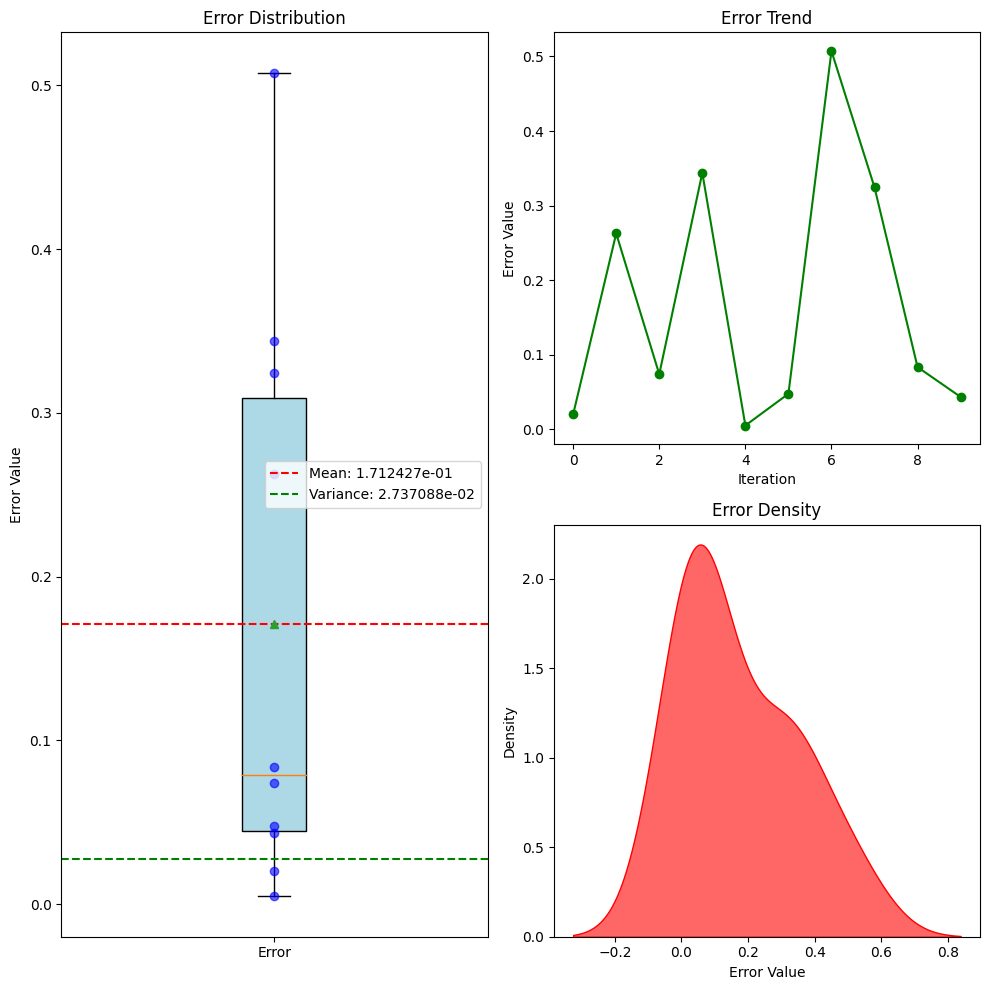

In [9]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns  # 导入seaborn库用于绘制密度图

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = error_u

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
var_error = np.var(error)
print('mean Error u: %e' % (mean_error)) #打印误差
print('Variance Error u: %e' % (var_error)) #打印方差


plt.subplot(1, 2, 1)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue'))
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:e}')
plt.axhline(var_error, color='g', linestyle='--', label=f'Variance: {var_error:e}')  # 添加方差的水平线
for i, value in enumerate(error):
    plt.plot(1, value, 'bo', alpha=0.6)
plt.title('Error Distribution')
plt.ylabel('Error Value')
plt.xticks([1], ['Error'])
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(error, '-o', color='green')
plt.title('Error Trend')
plt.ylabel('Error Value')
plt.xlabel('Iteration')

plt.subplot(2, 2, 4)
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('Error Density')
plt.xlabel('Error Value')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

mean MAE: 1.608579e-02
Variance MAE: 3.875415e-04


/tmp/ipykernel_1439059/3997509801.py:32: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


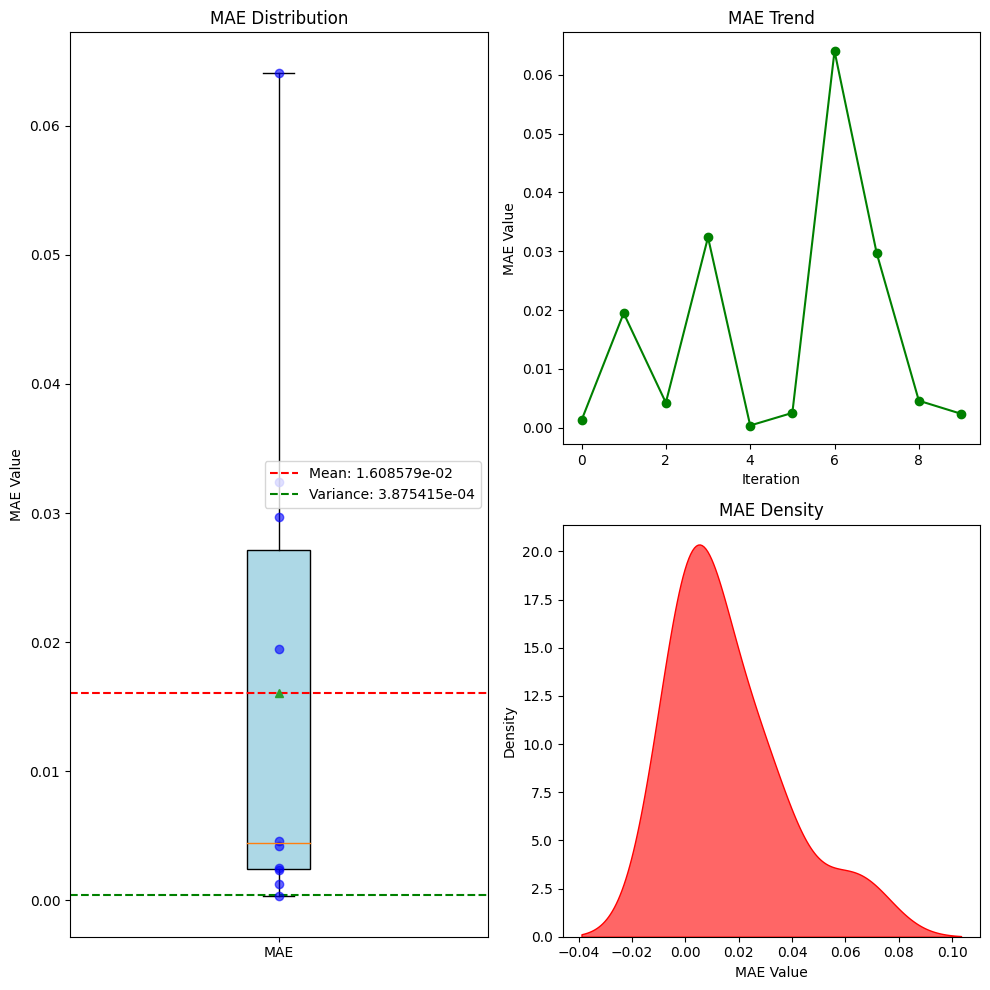

In [10]:

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = error_mae

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
var_error = np.var(error)
print('mean MAE: %e' % (mean_error)) #打印误差
print('Variance MAE: %e' % (var_error)) #打印方差


plt.subplot(1, 2, 1)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue'))
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:e}')
plt.axhline(var_error, color='g', linestyle='--', label=f'Variance: {var_error:e}')  # 添加方差的水平线
for i, value in enumerate(error):
    plt.plot(1, value, 'bo', alpha=0.6)
plt.title('MAE Distribution')
plt.ylabel('MAE Value')
plt.xticks([1], ['MAE'])
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(error, '-o', color='green')
plt.title('MAE Trend')
plt.ylabel('MAE Value')
plt.xlabel('Iteration')

plt.subplot(2, 2, 4)
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('MAE Density')
plt.xlabel('MAE Value')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

mean MSE: 2.139727e-02
Variance MSE: 9.116402e-04


/tmp/ipykernel_1439059/2305667704.py:32: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


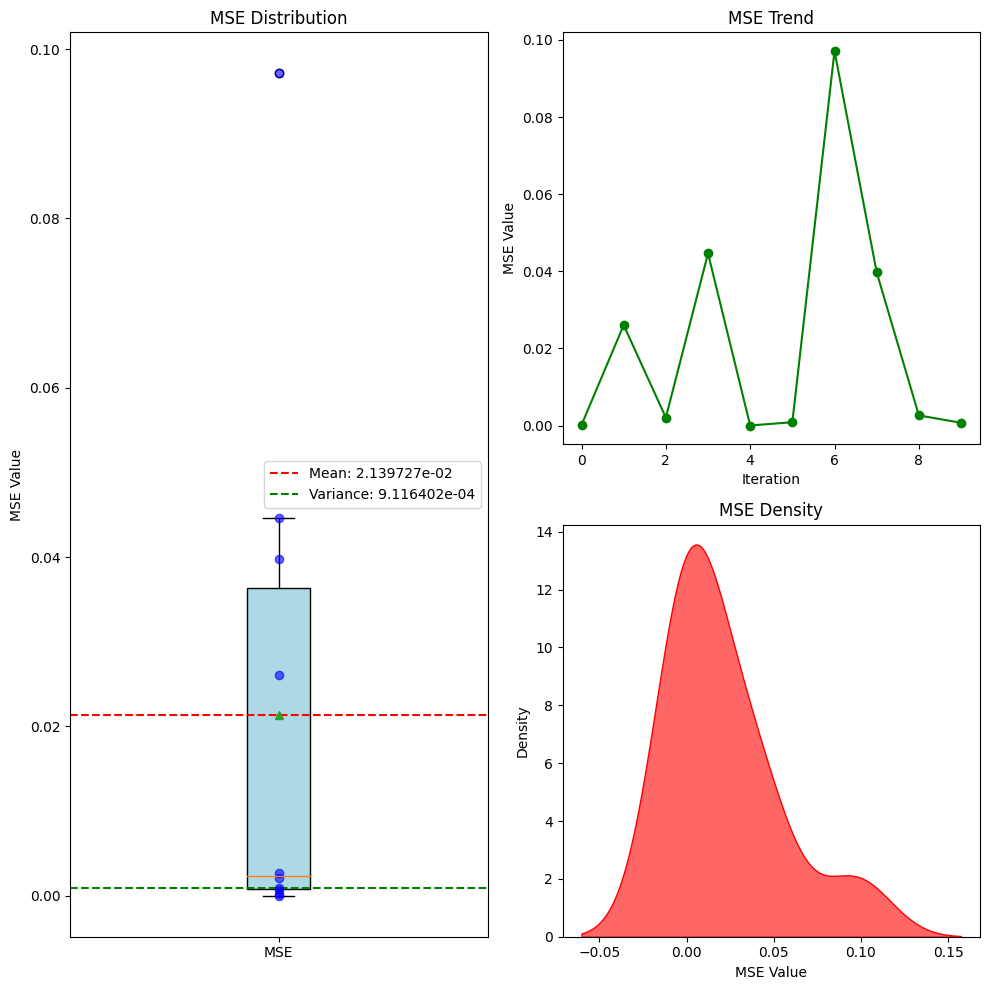

In [11]:

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = error_mse

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
var_error = np.var(error)
print('mean MSE: %e' % (mean_error)) #打印误差
print('Variance MSE: %e' % (var_error)) #打印方差


plt.subplot(1, 2, 1)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue'))
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:e}')
plt.axhline(var_error, color='g', linestyle='--', label=f'Variance: {var_error:e}')  # 添加方差的水平线
for i, value in enumerate(error):
    plt.plot(1, value, 'bo', alpha=0.6)
plt.title('MSE Distribution')
plt.ylabel('MSE Value')
plt.xticks([1], ['MSE'])
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(error, '-o', color='green')
plt.title('MSE Trend')
plt.ylabel('MSE Value')
plt.xlabel('Iteration')

plt.subplot(2, 2, 4)
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('MSE Density')
plt.xlabel('MSE Value')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

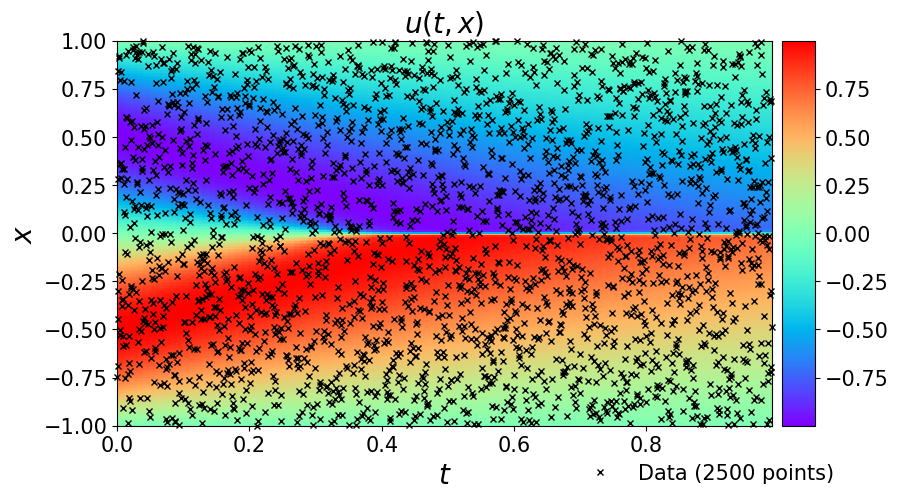

In [12]:
data = scipy.io.loadmat('../data/burgers_shock.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['t'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['usol']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact.flatten()[:,None]    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组   


#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_star = griddata(X_star, u_star.flatten(), (X, T), method='cubic')


###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
h = ax.imshow(U_star.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


#在图上绘制散点图
ax.plot(
    X_f_train[:,1], 
    X_f_train[:,0], 
    'kx', label = 'Data (%d points)' % (X_f_train.shape[0]), 
    markersize = 4,  # marker size doubled
    clip_on = False,
    alpha=1.0
) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
  #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

In [13]:
trainloss = torch.stack(model.loss_value).cpu().detach().numpy()


12711


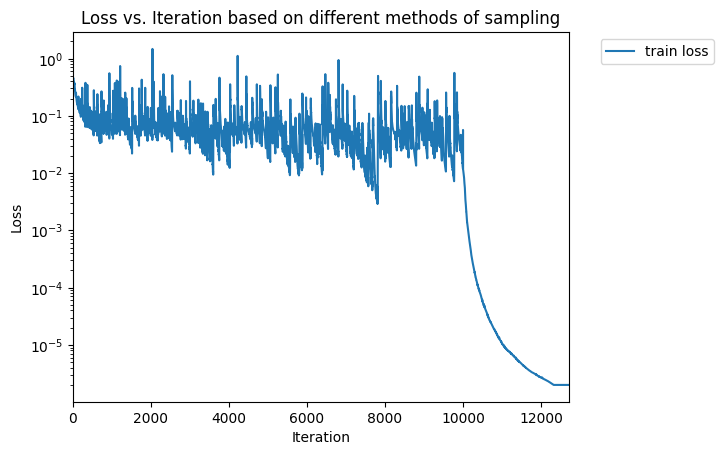

In [14]:
print(len(trainloss))
# print(trainloss)
# 定义图例的标签
labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(trainloss, label='train loss')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,len(trainloss)]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


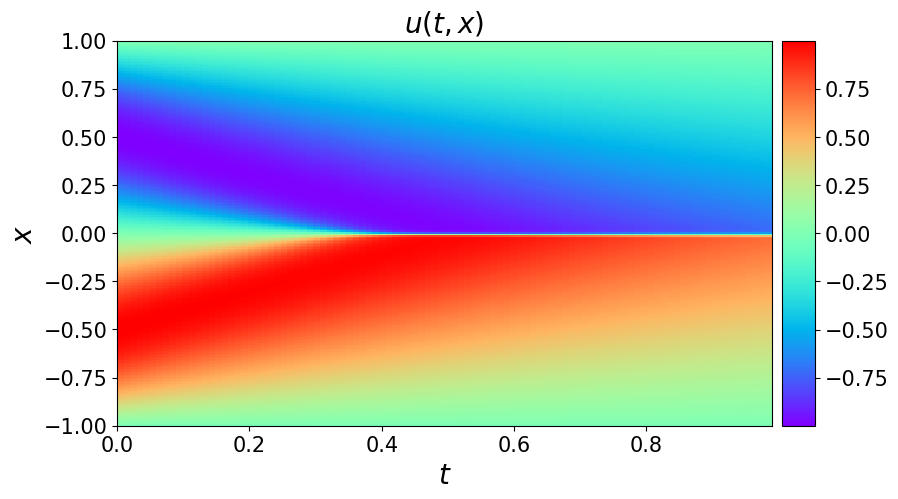

In [15]:
data = scipy.io.loadmat('../data/burgers_shock.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['t'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['usol']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_pred = model.predict(X_star)    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组   


#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')


###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
h = ax.imshow(U_pred.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


# #在图上绘制散点图
# ax.plot(
#     X_f_train[:,1], 
#     X_f_train[:,0], 
#     'kx', label = 'Data (%d points)' % (X_f_train.shape[0]), 
#     markersize = 4,  # marker size doubled
#     clip_on = False,
#     alpha=1.0
# ) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
#   #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

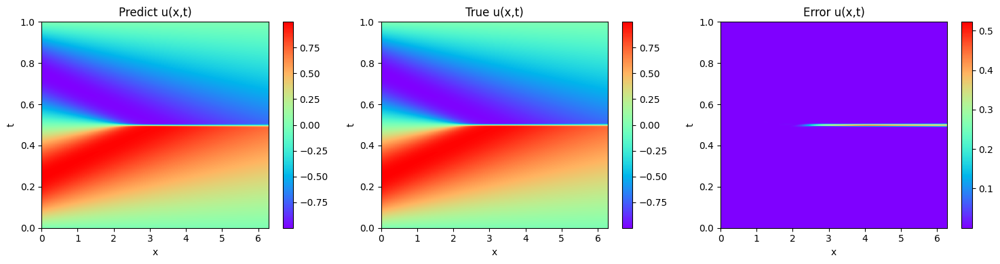

In [16]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_pred.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Predict u(x,t)')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_star.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('True u(x,t)')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 绘制第三幅图像
axes[2].imshow(np.abs(U_pred - U_star).T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[2].invert_yaxis()
axes[2].set_xlabel('x')
axes[2].set_ylabel('t')
axes[2].set_title('Error u(x,t)')
fig.colorbar(axes[2].images[0], ax=axes[2])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()